In [1]:
### General imports ###
from glob import glob
import os
import pickle
import itertools
import numpy as np

## General imports ###
from glob import glob
import os
import pickle
import itertools
import pandas as pd
import numpy as np

### Warning import ###
import warnings
warnings.filterwarnings('ignore')

### Graph imports ###
import matplotlib.pyplot as plt

### Sklearn imports ###
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

### Audio preprocessing imports ###
from AudioLibrary.AudioSignal import *
from AudioLibrary.AudioFeatures import *

In [2]:
# RAVDESS Database
label_dict_ravdess = {'02': 'NEU', '03':'HAP', '04':'SAD', '05':'ANG', '06':'FEA', '07':'DIS', '08':'SUR'}

# Set audio files labels
def set_label_ravdess(audio_file, gender_differentiation):
    label = label_dict_ravdess.get(audio_file[6:-16])
    if gender_differentiation == True:
        if int(audio_file[18:-4])%2 == 0: # Female
            label = 'f_' + label
        if int(audio_file[18:-4])%2 == 1: # Male
            label = 'm_' + label
    return label

In [3]:
# Start feature extraction
print("Import Data: START")

# Audio file path and names
file_path = 'D:/EIS/Audio_Speech_Actors_01-24/'
file_names = os.listdir(file_path)
#print(file_names)
# Initialize signal and labels list
signal = []
labels = []

# Sample rate (44.1 kHz)
sample_rate = 44100     

# Compute global statistics features for all audio file

for file_name in file_names:
    audio_path=file_path+file_name+'/'    
    print(audio_path)
    audio_names=os.listdir(audio_path)
    #print(audio_names)
    #print('*******************************************************************')
    for audio_index, audio_file in enumerate(audio_names):
        # Select audio file
        if audio_file[6:-16] in label_dict_ravdess.keys():

            # Read audio file
            signal.append(AudioSignal(sample_rate, filename=audio_path + audio_file))

            # Set label
            labels.append(set_label_ravdess(audio_file, True))

            # Print running...
            if (audio_index % 100 == 0):
                print("Import Data: RUNNING ... {} files".format(audio_index))
        
# Cast labels to array
labels = np.asarray(labels).ravel()

# Stop feature extraction
print("Import Data: END \n")
print("Number of audio files imported: {}".format(labels.shape[0]))

Import Data: START
D:/EIS/Audio_Speech_Actors_01-24/Actor_01/
D:/EIS/Audio_Speech_Actors_01-24/Actor_02/
D:/EIS/Audio_Speech_Actors_01-24/Actor_03/
D:/EIS/Audio_Speech_Actors_01-24/Actor_04/
D:/EIS/Audio_Speech_Actors_01-24/Actor_05/
D:/EIS/Audio_Speech_Actors_01-24/Actor_06/
D:/EIS/Audio_Speech_Actors_01-24/Actor_07/
D:/EIS/Audio_Speech_Actors_01-24/Actor_08/
D:/EIS/Audio_Speech_Actors_01-24/Actor_09/
D:/EIS/Audio_Speech_Actors_01-24/Actor_10/
D:/EIS/Audio_Speech_Actors_01-24/Actor_11/
D:/EIS/Audio_Speech_Actors_01-24/Actor_12/
D:/EIS/Audio_Speech_Actors_01-24/Actor_13/
D:/EIS/Audio_Speech_Actors_01-24/Actor_14/
D:/EIS/Audio_Speech_Actors_01-24/Actor_15/
D:/EIS/Audio_Speech_Actors_01-24/Actor_16/
D:/EIS/Audio_Speech_Actors_01-24/Actor_17/
D:/EIS/Audio_Speech_Actors_01-24/Actor_18/
D:/EIS/Audio_Speech_Actors_01-24/Actor_19/
D:/EIS/Audio_Speech_Actors_01-24/Actor_20/
D:/EIS/Audio_Speech_Actors_01-24/Actor_21/
D:/EIS/Audio_Speech_Actors_01-24/Actor_22/
D:/EIS/Audio_Speech_Actors_01-24/Ac

In [4]:
# Audio features extraction function
def global_feature_statistics(y, win_size=0.025, win_step=0.01, nb_mfcc=12, mel_filter=40,
                             stats = ['mean', 'std', 'med', 'kurt', 'skew', 'q1', 'q99', 'min', 'max', 'range'],
                             features_list =  ['zcr', 'energy', 'energy_entropy', 'spectral_centroid', 'spectral_spread', 'spectral_entropy', 'spectral_flux', 'sprectral_rolloff', 'mfcc']):
    
    # Extract features
    audio_features = AudioFeatures(y, win_size, win_step)
    features, features_names = audio_features.global_feature_extraction(stats=stats, features_list=features_list)
    return features
    
# Features extraction parameters
sample_rate = 16000 # Sample rate (16.0 kHz)
win_size = 0.025    # Short term window size (25 msec)
win_step = 0.01     # Short term window step (10 msec)
nb_mfcc = 12        # Number of MFCCs coefficients (12)
nb_filter = 40      # Number of filter banks (40)
stats = ['mean', 'std', 'med', 'kurt', 'skew', 'q1', 'q99', 'min', 'max', 'range'] # Global statistics
features_list =  ['zcr', 'energy', 'energy_entropy', 'spectral_centroid', 'spectral_spread', # Audio features
                      'spectral_entropy', 'spectral_flux', 'sprectral_rolloff', 'mfcc']

In [5]:
# Start feature extraction
print("Feature extraction: START")

# Compute global feature statistics for all audio file
features = np.asarray(list(map(global_feature_statistics, signal)))

# Stop feature extraction
print("Feature extraction: END!")

Feature extraction: START
Feature extraction: END!


In [6]:



# Sample rate (44.1 kHz)
sample_rate = 44100     






In [7]:


X_train= features
y_train= labels

# Encode Label from categorical to numerical
lb = LabelEncoder()
lb.fit(y_train)
y_train = lb.transform(y_train)

In [8]:
# Scale train and test dataset
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)


In [9]:
len(X_train[0])

200

In [10]:
len(X_train)

4

In [11]:
y_train

array([1, 2, 2, 0], dtype=int64)

In [4]:

# Load datas from pickle
[features, labels] = pickle.load(open("Pickle/[RAVDESS][HAP-SAD-NEU-ANG-FEA-DIS-SUR][GLOBAL_STATS].p", "rb"))

In [5]:
# Start feature extraction
print("Import Data: START")

# Audio file path and names
file_path = 'D:/EIS/Audio_Speech_Actors_01-24/'
file_names = os.listdir(file_path)
#print(file_names)
# Initialize signal and labels list
signal = []


# Sample rate (44.1 kHz)
sample_rate = 44100     

# Compute global statistics features for all audio file

for file_name in file_names:
    audio_path=file_path+file_name+'/'    
    print(audio_path)
    audio_names=os.listdir(audio_path)
    #print(audio_names)

Import Data: START
D:/EIS/Audio_Speech_Actors_01-24/Actor_01/
D:/EIS/Audio_Speech_Actors_01-24/Actor_02/
D:/EIS/Audio_Speech_Actors_01-24/Actor_03/
D:/EIS/Audio_Speech_Actors_01-24/Actor_04/
D:/EIS/Audio_Speech_Actors_01-24/Actor_05/
D:/EIS/Audio_Speech_Actors_01-24/Actor_06/
D:/EIS/Audio_Speech_Actors_01-24/Actor_07/
D:/EIS/Audio_Speech_Actors_01-24/Actor_08/
D:/EIS/Audio_Speech_Actors_01-24/Actor_09/
D:/EIS/Audio_Speech_Actors_01-24/Actor_10/
D:/EIS/Audio_Speech_Actors_01-24/Actor_11/
D:/EIS/Audio_Speech_Actors_01-24/Actor_12/
D:/EIS/Audio_Speech_Actors_01-24/Actor_13/
D:/EIS/Audio_Speech_Actors_01-24/Actor_14/
D:/EIS/Audio_Speech_Actors_01-24/Actor_15/
D:/EIS/Audio_Speech_Actors_01-24/Actor_16/
D:/EIS/Audio_Speech_Actors_01-24/Actor_17/
D:/EIS/Audio_Speech_Actors_01-24/Actor_18/
D:/EIS/Audio_Speech_Actors_01-24/Actor_19/
D:/EIS/Audio_Speech_Actors_01-24/Actor_20/
D:/EIS/Audio_Speech_Actors_01-24/Actor_21/
D:/EIS/Audio_Speech_Actors_01-24/Actor_22/
D:/EIS/Audio_Speech_Actors_01-24/Ac

In [24]:

# Covariance matrix
cov = pd.DataFrame(X_train).cov()

# Eigen values of covariance matrix
eig = np.linalg.svd(cov)[1]



In [6]:

# Build Train and test dataset
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, random_state=123)

# Encode Label from categorical to numerical
lb = LabelEncoder()
lb.fit(y_train)
y_train, y_test = lb.transform(y_train), lb.transform(y_test)

In [7]:
len(X_train[0])

200

In [8]:
len(X_train)

1075

In [9]:
# Confusion matrix plot function
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, fontsize=22)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label', fontsize=18)
    plt.xlabel('Predicted label', fontsize=18)
    plt.tight_layout()

Accuracy Score on test dataset: 4.83%


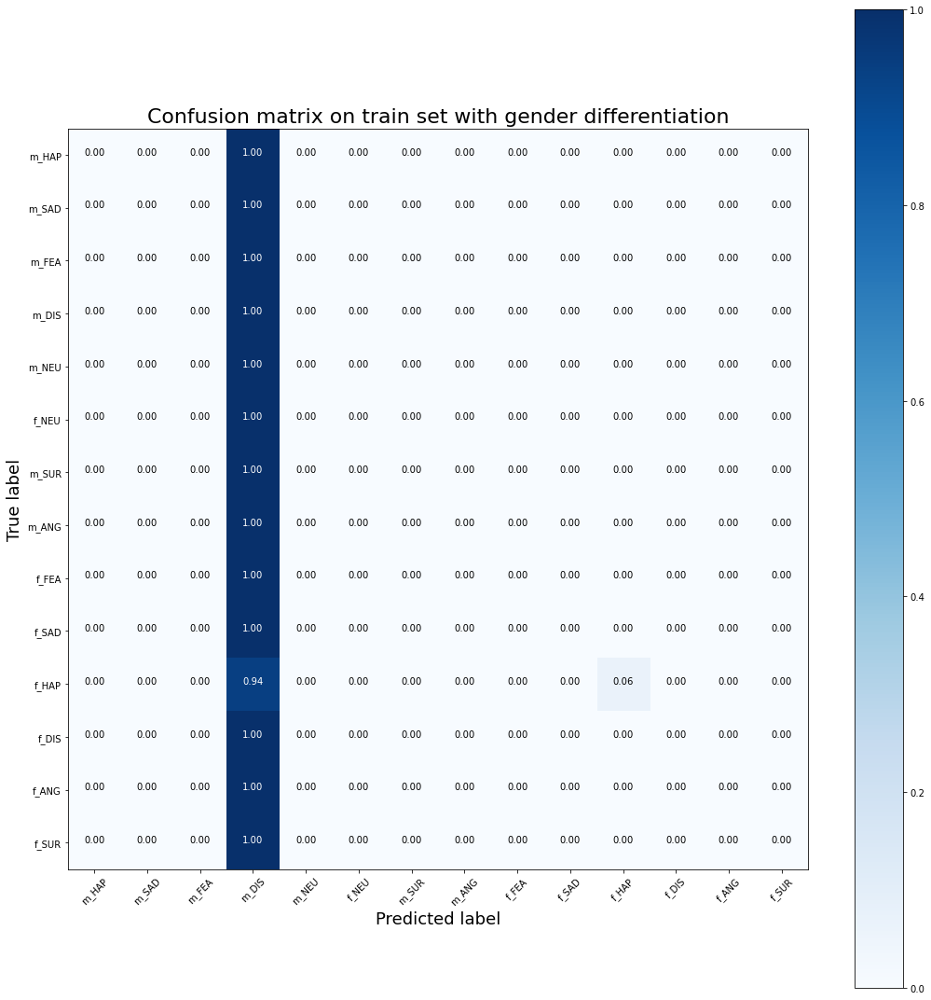

In [11]:

# Fit best mode
model = SVC(kernel='rbf', C=3, gamma=0.005, decision_function_shape='ovr').fit(X_train, y_train)

# Prediction
pred = model.predict(X_test)

# Score
score = model.score(X_test, y_test)

# Reverse label encoder
pred = (lb.inverse_transform((pred.astype(int).flatten())))
actual = (lb.inverse_transform((y_test.astype(int).flatten())))

# Build dataFrame
df_pred = pd.DataFrame({'Actual': actual, 'Prediction': pred})

# Print Score
print('Accuracy Score on test dataset: {}%'.format(np.round(100 * score,2)))

# Compute confusion matrix
confusion = confusion_matrix(actual, pred)

# Plot non-normalized confusion matrix
plt.figure(figsize=(15, 15))
plot_confusion_matrix(confusion, classes=set(actual),normalize=True,
                      title='Confusion matrix on train set with gender differentiation')

In [21]:
# Compute prediction without gender differentation
PRED = list(map(lambda i:i[2:], pred))
ACTUAL = list(map(lambda i:i[2:], actual))

# Compute related prediction score
SCORE = accuracy_score(ACTUAL, PRED)

# Print Score
print('Accuracy Score on test dataset: {}%'.format(np.round(100 * SCORE,2)))

# Compute confusion matrix
confusion = confusion_matrix(ACTUAL, PRED)



Accuracy Score on test dataset: 100.0%


In [169]:
# save the model to local
pickle.dump(model, open('Model/MODEL_CLASSIFIER.p', 'wb'))

# Save label encoder
pickle.dump(lb, open("Model/MODEL_ENCODER.p", "wb"))

# Save PCA
pickle.dump(pca, open("Model/MODEL_PCA.p", "wb"))

# Save MEAN and STD of each features
MEAN = features.mean(axis=0)
STD = features.std(axis=0)
pickle.dump([MEAN, STD], open("Model/MODEL_SCALER.p", "wb"))

# Save feature parameters
stats = ['mean', 'std', 'kurt', 'skew', 'q1', 'q99']
features_list = ['zcr', 'energy', 'energy_entropy', 'spectral_centroid', 'spectral_spread', 'spectral_entropy', 'spectral_flux', 'sprectral_rolloff']
win_step = 0.01
win_size = 0.025
nb_mfcc = 12
diff = 0
PCA = True
DICO = {'stats':stats, 'features_list':features_list, 'win_size':win_size, 'win_step':win_step, 'nb_mfcc':nb_mfcc, 'diff':diff, 'PCA':PCA}
pickle.dump(DICO, open("Model/MODEL_PARAM.p", "wb"))

In [17]:
from tensorflow.contrib import lite

ModuleNotFoundError: No module named 'tensorflow.contrib'

In [19]:
import tensorflow as tf

model = tf.keras.models.load_model('Emotion_Model.h5')
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()
open("converted_model.tflite", "wb").write(tflite_model)

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: C:\Users\pooja\AppData\Local\Temp\tmpwc2czvoo\assets


ConverterError: <unknown>:0: error: loc(callsite(callsite(callsite(unknown at "model/LSTM_1/PartitionedCall@__inference__wrapped_model_2156") at "StatefulPartitionedCall@__inference_signature_wrapper_9594") at "StatefulPartitionedCall")): We cannot duplicate the value since it's not constant.

<unknown>:0: note: loc("StatefulPartitionedCall"): called from
<unknown>:0: note: loc(callsite(callsite(callsite(unknown at "model/LSTM_1/PartitionedCall@__inference__wrapped_model_2156") at "StatefulPartitionedCall@__inference_signature_wrapper_9594") at "StatefulPartitionedCall")): see current operation: %31 = "tfl.unidirectional_sequence_lstm"(%30, %cst_27, %cst_28, %cst_29, %cst_30, %cst_19, %cst_20, %cst_21, %cst_22, %cst_14, %cst_14, %cst_14, %cst_23, %cst_24, %cst_25, %cst_26, %cst_14, %cst_14, %28, %28, %cst_14, %cst_14, %cst_14, %cst_14) {cell_clip = 1.000000e+01 : f32, fused_activation_function = "TANH", proj_clip = 0.000000e+00 : f32, time_major = false} : (tensor<?x5x128xf32>, tensor<256x128xf32>, tensor<256x128xf32>, tensor<256x128xf32>, tensor<256x128xf32>, tensor<256x256xf32>, tensor<256x256xf32>, tensor<256x256xf32>, tensor<256x256xf32>, none, none, none, tensor<256xf32>, tensor<256xf32>, tensor<256xf32>, tensor<256xf32>, none, none, tensor<?x256xf32>, tensor<?x256xf32>, none, none, none, none) -> tensor<?x5x256xf32>
<unknown>:0: error: Failed to duplicate values for the stateful op

<unknown>:0: note: see current operation: "func"() ( {
^bb0(%arg0: tensor<?x5x128x128x1xf32>):  // no predecessors
  %cst = "std.constant"() {value = dense<[2.93707275, 2.98643494, 2.83994842, -2.43283153, 2.93220258, -0.327438861, 2.90083575, -1.57077932, 2.99460149, 0.698422372, 0.100706011, -2.69463634, -3.00451779, -0.0530655086, -1.58615279, 2.27327847, 0.10861928, 2.98477697, -0.112180047, 2.84201479, -0.306694388, 2.86642408, 1.40884042, -2.95954514, -2.6531384, 0.50511539, 2.83308625, 2.1177578, 2.89895511, 1.03791499, 3.03703141, -0.440490544, 0.455668926, -0.467890292, -2.72118831, 1.0551604, 0.392164856, 2.82573271, -0.268609524, -2.22622705, 2.82682657, -2.9332478, 0.407646567, -2.591790e+00, 2.93159032, -3.00279403, 2.93240452, 2.89626908, -2.56060529, -3.04280853, 0.199647516, -2.71648192, -3.04102397, 0.264021426, 6.719670e-01, 2.99747038, 2.94943118, 0.32058996, -2.7011435, 1.30647135, -0.159558207, 2.8863914, 2.88409209, 2.90315604]> : tensor<64xf32>} : () -> tensor<64xf32>
  %cst_0 = "std.constant"() {value = dense<[-1.2399559, -0.951517224, 0.050416749, -1.49675381, 0.767955899, 0.839354515, 0.462001532, 0.0840217173, 0.485148937, 0.695427596, -0.132543206, 1.20450401, -0.51703608, -0.212937981, -0.869820058, 0.828740894, -1.08978987, 0.0387441069, -0.23460573, -0.734749913, 1.00029111, -3.360460e-01, -0.453916252, 0.711124659, 0.936402678, 0.0818562731, 0.434319824, 1.02877259, -0.952021598, 0.560692787, -1.786810e+00, -0.100322522, 0.829597115, -0.13163951, -5.134480e-01, 0.434841573, -0.295297116, -0.231047794, 0.326593339, -1.29672647, 0.653228521, 0.166989028, 0.182981342, -0.891027748, 0.0156665184, 0.115164757, -0.141260728, -0.292278796, -0.31316486, 0.0441367477, -0.99352777, -0.613339067, -0.0270891599, 0.131020546, 0.502829075, -0.0275291223, 0.249627545, 0.14964366, 0.379761815, -0.0732254758, 0.0163982566, -0.15215686, -0.531793237, 0.155947328]> : tensor<64xf32>} : () -> tensor<64xf32>
  %cst_1 = "std.constant"() {value = dense<"0x831AEE3F1A480CBEBAE7193F1F2D223F467D85BE2C87253E86E806BF1632983E5A1B013F12D7853E283B0A3FB89E8EBD5DFE443F029D19BF92998FBEE212A3BF7605963E9E15343F26ADFD3E78D2C03E840D043F3712083FAD7380BE66E8353F5314693F3D6931BFB40BDDBEFBB678BF7A9096BEFFA438BD8B7042BF638F66BFC570A83FC227A43FDE4249BFD13B0A3F5C2F4F3D2C814FBF6C0B413FE2414D3E6C1DA23E725D81BFFA99E03B936F913F74FE243FE6F1293E603C5ABF047A3DBE8BBD12BF5DC085BF36B509BFC550D13E3E48BB3E26E05FBF8A378EBFEAEC66BFACF5FFBDC3E7C9BE88C4ADBD7006D43E6B24003F64E732BFED76F0BFFCA486BE9C9295BD8447AE3FDAF8C53F7472193FDCD5A1BEB282583F4E3FBEBFDF4B104047AB7C3F8C97D9BE4607B8BF46C993BE79A482BE5EE59C3FE88FBD3F375D93BF4D4B903DAC67493F9C5D03BF6251E7BE20F52E3F907C04BC2AD722BF4D2FA8BF85C90F3FE46F913FED6D2ABE37D84A3F4829453F0A2A1D3F9414F83EAEBE60BF3A105F3F695B99BE23EB71BE497C66BE4E5D90BF209DD9BCFECAE5BE11DB22BE34B6BF3F97F1E43F704602BF0E2003BF9F2AAB3E64C47EBF774FB9BE50E9C5BE3C54A73F5CE4923EDD67D6BE5091B13E767A97BF62106BBF31702F3E5E6C6ABC70D71A3D863579BFB797B5399C116A3F10E77B3F5FF8FB3E7CB715BBC90C113F"> : tensor<128xf32>} : () -> tensor<128xf32>
  %cst_2 = "std.constant"() {value = dense<"0x02833A3F7E7557BEC0EA003E2B5C55BFBD14A4BE84151E3E4743BC3ED625C0BECD5B723F1DE2ED3E961C0F3F4CEA9C3D4634BEBEB00EEBBE55CEF6BEE41115BF78F9A0BF4AB090BF02BAAF3EF07E94BF12362CBF0BA74ABFE57B39BFFEBA4CBE7BA61EBF97C516BDE21E1A3EB16DB4BEDA882F3FEF497ABF5A4475BFC2978A3F984189BE78F091BDF8F24ABECA6F82BF918312BE4A49C4BD05AF34BF05CA993AC15D97BD37DE103FE75C4F3E17E4F13F6A1019BF899201BF6ECD24BF4B9BB73E1A34ED3D2CBA093FBC6654BFFAFFC5BF2AAA06BF78B741BFDE8B1FBE32027FBF35BA9FBF3B5A62BF9C479DBFAEEEBABF0B4E71BF13A697BF8E9BC53E15DF14C02E68B8BE69B6C8BF2AA1733E54DA1FBE238DBDBFA067483FF811C9BEA8DFF3BFD0D69DBECA4B63BF39C4EDBE21F9A63D44A0D5BE8023C1BF9F6991BF70C4D2BE13E4C2BF1D64DDBC156E06BFBA3C763F951A583F25A9BBBE684AC4BF244A7ABF6D0C5BBF8E89453F76F1F4BB0B31E7BE1AEC313E22ACF5BD1C7413C0EAF1C43EF405513FF08C1ABF4408BE3ECE68ADBE062D533F7B108FBF68822CBFC4EECABE002D123F3CAE92BF81B9B6BE5CE8BEBD2014DF3C724AACBF194F993C06BC533E3090323F36F1733E5AD044BE7080BF3E1102AEBE8A79A9BEC9B4D2BF13E2A5BF091ADFBF465D07BF2AF0CDBF9DD084BEADDE86BCDAA3993E043705C0AEB066BE"> : tensor<128xf32>} : () -> tensor<128xf32>
  %cst_3 = "std.constant"() {value = dense<[-0.0528086089, -0.0426844619, 0.00793590397, 0.0556932949, 0.0512114875, 0.0708077326, -0.0591516644, -0.0310040358]> : tensor<8xf32>} : () -> tensor<8xf32>
  %cst_4 = "std.constant"() {value = dense<[-1, 128, 128, 1]> : tensor<4xi32>} : () -> tensor<4xi32>
  %cst_5 = "std.constant"() {value = dense<[-1, 128, 128, 64]> : tensor<4xi32>} : () -> tensor<4xi32>
  %cst_6 = "std.constant"() {value = dense<[-1, 64, 64, 64]> : tensor<4xi32>} : () -> tensor<4xi32>
  %cst_7 = "std.constant"() {value = dense<[-1, 16, 16, 64]> : tensor<4xi32>} : () -> tensor<4xi32>
  %cst_8 = "std.constant"() {value = dense<[-1, 16, 16, 128]> : tensor<4xi32>} : () -> tensor<4xi32>
  %cst_9 = "std.constant"() {value = dense<[-1, 5, 128]> : tensor<3xi32>} : () -> tensor<3xi32>
  %cst_10 = "std.constant"() {value = dense<[-1, 4, 4, 128]> : tensor<4xi32>} : () -> tensor<4xi32>
  %cst_11 = "std.constant"() {value = dense<1.000000e+00> : tensor<f32>} : () -> tensor<f32>
  %cst_12 = "std.constant"() {value = dense<0.000000e+00> : tensor<f32>} : () -> tensor<f32>
  %cst_13 = "std.constant"() {value = dense<256> : tensor<i32>} : () -> tensor<i32>
  %cst_14 = "std.constant"() {value} : () -> none
  %cst_15 = "std.constant"() {value = dense<"0x6156AA3BFE880E3C8E0EFE3BCE1F33BAA714973CACBC373CA906413C6436E13BE6CD13BA8153383C1AFA3B3C29DF293C2101133CD763EF3C4E1CE13B2CDF8C3B19FC8DBCF033AF3B440E663CFB43433CA0EA593B6339063C853C933C9A50823CADD76DBBEAF75BBB5A66053BB73F90BCE437D3BC69070FBB142EBDBC8542C8BC1072A83CF6D742BC1EA579BBBBFDF03C8A0115BB2C02543B45B38EBA28B55B3C08C54F3C1B23483C08B4303BC224A63C2539C43B881F31BDE051A63DFBF5DABC104B09BCC776133CDCA492BC5B9957BD2F55A03D90042CBD0F15863C2248EA3BA91B79BA334E933CD2019B3C10448D3B77302C3C24F6A3BB442219BBE60CD23B398539BDE899D53C253FA3BC62B139BDD8C5203CD7A9F33B6BC808BDEF915D3DE831103C65C4E4BA0B28A13A29FEC43BC6FBEF3C8DD1C23B301A3D3B262D443C663DD33BBEAEC03C7EB2813D1C3F8F3D9BA693BC059208BC36340CBD24DA64BC898634BDE9EED3BCC18D373D53A52E3D7567493CEC823C3DE917C33C0A3A3ABC56D58DBD09519ABDC63654BC14849CBD66FE813CDF2C8B3C4CE1723CE3C7E1BC2691F5BC8932503D83054CBC760F00BDB4AC34BCD95017BCF5291B3CE2A3A5BCA631CC3BEF979CBC2F02103CEDD78EBC9EB64EBC1E30B73C00D2AABD6BD5093D2AA2173DE81688BDCA431D3D834DB23C8B8D20BD9B68103D25F6FDBC26F917BD53913B3D6093DBBC588801BC135B9B3C86F0F9BCC2E6753C1B03483CEAC93B3C78F6293D8EB40A3D0B5B55BB3DB2383C14F3F73BCCBCE6BB368CCABC385887BCC4B8B43A3B4330BDEC71293D013043BD4F81A43C2195CA3CA78171BD39D6E13CBC30F83CEECA6C3A800B0CBB6CA43E3B2545973C6AC3073CDD8A9E3C9581603BED23233C522C143C6BAE483D12693C3D8D0DAB3DC57B22BD4F7F9DBD0CB54FBDC5BC99BB28D6C4BBD27C0B3CEB7D4C3B2DDAA0BB68288E3B8915583C7C35803C7F7A503C7B681E3C4193013A16044A3CE0D141BD243DAB3D0B5E703D03E310BD1887AB3CF450A1BB190576BB33CD44BD548FE3BC273D76BBDCC28C3BCDCC693B09157E3C27B88F3C19BE273C8480A23BB9DE073C321AA73B26D3D0BCE5585FBD935486BCA02DA73C58ECEE3CBA5337BDFE54AA3CACEF9A3D125C143DA4B84FBC8F1CDE3B1D3CEEBB5AD88FBC584B0CBC4094ABBC9B3D39BC78A9F43B4D7D1AB9A03F90BD7022183DCE639BBBAE0B133B3D1B21BD28A53CBC6911913D4E8B27BD68F8A7BC45B2C13B2BBCE3BC4A4894BD6A6C693DCFDA393DA62C17BCD152DE3BB2AA253D3E8426BDA38FF03A83B2BDBBFCCA6BBC999D053D5234963C8703003D2FC8943A8E12883B6E0C6ABBBD94AC3DE7B3C8BC517A18BD10BE323CF311873C8CC6FABC308145BC1698DC3C76977E3C65A340BB91CFAF3BBEC37DBB574E343CA1D2033CA841633CDDA85F3B6EB8863C203B8A3CE489C1BC407163BC2964C2BD1103B93D5A118F3D4F545A3DC7169ABDDC4DF4BB2B06C23CC235303CFDFAC43B62A3353CC9427D3C41D5AE3C60D49D3B06D7D7B9ED68C33A4CE651BA822012BD9E1C0EBC0C9BFA3C7A691DBDCAE863BC40EC1C3D86F8F8BCA89BC7B9CFDB163D2EA82DBDA1525DBD4C887EBD45BB4D3D03E8F23C44BC7F3C5F841F3C035D953DA1D120BC6F669FBCE074893D1C68B4BD11D0A0BCA47C0C3D802FA7BCD6694ABC7D9CA93DC91527BD13A0B53CEAE2A8BBE32D4ABCC8DC0D3A51C4193C84100ABD250DA4BB179401BC19F9C9BCCEF7B7BC70F2DBBC9F0A31BDFFC1663D656323BD66C6EABB60A4833D0F88BA3C1114693C24E2993BDAD5703DA90A573D22597D3C98328B3C178F95BA58020CBD614086BDD6D732BD59450A3DE310803C2A8A8ABC8001083BBD631BBB1ADF123C4E794CBC48588C3CF8CCB13CC9E202BDC198153D24B7A3BB16043EBD58F69E3D144E643C46B577BD9F5F5B3C19DE8ABBC4AC353C782D933CD02501BD006A87BC27A3533C9F271FBDE811CE3BBE9EFB3C96661EBD1DAA4E3C91BFE43A03F4B2BB5F1D433B3687303C33A5753C0FB2EF3A2D3D973C4B8D053C67AB763CFD34ACBC300F11B9BCCB11BCAFA107BC0FAD3DBCC82DB13AFB039DBCF43C4CBC5430413C45FF853CF53C8F3D203F22BD1403CBBCA705AA3C07C124BDE5269BBCCB068E3C547E10BDCEFF223B7809F03CD8D510BD0387993C7E6B18BC28B3913A463BDEBB08F9A8BCB4FE1D3CADD85A3C40DE423CB303A13B3EE0C03CDFEF7E3B94820D3C029D14BC6E4A623936CC4CBC2722A53B36B0643CBAC179BCD71585BAD7AFECBCAAF227BCA16E12BCA369E8BB4D6BB33BF4053B3CBB65AB3B166B23B979F4C73CD392B53BAD51EC3A260F6B3A46F4603C980B2A3AF7BE983AB45E7F3BDF0C133BA652D23CA979583CEA05D1BA3924083CBD02633C865E8E3B54F2DEBC70FD0EBDEF9799BC85B5783A26FA9B3C260E39BD29758C3B89D92C3D32DB003CC6D1573B2A06B2BB5E7FCFBC5BD319BCA97915BC511FA9BC97C44C3A32EFE9BBC210333D104C593DA41BAB3CB100D7BC05B3663C1994F63C8C2FB9BCBB0F8DBDDCA029BDFD75A7BBD830C5BC690E293C97B24DB9B42204BD8DABE7BC7C0E423CECEF20BC4CC4E03C3A2F51BC13EA003D92B60ABD2A29953BA51A91BCA5D7F2BCA7E16F3BB6FD30BD6F1E933C1281313DAAB1A63D18033B3DE1A85CBA3F6901BDF4EB70BC893D14BD59E23CBDEF379EBC44D5893D9666163DD3C152BC2AD2D83C3829063DAF3DE33C54348CBDAACC6FBDD53493BCB3F426BB36E8883B1B66F3BA22546B3CCC5A5E3C32E5503C1E40233C34E07F3CF5996B3BD243A73C12531A3C875495BBC76D8DBB4E68913B83D4143C9E719B3B13AB933C9193463CB657F63CC3B29A3D4B5A713D7FB12CBD4936C1BCC33EA5BB18A28ABC33232CBDCB2AB8BC975EFABCE4DBF0BB9F37ADBC060B1C3C3ACC8C392BBFB3BCBF6E52BC48BDA23CAE848D3BDA8039BC85CC3DBDB1F2DEBC36FA8C3D8CE704BDCB9C61BC4DC9393D1D22AE3CA93A9D3C4F69EC3C544F94BD943E53BC35FBCD3C94D756BD6DF8033DFE9C733D67B988BCF081F13B429F9ABA5894B03BCAD9D53A9315553CF441863CCEDA483C0FC60C39B6720B3C2CEF383CC912903B25397E3AE7B50B3C4EB46B37FC9FDB3C5414103CD744033B4E45CF3BFE69173C9EB4883BAA229E3B5ED049BBF84D9B3C19E81E3C44B7543C732928BACEE01E3C18B73D3C"> : tensor<64x3x3x1xf32>} : () -> tensor<64x3x3x1xf32>
  %cst_16 = "std.constant"() {value = dense<"0xF78C93BBFC4DAF3A62DC00BB6FED683B7619D53CCE1F0DBCF517343DCC2D38BC2A7F6C3C731848BC178D593D79FC1C3CB0F5623C74A2A83CD118443DB885CEBB87CE553C98D81F3DCD0CC8BCFEFE92BCF41D3EBC446CC43CC015C9BBFA00B03CE92A723C569EE33B95952A3D12DD0BBC2128293D6406F9BBB7A2ADBBDD68433DA27C43BCB6E4843C1208B93B2363BD3CDDE5183DF1FE993C677A153C0ABBAFBC629B073DA6827C3AB5050CBC2F2A03BC6ACB25BC81E4AD3C4EB7613DC20D683D4575A13C91B9E43C41CF613C25B97BBB66AD453DC636A23CEC9D493DF666163C1054A8BC0D04EF3AB20E93BC7B6C923BED59A43C3ADA073D65F0E43C79BFB3BC2286813C578AE33C69A73FBC485F793CCAA0FE3C96FE68BBCA01273DADA85EBCF6538D3C77E20ABDA33C213CABBE353DAF6149BC901A98BC38C2853C279BCEB875AA0A3BC65EDE3B1BC82ABD8F98513AE80DED3C57FA4A3D3655B03C34831B3D76CD0B3D5A5C9B3CD6932A3D4C910DBC6CE4193D05106DB976108EBC46CAAABC03D63D3D04A8BFBC36C6183DBA28C03C712B2C3CD12E193D74EF69BBC1EB653CF693953C411D4B3D912781BC3F37013D28046F3C2E8F3A3D12DBB93C04D13A3DFFE3E9BAF10C87BC4F1413BDCFB09A3C500CB83C5E7491BC8B1FCC3CC7A99E3C8941893B2F7083BC6050FB3C0142AF3CD812B43C63ADDD3C6C79463D67C7C6BBD0C3393DFDFC803C2D75543D7D85553BF81AB33CE6774BBD5B872A3D2D0920BD97A5B03CBC8515BD4F04F1BC5424E1BB23D7C23C37B699BC8DB7C1BC0F78DF3AF3937BBCEAF9073CBE6365BD10B6FBBBBB882CBC2B10AA3B83CBE03CEC36273D55EEC0BB409B863C110DB1BC11F7213D69B18CBCA8F56C3CF2EBB13C36AE323C2AC3913C230A2D3673471E3DD7E9F63BC1E58DBCA3EE34BBDADE28BD03FFF23C7BF3BEBCE4B2403D4E8CA4BB254773BC87599B3B9C18B03C981C51BC366A3C3C4FCCD13CC3EE0B3D5F30F7BC909B0E3BD6A60C3DDA731E3CDD71E43C22A25F3C24DB20BDF7F014BD456124BCA72B973CA1FC8B3C84C0F73C7D93D63CC94B2B3D8584AE3BA085E63C15DD79BCF30182BC021AE83C346FB439408CFEBC783238BC8DAE1ABD14A7B0BCBFBC283D1610E3BB41A4FC3B841FD6BCD96F4D3D9D19113C0B60183AAAB2F4BCD63FB63B689B0F3D7DC48F3C6E65033C401F2BBCE152D83C560C323DA96599BC24FE12BDFB990F3D09318EBBA290D83B8D7C4D3C3409CD3C50DE2BBD66A05BBC8CB777BCE95BACBCB4D6783BCC4F01BD2AB9963C0D169BBB5A9621BCB6883D3C35D14D3DBCA0933C724D17BCCC2B98BBDE5C343D6967473CD5BD233D7326F43B8BCF283D0A29003C13EC28BC32D6CA3B4AF0393DC64705BA79CB213DEF5B063CCF70003D42A630BD71B821BDEDF34E3C5996983CA11C413C420E6D3CF22886BC4F76163D815D1D3C4821AC3AC184B13C4CE2F43C94CF963C2CAB4C3CF97EECBB4A39F23CA1A2F73C639B413ACDCBB7BC937080BC5FC2863A1FC2D33C15C9B03C515100BD5889883C6D590EBCC274A83C7FAA6D39F228BB3CC2DE1F3D0584463C27B57D3C8072FCB9C879363BB1B4BE3B12D3CB3CE465293C68512BBBF7940BBC07D9163CEE02CBBCBE37093D71FDC4BC7DF1FD3C8685243D42A88D3C0127F2BB4561A93C6F4FA63CA680BCBCA5EA14BC29F353BCD9AB0F3DA3F43C3D3E0E023DCCAC70BCA1CCA53CD2C4B03CC1128BBB030886BCA2B3BBBCAEAE923CBE76E33B4F29243DFC938B3B6069B6BCB5A4B2BCD9032A3D9699DD3C7B5F77BB4E88FA3B0328443DAFF602BC0CE90CBDDE2A1A3C2EE9F53CA412F63CA4CF053BD044CDBBA54208BDBCF6E43CB7D883BCC4241CBDE310A63C6B5DAB3CFB9B403D30553E3D1B1E20BD255005BC899E9CBB2D977ABBD5853A3D2E6FF63C5069043D8925E2BBFDF5CF3B290B163DBDBB533A9073D03BD09772BC830D1C3DD98CF6BA89E3D83CDF76143C14BC54BB740F1BBD678837BC992990BC5FCCDF3CCD3290BCCF69273C59AA40BD5A03B23C37AD9EBC53480F3C36FD53BC84020B3D4B2EFB3CD8F0063CB14437BB6634563CACED023D80270BBDACEBF83CE313BE3C603D0A3D096E44BD2B8CE23C9231C0BBAD530EBCCEB585BCD4DF15BCB9F97DBA77C3873C16186E3C656743BC100698BCFCBB393B31C797BB4733E0BC1D6104BC2DCF833C737003BCDF5491BCDAE0213ADC03D2BB0E1A063D047D073BD970173D82D13A3D38E33CBD307FC6BB17E88C3B3CD42A3DED876EBB9E166ABCF5F3B2BC3556DEB9B7ECAABCB499333C421D68BC096F8CBB6B1780BD436224BDD096E73C74CCBCBC2AA04D3C36A487BCFAFBD83B95C8D7BB644FCE3BFFC50FBCF8C55DBC1DB6333C18FF333D7284643D6D0B44BC8D5ED63C046E103DF2D0843CF8C1203C4A34263D7FE0283DB85CC6BC1F109DBCFDC1013C787D473A8B49D2BC2C5E06BCB2EE0E3C80EE64BC73BAA1BC9336DBBCCA91783BF58EAEBCCF2CADBCFDB332BD53A5663CAEAB973BBE1771BC71AEBC3BE23CBB3B06A0B9BB9BAA903B5D9173BCF9AAFD3C21EE06BCDAE60CBD36E4C73C709B4ABC407799BC733C4C3A67701DBCE62866BA5E44D0BC8629123C48FDE1BB709399BCB53CB83C08997ABC99C2833C0E9C673DFE59B4BC0A8C81BBBF0FD83C9B43EC3C9AF950BC3514003DB63E5F3D48BF2CBDD6E00ABD7D67D0BB51571FBDDE91E73BB2D5E53CC948253C9349073D9EE09E3B0AD6083C3A0AB73C7A88113D373DBF399842ABBC13E3F9BB31CAC63C50194F3DD400E83A50A8193D61581C3D9467D0BB1B7FCF3C67C3EBBC34BB1C3DC0F0AABC408D563CEDAE383C177089BCA6ACC8BC2BBC003DDD109ABC257C2FBC99F2243DBFCE2AB913FD013B776F113C6FF41A3DF111263C0C262E3C6B36AABCFE3ED33B5907CFBC5CF44E3B9DB7113D723F94BCC86CF5BC1869C73C7D89173D8C3B023DE9C6013C12DAD53C7F351B3D74EC7E3CFF71CE3C6098643C647B103BF9511B3C971CB03C9F3F593D9900783D4FA13C3D1A9E0F3DC91F2E3D1FCE12BC87F0ADB910BF2CBC956BDBBB88A3C13B0AC960BB6F30B53CF0F6BD3A6EC078BCC0872CBB3CFF0F3C4AF3B6BB16113C3DEBD632BC051CE63C871B253D595E173C8123A33C2F80893C0B9E8ABA92A65BBCB3F5CDBA8E5EF1BCA08EB23CC10ECF3CCAE5883BB187213B291F9ABAAB2A5D3CD31ED43B769F603B80DB2C3CEF5D3E3D35891FBCCC95373C494F503B9325C23C8615A2BC0F47C1BC9F949B3B00240BBD3E9EB93C0827D83C6EFA873CFA23DF3C5D84833C114472BC60D3043AAA81BB3C6FDC57BCB712073D064284BB6A2B0E3D51B4463C6235463C42193F3C2974133CA86F213DB70800BC5373C73C56E47FBC80B2093B97B4E1BB938F203D28A593BB186013BCC94FA5BC29CB983C17CF193C1ADBEBBB0B4285BB439689BC4C9B28BC8EA119BC2E430A3DAAC78B3BEEE4FE3C2DFFBB3C7889F63CC3F0DC3CE3901C3DCEF5B9BC3874A53A6F57ED3B85DDCB3C515A043D1B398DBCAD08F23CCDCA1E3DB411B9BCAAD9303A38D0533C0D19A53CF43F353C56952A3DA2324F3C0B1FC93C0E7F0B3DADB1133D42DD75BC9F38423C693A83BC3B5EB3BCB6BA9FBCEA32843A171AFE3A3CB39E3C57023BBCFC0AA43CF82B923C7097BABBDCA989BCB4A18B3C0D777F3CCF2656B93C0E75BC7964993CA933C0BAB120663C1892ED3C1EB89D3CF67F97BB632AA1BC1A99AA3B1FB424BB6A56133CD0CA8BBCFC8674BB274C363C0BB92B3C9A8989BC4C5794BC2A9326BC65A58E3CDE019C3C65D5E03C075F183B3B3EAB3C2045163DD770A2BA8396A73C655280BC9912BD3C26F1993C27A5AE3CA10F713C1F1341BC885C973C5E0EA4BCDAEBB13C12246E3AFD7D7E3C5EFEBDBC0DF9BC3C5807CB3BCC0F043DB9CA003A690C973CB73F5A3C6A22053D739420BCFBB51FBC1E74053C31B27D3C611EB0BBF46A70BBBDD2903B0FFE57BC3D17CA3CBE9B7CBC3374763CD50FC33BBDE7913C198D19BCA7AAE93B8EDE4BBC737BACBBBD64DF3C1C54CC3C6620913B51AC81BC9D7E84BC8DC8303DA3AA433CE884293CA4B9423C9C5E89BCC9ED1ABCD96E89BC5B5BCB3CD41DCF3CC63EA0BC116AC73B02BBE63C4DCB3BBAEBBFF43C5101163CF354F2BAD3BF103B6FB623BC1E54C33C17BB0A3D5E4B823CCFD660BBFCAF053C09AD893C067AFF3B88B693BC16712D3D37901F3C6B4D1BBCFC5E0DBC50A5D3BC103E2DBC72C9913CA24BC83C46B30F3D2AABCCBC091D973AB62791BB84E3F93B35BD7DBCB11F65BC5D00ADBC4E88E23C2D508A3C44EA573CBA4F85BC03341B3C3D0499BB3A9D7C3C2341053CD25758BCB7C99F3C542CF03CBD7A293C4AACC23BA81C883C4181733B57BDB93BBAF0983BA96699BB3E759BBA9F1BABBA7A57073D642EB63CBC0390BC92F8023D96099FBCDE5C893C0D2F3CBC3CD2A63CA9993ABCC213463C6103E33A5171FFBAC1BABA3C3A7DD73BAB3CB5BB3BB8F8BBEF5A62BC677A99B95D10E93C507ED8BC2041D53C3B40033C3F95F43C543B993A883B7A3BA13641BCD64293BC8424043D49228B3C2C21B7BB7A04823C2A2BC73CE2E3A43BC3CBFC3BCD37A6BC929E7F3B89E4C7BCC81E37BB4551C43C2C09323B7C33A13B0FDAFEBCFF0AEC3CA045093DA8A407BB42F2C93C72804E3C8751733C465D353C40A1D63C35D93E3CEB7E793CDA8358BCDBC6FB3C35C07C3CB5F55D3A28F2AABB3991923CBE4ABFBB8FEB243C39C6C43CBD2D8DBB4EF9913CD908EFBC22F9C93C60579A3CBBAC5DBBD82FA2BC5B9916BCFC06033DC6AE7D3CACCCCB3B85FFC73AB258CFBBF6769E3C853B0C3D55234B3CD26586BCB6E5E93BC87190BBC2DA263DB9637A3C31E1E03C954DEDBCEC1428BC5BECD53CE8E9113DE82E5C3C4CEF0DBC0CC6E6BB0513613CEBD39BBC779D813CC4E487BBBE4C163CF77BE43CF20C74BC6EE53CBC77347B395343D5BC86AD4C3CBE58A2BCD7D8B53AA6E8F1BBA9214F3C93ACEBBB175B7DBC66E5EABAF0DECB3A1214EB3C418995BC3F568EBC4C4AF43AC9CEAEBC6B1543BC049A003CD5E7E33C3E58473C92D85B3C9448C6BC3D2EE03CF43A233CDF63C2BCB739583CC5B1843C448D3B3CF0E65B3B4864F13BFEEBBA3B6C5F63BB48E1E1BBE86C9EBC2FF2C23C529966BCF37CA0BA055EDEBC7D8DB93CF2D412BBDE91D73CC336183D3DB55DBC1E8907BCB3A3CCBCACD5F13CE0EF853CAD832DBCE43F083D26D315BAB32790BC00590CBC795FBCBB4CC361BB9401383C5116EC3C3F2A53BC6654913BC83831BC404B24BCDCD2BBBB0AE5973CDB2CCF3CC87C183D31F474BC1DCC23BBD02DBEBCEF4430BC232CE03C2E2CC63C9382CF3C0787DBBCCF3586BC11054ABCCFEC6BBC4106BB3CA12FD33C4D3571BC86E1B73CA0EC05BC9C61C23BB78514BC60A1E83C2DC4ABBCC71FBDBCCA2A03BB96731B3DFAFB893C9B9906BC113ABCBA9E4945BCAC2CC93C9183F7BA97989CBC18C70C3D236C943BAE1ECFBC0EAFB73B65229DBC56BAD73CE69D90BA264EDABC3D71813C0D64C13C0E117EBCB2C0BE3C4160B03C363EAD3BFA5B34BCA3A969BB2C035F3B37F08A3CEB6BEB3C99F8E13C0006173D06C9AABB5147F83CC42A6C3C7A5060BC134B59BC27BFBF3C282C6E3CB99D6A3CCEA4C0BC6BA0D8BBDD9B67BB2782A5BCFDC3E9BB98DF313B20620BBC2971F4BCDE05083DEB2A673B17F67F3CC22A873CBABD84BC43D8DF3BE8477ABC0F450B3D08C45EB94832D33B7C8D3FBC201E0D3D21F636BCD6C4F53B4E29E53C76FCC73CCF36943B4F838D3C313E163CB3733F38ED11FC3B0A4FC63B7030D53C049E183C1955C53B6B7A91BC14A033BC5776FE3B9409A1BCBB665A3C6E63ACBBF489843AF2F70E3D1D01D4BC1BD52E3C8824E13C2793DD3C5BCFD9BCFC9D15BBC9684BBCB7447B3CC785B4BC8FD61A3CFDC3B63C0875643C858082BC8285C33CC2E19DBBCA48943CA0E174BC976207BC417B723AE04616BC30D040BC4F78093D6BC4A83C4F266D3C5A6AE23B842ACE3B3EF480BB9C82123D6B8D43BB3069243C163B943CD353DD3C8FDEED3BDBB499BCC4AD78BCCD5BA2BC5607EF3CB243013B9901353C294ACC3C1CCAEF3C88B65C3CA1621D3C4BEA333D2EB56CBC9A65493B3B81993C7A5D7F3CC1820EBC81AC90BBB566ACBCBC9C9BBC82DE30BC04EFA4BCA3C787BA1D803EBC3E90133C1346853C7C531A3D1B7C76BC35B2043D0ED9643CD98900BC2706EDBBAB6F21BBFCB7333C87ABA9BBA779193DD93F333CC1928C3C981C123D0774E43B9ACC91BC8715113D8699063D6C438D3CFB1E683C794ACC3AD7FCB13C1864783C3129513CD98614BBCDCA91BC70F11A3D03C60B3D7B1AD13CFB8A113DB3CB57BB2F65DC3B0CDD2CBB76A6BCB9E55DB63C745ECD3C0E19DCBC98F2AB3C6770C53CDBD48BBC27770B3DC5CE63BCB9C64BBCE5C0C53B97522D3D20F3FE3B474584BAAA45423CEFDBEABC8B0251BB7E7C8EBC6AB19FBC1C3B79BC264E31BCF4BFDCBCBF65D63AE0C1B7BC0855C03C9A9EB13C21634ABC450FBE3C05EE503CE7816EBB3ED402BD3CB8AABC4E9AE1BC2A99C43C2082FBBC15AD5BBC6C449D3CE2F027BB8382C6BB636994BC4ED8C5BC6CE8D0BCDB08BBBC52E5A3BCEE2EC63CD468C03B93D704BB6F5D053CDA39CEBC1556D23B4A4F5F3CF9B9E3BCAD75CABC510954BCBEAE493BA5F7B93CCC3AAB3C26080ABD1768A2BB68B3393C5C983D3C22F249BC2302A43BCA308C3CE0094ABC992DF83B054ACEBCBE3E253CFE0306BD477007BD5952AF3B04EE39BB1908A0BB9F01B73BBE20293AD5E7CEBC1789733C50D83F3C6A37AB3A5723B4BC76DCFF3B4F759CBC34597FBCDBA92EBC57197FBCA878D6BC4DD50DBC09BA583CA213C93BB94A993C22A69BBBDDF9C2BC5654133C9C15B13C82154DBB87358D3CAB36A03B4523AE3C16D102BCB845D6BC6C0074BC37E953BB9DE382BCC15F87BC9EDFA7BBA51C343C6698E53CFAE535BBE43FF93C6061FB3C9CC9023D33C464BC122D993B36EF04BC8FC1F43A6C89C93C7580AC3BA6D1A23CDE194FBC9E3D553C87654A3C5960A93CE7FAAFBC3F03A03C79B4AF3C6B6B0FBC8EBB083C7760DEBC9B06E93A7F64393CB935843BA489A7BBBBCB853C0A274D3CDA79B1BB8ED2A63C472ADBBCA730503B7444BC3CE2BE3B3B7609073C8D3039BC46E9D83CE5D2813CE741953CCBEBE7BCCCA780BBFE7BC03C11548BBCEF74D3BC85DEDF3BA6779C3B609DA33C0EB295BC802CA23C08FEBCBC33CBE2B915B0BE3C0131A0BB7A89A23C65666F3CB172D83CD7419D3C20AED43CFA10A2BCE83BBABB064D4CBC93B3F7BBD469DABC4E6EA4BB4D6FC2BAA93DA73C143FB0BB46E0E73CC93B66BC40222ABCB594E0BBB39865BCC9B750BC0B95AE3CCB1BC5BBA251DBBCA72D1FBC63CCC03C574DE7BC0A9B08BBF026AC3CAECAAAB8E7BB6F3C468B883CDA12DBBCBCFF633A64ABB8BC5BBCDE3B3DA7F1BC95BB92BAB126A4BC79FC593CF0C1D6BC824AD53C1B5A9E3C50F0A63C1E09B3BC2016C53CBE9CF63BB804A63BFB07C7BCAF5AA7BB42B385BCFA004F3C091C30BC5BE7393C596CBCBBB41F11BDF810923CF186463CFE15A33B13C5993BA839383C679A043C358F0CBDA4782BBC20B4C33A03273F3CBE44BC3AA3C9123CD8D5C5BC0CC28B3C33FB16BB5E0465BC35D9D53CC55FE33B053A333C525737BCEB026EBB0AA5293CB575B7BC265D553C14A0D33BDED1863CAF475CBC03F09DBB78BD12BD5AC9193C4896A13C7BC342BCF01494BB3F74D53BD5B2CABC5107D0BCA81FECBC7998743ACDA4FEBCA157B4BB5F211C3CAC6704BB0B628B3B44EF843C63235ABC3E9E9ABC98CCE6BC30A706BCC0C5723C4521DC3B2D4EC7BC0176823A546E013CA0CE04BDBD6B9FBCAB99EC38D0E949BC2CF4C7BC8D1F883C3C4E4D3C71F46FBCD0B296BC2E5F6A3C5B71C9BBDEA82D3CD75E1FBC2CCDE7BC0FA69A3C5E90ABBB0C08323C4D96D7BB76479D3C844C2E3C56BDB83BC9B089BCF1718CBB8B1D94BC63C7203C90F8733C26C7FDBAFE97E3BCA842DEBC7175DEBA6EDD9C3CABCF943CC81E853C5C2C2CBA4310D5BA29EA9F3C405AA53C9BE4E03C49297CBBE54EA43B291023BC112793BC9AD8D1BC0EB1BD3B0B78ACBBF26FB4BBF4B2873B3BD4863CDA6ED2BC55A6BABCE4077CBC68FA03BCD54B6DBB1B1B8A3AD9D1F1BC4E1EA43AA347303C842D98BCECD5A5BC60A2BFBC7E6D49BB94C6D8BB0082163DAB64253B60123B3B5FFB27BCAE971D3CCB44C43C5B94B4BCCE8BC03B99EBBCBC13248B3C88BC37BCFB58E23CA8969BBBB561AEBC93204D3CAE50F4BC1CE349BC9C39273A357717BB3F2F9ABB0312753B2A51DABCCD5C2EBC78D7943C604212BC6352383CB7D6E4BC794D8A3A5BE6923AB46BCC3A1E62833CD09B843ABA46D9BC0599B0BC0AC7AA3C8A8D2A3C795F21BCE1948F3AAD9920BC0A68B23C066D8EBCD5DA9F3C2CE4EA3C57EF8E3CDD5C90BCA22AE43BEE2A713CC61AC3BCFE7BDABC6F1A6A3B56A3613C8D45373CEC1BAB3CEE86BB3A39F9963C735F8A3CDC94E1BC1D8BF7BC6143413CB905A8BC5661C1BA8779BFBC2A20CBBC090ED5BC315D11BC3B6198BCF88FD3BCF33BBD3C2606933BD353C4BB5B90173C5F4DA3BCC3607DBC4D7DA5BC6716FEBCB3843FBC4B72763C332AA7BCF599C53C83BDB9BC2B9473BCD847813CD3DFBB3ADF4AC4BCA9A7E8BA1CC7113C26BE51BC065DA4BC5B75C23C5337F9BBCD4BE1BC0E368B3CB341EE3B7269CCBC6788BF3BC26EB5BCB046453C63FBBC3C767E58BC0460A63B42CBC63B2C03B83C40E438BCD89122BB965CAEBA20AF36BC805CD23C98E7F03BC93B34BCFCFD453A26CB95BC535192BC79FAD5BC1F7FA9BCFDCC4C3C7F001D3CB45D723CDFA7A93BEDCFC33C592023BCD3D6643CBB830A3B70D68B3C128F6BBB905D6FBCED2DDD391D823D3C28F8C8BC303146391BA58FBC337B01BC44B7DCBC78102C3C6C4C983CF14F1CBC7AF8AF3B54CCA8BBA611043DDC9A97BB0C767ABCF957C4BC9F0395BBD76C473C79BE92BC217FE53BCD846D3C14BACB3CB992CF3C2CD6BE3C6DD8583CDF10FFBBA8AACEBCDCA59ABBA668CFBB3D0ED9BB2608B8BCB6862E3C173D51BC96A1883CAB8CE8BB5F9AB1BCCEBAAFBCF859CFBC01DE823C70CAC3BC1AE549BB9535B5BC82FAA1BC1B80A6396198FDBC5CD4C83C6FB1B1BC65ED8F3BBF63AB3C63925E3C95D2BE3BCECF8A3C55D8B63CB2EC573B7F3F38BC53860C3CE77CD43BC0B2B7BC9A19C8BC2E2A97BC3237223C9A879BBBB92719BC4F00EF3A12FC93BCF8CE2A3C6315EEBC02F8003D2F4B98BCC995D8BC0457043CB834683CFAA61ABCFE4AE7BCFA5384BC2280013C90CF54BC2B23723C0E0F23BC51FAEDBCA34A81BC654D89BC4BB649BB6E9F6BBC57D6CE3C062683BB3714703C36C7D23C4D4F3DBAE03603BCE9641ABCFC29823C2E67C83C9868C3BB212ABDBB8D39DE3BDB9316BA96C4AF3C7BAD9EBC969AAA3C79FD613CCB4F093CA74BEEB9919132BC5EF605BD8DF0C53B04CF533C9026CA38ACE0D6BC2B21933B8F10AA3C27203DBC835B1FBB4FC2FB3C3D1A92BC69E9513BCC53813CDC79563C463BA6BBFCF7B9BC0CB1C53AD15859BC633A3DBC23EC68BC2DE204BC568122BC61F0BFBB7A00AD3CDB7796BC83B5CFB80D0D5FBC068994BCEAA3BCBCFECE5DBC8D00B0BC4AFF1B3D630475BBF77A05BCEAA9753B370217BC25AF903D707DA73BAD76533DFE6C863C8F52613A9E7D12BDB4E0BEBCD0FD92BC7B78A43D637577BCFC70BEBC5681C53C39A1E43C8AA0B4BC30A1123D4886353DED1788BBAAF5333CFD6A433CD819973C8E8EBB396BF08FBC5F4CB93C1524D13B69CD2D3C2BC9C23B2E37D83C5FB2053CCCD9D53DD0E2A9BC4550123DB4BE783CFA481FBC30DB533DFB24A83B18715DBC1251CD3C959F513D634A843A87EC54BC37A014BD417149BCAC103A3D398B1F3C4CDEAD3C689995BC6E23D1BC8A1E7FBBBCBAEBBC74E00BBD57B82E3BA7616FBB65A8613C5A579ABBD5C9F63CC129FCBA183B6C3C2C11323D13F2D8BCA7E3193D17FF94BB261E093D6AFC9CBB7B69653C59BE703AE9E49D3A204354BCF40F6D3B85896F3CA188BBBCBBC921BD99833B3CCDB8513DA3DECF3C20BCAF3C3BCD143CBCB7A6BBB0B879BCD6C8D53C8CC4243CAF0AA33B710D2EBCB08FF93C4BF1CB3C4427E63CA6D325BC7D10E43B600C963AF7B2D3BAD337923BAB70BFBCBB35E53B76039F3BFF21013D8EA1E93BEB1E7FBC2FE7CFBC3D9E303C8F5754BC9771DFBACB14293DB9BE6F3C34A672BC6F25243DD049133DA7A5773C95E0273DE9A282BC66DB3A3CF0CB01BD04EC773CF50FAA3CD3812FBA5FB2383B1444203D5D7031BCE5A3413A2857AABC82208BBB37D88B3D272A15BB9C92073D5BFAA9BBDDD381BCF781E83C72781A3DB2AA5F3B50F2B33C5C86C7BAAFC8953C045A333CA6AF86BC0052213B1EB897BAAC78CBBC4E30D8BC1B0C2F3DDD90493B20CE8EBA120BAD3C3E0BF5BCB5F200BDF394C63BE55F363CD894CF3CB224DB3C41F1BABC534EF83B3308B73CCB0D343C660F3D3C390A983CFDFB3F3CDDAC563C6E43F6BCDF8AEFBCCCFD8F3D4BB6863C0BB25F3D75FFB5BB476FEF3C451C0D3D958479BC06062E3C232BD6BC416D883C53F3E73B87C5E33C2125C43C0A496EBC41683EBC31B79ABCB9BB773CA6DC74BA913AFE3CACB0DC3C89D41EBD8264B03C149938BABA11F4BC6FDE2DBD23E1A03CEF1E563BF139013C31A6DC3B908EA1BBF3B8AB3C592DEB3C34727CBAC77614BDC015963C14CE573B06EA743D573B543C628EA6BBDA2A12BDE6C4B33C7C97823C5C8C7BBCCD0A08BCC7C09B3CA387B3BC3256213D0B1AC73CFD3ADCBB7393513CDA01AE3C3760953CF28EE0BC3734133CD3C510BD3DED1D3CF558BDBC268C3A3C7103E9BB08E4913CA9650ABDDD9508BD9337C43C9E501F3C2528883D2134F2BC63F1F53CA4ACA83C94590C3A3DF295BA5A2131BB67C4D1BC7CB6BEBC0041143C0AA263BC4FC4AD3BEDFE653B90CC8ABCDA51CB3CCE6BDEBC6F0AAE3B2D4F55BCA796B83CF21DDA3C2D9B533CD6D63EBC61DA483CB4FD0D3DCE3BDF3C7AB63E3CC706E43C172D443C09DBBB3C0A6CD8BC47C311BB0715BBBCC777F1BC0C5781BBD68DC73CC323103AB294403AE1F685BC1697C6BC478DAABA2F01103DB91A973A71C13D3CD7D3F53C7E37023DBF3881BBD357593CA34CADBBB74A32BC9017883CC7AE0E3D90403ABC6926AB3CE4C140BC7323C6BCFC9DCABCB4681DBABDCA8FBC0EFF1DBCB81B13BC866DF3BC432DF8BC2C6489BC943DEEBB84F70F3D0E6029BC553A153D69B8963C7395B2BCAD7846BC9E41D43C8EFEDCBBD7ECD03CEAE9063CD57CA73C8F134A3B925B1CBC0228AABC2E0EBB3B9497073DBD99CA3C224BB83CB60043BC09DB04BDAA2D083D858971BC8A44853C552BB7BC26405E3B47DCDABC5C24413DD7B7723D83A00B3DA16E68BB9F9A71BC95194A3CB01EDEBCC3571DBADCB9E0BC411BE53C5D927C3B2DFC653BEBECF3BC9B725BBCDA4143BC1ED35B3CD0F6843BEAE4BA3B0720123D9038EFBC97D3C6BC73580DBC7D17A93C460D4E3B74B0C8BC8B437B3BDA1658BC9C9EFD3BE2E3193DA3DCB4BC6EE53B3D2AE61CBD9E85663DFBAEB33BC92E6DBCBD4B44BC528FA2BC6624B9BC71B0023D23BA8F3B7559C03B74AC943C2503173C5E6584BC742255BC5DFCD83B4F2A45BCD5B3C73CB2510B3D241CFA3BDA6E24BC215C113D70257DBB6AAAB23CD1B790BA002852BC74448A3BB18ADBBB804FD53C79AEF6BC6C8A613CA64C673CB0EDF03C3DF8873C93B64A3CC46C233D9F5454BCA79287BCFA33AE3C770E82BCE3482FBCA1179C3CF1ADA33CF649C83C866DDB3C04E9DFBC2780293D2F21E0BB8BF8993B145D81BCF0EA09BDA39DBC3C1497B83C3C213E3D108162BBD32C363D13D6B43CC73B94BC5FEE25BC446F023C80FE383BB4E0EABCC92BBCBADFDD0BBD5B32BA3CFD7AA83BEBC4DD3C2FE245BCAD1963BCF181C43C9796593D7839B13CD99D8B3D76E17E3CFBAA4FBCE823CABC4E968EBC9171863D8BC11339D74C193D89DAA6BC53764B3DC31601BDCC72983CCA7B07BD810F143DC1F835BCCE5985BCF07FF7BC1B6500BDF3A7993C6FBE91BCAF8F03BD3B90ECBC6A58853C8D468E3B0E86443C0431F1BC048DA3BC309E3E3D4B2AAB3AA7F5063D0D923FBC12FDC23C207163BC455CB43C22DBEB3C13931C3D10587A3C8E7641BC8E013DBCB3B695BC6A25B8BCFF81B4BC8B1B1EBD7238663C4841273D7C48E9BBDE56103CCA84EABC637054BC3C4A843CA489463C3CAB953C8FE8CF3BB884AFBCE742F63C70AF983A19611DBCA5600F3D2058213ACE01A13C3B85743CC213EB3CD2F7783C0B2700BCA7CBE7BB863ACA3C7A78C93C82D405BCFBF8C93B749DDC3CA5E289BC1B72273DF95B323DCFB3BBBC327D823B0804853C2F29CFBCDAD749BC76CF453CE91B20BC24D0F4BCADEB32BC20E6AEBB232CFB3C6FE3E93C59C9F2BA954129BCBECA10BD9E9283BAEDAC60BB2386403D005B8D3C9FB1623B0D64013BD73370BCDFF102BDD2D6DF3C338C553CEFA3C9BC719A113D959DE83CD37B133D9B4D993B89EC99BCDD5B15BD76B9853CEF1324BC1E69EDBC08C80B3D53AD86BC1D9092BCFF2889BB46694A3CD51F503CB4720B3C3D1B15BD43D4C5BB538E0D3C3D7D83BC6380FEBA027BD23CCA5E043D36AC403C3187943C4EFAFABA9A07A83CB3FEBA3C871D6D3BCD06323DEE64CABBDEC718BC52B1A4B6FA47F5BC8432A43C8CC26B3CE20588BBAD9D0C3DC3038ABC2E71BABC0E5C043D3801033D26FF8D3CCCA41F3C2CFB813C92F223BCB719ECBC13E9BB3B1EEEB3BC78E6BEBCC0BAD93C4F679FBCD7B1CA3C7495D2BCE63B753C7FC50A3C1327E63A93370CBC16782FBB726C863C59642ABC987F4B3C0D13743CE205F23CAD2A6FBCB23567BC7A87F03CF28BA7BA2DBE8B3BBFB2323D344E303D03FCDE3C528D1A3D37532CBD3B4033BC08D3F73BEFDB54BC75AAFE392569013DD78FEABC8AE2CF3C4CB64DBC0186FFBC686FD8BC22745BBA113E88BD6B8155BCAC5EF13CA4AD923CD5E71B3C38FC453C61F597BCE29233BD011885BCC76C133C052C6FBD8ED1FABA8B7C9E3C53F5AFBCB48740BCD0B5B5BB1C182F3D31A709BC243BE23B23F1D73B4D68E13977EF96BB4A0B533C91D31A3CC2822ABC1988F43C352780BBAA8E023D2A32133D5FA4103BDE118CBB13F13E3CEC43453DA36806BD70AD93BD40AED9BBFDD904BBD2DB5BBC94DE8ABC56E3B7BBE7E2073DE40387BC761189BC562F463C7AC600BCBDA6AA3CEE359C3CB12A0D3D58E2C23CCD6292BC5055343C622E65BB5A6CBEBC0948ABBC66747A3C4C3B3FBBCF6366BC10E3C43C3733053DA37507BC4FD1A1BC382C89BC0C100F3D1DA6123CBB269D3CE85E873C45C004BCA07C26BC2BD80C3C5541EABCF8AC1EBDFA660BBD8CD6ECBCA40BD73CD92507BD95B4CD3C6DE5063D48E4213DE49B0B3D8519A63CB509E6BC21BCBD3C4EA91E3D59F5C73C16BC4BBC74768B3CACB15F3CF7F176BCFBBA6EBC61D4803B2E899C3C59C0383DE8943E3BB60C813C60C0AC3BF0FD29BC1169323D9272EF3C60FCF1BC3C3E19BD8A083F3CEE058ABC0AF470BAC53980BC21FDFB3B30E91ABD28EECD3CD6B1383B0DD2E7BCCDB306BCAB76EC3C2DC396BC75B54CBD69F7173CE313063D7FFCF13BB7C55ABCD08B8C3BB4A962BC42210DBD84B409BB08105EBCF52518BDFBE3FCBCC5D188BCCBB4D83C619DE43C45259C3C06F83FBCD61DB7BCCD57413CFE14C13B7570FE3B6E23E7BC2AD88D3B52C77FBCA411EFBCA683433D95AE253AC4E51B3C04EF1ABC5A394FBDC627213DFA383BBCA93A833C1AB087BC5741E83CAA699B3CDE1DEE3CD61128BDB457573B466CF23C9056403D8590E53B337FC5BA05022E3D15CC35BDF12EC8BC9FA41DBD2BCF3C3C109104BDDBA41E3D988DA5BC93C47FBB8309F4BC9A8D2EBDFFA1F1BCD7728D3B96880F3CF5803BBCFFC4FEBBEAEFC1B9CCCDE23C6DD8793CF15417BD9C9700BDBC77AA3B55AEEB3C122F4DBC712332BCA171AA38805FEF3B89F3423D1852003DEAA6F8BCC123D13C829308BD465E3B3D2F2248BBE2F751BD32C39CBC13CE2ABC0BC71FBDD4F6E1BC8EF410BDCDAEC8BB680014BD9F3C543BE8A3243C42AEF6BC87A2DCBC1A1D8FBCC50474BCE75B013DE99D85BBAB03743C6C7E4CBC0358A63C90B7CDBB0046453D162990BCCDF9903C4177CCBC64AB083D329393BC02A804BD4CB4663C1682193CF8AD23BD73C1CBBC936B9C3C4999193C1CE2003CB90D5D3C9DC81F3DE8EA13BDECECF9BCC2DDF9BCF6DCA53CA2A2F5BB1FC25839F6B6C23CB0986C3D4D76583D966851BC868FCC3CD43ECE3CDCBE2B3C18507DBC6087103D052DAF3CB715563CAD9A983CE3898CBC548B1ABC3D43143C4D4C373DB0713EBC66973A3C20F0E13C731D0CBB564C02B97B41A2BCD5C644BD2BB3453BDA773DBCF6C9A6BC276187BC1E1361BC911328BC719067BCF36D3D3DE25298BC60D2E5BCD9CA89BD0A17793C090C08BD218BB6BCEE8A703CD503C83C45B4FCBCD1EB593B27C3ABBC4D42D23B4FCCA7BCF7D7C03C2969CCBCEA657A3C3ECD79BC6E5D3BBDC738D2BCEB0AF93C370426BD2F7FA2BB53F60A3D3F24073D3C564E3B11125B3C46D448BB28E1353BB3F88FBD5C8815BDD40949BB745A40BB33C1393C440E013CA456043BB0991E3DBC4B10BD94ECD43CFEFF46BC6AF67D3C8E40E6BBC5641B3DE632C9BC102EF1BC4505A03CA29E0C3C4ED3DABC2FD15EBC0AFCD2BAD6434BBCE85A713BB564D6BC581A86BBE23B05BC5BC5D93C38EC4BBCC354DFBC358DBEBB2284E5BCEB3A963C8B67923B13AE10BCF5E58B3C8B99BE3C36F7DEBC893563BCF982F0BC3C283BBD49333CBD8DD1D6BCB9F6643DFA3A0ABC88BD78BD493C823C7C6256BDCFD3BFBBDC6E3F3A7BD3AC3C6AA1ABBCCC635B3C9D14A9BC9E901EBCA0F4DFBC19233EBC991148BD8659EBBCAB51DABBD2E313BDB27F193CFEFF203D1E83493CF0D732B859422CBCEA7B14BCF5A7D7BBB67B983CF134B23C19533CBCD9FD05BD8500B6BB3E5463BC069E2ABD159BB03B01786E3C4C8456BCD79A2DBD05393F3DCF0329BDCF2234BDB570EABCB1F0213C618C053C24E44ABB1387CEBC2ABD4FBDF083DFBCB52777BAB07AC03BC7EA9F3B4EF6243C225A2ABD9BE5F43CCA3891BA6CC500BDC354B93CEDC5A0BC26D094BD1DB4C0BB7DFB0CBD9C5F073D2F354B3CCDE9AABA1A19653D1134463BC9060EBCB0318FBCD08679BC72E2AABB1862F9BC1AC941BCAFA7593B6749E7BC3BEBDBBC6855E4BCBEB5803B853B01BD204210BDACB4E8BCD1B50C3CDDBC32BD4998B1BB0B7D023BC18D8ABC47CE9BBCE6E356BBBD52833C2CEC073D26B3863C3C6B57BB1C01DE3BE00644BDABACFE3B95BE933CA6449E3C1918D8BC11244CBD3C11C039B1EDF6BCC85768BC7A2F7DBC8CFBCC3C74F03ABCC88AADBC33E279BAB2F483BCF9BCA33C30B4173D1C30643BAAF002BDECB3503D0D57A8BC162A1ABCC9C9F8BCF04643BDC477D1BC003F2CBC0DB476BD41F3F2BCD23720BD7A9E55BDF29DB6BD645A333C08E98BBCBB6082BC364536BB16E52FBDBF2B68BCD61DC6BB3CDDDEBC164164BC6C6617BC5FDEC0BC516F74BCE0A260BC31E2A0BCFCCBC63A484B20BD9A2CAEBB9489D3BCA90333BDF49D84BCC982D7BBCD2B06BD15631ABDE3DB803D4C2017BC87402DBDA1772DBD10582F3DB37122BC5EE00CBD1242863CB9B319BD9E0AB6BCC8A12BBDAA3F02BDAFB7963B3E0D993C477B02BD16A6CABC8C7789BCE1419DBC55D4313CC81C03BC369FA63C0C25FA3C5F074B3C09A8D2BCD4D48B3BBBBFA8BC0ACA483DB5729B3CA98E76BCE6DC8F3C6B411EBCE447F33CB423E7BCB0253CBDA1702BBDC6246B3C65F359BD2671B2BCC45CB9BCE53A3DBDA84424BD3808D13C5BB3BDBC70FC95BD86A1CD3B12C014BD91D463BDA16B2A3D69A62DBB1E2F8F3C6580D0BC4959103C8D903DBDDE22423D694FB2BC9650FB3BC11A373C7A9680BCD399A6BC1CC14FBD71C133BD04F0803D744105BD71F508BDF254003CD455703DCB7B90BCF6195FBC7492803D07DD62BB945E82BD8C0DB4BC1D7971BB96D8993CC69CE0BCB09D51BC7084883B44654DBB44C5D4BCAC2C1DBCC6790F3DF6B23DBD70572EBC7BA1A2BB26C9203DD8C9DABC76C7CEBC0D92033C83BA643AB90AB6BCEA0B213C57943CBB0FF3953C27E3B7BC07F3BA3BA2E3343D0B33CABCA59F403C56B6FFBC3B7C123CF9DCADBC053432BDBFF2F5BC186A42BD0C14C439FC38EDBCBAF586BBACE57D3CC3C9713CB62546BC1ED98ABC22608BBC7F311BBC4F52E83CF0EBFEBC869FABBC63310D3BE710083D4943E53CC6FCE23C49A12EBD6C620CBDD4B2A93C2F73C33C509DA3BB0B1B083DC12DBF3CFF3532BC592F373D1F9B2CBCBE312DBDF4A7853C662008BC5CB73BBDED5564BD0C5B8EBCC1D16EBBAEDD01BD6F5900BCCFDE09BC5CB7813B8784FBBC59480BBD46BD02BDC821903CA5AD653BB1BCB8BC0FBA13BDF00E733A524F913B03F27EBA8E8B04BD698E36BD85863E3C92094BBB087FBE3C2204AFBCFB36423CF7AE1FBD8886A4BC9E88053C27F65DBC073CEDBB439F8ABA9DF55BBDCC0F00BB5758EFBCC005F6BCC1E7EA3B8A2AFF3CAEB592BC03A62EBD304C45BDADAD85BBDF681DBDB0702F3DE71AA7BC5A170E3D8D32933CBF0528BC1C922BBCCD540D3D9CFE813CB4FAA33C443DF1BCB0B11D3D007B8A3CE96D9C3C27E21B3C6CDF35BC1195333B0AF0BCBCEA87C03B6495383D9C8B1ABCCB9D88BC5979B2BC31A68ABCD56260BDE473AEBC51639A3C45E5A3BA893136BC18214A3C0CEE5A3C4F1D9BBA1E6843BD1527CCBC38B053BD75D8103DE07347BDEACD113D5F9E16BB5136253CB7A4FCB59DF68D3CD754D7BCC10FB3BC4621BD3CAF08B03C119DF2BCAFDAE8BC4BB70E3B9521C6BB11BED33C9C250DBDDB2307BD10E9A3BA88C5A33B043CAFBC7B15D7BC0AB8E73C76E4EBB96BF11C3D5ABD893B922F7B3CFD5209BD6556C6BBA89C9D3C2C16283C1A5F303DC06C713B263CE7BC2902843C9755C73CE3C9AA3BCF7A12BD60A9B3BC71B6493CD8F449BC10F3FE3CDFF104BDC993DCBCBC72CD3BF30726BD665C6F3B0BC6ECBC02CD653CDF4AC43C2370E3BC2E7F8FBCD9EC86BACE2CA2BC01DA843CE73C4A3CDFE5FF3CC38C193D36DF99BCD44920BD825C99BCC30E8C3C1285973C3E1ED0BCF870CABCE8853EBB5BE5963C5F31ACBC925843BD6FF8983CECBE43BC3DA4303D817711BD2679C9BCC67C37BD0A225BBC638D4FBD46B815BD4CAAD5BC685441BD34A2B63CE6C4E3BC02AC0ABD224D92BCC623C93B75A1E9BC332B1E3AC8C608BDFA7E213B083AC0BB3B2D573C4ED1053D0C98E5BCB229F63CF42BCB3C0F9F70BBF46F1ABDB0CE38BD968B28BCD0C95C3C666998BABC2BA0BB43318CBCD10557BDEC90E7BCEB3917BC347E11BD1395D8BBFCDFC5BCFAA770BC3A68693CDBC41DBBB507A53C80B7E0BC37969DBC2C6CC0BC292A1FBD26B5323D3C508DBCF41BD7BB6BEB373CB5C976BC325DF8BC5502C1BC328F81BC28DB17BD40592EBD807F49BC52CD1CBD22CCC83CC6E01ABCF656D63C17D98B3AD4EDC23CCF0E83BB23886FBC419378BCCE22BE3B922084BC1357EBBBDDF4EA3C01CBACBC82571EBC658427BDB43C9FBC0DF0913CC8933F3CE2DA833CA356ABBC6B4C953BF35AE0BCA06D4CBD8FF9663BDE2A77BC2F76C03C6B5F00BD6FEE0ABD800E9F3CC5F007BC430A07BD7E0007BDBADCE0BB82EA853C0E584ABD5246E6BC59F605BDF6E7A83A1AD1A1BCCAD45E3CCD47903CFC4FD2B9B414FF3B32D1C3BA4DA2833C066B0BBDDA2C84BCA43A0ABCA92C5ABD8147D5BC3191163C272BDCBCEF85B1BC296809BDD6670B3C3857FBBA6B24DEBCE8340CBAEE5CB4BC5FD329BC55192FBD90E416BDF415CDBC47AF8E3CAD822A3BD5ECCEBCA2735D3DF88CF73C7998893B0A2C80BBD4743B3CB059A83C10DA29BC4E56AFBC2DCB523C2E640D3D073B22BD95298DBC4683033DC92930BC6F11F8BB69CBB53C8B6E833CC55A6FBB7F7BB5BCB504F03BDACBF93CEBDA24BB2CFA943CB375BC3CF1D2D9BC492D05BD1D4159BDF2F597BB3698C1BC68ECF13AB95132BD576E1F3CD9A431BDFD36FC3CADA10DBD1AF2AC3C6D8C283C7E08F43CE45525BD7B0379BC00C4943B7B02AC3CF3E80BBDAB60883CC5F193BC7FBE2C3C9C3300BD3BDA8D3CC2034C3D671423BD1C080CBCC2D929BD91FB1B3C9694CCB831EF13BD5BB3893CC41BD13C8CCF393C47EA39BD129C8CBC60873E3C27A0F6BC598D03BD09F699BC788005BC498F7ABCA98C253C1E8B6F3C84824C3D15D93ABD30E856BC702FC3BCF1980ABC88CC20BD6EFFAFBC4671AE3B5E46DDBC86881E3D972713BCA110583BF0B3D33CAC95C63B6BE8D93C352A0CBD65F3A43AE6C3DDBCE0763EBD9341EF3B3790F73C0F096C3CB0C127BC7E4814BD352E46BBCBA8B6BC34620C3C2159CA3C8F4936BD465B103A1FF0B6BC485FF63C55348B3CB03099BCB39E95BB845E4FBDCD56D7BC4170BBBC235B363B4D86C3BCF902423C844DBABB42916E3C29FF89BC0C2F2ABD676892BC0EDB0A3D7034483D7E8AADBC45898DB9F235CABB85ED6BBCB4A72CBC75E40DBD084DAF3A7F7801BD4A88A2BC268438BC851DAFBCB1833A3C4F44FF3C96C6EFBCC89B06BD734212BD45A5083D98398F3BADC0BF3C00D5E3BB106A9EBCD812A93BC4B31BBD68640FBC49F0073BAAC4BBBB0807ABBC2EC961BCBAB444BC5ABE30BD10768B3C3FDA4CBD9CD2BEBCADB9A53A940C8C3BC726743CABE758BC91F1A73C993776BC2FF40CBDD4C88C3C7E70FC3CDC38743CEAA610BCE43725BD10465A3B1623AE3C5A08AFBCC327663CDAC6A73BE5050AB74FB274BC16BACDBB2559073D1A4F68BB1E4ADF3BB557DDBC03BDFB3B6E7881BC51CF76BCEF92493C6BA7AF3BAC8D69BCFC9F333A36964F3C163F263C9C30AD3C97B904BD0FCCEFBB097C3BBD3FCB213C22F10CBD70EC63BBB3AA30BD8710423CBD11273CFEC018BD1EC50BBDBBA2873C1B67763C453404BB3C90DA3C2EED5A3C61B111BC1310CDBC808EDCBC19EC49BD55C7393D521B42BDA1E75D3CAF41833CE3539DBC78E327BD21B42CBD1B5F303A94703DBC9327253CA7058CBB13DD343D356126BD2398AB3B94B791BBDD80403C449A073D217633BD346F0C3D628CBD3CDF40C9BCDB06EABC4A0E1F3D9B30AABCBC271EBC662AE63BA9DE2DBD02D104BC499081BC34A806BA1E266CBAAF55903C12FB3CBCF8F9C13C883ACCBCFF1845BD477D1CBC19EDA3BC24C5B4BBF16718BCBDFC9B3C6CAC3CBDA0AE2ABB7283073BEDB5843C75714E3C47F2AABB8737A83CDCECBD3B5FA692BB6932E03CA7F2913B66D0933CD6E78BBC8CE20CBBD6FA433BEC83B13BCD33AE3B7F2DB3BCB91ED8BC8865863C6063903CF7A3A4BCDC6774BCDEF7B6BCF10F18BD98D010BD39F7E73CBCA6A7BC3066F0BC2913B4BC9587FA3C71FBE4BC51875F3C680EB63CAA730C3D3B6CE6BC7DD11A3B8CB598BC67DB6CBC872BE63CF315AE3CE343DBBCD74F84BC62BA65BCA93D0CBD02A0853C4345443CB31EC0BCC575C9BC0DD1C9BCD397B0BC6CBBAA3C25F2DDBC7F64E5BC1CBA36BC1E6DD6BC279C333C965A0A3DFD3FF1BC54B77FBCFF9F233DF300B8BC2E10FBBCCF56E1BCF15712BCEB1D683BB17D32BB878304BCA592F03BB24B09BDF727EBBC950924BD0B4C473CC8BD8CBC1EA0AD3C33ABF1B86039483C31E9ABBCA494EE3C7AFD82BCC08380BC3A4D8E3CB197D23B56C0D33C40BF0DBD0110613D05E7F2BC546A813CC2A803BD9EB7BA3AA546A8BCF603E93C6EDE30BD19A2A9BCF1E6CC3C8A1C92BC3DFDF23BDD2737BC2BFE8BBBB722343C429028BD2D3914BDEEDD7ABC33F6A5BBE370A23C8E901D3CDC930CBD06F629BD6926C73C6488DB3C572ABC3CE169A5BC2BE3053A93C9C13CD26986BC0B8AD43C38E70A3C52091F3C5C4D40B969D249BAB51FA53B6C3624BB0B589FBCA51D0BBD5FD0B03CDAFA9D3AB00932BBF3AACE3BC54B00BD60D3B03CC765FEBB4CD0B83B0A9BA83C054DD23CEA419BBCD8931B3C676B0ABD9CB09BBC9E3BA4BC772129BCC1A4203DD298E5BB3B51343C7547CCBC823E943A6B31A7BC41E5633CF613EEBB6E2F01BD1C188FBC4D904B39DF8A183C1914E2BB0BC9E2BCAFFDE3BC0563733C7E605ABC6429BB3CFAF3083B015A823C2EC86BBC2006093C6193003CB9860FBD423DDBBC675213BD590441BD6C3FE43C7BA0F23A78881CBC559D8B3CCDA9D83BCB09813C64E90E3D6ACE853B547B413C53D1EDBCD287C43BF06909BDFDB7A53B4AD48BBC5BC3F23C03F481BB5A68CEBB9587483D42A36F3B1F8A5B3C0350083DFFC05A3CAC2B06BD16E4EDBB5D1809BDF5C27CBCED95B5BC2A61993C1D15F4BCC8B3A53A712016BD05E2FB3C264C12BCCBE58A3CCF47C2BC59D20A3CE8CD99BCBD6619BC4854B83BE586553C05AFECBB9612A7BCE08D8F3C7E008E3C5C1AC43C8B6723BDCC8CAF3BE8C707BC3DE4293C8958473BCE358CBC6367AC3CE5068C3BE77320BB1ADA803C19A912BD5DE4BCBCBE9ACC3C107E193CD4D792BC57878CBC92AD7E3BC24D92BB30A7B63CF476CE3BF24BC3BCE46ACC3C6D986EBCD5D655394B3C683CB46E9BBC9D6E9F3CFE8B24BD2F6205BDA21A813C2B68DB3B733E8BBA68B4C1BCB4103F3C444D31BCA66DB53CB90AABBC8F77DC3C3D037D3B9A11553CB6C6E3BC52F1C33B5529CFBC63DDBEBCEBB7CA3CBA82CEBBDA01BFBC434D2B3C9648973CE906FBBCE7B0B3B99506503C1E2C863BF96420BDFEEF72BCEEE615BDFC11F5BCE0EB74BC44F4BCBC4B732DBC80BE05BC4D483E3CC44441BC09F0BBBC4CBB913CE7447B3C8FDE733BC35301BD3C62663C55D1DE3CB65A3F3C7605BCBC602CB3BA15145B3C0D7A23BD580B18BB1FABAABCCDD119BB2FFD1BBC1A8819BB8071963CF3DEF0BC277515BD1A9D713C65CC18BD2CFF9E3CE6CBA23C5B43993C0E0B09BCA85356BC3C2E0E3C180A663C6F4B11BDE2EA993CC43AA23C7EE56F3C571718BDF7EB443C327E3B3C3FD68ABC522A2BBD14F4B3BCBD5FA33C4288C03C36969ABC80DDC43C50C3BA3B9DF3B7BC21FB8D3C3CFA1CBDD0F30EBCD51FBBBCFE2026BD30D21CBC62BC6CBCB16106BD18FFC93B5983AEBB5A421DBC5FF6DEBCB8B0C8BBD303BEBC64E6013CAC9E5FBCCDE0483C9508AEBC68B6BB3C750606BCA32809BB3E52C1BC18BF55BB00CBF2BAF8FA803B0C78593C6F5F86BA93BEF63B77272DBD72391CBD5AC20BBD147DD6BB6ADE67391FDAD5BC8FD7263C817922BD9B1C6B3C74C42F3C18BA7D3C5009A03C1AC8AE3CE05F41BC1340843C16CDBD3CC82BF2BC4DECFA3C188C083C27B0903CD7A11DBDB1449DBCF56C0EBD5ED82EBC5C0604B9D16047BCCF7A5EBC8DE2863C098A1ABD71EFDCBCC1FCAABCFECFD7BC1CB1043B142E1FBDFF08B23BA180BE3C3549FBBAB95ED6BC60EC1ABDAA110BBD5806AABC8E5D8BBB54A0DA3CD299CB3C61B1CC3C97E8343C2E211C3D0BF3A2BCA11E41BCDC79CE3A5697C7BCA4B4953C2C5C41BC4C9B4B3C9E5FEDBBAE4A383C1199E5BBB2CA3BBC577D1A3C308A4CBC8928A33BBC02C53B2932F5BB3C35903C4E0624BCD2F4873CA290583C9883653C874E1ABB34F0BB3CB56F8B3C1AB9A33CDD03AA3C643ECB3C54D6A23C21D29EBC598AB7BCA34BE03CC1BDF4BCE8BD87396ECDA33C4B325E3C564D69B8CB89FDBB914CB3BC4EDE10BC3C4FF4BB7DFD033DCC1C96BC780F29BD490B99BCF52C2B3C4D93513C58CA7FBC86D922BCF840CD3C19FB06BD49B9CF3CD260F13C90198EBB74035C3B86A3C3BB7B2515BDEA29023A46CB8EBCCBB8C03B6CE2163C394BC93C793E253B0CCD6BBB1385513CF27389BC5B40263B6EA9A83CD7AE25BCC0F5863C97F5B33C76C8AB3B8B9C27BCB8B58CBCDFBF9BBCDC82CBBC7869CDBB33C3693B2A8F13BD5012113CEBE9ECBCBEE114BB32C8A5BC270250BC20A200BD23D8CABA84B38E3CEBAEBA3CC78C063DE055C73C938DF439DFF31FBDEF852BBC0FCE3FBDB300F3BCB62E9ABCE118A93C6F3AC7BAE1223DBBCF781BBB25A2B1BCAC98E33BECB315BDE7D89A3CC5B57F3CE7565B3C07E8ABBC2DC234BC7D2D4ABCDB6E8CBBE5A3723C070EB13C467F51BC2D78F4BCA1BEF4BC44B3AE3C616DEB3BF92533BC438420BCBB7D343C7C111B3C5F891FBD66D3C1BC2F3E18BD92E881BC0251093B1D5FB8BC9E9815BD51F3573C0BC0B1BCF9DAFEBC2C4142BC1B01BEBC66C0A6BCFEFF823C9B9800BD626044BA1785683CB7508FBC141612BCBBFBF7BC2926803C88AE01BC857CB13C59122DBCCC91E5BC3E7A02BCF767B03CAF476CBC2E1A0B3C3BC9C1BCDD7F263C9508853C2F97B63C5FEFE7BC69FB94BB0B344A3C05F9B6BCDCF1943C1F93D3BCD4415E3C48EA74BB3DA3D1B9031DBDBC1805ABBC49BCBCBC12E785BC81A0843C50631DBCD4238D3BCF2D1EBD8E3E11BD14721F3C25791EBD6B5860BCB7D430BD22C70CBDBEFB4CBA1B80DD3A8EA1933CA6D1E93CAE12ECBC7B6222BC5B700F3C0565C5BC1DD3E1BCD83CCFBC4EE9B3BC9EF33DBC84CCFFBC087862BBD67FDFBCA40A8D3C7E461EBCD4792C3CA139AEBC6A36D9BCF7B2263CCE18F0BC52D87CBCE2B1563BDDF9AC3CE57862BC44A887B8DBCAA73BF13445BC0EA8003C51B5573CEA6C33BC42A8B7BB14719CBC429C7C3C29FC00BCF34503BD9447CC3C3E1797BC988A92BC88F3E23C0D6E5B3B5E9AE7BC5B2DD33C8CA2CB3CDAFA503B7BE6F3BCF7F3A9BAC00A5EBAD28C23BCB7EBCC3CFBA18E3C5A53CFBBC958AF3C4CE90BBDDBC49F3C20A7403B004CDCBCBF28853C36A67CBCC6B803BDA421023DF65280BCCCE6CDBCAC0925BC2C85703C8874E1BCAB5FBDBC427B9EBB4932633C79CF70BC58D2C3BA02917EBCAD3DA8BC414710BDA403983C4B600EBD816BC2BCA9F012BD5FEE72BCB95C43BC9FB4B83C2D3C413C98713D3C7C4DF43AAF33DCBCC1BD11BA91E4C03C0CE0ECBC31B723BD5CABAFBCA5B60FBD627D913AE6E00FBCF7A49A3C3214C93B2820163B9410DE3CF2C0EBBC8ADADCBCC1C610BDCAAAE93C14958E3A92ECB4BC59B5003DE211793C5D5D59393857413B818D0FBC6A850BBDED2B2A3CFDC117BC75BBE73B01E04DBCDB5911BB7FCDEDBB9F01CEBC156D03BCCC093CBC4A87F7BC07CE59BB05C9C93A8EE6EB3C1440F9BA54558E3C725BA43C163EE63B496F19BDB9DC993BFF790E3D58BAEF3B142F733B6E0FE43CBD9284BC0DADF6BCB432E1BB36493A3C9B1715BDB8FA75BC016D1EBC43985E3B8468B7BC061248BCFDB37DBC59CB963C6CCD103BFAEC12BCE0AA113C2518FF3B472C80BCE733023B0E254F3CB5A7A2BA5F3718BD1895C8BC5931743C0142A6BC697CB43CA18AC03C9509E7BCB387A5BC4032AE3C86663A3CC9C8DA3CD56DED3BBAD422BCE7492EBCA73698BCE0F5FB3CCA82273CFAA6FBBCA053683C6F90D5BC68C6723CBEAF7FBC505A0B3CE3AD58BB0093EFBC2FDF80BB305259BC86D217BD131CDC3C8FF5243B2828743C30F6B23CA5B6DE3CE7E38E3CF40BE53A4E7FEFBB15D559BC8BF270BBC297453C2F5FC7BCF71CBC3C9A433F3CDD263F3C1E51F63C118DBABC0C9915BD4F0B2DBC45C4BE3BC92596BC46B7383C3522ABBCD1D4483C52C019BCC91FD0BBD95A11BC6899AEBCA1BE213DEDF23ABC49C90DBC2D8BE5BB6788BD3C2BBE3ABCC01DA3BC043C473869576ABB4FE49A3C3229EDBB99AC743CDBFB13BDDBAC383C6214113C71E587BC12C0323D57C7D8BCD5B970BCC7BFC23CA97F7EBAD8DC08BD09E14DBC334873BB1CE80D3D1B0438BBEB13043B456A7C3CEBEFBB3BC9BB46BC27ECD93CDB48F23B9409DB3CB2194F3C4D06723CA273F1BC063D06BD0799003CFF76973CC5BE8E3BE5E416BCB08DAA3CA338D63C8C3002BD7EE9B1BC496D2A3BFDDBD4BCA0B27BBCF8D91EBCCFE1A33CD34726BC3A525F3CD92208BDEFC0953BF4187E3CDF7B813CF09B45BCE740AA3C11C714BCC21563BC01C8EDBB13C9A0BC2AC85A3BFD73FBBC5C288DBACDA1003C6A45363C4E29E33BA779D53C8C129FBB7FFA8DBC32581F3A9DD5D9BC65D4423CFBF703BCF83811BDBE5209BD3B4E3EBC6979A13C136DAFBCAD7EF43CA842843CCA70B1BC2CDBD2BC2056053CC10987BC59DF5D3B0F40963C82F5DEBC6C169EBCD39C8D3B518C503C393347BC44AA973B4EE6A83C769BEDBCBE42D4BB89217CBB7099FE3B9D93D43C65CEF2BC60650C3B4EF9CEBC8C26113C0ECA5CBCAF251D3C0BD6033DDD2C773C4D48C4BC39FB2BBB6B0216BDEBCECDBB31A52DBCA09F88BC08C297BC20800CBCCC2189BC21A8A1BC400FACBBA558273C2CD0683CB989AF3C3314683C962011BDBD84C73C2118ADBC8E70953CE38CDF3A3561383BC93501BDE914CD3CFD190DBDE917D0BCABC8BABC24FA47BC76E88BBC155D263C9B19223D4826CB3C677BEABC05F90EBC50A4903CB152D0BB45A9C63C42329E3C521DF5BCEE6AD3BB2459CC3ACFDBAC3C68D909BDE0AC6A3C3B4190BBF6A924BBA5EC873CF966D8BB6C6CABBCBE352FBB1C2E563B48E7F2BC0D192EBCDCFBA9BCD00190BC974EC2BC052F783C2E69D2BC8D0EA13B437D84BC92E0EC3CE393B6BC501D753B673233BC806405BDBB5E0E3DFE2794BCC1F9AEBCAF1901BD33DF0B3D68FFE0BCE8C9E53C5112103C9843CABC9E709E3AA58A833A38665A3C7755A5BC6A7305BC1B903D3CE2A58C38DDC7753C85FCCD3C75F086BC0858CCBC566FEA3C355F073DD7B28D3C2BB6A9BC1023CE3CDD4CA3BC16FEB2BB0173B43C6C5BA63C02764DBCDF92FF3B8A1156BCA3D502BD084DB93B35BF823CB19808BD87361E3DFD10B13C1FC483BC67EC4FBCD23E6E3C30D8D6BCBCE058BCB6FF3BBC2FDDB13C872A0DBC5F89EE3CFE54843C4E430B3CA6D6F73C2CB2B9BC3E3749BC9E45913C4FF1B5BC855ECCBCB36E4FBCBFD80EBDCD3F06BDD9FB06BD24D4CF3C8627D2BB1968F13C8C29A5BCC43463BC5D335B3C6293FFBBC718D0BC1A2F08BD721D553C81EAE0BCC82A323C11FC0ABCFA0696BC294F163CA3D4503CAD0FE0BC40E01FBDE170FABCB829813C51423BBC1D9AADBC2DA1A8BCDF8C9ABB7286FCBC9CE082BC60BDF53C571CC1BC178AB8BC5650CDBA09B707BC9F8C693BA415DD3B36EE01BC1FA8B339EE7BC3BC2E9162BBD0A78CBB2D84B2BC327D933C40CC99BC871A98BB896080BBAD15BE3BB06DF6BC7E8B9DBCA485753CAF004CBC8340D73C0F452EBC76D99BBCDAE3D03C446CAD3CD92CB33C8B390E3DB0CCB83CA805A63CABF770BB2FAE2B3DC4648ABC060681BBDE7D483C75BBC1BC41FE923CB926EF3C049803BD6A23BC3C56789C3C10D1EF3A30DCE33911F8A5BCB6F0B5BC120B0C3B683E933C6E58B7BCB1C7353C2AB69CBCF2020BBDB5A0C43BFADE89BCC9F4033B695CA63C7EC3C33BBEA8F1BC32ECA33C374CDABCBB1DDC3CB9A9DC3BCB2B02BD477724BBDD4953BCE46C74BC4061EFBC6310A03C5BA6933C980BCD3C9A4677BCBBF2F63BE5A8B7BC703AE6BC47875E3AD59F9BBCC4A9CEBCDD749B3B8A71B7BBFF4ADE3C3774963C87EDE9BB8BA0E0BC465B04BC3C678CBC37B4B03C0B1382BCFBB73D3C8C89133C8C5FBDBC88F8A6BC895200BCFEAA373CCC52A63CE81C903B072D4FBC475C10BC1659D7BC14F2C8BC9847A23C23BF08BC3011C23BA62CAEBB9F83913C47BAE7BC7EB444BCE036A63C0CB03D3CD2C440BCBBFB09BD81079B3CC33C533CC695733CF37FA5BBE0350EBDB2B2DABCCEA8BE3CA92293BC95CD943CB69DDF3B0E5533BCA2D9773C1D7C89BCBA16A33B4C19D8BB4517B4BB6E07D6BC2A0EB83CC35485BCA03EB6BC2CB02A3C235482BCE3A65EBA0261A0B9EEACB63ADD69ADBCF034F1BBFB595B3C22CD9CBB8FC5853C4D7FB4BCA1FF7A395D1E90BC9979D13C55C9CEBCD597BFBCA89F553CE8F1063A735044BC7723B03C4432B1BB45AE963B5F2D2ABCECA4023C836501BCA793E0BC481662BCE398983AF44BBCBCB1B5B53ACB6D1F3CAAB6FF3A83EEB33B75ABDFBB5D4C043C61CFADBC93C0A63C8A98B6BCFBDC52BCDD95C0BC6CCBC83BD4C33D3C0EC7B7BC369D183CD5E2B93B02FB40BB59B8E33B7E1D413B8081463C465B193B78FCFFBBBC1692BC559DB2BC62E888BC0A68223C263A8BBCE0A5303C632112BB297CD7BCA96B39BCA6A8D8BC4741B5BC12E1B73CD6A1D6BBE3AC3EBCC24EA83C891D113CAD5B6FBCFE2FB23C02DDE93A865C023C75BF06BD1757B8BCDE75993A1096343A2CF7C8BA3F56843C1C67A0BC9DCA333B9BA2C5BC6587D8BC1A9342BB999EFA3B410FE73AB89E48BAB16C84BC931FB6BCDDE6903B1E25A7BCDC8DC0BC1DE4073C80DA293B3677FDBC5D0CD4BBB33D0D3C9E9DB2BC3E2B9ABC3A82A8BB6C5A303CF587153C642FC13B9EDC09BB290D5DBA1EE8533CB24D6A3C636CCABBE5D2B53CE6AC3EBC4348D03B125F173B6B9059BB09DD693C49D28BBC1905E23BD8422A3AA8C537BC3957E2BC3D6DFCB90C4CB5BCB13D8EBCFD5C8CBCCECFC03B188BCBBC0E94FB3A3D125BBC6D98ABBCFD63A2BC41CEDDBC3E2E6CBCB305963CD009C33C29E3A9BC08FCF439C6E362BCB853B5BC646B99BC472745BCA73384BC675DED3B774A9E3C3274CA3AE65EB3BCEFF5EB3B3D232EBB6FF0323BB477BCBAB63D233C04D096BAFAA1DC3C5020603C52EB9ABBC302163C5616A83C847CD5BCDFAC113CE230F4BC53EB3EBB8B80C33B9C00943A9439A43AA344933B9289AABC576BB3BB8FBE573CA4B18EBACE77383B267F8FBC404C19BCA5D151BCEA17AFBC10DEAA3CA9D008BCBD66D4BC0353973CFCDDA3BA32FF4CBCA87178BC135E00BD8F7F30BC713DE23A3E36FEBABFC627BC63EA28BC38073FBCEC3676BC3D04C4BC143BDDBBE4915FBC8A4BE6BC0E54A2BC3E787B3C94AEC8BB0DC811BC62BDA23B1F19603ABFBD1F3C117A62BCFA42EDBAB5EFB7BBF2A01EBCFC0271BBDB5D243C0BCE31BC47F316BC1E8F64BC7B6F9B3CD74B35BCD70C0D3C0F56D0BCEC0F9FBCC796EBBC8FEE283C65D4843C6C43EABBBAF08F3C90DE733C2D6F09BCE93D503C18566DBB5DE498BC5997FCBBAF4C40BCD25371BCF8DDE4BBF022BCBB952E99BC65E3A9BCF2970DBC357CE73B9DEC34BA876486BB6EAD4A3CE3422E3C36FF183B2E3CC4BC8493333C187FD1BC877C55BCA59FA93C55ACD13C15A215BCCED4CE3B9AB4DFBCE789423C805C8DBC0EE2AC3BE4CD17BC2E5560BB57CBEDBB793C40BC143C2DBCA04D73BC2D18EEBBD148C0BC75DFDE3B59A1BDBB8446E53B0E60AF3C1FDA293CB25FCFBC898098BC8C0DDFBBAE59E2BC018B533A0F46A53C3246843CF9959DBB356EC3BC7A83693B613C7B3C603DC3BC9A2893BB38DBEABCF867C43C07F1E6BCC09D203B06A58BBAB9C18CBB13DC84BC55B0353CD622E63B06A8B8BC626986BCCCF3CABCBE7082BBE78EB1BC3D9B5ABC4549753C8D9CC83B8AE5D9BC4FBB893B4FB852BC088BA43CED6CE43BCCDB51BB38EA093C185E78BC194455BC6ADAE7BC4A4476BB75398DBA3355ADBC741D74BC3278AA3B31A194BC324CB6B981116A3CCADFA6BC8CBCEABC58207C3C1D3A7F3C5CF4963CCB7D4FBCC479D4BCF04F2A3CE940803CB33A4EBB3EF34A3CD06520BC296D0D3C9CC19D3C4F6E3A3BF509323C65209CBC25F4A3BB6077683B8348DBBCA1C5AB3C4EC9013959A2953CA67E3DBCB55A22BAF94686BBAC1D4F3C0EA30CBC6CFF21BCE97BE63A3D3446BCA39B1D3CCF11A2BC9311BABC222BAC3CACA49C38D50CD6BB0E53B3BCDE98CF3B4FE4A33BC8BD4D3B8E77F0BBF86BA93B7CA9CDBC0D8C933C69880CBC3CC8593C6E0921BCFB70E4BC835B093B870CA0BC0C8F8A3C5490793C6980DCBC6252C5BA47A275BC5968DDBCF0FE09BCA4C1F0BBC27EDCBA68A5EF3A0276C03CBCDF803C257A9ABC398CCEBB99C2563C3195A23CD68B88BBA033E8BB1480FBB7FE138DBC2D92E3BC5B4F04BC5F7F293C249ED03AA549A73C6D9AB6BC240ECEBCA9879A3CBB63353BFF2DA7BCC9C5B1BBB6948A3BDE865EBC39863CBC2941963A40DF613BAD962D3CEA178FBCCE8F2C3C9A08923CC47A09BC70B6C7BC796ED2BCF45452BC6FC2BEBC6F44AABB4379B1BCFE5ED6BC3553663B43E4ADBA8200A7BB52DC9D3BF232833CAC33A43B0318573C9F58F9BCFD20A73C552BADBB77FF8DBCA2383EBC11C7ECBC40B0743B941A873B3486C3BB8FA7553CAAD4AE3CADCA25BBC72A04BD122346BC4497A0BC474FA7BCE68DF6BCB46B463C748BDB3BD6C7F4BB66EA813C521AE9BC66E647BCB8C194BB782FEEBCFD3D973B8D25E6BA3FB3C4BCF7B80DBC99D1EFBC2753BEBC1037F1BC4EAE25BC0064A73CCE1D82BAC3260A3CC44686BC828148BCD45F33BC8D47C43CFC5AD7BACE2723BCF5878A3CAA40873CD1D806BB2D23F33B314FA7B6836A07BCBEEB18BC2A87263CD9878ABC4115783B4DFC24BC5E6E613CAF0C8F3C20AFB3BBE4E27FBB00CDAFBB4FBAAEBC87044FBCE00CA2BC6046763BFDE5FABBCAEF80BC66CCE6BCB31DE0BCFE1B8A3C7990753CC286A2BC6A0B803C868E013C81C4853C7DEFB2BAEAF87ABCFA466EBCD6DF383C6EFB27BB0F24E73ADD64303C40110CBC5AFA803CE390FB3B6C07883CA09F40BC74C4153CFC77963C5F0F253CBFA063BC6A7FFDBBBFC88C3CC3A8A1BCFAF81DBCE169AA3C75819FBCFAF7B9BC1E15593C71B7ACBC6504C1BB2EF09DBCF6717A3C9956583C205D51BCFC47743C77220D3C2370DABC3120F03B4F3EAA3A1F701E3C18A7A73C5789BF39C37C1A3C3300623CCA949C3CA6DEC0BCA2A6473BE026D9BC3F3F9E3BC3375EBCDFC156BB49C8EB3BADF2103C696997BCA8D4843B8128AFBC7FDD47BA0E0DC53CA5EB153CA39C5EBC17A080BCFF0F80BCDA8EB0BCBC98DCBCBC988F3CAEB3DABBE8C9243CC5B517BCC8EAF23BCBBF613B409FC7BBF16BBCBC4F6389BCA7AE843C4648093AC8E2CCBC64FB7FBC42BAA33CEA6D43BC800050BC756757BC04A5B2BC4129C5BB36D01BBC8C6B1DBC41C55FBBD940053C276FE93B17F8E53CA311C6BBE74CD5BC598B4DBCD1EEC9BBFC63CF3C811E34BCA930EFBB7400FABCDF7F21BCAD8CC93B2F0AB9BC25229ABC7033CE3CADFAE93BA6779FBC5045E4BC7691E23CF2EA01BD283ACB3CEDEB68BC1D2C72BC0B6C85BCA289B63CAD5CCF3CEFCEE53C43A140BCCCEFCBBB88BB263C4B5811BD26D4B4BC8A20DABC490ED6BC850580BC273412BB29136E3C0DAAD9BC4BE5063BD806013C326304BD6314C0BC812A293A6332123C010614BD3C58A33BEF1B29BCCFEF393ADB2E173C605578BBDEEFD5BCACDD103AB2728DBCBB20E83B77B78DBC919C9FBB29E10BBDA43E02BD382EA53C876163BBB176DBBB4BC608BD8CD417BDF68AC83C6B0D2ABC8D810EBD2704E6BABD33A2BB579E553C022C8E3CDADCE03CCA2987BC1195BABC5650A2BCCD609FBCDA5EEABC4A8DE83C4384EEBB9070E43C1A2303BD7BA2D9BC80167C3C3F2B01BDC4AA1DBC72170A3C196F2E3CDAE82DBD2EAC3A3CBB4415BC9D5523BC8241D2BCFEDFDDBB9CFF873BE50FBF3CC7B47DBB9E6D8D3B42F1DCBC27D9FFBCA285BBBBC097EFBB30353CBC1C8AAEBC1FF2983B27BED1BCEF3F94BC1EC5613C2A23983C3982B5BC5E8D143CE280BD3C549BB93A84F4053B72586B3CA6CC41BCA936063D305228BD7BC90DBDFEFBB03C9BA6F8BC5C7128BDA9C4D13BD874CCBC2D487FBB83C6883CDFD49FBC92DCE7BC1F8DED3BF66A02BD17B8B8BB28F1A13CC46F96BCE13B13B972D802BD5B7C05BDB7A0CABCA68DA53C9A7700BDBE4AAD3A9EBC2EB98256BDBBAAFCE63BEF0E69BBEB63F1BC5FC32BBB152686BC325E4DBC1201DD3C71420DBDE034EDBCBF6512BCCEB2943BE08F03BD811F333A673131BCDA02AD3C9322E23CC3EF493CBAD907BB905FACBB5E0C293B8563ACBC50770CBDD9686E3CCD80AC3C2CE1E2BC7E25BB3C8FAA283C0D50BA3BC39597BCB8E5E03B501228BC6E17C5BC7483CDBCD0FFD6BCEFDA2BBC653E97BC1531823B45A682BC4873AABCE06D84BB47FC3DBCECC9BCBB29C487BC91D4ECBBB4918F3CCA89FCBCECDD61BCE6F695BB65ECEDBC0C172FBB7E10C93C7250AFBC05D2E53CD7A6EEBC85820EBC8FC5F5BB834C6FBCDA8B0F3C74E012BB819BB13CA8570ABD36E71EBD14BF7F3C4C3BBE3C7BEAABBCB5679FBC1542FBBC5FD7923C0FB5B7BC25BC6DBCD19A913C2B4615BC9916803C704F9F3C97C9BB3C7952B5BB87C2CB3A67CB64BC069E89BC3AF8A9BCB296BD3AF69EDEBC0AE0AC3C2FF57C3C7CDC8EBC29EAEFBC602CE13C68C538BC74E3793C16CA4EBCE93451BC4A2097BB0DDA85BC46CA71BC45DFB43C6B19823C0BFD23BD1AC4A1BB556E8CBCEF8AEA3B752A54BCFFD24C3C0BAC7DBBB15485BC268DBABBBFA603BD1E9C6F3CEEE032BBA54414BC871879BA33F289BCE80D46BC7C1F2ABD015A89BC044123BDEAEC20BCC25F0BBD9A3BC7BCC605EFBC5FE7B53B67DCADBC8B3E09BC2B45983C115EB4BCF547DB3BA66ECF3CA68EB73A6AFC843B317DAFBCF739D8BC9FC541BC124010BD9B4BDFBC00A0A23C28965C3B36F912BDBED0693C3A0E8FBC83278B3CB3DBD1BCDFFE17BC2FE0043DFED6FDBCCAA35E3B1739E43CA4D690BAB88831BC791ABD3C9026C93C539AAC3B73C67D3B098B30BB397510BD3D2793BC3388E6BC41BA1B3CE8E52FBDF2EC01BD634901BD01E362BC34D2DFBCF4922CBC5DB300BD0607FD3C2BD9AA3C54E4EABCC4CD3ABC0D511ABD981ED0BCDBDD123C15BC383C9448953C64AD95BBD7BD0BBD28B21CBD3483DBBCDA3BAEBC022A28BC347FE03CDE2AE7BC3FD3CFBC18C8C2BB665CDE3C6D3530BB5840523BA9AACBBC6C551FBD146B47BC506DA5BC73BA683A62D51DBB9A84823B814153BCB1C7D83CECF509BD648207BDDC3C0E3DF24AF0BCA1FE7D3C6565543C751AFDBC5CC3AE3C0F3B923C85A8A3BCEF6CDF3C0B064EBB341A8BBC92A2D73C1875C0BCA9836E3C69F66BBB9BA427BC13AECCBBCCF9793BB92D03BC20E2F9BC67C3F3BC791A9ABAD25C8D3C9BF6EA3B4ADE23BCEA2D81BC51A00F3C80B903BCD37B8D3C426025BD0354F8BC49F4893B3505233CFC353BBA410D08BCFD84BCBC04BB03BDD1CF463B52E3013BD1D310BD0F779F3C8B0296BC45A90C3C712E933A9134C43C9A1DA53C19555F3C9400BFBC2790C83B554CF5BCEFF5143C40EB1CBB230A8ABC6D2FF1BC1AB24EBCB86DE7BCBD25EEBB71DB843CC82C283C2251BEBB3F1BD23C0DC0FABBA445B23CD0B7CBBB51D7B63C6406FDBCE356C23B875AF9BB09A25DBC1BFFD33C8F4D7A3C529F79BC4F98E33CD159D03CEC418EBB19FDE33BF6C2313C2E8F20BC75196A3C9C39EB3C90AEF5BC2DD10A3D22ACFDBB7AF634BBFC20153D4C69AFBC29E9C8BC12A307BD472BC9BC6C6B13BD42B3AABC7DABAE3C6E22923C91A79A3CE506D1BCB1689CBC31B1D0BCA4BEB73B166583BBFF486A3CBC269EBCEF3B93BBFBC6363C5AE070BBE285DABC2000843B9EC695BC19A5CFBC5F2CEBBC24B3BC3CCC93AE3CF1AECBBC1413ACBCF7226DBC101D8EBCA42F353B5B14783B43492B3C258529BD0209C73C0E24A93CC9B1B23BCDAA5B3C60945FBA0C8998BC05BC593C1B420ABBEC311DBCF29535BC4586AD3CBAD66BBC0B3D3E3CAC9B2F3A6211A9BCF5C3C6BAE60DAD3C1688EDBC0C6CADBC840B993C59F6BBBAB85AE1BC4F68BE3C6D6EA43C149384BCAC8A16BD0F43B53B88908F3C58B0A9BC7FAD9D3C6D5FFABB64627EBC41E18E3CB764B4BC6FD3923BC4C4813C379AE7BC01BFBB3BC770F8BC901E20BD1644623B182ACD3CA8C5B6BC3F3D5BBCEC15443CF2ADB73C8BC91BBD55E203BD3BB840BCD4D6DFBCA5ED89BCC383A1BC254E3ABC948F0F3C0A0B1B3CA15DF83C13CA833B381A403ADD88013DEAFEE8BCADCB0D3D6EB303BD0AF66EBC9983A93C453C04BDB2CAAE3BC5A0913C050CC73CC1778E3CEF74233D80ED303C225BE23C3985043DFE26A13CC9F8543CF3B889BBDD25CFBCEF1D69BA2833F8BCC5C9C9BAA5F4F1BC6C0A85BC62A6DB3C4545F7BC6BDD26BC66FA0CBBE4C4EDBB8A5D78BC6576ECBA20D1483CFA8F97BB8A3D063C7788D0BC9F9C60BCF5EFA63CA156683CFB2602BD01C9E7BCBEEF253C1BD7AFBBE7BB57BB20D7A2BC48A6883BEBB4093CD013A73CE59959BC84FD0D3CB05A3FBC4BC9B23B26C2A5BC43D1643A85558D3CA271E13CAE60B6BA3D6AB1BB904A7FBC614D49BC072AAABCB7B018BD5E72ECBA2CDBD63C3EB6CEBC7F7A523C0F524DBC7A126D3C9E7A97BCBCFA46BC58C3EF3C39E696BCE9CAC33CC8860A3D94C786BC4C9BC63B9CF5723A5556F8BC431C21BCB2BE03BCA62FD13CB6B520BD3A13E03C6691243C68C184BCEFEFE53CE1E4BBBC57E92F3CE9608CBC8DB560BC2C3E05BD47629B3B639D68BCC2D205BD552B87BAB936C63B0FDFB3BA743253BCDE7E53BCA3C901BC1D8E8CBCD08998BCCDCA6FBC6E83DF391C70BFBCB5FE3FBA4F3C5DBC136C22BD887ABAB91EBAB73CB8EDD23BB1A096BA97A9A7BB10DD40BC3C24DE3CFE6A413C2F33F5BB173FF13C36ADE73CBDD01B3B1FB84D3C0B1982BC7E49A4BCC9FB143C1F794A3C8288D8BC29F30B3C0E47343CBC6E193C2ED2883CA499AD3BEFE774BB48143DBC643F2EBC5EC496BC2E80B53B23E704BCE515FC3CB9309E3C56E9423C5C02B0BC535DF2BCA8FEB03C7A51E1BB0CF79B3CBA43263CB7310A3D0D66E73CA687B33A8342113C6DCD543B8C719F3B0430113C4836693BADADE1BCDAC0533C1132EA3C296609BCA9777E3C1BD0C93C5570813CFAAFD03B7F6FC0BCD1CE763CA9BA24BC04EC8B3C8A209F3C522D8C3C1D59B1BCE623103CD3A1273C4CC82C3C8FE0A4BCBBA0B83BD3A626BC0200AFBBC9B8C33B1284823C2B500A3BECD566BC7E3531BCDAF4353C7EC7563873958DBB4FDCE43C01458F3C82FDA4BC1BE1F4BB3B0E9F3A9AE772BC860EEA3B841298BCC1FE08BDBAEEA0BB609FAF3CFD51983C1BD001BD12FEC43C08A8833C1E8089BCEF20B03C3927963C3764A2BC3CD78CBCCE69933CA5EE02BC619A0A3D6D8500BDA879383BBBBF5A3B0F6C963C1BAF9F3C6C31A5BBCFB62D3D836925BC9B22C9BCC1CEA639DA94953C25FF153C1838DF3CF6001F3D3A0ADD3BA91DA63B4AF2D73CFA28CB3B3E935CBCD799673C5FF91ABC088DC8BC7EA7EABBBCAC23BC687DAA3C73E21DBC380D92BC80ECF23BC4442A3CB2681DBC2963053C3A073BBBCF1E8F3CD5DC473A073417BCE649DDBC383449BB484F82BB278DA63C19BF073A14F4763C10E7DF3CA72456BCD7DE11BDA8D873BCE5325CBBAC9911BD64BA82BCC38289BC6BA74D3C9D39D4BCAEC2983C15C967BC19AF05BDEC60AEBCE1DBDB3CF30D0EBC445BBB3B1E9FAE3BBD1A593C567E133C6692B8BC8B888F3C975737BC252998BB492AF03CA802AF3CA10D493C14E29E3CBB37BEBC9C8BE2BA7DE5F5B9A926BABC3C7E943C51D58FBA0D85FABC3D62BDBC07694B3C848D20BC5951983CFFA06CBC4C451E3CC0A2C8BCB274E53C16EF9DBCEA0CF5BAE439F93B1909A73C52E65DBC35DE693C16B378BC65AB52BCC090A5BCC187A13C3DB092BC7BF554BC66C9423BD8531FBC3EECD33B0110043C750C743C65D6F8BCF6FCBDBC5E27A83CD2C0823CA1FAB53C2E55B23B64FE6E3BB7BAC4BC9F6C3ABC951C103C95D487BC20C3D5BCEB48543CD2FDA43CD54673BA4764D7BC7994AD3BCF8BA13B5C6B7CBB777144BC4CAAA03CAAC2D23CDDCB233CDFF994BC2F5CDBBACF5A0FBC0D1431BCADC0CA3CF92987BA1719FDBC00B57A3CF371B03C184D4939B88177BA30A68DBCE48B8BBC196124BC8DBC4D3CC8D6F6390AFC23BC0985173D154E4E3C8B43F3BB912100BC1DCCD9BBE747F0BCD91BB9BCDF389EBC5ABCF53B7333763C448494BC2A563CBC93CEDEBA406AB13B4194BEBC82B24B3BED06ABBC29AF383C68CEC5BCCB42D33BD59A663C881350BB5D25C9BCD0D7F6BCD6383FBCEDC0FABB038CE53CE02193BCE81B91BBC601D3BCD4960BBC04F12F3CB329503CB55B74BCE39BD6BCD9A4393C2B217ABC1588C43C58E4BA3C7C0DF3BC6E9645BC55A0963B103964BB823A4CBCDE6EF33BD42C663C3DEA9A3C95D0F63A9A1D0E3C16922CBCE798563C3C2BB93CA1AF993C0B03123CD351B6BC3C677ABC5E00843C2801093D68C648BC917E02BC9443983B4A2C003D824FA9BC3300D6BC5953AA3B53DCA33B20F1FF3B4CCF9CBCD3ECEBBCBBA5DC3A1C562BBCF6B6A53CEA274A3B3F1002BD1F230BBAC219BBBC67EEF6BA658CFABC5BA77F3CF4C9863C7EC75EBBC174CDBC4D0CCBBCE8ACD73B97747F3C765862BCFD2750BC88AC62BCCC48843C6E720CBD97C5E5BB84E1D5BB86D8FFBB36879BBCAA26393CBA756CBC71E887BC642DAAB7B4E6A9BCCF4C31BB442B4FBB13AF01BB234F08BDC663B9BC834A7BBCA52F803BB1BA883B78DF09BCD663D3BB375BDA3BC68A88BC1AB5B0BBA17ED83B2A7A753CD2C1373B527BA23C6CD7E23BE32997BB2326333C4E414BBB149F26BB11AD083BD918A2BC93E79E3C4FAC00BD431F98BC551A46BC337D81BBA1BA9A3CC525893C8C08E4B92CDA723C640641BC09B5413C5B11A8BCBD1E81BC9D1FAFBC589F1DBC113B1F3D52C98D3BC11FBBBCC4398B3CCEAEE4BCE39D82BA68841D3962FACEBC65CFB8BC7CB5E2BCFF9E28BAF80AE8BCA15C463C7F176A3C0B6E6CBC0D4E5CBC49868F3CC3218E3C976FAE3CE57EB3BCD0C686BCE7C5333C01F6E3BC3B308FBCF76401BC26A2B03CAF13AABB5282B8BCC91EEBBC1B5AEE3CE9223A3B6E39BBBC6F3DC03AB74B4B3C7C993B3CF84DA9BC35B9A9BC8AD51D3B69634D3C771600BD78DD94BCEBB865BC97C85D3B3F1F1ABCADA1D7B9547C823B943897BC64BBF93C4806193B80AE623CD6BD2C3C30F5863B833E383B5B99F63B026AACBCB371953CA0A8803C3022E0BCBCD3EBBC5AD4833CDAA8D03C62AA3D3B869C46BB75A4993CB839093D8AF830BCC299C13C247B14BDAD741FBC7CA3863C8400A13C59F4D1BC0555E1BCA307B1BB7D1A27BAAD39DBBC7B77D33C412A023CE3EC98BC427BDC3C335727BC98BE7C3C97C4C33B17F9D9BB8629F73B4A090E3BEAFE80BC83ECAA3C32CFDB3CC6CC9EBB87D3F2BC324D10BCB73B8FBCB6CF553CF4F2FDBB9590D5BCD01EBC3C8FD95D3A91A60BBD5F7DB8BC9EBFE4BC837ADA3C5447A73B86FF86BC921E8FBC78EBACBCAFC42D3CABB29E3CDE72D3BC9E09C7BC941EABBBE43DD3BB60011C3B77F56C3C43BF853CFC5124BBB3FD0ABC306311BB7C1A63BC2220EBBB7E1EFFBCEC3A043C405BD5BB75C0DD3BA14287BC722D153C7BAC3E3CFD7FCA3AD0AC863C5C2D273CC2AF443CF19EE5BBA12ED4BCF7BAC9BBC91E333CC0D406BD8D7AA23B965563BCD0DB1DBC98656A3C086E8EBB922F703B6D35AF3CC0C2ADBCCCBAA13BD1BE3ABB6CE6003DE9407B392AE8B8BC99D87EBC2B54F7BC3490AE3A5D177E3CD3FC093DA886A8BC6873733B5CBE513B7D50D6BC447FDDBCF163A9BCD0F9943C58113C3BF2F541BC12C4A6BCFED1BF3C1662963C79EA113D84964CBCD40908BD118B703B88C3B8BBCD7414BDDA27FDBBB81239BCFC810FBC980002BD35688E3B075B0DBD6AC6143C939C00BD1EE522BDBC41263D1D32CA3BA3D44EBC06AE953CE894B3BC7AA3B0BB0CD5B53CE62F603CE80D91BC387424BD12C04F3C9ECA06BD26D149BBD2AC7CBCE90F683B2E4B04BDD75E11BD6CC0BF3B62CFA5BBD54A46BC27E5ACBB4067203C564600BDB53019BD5FB6B2BB8B66F3BC8C4EAA3B5422B0BC7DA111BDBF31E23B7A5205BDFF1BC23CDD56CEBC86AF04BCDF16DBBC1889873C2B9FC4BA777486BBE4E30A3AC26FBBBCADC4E5BC25C55E3B5A4B67BC0CB8583C87FF353C7D68933C101AC9BBD1CEC2BBA3E49C3CAD49CC3C7E70773C78787CBCE21808BDDEAEE53CFBA1B7BCCA0B023DFDF1E5BC18ADDABCF520E4BA591DF1BB7270F13CD093E5B95A509EBCF74B923CC4080A3C313CF4BC640E0DBD406EA1BC5DB5CD3CE21ACC3C162BE23B9D40483DD66C6A3CD2F6363B4A3E903C23F35C3C8166ECBCAABEB0BC33EE77BC9E251DBDD386ADBC64DD64BC0B10D7BB6EDAEC3BAA42E2BBDC5C48BCC4D7E73B7CC708BD926433BB07B975BC2BDCF13B8F4F25BD45DEFBBC474BEC3ACC7243BC1FA5243CF1E925BDCFAEFB3C748E77BCB17DDBBC04EF793C540BD93C2C613BBCBAC8CC3C30291DBD1D089B3CA9218C3B84E8D0BC13CF06BDE96FD5396EE3D3BBE602EC3BB1A5CF39D81AD4BC090E453CFD6D043DDB7C153D761440BAB8A5B13C6D9937BCFD6F72BC0DE0713BFAFFCE3C1B54AB3AC5E090BC1E99F1BB8B5B38BA1C68FC3CF7674EBC9686503B0C71D43BF6E506BDFE4605BD96C2D83CEF959ABCE0C39EBB625325BDAA12A63BC4D175BB6572B33CA86021BD4B38543C42D7953CE9AADF3AF38B0C3C2970CEBC5788DEBCF2F2133C56C385BC8F7E26BD71AD293A1767F93C29FF4ABC60A41BBCCFA0993C71D91BBB2209F2BB9BF6493CC25280BCF3AB073D344F8BBC73E635BD209123BD2BCC3EBDFA0B263CD47F9DBC0B8EAA3B8311B6BCFE98533CEC38FCBB8D5841BB82ABB8BC5C8205BCEA74953CC079B4BC07C6ECBC72D8143BF7A721BB337EB7BC1B70A7BC96F448BD164720BCAC9935BD2D1985BCC0B5903B1CBCF4BCCDACCD3CB528BEBCECAD8BBCF5252ABD2C407EBC798407BD09B4B43BAE4437BC741B8DBC4CC540BD53BF0D3D16B30DBD381D5BBA11D6CABCAC87973B0A3BD83A7C0334BDFC9E023D25486CBC81328BBC554732BB04E5A9BB75F9803A284993BB73DD4C3C16FEC83A07B6043C04721CBD2E99273CBD04F5BC71A4F63B703F0C3CA94EB6BBEC25B5BB6CB2193D9B200C3CDB2508BC0129BEBB376E57B99B3CBCBC71CF1FBD56649E3CBF8050BBA9F08DBC1782D53C105F433CF07DDA3AA551ACBCF3FA093DBF6688BC87C68CBB7D7C6ABC1AED303B0ABFEDBCE84344BC588226BBCD7235BD3D898EBC821D5DBC0DFFA0BC2A3811BDC807B7BCDEB4D2BBF0770F3C50909CBCDA3930BDA03305BD78983ABDDEFF3D3B0744D13BF4E60F3D3821DEBC7EECA53B0ACB17BD987992BC4355E03CB4C1A6BC976ED4BAFFF22DBD9F53423C8B5B1EBD6DFD3EBCC444B4BC2A11C0BCE8EC06BD661C2CBD7159113CF1AD233CA5BFDFBCF45EA2BCEECD0BBDB550623CE39DCBBCFAD054BCACBA3EBD710199BC2E89C63C282E993C6A7FA1BB5BF5F53C0A8C1EBDD3D797BC7AFEF0BC884348BC2C1057BC78F41CBAA970AF3C43490BBC013124BDE3AF25BD5F4D68BB83A0DA3C14A340BB68F9863C1F8718BD021E7B3C407C5DBB5DA8B93BC44781BC0F0501BBE4BDEABC7BB532BB110D0CBCFA9EEA3C5AD8BDBCFCEF31BCBD9FB3BC95F8433CFC53183B68B61ABD67213A3AE8F0E0BCE59C9DBC68C097BC9F01A0BC85A37EBC475A3EBDF638ACBC53E6173C6999BDBC50E961BC838B48BA9AE80BBD260D1E3CB31BC9BCFCE9023C065D2CBC55A8E4BC823A0DBD61970B3DA6C2A6BCFC33583C0DF503BD57BC4E3AEC02C6BCD8C28DBCCBB9D1BB793434BCE6527EBC6377073D5C56CC3C5FA7A1BC7F35D1BC6E950DBD75B60B3DB053B43C3E09993C0144AABCDD9A6DBCE1B4D13C060546BCDAFF10BD928B05BD88F8ABBC7F7BBB3CAA4D983C83397E3CAE2539BD1B1455BC0DEA85BC2BEE843CE32687BCB7F3373C8D867DBC603607BDA293DFBA606CE93BE90A52BBF8D728BB1506E93C19AB19BC7DBBD93C3FD718BC7D202DBD17E8C33CAB6A1ABDEDF2EFBC0AF9303CA5C7B53C937D4A3CD263873C66F6E23BE3BF493CCE48D0BC141246BA505F083C487AECBC1AE305BDB9561CBD3188B03B850F2FBDD55774BCA16803BD243CB83C68E88C3BEC09ABBCEC5423BDB15D32BC601CDB3C071367BCBB8C4DBC87F9063C5D310ABDEA3FC8BB18D920BD9BA239BD0BD9083D2279FABC98C701BD49CBB9BC88E608BCCD403EBC99808A3C387C02BDA90581BC157D8E3C0F98B53A19D897B8034032BD431728BD9F9C9E3C8707273C4FF0D8BC7E2330BD83E2873C240A86BC5F52A43C0609B9BCBDCB22BD732CCDBC367020BB4B71DDBC6FE32EBD831BA53BA44D01BC8AB05DBCB797AFBC9098BD3B71BEA0BC49B417BD379D7DBCFA4032BDF09447BC15368FBC0763FEBCAE0238BD2318853CDF7684B72B8064BCEF7CE7BCA7F6ADBB9D7BBDBC136CBA3B925DCFBC4052BABCEC7317BD94B3873BC7321FBD975A27BD1EB9DFBC2F19E7BB5CF9633C22CF20BD9ADEBD3A591E14BD82DC8BBCE9ED2EBC716F4D3C7A01423C5224F13ACFBA0ABDC380423C4CF33EBD587A90BCD31323BD728A72BCADC845BAC133A63CD8850CBD784FBE3C24A82ABD8F6613BDF8B0B3BC4A08F5BCBF68413DF364B3370495AF3CBEC89C3C44016BBC6980F4BC302F0A3D57EAED3C868D56BC33BF9B3CE51101BD4AD8A23CA5A490BC7A620C3B1F4145BDDF5B0BBDCBD591BC108FA8BC7F0592BC87AF09BD2A55CC3BB8AB40BC650AABBAA261193AB4C7F9BCCA6C1CBD9FDD243BA34DC7BCD1D686BB6A6128BD8245E4BC6679DABC9957B9BCEBC60D3D19B8CCBCA152053C5EEBF7BC07CE763CAC72863B2DEF4A3CA24C2DBDAF81ED3CA91DB63C400F0B3AEEE0533DD5921C3D834F07BD8A2C88BC31940D3D0631E6BB6B40A4BB526782BC20F821BD90C749BC34A540BC9B87223CC6E1423D53234B3D4B58F6BA616990BC17471ABD80A51F3D11C012BD673809BC189EBA3C20A7AF3D00C89D3CEDD2163D89AD02BC83D7FCBC0D30C13C0C052ABD0BD12E3DDA65073DF2D7353D780423BD0B2F163D588B673C492C313C767F013DC294FF3C59540C3D4DC2763D25BB183CE54B383D7ECE163D3DD7B3B91FF6BE3CE07DD5BB9973083D853C35BB2285AF3CF777733DD68039BD599FBA3CB36AA93C1D8A3CBC3F5EB43C046E7ABC1A0EAC3C793E223D1BC06D3B7FEEE0BB8281193BAF8EB13CDE9D363DCEAA1ABB4B5D08BBDD7FCB3C951BBB3D3CC2123C44D7BB3CD2FD7C3C2E18DA3C7B813BBB4EDC20BD2AB9203DDBEB263D58A0683DB83EA2BCB7AC113D8AD9A33C3383DD3CACE148BCE0BE03BDB7251ABA128EB7BC757F173D144EEEBCAAEC043C91223FBCFB5E053D1BE293BCB89EF6BCD0F245BC66BA73BC3C719C3B876CE7BC94D2C4BCA43307BCEDAF943C3044A73C8B2BD13C0918193D2D9F0D3D5D850C3C5567063A69830FBC0A7B1E3C7C95DB3C268698BCA615113D3B8C3FBC9C0F193D4CDA3D3D16BAF8BBD4639D3C51A47DBD89B7B13C561D9CBC841A513B51AEB3BCDFA9843B6520A03CE2ABDF3CDAC2DC3C86EFB53B111A1D3D9854273D80E9F3BCAFCE04BC153E143DEFFB4EBDBA2B98BC33BDC03C3D9F8B3CF07B83BCD04201BBDDB0B13C696E2C3C36DA07BC3A6D3E3C93BF463C6A20063CAE42BCBCEFDBEEBB8E5F4E3C3B14C0BC536EBC3CCAE5D43CDF3D23BD818A853C49D0C0BC97433EBDFA995F3C390ED43C6A87F2BCEC12893A36D7B8BCF617BDBCA9E306BD5A5555BD08A2A73C159A15BD26F0963CEA0319BC343D753A5AB6C63CA109653DD3AC233CC63876BB25878DBC9DCD19BC51BF7C3C568B54BC9931413DB0D24ABC9E9DAD3CFDA4043C4F6AF3BC55EEAEBCA5D234BD4541503B9896ACBC2F0FC63C94574FBDE6429D3C61CCD2BCA281AF3B4582C6BB396D1EBB000C753C83646A3CF21C60BD56923EBCDDA0C33BCF410EBD66E681BDAEF31BBDECAB82BCC0DE1DBDB975A5BB117BB53B2B937BBCC1709DBBE3EB433C17A4D0B9AB699FBCFC092F3B756B413D2606A53CC61AD63C25CE33BCD73A0C3C80C4AE3C0B65F93C4637333DECFD943D1E433F3B1C42223DE84235BDEAB2C63C5B2F0BBC52E1F53CAE6C40BC5A6A9C3CFA87103D72852E3C9DE8A4BB7623C1BB26A8D43C5B0C423D790784BD136FB33CEED40DBC492ED0BCBCF5C73C30BFA23C0DFFC1BB0DD94CBDECB48BBD0DFAD13C559241BDA036073D40E6DF3C112CF63B8EDBF53C902E1F3D7C75B03C6DF3CBB98C6685BCC7BCB5B906F7EDBBD61C243D5FFBD73A785F3ABC4AC3E6BBCC9C9F3C86481A3D7914013D1E623D3DC7ACB03C0EE03DBCF5C59D3C6E231A3C2F1F013D907036BDD4546ABD8F15BA3C0C2E48BC04EFF2397D3C9CBC420AFD3C77243C3DBCFE64BC7C1AF7BB4777A8BC246EFB3C009EA9BCE2A4BF3CE83E7D3BF17B303C728E243BA62B123DB94C5FBDCA9BD23C2694403BE418293B0EBE3CBC9B1B67BBA07AD93C33B5C03BED23053BEECA6CBCE1E6943C1756373D613F2ABCF165963C0DC71CBC8405A03BDAE545BCE090353BED8EBABB2323BABCFBD682BC7AB3763C0A8F22BCCE49D83B54481BBB32E011BD0D83313DD6EF893CBF5CF33C697B7EBC681A363D9DE9CCBC2779A93CB10B8439FD901BBDE058063D1D20463BA9041EBC4364A93C2CA05E3D5D246B3A69158D3B37DA17BB8C7808BD24D5043A6C7CA1399CD8FBBCAA5643BC7EF05EBC4665D9BC0CB7183D36FB0A3DE119BABAFFA4D13C2F06B73BD138483D3A34EDBC3F031FBCD66C4E3C1C0651BCC1105DBD483C3EBDBB6F2C3D1A0BCE3C019083BC8A2B0ABC71FA25BD80BDB43CFAC49C3BEA2842BDF94386BC776891BC8314DD3BF4F7733D7491B53C577AE23BDB44D03C76D9BD3C3BEAFE3CCC20D7B9E1E3FC3C837B26BC06E75BBBC821813C7902803CF6E6EFBBF61D1F3DE39C29BD7074F7BB96EF11BB73EC2CBC2C7E1D3D590D033DA12E58BD8D71AB3CA2A211BD13473A3D527652BB0785813CDE734F3D6255983CDE6E26BD425E62BC807F273D6EBC5DBDE93E5A3CB94FC9BC5B53FB3C21A059BD97AAB0BBAAE4173DFF49AFBB6CAF133D4CD5173A2E89073D28BE2DBDEA6B453CCC4D4B3CE84F24BCB09126BD49552CBD821631BD03ABACBCB1D6E9BB7E9A343C01B71DBCF9ECFABBB5820B3C3FC2C4BCFC62C73CBEC9A0BCE4ECB8BB2CBA19BDB357D23AD1C040BA1C6ACFBB19352ABD42FA0DBD632259BC5800103DEDBCD6BC67F405BD9C573ABD5AD50FBC809A4FBD7A1B41BD853AD9BBCF5DFABCE9D709BDAC9FDB3C9E9F523C729CE53BE3AA563A67FE5CBA2FCAB13A1F15F6BB35789DBCF85F89BC16A1443CE49F71BC2522DF3CAE58B7BC062D693BB5D7CC3C7B21E4BB4946033D88CBA13C5D7381BBE3E7283C49D3C13A9883DBBC09E5823C2D5B3D3DA665A43CA4C2DA3BE32FE0BC85FECFBC1AD9A43CFC8BD3BC879F1E3BD4659E3C9347C83CB683B2BC8E8C15BD4CA9E7BC397E1BBD1307083C7A39CDBCBDEDC7BA7628FE3C519FB63C1D14A7BA2B8D30BD9BFFABBC274C99BC55C20BBB93BC8E3C96BD343DFA38B2BC1F31D03B4278FC3BB60B67BC67B4093D0920433D9E5E46BD75F08EBC1CA09B3B04588C3B58D9193DD87AA13C28BDDE3BF2F574BD971073BD763D8F3CC02C55BDD1DDF93CB3B8043C9ADBAA3C994D843C9CA2033D361BBA3C3B2BC13C2D4C80BC7A7CD63CD890D03C617B4D3CBC002CBCC677F1BC4A1FB13C04D1073CCC11BFBC35368D3C922D363D8B18483D1E0B1DBBA759E9BC045FFC3CCCED773C5A4EC2BC6C590EBD3AB43F3C8D8491BC4D02C73CC1C6E53CA8D60FBB0951893CCCD11B3D3E7C1FBBE6BF16BC39E1BE3CAF82963C270F0D3D62FA1D3C172484BC9308BBBC966CDA3C446305BDC16BFBBBB5FC62BB72FC833CDE1A5B3D92451CBD6BAD1D3DC6E7BEBC805E5C3C942E383D5E4B053D223A883CB76D9B3BFFE9633D5119233D75F1343D9996173D4F44DEBC09B5273C5CA9E33CB0FC40BD188A32BAEB611ABD068371BCE34C173DA9C957BA678EA3BC3F46DB3C452307BD1E55123D2C5780BC2E9F493DF1F2CE3C5D7B6B3DD68B213D0858D3BB06441DBB55E9FDBC4EE5093CEA7BFB3CCF189EBB0079C63C7305533DEE94233D1BFF8D3CC0540A3D0FEF78BC33CA76BD809A533D108AB83C06152F3D202ABCBB743A8CBC8855E6BC7F44A13CF4301BBB8D6DD33CA692B6BC29EF91B949CD2A3C930752BC4853763CD100083BB7999CBCB46E9DBC491DC23C44A38CBC1C1D4B3CDCD3BFBBCB18C5BB9822F2BB8E201E3B986BDA3B31999ABCACEB2BBB029F1CBC434EC0BB2E6B173CD58E61BB0181DEBCEEFCF73C35132EBC2306763B9D78E2BBB64F563CE7549038392C123C534AD73C6F1B3E3C96A1CE3C3AA08D3C5775983C144ABEBB4253B1BB5E723A3B2934883BDEC5873C0F046F3C4CD820BB9CECEE3C76D185BCFE21083C9E65163CDB9DC33C81A91FBC431571BCFBC189BB291EA13902AA2D3C147BA6BC594BE73CDFAAB5BCEA6E4EBA2D92593C81C0B3BCBFE1ACBC4155C1BC2601A43B9258CB3A785CD7BB6A35303CDC6F483AD9C1913CDF7A013B8CD8553BC095303B244512BBAEFE453CDFCBAF3CF2F0123BD41E66BC988E46BC4A6FC4BC09A64DBA7BD9B73C92089FBC650D79BBAEC5EABB178E67B94ADDE03C5503BB3CF0C6D8BC1B6B8EBC64277A3A39CFE03CEA7109BC830B5A3CFE21AA3AC648BABCE75BB53C8B59B4BCFD1C9CBCEC8E173CB341CABC2245C73C7012B1BC05DC0EBC93AAF23C8EC4943C1E06E83B7C419FBC5EA7D3BCEE1D4D3C36AF9DBC4A8F28BC690E9C3B74E2BFBC90C717BB692F353C6EB8063CAE89BDBC3710673CE3C6573CFC24123C99CCCE3C48AC173CA6C1743CA79E18BC2FA18A3C2F6802BD715ACD3A91F6A73CD08BBC3C51580CBD371F9C3BBE728D3AE32AB43C9258483C68849A3C9CE9F73CE9512B3CD10F07BC3770ABBCEFFED8BC363280BC73DE063CE906583C3AC8573CF3EA933C38B0B13C23F15CBC4F46BBBC82B680BC2D6F903C452B98BC4DA3EEBC39F3D43B82ABCBBA5012583C173B79BCF077CBBC400645BC6D5CB83CA8F5CA3C253321BA0DF02EBC165D03BD6182E53A92C89B3CB79B213C054A4A3CD1F82FBBA69988BC9B42E73B8440CFBC1386E43B50AF99BC2559D2BB944995BC717F7C3C4C51BDBC2D22E1BB4E7F33BC943254BCE01B673C11C7E63B04C64A3CAE79E23C229E55BCD0EF96BCC216ACBC25D6FABC32272ABCD4AD113C84D709BD1781133CAF6BA9BC701CC73BEC1C3A3C0523ABBC39D982BC30B99F3C5C81D73A3DCB64BCB697403CB61E1DBC3A589C3B8D04D93C44DFF0BCABE5C03C4A369CBAAD085BBABBE9933CED656D3C19AF193C6558BA3CBE4081BB603189BC7D8EA4BC019FBFBC9729733CDCC9EDBC2B55D13CDBF0D1BC227FEE3A853FAC3C85038ABCF0CEC53C7D2E0F3C582C47BCA9E4D73B51620D3D3B9DF13BB85F203C7F7D393C560994BC4A178EBC99F6663C10F4CBBC7B4CD5BC9B08EABC2AB5533CAA104BBB25B8AE3C41D0B63BD1BE90BB68DF323CB946CFBCE6CEAA3C1F381F3B1A71A83C79D2C23C0AAB23BCFD83BD3CA59AAFBCB74C1F3CF51886BCD42A89BBEF9D6CBA09958ABCC6884E3C6F67D0BB350BC6BC98D0943CFF61653C7179273CB93B9ABC1A9BABBCE90D0D3C887A003A9174B33C60665BBC5F10FBBC27C94EBB9A4DD33B176C09BC4224DABCDDE17F3C7D4D913C4C44F83B543C4CBCF1E205BCDA00F43BBEF2813C5119BA3C663D24BB319D993CFF372DBC45314F3C4F97D13C57C06D3C5EF98B3BAB27863CB3D8713C9C9B55BC22A94DBCD50D723CFE1E8DBB1F4FE0BC71F6383C0BD2233C792C063C83049ABB575A5FBCC1A6CEBCB65732BBBB6A183CF8681EBB0EBF6A3C711A83BCC4FCE8BC4DC9B4BCE2C3CA3ADE0988BCE324953B56C5BB3C1480133DF084733C32C38B3C1597C13CEFA4A3BAD24ECE3A220100BBE012A4BCC246963C53BCAE3B0477143C62D4EABC35D035BBDA7387BC4C9EB0BCB41CAEBC98AC473C7195D5B9A706EA3CCF269BBCEE48A1BC3F87FDBA5EE0893CDF6A443A065BD53B5204C7BA2F05183CE8AA123D3EF9A5BC9FED9ABC59229E3CA386F8BB7DEC33BB3CF9A13C31E4C1BC0D690EBB350D08BCBFBF813B5AC6B63CC107723BCF29323C3C82553CC2A9FD3A76A3A2BC057412BCC2E7823C9E53D7BCD5887D3B4659953C9BEB0BBC0E93C4BCA7E8B1BC8A25F6BA236EC7BB8CFBF039969E9D3C10ABCEBCB6BB62BC49A40FBB8241D1BCA882EDBCEB3045BC8C2605BCC033193CE3138F3C665539BCAA4AF6BCD5F081BC0B4F63BC69C5D8BCD2E1273CE800DFBC7D76D03C851900BCE91B6ABB5C4C97BCAB7823BC4B6C77BC6D6B16BC5267C13B5A77DEBCCF53123C5FCCA8BC237FFC3CB96EBBBCD1FC083DC887C9BC763A1D3CD6E1CDBC4F0D89BC7419BDBC8163553C1A06D23A41AADF3C891DE33B80297EBC87C3BF3C339C58BCBD54C2BC04771C3A47660BBBA0B9F83CFA48963C3A508EBC3143C9BCC3002DBC2C5D6CBC4516D43C726EBC3C6BB2FFB94246013BE1EAC03C0F313B3C1BA900BD5065A2BB6394FCBC477ADBBC44945BBCE8C7CE3CA97C053C78D5BE3C4A3D853BEE3B773CCDE2FABCC8F63ABC02C6883C9AE0D23C41FAA3BC377A8D3C477CABBCF42A11BCE1C82CBB9C8832BC7FF51DBC51C643BC3C12D93A5993F9BB67A9D2BBB6D8743CD206A93C0C187B3CBF4A89BC7B5C5D3CD43504BCE68B90BC7C549ABC60693C3C8C21C2BCD71A62BC8CBB6D3C63EC1C3BF343593CA1508B3C5CFC6BBC37218C3C485997BC143124BC0D6CFB3B211786BBCB8343BB95A8B4BB1E157E3CCD3D873CCCFC2DBCB23AA9BC6810DE3C5CD2D9BBE7ADDABB6E8E083CD22CE3BC81B3E2BC88C7603CCE7130BCCAEFA8BC0BCD11BCE7D8DF3B4F0D3ABCF2D0803CB55D00BADA95B1BC8798CEBCE27EBDBBB55A3B3CAD5CEF3A6E0390BCBC423EBCC1A7A4BB0686A73C23822ABC4B8828BC958EE53BB303573C9101CDBAC0FEA53C568275BC19A73A3C111A9ABC5AB52EBCAF98A2BCA9BF4C3C4348AA3CCAB4AF3C10769F3C7190ACBC2ACD6FBCA9649FBC1B22E0BBD9567BBC06DBA93CF4C8CA3C19CD9DBCEE828C3B1D2E6B3CD9718F3CE259E63BC1468CBBE62D9E3C7BCFBBBBAAFB67BC3A6AF73C5B1CB63C17A00EBC9349B43C4B5FC8BCEDCCD0BCD63DA9BC905383BCA2DBDEBCBEFCC73CAC5CA0BC21FB923A7663D1B9681F1C3A0EEF46BC138E1A3C81E9C2BCDE4992BB3F2288BC0CD4B83CE70492BC9EEF9CBCEB6606BD6F02853B34CF883C9DA20C3C9F3EEBBBCA98173CEC35683CB8D56C3CD67FB6BC383C80BC2C8CEABC315340BC1AA9C8BAE73ADABCCBC2D4BC661ABABCB83CA3BB0E2F8ABC386247BC1035003C3090453CCD2ECCBCEDEC25BDC73C003DCE85C63B4C19893C154010BD74B73DBC5A7A10BC72B4A53CB3AA8BBCD0C0243DC0C1753B624C9ABB5083D83B2B61E23B89291C3D0B762F3CE144A0BCB027863CE72F00BCD490DFBCD2ED4C3C4D8890BC6870403DFCC2ED3CDE52F2BC3EB9AA3B94D17DBCE25176BBF69E503CCBCBB53C7B397F3C18F6C9BC8BBB733CE6370D3D791FF6BB60996B3C3829A4BCF1A6BE3C5928F5BC322FE6BB3F39493D05AA16BCCA45DEBCCF409C3BEBDE503CF53389BC2F73FD3C31F7FC3C77E233BCDCE07E3B0DA988BC371C933C0F48A3BC87AAAA3CCBE723BD4539213D483E103DB2AFB6BC6079B03CE912E9BC691F2EBDBE73EDB90C5CDBBB19CED2BC8150943C1D676FBCE6AF0D3CEC337B3C4A4297BBEBE1A93C53A9903CCC6E923B6AB0483CF940EB3CD12A64BCEDA0353BDF6B803CB82AD73CB8BBA2BC4B7A43BBA61DE43CEC87DC3C979713BBBF7EE53B0237A63C1E1CCD3CD5C9813CF7C8B9BC9FD103BD03609E3C92A246BC4C081ABC455C003D8D083B3DF6F97BBC8EE9413C23C5EA3C4AF0F53C6170203DA8B8023D2BF1343BF5A789BC734D1A3BB421B0BCB014AC3B132E43BCE045963C3A590B3D435D5EBC1FFEBBBC52E2213D4323B93C2CAFDB3AF06F4CBB1B92B2BC8F56A8BB7D09783C226FD73C4B77D5BB0BECCF3CD684B63C60F55FBCD671D8BCA73BDEBC46B5093D1208D2BBDB83283DA9AE103C6ABD2F3BA2477D3C4E3478BCC4F66E3C6269A13C8517B7BB2443233D4B76A33CF4ACD13C702803BBF29685BA1271F93A7FA6163C566D243D01C4AEBC84FC093D75DD213D2E6979BCD507883C326B4D3C299ABD3C55B70EBDBB9BADBCE16E0B3DB8EC8C3C2AC7A43CBACCE93AB188B03C5105FB3B5D781B3D71BFD83B8DC8D13CDB629B3CA9C21A3D06BDB53B17E31F3D46AC88BB84CAD8BC526C3C3DF2B4E6BCAC8E983C9D28ABBC04B3A23B1BC1C73CD56B0A3C14FF78BCFD0A9F3ADE999F3CF85377BB1347DDBCF21C2DBC54D3463D6A72FD3C1A9D0F3D99D8963CEBD4033D24F4803BF44F283D5AEF8F3CA117E43C8E9491BC7A46863CC5998B3A5CC71DBD8CA855BC8B2CBDBC38BBC83CEA51FABCF17733BCE817223C82D20ABCC50BB6BC58128C3B7C359E3CA8DDC23CF3FCE6BCF6255C3CF93FE9BC8AC9083D9D9FEC3C368D1BBDE812D7BC0F87C0BBA588B73C41F879BAB83981390E7777BCB5A62DBC19A2F2BCFF0D98BCC635CABCFBC5383CBDB8A9BC9A410D3DCACE5C3C825C19BDDDCA0E3CBF6EFABCBD66623C30B3A03CBC89A73C57ED54BC4FFFA0BC6CD2973CCB4BEEBC95B7B2BB799EA6BB0DEF023DD21A12BDC4DC4C3CC58DC33C32F8C7BB52D3ADBCD511783C45E1103DB889503CFE2466BB7283E8BC9332953B0208EBBB5F6135BC8172C7BC191B943B33476E3CB834C03BC08CACBB44845A3B7A1A96BCAFEB163B8F8FE13CC128B83C13A0BC3CF2CD90BCD298E9BBC96B803CEEA4753C1CE7DE3BE6AD953CB19675BC417889BC6761363C4B1013BC7019CEBA8CD4843C8280553A67622E3944BDC03CBF2E0C3D1ED2973B645DE9BA605AC43A3D295BBC33D3E1BCC974B6BCCAB394BCBCAF333CA482B83C1F5E58BA6019E8BBCAF0A4BCC979303CEED9AABCC36D86BC1D1D843C90D281BBE909093D211F10BCEEEDF1BC2698763B521A0DBC07ACCBBBFFD9EBBC39FABFBBDF4E2DBC0EA868BBFBC3973C7365833B70B7CCBC2B79DCBC8BD0CABCD8A065BC7CEE743BB3F143BBB690EFBB0B14063C77FADCBCE86916BD14A40D3D1528243DEB1FBEBC15783F3C1B9C253DD06BAA3CF814B53BC95DA63C8E34123BE4B8893C24FAEFBC4822103D5590E83C456183BCF715C9BB5D8DCBBCB58A04BDD371EE3C8B13B03A3031D1BC49FD203D4B18B8BCB4E6F93C440179BB1E0E2E3D0314F73CA05CD53C03E52C3D1A509CBB5EEEA8BC35FB2B3D6AA3A43CD5CA8B3BC9CEB2BB02A7B83CC2681B3DBA95DABC4557013BB6936F3C7033D4BBE1AE6E3CBADB9E3CF9CFC53CC591CD3BA10D04BD164EAE38EBC6B63C11AE663CFAF381BCFF14F83B8EC5ED3BA814DB3C844EA13CCA48BBBCC13AECBC6BA4F13BA5D9553CE939A13A8B9761BAFE4F463DC61A65BCCBACCB3C89F70C3D0F4708BCF2D7E13CC2B72BBC45254B3DCA2D5D3AC57017BD620EA3BB7851D9B964C4B0BCA6CACD3C85EC24BD7D0BF83CB73F0ABD676F0DBD02DD5FBC2488A53B8F498EBB3B783F3B53074BBC7EFE9A3B669C9DBB6834253A5268F83C9368E2BCB9E4F93CDCC926BC2A26D2BC120DDE3C78F312BB1F5F5EBBEEAF8DBBACD8E0BCB954F83BF905353CEE965FBC572D3A3DD7A3EA3AEA599638CD34E0BC2006B9BC4E6DE63C6BC7963CAEACEB3CD2F4E3BCCE383CBC9509053D7062273D48C7B03CE7D319BDFD97D2BC9D7EBABCDA15353C5C0974BCD085083D2412CE3CED93C13CAB8BF13CC524FFBC0D3D023C088CDBBBAD4519BD40F1473CC62BCC3C838218BD377BAD3CE90F5FBBE51F85BC24ACCDBC10613B3C48F58C3CAE74EFBC225489BC287DD33BFF1B103CB50EDABC8296C9BAB053563C1C98D63CF83A1CBC46672BBCF33315BD76C1993CDF70E63C1F8EBC3B8C7C83BB2C44E4BC3B9E4EBA896BBABCD2898C3CE01395BCAD9A40BBAC8F8D3C50B5AFBC080D91BC40C1343CC8DE893CE2B49DBC13ED413CDEA9163B759CC53CB1AE1BBD8FB77E3C6664A6BA3B5C21BC49C2EE3B58A7203C861D083DE9758F3B3259D9B9CAB558BB96242F3D1BED063DC7BFB93B64470EBCF828BDBC21FED73CF81489BCD4ACD63CECE4DEBC03E341BAA0138CBC587E1B3C6CAD2DBCE52CDC3BB869E9BB81AA6F3C1FA6EA3B3795E8BC33DEB8BCA43DA43CF2BB013D41AD61BC6F6FAA3C1F717DBBD474193D5A6BFABC4EC90BBB03154BBAB8969E3CB47403BC8E3D0B3D0D4A0D3C4B274DBCC4B28F3C358401BD649D1A3D6633DD3CD687CABB85B6063CC5F3DE3B5DBFC0BCEEB7903CAB92D7BC3F0F8EBA70C6CC3C2E3CFA3B8F060C3D8EA2B93CB815063DF08BD63CE790373B4909ADBB00D2A1BA3D36A4BBA8F2A23BD5A664BA078618BBDFF4A13BEA30D5BCCC54B33CE3F944BB0E6F24BC7F3B803C6472C43CBFCDA83BFCFB2DBCED92143D046BAFBC331F56BC7667703C66323C3A12B61CBC78D5AABC8533E53CE58830BCF14CDB3CEF290E3D47CDF13C15581C3DF7A5223D904BF2BC6850053D53C6BBBC0EC4243B1FC34D3CF3852CBC1FBEF0BCE5410EBC02B4D7BC61D710BD6A42933CD55357BBD1A83A3C932D213C6C0A9D3B8C1D3C3C2653A03C0B0800BD308910BD7F99C03CF602A13CF99F0EBD7CD4EE3CD22F0BBD53487EBCE8AE0DBB8BD1D0BB20A10EBDECD5D53CF5A0223CB59360BCF5109D3C33420BBD27EF2E3CC030773CCC9793BC07DB31BD522E81BB17F450B803C9093D499A6EBC29982FBB244615BD56B10B3B2D6387BB8B9AB6BC113502BB3FC6853CE6C62CB9FED269BCC2E789BC3D6F35BC2212AABC71E9BCBCB4DC71BBBD14753C7ECC863BB8A4433C1ADD2FBAA1EC09BD2EB58B3C2857B73CC9FD5CBC182AFA3B5F572FBC9AE4023D2C891D3CBCEB05BD3CFA753CEAE78CBCCFCEAFBAFA7D6DBB52A16F3CB30A22BC16B23C3C745E5A3C09E7EABCA68104BC0A8E2CBD6FDF9D3CC38C3CBCD27FC13A8326B03C3F29183AC070F33C5AFDBEBCDFB4D23C222946BDC24046BC987C19BCEF7D0F3BAA70B6BCAA2F10BD25E4EFBCBB5FBCBB87A6A43C55C728BDF0072ABD538A403C15D03B3C55C010BD9D5BEC3C1452423C148273BC1764E8BCB7D501BB47A8C0BCDC66073CB2B9EEBC4F7B26BC01D029BD378CB0BCC815ADBC2B48543C4EA505BC81C2EDBB85BC40BD46401DBCEC32B5BA06DD51BC85F565BBA426353C9D1662BCA01989BCBA9EE6BC505A343BF7F4FEBC87A3D6BAD3EFABBCFB4C523CA953C5BCB03A35BC94EE543C353CA2BBFB4A30BA7010A9BC5C12C3BCA2EC113D4D49F9BCBCAC90BC25EB25BC283A8C3C28ABEBBCD0CDB43CECC7FB3C9EF1603AE9FDF4BC352AE7BBE4A2513C84FDBD3C907A213BCDFDBEBC9B2C053DCE788C3CBA9D353C3D412DBD157DC8BC45B3BD39256D3D3C6EAE173AAE66DEBC8159373C5493DB395ABD3A3CA4C02EBD884EC9BC3714633C8C4C42BC072D52BC2EC7153CA2FB8CBC0805B33CEEE1E3BC0F8253BC0083533AC6CE4EBC7CCF3C3C6A4E95BC8AB510BC4F8FD9BCA557363BEC88BDBC0F338D3B3587B73C24D4383C2C97073D5D04F93C9E86B1BCAD789E3CAE7B07BA77C5BFBC13959FBCE5B0F73BDB4A043CA987143DD5919D3CE468B8BC8F26CCBCDB4E2A3C8375C7BC07C7D2BC8CDE803C4AE1D7BCD7A00CBC06EF503A42073ABD0DE02D3A532B21BC0884A1BCA222BC3C64D808BD16B688BB5371603C8D046DBC837A943C0D3A6A3B7A9EFEBC7952D03CED74463C7EDE893BAA8B71B9B87B753C9AEEEDBC2B2713B96A32E5BC1AD81FBCDF8FD63C1D84803B83EAC539A57956BC36ED113CCD944EBBD35D203C4679C5BCB64B3DBC841435BBA013113C4E53183C51B8143CA1FDC9BCAA0623BC4EE1FDBBA5A2D53CB5CE0EBD706426BD41F7023CD8CD963A472E2BBD50368EBADEAD943B1F5CD1BCE2734C3BE86704BDF72976BC95E46D3C3ED619BD4D9419BCD94EE2BC5C4218BC7A74903C563410BD5B9FBBBCA9A014BDCBEC273CA4EEA4BBFB450FBC0CD00ABD64F45DBCA92EA43AFCFA5B3CDB302EBD496BBEBC72AAC9BCFB088E3CC3951BBC508A6D3C3B22C33CDA8D853C4C7B8E3BB44112BD5180AF3CADE300BBA642E6BC4729493AB9EB093CFF761ABD3EC9893C7A112D3CD648113B791F57BCDC6E04BDCCF892B8FF02A1BB2059B5BC75399BB98A9299BCC3EF06BD88148A3CAA604D3C08789BBAE65A6BBB7F15B23C1D07B93C73D4DB3B2744A33AEAD9C9BC7D1365BCFA9AA33C315132BD909193BC3986953C98F717BDCE808EBBA55587BC12E8E5BC9CE41FBD5939FCBC646E95BC22D005BDC0A45D3CF3E4D8BC296911BC0B4E3EBCA11EF1BC34221CBBED33573A8452823C4E4E00BC4A9122BD09B14B3CB00B08BC36EBE0BCA8ED8C3B0C778ABCA84FBE3CC691693B44BB963A1D72CDBC00D719BCEB418F3C91EF7EBC6BF618BD21EFD93BEA241ABD07E403BDD4659FBC36E6A0BA6D3C553BECAD00BD94DF2CBDE299D33C81D696BCF8EA1CBD6E1D1EBD5FF6093C3D3F313B523FC6BC48248E3B2E8A903CA752E5BC7DD7ECBC97FEEC3CE09411BC82A4E939DA1FB4BCEE26B93AB42701BA86FE7B3BDDE1F63C2524A3BB9F7C16BD8CF06D3C376CA4BC346CED393B9A8BBCB833483C9D60BA3C54E4D9BC9106CE3BD2F50A3C6208DEBC8FF708BD4CBAB13B6988DCBBC9B009BD80C729BC072C9DBC189F82BC9BDAB43CE046073C035BC1BC07A3FF3ADB1E48BC7BE8A23CCA40C43C6DB3693AA906BF3CCDA024BC8A5112BC767AEB3CC20F87BC605CE23B9E9910BDAE039E3C939226BD4D55BC3BF4213DBD39B8A63BAB89F1BC1E2C07BD22EC87BCFD5EB53BACB7A1BC85E7823CFFC187BC9C04ACBB702932BC9158ACBA6523ADBC11B5CB3C7E34703C6C7526BD13B4223BC5A6823CBB6EA0BCF68CB7BC52D3033D561983BCC8F111BD16D9B53C59C300385CBC6F3AC3CAAA3BE4BB02BD4310D1BCE5249EBCE69D12BD8F0007BDCAF37FBB4CF529BA809A083C7B7EC6BC0A3B18BD8A2F8FBCC6F7C03CE9E210BDDAA1CA3B6BB9D1BCE33287391F4ACABCC144343CB578F6BB94C5BF3B52714D3C9C703D3C9BD5B33BE7FEA6BA4102F33C42020CBDEF2945BA263C3CBDCF4F08BD1B3DB1BC8217EB3CEB8E13BD08A699BC409F073C5E2741BD0EE22EBB9680BEBCEA40A0BC875BFEBCDF0B07BBE335C33BC79C4C3C4CEF803BEB22393B56DEADBC8D1E2FBD399A1FBC11F8B73A3B4CEEBC79CBC6BBD2E070BC7FFC343B515A22BB491769BB3F7BE13BA6F915BC716F51BDE09B0EBDE90BC43A8B9D0EBC7FFD933CE71190BA1C138ABC66F7A03CFF74BCBC5007013C08B434BC14831E3B73C7463C8236853CE32E1B3BCD09B1BC67D5083CB2AFEABC7993BBBC0C23CC3BD12212BD5EB223BD433EC8BB4C3603BC8AB3963A2673113C75B46ABB8F8F4EBC6338A63C7DF6C6BC9B4F6FBCBC990DBDE3684FBC1E56A73B60BCAC3BE1C5943C9B53A73CA19CCCBC68178B3C9876253A82E0973935771FBD156E003D26363E3CA0567BBC88C31E3DE137043C106C313C84A100BC80DFF43CEB698D3C27AFE93CB61E8139A7840FBDE91729BDC7F11DBD4270683C581ECC3C1623DCBC27BB553C69EE6D3AF4BD0FBDCD98F1BC7DB007BD90CD453B4F3C8D3CB94FF1BB0BB3CA3C54D83CBC1C188B3C406B823C7DD385BCB2B9ACBC39E559BCB87722BD8341893C4B3A88BCEB737BBBB65703BD56C1E33BB295B8BBA3F201BD35FC9B397CFD1ABD82918ABCACCED13C1426AE3C6C5183BB3393C73C4F45E13C8C8CCC3B6294053DCF5A633C906E303D5F5FFEB99F65DABC3622003DC65018BC844230BD8EC082BC1051A13C0EB7BCBC44F593BCC1BC3DBC5C683D3A9BC3BD3C86BF03386D1C6ABA1131C8BC921A583C4A309D3C96B1AC3BA173EE3BD4EDA23C6683673C8CB8E13C7784333DACBED2BBAD75193D8F83033DD4A5B6BC58296ABCA2CBE4BB310BA4BCDD12CBBCD87BF83C38B1813C6BE0C03CC222963CBFAD013CD1088D3C69AD0DBDEE1D90BCD30FC33CA5E7FE3CE47701BD7A45843CA2E1793CB0B1143DF04D8BBA436BC83C808F213CC6E416BCA147C33CBCCC03BB979E5C3D33F980BCC0B3B43C28EFD63CDF019FBCE007893C418D473D759B063D48A196BCC0E3DF3CB07D5E3DB767F7BB320ED43CF570403B83A2BCBB94E20B3DFF014D3C22F3C6BC9364A43CA0DA1ABC91101B3D4693AE3CEF97B73C73223C3D12EDE73C891818BDA7D51F3D8051F63CB707C2BC4BBE783CF4AA70BC0075203DFD15E4BCD51C1A3DD66C75BBD567383DEBB8333D090A2D3CF8995D3A605B49BCAA69F13C9C584A3CF9A280BBB8998FBBBB8F773CA1B0A0BC4537A1BC666B2CBB3C9CFB3CE0EA00BDDBB822BDBFB6D4BC0790003C85C7D43BAB60D7BBBF4685BAB886D93A9EEA3D3CA9B5C7BC2772A13B8333DABB4D86E23C256BC73BD1D988BCDCCA343D6F80FD3C614607BC6AE6063D55ACEC3C79B09CBC704AE13BA24B293DE4A426BCE3F764BC026B81BCC05119BCA782033D909C75BBF19AD23C4D5189BB96F289BC1DA42A3CCB31F73C68548DBB688BBA3C0D1ADA3C0DB6A4BC66C2163C67A7613DE0FB9BBC9C0E493CC954B6BC028EC73CC031C2BCCF6E6EBC15B74B3C6677283924611B3D0B2E3E3DD999FE3C297E343DC19ACF3CB4C21A3D9DDF3E3C521BCA3C08669EBC5952513DAC20C5BC48A003BCD6C892BC26A9E53CC2B97FBC9BBC26BC9FD9003D7BD13BBD28E8B9BCA67BCE3CDAD0503C1CC97B3C8297313B266F95BC740B753A4085793C72FB1C3D35DC8F3B85E44B3CC9E4043CFA45BF3C955210BC250E05BCD64E3C3C20DE1DBB3ACC3A3C1F602C3BAF5D4A3DFDA0EC3CB0CE44BBAB929E3C78A609BC9C82113D03D08D3CC609F23C3623853CBBC782BC9D7906BC7454583A76AED43B9D91D93C0557183D2B4A34BCD056183C7FBAAA3C3ABDDD3CB19EBBBCD904E03CFDAFD33A68EEC9BC49C8EFBB4FF0D4BCC8F5AE3C97F9A7BC84D9FE3BD44A1D3DDBECA3BCF86F1D3DFDE161BC4658BFBCB71BE0BC54E5AC3C859E0B3D1C1C77BC771A2B3C98335FBBC40B9EBCDCE681BBC532E7BBCEA1A63B282ED9BC4336FDBC862F56B9E341CA3C1986233DA688A4BC2313DBBC06F9123DE9CFE23CD6B2B33CD243033D32DBA3BCDC83553CB9A65A3C0E04323D3A49153D0EFD1ABDDDFE79BCA9CA5B3D8879273D14D0D1BC932CC63C75A453BCA407CFBCD3DE233DE9CA73BCFD57B23C2CBFCA3C84970E3DBEF2DCBCD601973C3B7082BB6B52763CDA8B33BC2E23143C9FEA153D10D541BB0C33C03C8FB613BC29A0163BBB6D4FBCE6E0953B117D483C759941BCC82EE83AAC5908BD6E54853C17911D3C0D1D553D54E47BBCA7C4333D18832F3D7E0644BC4B98F3BC7131DE3CEE8D8D3C7D36B9BB66FA7DBC59FE00BDE342E83C47F4CEBCA50BCCBBCF03D4BCDA63DFBC5A0B9BBAC10939BC309EA2BC316FDA3C06D02D3DA2E736BC72C3A0397A58D03C2936C93C6407253DD144FC3B3B82B53B4D7CB73C844B203D68E9A23BF5DE92BC039F4D3B1716553B84D226BC9DA7013D98B17A3CFA99623CC5AD9A3C2F978EBCFF782B3D1FDD03BC74D6B2BC1B63E73C19A8B2BC54CBEE3C3DE20EBC2DBE773CEAA09DBCFD0F5ABC802AE5BC8165413CE3C433BACC0964BC40238A38ED523E3CB744BCBC6F4812BCD406BCBC5E160FBD99D00ABB865C4FBCEE5D133AF276A0BC4E65493C88966F3C821A8EBBC740D33C76D57B3C541A99BA3AF8803C8A3FFB3C7B4FB1BA1C6F96BC15A891BCCD0283BC2DB63BBD4801013DCDA3CFBC58F1D63BC102063DC4A6A93CA3E1103DFAC4A2BC9116E53C4E2D953C3AD7993CF1911D3D26FD633C16BFDFBB7D35E83CD4B5293D2074263D235A40BCB038A43B8C5517BB3ABC893C83E3293D5757B5BCEDEA01BD79E9323C97D5073D3FD4B5BC1317723C81DEBD3B272E133D6D871FBCF31B043D660F3C3C380E323D992541BC7B58A83C7995A83C99B6153D58EADFBC1D9BEF3C6237553D7A88773DD833A33C47EEDF3C37FEAC3CE355633C53FE323CE10A073C7289C53CFF2C693D42C2483C07C8AA3C9C4A9EBCEA82943C4E1B783C3FB8473BAD0D753CAD7E053D6B82113DA3D0CEBC741E553BC0E205B9E5ACB43C988DDCBC1537F83BA82B85BB4707E5BCB211743D79DF1E3D3AFDCE3B782243BC0FF60E3D39EDC43C33B4093B8F3984BC4FC02A3D370F993C2BC555BCD17AB53BA2B2A43B366B4C3CD469EE3C2886B3BC866F4FBC66B5623DA5EECE3CD24D003DDBB1A33C9554C13BA4D690BB266A1ABD5C3FC2BC199582BC189C86BC78B5383D86B388BCAD983BBBEA2133BC649E3C3C01BD643C50C6FD3C69ABB73C354B89BCF861E3BAB271473D05B7203D3692233C94531ABC8D8132BCB216223DE399313C21AFC1BAFA5403BD1B97543D96AD8E3CA5DA8DBB275B01BC887234BCF220F43C23B1903C3F7B073D07ED913C32F6E73C3059703C9086BA3CFC45303DDE0DE23CD20043BC7F65A3BBDFF392BCCA969CBCB9A441BC883173BCF9DF7FBCDD33293D30B1083D1C61363D4EA2E53C4552713CCEA599BC11E6F2395B8C1CBCFD2DD5BC1460B8BB8383063DE4B547BC339FF1BCA687013D9FCA7F3DC169E83C1F59143DE7F040BCE6B3AC3C8502D33CD8752DBCF423B9BC2EEC91BA3F86293DED94983C564DDF3C111C81BC73F63C3C143F1C3D113D903C5EF40E3DEE665E3AD8D387BB2720403CD763AB3B229787BC6189213D9CBD623D85DF823CB73CD1BC4A26CDBB8A517CBCA74D203C00C0A03BD099813CA99B26BC4A48E4BC94A00EBCB8C9193C1E382DBC9DB0253D9BE6C4BC9C4CDFBC74632EBC23B277BC20479F3C6DFFA1BC1831C8BC8BD8EEBB0D660C3D179913BC159D143D9A8412BD163F18BDDFFE9E3CA208E53CFC5D193D5975A0BBED05CD3901E99ABBC50E003D0325DCBC2B77BEBCDD1C983C584E413D74E0E63C084EBE3C7744233D8E85283B8251033DDF41793C40AE143D4A4E543D6283143D8513BDBC3C8037BD25B353BBF04AEB3C20292D3C572E92BC90E291BCADA3973C3DA3003D552B503C2E2F90BCDA31C5BC8DCC033C4D2A8A3C83DC8DBC731C1338448C2E3CFE0A1ABC83289DBBA440B23C7B53E83B972D813B98C4A33C03629CBB270BA8BCFF12CC3C8938D83BD2D3413C83A3DC3C876533BBBEE6E9BAC834D93C97E403BC37E845BCBF66BFBCD9471DBBDF2E873CFB9C4AB8E55536BB4BBDAB3C79DD9B3CAE7E9D3AB0F907BCC18EEB3B548909BC725405BCBD1024BC5F64BABC2DEB77BBDE6B803CBD9034BC0B23B43CEECAB83CBB85ED3B63ED473CB7691B3C39EC82BCB43CF63C5CB0323B9DBC743C386FCB3C862BB33BF73A51BA517DD73C4E31FD3A056A183B1F39083D174554BC5B8D923B20DE8D3C434AD33C7752C8BB921F863B81F422BBD5EA10BB0740413CB208D6BC82B5253A5687F9BB6436583CFA88083CCA8FAF3B76D128BB1F939F3C2DC4963B976EA3BB3F0D20BBB784843A94199EBB7099CE3CFF229F3C0F62A03C9631C7BBC1329CBC167FD43B7709D13C4977D4BC53E7E53B7E9EB8BCE1EBDB3C53EEB1BC8526C13C3DF335BC7DC4C73C3E8FB23C33855DBCD8F580BB822393BC0A2BEDBC772C063DA802943C7E7BC6BCAAC49E3C9FE68D3C8149A1BB51568ABCDAC60A3D05D02E3CB72514BCC90721BC9510493BB202D3BCB63A813C0822D93CE2C245BCB03B063DCE01783B6A6689BA738833BCC15970BCB594DCBBBA85C63CABD11A3C834C943BDC12083C6409CB3CA35167BCA60819BB31804EBC208A943CDBB562BB0F229F3C7EE601BCE74DA33C9460D93A9E197D3CD41700BD38480FBCED3BD43B43A2B63B5D9D113D3260AEBC82811FBAC0CFB1BBF239CB3C5084913C0CD830BCDB4F7EBC0C3AC1BCD7F10EBCF87D6B3AD202D83C16EAA2BC669AC63C877B8F3B4AE517BB2D8167BC5C02303BD43402BCD258123D8814D93CB8DEB7BC1046A3BC54E6E03C78B199BCC5E543BC9E158A3CFA8C8D3CFC91E03CEFDF933CF40E58BCFD5A75BCA701AC3CB2A97ABCF57199BC60033A3C50CABD3BA716133CD04F473C758D0DBC32B5463C97E7AFBCE9343EBC3A86E53ACE2CCF3CB4FB7E3B27689DBA6C0C033DAA57003DBABCB03CAD270B3D4386903C10D206BC4F938CBB45C9E13C94CDC43CE019CABC80F5D3BC50C2BF3C0D8D983C905F67BC6AA6A9BAA04B7CBC637A6FBC18648B3B5D5F833C16DD973CE2F0933C8B6AA23CA640933BDD8ECB3CE42BC6BB18F566BB1BC6033D2F7467BCD6D528BC05F68CBC241E443CE39C713C6EBEE2BB6657933BC9EB2FBCD7FD30BC46AE113B5FE3663CAEA918B8DD84C4BC14F098BBBF860BBB2C9446BB6F2535BCD6E392BC01B5F3BB9FC02ABC755E21BCC8BE57BCBFAC3D3C3B7787BCBCE3DD3CF7BFD43C6BD0D6BCF0CD2B391E3F143CC7088A3C046D0B3B1B45D33C0EF3D73B006395BCEC71EC3B77C8AF3C161890BCFDF5E13CF305B13C50238F3CC9404EBC4E9D363C4DE4E9BC6DB0FA3B3C27393BDE366D3CF07301BC99702FBB3243763CB91E893C56C172BBC99F823CB5A889BC8AC415BC969ED03C9E8E8C3C4A5BCC3C88EDEA3A2C04903C4C0150BC3B7EEABA5E589EBCB92BA9BB4D34CA3C91A369BCAEEFCD3CD2810DBB772170BB54D7593C0D68833C488CD7BC9DDB8BBC061740BCBEED663C18DFE23CDFD4883C802A983C85FDDC3B9397C03CD429BEBC6173C5BA648FC23C8FE4B93C9CC1E03910C488BC2B61163C511234BC31D416BCFB3C4ABC51BE08BC9EEE113C460B97BB4FE9E6389F9CFD3B792DC1BBA8B3933C142D2EBCAABEACBC4AAFE13CD8E443BC5F4C093DA9BAC93C5CD66A3CC662D5BB5C57C9BCCC1373BB969F03BDD7402B3B4D36B4BCD193F63B23288DBC9B56613C4C0F90B9763D613C90052F3C73EBCDBC9DA9053C2A138F3C792D013C7F73013CF80FB33A6FE80B3CE645F83A8267973CFA37973B63CEE13A89A3093C558598BC577654BC3022D5BC86AD66BA9FE8A9BCEE8195BCCC34EFBCE819953B2437EE3B7CFC203B315CAB3C0309DDBA972CA9BCD8CEC4BC19AD13BB64A93FBCE1A4FABC5E566F3C7C7DB7BC5CD05C3C72D47EBCA6BFC43B46F2E2BA1D50B13A78960EBCE36D8FBC2246893C98E5A43BCF7C323BAA10BABCE2CC13BCDC5F2E3C4435E0BCF09E88BCE9F907BD3B9C5CBCA3B5A9BB2EC6093910BF2BBC00D20EBCBDED06BCA4197BBC6840303A16B2AA3C33292C3CCA87DCBB8463E3BB62D9D33CBD9EE53CDDF8A1BCC9F102BB71F1433CEC6883BC6D24B9BBDFED093C1FF3673AB20A073A4A9AAEBCA445BB3C239C63BCC25F97BCDE39983C8DFE6BBC5B34613C071F3C3CBFB5A83C5748FFBA982A7DBA1AB6E83C852A023C591305BDFDE2C2BB78181D3C57EE05BD2AA5063DFCAA5A3BAFDA80BBCB0B183C3B61D73C86BE3EBC4966A43BBE08BB3CDEF0A63B11FD03BC4178A7BB6BF2E93CD84004BC95D6AC3A0CEA81BC5DEF163CEEF57BBC40547B3C02079CBCCC0EDA3CB63E1EBC32EA023DEB058EBC77ECECBC6CD8093C1E3E933C913E223CE218C5BB016785BC8AA599BA4E3F0F3C1078BABC24DDB63C1D858A3BEEB632BC7EA194B98B60063DA8DD553C26A2D3BB680A35BCD34BA23CBD6B2A3C7835C3BCFDF44FBCF947C0BC463F77BBF4DE113C687805BB38BCB43AEDE36BBB3F6DB6BC0BC2CABC61647EBCE7228EBC705F87BC1262E73CB36CBF3B2168FEBBBB77D03BE756903BBC800F3C68504E3B625D39BC9AFD75BC0A3CDA3B43ACB33B6EA0A0BB5F7B8BBC0E91903B09FA5C3C4CD88FBCB7BBAC3CED7D173BACBA69BBFCB68B3CAF4D06BA17FE963B1F67C1BC9D77DD3C00CC0F3C1DE98E3CA42ACA3C7DFAF6BB5082D23C992F0E3CBB5BA5BC0B2D19BC058D47BCF15B0BBDB9704FBCEC0A12BC8B33C83CBA58A6BCEFCB95BCB0F22A3C85AC97BB37B93ABB4CEC903B4BCC62BCBDF7D9BCF6E704BA7257A0BCE6449DBC9BBDAEBC706F5C3C99E50E3B65F309BCC92F11BC6A0AFB3B1F1A613CAD281F3C5691DBBBED86963C04FA4FBC635940BC8D09D9BCC1D160BB19FC2BBCF1DAA53CD602DC3C5936CEBBC43DE6BCC22A0F3CCAEDCCBC3D6C94BCF99854BB035798BC8DD49BB9CD0ABD3CFFA398BCE1E403BC42B890BCEAC557BC98CDB7BC52B455BC6F519F3C9720263B19061A3C8F38883CD7EA8EBC517F5B3C8C8E293C4D0933BB80EA42BB734C013A3A6D56BBEF212C3C47700DBBAE8E593C95C93F390392A2BCD80131BCB86BCCBCC4923DBC86FB80BC93CE69BB40E7923B93EDB23B4AE786BC158593BC57B43DBD6FE8B53C19FFAC3B72FCDBBB1FECA6BB71701DBD19BEDFBCEC7C7EBC1F93CEBC754FAD3CB2ACBA3C29A539BDF6E7483C42F6BC3CF9F597BCBC612B3CA32A423C578EE33C8860853CF379ABBCBEE9413C82F8C8BCA1FE263BF4CDD3BCD9610ABD312164BC79A7CABC1A70873B2377383D400803BD1F9FC8BC9CA070B97AC61F3BF0D9CB3CD71C21BBBE89B33B516E0DBDD15E5B3C9C71FA3AA5FD0BBD9EFFB6BCFB07EBBC0226BBBC6CFDE4BC7F4CFF3BC9D8F83A102E0CBDDFF6A1BCCE9DADBC10319D3C174A373A1EAF85BB9DC2F9BC4B52E3BBF207313DD58BC6BC9F0963BC13B9B4BCE79138BD473ECBBCF07D3ABD68ECB8BC3B348E3C92D8E03C614A153C15C46DBB417A07BD4735653CB6CA993CA5935FBD3FE846BCD892FCBBC8B7FD3CBBA026BBFDD6913CFFCF68BD2683573C659A00BD375E4A3B7E3FAEBB7ACC09BB452A2E3C75BF7D3C1CB8CBBC185A453DC3BD513B275E38BCC41806BD54916A3BDA643C3C9DA217BD03BEA93C6D98A23C449713BC642BF03CF79CC1BBF82EE7BC6F771CBD2310863B2833FBBBF11E583C52E8DABCE65927BD8D66A7BCE086F1BBA1FAB1BBA39516BDBC1B2EBC9B1B793CFF5DAF3CDC5AC33BFBC08EBCC90D163D57C69AB9FCF02CBD9D01E0BC40A6B3BC17BA52BD7BCFC6BC510ADFBC0965073BF378D8BCD70D23BD1669AEBA5BF0373BE3E435BD6C43083CFBD76F3DB1AF2F3CB2DDCBBB54678DBB76029E3B6028A3BA24769ABC731C8F3B042CDCBC8DD7183D98D4373A6E0A283D1071583B8FBA4A3A9E5D6A3BC267923CA2D4133B5443043DD40A30BCD0CDB5BC5E0D8AB8161B303D3DF4F43C67EFDFBC30B6ECBBE316CC3BC610FD3CA789FEBC6B04413D7B3DBBBBA1AD143D1B541C3D18065C3CC14D80BDCA7A6ABC38B561BC6A3A3D3B09C7F13B790C2B3C444FFA3CDAF94E3CCC01DABBA944273D80832DBDD0956ABC440D4A3D94B650BC98F05BBCF07DB1BA0F29C93CC9F32EBD9A579DBC66CEA5BC7A4ACEBA78BE20BD743A313C272D4F3B758D75BCD82FADBCBA9583BCA219D93C7CE62BBCC19D3CBB45CD583CB8A705BDA66E183D70AA0C3DB40A513DBEB2AD3C7632363DC55D0FBD4537D9B9D9F7C53C43F9A5BC53720ABC7566C3BC3C7F8A3C3DB2113BFED0F0BB6D47FEBC6E2FEB3C020D023D9066413D868F03BC8F91DABCEBB706BDE5202DBC270E023A2AB440BC6ABBFA3CFF009EBC5CA1EE3C20C0EC3B7A01B63CF7E5AD3B594DB53C2EC6863C86F4043DB1CAE13C611349BC51C9C43CC2FF5EBCAAF819BDBF7F5C3C0507C33B22632C3DD0319F3CC08EB13CE511353BDFD4013A7E8305BD33CC733C272F9A3B08A2333CF781DA3C5B8198BCE8D01A3C8AA320BC81B2983C0575E3BCAD0BDA3C57142ABC2E772F3DDF1ECDBCFF70573D8776AC3C7151A23C49C487BC6378D53C5A26D43CA08B74BCBD4F063D4F9C95BC7B18CFBC1C683A3CFDE6F1BC26076C3B9F2008BD1A8B413DC0728DBC49D20EBDF7FCDA3AA858CB3C2C78BDBC6588E1BCCE5C1ABD5E160E3DECFB133DD15C01BA65D871399E025FBC9D49EABC9627EBBBDF8CDABCF9A31B3C361F9BBB03C21EBDC8EBE6BC6E8CF63BDC6B00BC252CFBBBA46688BC130476BC190233BDBB7EF23C9E11323C9CC80A3DEDDC2ABD693F053DF172FA3C304A01BC5FAF2EBD12F47EBBEA87233CE25D183C56BADABCCD3B27BC1192FEBCF7CF11BD814988BC65A9F6BC916D3BBC06375CBC4E9E833CDB3121BCB6A6AC3C40F6D7BCFF1818BD22F1C53BAD8A943CA7863E3D08AFC03C46F6E23C0F0DB93C4B175E3C0ED3A53C2B0E7F3DB00E58BA0750FEBC4AE941BCBEAE72BCB9AE18BB0471B63C8C54EC3C6897D43C8CAF2A3D6F357FBC3E91803B00DD013C2131A23C1C4FADBB6843BA3C3D96563C051703BD457E3CBD99ABC7BB60F7943A10F05A3C4AC8BDBC7B18C53C34FF9E3C23D009BD862F3B3C3381A13C0BBC4B3CF118EC3BCFDFACBC5D39F5BCD2D09E3B8A57DA3CBD5A96BC3591CB3C6CC7883BC6501CBCFB499B3C8A3BC63C6389A9BA75FC253D3C44FA3C61CB8DBCE3E6D2BC314323BCFA3F07BDA1734E3C57FE903C40E8A0BC55CDD0BCB21400BCCCDB5C3B7635EBBB1F8AA53CE5E7603DAFA5C23C15C14A3DDAEC163B27A8F43CFCBC113D515F67BC19FC13BD1C11913A55BB0DBD1668583D5065A33CB56A18BC480FB93CE1DD823CAE3C9DBBCEFEB6B8D6B18A3CF78DC1BCB9189BBB542721BDA8839DBB2C14A6BC610CC63C1CD9B03CB7B2C33CE878BABC12010B3D791DBB3B00D35A3D9760913A14D9D0BC8B009B3C2D30F7BBE6C8F53B2B65673A05F0953C2017113D3FFA8FBC9C11BA3C3FB3BCBC72595DBA4D71303D7DC7F33C97BD83BC2E19C13CFB798ABC6F4F32BCE0D7AE3CBF56DB3A2B4F723B6F28183C7820913C21FBAB3C6F5CB53C6634E5BC91FD9C3C84AC643DB8512D3D94545FBD927D04BDAA2F353DE6A89DBCF78B223D8337EE3C14CB543D8A33283DF692B7BC4A89F9BC49F0A23C72ED42BC7239B63B105CE93C21B93F3C6FB6453D8EC64ABDA22940BBEF8ED7BCF7605A3CD98AE2BBA472B83C58C41B3BEDA4C83B5FA78B3C7115B33AC756ECBC83A05BBD9F180C3DC5B39B3BA86BC2BC571621BC1084353CA57EA23CDA018ABC946D36BB36AC6C3CA04708BC39C722BD16E2BBBCDD2133BB5A0A273DF123C5BC0254FCBC3142C7BCB6832EBD4A7EBCBC790488BC192A5EBBBE22D0BBE2A2213C0781433D3255EA3C11838A3C12F99A3C57FEBABBE18DA83C0D3DFD3B4168DA3C432CBD3C24B76BBB4EFD0ABD11001F3D74FF213DF63F27BDF4819FBC8868173B5518D43B05B6BBBC0045F3BC5E11B5BC957AACBB9B742C3D7842453D9914023D079CA33C7A6BE43BC0BBA73CE612EE3B9A4A703CDDCAE9BCA024FEBCDE32C3BC19D9E3BBF65CEC3CC54B0F3C1B1088B8B0DB083DF4F60D3D14D168BC8E14DA3C5CEFB03A3A970C3B1EAEA6BB3B66773CCEA50A3D26CE31BB698FB43CA483B13CC45C583DCC22473CA21F663B3C43083DE41D1ABD06F123BD415FAE3CE23CE43B1D25B53C257AC13C3E1FE63C9012913A11D5A83CDE0D233DB7AF173D831792BCA04E7ABC98B3B03CA7F3423D411C3D3D1906BB3CC273263CF9244C3C531BDD3B60DCCF3C3FA460BCF93E663BC5B3A43CD5E7263CCBD96BBC8BBA8A3CD87486BC082525BD96E0D23C5A2A303DB4C6DA3CE6CBEC3CDE40F5BB35730CBCEFE9F7BCE82633BCCF5107BDA313933C8379BCBBF108F53C48195F3BB5C41B3D6BCB72BC5A7045BB39561BBCA1B6C5BC43B9C23BB979A9BCFC1D6FBC534BA9BC59596BBCBFC7413BACF7153D84A7063DBEF59DBC524D85BCAC9FB8BBDF3DB63B1E787E3CFA2AEA3CFF071B3D0B776A3C0E4D05BD5FEADCBCE6C38C3CC8557E3CA8BB273CD547253BE1E1B6BBF980643C4F0A72BCA742893C220AF93C7FC60D3C33B1FF3BCCF18A3C39E7CCBCAF62973B1E58073CE5827EBBD42D44BC3AA7703D8E0B553C3D64B3BB71D6503DA739123DE4E61C3C7435783ACC95CB3B450E5CBCD9101BBC5EB8EBBC726E4DB7B188063D84B664BBCC68163C7F590A3BC1D52D3C14EB19BD693B073CBC7B34BC64CF0B3D1A14CEBC6E62813CD1DCE4BBA949263DCB42F03C23D3D93CE7C3B7BC494CA73C70E8423C3E34D4BCA50AD73BB07E43BD24C47F3C9F7275BC1AA6D5BB4D19163D76F09C3B340E133DF648683DB7A8C73C0A73D13BA5C7053DC7EDC63C33746D3B19836B3CE72AE03C63B826BC9BEC9EBCE4E3843B0DB46DBBB067E03CC0A99C3A331596BCC7C3293DB94CB8BCDBC403BD662D56BCF97D153DFC10EB3CD8FA223D4F94223D7AD1F83B18D3D7BCA439D1BC990B833C6B5A2F3C57837A3CD6B1223D867AD13B7F339DBC03F635BB358E0D3D7469FF3C7F047FBC082B7C3C167C0CBC9E5939BC0CBAE0BCC98E973CB53906BD5B05FE3C0297DFBCF7E8B5BCC86B87BC50C56BBB3643C53C621352BDC1D2C0BC9E4AA83C5EA1763B85AB0CBD1490DC3CA7AE07BD5BEF2F3BC1B6683CB00D09BD9876093C179B13BD69B802BB7FE4203C248A913C49207F3C6CFA8C3D290A17BC01BE3C3D4D0722BCE3287D3CDA768BBCF957B2BCA6256D3DBA0D623C6F72F03C13AEBA3BA5C7E4BCCCAB333B022E25BCABD4F43C935AAB3C39F8FA3BE70A26BD71368B3CFD6C5A3CC062453CFC6AA5BCCE87CFBC9131AE3C792707BB09FF15BDBBCAE83BDC38403CE51A0CBD7E04A43C10DF3F3B8DA0CB3CA52724BDCEF75E3B70D0AB3CEC57ABBC662A19BCFD5AC63C0EDC8D3CAE32123C662CADBCDF51173D3B814FBC8953C1BC23E3CB3B0D5501BD0AB2D3BC3311C23C30C1473D9878713A425D703CD6B2533B6C5EC9BCD9D8853C4C55A3BC0831903C976F7FBC8525EEBA675653BBD47267BC032F9ABCB078E8BBE75A91BC2EA85DBCD78765BC2AFE6BB9E223BE3C60C3813CDE125FBC7818D03C75A7283C1134FABCABC901BDA9C0FF3B728FFABCAEABAA3CC7EE453CE7414A3C37394BBCC374CB3C8B688C3C1BB9333DB8380D3C6B08CDBC30F1C53BB8BBC7BCF8A4B33B5FCB81BC1DAC693CA220813BE623983A5CC5FE3C69E9093DEAE64A3D01E58B3A50D308BD2943043B89E2B2BC520119BD1B1758BD87CC96BC18A6C0BC71B61ABC7592A03C93487B3CD447073DC3DAECBCC99C0E3D3CF697BC0F954FBC848D893C6296A73C733583BCFFA00F3D0F6BD93C5A05DE3C75A526BDC86BBB3A9C1183BBAF1A43BC31E81D3D814493BB686F483C2EEB8FBB23920C3B261DD83C3158A73C0BD7053D4591D53C2C2FDD3CF8610CBBF51B103C538325BBED974C3CA2F969BBEEA0873C4193613C07C8C0BB5928953C622E9A3CD4E2E03CBB0FC03B9AFC9F3C8CAFB93C4B069FBA5401CD3C76BA003D170766BCBA94093D3842CF3CE5AEF33AFFA6A93CF01C6C3B87AA69BC254007BCD192D43C1DBF353BE4D1DC3CEE76AB3CC2C11D3C3797C0BA20CCD8BBDD96E13CFBB3983B018D123D4C1C8D3BEFE7D8B909CCBC3C44ADA73C920C80BBADE809BCA9F10A3D652FAA3C8BBD31BC73EE5C3CCC57EB3CF8D0A4BA2DD9D9BC1C37B83B55AC46BC7AB1D4BA89340C3D8F74F0BC581359BCE968FF3CC5DB95BB067D603BEF94C6BCEA53003DEBBE473C452543BC65F0983BF56A3B3CDA524F3C158FAC3C1DBEC1BC15C382BCF2068E3B4D2DACBCBF88443D51898D3CED4E2DBCC58CC23CE5DE10BDB8B865BCE4B97ABC3B370B3D525D983C2CD8FF3B59F159BC16EA843B496632BC71BF823C0580BEBC860F0A3CF7E60F3D486045BB2FD2A9BCEE6F08BB079BE93C8B8E6CBCFF8BB83C4659DE3C0DA9F83C28E7CBBC5C5BB0BC6D6A0F3D17C6E5BB72582ABCD5D1B3BC89B48DBC8214203B2B85723C870CBEBB523B9A3C159B0F3C9E31E1BC282036BB5225BDBC10338F3C546C2FBCCB98EFBC773AA0BB36CDBABB1FABB0BCC84EC83CCE45E2BCD1F0FB3C5AC9163A1090203C95AA84BCDA37BA3C0C2C8A3C608625BD7F0CDEBBB331013D8FC439BDDF23B9BC8DEB36BD27C59CBA437D31BC9DD2893C5F8BB53C60B017BD195A15BD4B574DBCDDCA83BBC57FAE3A267BB73C1A27973CCAE0D23B42099A3BF19EBB3C6331363D749597BC51CB963B070EF0BC781D223CAA64FA3BCDE406BCE1300F3A326C1F3D3B1D943C088982BC4B7965BC092BDD3C84440BBD75BE623CA1BA6F3C51EC73BC08D3B8BCCC328F3A1D8D08BDC807E6BA68192DBC792DB53C58C7A73C42AE923B6CB46C3C5B5C973CD5B45E3BE2E5D5BB0055DF3C3C69E8BB29F9B2BAC4388DBA49F0B63C4A9D173D1F5A1BBDB16FD13C2485EC3CE453E43B776AD3BAB2FF63BCCD6458BC51C0443C34A90E3D7B90EB3C3628A3BCA8FC7F3C58CDFCBC1B03D6BC04631BBC781B193D8A4EE93C28E923BB392F193D1EF461BAD6D43CBDBF2E533C1FFAFEBC83BA9BBB29AE58BCA389163BF5B4ABBC0D8C7ABC4F448D3CF802523C45673A3B6833AFBC76D684BC55C1EF3B5A5A3CBC6B32113C68CB053DDF04BC3C872F653C7200E8BB0F0677BCDA6CA9BBB99DBF3B8A535ABB9A33213D18C7BE3CE25B81BCC99999BC21739B3B84A3143DB94FA7BC1B0506BC4C3D8B3BC7C5B63C808F80BC41B7583C1DD45F3CDF6B55BC119015BC80EA453D9958EFBCA0C551BCE716AB3C0710DB3CD0B233BD0068B5BCE1798B3CC2C3C13C18D4A83CFFFA83BC3EB6233D6DD2C43A39278D3B7E37BCBB75BAA0BC224A1A3DDF10603D0C8490BC26F205BB4C644C3C681FF13C3AD4043DA34D033B72A4173D1F997A3C4C36F03BD43B0FBC472D0ABD227441BBF0AE1B3CF2BEFD3C00BD8D3C5FAF103DF59CE63C4850AD39191EC5BCD72A3A3C71DCBF3B5DC4263D998E993CA84BACBB9341563C35BD40BC5A2A153D0ABF88BC6035093C8103E2BBF33813BB07AD1D3C3ACA3A3C07A2E7BB8940C03BB2171B39B1062E3D55A5113DD3DE46BD7A3B9E3C629989BCC17CE53C7C7B5B3CB4F529BCE2D118BDAB90D7BC33C244BDA257B3BCFB4B9DBC5BA9EABC607DAD3CEE6D30BD4E5BAE3C76970EBDF70D843B26A04D3C5A46E23C11F6E8BBB925E5BC5352EB39CE6098BC86FD92BB960A473C985604BD3C3262B9825B1EBC2DB936BDDAA96839C05EE0BCDBB971BC5F4C133D0F7B9FBC0D7BE2BC689496BC5644FABC61E0B239EAB1653C6F6A93BC2964903C9533A3BC7DEB22BD66F5CFBC96FF963CC193883C77B8ABBC7019DBBCEFDEC53C91E115BCAC86CA3BCC64C23C58348EBCFF27C0BCF4E191BCA76A1DBD5E35CCBC4705E93BA2964BBC985B08BD435C923CEE197E3C8B202EBD29955DBC86D7623C6A4D3FBDB8C914BD7F0834383019E93B9457CC3C4A5344BD152348BAF276D0BC3262D93CD0B5523C309816BDAE51133C94B08D3C9F8A10BC8DBA7CBA863AD03C65FF0EBDF84452BAAEA705BD5CCBBFBC165D373C0BE7B93CDF04F03CAF85D7BC13F8C5BB6B93EBB95D1346BD4F61373A381DA9BCEEDDE93BE1429EBB00929C3CAE8CCFBAC92618BDC16B523AD1BFA73CC4951FBD16B6B83C8EAA4FBBB1D1993C9E3A9FBB6E85F63A8F6E273C98B00ABCAA19983C0D63DFBC3F40DBBCB40AB33CCD4F73BC98F2913C0EDF233A1BB6E1BC1B96F9BCB8B0E73CD27B31BD60F400BC3D08203D5A44B4BCEEF31BBD94BBCFBB3D201ABC566004BDEB3FE5BC9C63C53C897AA7BCFC7BA13C58911FBA6F09BCBC6FB5FA3A1CE0773C710A8BBB1EC0763CE1C5FCBC58B4D23B187CE2BC4F600EBBD4BEB2BB7C4362BC9AFEA3BC0745BDBCD8F58C3CE1AF073D9E4BA03AEF119A3C074BE1BCBC37CE3BE44ABCBC108822BD33FC26BD68FC90BC41C748BB5DFC903C969BD6BC1B09EEBC3EF8143DC44095BC9562ECBC821A4FBC2D8667BB2CA9EABCB7B413BD697CECBB5A03D1BC15D48E3C57681ABDEE3903BCFE4805BD2DBFFBBC114FC1BCE6C4483CAE801DBD6E3E0CBD4478133C8797C0BC3B25C43B999546BC8442E2BC4AE2A3BC120F7A3C276220BD86A6D83BE78026BDE9620DBD3BBB923C58529E3BD4D247BC3DA50FBD0C0A193CDA89953C5D1C1BBD6AFADABCC461B5BCDF9CA93C1879453CA6110EBB0156C43B185B93BCA6C1393C15271EBD4DB6553CAB2AA43C50D1FE3BA73906BDF99A85BBF7E1D1BC728283BBCB08D83CC7E144BC7B75D13C7CFB62BCCA4E29BB4263513C0D71D6BB2EEAF3BB61AACFBA7009AA3B6758223D5547C6BCC7D243BCF1C9173DF34B4DBC484F973CA836A7BC287EE0BB518AC03ADDBFA33C070D04BD7542A5BC4A42AFBC1F901BBB53E8433C16D8013CED01BDBC058AC33CC401A8BC304EA3BBEDD631BD179B3D3C4CA4E9BC12FD0DBD9D21B03B5AB228BC283546BCACB94FBCCBB6A53BFF47F03B20E4413CFBBBED3CB709953C6438D4BC767D8ABC0E119E3C10730EBD472DFBBCF1E9EA3C32B2B53C5669EFBCC077853CDBFC873C0FB89F3C28EDB33B9C1C7EBC0EB81BBD8C341EBDF166A6BC9E23E43C210F9B3C09C914BC62F615BD792A463D7141BFB92C3A96BB769A153CF141743CCD0725BC5BE0A0BBA08A423BC5E5B1BC271DD4BB01BB66BC90CF2FBC6F0879B8E147183D526502BCB3A8873C0CA591BCBFBC30BCC89802BCC97A92BC406CDCBCB72A43BD60428DBC7852F83B67EFA83CDA97873C31E6FF3CAD2EF0BCAF2AF7B98AADF2BCDE1D92BCA436AEBCD89188BC3539ECBC990E10BDDFCB33BC3E5C29BD33DAA4BA79E9C9BCC268E6BC345DB73C264CF1BA605E423CF9C6AEBCD394C33C9DF4B9BCF43519BCFFE5A5BCD0475CBC377E20BD4A7D25BDC1C3D1BC529D70BCC41E91BC934EF0BCC68EA03CC29040B87FAB3E3B67D1813C79259A3C9F45643CD96D073DA947BCBCDB6F283C2D9F653C9E0412BDBB653BBB3C3760BC57100EBD93DBDFBB5140E3BC8F540AB9B812A3BCA07DD03C739DAABCAB9F183DF53E0EBB98E69BB747FE903CC3130FBD828D37BDC85755BCBD3EEF3C32AC94BCEF8206BD8DDA19BD8E1E51BA10E4D2BCC2B8A1BAEAAB4ABC787DB93BEEE73B3CAE6207BDE60615BDB67974BA5E1304BD836F4CBC263F42BD8DB1243CC43C3E3C1531883C16D1843CAA2A9ABC4B5E803C453169BC459511BD2A2B8FBC7DA5F9BCFBFB4C3CD37D1EBB1BAD8A3B226904BD3DCFB4BC11C3783CF15A853B55DC143DD37526BC348AE3BCFA00A03CD1CF033A3724083DE194D13BE68FDEBCA940F2BC6A2D20BCF7C2ADBC892520BCB61AAABC9667FE3BA17247BC0CAF213C3569A0BB20986FBB358F1C3B9A18A9BC480B843C8855E4BC90DBA43C8E7A1EBD5CF019BCD03E54BC8374A9BC4EDA0EBD734583BCE258DFBC98641DBD47B6123D83CB01BC55295E3C712D63BCD4B71FBC7B0C1B3B87BE303DFEE7083BE2740BBD37A0E1BC2AA2D0BC7809743AF3E9D6BB597AC7BCD16D63BB6EAE40BC54790BBDA7368ABB8BBB5EBC1A9FFBBC899ED2BC0A99CC3C1F6EF9BB4C88DB3C62CF7BBA029EA93B475957BC1E634A3BBBED98BCC8DDE1BC8B2C85BCBC52303AE3E0C13C67EAE0BA9343993CC36303BA258F8F3CCE93F63C7B8FFBBCF19A34BD983BF3BB0CE9463C75E1F83C597AAEBC6323A0BA94C7D7BB0948083D881B32BCCBC402BD50E013BD67541DBC4EE0F93BAE60F5BB916EDA3C25C300BD80AF343B1001D83BA88C46BC4AA3C2BCA4F3643B3ADA053D998F213D492BD0BCF38094BC5EC14CBBC9FD67BCEA4EE23CAB7E203C9CF92FBD4DC8753BBA52043C08AA3EBD6FD7D23CBF2C77BC4CD285BC631BC9BBDEF4B13CBFCEA6BC955F5DBC88B523BDACFDBEBC9CED053C1D195DBC9B26B63B81468F3C94AF80BC4AA2EABC024A90BCF94ED0BCC34FACBC330D5DBCD8C694BC1A62FABB56233ABC9FF2C4BC2D830DBD3EF813BD24A830BC0AC48C3C1ED0033D6AD85C3C034F293D90466DBCA78C08BD60A641BDEB7480BC6381573CC67A82BC82F7E43C16E3A9BC80388B3C54EBCE3B99ADE5BAE2FE2EBD0578F5BB1B4B21BD8E103FBBE4E3F1BC9B282CBD36E4B6BCC366853BBBC52FBD9599DABCA27AAE3C070C733C1F051EBD9CA44EBBDFA7FABCF35582BB5077B93BFEE317BDF8C5CBBCAF5A28BC35678DBA9D77093D371A663C1BF41EBD24EA5D3C3270C03C3C11E83B479211BD71E21DBDE10927BC3E399ABCD8D0143C00C9243D0924D1BB667404BD7B79C3BCEB14A1BC7350C7BC470AB5BC9D50553C9C079CBCE86102BDBC0031BD5FAD6DBCAD7069BC8A399FBCC7AB8C3C4233203C91A20D3D62F5D83B4DA1803CF0BCD9BCDE374E3CA20BC43CC7981B3C3C08AF3C14F5C3BB66E256BCC518D13CD2CE903C78B88BBB89C0803C4482AD39F334F6BB5DE683BC841BB9BC5D66C3BBF5E3823AB4299439D7A0AD3CE414FBBC82C01A3C4A2408BC11D2653C15E6003DB09DCE3CE263263C52E2CEBC4996F8BC16C9DE3C5D527F3A151D253D5C24AA3C3C7FF4BBE630B53B82226ABCE7FD21BC8B36DE3CF4491C3B0886E13BEBC797BC8D3E53BBAB67FB3C81DF353B4290EE3CDD16D4BB31916C3CD5FC883C3C04543C7FDE173CAF64453CC49B9B3B2FB013BC7899D13C599FBABC6514C03C510F52BCB92F22BC83291B3B5A7EEBBC42F0BA3AAF56E6BAFFC2A5BCAB1B59BB3AD2923CA285DFBC087184BB0CC61C3DADDA9A3C1E0AB13CAB4E97BC48E591BC6603263C159EAABC8668ECBC9D8112BCB66204BC2419AC3B05892FBA239FF1BCEA82043CA434903B454BBBBCDE0CAB3CAD151CBA6620E2BB04FA933CE1D3F7BBF409B73C4DA7A13C616B913CFACE033C1A65A43C944CC2BBD833C43A8E7F80BCC1513DBC9D17B63C7BF8A23C9CF0083D4083BEBCCE3DB33CF3635FBBF61B41BC2D98D2BBF96A29BC1FB1F33CE5E477BC5873A13B6E5A0D3CFB35163DB353573C50EC893C4DE3C9BCDC4446BC64CBBE3B725D5A3BD252BC3CA834A6BC6B1F003CFFD213BC5FB8A23C0FB3D1BC6247C4BC6CFDCB3C29CE95BB459F7F3BB0293B3C4A9E9B3C8EBD87BC94AFE83C961F95BC619D5D3CBFF7D2BCA104FC3CD8B971BC8410EB3C37669EBCDD223D3C2D59E73C4A8B09BCE2A1223B5FA55DBB87CE38BCBE7089BC1492DD3CE5D9C43C8233A6BB1BADB53CDE1C81BC880045BC7551943B48A9953C5C3B56BCF79DC63B158B223CFA0BD23C34CC133DB02A353C6FE9ACBBA3CBB0BCFDB1CABC79C3EEBA8C2DE4BB16A1B43C2BCF98BC2B85FC3C06EEC93BF73A82BB999E44BC625FC3BC0108F83C88CDFD3C9B29E9BBEAF5213C4E88C53CCE7C313CCCECEFBBFECFE73B794CE83C3069283CEFDACB3BBCA4C0BC0E71A0BC8E56DEBCDCA6923CA3AE2EBC67FA043C0FAE86BC16A2BCBB7AF8513C98D3C0BC0793523BC95139BCBEB13D3C3507993B40A365BBC9AC96BCD74DDE3C5E281C3CEE65B7BC26493CBC6D416EBB90AD803C7336B5BC0B9486BA39F653BCB65C463C5EEDB93B7D455EBC89A7EBBB42588F39FB364BBC8286C1BCD4AE3C3C919709BC360CB63CF4816CBCA435D93BA4BA293C81CB063C75EE2FBA7D5CE5BCFA77753CDE34F0BB029094BC513FFCBB61C392BBA2A7DBBA46D323BC510AA23C42025A3C69E7EE3A7B61FDBB92C39DBBB5D794BB0CD5863CBD21F0BC550CDD3B94686E3C8CB5F9BC046AA3BB691D27BC80A99D3CD5BCAC3BFC208DB91FF9143C03DE123C7D51933A4288F93B7B8BBEBC7FEFBEBCF448AC3B51EB30BC80948CBA957C14BB583F063B5A5FA93B809E9A3BFA0356BBC3F538BC9518823C1F33253BD049D53CC72585BC8BBC993CF4240EBD72A1C7BBCD22D2BC0465C4BC7D267DBB1745A8BCD39FA93CE582873CE6A22FBB13FD793C0DAF98BCA91798BCF470A83CEFE7653B70BE09BC7E6005BBEACCAB3CE8F7C53C744B333B17F5973CAA445EBCF2C2A3BCB09700BBDFEBBEBC048499BC135D04BCC879433CEA7ED6BC4A3A543C06F2E8BCF66B01BD88AD6ABC1BA2983BDFAC15B87F7BB33A5D337D3B284AB9BBE4476F3C2125EDBB823CCB3CD8267FBAD70712BC9A5D3C3BE5CFEA3CFB467E3CAC35523C12B213399C5200BD76BA75BC0BFD06BD4195BF3C69CDBDBC907EAC3CDED3EFBCE966AABCF6A69BBC0E58ACBC128E6D3C0FF584BB73CCCABC7D2EF43BC69CAB3C878413BC4772A43B729C0CBBE0EDCFBCCCCACE3C948608BDDD188ABCAAA6843C49DE093CC816AFBB4D84B63CDA53423CA29F993C8543ECBB91381B3C11AE6EBC182FF8BBF5A4CABB9BCB393CACEB153BD86A013DB739EDBC9372ACBC1DA3403B8896D9BC6B6C963CD59604BD1102B9BCFF64C3BC950083BC131D783B3CF1CBBB2C44133C21EB9F3CD93BA23CA78A6A3C482AB13C26724BBC1E5788BC988AD03C9C436BBB8E611A3C75C13E3C464FE5BA61DAB53B4E499E3C59482CBC3E91BC3C22802FBC540337BC5009DB3B9AD3AA3C365FC23C04FDC83C1F7D033BC92F2B3CA79D97BC29219DBBEF1B53BCF1E9E6BC744EB93B1486353C233AA4BC5F4DA33CF7F3B4BC3187EC3CC9E5873CCA34D4BC0323713C19A69EBC0781913C4D692ABC1BA36F3CD5EB91B9F0EFF63ABA43CFBC2531963C1B20923AA662CE3C90EF773A3959CA3CA8FFA9BAF669073CC0ED8F3C0B337C3C59BDA13BD72E9CBC8007B83CD59C03393373F0BCEA049EBCEF2500BB1632A23CBB47E5BCEA95A0BCEFEC113C16D3023C27F2E53C8A187EBC524A683CA8467E3C56A1563CEBF7CDBC9E000DBD6CE0253C97E45C3C9521CEBB2A72D4BC2D8173BC45F4CBBCDCF71C3B26A1223C5AF235BCF422743C53038DBCA322E6BC6D28E63C366E8C3CF141B93BBDBA55BC355DA23C0E62673B2E14663CAE3761BC82C2F7BA4680F9BC4DBB953C61CB76BCD98C9EBB4EE8B4BC00DFDABB35698DBAE99FBA3CF3C7AABCF67A65BCEE1685BBF6458BBC7A4F0ABCB72B9EBB1323DC3C93699D3B8D92A93C5163F93B3D74D5BC194484BC65D2C33CE9F14DBB3F2CAD3C79DDA3BC9F0E03B83E069BBBB9E2BF3C8974F13BB1B325BBB6A8BDBB1A48F6BBD54F6A3C0E448FBB3382073C7FBC6FBCD9BCD4BC90B19ABCAE90723CD69E58BC802784BC0A32B53C6EC1CBBC723E90BB9AED80BC6DCDEC3BF63981BCA4CB143CB310B53CB15FB73C1BBC583C5F15A0BBED5E943CA367AE3CC0498A3B3CBCDFBC3226583CE829CABCF3706DBC7529CA3C483078BCDF25C4BC77F2E2BCB828FABBD3FE51BC87B6C0BCFF181A3C97FF68BC84BD183CEC83ADBCAF26C8BC587CBB3B5B8FA8BC8191F2BB0DDF4BBCCBFE4EBC52D64DBC0ADDBCBCE4ED2F3C1F6C5A3CA2D1F63B0C77FF3BC89E123C624A173CFA805DBC20D6773C8089813C4203FB3A5A3EC33C83C99E3C56ACA83CDBB4A2BC52D2BABB1D21B2BC6775F2BCE75DDBBC5D96F13B9565B9BC0BA208BC45ABA93CB1F4C0BC38DCAB3B28CCF63B7C88A7BC09A1063CEA250CBC15F9B4BC3D27EABCA976A5BB8CC7BF3CF37DFBBCA169CFBC799D653C3B62D5BCF5A82FBC74D89EBB082371BCE17D05BCB59994BCAE6D803CDBAE8DBCE172DBBC576A173B12D7F73C653983BCC65EF3BC91351C3C9ECF613C5ABB3BBCEC7CC2BAAFB82D3C822BFE3CEADEE43C074CC0BCB0BD8EBCCEAC313C42D1B93C5015653C422F3DBBD114CBBC92E7C4BBA235723CD2984A3CD5EE7B3C51D4393C60E14F3CD0D81FBCC2C9513CF78CE93CB841ED3B804775BCA9AFBA3CCEFF0E3DD6A25F3B33BD83BCB35CD0BCA47EF93C9B5717BC232BEC3B49D4B43CB1AF04BC8954B4BCCBCFC63CE11F143C9209FB3A44BB13BCDF34313C92B5F3BBB037C9BC6492A13C5D1ABBBC2009AEBC0905E4BB28F8033D8D6CD8BC3A5A173CD939C13C6F2ED13C308CCABCD1C6ED3CEAC45B3BDB46BEBA7D37F63B26EE16BC595FBFBC87BD08BCBB6EFDBC475B963B0C88C63C4598053CEAF6FDBBD4EE06BCBD4316BCCFCBA93AA46750BCEDCE593C272AE0BC964EE4BA3603A83C258F8B3C8195EFBB7B7D893BD0AB94BCC65ABABCFEA2C6BCC1508FBCBF294F3B766E613CCE85E63CC4C708BDB231A4BCC7A7B6BC12415B3CFAE0E33BA63DF0BCED99C73C0F40A1BCEF1D933B8B90AD3C2B780EBDC84F06BAB31AA5BB4B55E13B905DDFBCA29EA0BC2206FBBC4F60E43CBBBBF0BCC435D8BCB5DFCEBC19C4AE3C6F18A83C3DAA653CDB55B13C0D1A36BBAB1E703CA8F0F33BB392CABA9BF0ECBB093E0C3C650C49BC04B765BCD751323C0DEB2D3C03DDC23B26F612BA56CC793B3B2E0FB9C24DCE3C1FBD793CACBC3DBB72F6E23B5A23B43C520F2D3CB845053DE78D02BC9A7215BC4009BDBC9D3B873B762ADF3C9BA0C83CBF3867BC06FAAD3C89B318BC9DEAB3BC0CBCEB3C7E98083D5AF1473CA905C73CD93FE83C6307B3BC1BEBDEBC2AB8743BCE349C3CD408A2BC5998D0BC8457CB3C7739C3BB8ED33DBC8B8BBFBC804601BC6E156A3B6E73AABC0FFDCBBBFB9B043D9679CB3C12335BBCCF8BE4BBA0A31F3C302140BA097DD13C0DD4073DE479A53CF4BC7F3CA5F2A3BBF0F78F3C439D323CE319D2BCFBC09DBC748384BCFC7C8D3CDEE3A03BCA77163D241830BBEC6F633CF33FE1BCA8E1D63CEF9ED03C90BBDBBBCBBC053D5FEBC13C1537C8BC4A6CED3C0BA347BC1CC78C3CCA2F873BBB02C3BBF4C859BC5FF0783CDDA2E4BB312317BB303CA8BCBDBCF93CE852683CBF93B33C5B7C0C3C13AA703AC99A423DC529DB3C2A08CE3C29B77DBCD4ED423C35E5993C4AF4BEBB1E45233D84F5D03CAB96A03C77659EBCDA8363BC170B793CB9110D3CF9A208BC0D11B6BC6651DC3CAD9E3A3C9149D33B0D459B3CA5E5D6BC16D4013C856106BD2AE59A3CA0A3353BD7BF7FBCB2591C3DA55A0EBB397960BC32052DBC3A4625BC61598BBC1E549E3CA886903C04B909BDBBCDA43C593CF23C5AF4363CF5B4333C6AF8A6BB02EB713C167785BBD4C74CBC666373BB465F93BC1F867A3B6EB3F5BC7A3EAA3C8E7E3F3BBAFFBCBC628E9FBC5C6C913C1C2BC6BCE29F2F3CCF9DE43BE613793CA2B7D03C2E1F46BBB3C1573CE8DDA0BB822B48BC6EAD053B1127FC3CA9D6113C70DF093D360706BDF585D0BC4C13F3BC30950E3B2A4303BCB9F594BC0B284D3C0565ADBCCC19993C3449CEBC3F79A43C9DF9E9BCB899F53A24E5E63CB4190A3DA3DBC0BC7E6B73BC2B4AFCBACAC2B73CFFB5973C9B3DC83C6E0726BD3B6FE83C5E17173C9AA753BC047D1ABBA720B1BC28A8FB3BF8E8ADBC8BD5A4BC8ED1BF3BCD6BCD3B84F84B3CED6D01BC05EE083D0E55683C2835E43B59AFF2BCD47F163D903A783CC05C293C8F72983B319414BD2493C93B8F5AB5BC3A48CA3B1CC16CBC2F6861BA4813A1BCBFE15FBCAFAD45BC218C0CBC5A85B3BC6542C13C30CFF03ADC2D7D3C8D27C63C1F83C83CAE56993BF31BCB3C8E2C023D09C1963C3C32B6BC4E2C4E3D05C905BC91D3C53C0C7275BB8CF64B3C3B38913C94F2A7BC54807F3C36BD973B90B3F43C52B2FC3B4BA48C3C1BE796BC1E9858BC7B156E3CB0A1B83C9CFADCBB18DB89BBF81D893CE43111BBDF7B303D76F811BC9BD59B3C31760D3C98E92E3CB7D0D4BCD69393BC56F14D3C270DC3BC84E78E3C8E945F3C63B7333CEB6E723A100FDC3B0233E1BA27A2283D460B7C3CB8845CBCB677953BE915153D1A5FAD3C33F2CEBCE7D9B33C501D863C163905BD6177C8BCD507A93A11E39BBCFCC5523C65E8B1BC661C04BD4888E63C80C1243CEC01093CE4E2673BC4C5C83C6184A83B97C025BCF227D4BC0D40C53B51D3373C7F210F3C31E2293C0863693B2B689EBCE45712BC1B9AE53CBEACF7BC517EEABC723CB2BCAFD9B6BBF69D79BCE0908D3C5C7D383C9473BE3B703DF4BC654204BDD2668B3BD8976DBCE08AD73B84E13BBC9C1485BC58D7A1BBACE4CB3B2A8E83BC251DE93B3B748B3B34DE66BCD9E5193DF1C18A3C422F973CF1DCA63A44FEC8BBFACF1EBDE54F69BC1E54F13CEF8DF03CCA6639BC5E74793C6A5C793C21E2213DDB5ACEBC3675CFBA8A0CAABC7A9C363C0603213C7431123D52100D3CAE6104BD5C5097BC75032D39D39BE8BCBE1220BD2E7EB339C5562ABDEEA8A03C484864BC5E21EEBB8872B5BCA3F4AFBCA9A3FE3B793DF1BCFCD1C1BB5FDD92BBADA642BCAA849E3C7145143D6469773B08F6443C40B72CBC8C87623C3F9C833CE0658CBABD4AB3BB40DC8BBCE8DB533B5EB97F3C6211E5BC722EA13BF120EABB5010ADBC072EA93C4AB9A73B8296C3BCAA4250BC5AD2143C8B67883CB7F318BD65F7863BB720BB3CF69A743ADD7C303C532D8CBC30C9FB3B542139BC5205843C868B85BC750103BC5830AABCA39EFABCB9177EBC34B6053DA07FA1BA10B29A3B6F4983BC1C3546BC69A1D3BC80FCA73C58C3BF3CE47396BC9ADAB6BC5EFC81BC9D6A41BC7320DEBC4A7BB3BCB5EBAFBCDAE6D8BCF5FAB73C222388BC1CF2E2BC68F94E3C77C46C3CBD31D03BECD1D9BAF813363C0C14E7BC266ABA3A8CF6D03B8ABD11BCEAA44EBC6EC5303CCD5A9BBC9D14C13C9B99A6BC4A4DACBC295E04BC215FBABC241C94BC45AC20BCFCADA63C2A153FBCF43247BCB8C4093C7C8A0FBD8D5192BBC9F9E63CF97A66BA2B81A83C5BCEF53C4A8B403CC59345BCBD34C8BCE7AE243BCEE7A1BC4BA2F3BCFA78CDBC8663323C86878BBCC5C80ABC4F57B3BCCB6BC83AFE8299BC9452B63B18E2F83C65838ABC9F5BD3BCDCAE46BC69BB8F3C311229BC3242CBBC62051EBC399FEB3C25BB383C4AE2283B55CED8BCA1603ABCB867953C52A4FEBCC875CDBCD81D953B3494FD3C0919543C0395EFBC1B0404BD8C323EBDA4D70CBBEC4D30BD343B25BCED5005BCBCBDF5BB39A3AFBB4C36FA3B3C9E233D62E1CD3C13D8E23C0A340ABDE71D763CA7C525BD15E935BB2D89433B1D981A3D7BF300395A5205BCCEF40F3D77E751BC39FFA7BC9CA92BBDF8EC08BC0EA646BD4B30063C9CAC053D72DB183D375B1D3C321E013BAC930BBD20925BBB50F1193DF71CB4BC705912BD0364CB37E33468BCEC4592BC8A547EBCD1AF18BAC4FF5ABCE2C6F7BC6EE231BC60605E3C7A2FA73C3863963C3DE4A1BC123749BC2029CF3C48ECF43CFF234DBD1529D93C2C74963CFA2C00BCCFF7253BBE7DE7BBE7FD7EBC36D54EBC1F3B903C17A50ABD8D49FB3C141F1FBDDD6153BC4257AABC4B5F56BCC94693BCC430B93CC507B8BCB86425BDE56CC4BA85A74BBD3F0F6BBDFD371D3C4C4A9DBC43F2BD3CF3E154BCCC432EBD6F8D2FBDF833503CBF462FBDA1EB04BD8AEB803CE95B2FBDDD0B7D3CE033C23C21270C3B789437BD3280803C732BD53C0917003DDFD5FDBC8B51BE3C443C17BDD415BEBC5E8A06BDB2DEBA3C819EA63C80C032BC70CAF2BC48ECFCBCAACE3B3CB059023D898646BC4FAD12BCF00DF13B0E119C3C7D2821BC48E2D6BCC31B253BAB1A393B96E08A3AD58DD53CD63205BD76B6413C55C36FBC4FB9E13B0DF13D3CE9B947BBEF1737BD22561C3A16D8E23C7D795B3C6001013D62FCD1BC051C1EBDCCCCDABC36E494BC8C60BFBCF77461BCEF7F6F3C20781EBD4EFA21BCE45EE5BC29F4923C644214BD81D4A73C8ED432BDCDD710BC9AB9F9BC0475493B837B24BCDA4C97BC7F3CBF3C89D065BC475670BC028D12BC7750EDB931ECA6BC4B230FBD7369543B9A94D8BC27C2DD3C6D7E09BD512177BCD8FC2C3CA4D891BB8DDD183C2BA5EEBA6853823C86FE01BC34AC1E3B968149BC037D1BBDAA7EB2BB4D19D83CEC4CCA3C3216063D971602BD1652F53C6D8CCCBC188491BC492032BC0465913C44F432BC68E114BD4AC8AFBCCF5BAEBC829F08BD20AAFFBCB38C353C1C06DBBC7850D7BC808E593C0B130EBC9F268BBC3554133C4A1DFABC1BA190BC80B7BEBCC8D3BDBCD84A943CDE95343C14AE12BDF1A8AB3CB9C692BC38E17FBC80A0D23B5D19F5BC9FFEDCBC6A948CBC9B2434BC9B5428BD14C4D93BEC1E81BC7D2280BCBD1DEDBA9D9CA03B5C990EBC0FAB183DCAC524BBD324A2B92408283D9C1E97BC51928A3CE336F4BC15C8BE3B509AB5BCAA7B963C431CA1BCEF45EF3A3A1203BDB5D4B7BBBF89DF3C1B6AB93A03992A3C53C90EBD3DC5C9BC3D790C3D525CD23BF849B43BFCF9A93CFF00D5BC885424BCF8FF313C11F8153C686A1EBD289046BDD4D8FF3CAC1F9D3CEAF1C3BB00D5DABC95F80BBB7A138D3CA29C383CEFA711BB5D671B3D991E9FBB162500BC419EF13ADAC463BC7F5D3DBB007BA2BC900A903C82747D3CAD77EEBBBFD05CBC77D4A73B72A912BD6786B3BCC73F0E3C7AFCCEBCE9EED4BCD2BD8C3C65D0E9BB488B23396F9992BCE8D2013D0BC2B2BC790AF1BCCD7E2CBBB019603B336D62BC00AC05BDC66E6B3B478D24BD66FDBABBCD9BF1BC5F33BABCC29D6EBC5946263D9497D9BCD3059ABC930A3CBCFB2848BD712DC63B68EAD23B63E4B1BCC121EFBCA70169BB6467F6BB711B563CE6AE663BCCDF85BC655CFFBC0BB3F43BEE9F03BD109FFB3C303E7F3C4179FB3B8CF9DDBC475FCBBC4405FD3CAD4731BD15E200BD3321ECBC4841453CC8EAB3B83988C1BBE1D0E73CD539A6BC9FA182BC6EECAE3CDAA8003DAD0005BD3B68DFBC602D473C690AF23C1B8F1BBD85C239BB42C903BD6BDEE7BBC6A84E3C2FE728BD33B5D33CDFF0983C5BA2A1BB88B24BBDB95F01BD117341BCDF811DBC25B480BCBD06A4BC066AB7BB37517A3C1435F23C757E9ABCF9012E3D568460BC32D4B0BC1E1AFE3C7363923C41189D3C1AD2333D4D633B3DADD7073CA096993C8110CE3A5DC06C3C46EE9A3C5F8A3D3D8F9791BB717A8D3A45ED0C3DCF1019BD6B6E113C032B3D3CDBE153BC1CF6523A9EFBC8BBD2063A3CC09AEDBCC7963FBCE31BC7BC091D1BBC1E77C43CAD1E23BD67BDAEBC8D5106BD175694BC1F0FF23C7436E23CF6DC09BD80DC69BC59E334BC47F4F7BC2B01F33AB780223D0C1C2FBC9A7B3FBD198450BDD685E8BCD4B9D53CDDCAA6BCE3D1853BE160E1B9C0BE47BA785AB9BC7D29013D9FB9C1BCB529FCB91FC7373C52232CBD9D78BDBBD1E183BCC5CDCD3CEF87D83C2B6AEA3CA60DC6BC9F7293BB37F5293BFA4581BC6C7292BCCDF81C3B82D7D03C75722ABD4836AF3C7030083BF21A67BCA0EA39BDBCE6E7BC2C25F53CDF8BBDBC0CB829BD5F9013BD5ABB5D3C9B6AA7BC6D84CE3C316A8BBC627422BDE9DD6F3CAE94233D92168BBB9A9304BD3F8232BDDA96C0BC836986BB38171A3D9DD6733B7463B03B5FFF073D5D1DABBC61C4B23C1C0A4EBDA96E26BDF1EE10BD07206F3C62A7A4BCCAE6F6BB23260F3D3FE600BD70EC0B3B1B8DD4BB64432EBD1C2608BDE5BC39BD945C78BCAE07E53C54FF593C7DD548BD76F50BBD1946FEBCB01A38BDA3A6D33C654446BCC5F9333CD35215BB62A0EABB707A35BD35D277BCB57221BC04F7A03C76A0EDBBB859AE3CE617D4BCA5D6773CD8D26DBAF616323CDD01C43CB91AACBC12BA3C3CDB8D99BC2AC5233D3A0448BC6EA81D3C78834C3D23C0F9BC9F28D63C829E05BD674025BD794A74BC5E3D56BC89F445BDD731C23A6586BCBC3A03263B66B9B0BC8990C63CE96527BCF807B23C782187B975E7FC3C9C3716BC3F6A21BD24ED1EBD90D9543CF50FE83C5E97DA3B7B6043BD309A4A3CCCD4B8BC51AB2DBD039506BD30B8E93AF914C53CF56941BAF26035BDAB2217BDC52503BD005BBDBC6F08613BDB2E05BDD2EBC1BC5F5B903B6D998BBCA99FE5BCE8F5E23C4BE265BDA8530BBD6DBDF1BCAD80323C0716B53CACDF1CBDFE7BDCBC70BE763C2AC263BC39E40E3DD6A38E3CC092133D82EE3C3DB0C883BC3F792EBD34B52CBC8A2B3EBC678D7C3CABDDA53C8DE2C9BCE295BFBBD5AC463B5BFF643DFE5AB7BCFF510FBD24683EBC75C731BD3B89B7BC127606BB1EC6A8BCB129973CFD9E1CBD1205773AA28A26BDD48D8F3B7ECDEABB257E31BC2233F13ACC8A7A3CE068823C60EF693C2D9096BCFB24AB3BFB8BB53B153A023C28F08D3B7D97B63C335E763C6F7597BB37F8CABC8D12DA3B39DC713B2B8E01BD43D60A3D1CF7A53C62E2F5B993BDD33C0B83D53C051B79BC8B5CD53B2224553CAE83113A1B8737BB4224B3BCCA1AB43C32FC1EBC042D6DBC58B3AABCA31BE2BC1849263D5A85D83C1EE981BC0993023D73648F3CD062043C7E5302BC2F03C8BC41D56FBB4C875A3A7F36F7BCD917F33CE9A73BBC8358F5BCCE61E1BC2D98D13B3A5BA13C7C93803AEA8A1BBD1A1AAF3C989C59BDBF7E233DAF7DC8BCE302413C43957ABC0ECAFD3CF459B2BC799AB63CC796893C9E313D3D769A72BC28C34ABC40D72D3B1F6AAB3CDE9511BC3B8ECE3A5C2F6ABCDB81AEBC40CCF1BAEC3B093A133654BB99C83ABCB93C18BD46E675BC251350BCC82FB1BC39F47ABA847A183D39F4D0BC6C651D3C9F03123DCBC9AFBCA1F5B5BC40157EBBD749173C45F6DB3C3A7A01BDFFC8053D983787BCCC562ABC4827D8BB133BC9BCD3B992BB6D3B0CBD2E0C03BCD03B8D3CA7A58EBCEF2D35BCA524A83CEA54513CABC79B3CCA35EFBB78BCACBC6636DABBC98F25BA4C9827BCDA4ED93C60E620BDFA8564BB09B64B3CEEB69E3C3F23AEBCAA3ACDBC334721BC998345BDCF0F0E3D315223BC55E0033D47C17BBC7DDE9C3BEBE3283C6881343B017A943CDF42D93C26EFE3BC45EF033D689C1D3C3403A1BC5CD8D33C8BB8053DEA4EF1BCFCED3D3CA8ACB53BF0BE243D1CFD1ABCC83B2B3D0B505ABCC8C7ADBCE04B1839C49C53BD93A9313C3520B33C0616FE3CA580813CB7FD0C3DEACAE93CD20033BD5222AB3CB10EA9BC99610F3DE8D718BC27C7B9BAE23082BB085F39BC05F693BB3D47D43CFFB1E3BC8B26973C4C59AC3C30971D3CAC1EAFBCC2E9423C66F88E3BCEE603BDC678E239444825BDA40D2CBD042C8EBCCBA058BDE0B354BCEDACC1BCAC0B443C3951163DABD7CD3CB161C2BC960749BD1B681ABD3C65FA3B1F2A3EBDA7F5EF3CC9E91D3D26A9E93C3A41E5BA36F2C7BC6E06F8BCFD0F993C1A73BC3BDB87AA3C4CC5DA3C1FFAE73C4420EA3CB65EDFBCBF6205BDBED2CB3CA440133C4BC235BDF5D62D3B8426D13C3971CABCACDEBF3BC0EC2D3DB53C68BC96DCFCBA35E99DBB75134A3DA4BF3FBB245259BC9BC8553B4CEB8739E7D8D3BCE47407BDFCE8D1BCDC8CD0BBB1689CBCBA00383A378C753C4A384DB9C706EBBB37D9093D57C32DBCCB462BBCB98659BC68A829BD762696BC070145BB94D93DBC6D102DBC77CAC4BBD5011BBD4DB0123DFFC2A43C37BEB63C0B5896BCDFC533BBC4A4C7BC50A7BD3B7529F2BB9210B0BB4EE1CC3C1DF6A23A795172BC994328BD0A1FE03ADCC324BD9CA7BEBCA8DDEFBBF5B3FE3CFBA313BB734DD8BCD92561BBB7CE883C8E9B3ABBF198C63B8D246C3A921707BDDA168F3B57B1C13C255B29BDD0189C3C0CBDFDBC397776BC7A96093CA08E11BDA390C8BC76B6F8BC4B21F9BCC1246CBCFCFBFABBAC5625BDA9B1B5BC8ADCE8BBC696E5BC71C133BD992643BD26F1EFBC8F400BBD1C25C6BC1B6942BD83F5EC3A5343CCBCB948993CE19E953C0C81E43C10E313BD7B6D12BD80CA5ABC3778FEBC04C9C63B714E3BBCC43ED1B9545B80BC5727CE3C9F7448BDE67D8EBC9296BEBC6C2271BCB8E5A2BC4A00FDBC6C170BBD3B2748BD96D7043CDD272BBD7942E83C2C160EBDDD2E92BBF61591BC636D3CBCECF742BBB99A30BD0BF920BD6A6912BD882904BD06B8F13B62479A3C632714BD5E3AD9BBC14284BB119764BCCDB07DBC122C5BBB2CDBF0BCF2D9D7BC9B6AA33BF54622BDF693C6BC526526BDC75E6DBC1301B23CEFDF413CE400A03969A6E0BC94B4DBBCB8D7B5BC3E3B07BD00DE89BC4A841EBBA4B5C73C94BDA1BA34179ABCEC598BBC6DAC4E3C0B2B06BC545DC8BC08EBE43B771A83BC9420E83B527BCB3C7CFF643C0CC672BC68D08E3CBA122E3C4730E43CB9A08C3BF947F73AC14B6F3C7957F43CE109D33CFDEEF73B4155E2BCFE3A0EBD9C626C3CC5251DBD7E33C9BC40B9F4BA9D002CBDFA96863C86E696BC68913ABD76747EBD1C9F2ABD6031713C0B97203D3D912B3CE98330BC74AE5E3CDA7F963C5C40DEBC560EB93C7FA569BA99CC953C76F17DBC517420BD005403BD7562F0BCE3ADF9BCD508ADBC4839533C6290DEBCEF5C3C3D0C60813C230EE3BC8CBC5F3CB52C133D85DB99BC4CDB09BD4F86123CD170B6BC2FE9F9BC4D4C8BBC38FF273BF027AABC1F87E5BC4084B3BCDA7C1EBD3DBE0D3DB5BA31BC4245F6BC5FB9D03C2A6C83BCC35FE1BC3855E9BC36344A38FC73EDBBF6A1EC3C406170BC086E7F3C8FBB3CBCDC0F4F3AD84E0CBD8113D2BCACCD0ABD5576263C749D18BCDDBD91BC083D08BCC558CE3CC4FF023D9BDE903C34C7343CAF4E8E3CEC02F53A29C3A23B4C08A83CF6C6583C9D06CDBCDB861BBD48A98B3B55705BBCBB3AAFBC50E3FDB9681CCEBCB47419BD5AADABBC2DA9433C3088B93CC4456D3CA954A23CD9171A3CFBBE9BBC5690E4BC381400BDDC574A3C346D8F3CDEC372BC45AAD0BC7847433B0748B737633EA2BCE37E21BC7D3DF9BCB0CF47BCF4B928BDE8DE98BC76C26E3BDF0051BBF9E53E3CE9348F3A0067AB3B95B637BD25CA33BD67A798BB1A2F20BC02BADCBCC05390BC0AC296BC60C1A43AAA1B3B3C32A055BC233907BD69AA78BCA6BFAA3ABC4C10BDB5C044BC9121E83CF4B1BDBC623C0B3CBFE1333CFF82F0BC8ADB59BB91AA153CCBB5673CFDA50C3CD56A26BD1FD7E2BB120FCB3CED10F03BA4BD913C1F1639BC7CA7A63CAB32E1BC3EDB5C3CF6456EBC995E1DBDF0E100BD0DF48F3C8ECF373CD3EADC3CE79EF63B0E9EC83B8D3D0DBD4866A4BC5548CD3CF4C49A3C539B843CA382DA3B716A213CFD5C1EBD05DBDFBCE04041BDA15780BB88911CBDBA989E3B711921BD26E82D3CC1B130BD511B35BD22631ABD5645323C730041BCB88DE2BCBF05833C6C5A8DBC6FBFF2BC42724EBDFD52C13C60D364BC73A9213DFBBEFB3C5E93CABC3D13CCBA770A14BC5D1605BD795E12BD5E240E3DC61D54BB554A8ABCF0479FBC18FDC4BBEAE644BD66B9A8BCEE19CFBCA82D923C15801B3CB3BE4A3CD710913CBB44E4BC72F4BABCAA0DF7BCC930BEBC26DFF23B7401193CC983B4BB1C2389BB63561CBDC5B7D5BC831BCCBBC45D40BCDAF2A93C7BD9DEBC1F19DA3A3C68B93BC3E330BD910BC73B0F115EBC0F5391BC669135BC5CAA07BD644ACBBB87C5153C30B7A83C327527BCEBA71DBDE2F007BD1515DDBCC4A5693C4374B1BB65BA34BD3D5F5A3C0EFEFDBCF619ADBCB6CF913C821601BDCE7F17BDA9E17F3B75D1DC3C352017BC356E9BBB6A147DBC435758BB8637C43C2557153D0520D03CF0F3913C70D3383CF07C3A3C8A220F3C6DBD453B7318C5BABCA183BCA12DE7BBCB99A6BCA9B7283CF095E0395FE2DB3C1B79BDBC4A8C6A3CF9FE943C8D9708BD703A9FBCBAC2FF3BBB6CB6BC468DF0BC9D9FBE3B9D3CCBBB0D20333C1FF2D8BCE46EAA3C3D83A93B08E087BCBFEC813CE39D0C3CE893A0BCF282B9BB4C2F5EBC7FA57DBC642E493CEB90DA3C3CAFE53C12C6F5BBE538B93CE84BBE3C6BA4093D78B0E5BC4F32ABBC057DACBC55398D3C475EE5BCBE7AE1BCE3BD46BC30D2653C5650B6BB0497823C975C82BBEEB503BCDB6BCB3C0A064BBCDE7B273C038A053C2CA435BC16BA633CB0F3853CB659D03C81C7BDBC6CAD5CBB7DC7EB3CA62FA33B1BA7A33CA13BBD3C76B1A6BC7632D9BC5A0ACDBA5862F0BC24A3403C8A3905BCB3251F3CDD718E3CE72E993CFB60903CAAB4E9BC538BEEBC9D66FFBB84E6F23BC9CAE1BC888F473B221EDBBCD314023C1867A33C652B81BC36641FBD144AAEBB0028CCBBB1EAAF3C4E00E5BC29AF05BDAEB29EBA406E91BC92161ABCB92CE4BC1513E53CA642B5BC69E83D3C0AD3C3BC5CAA433C3A6842BC9403853CF0F0C5BCE562E5BCE738893A9D33293C4E8270BCEBE14E3C230A813C672C9A3BDA4D553C613A03BD399B173C6CF7EFBC78167C3C0F76C43B7ECEDCBCBD75E23BD857B63CBBD88ABB42CD963C2F2243BC7B5134BC0C42C53C4D347DBAEE037C3C27C1DCBC8506DE3C759ECFBC35E69A3BF268D83C8798F43C55A743BC333BD2BC23D2ABBC4BBF11BC4E7A953CBB80BBBB6F24E4BC96E1943C0B15973C3A12943B2DBEDABCAA5A92BC593B5C3C4D7816BDFCA6C5BC56ECA73C4E1A84BCD06BD4BBF15E9F39F572FCBCD390F73BD7100F3C199414BC204AAB3CB687F3BCE0B09E3C96DE18BB0711923CFD86463A993997BCDC549B3C32CB00BDB7C392BC8DA1143CF2308D3B4BA1E0BC058E033C364F163C502DF63CFA5E343C3DB382BC7F4B2A3DF059893C8C94E13AFDA5843CE25898BB5875AB3BC784733C973591BCF923AF3C71D684BC62835EBC05C3DF3B9453E23C905F79BC62B5C13BBAB0FEBC47EA2D3D64B6E73CC3DABD3CC803BA3CDFB1B7BCC19E65BC3555993C370D19BB4E1A6ABC10831B3D7508163C277FD3BCDB775DB980BE8339B7D8AFBCC88290BC2B7F0A3DE35E6A3BCDAFEF3C2E4A25BB7AF6E3BC4164EB3BFF06123CAC629C3CBFDD27BC02DAE0BC01AD5BBBADB52FBC2F8406BB22C936BCB373A4BC9EE246BCD68567BCDFC60D3D8DC4A6BC0B7EA4BC748B0DB9C5ACD3BC1022393BAAEFD53C1552BA3CB6CE04BCC8590BBC567D39BC5123D0BA3F0CA03CA391F0BC6C5F86BC8C30EFBB33D0843CCC6C713C1CC905BCDA92E9BC5E4A14BDA80B6CBCBFCE1F3CF31F9CBC7B55E0BC3C3C153B9B1E00BB77197DBC6E4DC63C5E94F93C2735E4BB4C53D2BC6177B4BCBE5DB03C51A1F53B80E9633CEF41283C9CBD473C0033E2BCD5A1C3BCE2B5C23C2D9F12BD75E6F43C5D1BFBBC137D903C2C76D9BC7EB2943C49F39FBBEC12393CDB33B43CF119A5BC88A0BF3CB422AB3C24AF04BC12A972BA41C8293C5A76FF3C6447223C0BEDE3BCDD19BDBC8779AABB37C78DBC5C0A263C06A6D2BC2FE37F3C9ACAD8BC42AEB53CF2D3E13C06130F3C648903BC9638563AF3A551BADA590C3CF469A93C3809C6BCF186C23C2BA3F5BCDB9F833B918AD9BCE21A163D2C31CF3C2E7DE43AB1F0653C37469ABC74DE04BDFF68DABC0E8F9E3B06B00DBDE3A0243C1E39C43CD8A2E1BB36C6A23C63CFDC3BD83CB43B6694A93BD5870B3C4B135C3C7F32AABCAD9EDEBB8E8A58BB0380C93CBD8C843BC6E058BCFDB0E1BC38284C3CFA3239BC1E52D4BB48BFDFBC6979993CD36DBB3A3915A93C2825853C801335BC42039FBC4420283CAB6E1EBC6E55F0BCBD80723C9BF2D4BA228644BCC9D9ADBC03E051BCBF91FFBBAAE6DB3CBB8944BC2E26853C11D98ABCC6F83F3C9504F13BFC0C7E3CDBAFB6BC7E35E43B8A7389BC8B24AABB5C4758BCD87085BC7E85C33C33A9F7BC9A21E8BCF169EEBBF45FB43CC42978BC03C2A33C1CBF6ABCDDE87EBCE389C5BC4F8B68BCBA96FDBABD4BD63C738CCCBC09DFCCBCD0BF1EBC571C57BCB00FBFBC40F14F3C8874F33C9A2C8ABCD0B7E53CA3180B3C45F8B33CDEE1973C886B04BB660CBFBC527FB1BCA027753CD258FBBCCE25CEBC71E0C13C5A0CEF3B6881A1BA9F65A73B1092C63CD2186FBC067D83BCFD17AD3CE1BD663C60BEBD3CCBDAB3BB0FEC303C1F63583C1B6892BB7DC0B23C709103BC2F8E093DF6A51F3C058BE33AB396CBBC75136ABC1874DF3BACFEFF3BD29300BCE70F89BA789B65BC15132E3BD5E298BCA9A4BE3CAFADBDBCF615ECBCCCD0DEBB9D2868BB825DB83B2EDC67BCE9ED88BC9BCD27BCB2DDE5BC2024123BCC504ABC72D896BA6AE5BDBC222304BDA981C0BC0F4F0F3C01DDAF3B8D77F1BC5E0270BC6BA9CFBC983AD3BC2489B13C36AA4C3C01ED78BC29D4D3BC3E925E3A2A6095BC49B1A13C3C75A1BB94C620BC946D32BB4B8279BCADCECB3B7BF9C6BCCBB1DDBC914BAB3879B8483C30E601BD200B01BC172D9D3C5015213C99B9F3BB9967BABCC3D2A5BCCB9AE9BC5C3E023DCF06A9BC3CB0A3BB2928AE3B88FEDC3B8098EA3BFE231EBDD23A30BB074B3ABB2627CB3BF9B9EDBCE9D81CBDE26105BD7633B1BC67E9A2BC3AD4B3BC04E303BD555BEDBC7026A13CE643A83CBD61013CC43BB2BC9A3C84BB6800B0BC030896BC163AC93C4B29023CC77B06BD3191ACBC4259803B8F8E8F3CBA2828BC4520B33C7694413C7F195D3CC8F0473CE48007BDBA98F7BA1D9988BAA524173C742E8CBCB3E2FFBC9F9BC23C835A75BC07C4F93A7B2104BC410818BC80477FBC41A9D53CA13918BCF954EFBCCCA814BCA268E73CA3AF043CF661B63C56372C3C022082BA72F685BC4B1F9ABCDEEFBC3C51673C3B33849E3B94517F3BF81EDE3C5FD29F3C88C8B33C850F3B3C58732ABC1D848ABA960EA9BC1C588B3C8E14AB3CCAFE533CD117B3BCE5E1F9BC317D1CBAB86407BD25BEFC3BD3D2C43CFCFD9C3BD255E73A7EC7EC3CA0BCB23C1470C3BCB0ED3D3C6C8CE9BC54F9D73CA53428BC279DC73C0E9F763C540655BCF71A4ABC947D20BC3B57BA3CBA7695BBB9F727BC112402BDD45C17BDF387743BD954BA3C2850B4BC64AE35BBCD7501BD86B6D2BCFED1103C3DA372BBBBF2F7BB7E77553C9C04013DA2C0C9BCB903C43CE89EDFBC20018CBC7CC6D4BCF8E0AEBAC9DCA23C10ED243C670E34BC6CF0823CF2981FBC11998B3CFDEE56BC7C1ED3BBF01A01BC8A92013C15E0973C12E8C3BB538B1ABCB9DE09BD81098DBC06F585BCE2AFDF3B87DB84BBE61E1D3C734022BCFE9E99BADAC39ABC015252BC1C734A3C31B7D33CB071D0BC8A6E54BCFA83663BB90A93BB44EA083CA5F3EFBC803FF53B7BFF05BC17F3773CCA4DA83CDC5BF2BCF549B1BC2046093AE08A23BC3AD36A3CD2C265BC4D862DBB82008FBC4900EDBA783E083C8F61A0BCBD74883CC06D99BCBFDECFBC4E3705BCC41FAD3BFA0288BB958165BCCA023D3C1AA8A93CEFF4E23C887E19BC3B30873CC620F3BC0586A53C524FD7BA751648BCABDFA5BC4BD407BDF3A11F3CD9B45F3C535FBC3CEBE793BCF7AC263B820E8EBBED998EBC9BAFAE3B9438CDBCD68234BCE328923B2F94B5BCD6E420BC4D0C78BC4D3235BC133C89BCEFBB0D3C145DD33CE3C30ABC7CF789BC11C6763C12334E3AE18B9E3C296A9B3CEF36053CDF876FBC3E5096BCDCF2453CA594D4BCD20BBEBC2ADE9B3C89A0BEBC9FB681BCA71C7B3C6ED72E3CFB828C3C3771EDBB6426333C9C147D3B12F78CBCFD93B63C50A1AABBF2ED25BCE9A1ABBC16D413BC3F98603B74C5BABCDC07863C4384E0BC10BD02BD82F793BCF632553C5922D6BCCC71AB3C28D3F2BC78A0A7BBB202AFBB20E8643296A3A23C86A93FBB9059183CB3145BBB9B5138BC9CB1D3BCFEB1933BFC0FA93B131897BCCAF64F3C11F788BC7E0C60BC96106FBCB49AC93CA233833C70C303BC1A84593C0B0AB3BC13A73ABCBEF769BC8C57003C372DB43CDD48DEBC837DEE3CE35CDF3C5831213C03AD823CAE6A183B1F7CB83A6A615F3C9BF9403CE020D0BCC74A89BC7780D6BCA11E5CBC2E1825BB89A6AABC7008553C9E3C7FBB7426ACBB5EA9723C18AD1BBCFF9E27BCA478883CE9B4063C0A1D57BB5576F63C34C106BD4AAF8FBCB83926BB808E21BCA1D618BC0001AE3C679ECBBB472BF8B99312873C6103813C6F3E8CBB7817913C5C8620BCE4BE37397FC0793C678976BBF52E84BC132957BC843A633C1A95783C0E6248BCC40354BC242EA739860C00BA775A76BB2F789C3CDAE1F2BCEE10EABCA23705BD19CC97BB2D21EB39AC4FFA3B12D808BB8975093CD414F53C6118D0BCE9312BBBCB96963CEA0CFDBCFC3183BC699AC3BCB3D2CCBC775E8D3CEE9006B9F2E3D63C22C6B9BC5A6553BB82CEC1BC6362443C5375873BF20B1F3CBF64A6BC52AEC2BC845108BD4516AABC048404BDBA03A0BA63F523BCD72CFC3B3967A2BCB964D33C0EC29EBCFB64423C90270DBDF29F03BD182AC1BC838BF4BCA9FF7CBCC76B34BC8667E83C3E62483CC85E81BCED6A8C3BBDF604BD9575F8BC7C0D8ABC98C9B43BA3C1503C88B56ABCB0FE713C82F8E83A7216BEBB7B7B213CBE23A3BC6DC111BC39AA79BC99E68CBC0B57D2BC19D28DBC92F05EBC16BE533CD212B43CC76FC8BC41DA883BFEC4E5BC5F47C8BC46A13D3C989F983C180A0BBA6CA3A43C1311DB3B028FC6BB8E365A3C7BC33C3C6AAD5EBCC557983C837AADBCD767493C3A51EBBC66BCDEBC3D3D9FBCC582CB3C142D9EBBEE33833CCD8F42BC44F893BC68863CBCEA287B3C23A2A7BC9381E0BB3B7941BB6D23E5BC512C84BC00B30A3C13ECB139D5289BBC3643FFBCC092CA3C544FA13CC83168BC44B079BC61BEE2BCC0BBA93C0C93483C58F82EBC1D596DBBCB1FACBC5589843C10DBB5BC16B0FDBC54AA983C5965E23B9956D1BC51284F3CE2E49FBC7923903CFBE0023C383BD2BBED8F9F3CB7DF90BB956629BC3F1BB03C7F22E6B9FC99BAB9F85217BCE213D1BC980A923C2D1CC23B48F21BBCA9A4EF3BAA4CFE3BB2E575BC5219B4B8C1E79EBC7CAB44BC086EA7BC3A9CA3BCBA7F6F3B8CE4F83C0504D53A7823ABBCAF515B3BF9F528BCA922DE3C8F126F3C5D6E2ABBFC1FEE3825B2853C401510BB5123E63C37420CBCB40C8E3CF4EBD3BCBC6F72BC73D00ABB1938203C5EB2DABC5E81993CC93F80BCB30D883BB163FCBC866CA0BC0933353C6330F0BA2D68E5BC517AD4BB923915BCDFBF7CBCFB1FC33C9CDCABBC909D89BC010901BDCC8F08BDE45763BC79373A3C872A4ABCE6D3033D51A2683C7E67C03C17F81BBC394BD5BC812680BC3FDB8A3B3C3591BC931C3A3BD521C8BB87EC113B0D20813B560E09BDC87276BC2D6BD938AAAEDC3C9CE8A6BC83953F3C51C2993C337D9B3C109D7EBC561D983CD70548BCB4BF16BCE7D4A2BBD2A36F3A53A9A8BB59130E3A7264903C67CBD5BCDC360BBD49B990BCB6FCF63A69F5FC3B96F0143CDDE422BBD2BF8D3B5BC4C1BC3214BABCA33494BCB3F3FCBCB80708BB950B52BC144B69BC8EEFE8BCCDD1A73C7D60233CCFF750BC9E72BEBC3CC395BC7218573B40E007BCF8CFFE3B377E1DBC1F8BD4BCE1B4053AD4218ABA5D7A50BC56D80ABD40A4ECBB3028293C883CE0BCF1A686BC8DF63CBC10B944BC7BF5CDBC5B0CA1BCADB4673C5A0583BC83CF8C3B53BA01396707C6BC41E3E4383CDF473CDECF2BBC2C33073DA96EE7BCAB65E6B8016F8FBBE77C853C9836D5BC64F5CDBC285A983C00ADC23A2908A1BCD17A033C29AE10BC15C5A2BC33A0A23CE3F81EBC5205543C67EBEDBBA21041BCC9F6A1BC9CD69ABC84AEB4BBCD19363C44AD893C8FF0A53C7F18AABC147185BCD879E8BB32CDB73C68EFF83A2064F3BC40FDACBBC20D63BCD8DFC4BC2F268ABC462853BC53986A3CAE178D3C4E2E9B3CAC87483C548DFFBCE8A88C3CAD3D7D3C3E3A373C0AEC0A3CF9685ABC5516E3BC62F283BC09E206BDAF2500BD9692DA3CF2D649BC3BA896BCE8BBE9BC2C67E6BC7239683CD118E5BB1A929FBCB8DE12BCD1793DBC1F91E53A936E02BD42E976BB8453EEBBF1D03ABC884A79BC15B4B53C048DFF3B386EC7BC2B92393CBD1922BBA527BD3B6EC89EBB6B8FF5BC2528B3BB1FF7A6BC6C2566BCA7F62B3C5C59953C3F9FC3BC8EEB613BDDFE533CE343BF3CA1ADE7BAC87CB2BBEAD8BD3B8C3E9B3C4DA50DBCF361913CCFFAB9BC2BF8DDBA1EF5053DFC173D3C771A8BBC24D902BC3E5AEABB8497983B2209A93CF4B0CFB93E59BE3C65FFA13C09A2243CFA44EB3A9570183BB08C9FBCFA9ECA3CC19B55394B94A73CFC4C20BB6FB2EEBBB3DEC9BB7432823CB874923A036E673DC1A50E3D877A08BB5E2F18B87864443D0D328FBC84C1983C787A92BC59CF393D63FA183CE275F03B5B30C5BCD944753C1215EEBC66D21FBD8820313D366F5CBD4107D03CA4222DBC351F31BC36FA20BCBCAFD23C90510A3C636148BD2D4C27BDE857EE3B4BC98F3CFF61A63CA87A933C03718A3B6209323D598161BD1A4306BB657209BD747DDEBC0F9A8DBC690CCC3CC78E1FBC2C4661BDB51B3FBA4F35273DB185C0BCF9C9953B983F04BC2A54423DDFD0633CFA8A1ABCAF361B3D15F7A6BCF0A5A5BCA4A4DD38CBF333BD4D930DBD882BA7BCC3FBC53CA272B43BBCBFA5B8810079BC1352193B7910F43B687509BDECD6F53B9E4F413D9742F9BB44BD8D3CF66EB23CA0DFDB3B4FFF97BC2F0BA8BCE99D38BC202E853BA850A3BAC12519BB2C21903C45F7243C752917BD9AB42EBD92CAC9BC2C044D3B19F6D43C407430BDCC6468BC4CD7223CDA2E65BCDB7D793CC0131F3DD65392BC2801243C84960D3C51E3BE3C9673273C95B9D2BB4DE8243C5F3ED43CCF527F3C4560F8BCE775FF3CC093E9BC62DA9BBCC56B083C4BC8053D7D424EBC9281893AB46B34BDCD439EBC0405FBBC75BEA0BC4E7B313CE726743C99313BBC58CF163D39184E3AA47EC93C9BC28B3984DD2DBC18C13EBD7BB517BDEEA8893CC285AABA42BCBDBBE10DFB3A599D623CBEC011BD4F8104BD703B16BD6E4E86BCBE6E473C3EC38BBC1C06B0BC89EDA63C37D7C73C2F7BF1BB3EA8D1BC0644903B56BE27BCF0AB863B2287723C0C10243DE6080F3DC471FF392B0FBE3B1E318F3B09948B3C9014263C1F5C9DBC471FFABC0E2B183D1ABC06BC5673893C44E4BA3C79321ABD445A3EBCA7E0ACBC83C543BCA58BA8BC06DBD1BCCE80B8BCE647043C0BC5613C487C00BD5226A1BC337DC6BCA74349BC22E126BDAA59373D923A4F3BB84F8EBC51DCDBBC399F1EBC638F27BB3479A4BC49387C3B30E5DD3C1A49F4BC1D1A0D3D0FC235BC9C08983CC86D66BC3F059C3B1DA7AA3BD7968C3BC15684BBA6C8443DFC6FBBBC0BD5EABC33010C3DC2C0603C9DEBCEBC5810003C6F90883C270C84BA9D76EEBCA884AB3A2FAB203D716C203D773BAE3B8950F13A7C3D523C7607483D195D37BA5E212E3C03CC153DE6C9983C2B245CBD5750ECBC73B823BD0571B138FCFC013DC375E3BC854F1B3C8E2FC4BCCC7C87BC3419063B9FC2183D89523BBD98AA08BDD02B17BD307D64BC69F60D3DE3E399387817DEBB3B348ABBA78D283DF3FF91BC88D239BD3C40F9BC87C9B03C46AC213BCDAD283DCB6BCBBCEF7AA5BC5D21A7B658AFBC3CAFA343BCB279AABC15895EBC5667B5BAF0A4A83C9DE6C1BC74E83B3B0A7444BDC2BE813CF0870C3D9329E4BC67DD2ABCA9EF2C3D08F364BA54E8D7BC57F67ABC113E9EBC80792CBC37B417BC6AF0C0BC168596BC31232B3C2E82E53B54EFF53BA91AB4BB4872E03A1FB3BEBC6AB08BBC36F795BCB13457BBD4A3ECBCCEC5913C0BF0E33C4AA83C3D5C48C1BCF66C3C3C81EF83B97E5A1CBD6BFD703CF20C85BB43C95DBC99AEB6BCE69C2A3C05B7D8BA76D44C3C69F7BABC898DF5BCFED9A2BC83D9ACBC9034BFBC03EC9DBC8AFC08BD1FF5C9BC18087C3CE501853C8A4A0CBD82E382BC4D6FECBBD4E5613C1661583B0AB74DBC97A2343C08F649BCA918AC3CB1AEB53C1018173C719023BC25964E3C78CBCBBCE95112BD7BBE01BD0DA050BCAD52B5BCBC7F64BC2D9802BD85DEF1BB4F4702BC6EFB273C9AFC05BDF4983EBB8985AF3C18E6833BC3B72ABD3F183ABCC7D8603B597B3DBCA5D2C53C5C25B3BBC45A0ABD27BBDEBCFD6420BDF8137DBC550C5EBCFA85A93CEB7413BD4A7CC4BA819BD8BC35814D3C6B0D71B70A4656BC332CE13B0BB96CBC68ED0EBDC932F2BC043D1CBDD8B99CBCAFB9D0BABF571CBD9B3D12BD5CAB773CE794C33CD6C8B6BB19FC7CBC7C340CBDABDF463BE2CC17BC11ACE9BCA6440CBC099C8B3C407EBCBC21A6FE3C2FA12E3C748E613C809196BB8B5F27BC60B5B2BBB02D9C3CFE56BDBCC621CCBC23CF0CBD9606363C7E8B0F3C105E0C3CBE30FBBB1E1C5A3B4547B4BCF76EA53B96E73C3C4C7213BD10A598BCB816953C7E6111BDBCB010BC46C169BB6B9FA2BC3863E4BCB111F6BCEE518BBC388F28BD03C7E93B67850CBB6C06DBBCA44EE4BCDECF66BC5C57F5BC9DD838BD1C370EBD961BAFBC8F2509BCC02A21BD37B609BC02DAD43C1AAB213C8E281ABB30F292BA62E5EFBCE75DDBBCA5987F3C2C93BBBC3732263C4F352F3B99F4023CB9906FBB909D9DBC05BE223C41130BBDF09FE7BB406939BDF678E93CD5F30FBDB32095BB97890EBD74A8CA3CD38CD5BC497BC93C83F90ABDE1FEC03B82721E3DE365163C1D062FBC4EF7AEBC0BC1053C90AC03BCEE1CD2BC8FEBF73C8AD760BAFDB5F9BCCC3CE6BCCC291FBDDB3FC0BBED64193B4D08013D6036DE3C91C788BC9EB2243D577E5BBCF544143CC9DDD4BB4942DEBC943D253C733985BCFA0E4D3CBF0D29BB0904553C17D6D2BB9C8CAFBCAF31AABC9EE943BCC1601C3C8272273CDC85403BFA3281B96EBB61BCC2A233BD9F5007BDBDEAA4BCE36AC1BC53D826BBC8D709BB24A3EEBC0EA38D3B52E5833CAD1FD5BB57CB5A3CA082C8BC9B96EEBCF2AE41BC524CC03B3A6CFEBB9F07F0BB0A99D6BCB2B433BDB7B784BCECC9F13A0AAE27BD651D693BA2130F3C827ACB3C25FD063C738A813C595D8C3C69BDA8BB7E6B80BC57D78ABCAFE393BCC16418BD2E07303AF9B17EBC57731ABD378CA1BC449BF9BC4B3845BC428230BD6DEAB6BC9AFC20BB3AE909BD49EEEC3A841ECABC3CEE24BDA2F9B83BB136C3BCD880C3BC9D7D0EBDF921793C0094013CA06B82BB3BBF21BD2DFE2DBD7EA128BD156C9D3B285FFCBB2F0613BD2BCB383ACE9310BCE306CF3BCF5A14BD9B0DEA3BA0751FBD9A2B1DBD39D809BD01EA0EBD36459A3C4C35803C03E7E93C91C208BAB095FFBC835129BD9F272A3CF6E11FBDDE7979BCD54CD2BC40E7053D1D9615BD87B05EBB8C8F063D220F3EBD3B426DBCC62A2539157647BCF6B89EBBB9F2353CE50144BC81013DBA298401BCAC2E6B3B22C3B4BCE97D45BDA8FE71BC44E2EEBCD0E511BDC610A5BC381246BDC8CB18BDC250EDBC043A89BCC32E7BBB4D65C6BB951788BC4110263CAEED2EBD781C9BBCC628C0BC174A60BCBF2133BCF6AEC2BA8B30C2BC138D2BBD38CB553CFADF83BCF52A2ABCDFA367BAB3AB3CBD90D4D0BC1FB90D3D5F0B043DEADBEE3A88DACA3CD1E3CE3C952538BC3CD31E3D12348EBC327B153DDE4B99BC70779D3CB9B58F3C90010B3D3E218ABC4520053D34F735BC252A2C3DE80DE5BB312B233ADCF8903CF2D03FB9725383BC984CE73CC7A5723AD160833B7F18103D872CC03B0C50DE3BE60C003D385A91BB8942B23C1C0351B906167DBCA3A564BC486B613B3EE686BB610DBB3C98ABEB3CF0CDAABC4908203C3D5382BC11FF0F3D1017EA39C5F2D7B9238D2D39E5E0013CE4A41D3DE4C1083DBF2E093C97F21BBB618F0B3D8C5707BCE3972E3D0F9B4FBB2C28D03C530A20BBA86CE23C82B1053C6D5194BC4AA48C3CE690D43B6FC33C3BC595AD3CA63CDA3C1615AC3C938E3D3D78AEF4BB7A2F71BC57A1333D887897BC38592EBCAE0E60BC1995003D2953963C2C7E52BC428D803C91F9E03CF9D243BD668AA43C7B4CD63B637FEA3C0A43A6BC40E388BC03F7943CE8FEC93C12AEE9BB691AAD3C24DAE33C241A303DFC8C513C23AD85BC29549F39608FA53C8C9B0E3D3BE9333D29132EBCF939D43CBF8DC83A43E11ABBC168443B3ADB0F3CCCDBE8BBF131F33B680AE73CAFC5263B2E8F933ADBEEFBBC2FCB58BB302DA43C6F75323D0394B43C657DDB3C5F99143D0909D93C7F41C43B2991FE3B959D163D3ED211BBA5D6213BA2711A3A0765383CC1C3C7BC903D8FBB971676BBC587A4BCD4819DBB4FBBE03C6751D3BBD9DA8D3B6CA1553CF761E1BAC4184D3C8D0C153D77BEEBBC805B0ABC7F88E9BB01C02B3DB50A0ABD2CAFCBBCFA3824BC64FF0D3D9B75FFBC3404023CDD6E09BC5D667EBB28CCBFBA175B0ABD02EDBFBBDD2DAA3CC0A1103CC4AF74BC6CB5BABBED83FE3C2CAB96BC3C81053D718F163DA9B1133DC0EB55390335B63C9C9594BC0D1159BCC7A91ABD8C17193D41CABCBABC3B043DF764F33B506AD1BB902A8F3C087E453D427D8BBCEDCA06BC83375E3C4695803C2BDFA83C167C00BA6A4C033D789D103DC46EFFBAA74EB63CDA9A633C35EC183DAA9C8EBCD427083D6675363DBCD6263DAE3E2CBDF7F59BBCC08592BBF810E73BBC4E313D068C613C1E15253DF38F5D3B196570BC6431163D2D07BF3CBEC8823B88BDDBB86133933C00F234BCF11891BCD8C4D53BFADE373CFF491C3DAB6A9DBA4D9C3FBB03DE18BBF87B79BCFAC0953C9FD1CD3BB317143CBAF0C53B44C28B3B6C038C3B14B5CFBC16B5913C27A6CC3CC35409BD9A19CCBC1221D2BC300204372BDDBC3C352DE4BCB3BECCBB89E63CBD3BA187BBDB368CBBB3EB5DBC2F3DC13BF985A1BCF3A0CA3BD07B913C4A04353A8E71BA3CB29F6A3C893FDF3AD980A23C30CB74BCD8ECFEBB379681BCE5C50B3C71CBDD3BF3BF103CBCD6513A5773073B582A203CF9EEB73C46B45EBB9B67CABC08DD8D3C5152ADBB0024CCBC76BFD8BC8A07DB3CF71EE13C1C96433BF6F26E3C2751623CFA71FA3C64CF9CBC57288C3C990C3D3C5CEC213CB22FAE3C103C2CB96A0E4C3C58D1283D2325AFBBA430E73C05C4EEBB8886E6BBE710593BACAFB03C67FBD63CC79A503BDD2C563B39B5893CC3F3523C64ADF53C2909ADBBF21B403CD6B3053DF09997BC531B1CBC6BAB1FBB92ACCA3BDB76203AFBE3123C46072C3CB815823C8016193D37A49DBCB672B8BC7D207F3C6377773C88EEA8B87E4FB83CA304903C70CB443CF3F72D3C89806CBCE7FC56BC45047FBC40D0C0BC61D59F3CC088C13CA346453CAF3877BC3E3A203D0D06063C13E55A3A1526DF3CFEB9873C2654563CAB3586BC1B8FCC3C9DBFE7BB6226A3BA68BF303D0058D4BB1336A9B9D2EF49BC4A82B1BCBA95903BCCA4503C4EF2C5BC5D8B0A3DC94772BC94DB9CBB347C0D3BFA632ABC9449B6BAC73FB83C32A6883BBDEAD53ADC257FBA796F253C90FD8A3C4A2253BC5B45083D7F99CB3B19291F3C87EFF63CAB4DC4BB6812883B4E5A853BBABE75BCD63E413C755F6EBC6539063DB5974E3C6734C73CA21B06BD2E9737BCC3E7B8BAB89739BBC518ED3BD1A70A3D049456BBFE8F14BD6FE704BCAB98BCBC76D1243C9C93AA3CCC24BCBCDF00E53B4A24613CD09FE93B344DEB3CB76FA5BC4E8D783CFFF3263D05411E3DC810973BC9E9103C36D2103DF7177E3CFB3ED4BC621CD4B9FEA881BCC552813CA11ABE3C4E8696BB073C4FBCB152B6BC4F5FE3BC5F280DBD7BDB133DC72E913C4B25CCBC2E15233CBAE43ABCA4C002BDB14D2CBC640C95BC7CBBCC3CDA8AD1BBFF93E83BA5AC953CC9CE003D4B5C773C796893BC486D043C5AE3ACBCC8F70DBC0922303C3E53DABCFAF6003DD7768EBCD874873C7D5B6BBC48CF1FB9E884FBBCAEC334BDA7098DBC3E532C3D6297FC39FFD684BAF5DF3DBAE3F484BC321FA23C455AAF3BE1C7A1BAF5CAC63BDFA8E0BC96EF3B3C4B88593DE3FEAC39EE8093BC00C1A2BB011701BD3661CC3B826314BC371F0FBCD47E253CA383563C7C4F66BCEE78143CA698EC3B07FA19BD6140EC3B2778173D9C8786BAEA6932BC057481BCCF7CEEBBEF51C1BCF81EA13CDEF0143D3B2A4D3A7D3F883C97196ABB5C203BBC0690423C98BDCEBA95BEA4BC89ED78BC82A87CBB08C842BC35EBF63C9A8257BC938E91BC3B00043D8EB5C23CCA18033D88BABD3A11CDADBA9820803B3170ABBCECD8003D8325993CE646C5BC33B4E33CFC3BB23C487B80BB6F441F3D75F1CEBB358A9BBC65EFD73BB7D84F3CF3D48E39D61DE4BC3E2ED9BC0449DABC9019A5BC56BDA53C32F7653A6A41BDBC868CE5BC52618B3C2878843CE18FEF3B3D6B0C3AC6157E3CBEE4C7BC8722083D658BA23BF6AC923C37B5FB3C19AB3DBC1757853CF119303D06DCC0BC5BB16CBCF39705BB24DA853C8A43A6BCB3E674BC514687BCC8BFC5BCC391BF3B13218A3C1A3F7F3A953327BC00D4153D5C6FBE3C1A7D243D12088DBA8098C83B8F67D0BCE75E173B3CBD413DC792153A98695CBC6D0D7FBC013FBDBC506E9CBCE426113D4852B83CB880A0BC8640CC3C7455A93CAE389A3CE1B1423C061AA5BA040ACFBBF115B7BC737DD8BAC735B93BED9F76BA793BC23A5935C23B3382B739CEDFF93C4E11AEBC3E25AABA84BC90BBB4D6D1BC99CBBE3C3DF93E3D5F75033D4D8C91BC14292C3D807EFB3B31DF073DA031843C68DC05BB38E092BCAD96383D5F5F073D878CAA3C60F012BA6E91013D6E83A53C885862BB744F1C3D2B02D1BC0659CCBC08C41B3D70CAA23B77439BBA7239A9BB02AAB1BCA0A6D5BA6C835B3CAFCF813CD7B7CEBB52F1D3BC0FC6B43CEA35813CDE5DF03C0E51A7BC46FB71BC8980B9BC4AA6A33CD7C1933BF9BEDBBBA29F08BDD17E493C67FD173CF07F63BB07ACE13C0D9020BC1E9CA6BC5FE20D3B3CDC21BC28A8CA3CCC64F1BC11C7D8BCC5DD163C41D1EB3C1E57A23A4A6437BCED8DBB3C033FB63CAAE62D3C07C3B33CCE2CD63B7464923C888E083DCE812E3C5765BB3C04D1B73B7B600DBC6B98B43CA919533BD36FF63CBE8B833CB3B8C3BB4119FF3C50BEC9BB405AF9BCA58DC23C16A3C13C3C1DF93AFBBB0CBBC713B9BA2A597E3CE1DBF8BC395CC6BCEE5C713B984FADBC662EA23C2352DB3B658E0ABDD92B063B58F8A5BC222D49BCB71BAEBCB5CDB5BC254390BB36C8B1BCD54FB8BC35A6513CEF166B3CB64EE0BC370F9CBC323EECBC9692B0BC7BDAB6BB3044D3BCFFBCA73BED22DE3C659C2C3C28A990BCE623043C0463D53B744254BC99E74B3BB95DB43C7E156DBCE0D83DBC12F2D83C106BE5BC6245BF3CF437A53C9A46DFBC6224E13C6343593C97E3A7BC23DEF3BC6A701D3C5F0BB23B7906CBBC7EA69EBCAC0EEDBC541A96BCA41A903C5B42253CD3929A3B7561FD3921A303BD32B42CBCCD0BBE3AA23AA23C96EC5FBB7F909CBA19D1473C74D9AD3C528D72BCF4FCDD3B801327BC1A27CA3C602A41BCE83325BDB7A4CD3CCD240EBC61BFC8BCF4ACB73C53400FBC7E93B23B3EEC04BDE20CE83C376FEE3BE9BAC03B633A20BDDD772ABBD5D696BC918D253CA2BDCDBBC9194F395BC166BCCBB309BD4A81A1BC05ED38BD1E2B4FBC22C1CC3CE82671BB6286BA3B590022BD0B27EDBAF31A2BBD7FB7C0BCDFECC1BCE0EE01BD7992C6BAF7D5BD3B0CD1B93C6DCBAE3C7AD0B63C6AFBDEBCD5E49A3CBB66BABC029B3FBC873203BD671F09BCA35C6ABC2375E13C4B04F93CA5578F3BD6A9BEBB416A00BD0306CDBC0304C53C93BAC3BC9BB0B33CE933A4BCBCCA6CBCE5F7F9BC6A7687BCA8F91CBD4ACA31BD99C4E5BB3A01BBBCECFB263BB2F1C43CBD2A183DC6DE0FBDF1F5E1BB74801BBD2D582B3CFEADDCBCE6846F3BADC989BB567D9DBBD6A0683BE4CAF8BC37F914BD3E1FC03C1D1539BC14B2D23C7F40053DB783EA3C7A2402BD841831BC0E31D9BC09C420BC9834623CA3C840BDF875F4BCBB02D1BBA9A9AC3CCE70E9BC0A1FB23B57D4CF3C34E1AFBC4F342FBD3125C5BC30C8543C9846623BFB575B3CC0B0253C1F8670BCF37E93BCD5A960BC0ABE863C839057BC2C28733CDA88EA3C4319563B1B74E03C20FBA8BC8146A13CAFEB14BB1B6928BDDA90A5BB09C4AFBCD5AA6EBCAEE01EBCB632D03CF63874BCD4EE01BDCF04123B19DF0CBD0C8AC4BC5C5F1F3CB4999FBC5072323CAF78223C4CA1C3BC49FB39BC7C5333BD99A12ABDDCC689BB5211073DD2932CBDDCF0463C14C4A1BCC9F209BC5B2A203C9EBCB13C1640973C0349A33BB23BE0BC3A18A1BC9B28F83B88ED3FBC87EC76BCF76364BC98C00ABDFECEC93B512D923CC1C781BCCCE914BDD5E3473C311AC63C488A92BBD485A23C3FF9EB3B1772A6394758A23B1382A4BC9837E2BC86E9CC3CD92D0BBB2A8F72BC9C93B7BC5A14ECBBCFBF06BC5595C23C9816C03C4D3EA6BBB853B93CB16DE4BCA977463C0E1334BCE5C55EBCF65F0D3C118665BCB896EABC3893E1BCA6FAF8BC7772283B461D21BD560EB0BC375C213C317AE13C295FABBC0056C5BA2667003D04648F3B6ADDBEBCE29360BC0725273CD874143C797B2DBD3C3195BC069E5EBCE1CD063BECE308BD7B27643C625CD93CA32AB83C3861083D79CD60BA11C3F4BC26AD82BCAFAB1CBD21115D3C657392BC508611BC625497BCDFB85EBC0DC3313D77E150BB434AA1BCEF15AE3A4A7FDF3AE7C9F0BC22A5673BDB4B573B785423BD038C12BB58EBB7BCE4DE21BD6F2824BD8617E4BC43C5A3BCC1DDCABC689FBBBC695AD33CEE500F3C065296BCD6C3ACBC741D00BD3CF0F6BAEF896EBC0AC9E6BCE9468E3C35EB383C130ECB3CD20CA5BB8190F2BCC5B9CA3AA704133CBC9D193CFF69DF3BF1AECBBCF127A7BC59B5B33B0D38A6BC06BC4CBC3B0F4BBCC980973BA62867BCF07CC83B3BF0CFBCFC3B90BC2B228D3C131616BD33D330BC7B2A853B89380ABD70EB45BD755FE7BC540FF5BB780B483BC040A5BC1E829F3C16BB8CBC5E15223DA364253DA3D5203D1BD664BC28D1DBBB1888AA3CA923913C09F0943B4D8D243C967ED0BB245A913CFE268ABB45DCD93A962BEB3CA73766BA4E7FF43CD2AE09BD1929263D6E1B1CBD0D5EE3BB4616A1BC9AD5D93C26A12DBC106C85BC1CEEA7BC3B1A043D3E231E3C062177BCD491183D9FC373BC100827BA8C4BBF3B030A833BEA1BE73B853A02BC761F28BC4D1AA8BCDF64CEBC86ED9BBBC53310BC18F197BB56A9B03B0007C33BA32BB13C6FC6513C1FFF6B3C1A12263D2B0D2B3DB7FB503B0CE01B3CCC383FBC7D080F3B0D5B65BC80305B3BA38383BCA8ACA43BBE904D3C52D315BD1E823B3C437BB43C498DD33CEDC52F3C51C380BC6280063D0BBD863C234EDF3C9D254B3C7421DD3C352D04BC9BFD09BD0B6705BB9AA8B93BA45D7A3CBCDFB53CEC3316BD8AB6553C8195F03B23C40F3B92FB103CAB11FFBBA71D7C3CE453483CC9F028BDA090F43C9B69FABC2D9D003BEEFE183CEE05BFBCBED1773CA38F7439E475D0BC4B0E0BBD2546ED3CDD7C543CB5276C3CD369DABC005043BCBC9095BC70E9C7BC9A5D8B3CB0B28DBC056CDB3CAF9F67BC720C08BBBCBDB3BC0684A13BA268B33C6249CFBCCA78013D4339E5BCD64E603C87D0D63CEC7551BC0BB517BD6FFB3E3C6D17A3BB45B227BDF6CF22BD7902703C4790F93CB93699BBA32B58BC4E41A23BF8D5913C42DC7CBBBDDDDF3C1423B4BB7B3697BC46E537BC1BF9A2BBD3B2D93CB50647BBA8D99FBC2EBCE0BC06739C3C9524C8BCE3E2033C61222EBC7D88EFBCD25D003C303F023B2056F13CD322DDBC7485D7BC2B06D1BC37EB9D3CCBCE8FBBF267DDBB34469DBC598D2D3C9D85113C90AA03BCFFB808BD7024F4BAE49A97377AF6BF3B0FFFC7BCF9AE3C3C28D1A6BB0EC6D33A6197D6BB3AF678BCA9ABCCBBB8200E3B378437BC3BD8A63C8C2D7CBCFF7F0C3C12371EBDB77B8A3CB831E4BC5151FC3B7B1E803BA9680ABD7C72C73C8DB0363CDC81533C71E227BC60639F3C94B1D5BA59EAA23CE07A8E3C9724373B1BF4A03CE99DC9BCD6DEA03CFBE4DB3BA4219D3AF592453A7356E93BC5F615BD36694BBC830CFABC19984ABC52388CB958D62C3DD7A2B7BA3539033D2BF606BD4ABCA13CF5CE86BC9B77A5BC832EB6BBAF762C3CE25C793C2662043D6F157D3C9CEC34BD32933D3C5C38A1BCFB08C6BB00E80DBD1CD5813C47EDBBBB976D1CBC5758A5BBEA5AF8BBA488AE3CC53E273CF3EE71BC048DF93BD05D4ABBCD082EBCDA595D3D62504EB9EF7F7C3C106CED3C5C590C3DF6C786BC93D087BCD852E93CB0B2D3BCF2A695BC9E454ABC3ACD953C4092D13B13B204BDF55895BBADF0AE3C9480383BF396D33ABAE8BD3C716C223C2DC0BC3C345ED3BC6A688FBC1EC868BC9F0E1CBD0C064D3C8F4F04BD0F2D153D32DA1F3D164D9B3C7D098B3CC7647B3BA73A99BBEB0CEB3CFF300D3C1855D4BA277FD33B6EC022BB8FCF223C64ED27BD95E0433D70C5BF3C3AC11E3BFFB455BC5B14C13CE05AA2BCD61B303C55AD0D3D8A3EB5BCBF53F3BB8D9FBCBCE376003D74FEBE3C9A664FBC76F49D3B60593C3C5B348F3C0CD6CCBC10F3C13B0F3273BB5FB96B3CB6F9F63CF8A27ABC801B94BC67F5D03C4B2E183CB7CE153D7996123D7CE789BB1EB8A6BCCA6481BA3B6EDA3C05650C3D43AEC5BC6A8505BD1A9F8A39802747BCFCB420BC44F4CB3C33F438BBFB3A013D764EA33C82D207BD3E28523CA0B318BCD97A7EBC27E8A13BCAD5DFBB276116BD025BC8BC135415385AD0903C8B520C3BA9FC283DC9C8BCBC16DA7DBC5553EB3CD0CAD13BEA9C303D13A5BE3CA2E33D3C5DBB5D3DAE3EC23C2A08BD3C7EB5CCBC06AC483DFADDB8BB83A3EF3A967BCBBB400F6B3B2AF40C3C37AC1C3D5C58F93C3804B53C4C3C353DC5D763BC85D9EA3B9A003E3D6766113D275F203D664750BBB436373DD4AFC43B0580FB3CDB63E43CD1133C3CA37E6B3C151F5B3D3B8D063DB9C959BCE3673C3D85F1B3BCE5CC003DDEB4503D8AB2193D815D763DE3B4283D6DBFEBBB4164E13CD6F551BBB0C99B3C28F1E5BB33D1BFBCA1E03D3DB901C73B3FA4123B9240283CFB006C3BF840953C7C29AFBCBA246C3CF0BC1C3D133F503D35B25FBCC6DEE93CC21CBABC499B0B3D172EABBBD517303D9E725D3DC57FCF3B38F66DBC038727BDC303A23CCBEAB83C8CBFA1BCA44449BC2D2541BDEC12603C852FE1BBE2A8BBBC15C1B7BC8530EC3CF5CFBABC44E73C3C33EBB23C788F52BCEDE1E03C1242993C4E9AE7BBAEA667BBF0F88D3C3C6C62384859BBBC0FA7563B53EB143C613F813B74D7C6BC6764993C31AA1DBDBF078BB8FC25A8BB430C263D336778BC564657BCB952FC3C682FB73C96D8B7BCEB3C1ABD3973C93C1C1A66BCC57AD9BCBE64A43BABB1223BD48995BC745A3DBDD2C51F3C8CDD87BC62E31ABBCD6D153D469AD83C528DD0BC530560BB1E8102BCF106CABCE851763CD5D902BD9D654BBC422C853C49444EBC5CF6F63C08659A3C0D07E8B876C74D3CF4EFB6B9B2BA973CEC120839664802BCF1FFDA3C4231003D609B7E3C440769BB0B27173CA51CF6BCB91C2ABC29AB3CBB5EA9AC3C2AB2DBBCA3AFA13C4FD785BA2081A33BB339BE3C59A0C3BC16132F3BF86220BBCD3235BCD1FFBD3C8E999EBC72469EBCE0AC3DBC9730ACBC0D1A3CBDCEE0ABBBA99499BC0EAEBC3B935DCEBC376AB9BBF4BAAFBCADD6D43B4741033D7B308BBC5B9325BCD9592C3BB2A7FC3C1A76C83CC8AFBEBCFA7795BB5BD0773DCCCB083D10260FBD80D098BB420241BC7258333C64F9DABB611588BC7A42CEBCEEB6883CBCC4773B3DCEC33C41F110BD3A38A8BCFC2DFDBC179730BC6097EA3CFD12E03CD9E3403C36DAA9BB3C582B3DA23E973C5DB80538D37ABD3C085C4A3D45CA0BBC76738A3CD123343D07634E3D8C9BB13C126D203D4C54613CFAA5433D64FE823C50A2AA3C72B5E6BC6AAA84BC0013F73CDD8232BCB945D53CD57E153D5849683B5B2FCC3C62532EBC9629873CCE13143B9A8AB03CC41A7F3DB645063CFE9D173D04942A3A0B19C23CC314603D56FA123DB8F30D3D5141243D0F79BA3C2FCD503D9EE6113CD8259C39EE7A953C3CF3223D9FF1C83AE00634B9A3E41F3DDCA9223C39ED573C6AD2553A137C163DEACC78BC59EAF33CACFB573BD11EC33CF651B3BCBAC291BCA0654EBC8BC625BCB067623A30A8813B6E91E53CA93CA13AFFFD1A3C99C7283C3855DE3CFBFBAF3C871E503C34B6503B3D902FBD22A3693C46EF643BCB7E2DBD3F3D0F3D0EDAC8BC53163F3D28281FBD119C03BD5ACB5E3CE6BFE93A9A9E343D472DA83C70C6393C9F1DEBBCA982643D4A86813C63EAACBCC5A44EBC9AB7723CA6DB813B865E0CBC1001F73C57D379BC7CF951BBC744C9BCD16D1ABDEAEAA53C44B31D3C7AA012BDB1B36F3DFD5F58BB3C84703C2DB593BC740E62BCCF2A93BC2258D53AD8E527BA4D3F7DBCF6921D3B5925653CBFDC5D3DCBC92B3DCFD5EDBBCBB682BC4DD183BB23B90FBD7C33173D4A0A9A3CB7B1F33C77E97ABC050C403C6C90053C7CF55CBC48291F3CCAB3DCBBDB97303C07C78C3C94E5B2BB9A85BE3C366B0C3CAB7A50BCBE3E2DBCD07EC7BC116D923C274EEF3B4BF9453DE1C5E23CAE149D3C677454BCAAF9413D6CBC3CBC000BBC3C872907BD2830D1BC6D1E18BCEF92053DFA15173DB5D8B83C6A47083DF602DE3C2A36083C77D5973CA055CD3CD3CF1D3B0EED17BD6E4CA1BAD5B2A9BC3EF3B3BC099C18BD77610FBD5104353C62A31ABDC5F4A9BC8C04283DDD808BBC014C9E3C4F00923CD14289BBA834863BA205C03CAE6C23B914DBD53C703A113BFF41B43C95ABC13C7D70D3B8C2EED13C5071D43B527D97BBD2BE0BBD8F98A03C2767923CE58299BCBF24963C0F680A3D677051BC6CC8AABCE11E803C2E4FE2BC6535F13C50CDC7BCFADE4DBC885DE9BB9C219EBC226AD23B99B806BD76A7553DED0FE13CC621A33B5968043DC9821EBADAF5BA3C715F133D4565B7BC3ED6093D8EB040BC24C4A93C8672EE3B9B230D3DE58F18BDF238313DBD70243D67C1AA3CB498333D5EF690BC821E9D3C8A80F4BBA86D25BC771F3EBC49F9A0BCF8261D3D0F2A813D49BEC33C0FBC633D1CBC943CC6680FBDAD72443DE956B43C823E52BB7CC4BC3C1744043DB114103BC0DC59BC2EEF983C57BB713DFC6D143D72D608BB2E55B0BC7CF1CABC7672883BFCA6433CD798B13C64EDC93C03541CBC5C1CA3BBEDBDBDBBE5CADC3B7AD3DF3CA05DB4BC964EA7BC39CD863CE344343DEC430B3D376C54BCC7009CBCE5696D3DDCE7013D98464B3DFFBBDF3C8217F4BB1ED51A3DB19F4B38940C2ABC403CE5BC8D0E6A3DF437A73CC58C803DF5BEB9BC430F623D3E35F13C5E1ED6BA45B9293D1008E93C1D7D8CBC9C5618BD532FA9BC294238BD4D83A13C3B319BBCCCD0293DF5A8923C095A7ABCB99E1B3DEEF445BBDBE254BCF7BAFD3BBA6E4B3D9E14BDBC836A793DA3F4CABC46B6573C075D71BC76F5EDBC8FB44CBC26495A3C177B08BC6A388E3C491C453DC79D193C343EAABA9D21EB3B1DE009BC8861A63C0F0D5D3C31E6B03BE88EFFBCDFE2123DA0C61D3D8CA6973C9ABA25BDDF7F903C5B87EDBB49C848BB00C8503CA640073DAF42F2BB5184D0B9C85508BDD38FA7BCA3DAEB3C643904BCD436113A6F0A5B3D296FBD3CCB8BBD3CD0A16CBC0A9C533DE428CCBCA5DB0A3D3456853C5DB33F3C640EC03B203E363D54E7B9BCF996D4BC6FD18D3C79CFD6BC6C1601BCF737883C861E0E3D283E5ABADA51523D6BF331BD28D42C3DA70B57BC487D623D97DA15BD3A8331BCE17DC83C3225B0BB9B56193B4191FDBB10C0463DED0072BCCBA9763DCF7B2CBD29A49B3B3D21183CB6163A3D651B00BCD4CB2B3D3AB21B3CF0EDFEBC1E40FD3C8D352A3DC2770B3D8C1F8E3CD9E363BB0957E63A5858E3BC23B8F03B70B3353D1749233D816F0CBD777A143DDBE49A3854A7213CC288943CB4770B3BB32EA43C533415B9FEDDE53C0D93E7BCDDD0913CB12CC1BC837700BC65FB213D2F61FC3BAC3523BDBFB7043BA771AEB8DD11313D6E262DBDDC1E963BE5C9E4BC8B36CBBCB27910BC5FEA59BD8CEC073DF01ADC3CA7C1C83C54A4C9BC60D5243C81B96FBDB4BE32BD7B443BBDACACB2B781B20E3CCE5D83BCCCDCD1BCEC0DE93B5CDD38BB90FE01BD49AF8B3B6563F7BBE9BDD1BC03C330BD2C93D8BBE4CFA7BB4A3415BCEDB05DBBA6CDB3BC60BB693DBC8CFE3C30FB22BDD76451BDE0FDCDBCD2D4E3BBA2FE09BDBE20413DC55B9839AB6B773CC6C0FDBAE1C0463DA55004BD44E0C83B2774833B48290B3D73C2CCBCD7B13C3D2E10A53967DA3BBDBCA1AB3C5C7CFDBCE56F14BDCC6D7FBDF55AE5BA5A7C0FBD3FDDEAB94F5134BD9E125DBD348414BB3E50A83CFE5B673C9BE7BD3C1B4205BD49EE6C3D03518D3CC4A580BC1B3F103D88BB5B3DFDDA1ABC366C5B3D0C0DFE3CB114A8BC2E26813C5392C93C3467023DED42A73CBD93893C4472B8BC7D406A3CCE07C0BC9EAC7DBC268D3C3D3854293D9A620CBDB3F3FCBC8A2D20BC679943BBA0DAA8BC20226D3C2C30123C72AC2FBD742729BDEDB5F4BC9392243C293FDC3C421E153D919EAD3CC1740FBDC77E933C706AA63C8DE229BCDD47103C961522BDD434453D5E068BBC8131FC3C4AB8DDBC107303BD5615D43A5D857E3BBB85B73C4E35183D02F3F93BD2F6363B6283133D1983523D509B9ABB941C7ABC460C823CF8EDF2BC45E89EBC1C918ABC86AC0E3D796704BDC6A02E3D9E3CA3BC4AD9E9BC6BF4DFBBDBE5643CBF0207BC1797113C174E923C713EE13C1E11ACBC3E5A58BC818C163D01E3AABC687569BC1A84A9BC67CEC5BC0580FFBC28E5043DF8E9C5BC9BAADCBCB927603C47F4663CC55A063DA3E5BDBC9639E0BC02F1073DB63BEABB05109BBBD2CD313C909BA03C0552D1BBB7E242BCB86400BCD8B4CB3CED4296BC9284BA3C629E373C51669DBC5389E2BCF0C5B8BC406CD63CC6E9043D9C99B43C10F2F43C3F33013CA2FB0A3DBD3CB23C385D8CBCE599003DA068CDBBB332F4BCE7A9223DB9F93BBC67A9D7BBD23A83BCA6F2CD3C1F96D1BCFF849CBC130BD53C860387BC2CBCE43B268764BC5292693CBAB9BDBC8F187DBC9A1D48BC3FBE543C369113BDDA072E3BA3224E3CC53E09BD957BA4BCBDC585BB97ED48BC64654A3DD1368DBBFF478FBBF9FC243CEEB2F5BCCA7E92B9C76C0CBD1768E1BC62EFD0BC786AEFBCD03AAF3C8088DBBB513E393D6A074A3B5078333CAFB685BB534C00BDBB3E4CBD2AB2F8BCE4DCACBC22BC143BE8DA9BBC53453C3C6D9BAB3C6AA2E23BC8B7A1BC3D29D1BB7054263B7618B63CE52866BB2DD0553D87B880BD02BE223C218504BDC26D773BE2050CBD22734CBC77C2183D9EAB5E3C17DC12BDAEF673BC42A724BCA121F8B9ACFF03BDDBDD28BD01CE37BDD705623CBAADEA3C9FB94DBCB523E7BC38FAB13C57E3753C8B7FAEBC24859C3BB2DD053D15BEAE3B36C8E6BC00605D3D4548FCBCB91103BC006907BD6C48A73C7EB51B3D671701BD256716BD802E98BBECCE7DBC615C313C8F4353BC55600ABD49E0E13CA6E05B3CA16E133DBA188EBC5A1F483D16BA973C81BC303CF3F2033CE4CD863C0B6EA03C1444203CDE88C63BFF2B91BCB962C63C83BAFA3A18F0BF3997903DBCDF2DF63CF0924E3CB3B417BC03369BBC47D8A13CE70757BC357E5D3DE06C4EBBB2487FBC881EDEBB9528633CD3880EBD42F4043DE6E5363D30D3623CB1BA883C4B8AB53CF172C8BC3FB7803C8973E6BBB87499BC02D0473DD546163D97F6123D5740FABCA6CFA4BC8A52BFBC5162163DB97B4A3DF21CE4BA8C14453D80B6E93C99280C3DA556343D6BF4AB3CD128DC3C9D160FBD6BBC8E3C42B8483C5342D7BB453539BDF096FEBC9C50ECBB230ACB3C52CFE1BCFD47193C8181213D3DF2203D721AC83C4821D83C3909C03C392B883C076F49BCFA828FBC9B17D2BCCED8B33C3DDCE53BC90F67BC50A18EBC6E1BC73A98CEBCBC17C6D3BC8FDC22BD589CBA3C62C4F33B04C6CFBC367C003D1678C03C338C5E3C35A8E33C29200CBB3A29293CEEAB163C226BB9BCADA81B3D3F3313BD064BDF3CCF278339DF1ACA3C6CF12D3CE412C9BCA09694BC5241E6BB51AD803BC3A634BBD100463C0A8208BBC8A1EEB8F19270BCA0A5673CD2A4C4BCB78C213CA85C313DD1F8B0BCA2012CBD8A6FE3BC8A5920BD9FFE1F3D7B8B4ABD7766473CCC7FE7B924BFC63C5970E9BC43821DBCACCA89BCCA48833C9E0B8DBCA12A32BD6BE992BC17F18C3A6A7F29BC989D7BBD1804E03B77DFFABCA71B2FBD2A9973BD4F54EBBC8AFC593D129A81BC86D4A23B421C8D3CC87DE8BA75E8DCBCD67484BD285D423C87592E3C4065753CEEF6913C37072A3DF2024F3C74D6B23C7F2A5CBDE43BAB3CD803F63C45EB8ABC54D7AE3A65867BBCFF867D3A903CEC391F42F7BBF672263CFA1A45BD4A3D143C5964FB3C81395EBCF784F1384AFDEB3CFD1A81B6A5861BBD8A31803B6F60BBBB7E97CCBA8896763C7E07FABC1F63DB3B525F59BD4907313CF75A62BBE6F3083B160C013D693D44BCAC094CBB22F9ED3CDBB904BC6C35123BBEF2B2BB5156493C906C8139D401D03C83F1163BB57505BC1EE1D5BC0C53CEBC177FD2BB678F53BCA968873B5BBE3ABB3DD4BABBC4D834BC1F8BA43C0099A7BBF7D0D7BC070D0ABDA3242EBD859E81BB043F9EBB50E7ABBCA25A0CBB2697453BAC75ACBC9233F0BC2974A5BC3F83B1BB59DACABC5ABF283D15F01C3C271C543CE119F9BC9E42BB3C724B9ABC3E23D8BC173A99BC58B5D8BBDAD669BB3D06D03BB707D5BCD26D29BC941E133CC4C6553C536A9DBC260392BCB0E76ABCE9FAAC3C1AAA90BC1379B63C20EC97BC7F005BBC2BDE07BC01D6F6BC26F8873CF289D3BC673A9DBC20262A3C55E00A3D14B572BBBFC104BDA5BE213BA1419EBC741614BC8D254EB7947D0ABCF9FC27BCADD463BC507B813CB3B3993CEB3A85BC082AFDBCE7639BBCD271953C654FB23C0B2012BCC79D223CA3FDA23CA53560BC3DAF00BC3BAF023C1DFCD8BCE431983B948E8B3CD4AAEC3CF040A4BC4D35D93CF92FDDBBA5FCF8BC2D4E043CAA7DB2BC409D363BB9E572BC7049653C46DC083D93CFBDBC938115BDF0ED9C3C98C2623C733039BB39ADD0BCEBA5853C19BE8F3B4C5DC4B9D8A1CEB95D838C3C8AAC63BBC7FEC5BB9F31C9BC343EC2BC3117993BBBCF7A3B42A14F3BC92BEB3BB63B3F3B1FC2DEBCA1ECBBBCD6C9363AB7A4E63C0C5D03BC537C79BA8C3E0ABC37D19D3C0AA8D93BEA776FBB5F6FF93BE124B2BCE8BA793C5F3E05BD6ABDEB3C73F2A2BCB6FB5E3C5616A93A5B305FBCCFA726BC6305B0BB713F8F3CF3075BBCC20636BC934CF5BB1833663B628D54BC7FEE37BCE976CEBC8DD384BC3689A7BB66F665BCAF70BF3CC814E7BC7351C03C8A5EBEBC4172023D92A72ABC664B113C3206D1BB817889BCD5BD7ABCDAAD5CBC72C5CCBBBF5468BBDF5DDFBA780F9B3C005937BC3AEB41BC5D2C97BC2FD7C83CD6C4BFBC63867EBC19228F3CAA3E4FBC2783D8BC286AE5BC5DAB09BD975246BCC3B7DA3CF4406FBCB39206BC5AA84D3C3BAF8DBC72C1BABA6AB9D33BAE571ABD3FCC3E3CD2ECF23CCF54D5BA701D33BCDFFB3DBC63B172BBB9FA49BCF558223B52DF853B57EE84BCBF95EDBCA3C8EEBC68C09BBCD823B73C544C28BC6079CF3C515DAEBCB40120BC8B72283C09F2443C11C891BCD5DC28BB50A964BC39A8B5BCF70193BCE8EFF6BCAB01E5BBCF950EBC9178E5BCECC0B5BC7F3333BC1A09C8BB0F2173BCC3E49BBCC57F39BC7D18E0BBECE6AFBC23DFD03BC87115BDB2EA273C0FF88BBBE3BA8A3C8869AFBB0BE1D2BC7A4790BCCDD78C3C09E138BBF0BB963C052C8B3C59432DBB43DA5FBCC78084BB698EF9BB0AB5A0BCC95111BC8FFBBD3BDDA8933C6CE51D3B99FE383C7C2A65BC549393BCD757A5BC5D3301BDDBB23EBB8690AEBB4B679A3C874B98BC0F6192BC52E2F9BB309ACB3CE3E7E0BA90EC9ABC83090BBD82D3883BE8358F3B207A55BCE883813BCA7C953CDF4209BDEEB957BCAE8107BDE37AE9BC6FF34BBC0837E53A4FF8ACBC77E158BC910BB6BC4C117E3C7A89973C2BC099BC115C603CC21E573B6779B83CF24C44BC83F285BCAF2B2E3CA17764BCF718AEBAE7583F3C1E5015BC07B57ABBBE770ABCD382BABC97EA9DBCB2E55BBC11BCAE3BE47CA3BC0C63943A13C17CBC15856DBC30490D3C426517BB2850ED3BCE1CD4BB6218343C319271BC3C7115BC5FF9E63B7E5AD9BBD2529ABCD354863CB94D1DBCB879BABC91E7C1BB03A1093A5373B83B2E52E13CD2FA2A3BA17796BBCAA88D3C5E205F3C7021093C56668ABAC647063CE6A70FBCFE1C79B9A89B0ABD4C4E96BB506A3B3C338902BC5769BCBC91EEC2BC37A107BDCDB7913CC63E84BC058162BBF043DABB15BA683CDAE907BB890733B9FFE616BC5288BFBCAE4C073D3494EB3BDAD4BBBCBC244FBCDF35C03C0384263ADD5036BC0C73E13C26AD33BCBA03D3BB77B7DCBBEDC831BC900521BDFD0D1BBD7ABD77BC93E1293C1C6E633C15D1C43C3697003BC724D73CF46EBDBCEE1B043C0E29B63BBE7787BC9C1412BDE853C63CC480C8BC971A9C3B3315963A710AA9BC8D0DD13B11E7B4BB889F94BC3188A73C2A40093D03CB9F3CAA23BABC627EA0BBAE09A7BC0B6DC6BC1346663B54F1E83B9E27F83CAE7AF9BC5D4558BB93DFB1BBC600A2BB800F313CCD85443C6448A7BCA5D3B8BC8BE408BD58DDF33C9438B1BC77E8D9BCF40B5C3AB86BF139E59251BC0EC701BA665121BCC016CEBB614BD53B9A28B2BC18E3673A19BBA1BB7B92243C1C9AC83A6637353BFB06403C30F007BD75D1443C04902D3A0A3677BC6FC70CBD3082B1BC722F333C36640BBDD8F2F3BBD987BBBC6E46233C727E6B3B0BD5DC3B6606EABC5A6498BC4A2943BB1D72383A7B9C713BE40C263CFBC4D83B93BFAA3BAA0740BCF9CF6FBA729283BCC4788A3C2B69AA3C97DF97BB350B653CC23A173C0EBBE0BCBA6CAABC2F50173BBEA2973CA0D6C7BB2BC7A4BCBE4D97BA13F68BBBD62D1C3C547CBBBCFEB9BABCB080D2BC578560BCE32FB1BCC165EDBB663CF8BB8A6CD0BC76EFBDB9F15F213A54B4823C38E45FBC15B3723C1B6A733C8A37E5BC16F47F3C6C3DE8BCDF20583A36A107BC299A30BC237454BB44B65FB99949E3BB6D9418BC77072FBCF1FF09BD028F35BCB6F85F3C2231ADBC2CF88DBCC377D23C01202D3CEE24B5BA5182B2BA88090DBB3A25A9BC0243073DC187EF3B9BFD823C51172D3CBEA5B5BBF45780BC0F7FB93BA5123F3C8A84883CC1AF3A3C5CCD68BC47E7B13CCAB53EBCA4E32539C7E70F3CAE71D1BCE9B2D0BC7E16E63C3432103CC3E596BCC74476BB6E4F653C7AB5C8BC8848843C1EA0F6BC85513D3BA1CE38BC1A3A36BCD44C9FBC6550CD3A2305A83C48337EBBE1CD61BC7912E73B77488E3C1510DEBB8720D1BA487B083D75E9CB3C28EBA4BCE83B023CC250703C0299043C6340793CD61694BBE951ABBC9559ED3C7A5058BC5F46733CA81E333C8EA238BC7DEAD3BC44A910BC9DE5D5BB31C39DBCE068D3BC0F64023C804996BCC1D1B43CF9BA55BC486F15BDD6B40FBD63F82DBC9A6BDDBCC3B6CB3CCAF18FBC27A994BCDD6C07BD40586CBC947B063B094260BC39A2B63C446D8CBB5D1D8A3CFA81053D2D879F3C531582BCFD60CBBB1E0330BC3054DFBCBC0FCEBBDEA7053D0719DA3C6719C6BB5CEAD63C7756ADBB503B05BC1AEA813C08A4F0BB073899BB701B853C7B98B73C0378A53CC8466E3C2BB6DC3C2DBD843B95F6D63C041C803BAA747FBC1D39133A516D343C3364223CFA07363CA93E3ABC7AAC363C6617EBBC14CA9A3BCAC69F3C858A803BAA58813C615CA7BBB5C6B33C464151BCBA7B973CA605DA3C067994BCA9E7B9BBC089793C7AAC023C5DDD79BC2FC86DBC049710BCCB2580BB36ABA73C11C05F3CB6F335BC07589DBCD946EC3C89FED7BB1585AD3C2DD12BBC0E633C3CA1BA00BCB5012ABC564F693C07EF9F3CF3BE423C1926B33C84F962BCA2C6073CC9CB873C71C74C3C1EEAAB3C58AA9A3C77EBB73C97C3C6BBDC6F273C0E06383C51A6853A4F69A13B9E5582BB4367BA3C49833BBC4B8140BC89D837BC4A2C3BBC25FC4ABCB3BBA63C0FEF773B68018C3BCCC88D3C2587F9BB1533943C6B1E03BCE8BA7F3CA38B13BC0D646CBCF52977BC3F71533CE2E4E3BCB9439F3C441F213C96D3E43BA2A72D3BAE92A5BCC71C20BC4C55103CDC88093D30FAFA3C1349AE3C4FFE15BC97DF113B729E8D3CA0273ABC1F992D3C0F8C9A3B6711513CAE75883C79968D3C5EADBBBB71A64CBC6739D53CB9AF903BDDEC81BC5A4F78BC152191BC4ACE8EBCF49546BC114CA2BC084D4F3CAB558BBB286C9A3CC9C86E3BFD33833C468046BC27DC003C622BE6BB8A659ABC807B843BF8506C3C2F4A623CA592C03C38A7C13C538D1E3CA94763BC4418F3BB861A91BC3D9AA43B079E7F3C1C92DD3CA31303BCFFE508BC8BD79B3C02577CBBFE710CBCBC35ECBC84C7303C59BD493C93054DBC432A37BCA764F4BA3AFB1DBC4697DC3CDA5FD7BCDF8A143C6414B7BA7D08ED3BA443AD3CA655463CB6A877BCE486963CD4E9D6395B0522BC5D8B7BBC93FEEE3A81A9D43BE1FA2EBCA926153CDB58BA3C2F02ABBCC0C2953C30E6153CE2A99B3C18B1B1BB08A4F2BA18E8253C94B407BCA2AF92BBC7EEFDBB463C41BC2195AC3C620F59BAB59497BC94CFCFBBEF7E84BC0AACDBB9B2BACC3CB00773BCD3456CBBD288E63B68A52ABCB31896BB138F663C44516B3CBE5F8D3CCB0650BC8D096FBC44E5493CD004BE3CFE722DBCCA3C04BD2A56F43B9CAFAB38F939C83C4A84303CF72F41BC6386A93C136458BBFA7446BB64A1D2BA0A2FA23CCAEA5F3B6EC002BBDEC381BCEDFD433C0083A0BC46E6333CEA7447BAF0F8A93C50C3BCBBCB22603B696A803CEACBADBC7608DEBB6F2ECA3B653EA33CDCF1893CD1670C3CF2A8B53B0E9E13BC568B423C4B3A5D3B64F8A63C250EFDBB360CA03C050685BCD45A3CBBF275CCBCB2A6ADBB95BC0C3CF9E2A33B8F9CCDBB15D363BC80F9A03BA50010BCF916AB3C4D4E3FBBED3EE3BB662E533BBB3A7E3C76CCE03C48F725BC4B1FE8BAB25BA0BCAB0A97BCEE198BBCFE571ABC21E90C3CC5A099BB72FDBA3C04E88DBBB3F5E6BB9DC435BC4AD392BCBDC2E03BB24F933CE89CFF3B706B393CB63945BC647DE03C345A3E3C25409CBC8EC7A43C56EC123C643DE4BA90A088BC96D526BC98343A3C901B893C164E4A39E3629FBCDD97D0BCD33313BCDD4FB8B9E3B7993C12D3CFBBAFD291BA6A96F33B6BBD6ABC8F3557BCCC02043CBB353C3CF94A5E3B0A63023C1C12AF3BCD5EA53C8F41CA3C52ED23BC81DA243C24E524BB7621213C34D088BCA2D298BAFC0524BC8795833C09B9FC3B5FD6093B0A2C863CF3B1603CD776843C1AE91BBC4DEE603C3A450A3BE955B73C041DF23CE0DC4DBB03E1F8BB4BDA4ABCCD44A33C06A692B8052A533CC334C93B7DFDC63B4D7F203CBE72793C713B7BBB3DC0B2BACB56103CAAAA233C6C5A03BC22BA0C3C941E2FBC1F648A3BB698423CB16A083B17F089BB4C92E03B8A74CEBAC38AB23B94C177BB03CE943BAD8C883B413D33BAD4E8403C2F2333BCE566A5BB87EF863CE66591BCBB1561BCD0744F3C0F70AFBBF964BB3C91634BBBF7A5D3BB9F671CBCBEF06ABCA6078ABC754A7CBC7C9284BC5D1619BC6C4D05BB4845883C5B025E3BCB3DC9BB163C40BB8A1811BCB7B89A3CCB2A4ABC91E78D3A9FAF863C194417BDC9ED71B8877D813CFB670ABBF174CCBCF45504BC784C57BC6597CB3C478B7F3C0199BB3CD6415FBC14DB6DBB499D6F3CF2EA033C511641BCBD5E1DBCAF79C5BBDC32983C70F8BCBBCCB29DBCD4F787BCF656073B846747BC5C3094BC1229973BB790C23C2362173C173743BCC72F853CA5D36F3C636D973C9CA890BC882238BB82A024BCF8B8C33CF1D6A03B5D3FC13C1F83B4BB65F0C93C57F1CFBC64DD693BB1D6683C4A89C33CACFA803BEA85B53C01C40F3C983327BCA35281BC754CE4BC8F017ABC5A3AA73CEA6CF93BD427B2BC9C0D893C540A013CE452D7BC62B5DABABA51093B734996BCBA8DE9BC366A843C70FED0BC0076F7BAAB15ECBBE6B530BB1592973C698D893CC4A7903B761C9D3C47BB1B3CF539B53B345190BC13E7C03B94EF8B3BF47D273B88136EBCC9E1AD3C39A74F3BDF54C93B970B50BBA3515ABC7672B13BE7A21D3C8108F63CD48EBDBC8998E0BC282324BC09CC963C34AFD43A7A0E5E3C7DC165BAA6210B3B66E5E53CAB28ADBB2C22F5BAC39B93BA974B93BB9718A7BCD9F9D63CE5D0743CB8EA793C15179B3C9B84DFBA0ED004BACF774B3CA92F6EBC8DB9953CCB641B3B36F08EBC6D9C12BC9732F33BD37E2F3CB27E0EBC3B5FF93B6A3849BBD4BF243B0F20073C2E13A63CC882603C37C98ABB2F74683CA57C23BB363610BC9AD1F7BBCB7492BC4CAAD5BC6744A93C1F7D873C2C611C3C3B2F7FBC5539F7B967D6BB3B97CAE3BBB43ABE3B6E45183BB845373CD59BA9B95E928E3BF239AABCB6FADFBB1C9696BCC8F672BCA9C8B13C288F7C3C3C969B3C65B63C3CC8EE0B3C69FE5BBAB7FF2BBBA7438FBC65F7413C0B09F23AF41900BC4A8765BCA6A4893CFFBD4B3C6805193CE12B473CF4B99BBCA38102BB96B66DBCFC2BA2BC66F928BBA9D6BB3CB64D353C9023243C9D51D23C01A063BC7F1D83BC102776BCFD67193C3AE3B03A9F62233C879FB53C81D8B4BCFCE38CBCFC638B3C80440CBCEC1E933A5E12883C05D403BC2A2EBA3BD4FE993BA2AA13BC9230913C8E429EBC6A9FC6BBC241C0BC8C1987BCC6A4973B51809F3BC506DF3B6209493AD390EA3A0533BF3CE350E53AD746D7BB0B837ABC5A4D34BC74C79F3CC1EEBE3C3B5383B90875E6BBE5ABA33C7918B2BB36C31FBC004933BCE550AE3CF05C7DBC1EDBBBBB2B42ABBBDF000BBC16AF75BC273097BCA7FDF1BB83B28CBC732ABF3CE8A5E03A573E683C8596043C047A62BB959B86BCC5496ABCCB5A25BB175BC93B0E6FCDBBB2000CBC280503BB1AF9B2BBB63F1CBC11FC6DBBE1074A3C3D7535BC02F6283C403D6FBCE7CA253C234C6E3C9784863C7A02843CFDC12F3CC6375BBC73458CBCB943F7391DEBF03B1E66DE3B7507203C8422C03CDBBE813BC0E9C03C52A3CE3A5B4BBFBBC503353CF2D5513C0D7E02BC6D171A3C4D245BBC192ABA3CBFD8813CEE57B13C3A3B24BB17747EB9F1499A3CE2DE823B4ACB8C3CE31B4ABC4408A63C017B773CA0AA473C593E57BC92D1623CB81889BBE3B94FBBC3485F3C5E3E8F3C1A6F80BB545366BCC5884B3C86617C3C9AC4BE3A49CC31BCC5F2263CBB809B3C4792D53C14C309BBF5758F3C439756BC83E56C3C113630BCC4CA80BB2CA361BC473B083C5C36573C8968A53C89BA583C5F506ABB0F3F223C185701BC00604ABCBC1DA0BC016737BCCADC133B7F61473C1320E8BBB370883CE912B6B93E328EBCC9C867BCA993843C6B68803C1A67613C35824CBCBA03653C4C84583C45237B3C4D48A5BC2986CF3B46171F3BBE6BEFBB501F8D3BC8CDD73B5BED243CA0D29D3A10019C3CC0F30CBC027FE5BBBE69963BD11E9F3B76586A3CD1D4443C0B24B33CCD3C16BA9DE6233A9C5FCDBB543B46BCDEAF87BA8E60963C0ACD173CFB78903C10697ABB633C673C193CB7BBD0C22C3CC8C21E3CE58977361CD6D73CEAD32CBA23A36A3CE4E9EEBB90FFD6BA227F3CBCFF391A3CE526ECBB2C14CC3CD4DE9A3C54E88F3C9C32833CA443BE3C9ECD513C98AB3F3BC285E4BB9508B83A5ED0873C663FDCBA12BD913C312FCB3AC27568BCD4AD543C3F82A0BB26567D3C532C65BCE813143C0AED50BBDCCEA53B87684FBCA0F6D4BB257044BC8688993CDC31153C588741B8F11A87BB03CB7B3B6F7580BB7E9DFBBBD3655F3C3884393CC96F5ABB25E6BF3CDAD85F3C627F93BA3D18DBBB17B64FBB5D0888BC920FAF3CEC956E3CA6FFA2BC10D89DBC48263DBCFA878ABB2082453CE3DE76BBE6E4103C0B8EF63BAB10BC3B73B493BC95559FBC26D7B63C1AFAF73AD28D6FBC212E6A3BC0FFBD3CA86F653C1F2C57BCDD997F3B29EA3B3CAD5AF23B25E7063C93CA7ABC9270873B282391BB7213943C3C9AC13B7EB83E3C6BE51CBCCB1327BB7FEB39BC64531C3CE26DD2BA083065BCD728A33C6F714DBC22A650BC6894893C04EE423CE546F23BF58B83BC8AFA383C623B7C3B2B7F703BD26DE0BBB9EA693C80A9AEBBAA75C93B613C79BC45A086BCE6B7713CF4CCE4B9EB35823B31D1B23CA59B8A3C39B10C3CDA0EF9BBAA112BBCFA17BA3BD17F50BC7CB7FCBA219AA53C9E5117BCD35B953CE55A28BC478CBE3B2A602ABCC8E59F3B481C723B08CD723CAF70BA3A937EBD3A0555D93B2A57E43BA438C63B9DFF403C7A4751BCD45F5DBCFA6CDD3B55AB043CDEBA2E3C5483283CDA7374BAE85B70BCDFD7B8BB6FD7D9BA075B893AF153463C846DA13CF553A53C53DC4FBCA400A33B44B9893C6EE3543C8CF5C5BBBEC90DBA9E09F73BC928373AF15133BB25E5B9B93E5A14BA8B509D3BC30DBF3BB09C98BCB9906D3B6F200BBC9A98703B91D8613C7A4516BA1F044FBC14A6913B91D78F3CCEA18D3CD074043CE57E063B165135BC2021863CAF49B73C8F77CCBB1AFDB8BB7C2A22391073A5BC56D3453C60E2FABBEAEB4F3ACDB11ABCF4B74FBC7CE497BB67A9473CEE52C8BB562CF7BBAEB149BCB1BE18BB695461BB5281D63B0A694A3C95D8C03C4C96A1BB14370FBC2E88883C9DB13E3CFBD6DDBB0C5A303B93EF01BCF0588D3C9F929E3C40DBA03C0DB58ABC51D4BF3B577F07BC028F333C44823ABC7773433CD513A53CF6D34F3CD66F5F3C119629BC1DB136BCE4D590BC597E023C83417C3A412685BCE2CF6F3C41BD693CD77D0EBC83557DBCF760A23C1B865DBA054B2CBC2CA4B73BF9060F3C84081EBC5BF17CBBA1D39C3C4CC5EB3BD898B9B9E91ABBBB8DEDFABB2D02033BD5AF5BBB6A37223B40E9953BEE8E843C7480C63B3C24983BA6C202BC1236423BBAD5FEBBC4243C3C831252BC68A358BCA18A8C3BAFEA4EBC0292873CD67363BCB656F13BEE3D93BB64B9553ADC45263C68AB8F3B5366473C07A0B73A0B5D51BCE320253C04508BBB53B44ABA7F0B1E3C94BD4E3BB55FAD3CA8A05DBC5B03AA3CA3B621BCAB844EBC000B553B5245A23C0142823CA25DE83BCBBD8E3CDE03463C5E2C003C752F013C73C4F33BAEA6953C5BFC923CBDA579BB44ED5FBCDA0E0E3CE0DA17BB0A8387BC570562BC961CB3BBA0449ABCD118103B3F573BBB15861D3CE4BD043C6B9E043C14AFBBBB7D02DE3BCA2A09BC3DBA4EBCF557443CE1B491BC436A803B4A5825BC99279DBBF2F754BC1C84CB3BEA2F1C3C65C0AABB16CB8F3B7A2CE83AE9957FBCBA6D8B3CEA12323C004F113C959A73BBE8AE37BC8DF887BBF0DE74BC5BFC883B3B9F7D3CB5333F3CD8EA693CEA28763C497FD9BB62F57FBCC165963BB645C63BCF1AB3BBE272C6B9D26CD23B7DE8013C36B5823CC58B793C8CE86CBCD448483C8696B03CD165633C07C5943B68802ABCBAF0823C15B98DBBDE7C8ABCA59D43BC1A873DBC780A53BC5CEA0A3CD7CD163CE040713B410755BCE1FCA53CA8EE0CBC07AD1B3BF93F583CCCF24C3B2330673CFA372A3CB9FA5EBC00B53ABC22B50E3C32840FBC980D41BCF7A634BC856C143CEC0C0DBCC9AF6A3CFBE91A38FBD9F33BAAA5363C8DAB773B3A0AC93A45821EBC00EAE73A34D9633C936357BB5DBC1E3C1CDB503CFCF3EABA2227D03B16B995BB10CC953C41F387BCEA4AA8BBE46565BC97BA213C5BC6A03B9424E63B7197AE3CBBF2123CCCEAC13BED0183BBD82484BCB6AF693A916905BBC36D193BE039D2BB3FA5AB3C046CF8BBA7528BBCA7E7283BEB2C053BCE9D823CC38A10BB23CFF6BBE2ED943B471FB13B0E819E3CBD51A03C7C37ABBAF5EB8D3B9636533C73371DBC3E7ACD3BF84FB43B3171393CA8C0843CFC3777BCC7F687BC2356B2BBAFD89A3C52CE113C764E1A3B144065BCB214BCBB2E7E203B248F1BBCE82C0A3C6901843C83C6C03B91566B3CB6FAF13B8E6A9DBCEB7F3DBCD28B93BA6F77313CCA6008BC6FDACABBD90566BC6003923CA3291CBCC7EE5B3CFC96793CB47B903B58471E3CC9A4843C255D5A3BA395BDBA4CFB50BC4C28393CB44030B80B1147BC84C2AF3A72D64F3B543BA73CB1BDDA3B7E11603C0E460B3C3D129B3CD873FBBB308EC1BB5640273DD793C53CDA9218BD02F2EC3C9BC1683C9E33533D16D69BBC359599BBF3614F3DCCBE5E3D4FD9EEBCCA02123C5D19E6BC89A380BC1A840CBC7E3736BDE009213D7743FBB89F47C43CC33DB13C5CA2DE3C195946BDB8C306BD08A301BDF290013CB12E3D3D89E8343C5EBBC63B7B90C33CBB9AFE3CC09A8EBD373A72BD77E2F4BCD5C895BCE5EC27BD5F75DD3CEB1B393DE1AF1E3C9884003D18109EBC8F009ABCB08A143C7FA121BD6C184C3DBAD862BBE15E1D3B917D083BA9CC9FBC2C496B3C3BF2BABB577710BCE465503CD0720F3DFEA2433D554A1D3C382CC53C27D015BB426F153CB0A221BC3D5F3A3C1F65963C55487FBB953A013C463586BC3003F23C8136FE3C3AD5B93C6994B8BCC938553B676A503C72F8063C17799D3CE93D763B77891D3D07CC06B9495A973CC9B1F2BC96195C3B73EF883C0556E7BC1537BBBC27C224BB5A3C293BAA16ABBC7BE6713C23D11CBDFC3A1EBD053EAC3CA25923BD2B35073DC3DE02BD7996FEBCF98C1D3C65D7063D4B1013BCF597D5BC2917583C4E32AC3CF6CD82BD5434343D4000D13C390C98BCEB6FABBCC9E8E13A66B1AC3CF1F4693BEE37A73CA06A4B3BDFBC86BCC2B0AEBCDB22EDBB528794BCC12C2EBB1CDE0E3DFD9853BC2D42E43C1F812C3D1F259739226288BC9814A63C3536AEBAB6AE643C75C63ABD414498BB2F2016BC55DAD9BC7D8240BCE373A8BC184C073CC8AC66BCF4C714BD0067313C665DF53AE285D6BC70C5273CDA4E93BC94D3043C2B083B3D66EA81BC3770123D9B2C6E3CC841B03CF0D450BC20D2833B939A23BD4158A5BC87940EBC51AB40BCFAF50DBDD57E9E3C2BDCAABC20A0D03C5D26D33C567078BCDA7F523D1F0F5D3BC7B1DF3CFEC93ABC273833BD0C940E3BBFBC413D0EADD43CD1D86A3CDCDA4ABA2F9699BC86580ABD3F8987BC45D89FBA25962A3D0F710EBD4DCF1CBDACA888BC797AE4BCDDBC163C029996BADACF7A3CCE4DAFBC2F58CF3A7614EEBBC912CE3C22E1C53C4FDB133D738089BCABA63EBCAF0C95BBD76AA6BB95179BBC450996BCA4A3C0BCE42F06BC11FA5DBC233B1FBDE0165B3CBD4BFEBC59EFF839CB4FDBB8AD5158BCC3D51DBDC4D017BD318F99BBE10C713C56205A3D77AFCDBCF7BFDEB97A00AE3AF550123DBB74AA3C3F13333D496AF7BCDCA37E3D5EEE8EBAF2A7083D120A44BDBA5C69BC732DD7BC62D7A03B5BE90FBCE4A055BDCBB9023D78EBC1BC0C3132BBE2F81EBD1382693C7FA63CBC2A4B66BC1B08A03B0F8F083CDCA1233DD60EE5BC6B9BB6391C7C97BC8EB70BBD97D90B3CE12D1C3D6367BDBB015923BDCF269BBC2C71073C899E25BDE72682BCF8CA983B57ED1A3D069965BC1C35EE3C7C69823D4F8B063D3041ABBC460210BCC4DB5D3D9FF9C9BC911EE7BC2D831C3C83AAD5BC98E245BDE92633BB9DD3D8BC698348BDC41186BBF96704BC8EAB86BBAC5F9EBB8BAF38BD8314F33C095994BBCF3F8BBBEBF313BD72CD3B3C27D3AC3CDC8974BB34FCC63A75CD1CBD42D4FEBB7E17A5BA8DACBA38E848D8BCB3041ABDE62A8B3BCE82F0B9A7BC03BDAA5ED53C7893BBBCBC5922BD8A3C683B9B77FBBCF9BCDDBC1EA524BD297CDABCC4892ABAEA34A2BCE244BC3C0CF2C2BCA2ED34BD02096C3CB1C5223A1E55E0BCADC3593C9D811B3CCC54B13BEB7A6B3CD7860BBCB09593BB7072ACBC92D53EBDE5A21C3DE5FFD6BA2228E9BB109A99BA809E803C307500BD07771E3C9D007C3B7922E93BFF47D3BAB806733B394CD13C80C119BCEC07EFBCAF4B163BCE8229BD8DE9CDBB493F1BBDAA9DAEBC2AE19FBB78BF163C7FA38A3C0B21ECBC38F162BC0D4B2439D9B36ABDD898B7BCE663A7BC8E680EBD23B2AABC4007C5BCA854FEBC79FE66BC664343BC9F3FA2BC1375D4BCE58DA3BBF33F3CBC5BD9163DF50B623C0EFB203D2C20B93C08647A3A4132C0BC8846CABBF907D53C6C1084BC85EC85BCAE6C983B9426323D0C64833C4D8E363DD31C78BD9E419E3C8456ACBC8F78F13C61CAE4BBEC6ECC3C086338BB8B01C6BCB8CBBABB84EFEB3CE67ED2BBD25A0ABD96B2FC3CDF9958BC4A0A09BDA95EAC3C0171EBBB3D26C6BC381DB6BBFD5FDBBBD080873C78D830BCCF9D0D3D30482D3CF0AF0D3D9574933CCD851EBD387D703C0BCD3B3CC37E573B9CA7C03C1F611F3C95E8D8BCFC9262BC41AAF5BCC0C8DDBC7A54DABC5E5395BD59C90ABD5936243C7C820BBC5C8FD4BCE0EAF4BC31BBDCBC39BAEB3B1708F6BC998357BDA5D6E4BB3F9F4EBCA0DD96BB0D63313A86E81ABD9B20EFBC6C5AACBB8FFDB23C7A4A1DBD949193BCF706613B0A703EBC9CCBFD3B81797E3D45D00EBD8E10F43CD2CD343CE8C38EBDB751C5BBB90EBE3CF02DEEBBD33EB03B53F45EBC4F9246BDFDC9003BEBBBD1BC8CD717BD7AD80DBC1316013DCA2A913CB77C08BD0B1F35BD22216EBD3A30D13B5833DBBC19468DBDEF85933C4D12A23BE43893BC81638ABCDA5DC43CF451B1BC34A2403B01B2A6BC572D5DBAAEF4793B5DCD403C2E77A33C155B90BC8041A13C88FE50BD2ADA303CE65635BDFCACDBBC6A2E62BD829235BDAFBDDBBCBF73923CF15228BD035431BC4C9F8CBCBB9C153D1E64C3BCF174313B8D1C99BCC855DBBC16A5213BF49D643C42C267BC465636BDB005BD3B95484C3C8629FABC36CCEB3AC4C5F13B2ACBD3BB0D66D73BA93BE33CD735213B1C1E19BC58BDBC3CA80C9BBDAEE62A3B802E2DBBF99DEFBBC042FDBCB6F8353C859649BCFA1E0CBD9FDDD8BC37CCDBBCE70BAC3C471F403CDDCB383DEEDF58BC0B5AFEBC2DE613BD0B5A60BCAF1978BD58523EBD60086DBB924529BCA20931BD07D7973C348608BA4BA28EBB4E30CB3B16ABDB3CDA564ABC3031FCBAFEC4CE3A3BAC9D3BB7C586BB78E0F53CA9B1913BFB38EF3A19A460BCE2FEE43CACBC98BC1FDA72BDEB02713AA5E2503C2526293CCB7B98BC8261643CD07109BDB12A023DF4B74F3C748AE0BC209823BD7C9BD13C6FEB07BBD5C27DBC1AA4FCBCBFC1433DBBAC2F3D9597B23C685684BC0DDA913DBE76E03CF36EF2BC881E323D1539CEBCBF400C3C8B71C2BBE7036EBD03FC9BBCD58AFD3BD67A1CBD72C12DBC00C7A13CE9D8A6B96F5DF7BC91B4C23C3D0E113CEABB013C3DA411BC28642D3B54C8B63BCBC341BDA2D913BDB7CA9BBC259F8ABD90FE3DBD78E1473CE6B3083D2C24A7BC4628A6BAD5CC8E3C65FAB1BCF0B1453AAB19023ADA0FD13CFF368DBAB5CF653CDFF78EBBEF4B793CD6D8C43B61CD573CA11990391B00E1BCC36AC53C36C1BE3CC19D0B3756F990BCFDB1963CA687C8BC85477FBC47A4443B427100BDD6CB793CC450A8BCD9F961BCEEACB83BCCF8BD3C5CC6DE3CEEA343BC5803073DE10F02BC77FE773B79DA2A3CCD67D83B9A2188BA0B937CBC6A4CD4BC999BD03B6A1CF1BC329C803B43A8E53CF07EF73CFAD5CF3C5411C8BC614E6CBC25FA323C97D9033C7DA6A7BC9265903925A7A93A9A6D233C7B7F823C481225BCA0D99F3B2FD35DBA6E0746BC3D0608BB0B86E53C4D27093D76DB753B175ABF3C6ADB9ABCB7189C3C31752CBCBA51883CFEE399BC06988B3C7E953D3C449281BC8C1356BB6297533B434614BCF6188C3CC62CEB3B9CA1CEBBF283863C4874483B31F2A63C652B083B4B12923CD448E63CC353C83A2240E9BC3C5ABBBCA4AF57BCA50FBC3C07FD37BCBF7E17BCF0B2ACBCD539193C16B08EBC143C683C8245323C23E29D3C7FED733B27C6FA3CBF360ABA063DCABB64FCB0BB9BD6EF3C01F507BC834185BB4E89E7BC46D8823C4F89433C0C4A163B46D50FBC9B0817BDF864CEBB56DA063C691D3C3C52BAB1BC59385EBC6F89883CAA00C6BC7974E53CED13B23CF6FA743C31FB5F3CA417D23CEBFB9DBCD4813B3BCA62653BEFAA633C27F4EC3C3C94513C30A15EBC4A5D66BA9275B93CF84061BC1DD4B13BE9A9D63CF532AD3C3475AE3C2EE7B23AACAAAA3BF476213B39A3873CB728A3BC2AFE32BC1DA367BC91A4ADBCCBB5AEBCE08C863C73048CBA4805D8BB42CF22BD478A84BC725B833C7F567ABC841B8E3C01C0EB39FA8F1C3CD7D28FBC84D0E73CD20F2ABB5469F13CCA0ECF3C3059373BE39309BCEF73343C8E10413C883EAE3C9E4B83BC8CA22ABB0690033BB7D2843C58D0653CC5B2EC3CA2BBADBCE55EAABCD8ED15BDAF881FBCBB2EAC3CE82A603CAB50E7BCD1E21A3C241340BC330E8C3A4D13AF3CA70F393B8B74CB3C31D46FBCFCBF2D3CD30163BC5C68963CBE2B28BC724BE5BCCB403ABCDD1920BCD631CFBCA8038E3C30C4A3BCCCB33BBCB01B913C0904DCBBE107BBBC668A2D3C1C6D96BCD116303B88F0663C022AE3BB802666BC802AC8BCE70667BC44D08FBB209F303C161A0E3DF95711BC1AB21ABC56AB92BC47E5CF3CC2CB6FB9AF90CDBB2106B73C28415BBB900F86BCEE0CA83C23EF483C98104E3C0A28A03C0D9440BC8FD0DABCF0A6EF3B960F833C3CBF6D3B3600D2BB874B303C04F30CBCF9349FBAA520C9BC4B818B3C3991623C0265B93C2D52663AEE15033B8FB0BFBC1D8A14BCC04F83BC149FBF3BF711FE3B28098CBC7DD6693C649720BCBBEA663B6D0D9EBC1F26323CC85D543C2272673CB3ADA6BBFF46853C44BD133DC913043CC7B5093C68A7BE3C56A7733C103384BC52CB0ABDEF8D143CCA26643C4FD886BBB267F8BBD94B023D8CF8043C34D8103B9B0BC53CBC56A6BC13707ABC899C00BC6451013DDA32BCBC2AF03D3CB6DAB23C7717913AC05071BC1DC520BC22C4133CCE015F3B52FAC83C0DEFDF3B000317BCA300A03C531CB83C7E190E3D847799BC7B7F083DF481073B91C6B43BB0833FBC8435523CDD354B3CCA5AC93C3D5533BCF115633C7BE22ABCC21D71BC29375FBB5804493BCC1EF13CA529E9BC99CAC33CEF0246BC2EA396BB712671BBCD100ABCFA5B083C1247DD3C963781BCB14645BCA90B40BCB42DA83CA3FACD3B5748863B0028A93CFEEB013C54D2663CF660013D4F938A3B2133D0BC0DC4C1BB727B0D3C14ACC03BF05182BCA7788D3C116C03BC01D8313B543357BC68E21A3CD2140D3B1325E63CBD6F1D3CD6C311BCF2E8693C473EE03C209EA8BCA3CF923BC564893CA93CA2BC0A5BACBCE051C3BAA64336BC61C897BCE69626BC5606D3BCA4D7CABCE97991BC490B083D8A2B8C3CC5089EBC8B84CDBB57444B3B8C5A303C66C5AD3C74BBD33C961BE63BF1DB9CBCD801C23CB2F3453C0690AE3B280296BCE665243D53CE01BD6F2475BC6AD981BC6261903C86B50DBBF080263B330825BD853228BC6442B33C2678B5BC76E6313B2E4E573CBB55503C2C99F73BFC700DBC764D5C3B68B2C13C057A0E3B3A7794BC8851FEBA36FB1ABA0823A7BCF27C0DBB45D1A33C0C36253BC248A33CBACA3E3C735B7A3CBAD5A7BC6EC259BC6F0DBA3B08A2263C9E7D97BCBAA8C3BCE56C093B538B38BB9FEB46BC4331C3BB4BCCA93C80A3C73B1794503C298F11BD930368BCA7C895BBB237263C34AEC5BB4FDAC33C375FD8BC45AB013D8B8FD2BBB94D19BC5F5B77BCE4200BBC9C0F68BC8FFFE6BC71CFA6BCF52A6E3BFF931E3C8F0360BCCEF762BC47F200BC08A2D4BCA86A8A3CCF9676BCBC272F3C755788BC0981333CD76DA73AEF56333C8675583C9914C73CADAAB0BB8A5A94BC320BB13C1CD9063C1DB548BCF4C1DEBA73EF993A9BE3123BA3A0CA3C523FF43A20B2123D0EB1A13C881CF73B5213783B152F6F3B2E4A9CBCEAD5EDBC4701CBBA108B273C0141AABA8A9D833C4F980EBBE08EFB3CA1B1E63C55E490BBD785D33CA708D3BCFB59BD3C417901BCC8CAB93CCAA19DBAF2CF073DED12813BEA825EBCB12CFABB10F7A63C54ED8E3B87CCCA3CCCC5C33C9BD4AD39EB9AC7BB56B3AFBBC921DD3CC6BCC63CF112A73C5567B2BBC4C003BDC20909BC848AC23C101FB53C46AA823CD4B3C53B7855443CEA7E9CBBE23F0ABDAE8F723B0357493C9C9C22BC4B6553BB5CFCCD3A1F1483BC4B4CB83AECB1D23CC78F3F394E748EBCDC92BD3C568D473C9EA114BCDB44653C6D7D1CBCAD414F3C7280E03C014D25BCFE86EABB46859F3C7051CF3CB6C183BC3255923B0B2E4DBC219A4EBC878EE6BA0B39C8BC93B3B93CB0BE8F3B306E8F3CF4748CBB73C1F5BAC3344DBC94E599BCD6880B3DB579D7BB92B0C33CAFC49C3BD45F28BC5D13033C3714573BACC77A3B7D52963B49F593BCB431A33C942070BCC142323C31301A3AAE0F17BCAB454C3C886A00BD1DE115BC3831F53BA7C4C03B1DDB29BC9EB0AA39863CEB3C6EF95B3C6E49173D646379BBF5B5CE3C78A4513B3EB9883C6DA1823C2ED3CEBB29194E3BF43DEABB805FCD3C9FA757BCFC94ACBCD5036B3A0300BC3CBED5D0BC35395A3C9146EE3CF262C33C202D663CD98D50BB76748FBC3A98F93AE81597BCC5D9883BD88F463B84145B3BC4E75A3CA2A30E3D3A07F9BB81BBA73C985709BC72AF933C2E0D9BBC81CD2E3D10A1DD3CA8ACA93B1D3E2E3C1DDFE1BC913A84BCEECF713DB8E616BD93C2113CA8CC073BEA0B0A3D6381DDBB33DA8FBD19DDCABCB109AF3CDBB2E3BA92828EBC9FFE58BC5A701C3B6DA3AE3CA572FFBAAD1F14BD09C95EBDD99FD13B8D83BFBC81B9813CDCD25C3D9552FB3BA5EDEE3CD4F725BD18741ABD7C1213BD3AFF3FBB926D8CBC0EF3DF3B309E973BDBD4763CB483EE3A0CDDF63B6A645ABD35C48D3A1699EEBA6DA6023D1D6C22BC2528BC3B1C3B77BD593B0D3D0E6337BD6F4CC0BB5C5A83BC70EB0DBC5BC2113D4C331A3DF427A5BCBF78053C7DD6643D264068BD1FEAE2BB31A609BD8A6A3EBD133273BC1C5CB53C9231863C66D9D6BC93AFA2BBF5FA8ABC82A812BDFEEEA9BCAED2DDBB25A72F3C3F8C8A3D33E592BCFA20793CBA1219BCE143EF3BE73000BDB3A62CBC9DA817BD56C5B63C218E953C6B6D8EBCFC7ED73CCBA5E53BE7135D3BED7818BD4B875CBD01BE23BD887D813B119B973C56CF84BC49B87C3C6EC7C4BBCA0B86BC58BCD0BB46F664BD463ED13C9C39F1BC8C2E8CBB160F543D500F913CD4284ABD1349B5BB4C28723A58312ABDAE7B26BC5D69B33C0892E7BB50A815BDD3C4883B1E186C3C81F2283D5E16F2BB63E10F3DE149A5BC697115BD0EB67A3C331C6B3D062C85BBFED20B3D8B09283DCD68BFBC3E96C93B16C6C2BC47AF463C28FF273B8A592FBC8DF1D5BB27A742BDD5D7C2BC7475EABCC3B413BDF936E83B09A6A2BC87EE593CC22EAA3C017C4F3C369E8DBC18DC69BCB1C6123DD15F1C3A3FD58DBADB899A3C5FD4853C0ED59F3C23790ABD367F86BCA82CD93CA57C93BA3EE2CBBC910D4F3CC537B0BCF6951A3C5A37DFBBB78ADFBBD4054C3DB892163D6B64C9BC2984803C896144BDBB46403BD44DE638C8C5AF3B4979C33CD6E0C4397790ADBBC9B2E6BB49132CBC1CFE6B3CF5AA59BC7252C8BC45338B3CD4DABEBCDFD2833CCC66593C2CFA2EBB911C9B3C4014133DEF3EF23B2AC7B23B73ECC23C7C01733A00778BBA58831E3D9C12933C86EB6BBBDFA192BC0065B4BCDA89CFBB2544E63C81552B3DCED4333C18B9FFBC8B6183BCE2CF34BCA516D8BC35C62F3DD2FB1A3CEF9B3A3D5D969D3BB6B46A3B7FB11EBDDCEF233AFD1D40BC6EBBF93C8B9242BC0FF58CBC5DCAC83B1C35633CF30C0CBC7241BDBC5DB50D3D842C18BDDF05EB3CC6387DBB064FB0BB65E8D43B03D5A03C8F69533B560A78BC58ACA73C2E699A3C34F7873CCF4144BCEC6CA5BB6EBAFA3827AE203D2EC0B939335D293D95987D3CDDFA133C0014B23C66418D3C8474193D2EDD0BBD87E0813CABF4CA3C1620BFB9D2D09DBB67D3D4BC773A56BAA30F5EBC12B91F3D42CD263BC4E224BCF6432DBD5DE719BCD3C72B3C88D10FBDC75DD8BCABFB59BB7E91AC3C0A46C63C63ED1DBD6F44EEBC88CE593C99F3D13C87A01B3CB525483CEA6E123DD7985F3DBD5F303D7E06213D785A6CBC5A2C063D02482FBBC2CCCE3C429828BC3C05333B1CDCD0BC58D5FA3C82238EBC415D1F3CFFAADCBC7D41E73BA3D6293DFBE0CABB5B1E943C8E0B47BC31B82E3D5967C0B9E858DC3BEF19B33CE61801BDDDE4603A1A5A2EBCDD04053D025CC5BB980D24BC94E3913C36020D3DC85F7ABC762A8D3C2D2FFEBA3E612B3CC3ED933BA5ED083D986FA33C65EF403D4D6A86BCA475F73C7B0128BDB4D2293C41E603BD1801163D42BAD1BC22372E3DF71FDB3BBDC3FEBC3A016EBB4146583CEC07CEBC1FEA0DBCBF00873C6ED7F33C8D687A3BC98F143DA302B33B72EE91BC08EFB9BC679894BC1F28473AB49B613C5BEAC53C2BD4AD3CE25D4ABAAD8E213DB3C20E3BE595533C81512A3C46A25F3D72425EBD0DCD3CBC7F7C493C692B673D6260A3BCFCBE1ABB410F78BC289446BCC230733AF1AE1CBD120261B99114383C9FAB473C728F153B946C223C79F4483AA68958BDD2BFBCBC0EC782BC7EB7E8BBD08001BCBB8CA13B9055183DB95D313DB81AB2BC426EC03B2F77823B3E26A8BBBC1E1CBC3152213D2CA17F3CFBAE043C2B6EF6BCC17EBCBA7528D7BCE3B1B1BC91D42FBB162DCC3BF784DEBC7E1233BBC44FBDBA50C5EEBC5377A53B86CCA83C4BFC67BD424132BD2CDA453D69D8433D686147BB2FA63E3DDB2E1B3DCE7360BDC16ED2BC1CD820BC1DA1C83B174EA83BE208A2BC81F8183CA8671C3C0089C8BC4DB3BD3C3BFB04BB966EE33C324FC83B935209BD0F5807BDD3B7793DBD638A3DF2DAC9BC086602BD2D584DBDC08E9CBC161FDB3CFA60ACBCEF7BD93B151DD53C0AB5EFBB3CB4C73C5485E63B40F80FBD264058BC15F79ABBAA509DBC7BC9F3BC34AF11BC0124F8BC3B5133BDD28338BC7FFE06BCF043FCBB0A77073C9F52933CB926A0BC92AD823D5403E13A7B87823CD0819D3BB15332BC9F15853C81963BBCFFF48D3C2D9EE93CC4251CBDA811043CF59FE03CD8EB19BD22FD15BD73915F3D2B11573C65D999BC629CC23D0958413D9C72603C291AD13C9B3F883CF39E64BC3E1118BDF2EF3F3C517791BC3FBF9A3CA66E0E3CF42C5EBCAE8FA9BC41BAA0BCF8C288BC2CA474BCE0C3E23C00A57FBCA8EC253CC9FE1DBD63C3143DFF6BCD3C40E6303C8601DD39DBF822BCA16BB33A72AD2D3C73F8E43C9A7E86BC8E17083DED4CCEBCC80A903C7B6964BCF78E2EBD31A7A1BCDC24D0BCC09511BDE2B93BBD228AEF3CF0A1B6BCD6B53ABDDF298A3CF5260B3C636BA7BCC856B6BC82FD7FBA8F8886BC1607993DEC988B3C110A773C7B8535BDA47DDABBE9D15FBB4A01D53C4BDE22BDB9FDEB3C426DC9BC47E6D03BC5DECFBBF12D773CD7C5F1BCAA4E423D15EFD5BCC57E1BBD1023223DF52D713D086118BCE3EEB4BCDB88913D89FFEBBC26FB4CBD1A3120BCE5DA16BD02CA4CBC4F7C0C3CBA3C863BEAFAF5BCA6E313BC901F573C061DC0BBC1CE5D3CC4D718BC00DE8BBCBF25F2BC1F40733DA1808B3D8E53833CE7892BBC5E2286BC7533A7BC4D58DF3CF307E6BC6FAB49BD8401AF3DF16C27BDE708F83C54042FBDDE0CAF3B8EAFCEBC532A9BBC30D5883B5BB7CFBC567FCDBC02452CBD728837BDD0E938BD26C33FBB150BB3BACF110B3D9ED5FABCAD8F4F3CEC47963CF21C01BDB28F4DBC6F95DDBAC8951EBDE6539D3B884181BAAE610FBDCDB4ECBC8BD729BC73844CBC926135BD01FA30BD6035C6BAF87F043DD4D8C83C9594FA3B2C21773D14B6503D735631BDC915EABCB717013D998BF53B4535DBBB3C29E3BB54B45BBDBE9F7ABC7D9642BDA6851A3B03AE533CD9407E3C77AA473C509E33BCC56DDABC9FB2A43B863D15BB022260BCCB5A9EBC859E933C4DA06C3C4A89813C372A013CD7DA6E3C4401C0BC58F4AFBC869AB5BB62E003BC06F1D839081B2BBC3F4C44BC1456BEBCC24E1DBC152469BCBFC825BC893E97BC7AC0C43C4C1CF8BBCA062BBC271B89BCB089563BFAD9053A8606553C15A5AFBC7AF1833C3A69A0BCC356873C2B037C3C5C26583C65C4743C6C9610BBECEDBC3CFEF98DBC4EC0A23C99AFCC3A0D6905BD8D89943C62018E3C5B23C5BCCE53C83C8D87E2BB5A228C3CE74C973CF5F4B5BBACEFA73BE1DEE839F8FCA5BC2716853C640C0B3C7B3615BC9800ABBCEF9E99BC155DB4BBCBDDECBC626103BCECEC9E3C2E8A163B02611BBC80E6853C3A359EBCA735863C6172A3BC16BE8BBC6347AD3CEA6FBBBC74909DB8107EAEBC3ADF08BCC5F4D1BCF7811E3C59BE20BC4CAA953CA33C34BCF329B43C3DBB02BDE557233C7E7CC9BA329F2CBC05F9163C81E3353A999099BCAC8811BC884295BBEA059DBC528E583C66DE4B3C3A11AE3A91978FBC347F3F3AFD49603B815C07BD1400343CE763463CFCED873C6490FEBC787C563CC1C5A43CA43D35BC2081A73CC409923C84F00CBC6151753C28CFEABCDC5D80BC50EBC63BFE6823BCB3C160BC9887A23C371DD5BB19C838BCD8304DBCDBC7873CE76B32BC620F00BC5B316EBB4D0FE2B9F267343BEDF5D1BC09F6A2BCFEF0AFBC0B5FC5BC1BB5A13C1675883B9AEE32BCDA52653C77F1E5BC4A5F7CBBF3BD06BCDA1FD73BFCC990BCD360A33C2334B33C590B6A3B206AB73CDEBD9A3C2F31B43B1D5611BD4DD99BBA04B17DBCE90017BC30DE2E3C461D8DBC67DA96BCBA5875BCF579573BE79047BCF2ACA6383CBEDDBCD1D1BABCA386ABBC76CE68BCE9D21F3B2BE597BCC40D00BD3B2D1E3C1506853C7075E0BB1279BCBBBFE8B43C92C382BCB61FB9BCC3C5CFBBDDA5663C3FCC0DBD55F89C3C21D96B3C95F086BC576FAEBC14F49E3CB51A8CBC1BD580BB8AE2653B8DE2C93B4A5806BD35978E3C03BFB5BC1822803C1E4103BC55B7DABC939D3E3B33DE793B83A087BC575BC9BCC81C3C3C6B3498BC4CFBD2BC0306CBBC597EA7BC0FE641BCCA99B73C42EDE9BAECF091BB562BB8BC875B98BC5EDCAE3BFCCE80BC51E1C8BC9D48803B5BB6EFBC55FF61BA2E8D263CDA65A5BCAF989B3B3EE9A33CABE662BCF23F23BC1F8A3CBCCA09FBBC4B831DBC294F733CC774BABB77D7A03CCA41A13CF398A5BCB2993ABC95B33ABC49A7A33C8C3DC5BC798B873CCFCEE2BC5E51B7BB1CB227BCC7A5963C5425AE3C535BE8BCB67B98BCC344E2BC8A7C0B3C9E2AAABC010154BBB288DCBC683FA5BCCAFA7C3C782C3ABA098598BC6E38E8BCC080873A7104343C556F5A3CB3C1923CD904063C26B3033D1DC49E3BE34BE4BBCE59333CA41DFCBCF02237BC2EBCC0BCC47C1339249F7E3C559157BC1A9400BDFA90B33C85C854BCAD85253BBDB18E3BF0BD513C0C5A91BC1F870C3CF52D05BBCF378B3CE899EA3C44B483BB1BA53DBCFC1CCBBA1033F1BC4C8B0ABD9B51C03BBFAD9CBCBCACB8BC0A57453C0BC4FFBC2BA1203B5977FDBAD556A0BC26F45F3C0F055A3C06FC58BA2C3BD6BB13EE4438C238CABC8DE4D3BCCF97753C5C072B3CD8C09EBCC7AC733B9860A63CA1DBAD3C54A6593B31F17EBC88DC8DBC688E963CAE15F6BCEF1C52BC8E4C15BB4FFAEFBB8C42E0BCE500AABCBD2CCB3A931C18BC3084EABC442AA23C431E723C723F72BC7C28123B4F3005BCD608F63AB03B21BC104D7FBC9F373D3CBF389B3CAAEFD2BBC472433C0615F7BA63416D3C229D5FBC204A9EBAA883B6BCE7E2623C856C4EBBA04F983AD73CD7BCE570F13CA89DC3BB8A5269BCFE678B3CBE78B13CB2E254BCE1778DBC8C765DBA7FB4E0BB7F1A41BC472D6ABCF64FCE3CCF38503BE4BE7A3CE2F93C3C96A8553C48E3CF3BBEAA37BB588A313CC4E7D03B68CD993C1149E43C67B485BC9FB053BB3CE506BC6EFBD8BB5A2C28BA3C76DDBC67125BBCE717B8BB6A345CBCAA4893BC48F926BB675A8DBCF91DAD3C5BD2333C4F86073BA505913C787EA03BD3EFC93B94AC1CBD4D4528BC8D953D3CD2ADE2BC4A89F63A31A8A5BBB934B8BC84809EBCFBF0CABA0C81463C7EA6883BA9CFFFBCA925A1BCAC7F3CBC7645CC3CC8BD51BBDABCB3BCB7CE8FBC50829BBC97C7A13CB3F9CE3C0B295ABCFCEAAB3C130683BCAB3D3BBCEC80BEBC94EEAFBC80EB97BCBC03E93A8A4BD73B71260BBDD497013A86FCB2BCADD49F3C05DFAF3C7479E7BC31788ABC42D563BBD8DFC5BB9E6C6CBCB1D9A4BC5ED5FB3B817F4E3C3073D73B615B923C7A68863C68FE97BC7B46DEBC817002BDD5B28B3C6BF4AFBA9339FABC984AAD3CFFEAD03CBE755E3CE9433B3CC5CAEFBCA12F38BB486017BCF02735BA3D7AF4BCA354AEBCE533DABCEB43DBBC0599933C8CC5403C625B01BD6695B23CCF76AE3C28FF87BCF34D5A3B2819A5BC2137EA3BE88544BCC50F5CBCB34613BCF408DCBC0550E13BF46789BA6DFAF23BF08CDFBB0F0943BCB378693B15C1A1BCAF9811BC8A5CC3BB6EEA5ABC0FB4CFBCDF569D3C11F1C0BBF94358BCCEAC3BBB5C419DBACC4F903CF748A23C6E11033B96D502BC4AC8463CDBD7C93B4F98CA3CF8BA0BBB38921DBBF840703C559E8CBC1118F6BC2136663934C3A83C69CDD93BB77F683CA33A15BB6D7B55BC188DBE3AFF7703BD0A74933CDFF719BCB8B4513CE45B443C1E60BA3C243D4F3CB8C3C2BB488AC1BCDB0D533C60DE83BB54BEACBB9D5E593CBD5E94BB22FDBC3CEF18E3BBABBEB73C67C2503C3DFBEEB90D02E73BEC4780BCB4B07E3CD8E797BC1F428D3B9F646E3CAEEA393C781BB2BCA3A306BCFCF8A73BDD5599BC6923C3BC06140ABDE0D9B1BC378702BD64E8E3BB21E7213B929F893BC716B1BC089B9ABC92574D3AFF45403C5A2D013B2ACF8F3CCAE986BC4A6CC5BCD1D7983CFC2886BCF8008D3C748DA8BB83F0B4BCC601923B99FD0B3C06E85A3C291A5DBCAC38693C182EFDBB624A9A3B8BDAA9BB0DE84B3CD6C198BC321055BB78FF2D3C9AC228BB1BECEEBC5EB7243CE46B1CBCD986923BBA2B253C5375C9BCC3C7BD3C4C336F3CCA76ADBC9B56F33BF0D799BC9ABDF0BBAF8A60BCD07D3DBC8AA9C0BCB1949E3C9BC2483B3991F8BCC91327BC401B27BC893E06BD4F74F0BB9C8C03BB2713ACBCE33DA53ADABA4BBC57B26B3C6100E8BCD6CB0A3DB8118BBB269D563C94FDF9BA09060B3CA11DF33CE9AEE33CF15D95BC1740AD3CAD0C9ABB51B6B93CC3C8053D8057FF3B63AE863CBD1518BCF4BD6B3BF6E511BD3E3DD03C5B5B093CFFD0CC3C1795DC3C8D16463B353F8B3C2352923CF9BAB8BC7524083DAD06BE3C39B08B3C9C4D4F3C19C1883C7A78053DF95807BDC00EEE3BAC2D523D920ED23A9D0623BB9873EFBCC638173B1B5DBF3CB288D3BC2AB9163DBFF6D6BB5BE901BDF45AD9BC66C984BB396D97B95F83E33C3873C73C5E6137BC8B8EA1BC566DDCBC14E94F3CA80661BB216E8D3B8E9E693C214163BC26C6FFBB9D7D88BCBBB2B7BCB84F003CD88ACE3CDFFF8C3CD037723C41B7F23C1990C2BCC565B2BC1900213CA60090BC81023CBB7ABD093DF347DBBC8CA2333A73DBE9BA49EFF4BC7CF808BD5065A5BC385896BCEB56113D4F41B43CCEBD8FBC87FBF93BE99BB0BC025537BDA4211C3BF6782DBD5B609DBC8547A6BCA3DAD7BCA3B625BC2A7997BBC43D433CDB4A4D3C2F617B3C1E192F3C9E787B3CF4D7223B3F1A2A3D3FE6153D0725F33A3DD20D3CDAB764BC1165543CC3AF9C3C19C1153D892FC23CDE09E43A26ADC33B27B000BC9D19A8BC5089CFBC56EF80BB032D613CA8C4053B96AD64BC95EB9437E4ABA5BC9E2625BC78FDAFBC612781BB88333B3C9542983C50AF46BDE4BA5D3B6AB3153DC921553DFFEC443C7DCC9539F083CE3B2E33A6BCBEB2ABBC984AC6BC92481C3C527A963BEB677B3D12431EBA86873ABCCCFC7BBA6A0C8EBCAF20EABCD28EA6BB224B11BD2EF68C3D588389BC2E03233C3CF2243D1A0B0ABD166ED53B1801A03C9766783DB62E2DBC2AF83D3A7BFBD4BC600BC3BC08492A3CDC4790BC00F3FA3AABEF4FBC8300CDBC01CEEFBBC0A1E43BEEB8BDBC6FF5903D1EC1C8BC6087303D2EDBFB3CBACD4DBC1B7D953DCECE5FBB6A57DBBC010248BC9332AB3CA8DD24BC1F7FBFBC53CDC0BCB733FA3B669F6EBCAF2CD23CB5E0653C71EC953CB8D6BDBC53943BBC6B02C0BB10E10EBD0C7FF73B9F0843BC0C39C53CAE9E48BCEBF01D3D66C1253DDA0383BC6652EBBC062312BD973EB53C4171FC3B361E17BC6726583C442DAE3BC528243D7C97BA3CF593293DCBD8783BFD3EFDBAE5ACA43C454D743C40769EBB9E999D3A0FCFC3BC25BC86BCF40293BC33F6A8BB7A72B13CB948043D6D500D3C58BA7D3CDFBBE23AEE2201BBC238A43CCBD3253BE7284DBC384C123DE89B7F3B2012673B48B2893B7B6CCFBC79F56B3C05BD423D2EE146BC014111BC18E177BB875D12BC038B6838A591D23C7B21B4BC76A5A7BCC44FE6BB1EECA73C4F32C53CFDE4D83ADEBBB4BCFDD63CBADF28D4BB308CF03C8455BF3CA45F96BC03A3CCBCC9E88A3C4A8C243D1A55F43C375568BC62654D3DC02E97BCC47CB0BB4CCD30BCE1C1BFBC7418E9BC6F92B53CDAA4443BB969063DB6140C3D7F9085BC3FE1033D21E8C03B1817C03AAE8D143C1FB87B3C29E1FBBCDCEBCDBAFD1A00BC4C36D3BC89028F3DDB82A0BC855D60BB6C53D5BCE54F9ABCCE5BC1BCCC670F3C4E6258BB446DEA3C0A9C8C3CB57677BCAAAAEE3C29EA0C3D21EE7C3C95EA01B8A17FD5BCA6ED8D3C6E01DB3C5F8B9A39BFABE13B1B18BF3D9A7AF8BC4C90E73B5FEC153C80FC2E3C4C501CBCB37F473A08D59EBC2E97C03CAC434E3B69BE1CBC30EA963B2E413ABC3963BB3CC6CBA23C4A61DFBC44000ABC8FA3FD3B6AE2B8BC9A180DBDBF77F2BA9FA0EF3B0ED2613CC55D213C3C40B2BCEB50993B52B720BC9471F63C2779C4BC28ACA33CF9F7553C474861BCECDEA23AADC9CC3CC3BE82BCF03CB3BC0A18733D6734923B1B07B33CE703003DA7712CBC0D5813BD83348CBC2A6EE4BCCFB7593D6073913CF699F3BCA29479BC6A24DA3C867EE7BCCDA7AA3C8528073D15DA54BC6A5C613C125A953C276788BB8EE4143DA7B654BC648ACEBBB5FC75BCF4474EBCE9E8A7BC21A48ABCCF40CDBB613B983D6A755ABC81D1713D2A29BF3A15B415BC9CF6D33C7D96613C462D0FBCE237A7BBD211C5BBDD2EBD3CE14E62BC6B45AE3C7B796D3C46AB923B7E1FF8BC6AB4BD3C4FEC20BDBD79C1BC2BC319BD1294A4BC746540BD93A0C63CBBB2AEBCD4E24CBD1F9A8DBC97D9343DED17313D2D5B123C7C90883C53B65CBCC9BB813CA6931F3CEAFA36BC4058A13C93D1D9BBA4D22E3D4D5E99BB3ED2183D21BAC73BC619C93B919396BBF335843B8FC28CBCD3260D3DAF30AFBAC1EB18BD0D73DE3C942EE63C8D5EFB398E8CE9BB7CCF693CB410B6BCFBEE1EBD5C4C22BB971195BCAFB322BC8D50D8BC089365BC3B3DA9BC6E9FAB3BB9E142BCA02194BAF8E536BDEEDEC4391C915DBC0926D13A2598923CD10C2B3C19B8223DCD8A463CBE1DA5BCB48F24BB3AF206BCCB480EBD5B5F83BC2D8D183CA478CE398BABEA3B21E7D0BB7967FB3A68C58F3C9874AF3C2B87C13C3BA999BBD4F4B13C4A18BFBCA70EDD3C7C44D0BBA141403CB834F6BC6728D13C648F383C445ADD3CEDC7F23909C3CEBBC852A53B0BFAEC3CEF6D4C3C3BE6073C8113963A3A8A8ABCC825243D048408BC6D7CC73C2CAF8FBCD292BA3C2FC638BC58BD3A3DCFDCF7BC4625A23C344F553CA485993C6307C33C11BD74BCEB2BFF3CA2FD953C5D088D3B8607C9BBA92347BC3A5AB63BADC670BC54DD9DB972BB343C8B4ACD3BE608963C860743BCD7AF9FBCDA4FDE3C212088BC64EE2CBC405CA0BBFB0697BC3AE3DEBB1AEB1C3CBC9782BC125C0CBCE9A5773CBDEEBFBC27C4943CA13B1D3B8E48703BC266323C6809E73BDC93943A7868CBBC6A07383CA0BB41BC853D1E3CAB58A63CCD115A3C5B93863B5000013C6A5AA03842741BBC3993993C4F7A1BBC91E9B7BBD7A10D3D58BAA03C09209D3C88B2883C14B50DBD042294BCDA010D3C90CF093D3AF8A4BC1352673C1B2E2EBDE1F4203CFC064EBBFD83A53C4567893DE5110BBDB163BCBC91CA5ABC91D10A3D0F0F18BDDC441CBB67EFDBBCAAAA93BC6E31953C76D199BC00E2ECBBF913063D2477193D786D203DBD08453CFC7AB03CC774103DDDCD493C6D2005BBA3163E3D233A05BC8A98B73C890A4BBDEFE6B83CED00D23C1802FE3C5256953C6559DB3CD6804CBDBA57F43C11B67A3BD581DEBC42FF7D3CAD5F79BC7C87A93A6B6611BDE4104FBD593F1E3C72F91FBA1A9708BCB386D3BC5F6B043C7866EFBA483CA5BC574FF33BE352623DA70B1C3D98039B3C57D134BBA320D8BB0009953C587AA03C3C5B2C3C691DBB3CF35FEABC2FA780BC6D235B3CEBD880BA34B612BDDD1B91BB458A06BCD48104BD2AA533BCE47C92BC72C0E9BBAD0C91BB81F8903C0D2112BC84BD223DEA7331BA087D253D4F7D1FBDF8B209BDDD8C9FBB7384783C7AE51D3D7DF09CBC869DCABC3A166CBCA05499BC57BEB33C92E9893CA46D4BBBA3DB1BBD5D57EA3C441A63BC3F83793CB50127BCA3B561BCE811263B750E8C3C0DC370BCAE5433BD1353DE3B6137183D206BCB3C409726BDC304ECBC84A9BA39E17376BA65D95B3D387136BC21D90F3C7C19E33B0CB634BB8C8F14BD3FEA02BD11A8BF3CE70DD6BCFC32CD3C024F90BC645DB23CA0A9D4BC55F3243AD8E742BC4CA0B9BCB1EB83BA9B37D83CF6F22BBDDEF2273D1EFDD1BC9BA095BC21BF64BC5DC28C3C1EDBC03CC49FA4BCB1070ABC457CDC3C615D003DFE0105BDF92104BDE87B22BD50B1E33C867093BC66574ABBAE7CBABB588042BD8F17AEBB78A2013DBD2C73BB1C6B79BB88CA733C83839EBC08734BBD80C360BAA5BF3F3C84BBFFBCB2654F3CB488C93C02CC993CC11B92BB11AD0E3C4C56A63CD753A13C8DDDBEBB8B1E61BC282E84BB59950D3D1FB001BDC3BEA2BB810FBEBBBE2462BD64AAD53B37FC513C3ABBACBCE0D99DBCDBA0243DC26A0A3D9D73813CAC5237BD8C531DBDFA54E4BC13E8023D8FB4DFBCED2A57BC4CFF27BC5E2E28BDBF9929BD985A3DBDA1D8D7BC2E58CDBCA4DCF93B77BE4FBC736700BDAE9C553BDABC3D3AA90B33BD7A7455BC6ED11D3D0E69A4BB87655ABC8187973C76F7933C431A143BA03C0E3DA92031BDC91545BC8E3A2FBC6D85E8BC9B3746BDFD206F3BE45D86BCBAB54CBC7EE6F1BA037A133CEE885B3CEAF020BD623D3B3CC734B3BC5EC507BC0F71C6BC7EDBF53ACB97013D2B4C2EBCF6D5A3BC7E658D3BD93FD23C8232EEBC46CC24BDF26F143D17DA06BD95C3BABC951FACBBE58991BCCECE3CBD916E43BD37F8283D2BA90DBD3F88E03C8682ECB98F4A9DBC41FFF5B9F9CFF7BC8A1B13BDB9711CBD63BD513C4015503C868F31BC99F1173D5C56313C3261E8BCBC020EBCC697D7394B84B23C7952FCBCE0C3A83C904FC33CEF650B3DE84DA63BA78149BD0AC889BC29801FBDE18B113D9E1725BC89113ABDFB0FA8BCC539DBBCF224E4BB297D8A3A8AE1B5BC873EBD3C06551ABC717EA5BCC01628BC61D60FBD8CE3AEBC9C06843771C77F3C3130BE3C72B6A13CEE8211BD53DE4A3C2998973CDBC80CBD0C98B5BC087C473C1FB435BDC9F3EEBCC072393BEEFBDCBCF8EE3F3CCE0CD1BCF08D46BA53FCA83C3904C43C92F8A63A605BE13CBDF24A3C94BBEBBCEBC0ABBB68B6D03C19CA96BB8F4148BC2092F33C40581EBDC0F80B3D6F271C3DC99716BC1A6C1C3B7157C03C8908EA3B9B0BFDBBCABEC73CC9F1C2BCF9C2E5BC6422223BE0691FBDF266C7BC72F46DBB327BF1BC43A78B3C36BCF7BC2E5D0C3A1F8BC23B5AB7D53C8BA5BBBBFE3648BD50197B3CD4D62FBDA626A4BC9E5167BC90735B3C53071E3DC80A003C9AE407BDB118AE3CE42FB0BA2B5A833C7AC7483CAA989D3C0E74F9BC2EB78A3CC8C4B7BCADC8E8BA5971FBBCFA743A3D866AE7BBA4A2113DAFB1923B52EBA3396C6C12BD942192BCE76354BD70695BBD4AA7DE3CBCDFF5BC3276CB3CF058B2BC616EBB3BC4580C3C872C14BD8132C2BC4D57CEBCCC799D3C467940BC545A3E38CF5C8F3CF8EE8EBC43EC913B258670BBFED9AABC0997DDBBBD9A44BD723EEBBB952AA5BC9455AB3BD0D6AB3BD95B7A3B3281D4BC7D6D75BCBA1A0D3C0689B93C970F98BC5388EB3BF8458E3CDA3302BD11F5D2BC5FBC2FBB832EF9BC21734ABD666D35BDA61321BC3B5619BC919D08BDE29382BB9DE452BCF5BF383CE5C3C7BB7E398ABC5B89C23C3EB135BDF565B73CFE05DCBB64A0623C54A265BD60E3223BDB532C3C2B488CBCC0347DBC2CA27B3D8E93DA399AC5A9BC0CE2543D8728403C0A44773CDECD71BC39221DBCA3248D3B5C01A53B2967813B9DBC8C3CC317E2BCA0FAE9BB3B6106BDAE8AA7BB6712A2BC1F45633C636699BCB40A0EBC6B74B7BCF55D25BC5D7CEC3CF5DB0F3CB75F6EBDD0E8D1BC194310BD5B0214BD6ED709BD5171CA3A59CDD03C3EAAAC3C434FE83CFCD772BC1807EC3C8A5448BBECB9E9BCEB56EE3C19CC3DBBC670383C95B931BD388BDCBCA6D1AE3C9F21B8BC37643BBDB4E40CBD7A1671BC90A5F9BB18FBF03B01612CBDE5DE2BBD2D48DF3C2C0A07BCC6013DBD551C8ABC6E9527BD99B51C3D5D555DBCCA2C3BBD9BAD90BC77C8F73C5572273D04D8093DF36EE13C60C6AEBC540F92BCAE874CBC6E165DBC5B2C023DB6DF423CA458363D65FDEA3B1171A6BCC2BC75BC777DA8BCF6EB25BBFD6758BD723449BD4C655BBDD4BFC03C5D3133BD093901BD9D73ACBC6136F83CFA8179BC9A0D60BD9059543B4ABB27BDFD5E32BC71668EBC986A553BC325DB3C186BD53B83D6AB3A6D01F53CDACFDBBC2CB583BB113806BD341D143D2CF9153D101C073D14FF8BBC033430BCADC3D93CA9EC753CD7E1083D388823BD9F0A5BBC678883BC18644EBDF54209BD4B934ABC1815BB3C5F15C2BB2F735FBC0B84CEBB10A8C73CAD2BB9BCD9A517BC7AC0A4BB7D5C213C7770393C50A212BD784D1DBDC0925B3DD135B83BBAE72CBD633225BD479848BA2D2168BC367A093D1E85DE3C1CBB8ABC9075D7BC648DCABCCE0D7ABD671CAABB3690E1BC5889393CBE08B5BB974C3CBDDABA1CBD3FA3CE3C62E91DBD0E8BE7B99E92FE3CC2F615BD379A21BCF5DC153C579C68BD3ADA453C7C572FBD91F50D3A387504BBD81CE03C21C5E3BC5E5D72BCE29700BC754713BD1A9FAA3C0A1506BDA3AC2B3D136705BD2A0EB83B8A4935BBA9C0333D817589BCCD1010BC341F56BCE35D40BCCBF6843CEB534F3DF045C2BCE78ED5BC75E014BD0F0C203C70F9103D46D7923A78300C3D7F40F1BC4EBA993BE10D043CCFF17F3CBA48A73B67C027BCF884B23C3CEA29BC152599BC56A4123D48F13EBC051FD9BC035A6B3D67699B3CDE46A7BB870FD83C3AE0983CEAA816BDA76622BD752ED0BCFEDDAD3CF4E02CBB3C4FAF3C6A3A4BBDDF8E333D29B05CBD0B2D2B3D98A0763C2BF9403DABAE58BD39309A3C537A9C3C25A1F3BCDB1827BDB03C4FBDE0D5F6BC7DA552BD779EAFBC748315BDB56DFB3C96DD6F3BEC8706BDD81D10BD7B2969BB5F1C12BDFA58003D91B1213D1C5B50BB46D40E3A768ED5BC8C0CD03CE667213CB74CF13BA829CB3C694B9ABCD8A8733C0C5B3EBDCF0A823BBE1EF93CA884E2BCA5C4D5BC578A3C3D8300293DE0C0BCBC0D01523D9A660DBD54ADFF3CEA01C1BC1E61B53B3BD33DBDF8B2C8BB9D779DBCE7F520BC5E85F9BACED78EBCEC9583BC7FBF8BBC3B01C13C5CE447BB52320B3D96BD3BBB2ABA1DBC620D003DCFD1E93A9C41EF3C1035F3BA1FBC9A3CC8D596BB39594DBC6F8DE7BC78A1CA3BD4B208BD1BD6F9BC74A1663B79F724BBEA80093CEA261C3CD927EFBCB4F9223B5BF876BC8673FD3B717B02BD10710FBD11EFACBA12F90BBDD72CAF3CB59E823C3E5B1A3D63A7B7BBE7A28B3C501F01BDABB5A03C291D35BCDEFC41BCF16533BD6DBB9A3C346C993C57A305BDA9E216BDBB0BAABC3B748B3BA4358DBCAA5FADBC64E6BDBC1AA6A2BC02539A3C35E7663C6C93E53CBB5C0CBD894BDFBC9877FEBC1C199BBC1863243CA825B23C5702AE3B1A56C5BC40F7A3BC478EA83BADCF86BC64AA983CA5126B3C0670F53C030705BCBAADB13A0125553C5806BBBAB100C1BCD80CA93C43A1E63CF2C8DF395028DBBCAF09293C0360E73B6B8C833C0F4DEA3CBD4BF5BCDE2CA8BCB0A3EBBCEA43AB3C3F8CCABB2E67C83B2B9A09BD5313E43CAFD5AE3A2BC3FA3BAFC2C4BC86FC17BB959767BC9873E9BC88A822BD48E1D1BBF9F7F33BD56EE23C1A41883AF3B3A13C70ABF03CF2E3513C88D6B63C9C5DF33CFD84A3BB572FECBCB3F931BC27B477BC91E6FCBC03692ABD157E443BB0F08DBCB40B8ABC002B0D3BF15F8B3C7117DF3C97B60B3D06E6803C330A2DBCB919E9BC6DC2933CBB0DCE3A5857FB3C0F0B2BBC7B8CE53564F711BDDC942C3D2A47D0B8805445B8613A483C6E2DDD3A7CF314BDE562AABC1191953A6D40633CD3AB053C3B82C73C7D39AA3BBA84F6BCE2D9F93C4D3823BC40598BBC4BE589BCF1A75C3CB68FAF3B0CEB053C985B81BCEB6810BC23D101BD5772DB3C89CDBFBC7A88DD3CD8D2D1BCC53091BC37480EBD35AD023CD043133B9EA2EABC2CF0AD3B65F585BC2E46043CAD65193CA50792BB56B21CBD8569313CE4C282BC98819CBC8A95A93AF862363DE44AD3BC2F20D2BC5C219D3C135A173C2E3CF63A98CA4EBB9F6DFC3C49CEDC3C91FA46BC9C7BA53CAD17283D212DE4BCC054EE3CAF4235BDDCB0963B97EE79BA6A8FCC3CB073CA3B3ED9C33B5C851CBC3280BF3C2649EC3CD596DBBBC1FDD33B6A0E353CCE4DE1BBDE086D3C248B533C2409EB3CFA4990BC4FD6EB3B1AAC4D3C4BEDCDBB5064BE3B87F01B3DB5D620BD06B9A73C420808BCA532ED3C066E283CFE798DBC39FCDEBB189416BDE2B5683CD0000C3C08DF423CFE92FD3C4AC099BC8C0AC0BCABB6BF3BA3CA94BB878A5ABC2663E9BA9D891BBDD5C7193BD89F473C326C223CC25EB7BCB3363ABDB2D02BBDD90806BCD65C36BD0F7431BBFBA8E5BCB6DCAE3C6E4B1FBD54E39DBBDD70EABC8769BDBC116292BCA6A4C7BB17414B3CCCA79C3C47170CBDF6EE9F3CE060833C30CDC8BC7C2E00BD04E2063CD23E08BD75C7F7BCA821CBBBFB5F433C81F22DBCE328343C64861E3DCEEF2A3C0C34A9BCC2962CBC109D31BCD625CF3CCDA55B3CB06D15BC3AE9D83CE289C53B760CDABC299217BDB99F25BCAD5C03BDAE7323BDCDB083BCF94D383C48B2E13C056CC53C2F30DEBCB16C28BD5CEDEFBC33E1D43CC3CAAD3C6C2EA7BB89004E3C5639BF3C16D8343AD34877BCB3C4BA3B0FFEBEBCBCE511BC57D184BC3975FBBC3747053C0E428CBC0928E5BCBA4CDBBC75C3403C83D99B3BE0C61EBD64D92FBB82CF5A3BEC572CBD421013BDFE0927BDF96AC33CA2BCB5BCAAF10CBDE7D4C6BC177094BCF8DEAFBC27F394BC3164493B25E1EEB7EB55F5BC38D9D63C255A713CE33502BC2AF64C3C21672DBDB22C6EB9CAF30BBD6678E8BC5722E8B8FB414F3A568C2F3C6DF980BCED38B83C3354C7BC34C100BD88072F3BA7A3A03C71E012BD593312BCC716293CC8F251BAEEA9B2BC1EDD18BDD228D2BC2B74A3BCE7761F3C0F018ABC0B3407BC6F859E3C58148B3C3363C13C18B1383B63ECFEBC178AFABCF908DB3C33E7CC3CBF788B3BED85ACBC6D381DBDACD117BD9A25023CEAD617BC20FA003DBE99A1BCE92B5A3CEFC015BD7E17E7BB170007BC46F223BD1C2A0BBD2B26253B5CBAAC3C8EFB2A3D1F512CBC9123F03C772521BD6F1537BCE195E7BC4C5BA1BCEC6AC23C996CA43C7D0EEF3CC30A113C02C4A1BBB45928BCF09388BC1D9A2FBD303F103BCDAC36BD3990F5BAFA5432BCF47E07BBD4391F3C4FF5E5BBA40CBC3C72DAEABBDE953A3CAE54B33C65ECE7BBF2E9BE3BE0BA96BC3F4AB93C1646E63CB8A18C3A30D3393B936198BC5E397A3B2E82D23C2433803C7EB56FBB93186D3B8FEC21BD279BC7BBBA7DCABC12A518BD43BBA5BA49F4D83CFFCBED3B077DA43C81DA1CBD2A720ABDAD818EBC6A3B23BD79F2C5BC0D94D9BC4912833BA96DB93BA77AA13CECD6D43CC2EDA7BB4149DABBBA8833BDE228913CF6BBA23CDA4337BC2D39123C8CC130BCF4DA963CBF9F2B3C0BBA2CBD9A30083D87CF8ABB57DC2CBCEDB733BD3D1F0FBD5489E63CD9C704BD41F5073CE257833C99A106BCB5E0D33CD9FFF53869B0CB3B013350BA294D19BDBF1AC0BCE7EBBBBCCA779E3CFEA3A6BBEEC1043CCCFD273C2ACA25BD4F51093D82E8EABCA6B2CD3CD166BEBBC18691BCB8F5B5B955F48EBBFA9FC2BCC84CDD3C5D747EBB88BC14BCDF5651BC3F43ED3C60C0E13C12194A3C6705C8BC611926BD68536AB951761DBD06B77A3B3CAD023C9E8520BD621066BCE5928C3C65AB583C3C40B93C6DC5033D9704903CB1CD6EBC33F36B3CDF5CADBC64FC87BB91B2D2BC32D119BC079E14BD078CE0BBF2AE2C3C35D5A43CEAD2B3BCE6ECF6BC4005E1BCB39706BD71BEF5BC9A2A47BB999533BDA0CA95BC492E163C2B00B33C2AF4FCBBA9531D3D13D2B7BC4FDFD1BCD0E0C5BC2587A43C30AB30BA4CE1DF3C6DBF6E3C03CEDEBC4BA4E93C25A609BD8F0AC0BCBB8C77B969B73F3DA947C03C4305E03CD5942DBB06E9E3BC1D78923C81CFBE3C926BF33C5E430BBCFE1502BCB4A61ABD16B46FBC36A2D93B1E93F5BB49BD9CBC9E50D23C0DBC6CBBA3F80B3DAE2BFDBCF7A5893CFEC51ABD2FA399BBA230F9BC265A0EBD328E843C0A270CBDA93FB7BB3A57D4BAD9B0593CB4F1443B5702F8BC30B97BBC37703B3C7968EA3CF968C9BCA989EF3BBD9C9CBC27BBA1BC3605FBBC163CAFBB437CC3BC2A953E3CC5BB01BC1430CFBC935FC7BCA1B988BC58200DBBE6BDDF3C708DE8BC4D2504BCCEF8873C6001C4BC5238903CFE34943CFD410BBD6C78343C319EE8BCE4CE06BDC409933CF95EBA3C2DA332BB3253893CB77FFEB934B3E4BC99ADABBB0ED119BC4BE0133C77BA44BCA5B311BC8BECA63C462ABCBBA73C3CBC0E37A9BAFD213ABB9E3491BC6D834DBC752FB6BC303427BC3F99CDBAEF60A9BCC4FF043DE6BA6B3C2C76B8BC4C3F7F3A580404BC90DAB5BBA3059B39E6D4973C87C79A3C3F69B3BC3FF2023C2E2D7ABCAE221D3CF1E7BA3CF5BD15BDAFA308BB2F99E0BBBDCB403CF225933C13746C3C96D5FEBBA80B733C631B013DF0BC0DBD4A3C01BDAD23C33BD424C7BB110AF5BC0A1E94BCED8A5C3C1891123CBB18ED3C2E2F5E3B2B61FB39FB3B083A3AE9FB3C2E0317BB4F23943C0D0A5C3CAB7C45BCACB2C23C35DB11BD372DB9BC7FD453BB56500BBD71886C3C8950AD3CBB2C8ABC1BE6F3BC15B0723C92CC1C3C3363D1BC9D75F2BC3193E3BCEC1C013CA2830C3D2F7DE0BC495C02BCB9BD17BC8FE2233C9DA3F73AE567D43C27E916BC7F478ABCA26C923CF3DC913C6C779F3CD864833CC05022BC31ACD8BBF49F043DE735E7BC7C03C6BB1DD731BC960CF8BB1CF0003D3A1687BC09060BBDA0F6B53C4F7B7CBCEA07D539D3000EBCCA6B3E3B0EDC103D413732B897D3743C13DA35BC5700C03BD1FC743B38E3EDBB8038CFBC6AD10E3C9CAF6BBC3106163DE34A9EBCC9CF633CA5D32FBD15DB80BB588C2E3DD5C6323C563C9A3BFEC81A3B1392EB3CB7FEE9BB4310D43CFDC60DBDC6996D3CB38F643CA37F15BD3BD4EABBC87DF6BCB5E65DBCDF45FE3C18B266BC3787E13C7DD41FBD86DE46BD8138CBBC1FA9C33A82BEC33C18B7F73C7CC3B5BC5922F2BB0DAEDB3A06E5BC3BC58C133D9D7B2B3C873484BC5B70E7BC23A69A3CB623C63C067A76BC776396BC7202113DC66876BC4A4E4C3C89A4253D4E36853CF514F83BFC51BCBC7C332B3DBF2CBE3CCA6831BD03A805BD1F2BB8BCD46ADB3C84E049BC3C318E3C689B2F3C00A50B3CE60073BC17B95A3B4E80E03BD575E03C2B280DBCD3BE06BC996292BC5689CB3C72D9AA3C223448BB3A2D7CBCC964F43C40C0C43B495FE33C9F0FC8BCF97CB73AD3B599BAE4A97039259430BC5AC3A1BC33EA8D3B47A4E3BC89F6C6BC441CB5BC161DA93C2F2681BB2C824FBCA9A6AD3C3A883E3BA7F6ECBC1283FC3B76D4F6BB6F6E91393835DEBAB461253CB1E39ABC250FC1BCC40558BC00CC7A3CC344933CA068BF3CB872933B7CE8993C0640723BC00805BD8DCB90BC552CC1BC7BBA0EBC2D61B7BA89AB3DBC2365B23CA8D2FEBC06254C3C4F6CAF3BFE5459BC930938BB55527CBC1AFA26BC531A493C905BC2BCD15606BDBB06B8BC4A968CBC81554EBCB06ECE3CBF0D8B3C5B975E3C5AC3EABCD4AC8FBC8799B2BCE931ED3BDD13B63CA482E2BA901CBCBC1713003DE277B4BC441906BCBBC7D13CE91410BC829955BC6E252E3C6C65FABB40FF61BCFE2E4ABC4D5269BBD618703C5E21DDBC989ED0BCA3B05F3A8A2A973CF76890BBFB33CA3C71EB753ACE1C273B54339EBC7205893CF2AB3C3C8CD4043BCEAF853B16400ABAD46831BC469E69BB98DB8DBC34D8DF3C64D91EB9248545BC030039390BB1D73BE7B7A1BCBDDEE73CFD3EA4BCAD12013D723A9ABC4A3C843CB70EDC3CF3FE973C51B00ABDD509E23CB2371D3D6E16CDBCB320D6BB6D8B8A3B098BE0BC8BEFB0BC2DC48F3CD661DFBBFAFEAEBCAAD0ADBCDF6E1EBD12C388BB1B37E9BC193309BCA05418BD35F439BAACD417BCFE5AEB3C59E5BCBB10A9CB3C1222993CF39F0D3C9F7ACD3CDF19F9BB50DEC63C88F748BCFE96D6BB81D8863C4CEDE0BCA3A4663C218FA1BCCC7F22BCC4AA04BD1BE55EBBD5E3A43CE46D64BC2A74833B3B8AAFBC5208253B50A27C3CEA38C4BCA1C99DBCBDDC2B3C0849AA3C63636ABCCE5A24BC2B7B0EBD9B10B4BCA1D6F43AF189683CA47D363CB8558FBC57D3053CAC43943C78F33F3C744AD53BEE62A8BB87DB37BBF6B5B7BCD711393C4A8DD23C8A991E3D6498D3BCCB36853C61DAD13C125D0E3CA1281BBD0702DFBCBC8338BCC081BEBBEFFB87BCA3FD4BBC946B343BAFB517BD198BEA3B8C5598BCEB978BBC3A76D1BCC6B2043DA45CF93B5AEE53BA8317243DDE88C43C538450BCB278BFBBD95F0A3C2EE1873B658CEC3C10911EBD130F65BCED54123B437F01BC132332BD6C9B8B3C4D411E3CE336903C16FFE43BE0E80ABDFC09523A05C826BDCBC3093C1A7C05BC1E4C053D520CD7BC9043AB3CC358C13B96ED55BC7326163D40DCB23CDFB6AF3AA929173C31B300BD233CD2BAA8F94C3B3879A23CD5A206BC6844BABC597901BD847BA5BC04C04E3CCC19AA3CC361A93B7482D4BCCD4CA4BCC0FF61BBF080953C97C50EBC749520BDA154153D407B9BBC5D7F09BD0B1DA63CF46634BD1ED9D8BCF0B3FEBCEABE5A3C2BDD003CBC49A33CBCE487BB6CA0453C31282B3C65F06939C81D97BC202C05BDE447213C5AF350BC6F86CABB5200E33C442E03BD00A8673CE00A9DBCCFEC2F3CED4FD8BC7D492FBCA2A503BDFE608A3CA14F61BCFD5CCEBCFDE8153B88ABA8BC4F8041BCE95ACFBB6D0260BB023AB83C9949CEBCFD2EB9BC9113BEBBC69E8C3B82EA15BD6C0C133BE484963B6BD2993BA9AE9337C22A56BBAFD181BC79300BBDD22302BDBF29643C71F49E3CACE0DCBCCE73FDBC4AE09E3C6361A73BB812073D5A167B3CA6A5A63C22A4FBBCA2420E3BC32917BC2412BF3BDE74323C70D2CDBC8FCAE13C0162FBBCB9735F3C60EF263CD651E9BC3FB225BC48B070BCBE411B3C00047D3CA3363E3C5FBD513B5FA4ABBC78B5D8BCF3029F3C4CFBF03C0E5A553CA390113DF414AC3CA5D3A13CE3498C3CD0201FBCE4561D3AC014F73AED7E9439C2ADA1BBF586193DF564A4BCB2A9CC3B1D4A11BD2A62C3BC068184BCB2DE0E3D6BC5FEBCDBA1F43AAE35CCBB56FAD8BCB3B254397D3CBDBB6C29813C64B8D8BC16EF2D3C00F5833BCB0398BBDE7667BC1F78AB3C875F1E391D9A7FBC1FE0ACBB0F91C4BB90760E3A7256C9BC389A6CBC6D91113B749A13BDB9A5E5BB02B7D33B01501CBB796D083D0167B33AA6ECC7BCD4448A39F6BE9F3CA4D890BCB3C41E3CF1C6D53CB04C2FBC370CEB3BB78E9D3C56F4B23C97C5BEBA8AFF833C52B9F03C801100BC1FB694BCB3EFF43CAA445C3C49EBF1BCC4F5103D377E50BCF5E1ABBBC2F0F9BCFA5E1A3D364C743B5C185A3DEA38933B619E8FBB39B0E0BA3382C9BC926EE73C23EB47BDAD3C8FBCDE38C93C248B4B3DA7FC1B3DD5805D3D624A943CA701103B19ABA1BC9521CB3C4B65383D30408C3CF19C583B0F60D4BC254AC6BC03018ABC31D40B3AAD8741BCB26D3F3D2C34433C3C052EBD4971FE3C2B52D73C135210BB68E1F6BC35C7203DD31FC83CAB662A3D2CF4273D546BAC3C40A2AF3C02FA563DB88D32BCA208513C52C1863D66EE113C1E25233D5BDBB6BC218E163D292B29BC1F0BC5BB6287213C70A5ACBC8157423D4DFED33CF1DB1E3DEAEC0D3D90CE693D4D7EABBBD641433D8AD6EDBCF586FD3C6213783DF953133B82F5813C8F165E3C30FC713D791F313D2998E8BB5A8A1DBC5E0B8D3A7B87BC3C919007BDDDAB233C2E6F8BBCF43CF0BC6748673CD9668E3BD51E2F3D84592BBBA15AFD3C8F03403B61D4383DF22CBD3C45204E3D43671BBCF83D333DD1EA5C3B103106BD1318ADBC5F543E3A0ED98CBBA90A7FBB5B1F4C3D171F2FBCC8CE2D3D9F9A5F3D81E69C3C766F04BD7D183D3CD43A3A3DCC8EF13B6860F13CF5BD523C817D7E3C7479C83CCBF3253D6D94C0BCFDBF65BBFF14D4BC704504BCA14C033D8369F73B026A433CB43CD73CE3BFDCBC16B06FBC2D65243D57A3483C8689063D86431D3D38023A3DE47D113D4AACF03C2C5C82BBD8E5E1BCA6D8AE3CF919993BB5AE1A3DDC1F35BD108F673D40B4073DE5E8E13C95C009BDB8D1DE3C0B27293DBB60CA3CAC8B0BBC0C5944BD252C1CBCA9D67ABCC239453C14EDA33C6834223C9F6128BC17E4EA3AF03ADF3C188CCBBCC5A01B3D6B9FE6BAA027A93C165FED3CD327EF3CB40106BD746752BB68AD343C6535D93CFA8BECBBCEDBAF3CBA78D9BCC3DA86BC71B4013BFC95CCBC9E91303D80EF113DDE0C8A3CE19EB03AF893013C5E7B033D805F183C624F81BBDCBE373DE8614D3D9FA7DFBCBD70BEBA985986BC584415BC3EE3AFBC02DA493DD9FA893A835199BCB23A643DBCB7413D68DD90BCB1FF77BCE6541C3D701606BBFC842A3DFD76D1BBB056883B5285CB3A8BE219BB962B9DBC3AACC7BCDE78B23CDC04293D99FFDC3AFD025BBC4A7D753C40A02D3D45BD9A38A04A0B3DEF45993C39FFD5BC6ACEF9BCA864F83C30E77E3B52E3493DA6CB173A63C950BCFC4D19BC36CCB93C51A24B3C80540ABC76B4C2BA35A0503C35EC723C9733A73CFF035C3DAC88BABC5A6A05BC73B68EBBD0995D3CFCABA2BBC33B123DBA47123CEA68C83C9D71713C1CE981BCB8A287BC9212EE3CC3F18D3C01C4003C2345CBBCFFAB2C3A5DB1253D2AF2453DB22AE23B5C2F20BB9BB5463D278E8F3CCE48BD3C1B3384BB793AB8BC162B99BC0396A7BC8EA7A23ACF880ABC6D60653C4E1257BA6935FC3A6523EB3C9D71243BB98D9ABCBB3D283D365DEE3BABD3763C1FD1CC3C52F9013DBAE6223DF83E653D3D740BBDF2359F3C74071B3D9531DCBCCFC8A1BCD54FCCBC7A0AB63C2357C7BC04AB2FBB18B7AC3CA46C013C591E733D4ED72F3BB025903CF4D982BCF259123D636BA33AC3AB2E3DA1ED85BC504241BDF37F28BCD8D9D73C5F44CF3CC779223DBC01233C4ABC0A3C925A9B3B3BF4F5BA64E474BC82EFCDBC2F5BB2BC80C65EBC9741033B4957F43C3107D53C6FE8453D2F5F2C3D2526973CF9F00E3D3B1E18BA2FF5573C07F505BBC978483CA5A70D3C401195BC570B423DD073FDBC327024BDC6AB26B9CB85043D5C7ECFBC766CD9BCC1A881BC2473903CA61CEBBAFA87DB3C04198BBCF99E6CBCE81CE13C25B0FEBCCC859EBC9008CF3CDFC0473C3339073DD2EDECBCE550443BCBF95E3CE69C85BC886F33BCE087AE3B38EE76BCDE280F3D7E15E4BCD8E10ABD489129BCD18600BC4722D93B1270D2BC42B87BBB1C3B893CAB2389BC1FAE723CFB17CEBBB0444C3C744E453C694832BC0A95C93C690091BCB388FC3C167D123CE86295BCD70FE73C7383E93C05E3AFBC741672BCF499283C51D07D3CA17E9E3C5A7244BC2E86903C06EE123D27F08BBB7E4DAD3A3515C43CCCD3793CDDEA0A3D222CEE3CC20308BCC7860BBC8D2BF7BA5858A7BCD07A9C3C5B327DBA01C6B03C96BE92BC25683D3C639E18BC3DBB2F3D5A252E3AB505DF3C18F859BCE936F73C7C91943C54C6A33C08E8FF3C60C495BC5614503DFF0F0D3DAF964A3B0DA7053D5EAD61BB5C9BC9BBD8C300BCBFB9BA3C825A113A0AF627BC28F43C3D46C236BB7D5E44BAE11F8DBB6F5D2CBDCD5F00BDD10F75BCB7238F3B2B6755BDC765163DCA84233C0CC3DFBB1D2F0DBC69BED93C17E289BC236D143C0CD6FFBBE78903BD4AF0DEBCADE5513CEFD1D63A9EC75FBC851662BAE823423D38AC153D03E8283D03510C3D928BEC3A5B8EA8BC70F7813C887B9D3C027888BB2AC1F0BB80281EBC376D24BBEC4F003D43190F3D4D6BCA3B0EA8313CE7D04DBCDDD8513D41E81DBC3301243DEB2ECF3CAE2B61BB04AC823B5BBDDABAF6986CBC2186CC3A53BD9CBC17C58D3CBA47323D1037BA3CAB23213C2D4B96BCEDC0B03C2D3E28BDBAB03EBC3705033DD6328F3CFEC2393CFFDFDFBCF7FC08BDE85E3ABB821936BC7ADAC0BCF8AD92BC29BE5C3B41388D3CF40BA4BB352F483D84E0D8BCCA5DC1BC1534F6BBEAECC23CB83708BD7E1C5E3B9DBFB1BC764AECBCA4DA8F3CF5E7C0BC6F9E4BBC0BCAB8BC932B493C4ECBE13C5EE752BC8FF00C3D1347A8BC313DFC3C3A75013DEA97FD3CBF900DBC280CBCBA738E9ABC8C4890BA422C2BBC89B9CABC6DD2ABBC9E71EB3BBC70F6BC9F72E7BC13792A3DC41807BDE3D5813CF820263CB884293DB7FDE63A7D52343D955D73BC80AE06BD20F38ABC56749DBC7A4CE1BC61C9A43C4711D5BC10A2903CBFE294BBF3FFB0BCFD0A603D4F4700BC7E3500BC9089D2BB9E16DFB88E74D03CB33093BA224EC4BC2C161A3C6529C9BC67D5153DF187EC3CFCC280BC034A813CBA478EBC0DB435BC2355203DE88CA33C73473EBDBE3F823A969D93BBEC9E0CBDEB4A8F3CC332003D790C05BD1B170F3DC279E43CFD8755BC050078BCAFE9953BECB3013DE4FDA3BC065C143D9FB2783CF559693C55D236BCD70B093DCACE2C3D8737263D014632BC4DE18A3CCA9D3D3D9B9AFA3B518A863CB882BABCD77F41BC5CA1F4BC7041813C783F91BC1C6E28BDEAA9BEBC2F020C3D3E71293D13E29C3CC05E31BC6B37BBBA0168C93C7EF1A43CF2FBC2BC894B33BCE3DF883CAFF2BF3B6E98B13CB524F03BC1318FBC7509A0BAF56A6CBC39317E3CD6DCB33BB2176C3CF7653EBB09C1BEBCBF9549BBD3F593BC1DAAA43B1169A9BC13CB04BB7A0EFBBBD4FC1A3CE4EA8C3C6AE44DBCEB2E94BC75A483BC7319D1BC2E0172BCD43E62BBA9A28D3C8590C5BB22AABDBCBA52C8BC62ABC03A4F4C0A3A13A507BCEB81FBBABC6ECC3CE64A0B3CE66A8FB96E07C9BC0870753C3BD8EEBCA64D1FBCC69E143C73A8763C2110C1BCDBA05F3CEAF5713B1A5879BC76496CBC1544F2BC695B85BBAB078DBC65C7BCBBD75B9DBC1BD355BCCCECCCBC4ED703BD901A9F3C49A92A3C9BAC03BD1852893C8DCAB23C1F4496BB27D4B0BCCB918A3CD81581BB0F07863CC6B0E8BC6CE8DBBC55D2B33BB806ACBBD6FBC9B9587ABC3B419FDDBC1F1E2A3B1DDC27BBD7BF9ABCC70DD83B99404CBC1CF4B2BCB60B873C47A6AEBCB4ACEA3B825E71BB8EC374BC8C6399BC919475BC7B7BB73CD632F8BCAB1B463C5750373A49E61D3B2543933C7F39A93BB740CCBC37AC863CE0F5BBBC9B06C03BB97F80BBA8415ABCF294CDBC20C7443C78AE31BC5E0E61BC63D7D2BCB81DDFBCCCA748BC2332A13C222B15BCD5C4743C5C9202BCEFA0F0BC9DB2A8BB3A56373A244E8ABC16F88A3C74EE9FBC8618033D77DC043D8F86CFBCE794983C7D9E413CC53DE1BB1DF509BDB9791D3C6670C03A569E3C3CFE3695BC627328BCB3846DBB0BA3423C1FC4B33BB53538BC6147783C784D743C85ECDE3B8DC9063CF396D7BC84A491BC43B9FDBBD325343CA1D04DBC92DD4B3BDF941D3CBE77E0BBF310003DE8CFEA3C483B06BC22FB503C9B7841BCF4B5FC3B1F0B8E3C14FCA7BCD6AE203BC49ADC3C54C723BC4F82043C7EA2DC3B5CCDA5BCFC5CB2BCC1EFE8BCBDDAF43CBAA9F0BB7A47463C2456993C8173C9BB0E09DFBBA9B1B8BC74313A3B9EDF03BCE15D80B971A88EBC245532BCDAD211BAF463973C53DE79BC960E93BC7CCDC3BC8834AFBBB832853B06BE543C75F39CBC290FF13B5EEA74BC5750B9BB19E68B3CC3EF2CBB6F1A8B3CC2EE3F3C0DA9CC3CFE1CD2BC6F65F7BB7160C6BC01D79DBC357B90BC92F6133D00FC3E3C17E2813B7609C13C6A905D3CC0AF9C3C8581803C555465BC79E6C0BAEC5E2F3B67A4A83BAD9EC73C29B69E3C35A14DBB7594B6BC986025BB51F0F23CDE81A1BA78E065BC4B1EA7BCF1EBABBC1F84CBBCB6FF85BC2ABB2C3C4F60A93C3172E6BBB41C8FBCB9211CBC59449BBB0A5748BCAD81A8BCC84FFFBCC567CDBC30FAF2BB66E9C4BC1650343C2B58AEBC8B6DD5BC876384BC0FD7C73CDA60C63C08A0FE3C4BB4B1BC158C4F3CAF199D3B71FF44BC440EAFBBEF3CCEBCB039A2BBE2A357BCA9EE873CFC42DE3C8D4D9C3CD0AC8B3C02AF97BC0E2627BCE38B1CBBE9309C3C2942C2BC0AC409BCD980B6BCD45FAD3CE6A50FBB696B2FBC3597893C5A73553A21D9ADBCA11F0B3CDBE4A2BC88D90F3C23DC513C313F0FBB62A5833BA6387B3B42FC9FBC7FD5C2BB6F74D3BC9593F83C144766BC0FC6503C16D9293CB5F7803C8086893C4F4197BB16A3303C34ECCEBC63983B3C42A755BC6612F43CBA65BB3CDEB561BC30717E3CA127ADBCD5FD843A91166C3C7EE3473CCCD0EF3B1301073BD7AF91BC94ED92BCD84B9D3C015B49BCED43E8BCCD30A23BDA2E6FBCD47AF13C153EC43BA9916D3CC2F905BA279CA23C633A883CC8B057BCEE1BC6BB3D886FBCF3D75E3C694030BC3A0E923B95781B3A0B52833CA3A4FEBC9E8EA4BC06ACAEBBEA354B3C4DEF4F3C8ED02A3C6E2C13BC133BB63C87EF22BC5AA2B3BB2AB58FBB55FED0BAFE05AABCE0DF573C46E250BC63B038BCDE1BA7BCB6C3F2BC722DF63CE9FE683B3A74773B65855BBC03108C3BBD7FBABCB7DBB2BC1D6F27BB287C2FBC4846ABBC911E13BCF846FB3B403A4ABC6BE251BC90049A3B15FAA53CD493C33BA8F2283C63E6AB3CFDA2B8BB0D6BB0BC14C16D3C3A4700BDBF72283C9DB0823C9831303CBEA65CBAC40642BB224101BD533A783CD8B404BC3FB7573CB6A489BC4DD6843BA02278BCFAC6D1BC3861B1BCA3AA68BC95D533BBC5EFBD3CF30A8E3C33FFE93C8CBA723CB5D4003B3F05BA3B56E22A3C4FC4203CDBFEBA3BB7D1883C23B56CBC2C1EE4BC7E45B43C43C431BC5EEF91BCF2C75F3CCA72B33CDA21A1BCB107423CBBC6CC3C3A92063DEF94753BD718CDBC3ECAB33B7AA1ABBCDAC8C23ADDEE4B3AC84BBD3C80ECE1BB289E11BBF415E2BAE15F053B3B1EA5BC0ED7CEBC06EFB8BC805CC13CF6E6FF3CBC87863B85190EBCD6444C3C33F48BBCA44109BB5F9793BC0D6B7F3C10850E3B8A638F3C7E618F3C8DB25ABCC9E2AA3C68F6CA3B10ACAF3C06FDA53B6D05C33C7393183A08CDDABBA00A9ABCA048B63BEC51BFBCAA0088BCAE2ADABC53CD9EBC174A883B162394BB189E913C6888EBBB5B17723C4FE805BCF4DC0B3C96049F3CD50CBF3A02847C3BDFF3ADBCAF200A3A241891BB53F590BC2D5D0E3C654DC2BC8D023ABC00208D3CB361843CF0D3EDBB3F3D833C5574A7BBD6CA5BBBF472BDBB496968BB2249843CC897BC3CB5CB8CBB1FB2D7BCE3A0013CA2D6843CF84D453CA92F933C8CCF703CDFF44EBC81B70E3C72F3413CA168A9BC8C060A3A47EFEB39FB2DE53B01A5683CFAB12BBCEB95B7BCEBAF89BCFA029A3C6462D43B2F5F003B49D42D3C77B71EBC299ED2BA35C1A5BC14DBE4BC3B5101BBE0CFA93C34269E3CDA77B0BC36B302BCB718E6BB687F49BCA3370C3CB1AA483C1B8AEEBB1E6A6BBCEB5A00BCB05496BCCBAB18BCE7A8A5BCC74D683AA2D5293CB72366B9F832ACBC4F1FF23B112331BCA82E9FBC4A0633BB18A005BC48B3163CD6EE4E3C6FCD4F3C5CBB20BC1A49BCBCD4EA1DB98A9109BCD5D098BC749E823B38E3E5BC09C5B33CA9C1A13C40E0BBBCB018C7BC662F80BCF48C973C21A58A3C2F0C6EBC420CD3BC8FD1203C01F59FBBB52182BB61FB4EBC02BE31BC19BACCBCA793833C783EDE3C3C2439BC8BAA30BAED0C513C7D36BD3C35D3883C53044ABC6C8EF0BC8336AAB909447F3C5965273B67F0F33BA91C16BC3852B7BC9ADC9BBC91FC83BCC1CE3E3B5D19853C5A4D493CA72C893C6F32863C61B5F4BCEB056E3CFE29ABBCB4659FBA128916BBCB8656BB22C4AD3CE0E958BCD1195F3C5B8067BB3914A83CF810B13C950404BC711D82BCEDFE063CC282C53C3D0FF2BB17EB103CABF87F3B0CE3A1BC80CC203C444CAABC612FD33BFFECB2BBD60A143CA8D17BBCF5C2943C68C60FBC2A23ECBA88A8D23BFD6A1DBC99507A3CF9743BBCBC089A3C821F80BCCF702C3BB789AC3BBEDA8C38C54478BCB979EC3A6E9AA63CFA890D3CC6AAD33CD04600BB3FF38E3C79F914BCC147453CB86C4ABBA09789BAF78C453C5E499A3B88054DBCB8E118BC8ED31F3C08CE373C8EF0C03BFE2B893CF77D98BC10D2EE3A912E9CBC0DB4D43CDD4906BB6DABC2BB26DBA63CE0A678BC75A680BC6CF69B3C20EBF13B7B6E543CCF5F0FBC8EE4CE3B652A073B88B4103BE31ED5B9CA6467BCDAAEC13C2DF262BB8964553C7813273C3DA091BC4F07413B55F31B3CEA89943C6E63D6BC59F05FBC6F79293CD2D05F3CF86057BC833ACB3C2F7E35BC62A386391157DABCC11FA83B3E832CBC3B6E623C6499B2BBAF2CB1BC38056B3CB330CA3B66FC2ABCA7B40A3DB7419E3CFA6172BC901029BCA87A97BC9BF9943CE908933BB245023C022D9B3C10BA123C539AAC3B62D4B2BCF7F68CBA77ECAA3C92E488BC229FCF3A9D69E7BCFED518BC6B6714BC0EC3493B15DDBF3B38CD67BCAFEA00BCE1512EBC4E644BBA8AF27F36A156AF3C66D3E2BBEBCE1DBC77E8CFBC924F70BCA9660EBCE5AB5C3BE544093C4D5B6C3C444AA13A8D499A3C3EEBA73C2D5187BCB81929BC83B87A3C3DD77F3C79B63439C918983C5B3A71BB55D38B3A0CD26B3C19F3C5BC52832A3CBA36B0BC75BED23B211DEBBCE4DAB4BCC2421EBC5CFA7D3CB371E3BC6552E5BBBCF880BC9A255BBABDC1F1BBE3793FBB9AE4AE3C8BC8A6BC29B4BDBAE9591DBCE5B27FBC4977F73B0496633C0E269CBC3A8A0FBCA23E7DBBEF019D3CFD0E5C3B4C19833C2D74E13CFE34D5BBEFA860BC44F9813CFFBC10BC17EC3F3C4140BA3BE4EEC6BBBFB7AB3CC49343BB141568BCD351ABBCF3C981BAE819083CD7ACABBCD6E2F1BBF3A1A03BB9299ABC80E765BB9E5201BCAF1518BCF70A49BB09D2A8BC81322D3CC7341F3ACEF43ABCCC42DDBB1843CF3C85A8C53BD527873CC6FE693BA09C433C9719D63B38F408BCD4E59B3C193FE73B1F38763C7D50B63BDC3B8EBC1E82A1BBCB18373C61AEDABADF8A6EBBA94E8DBC5E4016BBB61BACBC0A7A93BCA52E46BB203CF2BB1D80EEBB86FC053B1414083CEE770EBCD1CC263C348FD63A9E1428BCA64F71BBEA15D3BABD51DD3B67105BBCDA3D813C0F3FA1BCCC86C1BBF1715CBC0B7A7CBCFD65C83B3A98B13C7242843B9E992FBC13A3463CC3D4ABBCF6A90ABBF3609B3B5DEB3BBC46EAF43B94DB6DB995E4B53CA6FF5ABC1FF3A83CDD6699BB47EB35BC0CE500BC78BA883C376E0DBCAE9852BC6D4B9F3B89294B3C72DECE3BF16B753A4F6EB33BF62F55BB75C0D93AE1EED13B5E0B473C6786B63A0A38073CD77B423CD5384E3C4E0D8FBCD7A0C33A9E89D23C1F97EBBB780B973A9DDB96BC32F287BA2DFC313C335B453CB476743C6571A03CD3528FBC43F166BC88C427BC099D20BC8A61903BCEE4A2BC422BEEBB3CF9F6B9F54BA5BB7F91B93C9CC51ABCC7BC87BCE7720CBCF91D0DBC3B31EBBB611C68BC80B22F3CF4F3A53B5EF390BC9313553CA01B5CBBEF2F8FBC820585BAAA0A8C3B1B8C1B3BC71F63BC6779693C487FC63C1FAAB9BC2C0D8DBACAB0463CBE537B3C63AC8ABC1A4131BC0A5C6BBCF87E193C34C3CC3A8811FE398951FA3BE7EB053BAE1703BC410F77BAB76892BCE8C9C9BB8A5B9A3AFB6622BC9A85F937CBCCB5BCB8DC103CEE48BD392BBD53BC02F116BB6EEFC23C7172C2BB98D582BC0D42233B462F03BC48F18B3C1C5E83BC3DD2A03BD8F92F3BCA10343C8F02593BCF19D13B58CFC5BC392974BC1776903CF563073C1D31213A5EA492BC0445EABB6883CDB940658FBB6CC0613B4A31653BFCBBB23CA6A14EBC4F914C3C0CE6653C6E7D62BCC37B033C1A1BC33BCE6FD93BD7FC8C3C4EE0ACBCF444063CF249433CDA5A1ABCC14845BC7698E0BC28DC9B3C372C8C3CC0F732BC94381B3C7741583C4D619C3CC9B220BB8A2414BC10C68E3CA8FBDD3A3A30923C074862BC5DAF21BC9F62173CFA7D25BCC75C6EBC485DAC3C5CD60A3CE6224B3B64556A3C4A469EB94BE46CBCA735423C5614773B02529C3B0E78793BCF564C3C3A7A813C175088BB07147BBCBD2E6D3C515D973CAEC4073C5E67BABBCCD959BC1A5F8BBC784FF3BB2A9A10BCC062843B466E453BAA8754BC2BCAA23CA2ADA0BCA37E973C9AD5213C3D3C6BBCD3DCDEBBBE64BFBB529F663C9682973CFD84DEBC7652833C4FAC563C0AB1B63C75695ABBAF91213CA7ED973C20996DBC7370C3BCFBEBF4BB3B7B6E3CCA1E133CA5845C3C035DA4BC7A1899BC1EA638BC98AC9EBBCB096BBC46FB8ABC0C81B43BFDEF1DBC2E283ABCDBD9F9BA9815C23B4937673CB2BC6E3B6AF5D43B3F1B1EBC5AF672BCC57F7EBB06C6F0BB0DCEAC3C0F8BC13C0673913C138A6D3C4B5CC6BB03B7CB3C2DE194BCD300F8BA1DA2EE3B5147B13C0FF822BBE2534F3C6494BB3A85D2E8BAA7C9743C89AA85BC78803D3BF53B8CBCBE7A6CBC1CF8283C95211ABB415BCEBCA227303CF7BC0C3C514D86BCB0C65ABC9048663BE89D493A2CF9553C2476F1BB71287ABB65D4A83B691D53BC492366BC9976B63B6048A53C98100B3845BF90BB441A69BC5E3201BCA763B93A881D96BC418F19BCB8C08B3C363A223CB8A47DB9003A51392B5C2DBC28709A3B44DABF3B484718BCE6DB2E3B46D4993CDF2B67BC355A323CD3B54BBCCB3D873CE703953CC071033A9CF5EE3AFAC4103B3818F73BEB058A3C07BEA33C120043BC867DA13C1B260FBC43FD883C941A05BA81836F3C468A833CF7477BBC65C7DC3C9A135B3CD837B53B29CC8DBCBD0F6EBAC5B21B3B1BE708BC02EB523CDD9B2C3B8D97D3BBD3E4C6BB6BB5423C20D0673C3B394F3C0965643C610E5C3B15071B3C709B32BCF6B0813CCC5504BC188A3BBC5EACA53C52AB0E3BD5F56A3CB2D679BCECFE633C2A81473AC1322CBC375FB23B6E23D1BB879D203C0C6965BB82D9223C412697BC26DCB2BBE82C233CF79DBF3B16D76BBC0F67BFBCF13E6ABB78F0FF3A8F5670BCDAC857BCBD508F3B8046DA3C0CBD8DBC3ABA4F3BF47D7C3B42EF58BC5C67693B83371339CE46E1BB6E726F3C8CFDC33A4313B7BCF30337BC65056E3C3D9B8BBCD5EFD13AF07FC1BB670CBC3B8D3EB53CC3F56F3CA94618BC45B57C3C9AB40D3D82C2CB3C66BC933B1658DD3B729D11BD3EBA223D1E38373C0F0532BC1649853C6B67353D945F183CB8B51BBD94E000BD194DE7BAD2E4CB3C4F5610BDD41D0FBC07FD243D888F173DC17D503BAC06273DF0A8B0BC1356B2BC59631B3C75596C3CAA289C3B4A661C3CE36FC53C73A071BC1FE34E3DEFA76B3CBECC34BAC013C6BC1592883C5F01C3BCD1D1DE3C42C3A2BA05384D3CECCFD93B77FCCABB79B5ABBCDDA7F23C1E3FD8BBA0BF5F3DE95818BD8EF3323B7131CC3C5EFBB9BCBF740F3C64BDF13BDA0A6ABC24E4A23BD75A233D018B893D0F4C81BB1E99F03C635A3C3D541BDA3BD0DF04BDAFE0C4BC18D381BA3893EE3C1305063D40BFF13CADD5063DDC391D3D6FF2B7BB3E0ED4BA245D27BDE97C2E3DB5AD613A27EDA63C5848113DD59EAE395C08C8B883A5693C3B4A23BDCE440EBC5546A93A06C9A0BC0F62ED3CB9AE213D4253A33C8A132B3B0DF11CBC01370EBD83705FBCD69FB63C20D8E53ACA09AD3B3ED1223D9829A23BC5F3D13C325F953B476E38BCA207ABBC6E718F3ADE3D8CBC3FDE1ABD1591293D91D325BC3BC065BCDBAEBABC7014393C420409BB551BDBBBFAAD853B5254873BEEF78BBC3788703C47D3923C9EC604BBBCBD41BC5F6E10BCA672B73CBD721E3CF193263DA6380E3D6393A23CC6D2463D1E66A93C6DCBE93BFABBCBBC4B50BE3B3591E2BBD56A183D574CB53CFF09023D27CC5CBBF79D433D79F7B4BC2659163D4BBBCCBCD363493DA8C8D33CEFE3873CBFF6CA3C396BDBBB5CB1F2BCAC4682BC782EC4B8429277BC3FB8293DEEE6B43B78C0993C6497983C931883BCDEFFBE3CBC94D3BB578A57BCC2D7D53BB04B65BC1E04E3BCF2AD113D18C7003D37BC57BC2907ED3B09E4343DC637003D4FBAA7BBCB37603CDC9F0CBD5F261FBD2DD148BC9B28343D3D0EEBBBC63F513C388C19BCAB62E1BCC8EC133CA8388E3CF014763C777A09BD57935C3D96FF1A3D8142BA3B233DC6BA0569093CBBAF613CA0C1833C168C6EBBA4B00E3DFAF26EBC9E195F3D26AD24BC4809DDBCE3573BBD530C0C3C6FE2763BC02BA73C9640453C370423BCC23F623CFC71C2BBEA918CBC9986A63C87BA4E3CDAB95CBCED2E353C8F38AD3C3E60B33C05BAE9BCAD930A3B1F8D663B2520D6BB323DB13CAE13F53C0D6BDFBCBE10133CE60C06BCBD1FA3BC5C994ABCC3ED623CC7579FBB2F65BEBC76DFFFBC3A4B68BB02A113BDF69B26BC634B213B74701DBC7D55D1BC38E0B2BC9030343C9706F9BCF5FA883C722BA2BCAF2AC5BC8B30EABC73BBC2BC93D0A3BC2CF668BC2DEE96BC2535713B5737293C6E09A8BBA9C5DCBCB52E85BC746D88BCBB5AF2BC260C82BC5D17E83C568704BCDCE4893CB217AA3C9085C4BACC005B3CE0816ABB3DE0B93CF12462BC44CD0EBB7DFE8C3CB96818BD4F99AB3B8D2A91BC7849B5BAB1C2143C219598BCADECB5BC31A701BD0BFCBA3CC205B53CC8EA56BAB0E303BDF6CE63BB59ACE53C3DE3A83CC3E5853CEB1C7ABC5EE3D7BC51E1EC3C7DB69ABCE86CD73A3C479D3BD5ECF8BC3341E0BA63D1663C24EA11BD9D92793C9F8FED3A66A90BBA977083BB87AE703C63FF8BBCBE590FBC1D7F5D3B39490C3D2AA503BDE3CC1CBCAE53FABCB352A8BC4208A5BB0A3511BDC15B1B3C1009B7BC7D32953CABD2DEBCB8C00B3C34E5733C31C3A43CA8C1093D5F3A93BA0750A73C3DA674BC27E69B3B19CDE23C84BDD4BB7B22BF3CC457DD3C9C94853C4132B8BCBF5412BD5165DE3CC426FBBCF0773339A00BFBBB775B55B9FC8A8BBC5595673CE316DF3BD3A8A83C835EA3BCFFEA3E3C64F3BB3C5D9E3B3B2F5ABCBBF3BBEE3AD969923C6A790E3DDF5D303B7DFFFA3C050FBDBB451544BC6C61303C622214BC1769A0BA852394BC57CE0C3DF2413DBBAC9A163D3C9D1D3CE31A05BDC2ED2A3BE37192BCD3F481BCB66BB4BCC06297BBD1CE8B3C0913953CA000163C5A485CBC72A060BC9327C43C168FB3BBAF7AFABC985EE63C272DC4BC80A4EB3B377753BC3875843BA109D9BC521CD03C52194E3B6B59283BB87BE53C3E0DB03C7DACC8BCFE5203BDCBFAE63B00AF873CB68EEA3AFE82093BDC4793BB138FEBBC567CFDBB651609BDAD83023CA23D12BDA97CB0BC52B3903BC42CBDBC8F83BCBCA5DDA8BB6B8916BD94291EBD23B00ABD8F138B3CC632E8BBE5E957BC1771C4BCA87F253C989109BDDEE0353C58CE1ABCB39FDCBC101ED23BFAF3AF3C9215BB3BCACD7A3C7919D43BA7FBE9BC5970A1BCF5302CBB3F025C3AB40563BCDF7AC5BB139A833CF27896BCBC63543C0FE02B3C84F03A3C7D6CE3BCA14B31BD0F7421BD99A2053CB97BA33B7B62CE3C09C4183CB674A4389CE50E3CF013D6BBBAED893C5FEF8D3C1F7FF6BC80188BBB2596863BAFD98DBCBC9F6EBCF7F4B13C02E2FEBC2DC089BA7AE9B63A4DA09BBCB05E10BD5ECBF6BCE612F0BC01CB563C84489CBCFD49D0BC011AE83AC7BB19BDDD0D03BDC34BA6BC7025023BF387E3BC2D5986BC39E503BDFA5135BD4B870EBDFCF78ABB9CF0D7BC97B38CBCEC3DD2BC77AD11BDB479BEBBEEB968BCAD4F26BCD114BCBB805E37BC731EEFBCF06091BCE8D5CF3C7B93733B146FAA3CF809F8BA337C07BD862608BD06ED99BCAB1238BC107E06BD63B6A9BAA16C9C3C804D163C21229F3B7EADD43A6DA323BD58D40DBD62641FBDA54B5FBCAA47AFBC0812AA3CED0BF4BCEFC6673C58BE6A3C45BA6ABCA60992BCEFB62FBB6B2C57BC1065DB3B21CF1ABC1C39F63CC12C07BD9198873CF7BFA9BC23BDC73A145D303C77C723BCFE167ABCF3C3FFBBE692B73C949CFEBBD74135BCD92CB2BB406032BDBFFC9BBB648CD6BCF01C4ABC45045F3C8E608E3ABD9B9BBC554CA0BC7FA9ECBB6D6481BCC4C150BD0C6E113C9EEAA5BC1A1E7C3C77B8F0BC5B17EFBCBEE850BCBC477EBC38428CBCE3F1F53CE2EDB73CDB94533C37EA1ABC6FDB733CA4DFC43CBE9130BBD8E0B5BC75FA55BB8C189B3C2E114ABC6B5AF8BC06D752BC23D393BCCFDFC2BCAB4FFCBC3600453CAEABEDBCAF6E82BCA4ED27BDADDF5E3C1BC616BD7612293DAB5A17BBFF02553C55095CBB175E18BD4EBBE93C2493BC3C1816F1BB44FB923CD1F0E4BB3C0E5B3CA43123BD30B7A4BC7C6533BCA5E631BD1327A83C86FB88BCDFB5D53CD9B1FA3CE13BD73CCF912EBCF250D2BC14F59DBC5F2316BD873DFA3C61270D3BECCCB4BCDC550D3DEF57ABBC6D541EBD1EBD52BC5BE7B0BBC21A3F3BD727A23CB03D13BD82BFE93CD36A6ABADF0F813CAC6279BA5C73E03C93C69F3C1E66643DC60D293D756495BC2AF832BD1322FEBB2C8E123D1F24023D51D31E3CD2B8C33D8F855A3BE5D6663DE6D1E2BBD8D3A1BD78C3D5BC765D1A3D9E2A8EBD6D3719BD94DDF13B80BDAD3CBBEB06BC12E1DB3B30FA3B3DBC6ECCBDEA709CBDC27CFBBC97E9E9BD9222643DE589343DA6B0943D32BFA73C1A398C3CA5E3473C4E47EC3C346A02BDA4BC433BCC3A9FBC41A6F23BF0E9D33C750B96BC8A0351BDF1F78B3B98CCF33C126CFDBCA580813DFAE4843DA4D3953C2A44303D0ECB2C3DDD91043D052FABBD8AB821BDB0FA463B3CAEC5BB6CB74D3C5419F03C7EB71ABB52D429BBC026F7BCCCD1143D057B7D3C5D12A33A0CF308BD2B11BF3C08330E3D3B2EDFBA65B4023D913E2B3DBCD70ABD8545CB3B6FB72D3D93AA683C5C87A73B18EF813DC2DDA33B15312BBD7D3D803CA39FCF3C1ABFD83ACBA55F3C9255453D932966B8DB9E803DD39E463C62ABA63D70B1053CB71470BB9729993D06AF833C47D805BB7EFC263CCE96353C1831C53C50A6943C2281AD3A12FCD63CC200A53B9FE501BD354CBB3A5CB79C3CB49C7A3C20500D3D9183403C1194BDBCB6016ABBA935FC3C88B8073DE189E43CD2A6DDBC9B87CC3C9C0D983CB8CA5B3D9364E23C081E4DBC538E4A3C611AEEBCF323343D69B885B8D31DDE393B09143C69C010BDF697643C34790A3D9FCEFDBCA78D41BD10EE83BCA63135BC49E89A3C89D354BD902259BDA91A143D5B60AE3C5265B13B24A939BC237796BC385EE2BC3D0F49BCA5C4DFBC51D8193B789595BDD2EA213AEA33523C3514C73CF64A323DD05EA23D806D67BCE413DE3CCBED213CEB8C163CFD7844BC054225BDBF6E793D81E2E63C28F5D13CE1D1B73C441C8FBD997E913C766BA2BD3473843CDD6FA3BC57EEB83CBD2890BDB917143D3E2681BC5476133C66C2A1BB89412ABC29359C3CE076223D523D43BD105EDB3CA3D670BCAD2EC3BC9DD25ABDD3C436BB5290AB3CDE0DAABC207A543DBA0CCC3C6FBC54BC5B43E0BCFF301FBD421ECF3C5CC618BD7EC9E73BB8F9C43B6140E0BC127AF2BC1C94DCBC858FF5BC3AFD94BDC2E433BDE0F9B93CF8E992BA7D6E293C7D007B3B33112EBD98D4793C8BD360BB167C9A3C1FA785BCDE5309BCA55043BDF2C63D3D65B3B3BCE222A63CFE690DBDFB66C63C0DF54DBD248C6EBD30F71FBDE8DF21BD56CAA1BD2CBC84BC0044AF3C18FA253DCC2E3FBDFCB54EBDA8420D3C039E1BBBB10C8BBBF1961E3C49C7913B147E69BDD38BE4BC64AEFA3CE3FD11BD5C0E58BBAD181D3C231D563C8EACD2BA6F9A80BCC6396F3CCE1F893BFF1E27BD197F47BCB0791C3B205F51BDC14084BC3E50E2BCF859983C2AA940BA97FFFC3B4C53933C3ECFBBBC139D09BD206B54BDB62F4A3C1A9EAFBBA696B93C6E39843B076BAD3CFA890E3D1C3F893ADD2BE7BC9FD5C23C9F24853D336AD83B7377133DCB84F7BC01FC30BDD7B760BC8FE3BC3C957AF63BAD2CA5BADF4BB13CA3A53CBCAE1EEB3B797E06BC9AB461BD31C112BCC4C49D3C4C452BBCAB190139FBB3413CA16983BC67A0E03B7923BE3CFC4E6EBB12374BBDCFD44FBD63F1A43C85378CBD481D3BBCD9FB893CBF3CBA3C4632F43C064F85BC7E93FDBC20CB073D1AE7BCBCB66872BC56BB2C3C7FB09B3A66E0CB3C4AC223BD2E151DBDE151553DC947333C8541933C8309523D18E26A3AEDABA43C1994163DD12F703C3E9E043D02C4FDBC643653BD068065BC9BA0D13C95E257BBE29BC03CECC2363C7AD1013DEEE283BBD4CEC23C7E8069BCC14F843C6D6C4E3C1E4DC83CED5B5BBCECF16A3C906E373DD29E12BC19288FBC6DE7F9BBEED9AEBC47F2693D9FF6883CEB4F43BB604F42BC607796BC2080143CABE1283D0935B13C414B8A3D4C42173DEA8880BCB3A5013DF4FB003D59AB433D5C8B07BCB3B6163CA51F093D6852C63C54FDAF3B58AEA8BC0B0D56BD6244153C3CEADD3C7A08A9BC31F6913C2FAABA3C4429223D7E23193DC2D4703C6060CDBC6CD7FB3BF576413A10D2243D3EC2EDBB771612BD11F62F3D94DE203DA05F703CDBB7A5BC0855EEBC623C173C1E04B8BC0547BEBB9BFCECBB28C3CEBCC4EBA9BC41CA8E3B04A20CBCE71A8A3CE8C789BC628068BD921A30BD61607BBA2E4FCD3C813737BCE74D9CBCB64D6CBC8E00B0BD6C82E2BCC327CDBC36AB13BD089E0ABC83479ABC48C7F3BC34A538BDA7C329BD0A3801BE484F97BC6C2619BD1E52B23C9626A53DDB17EABC0EE3F9BC21C01B3DDEF157BD3F00253D2EE7E43CA06A943BDD1FB6BBF17580BC931B483D4B028D3D34A864BCE269A43D941F5DBA7C00AFBC468537BD476D2BBD4158023B7F99F5BC1C8F8CBD57429DBB332AE8BC9F9C253CF85C9CBC34DF2CBDBE28A339D8E69A3BF6CBC8BDCD9397BC746A7BBD2B1C8ABDFC65FFBC0072FB3CF8D7DC3C848AD9BD2EC6063CFDF6AD3DADDB943B97BB15BCE969F2BBAA4980BBC289CEBBD25B60BCDECAC6BCC7F656BD073140BDB1A7F2BC3B8E39BD582805BCF43EFBBBB52757BB21AA1F3D6E16893C0E0E49BD1039523C59D005BC9C062D3CD4F8B3BCC9EF72BD51C99D3C6332B7BC70B3D33C8FB352BD276719BD67C1F23B0041323D041DF2BCE0785EBD59503ABD1ED541BDF5BC8EBD67DD03BC058AD0BC5FF55DBD31AA05BD0808AABB8CFDB43DDF4D153DE08285BB6E3B4EBCA3CE65BC743432BDB812433C1E739C3C8ED73B3CE34B59BC9765E4BCF84E01BD706DB9BC97B68ABCE1231F3AC21A303D0DD3803BB0C3D93B168E723D29202B3CDFF2EFBC78BC3ABD580E133DAF5B2FBCF342063B18930C3DAB561EBD8C312EBD562D3EBD18AAB2BC9F28F73B4AACB83C889B713C26413BBCE8AB043C634893BC494A8F3CA79B993CB8AF8C3D56473B3CB79E783C211911BD818EDDBCBDC326BBB4CA433D59B23F3C460F693CC1F2273DEF8A7CBC09639D3D3223F03CC07548BD601C16BD6109AC3B567EB7BDDFE0143CF5AE0EBB10B3B4BB785BB8BC0F123A3A69B2353DD33E10BDCA5736BDAAD791BCBF1582BDCC1A763D2290A5BBB241F13C420BF139C0CED33CA3814F3C4B4B6F3DC34878BC07D770BC1418043CF4BB13BCAD620E3B65965B3AB218D4BC8D859A3D53977EBCB9CCCC3BAFD2263D8991EE3B73EE783AC0C7B83C0F17BF3DCCFBD53C917542BD8B8B37BD28B5BEBB192B393C45985CBC85C9493CB34654BCC676BB3C4E9C6A3C305B90B9CD7219BCC74C89BCC47E8FBCC1E1B83B7929B1BB6C210A3C1D22003C56EEBC3B9A47013C0389FA3C3C2451BCC653A93C7839EBBC682316BBE43551BBA075C2BC5CC7D73C760F893BDEF5FB3C149A8A3CCF07423D5208853C2B686A3C1E50D5BC259E0F3C5B17F6BC2AE6E03CA17BB93CBDF55CBC9C40FF3CA19A943CAA1E2FBDE5A4743B344F5CBBC533DBBCB907C1BA676F863B358775BDE8CD9C3CAF618ABB3099FE3C32ABDFBC01B82CBBB48AB5BB5B178ABC98EC1C3CD9339BBCAD52DE3CAC2429BD7AEF72BD58C3B3BC873F113CD108A0BC4FA1193D528E063CEE2B8E3C0553BB3C29C5953C495B973C938920BD264E3FBD7429C9BC4C7DA63C5FA106BDFF66A2BC9EA51CBD52AB203CB7A8E8BB4E06EDBCECCD5F3C002C4ABC7FB93ABC51E480BC4BF401BCAACD4BBD11CC8FBACA3578BC450750BC1F0649BDA7973C3C9A9A33BB0EEACBBCD28B3F3C85CCA93C61BE413D9C420DBDF6B0DC3B04C30CBD13E9D53B059620BCF161BD3CE4D7423DB28857BCC0430D3B5326853C6E0849BCB2778EBC5B6816BD91D8033D4D3F05BC89E4033D061105BD968422BC63EA91BC2551793CC363EBBB839A99BCF12179BC170F43BCDE13BBBC13DE8E3C54D391BBBE8F07BDB3D510BDB2A1863B8F0280BCA3478FBCA3FD563C91849E3C7AE3283C956504BD4B321EBCCC7F06BD835A823B1B680EBB550286BC8AAE5FBB63C73DBDCBA38A3CB7601ABC108888BB455726BD34A83DBB15EDF0BC8C06E93C9DBB7BBBA000BBBB809B8A3C8D317ABC7BA69ABC5E0948BD0E5AECBC3F8C64BC2552B7BCA7DC44BC145BC4BC6B4CCC3AB52FF93C57139D3BB2991DBD69051ABC87BEC4BCF0F940BB831038BD9D56BB3C1C132A3D6EE6023D946E27BB349B5E3C27A5E0BB76BE9CBC5D596B3C5D732F3BC47F33BC38E61EBB094BAE3B84E9103C3BC29BBCDD9AE3BB9DCAF1BCF12843BCA724DE3C6D90ACBC487A923B1986123DAF84143A6C45A9BC36B397BB9BC939BDB009D4BCEEB5D9BCE42207BB8F024E3CA9587EBA99E929BD337FF9BC322624BDA9EE0EBCF387203D0384C0BB9FD0FB3B0712C13C45008F3BEF727A3C317CE53AE186083D02ACD0BC282070BB9E3E953C6F2A53BC29D57CBB6EFBC0BB762ECF3C8F19BCBCE8959BBC6217C8BC1811063B925384BCE0C84D3C402895BCCFFFE73CC59A933C2D6BCA3C48E32DBBBEF43BBC2E7491BCD9B4A43C34DDCD3C93670FBD9F4785BB7067613B3D4BA2BCADC22DBC4ECF863C639CD8BB9807AFBAC32F853C538F623CA5F5DBBC6FB008BC071EC3BC9F1C3D3D554AAABC4F11CF3BD1C7DEBB9C5D7BBB10234DBC3A30C9BBBC8908BCE91BC43C84DAA43C696EFCBB8C519A3CD855A83C7FB2D2BC8DA3AF3CD820D63CCD4A8E3BCACCD53B49E0153D7ECE303D8F1CC7BC039A33BB1A6C553C322FC33C75D8113C003E183C366D0F3D58AEA13C0AF4EB3CBA1A023C4B5219BC23EAEB3C98258B3CF646853C066E41BC4C69F2BC29E603BDB0EAB23B4265E838503D1FB9DDE316BC628C9CBCADA63A3C0CE5B63C715FD5BC006D203D14166C3C7F47E8BA3ADAB73C370EA5BCC31802BCC5B6B9BC3EBE293B83E143BC6DDC763CCB6F93BC4B1A94BCC0292E3C873E34BD0F6AAFBCE5151F3CC12328BC15C3AFBCC206E73CB805A83B5A6F5B3A8C1BD43C89BE7FBC54B7153CD4A4C03CC5F2B63CB79AA83C4D49ECBC956903BDAD7B99BC0834B73B313A953B8BD11C3B77A939BCB450703C35722C3CA6F0F93C2AC6F3BB9C43453C0F98C03CC8324ABC8AE078BC46EE0A3C39E7413CF0E865BC9B7CB23CE51A12BCDA7CA3BB59CEDFBCD5740CBC7D5B1B3C756A1D3CA1FF033CA9B7873CF1CE3EBCF74D6EBC775F9D3CB1D793BC781B2BBC6615E33B8CC1973C968EC63B5ACCD7BC66A57D3C8AA89E3CF9A6BCBC20EB5ABCFE558F3C014EAFBCDD87E53C39BA133D6E354ABC436D1F3D274AF53A9E9C93BBCD984BBC3B9F883CB4791BBD3CF7853C040197BB570980BC29B0C2BCDC15D5BB59D3A0BA6A74C93C2EFB583CFFDF963C9FB7373C1B67343CE43D89BC11679E3C75EBE4BCF9C308BD551E78BC4CA2433C11CE2F3C6306B43B21D9A3BBD5BF403C0EFE743B389A153B72F335BC0A2AB13CCF660A3B9D283D3D17DC953A16D095BC18B728BCCB7F113C65409E3C719907BC82661F3C4D6BD83AED49DEBC3675E43CEF7C53BCDECD1B3A6425613C098A163D6ABCD5BC803E1C3C34B68C3BAC5909BCB6F654BCDC6DB13C362DAF3C6C01E0BC3881C0BC4324EF3C3DB8723C9D078ABB04083D3D9847403D5D6BCA3C89EEC43BDDCBAF3CDF6578BC5AD8083C36431EBC3875FB3BF4D51D3DF666A23CE6736FBC8BFC513D5824F8BA81FE1E3C450A943AE6080E3D4FC2BBBC3FD968BA43614D3D7AB8823CFB2890BC5EBA09BDB962363B274A14BCE65916BD14460BBB35E3033D3E2AB03CEBFF01BDAC73D9BC08302EBC9823CD3BC99ED63C96FE023DAA5A653C102ED43B70793EBC0546FEBBC29BE43C0192CB3C0BF6C8BCBB34283D184DE4BB9C8AB23C85469EBBF8FFF7BC33CD5A3CDF5B94BCB37434BCAA98933CFCF859BCA4B6DFBC0F70243D306E353C709DE63A18E77BBA46ABD33B9C048BBCB8D496BCD42AE2BCDFD9D13C9827E63C4E8D633B46AC163B9B57933C0BDF2C3C498CFB3C04DF9DBC4FD854BC8CF0763C9235D13CFC6C06BA406CFD3C26DFC6BC4812513CFC27073C19531A3D1D7ACDBA82CDFABB10A8943C06CD4A3C3D549E3C96987DBC4CC4EE3CD9C5D83BF8ED563C33E5C83C883E843C5D26DCBCFD531BBC6A15133B231733BCBB0031BD478A643CF312F43C097DC5BC1FE0743CA143203D817B473B0971C83C38AC7F3CCCE1C9BA3F4E173DFBD5353DE861AFBB13BCDA3A5254A53CA12EA9BBA0DA82BCA800FA3B876FB23C81A38CBCEF6E9E3C7B00ACBC940EDFBCDDB78EBCE944543DEDDCAEBC98BA6BBB5EBC50BB736F2FBCF8568BBC0E46413B1C4CCA3C565B473D85EA513DE549B93B5023A03C1CC1AD3C02AC0E3C1983093D4655DD3CBB0BA9BC1A929FBCD1457BBCCC16ED3945ADC7BA81A668BC3A9ECFBC4930A33CD0B6AC3C0A237DBCF0B8583C59492D3DF8F119BC873E053D5714443C3EC2193CB0E067BC036C53BDDEE767BC13685A3AF4A645BDA1AE1C3CCE5E123DECD3873C42939BBC0E24823C35DD243D6986F0BB1585B83CD272F73BF2D15D3A8EDB343C0F1C16BC4C51B73AD8AAA53CDFFBC83C16E711BD1B1705BD296697BBCA8297BCCF68FF3C5B69A93CB2E56BBC4A2A0D3D1B8C4EBC977A02BC7E22B6BB22006ABCED238F3B3FC5233C190715BD8DA761BC347971BC5ACBBABC987495BC425CB53C527F9D3C072B863C950ACABCDE6AC5390CD1693CC7B7BEBA0007C13C3DE189BBA80D94BC0F338A3CD0F78ABC0174ABBC45EF5BBCC107C0BC17ED3B3C10DB4C3C4C4D0A3DE7F01ABCB7AE603CA5D0BD3CD982D63B444E01BDF896213C33710A3D3D688FBA27B9503B61824C3CB9D3ACBC7DEF083D45F3D23C02F808BD1A1EA83B7E0069BCB2A5093D2BC23439699A78BCC13AEE3B8F0E493C6926D83CFD27E23C7A3D823A1CF030BB8A9186BCDFE4793C4A740D3BB7457B3CE2DAE23B89A3B63C6B5B8E3CA22F993CDFF0E23C614284BC192622BDE0EBB1BBEAF9A63BC5E7A6BCB7EB12BC76372D3D5939833C7929A13C9BC044BB28A72D3C5EFA373C524D463CAC056ABB45A8103C11D700BD8403083C6DA4E63C11D76FBC2AF85E3CA28AA2BC46ECF9BC359F0B3CEF2D01BD0E358FBCA7B8C9BA8F29E5BBD9BFE5BC66837DBBDB368DBCEDCEC8BC455644BC873C67BC2F547FBC4CE81A3C8B93CB3CDD4DE43C10FADCBC55AD213C7B695A3CBF66003D357D713CD927FF3B7CF77A3C84E78ABCA37F293C6455333C450B14BD6AC47F3C64EFA9BAD234903C299E4ABC8E26133CDFFCE43CCA03BB3C8A38C03C0D1F973C00C53B3AE4D880BCBDB682BCF11E663CB8F5F23C1F885E3CDEAB6D3C7A7A863B2389FCBA1AA405BC3833F93CC4499BBB83C7643CE282A13B0C6536BC2456F0BB440EA6BC51E3BCBCC1D2B63CBF51633C803704BD83F0E33CB341E3BC2B295DBBD8113F3C1E7C19BCE0E101BD5224023CD084A5BCBD3ED0BC4C4611BDDDDE933B1EF576BB7EAC8FBCFBC9BDBC6D138F3CBF10D0BBC074B13C0C2AB33B551BA2BCD46E8D3C0E6D7DBCFAF5A13C08AE513C3C51193DFFAF163D50CF72BB20CA113D963BB43C9FFCEABBC7352C3CA96A1BBCD033DA3B4EC18D3BA8B3193CACF7CCBC4C07ACBCAB1C1DBBABDC56BC770163BBB471CEBCED68003DCA0E833C5C28C9BA16A4023C6AA5BD3B9915A33CB29A9ABBB08A193DF136BD3C4BDDF2BC86872F3C048DC4BCF22E003D36E3693C6D4EC53B438D08BDCBB2E03C7051B9BB9FF9883CDDCDC73C61A3FFBC40335CBCFE59BE3C0AF97FBB68DFABBCFEF7243D35BF8EBC5227FA3C94D0683C177E67BC05831F3CDCD22E3C2C77423C9F9813BDBC8C593C7772C03C95ACD53B40ADAEBC9612CFBC816A07BD513F293B3656293BE649FB3A7DBF03BDBCBA01BCDF2C9EBC2ADB01BCBF4D0D3BB523123C0D0CB23CCDF5A03C31A03A3D738A00BC9BE8ED3C9185EA3CBC3C0A3D6AB985BC0628763B9FD4A1BCC839A7BCC56B343A2C7400BD98B86B3CBDA2113D516CC33CB85F95BCF0B7BBBC5D33B8BCCDE87FBC0BFA93BB318E50BBC2413C3C314E24BC0E5FD2BCF2691A3C2B71B3BCD9E4EABA41E7823B7A57573C62B5C6BC9F04483D8B486F3C1A2A2BBCE7F5963CCFF2EBBCB5878F3C07BE32BB0E01B8BB6883B23C1522DF3C5D3DD1BC97D862B9C0E7573CA90FACBB6BAA263A25CCDB3BC62529BCA64439BD2A21223A548AD53CFF0224BC7CF8B9BA3231D2BC610761BC8E7CD13C398E103C5E54193DA340593C6DF0073D5629653CD762803B82478E3C3A43EB3CA238863CA5238A3CAE54BA3B1CDC9C3CFD14823CF4FBD03C83B58C3D44A2AC3A593481BC8E5D383C21143E3C5EC4333C8209F0BCB54FA03C136AC2BBD1AA683C03CA23BD9B6FB7BC5842E0BCE8E1B93CCB5E453CC5DDC2BC1C9B533D918C06BCCB5A163CEB7112BC2471503C3C65F5BB70E1263DF608A73C3DD535BC9CEAD43CB817BABC3489E13CFC72E7BB9609BB3B2966543CBC02BE3B49F455BA7499973C28236B3C64CEE83A4E05B9BB3AE0193CB58802BD724180BCA0AEDA3AA67F47BC5ED313BDF5C1B23C1DB69C3CD386ECBCFB50143C6D20BFBC49ACAA3B0F24D53C9ED29B38C7960C3D90EB4F3C24A6223BDB9AFB3C349A79BCF2AC06BDD77D153C12CBB2BCAF8E813C9226003DEE4C8C3CE96ABD3C1E82D8BB24D827BCFA3C81BC4C68D1BC1A2149BDB6AEBABA0544953C24E98FBC11BC21BD9BC804BDD7C8A13B7B847F3C53BD9B3B71C5F3BB66546FBC064958BCDD5D12BDB4283D3CD4F7063DC90B173CEE1411BD9F6FFE3BE00DCDBB75DC0DBB9E5F813CF6BDF0BB536245BC183871BCCB85EFBAB19A8EBCEA3FF4BCC02D2C3CD20B0DBD417F51BCB1DE26BD62FA40BCD25F91BCC0B25ABC70A0733C29B68CBC1C6CFFBCE8C7FA3CDAB0D8BC43E98ABCD30976BBB1D8E8BC2469153C552B833C4C1D1EBDE118D0BBC062A7BCAE91A53C98F72DBCDFA9A03C43978EBCF906D7BC654A623BA92FD0BCD1BEB83CCCE6AFBC61637B3C85C6EEBC019A103D875BD03B3E938ABC9D51083AB74B8CBB600BA13B8EA313BD3EFD15B8430570BB99A107BD2BB7A2BC7BD1C8BC1002563C1DF967BC256C2CBD044B3FBC12AA823C4989AE3C2B3EF83B16783F3C4DBA923C7ED1673BCA272B3CDF9004BC1760A5BBA443A23C8FE6E03C4DA9ADBCD5D5903C01506ABC4BE6ACBCD9204E3C9F1A55BDF22E85BBD0980F3CA4B013BC7EEF983BD86008BDD22750BC44D722BA2D531FBD97F8C63B895E07BD8243CFBCA35CF4BC7AC744BCF1AF6C3C67602FBD61D2F53CF09A15BDBA9513BB4F8E89BB17FC813B344E71BC6040123BC55F5E3CF655CFBCDCE869BCC33DC9BBC78401BD6EAF383C4A4C8ABC8C5666BC2D129C3CCBF9EFBC7E9AE13ADF078FBCB34A0DBB3CF9E9BC62C7A23C827D06BAFA18423CF2C4363CC50924BC641EF5BC69C063BCD00DBA3A57D325BDD7DC923B9371CBBCB91BE6BCC2652C3C1F2E1C3BF6577FBC85F68ABCC40BF0BCE064CCBB13CF8F3CB8C41BBD9A4C8C3C1E02D73C185EE8BBD7ADCFBC5128C4BCF31BD13C1950A5BAB0C749BD22A0973C31392ABCD563D2BC90B54CBC8A2AD3BC91ED20BDD4E905BD4A17103C3A420E3C1A3633BD6290A9BC4737E7BC1D00883C22A2C83C295927BCC686A7BAA0641DBBE70227BDCFB9E4BBF724533B4FBACDBC96E93B3B955049BC3B63CBBB50DB8DBBEC0A753B4A6D6E3C5B3DA23CFB662CBC1F3003BD01C251BC4672C33CF96516BC268919BD5017EF38CC8A523C312DF0BC8C23533C71B1DB3B7015813C2DE1CCBC3BCCE33CCF41073D8E4BF13B5D51A0BB74250BBC31EBAF3BE19AFABA6C0E3DBC3CE54A3DA2415B3C9DDF98BC88DAB73C2C1262BCC18DD03C5CC7EC3CDA2E8DBB7D9F323B9AEB5D3C49DE113C1470093D8DB664BBA73F303B7A44E83CBFC1CEBCD6D7273AA62C963D83ABEF3ADA6B313D6951C03C8E272A3D6A7B1F3D2C2CB1BC9B5384BB0A25773D15B81BBC89524C3D1745BF3C55F5263DD7F6533DD5DE833B98ED3A3D8DFAA9BC389CA3BC6414653C82339A3C78C4C1BB3394073AFBBF59BC219BF5BCFA1320BDE11AFBBC2BF5BDBC8754A33C991C08BD1501A03C74F6453DDC51323D55E6D5BCA7E25F3B45B09C3C2A8D4F3BAAD5BD3C8D17C23C2864F83C49DF0BBC16D5ECBC6BE5CFBC487C0FBCFA9C83BBAE628D3CED21673CE242453CD7ED56BCA2D9EFBC115694B95BD18E3C4A6A10BD3A49C93BCFF59CBC31D402BB7D606CBB0781D6BCE505F9BC43AE79BCA119E2BC925BE9BCFEF4103D3D8F63BC43C497BC9320FE3C7384B43C6753823C221DD9BB21FAEC3B74D0ADBC35D4B33B84CAF23CD748D23CA1FB9F3BE961003D6F97943CB7BC9A3C673B743CA426883C2C00B33C83EA5C3C9A3EA2BCD67713BC5F995B3CD6680CBDE246C03CB278AFBC189F04BD3668193C2E8893BCC034923ADD86F43BDF23A0BC3CBC85BCCC9E0CBDDF87D8BC490E25BDC2BD293B1484113DC6E61C3B5C65D0BC5BA1CFBCE0569DBC66080BBDCE8394BCA60A1BBDA81F273B8A468CBCD2002DBCDD4773BA1982213D6089BCBB035E053C12080BBD6834053DE5722FB86D67CA3C7A1E0ABCEA83033C9494533D37A0E6BCDDEC403C0EC649BC44FBDE3C279801BD46DC9E3BA9958A3B47699A3CE211A3BC74B1A5BC3C4A3BBCD2D98EBC4344D0BC60550EBD49FF6E3D5E563E3C507286BCF8A5ECBC8AE4743C0E0C773C52C4C7BCB5B3043D88E68D3B5FAE31BD6C840F3C6A4E973BC0A4F8BC36D1DB3BF6CDAE3C059617BDBEDFF4BCA4CC26BCC4FDB8BCA270D93C3C997E3A372BFABC6AAD283CE53C4E3C6C109BBB607205BD4C231A3DDD747FBC75C9A53B9934863D4DC824BD9B57ADBC8BE840BD4ADB603A12B99BBBF5CFED3C36D639BC67ACA23C136DD43C7334D33C841DC13CCCC5DA3C9F6BCC3C7C12E93B1F1BA33C4A59C1BC8D0642BC9D074ABB2526263D807B10BC2F7120BB95FBC2BCB39A643CCD87953CD9F4653B592E313B80355BBC54B16B3C286AFD3CE77140BC7F73BE3CD981263D7EFD173DE08CD73CF2960E3D10754A3D4AC47FBB5AA8A43C05E91A3D6DA8163C48B5333D9D29CFBBA83468BC18783DBCC4B4CABCC2CB213D3E728B3C17093E3D90740EBB3E47163D97F9E43C1626B53AC8C010BDFD7699BC7F6098BCF78C17BD4033223C19BFCF3CF6649DBB94A55B3C3A05E33C01F1A9BCBF6C053C13112D3A351CB03A13AF43BC3D73173DB444F0BBFC12E63CF3149B3C8FAB02BDE86BD0BCD141A4BB6336A7B9733353BCAD28063DB181ABBB7ED8723C2B431E3C077CEEBCFDEA903BDDE753BCCDD895BCF59E4FBC8CB6E9BBC153D0BBD71693BCDC762FBD514057BBA0306C3B6CD2533CE821D63CB3A6733D0CF7F9BA252DD83C65D4A1BC15BFA6BC89DCD83C0652123C33A2C9BBCE152A3D5127E3BC3738013CF2E5C1BC8D2DC13C80EE57BCE7946CBC5A07453C398B82BC8234A2BC569E143C61B48E3CFBCC693C44FFACBC0397C23C5B43423CC1257F3CA0AFDEBC9DDB68BC074A873CD0B36E3CEBE8A9BCFB3011BCBB6B38BB693B86BC0DD9A6BC403F723CCDF0C53C90DD133C348480BCB0DA0DBCE0C023BD96C3BABC7E4121BDF6CE8F3CD0D5FBBB8437B23C0FD6A4BCAA39003A7D676CBC07A2363B3B80883C43FA8EBC2528C4BC4775333DF94B60BCDBB80BBD1A2D9A3CE07BB839025726BD27F6CDBAABAE8ABC54A7AC3B2C2EC73B6F164CBCE52D083C9FBEA839399C5B3CFE776B3C46D1ECBB770F16BC6C2152BCA775193BD292D73C9A8E453C50D0D03CAB5C0E3C9612E7BBEC32D5BCA4CE043DCC429EBCD5C9AEBC65428F3CC09B92BC11A5593BDD13AEBCD468E8B9499F103C112329BD6EEE713C1483BBBABBA4AA3BFFE6EC3C9CE2FBBCB8E2DCBBABAB4DBD4419EABCDC7E14BDDCF8F4BC3DC99A3C95F448BBED5B7F3DEC9C3F3CC64502BDFD4735BA4E1C173DD74CBC3B217D25BC6201813CFDD8CC3C3A4B8F39AE731F3D9456F1BC9CFBE0B938F87BBAA782F93C74A5B23B548306BD3A786C3C8892393C3C7577BC7C14093D215B8DBC35F180BB3EBD803C49D2A73CD0F4B53C7D60A43C41D6563B26AEB53CA4BDA63CF7890A3D12D9263D4DEA243C3E54EC3CC89BAA3C4C8516BC4DEBB7BCC787E03C49DAEDBC833D1BBCA0E8AA3CBEF5D43C304D763D1BCC9C3CBF2A113D5618A7BC6C7051BC8083753C6E96613C16859E3CB4097B3ACE5B223C061F85BCE8B3F0BCF9041E3C9F5C26BDEDE7B83C7CAE98BC62B4AE3C3D81143DE08D14BC05CC53BB7D9634BB74BEEB3C23241EBC4D7CFA3CFD0329BC8C74413D6390D0BCAEC8A93CEEEC9EBC6A3B9ABC4E783D3BB801593A4E6E1B3D9A6C9A3C6ACAB9BC84F08A3C2203C43B4810A33B7F59353C6F2EBB3C286C7C3CCE0CC7BCF987CBBC4650C4BC131F31BC35CDDBBCDE65AF3CDC5175BB20A5C63B6857733C00ABADBC57A88E3C65D292BCA2D9D03CEA9701BD18B8133D5FBE103BDC14B13C5212AE3A12D0AB3CCE0C8EBC903F4ABBC09291BC01B81F3CA1ECCFBC6C17343C3714E83B5C522A3B84BBF9BCD43EBD3C0DFCBC3C5232E0BB6280E63BF2B7C1BCDFD986BC2F9EB7BC28DDC2BC5A84163CD0953F3CABA28CBC6EF4053DF372B73B131C533C99D2DFBB4275F6BB157489BC58E4033D65FDA6BC1E658ABB3FDC093D512EBDBCD0D3DCBC9DBEDEBBABA37A3C78615DBCA22795BC30E3EABB216219BCACE6073CDE262FBD34962F3CFBD7CC3CE8D304BB8EADEB3CB9644D3AD9C6413C8B9D7EBC19C6BBBC85B51CBDF9EC9CBB777C2B3C559BA03C988F99BC7484DFBCA228D23CD1EB693C7619D6BC5250F13C42839E3A2A91D93C835086BCC625C03C4031413DEF86D73B7186F23CAB568BBAE325E8BCC55004BDA3FBB7BC5087583B565295BCD4B7123DBE0116BC60D8DC3CBE29D0BC7C71D3BC373651BC7756D1BCAFE404BD6DF7D83C00122EBDA785B73BBADC8D3CE1DCFFBC86C58BBCA2EA87BCDF703CBCD68233BB4DA167BC266F233D85381F3C671BDBBCB174FDBCC6BCD83C40ADD23C5C8E813C7476403D1FEA3EBCA12BFD3922E6B13CE5199DBBA38C72BC21AE0B3D771E81BBACF6B23C7F94133C9C38BFBB8A7F1ABCA0E190BC345FA93C781E93BCD5171ABC77B70FBD846C90BCE218113D4FEFBB3BD802B9BBE4FDC13C539E8ABBD506323C0B09213D63381D3D462288BC015E15BC11D7D83C370D553BB1FC023BFAF8473C1D34E73B7D59F1BAB622AE3B89E93A3D34E869BCDCD69A3CB1252B3D5F967CBC489F0C3CCF18DA3CEBDC1D3DA4D9E0BB156BA03C510D0B3D653CC8BBFAB5C7BC854DF6BB7020F2BCC88D75BC5616233DA41EAC3CADCEA63CD2E9703C7AFB0D3D9D2D88BC0A879B3C85AD92BC1E64133DCFEDCF3CE057013D4894203CE0080E3C78C374BCF677CDBCAE1DA33C9915F139E5C5A2BC080405BDFA80953C8C14653BA5C09DBCBA74C43C729DEEBCD8D085BC0DFC163C63DAD73C95EE1B3C2E8F86BB1F16B7BC6A91C33C29CD7EBC0AD2A2BC88E7433DD8D4C63C057C9DBC2AAA533CDACDB2BC3AE6A6BCA251893C83F8813B08C018BC08DA143CB8249F3B7534223D2CF79B3CAA7B903C00A9603CEC26B239C57248BCB9E41E3DA042DF3C435DD5BCF07C27BC5DFA96BC72D4A53C0C0BAE3C104CA93C47B3023D522002BD70709A3BAD941EBD4C03EB3CE853D13CC792AABC18301BBC3454E43C3267003C6214A33B787AE4BBD093183CA90FA8BC46FF0ABC5DBC52BC43D2A13CC857CFBCEFED51BCD041243B6C2B9D3BAD7B37BC1413203CC106B8B8EC7D3E3CEBCEC2BC089122BDB01CBBBC03F9003D43F3D83C035EF33BAA96423C274BE4BC7D8E15BDD9FB05BDDD1302BC645803BD259AA13C3EF885BC0A94EE3C2FE8E33B0E5D003DE82C403DA48895BC94FCB4BB09312BBD33D1123C7B95B6BC56FBE33C8795E73C3002A83C8300E2BB3D55FA3BCC5106BDF33F8F3CFC393DBBAC19013C96A4DE3BE8380BBB84B400BBD68576BC3F742CBDF4FC8B3C42BC26BD9325CABB34BD073BAC5097BCE1590D3BB52E093DE487BC3CDC99ECBC24093DBBF882343AAF5347BBEEDFB83B1BCCABBC8520533C4FE2693C944AD7BBE90F0FBD481E82BCAFA8D63CC3857D3C7F73A2BC038AC6BCFCE81F3BFCE6D3BB7E9F8B3CD9EC713BDBB88C3C9B280D3DEBA0083DAB8B563C4338A63C9BB4F8BC69ABB93C66E46A3CA4B3A03C4D5A8C3B29F1E43CC89A8BBC440C233D52A5733C6CD353BCC02E253C86E5E53C375F10BD85B2B53C3A31743CBEABBCBB0553143CD0DE593C4322CB3CA4AED6BBD1CC17BDB51E21BC4234E2BCF2A90F3D1FF6C93BCE1A74BC7F9D0D3C91DE363C35AF873C907A953CE413C8BCFEF1753C5330D1BC4A49BF3CAF961F3D9B50EABA9C010F3CB5574D3DD9B4DDBC4C4454BCFCC18F3C7657323D9EFD37BB9F3135BCF7280E3D424C0F3DF262263CA8A3443996A581B739FA0B3D159E2BBC8B11513C750492BC3ACC163C4CD6983C49BAB2BBE7CDAEBC0A4B233CC0A5F5BC86C01B3D680B9EBC5A9E25BBC8A8ED3C6DD38FB9F5763FBC130CCCBC03AB65BC8A1153BC5649AA3CA997B2BB3B01933B6768A3BCA23FFF3CA891173D3AC77DBC9064BDBBC2B0A13CEC19113D5B88C53BE464833C88E00D3D538FF1BB7905813CBA94C73CA0DE9D3CF07FCD3BD738C43C76BDEB3CE45CBCBB02E68C3BD27AA3BC1969913C5F2277BCEA1ED9BC227CF13CA99082BCFC68093DDEC7DA3C81DBB23C46A906BC5BE4723C16A0B6BCC91EA83C8752A9BCA613B9BC5FBDFE3A81187BBCB378B43CD8D3C13C76D5EF3BB963873CDD60F4BC5D8578BB793F95BCC3F377BC148909BD89B8B1BCE89995BC029DE0BC828D493CEC847F3CB469A23B5B59B83CEF3421BCFF1734BD8B1DF23B53ED193DB4460D3D669E92BCC14FDF3C6084353C0E40933CE604BDBC9BDFC8BC8553BD3C39FE43BDDAFE9DBB29F8153D619A123D6A414E3C6CA6303CE675CE3C83489B3C4665C63C9FE303BC74366D3BFF9B12BC06BAEB3C399B2D3DC1A7753B5AFD64BA619F96BC7AB6923CBC5755BD16A0273D62C3C33C415BA9BB103028BC8640353CF2F8D3BAC507F4BAB66AAB3BA5090A3C4922953B154165BCEB3E9EBB35764CBCD2A52EBC60F4F6BCBD626BBB4E7ABC3C67C115BC381268BBB5C1CE3C091C833C2B4E103C2AFD01BD7FD7F5BCF962C9BBD1F1863CB9FA11BC712482BCB127643CEE98A83CC782D9BC0C517A3CF4FB863BCD8247BCEF6966BC1DDF83BC4734213DF87E683CF3E1CA3B3D3D413C967BAF3C87269CBB0D7C983C04A2463A9F57EBBC9592ACBBCA26C93C231F13BD744CF9BC19C28CBCFCFD15BDD397B4BB73A7B03B2CCFFBBBBFE30ABD3016543C8F3B47BC214F03BD3062F9BC99E17C3AFDB7303CF22BA03C3A9AB23BCB7E953C99BA55BCBFA486BC4BBD3E3C666834BC8B4FBFBCF04DBFBC6453B43C8E28FC3C2A2C5E3C0794613C8C8E3A3C140847BC8C748DBC09B69FB8E8F47EBA364B0D3D5565BD3C393188BC40F4303D09C683BCB2A03EBCF77ECF3C4D7BA93BC34F4DBC1D12033D60E1A0BC4F791F3D3B05A13CC0C693BCC5A3EB3CC4DBBABB510AB2BA6E4FE8BCF44658BCA4DB24BBCFE2983B3C31763CE3DCA1BB3F3E13BCA21B683B990B8EBC0394C5BB4983EB3B2FB45D3AC8781C3D1F39D13C7278D83CF26CC7BC82E4CDBCBD02033DA9DFECBC63FA073DE1F80A3BA09AACBB3CAC4EBCEE3F1EBC5561D73CD13437BCA864DEBB6A72DCBC12CDD6BC0EA5B4BCC1AE253DC2C08ABA1F955D3C2009DF3B2A27BDBC7A2AFA3C1EB143BC5544963BFA5BDDBBE2C8DBBB35617B3BD6DB29BBB2E325BC41F2D03C08A2B3B9BFD8B93B507C463CEFBE243D05CB50BC57D78FBB2EA071BCCC081A3CBB8B003BC4E399BC1E8025BC577AA23CEEC3283DAD4780BCDB2509BCDFF928BCDE8F9EBC10C2AC3B3F63C6BBC8CE6C3C2564B73C2D26013CF75CD1BB8BFB82BC18CE2B3C4E8E1FBC877D033C2B5164BC7B684EBC66F8CCBCEA78983C2B7C8EBC20C4B2BC69922DBD7F0AD93CDF069A3C1C56073D32F3E93CCC3E113D7DB1453AB4A7FF3BEC74E7BB8786EB3C9B3F0A3D39D501BBE55E3EBB07D9E53C5015233D34D7343D048794BB0AE3003D653516BBB24ACFBC4E58873CBFFE3EBC50750BBC0863003DF6A990BB3AE3153CE640B23CC6180EBC62ABF1BC8B0B3EBCDB6B9EBC0AC605BB5EAE043C9552B0BC6F1E973C8FF2C63B0120353DBB913DBDF779D53C7009013B06CD77BCDB5587BB94BF1A3D70042CBC520524BC090B4F3C5496E23C465AF9B91170043CB33313BC67629439B903E0BC7F30EE3C73FFE7BCF0D9B1BCC5F09D3C35680F3BE013A5BBC45011BC8ADC9C3C88C0F93AF92A273C1670EABC8787B13CC0C2FCBC0269E73C6403C33CCC59053C17D80D3CE9FBE0BC1426A7BBF845AE3C3B8984BC628F06BCB94A1B3BB3A714BCC55EF03BC2A304BBEC9875BCA272A9BCDED8DFBBA6688FBBFEF8033CE30CD7BCACD300BAF723C23C86E5CE3B5A75143B9839ABBC2D3ACD3BFEC8033D910FAB3C5223AD3CFBBB2EBC6E0DE9BC621A893AB83253BC249FD53BA794813C93A2883AEA821BBCBF3F563CAE1716BCCB57F2BA3945AF3B80E27ABC9C07EA3CEB12963C6613A13C94B9433C8FACEF3CA481C6BA6150283CF632F8BBD93952BCB28E9D3CF6ECBF3CFC8C5CBC48BF10BCFF2B40BA7A715D3C8CCF6ABC2054FCBB4AA25FBCDEE68F3CA1DD983CC5A7A6BC0468023C57A92F3C0E1C81BBAADEBBBCD9768B395136973C43A65F3C1853EB3A4E3F0BBC31F0CB3CE554F73B0397BF3C09DA04BD67F2223CEE6A983CC52AFABCD3F1E23A6CB90CBB9471D83C1C08B7BB1E85BABC1DF6943CEFF3103C4F6F423C13ED453CD2770A3D9E80FEBC859A0B3DB028A6BC34CE653C116F7DBCE1CC4ABCFBA31E3C971962BC4E0181BCA3B0303C59E3D93CFA2F203CC2B200BCE426F7BC780A103CAD8DB63C160E07BCFACAF33C837A89BCF20B05BCC774F23B8E5BA13C98B980BCF55BE33C4FF9113D05170AB8070271BBB7EC0CBA92E2FFBC6B84B0BC3A30BDBA164A62BC56AAAC3CE32B9ABBC4474D3B428D83BC2321933C945394BCB5A08ABCDD39E8BCAC123D3AE0077DBC049080BC07B003BD2376BF3B01BBD13C734368BC6246C93C0CA22BBCA4CB96BB10EA80BCADD61CBC54AAB73A7902DCBC0168CA3B7378903CE150073CF14CEA3C260FF73AFA12F3BB95674B3B189FADBC78B67F3B6AE7863A335CB83C14B463BC0E0AC93CEEE3E5BCFA49573C27CBA8BC703FB03ABEFCC7BC69800A3BD005BA3C28FD143D324ACE3C55EB89BC2941C73AABCA933C5B3543BC9062183CAE94F53A71202EBCC3538A398478C83B9C1D8E3CB99B7E3BC02AD5BBFCA1163DFB40B83C09CA2EBCF10956BCDF25BFBC44F242BC17B5A23CEF630EBC71A7C93C9F27503C957357BBC0823D3BCE544ABC457AC33C8388BA391E4A42BC947DA43C195F0F3CA85413BCBB0AB63BAE80D03A3D82E93BFCCD1DBC0999B2BB0817873C2BED863BF4B0BDBCE9D5853994267F3CABACC93C9A0B943CBDAF71BC169D5DBC5A7B27BC2750433C4C8F20BCE49E443A5B998CBBBCDB883B168F4BBB4087A9BBCF8CBB3CB60CA3BAA0ADEFBC4D11C1BC8679BBBC3922B5BC64882E3B5057C83CA2B9B139214915BB17452A3C0F61FEBB41AF423C6DEA3EBCC54740BCC659AB3CDB4481BA48D26BBC43FC77BCE701703CD84BF4BB7E92823C805BC9BB40EE403B9350A3BC130D7F3CBB43053C84D6D2BCF5ECB8BC035D953CDF0DAA3C3D3338393E752BBC14460DBC48F786BCF062B63CCDAFA7BC868D91BCAC613A3A1C33C5BB5CD1613C0C4D833CE38BFCBC65E2B9BCE229403CF8A3DC3C5F8581BBCE208C3BCB0CC53CF8D8ACBC651E11BD2ABB0A3DA7AE573A1F9990BCDE4BB3BC134697BC2E8C9FBB25C78ABCA3A8A33B7D627B3AFB3A07BC81C98E3CAEA381BC2D3EBC3CB7DEC539385249BCC18C5FBCA298B5BC715815BBC91F823CA0566E3CD0444638A5E20E3C2AB920BC803C793CA7529E3C12DFAABCD5D783BC7300953CC9ACEEBBFEE740BB8581A5BCDF17943C96A9CA3C0EFFEF3C61B1C53B66FBE4BBC6C3D43C63CFBB3BBEAA793B2506B7BC79CED7BCB661EDBC347803BC5230A0BC29E59BBA9946EFBCD47A703CE28EDABB19DC1B3C44201BBC779FBB3B9141B33C331D0E3CC82791BC393ACE3B8DE9533C63236B3CBFB62FBCCA6E2EBCFE77A7BB0A00683CD033BA3C9911BABC3F8B4ABC910CF53C5F39C33C73F9933BD97F6D3C16A330BA8D1EC23C8FDF123CDFC6503AC90EB1BC742EC93BB7FA04BCF091CEBC929E45BCBAE49D3BD8F568BC0C1685BC32FE583BDB479CBC10CD353AA2DB84BB2F6BC7BC1827D8BC7A0DB33C9ACE4FBC5CFD503C7E34DD395094CA3C68C5C6BB45F7043D53E04E3965EC9B3B2F6D453B51D87B3C923FA13C43AA54BB774FB3BC86A2AD3C6A5E923B2355B43C4C18E13C6BFB433C49C792BC3E96803C792C96BBFAE2433BFDE4543B737FDABC8D649DBCDBE6893BBADB51BC52AB9ABAC59FAABC04F2CFBC30DB3DBCBF6597BC99C186BCD3B5E2BBB39878BC5EF39CBCF6A149BCAF16D9BB4333C5BC7312D1B9CB9A81BC45781CBC6974473B0589D3BBAED207BD5621BA3C571DD0BBAF1051BCE167043C4987D3BB14E5FEBB1F1F3EBB229AE73C4AD2D8BA3E838ABC38C7B3BB97084EBC2E0476BC596A52BCF30FA43C7E0AADBC1B5C883C30AF063B81CE6B3C6462A1BC3EADAC3CFC0EB23C4C50BF3C60D6AB3B84A843BC4C2F7B3CC1F8053CCCE4B1BB5C64C0BB8E1CAC3BB2414B3C2DA08C3C6971F93CB239A63C968C9DBCBBD720BA72E9B0BCB942CBBA58298A397BD7E8BC88C4AD3B863ABD3B48E8FA3C512D8ABC9EDF6CBBADC18EBC52C3533BBE822ABB55051CBCEEC97FBC207CE63A37D345BC5A2571BCCFBE99BB300D87BBA870ABBCB98D9E3C00EEDE3B084F83BB15A25A3C8DD6D8BB28BF8BBC9ECF7DBCCC27E1B94DEAC03CE778883A7DBC8D3C15425FBCF87FA13C89CE87BB31F5B13CA9920C3CA1C487BC4424563C4809153DE6EC213CE150353CB947E5BC8A1B163CD637EDBB23F002B90560A3BCF08066BCBE0E903C54D1DB3C10C21ABCC44FA93CB81D75BC799625BB17776ABCBE8A0EBC9A3E0B3DC232D4BBAC3F803CE62502BD5570AC3CC1B3873B6D44C03C2F83D5BCB7D107BBAB7C28BCF44D11BD56F907BCFF491E3C566ABD3CBF70C3BC8987213CE541D6BC03FD17BB41D7D73BA43C983C2E0F213CF6B8773CEF08963C8F76953C8B7E403B53542B3BF9D2DDBBC3FAB33B1656833C1702D2BB7ACFC2371C69CFBC5BD139BB4C370A3D7A1EEA3B8E899DBB3D6162BC37292BBBCEB9883C0BB69ABC90E15CB944928BBB9072C33C08329BBCDDCCA5BBC3E7683B070D533B8188F93C3ED9F7BCE4D9FEBC3046673B28A6C53BEB5BB6BC1170DCBCC559643B004AF73CA34ABA3C5EB5803A5D6F02BBB8D6303CAF61453CA65070BC8EB988BC06E77A3C3E106FBCF543EC3CF7DD98BCAC19733C77B0F13BFEBEAD3C9C3D11BC2016DEBCEB14473CB3BC0FBC86BCE03CAF071A3C1FD347BBBA0EBFBC8DDAA9BCAC2448BBD860E5BBD245B63BB1911D3B0ECB203CC961B5BCFC41BCBBBDEC1F3CCCF99CBC26097A3CF290EDBCF67CD13C2902613C82A6243CA3E269BBCE8234BCBF80FDBC9F5085BC39A483BCB7E0BD3CE263A03B6C518FBCE56D1FBB9179A8BC916FBE3C5A3495BB5187173C1035423C1B476A3CD802FA3B70EF96B9C9C0D73CE6DCC93CFFBB35BCB33E8B3C78CE9CBB0BA3873C5133863BC8C5A9BC6C740AB9D771953B743028BCFD028ABC30C64B3C53434ABC3BD9FC3B62488C3B6458B5BCBC988FBB58A817BCB4846D3A32CC5DB9A8CCACBCA0CC043DB751A3BC8F2B47BCE04A80BCAC99623C260090BB6FE83A3AAAD89B3CBD33803CB67A0C3AD23E223C417FBDBB310E1D3C72FC823CF85E6ABC0807AD3C3FE6C7BC14D2053D813EA73C395EB93C3B1CB2BC5F509DBC22DC70BC2C34C53BF892BC3A18B61ABCB0F613BB1BEACCBC1EBC8ABC1ACBA93B1D07E1BC19B591BC6D07093D1672323CCEDD3F3C1C0166BB1CF7A13C7433CCBC8C839DBC3921DB3C939707BCA4536E3C65E8F33B8815AD3CED21D7BC1F8D85BB00A34F3C1E1ACD3B22C9F1BB0817103C3D972B3C52B5CD3C7636573C5EEB173C89E08B3C329D1C3954BCB7BC1919E63C8547F03CCC561E3C3516CE3CB6AAA6BC73BA183C92D4853C70D94E3B0C46783C5A52C83C376289BC7251903CEDBBFD3BE6698ABC372A493C347E7E3CBDB5203CD38C223C1610213C6395803CC8EAF83C9A82293B98DD713B4A36A9BC22FBFF3BD377A83CA2FF9BBCF4CFE5BCB54D56BC1B88BD3C64FF9EBC2E30933C41257B3CB07E923CF90CBFBC34AC8F3C64B0423BA6E813BB681AB43C190B383CB3BABC3B166ECFBB39D4073B25DD3E3CFF0441B8CBBBD83B583AF73BE7D099BCD631D2BCFFABB03C4D72303C3BFBB43CE738A13CE6235EBC8FD8F1BC2038523C8BF229BCCB684B3C4DD05EBC87A977BC2A247FBB770881BC18E8763B1CB4E0BB7B0F303C9E70AC3C3D3B79BC765EFE3AEE91003CF7C5173C4992B33C4CD4EEBC943C8C3A8D70753C56675BBC76D27CBBFF5D81BC44CCBD3C0E6E38BCADEE9B3B040368BCC4F4C0BCCB53E33B4D9B363C3AB9823CD56E08BD1FC99A3C3DCCE1BCEE41953C1DBF943CDFC375BC5558BC3C5C3652BC2638E2BC88A3A0BC7FCCCEBC5D303EBC7FEB433C23C853BCCE98CFBCA3E89C3C0D7456BB2A554C3CBC1DD23BC147A8BAAADE13BC362849BBC3D2D0BB67D79A3BE75609BD12A0AE3C53218EBAE2B5223CFCFABFBCDF3E723B6B4DA739487CFC3C900789BB501EB5BCFEF4AABCA5768FBB16E4A93CAB60A63CB47EA6BCD028803C38259DBC8EEB653AF468E6BB20E58ABBF2E6C63C7A52A6BCD7F78CBCD35B3B3C0336CEBB26258EBBD227E73C7EF502BD1F9DEB3C9BEF673C4F58B0BBA634DBBCDBDB15BC0BE68CBC8811D33B30CFCBBBC3F6A0BBAF78A7BC8212BABC483DED3B106D463C1369A7BCA71A463B4DA682BB6E92F33CB0F3DF3C421BE5BB4BB030BC1967BE3CAA9CAC3CE5E1823C6A43C4BCC718F23C86C3DEBCA98867BCAFF4F4BB10CFF7BB1B7F803C35F59ABC8111B13B16E1DBBCEC7FDDBC8B4E8DBBBF6CF63B132D81BC8E97FFBB0B5E36BB902D62BC5C192F3C9F99813CAC69813C8556A6BA206A8DBC36CB4D3C1026E83CDCF19B3C6ED8783B8915E03B80CE6A3B3AAB8FBCEA82E13CE2C2E5BB6D3C5F3C0159923C4C792A3C94AEA03BB32E22BCF13AE53C3B6B91B8D29F443B333D053D177EE73A869F8C3BB73B203C176B093D35D96DBB9A54DCBCB3B09B3C557C16BC33F11EBBF414AF3C222ABE3C6C056BBC1D8A583C00D593BB9DFABD3C36476CBC65CA5CBC58A926BC140EED3B4F20B23B8AC2A2BC57BEEA3C1DA2633C6C29DB3CBE4D7C3CD1A7343B0F4E73BC12AD57BC0573A6BC7BF7C8BC5AAB643C63A5B8BC8FCB7D3CD39F91BCD7FA8EBCEB08B0BB05E4ABBBE13C2F3B73E0053CA5EBA23C74D3C4BCA05B9C3CFEFD31BCE072DABB60429BBC5203A9BC05F4C83C190FF0BB892CC9BC168AB4BCC13665BC0758043D6CE7EEBC0C8BBABC83F4CE3CC1FAAEBC62117C3C081CC63A64F58BBC830F7F3BC96776BC093A96BC509270BCF2C00CBBC0FE6D3C8D3455BC9FBF773C6640B73B1DB47EBB0CB8C5BBCE30B4BCBC1710BC9502BB3BE4A57F3C25CFC2BC2890573ACB59543CEBA2A23C0566D0BC85F1DCBC4DDAADBB0719CA3C63D9903C2F2A64BC9C913EBCC49593BCDEAE7D3C1BF3CEBABC9C9CBCEBAF67BC20B50F3CECAD903BCEBE60BC7FE03CBC9C0CAE3CC7C9E73A48FB92BC76F6D63B38AB133C7351B43BE758D23CB6F1B9BC30B62CBC9D66253CCECEBCBC58B29A3C7175A83CC9BCB83C42E4E53C6C4544BC7765FBBBA416CC3CC813D7BB5B7A5B3CEEB48C3CF98AC1B77B9DD7BB9437B8BCA1F78ABB328C81BC9030573CFDC8383CE5EE79BA4C35AB3C4A63323C4AFB2ABB5520313BE7C59DBC1DF97C3CE9A446BC9FBD403BDB6F893CB882E8BCE68691BCAD4A423C8D335CBB3BC80A3CAD3798BC4F24AC3C9A2E983C439583BC3597EBBC0903D43CB9F4EA3B6FB21CBC8017393CA6A891BBC0CE863C6DD600396A50053C7696493A7387BC3CD3EED9BBB5309E3B0922D5BC49455FBBC5256BBCA6F52D3C79061C3BEEF49FBC1974A1BC087EAFBCA7EBAABB9C7E69BC20146FBA2AD6D1BB69B596BCCD81A23C5C79763BE1DDC3BB7F18E639A6DE9DBCDF32E43BEE13CBBCE1477E3CC45053BCDEEC01BD4000A7BC2C70CC3A1FC4A33C53B763BCEBD5F8BB2CB55BBC1D8560BC345DA13C1A3C6F3C6846C5BBC3271D3D7FBE293C709F563AADB05EBC84ABC93C8DB465BC1EBF523A2CD99EBC12F926399B92823CAECB5CBC06BBA23CF9B1A13CE44292BC21EF653C9F4990BBC05C67BB17F1A1BBBA10E1BC02A704BC80DEBBBBFCF82FBCABE86D3BBB7130BC08A6CABBDD8BFFBC48DF0B3C3915483C9675033D7ED7783C1B46EEBBD9D47FBC43970B399C1E29BCDE5A80BCAA2E363CF1AAA73C7382943C9E5E9E3BEFF3AB3C47F51C3D44EA4F3B9003A83C1B53873A1AE862BCD2250D3B03F11D3D7D84DABA4A5F47BCD296AABCA6F32D3CF8A7BE3CBB890D39B0B15BBC73C8CBBC41F21E3DFE1D1BBC57776A3C285287BCEAC9273C081DCE3CA54BDA3CEDBB2B3C078ABEBB632E98BDE81567BDA23593BC1B12CE3B27251FBDCB60C6BB0A485DBD5034093D798C91BD9C75683CD300953C2348B9BC554FE7BB0A7197BC009C1C3CE12395BC1FDD253DC2D15DBDD1C2EDB9614275BDAF07003D58F029BD69F206BDA5E2813CA98A863CC57553BC2D5F66BDCDC181BDEC62ADBC0B128FBDA2FE4FBDE5D1E7BB79518FBCCD89463CDACDD0BC8B846A3B21E0763A25BB57BD109D473C3E5948BA721217BDF68FB33CE4A63CBCB6399E3B07D36CBDA719B83C629703BD144D33BD2EEF59BB2352AA3B8E27663CC590273D18B3B3BCB161243BA070993CAD9C7DBD7FAE6BBD1B685A39724F063DAE29673C67D179BC78727EBC7E0276BD5708F5BCE9552DBD3AF22CBDA41254BD3ADBAC3CA2ED89BDC60381BC4561C9BCEC4FE03C885984BD992565BCC90EBF3C9C71F73A53081CBC3379B73B3E99D23C68A200BDFB7D253CB13923BD477C563C31D289BDB09DDBBBAC7858BC154492BC5E2B213D0445503B71CF9EBA0D0352BD1F5901BD5D8A193ADEEA3DBD771D5FBD2E82093DB22FA53C713E783CADAA68BCCB10253C80C49D3A72963FBD43AAF5BCE929123C52F730BD9E28A5BC35A9FF3CEA2AFB3CC9437CBD79AAAC3B18DC39BDBF9082BCEA9617BB4809BA3CCF833EBC70A6EF3C816A4E3BF8E5A9BBA94080BCBA146FBD394B5EBD233F713A4C2781BB5BFA90BBD9AF9F3C58049EBC72BB2BBDBB5F98BCCCD82CBDD9481CBD189A7ABDEDDEFA3C2145483A59CDA43C322628BC9358B13C6E69D3BCBA2191BCD6DC0BBD32B4963C72FE1E3DD44509BD2DFD853AD13621BD1B84583AABDB50BD48D6333B29A4D1BC2AA0B93B457D2BBD1E00A93B226B043C00D73DBCCE73863C1AF44EBC08F405BDA5CE73BC4FC732BD51764CBD865ED43C6E950F3CA1C8143D771C79BC534756BCDC4CE3BA115E4EBD0177123CDE7F403D354C97BBFF8B88BC3D38FCBB41671ABCD2313FBD5D1E3B3D8F138DBC8F2F4DBD8F62883CE4CFA13BCA7ABABC2A92533CB5F9D23B83EB64BCF68E2FBC757D073B873455BD39891F3CB960263D9E3620BC84B5DB3B6E79B5BB34EEE0BC37C2B33A8791C8BBB911BC3C2A8542BC13B68CBC75BA2E3DC6C12A3C24BB353CBE561A3CECF8C13C34202DBD2A3486BC09AEFFBB276900BA4359463B0B5A923C74BB1CBC0BCBB7BC148BE73C242108BD51B82E3D197336BC11782E3DBF26ACBCF68D8A3CD6B0FFBC776BEDBCD3F9033DB662D7BCEC10293C2432963CD4DF9DBC6669AA3B41D178BC41E92FBD93857D3BCEB99DBC3581BDBC824056BC2E4AB1BC82D6703B9151EB3A3D0F8B3CA0ED39BD0B450CBCF102753B805EFABC95DD0A3DF454B13C47F3963C424D06BC4B14FEBC35A44ABDB4F5833C7005A7BC8BAE7BBD8048F53C49DCB6BC77F4F1BCCE09E3BC0F2F81BC0E17A2BCFB78873CC739B5BBB410563B45C7AC3C01F70D3D31D8713C806200BC5D52003D07DF26BD4AA71F3C9F05DBBBF364C2BBF20D7ABC436137BC1AE43F3B3A590A3CC163B3BCD2C289BA026E2B3C3A20F03CEC2B78BCDC08183CD873BC3CC04333BD932D503A9782AABC7C329A3C49BF0BBB43C1163C077D31BBA9B21DBD13E5C239352B03BC3EC8843CEEC40ABC79E4BDBCE93A13BD6F38193CB18CF4BB814CEFBCB59026BD584F4EBDB9B0C83CD9FAC8BCDFE05E3C72A702BDD25464BC90E806BB967955BD9E55D23C4FBD783C4C42EFBC4BBEECBB64BB00BD5AB890BC936FBABCB928F2BB4E6382BB1263253C528261BBA4F9A33ACEDF01BD0BB035BA704E3B3B4461163DDC33383AB7CB343D43C9E63C0C56B73C5AADD73B3D77BD3C7FBFE73C25A938BCBA246DBC9A05403CE1E725BB140651BC276539BCD6E601BDDACF04BDF5197A3CE16BBBBCAD0341BC0CE59B3C4F2F023D697E673B74C2ED3C57B8A63BDBCD203DFD66E9BCE5FEDEBCAB0D5BBD2F8E56BC6C114C3DCD1682BBFFE3773CB5CB403D37F4393CB3BC663CC748013CBC1CC8BCA2DD92BB5B6010BD526852BC2A8D95BC447CC73B3E92CDBC9D2B8DBC1E17A5BCAE2C92BC3B1D10BDF96BB33CDEC89D3CC327053D3D4613BCA7C4E73C2D4AAFBCE33471BCB35B60BC411250BC49A8AABC9965F5BB4F5C373D6EB5E3BC4666C2BBAB1C943CDC98AD3B3BBC273C1E09093DBACA243C2EB0783BB3F6A23C6976063D5A6D4E3DE2E0133DC902E43CF8A441BD73EE3A3D43F3CEBC32213A3D6E013E3CFF4094BCBB3500BDDEB91ABD97720B3CDE36A6BC36F4E13C0B7030BC04D4E6BB825058BD98AB383D2D6FD1BB524406BC83249A3C10EA463C2AF6A7BBB9480A3CAD4D243CE4E2303C73A4153D153DAEBC50BA183D829518BD2BEEF33B5416F8BB0E36013D87A5483C73FA233CDFF6183CC71B4EBD48A5053D9A7E4EBC4C7ECF3C7133B6BC3D93193DEF4ACC3C2F55E13B544C503D92CE413D04395BBBB72DCCBCD3C9CFBC367927BD1E8A1BBCE11839BD79E151BCCA90583CD29C833CEFCD02BDA9DAF6BC7652163CFBD39A3C6C6A063D0CA5003A7E7D8A3CD245AB3BAC070A3C96762D3D03529F3CA49A1F3D4B8E53BDC9A5AE3CD0E8D0BB732E1A3D25EFC13CB57E5A3CECBDBABCAAA6BABCB28330BC650DC4BC68188F3C2F711BBC4E915C3DE4A8C6BCCB7D583DB0F72ABC3413133D597FFABC91B36C3C8F7112BDA60440BC4F4E0C3CA0860E3C5320D03CB93CD93C10266C3DA3CA4FBC7CFEBA3BDB797DBD741150BC5DB724BD9E4CAABB34A59C3C41A12EBDBC5BADBB50EC023D41B966BC014C54BCF81113BD54B4113D373957BC18C7053D499480BB7BC6F93C81C924BCE85649BD32AFA23C2D6DEF3C7A09E13B4696523CE1538A3A05E8EE3B0E150A3CEB370BBDF01FC6BC39FE0A3C28070FBB65F6033D8E7AEE3BA9246E3D6473293DF3A4503D0CB7C7BC8CEA433DFD14EB3B206CA23BB2CF393BE9886E3C98DED13C2D6EABBC1F46E83BD792A83C4C0526BCB0E7EB3CDDCA253D79CE0ABD8CBBC8BBA257E63CE232B93B719E6A3CF217503D1D0285BB1EF3A0BBA937FEBC41DB11BDF61E873D46D5A8BB0DF4433D95BF813C87FF633D20AF93B9724C2EBDF3862EBD699E823C852EC7BC37B1ADBC0BB5F53B3C87B73C9B7567BC7BB7AB3C0E6EFBBB9B32833C888E01BCCF5308BA50D0C93B66AF783BF11E263D9B00573C3A12BB3C8AF72A3C78637A3C7C5B783C009C7BBC15108DBB9E0B253C72941BBBF5F5A4BC187EDA3CF59609BD8BB13CBD4059633D01D42C3DE357783C431362BC2B1A7F3CC3E15E3BE478B3BCCA75103DD207383C36B6BA3C0AF45E3CE4F30E3C559CA43CEB7589BB7C99AB3C99751FBCC4E1EC3BD6C5B93851C1CF39C793D139E05A1E3C917A37BB10DBCF3CD35A91BC6E62003CE5FFE73C9ABD9EBC9E47A9BC8B14A0BC8D1F8E3C9577743BC6D4F43C01DAD73C332E393B8492D03B15CF173CA43604BDE678CA3C5D4F223CAD23DA3C97F0763CC9C2E3BCC44C873CB8E4873C35E54CBCAB2E313B0FDFB8BC5F67823BF4693ABCDB0FD63B74EED2BB19CD81BCBBFDB33C489C8B3CA6A4543B1545E6BAB14C9E3C585B973AB36C213C3A98063D5CA10FBCBAA79DBC0F27EFBB8BFCBABC70643EBC2E3C3A3CFE9549BB9656EE3BD4FA053C8B6A953C2EB896BCFFA3A83CA1E611BCBFB8D83C522E8EBB0C0FE03B2ED6A63A2D5D57BBA27904BC577352BC013AD339D01CB7BC190F2EBC6454CBBC9B43D33CB830BCBCB805963CDAE1BFBCEB8C11BC4212C83C5281993CA26FE83B6F47103CA75069BB2A157CBCE5B3F43CB22C203C0BC0093C018E593BF67BB13CDD46C7BCBF8F4E3C668F363C55F6023D3FE7F5BB79349CBC266CD6BC0DEE593C680DA2BC51FCBEBCD8D1D53C54B3D73CE1460E3CACB82C3C9D828ABCAAEE21BC0EB82A3C796A023D3EA239BC29C243BBFE859D3C018DD73C150E1CBC7947BF3C518039BCE2B3EF3BEBD1D1BA7AA48CBC40678F3CD40A853C66A60BBB1AEBB33C0A588F3C5144213CA96CA4BC6FA5733B623054BCD202AB3C48D38A3C4DCA603CB6B8AE3A950B2BBC925760BC3398653C6B85E6BCF7A158BC7189C03BB616C3BB9A43823C29DA34BCB25653BCBC395E3C653D5C3B81B59D3C2EE47ABBF0AA44BC24C01ABCAFBCCB3B70F1ACBBB107DF3C8A978D3CF9C6C93CD641C5BC0E3A463C4F7DD1BB19E9F03B0DD8583C88D72BBC6F70DD3CF3B1B0BC112D3A3CF8753C3C9A454CBC297EAFBBFA03D4BA38B8A73C877D9C3CFC826ABCC4E2BDBB59B3B43C6684393CDF2B31BCB118943CCDC29B3CFD4F79BC0C8BC13CE8F224BC6CD1EEB8CCBEA53AEA26293CF307953C6176CFBCC658D53CC7C71C3BD349823CB62CB93A4A05AF3A10754ABC34DB03B955BA433AC45D1C3C381401BC5D0F303B4C379ABCF089CF3AEF8C403CB5FA66BCED8F54BC29DBF4BCA4949A3BC603AF3C05DEB6BCD659B8BAF607FBBB7B2372BCBDAB93BC623AD1BA381CC2BA8D4DBDBBA99FE03CC94BAEBCD21EDA3C4A5C0ABC27C7B8BC7007513C68DEFC3B9186DDBC01511ABD3120BFBC16EE2D3B7ABC0D3CDD5D7EBCCE3872BC0186CBBC66AE7CBB1E412FBCCDA2FABBE8D2403C8AE0C1BB5EB9F43938D39B3CD124AEBC4E90DE3C80AF1ABC3C59963C3299E03A5BF5C23C8F2C773CA2FD83BB3BB0063DA2BADCBC2625B1BCFED0B03C69340CBC9FB0C7BCB0E4A4BC2225053C1C1946BC2DD36EBC37B497BA9BDB973C156EBA3C17261ABBF6C5BD3ACE90A8BB6FACAD3CAED0C23BD32BA33C494D8C3CB213A83CB68E6F3C392C7E3CC74DE5BC5B4E7D3CFFA942BB4844BBBC5A77A83BA8C52FBC9BFB433C1E08E23B3EC288BC3EC0063C436098BB8481E9BBB53662BB1A85D03A6C37E13CC62F2ABCD6E9C7BADC41EBBB44A995BC313349BCBF58A7BB9401A7BC1AE2613B7F67883C7EE6953C204BDEBC107440BC4E13A4BBB9646ABC947893BC8E0B88BC2FEC923C14952BBCA05B40BC687C9FBB482E003CD98A163C0B85593BCB4EFDBAECE1063CDE25E6BB3458B53CDB09A2BC6906DC393B43E43BA212B1BCE6FC80BC72F7A4BC6DE28B3BCB8137BCBC131E3C9E54C8BA448D8C3CBF2CD63C5F00B73C5F99433C2BD220BC38FFC13A29A38E3B1197873C97B1BCBCACA023BB2096AB3C238747BC91F7DBBC17E79A3C6E40FA3B2D719B3B9E69363C7D46353B48F9C33C4FDFE4BC6A2CAF3B606C7C3CB55E92BC8500DE3CF005603A2400AD3C544568BCDC03A03C3542C33C10C6D6BB2E48203C9A9013BC288B8BBCB8B62FBCEDBC54BB156FFD3BA5E3BF3C6929923B483197BA42179C3C5DA0A13AA0D4C6BBDB5F00BC0CC7A2BCDD4AA23BE744F13CD1628E3A3E9F803C288E32BC2B2202BD360DE73C98C5C83CBBA6B5BB4C0D39BC65A297BB6D449E3C2BD42CBC2F2C0BBC34D6253CAA73903B157CAABB4B03363C311474BCF7C7583B453C283C592C823C9CEBCFBC0EF98F3C3500A93B4E4DB9BC3396E2B88F8D9BBCD3B3C63C94BB4C3BD6B77C3C24C0AF3CBCD8703B51CABFBCB460B7BB97B7D23B657240BCB38680BCFACDB93C115F883ABFA9A2BC2D5E20BCEDD1B13CEEFA13BC251A3D3CCF4EB33B9549FA39DEC2523B711BF7BC47E404B8DE401EBB2D1FC4BC39E23DBCD13AD73B76EE843CF673D33C4040A93C85CEC1BCB1E5D93B0AECC3BCA851F7BBBFBEB7BC5955CF3C72CD71BC95C0CA3CE55B893B0978D6BCE6B6B23BB0AC453B7355C2BC36B0573B7CD50E3C586449BC6CC69CBC155C5CBC012E18BCF0501E3C8471173C8750603B0DA0343CB3BCE1BAB013463B1D36A4BBE19E6EBB2A7994BB29A0723CD5FBC2BAEEC7F23C125FAABCD5AB073CC0CA073C00C48DBCA04E943C69B5AA3C6EFA64BB3474593CC82D11BC69C00ABC33B043BC39FD333B8025E23CB5DFB0BB1A27633B5A95DC3BDFEA91BBC8B7753B092BB73C1173113C2F764FBC108B49BC8E61EBBBEF7F7F3B5649B6BC8A3B91BCB8205BBC8C86DEBBCD2BA2B949E790BB8BC4C0BC7BC6EA3CA624E53C90F42C3B9D4CA8BC2813893CA476043C30F0BD3BF56DC33C306D6ABCCF1BA4BC1FACF2BBF853A9BC55DD3B3ABD15B6BC20560A3CFC55D5BCD35991BB8BABB43C71B66FBCA9BD9CBBE89A993A1651F6BBDF2751BCA3018ABCD947DD3B7D56DCBBA4568DBC550413BC420451BAB0181D3D583A0C3D98232C3C2DD8F93CCF78E53B24A30E3CE3B9E63C42BC313CB791263BCD7596BC5793B5BB85288B3BAA04ADBCF19551BC5FF7F13A7469DB3B64B2C53C74758BBC963BF6BB1FECA3BB3038D73BE8EDC13A9DD76CBCD215A43B37EE8CBC15B287BCE675ADBC4A38163C28E447BCF72328BA0AF132BC53828EBCB902123BFA9950BCF7C588BB8C31C33CAADAE23CA26862BCC30E0C3BD4596A3CFBDA8A3C6C3286BBFDFEABBCAB20033D9272923B71005FBB8901043D05C882BC2E5FD1BB9D708ABB3DA5B1BCC6AD4EBC5CC0C53CD04A003D0FA95BBCAC9CA13C0AD7023CD10BB73C393C16B9E0CBFABC38773D3CE2650ABC8CDEC63C7306E03A29A35D3C06D8903A9BCB0F3BAAB0D1BC6825A0BC6C4C093B2807923CF277DB3BC36B743C705787BC25E6823C2317FB3B31A9A2BCDBFD613C6AA9B33BC494B63C0572DABCF40C74BC4188D7BBCDD6993BD07BB6BCA83063BCFB756D3C5576ADBB93BC073C8AB2D5BC19674FBC3522A6BC107E91BC3308A5BC3491F8BB7B6886BB2E86CC3A84D9A5BC974665BC87F49C3CAB72ADBBE668803C05D9E9BBDBF1AFBBAC08A23CE495853C9DA8483C70BEAFBC6033503CCD7FD7BC9DF1633CA3F79BBC3494523C5956A03CABFF42BBC1ADE8BB8ABF823B8BC0B6BC463D14BCDD99E7BC796C95BBDF27053C0334EBBCB6327BBC0FCC653C3BFF1E3C8AE7F8BB6587F23B62E999BBB9CF523CD4BC8D3B6485A63B5235DDB86DEACABB18E16ABCE1A4333C88F87BBCB5D3ADBCF30DAA3CCE6D80BC7042223CFE18963CDD2DC23BDFD40E3C3522B6BCF57396B93524763C96E59F3C2C66A4B95031D2BC0942693B211A8CBC77BD663C4EEC1BBC33EACFBCA0E2EA3BFE4A99BC7FD9F5BAD0835EBC2EE78CBC9E1113BCBFD77BBCC2C02DBC83BC9BBC9E6F503C1DEA37BA60AFDDBBD44D4FBC794B8BBCA6F79D3C3B33FABBA27498BC856566B9139C5D3C0DF9ADBC7F6415BC328B12BC52CC3ABC0B309E3CC4891DBC9D91B7BC65276D3C21031B3C921BF6BCEAAD793C9B808D3C4EF38B3C178B89BCBC753F3CE292BC3AB6716D3B9B44053BFBE6FC3BAA9EA7BC12E1A4BC8966DD3B2D5159BA915E99BC028F26BC9D0DD2BC1A3953BC60D7B4BCE45008BCA2B7423BE59D2EBCC706BCBCC14C08BCC7EBDA3B215138BCD772F53B82678A3CD22695BCB5DD87BBFF635DBC6802C53BF2059EBCF535A43C18FE693BCE274ABC836D7ABC18DF6CBC36A5923CF802973CA53E46BC97786C3B43944B3BB56959BC24E83A3C5DA6113A15418BBCB831963C736ECBBC0406EC3A19785C3B572C6C3CE2296DBB6A182B3C989C933CC5C61ABC5ED306BCF03A203CAE72B03A2C17A5BCD161A1BBF8E0E0BB131AC3BC48AE29BC554496BC443FCABA2F037ABC40057F3B7336573CDF87133B53E8493B1ED3B63BF995033C40A5663CB68D423BCBEF37BCF3E6AEBCA50A253C8870F2BC60124EBB60C240BCDD72AABC862CF23A8B7BB93C6F4621BCFFC6F93BD776B1BB067347BB6CF8E83BE38469BA03ACAABC710B153B440E8D3C8E70BABC7398CABC6B47C5BA614223BA8A38313BB2A58ABBA876873C91BCAC3B6E949EBC8414463B2B2B1F3B991E7CBBCABD25BC06EE4739490592BA3A579D3B708833BC463710BC677785BC0D6D14BCA4839B3CDD9948BCA5448ABCF13FCCBCD26BABBC7C37303B20A6E8BCF8468C3CCC05223C6A19723CFEF3373C442FA53C67831C3C8520EE3B99576D3CAFD73A3CB8E0A9BB6BDC793C92AB8C3BD59D9F3CEC3570BC6705EA3B68A7513C6A51633B3ECAFF3A4F66BEBCE32622BB4C3F653CA0F467BC2AD491BCA58E553CABECD1BCB35F2F3ABDE90C3C9B5DD0BA1FC95A3B0809EBBBFB518F3C480F13BCC19F93BCEF661DBA0047A8BC58DEFABB4EFAA93C5879393B0F5CA2BC131C853CEB1E6D3C6CC53A3A2C7A0C3B71728F3CFF409EBCA4C098BC2A6EA2BCB784723C1C2C273C81DF6F3BE0C2993CA3403ABA6A0CBA3B929B7B3CF513B2BBEA637D3CDD139FBC12E31CBC77C895BB907402BC5BF2C13BE78FDF3BFE44A8BC72DB5EBCCB468EBC717D98BC1403A0BA86FC1C3CFC48EF3BECBD0C3C71EE6DBC4495B53BA98EF13B82E390BCF5F452BB7838B8BC6D2A3B3BB959533CFEC291BC290212BC879A8CBB5B249CBC6EC81C3C2721A2BC7F02393C479EA7BC31FE1BBC46E9913CA18580BCCBFEA1BC2CB5AE3A182268BC27D133BC62FB9B3B48897EBBB171DB3AC906CC3B1EB7A23C5D9DC538B578F4B7AA229ABC4D9583BB599B8BBCA3C6E8BB72C5313B43580D3CF5F087BCA92F0FBC986906BA58080FBC964D8A3C7C9AC53C8F115F3CE4E2CF3B11E284BC0B010F3BADCD43BC4D525C3A278A29BC48AB3F3C5019323CAF4C8E3CB94B8DBC5BF2A93C4007ACBCCA69503C7830853CC15C893C6576C1BC5DF0393AE32F2F3B176EA7BCAB24F7BB80A2B1BCF0AAA8BC6D550B3B7C09B1BCFF27A4BC4C08D739BDC6CB3A48EEB73B662CEE3A0884853A399B393C36CF7E3CBF1E51BCF2C21C3BC6E6BC3CEC3A61BA78F202BC08877ABCA57C41BC22EFEE3A6CB4A23C5DD69F3C5E08533C4F5BABBC22C08B3CE6BF863CCD85E0BC413A88BA7232C2BC5112F9BBBA35A5BBEC6D913B05B0B3BC70016BBCC534D63BE0EC83BCF1402C3BC9EC85B80BA07BBB375FCDBCDFE4AD3B2CA0B9BBDF725BBC347DD3BCE83815BC4491643A9CD2C8BCF555A8BBDA6DE0BCEA30933C64A9893BB24CBABBD05D9F3C7043C8BB1690ACBC0D3CA8BCACFD41BC699E76BC0107ECBCE93793BC92CC1DBCD372B23CDC63D53AECA9793C3A4D963B6B87E23BC48E96BC2B57B13BB717B0BCB57FE6BB6BEAE8BCB1B22E3CA2C521BCA4A93FBBF1A9A3BC22A74ABC05FC81BA3F97C6BCAA5BC53CD60E5C3C8EEB953CAC0ABC3B7CCCA63C831665BCC47A8E3C1D8E0A39CC3C7FBC2011F63B02BBA13B628AA0BABA9AA33CB0E122BCC8A81CBC7FA849BC851CDCBB006D1DBBF486403CEEF697BB421724BC76EE13BC429D203C65DDBDBCCB18A83AF088A7BC21668A3CCF8BD6BCA6C29FBC99E27E3CE5B3763CD64CB63B0E3DD2BCF47F10BCE31EAEBC714A223C50B125BC43BC5A3C124CA03C2D05863BF6366F3CE19B3DBC05BA89BCA2F347BCFE76753C2591173CC2B54ABCD05AEC3A882A70BBB311B1BCF10C2CBCAE2A22BC9741B9BCAA33203B4DFB853C3BE1A3BCEE99933CA5A78E3C8EA767BC11E9033C35B1033A50547CBB935CE93B6AAEBEBC3A975ABB7A3B03BB4B9C4E3C9CDF713CE0F867BC261FB9BC3BD27EBC36CE91BC50D80FBBA5D8263AF455B53C82166DBCAF01833C2262E03C1E3D1B3CEF9D4F3C6EBF83BCD18FF43B6816673CBBBA8D3C88226E3CA1C5343B2F9EA13C9182D8BA8EE1EF3B9384BDBCCC05B8BC9E2888BB53B78F3C27F290BBE49758BCB6E62ABC89B593BCFE11ECBB7A4652BC97BED03BA0D59FBB4C9A50BC384D6A3B3095893C1FAB293C881E97BC8E36A43BCA2F8ABC0845FB3A5F258D3BFE83A03CCDF1533C2565B0BCF08BB1BCCDE473BC205196BC063932BC3AF7CBBBE834CCBBCB8B263938849FBC950A153BDEA7653C182BF13B7BBC2BBC27EE2A3DBCE286BB2492BC3B43FF5BBCFD94CF3A8970CCBC5747023D5773DDBCF451B83B01CA91BCFE3F9E3CE55D013DFF60AA3CE8EEBDBC1B0077BAB110F53CD9F2A9BC637522BC885E57BCBC18A1BC157ACB3B2EA6C6BC32EE483C8CDA0FBC5B258B3B19763C3B3035AF3B5086A83CD4BCAF3C52E1023D0DD51B3D4F858ABBB2F78A3C1DD421BDEC5E5C3BA6FA13BCEC53D43CA50E50BCCDC8C8BCC8867DBC418A973CC56390BC6FDFDFBC904D40BC263C103D3C9913BC843A4FBCDBF0273D37AFE73C9BAE343C05CEA23AA5F30E3C974A73BB3822ABBCC5DD1EBCE01CBCBB7845BD3C7546623CC6C5D73C00B08DBC3B9D883C8E9D80BB24D25F3C4908373D75B633BC50C69B3CBB46B03CD3CEE5BCC885C63B539BB8BCC7561D3D65E0BBBCBC1C273D0C0145BD8D21063D9D6AFABB9B34B53CE3B81FBDD271DBBC92BB90BC8180AD3C1C98DB3C2D9B3FBDA3BEC53CF7C125BC441EE9BCAF76F93C8F5E003DD3B59FBC882AC93C8BDA1D3DF1D9C5BC96D29F3BB3DA9BBC1D925DBCFDB8273C6CBA1CBB90E82BBD2023023B1E06C1BAEA4C4D3CB5BFC7BCB21A0EBD12DC863C9BDCCD3CB7AD13BCB75440BD4AD56FBBD6E521BCFDEFE1BB1A8709BC33451B3DE9EBC43B948B1C3D66AB01BD59A1F73B98E6A83CC7E839BD0D93183DEB40A9BCAB137A3C96AA83BCD93F9BBC2D5683BC4B9FA8BC197851BB43E23B3BE607A53C5584043D79B6173A8308BABCB27A8C3CA72F203DC08BE1BC8EC120BBCBA25FBC1B32F43C50B55CBDB32D02BD7449233C7B00A8B9671BD3BC692FBBBC200DA1BCC6A406BDD5A8A23CBD0338BD499DA9BCE69C7EBC8C1FA8BC7543B23CBEC8933BFCBEC4BBBDE825BBBBC19B3C49240BBC030D9D3CB047C83C704AE03C4495B63C28F3283DC26B033CA7AF23BC5E571EBCE72D2BBD93B60F3D15B54CBBB290CCBC8911E33BF9592EBC838B9FBCB811C93B37E99E3BD45C53394AF2B73C9D17D9BBC4838ABC8ABDAF3B8BAE23BCBA6E00BA2F66063C053A66BD27AAFABCF76CFF3C91BA95BBCEA01EBB1236103CF4D9B3BB22B155BCB942FE3C440DA6BCA988633CCEDE75BCC4C898BA190C5A3C7737083D5770C6BCEACDF7BCA3566B3CAF49C7BB3CDDE73CEAAF96BCB736043DB7EC9C3CED14A63CC26F33BD1841EF3A0748343B7D44BABC0A6C80BCECBD4E3BBD5D65BC2617ACBC672F233C90FA5BBAF3226D3C7571C93C69FA4ABD0B3C8FBC30746FBA438C86BC2E29A0BCD1D53C3CD678FC3C13981ABD7525B0BCA6BE203D63BAB3BC88A048BC76DC0C3D37610A3D2D48AC3CF8DFC53C729E5FBB7BD8B33C3DF18F3C348B233A960EDF3CB5AFCB3AB57E113DA19DCA3CAFC3C73CB7F0CDBC0381013D53EABA3BBC6977BC065C883B7EABF4BCECF50E3B0655883A1B55353CC927ACBC937F06BC889F963A4EABA13C4F6F8F3C6CBEF7BA3540D63C2326F13CA76D9D3C0522D5BCA09EB2BAE0F987BC74EB0DBB7D9D34BC24DBA7BCA11FF53CDCD8BA3CA2D57C3C86810DBD4EA0013CA125DD3B06B150BCD626E8BB90DFB0BC13EA0D3D970FC63CCC74E63A9DD0B2BA91CAAC3CE6BB743C518E02BDA5A4243C6F0E9DBC0F62613CE51AED3CF7957ABC9C9B55BCBEE889BC64150ABC210DE6BB6FC4823C537202BD353047BC32E9CEBC8993123D8A8909BC3DA293BCD132EBBC631D3F3C2E5F55BB2AA6A83C6D87553A86D888BBF33087BC17EC0FBC5B3F0F3AD5A1C33BECBF81BB385FA3BC64D1833CF99387B9856F913CA81510BD91DA7FBC1708C8BCFAD4693A84F7043D57BA613C3266CCBCC5A031BCD476AD3C8AD55BBA1245873CE175E43CAA5726BC8D826B3B92D9B2BB4B6D53BC6D0D1BBC77CB61BC6CAA2ABC5943F63BD03535BC209F8EBC69AC0E3B14BA1C3DD0B7C53CA91855BBC98B093D221C44BBB1F24F3C794EEE3C0F44C3BB843CACBACC2CDABC145E4FBB0F6C793C82CC463C3B8B093DE91608BA96608F3CDD7245BC737A06BDEFB439BC647B823C123F2EBD80AC063C323E53BCCB2091BBDA63863CE3E5EC3CA77C14BD9877ADBBFAFA033D1A030A3D5AF46CBC7CD956BC0CECE23B18D99C3C6C2BBDBC1D84173D9B06843CEFFC54BD3A5407BBA8A2093DE28EB5BCBAA81DBD7756123C219F713CD51E163A916406BB48670BBB358E093D3F49D5BCF93493397EEFA23B72F02ABCAD2D383C0854BCBB7AEBDEBCF43C303B2293DCBCE045CCBC5E87203BA977883CDA5DD5BB6279A9BA6AB9953CF009B53BEDAB0C3BA79FDBBBBCAA8BBCE481FEBCA5B6053D3288D5BC97805A3923020F3D533484BC787522BD3ADD12BC1F65B1BCB53D51BC2C2313BC6238CCBCAFC138BC2A3D01BD4ADFD3BC3167CC3CB688DBBCDBF8A7BB8BEDDA3C6AD710BC5246523CE50DFBBCE5D4133DB57549BCDA1226BC359ABFBB817012BC719FE8BC2DE49F3C6C412E3D7798623BF8F405BC18A4C1BC124E053D263BE83C2B1906BD7D90D8BBD88496BBA54362BBD54EA73CB1AE0BBDD159853A67316BBCD52B05BDBD39D0BCB84239BC858F9BBC563A9B3CBFE27A3C4860793CB00AF1BCD43C243CC768A1BC4E90253B2FCEFCBCBEC84ABB088DF6BAC1C0F83BBE6648BCF5D0903CCBED9A3975D0C23CA5288D3C9D15E0BB64FB8BBC2073733C5575ECBA6D1017BD6954333B2F1DA43C70AED93AD32D963CF4F8CABB76A2643CFC79E3BB6E7A863B09CD3FBC59C5F3BABC4982BC483AFA3CC0380DBD3FE925BCE0F7F13CE743C23AFD7E7ABC2E4DD83CB314013DED5AE53910FCF03C60BA093D9911C6BBFFB408BC27E6FB3C9E9C9D3C2C47833C091DFABC3630B8BC308C8E3CC3CDA53CFC893B3CF314E83CF0F0E63CDC870DBDF62A33BCAEE0D9BC06E522BC1E06AF3CC818A7BC07EBEE3C59FB5F3BCB7B10BC72AAE33C9DE944BCAF781B3D77B1C33A9F01E23CB36908BDF083483DFA5882BC8D42A4BB13A8313C1A8D29BAC1F81DBDE921E03C61F5503C3134D73BE538133D2069BF3C268741BC2629283C02A9C33C30C9DF3C9745CCBCA826D03CD2DE0BBD93BB0B3BEC8710BD5AC761BCA8D9163D4F482E3BA1B7893CFD8812BCED93BDBB90E12C3C872B9BBB850A44BB10ACC03CE57F4C3D5A3B973B49ECFABB2B092FBC8674A23BFD59EC3B75A2043D287ECBBC7BC5923C2B42DF3C7A87C7BCA1840E3A6EA9533C7DA864BBD28042BC203BA13C8860C6BA9547E23C6185533DDC9FBE3C7149AB3C0419E1383CA63FBC2D5AB53C38022B3CA47B683B3BD173BC06051D3D5E036F3CF9CC3EBC34630D3DA2D6D9BC5941DA3C370865BD60CAF93CD588F5BC6F3A0ABDEE0792BCD2A2ADBCB6C5D1BCED9D703C8668D7BAB96AEEBCED83223DE65D4BBD7B46963A2249F0BC37747A3BE91F163D14D1523C3628BF3CE8EFA5BB06BC923CC83CD2BC295DFEBB794F953C5DB0193C0BF7BBBCB0DF8D3C9C2F233BF1513CBCFD39C33CF0111B3C997FA43CCCF27ABC822832BB68B4303B2BDDCBBB2429DDBCEDC6FCBC5FD1C0BC9C23E8BC7492C9BC172C87BB032EE9BCDBB028BCE23B31BDBE9EB93C3768153C9F6A5DBDABF8153C469EBB3B4E87A9BCE1664DBCAD9F6D3CA06BFA3CAA6A92BB9062D43CFC3B143D6655923C3D5B973CC2401DBC97AA2A3B2B64C13BC1561B3D353014BDE71E4ABA9ABD03BDF3CF5EBCB570EBBBCD44B3BCA089B4BC0D61BD3A63F20CBD5B1AE1BC80E1AB3C5DBA6BBC5095D83CEF631BBDF55A2A3CF92606BD0C2FCA3B8B15173D1998593CC72ACABCEECE82BCFA02BF3C0C09D13B919C013B4F1F8A3C74C012BC54A33CBDD7FB2B3BA01628BD0955A2BC7A31CD3C89A3B83BC12ABDBBC9291B3C513B3D3CFF8F363B632234BC540D97BC73C03BBCD034F03C6E0FB83B7544BB3C648DBFBB716745BB3042E83BEEA3A83C3D438A3C9FDBED3CD3F159BD9A9C023AEEAC393C1F530B3D136F0EBDB8C3DD3C2EA46A3CE80DF23B86E7E53BD7508A3CB4D865BBA7510D3D3A85283D83BC1C3DDDEA483C1007A23C21D034BC197390BB93AF0D38EE30023D7E44B93B619639BCF12C88BCCC1CA2BC9498AEBCC2CC08BC4AFEBABAE47511BBCCDD103D8F420ABD86B2203D5F1963BC9CCDE3BB3BF648BCD60857BBB96803BC55A39F3C5874BDBB4D46C6BCF4AA673C42D773BC1B713DBB2106953CB16167BB428B3DBD6010D83B6A1DDFBC46D063BC28381EBB95C5E33B54EF0FBDFAF9FA3C9BA553BCE5B10CBCF453CDBC6CA139BC331AB73C47004BBC11A8393CF284F5BC2332C13B628FC1BC62513FBC3B178E3C7EE85A3CAAC770BC4CD4FC3C64AC973C17D0C7BC3F21F63B76AEE3BB8029E5BC69FD1C3D9A49063D0B9C293DEB74403C206DB93CCBCEAF3C2688193C3622BA3BBFD7A3BBDBB4023D1BBA803C10E4113D7DEE81BC5078123CC09CDB3CF4132B3CD4A667BCF10DF1BC0CDFF9BC917854BC171AA03C316614BDCD72E83B4ECB5EBC0430A63BC2B5C43C4BD6163C13DEC9BC75E4F7BBEE9ED7BB8E4E7A3B7DC686BC5BEFFBBB59F5073B7F5D05BD406F8F3CCCFD0BBDA702E83C392B95BCDF7482BC988602BD6FD6DBBC5EBE643CBBFFA43CB75DD43C16BDFBBC5A540CBD5312853C65E3C0BCA61EA83C14A1CC3B5CC7263C442CF1BC77130ABDFA40823B608588BB99229DBCD159A9BC02C71E3DD18EF33C80518DBC1598D13C4EF32D3C431446BCF54695BCE0D0A03C799BB53C2C67723C66C6D4BC1A516A3C64ABB4BCFFDC0B3D32AB16B9C8DB793B68DED83CD21C69BC6EDBE23B4B72853CE1E7DA3C84CCA0BC9A25BCBC79C6F2BB76604D3C2D4FE8BCA70EDF3C82DA04BD9D73813C8920CA3CEAF75BBC0DDDBE3BB71269BCEEEBE63C46ADAB3C0A2DFD39C79361BC38EBC0BC51D39E3C288BED3C79C4D33B03F6823C7F7DF8BCDCAAA8BC96C2F9BB990C03BCC236A9BA1A57F1BC698EC93C31B036BCC0B08C3CE3A021BD961F41BC98B205BDCA0DBFBC5E1149BB5FC8DBBCDBA8E03C7FEE583CE77658BC9919153B251A9CBB3179963B9B6DF9BB12C47FBCB19A33BC37EA9ABC514BF03BFC9D523CAD5782BC4C6B253C1DD682BBA1E2C339D55D1EBCB9CCE2BC2CBF503C9F92BC3C9D69F1BB078CA63A1C28023C7686913CAFBF653C7209D2BB30ADCE3C7CEA4F3C3B8B85BCEA4E453B032C293C03C20C3AC0FAA3BC0613E23C0FC315BCB14AA63C8F6CABBC7072EDBAF44A23BD5F20413B4E43C7BC5DA896BC2F0823BB1701F33AC768713B32D7B8BCCD4F2F3C1D9CBDBCB5D8FBBC8814C8BB945498BB1C2F9CBB78B9F03C357EADBC8965113CCB9AAB3B0C2E9CBCA1825C3C24FF52BC3B0CDFBC93FC6CBBA38C2F3CA7069A3C790A823C5AF790BCFC99A9BC9A70013D11FB4C3BE58E7E3C06FB1F39B444673B99FF65BC563CA6BBFB4AF03A6B4D3D3C6D65BEBCDA2D9BBC7B9CCFBC961747BC3464DFBC4758863C2CE537BB3236EABC61065ABC2EABC13C0709AA3C938CC23C0D11243BFBC103BD6B5F603D46A5483D9692D4B870BAD2BCBB1532BD49E6DCBB50F56FBCA0E13DBCFAE7EDBC6CADA63B16E2F1BC71869C3C3777AE3CB4E128BDC5E080BCC09AC93B91227A3CE735CEBC2D24EBBB2AC8813C682CF7BC250DE3BC071ACBBC7235BE3B080780BB9FAC4BBC24FBE1BCD18220BBDD37DE3C83E0C7BC4EA0DBBCD2E8A0BCA88F863CD25CB73C9A736FBCC07AA03CE451AC3CF57DDEBCD4CE34BC985CEABC374B943CDCE9443CA531A33C9302DE3C31CC993D3105FB3CC6DCBEBC5718E03B1E8F2A3C250448BC8D91B5BC4C6401BD56EE7EBCEDC18A3C09513F3CB0735CBB1CC66A3CAFD3433CA0D70C3C575A22BDC24FC43B93620BBD614CAA3B0C7726BDAE77B83CE548053DBF30483C89DDA93B9C39E83B6542E23AEB04EC3C4C41BD3C1215BDBC39AF093D4D00C4BC0BA6DE3BD02681BBCDFA3ABB8D92E13C6DDBA3BC25A752BC2BADD5BBEBD2A4BB7C4BFEBC993ED4BC8172DDBCB61C39BA996DE4BCE7C20ABD83A3CB3B61610BBDB73E493DB48EA7BB54D2DABC2FEE3EB9B87D10BD304783BC68DCC03CCA4C3F3C1561B33A040E143DA1E97EBC834111BD616443BA279B79BCAD9CF03BCFFE5BBC3548193C1139473D1F13CD3BD041B2BC4E1082BCF0D1443DEE5CD13CED91D8BC715E0FBCA24BD2BCA50B5FBC622242BCF6776EBC7CDDABBC6EA09EBC441209BB455429BDFCF8403B2E3489BBAD9723BC2868FABB1863953CA28EF93C0880243C7DDC7EBBFA13B9BC42506DB9A4026BBC7A53DA3B204D31BD955BB03C72FC2CBD3A85203D3C1BFABC11702DBDCA77F839F31F92BCE6ED2DBCA6B0B9BC7D3402BD4D9B06BDDC2BC4BBB0369ABCA0619EBC03F2663C764BC3BAE6F3C33CADB34F3B9EBF6B3C5EB389BCF773833B7A865E3D654B84BC10B2853B1A60013DA9B03EBC320215BD39FC153DED508DBCD11CB6BC4754983CC954EB3BB9C24C3DD836B1BB1DA05A3CB53C3F3D143D1A3D7818413BC95647BDF216DF3CB7078B3BBF9507BD94E140BCCA993FBDDDEE923A5ADD3EBD1A4759BB56DA99BCA61164BC6C99F5BCD3F1F3BC42AC5DBC91B68ABCA997723B21169BBB5F6F243DA45975BB0C072F3B3ADC14BB5C210EBC985499BCE289E63BD743F43C699A87BC205340BC02D9003B306FD2BCEAF7033CB543ABBB2CE8DABCA7F9ABBC5AE8003C0B0DA03CA73B4BBCD508923BF302D8BAB079113BF14DD1BCE30D89BC8B030EBD50B3023D7E422BBDE0ACFF3C9F1BAA3CC1FA4ABC1757333C5180DBBC07434D3CFAE0703CD99DDCBB41355FBBAA4AF93A903C063D6B98EB3C0576CFBC10CD23BB87920C3D6F5A0DBC8DD6E33CEF81A03C58F1FEBB900CC0BCA35E5D3C19B02F3D3E6EF4BB1A03163CC27ECCBA25AC42BCDEBF83BBD9ED0C3C7882A1BCA5CFEA3B954E3EBCAC9066BB59CA44BC25E1A43C7170A2BC13EC4BBCD39E60BC2E3FD93C91CBC6BB773C92BCBA9C3FBCE554A3BCCF6AC6BCEAF3133DA392133DFFF6EDBCFAD9283D870E09BCC6700FBCC595B2BCFC8FCDBCE68584BCE816683C620B813CBEAF0EBCD0297E3C27DCC83CD2E1083C8F53153DAACAD9BB7933283CD007C0BCBACEF1B9A36DAEBC0BC5E23C7BB6C2BB964BD63C98847D39D81C763CE0C4AEBC980CD83BCAF74D3C530AB83CEAAD03BCE357DD3B2505493C19B2DE3C5B9B51BC547E8ABC67C290BCD472113C6184A73C98129C3C5A069FBCD23BCD3B7F4AF63B5AC623BC24348FBC637DBCBC7D4B80BCD1C73ABC8330A53CAAD2083C7A03983CAA3A213DF5FC073D2F34513C3BABF9BB4E3185BCBE599EBA704CCE3CE7028F3A4E3C773C27AFA43AE51AB63C5F35A0BCE6D481BC41C02CBC9182AD3C7CD48D3C1FA10EBC98AF77BC2D96C7BB075779BC1894FABB5FA81BBC7C878A3CFFE1853CD4681ABCDA9FF63C942C4C3C50F8863CF0152C3C4B695D3C7882D0BCB1171DBD9646BF3CF67D17BD460E4BBC469C2B3DE7982B39E07F80BC5032F53B923AF5BBB712173B70E39F3BF734093D3056AEBC656486BB16504ABCCEDEF93CA4FF9B3C742081BCF8ABB93C9396173D516605BD9A93C5BCA9BB0E3B9144043B49AB523C59CD873CDF4330BD6F2A1EBD5F3B953CA143E43CB9DAA2BCD0206B3CC5BDA63C74C40E3D115C26BB698805BDA5559A3CBFA28A3C03DA483C5A8D08BD8525553C23FB00BACEEBF93BDA94B6BB4CD0DE3C95B2873C91D6A7BC98F3803AC4F0E3BCB09EA4BAAAA8BFBBE15A8E3BC503943C91E5E6BCC9BE70BC2EBB833C2A04C2BC60028B3C8A2FC03B6998A13BD3A522BD49F715BC310DAE3CBF0E223B07FADFBC4E5C363B5610A5BCAA0A663B9DCBBABC4E95BCBB99A37F3C6BDD2B3C8DEEB33C42C2B33BAC63C4BCFF42813C649689BCA383783C084A3ABCF523BCBCB5A6E5BCCBFCCB3C42D4C8BC9F1D7A3C6356B03CDC1F883BEA0A15BD008BCD3B3203453C49B8B6BC539B5F3CCB4FD4BB76BB733CAFA8AEBCB39C0C3C7550A13CB12ABA3ADA94CF3C9B0895BC725652BC23FD0BBC875998BC443BA8BC66E1D1BC4424833CB11FE03C8BA210BC13245FBBD3B43FBC1325593CAAFF0C3BB8DC47BB00BFF639BC780E3CFC35AEBC66BE08BCCD708A3C898C30BD7FF08ABBEECA943CC0B8973BA29FA93CBFBDD43B2998F3BB0BDBBB3C2236073D55B9ABBC4DD430BD40B22DBD7D2162BC9CD990BBB54231BB72835BBC9098D83CABA4693CF5EFC83B33FAEDBC64C4073D65D846BCD735083D4E01A1BC0EC7903C95FB503984FB9F3C1D8A7C3C7544DE3B2C0CC2BCFB9DC93C745E013D0D57E83CC86C4ABC13BE003D830B973B4F7735BCC7DC093A1250A33C9793903CC846983CA302C3BCAC851B3D9F8A36BBB1B2C13B57F4BFBB4379943CBF78653C070948BC4A3784BBC47CDA3CB43684BCB773503C488F3B3CDCD67FBC33C0E6BB204F94BC117A233DDD02C93BFCD49B3C6BA204BCE0BC823C422418BAF67C243A56D466BCB756183C25A4F1BBAE9929BD84BE3CBCE7FEFF3CF2A5143D237A3ABC2C22033DF321863CB8D730BDDA9832BD1E8FE3BC3160C4BC0D50113DB8E2053DF39AE43CD629CFBC2B88943B4217753BE9D0063D5783FFBC9E4B823BB0CE9EBC8F17783CE772C43C9280933CD74AC3BB5F6EDE3CE3DA09BDA8ECA2BC71D272BC4493DB3C88ADE1BA01FDA43B1C0C023D44B0523C234622BD49E11DBD15091B3DB97C473D62034DBCDBAE79BCEBD17DBCC57A043C7194D83C55EB123C2AA08EBC607E4E3CA201E8BC2E6535BD7870A33B879F63BBF30EE43C74CE2CBB754B2CBDEF5F3BBBADA801BDA812793C68244BBDFAE1FD3B1A0B5ABCEB711A3DB96B0F3C5A3DF63C2BC2993B4630E53C45D3C8BC1F1C02BD1475C5BC35FB31BDCF5B40BDE9DF05BC134F593B6BC181BBE0460F3D092E69BC447880BAC984E73CB4D4F6BA792CDF3C7ED4C0BB5142863CA82C2ABB6626AE3C7E55663ACF49C73B976BB03CD26A31BD098344BDFCFA833CE634D23BAA00C8BCB48070BB0098BBBC8ECE4A3CE03507BDF9E6FABCABDB2ABD2589143DD3DA01BDFEA23DBC747B0A3D8D638FBCB2006CBBF39E34BD809806BDC9C2BBBCE4237EBCBF5040BC961D0ABD07E8A1BBAEED7A3B79933DBB3B88E5BCC6D04F3D9F861A3D0FAAC43C1BCD6D3CD46BBCBB1D4CA43B470AFD3C846DBE3A2ED354BD4167003D48501EBDC233E23CA3D59FB9E014843C1809AEBCA9D2BCBBB1893DBD98D6A2BCECF790B9C673BFBB96379DBC99E13F3B007EA73CDB6B9B3C16DE93BCE72B9ABB9E6498BAA7797C3A38E9613BF7F4DDBC575E6ABC339029BD0836E5BCDCA3113D3F5BBDBB2A9AA639FD06AABBB0C893BCEE9C22BD1BF8353B428565BC57A9163DA040BFBC8473C7BC859CE13CC3C63D3CC905E2BC0859163A0318263C0F639ABC6C0AEFBB2E92033D2AAD8CBB488F123B693D53BD797AB73C885DFCBC08B96ABCA6D009BC76101CBD2E68FD3B66C21FBD161A9DBB22DE05BBF5AE943D4CB0AD3C63E44DBC7F2E433C0FA030BD181F90BBC747AC3C59B6E23CAEFF4EBC35F8C33CC08B91BC6ABC223D85F541BC82B1A1BC228081BB5440D53CC002F2BC8B6A3BBDA0A923BD326D083BBD129ABD2819543C0F51183DCF0011BD4A94C3BCAC47CA3C115A04BDF084833DA7583FBCABCA603B7A65D1BB09A588BC3D90E8BCD9E905BBEA9546BCF6FD833CBE48C43BC0D40BBD82D32FBD126299BB0A564E3CEC01203D953D933C4C013DBC0514A53CEF7DEBBB7FCFFABCC0C9753C1606393DB21F78BBC02E2EBD70189ABAF2C2FCBC28CBB3BBB438CABC1746A5BB24E8ABBC5EAAAABC05F6653C7C0687BC43A49B3C139FC3BC903AB43C8A5C3A399A1D5CBCAA9A053C183C89BC1278E1BBC57B11BCC6A82BBCB0382A3CDB5BFDBB91C2E13BE7C74CBC57F98F3CADF705BCD98A413CB7C9A5B8DEEA1C3C59371B3CBFF6253C2FA3A23B2EF402BC597BD63B433F473C562A293C11426D3A41AC713BAD6E86BC31E3663CA30B913B4A89033C7E4390BC869A873C0C0D983C3601BCBCBCA3803C457DFA3B9245F63B34FA803C7EE8743B88D2A3BC49C5BB3AF01690BC260F6E3C9ACB8ABC8737853C311B90BC576CE1BB0100BDBB5642593CF91E14BB7F800EBCD344703CD79985BC99C6DB3BDD54DD3A610543BC684CE73B447D4C3C21B4C5BCF2786B3CC15B763A06A432BC9B308EBC168B57BB2201393CCD431D3CE40C8E3CAD3084BB92C6AA3CF4A05E3C5BEB993CBD99A43C1E0314BCDF369ABC8DFD6FBC9672553B43E17D3CF700F13B0888F03B91365B3C06FD90BB010BF33B163AAFBB0C4EBA3A9C4DB13B858AF9BB33988E3C8A189EBCB1389F3CA812823C202B793CDF5DA63C79383BBCF344F4394B6B0DBCD06226BC693692BC0EB4373CA9652A3CFA860FBC4FB8283CD781383C6531853BA07E40BCB4CC4BBC415297BCE028F6BAE1FE5F3BD8369FBBC0F3DE3BAEE5CE3BBD6C94BCC8BBF5BA127117BA003A2B3BA65003BC01B45D3B2475D0BA2E1EAFBCE64AA93B4FE11A3CED9C5DBC6D9D86398679873BBA7437BC8E91C5BC3EFBC6BA9985B73BD1338ABC797430BBEEE1383C8CB95CBC05913EBB687B6EBB98A992BC71A8E93BB65CE33BC61714BAF40EA6BC8F4C073CE18282BC41FD10BCC1B3B4BB220AB1BC71D7E1BB85A357B99188B3BBE365B4BCD20B92BB6C72A8BC116937BC6F49EABBC8E443BC010A473CDC22913CFE17073CB73AF53BE4F520BC356C123C44CA4D3CE8B4933CD4FFD3BC8C9EA5B9AA6A3D3C106B11BCAA09D3BCA71F953C02483ABCD90C99BC65576B3CBDA58BBC90A6ADBC1E458C3C3663123B2CCCC7BCEC3972BAA838D2BCFE526F3C0730D7BB9CBEA43BA93BA9BC133CB03C083730BC0F2D94BC815E64BC4D4A563CA88AF6BB1F7135BB4F26AB3CAFAF043BDEC1633C42D86BBCA3109A3C90950DBC8DB065BAA5D951BA5F38BB3C7BF4853CE143533CF57B89BC10E1FBBB1FC9103C30654F3C683EB6BCB301A0BC820286BC43303C3CF37CDDBB65EC44BC36448BBC7998243CACC9353C97F17CBC01CCB6BCEB4042BC950EC8BC3EF78FBC455DB13CB0EE893C639A463CD296B43B5F5466BC07EBCE3A14883CBCB27BEC3AC053D93B855C6CBC9FBA683C5838303CF39C02BA5012F2397263CCBC3500F1BBB5A3553C844850BC012C8B3CA992523C0D59BE3B1C2A643C0708853CFA8E713C2BD99DBA5233FFBB7D79B03BF732253A3AC7A0BB3C565939C88A6D3CEED1E2BB4AB5D4BBBC7CFFBBEEEFABBC9C8C9B3CF575BA3BE1B73C3CA9847FBC712C5BBC6D41743C6851A8BCD4D91D3C3FE5F2BB08EDE1BAD9DC853CC8575CBC1F5929BC8EDA81BC76D4F0BAF7B12C3C0C748DBC2F0C133CF1310ABCA5F74DBB96E51CBC8F6CB03C0D19F8BB0DD077BCAC6566BBB9ADD53A4C035EBC2347023C24323B3C71C498BBB5268ABCD52F283AE19C923CAF9882BC7C66213CD072863CA501913A70517ABB7B4A843CD82407BC8209BA3CBF0547BC6D69853C4C7EE03BE0F886BBE98AEF3BBED986BC81DE64BAF7F68ABC738A97BC422FD5BAC4D7A2BBA61FC1BC6E3E85BCC15B3E3BED8194BC8F21093C981AF23BBDA6163C1CAA78BCB20D8B3C3117B0BA58D51C3C199261BC6DA6C73A448636BCBBB0D63B6AC01CBC0C2A133C86D463BCA10BA2BC7BDD9BBC485F8D3C1251AF3CDDD65BBC08BE373B9929383C077E3FBCFD93F3BBA91CDABA219F93BA2603A43C355DC5BB6EE221BC3C4B843BF707E83B7D9C633C1FBCEDBA6634B9BC39E08ABC056C94BCFCA2363C12380E3C0BFB58BC14C29ABCBDB62EBC5628403CFCF90DBC07DBD6BC0C6877BC12CF85BBE878253CFE7D023A88FB44BC7AA890BB8F4A9B3BA1CE27BAAC8D3EBC14717BBB066315BC6892A3BCF4CBB9BB9E6E2DB9C71C8FBC099341BC135D283C36A1383C32ECA2BCF30551BCC8B80EBC71FD443CEB7E1BBCE6998ABC7D1BE3BBED0BC43AB2475C3CC206E33B4E2390B9FADB3B3C48E78B3C40A1C6BB21FCD93BE435863CB0D974BC611889BCE0E072BC52D32EBCE7CD303BC7D1BB3C4E546A3C7238793CE4A4163CE2E8633C223F473C44663B3BD9BD4DBB1E0350BC27C795BC8AF594BC511847BB4EC515BCC756983C82448EBCF83385BCAA8682BBFA9025BCA2752E3C6F64793C78BDE7BBB3C70BBC43664FBC22D0CD3BE9A67B3C9755D73BFBD5743C2404323C7D26993BD9B4B7BBBE29693B28DE063C6D0D19BCC2C47D3C90C2C1BC48BEAA3BE9C52A3AD0BA683B41ABC53C1EEC133A178499BC0529333C7A48A5BC08A1ED3B30B88FBBB2F9873A2A0C11BC18BEC43B5AC5CBBC249B063CF47EBABC1D0E82BCD079CCBB76B5C2BC9ECD9EBC79968C3B9B578AB99E8AF239D98D59BCE71947BB5557A6BCA5F8383C415487BCFF23EA3BA8DF23BC4F6B8DBB1C357B3C180A523C29C661BC62F976BC89D6723C13723C3BF6F369BC5D9C00BA4F9BE8BB2EAEC53B68A98CBA9F349FBC679F24BCCAC27BBB69955C3BA3EFF6BB0AE01E3A6DBE8BBCA0221239E027553CCABE413CAA02C2BC3F0764BC1870243B0012873C9433B63B9F61353BDB314C3CE1029E3CC850093C8FACCEBB84E3DF3B19C89DBB842C923C6B33393C8B982F3C8178623BE6673D3B9AA2F7BB5AB81BBA78DE373CBE232DBAA153283B980E5C3A714209BCBB6693BC7ABD5EBCB04DB5BCFF492E3BBF81383C0DB47BBCDC990CBCB759273B24A334BB87D009BC3A76E1BAFB8740BC7415BE3BE080DEBBFA33A93CEEAEB33CAA769DB94F96A63A75CD343C752C83BC4267933C209EAD3B24DD6BBC0B968FBB62CC973C6C2FF3BB80BEF1BB0006943C43C3983B4D4A363C899011BC76F9253CAA6A8CBC8F6BB9BC3C6160BC4604A5BCB9584B3C3B3E0FBC7A22353C16FAACBB08D0EF3B64E08BBC20DE2B3C9809323C2F72803CF79808BCC533E0BBC5219EBC0F67843CEAA6523C664F4ABC3F46803B566885BC9A4182BA3BA089BB8DB345BB0460A83CB38D90BC09E2743C8ED6A7BC20613FBCD70B8BBB1F2296BC129AAFBC7D0F9ABB24CE6D3C133023BC8833EDBBC514B43BB5AE9FBC7A893EBCAD65E23AE544E33B723FBD3C7E135DBB8E9A5FBC3717E8BC3F8541BC072686BCAD32523B1E40933C867F823BEE2D823C0B4E4C3C3B941E3CEC0BD23BD1BEA1BC8DA4A6BC26C69EBC32FD623C0B9AAA3BBDB68A3C419FD73B0C88A5BC6C597EBCE2986CBC04579FBB5861673C3F292EBC910F63BB718F24BCDE3CBBBA2BB380BC6ECB923B022B3DBC7F4853BCA955353C0B1E0C3C2211AFBCA07A003B4F9A703C6AF2133C5A673B3C7E3074BB3D5137BC73D780BC1AF899BC0D389EBC08AA2E3BF6D36B3C3308873C77188F39E51CA23C411E66BC70BD1B3C8BAF76BCF51797BCB66D87BC4944CBBB5521883C70D54C3A079830BC5E189C3C32B2CABC81CC34BC21AF14BC2051B2BCFDC8123C43DA9E3B0AF6C33BE1F2CABC9D6BA23CF8366ABA651CB83B27F7B23C014773BAC62E3ABA8801AC3B6F9D333CD6DB973BE5DF57BB613A063BE20A813CD3BA7BBC85238CBC58EA87BCAC5F613CB848FF3B01F390BC16A308BC927524BCFBB58F3CF4048D3C71CD2C3CA7BDAC3C41BA023CE3F1BCBBCCFC253C59DC673CC2E6ABBC2D74A93B228CC9BCE1866CBCCA06803CD91868BC482892BC4FC4123C48F3AD3CA8535B3C9E1B34BC563C5D3C15E09D3B3E7499BC76149D3BC19C97BB2C046E3CE0D85BBB0FF4AC3CDC379A3CDA6346BB98BA25BCCE81D0BA0B7D7ABC935DDCBB413C9B3CD5C2833CFD1B9ABCA2CD143CD0BACDBCFF15873C6D39C93B9DC3963B68847ABC3C15103CA4A57D3C0367C63CC984C93CA2BFA93C56B566BCF0BD833C139BB5BCB42332BC4CE9CCBCAF28AFBB0A0DF5BB70D3223C43E7523C916EC6BC82F3283CF118E13B65F2603C734C353B052A473C826055BC99078F3BBCE6AABBE0A8243C5A15663CD71B653CD85C4BBC589FA03CB0C322BC181ABA3CFBAFB9BC166F33BCC8D2233CD70C9ABB435F0DBC4CDC31BB525B74BB9E3A913BF27E61BC7E722C3B1801223A7B4C203CC8E369BA114C4B3C4D21AA3CECE1F53BE9513EBB8453153C0B1607BC367DCCBC9ED8D23B4123983C4BF9A83B65EC833C0480E73BC122923CDE53D4BCBCA3C8BCB60CF2BB02819F387D3B243C1FCC8CBB2EB13A3C148ADBBC57EA4E3CF15C69BB037456BCAF48063C9F50B33CA0DBEC3B1BD589BC69F61C3B147336BCFCE2C6BCF2C12EBCD7E462BCE0235ABC5D3E92BB3E6887BC8161B73C190A443CD63D32BC5458AABB478EDABC8983C3BCA8BBA43CF0FDA83C09B7CCBBCFBC763CDE31483C50DFB1BB1E1C953C8568573CBE979FBC30BFFF3BC9971FBC178C963CCB778BBC6ED6D43B75C5CCBC34C58C3C96D37F3C659C5DBCCB6671BBBDEC2DBCEA94203CE93A8FBCC92105BC3F96123C6E9EB0BC284AB5BC9022BDBCA3D4453C369714BCC03918BC88CF98BCFC832B3A842BA8BBE1E090BC1A16C9BB4CC4BABCAF22A8BC504BA93C90DA79BCBB3911BC27871E3B98CB2B3A0CA28B3CE192A0BCE884B6BC201D81BC765D923C7A04083CA280853C70E93A3CF86A063CDDB0ADBC4A633BBCB232503AB56977BC13AC923B78DFB93C58E3ACBC659C0FB85724503C6809A33C23AC91BC689CF53B3108E73997BDB73C4D993F3CEF31693CE18A41BC9C2BBE3B62949FBCC8FB773C9BE868BC02BAFABB9636BFBCD314823C1601D93B2D7908BAB186AD3B927B493C0AB1A83CD65C0C3B0B7BB33CD4155F3C7FD9AD3C1BEB8DBC534225BB585745BC6578BF3B9A56B5BCDB9997BCAE87AB3C2B4DFF3B218041BC229DDA3B584AEDBA960A953CF9C3D83C0E5031BC88379EBC578CAABC5081A0BCB8F809BC902F3A3B66019DBC6DAAA4BB9C2FA9BC1619CA3BBD949BBCDDD00B3CDB2C443AD41757BC8BFB4EBC52FAEF3BBED2F03A1C2534BB0F6A8CBCF20A513AFE9EB23C73B8E83BD9DBA8BC3100973B15651CBC7625C23CFCCA3DBC4E2792BC52B9D8BB3E0CD03B91D217BC4CE851BB64A2EDBB9D02953A0AB5A83CC9F705BCA3CD473B1A1E4ABCD0C9883C8751C43AADC86B3C8C65F1BBE053C7BAD1A88A3C3215373BF6F052BC5B15A2BCC24BC6BCD9A54C3CDCDABABBDBEEFF3B8F69843C3687C43AEE495DBBB693783C77DCEEBBB914BBBC87A9A8BC2A73423B97A9A7BC568461BBE56FCCBB4011D9BB2FFB9B3B3918A8BCEEACA4BB48E8B9BCCAC47C3CB2CC5FBCF17297BCF17EBEBA3CA38DBCDE7613BC6398BBBBE8BC893C173391BC84C232BBE12689BAA9F29ABBC7102BBC449B10BC4FFDB23C03DA32BC4C394C3C19C6A03AE90529BB418149BC8BD15C3C51EDAFB9D6A1723C1AF9803C16F9A1B9C187EABB883F993C1BB808BCCFA1A53AF60409BCB31BC6BC82C47B3AFCBF91BCF376013C7CE9CDBBBA112E3CC5A27DBC2C93B3BC78CB6EBB6237973B52D961BCFC7CE13B71647A3C0C009ABB2FA231BCAB1963BCDA8EA13C0C6BA8BC363E9F3CA344C33C93578E3C37CB5D3C8BCB233CDE0400BC2183873C306EB1BB2AFD73BC023A33BC8C7C423C02FE88BC6424643CA672A6BC2CAD9DBBC49F953C7872A93B14BB673CC5B2723CA99F0CBCD6586FBCAA2A99BCFD16B33C986FBDBC4979D4BB9AC06EBCEC5A2F3BB7535F3CB558AB3C6851553CFC39833C1791A03C736D9C3C1D4A10BC8FEC673CE47A9EBC75132F3C9BD8943CE83155BCCCB39A3CDFEB94BC7BA3C33C1DB008BC74B934BC9B1A91BC888C073AF568893C8605373C0039B13CA043973CBF891A3CF9A4A03CD47A86BC8F73D43B56D69F3B19C128BC5ECC743C6AD9B73C8C6BB73C21B9033CEB85B3BC3E10B83C41FC62BC81BB7ABCB86A853C5FB4933B3A790BBCF8FEC63B68A9A03BA6C9DE39A2E218BC8CC0A7BC68029B3C0B7C833AE61457BC825C343C6AD652BB5A8053BC0AC4283C30708F3CBE959F3C656DCEBBFF7FB0BC1B5B813AE892ADBC8F12A43C468A593BC8743DBBB2DC09BCB65CBDBC1F41BA3C93947C3B29D3A23C0456583A2959743C53A61C3C69EC2E3C68B11ABC85F1E73ABC7D2ABB2B7DEB3BC9A19E3C62442D3A8462B33C81C8893C75639B3B8225AEBB423A87BC4A9591BC1A03993C5E5630BC94A26ABC8159B9BC7C83F1BA4374A23CF5F89CBCE20B893CCE94B7BBAC72CEBB8292B2BC7414A4BBE192243B7A8899BB7B0B31BC774AE7BB25D6AABC79B5AE3C624C80BC0885D339FA269DBC1009C53BA0E58C3CF4968DBC493848BB1237B7BC4A640BBCBE5AB73C7157AD3B9C2E823CFB4DF2BBED42BCBCDF1DD4B9DDF887BC5279F839C38A4E3B91C1B0BBE5167E3A8738E13CEF2EB63B92E0383CC972BCBCB70EC83C8DCB17BDCDDD96BC79D863BCF541973C7126703C66DCFFBBC4CFA93C2A7903BD4ED79E3CA65CF13BC653E1BCEE77F0BC6CB813BCDBB628BDC944443DD89C863A01FA50BC8ECE41BCFB72F5BC173407BC2E4D5F3C698622BD0320D3BA329487BB1356E13CE41DB9BBC519093C5896723D81FA0FBD193716BB77007BBCD71AAEBCB459D0BC520E473CFE70DDBCD0F0253C969546BCB2BF28BC38BE13BDBA3DAABC784E78BCFC696CBBEE2FC23B6A71AF3CD709F3BC88DB8DBA29DC6FBD1552AD3C9594DFBCF6CCBDBCA5818A3CE165D13CD98AE33BB87C8ABC4A6823BD47460FBC4413D9BCE5E487BC4357A0BC6568A2BC14BB34BD1A475C3C447329BC493EE0BCE2AA0CBD4B9210BC0338F1BC8516403C6726293C38DDAC3CBB260E3CB1F1F8BC4CD7BCBC8B223BBDE85987BC1475E0BBE2B53E3C6F4AA7BCB8366EBC542B46BB00EA9E3C1DFCE7BCC9C3DC3B8A6306BDCDED2DBDD9D978BD8DB8DBBC2C87EEBAC36DA43AABEF5C3C1EFF973C7D497C3CB94C983C8EAF35BDA223243C71F6D6BC30207CBCA34E84BC03CBBFBC5F438DBC656F50BD8C6FC03C36BF15BDE16A66BB74A3713C03FC0F3C67B2EA3ADA5722BDAB6A83BCA072CDBC71188B3B9C7B32BDFFDBAABCDEE901BDB7EEAB3CCEC2C33CE9CE033CBB18A3BCAD5C073B1EDA23BDB8FDB0BC83980EBDF0A844BD4DAA5EBC3D32E9BCB3D20F3D0F9388BC55A557BCF42C26BDDC57AFBB0F4CBE3B025DF5BB7D3DD6BC3F5857BC27D6D2BCDAF383BCF523893C1B7903BDD04AF63C583411BDE256BE3C2C0A30BD979F1D3CE9ECAD3B79FC753CE2292CBC046B37BD01B651BC27E24DBDCCE031BD80F6CEBCD67D163DE58419BD4A0AB8BC7D6F603C669F823CC36F353D8DA842BDE7F145BC6B56BB3C019420BA16D086BC7CB5003D9BFFDB3C6575CDBC8DF0F73CE88B34BD4FCFCCBCD85A96BC4775E03B3A86E53C26F4DBBCE645E03C1F98823A8165BDBC1D071ABDA6189EBC0A1D783CF09FF0BC494E86BC227B183CC3A8F2BC2CCC97BC04A523BDBA1CCF3C7DCE493D46653E3DCD250C3C7048F43C0868D23C8735B0BB96BB133B0D544D3D5FC844BC3BBEB03C2B69093D0A32143DF4E14EBC7908AC3CABEE8C3C2A65F8BCD8E63B3CC1C6E1BC14EF3DBC79CD2CBD7F97573CAC905ABA8470F1BCCC66A13C647BE9BAD8451F3D0CF8203DCBF1083DEFDC18BDEC2BCD3C24D328BD70CE253C52FFA23C5BE3053D2E5B9DBC0AC380BC86560F3DF60262BC581E37BB1F16DD3BEFA1EC3C3AA096BC777E343A98D584BCA833CCBCE9014B3D2ED2FF3C8A1BBDBB4A97133DA3C5C2BB07C1BD3CF28B043DBE5B2F3C9B59123C6A7EBC3CAAA9AB3C308630BD4A3AB53C4A17EE3C3F1E033DCA70413D1EB63A3D492E943A150CA7BC98D488BBCF82D43CC69248BB7EE1DD3B26276B3C9127E13CEC6F753B71D42C3CBFD501BD3759E1BC7D59EB3B8171433C0FABC0BBD0C4BF3C18E083BC9AA1A63C222C813C7F7D2FBCC83CB73B96ED863C05DE533C564C073DCFEEB93B7CE6253C67ADB93C25544DBCBF6D8EBCF2D28ABC0EC0ACBB82DFF13A990DE33C6A5D18BD7859C33B91832BBCEB933C3D655E7B3CDD8896BCF0D942BC86374BBC08B1763BFBE4ACBB8DA7203CE620AABBAE79CBBB94E071BC93B709BB85FBD0BB160CE13BC6C875BCB231563B215D8ABCEFA3233CCB2D72BCE29A13BD1268ADBBAFD0BF3950B94CBDF76AC9BB1D0B593CCDB7033CC531CB3C4440E43C15DB8EBC9831D4BC707795BCAC992B3C7932D3BCE9B32A3CA6DF053DC61D18BC57A2A5BCDB72B83BA42721BCC4655CBA720EB2BC0400813C19040F3DC0EB813CCAFF51BC6F236EBCEF33EF3C5000A5BC495E72BA152F0DB914128B3B70F4773C21380F3CE685D3BAB3460D3CDA8917BB1FAB5EBCFA787FBB043B02BDE19B4FBCFBEA28BC4DF386392BBA9A3C72FA933C0FE98C3CA194CF3B1EF65EBCC1EE29BCBE5D8D3C2DAD85BB08EE3DBC554908BBED660CBCEA5B153CDF68FC3C7D2B873CFAB6FE3BFCE2A83C8611AE3CC868A63CFCA50ABD56005D3B4D6C2E3BDC84F8BCA7ECA7BCE893C63C3AE321BD83CEC4BB35B3CDBB71A2173D26529DBC945CC63C5226EA3CA1FF0F3CE7D6553C29E5783CE00C88BCD779193DA66420BD74BD3D3CE7307CBC8E8D473D2662BFBCAB63603D5390E1BA09618ABC5D7D11BC77A8203DA655383DB43DA03C0FD22E3D67178EBC4C570E3C9E97AE3C3685373DCE1ED5BC25EACB3CF13FB93B6EEBA5BCA7FE183DAC8F503D227C393D2357EABCD19A483D8856713CE57F1EBDBE627EBC26FAD13C3D51ACBC785F833CC0115A3C6248C6BB9059D63CAFCD883CC3C5253DB4AF023D81327CBB9856403D04FFBD3A6116083D6058E63CC716983CEEF10A3D5542A33B383EFF3CC4D2FD3C3E14933C1CE7DD3BA1133F3D6224123CF1A013BBF642C6BC9C90A5BBE9106FBC54E8ACBB5370183D04014DBC9D22143D712B503C1E454E3CE995A3BCB362293C620C2CBA6355C53C53E4ABB92245C53C27D601BBBB56663C6CCE143CF6514CBBCB64D4BBD961A5BBA3DF63BC0676023CCD134E3A4D2B0D3C6E7D0B3DCEF8EC3CBC16D23B79F4793B2210693BCA5BF03C0916233D87CBAC3CF712B63B07A30D3D72AAD2BCE74E083C95EA1F3D52F83E3CBFF3E7BBC76BA93CDC52E53C81591EBD997D0A3DA2DF833AB41C813CC2A4393D5B49CFBC2E23F8BC7B0C82BC9526963C811DDF3CF7062A3D8AFF343D64A06D3C3F2D5B3CAB45BF3C40079BBCF7759B3C3D7F1FBDE47C8C3CCF8A123DC214263D7F2E17BD5371D43CA91E2A3D6785933C46691C3D55FB173D7505413D2BF3FD3C3C025DBA7E98C83BACE9193DC897093D887FF9BC8B2BE8BB770FDDBC5EEA293DDBDC03BDB7CCEBBC505BD6BCD4CA8DBCE2920FBCC537093D7251B1BC4B7EAEBC1DBBF83C232206BDA345313D739DB73BCBE55B3DCD77613DC0F0ACBC5AE9D03C4FB2103BCB328A3CE8CB3E3DBA03823D2B300B3D159E533BAFC9B5BBF13C843C0448A7BC0F06763C5FDB0B3D57B640BD33307C3C5BFB993CB07197BB23A0A63CE01FC6BC682BC13BDCA16CBCCF9F9BBA2165C4BA818F283D1401EE3CAAAEE83C23CD593B468C49BD9DDCDC3CEA20B63CC93A07BC03D318BC5E31FF3B23D6EE3C4CF222BDAEBFEE39AF23EE3CD009BFBCBDE52A3D09511C3D4D6C453DA5D310BDE6C6943B2B7294BBC6794A3C20C7983BF735463BC638D6BADC6A57BCFFEAA2BC47E64D3B8666ADBC9A6CA93C86FFCA3C5ABDCEBC8ED1E63C6DD8ECBC05C5D63C9FFDB1BBE652A03B624597BBFCA988BB75D9ADBB40FF513C79C0FF3CA112F0BBE459ADBC59A9EABCAA292D3C46E885BC900D9ABC982EE1BC22A46EB95D0F99BCA626D6BCC58FD1BCD1C99CBCA31945BCEA48B6BC11EF57BA92C757BC33B2AD3C250D7A3B85364F3CCE1EAC3CF689EEBC0A79D83B413928BDA291B4BB986D373C9469E83C41D66E3B50437FBB54828D3BD9B8C636ABB2E6BAF220D0BC5D67CCBB14DA523C45D1FC3CD37B4ABBF9D9783CE5E9843CCBA203BD624638BCE67EFABCB754A3BC7A1B933BEAB48C3BD137CB3BAEE2993C450604BDE25D4EBC8E9403BD32E5FABC03A8D8BC03B4183A3DA6793C988EDBBCBA06C738AA9F6D3B5471CF3CA714F3BCE21196BC85E64BBC793EC13C0B31643C91EC9C3C2B21CDBCD9B1EF3C2B90D7BB88B7833CBC48B7BCD46ED13A1EAEC83A046DFC3A36D025BCE9AC113D257C783C16E399BC2BA1E4BC8BECC83B6C9F55BC3C7BF63B4693D33C56E2823CEAD63ABC9656013D41ECFA3C1411D6BCF2679DBB9D18B3BCE0F7E03BBE5D0B3D5B02E03AB34B8F3C17BF773C627F6EBC73437BBCA73BC6BC528914BD86D4C539936F203B2BD7C0BC4E9007BC2C83B8BC3859A53B63281ABDD34E5F3C9B86A93C72E5CFBC9CFFB33C23935FBB3EDF3EBC6C7982BC9FCB5DBCA3219A3C3E01B43C58E019BCB33122BB82159ABC9EA8503C113DFFBC9B09E23B29458A3C9BDD7C3CBFE7B13CD83EA53BF56E7BBCE6C0D7BBA4C512BC5EFAED3CD9637FBAE4D8EEBC0E6BC5BA562F66BC8B480ABC856E44BC2C31653BD0278F3CF24D633CC8A99EBC31B087BCDFC015BC8B2A593CF4B2C0397E23B03C4DC4963BD3354FBC513F83BC657065BCE49C9F39BDBC98BCFCBF153C7FF4B0BB78822E3CA7CDF9BC9E4EE03C4740FFBB9DE49C3C2FB8D2BC5FA67D3C35D391BC2954FDBC43BED4BC8853F4BBB11DDBB9790FD43C80BFD8BB33FA4ABCAF99DABCB77A89BC32C7933C1043C1BC6F33AB3B7D72A33CEF9CC63CAC07643CE55F98BCA3C217BDEFB629BC8DE5EE3B674CC03C33B878BC996CD7BCBF76B1BCBE6080BBF702A5BBE9F41D3C4C6109BCCA60793C496B8BBCAB669C3A74D09BBCD6C634BC5EC4093B08E5063A91BF51BB7C35403C328A9EBC08B9573B9099B73C56DCABBC88441F3B32F3E33C471DD63C876380BC7FBC6ABBD24538BCC210773C68A5173C44CA963A4ACDAE3BA4C523BC4A24D13C231985BC33C3BABC278BBABC8ED59E3C757D06BDF8D305BDD7E4923B56F335BCFED4ADBC9F41D8BB7956CFBB005E7C3CEC3E18BC7B301E3C9EA3973CF94EB73C3B8CDA3BC57D37BCBEFFAD3B3AF1C6BC612CAA3C539D16BDCC7A95BC4ADCDDBC4CEF0DBDDB9F3EBC017345BC0ACD2C3B594096BB8A4FEB3BE339783BA3F808BB52EEECBC2383BB3BFCF4383C3638B43B1DBD7BBC5674BABCF0AEEDBAD9805F3C9F19273B3F3DA83B0153CA3C69A946BCD3E9713A952B9CBCE08F623C4CE9B9BC72DF9B3CD7DA503C70D616BB65B1EFBBED7B7BBC451D9EBC1A1A1A3DDFF22B3C21EFD53B5F34D1BBFD3DE6BC91EEE6BC3CAF273BE238ED3BE7EADABCB0A0F9BC523B80BA829507BD8BB6B8BC19CDC1BCCC10BE3B937340BBBC1E92BBFCC1DFBC37E9F3BB497D103CAD3C463C9A78253C55FF74BBE043E2BC34DB1D3CCBE0C73C838BFD3CFDDFA73CD09EC7BCEEB49C3C10AABABC986D73BC63AF3C3CAF6D8ABC353A9BBA50579EBB5A7FAFBCEE5B643C716C8ABCB2125AB9DFC9BBBB5477913B41223E3BA07C893CD6CBF5BC2C39943CF49002BB6566143CA3548BBCF9168CBCDB8C2F3DD30F1ABC10E7EF3BE510A63C24D66ABA5C2E65BC0AC7C0BCAD05BB3B0FF797BB6C6B013C44097ABC586E083B70F76B3C175DCDBB77B4353CE34DBD3CD0B5183B8DA8BEBA0D06A63C37EF2E3C6D98C4BC8C5F483BB1D6823C14734E3CA6B1693BD844E2BAED23DFBCA02E09BD40C7DEBCD129B1BC2DD1073CEF6F07BDBDD3AEBCA074F4BBF207A1BC42CE0B3DF250AEBCD6D8AABC915DEBBC1CA1E13CE84CE9BC03AB3D3C746C40BC8BA7093CBFE3B93B1468A2B9E966F5BC0AD494BC63C785BC9C7DB93CA9D529BCAB7ECC3CDC92CA3BCDB0C23C4930103C9EE8C73B5C128C3AB08A83BCAB1ED4BC60FAA63C4A16D5BA785571BC1F9B963BBCA3BEBCAA5BB1BC3AEB943B3A1D893A4989953CC3A43EBC3F34433CB12D693CCCB5493C02A7793C65290C3CB1F84EBC114EA1BC2298953C9F69AB3C056093BC07A4DF3CFEE090BB9370463B19FD9ABCFA38233C5A4E7CBC84C9D83C7CB301BDCD7DC7BC8498D0BC2905C93C0A0DC53B7D3F9D3C293BADBBAEEC9BBCCAEF1D3C060BC63C4F89273BDB61FCBBEF030D3B5A41E4BCD9F9973C644767BC80F7CFBCA89711BC33F188BB95E48E3C7C18573BAE042C3AD137FBBB7434F4BC6381C23C9A578C3B9F19AFBC832A2BBCD17AF2BCA5C67ABCE092B8BC884ECE3B3BB102BBDF78B53CC90C1C3C0F3ABC3CBBAB88BCF64B613B5D8694BCF0A396BC49ACF53C969EDABC605999BCF0A260BCC454B6BB943492BC5A4E9E3CA45D19BCD50766BC6135B63CF638833C2EDFD53CBE5B5BBCC6BA33BBC933D73C745DBEBCA3703ABC6E9692BBAF7A533C5D96693C92BF65BB8664EB3C28D7833C98D8B9BC273CE6BC5690063C256D9D3CEBCDDA3C727A2F3A076492BA1E23BB3CBB81A73B2C91B93B386FF5BC4F7ABB3C37E972BC8234FEBC34DC8FBC5DBDE6BC4708933C779A323CCBD6323C683AFDBC387468BCE668CB3BD1B591BCDF4FE73BC8578F3CCE73E1BBEED63FBC2FBBF5BCFCC4913C7E2BA3BC05E2BFB8F1FBA6393CCC463BBB06713CEFA252BC7818DFBCCA59C0BB85CFB23C8FF8F8BBC7F186BC5D37773C2846E33C02D389BB325C89BCD2EB98BC6AA57BBCF0F8C3BB70CB8E3B4424A2BC99EACD3C6414103D7C0F1DBCF1F449BCCE0388BB40D6533C0D86EBBC98EDCEBCAD9B7DBC81D0863C70EE47BB6D3DF7BC01C8443C06FCE63C20455DBB1D55B43CE2078E3B17254EBC9B7DA73CFC5D8CBC26B6703C03097DBC88C6DCBCF76DC1BCD827C3BC9056DCBCC4D4BABCC2F903BD231DB73CCD8581BC2897E63CC36540BCCE0719BCD7543ABC45DCF3BC99FCA9B99B7E483CD21B323C8CD8D2BB0DE0803B"> : tensor<64x3x3x64xf32>} : () -> tensor<64x3x3x64xf32>
  %cst_17 = "std.constant"() {value = dense<"0x02E826BC8ABF9E3A4195F4BB82E14EBC62189C3CE25988BCF013A6BB6EDC7CBB412FD5BC5FE8063C4EB38CBCB389DABC7FB5EDBB371650BB1884BEBCCAF6263B909C0E3C93F8733B102975BC90CB25BC191A8FBCF86BBFBC42589CBCA68E34BC1D4B513C3CDA91BB8009F0BC441BC7BA1EA312BCEB08873C601CD5BCB0708C3B1EF1853CD0BD7EBC0E74F9BA7B0981BCA0C5A03C4D230B3DA5D0F9BC7A699CBC7E08B0BC8BC604BCBC1389BCB80AEABB79598F3C11B6213B00A6ABBB532FC2BCC3DA7BBC7F5D273C734028BD8DDCFCBBDC779FBB6BC79FBBB693E33C99D5A33C498F6D3C9CD3F63B54862B3D9236373C1EA3B8BB67C3903C6C65593BF93DB63C4F6C90BB69B247BBBF3ACBBB22612A390D54823C387FF5BCF4640CBD5813AC3B2435B6BC0C14A6BCC3692BBD584FACBC43823CBC08D816BB656D843BA10060BC6AD7473B4544DC3C73BC5EBC14F900BC4BA9173AD2058BBC22CD13BDC541C4BC509C24BC8AF779BB6D08523B706A073DE11215BC17B930BC4006793BDEBA8ABB9385E43C3955593C70C0C1BB03A83ABC0AC679BBCE6D923C46D7B7BBB28591BCB7A6B8BBA7FD08BDEB7124BD9AC75FBCDE4DCABC06AE88BCD6FF633CEE59ECBC43FAADBC5EB371BBB3D632BD1545A0BCC3B4353C44A7903C38DD973C16D2E13C76F8ECBC7E0C863CF1B4E53CC9B1F3BB6DBE83BC3391CBBC01731ABC7426A8BC43A68BBC8E25803BFD89FBBA3E672ABDCACCA63CE08C80BCAC06E6BBAD72BBBCAB1E0BBC7AAF60BC1D752DBC9AC2A1BC966FD5BBA02F0DBD4BA33DBCCAEE8C3BAD9B683C2DCA063DAE6F993CB32771BC0BA9973C8EB58CBC394604BC078CB0BB57E06DBC9EEAFFBB1C1859BC52DE513D3514E2BB4AC46BBC3EA35FBD8E3AF13C7C03013D4053CF3B973E3BBC9137B03B77BE153C40C3793C18C5D1BCFACD00BDD857813B2FA9FDBBDF2BB7BBB78F5FBCD2A76BBCF2C96BBC36D5B53B179BF8BBA54608BC1F70273C71956CBC717CD7BC54DBCF3B15C373BB70243FBC7CC7A73B13C7543A65A7B3BB064A0F3DB4C27B3AE1179CBCAD146F3C7289D1BBAF278E3C2580FFBCD372D1BC58D4133CBBF24FBC79BBD1BC09FE2A3CC0D687BBD66BFBBCAB12ECBA85A91ABC46A618BC78E9E3BB09D479BBDB1E8B3C4B9D02BDF4FCA8BC0F55DABC6AD78FBA3CE49BBC0F7ABEBC615676BC7D9198BCFCC8B2BC4FDDFC3BA641A2BBD4549C3C2A339ABC4454DF3C962FBABCD621B8BCEED8453CEB89B4BC0A16D13B82E6F2BB0F2223BAC0EBC23C59B9F2BCA127C8BC20516BBC1A124FBB5EA9043DBB6C1EBCEDBFB3BB76FBAEBC26A0943CD5C3E6BC5505433A6E682CBDC74B80BC9094B0BCA5C4F3BC77F61CBD9101633BA60062BC4C7F993C913511BCE07BEEBB56BC06BC3B67EF3BA32FCBBCDFCCA9B818CA53BB92F75D3BA403BA3C028A05BD83B804BC82B1303CEBD13FBC2778B7BC3FEC5EBC2B74743CAC64F03B7D213E3CFEE3DE3A73E6E2BC493A81BC34B69BBCD4A94B3B292022BDA8314F3C26FD54BC825AB6BC1F9887BCC1161ABD90CEA53B07C4C8BCA1DF0EBD45617BBC5415B43B2658D3BC2F7D04BCDF02A03B2FD2BABCF998A4BB33A0D8BC178285BC8BBA29BAACBB8DBC5AFFBCBCD66696BA27B47ABC2329C93B7EC8DB3C6794A9BC7E7B27BC261109BD0E5B1C3CC07BA3BC2CF6203C06A9B5BC3134A4BB2374E3BC473F06BDE56A04BDF3BA1DBD57471CBD334CD5BB82D1B4BB1A568BBC3D28CEBB704021BCE5C827BCE394453C607D50BC2FC5A63B0F54853C8834E0BC85D7E1BCAB6281BCE094B9BCBE73EE3B20495ABC996849BCF4CD493CF4505BBCA915A13C8C85BF3C82EE6E3B2F487D3B46751EBC590865BB2EA241BCD1E1B7BC80ADCF3CCA3649BC7F67493C42A534BB6EB9E8BB617E97BCFFF5BBBC0BE507BDD237DC3BF0F8373C3E86A4BC8F0E023DA4A07A3BB1DBF9BCFD7BC8BC0BAC1CBB5E3007BC21B03B3C5A0EDBBB858BE7BB4BB5C639E672C6BC7C0248BB1DB1C23CC03D9CBC7149AABC052A9FBC0364C7BC17C1A43BF90484BCC389D7BC71ADFCBAFFF704BC254882BC795420BD0432E8BC1C3502BC0EABB8BB3AFD89BC60499FBC281309BCE6D4C33944EF39BBD392ADBBC487093B18E2713BC54D9A3963C8E7BCF813C73CEC5659BC924AC23CFF7A93BCB55C8CBC3C4E053B8C42D5BC66AAA8BCCE1A0EBD9E8588BC92D61ABB110FFFBC52CA24BDBAABC33CB360A9BCDAD0373CB77FC83A425064B98A32413B6B4A9B3C3CCE08BAC419003B5D2E99BBEDF2713C80AD12BC9B4E17BD9A5A3BBC1E1FE33BBC4CAEBCEDCC2E3CE855B23A226C97BB99D6AD3B6709013C5D5BDD3CA9AAF43B85C37A3B8E8D753C2606E23CFC5403BD80AFBF39204D2EBD6229E7BC02A1DEBC7D6FED3A8106A3BC6F96323B6C58F3BCE4733ABDD032363D77771A3D1398523CFC89923C49DF033CBB1DFC3C1CEC733BA5AE3D3B8445B33BBCB5503CF876F6BB94C89DBB01E2093C7C24DDBCA315303D3DC52E3CABE1D6BAC9EA423C1506FEBC4F92AE3C624D09BD5CA5DEBC2EB00FBD877B6BBC943B67BBD7D6F2BBEF86EABCE0D308BD43745F3CCE7FFB3B79BBEEBCC984A9BC24D123BC430BC23C6300D43C94A21F3CBF0A14BDA31F563C7BFBE0BCCF49F33B355510BDC7C9943C78D3FDBC3B9218BDC080FF3B40FDAF3C8CDCA1BCE0F837BCD0318CBC23169B3C4087CBBCE89101BC6357BC3C47469A3C0DE93DBC7C9A0B3D9D32913C0D7E19BD99AD20BDA440A73B9D67A5BC6E04ADB96BE11DBD1F0E3EBDCF62213D1A1FD3BC0A9B89BB2F974DBC31759CBA65D21E3C1DD71A3DEC8D823C969BB1BCFE3BA13A18B873BC84EB1ABDDE38933C30D3EABB8267313D0DF9083A33A9C2BC1E49ADBC1ADD3E3CD640B1BB3B5B77BC1009D8BB97793E3CF1AF10BCC67155BC8B94D83C9E2F1237ADCC08BDE46AA23B143B863A7EAE17BDC0DC793B569A06BC9748883CF761B63CACF2A13CA90DB53AC7DB233CA601B4BCD1B105BD1EB805BC9106CD3BC2BEAB3CC75187BC2EB34CBC2A92D33CCD43B7BB663707BC08DE333C1717943B481EB53989F7843BD28ABA3CB1D4DA3B01489DBC62414D3C034E00BC3BD801BDCD76873AF3AAF3BCA518BB3C4620EE3CF61ECDBCEB33DCBBB603163D39BB9FBC27B1313CAC0B2EBB8142F3BACDB12A3C375B0C3DBE6D363C6A498B3C257B34BCAB9B043CB633EEBCD751813BC736ED3C02021D3D23550ABC67AC07BD86C6ABBCC9FA8A3B6B8938BDEA6DC6BBB4C79BBBDA89F43CB60EAB3B200E8CBA9F77A53B8DA661BB3DA150BB38447B3B982EC03C05FFE7BCE21DBA3CB99DA9BAF804F3BC1865F8BCE79A08BD559E0CBCDC6823BC2B80083D2B6A593B0466D53CA3615D3C5DC2EABADFBE013C72EE8D3C280109BC1A85683C6091EFBC7418BF3CEC3D05BD1C94873BCA3FCE3B86B4B0BC1527D93CA89BC73BF5264DBDAD07C1BBE6B1C43CE164063D22F1D8BC96F4543C9245BBBCFBCCF23C104D3CBC68115BBC236834BCC770133C352922BDB74F143C43EE62BC2E6933BBFD0182BC02BB173D37B50ABCC32206BB8E02B93C3FA37DBC67E67B3C5788CBBCEB9C99BCBFCF033D4F35F83C93A643B9EA116B3C024FD3BB9B869B3C3E07503B6D05133CE7B6BA3C67494CBB437930BAD4A3103D2AD8BF3B88D6943C0622E13AC415B83C5BC20A3DD6B3073DF7B6A0BC63BD993CDE932C3DDF80843C6BBDF1BC7AE8BCBB69C1FCBB30460F3C29647A3C4944B83BEEAD323DB05A90BB2783A4BC1068A83B235502BC76BB153D70F22E3C818F4F3C60A4AF3B2AEDB23C6509FE3C0C94473BCEB8AFBB57D4E43BEB67F3BAFC470C3D95F1A13CDD58683A4C26053DA533103C12BB1FBDE473FD3CD188DE3A9AF5163D0127F3BB1A4D41BCAE41C2BCD66450BC60D5DC3C6726623B768725BCB3E4BA3CDF0BD43C43587BBA0726E3BC4630773CD49B003D6573063D792C2EBCCBF1503CE05185BCF034A8BBA52FEDBA2605AC3C951F493CCB7F82BADC75CCBB5B4F64BC7A1E153D6DB5CD3C873732BCD3D4F13BE1B5243DDB7CB5397A41DDBB3A47BA3C46EB373CA7B4843CE5D2473C37EC5C3C98FDA0BC45BDEABCFB7FFBBB39B622BC56430F3DA9AC903AC1CA993B85B9DBB9285FF53B07D509BC184EFA3C64643D3CAEAEBC3C65D35D3C0318AF3C5095FCBAA1C510BDE907AF3C5409873CD4214C3D9595833C5744B1BC83D66C3C9148543C86C61BBD5FFFBC3BA3F7943B015E993C28E425BC0C74C73BB05557BC2C2B48BCA0B6213CA3E2C43BFCFE283B20AAECBCE131003A3994D93B95C7823CE97A09BDD6FA27BCEA6F18BCDBB19EBC8F115DBCA57B183B57BF333C9444D23A35EE413C3D62A23C860EE13BCB0D893C8D0933BCD76790B970FB00BC80D0D9BB5C08963CE244EF3A0946F5BC57DA0BBC644C2B3CFEC5863BED0A97BAFBF09C3C62F1B03CAE0CF7BB605DC53C5C52C5BB1AB08C3C0100293CE9A8523CB4E036BB9F7880BC34F481BB66912F3CA8B2ECBC5B401F3CAEE2563C7F44853CF063BF3C499F9D3B1C57DC3C4DC2213C123E2BBA62FBD8BC8BECC33C749D0BBC23EB74BB3C4B8EBCE333BCBC30FDC93C94EA013CA5B619BDB215E2BC43D712BD47ECBF3B7737973BAFFC8F3CD59993BBAE43CABC7E3CA03C14BA3EBBAB015ABC156C02BD2DF7FC3B53D5993BDDF7D23B249658BC327C403CA9DD09BC54E5C3BCD2E4A33CEBE6463CB925AD3CDCB4EF3A60D56BBB0903BC3CBFA7A13B90DC8D3C7DCF473CC5538A3C1EF64ABC4AE40D3C614244BCE273EA3C555D183CB92067383D1EC2BCFF7487BC54BF0BBC90EB2D3CD1FA763CFA07653C5FB80DBC5E1C41BC65A38DBC6BB2BF3CC6CCCDBC4CBDF43BCA5E823B0E1411BC30DDC23C2B77CEBCB3C75C385AFAA73A26CBBDBC0463933C1303B8BB94D4763C662D273C2BEAACBC89F0E0BC4030273C3A0026BC0C6B2C3BAA9067BCAB695EBCA066D7BC60AC1EBC05281F3C8FF370BCD991B0BCDD7D58BC6F9983BB19F637BB653388BCEFC449BC40899FBCDED0B73CE7D73FBBB5C9C93B078CA1BC634E753B11F1DEBC1C90B2BC119F333B793B943C4D1C673CE3102DBBB14ECE3C00A10C3B485EA73C562AD5BC4D9480BCA9FF4EBB6B2840BC596AB6BBABEB21BCDFF3BF3B77860A3CD6040FBCD6FE4BBC8F26D8BC142C873BDE4D13BBBA52AA3B7C29F73B73C60BBC04CBAB3B2CA6B6BCDAC48FBBD793BDBCAF9E92BC5724B2BC585D3DBC84873B3CEB5119BC5FE9B33BCA1E7DBB81D1BDBC66AD6A3C4A620CBD9946003DA19ED6BCF5C1BBBC63D441BC4B95E2BB6E44D9BC75C523BBD0E802BCBBE4653C95D6923CC6F0A83A338D2B3C770813BCF87648BB39CC80BC5CE4AD3CB341B63BBE08383A86A4743C081565BCAC5698BC956B25395CB4F7BCAD55CD3C533D723B022DB93CE56F5BBCC50867BBE228F53A2C5A713AC574B93CB128713CC25153BCC7C297BBA7979DBC248BE63A6C63603C4C5279BC7F94F5BC1BFEA13B0C2533BC0B0112BCA7E1B5BC676B96BC34175FBCC10727BBBAD2B43BEE8AC23B65D4A13C49D108BD8363AF3C6A9A94BCDBB16EBCF8A0983C78A206BD82C9413CF52F243C839B36BCD150BCBB1E47093C467A9BBB33AD903CFA0E423CEF2FF13BEAC9BEBC7AA1923C6764D5BBB8B4DFBBBD1E4BBC5632CC3CD5FD0CBDE1FF993C2542C8BC192283BC1590A2BC2FEE443C41B1F6BC9304CD3CEA231EBB9A6CD7BB42BF3F3CAD6501BBD65092BC90947B3C0AEDB33CDA9FCF3C6089513B04CB75BC12F2313CF1BE39BB7BB7803CD9AA17BC3678D03C5D59203CC4A2BE3B07A33FBCD49B6E3CE794B3BAFB44683C60C609BBD73EDD3C1B12A8BA16F3383CB7166C3CDB19BB3B98B1233CEAE581BC347C8BBB0D9CD43CFA9FDB3B770DBDBC628898BC20B32D3B6B47E9BA068541BC0698D83B4C3DB9BC31B2CCBC7A6F89BC76A16DBC524E76BC7CE4133CB6C9933A9C9EB33B7EB1EE3CA02CC0BCFB65B23B956619BB39246CBCC5F7CC3BE5F111BCDCA523BD545504BDCE84063CB8E40DBCC54B693CCDD3153DE1BD083D05984FBCDCEDC83A0FAA02B9A4C7B6BB0C5EB83B69241ABD6F7ADBBCEF250ABC85CAE1BCEFB5903C1BFD2DBBF9B2433CF8E8AE3C84F4DABB297DDBBC55841DBCA8BE123C4A698FBCB93D523B34C5673C103542BC134E783C683BD3BC2F1C47398D0348BCDA45FDBCE6819B3CB3F0F03C7EC783BB961105BDD00E563BCA04A1BC13F5D7BB7CC59D3C6998153C683FD43A1D62673C2ABE6F395DDB70BBD876B2BCDECD1ABD60D9CCBC51BA87BC247A123C5080A2BB523F933C25220E3D531E5E3C6D9DB23CF5D3293CB646CDBCE25B5ABC5DD1853CE2D21F3CAAAD933C0DCD32BAB44003BC8F44F7BC7241AFBBAC49AE3BAC0E42BC35926EBC4CDCBB3C952DC83C9FD7CF3CC277C6BC3755A73BB8336EB9EE80ADBCA1857D3C70F2B5BC8BEFB93C11EE83BBB1C403BB3810BC3BD49368BC8F155B3CD9B003BC5CB1F2BC9E0563BC1677E6BC2D772338A30F91BC27B3A33C99CD073CF66D06BCE0F782BC0BB3C7BC53266CBC1B51E33A781D9F3C527E06BB4DDF8CBC7D9B56BC9885B1BB4A607CBC75330D3DE3585B3C738D39BB18CB33BB602E713C173AC1BC5438F8BCB8D11D3CCDFBD8BBB54EBA3CA582CDBA6E4422BB789263BC60B41ABD83CBFC38BE54F2BB430C5ABB0B36C53CFF57B7BCC3E5DE3C35F61ABCE8C5E4BB3BE9A6BB1B60CABB673A08BD01EF02BC0C695BBC0B58F4BB1D7688BCA19563BBC80E90BCCC8511BD6A75AFBBFADB153DD41F563C5707B03C65DBB3BC1679ACBC7B61053BAF49B63CF8C9853C285CB03CA2029DBCD197713C761254BC1A7A5ABC5E4F2EBC650A0EBCD5010FBD7643C93A54197B3C8FB9BC3B4FD0173C2C581CBB34BF0DBD1165D03C7EC5DABC4B5A903C4DA20CBCC9B5D9BC8EE704BDE5ED0F3C596824BCB1271FBD2D9A08BC69225A3B8846443C6F6613BCB2CBCFBC06A948BCEF6009BDDED9343B583AD03BEBDB0A3C857A04BCB590CABC4C69AC3AA3E80FBDAFA4FC3C8B9EF239C05554BBC19901BD72C4BFBCBB7DACBB2F8F183C5B25BDBBA649573CD78C96BC1B16B9BCC77F33BDD307B1BCC02DB83CB1F29E3C976908BC1B1650BCBD140EBDC336E2BCFE021E3C35B3563C9A66D2BCB51EA53CCE404DBC64658BBC886BA4BC0173623CC9F2FE3C5E8252BC7DEEE8BB5CC085BCBA4487BC22F744397285E9BC8A20B93B6560FFBC29EB6CBCB7469CBCD974EDBC3712BA3CBCCD853B31B2833C6BFF97B9524CF5BB03612E3CA50B7D3CE95EC3BBC84A8BBC5F405BBC8FE2F5BCEFFB063CE854BABCB88C22BCAA2045BCFFCC8CBCC9FE9EBC1D1DFBBC6CD62D3C7798E43CDA796BBB51D57ABC624D55BC64674CBC95F912BD6A5EFCBB3A96EB39B53A47BC1F292C3BEB7E61BCE6168F3C01D80BBD71C719BDF1CFF13BD45B4B3C1EEA073C723F12BD2639BABC13EB153D8216CBBC20A35E3CB8BB10BDA897D2BC85C9D03B1D63B43C5805E4BCD79901BD1A473EBCE7DBA7BCB73907BD8B61753C3EBA80BC1A5ABE3C88A5A73B909FCBBC7B476FBC2A399F3C119C1EBC61DDF73C0F4DBD3A5BCDEBBA84DB89BC35CCA3BC61F101BDAA71C5BC4CE647BBDF90CABC67C4FDBCBC718B3B23BA26BC50943B3B70ADD43C5BEA12BAB1D8983C8550BEBA29969ABB91A3043C8A92ACBC841C903C6000CEBBF1E0DEBC1379453D4E28CF3BDF54673B0864C73CA28F79BC92C0E33A5B7E92BBEF58093C3452C8BC8E612F3C324382BAD32E9B3C0003FABCE2590C3CCA8BF43BE3C3283BB19EF33C414C6A3C6A751DBC8EBAC93CF3DE903CB7AA36BA3D89F53C8DDC0FBD522470BC4DA1753B5506B23C2C55903C7D23DF3B8FA3933CC2865F3C7D50513DC7798E3C64ED913C5296903C09273B3C1891083D2B46CF3BD593853CE1A5B0BCC45E93BC031FF43C6A61433C5763913B105B5A3C58C3F6BC9AF4B2BCC24ED1BCAAA9B63C36CE873CDD6D16BDD2D4C03C94B11DBD9D0CC33B2CDF52BC21A2F53B39283EBCCB35F2BC7D18B2BC062161BC718784BB71CCD3BA2D2C813ADAFFA13B592E393D3ED2B1BA692255BB0C3B7EBCB06E2C3C9FD3423C4977E2BBD3E3E6BA7ABFADBC667C14BCFB16013D599F9CBCB5C9C6BCE028F63B52DD6DBC2FAF023DF45A41BB7BBDCA3A782A6A3C9183033DAA02103CD61E3DBBCE20A83C98F4163BFA8F2F3C39C00FBD9638A63CB987783CBF3496B94A8CECBC424001BB349BC03C7AD5F53CF036D7BCAF2A1EBCF3D2553B84B259BCD9C7E3BC21D6193C166FDF3BB7D79D3BED68FE3C4619D63CA5545F3C3565733AF736A4BBF46C90BC51AD093C12E5EF3C02D8D73B1C620EBCA5A5D73CA17E6EBC5FC61E3C3C64C83CD0D5933CB2B38FBA665D1B3BFE2B0E3CD589BBBC61CB6B3CC1B5753CDE5E9CBC89FAE2BCE7E3D63B439BDA3B67338EBC9DB720BCF627B9BC94E2203B0911243CCA911BBB2706A73CD744B63C9D92013D1E74873A019B96BCD00B27BC738A08BD5803313C3336D73CF65C6EBCCAE476BBEF61D33B0076AB3C80FBCF3C9D3FEF3CB7C1CABC84CFFF3B43D776BAA70C113CDE2160B82106ACBBFE2A333CB5D7FEBA37E2023DF60E403D519EFDBB896A813AEDF12C3DD997153B49F00BBD8FB2F1BBFB41A9BCF144ABBA5448043C00F4553C7BF70ABBFE43A2BCB1EF833B7440BFBC46D5B43C631FAABAFA90E7BC91D6D1BC062569BB3B88B7BB30E0F3BC3F4315BD1D2D86BC5EDECFBC2884ADBC4E9FD73C5E5A013DC487A63C4896763CAB51A93B48CBC5BCFD07A03CDE6F0FBD7963353C120D973B0EB8D0BCB889DF3AD64615BC9B00F3BCC90FAA3C9D6E3CBD4987B93C95849E3CD58FEFBB0A7396BCBA8E453C10A86B3C282F973B1A45D13C740BF5BCA87A903C954A90BCEB3DB0BCB9A0923C96CB213C31DAC4BC0E997EBB08BD1EBD3E49AFBC15F6E6BC8CC986BCA7ADD53BD6F490BCF5B1BDBAD5E745BC7399F73C04EA1FBD2AB084BADAFC57BC83D417BDB3B01D3C7CD3B53B4D3C2B3C751CF1BB4FCD913C603BF1BCA37D84BC459A61BC6B2506BC888EBE3CBB04B23B686EDB3CA98EDDBCA8EFECBC9A2221BBF16E07BD9F4812BDF3CBE9BC2C6C323C4FA0D7BC685E45BC6D579B3C4A36543CC40795BCC8A0523C3F86073D5E27A4BB87F901BDA525B5BC0D97A5BC34B3A63BC4B611BD6159743B79BF5FBBF71987BC600440BC7C3837BC24D627BBC5404B3C3CDACD3B5092B33C5D4004BD37B62E3C0C3119BD3DC6CF3C81D865BCBDCA503C97CF08BC656C673B14FDFCBC691E43BCC2BD22BDFC370FBB8496A8BB225A90BB173505BD738EAFBB0A91273DD23D013DFA57C83C14C590BCD939C63C3067A3BC37E755BD66C472BB4F54D3BC87B5B13AD152B13C851A38BCA8A852BC4DBF41BB0C29D13CF7F5E5BBEF03A33C1EB292BB342CAC399ADBA4BC5028783B1EC9E2BCE6D282BC31ECDFBB4B1E01BD3886063D8DD1963CB2242FBC76060BBBC660B63AD8D6AA3C9D8FEE3CA64CDFBBCE5EE5BCDEBFB9BA995B2DBCE39D2BBC59ACF8BA713EFFBC6679A8BBFD590EBC1F212FBC5EB7F43CE57693BCF29E3FBCBD1FD9BB89B2CCB8649DCD3C5FA1E3BC5638B63C105ADCBBCEB3063D9B37B13B6640DFBC34F5FF3BA9272EBD7D280DBDA03B6FBCC56339BDCF5D853BB38D39BD7E614DBC59790BBDFCFFA2BC3E5BA73C725690BC756D7E3C532E9E3ACB2257BCDB9EAAB91725F1BC5045083D4514103C8C96C4BC230095BC7D9B2E3BA32EB5BCDA18D73B1B10F13CFEFC2F3B76599E3CE89CE43BF27692BAC65688BC19B964BC61076CBBE00E74BA305844BA6C63A33BBA00A7BBB8D9B2BC24371CBA7808033C2FA1DF3B88FCA23C04FC74BAA1463B3CA3775F38B934533BFCBC78BC31AE3E3C571E1DBCDE725ABBA97C853B7D40B03BC952943BA1E0D3BCC8EFF03CAAAF39BCB53D04BC525F403C3BE4DE3C458D2EBCC732893CB9C939BC98C1AEBCC85BA7B9454025BCF7B308BD0E04183C27158A3BB7C8B1BA7ECAF4BC9BECD0BCBBBFBB39CE8B14BC61DF673B4D6B91BCA2170EBCE369963CCD2DB53CF827CB3BBB39E8BA4BC6B2BC9E5AC0BB896DCB3C9C4529BCE243F5BB1AF3693CF8A8B7BBCF2620BC5368273CEB5AEA3C7B4190BCA73EF5BB1F8796BCDC38793C84030EBCA833AA3C2764A4BCBCACFFBC306F15BC4D98953B1812F33C2606753C419D943BBD7A803CC7CD743C1850CCBBEFB48ABBFE8DA53B54F6F6BB9A1E823C9097CF3CEBA1A5BB4F4B853CACA4A8BB11DFC9BB324AAC3C8F2BBCBC0756D9BCCCD55B3C8F0DF23CB3EFEEBBED2092BC2979213C1820DC3B268DA1BC1A37DEBBB09C8CBC1109133D9B89D23B7D2D1CBC1AF2153C837E6DBC83FA9ABCAFAD87BBEAA5A43C4BD6433C76C5053D814792BC26B312BBD957BA3CA8721B3D28AB65BB396204BC3C78513C695F083DB94D0CBCFF5D64BB0DFF373D834C32BCFC42923C98E8E5BCD8903FBCCEB37B3AFB3F153CE66404BDC8BA8BBC619186BC2D24DE3BBC60B8BB97A1883C1EB531BC1FFD613C5450073DB23D163CC837ADBC4D5F77BC56CD30BDBDC20B3C96316F3CCDB4ACBA63BB053DE7509BBC8F5FA93CD1A4023D00DD253DF4F6D03A1C70AF3C6FCD483B2C3D753C70B51DBC6FD3AE3C16AC1FBDB078B9BC23DBA33C5B5C893CBFD8A9BC59E72FBCCBBCC13A9C204ABC0B41AD39CBE17FBC9384A33B7AF58A3C5E652BBD3DF51E3D3158BB3A5F1AAC3C6BF3443C0858D0BC5B51B53CC169F2BCE0FAD23CF71D0FBCD8C6893CDD0EE9BC05DCA2BCFD3E593C8BA308BD95B092BCAA3E14BC8A3EF1BBA2F7FDBBD2C9AFBCCBA6623C387AD1BC2A6B9A3CB691BDBCDFD00E3CE527213C4CD04EBCD3AA023CC05E42B9C7C8DFBCB13F72BC1DB23F3C441B40BBBB69E93C284E143B0F481C3C77ACB4BC581E1DBDA9D9C13C54544ABCFACA363C323B27BBEB47EFBBEB325DBA02E8763CF63F90BB2EE6023C6F9D90BC4112093B7AD8EDBA3BAB47BC9F8B4FBA9C2FE9BC42C1C4BCA4D0A83C841C57BC8133FBBBDD9D753C6088B03CF01BD83B6E0F403CD37804BD6FC8A4BCA60B3DBCE92B1CBDA0214BBC44458D3CB103F0BBACDE213C4CA0CABC94E4283B2CD4283CC840553C76AE933AD46125BC7CA1813C61423BBCC44868BCCAFBA63CAAC90F3CD927DBBC78EFE3B7E555CF3BE17D88BC38E48C3C2F00F1394CAB193BDEEC523C05B091BC5B76C9BC9D207ABB1F92AABC002603BC77AAE1BBC13E2BBC789544BC307FB13B569C4D3C4640FC3BEA8506BD7467853CA11E80BBCA148B3C1029993C2088143CF923AFBC5FF2ECBC3DCECBBC80A3723CA60A56BCFD20013C3F52AABCDFA3563C6B43CE3B1340083B60199FBC0AA38FBC4C78143C3707D5BB5BBE163BBFDB9CBC5F3AACBCCD43BE3B8E3875BCE5C3083C55A888BC1CBE9BB84555B13C382DC9BC9D16213C44ED71BCBF97963CEF6E86BC422DF03C5794B2BB0B5ED23B6A61F5BB1026663CF62221BD81E1553C01638B3CBAF98E3B94011B3BBFB19F3CD41EE13C6662183C0C315B3D132F5DBD22E7CEBB5BCF39BB557C1ABD3C1E8A3CB5F8A2BAF8E7A3BC8B2FBFBCBFF580BBD7E62A3C37FC00BC508493BBBECFC5BC064EFDBBF4F5983BA177AC3B8D6F0CBD003C87BC0E7578BCA421543A9D0D6ABC46B6B5BC1CBF0CBD3BFF21BDC344E83C0B302ABB3F042F3DFED2F23B54F6983BB8332E3C2AF2DF3BB8BC50BDD741F63BB87E2EBD6D8D3CB9CFA23C3D6BD209BC459B0A3C0B0407BD2AFC2F3C2C04A73C9E10F9BAAA5E09BC3DD092BC813E8B3BF4CEE1BCE14E983C3AF568BBCA39CB3C0DFA01BCCF6919BC63E829B756B3FEBB61041D3C1660A4BCFFD31ABD701D84BC7C64F5BC1B2D103CC38E4A3C7F27CCBC7D5A593C9D308CBC2B5EE6BB777A973C6677903BB0800CBD0D5981BCDA106EBC740D22BC5A5B11BCD3161ABDD7DBEFBC210A8FBC1DF127BC8C9706BC4DC68D3BF72722BC88ABA43C718438BCC1A4573CEC2EF4BC69FF62BC790CF9BC89174ABD9197F9BCA11684BC6F2AA03B5528E6BC97460C3DDFB212BD6CEEF63C6148253CBC0E4BBC4E51AE3C2A60ACBC2D61653CE99F763C52BCDFBC7A754ABBE308F33B76ADF0BC84AEE5BC3E2A533CEA5FF8BC8298E83AD7EE723BE05618BDEF7ED5BCBCE70E3BDA3A1D3B759B35BC091ECE3CEED6FB3C798DECBC3189CFBCA24563BC528982BCD886913CF35B9BBC1D04443C9736ECBC2705CBBA59A90FBDC4B5CEBC3B69693CC9730C3DA8C834BC95BE313D5BE18CBC83BF873B976189BC5AE4553C187E36BCCF6FD8BC8B00ABBCF412BABB9F8C713CF51E7C3BDAE1583C1A7F3EBC64F1C8BAE02FD03BE4AA1C3C5B305ABC2EDEC6BCE81FD73AA96D0B3A85AE69BCB5CF75BC8761013CE3A4903B2D5426BC428ECD3C449D203D88E29A3B70FAB03C25B5A33BC8A18ABC19374E3C25C178BB8561F83C7814CCBC1FE2FC3C55B61F3C473EE43BB2EE85BA230B82BC0BC755BC6CAA06BC978ECCB8A263833C272AC43BB7FBBF3AFB4F6A3C53AF0ABB945BCEBA24C66639E04E92BBBB498E3B602289BC1B149ABA47488E3C8F4A633C090A97BC0F1ABF3C59CECD3B7556163CADF7DB3C9B9FA53C2F578D3C8FFA013D7F7506BDEA1BBCBC41BCC33B292FB3BC8B73BBBC4EED40BCD807793CE092D0BC5D3E37BC249C8F3CCF164F3D36E85ABBD0F42E3B593F383CA8A6C4BC45FD383CF60DC93CEBB581BCE279373CAD9753BBC585103CDBA59E3BB501F7BC1DB09CBCD1C01E3C894E2F3C56B78F3DEFC5A73C5315663BC267FA3B0A0527B622E666BDC86E61BCAE56B4BB0016D43C23AABC3BCF1C44BDDFA5AD3C91AB0D3CEF59253C0417ABBCAF0660BBEE0E023C381EC9BCA873BCBC234187BC9C529DBBAE6B02BCBD3BC63C72274B3C782EF6BC48716BBC6FD2EA3BFBE9F93CDE6CBCBB51FD433C1E84DDBC452F0ABD06225ABB6DBD523C3BE9473CA64B32BAE815C03B9608BB3B257531BC1D7BB93C60D97C3AADA7DCBBD8680B3D28AC7E3C1ADC293C8372C03C453A1EBBA17FEE3CD939EA3B5B6D883BC86B14BD9B3F403CC1F39D3C08C9F03B2FA78E3CC15DC23CDE4656BCCF04713C82C30E3C473E81BA3B33783C946ADBBC926E98BC1540B83B0F301DBC1FF308BDA788553CB5579BBCD61B92BC5FB0A43CCCFA24BD4ADDD03CA9E8143B9C1EBEBCCD6D343CE7C9B93C0A7DDF3C2478EF3BCEE4313C2104D9BCCC961CBC0B81283CE101063CC44EB33C3D3620BDFCBBBABC3984B3BCB01C8FBC3EBDF73C012B453C1282623C446547BCCCBD8BBC228B46BC56760E3D87F2A5BBE0F585BCA6E36E3C8451F3BBE63957BCF3CD473C4FDFB6BC7326583CFCFF073D16E69D3CF5DBB33C3EE4DE3C3308E9BAA8B6D73C6F6B22BB780974BCEC9A3DBCB3082C3C28103B3D2E3CB2BB79DE7D3C755BF5BCD68D9D3B0A31C0BBAA9F97BC940002BD5CFBC83CB636BF3B976720BC7CEB433B1D62C2BC755D903CBC7EC63B3274D2397FA7323B14C7D43CA9CFF0BB07D01B3C01311DBA1DC5ADBB26736C3C5F9FEB3CAC6C953B40B3173C0AEB1B3CA23AC7BC368242BCF2702CBB915AF8BB939B95BC813D803B3289A3BBC7911C3A841200BDD62B07BCC552F0BC4292803CBD3CC0BC2088683BA3E9DF3C76C9143B6223BA3B2ED782BCF94515BC0D418D3C95227FBC05B7F13C7D0D8F3C22C0EDBB588384BC896CB0BC6212E93C07F53C3DB69E21BAD5DC85BC1C8DB1BC6BEDAB3A40D4353C3AAE863BBA693D3D4A8382BCA2FE70B9AE50673CD08FBF3CDFCFFA3B774DDAB991E0A93C32129DBC5D7B7C3B8640A5BC9F7DA3BB7B2D743D0ABD56BC11FEA3BC4BB15CBB203FCF3C99909B3AD39B31BCACAB1EBC5306393D37DBD5BA069812BCBEB2BB3C55F9D73CA7B1383B3AEDBBBCDBB2F63AA1435DB9128A1CBA703C8E3CA36886BCC2E6113C8140D7BB968A7B3CA3D6B43D17BD3D3DA0280A3C0694B23B3C0B74BCEC0E9CBCCCB9233C76D5CD3CAD6A6E3CB71998BCED654CBC0CC9073C83E5DD3B683591BCB5C2DFBCE3AE473D7CDDD63B68260E3C2F90BD3BEFE51CBCE67B8C3CAA3A9A3CC43B163B8C1D9F3A0A7E29BC6F3025BA123F76BC3FA1AC3CD77D9D3C19D094BC3B0872BB325CCD3BBE4D1F3B0609B0BB12D4C7BC5D07CEBC8B423DBC4C858D3CA6CF9C3C29117E3CEC41473B14A7113D4D58223C5193D4BB918C8B38500C03BD3A71F4BCC5E5CF3AA72662BC4F6183BCA7122ABD7C0D2FBDF466903C231888B962DF19BC4620AEB922E488BC8EDDB33BF786233CFF1EE93B088E91BCC8CB643CCB1ED4BCB567123B1F0005BA55D496BC4AAEC73CCAC8C0BC640383BB8C4140BCEEA20D3B37A26DBC7C1EEF3BA9E969BC8C8694BB4487E3BC11DB423CA2AD493CAFC3C13C1C7B01BDF663493CDF8337BC6F957BBCFE6C5CBC188608BD5547B83CA4E8B93CBE8DCE3CCD9B37BCC7CC04BC60BF4A3B13D5CBBCC492023D8FDF3CBCDA8CDCBC504DB23C3AF5433C86E8B8BC17280FBCEC87E1BCE40DF8BCCB64CB3B8DD2C13BF2FDB8BC22750F3C2D79D539908F683CB97998BB56720CBA9441033BBBEC46BB50535CB9A8E69E3B9CC5A1BAE42C4ABC4F7000BDEA790C3C59AC58BC66D29E3CCA6BB33BC4C7B4BC0A58F33C0237893B8FA5B2BCF96AE5BB552171BC4AAF173CFE6ACEBC1855C6BCFD890DBDC9518CBCAD5A05BD3B52ECBCBF2DC5BC5BBF953C23188FBC7999CE3CF0D2283C57F9943C1604F1BCE1E0583CDAA7F63B0256B1BCB20C3E3C0CBFE13CAE3C9C3CA637B0BC50FD1FBDE4D79FBCD2136C3DFDE0823C4F97903C461025BC63D410BB93492DBD1DF2EEBCBFCFAD3CCC5E123DE36B84BC5DE5263C47EC19BD0ABD21BCEE2340BCDE401EBCF753823C2B5C7FBC68F32EBC65C5F9BC406881BCFDC41D3D1E19BABB4FB6A7BBC0CBA8BC914748BC6C21483C5F08CBBCF5E894BC77ABFA3CC2E3933C87D8AB3CB00E9CBC228E553C38560E3C063E01BD4922DC3B66E229BC0EF719BDB0C3FC3C0116973ACD61F3BCBA36D53CA89F313D41EA7E3DEA2B6A3C5C35033DA386133C85D302BC398ADBBA9722973C386522BBDA10CD3C9FD084BC2505AE3C611D57BCCB39553D3D7A2EBD6797B2BCEBD8003D9E83B2BC5DA0BD3C9815933A00D7733C71DE3DBC720AE1BBEC202EBC9E4FC73C80FDD3BC31F2A93B8B617BBC8DC3973CD192303CB38F14BC665772BC47FAF13CC175AC3AACFA75BB33998BBC5207983C37DD7ABA2A3F513B77939B3C9C0E8BBC02CDB73A7312BBBCA1D6A33C9234A0BC986730BB61D6A5BCCC16E4BCFF6182BB7CB6ABBC572027BCD35509BD34A28F3AF0C9BB3C77EEB73C2AB3053CB5242B3C497F02BC6539013C49B9C63C7E2DD53C1E56953C5C02F6BBCF2E453A9BAA0BBD96CDDABC8426213CBA1132BC7AD7DCBC69FC023CD1D111BB393DF8BB984B013B81F8B63C73B4E4BB71AA063DB6698DBCE8710B3BB75E0BBC96549EBBF8B6F0B98112A23CCFF62BBC4FA998BC2EBB8ABC7BC9D6BB7247C5BB0CC29FB91C117ABC320278BCCDC17A3C0BBADE3B56FE63BC6BB998BCA580A9BBAF34D6BC767D9C3C9336B1BC3361B9BC3B8B3EBC9CDC70BB03DF86BC2E469E3CE98C86BCC59956BC3CFB0F3CBAE7CBBBDC5D16BDB20201BC39AA34BC304FF2BC294DAEBC4C2CC03B934B213CEAB041BBC802F9BBDD2789BB1F10C2BC419013BC155ED73B1933103C0E6F0C3C08E9A13CD684C8BB34640EBDBF44A9BC7157A1BCB07355BB2CAE33BB94F7C6BCB2CFF0BC044EF7BCF8ED493CFF1296BC4F0200BD3B909E3B309B40BC4A7C613C83814FBCA72DBFB96F511C3C73FD00BD8BBAF5BC4F2B64BC9E32163CC92773BC92A57C3BCB6F713C665E53BCF0722EBCD7C5923DFE189B3C9036CB3B14CB0EBD5FA36BBCA5762EBD9B98AEBCFD1E023C2D28DB3C19CB92BC537798BCF5934CBC0FB2FC3B3D014ABB6F660ABDA633043DADD028BCA915E1BC6A7BF4BCE34567BCFCFDCE3BF004043C654798BC1A723C3C9A01CE3C840E57BC536A9ABC5CF49CBCE69B883C4214DC3CC923043C715115BDDB8C14BC536CF63C566EF2BC5729A83BCDC990BC61E70DBDE5CA943CD0B5F4BC1F08CFBC6BA6C5BB2660193D31F28B3D622401BC7DC28C3C7858A8BAD05C49BC804F02BCCF21E2BB432ADEBC204644BBEF833ABDABC3C7BB761B49BC155A8E3CB22D00BDAEB1E53B966DADBC2BD9F7BA00B3D43B062D563C86E48C3C39FC80B91BFB59BBE0CC9BBCCD5E69BCA61551BC5172A43CB57F913C2B8E27BC5A524F3C3898D0BA777583BC9247C83B24F824BC6160873B8BF386BCC1A1E8BC99350F3CE9D2F73B97A955BBD4CE79BB121F84BC890A43BC764C7D3A612EDB3B620EE63B8A239ABC41D08B3B71093C3C73BAF53B4705A53B213095BC92C9A6BCDD41893CAF281B3CC7B78FBCFB681DBC48B0633BA8B5273BD41E103C8F2D653B662F8FBC1A36DBBBCBD1203C4FEFCDBB03FE483CB51D6DBC8775AEBCA94D7D3C10BA65BC1809143CF79A273CD69F38BB32004C3C082A373CBA219DBCA7CB26BC79235DBCFBA07DBBBBC3923CFA959B3A6236803ACE4E2A38D173513CA4EFEB3B5D1E9A3CFC534B3B6EC662BBAA50853C07165A3CE2FA2B3BB2F6643C420E30BB733335BC4632443C5AD3273CDB31F4BBA3A2433CA2644E3BD80D4B3C1143C6BBA5146D3C5EA605BC59738F3C28B902BC02D29F3C42B104BC9960B03C30CE02BC44AC1BBB91CD853B7BE5753CB0434CBC7045B2BC089B9C3C1585B0BC9C7217BC00AB903C117A50BC42452EBCD6CE843C109997BBE767AB3C770D563B100F863CAB4C03BC93A9A53C47638ABC9F69903CB5E541BC43559EBCFC37B3BCA58678BC60FB82BC2687FBB8CCAE33BCF7EB623C51036D3CD3F89E3B41579E3C6D878F3C1909AABBB0DD1C3BD018553C4B879C3BEA03B03C4824093C8020A0BC8CCE8EBC94A03EBC231F7EBB80BA613C9BCBA1BB7BBA68BC86A093BBC2744BBCD832813CD4EAF6BB3CE9D93BE4C5E3BB1335193BF7941F3C3CD369BCEFB7873CA5215C3C7B4DA7BC862859B98FA4CD3B6D087CBCA1DE3F3B2BE785BC6AFDE9BBA94E98BBB4D2193B4A6D85BC8A40023B22FF073CABEC55BC8B428FBCF8EF3E3B9AF474BC7184EA3BC2D128BC28CB6BBA5A7DA6BB1BB861BB25D252BCF507863B1050BCBCE88689BC2E8A873C1FAB15BA5112F83B5C3A41BCF6DA2BBCBE22143A70862FBC76A5643CCECC17BCE65505BC70F94EBCCB2B9CBB550B6BBC4F548E3C1CC9A5BC9AF9CDBC0FA4AF3C18575E3C1BCD493C8B361DBCEFE9353CCB1437BCEEA0E93ABF869FBC333EADBC25F578BAEB0B6BBB3BED80BC756C74BCE2B34FBBDDDF15BC4EEB543C6E07533BDB3A2CBCB4E199BC113033BB54A7BCBC76DBF2BC92FA3CBC7BFA283CF233B03B7A46B23BEAB121BBFC9CE5BBAE12A4BBB5DC9BBC59FAB93C8F85423944E398BC0F8851BCA9291D3CCF4BABBCAB9270B915CBBF3B5EB794BCAF66433C36660EBB2A8719BCF31ED6BB69CA97BCD50F8B3C49D7823CFE8759BC731BFF3BB0EA313C8481EBBC1E57BEBC1D84E53B740DE7BB5A35D43B233AA13ACDDB2CBA987DA3BC078D043C13CF7C3BCC3D5C3B7435333CB2A4C6BC97DEE23BCF16743B1190243C23EC3D3C2FF4E0BC1E3966BC6BAEAD3BC50F4BBC8AB6003C8B5283BCFD0589BC67FC073C467F523CF9F495BBA6294A3CBBD7B6BBF5E7B43C49B905B92791983CE9E0F53C48E3423C7C50233C8EF102BC08BF553C9DD0093C63CB363B536776BB74F110BCECF507BC735AC13C9B2555B9D93CD93C552F313B6EFFE9BCD6B9813CD0A5B3BCE7743B3C5983BF3B91AC223CCFCE9A3CAAEF1E3B1175EC39C4044DBCC81FB1BC161F48BC57E8D93B1631173CA8EFB13CFDBB1ABB61AE10BC6F658A3B26DC07B9937564BC5FD255BC118FAFBBC334E2BB5AEBFFBB83003A3C302B8CBCA5510CBC122D89BCCC4D233B4F61CD3C7A23F8BB1EE7E23BB5B342BC220B93BB7F439F3CE6406E3AF05ACA3B7D7C22BB9E78DD3BDE37F73B25C7FB3B815EA3BABA998B3A6989E3BA0FE9A9BC8B8DAB3C3FB1503C6DC29C3C2A22DABB32F4793C6E29E13B417B8E3CBF1479BC36457A3C268D083A499C953C8F5477BC93269B3B3DB5F3BBF45BB53B7DB0823CC0CF5FB9B8D789BC3C0DE93B78C3713BA2D0F03B259685BC2F6011BCC5A4583BE2AC86BC69D1213CA65C90BC992CA13B2C301EBC8FD8F83B323D2C3C67C122BC79E8163C79826ABC067F643C03B5AABB21A7263C7EB7803B757A69BCAE9A79BC0103113C87AC3C3CD90D253C3BB782BC5040BD39BE85A13C31D8183C5629CD3B6BDF173BD2BF87BB019C6EBC21BE3EBCBBB0963C7DE9BB3CFE1D233C5A76393CDD6FEBBCE42826BC62578A3C781C31BC27FF6ABC3AA55CBC2C10B2B8C864073CD58F9C3CC789CE3CC12FD13C189DE63B0522D0BCBE1EB63C44D24EBCF7E2673C4EA781BC49574EBAB907D23A17D0F8BCEFD717BC1BD7513CF42D843CBC5ABB3CD9E7823CB03B17BC5A915B3912C5F8BA39BCE3BC7DF9E63B2D4694BC434E40BC40EAC5BCACBB94BC766952BC009C8A3B78F9E0BC4143023C28BADE3BD52AB9BCCDA5833C3057C6BB7F7C013C1F4817BCC45B9E3B2BCD0DBC5BAC153BC1D0723B22DD273CEA9FA73C75C1A1BC138EA9BC5FCCA7BC1738243B39A8CABAA4917BBB2A4C14BC9575CF3B6775E3BCA0AA97BBCE5668BA6BF97E3C717E713B133006BCD083EA3BE426E3BCF8CDAEBB71CFB23B9955F6BA54E9943CE9E1D93B225DD23C2262483C4F0D693BE1C2D63C5FCFAB3CDFF4133BA04F9F3C913A313CC0E5D1BB15CA45BCF8E033BBA043AEBCD4571E3CB71C773C61168F3CC05681BCAA82D0BB7D40AA3C3ADB9E3CBD7E7C3C7B87A0BC304E8ABB5B89D2BC40A340BCA75458BC71C2A63CC8FF84BC60F43A3CC441013AE8736DBCB8E7B4BBB009483B6892B1BCD21D8ABC154B7F3B0C633B3B2515E3BB1C63783B2CDC00BCE8259FBC2E9B8E3C6F9C78BC9F0AEABBD1BED6BC2B62E2B9EE032CBCFDD0FCBA831FB13CCEBD783B536F923B843A2D3B5CEA52BC6464B3BA104D913CCC9CB23A992E86BC738AAE3C6D469A3B85447CBCD2B7B3BB1EFF64BCEEE66EBC6A3552BC085C74BC28807BBC1AE9B93CB4AD8C3CC5B07FBC497B733C5413B3BB20B985BCA0E2BC3B3F4B773AB92D5F3CCBE68D3CC3AC17BB9B6C393C4EB427396D57AABC8CCE9BBC5D2A7ABC46F6B0BA66C01C3B7675403C88C30DBC95B22C3CD5540E3B5D3DFC3B8A798B3CED2FC8BBD70D41BB589F20BC9AEEEFBBE6FBA5BB4A15073CD1B3B13B3E53A4BC9B2B3FBC0E707D3C48013E3C3C3E393CBE63A8BAD41E5E3C93A4C2BC1F12C7BC8671B53C6B66913CCBD106BC7F821D3B7546B63C9DCE3B3C5B478C3CD9F817BCF8EBBE3B790B20BC14702F3B3B5B85BCCA176E3C410E4A3C3EC9CC3C1118A9BC0B5CBA392FB7FBBCC9020F3DB22AA73C4943B9BB7D02F63A3D01903C6673E93BCE158CBBFBF4E63C6C1A9B3C3AF0373DB4D799BC44C61E3CB6F2A5BB5C0B55BB0C459ABC58E202BD1AAD963C461861BCE1E6D23C04999C3B7535D43C96F2FF3C68B18C3CFBA1DC3C27C2243B82C445BC9175C6BC1E3DCC3B2E87FF3CCA5987BBF766B0BC8C104DBD4B628DBC48369C3CB4CEF5BC7E658F3B6D1720BC29D318BC75588ABA848B0C3D3FEF063DED54A3BC5E7E83BCC0E6D0BCD5FA67390EFB8B3C19AC813C80A7883CA05D263C761D683BE16909BD5D4E21BDB43D9F3B79532BBD46E9A5BB111069BC5E30DBBCBB9AC33C1229033D6B3AC2BBDCA998BC3563DFBAF361AABB9AA2B6BB047CD3BBE414803CB364463CFE8A9E3BD546963C8B4CDE3C993DA53CBED1523C77F0F03BD494B63C811713BBDA55AC3C0831F5BA28D387BCF543C6BCE6C30BBDBD614DBB2044DDBCFCC9863CFBA02FBCC7EFEE3B43ADF7BBE6454AB8C9E84EBC645925BC93E636BCC17183BCCDEEAFBB77420F3C5FD4FCBB12AC2FBC469219BD543E0BBD9B55023C6F0F0C3B1E4762BC02D821BC6945F1B9819283BB43B6B2BB0B5F883C45469CBC214D2EBCCBD433BCEE2585BCBDDD18BCBE25023C128C2FBCE6F7063C0873C2BCC131C6BB2A9D863BCA28FD3BC7EFE5BC710E353BE9FF52BC96BC93BCE2189D3C658B163A83E8D6BB463BEEBA1C25A33C99E892BC28EB2FBC90591D3C7D57693C23CC633B68B17FBC4B279CBB96D8C5BBB3EB183C1FBD8E3CB312883CE1CBCB3A4E8AD5BA64CA4CB98DD4403CE0B5A53CFC8A51BC22FA0ABC936B5B3C2AC938BB4537A93B53FF87BCE17E66BA1D6F263CBDDC09BC333CE1BB9BA59E3B847953BC70531F3C06B8CDBAC949263B397B223C58A29EBCB209C9BC14BB113CF22182BCC4C8FBBBF37712BC62317CBCC5CE9EBCEA13463CB4E89F3AAE1A6ABC514F6B3C1BEDB9BB7ED5C23B92DF21BD5E2A98BC3210AEBBC7199BBC290206BCD925DE3BC61F0ABC1BE0AABA7B74AA3B844D03BD76C083BB40F3FDBAB23788BC26786EBCE696A3BC5D7560BCCCFE6E3B84D850BB68A9EA3A0A08AE3A4CC7563CC4F51B3C1870A5BC90D0D1BA230152BC7F2C4ABC1762663CB74FDBBAE5E622BC468227BA276C7F3C0792B03B82ACCABC97EBD1BACD6C41BC9A0216BB0A0A283AB4FF43BABAD33ABB20973DBCD88A22BC1D7BA6BCBE008D3B471CF7BC1170CB3C772A17BC20FB37BA45A5243CA845A53CA974A43CEEE901BD2D2CDEBCB72CD73BC3273BBCE84069B8F27A59BC4705263AA1E5143D422F68BCACFB0A3C8515483B3B9A2EBC137F82BCA7A445BBA4A542BDE31D06BC4F33F03CBCA5D8BCC353CF3C91486C3BAAA3883CC31EF83B6607F9BB6A5483BB817846BC523F26BC0D1BD6BBBBF40ABC6624A83B00621EBC4E36873B935A86BBD244813BBDBB043CE94F823C3FF7C73CE1FC6BBC91F10B3CF3AFEEBA869E6A3C0FCDEA3C27B97A3C81AAE23CF3CD10BC7CA7CCBCE512CA3CA53435BA3035F13B554D84BCA39A3ABC4D688C3BA4E93DBC5CF93D3C478BD03C2542183C009AB93C2EC60CBCEC21653CFA36403C0366BCBBDF71D4BC7A3A0A3D85CD863CCCA87CBCC68730BDB2D80ABDD3E7FA3A1D421B3D4D00A2BCF6DC8CBCCDDF413C08B9813C6ACA00BC2A57A93C2A3EF1BBBE53BCBC93A865BCECB50F3CBD2D04BDE514323BA433473C26F534BCA0BAE23C800985BBFB3440BC880510BC17659ABCC8641FBC4F2946BC58D914BBF86C98BC51ADA13C7E5B8FBB5E962DBC6CB96CBCA32C923CB2BE9E3BEFB05EBCE697543C75E38B3CA104993A0F9B1C3B0C0E5C3CBCA2B73CACB8D53BC11AC1BB345EDE3BFD74E83C46BFCABC1D5E223C6779CF3B2A3DEFBB6893BDBC4122D4BC06A3C23BA6FB1BBC29B4003DCFB00B3D2286D83C2319F33CB40EE7BAA01837BCFE6B943CF93E9CBCF08A39BC290E40BB3D51363C04A09EBBD4EE18BC5CE61DBD369338BC6F2CA53C2C1104BD83D48EBCF71871BC94CF933C6C4A22BCC2E9183C7741873C496BBFBC427E3E3BE951FABB916C6A3BABDF9C3C2D8B233BBDE7F9BBC57F6F3C2049A3BB675B8FBC126BD2BC4123FF3A7286AABC1C9EA03C4EEEBABC49FF22BDA53A32BC24ECB03C60979A3CCAE9EF3B60F6F83B05E7A83C4C09673C5A7FE8BC83FC123B0AD0EE3C7ED78ABCB5ADF2BBE3F370BB475AF73B2CE98A3C8B4253BC0CD78A3CC59B813C8A33CCBC6713263DF04729BC2D993B3C3B6972BC0E37E6BB75D9D83C2D68C7BC4A70B5BCC7BAC8BC524D39BCBA042B3A2F13ADBB1015A1BC585D1F3B8D67CD3C6DD9773C9B68E83C7CCFEE3AF9BC993C2B16B43BF42289BC3523B0BC6E32453C3DA16A3CEED3FCBC37E85F3C9E20183C73A5BDBC8C36A63C7DBEB1BABA3A7CBCE8B64F3C82F3323D6BCFDE3C76A72A3C9CC8EBBB58B6833CD889BA3CDA3DB63B97559ABC6ECA63B9F98DB03C0AFB09BB254116BB6CF5933CBC35DB3CB680AABC5F95563BC20A4F3CE1370EBD8F74143B810485BBBEFB5ABCFE1BC73C3591113D5DC2A2BCC23F9DBA951129BCEC87FFBCD7A7E1BC2E8EB6BC751D9A3C0A13F83C689886BAB816BD3C820733BCC417FC3ABDFAF03B93AD3D3C5456CD3C04FCC7BCEB1E303BD207D838C3EAE5BC399BE9BC51D26EBC1B3D663C9515873B0FFF393C18F1CA396964C63C8E13443C17BDCA3C821A903CA5911B3C7D1D1EBD8420FE3B5995043CA758BD3B721AE23A777BA9BA1E122ABCBAEA9BBCEBB1693BFDC7FFBCB6C76E3C72F9EBBB8CC0093D0A0C263D007C123CD981093DCD8A5F3B045C943B5EB1123C2C74FD3B0F5CBE3C266C813CAE87723B4D2D643B1E48033D18D710BCA808FCBAF7D2203D259658BC18546E3C53D6E3BBBA8D20BB261FEABB1D06C53C5B55B2BC3B31CFBC272A1ABC3FC636BCD2F4B3BC3F9BAEBC3E1FB5BC0B27703B59EE71BC2680E3BBF1FCFF3B6C968D3CB7E2383CC1B3403C1C01C1BB2CF2B33B55D9A9BC203D263CF4EF29BB8CCA09BC93A114BC4A99E5BBD1438ABCDDDDE03C74B83C3CC89CA63C2B8BCA3C10E4EC3BE9FEF93CF695043CF7D904BC8E44F4B94ADD6D3CC3DDA5BBB5EC623CEC266DBB9842A5BC54CF18BC33314B3CFB2F20BC22B6043D05913D3C2D67E7BB34A4823C1AB5D43CEBDB973C7C3C92BC7C7DC7BB1249663B28C0603C51869E3BA12E613CCDB00B3DA995503C8406A33B4EFF093C908BB9BCB5D3333B6457F03B8605D13CEC87B73C18B1913C1BA4323D9F61BABC9C97BABC526FE3BC630FBABCF6FE673B76B97ABC8D1C76BC8A7C80BB9F389E3B40B4783B0269B43CDCEDD9BC80154FBCB6ABEE3AA622D73CED87DBBA63208EBC55BA123C252B953B5151EE3B9DF177BB7EFA6CBC9242C8B96BFC15BC134E3F3C9389A43C2A22643D66AD863CBFA9F0BB9DE14EBCF17A37BA541C02BD79FF9DBB3276CEBB83BC6ABC73E5E23B75F661BB28A7053C09953F3CAB4E0ABBE731DABC5A498D3B3AE9C6BCF4316E3BEB39F43B7D3C55BCD8942D3C2BEBCB3C21EB013BFE7A87B6D688AE3CFE349B3C5B82733C70BE0B3D58B5A73C61E2C0BB7F8193BCD28C853B1B14DF3CFD88B13A278017BCB183C53C1DAF9FBC380511BC543F743CD21E9FBC0DAD4BBC2BFF75BC6B4491BCF0FF24BC22252F3A516B11BCAA5B563C78740DBCE52B9ABC277E123CA09733BB1DE1143B1A94913CB154DABB44F5153C1D1A9E3BD26A9EBC4D3C82BC8E32A43A24B2F2BACC15B3BC460079BB9614C13AC014BABBC8C4E8BC7A97983C373E223CEA7035BBFBC0BEBBBE8FDB3BEABBD23CF907C23C4C8AC5BCD3AA193C2B61BFBC3994263BA882B4BCBBD5C33C23CD3BBC1294A93B557D083C3719C6BC056CCD3C79D8B53B18441C39828C05BC2E50D9BB63318D3CF60FBCBCD9F60E3CDC88D53BA3C144BAE078C13C1EA4DCBB715624BCF6752EBC8EBF593BA6FFFCBCB90F09BD5023F6BC5347963B93D4E33A2F7F123CA3967B3CADDC12BCDC0151BBF9BD9B3B6890353C14417D3C875BA0BCFEA522BD1B77FBBA19FB25BC249009BC609A09BD2F86EEB9C6EB023B5BC389BB15D3D4BBEB457EBCA7D4CC3B5C548EBCABB0843CBC947CBC63679FBCD483453C6F37DF3B88A1213CCE56E639FA6297BC6E91163C8ADB523C7577413B35490C3C142A3CBB5D457D3B978AAD3CE277C5BA1635883C3DEE9BBC98E2983C114A03BC7E74813C75BE6BB62ACA443C60BE07BC506B953BA4226D3B4D89CE3C4463ECBCBA30293C7565963C31F9953BFB96803CD0424C3B45FA0D3C3F82123C1585F2BBE50775BC3CA16ABCCD048BBCDA9D5E3C65F57ABA471E00BC268B37BC0412073C6B93ED3AA6B0A8BCE44008BD817E68BC1A528C3CB9AC113C57CA52BC9404B2BADAF1AF3BCD61F03B73C1AD3CD6A5943C6D42843B900E843BB5CDBBBCB48581BAA94B2A3C3CC235BCF19DB8BCA1CFE8BBAE4BF4BC483E043CD9AE48BC8784A6BB8101E93A4B4555BC871D943C9011AD3C16B9733AF7A6ECBB4A511EBC3AF6CFBC35A5B9BC4C83123A55734FB9091408BDACF58CBC350964BB6CDB573CF38BBF3B6DEC6B3C51DD673C711B38BC3E67D4BC99FFF5BC7A32053CC49769BC3F290FBC45B887BC6A0AFDBB0CE424BDBC8AAF3C004D7FBC517B903C0577F43B3DC878BA91B493BBB31692BC5F19BCBC4D20A5BB5BEC68BC6E6EDABA88CB663CC210E1BC6AA2293CDE45E3BCA1DA24BC95CF8539319E1E3CD56F833C0CD2FE3A1222B43C875B3D3B6A8C603C075BD5BCA8D15FBCAC8C86BC7DC1AABBAF53D7BC962CEDBA9D2B1C3DDAEAB33BEDED6C3BC053D9BBA7388E392DC19F39DABBC7BBDB44073D9FCA46BC7707E0BC336890BC9F9EC53B7A3E3F3C9B925E39A1D8D63C70B5FB3B922B0BBCD3C644BC14E0953B1C5405BCC9C878BC0879B83C47132D3C6F388E3CF9AE51BB1472CABB1E646E3B53ED033BC21D57BD3C2B07BB79A765BC3DF2583B0CDCA5BC453CD2BCE9E010BDE3509A3CAFEB7B3B80EB2A3C2DB02F3C311163BCB8E67FBC6423C2BCAC57CEBCE439633C164FA1BCE51AD13BA92A4E3C4C7A9BBC20EA21BCE696563CB28B65BC09700A3C22857A3C286CD8BB98698C3C355FA93C1AFB92BCF14F313CC9D0BBBC7582723C7B08ABBCC171C3BCDF8C8EBCC03484BC498A4BBC9536BC3BA778153CFBD104BCFE9B66BC33375DBCC3BA46BC6D76933C5B4990BB291DFA3B0741973B279494BC1AE29DBC00F8F5BCB61C353CB7C8D73B85BCB1BC45046F3BE393F5BB66F041BC4329E23B30B415BCE4BA083B43D38B3A2096FA3CE8D3ED398AE6873C67EA6E3C9F30AABC3B7181BCEC3E25BC5C510BBC9DFD91BCE72F2E3CFC7400BC554F7E3C3439C23CDF40C23B5124A63C937F743B58F7403C4F99F9BA1D4210BD241D2CBCFE276B393B899D3B7E88BC3CA3CE11BD37179B3A53BFCB3C0AE0143C54F6363C6A7166BCAB49B73B5D92993C9CD029BC13F5C23BED9B7D3CEDE519BB6F98C6BB2043743B54C7AEBC22B93D3C9B1B82BCE726C03C8C54003DA84F0ABCAF179B3C30BFA0BBACFB4E3BB87481BB9874ED3B623C203B7AF95F3C73554DBCBF9FF2BB9E74243C68CBC2BCEB8486BC0D302C3DD10DC3BC81D642BCDD0A4DBCE83CEBBC566E2D3C9005B93C5C73A73CA0B033BC2C05E83C7CF05DBC43A1593B7173B23CD72406BC2AE4323CB27118BDB832F0BC8049B9BCB05617BDD59925BC8B09B7BC111B943B422A7EBC96A0D03CFBE48C3CD3DDBB3CCB4DFE3C00C815BC8A1C12BC99D80CBDD19B81BC9D396AB9278C20BDEA40633C35240B3C5682753BACF82EBC47924C3C9C2918BCFB31B53C3C7BA33C2E42E3BBC4C8B03BAEE93BBBE1A47BBCF0CDDE3A55C2CABCB47116BC9B7B9639E244693C1BE8BF3C5B8BBEBB572C903B1AD61B3CF2312C3C5461953C4A2B8DBB4D28B43A615773BC7B9D6BBC1A3F46BC2957F73A0079AFBC4994C6BC12059C3C656127BB9065A23CC5528C3CB03601BDA9CEB8BBD6107C3CE94C0F3C26E8FBBCD894843C1E639ABCAC13CF3CC6C1953CE19701BD6E1422B9630E8FBCA9FD75BCD0A922BD43CEDCBC1E36A2BC6D1E163B3E20FA3CC5FE413B8E0F2D3BCF92A43CB91285BB970EF73CD539C3BB1B54D43B3601503B548CE3BC356072BCA4ECC3BC0A381BBC4146A7BB90D5013CAF10D73C9B0A77BCA06562BADAC6633C36EB0CBCD229003C55D4693C52A94639127A3CBB14135EBC2EA0DABCDEDB913C2A3276BB60FEDDBB80B4213C41E4863C33B0E83B55E8F0BB913AE63C4CF424BADA66823CBDD6B13A813392BB3A5F1B3BEABB56BC229670BCCF23E2BC0243F3BC054DC53CDA0DDE3A37022C3BB4B6DF39D89914BCA8918FBC6F2538BBD5C786BC20869DBAE41E6F3C1A0CF8BC1FD707BBB1BDF83BC37484BCF63558BCC29B91BB575E7F3B280CD9BAA7AA01BD37406ABC4056B93A44F0D53BE7A8F1BC146BD8BBEC9C0BBB94E588BC59F2323CD6218BBC4E25B8BA6019843AB66E0D3DA4D304BD114A523CDB6844BB95DFE2BCBAEF22BD370CA3BC64D415BD70E9D0BC6C90D8BCBD17CFBC22340D3B14BB4EBB85F1ACBCA112AE3CC523803C0909623CF91E313AF9C15C3CD7E91CBD4322F4BB510802BD6E077FBC172CAA3CF5D838BADA2D943C41FF573C3297A1BBB015033C8D38FCBB304AB23B9FF2A33C8C49B23CD53A533CEC9614BD2879EC3BC977963C133E2ABC57ABD7BBD89012BAB3E1E2BCF88CA0BC77D0923C99B18A3C3ADC853C8B64243C4387E1BC98536A3C244F84BCC69091BCF68B80BC7180B83B66A0A83A4E386A3C11E8C93B0E8B12BC9263A5395A1AAA3C4E97083CAA7692BCC8F3773C5D8293BAC719023CB74B30BCA1F31C3C818385BB3F59B1BCF26BF7BB6E98E23CA5CB753C0803EFBC36ACEABBD3DC00BC0DC5AA3CBF2F86BC5C2115BC463AE6BC7B438FBC0D5BEC3CFCFA22BC2B5738BCFE6DF53C518D00BD426C88B91CB3893B1E8F9F3CFD0ACFBB946367BC109E193CECFFBBBC0CDAF93B0E0EBFBC2B8A6EBC3812CBBB3A83043CEB3715BCB32B0A3CE13DDBBC924300BCB7C4A4BCB0C1483B7B1183BBC4F2F5BB4AA8063DDCDE773C91EC9B3CF1C2203BE93EC6BC9E0A6A3CB5A785BC7C76213B103FAC3CA95B06BC55551BBDDC3911BCBFD9DFBC5E74823C29B9CA3CBE5648BC924A0CBCE16E3FBC8C7337BCD5AC4E3B516FBABC82A8253CE5A2F23CC0B9A1BCD25C5B3D351B0D3D25688C3C8FFE4B3DAD2D88BCE7A20BBD0A1AB9BC7023463C3F65BABCBBF9A6BCD75CFBBCF616F4BCE88A4D3C7E76993C3977083D80D8D9BC956B073D4BD6CE3C9D3ED73BA77AD83C52FFB1BBF36F9EBC9574B2BCD741F73B586E7CBCA8F1353C69A778BC301D583C42FF5A3D085750BA1644AE3C9992E43C6F47B73CF9BD9F3CAFD5593C10B8F3BB550FCA3C13CE243C808AE7BCDEFCBBBCB5BFB13AAED2F0BC3E4F5C3B9DD71B3DE2D602BDDF9AB33B71F9B13CCB8F95BAC1C691BC1CFB4A3CD8C89BBC80869C3BDD2C38BA59F31E3DFE6582BBC20E4A3CEF1BD7BAF1E0183D0A2CE43C9A9EC5BB6747BEBB85DCF4BCAA37553B6069A4BCA8E8503B715692385E38103CA614C2BC5437BC3BB3DE0BBCD59C7FBCFD400EBCE053B4BA4B7BD03C376C2E3C98958B3CE367873C317FB7BCE9F43F3B9CC197BB96154EBCC183C53CFE4201BD1E0EC0BC496664BC1FE7423C15F5093C1539BD3CF3C8D33B455189BC572BAE3AC301A53CAF2873BCF4480D3C2C92E4BCD41F973CD73D7FBCB3D0813CEF6A9E3B490DBC3C1AD928BB0321E8BC0B7880B9218889BC5CEF2EBC2FA0A0BB814C44BCBCB648BC64C8D8BCB867573BD5C3413A2CF04ABC828754B8E7B18EBC8EB5C4BB082180BB5E6698BCCB5BA13C6217E5BC83B4A53CB43B253B722514BCA5B3BBB9A5A982BC2536933C9AE866BCDF4CC13AF4B9013CA1AC28BC63F34B3C3365F03C78D28F3BA9388DBCC9B962BC035DC23C0F9C5F3C94EAE0BB689761BBC7FFFD3C610404BC5C33EFBC8F83963C68F88ABC4BC4873C88DAD4BC7A29A5BCCB998E3BE9C8F8BCE40106BC3A716ABC31D0E4BA50C1E8393500B03B5B831C3C0FAC67BC3C028BBB1D0277BB479991BBB2E4C63CDFFF933CACA5113CF9A2E2BAA6080DBC0342A83C580ACFBC1EE9443C1B4A2BBB95CE6EBC95556EBBC9F60C3DBD35B6BC572E10BCF12FA0BCB31E10BB74CB28BC97F50AB9797D67BC243A9FBC6AA78ABCFA630F3BBDFED1BC59DB31BC6C90A7BCF0940DB9E16777BC4E35EFBBE9B589BBF1086BBC0CC8A13C1A04CBBCF06BB73CC806993BEA30FF3C229E303DF62A8ABC80063D3CEAF11CBCC205C53CC072B83B409F4F3CEB21AFBB4BD90EBDB0EA39BCE5C338BAB9CCC2BB9800193C8DAF6E3C674F9E3CB22D933C17A85E3C8E80D4BCFD74913B681EF23B9E17F13A2A6CA7BC3BE601BDFEEDA63AD377073CEA27CDBBD751D53CFCCB643CC9F2913CB595543D0D6D453D60AF383C5B08A5BBEC91B13C68FABABC3897023D2CBEC3BB296EC8BCEB7091BBE4A7ECBCBF93F7BCE334C23CFE4BAC3C5F36DCBC25A2B93CF90259BC02C762BC5795E1BCA6FF393AD5BE573A7CE40D3D232C95BBE051DE3CAE49F8BC093D07BCC7F2D43B5CA0323DBD76C83C99AD5DBB6D04E83CF02FA03CF19F533CE800C63C7FF9173C038A74BCA578833B91D57D3B815C3ABC6948DFBC1A20CD3C1A11EDBC27F07FBC3A4A56BC41187FBC7FBD80BB1DD342BC1E10D2BC8DCA90BCD0C60CBD3418A9BC1DD87539C7C49DBC05238ABC4D45823C9B3CF9BCF03DCCBC4AA7C93B39DBEFBC57888FBB4B8991B93ECD2BBCE2E9183CCBD9AFBCE8F051BB3F73853CA8B59DBB984BC1BC71ED013CC6A5273C936D763CD327D6B701F7C3BCE858A5BCFC53EABCC81409BD01C85E39E7588B3B24756CBCEA2D7BBBB9313FBC490ECCBCC10DCDBAF5FAE8BBDDBD8BBBA68BA8BCA05E15BD8E0382BCD4B51FBBA336EF3A9E7AF5BB59BE8CBC0D1A23BCF73E0BBDE569653C692784BA415B79BCD6351C3CB296C6BC3021A9BC322D7C3C8A1D1C3C5DE87C3CC45901BCA0EB303B768DC03C31C3813CAB002E3C70D78E3B0670B03B9C04D5BC7678EB3B5FC091BBFBE90E3C549649BCE0DC36BDA231D9BB25ADBBBCA3F1FBBAB6717D3CBAD8CBBB6EC836BAB5A865BB2638CD3BAAB348BCF289063C5B29E8BC7403A1BA8BE421398302983B4FD6CFBC3A681DBB0A58283C3E4F0F3C51608CBC2B7B87B9321E30BC4A879FBC4610943CF325CF3CBC7C69BC5EC1323B2D092BBC9DEA6F3BED5328BC4E12F23AE2B3C83BF28CBE3C55B940BC19940B3CF65333BD8A4A55BC2E19B6BBB3AD82BC9621C63C45BC29BD687896BCA4FC5EBC3E99163C978A06BCD437BABCD93EDE3A8084B13C1941F13CD980173C1F4263BBC875BA3BF68780BCB7D85BBB3099C43C38A7FEBC870915BCD1A13EBCD49DC5BB5BDA233B60D17EBC67E9D13CD4CD8ABB0533A3BCD5CA2C3C967169BC0483CF3BBA85333C75EF373CECEED5BB647807B9F0CA17BCA4064E3B0F47C43B7633DD3A930AF83B383A983C4094EE3C063CFF3C84F12ABC3BE055BCE9114FBCD15C103C546951BC3BC69E3B743498BC6385BBBCAF9FBDBB5528973CB9A5473C56A05CBC355F803C8D19823C5360153C5894BEBC9BC3923A01AFD43CD3B478BCCCA61B3C1D9C993953252E3C358605BD80579CBC12770ABA55F8923C6C6363BCCEFA21BC64CEA7BCED21823CC3642E3C67E7D7BC3CBA933B79DA52BC58B528BCFA431F3C6A5161BCBDCE4D3CCCBF83BC9D56A4BC5D3B8BBCAA2AB8BB4EDBF33C670FB23B1D41D23C1865F3BAD045B03C5B98693CCE1EB1BB963D5ABCBAA5B9BCB45B16BC6C01363B02DE6CBC351715BC94124D3BF75AB23C7359013AB048783C569607BDA75CD6BB428538BC43F24C3CAA17EBBC295E04BC8FDD07BC27DD9ABCE5404CBAFC43DBBCDD0175BA42C5D83CE2132DBBDE599DBCF12D82BC8DC3593C068D2E3C354D6EBCDC95BCBCAAA8DDBC48CB82BA6BF05EBBA9AD18BC9CA786BA6B9C003C5BB2C3BC7AE7343CA38EB23CE0E5C33AB342933A18942A3C0EA266BB2BA6B03A4BA7B13CEC59ED3CA25E68BC53860F3B2ADBE0BBFDD98C3C920619BC1A8FDB3C7B691EBC907DC3BCA0D9413C2710B33B5050BAB9BAF9803B3FA5F7BBA3A488BC50A71BBCB6E96D3CB0A0973C033B173CD0FDA73CF6F3053C773079BC361B1BBC5D04233B700B6EBB272992BC659EBC3BFCCCACBA871F99BC340CCABC3E6A53BCCABA5F3CADCC60BC614D4EBBB55B01B9935DABBC128E2F3CC4550CBC281C39BC9EE38A3C28732A3C00AFCEBC2B17E1BBE0D3853C12FB633B661DAABCE30E233C5A09AABC24AE84BCE53CBC3CF2CFA2BB9D97DBBC3F4644BCFDA8073B3AC9D9388549083C5ACCC63C48AA39BB21D7083A94377DBCA5644BBC683A70BCE8052CBB0F5385BCD1D39DBC186B6ABC34EF70BCD1AD953C425264BB59C781BB38E09EBC9702D93827E11B3C4BDA573B0F33953CFEBE3F3CDDEDAFBCE7BE5CBC62AEDBBB0971B23B0B0410BC58C2B3B90A1D3CBCAF89F03A770DB8BB0EB7B83CE9A3F4BA4130D6BC31448B3CCF0D993C0CB3D93BAEED8DBB1DF5223CD90A8D3C3CD5883CA24CAF3B8336B6BB753C743CF2A3093CF956413CDDA85BBC67181EBCB93C0EBB56CFB3BC0BE30DBC62037B3C360C82BC7468D8BBEB68693C51307DBCA4549F3C131777BBC3C0A0BB804521BC428A9C3CA4DAA7BCB7DF33BC82C064BCF2792BBCB5DFFD3A7E9E83BCF5E8BCB99DBA8ABCE1E66BB9B64AF23BA07AAABBA37663BCF62B543A3D2ABBBBC7FD90BC37414DBCD0236BBB7D90173CB2E7BA3C4308E03C3537B63C1B73583BC645313CABEB133D7371D23732E91CBC63CB873C6DFB9FBC188C16BD44903A3C80346B3AE7E0A3B9B78FE7BC583012BDAE679DBCEBBB21BC18F523BCB94CF73CF01A31BCB0AE9EBA539DBF3C3B5B383C81A6D73AC9EF833CDA3F30BCEC3B97BB1136943CFBC3FABB3539FDBBC74720BD8047F83AC673313CBCF939BD3309AC3C06DEDC3B042F7A3CAD4CD03CB193BF3C4D3A6E3B311E80BC1A0DAA3B5A8FCBBC5CE8143D70C2513C46A8B33B387A923C3D32503C1BD0203C4974A7BC9665343B87469FBBFB24ADBC9610B83C48F19FBC911FE1BCE464D83C4F456FBBB1F85CBC6E52953B468BB93C73A3FBBCD0CC87BC05FFC9BB4EDD2B3CB324343CB571853C7C528C3C9A6A903C1BFE613CD65092BC7A05463C9609533C3AAB18BDE136C33C86B398BBB608313C45A6E7BB292EBEBCF0CDDE3BF896F4BC5AB8103C0505603CFFEC80BBDA3A853BB32BD63CDA92033C1BE4C03C872E393BF73372BC0A53BDBC877E083DEC834DBC39F7A8BCD78439BDEE5A243C23E5503CE75C1EBD9DEE5C3C27906BBA1B8C033C64D706BCADEB87B844993A3B768EC63C7D8C90BC039739BC2D05F43CC3AABE3C8DA4EEBBEA067337A55E2CBCAEEB8FBC5BF3ABBCF83C89BCE1B455BBE11F0ABD85BE1C3CA5FFF0BCC136CBBCE3B3183D4643803B0D244CBCF3FA54BCEEC0AF3CC3F440BC021038BBBF18463C8E14F73BBB1A553CDEF10BBACBDEEAB92801C23989F8B63CD37627BCD4B2963B90935FBC9D307D3C68BE01BC0C2786BBDFE985BC815B72BCF63E26BCC1D5A53AA0C6E4BC3FFFC7BCA062C4BBE839A0BCB19691BC9CAB61387243A63C02922BBC96BA323C1C1CE03CB08740BC3339A9BBFA78A63BECD9F13B0420283C6496CD3CE00577BCE58BA9BC2DF9653CB6D7843B7064D9BC7FADA1BCC19CB6BC8FF08E3C05D145BA0567003CC41CE0BC38F4BF3CF61A063C1F9EA7BC1CBF2BBCA5E5123CC1B9633C38F2E8BC2A655539DA5A8FBBCD9E323B752FA23BF9DD9CBC110F8C3CA855453CDF4ADFBBCA290CBCC65330BB015E12B96A17783C69CC31BCF636953BEC55B83C5DB2D03C1BC595B9DEECFCBC8F5CA43A956B04BB07C2CABBD3FD873BECF9B43AD736063D6C2F99BC4F0E9BBB583B473CFD74523BD11277BCBB9AB83C7D5B4B3C84E4A7BC968628BC03DF18BC14A1AABB979F07BD0D62DA3BCF28D8BC16A4F9BC1792BD3C3AE51B3B7815FF3C15D432BBCEDB40BC4D445EBBA02F823A214B20BDDE09C43BA852963C4BA342BC212C023D1E42113CF2E597BB48D59ABC9C86923BD4FC65BB3275053C4DEF9FBCA183243B5105AABB7A17A1BC20E7433A32AE7E3C924B30BB9D88A03C9CC0C4BB8EFC623C06BDD0BCBF4E7F3969BB60BC14D7B63B6D660BBC91C794BB05AB293C4DBD10BCD13FEABB9A0183BC0D121B3C79ECA73AC3D2B0BC82977F3C5E97243C5EABD5BB1EF5483C513E04BBE63F36BCAF48DDBC1A8711BCE65A0F3CDFF651B9327C193C0317F2BB44B968BC7B7FD0BA56F10DBC3779713C58EB8EBCA32C69BC55A8B9BB38E886BCD03152BC2E5D12BB2036A3BC4FD23FBC2397803CF6DF89BCA91A3C3BDB9109BC3D8E2A3C47E8C9BA16D8B8BC522C103B484E1B3C4546603CAFE28E3B21E6B73C600F733C8C89A3BB6C3D7F3C1AC736BC8E950CBC8E6292BCDCEF233CEFB3C93C0514CEBCA054153C05DBCABAEB543B3C009BB1BCDAF89D3C1E312CBC9154083C8D85DDBB9FB08ABC8AD0343C40BF7EBCF56FB7BBD4AE203C5B64D73B217D08BDBC38B83B7DDE8A38ED4CA0BB8D4A8BBB7764863C8A7F99BA5728B23B42463CBB42156F3C6DFC733CFAEB66BCD8944FBC9E59BF3C4EDE91BBD332C93CFCC0FBBCBBAE4CBCEE5C4D3C34E90FBC6A8329BCA6DDE73BEFAAB4BC380F8BBC22D4D93B216B0DBC4C0190BCFD9898BCF52EEEBC389A80BC26E8283C591D17BCE38929BBB02DD6BC49CEEC3BB420B9BC4149BBBBB9C341BCFBA9CABA9C52C8BBA0D9963CB58D783CED71C0BC52DF83BC4BC2DF3BFB6EACBC83F563B8E0A4CABCC3472DBC32E304BBDE732EBC0139A0BB77BD08B951B80EBD22F50CBCE3A53E3B990A5B3C3C8AFEBC00D2BEBC905F163B0406923CB6C1CC3CE5DFECBCCF68363CD8BDE5BC3EACA6BBD83F143CF64DCCBBAF84AEBB36F526BC635B97BC028E953C32788D3C93EE5E3C4DB0C8BBD26E8BBB0ED90B3C01ED37BCA519033CDCA6003C4DF1E1BC9295E33B62415B3CD0AB0DBDFD2A9CBC6A945EBB281B9BBB34D4C13C33B022BC15EE683C00B0B93C66C089BC46D1D1BC3A6DD1BC992CBABCB0CED0BC02AAFCBCDCFB17BD6134C3BC376080BB53A219BD68A6DC3B5EFEB53C4B9DE7BC856A743C5A4065BCA83D89BC017954BC0FD6C1BB0913B0BCA17998BC589313BA8815E4BCD1F24C3C1F42BF3B07CD7638AEEFE5BCC760C83B37C2BABCA79D69BC9453EABB4AC868BC1E61F0BC7E2BE7BC6977A0BCAFD6A4BC6703BCBB66C0363C2CBCDCBCA05B893C29724DBB496FA6B9E8C4023CFF5A433C7BE3733CCEB57EBC9893813CD55641BC6DC6C63B2E6F34BAB8A5A3BCD01D9E3BA59C88BB8CC2E4BC5797D6BCB30DF3BC484916BA223172BC0B585A3CD19C623A10F63BBB73934BBC2385F4BA32348FBCDCA9E03B3360EEBC0D3287BC697003BDE2BCA8BC74B259BC8B8FC838A67FABBCDB10323CB0D9673C8EDEC2BCB56388BC1C9E2DBC8F55E63B7B4FC7BC0B9FBCBC7EE7863CB2F200BCECAA913C0114C63B0BD091BB00C963BC83A2D5BC41D799BC5CECE33B29D3FF38F6417F3CB0768DBCC0BFEBBC38E8B2BC45011EBC539E923CF107CABBE3470A3C9173D7BC187DB0BC1ACDC8BCDB41203CD6460EBCD456B9BC844A9CB90692983CBE063CBB931373BA1780833CAD1A34BB89CDD8BCBEFE733CA86A8B3BDF2CC53B7F035DBBBF2C4EBCD4268CBBB2FB4D3C32E87B3B8C62E0393F4B01BC1F09DE3A4B326C3CAFC9E3BC161818BC2B1F3F3CFE2891BC691159BCBABB88BC9C6808BD72F385BC78948F3A5919B6BC7F42D63BB62969BC7948783AF913F4BC756E0DBC59F205BC6AEF433C8242CABC660A13BC1C0EE6BCEC4862BC693685BC05AE48BC26FB1CBC91D0413C93E1B6BCD23289BBF7B67ABC238577BC443DF2BA426A153CE23869BCA040A33ABBA6CFBC349386BB9DD8C2BBCF6B01BC110BEDBC4E65C2BA52361EBCDE51BA3B1B02313BB123EF3BF2EBB9BCCD4D103C5F55FB3B5E5A77BCAC35A73C168F2D3C8CCD803C2644A43B535C963C7F6D0FBC00BD2EBC36C77D3AB7F2A0BCA4D10A3D0D33853CD7FB073C5FAD78BCFDFD1F3CDED4A9BC252DE43A799ABBB88BDB013D6936183CDC1C463C36329C3CAD7771BC6566823C5CCC383B9CDDBEBC566561BC93DFCE3C4F7DDBBCE2910D3AA34669BCC4856BBC610763BB8018DBBCEC2B043D0A79AEBBBB6D123CA5BA963C68C321390A230E3DD4A327BC0E679ABC591017BDA946F0BBCE25BE3CBE1344BC6641BC3CE8803FBB2DD025BC1E8AAB3BFA77CEBC5819EE3C0C1BF139E29C89BC781F25BCCB0F7BBC1AA7B33CE2BC6ABBAB2DC7BB7B0F1FBCDB789ABB42D1A7BC464B6ABB771BA7BC110927BC0263263D6548D63C313A8EBBFA4B823954A8813C26D1983C21DF38BC342CC53C363176BCB71DF9BBC6F21E3BD0D75DBC45C2183BF8530BBA5ADCA6BCBFBC4BBCABE9FEBB4AC5EF3BF87CED3AE740253C90E453BB314C50BC0D3BC63CCFC0333B4014A6BC25A6483CB09481BB9CAEB2BA7FC301BCEE19CCBC2A4AABBC9FE8C6BCA3C3C5BCB0E2B83B4B0A6A3C85200BBDD96EC2BA4DC2053B87E6F63B5EA3653C12F7E4BC5B3464BCC0C22EBBEA0BE53CB3A659BC7BB3DC3BF314CA3B4E1E333BCDB1CC383B7329BC70B97D3B7F6D443CC55AFA3B7BE2AEBCE5F8443C186F0D3D3BFFC3BC9F79A3BB22F964BC2FB2DD395D7D083CF40BF83C9E2A51BBE5A7ED39F80E0D3D6C5F19BBD7EE6E3C7F07CF3B6EB7973C0CDEC2BC19AA73BC77259EBB3BF8873B988C22BC748F50BC97488A3BA01F82BCE2DF283D466A6EBC356812BC2C314A3C9935CFBC9FD5DEBC40258C3CD7D8C63BADBF6EB8C6E59A3CE71A9E3C6528CE3C3E72F6BC286B69BC073CE7BB6FD53B3B6E28E43C0FFA193C319F0ABDF739AC3C97A10F3DB05EEBBA3FB68CBCE16169BCDD4E8A3C9EF73E3B45A448BCAEB10CBD238DABBCB6B62CBC5EA2693C4FF5BBBCBA4D493BF94B61BC7EA7C13B2C74763C95BA433C139788BCF3539C3C924854BA751276BAA331E83C5EE931BB76B9F7BC1A91823CB88BB1BCD7172DBAC8D0D73C4AAA48BC2E62C8BCE7468ABAB7DF263D163E213862A381BB6696AA3CF51282BC650F753B2556873B74DF17BCCBD7CA3CB24D8BBCC0DBD13C804C38BCEAEDEFBB7FA879BCBCD68B3BFE791BBC9F4E743C865A8D3C9CADD33A5BF85DBCB1F50FBCCDA450BC67912C3CF15CC23B87BE843C8008B8BAB96BABBC97C8A23CAD73BD3BE6FE953CA8FF943C7E8528BB8855323CBD2B303DE72084BCA70371BC8314C03BF45A1F3B7B23D03CF277C03C7E47B6BCD66C90BCB7A2463C3B93DC3C4F214E3C48E2353D686FD23BE8687EBC932658BC87C2AA3CAAB5FC3B996ADD3CEADF6E3C8AEAC4BB4B55303B7EC48D3CC7958DBB4942C2BB0BFC033CE2BE9EBC550AEEBB2EA34BBC035D873C2E0B11BCF47DD93CBD5B653C1C9E69BB0C1938BC78A3523C5780583C9FB9C53C773877BC659E8EBCE119113ABF8103BD6203EFBB96B442BCCA462D3CDCC166BB713475BCF85BA3BCBEA8D53C5E64AD3CC6E7733CC53F543CA307803C2CE9713C9BD003BCEB16A4BCE677783B250226BA171A8DBC3454803B29A68A3C4BE88DBC2804983C963688BC3318CABBB92DB6BCA321773C5AB7973CA82FD8BBC094463C1B466F3BB85F82BC68F1D5BC8F148B3C5F20CABC2447E0BC3CF7CABC4F584ABBF0D29A3BBB6EF1BC2B8954BC3BDC993A8BE86EBC511CD2BC215D2DBA959FDC3C7D1752BA3DABAABC6C0E7B3C05BAD6BCA2BA85BBBA41CFBC816A5D3C47CC453CCF2C793BBCA6BB3C85A2A53C8F248E3BE6FE4ABB346CC83B33075D3C2B19523CB092F83B9E2FC2BC4AD83BBCB5271CBA1CA891B9E97269BCA4F2893C82C5AEBB6993B8BCEE94043CD0FC063CDD1899BC03EDA53C0C82B43CB8883F3C5F8608BCD51FA7BBC4205D3BDDCA00BD2C80393C3E3FBFBB52D6513CB8E822BC8A39BC3C74789D3C8853CDBB90992A3C4582313B6FC0393CB978073CA6A2EF3C6700273CD0601EBCD3EAAA3C8F26FEBCE92F833BC1C757BC3D2B58BB69BF10BCAA84193C89381ABC82D71DBCA26CE2BC62B7E1BC65B0A1BCB93E633C930CABBC64F1BABB644C183AF960313C784E8EBC8771A6BAF538B1BC5AED8BBBAB0D2DBCAC10443C534E003CCB6285BCD7C061BAE47DEABB42CEE73BE290883C54F81D3A7F81623C899E1FBCE16583BBADF544B96B31B23CD80047BCB655B83C9F24A83CF582463BF62C9FBBC970343C20C4B9BC179C403C8F4EC1B6FB2310BC4AAC7FBC836E56BCF409403CB88B223C3662B9BCEF2E093B1666873C7C29823C28C0A63A84F196BBA7A237BCEC22453BE13EB23C61C30D3C76C7253CE56563BC9AEEDDBBB21FA03C6D723E3C32D44F3CBB86A33C46BA66BB7E1673BC55A8AFB9737CEABB309D973B81414C3C2C8B643C04DC00BBF684B4BBF5A8EBBB03259CBC5A876CBB2BDC80BB992830BC0606143C2C4051BC304455BAC402A43C91FAC23950EC463CBECC2F3CFB96B63CE7C095BC5A3B5BBBCBEA28BC3CA9613C65A1DD3B49CF813CABE5B73BE7027C3B08762CBCE4BA183A553407BC1A40553CEDBB713C509F2FBC40E3603CDA17EBBA7A77783AAE29B93B2607F13B77B2EFBB1FBD843CDD2BB5BC4DC4523C481086BBEA55BE3C8CB8653CEC30043CB21D36BC869036BCB5A264BC38B5A03C86062C3C9D86553C50668CBBE95EA9BC4588593C8B09A5BCE1A41A3B6971AEBB7C76183CB3498BBC981D793BDF17773CF55CD0BCDBE0F13A3DFE283C29A5403BF30F013C4059953CB363ABBA55EF6FBCA519663C3FA20CBCB4B4B43C94F1A23CEDD5453C2A7D92BCC2D38DBC0331EA3BC5C14FBCE0B9763916FF8DBB4B808D3C0EAEC239851E71BC28DF7ABCC9FF083C2BEC57BCCE11D7BA659C843C9198393B1DC5A0BC70AC87BCC830D2BA149159BCFB7BB6BBF03CB63B9E95F43B57FA823C72737FBCF05D95BC992AB2BC65AA803B71A5A1BCE33CEA3AFEAC0F3C8529D1BAB59BADBBC7ABB7BB5BBB43BBF8A59B3AA3B6D03C78EACFBA8D6CA73BA6E0993CD97C22BC9ECA403CEBDCF2BBAE5E4F3C901D02BC75ED263B970DA83A0A36803C3E87E53B6FB2993C6133A23CA298093AB3388FBCB3F09BBA56B79FBC37E449BB0C1077B93877A53CFA8B05BC3F1F8E3B060070BC6D04733CB6B602BCC70F673CEE4431BCB4F88B3C6272CDBB3AE41EBCCB2796BC9ADA0EBC8BCEB93BC4975EBB12CF5DBC9461CCBB3C671C3C253B933C0F233CBCF6341BBBAFB9DFBB7E8D2DBC793515BCD1B0A6BCBDB8B03C429A65BA1DCFE0BB4B97C0BAC291A5BCD4F4273A345E4E3C60ADB3BBA3A605B96E38053C1A77B13AE6BD5F3B8F6AC23BEBB89B3C71EAA6BB8A2AEFBB921DAABC1AF0B6B98D88B0BA0B7F30BB2B7C7F3CC4AE4E3C56848B3B7C37683C9152AD3C3354EBBAFCB2083C8E9B60BCA11A30BBAEDDB83CC3C9763CD7DD7BBCE99788BC1CF964BC6AA179BC2F9ACD3B2D710DBCE5526BBC33C33EBCF3ABA43C5629C83B2FF8B13B50150D3CDA6191BB9462843CAEECD7BBE9C98EBC0B85593CE6C2833CBBF46EBB10A4A93C8E50F9BA8664103A2C49A4BBE1FB523B13CFF5BBEDC39F3B24373ABBBBD25ABCF4AA0FBCDE473D3CAD83B9BCE400B13B43FECCBB0FE3503CE729653CD96891BC295A623C279E91BBA5FF383C5EB693BB883E46BCC67087BB5A18A8BC1EC0B3BB9DD98FBC92721ABB43EC263CCDDA1EBBE6F6683AC85A6EBC0E0F32BCDBF6693CE79A1FBC2803153C429A6C3B4843C9BAD90C04BC8B1E23BC340D8B3CC366B33B60B98FBA885331BB3CC9893CD2459A3C41F721BC99DEA53C889ED73BB054A0BC35711CBCFFEB62BC57E8FCBB94C9783B9B41E2BB2370903CFC3C763B6F2608BC9DFB773C22D5DFBB67B206BC9E58CCBC526E85BCFA39A73B2157E33B1323403C0468283CA1CC17BA278979BC97368D3CC1973FBC9CBDE5BCAA2145BC1332A0BCE1B7E33BD928B6BB61D1383B17B8A7BA77432F3C3E0F213CEC345EBC61E92EBC34FFA23B5160ABBBEF0B19BBC639FEBA549FEFBB288121BCFFC81D3C2C150A3BB61B223B232317BCDB832E3CEE288CBCC419A9BA444675BC2025FEBB64BAA93C9DC183BC7B436F3C1B39B33B8FE4733B97326ABCFA0DA03A8B8BBD3B2DEB78BB4A9CA43C741132BCA880C6BC8366153C9FF0953C5CF6663CF2A767BCEF7B90BC5B71583CAC71063B0A798DBC490E40BC347D293C3FC0C93AE73F0F3C9488EEBA665E78BC1A532DBBFB3A5BBC27A3413B178F3D3C4652A7BC117F5C3B29298FBC2CC3563BEA44B73C31B022BC442D9A3C31E800BB16B287BC49B486BC8590183C9320763C92E160BC9AF44D3CD82E283C75DBAE3AF78B8BBC7AEEC63CABAA21BC118A99BA782748BC36E180BC073D4B3CBF382CBC21060ABC06855F3CF3C18EBCB6CB9139266E3C3CBE1D993CE0B3613CE35E473B448F363C2D14503CA20E1D3C1713813CACE2D4BBF907FF3B78D9993B7D6169BC42240B3C1F95F23BE73FD2BA10EE8E3C545D1BBCAD0996BB5D9E923AFFF1073C5CA75CBC15BB973C37AC1DBC5E7E3FBB75367A3C2F8602BCD965833C66D862BB42D44BBBE87E44BC165C5F3C367368BC653A47BC55681A3AAB569F3B64B444BC5E7ECCBBAC359FBCFA396DBC0D028A3CBE6B413C5A7BDD3BBEDA963BFB42673BF297BD3BEB6F90BC4C13ADBBF858B1BBCDD0ABBC75C6AA3BED909A3B044D153C6671883B8E62153C8463A3BCE6EF7D3CCB55B63CE77483BABD9C713C8E25713B1BEB4A3B3AEC6ABCF260ABBC1510A4BC1FC11B3C90E1023CED3AA8BBB28EC63C054EF7BBF270DD3AC1A91EBB6883EC3BA48E043B169003BC8ADF323CF914543C7909BF3C2E74ACBC521E18BCEA406F3BF7D1093C4B78C0BC56D29C3C701CA6BC6790C43C814BD6BBA85F8DBCC8BF5C3CE97FFD3B9A5A923A0C4FDDBB6D378CBBFD0C2A3CE9F5C9BB503D643C9BEA5DBCDE729A3C351AE83AE663073C1EC382BA0715723C7AE2203CCCF65E3CA5508FBAC3A3B33BC520BB38ADEDC73B371FDABA3AFDD53BBD5F713C481BF5BAFA44A1BC319EBFBC8A95B83B71196CBCDFA295BB84F598BCF8C0B33BB339BABBE5CE023D93B9833BC89E0B3C3A24133C98B681BCC078C9BC3BCD1BBC62A555BC280FE9BAA223ABBB9892913B9BFD503CF765EB3B03A1A1BCA3F41EBC8C2BAC3C3560293CEA1F9F3C0411DD3CB57C993B956AA23CFAEFC33C6278F5BB2A548FBC008FCDBC16AF433C0A28D0BBFD0E0C3D7E6093BB01D59B3B617626BC917F4E3B4B0E34BCF40E2FBC75205EBC61333A3C5A72703CF852E7BADC962E3CD3EFA53CEDB3313BD7B9173C7F26993C2EF2AEBC1BB482BC1D70303B102E1B3C0B7154BC7F71F3BC8BB65BBCE534B93CC98E86BB0184283BB4ED723CB07C693C073081BAE82583BCAB09163B5A39BA3B50879ABC71D8A5BC759E0FBC197B44BC1D1095BCFF7021BC867DA3BBD69DCE3CFCF49FBC5D2305BC83DAA73CE1B2053DF95EE83BD3EB75BCB53FB73CFB57563C2690C93A9544ABBC2FDAF7BBCEC7A83B720E1F3AC26A16BD58FB27BD183857BC26EF623C651035BC9639023D48F6AF3BAB63FF394AE7BB3C54F2023CC6F1A0BBE859E3BC00959F3B508EB6BC47FB273C53148D3BEACAC43CF6DF313CF9BA353C4646D2BC1B4917BCBDBC9E3BEAFE893CE0DE5CBC162CC5BA61648CBCCAF308BDB0B2D6BB82AFADBCBDC3CC3CFFD6AF3BCDB0893C00ACC4BB35A081BC95ADDD3BA63188BCE96677BBE1D20DBCB394A73C051483BB71F162BC0B53EBBBB9AA4B3BAAED63BA19B81CBD5114AE3BF2948ABC39A76D3CA9F63FBA2E680FBAAF90543C7A93B2BCD52ED93BED778F3A44F19E3C4996323CEB4D6C3C8A7D86BC0E6B34BBEE9321BCE53844BC2E74803CBCB0FCBB9EBEB3BCB7929DBC4337C8BB98188ABC0C42D33C61B216BDC3138A3AEB9FB33BABCA81BCAAA5823BB824863C4C38B53B8ECE22BB8D1183BAC1C2DBBCC345DFBC97A1E4BCF05AC83C1673E93B392092BC461CCFBA16E99DBC3EEC82BCA59936BB236F05BD2A90AA3CE701C4BC741DB6BB4474463A5FBBA0BCB15C80BCBFFF14BCA1A4B73C261914B92C13263CE44957BC307B0E3BF37D703CC09C923801139EBBD99651BB3957893C50ED493BA41C4EBC067F88BB676B3ABB31A2A53CB738F83C74FD2A3CA9A7B43C5C6AF23CBC4DDEBC9E7946BBB9DBA73CDA663D3C3BD8163B39CD09BC1040333C6EB1C53CF4A0343C8A768E3BFC1CA53C709659BC4622CB3B9FA0E9BCF91D2F3CEE171F3BDA01CA3C1B825ABC196815BACC464C3CB1362B3CC456783C9FBE0CBC6A5F183CFC33933C2B5E033DF7E40EBC7E720BBA5B59973C2563543BC557EEBCBE428F3B28AE5FBB820D883B59CF2CBC058A2E3CC994B0BC4091743C8937F4BB8C5F85BB58FF9BBC1C41B43C28637CBCC25CB6BB7112A3BB805A14BC933786BCAC959FBCD5B081BCBDA4043C69950F3CF6F25F3CF5D1F53B5B688D3C84E7813B51636ABA7C795D3C3B9A433B33C5823CD07A823C601FFB3B6D73BF3B91110DBB346DA33BCF3A4E3CD54BABBC3A7CAABCE9F216BCA12F6CBCCBAD20BC0EBCD73B6046423C3AE59FBC64FE0BBC7A1AC63B0874813C40DFD4BA780236BC8F4880BC14DBF13BC91213BBC3EE0239D236EBBBEB4E843C09454B3CA72DEBBB052F933C9B48BB3B422666BC28C6C23BDFB21B397B3F3FBC3696E43A78080DBB58F91E3A29CE8BBB842ABFBAF53367BCE37382BC86969FBC9918BFBB560D243C56B4A6BC5AAD8ABC8CE320BC40E0A1BCCFFE3ABC989AE33BB6C2C03A117320BCA69B09BC6AC9D7BC410577BCAEBB37BCBE7511BC12574EBBE68F68BB501C55BCDA16873CA97486BC2DA7FFBBFC2CE0BC84AE223CC7BD013C96F21C38A32E6D3C853242BC019D0D3CFCC941BC5EB9EDBCD7162E3CEB629EBC8D9F733BBE24C13B81BBB3BCB5183E3CF70C1ABC18503D3BB0D164BC32D69C3B87656B3C232899BC03E193BB080DBBBC2902ACBC8C8F6B3C551468BC95CC8BBB73D6D73A38F41D3C6F3EB33B71E8F7BB82533A3BDF36BBBC8CA578BC1491E0BCF6A297BC6A4212BC6A5DC9BC413CAC3B90ED91BCF55BC3BB4560A6BC68189FBC2C12E4BBF09A27BBBEAC70BCAE5758BC71971EBCF9572DBC974985BC538C5A3CF197A7BC1BD489BCACE09EBCD4FA7ABC6C9F9FBBA640E6BBEE019CBC1A3D753C326B4C3C46B669BC006C0D3B320B403C7D5089BC56B61ABB6F692ABCCFFC4CBBB5FD95BCB18074BB0F4E91BCBAF014BCB39301BCCA5278BCD2CE18BB8D6642BC133A5A3C3EEEDBBBA784F83BC31D1CBCF65257BCF8250EBC4DBDB7BB238BB2BCB8A032BCE2370D3924EDCA3B2D35E239DF60C3BC4D2656BCBCB8A0BA63902DBCA9D2D3BA0D2E6DBC88DB12BC042ABF3C50C1B03C4C59323B38E026BB1575163A0746813B44BEA1BC37DFBCBC84B227BC508499BB1D1A683C4FD9193C3F47D53BCCC9F1BB3C2FA3BBE099AD3C4602BFBCDA6355BCE54DA33C188A85BC4B4BE73B3DE3AE3C2A4310BC31ADE43BCF45213C182A71BCE9309B3BECE948BA4F6E5BBC3286FEBB0FD795BC02B487BC2884E1BA897CD4BB35D1663A8C61B03C4DE065BC62B0D53AF4C6A33BFBD32C3CAD5690BCB92E6BBBA702963BC02C89BCFE20A7BB2AAF113CA151BFBC2834B6BC4FE35CBCBA5DC93A3C487DBB22FF753CD678A4BBBD0694BC0251AE3CEE63FCBBE0B1193C8CB7A5BCD2CD4D3C5B2719BC5A0DE2BB47D089BC3CE1193C2E42973C3DC590BB42B275BCA283A63B66D9ACBC59B9493B5AD0563BF693543CFE6D973C5CDD41BCF2E4AB3B84B366BCA3C5A4BA5E3E4A3C77A9033D85905BBC808E15BC0A4CB3BBCE1CA73A395345BC16A2283BAEA882BCEEAF973CDC7B0EBC2825A1BC2B09A8BCE05EDCBB22F517BC28A855BAF3522CBC00C461BC9D38A8BC975376BB50E3743CC903D4BB5B0415BC10EA80BC0BACAA3C936B8EBCDACAAE3BA30C7E3B24EF9ABCCBFBAA3C0FF7CBBCEAC106BC0EBD67BA3213CDBB0F0D583B812B3ABC685283BC0F77323C62BF73373442D3BB1349B3BC219D9DBC73E5083C8686843CC20A603BF05383BCB5992C3BB92AF7BABFEBB6BB17FE83BBB1EFB4BCE8C89ABA47F7673ABE20613C0EF083BC5B85CD3B334FC6BCC9947D3ABC41AABCF4EC723C10125F3B7CB08EBC3F255ABBC320D5BBAFC696BC802A8D3C5A5D083A292D883C03E416BC88B6013C6B9D613CFD7847BC1AC4AABC320C33BC1FE158BCDBF9CCBB5ABDAFBC62EF80BBA887793B49D12E3C4FF99A3B67BF93BBF38888BC3A4C38BC7C53423C9DF880BB319F51BB645612BC113F98BA6B88A73B2D98803B04BAC73B35CAAEBB55B77A3B84F3EDBB7CF58E3CD3207CBCA582723C410F843CEF8C1CBCBF9D033C76EE90BC5310D4BCD67994BB9B966BBC57D09FB9739E1BBA69B7383B2C7B373C2F57693CEBA842BB1CE37F3CBB04BD3AB474933C2D690EBC400DA23BEF23573C25E413BC17132B3CA29E723C71127DBCCF5011BD5238CCBC7120283C3735B1BC81F52CBCAF7DA1BC5257913C31C3033B66A70DBC850BDABB56BDD8BB110B27BC4B7502BC665F89BC6BC2213C7F8E8D3CF24778BCBF2EAC3CFAAB2CBC22639E3C2051B13CB9CE7ABCCD0180BC931059BC3AC0383C1209A03C2BA794BC99B26F3CCDA2D43C484A4CBC058BB53C742EE03CB388053C673DEE39477BF2381135CBBC6F3E063CDDE080BC45D2B7BB61409BBBBED0CFBBAB05AB3CC1F8783C7C409A3C9B45913C875A41BC2707933C5A7B2E3AB814273C04D64D387550AFBC2A355ABCEE1A003C9CDFBB3B76034F3C0478543C2E2E953BD011DC3B45F2B83C5F889D3C197C40BC3DEC103B226E363CF89D023CB9EA3C3CFDC9943C9DEA3BBC81168C3C538B71BCEE16E2BAA465B6BC349B47BBD74A25BC39E60EBC3F15B13AF226723ACDCFEABB84127E3A8D25023CA51336BB1616CCBBE98D6DBCF90E193BAB89B73BA4D49D3C570C7E3C484514BB3EF5823C5BC6DC3C817AB43CD78A9A3C7A0F1ABCF8F79BBBF142643C143B0E3C22CA69BA453A843CC1E64ABCDE77E83B84679DBC36B11DBCD45C41BCC35FB43C891CE53CC080283C0E0A5F3B9E2A45BBCE14E63C2725913C341D163C7C30633C626A08BC46512FBBEF0A073C4A69FFBB1273793BEF5787BC7A24103C0372893C2FDD68BBFB70913B086B96BC1F113DBCA9DFF5BB4EC942BCE8BD483CF2CA19BC9FF58BBC6829753C34A7983C9182683C54F91ABBABD482BAD9B9ACBCBF5F0BBC0CD055BCDCA9EA3B113985BBAC7D2EBC1FC21C3C5B222ABC901C913BDDF33F3C2329943B6D18D23B4771BF3C5F7A62BC3DAF363B4E8C82BBDE98243CE72C9B3C13BEB23A34B8CCBB094689BB58B212BACD2DBE3CF738AABACF2D353CC31332BC839F4FBC6FB10E3CA9FB033A148C91BC91929A3C226F203C8FA831BB90FB7C3C5C46F8BBFFC8FE3B30D4373CE21DBB3C1D89713CCE47263C881E033CE15B533CE029A73C26FB7FBCB47A46BC367B7BBC808F843BCD343EBBCCAE563C46DCEEBB314D8E3CF73EB83C1668163CED4985BC4EA712BCE18F9A3B29A6AB3CBD52C63CE6B7F63B6A61643B09DFA53C23AA363BC856933CA0ED44BBD27F533CBD558ABC303B8A3B3DE321BC3CE943BCCB521DBB9323723C2516CEBB62E3463C71D123BCB205CD3C41AD7A3CE0749F3C83A6A4BC5DCC9CBCFE41863C1FEA9F3BD705903CD964843BAB72A83C9EE0B43B128C793C02CA013C4E2D683C5E3FB03B23264ABBD43DCC3BDF17ADBC2041B43CD7FFEFBB321B6F3B55E3ECBBC58A93BCCEB54A3C4985A2BB92DE243C6B49493B0AE6CB3CC08F6F3BF183743BC100863CFF355ABC4B5B43BB1C02A7BA0EA81FBCCEF0E039FC810ABC9DB576BC4B0E8E3B09074BBCCABD823BA2DF09BC28C16FBCA796A93A18C7AF3C6F5F4C3C36F500BCAA4C0EBB8D32CCBBE1301F3CBC1A453B8E42BCBC0165613C8162B6BC9B2BD9BCFC010A3C074AA93B8D8825BC0F2C263C53BB913CCC2B69BB2502653C1E6021BC0F2FBBBBE1A7053C537788BCFB2616BC2A6E33BC4D17FFBB9E8170BC320C583CA1C3423B58A960BC344978BC92D87CBCAE1771BC2DFD5ABB2F0F41BCD6AF543C94765DB8081361BB4F47BABCC098AA3C731CC3BC6E06643CE0D8933C3A1D1A3CBDAF3ABCC198993CC6B8123B869E803CC88B503C385CD0BA791E793CD776BC3B5F948EBC587A89BBD798FDB9D2FA55BB3365533C173180BC7839743CA4DE08BC541E1CBCA007613CE8ED53BC2D7067BC1C1281BCD2EBBD3C8856723CB7F83D3B4BC14FBCFD90A6BC4CD6F83B27C551BCC3A580BCAAB6943C4B87033C9DD197BB5CB3EB3B511AA0BC01B2E53B63EF94BC8C36D5BB59F1E0BC2290333B3EAC183C98DA193CB7F5923B779F9C3C00755D3CB496D2BB81478B3BFC05803CF78564BCD11C32BCB27D023B107B3F3CA75A843C7306A23CBB836A3CAD4EC93C4CF2873C313552BC7BAE833BDDD968BCB10E953CF9D6573C546DC3BCCE7E733C15FF1D3CFF8E17BB0FD7D4B91797763C29D2973CEA45663BF730163C1F23E13A5CA3283BF1F6C7BB6184523C98A8833BF8704F3C447291BC472A47BC4B047E3C72F7BCBC59C5DA3BD115123CAA58C43CB1AC043CFC1272BB40D4A5BB5DFDE9BB07C834BC1FF622BC0FE078BCEC4894BC7C8F583CA9358ABC92B357B9ABA315BC1129DABB7E8DB5BC39B4393CFC33BCBBFF118EBBA77C13BCAD3505BC889331BBAB00A43CA4D4CD3C112808BC361D53BC570CA53B25ECB9BC0654973B6040A83C5DB7ACBC3198953C74C89ABA620D093B1F79103B212660BC2C2A953CAB20903BA549D23C1F3D6EBC097991BAB8D119BCA310B63CA7D8053C862F74BB7E5C17BB55EB0CBC9E54663C5741D93BFDE544BC4916CD3C9D914BBCF80BE73B4F05D23CA767C6BC2D1D7BBB7056A53BBC3C9B3CD84E21BBEA6C1DBCA1C4773BC486C53ADB080DBB45F30DBA703A4D3CC5DEC73C2F9D6B3BD8FB883CD5A57C3C788F3BBB3CA1D2BB85FA043C145EA0BCBD1E813C2332DCBAC16B25BC43EA0DBC3CEDBABCF515E0BCF444C8BC350E8DBB5B82A7BCE5732ABB84BBBD3CAD7981BBC5FFE43B8F449E3B871D3C3AE6A97CBAA6E2FB3BEA59BE3CA0A48DBBEB48093ACB938CBC23E8373CA77683BC3452853C9C5F13BCF546683C526DE33B0802813CE70B9B3C802F32BC165C6D3B7BC616BB8A377DBCB44B55BC3CEE923B9CC3AD3B365305BA7D2FE6BB13FBB8BA1E0AD338D0B6153C6AADCA3B56F4A53C5A341ABCD901A23CA8941DBBE04775BC548BC7BA885797BC85DE60BCF364E4BAF68F343A448916BCED46613C027124BB229894BBC42489BCEB5B12B98A52A33B10E685BBC11D6DBC7E2F863BE8AD93BBCB23A3BC4F6C753CEE7D2F3B516BACBC5BE71D3CE552633BEEDB5C3CBCB2333C404F4C3B43E751BBE1C3B43BAFED553BCE0F86BC825790BAEAC90ABA9EF7AB3C88759B3CA7D2583C5DD8313C5CA51DBC8EE19F3AEDF216BBC74E4B3C1FD5A2BB6E9CDFBB122E5A3C8D915BBCF55A31BC1199B03C93A7BBBB6008843C8D98B23A2EAE0EBCBBFE6A3BD1958D3ABFB60EBC2F809FBC7C7EA9BBF3AC34BC6B500FBC2B940B3CEC8E63BC1F56273CC2C2693C8E153BBC9E2C8CBC95E3263C50CA48BCE4BF3FBC763FD3BC0B23BCBC3CD74E3C4BFA9E3BEBA4033A9A94ECBBAB9139BCEADEAF3B0B1F9A3C25F4753CBF9009BCC25881BCBD1C54BCAC6A283C45F76ABC21242E3C57C8D4BA3F7EF23ADF82C83B45B62DBC529531BCF15E753B63970D3BB2E293BBF32758BC7C2091BC4E98A6BB4D8704BBBC443EBC679B2DBBB002B4BBDA3F043C621182BAE7BED1BA79CF373C5C259C3A41C4263C7CE7033CB024483CAFD16FBC50EDD03CC207E3BB7589273C1F46C3BBAC885FBC01A1293CBF7065BB47B055BC8DD6E83C9131983C523AF23A32D9973B3E2A14BC5FF527BC715D503AC4E4D23B1F18913CBBDDBFBB177DA93CC55E0DBC140C903BC455913C58BBE5BB069C04BB934725BCF7FF9EBB90926FBC0FC39FBC786E363C7FF1C93C31441F3C62F60B3D966042BCB5C6DCBC6A23B33C59AD2B3B7F42DB3C51D1073B5044FE3B5096B8BC5D88063D3C2EA23B92388B3C8F434EBC60060D3CEA924ABB9CD1CCBC257108BCAA12303BDE9172BBC35F4F3C3FF98DBBC783E6BCE6EB0E3B583BA13CF3A3A6BC1BC843BB2C9CD83CDC51BDBC9D2E9C3C18CAA2BCC3C5E4BB037C2A3BC30950BBD83747BACC7C04BB9EE623BC14A805BCF5FA163B5003C2BBB130A4BC2652933A9A4C97BB1B2790BCD3FDBCBC2C1B313C839A24BC1BC5CEBCE44CABBBCD366A3C8F93493C339814BCC5EE893C98CCB63CD5D1813CE3CD813BAE8499BCEB2AD4BB7203323C7F89223CDADC95BC7FF5993BB0AD673C9D57793C386636BB757849BB31E28F3AAC508CBC0D169E3C7840403C8C80F53B7A6EF23B5A4DE1BB2DE438BC2250513C9EEA9A3C367861BC12260B3BEDDE283C5E7CB1BC62F1B5BBA299473CC92324BBBE3030BCBA0A1CBC56B8ADBC18BC12BCE23E663C342FDFBBB95C3F3CBF51B0BB94030C3C4265D2BCD6F61E3CC792C9BB4DFC69BC05ED163D9BD19EBAD5FA803CFC036E3C151AB6BA91BCB03BF0209B3C803CE5BB67B5193AD634F6BA37B986BC8592973C56E1143C16CD793B51C7E5BC6C439CBC7980AF3CAF68BE3CEB18843A3198313C18422A3C4B10543CE0759CBBC5C9CA3C7B7F73BC21458B3C7D94C6BC922E6BBC17E999BC2D3C92BB283C2BBCBE4D9DBB39909EBB19AE8E3BF22654BCC2F00A3CEF78B9BB9D2C03BB676AA6BB48C8743C6149423B86DC78BCEE23553CD8E6803A705D0DBC50C0373B215EA13BDAA4A3BC71C839398086E4BBE6D67F3C701C34BC1C85373CD6C2E7BC28DAF03BEA5B703C3F545FBB05C471BC14702F3CC3FCA9BBE3E54FBC95CDA4BC143A83BCB622DDBBFF8EC33C2D408CBB0EF3FC3B25F87D3BF36EAE3C550182BC3B53063B44E314BCB9F12ABCF7525DBCBADC343C67E9673CFF5F56BC1524C8BB23D18A3CE19257BB467349BC4662183CCD7186BCFE2530BCF88A883CD61A973B107A323B56E0CE3BABC260BC4405C3BBD05C93BCB45EFBBB23F1103C41CA32BC3ABAA13C8513323BA9C034BCB861193B41FA40BC302B263C9EAD5D3C9FDB043C860E14BCF69B38BB48DC6F3B9E8D9EBCFCCF41BBD4E944BC082604BC5E1821BCBF59EEBBD58A8EBC51C2D7BB74A117BBD211063C4D75BF3BF5E48CBC613C993B9C0C50BCCAF3583CE500A03C4F81363C0014A3BBA4129BBA564315BAEAB5CCBCBF3AADBA31F3BBBB870E813C1C3793BB9AF7B9BBADBB85BC0BF06CBC1C3E1E3C17403BBC05ED57BC3ECC13BCF26DEBBBBDACD0BCAF2188BC0A95B9BC373753BB05CA3DBBBAE9393C84F6F53BE61B3BBB756ADEBB0E9380BCFD7529B90B9F2A3C2EB7153C373B543C52F252BC75F6473CCFA7A3BC008998BC12A6D73B37742EBC8A02233CAE4A3DBB263A913AECD7263CAED07F3BA29794BC438D97BB4B65A8BC508C15BC2D88A83B35B9813CB8B4703CED4A86BBDD998ABB3518883CFE34903C304E6ABA1240AFBCD6F8EEBBB2DE0ABC55046B3CE96498BB3D0228BA752A69BA202D3F3CBC3DE03C927254BC90CE7CBCB21D283CACE294BCAD8FE039570B31BC9DE9153CB594A3BCC67F2A3BFDCE343C6F4DF93B811F7E3C88EB2BBC78FFDA3C1979B33B833B873C6E0D473C3652BE3C1CCAF5BB18E22DBC517B863B2547103BB0DA25BB370EE9BA3E6AA03CC82E45BC3655133BA001893CE2DFCC3B267DBA3C300507BC3869653C4B3A8EBA8B9B06BC1FC43BBCD6E4033C19F8B0BC255BACBB82460E3CEC18343C7DC2BDBC4027E0BB8B6A903C665F83BCF68B19BCAB6616BBEE0AA63BCF21593B9BE6C43C01F11A3B6D5DEE3B43B76E3C936618BC153D073C597AE0BB15FC02BC106292BC81CC49BC59660EBB212EF9BB305A753B9CD5D63BDF30D3BB26B01F3C46498ABB117F28BC3352333C312D253C87F01BBC7EBEB63B2AEC8B3C10F079BB153716BC55EEC8BBB8950BBCBB384F3C7A85A53C29BF81BCADF116BCB5116F3B88E4693CEDAE50BCD53990BC270CE2BB0B80EFBB1BB10B3C3D63ECBB9041FF3A6537DD3BCF8F83BC4D7F81BC4F2E50BC05908EBB2EF099BC1098FDBB0ABA35BCE4B5853C7ED3033C27B209BC9620E1BA1B64F43BA91B4F3CA3457C3CD22A513C7E10A83C5F3909BC0B579D39CCEB763C443AFFBB9FAC7E3C492365BCC34247BB4F1C963C1B17103B8F9FAA3BAB3CC6BC4AD5E339106CF73BE8C0153C8510833C33DFA43CD579373CA8235C3CB5013CBB5E6D86BBA2FE1BBC1526973C297B583C8D0B19BC83289CBB702DA53C9E51353C6922C9BC5880D6BC549D373C7C17013CD998F4BBF7C2DB3B839715BCC46F843CFB6CB53C4C51333CA4C71EBC10721ABB728E40BCD9B8EA3C14530BBC7D698A3CF7661EBC22C0743BC39432BCB13569BB3C01333B73664B3C64CED23BD1F892BBB5E0AD3B22CB30BC95C30D3CD66F80BBC101C5BCB2D41E3C36448DBC9DB7DEBAE2EAB2BC5A23D0BCAE12BC39DF4B7B3C2C1528BCC7437B3C40C252BC4CC819BC8FBC6E3CD0B9823BB7CB8EBB00AF1DBC9BCF813C692EE6BA6CA5FF3B44515FBC06600BBC62C8F23BE48736BB1F3694BBEB9997BC8DCBE9BC47F81E3B829799BC6FFE483C3AE9DC3B60B6833C250D8F3C442DB5BB206DCA3C618C5E3BFB9612BC444AFCBC72C307BDE9BF173C31357EBB4952593C90C40A3C1949743C5DCC313CD2995B3C925EAC3C72CF97BBF4E0B73C2225533B2FBAE43C73AF05BDCCD2863CD8D393BB1FAF82BC756D743ADB659DBC2164113CD759BABBFB4D36BA283D35BCC69395BBF507ECBAC4E2DE3AA97301BC80F104BDB388973BE2FD1B3C388CFCBBC2DA7DBC9F0A87BCB0FEEC3A6ED92B3C1F785D3CE1EE813C12F9D03C2E52A3BC3671D33B99C8B83A28B23FBCCBFA433ABC0D5A3C1F77143B94CF033C3232163C69707FBCCDEC0D3C9C93F53A7E64393BE9767DBCD64A053C9E9BB1BC34D966BC2A5A1D3CDAECE7BC931D8C3C556676BCE5F2853C28BEE8BB540CA1BCB71A8DBBF1837CBC3EE6143C100087BC3E01703C8BF885BC9512CB3C3C1C363B004BAEBC466E9EBCC6C895BCC18E643C5FB4D63B0A3EA03C51F7D63CB8D2763C32ACFDBBC4CAC0BAB128073C0E68613C167C813C41C7A3BC20D28ABC0849CE3C491CD03CC582CDBAAE6D053D89F824BCCFB9D63B32989CBC9DE0C5BAE8E9B7BB21F7E53C623D02BB513894BC0CE5F9BC72AB1E3C38526FBCC7C9A2BCF39E8D3CE9F0B8BB6193DA3BF5E2813C7E2595BCD2C9B43BF7BD83BC90EE03BCAED3D2BCDE4102BB3CA7D63C9DA121BCC814C8BC959E5D3CD1FD4DBC58BFD23CC1B54E3A5B619ABC2224FF3C9EC9C13B7AB4DEBC28888FBC6ED491BC67C73DBC4C29033D3ACD1F3CC270C23C72A62A3D0DAB9B3C44B74A3DB1BE1D3CAEF3013DC465E3BC35C0A23AC4C9D1B975B73BBBA8C080BCBDEF0E3CC5579E3B8344A23CA774093D5C67A03B6CE03D3C88DA4C3C98C4DF3A3097623C5747243C09A6B13C9F0EA93C72186C3CB360C1BC276D0F3B2E739D3B309CE7BBAB6FB1BBBCF601BCA64AA83C5B22DB3C0656B3BC02BAB13B5AD8A63B333D473C5C8A023D066680BC8C0F993C1302EC3BDA3C0F3CAF09A83C9E0DC03A3ECEC43C67BFEC3CD76688BCE415D1BC425D3A3BD182DB3CAF27DABB19D68E3CFA8AC33CB1190B3D5DAB26BC4C54A73B6CDE06BCA262AB3C5C1BAF3C950642BCFF30F53ABB70A63C7D0ACA3C3DC7923CBB1BF33B721338BCA40DD5BCD3AD0A3DD3C58FBCD69D9EBCDE11073DED70E73C215C6D3C5760F4BB1AFF3FBBDD6C383CD1D23EBCC895E3BCCA28ECBB368AD0BC6BE2C43CE19D5ABC06B3E6BC8E85BF3CF3CC99BCB00BA5BA590D063CCB83B0BC238DCF3C0509673C37F20A3D157A073C6F9180BCC3F5CEBCCE3648BC2EC4A5BCE1A39A3C6B0665BC9004553B5C3607BD383BC03B8B9AFFBC5E912A3B1EE5063DABDABABB52E0273CA0C2123CAB95A4BB2E79F43B75AD17BC7C011CBB8481F4BC1A690ABD0095FC3CDA4F193B3E71023C3FE30B3CE1D2853CC180523CC0828B3BF1CAC2BA3D5C1E3DD239C53BD7E2F5BBAA2C32BDD685143C36D120BB65A692BC002381BCF6FDD8BBF46BC13C1AF7313DBB15F8BBB347C93CE7487E3C233A333DDBE6293D0521A13B2116F73CD3F4983CC861133DCB807ABB08F5633928AF79BCAE6F363DE959CDBBD93192BCE613683C8E2021BD68C2CFBBA22C153D7FB2DEBB913F27BC8E813E3D7FE52F3DC6F90C3C2174AA3AB52316BDF9490E3D8E1B97BCA7249F3B40EB11BD41E7A0BCF8316B3CD3F53C3D606AD33AF9E4CEBCA6FDB33B3986393B7D7DE3B97C5B5A3B1DED6F3B8E329CBCDD42C13CDE07AFBC922CA03B0FB4353DFFD3403DE9561E3D3A881ABBDE4BC33C7D9EEC3B4FF854BC99080D3DA988CEBB78625EBCA50FB3BC580FCFBCABCF303DF3289ABC01D31EBC47194A3D619FB13CF7B7B1BB27B1E5B9A00BBC3C06A3973C1BE756BC7C0B103D87C8423CDF7DA23CBCC216BCFB8630BB592C1E3DDBAECD3C181DC8BCAF81263CC798183D11EF0E3DFBDF83BC4FECF3BCA4C645BB3CAD2E3C1745E53B1EA8453CE772CA3CEF6F58BC3230E9BB1E86A13C07A02F3BAFFE10BB5EECC4BBD87FC23CD1F6433D6E8B86BC7E4D8DBCEB8195BCF61301BCDD34003D6A3EE8BB92F4CFBB37C193BC1FC5E9BCCDBEFA3C8BD0043DB9E888BCEAED3CBCCA62C93C184900BDDD639DBBC737063D239AC0BCC5628A3CA113163A66D8A7BC2CEA6B3B36C55E3C03B0F53C9679BBBC296127BCE0CD283C8E772F3CA18E2EBC8342E33BA1370F3DDB75253B6F93A33C48F14F3C8978553CB17D263C418F3A3CE7C304BD18EF09BD2447603CDE0FBC3C082D273BDDF1B33CB0A6C93CD0DBB6BCABCAD53BCD91D43C1E60763AE8E8593C9EF4993C1F9F69BAF964273D8F25353B687E81BC1A36733CC02EED3A7AEE333D1A133ABD0FCD543CCDEE5EBC46DACCBC170D4FBB88C811BC68B061BC8B03943CD2121ABCA9C8683C17A6B23B4392713C44222BBCBA79EABB980EE93B020494BCB794CC3CEFCBE9BB605A0FBDDA6BE63ADDF61CBC1B1D403B56C1F5BCD8812ABDE249CA3C4938B63BA80CB6BCBB13DC3B550939BCE54ACE3C5A8DAB3C2583F13B0C818DBCF096323C8E73C73C878C2BBDC58E793C56B399BBB9BA15BC8030F93CD3DDC6BCFF54ABBC584BDA3C93E603BD626BD23C55C779BC804C313CBD1F973C88ED64BCB9E3C03C40B9753C3086CA3879BB47BCDB53B63C2D6A23BD50F98FBB34CA14BDF60A03BDFE2D7EBB980245BAFCD612BCF2DE90BB8B5641BC616AFABB9D25BABB1FA0A4BCFF9E35BB65B2363C0B3923BD71BAA93B99D934BCDA4303BC2F4CE7BB7F0950BC6E9DD53B032A2C3B85905B3C38F41E3C4E48A83C8B4967B816ED06BCF5B698BCBAB6BFBCE4B0DEBB5F3EE4BC8A2A653B9316933C9FE2883CD33FAABBE63B133C376D74BCE162A83C92D364BB0F75C1BC2AC01DBDB4F5473C1FC6D83CA575A7BC063CF9BA97E0ECBB7A31DFBC9C347E3BD8680FBC89BBAD3BB3BB063CDCCEC63BD3AC853C88983E3C2CC171BB0B6E93BB23DF7F3C2EC812BCD7437FBBC31183BBC2097B3B6AE9013DA3F547BCFE0A553C509B593D76D599BCD609E3BCD761C53CB49DD63C977FFA3C14C5F8BBD2B584BCBEFC893C0713D43CDEA24C3C52565F3BD6831F3C0D3C34BC8DED2A3B3C12003C47F7AE3C1ED019BD3A1F6D3C8D762EBC89F9BABCFC56C13B7227D03A76AD343C81AA02BC7C09C33C68BE083DDE118ABC38660DBBF696CABC6B2CBD3CEFD859BBFB8C95BBFE74F6BA008506BC9F4976BC71969D3C880C8CBBBF9E4FBCEBEE82BC60345FBCBFAB5BBC37E321BC7ECA10BCED09D7BC9C548FBBB6B27DBBF593373BF3DDBA3CCFCF0ABCA8D20B3C2B58863C95611A3CE2CDD33CAB62A0BB0FB87DBCEB9588BC1115BEBC5FBD00BC689523BCA69AAC3CF61D6A3C5733B73C3B5986BC78229C3C3AB8E93CC44D56BB0654DE3B24B6013CC408353BAEC7B2BB6E310FBD68019B3CA12CFA3C858BA93C9D2A13BC73E38E3A29F4CE3BB36BE5BB0CFC1E3B91E40BBC9223543C82EF003CDEF81BBA2AD9D23CBF0BE4BCBFB7473C86688B3CD5B4A1BCBE24053C9A821D3C52BB473CA38547BB9374CB3CD93F98BC5FF8083CC8318DBCF12326BD65CBA33CAB160F3CC6256BBCCA95883C5B429DBBC7B9333DCA8FB13CC56AC03CF9FF3BBC8341D93B2418853B5A658CBC441C523C2C7B313B89A1243DC26E58BC09C9A5BC19F2F2BCD083EEBB3F745DBB09E345BC0F8CE23CB64E7ABC0358B5BB5D0E263CD8CC833CE35EED3C3BCFB13A8D84E93C13D712BC514D03BBFAE1A33C4565E4BC4BC04ABC03ADB6BB18A8E3BCF4BCB23C6ABDE3BB9980773B2DB5883CA366D83C8168543B79401C3BB74E05BD8B5DAF39EA0D02BC9CFA313C1CE7D2BCBC5CA4BCB2CB313BD5B5DFBCEC5D013D5F7108BD424A3CBC62DAA8BCCE7044BC574D8CBCD960043DBFE582396FAFE8BCCB0BA0BC1656EB3AD796A3BC153D103CC150A7BA5484273CE667ABBC6F4266BCD3DC94BB72FEBEBCC52B5B3CBFE3983BEB801A3CB3F16ABCDED42ABC873F9CBC67FC533CC2B3113D2E729B3C02294F3CC469803C952547BBB419C63BE79FD13CA581D9BCD676A53C9788D2BB0567573C773A8DBCBF22383B5F3FCCBCFA89B63C4366B9BCFB1F8ABBDD0B89BCF3EE123A2EC337BC095D373B77B8C1BB944040BC7B10A93C86A4BE3CCEBA643CB1BB21BCE1969A3C45DA933CFAC033BB72EB02BDCE7B6C3CB855C03C42C12CBBFA7CC9BC5D97793B347B30BBBFF195BB45CCCEBBBF73A13B1334743B39D8663C769E2EBCE2F946BC1C0E363B7D9679BCF17A2C3CBED00FBCD9964C3C583C293CC0EBFEBCB90D13BC4093353CF89AA83CFCC32EBB19DB54BC91211CBCD24722BC506FC1BC3591963CF42F45BB18C11EBD0FB519BC614B393CC1E92DBC96AC683B8258E53B5B3CA8BC27119C3C62803FBB08BEA6BC76C48B3B16378EBCA3C9B3BAD736D33C2F1CA6BBBDE480BC85D20ABCB72077BC0258D0BA4FA1D5BCB3EE5ABC6C08ED3C43A572B8E21635BC30FFDABB1BB60B3C8DDE51BC5DAC0F3C659B96B80028CD3C136E6D3CD3F4A43C85A463BCAE73983CD2B79D3CA93A273C02C24CBCE6E827BB354AA0BBB0C0153C0405733CEDD7343D692986BCEC5A3CBB93733CBB8996C5BC83FDD1BBE591AA3C981845BC32F7E43C28C9BFBC50F1B23C2535293D9D270CBD6BA10DBDA82F38BC009DE23B8B1FB03B90D139BC5D74C83C30CEC1BB12141ABC4F76CE3B0F58873C02DDE03CA6BF5CBC01206D3C56F66FBCD5883F3CB8273FBCD7ABB9BC751C503B7344B7B9621C12BC3F44113CF96EBC3C741B663CC4AB133C186DAF3B4BF169BC3E070C3D21A3C63C821F99BC5D272D3C6F985EBB522E49BC6056E0BC9DBC2ABD9EA8173D4763B1BC3AE7DC3B1AE3203DE396693C9F96CFBB33D7383CFD964C3A752D7EBC7E6A3FBC8F575BBC0FE3553D5C86043C208BECBC971B11BD4599C93B0F6F26BD6D1EAA3CAB9A41BCC111BCBB7338593CBA88F3BBC02FFD3CAC548FBC271D6B3CB8085DBC246D86BA90DA693C776D7F3C84FAE23CA3E7B1BBFF723ABC88F57B3CA2FFFCBB2223FD3B20E799BC4F07FE3AAD0208BB1AA181BC2BC644BC73714DBDD0B49C3C3D32383CA4A7C93CF87FEDBAC04AB2BB4E005DBD6552D8BBAF91C2BC42C491BC1341333D9385A6BB5325FE3C3D05A93CB3C2A9BCA5CAE8BB4423BDBB56E0E9BAFDFB91BD7D601C3C290F84BC4792843C1FE863BDD61928BCE1F75FBC7F4B60BD74668B3C2600AA3CCA30913B464677BC26D7073CA89CF43BC11F6BBCC8BEB3BC796979BC4923FEBAAF2A83BC911744BD652B2F3C1E63EFBC322DF6BC2F268B3CC90C31BCADBB063DB99F6E3C7504B3BC48939DBCF7CA4FBC83366D3BF7EE98BC9336B23CD14119BD7BB0C93CCF86B93C4AF103BB02EBCE3C15C3283C24CC0DBD87A20FBD8F253F3CF736E3BCE36579BC7CD2D9BC3614D5BC6AAF79BA8FEFB13B724506BC5EBCD13B6A7FAEBBB1EA623C42EF40BDEED8503C45B485BC7EDFBEBC34D07FBBBF5C0A3CDF43523BEEF91CBCBD5D1B3CE08D953B8F421C3CFE3C123DC13C90BCE5988D3C7C2CB9BB7BDCBBBCDC7829BDFE0F6B3C462373BCBF2406BD1B2EA93C0FFB08BDBBF3373CDEE3AD3CA3324C3C14B66DBC685EB1BC45EC453D56134EBC6CE82C3CD91AC7BC097DE23B0E4EF03B4B2F18BD703ECFBC8D0954BC0DF6A4BCAA7D183D2CF1733CCC6DD6BC6E5501BC4C0283BC8F8D7FBC3CD7C4BCE8C01ABC2B27EEBC1ACAE73B8436A83B80DBEDBB14AC633A1EF6FCBBF4CB93BBD2E3ABBCDE8F1ABC6DE204BD93CF29BCD1E552BC78ED89BC3E25CEBC774DE239E150E9BB8E9EE33B0B39FABCE3CACBBC79B61A3C48A1B6BCCF20863C4010D5BC73D2383C2A5FE73B49CD8F3B6A8A9E3C5F6C15BDFE5E983CE11ADABCE942ACBCC1DDD73C1495B83BE92575BB069021BD9C9E26BC26CEA03C765E97BC51196FBC3D5E753C7A36A0BCB5F6343C7C3702BD5B104F3C160779BB5438203CAD4A053D7A6D823C7CACC73CD3E4AEBC12D0A0BCC9262B3DD6D8DC3BE11BA93B5257FABB46A066BC7763283CD5B4BFBA63EF073D09BDD3BC450DA7BC1601843C90AF53BC782B9BBCA920A93C2B73B2BB8533C73C0A939A3C54B592BC5A248D3B8E8732BAFD23C6BB473BE73B6261883C388FC2BBD64CAC3C288C7FBCBCC51C3D7EEFFC3BACBE17BCDCDA52BC68E942BA02E04EBC4B182D3CC8B38B3C6F0DAFBC37A5C83C48A09F3B91BB6E3C8CD0BEBC353C973B3253BB3CB3BE5EBCED9F723B4620EFBB17F5973CEECE67BB4E0B5EBC9A0FBCBC2DEB6EBCF147D93BB1DAF5BCA3B4073CEECA8B3C4CBC13BCBFE8303B027861BCBE412D3CC14841BC92754DBC76F39EBC808EBABB30DE943C62C72B3C190FEBBCA831AE3A20BB033C8D6B833BB32BFFBCD25CC13C287FB6BB936C863BF94F66BB90CB7BBCE2948DBCEFC8BBBC35475FBC7776933A0354B23C28427C3CA2918E3CFA569D3CBE0CEF3CDF73923C854BB1BCCFBC9E3C4B558D3CFCE6983B07A05ABBBF8D3EBCEE7000BC9D0E7DBB1B16203DBB0BFEBBB36A36BBF450FE3C08D738BC434B173A6F86B2BA364A98BB019FEC3C1ED930BD06EA9238A166C0BCB97D05BDFA8EB9BC87F4C8BB4B230DBBF240393C99B445BC2598BEBBC9DD5F3AAEA67BBC28058ABB6493EE3C97FA923ADC8804BBD9F9B23CB97301BDF680EFBC304D2FBCA0EA93BC828DEFBCE1ACFABC7B0DEE3BE1B5C63BBECCF83CC15DEC3C20B9753C0A0195BCF5B8303CFC09D73CAF8914BC294F3EBCEAE2C23C494CDB3A9989EF3B19A4153D45A2DABB6EF0EDBCD00F60BC6FFE0DBD0090B53CF0B1AF3ADA5A1EBD30703C3DB4FBB9BBB0B8DF3CAF88F13C3C3D89B8660F9F3C30FF933DD6A7683B745D95BC4027AF3C74A4283C17AF0FBDF2F31A3B533F75BC724E6F3A9E3F443CB4CB383B90DC033DB0883E3B6A0204BB028801BDD2F9C9BB386180BCA782883B4450AEB91AEBC23BBEBDB0BC4B7641BCD7BAE63BFAF28A3B7BFF2D3B83378DBC32E2E33C2E599D3C53152EBB3031393C987F6B3B0060BE3C5CB9973C706C7F3C644F58BCABDAF4BAA3DEBABC39F72A3BC719883BF15440BB9B4511BB799D8E3CB421F03BA19BFABAA44CB03CCF72C43B6AD8033C53B5EBBBE1F79F3A71F3A53C7424AABB544274BC1FD9393CA3A1EE3C4CFD943CD476A8BB8D07AABBF54897BCF1C7763C947EA5BBF91EAEBBD54C38BC4057B73CC304EE3BB4600B393B6266BC3DD12D3C7173623BD949643C9B52FABC59A0753AD5144BBC3842FD3B41AF7B3BB3E70EBDC89A063BB31885BCD5188C394419DFBBE60DAEBB4110AABCFB9BD93BC2D52A3CE73B66BCC0E21C3C387D3C3CA2D4B1BA1E63BC3C094A8D3B3B0C4D3C790108BBAFC6BEBC1887003BABE1F8BC379EE63B586F22BB473EA53CEB3D843CD789CDBC97F9113B4FF6FE3AF7C2B7BBD275FEBADDA2DEBCACA4BB3B93BAB0BC3D4F3BBA684F203BB44D58BC27A700BC438EAABC6D500ABCFA11E93A4B4012BCC44B69BCAF127E3C69B45D3CA729DFB8BE8206BC45EEC0BC1F9032BC464C49BC2DF6B3BB08F5CC3AF72A64BC822BEEBCA72F353CF2548ABC96E4313CFF2CB3BCE77B4F3C766400BDAE1D2E3CF86690BBCC9B66BC95A64C3B83C739BB5CA6513CB0D8BEBCBA727BBCF4842CBC55156EBB7B1ACCBCD6DE7C3BBB066FBC8458CBBBC8D37C3C3129AA3C7DB68CBBD023CFBC8A53E33B4F51183CBF3D02BD8BE3BBBB941B933CF6B9B0BBAADD30BC057C17BC76668F3CB8625CBBD0F1803CAC0F0C3C83D3193B227183B9425BD2BB65B1C13B5ADC16BD7C6B933CF9791EBD4AFB063C9219B63B4934AFBC6944093B630818BB25A4E5BB71C708BCC967E23CB3A467BBF56E96BC3CB0B43CEB83E5BAB11050BBEF18603C1D760CBC688D99BCC3C965BC73FD5A3C1E1B74BB8D2E903BB30751BCDF9C5A3C2606D1BC014350BC763068BCD7F8DBB989743DBAE57F3BBCED4C643CA2F0963CD6FADD3C840CAEBC244F6FBC72D6FB3B3E0F8F3B5A0CA8BBA0DF733BD7BD92BC25A3073A0C903FBC69F6503C028AC8BC5815C4BC889CF1BB346D243B128E4C3CDD1103B9E353BCBC704D5BBCA85FBABC136A9FBC9F2B97BC6F6CAEBA81FB14BC2C668D3C83DD5339ECB259BC181A00BA600AE93BD5B1D93BA3E72DBB78E3BFBC8E7A8C3B154B6A3CC13238BC43B2223C170C0B3C53E92A3CE8506BBC6053D1BCDDB259BC42A702BC4FE6B73CE22113BCA30E3BBAEDB1D2BC59BD6BBC4587A8BCF1E4903C467E17BC3E43DFBB4FAE423B24A74BBC6330C4B9833484BC8841153C0496463C1C43DE3AB8448FBBA9E20ABBD67D8F3C70A01B3AF36463BB57B3173CDFB746BCB43D153C0C2252BC47EEADBB97BD0F3C666F843C3368AABB3BCD53BC984C963C077B8EBB782F823CE1348EBCB21E5BBAC67AAD3CDA62243C2DB88C3B4C73CF3CE0D0E0BBD4333E3C97336ABB1C79F939312C03BB8B8FF13BCF30973C4151DFBB93519C3B9403AC3BF96209BB1F32B63C3F8A63BCF6E5BABC863790BB5FE19C3B303245BAB63C8EB9E5BAFEB84E578ABC451D51BCFAB892BB1BCD66BC2E52A8BC778A98BC9C37E33C6CA7833A7BD7593C4FC6A93C0904EEBAD54E843B9ED937BCE706DA3B6F320C3C3A6CA1BB1B96063A5C66CFBB1F57DEBB6199853BEB7A17BC4B6488BC39E527BC2B0D2CBBFBB185BC4D89343B83666BBCE6EAF0BB6AA5A93B5478B4BB447C06BCE2B0513CAD0E43BB6E3F8F3CF8BFA1BC3D2BDBBCEB6B10BB1D0C9DBBC75FAE3C5E33AE3C4722B3BBCD5FCA3C3A063B3C425BEA3CC653DB3CA0C28BBA20840C3C49FC133C06E0AFBCAE497E3C425E33BCC83412BC4FED3B3CAF5C8C3CACAD65BC74D0E63AD5D0D23C22ED69BCF831F8BC4605E3BBBB7E81BCB672BEBB14CB523CAF51EEBC8F4EA0BCE612D93B78BB8C3CEAD7B5BBC70457BC24B393BB4D4E88BC8951A53CD2D8A1BC904C223C9CE7AF3C365E3CB9A2662B3B96F3A0BC784C12BC63E0453B3E78223C3031E13BF71789BBE9C789BC390EEA3AC4F2A33AB433D8BBAB2FD63C2BAF273B10BC12BC6F5013BC6204993C5913853CB12983BC55670FBB79068D3C353444BC802AA9BC82B2B83A658A81BC11EDC4BB06F562BAA14CC7BB86C24B3C2CDB963C3711EDBBD10E55BC74416CBC97C5833A17C208BB939BAA3C4A6D663BCD9D09BC4E88A73CE74FB1BC3222AABCFA3DB5BC091943BC9C0520BC3770003C1AB7C4BCCEF5CF3BEC0B8EBCCB06F53BD34CD43CA8656C3CB38A903C94EF183BFEFB913BBC6086BCBF7632BC40E2BABC451C7DBCED07603C706C803CAD0595BCCB2C0D3B2142083C6912BA3CAB71A83B131F8E3CCBBE11BD83221CBBEF2C6E3BAB2A923BE192BA3CCE3F28BCC7380BBBCFAA0DBCBB53013CFE48B3BCBEEDA23B5698763B442D3CBC5677C83AB7CF96BCA5C1B5BC202101BC9B1D3EB979BE6F391FB462BCC8083E3B9325753C18B13D3B283B4EBCD48EEA3B1D7CC73C6A23723C8A252E3C16CBA1BC327AA03C875F6DBB95C05EBC248570BB122DAC3BAFFF963C4221EBBCAAA82DBCA9B861BCC5FD77BC83D50D3CFBC0B63BE10942BCDEB39FBC04334E3B61CC21BCC241193B0701F7BBE306F63BF38805BBE26632BC117C85BC8B24A3BCB0A48CBC93CC833C2BEC5CBC562CC5BCDB7F1D3AA4CE84BC3FEE723C7A9C65BCF9E11DBCC1E6983CC90601BCA6EFE53BDBC1ACBC548256BC549A30BCD618343C910B2EBC1FF0B5BC1C64C0BB9E2B0CBCB1BE813B2E32EC3AE3504FBC633447BC7AE5B5BCE5DF96BCD992083C9C1FBE3CCBA78F3CDCA7773CEFD1143B0DD816BCADB4B23BDB3175BA690DCFBC1EDF733BB378A93BDF0DB23CA8313DBCAA60423B22A96C3CCEBB37BC4671073D56E3F53A7A78E3BCCBB3A83CE52AA13C04BFE0BC505F5A3C2DA68BBC2B7AA43A175C1DBB8E5484BC5B0733BC4E9D873AEDF913BB2885AC3CBE090BBD62B3C5BCA3FE3A3BD1DB9DBB66B1113C955B11BD0B9CF4BC1496C5BC36ACC7BBE69BBDBCA4951F3C8A6927BC546E43BCB32B10BCA1D61F3B9A81063A1FD7CF3C78CD05BC68DA76BAB6D484BC13F308BCF8BC05BB0BEFBFBC8667A3BC5FB5A5BCCC21E1BBC8DB8D3C34B6173B0ACECABC5892D73B4969DC3BADF4373C8587FE3B29939A3CA5D42F3CD16A383BEB26CCB9F681803B874DAC3AD2B1533BD35D853C3FDF75BCE6A6E1BCADDEF5BA403A4BBBEEB291BC18239A3C04DBF83CF21A803CE5C8C9BB7584F03C61E4E5BCC5CD9A3CDB5AF1BB4D041FBB211AD03AC68598BCA2F7783CBD1DA73CF41D9BBC84F74DBC72C4C4BBC1E4A1BC91B704BBE1E7BFBCF438503A18E3AC3C32BB483AEC5868BCCAB2CCBCDC6C45BCC219763C33C580BCF6610BBDCCA41ABD1D6058BCA7D9C23CC231523CE9EEC7B8D7C6D3BCE95E1CBD4FCD76BC858F9CBC4B593EBD88B802BD9A8BA5BBFFEA3DBDD7C94F3C0015A1BBD50483BC74FC84BC1181B0BC4367A6BC852E1D3B7459FCBCE6FD86BC469842BDF62B0ABC5DBE90BB00345CBCDD2D82BCB7D3ECBC711FD1BC44EF0EBCBD86B0BCF5CFBCBA0BD8CB3BA517073CA5EFA13B4DC4AB3C1EDAA23A0CA2E23C771F493CA0D8F8BC53E3EA3CDEDF69BCA6CCA73B0939DFBCF74203BD3C418D3CB074A4BCC6039E3CD5298F3C7B5586BC16B4EF3C0DEFE5BBF64D2C3CCF05053D0F237DBC234E81BA69FAADBC3F264ABC5F2E1B3B35E6713BB50B0DBD34EF2C3AE4E9863B5B87BFBCF7C377BC0C75113D26929AB84FD4D53C855E8A3C768D1EBBFE76B2BC17A4C23CBDD396BC586B0DBDEC10CAB91B243A3B0404F5BCCEEC7F3B8267D93ACCEBE8BC2E29E839DE8BE4BB97BC8BBCC41D723C7728EDBC0C12B0BC1E63BABC60BC06BAA3E8BFBB9AD30C3CBFA8BF3C1BDA43B92C62EABC2B59C53CDC259DBC686188BC93AC9E3C5D669539E40CB23C60D8223C46B5F63BA2A63ABCA09AB8BADBB614BC92FBE13C64F818BC751DFA3CFB67533B4D0821BD68224F3C3B47F0BCC0DB3B3C1E56E3BBFDFDCFBC4E388ABB99E7063A4A1AEF3A13942D3B8F3B05BD990EEABC8EBBE43CBC78333C96AB9BBCB76D3F3C972D78BCAD1DEFBC85A82E3CC4E257BC050D0CBDE998103DF3ADF6BC413960BB786A403C862F69BB667EAF3B428F4BBC5083483B37EF0BBD48EC5BBCC112123DB6088CBCC8C438BB1EE7BD3B700BE7BBC94DECBBADB59D3C285A25BCEE82D73C80BD14BCCED9033BC5E2C5BC3794CA3C47FC0D3DC9D1033DDF5B0A3D0A1D783B1ADA18BC017C053CC66C3E3CCAB187BBBDC696BC777020BCAE985D3BD5B8913CB38DB23C138F5E3CB7F9C73BB90AD43C15F85BBC8ED4203C07839FBCFCA088BC6727413CF4F9A0BA59D0C83BC2A226BDBB27EB3A87BB79BC61AB7ABC57E103BD8DCD8C3BF28DBCBCFC25C8BCEBC5233CDE2F50BC053970BC5BFCF83BD5ABC83CF8CAFABB9C2EBD3C3C0A03BC822549BCB08A8FBCC99388BC806A6C3CDA4CE23B7703123BCB3000BDC50B60BB5BC948BCBFBC70BB81DA62BCA35B74BC334784BB0E0E06BD45DA8DBC190772BBB06E4D3C0D097C3CD969283DC7F38B3BBA86A3BCC404343BE3926F3C0024D6BCA3BEBDBA781AC7BC6910DD3CB59E01BD3DB05BBB575AB23B338FB5BC197F15BC60D1CBBC19CC0E3C9BED4DBCA8DBE6BC293E15BC80D3FF3A6972813CEE9AA2BC1683E0BB3DC1203CE757BE3BCB5B8A3C580E81BB2ABB27BCEA78AC3C3D44853B68FFBBBB31A7F8BC27C2ACBCB61B073C21222DBD4953E93B4537C03C7135973BCC63213B2522413C78A9713BAB54BB3B5378E33C7079373B839A133C041087BBAE2FA2B97EA207BDFC4DB0BC4FCC623C0050033C550B45BCFB9EBCBC18C0953C140CBFBC608FA13C1C44EABC40AB99BA20AC133D06B31CBDFC2C1B3C3BF1A83B6C6D043D6053FD3C1AA4CC3C20F8013BBCD5693C793BAD3CA5BFB93C26FA2DBD699887BC875754BC6D443A3DB1C8553C5C4E2C3CAD13A1BCDB34A63C9DE73BBCCB2B95BCFB4FBEBC552A24BC8C4CA53AF2F520BCBD08A0BB75767D3C6F7732BBF680173D9B74D73B782BB7BC5095AF3C4513E3BB4C68843CCB3FB13B95D3853C2F4809BD83D286BCB890B6BC730C9C3C9032FEBBEE7DBF3BF9362F3CA93C50BB05E5323B3AA399BB325B53BCD53C243C66B6813C72ED653CA4E1913C4E8601BC787987BB788605BDB6F5073CBFB283BB6704823BAF1BB43CEA220DBD32E064BBC9054A3CC140AC3C48E207BD7D00633B886EE93C970936BD51D6413C212DCC3BB48C893B83CFD5BCF384333C4170BCBCAD398FBB90C6EA3C2A4AE1BBD03931BCFB143F3C53E08D3C145DE63B412F9B3BE27C6CBBA8C392BCDF2DCD3BC785943B601B453B6D91CC3C7DB379BCE54B9ABC65D0AC3C0F6380BC11AA553C8726F93C7FF683BB0D7376381DFED43C4726B1BC5D6B1E3C931D3F3CBA6AD6BC09901E3C108FCD3CF556263B8291413C36BC1BBC3C4A983C31FC59BC28EDF13CDD8443BC66D7EDBBCEDE5EBCCE10E8BB490BB1BB6B1AAF3CAD278C3B0F4B983CCBFEB3BCB37030BCD6B3CEBB5487CE3C43E08FBC76A1AF3B7712383CA2CA0C3AC585F2BC9B3E75BBF2F191BBD70D5D3C421A683CE3CC5EBBC44E1CBC997BFBBC7E2F60BCD0556ABCD2A8E9BACF6620BD971B94BB9272DA3A0E964DBCCA2B0DBB16A6653CAF4723BCB10C333C3B2826BC59A290BC0B8E233B3ED3663BBB16EDBC52B2703C15BD483CEE2C71BB4DF99CBC92E426BC45434B3CF65F2CBC6178D3BCE3CE413C12D98ABBEF847CBC18BAA13C8BB8C8BCA5B7133C753BDF3CDF9E15BC181198BCF9ACEAB92E55283C7557C9BC730190BC88DDBA39F3D183BB6A92F03BC8BCDE3C9C270D3C57B6413C30510C3BE240603A662AF13CFBA82D3C2282293C2723783B3860FD3C3FE52E3D7DAF163B964FC5BB4D2085BCF775B1BC726B4E3B438BAF3CE3CEF0BCB946333CA0E69FBBB73670BCAA319DBBC22B793A61607DBBECB4DD3C6EE949BCFAD8433C0C8A3BBCBB9EDD3C16651ABB7927AD3C94B7523D65DAF93B4582A2BA777B5F3C19FFABBCA392723C509CE93B3E5CBA3BB2EA763C99E415BD5E63C83C83C9983B532F253C63C9663C5B09F03A19B7B0BC9603DE3B5DFC3B3CF2BB623CD419913C0F0DC33C3AFF153C27BB933B3493B9BCA79D7EBCDCE3FD3AE5ADB6BCEEC3B5BBB98F553CC96CA93BFA2216BCF29408BC4EF8343C3C33113B586CA43C094563BBE8313B3C18E64EBB24A33FBB649794BB5AB08EBBF0310F3C6D24B9BCF0F89E3C24040EBCF74C873BCB0663BC64FF2BBCB11C973C857FF93B2D29543CA19207BC74FDB6BC00D1E2BBBCAB63BC1A979B3C22D5BBBC6B4152BCDC81C7BC71AA18BC46EBA5BC006D8ABB5278AC3C0BBFD13B0BBDD33C313CB63C1F7C24BC49F82FBC4AB6C2BCC07DA4BBF32966BB4144443CB8B31ABBB59EBD3B92CF7EBC1BDA88BC5FBFA43B1739ACBB6DB1B33BE2DC7CBC3268593C1FE9943BCA04FD3B7C2C313B66B898BB8E0D8B3C17F2DBBB309371BC8153B4BB55E863BCE506E4BBD1490ABB813B503C340D3C3B767780BC2166F0B9AF4C4B3AE30F633BBB3DA0BC2ABFA0BB8D6A71BB6EC4D8BB373D22BC3CDB18BCB7F4233C28757CBC2C20B2BC3245703C8C26963C3726F13BE9902F3C5A6B35BC9F3985BCE11035BC00DC12BC9B6D593BA992353BEE003D3C50C1AC3BDC7A4CBCC096833B304F70BC95C5AABBC8935BBCA6533DBB64388EBC723088BB96DD0B3978481C3CF8267E3BECA7FEBB28C9E8BAC772433C277A933B235B96BC43E857BB13F327BB4BA6FE3BF635DD3922DB2BBC88867E3CA143833C49C67F3BA718423B212E4B3C167884BCB73B2B3B34BA6C3C4CB2A5BCF657E5BB1C27DA3A8A25E1BBA0DC6BBCF4FBA9BCB1FD12BCDFE7D7BBC77FBEBB0BA11FBA7F41C6BB2E812EBC8726133BB3DA66BC620AA4BC93AD943BE0F846BC1CFBA9BA9BE45D3B21299E3BDA6DF93B7E3447BCBC4302BC6D20B6BAD078143C0A5B0DBCAACF09BCA120113C6EC37C3B4D91D0BBF4B199BBBAD919BCCC3FAABBE07A5EBB7CE9CABC46E9513C878AAE3B6F7B46BCCE8F5EBCF32778BCC86F33BBE0D07CBC51AA183C8587AEBCC197B7BC856B54BC1279D53B658003BC4ADF95BCD25139BC2EE8253C19ADA93BEDA9613CA4BC983B6EC0253CA5549EBBF4922EBC69708C3CEAFC0E3B545D4BBCD8057A3C319AA4BB173E343BEF4816BCEB2E03BBC7A904BCBCBD8CBC2C015BBC85884ABC7E926EBCFF68A03C6849ED3B73122FBB34F7253C9CA7523C9398BB3B08C941BABBDE113B6C01B03BCF6F543C14AA5EBC3A27B8BCC19AC53B662689BBAB3FCB3BD63A153C74F679BC9694FF3ABDC707BB2F37E83BE509F7BB0EAD113C5478963BBB4EC33BE04834BCFCA106BC08248C3B3A09013A73E743BCC790A4BBA155CABAC84E3EBC7E6F5EBC8620363CB4962D3BC7E139BC6D558C3C6E631C3C2DE166BCD59C9BBB38122F3A312062BCBAF6323C24875ABC13185DBCC311FC3A7061A73C9ABE223C984E6C3C66BE06BC65DE1A3BA8A9543C9735843CBCBED53BAA4B3B3CE911783B595B543C868D823B9C85813B0D6AA43CD30819BCD6FF12BC3E4698BBDF55A03BBAF7863CF98F343C6DFCF0BA989E053C33F5743C2FC26A390C5BA53C196F7EBCF3EDE739EE60B53B649AED39CAD370BCBC40A4BCB78EB0BBEDC220BBFFA8B83B262893BC09F5433CD84607BC748D423C6F38F3BBB8D188BB9C526E3C0979ACBC1D575A3C7184BBBCA5477DBAC03C2DBCB1F90F3B004D93BB13A887BBBE5641BCBEB5E13B6DFAD23BD010CF3A536C52BC0D9300BCA1F38CBC1D95C1BAA8C70EBB414C313C156CBF3CC1DF0CBC89B2F13B22702D3C0F4D95BC6FB18439A664D63B4F22873ABD142C3BF57E4EBCEEE8253C753416BA4BD864BCB3C60DBBC4A8863C9D67933CE32438BC65E68ABCFCCBAC3C1704063C5FFF1FBC0714C0BBE130A0BC20D3743C5247C23BA66623BAA2EB083C54379BBBF4C16CBBC32370BBF2153BBC2FAA4E3C47829ABCDF9F67BC6354FCBC76428EBCDCB2ACBC44BE77BCA55F52BA134789BC11B8C63BBED4963BBE575BBCADD5B43A19ABE23AC1B3833CC9F395BCD33E373CE522163C224A01BC0E82293C3202843B0EB0273CA52162BB7ADEA6BB56A2153CAEDDBFBA6C5E0F3C0EA841BC1563AC3A47C95BBCB2DC153C7CFF5A3CCECF8CBB968A213A20A140BC006A2EBCD14720BCDAAE8BBC63E3233C02306BBC7576D8BBFBE05A3AFDB35CBC07AB59BA8B1E143C6C6107BC9DDC44BC9C99103B016D0AB9719F8D3C5A5F19BB79FDCEBB047A383C8AB742BA225326BC020892BCCF1F083C1793553C11399BBB1C1D793937598B3C78B5913C7777943CD13A0D3C0D8149BC0F8E43BBFAB405BC22D6ABBB1501593CCF0638BC41F8053C8CBC5CBC60E472BC946542BBB8C24BBC73373FBCFFA4A93B6668303AF648923C0BDB84BCAB902DBB2B535FBC945D3BBC5EEA0B3CD7F9623B29D23EBC567CA63B3F554EBCE24A623C7D5D733CEF7D28BC104A1C3C9208BCBB3A5C5CBC4068723AE189D13BB404763A9FF0433C89CF29BC4D85FE3B75F703BC85FA2B3CC0B6B73BEA3683BCBDACBD3837AA993C46144F3C7C5FB43C2C2F44BAE2BD273C9E909B3C776493BA41F6833AEEBFD73C4A7C6C3B9F8752BB9ED85CBCAC732EBCE2262ABC902394BC47BC4D3BFCE5AD3CDC82963C9BE17D3BEB05CDBBEF76913C0137423B7A2C83BC97778B3B6B1B17BC614F9B3BF1DE023A4C48A3BC5F8BC5BC9FBE23BA8CA56EBC1AD4C9BCD78129BCD991823C6B16AA3BE763493BDDA6923B87E4533C547D8EBC43217F3C3BDC5BBB75C0773CCC9C153C211511BC042F963C28879ABC6B96273A8B0D58BB30AEA9BB0027A93B3AF7BDBB6D0AE73B4E6092BBB99A99BC0634293B818B39B96BF49A3AFC456F382A5A513CC8EF89BC73B45B3CF10A6D3CCEA996BC11A648BC2EF3773C35B37CBC8C27A63C5C6D4E3A77D252BC866D28BC75171DBCD8B1023C9FC2F4BB3D94A8BB7829E33B38B08EBA3AB0063CF62D383C1ABCB3BB5460B53B113477BCF205D43BFEF752BC1ECE6DBCFF3836BC2624DF3BB1C7113B3DCA91BCBB60A2BCE2E600BBB24B973B3EFCAABC21648BBC91ED3BBCFFD946BC0BC58EBC09A04EBCB14422BC3EE626BC0DAB66BA0A301F3CC71EB53B36DFBBBB6C1E533C3107703C0DEEACBA9A5961BBD12D00BC260B56BBB664B8BBB46F753BD515D1BB9A1CD3BB9A7B4EBC0D38E83B1BC55A3CC809083C24DC3E3B46FE0B3B5BC4253C01830F3B8B372E3CC363AE3A56953ABB54FD15BC853A97BB96B354B9F2F9423C05CC863BA36931BB053C133CC6720F3B8862CEBB5AB9B43B258911BAFAC7DB3999A8173CB24BE43B30E6673A57BB443CC92C1D3CF40D993A91BD58BC7A13853B6BCEDF3B6B272E3C8D1C723C83A28CBA3E4B3BBCD65A82BCACABCBBC9D3F293B0A065BBC13FF63BC0577CA3B137A8BBBCB6122BCDB7719BCDB4B76BC2BDB35BC41D7363C58A6B93B32A0493C6BE5583C11D7593CF999CD3BBF94333C0D5D963B5328993A40B008BC99056BBCA3C1F7BB7E7F9DBCE72E7EBCB19838BCC87F9A3CD7E4363C183D0FBB4D719EBBBC4438BCCEC5943C94F197BC8C0146BB7290F03B1C7926BA8B277B3BE26A2CBB700E8DBBAE0215BC28689BBBFE89853CE127C0BCAE61F9BCE6A25FBC383D54BC172C713C70C40FBC33909E3C1B49C9BC76BF3FBC0F328DBCFDEA83BC895BB2BC5250BDBC6CB5A7BC2A6D813C5E3E6E3BF4B14D3CC5C651BB1486A2BBBFC6AABCB1626D3C6EBA9E3CB5617BBCFB3EC4BC51DDACBC953D7E3B1440CB3C215FC4BC3B03BA3B26416F3C05E0AB3B8AC043BB7E95E8BC8F4000BDAAD4563B37D89CBC4EFA01BDB33FF63CD164DFBBE161973C722E0D3C68F8993BBFF1B9BCE589C73CFD1A783CF3500FBCEFB49ABC5FCE20BDD631A1BC459694BB5B81D3BC75EF11BD09A1A9BCF3C6A1BC0DCF9EBC7B588CBC535805BB492CBABB469AC5BCFDF19FBBD37B5E3BC1B69F3CF418CDBC324D84BB44BDDDBBB38D3BBA3C4F5B3CA68AD5BB95F78C3C7B89A7BCAE7998BCDC9F093C7290243C23A87EBC95197BBC5E675CBCB9DFF1BC585C00BC6ADB0E3CE4E10C3CEE2E3C3C865CC3BCAA9BDC3CCB3104BD366140BCC2943ABBA2AD6EBBE57B20BD03A42BBC18180FBD036095BB2B9511BD45FFF23B078A2DBC6FEDDCBC7EE38CBC9B70A2BCAA2E9C3BA58F00BAFFEC9ABCF55C8BBCC57EC13C18FB12BD43D43F3C91C635BC8A6ADCBCDD599F3BBC6B523C0813D8BCB9658BBCB9E7BDBA1705B9BCB18606BC3EF5D7BCEF9E903B922864BCD38C66BC24C8A93C9D3D1DBD42F4013CDC5DCB3C890B123C28A535BC942AE5BC1A9FADBBB21C0BBC1AAFA93C1B44FFBB6D3991BC9B46E2BC6521D63BDECFCD3C6A7494B961C931BCFEC7C73BD6558DBB867B233CD10C83BC8D600D3C1AB1AABB1A87DFBC6D1112BDEA4581BB17231EBD997E823C21A37D3C781BC23CA3848FBCA38B08BCB535F1BB56ABA9BCCCF4013C9E02193B2486D1BC561A9C3B33A313BDBB0196BC00DBEEBC5BD22DBC77B7993AAA372839DED5A8BCC78D093CBCFCD1BCBF23BA3B1E90AC3B2D0CDEBC792DFFBC08E2BEBC77ECDA3BDB956C3C3D2C01BD2DD7D8BCA2ACBBBC4485F4BC983CF3BC2A09A1BCE54E4BBBB640B23CF1F3023C1A8E543BDFA20CBB3A70D8BCE229473C6F6F8ABCDD9AED3CE2F85A3C548AAA3CEED5DDBB4265083D4AEE123C93E14A3CD2A5C7BB5AB68CBC1CE0C93C33C221BCDE335F3BC86795BCE02591BBBA1E69BA595B813C369DF53CC117823C4DAD353C7A09D23B7B7D03BCF8C01BBC4C0F763CFF45AF3C4062ACBC0BDE5C3C11B998BC9DA8703C72E411BC30F6FABA9132123CEE10C23C0D0B2F3B94BD423CCC13053C9B9DD2BCF331D9BC6F728EBC1601BABA3C18DD3A9182323CA001903C03C426BCB501453C311ABA3C669BFA3CF9E9233D3F4DA73C14FAF5BCCC14053CA28690BB4B50FA3B92B409BCDB76DE3B4D0992BCD24BEBBC36E700BBD91F2A3CFDE61A3D63CF0FBCA1E1E13B8997E53C5EE592BC1F7ADDBCCD08D8BC0A188D3C0076C93C376883BBEEF3C43CD2D50BBB1E3D55BC1065A43C0C7E423CDD7B21BCE00795BCD2336A3B7A01BBBB2AE7403C76868FBBBA981D3D2CABBF3C84ADC53C055E893CB751DFBB48C004BB0566333C3087B73CED6A743C38C2F33B34C27A3B2A0198BCC34ACA39F239CC3CC895FB3AC76D54BC3097BB3C55DE4CBAC906363C3C86D1BB5D38B23BEA93D4BB1DF5F53C18DD5ABCF88BBB3B063AC73A70CEB23BCBED823B1C02BC3BF513CF3C5CD014BBC9BA0B3DF4C9D13B4F7222BBCAEA843C1E28B33C8C78123D0A7CB33BBB871ABC9B0EC63C4BCE563C43E2C63B86DF423DECF1463A23573CBC1CB9E53CB822F53C293E0ABCBB5E72BCA27C7A3C10B687BB02447C3CEACB1C3C2D639D3AA8F68EBCF1F6ADBCCAADB3BC4D60E4BCF14776BCD60E833C691D74BB4E719CBC39B3793C17D5B6BCF32F0F3C8D108EBC1529923B1C0861BC7F83F73C8CAC4D3B6D239D3CF1ECACBC1E3739BC83C04FBC10EE28BC49A98C3B2ED3323C28DBC8BCFBC71EBCCE2E96BCBA78963CA2E5743C14D0A8BC7005743B7746043D2AD9DE375D99173CC4E2A23BCA668F3B23B5A0BB94295ABB623887BCCBFE52BC1EB6CDBC225FA93CEA99A43CE796C1BB1276EF3CE97A11BDA2CC08BDBF0BB839732DE03B7E4737BD0D7FCC3BA588A3BCB67E163991E9883CB83B463CB40EDEBCCE51993CBFCA2C3C16AB14BC1CD5CBBC88979B3C5A217D3B3180D1BC70938DBC93A0823BE226B73C5289E53BC01EA6BC89955EBC1443673C6F23E13C083CAC3CC1D3ACBCC709B63C32AF8D3C4C50E2BC086B2D3D07D9F93BD473053D9B9231BD14D357BC2133CABBA2DBF53B1B60D23CADE3F63C1466903C014B563CF6C8CC3CE0AC463C6D4BF53C72481E3B21CEC3BC0E0F5CBD5CF671BC8B2431BDAB14CDBA85FBD8BCEB0DCFBB395B793B834D05BA1A6AAABC701F90BCD6B38BBCA1DE453CE61B90BC134CBBBC0E195CBC9F35DC3CAC5A3CBD350D763C359904BCBF214FBD0EA7B0BC16E249BC964E34BD629F9B3B52DCB3BACF7F37BD55A441BCBA45043D30FE0BBD23AC06BB4F3B893C8A271EBBEF26963C5CD63ABD4158D73CB3C0A1BCAB24983BAFA1F33C1E945DBC1CDE023D588B603B3E9F66BC2ECFB23B9805083DDCD98EBC3C2A65BB52CBCDBB57039ABCE848143D8791063B8F2CE8BAB7A181BCFE4006BD18E09ABCB964C7BB9DA7F63B06B6903C8817A63CD77E093B9D22093D83E2EF3CBCCE3E3C45C2873C691615BC941A3CBBA5D593BCB7F52CBDC2279ABCF450BEBC29D74D3C8783B23CDB89DCBC61A0D63BBD6502BC9213143B24B594BC106E0D3D03093A3ACCC013BDCA7C123DF0CAB9BBA090E0BBAD2E063DE2A53ABB28E9623CAE578B3B756D6F370F9007BB245B0CBDC75297BC7419BEBB13DD5A3C65ABC2BB37843EBC474E22BC2F3D8C3A0E8C5EBCA59329BDC9BD2DBA024086BC00D5A4BBB48795BB7C3D4B3C621505BB2AD95BBB9F3594BCBE4973BCB525923C6736313C313BD53C00FF293D836637BC6F30C93C7C2191BCEB631B3D74588CBCAA13A7BC1887BBBC2DCC9CBC3E5188BB0F89563BD5A1853A37AAB6BBD774123D962CC43C4A92023D68263E3D6002BDBC1779E03C1C46F6BB288E993CAE0F8A3C89ED46BC2156E53B97D01EB98079CBBB95B9FBBB963C873C0A8088BBE2C7B3BC2D52A23B4FCA8EBB9A0AD2BC7089BABCF246EF3C816609BBA63366BC1A8E7C3A50D6E43C134B793CF66CB0BCE5047EBC535B1D3CCDAD27BCF42B5F3C9FA7863CB633A5BCA03AB4BC7FAFEA3C36DE013C0AE9C13AA7333DBC2B9B6BBC331C12BBA8E7AB3C60F3B1BC42D8843B5F6D93BC882C94BA8801A7BC7A6B5A3C9E26743C0F91203C9B1205BDA0F3F5BC8A16B33C00DC8BBCA30B34BC76EA1EBB7D96093D1E2B463C802FBA3CA79BE93CB393C2BCE29F68BC13EEF8BB8FB1403B67EE133C49B7B5389D1A06BC1BB88C3C4531F53C2CCB503CD6D996396FDD1F3DC52EEF3BC46FC53CE6EA103B557B4DBCA177A73B23891EBCC28F00BC6F47DA3C8607A4BC091624BBB756543C8EA9233C18A7B4BBAE338C3CA5BABA3C87A12B3BF14CEA3CF1FF3CBCD8E1453CA6EFDCBB10A41A3D8422133DAA4D1D3D109FB33C139B213B8ABFF23C603B5C3CD360A0BC8273273C87BD4C3CD8A3A8BB6F5DED3B8EE5523C35FEB1BC7D90303B21A79D3BFAFACE38AB389EBBD5209FBABAF78CBBE88086BC193D013CEA3AEA3B2447B93B42AC2ABC6462CABBEBDD46BC86E4953BAA26C1BCEBB0F3389F20D0BCC14819BCB511CF3B87C9123BAE96AA3BD4EDA73CA19024BBB79DBE3CCF07A3BCF14E2ABC5D41E7BCC04C9C3B3483E5BB00E842BCBC13293CC48DB1BCA4C221BCDCA10E3CFD15DBBC73552BBC1EF8883CA0509B3CF08D38BC2CBEF73B0867763B5440B3BB576475BB886E36BCED2E3A3CEF44653C964FB9BCC4F171BC6D080E3C632D833CA1697D3C5C1FADBC98CA90BB540BBA3BE7C6CCBBE3E01CBC39492DBC4FC78B3C453D293C506275BC2719763B0C7B47BC7569D43BBC1033BCE1960DBC125314BD481469BC7E3865BCB6D82DBBA64DAB3C6CD7CF3B984C5BBB55D48BBC0184C83BECCE6BBB7EC5A63C2D57D5BC9FC48C3C270B0B3C80E62A3C238C30BC5CBCD0BCD5A3473C0182BA3C82B85A3CE49152BCF42F0CBCACEEF4398E075DBC20D9593B281C25BC30BBADBC343D08BB2D47E8BC69D88ABC4F766CBB9A6D6C3CDDC5B53B86C2F139E134D73B9C310B3CF810CABC1DF62D3C4392C1BC1406BC3CA614BDBCF63526BC1D09613ACC2769BBC64A25BBE5DEBEBBD3A03DBCF13399BC263160BCB23BAABC76BFCEBB53BD5EBCB4E12FBC25A12C3CDAD4C8BC80B1B93B02B53B3B7590693CEFA46DBCB3FA00BD79994EBCFEB3E73A04E97DBCC6C888BC6A9B06BCAC567CBC07F44FBCC7DCE0BB9ADB143C9638BDBB71D4C33C2E99443C6BD1793A4AB289BCDB084CBC157672BCBD538CBC5768EEBBC5C29FBCB127B53C9511403A6662AB3B0701683BA5CB303CBAB72AB869F3203B93B5FFBB47CFD2BBF6ECD3BA9C3692BCCFABA83CB14E9CBC0180333C88DD1EBB55A6BDBCACA005BAA674493C4A4327BC72E06DBCCDB8AA3C3F388F3CBAB4813C08262BBCD8B8153CF48442BCA4A03A3C088D303C0C0046BC8DE9AC3BF282743C205B1FBC4A8A2F3D0CF67DBA14439B3C569A813A2B73263C0E2A803B6431233CB25460BC59917D3CF950363C83FB6E3C56C6B9BC3AA4BD3C6FF4653C70079DB953C4443970D6953CB83E0B3CED2976BC87CDAB3C6BF9923C0CCAEE3BEE3870BC74253ABC73C15FBC0B9AB13C42A45D3BAE6A993CC0503DBC53A57ABA53F0C8BCF9006B3B4CBA263C72CFDFBC541DB63C45CDAD3CF4EB4FBCE67251BC90C4D13B86378DBC6A62803C734B39BC942A3BBCE25274BBC670C4BBC33902BD79A7A1BC26ECC63BBFB105BDDDD9963C128FD3BBB91C7DBB2239983C6B4791BCCD68B23872CCE63C7225A13BEF225FBCE4DDC83CCB4C08BC22CE063CC0F0493C7F0583BC50BC763CCA42B9BC4C16C1BCA7D6B33BE3EC16BCD41D173C1E6EEABCF233123BE0DDAEBC40F9013C7FA6BD3C5B7F8A3C6AA2E5BA69C7A0BCEF736DBB9F41B1BCBDB5CEBCA7C086BCE19822BDC70D8EBB26EA703C981F99BCD106BA3B1E337EBCB10B4D3C18F14ABB41C6C3BCA65510BC7C3C1E3C46A2C8BB6ED43ABC38663ABC626A323C7CB8FEBBF1FD2E3C49565BBBA0E0263C712ED338123BD4BC43B2513C93E23D3CC63AF83B83CD6ABCC458ECBC0ECFA0BCD8018ABC5B5DAD3B0C87113CCE3ABCBCB976D2BC03B11C3C5BC2393B404F8C3C7D528C3CA8B4F7BB0135153C42E6DDBB4CD9D0BB8E4AE6BBB88901BCE0D07B3CDAB2823B66394B3B7D456CBC21B8B5BC23318DBC8279013B407785BC2A594ABC62960E3BB3F2BFBC41E6ABBC3E2FBE3BE7C10FBC4CEFCDBCC6F1AC3C971C86BC9D1AA4BB47002BBCA3082ABC21B8D63B5EA19C3AD3E2933C7CECA5BB33281FBB58A9873CAFAA1F3C5B220DBBF016113C568140BCB85A89BCD4A899BCE02DEBBB337DC3BCFA9DEBBBEDD5183C75DC4E3B27F25C3C3F8A113C5554CA3BF4D0353BC69EACBC9B8585BCE1462FBBEED154BC7971AEBCADB5EABB51A6D8BC3E5539BC5818A63B6FDC8B3C514288BC8F608BBBF6BD263C7EAA4DBC46E88EBC8BEE81BA60B3B0BCB7EEB33CEA5EDC3B2DC39ABC404A04BA9A3C4BBC4FEBD93B7EE6173C30B49DBBD4B025BC0611003D14D9AEBC4FF7C63C1A3CB93CC68122BCD48C8A3C18EF833B367795BB32409E3CA57D5B3C1164AB3BDF9963BC6E6FBBBC3D6BF8BBDECCA5BBD2C93FBC3E2EEA3BFEEA6ABCC3D62B3C2D17FC3BFF43E7BB171BCB3BE0B025BCEF2E60BCC2D0A53B3CFDF53BD411933C63298ABA4DAF3CBB96BA063CF738C0BA30E7BB3C485D96BCBC57E5BC1642103B044AC7BCEBD31C3C3236993CFEBB9EBCB5F367BC1F80A4BCA187BC3B764187BA2A53DCBCF22A303BD5BFB1BB2DD64BBC9B102FBBD349D0BC37DFB7BC700C6EBC80D3293CFFCCFBBC6540DCBC93164E3AC95A3B3CC54EADBC8B120FBC0E17703A756062BCDD4A7ABC62466ABCEB749CBCDB6C19BC63BE8CBC7710BCBC55C88F3B267CE6BC7E048ABCA6E5CA3AC96E703B405CA63BC1D76A3CBA356CBCAD54AEBB63362C3CC55F0E3CE826B9BA8E3A4CBC21464B3B649585BC07BFAF3A59B49CB9842C06BDC3AD87BA486E90BCD60BB83B062D8DBBE8A9323BF860003CFDA504BB8E1248BC74E5BB3B7FA88B3B4F7BE9BC71F70DBC5A43813CCA3169BC73E204BCEAE76F3BACF73CBCF91C323CD3050C3CDAB4DC3B03597FBC0B9A1FBC9A056B3CBA000DBC82D4F7BCF65389BC4A6FB0BC821CA8BC464DAEBC9C2469BA65B6A7BBDA9E8F3B9EA7D439FD92D0BC291594BA7F53D5BC2E7F98BBD2B8A1BB809260BC4BD7D03BD2301C3C87E6B23BF25397BA4C273F3A5C052D3C32B702BCEFF60EBD14CB6B3B4E58FE3B62E7173CC0274B3CCA07EDBBB883943CD4D837BCBE92A3BCAC38A5BCC769153CDAD6923CB148A8BB4E5B5CBC8BD7C7BC05E908BC9FE9383C19A0E3BC5B515DBB97BE2DBC255DD93B0AEEAD3C570BDE3CAEAD0C3DA75C753BB9310CBC6322A8BC88ED71BBE529143C58F29C3C465CD7BCE13501BD554FCE3B213E3A3B5AC0D73C4157A43C676B79BCE0E98F3CDE341A3CB0E4C43B4CEACE3C59834FBC2D19033B71EDBEBB8D1C233C135A27BCA3DB25BCB4ACF53A29589BBC2FF7263C8FF6BABB6C1793BC55A8963CAC6F1BBD467CEB3C269ED53CE164863C08AA20BCF83C00BCEDBF17BCB858C5BB354D803C822DD93B907F37BBBDE223BCC20E9FBC276842BBAC3EE4BCBDB80F3C2C8EB1BC0695BA3C12128C3A4BCAC3BBA8D61C3AA662833C4E7DE33CEB00E2BCECE6B73C9240AB3BC112973ADE3E823CA96F27BCA3DD153C1DA0D73C0C40D83C7512D13CB232253C5ADE293CA3D523BC6EE9C93CFA9F423CD7C3A1BC5575A63B7E00573CF1FB88BC9B6904B93FE678BC18882FBCABED223CC2313BBB5593423B5203073D3C6261BB8B4E8CBC5883E83CBB8D1C3C6E5D9BBCD429E13BFA25C9BB81EEDEBCC6CBB73C8D0114BB2776CFBB9955C33CB54BBC3A5E397B3A91A30F3C0FF7ACBC3F3A94BBE78540BC3E87DC3A588096BB1E83843C9D10BD3C68D389BBD5FA1EBCD54952BCE99B673B20D321BB8C6DA4BCAD0944BC1A14BE3C847982BC26253CBCE10BD63AA254B23CC60FCDBC6E9152BCB790A53BE45A9BBCA0E9EBBAB9AA543C0D3F93BC208778BBC7CDB03B405F52BC4D88583C44683D3C4028773C70DC95BC587A3FBCB7164ABC4B0D453CCEA2A73A6A0969BCD01F5DBC0ADE8B3B1BB577BC12EB6B3C77D75B3C2E1E893AA81E2C3C315963BCFE1D5BBBB76DA339BCFBBABCA7FECF3B65D7683CB79F103BA6D0BF391CB80C3CC6153ABC8082D2BCACDAF13A4697973CA017B23C3C0B4ABC9FC7CF3CC8107D3C5ABB9A3A558AB1BCC43556BCAFADDCBBB54464BCD0CA023C09046DBC1F25ED3BC4D7853CB84F313CF0AD80BCA2B9D83BB4A9C63C48D6C03BACB54A3ACF949B3C9E87FE3B5C31AB3CF69F843CC9D098BB36F3C13B41A68E3C76EC3A3CFF8FFE3B57397EBC75E167BC37059BBC238AA3BC4940D1BBB43A313CB46BDDBCB7B131BC3CA605BCB3EBC33C4DAE0EBB64DA473C80E3493C48BAC6BBABCE28BC705CB33BAC11D73BB3CD323C1CF8E6BB311ED4BC5928EFBC86B4023DC7CED1BC739DFEBB24EE4CBC0C133A3C848B26BA9F5415BC1050AABB94FFAB3C47A188BBA4F0023B497FC73B47DF853C892293BCAF790B3C5AF193BCF14996BC67C8C8BB47CECABB0AD29BBC3DADD4BA2D260ABC5D82B73C04F9AB3C2457F8BB653993BC773ED13A09FF35BC68118E3BCDD7123BEF6A8ABC9C8D3DBCF3A3DABC04DD52BCDD94FD3B4E073DBB1C6EAF3C140682BC9346263C7339D7BA1B857CBCEC310DBCD41E21BC69CE6D3CF811BBBB0376B83CBF6483BB35403ABC03E5403C606F8CBC18C438BA870310BC9AAAA63B4A2078BC84A3A8BB55F140BC9E7C823B11D2933C5A339DBB64585EBC97E2233CB5B147BCA3CE40BC6A1CD63BAE75D2BCCE7E7D3CCA20D43C4DB7833C2C4FB5BB44B2AF3B8ED286BBBAE7CFBC1E27F93ACAF5C9BA0BC1CC3A2BFABCBB3DDDD23A827EA8BC19D1B23CE51AE6BB0DD7BA3C14FB763C7995183C97C79ABC50C1913CFC9A9BBA5F17DE3B100417BC31DA28BC5F1B23BCC11BCABA2FDC413CE4C5C3BC8C02F3BBBAC3FBBBD14B55BCC8F863BCA01110BB833C5D3B16E1C33CC27C04BDEF6EA43B84A696BCE8661F3B544F233B9804E43B2B25A0BCB92BB0BC9231D2BB728C78BC5D7524BC452AFF3B3620A0BC7EA1BFBB26BAD63C4233843CEEA899BA4026D9BC9130ACBC84AC0EBA7C6EAFBC3845163C756D72BB44A58BBB29EE623CB58722BC9D5E973C39F9AFBBBF3C15BCF37A9F3C3E88B2BC1315F1BB5C1F923B49BD7A3C3C374ABB5D67F6BB856FA2BC77B13F3BED0C3C3B5766C73C71FFCDBCCFE94C3C69EA78BBBFE3CFBB46D060BC3C5F913C1DDF82BC534182BB53E5513C7A0361BBDF816BBB8E2B45BC6135A5BC284D533C4E246FBCCCFA333C80144DBC5DF26EBB43F31D3C7F7602BB685A52BCFC047B3CD943803C9090163B84466EBBAF711EBB4B4024BBE951133C9FF000BC969A0D3CE0E566BC0056793C738749BC279D283C631E0EBC3BDB8DBC8455A33C50D43E3C3FF2A43A7CA9AF3CC02D883B0EA9063C388F53BC55EDE53C4F7F743C8433893CBE8688BCA97CE23A3191143D62E55F3CB9AC03BC1B07B93BB2EC203B3844CCBCFC9D0A3D0680B4BC3FB301BBB527EE3B2E46923C259889BC9148993C388364BA6A05073CE59A933AAE75843C4EA4E0BCCE575DBC94D596BC65ABF8BB2C602DBCE5C6A83BC64F813BE3224A3BB55C06BCE74E22BA16E9A43C7F967E3BC181553C7636AFBB835F28BCD8837D3AA79F3BBC3524B6BCD11811BC3E8066BC5067D8BC510C29BC88E5B63CE6285ABC6BE1AABCBAE9793CAD9DB53BD6D90A3CB273D4BBA104C83C8F5C9E3BAAE9F83AF946993C2617403C7F2CB33CF935A7BC66325A3BE9F7D53BEDE02B3C64E3CDBCB1F6B0BC1B3094BB326B403BA78A013C08EF9F3CB8ECB4BCF7857EBCC460D63C0357873C79F725BC96AC983B457B3ABC9656943B4472553C973612BB82335CBC3D7E8EBC155FEDBC6F59A33B5E2E3CBA4E61843C92856FBC707F1FBB8814703CC5E582BC2F92793CD931883CBD30DA3CC0910CBD5050B53CCCFE3E3B427C87BBAEBCAEBB8BEC86BCE3F084BCDF6941B9B49C033CC4A2C3BC1192E33C129AF7BC59895CBB6355BFBCD0706CBC4264E63B35FCDF3C88348A3B2F62C53B6F75F4BB5AACB63CADC5CDBCD4A2B1BB1BC72B3C2938E6BB5067BDBC8A603FBC0BA5FD3B43B195BCD886453CE6503BBA9885363CDFEC2A3CC2340C3D8753773BF22F85BBE170B2BC953B453C990B04BCB102AABCB22D3B3CB6DAB13B6C8B1CBC1D822BBC862F51BC4FD6BA3C3781E73C3A2A47BCD9F5613BD3DA23BC54DC64BCEBEB913C1B4211BC926EFDBB9E1F133C67377DBC1A038F3AB94C9E3C47FC8C3C0248FABB4C17BC3C5125C93CFED9813CE3ED8C3B889D02BCF86D9E3CF882EB396DA7513C1AF3D7BB8781A73A7FA045BC16B0D0BB9084BF3C438475BC0E14AFBB118C0D3D669527BCEAA261BC3F35023BA520C53CB8828D3C9BA5A83CA1981B3C94A8063C1F35C13C82DB24BCB7ADD53CD131433C5B1CEA3C9DB407BB0ED582BC55AF163CD66F26BC8B51D2BC5B2D08BD0C06213CE03C46BCF26B9EBC8EB5F6BC0C82A6BCF6F8883C7EC62A3CC033373CDD6FA43A5641B4BA2BFCCD3B8476E63C3A179FBA47BD5C3B0DD5A3BCAA896EBC658041BC1B902439EF2000BB0FB4C33CE48B82BB3EEEEC3C9A0EE73CBF2883BBB6C683BCDCCBF4BCAA77B3BC82EF18BCF26764BCADE937BD25B401BD6159A6BC6610D1BCC1F9B73CC6E20ABD0AF8E6BB85C3C2BBC030AB3B2FE1D6BC6A1F32BC30644F3B64C1853C6697FB3C9E7ADFBB497FB7BC9D16A5BB3CAC7CBCCF6B39BCF7551DBD1CFAC4BCD0D3913B8150F53B59B828BCA8F90CBD8BB9A5BA44D8063CA56589BC8EE6F7BBFB85F7BB3B1F8ABC9D2126BC5129E03C7690ABBC13E493BA143A393CBF80C2BC28A5D1BC582698BC6F86CE3A28576ABCDBAF703C3DE326BC1806C33C86FE67BB8613F83C69A4DDBB38EF66BCCDE3F23C77A17E3C8CF1453C0C3E19BC50ECD23C13D05ABCF39339BC4725ADBB13B25CBC92426DBCF3F9BE3C5D89C9BCD28B88394B3B503CF8CF3EBC4DFA55BC1FDDFEBC4711DBBC64AE5ABC42EB513C747C293CF53657BCBDD4BABC8C7507BC455D623CF712053D363CD63C0E441EBCDB66113BE44FF6BCC86A4CBC4722F4BCB69F79BC6F39D63C474E06BBBA2EDCBC5E9FC7BC34ED683CD4CAF7BB0AAEAC3BE89A533CAD6AC6BCF9C75F3CBC456B3C034F37BC3E2045BC7E43ED3CD0F97C3BFCC3E3BBA5E5D53B73E5033D7065333C0A7807BC70B451BCB95A143CD21F113C807F13BB0937273BFE2B1DBCAA1851BADD30003C2EEF9D3CCA359BBCE8D381BC619D5ABCD349FD3BCCA177BC5942BE3C5E74CF3AC04A6E3CDDD444BC2D32E4BBBC1FB4BC919A0A3D5F03B6BC02918B3B924A92BCA1F5003AE59E91BCA6B7E937655369BCD8EB903BABC2F73C3F238CBA14D2543BE86599BBF1D719BCF61F9A3934827BBBC20544BC914EBE3C431141BCC943103C92F1A9BC0ECA8F3C903A9A3C0984083C34782DBC82A929BC7C3756BC4EDF4FBC3E73C83C2138AB3CFE690B3B9A28723CD107B53B13F4373C5E5FAFBBD104143DA5AAA4B94947873C50478E3C9FE5F0BC40371ABDF2400CBDE3A7453C6446033C28A8C93AD7ECD73B6B1C183C4BBC043D83F98C3C524195BCE5C2E53C52A18A3C5AEF6EBD5A44A73C19CB6A3B7155B03C767C17BDA12A3BBD4C14F03B18BFE3BCD6BB9E3C939E4A3DAEEA6D3C41A4ACBCCD3F023D2EF5DA3AA1558EBC06E9C4BC760D45BD0E4A133C1ECA1EBCC8CAEBBC81062FBDDFBC41BD3037B6BC54D4953C54CFE9BC98DCD5BB063E423AB451DE3C0918073CB69A2DBC12DE193D1253D9BBDFF0903CF833B1BCAB5E143C88C5573C6E3CBD3C813A863B2F35723B97498DBB0476C33826FB9039F796A83C4BA23DBDD6B4893CAF462FBD03A31EBD9E25E23C6666EEBB80EA033D5B2CB03C1987443C8B3847BC8853EBBCD9C5C43C2D5510BC5EF4C73CCBB53F3CBF88513C97C3A43C92ABC3BCA4175C3BD3289A3C1BA748BC54CD62BD82A3ED3CC106E53CEA914C3C67CFA13B520C893CB0C97CBBDFB203BDAE8A4FBC7AE4E73B9BBA29BC2202193C34082F3D806E9BBB294383BCDC06473CEE0CB0BCB1FDC7BCDF60FE3BB7EF25BBE427A0BC037B21BDD2E3533C4C57963C67FC09BD8BD0A2BC5ED260BC121158BC3C09B63B67A45E3CCAACE2B9D6A3463C191E16BB082AC0BC6ADA053D56FB523C36B9EABBB0F1B73BA64F92BC64C444BCA6F47BBC5D4CFBBB8FF80ABC1EC1DCBAA34F1DBCC29CE8BC8AB3B8BCB977C13A88689CBC4312B93CA48ECCBC746D94BAAA09C5BC23140EBB1381553C3B3F1B3CCFDE753C3967F6BC8D1714BCE15F01BD66D78A3CCD6E9C3C384019BD28BFFCBBC0E015BC0716D13C994292BCD38B6FBCA044143C2F33D4B9335E3CBC3BA414BBF495923C164A27BD38BC24BDAF21CB3B1FE364BC636EDB3BA7BC05BC7180853C731CD6BCD38057BD0B9AF43B53CA9EBC40B2643ACA6800BC091A873CEE8A05BD062267BCE8A7A23CA5F411BC7F16803C387E1BBD4597D5BA9AA4553CFFCF103CB8D8913B10E3A8BCF8BE97BBAF8C173B4C2984BD62896ABC2C79AB3B50244ABCF84AC8BBA08297BCEE9324BD51B1D7BC69DF573C5B5859BC9142453C90FA973C2F4D33BCCD62A3BCF79BD9BCCAD553BC4445B83B475B763C1A7320BD2915B53CE4F5783C6EABB43A91A8E7BC7BB55BBC8B0DFDBC65DE3FBCE54315BDEC92E8BBF6DAB93C99B4BEBB44D3F6BB540239BCEE32973B3782EE3C0358EC3C8DAE093D0720C0BCF09427BB5C4958BCCE810FBD8025653A0E5C33BD64CA03BD11A5E4B85048003D5C62FD3CC91B83B9A41676BC79C3CC3C98FD803ADBD0E43C3D2F95BBCBEEBABA51EE733B18630FBC85E5A53C479CBF3C31E8C23B08B2B4BC5B0B403DD642BE3B51A7EABA224D08BC9426B2BC27C2143D9590A1BBBF8A5D3C1372F63CEDAC0F3D194EE13CEF3D853D6D71C13C0714473C8336F33C95B0F03B00BCF9BB0AB4953C642DABBC4F4CB63B8D0DD8BC9CF538BCF8B30F3B24B7D8BB458DB1BC9A1129BB9CF0043CD96EB3BC4DB009BC33A83F3CCFA3CDBC91D8ADBB2990543C2753F73BC5050F3C0342F0BC93A9C6BC1E00053A58ACA73CD1535EBCEA4211BCADFAFABCF7D26EBCBB2A1D3C6DE1CCBC9EB8E4BBE4E2493C0ED386BC997E19BCB598A13CA80737BCBA8AD9BC5227DB3C4AD410BC965F673C213DE83AD00CBF3BFC9E9FBB10BCB5BC0094D0BB68558A3C9867923C9426A23C8A1831BC1081B5BB8F1884BAF84AE2BB20DDF8BC5B06573B65F337BAD28EB53CCE533F3C63A4EABB62B3C93C0711583CCA619A3C10FFCB3BC1A032BC424945BCD1DBBF3B598E893CB7F1013CBF4BA63C70AB3B3BD823A43A4ABBCFBC21F0863BD59BF5B9BFB2113CB8B922BCA017F03B6061F73C5807853C34906E3C75B7F03C0FC9B0BCA7284E3C6314DDBC4416013D7CE30DBD18D4183BC88CF8BC0A77ADBB8B46AEBB62F6A0BCB4A5373AFC61393C179AD8BC94C7C4BB83E00FBC17C913BAAB0236BCEF623B3C9B3806BD856584BCD4EA8ABCD27091BC2FBAB5BC3193CFBB402A7D3BDE088E3CA611CCBCBE9801BCA4D1A8BC9B720F3C009910BBB41FE0BB7BBBD83B5EDE02BD052D5A3CE28E09BDF9D42ABD4D09003B949D7FBC4E7CFEBCA706273C3020DCBA5172513CDA03CF3BECC4923C662E13BC7337983B6379CFBA6135EBBC90123BBD223ED33C4B7C8FBC886F61BC8333DD3C0E6537BC188905BB5F614ABB155A2038870E403BE9BD8E3C96D58E3C252BBB3BCDED473AE7A37A3CA749E83CF2791B3CAF739D3BBCFF9F3BB335913C9126BB3BD5093738692DA0BCF238143C8D42A13B15A62539DA2C8BBBE66A043D6F908DBC35A1303C8B8F683CCDFA7EBCCD2D4A3CF892BABC34F462BB5FF6463CC06EC5BB791809BD5DC3B6BCE613C2BCFE97233D9D4491BC2AA3A63C847B90BBB03E023D3F7C063DA5C7D4BCEA8649BA531F753CD52494BB2521BBBC4001073D9733E63AF663563C94CA0A3D52897E3CE4A0DEBCC637C7BCEC501B3CB03AD53C2AE8ACBC788354BCE61ED5BC6FF60BBDD236D73C9D4F01BD40544FBC0A6BECBCEEDDC83A256A80BB8E60EC3B4E5546BCA97C7B3CE43F743C5FD9463BCA97593C04C982BC81ECCBBAE09862BC9231723C91907A3C3AA894BCE16DC13B5664C33B7310AD3BFC8099BC017B873C1CE8BDBC6FAEE3BC0267953CE2B251BC000E88BC4C9CC93B727AD2BB1355AE3BAF0070BC4F74FB3B1FB10C3C2FA0F43ABD2DE2BC4B81A6BAB0A852BC88017C3CCB433ABCC30F0F3D949503BD6750C23C6341ECBC5127B03BB295D23A61E2ADBC0B4D323CB71E6DBB77DE2B3BDBA45A3A6B980A3D34BE8B3BCCBEEB3BC71D743A685F123C03C0BFBC30F01C38FAFE083CFDA5F53B887069BC693F5ABB511A2ABC38EA3D3C5E33ED3C044CED3B84CB55BC068086BC6DCCEDBCB303053D7AD93C3C085192BB4BB649BC567EA73C08070E3CB6C537BCFB56BE39952DDABC914BEA3BFC4DF43AA46360BC84645A3C1DB209BCDD3001BCB4C18D3C5140023D3A8730BC325EA2BCCB3C0B3DA641073BD0AA99BCCB3884BCE2ACACBCB3660A3D4DEFC03C647BDF3CE26778BB83B2063DCE628ABCAFAD8FBC4698653C3CCA513CB004C1BBC80BBBBC03B4D23C9B2B41BC8AFD083D3CA3053BB65DE7BA5687423C80EBA4BC9B242D3CFE1FCA3B1CD679BB774F593C8B3D9BBBD4555CBBCF408BBC2FC299BC3DB0303C641C7DBCD5F1D0BC2EBAD1BBD5C907BCB00B1B3D87D0D0BB11778A3C7222B93C477DB83C9CB93CBCF348AC3A9E9741BCF42CAC3BCC4F5CBC6D252E3C6F598DBCE902A33CB83756BCA63A80BBF2D890BCC58E8DBC7D7F833C7979153A12A313BC8A92D2BCBE34ADBCD2162A3C02091CBC164E35BC81598DBC9724143C677FAF3C7B3E28BC49AD8C3CB75FCE3B6DBBA5BC90AA84BC6668C7BCEAAA383C68FA813CCF81483C96032ABC685958BC92E8BBBC10BB8E380DD9CC3C9AD7303C1792B6BA22E6113BA091F7BCBEA02E3C9886943C6DE6B23C6117A1BA662B403C7D08CDBA6179F8BC66BDC63C39F4843CBFD724BB9544BEBCBF909A3CB2F317BCBEA74ABCE81306BD5C6B3CBC365F98BB49617BBC13A3D3BC3404F4BC97B12A3CD458AABA1100D13CE3CF653B7CCBEEBB1925D6BA494910BD1AD4BFBC51B88BBCB9C89BBC79D29BBBED5C25BCBF441ABC97759BBCC650B73BB1962A3C30C7F83BF4079D3CA65673BC45F0FC3B75716B3CAA6D3EBC6762BDBC2CC24A3C084605BDDB2966BC5B3DE1BC4DE0993CB0FF18BC81378DBBFB891FBC3D6012BBDA7581BC63B203BC0F746A3CC461F9BC9255393B408C11BD251EE4BCC966003BABC8B73A6329ADBC5C37E63C81CFEEBC09C0F43C486F33BC74E3ADBC30978C3CBD78913C6795A83C1A9819BD5ACA41BC8104B43CF1D874BC86EF1DBCCB33B1BC2775C73C43C3793C43ECA53BAF5BE53BDE5794BCD0DA27BCB29C7EBC4D36FABC1766703C1FE7253CE78C98BC84C1AD3CBBEAC6BCD17E563CDB950E3BEA1A85BC6234EEBCDAEA33BC4C9F1FBDA93008BCD91394BCB64204BC409A9C3C9E72ACBBFF5D22BC3BDBA2BB73ADADBC5BA0E6BC29CA95BC393D9D3A04C20A3C4C5131BC8074C7BCDAC789BC34059BBCD1BCCDBCAF4BBA3B2A171E3B6E3C3B3CB1B0D23CC6D8C53C4C654A3C02A0FC3B47890DBCAB2D26BABBBC1B3CA4FD72BC4C399BBCC78A36BCB6149C3BCD9595BCA054D2BB9AFC133D38EAB1BA2F51F4BC1A4EC43B984563BC4C9D603C6DEF933AE456B7BCCF1145BBE034033CD5118C3CB0E9ABBCDFDCB3BCF3EE35BC757F78BC565ADF3B7EA7AABCA00F24BB7795A4BCE05A143C57C128BC5CAC5BBC58D9603BF413863C1F5FA63CCAC5A83B11166BBC3E2196BC0EFD02BDDAE4ABBC6BD09EBC328882BC392B9C3B358CABBC30640DBCE7B288BC3B9D5EBC88D956BA4AF0B7BCC7BA09BB6AA1EBBC7643CABB1901C5BC02EB27BD3E040FBCF851F3BCD9A5D23B9E2D62BA136774BC14B32CBC8AC4F63BFD115FBCE6474BBCF2C17CBC86526E3CF67BE33BDC99E4BC601814BBA7EB80BCAFDF1ABC0301FBBC34CE3A3ADDBA453B0A1BB4BCBA209EBC4A238EBC8C724ABC2694F33BA3CB04BD0E16A1B96D14D6BC435CF6BB636A073C7312F3BC07E34BBC6789743BE090BFBCED1EB7BC421846BCF14884BB4C86303C12FD443CAE00B9BA916FB4BCEF78A5BC076E65BA61A4CF3BD42B0E3C4D9688BCE8E277BC9DCEEABC09CE19BCB1A083BC96BB0DBCB5EB84BCC3097EBBD81B663C9FD7A1BC1425F1BAA269D03BE2F58C3C24DF74BC56ABB9BC61D73B3C2E293BBCC66E863BAEAB8B3924B1B9BCF4BCEB392BEEC33C9594683C068E3CBC7BC4993C54DEA8BC7660CEBB6E76623CF6C534BCC02A8B3CDE764E3BE3A20CBD09859F3CA20204BDA64647BCBDC3213CADA84EBCE1DDFABC0441143C8BEB9CBC1E0791BCAC589C3CF0B694BC1EBB97BBC71FA3BC776B4ABC2CF6E8BCB7913A3C57A15FBC02CFF9BC9D25A2BCE7B76C3B0027FBBBA67BF5BC1AAA6D3C3080E4BCB5594EB9073B463C1114E2BC95F851BC8A2817BD4C4AF0BCE3E600BC5864153CA28FA03B15EF603C408D37BCF0302F3C2DB99DBCEA6423BC5B12A7BB39482E3CD1DA9A3CC97AD7BC288CB6BB65FA11BCC2F09D3C229EBB3C29F20D3B469FFABB187A9BBC2D68E1BCD9FAFEBBDFFC20BCB7AA44BB844BFFBBC92042BC504FD7BA19AC9FBCA57C503C7D8F073C49CE2C380163B6BC8E382ABB270AD8BCBBF9CBBAE6BCDF3A933C40BDC62ED6BBF60BA03A89CCA53B1D156C3C426B063B2FC7843CBA30693CD874523C0FB8CFBB550C97BCA2AE0A3CC6F615BCC0DCC3BB299B5C3B1BA263BB79C624BD4E452DBCFFAE01BD6ECE69BC17BDA3BCA91989BC9CBA823A851EC23C88616CBCA43DE5BB5BD2083C6ABCB1BC07C4AA3BA10191BCF5449D3BD53D043DC3D25F3B016287BCE896C6BC45BD8ABC04C278BC2808EFBC4093433C8A280E3C84FC033C3C66193CEFE6973C92E5BC3B7FCDBF3C57C0D33B1AF7E2BC0C749A3CE704D5BC3901BB3C6237DDBC5299B1BB2A0A783C73048FBB7FFA553B699557BC18B6B7BB2BC6DDBB6ADB9B3C909393BCC2E030BC0C3BBABB8856A3BC297B1FBC2E1F8BBB9615A1BB0BF3ABBC6C8614BC65BB1DBCA91165BCB99458BB7E535FBC53AB4CBB811677BC38C1823C2CD4913C10B0063B08D4E0BCC33F01BCDCCB76BB9C9BEABC81EC79BCFFF5483CCFC869BCA437A9BC05F4ADBBF105A5BC5B44AABCDFF11E3C0E7754BC2E533CBCD6E190BBEB4C7BBC63C0C6BCA0E180BB329FC63C2608A23CF73E553CA15205BC12614A3CCE3885BC15AD4C3BA8A08BBCD2116A3AF6E97C3C154D5DBC02B1403BBE518CBC7BDB97BC2186413CBD12103B1CD27EBC14EE8C39F9A8C4BB150263BC0B1A4E3BC9A6973CF87799BA48544B3CDBCDA6BBF90CDDBC95CFA7BB3C8D4A3C51D98CBB1D5F1B3CAC7084BC51722DBCA4372B3BB0E0BEBCE069AEBC3335D63B43245ABB896A3DBCAA1538BC1BB58B3C9A4C8BBCE01B293BCBAB54BB650C19BCC0A3083C35700E3CE0CABABC55DC9C3B90C1A0BCD7DF5DBC35A5B2BBFA5D12398E83E3BCB5D778BC864B323C31C74F3BB26A813CF7789E3C3AC316BC2F2AAD3A1E8C5C3C46A995BB48A5123CA2E241BC3D888ABC5B9161BBEE188DBBA165FF3C231D95B9F8379EBC230BC23C2C5D553C138671BA656580BC0C26DC3AB20BAEBBED1DAABC439FB3BA0AB6ADBCA49C993CCBD6723C37797FBB2D3C403C0445B33B80DD623B5289003CB4AC8D3CD60D5DBC1AB7D83B78D8C4BC727616BCAD0AFA3BA68CB8BC4F37B0BC2CDC80BCDC3F523C212FE2BB950BD93B8DA55B3C2ECAAB3B47C1863B02F5353CC56759BC4361C53CF304713CC57B7CBCBCD99B3CEC0B64BC0488A6BB9FC78FBC74FE30BA29C771BCA06754BC76FA48BB1509E53B886AF6BB39B798B9BB5161BCD3099E3CC4665C3CA379413CF2621D3C94EC833B85D2573C02C38A3C958AD13B158B94BCEFD030BC997099BB8FF84E3BCA6B773C01F0EC3B0511A0BBB18206BCAC0767BCC3CEA23CEDB791BB0AED1E3CE212003CCD1C8F3C97B775BC609DE63BE70DA1BB11F530BC51871D3CEED884BB0BE8BABAF48180BB976B2BBCF1ED98BA43ECEDBB5B3C453CC804A83C8C45A1BBEC7964BC13C51F3B03D95F3BDA1D8BBC4D8F0B3CFF5074BC7C2548BC88C0E1BBE978313CBD34283C1C2A8DBC31915A3C4DB489BBBE7D893BCB3ABC3C8477623C35DDD73BB0F8683B85BE8A3B4CF3CABB43E54EBC599181BC7A8BDD3BA021A7BBEA23B1BA14CD6BBC695E603C9FAE573CD90C2D3C5A625BBBBBE691BC2544B0BB6DF521BBEC07A1BC2056A0B92D58FCBBBC4BB23B6A13973C265DA4BC6A02B1BB6911483CF3C2943CD8CBBF3B64E9B8BC7C6F983CFF0E6A3C70E4673C386EA53BA0E767BCC1CE043BC0288C3C6370DABC8A2E9ABC4A65313C35B08D3C7041103CCACB543ABD8D633C97EA23BC55F4803CE376CD3C455F363ABE4107BBEAE1203C8564ABBB5576E63BBD20B03B975BC93B482C9D392028B63C83F7B83CA8EB21BB6C9D3B3C7E890ABB55E0623C7D9CCC37DCB6A73C60A86A3C5529103CD6D8A0BB14B0F33B2293B2BC88B28FBB0846973B39BE603CD8016EBCFA1534BB88B62DBC4D40BD3B4AAE12BB3FB30C3CDE9CC63AF445A63CC4F3133CCD96E6BB03F65D3BD6EFB5BBA3338FBB3DB3063D12F7ABBB6FA6BABB37EC3FBCFCAFDEBB7E8BEE3C7B65DFBC6FE9A03B16FA743C9E2CABBC98C0973C9D2D4B3C26BF6ABCE5E9A23C29FA96BC3BA482BA7FA686BC6C428BBCCBA44DBCFB173E3CCE8C48BC8FB1D1BB68A4373C5484813C339D7D3CE99D5CBCFF21773B34944CBC6912A83C578DC13A3B7F373C937959BCF8ACC0BB7308623CAC92AE3BBA1C473CB8B1BC3AF02212BB1AC0A43C5BE4A0BC9006763CFFB1343B34661FBC20B01F3C26E2BE3B65058EBC037D4C3C13456BBCC3C788BCA9A59E3CF7CBA73AC78EA4BCA129D03B9096F13B3EB301BB5FCD1D3BE164DD3B746306BA5ED9EF3AE9C9543C75E190BACF729D3CBA62D93B7B2B243CEB695E3B1FAD61BCCF59A23CC7DAAFBB41E8353C8EC2183B20EF833CB89FF73BAC24703C5743B8BAF12B9B3BBEACBA3B29544EBCA93098BC4953783CCAC53EBCE86594BAEAE243BCCC619FBB71CA5A3C13BB2EBC795776BCA646A8BB91D28D3B80600BBC2886873BCF9482BBF8267EBC9406863AB05A0A3C705AA0BC85B945BC5C6540BC84A764BB997BF43B6AED513C91BD453BB474B2BC46495F3CB8D6A93B2684B33CC457A03CF0968CBBD9432F3C8FAC0E3D8EAB823CDF25DA3A8C6D01BC7C7785BC55145BBA24A71E3C746F843CF7928CBCB9C655BC19F2CD3CAEDCD03A4046DE3A601AE53C7F439E3C76A3C53CE17E4E3C35A1503C3E12F4BBC266D13A79F792BB6DA63D3C64755C3C10279ABCFC4A633C1C8D1DBAC06396BB261F9B3C4DC2A23C12733D3AC920B8BA1D6DEB3CB67E513C604B93BB56F5423C62CC2B3B3A77413CD9CB5BB91D556B3C8A58263B3336E03A73CE883C88D591BC4B4A413C79310D3C540EC2BB301DB43CA914793C285526BC24D5B93CD7E5A8BC1284823CB15F923B0755973C0DA40B3B58FDD73C84A7073AB90B63BCE88999BB39861CBBC13DE63CA1B1EE3C52C9DEBB4F86E83A6362183CFE9E8DBCF3B3A83C35D5293C4AC86C39F1204BBC601D993B38BA0FBBB2D98D3C4BD8263C548B8D3CFB74BD3B9B05133B1B7D37BCAFE8C43C3D0BB13CA47AA43C9929933B18CF593C1026383C9F3FC83B2D72C53C2DEAE43C7A7E13BCB2A354BC110793BCDADD09BBDA147C3C52AE7C3C15277D3C9FD9573CD1FE5A3CB4114E3B6311D93C8FF394BBCB19B23C95D917BCD4D7503C068B8A3CF6B6B33C5AB71DBC47B4A0BB573B47BC6801A73BE985BBBACEBBE53B51D8C33B3D377FBC118EA73C3122313B7A7289BCF758393C2730CDBBB0FF903CE9D32C3CAFFF803C4D4B173B520C25BCC0B8AFBA9676053C45D493BAF043983C2CBEEBBAAB398B3CCAB8E93C602C7E3C2128453B64B5C3BB495EE33BACD5D33C63BCD63A4A7D91BC35302A3B6476EA3CF694C03B3910173B51B9DA3CCD9F58BA495C55BBF6CD2B3C043750BCDE582CBCD99893BBC2EAF7B969439F3C6AC18E3C6119093C054BA2BAB21E843CE37A46BCC70EBC3B04F7C8BCDD79ECBAF3C00CBCB63356BB37E8E5BAAE5B77BC09A39F3ADB57FABA99B3EF3BD8D9B13CAC65123C8DBD963BD5DFC6BC5F210BBC4E554EBDAFEB963C9FD815BDFAB69D3C58238FBCA730183B0DB084BB697A9D3CF9C587BA584C003C9711A6BC36897ABC6D58133CFDAF0DBDE2EC27BC49E795BC03CFD7BB859776BCC84F8EBCD99531BCED331CBCC625CEBC5F08F5BCBED7FFBC708A1A3DA07A863C9C6AB73B7236D2BB53D61C3BF20AF2BCB5962A3C7619F6BB2654CCBCFBBFF4BC0F5A3BBCB29942BD951B9D3C318D87BCE5886CBC07E929BD53CA1ABA5C7D3839CD67BC3C41EBD63B9709B5BB095C8C3B7464063D3F22003B35AA4E3BE028BABB9095B93B6C8E0AB91195BF3C2EA8DCBB8DCDC0BC1386DE3C769F91BAF1AB35BCF1678D3CE9008DBAF8487EBC8EDE013DFB14A9BC4D15983C8ECDBEBC16B41B3D71A7EDBCD7B031BCDF4FADBC9702C2BC212F80BAFF4D3D3CC0FB11BDE81F9C3C7A3EEEBBDD4166BBF4F4833A7D009CBC55C0173CE4BF783A4E7B6DBC017CC9BCD23BECBCC352E4BC8159C5BC2CB0ABBCBBCEDABBE3BB8D3B6EE2DDBB61DC213C8072A93C114D8EBBDD64D6BC23A8E3BC112E84BCAD6DC73B00842ABC9D78A0BC967F05BC19ABF9BCCDED9F3CE7A672BC4284CABCB5ACE5BC44D1FD3BA1E3D2BCAE26273CF735543CF0B68B3C1E842A3A65CF873C5286B33C36B23A3CBCBF763CF11067BCB01C03BDB94480BC77228F3A2280A3BC2F22803C1AF7ECBCE4E0F93A6D99403C4D42D53C6E1CD63CB92E48BC469C29BCBC3803BCCA6C91BCBB1CFB3C7CF3FABC9CFEC9BCA4396FBCE944F7BC8E03A43C7C9904BDFCD616BD34F1D73C618420BD74DCADBC92CD40BCF22D1DBDAACC973BB318B63C3C871FBCC256CBBC413E5BBC029B6C3A05392CBDBCCADBBB07AAB5BB262CE3BB9AFDC439CCFC013D78860D3D1126E03CEEEA0BBDC3FA12BD141697BB594487BC7E4085BD8FABF6B9C67ACD3C0AA9EEBBFF7584BB6184113C8E7C853B52E826BD6D4F8BBC7A329ABC27981CBCE24156BC8409333CEC22C7BB6B70B9BC3C47CDBA5EB2E2BC448320BCE3AEC83CF6B2173CDBF36E3C049AC0BC57C3473B43BDDDBA229BA3BC39FCE1BC68F6BA3CFA1A7ABA1BADB4BC6CBEA43BCDFFD1B9985A7C3C06F88FBBA136053DE0C0BF3CBBE1AB3C26EFA33C48C82FBCF85868BC5AA400BD35C544BDBA19ADBCE1698DBB5C38CCBB06AD413B9A36BEBBB050063D102C45BB43063F3CC24C21BC2033F53CEDB7533B16FB77BBB80DCBBB547AF93B4860173D1C52CD3C70EA85BCF284E83A04FF81BC5C21843C14FEFC3CCA3014BCB8D0A9BB84D3863B9348A53C1294573C3E011CBD5A37D7BC0248213CB53665BCB749513C81F8A43D8614A53C70F8323DB0933ABB35AA6C3C1077133D81ACCF3C8DCCEE3C89669A3DA6E9EDBB3360773A629F3A3CEC423CBCBD802EBC12FA313B0A6F003D9961A23ABC5C4F3C8AABEE3C2DFB72BC0BC2FFBCF563023D90D7F83C580FDC3C5A7CC4BCC124293CF507823DEA2DD93C16A51B3D63B6183DFD795A3CD1F319BC46A9F8BC1CCBAD3C53AC453CA34E00BD73E18F3B880DE33CE7C9193DCC41FFBB86C7B0BCA0E0BA3CD114BD3C6E0AA73CA27967BC34BF963B387A6C3C75630D3D5EFBCEBBFECB96BCEADAE83C472D203DEB91B0BC2809273DAB4940BDD3F3553AD3CBF1BCF485B03BA9DDB03C7AB8E5BC7E89953BC209963CE374B9BC4C94F93C4B9ACC3DBD6FD93C5A3D423C11B6C63B6300B23C77AE063D728A28BA1F36C1BCE38E913C689DDBBC6128A33C5C912EBC5EAF523C969790BC70D7F8BCE3E2DE3C70AC2EBC69F343BCAADAA3BBBE06EE3C7A7087BC5085F53C47C9203D481DB53C36540CBC01262C3DB5000A3C2DFE663CE6F00E3D79C0EF3C8377403C52830A3C35EB17BDEFEBC93CF513A03CB490DDBC0AFB753CAE8DBCBB2D8D4A3CF4CE933C2887343C7CFD693CA54E7A3C6917B6B9A4B99ABB797DFA3B2A4DB43CA6EA27BA7F12CA3C6EBCF8BC957D2FBC2124183D84DF9DBCF025713B9C7717BD7480863C18AF8BBB0D880A3D37FD863CA23DE1BCDBA86BBC72E0683BAFE5B7BC080DD33C6B8B0D3D4CDFB33CE9D8143D39ECC33CEC89643CB7A1953C2BFCA9BBADCA2F3A0B630D3DB9D2DD3907D1BD3C09095F3C3FFEBA3C87B67BBC73CE98BCE6317B3BC811D1BC3A18E93C163B63BC38B089BC4EC756BC6CD207BD412DC93B754AC9BC43C6383B66EE56BCDFED48BB89C82FBCD844C53C35D863BC7E7CB3BCEB72093B7F9FB73C32CE79BC21F0C1BB4FD7CDBA48A8523C46ACC4392A3DB7BB5F75243C06AAB1BCE432C73CBA2E76BB5D2194BC00E2D9BB64070CBDB9A5BFB90052213BFF5FBF3CA7F3F2BCC9194BBC06F3543CB88E6639C279763C4D4B8DBC039AC5BC958879BC023C2E3CD92A9CBA9F0F0FBB78377BBCB3E23B3B639C663BC2CC3BBCD71B37BC4AD79F3B4B97CA3C29CB28BCCC7A0A3D189ECA3B125F803B0239423C8294CE3C1BE99BBCA438C73CDB848D3CDB766F3C249374BC70AB11BDC1C4003B676965BC42E2D03C11369D3C3AF129BCD603C03CE49A78BCB3CF213C6E75193D8147053C1D222D3D1489493D9FF6C23C5AD2EE3CABB45CBC2C0A1C3DE79A98B9A10E063D00CCF63B9C1FCEBC5C8972BC189B34BB7E5F53BC067BC43CBFDCDDBC8C979DBA8F5920BB0B50D5BBCB8952BCF7F018BC90D7A8BC56BCDB3C95B4733DCFAE2BBCDB4663BB278D0CBD71B976BCAE0E01BD8596D43CBF94183C19DA983C6D4BE9BB2775A63B963FCF3A8A76A53C190F00BD61AB80391610913CB19B003D8B8D25BD537EF93C3BA78BBC8C5B5DBC8710213C04872C3C4E5282BCA7519D3C2202A33CFBEE9E3AD6A80ABCBFDB973BDD63153D0C6B23BC7C53B9BC1B817F3CE52A573C9AD14D3BED8EA83C6B9CCB3B92AFA43C10E75EBC9A2AAD3C9AF6E6BBA8EF733CA960143D214B0EBDE7E758BCAE653A3B4133B9BBD69BE73A7136C53C52AC26BC6424EE3C9F51F2BB6675ACBC9F36903CDDC6A1BCA7EACDBC4942253C97964BBCB95C023C41A8B8BC726A8C3CEBF460BBFF551ABD8190863C5ED4813CA3CC78BBE4BFC53C880B1FBD940EB33C4E41E7BAB56A1BBDDE0CFF3C3FC50DBDF62B01BD0F2D27BA6B02EDBC8B8FC2BB3EB188BCBB5EC0BC5D01A23B2965FF3B941903BD243409BDF304593C59610FBDAD8610BC6FD7373C16DA45BCD8FDB23CC2841B3A282BE43CC52CBABA2498443B5B9CD83BFFFB9FBAA2CA933A9DF7723C6E85433C5166C1BC9E476BBBEDC3C6BCB40FB1BAB1DD57BBD7F18E3CA8AD153C319AA0BCE7498B3CF460ADBA906E6FBBD07D853C38F1C13CF773943C86010CBC0801D73B6B11ABBCB27A713C2F1049BCAAF0FEBC68B5C0BBDBF6493C4FAC35BC47FE07BDF418413CE57F223CD277FEBC4043D83B4F36103D81476DBCE2EAF63B40C00DBDC5D69ABB30CE96BC21A0B4BC8176753C1162133CB0DC313B573472BA7E41F3BCCF50EB3C7B6634BC0539A43C06872FBCDAEBBABC6F6594BC4647B1BCCAFEE73CA9D4C8BB7DB1E6BC634D443C19EE803C01A685BC66EDCBBC7B1F063C2754B93C1D2BEBBCAE1170BC56F3B53B5456DABC9FB2D0BBAD3501BBA77C1B3C8BE7BBBA189761BC684596BCEC4897BC38812B3C230849BCE1EAE53C659432BB09263DBC1867873C3102DD3A9B9B87BC634B173D2AF9B9BCA5507C3B59397FBC4C0970BB2110C1BC82072C3C2AE780BC6202BABC4C0F6FBC2B4639BC9DFDA63CBA085ABD0273B0BC549916BC6B0A41BB9EFD6DBCCCD2143CA56A5E3C82B09B3C3AAD053C592CB9BB6940263C169D86BC6632873CD7488DBC7BEBA9BB9C87AB3C2704F03B683F2B3A2536B23C1F3A203C01B58FBC6D64FCBAA75263BCE2AB823C17AEB03CC0C89CBB821093BC2EC7343C19F9D3BB26E740BCF9747F3C1D2E9C3C72E0933CD25AA8BB0DE6ED3C669DA73B8E5AA03C6BA1F33BB261DD3C6E9FE6BB43CC063DE0B57DBACBB8A4BC4B81213CD5D68DBB71192D3CCE66E63AC80E65BC66B332BB8D48C8BC9C95473BCE36863CE4B94BBC34148E3C236690BBDA1A623B8FDBCD3C7E95D5BC4FCCD73C95357E3CC22A7EBC0AD2A43C63D0C43C8D31A93BE72B023C941082BCA359203D5D70AD3C929D5A3BD1AD523AACA1423C9503E63C0AE116BC199D24BC8119213C762B983B3E6A123DE1E1AD3C20346BBCD383CB3C4ED88A3CAE967C3C82E2B63B8F3EAC3C37C608BD34F7813C834794BC0E193B3B69B0053D6CCD903C49478FBC2767FC3C877F0B3DE31A513CEEC858BBFB83D53B95FEB13B506277BB55C98A3AC17D633C0DCA30BC3316C8BCA9A15DBCAC863BBC365C583CF2AAA03B9BC5A0BCDABB013CC9E0E73BB0E2453C8D79EE3C2C8F6ABCF8CA01BCDB2519BC6510AC3B8EF8B73BF35918BCDECB3DBC6E83C5BC03618C3B48F4C7BCD3A44A3CA706E03B976D54BCA43CB03B7D0BA4BCE3CD52BC09078C3C08D26CBCE5BA973C5D26F2396AAC51BCDA42123CDCF8A3BCABB9AF392DC22ABC4E170D3CB3499CBAFDCDFCBC7D5B373C1BD3C93BF262C73C9658D8BC0AEB6CBC8E021E3BA466293D499C893C1109A3BCC71F863C1BAC8F3A191E083CC354023C26AA273B0B1A0A3D7D5127BCC73FB73C148AC53A842C42BC267C39BB269921BC36CE863B35E9C0BB09DA863A85B2F83BEC8FF1BCE95A073AABC7BD3C0B6D033CC8A434BCA4B668BC1D91B4BC7CC04CBC7A7E19BCC43FE03C292C3E3C6418353B815D2DBDB31E8ABB9170943CD94EE33C787120BB5C217F3C3D9FA5B91487023C7CAAE5BAC9949B3BF58F863C3457A9BCB91FCD3CE609FC3C34F90DBC83ABD33BB3C999BC5C281BBC30FFE73B42A7F53C30EE1FBC6306813A7CB2983BB045E43C918D1FBC32BD0CBBCE27A8BC25DFBFBCECEE903B0C3922395AF7113C1240263CBB8CC43CC9C5AC3C1EA7183C5AF2903C8BE2943CBEDA83BC94CB75BA68A69B3C9882A5BB4F52123C64F5A93CE098B53C9816D13C71930F3DB858DCBB9948A4BC0D4512BC2B47CBBCC0A8403B2A78813CF42044BC947B07BD8721143C68A7F83BC70CFB3C30E0DF3BFCB379BCD590CDBCC500D838FF7158BB616B0C3D8E2382BCC8B09FBBA2E16A3C737BE33B60FCE73BF385A3BCEA1E70BC328A753BA01D61BB2F2D24BC11FBA7BC2CE8233DE3774A3B4507643CDD37C83CB510353D434E95BCD0AA46BB286B2DBC6D58F33CF14CC63CB893673C5070A3BCFC88A13CF2452B3D27CE1ABC596EB63BCAE4AC3A80FA62BC4544AA3CDE05D53C99358A3B6D636F3B30FF323DDBCB1F3D783545BBAA134B3CA1CEA7BC12C2C23BBDE3ACBC6E0C1BBCC66B033C28DD3C3D817FCD3C4A40C73A963A233C1536003CE1F1073C3C4B1E3C8C8E99BC21C5343B00479A3C2F2626BC39A0D9BB1D8205BD93D20E3C9082533C7F98A13C5BD7813A381509BC4955FF3B730DBABC9E5E743CA8979E3C94F042BCBB3867BC3CAC9C3C7CD45B3C177CD13B846F0CBDFEB38A3CB8D6803C341681BC4B8AD5BC99E66E3B36CC67BAFE8E6F3C8F6860BC12CD93BAA9216A3BF3FA73BC68ED3FBDDE9D463B61010CBBBC41A53B07F85C3CC7337E3A5ECAD23C2BD01B3C13C2903CA4F0543C470F0DBDE579C43AE3BBA43C9A149E3C5CE90E3C28CCAD3CEA33C83CBD720D3D9DF3D5BBC3AD203C3DA9023B11E502BCFAA3B8BC9B6FD2BCF41D3BBC095CA53B62A8373A992CF83BB9D6813CDC1153BC4344E1BC2FBDA2BC88240BBD3B206FBB7EA750BC7E283BBB731515BC70E9B5BC642A1D3A061E9A3C080729BB0409CEBA1BF19E3C8F12083D5D49153CA320243C9CF9063DA5B60DBC307CB8BB17B0263CC1C2703C6E1E1CBAFBE47EBC9B8A8E3C2454423CDF9EC83C9EA286BB792FA53B245D0D3DA7F51E3BED40CE3CA8FCA53CF4D9983C13BAA53CB50FCCBC6ED5AEBCCCDF1C3C26DAE8BB742F703CB954A63CBEFA5DBC85C61E3B6DCBCABA362EF0BCD698A43C266508BCF2E6013D122F033CD448EF3C7B3F8DBC8EEBB33CBC12A63C53C8BFBCC2EAF03CA6A3ACBCA820C9BBE16B07B9D9D601BD64F03F3C689700BB8C3C783C2E9453BCF28F8F3CF94C423B6C92F23C5A36D8BA8DFF09BD4739473B5D22EFBCCF755CBCA2A67FBC24C49BBC16FE453C82F6B0BCD4C1C53C5DDDC93C06E144BC137238BC99453FBC6A889D3C0539A93C03119A3CDA35BDBCC9C41B3C79B06DBC854D153C82FEE5BCD7D744BC47EB68BC94C48C3C490089BCF88D0F3C399F5E3CFF4B033C32DFD33BC3C43CBC011E95BC93EF06BCD170B4BCA409E8BC3CFDB8BC91CDD8BCA93019BD3723753C3D9A6B3C494A2EBB0821043DDACD09BDAA356C3B27C622BC2F9AA0BB364CF3BB4B66C53CDB55A3B954057B38321887BC9EC2753CE340BB3C73F236BCC0BBCEBB57DCD0BA909BB4BC0AB2AC3CD2AA3CBCD9F6D73CBF506A3C8322B6BBBAB76E3B0B80E4B99A23AD3C200BE8BC7CB6103A1C2DB2BCE34C0DBDDE48913C1026073CA014A63C15DAC93CD94AB73CAD80DDBC9572A93CA2D8933C0067D83C2ECFB439736B3D3CE3F89BBC521B96BCD7040BBCC8CCA9BBDCF3A6BC30B88A3B7291B6BC328C40BC1D44A5BC1DBBAABC0D8C73BCF67DB13C279F4C3C1DA2B53CD200C6BB8FF4593CD699193DEF6B9DBC8A57CDBB2C39B4BCF77976BC90DF34BC7E84A93CD5010C3C6BB10B3D46D8E33C04BEA83BFBFDA43B6933543C8C623CBB661AC93C390583BCDE04D33CB447093D34CCA43CB89AEA3C38DD193CB89F55BC195609BC0EB1C43C8B0C2D3CF334353C07FB0C3B3E4992BC12C0763C9E2D963C63482CBC25ADE5BCA276F73BC5A3063BAC9C063B1C37BFBCE401A7BBBA5AFCBA336C65BCAB2DF93AE6DDC73B8409F7BB25E766BC5023E9BA007F8BBC3A42263C07CD8ABCDE1692BC9D756A3C470702BD295EC13C99F4583CF662DE3A9771ACBCB4F1E2BB4991193C9DAD0A3D48DE023D4FE3033D7973F63B485FBABCAB8E6ABC0648853CA64D373CED8192BC3DC385BC5831E5BA16BB8DBC5A7B113CE308D7BB105A52BC85BB303C1F84943C8B51CA3BD41264BC961AB03C5B7DCF3CD317873B824CC1BCF992D9BC7E9EE0BB026FA2BC0035133B9B7335BC2173AF3CE7FBB1395D6E04BBB5E2F0BC85A2043DB3453F3D8974EDBC5DBB02BA28C53ABBE0AC09BCE25C363CC3C3A5BCE59FE2BC4DF6DE3BAD309BBCEEBB3E3B9586E5BC691FB3BA776D94BC80C5E7BB302E99BC6A2579BC4DB933BBAAA92CBCB71393BC85EB61BB4B2F7CBC0CB6783CC6A782BCA45E0FBD1828E23C32EDA03BE8B2ACBCCAD2073D1449A0BC09C7C83C904F8A3CD839A1BBEACFB73A855D46BC2282D63C0603C0BCC38AD8BB8EE631BC48B31FBB8F2538BCF5DBBD3C3031C7BC581CDA3CA273243CB9CA9C3CA929583C698831BCFA56AA3CEF170A3C2A6B933C1981B6BBD48CA13C17CB96BCF90ABC3C1F1F8DBCFFD352BBC4258B3CD02F44BB007D0EBC5F8E3CBB75D1E039E6ADE63B8EE5753C08E2323CD1A712BC767FF83C3E66133C05A187BB2649CFBC6A8231BBCAE8D83C0326E73BA502C03C08D99FBB66DDCB3913622EBB26C71CBD943F863BFABCD63CCA5D073DC8BEBCBCE9D41ABC36860A3DEC8F083CEF5BB0BB16D0EDBCF00ED63BCC4FECBCB3B290BC944C6CBCDC880ABDE9FBD8BCA5A6C6BC4F34493B0BAF1DBC075E5BBC4CFC733B0D28A63BA849F9BA69FCA1BCDF411A3B51DBFABC387D583C602E26BD1AE309BDD4B603BD7F5703BDAF6A20BD409C0B3C9B91CFBCC23C543DBC44B5BC4C5838BCEF6999BC507D8DBB886F2F3DFA903DBD67FA923CA4B959BCB646373D7E62AE3B5C2E77BCC466A53CE24BFDBB2EB6BBBB3D40D7BC6F7CFEBB3F82DB3B6D76CC3B0DD0963CECD70ABD00D4CB3A96ED0DBC98F5933C607FFEBA8AEE063A9778893C980510BDC9F4FBBC00EEB43C220901BD3C7C173C5887A93C9745403C87A3BA3CFEB2C53B888EAA3C815614BDF13AA63C48C1CCBC80A5D8BC59D700BD878E6FBC73AF11BD8B9394BCC6E4093B3358233B6C33B4BB1712B6BB1C0A92BC70A63EBCA6B2483D2B3E5EBCB6B8B7BC0E5E1DBC8D3DA1BCC1E3483CF5D520BD866F043CE401E43BFBC987BCE68155BC08B4813C786391BA9BFE483DBC0C043D519CC7BC521CC83CF131ADBC7BA0F83CD2C670BC840608BD88D3E9BCCFF6E43CD874333B02F7043D448946BC67E195BCEC3D0A3B2A0F56BCEB252ABCD122A23AFBDA01BD9DC6CEBC1FA122BD786E1EBB7592423D06CC403CB4B7FABCDC2EA1380CAB833CAA52F3BCD7C387BC28740CBDD3DEA5BC878F483DA87251BC409FB43CE723D0390E16253CFB1EDFBCF2CAB13A6AEABA3CA5248BBCF91126BC70F396BC607AFFBC147235BD72CF2BBC001FE63B661D933CF723A53CF23B37BC2D43A8BC698436BC563BF23C7FAD743C78F9B9BCC947F63CBA91DFBC2D86533C7CA26EBC083E85BC4350E93A5584DB3AB2445ABC19FE1C3C6E2C57BC8359D43B39257BBCCBBB86BB84D56B3C08198FBC1506EABA331C0E3BBAD8F6BC8CA0263BFA8E073D478FDD3C038090BA37BA97BA73A2413C4ED5553AB143E8BC3CB1523AA90C053DCA27933BB7D48BBCA83E32BB76E42CBD26F70B3D02A4A43C471E3DBC00811A3DE6ABF9BC45D54BBCB98805BCFD0921BD853195B869C31B3C0A632FBD20A965BC71F2A03BEB0F34BD567FB33C659335BD81A7A2BC8AC7E93BA07E4B3BDEDAA03CB90FD1BA6D12343DB36327BB849E363C7E31D5BC730AFDBC2AD0573B22722DBD97C800BD3717EABAE42B20BC149524BC838696BCA149CCBA6E3B243DB82D87BCBFA1DDBC5EA98D3CE130DE3C1E7F8EBB74F66BBCA612A43AF828E0BBCD5B2EBD3444A3BBAEFF913B9D569A3B0942A33925BA223DE5954B3CFC354D3CD2C8F13B5A718EBCCE45E23CDFA2033D01CC8C3CBBEAAF3CF72186BBCE18843CD10DA43D01791E3C3D4EB9BCE04C7A3C3691CA3C40A725BAE163EABB2B5607BCE006053D8FEF34BC69BE003C8A6F8BBCADF12DBDEF319C3C8BD7013DAA25D1BC45840ABD8CC242BDA0F2693CBB38BF3B5BC9F83B3A0A42BCDDA7FEBB69D0D2BBF4D3DABC2E84DDBC0B41CD3CD9AE1A3D7EC4803C88BD083DF07C57BC77BE02BD5BB59BBADB539CBC794F9F3C9C9B7EBC18ADFEBCD0921D3DF015803C975B6C3C133D12BD7F27B7BB16973F399A4E03BCF13A183D5972043DD622D23C4CB3023C181CB3BB03D9E2BC5E61B3BC78CD9FBC2804AF3C6C05F13CEE776CBB0104D63C37DE313D9947C83C949CA43C3C87143DF2180B3B38D9B93CCEC334BB43FA0BBD6A43463D4176853CA23A43BDB7155ABC8DA0323DA4B6933C934A9CBC92376FBC6020D83C0DC74BBC8EEA103D050A2F3DC28413BDCF9414BD08C7D73AAD7BFDBCC76C10BD9DA2EFB934FCB7BCDB5248BD55E264BC7AE932BD6EE8003D9C8511BC0730083DE692CDBCF33B873CE556AE3B2DDB84BB0EFA9DBA286759BB228056BDEA25A33C34DF22BD76BE693C84BE05BDDB63EA3AFD5CD03B33DC593CD2A65ABCEBCF16BD1B3A7F3B3B47973C4130873A5A708A3C7152EABCE840D73C9BC76C3C99911EBD7139843C2E9C0BBD7AE3CE3AA8B2093DC555BA3C85E233BCE6D0AA3C6F26293DACF9A4BC29D6C23CE938B63C109C1EBAE440173CCD49983C0D90FF3B0C090A3D146B583D491E41BD92B0703C6259BC3C603DBB3CA2F06CBB689638BC678C733C10E2FAB9295DB53C8A4BAE3B341327BC03FD7C3CEE51EFBC5A5E74BBC51643BC3E92DE3CAB0EAC3C0E72E03C5661783BBD0669BB4A4827BBB32DCE3C12499B3C957DCF3CEC3129BC37071EBBE003223C2974383B44D464BCDFF6F8BB0F83CEBBB8E214BBDD3519BD8A15483C9FFB493C9FA1C7BC597D563C00EEDEBB215BF63BD309F3BB3A0077BC97AE2F3CCEA53D3C1AA318BC7F31853AE34681BC6FF978BC94C713BC506AE13AF7DD9E397620CFBC365E163CB7190BBBB5A06FBCAAFE4CBD52D818BC207B823C8CD092BC8C95B0BB85982EBCE8F98DBC693072BCD9852C3D027F25BB941585BC02D94FBCF9B5B6BCA9F4F7BC263C30BAF5BCF53AD3EC223DFACFFDBBB342683C9B7F0E3C4203103C78CF523C54C3F5398F0C9BBC9528183CA9E2C53CBE7FE13C4C8FA23C864F0CBCB6694A3BC4F0D63C6E70473C39D2133C4794B03C71D02F3CA6067E3CA1A4803B01F28D3C809D0EBC24AFC1BCC64C52BCB05CCB3BF4C5C5BB73924A3BA32FC13C2DD84CBC2CD3913C1C16D1BB67A162BB643D65BCD5921C3CE08765BB396B413CD35E1EBB3E74693CA1678038A97584BC8C4C49BC4F80233A0116063CE796DABCA51A273C7892DFBB35A6663C4A9806BD37ED76BB99DCEF3B569C67BC38F737BC324CC63BC34EC5BB2DF3A23CF5BBEB3CE142CA3C6F47FABB29D0FC3BEBE2AB3A4A4029BBBDC3303CAB9EB83CA952033D178986BCC4DE9CBC8CB06539E80740BBD948C9BBA4CD8FBC67D1D73C2A17C63B759B9AB93D7A5B3CFC089FBB94540BBB7B2AB93C382E12BC9085F1BB8F7C53BC8323B43C66381B3BD887133CEAF0913C8A897A3C64A60CBC3B98E2BB9E7237BBDEC7563A670D463C6075333870C58D3CD037B43B192D753A45F2363D8621E4BC9F988F3C90745CBB14C033BB3D9A76BC427F123CBFB3AA3C31AF5FBA6975883C3E9807BB952BDD3C054E9D3C2D4C0A3CFB80D03B7859AF3CD3024AB953D8F6BB1E0E9BBC18B25B3CB44CE2BB4A32313C7BE45C3C0DEDAC3A8F149A3B2B294E3D57B824BB5BB8A9BC5EFE663CED6D0ABC41F65DBC0731BA3C0E31F0BB4F95073CA58ED43B8719153DF3FE553CA66502BB08F840BC78C053BB055B693C43EBC8BCCC8BBDBC582E083CEFECC3BC0423E7BC7C9EA8BAC9A07C3CA53B31BC7A0B1B3C7D60CB3B12A81C3DDDD5A63C38D56FBCED82B33CC58885BC51A928BD4A61A0BB230E09BBA493A83C9B5082BC03388F3C7754AD3CDE70393DF7729DBC9F5E553B30966A3C5238C03C3359D03C0E58443BDBDDFBBC8113753CB1078B3C350536BB76B20EBA0F5F9CBCE2BA31BC4614C33CB5F2A03BAB16B9BCAD650A3DD583373C5E2DD2BC59400B3C846D97BBC884183CA36C973C46F18B3C592D403A1BC654BCB69CFE3B56B0BABC93CCA2BB0CB1883C1486DE3BB92893BBADADE33BCFE4063C6716D0BC57E716BC48828D3C66CC033C689533BC2BCE083DE56DB0BCB7ED05BC582883B97CE6263C64EE9ABC4C30F4BBFEBAEB3B1A00B53C31DF7F3CC50893BCF94022BC0E52D33CD11A083D9400B3BC8929993B0AE3873C4B43B1BC9A10A6BC9176023CD4486E3CC699043CD1ACA53C7ECBEB3AA3F57F3C337CFCBBB8D79BBC5EB8673B2C227A3B36DBF43CFC351B3DBA0A72BC0898B93C263158BCE3C53ABC0606EBBC1D10F9BC0DF9B1BC3A26B53BA7330E3D97673E3CB7F3CD39F146163DA6D5A6BB0AAF2DBD98DFAE3C134192BC654963BCA469313C85669D3C419031BD6ECD073BE869473C843AF73AAD6EEA3BAA20323C0FC6B13C43C46639F7810FBDE8819ABB552CA2BCB805373C8EF352BCAEC78CBC4B48F53CA718813AABFF1BBB2B238E3B74B28E3CF88F6CBC16CC583BDB5BE13CE60B9ABC5EAD513CDAD7833C6B19593A8C71B4BCE700A43C9F80ADBC488788BC60D8EC3CBD44243C24528DBC3733B7BC3363C03B96C8C4BB6D19123B4E2CEF3C5AA0BA3C03DA8FBC32D023BC2260893CA61A8F3CA1FBA93C277F933C63E086BCD0C5CBBBE087123CED456DBBC71E8ABCDE8C01BD2679DD3B8D7A5E3CED6D893CF4318BBC00942F3CEC3EBA3C917101BBF08824BDC925F03B9DEBA0BB4DDFACBB6B27A2BCA2C1B23CC47A3FBDF4E8D63C8669B3BBE04041BC66558E3CCD03413CE764953C033AF13BBC7F4BBC9B9147BC6DB8EEBCD512E1BA4C22303CA3680EBD914CCEBCBAC0963C29DA803B26FCAABBB56DCA3C2783803C149EA33CF9303FBA346A04BCE56D19BC7D7466BC299CB83B5D08033C830245BC55CE7EBC8A054DBCCE2B31BCAE270A3DD19ACABB805C823C648DCC3C8EE88B3B428E0D3D75BA9B3CB7D5A8BC4A586FBC6D769DBC15FC16BB9558023C15DA8BBCE6E4AFBCAFA1BE3CCEB93ABBD4BF323C7038C93BA80842BD27E492B9B203263CC0AFBA3CC9459C3AD8837EBBAD003ABC8651DF3C7AFDFA3BFB4A07BC7BA7B6BCA6C2D7BC70C9A7BC35A8A3BCDDC50EBDBB7D26BDFBA6403CAF1EDB3BBBD28DBC1CDE31BB168C74BCD3CE9E3C3C389E3BE0163ABDC0DBD83CB1BC16BDE936BA3A189A94BCD3E550BDC3D7233CC9C6E0BB20301E3D47A7C4BBADF566BC4755C03BDF07D73B2A9AAA3C2430AFBB45645FB9705A88BAD753113CB3E1E23BAFE3F23BF91BA0BCBE7D07BCEFE068BB0F49993CF077A5BBB2C10C3DFB97A83CF0A00E3CAAB45C3BCBFEDF3A7B8DC33BE2F8373BBE113EBD338417BD0346C7BBF80A0DBCDD60B8BC04A7BF3C6AD1ECBB8874B53CF832CC3C86FA0CBD20236A3C278E2B3C0411B33C0006E9BC778456BC7D7E07BDCF41113C2622BF3B59E628BDC5C7733CFC600ABD4DAFC4BB4C7CE6BCEA5A81BC20BA12BD1439653C9FAD7FBCA8302F3CC5BBC8BBE5F32CBB263939BBA7DE683C63C22CBDC6299D3CEA8329BD4667BEBA54195EBC662D31BDF00C153B2F11C0BBDCE4C93C2607313CA0043B3BBA08443CC1B3AF3C49929EBB948C2CBC9376F7BBFB68B6BC08AB08BC567C71BB11DBFFBCEE58D13BA746C2BC22BFD03B85AC173C43D587BC43B0033D185D73BCAA80EC3A6FA7223CAC0F1EBCE7C6053AFF195FBCE3E717BDB0CFC3BC30ACBDBCFCDD18BD40DDDEBC4953CB3C8CDE38BC41D568BC4BC0303AE640DCBC3437CF3C9706863C4F727A3A6F5658BC3B605CBC2CA4AEBCB9D8AB3CB83C873AE34B7EBC52CF39BC263ED7BA44ACA9BC822B34BD656C98BB591C48BB0379A6BC78A13EBCC9A2AEBC339A47BBFA8479BBAF956F3C3538E6B8868AC4BC95C565BC1FC7593CFDC26E3C7F00843C93B17E3C0216EE3BB85F0ABBDC07ACBC296410BC460A533C38458C3C9095813BB8C4B7BA3954DCBA64D2F83B29D916BCC547973B2BE059BC4BDF0EBB564B0C3CCB7C9D3C73360B3B946795BBBA1CC3BB4099CCBA561B923C7AFFAFBB54FEF4BB2DC551BCEAAE0D3BC8AED93C5D88433B00A8983BBD5C373CCE6D183C7E2E5CBB61F4303C988AB83C55549CBC9C6B86BCE327083CF4D72E3C15628EBCCF63EEBBB91B8F3C2FC7683C1526B53CF87F88BA0169E23C274FC4BB3F4D3BBC3B606C3C243FD13C2A8335BC2E27993C1F8E183A625E453B44A2CBBB340ECD3BD80790BC7D6A833C4DC467BCAE8E99BCA73E30BC6234A2BC16C88E3C288D39BB212CA13A669EF53BF89B4B3B38D7853CC870B83CAED7B43B2489EF3BAE8FB83CB5E0E7BB8166A9B95AAE4CBCE54708BC996D86BBF33A763C6CD785BCF3FB16BAE660FE3B2C4AA7BC2152443B8D35C93BD99A9E3B22AF8BBC8F6EF2B831D9073C3EFAB53CDE0A473CBB698EBBC99893BC7DD5CF3C76C9773BC2A18ABCFAA1A0BB52DEFA3BF64ED13CD11902BCB605CE3C06FFE4BBF38E943C6470E33B03ED293CA1BF013D67B3D3BA929B40BC4704D0BBCC7952BC920D0F3B70733D3C93AB3B3C6C61CD3B173ABCBBCA6193BC6C7B96BB30759A3BB47D94BC1701683C9BDEB73B32D1253CADC456BC6C9D3ABAA32ACB3C51969EBB8E69153C819430BC99E615BBA4A3ABBC57BFD23B5B2114BC7F05CA3C37B38DBB86FC43BCC3FA793C578840BB31A410BA0798873C3DB98A3CAA9A7B3C72B69DBB45B756BC0C3020BC8A7C033A5880A53C08AA97BAF3979F3B61A16C3C7210993C17003D3C08B58E3CADAAC83CE437933C8251063C25D963BA6CC3E7BB682507BC8D5D343CFE422D3BC679403B8BF99EBC3EEAF13CDF0D2D3C7311B53CA8738EBCF836583B88AE863C1E81C73B49682BBC42E483BC7F8CA3BBAA0579BB066144BCD330343C635C1C3CD5C1B7BC02ED883A4BE18E3CE89552BC17133DBC8EDFCC3C6A9E573BCB9D16BC6FA6D83BA20F9CBCB0EC2CBC2F3DD33C48C7A53CFF4ACC3C4C091ABB13B38DBC5396B33CAF37C2BC9A46DE3B46C32CBCBD35313C933494BC9CB22DBC3954933BCCF07DBC5FE051BC81F5713BEC046B3CCC45963C2D0AF339715AB6BCCEC7333CB052C13BA2D8D13CD7DAD83B41EFCDBC99B2E03B82FFC43ABAEB103CE0293A3C2102AFBB1A0E6ABCA117783C9BA9C4BCF48D06BCBAFA0FBDCD01213C693482BC3DCC2A3901BE38397659133C4FF9F03BC36B13BC328C033CCCF2D43C286604BC5C54363CF5F153BCE1FB2FBBD31CC33CEE1287BCB81899BC6204BBBA428DB23C5229563C74B80C3DEEC2473CB726A0BBA344933C5D2B213AD558A4BCB56766BCE3338ABBB950BD3CC21ECE389893843C93C3E4BB99D5623CF86EF03A65E652BCFB7D05BC35748C3CDAD145BC837CCDBB1C14C0BC020ACBBB49C3A7BCE3F1F73BED2940BC0599813CD30A3CBCE31C2C3C5AA1983C342E5E3BA185133C33B4B5BCFFB2053C3B6500BCFEE502BC7C141FBC52E1733C4FF0133CAC83BD3C96BCBC3C31DE773AE2A284BC680B56BA3115EABA977E823CC3D8AABC7353A2BC0E6DC2BC29B153BCB3E39D3B7F5CAE3CBCE28BBB682E18BCF1EC8FBC76877F3C7C9599BC7B10433C531472BC9BD3343C98AC753B132A7FBCEAD7E6BBBB916B3CBC442BBC593D803C9951943B2E8C6FBB0E6DE4BBA4EFE83998DF983C796B35BC115B8CBC3666B03CBB4199BC274B76BC418D1EBCFC3A30BC1A87AABAADD798BB4456DAB81C37753CE41FC3BC2F4F483C9E3CAEBC97D9B1BB189AA73BBC43893CB753BE3AC0453BBBC32B893ABF9940BB9E0728BC917749BA119125BCC331923B3B10433CA70C9EBC9BDC1639B43FA93C39CC82BCE0A74BBCBA876FBC4BBCDBBCEED5503C5B45113BB6469A3CAE9686BB224B9FBBB686A9BBB7A82ABC2E7FA43C8C032BB9CC4D84BB0CEF913C37987C3CE8C5233CCBD700BC76AA29BCC1B7203D2E3549BC833FA93A2A35A13C6E1DA0BB8301F3BBE7A9AE3C65CF8C3C392A923CD9ED823B6D214E3C1ED2C63C31DCC43CCFA227BC946E07BB03952ABCA35A573B9DC305BCFEE54DBBB669633C11A1893C9439813CABF69C3B6D6A5D3C3274C3BC6E19D83C48B0E23CB304533C0F7C053D749C32BCD8D2423BF0DA6BBC556C04BB6D2CF1BCA800E4BA76BF87BC509742BBB1D2CC3B1B4A3E39A322913C5845B4BC6F09E13CB18E913C57A2EB3BCABAB63C13346BBCCFCDAEBC335A9F3AAC3488393CAF6A3C8E4CEF3BC5F0B6BC647070BCC314053C63F3803B1674043CE257DE3C43B032BC9AF5E13C7AB2163C19A887BC0E19BF3C4A1A1B3C36B2203C0B4BFA3C98E894BC321CDEBCA6D6D83A4075033B09DB00BDC3CCC43CD89A32BB73D0133DFAE8483B99875CBA97D3123DF7805D3BD2D2B53B35BA2DBC0E65C93C0DD2453B77A9B8BCB43738BC98CF863CC9AE4C3ACA3DC6BC384C98BCF94620BCBD87D8BC6AB6C13B46932EBCEEC4B9BC2E1052BC959A38BCF8A6C1BC19CC3DBCAD7296BB4F38A8BCA2A7343B34A31BBC2FF1E0BCD60C32BC08909DBB96DBCB3B23F1E6BCE0DD423CB6FC533CBFB2C23CFB9127BC01B44D3C8C7DC0BCC5D9913C3E1A8E3BC72AD8BC204EA5BC9327EABCB93A38BAD938053DCED4743C6B9200BCF629E2BBB504453CFDEFF93A14FEA83A5FE0A4BB663BFFBB281515BC6449633CD0A1813A5163BE3BEE2A653BF4FEAFBBCF21AC3B6DDC20379082D33AC4D7D2BB19F8803B0139AE3C71FAB23AAACB993CDC4B55BCD859753B4C0741BB4B1BD13B8247083CA38276BB9A49A03C599CF63B1B20533C11152DBB6EAA25BCD9F517BB4A34553BCE9D473C4D703DBBE9DF633C7EB80D3D149AA3BC3D20A3BC5B93903A35119C3B8ACDAABC1553C3B9DC6A84BC776195BCC09FA7BA6EA9AEBCC6A3FC3B19736E3C3286C13C4AD7963C920004BCA48314BCF95269BCB52CC63BC3715FBB5641093C788F473BD18C3CBCE9AB05BD85F48BBB64B3DB3CFC6C973C555156BC1FBEAC3CEA9438BB1DA54E3CDED618BC6164DBBCF9328B3CE271A0BC69BA393C5B5CFF3CD33302BDE035203CC130493C208909BC2556D83BA3CBBA3CB541E53B12A5963CAF7A953C8071983915350B3C827D023C13BC23BB4AA6983C0A60823C416FD23CAFA5393C316FAA3CFBDF43BB833107BC107B88BC460D17BC99A31DBBE1127CBC8189C53CAD3D823A5BF7A7BCA9B791BC4D5C983CB1E39ABAB63A1FBC88FCC53C3670E23CCBE48CBADC0B7FBC4D53D33CE212E83BA5CB143CA93EE6BA9F6B8A3CF6D28CBBC2EDAFBCB19FB23CEF73D43C4A646A3C1449843C9CBF3BBC9793A3BCEDEA983A38F2B53CAFF8A83CB39A80BBB859C83C47439BBC658588BCACD6A5BC43CE82BCC5506FBB3031333C3799163CE74D493C10A0AB3C66B415BB6687BDBB7E2FD13B19AD35BC863388BC919AFDBA1015B33C56A6BBBB5B318E3CA1C2F53AF0DF5E3C315E8BBCEF45EC3CF465953B7CC516BC3536A9BB24DD8EBBE78252BCB9F1DABB6FA7C63B96C3803C7DD0C1BB379521B75F37FCB99D2061BB66D7CB3C2B7DE0BC4399B0BCCF5E1B3D24DA1E3A12133E3B967E183DF3EAB83C766A19BCC1E6913CB8E9ED3C432360BC9BB567BC4B132F3CA6FA503C29A6B1BB4D0ABA3C9A15DABC2EFDFD3BDF8E133B7665143CC1604B3C02C39E3B2A710A3C15D70EBCEBD8D63C9D1F9DBBE742543C6DF031BCB4EE10BCB21B5CBC7933B7BB8CC58EBC04B89A3CBEDBA3BC4BCAEDBB429B593C5667203C20ACDA3C43792E3C5817703CB18176BBEF0CBD3BF0D0963C66A083BA5CB7403C522ECFBCB31AD73CE290953CC97B0ABD61D91B393DC96CBC05DD813C7A6F07BD8AB2DBBCD687C13B43F897BC4545453CE66150BCF520A8BC73BD193B1B1286BA8321F13CF221863B3267F23CB2349ABCE0DD05BDF0DA923C55D3ADBC8A7B573CE08A313C5EBE8F3BB07146BCDD19933CA5D5633C6D65663C6E98AE3CE13056BCBDAF0FBA9BD8B6BC307EF43B1055CE3BAF64893A194CA73A9062B7BCF8D5BC3C2847AD3BDCA520BC694ADE3C0626043D3A77CD3C725FE33C98B97DBA40AB61BCE889C9BAED8F123C6C4836BC6D0778BCFB98A2BC567A90BC7015FE3AFEB2BFBB3DFFA03C9639E23CF788533C49211A3BE9BA91BC4072E6BB0E1CA6BCEA04DD3C78F9EFBCB6428EBA5790043BD5C4A53B84272DBAF045863CBB5AA13BED4FF4BC97F279BC8E93403BC125BABB523A6C3C8B05EFBCBFECECBCBB0FE43B3CCC743C40AAB83C2AAA35BC4E30653C504D3C3C4E01823CDECF44BCB73790BB956843BC66CE91BBDB55ABBB9CFA62BC21CAED3C63472A3C63E3E3BCBCB7D9BC1191933BB1CA0D3BBF01ACBCD153CBBC1BD192BC969B78BC24AE6A3C31E69D3BEE43BD3B5CD8BFBCA805E3BCBDB5E83ABBBAA6BCB2CF0FBD7459E83BA55A5BBC19D13FBC3281033C615871BCBCBE9CBCF2E1103BCE100CBB94FA12BB8411DFBCFAA1413C681418BC4E2BA0BBD194E43CDAC4DDBA07A780BC536146BC6E7C593CDC73563C14BBECBC7063FCBC0E0151BC3F04BD3CB95CA7BCBA00F63BDDC821BC30CDB8BC2F160ABCD7AFF83BA501AB3B8F8834BC6AD7513C605CD4BB606C203CB1486F3CFE6897BC2DFF8B3CECF28ABC9308883BCCAD64BCC7BE553C91D751BA4CDFCEBCD922893CDDB79BBC5458113BC6FFA0BBAE39973C795534BCBA0682BBA92B28BC4266A13C2173FDBC2ED995BC42FBA1BCE005F03B6C559D3CD156913C0DE779BB11F5A2BCFB704EBB939B9F3AFA833C3C13CA79BC514487BC390614BD1CEB74BB765FE3BA1CB8F83B69D277BC5ACC373CBDD48ABC35C83CBC218DD1BC6465BFBC780719BC2FDAF43CC7EE513CD21A583CC98A6A3C7E20723BE7C39E3C054D3DBB70052A3CFCF00EBD925EDDBCADF2E7BB99B10ABDF4AD1ABC04902A3C0BC71EBC5AD739BC251D643CDEB384BCDAE818BC379A41BC000007BD52804DBC6636B43CCA74793C3B787E3C20238A3C802B6EBC7AA6F1BA9E856DBB0B036D3CBA6C62BC7C16E7BC24B049BB45113DBB528229BC89D5B43CC60DE93B33B5CCBCBF1306BC576901BCE5B5F0BCAAF4D4BB7E82A83A9A2602BDD8CDA53CAC554E3C4F00723CC897E3BAF8564EBD2C90063C140125BD84FE4FBC3DD3CB3C500925BD3AAB25BC3D9E9C3C8FD344BA8D6392BC36D0A4BBB86BCDBCFB5345BCE9E7BC3B37490EBA5DBB82BCEB7A333C2DEBB53BB867293C1463FFBCCC8210BDF43DC7BB0F5FA23A16FCCBBCB7CC11BDEE0017BDDAEC293DC67FCFBB7139B2BAB40302BC003788BC66893A3C4E34EB3C7BFD09BD7D4B8D3CE021063C1D3921BC535AC2BB9048543B872AB2BCE58129BA2C11AEBC7138EA396B5C753CBFB82C3CEA7FD83BB4AE193D23997E3CF7A9B53C59F6233CD0730FBC5E2E13B9E8609B3B4EB2BABC37762B3D0F2351BCEF9ABF3BCD4F223C908BB93CE3DDD7BA4D09A8BC366F043D251A403CFD5555BC4DDEC6BBAD14523CB9B3173D8C88B2B810DB3C3C37BB82BBAC0934BC77D436BD2E6F90BC2582D0BC2860DC3C1B4D523CAB662D3CF0EA27BC6F6C863C63BABD3C0BAE76BCFE520B3DC9FEDFBB6967ACBC3C51BDBB606D313C32572DBCB94A58BBCE14393D9E87063D592739BCBA73563DBCC800BDBA47EA3CA9891F3C010F993CA48249BC8B7C503C512C6B3CE36E93BB08AAAE3C1AE4023DAEF1D1BCA3111ABCC18033BCC06B5DBAAA5C9F3CEAF6183DF7B681BBFF29D23B0A97D63C3BAB053D9D77093D992026BC6EAD443C81EE303C9510F3BB144D2ABC918F6C3CE0BB013DAB9582BCA9E864BC1DB7B83C26E9253C933C8FBC2AAED7BB56AF793C1CF1213CF438E33C2EB117B71330703D6C290CBC43479EBCDAA1273DDBD9873CF02544BC3871943B7993863CC42EDE3C0535093CF9010C3D3FF22FBB8F792B3C21BE453CB1307ABC90B1103CB3998BBC95E0C9BCA145403DF19FEABBE4E6A8B9C30315B9AFE8403DA7271B3D7231173C3539193D92156DBCA4D4713BC0302FBCF28A65BA45B3853C0EA21C3DECDF7CBC755831BAAF9B433DFF1AF53C60E696BB47CD9FBAD6C9D03BD05553BCBB5EEDBBD0281DBC31FC6F3C454CCFBB8D07133DF0E71B3D3C0CDC3CB1F3AD3991E692BCD388C8BC8B80A1BB2BC7AB3C855DE63C00F757BB12A5823C0858ECBC8871033DBCE6A53B3AB03BBC487FA13C122382BC218602BA27CB8BBB842D65BC5FAC243D82198C3BE6C4BA3C9CC8C43CF222F63CD36F85BC3322E2BB9134DB3B268D0B3D3031B03A13A2E73CF754DB3B0E6CF93C39982B3DDB58AABC0A19B23C3C09C93B52FE9A3CFBACBB3CDBFCF1BB8194F53BA2B0BB3C031A963DACD7183D536291BC34AA1C3D988AEDBC008D27BC1BA4B43C128337BB6B8295BCD089823C7B27113C308DAC3C52989F3CC299D63C125D5EBCF3A387BC9EBE01BDEE903EBC1E1E13BC51A353BCE9E113BB54CD113CB9475CBCF9F95EBA404B063CF8EBBCBCD209973CF2E52DBCF8DF463C656AA03BA8712ABBBAEF853C7597D93C0FED8EBC2FEEF3BBD4A338BC7D2617BBEC21F9BB4FD2BCBC8467083D5A1A6FBC3EB3893C5DB6B1BC7E3BAFBC7E24EA3C48BDF73BB3D792BCB4527A3C7B64193D7961BA3BECA742BC264F27BCF521D5BC4978523C2728F1BC6C292C3B8D329DBC9153AD3C9C79033D84C057BC77FE02BC0FC0B5BCA6D08ABB609AAFBC314D933CEF0A563B231874BBC60E09BC5D1DD43C407A9DBB5DEAC2BC701E9CBAFFFE1B3D04A2E3B95907C7BB22C55D3B6393DF3912163CBB4DE2883B3FC305BCA704663CC51E053C5066EE3C14A905BB32E1343C1831473C8CC81C3BB34B2C3CB1369CBCE23676BB56DAC13CDFBC93BB38B0D23C0F22D2BC1EF2AC3B8CF7323B7FA06E3C34960F3B179595BBF300B4BCEB064FBC9D8DB43B239238BAA632C4BB62DC123B7E30A9BCA91877BC373300BDBD2FE0BC738727BC1DE584BC42F0D23C3BA1913C3E5B353C0A6DA43B35E5163C7232BB3C9405C1BCD8AEBDBC5DA04EBDE2E481BC4061233D2299B73C2D1198BC98ABB03B4C8439BCF786E43C0B81B33CE8C7B5BC8830FCBC11DDB23B538BBCBC6542273C7E55913C25657C3C38DB8E3B29699CBCCD1F18BC22D2CFBC9083A13CF886BABC8BD7273CAE8E85BC3B9739BB4DA9353C563E28BC25320DBC36638E3AB0A7A03CFEEF233D6E1362BCDD1387BC7B19543C41B4083C46C0B33C4AEAD5BC88B8D43CEC4FBE3CBB3A00BD12F6A53BE70517BCAE32D63B4640343B4FBBE8BBBB71A8BCEE3027BB47B2A2BCCB70883A8A0E1ABCA68E49BCD9C024BBC93873BCB28BDABB2FE774BCAF698DB9CE0BDCBC01FC433DCEC6B3BCCCD1F73BEB03D1BC5231953C80EE3CBBDF518CBB1C4015BD2F5BC33C83D2063D6DBA9A3C25B61E3CA93ADE3CA935853C0574513A2676B93C65EC6B3C81AF42BCFDB734BC026B05BDA66EE23C7E66643C106ECF3C70A15B3B43E55CBCCEAA86BCBD0C8ABCF9B0B4BCA32D4FBD5929153CDE01863CF04863BC86CEA53CE7449ABC15557CBBC66C9DBC861B69BC8F1A6F3C6C1480BCE26D72BCF78F193D1B562D3B3E9414BC0826973B810518BCFBFB39BDEA922B3AF4CBA33C6D64D63B199B463BFD70C6BAFDA382BB3E5FE0B9D967ECBC13C6D5BCD7963E3D1D01743CF6E905BDA3D03CBBC2C2CDB9C35F9B3C8BE08E3BCB02A3BC371FABBBD2B4E43C6A19A1BC4A9491BCD98C8ABB2889B43CAA38A93C618D92BCD6C5A2BCB95CE8BC11B3C9BC5706423C168764B9FAA6B03C41ECD33A2DA1843CFDDFC2BCCABB9D3C7A17F6BC866C0E3D712D6E3C1B3D24BC6AB4143BC5DE96BC6CE1543CC7E28D3DE24FE83A6019D23CA0BABEBBE03402BB549E203BB469B7B951D2FA3B2963383C4BDF93BC86AE98BBDBC92A3B21D2123B101D023D2D3640BD74FA3EBD8C6D203CC0B45ABC362E92BCDF34D3BCA2B36FBC4334B8BC43D542BB3727273C7EF2CC3CEE8D18BD106ADC3BF686BD3C723F6DBCA6525EBCB0ED64BDADCDC6BAD441FEBCBFE04E3CF7F212BDA3A4CEBCFA3C0A3C1FF3FEBC73A98FBC8B1A01BD3023B13CE773CCB977BB45BC00941F3C93EB0D3B78DEFCB9C08CA4BC01F316BDAF94603C6860053C297DD03C60440CBC0B9D03BCA44EA23C1582ABBC47F3033C110F02BDDE1779BC45E31BBB5DCE6DBC65CAC63BDD556BBC96652D3C909D653C2A4797BBC36BB8BCBA6AB0BC404F263C55C904BC9BEA7FBCA873693CC30AE5BC820B483B9D12143C39676F3CEC84083DA43B943A88DD803D97CC38BD476580BCEE4745BC717306BD6012AABC01BF28BADEC1F03CA0358BBCB729A5BC4169DBBCA7D2923C8F9357BC873900BA60AFC23C7FB7B83BA354263B214EF0BC9150F23BA9B8EFBBC517053C6D1D25BDC77FBCBC048FF4BC71533CBD812B103C20568BBC0672653C6727383C23DA7EBB287E3C3CA2C67A3C876929BCC8D1753BFE872ABDBB480FBCAAF84D3D585C153CDF30633BCFDE1EBCDFB0FC3C9BECF63AE568A13CB34E7EBCD3E64BBCD750F33933E1DFBCA017DE3C1D9CE5BB57FA933B9262963CFA1707BC57A3AC3C0082A2BCD08D6DBB8AC934BCB4C130BB59BBBE3CAD16A7BB980D90BC81A6A83CED6FBABC62F8173C071D4EBCD139AB3B8F94AABB54D90CBDED96AFBCEB291B3C1657473C983F393C8D6174B9DBAFF5BC46D104BC69E0073B847BEFBC3FFD1ABC06846439DC9AD23B879331BC04F5EABC720125BD0F4AC33CBF6398BC4E4C253BDA3339BB86138E3C611A2C3C5C766B3CB368F33A0838FFBB8E54B63BD0DA4CBC29EA1CBC5F0E22BC6EF3E33B760535BCCC86E1BC9CABCF3C766D98BC51BE903C0C45B33B67E51FBC7604A5BC013F0E3CB0F4D2BCCB0345BCB2FDCA3C4EA193BCD267D9BCB58CB0BCEB2275BBA484F0BBB4C930BC6D02563C54B845BBAD4448BCCF4B2E3CE172C7BCD014E53C3CC42EBC92050EBC56059E3C978DEA3C798A613C6ADDABBCB958EC3C3D6618BD35DB6A3D1C4DF5BCAAA30EBD8D3FB13AA478C3BC6F3913BD776B05BCCF5A85BC956E44BDD31C3ABD2937F4BBCA5201BC019921BDB2FBA1BC2DC5E0BBF3AF13BDA3532EBC41322FBD2B11BB3C13DBDABC0AA4BBBC2AB2CD3A07B1BFBCD1C5AFBC51AC0BBC580874BC9F50BC3A2E7E50BC7F8E80BC2FC02CBBA4D518BC7CBE123D1EB1DEBC09CFBBBCB2824EBCF2CF9DBC04290A3D253A9EBA43FFABBC86214FBCD329023C45D2E8BC71C28D3C70BADDBC009E5CBDA7C9EBBCB6F39ABC487E9DBBB72C9CBC160AFA3C5A85833C41C33CBDA24D7A3CE8AD963CD3558DBBA3C3FDBB406B24BDD19D253CA4BE5E3C81BC953B1604443C64480CBC0F42D03C267A9F3C2E82273C51676B39CAEF83BB1E47963C393AEF3B1658193C2BD2EBBB7673143BD41DD53BD16846BD1B8D48BCD032DDBC16F704BAD7C439BC6B7FC13B1925BEBB408FF3BBCDE5B1BCD5D7033C0857AEBC7BFA2DBDD7D285BC7EFBECBC40E159BC156F803C44A90CBD8F77E9BC0CEDD6BBB4F0903C2A2B04BC4310CFBCAD56F33CF3DE99BC8C433B3C4E7A443C54AA99BB5F6D2A3DD33B8FBCF9224A3C88A32ABC27E85DBC7AA5B53CD91DFD3BFD09E53BF36429BD7D3A8CBD125AD3BCA5399ABCE4346DBC304FA43A2ED68B3CEF9788BDA070103BC4DDC03CC20860BCF9B77DBC423A11BDB03AF7BB716E0D3CA0AE7CBCD1C1453A32710EBC591E113C9DB08039BAE5C13C0A0CF5BBC39B1ABCD91A77BCB4819A3CC352FDBCB0969CBC156F1F3C1AB752BC82DB33BD2E96D7BC425B093D63917ABCAA1BF0BCEEB0F538370D853C05F62ABDEDF4993B3AC796BCC886E93BEA7011BCC81997BB0C4972BC14C434BCFD73AA3CB4FD92BCC2DEBD3C7DE289BC232242BC3485CFBC24A20BBB58A57B3BC0B2D13C59E238BDFDD2D03C87286BBBC71A923CC98D053D24DEAABC3A293EBCB09503BD512D6CBCCBE6EFBC7367C53B35E334BC9FC398BC4CA5EABB80EB153BD57C7FBC20ED4FBCCFEBF8BB7C19B7BCE5AA30BC290C05BD972788B891910ABC7CF644BCE2DD41BB1B2EBFBBA62252BB087BEDBA971196BC3247BCB91BB495BB25DEA9BB2269243CBA038CBBF230733CCAE9D4BA19C50CBBAF1EE4BCC7C2FCBBF0885FBB7CC844BCAD43863C126DB53C5CE5D53AD20388BC2933C4BBAD594DBB6D98D9BCB20F853C61E241BB8DA8BD3C1804D63B2AFE883B197FAD3CBA37B8BC4BF1523C8D3E33BD692B4F3A8AAFD6BC8FA2D8BBC76D663BECDF81BC70D1DF3B2380DB3CA25807BD2B8AEB3B1170CDBC019E24BC89C52B3CB3ECB8BC621A163C01FD6CBC6D9FE73B2FA1C0BBF38F1B3C00EAC7B909F9D33913AC2A3C566742BADD8485BCCD4319BCDBD3F3BC1AFE82BC084412BD8FF669BCA7EF42BC4D9B16BB4C704FBC0CB699BC377427BC1C0DFFB9F602F83C010CA53AEC69A63BAF25AB3C970E033B14E72CBC680A923C82080D3DBF29043BFA8E8FBCF513943CE5BE82BCCCF52EBCAA19E03C1FB2EF3B7104053C4C56503A6466C6BBD8D95D3C4D6319BCEAA47E3CC9CA843C3B93FEBAE084E93CF5E257BC122E96BB2A29CF3C74131B3C3FF02B3CDD40F63AF3866B3A19B587BC36295C3CD973B63CF070EFBBDFF7053D2BD51E3C8DD5B03B7658073DC203BC3ACFAA63BBC553273B494284BC0AD9E33956C4B33B86728F3C06CB3D3CF15D0A3D8429763CE6E8BCBBE7E1F13CEC3E99BC58B2DBBBD9B84BBB7BD9A3BC871C363CB94180BC34FDC0BB287EE4BB1F018EB948D1F43BE9EA523C4C9309BC3F3F603C82B0F63C9321C7BC8662EDBC35727F3C4503A2BBB64D6BBC8E0279BCBAB63ABC168BAEB8CFEDE1BBEE32A93BA3C080BCFEEF4DBC1CC3CBBC338FBEBCDDF563BC2E15143CE43ACBBC8DCDC5BC49A9533BD3E9983B702809BB94FA47BC3A2D403CD1DE81BCFFEE593C5B521DBBE3813D3C5A72013C752C82BBCC10E73B96B761BCC138153CB451CCBAE83CA7BCC682ACBC7E02F0BAD981923BBE62E03B9FC6A6BC8F07A5BB06FB7ABBB0FA8EBC8BF39B3CF8C38BBC69476BBC9B915D3C492C703C89050CBB08FF4E3C225DB2BCAD2312BCE65F86BC2891F03B6752203C2DA5AABC6FF2D4BC6E79793C2BE388BC4E2AAE3C59C8953C1F6FBDBC2EAFC53A68C077BC357790BC9178BFBC154855BC309A4C3C72D68CBC9E51A93C0D38FFBBEBE7013B4D33FABB7837833C6683A0BBBDB5EF3BD8CF093CB4A0BABC10533EBC65161ABC013B673C48819FBCBD43DEBCB354A33CC7F403BD27CAAEBC6E07DBBC35FD3FBCB7B08FBC4D540EBC090D05BC541F193C813CA13CBDDC3BBCACD89A3B688F17BD2537EABC9F57313C0A3ECCBC6FA918BCF245E7B9201B24BC94C95C3A003FEEBB8959323C36C3373C5A2547BC25A3753C3F7CDFBCDA31443B946FE3BC6AF37DBC218B8ABC5A18773CD41C89BC6D05EBBCDF27A6BC61F1CCBB92A8A8BC2FD81CBC1C58E1BC23077D3BADC00CBDB9A4853C65FA7EBA9EDE9D3C998146BC124D4ABC3EA170BC68392DBC5CCD07BD5D773A3C2B25DDBC0121AEBB074438BCED0D9B3C1ED1AABCD36E223ACF3A2FB944DBA13CB42B9CBCC7C004BC03DD03BC7329B5BC6519F9BB0167663CB85CA8BB13BF7B3C464AC2BC569D663C46E296BA892F563C102515BC482B03BA691B933B16B29EBC8EE7323C165EC1BC3FBA233C01C30B3A07C587BABBF4CC3C818119BB4F2F88BCEE0C32BC4405B9BC52CB78BB9781ABBCF8AC69BC6BBF6EBC732AD4BCBCED843A64DE29BC2F16763C23EC723CA99C863C4A768DBC5612AC3C85227CBA4467E63BE33E51BCD6168CBC3757F83B0BB8D5BB75E6CFBCA14701BC284C333ABD5F39BC2BA317BB18C07C3C05CDA2BCC2994C3CDB536B3B602E263C9A6A623CEFEA703C70F6DEBCE321E9BB55E350BBAFE2933BDFF4C5BC60E7C6BCC115A93B41C6ACBBA757083C74811ABDF35C8FBC6E0165BC50F8D53A869DAEBCE6851DBB342A5F3BC33904BDFB9A89BC53A1393CC1CBBFBC5C1B8DBC8699883C8059CBBC5C1739BC9FCD1EBC527B0CBDBAFB6FBCCA1C073C0B5D58BCD92A60BC9D298ABC184E26BBB090B33A8D45F2BC0554D9BCBB37A93C8B54483C3BCE53BC3B094D3B0477243C9C6BC5BB701151BB623E7D3B796DE2BC982C60BC04CE3A3C6BAEC9BC92683FBC920ACCBB3F7153BB3D1004BC02CA31BC7F3C86BC24A2473A93392CBCC28BC4BCBD103B3BFB545E3C75EB97BAC53B823C766B143CE4DECB39C66B1ABC3073593CB0329DBC784136BB6FC389BC610E7B3C0A1C90BC3BA4A2BC2AC6CEBC1049E4BC4C3488BA29D455BC0008DEBCFF0B1ABCD4A450BC3E24C1BC39BD833CA2DF573B2FEE163C28E28CBC8A344B3BDF3E14BDDF7C393C9C038DBB577DFC3BBE44CD3BCB523CBC4D6EA9BCB457DE3BA48226BDA06BCA3B0FB4263CF704C4BCB62F31BC238D2A3C9B5881BC60E1453C47D4CBBCA4244E3C2FFE62BC5DA7083B7B3FBC3AFFA3B4BC48E3F13A32A6D0BB228392BC542BD6BC7A63803C78EE1DBD9E72BEBBB76C4C3CC736723AA86484BC40E9C33C916327BB1E17923BD3F4C0BCC775743C3B554FBC36F603BD7A663A399D6B2C3CCDA8A8BC31D5C6BA36C6A03C1CDB18BCE524C4BB39E131BB5B892CBAE487B5BB7CD57DBC5A8B393C08050FBCDC215D3B82E45FBC4725A03BBA60AEBB34E3AEBC2CAC7E3C90B59E3B65C5873B131C8A3BD4DB5EBB54128D3B0BED2ABC9767B9BBA681CD3B71366F3B63E51E3B776FCEBBB2C8EE3B001D2EBC097E8BBB3143CEBC3E3EF3BB2E0E0B3C663D3E3CE3EB06BC6B6095BC90412D3C73A2D6BC83A811BCA60CAFBCD5E7583CC62D04BD0A0CD2BCCE4351BCB00896BC635BAE3B667A21BC99FE21BD85879B3B3E77ADBAE955C1BC703B46BCE8B79A3B6372D63C9630123C2118343C24AFB4BC3D9A283C88D50ABDE61ADBBCEED0F3BC144DA0BC2C44CEBA41EFBF3B5C09173C2B68E93C48159E3B92A19A3A3230BF3B19238FBCE808F3BBF573433B9536EBBCEC8DA93BBF6267BCB31305BD38AF9F3C19DBB4BC088239BB037286BC6C95B13C73E11DBA96A3E13ABBD7B63C4FAC7E3CA35577BC1849F1BC9AE1D4BCE7400DBD5F55563B6BAA843C6094B6BB6798923C881FC53C4871E5BCCD63513C57BB04BCC2A52D3CE7AB3E3C7E6B9CBC7F8A2C3B8C8AC03C4A10EDBB2F8E823C327DEFBBF8A9123CA20F8CBC8591AA3CC611B1BC89EF0B3BACAF99BC713418B8BA8FF53C569CD8BCD65C9C3C751E323C4562BA3CD319033CACD4923AAAE8FE3C75B8233B2E33483CF536DF3C11D9F63BD451E2BBCB3FBDBCD676DC3C2A63FFBCA6C92F3C5886B4BC6386893C01A5B2391CE9C2B9840FF03C46BF0B3C78517C3B3F23AFBC3D62CF3CD065853C6603B53C11CD6BBC694364BC7780A4BCED6991BAE573BCBCBA47423A0189D4BC657A52BC7A488EBB37C32D3CB14A34BC954FF3BBC6DD96BC56EB223CAE37983B4D637D3CD2F462BCA6B4993A87CCA03A3EC6983BE201C5BBFFB6BCBA0881BFBCD9AD49BC4224D6BCA039183C91838DBC52C7AB3C28942E3C1B7D1C3CBF7357BC5651813B4772B9BC8350F53BF73836BC102C9A3C5A630D3CC02C9BBCE22A40BA99BE35BCD3798E3C25B634BCCC8F16BD99F813BCA13D84BCA7BE3CBC9D5C893C3E922B3BBCD7F5BB320C273CE1ED993C769599BCF8B6813B9A3E6BBCBF1F233CBC6CA7BA7A8226BCF970053DCC59923C93C5B63CCA1ADE3C657B903C2F10C63CB48EABBB530359BC4888363B896B313B72DC4C3BD890ABBCC145053CF9D4033D1C0BDBBBC3B7B63CD2D567BB2A2A473C43243F3CECF3B13C58CCD5BBF0CBDD3CB0648F3A2946F1BB2798003CE2D5F43CBBB0F23B57B9CABB5680BDBB07959CBBFCE0BF3C81A1BB3B9C0E7CBC325FD23A9470BA3C793AC53B5810D63C2687333C9850AFBC2FACD93CD874B23BCC2CA6BB1EF2BABA3918413C1DB5573B3A32073DCC140F3B38E44CBC191885BCE4BDCEB99F35AEBCC1D03D3CEBFF0D3C19D71BBC4902CE3B9CDDFA3C8B845ABBAD32443B4EE23EBBB096903BE06E113DADD2CD3B66D50B3A3C713F3C326F22BC96116CBC6E58DB3C385BF2BBEAAA9E3C8F6C23BC89A27BBCAC3C62BC879704BCCFD7ECBC1CFEC23CFAC5033D81080A3D7E76B73B4094AC3C2BCF60BCA1D13BBC0C66ED3BAAD3C6BC53B863BCD4968C3C8B9C9A3C76BA5A3C4B1ED53CF7B3BABC784C09BD2062053DD5FA4CBBA87BAF3CD392D83CA3C536BC3AD9813C90714D3C7FC2603C2DF736BCFA2DA5BC744AE73A5988E6BCA42A203D7534993CB422813C277946BCE926FA39BE720CBDDF57A4BC12C5E33C9DEDC83CDC95013BE1478D3C9483D5BC85C0F23CF50091BC8FE96DBCE46A4A3C5768A0BCEAA39D3C91921DBB4428A8BC029D143C0F9EF5BA8D8FA33B9CF0E03B3DC1E3BC5A81B93CADF0AABBB4A08CBAD87D0C3DB79FC03CD96220BCD2C9803C8C1375BC498E843B174ECC3B1C223DBBF1ABCE3BE2CA3E3B15513DBC6A1A4B3C7D2EA2BB59AA883C75847B3C0309423BC73804BCEB853ABC6640393A6B6C433CD3B7723C9EA364BC126F1FBB2B3802BCA57018BC00F970BC115E493B3DD436BC54C4B93C9C4ABEBC270494BAA7098B3C80922E3B48DB87BBF736CC3A0E999A3C238E8EBC975B5E3CA386B4BCD92F9BBCB3CF68BBCB7B0ABDD55647BCA4E527BB05A2A3BCE510173A51A792BB247605BC5F9921BB9D8A893CDDBF95BCB671B4BBF8C8A8BCCEE6A3BBBCCA6ABAD76EB5BCB49F063CB2C2293B39CFA93BC0634A3C5FEBB33C73B6313AFFDBA53C5A353D3C67A9C73C2A91A33B76C5143D8943043D3129A93C2E85AD3C0020033CDE18E63C05BDDEBAE31C9EBC3B36F23BE4B73C3C33D77FBCC619893C4529A8BA04F317BCBBD2B13C465A7C3C32CE963C8F28D33C5B03983B7C496ABA998B9E3A0344623D088BAB3C05AA893C0A90113CA6ED1BBCCDA2D4BA0C19843C70ACADBAC2E96A3C44D76F3937E65E3CDDD9C43B5A53A2BB5234753CC254963CFF3461BC61D8B1BC2AFF343C794602B71D1E233CB44CBA3C244B6BBB37E601BC3577C6BCB10B083DCF3AA43C184A1D3CCC5855BBD483CBBB7A8A813C0A1AEEBBF4418FBBF608613BD17201BCD9EE83BC878027BCAFB231BCBB58553CB62F4CBC26CD6CBCB34DC93BAFE0533CB088253C3192993CBE83123C03F7B2BBEAB8A6BCB250D6BA01F217BD44A0943C515764BC8315A53BCD6E333B7AB13ABC67A10D3C04FC1E3C43BD333BC7860C3C2E7BD4BB80ADAC3A5CBE063B625880BB1C98C7BC757FAF3BC292F0BCF35C883AA89C6F3CBD390F3CBA892FBC27A99739EA0478BB175929BCBC84453CB1A076BC680A903CAA4184BC9E1C823CF2A8B33B4756C33C93CC53BC9C50A1BC934E663C9C9BA63CAA1D9DBCAAA7763C4DBFB03CC826973C1E9F16BCCAE34BBC6454D03C2DA81A3CC8F717BC23DDA5BC89F304BCE0E64FBC4EB9A83CABC5B3BABF2F9A3CE9AD89BC8667373CB37612BCE5E218BAC92D4B3C0BE1233CF3CEA6BB618A9F3C181482BCF746CD3B047F0F3CD1DDB93CDDBEB5BCD7AFCB3A1E4D6EBBAE3AC63CF63282BCE23D14BC8CF7C2BB307D133C5CF5AEBA8B78933C86C1E23CB2FDA3BC2B5066BC00CEA4BB8C4AEFBA347EBC3BACCD65BCDE14E1BBB4408F3CCF09FCBC8DB6F6BB8F93ACBCCCBAB5BC254E3BBCED0DE7BCE2610A3BBA08823CC26F21BCEFD81E3C3953753C81F8BE3C4F38C7BC7A5D11BC3B6F12BDB30E453C6B8F94BBE8420FBCE9DC1A3C8F0185BAB54A81BBA20770BCF96F8BBCB51610BC944729BCC2E1853C6E3567BB6FE7253C1336C8BB185B893C48DAA23C2A339E3B40107E3CB915023D6E60703C7348FE3CB119953B5AA91E3CB1EC163B7E38AABC6D4EE3BB16EAE13C2883B53C63FD903C64FD1A3C81AFCA3C4D6AE33C256C903CB6A4A63BB446B2BC74CBCEBCE378863CED2BA0BCAF0FA03C2DA9BD3B3E7FA7BB372E30BC440C303CB16603BC488FA9BB7DB871BC8127B3BCB9499EBC722F453D45E9B4BCD17758BCDBEC8EBC75E2CBBCF102CBBB6D35C4BB075A91BC7234373C8CA2CB3C8D9514B9A7C5BF3C0E0A853CABACAFBC577B2BBCFBD30FBCD90A1F3BC9BE1E3C8EE4CEBB63A507BCDBE2693C1281B73CB97C0DBCAC60E8BCB9CD65B9D40C9E3CCB79DA3B6861BDBBD8EB393C007D95BAB17FA73C827588BCD2EE2EBCD99C04BC4D5FAFBCC04F62BBD170003B0E0049BB5F6E0B3C085FB5BB8DC6E53B11BF243C127BC93B4AD3C1BC4699C73949F42BBCA7108CBC7F26B3BC1B3B263CDACB263CCF1A443C138D853CCE6BD8BCDF9633BB1474B938136FE2BC179A16BD760A323C46044C3CD70112BCAFCD1A3C18F1BB3C1C21D3BB6D932BB921E5B6BC57AF08BBA99ED73CE6B247BB3E1F643C9C1EC83CB373353A685E543BBD2C70BC7B8EC43BB499333C1234643A3121E1BB02C4C6BCDC62BABC028FD73BE093A1BB51B9B6BC3CF5743CCB8E95BC9C8495BC74C316BCB2DBE83CF6A9CC3CE254CC3CFB837C3CC106953CBB4096BBC2B9C9BB2F7AD93BDD8449BC84D42BBA4D72D8BB9F611B3CE3B96ABC7F7115BCC9A2053BF344F1BC574D2EBCD2DCCA3B8B648FBC8D456C3C1F1195BB38AB973B0BA8B7BCF858BA3CFC629CBCB923AABCA3643BBCA6BA54BBBE89C9BA0E411DBC572D373C869760BCB9E153BB891297BC9E0909BCB5CA133C408D68BBEA8EF9BB2F2D1E3C51D30C3A989F26BBDD0B31BCA6A3BFBC3118ABBB1C06F73B7950613C910558BC101F0A3C262A04BAB181193BCB66E53B554D293CB9EC73BBEA5BA2BC66A5A03B477C84BCCD79D83CF9D88D3B682AACBB74CC03BD823C9EBC319A253CDB3CC83BB12C1C383890003D368E193C296A873C73B2483C5452A0B988DBA1BB7C2DFABBB02E143C80EC4FBC5297BEBCB1F430BCF7A082BCEBF91B3C6D0ABCBC823F5F3C5FB4C2BCAF8EA33BB3AC5ABB486679BCA653AC3ABACF913B88B7253C7B06D9BB17ED973BCC233EBC7B2AC3BC4EDD84BC370D2D3B5F56853BED2C223C5C4A8C3C8BC3863BB5F1BF3C6C50C0BC5DA18FBC06618EBBDF2F0BBC601EBEBC6953DD3C70B85F3C9E8268BB2835C5BCFD4167BC451BD93C6BC34CBC726CBC3C42FE07BC62B41EBBCC1FF2BA65A6053C9D462CBB722BE3BC0E5D1A3C76F2A5BC4E0824BCAF0F07BB29BE553C552B713C620725BB63B088BA9D7520BC6EA4053C25C0263C3C048EBC2CFEFD3A8C93D33CAFCA4E3CBFC96E3A81B7A53C3CD0353C8D832ABCC2BF8A3C9DEAD23C6AFDBE3B57BD203C66648BBCA61838BC9D9A8ABC169D83BC2AB46E3BED28C8BC2A7E03BD6C3ACBBCBE83C0BC453244BC51682EBC68DA5CBCD950E23BCD125EBCA1C0ABBC4E8E273CF00251BC7D7955BC74E6AEBB024CE33BF54B58BC0DE5BCBC8C75DE3B42E122BC4206993C4720B6BCDA71ECBCDF088DBC2017153A811455BCCD79EF3BA69DA13C86A8AF3821C5FB3CDA131C3C5EBBE93B9E58CF3C791CE13CE46A1B3C519230BA206A9FBB826085BC9309C6BCEC33A7BC24FED7BCBFC8023C0D8810BC324DCDBC0CA4CCBCCBFBB3BBB0BF6B3A6AD3FC3BC00033BC530CBB3CAA9EC83C05DEE4BB2C526C3B33DDBDBC555D483C64F4AA3B77BF363CF2E37B3C034B5EBB33CC8F3B0ED403BB86D4BDBCF27C93BC77BD133AE733583C3B2082BAE80A00BD810A86BC0817CEBC4B2F133CD8713EBBEB44343BE401B0BC743039BCBE5002BC2E9A07BDBBBFA73C324E56BB1BEC2DBC7D21953C82DE44BA60A78A3CEE9691BC2AABBA3B75E578BB74EE393CD94A353C9933AFBC29B7A33B8BBEFCB8D4CA803C45F1813C739B373CBF58A3BC4FB096BCA9E763BCF377A93BAA826D3B1B7E6F3C40A6873C461208BCF767C53C2298C43B2102C2BC6A5741BCDCCFBFBCBA53D9B99A2DF1BCD4C11DBDC32C513C74273ABC88B2123B5823053C9BC6BABCFD08993C2F2551BB870370BBB1B6C43CA7AD333982FB263CE71358BC04E3283B1A58F3B9FAFBC53B3920513C9C5138BCCFF7D0BC3595E93BA94EF9BC64C480BC7564A8BCACFD12BB0CF86F3CE434D43C8D92753CCFDD8ABC91DBC03CE80723BD04F74ABCCC8E0DBCABDD543C2954F3BA40F6E6BCA79812BD4F42B5BC0F83AB3B89FDD1BCF208E13B0370603C7BC0CCBC1C5D7BBB9038B93CA658A8BBBF06EABCB23754BC2044C3BCAE72083CD856873AED912CBCD1D79A3B34A87CBC5B95EFBB1545953C9531B83C6E9088BABDF613BC0929B1BB0FF82BBC155CDFBCC05B89BC5622DCBB0D37B4BCC0B601BCC5E4B4BC32A80ABD1A2C12BC9B8238BB882806BDDDD30BBCB400F8BCE79370BC621780BC232D00BD72FC6F3B7BF5E8BCDBAABA3BFFDDC93CED5AB3BBDF093C3CCE01B63C8836923CF004F03B2D5E7E3C95B0E33C05EC62BB60A22D3C694822BC961D98BCD53BBABC9F508ABB8E1528BA6EAD713C39CB97BA2900EB3BCA1F7BBC068F213C1AB1D33CD08D213CC7336A3B47D7ADBB53E3A0BA960F8A3C4B4482BC9B165F3C38D78F3CAF73A3BC170F243CB83E983C2FF5363C5680EC3B0AE4F23BE0E9313CB86A4C3CB5B14E3CF370D23A67D8F93CEBA30F3CC1A43ABC0BE7CE3B800EF0BC791BE9BCD077993CE69489BB936A55BC2B07C03CB285CA3C94BBF0BC1CE3813BD7CA4A3CCE95743C8588D53C33D0F03CC544EF3CA8BAF43C2879C6BB2E8376BC8723FB3C6CDBD73CC42C933B6DEB93BC68C8B5BBA348283C72FD34BC417315BC29D0343CF1D9923C33C1AB3B1C4787BB8A8B04BDB616BA3B4890493C2FBE98BB1DF889BC98587CBCBD765C3CAB0443BCDBC3453C959A3ABB9F9B2B3B3BFC2F3C46ED993CCF4129BC028717BC9CBD86BB496BB23BA3C000BC22A391BC4509F83B4B8F02BC3C653E3C3EE92D3C78F33D3C2852AC3BF15606BD99149C3C39AD2C3CCD2B8A3B85C1C8BB6966EEBA25D748BB9BB39B363B53943C88E26E3C4D57863C48282D3C2275BEBC0ADFB53C9A00DDBC075C583C182E453C2CA5ABBC197225BA4F16A83BC0B0F63CFC8D0DBCA8BD22BCCF67243BEEEBE03CCFC71EBC2CCF633B2A40A1BC90A7DB3A1A2889BCF584D1BBFE42A3BCE64AB03CEC95C1BB128381BBBD97FFBCBB004C3CA6C59B3C9A27EF3B480712BC5F820B3B0DEF813C87C0D9BC1D561A3C4DDB4A3C650607BB56FD07BDB79CA6BCAE4810BD6B1B5BBC7C6778BCB465FA3B8DA246BCDB7685BC1C9BD1BB2BED8ABC132454BCEBF0D0BA65CBA4BC69CD95BCFD64B0BC18D835BC3F91EDB9DAACFC3CC65539BCFC74F03A7E64223C9EFC57BCF02BC73BA998873CAEDF2D3C5FB0053D09B59BBC3B3F1DBCC57D90BBA22EF0BB0942FD3B014B883A572BB23BB405F6BB53500DBB8993CCBC7048153DF2F6693CEFD9893C8027C23990BA9D3BF01185BBA65C023C8CB29ABC163DC8BC6272B2BC5CDFE73C81387AB925B6273B1495EEBC4B348FBC3178D0BA9318973CFF8101BD5E0649BCAB0AC03BA95C3CBB351CE13A255CC9BC452EC1BC2095CEBCD2D590BC2198AE3CC1EDB53CF1F109BD84310EBC8793A8BCA8BB123C79EF1BBD78A442BC89AD0ABC148FED3BF753B53CA29998BCD5503FBB7752D53C5039BD3CD9EEC23C34B8EC3C570B13BD3211F5BC42CD333A358DFDBBB8D40CBD9307C7BCC9EE86BC9C83443CDAF7623BF5B6FABCC139323CA24915BC36841BBC30A3B4BC626188BCFAE1C63C297F113BC4BC7C3CA8CC3B3BCE9D8AB9D7A4A53C46BBE13B94DF873C81670BBD10F5C7BCB8B507BD378F01BC083FAD3CE870DBBB94C461BBB72124BCC28680BB8CED56BCD6AF1CBCFCC19DBB8FD2173C6769BBBC1B786D3BFB77EFBC601CAF3A638C8A3A8C9CA43CCAFDBC3BD3CEDABB6D1648BB921872BCE4FA02BD10EB8EBAA1FD6A3BD483B8BC37FC853C529D533BE75591BCEF3F00BD83CD8BBCDE78CABC3036763BD94139BBE1D21FBBCD55E9BC6EA748BCB6BB123C7418FFBCC35EDAB9ACE14D3C95D09539CDBC5DBA74AA693B88B3E0BB92BD783B5A5443BC704B443CFFB080BB88242A3CAE3C04BDB0B2263CDD0614BC5C43753B2FE610BCDF4AB0BC7889683CAE5331BC7F7908BDB89582BC8B4E0CBC4B6444BCC4CF2439DF0B873C3847563CD18B36BCA50017BCE0A2723C710C81BC734F16BC10A190BC3031F6BC044EC8BB877C1A3C8FF3863CADEDE1BC999A2BBCCA24E0BCA5880BBDCA08B73CE36ACABCC882E5BA1D7E613CA07673BC8B8684BBEFA8D1BCD09581BB029CB63C9C0AF03CA31484BC9359C43B404FDA3BFAE3BB3C861FA0BC75230CBDCDDBDFBC85C7EABC47180B3C24DEAB3C6A674D39198D9DBC3975713C180987BCEE9644B9ED749BBCCCB005BDF9A8B63C38965FBC121895BBF656A7BA89104D3C59B17A3CFD9325BB26B087BCE9C8DCBA1A63DE3CE995E5B85A2A01BC2A2EEFBBD89D843A351E3CBC86DDD2BCD9E25F3C260A32BC27919C3CD45F0DBD1985F5B9F1D8C43B896703BD6C9762BCCE3903BDFFFB343CAB6595BC18DADEBC4E7C10BD84C0E6BB9CF481BC66AD88BC8F3C3ABC8D91283C2FB5DBBC6DD0CABC80D629BCC7FAA33C4A34A73CF254583BBF73B0BBA7695F3B275BE8BAA8922ABC85702B3CA3DE0C3C832235BC041F053CA9B7C73C4266513C59CA9D3C3B41E8BBB57D2EBC5DD0B93CFCB37E3B5B82773CCDDDE5BC3E930DBB7D625A3CEE99913CEBE2643CBA21F4BB01CF083D8C87473BB1A5DF3C7CC4473B72F21E3C715F8D3C1549EF3CB835973B74AE0A3A55AA9BBC3EEB8A3BED5D2F3C6D53F7BCEABCE03CB0AE453C2E6E97BBE79F343D99CEB43C44617E3B0C5A8B3B8A368E3CDA76E139A6BF173C2F5E273B0DE2D53C2879BFBC679EB5BCA296853D2A7C3F3BC7B8ACBCEF47E73CC4E39CBB63895DBC60EBB83C8ECA82BB949B5F3D5967B03B007C043D5239D63C15C8CA3CED644BBC8444903C15109E3C6F7B663BC9E2EB3B44EFD23C1B94393B8CA8CCBCA50339BBC35EC0BB19E24E3CDA7F563C0497C53C806D31BC357475BC4D94BE3C691513BC139243BB78F81EBBB0152A3C58FC20BC8ACE8EBC8C65A23C48B8933ACD00073DD788FD3C315E91BCA5A93A3C184305BD48401BBC7242953C18ECF03B03E831BC4F3F07BCFC9F73BC1F5AAC3A97A030BCA87CABBCFDC9373C881CFEBB359EB23C23C8183CE03C00BDB701AD3C529A843C0853FA3C6639D83BB34184BCC05A763BEB8817BC1B7E8B3C1E9158BC2D00FB3AA2DC91BC451DF2B918F2693CA627B3BBBF9DB6B92D92CABCD954143D9A03ECBB9E1C683CF88D82BCBE830BBB9750C0BC1B7F413B605F0E3BCC953FBBB1B36ABCE7B3D0BC8DE660BCE01E773CB8AE6D3B9DDFFC3C5555C73C27668C3C088EAEBC58282DBB6CEEA93CCA83E23CB07ED03C6B72063BBDC0D5BCF25C6CBBA88DE63CF7FCB1BC822A953CA9A1553CEFE317BC7763253DC76FB53C1EC20BBC2C47F93CE882F23CD0613B3CEEA71C3D6F980BBD8BE5B23C742731BB5252B8BC1561D9BC766750BCE6F29CBBA36A28BB6AD3DC3BCE4BC6BC0106BB3CF2EFA83CE5353ABCA60C033C1380DDBC27AD7B3B89960ABBDDB9BD3CB319A03C4DC6DD3C3EB3213DB2D77D3CC7019E3CC5FCB33CEEBC1EBD542E01BC141C94BC5955693DE3F40F3BBCC5A8BA3D85BBBCB1298539C901C1BC51938D3C15878B3CAD6393BC73BC873CF18D67BC96F5BC3CD4794EBB3BBD043DB754D4BC233A0B3CAB55DABB4C375F3C63ECD3BCA79D06BD0B2E1ABBBAB194BB60B48B3C4E985FBC5EABA13C7DC57F3B82C887BA2491F53B1C5F84BBBA60D53C7B9A27BDA7BD05BD841DA5BB723E80BC410852BCF38F2D3B6F3FEDB82EDB3ABC5462E23B942C283B90A0A83C090A6EBCE704593CB89DB93B217BB23CA2F43DBC90F8AD3CD1E1A3BB6A15B6BB8F3D743B202629BD4C43CF3C8ABBE3BC7BC9D9BC508D80BC140C5EBCCCEAB7BCB1C31A3CC703353CADBA80BB4507CFBC210A80BC4769FC3C7717883BED482FBD9170573CB5C048BCB0251BBD3202B23B2738A53C30AEB83C7ED30D3DC1BA6CBBEC98153DED6D4CBB8114183D4942E03B8A630EBBF8DD1BBDC743853C943E0CBC7E8CA13CD34FEBBBD272C3BC4AE78EBC41D361BCDE06CFBB9C8507BCA9B7A2BB9020193CD5AF973BDB88FDBA99196B3B5E7010BCF44000BD9DC2B1BC259434BC4F1D47BD1FC8AEBB138974BCF36FA6BC25DFD33C4225E6BC3A2F163AD61FA23CF2C174BB22252B3C12AF133DFB54AE3B321499BBE3BD36395E6812BDD23695BA48AADCBBDF8700BD8C97933CB0B0E3BC2597EA3987BCD3BCE61E7D3B9E44D5BCF200E7BCD5F1103CD46736BD7A1EE9BC012064BB22C3D43CDE50213C04F7D5BC18793FBCDFCE92BC4D4475BC429E0B3DEB4D913C16845C3B62C3A2BA1089E2BB0FC60CBCD419D13CC5BDED3C4E44AB3CBF126D3CB7F7ADBCA6FA39BC3C87843C4E8DEC3CCBFDB7BBBEADA9BC0350FEBCC6EA29BC8251033D75CBD2BB1E30D4BC3C0CC73C910B7DBCBCDFB63C237C56BC9E5AC13C6D311B3BF94A903C93E08CBCDC610FBC16AF64BC66A5ECBAAB7DAEBC743E0BBC5F2831BCEFD1993C2EB4103DCA59C63CC663F5BA163C1C3D18E7D9BCE3AE56BCA83E133D91727B3CE4B445BA97448FBAB102533C0B083D3C7B1CFD3B5D5C60BC81EB71BC62619B3C5B12A1BB9895973C1811B0BC0BC9CEBC870E49BCC5396DBB2114223CE3C492BC32DD4DBCAFA3C73C292D043C6204613CCBEB2CBC1699DD3BD6AD4B3C210810BCE945A73B745FF7BA18A8833C8F3903BCB3A28E3CC386EA3CE171EE3975BB013BC6DE5BBA3BBE0D3CAC7C70BCF80067BB03E052BCBFA99C3C64BDE43BF781C83A9F72A13CCA6E93BCC3C5CF3CDA70113CB1B90F3DDABE9DBCC1C392BAEF36DABC0B2B8D3AC2C43EBC59BEE73CC3AE893C03A18A3CA1EBA63C7DF98B3BCCB1EC3ACC18F53B289B703CC378683A221D5B3C2809FDBA43E9ABBBBCAFDABB1780D0BBDB2C053CF750973B21F420BC1E00DF3A636083BC42B46ABCC6BA1DBC1B29023DD80EF3BC5B12AE3C7484CD3C206DC13C27E497BBEC90D13C37E0EABA1571B23BB509A1BC9983573AE244123C40E1373CA8348FBC8893C8BCFE6A0FBCF182DFBA99A16D3CAC4A4CBCD6B1D83C86DACD3C62A455BCCF83C63CCAF32C3D7D89913CED70A8BC1D4E1CBCDB30903B26F1AFBC38FFB1BCED3904BC1714EABB135780BC0BDBD93A63DDAF3C8D2911BB60F1473C62449CBB23ED153CA0D5B9BBE6A52D3C3B0726BCB46F3EBBC45DBD3A3092AE3C19FB2ABC9955DC3AE4EA083D1398CD3BE5FCCF3C1A15A13A5C6341BB19CA9ABBF32A813CB301B6BC3C3FD8BC0BC4393C04F8E6BC583827BC3810E5BCCAFE38BB6A5079BBAA4DA73CB3AB77BB61AA73BC0B9609BD57462C3B1ECC56BC62A9ADBB7C30643AD73BD83BC57571BC305C1C3C064AF8BB116EEA3C317B323B5C8E8A3BBC2FC63C32E6E5BC83E3BF3C20FCF33CB8C20DBC219FDD3C42DEC03CF8DAD73BD4FAA7BB24FD173D5B3C6C3CA26BA63C78082BBC1B9D943BC958A53B53AB6ABC44CD9DBCB7F1913C5837A53A2609ADBCC814F83B2F2F013D58CAB73B5501D83C94F3033D4E30DABC9B3062BC31E7DC3B942768BCE580E7BB8F416D3C1A2528BBA84411BB42EC8EBB8E0A36BB441DD2BB475685BC8329D23B0EB6A23C51FAAABB3D1A033C6C52243C4A1E0CBC302A0E3C2832C638CBB4713DA209F43C8A73D7BC58DDAB3CE287F43CDEFE80BB8B6EBCBC8F6FEDB988658E3CA81E67BC4E4D853CA7B838BC1754B73C88806E3CBB0700BCD9819C3C668EAD3B4246B1BC9CFD10BD7A3F7A3C0C9B9DBCD5E5F1BA989683BC0EDDDB3C51978FBB078B9BBB6289853B7B94533C92D27F3C2D04B5BCE125F33C851E5ABCCF17863C3E3EA9BCC2FF34BC332A9B3C3892E1BCEF6C183BFF22883C900A27BB4385223C4E03AD3B7F2250BA9C81073D1C5EA1BC368509BDC46977BC97D85A3CE6EBCCBC3193763BD841B0BC94783EBC62C5783CB6A18DBC3F8FBFBCF7A1EABB910C55BCDC12BC3C3490ED3C325F6DBCD946D9BC6321B33C5857DB39E8484BBBB3D00EBC6FCDAF3B80CBF8BB920FD6BC08ACC9BCD97D2DBCBFE9813C1B21A1BB92C026BC46015BBBB1C1B5B9232FD1BC61B5A6BCCB8F743B3B72BD3BC1E035BBCE29F3BA38CD6C3CE013983BCC9C2A3BEDCDB1BCD101923CF17DEBBA95B0053CDE8D3B3C23D2E83CEC85C53CC944373C06149DBAB4C5DB3C596EC83B203EBFBC4B44C63C1E11D03C4A3F50BC9690B1BC7C30073D13446C3C33280A3B4AE83C3C7827023D3949F43C752E6CBCC5E03E3CEBC47EBA42634EBC1CE5203B40E149BCB595653CA0A04E3C20A3D2BB37B5BFBC3308AE3A8DE3703CC8688DBBB90C5839600E1BBCD53D293CD23126BC04064D3CD3C7D73A0DBB623C13FA403C1AC12F3BC095E9BB3A46A3BC41583BBB1DD7113C204217BB169995BB2CB049BB7098B8BCB384E8BB494A913C2FB7B53CFFCA343C277480BBFE16833C2AE5543C0E17973B08489B3C4D62503B67833F3C9F31353BD83B53BCFFCB393DF8FCA8BBB3401BBB49AFD9BC0AD54B3C2AF9B3BC1ED11ABB7CE4133D9DEB433D5A8588BC1BBE153CA67D52BC0114A83C271F18B987F58C3C54F11E3D1FA10FBC4A2B8BBB60FEDBBCEA4486BC99C8393C4696523C653DAE3CAC7A923A75C93F3CF9AE28BBD2509FBBBEBFA6BCDFDD4C3D49F5173C507DCB3BF711663B181CF43C8079EBBB3D6680BCDDDEC53C7486FD3BA44BD9B8382F1A3B606A0C3DA5F5EDBC8D8CDE3C99B7C43C2472583DDAEF513D393280BA65ACB43B6781D33CE3039DBB462769BAB0B824BBDCDC063D1BF8143C3EF64B3D7663BD3BCFF2F33BDA6BDABCD1990E3C61668B3CFA7A86BC2379FCBAE27EA9BC176B0C3BE65AEFBCE92D1E3BC6C9ED3B22F2293BD311E23ACBC6B73C182C91BCC96188BCBC9CBF3C146C05BBA26B2BBC3EC687BCD902BA3C1151483BAE8F5CBCBCF9B4BC13E63DBCF9C0973CD9BADF3CECBDC43B3613983BAA293EBB31E8353C539E3BBC0D2C083CCA77B3BC48C702BD6DEBEE3AC2F466BCDD94DF3C217018BD3C8B2CBCE103A6BC43F0D4BB6CF9843C267CD73C39A98EBCC82CE83B94C4183C0CACB23B8C72DABCEB9A493CB261E6BCEAA2D53B6DFC27BC22CF48BC298BA9BB87B01EBC8219B0BCBE06BCBC3688173C2C3817BD69D860BC257AFABA24D1A5BC2971A5BA92909EBCAD723BBA2632C2B752DF2FBC569D49BC62198EBC1D9FDABCCBB8393C8656EABC2F25B93BBAF765BC16B0773B4019DDBAADB55C3B9F907DBBC68C973C2299133A4DB084BC82BE6CBC62252EBC15E35F3C4EB38BBB759C3CBC2DED17BDB18B493BE5BF233C176892BBC1AF47BA6B0DC43C9A0C34BB349C4EBCCF1A853C471AC03BF488F9BBA6EF26BDAE41B6BC6E459FBCDCA119BBB3068CBB9350E2BA28ACA5BCFE49ECBCA543C2BB02288ABCCC4CF6BCE80570BBD0DA3ABCBDEC88B9B7AE11BD7764B9BBF034313C9A07EFBC4C83093C1AE035BDA04674BC4F8671BCE8EB12BB3F347F3A0CFF883C0C6305BD292456BBEF65E33CE43D09BCA13ED3BC8961BFBCAF66DE3C8A4B6E3C8A4042BC0AC7853B39379E3C069E723C0D2FBCBC450F11BDD6A5243DD01FD83CD384213CC35B86BC07A6123CB7B1ACBCC95F7EBCF562F03C45FF233D516C63BAEBCD87B9ADCB0ABB58EDA23B8E1BD53A411F31BDA4C8303DD79ED03BD44CE0BC3EEA86BC5A0FFC3B261EA23C12AF193CC4358BBBF8C7B3BCB0820C3D363D2CBBAF5B38BC800711BDCB97C03BD384343CD31611BC59778ABCCDB3FD3CF9CACEBBBE2122BC2624643BAC3799B9A26AE43BE327C93CB7B5073C80E90CBC5BE84CBB11CA00BC0BE3663D57A1F33B41D2B03C9A608D3B4881113D9C27F738D78E673C092516BD70D9753C7EF0B7BB6952163DB2E796BC6495033D0BB781BCFE11B1BC7F44363D743D273C35DD833CDF2BCB3BAC05083ABDCD093C33DF9D3C1E94313C352993BB782F923C684CCA3B05DD723CFB2B223BA31D803BEA73213BC83C333C8B6FC53C844C793C01738ABCE8A5693C4BE1403C9A7B40BBB22C773CF353B5BB5D78973B697E6BBC7BDECFBC6868AC3C5CDC9DBCA498C73BACEBE73BABD18BBC22EEAC3A1ED1023CE6D77A3C5EE8993CF56DB23C76D083BB494E8DBBD46C8B3B31CC533C07DEBC3C4A98C53A40CE603AA691ABBC7543D33B2AD225BCDF8CCFBBD8AD04BC518E1CBB45A3343CC8CB8A3C836D8C3CDA70CF3B6993453CDD1EDD3A199DBEBB6E50D23C5A1BEEBB309D06BCB0DF003D5DBFA13BB5EA9FBC00C45D3C43DD5D3B478927BCB338B13B265AD93B89358C3B1490B43C63D7F73BE2488DBCA2207FBCCEB6A8BB7D9C9CBC4AD041BC8572A5BC0FE9D3BC9D6E9BBAC506B5BC504B04BC7860FF3A68B2853CAFE1083BD14CC43B8D2093BB0673F4BCECCE97BCA73DC13C2E7396BB9ABF99BCD103A0BC30C6DBBCD69EA13BA8CCA73CD8A17F3BE567E53C921AB8B954E12EBC0BCFD1BA1A5D923C308624BCF484153B28F8DA39909A92BC8248BCBCBB3782BB51305B3CDDBA50BC75C1063D15175DBC6EA1483CEA1179BC873FEBBCF79B2639B6552C3CD85206BD89447BBBB41D2D3BED4D3D3CB33A35BC0937243C04E701BC312E70BB7573953A7E733A3C872CD7BC2EFFE6B8F82691BC53E196BC1E8F133CC04C713B0856A73B2D990C3C96CE543C23F9BF3B41236DBCBC1CE53BD70109BC44D635BCC8CA5DBC45DC2DBC184C96BBDD8F873CC2F4513CC99859BCD75DA13C0F75BC3CE397673CB276C5BBC4F7B23B4E405CBC76F1E13CFB3A89BC898BB7BBD8456ABC1F7507BC03899CBA567F0C3C1ED7663C2F950DBDF30F2D3C426C1EBCF7F5113C6187FC3CF1E708BC47402B3CAE96C83CECBB053C029C7FBC1680EABC810CA03B069658BC9336B03BF849A2BC7C9E813C8B217E3C654F48BC3601173C3F28F63B27CA91BC824AC8BB8FCE863C07ECC43C752FDFBBD421A33C46E60ABC4651FCBA8E6F1E3DB37853BCC74CAA3B66856CBCC17EA0BC4073BDBC90C2A2BC622EDEBC1C0D64BBF69EE43A6A3B093CF98637BC8E9633BC693CC33CDB11BFBB4648173C9EA9413CE542CEB977EB6EBC441AC53C71D9103C084A883A430880BC7EFA9E3CF3D16FBCD8A00B3C4BC69ABB2DD66BBCE1F40BBC84E456BB39A0FABBB6B8AB3BC3E7EC3B02E3A63C9C868BBBADDE503B9969CABBAA5883BC4AF9213CDD0C83BCFE7642BC5FCBD6BCA478423C9077973B389B613C16BD71BC54ACC4BCC61C5A3C0ECA1D3BF4149DBC2543573AA257E33B526E8E3AABDE483C98DCC8BC31AAB33C99F6DABB5E0BBABC5424CDBC213462BC984A0EBDDC7DAD3B6E881D3CCB18ABBC44569B3C7B3C07BCEFA713BC50CBA53CDE8A12BD56B9C4BBB62A9B3BB104483C4D1887BC0E848CBB8301563BF681ABBBF53CE8BB96EFD03B5FB68EBB8BB4053CFA5782BB47C557BC1F0DA9BCD05A373C6352683B7CA5F4BB6B380FBCDDE2FB3CF19516BDB329BBBC4C480FBC4ABE92BC17B4F93BD9A498BC1A35E83A294C813C18AC9D3C182AD43C1F6A6E3C634013BD074420BB631DA2B9E69D4D3C68D1C63A623BD1BBDC8435BC927F8D3BD172AE3C290C0E3C202535BC6C6623BCE4C2603CDF96D83C36BDDBBA51E62CBC581A15BC9D088E3B7153953B5874ACBC2C33643C0252C4BC563F33BBCD7E16BC2C68C8BCC3233BBD6E8C3ABACBBD923C73D418BC4DBECF3B79F2423CB5FFA03C197918BCE15518BD95506EBC2F2408BDC72A9DBC69585FBB70D79BBB6E33BB3C4388A23B4EB4F2BB1CC1C93BA69E80B948E1433CD878ADBAE9B92CBC087C57BC3FAE46BCF25379BC44BFEB3B9848A3BCDB7317BC535196B966F726BCEF6E593BDBE6333C235C6C3CA9CB8D3C6AD629BC26CA6B3B220583B94BADF73CDD8485BCF59165BCDF5093BC40E129BCA16683BADB1D553CC3A904BA132F5BB881E495BCA951113BE1CC063CA53A82BC33E9D93ADA5A913BCC34603C92A159BC0E7526BB5E8D533C2FB1CD3B39F7003C46C96DBC3EC2A73AE6A5BBBCF9CD4CBCBD6C6DBCD2EAFFBA9680423A4694D3BA4D9BB3BB5C2709BBBD7B5A3C9D4E68BC1AC9CBBB1750D13BD6B9E7BC2E8C02BBB89FA2BC68B7D4BCF5B9CD3B045134BD579C9F3C8112DB3BB1B109BBFB35553C8555003C8BC9EFBB6645E6BB3A43133C07B0903C8C5A103C4FB8B83B2D5A253B3C235E3B0CD4A6BC0C1AFCBBADD486BB108929BCB891763BC2423D3BFF2D60BAADF9A83C93D8843CF029E1BB51838ABCA3E005BD260BA4BCC67F45BBF89BE5BC3DAD27B9306F0BBC19D4BBBA7B5339BC232ED1BBB15CB2BCD0B5BC3CD3B111BD3FC595BC4A86CA3C569B8A3C3D55783B4D7B9E3C007E0EBDC24A803C1510123B131A0EBD210FC0BBAE28DDBC9E8441BD0B1C73BC7527DDBC72228DBC5687A1BC5B7F683C2F74E9BCA8B48DBC2F98063BA8D181BBACE15D392F9124BD8E73A63B4F2A71BCEBCC2DBC4A9B8CBC340795BC664189BBA4DA40BC84CA16BC4020D83CD539E23C99B9AE3AB147863CA105A9BCE2B160BC68AD8A3CFDFBD3BB9C366A3A7675EE3A2F9E82BB3FADC6BCF3F913BCC5E149BCEE46053C1EAED23B7CFBC83C971076BBD30F9C3BAFD8173C69E91CBCC1D9343AFF4E9BBC7EB4A4BCBA9F7EBCD29D2F3989C78CBCB90C983A298A783BBE546BBC8448F43A855EAF3CA77881BC1C08443B46925C3C4981B03CF6C5B0BADD1A16BC8B4AE9BC8DF3C2BCC9E1403BF208AD3BACF0583B7FE383BC52C914BD909809BD342704BDCF0DCCBCCDA341BC98FD80BCB7918DBCDE68DDBC9D388BBB97D381BBA133433C3C2090BBB812B33C3B0F4DBC88CC1B3A4686CC3C8DBC5EBBC7D93EBC85E2A5BC27219DBBE3828CB8DE3C833CDBB5A1BA528714BB59C3B7BC96B85A3C5F36A23CC83244BC880F47BCA2B148BC1B3676BCC837943C7E5D2DBCACFEA53C5DE0ADBA9D45353CB4FF2EBA45A5DBBCEFB48BBC626851BC0FEEEEBADCCB683BAFCB8A3C832AE2BB07F94BBCE2C5F0BC9EE362BBE295DFBC5E781DBCF13D3CBC00781B3C3D508139445FD2BC9F45C63C5E74383B19142A3C37B1A5BCE0D6963A508B3E3CC448C0BCBD52D7BA6A8B753C8AE89CBC038D02BCA77274BCAF8B4EBCB618ABBC434943BC7C66F7BCB041583C73B99FBC549E86BCAA8F043B12C3483C8C2112BB1A1397BC950D6BBC3759183C8DA8913B105F6BBB6B9206BC451DA33C508A313C1480E43B81076C3C303AE33C46B7C53B650AFC3C6318DD3C90B3763C603937BC3087963C8451DA3C5C60903C38CE3A3CDD017C3C8DFE2BBC86F8033D14BB073C5A4391B996A040BCBA6F803B90C80D3C68BDFCBB55D809BC7E61B03C0020D33B6CA8443BC640CBBCB880B83C368D36BB67C0693CD8544BBC78C7C8BCB6E9A4BC4356863C57ECD3BCB6A2AF39CA39763CADDB8A3C4446A63C8AA4A53B867F283BEB2080BB82CF733C3FE944BC05F9A63ACCD16DBCE744BABC487FA43B63D6B53BC79F82B9A30E3E3C2EA46C3C0E06B23B455083BB994EA3BB13220D3DC34ED53C3EC311BD04AA0E3D0276C7BA2846B03B1341553C724A96BC1A426BBC6228E7BB8AC8CA3CFA05B83C80EF053D1517FA3CF5F0FC3CDB3C07BB375440BB180596BA0E56343C94B5EC3C0DDB6E3C05CB1DBBF885083D84E58DBC231B2BBBE1121A3B8A285CBC824D883CBF9B02BC924DB7BBF2A8863C227F16BCC260113C2F5F93BC568A8F3B93BB543A3775123C6692FFBBDCE228BC1F60B6BCFD1CE63BC27CA03CC299F439B6F9C1BCE406C53B25B92DBC353BA73C8751B63AF9C1A1B96C9EAFBB1C8912BC16461EBCCEBF86BCA3E5953C593A0BBD4EE1CDBC070D5E3C92A8923AF0D7893C3F5EBFBB91ED3F3CA490123C2AAEE03BE2A6513C5BE1B53C4500153D5A0D39BC6BC9803BCD74C4BC4F3414BCBDA55FBB17D9C23B5C1E523BC50F6A3B123682BC0CA3873BF7A7B2BCA6FC2CBC7874F6BCF44FA13C165E9FBC28D9C1BCF218613CD01A24BB2282FFBB6B733D3C72AEABBBCE13A1BCFB328D3C54BCE4BCB2FC68BC98B5493AC46398BBD5F9D33BFB8EEA3B76FE083D035F343A3C6806BC423A9FBA678F09BB1DF3453C4824DBBA0033223CAA5621BC80ECC2BBE737C83A317E5CBC8543C7BC3D1C53BC5245BEBC73CEE03B38A925BC23A669BC049679BC4B5C773BEAEF00BD140D09BBCC0C87BC26C182BC7F3300BDB422C33B5E648E3CFD8CC83CF2E3EEBB3B0487BC098F933CDE014ABC184047BC2C6FA2BCBA424EBACC91543C32F740BC019D2DBBA55EC4BC1EF03D3C8F8D0ABD4CCCAB3C5A36AA3C0D1B94BBEDE8BABB055BC9B98C233C3B749B7BBB9EC2BD3C5590B13CFC9AA23B875E8C3C63FDD13C6B5E9D3B77F4EBBB84EF60BCD5C711BCB3A9233C4C2E853CD580F13ACE41023CCC12FC3B469B0D3CD612D23B9FA9D7BC0B0A7F3CFF4EC4BC4DA0A43CB92F1CBD7BD2943CB026FABB8A29103BE06C11BB7B4A3EBC3E29CBBC5506AA3CA8C413BDE34B923C4B6EAB3C560C053A38EB8BBCEBA5BE3C27FF533C1A5DC6BC1AEF6B3B6A56B0BCE91C85BC9A2D57BB5C4C02BD0416E9BC37F1B0BC16A2F23BDE03DB3B91C7E23CE494423C3C86ABBB8FBBEDBBDE6BEFBB1217573C1DFF833B4F8B963C564AE43B3AF5B0B88D9C9E3C0C6E7CBC09738FBCA2705EBCD194CEBB4BE7ACBB9962D33B5EA7A5BA475288BC19B08ABC607EA93CD27A77BCA78AE63C8D538A3B58910ABCB99CA53C45C03FBB329D6C3B1060BF3CE62F81BB458060BC8A20F53A9D4BD63BCAEA3D3C15C003BB7606F1B95152C33B6E36A7BC1AE1CC3C85E881BC1FE7443CBE54143B74AE9FBCF2E520BA5BD2A73C2F718D3BCA9AB9BBF5A3B2BC1FD5073CF6C921BC34148B3BE4530D3B816BDC3C1DEE953BD2451FBDA4F3DABBE78B34BCE81D143C075DD1BB20F74D3B420F553CBA8DA93C531340BCDC7A933C9BF0603CD465813C97D7E6BCE7D185BCCC766B3CBCDCB2BBDD77CEBB31CE4C3CE37B493C375A6C3C4E8ADDBC56D09B3A35B5A9BC3989CBBC93032CBDACCF1C3A3ADCE7BBB3D0C9BC71DC4CBC7920CBBC9F484A3C0C210B3C5EFAA8BA24A4ABBC26E9E8BC46AF873CAE2A9B3C2F027CBC727B98BCA733EABCCBC724BDD843403CD47386BCF36D993AB5E9F4BC4F8439BBF9BAEDBB1D51A83C80C9373C0AA7493C80CB0CBCF03E033C631087BC483815BB4D8D05BC4982A13B035531BCD8A024BC0EF39FBC170FA5BC4E4506BC88300F3C6B0BD3BCC3839DBB7B1282BA93B6E2BC1F0730BC5EC29ABCAE4B38BCDF994CBC8732B8B954EF48BC544D9A3CC5B9543C4D782A3C471EA23C313B9F3C638D263B3E9B0B3CC4BACBBC5CCEDF38255177BC575069BC79C49B3C1E29A33CE7C931BC87BDA5BC28DE223C0288CE3B48F2A53C4948483C7CEA4DBC1251E13C21BADA3CEFCCEDBB0A70563CFC3CCABBD01DD9BBDEA8813C14E89DBCC79CD3BC5D9A90BC337F66BC455E303C6BDE3F3CA2EA9D3C0A2D34BA6E83D43C089ED53C72B6C2BC197302BCDFB2CCBCC83E273C96BB753BDE6756BB1FB694BC9ECC033C3ADED23BDF74623CA406353C28E5F33C27FAA4BCE753323C0423FBBB5010793CFA658BBC3292773CE9AF0E3C9D6B683B0FA3223C28040ABDBD05DD3CB54107BD27AAFFBC23ECC0BC5CC5733C6FF5C8BC795D8E3B3A87113C4218843CF40ED8BCF148DA3C55DEDE3CBDCD913C4D9CD6BCAC56833715E7BC3A68BBC03C101464BB0E93E53B5ACE01BDB4851EBCA0455BBB447C963CE8EE56BC19845EBCCC494ABC169D303C0F336B3C5ABCC9BCA312043C96628D3C3A10ABBBD3F7D3B9ECB012BBC3F6533A84FAEF3B7DA2B3BCBCF5093C8515933C366CBABBCAED88BCCD6135BB19B8C43BF269813C844869BB52BB313C6C9805BB361CD7BBA149C63C93A328BAE647F1BC20746E3C2B0A91BC839D233CEEAECBBCF0EFB6BC8D74923C5CE6D33A5543D43B57E86D3C6BF2173B3BB9F5BC0A7A1ABCF947B53B460B32BB12370DBD2488E8BB6363983C96EEEC3C3176C6BCEF3000BC0653BB3C0249A83B7D8206BD052A0DBC3C5F91BC8E70EF3BAC416ABC5FBE903C9988BD3C848FE83B87BBBEBA3F11593C4D7ACC3BC74AC8BC77D456BBD30BAABC46CA293CE49FF93BDBA6D0BC3F8D36BB640206B9E00A403C46715A3C327A88BC1F17893C2938003CEFA47E3C04B1523C57F84CBCAC57D1BCBD84E8BCBAD7B1BBC4FDCBBCD543443707F542B8ACD7683B5424953CCB88A43CF6593ABB0655BB3C7E76443B72EEBEBA08515ABB6ABC9BBC4D25873C91EDB1BA115883BC0A903DBCE7AD7EBCB4BBA4BB5EA3B4BC2B2E4ABB8D74103CC8981C3C5365083C8D2DBCBCB5F0803C6D38223CD67F71BB926077BCC466893CEEDFAD3C18E8B73A1E12AF3CD763F53ACEEADEBBD9BEC8BC1447043C97966DBCC931F2BA1903CB3CF29B91BC21CE84BCB4EE293C9804C1399C59553CBFCD62BCAC13F6BB98519EBCB74FA23C5C3206BC7660C0BCC49AF3BAD6821A3CE8672FBBF829963CF17D29BC90326B3B4EC003BC3E450F3CDE47A7BC276A41BC3F5E2D3B7BDA35BB3FCEB8BCAA83983CF2113ABCCAAE60BC303FB0BCAA09ACBA99C98F3CCE0C28BC4922173C1DF25F3C2349EB3B32F37D3C3593353CEB645EBCD1A6B3BCEDD5B3393142A13C39506B3C6728823C35260CBCE1C8A4BB93AE0FBCEDAE883BE980F8BB7E40C4BB61B3AC3C586D4CBCE82C9FBC9E6958BC5EB2233CFFBA88BC8220AA3C5B8D4C3C2B629ABB867582BC6909C4BC81219A3C4F9F2D3C138770BC69CE78BC2E36A5BCE88217BCC4F1BD3BB82D1FBC513691BC6182D83C65695EBC72598B3C44FE3B3CE7252C3CE744EA3B65298CBCF6A4693C776E393C0E5C2F391D7054BC0742303C13ED483BE29960BCADDE55BC3AC696BC4F1F693C6B91313CA4CC0D3C0BCBC2BA52BE6EBC3D4BA63BEF97623BA2784B3CCFBAC2BA86B6D7BC25BD37BC6BF605BC9CE437BC9F1785BC3D64B53ACF5E9E3AFA4BD1BB727C56BCA038DB3A16448BBC5A536D3B3AA423BCC144C83BC78D043C464B26BCB3A311BBDAAFE83B125C843A5B89003C109829BC7D098ABBBFDB103BFF78023C371889BC9FC567BC84CDEB3BA98A89BB708D983C7136D4BC7827DABC18AAD6BC5213C13B8A60AB3C41A0383BA0914DBB7BFB1DBC4580AF3CEF1A953C84C68E3C4B6A20BC2AD23CBCBF3BD93BE8075A3C0D7A713C3CAED0BBAF5C80BACBAAB1BB792794BCEA1BB33C18CB303C0EE14D3B9F266BBCCDBD51BA9AC5323C45C70EBC833298BC2B140CBC11A21EBBD991B13C04479FBC4569873C6D7E2C3B897BBABC670BE93B6677153CC7F0BA3CFBA6B33AC3F13CBCABABC3BCC48F61BC7353CD3A7568703C0AA229BC710FCE3B3FC6F23CD36A39B9D422353C67BB3BBC5790E7BBBE99D63B4213AA3B9FDD0ABDA6137BBB9F6A1A3B43E54ABB39DB13BB3695493CAB11D6BBE9F93BBC7B28FBBADEF1443B1A9B133CA39BABBC886544BCBA0C133C49F2B03C9AEABA3C5D46CF3C7335BB3CACFB93BC1E3B013C44A6A13CCA9A073B2139623CF43267BC045F0D3C94318A3B6D0323BCE0B9A33C8425293C01388D3CC244773C4364B8BB6493C83B9AE532BCBB0F94BC8F4409BD3C7C093C3CB576BC1743BBB90AEA503B147DD6BCC7A7443B2183DA3C411E5C3B26B6953C6DAE4DBC9E46743C033CFEBC1443263C211F89BB72D40DBB36B80BBD23B674BC27AF85BB9DF293BAFEB7C7BCB65260BC48F5E7BBAC1F333C4700773C4FD857BC7DC6ADBC9D4275BCCBF4CABC918099BC7072613C11C314BCE2D1D6BA0BC772BBDE5C84BC738BB43B7153983A6F75CCBCBCE817BCACFF733C6DD931BC6A3177BCC61BE23B44DCC3B947D0DA3C6CB68AB9F90584BCF1C3A53C44A3BF3CC42CBE3C3DDDAD3C809932BCD3E1FABA89EC203CE751843C5205EB3C9CC2AB3B3138B63CD31EC8BC5252243C1C02DB3B0CEBD9BB33C6C23CF116A43CF4CD8B3C21C2C23A54EA26BC9C33643C1EEBDB3C23F92FBA28508D3C5C2D553C0207CF3A9C01373CE40885BC3A9F2ABC6CD4C7BC93E4303C06A406BDA50682BC78D3B0BC826E76BCCE241EBCDD469BBCA230DBBCA49BB53AD6F65E3CC8CD913CABFE63BBD2CA9E3C9A5455BB490FB23C6DB86C3C3635053C09D4773A110115BC46E7533C1A3134BC1792453CB22497BC4FEA4E3C9F03BEBBB05FB13CCC00AD3BB988BD3C23EC16BC4D8AF93BE9B2CC3CC86B5F3C637F773CF084A03B260CB83C191EA23C615A71BBC1D7A93C44C7C43C42DC5B3A0D828FBAF451B83C2A69BD3CB6049ABBFCE81E3C2ECEEF3BB01632BCB11A0EBC74B9D53AD4348DBC7F42BDBA844956BB5D9778BB335220BCE9EDDFBBD9FFB43C91C232BCC04F713B3D662FBB88AB533CFBE292BCCBFA15BC651ED4BB8A64A7BB34D6D53A5B79173C5967F3BB619A97BCCC4D46BCAA42BDBCE7CEA83CDCDBB2BC2C0E7FBC7225133D8029093B7FAEB9BC579535BC1937D8BBCDEA2CBCEB9D7FBC010D283BEE5F8D3B3EF3963B40235ABCBE4F753B0E49BC3C547E98BB49BF5CBCE2231CBC19763EBCDF2EBEBB9FC58B3C5F1277BB197CB23B0E76A33B39F7C63C8A46EDB939783BBC9B6997BC527FF7BC9F80CF3CD99C793AED3052BC22FBE9BB432FD63C75E2CF3BAB30C43C930938BC51FF8BBC02B921BC20428EBCF238F6BB2266C8BC734630BC878005BD23338ABCA99FE8BB65BF04BDE2C72CBBC81E163CF5B1693AD544853C8935B23CCDDBCB3CA5F74FBCF47EE5BCAAC047BC524EB63BEF65353C440409BD3EED4ABCAA2390BCC0F7263C65EE82BC3C3F50BC08CC293BCC4AD33C4F4A2C3CB9D7DB3C861B933C382043BC0DC1EBBB1A25A93CFE759ABC2F376B3B3B28E8BBB9F0F2BA1E3417BC5C3B87BCA9C09FBC6A6F37BCDCDA063C865277BC94B306BB6829813C7762493B50DED8BB3E2F40BCC6AF2ABC3EC6BE3CF158ACBC95F2193C3D6EB83B7A6D1A3CAC7B50BBDFEC4B3C2D9CA1BC03A433BC72E9903B15D21E3C87F7893C1E31573C6DEA203C2B2F6EBB772B293C192E093ABB21DDBC18FF403C13C398BC0EB4A8BC64C2C53B9D3B11BAE4C1A73C4555773C476E8EBB518EAABC00DA0FBC768BBCBA9A0BE6BB60A719BD35E80ABCA6C13EBAFED3AA3B1EBDE0BC71F2FFBCF8CF073BF615B3BB4EA6683BD216ABBCAD5B00BBEE482EBB028B023CD9371F3C310902BC1E3F00BBDD8E46BC2F7E15BC447D05BC5A84D8BCD0CF4B3CFCD706BC0D95E33AE78DC1BCB08436BC9F83D93A2DB776BC33099ABC981116BCD4ACE7BB4C3E163CB59980BC0EF4393C2B9A5EBC040F213C5300A3BC2677903C0E633F3B7A36A23C6724A1BB0B82293CDA62DFBAA19E363CFEC5973B9746CDBB8A31263B93029CBC80D1523BBF2ACDBC4523143C6AF9183B9C836B3CC55B91BBBBBCB4BBA5364B3C89579D3AF1189E3C466CE8BC0492BDBA10133B3C227DA73A5CD1A23BF3CF2FBC8A87443C555D21BC65A7343B21DA25BBC19A983CB0272B3CE891A1BC6B15B1BC1B3678BB102DDBBC0C0C83BC622AC5BCB104743C33A2DE3CDDF52ABCDDD5DCBCE358FABB2A32353CAFD8C7B96311A5BC9B73FBBCBD92C9BB2A85B33C6B71AABBCD51D83A0AD20E3C1F5A4E3CD8F062BCFCA5153CB16F36BCD802C83B8C9E3FBCE5EAF6BC48EBC3BA4671943C41D0533C8E468C3CBE4FA7BCC6DB66BBC9930CBC80BFC83B576D863A8519F73C14F036BC94FEB03CE8019F3C7708183D28BE8C3CF07720BC72A6733C9B9530BD0C7D55BC1F8F3A3CE064223D982307BDC8C8C73C239C1BBDA1EE0CBDFE67343C437302BBF4F1EA3BB498543DC0A4953C786F863CDE1B0CBCB999F43C1C37F43AE3EB00BDDF88E63BA07E5BBD39535B3C88BBA03C4D72A5BC3269D13B0C14AEBC5960D93C6E49703BE267E7BB49970D3CD4B6FD3BA3DB933C23FE4CBB371C403CE9D01A3AE448AE3CC417B43B48461ABD9C0186BC936CC9BCED2DB6BC1C1124BBEEC793BCCBB8E03C278CC1BB6E4A043DC4A400BB225223BD0E8C313C8AC8073C6F818ABA04A853BC011637BC8BFA0BBDC9BE9DBC795E7EBAAE53B5BC82BCAE39BC4CFE3B31D4563CD54289BBD6726C3C0C41EA3A0BEA72BCD9FFBA3C2FBA1BBDCCB5A1BC8F252CBC8156D93CEB38D8BCFCD484BB2A7ABBBCB085F1BC27DC303D99ABD2BA400CC5BC53D2EABB62E4813C351806BD36E49B3C79649CBBB9141FBC14A582BCFCC58FBCCBD1C3BCB7F8F3BB92F780BC1D44C2BCFCE73F3CB3E0C7BCBB22063DB655A63C1220EBBCCB8F0D3C35D5483C69CD253955C198BC52C600BD8979C73A993F963CC5E4FE3BA00EA3BCA5FC4BBCE81308BD432BA1BC9D1573BBEB735CBC33A5CC3C4420B4BC28BD913C6A1B94BC85BDB4BC8BE99BBCC16E373C3A0F62BAAF9DC3BC7FA3C038F7A5C7BC4A3E01BDF3EDA63C04F466BCBCCEC93C69F17CBC3665EA3B81C5BBBCC055043C9CCA523C7FB0FABC5222E23CE9B70CBD6EA4BDBB86DD7DBCE58CA23B612D893C99E48DBB438D8EBCD0DA71BCDFE2193C615392BCADF89E3AFB27543C81C2A63CA34E723B2E433ABCE119273D8BEEB7BA518F9D3BE3B131BB2CC4233B0E8238BBC37834BCF814763BC89D123C798621BDCEF20F3D8C4DCD3BB27EEDBCD79CF83CEEF0E13CB61D47BCCA25F6BB1E8A27BD4D4C52BCA3EAC53CDADF1FBC78F78FBC6A0C073CC0CE343BDDB58FBC3A9607BD4356E6BC035D8A3C86E9F23B8612B73B5AED9B3B242AC93BF610E93C6335993BFC6389BCC555A13CC92CC53B8C0EEDB72C93CABC3F2CF33C93F4BBBB61B699BAA4B7B03C94186A3C8FC496BC75924F3C896A3E3D99CEFB3BBF40D43C329315BD2D834D3CC88A423C16D7653C6EC42DBD46A48BBCFA8F783CC47ECC3BA7E97E3C473CE1BCD7F70BBD4238A63C2706043D294659BC6328EF3CDFE0143C0C0DF13B5A94513CA2EC8F3B6E758CBC8C7E753B73728A3C7FA5FABC67B189BA3AB1DFBBD783BA3B4F343DBA26C4B5BC74C42C3CFF8BD4BBD11C553C0D1ADFBCF452393C442412BBEAE2F5BB4DC47CBB1E69CFBC502C8939B72EBCBCD7E0F939CA1E93BBBBA9C33B886DBA3C81339EBC52ABB23C669466BB59EE1FBDBA150B3D2F90923CAC68A5BCB8FC51BCD4AEDEBCF05198BB78A2B1BC66ACB3BCD196ECBC6E217D3C0F8EB53CAC6907BDC47B95BCE28ED13CF807E13C2B3F693BB947CDBAA0361CBD982DB33A098078BC6E40643CCE1915BC3891083CCFC6013D9E0C81BB74C2323D38F31BBD84EF663C665E883B9BE78A3CAF39223CF004983C9CA6533CEA45053B104777BB712327BC29A3B1BB0883C03CC9638EBCA8EF22BDA7AFBCBC8A89A4BC3F93913BA8A29B3C65881BBC17331DBCB358943AF22AA73B40EE93BC07FFE2BC1A0DE1BC2296D7BB63BA17BC8A0897BC55F794BC1B6F04BDFF2320BDF0ABE7B96AFC543CA2AD1BBB1DB8B0BC5D06B7B9F5E84C3BC063D73BE1A1873C1D4E103A636E09BD49AB8C3C9F0425BD0D82773DE716D03CF338E83BC0CCFC3B30CB903B11F9A03C04BF08BDE46CF03C7A3D41BCCD4ADD3C69AD44BD2EB5E7BB9AEA113D071812BA184EBEBCE5000B3D1760853CCBB43B3DEF28953AA54B4D3DC417F43BE8945E3B8E6E33BD1D3E023CA045FCBB480B7DBC58AFE239DB4549BCBB19913C3FE79CBBB510E63C0254353DF4576B3C09480C3D5C090B3D03380B3C15A7C53CC96D3C3D6A5923BCCF57E8BBBE29793C65E579BC7425113DBAE3543D43F72DBDFB5FE23C0594303BD1150D3D30B43D3DAF0B94BCD8248EBC9AAEC23CEBC364BCAC0A123B7A13BA3D0BF7EC3C436AAE3CD53B283DDF9E353D889CA33D00D2BF3CA1290B3CDD882A3D7D8028BD608B0E3D80800D3D72E5C0BB14ED773DFE9BDEBC11F0173C8951DBBC4FBBF7BCAC90A2BB9E1B13BCCE5A7ABC8514B9BB31AFB73A6077C7BCE2BB51BCF65C523CE0168B3C1ED2173C714312BB2618B13CA8D7903C0262F1BC840561BCC3B4D03CA7EE39BC6C0EB7BC0A96DABC9CCCE2BB5500923C88248ABC4D87A03C914689BC66E8A93CF21EF73CBD8D3EBB7A20C13C9AD180BBE230573B98F78B3B290CD33CC9C29D3BC0DA813CA324D6BCAE6EA63B18D060BCCE650DBCD8A87EBB0A3016BCB74A003D212819BD2E7E4B3D09107DBB0A95B03CB4D2D33CA0E61D3C2D5FB1BC8252E3BC40591ABCD3BDDA3BB33B82BC20A10ABD16ACDABB4B44D23CFC84E7BC3B4827BCF179C5BB7DC56D3CD07C13BC5BB25ABCAEE2633BA0AB19BD6C72BFBB393F15BCEA89ACBB34FEEEBC9EE3343C1A338DBC13308FBC04B8B7BB8B65B03C02D0CFB9AE9BEFBC23C92DBBA751D63BB55CA73CE1F811BD7565383CEB1590BC650EA9BC3E3F0FBB1D4CB0BC67F78ABCC858323CE9F78ABAD2EE0E3D2D8A103DDBA3F4BCDD293E3C0E6806BDD58EA83C16C9D8BC5A73AD3C8FE85ABCDF296DBC23F8413CAED41D3C38B0FEBC96875C3B7D6742BC942A58BC22DEC63CB9D50B3C67C39F3BAD33D4BCA8FCB83C29DF6C3CCD31A83B2E84023CB05494BADA135FBCDA1D703B1E87A13C3D43C03C4A94E93C257983BCDD6236BD417BF5BCF85542BDCD20153C34E6DBBB3A4873B975DD463BF9CBA1BCD8D3883CD109B3B980C182BCBF35A03CB9E3CA3C928919BD9B98003DD3328E3CE8B78F3CD9908C3B24A1BF3C0C34633DB6CADB3C0340513CE38F983BF4B2193AE02FB2BCAE9892BC32FCCC3BEB88093DE6ACC1BC0064A5BC2D93B6BB837CF73C9391BDBBB234473BB2AD373DA8250BBD1ECD163DBD69F03CAC53053DF1C1B33CF8192E3DEF58093C0EAD02BCFB64C3BA1AF3263B29DCAC3C81C3B83C52D6FCBCC66EC63CA0A0163D03CDDA3C200DF33C6E1B1ABC7C14003DC0CBC43C3A54543C6B5D9B3C14A484BC05EB5F3AF74DBB3C21B4A8BA9F83443DA4225FBA475A84BC049735BC5BD9293C4CD533BA8A03ABBCF0C291BC2435E8BC419F4BBCC32460BC018490BC3A698ABBED49743C89D0E6BC6E7EAEBC0FD0AEBC2E2A5CBC3A139138E4C229BC0B410A3D7DBB9DBB71AEBFBC6505ABBCDCF213BCC26DB7BB2AE7EBBC1D14823CCA6B973BB04E3C3B348A3FBB0686923CF0DD71BCBED5A2BC2F592FBC0941FDBBE906EA3BA0D292BC81AC8A3B32B3AEBC885A133A73833BBA5AF0E4BB930027BC37D1053C0EB7FF3AFF35D03CE4881BBCF3305FBC590BBBBCF292A13CD0CA29BCAC49BFBAF851B03CA0B322BC24769E3B3B5020BCEB45893C084AF1BC63D37EBC3FD5373B3B58DE3ACE02E2BC3FC9BABCA642B93BC70CCE3B0E7606BDE920923C577D6B3AA323C33AE04AD6B9AA455FBCF59E1FBC1AB8913C278F1B3DCCB07C3B9CE299396E32B23CFC7E863B91811DBC8CBE18BBC1F8CB3CA32FCDBCACB3933C054AA0BACC897CBCF42E813C345781BC88DB3EBBB698C0BC4A5B213C1E4B96BADFBCB63B8865053BDA00DB3CA2C3983C3C21803C3859E9BB67F33DBCE540E0BB66EB93BC6CA9A63C0ADA8E3B167765BC2EFC013C7D28FA3C43B984BA845EC73CDECE19BAB3C88FBCE71DBD3C03D292BC735D983C361C1D3C8A40B23C9C702E3A21D1E3BB7B611FBCEB6152BC97625CBC3DF419BCBAE2D5BCBEE5E8BC2C24C7BC47FD793CC5A169BCA7FB4BBC955F263CFE2DF43CC3FDE03C71EF01BC4823AF3CC8EF0A3B90E116BCE4D5483CA037AD3CFA9A683C4208483CCED8FD3C36BAAD3CD74D5E3B4DA43A3C09BF03BC15F6A4BC4893D3BBFEF7FA3CABD3923ABBD846BC74D5C23CF518A43C3B6B093C4D4ACA3BFFA2ABBCFD7A8F3C8981D93C4809A03CE016FE3C24FD9FBC6A43CB3C5F2B8F3CEB02B3BC48AD383B27EDE33A846E8FBC05B2AC3CC6F4023BD726FABBC74D6A3B68A6F43C0A76123D1D4C3A3908F8643C2030973C2E266ABCA80461BBE42088BCB0FDA83C3CCFBF3C58CBB43CD5CCB23CD8CEAA3B05ADF5BB5203C0BC5DCD123D927F983CDD21F53C609B1B3C1570B7BB0567C43B73124B3C6D1BD9BCC4D3823C2101FA3AE5CC6A3CEDC57ABC3DC2BA3CEFAE84BCAFF25B3CDFD0B1BC50ABD1BCEA26A9BCA9033CBC6019CE3CC2E0BFBC97351AB75F4D5C3CF9F746BB261E613B69203BBC735B0C3C16F0153C0C9F0A3C7E961EBB2364CCBC9C7C86BB6171A3BC5FD611BB4DECDD3B4F7A593C0EBB9ABCBD1491BC70E82B3A12D4913CC8A8933C8A81FDBB7C2C573CF27EA83BF482AF3B9711323AA252203B2953323C099C243C25D010BC629ADBBB6004A4BC0FD8CA3A5C9FB6BCB5D680BC7514953BB3AEC8BCFDF8A93C89841ABD684994BCB3F847BC63E678BC966F85BC49425B3C6881D43C02E281BB5F8223BC5EC98CBC2ABB1DBC536F99BB1280983CFF48813CA980BEBC433CF93C463AF93C8FA19B3B10835A3B6EF35C3B09FAEA39FE651FBD3BF706BD289AE4BC5B58CDBC1BD551BC2D2B1D3C343EB53B5D190BBB74E9C4BC031319BC025779BCB7F0583CC5C9D0BC708CB9BAADE900BD2DD9D43BE326B6BCAF0B9CBCA4559A3AB5E702BDAB318BBB3FCA49BC892C873C348FD0BB9063EFBBDF5306BC73364F3B767B80BB40FD11BCDEF5163BBB1B3CBAB9BFBCBB1BFDE13C3F6DD63B4A70FF3BB8DB943CA1F590BC800F3D3C88E2F8BC791482BC4469E23BADDC133CC1D35F3C36B7F4BC46ED613C9E9877BC431374BCB9ED0FBA1473A33CFEDEB43BECCAAF3BA374ACBAFCD2A0BC8661903C3BED3CBAD44FC03C05BC6F3C8CD463BB70C8B43B75CCBCBAA473E5BC845C94BC7C531C3CBE9402BCFBB917BC3E38B3BC8B0A613C0CA2363BBA6AE23BD1ABA2BC6340973C101EA73B400845BC8F75413C2031B53C2DF5EFB9A72E493CAFDC2CBC77DFF2BB938072BAE8D7A03B9951693B7386BEBB3A16FC3AB15CD73CD2A689BC94CF7EBC4D2DE03A9A8FC23BA60D563C4BBC5CBC3337213C22CBB9BC2733B63B2295C5BA881B4DBCC3FAAF3C705893BCC897A5BB909AC63CBDF700BD2DFD853CC89F923C987E823C66F5533C9192E33C03AC39BC97DC9A39C02B793AF752A63CD0390DBD13550ABCDD7B6B3C0BE22BBC8786FEBC113FC53BE575B2BCA97CB9BCE9B5033BF6C798BCD4A0DA3C4FE8C5BBFC7B0D3B7A7E763CB77A013D1F32F13C4A9B933C6A4085BC1B1603BD098E08BCA8BC5F3C9A6C56BCB096C33BD7BBB8BB8C5C03BD45AE9D3B24A76B3C4ACD9A3C49765DBB8CC901BCAD2C123C33B714BC59DC8ABBE9703DBCC90EC9BBC54815BDC74D833C8930E3BC4676C23CB247D6BC572B4EBC10DE9CBB919F9D3A80C3213CDA2D993BF523F5BC087FEFBC27C5CABC57CE5BBC22AE2FBB79D38FBCB0BCABBC97C8BEBC5BC2A2BC290974BC215BA7BC0254A2BC6EFDADBCE4387F3C4FF6333C70D709BBCBB718BD6D7D8F3C86C7F0BCA5590DBC803900BD848CE3BC8C3EB2BCBD0D36BC06093CBC5375E13B98466DBC03659ABC8D3BD2BC05C9353BD75104BD27882B3C0E29E1BB37CE073CFA92A3BC782402BD71E0633C15D0AABB33B9B1BCB36B363C00F4903CAD5455BB7649293C2B38473B5384F23BAF86583A698FBD3CF782A43C0AA683BC9E91293B00A471BC967FE1BC1626A03CE35D1D3CB6C4983CD36716BD9007F5BC8F15E43C5D81C33C212A93BC7DE488BCDB4B20BCFFE96DBC85769CBCFEFF77BC458109BDE4F3C0BA80D3253C6C3056BC6376CCBB98C09BBC7CF70FBDADC2903CE4D50DBD6D38C6BA597A973CD51C2E3C888E0EBC5355853C5A632C3CCDB493BCA3EB42BCDA5F923C675DCABC8335433C43717A3C661696BC5C966ABC85AFBE3C4E12CDBAE8A9E93BE4CC53BCDFDAC8BAD066C03C48C4FEBB691BB9BC1E82DC3B36FFD7BCECB7BABCF9629B3809A391BB0044F9BA421DA53CFD42873C65DFD53CA93432BCED74073C43F0003BF293813C0CEAA83C16F2A43C231EAABC6804353C381CFC3C995A783C79A1063C4EEED23CB61AFF3CA48E6CBC7D134C3CC873C23C5260DBBB9DFEE13CACC88EBC4B32E6BAB518F3BB62DC183CC09F50BC6673BABC24DF4FBCA4589E3C09631DBCD55F20BC69E230BC63C1903C28C5A23C071F6E3C634FA73CB2D464BCB4BBA2BC6622863CA635893CE7D6643C958C23BC8C6AE33C3D3CFA3CF1E0EA3C6A336EBD04E4C6BCBF90093A9D260EBDAD2EA9BB7372133D948A303A4FC4E43CF25DC1BA17321CBC5EF379BC42E7243D909A343BB2B91D3AE0D8973C7F9B983CC4360D3BDAD27E3C13FF9CBBB3EA5B3B8A13303C4B1FA0BB8088C9BCE6F14A3B07DEA93C0545B9BCBE453B3CBC7D1E3CCBD196BC62900FBC405BB43A18F2D43C338725BC7907963C939F0A3C6E8315BA17EC9E3B601E623CE60DCEBC281E80BC6D1937BC90A73C3C7783C4BBBF23DC3BA3CA133C8632F8BC96D31C3CFAB02DBCCC969DBC70BF71BCE41CC7BC8E8DACBB74EDDF3BE5615B3C011B9F3CEC406FBCCFBB993BE177323B3798CC3A1E1BB03BCF2FA03CAB3587BCFEC69BBB60EEDC3BEBFB38BCE9FAECBCB8477FBC2E62353CED6290BC55BD5DBCF5F09BBB45B6A13C03D41E3C0A862F3C5407103C34107CBB48FEAEBC83019ABC7C281B3C508C553C3AD193BCF932883C4CFAE83BF975553C381162BB1BFF7139D46BFCBCE981C8BAD614ABBB2FA70FBC6029353C36CDD5BCCF175A3C8E727FBCB301A8BA655D00BC9AFC943C1DB2D1BAF26C3F3CD1F26DBB3F70E13B9F48BDBC3EB0A63B49B5213C50292FBC680F073C3E353B3BF244B9BA9A2608BC09F096BC2A71A43B960504BD4B93E4BBC2B7C93A06ADA9BB450D803C032230BCA5BD7CBBB52C72BC1345363BAC859E3C9B48F2BCBC83DF3B066BD2BC1C6449BCCD08D8BAA10495BC871AA0BC7DD8A2BCDD0AFEBC8F6DBEBC39ECDBBC5B04CCBB9142AEB96AF49C3BCAAA8CBC1A4D1D3C1A6619BBDBAB45BC9148BB3AFB6482BC5DA484BB50ECA3BCF14F62BCA5CEFE3BA8C1B43C2A7E84BAE7AB393CAB2C9FBCDB48B83CE256BABC7FE313BC5A463BBCE65F6FBC51E08CBCC3CC713C46A98B3C2F93233AE55C86BC47E3CFBB8C974DBC6636ACBC9B18EB3BCA57D0BC289E64BA8C3834BC2901B7BC9D3E683C0ADA9ABCC2379FBA6EFEFD3BEF0057B9DD3C0E3B8CDDB0BC698E053C20626AB9327F723CB3ABA2BC28AAE1BB18B9883BAB0F2FB90D8E96BC6B31483C7CF419BC72E2553BEF4E4D3B24CC82BCC023373CC59132BCD52863BC3774DC3CD6ACAE3BD47EBABA1A8387BC5DF7A6BC94FB363C8066C7BCE5D7E4B9CE01BA3C032186BCE8962FBC96E6253C3C4890BC25698ABC8206A4BA6A16EFBB966D7A3CE03A86BBE021EBBAE30F7DBCCA328BBC785396BC1ECB0DBBD7FA34BAA42838BC6E73D03A6504AB3B60E0F3BBA0CC753C0F5074BCC4752EBCA583183C040E58BC0A9DA53CB8FD993C942427BCE59FD4BBB1D4633CABA8AFBCF6768ABC1A1D803C1C34E63B0AAFF8BB2BFA40BC784B273C3CFC803CF3532BBC2706C23CC45DA1BCCE602639C76C813CCD85B93B6B2394BC21D704BDDAF2B8BB894D8D3C2298A9BC17B5D73C8BDB30BC92A0E738C77E893C8BF8443B43BBB63CB7616D3CBFA117BC2E3B87BC66528BBBA2F2C8BB1AF98FBC61FE963C3D3039BC4391A8BC1DADA33CF9D5F0BC80A91CBC0BBFA4BC1AE347BC24FDC4BC0B74DC3B3E47D4BAF719B83C314B77BB8B2C03BD26DBA539C58599BC14589DBB4D2BB139D7788DBC59BD2A3BECDA5BBCB8D67DBC8190EFBB55FA57BCE89919BC617C9F3C2E8765BCAEE04DBCEA1A53BC188A59BB938C5E3B44C7C33B777DA3BC903537BC3F31CBB9A472B7BCE31FB93C5DEDCF3CF12971BCA713F9BB36281FBC72BE08BC97DC41BC23546CBC5A384CBCF97414BC61449FBC9E4182BBC73BBEBCB0AECCBB4FA63D3C9CA62CB8280EC6BCE9EC643CC80E0CBCDE71D6BBBD9B823C8FCB113C66ED62BCC013123C70FC05BC32AFF53BE8B359BC314D61BCE169E73A6C8C61BCB02B063C8191163C98315839C1D9FABCCFBFE4BA8DF054BCF8BB41BC1724323BF4A0A7BA500B4B3CE5D183BCDD5124BBBDCEA03CBD8BABBC3BC2AE3C13A1D63A5C5F993C30B8AC3B1E3567BC44CA843C56E7323C5AF60E3AC61F173CB054EFBB6B63B2BC51EB33BCF0DFBC3C4B61133C74247D3B44E6C6BBBA183CBBAE6E14BC9EDE4EBC754887BC98A5613B24998F3CEE1FA2B95BB25F3C200C603BB4FBCFBABCB4823CC53F71BC1135C03BF70C5D3C7702283C537CAC3C8FDB273C0BFDDFB89F557F3BBE2C7DBBDE8895BCCCF3A73B3027283C99CD883CF44B52BC50987A3C83A47FBB9E0E293C6FB479BB3727263C3D45E53B236249BC48E7D43AE255953B0026D43BD59DCC3C5505913CF9AC90BCECE70E3CEEC8E63A802667BCC95D833BE21AED3B7FB3C5B9EA50083C26223B3CBF50BF3C37858FBC6B0C7E3A073FCA3B48AF763C2C9092BC9849993B54FE80BC20E30A38D49571BC4F4D2FBC5B5049BC5D22AD3C3DA4DBBB047E853C0D2A13BC51B0AD3C421369BC055A17BC5D9F643BAA49E6BCAEE1BCBB09CEBF3C77EB40BB6D05A53C2E6E81BB206E89BC9B3AEF3B9DDE25BB77D311BCAC169DBC97B5003BE5C7BEBB0574A13A2B46A5BC199581BC1ED3273BD5F7A3BC3336343C732B81BC97A20DBC6BE3BABBD246653C8CE5C1BB12B62ABCDB91213C87E672BC5BAE65BC755648BCC2DC453CEC9C663BF8DFCCBB63465CBC63F16A3C1F8BFD3B181AD83BF2EBF4BC4898A43C8B2C9EBCC52D843B6FEC5DBC116F643AE30DDB3CB4C3D5BB2B437D3C6E5C1BBC42BE9CBA5E26143B619C093BBBEFEEBB78F5893C253D26BC9D9DA23CF18A28BC73C782BC2A6EB13AE340563CD05D0DBD9C305DBC85A2FABB3806493A925A73BC2114BDBC46B2C9BBE794EEBB41FB86BAA134A43C1847313C2384943C1F49F2BBAA4F17BC3B12D9BAC6DE7ABB8957C5BC75CE82BC68F9D9BC314DD0BC51483B3C8AE916BC7A465DBC422DBABC841715BD0AC881BC0C49A2BC73389ABB296E213A811C7DBC8ABC783C1B8B023CE43935BCE25A04BD2C99A4BCCBD7B6BC7F3611BCB601E0BBAF5C7FBCCD46F3B96042A63B4A4244BC78D106BBC53E86BCBF946F3C24CBEBBC3E4E20BC575996BC2985993C6CC549BC1FFD10BDE4499ABC0B274ABC945EFDBC266EA03CED077E3B88B632BCCA40563C585130BB7D86F9BB9F687F3A99C97ABB232A03BC4C206CBCBAACFCBA0412C13CA53362BC7D7298BA5A53BC3B4317A4BCBC8E243CA7C105BDF887E7BBC21462BC400FB4BC5A21A3BB80CC6ABCB6A7B2BBB81F0B3CA3C78CBBE178FDBC9C7145BC3221E0BABDACEE3B9AF7E3BBDEFEF2BCD13E9ABC28290ABB4E66A1BBC9A1053C9BD1023A1A5B2C3C15150ABC6A87B7BC879D2EBC899AF0BCE415433C3BD15FBC7728BABCE45404BB807E083C04B6DCBBDAAF553C0B8A503C6C1B273CBF8E5ABCBBD411BCA61C78BC42C5193C8014C03A1263FFBB7B49633CEFC4613C4C569F3BFA85D0BCA80C07BA774AD3397144B1BC3112153CA6CD2BBCE1D666BCF33047BC8E54353BB90C643C96A7373CB0D5A139136E06BC70915FBCCD79BBBB6DECDC3BF8DC3ABAAFC0BD3CC538C53BBE518BBC8FC30DBC74A1A3BCA001933AAC4B8E3C0B20AB3CF45264BC6D4309BC4D245CBC285B5BBCD730B9BBF7C0C7BC9DBC4ABC88F86ABB34DF00BC2FC85ABC442F60BAE83547BC451C4BBC8846B8BCD1F7B33BBFB4AE3B2DE501BCE441343C436F003C553003BC05C80ABB0759613C5BD7D3BCFC4BBB3B5FD860BBFDBFBB3B9BF01ABC1CA8FFBBD8DD9CBB774775BC30F3A4BBD134883CC16A8CBC583E37BC9DB2923B19C49BBB58762D3CF45E473CD64EE53AD904B63B24CA24BBA7E250BB1BF22D3C4FCF90BB7318C73B90662EBBB4DDF6BA92DEDEBB839E823B44FC9EBACDD428BBF8E447BBBF0C573B10FA73BCE69D29BC56349DBCCA26C9BB8EDC083CEE710B3C98D56D3C193743BC6AD8543C342FFFBA96A957BB5349B43A6BCE9CBC86FE793BA99C66BCFC25B53A0B57DDBCC120D8BBF2DDB8BA9D51D7BCA10593BBEE406D3BA235C2BCE2A717B82AFA89BB832201BBC444C9BA01078CBA1498B8BB26B7B53CE051283A7058AEBB198BC73C31D598BC67FDC0B91F7671BCD2A580BB2371ADBA2C073ABC4F84B33B32FF89BCF618AB3B1B35C6BBB49B54BCF94008BCB4F9B3BC0862CBBC602E84BB934743BB7EB3743C5AC6A73B96EDF13B600787BA8D4C92BCD8FD7E3B9574703C70441B3C21C5FF3B18DC813CDC9E843C341812BC66AD193AB83BBC3CF99E84BB06EB2D3B0DAFA53C8E7FBD3B867B6B3C69BC07BCF0E0D83AB5FEFD3B037007BCC4A1613CA5B2D7BB93C0D73BFFB711BA23EF5B3AE75643BB689F263C883764BC4B3C36BCE43A7FBB6CC8863CB7F7EFBBF048F73B7FE2A0BC700A783B966D7FBC2FE078BB3A8667BC228F8A3BA5644BBCB2B024BC8862BE3C385199BB2E49C7BB7028823BEF6F093C47EA65BC5E3C443AE92B00BCBE6F2D3BE00D83BC3981AFBCB57F43BB137E9ABC6C6EAC3B0156A6BC2F91B93AF27893BC8A4537BCAF1B85BC3428873C0B4E51BCE88E2BBCB29457BCD792053CF91162BC622707BB191A7DBC1509DD3B8A23803CE78341BC70433EBB06B4483CD94D833CB1D28A3CF912AD3C7D6ABDB9031E233C891357BC73E4C6BA3D18B4BC75FE81BCE5DC85BC89C3B5BA460F9A3CF22F22BCFCD2623C36FFB83C5903983C96698B3CC41B36BCEFC965BC9EC588BC54BCB2BC1051163C5BD407BC10A688BB2488E0BCB0DB31BCF072E7BB4937C8BC595B9ABC86BB293C34F83ABCEF3A7B3C6487CB3BE3C18B3CCF4DD6BBDB7C9C3C0B8E91BC3C6CC5BB8B7A5FBCC9E7393B96A507BB1B19DABB867C063CCC50CFBCE1BD033C1AC589BBF2E2023C8E3DE63B7F1DA63A0C5CC9BB5B3555BC2247CC3AA4BB983C86A7AFBB61A4763CAF8CC03B2A78233C0705663B8D13463B5FC164BC7AAD5F3A8B011EBB9FBA2ABC524C8CB84DDD1A3BDAC0303CE441AB3BAD0C98BC0ED59B3C09A634BCDC27DF3BA0FA9BBC1D2A9D3B1AA33D3C92E690BA732CACBB4741D8BB2BB4A33B545CE83991D18E3B655A04BC3540823C4CB7B2BCF39216BBFE7636BC15794D3C636D173B6CFD64BCA78BECB8CA0E9EBAAE168DBC1847BABCD65698BCF54FF3BB91904DBC99975FBC95DC373B6481753C47F0A4BCD1978A3CF657393B339E85BB16799A3BCF7E0B3BF00C513BE311843A5DC61D3C44D210BCDD8647BCB81F23BBC00CB73BF1293ABBBB9953BCBF7DA0BC38CE7A3B4B0D6CBBED3619BC3946D83B22AC90BB8AD54A3C967F5B3CEE7814BC157A88BC8C46503C3D1B763BB69BAEBCBEF05DBC51481EBB221A823C334EAA3B5D44A93B14BAB23A17B581BC9154533BB95BF03B9150243C696D59BB4CEF21BC7A9CB5BC13159ABB68C6873B4F464FBCAE03FD3AAB0061BC65880CBC196ABD3A738295BCD8CF8EBC08E0ACBC20B240BC5423E13B659B7A3CA7F9B43BB9DC99BC936293BC747F7FBC639184BCEB8A013A7EEB59BCB1BE11BC9B7E803CF71AADBB3AEC883BDF6F0F3C09B7C1BB8478FA3B08DF0DBC34F1883BB7D5B8BA995C2EBB7CEA0D3A67EC373B99E77CBC4843A63B257F7FBA629B313B0E4975BCF18580BC3A3D98BC9444C33B0228FABA38EE083B46AC8DBC071E493B303DA0BC4765D2BBF54B12BC978F4ABBF00FF63BC1F65F3CD244973CCE96893C73F200BAACF0D23B2AF20FBBAD38DE3BF813A93CA9E67C3C3F3F30BC4487DEBA84BBF5BB25D0A63BFB50C4BB22B83B3C7E59633CDBB6483C212C25BC8364723C8C4C553A241C95BAA6212DBCDD9903BB5E4C493BC389DBBBD7FF0FBB1B2EF23BF12E76BB4967A6BCC9C981BB2FDC873A0D1A82BCB9C84ABC0D053E3CE47D30BC458F0D3A042B893CD980BFBCA4D2863C14AC433BFDDAE03B5489203C5E0488BC3A806EBCA8BA27B9258DBBBB734279BC999465BC71D48C3BFCF3533C0BE0143CE77C4FBC801D663CCFD6B6BB5BA6C83C0DDC203BDEF9BBBBA82E1ABB58B28ABB30B748BCBCCC9C3C251ED3BA324A32BBF04E23BC75F668B9E7DC7D3C2E95B13CF6B931BCBD2F7EBC015EF0B92053DCBB251488BC289D74BB07773E3C00C9AD3B740B94BC532095BB573541BBC89A82BCDEF820BC051E2CBC124464BC87866C3C816A80BCA436F8BBEC2599BC6E25AD3B4F7CB03B9E5E92BB82871D3C76830FBCA23692BCFA460BBC4E765BBC82080B3C9A3E1F3C9447C53BB743443C6A576A3CFC7D4D3C901FB03A3BF789BC4423EABADEB21F3C4B1E843A07BFDBBB10D1D03BF13B8E3C2D7E22BC1AFE49BC7CB51DBCB0D8DA3B159C35BC556232BB659E86BB86D697BCD9A117BCFB16383954D221BC5D678FBC6EE97CBBA7D3513CB97F123C2EBB9A3B6C40223C855AF2BB78565F3CC6DE7DBB0FA2AABB4A4257BC40933ABC9D3A3FBC0AD78A3BD07321BC14E2BD3CBC6344BC460AB23B1117AD3B32963DBCA91903BCC1B2383C1A03363CAE3F4DBCC7DB523C4247423C974B833C764A88BC8284513C77F6CF3BB5E77ABC338479BB3F6B21BCA1332CBCA7693CBC52E18CBC39DEB53B7FD4863CC1A763BC32BA6E3C4D34DE39535720BCA7AE983C97EAAFB8CF2014BCA43298BCF386203C088D173BEFDFFABB46B15ABCF43601BCF6B8993CCDECB3BCB49D88BBFB71AA3B351347BCE12856BC8D3AFF3BABC23EBB62A8E03B6928C63C7EEA423A8C66263CAA87593B375166BC048720BC006743BA0B3A233C19C0F4BC615F303BF43AFE3BDD6EA23B274B9C3CE167D13C65E7AF3CA1035FBCC70482BCE37B3D3CC37DC03B04F8AF3A54A8AA3C88005A39B6A7913B5F6A34BC5ED541BC493B8D3CEA29DDBC738CEB3C548881BCE123C23BDA2C103D8BDDB03CFA20D8BBD97DF63C0B3465BCDE34883BA7CF093C0CE14B3CBD7D63BBFAF9A9BCE21A05BDFF0FFABC1EF1BCBB5043ABBCC30882BCCA673EBCAA28663BAFC785BB20631BBBF34083BA78E0DFBC70AADB3BDB8A9BBC28CD14BC6FF3723A47C3C23B775776BCEF94F23BD249DFBC0C5059BCF69B17BD97975DBCE6DD05BD2B1A5B3C62A2C5BBA50A73BC171D283C97DE953C34586CBB57276E3CF0D1B6BB3B92DEBBB80492BC666DF7BA2325B0BC8F11E5BCECCDC23C7D29073D6893A23C089809BC115A5B3C83E2A53C3255763C61410EBB9F737EBCCA6D4BBB6C56C4BC1876D1BB14DA0ABDF5E031BCD30FE9BCC4DEF43CA8F12EBB1B1491BBFB15693C0BBA06BCF072FDBB246DE0BB102E803B16E6853B127F963C7AB34DBACB3ABDBB07EDE5BB1C0714BCC8AD46BC260B76BA834E83BCB9088A3B77B5B5BCEE9B2EBC9E045FBC609120BC6951B8BC31ABD63B24F03DBC747C1EBC84FED5BC617E3CBCEED275BC0DA791BC1E39EBBB7765C1BB61537FBC6A00C0BB6C82A7B9EA14F7BCA27A6ABCBA307EBC0E392FBCA4CF27BCF562EA3C6844F93C46E00DBCC4974F3C989681BC0B62AFBC149BCB3CD75788BCEC77A2BA34BF073BB8E07D3BF731973CC46CACBB6E3157BBDC53473C733C253C60C428BCB99355BB9963733B6DF6863CDD09BDBC160297BB13D8CE3C0C2857BC97ACC63B300D9DBCD57E90BBC616FFBBD46016BC40C700BC6942E43BFEBBBCBBA4ED743C2A5FF93C36EB5EBC7D3EB2BC17351DBC9E8D90BCDEA9DBBCAFF24C3C8D079FBC3BD6B6BC0AC74ABCF9CF543B7710313C8D6C283B8D3B51B95D85783C5C9B6C3CDBB8283C63B886BC161B813BB61E973C7D670ABDD42233BA5EB15F3BFA8A0BBCF5E9173C6C03DEBC656CD539495757BCE8CB523C59CC01BD266405BD4A7D713B224F373CD37BDDB9D9C3E93CAA722A3CE751A2BCDEB34FBAE5C2963A56E399BA2C8257BB541BC43B7D0F9BBB2015A13CB5A0903AFF5CDF3A28423E3CB8EB133CF958C33BB41A12BC8D2940BC184148BC70A973BC891A15BCB6F13EBBA918E43AE2FF8ABCFB9C053C952A493BE747203B291375BC835E053B527F84BC2313BBBC96A26F3BF039CC3CD2EC2D3C31BCD63ABCE43EBCE4824EBC41DFBABCB67D9DB959878E3B3A67AA3C6506073C784667BC5F13ADBC48235EBBFB8A74BBB2E1B0BC2D6A0BBD1EC295BCED85A4BCCDECE13ABF4DE4BB16F5403C7ABC2D3C0F6D623B0DC180BC30682CBD7EE885BC4175833C62ECCABA8518B3BC06569DBC9A15343CCC8B973C3DD0283CBC8DD83BC59FE6BACBEEF7BC6C5C883C9BA645BCDD4BBD3C05EDE83C13F4093C5D229C3CCBA41F3BA27D30BC880524BC840FAEBB3E9A4CBCBBE36D3C5EB0333912A909BC9D98AEBCBFBF1CBD030DF0BB3C8DC0BB7557E43CD402AA3CA896593C5F2E36BC6564CC3C1869433CFC42B6BC49E038BBED8B87BC2CDBB6BB06710F3BBF2E3CBCE6B022BD5E3ACDBCEB7D33BA2208533C59E759BC236C253DCBC4F0BA69C32A3C964B39BC790CB83B2EAE1E3D6606F6BB9013EA3BF793D8BB34C3A4BB901FD63CBB47F8BC30E97D3C8B2B10B90AF184BC650907BDC1803ABB61F814BD931D11BD68C37D3CE0778CBCDA7C27BD7268103DAEB148BC1B6F1DBBBF50D2BCE8A0B63CB4270ABDDBA007BC66882C3C5843FDBC36517C3CBA60093DF742D9BB3F368C3A1ACBED3BD1301DBCE4AC923BD63A423C8397DABC1C7399BBAE4D30BC7413BF3A7E9B26BDF96BEFBC4BB34FBC452E01BD52BC1A3D767B193C76F14C3CCDF5A43CF3EB3D3DE4BC82BB0EF81FBB2CDC5E3C29A9F1BC87E65E3BDCE4A83B850AD4BCE6D045BC928305BDB527F0BCFE25E1BBEC15ACBC5DBE553DFE260DBC206F59BB07BDC3BC5B7DE43C4E26013DC3047ABCBD8324BA98BAD7BCB9BFC63CF513943C754312BDCA381A3C47AC8E3CAA9848BC34C104BD7804C4BCC2CB30BD11AF25BDA5C5173C348526BDDA2E54BD1F323E3DF908D5BB60C843BCC8DD97BCA10569BCEB801ABA5CE4AF3CF871FFBCCE13533CB5DEA33CEABB7BBC57E9F9BB0B0EC03BE5CEB8BCCC5182BB1F43DF3A74D7AABCBFCCA53C4423343B9C53CABB1CA312BDA5DDCBBBFB7BDA3BEC3DDB3B2868CC3B25FA24BCF510113CD52ECEBCED1112BC755F83BBB2F246BCABB2D5BC2DB1EEBC04AE5C3C3AC577BB9A419D3B76FB64BCC31DCC3C0EFF1A3C49AF2CB9E19E75BC38543C3C0F6914BD5509ADBBF6B7B3B995F434BC62ED8A3C13BAE9BC22309A3C7AB7CBBB54ECC63B735E17BD253A57BA0090133D5E0A0FBD6DA4D23CF37999BB43EF783B26267EBBB657E93CD7F1863C5B43B4BCE8BEDF3C3F3E8CBC1F0A1EBCF62514BC2E9975BCEBE8843CBDF58CBC618A243D4516223CFD742ABC5190C03BBCB5A23C5F0C1DBD230799BC7EC99DBC21B8AC3C0AF006BCE883C7BC6A31573B8A05373D9B8DC9BCAC75A93B6A3604BD1444EFBBAFF2D73C7111453C4484CF3C30EC0FBDC8B659BB7845B1BCA068EE3B3D5B3ABCF75EAFBCE2C802BDF98BF5BA5B89803CA0C7A239E72639BC8C93853B6FD8AF3C7E13093D785F923C1F1B3DBC8AE4663BBF59983C2322043C7F5E223C3F3B85BC1B0E893A8629D9BCA1DEF73CF1C90F3CA173813C85CFF0BCDBEE183DEB1C0C3C75212BBC3A24D13AB908863C486A40BC744DB4BAFB47833CE532243D34DEA9BC78A31A3D57E58D3C146496BC8E8C70BA19C9983C5C1A593DF304B3BBD027C43CAF03BFBA4D285BBC8E22A43BE44F273C61B2BBBB14E8143CF54DA0BC148439BC45AE67BB6B7ABBBC50C0BDBC8DC23A3CB035223CB3A6A43CD01E6B3B8BDCEC3CCDD5123D4A4D513C0B8EE93C35ADE1BC3402F3BB7313A3BC774F133C1E5874BC75AA15BB82354CBC180EE4BC1FE7CE3CB848E33C87EE67BC0C28E63CE217073DA63BB23CD0AD9B3C23861FBDE3642F3D9BC0203C7EF8BFBBD836CD3B81ABC53C6BB2893CA85790BCA91DAFBB7CDDE8BCBC26243D94F745BDBA5C21BBE732503DB84C133C49D5C43C38DB383CC13F4C3C7B0ADD3C0FD8163D814E0D3C55CB9CBCA5DD393DFD0F8B3B69BB0ABD8E03CF3B674068BC20E2D43C2647CCBB77013B3D1C9BCD3CA964643CABB8ED3AA7E6113CD42D353C86AE0CBC982F073C06CE1C3CEDF011BB379ECABCED87D13C3ABDAD3CEFADD5BC3007AA3C6433B03B1F4A933CF574333CE23194BCE5A61D3D47D23FBCF0A8A2BC1C8D56BB56A20A3A01303D3CE1DB383CC3EC493CA6DB153CFAA5C43C7806153C2D1B203DB3472E3C20EE0C3D3FB5223DC6D42F3C72E3C3BB427BBB3C55E3033D5BC945BC0CB4823C9C9769BBF1E315BCD02ED43CA7D02F3C311599BCC63C0F3D38630B3C313122BBDB6180BC2CD777BBD7E9AA3CB10F4D3C2EA73FBCE979313C53FD123B0E9E74BB236EB9BC0621893C062DAD3CB83CFFBA8A7C1ABB10D5D5BC47E09A3CB4CD6C3C58DF89BB1D3D903C0421AF3BF2FF0F3B8919603C4F5A1E3DBD906D3A061977BB0EE24EBCAA38063C4CF2AABCE7C98E3AD869543A0ADBAF3C10ADF4BACA0676BB01385FBB983093BBCC865EBC07E8803B33548B3C74FDB6BC12967FBC9E4DB43AE254D3BB73AADA3C2E9EA83C58A5523CFD0A4BBBAD05C6BC6EADFEBBA7F74DBC5577E03CA3DBA33CBC493DBBE1842F3C317F79BC156CC23BA26624BB52CB6A3AF061ABBBDA4F23BC916FA43CB5058A3B5B9C863829356B3C0324ED3B39A5213C944687BCDBD482BB2389A73C2FDF9D3C3C9D28BCC791783C3924D3BC0C06A43B6080393C81BCAB3C6B291CBCEA35E23B7BB05D3C4C10DCBA406CC53B9FA3D33C59A0113C998A823C0874CA3CC09FFFBBEAED00BC7514953CD05C543CAEA426B9954427BC2062AE3CD0F8363BB0F421BC7C21723B4D5F0A3C075BA83C727894BC49763BBC920A803C854E9C3CB55BD13C82549C3CDF51A5BCA84D12BC6480913CFCD77C3CD6C55C3C075D03BA608184BCA37B693C0BD5E9BB006D313DF6C12BBC6F7F403CB2919D3CA2D688BB8592A0BCB29CA53CE197E63B5CB4E53C73EE653B7059B13BB0B7463C3858733AF431993A2F56143C16EFBC3B5017813BDFB60CBCBA82EDBC2DBF4B3C1203853B5CA191BC675579BBC5BC9D3C187CFDBC7BE3323C322DBD3BE9209F3C9F6C21BC09E46F3C38A417BC133E12BC0F4B8ABC77A05D3C95FE5A3C5BD3AF3CEA791B3CF3E051BC4243813C7133BF3C4A67B8BBC16EDA3ACAEC9BBB37F7943BB93CC13CE2F1B13C505B963B56809D3CE35C8B3C5589963CF721C73C4F42863C8C700EBD0441393B68D0113C2B17EA3CF035E6BB3A51A93C5396C43C20DB0E3C04F0D93C313ED0BB16D9C93B44B1DA3BD732B9BBD699023C8B29223A20FAA93C2FA73D3C6ECFBA3C5128FB3CD9940D3CD482E33C9F3654BBA17E103C1F979F3ADD4282BCD7238B3C65958CBB7A8F8B3C419D763CF3F047BB0FF995BBD252C53B51502A3B7835913CA5ECAD3C2BBF16BB14D036BB9E7984BB6E617D3C5AC1CE3B49C4D23BEDBAA2BA7907823B386492BA465583BC0388D6BB7470993BFEEA3EBAA466193CD51AD9BB9FFBF9BB1587C93B66AF1DBC0B35C33C8B459E3C9BEA5E3C9FFADB3A0B9505BCC8BE3FBC2B1EE43C48F5B1BCA647FF3C27A809BBE19495BC1B792D3C070DCDBC23239D3B0280293BA60EEB3B5961C13A066592B95A5361BC95A2753CEAF3093CBD2DA6BC3CF594BC8779513BDF354FBB8EDA94BC4804D5BCD62EBDBCF636FCBA25A1E4BBDA3C71BCEC26B5BB2D948F3C2224BD3C997FE23B43E2C1BC83BA613BCD84F5BA5B87BCBCD7847FBB2009933C4610D4BC472403BBD8808F3CD87B62BCB28F51BCAE5BB23987D18EBC59A6B0BC0051CA3A4F7601BD66CDFDBBC783F1BC31607F3BBF0E61BAEDD110BC2472E83C4635593C4125833C8AE932BC3B9C04BBAB7C243CDA22EB3C0C7299BB9CA9BE3C5239933B839B9C3A50042CBCAC937FBB9FC685BC6431A73C9E888C3CA6F8A63C8F2424BCDB53FD3B66B898BB345F8EBA8A96333CBA40723CB9A4D13CCB48213C6E31DC3B9DDFB93C382B8FBCAE12FDBCA18AAF3CDBE6853CBA66013D7E932DBB04CE7E3C47632A3CB3E94CBCBDA00BBB99AB97BC278200BCD7B610BCA93C113CDD9CFABBCFD3E63C20510EBC1418723C5E998EBC5E06873CF7CE1EBC0828A83B523284BCB1DC843CB795473C6F72F7BC3372603CFAED80BC880BA8BA230522BC031351BC805160BCE12E92BCA8974ABCB8DB01BCD742EDBB1EB7BBBB2EF71DBCCD68453C70C7C4BC7E15CDBB8C2A5D3CD1B8783B52E0B13C20C3253CEE9B92BA6A9D94BB5E6A84BC9133E63CEA845C3C0B61083C3529443CABC9C63B8A4AFE3BC8D953BC9693B5BCC85599BAFB58B43CA74BE63BA3CAD53C925C94BC13EEAE3CF7C94BBC2E05EA3B41E770BCC354463CD0F3A2BC2326553BF00626BC2AD27B3CFB076E3CE3BB2DBC58C915BC118B22BC04369BBCD499063CF8F3F3BA8EEFF2BCF5D9ADBB2320B33CC58020BBBD93CEBC7E7917BCE949ECB9E7B8D1BAD6C9B63C00F9F8BC35CE403A9BB2163C72FEF2BC1781E1BCBFBED9BC724FC0BC62ADE4BCE440F53CA1DFBDBB5400D4BCAE72F23BFC24E93CC404D03B92D7BABC0B555A3BF0ED92BCFDA966BBBBFB893CBF96DDBC4296ADBB3884423C75E63D3C76442BBC9E2FE13CDE976B3BBEBCC83C5F05B13CC9C38EBB655917BC26F7843CEA37E93C0F022D3CFED1F8BC11C6AFBC14FC02BDE7C4AD3CCCCCA8BA88E7303B57B7CB3CFCC6D1BCD70699BA18FB073CCA8445BB5C8EBABC25F205BB64C98CBBBB88D2BCA0F77CBC665C1CBCD9309DBC9DAF5A3CC0121EBC1919D3BA4FF30E3CEBD2373CC1778F3C728ED23CC1615FBCE557CBBC2BA6A43C1648FBBC893FFEBC1AB6DE3BF9C244BC1789C7BC68D902BCA07FBFBC630C47BCB6631CBDB79602BCB608CE3BFF27883C1C0CAABCF7643E3B2FCB7CB9A9E23D3C85BF9DBC9C9067BCE932983C46DE963CF987EE3A8881A63CC1AD94BB732D57BB6478443BC4949C3C66C7C33C3666883C1F4A2CBC977050BC3919B2BB5ED88FBBF9A29B3A5D29953C8224333C2286CCBC2E5EC1BC3CB9B13BEBDD603CAEB76B3CD2EA0B3C2E22A03CADCAA7BB8E41BCBACB5D9B3CC792283BDBFF8BBC0D1E8E3B8ED9A63B445D693CBCBC41B8FF1857BC401A8EBCE687A23A33879B3CD6361E3B3791113CEE5FA2BBABA268BCCA3403BC6A33A2BC4FF1773BD0C8B53BE253AAB9C7A42B3C89C243BC30A8F1BC9025C6BC4A1A8CBCB5CEE43B844B25BC54EE383A186E9FBAD577C8BCCD35D1BCAC72E1BB94F978BC32C53FBC8A3BB8BC292D71BC186ABFBCA212C5BCAC59813B7D7BF0BBC3637D3C92ACFABCD5202CBD86FF113C488E963CDDCDB83B5728D6BC67F940BAA56B12BCB5159BBC882EF6BAD42590BC4D80753C86204F3C51A606BCB9D2223B94627E3BB09EED3ACFEA393CFF6B663C1947A9BCE84FC83C5F08ACBC9D4954BB4E54B3BCB7040CBD7B03D3BB0A39BBBBBEA216BC97F70DBD2B7095BCD734503C56CF05BD5C998FBC4F5836BCC7D792BC602D603C503D8BBCA67C0B3BBA1EC5BCEBA6DEBCD9DCFB3BBD5225BB942938BC9E20C9BC65CC4F3C3FE8FEBB37B6AE3B7FD7E23C3EB7C7BC2C0892BCAD31CDBC1F63523C14F88B3CC59661BC14CAA93CBB9B8F3C1B6D813CBB91383C29DE68BC572F853C71A1503CE33CF5BCC592CEBBDCA371BC8CA8313C6835AB3CF60FDD3B06B8833C3739963C6DA0E33AD400ABBC06658ABC5E788C3CFF4E953B298D653C8597E5BC9E0410BCBFF64FBC1B6850BC4D8BCC3B685AC6BC0C1EC2BC04498B3CEC1FB13C67B5003C709AA2BCA5B03BBC5C6311BCACF85CBBE0C7563C87BC3DBC06F7A7BB966208BC8169B83A57C18ABAE4070ABDA034E23CB904EA3B684EE53BF7FB9E3CE5F6CABB3356B4BC300BD23B2E0D36BA537683BCE55D50BCD404773C759657BCAEF40A3DC129413B0E90A13C3128C13CE616AB3C7443F03BBED2983C30EDB43CF72B073C458F033B4C168E3A0EA0A6BB6B557E3CD9A8423C27180B3CEE04BEBB42E6E83B23F59D3C12759E3C6F75993C8975883C378D0C3D829A2D3A0900D1BCF08F83BC70A6713CC1BFE93C957116BD3BAE0A3D0CEC73BC4BD1213C2F6AC3BC75DB3B3D5520F1BCACE011BCD30543BB2CC6A6BC4372913B07B9353CA49A7CBAC7410FBCCA912B3CA7FAD7BBA89CE9BC139BE8BCC73B4CBC11E0363CFECFEC3C92FC033D75845F3C4412BA3B14A66EBB43D0C2BC2183BFBBD5487ABC63D9CEBBB85006BD50E42D3DB362B6BC4C3DB13B41734ABC5EBD8BBCC4ED72BC836EB43CC7424DBCB02C903CCEF622BC30149BBCF068423DE86F0D3D16B5013C8C818A3CEF86C0BC3802E2BB04E1593C9CADF13CF5BA2FBCE0E663BCA8B9C3BC1373A23BE6F6F63C1F84553C45687F3B310430BCBC9705BC07D27ABC2A8012BC73F5943C1E6D4D3DE74BA63C12A1323D29464DBC036607BACA56C53CD159873C3A0CCB3C4D47053CDABA94BC268EC8BCADB2743C66A7993C1BD564BC984A02BC2C90AD3B37D187BBA9F4D43B1AB5B93C4292363C4AB51B3CD763B9BB670F2EBD5E7AAABA352F63BC37EE143C779D483C10D22CBD1342853C7A89C33CD472533CD478EEBCA5C24C3CA24C29BB46C41C3D347FBB3AF8AE173DF729783C6956F43CEB87BDBC78ED813C7EF0363C24A1273DB316C13C88DB643CC77FA03BB816ECBBA422C33BF02FC4BBBDF76FBC4A24ABBCD1FB453CD686B53C8E06B93C12EEEB3CE757E43C525B073D076E043BE30012BC0568843C29A34D3CB878533CCD25723CF5452C3D8354F63CFAE95F3C474D863C496F0C3DFA15ED3CF286BB3CD819BF3CF3A8383D5EDD9ABB2DD1223DC850A1BC89C015BD2BE0163D8D580B3CA62EB33A9795CF3C0A02DC3CAA12C53C07396D3C248BFE3B62914B3C1C9272BC30508EBCBE3579BB89DEC5BB39CFE6BC04EB753CA4124FBCADCE05BC8456523DE882B8BC02CE7EBCACB2813C0D8285BC5017CD3C21DB0ABCFEF72C3DFA2DC03BCE36BC3CD3A1D7BC08D30CBB6B398BBB94558CBADE3BD03CA2FF84BBDB0F943CA0DC13BD93CD093A1F72BB3CFF8127BD797CBE3B90CB9DBB3BDF023D225FC93CB0BDC3BCBEEDA13B3D87FF3C17F5E4B8B0881D3D0B79683CA4D3533C614A5C3DD0874C3C7E739F3CD7573BBBF438B7BAAA23D1BC42A32EBB4BAA113D118DB73C870A203D6B27C73CC1367B3C7940A3BB335A3BBB6CA2F93CD950FD3BA249D03BE8D88C3C4BFDF33C789D2C3BB817253D1EBE3EBA03B62C3CCE4E7D3C0C25F0BC5281163DF52A9A3915C23D3D1CDD9A3B8D08093C53FC1EBCE0DD6F3C50D127BC7C52A73C7A371CBD5CD1F0BB0D1A923CE7B6AA3AE8BCC93B16D0D73CED44F63C864B723CD21F8A3C33BC47BC85B3FC3C08F4813ABFB6903CB966003D3519C53B9216173C0281BC3C1EE500BCDE9D3D3C3EC290BC7C471D3D24C9343CE0614EBCE414F4BC4ACE32BC67EC163C232FE23C832788BC855500BDBB47F0BC0E86F8BCEAF1C33B35A7AB3C942B07BCD51580BC558CA2BC94491FBCEAE655BCADB2F9BCB7E9EDBBA0CF09BD23BF80BCC93DB0BCBEB1B1BC05B7A4BC7A7F05BC137E8ABC34F4913BC3078D3C17E864BCC08D91BC7BD7263CE67732BCAA3B52BC1A4D89BCECC6FCBC322B0EBD1F4FD0BC07BA0FBD84A5FB3B925C22BC32AFC2BC0B36FABC7F3B343CD2C68C3C1E77C2BC85F704BDC42B983CEC80F83BEFDCDEBC78FB393C42E2E33A5C70F13B3131CBBBC9D314BC27F7B73BE2A8ED3BD5C549BDBCAE0CBD39BD5B3B3C904D3C3FAD10BDDC35D03A196190BCDB73B6BC45FCC2B908163AB912D805BD3E0504BD0C1AA13C9544A8BC8FB422BDC02C0EBB5693A2BB7744DA3C6A408CBC82783FBCF78DE7BCDD00E3BC45D45F3C18CBCABCCADDAA3BAA75A7BB0A5FACBCA6F7BD3CAC2806BD7546C5BCD1E5C8BC2C423ABD45D21ABD5960E5BC005DC9BC398592BC4DC76F3CDF04A0BCCF22C8BB960903BD71AC85BCAFCCF7BC141511BD809429BD75D1ECBCC69628BC91CE71BA70616F3AD69B20BD20B5BDBCC70F833C196A0CB9202DC5BC1C3CE93C8D8B17BC92AD943C4AF18D3C85780D3A4CDD0D3CC6F519BC0F2B14BD912A933C92E1F1BABD7C753AA8B90DBD80CC83BC385F06BD30C49BBCD2B8C1BC5D4410BDFFB3D4BB40D3E1BCA2BC483CB875FA389313953CAF22F23AD3CCCEBCFEBEBE3C53C8B93C77D3093D0620163B63657A3A4F9AD6BCD95BC2BC831E0FBC9AB209BCB9741FBACB9037BD930C33BC7C1347BC361B8E3C26B1F1BB5502963CDB0596BC89848EBC728986BB658269BCA3F6593CF79C8DBC20101FBDF5DC51BD8BFC66BC8CE6D3BCEBC82CBDAE17E3BC3869EFBCA3272D3CD71C05BD5EC1AF3C37671CBC57D0D0BCDA009CBB457186BCE96FF4BBD089033CCB33DCBCCB842BBCAAC1C83C0A3F263A28B9C4BB045051BC637FCABCAF63EABCB5559D3CB2DFFFBC6F0E90BB5642583CCA99AFBCEC513C3CE4BFFD3C1DAC953C7627E3BBA01201BDE4CCBFBCCB197DBC91AA543C68B130BDA2603EBD44AB3CBD624D70BBC1C26C3C97A0B6BC3229FD3CDC78DF3CC746CEBCEBDF3BBC7DA63E3C9658453CCF41CEBC5A52523C89DC873CDB6443BA7D43CBBCA95EF23BBC7C7D3B537713BC7253053CC12FBBBC0524A93C215827BC9B91F73B29CE1A3D00E9D3BB723706BCA69E1C3CA30A84BC9697BBBAF6A990BB1FCF7ABBBB79A4BC02BEAAB8E15260BBB99690BBAFFD553C3621BCBC9EF22EBB182E3A3C3E6BC2BC595EC83CE3201B3C860095BC687E36BBACE9A9BB605208BB3AB911BC52FC553C448C233BF18FA23C4C6607BCB998593BFED3B23C0C7A72BB803BAABC5BA1473CED200BBBA788E83C96D14ABC5BE82B3C46EA7BBCF5B02E3BBC01223C66E8AABB15FF323C76DF93BC20A77D3C0E0D8BBC78DF37BCDF93153C5392F9BCB90E7E3C25E384BC561409BC3D6D163B0C7825BC50E546BC4D40D1BB34885C3C1EBFE3BB4047A73C6923ECBBD7DE9CBB3C5D253B78B39B3C5A9FA1BA4DE83F3D892D41BCA5F86C3C307AC83C2A950A3C5634E0BC57366ABC76EADB3C368F6ABCB7933CBC7AC6D0BBF125D03A30AFB4BCA706DF3BC1867CBC20E8EFBAED207ABC5DFFC93B0C1A6B3B51B506BC5F2DBC3CD965F4BB7E09E3BC1171E33AD54986BCCCC1B5BB9DD79BBC2212A53B3F7D6EBCDEA2C4BAB16079BCFFFBBEBB3D06A7BC8255F53BDFEE293CFC22223C5387B83CBB6E4E3C8DF98BBC8D72EB3CA761193CC739B43A49D53E3C86C469BC9460DE3C2BF335BC51864A3C0B5CD63C837976BB5EF179BC1CD312BC209791BB5C11873C54292DBCD2E9DDBC8C75843CCCFD9BBCC9F79CBB9D594B3D5FDE623C4EE5093C70255B3C8D189C3CB98E8A3CCE258FBB6B69FB3C43F7083CEC10743CA4A32CBC62338F3C2663BB3B4CAC8C3CB5D27BBC253D7FBC500EA53CF70A273C04415B3CD762823CD1648EBC2545E03C1EB35EBC816E0EBCFD26163D9BB9F13C827D0DBC890790BC52CEA0BCEDADFDBC4E1714BC89431C3D4E44853C618EC93C0DDC1B3C4B4A153B852C67BCCC79CBBAA387FABC962ACB3CFBA9753B380A9A3BAEB6A9BC48AF2B3CF4297D3C0306CB3B56948BBB8C980F3D1B9113BC2B7651BCD23BBFBB1DB884BC98AA61BC0DB9523BE1374BBC4CE4A0BC1C3DB73C02F7543C7662493C074BCF3A859492BCE4664DBBDA05A7BCA244F03A46CBE3BB7F31753B11C6A9BC350E773C99E9D53BC766D03B8B3A973B633E8D3CCA8A15BCD44557BC82E0503C8ADFA0BCAEC0073C0A17E53C85958D3C0B16643C155CE23C2CF4CFBC351E0EBCBEC3A4BC71942D3A87031C3DA542063C38CF94BCF57EFC3C6DAE133DA1CD58BC1D2EDABCDEC58CBC3654AB3C4B90893B2A351D3D13D5F8BBF290AEBB2B75373D96AD583B36CA0BBCE00D96BBC5634CBC70545BBC5F52BE3CF758B23CA0DB8BBCF6FF79BB5E5FCB3B488C163D89C1E53C34E148BB8CB2453CA6B78FBB38867F3B5E3C553CF9B73B3CB6F0C73B79FFD23B16DE403B5F6DA33C6967473C9D3C853CCF0E513C9EDFD8BC8F8AB4B9E6B5CDBBDC30543B2822283C45CAEDBB22AFE3BC9E23D73B274CAF3B9F6A283DCF5E353CDF16A9BCB3BC343B135B26BBCBEC9DBC81EF05BD691D883CB35B7D3AFD4037BC900B723C7C0119BCCEFD1D3CA32920BD3FE59E3BB837553BEB582C3D988F2D3CE15525BCEA41E43CB79DFD3BB7EE903CF700DFBC205027BD3B1F10BAE1F247BCFCF8DE3CFCC6F0BCD8812B3B2B6AF3BBE23B11BC233F17BDEC700DBCC2E3403B6E538DBB1FE812BCC19B723CF8DAD8BB60C8643C819C12BC4512593C48E4EC3C3F83B3BB1657A6BCC97EC5BB039764BC2B359DBCC665FA3CA6CB123C647C19B9D51609BCF19BE43BB533EB3B94EBACBCA20B0CBCA96A083CAE5A99BC68D9A2BCC57B143DCD52E73C597658BC61FCA3BCE1C98C3CECE7FF3C5BDB453CCCC9D0BBD2FAD2BBE63FD83C37A4D1BC91C50ABC71E87C3C38AC9A3C25A7693C71F70E3C3BF18C3C0A5DFC3C898B01BD8B0BC9BC5EDFCB3BDC2CC83C2CB44C3DCBF7DBBA1CDA20BC88FF283D8635943BF9A5823C6B1D033C35767CBC9DFDD43CF17F9AB930D197BB740CA93C105209BCAF71013D7447A93B0DA707BBD1FA70BA82CF83BC083971BCCC27A3BAA5DBED3C47744E3B9A4B0B3C02875FBC82E64DBBF703963C7354F63CD9ACAF3C9E4BF8B94E4CCD3B0F82B23CEBD6B0BC4BAE503ADE76D83C80ACAD3B6727BABCE569BE3BFB32253C7C13033D6CBAF83C8452F1BBB88E3FBCDED1163D8CDF793B1B5C713C99D2C3B91C61113D10D473BC93AE983CF2CFD23AE6C5783C271F753CB6FD68BC9DD8EE3CE8E4463BEAC8113D398AD93C74DFFE3C1D40D1BCD33196BCEC712ABD7207D1BC3EFC0BBDA4A2FDBCECBCF3BA8AD7F4BCFAB3303C87E83F3C9307983CE7EF5EBA411A48BDA7CDA33CF2BDD9BBAD81AD3CE5287DBC52EE293CEF3EF6BC1702993C26B99B3C612343BD1CE703BCB04681BCF6F75FBC9A5F16BCF789B2BCC75AB4BC8CD57CBB1D029A3C594E2F3A54B175BC78031B3C9FF6A73C66A6FD3CC32148BD5B4119BC9879F9BB6AE99F3B50327FBC437B4ABB43C7A43CC01E653CB6CBC53C31F4093DFCB200BB043F86BB7A62283CD743FE3A09CE7FBB7A96D03B86F08FBCC307FE3CB0EC3E3CCD8CDA39977780BC7DC9DE3AAB941A3DC99EC13B9D998DBC8E4537BC14352FBCAAF8523CBFFDCF3AD58D493A1CBAE2BCEF2658BCE72B82BCE01B6DBC9C10333C1D3B9ABB4AAA02BD82242A3CCB1FACBCD3030F3CBCF40EBC1BF838BD77859ABB541B743BDA68AE3C29FF96BBE00328BCCC07D3BC13413C3C5184DC3B997512BCA1F7D0BBD1C8FDBB6B60A5BC3C9B87BC33F30EBD8E3F09BC9D90443C0F14233CB232B1BB53ADB7BC791B0E3D823896BC32AE913CD0E69CBC1350923CA476023B99BCFABBE57D8ABC1B1496BCDA73AD3CB6693E3C0F5EFA3B32AD3CBCCE31DC3C6709983CEE8DF63C3B081EBB8BC789BBAAEDB53CF51E0CBC28F1243C0CA207BC6684703CCBF28BBB00C8193CB25F5D3CED80953CE2B384BCBDC73E3B9662803CB899C43CA885BDBBEC45E7BC8FAD5B3CA7BECD3A5BF9A3BCA9271DBD7B5D5FBC535257BCC4ACED3A102EBC3C817F853C278682BC190F9D3C4AFC5ABBB2EB973C8296FDBA345986BA1DA5C1BC92735D3C900854BC14B21A3D3916323C76B976BC66B8DB3C28CFD23BCC15A5BC2204C7BC02C007BDEFA670BC1B724EBB5A2A81BC85A104BC725B36BCD9CF12BC75193B3A3264A9BB58E00DBDD39194BCC080CD3C990E69BC5FF8ACBBCD8982BC8B5E06BC4E6743BCD0941F3D2CDDA83C000DD93C53A99E3CD685BB3C5C0DA93CAC7F6F3C010CC53C44B3A3BA866A1E3D50EDD2BBC4DAB03B353C973B0F9ED03B4B2DFD3B6CD8C23CBF81183D10550E3DD4C759BB1614A83CFA26303C29F7D73A5FA896BC2C32883CEE34FCBC4C54D6BC472A553B5D831F3CBB61663C575E3A3D9D498EB97AABE93B30A49ABBB2792BBC8591593C783DAD3C1058F33C453DA63C849EB83CB28C2B3CF5DE583CC9033F3B7F56053D36DEF93C69F8DFBCECC7BC3C9D17603B8DF4333C7842A43DE334A93CDD84463CF8C5E53C59B0EABB540208BC2A19B43B9A79AF3BCD22ED3CB228CF3BA2C33C3CA7CFBBBB651789BA295417BDCE4C273C41222E3C01A60FBCE6FFB8BB98889F3C6503153D6490F83C053A2FBA4F61D5BA41C9F9BBF434363B43AC30BBE476E9BB4E1ACEBC600CEE3C751A083C85786EBBBF2DBCBB254E3BBC1A301ABCE98533BCB765363C4FCEE93B981C00BC8FE4C3BC09F9593C57C1C4BCA7D88E3C32E69B3CD691C1BA6999FCBCCA848B3B5486923CD087D1393BA6AF3BF43656BCBF781B3D1D15DD3CA0738EBCB0A390BCF040C2BB508B3A3BDFFA923BC174C1BCD679273DEE065F3B167FA8BC8C45443CCC7A03BC84D30D3C8D47F33C6040B03C1F3F26BBA95CA63CB2776C3C87F590BCD182163C1739F3BB04CD2E3CAF36753C2D10BD3C9FFCF93CCEDE67BCEB3076BB64E06B3BAEEAEBBCAE30B93B0DB43EBCA3A85D3C2808E93ACB1BE4BB50CAA23C08F8D63CA4E261BC06FD033C7007083DEFFFEF3C7D311A3DDD01E33C72E53A3CB546E2BCECBD513CD53EA53AF32A7FBCD3C08DBC1B9A3F3C2D8CA73C8127B2BC6AC56E3C837E7E3DEAE592BC47E8B73C26920A3BC252AC3C450A0C3C9354A03C3B58F83C063967BCDF77A6BCB5D7923B9659333D15FE803C44A5BF3BC027583BE661D93CF4E80A3D4DE215BD70A4D33B0A5C413DE8EC4BBA7E10B13C0DCE9FBBDFFF063D9C6E453CD9A7D93D162DD43C278DA7BBB3DDB13C5E151ABCAD2518BCE399943BD5497C3C87A4883D9260023D728BDD3BF5B0BF3CC7B6D73C568A1D3CAFF619BC8448C43BA2ABC43A75D796BCFC9F8A3C621737BB559E4F3BC7C5793B05B985BC115BA93B0A6E75BC64FE7E3CEC88AABCB79C8F3C2002173CFBF5B93C132ED23C0FC8843C78D2873B4C6290BCCA11393B568289BC0420293C7559B2BC38FD61BC8B4582BC5EF70F3CE5CB2F3C5BBE5F3CD183E33BE542D93C104DA3BC551E5FBB670DB1BCC48F0F3CD04D2EBC35FD86BC40E4043D8F9122BB2151BABC7374D13C5DD501BDB407A2BC08EBCBBB15CD88BC82DB013C3CCBA4BC1672E4BCC1EE99BCEF3E013DBD5711BCD295BABC87406C3C4E6F183C7ACBF1BC8E75F23BE3F3343C645EA6386D271ABC987CD43C6FB10EBC9185D43C4D7EA83C01D1EC3C9384D8BC9515503CBC6658BCA78DCD3C3ED52EBCFC13883CCDCFDBBBA19287BC308BE43BD3AF30BCA0D2AEBBDBC5BB3BD41B8A3C1EE152BB1234F93B7F47E1BC66CEA0BC336CB7BBF24DDC3CE0FD6F3C73A4B8BA1CE71FBC8EBB993BC176253C931D7B3CA242A1BC22595B3B8974C3BB588D613C5A1690BB58A0B0BBA114943C8AF48A3B52F16A3C9A0E68BCE1CF5ABBD218A1BCF6D15F3C17706EBC925C453C302530BA13CC0CBC7E47873C0C2185BC230526BD26A4EF3BCF60A9BC606FB4BC73A42BBC99F18B3CAFDED9BCBCD298BC0D82A43C911AB2BBCA440CBD237B5B3B00839F3C951F4FBC070E073C7812E0BC9AF388B9E4A3E33B7F691FBCD911563CAA34B4BB3C6B80BBA30D803CFED1C03CC2C7553C47EAB1BCE3B2A3BCF23E9D3CC4E930BC5E19F4BC9E4B223DD1A6BABC10178EBCF1BD63BA0DABAFBCA432EF3A6643F03A03BED23C7AE06C3A6AE786BC3062CB3CE404EFBC0217623C44E7753C4D9CDDBB0904E93C260B8DBCDAEF523CA7453A3C5745A33B2923F83CC5BF633CA6429F3C7A29A33BB44CB2BBEBB3C7BCCB4B12BD4F84D23CBC99B4BC6617573C12ADB0BCA698503C5BEBD73A4716D53A2206383C82B9193C982E393CC080413BD1D6F83C7A82F03C865ECCBC9AF58A3983191C3CCE3F60BCA6B497BCC55C373C39F173BC54A3F7BC510A983B742114BC17FF4AB95774263B2CB25CBCFC7335BC74A6F1BB2DE18C3C693A3EBCBF2984BB63D1D1BB82C3483C1A609ABC47F4E83CD00CFB3A598DB33CFD3C88BCE04A933C74C505BD2BBA003C163C84BBDAC2AEBC93B1F73C9A0E36BC5236D53CDBEF2E3CE099F73CA4A513BB8F4E6C3CEE77A6BC22FB1FBC7AC0723ACB84253C1C1AA9BB17F7BDBCFAB06DBC31DA793C1A02B53CB05786BCE26ECEBA8610E13CEA4F02BC1282863BDD46823BF3B5E8BB850DB4BCB8D67BBC5E97BBBC62152B3CA0E1AB3CB20117BDAF99E83ADCF06DBC8168BFBC58796D3C5AC4283C744349BCC282E9BCE3F407BCD9CB9F3C3A94C2BC2D36C6BCEC25043CB1D950392AC12D3C204A6BBC91191DBCE405C0BCB15030BB813CA0BCEAADF5BCF7A31A3D83FAA33C1D67C7BCADCFB3BCCEA8583ABF66833C688D0A3DC19984BCBD65BB3CB9FDB1BCA18BD43CFA46FBBCAA1DA2BC392789B9ED79C4B9F4068B3CF041B439428CAF3B9FC463BAA9260B396148683C6082A23C2F0F793B9729AFBC8F6DB4BC945AD7BC0B5C763C56A88BBB75D884BC19FE4F3BEF9EAA3C65950CBDFF78C3BC0B54D53B3FE790BC26C9983CDAF84E3864AC603C811A2BBD426CBABC45233FBCF77C5ABC591EDDBCDBDCF3BC38E9CCBC471C503CC59EB3BB01E1563C9A51BDBBB46CA3BCBAC803BC54AB79BCEA02E3BC21EE18BD461FFCBBE39E14BAC2B110BBC411963C231D2C3ACB5FBE3BE6D5363CCDCEDBBC31DECABB311674BBDC24F83CBE44F93B3E0DEBBC1EFC893C2FB69E3C04F5A0BC9209153D7FEE6FBCDF643DBC837EA5BC694A073C0533C6BBB50FBF3CF4791FBCFB34813C914E6CBC8BB844BC1E383B3CEDB291BC6551A13BFB1DC83C9343E9BACE560E3D646E18BC8EAC5A3CB96731BCF15C0A3D67A37B3CA576883A5D79E5BBE1AD213A914BF23C5B0DF63A8226913B3F92CCBA6730833CFC55BFBC6EFD6EBC151719BCC6A014BCA793073CF9B569BCA4EE4ABCC20DC53C287709BC6F8F82BB079611BC90FDCF3C89352E3CDD8362BC00BFC13BA93EFB3B1157B23C13B5943CCA60E33C4F38B43CA35A39BBFABDAC3CAEF08CBC6B3F203D2F2DE63B668F2F3CC8A1943B05CA3E3C0DFB85BCDC1156BC8D7EB93CD994B3BCEFBCE33BF65D83BCFF8E413CC191F63CAEBC20BC0752043CB500893AD1EFB33CD9786EBB866F803C7F43F13C2FEEA23BD3E37FBC28E85E3A0958403BD9C676BCD24C32BC3905F8BA40819BBC9D49E63BD4D02CBA47B7DEBC5F49DA3C0F52C3BB4D034C3CE1DA4B3C4473EEBC48F5C73C7D522B3B93858EBCAA17AC3C546E91BCF82DB0BC63C8F93A7673C2BBADBF9F3C6F43B13C07FC413C50A39A3C9CE3CE3C42E83EBC7BB7183D2BC4E83C724BF93C1A23DCBB8714E73B6C90033CDF9AC7BC27362F3CEADCF5BCC136CDBC2FFDECBC9FA727BCEE057C3C3A15953C2822C8BC6EF116BCF68C9F3C15A983BC8A45F3BB1C94063CEA53F6BA4B7D353C997887BB0B236A3CAE9D833BEA14093DFA9EE53B78DDF2BB7C1322BC7287A13B459A523AEF45C1BBA149A23C45E01DBC25F0A63B83C2143C723401BC33C80FBCB423103C2293EF3CEB0E963B9D0497BC6A2FABBCF8268537B2726CBC1FE306BC57C58BBC40DA893B4FC5073B1F8387BA9381D6BCED1FEB3B4BB6003D98CC653BAAE4C8BBBA59A13C6713243C3D9AA23B9D1EC73B8A8FA5B9FB99183C58348F3CA1B09CBC7FE9C13A5C8C74BCFE42F13AA2BD3F3B5767C7BB44BE8A3B32C0FBBCF33734BBAD6FCCBCB220ABBC3CA78DBC4B0E863816A299BB0B4F3CBC487A823CFD69A5BC06BD4FBC35BED2BBAF6F5FBA8069F1BA43ABBEBCB8AEA23C414ECD3C22FBDDBA2CD2D83B1DA8A4BAD078153CE48E92BCC43F5D3C6A50B3BC64CDB0BCB2691DBCE64DA53BF09DA03C1FC20C3C9808AC3C1E1537BC215E243CFB0C9EBCBBFAB8BC0166E73C7AFFCFBC28EE58BCF3F5A5BB7126BFBCFC87703B541A50BC6D77B4BB377C03BD32BDB7BC6966C43C55453E3B1E84CDBCEE322A3CD148EA3CC460B0BB55777C3C4E6EAA3B3915FBBB5CD549BC92A4973B3E2CB0BB8B2E4CBC834AE63AC74E22BB62C0B2BC516D07BCAE17F7BB060F1FBC35210EBCE712FBBCBC1C413A094E57BCFA2C22BD0925FC3BD54DE2BB4C81C03CD113B3BA026D763B6B817D3C8EF8E03B314019BB790B5DBCF5CD98BA677EC33C2412B8BC09280DBC59D31ABC20F440BC39C132BCB9C058BB92308D3B3EB5603CB95E71BC12950D3CD5A25B3B95A79A3CFAA28C3A9500DA3B193645BC8CCF9FBBA580483C8962853B41F2A73B072DB5BC04F850BC694385BC7A996A3C818983BCFAC910BD4B4F503CC3F5D7393DD19C3B2D4E293C0D098DBCFF2A133D5B77473AEAAE623BF08EFB3B6F86C5BAFB13FB3BD60A393C51EBC03CC57113BDC6FEAB3C8CFE003D2550153D00CE9B3BD8E1693C6DA8293CA248CC3C4A66B73C31CBCF3C896DBDBC7E5FAE3CB60FB7BC40A3973C7FF697BC20A6783CCFF6B9BC9AF409BD94E89FBBA407EDBC8B010C3DA41886BCADE8C63BCB8DA03C0144923C3F89783C1F24CB3CF8B9D4BB71E984BC9BCCC8BA78AA263BE606053CC298D9BA5DB096BCA18CE13B3BB73BBC44512D3CCC54973CC631C23C8D8BC23CAC8FF83A5B6FCBBBF5B33F3B3F7578BCC06AAB3CEA76A0BC9A96B43CE2148FBC3F1ABDBB3C7B62BCA68C3C3C591AB83BE081133C4237343BD68E65BB2C838FBC44AFAEBB4619AB3CBAF791BB5530E2BAA7A4AE3BB37AE1BBDE50F23BB62A873CAA00B63C05B8473A598D1CBCFA1C593CEB09C93BE291A23C04308C3CFB67AABB1C8EA73BADD21FBB280F523C9280D33C2A54AABC7411F03A30FDFF3BE5484C3CB1EABFBB50E31DBCFE87B93B1FEF183CD9F97EBAA54BB6BB74DAA2BB5C73A73B0400FFBB0935D8BCE79F913B7FEA233C69DC303CB1A014BDAD139ABC53A5503A660EB03BC1304B3CAD7A15BC9376E5BC8BF2D93CF35E92BB5EB80EBC76FA473BD3EA54BC767E553BFF913EBCEC0BE7B8AD4F9EBB1390DFBC4A56B3BCBC6D2EBC6059863C9E02C2BC2F17ADBC4A104E3C0A83CC3B2F47CC3B34B3903CAB6EE93AD9B9CE3C6D65B13C00DDC6BC8DEE15BC88CFBB3BE96588BCC694C9BCEC980FBBC744403C6D86013CA154EBBBC479EA3CF72C95BC98F5433C8F24CBBB5981753C0689C53C458AFCBB58CD843B1F62F4BB23FF833CF824AA3C9F59A2BCD783343C283AA83BAEA8DF3B5A54B8BB7B8A183C31E6B6BBFCD6773B56A50B3C6B284C3CDE3E863CE22D563CE540773C0BAA98BAD658213BC8081C3CB1382FBC91CEE13C349F873C99C0AEBCEFCFBC3BF569A5BCC106893CFCBAEABB6DB5E13B41CDD4BBFB9E323C3B5408BD5DFB0C3CE9A9D9BCFF6C93BC8822713B19685C3C2ABD7E3AB33C1DBB93E9523B2C8E1FBD3DE9AC3C14EB353C229989BC744D5EBCF302BC3B1C6223BC77F707BC6FD0753C02F80D3DE48D773CF3163ABCC32288BCC377803BEAE7D3BCDFDF9B3C250593BCEF42FA3CB05A12BC119795BCF93B23BCFCA4883C56B2503CFA7084BCD6AF053CF58CD53B9E8BE4BC1029163B0237043CD5E3133D857F32BC4E7D53BC66F8C13C39E1F7BCB2F4A53CB815953C6E75E3BB3A428A3C9D57C23CF5F7143DBFA2913B8916B9BA830A8B3CAA06AABBB2E197BC08F3EF3BE951A3BC83FBD83C9183CC3B84B3B438EDFB073D06F4F73CB2C799BC86F27D3CE20EDC3C7EC583BCFF7292BC8D3830BC91DD22BC5FF7CF3CA5759CBCE7EAB13C6115A3BCB1323EBA0373C4BCDC0F313BA6D3833C40E93C3CE04820BC3073913BD57EF13CB7110A3D0DD8BB3CFBC3843BC9C6FE3CA2C89D3CF7BCFE3BD728063CE69C04BC6320B23C90BCBFBC8BCDFB3BE0C08ABCCCEDA23C4DB5383C7C21A8BC6A93FDBA1DCE3E3C2E9230BCA7A5C03CFA36EB3B6D5232BC2E7661BB29B0AD3C31C558BC54F3DC3C45306EBCC2E8EC3C554C7B3C117FAEB64AFBC4BC7C6A07BC69B5CDBB2164BA3C4ACD8B3BD2E9813C4AEC41BBFB3EDCBCD65E12BC0E2D883C0E14BF3B4864BFBC38FB8F3CB163C03A3F68DD3A3FCC323A15FCFFBC95C381BC948177BC7780C7BB9A68B23C9BF1913C69C26B396B4C053CAC541BBAB4C6803CEC4D0B3CA02BE3BB9EF4C0BAFAA18BBC4E370D3CD7A7813CB856C6BBA721CD3BCD1C933C0DC5003D5C541F3C998080BC5520C0BCB9EBB5BCC41E863CB47574BC3885D9BCE60F10BBD4D492BC17AF30BCC6E18FBC6A83C13A54A925BDF3AAAF3C6AADA9BC60B56BBCC47423BC7B85CA3C50D8F0BB5A0CDCBB240A3FBAC410873CA454CFBC9A7A563CA09DCDBC9319BEBCDB13873ABE3182BB83326D3C2E874CBC7FABBF3BD57A813CA3EBB3BB4AEF69BC11138C3C965D53BBE1CD39BCBA4EA9BC35DA0E3C5F46813C498F00BC4143D23B3DA30C3BBA2ADB3A0243EB3B00B29D3CCC1323BC7696943C3852823C101B313C019D53BC4D9BDEBAF6C171BCB27E69BC19B4553C2A609BBC9B51BDBCB26E2D3C7419A0BC6A6EB23CF913F23BAB1EC3BA985F493CBA6FEEBB897D553CA04887BCEEFC06BCA069AFBCF83F78BCDD733C3C0361973C5FA4893CD1C0B03CE796C2BC94CA9ABC0EC32A3B3F04D1BBDB1573BC0D0E6C3C5F30F7BB781976BCE04661BCC4531F3C916ABB3A5630863BC83342BBDF059B3A059B993CFC099CBBFA579BBCEB32083ADB7783BB6A9C90BC27158BBC4EF3B93C37748ABC3FA99EBBDE732C3C94273D3B1B0F9ABC47859E3BB3108FBCCBF4B13B0BA8353CFAA5C7BC4BBA6DBC80CD9D3CADE4AE3CE98CB9BCC98A9F3C197BFBBB8EF685BC733A1A3C8BF6743C81BAECBB665555BCA74F42BC787706BC0F2C69BCF2C5703BFCF0A3BBE5B4A8BC6D21B53BF13482BB8C79A53BF6A462BAC7918CBCD014AC3CD1D0633B96934D3B3E7C1C3C829BAA3C98E59E3CEE99743758DB453C16299C3CC15F893CD59B2DBB9DF6EBBBE77CFA39734D05BC2C8691BC1B9FD03B6A919E3C94D21CBC7CCB20BB254E08BBFA823E3B2504B0BA46F2793C77A804BCACF2B03C59ED51BC38F6573B1307E9BBF3BD9FBC486757BB6D553FBB492D50BBB97169BC827538BCF55B2439AB5FB1BB78C11CBB022D853C34BDB03C7944813C62EA42BBF233153BF495A83CB04F7EBCDD9AD53B4C582B3CE4C669BC9ACBE03AAAE3A13CA6ED96BB9A55BCBB2F4DF0BBABF2D7BB28C882399BEE5FBB93599ABC60F072BCAF4C9FBC3A801EBC6471533B111BB23AFD48653C4F59813B99B9D83B80A591BBA89066BC23319A3B1C355B3AD9BF65BC9D209EBC216FB33BC07C833B37BCC93BC1EE71BCCA68CE3BBBD1B63CEC3B1A3C0A2F623CB6D3E3BB4844B0BC15BCAFBC1C449EBBD4AE69BA1172043B8B41AEBC79119B3AED168E3CB3789ABC9906663B0A5191BCEEB616BCB4CB9F3B5CC259BC96E9B03CBD5DB1BC4A438A3CCBAD6C3CB6D18FBBB8F145BC2EF593BC0E15C13A538A933C8838C2BA90434ABC4090FEBBE0930A3CA3BD6C3CBC2BD1BB60E8BEBCBC8B83BC84E26A3C358399BB55C812BCD91E793C840B6B3C101071BA0E3E163BA25F02BCEEF3493C2C024C3C5CA5BE38A5C06ABC9B51E5BBD2E8813CD92BBFBC053F42BB0779C8BB15BA15BCDC4D0FBC2C7A83BCEB8CA0BCEEC4C0BB38C291BC5C02D03BBA44A0BCAC278A3C06A8B83A01659BBC3AFA393C597B9D3A98CEEA3BC3ED8EBCE080AFBCAFBC3FBC618D23BCD1CE23BB1B62553C2CE8BE3CA7D21A3CF30EF9BB2CD7A03C4848013CD0B5453A967E83BC394609BC14A661BC2851D1BB33249ABC9E70D13B3DDB38BC8BEF22BC2B2F29BC0AECB63CFD4F5ABC0B4047BBACCF9B3C41AAAC3C49445A3C01DA063CEE095CBC811F2B3C65BC8BBCDD64823B3C9AC0BB3D05F1BA66020EBB3FD7D63B0BDCE7BB091EE0BA1C43A3BB0A2C8F3C119139B84CFB0FBC62BC4B3CA252B7BC8F0B09BBF3ADA3BCAD2094BCBFA67BBC09BCD4BC2E0F8F3A0203BDBC64708DBC8953AE3C64763ABBAD3B793C3DA30FBCC6C067BBC6CB0B3CAA60923CAF27AEBC568AAE3C27D2933C4F4A4F3C670C92BC2D4A3DBCCA8A87BC8C7C03BC10BCB6BCEF5A373C59000DBCC9A3173C36B9703C9B584DBC2CD0793C9CEC5DBC74CE8A3C2335613B68C489BC65DC2EBC6DA269BCECBD62BC5731BDBCBE49383C8E9F2E3C764D913CC9A72BBB59E794BB3916CBBBCAD7273CBE70993AD442853B92E8923CD8999FBBC937B33CAADF17BC2C439DBC95CA9CBC9DAA73BCE2D5EBBA65AF0B3CE7688FBCA60D5BBC78870ABCE11EDC3BF01A16BC82C856BB72FB6CBC3ECD133CC3DFFE3B012DAE3A4B228B3CD1B495BC09A865BC8975B0BA1B00133CFFD7A5BAB2E1C13B2BD95DBCC75E32BC203B683CE61F343C0202FCBB59724A3C816885BB087452BCB8DB0DBC9CDF19BCA6E4A03C2224783CC5F1D8BB40C7BBBCC532253C719A2CBAECE791BC0056B63A32BA63BC5BCADFBA1F002F3CAFDEB03C30F082BC79EBA4BC7565163A5ED0A5BCBF7BB7BCA02D333C8CDAD9BCEFB6B13BB65C9D3C026D803C6E36B1BB38B2713CB620103C66DC933B5FFFA2BB8AF8AABC1D19E1BBA3243EBC3A7AB0BB2CEBD2BC2FF04ABB560A93BCBE7C57BBD578CCBBAA98D93C6C16EE3B653521BB1F1EEE3BA41CFFBBA2F1E83B9E60573C73D1F43B11B71F3C43F00EBB5764C9BC6E30AE3A7855BDBC012CDDBC789117BC9A39FEBCDE0AB93BF0E803BC2983DABBF087833C035F46BCB3376E3C581783BC194539BCC70647BB091EFABBF86FBD3C8F1A38BBB5A2043CD8FF053C715C01BDAFC5EBBA6949313B0A6C2FBC06CC16BA5D6E1CBCEA0EDDBCF18EB13B787825BBEEE4BB3CD88D38BB9A6E503C9ACECC3CB195143B89BF503C695DB43CC326B5BC4F1255BC45FA38BA7A9C813B686FAE3C7FC9A13B4E048C3CA5CAA53CEE98D7BB7EEA0EBC357D253C5F3C993BE66244BC3E2DCEBCC632293B64152BBCF17503BC25BB6F3B306D203CBA3AF43BF04A30BBCC3382BCE7CDBFBB7370A7BB178855BC9726CFBC7B882B3BBA2D3A3BCAC52CBB895E8BBB5C96F3BCDB6D38BC2FDBF03BD3B1C8B981A31FBCDB716EBA4B866EBBCC481CBCF291553C1E599F3A45C02C3C4E0EE43BA241D2BC2F43093CADD7733A19EF12BCB7F4B53C5AF90739DFAE7BBCA8D1073C9DA9A5BCFD5D343C0ABBEABC24232BBA8F5C193BF7795ABBA9ABE73BF92F42BBA4D5FC3B3F7D6FBC3F683C3CBF9F1B3CC85341BC59FAC23BF951F4BA424C9DBCD7E3743CE0CB943BAB06B4BB2F2284BB56D5B23BE9C3B83B6A1F05BC618376BC35D9E9BB4F9FA2BC9B0A4FBC6E7C563C9C25E7BC19403D3C55F1743C318378BCD8F8BF3BC83C313C6E4B77BBD36D4B3C8F73D6BB00E66A3C7DB47FBC7250DFBCC48F4C3CCECBA1BC162E1F3B4DBBA1BC3B5ED2BC14F814BB18494F3C8F93E43905E75CBC1851AABBB879373CDAB392BC84DF6C3C6704853A85E40FBC47D6093CEE18C03A012D98BC271E433C660B5C3B1BB4283C4DCC203CC9C4A33BD8D23BBCFC3F87BCDC4AD8BA8CD3273CD0CF693B5FF41C3C35A684BCA0A2453C754C8E3C61C5B63CCD2856BB9E21A43B6C5205BC803B983C9DF7C4BC54AB393C3D0EBA3C2CE2AD3BD8E6BF3C90CEDDBC9FDFC938662C03BDDA9FAE3BCCD3B03C437E19BC50A1D6BCF7CA4B3CB482B33BE96C65BC0819BEBC67F4B1BCA2B702BB32F6353CC283E43C83520D3DB4712FBC595044BAAD0E43BCBC3AA23C6D23073D1BA787BC792F9C3C80923AB9A3EAE93B26B7AFBBD07776BCEB03373C3CD4843B748077BC7A2C13BC888575BB99A0F6BC19A1AF3C3B13543C3AF7003CD6936B3CBF176D3C5ADFD2BA29332EBC005A2CBC2EE390BC0220143D529693BCE65C87BC59EF103CF150483CC2BB383C9D66B0BCC3CD2CBC47A06D3C6FB0C43AF959E6B97A8571BCBB9C74BCE575ABBC8E5CB23BAA87ABBC517BCC3BCC0DF1BCCC8C68BCFC84B33C10908ABC14D0023D502AF43B1FC32F3C8F740CBD83BD3BBCAABE5ABC9CC6F13B38D7AABCF821363C630F8BBC7D45A33CE6BFAF3CE95B2A3AF7427F3BE0BA66BCB9F1BA3C1BF5D63C66EC8CBB5C5EC93C6EEC7ABC39702E3C0FB324BCF3352FBC2EE9E23BFB4998BB94CDDD3BF7F3683A7C1E7FBB25698E3C8AE6CE3CDC74003CAF202D3D360FE9BCE6B5AB3A04D54DBC84A5253CAEF2023C1145933C256A0FBC02B4B439F05BEC3C6941813CA90F37BC44A15E3C14938FBC07F9E63B99728CBCDFFDC3BC812346BC85CED53BADEF85BC258A63BC7A7329B9E796FE3A8A63DABB13BC9DBCA64F40BC3112F63C684731BC651AED3C56717A3B684CECBB6E89D1BB1AFB18BAA43A603B289905BCC295BABCF5C694BB8A90853C5EA58CBCBF20D03C0502513C4705F93CB4F81CBC8F0CB93C22FEA7BBA0E748BC625ED43BEC30CABC4746053CDD43303D345E583CA5A7F03C351B753BE837DFBCDE54F2BA75D4D5BB95872B3C11B0CBBC8F46013C8B08273D2132E63CE15DCB3C830B023DED9BBA3C8E0D7F3BF3DB173C86DCA5BBBC664A3CD3033C3AB85C013CD620BE3C22B77D3C687FBA3C8029193CCCA2543C4CD5843CD000573BAED3B33BD1D1233CBF9397BC4CF1963CED47883CB36DC13C2070F3BCD3C7353B518228BC2540EC3CC31D65BCE225E5BCA80A033C6DBEB63CDA2C02BD92CC9BBC8FA5B6BB95211DBD0E30C23CDA644F3B9CF17E3C5266133CC53A52BC02B427BC581E513C42ED67BCE655343A90C7C23CE830603BC367B3BC0355AFBC9F29593A005BBABCF2E56EBC00929BBC46C6723CEF3010BC042FADBB03E90EBC7385D5BCA6D93B3AF473063D87AF1BBCEA3261BCD753343BFBE660BCEE521A3C21C69F3CE637CDBC50A6F1BBC7D2FDBCF22E7A3C3C346A3C3051E7BBF4D89C3A11EF73BBD72C5BBC5B10BABAACFD813C2CD2B6BAC01038BA94474BBA78581FBC7A1FA0BC3140BBBCE43312BD0BFDA0BC52918CBCE1B8BABBA06A853C6AC8093C632C72BBE680B03CC8B7D7B96ECDAE3CBE5F48BCBF3FF2BCB977223C67E333BDF4609FBC4323BF3B21071EBD30A9BA3C5B44003C3DDB60BC776646BC67AC02BCD25CB43CA8D102BC7E9B843C9EF9C2BCDBA2A23C52342DBD379D363CD8843C3C5BCE00BAFFA0943B648E8FBC4765CFBB3335E739D53874BCBF749F3CD68655BC207451BAA5DB4E3C6408843C506605BD1DB09BBC3D11C7BC73C102BDC73FA43CDCC1D13B137FE7BCCF9A4CBCBF81C9BBD2A310BCA38175BC2B9414BD9ED06DBC0FDA7A3ABC4488BB9BE277BB3F90EBBC4F9829BC5BCB0EBC44C39ABB219D24BDBE34253CB44BACBC80A710BBBE74E4BC6560583CF9A7383CAB450CBC9A3FA6BC84D6203CFEBC86BB9B99A2BB9BDC553C89B2A83C4AA4183C0EF70F3CB349BB3C66CD423B871142BB0040E6BCD8057A3C22B7E93C1BB2E4BBF505B03CFA5D043B29B9AF3CA55427BC21BB9B3C2475CABCAD2BD53C3E7F0E3C1F81863C4E12853B47C3B0BCA19265BA010780BCBB6AC4BB8290E83C708A793B00AFB83C8702A83C4535A83CC42BC13A3A1AC23C6E1EF4BBB6E916BC70DA2D3B4D4020BDDB87483B1728AD3C495B883C4D619BBBD42387BCB0EA5D3C2C520BBBD78D44BC9BEBCCBB023E6E3CACDB183C99AC97BC1D0EFB3B6D8808BCBF0E043D4AA5DDBAE00E0BBDF1BEBEBAA30AE1BAB28BFCBCFBF8483C603C5A3CDC9D96BC30A4ABBC9CFC0DBCC6721F3C5C18FE3AEF88D13C6954D83C9DC49EBCDF18FDB7CF255A3C9AA1F13B21C88EBCE43C51BC7A5A49BC6FF6AEBBA64396BBADE19BBC802399BC4375793C31FC17BC0AAE753C0F08293CF90FD53B5618AFBCA22A1EBD588AE73B4DF9D8BCF27A2A3CB909823CA5D393BBF287B33C0F2896BC34D003BBB91E5BBC8645953C2C8136BC57666FBC59E6D8BB8866993B63D8AD3CD9BF7F3C311D78391AEE67BC6999D9BC28F33E3AC8688C3B8A7882BA1630B53C399DD5BC07228A3C024C1B3AD763D2BC059B67BCAE7A18BD25E5DABB0D798A3C2C2C0EBDE76C3B3C7E07BABBE37BB3BC01A2923C27559BBCFEE7E63B8DF00F3B2394A73C180647BCAD5D8E3C17ABE2BCFAC2173C392D8A3C9A648DBC18F679BC67997F3C039FAA3C024DDABC903178BC57DCE33B67EE81BC8364633C124D9C3BC3DB8ABC04F6BDBA36FF9DBB9CF672BC6793853CC4FC87BB9E1220BCA0BB2CBCE25EE43B3A8EB73B8AD99ABC946D91BC13141B3C4E7D0CBC43BB07BBB70B7F3CA89E3ABC1787C5BC9E57D53BF50BCABCE0C6CE3CFDA0B53B59F97FBCA4E2C3BC7EBF10BDCE7C18BDFF3487BC93F25EBC51669DBC9773CDBAC27271B9242068BC23C5A6BBD1EDE9BB791ED83C01D409BD1335A93B3F8A70BC244217BCBCE598BC5271BABB62D9AD3C59B1A3BC2F35D9BB1BD28CBBA9F00ABD53E720BC1954AFBC29F2D43C9169ABBC66587B3C6633CABBBD3ACD39B1DC2ABB9DBB22BCD7F30CBCC9C8763CD48953BB878FB0BCE2DD71BB96BE53BB0D0B193C15DE953BA807B4BC00E7313CE4E2E7BBB07C793CB8ABA7BC98BB943C7C65D8BC7263F8BC6D2BB4BC52A012BD3C20823CBD8295BC5DCB963C2419373C42D3D6BC2441183CA6F7BCBB6701943B502C94BB8EBBB5BC9374883C304DDDBCCB0696BBC75D10BD7AE3A33B2A1C87BC446BBABC1E10C03B7A0CCBBC0A7F24BA88261EBCB63194BC10B59FBB340BE9BBFDF60E3C29D5683B491FEDBC27BD50BC7D4DBE3B3DDDD7BC73C96E3CF455A7BC5CCC52BBC3DE9DBC3AC49B3B36D8A83C8A7384BC2B88D1BBC5A797BC351E053C291927BC5E64D23CEA1A3EBC49F5C13B59EC17BDF4CE893B2E4D833C674377BCA45713BCFC67DD3C7E2C91BCD8C6C7BC7894973CFD75C33B38A1EA3B845C873C373387BC537E663B9FFEE73A52D8B73AFE5CA13B6642853CC1C855BBEFD24CBC0764E83B7C938C3C08F19C3C1BDED23CF987233BE359643C218E373BDD7361BC0E238EBC65D0A7BC469E11BBD0D743BB84E2E13999FD4BBC57EF8E3C708D953B8BB7833A1431093DEC347B3C0D6CA83C7020933CD282D33C9C41A2BA90C2BBBC8A25D03B24B9683C9FFA88BCF25FE3BBC1A4033BDB48DABB6F07F33C7567183C7F4EF6BB7F4014BC5533EFBB416DCE3CC3CE253C89BE7BBBFA22CFBBEA02AB3C4A271A3C4C014CBCC08A013D2F61A9BB1C283CBC0E4E82BA5E598BBCC1541E3BB686A5BC2169283B7A3A363CD114473C2A79B7BC32D5193AA85367BB02EE54BBF8F7CB3C2811DF3AF69A483CCEAD48BCDD5028BB12E185BCFC3480BCE4088EBB6C4B073B85C4823CD007FC3A7922F13B3906233C566BC3BC6C931BBBA228ACBCB9CA07BBF74A5C3C40097B3CC9FE99BAC62BBD3C92BC09BD2F7DDFBC2B6B0BBC6C91CCBCA771A53CB67F32BC23B5FABCDDCFC63C092F63BBC75D313CAE04493C95876A3C7A11133BEA93B1BBCB85D8BC174D05BD80DB3FBCD9A400BDDF0DC6BBF64D75BCA40E7ABCADAECEBCD04EAB3CA331713870A527BC60FAC9BCC3F33FBC53D1703B61F89ABC18F72E3CD31034BB63A261BB52C501BC73DC82BC66716ABC98689A3C991AD93C2EEFA1BC8819223D7F6EC6BC887297BAB123A13CAE32923CFC480B3D003C57BB7B28183DF7E952BA20842A3D7D2F9CBCACD95C3AAB37813CEFA915B900C5053C0B9E06BC6D22773C8170623C7B9D213D803348BC669E2ABC29BA423C748D88BC2491E63C20F1203DEB7D373C5488DEBB0EED45BC6C663C3D824AE1BCDBE2983C0BFFA33CE58596BC1640033CDE62153CFC53B8BC1E88D23CD8F8DBBCDADED63C759DF6393C172DBCBCCECBBCC75278BB50DC983B0A7DB63B1640523C3BE63DBC80D7723B377000BCD6D12E3CEDB3ACBBB45BEEBC301F95BC462A4CBC0B561FBA4AA5C7BC8D0546BB9ACA1F3C0F390D3D19A3403B30D408BC8FBF833C0D1DFC3BBF04603C8BC1BF3CA71F433B0CEC313CE749C93CEF1B34BC7083C93C29BBA4BC1E9C493CC2449E3CE262193C6146C73CE27967BA60D5B6B90C2F46BCE7988D3C958DB03C9AB00E3B4A4127BBCEDD293C118ED9BBBBC1473C8B6A903CDEDABDBB746DA93C643CD5BBF93C803C3D7F723CE0C6CD3B09829ABC5433163CC4DD6ABB48ABB63B616F5FBC6AB893BC00EFE93C24B09C3CF31EDD3C4F68A83AB476273C40D94A3CF30D403C123A88BC269B3E3C430CE03AF07BE5BC5F56E53C4B7F42BC0456DFBCFA65243C9631083D07C285BCB5FCF33C5CB1CF3B82C0043D841DC0BC0253783B8ACEF23CABF7A43B79BB25BC00F596BCE6D71FBCC21485BC88C1AE3CD8AA8DBC23C06A3C8848B0BC2BCFA63BCFF666BB24BC96BC379B60BC236971BCCF98C3BC6C63BE3ABE24953C8959A33B1CBE7E3C76E500BDA24B213C458226BCBAA269BC8D76993B35CF4FBCE39ACD3CB5E64BBCDE0CACB77CDE8E3B28E143BCB19090BBC511DCBB6F76F23B7C71C5BBCD24903C120AA73C4F631CBD7FC7A23BC6EFCBBC02242EBC5D8A7FBCC896B3BC313EDC3BE116813C5C5D21BC774AC63CA7EC293CBC194B3B06AE0EBD0C88C5BBCF3BF63B0D73AFBC31C3B23CE1A3C93BC45448BB3D41CFBA6DA6503B13EDD33BFCE0FDBC9CCE8BBC1A3CAEBC0E41AFB7FC6185BC503E88BCAD13DE3BC7FB04BCDC0A7A3B2881503C07D8A03C1928B239E28D393CCFA7443C39B787BC6B06A13B906DA63C49A4E83C5D1894BA7A77E23C9FB877BBC265223B452DBF3BEDCA18B9FF1E1DB83E28AD3CBCE5A13C57BAE2BB56EF47BCE1BC063C77F030BC1A5414BCEB9574BCB28958BB0F55893C032A8A3C1692FF3CC3230C3DF8904DBC2E555B3C77814A3C2F60AE3C32A89FBC1176893C60EA3CBB8AA0BCBC4FA36ABCAFC347BC5FE273BC57C7083DFD0282BADDCBD73CD4F37F3C9853363C51F52DBBDB93583CB8E34F3C37197FBB3F66033CC1680ABCAC38F93B20DCC93CDBB33F3C6D8B8FBA1907C63C6348A43BAC51F1BC02827FBB40D3F13BF83081BC5E49B23A55D6AA3C9F89153DCF1AE7BAFB3E1A3C72E3773C0BD9E33BBDBEC9BC2F3B7A3B56F2883B84CFCB3CB9B09D3C3119F0BB40105C3C2111A33C299ACA3C3C064C3CFD97083C36388D3C60E411BD1D2D423CB02F50BBAC6584BCB6B2C43C2D3DF83B2C968EBB8C6469BC045CBCBCD285003B582E10BCCBEBD53C0A26533C76FC643B814C14BD6EB849BC0FD6CDBBB3AB5ABCE1109E3CB00792BC4EFA0D3CE5A2173C1874FB3CC850B33C07AF89BC3F2DB43B15863A3CE484C3BCD6EAC2BCF2721B3C061FC13C11A3A73C3098963BD8EB8BBA3F2BF63A646F46BC57F7703C55E98F3C58E3573C4A6C85BB9684543CC280C43B950166BCBB8BFCBC67258E3C5384083B138DAA3BBDEDE03CDDD335BBCDE837BC617E653C60CFDBBC95C30D3C58FECF3BC8C31E3CCE96E33C4D8D283CCE51AE3BF5DBAFBCC5408A3C733EA0BCBBEE233BBE2CB6BCA39CEFBBBCA716BCC68A06BC44C55A3B9333023B0813A8BCFE2A9ABCF5B7373B4DA527BC274403BC70767A3C681B433C520EC33C1448623A0055853BFED6D8BCB39DD1BB2945D53C81FEEFBC7FC1663CB6ABF1BC5947EDBBD0F30CBBC39243BCECD6B73B0741B63BC949A13B3088C83B6F83CF3C722B793BCB9885BCEC3CABBC25EA163B3033553CD023CD3C7696CEBCE0B2C93CB01EF7BB172512BD0D7010BD7D6603BDDACD81BBF0C2F9BC9565843C968AD7BCA10C07BD51A8C23CF34312BC8C1AC73CBCD2083CF7BA913C019776BC578D973C19F1AA3C8D39CE3C4B9202BCAF0CF33CB909E1BB5615823980FA423B068FDC3BE1BC473C07009CBC972248BC87375A3C70A9C13C62080A3C50D9C9BC1C5B9EBCB2210ABCE07F023D5CD9D43BD3C703BBE6FF413C82F3D13CACCB2ABC9737843B4E37633BD76840BC98E4C23B7326C1BCCFC5633C7DC616BC38795FBC0A379A3CD7A517BC27C5C5BB8EC70CBBC69C433C56C8E03C859479BCCBBB9F3C8B325D3BE68C9BBCFB5085BC134A573CABFBA0BC73619BBC61A4C83C355B95BA3BA242BC9F17AFBB61C2A13C802FA33C8020BA3C2A8B873C3C9CEC3B9D6BF43C34479BBC27842DBCAAC8823C13F6943B1E6DBABB0609703CB0D8603B1EA5F13BF5814C3CEF6481BC5147A7BC34CBFA3C2EE39E3CDA098BBC114C29BC58F7003C867A1F3B467AFCBCF063063C3836473DBE34793BFC838B3C31F1F7BC65045EBCE19822BC60F0A2BC27D89CBB8C3735BC2A9012BB256AA9BCF6AFF2BC92C9DB3CE8B0043C085D96BC01F08FBC4FDC07BCA2F3BEBBAE15C8BC0D5D433B721E21BCA4A6673CA952C13B384E0ABDCA569D3CCA23943CB19B7DBC8F4E2B3C9C407BBCDC653BBCA9892FBC88188C3CD44A94BB202F123B8867233CE8567E3D93B25E3C60D4A9BB50B7B83C2ABDA73C8E30883A38157DBCF3104ABC24A831B88CFD563CD2C394BC375154BA1AEE4D3CF4F2C23B9AC3313B3A82EC3C87C49DBC6BC7A53CCA2EE2BB127E25BC589F9EBBC9A79D3CFA5F0EBA068CA63B7C9D303C430671BCFF5B88BB6038073CCEA887BC4F35283D39AB9DBC6F6E00BCF76BA2BC0424ABBC2716A3BC0289313D158A3ABA3A4ACF3CF67D56BC1407F23B60B58DBB9868863C14B3453CA8C4AEBC5D2202BB50C1383C9F2FDABBA0D508BC34149FBBD04D7CBC625AAABB803291BCC358ACBC7CD7AA3C6DC6A53CDBA06BB704C8AA3CD24517BC5483293C43AE5EBC467D19BB88D202BCD8DC3CBB0FCA213CE2913D3D79F0F2BB2135C63C0D5DEF3C7BDECCBBA2954A3973A8C3BC5AE2D3BA2E77563B1C448F3CB11D6ABA8959B9BC93625F3C15CC8EBC05980DBD87E366BAA79F12BCA3D8EC3C3C4355BC26E684BCBB0F12BCAAB7913C2B658A3AD6B736BC9C1628BD3D02BDBB36388CBC52FF58BC6F6856BC43697D3B1DD037BDA0018C3CBFB7ADBCC3F9D7BA6A9ABABC685C033D377359BC20D9C2BC51CDE2BC551FCABC0CC210BD30BA263BD6F2193C105C16BCFF05FEBCD275DCBB84B49EBCCDFD033C591378BC596F7DBBF938FE3B77B2E2BCDD3AA4BC3890523C564959BC4D5781BB764031BCB26D81BB3FF3EBBAFA4CAB3CD8963BBBF08FB2BCDF89273C4E596E3BF176423C5AFDB23C5DB60A3D290167BBFAE2633CC7F2ECBB80FF013B6FF8C13AFF0482BC7DF3983B0E475F3CDC5E6CBCAA69D13C0951AFBC1AF9A9BCD1CB4C3C41A977BCFF56EA3CB9681C3DFA242E3CDB6F303C996B903CFA262D3A2325683C1159ECBBB9833B3BF8D4E33A3AA4183CAD26823C880E2C3D07AE7ABAB25D473CDF18F3BCE8C7183AA821EBBC19A22BBC4FC368BB917596BC14140A3B8255543B9CFCB23BDD9FCCBC6FE2843CF58FA5BC3A998BBBF10FE83B59C3B1BB0201DDBC728CEBBC5450303CC39F1F3BE0AD033B957A5BBD73B4123B99958ABC316F6ABC7FD0F83CE5D0F0BC7FCE833C6F72ACBA8B03F6BB2CC4A1BB1A7FC238783DCB3CEB205A3D698A953B4CB3FEBBFC2F883C6D79A2BB850036BBC18563BCD05F42BCD12EC23B1282B8BC154F013D9B9DDCBC84F7B53CAA735CBC71C38B3CA059893A988598BCB2AC6D3C0201FCBA0FC21E3C9CE9BD3C71621D3CABA9453B09C199B95A234A3C32D9A9BC3B271AB9A1F85ABC60CBD9BB404F963C59C1113CBF5986BCABCA053C5A46ACBC491785BB4E5D143C5634113DB289BE3CF8A9CABB22FDA0BB208E6EBCD4BD76BCF325B4BBA36402BD9B960EBC8C3A0E3D8C56363CAF23F3BAF7249F3C8278B03A9EDA62BCFF97AB3906B478BC6197863B9F281FBC0155B3BC5B11503DCC2B503CB2EA873BEFD98EBC6DCB22BB898C71BC0ACA06BB67B1BE3BD1D44D3DBE5C8C3C0CE570B9F2FDE93BD384A53B607635BC8DEA4A3C0C4D143C9D20F6BB9182463CBDC5E33CE4BA04BB6C636D3CDA28913C49FE61BC918837BBA0BE933BE9763A3C1B02C1BBCEA445BCE9D880BC46AF003D868D0D3C4993AD3CD57890BC7B4782BC1403A8BC4328B7BA0032AEBC5B5FF23C4A6CF3BC91D28ABCFAA3FEBC4934ADBCC75F763CF8B5E73BC48361BC59DE94BC35DE84BBF038643C6D3C86BCAF5E683A05F40F3B268A0DBD5F2179BC0C79D63CB1609FBCB025FC3A5297ACBC9089583C457CDD3B264A473BFF6D28BB3A387F3C193855BC161AFA3B89AC8E3A2946CEBCD201963B8ED4A2BBDA22AB3C819AA6BAF1EE843B2683163CE5C2B73C9EA5B33BFA639C3BD88A00BB6EBA32BC193C523CBC8A073C756E69BCEC821ABB3E97B4BCAE1A723C557330BC73C9973CE47CEBBC5067DCBC484EDABCA6218C3B62EEA73C3272193DCAB47FBAA20631BCCB784C3C38D2C63C1B35CABB40BDA93C508D7D3CE5BF3C3C2E775D389E721B3D85FC1E3D59152C3C9354613C6370853C8E9CB0BBCB5401BC5D2F5B3BAB8BA53CCC66BD3A42E914BC8F2457BB1C4A1BBCF3D25F3C6D7D5A3C4E0301BCEFCFB6BC0354423C429A01BD85B6CB3AF9055ABB802387BC57CC9E3CACE5263C02CA16BDC85D4DBCE121C0BC3CBF2C3CC9586A3DB3E608BC9E7F69BCBDEABC3BF128923C0BA4B93CF0CC8FBC96F122BA54A8A43C5C43B2BAE39E25BC70669D3CB565263DCA80403B40D06CBCEC11D3BCFA05B93C13D8513CAB951D3D97A133BC26A89DB9CCA739BB0EB9893C7411A53CB2906EBC05B2DF3C6B5EDF3CCE58893CF59A243B28A2263D6C4A403D85B4FF3CBCB425BC0ED7073C7D5EE83BBCF1973929DEE23C83B1DD3CC06CCC3CF2A79F3C8C62D83BE8E3003DA6C790BB70AE3B3C2E8BA23C49C01DBCAF3F113B35F21B3D30046DBA904B1A3D2DD1273CF3CAF83B0A3197BC9E9D1C3C99D870BC0CB42FBC8450AD3C13EFAD3CC1F0D7BBE6BFD4BBF1DA7BBC72363E3B2EE0AEBBCB7536BC4E5B163C8B0F3D3C56E92B3C4E9332BB2E0DBF3B98AB06BBBA0BBE3C0A4F843C61E25E3DF863063DAD52D33B72031D3D4DF1583C0C4B6ABC8DFCCABBD1FADBBCC54B453CC7C6C53C18F0153BA8D3CEBB7CF3DA3C0756E33C14BF9B3BF6688B3CF66AC73C07F01ABC46B435BCA3B36EBC66D831BA872D593C1A99153D09E4213BC5400B3CF941683C39AC47BBAE286DBB15C6AA3C9C7CB03C578CC23A395A4839F4EDDEBC24B1823C771AD73AA0740CBDB6CB643C1CEB433C5AAE843C374017BBDE1A763AB5C0F93CEC8E6ABC22BB0ABCC89D82BCF16F4E3C1FFFEABC72DD553A48772ABD1A762BBB8C12D1BCBFEA93BCE855B43CDC57C13C5241A5BB88E8F63C99FA343B9F50823C130526BCF56B0F3CEA8729BB1789093CF15738BBA1E8163DFBEB013DFDE6D9BC62D89C3C044D98BB0D19BABC314EFFBC37F7DBBC7688A2BC0AFEA6BB74ACC63C0A0B85BC3A93F8BA4E62273D5F1A003C01F5A13C0662B5BC77D554BC3F1463BC1EEB363CF07B83BC842706BD0F6DBB3B7B0D053C0BAD113CADA8C0BC3491C23BF505AA3A7C6F19BCD5F3503CF2388BBC83EA83BBFDB6A2BA0781993CA84689BCFF5ADF3B62BDC33C7DF711BB58DB8F3B1B3480BC7B5A27BCF8408F3B50DCE9BCE398D33947C370BCD9F515BCC6C6D4BCD75E6ABCEA8F0ABDE50345BC8E1CC6BBC21CFB3B54A8E83B2A830EBD72DEA5BC5529D9BCD6524D3C447781BC4680223CE2BDC5BCA7BB833C83241BBB63F2B93C78B288BB8C1EA13BB2827ABC43A128BC9E19ABBC053E0E3BE088993B9898D4BBE4444CBBF53D893CCDE72BBC69A533BBD269ECBA00577FBCDC0C8BBC5904C8BC3C908CBC7828C43BB2133E3C3BF117BC5D9A78BCA27C873CFC22E4BC2B1AAC3B70FC143B64FFAEB96FAD8CBC6C05373C89876ABBB35D723B3F98AABC0C930D3DAC17273C78CA143A7CCE703CB5D7DE3B523555BC3789013BD354A83C39B5F0BC6BE440BCFC78383C8503A8BCFDDC6C3CF6CCC7BB318743BCC346123B0686B63B794D7ABAF10A77BB2A78B23CC7F25D3C25F00DBC52EE303B79D402BDCB3C39BC89DABDBCF267D5BC65016DBCF116B9BC18ED9E3B4A173D3A5FA0B53CBF23A4BC616B12BCCA4285BBE105B93CD2DD693C4E44A73BCE6D17BB9020C13C9424933C5F934CBC2A6D8DBBF7D0433B8889583CF483CEBA1E1C62BA54121E3C2D23C23C80E9B8BCA968A6BC1DB4C2BC0B14173BA4668C3C23686A3CAD388E3C164E7D3C07F21FBB9395513C24EF02BD43468CBC86C9473C938FDFBB29F2C93CD07A0C3DE149533C55FC793C1E63613C1ED2B03C14E7423C663BEABA7EC01A3CDA3C99BC87BAFBBC37EFD0BC5CE886BC80F1AC3C37B19DBCD63A30BBDC0AFEBB162C153DFCF6C6BAF6FFBE3C2E8DD23C42EF093C48B64BBCCC34DC3BA50EFFBCDBC6D93B507C3E3B628AF93BDCE6C53CDECA47BCCBCB12BC38E8C5BB865DFD3CFD2799BC69BEF83CC9CF31BC15169E3CFC93C03BAC7434BCC0A7763C3039133D87A47A3CD2E7243C04381ABC49F79F3C0BCCFB3BC447863A7822A4BC6CBFCB3C2959123C818E133C1306903BEA23493BD8B609BD0E76733CF0575C3C155C50BC42BBEFBBBD3468BC0A23893ADDC1A53C5681883CA3D528BCEDA3A73B2296763C6971443CB0EC4A3CA560203B20584E3C45BD86BCF7A19ABC9FB877BCA56D9CBB930BABBCA6CDC4BB453CA43CEF4F4C3C8E7EE33BF1F95B3C0CEDB4BCE8D9433C00D13CBBB069C53CAED405BD3A42843CCBEC393C8989853C52F5893C3CAAB93AAFBE08BC2119A0BCACFF9CBCAAB0BD3B5EB084BCB076ADBB7824273C9E3CF3BBBEFDBBBCA767083C224C4DBC67617A3CAA494FBB4986DFBB1000A9BCE0A323BA18529C3CB2962FBC5B44013DD620923C9F41143C278B32BC0DBDC4B8A9833A3AB0CF61BB21EA423C9DB9023D7E8E05BC3FDE123C678A493C8C12F4BC0AF0343CE8AE783C8A834A3BF67A2FBC3BD77E3CF3C0B4BC06BB51BC42E6E7BBB29AFFBBEAF9453CC557C8BBF9D225BC068540BBC0B18C3C0141053C1EF5D1BB9DC92D3C5BC6D7BC902B9C3CC377813C6E3BDDBC9D4F06BBB7EA7EBA7AF82ABB9B3DC63B8B5D5C3CE3C0A63C167142BC98BB7C3C7322CCBBF505563C72A7923B82E0223C77C8A43C84EDF1BCEDDCA33C305DB23B709509B7E503293CAC3029BC16F2B6BA843B773CE38707BC4306343B78C8E039CA85E83A83F893BCF11FD73C79FFC33A6F5150BCF3FCA43C9E2DB33BE9CDCDBB569936BCAF86FD3C682C9EBC7709AF3BCDA2DEBB3571A4BC253A233C232498BC01B4E43CD61D123D0F505BBC0DE28BBC6390B43CF4A78B3CD73F05BCE68B333C1855CA3BAAFCB2BB96D37BBC05B136BCB4C0A93C166E073C53DBA23C0EB2163CD39F4CBC6FC8843CEF8C5BBCD43F8B3C9B8554BC811B6A3CB4484B3C1F460ABC47294C3C3234C03CE9F7433C1EA59FBCB0C87FBB4CCA4CBBB74D2CBB6DD350BC94B9BD3C0F60C03C2702B23CE449D6BC97E9B43CEF1AFABC7D8FB33C8B5587BB004424BC5DC14CBCAA205B3CFC97173DF3CC6C3C9162853CABD0273CB4B04A3D20A6F9BB37B2FA3911A5B1BC8512263C75E4BEB9AEF794BAE2B7E8BC19810E3B83BAAABC53890FBCAFE7EA3A4CEFC33CA60F783C4C71A03C6010ABBB59757EBB8B25D2B705C3A23C86DAFEBB4C3869BC14AA6BBCDCCE7F3CC49DBCBA9E16993A195A3CBC751BF33AD776A6BA036D033CA163353CDB290EBCA0FFFDBC47B2483A14F53A3C75A39F3C22224A3CAFDF6F3CFBACB83B6BA8BF3BEF81F2BA382F143B5D7A41BC4C34E53C70204C3C6237BC3C0D5A99BC2269723C3E5E06BD5A90773B26DDAE3C35824CBCDDC491BC283FEF3B4F3DDA3C2A2E11BC9D2BA2BCAC570E3CD37A2DBC9BEBADBC80BED13C169FE23C8CC41BBC67DC303B314C063DCEAEF63B53023EBCA9397EBB067C073C8CBCC6BA978E973A309C893C73D069BC8FAD053C9FBC9BBB4BFD383A0715F63C2388AC3C08D28FBC14D728BC11B2B13CE4A3FBBB190F163D8A12A13C1F1D8C3B9373DB3B9114DA3CF7E2FD3C9985D03CCA3E223C26A228BCC2C47B3A4808C53C6BB35CBC0A12293D739910BCCD6B87BC66AF4E3C166197B9E171DF3A9657ABBB8878DABA66BA71BC04EE55BC6E1F8EBBC8B59D3B4E48A13C7712883C631BB13C7041993C067B50BC4EE5603C5241B83B57AFB43C613F543CC2C13CBB47BD1A3C739C2A3C00A43D3C1F36A23CC808E93B6990F13B384411BC79C2573C9F62173DD0C4CE3CFEB71A3C5966CF3BF19AFF3C9F370A3D1CCBE0BB76070A3DFAB662BC58E1863C7DF2543C7266F8BBB5F1A5BBDFED24BC31C2923C3C9CFB3B3DA9183B184EC73C6E3D91BC505A943C049BD23C585B8ABC3532993C9CA092BCBE4AED3B88AB6FBCEE243C3C1F869FBB875327BC3AE4B0BC6F8A6A3C3B6EB0BCE6DDD03B77D9E73CAD25D8BB0CE401BC4A34C3BCBE7EC73C53E8453C4DE5B13C3791653BA9C98B3B2B1A81BC7356AC3B5AB1DBBACAD25FBBECAB833C0857DC3BBAC3253CCBAE1FBCDCEA943CABA32CBC96453CBBE467BBBCA3C5543C7DC9EF3939B87F3CA5C4B63AB8D78FBC7ED8273B9547B53C92B803BC3E04F2BC7CD6ABBC4A909E3CD3C728BC80E29D3CB609513C8F17143DBC8B383CD45EFEBB4BCBD83CA13C213C0ABFB6BB6E2B953CB9E5BC3C50AE093B5940583C97D7B43CEF75F93A4FA3903C7938383CDD93E73BC0CC74BC0FD9943C5E5E59BCDB65CA3B399580BC5E2D813C176905BCC0B00CBA32C2923CC1BE033D5538CA3CE00EA03CEB1F333D1A86EA3CDE964E3D3F4515BC0FF6F83CEC594B3C2E91A1BB71AB45BC63592A3C0D5D09BDA748BE3A8EC80A3DF88B82BC57399FBCB64FAD3CC36B163D6B86B23CD4C0443CDE06BDBB94B3053D009C69BC684CBD3C770BBEBCDBB165BC074B89BCB59CBFBC8C5B313C5C9AEAB8A83FB73C9069BD3CCC65DBBB55978DBB332977BCE690823C849A43BBC42A8C3C46989C3CCB4BD63BB7B40C3C033FF43A7213873C665527BA8D062A3C6B30973A7F34A9BB2E002EBDD453AA3C7732B73C89C3B0BB15DC6E3C377EED3C371CD33CFD6F2CBC6E0A34BDF27EECBA4905333A102F993C469CD23C1681993C56171F3C13C376BB3343C6BC63AC66BCEFE6BD3C0A04E53CD7A1CF3B8C4B02BCA31B163DFF6052BC9D35B1BBA084D53C1030CA3B129B053B393485BC249C183C6362AEBCBF454CBCB9CF8EBC7A6B813C771C363A1BE1253B0E435C3B91361FBC4433AE3C633ECABC1505D73A4C5F8F3B0C3DBD3B04A5EABAF139D6BA3CB01FBD10842ABC0ED686BC92002EBB429CCD3C21B1A8BC1FEF5FBCB3BA063C69B94A3CC6E3B2BBCFF085BB871A42BCD854873C895D22BB2A22A23BCCD3743C05F9E03B359CB63CE49A423C9BE649BD407C4A3C876801BC00E5D4BA30044DBC1B99D2BB0E03A13CAF1D563B9D94B3BBEC3C8E3C44020E3CD0CB303CBDA1E8BC76C9A53C2957023D1E2D4F3BF704403C5EF5143A575F1BBCC63C09BB2134E13B8DDA1EBCB1DE3C3C56E9C7BCD49E1A3C7F8A493CB453F4BC0A662C3CB7F9C5BCC358EE3C9A039C3C8D0490BCB822F2BC2A45A03C693CDBBBFA260FBDF977043CCFD671BC7058963CC5A55A39F9065EBCB2349FBC5EF7A43CA7C08C3BA21290BBF1A761BDEC4204BB941097BCC7CCA9BCE84C7F3D106E2E3BD10DDCBC18DA9BBB321CC73A4DE0983C96AA26BCB342073D3BD8ED3CB0E9E93CAF7D633C1670143DCF93043DB83E013DFC70EA3BE3440ABBDA6F2EBAEC0A7E3C3F13D03BC3120DBD2E89BF3CB84A863C1636FEBCB8532F3D08CAF5B91AD8E3BC92320BBC07776DBAC4E889BA0FEC40BC4E33EE3CECCF173BE58675BC892886BB7BE5B03CD6785E3CB3A8F23C43AB1ABB6E5AD23CE51CF63CEFF85E3B31BDE2BC8DED02BD06F81FBDF94581BA2A6EDF3CB2CBC03A7BACB93CADCC673CAFA20F3C422DA73C177BA4BB91D90ABAA004C33C509DACBC278C7B3C1029B3BC9738B13C5F53DCBCF72A10BD22B8153CBDC8293CB3A18CBC890F68BCA372DABADA45F8BB71C633BB648623BC9330C3BC01E107BC87B88DBCB5E88F3B01EC393C26633FBC2A4F8DBBF393753CED0EEEBB4D462ABC1A1CC23CC909FDBC3CD647BCBC40E83C3B374F3C8BC6F73B5442D53BCC2B91BC9CAF1A3CBAE4A4BCA11C763C0D24873C4A691CBC32A5E23C9F92553CA70D0EBC8D18493CB49395BC6D62A43B5FB7BFBC29A7963C3FEC22BC2E53E0BBFC8B67BCE0E7193CE4E12E3D4608A2BCF6C8A6BC81C011BCC4860DBD23B9993CF18746BC9D97C13C3E154F3CCEB5843C1409163B218049BC94C49E3BEBCEF5BC68BAB3BBAC93953C9543953CC99A053CC8E1C1BCE69294BC516403BC237C57BCEE9E4BBC3D5827BD5E33E6BB46581B3D82AAFEBC9634C8BCD748B3BCCD65523C4E8464BB0FD5413B96DAD4BC4B0BD6BB023D44BBA2EA83BC8E3B983CB85D9F3C0827703B2D7CE13C275415BD5B370C3BD7E2C83BCB180BBA58F6B5BCA038CBBCB1D796BCFC3C0C3BF29C01BC26F095BB76F5EA3A463155BC95FC923C0C3A123DABB9173D0AE3623CC703223CAADEC5BC12F6A4BCB94349BAC807833BC47860BBC45E5DBAC3A84D3C1D4D143CDB36C3BC35A5D4BC58CD7EBC321D67BC81C3013C91009E3B53671B3BEA1EACBAFDCB8EBCEDE2AEBB31AC4BBC116705BA1BF06FBD445DC73CA1D3B13BF642673ABA5532BDFF0CF53ABDE286BC190ED3BB50AE0CBDCC0E19BC9E3135BD3FDCF4BB501F113D4478093D226321BC0FE1643C7A7EDEBCCE3BA8BC35BC20BB51924F3C24715E3D315CA83B3A35D33CD0D4B73B3EF64BBCE90E3C3C25EA11BC6F8CBCBCF9B0813B2A116B3C7BCA8C3CBB7205BD8134FEBB46A134BCE06E2B3C1B4E373C9C05C1BCF4C856BC30A1883A2DFD3A3D0EF131BB8FCA7D3C5AB787BBC6D065BAC0FA593CC239603C5F5DF23C035B65BC90ACA33BEAC6EE3B84C2E93CFF91243D2F14E5BA2499E3BC9D445FBC7D618FBCE44F753CF0D009BC546F0D3B7CD5373C6898BE3C482E5DBC9C74AD3A51029ABCBC2223BC1EE0193DF3C916BCBA89FE3CD6E208BB545B493AB61A32BD66FA2A3B6A21233CE32914BD5DA39DBC881F343D2D361A3C4F8C36BB854D013BFFB7313CD732F6BC771410BBDE6CF9BCD5A73ABC3074863B86D1FFBCBEB2C43B7A8984BC59C6AEBCA0D767BC7810BBBC42C5F4BC9EF3963C367B46BC57CDA7BCA9F9CABCA328BC3C64FD18BBBB903A3BD39518BDB902253CE7CAB53BB3A269BCB2C3B2BBC31CD63B0488F7BB211F71BAAE1B073CF83994BCFA9CF2BB5B63873BC7BB873C93533C3CA3DE763B158D593C9C17053DC0AFA1BC91C025BCCE1794BB08AA06BDB7699A3C469386BC0FE4D5BB4196C8BC40F4F23AE92707BD9084F9BB27A9C3BC199B0CBDD4C1C4B8075CB6BC4BD3033DEDDF7CBCEEE58ABCB9A8AB3C8BF722BB2E2021BCEA94F5BBDF3F34BD000714BCE6B3FA3C549E88BCE073C23C8FA788BBBE03E4BCD5B2C43B28CA663B8E302FBDF8283FBC93D3053C8C430DBDD048CC3BD4EF5C3A24C1883CC697A73C95B215BD7E96DA3C5A00B23B6E151CBCDA271FBD560B163CAFA42EBCD353BE3B6EC5153DB89AA83C3C812C3B22AC5E3CE43730BCA10CF03C71E9B639038A2B3CE65E943C0B45C0BC530D9DBCF8E4313C3981BABC764CE0BCFBCAA13CAD544FBB76DA413CDC9EB4BC8A0614BCAE9FD3B98B12923C857B7C3C36A3953BC2391F3C7891E0BC8DD89DBCC36DB4BC3A8881BC7B4F7FBAD268C3BC614C50B9CE39763BDC18A93CEC7A6EBC258F843C2587B43BF41009BC9DE232BD1321CEBBDDAC41BD38C4EABC11C72C3D58CCB4BC9040CEBCAEEF05BD9E0959BC5744863C97DD2CBCB28300BC1C999ABC5A1EC73C81C513BC6C6CA13C7075AD3C75A0163DD15CE33CC992D13B62CE1D3C6AF009BD05D3853CDEABD8BC6F0A6BBC8D2384BB20D3983C423F453DA789C3BB091506BCB260DBBC97EB583B49783ABC5CB7C33A8B6DDA3CE609C13CD64E1E3CAB2BCDBBFAF60F3DE1EF06BCAA849D3C150E1FBBD4619B3C629FAA3C7693893C28E7D5BC2000443C0C6E0F3BC0743D3CC872F83CA4A2503C9B3FBF3BBDABBC3CE57A453C635AE13C985E1F3D435B23BC5C21FD3B3145B7BC6782BA3B35FDA43B5BA5A93B63AAC93BD66AF6BCAE37EF3B8C26AEBCA10042BC116B5D3C6AF42EBCE7126A3BF3B2523C9941703CF5C76ABCFCB7A33C372908BCCFEDE83A2605853C50EDB1BC3FB483BAF64703BD03420F3CA4A48FBB7D37C93C60FADA3C86B8373CCA03F83CEDE404BA6BEC303C87E6CF392EF1B23CEC1F7BBC1BD5E8BC7CE6903CA29801BC4F02CD3B5022843CAD2AAFBC7FCA41BB835C48BAB7319EBAA8BFDF3C091FEC3B17111CBCDE8BB1BAB1C8C03CAA853EBC32B9DABC9FFE983C8D20E43C96D00FBC626B043AF76DD9BC7B2C89BC59F51B3C697450BC1539373C32E8053D930242BBD7AA453C069328BB9AECAFBA1E945739D807FDBC4C303EB88901793C275FCF3CA473573C1E2FC1BB03DF9DBCB6C656BCA0916CBC9377823CF3CC82BC6DFB3CBCB8684E3C12419F3CB514B33B089942BCF895383C137CB1BC62A810BD4DDC21BD6D2958BB5C1E1ABDE27FDC3B04D2853C239A3F3C208585BCE2B5C5BA455F2CBCD1258E3C0625E9BCAF5621BCF39B6EBC0C092CBC340C94BCA67D1C3DACBB3B3C535068BCB0BCF93BC3DF3EBC0C44293D89A33EBBA33AA1BCA782733C43EA5CBCA094183CA7571DBDA7B87B3CEDC7A0BCDC59183C13CDAC3CAE5AECBC2FA51BBB01F4113D0EADC7BC9844343C4C0EB43C9D8202BD8D283DBC622C13BC91A644BC8C58393C3B5193BC84D514BB8A1AE03BB212163C73A59ABC1CEB96BCA4ED903CF58EC23BBE1F0E3C8050CC3C8693C73CFADA5F3C9E2E89BCA1E263BCEC3BB9BC26A3263C24EAB23CBC37AC3BBF785EBB59D64C3C5264B63BCCFC753C275ED9BC28C7B13C334341BD66E25EBB3B87063A77D8953BD89B3FBC7F8F4B3B5BD4423C9A5A0D3CCEE3A73C07A0F3BB2F2090BCF77BB9BB8AA42DBC0C0EB7BCA3DF303C0814A63B169B9B3CCFBBE0BBDA5610BC76B31F3B13878C3798758B3C2FC2D53BE3219B3C55B72DBC2E55123D5CDDAF3B186EEA3C2C7A183CE47A373CAB3DA8BCBC946D3A53C8D6BB690FD93A4536423A92AD923C970F313C12AAC03C60A1A43C811DDD3C3978283D1B65A5BC08BD833CE4040C3C7FAD3A3CDCEB21BD61EA563CA259D0BC59C9F0BCA62165BCC46F583C1E52C9BC3ECD0A3C888F9ABCD874153CEA0A5C3CE5B7EF3C15FA8CBCDA83BE3C1E0A0ABC9B9800BB2841CB3C2EFD40BB9BD040B9BC6CCDBCC29FD0BC6B7F74BC8143B43C733283BCF00B663C9EB0DB3C76A41EBC1E92FDBB0D735A3C12E79D3BCF540F3CA768BCBC5560883C0D3D8ABC8BE9483CA663283CB12708BC5C901DBC70054C3B6F3E583C90AB2B3CF3A3B0BC66579C3C51794E3C64A9333C309069BCBE13D8BC35BF263CA274983C4A0D8F3B7D1DE8BADEAB04BD2E6104BCBE3E78BB1B6CA4BC6263F3BC3E05223CC9E0A0BB722E823CF7A2713CC48ECEBB099225BC484A95BC558D6F3AE21132BBA68670BC2A725EBBD27F94BC6EBCD0BC37436ABC48F4B6BB193EAC3CD76BA7BB6A080ABD18C02D3B98502DBCE081A3BBAE19183C58A182BAF5E5FFBC6DB5C9BC185997BC83AFD9BB8B0887BCD0566C3BF3979A3C13FC5E3C5F9C72BCAA0A203CBB33C6BB0AF864BC6A99AFBC59A7DEBCF08C23BCBADD823C32EEAFBAC2A051BBE96DA2BA4424653B86CAB3BBA81AF43B41425B3C1031C4BC3A0D5BBC65EBA03BCE8DE1BCD7D6E9BB92B39DBCFA5EA73CCD04E23B9195E2BBD51CFE3B7E3883BBD3B701BBDFAEB73CB14D82BBDA078B3AC6EA363C4FB3D93A7E8B8FBC30A99FBC52E1BB38872EA2BC38E5CBBAC283AF3C480CD03B9DA8003CF105C2BC893A9FBACBFFE13C5260B539DA3F1A3B8E2F69BAD6CD0A3BB6F80B3CB4489ABC8BC3A3BB89F5A8BCEA127E3CE6F9073C4D5FB1BA3546E9BC97B6F43CB4A0A2BC836272BC84DEE33CE810B03A7D0EA1BC5BB118BB640746BCF73A59BC4C3F8BBC164CDC3C55F9EABCDB2C203C1C4E88BBD9C80BBC4F1CC1BC1E8FD1BC2FEFB63CC6271E3A6C4D49BB120DADBC7784BB3B512F70BC74410B3BBC8477BB9C68A93B920296BA4453C2BB1FFDED3CBCE36A3CA54AFE3C70F400BCC4BE3DBCE989F13BDF0DBD3CF56677BCF6430BBC35BCB03C2A107E3A320BC23B4890B73C9B96353C1594203D59E3B03CB78BD33CAB4DF63C911A12BA456F853B4106323CA409E43CDE8D83BAA7E5DF3C48A6823BD95C37BC6164563C24953ABBD46EB23BFF4200BCFD68A8BCD73CCF3C686FB83C9B808D3CB757C13AB75C26BCE50BA03C56CE1CBB7828733C8EAA21BC4F8C45BCDA9657BCABA7F73BF814EF3B641A483C60B20CBC4846EA3CD689513B08D40C3C579E113B580FB13BC1AB8FBC79ABC83C1156D3BCE789E93C7F8E06BB81DE83BBBE519F3BF68ACC3B1FBD38BBA7733A3C212AB0BC494B61BCE943BEBC9670913B0945B4BB83678DBCB2F5A4BCDD7C16BC5E13D13AD0DE81BB43AED83A7AD6C33AD84426BDE9FE453CC86174BC1266003C701AB3BBDF26843B1CEF833C393B2C396E6DD0BB83CEC23C51D80C3BD7515A3C67704ABC4F68873C366EE83AC058003D0A97F43CD98B17BD4901FB3C18F8203C2BEF3D3B490492BB6C3EA8BC94309ABC3F9B3EBCDC6665BC5B66FDBBE293533CF8ED0CBB9F39AD3B672435BD1F45773C5CB331BAB72EF7B9B8FB323CCA4A70BA860700BD4092753C370EE23B7B3B003D78EA8DB8DB9405BC066B24BC33CC25BD227809BD7505873C5E62993B8950BF3CF6626F3CC1B985BCFCF5083D7710A1BBE01676BA8FFA0F3C10F0013C281FB7BC7778BDBB2887B13C6B89183D996574BB4043063C7163A2BB3F17DEBBED1F8F3C29F7993AB00E63BB7C490EBAA262D9BA411063BA85D3373C00B58C3CE17F23BC55866CBB6F5FCE3C2935163DF9D73BBC55164ABC0046A53C128B1D3D3E96FE3C7C39B8395F6259BBB128FF3B1AE0533CB4C208BBED489A3C6697B6BC3C6705BC1351F43C758A0E3C3C7F81BA83304FBC6288FA3C2F42C53CAF3B163C76C29C3CAF3B7ABB1A5E633C988240BC4FED083DF0E4B1BC4390973C0E70E6BC8A6B843CC5DD063DC049113D4FCF6E3C607F5BBC4FDADFBB749A9DBC966908BC848990BCF628AB3CFB712C3BEB5B003DF7DC673CC79DEA3B148C213CFB36A2BBC724F0BA4D21AC3C8E3CED3CB8D792BC06C9633BB390CFBB7941C5BAA0161BBCD33DBEBB619A2EBB1BA59BBA1953EE3BC8E1A0BBBE2B34BBB6506A3B39BEE6BB99B2323CC03F123C7BCB14BBDC9069BCE2DEAEB99F266B3B8C4175BC09D78DBC13A3BDBC42687F3C6A55D0B99056E0BC9585603CA4999FBB9671AB3BAB7441BCFA64323B94AB1F3B26B39FBCCA1AC83C41C9E7BC56B5233C29153C3C904B1EBC9B0D1F3C64E4243B15B6B4BB2DC004BDE5A18FBC5B69E1BBCEECFEBA10F5E83CECA0B4BC2E3DE3BC696F7E3CF8D58C3C5D92933CF9B180BBED3180BB9FB16CBC8CF822BC9A699D3C3D35503CEE4F193BAE4CE23B8E55CABA6820A33C81ED2CBC04A37AB9A3BBCD3BC46B33BB42E2ECBCD7FAB13C2EE638BCEE915B3B7F8427BC77FAECBCE64434BCFB99E1BC00509C3C776A803C4FA0B8BBAC7CAA3B029F073C750995BC377338BC18C1D63C076B16BB54EAAFBA80F316BC6A6767BC9340B2BCFE06A9BC49D62D3C7E87B93AD6D214BC8E27F53C09C55D3C92FABCBCCE473F3C2D89F33C1F442BBCDC3DA1BB2C77F7BA986D8DBBBD50B33CF0BF96BC671626BD7499DF3B7BF9E5396DD1E9BC166C8BBC328CB3BCAB89983B1C4DD0BCED21B5BB29ED42BC51C9793BAD1F15BC5DB7483C55B028BCE5EF85BC72C634BBFE0059BC705FD2BC67B943BC7F1CBDBCACD2103C2497EB3CD4C98D3C91D9EF3CD950F43C595E0E3DDA8FA33C3A58533C6B0F86BC752307BC88E46ABCDF70603A3FB64E3AA544F0BBC68391BB27E566BC58184C3C7DF3133C0F5CD53B0822DABB6C47AE3C0767883CD626453C3932DCBB7602A3BCD847113CDB485DBCCA1D8CBCE86999BC061B57BC746911BC1C4C3BBBC23738BC8865FD3A9FF63E3C69867EBB9B9A003A7A848C3CA5C8EDBBE526EBBC7ECB543C76E29CBBAC05863C502797BC460383BC85128BBB97E882BB447F72BCA27543BC961FA0B8F6AA59BCD0B4153B7C02B83C4154DFBC483EECBA82CCCCBB551D49BC478CCD3BB5A55CBB10504C3AB76C07BDD14753395EAEB93C7016B53B72A38EBCA94423BC4968883CE037CC3C2270F63C523EB73C54B2813CB1F99E3C6259E4BB52CC353C38CEEB3B5C42173D5B972A3B077D50BCADBEDB3C8AC6303BDA15F53B8004D23CB47C683CC338A03B5919483C48E4D63B98AF6C3CC613BDBC48159ABC3CC679BC7D1BCD3A7EC6DABC332CD4BC7B229DBCC4088ABCAA16933A9F20ACBB3C8AB1B9C676FF3BF90494BCB697E53CE8150B3D4E7705BCBB6440BC4E529B3C2712203CF9DF04BC3696C93CCD3F8F3B48F98ABCDFBA3DBC00CE9EBCD883473C9755AFBB0402273D3F80433B181F51BCD0D33ABC05D212BC0FFB24BCD150533CA18D2DBCE999823CE6DF5C3CD583A83C860AD2B97B4C7D3B6109C53938CD79BDAC0543BCBC1257BC33E61ABB0741EC3B4BBA833CE9F3933B68363FBCFF2978BC75C3AD3CB5C31F39142AD33C282B84BA7AB48E3C1917473CDD7AB7BCDEDE94BCD6E81BBC367202BD6D4BAE3CA94E52BCA15DA3BC673053BC56350DBD8488253BF20AF2B841F12F3CDA9B27BCCA8AE7BBF14D7E3CFFED0ABC14261FBCDB7D393C278399BC1C7285BC3FFB05BC3CDED53AB944CB3C53E825BC2E0FEF3B4EA0DBB9C7F88B3CD9A562BD71438DBCB6544A3C12D734BD8D67193B684C343B21D5EE3A1F100A3BBA01513D2ECD81391940BE3B52E41CBC9356F6BAC39A09BD63F80E3B463924BB381FB83C0BF601BA3928923C32C1033D125B9D3CF90B34BC33B959BBED9A4ABCFE6D1EBC2AA7663B9641773C368280BB74A36A3CC5FD9B3C3923BA3CC6CDAD3A8A660CBDC5CF9F3C951A0C3D1951C43C4EA16E3CE7A2CF3BC27ECDBCD936D6BC519FF7BC718FA13BA1B4A6BB121E503C2027B2BBAFCF85BC8E302F3CCC2D0EBCED18D0BC2713FF3C2B282E3C19BFB33CFF81463C408751BCE10DDC3B9BDDBBBBC57DF6BB44A5BDBC7A120FBCB931863B8FC044BBF295F33CB8EBA4BB08FB103DF5CEC0BC9E51893C207BD23CE8FE04BDB8153D3A09511BBCF18D003BEBA2BA3C8727963D5267BA3C675939BCFC38013C9D37C33C2A9336BC4C16FDBBC2A7CBBB46F65B3D0B538BBCB4B890BC65B040BC68A5A1BBB12F933AD251C93AC2972EBC48A9B3BB990C903B1F12A0BBE446943BAF998DBB9D353E3BF1B94A3B31337ABBF1117ABC7B4529BC19DACBBB40D084BCAFE9763C9C1C27BC7E49A73C8641953B16595FBC3222053B578C8ABAA8FD7DBCFE0A193C20A62CBCE46B2C3C16BDFCBB84E8DABB9F8493BC8DBC1BBC386A07BC22F2203CC5425D3C42A79EBBFC22A73C0B7DB13C3CF553BC946499BC05A5893C9FAB1BBB07FCC1BC0C83D7BB4A3D7BBC17FC8EBCDF96123C874A543C2041833B63028C3CDD6B54BCF8B2BF3BCAA297BA4CB397BC849CBF3A4D10223CB95ABEBCD0D51DBC8719853C1466C4BC516D88BC9DE301BCAFDA2DBC24AF953CACD6943BBAF608BC1E39E43C28071CBC0DC6053B4BEDAABC3E2215BC203615BC021F96BC132553BC4414163AD66631BC1F0604BCE4C8153C510C823B197AAD3CAA03363C6919CE3B78F49B3C8F5A4E3ABE0E3ABC9D4301BB813B94BC73C452BCAA7A8BBC64E6AC3C5C8CA5BB4CE0863C0D672E3ACDAECB3C3571073C52D8A6BCBC24703CEB139BBBA08E8EBCA210203C6553C93C69BC833CBCD8CEBB224521BCA6AC9E3B1FDA88BCD566803C7DE68C3BFB9CB33C0099083CFF326CBC8AA9E2BA8E772FBB3C59953C7A2A033A261875BCD39047BCE1A588BAAD45873BF38380BCB94C043CCB58483B0483BA3CE443BBBBD1D4793CABE4913B29555D3CA8BF32BC57C615BA2CE178BCC69AABBCA3E3BE3B88C2093C40B9533B196899BB45F117BCC8C9CABCF76E943B3362FABB54DE963BF93D8ABBFE454B3BCD158C3B0568013BADA63A3CE80FF3BBACCD8CBCCCBBFDB5C8390F3C8F0295BCE1747A3BA925613CD77519BC734A593C9974423C0266E73B3593A8BCD4B8BCBC929CDC3BB44112BCF8D79E3B2760223C28B6BBBB6A44FC3B05FE863C4A03BD3B60D53EBAD768EDBB40D523B999CC96BCFB42083C1FAA123CFEDB8ABC8357623CBB1925BC38C8C5BC922C033C480F7CBCAA6466BA16DF823BD7A3A7BB5666B9BC92CFC2BACA9114BC13F26FBC9712373BBFF58FBB7B94C9BB68A0473A999EDBB9E088E039C272993B6F9A8BBB165687BC8CDB6C3CEF847A3B1D77B4BC8FDB1F3C950D18BC29C451BCE900DABC19A58FBC202882BBF937CABC89699BBC3DD3D8BB876B1F3C6166B93C2FFC0B3AEA960DBC602B9ABCC17F99BC6FCF1A3AE2DE4C3CD702D0BCC09BA0BBA125BA3CF7E1443B3CCCA03CABC8D6BB03EB81BB5F5D6D3BB2B452BB215E1ABC1615383A45EE8BBC00EADBBBDE53763CE610F0BBDA5184BBF97A9B3BD296A33C96BE093C4F2712BB0C022C3C93D1AE3C4656ABBC30C0923C54B61CBC8D5B0A3C3DA6CA3B2866073B1E4C1DBC7607193C16A3B2BAE8A47E3C5267B53B0C9FA13C147449BBECCC9BBCF1B1B7BC1DCA2B3CB5F2F4BB69BDD0BB96BE443C9B9A67BA405E733C0AE8473C347334BC455F31BC8BACBF3CB5B1A43CDC384B3CBA97153A731E903C819ADA3C740A023CB128653C0BC106BBA34F77BCEA9805BC6DAAB3BAC2EDC8BCC793DA3B52166EBC0518513C0A60E63CD299D33CEC724BBC653BB8BC6C86883C946619BC7A905A3C0ABAF2BCEF6F453C1ACC7CBBF92723BC34397B3BAA9DB6BCA29FF7BB530813BCE8A4853A12AD9D3B00CDAC3C8961CEBCD74863BAD09E1A3C8651D8BB3C10BABC46F4B43CBE97A4BC8BDEA2BB9F66123C97BA4DBC9F72BD3CE59AFB3A38F0C7BB733823BCDC58233CD4F3663CA2705EBB0B9B83BCA4005B3C1064443C8AD374BC613251BCF558263BF7DE6A3CC418BF39A16BE7BA819288BC380B4BBB566BAD3C38AFAFBC74F8A8BC7CCCECBBF52FB03C6A25983C1A01B4BC867130BB4EA038BC0FE6BB3A04BF42BCEE5DFE3BEE0501BBD9FAC0BCEBF3463C4A9EADBBBDCA8E39FA742B3CFC7EBE3C03096B3C5C82243CE4FD143B15AD823C74D19A3C227289BCB5B791BC923C8FBC3DED90BB56E994BCA1AD21BB55FC3B3C0E2995BCDB20D33B5C24AEBBC76E90BCA26E8B3C4A64983C29739D3C668168BCF08939BC45F9CABCDC987D3C6945AEBCCA39ECBB3E94A9BC6730A23C7FB2633B331BB9BC69B166BC1761E5BC66CF5EBCF32CAE3C07A075BBEDE1033B69B39A3BB700C23B66F7D63B065DA8BC5439B03CD999E13BF89084BC2B94993B29207DBCCAE588BB0BEF14BA7BD2FABA33220BBBF445B03B09D6F13B2B57913C3C5BB03996901BBC40B8533C59F617BB4375A2BB67D6EDBB6C7F9FBBDE3B033CD1EE843B9B9BDB3B750896BC9FA25D3B74C4C7BB1A2360BC4D0D52BC7154773CA9E3D03BC882473CBBBCF7BB6156ADBC18944BBCD138C6BA8D1E89BC6D75C5BB38150E3C01EE0C3C2FF7393C7B5181BCDC44B0B97415DAB9F9E4B73B31D19C3C6BA879BC0BA9EFBBEE97B63A4B4D8DBB903AD7BC5EE518BC8C3A85BC4BEE96BC1AA3DC3B96C402BB2F958F3B0F70393CD5CCA1BCFD0490BCF45BC3BAE8FD9CBB14DEA73B009E3CBC4A95A3BC56888C3C87C3B83C1C2AE6BC5DCE2D3CD337933B5573263C45CB28BC3042313CC4B449BBC630AD3CFEB9B93B257A2C3C92630A3CEAA0ABBCCE32583BB9E90DBC22A2BA3B6D867C3C819F23BCF68B2D3CB5C27EBC0BAF29BCAD8BAB3C53BC7BBC6F75953CD6CF27BC7AE1FEBB57FC9F3C05B4AB3B8CEDA23C31200DBC96B5213C07DB94BC0B8F83BB71990CBC8D60ECBC7FF79EBC43E2523CFDC36A3C1D785DBC3811D5BC9981DFBB5165E3BA7DF9AF3B0B2B813C3566063A246287BB5ED02EBCE421433C0D55AABC61B980BC752293BA9DB73A3C1691343BAF3B7B3B6ACAC2BCAFB9CCBC546473BCED79533C1B43783CCE72B9BBAD865F3C9594DA3B6A97BCBB2A1A8A3C8817D9BA439F45BCC980803C1F5904BC269EA5BB7D63D43BD92E54BC6C63033C72E6B1BC23D0533CBDF1813C776AB63B4AE521BC01CB99BCDBAEE9BBD88C563C023C913C910A26BC8EFC643C45848DBC8782C53BB2C14C3C0D8CF23BD1F7AFBCA103B6BC171686BC8116D0BB3B729FBCBCD2063C36C98ABBCC357638B23D96BC81F34EBC694A163CB59A123CEC19273CC8BA2BBCBBF0683C5971733A6C51A3BC72DFDEBCD1FC1C3CA8F307BA647F723C342715BC82BB563B3CA71F3C827EC4BCD4D581BC05EF0C3CDBD8993BA163ACBCCE6E453CA748F5BC4B1A62BCB4697A3C83949C3C2B1892BCC2998CBC7071C73B6B963E3C5A744B3C583ED7BCB38AF33A466D613C0E4A73B92508AA3C3D83E7BBDFEF61BC2BA63D3BBA57963B0B0F28BC6A88833C44CDA53CA955423BE21CD13C732CC23B63D79F3C34B38E3BC4B51C3CF485B73C168BE7BC6AAE5F3C1A90B4BC3D5B00BCC0C658BB5BB17ABB15C69C3C9BF2893AD47DD03C4960673CB96C8E3BA00A963BFD7A25BCB82ECABB3345843AC4972CBC753C0FBB7A6F303C6199CFBC3D9F84BC90A6DBBCFEF4953C9658CABC10BD713C4491963C8830ADBC456C36BC3267F5BAA1C79EBACA7E573AD4CEF5BA79E33DBCD81F84BC0E2D7F3B44F0CFBC1B240CBCD24D9FBC06ED0A3C408351BC1081563B4D4EEF3B78043D3C4414CE3C4084133CC620443CFDFA813C2ACAB2BB628D25BC5AF7C8BC6F7BB53CF4E8F3BBF6327BBCCEE5863B3B3BACBC7065983C39BE423C3248643C333EE43BEAFDF13AC98A3B3CA95FB23C25BB8A3C6B5E09BB07D6A63C3BA78A3BF8E8A83B2BA8573B2B721EBCC11B17BC0394CDBC975E5D3C5BC8843B1F7486BCB3B1A33CD3F11E3BB8B70DBC6E0C193BB88EB13B564D7CBC26D2C4BCA9E93D3CB9BE993A2397EFBB49B5D7B91D06193C833E8D3CB36051BC259389BC90C6BF3C73CD823B9BEFC03BAD37033C70426FBC35DEBCBCB63714BB89FC16BC3A85D3BCC7A6713CD0DF07BCF26621BC70D494BC0669B23AEC097A3C2F0885BB0D79613CC0276D3C901FEE3B97CBB7391084523B5B08573C8D2A0BBC127CA0BBD50377BCEDE3AABB962EFF3961B324BC7703E03B16E1AEBB14DE173C769FC9391CA15A3C1C51E8BCC9E9D63B5F47EABC5394CDBC88D2A53A227FA93B8B86D1BC2A8FF8BB7E3628BB791787BB15FB98BC110E263C244C36BC8F8B6A3CC93B513CCB6793BC17D198BCE9B3DDBC211B8BBCC9EC04BC461786BCDFAE76BCBCD21BBCE0B888BCEB3065BCA014BDBC7ADAB9BCDE33933C8E0880BC8E7208BC9689CEBC0EDD66BCFCF418BC46718E3B17A593BC28B781BC90FC49BC412F23BA6CE78ABC96ABAA3B35F09BBCA469113C0D581F3B628D0ABC3687B9BB199E8F3BD2E9A93C7E8D733CB2978BBC79B548BCA9CAC6B93304BABCE32E9BBC0577333C9F7E973B56AE793B198D8BBC8FB692BC1FD98BBCA3B13CBCCDE765BC539229BB2EA78EBBCF71A8BB6F39D63CBF9265BC55403D3C8B8ED13B8D93CABB0146E1BBB94B8FBC70629ABCB80B043D79B0BEBC37A2C4BC0394773C92AB86BC6DB3653C4C6E483C47D9AB3C2FB487BB67A457BC10AEC93C844BD43CE688C3BCABB6D3BC29BA28BCFDA9483C0E9F8E3B4467C9BCDBC7FDBC86610BBD0CCAFABBD58A30BC9F3BD5BA0D389FBBB24009BD7340673C6580C13CBA06B23CED0DF8BC437FD13C931EF6BC4F23BE3B29F9E83B3FF6DB3BF19F563C980982BC0F2CBB3BA63009BD8ECDBBBCFFA1DDBC5D6CE3BC04887BBBE47A703C190401BC3A2D003B5C5D153DCBD769BCEE6759BC13A3D43CFDE3A13B3FEE8F3CF834B13C90C40E3C89FBE739978A48BB13FED1BC1AADDD3B3311563C4D25493C83DC44BC9E175B3CE6ED233CA3AC99BC06EE19BC9B1EF83CC85A933C1017D1BB8C7453BCA1E5CFBCE023AF3B0501563C21B076BCD8ABFD3C041A5EBC3C34F5BB51A959BC5252D8BCA17E863B7BB9383B975BB53C2D373A3CC06404BBA086C43C46A307BC1A35E5BC774A983C790FA0BC3A44283C6A2B88BCE56545BC75BE4FBC2CDFA4BA5FDA0A3CEA54B43C0809C9BCCB4042BB783905BCD2E2E0BC34488BBC3411D1BC29F610BC920D8ABC973A0CBC2FAB73BA99B62FBCB9A3B63CDBBA23BC60D309BD79F2FFBBABCCED3CBD9423BCA8339EBC1B35E43ADA89FA3BEFC22E3D1E316FBC7BD5263C2474063C314FC7BC3BF846BCE06964BC93F20CBCE22F2ABCC6B38CBCF77E3C3C9F28273CDF56A93B1704D0BB2D8E88BB6623E33C68AC26BC4929B03CBCD9C23C793ACDBB6F332F3CC9F088BBB2B1C4BB518FD23C66EB683CEC95A83B6CE254BC886B083CA7F2BABC98F38F3BBBF717BCBEE703BCB2DCD53CB422BE3C786510BD86E8A7BA38EC1ABC050ED83A424AB9BB77EB15BD07E6013CF1322EBCE85BD03CEDAAC83C726E0A3B8AD6B13CDA40A0BC91AFE4BC4F7E2FBC9E583BBA06B5093CA4C29E3C03932D3CF7C9B03BC2A9E33CFECBB23B71E87C3C028BB2BAC21308BAE94182BC970964BCE50D11BC13A63BBC7C9BF0BBC423AB3CE862423C5678BBBCBBA019BC2D431FBA719A803BE091333C1E3CAFBB7AE9B73C5B66DE3CBAB7BBBCDF693ABC73B8DC3C04DBA1BC485BAB3CA49E733B8BBE533C2A5698BC859E0A3B30769D3C3B5EA3BCC54197BBA4CA793CC48C7B3C1568833C65760DBB5A955DBCF9D9ED3C274456BCD33607BC8F8F85BCDC4BAB3CCD4816BC1FAEB63CDEB8DFBCEF532FBC15E989BC40E673BCBD03DB3A843A13BBB240B53C0D0E1EBC5A62B93CA8514EBCA81A693C6B45E1BC1B80A3BC1C9D9D3CB6569DBB02C1DE3BA27EFE3B5D55713C8E2E103C148A14BCB3B9A7BCF5CB683CEBCF39BC079D0BBC4FCA8EBBF39E573C256566BC81DBA5BC239D323CC929153C9BA0B63C92AD16BCBD0C2ABBF29AB7BC5D4433BB19F4AABCCE53833C3D533EBC3241D0BCC40D90BC137D8FBC6300C13B512DC1BCB436B63BDAF22B3C6924833C6EC4683C3EFA42BC48C330BC15FDF9BC239C94BCBF5011BC50EB2FBC6564D2BCE3D190BC50D8C73C609B8ABC2ACF973B9DB7E7BCAFF0D03BADA8813C6352B03C2AD26D3CA97E28BCD56F10BD3292843BC833B3BCFA7CB23C8C90163CAE1E053C767BBB3CFA43FB3B7341B93C8AA2153C49846DBB9BB38FBCE37D1CBD16FE293C074772BC2E3FEBBC07FEDFBC0EFCC43CA279503C086D7A3B31E4193C91B92A3BF8127A3CDC8C86BC6B37C0BCCB4EC03CCBF3F23CAFB00A3CFD5A583C92F6BB3CD2930CBC7A5D91BCDE77E73B2BEBDEBC356884BAD201B0BBE5CCC6BC2978863C8494CBBC0B6032BCF062993A0433073D19888B3CD1E8E63B252B61BBE4228CBB897244BC4D04CB3C1367B3BC3F4FD83BBA6F95BC31480BBD6BF45EBC77E844BC63BF5B3A463E0C3C91241CBD08D08D3CFB3E243AEA0A303C7D6642BC9E5CCC3BEC5855BCFC1123BBAAE92DBDF48EA1BA744662BC418722BB6151EABBD1F4ADBB6154CB3CC743EABC80B04B3C0F9A043C29BB23BC1B92EBBCB7BF89BC4149883A0B1A0DBC29AA04BC2B2B353C718EDF3CA443DF3CE60DC5BA9BDBECBB50F3103CCE53043DA493023D115604BD89E51BBBC24043BB6903323B074491BB2C2641BC4A9F993CD736623C0376BA3BB8C765BCF4538DBC8CFA0E3C2BDF173CCE62003D4E158DBB399EE13C2FE5F83C985066B9465FF23BAD88053DCB76DEBBDBF639BC84DDCD3A105A1C3C9B45C939684E193CCBF75C3CA0CE61BCDDE5203C6EED573C3891A83C36AFB23C7BBB523C726F013D01D895BC89C3103D015F143C6E1DA83C63853ABCF040EC3B0F1A9CBBA9ED8B3C4D58B0BBBC4DC73CCC5732BBA7C1363C73AAFE3C261B3EBA5C16113DC0243FBC68C5AC3C8EB739BCC7FED83C0BC1FEBC5206B13C13EA45BC342288BC45CF4EBC99F1A8BCA33E4FBA3D24B33CE96FC03C4E2B6DBC1AB0B2BC2A4597BC328B82BB54D6533C0FF9BA3ABECAD63CC846753B1D31023CE2904A3C7E37C33C5AC81BBD27F41FBC1C5A7EBCFD2F993C10E054BBB7E225BCB970823CC06A7FBC46C45E3C327864BCBA3F7E3A011694BC7FF2BD3C422A3E3C46ABA83C3CAD50BCA6DA643B4CDDDBBC296A93BB529E5E3C32D9BABBF44EE13BDC0439BC9F864F3BF84FEC3B8799DFBCBF7E803B97F3663B05FE51BB4705AABC547D34BC6B1D703B4648403C61FA8FBCDF1D87BCB8B58BBB3D6FF43B0CD387BC32F7BF3B04B4373BD5CA2D3C3C431FBCBCA523BD70733FBD9B30483CD342BC3B207A95BC253683BC22B1253DA04C4B3CD75326BC077425BB84BB153CBF30813CDC579FBC3C0C6CBCFD04BA3C9C59F93CAB1367BC67539ABC0A76823C1B91FD3C0903773B1E35A43C21301CBB71DB0EBD56188E3B61D219BC1089CBBC8D67513B66ABC8BCAC8333BCA281E73CD333533B00A768BCF6E180BCD601C23A29D1493B2503A63A666954BCD5FE9037104AD23AC7A426BC5F76B2BCC745EEBC18D92C3C6CB232BBD1A8B7BC82BA5B3BFDAB813B9756BA3CBEDD423CC497D93BFA7E6D3C1D8DED3C0BDD39BBEA27433C1638BCBC3A6143BC094732BBFBBEAABC79D796BB9C81253BCB43CF3CBA74053D99A789BB2AA65ABCF55A37BDF2FDE43B98CF89BCBF5F16BCD6689C3C0CAD15BCB88CA83BD0C9F93BD75FD93CDB8DD2BC21D01D3CEB1D3ABC634CB03B8656F13CE359933C5C7F0B3CB812983CD736FB3CC769003C0D14403C859F84BC88C407BC32B19F3B105D5E3C486B39BB613EACBCEC4D7CBB3276A63C6CF59C3C223C8E3DDD5090BC7D43E23C67867BBCF6AE8C3C24E8C13A75033CBCD04F353D57775FBC1D12EE3BD3219E3B32BBB53CCF93743C19659BBC42BB153D08CF60BC1C7F813CE54F73B8B36D2F38EAFC263C90B4863C6024FF3C62FFC03C9753073CEB1ADC3BC70C8E3B611F9C3B0810A63C66400ABCD14592BCD55DD53CAF13763CD6476EBCDE50C23BADE07DBB25BE5C3D675094BA7DD35E3AFFE115BC32ED003CB115C9BB8469973CAF7DDDBC136B533CA32BB8BBE9C6CB3C9B4249BBAB09823C387E82BCC65283BC2308B7B975F0683BA426193C20D6133CDDB3583C4EDE223A504B59BA557FF9B7B761363CD477053B02A8C53C3E4C033B34C5853CE37B27BC652F433C97CC8F3C088E18BBF011923A9CFA333DEF25923CC5994A3C577BB03CBD5B79BB953E37BB58D6243C6A20273CEFF326BC9A154B3C6F8481BC1A6587BAA6E1BCBBD370213C477123BB1AEDB13CCDC2BF3BEAE3B6BB6063373DDF5931BC0A7F053D9F090DBAAF458EBC443BD4BB32898EBC665BFC3C642601BB2FE50D3D6B570DBC3448133DC7410539EC78B6BC4A2870BC49D751BCF8B33FBCA1EEE53CD21232BC3277CBBB74FD71BC2A8703BCEEEBFBBBACC9A33CA984363D518594392FAA053DB4D0DA3C977D493CEFC5A2BC27A6B9BC8299A9BC2600BA3CFC64B0BB1EFDCFBC477985BC4F9ECB3C637ED53CF8ACF93C658AA23C0C5E6C3BC383843C946D78BBC0D8BF3CCBE3F4BC8F19C8BB0818DCBC248619BD277E21BC828BF23B5FA408BC5099323B990335BC2DF13EBCD59275BC87671DBC74D804BCB4CCA5BCEA1FD9BC927FE3BC8DE60CBB8B19F4BB7CFE09BC3095FB3BD0FE99BB474D2CBCCC0A35BDC7B860BA924F0C3C1A534CBC299C65BC974B033DF3E8ED3C191B0ABD6A6AF7BBEDD127BD2138273CCA7A8BBC504A86BC959748BC7BFD32BCB496ECBCA4F5603BC7C23ABD6EB8D3BC27181D3BB26E963C88DEC2BCC5B281BCB585653CE2FF833BA6A6683C903892BC0F5E043DE7C4853B6401313C12C4F63CDD73923C115D943C5DDA233CB3350C3C1D92F23C25960EBCFD2B6B3C83E098BCE058923CE0F5293D0E55983AE54FA33C9E24E33CF45C713CCF81963C00790EBD78FDFC3CECF6353D6294DFBC43A4CF3C92EFE33B28F054BB1FB7D23CA79ED33C1D4EE6BC54D3D63CC1BAF538D259743AA07A8A3C2D6199B91541083DD6EDEE3C391C93BBE2966B3C935C173B27F633BCB49DBE3CDCBADABCF5EE0D3D2AE9C73AF2F9773B13ABCCBC3024673C0B0E783AB929173D0FD185BC2831833CDBCCCBBC48280F3D205DDB3C8454023DA0B97DBC4C6EAB3C10D65DBCB5866A3C0512A3BC222ADA3CFBA6183CA514F13C8C95CE3CE37C7D3C47B3253CAC92323B856F36BC26F1C93B46409BBC4DDD813C4E141F3B332D8BBC8040F6BAEC8F0D3C1DBCAA3C6C29A83C9B9FAE3C6DC9DA3CF5DD8EBC6A90BF3CF500AF38A75B3E3C23C1F13CD9A04BBC1B33F8BB28099C394FF22ABC655F94BCE7BAC2BC12E3913AE0DC6A3CFDB34B3C04BD853CE5F2523C613F45BCD14F1F3D643BC23AB15C963C9C99CBBAFB551D3C73200A3D524E2D3ADF43CABCB756053D8CE3403CC4B26ABCA6D805BCB28D403D96DDB23C3324ABBB65250CBD3969D2BBBF34F13B19A58D3BC471FB3CB544BE3CE0BACD3C2D7EA3BB3D309ABC1D3359BB57F486BCB755AA3C5750323C2000B5BC4A482F3C6460C9BBB604FA3C2DEFAE3CCD3A32BC4C6F59BB3B11A2BC04E1893C086BADBC0452913C9B36AA3C678027BC7F460B3B8E4C8D3C29ECF0BBB7B216BC8CF352BBAC54C83A5C958A3C86D993BAD04AC8BC9D32EBBB3A90E1BB79F909BDF9B1BEBA18E65ABC4D64453CF95C3D3CBA30B9BCFAAE33BC38B0053C828E97BCD4D7F2BB100D54BBF29FB93CAA493E3C809115BC3B29D83AE3DABDBC9F5FEBBCB817883BFF255C3C0E2D27BC09F44EBCDC8E36BC3B09863CF4AF9F3C006FCEBC54E3363C3D5DC0BCB7088CBCAAD47CBCF7E753BB8081E1BBB86400BD9F1BEABA9D2DE3BC527508BDBC9283BC0D7136BDF51D6E3B80358BBC37E032BB9FD0D9BB7E5D173CE7E6D33B93FE6CBC5B5D763AA906773C1A60E63C73218E3C36A2663C5DAB9A3CD51E25BC27EB09BB15B51E3CB52B86BC2250DCBC71E69EBC9572C03CE6C221BC3FD4CB3C841320BCD9883A3C0C362BBB5363353B04FB003CC531223B8F7284BC83080CBD23240ABB43A00A3D1367A73CA77E803C8BCBEABBEF7A17BC578BF536E11E12BB3B09993C458B84BC0F7A0A3C96EF403B17F23A3BAA64DA3B817521B9F6386D3C3449E73AA80CC93B8A8DB6BC86DCB7BA5350703CBF088AB8EE1435BCF575CDBC833C90BC281B923C3564693C9B0D9A3ADF2289BB1155F73B1B5A57BC5518AE3CEC88E4BC6E48BEBCE75EA43AEA7FA0BC1CEDC4B9FA9BB9BB27EA39BC5AC8923CE9EBA43C219807BCA9ED99BC2072BB3C1FF093BAEDB8D83BC6B452BCD3A198BC2C0C12BC3CE9E83B6C9CE33CB9EA81BC744B02BB0B55D0BBA0A8B5BCB2843F3C7CD6F9BB1C6FAC39FBFBBB3CCD86963CAFA325BCB1A7F83B10EE9A3C2F09773C56C660BC2A3DFDBBCC2ADFBB0C38D53C53F4D23CC65EC93BB00E553C5CBDDC3CF386F1BB1516D13B85B1F5BB6D73923C6AEF343C091A133C2BB2863C85DE9E3C48C2463CC74DB23C8CFD2A3C42C4763B3C81C4BCB508E93C8B4D32BC20B4863CE1C642BC8FC5E43BF2F5553BA7B25C3CC0415F3C4E000C3D18F1253CCA2DB53C8ED811BDD911B6BB9B2EA23CD95A13BC1122463B3B6FDE3B3CB2E83C626E9B3C2A226D3CC4BBAD3C6E1AA53B8E49FDBC899D0A3C4017B03B0CDE11BDE21FDABC0879AE3C553B51BBC73FA23B38A4903B23864A3C25BBBABB9D64B3BC75C4D63C3D17823BFE23803C3C2721BDF4B1F6BC82DA723C0D09BBBBBBF78A3BC8A2063CBF83B4BC4444D73C91A205BD53CCD73BCBFA9EBB4712F6BB47EE3D3B9EE38C3C6D7C8C3C263C7FBC297F9BBB69E28ABC6A54373C18AE753C493C153C4F8653BC2F0EC2BCA7A23BBD46AA44BC32E4BD3B8FAC0FBDB18076BCB1109EBC6C6593BC41BA30BD2701AFBCDF1408BDD406983A714963BC4655F6BC4CC8FFBC3AA8DDBC38F954BC2153B83BDD34143C3AC36EBBC29C3CBDB6D793BC923593BBB8109C3B8C0A08BDA51A8D3C7C7DC1BBF876BC3AA32AB2BC02DC68BCD06EBB3CE78DE93B2BA2BD3CB691D43BFA3CC33C4050893C9C2C7ABCC85DBE3C6EC65F3C942B303CB967443B5E1DCF3C13377BBBAD8E16BCC54A103CAD63DB3AA1420E3DC0DF923CB121203C4B04813A96A1033CD1716C3CD46BFCBB84D59B3B58CA833BCBD7B93A93BE3DBCC444BABBF943603BF4DA85BCD580083CA59F70BCE57C9C3CBA9638BBC911E73CC695BBBC20D709BC3E90963B0D029F3CE79D123C94C1B13A1834803BDD91553C1D57153D65F880BCEEBAAF3B05E0103A19CD55BB0D5EA1BCCA239B3B3027EFB9BA3B583C00883EBC8B3B34BA6BB8D7BCC9FC83BC6A10153BC4D1913A28C711BC95D18D3CCC4B2F3CF656F63B570E393C4A2D05BD457C1439862B153C6B9C6BBC16930A3C12E30B3D007B103DA8F9B43B1CACFC3CDED126BBA66A44B9599D5A3CED2B023DA8D8C1BB48108B3C391D71BC94A9153C0F2E6E3BF0DCEA3BBA7E943B3EF3073CE961F13CF42182BC4156763CF46600BCCEF8ED3C4F71C73ADE866E3C8FA2E7BC6ADF483C2E67733C338AAD3B5937E9BB6BE985BAEF4A4CBCA908B73CF1F0AEBC321D02BC8E79423C323F073B74709F3C4F82BC3CC3BC313C59C70CBC3B42CF3B7A0303BD4DE94CBC212F32BD0FD84FB965CA12BCD00F2F3A0119BCBB6A65C9B928AE583C44C3623C440C25BD015FA53A795D72BCAB5E3E3CB7F9753CDC390D3DA3EDAC3B4638D0395A8A043A000742BCD6DEF13B6822C43B383B16BCB91EA8BB3720953CF8555BBCED78173BA8A96BBC498137BB461806BCB26811BCCC984FBCEEF8193C57DB9E3C4219893C8BF7A93C625C96BC8CB4D2BB8CFBB9BC39ABA7BC87992E3CEB609C3CD003A53C497D4ABBBA35523CDE7D843CF822ED3A5941513C18C04F3B3A0BB83B6DF51F3B11AB5EBB731360BC56222A3CB206F6BB4384B03B67B4BBBC4055933C5EB85EBBBE218A3CCA36733CFA088B3C710BD93CD3CC3CBC7022C8BC8ECD343CAB52A13C2A5EA63ADF4A063C43FEEA3AEBFB8F3C76E0023DDD13573C849B513C6C9D773C77F5273DB314363C36469A3CB3B123BB9722973C56482B3CBF120EBC6DB673BA6FB6CE3B0F6B883B9272323C8B4FD03C1982133D6B03633A22A4E03CF2AF74BC6F0C853CB9E7493C047DCC3CF63CA53C9CE9C23BC18CCDBC1B2F033CB936B53C6B76E33CAB4D1A3D7AE7EABB9DF903BC14B3BE3B1055AB3C686E5C3BB05097BBD6D34D3C6E24DB3C2D2B6CBCDD817B3BA9D915BC2A37733CF7BCC2BB3A82B63CB63AD13B46BE013D32A476BCD94B5D3C39D642BC6F2252BC0A85A83CFB8F823CE4C9863B20AE26BC76A2B1BB17BF353CD19B433DD8BA933BC90D88B8378FD63B7FDB693B03C9893CC2C39E3B4E06723B571034BC3DF2B73C43EA853CB63213BDBD40F53C66F59A3CFFCF8EBC507016BC2567813C5975933C6D02893CC32EA63C69A40D3B00338C3CDB7107BCD6142D3C0C623CBBA1AB503BC498C43B23761C3CE1D4A03C80B8873C684BF7BBE1B8973C1451B73C779F54BBBEF36CBBC34A50BB25E8923BDC85083D2EC0E23BB10ADD3A33CDEDBB6B21603CBD2452BC0325A53A73D1B8BBEA46153D244D20BCEF816E3CD02416BA978929BBAFE5A13CBBB42F3C453764BC70FA4D3C32FF1BBC137EC13CC4A7813CF7D9CBBC3464AA3C0000B53CC80A063C7A0A98BC9E35743C5412D6BB2E3A283CBEF4DFBC6F1A953AAF1D97BCBEB7843C8BF4C2BA771EB73C728724BCF8ECF03B13DB3ABC584DC43C75CA083B6F7D513C24489CBCA97711BC75DB6BBC58C32E3CE39079B8540852BB47C549BC60F21FBB6CA796BC4AC40BBB1274F23C63F14D3C20FBACBB73E737BCF1BAA43BC279243C0C60733CB9753F3C864F35BC875F41BC455DA2BA1A4A743C1FDBDB37B32A0E3DD62BC03C828F11BCD17BACBB3208083C4DD88BBBEED4BA3C6A659C3C3680C03B9B45453B45C0D23CD286163C0235C63C21E7BABA58FB0BBB4A86303B209C15BC91AF0ABCD561D8BA522AE13B85AAF83CCAFFA73B85D32CBCEA527F3B4DDE383C626B823BEB3BAF3BC48E1C3C2A36C2BA2BCBE8BB9AB9C43C5F4A223DB54CA63C5C68D83B286D943CE8B7A0BC8E736EBCD23EDA3C2870443CC62187BB377C123C1ECEBF3BDB63C63B3640C3B9F2B3023BB502AE3A1E39993CC5B9DA3C1AEE26BBA04A8EBCC1E1F03C19409C3BEA21853CB6C7423C2FB4133D1A2FF5B8E502333DBB86CFBC13602B3B7E07823C6F507B3C467CCBBC5309813C63DC53BC55F798BBF84DBE3C663DE5BBE8BB1F3C850D113BEBF0FD3C4825E8BB52E6A23CB5303ABC26A4D03C64B399BB8E88243DB50C623C3CF74CBB2365D8BC492A19BC7495033B5F5E70BC90E181BC0C4FCC3A29B773BCF886EDBAFCEF3ABAE117553B64F07DBC7A897DBCDFEA5ABBB8F8A1BC8F3A2E3C0DA6CDBC29821DBB1158143C0A9C02BC6D98CE3B58E29D3919F51CBCB91F95BA2B5B293B45EBA93C629EC6BC057C6F3BD271DB3BC052A0BC44C59CBC6F68B83C4BF81E3D914C2F3DD4B9AABCA81F893CEF4BE43C77E9B53C5DC8983BEC5AA83C1A2FC03B4E1B91BB6F1412BC1D81163DAF62C93C21FDFFBCDA9F923CC14A1B3CA468FFB82AA6F93CD1B70DBDADA2113D7B01BC3C3430D0BCB08984BBF3E897BCB00A103C368041BC7ED5BB3B0FB166BA848BF53CE7D6433CED34263C2ECB8D3B9F68FC3B7CD3103D38E5133D3B911DBDDC8F4C3C10923B3B4F8780BB6A950F3D2A7B92BC5ACF7CBBAA479E3C227187B9E4EF68BCB54B2B3C3CCE20BCE3362D3C47EAE7BC4D0068BC02A642BCBDC4DA3CF920F33C2C1CAC3C33B989BC01781E3C101524BCC1B18A3CCD98FCBBE62F413B37615D3BA58EAABCAEA2D139EE3CB7BB7E725E3C9ACE8A3C386A73BC979D643C10DDE4BAF927C23C141E71BCA15B3B3C6B29B4BC3FED643CB2F294BC21C495BC943A803CCA19423C2850C3BB184298BC8F9C453C3D2751BCBA26D73C7673913A9051403C2DFCA03BC49789BC1429A1BC8678973C603787BB89A4323CFF8FA43BF2EC27BCFDC00C3B8DB76DBC9189173D15B0A5BC2B29AE3CB02EA4BA3C8A403C7F6B883AC0243EBCFF09CEBBF62DC63CD1862CBC255D833B28F3FF3BE4319B3CDF3A1EBCE9916D3B02E95ABC4F6EBB3B5D700F3DD477CE3CC2B4993C48CC073C3D8F0E3B2B2E2B3C6089863C961EB73CCFAF953BFE9F413B7E48C93B7C2DD33C5B39823CA5F1D6BC9402233D4EDD8CBB5B7E3A3D601D1F3D34EC623AD237013C6321153C48DB8D3C26BE233C2DE8A7BCD8C657BB6B4CDC3C6D4E663CB023323D6B9D933BC56A57BCD4FD0E3D0DCCE43CDEB5953CB399C33BCDF6ACBC26BC903C1FD1B23CAB4B9A3CCA5A51BC53C25C3C72D70F3BAF28AABCA0D8E13C237782BC73909A3C74D764BC62644C3D8B6A72BC8A14C8BCC62BB0BB776B073DF82F0C3C18C2A83AEFE433BCC9F7F5BB6BBB453C64555FBBD3D0B7BCB43F3B3DA693BA3C118FC1BC14EAE13C3CE174BC19954DBC812641BA455DFB3A03A58E3C7AD08D3C894A063DCC9C183D1D2DF4BADC97A13B6C75633CA1272A3C6D14ACBBDDD9823C1A5F8E3BBFF1E33CA708A0BBDB439BBB1028203C503C6F3CFC866F3C01C9AD3C27E81DBDAC92253C7A6222BC39C05E3CE2D07DBCFE5C0C3A83E18F3B4F232ABD392E4F3B0AE1A03CEC1EC43BA1261ABCD012223C4E11983A9D8263BBCB1E813B612809BD7A78D6BC8ACA6A3A0F1CD7BCA862E2BC579A9ABB64BCA2BC4D380F3C22D99A3A03D7523C2A6F8A3C3ED497BB260E23BD4AF160BCE190D33CF8AF04BAC0C77F3BBCB29EBC17AB433CD200B5BCC235C7BBA2AFB1BB937220BD6C68BD3C27E17BBC4BE1A637FE370ABCD72226BD9EBF7C3C6B7C3ABDEE027BBC7D05FB3A245F6D3CF764E53C0FE078BB4DD226BC549FA53C5CFAC4BC4A4507BD02519BBC7CB444BBE088D8BB5A4E09BD3ED5BD3C0920383D55F74F3DE32875BC5425043DE103E6BBB47DAEBCE18750BB2FFFE73CC7BB253D7E29023D515A95BB3137383C7D91563C05E5BC3CA3A8BD3C068E8FBA4A0F4CBBD18A783C75C68C3CFBE8DABB952C0EBB8482EEB986D5FFBC8C7EE13B90BD25BCDC829BBB7E6A213D680BF6BC4E93763CF9FABF3939A6063D1BE3BB3CEAB6D03A1985B03C0AFAAB3CB05A03BDE6EBB3BA894312BC10B774BC12CBC13C4F6205BD8FB6F53CABA473BCF01E313CF697EBBBEBFDDB3C4AB313BD298776BC17491D3CC86B81BCC580883C55053EBC1D62DA3C172C063D03DB48BCB7CCD73C24AC5F3CC87BE03C1879DBBBAA18F33A511E273DC669133DAB02453C462C3E3BCFC51CBCA945403DEFB5013DFC4F2A3BC268E8BB807A213D066441BC2BFB253C403B31BC76DEC4BB9B6A673BFC9F3F3D2067933BCC170E3C8C8F793A1CE2063D5A12F43AFAA06F3C594105BDB6946CBA4396393CB006753CC13D553CBAFF513C1E64AE3C0322283AEF1C1ABA9D7B063A7EB0CC3B7A8A953C39D6CA3C23F503BD4306B0BAE6829ABB8C57F23C809714BCB660F33C891B23BC2FB458BCBC92CCBC747BA1BC65A0AE3CF186153CC89740BC36DD453BA29279BBE55A153C526BABBCCCDB16BD9F4D17BCC5B9A4BC98B210BD5D514E3CC98ED03CC74010BD348ADA3CCAF5B1BC25BD3D3C111815BBD215103D781F033CEF72533C57010CBD4B9E023DF074673AA734FDBB5B65B9BB2C11013C4513E1BCE092C33C3D6BB4BC1FFE6FBCC922553B296BDDBB289245BC10853DBC3ECD183C217CE9BCB1BFA03CDABDC1BC7AA6E93CCABDAB3A85598BBC8478893CD9AE113C13CBA4BB09B4503C28C45EBB29DFBC3CD2A0653C61BF5D3C13779FBC06F0C2BB01B12B3C4670C3BC44E678BB63F4DFBB60ACCE3B573B243C1E423DBBF2C5DE3C0CC23BBC3C16C1BCBC34DEBC4CC1FFBCA382283BE393D63CBCEF063CB942E53C911D933BC37B063C6E55B4BCFABF293CC7C98139F31A85BC4F8BC8BB84FF5E3C614BB03C14072EBD270FC2BB72A1EF3CEDD5BEBB0BAF083B9B777BBCB44EC33B76AE2BBBCCB2863C5AE9B53C2028A1BCAA4CCE3CC7567EBB0540BB3B4B66F8BCE8DCB03B396BD4BB92AF003DC0E0523CB982BFBC4BF9CD3C0EE1C0BC13BB04BBA8CED73CAA8E173C054AA4BCB0A90E3C6FACC53CED2272BB618F683CCE499BBC9B269BBC040CCABC1A59BB3C89F390BBF0EE863C0F5A18BC7159843C29C38D3B3166A93B78AFAF3BA55B8B3C876355BC8996023CC15DD5BBD0E097BC5737883C775EA2BCC7E3EA3CC45B07BDB2483FBD5313C9BCBD87B33B15263E3B61459B3C5C55F4BB36002BBA426BA9BC04A20D3C7FB08ABA032613BD321574BB84C3023DC290D93C71C100BDB68CDB3CAF8BAA3BAFD8693C925BDBBA182D6D3CFAC7BF3C3DAF9D3C5110C3BC2AE5763A254D63BC5358F1BCABEC6DBC32B320BDAA71B4BCB2B9BD3B46321D3D3E99B8B9A1EF5F3CE20700BC53E5B83CFFCA763CAAB0CCBC85D594BC19BC1D3C8624863CC1E4DBBCE6D055BCCAF504BDD93825BC73AEE53CF89E623C3F9EB93C1A79E93CD92C8C3C5CC351BBF73E1C3DC43F92BC29F09C3CFA01F6BCB24C1CBC245FE7BBAE4BE9BB3143A9BCA871F2BC240502BC2D41693C2B75D63BAEBA4BBC2B1115BD9739DC3C8B9ACBBB0834823B378E05BD6640B53C93211EBC3BCB18BC0AEA4FBB6E75F4BC1EF7EA3CE7A10DBD64B9A1BC91D837BDD3AD603B5FE00DBC12072E3C0F77C03CA6840EBD86A5BB3B38CDCBBB444D803C1AC21CBC98B115BDEC939DBB023AAABCD06A26BD64ED30BB95A5D6BCC587A63C8843003DB839AB3C8570253C07EA98BA7E464B3DB1546FBB7EF8213DDF40A7BCAACCC73C47597CBCB0B2A5BA991EA33C5A2972BB0FBCC6BC3A426F3C7D90243DEB51BD3CD8A7E73B22A7103D98EF1F3C4368AB3B29539D3B3352333BBC9711BC6EA391BCC24042BDFE5D0FBC57F3DA3BE98CCC3B2FE54CBB215B133A8EA2673C293E11BCFFC84DBB791182BDEA19953C92D82D3C3E250E3D33543EBC2818223AF641AABB5CB02F3CE4AE893CE5B675BC9FA8923C824B05BDCF78BC3B07B874BC096787BCF64023BDCAD458BC9821F73C4FC7DD3BB25507BA8388C93C626063BC9620C5BC517540BC49A11C3B0B200ABD89BD933CC36682BC4534FEBC3195B23C72939A3C229D013DFF78E8BB371E2D3DDA83173D94BE60BBF4D3093D2FFB61BC095E8BBBBAA211BC2BFF9C3B48034E3CDA1801BD079EB6BCF8DCC83B5EAB483A68B5A4BB308892BC7ABE16BC070BA33C99D29ABAC68F5A3C317DFA3B978069BC47E5D0BA4A82BCBCADD8303CF61E98BAE985CC3C04B7B03C6B0E353C96AFAFBB1331FCBB63E18ABCD9BF3BBD143A7A3CB58B063DC557D93BD35484BC4A11E93C7E2C803BC9DB4DBB8C898CBC430AFCBB724D253CE45B05BD816DA53BF7F7D2BCBBADD6BC51BD8FBBFF690A3C598ED83CB819113ACA40023DB4721B3C869BA1BC0292F8BAC0255FBBA0DE903B10E717BD64DC9FBB481EE63C8DCA743BD85795BC78E68EBC1F2591BBBCB2D43CD20B3E3C2E43203A565AE83C5C56AE3BA64B62BC72C994BBD6D5E7B9AE8F923CE35CAFBADFEE87BC9C7278BC091E17BDE52D873C9C7F4D3B0A3A2CBCE9F6B73AB060513C9D98973CC5C8BC3C5843053BD2BB19BD28F0923C2D6703BC1973E1BCCC2851BCE6A872BC60CA1C3B055D70BC9E67EFBCFB304CBBD504CA3C9B5C3EBCEAB19FBA05EB2ABC73CC42BBB639EABC1E29E13C3E8C01BD0BECC13AF76BBCBCE660AABCD72A5DBCFB2F8C3C02E27C3B96DDBFBCDBB254BCD24BA13B44A83C3B610142BCE88B03BCB6CF98BCAFF65BBB1AA9EE3C32A9093BC783C0BCC78A3A3C4E4840BCE7A00ABDE8ACBF3CE4BCCEBC3C9D31BC448545BCAEA9A13C024201BCBD304BBC55A8B63CEE869F3C271EB73C292D25BC65B57A3C208ECCBBF55CA93C864ACDBB1FAD0DBC0C6E083C43BA3EBC201B943C727F9E3BFCC8F5BBA3FED93C86CAAE3C333B20BCEAE255BB8251843CF862D0BCDBFB1ABB7D50D13C04F0CEBC1E728D3CD14AB5BC65CD87BC127ADFBB9711B3BCC974C5BB3499B83C78F05CBBE758A03C6A8D313CA039343B09720ABDAEBA9C3B7490563B0B3958BCE5297DBCB1E0F13BA38FC1BB567AED3BCCF597389C5264BC49B4B1BC0356CB3A651BB9BC12E7573B821AE1BCE01023BCD31297BCCB4DD5BA0FBAAF3B2182E03B1D17563C655048BB8CC526BC16613A3C77CAECBCE72365BC7B20EEBA93264F3B02EB5D3C6E765E3BC5FFF6BA526D133C45DA643CA006843A623E8E3C85460FBCE5A4E43C5AB8DEBCE202EA3B2A47263CF690C3BBD2665EBAF92F13BC990A87BC656B11BCCEF3F5BB8D92F4BCBF8B47BBD65835BC086620BD288D5EBC2194AEBB366E93BC5BF77B3A9F0B7DBC8406B9BCBDAD0ABCBA8FD43A97D4383C53874F3C8CD7113C8133823C0156713C6556A9BC1990F23AD981673C3922BBBC3061C5BC39469ABC1E670F3A98294BBC168F213CBCCF89BC8ED0BFBCFE46C6BCE45C70BCEE55D6BC0780933C7EE164BCF60C74BC5D80D1BBD3C5A23CBCFF923C661C593CEC96BABC325B443CD7B33E3BD81690BB3B9F403CFB631FBD4A90F23BD368243CB95B413CAD18CDBB50F080BBDFBFAFBBFC8DDE3CE14EAE3BA677053C716284BC4856BB3C2BEA8EBB6EDD32BB9D4BA83BAFB78A3B024F5E3CA5013FBCC9B1B8BBDBEACA3BBBBB4DBC810D39BC4B321E3C2F323EBDF68831BC062A85BB72E63BBCD066563BBFF789BC5B57C4BB291C47BC7D03F33BFCA1893CDAC10BBC2C08EB3C76A5E43C68E9E8BB23EF1B3C7B27B0BC36EBB6BC95BE4BBC3536703C662209BD09D5EDBC25F7C23CE9484DBDC96A153C660694398F90C9BB4DDF26BBDE3722BC846E08BB0A87B83B9CAB823AFB0D343B16E6B0BC3B868B3CDC1041BBC63AF83CC49279BCFF503DBC80F2B5BBFF019D3B6B4D873AA61907BDFA50903C7C3387BCD4EF663CD90B3B3B4D45093D5F41763C7FA4CA3C3F6D4FBC1F68733C48D011BC8013D93CB731FFB8823127BC339922BC0B44953C8C36D13CD6DBB6BCECF4FBBBD5B7383BC599D13B4CF042BCE163E03C210F2ABDDF23343CFF4FEE3BD75DC7BBB853AF3C56AE64BCB5FA6E3C77AD90BC5C44863BBE9F8A3C9C4DD7BC936E033C7EC19FBB463EC4BC4C7A013CAAFA8D3AC43985BCFB6C6DBC925957BB0734E3BC97AC0E3C14BF103C185BEBBC67C5D33CC62D533CF743163C2833D03C1231003CCC77933BE189043C943D27BCE46200BD9834DCBC664E76BC0BFB173B81C4A7BCF6AE913C350E0E3CB986743CDFF9853BD496ED3BFE9936BD40D4983C082922BC5C69A1BB1CBADDBBBA133D3BE2E2543C6BD2053C51D2EBBBB97D0D3DF6E403BD7D9D233C9DE219BC321D043C4612973CEC2152BB72B4A83C27702F3CBCA308BBBC4D4E3C7EFC783C296332BB53F16CBA121B5EBCBDCD3C3CC7785B3B0DE956BB4345A03AA12DA6BBCDCE273C05A52FBC11506D3C6A83173C06710ABDF439F73C65F6B43B3A8C6D3CA124063C3F382C3C79567FBC5A88323CCA9CC03B49BDB4BCA25AE1BBEEAB213C715519BD85DDB83CE2B0D43BC9F727BC3B5C9C3B8144FB3AA411B8BBF23E873CFA82D23C4913B9BCCA32E3BB0AEFD4BAF34E5B3A90C9C43CEA6C753C117F6A3C1E090E3CDA669FBB88E1413B5646F53C2622BABCDD9B02BC68FCF2BCB7F6E1BC244302BD50DDC2BBBD8567BC3B8E4CBA5971D2BCC62A1B3CD4C5F4BB04E6643C55AF323B2699BE3B031A043CE5CBACBCD2ADBBBC69367A3CCE2F85BCECA494BB008E01BD31776DBC833FD1BC82FAC53CC0124ABB5EACF4BBBB31373C03D1973B9D38D03C58E8023C92F2103C49ECC23C850E3EBBA75BE7BC3A25DB3C54DDA1BBFE3F9EBC267F903A4564AC3C6E5DF5BC695401BC8A98F73CA737423B651C033CC791A73CBCD08F3CF325943CBD2874BC83950EBC3DDA63BCECBAF33B936458BCBFE0753C07830C3D7FC8BA3B8576DEBC3DC863BA8FD0B53C2D12ACBCAD033CBB5F500FBC711CD33964447F3CA4F6003C3D0AAFBC3E82C2BC3405503CCEC85A3CAB1FB1BC1CFCCE3B72E364BC54140F3DB6E944BBFC4AD33CB854523C638E0CBCB78FEABB39D97B3B257CDF3CB9355EBC6180F1BCE7FE35BC18BB34BCEF6D5C3C1C0D33BCB9706FBB7DFA80BC3033223DA19D203CE674E5BA74B8CF3C8BED51BB837DA43C0A776B3C951F9ABC90E406BCC026083C86BE8B3C4F166E3BD148B3BC64974DBC1C2C8C3CF3C9F03B83EF7F3A7BB7DD3C7E1CDC3CBD2C613C055F823CE84C93BB023D15BB8376D73C6E4D45BCAA051BBC12D8663B8E470DBC2E03143CF4F8EABAAD44E23C7797193DDA55403C4E05343C0012A83CE802643CB732483B3000133D25EC72BC5C1A983B2FC9DE3C8565C6BC762FCFBC4A58D4BC11B380BC1E8ACF3BFF5681BC1A7A63BC891C113C6251883CDAFA2CBB5C71D1BCC83ECB3CE73C223BC0F7BD3C3018E83CA3B4793C2D5BA4BC13587E3BBF13513CC8AEE1BB4048C23B8044AC3B8C56183C6085EA3BBAE69A3C62C0A1BCFA91C23BA18345BBB398D4BBBA52AD3A2D37A3BC5D3AE33B107F003D45FC03BCDAB025BCAA0DCFBCA7BD48BB06BACABBE59B333D63455CBC140CE33A02549C3B1A2996BBC4287F3C05B7113D408ACF3B8FBC453BCEDD093C0A168C3CE4FFAF3C734A8E3C5B0F603C2E9BE93B6C7FD13B383D0F3DA2FFADB91F8A9EBCF44653BB4EBE7ABC888A443CBD64003CD3AFACBC3F33833B5E2B003CCDA6803C902791BB4463CD3B054245BC6D8B903CD2FE2ABC06BB93BC6411B3BCF63BB93C84329C3C2A5DC43CED8EFEBC17100EBD1FDF1F3C836ECEBCD66C85BB98F2EF3BE0B7883C3C979BBC6C237A3CEA6D96BCBD88A23CAA479CBCC009D0BC28C7893C0F0A3DBA4906A0BB6F280E3B371EE3BC8863F33B33AE113C8407D1BC6C4482BCDFA9A1BCF81E633B263496BCBCB69BBCC55CF03B6D21FF396FBD893CFE5162BC4933CEBB0578F3BB86C18EBC0CFDBABC1EE322BC17C4C2BB062E00BDF68D04BDAC33A1BC667D0BBCBE2637BCA6E4A33C5AB5D8BC750C94BCDADD963C9329CB3CE07885BBA81C32BC49A31EBC864CDEBC0B2261BC997C3EBB6845703B7104BABCA6EF753B7380923BBA38123B55B9FFBBD4BD8ABA5DF7443B12D39A3B1914D2BB367E7BBBF1ECA6BA0D6490BB30105A3CAF838CBC445DE1BC40EA9FBC86AE38BCE002B53C1841253CE989B03BF93F8EBC21FCE53BF75311BD78F6B3BA695716BC5BE5A0BC150B683CE7D5893B355F42BB4CDD4EBC07CA6E3C31F424BC889595BC09F8AA3CEABA39BC03A514BCD275ABBCDBC3533C969E37BC3D09B9BBCF3F01BDAED6303C5F683ABCA94E42BCE085E2BCC53D01BD4CC926BC32CB95BCAF0B1B3CD7D2E7BCC5D7E6BCA7CB7E3B212E20BC804102BCA2AAF83B3B348C3C6B31B6BB974748BA65250C3C0709B2BB575C323BE7AA4FBC3A08AC3C9920CCBCA9A06DBCBADAFBBC42D9403CEF9DBE3BA2E154BC8FA4C6BA6152EABCB03EBF3C0AB5E13B8DE612BC1B2702BC471439BCE45A9ABCBBE7DEBB009DC13C8CAF6EBCAF830EBB04060C3B0A7F9BBA98B9613C0C10023C9BBE86BB01E5C1BCB08D04BB3F5EA5BC60D3AFB91C6A833ABA408A3C5B514EB9A6AB70BB4B9F0FBC70CA51BCB7B887BC058ABC3AA5BB62BB3DA29FBCD63BAD3BAE1ED0BA3505F43CD596063CF0A9C63BC0BADABCCD6A7DBC11927EBC443AC63CF9E7D03B3231843C74A101BCC792033C1A2F99BAA3A10EBB63C8653C7282573C466FB4BB6C2545BC639BA43CA354F6BB3EE943BB37A65ABB9BAEF7BC3DCDD2BC76F57EBCA1C69B3C257767BA6DFAD6BC2CCC2F3C6B3E07BC1798243C8FC4BABBCC46D13C41A95DBCFD2ECABB855B363C9AAFDF3C3EA8AB3C2D8A74BC178B443BB363BEBC17D12EBC0066A33C2C6557BC6BC0893C40EB913CEADE19BCCB3F18BC8E37033B7BADA03C54294DBCAC32943C58B529BB878459BC092A283C0AA6BEBC9FD42C3C319F93BBD53876BCCC63C43CA09CABBCF1438CBA1267923BCB66B53C89A31F3C2451CABC195E843B7FF0BDBB22A3983C45B2953BB8E6DCBC9EC4B93C75C887BC404744BCE56CA53A0AF391BB6188CDBC2D63F5BC5B92D8BCCDCE163C81480DBC4FD5A3BC0DC68C38FBCB8A3CF7A203BC33C9BF3BBF0232BB871F2B3B413E903C8250193BFBDB8FBC0550763C4E8903BC840AA33C55E6803C627A893C93E4B6BC17DF9DBCF07CED3B7B67C3BCB368103BA6FF6B3C976F40BCF17031BCC35B34BC046D58BC644FD2BAB1523ABCFEB8323CF8B2BF3B737061395F789F3CF830D93B359E853C7ED2EDBBC40EB4BCE4CF9EBB9F4AEBBB54712EBC3CDE0EBB222DD6BCB5D23ABCED59FCBBB255583C370CA33CAECB5FBC12DFF1BBB879E4BC8536933B008CDEBC0B488BBCF28897BCF1C446BC2BDAE5BC8E4E8CBBEA09883C8E7E87BC1F4F173C13A61DBCF368ACBC443CA3BC1C1990BC850DD2BCB20FD7BC48EC803C40152ABADAC2F1BBC7E199BAECF5CEBC285D623C5D96B8BB6ADB003CF959AFBC61D5FF3C578D1ABC62DB96BC1438EE3B6CC88BBBF4BA173B6A0E8B3BE091E23B72BE2C3C2287933C2C69463B64B18C3CB9D3EABB7DC647BC49385CBC1606273C048894BBBE311BBC3BD39E3CC8AE4EBC8F79F3BC23EEE0BCC031AD3766DE2B3C456B523C06B6403CF88770BC4671173C6B8007BDC1E143BC0CC17ABCBD0608B9650E7DBCA4D4BBBCF13E1F3CAFA7B0BC6F5A613B950B713CE5DA56BCC951AC3B57E1B43C04CA4E3CF7B596BAC347853C60F3A93CBD11B8BBCCE25ABB6C9E123C817034BA35FC25BCE7A1D7BC1B361FBD5378513CCE2227BCAF608A3C1633BE3B6E6A69BC0B8710BA0636D6BBD1B87FBC9E5EC8BA045CE1BCDAE82F3C33C29DBC877D80BC53AD9EBBCC8229BB4D0C5CBC8E6B6ABC42D7B03B0D9F0D3C841E113CC529FA3A603A923C872A7D3CA9C8823AC1A6423C4715423C73706A3B34916C3CCD903039EB42B7BB3E70A0BA433EA8BC1588D83B237EB83C7DB9BBBC23A40F3AF69C613C7E9BC0BCC6D105BA097F7EBC5920DE3B54073ABBA5C06D3B479B7ABCB855AF3CBDA2863B76CC923C4AA188BCEC6CD73B0DB984BC4B671FBBC8C260BCA6DAC4BB15DE863CF3FC143876C8E4BB2B3607BC7BAB37BB8EDFA43CF8D8DBBB683747BC2A7F54BC62FF903B5C841E3B6725B5BC3CBB1EBCF4AA7D3C17E54F3C22D26FBCE1783FBCD42074BB757D6E3CB92200BBCF6EDABC8E6C8BBC5342993C3612ADBC352B53BCF685F6BB66EEFFBB871FA4BC4701243C3FB55A3B631F443C88418EBC81B87B3CB07C34BB233789BC9A7299BC942F893B4382F5BCFD85D03C2EB3223BCDA5C4BA91FFCA3A089202BDAB915F3C8CE0F53BA328833ADEC22DBC6DB93EBC2ED9933A6AB4A93CEC3DA1BCBBE2B3BC01FF93BC599EBB3A842BD4BC5542B2BB1B7C3D3BEE13C9BC00373FBCF80A94BCACC8A63CCFE20CBC1892E6BCA60125BB2041B4BC3AECD43B57F5C9BC44C496BB125C0A3C5CD595BC33060EBD5099633CC5A9AE3C26DD383CD7E8BABA814ADFB9344A953CD83E6EBC0B4E0FBD029A05BD1B01DFBBDEB6EFBCC278D8BC6E00BDBB60C8CFBCAEC4AABC262C31BC5348443C3DD4EEBCA595C83B89CD603CE74EC33B086E0B3CEC0DFC3848E382BC7EC143BC5C4E0BBD2EAADF3C0A09013CFF37A2BC4E504ABCE9DBE03A10A1BABCD262D63B94BB8C3C2D0385BC960047BCCFB194BBB6EE54BC6C5D2FBCFD6D4A3CDCA4843BC43914BD108CC3BC7D66CC3A208E423C0207203B421708BCCF68D03977DC163C1FFA7D3BF0EFE6BC2E259FBC0B3BA83B04E2C63AA8149B3CDFF183BC3341ACBCD8B0A0BCED35DDBCB6460FBCB52C15BCEA2193BC5071F2BB8F0ADD3AFF3A82BB854415BCEF7A5ABBF168C5BC1ADD9ABC94BA253C8B76A0BC8B3106BC93D70BBDDBCB093B3B0FBE3CC57D0ABC60676D3CADE3E3BB81A0CBBC90A08C3B2A2F3F3B2D7EF2BCC89FF3BBBBA6B93C4B83163C9559E2BBFBAA77BC05A48F3B404CCA3CC9CFBD3C79B5AE3CA24CDA3BD50288BCDBFF10BCA1E3BA3AACB37E3CCD23823C1FDDF8BB17158ABBFC8B993C7DD5D4BB0BAE55BC8F571E3CC00214BC1E759FBC8FD902BD2322AEBCCCD6463C1E98473CFFADE33B2C18713C6C58A73CA48587BBDAA847BC557822BC8C891F3BB35FDF3CA1196F3C85F5BEBBDBA8BD3CD1888B3C3320F83C77777FBC7F1EDDBC6FDAD6BC1B11B93B03CC4DBC958125BC74DC1E3CFE5BD63BCA14C03C72CEF83C5541343C1C03A13C3BF72BBC5C91DABCF2D56D3BDD1964B6A3E70DBCE6634FBC3EA896BC43D5223C947B2F3C0D27B5BBDE582D3D5F3D2FBD04CFCFBBE24CCDB9DB672BBACE5F03BC9965D6BC77F7BFBC4F6503BDF6C255BC0D4EE3BC8C288D3C2D90B6BB29955A3CACDA7C3CBA45B2BBF21D053C03A89D3C93D5ECBC3FF919BD0A83CCBC4E2FE6BC9E16CEBC8AD7903C6A4512BC2ACC413C09DD783C95FF3D3CD058C33CA2940BBC2384DF3C0C60713C4E5967BDD2C6BEBCE282A7BC94DDB5BCEC7B083D63A132BCCB130DBD20577DBC6619103DC525DF3B3C84343CE6866FBD8E030FBD94DCACBC781727BDD64434BC269F2B3CA937053D63E3693CB4A13ABD706DEDBB924E19BCFFF3493C8CD68DBC9212CEBC17879ABCA7184A3C55ABAFB8F6E5393C9BFA27BCF7B722397441383B35E19B3C35B168B98B0605BC8A5C32BC7D857F3BF12FFE3B3EF1F7396B0165BC26C0CCBC4B9AD03B1889A83CE7FA80BC96C6E83B135BA6BC022EDEBCF2D0C4BCF667B6BC51D8013D6BA4B0BA2DE5B1BCB2342DBBF0C2713C159D62BCCA31953C8B68ACBC287291BB06DD3DBDED9EC83CB9B58BBB4D9919BD7CB9BFBB247AF43B0C1A40BDF2C68EBC986DF3BB6C7B363C8D5FBEBC0D4879BB6220B9BB420AF2BC58F806BD2EAA85BC0EF4FABCBA5335BD9CEF96BC828CE1BC09AA303BBB1F38BC4970A1BBD5CEBAB93473913CA97825BDFA509FBC1E899D3C056D01BD4FD66FBCADB24BBCD2618A3CD0179A3CF2E4D8BBA77851BBB850EC3B771CE3BBC48E3D3C7EA6473CFEDF2D3CFD88D0BC41A5A5BC5A3E4ABC3E7F40BAE7B623BDA93E2D3B6EC888BC3979133CC68D0EBC707EBF3B682E2ABCCA74CC3CD43D633C7A07DABC6733F9BC505EFA3B2413AD3B752C08BD68CDA4BAF63EDF3BFB678E3C476CDC3C70E571BC297946BC5DD3CCBCC4AB95BC3FB80A3C493C913C2098723C56189A3B967C1FBD41DD5DBC7D5C0E3B35A3C5BAFC9D613CF101A2BCE4AC78BB477BBF3C1B2EDDBB5024D83B5552CDBBFBDD02BD74BAC4BC8AE6123AC29D113C222D07BDF7A0FE3BE06FB73C6A2BFDBBD41FB03B19DE20BC782F873C547BBA3CC7EC973B94C9BABA535777BB5B80043D6BDBE1BCC9772ABB9B179F3C40FB2F3D94A3EBBBB473873AE35681BC76E715BDF45513BC4FB3F73BDD2027BB43435DBC870A153C6041AABC813AE3BB7D4CE8BC1EA4113C7279AD3BD877DCBB50918ABCD808BBBC0CD5EEBB94E3F5399DEA4E3B76818D3B36F8DEBCF4E757BC2A2A02BDEACBDC3C5285FCBBB3A91B3A446283B8FDE5A53B6B06443D256C1D3A0EBA3D3C2451343D340B28BD33E1163B6A28CDBC44F2033C3238923A4C3C3DBD775C543C3C4720BD779BC33C6E74DDBCD8F349BBE23C69BD4D8624BD0821F9BC278CA53B3C6DA0BC15973C3CE0B70B3C4D57023CA35F61BD65EDC03B0F4A273C09772ABC62CB99BCE05FD63B7CE2F23C8D57D3BB182638BC6B06F3BC30DAB0BA913E0C3C828891BCC696273D537717BAC18498BC248191BCEFBDE63CC54BC43B8635683CA1DF58BC711BBD3C68D8303CC8A9C73CC3FD933CECE747BB49FF7DBCA04B6D3C26AB89B78926593CF8EA63BC72253EBC97D923BC25538D393ABE42BCD56972BC2506923C507DEDBC4410C4B9223B13BD33E8B93B1F68893C8EC795BC10F290BC35AF5CBC70A9C0BA5991393CBF6594BCCB01E4BC25D973BBE789B53A4681143CF1E0863C09589E3C21201EBCB37A20BB66ED03BD9E7B8ABCBFC0D1BC915DE83B17211ABD695698BC33E324BC0A78B3B97C772EBD30B6213C1578233CE61E893C8C20E8BCB95F983CC888DD3C8EC9C13C259CD1BCD2F3CEBC6E9B213C6972C43C1C16413B25F2493CF0D87C3C80C9DCBC9FB072BCE24A9A3C28E197BB47F0D5BC9B13EE3C87A0AA3CC296B3BC2E819DBBFB3274BBC118BC3A62C88EBCAD0B1DBC6298DF3A33A42B3B46CEBDBC6E1AE9BBE10F4CBCFF93183CCC1485BCEE5FB2BB103A843C1CC04C3B12DAE6BCBE88A4BB45B15C3CCBDFAB3C87F69E3C0762BABC3BB41B3C771606BC9D19BEBC3642833A912AB7BC6AB1AF3CB71392BB9CFD3437A40BCFBB9485843C2D89503CDB38483CB609993BB6D4D3BB60738FBC3B2EDEBBA3F5E2BC0AC399BB0E750E3D6C11803CD38A9DBC5E9A6DBB57679A3CB4321C3CFCBCCA3B6AF408BC7808753C7BC8CE3BCAFAB338E095BDBCF122BFBC3645B13C378B50BC94ACE63C540C583A91DB85BA8120393C4177B1BB44C27BBC4EADA03C20DD8B3BBE5102BDE052E9BB10EDA93C2205DA3AC99DF43BB7A2683CF48B9D3C8BB29DB69B28B7BC8F5D82BC58D0C0BC507BA63C917DE5BCA41F4E3B038998BBE61E953BA27D9D3BE543C53C3DED8D3A60619EBCD59B9B3B6BC9923A48BA693C378F19BCC87E1EBDDE9FCB3BB8C349BCAF003B3C23028FBBFE5420BDB8A085BC0492AFBCC1F0C0BC0B6F7E3C2CFB933CF65FF0BC8834DBBC2736B9BC2F4574BB187256BC770F5ABCF110153DFE02433D023985BC9B644D3C7E999CBC68C0CE3C3D7CB8BB7A05A3BCC31E613CA4DBCA3BEF9A353C3A8262BB0F255EBC41DA173C93FF1B3DAF4A06B9C354D23C460D8E3C139B80BCF5AF96397FF8073D6D98A2BBE41081BC651EDA3C7F19FD3CD19DF23C45CA9F3CEE2CD23B47FF69BC4D54EB3AC85DA83B03F692BAE7E1213DFE55FB3BBA05D33C85B3EBBB712C453C007E64BCD376963B1AC696BA89C85B3C6E1BB0BC6EC28BB917083CBC935BC0BC6977C7BC422484BC440044BC8CF91EBC5B5525BBB2F8D73C03B32ABB31F5BEBC60A72BBC3F090B3D8C7F0ABC67F8013D0A1611BD67F6873AAAF1C9BC8B2E36BC64F47A3C56752ABD7756E5BC0CBFEABA1A17D7B9992F34BC13C59D3C268FA53AFE2BE4BA10CEBB3C6B9CCCBA7FF1003D96FCE43B09DC06BD973D9EBB9B7F4EBBA9885ABC30FEE93B40D9A53BB437DC3C8AC1AB3CB49DEB3B1509A23BBE5DDE3CFAAA2B3C764BB7BC6A7B8D3C28731C3DEF83ECBA55216ABC6359393BB364C4BB236685BC7BA131BD5C8F0E3C0DB66D3C9AA76D3BA5518CBC6760533CE77E003C9210BCBCECAE85BB451451BD1FFA9ABC669610BD9BF884BC7160ECBC7C26DBBB6648B03ADEFF75BC1DD197BDC8E822BCD36E5CBD23C4F6BC1A68053DC0F628BD9A76BD3B3D3C81BC9DA6863B9CBC3F3B0E44313C82E15F3C27DBA63DE299A5BCACB70ABC61EE923AB7C4FD3C91A94CBB2DD8943C19CE55BDA40837BB59D323BC6B4461BB9AD714BD9550383B82CC1DBC1B9CE1BCFBEE953CCEAF9F3A079A423C4706A4BC4123DFBC7F02BFBC047C853DED3F4C3D9CFB443C02B251BC218A83BBC572E6B8C72ECEBB74B8F73CFDFA3A3D857B0BBDB59CD9BBD03766BC26E567BC26661ABC283B653CD6F1A53C8CCF66BC8E7438BC49F858BCDAFFFE3B36519DBB07A214BC9C7CF43B7C4BC3BC659361BC7CF0093DB6B907BD55CF753CEFC8EE3AE05E863CFBC442BC70D599BDAF93EE3B2F902ABD5388FABCE7511D3B8EE759BDAF019B3C1E62CDBC3AFDE6B95CD9873C407B193C28E8773C129A333E4D2D14BB25222A3CEBC7773C3758483D507F40BA628E5EBC305F49BDD7BA0EBCCF41ABBBB0A0653CC073A2BC85A8CABB657EB9BCDC4180BC1457FCBBBB5591BC444E923AB56059BCA92BB9BC6F682DBDB81E813D4247163DAEFC1ABC571E44BD413FE9BB41D0DABC4793A9BC9EE020BBD3EEB73CDFD948BD3985C4BB6871DCBAEE89F0BC7326013B38CC0B3D9FC27F3C3CC789BCF53413BDFBFC20BC8FAA14BC20F2123CE2C683BB8ED3B8BC737A92BC456F23BCF267013D51600DBD2D289F3CC9FA4E3B19B3C9BC7FF0BFBC0851A4BD1F7A8C3CD40352BC0B2C57BC046C92BCDE834DBD68D7093C4540503B697F9EBCD7A81FBC308D9D3B8441013D993BE73D06A9183BFD8C9B3C885BC6BC6AD2263CFA4531BC3EADB2BCDD0795BBC61C8D3B735A44BCF081E03CD4541DBCC892473C525BB8BC55FFA33AC738313C2D93253C741F6D3CDF861A3C01EAC6BC40F030BCC7C8AA3CE7B2B93CA072223CC2DB88BC2B66263C543D1CBC52CEA53BB367063D4F3FCC3C09379D3CACAB26BC62AE0DBD729301BD26EAB9BC4039FDBBA6D9343D0C63133CF35DE6BC395FA6BCF28E953C6C77403CDFB4B03ADA85393C61E25ABDC6724FBC3DF4EEBCA2D065BC4409C9BC87A6233DD43962BC9282A4BCE22698BDC2B3AC3C79018ABD7E5A8CBC068F193CBDB885BC3DAA643C6B211BBD3A3CF9BC8E1FF2BB40C5D83C036741BC2336583DC239F4BBFB7296BCC7D6033DB50E943C2EA965BA54F3C53B2C815DBD87EB7B3BE618E8BB7AFDE53BF35E79BD804211BCD49FB9BC0BCA103C3C36E33C36DA8D3C8764763CE071F2BA6E7BA3BC0F6511BC224D1D3D5904D3B88A13083CA3AE25BA32329FBC98D000BB131A0CBD4A0A1F3D4EB0F33C42EA5B3A37C4B1BCFDF4A4BB5735F7BCD73EEBBC8517B3BC17BB393D4960613A9A9F1BBD1475DBBC08A3503BCE4CEB3C5766C2BC097A28BD3885FABCCE2CED3C3B6DC13CC468D0BC1F6E89BC54B8873C493A54BCEB4E66BCF7BD90BDCB1E643CFFD66ABD3F5751BCA697E43CC8FA1EBDB95FAABBF898BE39265812BCB4A336BCD1C3E2BBC578F0BA0F0BA43D4FB4993C2018993CF8D9383C4260443D532BD6BB40294B3BC41B82BCD33C5B3CBD186BBCAC679FBBCE6B26BD9602733CCDC43E3B32668DBB18E62C3D5930FCBB912A2BBC2B0AD33A38EA24BB07CA2CBDE050B23DE1C2B53CF862CA3CE66A51BD5F86DABC870244BD4E2E19BD4D058F3C1C1E473DFDAB8FBB65E333BC318DF4BC9E1804BDB608B6BCA483203BAD0D8ABBB066CABA4F9AA8BC57BE7DBCC37F49BC48BF9F3C86D7233BB74D93BB9F1E77BB31FC483CEA97D13BFFB3BFBC9F41803C2FF9613C51DD76BC8610ACBC1716E3BC97E268BC1B8A00BB0E659A3BFF2AC7BCC70C943BF62F91BBE2F1993CF058E9BCB24597BCE7EDDFBB1AC23F3B63B7B73D0F044CBCFCAF563D906F7DBC049A883B0575AEBBD934063C6069193C632B043DA9900ABDEAAD0D3D0E47A8BC9825FC3CA8B7ECBC3C775BBCDDE4463C0AC9D63B37E989BC79A3723C4606453B1AD3003D872DD13B93595D3C29A78ABC072EAB3A5F93C8BA91DF873CD7BCFB3C80CF0EBCB0D1FF3B437B25BA6AAC803BB7C81ABCE26F9FBCC4596CBCCE6F2DBDD9C886BC916A06BBAD8911BC78F5E3BBC99118BA00C1EEBC2E626A3CDB4AB8BA5C2865BD61CFD9BB5B8979BCD907EBBC69165BBB25CF3BBC7456ABBB1863A93CD29496BD1E224A3C0C9B57BD55A4EE3B18B01F3DAFA7F9BC6943923B78247DBC95460CBD2BEB2F3BD7DBEE3B0AECA5BCFDB59B3DB8B142BCA7CF07BCC03680BCFE69023DE3AA1C3CC9BDAAB9B4FB01BD666FBB3BB3629BBC1E75B7BCE0A978BD692BA2BC538F653CCDAEC73C4085513B1E2388BB6FE5A9BC00386DBC8AE7D8BC907618BC5E5AB83C49F0073C13A0C83B3F73C8BCCF53BEBC338F0ABD707A5ABCC617B83C5751343C955D4A3C312810BC0CC41FBC8DFB3ABB974C06BCDC6390BC5A2F6B3CEC0A43BD58AEDFBBCF4CA3368131843CE8CE8DBC3CEF943C47086B3B51A707BDACDE5E3C376AAD3CF544E3BCD825FD3BDAC17B390FED47BC618D313C079FA0BD9AA7D23C05154FBDAF5622BD32279C3CD69886BD0345803AE81488BCC15C3DBC48F29ABBD2A9503B9AD1753C980EEB3C6FCC443BE77FB43B80A1943C8D6A263D2123F7BB91BF083C0CC88EBD91ECA83B0F66A8BCEC3ED23B1321E7BC7E8A173CD030723CDF02D43B48F4AD3B8C0A4C3C04E97E3C5AC68B3B8BB348BA213097BC95915F3CDB2159BC74EA6B3C96522C3B85DD133CDD9A18BDCA06B4BC70532ABBF665FE3CC92E083DD50549BCF7BB3A3C98DC9FBBDBF6B3BC0D2C833C013405BCEC3F933BD065D03B3390923C59974ABB550ABEBBEAF9DABB4660393B1DA811BD78C5713C13B930BC2CEE283CE881093C5CBCED3CDBE1EABB63B13CBC79C45CBD77F9A3BAC8F2E1BC9E3F183C5754A93B61D6A6BCEE0137BB1D5AD03C04157BBC7F004FBCE5E2DDBB3234153C14AD153D81D71EBC81D21E3D4C28A3BCACB407BC742E1CBDFD46E9BC1C050BBDF83ADA3C1E5D153CAAA5143B7BB750BC7F9F9D3C50BB3C3BCE39BCBC9FD94FBC0AEC34BD77E21DBC1092CABB7879F53B30A883BC0DC4C8BC8BBEC8BB5092F63BC452063CBC6DB93CBB0CE7BB699546BA2B022B3C531DC5BB8A9FB73C52BAA9BB1BF96BBB8001C3BC3C0C2A3C48594A3BC343C1BC0862AF3CD6CE843CE851A3BC4F8D71BCDFD994BC3D4D14BC8C1A2B3C37612CBC4D7C02BB2694023CF25A293B2138F9BB54F583BBD63845BBF318D2BCA86E5BBC19678EBC88FBBCBB4D64443C169783BBF698AD3CAAD1A33CB97A8ABB799ABEBCC2F81C3B6D22B3BA00547E3BFB01B33B4964C03B2F85B2BCED4F4A3BB29D343A3850B9BC07F2663AC800303CAD2F24BCD4EDB5BB1BAA0FBB73694EBCFE20DABCCE87043AA8C51FBCEFD094BCE1F27FBA4E0722BC16264E3B5197833CCC0DBFBC2ACF60BC578340BCC58FCFBB6811243C1CE9853C848AF63C3FE6023BEB805C3C297EB83C6B2C4A3AD757E9BB73DBCB3CE28D3D3C2FD89C3B6020B0BA720728BCB863353C57C33EBC75C0C5BB55EFB43BDD32F43B623C273B12D019BCB45CBE3A452A053C8FF947BC56AF363CF54EE33BB66DC2BCB0BF25BC59E2543C4D65673B8F3DCEBC935430BBD7907ABBFD4A643BE7448D3CCC51B23CD5213ABC8C0FEDBBAFEF603C33AA92BC7F4A553C8755BCBBA4EAE0BC89EADF38DAD3A7BB184580BCFF19B83B02F07DBB1AC92D3CDB7800BB57AB953C3235643CE1BF5D3B48087DBC70A5E43AA9D5BC3C453421BC1CEE973C97CEC93CC78C583BD00D75BB3F7EBA3BFDE4C5BB14AACB3BBA372C3BAD0F243CA84ECB3B7C795DBC5C922B3BCCDE3CBC351D573C7E5D913C1AAC0C3DB5D8C93AD571373CFA9ED43CF2F503BC13A3E43CDB4EFB3B2085713CE0EA89BCDF6B863B5EEC3B3A68616ABC1F9ACD3CD90A47BC23AA453BCAE98DBAE9EEA13CB404DE3B93DC043CBE74133C21DD0EBADFE64ABC33219F3AE49EA5BBB5B8933C4BF383BC116514BC968874BAA0337E3C618384BB034D0BBC221E7A3CF2AE43BBEAEE8A3CF02CAC3CC0B051BC4A9B8ABC12491D3C996CCEBBAB20F93C1AB83F3CE0A46C3CF338543C6E70C23C74FC0BBCBA211DBC2E9B783C4FDFB83CC7C5C63C037C8D3C1A20B0BBE0E1BBBCC071813C348E7CBC9E8988BC701546BB48C3AD3C887F3C3C6DFAEE3BEE4D9D3CFDB4F1BB9D5F7B3CAE244EBCB923553C99C3EEBCD8264EBC9FA7033C749BDCBCB2B1033C26CA58BCAA32883C2444A93C775559BC5523023C40417F3C2EFF7A3957C3B4BB282F03BBA155933BCBAFB53B5512DFBC6CCBB13A30528A3B51FC09BDC81EDCBBC3F7FEBBEC2853BC70538F3B1FC3ACB96116FB3B00AA823C8FE115BCA47F2BBC3618E7BCA083513CB905D4BACBE110BCA5D350BB11DD4DBCF2C561BCC891F0BC260D53BCA2A1ADBB4F6ED4BADF7B52BBA0C1DEBC07AFB53A03B88C3CADFC55BC1BB6AF3C1A431A3C7B8EDB3B12AC223C2876F7BA2145253C3E1801BB08CEB83CB43D8C3ADA34953A984A3ABC9DE119BCBFD943BB1FB6C13C59FB903CAD0B2CBC6AB58F3C8CE0593C1B71DC3CB226A63B94DDD53C96EB16BC247E4CBCD3FA533A9DBCD7BB78855A3B18FDC03C3148583C8CEE153CC518573C4D8302BC338D48BCA6C8B03B6651613C33CFD1BC7EED9FBBD2934EBCBE7393BB46C43B3C6BC3F1BC5336E2BA2B86B8BB571DABBC9C96753CDC0518BB83C1863CBBD2E53B07FD8A3C9550423C91BE853BF1D5C4BCB0E1723B49200F3B5FF0C5BC1403B0BA7B8F00BDA9ECBABCEA6771BC06B2683CE1CF60BC0A65DE3AC685AE3C9E632EBC8DE6A83BEE1F6BBCAC50C93B09B2DABA2362903BDC62C13C6C4826BABA9D4F3CE4D2863C344E1E3C8FD8C03C94E9DB3B90D1C43C6BED573BCE56E43BDC9970BC9DA0083CFCAD463C03DF053DC7E6143CB1AC4D3CEDC70D3C8358E13C694BE33C86B8DC39FF26643CCFEE4E3CEB249CB893E96C3BE1087BBC004C8B3C9E728D3C7C11C33CF277413C451AE63CDAD56FBBF6B88BB92166353CEB23F93CB1DDF53CF55B8B3C35F241B82AA6203C2DB437BC3055BA3B24372E3CBA29B3BBFB33903CE570A63CF0CBF73CAD659B3C94498C3C01E2B1BB634C493C55A963BBBC6711BCC87015BDED8D86BCBC71C23C83B3E7BB03326EBCB9F2293BFF3763BC9AC3CA3B5F98413AA67C663BAD98A3BBFD0D01BC5A8A2BBC588BDB3AFC12033B2457033B1093763CFE50503BCB937E3CEDFEB43C07CA033C44AC8FBC279C22BC9CDB8B3C41ACB53C12A13BBCF33DE3BB2C5C3F3C4F4424BC15E65A3B36A1393B8D8539BCD9A9BDBBAFB8C4BC05D894BCF401663B6729A0BCA3B3DCBB2388C8BB9B833CBB5527323CB28A8BBCFB909EBCBF84213CA65C79BC23A7AF3BF2E1333B2A5FACBB26EDEDBC39995FBCCBC439BCC7B35ABCB81C8C3CADADB4BC7037A2BBDAFEB83C2CB1FF3B3F7FBF3B8CEF133BF79A82BB3C05353CB9DA26BC1E356B3C44693CBC0BDEEAB977D816BBA9E1C4BC9A84ECBCCB6ADFBB426C18BCE35AC13C9CA77B3CB592D0BC248A973C389FBE3C1AD5263CD7998ABB6BB56A3C64D4F1BBD7B791BC70795C3BF99F80BBB4880D3C52DC4E3CABE69B3C5545153CB177563C318FB0BC56AA693BE18A95BC4A96F23B1E6E763C47C77BBCF04918BC5CA89ABC8C6856BC7D3674BB87F3173CE2C31A3C12ADC33C40B9C6BB5083163CC15FE13B8D83203C2850243CF4443B3CB52862BCB20203BC8794AA3C8A58FCBB15FFB7BB1D569C3B9A988A3B1EA6DE3BAF5CB63B26464CBCE58E5D3C6B78C4BC16DB69BBAEDC0ABB17763ABC75B2A0BCF2279C3C9709C5BB86565ABB868352BC9728BABBF695C7BB17DFF8BC644A603C14DA3E3C9C86B83BCED3F1BA001540BB1C1B8BBCA8A643BCE703C23A30E2373B99195DBCBBCA7BBC7C272DBCA8F6B53C01080DBCD15FDD3CA577A9BCD985BA3C04A54A3CFB0B34BCDCAA4FBB7020D2BC96A78CBBF082B1BAA890103CEDD1053C8EB0103C6EB18EBC261F94BC8D96233C9E412D3BEAE4D63CE42182BC30352FBC80274BBB0583A8BC5078E7BCEA752B3C9F1515BC3E9DC2BCDAAA3D3CCA8AB23B854A7D3B3317B9BC2999973C5629D4BB56E2E23C2D92A73C20DFD33B6B80053B70C5D03A30DB9B3B9D2057BCEF573B39116C76BB3C0FA6BBD08C94BCD1A987BBDEBF883C54CDC63A50A984BC0095B9BBD1FFA23C89FFA3BC0AB1F73B2334B63AF36B223CAB928F3C977790BB5C5893BB91C0C73795D60E3C74287DBC117C2EBC5A90E0BC074D413CE16CC73C6CABA1BCD153FD3BD3AB35BDFF6A2B3D6BE38EBC655CAB3B2323B7BB566FF43C60449FBC3AD6633A7E4E08BC76DA9E3CC56F10BCB4070BBCE1EB513CB85A843B2040D83C782B283C599835BC70CFACBB76953DBCC44C2CBB4504073C9F218E3C38FD013DCA7228BB11AE253D64310C3A5A190DBDBE431CBD93C239BC9F60F4BBE581F2BC45B824BD0A3329BBDA2036BCC446733C0CBD17BDEBA296BBA844ED3CB54149BDD8C9923CA3D38DBBA694B4BBA50A8FBCC1F96F3B7259D8BC855259BBC342813C2392D43CF3588D3CE11329BDA9CA49BD09E516BDA34409BD46D084BB00E19CBCC1C1233B30EE6FBC56B8B8BBC47172BC79BE0D3CD425083D101CCDBCF8F9463D72CC263C027881BC4D3B8F3C8CA567BBED6A173C6F0DA23B9035623C8F2C523CE6DCB1BCD0E471BBAA59773CBAE7E93B85E48EBC9469B6BB0A6A5FBA5362C5BC1B9C3D3CB0C117BC1BB7783CE6519ABC2D2D8B3C1E2123BCF3F4DABAD75A91BCB4AE863BB00B8ABC5F16153C2C8C003B988998BC27E20ABBBE4BA1BBCE96F63A871ED6BC2389B2BC86A2D2BCEDC918BCB52E6F3CA036BBBC6F8165BC6C7FBABBFC4537BCAFFCA63C3E1567BA885B40BC0342C63AFC4A703BC4ABBFBB64D4DC3C0AC8993A55D8BABC2121643AE4A1B53B09EDB239DEA85CBC5C96473CFCA334BCB0FD263C4755A1BB5345C33BA4140BBCAF8FF4BCFED6813C9B08133C25A0843CD6C7253CC9DFB53C41F3493CFEE2C1BC12063F3B928A0BBCFE138CBCE2CDC3BC17BB05BD35F392B9264F07BC929F923A9D4E4D3BC6C3A8BC615051BBBD5E493C815C913C42B3BABB14DF0CBAD60C9EB98C3489BBECFD0A3CEC15FA3C7D0AB3BB96B7313C6220A7BB07B3BFBCA5BC31BC419A063C3E353FBC5EEBFF3BE5EDCDBC5D369FBC1E9689BC502FD5BC3AB413BC0E057E3C629A29BC1045DEBC6ACE5ABCB096CFBC969149BB39C5003DB9882EBC8E3F4C3C1A5799BC65312CBCEED04EBCDA8DDC3CC4CB233D97FA48BCB5E351B96D881ABC5857DFBA2FD47BBCE83DFBBC328ABDBA7C902A3C8A967FBC6AF29B3C325CE6BC550578BC8C6CA4BBBDF6BCBC7CA51CBD818DA4BC8E3B803C00DD023CB89EEA3C6727DF3CED8B1E3D197FB3BB049E893C29B788BC90C451BC86CA8ABC41F13DBD108088BCAC4733BCD776983CD18052BD31D099BCA5A5023DA3AC58BD73A5043DDCFD7E3C9025C43CA03807BC79208B3C932556391CBEFF3B92B379BC2863ECBCCC441F3DB130B83C858D21BCEB053FBC6FC2CABCB0F01FBBB55FDA3C53B604BD4401C63C598B46BC795FFA3C7E8C0F3CF0CCE4BCE1341F3DF66638BD1F223ABAA7C0D7BC0C3585BC471A00BAB3473DBCA2A9AD3C4FE9793CCBC265BC2558CEBC18D161BC9044CE3B782019BD11AEE4BC5E8BC0BC818C27BD0893203BBAA013BD7FF90D3B24E135BCE764013D01362CBDD9DCCDBC5A5E52BB59B0393BB08F553DCAB784BC66F3AA3ABC9E2A3CA5D70CBD1183E3BBD8F28DBBF663B93B4F2A6BBD61A308BDA17B46BC0EB11CBC020629BDA17AF4BCFE4722BC168B88BCF12B263C408ABBBCBC1698BC1F476DBC8E6F053D1459F8BC6DAC4F3C8392373CEA2A05BC7032AFBC2894E03BB5B247BC1CB9FBBACFB5A2BB17328FBC51BA12BC1B5BAEBB11E31B3D7D8E35BC42CA80BB13B5C7BAE88B13BD80B4173CFD6EB2BC52AC9FBC35F1C4BCE14B3B3D9C07163BA02C1EBC6768C9BCD938903B29289F3B7C64A93B5E6114BDB60BCFBC0D2224BD712C33BD674E56BDB8ED22BDD5A4E13CAB4963BD62373D3B5A3ECDBCCD7953BA203C0FBDE048F3BCD3C525BCC4F1C13C6959993C0F844CBC0F7654BBF13008BCE64C5EBB6E638E3B12440CBD688143BC6E3142BD45A48CBC4084D8BCA43506BC892254BC5CF269BC9FF6D4BC2704D4BC32A9ACBC77B609BD8224AEBC030000BD6781923CD33FD1BCF2EF82BC49673C3D37A603BDF875DF3B977F5B3BB1B50C3D5B2A22BB9C256E3C9B40053DCC0167BC90EBEABC26175A3D64E4CFBB15BA193D43FE85BC57A219BD2123DABC997082BBCB09EBBC3243DEBB2DB8CD3C793C9B3CDA63FCBCF957A33BB2764A3D9FA4A43BED7071BCFDF514BD1E68C3BCE78DD0BC1E259FBC729E47BD275A30BCEA0FB53C0CF8C1BC8D9A22BC1A0355BBD7450EBD7D134DB99C3C22BC80EA31BC6026B83C4C4C433C082E02BD3CFA003B894362BDD59664BC96B1333BA2251DBDFBE81FBC2774F13C8DD511BD77510A3D45618F3BBD74673C813E5F3C7CB86A3D496EA73B098F01BD3EEC1DBD0ECB28BB72744DB9D161D4BC0B48CCBCDAD982BA708336BC122F7F3C227E0D3DE4F2A03B51F38C3C7C43E8BB5795593C9BA6E83CB667F1BB23F44EBBAE9F11BCF2669FBCC7F19E3C9AC8193D56A7E6BCD99BE0BBCC16AD3C41D516BD79723CBAB7FC623C4D0CF4BA9AA5963CDD0DCB3C2A791B3D8E2BC03C570E39BB62019D3CCDA1853C3E5C5B3CCF22DBBBBD80103D1C48643CE4D2253C967891BC706B25BD600E1A3D948D99BC25ED61BCA73184BC22CE8CBC22B0A33C0766F7BBC90E2EBC510912BD138000BD7A3771BC8B5AAABCF0C920BD2D261ABC52EAC93BC5858CBCE839053C4013A3BB08137F3C5689E63CF15F1D3D1B084EBCC6FCCDBCDFA526BDE4AE07BD20FDF9BCC8BA36BBC6B44ABDF05233BDE8AEC8BB9A6887BC167AB5BC4924653B666CC6BC847F56BB6186D33CCF9C8D3C09696D3B0C158CBB24B8F43C565500BC79EBB4B9BC8E863CBFD46CBBC9771A3C3E5EDE3C9E70B53AFBF03DBCB3D9CD3CF9F901BC021C863BE2D501BCF04CAC3ADA1E573BF2EBC63C1A95433C59E6CD3C1C539FBCB4F814BDFC1ED0BB7A737ABB8CFFBFBC033C9EBCB69D1ABDB9D0913B79EE3DBD2EDA0E3B0521FFBCF9B9DA3B705AF03B3A6D9B3B955CF13C44BC633C9F46AB3C33513C3CED7DB93BE89F833CCD41803B973EA0BC8B536FBC07444BBD7E32AD3C9DC84DBBF2BC94BC0C01463A8CAE053CA7B8AD3CF0377D3C12B18EBBE2EC283CE0A626BB570157B9DD4C88BCCC02C7BBE350EEBC6842373CD317B23BB394C13CCF03B2BB4DB5C83B455666BC60E0853CCE84E2BC8DFEB93B7BA6593C4048933CDF976B3B3199BABBDFF579BC12E495BC8AFCA3BC0B7F9FBC3ED4DD3CB2B1FCBB8D3522BCF5BE0D3C7D73CF3CEB06B13A752B613B7CA386BB85552ABCA3FF34BCB116C13BCD63A4BCB202C63B26468E3C1C742DBC3169933B818E4EBCD537373CF189AB3B83B8FCBB66367EB9949EB1BCE2A5433D20CF7C3C4582F43909691FBCAFA80FBCBD62F23BBECEDB3BDFA5703B95CD643D82A3C1BB632E58BC5B4ED1BC619CC93B2FB1603C9C945E3C05FEB73CB17EF5BB01B183BB89F383BCDED18B3CC17DCC3C0327A6BCD32BDD3B52F2093C86D548BBAC67DBBB95A89ABB1220583C6F59AA3C68EE433CA92721BCDAFA98BC4550B53C41ED723C71BD99BBC5B0B3BA4AA212BCB2FBD3BC421FF4BB6C36D93BDA85EABC7F2C513C578B52B9938BA23D8138F33CD6E947BB30D8423BAAAF693C7825693B33115C3C0EDCF73ABEA0D23BB6585BBC85354B3C99DFF2BC16EA383C6F279FBCC339B43CD6DA7B3C4B2FD33C595F7B3CC0DC93BA7EA2E7BA32DB7CBC28D2F73960D2FA3A78B73F3C972DB8BC44ABA9BCD726173B51D87EBCBA680FBC671082B8CE3DFCBB38A7CD39B9F98FBC3F058DBC6855A2BCC0C194BB17359BBC0F7E68BCD0C047BBD0F712BC9ACA4DBB8FF7ED3BAA7771BC6F58C13BFB1DB6BB44D4333CE2990BBC529786BCB287F3388C4B553BA000DDBAC18487BC05F9903AA68B8DBB5B92E23C4131B23B8D4133BB38BA9DBC6C0D1CBCB34EA13BD6BEEABCBDAE853C3DD285BA59BCA7BB53BE133CCD9F3EBCE73498BB3DD3713CDE91363C1D46343C70D2343CA327843BBCF1B4BAA37E98BCC39FFFBB36EE2B3C0C1D013D933527BBB2540ABC8D97713C5C175EBB8E6356BCC1CE883BB0FB62BBF8F42BBB36F7E73CDF31B43CD06A8B3B722D80BBB6A0B8BBF2D105BD310624BC2180B33CCB67F7BB4A473D3A2D8A0B3B7794C3BC48EBD1BBF1C900BB38AC273A55A1B13C569A25BBA57484BC878D123CEE0622BCE5B1E0BBDFE788BCD0462C3C7350C5BA489C0F3C95A56FBB8E60C03AAB784EBBE98DBABBC092A3BC182EAF3C4051FCBCD2F7643C65C4B63C098C54BB9E0B193C2A0F87BC3ADF7D3C69C0A4BBDEF1033CD3A864BCFA0188BC8648943C69BFB03CDECD87BB3A6BFA3AF25FE5BB71AD05BB203DF3BB56E7373CB278BD3ACD3F593CFF58BCBC426B0CBCBC629BBC48C6153C03033BBC2DA7473A6041A83A4A37103B4954A6BB2BDFE13BCE74A8BBFDD62D3B4DD5193D42795F3C945EC23CB11A63BC7F55073BE0FEEABCC6268EBC86F4143CC2C5663CBD5A02BC492B863C854427BCC63882BB9C33803CDE90B9BCFFCBA03C3D7C85BC671E143C216A79BC59BF67BC2C9E013D775DA1BAA3A9843BF22E5EBB9D86AB3C6FE470BC533DA9BCE9C0AF3A6569AF3C18C7583BC877223C1C0FF7BC09F90B3DCF87DA3B438BDDBC2ED20A3D57A8ECBC202EA7BB7CCFB03CD58F7FBCD2880C3C4E71263C614E5F3CD61F833DB432D63B20EDCC3C42AC6F3BE6B9443C2478703C6515A13C87F2503BD5E6E93C0133383C0906573C8637E0BB35BC713C4BD421BBDFBB4D3CDE163B3C3F0D673C9555B63A4BBA323C387085BC3A67C03ABA02973CCDC17D3C1DFD30B94B1BE0BB36349DBCE9CB393C39603DBC1FE1E0BA5853923CFB3A623C75EA583CEE8E2F3CEE2D37BC621C893CFA02DD3B810005BC64AA863C8A2C4CBC9BB2803C7D3689BAF483803C6E31BFBC3E3DFF3B11554A3CCF4250BCDF84A83CC545BEBC356C963B00149A3CDFD5BA3B5303BABB512F903A63AE323CDAAE45BCC651423C86CBB23C38830EBC48E8D6BCA39EAB3CA0731E3B602C31BB992D833C878024BC88E82E3D01BAF93C6484E53C44BACD3C7E5CAA3B8C2FF73BAEC01EBC8B2CC23B2A9CF7B9AE5DCBBACC1D46BA5FB5323B528D3E3CE9088DBB0A7BB4BC7CFBB03C040E8DBBB2872CBBD416AABB6452F73B2D79843CCBAB8ABCB10C26BC6F3FB1BCF937F3BA7053DDBBD051CB3A183930BC39962ABC45289B3B6708A8B93D45C13CD7379ABC108733BC41AD613C9092223CFE60B63B00AE41BBCE5941BCBA2DE7BC7DFED2BC69023E3CBF43B4BCED2955BCD94A54BC3F7BA7BB78C538BC18EE423B4ED19C3CC971983CF622A8BA1D68553C5DC6D6BCF497873C573688BBE45FE03B1C64373BFA2F88BCD9B5C43BD7409D3CD9AEE53BBCDE84BC922DADBCF160A5BC8BDAE83BFB58B63BA42497BAF751183BCA6B893C06217BBB4121953BFDAF943CCB9C923CF07DA7BC4B2382BBD2F3BBBB50B903BBC6C57FBC6758B23B6130E3BB0E86D3BC3163B1BCEEE91C3C028A0B3C91290EBB623C953CE8710A3D6D2545BBFDEADA3A9A30E03B4CE68DBC6B89073C083D6D3CB29C353CD1F8903CA1D04DBCB1F7A43CED4A06BD3947563B244156BA05CE6D3CD1C4C23C709BAA3C84D8D13A1880903C602BF33C0F4AD43B78EDC23B8F6FA4BBD3F40B3CAA6D843CA376DEBCEE21BEBCE77220BC6DD178BBC71FB7BCAC14AABC2AC23E3C8B021EBCFDA10ABCD46E583C796A333CC225863C3CCDEE3C84E78CBCB83647BCB9088BBCE7D4D2BB9081DA3C82DFA23CD798D23CF3DF9C3C0A88B83C75C513BB084818BCB7F81BBC0DFC083C48E9F6BB4DB54F3AAE1FF4BCA352343D537E453CF206B13C3FA22A3D4964853B8C8494BCD3B407BCDCB5C13B9645A63B86EDB43BC850E33C8596343C1BBADA3BDD348EBBAB0BB53BA375BE3C0C528F3B103F183C0EEDDA3C2BC122BC65DF473C81DD08BC6A97863C8EB8CA3C7F0E873CEF1CE53C68128A3C1FA12F3BDCA6A6BC82CDF53C70B80EBC7CD5D33C9CD1CB3CD0BFFABB5A6EF73A48698339A3431C3BA2B0033DF7B0D03A7C34FA3B3BDBA93C401CBF3CA83D143BB9B9F5BBD41A473C83DE023DC3AD44BCC03603BA496B833BC18E1EBBD5945E3CF4A03E3DF121343DE544CC3CF340FE398A790A3DB19FD73CB8AC6EBC85ABD6BBECFAAABCFC5FEBBA69BA24BCB22C4C3CCC80683C039EA23BBA5CDE3C95362DBC3BC91A3D558ED83CFDECB83B018AB13C3EEBEE3BFC6ACD3B8BA9963C58B6AE3B638E253CAB017C3CEF62863C828DFFBBE4FB98BCC958ADBB13F3C8BCA6F39B3CE4EE703C4247973C4136023CC05637BC5ED798BC80BC3C3CF5766B3C7F8C483CEE33A83BDA72AD3AE50C2FBB1142973C8BE0A8BBD5BD95BADCE843BC1ECDA1BCA72182BAA4F277BCE6EEA43B1264DD3B6D93A2B917D5693A62E9B33CC934ABBB77927B3CEA7B38BCBCCB40BC2EC177BCF67C7F3B5D8409BB0E27B8BCB8DE843A81EB043CBB07A8BBF62858BCAF4CD6BB4719533B796CC7BB0F36083C9ED2663CE011EFBCB805D0BB2873CBBBC62587BC8E9E9ABC9D658A3C53BC62BCBDE382BCFB45D63B171A8E3C7A9278BC4585FCBBBD63A0BB52ED02BB428408BC866A22BD191713BD433091BC2672A73CF11EB7BC162E533CC0DF9B3C821CB5BC3E4F6F3A86243D3C20D956BBCCEAE63B742EAF3A5C75EF3C4A6A723BDD21F13B27FF963CD8233F3B074E61BBE5F9983B95393539FCE6D7BC88215B3CA233223BBA8D85BC0B2C67BBE2D005BBA78D7D3C1231C03CACA0733B77DB5C3C0EBE00BC3813B63C57EB443C83E234BC3E1C833C806B933C99792338C9E0683CD0E1BF3C8E55E93C84A0453B224436BD1B14883CC37E09BCA93C84BDDD3D2EBCDD3CAD3CE06A103D97AC5B3DD5FA193CF4C8C73C712F42BCFFFB123CF166B3BB8D4D34BB69E8BE3CC0900FBC153A17BC6EE6A53B925CAB3B97F716BC5905BF3B4982EDBB555310BD8C42ED3A0796F9BC7E20413CBC56763C8A73803CBBD43B3C15ACD93B93FC99BCCEDC93BC7B7083BC7B0D033C50A3933CA743C0BCB0BDD0BC613011BCE581E2BBC5D96ABCBCC9923CEC00CABCAB6123BC982CBFBC4FF5AC3CA410E0BB8B6891BC4E0EE1BCB92D863C5A70A0B9831EAA3C377BFB3BBE2E14BD3AE01DBC5E789C3B6B4C10BD8DF432BCE02D923B2CDD803C5432EF39F901423C30D96DBCAC1D72BA5D8903BC1B3AFABC8E06743CB4050FBCD876F0BC34743BBC7AAA203C37DACF3CB242F13C4C62193CD5F7843CAFFE05BC37859EBA6504C7BC0A52803C4E2AB23CD12E44BBF5BCA93C9A873DBCE1E5D13C382B833A1392033DE4F209BAC6C6ADBB5344E0BCD2C93DBAD645993BD7F9AF3CABA6F23C8426C0BC493B1D3CBCDCB13BA6F7BC3C0DD15B3C5C689C3B63A5CEBBC91B143D103657BC18D4E4BCCDFEDCBCC5B5CEBCF100D2BC2510D2BCE40624BC2D84B4BB6B5F9A3CE7249DBC00C266BC8D22CEBC4A50113D2F65F93C04EBA0BB40C4803B8CE97ABC955B36BCE6AD8A3CF090D63C76C04EBBFD83CABCE7030ABDF517B53BE23A183CFEC5003DCC05523B716284BCE71F5DBD1B692DBBBC0689BB3BE4EFBC5B0CC1BC04E4213DCE43D23C42D2C73C5C2D6E3C0190B13B0E82203C861A1B3D3135BABC4C6F0D3C9DC01C3DD5FB043CC899883C35ADDCBCDFAC98BC814A40BC061615BCFF2A433CBBE2BA3B01739E39E22725BC4A23D43C9E8DB2BBF08BFDBC0398CBBCFFE45ABC0D819A3CE4D97ABB45B58ABC48A9C53B826857BCEB4EA0BC73153FBD34D1E3BCD509123B3F9C003CBFE9A0BC6DF176BC43BD553B09787A3C7A05723C59ABBCBC4EB97C3C86CF063DCCFEEBBC9188E23CADA4CCBCAD27C2BCD6880B3CB77316BD64A60F3C67B58CBA1AD802BDFC8AC53CB6B6AF3C0E9185BCD54D04BCF4B69BBC636D4C3BA798F4BB6E31C9BC96AE06BC9C02293C094861BD0BF6CBBCB724803B762997BCEF92E4BA67031FBCD0D8B83C2C0B063C69FF6A3A0402F33C991B89BC965885BCC30A11BD2B5BA5BC96898DBB1C5C00BD1553EDBB3515E2BA8592813B670EE93B80CD97BCBCA4B6BC90E8AABA2174EBBCF7BD7CBC9A960BBDE21B03BD4A9528BC4CA3AFBC8BB4353CC34687BC24D79ABA022E1CBDF56B16BD32744BBBE294443C876DDDBCCD1297BBD7DB87BCCA0D06BDE20183BCCAEA873C5FE9C9BC1C3F02BC9959ECBCDF35A5BB5DE6FFBB96BE2B3C0E11E5BBC1DC18BC28CDA1BC6A4B7CBCAF1906BCACDED0B97A9977BC8A096FBC9B75A6BCE46EA13AD76A14BD8221313C4F249FBCE9FB25BD047C603B6B2355BCBFA1E2BCA7AA8ABC3A9923BA0F80CE3B874D62BC60BFAF3CD512C9BA5015D8BA23CF12BCE713ABBC7B2897BB22EFC83C2C4B2CBDB77343BC0AD751BBB0639C3C83B4D5BC5691B23C6C69B4BCB1B107BD91C46A3CE98D00BCBE3DA03A82F791BC887DB5BC4A6537BCC9E68DBC44089C3C10A5363B45A75ABC724CF6BC37A6773CC51384BB769511BD46555A3C57E9BF3C8214D4BCA9F0B7BCDAE9A4BCE97527BD40F8DFBC570A4FBB957151BC8AE36A3C21B6C83CCE564DBCF30CBABBAA2EE8BCF9168A3CEF414FBC8411EF3B7ECC90BC7B1CBA3B4E94B13B2127EABB368D09BDA5AAC5BC0FCFAE3CE034D2BCEA15A6BCC67CBFB9BBF513BD70DECABC30ADA83CF6C1143BC8E6C2BC61340CBC6E127E3C37D0243C9E613FBC40C43B3CBCC8183BD4945EBCA2C22D3C0F5FD6BCC643023D3892E3BC1CD76E3B95754EBCA2F1E2BC634DEEBC4D71433BBC4E9ABC7A92E2BC5A45DC3C226B90397BAF21BD1E8D25BDBBD1053CBB081CBDCB8FC1BC305CF8BC09996EBB568549BDC0AE823A38FF83BCD803703C4B7E8BBC71FEA4BCF81999BC210F1EBD1032C5BC3DF404BD7210FABC502FBA3BB81FC9BBA415AFBC7E681B3DE57378BCE9708D3B44D3D23C8085E3BCBC60293CF7F4A43C71DD253C40BBF8BBB00B18BDB23C3EBC2E8C2F3BED10333C173EC7BBAC576CBC661985BB434AF5B9FD2A3CBCE3BE67BDE0A4FC3C99DC7ABC9166CABC6D1900BD4FC782BCD8502A3BF2818F3D44F0CCBCAE0A673C8FC056BC4ECDC33CA3676BBC8DEF313BDDC9B4BCB1E6CA3C4986DB3B8F4B0FBCAE07CE3C62E490BA63AF2FBCADD118BD59A0CDBC87F21FBC46F856BD779343BD20C9C9BC27178C3A122DABBC10F03CBD39969DBB1F31D4BC16886FBD86FD85BC5701013D6FC5DDB9D8E703BD4F6046BD106771BC9AC39DBC600DC8BCD54DC7BCBA66423B83A122BDFFCCCD3CF16A76BC58CC143D933E3EBA3FF126BC8411BBBC2E8790BB0F8E5B3B3C9EA1398C909E3ADA5D63BCA9E42CBD638349BBF6BCD13C5DC430BC7C292B3C4776E0BC3A1C0A3B8BE357BC19DF26BD3E7AA4BDEC4CE4BB2166D13BDA9392BB95EA20BC9185213DEB2AAA3C32090F3D4B3BAEBCC6AC9CBC5AB1D6BCBC974838149730BD3883B6BCC22504BDE67CD13CE9EED9BC3F2D9CBC7AD2013D780B093CB3F8B93C7E53AEBCC14503BDCB43CDBB3733D1BCC84012BDF163553BCE93673C89E138BD18A508BD309ED9BC8233523AE14126BD683074BB8254B43B4E003D3CF6D535BCA2BB93BCEB72F03CCA6ED0BC6D648FBCA96F9ABBB13E05BD409C00BD5D37E73BB3F6B9BC3558AEBB0E28D13C0F8DE83CAA514BBBCCC280BCC89697BC321B0CBDBEFEC2BCC99193BBB46EACBB8B6ABABBED612EBCFE8D3DBD54B318BDB158173CF805AE3C6E3C703C872A08BD24131FBD0083053DE1503ABDA31F8B3CFD73E83BBFB5233CCABBD93CBB6C563D0411843C057B9CBC3D9BE93B865E19BDB8222DBD4A47A6BC1AC42DBC62FB9F3C15AF39BD7E33C7BCEBA1A8BC0F0A2B3ABC1A1FBCA34AE9BC48EAB33BF78701BC5C40413B1533D63C7BC90B3D0784D73BD073E53AA25417BC4FF241BCE55B82BCB6CCE73C666EC4BBEC11EC3B5CD7F93C699310BBB7FF44BC9044D03C12E876BCB81AA83AAA68D8BC1881B2BCC9E59EBC3551353C6931ABBC4CF3253D60D0A2BCDAF86E3BBA0785BCC008C43B9F21163BCA6A8A3C8BA17BBA20DCCE3C961B9DBC8922D2BB4FBC303D39E024BCA7C2D5BC458305BD2EEA473CB09EAF3C347014BC832B9BBBD2B94E3D2375C73876480C3D5C5601BC1CA709BC92A5EA3C1021CF3C0F66113CDC01773CB18930BC913B843C41E0D5BC0C0426BCCD56303B0B0A203DAEB7803CBFF705BD6F1E04BDA7A17CBC77B308BCF63E693BC36993BCFA9EE33B1D9A16BCCDBE73BCC0FA13BCAB56C83CAD6C803C4756D9BC3FF6AEBC7E0E2BBB619B68BB084A21BDA031BFBB72812ABB0172C5BB7616CD3C6AB89B3BD3DB633CB269733C2386EFBB80518FBC0B66B93C2F1E0F3C1BB6EEBC99DB84BCCF72893B3ADB36BCA3FAA23BEF03503B0D7CB1BCC2F51ABCC6B71ABDF064663C0A4102BCA62FF4BB3C87C53C37F0493B3D08EA3A48572CBD7B7070BCC654DDBC7DF1E2BC75D45EBC90DE17BBF583023B8881AEBC591B7BBC14AEBCBB41498FBB267931BB29A02BBDF881DABBD85A1ABB1CCD533CC5BD00BD6C27B6BCC153183C5867D13B9527C8BA86394BBB38BC0B3C933795BCB1EF90BCAE47A5BC3AC7093CFCEB9C3C8B0CA93C23AB24BC405925BA4F31473B1BB58BBC86FE17BC0006B03C0188A73B1521C4BC4CBA763A0B4A84BC3861A53C9CEF613B81B5BABB0E447A3C17A6B53B871CAEBC54619D3CEB9BEA3ABC5BA53CAA43EC3CE80D2BBC67A64A3CBA99C8BCF99CAA39241327BCB598E9BB2FB23C3C170D9B3CB1C257BCD7A51DBCF285963C99BFC33BAC09FEB939DD98BC190EB1BC6BA9C3BC0C2A1D3B6E18A23C0F049ABC5A82A83AC96288B97E81483B65A3BEBB3FC4C4BCD81658BBE6F01B3C00450E3C16898FBCF225F439EA8FF1BB26F4F83CFEB6BFBC26DAEBBB1DD1563CFB9674BC70C993BC904DBEBCF74924BCB3DC0ABD64944FBCA6E39BBBEFF84CBC2AF1B83CB935DBBC364EB4BCD4E5163AC9058DBC50428EBCF49B2E3AB50D673C2CED41BB6AAF59BC9B3C40BCDDC90CBC86C14BBC9F519D3B202518BC9CBD8E3BA085F2BBA0F204BD587CD2BCD38867BC660E82BCFC78923C1E3A79BCE7D9D0B9701282BC1FD3083C81E671BC20E7CEBBB80321BCE2524C3C154B3A3C7CB9063D1A1034BCC6D62CBA86E709BB04A5D039142682BCB3D089BB394C073C596FC33B8B528BBCFD5F94BC3C2A38BBCECFEA3B146AC23C3D3CFF3AB28D56BC38DA223C1D74BBBC62FCFD3A52A281BC73927FBB9335643C45341F3C8010833BF1CF05BD8112CDBCBB1D94BCE618CDBCABEA32BC9B38C8BC879EC43BFC832FBC54C823BC398D1DB9B975AABBE9599DBCBCDBB6BCD424B6BC9F05AFBC8E5DEEBCA1E880BCEAD39DBC8EB159BC6BD9F0BC4F2ACCBB187CBC3B9BB70CBCB14C0EBC3944C5BC349709BA92C2C53CA8500DBC549B0BBCF76E9B3C05014BBA3456D0BC6A207CBCE911B6BAD5B013BDCE4A0CBD49ABE0BC7983F9BCAFA5B83C677D6DBCC3BDF63C6B25503C8156423CB3CF69BCEC412E3C7AC253BBA95EF1BC244998BCE9D792BC74325CBB2C40F7BB5FF649BCB39D5E3CD0F4D43B79B3023ACAD807BDB2B52ABBD250A0BBF68AAABC547B34BCE67098BCDC99EB3B2D89C8BC8B3DD73CDF7010BCAD9C57BC3D22B03C47910DBD17BDAABBAF063B3C15181EBC26068DBC02ED9CBC46DE033921E398BC1CF48C3C0762ADBBD4B79CBC6775B13BC9070EBDB417423C3C1E0BBD4A40583A6CB91EBC3D1A54BCA323013C4F224CBC7716F9BBDA918BBC0756C5BC3BB7A43B368113BC5E3519BC3ABC143C1A23243C0BF7FABCD56DA03B2756FFBCCB7E413B2B5C4C3CCB1DC83BEC9D84397332D43BD214373BF24E22BCBF66593C718CEF3C30FE9C3C5D0DF4BB64AAF93A8BB513BD5A23E23B796516BC5E42A7BC14D990BC8AABA03BF6E1D6BC44F960BCAB4445BC858B80BC2DFB7F3C22A61BBC276E98BC9027E9B99DCDC0BB9095933CC2CE26BB2819ED3C5201CD3C6E36B8BB64C0DEBBF53005BC531D333C7EC40DBCF37E513C76E151BB906DE4BC466119BD2B3D2FBD7F6E94BC4F666CBCD02AF6BA4FAC36BD0921263B77DF96BCC736843C4D3633BC6DBB7B3C06DC833C0FA10D3C7D739B3A272A43BD658424BC0CC403BD564632BD5E1110BD00ED6DBC5F6DF3BCFBF49F3B2AE3A3BA480D913CD670C0BCEAC06CBB4D5E4CBBD7A7123CAEEC533CB1FCD03C38E476BB331E083C209526BD0CBFB33CD84CB8BB192598BC9880FB3B6EE8093B80FCE9BC2F60D43A7EBB40BCA46185BCCFDA5E3C23649FBCB9E6963CF5108C3B18E7E63C3062A03C63776D3D9E07353BBAE2A3BC944AE1BBE7EC0F3C93AFDF3B9B3349BCF811B1BA3FEAED3C2EE6DFBC0622F33B8AEFDB3B92D892BCCD117BBBBB76833CDE5B45BCAF1BD3BB2850323BAD0905BC5234933B4787103C20A7433BC8BC05BC41C7CEBB1188893C1181723C1735993BAD17C83C770B153B61907BBCDAFA1CBC082818BC2FE6953C1CF782BC41CF5C3C2EA3423C0ACF9C3C4DA8563C486754BC8BDC8A3C2FCD2FBC7A5C4BBCAC1DAB3C998E48BC07EE7B3CFDD91BBC52B5853C0296F93B4AE1B9BC60945FBC8091C2BC859203BDF6D9B73B2CA16EBA9562A0BC08DEBB3B588D823C38DEECBB87D857BA03F57BBC1376423B5E8209BB0C2ED93B3D28413CB4BF023D94445C3B26DED13B03338EBC32EA4D3CBB02C33B8784EFBC5AD2D2BC1343673CAB7EB8BC8352E1BBEA0DB43B610D15BDFE9A193CD88772BB46249EBCDE5DAE3BBCC7B1BC7195D1BB5A911C3CED43BE3B280410BDB1ED07BD0753B8BCF2042CBCCBC5A5BC3B40223B8D882A3CD07B2FBCEEB6A4BC0236913CCEA903BCD5CB9DBC5E4D0D3BC46795BCA1EFE4BB013451BC6E87A03CF1DDBDBC9722C73BEDF6C6BC30067D3B0B03083DA7D4D63C691C6CBC319FD73B4496DEBB489FB83CFBFC223B1DCC993CEF41E9BB172AD2BCB1FFB3BC91576CB91128813CE119133BAC5D04BB7CB96CBC1DE2FE3C713E253C8E89443C3CCB4C3C11FE0F3C44ECF8BB0670A83C2E77D7BA86399D3B215552BC7896123DACDCC5BCD873D33B737B85BC9501083CEE852A3CFE0632BC0297CCBCF042853C1DBC0A3C83490DBCA5B72ABC4BF5BF3CC3A09DBCA8D2A9BABA90F33CC6449E3C50E9613CC05B8D3C658EE93C032814BC8F60333CDB599C3C475FAFBB0B154E3BEC3F753C1152563C06B5903C017EA2BC5E19123C1FA2D7BB613F3CBA3469323C09D23FBDD564663C0CF7DFBB47571E3CE96E6F3C521B6BBC6E84B5BC35622CBD0BE0A93C168A173C8D9614BD0FA4A43C965441BC820B143C6932C63CC471BE3CD1D9E53BB2EE6BBC025C85BC0E141EBCEF6210BDA0E211BB2299EDBB8C593CBC44A5C4BC8E9C42BCDBAB2A3BCBAB52BCB2E008BD7F80F1BB99E980BC3691D1398F0AF63B0E3FFF3C66E4943C13C5863CBE1986BC9B484B3CED139EBC4191703B061DD83A6B9E49BC73B8AABC28B7073CB63D16BC17A93C3CF037123C7E611E3CA2D81F3B77617FBCA101BDBAC299893CAE0E1BBC154D503CCDD46E3C960712BC3EA0A7BC006E8BBC68D4853CDB88A53B63D6043DB29C8FBC325F003CE045B63A702E553BCCCC0A3C6072BB3CB3D88C3C1D4164BC40D4163B68D1ABBC26825ABC97F7A93CCD055B3C43EC0DBD2CFD933C933BBABBD6D0DE3BDAC0AA3C61FF89BCF2877F3C2A70E63B8AC2B9BC46CBFCBCE214C1BCAAA0A13C8F3D12BC036ABE3C5F44DBBBCB41B4BC2B8D35BCE251CD39E9D6F2BCE9152B3C64E4AB3C7CA5953CE0CEB4BCBD89973CF49D53BCD07F653B6195C0BB0907DDBA1FF2B4BB7E1A44BC0797783CD96E5ABC3B2C9F3C5DC36ABB1A2C733C4D34673B861BA2BBC7659A3BAEBB42BB6C1EDA3C5C62CC3C5C05563C0D8FD53C3FFC7ABC5B7AABBC41893B3CA0BC413CC998A2BCB4B21DBC4C377B3B4782D8BB78A7FCBB06910D3C6D4FE73AFB3A49BC73A78ABC1AB049BC704DF2BA3F1928BC764917BDA91122BBBFF5233C2D6DAE3C7B8B16BC428770BC90617F3C018733BC52EA153C2240093D616198BC06113E3B1297843CFC8312BC615EEFBCAB688DBCF3363B3C59AE11BCA74325BC484B85BCD76CE0BC933918BC448C9A3CBDD7E8BCB567733C556027BC8DF5B33B582FC239B12B913C876A7EBC0ECAC63CD32A27BCCEC30DBCC181D3BB95010BBBBA3686BCF67D943CFC53CC3C14D8F03CE868223BEB700DBCE651B43CDEA6DA3B773B0ABA7352BEBC133B423C518B2D3C85CD2C3CDDE923BDC72998BC4C3739BC3721A13BBC29193C0705043D912C223C267EF13AAE6A683ACC2B103D66C5B63B30B2FEBC72E482BCA350C93B18B6943C61E400BD49AE93BC20FFB1BC644FB3BC79FF9B3AAE914DBCF52B3DBCE77023BC8AC77A3CDD988B3C4626EF3C8D4D553C4ECEFC3B875245BCCFA0E1BC594BB7BB3C782A3C2408C4BC6DAA033CCF2C973CCB631E3C1BD915BD527C1ABDC4F0BBBC4C5235BC3E04723C60AD41BC480786BD2A32E93C6191C5BC04CA743C582F05BA4274643CD4563EBBC19FA8BC9CF7E2BB194D33395F22A03C520993BB3995AF3CF86F3C3CCB4CF2BBAF43C33C70E1B93CE3C7083CFC8335BDC89A88BCDF20013AB911263CB3931EBD5EB522BD7FB5933C544634BCA62345BC79C7C13BC9EC9F3C2A6382BC3B79BC39E340893C4544A1BB9AAFD5BBE514B8BCB46DB93C81A9EB3C4CC8693CF3B579BBF333F7BC7D60B13B9A16D93BC0970EBD4EB89C3CA5F4213C15FC0B3C88746BBCD342B33C5A46903C99BC05BDF8AF493C177059BCB677A43C7447203C4D78ABBC3528643CB7652E3C1D21F4BB20DC9DBCE32A75BA58851EBC053BE8BCEC2D4DBAD235C0BC1B5781BCAF58DD3C9AD1CBBB0C6495BCA682CDBCB382A5BCC31491BBB5A3A0BC4E26A53C10332A3CC55CB03CE0020FBCA1FE8ABC54D48D39254D39BB6122F9BA3AA2B8BCCF65CF3C9103733CC055E53C234BC43B22C4F13C28A2FCBC2CDCD7BC451BEB3C671D87B8D953063DA651C23C11233E3C150B3E3C8C18C33A1375C93B98CD53BC4E8E5EBC7B7B2FBB557F9B3AD8E4A43C79B8A13CC3568EBC178DA8BCB13574BC2B6755BCCB83C1BCEE31AE3CDF077E3BB1D79A3C6C83443C4E2EBCBB34F9DEBBD68E913CC8932DBB26DC0ABCBF75563C08841E3C6B39C9BC45D052BB168420BCACA182BB302ECABB25BE023C8FBC57B9B45625BCBB88C43C294C1CBBCD9010BDA9C1573C9E9F01BCE1FE9E3C175D99BCA9B4B3380745E8BA5BB789BC81BCA83B04FEA73C6D4188BC671EA0BC6C790FBCFEEA13BD401D27BCF5E46F3C0D83DA3B7B827BBCFFB5643C3B340BBDA76E123B8DCB0CBD0B31D3BC567B953C49EAC23C39CEAABB6BA6BCBC588F0BBD74CFDFBC7A4F40BB5B76D5BC40DA3F3C4BD7F1BCC13B42BC5D57E43B1538133D78AC533C6D242CBC213A1FBC9D671A3C047E87BAD53F38BD325C283C1CB97BBC9424B6BB8299F83CC47A66BB4FAA02BC7B0741BC769DF73C3ACAB9BBA459C33C0A99BFBCCB5E9B3A89A5533C0A7342BC2497313D60D59EBCBB0ED4BA00D3493CEA489C3C242025BB6213AFBC8FB507BCD063FD3BE0D3043CBE5CE2BA6EA2F4BC12C5DA3CE0C0B2BAC61BDD3CE726F23BABB803BC5212423CD57A96BB1D8628BCB8AFB3BBD4FCCEBCE3619D3C31FAC9BA5E351C3C07F34F3B5F3E24BCFE3F4EBC7C6DBD3CC4130C3CCA5DC03CE0FD0C3D7B0A803C38C6B63B8330553C482B71BC09A1E3BA63ACBEBC93CC0ABD6BA8DDBCD72AF3BB7186A03B6EFF153D1A48053D21260EBBDB5E103D9E8DA73CF900A1BB4B8D72BBC3A035BC4789EB3C2793B1BC9315CBBC3EBB083DA77E1C3CFF60643B1A9EB8BC9752F73C814291BBB4B0003C7E3A9BBC8ECF86BC6572073DFF8F46BBBB544EBA7C23E13CA6EC173DEBE5D43C8ED6E43CFA852A3C7B08DD3AE08AEC3CDD1898BC34795A3CBF48363B5D5236BCF2A2043CBF7CB43A0D23723B0C340B3D6D712EBC8C492C3D88150DBDD87176BCE602DABBC925A9BCDF59633CB866F7BBDFB8ACBC7D2E0E3C971897BBDD08263C6CA72F3D61488C3C0E158C3C39E105BBC782233D56191B3C330ABDBCAAE9803C3B569ABCB8E4B7BB6DF31ABD0646C4BCCE650E3CC12EB73BB5CC813C3DCE99BAE8ECB23C2533433D0859B93BBEDABD3C9BE4A13CEE60FCBCF99C883C9D0CDEBCEFDD7B3C573DC13C858CFE3BE2C5A4BB3057AABCB7CDA4BB81DE2BBCB2EB183B9F29EEBC8135E5BCE8B0E53C7F2691BA0575143D154BF83C09B940BC35E117BBC351003D21A65B3C701345BB10B61CBCA3E7653C7C6E78BBD74874BB7F06A73C978B423D688807BBF40613BC7E5927BCEEFA693C9B2860BC158C0D3C229CA43C5911EFB9FD219E3C994293BA0BB6DD3CDF1AEFBB27CD50BBB01BF53C048685BBE79DAEBAAC6E723CD60E8C3CAB15863C1137A83B63C3703C0213C83C2F94C33C6E4C55BCB3B245BC2A20BEBA4EA5103C138E5EBC5A3F513CBBF5FF396921D23B78BFC8BC67C157BBE00F36BB00E0C1BA9AB04BBC5C72F63CA97B713CDBA65EBBD49EC1BB025EE5BBA530AE3C635EB13BEFAFC53C7AFE063D1BCA453CD8DBDA3AA8E05E3C4635E53CD4CF5D3B5566303CA156893C8E30283B4013C7BC1C13C1BB2768743C814DAF3C72E1893CB93865BC24648F3C6CD9213D78829EBACD4C43BC73A6A13CA46A2D3C438700BD42D9F3BBCE44B03C3B140ABC603D413C3B2E653BF1E7B03C21B2073D7DD544BC00785E3CCADD56BC386AFD3A316FEFBC49E00B3DD979FDBBBE4B793CB75504BDE3CC1F3BFA821E3BB85993BBAF4A913C0C26273CF5C075BC1ED88BBCE2A2253D13C28FBCD10C4EBCDD3FA33CE47CD23B5791EA3CA449233B2FE759BC7BBC223CB9309EBC53ABA2BC8AB1993C48EACE3B710B063DEAEDFB3C5BB9323ADA16B3BB6069863C16DD1E3C7D0056BC096883BCCDAB17BC7710DE3CDE888B3B10B4673CE8DE4E3CDD1BE13C713DDDBB9CDB97BCA117CFBB96C87A3C172D69BCFC2429BB5CD49B3A5387E8BCDAB5E53C5565573CEE1DC93C487EF13CDA269A3C9CA612BDE210BABB49F80A3DC61F38BA33ADD7BB3F57AC3C792B5D3C7A78F23C95FE9D3CC2FB1C3D18E707BC4863013D55DBD0BC8979883CF9B1C13B19CA393CC88001BD745BFBBC60F1273CA2818FBCE717043DC215D73C44EBBB3CF1886B3A6598BD3C45E800BC4BEB803CEC94623C0E9F9CBC0FE7D93CAE28D63CB2F2163CF79A9939867C8BBC191DB3BB7C16043C3CDA89BCEA132D3D9A80643C7BF5CD3B536AAC3CF71BA83CAB10E13C09F27ABC76B7E13BC97F04BDFA192B3B98C60B3CBD51803C3A8A963B4CAD3F3C5895B2BCC3DCDFBBCBACE43B523ACB3CB4D60EBD4851853CF81CB9BB10A356BC93A4A93CB41E23B9FDD85DBC0E0955BC7463FA3CAACA1F3C6E3F103A0DF6FF3BE67D7ABC32A79E3CFF93873CBFAB113B6CC38CBCFA68C03C281C4C3BA8F605BBE15ABDBC90E7093DF39994BC483158BC4774373C10ADD33CD05C613C58B3B03BC2568D3CCCFAEEBC9B343D3C07EECCBB421BFA3A896C5CBCC28580BC4ABD9EBBDB6811BCB8D1EB3B2A3547BBCA3E553B8FEE2B3B226D16BCC22CBDBBFF3A9CBBAC48C53CF6B3453BD69281388857C53B15F67E3CB5464F3C52C28EBCEB8D97BC428D2B3C5E5862BC5996F43ACCA0433C80AB85BBD8C58EBB82EB0A3A162C8ABC57CC3CBCEFBF9CBCAE6A363C2A5255BCA7BA34BC97F837BC27D84F3B12C7CFBB6F56853C17BF8BBBA11935BC766C46BC6442CE3B25B61D3CFBA38ABC67C97A3C4DBEE03B1E708B3C6A719BBBB2E033BCE3E1983CDC656EBC439480BBA098623C9EF4843C15352EB9A78722BC12E10FBC372F7B3CAB97C23BB5E4993C05CBE63B249208BC46FC7A3B8B82633C9BBF29BC3604D5BB0FE3CCBB6353B5B9EC8D843CA51877BC25DA82BC964EEE3C58A7773A2693A5BC1E67393C53FE013C2E2CCD3B6C488FBC1C2531BC6ACA90BCC876A2BA46BA853C3C7DCABB3E18AFBC3135C83BB6F71FBC000973BA8C4C4F3C4F27E7BBBE86AE3B905D4C3C8DC8B4BCCF077B3CA72E8BBB43E6163C1C6E84BC6A60BA3C21EC24BCAEACEF3A548AC73B3CFC923C30F30C3CA293983C33DEB7BB472DF23BBAE1943BFF09E2BC79BE0ABDE58E9DBB689A5CBC30FDC2BC752DD2BBE3F4803C3DBC613C8A5A97B93D72B23C191FFC3C3CD06B3CF37DBBBC2B4D87BBDAE22A3BD24AFB3CD700D8BC9394A2BC8B48433CA70B813B9C9271BCF9AB413CBF77553C9209C23BD34CCC3CD80375BC3F0ACC3C4585D33B55FCB1BCCCBF103D42DB973BCE5916BCB73C743C2D2A7CBC86EE99BC22752DBCC545A8BC7C166E3C34F78B3C3C93D1BB94C874BA45634DB926B4B33CC59122BC3B651CBCE0BB353C6133493C3D1F18BCCB012A3DAEB11DBB2E56833C540FBD3BFDDF02BD3FD6DEBCDF7C8E3B623690BC97232CBC7978B53BBC01193C4684953C0FB1113B3454963C863F443C74FC43BCFB1D233C9937A53CD0B3A53CE5BE243C5F5DB5BBF908A9BCB978453C3CFAF4BACA8A613A6117A1BC607888BC3DF75F3C9D73813C06D31B3B13D7973BBB591ABC1436923A7ADB093C879A01BC3ED9323C4DD3ADBC3B6E933C4C8EFB3B46244F3AA14BCBBBC28CDF3B271F93BCBB883ABB2361033C0F9DDE3C75D2023CECA0173CA1CA22BCC0934FBCE0F23A3C1CF8C03C50A175BC243F86BB2CED8ABC234BE0BA45D5F4BBE0788ABCBEA0BCBABEC6803B11E519BB25E387BC703CAD3C4A52C13C43AE303D16CE2F3C6AAD663B5595003B0D23183CB6E4153C01B72E3C1F7416BC923898BC313EBE3B78F44ABC8033793B568FD8BC271739BB2F89E43B32E194BBB59AC13B953E853C343A9D3B0055CA3C82EDE83C03A2BDBC0CB54ABC2BAE97BCB6F5B33B4BEFA2BC2A8A9BBCA4694FBCAF5A6A3A49574C3A7427A1BCD98EB3BC74E15FBCBDBF993B354D22BC791CA23C36AE4F3B8EF6DBBB032D1EBCD823FB3ABFC2503B5C29623B5C0E04BCBAA602BC57C0893B276D69BBB74D4F3B262196BC97CCF9BB0239CE3B0A58C43C07F897BB4C7AAFBBEE324ABC18DF423B62BD0B3D1957C13C96C5A8BCEBDBA5BB17396CBC2B00FDBBF199393C2D0B6D3BB4AF8A3BFE62FD3C1BA7C73C6B3F263DD8E4153CBDB93B3C940EE13B87F9DC3CA2B134BC8F2B9F3B8E48693CCE62A23CB2A40EBB1FCA8FBCEC4085BC0300EA3C87F2783BB764FABADFD3C6BC2B4328BB6D62123C40ADBE3B51BB823C6F24C93A03B5A03B3425DDBB72BD0ABC5244353C5113A73C91667CBC9B67303C03579EBC7C00A5BCE5E8AFBB01994CBC0E4F8FBB2F891BBC6B4B68BCB86A5F3C381B243C82998ABBD948A6BBA2C939BBB1FCBBBABB5BBD3CD7CE4F3C35A78C3B8010AE3A889D3A3CECD0643C46E1B0390F0AAE3BFBC98BBBAA54993C74AE943C022F43BC8437B93C1FB22C3CFCE045BC0B057CBC28F5B6BC7815ACBBC0954EBCCB0ADE3C09D81F3849DAAC3CEFB68EBC1F6AB63C32C47C3CB37EEBBBBD059FBCA597033CD37212BC0AE3A23C3CC70A3CCB7ED63B474F8FBC964A8FBCA3A5CABBB1A9963ADBB6A63CCB52293C4C84C63CA19740BC55D45BBC4F3C183D6978D53C58262C3C8A0C04BC4A1DE93ACB9829BD26A46DBA5289163CB866533D0568E33C5878463CEA05BEBC9A2103BC32B9B2BC2FC5DABBF3F0DB3C54EEE5BAE3DEBA3B86AFC53CEE4CF23CE8FB70BC29E9D6BAEB78E53B950D24BDC8DAA53CE0DCAFBC1C9B113BC5266B3C44D8113C0DA513BBFA2F7BBCC2B447BD89F7163D8DAE2BBC974748BC8565B23CAA2531BDA5D0523C871C283CE07A823C5A7FF8BC88C4323CFA21B5BBA662773D6445F2BBD421523B4F97B13C9DE8B83CAB058D3C053B8A3AEC815ABD0385923C36C8DC3C6B9C823C35B709BDE63BC43CD23191BC52FF8ABC49DAD0BB7D0023BC2896423B8277463C9D50883B8DDF3EBC36EA983C49114E3CD677EC3BE2356B3CDDA9C8BCE54EDCBBF633ADBC61071F3BB3D2423DC33D0ABD59A1073C103B833B80B17F3B9D6D1DBC833F993C7742703CFB8AD63B6C385F3B309698BA8930FDBC174547BAC5F11ABD7A6C093DC15300BDBDF5543C2CF4353D93B204BB7873B9BBD676AF3C860E92BCBE48063C8D0040BDA597383CB74E83BCA866F33C98EE233D1D3D35BDE5F8553CBFBBE5BCB616F43BD5E72E3BAC7E8C3B917D95BC21FC2E3DBBD5E33CB76A153A4E3AC73CA6FF943C88C9EBBB104ECEBCB57449BD62178A3C98CF703C17A2D73CFF5708BDA9285A3B6060353C09CCDB3C12EDD23C6ED027BC91D9D83C14DCE03B9D1050BC30E4D2B93E922C3D8A81913CC57DEBBCF568F3BB626584BC82FFF43B6F26C2BC10C36D3C0E6A443D008567BCAF5168BBE1A5B5BBE159A8BC07CACABB96F4F53C92E5E83CD6F8D5BC7312B53CAB136FBC39FF05BDA929BE3B3063E3BC0D48C33C124959BD6779C7BA978CBE3C17AD6F3CE52F7DBC00DA97BC438CDCBACC0439BC40CCA7BDA086C83C5AC0FEBCC09DA0BCCEA5093D2B1DEFBB8DF4EDBCE2D9F2BB558CD23BA07F49BCD65690BC68983CBCFC608F3CA7BCF03CEA82AE3C001AC63CA14CE73CC752BA3A9A4A9EBC81D944BC1DED24BB6D1A753CD7F4E53CB9851EBD85010DBC9F8864BCC76E80BBEE7EDC3C874DF13BF1ACCABA8A3C353C5C6D893C3FBCAC3CEB73F03C087178BC7A30E1BC4C18FE3B1AFE913C63B13F3C55EB1D3D7131043A200A18BC9637403C5C8495BB915410BC2BE19D3A9BA6CDBCE96BF7BBEE35C33BCA4397BC951E193C9DF3EAB80150F7BB2E3FE1BCBA8B18BC397E673CC49253BDE5F4193BA29540BC634770BBA58BD7BCA8029F3C95748BBC551877BC0E2C2CBD9CDCE43C568324BDFA355C3BA56F4C3BC575E4BC0042033DF9E6C93CFA33D13B4F211CBCCB0AEEBB390EADBC3D213B3DC625DC3C11E9133A6A35033A0CD6173C78051BBC26B1393BDB12E4BBBB13D43B1AEC003D27C95E3BEB9A5ABDCCAEEC3BAC3E0FBD51260A3D42C6E13B4DD2E43C96C6AC3C28369EBBEA7C3F3CEF118CBB17929B3CCB8996BB28E7E1BBF4E7A53C9B09463BBF1060BC8ECD0E3CA2B6963C32A5923C8D2D0A3C7E2FBABB932A00BCEA2B39BCDCBDCABC3B348F3C5CA5AA3BE5CEBCBCD7ACDB3CEDDACDBC1B0DAD3B83BC823CADD1D73C20FC92BCD579FC3AEC006D3B3D16333CA0A78FBC415A3CBBA940213CB5CF96BA220888BCF0D124BDCDDA25BC2FD401BD82A3D6BCA272A83C8C799BBCFEAC5ABC4B54EE3B09AB343B1A45A6BCB7150A3C7F1E523C82DF673D830D1C3C474D48BC3870123D9C3402B96D53863C8216A0BC23D980BCA0F2C73BF3FC923C6F99C4BC5BE354BC9E33733CC089903C0A6A9EBC5987603C6B9743BC9923023DE06629BCBF81B2BC2FBFB93B3FEB283D695F2F3D25E17D3CF8AAF2BC856A3ABCC63706BD391F233C31421ABC65A43D3D7867A4BCCCF8483D4B3BECBC3205BEBCC13880BCBF70F23A8BC7B5BBF5281A3C63D933BC2FF45ABCF58FAFBCEBE83ABA8E542E3C0354EBBC67F69339E3A5143DC21278BC9AEAA0BC4054173B70D9AA3C19E2F53B0A8B50BA987450BA81348C3C19E3A5BBBFE012BD076791BBAB5EC5BBDC88D4BBDDE09ABC071D1FBCB9ED8C3C0F53A2BCE1FBECBB342D423D08BD0BBB4548FA3B0C65273C8CC790BC55DE60BBB7D335BC8E258DBB453008BA1A34AFBCF0600E3D527AC2BCF9032C3C603DB0BCAB6AA8BC09B1823C8F9C863A2AB1973BB213CD3C02E8E03C61B70DBDCFECF4BB303C343DD3B10C3D6B5F31BB604A36BBA1855D3CF788F9BA07DD063D9C02003D00F1293D60FB753C6A02C13C27DF30BA8BBEC93B731944BD7929AA3B781A193DD367BCBCDC48083DF0910C3D99113C3C80D297BC060C003ACB26EDBCAFDD313DA93E843C096771BC64082EBC2240173D73C40EBC6D59913CC568A13BDFBBEB3B45B39C3BCA7A243B93A6973B8D2B12BC9BD4063D9B50963CDBA159BBD8E6473C361851BC496D9EBCEEC7523DB2401A3BD8E2C6BB718494BCBF761C3C605B12BC43BA93BCEAAE55BD4A34E83C46CBD5BB80A37F3B675B6FBBDF5C023D0DEECFBC0F0DD43A7F30CDBBE29AD53CCE32B83BF9EBF03C6DF38D3CD2ECF4BB4B06E2BB4DB5B43CC67E8A3C45941FBD0DB8E6BB71C6A03C47475A3C746B59BCC449ED3A522E0DBBC707293CD9ECBF3B6D2363BCA8CD40BC485C793C19F781BB49E0763B62D7B3BC902104BDA43395BBD3B30FBD6C39B0BCBF15A5BCC70139BD5027EF3CDCD6033C763550BC283F223CB0CED03B7FC101BBD1C5A2BAFBB70BBD1C0AC0BBA0850BBDC5ED07BC925AE93C949B4ABC1E44D2BB3EDD8E3C981E8CBA36727DBB8FC1933CF24D9BBC07349F3C325393BCC325E9BCFDAC813C8D845E3C83489A3BDBA1513BF896E8BCD2A2883C3158CABBD960B03C4F0FF3BCE857AFBC1142423BD106D6BB6A98C33C0F90A8BC88D6B6BA26D15FBC70B2BBBC65BE153B434FAA3CAD36483CD056043AE3803F3CA2EB88BC9024A4BCF95D72BC18A6B7BB8AD778BBB4489C3C0DDE75BC88D91DBB4615B7BC7121D4BC27061E3D62A5053C4D3CEEBC3054D43B1BEAB5BC9BDE09BA92AAA33C6F3DF8BCF90DC8BC51BBD1BCC8720A3B7D098A3C5A9B99BB7338F4BC0783523CF747C7BC615EBDBCC6116EBC5D09A63CE0B725BDC1BAC5BC6CBC313CE96CFBBC3D761FBC75ED0D3DDE11B5BC84457DBCABB163BCA19013BD245A6DBA7591A2BB160F8E3C14F1EB3CDE0F60BB66ACB83BC3281E3C6EA0CBBC427593BC9FA6C8BCD73970BC9A4A84BC9C8BBA3C5CCDCEBCA611FEBC66D5C03C26ED1A3B41E9C43B2706A73CDC60E43C4B848E3CE2690C3D861BAA3CAB32BCBBF224833CEFD1C5BAF6F3303CFDC1003CA8DE9C3C6BCD56BC269DA13C98617C3C69376BBC5E56F4BCC4E6643C828AE6BCFCC5373C0D972DBC04068CBCFC3E9E3C2412703B9D97E33C5A17373C374E04BCB2B7D23AA1C5B83B4D4A29BD588CFC3C2B4419BBB6AD43BA4CDDC93B9F5DB5BCFE7B753B3E1E0FBA5DE42BBC602E8BBBADE5763CA2825D3C6CCD16BC75B7213DA6C5FC3BEF6DE63BD72098BA686B64BBCB6DA83CF925BFBB730C91BB81FC88BCDF95B3BBE7C9B33CC2544CBB7EDEA8BC441E0FBC79B5CE3CA012043D816200BDE0DA463C3C22E2BB158731BBBB0830BC1C28A03CCA17B63C1C1F0E3D16FD913CB1A2183B41E1CABCAD602DBCC82C40BA51EA3DBC574A8CBBBC28843BC9B75CBCA187283C81DD673C038D6C3BD855A1BB6A98B53CDB5788BB0C694C3C065B4D3B4B949EBB0BCB91BB2EBED2BC110D5D3C1059133CBADB4BBCF0B16B3C6287CFBC2342523C11773A3C1773E93C791DA43CBED78B3C0898723B2FA1E93C940915BC369E9EBC5866C33C93F42E3ACE70BEBCE7FDE53C1E11C4BCB9740FBD5E24C5BC70BB303D767F02BD173434BC427DE0BB0F1F373C0F1914BBF589C9BC16EECC3C3EDC9F3CA2E7003D39E49B3C8CA57ABCAABF203CFD4B65BC16DBE63C03893A3C7324CEBCC5EA55BB06F1EFBC790767BC1EC40C3CF07BA4BC918B29BC5AC6313B02826EBC4B27A1398A46C13BBFD6B63C204BC33C34761C3D42ED9B3CF003543B97EA363D085333BDF57F953B4D301ABC28D0643C0D6640BD635E2CBC986C79BC1CA9B0BAD457023D1C7EAD3C6429F6BBF4FA063CBFD65ABC7C18623B6A0525BC1B4DA8BC0F89AF3B064091BCCDD589BCF1898ABC0FAC3EBC6FE2A1BC7E7028BDC29D993C25AA78BCF50B61BCAAA8893CFBBBA2BC987447BCF0A49639578B303BBA6699BC9C79683BA498D7BC07AA32BC151224BC17223D3C3F61C13C06228C3C13B5D1BC933BEA3A141801BD059F5DBC4B8F8ABB80CFBABB8DE669BAA85E8BB9A3A1CBBCB02A76BC641ADD3B3C18C1BC9B4DC03C546EDA3C4E1093BBF31B293D195650BC7F6946BCB3D7E93C392FD83CADE906BCAAEBA23C6653823C01C7E63965AD823DC3FAF93C403A043DE0B6B3BCA246263D14374BBCFB3F473CB6EAD83B6775303BD32854BC6CC4EB3C89DFA33B5CAA2C3D0A87F83CFF98B63BC234F33CCD65D2BC3FD7CDBC2AC911BDBF81413D112F11BD97E4C63B1907D1BB8E52C3BC37848ABC4269963C5195DFBCDCA5913C0B04033D329EA2BC3A6E36BC9B69253C5A1A373CFC1D3E3CE4F09EBB91C402BD3549A33CEE1B90BBA890873C31E3503C763232BC6135EA3CE2D8BC3C3B5FD8BB7BCCCE3CDF2F3E3DE6050A3D137A23BD8CAA0E3DF6BB90BA5A5FB9BB4D5439BC4FDC403D752E203D33F89B3C281B9E3B3454BC3B378A01BD41DD0F3B6BFC41BC1F87703BAF4FFBBC2EEF8C3AF8F713BD5368DFBC9BB2743CCBA6BE3AD951A1BC4474E3BC253F033C2796003D96046EBBDD0ED73C734EE7BB0DAE70BCEEC0CABCA180003C857DADBC0A6233BCA59E96BBDA023DBC1921013D7B0A9C3CB29D423B5D8D053D052A28BCD9CC25BC6E78763C0655513A9058A238F5CD85BC5F37843C5E00463CF8F928BC7F1E64BC20091F3C5E92C33BEB991CBD5DDA0B3D5049B1BC9C3216BDA09EBA3C87A2C9BBAB68A93CB34D2B3C57F50B3D953307BCCE3B313B367A5BBC8859BE3CCC2E143C43B29DBC8EEB8CBCE4697EBC471E5B3B94AF083D591BC4BCCD7DCCBCB153B3BB3B56183D67A2CBBCBC6D95BB7A8F91BC28D8C8BB0626443C7CC6DCBB0410053D67BA593C331DCC3CF3E175BC6FEBF93BA38D693C7869843CACAB30BD4A0D05BC562B9EBCEF5912BD20E3A8BB1BBE8CBCCEB2A13C44EED8BBD3E39FBCD203A13CBB59A63CA92E1CBDCB30863B3C52C0BCDD230C3A731F88BC752FFDBC7E00B9BBBCF52EBD33DA80BB0C46D7BC261D52BD4EC7DD3C50734ABC0B82CABC8883AD3CCEDDE33B283CB0BC33D816BCB24E13BDBF4B3ABC3833AC3BBB1BA43B4EB07C3B61E3383C70860EBD1F6ECABB89F39EBC865B8E3B8B52F8BC1173DD3C38D4F8BC407611BD364D1EBCCE3257BC2FC8F83C3192A9BB19F49D3CF46B463C8EC4AD3A748D9C3CBA0B79BC1493BC3CA195BA3C00D1963CC36605BC6CBE053CD54AF03AAECC1E3CD7814F3DCB9CB63C96E03B3C42B7FE3CDBDCA53CA20BACBB0F1C1F3CD46C7D3A24C9DD3C02E6263C551D91BC1F56923C603D81BBB10469BCB2751A3CD18ACE3CE2F5B5BC9CFD1ABC4C229FBC56FC173C5A828B3CD38C41BC93B3903C3CF8E53CE02928BC8C4F28BCF20575BCE0AC24BB1A261A3CF33C863C20E8B93B71AC693DAA196C3C05650D3D62978D3CA76E47BC5FF65E3C8752763C6D16D23BB10C05BD25B81E3C9E36903C68AFA13C46DD7D3C7356523B1F70363D05B7EDBB96ABADBC5C42AF3CE7F79D3C08B0BF3C377C07BB28E38E3C9D8B103C12CEA3BB0E5FEEBC4B42A13CF15BAEBCBF8890BCFA0F83BC1E860FBD0DF7F2BC12E790BC3BD1EEBA52C408BC14C04ABC044DC8BC65297E3CF51498BC2E101CBC6CB96B3C6F8DF53A8279063C0FC5B8BB8A86C0BCB2B3EF3BBAEE51BCB8B6E3BA096C01BD7ED758BC8B8BC93C8ECA183C0F7A2E3DD065BDBB0EA7863D5BEC833CB98DB73A39AC283CA973E0BC5D5058BCA54991BCCA71C5BB4226253C456728BB61FA94BCE311A13C69A7D53C251E38BC9BE4723B779002BD359D21BCE620D93C1EA8733C52E1CA3C9D678D3CAAA3B43CB4F15E3B5C1140BB1F7113BC055AC5BC993BB73BB901BB3CC5AFF7BCC21CC4BC8AAC07BDD82D4DBB9231AABC4AA092BBD209C4BC0F08E63CA0AD86BB2AC984BC3F62263C098221BC3DBFBEBCA461D63CBE183E3CEFFEC23CAC40A53CC7BB0DBD4B83B8BC5ABE03BC1D5BDEB974F5E13BFD21E7BC04C6993C4C9E0F3CB66B353CED077BBB1586EC3C8D8AB0BA043F29BB3B89A5BCCB866F3CA167AC3B7BB883BB52466E3C80AB443CAD4BAF3BA1DCEABC0C91183CFAB763BC851B863C3AFC35BAE621A0BC22E835BB3DB1DD3B56DAB33C4AD72CBCF4B5623CDE2CD63BE643873C82D502BD89F011BD4EE388BC4B5BDCBB041B88BCC036FFBBE37BF6BCA8B75CBB0ACD0BBD06C7F93BC8800CBC0D1C99BC595ED3BB9868DCBCCFE68EBC99DFD93C693F8FBCDF5202BDC49A6DBC9C4FBE3C709F96BB5B8B89BC296E913B21F2913A7C0127BC64E75A37BD5ECF3C975735BCCE47FC3C3732B53B7128FD3B31550A3BBE93CA3A0B27A5BCF089BBBCAC0ADDBCBB4AC6BC015CB73CBE8D2ABC37EEBB3C089E733C1BDB01BC4F7711BC4D84EEBC4723AC3CF19798BC58CD7E3B4FD727BD4DAC8ABBCDB7B5BCF2E092BC14DCC5BC68A88EBC7727783B40E1CDBBECFCB0BCCDE5F1BC05D9053C88A9573CF026103D52EF203B2CAFED3B73E1173CC9C408BCE8A49A3B411E40BBE08334BCB7F0033B2F60D2BC41F94EBCFBC0A9BC1E36E2BCFFDAA7BCF6D0803AD223F8BC60E5D53CC09AC53C1DC3733C27858ABCF448543CBB7ADF3A8F194F3A58C911BC2D4E003BD828DABA5DB006BBC2977FBC4EE99EBCAD1857BCB07E20BC21095B3C84F6FB3BECBA6CBB6D01D73C5B8BD93CC8D7C2BB35E0C9BC0658CCBCD171AA3C2C7164BC336D41BBED098B3C79C190BC4F9E36BB504AE63C63D0BD3C9DC211BC2F27183C4D36003C875B4FBC6D5FACBC5BF6BDBCC6F3653CF033113C47430ABD561FEABC5533CFBCCD6123BD56AAF43C0865D53A15514DBBDF56C4BC9BD120BCFA40553C18D795BC82A17FBC4D9B343C819E27BB8E94EEBC99B90FBAAF55DDBCA928513CB010A73CEA9DE5BC2B2A29BDF6DAAFBAFC4A0DBDCF1EE03C2F5D24BD49D1EE3C1937EEBCB097C6BCA863E13BFC86FB3C1B3F9FBB8A0DA43A76E31C3CBE214E3CBA83D63C98368D3B5FFC07BC3778D13A7FAD78BCFEEFD53B8A4A263B3429A9BB6526BD3BB90B91BCAE8AE53C75D6783DC5D5BDBC1A05E2BBA1CA403B1C56043D9078E1BB94F68CBB8805F43C552F823C8992333CA173813A0EE6A93C8543F13C70E2EE3C30CD843C508462BBD7AA1E3CAD4EC5BB02737CBCD0F0D9BCABA6F53CED1B113C2A78E3BB580A82BC346A093D1CB176BC36809ABCE48E2EBC57D4F33B5610A4BCE87BA83CD979D13C8CCB99BC670238BCB55B7D3CD7B00E3D3447BBBC9A23EF3BEF2363BC63EAF5BB052EF8BAFBC0AF3CD4105DB9EBF25C3C459BFBBA61B9D93CA3A3783B3E8A823B5DB50F3C1545B3B9510B06BCEBFA713C1984E9BC346AD6BC081FECBCEBF0863B1CB77C3C3227F0BB96A40A3B50F67FBC5AABADBCBA1F85BC3BB65AB84641A53B5BFF1EBDCC714D3B5861093C2728BF3BDA041CBDF52993BC4C9AF2BCED3A3CBCA4652EBC70FAF03C36D26B3CEB41FABA296B80BC40A5823CEA6288BC333FBD3C120584BC574881BAAA2A72BA74CADFBCA46BA13C2E37DEBBCDB6A5BCF5368B3B977F99BBACD8BC3C6366DCBC86CD7DBC6F7B403C5B4881BC5647163C3CCB47BCF8EA8F3C04F26839DFA03B3CB0F8223CAF746FBC4C23283C821F593C89A6F1BC662FBF3CD96776BC2ED0A4BCB9B6D6BC77ED13BDCBEDAFBBC89F1DBB87BFD4BC201C6CBCF99555BC4B8641BCC0FF72BCD966DBBB832C16BDE47B43BCE3DD403B968500BB6E2D9B3C8C8E4E3A54D51C3CDC84F9BCE4ED403C7D19DD3CB68766BCB1632CBCD5E1033CBD82413CD6D47DBCFF1410BDB48006BD24549ABCA3360DBD7AB86FBA8112943B4ED3433C284D1E3C73BEBE3B0090CA3CA7462A3CB9D9D53B7D540EBD6225A43CD3D693BC91BB0CBD7EC6A6BCB4C90DBC33A404BD98EF063D37FA65BC9D1EFD3BC7F712BC2204F6BCFE02FB39326F7ABCA2D6273C4C2AE6BC8718C03CB74712BCC10D36BBAADD0ABBF48735BC9F0F5B3AD1FE1ABC57F616BDFB11CABC5A1D19BCDC850DBD27B207BD9E90293BF64AA0BC215407BC412E8CB968AA253CCC0593BB8550F0BCCD58C13C5C9F933B92B332BCD40BF4BC2EF5EFBC68EA163C999919BC92EB163B8C3DA3BC61E3F0BB9B2DFFBCCB0ABBBB094CD1BBD65BBDBC2FDA86BCB62ABD3CEB529B3BBD73953C81DC97BC42A9B7BBA5A515BBDD253B3C1E17DCBCE126053C516F84BC0ECCD6BBB548BB3CA723EBBCA065C1BA1146A4BCA1B87FBB65E51CBD59DEA6BC6053DD3A19F8A7BC2EAA983CE47A793CADDF8EBC461C803C12BAACBC7EC9CFBA96D44ABBF081AEBA55BF823C67A5FABBB5DA933CF2BBF3BB6730253C4DA9263A4A6F1ABC2942F13B3A231FBC3AAC12BC18AAB8BC0D3C18BC045DD6BC7740F93B463DA0BC3108763C1855013DF116CBBC2CF4B1BAC8DD583CE7AF1CBB7A6283BC56F4D8BC8D8D18BCEBF9C0BCA98A89BB34EB8ABB74E30DBDD3D66ABC8B4CA5BC4C0A2DBCEB5DC1BA96B963BCB3E3E8BCE65BE83C06DB09BDCBE9A83A19E8ACBC75EE61BBD39333BC00BECC3C86094A3C41D9D7BB4AD02BBD6FA318BC3EC1F43BCD05F9BC88A396BCE1292FBA26E183BC2F5C8EBCF258B43B01D941BD9D05E7BA9C6A9D3C6CCB9B3C7113A83CDC96CB3A272ED53C38BF7E3C01DBBDBC540150BBE8C2CDBAB79B893B0A5F47BCA95757BCF6860FBC694A40BC10B797BC5EA351BC0EFFD43C9C38EEBC78549F3CA371B63B673CB53CABAB0D3D3180903C74BBDB3C824907BDA39DEA3BB4E120BCD6A1C9BC133AF4BB0A9368BC6841D63B2D7A13BDD10D1C3C731946BCB9433CBCDA93C1BBFACE8CBCF0A7DCBBA882B93B755642BCB4469EBC70986BBC00A7B83A7FA6D93B2F3E52BC37489FBC9DA6B8BC8711C5BCF0182E3CB3811D3C88835FBBA8CF9A3B160877BB5673803CC739133C902DFDBC0B4CBBBC82BCF0BC557ED8BCE56DA73BA53591BC00A30C3C0CE5BDBCCFA4AA3C2080313CE1E780BC01EC4ABCE651E63C853D913C9D408D3CEAB2F0BCF9FEA43973C74D3BEC2960BC96B9C03BCB5B6FBCBB9677BC0BA68C3C1692E3BCC7BB00BDDACD43BCAABF553B8EBB80BC654A00BC33C690BC9309FEBBE53D163D5A3D8B3C20B5093C268EFD3B7C60B43C129652BCB3A698BBFAE8383C8CBFAB3CDD4072BC116AF7BCA7F588BC92F18ABCE32445BCC9509C3B5A3E9EBB909258BC613B0FBD8F389DBBA64FBD3BEC730CBCAD9E81BC77F6DFBB13FAF83B825816BD66E0BBBB26F9CA3A2D4E143C23F640BCFC34B5BC81BA90BCCFD0A2BCB9A2263CF2C6053C94F352BC1493DCBBCB97223CD334AC3C0C030CBDA38F8D3B9BEB7EBC0C47FCBBE5B694BC747185BCBD4160BCCFEB813C00E42CBCC9C6643CA09538BC82A7093C1CD33EBC899605BD3F1054BBB8DB963C30E73CB91C8E93BC075012BD3BF340BD410CB7BC54CADDBAA5CA91BB6524E43C189D0D3C2A540CBC266C083DD299DEBCB1D701BC1CAD893ADB996BBBF9E833BD5B722ABC458F2EBA33DAD3BC8F1783BAEC5B13BD5BB2503B8FC75C3C4871603B57C5B3BCF8E6CEBCA99B9ABC2AA5BBBC07127DBC0886BDBCBCDCA23B715815BBE7E915BD05BB4DBC49D088BCB6DE5ABC22BD3DBB964B0ABD17E9D8BC9DFDB5BCF054F2BC58E1D3BCB5A58ABBC5A1A1BCED1EC3BC4AF1BBBCCBE2853CF576313B7D099ABC170C253C839DF6BC1CED3D3C86AFB6BC29D3EFBC936AA9BCFDF3DFBC670212BD19F1D6BBB435823BB045063C2DF8E3B92959483C03F8F5BB0EBB1EBC6E0F7ABBC35096BC8B4FBCBC7ADF1EBC56EB073C0A790FBB68EF77BC5AFC71BB051C8BBC004D99BC517127BD690711BD6E8507BDCC3C30BD6A22CABC370BE1BC9E72CABCFF4BBA3C40E293BB8FDFEDBC6F8E243C7AB828BCD1206EBCD88BB3BC4C78B2BB3AC290BCE277BEBB58870CBC4EF16EBCECD4513A274D273B7956323C8845F6BC138C8D3CC3FC30BC59A086BC28C0C73B4A95D9BB3492D0BCBD7B8B3CD21E85BB069488BA0B0FF6BB6B0705BD92FE36BCAAC69B3BF4CEDFBCCED80DBA9F6E0B3C698696BC925294BC53BD9CBC7E864FBB081E19BDFC2EACBCF48D9C3C48123D3C1C9D953CD3E3DBBB4A49823BDCAE873C595ADABC0B50513CA26E413C1281023CB067133C486CF13BBB8ED7BBDF22DB3B529900BBFB79DEBC4A3FA6BCF1F527BC14480F3C7CDBC13C3675E9BCEDAA92BC8C16E4BCE277F3BC9BB716BC8AAAD1BCF653C6BC16DFB7BBEDEE833C519918BC4A4F7B3C676BE3BC1C02D6BC02F28FBABD0601BDB1EB85BC5C965F3CAD91AC3B0D04743CF2AE51B95E4E01BD831BA7BCB5F7A4BC7D64693AF056FEBC5AE9DE3AF86E8ABC0D20873BA717673C86C0A4BC68A623BC29B500BD878BC0BC2CF064BCC67F973C3C93CBBC5DF805BCFF01533C4F2A753BEAD401BDF28A89BBEF5130BB674DF2BC08588DBB24F208BCBAD19E3AF16C68BC8BC037BCB8586CBC963298BC499B28BC57E8D13BAABEEE3B2DCA5D3AE6FBAFBC6D2814BD496C85BC0DF644BCDF181B3C7566ECBC28AD1F3C8C8A81B9B8C5913C87F8753C10DCC83AB61B273C701295BC27D319BDABD670BC8303AC3B676B833CA8F49C3C02EB48BC03E1B1BC04FA603C89BCF2BC08E8143CCAD56ABCF9D59CBCCB2C8BBC645703BD5F2DABBC776A20BCF4D8B0BC30F1E23C88EE04BDDDA10FBB618C81BC9E46973911A7843AB2762DBC6EBFC13C760F42BC27925C3CBF2F893BF24CFFBC5031843C88F0C93CE572BC3A285B1EBC8242A7BB61A59F3B0E826B3CCDA0673BC4D3303C16639C3B6132813C2BA751BC00EEE7BC60D4853A5ED1393D605E9D3CBD5D59BC24BDDBBBFA7827BD935D9CBC7FDD373B14FC65BC34A245BC91479FBC8AE7ADBCBE6B2B3C038A1FBCE58C9D3C7D25663CF8BB92BCB9FC63BCC0AD34BCB8B8003AC5B8923B57820BBDF43E87BB8ABAC63CA8C383BCC80FAD3C036692BA25979EBCA2519ABC68DBE0BB2E7BB2BC0FB1B6BCF34D333BC50732BC1E588B3CD7A7C5BB9B42E3BBD71CBCBBF2DE15BD42537CBCDE61033CB8A2013CB42F8C393C07A4BAF9B735BB3AE17C3C18648C3CA29359BCED9523BC81D98BBC7195643B1C13F6BCD045473B890CF3BB90A8BCBC00A48F3C6BEC6ABCF86DD6BCE69E98BBB8DABDBB99C0903C2A4A403C1F7D983CB627DBBA83C4F43B2F92163D086702BD2CF981BCE3145D3A074AC7BC8C5E633CEC9AF6BAC15C253C5334A1BB5CD97F3B8B9B2A3B642F16BC9918B23C17D5E63BCA3194BC90A5953C9D5F013BE0A9EC3A9F22933CEA5F81BC66964A3C4C8D3D3D5AD30B3DBFDFABBC7D18FE3AF621163CC52802BDC1859CBCAB212CBCFC7BB1BC7AFD263C71BAEF3BDE272D3CFCF6683CA9C8313C1BAEBCBBDC3A1CBCD88C5F3B052B9F3C637A03BC4AB3F63C2007493B963B8CBC2902EABB9BF0943CD98C90BC4C6F19B83AE0FEBB6358663C3878DD3C3000E03B11661E3DC7A901BCE610A4BCE0B3BFBA532CF7BBC48F9F3C53DCE6BCB6055A3B83A0A83BC1BBD63C8D48DE3C523E3E3C563D053CAFCD413D791FDF3C960D0DBC2A411DBA1AAF0EBCC763123DDD40FAB9686C5CBC13CA263B7B7E59B92E00D4BBCCB8CA3C8E26BF3C416EBDBC1908513C580C893C11E7603C736C293D8724893CB60DD43C6343CDBC27071D3DE9A9303CB71C593B366F47BBAE704DBBB7DF5BBCE8C74CBD3080A6BCDFB5DDBC940110BCD80265BC0883EEBB3014D1BC4543F73BA4F75FBC2B5A1E3C8799BCBC3189A53CB0D310BDE47DDF3B06A3633C604E3C3CCBF637BB0F5C1B3CA01AF9BB6CB3FE3B3A5A053C4512853CFEAA13BBD798AEBCF01E6D3C6F893C3C2F4DCCBC09C9013D3C44F4BCDAD9ABBC7268A4BC4687F8BCAFAC39BC5B9EEE3B3D42713CA816D5BBF5F339BCF1519B3BC2543C3B47CF0BBD8A5793BC0A535F3CCA0DF73C94DE9DBCD426523CF09722BDA9CADABB5BF886BBD35C1DBC1ED9E43C8FC69A3CE35DC6BC133FA8BC4F06CABCF25448BD2BBEFDBC83F5B0BCDE7BB1BC346E0EBC549142BBD2AAB23C95953ABCDE21A5BCF39C583CF47CA8BC8CB0BD3B52F6653CDB251E3C3B861F3C069A853A4D5895B901FE953CD81F2E3C8C815D3C81BE34BC4C13813C6DE5A2BCB8EBA4BBF8A0B5BCF7EA8CBC829196BC5EDEDABCC40CEFBC5A92F0BC3868DABA73A268BB1175753C497EC2BC21D0A93C68DC2D3CCAC784BC4409D53C874703BCEA1AB2BCD576C4BC47D121BDEA559FBCDA61F7BCDFC2DABCC3A7AFBC55106DBBEE02A83CE244E23BE6883E3C6F37A93C212C1EBB4058ED3C6266A3BB0DA79EBBC39E8FBC6C28B6BBB017973B6962C1BC463C11BCC052563BAFFE55BCB7F1A1BCB957C3BC27571B399C63A43B0BB694BB45BD66BC53AF92BC904C2CBADAC0AA3C60A7B73C8ED369BCA900DB3CCD252FBDBEA3CCBCCE85973BA215DDBBA42DB43C7E2E833B4978DCBCFB39743C58485ABC4F7ACA3C8306C6BB8D977F3C65499DBC6DE10C3D91ED33BDFEE4DA3C854300BCF643C5BC1A0C713826EF9DBA4794C63C146B193DECDD673C4DB8913C22C09BBC82F4CA3C1AED6ABC80B59D3C4FF052BB97FD02BD13D7D7BC494F88BCE8C08ABCD0E99DBCEF0C26BCBD66D7BC1E4584BC9D1402BC1012873C3168A2BC53F131BC85827FBCB53A81BCF9B704BD54BD1E3C5258863A1D44133D6D7481BCF85E653CB3C982BBBCB901BC333CBDBC91E289BC14E4FFBBEFD472BCA987AFBAFA2A8F3C706843BD13F330BCE1CAA53C56C70B3CD898DC3BBA0EB9BC115A543C614F563A17C304BD39A83B3C663E653C013008BD90091D3BC8D3803C23D3A6BB4785B73C1E65913B02BBA6BB9DF1E53C3041143B378F4A3CB8D0EA3B494BB63CB93DE4BB6C4B563BC952053D6E6FA3BB17AD483BE6C7DF3B4D1ABDBC8BBFBF3C3D6A39BBE4AFE93CBC0CEB3C63CC453BDD6CD6BBA2DDE43C9C26A73CB216033C862BBEBB7FFED9BCF09938BC4130473CAA978EBBCBE225BCEC905EBBC879933B253E353BE6922BBB9D781C3CA800DABCF4C4063C2BFAFE3B57C009BD1A6121BCD5ACE83B6C7E08BD3115343C9AC9F9BBE21ED0BC33CC8EBB35F1A23C4B7004BC8A1204BC4535CFBCCFB499BBC4D126BD47F6CE3CB47FEFBB2A57563C6069CABBDB1577BCFD5AB1BCF239B33CDBC5AC3923664CBC6F71983CD2DC9A3B9E919ABBA767053D6624973BA280A93C2BB3343CB532BDBC9BD4183CA24490BC6D34533CF39C03BCB54B65BCF305963C7D6BFABCDAFF053CB7B9853B224F103C97DE1F3D98DD2E3A5187793B35ADFD3C7F1FAE3C1EAFA2BBD0D5B53C88B60A3CD55C03BDA25DB7BCD25D10BDCA26EFBBC196FF3CAF3E00BD5419D23BE7296E3C022793BC4998EE3CC72B34BCECE8AB3BD66BA6BCFB151A3C822665BBB1FD4ABCC31F9EBC1B190D3C832392BC8B67913B8A1BD83BA58F09BCC96304BD435C103C2516B4BC0921E43CAA12D5BCDFBC4BBC3CF8263C3A87963C5C03B23C559000BCA219BA39266FE0BC898BD9BBC41D1A3B8AB30D3C346DACBC5C3B0B3C43356F3C2D5796BCC7FAC93CC24C3B3CB355AF3CB0DAAE3CBC877EBC2E56F6BB153599BC88E4A3BCF8400F3CDB7F0BBD15948B3CD1B8223CC44D563B15AD473C17EBAC3BB5F5F43C7505D4BC565C673C6366F4BB13374FBCE7D40BBD2F42D63C1FBEFFBBE8230A3C5825C2BAC7231BBC28310FBDDFD3333CD01BFBBC40B3AF3A7C01F9BAB6EC8A3C11EDC13ADE0E74BC194059BC4AD345BC58C68B3CC5EF9FBAC8A701BD643F0BBDFE0651BCE58004BD508C38BC93A1093BC914033CE28E13BCAEE8AF3B2333D0BBC755423B601D30BCDCDDA8BCBFFEF2BC1D9072BCE53632BB9ED021BC158E643C93D9B6BCAEA878BC0DB0E0BC32938FBC7D2A843BC175D43C61C086BCF231DA3A5C0F023C862C303C61613EBC999652BBD48ADFBBB7A5AABC88E7A9BC5CCD2C3C6BC168BCFD2DD1BC16BF163CEDCB843C15280DBCD3D925BC480BCABC3FED32BC42E22ABC0AE11E3C2C349CBC8C02283C821AFDBB6A2E3F3C33CE883CA8E7C33C38D4453A2FD6D3BC9C8919BC9FCE163CDB3987BB268DF93B0755D7BBAD656D3C2CB0883C4427A0BC790DC8BCC5290DBC860A8A3B5AC0393C1FCCB9BC27D081BB6C625D3B82FAAEBCF402243D84447A3AFBDD533CE98ADBBB1847CABB83F819BC4715DFBBEA4EA43AB46E10BC7C12C5BC04B7793C2A864F3B79585B3C8A22F1BC6E9E7D3CB9C81C3B4634903C027903BC81CE083DC279AE3CECAF013DA00E62BBEE158B3C21F02E3C3E5E77BCB2CD1B3D89564FBC1684E63C32A502BD9F7F27BCB60267BCD9A999BC09C6183CE69410BCCB36103DCB1BA23C7617A93B7A0425BC0DB4333C278D793CA759663C9E204ABCF211D3BC4D03153CC98108BC2E8578BCF07E1DBDB55FF3395AF00BBD2B33253D73E8F23B8369283D02B5963C2ED9303C0F35613CBD20443C8E09AE3BCD46FBBB76A7C0BBDD176ABC3D5F3EBC1049903C4641A03CAAD0AEBB0E5D153CE369653C98ABA7BA5BBB95BBE58329BC74F129BC6D2D6E3C7879953CAD812ABD10B6323C7C0B713B89B011BC86D6C63C4BF179BC9BB1F6BC7CDBC9BC0897653BECB798BC9105673CCDE8FC3C1D0DF23C6F8D6B3C6915CDBA21580C3DFF8296BCF0A0083DE83141BC4BE2B33CF64297BCD0455D3C556B1BBCF69D4ABDC554B43BCCA48BBBC8548B3BFAA8713CB3B0FEBA9FA3B33C2E3F7C3C49BE473CFD8EC6B8543B9D3C147F8BBC929AAC3C7F28C23BBDEA9C3CB5EF1DBD71A669BC4C1217BDCE5B3F3DC929F2BC4252893A140FB53BE0103C3C39FE29BB5A5AD4BAAF6D9F3C7A2E5CBC7D6517BC1D82B43B1DEA40B77A1688BCF893363C4556353C1896163D58339F3CAEC3C3BCB019F63931C7593A4417C6BC22C39F3C2CED32BC4B4E47BDC2AE1B3DF16B6D3C776E203C9109723CED2B30BC8FD0F7BB93AFA3BC9668673B965029BC3348303C64D794BBCE619B3A648FF1BBF812F6BCACA580BC055EE6BB4240943CFABB6EBBC560DFBCB51F32BB38AC2EBCDEF0DABBE69E4E3C28B7EC3B5B7B6DBBDB53E1BA5D89C8BCF021D23B5823ACBC646D143DE9E34BBBF4F3A8BC8E9454BB4EA0593C97D4013D190EA83CB583873BAE18B23CDCCF2C3BF17A7FBC08AB813C2D1E0BBC7097B53CF4CCC43A1D5734BCDA54F0BCAEA7033C97B9043DFB04893C92B3E6BCC7CC31BC9848B53C2F791E3C7C7ECA3C466B7C3CF9ACEABB068D63BC79A9AD39969040BCEF1383BB0C86D43BF1CC2BBC379A823C320CC5BAA8E94F3D70498C3B608DC1BBCAF478BB02F3B4BC3D29303D6095AD3C4EAD80BCC05A083BBCBA383D97881FBC015BC4BB47678D3758C6943BBACFB2BC9318B2BA00926ABB702D833D918F8CBCB857CB3B83780EBDDBE3AB3C4A260D3D8FE9663CDC326F3D4E54233CF92CC7BCEE9DACBBD0E3CFBC11B28ABC454DA5BB2E3431BB1D6F673A2A170C3DAA94903C06B8C73CFF6AF33C777CED3C8D4C203D5A7AAA3C47B9C8BC0F53CE3CFD508B3CF725A83BC6BB523C9D4F10BCB5528FBC3B8079BC12E93C3D17C196BC1EB5153DB0FE073DC4B6AD3CAE5E203D9BE9AD3CF97A5ABBA212913CF4295B3BB1D8A83C475AD03C04F9093DF030C5BB6835293DA0C1DF3CF7C4CC3C143CA53C24461F3CF2240B3D4AB39C3B86E4A43CA65117BC5338343C3428C4BBBC9B193D46140C3CA8689ABCE27BC63C9199503B6B3BCFBC2059AA3C9C22413C877DDB3BC23FDABBA28A2EBB3BCC643C7A956FBAC3E582BCC396B9BBCAA5F93BAF0031BC655F38BB3256E7BB3CF565BCAA4F84BC72EBCC375212EBBB7116F83C929909BCDE85133B7EF0F5BB4081F53C902A7B3CEC7D353C517DCDBBCBFD26BDDA665C3C7264693B8C5E41B4BA1541B935FBFCBCE063CABA8AE20DBCDE737F3CC1BF763C5CDA80BCC23C3C3D147EEE3B5E79083DBF45993B01FD7A3CEE53183DDE9F6B3BE15336B91E1101BCCADF23BCD5A50FBCE379A43C5822853CBD3FD73C13A6E83C2262143C5FCC0BBC683739BC2E3D61BCBEF0E7BB4D93AFBCE02C98BC4FAB1E3C7D5E853C785CF73B94078FBB997291BC529BBAB90451E93B7BB6E7BB114C4DBC7BA6AB3CADF3B9BC0B83A0BB711EE03C8ED2A2BB5F42D5BCCD3243BC4123073BB8A9413C395F953CF53D233C910434BC5A47E7BCE3B37ABC410A8B3C67EAEB3B294878BCDAEFB0BCB23702BC14B2DE3C8862AC3C8C4FA1BB7E7C2F3C5189CA3CEC47E23C8DE72EBCC931B53C973ED23AED1B9DBC35D133BCE884C53B7A6B95BBB971AD38527C38BBE1E7873C7AF8FBBB74AFB5BCBF90863C7E934F3C32580ABB98AD663CBE6BB43A52AFBF3C2C444F3C879CC83C03CA0E3DEF82EC3B94D0F3BBBB205ABCEC3CF8BBFC0B703C1AFFE7BC9F73B8BC0945A73C72F5E3BC4A4E47BBA24F9A3C690B3A3CC85DA0BBFE317E3C2561FB3AAF560FBB9B94063B6139B9BBC5DF56BBEEF6E5BC4E8E383C1A10763C42E64D3C8AA4F63A132CB5BA3B7B6F3C33332D3C8A0D003BDC2D7B3CF964A73CBE5801BCD302143C9606F93C3BCB2EBC4FBD74BC3C6BB6BCB4EB4A3C01EDF83C5B5D87BCB690593B4CC2A2BB9A97A3BC939B853BE244CF3CC4C52B3C00A0DCBB7339BB3B12815E3ABE104EBC38D6B2BA510471BC34404CBC1F492B3C1B3C4BBC341E74BC117130BCB013923C1617133C049547BCF531DF3B40AD773CB2DE843C30AE063CAB1FE13C954C683C4D544BBC1EABC03BE247AABC14E304BC521CB3BB4AB1A5BC324B61BC027B84BCFD8567BCF533ED3C5498493C66DFC93C36F466BC88679E3CF4E1B93C2992743C13CC78BC447D813CB1F294BBF583CEBBE76C37BC0605043CB8508BBB10060ABC70756A3C6ABA87BBE2B10E3C621165B9ACD143BC96C8C23C3B474D3C699580BC90208BBCFB25E1BA1F1B53BCF0628B3CC9405F3C5CC4AFBC9F072FBC1E95113B33FB7F3CE7971CBCF0DC6BBC064E8D3BA2DB86BC03064F3C7CB2AF3C21D79CBAA72FB73C58CCCEBC59EB98BC78A32B3ADA58ADBC62548FBBA07FFC39D7678F3C6FAC12BC76CE603CDA1697B92210EDBA4CDCFBBB878BA0BB3C68F93BECB5E33B240773BC9EDAA43CFFC13DBCF6827A3CE38DE6BB935906BC3C5B9BBCC6B874BBEB7571BB9D312DBA6C86AEBBA4D8B83BBA6048BC411325BB88DF9CBAD69976BCAA0B843BB9EF49BC58F8BB3B9520D83B607AB33BE71AEEBC252E823C6179A63BDA62AA3B26E14D3C72B1BABC7ED1A13C3A8EB33B892A32BC7E1D003BE102E23A5B0853BC4BFD963C7204ABBA1BCE87BC5C3C633C1A29C3BCFAB9ACBC7F0D4E3C1EC1BDBC456D54BB50D08B3C902DC73B83840E3CB55611BC8B1104BC3B5029BBBF8F23BBB2CECBBAA11B3DBA086AC53C827AB73B9B01273A211D1EBCEEE387BBB293B53BB01F50BC93569FBBAA114D3C48F704BC7F36973CDB65F5BBFA3E533B225B5ABB0F7124BCDD96B7BBE1C532BCD6F0B7BB2B1EE3BC4903613C5B6C323A7984B23AC5F0B4BB827CE23BB8BAB8BBB9BA42BC591F71BC0661913C146D2C39F734E13B190A593C6860F6BC9B2F693B423535BC4C34153CFB9486BACA1EB8BB481E3DBCA6970CBCF36ED63BB468F43CB2A830BCBACB003C7CAD803C520591BC0B24B43BCEACC4BCB102003C91CF67BCC1FA44BCC57868BCE1029C3B231E0A3B8F83FEBB2C85ECBB2718DF3C6CC902BB732D823C0045C83BCDE1FF3BBE4303BD21C5D13B4831A8BA33A5C6BCBA0D6EBA70993D3CD1188B3A3897793C6E36613BBCA1A4BBCD7AD2BC365B4D3CA8A360BCE3FED3BBC0AAE1BB5A1E94BB502D6DBC3129E13CDD4C8E3B917422BB215AA1BAA62C003C1D33F8BB506F62BC4009AFBCB0F9943CF34AE83A075DE6BB0F0101BB514B03BC1493A03CD2F4A33C5ED08DBC7BA78F3CD8E1D53A19D8653C5FE230BCE23F8D3B15C4713BE458C7BCD2E9FE3BEFE175BC3DD7D13C4A37903AD25E313C64A888BCB1F994BB96A1273CF41D91BCD3A1313C24B4A33C11A9DF3BED7891BCACCAB13B1ABA343CF8D508BB7D11853BA0057D3B07A912BC256C4BBC44429EBCBFD130BCB05B56BBCF0BAB3CF13B9FBBB2D448BC21E6E43A002398BCDC49EDBBE7BF8DBC580447BC69B9D0BC17AED13A496CC9BCEB96D4BAD0AB3BBCD81B873C982A633C05954ABC4608923BB93D4F3CCE95B639CB39733AF93922BCC480A1BBA612353C612BA2BCA0CCB73BE69AD7BCA112AB3C3D51A8BB5409C3B7E0E8B73CC9251DBC229E71BB1C90503C2036453CB97ED0BB79D992BBF96784BCE070403CFFC3123C815EDABC68618CBC40E6D5BBE02D9D3CC8F4063C15D8C63CF075B33B343DEABA033634BC1F17FDBB3640DC3B28AF90BCB2DE27BC7BD9E73C6EB4ABBB3AF490BBB288D1BC0011FE395CCBDE3C721850BCF26FB1BCF546CBBB5AFA193C6B1B833C7D02C93AC4F782BCBD69F7BCB64343BC9972F7BC758B41BC7C35223B1032373C4C7EA83B018F40BC1C90B6BC2C38C0BC619204BDDDCD21BC58B695BC94F49C3C113404BBEAA172BC4BA8B9BCEC4804BBBECD14BB4F74D2BB1D8FD43C80C4BFBCD635503CFAA0523CE552D0BC2611D9BCEAFFFCBB5D9F483C79AD4DBBC93C9ABCFED772BC614A283C25B9A3BAB371C13C2E140ABCCBBBA5BC1DA0A43C1CD9673B4E77003C3A3513BC3C03B3BC9A02A73C0B6F5F3C5E752DBC8CDB843B1436EB3AB382CC3CB554B33C0669223BD7B485BA1C7B2239541C343C2FC773BC346AE73B4CFC7BBBB78CA23B2256F4BB6359F9BCA2C91EBC2E91A83B7E023C3C7F99673C12D41BBC2369273C404469BCA6BE6DBCD9A480BC5D4A09BC450EA2BCA6A52C3CD5CA3EBCF111ACBC4B8CB3BC3169FEBCC8DF01BC2CEE0A3C6823AFBCC34D11BC9C39333BD8CA9BBCF238413CD7C7D43C3DABAC3C2F695E3CAD05E33CE4080B3C4B2A5F3C0E55943CF039D5BBAB5F033C44E6363C58E372BCC84C77BCF160AD3CCAC1163B3B57D6BB0D963E3BAEFCAF3C71BD1B3CA5FE4C3C9774773C2F13A53B926CA33CE8B0073C725C24BCF40F6F3C32631C3AAD33E23B44E6B43B40DCEC3B7E8ABDBC34287ABC4DD0B5BCB433473CDDF609BC33E22CBC4B874A3B7DADB0BBC89703BB7393A7BCDA4195BCE665D83B6FDF9EBCF391123B713B8E3C5D9ABABB36012BBCD2BDC33BFBC4C6BBE57F3ABBE2FFF8BBD968D6BBE3BA7D3BFE4C083CE2B9BB3B96155BBB64A7B03B4DB0263C29F2A63C6DB35BBCA260733B2DF62BBBC47DE5B97C7D12BC3555DCBC0E924E3CFAA0613CB5A5563CEF13CF3CCED484BC8B569A3B5BEAE13B889E083C7FE3EABB2B4A8F3A80D3C93C7A7CF13C8F0E5FBCE7B653B9D49CD43C3559FA3A9DCD3B3C6DC2F3BA1A6653BC2F2BC53C288AF43BBA4689BC73E88F3B7ABE8BBC9674E83B462937B61838E0BBB4E4E5BBB7D8A9BC95CC70BC34DC183BCBD9C7BC4A7AC3BB0BBFAB3CB8AAB23BEC040C3C715F57BC2F4949BC5FC76FBC116649BCBD8A87BC85D3CE3ADC941F3C1AC17A3C3D04983C529909BC46ECADBCAB798BBC7817FB3C5AA966BCA354DD3A39D5713B8423883BC278C33A1B30B03CF9C8F3BA9DF23FBAC842A43B249306BC076725BCEFFC82BC09E9DDBCABC4F2BB0E130ABDF54F103BA475F0BB31E6A4BC6122493CF4D12DBC5C4FCCBB5A3630BC6017223BCD3258BBEDEFEF3CAE9F5D3CADEF9E3CEF2CDB3BE4B1493CFB14BE3CF77F8B3B338E663C469196B90FC4D93B3E92223DA0A6C2BC1A34C4BB84CAF53C3DEEDFBCB6047D3BC843273BFF66F5BB5D969B3CED784C3C5D35263CEE4D56BC48CC8EBC01D595BCDF9BBE3C47CA29BCB8704BBCA01007BD3AC000BDE1A188BB4BDD9C3C908EEFBC1D07F5BC41CC223C376AE5BC8AEDA73B01C8A0BC69C1A3BBB920113C9EBF353C4F8DD93A82BFE2BC453A27BB59DEADBAB807F13BD7B556BC8276BF3BF50106BD8A6D8DBC8C24C03B35FB13BB2E59B13B204DBEBCCA5D633CCB4EFD3A9F625C3A27C55EBA3778E9BB2601BC3CB1A183BA0AD4053B4EEDC33C10D6C1BC5410FFBC01B53EBB11CB893CF071863C771054BBFEDE75BCFB28F23CEE5620BC75E5E43C88B7CA3CE4AD733C17DA823C5720C23CAC20153C434F543CCAD06EBC3E9186BBA1AC153D3D0B4D3C5AB50B3D3581EF3B3017EE3C510ECBBB26909FBC8A635ABCC26497BB991CC83B7446F43AF0597CBB66F389BBFAE9C3BC55DB213DC8C4A5BCF3A60EBCB293983B42FB503C93187E3B86EB943CF8D5E63CF2FA3D3CCCEB073D3AD040B9AFF340BC050B273C37E6A93CEE36FF3B4E672EBCD114C13C49A252BC175DBBBC2A48073D09C5143B5EE6B23CC6D3043D269B743B318305BD2D34C9BBFFC9973C1BE858BCA243693B09E026BC4932DFBBE0E14DB8CEC2053D936A37BD1D2DF9BC515DC1BC950EDFBCDFC1B63CF4E3A73BBFB0943C7A3713BC9268C9BCBA6DAB3B212F01BDC19C4FBC32B5CFBC40AC04BC0E482B3CDE22C2BC8C1AFE3BFB5283BC596AAEBBC57B863C5067A2BC453374BCF682963C932A54BDDCFE3EBCE01BF13B2B7906BCF820ACBC041B05BDEF68B1BC8371DB3BCF67B9BC87ABCEBC0CE280BC5277D83B7297E33B59AAB9BBDFC78FBC25BB96BC365FC9BC01D5813BFE26B7BCB9EB2FBD611E2EBD84050C3BC3304FBD797CDDB9087C25BC99D7303CC635BBBB436E173B5D784DBC59E42FBCEE7976BC261E3FBD893F76BDEDB1B83BE58E0DBCFC65283C676D143C6AA645BC2B02ADBC272CC8BB92FCA7BA5F2769BC2EFDEABB47F959BC1A55613C721AF43B92AB4B3BCAD4B63CC579833C0EE63639A346CCBC2DD312BB90FD65BC7044BABC029437BCDC2034BC9B3E213CEB6B2EBCCBE9C4BC63960DBD59CEB6BC342D85BCD4BD2D3C689EC33C16ECC3BCC62B11BD2FE4DDBCCA7FB23B4D4AEEBCBFECC4BC68E630BB617A9E3C3B27E2BBB6E437BC35F1EDBCE0B7B3BC0DE81B3C9FE683BBDFB5E2BC0C2BB6BB4276AFBC908B24BC11BAB4BC48A18CBC97E084BCA7EB94BCAF3724BDD1F433BCA4350CBC8199ECBBE61C8ABC96CA623B878FC1BC8ED6A13AA338BDBB65DE5CBCC28B1DBDBFCDD93CE23897BC8C4340BC2E4951BCF3B85A3BD43CB13B95F2B83B32DF8FBB5EB2FFBC86A82A3B61D3A7BB025949BC0859D33B840B4EBC1E3978BC81F4823C4546293C1976DE3CB79133BD0004BFBBCA08613B6B050ABDDBA934BCF5EEEBBCE16ED2BCFD6FAFBC3DDF053C54A7903CCA31093B92CBD13C8D5C7CBC56FA16BDADF6E8BCFCBCC83CA43C3E3CB36317BC61281FBD655EF6B9E704D53BAD8182BCC3824DBCE25D67BC2250B83CDED5513C7BE46FBB9ED8903CDB22CBBC2BD81A3C970AE73C9A20BCBC6DB2D7BC2925343BFE210DBC7AB984BC304C773C8442F6BBE4C1B1BC3E5143BCDF775C3C179580BC78C8C9BB1C65453CC4B0F4BCDCC71ABD78B62A3C2873F2BB6FA9473C2355EC3BE38389BA50AAC43AC4E842BC92A3153D3476CC3C2F68D2BC2231803BC410E1BC17B28EBB0719263C0EE20BBD56D3073CAF1B783CD76BF2BCA1802DBC7D14C0BC3FEED6BA08CA3DBBF285A13BC264353C157126BD5864A6BCB52AF13C044CA7BC84B1C33C8BA8B23ACFCFCEBB29E3713C332FD13CC6592D3B4ED1C6BC8FA00A3D914A6C3B8B83ED3CA1EF39BC2C5D10BDFE55A93C9257BD3B627DC4BCCF2D153D665711BB21EB23BDBEA9973CC39E623C1F011ABC511F2CBC26335F3D1C55623BCAC6A1BB1531003D92E0FE3CC6B87ABB5D32C13C327F903C39A4B2BCD93B353C56218D3C0386CB3921880F3CC95CC03C96F8CBBC99B00FBD2D72363CEF7BBABC609D3A3C2E5241BCAF6F113CAF33803C04C7CD3C59A6B73C871B90BCE048A33B896EFCBCC1D5E6BBACC5AD3B70D5C7BC5FCADC3C4FB712BC41DFF43CD5B4A7BBF0A6323C6375A53C0239C7BA18BECF3C0AED233B0F54C8BB8FEB723CAD23BEBCAEF4B5BB7FDC913C4261273C9DDDC1BA3304CA3CD74B8DBCF625D63C6FFE61BB15A29E3C131FA33CABC4D43C52432BBD17B2833C46C6933C25D7A9BC74EBBB3C7F02CBBA68D94DBCAC1D52BA8F6BCC3C570ADFBC1BDB7FBC93394F3D197F05BCEA6A02BCC52F3B3CEE972ABC21601D3C70111BBC67D63F3B1307D0BB4F07A13AA92024BC937ABD3C3574363CF3E32E3DF253E6BC604B16BD991DFCBB82D3F0BC824E1D3DA45B173D904412BC58B2853C2256E83AD71A863C2415503CE0FE2CBC177F17BDBA87A2BC16B5A8BBE61DAABAD60BC43CC037983BEBC4183B926FAF3B003B033D965988BB2476B63CDCE1DFBB48014FBC1BBF91BA78ABB0BC6A0303BD74DDADBC3072523CA76ABDBC26B6583B2829053D9B3582BB6309223D38C2A13BF8542A3C1FED903C22A9CF3CF88A3BBDC282DDBB9190A2BAD1FFD83BA9C44DBCE63B77BCBEBA00BD588618BC35AEB03BEB9774BCAEBDDCBB30FD783C0CDD83BC200330BC8C9264BC9E2027BCC1CE2A3C925EA13C5253A9BBCD12823C6B27B33CC262723CC894C83C6A4A53BC5A77133B37DD44BC4D0E49BC1A070B3CBDF8EEBC2603F13C940757BC450D18BC258AFA3B9346833CE084C13C90C299B9FA7D493CDD30983CB2ADB33B21C0553CE42CB13C024D2E3D78A8F1BC18146DBCC1CABDBCDFD5E53C5BCE6C3CD4F78B3C9B76253D92D7803B80484ABC1E31BBBC0B203B3C6F13F83B32D9D5BCEEB08BBA47C4373CCBF1DD3C40F0AD3C316B2BBD56A4CD3C5C32873CB2E187BB6E0B64BC2D9C80BC217FDB3C1CE4063D983C89BC6571D13C7FBF943B3872F8BCD6C6DCBC3036B13C7E1900BD945D0CBCC561BB3B1919893B12DD3E3C635F5DBCC202D63C7ED5A6BB8D0105BC9D09D939F14F203DABC4593C4EF1BABCA8F6CB3B13B2F1BBD65C8BBB2626873CFA117CBCFDFAA83BF0E7A33C391CD3BCA9AF523BC93714BCACF09A3BF4EE13BD78C7A3BCDDD90A3DBCFA483CBEF1633B2D0A703B7AA05DBBD99BB03CCA161EBD3FA773B99C9D91BCD82E4E3CBBFB9EBCF759233C4789CA3C4092F4BB2E81FC3C8BD617BCFEE3263C23BF113DD314C2BBA3C11ABCDEE8253D809D08BB7E6AE9BC24AB943CA04D1F3A0EF6523B16B36CBB17C7ABBC0058E1BC55B0693CCEC6CABC87B0933C8AB291BC394FA8BC5872BE3C9F2C3BBBF640AD3CE20D00BB0CC7E53C202C803B07C0F3BC601B473AD457D5BB381A05BCE6E9D33C5F8C42BCD1CCC83B7AC19C3CD82AF93CB145FFBB05CAA03CC71F06BB964DD4BC6581A3BCF8F5E23CE4B54D3B5CA7B43C634E9A3CA7E91CBCA5FD6C3C2ADB253C43CD47BCFE49BBBBCB8A9FBCF0D2A2BBA5F3393C04FD72BC4D97713C2327053BAC67E13CDAF1A0BCA08DF43CB0706FBB84D7F2BBF0C7E8BAD08066BC4554C5BB4012F7BA42DBE53C8AA46F3CF0D29ABC37C099BA9AA1C63C487936BC6A12F73A8FE822BD9AB9D8BC0E8B0B3C1D1016BC89F18B3BCA62EA3A439966BCBEE5093C9EFA11BCA946B1BC270185BC1FFF1E3CB452AA3CB42934BB2EB2BDBC13F5823B7586E63A7FE7B53BA47D4E3BAF6E93BC3F2D9A3BB13ACC3CB8B684BC16FA283CF21A01BCF115553CF373233C6593203DCCFC16BCF4A2B53BBEC695BC8571DBBC277A36BDDF91033B415914BB88DE1D3D1A85853B166B873C9CF3C83C7A4FAF3B0863D83C1864763CF467053C7D40943C597AB23C4F66CDBC6176943C6800F0BCCE9F3B3CEB4958BC9177B0BC07614BBC11C4923B074AE53BFF0EECBCD9FC863CFE44933C7CCC423B5882B5BC23EB5839AD4901BC0FDF123B7132943BA39A6BBC460F063CE6AE1CBC113DA9BB5F5CD4BC3457B33CDD56ABBC12F09FBC367741BACA97D33AD217F7BBED3D363C727DBB3BF802CD3C9272EABCA60374BC603859BBE1F5D63CD2672EBB5665653C06583DBB3268E83C05C259BC4901533CA026F43C901D7E3C4AE96FBC9399943C750CB4BA76BAE33BE2EFCD398CB7633C360CF5BCB4B6E03C8C00A3BBE9A2BD3CD148AF3C5C5BC1BB69415F3BE9D8703B8621673CDDD9953C94CCCDBC642CBDBC6071FE3CA26D8C3CC9934EB906EF1BBB95B78E3CA848AABC44FB0A3BB293A63CE9590C3C7510E6392AA4533B1CFD923CB4A0323D7476FEB998F0023C12F5D7BC9CC2953CA464D13C5797DFBC0E7D89BCE8B383BC904B7EBC93F64DB93BFC94BCC2B5B3BC131767BB699D0EBD346B913B2A9990BCEB337C3C38603EBC61EB33BB818574BB70CEADBBF97A0D39F98C943C497AD83C0CF0623CCBE9913C02938B3B8C03C9BC1158183C128E6C3C5E1978BCA2EA0B3C9BDB90BC65DAD53C0960063CAE6F8C3CF6F03F3A2CD9463C0C48973B9D5DFFBC568A3E3CA7F9743CA2FF9C3C3EB0903C0819B5BC207569BBDF5F69BABE924B3C87B8AF3CCECD06BC42BEDBBB4CF6D0BC88476EBB3BDFDDBC05F5B83CA2263EBCC672243C104FCC3C34DF333CFD3D3EBC24923F3B0D2090BC3BB0933B8D70003D4459E23C6717943CA92A7BBC975E07BA1C930ABB6A5DEFB9B4B650BCE886E6BC9C7328BD16140B3CB218C43C8C66B6BCFA5BB5BB96BF0B3C11F93EBB8D97983C31CC32BD62134BBCBAF840B90EF646BCBB24E63C0D0BC43CE77CB8BB1E7B22BDAA629C3C356DA1BC1BCDC83CBF4D32BD9293083B283D1A393F797ABCB1D93BBBAE8D5E3C65423D3C93B9C03B14D14D3B69F87BBC21E4033CEAF54D3B5251DFBC37B0E2BC578702BD304794BC5D5D3C3D8BAF913B95ECE43C2326B83C55AD00BCCC74E9BBDD507CBAAA2A9DBC84DF833CDA12D8BCCAF8823C65BC2F3C4F3998BC76A5B0BC47A8073D15DAFDBBB64AC53CCFF0A2BBBFD7AB3CB2905FBBD26528BCC6D31E3DCC65693C3F0299BAFF27F73B9876A93B25BD003DD47B823A6A7B95BC6C6690BC0EAF33BB3F4B8EBCD74296BCB9C7573C5FBCA73C0AC481BC9EED18BC2BC605BD2B6A823B93BA0ABD2DB0043C58AA6ABBD68B05BDA61A92BC6D8A073DCA5A453CC7FB63BCE6E9853C7455143CCA2529BB9AEFBABB5430B23C7E31E7BC6497FD3C96E07ABC07D6B03C582BFCBC1F93B7BBEC489F3CF27A663B392E2ABCBDB82D3DEFC394BCA77789BC29A9133B056BDBBC69FC173C89E524BB46DC6FBB58F188BBDB97C53CF0271FBC39FA61BC748036BCD4CB81B99C27CBBCA2308ABC9EE689BCB31F31BC049EE43B68C873BC4CE817BBA8342F3D75FDC03CCB2E66BC44B722BCE71CDCBC693A8CB9684311BCC50D213CD4C1DCB9BCC31ABCA2A2E83C70BF483CD726BB3C92D32D3AC37357BC582C793C155FAFBCA1E237BBBF57853C84BCDC3BD3065CBCD33A893B5321CD3C4648913B6C750D3C6D439CBC8595FD3B810A8A3B48603EBC029165BC15C1D23CF01EC93C49FFEABC3B69273B72B8AEBCE298B33CD5B523BC1B5D5F3CED93D6BC4A7C593CD2F31B3B61573A3C1DCB8A3C16FAE13C3214AEBC2964B0BBA0AC0ABDD635953BF2BAEC3C133DA238FD8E3EBC669DBB3C1A9E2E3CBF6B7B3CDF2FCFBB89EAA4BC9F2A02BDDE53FFBBFA819FBC0A74D03B04FE543CC17A6C3C876BA73C95AA6F3806BCD93BCEF5F6BBAA2308BDF8DE873CAED0E4B90E1B873C5F0E06BC0312323C500606BCF13781BC3C4DF9BA097A1F3B25E97C3C44221FBD2226D63B70462ABC3009363C80B518BB082DB53B78F6143CE20EAC3CE0DF303C9DCDF839C9EBCCBB78775C3B83FD003C8748F73C664C833BB80589BC872BA13B0A7B0F3DB38F563C8A9C36BDD013F8BA1512A8BCAE19F8BB6C5AB93C76761F3CFBBF66BDA2B96EBA2C7CE4BCEAD46E3C8F460E3CC619C23C694B3ABC80DE893C124D2EBD93DB9DBB49F7733B115DEFBABD7A993CFAE9FF3B9EA94FBC5275593CAB71A3BBA051953C8B6DFE3B600CD3BB54590E3CA468843C313E2CBCE0A503BBF943B53CE4A3B93B0F898ABA321B38BC6D6C07BCC9BE803BA489A43CC43ED7BB84B7DB3C31DF113B73A3253B29369FBA42491DBB14C4213B88BA15BCDEDA68BA9E2785BB41347CBC7B7D06BC3D7FC03B531C9ABB26110A3CA6F3D23BC34D1E3CA2A60E3C1F6DB4BC1289F43B41BC7F3CF3250FBC88B2DC3B317D8E3C94822FBBBDBC9BB98DBA04BB2D0C90BCF3AAF83CE9A30F3CFB15BA3B4A5559BCE8099DBB1741C73B32A9913B83B1213C9531A3BC441D7E3BA2FBA03C43C9903C57F8213C54B21B3ABE20AA3AFB4523BC3E5A413CEBBC4FBC6772A23B2710C13C0BF9913CD904C03CAE15213B5E66813B725B6E3CA1F99BBB63F60CBC7AF800BC7BF2423CB1F04FBCB74D8ABC86793FBAC83A92BC814F3C3B0DAB043C411A6D3C1CC4CD3C4D65853BA38672BC9134213BB4B1F33B5D04233B83B34A3CF63FE93BF2D8803B4738B9BB1653E4BBC9CEE43B498200BBC54751BCDD85B03B57015A3CC95128BA6AFD693C537D8BBB6B49953C0E8D16BAAECA11BB98FD963AD2E61F3CD451A5BCB847A73CA930243CAE30F0BB1FBDD23BD131233C4D3FDC3BC1DA7FBA3BCC153CD8D270BCB4A1C43BCD46CA3BCD3C87BC7BCD57BCD8C84E3A730ABF3B690A5A3C18058B3B710DC13A0D2EDFBBAABD8B3C7C12BB3CBFE72A3BEFE68C3B9D98963C063315BC6C77573C183877BA2B3B3CBC55516F3C24D43B3CECE903BC0F5D2CBC0AC179BCF1907C3C412594BBCC6F4B3A86040DBC4E2E673BE120E1BB7B4D913C0C401E3CE9F16C3C0912033C42B278BC86FCDDBBAA12933B4C27943BF70373BC35B73DBA0831F53B00B35BBC0344103CAEB303BC006F873C51739DBC631CD83C525FF7BB1A6354BC12B246BCCD253FBCD326C53993640BBC0A5380BCDA88ADBC107C873C38EE8F3B2DB9143C46C084BB80CD24BC1578333CB9FA463CB91F493C8CB7953B692032BCDEFDA73C06AFE23B998C94BB3F997C3BC1250EB828F7623C06B594BA91ECDABB757E11BB14E50E3BC88EEE3B36E8BB38AD580EBC90A1D2BA7E552B3CD9A3FEBB34CD9D3C3067EB3BD2E5613CE8D904BC255493BC46BC3F3CF5D94EBC92F4BEBB7432AEBC1FF427BC261D8BBC0A3AC1BB4E66F1BBDE5DA13A3E762C3B34209B3BF80A30BC9D43743CFDCC98BBA28C70BC39CDB33A2FC4CC3B95C105BC4484993BF89910BAA01CC4BA5694D83A8045FCBBE0F7BABC02564B3C19B6853C53D8203C360D483CFACA7CBB058F4F3CC946193CAEDE113C06B966BC2795563CF915E03A105D9CBC956B5E3C0E49CC3A10C0ACBC5C92093CA5704EBC01D645BA706FB1BCDAFB04BC3A262F3C490D8C3CCAC48E3B415C0E3C04DA6F3CF63276BC479B74BCFACDF8BB9B35A4BCF2B9F63B74E0B3BCBB476B3C7E3A923C96B5733C75059B3BE4350A3B4EE2823C493B33BCBCBE8F3C8D1BB5BBEEFD25BCFD8295BCA8B016B89FAE623C2DCB0CBC4A25873CFC4D4DBC678B28BCE53A42BC7331163BF3F0D33BCF41E8BBAF439EBBDDBFA43765BF8CBA8AE8943B3146C7BA3C429C3AD548C4BCF4120A3CEBC1BDBC6DA4D2BCFAE4D8BB662CAFBC724F113C4D19C0BB7C6F273A718F803C120DF53B878AD23B22C22ABC6A1310BA34986EBC27D39F3B1CF52DBC7F1E0A3C8EC8B83B481123BB97167EBCC055B5BAB90CCABC99CF973CE5F862BB293920B9A8F2B8BABB6D7C3C44ACD5BBA78833BCDC591EBCFB6C83BBC855843C6DD7A0BC341A83BC89DB9F3CCAA68ABC0C69633A0FCBD6BB481F7C3C5A5A243C69640EBC19EC4FBC306BEF3A7473ABBB68C912BC6F9E5EBC93B36FBC73F2AB3CD8659EBAA40B6CBC1BE64F3CAE5F08BC0A4EC63C19AB6A3C3231E1B9212B763CACD21FBC0AD850BB21C5133C47B1E5BA0D0F72BC59A4C2BBFCB6943BC00AE33BADFF3ABCA8E56F3B8D72513C8094373C2B7725BBD1B01BBC43FD1ABC0642A33BD4A5263A6C3BF2BBB78F3F3C39AAE83B84E11DBC5F9383BC60D60FBCB508923CCD60EA3B026C17BC4A79A2BC97E1A3BC932C16BC6EE20E3C4B663A3C90823ABCF17D793C967BF93BC921053C719A2A3BBD5E0ABB42EC09BA0FCA12BCC183363A4CF581BC13F1883B970EFF3BAE188DBC7EBB35BCE940973CFDDC59BC14021A3C4543593C1796373C0301A93C8E2C833C03DF263C40A7903C06937FBCB24F573C5732023A7CCADABB2C6D403CE41892BC199FAE3C704BA53B08D447BC758FD03BF3E5A53C4F7BBD3CF725953B3C97B3BC13344D3BF0CB9C3B67485E3C9F58503BE5C2C5BB655F45BB7CC8F23AD26998B6AB14BDBC3E501FBAEB5A85BB7DD5943BD6EF0D3CB8769A3C06FEA53C9564893A20FD973C734AEEBCDC3D2C3CA8214EBC01A41D3C7B10273C4A4970BC76B489BC799F84BBE1E5AE3AF22D593CAC2D113A312D9A3C919B72BA754A61BCA355B2BBC4C5783CC06CED3B0A6216BB8DD8973CA5BE32BC8FB844BC02A1A73C2801493C2DA8773CAD3754BC37DDC13B30B6813C41461BBCBF7C8C3C33E38D3CA3FA623B6325923C377116BCD49495BC01FCE0BB4626F83B2278E2BBD448A9BBA2A9D13BD1DB83BCDB38EF3BB186823C088E4DBC5A8C813C77749EBBF5E03CBCDD504BBCE625243C43F7CCBB6A306E3AD503E73B38A1DFBB2E7B07BC605673BCAE51D53BC835AABB8CA281BC1A1F1F3C300026BCC2FD8E3B8500AF3C907F86BA227F7F3C7BFA17BC581F76BCF32C38BCB4E2053CDD40A23CB7A01D3C55B294BC917014BB5FBF633CE0EB783C9F650E3BC6A29EBB53E4BA3B6099373CC159A6BC5F5FE0BBF8482FBC8E6B8A3C3321A63B4C77153B8D1E4C3AD6B5C4BB1E99EE3B4F82033BBEFB3CBB60C3DCBB22F053BBFA499E3C98DE82BB7829353C72E5973C7221F5BBBFBE1ABC72792CBC3D48273CE438B23C729F2BBC92724D3C8E9E643A246A813CE93E4C3C62B48F3C2C45A4BC90B14CBC97D67CBCD06D883C3F0B303C570D75BCC083AABC3B6F803CC295413C3430EBBBC4D0083B171641BCFA2A07BC1CF753BCC652743CEBF694BBAA6040BCCE0CF33B8F09AD3CD1AC473C9480B9BCF41405B8D07A993CB13D9CBC645F6FBB9B281ABB229C57BC8DA929BB875C07BC7362A2BBC6D4F7BABA870B3C325A483CB1CA353A15A70EBC74DC0FBB9164023BA49CC0BC546F4CBB366B8A3CF766C5BACBA9A7B9CD11B53C9188A73B5DD288BBE6B66F3C3A864BBC5635DFBCC3BCC7BB149408BDA522CFBCFAE923BC339D523C97A431BD1B5B4ABB8DC70CBC03F42ABCCB25FEBC520608B9527168BB6734833C611DE7BBC6A04FB971670CBDE19C2A3C948EBEBCD856B9BCEF8D94BCF9A782BCBE7AAEBC2E3BC93B70D33D3C3BB37A3C6C5F56BC47EA22BC25A3113CDD01F93BC3FBF1BCCACA963C99E220BC40D4C53BB9C81E3C51A4F3BA494464BB8E67D3BCBD2E19BB35E944BC0C4907BC3FF0073CCFAB32BCA3DA203C743873BCC89E26BC227B203C0E295D3C1065AF3C85A99F3BA00BD5BAF797FFBC7926B6BC64271A3C80CB2EBBB14FE9BC47B95ABC1FF3843B7BC3E5BA721B0E3DA31ACE3CFF2E15BD0E3337BBBA75383BD92E9F3BF79C17BD68F287BC2907433C0FE22BBDF4A7A6BC692A3CBD0FC03B3D8DA01EBCE91EC33BC06D2BBDDC40563CDF43143CC195103D6B48453ADB65BFBC528B9CBBF93D7A3CA361D6BBB9D448BCE72CCABCBC0E1FBC5548693C3C03C53C92F47F3B6B29CABB3F18FFBB37669B3CAE2C00BC365320BCE993DABC80AF513CE341493C30F0E23B0881853C105605BD2E3007BD80830EBC8675DA3BED8675BC9D9C17BB47FB8F3CA93A8ABCC8F6013D11FEA2BB2993EEBCA93681BCC6C9DC3B29BC063C874BDD3B25DBEFBB16C1E9BCCB7F1A3DD5EB313CEEEB103C86E1A93CE04FB73CBA46023DC2782A3C3B2067BB7400253DDEAE9A3BBD53A83BB36E0C3DC847533A8254473CDA4DFCBBD6F3BCBC73A3C4BBE2590ABC8306C9BC59333C3D97E016BD44691CBCB213F1BC19B6263D33A91B3DF0DDB13B38F1233C09CDCB3BFB14943844E3113D950A19BD7912A4BA51551E3C479FD6BC20DCE83B01218F3CF6E99F3C6E104FBC182D5D3C82757E3C94638D3BA49B2ABCB2BCD6BC3C8807BCE0EA1F3C31A9563CCE8DBABA306416BDA519A6BB941573BCFAEF203DF684B1BCAA9E013D51BD8C3CA707403CFE7B3D3CEE5CD83CAC32A6BCBD077EBCB188E43B1552063D824C2CBD4C61263CF7B7B13C6DD7243D1507093D0F578B3CB46709BC0A7DAA3CF894933C12D8823B98C17DBC953E06BA0E2C49BC23C36B3979508B3B898500BD6AA002BDFE605BBADF1853BCB236DF3B6751413C4DD506BDA18FE7BAE74AD63BB21C06BC1AB86DBC9AD711BC39688DBC6397013C08658F3CE9DCAD3BA3954BBCF959AE3B0B51893C8DC106BD8ABF0FBC81EADD3C43A489BCA97FCEBC97D4483C91AF003C403FD9BB406614BD177E083C17CAC53CF5F5C8BCD331703C6853EBBCD2D13CBA1ECA703B1D9D90BC41FD30BC2570A8BC6DA70B3CC47B0A3CA6286B3C80AA64BCAEDD91BC934B52BA3827BCBC3C3255BCE07D82BC10B3A1BC9F4FB33C567337BCE86FB0BCADD2D73BA8FF8BBCE6151BBDE96A4BBCAFB6C13C1BEDB4BC2B33293C9AB87B3C32B682BC08C18C3C39DD093C11D5D1BC636E57BCB108DBBC341A54BCBB9E723C4AF3B4BCFD41403CD11A8ABC2CD6B6BCF621E13725E1EF3C39D1C73B3681EC3B976C92BC3FD5363CF85C78BB1CF105BCA15B90BC0BCEF8BBCAAD643C41F4F0BCA32B7CBC08F0BEBB70E7D63C29AB793C78B41F3CAB15CCBBFC9215BD325A5E3C080F303C946F05B9D274FFBB098004BDC0B880BB6B7FC3BC5C06F03CD15725BD36A197BB003897BC140A9FBC39974F3C4AAA9D3CECF541BCFC8BB83CA70A783B6D7ACBBC835B983C182F51BD2DC95EBCCF21C4BCF0CB323CCE9209BDF544843B098651BC55BBC8BC3C7935BC1E6532BCF02871BCCD55A93B42FB1E3C57B79F3CE94C6BBC422CA5BCF84E993B3FAD2EBDA582713CDD079C3C2B9418BB186CDD3CE68E9B3BAA4CBA3C828C043D58DEDCBB51135F3C4B37C2BB220BB8BB20DD87BC1E7F23BC08EA0C3C73D9483CAE9418BD3666A03CE6E79CBC7082F2BB93B4593C42BD243D851490BB5A9F4F3C788F66BBC9EE31BCE34C38BCD6D0FFB9B77010BDA8509C3BE1459BBCC59D1D3CD663DEBBE33BAA3CDBDAA8BC5E78B8BB0DF4A2BCE65CC5BC6A035A3C27FD6ABCDE8D973BB9FCDA3C2D306C3CE9ADD93C111E68B95C9910BD6325B0BB59F7EEBC51FA37BC4249C6BC3FA531BBA1F4D6BCC0598C3C744BA43C5618943BD686423CA6EB2DB97E348ABB62B8913C0364A0BCFA018E3C88AF3EBC8BA46CBC67C6933BC0D1F0BB727DC03C45E67BBCA580EABC7EB6D63B37E3503CCFFC91BCC51493BCCCB21E3CEF69433C41B0263C8042A8BC56103539D2D5303CDD931B3CD649023C1CED4DBC171809BDE4A0D7BC5C77063B3885DBBCA6F68B3C7B1FBEBC640FD3BCE44971BC983138BC775E91BC974514BACCDBD93B9068E6BB50F07E3CC55F91BCD5FA88BC87ED29BCEB1FA1BB0FEAD53B59C4A0BC5D8B3BBC3911923CC9DC2CBB6EBCB13AA26A183BBE4DE03BE7F7B7BB87C5A6BC1E0399BCF4A9853CF4F612BD500B3BBBFE1E5D3C9C8FB9BC0C5A41BD942AC73C52E699BCE3DD48BC7102BBBB0DF5AC3CE817E33C3B4AD33BC73667BC2F19CA3C37F796BCF24B18BC65881ABCAA4584BC9474B63C8F40F43C23CD5A3C05E4BA3C5C64543CA5CA2739BA239C3C7692A63CB9AE68BBA9C6CD3C9FCE22BD9BA70B3DA39CC23A0F59103C914DADBCA20D2DBA9F70A63C0FBD1C3D43AC433C44E1463C15EF42B8AAE7E73CBE36A03C78A0B93C0F81D83B7FB785BC942574BCD68F35BB6E353C3C0D25FB3A86F5FBBCC775B83C4DC9C53CD577943B0ACE043DCB4038BDF86615BCFF1A6F3BA794E93CBA8AD3BB6416C13C3437D6BC155C3C3C4286873B34CF47BC469BA53C994733BD615470BA898C26BDC4DC32BC416135BD5D0F073DA5A5CEBBCA88B9BB1688F8BA55AAE33B5EC835BC1B10973BEDEE71BB216C12BBFED3A5BC01BF833C6FA220BB7D1737BD6EB4433C348E8E392713043D7988633C14030A3C46B79F3C71F69D3A516DCA3C84EF9E3C142B5A3CE66FA83B0A9D68BC9B6CD9BB8793D93B6C74A43B99328BBC70E4043DB10D203CF6BCB43C022C843CBC4619BB74C4C03CEE1A21BC2947FBB9711E613C79B021BD0AACAEBCA62FD7BC01ADAA3AEB680D3C3BD2C3BCAA5F3CBCB734223C4B8B53BC0175F63B17A3A8BCCCAFEBBC66E6E23C7562D43C10330ABB938D6EBC01D72DBD5199DE3B278AD03C99C349BDAEDB0E3D0D40A0BC390608BD5515B1BCFD4DE1BCE73727BD36A18A3B700C353A0F98803B24515F3C2AD6543CAAB6173D4B3E313DA3EB47BDF485A03C9A7085BCEEFD243CD4A2E13A1DF465BC588554BC1A42B8BB713D63BC785F863C3C13DF3A3B6F96BADA76423CC65E7EBB8886E23BAD39833C76B8313B2DB2383CA8E2A0BC2D5EBDBAC4339B3C86901C3B93190B3CBEFB7D3C669A22BCF817BD3BD347D63BAF0C4BBCC4B5853C41AD803B3C3CBABC8EBF87BC74BCB4BB2B76953B67B791BCB291A9BB61D213BC2B647DBC764A91BCE483B63B205D28BC200EB9BC7FCB07BB83E6DE3B273F93BB8F2501BCCFAE0C3CE54463BCE650E0BA1B6E003C08C0B13BA62197B9279F1ABB375CAEBB9148B9BCF99DD83B47D0BC3CAA1C0E3CC2402E3CB3B713BCFD6ABFBC217F233CEADA243C9E13573C111974BC6073DEBB5D0675BB717A9EBB1A0C5EBCB84BEE3A200181BCFB8C243C51774EBC2114B8BBF6F1F0382ECCD53B0C49A93C20DEE93B367020BCB50107BCC990B9BC9DB361BCA5DBE93BEED7D33AF9D17E3BA13E91BC4DAC353B510C3ABC2C23DD3B8EA150BC1E61883C330805BA0F1B643B45ACB5BBEC5B98BC405CB4BB72AFB4BA0CB7E6BAF6258BBC42B05A3B2CD960BC4752A239E15C81BC06EA9A3BA807BD3CBB8AAE3BAD82F3BB810C8F3C397B89BBF5414EBC3EA57E3C2ED614BC599CB9BB39D8B3BCD668323B707DA53ADE16A3BC8CF78A3B4079233CC48A963A7140AB3C8C21323C78C9263C33F4853A51122DBCC40E8ABC38178F3C3A83793C8315AA3BDF895ABCB007313C9A3B743B93A742BCD2E52BBCD3351EBCACACF63B88343B3BD792EB3B3DDD843C8D3559BC916A303C68B6FABB48753C3C2DA7083C4000C13B7C9F29BCBB6E18BCF25058BCD234E5B864CF423BD5CA60BCD903CDBBFB41213B0DAE92BCCEF4EEBBA19A23BAF8A9823CB0D5D3BC807C3ABC9F1B43BC3990D63CD60D203CA28D7DBC14EE0D3C2E1B94BC9FD1843C2858D6BB78FBB53B5925B43C6EB93CBCCB3C123C8C72333CE14B1D3C748291BCD825AEBA0D7650BAE6E4523C4E74F5B9FC5778BBBAAFCB3BD850DEBCE831653C2E9465BCE04D7DBCBFA1883AA8A4773C3D397438F274FDBB6CA9783B0125CDBB463F2EBCF8596CBCB7ACF9B97C9BD138B8F776BB60892D3C08D3843C1A8298BB360E3EBC0F0CB33CDF9CF73C40FB5B3CB7DCB73C40A23DBCB7F7103C313BCD3B1F4166BC7B56013CCD1D64BA993227BBA1059FBB8D84BBBC00ADDB3BB9CAA4BCB6E814BC163AC63CD6F49E3C2AEFCB3C62FBA73BC6AE2F3BF7789A3CF46F4F3C54A851BC033C5C3A9AE3CBBBAFC97EBC24F362BCAA2F42BC3EE691BC00E4A23C393BC23BECD77D3BE128853B0F52EDBC462835BC6921B93C1DCE3C3C3F7364BCD214AE3C4ADB05BCBE2CFABBB63D443B4BE1743C03F7C23CDDF7B6BCFE613FBA6F6CE7BBED769ABC79688B3AF996CF3B870E2EBC569E8DBB779ED8BC33F106BC206040BC9ECA483CDE2D5A3C3538EC3C9A72463A2D8E1FBA0D8CC4BB07C5D3BB2A9DECBBBBCE563CCCBBABBBB540983C8A5B423A0AC5EB3B85132ABBCFC2883CFC5B873A173CA03C05D6D73AF60D753CA24B1BBC8A7B5FBC5DDD9F3C2084BCBA7B2C8F3B616F21BC66BC02BBF86819BBFF52F23B6B92343B8A5E88BC99B53FBC4269AEBC7C9433BCD1D6C4BB069ED8BC340164BC1FC790BC3B82EDBB3A34B33C1196AEBCBB68123C7370D6BBEB0179BC239361BB0AE6BB3C597A31BB361C88BCE0A105BCDB3CC53B0F114ABC487C6E3CCFAC883B28BDA43C69D00ABCFA5C383C0C48B5BBB752083C092363BBF09E90BC8777B33C012DA5BC2CBA2E3BA2FE6C3C39100F3CB4C841BCB2A88EBC515A783B5EBDA6BB00D563BC09F328BB0B63803C067C413CB825CA3718AA913C3F948F3C7F4188BA6978C43AF48717BCDA328CBCA08E9DBBBEB8663BE838B33C79F718BABF1BB9BC548994BC079ACEB954D609BCE5A187BBC70F8F3AE2E094BB348E043C1CC8CB3C800C3CBB2E7991BC75EF093C0DB7063C07D874BC9BBB43BA7F2A36BABBC0DE3B1658D6BB9BBA03BB33C0C83A1D4425BBF438933BDC671DBC96E87E3B9DF2A93CA1AAAA3C666887BA1A9B15BA9AAB3DBC8FA584BB55109E3C0F2CE53A315AEB3B10EB4D3C1655C0BCB12FCD3AA978CA3BDD8AA5BBE830583CF62C253C68AF873B61A8533BBFE5273C00DF1E3CC04B3B3C9C72803C2F44C63C22A807BC5A4573BB0001303C5239E33B06CD183C49602ABCA6340E3CDDC8D93B688C90BCEA37DC3A112CCCB90FA05E3C2B2255BC7E4B8A3C186BE6BB37E3B6BBC31A223ACDE1E8BB8FF470BCD36B84BC08D8AFBC09E19A3B881C62BC14B66D3C14B0C139326C373C1A54773B5FCD873C620D84BCA4E9A93AC4F4B8BB2A9A8EBC2214E63A1550EA3A466A36BCA5DB743CF2DF1FBCB0F3F43A286729BC7351023CA84496BCF0AC9ABB23D3AFBA91F5A83B176D99BC801CA63C879F0ABCD9147DBC48D051391F3D85BB0EA288BC88AFA93B3DD8CFBBB7EA913B0895A239E21D7EBC89F9EFBBD39787BB373BA83CEDAC893C01E405BC81B845BCECC0A23C8133123CD015AE3C5515233C89E0813B4FE116BC206DE3BB49BDFB3B61AD093BB134BABAE5B0973CC54D9FBBC24E83B9C5D9273BB1E8DBBBF07179BC886B8D3C628FF13A5F179E3CC9CB34BC235F48BC7EC9A5BCB79685BB88BD6B3CA8F48ABCA21DB8BBF53D823B4C4A9F3CF97D963C4DBFBDBBE40372BCC4C081B92D62D8BB34FA56BB63C3A73BDB817F3C8166B43B7EBA84BB6B2C03BCBF66C4BCC4C0D83BB34334BBD1A9413C63280DBB81AA523C6B5386BCBF03623BF7E66DBC6480693A321749BC6A11A23BB2D4A63B07BFE3BA1656C5BC5E85AFBC71AA8C3BA8C0513B95208DBBC7BD6BBCC8BE2A3A818DACBC6D109F3A045A633C9DA4543CFD41493C7F0083B96D074C3B1A9FBD3B95FC603C92D0413BA5AA923B773BF5BB7803C13B22B3A7BC508A82BCBD6823BC07BA113CD3E2EFBBC3C30CBBADC640BC47D17A3CE6CD23BCFDD80EBC028911BC7B628ABC490D62BC2FF221BC81BE2DBB39F7F5BB051E01BC8132C43BED20DF3A44C129BC9FDEDB3B7A573C3C3E761D3C57508CBCCE5D43BC9F190B3C62368ABC6D9145BC46CF403CC4EE85BC681595BC0DB6533B2E36B8BAB01107BAEE2B903B7ABA833C91C2D2BB9A052ABC880F90BC58B8133CFEE44D3C1E23663946483B3C2838503B2FC8383B88D453BAD107313CD32BBCBB3465963C554F693C33E18F3BECF57F3CC17DF4BB5CE16ABCECD633BC7CB5933C9172043CEC0605BCA0216FBC5CB2403BDAE0873BC7C23CBB413BAB3C87E0383C97451B3DA287C2BBB05F8F3A51F000BD30B5B83C86FFB23B9B1152BCC532EE3C3C2DC4BCBA4F95BC628522BD70B307BDFAEA52BC2B5B87BC809C07BC3A703F3C279253BC0283853C8C2DEE3C21810E3C91DA983C29F847BC74F284BC069AD73BA9D523BD2BA024BD462EE0BCE0610DBDDBA6D2BC2FD1DD3BBE83DABCA5DC90BC54C9123C1E7F8C3C25A666BC0106AFBC7DDD13BC429848BCBBD50BBC179E04BD57CF2A3C13D3FE3C113713BD5E99AF38EA94C2BB37DB4BBC410D20BCB16716BCADCC36BC351ED7BC7CCCAD3CE3EE8BBB41512EBDB8515C3C78A7A23B5585903A86F3043D902E7EBCD550CF3A78DB983A84A3CD3A253E0DBD2878603DE73E013DDB9B13BC704BF7BC337F0BBCCA1A3ABC0CDAE0BCA8A8A83CCDD41A3DE4A78B3CE5C6DCBCFEFB223B6701CBBB370CA6BC49A749BC8B4F593D9EF4243CC2714739A73926BD55E94F3A4D596ABC0D58CDBC1931613C44B155BC0E9F12BC1D1A9C3C85BE30BDA9D1193C4597083DA1026ABCC7C9243CCD6D0DBD8344A93CCF150EBDAAC88FBCF6A90BBC34594B3BA8C32ABC342075BC3F5D5BBCDA2A963C2760BB3AA24B943C65E3663D00A1AE3CDBD6C5BC989D073D2A78043DA997A0BCA5CB783C81AA01BD4C1E0C3CB8E1F0BCEB29BE3CE140FBBC24C7BBBC324DD13B93645B3C3394993C7F2840BB2C1E9C3C538BA63BE8C5D3BBD056A3BCD9934F3DB893453DB1B3223C4AF306BD0B5CC33CB84FCEBA3BAD34BBCE1118BA0F69833D6250DEBB6F3881BCCFCD97BC792FFEBB725C9BBC28507D3BADB5143DAB75A63CDBB2ACBC40D8FBBC970CCABC2535173D4F67CDBCD205E33CF4FA4BBC2E07083CEAA63C3CC530DBBCB2B8A53C9E2A483C619B0E38D6BC033C9C0ADCBCC5D0EE3C7911223CEB71DA3AAEF98A3CAE0D27BCE8D9243CA4E2893C7A882ABCE27D03BDBEA9B33C983CB13B3698A83DD243513BB9FD3CBA118DD83C9499A23CA15EB73B3120D63BBF70403C90B64D3CFAB4883B3147043D3253BFBBFEC8053D5A1AB33CD51D873CE365B73CF63770BC1B29D4BB55C38BBCB7DE0F3C865F1D3C77F683BCA1720ABBD60CDE3CD6734F3C93D5FABCE649833CF37245BCF8E6823CC720C53B762370BCF3926ABC16362CBC3751B8BCF12289BC2CC30FBD24B8033C28C736BC8A4F54BB082C1EBCFF39863C27B4FEBBE89688BC45A502BD158B9BBCD2F294BC758A94BC73F3C0BC9735EA3B778497BAF21069BB322F7C3BF3278ABCD057BA3CAC57ACBC10FC78BC42BF3BBC8190E8BB19A0B8BB6FE3E8BCEA594EBC0161BFBC066D503C80487FBCD865813CCB4B98BB22CBB4BC40FA51BC42408FBCF6A990BBAA36703C0E0731BCA49947BC136DE13B7EDEAABB57E795BB56EC353B7BA243BC7F99B83C8715333C4DF8933CAFE2883B2DFA73BC134877BC86C6ACBC57CAC83CF8F2E93CA960C53CCF975BBBB7804ABCA20FB43BDD50EEBA3D9C6E3B83FA093D7B343EBAB971C7BB5118143CDF8A4DBCA368D13B7B290CBD0EB2473CC331D93C3DC210BD40BF94BA2FED14BDBB0642BC3B789EBC6136893C7B4AF83BBF75FDBCAB5A0DBB6FAF08BD39FBEBBB629A5EBC948E423AD925D93BD9DBF6BB148CE43B681F54BDA3AEBCBC4ADD7F3CE4BD24BC349F0CBCB13201399F0EEE3AB86752BC2286613B5757DF3BE26C5D3D9D8E9A3C75B68BBC28C0D03C2A51273D4E26E03CB2A9143C8088B0BC0116863C09D2933CE151793C1933B2BC445040BA80A012BD6E86CEBC86BA3D3D72C5B8BC11D9A53C00E14E3C882B64BC2CCC1CBD468A8A3DC31FF83CD58CDE3C935D043CD2238CBCED1BF93B31BB14BD205CBE3BB283B43C14D909BD8CA1703B782C16BD09E21CBCFD2EA23A837BBFBAA692183C88B9D03C0CDEA7BCC39E81BCCF2F203C79F4243DE984FDBA1008C1BC00F76BBCB44CE23B21B9B83B041E28BD6BBEEC3C369A273C8DDCCD3BFDDA35BB626454BC7766DD3C6942D1BC87EEFBBCE8159BBBC357803C9DFD013CAB9409BC470BE5BC92220D3B4AA18FBCB7C5A73CD943B63D716160BA88C2943A5A104E3DCCF6853C743E883CD680263C4B128ABCDDC9063DE8FEA8BCA240D03B2380F63B7253163DAAEAE8BA9321103C2FB1EB3CFC8FFE3B879383BC4DF0913C55E2B03C6B8A9F3C3B1F1BBBD251643B58360B3D347450BBC6DCCD3CB257CDBCD50E93BC01F5F83CCB4D39BCB02C7C3C8FEED1BA38DB53BC91304C3C4AB06E3B35DCE23B50BBD83CB2B2D33CAE97AB3C9773C7BCEA28933C4CF005BCF6EC8E3C52F1DE3B1676BABCC8EF33BDFC0C02BDCC5B53BC2A4F043CA9AFC9BCF9EDD2BC72D4A3BC6254F4BB10FD1ABC1D104DBC03AAD23B0546173D3AE08DBBF1678A3B529F373CEDDC12BD7D3A84BCA3030EBD567CA0BCAB0A233D7A27A3BCB0EBFEBC4DC143BCBCB4BDBB46662C3CFF23913CB39B5CBDE1F412BD61231FBC9CF072BB57FC11BD127F09BBFEC3A2BBFE16E23B3BEB213CFA73B73B1C8256BB46F4F03CEE9DB5BBCB8342BCD6B0EF3C9390E03BF389FC3CA446803B166CEBBC3BAD9CBC45A882BC34BCF93B34D9F03C00B2853ABE9010BC7DDC1FBC48E21ABC40F61A3B8189533C3C00B83CDF5EB13C0813283A8BBA38BC3F4363BCBC2DD23B3A2997BB9CCEA9BC69902D3C659FAD3C5DEF8EBC0BE003BC8C2DABBC32B73E3B6528993C47288BBCEDDCABBC94BB3B3DFDDD48BC6138CC3B5B7A853DD38A25BD605347BC3E87D23CBF7A6ABCB1B2A7BCD797C8BC0B59B13C099A283D49F689BA927979BCD7E01D3CBC98AB3CF60478BBE3200EBCA6A740BD42E40FBCA658863C1F4AEC3B73B88FBC8EDBD93CEDE7ADBC71BD753C44BF6D3CA3A2C4BC835A04BC4C222BBCFA6A3C3C2A45943B6AAAAB3C880B223DC9448E3B9E92F3BCD5DD953CEDE4323C1A78D4BCEDBC943CF710563BE7778CBC435AAFB96EAD04BDBE0E1ABC34AC8BBB7D2E7D3C5E91C3BB15D3843C5178BDBC8A8A61BBD28C1FB92164263DECF9C0BCD8E6DD3B0C240ABC110FD03BD6B2113D62DD9EBCADABE53C43CF9E3CB98ECABB5159DE3AA51B13BD0E46AF3CAD185DBBD0369FBC556BCD3C5683C0BCDD7E333B21818739D67DBCBC739190BCF49307BCF89908BCA8FC8D3DA020143B1D691D3D84E9183DE0AB203C456C0F3CC3529CBCD75B0ABDBD98F43C337CF53BC1D066BB488AF9BBA285373DFF9CA43B4847063C0548953B2F9D90BBD75586BA20D2303C1D5DB63C8148113D4B6416BC04037F3C6D27053DE9D71C3C37B8A03CC977873CF633AABC1EFB5A3CD59AE8BBE13976BBD5A218BB9176BB3CF41137BC9C6E943CBCD933BBD0D01C3B673DB83C94C6DCBB8F76F43B31C5303B63612BBC9B5B2BBCE6EF06BC8B4824BD4D61CCBB78F98EBC63C2E4BBD14912BDB773943C8145D9BC73CCD1BC786A28BC175A85BC2A5B24BCD86146BC73CE533C51F1DFBAC694BC3C2CDA033C73C17BBAF7A7943CA714F6BCA640653A23464A3B2F437CBC5AA1153C11EECE3BE7C28EBCE494E7BBE0B3403BEC08FDBC821C5ABC26C02CBCCC2E57BC77E764BC53F84B3B0529983BFCD0ADBCE449123C04B53B3D7CA796BB0C631B3C897720BCB22AA33CB87134BC61BBA63B50E8033CAD3AF1BCFB15CE3B8636A43CC5F25C3C00C267BCA33179BC33EE86BC9404893BAE0B25BCC57380BC5D833CBBC424523C489CCF3CC4A02FBC72EE55BC167F1C3C84109F3B509DB2BCA067C4BA46EC24BBB085213C4FAFD93BD3E439BC807622BCA764853C0F08113C72B8BE3B8ED0ACBBFF721EBC8BA6F539B21939BC458DDBBC35E2D23BE6BB0E3B7B5EF4BC729103BCC0FE2DBBD2750FBC0F7C40BCBE25313C4511BC3B564E06BC3728703B58B8603CDE8C9E3C560FD13CDA8B85BB769320BD4A7D733C4FAEEFBC1992F53800446ABB073E973A0BC3933C39E519BDC427EFBA910D923BD7589FBCFAF782BA4353E73BAE50E23C4A7A50BC204984BB8E59893CB8C7BA3B5DCA3A3CD07F7B3C6D4C62BC064448BCA3BA313BAF058BBCEC4040BCEFDAD03C5CB6803C690C663A1BB7CCBCD4E1A43C3ECED73B40C3B2BB21FE05BB4CEBE93BF50F333CD0CBA7BB5D14323CCF812D3B3BFF98BC72E00A3D84CEAB3BCE4AB83C56B973BA371216BBECCA203CC0E6A0BC766466BCB82BB93B8F91653CCE7B873C245109BC26A79FBC60BF96BCE9E8043C0760F33BB837A8BC76EA353C567CECBCDE411EBC376DE73C8B252C3D5E2B13BC8D2EA83C42DC08BB90ED96BC53D4ADBBDC8BBA3C72B3BBBC7B29CB3B069B173CF4B5E53C59E1CEBBF19F64BCE6BD1CBCE07C903C13C0CBBA6112013DE867173DB2D1C63C5ADC853C31E39E3B1D9DE03C7262053DCE880DBB7D9FB2BA65D89E3C53243A3B9C1E0FBC791D123C976F043DD1711CBC4C4DE6BB124644BD6469183D2EAF653CC70649BC58BBFA39E8CC263D1D7C703C1C4BFABCA0C72B3DED2C88BCB0F0CC3C85A9C1BBAF47073D80738EBCB802103C55AC873CE6AB52BC5EBBAFBC6C56273DC3FE03BD8AB4323DC8795B3B4D39C1BCD872A33CFF79453C6A95FA3C756137BC117BBA3B80EB44BC4E55493B18C3DCBC3EEFD7BC4CC374BC525DDE3C3D1AA63B4D250E3C5C6612BD30D5153C4DF124BC09B2253D74A64DBCC5216FBB3480863CF43FAA3C22795F3CCCB6B03C4F14C33C3297A83C874A14BA1DF0E53C296D4EBD71C1DBBC2DA08EBC8C2114BC87DB363CDDCEFE3C0AE1A2BCC8C5733C4D1C72BC8EF503BD24419BBCBA0FA4BC768448BBD13F12BCA52D1A3DDDC6B13CD7C300BDFA8723BC07FCAEBAEF7660BB695036BD43BFA43BC84AC5BBAC2296BC5BF119BC5BF0E93B24F554BCB1D7F13C8B51743B06D9E5BBA6A2A23C2EC288BCE7C0903C44DB64BC886AF03BEA12923CA31B41BC31F51CBB1FF26EBBC652103D5830D13B593029BCD560F9BCEE68F8BC452AEF3CEA0248BDB7665A3D0EE6B43CD782513CA4046E3B9A0CA7BC4B7230BBF252363C0EDF8FBB534E9F3C91030EBDFFA4D23C7F9FE7BB60B8233DCBFF9B3B33E5D6B90826D9BCB8AD1E3CC60E853C8A584EBD2957CC3C6448873AE3116FBBF8E34F3D2B393F3A04CB10BCD300043DF5E98ABC69368FBB8F35EABC533D313D01237DBCEDD5E1BA260C6E3CE580C43C45740F3D780A763C358937BCCCC3833C6E3DF43CDB8B8FBAA4B9A43C96C1493CB3BA183B1E08003CE5BD763C0194FF3BBFF0E2BC7AF1CBBC5FA395BCE29B47BCF6E4433CB021CBBC756F303DE9919B3B9C16173CBE10583B2EF28C3C8DF6BC3CCD65043CA4F6E1BB8F3C0BBD017A97BC578A39BB23072ABD502C983CB64A0C3D08FFA6BC548199BC23F4703C5DDC523C4756283D4208ACBC21FD8BBC2C3FEEBCFA3B383C518A483D97D902BB4C87023CFA6EDA3C5AD46B3CB125813AB4505F3C72D3E83C3F191A3D6908C43BD6771E3D0E93E73C859DB13CD70F003DAC9BB43CBEB6E6BBC56A8EBC6E56733CA682223D63A387BA53D6923A54D869BD75332F3CF0D9DC3C2F8B2CBC6EDA093D25CC7E3B3BFE613D7B25903BC52B7A3CE35205BD7E1BB13C1F6B30BD06F50D3D45DF22BDEF2C6B3AA83F473B2E4B1D3D02B2AFBC8D3510BB5B4CBABBF072833C6F27FBBAC478573C4B731D3B54415A3C7CFA0A3DABC91F3D34D8B2BA7518403C1B48563CB9286CBD0620153D96B319BD1152BE3B3960293C00476C3B125259BD7B93CE3CDF6A0A3D6CA7113D771B80BCB9471C3DF2FFD53CD1E24A3B49256DBD5FBDD63C2107E63C2078273CD84C8C3C3661A33C5DDD0FBBA887303C1A54A53CB477FD3C611B0A3DF00CE03C93AEBBBC96874FBC0B0CA53B798FE6BC1F0AFABB43F978BCF5D7C53CFB40843BF6ED1ABC8EC4063D15ECCDBC207507BDAED3A53A5A86BD3B4B8ABB3CFCDFF63BD4F9BABCB8EF4E3C8F0C863CE27BBDBC66AE91BC117B1A3DDC91D83CEBDDB6BB9D16A1BA45609EBC02B2E53CB7474EBC242C8FBB1648FB3BD41ABEBC0BE6133CE9C8A23CF896213D483C95BC9F48B13C2C1929BBE1FD9BBA194FF0BC8B974B3C7986133D8F5CC33C81898C3CC40FB8BB5A6135BDD40C0D3BA337523C05871E3CBDD99A3C0652AEBC962F753A71DC19BCAE965FBC7DA546BB41FD773B72F2753CF140BBBB5174EC3CFDCA8F3C8F6C383C69E190BA112F033D6B1B3F3C4CC3173CA247043B13051C3C53562A3C76A172BB59A41B3D0EE6033D501EC8BB4A3C8F3BC21BC5B97E5B8D3C2611193DF2BA94BCBFA5863C4550883C3BA5423DE5DADB3CE2BF1E3DD729773CE4FC653CDF20C33CE89B1B3D605F313D57568BBBB915A5BC9BAF153D21E69A3C9BB61C3C9963F73C69AE14BB0A5C8EBCBCD19FBCD42738BCF9296D3D58DCBA3AAD9EE33C4D1289BCF007F93C8800D13B7AEE773BA57E5C3B558CE43BB0C5773C29C7FF3A8F9D8EBB664ACC3B0D2D043CC3B7423DCB3FDC3CD8FCFA39E940063D9F7A353CDED689BB974E793B11FB2A3C5F8523BCFBBF6F3AF36D2B3C8EB59F3B3204ACBB02012C3B8AD300BCFA7990BC9AD36D3C5A13A53A9E3887BCEDEB1ABCF7A33C3C9CAB6F3C5DA32EBC2EA075BCFBFA5E3B97D1593BECB811BCD0FF823BCE8134BB1B7B963C137DB23B70AC06BC14051A3B8769BE38FC8F473AF12E34BCFDFF373CF34696BC818C35BC95AC22BC9461DEBB0A9D69BCE9F26CBC717F82BC6FEAC0BC308F9ABC68E2F7BB0EB97CBB356A643CA56B7C396E97CE3BB284DDBBE62396BCF93D3F3CD8CE513AF46247BCAC747EBA7702B53BBAFC63BA49D07EBC8D73253CB1FFB3BCB8808FBCDD1F2C3BA69954BC03E4433C6CDCAFBCF4AC293C1F044F3BDAE0C73BF939293C9C1F8E3C67EDF2BBCD04DE3B04F15E3CF007413C1A23123CEF2E5A3C211B4BBC6CA7C03AF58C353C0EC6263CF35418BCE7DF803CC02CA9BC76F9D2BBF66640BC63070EBC749E1B3C41D945BC065A713CE4A038BC7277263CB6EC53BA8B860DBA7EF4653CB193D53A56B6BF3B3B71383B051AB8BCF613E9BC155A32BC1CBD4B3B9BD90E3C404CA5BB521280BBFE4F2BBBBC439CBC97077F3B9FDC82BCA0E00F3C8FD2783B8F73AB3C625111BC8A604CBBFB65453C763C5DBB4B93DEBCD3389E3A0136B2BCFC3B56BCA856D63AF31BB3BB33C166BC50D9E93B107A84BCA79DB3BC0AF9163BF11A8F3C20B1A53B4F4DBCBC6A63BABC0EC7253C22A62C3B87611D3CB700423CF4788FBCDE07BBBC4628183B13827D3C49CB333C721A9EBB1EAD173CD2F6873CD3A08C3C8F4C57BCDECD92BC82008D3C3C83C8BBCB0CE83A40B89BBCE054D33A1165A13CE5BEABBC5CA296BB96C2B2BC4A5B43BCFB2792BAA5B98EBCAA4C813B2A0A4C3C61FB06BC0E7424BC1850CEBC5036893B9C384E3BB304C3BB4D1EB9BB253D00BB8BEF4EBCCADDA6BCE5CF9A3BA0DB0CBC7FA98DBCBBA7923CBC24CA3B0DCEC1BB2EED32BCE8E7B4BCA49D2CBC270760B84B67C9BC4C47C7BCA0EAB5BB48D78F3C2AF3103CAEB2B3BCABDD213CF0F2EBBBA3D1463C187B553A0E04123C28797BBCA7F9C5BC707A3CBC11D68CBC4016B3BAEC70E23B3B6A88BC6D7A6A3C2A67AABC0DA0B13BF3A8AE3B1C8D883CAC3A94BC87D102BA18EA0A3D49CC1A36B07BAC3C1E70A43C5FF9BE3CAE63953A5619CD3BD6DF43BC7F22FFBA7EF508BC6DCDC7BB8FF81CBC7AD992BC2995ADBB983DED3B29327E3C1B22693BAE1B0CBC39A4E33C269C3C3C521A853C42758C3CE0AA483B0F3BEBBB267701BC9A0E3BBBDE7B62BCAC6EA2BC8E445C3CFF80B33C9B5DFCBC2138173C42ADE43B0C4F2A3CC4F01E3CED738A3C15A48C3C3A33BBBA138927BC71AC84BBE959083C6566A33CE0BCA63B92135D3BC07139BB39EDD63B7F77C3BC6CC7A4BC7A60FBB7C57B64BBDA4D7BBC32594EBC2474F8BC52EAAFBBBCA64FBC27635DBBD81B893CD79455BB39B612BCBEF8533C5C1D713CE99E40BCF9E79A3CF1BD213C8C6CD73C565764BB1596953C6B48133ABF1326BC079C7E3C1291F8BC744E5DBBCA02973B38EA0C3C059FFCBC60D833BC2C728ABCD9015B3B50E54FBC384C1A3C93F98B3A8681A7BB2D0BC0BB06E1E33A9CFF67BCC186893CEF9F8EBC8D732C3C1032C13B22EC62BBC5D2443C5D0567BC329A433B922F3A3C9AF6BABCDFFF1E3CBF37E73BCB668FBC62F0B73B158A703C2F18B43CC502683C375F5EBC0E58583A61907E3B61C482BB581B323C35729C3C39188ABC931E31BC7045A5BBF85C09BD09BF67BB3777973A2036A4BB08FEB5BC60DF06BC9A949F3CF2AA0EBC96B37C3CFA6EB4BC29BA8E3CAEC87BBCAA17BC3C27F39B3C921F823CA3E41C3B261B40BB8E92753BE1C85CBCCA35B13C1B2AAD3CBDDF383A7A87AA3C62D9ABBB12E6E0B917D2CC3BA98D9B3C9633073B5B59F93A1D5F16BCA970D03AA7BC3C3C04D424BCF55D98BBC62296BB95E1DE3C8D1F693C5274EB3B6ADF69BA68E195BC391AF13BF0654E3C918BC73B96059CBCB613ABBC49984BBCE142FDBBF159883C9868EC3B6A996A3C99D85ABAD2ADC3BC2D5D9FBC534DFB3B2CD69B3B039573BC7209013CCF53B23C8FC2993B3DBC783AD8BAA93CE2B72DBCDB952ABB45327CBC3ED9C5BC1FB5B0BC613B6F3C4C68A43BAFBC68BCCEEFC4BBC566DDBBA659E83B88D896BCFBFB15BC26A15BBC22F3EF3B6A9DBABB2D1763BC04D518BCDD0AD13B90FC3D3C5A7D57BCED5FA9BAD7261F3B85717E3C5ACA293CC4D4CF3ACBA097BC60A584BC4E94A1BC255946BB2BE385BCBF312FBCBAA7C53BC03656BCFC6F9B3BC0AFB5BA657137BB00E9613B81072A3C855D273C0192353C5D084ABC3580563CB058013B484594BC1AE037BC5BD400BB7684593A90736C3C1B96EBBB732594BCB1C19DBC29F60DBCD6DA593CE352E6BB6CF310BC48949C3C762845BB394C053C217C673C53D8DFBBD5D485BB5A8A89BBF667193CC491C73B099EEEBB1719373C09F184BBF2AA8FBAC83FDD3B47E1363CB74DAEBBF8E635BB73A4123C31CCBCBBB56A6EBC60318DBCDA420A3B0957CDBCBDB4633B92501B3C84D48BBB2303CBBC3E99DDBB3F768D3CDD1E193C1C9F813CD6E6A8BBD231E1BA946BF23AE48A9DBCE78D8C3C8116A9BCE1B6B53B35C84BBC9B91E6BBACCE9FBB0B6D6BBC79A372BABA5ED837D7267B3CEC4B56BC5C7E993B2FCB85BC6CCB1F3CBA7F903A98DADDBCD8EB34BC7E8233B7FBA9DD3B8A2A8C3BCA9E4BBC47EE88BCA033A23BC6E1143C46ABBCBCD9B2373C79D6B2BB57A596B958DC5DBC05090FBCBC58A2BC047B17BC9DE4723C957FCBBB9342D2BCA4F9C63B42AF38BB3CB9AEBCE5FD39BC404254BB86AEBFBC9AED9C3B025C6BBCB6438BBBF06D12BCBB937FBB275E113C8CB790BB3C8E553CDA6F363A71E149BC7653203B5DF2D1BB25479CBC646F1EBC518DF2BB261EBA39EAA762BCA04ABB3BABDA053C381A48BBB785AB3A1F30CD3B99CFD8BB940B9B3B3DB010B85E7CBA3B76AC41BC69E10F3CA98DFFBB2D891ABB79E66BBCBC84813CE86D77BC242B5136A97980BC1B5E87BC1AA4ACBB4B401DBCB1FC28BCEC9545BB7A1F59BCACD4B6BC876C973B00A5C7BCE5EC173C92645BBC757B453BACB7FDBBFE2CD7BA7113943CF1F74CBCEA6001BC5F06473CEED34B3CF01C25BC8B783FBCB68B2DBCE3CC70B9B335B23CE75EE0BCD52D2FBC673E91BCE6860EBCBA3B813A6481E0BBFD338BBC63818E3CB3D846BCE0BBBFBC2C1F0E3C2C036ABCCB51AFBB6318B93AE9B95BBCE6B49D3C6543903BF5851BBC8FAB413D53DB353C575EDFBB1B2819BA9E899A3B94047C3C3D97073C50ACF4BC5BFFADBBE0D72C3CDEA305BC169EB93C251CD0BB82896EBBB98331BCFAC34D3B8A7CC23CD091DD3B702BBABCC37A8C3A43DFC63B32A6EEBCE0B56BBAA40502BC1FDD93BCF226463CD2BA383B7C6B483D4F75113CF4F3A23BD18D24BC56383B3CAC0F12BB039B95BC8940A9BB85FC42BC6957B33C7DD481BC5E843EBCED30A63C3FD1313C120A333C2E504B3C8A0E0A3C7608A63C321712BC16218ABB9CBF333C3ACF17BAE819123D3CBD533B29CC9FB7ED6868BC198EAC3B6E634ABC675D4E3937013C3CAC3000BDD1FABABCCE4FF5BB28197DBC6C18A33C498A053DF839A23B2B8E583DA6FD0C3C4C1750BB4B08ACBB3481FCBC3EF8F1BC1F9237BDE06EDCBC24C8B9BCA9C7F23CF523E8BB988DB83C480287BCF749A23BC8D76ABCB55A0F3B37D7843B6C47A3BC34EE07BD96F5703CC37A34BC35EE77BC894E0CBDF2F10DBDB9C6CCBCB5917C3A556CD2BBE8AFDB3CC979E83B2952DB3B97C5FEBB32C2A83BEE5061BD743F22BCF29176BCD219543B4ECA613DE74941BDE61A33BBD868743A7BEAC63C4A51A2BC3BEA893C9DBBA43BBC8E7F3BDBC014BABE93A6BCF330E63CFB3C953CE761383AA9E9E1BBDCE928BDF37A4E3B7E745E3BD1DC86BCD89A78BBFD2CE1BC92F5113A54C7AFBB40C40F3B5A6806BDBEB6153C5B5A993C4007D73B622A573D91E5FF3B277915BC0ABA58BCAF8E283C5649A2BC1EB1C93BEDFCE5BCCAF6973C88F6B33B01045E3BD7C52E3D44EB0BBCDFECCFBC059587BBEA0A673C6CEBB93C6F16DF3B0D10CCBB2F160F3AA9AA19BD6041B3BC6814BC3A4C4A8FBCC05D02BD3B5E5D3A106FFFBB4ADA143D694BA3BBC7AB433C94C172BB6E696E3CD31B80BD04475A3C43FEA1BC91DDF0BB1ECFE13CB9D519BD4DE924BAC0FEC8BAE5F43A3CCCF424BC518A6F3C6D28DFBBBCED8F3BF00113BC0DD8743B84E5993C434A053C57A84D3B2BDC743BFAA507BD69A9963C8688D3BC799FECBA885CD4BC161A893A397E863A8D8C54BCA01F663B130FFCBCC11FF83B6E88E13BD10C4CBC6757063DBC2280BBA99A8ABC09EF1EBC96B36DBCE10D463C18DA933C2BF4A93C9B245EB99363E0BA120788BB1B6EBA3A547788BB4B3307BDFF826EBC0574BD3C936B15BC04D20FBC968CC4BB410B1A3C14AFB13BE9D58CBB46BB66BCBA068ABCD0430C3C514F493CE0CC8F3B0542D03CF1CAE7BCBD55ADBC0DF8B4BC722D383C0E6AC2BC0C0D15BC74F9CABC35D9B23CF900F83B1C3E9D3CB570FA3B10C03B3ABAB903BCC32B38BC5B7FE2BC7A3758BB4F7E883B28E707BCA6C06FBC0091003CE4AE943B72907E3C66BB69BCB930D4396627263C4343623C324AEEBB6A8361BBD39A0EBC51A56FBC4D2857BC62FDDA3C29FE2C3BBA883CBC86A1D8BB89ABB53BB150A93CBEEDCEBBD279AABC80A2EF3B44B0F7BC5F1F983BA922213ACE10303CFCC6E4BC05B6F63BB312283C4734143C327102BD47D8E9BC8A9D22BA296C1ABCB30E01BCED6E68BC1FAA19BA812B2CBBC99D3D3CA3CACCBC757C32BB318433BC121A29BBA11FF23B0E82563C744FAB3CE4833EBC9AD6ABBCBBD38BBA149558BC8CE3CCBC847099BCC03E12BDBF926BBA0CB867BB060C86BC0F34A7BB9638253B16262B3A9FC4CDBC27F09FBB174016BC033D62BB06FCB1BCCCDBE4BA8FFA423C9377313BBDE84B3B559F593BE30428BDDA9A553BCBCFABBC45B81ABC6FE802BD5F8961BCA1B716BB02C823BC55818D3C1CFB48BCCD0E363C6C86F03BBBE482B9133B7B3CA92DAA3C8901AB3CDBD932BC95D96EBBB065B23CAA806BBC94CD333C7EE8A93CFEC80DBBF2F350BC7CCB9EBA4DB284BC04F95DBCDE83B339261BB0BCF85508BBCE6AAB3C2DBF99BB636D4A3CBFAFB5BCB907A23CE7F0C13B0B7DC6BBB65BE1BC440C5E3C1245713CBAD994BC798EF23B8F2EAA3CC8B0D9BC4A7CAABC75B890BC55028D3C5E8271BC1EAEAC3C619800BC4CFA85BCB0F58A3CFF974A3B3B07F8BB640A9E3CAB1C1DBCBA9E9A3B937D0A3CDB87C1BC9DAC6EBB1876FD3B5B812ABC4223CF3BA139B0BB7ACB9FBC65897FBB02BB2F3C19771EBC1186C0BC1DCFCDBA99B85A3C5D8DB23ACA278B3C0B1E96BB8CB7DEBB8D0D4F3C2E98A03CC8D4133CF2AB2A3C1F7E01BCBD61FC3B59BC46BC3907A6BBCB47A43BAB887FBC1296EC3BB9E908BCB9238E3C82621E3C9B993FBC26D799BC810B2EBC9821B9BC773EECBB8187B8BC8D60153C14DE3D3CE73945BCA2D637BCB9989B3C1D8BD0BBC3D995BCD40A7D3C43CE8BBCBFAEB83CC739D2BC25A7A7BB0E99083A3EDF88BCD8701FBC30DB18BDE5A4C4BC2D89223CAC4AA8BCC952BEBB13FEBA3C8036623B3A8CD03B46E7B83CEF23BBBCEC8B84BC038F2ABCAFD271BB09DE943CBDA7D2BCB8F0CEBC78CDCF3BECE6D4B80D4B4ABDCBF44BBC71EAA4BB4A570CBC7BB0A53AB66A823BEB3861BC6F20FE3CAD3E1FBD80A5423C3C8B89BCDE80183B5F76E03AB34BEC3B82EEA73AD18D7BBB9B5864BC70D2F5BB4BF4223C28F357BC772F92BBDB8881BC765DABBCA6738EBCA5FD313C73651FBB9C4CF1BC24E5503C4C6237BD679E40BC920593BCB892A3BCC7D7953CE58F733BEA47F0BA9890873CA8ADDFBC5F838F3B28FB52BC51929CBCE06CDDBB66EC7CBC926C523A359269BB7A60BC3B499A1ABD6204B7BCCA9D06BD34D2173A7AB6B43A5E8F04BDBC988ABC12B7423C22A81CBCEDB5DCBC2925F1BABBE02FBC3EDAF1BC41410FBDB34BE3BB19F8DFBBB079B4BCAB2A8C3CC07E873B183B85BD8D611ABC1CF72A3B3AD98ABC9B0F84BC7A2D3CBC1E5B8A3CFE4E1C3B364EE9BCF16B7F3C72067EBC704D3B3C338D6E3753FE343CC27B0A3CEDB5D3BCC96D42BCC84FFABCB23CACBCAF5EC1BB057F0FBC8CFF9C3BA89F02BC687530BC4D1D6FBBF9AC6B3B9419D2BB911988BC22E17FBC8966373C6711063BE575D6BB759C313C7E11573C518CC6BC5F1138BB3FA84F3C32D317BC3AD3473C620DCF3C510493BBDDC83C3CF72631BC485B2EBCD0D0ADBB1CB3E1BA0E27BBBC23B8B6BC9A41D33B29092739E58FCDBC44CD533C3D060CBB10360DBC6A60D7BC19214CBCC36D4F3C59B3B1BC814182BC6E1EBEBC2CC50B3B72B486BB912B8A3C14FF3D3C46E81CBD262593BCC1F34F3AA7C493BC02C6C9BB9A35483B559C52BCC157B5BCAAA3CABC9D75D0BA60A6D9BC8D762EBCEAC4F83CA27605BD6213073D4EB1563CCE16AF3BE20212BC5BECBA3CEC14A8BC401ED03C67D6ECBB90C8443C5BFB313CE5D6083CCA46F53CEF218A3C27600D3C8BBFE2BAEB2A5C3C63AC00BCE47DD6B9ACC3223C0393C0BBB772DC3CBE12623C989674BCFE10003C5689EABB1CE617BDC1FF253CD4BD9ABCD2E38EBC7BE4AF3C888F86BC5BF18E3B8B6A7B3C2A51A73C75BABDBC2A2441BDA046E4BC1C208FBCE4883E3C0CB378BB447A123C9DD966BCA40AEBBA5007DE3CF35019BCB1930B3C14BD36BDE8AF13BB8F0098BC06389CBC4CAF25BDBED151BAF84E153DAAC1E1BCB1E6FCBCF1F2243D0AF091BC80CA13BC750A40BD86877ABC7B069CBC345705BD17288B3C08E711BD4D820EBCDAAE483BCCA9123C5FE32D3C2107AB3C845467BC7E8D1AB99671263D3C4FB0BC377BD3BC77C4B7BCD454023D78FB8E3CCC2A76BC2FAE0BBC20FABFBC733716BB69228EBC3DD656BCD6DD933B044C833B0CA9AA3C3EC07C3C4E38D83B2E881FBCE3CABDBCE50C04BD0DA998BC12312DBC34F931BC8F7E0ABDB39F56BC58F119BD550EE93CC76ACC3C4B1BECBCFF9BA23BE4D3A0BC0E241F3C6F0D6BBB66060F3BE7AF0BBC1B1AEC3C6EAF793B9E91C1BCE5E251BC5EB82E3C2E12ADBCA8C10BBD866A103CC72BD1BA67922B3CF3E296BC10317ABC1898A93C20672EBCE741B2BCC4EE9F3C87AC11BD2494EABCF402F4BC6E81AC3A8782753CF9363DBCBA2C7E3B1FD7D03CB8A19EBC3BCD6B3C9F8A093DC00C503C32966E3C1CF794BB0C5D023C6153A83CA0B102BC8F568A3C422ADEBB91AC5BBC41AD1CBD1CBAF4BCA5F9ACBBF98102BD9DA9743C087FD83C01A5D33B37B8293C205842BC48B2193D2944B73B869BDFBC6EFE51BC338352BDACBC533C20A5BEBCC6510E3AF963B8BC817D7CBCDD34373D6F1391BC798EB7BCA642C23CB2B4C93C69F72B3B491191BC6844723CE1ACD9BC0F1C053CDF571D3AFC72D8BCFB8CFDBB1F53E83BEADC86BC056D90BC324490BACA1DEABBEB86933C135803BC500D88BCEC76B1BCD1CEF93CA87291BCE65B153C65D35EBCA5C5073C64E8FBBB7FF9E4BBE213083DD94E8ABC8D6782BC9A3F0DBC43BBB8BBB194943B945F43BC9466F83C94B986BB6015B1BC06DF29BD9C3B80BCDCC04ABBFE51963C6B0519BDD2E6E9BBE979D83C2DD06FBC8478C93C3B7A9F3CF0CF513B6E7AB23C9D61B1BCA48FD93CEE0C0D3DA06771BC38BC01BD34CA433C7E5F4FBBD4A4F8BC266241BC7393013C9E7695BC32FB61BCE6030E3CF89A973B40FB71BAE675EEBC574D8E39649D5EBAACFBF1BC4500C3BC515E6FBC081777BC904003BCEEBF483C47A4A43C5E1AAABC66566EBD7285CCBC9985E53B130EAC3C62A0993C2054E1BC1E63863CEC8AC13C220B41BBD10577BCDC34DDBBD3DEBC3C34BD6ABC0197673B7B74B53C632890BCD887E53CC22AA6BCF2E130BD18E082BC3BC3453B02850DBD5C93CBBBD7C5D0BBDBE06CBB095DF9BCD7AC823C366E5BBC68EA54BC3D8F82BCD5B97A3A5E93603CEA102F3D76921B3DDF12CEBC56037B3C78920DBD2921E2BB75A2C4BC4142EDBC3730D2BC6CB9673BDB81A13CF4BC56BC8C0BFEBB87E4EB3CFFC51D3C123DF0BBD0A7943B1FDF033D60B89A3CF1979EBC5B9367BB0D3E83BB0B975D3B237AA2BB65E2B7BBD75D04BA9B68933B6FF48D3C87DB35BDB68BA7BCF870AF3CBCE1C9BC72B90ABBF9BD6A3C144C71BB5E442CBCCEDC643DD1A25C3CA12D86BCDAFB503C9117033D3F71F9BAF0B19A3BD29101BC5577833DF014DCBC6FA8F33C81A7F03CEE9DA6BC235EC1BCC20F80BC4FD457BCD1FE233B46BACDBBBC14753B0C06093D3F8CB1BC8F03023DF52A753DF61C0C3DDE1E543BAFCA2C3C77797B3DD3A7203DCC036B3C9569113D9A2BCABC172C843BC578D43AE57E953C6BBFFDBB593126BB907CD23C8D899ABC2CAA4F3DC3B3F53B94A18C3A9D73D03BFC0DE63B1E182E3DF907E73C61BC363C11D6363D86F6A43C7CCDC4BAA30BBD3B66331E3D32A314BC6D1B31BC5A4FD83C459F9C3C5EACB63C618D9DBC941C193D368C113DC36C5A3C6DD8983B5DD243BB0237BF3A1718003D13CAA03DB89F6F3DD3BF843C2AD20E3DC591FB3CCDB53B3D3C776EBC424FCABBE9D1843DC77202BDAEC7ECBB28C5D7BCCAF304BDAA47D6BB20F9D1BCB604B6BCAF71F8B992C581BA8B7639BCFA05413C629C17BD30723BBC7BD819BDF23DF63BD1DE1A3BC1B1033C0EE2A0BB5F7A1CBD4193BE3A87BF47BCE4A789BC8489C0BC12EE2A3C403C123C2E3ECBBCE945D43C3B38D9BC540FB6BC63848FBCC1C79C3B1E2481BC231706BD00ACF1BBAFADB2BA9705443C0FA2E43B3F480CBC40AA633C11B792BC675B69BCAA6549BB49FAB93C4567CEBCBE7B39BD8521E4BC173206BB8715373BFE0617BDDD9C8ABC885111BD47A73B3C390A83BA59E1EBBC9FC4C1BC3524B2BC175DACBBEB0BD23AC0491F3B01F636BD591D67BCA5128CBC2DF58EBCB9CC0DBDB197BCBBFC893636AFA7993CDEAD043D36D965BC60DA1ABC4B5BDCBC440CBFBC9F20973C97B3E63B3129FA3C2C9688BC2F7502BCDB08EE3CE63B063CFD6569BC924184BB1B986F3CF48DC13CAF3C3D3C19C86A3CE66922BC9F81223AE53802BC97B5A1BCDF8DFD3C039280BC8720FF3B6EF8113DDC121A3BE86FEBBC5878B2BB958A19B9B4B539BB0AED613B3A13CFBCC2C7843CED69723CFDE2253DBA622FBCDBAEBDBBFBD4EDBCD12863BC8D6EF93A7B97693C607FC53CB9B2A9BC40972A3C1B1D263DCBB80BBD4438173C1786033D1463D63BD35C8A3BCD1CABBC71537FBCBE6CC13C37FF16BC3729A6BCDA54343B73EA093D49B44E3CE572DBBC7C2903BC58AEAB3C358CF93A829C17BC3BDB123D195AD5BC96CDD83B727E6ABB199D033C4BE0B1BCBC47F93CC567D23C90D20A3DC46CBFBCD35F013BE0DC28BB2BEDBFBCEDB3893C95A2103C9784B8BC4692B9BC9D68873C0EAC943CA434E33A3F64F33C2B7CAEBAC726E13CEDDD81BC7C1B6DBCC044213DBFF4583B09096CBC2E5AFB3BF5B23D3BC94F623CCCFA383CCBAB88BCDBD333BC44E9BA3C4A00F1BA460B073C06DF693C2B48B7BCB4496EBBFCD0A13C1487F23C9B8DD8BC7882B7BBDDC3803DA44E3E3DFCA287BCA217D73B2116CB3CC21FCB3C6BEEB3BC33FD08BC80757FBD9708C63C8B2A0E3CED7FE0BCC395643C1EF8413C049AF73C27FD0ABBF5F715BD6A6AC3BBB64D79BCC1E00EBCA1A0133C3A15883C2FE57EBB365CC4391ABCB9BB9E55923CAA65CD3B165B8EBC03DAAB3C1F291EBCF98438BCF1AD083CD3E5673CAE19D43BD8970D3CC783A6BCE18085BCAB2D58BCE32B963C7DE2283A0ED11CBCD9F08EBC5DBFC83B32B7423C3DF9793C0B6E30BC3B1236BCB06CEABBE535AB3B1CEB7BBB89DF39BB717571BC9C57E13B4254AABC2F77B83A69D80CBCC5A206BC21D00ABC8487703C72E6A7399CA07F3C7499AB3BAE0B0CBC418B32BCC95DCABC38BEEB3BF06277BC37F294BC287A1F3C48B6EEBB2A5A96BC1A18A6BC7B2F5A3CD3DBE5BC57838A3C4F08A4389C1D97BC9CFCE73BE6EAEC3B5F85853C4B8E523B40F0B13C238B9FBB527F7ABC2FB0D63BDCF712BCD32145BC3365B4BC0E520EBB13F00E3CCEF34A3C7249593C2DB298BC96C04ABCD027A3BC53F7153C489B8CBCF861BF3B0EC190BC88ABECBCED6F173CCE48DBBBA1FA563C1FC650BC07040EBCEDFFC43B3522C9BCCB00853C12260F3C1CC177BC710D34BB466014BCB68A60BCC133F1BB4CE4A6BC0837423B4AA7FEB80526ACBCDB47DDB9782780BB506A423C7ED828BCC8B8813C63DC2BBBBB908B3CA7AC8BBCB938F13B94B562BC02EADDBCD6C5D9BC2FC78CBCA9E449B8D6139ABB70E1423B8B4B86BCB573213CC8A1273B9E1A7A3BE54D78BB7CC9F8BAB2B15E3BC117283BD2F8723C73AC8A3C1343FA3BBA071BBC542E273B8B2B653A89FE1BBBAFE042BB35A55F3C9E8624BC9E5CBA3BC07C01BC354738BC426B42BCAA8E833C9CE1FEBB94F03DBC2904213B1814673BD7682D3C6EDD87BCEC5EA8BC213F49BC3373BDBC15149ABBFBA2523B98B94EBC6396BB3B826DC33A43D69F3BF0C44F3CE3D9B8BCAA4A72BC56E6123CBD8508BC1E6E08BD3AC272BC4C9B3ABC86F4633C9B91BFBBF49E6ABB4C94FDBB92AAAD3B4D1A4B3C8A51B53C141683BBC8ADB93BC61A8FBCF159563CD27CA3BCD8FA7B3B59651EBB48D9A73B904E45BCC8DBA4BCB60CA2BB5F8F803C2EC56D3C461B723CA791003C034D24BC227B753B08D364BC3A7A0E3B38F804BC0CFE9F3C25C491BC978736BC8432C2BAECDF03BC491D8C3C3F58923B83730F3C3D47F8BA22C9903C192AAB3C6A40D6BBBEB4C03A7215923C06E55F3C6FEAD9BADA7A023B3E2A58BBB61450BC7651AFBC6E52C1BCF8A099BCBF4C82BC5E94983B2BF80BBC2A8B39BA7F92E63B1470813B17693C3A0195223C7DD0533B10CC87B90B0B9CBB46DFAD3CF0A5B43BA4F9EDBCE79D57BBC689923AD1A322BC999103BDD2CB1BBC3881363C92C79FBC65C38D3BAA9C393B1F9C8C3BC2A6813B824236BC8A91063CE3A1813B473F83BC8FDF143CEAAA45BC5B2FB0BC6BFA8FBC1A1249BCA8B832BC81F3E5BB6C6485BC80B647BBDB1AF0BA08687ABC136C68BC94CA77BBEFBEBDBA3349343B1E7787BB6D8C8EBCE9AE41BC2A93483C66042B3C6F31343BF661623C34A392BA61115D3CE56E03BC16CCA5BC159A66BC2368293C7CA9FD3B72C015BBD0FC613CBB2A0F3C24674ABCDA70523CB8F4133CDCED94BC29F656BBAEF58F3C59AB863C755C8EBC30B6A1B909E88E3C75258BBA7FE888BC6F28E2BB905D64BAC2ADB5392A9BC7BCA1ED233ACBC0F0BB1E8C8FBBAF1F17BB7449B5BC4B6C7BBC78B733BC0ABC823C878E1B3BCBBCC4BB8E25D8BBAFC853BCD3A78CBBCC8B2EBBE69EB33C869A0ABBE7738C3C9BE3203B85C199BBD30F1A3C468C843C72AD473C4324FDBB1D6F1EBC8A43323C4E50B03AE40245BBA46632BCC764823C158280BC3FA31EBC31E802BCAF7D9CBC55FC82BAB02C473CE6EC1FBC9BE5BFBC0BB6553CE4268A3CACAE30BB11F608BC597074BC28D941BCFCA2AB3BC54B07BC8E37A2BA148D59BC8B2D36BCFD88ACBBD8D3CB3BCDC4903C4FB95BBCE67368BC8B38D0BB468901BCC5F1703CEB1107BC4DED76BBDB59613C84EF2F3B3AFEB2BC934F1CBC87DB673CCECFB6BC121A03BB5012743CADDB133C91FDC6BCD7AC65BCB917E8BB947B2D3BC28CC0BB6DA820BCE9C9953CC2D36CBCC0DD26BAE12A1A3CDC8A3DBC2D7D023CAEA096BA8F7E25BCCFD440BCCBEE16BB30DA95BCA9CEC9B94729CD389B4D593C6BF9C7BB2774D03B053AD8BBE6985F3C45D5F43B3E2B843C6631B2BB830D52381F359ABCB9954B3B543AFEBB9B7F353CA89493BCC091FE3BE46A52BBFA5F50BCFCC94EBCDE389E3C495765BC546E153CF1E60B39C853A5BB419B5C3C578660BC53B840BA15E8E4BB673846BB7DD464BC90A80CBC85D4853C6182A83C65D281BB0E577A3CA17C313C9502793C584CB139568244BAEB8B5BBC76BE53BBD6B2E7BBA524B2BCD34395BCD097E2BC8F36D2BCDA4FD23A8B9CEDBCE13D203CD11B9B3BB92B143CC8CF2F3CD73FB63CA92C5CBBA604533C0D56A53C8BF1E2BCFE3A4ABC6A9C873B2D8444BACEE850BCB401BD3B094CF7BB7236743BF30FD9BC71A552BCDDA9DCBC2B29B53C0E24963B21C7F9B94810A03C094DB93C742E50BCCA7B9CBCC6A6943BA06BA0BC995E883C11B6A5BAE55ADB3B8A35833CE93DAD3BF2B3143CDFBC9CBCCFE2183C094F4DBC3D87BEBB492290BC5290463CC58211BC967BAFBA6D32833CED2BF5393A9C113C63377EBC1D2F18BCFFA5DE3BE849223CD3043FBC09DA21BB91FB6CBC4973713C2F453BBC7A9A7F3CBC07653BC164EBBBC75481BCD547D3BC928766BC061365BCC069C23BF2592C3C01E9CEBCFE5D10BBAB99973C4ADB113CEE4319BB97AC533CF5D7A13BA5AA963C9B82C83A611EB23BBF54CDBADE87863C1B6BE6BC5594FA3BEE2404BD1A4337BCFB1E2F3C0C8560BCFADA64BC20658ABCC460FBBA9FD8883C75F49C3CFE54B4BBDF0BFBBA1D7B8BBC38BC35BCB5EB023C9FB0A9BCFD6030BBBA8782BC7810043C1DBA73BBC30464BC1813653B9D41783B8E7EF23BD389983C23FF0ABC5E3C7BBBC1A86A3CB47E493CFB21AABB961E6E3C28758BBC182C113C03AE4B3C0CC007BC225A42BCE7814E3B9DF4BC3B113DBCBCF55B6FBBD0FD88BB5444303CD80D5ABB27992EBC0F7B80BC2E9C033AB8BFC43A528B7B3CF54370BC8EC2FEBA0768963BEFE1F3BBA4C3FCBA6B4F31BCC85C7F3C10B1B43B2C5FB9BC7294BCBC33EB3BBCEA22F2BBF1FD9F3C3EB2BBBCC897A5BC7E9C45BC93C0AB3BAA1F2BBC1F7A8A3C4E9195BB31F31DBCCC7CAA3B1409533C133F9BBC3205C63BFA74A6BCAA0538BC6C939DBC35BD893BADCFA6B99C442B3CAC1DA23B6759BB3C196092BC947C0CBB5B8A503CE61202BD609C08BD843AC5BCA6464DBB1BCE07BD66CBC7BCFF9895BCAC93803C2E03A4BCEA1574BC0D05D8BC6FA2333C14EEDC3CA7E266BB2C1C28BCCEF888BCB024ACBCA24B893CBF87EBBC1BE59DBC9B7E01BD4DB5483C90E9A53CBFA8C5BAC9C72FBCCC28B43B82CEA73CF65AC2BCD806F43BE158723C99F2B2BCFB2C8F3B56C6ADBB6ED4D1BCA99E8F3BC55F30BCD0DCF4BC90D5BEBC3629C13C338D0FBB69AF953CAFC8CD3C0D4FFEBCB1EE2E3B89E535BCA397003D787CA13C582F683C0341203C7004573CD27BBB3C906006BDFE130BBCB0A6F4BAECBA54BBEA740ABCF979423C29409EBC9BF7003C6CDD553C07E0B43B4CF55DBC09EE1CBB868B7DBC48AB86BCC23B69BCEBF1EF3C9477583C3CB94EBC632690BC437C24BCC133143C8AB43E3CEDB300BC827737BCC6E60D3CB6FEE5BC3506E93B3DA28B3C0D8197BC973122BC6F06DB3CEE7A2E3C96F95D3CC54A6FBCFC1E79BC314DD1BC960A15BBBE8FFFBCFDD5E03C2E6992BA212306BDD7910ABBFBD2AA3C4E015B3C2C75B13A6DF9E9BCC74A9FBC80D6DB3CEFA63B3C5688A23CF7BD4FBBF715FBBB40340CBBD91BC5BBDFA5A1BCDB632DBC0BC71DBC6ACD20BCABE2DDBBF9949EBA24488939130AC6BC2C8881BB87B7E5BC51A6DB3C64220B3BA8E588BC45B377BB9BE458BCA180AABCC99DA3BC880480BAE8AF86BCACC21B3C3B21763C8072A43BFADEF4BC429FC53BD6A377BCEFE572BC43E789BC6143A33C348BEEBBEC1F38BC825C86BC89F31F3A2FF60D3C85628EBC77ABA8BA5A934A3BAB4F983C7A6E07BBEE9DECBBB4234CBCF3AC993CE6DA61BBC385053CAB79C0BC415555BC7BDCC3BC85B61D3CDEC46BBCD113873C23B944BCE9C8EABB1A6F2C3CB319B8BC995C293BA36447BC2D06CEBC4765913C548DB33CEED39B3BD304FEBB4BD390BCED95E9BCC8D3D83B322159BB13AD0ABD15AFEEBC1277903C39499BBC0A440A3DFC088CBC44522CBC5D1B7EBCFE0953BC2396C7BC9FB2B33CB5D1BEBC3B9DCBBC2AC2C23B3CCC703BC92546BB796E92BC8D6724BC2B888EBC217A73BC170A833CFCCBE8BC4C42D0BC085494BA2C296FBCC01A9B3C0608013DFA3E87BC1095433BC8E423BC5DA1F73B4F9E4FBA266803BD70B57BBC4CC496BCFB7D61BC82E1873C988DC2BBE181DEBBA959D7BBF01C04BC6865E73BF89D7B3C6988523C49CCA0BCD88C4BBCC3055B3CD146AEBCCE9FB2BC052CD1BC3F2C253802E15ABC0806BABC483D82BCBB4083BC407412BBD09B8F3C534F19BC861396BC377FAF3B2BF2BBBC4F7B5F3B4806873A3DAD4E38B78C91BC3D329EBCC7686DBBC74A57BCB6E2E53BF5918D3C6256AEBC78A3EDBB0CDEFFBC75C9FDBCD9DA98BB6758883C972D723CCCC36C3CCE45B53C513EA83C26A6083CE81D803AD4E09D3BA9B63DBCC6F1F3BB447CAE3C17E6E8BC07560A3CB9C4A53BFF72C13CF69461BC6071343CA2D8A83B287284BC7595BE3B374CBE3C12D24CBC68E0FE3BE3C1C83C9EEA803C756404BC9A0A8E3C639860BC24A6963CBEE02DBC00032E3C34903D3CE4C1193C43F97B3C32B5823BA967063BF56F553CC7473A3DA18B1BBA0F23DCBC75F2CCBCB3959FBCEA1B983C56FEBC3B6CDDACBC4965A3BCDA5CF2B9E297863C227BFE3CF97F703C93263DBCCFE1AE3C611C85BC13BC933BC541983AC82AD63C1637BBBC8F54B3BC9B969FBCBA97143CEE740BBC698AA13B2D45963CE12009BCA62CC43CE8D08DBCEBCB2E3CDF1562BC5E1F063DA20368BCE3D3B03CE9B8FB3C3E992CBCD1AB843CDB35013B1C74D1BC1B6BACBCCCF993BC7A3A8EBC356130BBC33C7FBC89D1DA3CBBDA2EBCB01F5BBC56C6293CA070BE3C230CB33CD422DEBBCB8CB2BB0B9F3CBC340A5FBCA55139BC1200833C85A5A63C245EA63C0D7BDBBAE6BEA23B4BAFD13C81D6AABC26F2C13B51B4583C6130B33CDB22CDBB89E8893B17ADA9BB9E45BEBCBDA1E43BE72542BCF8DDCCBB047FB6BB2ABD29BBFACBCA3C6D5981BBDE1FBBBAA9F32ABB4DA8B4397CCC483BBC99C23A94AA5BBCF189BB3C9D1155BCCD510ABC8178ABBC4D05B23C2EC699BC1A383CBCBBE08C3C212A8FBC450A98BCBFD8BBBBD389593C446FE23CF0E9D63C5D68443CF8F2C13B64E6463C5676F33B8D796E3CA93316BC901FE7BC51F5D1BA9A93E03BCBB0B33C94AECA3C623D2C3C596C9BBC0BFF1038D426AF3B067F89BCC2F13FBC3401573CF6ABDBBC9CE8F7BB85FD053CDBBC02BD936E73BBFAB8E4BB722FB23C18A0293C87036C3CB7008B3CEC315C3B677E96BC7CBFF6BBE6A291BC3D279A3C675E98BC148FDABCE49B87BC2C3A89BC0AAE533B2529ABBBE846EBBCD99A0D3B98E36EBC57A7B4BC43E982BB568331BC5B8C23BCE48E78BC73842FBB552168BCD91A0C3CFBA78E3AEF87DCBC5757F5BC991E4BBCB8CCCDBC8B2FB9BB9F9F50BB9217A9BAFA9FA03C185E14BC4DEB683B45A27A3CFFE3973C7C5E4A3C6BB5EDB821EF463C0B99AE3CD211803B67572A3C75099B3CA1C55EBC0298013C620ABD3C56E6A6BBEB33F43C9FCC543CFD27C93B293917BC78393F3C17F07F3C04CD0EBCBFC98BBB6DFB1DBBBDA60BBD0B79563CAC61B6B904F821BCBECEA6BBF03E4C3C48B1533C18C5893BC40CF93C160DEE3C3C928CBCDE5F9DBCED68D2BC6C5084BBC34806BDC2DE5ABC7A0171BCF17411BD2EC8E23BB729B13B58A888BCB898BA3B4BC5A9BC9987AABCD1F44BBB5FAE7D3C745FD53BE6BCEA3C95A5063CDCAAC4BC1F5F9FBB5E3596BB7FDE873C60A5F0BA8110C2BBE03C48BCBD3E22BCC7EFD3BB518F8DBCC782B23CE9912D3B6B3FBDBCA9B6363CFE534D3C2DECEE3B2E26F5BC273E9B3B77FF5C3CF87312BB4CC4133CB8F2FDB86D9F583BCADDA73C04EFF4BC3F6F98BB9A0F7C3C7F8B9CB9C6F0983C44CBC9BB14436EBC73B63FBCF50381BC9797093B44C81D3CA992683B5F8579BCAA697DBC9EC0973CE7DD543C733829BC4920A4BC1353BBBC5FF78DBC144F453CFCB8C1BBCCC140BCFEF0A5BC0092BA3ADA9B3E3A869ED5BCEB7390BC6F52A83B3ECC49BB3A2B8A3C388AE53BDE73B33C1C22E33CFE76A4BCBB6BA23CA4B93FBC702003BA6B64DC3B5A3088BC0801D93AEE44263A3993813CDD79503BAA7D64BB854AA53C5D25B93CDA30D6BC7DAA6FBC1DBAA03CFF22B33A6D069E3C585903BC093D3BBCFBE26FBC62E04ABCB76466BCB706F83A8F06203C7356773BF99B11BB1C937ABC2D279E3C1A99EDBBE3DD07BDE3C87C3C1C72C1BC25E5DABCB95799BC29498BBCE85306BC9549CA3B6607B43C2A2DC43ABEC44FBC68C72E3B085EC0B95D502ABCF924A13C6B2FDBBA8224473CEC8BDBBC1263723C8CA4B3BBD39ABC3C4B9733BC3E11CA3C3833703C063251BC92427B3C8519903C0E9700BC13186C3C68EF50BCD807A13AA17875BCE284A3BCB2FF6C3CB93E13BD3FB0DFBC5C17903CA12CD03C7F34C7BCE2AF983C068520BCBD5808BBED16003DABF2BABBBE643B3C7968BCBCBAC1863CA13B133D8FBE433CEE3E9A3C352B973C8CBEC3BACC7D2DBB30F5A33CF7BFB53C478CA0BCC52F693CA50AA0BC337CA83C8981173C662F14BBBADC81BC5E7F08BCDD2A103CA9298FBC6DCE97BC6A692CBA29C40A3A1E5CB0BAFFB49EBCC612F03ADCA1AE3C491D8B3C60D492BA32B7DC3B69C91F3DC76967BB640790BB87C53CBC7B0B84BC5598B73BA66DFDBC87F336BC5E01683C0D5230BC58EA2F3C9FF4C03C812042BCCFBA2EBB579FEE3BC503CF39EAD44C3CA1A0393C9D083ABC0053443CD4F165BBD8DCD1BBFCE075BC260B26BCAB1900BD7E1A013C0588C73CECDB793B8529D13C0878C0BB4CE9183C4019EB3B25FE663CCC5E5E3CC7BC9BBC816D053CDE272E3C30FF77B9C2B2CE3C5813713CB811B13C9BDF943CCD44463B8E62AE3BAA806F3B9BD54C3C16C9343B938FD6BC25C013BC4A7C7B3B3B43C3BB254E073CC07F51BBE61840BC41CB4ABC044F2E3CADD326BC3A1CB3BCCD628ABBE48C05BD0BE2473C8FC8D4BC46AF433C7875683ADDAC5D3CBC12C1BC2386A3BCAF193F3CD2EC6C3CF791D13A60F33ABC4839A4BC7815A0BC7B8DC5BA45FF273C3AC9E0BCD2DAD13B766F62BCA080863C7D0CBEBCBDEF99BC135A2FBBDAFE963C12042DBCC8B0253C0F8DA63CA0DABFBC13FC1ABC707992BCA36EC9BB84A2EDBC7C7DA6BBB0D50ABBA542C23CD8D65DBBDAF7233B0EEAB23C9A79203C0811F2BC5541CFBC10E54D3BA64461BCF6DD5DBC998081BCA76B2D3B7AED3C3C1EE9ABBB2534343C41C905BC3EB9E3BCAC9C6ABC5B43A33C1C5EF83BD123AC3CF35B21BC56DC3DBA4B60173C23ABB6BCE648D23BDBE1A1BCD5959FBCDB75923AEA9992BCC8EBC33CD0B0573C59619CBACF73343C9E03DABB1D7328BB09C2BF3CF4803EBBA7CB9EBC34FE863C9E2E053C22D2253C2C72483C91E306BBC061883C3AA2E63C6F41E73C402B3D3CECC85CBB28CB833C481B863AC5E3D7BC4EEA3A3C7E99E13CA70F783CF75703BCDD43113BC5DACBBB80DEB5BC774A8CBC9299E03B518CF13B76FB9FBC34DC15BC6C3601BC947B35BC772B963C89D837BCF543573CEA5BBD3BBA8A143C589588BC1D54793C582A0CBC6D6E9B3C0F36C33C26C1D53BA89F423CFF1EA1BAF3F0A83B4642563BB186DA3B3B4CEBBBED3824BA02DBE1BBD6BF8EBA5ED8C03B518215BCCF5A983CCD6C903B760E8F3C0E4B223C6995443B5EDC8DBAFDAC90BCD3688ABC25C1A5BC9E80AC3A883EA6BC680BD7BB1AEABDBAA63F0CBCB9E09D3CAC87B1BA288F38BCBAA4D93CFCEA8F3C22C78DBC2719BFBB4607CA3CE718AABC62D20EBC78077A399D6EF7BC62C2A639834B883CCDE4FDBB691B8EBB21BA543C52D19D3CF803F03B5972C4BC53ACF6BA2DE6BA3CFD4C853C604157BB8FAC893C721707BC3D30AB3CC50FA7BC3918C1BC74B450BC463EA43BAC18B3BC033212BC5B7472BB82B1C9BB0720BDBC59B1C33CFF88B63B705E563C44432DBC20E4DE3C13988C3C2A7C7DBC1966D1BC641D563A9BA612BCDDD594BC9B2D073C433E813C7C6D7F3C64A5903A2414313B095060BA0FA18EBB6BE80C3A54F63CBC7729D9BCB1F3113CD3EE86BCF75B2CBC76983B3B97E9AFBCAF316DBC31C1AABC3499ED3C47AA763C6B47B1BC07A2BEBBF81B8BBC08814F3CBF05EB3C0BE7CCBB582937BD6047EE3B6623223C0B187CBCD9CD9BBBCE49EBBC88BC12BD217CB5BB2DAA2F3BD67904BC5B52E53CF6B71BBBE24E6F3B2088EF3B698F90BC1749A0BC3FE66B3C2EC2123CA05D293AEE59CABB8EF71BBC986D43BB3C90D039810480BC257ED5BC7690E8B96E849A3C631EE3BC3D1E37BC1C4C0ABDB0BB983C6017B63B3D3B123CBFEC603C706FC3BCACF13B3B1C69ECBAFAF3D73CE21F0EBD6466443C0732FF3BC1D89FBCF76EA7BC89A19DBCD1CF4E3C83806B3A066EC6BC343CE3BC208BAC3C020BA9BC024638BBCB9CBFBC94F2023C3DA40BBCD1F8A23CC730B23B8972B0BA1ABCEBBBD5A6ADBC668B1EBC137FAEBC2E48F8BCD47BA7BC554CD0BC6FD58F3BD73648BC717D873B3A36F1BB2EB3093C3E181C3B82AB423CE34D2CBC7435DDBA81330E3C9933FC3A5915B83CA8080D3C2F914C3CDF78DDBA7E09483CC7FB96BC65638BBC9505D5BCD160AD3C0964833C9E8592BBC241133C7404AD3CBA3FA9BC8260B9BBBEB9EC3B988029BCDAB9113C94C65CBBFF42B83C9CA706BD2334D2BC6D98CDBCEB7D483C0CABE8BCBD8B10BD65014CBC5D08393C9003C5BC187F4E3B56077CBBD45A4C3C2C9393BCA1E7D83C00B8403C56A5463C3B4536BC1C8AF3BC50CFA2BB5843BABC089AB33BEBE723BDF3EE12BDD741F83BE2660DBD02FA3D3C49E530BC60F208BC5124213CE33A533C95D927BC7585473B3815C5BBBD5D1E3BCA39E7BB4B6A2CBA3A8927BC0F111CBC4E81C1BCF93B7ABCAC808ABCFA51B8BC813CB73CEB948B3A0759F8BCC08A91BC62A35F3C0148C8BC12C93DBB7967A13CEEFC53393660BE3BE6E5D4BCD9A5CBBB6D4C44BC072FE9BC9BA238BC0333453B2AD6CEBBE33B3EBCCE1417BD7CD2C53C2F07C1BC052AB2BC856343BB05D3BBBC1E854FBCEACCA3BB7B8945BB76ED21BD6C3A1EBC46C8F83B761D73BC2DA10FBCC312DD3B2B27BDBBEADF833CB1FA913CB1432DBC8D6C913C3A09B03A8F8D353CA314B83C64DE9CBCDDD9A7BC58FBE73AA4D812BD75256FBC83671DBDA1D62F3C6D3691BCB1C26B3C6783D13BB8AA343C497946BCE0B115BCC514013CF3322BBD247E323CD300743B934896BC31ED0ABCFFC1C1BBB6E40ABDC3369EBB1EA8EDBC32193E3C806139BC1EBAA5BC4E52C3BC5BDEC43C832580BAB55094BCD58384BCC84E09BD9B7F8D3B8284793CA4F4BD3BB2EE93B94ED743BC81725FBC3A9DE1BC85479ABC851C72BB156436BD159734BCC73A50BCCFD640BC63251E3C41BCF13CEED306BCDD8586BC23F5D43C8F0C8F3BCBCF4D3B51E4503AD74F733C4109CABC13E768BC4B8B823CF4A1673B62A349BC62FFE1BCB28C7DBC7363CEBC571C203C6BCDF03B9DCD0D3D8730B9BB3DB5D7BC67EDB6BC3F54B9BCBB131FBCEF21DABB7EE1E039D46120BCC435AABCFF9E8DBC4CF1B4BA81E7A4BCCE4078BC951A913A0CD7F4BC6829B23C7A08E1BC8B64BABC10C907BD8E4BBFBC4B3CBFBB167958BB6981533BAEBF7CBC7F8FA63C54F390BB64892DBCE98B1A3C0798543CCC25033DCDF31ABDA443273C3182753BB97E0BBDB9BE9D3BAFBE8DBCE29EACBC2B99F3BC506D14BD08F1973C1DD302BDE50106B9E428BA3B038A32BCEB01083C946E01BC2C73BD3BFF4AA1BBCEFEF13CB69A82BB690CE83BEB48243CE440A53C718AFFBC2C956ABA7C29243C1AB35B3B1C5902BD50F075BCC3E0E1BBC396B9BBB772BFBA39C16D3C10761E398D26143C072ABABC82AB8ABC47F4D1BC7D2046BC7A6FF8BC85CDDBBB939076BC8193D1BC568010BC32AA07BD0D9FB63B74148CBB996C623A25BD0BBD13F2AF3B04B3CDBCF94210BD1E4E9FBBE288823B14D9613BB9ACC5BBF12592BC2E53533C9F65763CA4E4093A7737343C5A6A08BD459620BC90A0533C0256123B26F0AFBCB0CE5BBC7988383BB40562BCC21B453C4FAF96BC0F208A3C2A7CA0BC6D76A0BC28E60E398C96B8BCCC358FBC73F913BD3EACDEBCA6AA3FBAE84E9B3CCC72513B1DF69CBC79365CBCEE7EE83A100E903BD1136ABC9C7E543B611E2B3C3B3E77BC1BBA973C66D1C53B5648053C12B0BD3C8D73CBBCB3C92BBB5BDEA5BC12F9A4BC17E8733C8FAB81BC11E6273AC0AB74BC8E113FBC37925D3CFB8E943C4E180BBC09FC50BB86E0C4BC0B9E90BCBA95953B213DD8B9C3DB0BBC76419CBB952A5ABCCFEDEFBC57D9A3BC0391CBBCAC9DC33B8034073CF2B1EABA661772BB61F2A7BC7FD58A3C33B58ABCB1B197BBA1FA76BCE27EF5BC0CAB2BBC356C80BC7897F1BC18BA0ABD353DB53B6047D8BC937DB7BB4E013CBC46A15FBC150486BB200C65BBDDCBB0BC667B963C072C00BDF0DB87BC791AB4BC7404323C9E1EB8BB7F21533B816C233B6AA6823C82EC103D844F873C2ECC153D6EA487BC397AA8BBF3FA1F3DA82FFF3C3126FF3C77628FBBF14F353CF891433C2AFFDB3A74A9AF3C17CD423DDDEE96BCE302693A006C4CBB53C9BB3A1ED59FBB1D36953C9A042A3DF792053D8A229D3A65C105BCB220BF3C092DCDBB5D798C3B4FCEA53C7F741E3B048FD63CFDD16F3B2910B5B92D070EBA99C19F3C4E54593D49B7583CC25985BCE32A84BC7FDC6A3B20C8CD3CDA9BF43C533100BCFAEFE83B9CCA153DA71799BA3F13253CC7259C3CA1ABFC3C4BF1C43A85E0BA39E2D2AB3CEC29913B562888BA66F95C3DA3D765BC0656E13C31CD933B2013043D3F36B53B42382B3C96FCB43BE4D0113C1ECCFE3BA5B7593CD1066F39E2F375BB8816493DE75D16BDEEE523BCBE6E603CB4C3B83C590CA63C3BFE283CF38D9A3C8715743CCD4DCA3C19DC98BC3462523C5D735E3A4B7EA43C0DE18D3A7E275ABC3CEC39BC27263BBD8DC6863B4411A13CCBEE0EBC1FE20DBDC60C773CD2D0AE3B37D8A8BCFCD03D3C52053D3CAC75BEBB9188D0BB6983F93B240ECA3B9D42C53CF1B7F8BAB7777DBBD86E07BD2794053BACC4C1BB3075763C13E680BC47A0ABBC435C373BD657F13CCD849DBBF51D0BBC44D6F6BBE6E2F23CC6BD31BC101FC33CA4ED2C3C89D3A03C8A14C1BB58A2A83B12B8CC3CEA45543CE5DB6A3C5110A23CA7AE87BCBA4E39BB562427BC86738FBB1F3828BC3C63B0BB7F96A03C770244BCE4AF923C3FE91ABC6390C8BC283D0DBCD3081BBBC53FDDBCEEA19C3B296A9BBC33245F3B8F2AD43CA8B383BC9558713C1DDE3ABC50A89B3C7F69BC3CBE32D73C506011BA5284DE3BCFD7BE3B101983BC20B832BC875E08BDC20A94BCA826DDBCB6420CBD2F44443A12190F3AC67091BCF6DD163C550D213D57F1913C194FCA3C8558A3BB9713513B0A98BEBC25BF0F3CF668903B6BFF393CFA7F85BC821FB1BC971686BA5E4F873C66CBC03C90BF17BC88DCDBBC9F50CD3C5F7546BC783809BC73EFAB3CF8150E3C14F1503C8A00FD3B078982BBB8373DBCE9B1FE3CB5253E3DB9D894BCF6B29DBB0C55CBBCDB69A93CCDFDA9BCF655D9BCA97D363C918C723A80DCA9BC4ED921BC75AAC23B27758B3C6ED42F3C714B8E3CD685423C729A283DE1AA3C3CD476313CCE8D1E3CAD53B13B319673B9B58931BC814A66BAE9BCBFBCBFA0D33B51F5193D89168C3B7672EB3A566C4BBC4C4AE83CB82E103DF0DAE83CEAB15B3CD1CD17BCFA8A84BCDE53B9BCF5C2A6BCB8FEF7BC429083BC7438F3BA4602303D358B88BCFCD3A53CC6FE52BC4D8E1EBC2A4D583C9C2CE33C5283D33BC17ACABCF5600E3CF31AA0BC4784D63C300F673B001118BDF520A33C322FD3BC409460BCD1B5E1BC154A23BD534A00BD6F0C6FBC3C950A3C6A4406BD6943843CB1A1383CA158253D84F5F93C3681D3BC3EF444BB0ACBB8BCFF305EBCA7CEBA3C884422BC027047BC462EC83CBC24D33C44C0023D2AE7AC3B8D0005BCC5B8823CEF4A01BBBE3B2CBD9582813CBC69FABC8DC56ABC517FB5BC6BFFB8BA4D8C18BDC5388DBCC9B203BC3088A3BBB84E14BC7973B63BF0DFF83CABE8F43C94686EBBD6293ABB8D28EEBB796C37BDEFAE66BC328E4BBDE21E0439994980BC09B4EABAE3C8C13BA1C49DBB66167ABC5AEE1C3CDDFE72BC2EF4A0BB43CCFFBBF34058BCA0766FBB8E1B123C3443EABC1044A03C240B213C8BCC64BD708D0A3C565C8BBB0A8128BC3CA6B2BCBF270FBDB2F560BDDCC811BDDFB0053D54E9B6BC543EE7BCBF6AF2BBBFA28D39CFD19F3BDEEA0DBDCC7C2C3C7A0088BCA3DD3FBADA17C53CD045F6BB736C8A3CC033BB3C7FABBF3CF65196BCEE7AEA3ABBDB9C3BDFE3013D9DF6323C9658D3BCF1CF9A3CF5CF73BBE0A433BCA851A8BC2B0A9ABCFE0E5FBDE2AB7BBCD724D7BB5F147E3C307FC5BBDC772ABCC1AA1F3D0918A8BC3A2B423BE4C7CEBB2A85DCBBFFB80EBD03FFDFBC2A8734BC2302A13BDFE832BC0EF5A6BC5D2FBEBC6AECB83B0C48E83CB09CD7BB4AAD1B3B05FB733C3480733C0B59203CF4B39FBC8385B1BB61BCE1BC1DDB1A3C8DCBD13CA2C260BDF9C474BCA56926BC0D1D88BCEC234E3BA1C1A4BC881347BDB275B3BB5C257EBCA5F7CDBC0E4A53BBF7A3E03C46C0F7B959A3AB3C7648E4BCF353FE3CE92539BA2162793CC3F1BB3C2FAB93BC759B8ABBE8BA5EBCB228C13B6D4F3FBCDB929B3C3F4E3F3A0F0308BC8B2A2C3C194AFDBC1793CCBCC4DE0B3D62EAECBA95314B3C1D776C3BB47687BAB448DD3A7D402A3DFAF6A1BC1A1ED13CA9041E3C94023E3BF4A8903CB9E33DBBDB498C3C52DE863C91C408BD2986953B1982D03B58E8C03C9B7CB4BA78001F3C93ED23BBF1121F3CFD7FBE3C5006C63C7B9E17BD1297AABB103AC73B54F03ABBBDAE8D3B6464E8BC536083BB62E984BB082547BC9F3EF3BC1347CE3CA82506BD652307BC48AB24BC76BFA0BCEC94423CC4938BBBFF2A173BA66C9B3A0F4BB63C998FD23C06B30A3A88001B3C4F31C43B12407B3C295898BC40E2C93C5EF106BC917041B9677D7A3C6D0A52BCDEB7DB3CBB3C60BC78AA46BC93B6173C0AC9A5BC11990C3BB0599A3BCF74A43B2B3A923B6780BC3B7C72BD3C14502C3D856B40BCD13C6CBC90683CBB6576AFBCDDD8CF3CE5DC61BB640D3D3B8419433CFAC0B1BC058BE6396EE49F3C52AB0C398578C9BCACB4B1BB6DAEEB3CDB75F13C0B79493CC59D773DFACDDA3CED6B8E3D53B6293C11293DBD1DA0BD3C5899E3BC619EF03C80B9DA3BB73A56BC56A944BBADAD5D3C62459FBB4FE059BCBD5351BC475A7CBD4D3FABBC5DA524BCEB8A4CBB58A5943C70719F3C6B06D3BC820BD4BB0C042F3D9AD1383C25A7F7BB79DEE1BC5F8BFBBCB3A370BCCA23E7BC1AC6CE3C1790CFB83432D63BBD74043D735B86BCB558C53C387C1EBC952FD1BB0D6D7839A4C0CC3B65E612BA04F0C7BBC6A5183C2169A9BC51E017BC8D47183D0869FB3CF89160BC130C023B1A81DB3BE55F0EBC87F2D03C110C203CB21713BC5C27053D198D82BC61C3DC3C0F958C3C7EEC633C4C7119BD7A9AC13CCFCA30BC29B2A23BAD2DD1384C8A7A3D2CA8043C7D03DF3CA62AF63A0F851BBDE530BFBCE605723B68112C3CACE2353D8257ACBC4534A33B46C9A23C560D63BB2114E93CDC8B673C8F2387BC8D46B5BB9556E53BC1F6393BC8F60F3B42A4993CA013513B4D5C28BCDBEB153DCACFF93C0FCC963C9F3A9F3C2AC788BB4B3986BC36F13FBC5B81B5BC1777783CB78CF9BBA9F1843BB9AFEF3CBF0921BC7193D03C1EF19B3BD1182EBA99EBCF3BEB9A3E3CE809B6BC9112053C13F6913CD6F0C43CD95A07BCA4B7D7BAF771E13957A8A2BBFF7CE4BA51798E3C07C77FBC1C00923CC4CC863C810716BC7D443C3B498F103C0FBB82BAFF9BA73C3BA6173C97729FBC0922FE3C58CCD6BB4E06B9BCF027173D64008ABC9D9E093D5619CC3A329E61BDBB83EA3B052CA63CDF1CAF3CD1CEB5BCA98069BC5DD09DB9162CD13CCC02903A43EEEEBCA16FB03BDF092EBD981037BD486F21BD3D65F9BB3ADF3F3C73AD933C6391513C311D4DBC68A993BB3ACFB13CF4DC873CCFC906BC05F503BC3B6DF63C712ECDBCCB384C3B50A920BBA93CA6BCEBC6073C197AADBC5D379D3CBDF6F53CC3D7B63C560BC23CE2EC043C5AEB1DBC54C319BDFD76543C928686BB8F7258BB283C403D101FBA3CBDC49E3B7FEB46BCFB2A12BB48CAA23C2F8EB33B4DF174BC36AEC53C8E1686BBEF76BB3C161E443DEDF5EEBBB43BB43B8D06983C3CD927BB7755BC3C5D1B0C3D3E776C3B7F98493D0F4089BCD99E543DE1D8F7BA3E2F86BDA0872D3C931AA93CEECE9C3C49D34E3C09BFBFBB4D9BBA3C7A42D53CE46F48BCBCD325BCE5FA953C839F59BDE2EB82BC4043A9BB6B46DCBCC2B5D73C5E9E833C7AA7AE3BD43C0C3C81E3253D117D163DD39E92BC1076643C1535FEBC70CB9DBB796D6DBC118D7EBCD1663FBAC811E2BC12CB89BC3CF136BC4760B13C22133EBA79888C3C9CFCEB3C8D43C63B9A4E1EBC966691BCEBF5263CD7A5CCBC60DB4FBAA2DB333D8FFC94BCB0369EBC91A4BD3B1E2748BB5DC4B2B7BDBF033D6720A3BC5532163C299CEF3C6A22B03CC9DF1C3DC6E096BCBB8126BCA16199BB495F8CBC31E1C93B8787A13AF69223BBC036C23C9558F2BC0C2EAB3C33B3D03CADED2ABDD241243C8F1C9ABC6A217E3CEC8C2FBC3391DABB1036653CF686423CEC01253BAEDC2A3C1E6BEA3A282B1C3B2B8DC4BC542CF8BC056EFFBC173F953BBC67573BA4A820BC399606BCBDD7BF3AF6D550BAECCBA73C57C5313B4C2942BA3868B23CFF2A9BBCABD607BB497B1BBC00E55CBB961B973AC2369E3CBBC74E3CA596943CF9BC1E3C832A1BBAB876383B385BC63A84D80E3B51AC113C411FA73CA099B33BEDB1AEBB60F517BC094651BC7F0DA9BCB32DE2BB4D75EFBCAFD76EBC52C839BC9836B1BB5F7AFC3B9867053B87DC893B3CB4F23CE652E2BC81B6C53C64A83EBCB8B431BB2F8B283CD6E5A2B7E5A1313D81B0BB3C0F8FA73C24CC623C39B035BDAC433E3C665091BCF8366CBC160B413BC1278E3CADE71CBBA542E8BA41088E3C166CD1BCA4DA473A3F6426BD9AD7F1BC7C530B3CB1A453BC1882A0BB6C9B173C78559DBC65F1293C641EC33C966A323C7566F1BC99CC7DBCC35DA1BC76B4FF3B019CD8BB9E43653C280569BC780B5CBC3D12D3BC8CBC92BC04F4263C875F01BC0D82D3BC41284DBCFD40503CB1F82ABC68F909BD0F066B3C30537B3CF45087BC3A5C2F3D00643C3C45B2793C98786FBB4894863C68B8B1BC69A6903C6ADF81BC9729ADBB7AFAD93CED7812BC7196953CB29717BB6DECAABC47516AB91E899CBC5A3888BC68FAE23C192DF53ACA8C083D646496BC220C833D2A6CA8BA303969BCACC394BCD94E6C3C9D71D1BBF8632A3C71930ABCE0E214BB8C4ACFBC3B16893A9ED0F1BC8FCACB3CAD11D1BC289FEEBB867BF8BCD61FD5BC71AD6FBB17B0BDBCC5FEAABC7EB0A1BC024B143DCE2FB13CA5EE5C3C5F27B0BB96E561BC60D73E3CDEFD84BCCD2EA1BAA059083B9C2B753C978F433C425FA23CABA23B3CBE7F683B3CBCB5BCFC50983A39F3C1BCE03F2F39561B14BB6402473CDCDD50BC0A4F0DBCB8E9B53B490BB3B9CD15413C62D2183CB506AB3C9C317B3CB04D3B3C6CB342BC6EA19C3B0D1FA4BBD37C603CCCA3D13B96D8923CBCF9BABCDEBA3EBCF9A8D03B14CB7FBC2B0B07BD3EBB07BD486FE3BB3C2ED6BCDA9BEF3B2551103C35D2C43BDC9FCCBCD832FBBB4762C43C764DCDBCC7CA85BC6866983BA20C05BD417DD73BCBA306BC0E37A1BC92A8133C2AF8B1390B8928BD5FEA10BC2A7C6CBC7C15AEBC830A7F3B3DD3E9BBA0532DBCBAA91ABC67DD033C8A5294BAA40A8FBC274BC73C740D34BDAFF6673C4177BFBCB9488EBC3F28DFBCA9F581BC21D906BCA0BA32BB815CA13B36C1A33C67D399BA7F2B8B3C6A074A3C140F193C4B799BBC4EC8F63CD1A3BC3BBDAB90BCE4FB10BC7A4FE3BB804BA1BA7F458C3CBF2D563C4C11CE3B61CD52BB21C2453CC3437E3C5FB9B43CBF0CBEBCD4759F3C5899ADBCF8A32B3BE5C7433C39D82F3CFF51D7BBDE9A63B9BF08E63CD1F2ECBA87F0DE393874A3BBE505D9BC0BF8823C75E658BCCF2294BC9B2229BCFD66653CE8E801BC6A4733BD4FDDDCBC3F37FABC8D13A8BC5EECF8BCD0DE50BC1C4D4B3C761E9DBC6DD7C2BB9157533A5CAF67BCA6837C3C561AA0BC8389113D652A103BA9E6BBBCF2B916BC1FF7883C04BBF63CCE6A643C295B343C44A0AEBC377C2CBD93513DBC8989B0BB2E371CBCD87631BC83CA94BC1242793CFC58CEBAD71205BD3FCAAEBBC0F2B1BC295911BCA121383CC82AD83C18F3DA3C18AC98BC0EB7803BD02BC2BC932120BB2B0F7FBB8CC68CBCAF576C3B6DA886BCA747D83CD982583B72A48C3CD3472C3D9987F73C1B71F6BB68A273BCEDA0D0BC1E9275BC8C05313C2F81D8BA32A097BC407336BDB69B46BC8B99B4BC5059563C18AE85BBAFD5A33CCF035EBAC2B1733C1D64F73BDEA129399A8497BCFEAD8EBBBED0303C00606E3CDB5EC93CCEDB7F3C94A35C3CEE830F3D6082453D22705A3C5A42E4BCB466D03B1BD08EBC30FFA1BC504756BC7553CA3CC90CF9BCD66AC53CC5D2FDBC663FFFBB6767D33B6B1B6ABB68C4883C2B5FF9BC0F0D403C481F2BBBB257DB3C85720FBD5601363C15631BBCFB18CBBBBFC99ABCA66A643CC965C03C7F92EF3C37063C3C2DF808BD38DCD43BC8F4DABC980698BCA5E24B3CE4999FBB3F22963B66F20ABC15661BBDB0F4173DD62DA5BB47CA083CDBE42B3BF1D739BABA06723C5CE58E3CA9A60EBD48F3C5B9110606BD96815A3B65F41EBDF774C83CD3DB563CBB6B47BCE6E2F4397D63D2BB4BC816BC7C1B7F3C468D903C70DA133CA02794BC784CCF3ADBF3AD3B5947D1BB7BF604BDAB23C0BC7A5CA93CDCC9043CDE460EBD61F9393C7AAD943C786AE7BCF5466BBC0CBADB3BEAC5ED3C2D8A8139E3D83ABC58830ABDF823F2393DC88D3B0854EF3CEB22413C9F1070BB1697C7BCE5488D3C43A9A3BCCBB308BC3FCC683B393148BCDF48603B587389BCF1301A3BF3A0FD3CEA2D1B3D789C153BEC4EBABC4DF7E9BCEE782A3B145D18BC1E9B763C4F61A6BB470A5ABB035224BD62CDA7B93B3F163C5EAA4FBC68F0C73BEAF3713C5D53A63B1E1BC13CB5649EBC165F5ABD8C1115BCDAE0C4BCBBFA47BC4F3C3F3972E8D33CAE074E3C787785BC3E09A0BC646DE2BC0F8849BCD24530BD6FCE97BBD39BA73C6CB7A93C469D503BBDD0BFBC82E21CBC2A046BBCCE3381BAAB721DBD5B63AA3C059B1DBC0F93A2BB8831DC3C096ED23C8D1B083DF78FE4396E40CDBC7C9709BCAD92553C5BE4C23C0E788ABC3CC6F6BCE5B49E3CC031A5BCE9CC01BDC135B03C65E79B3CD66941BCD304CD3CEA400C3D48BE0BBC7539973C52E1683C472EB23CAD05783C9215083B5F8BAA3C4552BDBC7C79B23B07D70D3A43BC8D3CB589083D10C08C3C194E55BBD767173DB44E91BC16D00F3DF8A7E23CC73FC1BB8BA6D43B99F56BBB7198A23B24B0CBBC5E3D15BD4E69133C59C985BCFA02CD3C2683B33CC52A763A50D97DBC7EFADDBAE6EB74BC07DFBE3CC57D00BC5B5DEF3BC224673CB01E32BCD481043B52EB8CBC63249C3A57FA303C4350293D2EC51ABD6BB15FBC3E45BDBB6B7DBB3C32BA93BB00F1F4BBA913113D1C4391BCD30B06BD6016B63C7526B1BB48AC99BC14A8193C95D8F53C647B91BC97795CBC47B3943C6B80BDBBAE751CBC448FE3BBA81BA03A4F3E963BC33B8DBC6956343C805B6BBB9D5337BC85FAD23C8E77523C6274213BFE58E4BA28B69FBCC4F35BBC97DF783C53CA51BC652F093C387929BCAC1C9BBCA50000BD3A9D4EBCDDB4AEBC42CACCBC601188BCC6B4D23B7D49D6BC598A70BC69363BBCE6379CBCCB8FF2BCB2586F3B9926413AE1B2EEBBBAA387BC31FB9E3C7525C5BCE71FD7BB3E747FBB6E2A833CF564CB3C529145B9FC5E963C59ED23BC7CDBA33C2F38BB3BCCD4B43B6C3344BB9C5A9ABC3DBBDDBC135B753B8A520ABD617E12BB1309493CE8AD7A3CC53A7F3B8AEA3CBC608DDBBBF5200FBD8021EE3BF57A5BBB0498B7BB5DBF14BD82709ABB13CDB5BC49073B3B9B9020BD4CA2EFBCF88C473C8DE5C13C7FBF88BC9E955BBC254294BA8B3718BC157466BC81CE2CBDA132D3BCBD202D3CD4A1E0BBB0BFEC3C6A211A3C626FAC3CE80E3DBDD479983C187759BCAD2C2C3C2953C5BC6FBFBABC5834D7BBFACF813C2E5A163C2DFF09BDD51B69BC63E303BDFF4680BC5DF3E53CCC4452BB6793C13C04A5C6BCEBECA6BC0AEC54B9E4C8A03C80BEB2BC9D4266BC84D2AC3C7B18493C12EF9DBA2FD3023D6365CA39F7C8973B19ADBA3BE7532EBD357CA9BC97B40BBDB124E73C5D52F53BAB91883A77512B3C4EEB0EBBCA2719BD09D3D6BAEDF90FBD23B9CDBC38AE903C0D6BCDBA8E1C4C3C0C0374BBE3AD413CA84F243C29950D3CD145A6BCBD659C3C9D756D3C8074993CDD4FAFBBA66C0FBBE2AD733CFB8C0ABD349C08BDDED83ABD9B7F78BC2B01B5BC4F06C1BCB0AB163D96961DBC6B6693BB1B5AD0BC2331033D8D93083CBEBEA23C4650DDBB6E83A8BC5484AB3C49D7F73BA4F28BBC2236CCBC8F0211BDB1F4ABBB5882A23B446B403C4B90C13C69A7513C0003E9BB66C3EFBC608E82BC3AB8823CDFAD14BD5E13223CD0517E3C63463A3C4B211DBB6C7DF53C891694BC55D4F93C88CEFA3CC5D811BC1900E4BBEDC100BD96792ABBB8A2F83A69CFD13B34A9C8BC45F0563C205E6CBC77F8053D66533EBCE736333CF94F0F3D4E42503CDD6F213C87F08C3CC3350EBC978EB9BCF7C3B13C9C4907BD5BF8BBBCE5C4403CD3ED1F3A55CCA5BCE90AB1BC6B5EA5BCE425D93C093010BC9669A43CB10B50BCC6E9363B7E720ABBCEA7C43C61199B3BFE6F843CEA134DBBBF2FCF3C37D825BDB2F995BCAEB553BCE438A8BCDB91033D84D3BD3CD4BC043D00E6EABCE31011BDE896183C010067BCAF4C613C8F3493BCD26C8FBCCB61B43C7B43E83ADC70A7BC0D2A14BCED2606BD83BCE7BCD290AFBCAAB0AEBBCD9E12BD5980B33C5F6A0EBCC234BD3AD5CB2A3B46427FBC5E67EC3C7921CF3B87330DBDC3D1753CF74093BC67C8F83B45A2DABB9196FD3A27A48ABB02C7C43BE3F1963BF919D33C0B01353CA234413B5E58363A0E83A1BCE54E8F3B4A598B3C1B9381BC5D8B6B3C0C349A3CDDC621BB39B4253C67E138BC0C20BB3C3448943C80158C3C7D3884BAB2E9ACBCB040D63CF7089ABC982DAABC5C0BF5380AC7F43C5BDBE1BCA48DA8BC9C44633C40C7903C4487213CAA01E13B489A6F3CD0BBA63C544AD63CC9B4F7BB16229A3B32F345BCC2FA483BB25CC83BB21C113A5D5DA7BCF26ED9B943E3CFBB7965DC3CC7C10BBCE971D2BC1C27ADBCAEA2F23ACC620E3C4C2E083C2B1FAABB8E2CEE3C4D411139F859023DDA56403BF03BAB3C2606023C3CBA8A3C95B269BCF8FDFF3B4D5702BB5F35923CBED3933C2D12CFBCD80199BC74C4F83C096BEC3A51A6C83CEB9247BCE4AF65BCDB3A5FBB0F37463A8ED7673C61C8E1BB929889BB5019C83CFEED06BBB2A2553A8EC4BE3AF3B3D63C6F0B3F3C0C0E733C619F74BBBAB5A53C02AE443CAFBBAE3CFA3CC33B5B15E1BB82D67EBC46D1A93915AFBDBCE1A955BC91D7BF3C674D053CEBF2F03C21A3723CDC31593C3AD79B3C9C9EA03B4EBCC63C4A83C4BC05397F3C4EBD82BC5AFE56BCC77A00BC1F16993C2EC77C3C2F432ABC34CB483B6191EE3BB0A2123A9F74C9392DCC483B029389BC25DFDAB9BC4F6D3CC2F25C3CF53B683C2B61733CEC5A0EBCB653A43CA81FECBCFEF9033D4768D4BC2C4187BCA284963C29BFABBB471333B81A9500BC69A33D3C8F2FC83A4B679FBC92499C3C54EEB23C3B329CBBB14D1B3B336BE1BBA26400BDD358803B4720893C388F803C920F5D3BAFD9963C6BEC513C52ECA83CE58641BB4A92CB3BA540B8BC0A7EC73C8C5EBF3BD2C38BBBFEDF47BCD9C05B3C947EFCBBF55036BC94F4853BE50E783C48936BBCB65A333B12F385BA1F3825BB0CD18CBCA4EABFBBF4B5273A64A466BB54A6133CD909D9BC2AF9013DAFD5913C014CC5BC6A83B2BCE73104BBCEE59CBCBB7D763C80458BBC8C3A4E3CCB7633BCE34D24BCD4F3613C07D9EC3A9B6256BCBDC17DBB07F6D93943BFC0BCE069903C527FA8BCD912EA3CF98994BC74F2D43B083C02BD537CD2BCB16A67BC67D09BBB1F17363B703A41BC6DE1FB3BFEC84BBC0370813C132102BC9BD5E3BC4A4784BC353550BDE7D759BBB3ADE73AD1998DBC4FEB983C6A068DBB77A79F3CF0C1C93CE58B8D39A62497BC5ADEFAB90692CABBAB9DAEBC2832EB3C7366C7BC173EBC3BB57757BD1ABD98BC9FC3043CBF6498BB0E35ECBCCCEC533DC47094BC33E3273D36E5883C1FA4A1BCAAE83B3C55E32F3CD2DF2A3C28C4F3BB5446ACBCE1A5A23BE2FABD3C96040DBD82138B3BF058AABC473910BD2F240FBDB2A33CBCCA66913B43AE0E3B90058CBC78C0D1BCCB694C3BD5B493BB9A269F3C1FCA4C3C572349BC49C6853B0A5D4F3C6A3DC5BC2C42F0BB27231EBC241414BC840E9D3C70EBD53C7991463DFA19153BE85D31BA43D50B3DB5D1CEBCA299913CE8C6D3BC2C3870BCB493B2BC6EE4BEBC731B79BC65F4A8BB353AA63C5DC8D4BCE25EE13C1900B4BB0185D0BC6FA6DE3CFF97CE3CBEC031BC7B25E7BB319D883C1DA41EBD9816C03B535901BD92B3D8BC047821BC6E63FFBB57120DBD2CBEF83C8C2157BC8E92723D4AC4ECBADDBED53B4D44AFBC7A2B3E3C0587BE3CD21E58BC1CDE97BCC2B1FABB9168443CC8A1C5BBFF3F9EBC543B1B3CE0917FBC94A248B9497CDF3B35786EBA43087EBBA806BEBC3D9E9EBC5DE08FBC9D6BF1BC1B96993C1C41543C9098E63BFAB6DB3BE50655BB0529E9BC3EE556BB2821983C468B07B95E8F6D3BA687963ACD0A123CB711FBBBA03B593B0DCFD73CD24BD03CDF4394BC33DEE2BCBE7DB83C99048DBCF2A2823C8AF4B5BC603029BD27F3CAB9AE8576BB464BCC3C72623D3CD1E4FC3C295DC73CF788D13C880BF83BA139B23B8C45F93C42AE3BBD7AFBAD3C512CB1BCA47129BC176771BB22EC86BCE1C60CBD2965F93B53ED87BA47822D3B8A589A3C7C0802BAED8546BC0673923CF551213D3F5B42BD0732D5BBC989FBBC20390F3D96815FBC3AC5BABCE63A013D5A4E753CD1938FBBD7F4F4BC499A35BC502094BCC6A624BD91BF993BFB7CFEBC6E8A13BD8A32403CCDA811BCBDBC3E3C51EE0DBCE0D82ABCE086023C34AC853CB7463BBD8E9D46BABABAB43CFDDA1DBDEF9089BBD03F11BDF84EFBBCF2A994BCF99EC4BB285D35BD1E1EDC3C0DD7CEBC2D4DBEBB386754BDE238223DC2DD1A3C3E5CE03CB84A503C7E7F06BD8BAE99BCEF3C083DB9D36ABD205B6A386DBB02BDAE87D7BCB3F21A3CDA348B3C56DDFEBBF83217BDA702F3BCDCF15E3CE033BA3C89A8AE3C1AFEB53B44F5E73C9424573DB74B6CBCFE7F91BC9A2BB13B7DD8E2BCB64003BC0FEEA43BDD3CB63B04962EBCAF740A3DD9A8923C68EC243C9CE2313DE9DFA3BCA19AB6BC5B32F93BB770D73BF6C0D83BA871BB3B6676DBBA8888C9BB2A55FC3C07C1883DC072C6BCC04CE2BC4E20FD3C0AFE0DBDB0DBBF3CE56E293D064C65BD16C1563C66199B39B22459BD1BC2A9BC59C6C7BC2B9635BDA0CF16BDC79FA0BB6ED8D5BC80EF043DC9CE49BC94D0A83CA55B933AC27C8D3C1A0A0E3DC203103DFA5802BCC658B8BCC2F898BC6B1EC5BC713F75BC89C8A8BC167F0DBDD844AABC20FC0CBC21C0483DCA9F1C3C17A50ABD3A1F1ABCCC01EC3BFDD9B83CEC80F53AAAE669BB0951363D6A0C0C3D5F8124BD8B5C913C0D9AB8BB6F181EBCC7B994BC1441083D2409AEBC0720213DC5651ABC484E9ABCEA2A533D1095323DDADDC33CCD3F413C36DB183DC6756E3A3AABFE3C2ACFB13C68E4D6BCD75FC639698CDD3CF7E2353B88E7AEBCA5CFB6BC3D538E3D0431843A140B60BC1730843CA63C9B3BAEA704BC40C3283C571CB1BBD64FB5BC93B582BAF00A8B3CCADAE1BC1469F2BC3F3EA5BC85539DBC42AA8FBCAAC12CBDF9D71CBC44D882BC51F0AE3B897707BC8059B43C73D5B6BB3B0493BB20A1DB3B716A4B3CF7EC88BB370EF1BB3A2303BCFFD20CBC03F7A93CB644C43CE04E98BC1DE9D3BC3CB1EC3C2BD0073DB44FC53C04DB21BBA6581A3C1E62D33CF785BFBB265C2EBC17E2BCBCFB7C103C9103E1BCCC6A0DBD29F945BC3DD4E33C75587CBCAD78663B158D9F3A06A7B03CD337853B7BE3853BFF6556BC88CF27BCD714BDBBB232CC3C2095C8BC07E4833CD6A07A3CE312D33B5F06E4BC910DC8BCE3F9AC3CAA791ABC8D73FD3C1D1E24BC6A42C03CF2F8B83C6421EFBCC30B5F3C5B51953C457AE23CB07DA63C663DBDBA5DFFC23C13D02D3CAF3AB63B609A833C562E093D0DD2AD3B52A0743B503949BAF78FB63C64D7A53B37AEBABCED65DEBBBC4DACBAC724063C4B118C3CFB8986BC545CBB3C27C2C0BC4591903C70FB88BC1E71E63C6B66A8BC2A817DBCC9F123BCBA4ECA391F4A733AC3AC503C2CA6F6BCA54C65BC3069623C19199D3CF4DA56BC0378F13BE7F4BDBC28AD483CB8DB4EBC8713B8BBDF940F3C4E25963C59A905BCF363D83CE613A8BC05F4C43BFEE503BD92E3633C2E0C09BD96FFBD3CBB74AA3A405A8A3CF3B8EB3A08A6193D741ED53C9FFA8B3BE4A803BC47B7A53C4AF9F0BB5FE788BCBFA65D3C09A023BC62969B3BC4739DBC2CAFB3BCEDA6133C785E9BBB74A0CBBAE5F023BCDBD178BB7A3663BCEBBAE43BFDC2523C57DE2EBC05473FBB6EDCCCBA94CDB93CAE8680BCF668C23B12E8FE3B7E52893C004BB3BBD57F8DBC4A5BE2BC28238EBC57D318BC47B0023D334BDB3C7BC913BCB349D6BC1B50B5BADC19BB3B497595BCFBA946BCA345143CE6EEC4BB38848E3C4032D1BC15F33F3C6340E8BC0A320E3C69CC663B99EFD83B91E4C5BC9670683ABC48F9BBC33F85BC68F4D53CC14E2E3C33F826BC59BF7CBB767F4FBC8A5427BB702CEDBBE47E443B44B41BBC0FF3E6BB9C4A483CC91B6EBB1A2EA73CD70AB03C0DDA3F3CE8C8293C893F6FBCD3D9993CC2B1AEBB664F0BB93441E33C88B3293C7ABB9B3CEFAA09BB356FC9BB9EA072BCE5C4F9BB25F78E3C220BE1B9877B10BC3F5535BC966C8E3C584E55BAD48DD2BCC353E13C7553F83C6DF21FBC1204143C05DEB1BC7C576A3C936D2A3C36DB23BB7897A83B66A077BC1A6375BB0D28663C4C15D6BC38A826BCC7FF193C3C258EBCF1D0ADBBCCDAF3BB7193C23C03A5B8BC71CE973C6A1D333C5D5301BDC6C610BC2C9B603CC394B5BC8B4711BC562B80BC416783BC8F0667BA6108B2BC05E1ECBC1BE8E8BC40558A3CD038703CF94D02BB8998C0BBE3B5A1BCD0B9ABBC2F7C7A396448FA3C3B60823CE468C43B0CD06ABC45F69E3CEAC64DBB28A249BBFBC7803C939757BC1E8DE33C8AC32DBCB183F43CFE1FE63C3BF46C3C0CF4A63C64A1BF3BED9DB4BB9158BB3B6E424B3DE02EC93C0D6AA6BCA555B7BCB9DD9D3CA4895E3C657F683B8775023D9553123DA3DD75398D936EBBF788CC3A52C00F3D0039483B508248BB2F2BA3BCD9063C3DB8856C3C492BA5BCF922E83B51D60CBC4A72A9BBC423B4BCED28C1BC374EC43CBBA0ADBB3FA7F23B31038D3C6E85373C7D648A3BBC60E53C69F91FBD2DF73A3BEBFE31BCFDC0CE3B453E2ABC07EE9B3A0198523CC87475BBA82599BCCE739D3A8A1AF0BCEF84953B2FAD2B3C1E9650B93BC97A3C35F6283A97620E3CDAC0043B1DEAE6BB1EE1BB3CB4F646BCC0A55E3C7263CF3C01B88CBC6579173CFB61BABBA6D1CDBC4A42333C781E133CC133B93CA28A26BC520461BB439383BC271DA9BC54CCBABC91B54DBA8B167EBBC866E1BC7054243C1F9E8D3B6A24443C91DF8CBC313A903C542A3E3C045E1CBC69A6B9BA84F33E3CE75C64BCBC6B15BCB28CCB3B4235C03CBA24D8BC1FF4EEBC0F7A6E3CAF76CF399AC2AEBC0E7414BCAA12C83CD30BD93C474178BCA2068F3C0F2BFBBCFA58B1BBB71DDBBB36EF18BC9A313DBC33D0C83B9EC19C3B268EC93A85363B3C029952BC958996BCB8CD96BC34668ABC5CACBFBC065B1EBC26BB473CFFB3F0BBD8951DBC8082CA3C13982E3C7D90583CA17B613CF552293BCA89EBBC025E913C72CA1BBC186BBBBA9F315FBB1C04633C18FD2EBCCDF2AC3CF9D79CBC51AE9A3C4519BC3C3AE51BBDA8055F3CA6A67DBC0EB457BC937EC2BC7A91973C3B9D37BC30BEB4BBEC1409BC7357A639BCFE0ABCC054A33B94DB97BB7F3E3CBBB2EE88BC3D26D93BC9E111BCA706E73BBF6E453CF77A1ABCB53940BC4F6FEEBB15C463BCAF89793CAD9A7A39C1D904BC029AAB3C60D9643CBB755BBC492CABBC70311ABC07DB4DBC73768E3CECFCEDBAD840BC3C719C633B8C1E553CBCC0683C9F9F27BA12BEDBBCAB2189BCC30483BC9B1198BC2BEAD9BCDA8387BCEAC698BC01BA8A3BC23C633CDDDABDBB42A51F3B5C1999BBBCDF83BCABA26C3C0E6DD6BCFC8B813CDE48EA3C16B7EDBBE25D07BC09A881BAE864E53C061272BC8D77453C3787953C332B1C3CE4E095BBECE2433C6E05433C1BA740BBD7BB5CBB785583BC3F79C43CB4CB853C63924B3CD4EFCB3CBB75E13C79068D3CFA96E43C8934C13CE9FBC63C531E16BDE0C2893CDB7245BA6586243B7F80D1BCFEB976BB00E804BDAFA26FBC5786F6BBCFAA00BD422C01BDC52F9C3CC0C449BCA2FB9F3CCB85503CE7D85BBC88F999BCF2F7253D177C38BDCB48843C9FC06B3CFB8D59BBC83E553B566C18BC3F225FBC0717A5BC79C349BBA4452E3CCF6E63BCB542C23C604F9ABA8778A1BAAA381C3ACB3218BBFA490B3DCDEFF7BC0D35B63CA2C88A3B05AC18BC1537A4BCD2F74A3CF20D1F3CDE810C3C33611DBCB37AB2BCD0EF91BA2A152B3C85D50FBC853D8FBBF9EF1E3BC6178A3CCB9B06BC7AA6EDBB0ADCD1BBEADF7E3CAA3A0DBCCBFC72BC5808353CFAD5C2BC5749753C28DB1ABC48E2363CDE39923BC6859C3CD2FC493BA4C14FBC86CF9ABA6454D83A3E5259BCFDC4AD3B2BBB77BC8ECB353CD3F3C1BC2FA97CBCB0AFB8BC74744ABCFD5AB63C5184323A9B8BBD3C3ECB5DBC54BA0B3C9B5CBE3C7FEA4EBC286CB2BCCF70783B2DE2F7BB92BA363C29A6B13C9A66E93B6C34713C7B9AB43C7E7DAEBBAD72173C6071743C51612C3CC3874BBC949888BAA852043C06BC51BB03C6B1BB9335A93CDA138739C2AD053CE11E4F3C25F92ABB03DF15BCAF40E8BC5BB32FBC15FE5ABC3D3E8C3C9C464BBB52A486BC06EA35BB3594CDBC2A709BBC0875C23ABF418DBB66AC333C9137B73CC00A043C9D5922BC195C2CBCAD4DC3BCEECD7B3C82BCC5BCBCF6A03B327D2DBC36A0EDBC1ECC683CD6039F3A0FF7163C5B64633CE7EE443C1ACA093C7215A73AC4D5B63B226EEABC24724ABB3B1B003C10573D3CDADBA03BDD7AF7BAE6F5B43CAC65C8BCDEEF073C23D74FBAEC30E53CE7B3C5BC410145BCD4F5843C9B14B3BA43C3403B7E795D3C248E243CF6A5043D02391F3C1A5A47BC8A0DC1BC7E75BF3CD97E5FBBC565A33B5E8539BA0F9105BB4C7A3F3CD21EB23C0C1B25BCAB6F66BCDA1199BC1D4D28BC858ACA3BB717A3BCE211723CDC19853C230DC73C52C5E1BB71B8D0BC1B0DBC3C6DB1833C861D993BACE288BCA6E1E7BB79C3493C8A347ABC5148E9BA026FDEBC8A8F293C66C4DD3C0868513B838EB03C2627BD3B98D86EBC6CBD483B0A4C233B6252793C25AD893C268EB23C0897BEBC95118F3A501DAEBCBEA42539A760D8BB11870CBC244038BCE22E013C3FAD84BC3631A33C20AFCBBC49E5AB3A7B9C11BCE540893C8F01CDBCC6016CBC3F40473C4FA7C93B21CA37BACFA8F5BAEC0E6C3CFA18E9BCE13A9E3BBBC6273C7885913C68B33BBC54B46FBAA4F101BC243A22BCF7B2093C95CB2A3CA32CACBCDBC1A3BBD973EDBBE10901BD4E0371BC39E593BB8FD11ABC396598BCD385033CD50FB43C295ABEBC5D5BB5BA471B903BAC658B3C18AAE4BB404D0EBC186C25BCB039A9BCF652BD3BD57A3F3C6F6BC6BC8541E5BCC6D3CA3C62B7B3B9E1C4DFBC1535D23CB7DDAFBB7DD039BB43C476BCE5B5A53C96075FBBD51C8ABB63BD003C9426933CE317A9BCC72E67BC032900BD87C8873C6C3502BC5C1BE5BC838413BC9CA0BFBCAFE794BCC0C0E63C12DE533CCE0073BC10D2D7BC07619D3C970E9ABC22FFB8BBE47D7B3C89CB5C3CF011A23CA1A5CA3B000D9BBC9CB5EE3BE6FCE3BC579E93BC2472E8BB5FBB953C44CF5B3B66E6A1BC50DCF53C679F42BC3207FDBC81F561BC1757B63CE844ED3A5B37163CC94A123C73EF0A3D7EC647BCC1618FBC4F88843C65A86BBB710611BCDFCB8B3BCE460DBB46BAC53C332AAE3C558C273CFF0DB8BCAC221E3C57DEA03CC26B83BC83C1F03C4D2BC73C9A3FBCBC9E6B25BB5FBC5DBC1231B5BB4D990B3CBEFCF03C45BDADBC5F9F9B3C6246DF3C3E66373C301DB33CEA82A63C89F4EF3CE39368BC34D917BC877913BB4232ABBBE9EA713B90D0853C135E303C65D59BBBF69DCA3C4049823CF2F918BCBA00A93C42A970BC4190363C6D0C293BE1F5E93A10409E3AF452243CA5DF84BCA004B2B8C69B7ABA9B396D3C6215EC3C8F5A673C99F599BBAB128C3C71A55C3C7480D23C490C153D78AC1C3C564C853CC9598D3C45F1C1BC68A35A3C9D827ABB680256BCECB8F4BB88CA943C6F25E03C0E44C03A146B9CBCD8B97CBC55B33DBC0175DE3C5CB1893B232C853B925D0BBC1C424DBC6630263C9EBA90BBF89F87BB1E66103DEE4E333C201B1C3C217ABF3BD5F1173DE1D0CE3CD9A8EE3B7723BBBBCB91E7BC6551FC3B2C3D2FBC67407D3ABD30A6BAEB7EBABC03D0123CF315AFBC2090B0BCC9F2EDBB1BE184BC3F1FBA3C835556B909EAA83C926256BB38B4A63C20E4BDBC097172382A6EE23CB6E046BB8C481D3BBC58ABBA102CE4BBB981EDBCF44EBCBC0F333FBC07F528BC7EF3313BB47EA93BE340393A0C1C003D051DB93CF6748B3BB387D73B2872213C0E7022BBFBDB6C3B63B58DBB5E53ACBA211914BC6899E4BADA9892BB16BCED3CBD67B43CC0B28E3CFCC2C03CD8C42DBB3342D33C47AAAF3C3D85BBBCBD73AFBCA54CB53C772A70BCB9E085BB6DA4CF3B26E587BC3D5BB43BE4686FBC943F8E3C9A8F823C2FE61F3CB139E23CDA87083C060447BC41588E3C971DA73CDB4EA2BBBB2B363C27081EBCB9E568BC1733DCBB54DBFCBCD918BFBCFF86C43CA61BB7396C79293CF97DDF3B37BDED3CBEDF673CC55C07BB3593B8BC6A7B113BE54BB43AA6C9393CC9C4123C43AA9C3CC77837BCC99BCDBC80B0993C539B25BC365503BCB3338DBCAAAE24BCB84976BCAAA2503C319FCB3C07CC9E3CD47CB43B2563EC3C78F4383CE7E8963CCA5DA73C2449CD3BE990283D1B0FBE3AFE07AFBCC87E723C7E2EA2BCC031A8BCE23C83BCC0A241BA11CD463D0960DCBCAD960C3CEE239A3C137349BB4CC8F33CB332FEBCF4E82B3CA2E66E3CC83E72BC3BC6E63AA3B3C63C1D08863C7AEFBD3C9F2CAD398BCE0EBDCF4252BB32C4D8BC9E043A3C7F1577BC925C273D8894ED3AB7FD453949B8BCBB89BE8B3C3119DEBC82C5FA3B99DD133DCEF4F83A58F6AB3C783029BC043AA13CF4B10CB64DFC963C2D4FB23B571D953C2265EABCBD4E19BBC89BB1BCFAB1963CA2AD233C3BAB1C3CA4B1D8BC049E613C3684993CB622833C32F308BDE848D13C591D5C3B6FC1A1BC0D4F183A4641D13CC83495BC61B444BB9715D33BE8B5F5BB02039D39D36B233B137D403C9FB595BB1E3429BCA1BA593C435AC93C9EB9673C0E25C63CE030843C8CDE74BC817901BB5255B0BC4D412F3C1F16063C536BF5BC773BA43C8B01EE3C0F4BB1BCD0626B3CE3D9843C4493833C3F836CBCFCD884BBEEE3BFBC7CBA95BC2DA3CF391E280DBD882AC6BC2F832CBDB1FE85BCFCDE8F3CB970373C12B110BCBD86ACBB2E644EBC5867D9BCB722A3BC0DC62E3CBDA09B3BB4BA063D1D0F0DBC6D990EBB30A3EEBBB57A05BCE7B49A3CA4FC63BC5797F9BCD1E807BDE25780BC18F21BBB5F87DEBC2C003DBBD0504C3CEE7B8A3CAD21C53B8754F83CB8D48BBC92287A3B2B3EA63A93E68BBB35D30F3CFB1071BCE1316B3CFE1BD1BC45EE7FBCFBC7833C8C61CBBC5E81943C25760BBC619E1FBC60298BBAA1D2AE3BE384013C90DD97BB90DD313BD44F1B3CFE899EB4855FE1BB0CEE72BCB673B23C7687383CD36DD83BC42135BC3D9610BC507EC53CADD1D53BB41F2EBB911851BB7F5EF9BC3EF201BCA191E8BCC5BC52BB0634963B6676E63B1F32363C368AD0BCAC6953BC5B76B93C86A749BC2FD4EE3B606286BC217DE33ABD72CBBC2F07B3BB4B110B3A9FF88DBC79044C3B6C785EBC5AEDFFBC458AFEBBDB5458BB2CE3363CC95CB3BC2E38C3BCDFA122BC8010BCBBDAEC3CBC3E56BBBA91F71ABCE194663C9BB5803C4CFAE7BBA1F2B2BC5032123C3D20AB3C6245683C68C3F13C1EE929BC49D5BD3CA4CF9EBC827B383CF4E8B23CE4C0253C6A7D1EBC0A178BBCAC0690B996A393BB328569BABE437B3C9AF9B83B7E796CBCF777C5BCF2FD7DBC2B0472BCC9BD9FBB03A4C2BCBAF501BD857D743BA496A23CAE7160BCEF873BBCF59B443CFC0BA3BC41FFFC3C4F3DB4BC9F10813AB2D6AD3C2474A23C13402DBDCE7DC2BB820EE2BCF92583BCC9DB803C07DDACBCFFF599BCBBFFAEBC872D253C9DC7F6BBCEACE63C9A2AD9BCED2EBF3CF27B373CE320C3BC087AEEBC9A0EC43B8157DE3BA660933A80AEBD3BD54DEA3C593A5F3C35982CBCDC573FBDBAA3D0BC5F93D23B963248BC8265CC3C5162BD3B8382463CDDF50E3DDC6F92BC3C0CCB3C617487BC1AC386BB070ADEBCA06CA6BCF1D5FFBA7E5039BCDF34CABCFAC4C5BC46752FBC40A8CC3B653C52BC96BE4B39C685C23CB952E93CAB0FC83C5B93933CA8AFE7BC730186BC066A9EBCD327E3BCFB84F2BC52896DBC3BED86BB18BBDF3CEB7810BBFF71623CD4ED183847BE963CDDB9E1BB47EF3C3B8183F93AE28B873C3988AC3BB64A913C168B593CB1B8953C4F28223C6FECCCBC3BF2EABCB403D93C30C100BCC1B41C3C14B812394868A1BBEBFD82BCA517CCBC42CE073DD968163CB5D3163908FA553C2FC5B8BB7C83A33C9647E6BCA081BA3C4E73993CFD5E11BDE24C6DBC41FBF2BBEED179BA13B1DBBC30084BBC558862BC259A063D51D88EBC829329BC6FE8E73C2137813A024C0E3D0F94D13C00171D3D3B61B73C20E94FBB35040BBD5F50B63CB54008BD92B3C33C4E0D6A3C8AB0853CF972C43C5666C5BC3175B73BF82FF3BB59F5B5BBB40E96B85E42D33C4249783C8F59D03C86C46BBC5E3F80BC9B6BAB3C2F5DB93C64D5123CDD88CB3BD8FC663B51FB263A5D6D59BCEB19B5BCF4097D3C393BE03CE22421BC7A187F3C95F6CF391E99EF3C3A0A6ABC0773BA3B1B6FA33C3D5D58BC7AD3493C6422463CA193AABC3C71E23CBCB9673C2177B2BC138CB5BC73658EBB5EB2E9BC0DC9A2BA216C09BD5503783C59A99E3B3E3DDB3C5A4F523C8D6A79BC1A31213C451538BCBB1A69BC254B73BC9A3A8E3CC02952BC9A99CABAF479A93C3352AE3C01B2E43BE7B5A13C686FAB3AA73CFEBAF907713B00D2893BC9EBA5BCE845B0BBC6EF6A3CA50F90B819F8C63CA65B723C7D18873C1C7E993C670994BC88F6E73B9A84B6BBA7B3B53927419C3CDD46243CAEE5823C84CE88BC3457843CE8D5D8BC042D7B3C90A1CF39C6D1E5BBE6489EBBDBF3993C126169BC13D7AA3C1B9D733B3491723CBEF093BCD20F403CA2EF17BC531EDC3CF36444BC59B25EBC9CDCADBCFB5026BB7423993B62E09DB8BC8A863C19D68EBC87CA2F38A771CB3C82F9933C2CD41F3CB5BD223C3727F73BB21093BC568E2F3CC75FF03BC81483BC2EA82ABBDF4E9B3C0002223D744F75BBD71CD83CA23E92BC0823F4BC6BD69C3B848BB0BCB84C80BCB1BF50BC80752FBB224341BC6C2E2C3C6E5798BC6B19DCBB5D43B1BC01C4FA3C52EEF2BB7256F53B8F45F43CFCD7973BD04F37BCD5F6593C0C47DCBB83C6AABB8E008D3C24C297BCB9469C3C1561EE3C00078BBBBF17823CAC48EA3C0F398C3B2F11023C6E432A3C210792BC62C2043DF8AF823CA9EAA23C4FDAD73C225694BC71ED3DBCB2F47A3CD5AB173DCDC7063C6A9D173D3310AFBC04EE58BC49C2BC3CD3072ABC6A99AA3C348BCC3C135A7C3C4BA9C73C25FDF03B758B44BC03CF5BBCA100563C511D33BC7D544B3C0EC0A7BC07BE4DBCA808133D243479BC1F68EBBC09BEAD3B6348093CD33C06BD8DC8BDBC062EF83C8462CCBBBD51163DFA13EC3CB151C63C62E8B83C730C253D7C15B4BC9E7BBD3CBD3915BD00CD373D342A863BA0FAADBC6E644D3C34E6D7BCC60D763CC6B18E3CFD1BEA3CE91F273D6BE6243A8D1F043CE0C9353CBC8338BCF47EFDBC95C8B3BB2941133CC22C963A1DF2CEBC61A137BCDECD0E3C9FEE143A1C53D93B4E9341BCD3D2203DB183593C334F0F3B8A410E3D4B9EC03CE7C6A6BCD2F4BC3BE75BB0BB9E3084BCC87FE0BB8B159E3C56D2B4BC99FA5B3B52A6AC3C6E7AA5BC54CA0EBC679D593CC3C3673BF5D6C0BA8BBB99BC2F1AC4BCE6B7DBBB2466CFBB2A61BB3C6A3346B9BE0DDB3CE8E5553C5D8EC73B6AD601BC563BD6BB53FE183CCA92BB3AB8052CBBD969B03CC8F86EBC2185AE3CCC94B53C4EFA0EBC0CA32DBC75189A3C71C77FBCDE59DEBB48458E3CA353C2BCD708AA3C741CCCBCDA5AFA3C7DD0AA3B6181F83BDBF92B3C5749933CEB3961BCE274C83CD32175BCAF90E9BC72031E3C02C799BABE976E3CA278EC3BE45C07BB7E8F303CBD19C5BB84E31C3CA0F4013BD76F903C09560B3B80F8DD3BBF0FCF3C16EB9BBAA9DC123C639CE6BAF42165BA8CCDBABC644F15BBD85F45BC6D173EBC6B5A36BCFF0CEFBA4FF6DDBCFD6E983C80E68A3C841BDBBBEB8DEC3A48A8E1BCA4A083BC967EC2BB0B9FEBB98A53033D5EF3D0BCCAC885BC602D043DB97D213D55DEA3BCE06AE33C44E5BB3CD976E5BB50E7E93B08A328BC5FD88A3B7E50713B7812A6BCB03C2C3CA792D83C84FCB63B2B74C9BBAF88BCBC102B263C95510D3C656443BB8A36273CB52F983A78127CBC42A48E3C6090FBBC435DADBCF786B5BCF13C13BCFAC3D7BB09DEE43C1D28C9BB1B879B3BE9A8193D3BF1033D48928EBBE8F9E03C16F8BD3C9C7E3BBB7C09853B6EFEEEBCF3E5BB3C0257603CBB3F573C0DEEF8BBA73E9B3CA756843BFE810F3CEE9F113C771413BBEE71623CBA43CD3BE93DCC3BA125833CFEA0D53CAD4C353D71E62A3A2C14673C2437F5BC81DDA13CA6682B3C4FEFDD3B6B8F9B3CDD17D1BCEFDAA1BC14F380BCDAD9A73CF66A80BC2B4AFE3BF8C9063C6BB2A2BC59488CBBF181AC3CFEC1AC3CC5D828BB1F3F4DBCF4C10A3D66B6A73CA0C65ABC6A3FDA3C197CD2BCBF1D0E3DD9E9D93CC326A03AEA889B3C0555643C80BFA53C970B1FBC2B30133C74C1D93A5BF10DBCEF6C0BBCF7DCBBBBEEEC883CB456A6BA8EA3E9BA1356123C4CC30FBB05047DBC2EBF3A3C7AF21DBB4989D8BB171CC6BBA87AA7BCFED29FBBCA94B8BA4536753B4A9BBC3CCCCAD43C7384A03CE030783C02D609BADF6C403C0122813B9CC7813C1644BDBC43FAEE3CFDE7843C72700DBCD61283BCABD8E23CF4BDB63CD35EDF3C426AF9BCA27F4DBC805170BCB43CB9BBB4E1A33C37712C3C51F7113D1EF48EBCF663AA3B6AEB2A3B76CE21BC1FFF61BCF9F7B7B99B23BFBC911A5539B5DF7FBBC235F6BB1CCFAC3B6489563C8AFBDABCC208443C33DE7FBCD4EC3C3CC62D3ABCBF20663CB7F125BB53BCC9BCD88285BBC8908C3CF3A1273B90CCB73BC3A19EBCC8FAB239687EBCBB33C515BD3F35DFBC4A26863C999018BC7ECB843B4E4AF2BB0ADF9DBC62496BBCF9B3073C7ACC5FBC47A8D9BCAE67A53B6E4AC2BCC68D99BAD92B843CEABD543C174FC1BBDEA4873CF37B953C3097AC3B393CC03BBB136E3CBEA243BB07140ABB5847433C38AD84BC43C2A1BCC1D3DA3BC77D4EBB74EE5BBBCFEF9A3B9AC074BC3AFCB73BBEC4383B6AED7C3AAA684BBCBCC49ABC7F1AADBBECE8B9BCC10FBD377F78D7BC7D2E833B1F8CA83CB47942BCD2DAA83C4014C439C82BA1BBAAC0FF3C4A515A3D64E4673C0813AB3A8EC1E9BC3274B23BA3E986BCAFB5EBBC243481BCF72D973C1EBFBE3A51CDD7BBF99B47BC4A9E183D9F08FFBA2239973CF9893F3C067419BD37A782BA2915FC3B1055CEBCCB71E7BC15B5E2BCEECF46BB4701A2BCD54DEABC523886BC19F2B5BB39581A3DB62273BB9CFAB9BA7CA468BC72417CBC6E9A99BCBBFF0C3BF7D4A6BB16BC8EBCC4F1BD3C6DF264BBEED1BEBC62165CBCC369ABBC0EE23FBC953C4F3A6C7E5F3A780AC5BC55CF31BB0F69DABC6F9D00BCA3893FBB01CBAC3BA9962B3DF5D0D2BC14741D3C77BD0CBB862D95BC410D4ABC0A8BFDBC0998903B092CDA3C757F1A3B6F3BE03C95E1413DF615003C90D7B13B7D492F3DAB3E3BBC8483083D095E2DBD95A3613C4335DABC384A0BBC0C60253C6E208FBC8669383D0AC7533C39BCBCBC8F90533D4755553CE376053C33A4F23C0690BCBC94AB10BDECCEDF3CCA10CFBC22E08CBC04CA83BC7959EABC532624BCB60660BCEC0DE5BCFD458ABCE2A480BC2C53EB3BF8A3EE3B27A8053DA0D1FB3BA64E57BC1C0CA43C0A6778BCBB23A6BCD4679A3C683C213C01F8BBBCFCD39FBC5A5FBC3BAD03B0BC302D21BB1257CBBB4EC8023CBA732FBCAFCB8FBC60CE02BC7180A83CB70E073DA6535CBC7654E03A31249A3C33EBDBBC8C19BABC2B3BBD3B6642EEBC53C7CDBC60DFE23BA655323C1CD3FD3C2F59093D77B1533CBE5C313CB8BCF83C8956163C30D0873CD7CB36BD1CC4F93C607CED3B271D123C32758A3C899CEA3CCF8EA4BA94E3AEBC7B8392BCA650CBBAD5A636BCF35DEABC9EA11D3D73DAE1BC885979BC32BE413CE03A08BDDB7D17BDA01110BCBD9C1FBCE3B84BBCDAC01ABBD36DDB3C7193B4BC3FCA4CBC92FCD9BCB0DA163DF7830F3DF1AFB63BEC6713BDC9203F3BBC80013CF53C34BD22EC02BC03EAED3CBDA413BCEEAD853B602946BCC0B89F3C106559BCCA3084BB7F66543CC63F2A3D123F96BA7EF7BCBC1839A9BB0AD5193DD896733CD869133C24758ABB0D07DF3C8B36F53CC3C98EBCBE97C4BC77600BBD244814BDA4A028BD89C7BFBCFCE10FBC012E9BBA61F076BC5D47913CF8BC933CBECE11BD2A52F639B0BEFD3B6607EE3BE3D0CEBAAE85A93CC9FC7B3BEE3E8DBC4485E2BC63AF20BD0A3A35BC1D8911BC98E5C6BC99DB72BB7BFF14BD3224D63C6A0292BC4B28C5B9E54D753C93C51C3CA097ED3B4895EB3ADC47D3BC5D1868BC5D5D12BDB4CD4E3CA004D8BB228F303D8D37393CFC4830BB2B340A3DBC42983C84DA9A3C316851BD87C4EF3C645C373C1F111ABD621BCABA572D55BC7F5544BC8445213C91167E3D8C8E113D55EBD3BAAF29633C1291CE3B6BE61CBD193B6DBCC37200BC5C16AE3CAB3E08BC91843A3DC398273DB4C0B6BC5A6484BC904D69BC9A5D6EBB062408BDC394C8BCAD5AF03CE9A9A93C4FC5D1391C7B193BA47B7F3D9544DDBB7B126DBC837A1E3C706B403CB22E2B3CEE2E8E3C4428F33C5C07013C50307E3CB6AFEEBC55F7643CC634C2BCA341F9BC268CDA3C0C1B5FBCCF0F023C141E64BC30CD11BCF36A1B3DE59DBA3CC876173C2C78C9BB464BEFBC7AAAEB3CD0EC23BDC595C8BBF7E190BC5A4A0A3D60CF683C1FFBB6BCF30EF23CA2F9833C89FE9E3BCFB9C7BC2DFA4EBC8225E53C7E9550BCA98697BC95B5033D371E6ABBFABD21BB7369AA3D8EE6CB3B91A6CDBC5316763C2FF9113CD04307BD62B6ACBCB290E43B2154923C4DF1ABB93AC8513C03BD6A3C88B43EBB13C691BC020DDEBC5C3BFEBBE3996ABC2C16E73C69B5D23C6225733C80C93ABB346C7B3CC0304A3D07BDC1BC8EFCB4B92A4205BC4A6F0E3D8950843C138C873CEA39043DD3D2143C556BA1BC64339EBC027B3CBCCFB8E53BA10FECBC2A8978BA6059E5BAB049C53C3046F539FC9F52BCB0A38A3B309AF53C281E623CD03D9D3B423007BD8F47143D3A2CC6BCEBC44BBCB210F33BD481EF3C67F7C03CA03EDBBCD36B423D0839DCBC78FB833A4596EBBC7C57413CFC3A403A68DB1FBCB99450BCDF77083CA8164BBC79D9AD3C275EA73CE5A5373D5869DB3C5DDEE23C7CAFEC3CC21A4A3C3666BDBCDB9161BBC28B3B3DA617AA3CCA0E25BC38130B3BBA756EBCD4BD0DBD24EAEA3C0216C4BC4A579DBCBC4C97BC01C8E43A21A7AB3CE89FD9BCF4521DBC1DA1C5BA11587B3CF670BEBC200784BBD1CF633CEC94DFBA048F823C7226B43BD0979CBCB8BCA93B3705533C1C43873C00C88BBC5DA3CCBC556FA8BC57F2593B2BBF80BCF2098CBB720477BC38FBBF3CF764813CC83C31BC94469C3BE5FE0CBD347195BC1EA396BB324FED3C8E1068BC9AC41EBB81315F3C5C1F433B33C1A03C931AC03C82B4273CEF1EFDBBAC22BEBCCE73B63C08ECAFBC6DBAB63B84F2A53CAF819EBB028C92BCFFCC24BD80428B3C42DA15B9A01E1BBC6907943C21A106BDC145A1BCD527CFBA583A973CCF08403CBC4B933CD5B980BB6BC2AB3C7B5D8ABC752C923C01B9A8BA40270E3902A26EBC642AB43C2CE6DF3C9C4AE53CF183733CE5B4953C0A25DD3C564894BC040A3A3BF8F4A93CD450933CA51CE5BCE889773B97B8C33B991BEE3C701A88BC9268123DDE3F8DBC832BB23CC70F0C3CB3CC1DBB7B5D943CBF04ACBCF2C0EABB24143D3C6FB997BC1D6CAFBB1625BFBBAEB9E83A715E873CB2F4183D1D9D09BCA762DF3BC810D5BA0E9B99BB7D7A6FBB4BC57EBAC901D13BA78B363BBD677EBB2BD34F3B8B0422BDC07774BC3B3843BCAD44DF3C1450BCBC35377FBC659B0FBD4344A03CEA702ABCC2C1BDBC1A195F3B9759B6BC4B2E733CDA54C3BB68F4273BCB1266BC000A42BCD91F00BC5EB8BA3C945A883C07EC1DBCA8DFB13CB0408FBC78F731BC566A2B3CEAE6D03C3FFA1F3C3E8FE23BAA2A9C3C4E0A073D78AAA2BCFF6EE03CDF459DBCDC01EB3BCE7EE8BC48AC99BA27A8C8BB680F5F3C5E02343CBFE8EE376B6F9B3C0142A6BCB53B973BC42A54BC54EC8CBCD4D41CBCFA2BCABC081AAFBC52F618BC71BC8A3BA5646FBC411004BD90FE88BCD998453B64209EBC4D5AB7BCB75389BBFAC1933C13E6A8BB907E8D3C2F211DBB44AC0BBC7BCECEBCCB7E8BBB7D8A4BBDA11706BD047B19BCA0E2B3BC57D29DBC1265E63B49298DBC1ACD813C5D3AE83C20DAB13C55E9D53B14840F3B723255392CFEF13C375DD4BCD694363DD22D513CD2DEDFB96AF13D3CEBCC833BCB4B95BBDD72963CE959E03B7EAE0D3C71CB153B1D6178BC89D4CF3B30678E3CA4C907BB23C1223C3483A23C052D9E3C4D22B13B98EA84BB71AA23BC2CC72A3CBD5925BC93DDEF3B06D1A93BA51A54BCFBD637BCC98EEDBB093E713C2905093CDB1AA73B7DE20D3C97731CBBAA21253CCC969D3CE8EA3CBC0B7A533C827EF93AE8E7A73C7E14A03C63AEE73B1A7601BC9B9D013CC41441BB993D88BC884272BCE53970BCBD169C3B3C0F473CD358973C620940BC9C2856BB2BB73E3C6D4B07BA277FE33BA093FFBA5C34B73B8ECE0BBB8FEA4B3CE7A5C4BB863D653CF38F463C264B93BC9CC38ABCC7251B3C82FC873BFBE782BC43247F3CBA1411BCDA69D33BC4C4C0BBBAAA80BC216B8DBC5F8C63BCD25781BB66A6343CA4FA333BDA3B27BCA420263B426D04BC0B6DC13A1F2B9C3BD1B2CCBBEC33EB3A109F163C28F2D23B79616BBC7B44DDBB8105BBBC0328963C2E292CBB81C41D3C23722B3BDC2A24BC2DF2FABBFC3CD73BBD1679BC1D1F13BCC065D13B27E8023C51782EBC14BB6F3AB86A633CDAC75E3C1E44B5BB377DD13AACA119BB56287FBB8AF2A93BD33B1A3BD92B35BC64E9E2BB96CA63BC9C1BB0BC717AC2BB0DE44E3CE3BD7ABCACB031B931F8F73B9633703CB273FE3B0CF0863C2B3021BC96D1C9BAF8715A3C0A036CBC88CF5A3C41E5DF3BF0DF2ABCDDB599BC70DE33BCD4D61B3B142454BC5FA84B3CAAA3F1BB10911CBCCCF08FBC8292973C292FA13CD5189ABB1C47F0BB7F08C83A36CAB539A9A5133CB1070ABC35FFDE3BB6E73B3C4AF00CBBA4774E3CD4CAD43A68D8153C3A2924BB949E0CBC9E399DBC0FD40BBC081A4BBC650983BCAFB9BD363F589FBCDC15603C349F9FBC1AAC8DBBA18B313C4A84803C18D7C0BAEED339BC4B38743CB9A1573B5B64CE38BDC696B859653C3C76317CBA04B07FBCDBA71CBC4F69B1BA62B26A3C80660C3CCB0537BC6D04D93BC15A303C6744003AD6E8323C0D542FBCA7B75BBCA54C373CD272D5BA87BF313C6429033CC2BEA03BF93B96BCC6AA283C3B8973BCDE4ABB3B3962D7BB0897CDBB4B769CBBCE980DBA90BF32BC339F42BC0C7388BBF99C613CDC6716BC46ED11BA614F64BC566A8FBA7713BB3C468DD43BB831E7BB1D11343B22BC903B270A573CDE357F3C6DF9D73B91622E3C94A8B73B8EC08EBB6DAFFCBA3466403C7981863C0B9E463CA9776CBB804FDC3B417E61BCCEC85ABBA3178B3B4E4E6A3BCDC408BC5F5D02BC4D49ACBB9AAAA03C746250BCDD4584BB1DF6783BF62FEA3B9F5A31BCDB3BDCBB3C0E1B3C221B843B8DC510BCE6BF05BC76CF65BA945B2C3C3D56FCBBDEF0B7BB6B63543CDF06613C3847023BB8C8303BBE288D3C952F553C9F06483C7EB18A3C78224C3C047DAFBBE9C5293BEB79183C7CA5D93B8D4A14BB084F01BBDCDC8A3C87A3BD3B7717E1BB8D5F94BCBF49D23B6A7249BC20A9E8BAB1E1E5B985A6D93B15CE56BB6B6377BC699E25BB9CF71DBCCBF51A3B29B23B3CE94186BAA0F485BBEE9C41BBEB9B1F3C24B2763CABBC99BCEFD98CBB7AE149BBF8358CBCF43F063CC4EA063C0736A7BB10F90D3C61C0913C9B0541BC664F88BC3875BD3BF5BA6CBC92FF10BC2B1445BB4B48803C1ACADA3BC15F843C7679B2BAA8F30DBB08BC083A40C6D53B15897A3C7B5C41BAB45F613C250DF83BD384AFBBCC5C7BBC719E23BC8F17793BEAD888BCAEF038BC75DE413BA6828F3B2B1C8A3CFB7F22BCC7C164BB688E1D3C8EC158BC3CCB41BA9D2EE93B54362A3C76A89EBCBCCF693CFAEBACBA47A9F93BEC2127BC894C51BC0E0A283C92C1AD3B5A57523C66CD52BC41AA493B08A859BC0E88503C8F07883CF31F5A3C22BCBABB9576A73B9134633C2803983C4C64553B61FC893B2DF0A7BC34AC40BC2C8EEE3B1806173C2C643FBC9701A83B82709FBC91CD343B7C8D29BC953F3EBBB551D5BA7F36A9BBBF0F5DBC98D6D2BB6A4D6ABC685807BC3F76513CA57161BC3EB58ABBC0A39CBB5040CC3BFD04233C4D868BBCE36FC83C625387BC7F2FF5BB026AC8BCB410B1BC95A1163C4159A1BB9C931E3C43A4903C03748A3C45A41A3C6B3241BC03A0913C6DE443BBBAC071BC2D4F02BC0C5CD2BCC8D1143B17D806BC9156A93CB4F457BC62D24F3C8793ECB824A830BCFB40BC3C7741A93B952C983CB55AE43A80A0043C5A4A5EBC8B758C3C62723C3C4EF53E3C245C963C80BB563C5DBF6B3CCFB0903C85D1E83BB6CCDF3BE5FA20BC9B97533AC84878BC80DC4F3C6BFA0D3CB3750F3CA5E118BC9BC08B3CB5B59C3B5FD2823C1201963C684DC5BB64EEAA3B7E15543B63AEFB3BD6AE1D3B77EA203C0A89D63B10F3833C20ED4D3C2D2023BCC5D080BB22CDF4BA24E57E3C1F278AB9EF62193AA16922BC6CF6853CB8559E3C62E2D0BB2DA68A3C2856AEBB29B4343C0496723C7CAB1B3C29E2AB3B6DB044BB1075B53CD7EE063C7919213AE5C83E3C57EB853CA19D9BBCA69C153A89A6613C2F6CA43BE811183C712E1BBC36E47F3B1EFBA93C2042BCBBE4D7B8BC256294BCB4C359BC00C4CCBB9D29BDBBCC25283C034BDFBB191F94BCFCFF5DBC903BFB39A7E0353BD198243C61FBB8BB7E50013C699A9EBAC1403BBCA748EABBB968333AD8CA21BC9601D53A1F119CBCEBE2CDBBBB2F34BC389DCB3CE2FA77BC7EAE0FBC333C18BB6FC48A3CE2E2883C8CE213BCF810413C88E5843B0E32D53C8986313B69D4253C7CCDFD3BC61404BC60B2F03B6893CC3CB78286BABE84B53CFC558CBA3815923B1690B0BCD9B7BC3C984127BC3EA51B3CF415F73B2995A73CBA8C64BC04A5D13C101C403CD5EF6A3CF4EAB03C10CC533C27680A3C32319BBCDA3521BC87F57CBC1876A83CB9F38D3CC13679BC5A19C1BBA83C7BBC90D86C3B2DAD383CA774A8BCD08584BC4ECEBDBB57E6B8BC52CE0EBBF0070F3BE2A18F39B7CFBFBC6BCC4F3B5DD5D03C66A8D839E6D32EBC22613F3B975946BC3E31AABCB68C09BC3248DEBBEBF096BCE05DBD3B9970743B6E38D73CB30A443C52AFE5BBA51322BBC5C1283BC58F9E3B41D6C23C0DB234BB30A2213C7519733BE31E263C7EF771BCF70B86BC3C5274BB74595EB7A8256E3C43875E3CED1ED73A0B4B643CD792BBBB51B690BC17DA5F3CBAE29ABC9C76FEBBC639723CAF23353C1D932A3C8F7199BC2FFAA8BB7497B2BA5360AB3BCE0F903AABF24B3B8EE439BC8866A9BB94C747BB3F054C3CF4FFE6BC4FF104BD09F3AE3A109037BC6FBFABBC5EB8B73C75602E3D348DFA3C9F6ADC3BE051DF3C232C363D096C5FB99B7CD2BC46DA4A3CB391B43C6CAC3F3CDA783BBDA592CFBBA1B4CB3C4EBF93BA9EB2A83C3D8CE93C6885EA3C66968EBC9F3B633C3A7AAB3CBC364FBCBA1309BD1F2CEEBC6A07F43C52B7A93BC1F945B9578AE53ACF81CDBCC747A1BCD5F42B3D655EC13B1E6693BC378DD6BB0A1295BC6D78433DBF7DF3BB2AFA143CA3420FBBF2C6BD3C2635A4BC721FE0BC9CBD5C3C5B10073D29DB703C6E6CA53C777AAEBC2D62B2BCBA0DD5BC96478E3C1AFAC5BCD1C9BE3C923718BDE46F93BC226F7D3CEF433ABCA12EB33C8FBCAF3B4E5C213D956DE2BBBE4A1EBC45292EBCBA7B81BC976303BD9CC4753CFF7EC83C74BAF0BA06BAC13C682119BB7418D53B0B51C3BC3E0780BC38F2E6BB7353043DFA2CB13A06AADDBB6E0F7F3B159EDBBAC795E9BC44924ABC73A31DBCDAE1D23CDD4FA93BC177A5BCA7DDE23BC9749E3CFFD42FBCCF1CDB3AAA288E3CABCDA33C64ECB0BCD52ED6BC4F54BDBCF20C2EBD5215F13C7E8EAABA36528BBC17DCB33B44EBD3BC95F2333C952914BCF160A5BC75118EB9D093A63C1513A33BB2BB43BC5A9727BC6F016D3C44BA9D3CFD2105BC153F0EBDBEE4E2BC1065CFBC417F83BB80D315BCF84386BC01A69339E6CAFABCC6AC78BC1DD2A03C0F17F33CE40870BCFBF2CD3A74F98A3BAE4431BAE8B7EE3B4633AD3CB8341BBB5FE7F73B68B4083BD5F779BC077D6CBC9F3BA1BB8FFC40BC81E7DC3B89AD143B9453CE3B9544B13C49A7913CC8E1C83C2373523C36A88F3C372688BB9AF8C33C82A6E03B40C8833C85CB293C66D2FD3A8FD1733CD16043BCD9B212BDB46EB2BCA80E9BBC4784463DCFFF24BCD6A97BBCD9F8583CB6B611BC9D8DED3BF9C7A6BC653F2BBCDD1A6B3CAA03343C58A1253C1ADB81BC6DDB9ABC0117923CA33EF53CD90F00BCE309A1BC1D21A6BC64BC16BC4E2A6EBBF20326BCD249FEBC503CA43C295605BC52154B3C16F7983B106F50BCB515973CC70A4CBB28F299B998C3313C6D9BC43CF9D13F3C2332533C2185BEBBE02737BC18AEDEBC0BC1DD3A54252D3CD262D5BCE897B0BC76FA3BBCECE1613BEB68BB3CC752773C7B2C7FBCE48256BB1C8F3FBCBDFBD9BCE9F95A3CD69D8ABCFF1219BCB547553AF87DAE3CA96F91BC715DF1BB181E5F3C546157BC06FE93BC25D1AABC2903553C6B34C03BCE38253C45409A3A037DB1BCEA00413C29E72EBC0BA11F3B057AD1BB5C8DA63C6F5E443BB8C4D7BC927E6F3CE9F1E83B307AD23B093BA43BC50C7CBC6CB3F53B55AE41BBFBD28F3BBFE412BDA889A03C05AA073C25A4B4BCC87B023DC44714BC355DBCBC3D6C26BC75F043BCD284BA3BA1368FBAFCC1083B9A292B3A96B4FEBB8DAE17BCD5495B3B546358BCF83A91BC40F0423B315BB3BCF91AACBBAE2D763CD60F8DBBA6A05FBC1A65CF3CD5E6D13C84DB27BCC15D593CB174D73B3151473CE60A03BD04E0BB3C53029FBC76175BBC367FC7BC893882BCF5B4AEBB5933DBBC1A38373C16ED70BCD6B1303C9B1F1C3C1C5047BBF659813B08FFB73B451261BCCA5C67BCE90C903C5210063CDD86AEBC879AB4BCDA89C0BCF6791B3C055CC1B96026B1BC3DA398BC1BB9E6BB9308EEBB3F9E7D3A4EA6343CB9E7723C668FF4BBDDEF84BB609F73BC69B6A0BCB6BE15BCF5858FBC3C0AAF3AA215ADBC0CA3373C8E5510BD2985FE3B3AAE03BC8A6383BC8D9E55BCFF99F2BC9E3C69B9872DB0BBC4E8A1BCBF0185BB0882213CA5A788BB2DE8D3BCBBEF1DBC8CFBC43C75BF0C3DA4FD9CBC504311BB48CFCABA44810E3CEA4E783C8AE9A83C4D22973C04E31FBC4CE6BDBC4A67803C4007603CEE74223C9B2BAEBC2BA9D5BCFF73A2BCDA63E3BC639084BCE2B0D23B3F7AA3BC672BA3BBE9F6FCBBF87661BA3543F63BA891F0BBE32CA8BCB9D328BCB908363C57F0BD3A9AF59A3BA8CAC9BCD2B2A8BC1B9B0A3BE8578ABC40EF07BCE8E0163C9FB78B3B5B6C28BC9CD2933C960F993CC95DC238A82928BC045336BC1BC79F39FB8BCDBC69FC7CBC07302CBC22FBF83A4AF759BCB8D9CCBA59EF39BCDAF019BA7AD1CCBA71E7093C0964CABCB9DB1ABC04E508BD6FFBB33CCCA9C03CB60F14BCB651DCBC80FFF6B92224D53CABD5B6BBDFC7E03B9898183DE6ABE53B4254B0BCAD62F23ADC2D103BDA7101BD0CBF7B3BAB790CBD27CA8E3D4C6107BD96C2633CBC4785BCBB7BA03C2D0C823AE7B8D03C6AA8CB3B6F262FBD30E6213CBD7D5D3C422C30BD285F5A3C2718793BDEDD15BD1F84F33C5F3BC53CEAF182BB1535CEBCEA64EE3C8590AD3BDAB07E3C88B3A33C93C3F2BCA3DA373D9101A43BF13924BC2565BA3C5C4AEBBCB057E6BC7837BFBB4B7A1B3D2B6EEDBCF262D43C55286C3DCD98CE3CB48FF83CE2ACCE3C891418BB8117CF3C0297B53A46CBBF3C5769DF3B9454243DD7142BBC6C93E83CC2E6153D7A6E613A8C57493B6066EBBC6A37D13C9CCAB6BB82AB40BB3C5A0DBB4252853A5A46033C558BA13C8F5F84BCD93260BAFC69803CA1E77EBCCCD691BB5874993CADD5213CD47CCD3BBA69E93C717585BC653FCEBC606F4A3D2394353CB9C113BC5C6DF43B8436FFBC7D02FABB9DD7393C1C61A2BC2A6E28BCE8B8603C74AC31BC5DAF603D5117C03C1A78B5BC552FABBAE2A79F3C0B02193D0789D23C6E01AC3CB19A95BCA895453C8E60ED3CEAA6893C6CB644BCB9330F3C01D41E3C057211BBAC5A503DCFBFC8BC2614903C92EA583D6162DB3C2F6B5FBC200F403DE514D13B9B9B443C70469CBB3167BB3CF7E7713C8FB0233DA5B1523BCB2BDE3C98FC5B3C6FA3393BD87391BB8951253C877EF3BB18AD1D3C1D24D5BC95005F3BFB4BAC3CF70044BCAB1FC73B47F403BB9D77503C713BB1BC4FD2E33C2AE687BC275DE5BBBB85BABB44F329BBBBC2D03B8F52B1BC1904B0BBFA16CC3CB7B73C3C7424DBBCF1A5F5BC281D81BC4219C93A8AB2A9BCDD9A28BCB28418BC0E4195BC3F08A93B005C6A3C96D144BCB9D48ABC5A6704BC83CA9A3B078F5D3B3668D13C7F8172BC8FDFA73BE2CA48BBDE58D8BABEA173BCEB7F66BB88DE22BC4153E8BC108170392208993CB842A33B53AF4D3C86FC8A3C1AC8EB3B656B27BD954F55BC01D8E9BB6837E8BC0EC533BB9ABCB4BB6586A639261C263BB46405BC3060C8BC2F86C33C48677BBBC645973A20AD9EBA8C7A52BDD11025BC429802BC778B00BA2AFFE6BA3DEA083D5ECEF23B828D28BC77E938BCC9199EBB6DAF8B3A19F72ABD6539523C4CB211BC7082C3BC29EBCEBC77C6183D8852553CE5DD98BCF885DE3C28E1B4BCEA22E7BC883F09BC38860DBDD8A08CBCA65F763CE68497BC209ADFBC201E883C9378F43C22938FBCF141E13C5CD587BC7A7CF4BB28BAD9BB8E9AB03C655A66BC6CDC843DA798C33A10D2183DC95935BD0E7C9EBC9D91293D8114F4BC9BE1D73C33B8CFBC382713BD3BB6B1BC0F1460B9C49901BDFF482DBB71CCBF3CE1D3A9BC96A01CBCA06805BBEF2790BA7B1A80BABC57BABCE7C151BD09AD13BD55D1073DEB36043C32E575BCF71016BD2CA6E6BC0F81853CBF3343BD9EA149BCF84EB7BB5067EB3B5E3952BC0BE56BBC7108ACBC76C4493B293914BD8D0B1CBD2CCA86BCED8E3C3A9C0B52BDB913F0BC902977BCD70DD23A6B4B533C685A3A3C8017BBBC8AF122BD84FE45BC7A2238BCF1C899BCF5DD25BCA37BB8BC4C1E0BBD70DC3EBC2D99A93C6837FCBC65ED663B3EEF52BDEAB783BCDC28023DC78278BCCC53823CC4DE013C7382933B4204973D1610C23A970813BD0C13383DE040EBBB713890391F5091BCD55CC63C677202BD12980E3D33FD96BCDDBE18BD22741BBC6E54C8BCE1FCBDBB42A7C3BCB11FED39F5934F3CEF3D883B2E7F91BC6212A5BC4FEA9B3CB2811B3C6D3BECBC84B2003CA1462D3C8FF3213C7028B9BCAA6DEE3A042B18BD36E92CBCACAD343DB81F27BDA266C2BCCCF7FDBC00942DBD9FD330BD7B9A12BCB3E158BCA5A41BBD6473EBBC1E99203DD83F263C4F83BB3B8B84A03CB79041BB71BC9CBCED18453A3064823C6709E53CE59D03BDBADB403C3BE69DBBC3A5B4BBCFDDDF3B29DD0D3D63D5273CAD9387BC200FCE3C90B2713C1859543CFF05773C2F1FB2BAE19224BC18E9633D60686EBB581D3DBD01D4083DEDC9EDBC9C3BB83CFCC61E3D5C11603C5AEA60BC386DAA3C630DB8BC19E02B3BF1F3E83BFA07E2BC7D3FBC3A139E743C01BF8EBC7E77693D69EF0E3D5914DBBB67B8B3BCC30E703C5F55D83C3114E0BCD23E0EBDC958993BE695F33C7EB2DABAF630DDBC51860DBC085C0ABC4DA91ABCCD7AD6BCF1EEB1BCC98894BCB275BDBC5612CDBC01FE23BD157DCD3CA6C149BD85CEDBBB32850FBC61DEB7BC87D48CBC16B3653C02B9FABADA8A743AFAE9A6BC581EE83B81CAA0BBEFA1BDBC3BAD183C6201123C012F923B530D333D7584373BE1EA4DBBE6BCDF3C3AE7B03C9DEE09BCA6ED48BCF92570BC85AA733C0246B1BCE1461E3D252DA5BB774867BB15FA1BBB6111D03B241AE73C3A19F8BBACBCEEBCC64F9EBCBE7EB1BCAF5AA13B1201EDBC43B3A5BAADF01B37C81ECDBC1BDCA2BB5C470DBC8FC74ABB31131B3CEB01C5BCF8F485BB7A72213D7843B03C56BD2CBDAD24653C21EBEBBA436B99BCE956F9BCBB36833A7B3923BDF00A9FBC3AE6453CC9702DBC720F9239D9618A3CC370563C3036E2BC06CD29BD2F39CCBC989317BDE7D63B3C40812EBCA84C8C3C450C743C65AE143C49D7E4BA034504BD55C5FC3BFF3658BB0A944E3C650BFCBB73F0CDBC108D68BC89578EBBCE5D6B3D418738BD8821AA3C42D9F8BC7C1CFFBAF3C9BC3BB66648BC26DDD4BC5B69A43C8CFC23BCF7536A3D30EE5FBC5ADB8EBB38014EBB22668CBCC9188ABC1BC7B6BCB810C6BB80CC863CF2798ABB35C567BCFEFC13BD61499FBC210795BC0CC00B3C5DBA8739A55614BC900CA13CDAE561BCFF9568BA813BB8BBFDC16F3CE20A113D85289C3B680CA23BE657A13C2EFC83BC7DEA6ABC8607F4B9B32726BB361F07BDC88F983CD13B893C8200C7BB3B43223CB8960EBD28CB9D3A7E39413B418A77BBD28C68BC7252113CBD9706BD33E50B3CC79B06BC06305FBCAA88743CD0B903BDD501973CD018B1BC6B0DA6BC5D3691BC0A4CA43C6AD48E3CCA44833C9F0418BCCA753DBC853C84BC6F504BBC5ECDCDBB5698F53CFE89F6BA256A7C3B0902B13C5C7202BD4485083D9453303CD47956BCFAD6933BB9EF1FBD2624603CA80E25BD714C8DBBC332ACBC5BA7D73CE97A183B9A50C4BCCF9C3E3C09F80AB83DF4923B911786BC4F3A02BDFCE88C3A0B5127BB6261273C4C7A10BDF71BEE3C4743753C7226B0BCD44867BC7E7A1FBB49C5533B1BD7E83BE562863CF7058CBB499AA33C254505B7B2D935BCFAB0A73A0BB8A7BB6F32F8BC5394BFBC9007D7BCA82EBFBC31B4E8BC80C4ADBC9364ABBC2225C6BC33D8483AF1E1593CDA7FEBBBC78F95BC5C73093C05CC1ABB9EE8093D512EC93C573A8D3CB0DBEABC18A3113BFD1A6ABCB64227BC7CF7E83B472F3BBC3844DD3C0406943B1E0D523CA9BEA2BCEF5E5FBC1219743C485B463C61D764BCC9F90DBD0C27C13C75109D3C70F221BC614D20BC532AA83B8CD8853C1A0E9BBAECE018BC2D4A9CBC6A5B343CDB5F133C8171AFBC4BF57FBC2F0EBFBB228F9D3AECD981BC1763E73CD94C00BD3B14F73A852242BC0059E0BC851CF7BC4FCA1EBC526D14BD3868A2BC71D5C0BAA29D8E3C7B4E843C272F9F3C63CFEABCB04F213C3AF3D1BCEC48F7BA5C2710BD865FD4BC0C511BBD5F688ABBEC6C90BB487C2CBC0D100DBD6601283C612140BC2CB1B4BC22123DBD566ECEBC11FB9BBCB65BE93C9C85463CBC6B2CBCFE0F98BC65D6913CBDAEFEBC867E03BD511702BDB9ADAC3A6AD90BBD7E9E23BDFC9518BD9287E4BBE543E7BC264E1CBCFB27773CD78E363CA3BF8ABC0CA66DBCC9989ABC67B001BCB464A0BC515E12BCDDA74EBDAF5C413C8181E6BC0A0913BD4DDD42BB991FE9BB6DAE01BDE79C153C7A661CBC1B82143D858A30BDD15BD2BBD1519ABC75FD07BC8EF555BBEBE6A4BC2DC41BBDD789FEBC9B660FBDE737ABBB6FCC693B56F879BCF665A73B1F8EA0BBBDC2AF3B55E3EFBCDCB29C3CC80298BC359109BDDBFA35BD3EA505BD7D8C26BDF4BC79BB93C0463B2E65FABC2E9803BC90BFF4BBDEFA053DEE8AE7BCABC126BC6911D9BC1631D3BCD575253C673F32BC5643B1BB4D5DB63B7C4C4EBC158A03BD5B6E9BBB53E5F8BC0EF8C33C71C59FBC4A2914BDBC88EFBC90AB04BD9575C1BCCB0036BC55B5CC3A6CC8EEBA6F5F7A3C0563D1BC2A0DECBBFC0B24BD5756C5BC07EEFBBBD1BB8E3C7F00863B71BE113C8133FB3B6B41B8BC58B89EBC9B969EBCF577CE3C3EFBC93CF3EA8FBCF9E70ABD06FDA43A7505C7BCFFD2B8BCCAE4AF3C40418BBB445F053D077073BA405588B96DE950BCE720CBBCD34CE2BC285E573C184817BDF1FBEC3BC8608FBCA6D63FBC9192BABB6A9D9F3A38E61DBC88BAC6BC42D30CBDD209B1BC36A2EBBA31DE9FBCCAF7A23CC0B5D9BC48EB04BD32DCC0BCDBDC96BC6AB917BD34C2F13C109D57BB89CA26BDC350C1BC12A4213D0CF2E0BB14E6F63A3382B03BBC0EAA3CB5ADBD3CCED3F6BB53EC1E3C2F3532BC6991ACBC56C1933C34F603BCF1DF80BCE880733ABD5C683B4C3798BCB9665CBC7013DFBCAA4EC83C50827A3B2C29C8BC51E82A3C20C2293AF71E46BD1FBD07BDFA23293CDB9F9ABC29870C3C6061813C1E6BA5BB8913C8BC5C71B53B91F2453C665BEABCED791DBC4D6B5CBBD6DF91BC95DBDEBC88F8163C29CCAEBC74D52DBDD0E91DBC6AB345BCEFA3ADBB87D4D13C90D0A53C576AD03C8E97CEBC2514DB3BAB133D3BBAF39EBCC6BA41BC5B8885BCB3E7A2BB52A3C63B77A0E5BC30568C3CF470C03A212E8F3C8E3D26BCCF69B7BCEA6F80BC1A9C93BC9C11C8BC72FAD4BA80DC92BC62CCA93CE2346FBB6A79CDBB8A7BB53BB294B23B2FF7CC3BB895E5BB785BFB3B9172443CB689D13C9AF958BCAE70973C6BA8EABB16E29CBC347149BC58E40BBB764CB23C8A532B3CBBC484BC83E803BD4E7EA63C70EAFCBB038546BCC6DEE73C2ABB023BE1F3F0BBACA9E63C3A2639BC6F3A403C39BEEE3C2BAED0BC1722C6BB728DBCBCEE3156BA1C20D43C1C8C18BCE0BDA73C9D43F3BB9460C23A8B848EBB38B9983A0BC457BC85ABE53B6A16C83CD38AF83CD52C553B4C8B0FBBA58C1FBCB136BE3CA8036A3CFCBAC03CFE1AB33B9E5B55BCC18ACABC48F244BC3BCC9F3B8CA3AB3BAE3766BC888894BCFE75253B67624A3A99EDCBBCC70B973C13F5F1BBB0E160BB4C080EBD38F4883CABBFE43C7B8EB2BCF34DEA3B8C10943B0EB7E7BB7DB24CBC536CF4BC48D8133D1B3B8CBCC381F4BCB3FFC6BBD0CFC4BBDED147BCE5605CBB7362553C1285433B477A81BCC77698BCFD1E43BCC9B98EBC537EB63C29269CBBA1B1A53C373D843A2B669D3C08C7133A82990CBC78BA9CBBCD98F13CACCBEFBC95A8BFBCBEDAD8BA20B31BBCF3001ABD274B043DF1EC8EBCA72286BC5A29063CEAE86E3C89C510BDCB27DFBC2912573B178580BC2B0997BC7F9F33BD4B1BC43CB29C39BBE43B783CEDCB08BD4BA7BABC018E963AB3D8C9BC4C7287BBE4E72BBC964F0EBC7CC3FDBB96E055BB23FB2FBA3E30F93B0D41CD3CFD5E23BDDEA34FB98237803B2B3F65BC009013BCC463EC3B70DE0EBD9E91883CE7831EBD8718F8BCB9268A3AD3569DBC874EBBBB0808F53B77AC81BC660A8DBB5E5EB3BC4CC1C0BBB3D55A3C4AEF0ABD79A498BAE8CCC1BB35A936BD703BD1BC67C9703B88AD91BB5566083CCA4DA7BCC1032F3BE6969F3AC6D9CFBBE782A0BC21B7173CEC7B153D371177BB6868523C2CB026BDA06EEABCD9AC0DBD0410AD3BA1731EBC51971BBD25BB7A3C7C8921BCBFD543BC6A16D53C705907BD5B0E8F3C46F517BCCF11873B2AAB65BD464733BA067550BB2910CEBC8501A5BB03D38FBCD656A8BBE65D40BC49BEF8BC1329F4B8B8DDFCBA056076BC855A303B162BA83C9AF880BCBDF7483CB2E403BD87AFF5BC9E44C8BC0E3C55BCD2B700BDE859AD3CF86C4ABBEA5808BC644CD33CECB26DBB365699BC8C4632BB865DA03C65F56FBC7490A6BCFFF2B1BC28A432BC947837BDA96F15BB256EC6BB86CA13BD3A07A7BBC611BBBC95D7D0BC927CB2BB0798E7BCEE104D3C7B167FBC9468973B906D02BDF43BD93CDAFC11BC0AE567BC9A6E06BDBACDD4BC09F9E53BF193AFB9492F703C84A195BC95A78A3BCD8A7E3CE7C967BCF47631BCFEB4483C879ECFBCD1E2D6BC9110ABBCFF50E0BB5A3514BCC139B4BC834CCC3B300098BC20AC72BB1CA8A5BCC047DBBCDC5FA9BC417D23BC676ED2BC631926BCE12C393C063AFFBCA04803BCE06F253BB25BE43CB6A1203B273196BB2BED3ABC782A323C5D7FAFB8237F4EBC33DA14BD1DBC0EBB4CBB4B3C5B0DA7BBFCDD8BBBFD1C8D3C038016BDB27C41BC96357C3C5A3E44BA63F800BD7C830CBD3D8E3CBC05D830BD3DF86F3C43865CBC0E5D643C4F07F0BB1A8993BB1D2608BDAFA3EFBCF410D7BC8D2D103C1057A2BC52D8ECBCE7B777B99A4E193C479D37BD41A606BDFE4A5CBC67D9D6BC3E4729BBB4B1AC3CC47808BD6AE8463BDDFA8EBC4ED3B23A5D6231BC345661BCF6798EBC3F13D8BC537413BDAB14313B68D839BDBC82C93ABD7BC1BB0E838CBCC421B2BCD3F3FABB529C16BD261218BD61692BBCE777373C69C71EBD893871BB5C1B073DC29352393F6481BBA7C209BC37E81C3B6E067DBCC848BE3C12BEB6BB99285239DF47CA3CD81E1B3D910686BC774901BC06CD0CBC9C620FBD12EB503CA97F733B6AABA5BB1B8F143CEED4D93BBC8273BC3C5BBBBBFC1A6A3B6E2006BD707655BC89C4973CC144B63C87F45E3DBE32233C568EFD3A9A8E033C7435243DDE6E1DBCE4DAF2BBDF4E98BC9AE9533BB223CCBCFF75F9BCD93F19BB121E92BC7ABDD03C17904B3BC6FF7EBB7BE3A2BCC40C19BC769330BDB39F51BC81F02EBD1672AABCFEDC253C75BB2DBC6B2F1ABD96B9CCBC4112CA3CFAF8A4BC770ECC3C7260F2BBD792A33ABA052DBD37EA87BCFFA344BDD533633C7CDC8ABC759D2DBDFA79923CE2C7BD3BC27EA53C1E13EFBCD7CA053D23ECF03C30C3003B627C6A3C087EF8BC62C80DBC425AE23C98161DBDF989E2BCF3C423BDA40EB5BB9788C03C8EFCE03CFE17F2BB1337C33C5565423D25639FBC376C063C9D7E9C3C821A59BCCC77B6BCDEABBC3C7AAF14BCE89AC13C4A19183D7BE404BD40EA403B13D2123D2FEE28BCFD7CF43B557D3BBD4F1775BC15A335BD371D08BCD7916F3CC71BD8BC0544813C12136A3CDC401039E693FEBB3F5E63BC458A76BC35BAC4BCB71A63BCC922B4BC2C8C8A3C1BB61BBD5D85193CA69AFB3ADACB753CFC499C3C5290E9BBBD3A423C524FABBB6B679EBCAC84363C91D439BD26A5B93B28940ABD5E8E86B91C1873BC2D4477BAFBFEB33A4215E8397D5B483DF8ECAB3C6B10ED3BBE9CBF3C9DADAABC44ADB83C1E3EAA3C98F93E3BC65CBD3CD66DB6BC98A9B6BC0140FD3BEB379ABB21F7E6BC356AFCBB4618B13C23779FBB0D7A94BB3777AC3C6664553C3B920C3BBF9F603C90A1B7BA6E153A3CCFA0BB3C73ADCCBCEC2A1A3C6175143D876FABBC0A5C733C55C0483AE26CA23CF0AC1D3CC2FDF2BC4709B8BC82149E3C516311BD87CA403BEA329FBA79364A3B25B2D93C7547D03C8BF89C3CA2179ABC5FFA1E3D627907BC5FD5C83CA1350BBC37B5EC3C61E174BCDB747CBC0CF3F2BCACBAABBB773F8F3CBF77B13B3659F5BC22D06B3CE6F2983C959AE83CAEB4BC3CBCF5C9BC3020033CF1027EBB5F302DBCD5A3CDBC73524D3B6D6809BD4675BBBC550959BC03C50BBD09D286BC5AFF353AB2D522BD0BA512BCE3371D3CE48A1F3C73A2CCBC971C8B3C86B471BCCDA1C4BCD204FCBA6C303EBC1FA848BCC27CA4BC81C307BD9D4AF1BC4C7ABCBCAA20DABBF5C9A7BCE62C353C3325ABB9A32988BC240F513C2A43873C3D491DBA2A26B4BC353D0A3C1A2BB83BAE3C323CA2CE6E3C4ECDDEBCCC82C73CCF3CA63B52A1C23A1148623C921EB43B32B94A3C183C633B2ECC1D3D3D6E1D3D86EA9DBCE8B6A2BBFD91023DB9B40E3C3F19B83C4BFDCCBC8B3F793CAE16E93C973531BC2233A6BC20BEC03C41FD963C0C47633CCB28203DAE41A8BA75519C3CA0C041BB99BC1BBCDC68CB3C6B623C3DA4CCFC3CE5DF183CFDC48DBB49C3BA3C73421FBCB1A1A83CFB378FBCFD2717BC22FE6FBA0A8ECC3CA6FECD3C281BA23C23C3CE3BB5C8E5BB74F669BA5F79D93BF1FB2ABCC9F800BD1F0E023D7F2F7D3CED9D9F3B9AF6D1BBBEB1593CBC54843CCFAED33C1B24C9BB5CA2E8BAB4E0FA3C8C9A923C6823B53CB3FE273D55CC393CCDE1CDBB4739B4BC97D9B8BC4D65943A9CA03BBCAF78753B10B8B7BC9A59E83A18FE4BBC0C66FD3BD074173C9CD5753C720C3F3CE98858BB6026053C30642D3BEB2B723CD381CF3CE66AD73B4706E0BA625083BC5BA6EEBC68F6D03B06CC3ABBC555433CDBF382BC452EA2BB9676B03C2B11C93B4761DABCA0E209BB73661A3D42B2033C48F587BC00628BBB795CD13C06153EBB119B95BC0D6CE43BD00CFE3BAC26373BADF96ABCD656A43BB214B6BCBC1F363C61308F3A065E7F3C66F1FC3BE07A56BC834F5D3C8956933B214DA93BDA1700BCCD5A043D4049AB3B003ABFBB13E7483BAC8D103CC7607A3CE38191BB126A4C3C6C010D3DCD3859BCCFBECDBCD4F59FBB9CCA6D3C1FA751BD0BFAC23B6E8AD13B62D3373CA4B3B73B63F28A3C8533213C9428813C88D6B13BB24D5C3CB2CCCC3B1D3CBFBC6994A93C254C40BC9EFB863ADCAB89BB8FA9A2BC5268F33C1AB0EABA12B717BC4423A2BAFF2A26BB4D94BF3C40F5683C0DB8E3BB2F03C03A6F25B2BA7528F5BBB031143B4FC6B23CBD03F4BCEEA91EBD0AB08CBB28191F3C5EA7D0BBECFD7A3B930D3EBD5C696CBCE3ECA33CDBECC33BDCD782BC7B79E83BD9444BBCD1330FBC250B913BB10B47BCD07FBD3B5B8629BDE50FD4BCD71D72BB338B83BC606E473C717749BC4F88D93C6889CB3C9DCE88BC6554193C85BFA43C5AF2E13CE2EA08BCB791C43C0DE0553BE4424FBBF097D83AAB22D7BC6B5D983C99C58FBC48EEC43CD0F931BC34A5B33CEBC2AF3C09A4013CA1D2D03C1817FEBA8C1D1BBC2B586EBC35EC163C8D9CD43BE93FE23C23719BBC908A303C1531EB3C84AE023B3CF3C6BA86B10E3D8E3AD03C5BD04C3C7BB55A3C97FCC038986ACF3BE251853BF7C5E6BCDD51AA3CD51C483C9F71CB3CADF4F83BECAB573C5E08B43C24CEDD3B517E883B2C970EBCEBC15D3C44B2E83C0B4CA2BBE989A43C1ECA6C3C7449C13C65B839BC0037F83AE8439ABCAFA378BC0F9418BDD8350A3BD1D3E53BC17FB63BACAEB1BB4E287E3CFA5FE3BB04E9D03CD237493C5457F8BBC060F23BABD4A73C9B20993CD0C9F73CC3B1D33B102B053C2D3E14BCB0E29EBC145C9D3C08FA303B617053BCEBF0E3BC6FE4CEBB70204C3B59A0E8BC4894EE3B9DF7533BA61A21BCBB1171BC5D61083B42C5F13BC307913CAACEA73B700F403AA81F3ABC9A26BDBCEC4FE23BA501ACBBC0D7413CB22D063C71D0753CB0F480BB7CCF603C1DF8E23B242CCBBB1126ABBBE394D13CA4906EBAC8CE59BCD2D5653C2DD66C3BE687DE3B93F400BCB1321ABC31691ABCA59541BCC1883BBC6DF75EBADA8B60BC45BF90BCBCDEC43C76D68B3C19F1363C7B7D43BBA3949ABCADE5463C2C9A8E3A15F9D43B78438C3C4DE07E3B68C67FBCE309B3BBECA8C73C7E51A03BE5B918BCB1EDACBC3FA7BFB97F83C2BB16240A3C5B2CD0BC93C901BC8397BFBC2F3D933B9F9123BC9FA08D3C9166D4BB188886BBD801C53C8E1FBBBC6E0AD13AC5ED9B3CA79B433CFAD219BC71AB1FBC940CE5BC764D07BB4B1ED23A614879BBDD2643BAC04A1EBC5A64B43B7475573C35434FBC940DD33BAF53513C56AD12BB24AF563BCCEEDCBB479962BCFC82C03A815E8B3CF35AAFBC9B3812BD97AD3A3CAC59D63B7EC756BC011236BB319E6DBD5F9983BC993C7C3C5C31E43B3CBC98B881CB9B3C61BFD8BCBEB75FBC566C7CBCC8103EBBF6AF8CBC1EB5C9BC3943E4BC6450343C510A08BBC223A53BA56A85BB2653D33CD820103B3AA4E2BCBA227A386958E4BB4F57103B9EB084BCB154D23A6FDA75BC578C143CEFF123B91AB27ABCC8B9273C48738FBC7F8435BC8B25F9BBD0E74EBC616C20BC18FF943BCBEF46BC4192413C262284BC4941BBBB9EAE243C0388253C0635AABB2F6C49BCFFB8643C5CB421BCDB98C4BBFF6D38BC9120103C476B86BC0961A9BC8287293C751072BC43896FBBEA5E453A6DB382BCC3117B3C4901F03B2E1AB73BE0B4743A934FE8BC722B043D71DDCEBB6D588B3CF8F48E3BD156ED3BE497163B8D4E0A3CB806AE3BEA567F3B2388FE3CB9AA7ABCA27C70BCF0841ABC6E18DABC8703DCBC678E473C64EE033D2FB8DF3CEA50903B0960B53C8E681F3CC2F752BA057804BDBF9507BC1E3AEBBC5C4F15BA122FBB3CFE40B93C595DB2BB9BC6AFBBB97BD7BCE8234EBC78CB7CBCC67F293BF60A733C087614BC8D1B5DBC2FAC21BC54F6A0BCC2DE573CBC63363CEE5681BCA94478BCAC299ABC5F35DBBBAFB400BC3AAA19BB6A4F68BA2F65A7BBE33E403C718D8EBC5D6AB7BB57E2153C7A0159BB431A3DBC317B5DBBAB8F083B946C97BBFC1371BC96CB9DB98B5F133C014CEF3B85BF6C3A48DE27BC77545C3C7AE4213C2B5591BC6DC2363CD70DE93B2501903BA3285D3C8BAA54BC241D07BC459B183B05A9273C8981133C6C13D53CDB5872BC3D86C13C0CD14EBC9F65E33AD1E2E8BBEE44A43C00274E3BE377F93B8CBF713B2DA873BC569556BCA06641BC9ED751BC12FF923C7E258ABCDA7CBCBCE293C63C62BF813C448FD3BC82F66F3CB6DCC03CA6DCD83CBF088F3C3186D9BBA08C8A3C802D8F3B995FC0BB38258E3B296DC1BCE4DD09BCF459A1BCC87A5E3C31FDB3BC14D11F3CE02FA7BC476654BC16C1D5BCFCB73BBCDD896BBC99FFB2BB46CBA93C598BF73BF755223D15259FBC5E697A3B70BCE1BAA871A93CF0B6E93AED01DABC5E3996BCE1880E3DAE2BCCBC5CFBB23C3E2F343C081836BCC0F3043D5D01B3BCC9F997BC66C2DF3B218592BCC28DC33C7F1AE63B1BC9E2BB48018D3C4454563CAD1CAE3B48FD90BBBC03513AEA61703C2DD55F3D7D0CE2BCD0358E3B4BB6AEBA8A56363D3339B2BA9E089FBC57B7923C9C6CE53C523D26BCC14B89BCF35938BC6188C7BCF327F6BA61EE003DBE376B3C69094C3D90BAA639C25FB2BCF386763C2A6F81BCFC7C7E3C041B55BB2E3A65BC79B8A7B9D2BAB23C47A775BB6EACD33CB442E7BB968502BC286D7CBA7130C0399481FB3B7C0DC63B20DF8FBC75AC0E3D36E883BB50B7753C64E5513C18D3213DD85BF2BCD244D4BCCA21FD3BF4863CBCC6EB9EBB2E42FF3CBE00A7BC73138F3C1E8E02387D8421BDE48F1B3D69928BBA4A2CFA3ADD75D83ABB9052BC2047A4BC1C64573CC9395A3C9547323C9AF4213B144B11BDE4B24EBD0B70E9BCB2361ABDA090323C06FBFE3B82C5BC3B3BE8EBBC0B077A3C30139A3C381AD13C1E2B81BCD25ECA3BE9FEA9BBC78CBD3BE569A23BF27B1E3C12E0373A6635553DB8A9943CEC40743BDC23C33C7CE0DC3CB6E9C7BB48B9E4BC0B23A13C1DA878BBBD8042BC026B52BA2BF5BF3CB302F23C583E193BD5DF0DBDDC5685BC72BF0BBCF82147BC3FCD03BC0A8B353BEAEF073D8DD5EC3C378D9D3BED607E3D27BFE13CF7AC403CCB4DDDBC74AC53BC0D98863CD53CE8B9E9C3F33BFFE6DD3B9523623CC339653DEEB609BDE900A9BC5D62063C3D2F213AC675483DF58ADB3C3E217ABB0011F4BCFE8C4F3D6A54F03C718B01BD3666853C1E7FECBC2E605E3CE2F60CBB9E88613A1C0ABD3CCF61043D16A206BD2BEA1ABC04EA603D33F07B3D3A48073BB8C118BD963346BAAEDBB1BCF63209BC913C5CBC88DDCCBC062942BC2436CC3C804506BC1C1AFE3CD194AABBEE76ED3CF1AAD53C53DE8ABCEFBC7BBC551FD5BC95D235BB3ABD6C3C56EB3E3CF7755F3B2E3832BC5BB4A03C890DF4BC14E8B73C7330CFBC87B39B3CF5078BBA76BE793CF7EEDCBBB0B730BBB332CE3C23DB87BCDA136A3C08D807BC201CFBBB0333C93C582C94BBC95395BCBEA8CE3C1C0947BBF5722D3D97DDB63C77000D3C02182D3B6DA509BD5A2B113C448683BA73ABA5BC54A7A73BF4C3943C41A895BC5AE98EBB6101A03CA4465ABCF1541ABD4399D9BCA294CFBC8108F93C2B28B2BC100E16BC30B242BC986A483DE4CD553A90EA37BC843682BC64680E3D3F6A98BC8DF9B8BBAC89CEBC1B1E8A3B72ADCD3CC3E6583C890B0CBDA531883CD48A033CB9C0473C106BBC3CA249093CC55578BCAB8541BDA010203A73DBB4BB9E3118BCDCDEDDBB77E98EBCC156DC3C8B2E89BCE054A3BC0A075E3C0724863CB2ECC23CA7EFF4BCBE55AA3C321C9FBB1B874E3C3AF2B9BCDA61233C6257853BB76C03BC2D2F263D95AEBABC24D21EBD00A95DBBC4C0C5BBB066C63B775FE63C8142433C27AF2BBA71CD653CB99A7F3C7A719DBCC2B659BC70D304BD46B0F0BB0CD223BC8440723C9BAD063C8EC41EBC527720BD76D4153C407BEDBC5CA847BCE4455B3B1997C3BC605195BC5D3E0E3B897B92BCC6B6A53C44BB713CFB2A8D3BD73AB9BCB7F2C2BCA259F7BBE83920BD9CD70EBD1E09A33C9267653B10EBF33B1EC8A6BCF085063B647FEB3C22E61BBCB9D4EC3C689C64BDD591CFBC178C493C5A65673CBC8D9ABCB0CBBEBBACAA54BC830F6D3B7BD88D3C23114FBCD99ACDB90FA8CCBC4327143D4FC54E3AFB5C8E3C1E0E1F3DF6D390B9AA36903CCBB7F5BCA0EA70BCC940313DBE2CDEBB6D25153C12360C3D4E2F8C3C4CAB853D9FA5F8BC8B1B07BDE361403D2EBBEE3B536BFFBC8BC317BD39966BBCC90C91BC68839EBBCF4881BC9C8EB2BC15DFF8BB4E4F1A3CBD7ABFBC7E7D1DBDE00EEC3B95A3F13CACEC96BC42CBC9BCBF1D243CD1C1523C7B932ABC5A0112BC9BE351BC38F846BBBE7DF6BCA01C8CBB221D0DBD1DA5B1BB41AC4EBCC1A2C5BB66B3DD3C14DEC7B901BE843C1C1A213C85EDD73C764344BC3EBEC53C25AE11BD4055D6BBEC6DC1BC5B87F93CE572D1BC284C703CCDBC8CBC5F1DCEBC06DC013D294AB6BC7F8FAABCEF318D3C4F2C9A3CAF8B90BBC75977BC368733BCFD3F84BC58E8553C5F51B4BBC35D443C7EBEB43A71222BBD907CA6BA0BCB1C3B7341A5B758E4573C9A49F5B9189607BCA02D26BCF952613CD2C4053DDEDCF2BB58AEAA3CB16B8F3C62B4F2BC9DBDBBBC62903DBC9311A1BBE46A223D65AAB2BB8CB5E3BC49939DBB57810F3DBF9555BCD00C29BC56409DBCDA38D9BB529E233C4CD825BC6166E33B2082AFBCB87BDBBCD79AF53A86AED6BC90E8B5BC2B58B5BBB9506ABC00DDBFBC9A9A73BA3C42DBBCDE4B9CBCB45FD13C4B85993B6B8D43BCF0F6A3BCA634303C1F4F093D36A56ABB3DB714BD8A38AABC128A0FBCD962C2BC6245C3BC21AEF23C7ACDDABC800C033D1BC6A4BC024DAB3CB9854B3C6D71CBBB122F9ABCDC70F43CF6DBE2BB0A5918BD77D5403C2E580D3BC952D8BA734E033C2DA9E5BCE2C61EBC41B83BBC54C6CC3A315C8ABCA4D684BC7976F23B5D4E2EBC553F8ABB0C2C203CAEF2903B5525B7B96501373C6F2054BCCA15073CAC6065BC3099CA3933C446BC88BF6BB92626B1BC52C7DFBBA775BBBC73AE00BDBBCF02BD4257183C51FE08BDE0F4043D29E9A43CE863B63CAC19603C389D16BDDA20D6BB12C19DBA2176A2BCC0986E3C617481BC45F298BC296EB63CD86D3F3C34AB06BD4B6E833B8F39ABBB55267D3C2F2A79BC559124BDE885E63C9973103D82ADFD3C761887BB7B1168BB4A6900BD251D92BA0BCF4CBD64D7DEBBB7950ABD8614073CA454D9BC01101E3DAEA9023CDCB57DBA9103FBBB7CD5DE3B40955F3CABF3153DEA07B63C007E1FBC5793E2BCC600CD3C8C92183D164500BDFFE807BD235C93BC1865DCBB4A541D3D0CFFA6BCD185073C4A9C2A3C16C1E0BCE8AD693C9C76D1BACB208E3C4F4DBF3C32C2263D96415BBB327CC13B6AADA43C10950ABD180E09BD6C828BBCB32CC0B9F33C493C949A28BD7DD6DEBCC96757BC06EFA53C1B88C83CFDF67D3C6B769A3CF6DF74BB64C3F63CED1C8F3CDFE75A3A4F99963B6AE4BABA45ED6FBCA30548BBF87C88BB6DE0613CBE59CEB981AC2B3B8B59D6BC0CC9CBBAC2F6DF3C63DF1F3B26FD9ABC9FB11B3C4238A83C419A7EBC43FA57BB30FE91BB570795BC700C1A3C2452C03C7D9F11BD4DBEB1BCC81447BB5ACC3CBBB369323BE4262CBC4F9D323C3AAA013D5C5D1FBCBE29583CD5AD5FBAB04FDF3B45198C3BC6106E3AEC9F05BDE4781A3CA4BF8F3C9397C2BC5A2F043C6E76B8BCBC762CBC0CB6E3BC79073FBC3C4477BCE4DBA2BCD6DF273C1CCBD3BC97ECB5BB11AA4CBC3512A93C2D3B693B5CCDF1BC95751CBC144DE33AE7A0ADBCC396B2BCF80ECFBACBA56EBC6D71423C25D235BC9084953CE480BF3A755E093C286C26BCE6A0943CAEB525BBD4CF813CCD6449BCEB8481BCB6511CBCB2C6DB3B278F08BD01D6C4BCBCC421BC53BECC3C111836BB543D2E3C930D70BCC6009C3B58B4E13B569B8ABB79D746BC9B07ADBC59A182BC5C6B1ABDADF59EBCB7C0EFBB0FD79FBCF02B1D3CEE02A4BC10ED0C3D209AA2BABB8DFCBC6F5E263CC612D03C84A454BC7FBC48BBD45AD7BC4876BDBC6C0F043CF2A1B9BA595108BD66872E3C96B277BC115F65BBADC161BC9F035ABBDAA82DBCC24495BC4DD867BC5B89C0BC64A8BDBCF45B4EBCE835DF3BC9CC023C453B84BB35BA123B9A17FF36685007BC63E81B3C9F51D5BB19EFAF3C2B36C63B4A06C6BB259E30BC6D0F793B221E34BAD10F91BC5F5D913C7B9F85BCEAC80E3B42A53ABC9AF2C63C060589BC5AAAA63B29D5F2BC181171BC30EE8E3C4A71AE3C72F7AF3CB55D803CA0615F3C0D0F3F3C5C21F2BBD3B99A3C538DB2BC56858CBB71AC18BDFCE00EBD0EB113BCCEA585BC358231BC61CDA33B72DC78BC7FB768BA38A2613CAFE95ABC9D6482BCAA6F80BC1347C53C065A8CBCA9D8363B0229E0BCC0D4043D8627933CC62003BDAAD1FF3B8DE2E6BC1F2960BBC31811BD62A24BBC5A280B3CD8EB8EBC5177DE3C3FC9CEBB1437DABCD75B883C774876BC43F5BA3B4C41E13BE7B337BCFE9A9D3CE785BF3CF001953B21C4983C2C338FBCEB0E613BB23F0FBCAC01A83C6C34B33C2582EC3C6952B03C5271343C109315BD6736843CB2919F3CE70F963CB628E3BB85B3DABCF12ACF3C2DC004BD7DD7973CE80E1F3CF2BD85BCAD25DF3C75A1873CFDD23EBCBCA9123DED8D40BDE9059ABC736164BC1232173D10D6E9BCEDC8EDBA50DAFABC237B7F3CFE5EE5BB770284BC871FA0BCB1DA6A3C05B08ABC9C14D63C8F8C853BD5F093BCC69D86BB7AE7F93BD2BED2BC40C8F7BC6901A33C5AF32A3C317FB1BCFD5702BDC587E7BC077430BBCAB71D3C6844303DD75110BDE3DF39BC0FF2F2B9D73B0BBDD8C17A3C3BFE25BCB794883C49C390BCA13BC53CB995C0BB1BCDB83CE3A7143BDFB068BCDB82DBBC78368BBBB73924BD8E044CBCBBBDC43AE80D3FBC8805583BBC105FBC8E818DBC22CAAB3C494D3CBCF55F60BC4A6EA13C310D443CCAE6F83BA3F9AABCF21B30BC8FEBE8BC18B4ACBCC340AF3B8B282ABD728587BCDF5F8C3BC6973BBCD8C4CF3CDB9A2EBB1F83383CB42E94B9EFA77BBCF6E5A63BD71E6D3C32E60FBDCCF6F0BB436A10BC5B6A3CBC3FD33BBCA311AA3BC24CBF3CB8CEC5BCB5AA533BBCD899BCE1FCA2BB4BF653BD74EB02BD0E4A9C3ACEF40CBDE567073B839A2FBC4AE1DDBBB8CF9F3CEAA1A43CE976233C4889DA3C0C3A5EBC9FE764BC421BF3BC8E9C9139363CC93CBD7AD93C94F106BCE5F9DE3C7485A43CB36D01BCCBBBF43B5652823BF276C23BC8EFE8BC4EE566BB128F42BB45BA88BC1669433C0846DF3BC0D04F3DBC646B3CB7B18EBC45DB543AA0A93B3C7F20043C8FAB973CDA68803CC2974EBCBE9CD1BB4A1720BD0019B83C6E164CBCF5076FBCD646E53C85B39CBC49229D3C4B949A3CA193E6BCAE183C3C5FE1003C53909A3B4A1C49BA5E5232BC1604973B50B655BC290F2A3C9CC257BC6CCEA0BBCE0BC5BC4F75E5BC18BF9F3CC72B74BC19FCD23CCD7C79BCE7858D3BBA21243C86DCD4BCAEED04BBBB27563CA3F97C3B06B5E83C8402A23DBAC9803C341A85BCB0FA7E3C23D676BC7BAA85BCF5B5D13C4DBAE53C15B2EA3C54930ABDD7AA97BB599B043DA332983B6349503D994090BC756203BCD33ABCBC2F4454B99EF410BCD586B6BB71488B3BE0F1D33B24E392BCFEB4EE3BD0D6853C488A753C1011953C31EA663CCC53E53CBE040EBC6D855BBC5AA25BBC824C3B3CD6A5B83B0ABC79BB9C815CBCF0398CBC813611BDDFD1DABB3A25C53C40F3043D8DF8133C686D9A3CF2777A3B4962F33CCFF98DBC9E3220BC0C1D35BBB52886BC23AA8F3C7C93B23CC02EC4BB8F81DA3AEB65183B769927BC335B01BA126C12BC931D81BCB0A35FBA0D16AB3CADDEC73C7D500B3A3B5AF73B32B08A3CB690C73C316FCA3B9C21C3BCA25D1FBC0BB07BBCD988393C655A703C0967C5BB912DEF3CE39E7C3C957FA83C4B1E493C7D248DBCD4D813BB75D0E4BCDB1BFABC0B5DABBCC334473C1A6AA03CE0B6BCBC308AF4BB37FF24BB3FC5963C7D81E23A335E823BA62FF53B4179293A6809063CEE4AD33CC241713BB7D1E3BC04537BBBA553F5BB7796B33C387AC0BBF2252BBAFCA09DBCB9EA163B6A0BC83C32F2BEB968B5193D214933B9A4A336BBF62D86BB2C3B253C617D31BDF85921BC3E6FF7BBE7491DBC433B8E3C176E39BCC3915C3B817C9FBCA2489A3C7AC6BABC118070BB5A2B87BCF895A2BCB69C1A3CDDBCD43B1B0DD13CA4E512BCCF527B3B4871223BEAC9FEBBF76DAFBC797F4EBC3828EEBBE72951BB6475B8BC57A86F3C5AB44D3C4E30EE3C1F5FEBBC0C49BF3B3DEF263DA9826A3A5C61A3BCB524293CBF7F883B874ADEBAA66F96BC37B042BCDEDCBDBC8DA3D8BB804950BCA6FA003DC488B83B45CEE2BB047DD1BB3219C73CB4C6AB3C9A07203C96F7383C29D1313C7F6FC5BC8388FABB3CA95ABC35F4483CDAC6103B8463F8BB1E4E6BBC3F87FF3C86AB06BC078D273BF3C6F9BA69EE513CD02794BAB4C664BCDAE9F8BC88BD9BBB8F78303B1603873CDF05BA3BC0CB86BC6635ACBCE47FBABBEDE58F3B918323BB99138FBB47F18E3A3BFC3CBCDFF938BBE5BB08BC9F91CEBB2FA18FBC3A4925BC44D9D8BB6072A33C6144B2BB0A6F5ABC5A7D4E3C46220E3C9422213C09F863BCDDF035BC7541B23CF0E28C3C3B61D93CE8FD373BB6B5F1BC7B0C1C3CED97983C86C48ABC6FE911BD84487D3C6525DF3C1C3A983C261DBCBC725DFA3C7238DD3DC592513BDACE0DBC00A0F43C892EAF3CE10C0F3B61FEEE3B3560303D8DF2E2BAE6B88F3B9B83B8BC2BDAA93C8E3F98BCDFA1913CE782D23CE8B70ABD632FFD3C007A023C25B622BDE3DEA63CDEB97B3C2D47053D527235BC3F61A1BD807BEC3CD53BF1BCF14BB83BE6630C3D4F365ABDB2103D3BD657723B9099CA3C970E963C20031F3D121ED9BC5237CE3D044CB73CD038DDBB27A1823CBA259F3DB0EC873B73950A3D2EC912BDCB0F823D0041443CBD51243D98EF01BDE0B49F3C4A02853CED20063A33A1373D113762BC7B92913C5108A73BB7718439FAA981BC80826A3C379A643C63088D3C6A38063D99A0CABC344A193CA95EFA3C2C4AD63C8713913DEF5A7B3CEAE161BC0A1D90BB21CFF03BC2208BBC4FC0663DABDE0F3D196086BC2A883DBBA692133D463F1CBD6483C9BCA6E3AC3C05ADDD3C961594BC7EB1B9BBC6C7CB3C13CFEEBC420D303B1F8425BCFD373DBC10254FBCB3EC91BD32A913BC965E65BB987061BC4359D93C7B18CB3B0ACE1C3C15BC89BC95B49A3C3DE5263D0C480F3DE3C6843CE4E8D03C39967D3D416CA33C015126BCD5B31FBCF260D3BC20A9853CA518833CFB0451BC444A35BC10E21F3D26F271BC500A0D3C306F563C284E87BC6533F1BAD3E30E3C86488BBCF03E28BC2007083CA5920BBDEA21823CD0708F3C76884B3C83F4533CFD4BBFBCEEC51B3CDF0F673B7D28E43CF0F31BBCB1C1E2BA61F2FE394195203CD28DE3BB1BF00DBC30B4E63CD9B5BDBBD36DBABCA878823CB9F4283DB07CB3BC5D18A9BA1FF5013D4522B2BBEB6BFE3A06FB21BBA62B833BD7D375BC2F2413BDA3A2CBBC8F4685BC071DA4BCDED36F3C9AA783BA59954D3CF9C410BD1985AFBCDE566DBC1819FC3C4511C53C73E8B8BCAF0C0C3DB58FAABCD9670C3DAD0F103D7713B7BBE746073D1EC99FBCF9F6873A8FB7DFBCC38957BCA36E0C3D1F0E42BC2F55BF3CCCF95FBC6BB486BCF566813BF5CB563C14A48ABBC0B38B3C525C47BC13895D3BE4E4BE3B0B933EBC01D124BC8515BC3CEA3D0C3D2D7A0E3DC1DB8C3C12C117BC5F0DF13C64A4E4BC55A6AC3B9098D93B057426BC1103C3BBB40C1B3C9EF8303CD987413B7FE0ECBC67CA0C3C80C390B98C76D3BCF80FE4BC1102843C8402B73CF5942EBC49EF183DE0F704BD3AF8A73B89B88EBC2A60FFBCCCCB0EBCF715EEB83D91CDBC6C1F7E3C8C9548BD71CEFABAD8A673BDF30CB13B3F7575BC6BEEDFBC5C76A33C329BB6BCDC4C843B0F3BB2BCA0EEFBBB865B023CC47B853D1877F73B9CB0D7BCB5E9F2BB22BBBEBBA2D2DA3BE6B940B8A8CB12BDEA3D4A3CA845BABA783627BDA8AA45BD74DC7EBCAD84BD3BB887073CAFB9C33C1DDB683C3AF5B73C4E3A1A3DC239B8BC7E6938BCFF702A3DBEEC9A3D43EE1F3D139DD13C82326FBC777E943B5DF8023C2752FD3C3CDE393D2401E33C9D230F3CB877F73B6092BE3C9434F23BB787363C839D473CFEA5F53A8B6EF83CA846773CAC6185BC2F0B053D4449273DDB77073DA0EE11BC4F3ADC3C7027023D0D53BBBC9381D7BA210A173DE9C3B2BC5D6A87BC829C87BCF5100DBCBFB3943C65247ABCA5C8C03B9CE4C7BC8BE7A5BCCBDB4E3DCCC8953B2705B63CF205F3BB1C232B3DF44C223D4CCDC9BAD4ABDA3CF2CF113C0D9CE4BAB89862BCC54AA3BC5CEABABCD6188A3BD0ED0A3D4B22753CC0B034BC0A56BF3C01117ABCAE12EE3C6003403D06B14D3CD7BB303BE2ED223C06D5CFBCA54140BD9482423DD4F80A3DA5CAABBC5AB9973C3AFCB8BBDD3FD73B1C5DA9B9DE729D3C126A0B3D2686C63C87B001BC3C0D9BBC708B363C980597BB8E80ABBC7596FF3BF763F13C3D85D1BB284A943C3D2D2DBCD1B6A63CDB9858BC824ED63C91B1FA3CE4030B3DBF7ECCBC3BF74CBCCC9626BC7864C6BB2F9EB93C759F94BA7E0A7C3C1B66963CC1DA843DFDD173BC6822A0BCEBF910BDDB327A3C2393173D1116A13CA71BD9BCBF33A03B606A6B3CE0DA203DFF34B8BC84780B3D71EA26BD80B5AF3C4002ACBC188BE83BB0C0DFBB3B749C3C9E698EBCBAF1033D926A6A3DD94BC43C9687D53B1D51543C90A7D83BBD8108BBBD88AC3C4CE786BB267EA8BC6BA6283CF33194BC74EEB9BCF4C6DCBC67EF7C3CD4C4523C8FEEDABB4CBE0E3C5B3780BCE8B7B33B1F86EABC4E5276BBA72311BD7BACF83B35F4623CCA3DEDBC50F1D7BA46C99238133926BDB109393C4BF420B9849C5B3B519499BC600A83BC80F591BD866A423D487FE7BCB172AFBAE6EF5B3AC0942E3BDABD2EB9443237BC7C1B76BDC2104B3D163C1EBD5F9162BCFAD3DA3C03C187BDF0F5043CD3261CBDAB1B703C8B07E5BC4915013CF45F8FBC7AF2C13B836489BC0F8266BD3ECC26BDFBCE083DBD36893CB7D3A73BE92073BDDBB10D3D167F023D9EF50F3A4B967DBDBA092ABD21576ABB30482C3ABFE9AB3B4511F73C3E2A853C7CEE2B3C78CBD33C2AFF2ABC41804D3C6F1A283C46EC833CE5ED90BAF640AFBCFBB709BDAAC6EEBC7F08A13AD844423D5436653CEA5D5CBB34842EBB8A769E3C21E1FC3CA32D50BCF339213DA8600C3D56A59C3BE4E83F3AE56BE9BB50EFB6BCB229D13B8A938D3C6BBA9DBCD350383C35AE963BD76F0BBD20791D3CCC5516BC75A128BC69AE913CAAF08BBD03B7643D06040EBD62BEC2BBE798DD3CB18208BCD6C9F43CD5F4DCBA1306013CBBFDDC3C03C2B3BC1B602DBD3C1B923C15798CBCCFD60B3CEEF492BB04560F3D2B219E3BA8D1AEBC531888BDA264C83B028C5D3C9521293C82F010BD0F98AD3CD826D43CD7EC7DBC62A99EBCA67D3EBCCF32F73B1E46163CA24AC2BB991AE8BC2B52BA3B84CB793C96C19ABC121E3DBA5931103D7B04E3BC0F6BF2BC1AE58DBCC40FF5397AC0BCBC4346BDBC462E18394B10EABCD6B3163C828108BD413D8FBC371B98BC674907BCEC77B2BCB062533C76AC7D3BE09A55BC9CFCFBBBB7C59BBCEAB075BC472745BC04CE0ABDD87905BD1BD1EBBC7A2518BD559FC2BC17AB8D3CA399C33CDD9068BC99A3D4BA18017ABCF2D85BBCCA0C893CD3BBD7BB412908BD5347A83C4E4D9BBC825622BCA9B625BCEAA568BC0462243C220F02BD796A813C9439B1BB3E41013C7282BDBC1B1FD9BC38B38E3A1E991DBC0CA6963BA8EEB2BCAF1DC93C564CE2BC743AB0BCB301A03C41FED83BFBC1183C807A3BBC32735FBC8E010F3CD270613CD4CE9E3CF8AF7ABC6DFC8EBB77A3F9BB5F1AA53B4383E5BB443286BC6751433BC268AA3C4C04923CE1AE2ABBF01AD7BCBD6853BB31CC11391AB9573A48948EBAA0FB2ABC95CD7239C94C29BC4F87953CF08695BB083E073AF960393C171E21BBBD0106BC976B2F3CA111423C0B2402BD7B12F3BBB2CE763C91FBC2BBC6C23C3C842B61BCF3E8E4BA182AA13B8C89093B1FCB613C61D204BCE48553BCB956EBBC46F7F9BA4C051E3BFD6EBBBC45BDF73CFDAB0BBCF03C92BB8E9806BC8916D6BCB42F8BBC56F784BB4B4B96BA19EACABC0E0ADBBA372386BB8A294B3B087E51BC833234BB4F4C763C8F71EC3B8661A03C0AF0D0BB3BAE0CBC38DDC83CC83F233B9237D23BCDB2FE3BA257E0BB126E733CC8B8C5BBE47A943C339B9FBA5DFB1E3C7FBECE3C28E186BC790AF13B70418B3C10A039BC0B6B893B047B47BC9A334D3CEDA0133DFA8F82BC3FF9273CFB8FC8BB6C597C3CABB516BC04B48E3C5951B03A55614A39DE6CC93BC5E3163CA8C8C5BAD1918B3CE06B803C11D6AFBCFFBD8FBB28E28D3C5DDA3FBC44356DBB81A3993ABCD6CBBBBBCA603AE2FD61BC7EAB693C9CEB403CE205F03B770590BC6EA29F3C219509BC8BE298BA242BC4BC3F60B3BC4848C63B24A19BBA50BFD23B1A899CBC836C8CBAD4798C3CF9FAA3BCE320A53CC556F13B186EC33C87ACC43C04C156BC9222C93C75C99A3C11D893BB72B7903CA16F4F3C81597C3CB70A11BCC96F3E3C4757873CD5AB923CC3C18B3C1AEABBBBA24BB13BC1291BBC82EA473C9609B4BB7E40373ADF803B3BB79A33BC7150893A6B4F483C166FC9BB1C23FC3C4F52313CD128CA3B39F70F3C76930BBCBE426B3C20FD453BFB34663C0C2D67BC9604873C1E7696BC05AE573C80480DBCC80B98BB1D942A3B6933D33C3F62FE3BFEE69E3A5001BD3C75619A3BE5DB303C63EA8DBC12BA073D158E0B3D4D16E53CBD439B3C41973A3C1400BE3C3B4CCCBBD07B27BC48F5563BC9C438BAB0D5613C570B68BC439B95BBFA7CC03C08A0973B2781DC3B77F0E83B04D9BB3C64E2A23B95835DBBAFAE39BCC70CA0BC2059A63C24FF3BBC08BB12BC19C7623CE3F7D239F64BAC3B6497BB3B53B87F3B207B1EBC03CE0BBC193D4EBBC5B339BB081BC0BC8D81B9BC57CFA2BC2F7E573A7F7803BCCB339A3C25589EBCC2AE9F3C9406773AB86166BB4D153C39E273CB3C143078BCCA97413C13C747BA644B10BCFF6790BCB08848BCBBAF393B16F1783BE22AC7BC54A1E13CF3AC01BAE62497BCDDFD9F3C4D2B503C4061B53C2C8F7ABA4F2C9D399F3A49BB0C9C973C4B9AC3BB0840A73B6AA19F3C5ADE0EBD7B26E8BC9E5C32BCBA03F2BCE15EAC3B172ECB3B99D0013CCFBD0C3CFE6D58BB47B840BC5DC696BACC96913BBC8076BC4E4D8A3C948214BDF992A4BC13F29D3CDB4C883BF972B03C12C8B23C438AAA3CAEF909BC9D3093BC64CA82BBB0AC263C663D4CBCF118A2BCD22295BAF5A8D53AE3D5863A6E5C8C3B7002853B0220E9B977C981BCC158D33B4BF081BB7FCAE4BB81C7503CD2C0B23C272DA03BD82F673CBCFEEE3A7DD33E3B5D4E97BC6D2E63BC99ACBCBC0F8D913CACC1FDBC16A7FE3BCAC34EBC684BBA3BF878753C2969E53B315A92BB7FA35DBC3DC2E5BB83518BBC6C98CEBBF7CC84BC9B34E9BC05D80BBCB1CD17BCCF9446BC163118BB7E8983BA08B4BEBC392858BC97778BBCECF8ECBA7060CCBB0909C6BBD0F6053CF95B723CA8072D3C89C2963C45B0B2BBF7E654BC92A84FBCC9B8323C01B5923CEF830F3CBB647C3A67E132BA96E6013B9F4782BC73D7CF3B8F0A3EBCCF29E3BBA861303A9D5563BA110491BA6A0569BCF6339BBBF2DA693C273AA5BAFE71803B6EEB773CF9E019BB7D62D33CF0E2AE3ACC9341BC6A7CB53CC0A1283CE4F41ABCDF601FBC5CD220BC4D6A733C2666323BE0A4783CBB2028BCE19944BCB1C06ABCEBEE66B9AE9D2BBC16007E3B3B3FA73C0702993BD0FA04BCC67515BCF414473C963763BC680FAEBB41086D3CC6C9843C1B638DBBCD7F603CFA864EBC0BCF0A3B977FDE3BCC5BB33C3C6C733CFC7C1EBCBF75CCBCC85B82BBBA3F6ABB8E01CDBAB988FF399A252BBC24F87EBB7219B23CD0429F3B0175763CA00775BCAA0AB73A141F57BC627CB6BC4C7BC8BAB0622EBCD33DD63B8AAD1A3C8749833CABBC12BCC5BFD6BAB891BA3C2A8215BC62199EBCDA9CDABBB5B2AEBAE2259DBC1BC85A3CC45A8FBCE63EF9BAD25314BCC21EA23BEDB5B1BC4D4B253BEF2B363B43C0683C09C8953C9EEE23BC40A2A9BCA41289BC3506303C88DE393BECEAAFB92F7AEDBC69AE723BE00B503C6AED86BCD6B6983C937DF33B7F5A47BB698DFF3B0113863C8BBC593B82761DB98720823CBB53C6BB4FAEF2BBE1CE523C4613173C2C6A593C94B66D3CB709D63B9AD63A3BF5084E3C9C38CD3B1FF51D3BC45A8A3AE1C41B3CD3E5133CF085833AE6EA793C9CC32C3B7E6D8EBC74F0F93BF61C5FBC91552DBB6B3C59BCCC5F6ABC692D86BBB083AE3C984CCE3BF5BFA7BABE3E823CD83CDCBBEFF6503B4026B3BB6C18C8BCBDCFA13BA0619B3A02AA8E3C25307D3C28C97FBC8A37103CDE9D50BC7958A23CFAA4B13C3BC9A0BC14122C3C80A02CBC25B172BC498889BC883F81BCAF50EABCBEBFBF3B48388A3BC4D0C43B0DF1AABC075A193CACDF543CCED2ABBAC4AD8BBC79989ABB16E49C3C83D8BDBB0B04E03A8935503C296E813C18D68CBCB03032BC475715BCE597553CFF9898BB0E45B8BB714F6CBC7299CF3C87F316BC8B6A87BC2CF76EBCCC940BBC5A8E8CBCDCAC92BCE313C3BC38F6E7BBEEBA39BCCE1AAFBC0C80C2BB6861E7BA34A18A3C1B56383CB5D758BCC1EF95BCBFFE1FBCAA0477BBD966733B7EFFA1BADB34DBBB865C873CC9F2913BF4E2A33CC571BB3BF5FCEB3B34348BBB476009BC81823DBC0AA516BCEDD655BBA901B8BC57D8DD3B5A3632BCA26B003CECC104BC0830C73C79BCDA3B78117ABC1DC2B4BA084C70BC6F33603CA50DDCBB6EF14F3C504623BC275E8CBC0FA4CBBA27918BBB9769BC3C78DC6EBCF87E8EBC6519373CD321243BB61AFEBB6F05FA3B65711F393C4AE13BB0A8D7BB71FE95BC8D0DB6BB9F53E1B879CA13395783E639C4EDB6BB08294D3B780F88BCC31F52BC31A4BD3C930D743C38CDFBBB0BE88A3C58E52CBCBE93FA3BC2DABBBC2CE1D7BBAF4C56BC8AD0233CF80CA9BB709D863BD11879BCC14B533B1B2C8D3C71D21DBBF8E5313C32CE593B58C2233C3EC54B3CBCE300BB95AD8DBB3724833C8FBB053C6604BA396DD456BC23AF8FBB80CDD0BAE0DD8FBC3653C23B7A50A83CF3D33C3CF89066BA51326EB982B29B3B0893003C885FBB3C203DB63C7A2D943C2E586CBBA2CFADBA624CCD3C209894BBD099A13C5B34A53CE35982BC102F603CBB9DBCBC4B4CD338DA52903C7CB7103C3D6E8CBC9A4988BC2DD6A5BC1C76BA3CBE3166BB7BE7A53C97E4573CF6AB0F3CEA9198BC90ADAB3C1B59843CEE3DCD3CC3AE2CBC6A65B9BC67E5C43B0225A7BC1CBF9EBC547BCC3C2AA56BBCF68C87BBF58CA43C6D70F9BC2EA8FCBB557831BADD12993CC5BAC2BBFC89623BD4BE143B204A8DBB645ABC3C80ACC6BBCD343EBCF77A453CA3FED0BB70A2733C71FF4F3C298C8A3C48D48C3C4FF78A3C39658EBC944E67BC3B421BBBCADA283C7E06B93C994CB4BC20C232BC6CDB873C5E0E813CE5F3333C97C3DA3C75EC74BCE572E63C561AA73A0768153D48D7A8BB503987BC21A3B3BCFEDD933CFFF04D3810F1453C89C33ABB9A28773C14B2333C1A863ABB09CF41BB3A00A83CA3258EBC5B314C3C370D2ABB5E007D3CE4BF873B9E4E3EBBE40CA7BC0C9CB3BBD22C8D3CD25A933C3889E6BB4DD9E8BA51DDB63C880CBB3C0E18E13C382D8EBB16C2BA3C61A1963B265B93BADF8FBBBCA125C7BBA3A7D93B95F3DF3CDD29493CFB7A863C2A0CEDBC0250E3BCDB2CF3BC33DA4FB91A1A79BC140FA93C37993D3CD91C65BCDDABE83C7414AABCEDC1983B3ABF3A3C2D54173D43FCF03CC8C5FB3B22990A3DA24081BCE527BD3B75EBE93A11348E3CA4CA24BCB78923BC71E99C3BA31502BC388C4C3CB794143CE43B333DFE63813C38FF903CDF2CB43B94F7C03CB0A53CBACAFE0B3D2AC749BCD54266BB2241973C1D7DE4BC6609E4BB925A6C3C7B8CD03C2F34B3BCC813373D610284BBA82704BD7C64C83C17B49BBBDEAE123CD794383A4644613CD6AA5D3BE3AFFC3BF806C43B44E98CBCAECDA13BF29B04BCA983893AA800ACBC74D48F3C5B454D3C2DF0793AF7AB2F3C3181D3BC99899B3C08F28FBB382FB93C987885BC62BE51BB463A2DBCAC24803B88D52FBCF3D286BC42F78A3CD85F1A3CA2CCA93C98102D3CA6FACB3C0B59B83BBFDDAEBB510B8BBB545BB93C257627BC90908D3C0E13763CAAEE47BCB568973CCF0EF0BBB0DB8FBCF054943C32CB91BA816FA8BC84926A3C328F683CC415413BAD58C6BCD224D2BC54ADA13C503880BC8D05FD3B26BB1BBC26B236BC2C5CE13C0331C53C76B90DBBC5F6A0BC0E4FA33C126E553C3DA586BB8D56553CDA6A2EBB48F4CE3B04E4EABC50F1DEBB0835F63AD659ADBC0B2F373C57047DBCF22275BC779CFABB7DB2FABBE3CB453CC766453B5684A6BCD5D1DC396CFCBB3C78DB10BC6F3803BC3BC06C3B5B9ED4BC8025883A6C10583C3E1E983CA62802BC16BDE13BE3B14E3B76981EBC4385EE3CA42601BC7E6140BC3713B13C69AEB4BB575D07BD6082BABC869F6D3A46B83E3CB30BC63C70B14E3CE0BA953C9ADE973CBA93CA3CF03DB63BECBD0E3C342F99BCA999CFBB7A8AA6BC0F838D3C6A69863B3582603C02399CBC9E7793BCFEB9A83B540A9A3B44F4DFBBC91F7DBCD5CB5CBC53DCD43ACFEFA03CCC4E75BBCF1C9937392A053C123ECCBC918BF9BB3FE2153C3BF4B7BCA18470BCF52AA9BCC530B9BCCEE239BA2365F8BAC1BA8BBC64E15FBC28AC923CF33AADBC3C5C7DBB5EA80F3B99CEFE3B5084453C5B1F2ABC2FA3BD3AFE4AB13CA2E5C33CF166AEB88AE9CFBB822A57BCE2C7653BE22AA63CF82E7EBB350FDA3C1E0BFFBB63A3C13C8EED013DE68476BC16721A3C0E9CD4BB05542A3B5773053D8A7437BCABC75EBC4FD93D3C6AE4A03B7C69BEBB82FFEC3C1127573ADCCA2B3AEE93D13B5E93BD3CA69C14BC8927B2BBFD321FBC1147CD3C7BA6653CCD4A8E3BDF63043D197910BC2572A33C4B0984BCF13E7D3CB2F7233BAD2F87BC80998D3C6F4480BC03E9503AD0DBAB3B80C5173C15EE9B3C452CD5BAB12B19BA74F4B0BC8683EEBB149904BD5BA0C2BC68FAE7BB5FEF52BA212F15BD0B376E3CAC22B8BB73B731BCD784853C618D8E3BD6BF4D3B7709083CDFB0B4BC8A590FBC06DAF1BB1B171ABC199CB5BC120B683C80BD9E3CA96224BC18FC843CABB0A03C3445CE3BF253893C9DD642BBFDA0203CB7DCB0BCFD39AB3C62F2113B69BFA4BBB59720BC8F5FE7BC9ECDB53B9BCD20BC35A538BBB727A5BBE3D3833BA5D0543B91F0BE3B7DCEB93CC69EA2BC39F4893BAF9A823B626A86BCBAFA793B8089B6BC8DBD733C8E7F92BCFE73FDBC0218EF3BB6D105BC299890BC4ECA883CD1629EBC89DBEB3C063BC73C86820DBCD09F1CBD4060D13C4F41D4BB63A0AABCF0C1D1BB458A42BCAB689D3C89A453BC833922BCB908D2BCD1EA50BCA462C7BB9C182EBCC9C2A9BCFE47A7BC445999BBE625BDBA8DDD9F3CA302D03C23AAA6BC433D79BC3BEBEEBBDD3F9BBA172A823B9810EBBBD462853C1D211B3BBDE39A3C9D09DF3CD44F8E3B08F233BC8789923CE8B49DBC0F2D5C3BDA6DD23B3BFE11BBC62F403C8792CBBC1AD599BCA72B9F3CF3A136BCC1A1213C1425BBBCBED9443C5DD2D639B1BE7A3C6687B03CDF9554BC2D15C1BA9E49C93B03B62E3C6448E2BB973892BCF4237E3C7622DC3B9F42D7BAB287C7BB76846B3B2D95573C417988BC7743FEBCC77B55BCD0FCD43BABE2C73A94887ABCFB839EBC8503C8BC968A9EBCC8A358BC3CE5C3BC3F1FB6BCC03FB4BCBDF4ECBCE393FEBCA16461BC21DC9EBC57EC36BCB7C88F3B9C145E3C075B833B84ADC5BC6B660FBC4A4CCABB434A35BCB98DEFBBFB4DA5BAEDB6363CEF360FBBA2A1AEBC4B3BF2BC86CB5DBBFAA5B83C1D3B3C3C9A8C713CCD169F3C228D6F3C752A3F3C50E616BD73E7A13C76F417BBDBA32A3C77CE4DBC37ABC9BCDC70373CF37EC7BC1EEAA93CEE34293CD3A9423A8F48543CF4B138BCEEEB413C8B19B9BCD2F1003BD5999CBC2AE84ABCA4D0CE3B4E648B3B3EB6DCBB5F0C073C575BDA3B764A9739DB456FBB2AA3273B771933BCC8E4A0BCB98D0E3D5286C4BAC81C123B18CC65BAF40D47BCE702AEBC72380DBD05A225BD23778F3BF00780BCD7D05FBC04E648BA00A9CDBC35B25F3C5E8B10BCF464EEBC2122163BF30148BC5A54133BD7B772BC68191ABCA64E723CCE5D98BC879A31BC06849DBC266B7BBB293162BB36C88D3B59F184BC83F82A3CF530863CE33E69BA64D20EBA114C1FBCA3E772BC8DB0533B456E5ABD1B9F6B3C1885673C14DC2C3CE7B944BCECAE603C5794E43C26B9ABBC44ECBE3B989DF03A6B1E3C3CB53688BC1E643CBDFF17023DE86FD1BB7F3D853C3EB702BD8446B03C82C109BCC0BD3F3C6A69B1BA9029B23B8D14BCBBE7463F3D32ED7CBCE1EE513C562E7DBCE6D8CB3C258AD03CD191AFBB78C55CBCE28DF7BC9E480D3D3C8E81BC21238FBC6EF893BC01BB243CD56A2BBB7E9F203C002F09BC38B2DE3C0CF7873C2F811E3DDEED123970722B3B2ED1C4BC77A697BA07FE51BDF19904BCA60E97BB2F6D373C5FD6463C6C10B6BCABED4DBBAEE3A1BBBA2C653B7D199C3C6E3DC7BCF688C1BC6C6700BC6D3B963AA56F88BC61AD4BBC20D5CABC85E912BD06BDA4BC3A7A3D3CE50C3BBC760BEB3B9A1D993C1F38793BBF73F0BC0EB91FBC79D9A8BC0B1454BCC1871D3C1957E8BC266D72BCC5615EBC9B01F0BA72859FBC49E3AFBBE4D87D3CF4D265BC7CE10E3C2097D4BC81132EBC9DA33BBC0F77D5BC432BB53CD3D62A3BB67D58BB41D1993C3A11933BC42D983B0B81F5BCC5FB233DD41FCFBC06E96BBCC925C5BBD264A9BCE4B3093C2A8CF4BCB9E16ABCFFE7863CFB4FAABC9D28ED3C9DD0BABC5DA4F63BF8ADB4BC768B853C53F268BCD6F6CCBCA3B2E6BC338407BCE7E0303BD3AFFF398E38B23C63941B3C93576BBC9270CB3CD52DC6BC64621E3C551000BD423D97BCA58A0BBDF0E6E8BCEAE824BD777574BC72C61EBD799845BB0BF3D7BCB3FAEF3B04D30C3D4137CD3BAC35D0BB4FFA913B33D4563B8C174B3CDF10A8BCCB6714BC9DA6DF3BF0FDE5BC2153C63C18BB0CBBF47FE9BB4D499FBCB82E433C1DC8DDBB38C76E3C536B9F39C269C6BCF832053CF01D903C80C11ABD122C88BB38CA01BCE0E70DBD08260EBD61230A3D6507C3BBAB81323B2FB03A3B565E9EBC4038A6BC01DE6A3CCD328CBCA659DBBB1E89633A51E15ABB4F40C6BC4740163C744948BB7FD7643C4F4FFA3B87C8BABB4A33C4BC52311E3C075C97BB9E575C3C23D991BBE3E6EA3B584FF13AB6130D3C5F9BC3BBEC6B34BCE07FB93A5FCD4D3B9B8799BCA49366BB3F4C153C487D17BD258396BC5FDB2CBCAF0119BD13F28F3B73FA723CC6B515BBCAECA73CE9D2FDBA38593DBDACBE413C174C2BBD794DDCBC2A5483BC4EF304BC684427BCA49E993CA3A391BCBEE851BC08E60ABCD7EEDA3CB4FDA33C54211CBABBB5B43BC4D7ABBB37D3A43CF06082BCA6818ABC3FCD263D4DAC48BC16CF173C48BFCF3AEE13DCBB1A506FBAF18BAA3C156FADBB1C0710BB222D1B3CB8A84CBD57DE833C53B6023D975F203B78E1E93CB646B8BCAA1D713C07B327BB41E8CFBB305B7A3C4F33E3BCD7B895BAFF1E01BD9A3089BCB9B2F3B93BED42BCB3E20CBD9E39B7BB6132E33B654A8BBC28168E3CED42603C4F8BA93B21C64D3CFC22CF3C8A9FADBB853D48BB414235BD5BA0983AAF83CFBC8AD6B73CDA4C163646898EBA5227203BBF6C8EBCB50948BCB30039BB3BFAB2BC0801103C0A4A9E3BBFBD2F3B88E9413B2EA113BCB336EABCEB69DCBB23DA8B3C0F750ABC6DAF98BC922A02BBFB4B89BC198E713BF768BFBC37A1CCBB6751943CBA2B64BC76BAAEBCA240BC3CD6DF1C3A7114D5BCB282B43C35D63E3C1EABB5BCDE9D94BA8FCA02BD7F16C7BC47FD7BBCDAD6C1BC56E81E3B85A252BC0DF158BC60B7DBBADB421ABC8C993DBC056F78BC09C3C53C1CED103CA5DB87BCF162CABCB24FBA3C9FB002BDF1E00EBD5A7C84BB9B9ECEBB868B97BCC14F34BCAD79873CD0F6D43C066B6FBBEC6A653CD665D93A57A7CABCF5DB8BBCD9F314BB786CB7BC20D2063CA198A8BCAEFC643C6304EEBA44A2C1BC9C9A3E3CF0FB903CF1EEA2BC07E9CFBCF1C4AFBAD2BD9D3B00957DBCFC81D93C0430A1BC85D0FABC608FCFBC8284593CA6AAC5B8B32CF1BCD42081BC4B9874BC1B4001BBF59293BC2AA5493BFBA465BC0677E3BBF559A23BE61CC2BCC3B24DBBE4202DBCB8881939A11487BC7FF890B948A646BD4D2305BDD07D29BCB69BB4BC0ADD84BC7DE1C9BC5135B2BCE167C1BC0C21A43CA0ACD4BC99EEEF3C81FE20BCC958613CDD3B1B3CDE785EBC223DAA3C66FEDFBB1093073CD29314380745103DA4C0CBBB93CEF1BCBB11CBBC782818BD73C218BAE8CD36BC107EB33BDB6436BBE6FE64BBA60E74BC8F5BD4BCD7BA16BD6E4CC13C90020B3DFD81A73BB259C8BB574C23BD9950BCBC9C70D6BBCCE555BD5488C5BCFAF7ECBC94F2CDBCC033ED3CFE3CDABA7571B63CE4226C3A99162D3DC56D993CC416C33C53832B3B030C8EBC99C6A33CFEC02CBC216B06BB5CF8323DC9BB62BC859546BD57D404BDC60BA23B20C6D9BC78BA5C3BE40198BC33C1313B04A5793B21E9DEBC677AE23CB1DE383C2AC30D3D63604A3D9EE5B1BA9A34DA3C193CD7BC1538A93BB5ACB23C106EBFBCCAC408BDE012B4BBE7DA1D3C6893A6BC2FBACCBCFBA9873BD551AF3BB70589BC0C9A96BC0AF54ABC0C6CEBBBFB1524BC2AC32CBC5C0C6BBBDD1F15BCAA5EC53C5A0EC2BC09D753BC1E6AE93B0C0A78BC79CD03BC2928A6BCF36D6F3CA482803B84CA6DBB53A9FF3BAE9D8FBAE2FBC3BA1F71DFBB03CD1A3CE861693C9A4B5EB9E668D7BC35A09B3A5CB7823C756EB33B563F0E3C257CE0BC858FE2BC4B37EF3BE2ED4D3A5F23E73A32DB9BBB13A1C53BCA8048BC236D353C8484A9BB11E3F5BC0460ECBA3A31813CCD3DF8BC490494BC842785BCC64508BD26F04DBAEB7ED33C9435B3BB90E11ABC34E7EF3BE51A253B07BC8FBCD43984BCE83F9FBC24F096BBC2EC0A3CCE8AB03C8FFD20BCC407F5BBBBCA4E3CB0F981BC108117BB773C2EBBB7C193BC0FF62A3C888036BBDCB9163C0C98ABBCAB1BA03CFBA434BC30E44DBB959136BC3C1A9D3C4D8CECBCB6D8F93A827184BA7C8A333B2E64D0BC6CDE17BD8F1B873C4310B5BB10D985BAB5A0343C84C795BCEF3F943C4899FA3B23F4E8BB931FC6BC204B41BC547858BB4E265A3C11F9B4BC8D7D513C6EECE8BB29CB0BBB6CC619BCA1E4423AC992223CE85E7FBC45E0723CFC41F93B4794F13B372432BC424FE03AF655C6BCA3F899BA4B7D99BC0D018F3C3C1ECD3BAC8ADEBBE39C02BC4AF4A5BB174346BCBA06873B0F53053CAE65B83BF8D3A9BC9CD57D3AD67224BB97219BBBF786BD3C2929DDBBA135ACBC51C85DBC057EF1B92DC6A6383673223B9DD88EBC99336B3C3B7A333C2F4AC53BEF7C77BC7D7A1FBB464F88BC6DD34E3C6218A9BC5E2C983C4C76703BBAF985BC0B5EA1BCB6E3123CB6B78ABC0F1DE53AD7D6C33AD22C983C4C3EED3BC137AC3C822B0EBBA4760CBC8E349C3B27772BBB0D197FBC4A20A1BBC021493B1004243BC4BBC3BCF42150B9FB0D18BCF037A1BC5CD129BC701030BC6B5B17BB139BBE3CB25C5EBBF9B02F3C4D45FF3BA295F33BEDC825BB7E086BBCDA5D43BBB3171C3CCEA56DBC33DF0CBCE2E8453B17E86BBC1ACB3C3CB5B5E8BB5E5B3ABC786BDABC52C9A93C122A0D3C9671AEBB930035BA28FD5FBBBBC286BA82ADBE3B6F8C7BBC35D994BC340A54BB2D292B3C2F213BBCD71E52BB8CE7A53B1C78C43B48F36A3CC350D3BB1169C33A902BE438900FBE3B0BC5C6BBBBB6C6BB0A9D653C1D0821BC07EA2BBB006764BCE7C81ABBF45A313C8DE4433C290E6CBC0E66893B58690C3C4A4044BB0ADE123CFD6D71BC966365BC8D4599BBDA50963BC5A2613CFE67333CC164063C5FB9ABBC8B276C3C0D9697BC0BBC273BCB9FA13CA2F90BBCBE21733AED4F47BCBAD7ACBBAB17AA3CA0E32ABC0D5C3C3CBD50BC3BA4C6133CF2FE91BB90B5033CA27FB9BB7B1A82BA0FE9743B79F899BC928AAB3AA9CC5FBC394F0FBCCE52BA3C699A7F3BDC8D39BCF2A608BB054ED63B97EEF53B4A733EBC645F0ABBD4F5A2BC431AD7BB830A993B15AFA9BCE84B7C3C49F1353CB3ABB2BB71A0B33C88A9683C0EF8A13B7F16C03C7CB1123C634614BCC3C3FBBAD6A566BC25CB2CBC23FA4EBC6FCA103BF9E6293C70298A3C324604BC554BE1BB4D6B873B29128BB942188039A94C293CCE4C9A3C7C9DA4BC5FB8BFBC86BA323C515801BC6B1E673B8C3339BB647271BCAB0B5BBB9695833B1C4B213C6F8C8EBAF526873C382B823C7ADCF63BDC690A39F21844B95F5838BC1822C43C5DBF5DBC30C66CBA702B37BC48D5073C5B2716BCCC9D673B625AF5BB3C545CBC225340BC8824ADBC86179CBC1FACC53CB07DC1BBA15ED6BA05A7773C7F3F2D3C4B77703A122458BBF99DE23BD7D6A9BC796E07BC972C54BC0C5F93BB60CA2BBC792BB13C70AD0B3C7830103BBFD44CBC1E4CC3BBC7DB8E3BAE78B9BBD486D0BCBF94963CE745BF3B98139A3C8B28D2BCC8F000BB01978ABC935174BB59F273BB8B43C9BA0275863C57225F3CB536A33C9300B23CAE0553BBCF7B353C67BA89BC2726E03B45EA4D3C0F9D88BC74D579BBA935BBBC3F21213C3F7B4EBCFF70CEBAD75ACABC3BD3D43C7F93DEBB0E9A9BBB6CC3C23CDC0A103C8F16A03B5782A93C89500EBC3C5190BB55A2BC3A4AB3C9BC8A3E2BBB599D46BCF916E839A81C76BC61B72A3B26B444BB00A4D9BC8403CA3CEAFB20BC3FDA32BCDEC066BC0E1F8D3B97DD57BCFD57023CA61FCC3B811A35BCAC1047BB04024E3CD447963CD2D82D3C1AC0F13BEEB196BC9D7589BCE85F82BCA9177A3CCF7A493C845FF23B5F43F1BBB2A9823C14137DBC27AB803CD3A1653C6D2F30BB3C9190BBE2EF5B3C306F07BC89425ABC4C8994BC3FAA24BCA7F08F3B59DD303C03026B3C68113F3AC2BCA0BCCFBA263CC7D1E8BBCFCBDA3BF1009ABC39404A3C4B4D71BB4ECF58BCD2B38EBCC07595BC174531BCC5F9CF3B833069BC6299953A7617E13B8952A93A20D018BC2ED2BFBCB49F32BB7E65DABBD435043CB9B2A9BCF38FD3BBCC80A7BADBCD2B3CBEE83F3C86E523BCEAB29EBA8039983BA955A2BCC45629BC32C49FBB6AA60CBCCD6A39BCD472CB3B1EBA9A3C2E9E363CE211FEBBF3959EBB29DA413AC59A35BC36B1533CA77F823C76B7C8BB3DA946BC2A3BD1BBB91C8A3CFD012E3C662005BCF213183B664E063C76966E3C349E053C2B5BE2399FF892BBBD6A153C584BD4BB4EF505BB60D2933CA10CA3BBA21B0CBC09892EBB562A863B0C081BBC84E7293B3296DDBBFF6D603A7E09223BE2D8E3BB0ED0153CCDD1A8BB024B11BAB194BBBB225B423CDFA19D3C7FE6983C089A34BCFD199C3C40832A3B17A613BC795A3CBBC3C097BC558FDE3A433A93BC44308A3CABFB76BC63693BBC839BA43B7F46E43A1EB9E4BB5890B8BC6FFBD0BC5878843CDB0D123C02E04D3C2FB383BCC99B143BA939B13C5712943C19869A3C88AF93BCACCA18BCB3C02A3C229C64BCF93EC0BB83429D3C5627933CD2220BBC48CE33BCB49FC03C8E6E343C4BF0003C061D403A98C1BDBA9E9889BC9A54473CB31E873B07FF92BCF94D563CA4BDB3BCB73ED93A3A24AD3C975F2B3C78B917BC20EC3D3C1FB9973B2A5566395D1CA4BC0FE5B0BCCF8659BAD2F187BC309E1EBCB09F75BC5D4800BC80325EBC2E908C3BFBA8DABCC6F1B9BC351921388D32BFBC1B42623C2F6D5EBCECEFE7BB64070C3B4DA3943CEF56CFBC202649BC4BEF0BBC1FF4B73BC98C5F3C1EAC123CF5FEA3BCB83295BB4423B13971D342BB63492EBC8967A23CFF95113C4BA010BBB9C3D33BD7B6B53C9996743CAF9EAD3A255D973C0341883CA211DA3B80AD723C64092B3C8D21E73BC83E8838D7AA18BC43F9313C6D449F3B324F9BBCFD733F3CCE6B3B3C356BC0BBF80910BC87A8803C635765BCDB2F82BC8DBCBEBCB871E2BA438B9F3B0513B8BB3464DEBB2B50993C8F2649BA5395083C7C5D72BC90A2503C2E2FDB3A94C4183BF694033CBC9936BB4EBD5A3B43B0353B173D8FBCE7912CBC996FA5BC98439B3BA5CF94BCC11BFEBA8480AA3BE55497BC6AEE0BBC4F6F823C305729BC3CFF56BC69F67CBC720137BB797CD5BBA97790BC99B2B1BA12EBEABB01B763BC62059A3CDED66F3C033007BC6A07403C62C707BCCC3C71BCEBA2BCBBB94A90BCC9B483BB2FE061BC0C8504BCF086B93CF7640EBB871891BC91903F3C53178CBBD6AC66BCCCED663CB06F85BBA7F01CBB688E493CE7293CBC17F32D3C58413EBC350DB73B2E18BBBB9D7C113CA94E913CFD60C73C39F76B3C3672223C30FF413CEF1B82BC3D332FBB4A1349BA316B0639C7B3BABC9C7C4C3CC1CDAD3CF17F74BB0BA16BBC59F7B5B86D6C7ABB6BADC0BB50A743BC2E4366BCDD739D3C5F6D193C56AF143C89203CBA7892393B819F4CBC2A82833BC4F100BC14DB90BB07FED1BA4E0EB23C82AB1B3C1E648EBC7E21303CEF57033C2BA359BCDE90B7BA44630D3CC42033BC1BB9193CD38BC63B6344763C66F6F13BB4877ABC536596BCAB2ECBBB78FEB53B26587D3B9CB7C8BB3AEA51BC6D7FC1BC30F3EC3B4FD86ABC726F923C956881BC25D6A23CA48B883C8B6348BBB30FD03B44EF62BC7349043D57698A3C646EAA3BE3797ABB04FA893C94B245BCCADDC3BCD53CCDBBBC009B3C8BEEA6BC1EF3A1BB2C62893CC1F1073DC7CA20BA9DC85A3B5CDC9F3C9769623CB0D9E53C5FCB063CE940C53C074456BBCA926A3C6652ABBC24F2A2BC30C6FEBA0A54FA3CA979EBBCE2116DBBB54BCFBB0D53123C0631C43C0ED5E83C40CBA63CB5BD9D3C2B5A2A3CFE0FF6BBA4DD023D04752FBBF5723D3BC4782E3945CCED3BC0EF40BB8615DA3BCC7B613C01FDEAB826E41EBCD3A6C33A9693C73B0962CC3B796D143D336A48BCA56E923CE6CDAEBBBE228E3CCAB496BB1274F6BB7AD07CBBDDA2BE3BA8AF0C3DF3060FBCFAA1353D4A33883CCB2DDB3C3166043D6F8F0A3D9C7BA93C8C890B3CB73042BC42DB033D9ED0EA3C41D785BC5D6295BC276720BB9460FCBC833DE73C7724443DEEA7AA3C1250E33C32F2BD3CC182A43B34F80A3CB2D1853C8F630E3C02BF13BB01E6143B36B881BCF89BC2B9938888BC69D2A93C63C9B13C684408BD8788033D9E73C53BC5B4B4BC0EDDD53A4D49D93B5158243D97FFEABA5F254E3B9C590EBC64450C3D2A3EF23C1173CA3CB1E2F73CB651B938AD4560BC1D6606BD20E017BD3CC6C5BC4210DEBC2D2AAEBBB052FBBC2466A4BC52E6E43C5B6DE93A07DA323BF9F2C8BC1A384BBCAF70EA3B6E7238BB94E7993C088E73BC0FB15D3C5514BABC7A89C93B26AE3D3C99F4C43C3BA4B23C86496E3C1A4B693B2D5BA33B4C95EE3B0C709D3BD6206E3C73099A3A2298003C156A65BB67134EBB77DC4FBCEA9499BC6186223CA06F2F3BF701983C377EA4BC8F4AAA3CC3A4103CC267CD3B41DB2BBB98EA2FBC52B2253CF611B9BCB318DD3BA8E6C03B5622163C7FDA71BC9E9A7ABCFC8BDC3C544724BC017E90BCEAF99BBCF95F323CC1E4923C5B6C7FBC7D4515BDEFC5173C0E7B803C6AA435BC235D103DA68E98BC859496BAB12338BC0D6AAABC9DBC60BCFB9E69BB34D3513B90325CBC22C73F3CEB9E983B67203BBC99E9263CBC751EBC5E5462BC6A044D388A20B03C3E8F433C0E3D593C92B547BC12AAB1B9AE1B863CDB369CBCD7FE073CEB088E3C9CDDB13B4E8CA8BC860E123D67CFAE3C2AE065BCA44FDCBC480B2FBC73BB4BBCC849E2BB3D26623C9599CCBC0AE45F3C39C7A7BC9608D1BC016D76BCB916B3BC8B23B9BB1345ECBC7B21FA3B02523E3B72343B3BC211943CD8E64F3B24908DBC4B5B85BB1DB39BBC122E3EBC568BE93A11E4CABC6910ED3C0F80C03A67ED03BC161D8D3CA75A033CA173FE3B351D6D3C059291BC39443DB9800FAE3C10FFC4BC4ABCABBC63A671BCAC0D693C88BB213A908299BCFAAA4CBA94292EBCBAB025BB4DBE03BC0DFF3ABC2AA14BBCFE88293B1BB1853CFE42D9BB7A160DBCAC50E8BC88A70ABB1A2C5F3C4576E4BC96948F3C299044BC07468CBC858816BC7F4C26BC73CE983CF30E243CF9515E3CA94B2D3BD60E45BCDFD59FBC1A35CDBC06012DBD5B36ED3B0056B93BDDAAB7BB636B943C32A4A9BB40FF5A3BB6FE063ACA6170BC1A6D47BCF3ABD5BBEDE2C4BB68B0BDBB1B19D6BBD3874CBCA51B0FBC71E08CBC9140C7BCBE9593BCA918AF3BE1AFDF3AFF98AABC0F73523CD42DA63C2218923C5D6B4D3CCEC196BC6B2E64BC1075E83AA72266BBF93784BCC8D4D93CCF2718BD7266C738CDB3823C0249EE3A5AC7A7BC45A632BC98BEF9BC05330BBC429D23BBB012A0BA69B5DD3BB04A18BA9C8997BC584674BC64BA573CE954D83C033C27BC11BB32BC22CB47BC661D22BDA36B13BB2FBC61BC241190BCAD83CCBA5894A23B95B3FFBB3F7B8E3C6D09D7BBFA5A663C75C2113B8DFE90BCDE3C403C6BF757BB3FA4B63B8E0A99BA3C3A13BC6617F2BBBBD22DBC0D90423C02B2B5BA292789BCB1FE1D3C115D02BD855B91BC43A1CFBCB7EA753C53CEE6BBC79D623902C0E3BBD7AF343C543A62BC2BFE3A3C2B2BC8BCDC9B96BB9F2352BAA728EE3BBD1748BC0E2B00BDDE9472BB613182BCDF9F03BAF19434BCE72309BC5D899A391282193C6646AC3A8F15583C70EE733B98E5A7BC9CE9D13C30E7DDBC5AF7B5BC91D777BC79BD15BDC3E868BC0488A83C117E9EBA59ADBD3BFDDE933CE58227BCB8BD03BA65610A3CE3E561BB1F196E3B641603BCC5F587BACB44F4BBE4C19EBC216BF13C8CC258BCDEFB21BC5B5D833C0F7A9F3A40BC383C4CD54CBC3B2FB83CF23A303B656C5ABC9BC580BC2B242ABC982BCC3C14DA99BB8B0ED9BCF642AF3CE571613C2F880C3C4B4FD3BC462EE7BBE43F34BBA3588D3C8F9B5E3A917C0DBCB3F5AB3C6FFC913CE1C177BCBFCB86BAD09F7F3B3897893B1855E73C395264BA880FDD3C6D0CA4BCABC461BBBF0132BCE92385BBD838613C8348743CEA4D763C277230BCAD1C203DC2140ABC2C56B43C2F46933B108209BC3431DF3BE84ECFBB3E9AA53BC8E5023C9444CABB7CB1553C20638D3C43AB793CEF2785BCD439B73B0730A0BCD70F2EBA07BC63BC5E42A73C6DF8043D1064573A3BC99ABC789F023C8EEC683B6D3C523C269B633CF61AE63B2812793C7B8DEF3C199C123C2F67003B448A69BC128833BA847B8A3C456DD83C0286B2BA5D9F0DBC1EE9B13C8CDDCCBAE977B73CD2FCA9BC0325033C8F9393BC54608A3CC3DE983C90251E3CBF99C4BC412F47381F6EC23B40C861BB13F7A6BC4CBFC6B96031CD3C4276A43C2F9C633CEB9DFB3BF0A3B2BCF10EEDBBDED61C3CB74667BCD8B885BCE026143DCF52373CF03691BCCA3A003C29B37B3C002BABBC599695BC55A4A4BB7896FC3BD2ECFA3B1351CC3A04AE0CBC636C4BBC66331D3A9165BEBCD3FD46BC43D2C53B4A27433C7A7ABC3C6E7BE4BCF8E3C63C4BD4F5BBDC006C3CDF90D9BC0BA4B0BC18379EBA06E8413B02CB0BBC8D4018BC6DEF633C4C0D0B3CD143C43CF8B3D33A30CD293CBDE957BC25B932BB79AEFE3B2908F03AA50FC13CB76A0C3AB08CB7BC4BA0A5BC4BF694BCE8B1E2BBBB3A13B96624633BBD78163C94A8A83CBEF1C4BB3D95D33BE86315BC3417903CC2F21C3C42313EBCB125593C527F8D3C16964BBC9FCF95BC493849BB3FBCAF3B5E4DA73BE67C41BC2AE9BB3C0253CDBC9942673C587ABF3BD84216BC5A6595BAE0E04CBC99DDCFBB698A233CC63AF0B812038B396445423CBF9B49BC628027BBD39BDBBCB4A7B9BCC0FE363AABEADABC1A1C333B46F2DABC901611BCFBB5B43B7A26B4BBBCA2A13C188EE8BAD3543CBC7AF096BC6FB22CBBA0B5DBBC9C71B8BC600EC1BCE220F0BCB544E8BCBD7112BD85E65BBC164AC3B95767A1BC21450B3C559FFC3B4549B83CD0EDAD3B5627CCBB180E7CBC96A0CA3B8D651D3C895D83BB7757833C3F79613B2FAD13BC046537BC5327A53C4C6E1E3D3412CF3B0518563C62C966BC52CB55BB2ABA0CBC3F384C3C1B80FF3C5ED5E7BB67E266BC3CEFBFBA7E84DABC70B1233BF2EE8CBC87DEF63C5AFBD6BC7B90DD3C240B6B3AD4F2053DC9A2ACBCCD0FC63C2427EE3B0807163D52DDB13BD4D67E3CFC432DBCB8D09D3C3DA8A4BB485E6E3C4AC3AABBD7BE853A2EBA03BDB51EB03B74D8BD3BF39308BCA8F9E5BB5AE4A6BCB195DBBBF377973C31E1FD3BF92D053C833D8CBC075DBFBC7359853A8B826EBC5F88A5BC235605BCBB5B073C0379D13B32CD313BA203AABC596E4ABCCA7286BB694E153C4F46B1BC32883CBC868C803BE7AC4C3C40E05ABCA8C3D13CB5FE30BCAC5B613BD71FA43CEDA191BB1EEF9BBC4D62003B92107CBC88703DBC0EA6A7BCE53084BB81D5D4BB6645C63C80CD853CB7EAF23B837A143CA2DD20BCC27E26BBE726163C7C0C793CF2CA2ABBF98A04BD37ACE53BA5B1BDBCB88385BB32B81D397BB6B13C64717E3CE99DC63CEF8C003C8BA933BAC718A8BC8069173B044860BC471CA4BC336018BD8B621BBCD3BEA1BC8BCABCBA0210993CFE36833C3A7B8CBBE3B30D3C140AAFBC44000DBC67A692BC2B0FA3BCC0A1C43C04306ABC2930253CFAB0C03B49601C3CE5EA7F3A9CFA33BC461C003D4431E5BB4BFB6EBC2C52C2BBF56DBE3CBB7F05BCB7B210BC4C3408BCD693983BC834973C6189AEBC78E282BCF79A09BDF6B3833BACB086BBEA8A083CBEE8A5BC7363E93C5071443C1A3875BC12DE3D3CB82CF9BB436D83BBB6AE353C2E96BC3CF0CFFB3B0F133C3C54CD2D3CBBD78D3CF4342D3CF947703A02EDBCBC59B0B0BC9570AA3C6CA9B9BC5E7592BC95D59DBA838E66BC833C9C3CF715803B121D633BF99D36BCBDE5A7BB406CDFBCE39BD7BCD15520BDB61932BC9D11F4BCCDCBB2BCAED7403B1B3CBD3CF3B9243C373B733C5D4FC2BC28B0373C6039DABC7582C9BCCA8F5FBBC13ED3BC0F78CFBCD6CF0A3C1C2169BCC9E5F0BC2B8DB9BC5721C93C126640BBE804CD3ACF804ABC4B1F8FBCF6E10EBD881EB53BEA3ACB3BB288833C034040BBAA497DBB0E1D2BBBE32C6D3C74B193BCF3260E3C661D89BC3E55903CAEFFBA3CB514BABB6F2D0BBBA3A946BBE03AC9BCCFBD063D7C4A443CD2B2C9B9EBBA84BCB6E400BD580F01BA869019BB4AB0E7BAF30E2B3B0646F03970F8CEBC173EE43C5BC53DBC4B4FA13B6111F0BB1580903C76F0113CA0CC0FBD6CCA1EBC9707C33C4341B03C9CEB5A3CA783203B0C389EBB9AFB80BCE20B3FBC69098D3CABAFBD3C7944AE3C0AB823BDA978C33BE22B90BB3BEF8FBCD51F90BCB6A25E3CA75A363CA1C98E3C0E61CABCF17BD53C13B82A3BE4EFCDBC3142D4BCD7B485BC9EFC38BC2307B8BC499EC9BB6C9AC93CED94BEBB1C575F3C96E5D7BC837CF8BB9A7229BC3A9740BCEB2207BD0773823B468DA63B4FB3803CE8C8953CEE5FD8BC7A819FBCF36337BCE39CC8BCFCA4DCBCD2912F3CBAF79E3CF56E0ABC802C1A3CC61C813C5B47E1BC5D48AEBC448C1CBCC0560BBD0B27A0BBFBCBD23C1EBD0CBDC03B0A3C56083DBCB4B39D3C214DD83C1BB6AA3CF538333CAD956ABCCC5303BD20589A3C8B5886BC0B5A263C0B48C6BADDD295BBD8D301BD5A9DCEBCD502763BA28788BCBA7C2CBC854734BD72C2C93C66139A3CDFFAC33C2F0ADB3C7846F53C57E0973BF991EFBBEBE73C3BC13DABBC576209BB434359BC6A7816BC7D8218BD700068BBB347B3BC5710C73CE499DEBB9821FABB0941C2BC37FAE2BC51EFC43C1890243AB2991EBD3DB745BCC5A384BC2B3351BCB7473B3C776419BC0EC568BC9B4DA2BC85B06D3C689916BDE30BF1BC9CA125BBB00B843C7BACB7BCD92C94BC274C8C3B2F6B19BD74A2ABBCABE48BBC7BF920BDBC64DEBCD996AB3C00851EBB2E3E35BB5D0590BCED32E1BCE453343B8FC1EDBBD5E5E9BB133F13BC8A266BBCD281E8BCE5B89DBCD710FD3CD332D93B4F21B4BC6F65033CE22BFABCF08F20BC9E57233C579E893CC5E1B53CB535BF3CA4E9123C4912B6BCCAFF02BD70B109BC88B2173C5599C43C0823473CC78CBFBCC25B6DBCCAF20BBD7A10E03B0A5A273B60C222BC452C29BC57A46EBCDA4ACEBC9787693CB38E79BC2C88B23C2BAB653CECB70CBDA50B133D251DFA3B58BABCBC1BC90CBD331790BC5CC9D53C8727C23C3E41623C590C51BC1BFAB03C1BE9023D8F2372BC41CE153D33F387BC29B4B03C41102CBCD524B2BC05CAB23B475FF0BB174E5B3D97926E3BF4E175BC71FF973CADE36FBC8434923B1806E23A870A8B3CA4569FBCE8BFDD3CE8BF9FBCF346653C820AA23C9510D23C9D96A9BA38D978BCC0D9F2BBAE10ABBCAFE9563C50239A3BF67A1BBB4644F23ADD924BBB7D32053D7E229EBCF145933C9285E3BCA0B19E3AACA4E9BCB889BDBC78624C3B3C6A1E3AB4C98FBCFB2699BCC0D3C93C0D060B3D6E0FCFBCAE35AC3CAD07AB3C8FDFBE3C406B6CBC6CA22FBC6ED9033D48FB07BCE6F8B4BA08143A3C1F7EFF3BB5F1653CAE9E6FBC2E4C803C3978D23C1C55BD3C56880B3DE3301BBCB9F7083C6906933CDE17DCBC85C48D3C9826A53C95D137BC6B24AC3C939E953B6697573B0B49893CBB2D533D854C503B6F17993C0419AD3C4C63523C6719AE3CB0B4FA3C11F4D03CB6D0A8BC93E2A83CDD20A0BCEA1523BBE5FC50BA2197A13CB8DE67BB6B5816BCD82001BCFC41853C596327BC2389CD3B87559A3C330B09BC3A3417BCE79ED2BAE93260BBEE4C873CA431C0BCEF6AD7BC452DA2BC72AD6ABCD76B20BCE179D6BC32FEAABB3B92403CF98CB73CF98280BC8A168EBCC21DC8BB85DCF63CCACE573B926DCB3C59BA8BBB45E5933C0AC6963C4B3C87BCCD1B5CBB1E3FB73C3CAA8B3CAAE611BC5E075F3CDDB89CBB23499CBC0B1B77BC98AF0CBCEA34CE3CF231543D75DE4FBC136412BDC620AC3B69F68FBA72F870BC46AF233C6713FABC0685C53C1E85573DBD4496BC5897C7BCC88AAE3C370506BA464FBD3CDFAD0EBCDE5ABC3B6D4EC93BD8BAA33CDC82633B9F07A43BDECA8ABBE3F5143D40559BBBB1C0D3BC00437B3B6A152FBC611C713CFF1DB93CDC438F3CB2CB063C8B4B683CBD9815BD429424BC4545C8BBCB2F803C3231BCBC3C2D81BCC61284BCCDB4733B62AE5BBC47A8DA3C03F3D1BCB585A13C3697B23C5726A9BB7FB3DE3B410F22B9A2400ABD353A103CDEA6A93BB5D48EBA6B6FB53A17E9583CF10487BC15D40F3D2C10BFBC994B143D76D8133C968B9E3A864BC13C5B1B483B91B352BC8141DC3B2B8EDF3A35FD7FBC7C4979BC4C1981BCDC497EBB803F563CEEADE93C786AB3BC9CF31E3C5F1101BD74F38ABC30DD7F3C61C79BBC0B3810BD0B974DBC566FCEBBD4CA9ABB4A30073D1430133C53777BBC7B59103D5A6E143DB88EBA3C2B4BB8BCBAA8BB3C9847DA3B011583BC5686093C690DF53C8D25A3BC3E4AD63B3529ED3CAA9C1F3D2384593B29E80F3C174237BCF0CAE93C957F91BCDF42C03B8019C33B908CD13BEE400EBC3B4F8F3CFE11453D56F1233D246366BBF3DE553CEFA08A3A952CF6B772D7703C9FF6DC3A07DF9D3C91F85B3C75002DBB7807D63C3016FA3C3DCD2EBD010303BD0BFCA13B0F6A013D70A5343D7E31603C5346443CEA061F3CF9638F3CEAE2EC3B14C2DABBE05E8DBC3B08453CA588F73CFE76143D200EA5BBCDB0183DB3A1FA3C6EF9533C891B57BC299AC53CF877653C7E42A13C7D81583C2A39C93C5C136ABCCBA1283D229E96BC78E8D13CBB4C2A3C8EDCD23C80EA37BB328D4EBC14CEB93A933CBA39329502BD792D03BDE20EC13A457B43BC8C3F4D3BB71C293D81E1803CC406E2BAB8FED3BAFDB6003DC7AF8BBB3892113DBFE433BD996CD7BBF9DC4E3CB7FBC23C42D371BC1C45B63AE1B42E3CEAE149BCD2B3A6BA5A68B73C6060B63CD2E4913C9C39A63CBCD80E3C207B9B3C1144A53C374CA73C9B31903CB6381B3D6355A53C4C5B5A3C4702123C230DA13C09604A3BA36AE6BC70EDC2BBD9D71CBC2E9472BCB91B103C73C4C63BB1815F3B3648C2BCA718133C47C98C3BCBE5103DC5F9303C480CFBBCE6A4A53B3E8DB23B8C49163C7D554D3BBBCBF4BB50F22CBCD1CA2E3B5BEDDC3CDC615FBC40E8583C5959F13CF331E8BB6DA51FBCAB6220BCD078EABB12CC663C96E39C3C9BBB40BCCA64143B48D0293C19DAD53BECBB38BC236CC63C826FFBBB36C1503C3E6B0D3917D152BBD8F7B63CFBE694BC6D69AE3CE3D7AB3CC8C9A63C2D99ECBADD6EC03BFD26C0BA760AACBB203667BC916BCD3CD0ECB33C59DE1CBB2300CB3CC7C0473C9CEDF83CC1C9093CB07C4ABC97361CBCF682DC3A765008BD429BC33CA269B1BB6A782B3CA173983CD6F7D23C69025D3C464E26BD37985ABC36F2963C24CA8F3BF637C03CF395B9BB23B3E5BBEE8B183D9DDD7EBCFB13ADBB8A86B03C48E678BC4AB084BC2E3726BBACE9513CBE8B9EBC5221213C9FA5483C4F92B0BCC8E12ABCAC2C7A3C376E15BCDC88053CC5D4EABCDAEAD03C36EB7B3C15CF6EBBAE1B75BC169298BBBAFBE4BB586A17BAA6A6B73C1404E8B9BA1AD93A8EEB023D5E5EF9BA80CD053D6CFA683CB339813B037B53BC9F1D753CEFF7A23C7D247FBCF35D93BB45478FBC90AE56BB622AEC3C98B2623C5B910C3D9A70B03C0F0528BC9A66E43CD97D03BBEE729CBC37E3063CF90B433C023A51BC255CABBCB1CAFE3BB80C083C5480153DE73356BBF5FF403C9D34C23C35A7DDBCDE539B3CAE301D3DDA5B6D3C77B7D93CAE8DEE3CAE4AB9BB15404F3BDB6E0BBCC038A8BC6B69F73CA6349C3B799905BC30E2FBBCEF4BD3BC19C59DBCFC6FC0BCF1540A3D48C4BEBCFDF0F1BCD33828BC8844673C362236BBE04D0BBBCDAF183D54D404BD42EB07BDCE5FC6BB44D2FF3A4A94C83B504D9E3C942CC63A90A25FBB2CB7F43C0777D63CD9C9D33B972D1D3C1C5D57BC6CEEC03C150B2A3BD2AF1C3CDBDAABBC2BE390BC19A7003C59795CBC7AC0AD3C089B263BA71761BC52576E3CB30011BCE5B794BB4E13CD3CEA3F713CF882EFBCBEAC6F3CE0D7C83C9130163BBE5311BDBE0B3EBB585A753CCD37D43C357BE9BCB6AA78BB7E78B33CAD760DBC6C7AE03B1FC27B3C0CE1EA3B4C4F9239ADB6343B1F11FCBC99DD8C3C4264AC3C85441F3CAF95E63B78D2C13C0694B43A8CCB1CBDCC7129BDE1E406BA28BAB23BD9EED13B046C21BD751B19BDFD7E893B8159213C541D0ABC4A4F23BBDF3556BB80A591BB3D98B7BBA9BEC0BCC610BABC2F1E5FBB4D6BEBBCBBE1F93B9CC0473CAD6E97B9F889053DAEB81DBCD617A3BCDFF120BCB018ABBB6115DCBB993AE63CB78E3B3DE94388BC92EE903CBF186FBABD4698BC9D462E395D9F90BC0D7549BCE93BC8BBED03A73CFE6BD8BA6C9B4F3B920BB33CDC78813BB0BE163C8AE61D3C0E48E1BCDD0B973CFC69A83B5FD7183DD3FC813C780DB13CBBE23F3B0FEF21BDBADD0BBCD144313BC45D6CBC2BFBD83B9708A53C64353A3B1B76903B72F012BB089108BCB92DAFBC3519F3BB10FBC7BC5A22F6BC6A93F8BB647BF93CCD537CBC9CB891BC0D6BF7BB6962F33B69BBB03B1F6E28BC07BA59BC799AC0BB911AAC3B1BCB0A3CB262D83BBA642F3C433BABBC29093A3C40B698BC6F5B073DF4E2243C5044D93CD47D3BBCBF10DC3CB1D078BC7CC13CBCF767F13BEE1D553C3224933C46D448BC816EB0BCAB768BBC63A573BB68A9133CE42E363BDA2BC0BB9C759C3CE95DE93B41B6F93CA38F66BB510E263CF212183C2CCB8EBCD428D1BC86D189BC893A83BC0E4340BC2AA4D1BC05BE9A3C33B25F3CEBF6823C302E33BC0C5D84BC2F2363BC5824BFBBFC7EE6BC573A21BD0DCEE4BAA4A9C73ADBA458BC7A339D3BE489A63B84AD153C285122BC2E99A8BC86B453BBEF156EBC99D1ECBCA327CCBC02B07D3BC19DAFBBDE37A13CBD84F63B039BA2BC3888473B830D85BC9684553C199299BA0F15CFBCD648E73B457D123CA74DB73A1FFF553CB236B3BABD6D57BC8DC4023B9D92D23C727407BC45AEED3C0F357DBCC3E4F3BAA4C66F3CFD14893C20CDEBBC2BE886BC919692BB7407A03C7F52533CDC91CCBCC738F03BBC1A2CBB26102CBB7CF349BB572D293C020AF2BC398205BCAC88E53B1048523C3058D9BCE5FA893B23357EBCFAC39DBCBEB1D43CB7F9BCBC110D2BBC1E051BBCA8F6BC3C6F8E423C1E12D93C39B1E8BC2F80CB395540A3BB840BFABCAD20E4BC3846AC3BAE5BC8BC245668BC872FD43C5A26C73B558152BC97FB2DBD226FF23BA3D45ABCAA2D51BC2DF23F3B7325DEBB4E029ABC77AD8A3B15305B3C719F203B95F4F03B1B2656BC52AA9DBC351B86BCC3BF81BCF564C83ABC54823C7D59343C195A113DC49E763A44DAA5BB9016B73B2FC43F3DF424F3BC1AF9E43B1B03C0B946E3B2BB0BDD32BDF941BCBAD17E073C5FA987BCC4E7B03C6EEF583CFA11D23CFB30973AB8CE653C767A003C6CA0F73C69485B3CC3AA2FBC1A25BDBB080D293C16101B3BE5FE02BD51E031BD14BDC7BC2930823CE87A04BD8F82933C1493D43C8A0BF8BC6CFEEE3CF34FE23C82B11EBCA7DA9FBCE90284BC45B883BCFB473BBBBF1357BA623081BCD5934D3A1056453C8244CDBC596A7DBCA2FB82BB9F2E83BB61CD1CBD9459AABB32D2F8BC511831BD5FD5813C929B01B9D88A8A3C385EDFBC96F3283A19382DBC9E1DC03B145BDB3C269A4C3C3737AE3C4A746A3C25A9753B4FD29E3C8BD524BC5EDB2D3B72867ABC669ABE3CC2C0383AAB07C1BC18C321BC38C4343C66A799BCBDE8913B0938B5BCB0DEE6BB548D3B3D748FB73CA66419BCEB92833C143A98BB4E76BA3B5B87B63CC9C83C3BB36796BCC482883C4E7E813C7B4646BB990C18BC056B0EBDEB19B7BCA26ED73B2768C2BC42EA003C937588BCEEEB05BDA56BA03B5E5BB23C09D6643C47FF0BBD4CC062BC5D4BFA3B938D03BCE92917BA3E74A13B183D4CBB0AB681BB79EBF4BC8C7BF03B7129733B353F10BCE899E9BC0D86CB3B2FBAD0BC8373ABBC9353A33B81C5AD3BAEAB8FBC1BD2AABBD9A98BBC00AB813A1F1552BCE4B2A7BC52EEB0BC371DFD3800ED823CCAA5B6BBD37A1F3CAC2E673C33224B3C1E4C363B6DBD7C3CD8D4B2BC0EB9773BA85B8FBBE377AFBBE2D282BC2006C6BAB06E79BCFCFCC7BC6879003DB4DAD9BC9CF985BB0471E8BB95A104BC0F3A733B9F19573C9C2897BB3908763BCEC8C8392483C4BBD3C9CF3BE4CF54B67BD7A2BC9D9BB7BB420BABBB3D01FE3AB7914B3B1BA3A33CC72B323B4F09BD3CA430993C6C94E13BD9F8AEBC3BED9FBB88FEC2BCEDF9B9BC95CBC43B94869BBC3E42BABA5F0DE43C1324733C48B552BC7160C1BBCDBD49BCA7CD02BDB059A3BCF6E953BBA39B9B3CD4B39CBB356770BB9F501A3CCF3C2E38AFE5613B0A04B03CD95F7F3CF9FE85BBB7134BBC843CD4BC37179EBC4B1FC2BC90B3B0BB957002BB753F9A3BCD272FBC03D6903C5F65D93CF31CE83C0604E7BBAA73C23C68458C3C2E366ABCB22DCBBA158AC43C9213993CD8CC62BAE693BBBC79812A3C2647C5BC177DBD3BEDD0013DB2F25ABD66033A3C04EE513C6B9A3D3881E88C3BF25C46BB2A7FA53C38BCA33C968254BB21E60C3D357BA1BCE7B8C43C6BA431BCE5D9E2B9EB852C3C84CF60BA4163D73C6B97B33C5457193C1CE807BDD2232439A4199B3C24FBBDBCBB588EBCFDD1CFBA6635373C543817BC010EA83C4B7C9A3CD956B63CC1E9753C155402BD8581C1BC5617A23BA286153B840E2D3CA6B5AF3CA353023CD185863CB49CB23CD622C4BA8C1615BD8CA3D63C3F88B7BB3BA7BD3CFA76793CD2E61F3D54910D3C6E90F23CCE97DE3C60CB40BC3429803C629881BAE75AB1BBD77784BC28A2E23CE47D8D3C6E1D843C40B3873CF8C3963C496B213D0B59D2BB70C704BB9209C13C2B6CB4BCCDDC1D3B6EE4533CEF25D83AD9D5FF3CC85BB7BCD357093C32B6823C34F2003D692C9C3C32A874B768CA023C6B8E313C7E49C03CD3E5123D466324BCA97A49BB3C27923C3341243B39DEA0BC8CB89ABBC577A03C54A115BCB3F5F33C90DFA23BB3EA083D482A5B3CC832C13C59528A3C2D305CBB02C1B53CBCE8FABC54208F3BDA5D4D3CEFEEC2BB40D5993B8EF8823C5DB69FBBB8D1F23AB9D80D3D903D6EBB6C3BA5BA574CD33B0E612D3D5F0C343DCA88A13CD095123D3119183D273F903C82E05ABC1BF9E03C0DC393BCD441163A2384EBBB57F9C0BCC780DF3C76D1E5BCE5D4C63A0FC7E73B81B12F3CDA0AD93B38ED113C3F6C5A3B0B94863C744DF1BB288DA3BB85EE5E3C6CB0D23AA8FF8839DF3E11BDE87036BC5A2003BD389A883CE4D186BC654213BDE5A1ED3C4110CE3B76F764BC645BA33C49AEAF3CC43F583B17DB7ABC18AB193C731943BCC65FB13C741776BAFBB62ABB35B69A3C9CBF93BC19EDB7BC61D4383C1C2A5FBCEB0142BCCEAD863CE47A76BCFC610CBD82C1B53C1AB93E3CFC35B63B9758BD3CECAB8D3CBC09BD3C868B933B5BB9A2BC5444A73C0E7EC0BCEB9340BCF56ECFBC865A123CCB85BC3CBC3F15BCCDC33FBC604A8EBC41D11E3CB0B5393CA8DA043D8C9FA1BC9D534D3C584A2ABBEED8AB3B85557E3CB321C2BC52F0D0BC26D2273C98316CBC693EF3BBDD5F913C9DA8A43B32E608BD83171B3DA1A9A03B06DDE93CB5C0813C758B213B43662ABC936B573C7AFF4CBBE7C8493C81DA3CBBECF09FBC9FCF333C2E60ECBC14F780BCC682E73B15CD51BA295A7C3C7F1E0BBC92F4813C2941A53CE5894E3CA221B7BC2D34B33B7F12923BAC4D293C801605BCA0FB12BB9714093C9973A83C17A6323C5E333E3C46D7E8BBD561DA3B63F1C8BB1752C1BBDC85713CD932043D5D35B43C06FDAE3C3E67A2BB5361103D178D9CBB000E00BDF7A8C3BC9A8FAB3C7B8E20BCE01380BB4ECCBC3C343C733C6020AD3BF636133CA3F453BCE0D241BA5BCD343B45F9C63BAE928D3CBC8B7F3C68717F3A29569EBC05B805BB03D1523B8B7F63BCD13F9ABC58967CBB473C203DF55E8039BEDD4F3BFFCBE23BB152883CFC61FA3C2DF0803C0EB850BDDBDF203DFA55DC3A126C1B3B641EE2BAFC440EBD2CA048BC67D127BB1D9CB93C9270983CC84540BB421EFF3CB4EBAC3CBEBBA23B1A94463B6041953C4AD3FABA2054AE3C7B0F583B39886ABB912B043D72ECB43C046BF03CADAE003D415B143C0A90D1BA3A3846BCDF7B6F3CCA01A23C3047B0BCC425C7BCF6CD843BFE89CD3ADBDF003D06E549BB5B2C943BE083A13C00C2F6BB84CAE8BCBFF5ADBC0F39AC3CCEBB013C6F2CA03B474DC3BB2645913CF7B40339275AADBC3369A9B90650743CBBE376BB44CB77BA5AFD31BC0A5A263C957B7CBC91DB98BC30773EBC87BB823C5C5580BCD6A37FBCAC8E743BABFBDD3C024FF0BB302C233A378E6A3CE40712BDC136A3BB9F93DE3CFB15233CBC11843BF4DC5BBC95F424BCE8CBE1BB47B586BCF648A63BB871E6BB7CB100BAA4C9D53AC31B16BC6456B63C5A5C4A3C2C66273C2062BEBC1BDB023C52960EBDA5C481BC7F3FDF3AA6732CBBEF50A33BAD44893CE73ACEBC3F5B8BBCCD1EC73C0AB4AF3C40C3A4B99059F03C9626763C5A79EA3C5D6202B9BE71913CF2DCEB3C520F873CA7C6BFBC0F135BBC762B9DBCCE79293C384FAEBC018CC93C7189163D5AFADCBBECA5023CE17AF53C2A63C6BC154F123CCF55F93C9011953C6079863C1B5121BB570A6C3CBBBB01BBF5866DBC21DE093DDDD8503C306C71BCBBC3BE3BCD595ABC9DF5C5BCB3D0243C5C2894BAA67AFC3C82C3A73C5196193DCBA29CBC0E5FACBBA6A8E33CFA14783BA5D5B43C369E283DEE02AABC3813923C35431B3B5C4F953B8C8E443C577DBB3C49C5DE3C2E110B3D550971BBCBDF8ABC5EFEABBB1D37A43CD18ACFBC8D70F2BC96EB683CF3E678BB13E691BC193D803C8E0BAEBC940C2FBB5F791BBDE02E1E3CBBE50A3B25C491BCF7CFD8BBBBE4DB3C230B813C59C612BC78746B3C759A7D3CD4E6B33C132AEA3BAE6D1CBCC6F4F33C05BFDB3C4C288B3B71EC0BBDE026A73BDCB7DBBCC827B6BC6948D83C2A32A3BC054F1DBC64EFF53B7855ACBB4A03493C21BA593C1790D1BB732ED0BC8B6F823C52BD723C7BA8DBB9305353BC2C270CBDA08BC2BA3F21143C388BD6BC90D94B3CF69B3B3A7E15FE3BF8669A3BF484CC3A93CFA43CF82907BD529D7CBCCC6035BC8FAAECBB37A1703C20C892BC6B70723C966B413CC400FE3B9ACCDFBC682D41BD952BABBB775EE3BB495770BB14A1CFBBA5A6BCBC836113B96BA78B3C49E782BB38DAFFBCB72A5A3C471215BC0A4BA33BC10707BD1A2979BCA1BE3A3B111B403C0B21AA3B68BBD5BBFBD3BABB78DDAB3C8E48BBBC4F3E943C150CDFBC963343BC3ADDD2BB944DAF3C15F1E4BCC7F051BC1B6DD33B2B4DBEBCBCB18E3C4AA4A4BC40A11CBBB234AC3C9D37073CAB87553A470DBDBC63C9DB3B5BC4FC3A5FB0E2BA02FB8BBB5EDEB7BB7E62F73B4076CABC091E9D3C8DDBB93C08A382BC1935F93C39540F3C36F32A3C4BC132BC472819BBEBAAFB3BCF58B93BD3CBE8BC84461D3C7FB5F83B1C41023D256291BBD0FB83BA1417243D7DBF813CE87AC5BC7E1702BD35E6D2BC73ECFB3B101C383C491C12BD9E24ECBC92CE203DB1B77A3CF7A1BA3C5BBF3A3BAF2461BBA9A2FD3BA47EA23C23FDD63B85407C3A88ACFBBCDA93FABBE87CB1BCD2FFD33AF99FDABC3470343B8B9BBCBCA03CE4BC137486BC8E17833CBA7F8EBC1EAC573C38D33CBC16A04C3C73E6463CCABDB73CC310B1BB14F3BEBCE9C21ABCDFDCB2BC7A841CBC96C6E33B4E310F3C7608413CAB918FBCE4B496BB6481703BC139163D6A0CC7BCF84257BC146D103DF8D040BC78F58F3C4984D9BBFE11DBBC6A32333DEE7D043C8A2960BCA4C012BC699542BC7D87183C55E192BAE1AC45BD876778BB86F5F93CD2C4A8BCDD218E3CAE0B043DF68DBABB2FE049BC7EE6F8BB455D1DBCF3A8C1BC9A77D33CD19DD53B69E6E2BC16654BBA464F33BC361219BCC71FD6BC1B0901BC91352ABD8A038BBC952E0CBC56AAA6BB6898283C04561EBC22AD043D7BA0A13B93B3A83C0C65BCBC7A4EEF3CD7EA72BC0F4C81BC459995BBAC96CFBB70E35BBD302B00BDD50886BC3C677CBB817E87B96863523C55E027BC35B2D43A5A9C293BC1BE60BC454A6B3B53575BBCF1BA163CC5750BBC346AE23C5FBB21B972EB6BBBAD2C0ABCF0B1C0BB127821BC0C3B3CBDED689EBBBF94903C58A2E13C32F368BC5F7E97BA4AA6683B314539BDD55F823C2641EBBB018244BBDBDDA53BFC10CDBC10D7003C7872F33B8C0E11BCB41A23BC4710ACBB3B72D0BC430FDEBCD330D63CA4480ABCA74598BBC292403C4EFC47BC7CC2863B3A0101BDBE58EB3B3DDD02BDE6D60EBD6FA278BC9400833B2776C43B6DD2223C7DFC44BC7EA491BC0B2890BC24F4B4BC6394EABCD61F92BA07E0CDBC4FCB3A3CCCCCC4BB4DA18A3C509890BCBD8CF7BAF06C2E3C8CA2B0BC25A8E63B69F5CC3A6E9EDFBC1CBD333CA2F298B8D15DF4BCDC2D01BD65F9F13B617E1BBD725EE83CED54E6BC04A429BC6753293A62553ABCA7CCF0BA1D99283C66B847BCE707ECBBE90CEBBC35FA5B3AFADF933C2FBD9ABC933AC5BBA9E3BCBCCA0802BD6849FE3BCD07AE3BE6E396BBB120A13CDB3EC3BCFFCF1EBB9440EE38F871ADBC0EF5FCBC36FBAD3B018971BBF517FBBCF10CD4BC9C1479BCD5E8DE3BFC47F3BC98F98F3BC3F39A3CEF17E3BBDCE647BCE30C9ABC41A8B0BC7648A7BCA4D6A0BC771541BAC74DF3BB0C94243B7828C33CC68EE43B133ED1BBCAF0AA3BB3FEBFBCC6D3EDBC6EBDDD3CD4A78D3C3866A33C3C21A1BB474A903BF46A173D72B7D9BB2E6D99BC997A0EBD1994123C87CA93BA89D4BB3C0ACA1CBCDA6A783BDCF1313CB630373A47D763BA1F16933C112E453C26DAFE3CB91AB53C6697093DD332E93C651597BCAFD64C3C7C3E40BB4F0D6A3CFD596EBC9B1472BCAFA2A0BC7690DFBACAE86139C825ACBCDD1D1F3C87108BBB5B5AD1BCFA86253DD915E83C3F2596BCDB5EE23B3BE30E3C2CF48D3C053DB5BCADB0813C034AA7BC9501F2BC6FC3F3BB538F2A3B3A16ABBB0FB61ABCC0BE4BBCC2518ABC6C9EB53BA223A8BBC72CB93B5BF83B3CB457B33CAC6C88BBDC0E9D3C2BBE00BB1B64F23C871C673CCC3E9FBC2F8470BC7F98B93B267D813CF97502BD33A1CC3B211C0ABCF0216C3B028F113D0D1BD63CF9489DBC92B9463BEBDDDDBCD911D5BC3D53B0BC9705DABCEF87A9BB64ECABB88BB9C23B0606DD3B02079FBC742E30BC3D33CD3B09DB1CBC098A93BCDC3FB5BB186C66BC8EDD353C4BF6023D75F8C63CE798953CD3EF1EBD2596833CB63E1EBCBBF50BBD0654123B594AF63CE69E27BC20B5F13B2152913ADA5A1FBCF5DF99BC0B729B3B50792FBC9C406D3C9FC1ADBCAFC61EBD8B15843B5315D43BA260A9BCCDFA863C3165BE3BF2ABD33CDCFCA83C929708BDB3E6023CBA8623BB081BE4BC7D7F353B8A69FFBC38EFE83AD75AD33CB14C2B3CC06CAD3B3807CBBC48EB04BDD048D9BCD5EFE33BCEBDAFBB236700BBF97AB0BB58C2DA3C0C81BCBB2BF4B23B8C0D55BC60BDC6BC09322ABDEF830A3BC3FA8ABB6E7C60BA25959C3CBDB5223D2338AFBC556F173C034FBDBB31D4643C345B6A3BA8FEAE3C4F52A03CC1C2E3BCE9A7373CB565283ACC28833C4C6BC9BC489FF6BC7C1AC73A79D2B7BC79D1F7BB8B8A2ABC7574093C0C6BF13C32469BBB69142F3D81AF123DF2645B3987A980BC362A1E3D35755E3CD676E1BCEE59B33CEA59D5BA575A8DBC718EF3BC8F3922BDEDEDE13BF4EBF2BCF102DE3B1CE809BCE7A1F73B5E6A88BB2F92A5BB9D37383CB775AABC6C6BB1BAB3CE0CBD34D208BC10FFAEBC982662BC1C90353C12C2DEBCB2A1BF3B295DF9BC3D03A4BB4EAA2B3C461D033D07ED58BCCFE0B83B81D3D0BCDC40C1BA5E94963BE3FFFFBCC30C96BC9659A8BC438165BCBA179B3BB838A9396D7AB63C1350C93C3A114F3BA987A6BC2C51893C1C0A43BDD46418BA1027643BCD2D9A3B3D60C13B74F2D0BC756CFFBC243A29BCE4E67BBCAD2B57BCB01B413AE6F779BC6614463C28EEC33C984E0ABCC784283D2E565EBC0141B63BFEDA21BC2B9FCA3CD74F843B3FE8D2BC54082B39DDDA6D3C5E4003BBBDCAD5BC2DEB563C4F2FC63C7122D0BCD664E93CB435B33CBD8A07BB8508723C8EE5BA3C4DD968BCDE09D9BC0F931FBD25CF1FBDBBFD37BD40D208BCF5C2B63A4C0F133D6198BABB646124BC93195FBDC5F9AC3C651CAE3CB5DB5A3DCB644F3C5B9D5EBC674D02BD6929DABBF66A36BDFDD4973BD9BBADBCF51BCABC79F8BEBB6249E83C5F51043D5B68A03CFB8AE73A3B0C653C7877EE3CB11CAF3BED9117BDBA91FF3B5ACF1F3D949F42BC452E703C831A14BD8967C5BCB822E33B4C4B163CE510F5BC7450A5BA0028893CDDF5063DB5FE023DB111C7BA7D90FF3977F8473C117AE73B4843193DB3127B3CDBD66E3C3FD6023BBAC8FB3C1ABFB93C4E89843C3DF4E6BCB1E97DBC784C3D3D7FFEB4371A827C3CB36A89BCA794E93A2220BE3922F51A3C6970C73C733B583CB37D0CBD8AF611BD0083B3BBC21EB63B7FE80F3A45B28DBA831E7EBCCCCA83BC0089973B72A7C83C71D48D3C69BCABBA8D1D8ABC82448C3C35FCD5BCA23FE03CC3E656BC64B39B3C51A1353C55F6C1BB59755C3BE9620D3CCC79A23C4097A63B9D90323DF613A83CD5B6113BCC9D1C3C45E7B2BCD294FC3B395DCB3C8E3B18BCBB93563C3420ABBC54C8EBBCDD28B03C8A0F17BC6EAFA0BB2DB81DBB31E2803C0EBF3D3C820C3EBBEFFA113D60CF4ABA72708ABCA4F3BC3CA37D153DE5C5A7BC210E43BCEFD3DE3B6E8FC23C9DE8813D1FE5443DEAD6893C3A40DEBC7A539A395B4D83BCC47A9FBCAD23CA3C630B11BBF7FFFA3C082D3ABC39B706BC0E684CBCD48268BCFD26E4BC3273BDBCFE33EA3B9B74843C08A9803AC32850BBEB5C863A03834D3CBA801CBC249F17BB37459FBCEAA944BCDE16413CCC7978BC01B445BCA16A94BC5EFBFCBC9457E6BBCD5F0ABBBC91BB3BDA3E43BC39AF163C882C653C7C89873C550F5DBCBE296E3CF4AD78BCD690DEBC1D8472BC085DBFBC94A2293C388EC33CEE92E3BC131F27BB422DA8BCC980343CE965CE3CA34B0EBC50327C3B2182A5BC03FA22BC1E27123C0F0923BB0932CEBC456BABBC59320E3C64E287BAC656A5B94D04853C5C8BD0BB826833BB71587FBCA7F2DFBA77EE153C84F976BB097052BB6D71C9BB1A7F503CFEA98F3C23F8963B7892013AB577D8BB7CEC05BCD904A13CC7990EBCEC58CDBB79092C3CA50AC93CED1123BBE02C813BA77151BC9AC93CBBC46A283B0118113CE97767BC416C53BCE0F7EE3CA11D7ABC34AF0CBBB19A4FBC0A0B10BCE04F593CA8BC6C3CCE5DD0BB4008BC3BD7F843BC6B5D2CBBE71EBFBB85FB29BC5577F53B2D68BD3CDD7AE6394AA1833C41FDBFBC38A4DD3B47A2A03B1E8B8ABBA8D0B03C6F43983C5A2603BA34B803BCD03800BD6206603C3E09E43B99A8EDBCAE68153CB19694BC28B8943B3F3ECFBC0DE422BA67566ABC396EC539D7AD89BC122A833A6DE372BC739C113CD682E53C69D9963C6675B8BCB12C423CB9BC95BCB7E3EDBB5A0CA63B744A6FBA5076F03A9D9AE63BFF9989BAB456603CADC1C33C453B273CE58F6A3C16D0E43AF634DE393E93D43C525077BC4111CD3AD938EFBCFA98EFBB0EC79EBB242996BC7B68783C3FF1B93C1D4E3DBB408E443A7D8A1D3C07605D3C4194F83C0AB4943BFE5484BB07613EBC74CC37BC9AD7B3BCB7D41BBC326717BC51ACBC3B53A44CBB5AF3ADBC0B36B0BAB7B20E3C327825BCA0B61A3CBC3C033DDCFAB53CE4B7E3BB96FC163D8B231CBCADF8A9BBED89FC3BD07DC4BCDB2C413CA2642DBC521410BC298AE9BBF8135F3A636C463C5421363C89297F3CC89900BC1376923BF8908ABBF903F6BB6CEA153CAAA7BCBCE013A6BBCF956FBBE537803CC179933A1EE5D5BCCAB8DBBBE75D963B8FB82CBC4CD2B73B7432553CBD37BC3C94E87BBB15DF603C73728EBCDA97543C46CF773BE69098BC28CCEEBBA6BD00BD698946BC5EAF7DBCB826B7BB3856383B94E7963C12836EBC6A8E13BCF53E90BCADB098BC0AE9033CC1D844BCE9AD4B3B30BF4BBC2ACA8F3B0FC293BCD2C8FDBCB1C9AFBC051249BBBB46CDBAC973E23A2624C83CC4E4C7BC190500BBE028183C254C7BBBEE5AC03B6411C53CB98302BD729DE7BBA302843C188E9639E81B1A3C31C6D6BBF5E47CBC026C07BC4CACB3BB4F7C39BDC633E43B8BC757BC4CC603BDB7395ABC532545BC6D89933C37EAAB3C61AA35BDD0D9E43CA18D513C020ECABB56725ABCF67B11BA5D36523CA7F58ABC4052C1BAC139DC3CE10C183C78D20C3CF87FCF3CD00583BC7DCF32BC617A76BB285781BBD0C4A63C680E22BCF36F3E3C1213993BC34B9ABC039D643CE520A83BA90F21BCFE54433CE891183C2177073DD93E4EBC9861DEBC203DBFBB82ED2EBC45A9BDBA5FCF09BD0F2D9EBC242FD1BCA951F2BC85A7DA3C53B202BDAE6813BB52E729BB6FDADFBCA5A2A0BB209E473CA6C8093DA191CB3B595F243AB88F84BCF9CDD73B92A4D6BB110416BD0AF2B83CF52C2FBC623DE2BA12F516BD041962BC64F011BCB860843BE485D73CE38BC2BA9066FABB5E30B73C29DE56BAF091B93C3D7441BD404A013D2BAB93BC411076BCF3FA13BCFF35AFBCBBDCB53986E2413C879EB53C0BF3FA3C872AECBAA956793C5783913C8911733CE1A4B8BBFC49983AECF63BBB41EF9F3B567399BC7EFEF9BC007E2C3BC9F042BCBCD306BAB0F0BD3C4410A83CA7E10C3DB8F3E7BB7DFF82BB12D183BB0B2D7CBC57289FBCA36B26BD4CC26B3B93F736BCE0E87FBC11D026BD68934B3AAFBD2FBC1CD491BCE27D1D3C57767A39CEAF11BB6D3FC83C885A3A3C2BA1853BF631E1BC7464623CDA07FCBC1170D13C062616BBCF407BBB42480D3C519FA2BC19B318BD603A98BBF0126CBC50AC25BC8ECDF6BCD65F2D3C2BC1B6BCF7EED9BC1F6768BC1B3DD13C1BD4F53BA1AD1DBD208C333C35BEA7BCAA30C1BC9585B1B93648CCBC3E1E47BBBFD8FCBB8EB0E23B114815BABFFB9ABC6F54883CF53EFD392C88B9BC4D9548BCF832803C95063EBB36C828BC4EFE593CE71D443C0E66A53C97205D3BE782ADBCD79574BCDBAD7C3C2ACEC7BB8AD447BC815304BC01AC423CDF4A9C3C41DC09BC556004BB5AF9343BBB6745BC4F77CE3BA27734BCBDCBD83B0A35853BA97D643B076B1F3CC2A0A83CBBCC9D3C20E32ABC2ADC61BC12E0893C7B8CBDBC9028533CED45983C7A44FC3A5C1A34BCE972DE3A9F98833CAEBAC83B4C78B73B439D9B3C34F58B3C4F2D73BBB92315BCFEED1E3B874B863C5A42DE3BF7E40EBCA90C2EBC83E275BC42754CBCBB71043C76D4293C137494BC48A7AB3CFA2602B953DA9EBC1893A7BC166B993C31E05A3C3C18F13BDC5B45BC60A2203B6DBF543BD3CEC43B145D87BC87D69ABC276072BCE57A753C83003B3CFEB59ABB33FB833CF085563CD09C8E3C1C3BEABBD2F56EBC28E8153C1948EC3945CF65BCF590CDBA2C5924BC25F789BC05C3AE3B9F69C23BE6E1763CF646A4BC101C8BBC0FC84FBBCE416F3C55898ABCCE5262BC1192C73A3498583C4B4B2D3C082A0BBC992C9EBB47F8B13CFB796C3C6337AFBB31B6C0BB0EBA1FBCFEDC733C5142D03B16A3A0BCE853933CB1397C3B519ED13BE3538DBCB466493BECA4DB3BAD69C8BB546DC03AC9C819BC21276A3B8B65003CE455483C01214E3CCBCA29BCC32DE33C2D05D43BF3DF24BC64DC9C3B59DC0C3B2ADDD43C2B1518BC76C2D83A0C95793CDF69DFBB5C288F3A203E69BCC36B9CBCBF05703CE45A02BCADF89EBBB84D903C17E703B9D87D893B2066D9378031753C2202403B5708E6BB0B82873CAE11EB3C207F2CBC28432F3C5BD06B3C8648BC3C9C5D373C1950F8B94BEFB1BB3781B4BADB2C213BD5199BBBDCFBA3BB9D1A8B3C0B713B3CEFAD72BC0095283B43051F3A51A160BB76FEFE3C4FABDC3B2B5086BCC0C036BC138A963C68C93FBC82DA87BBE2F698BC1EA612BC4B27ACBCE01B113B978887BCD5A1D73BF8140FBBBA46EBBC487772BCA832F93B44767B3A0577A3B9C5158C3C93FF263C29A0A5BCD0DAA93CE1CEBDBC0FE77EBC70D70A3C2D0C1E3C3302A13CC7C3B1BBAAC640BCA3AF4FBCE01D703CA5A228BC340379BC1EF0E0BB08304EBC6A45E13B64EB99BC4BE6923A31DA553C07E84ABCD94E82BC7F8EBABB6BE64E3C43E57D3C5E2A6BBCBAC0A73CFB82243CA567B3BCE560443CB41DC4BC94787CBCAF1F67BC761E473CA004EF3B9A6A8EBCCD6218BC525942BCC80672390AC537BCFBEFB3B9C4F760BC53CCC2BCB42AA3BC48C58D3C58DD64BAD239B7BC42DF37BC181E3A3B219405BB7BC96C3C68B5AEBC71FBA1BB2B76803C2FA9E63B8C91303CE28873BAC46479BC33A0FE3B29DA61BC949B943C79AF00BB79F07D3BA860C3BBC1F1843C17526CBC54D295BB0AB8203C9F37133CE588EFBBD863AA3C7B2DD53C1009CB3B907F9A3CF3DD80BC6916F93BBECC103BA22F2ABC238FC9BC8EC678BBB42948BCE8A817BCDC79EBBA9BEA61BC9578883C7D3622BC082321BC989A1DBC4EA1863C783B27BCBB4F95BB626B1EBC845CA1BCE6B0B03B3DE0D53B6015BEBC8063883C2D82E2BC4B56B3BCB01339BCCC9C89BC4C518FBCA9BCA13C64DB11BC382349BCA1C785BCF7DD813CE984A2BC264C943CBA4C1CBCEAACC03A9F6DA53C40BB88BC7D13773C8912C8BB043760BBEF11BCBC1A74E4BB000D1ABC5B9089BCEF415D3C428060BCE191FBBB88C1363B6494F2BB38699B3C1A80DC3B76669B3C2B03FABA5A27AF3C735DC93C9637C23B01BC4E3C9DC1A33CC6123EBC91C6BE3C0916C23CBADF7B3B32ECA23CF46F783C2F4B693CADBECB3C665B5A3B5665AE3C4A41B23B1622473B86FFE53A0CF6B63CE306383C426C393C1121A93B1C2956BCA3D1933CD538343BCDADB03CF2583DBCE2E5EC3BA60A373CBA8285BB36AE2F3C869EDE3A12C4803CE3C7C8BB5D430E3CB4759F3AC8F2D03B85167AB9418C9C3C1031723B15DB13BC5116473C04D2883C85161E3AF5E37EBCA179C33B865E05BC364547BB89B9123C1A613FBC6BC3D13CA38982B9B360403CC91195BC4135413C7A57733CB7801E3C9E1B693C286269B98E2B573C0170403C6D5B063CC3465D3C3F09B53BE633613B527374BC598979BBC43E81BC924164BC3E573F3C590F82BC3A70443C31E7103CACA1863B44D1A6BC4C9F7BBC6B40263B211AAABCECDCD9BB4326033B663CEABAF2AFA63C234573BC425D953C4BAA6F3C0D8C53BC303183BCA32CA4BCBC1CACBB865CEBBBDAC392BC9815FDBCC08DD3BBD8B278BC7A8C40BCCE3D143C9EE090BCD3F68A3CAE115FBCFF7601BC0612F7BBBEF9113C89D7D8BBE1770AB96C3ABABCD11497BC271EF6BB1CEFDC3B2F1B94BC4436563A841230BCCBB649BC06AAD43BFD8BDF3C1A4F3D3A2A06583C331D183C694D4ABC8A47093C196374BC5BAF2ABC03CA5B3CAC965FBCD5EEACBB33868A3C80A5BC3B70A683BC6BE37ABC79FF9FBCD84709BC343E8BBC852C97BC062C253A21CF71BCAA3CCFBB0CC1DB3B2012493CC3764F3CFC240BBC5B39F3BB4D05CCBA16391DBCDAAF993C22A4BABBFED799BCEC1D46BC899093BC3540F63B584A8CBBE791B53C0D7D59BC842FBBBCEA34803BB2C8E33BA7D2F8BA4AD40D3CCA2D97BC4A35293C502F1D3B06D1AFBA150F57BC24DCF7BC3C16E53B1B8F7EBC46D8A0B992E54C3C4FB7593C3C9EF53BC948283CC7B49F3C6052883C8559B93BADFB8DBBA99DA4BC5417B73AD07B54BCC15A58BC57908EBBC3D62DBC5179DBBCCF3909BCEDE467BB347BCBBC037A043A008F45BC54E2D7BCC4C412BBF07D65BB327489B89876B93BCAB8303CED4B2DBCBA25F23B3E07E63C8D219C3C84CD06BC6C3D893C3D09733CCDB6AA3CEDA1453C19D6913B3D47073C27657C3C8900933C2CFE123CBAF5E73B7830C03CC5299DBCD46E50BC378EC73CA77BA9BCB386B6BBA62C2ABCE3B7913C64D8293C8B0400BB33242FBCD2ED743A9F7A5ABC046A9C3CF2D3A3BCF1E7C73C8F9E19BC1848AFBC972ADBBBB82B8C3B06A07D3C308ADCBB5ABAA0BA0A21C63CFEC3D2BA4475B1BC9FDC4D3C0420A4BB8131BBBB2B848A3B95C9D63BDB1F39BC6D0C8C3C0434BBBC58CD143B7D4EAFBC5541123CF0AD0CBC0F140DBCC85A95BC8C4D9BBBA226CE3C11E59B3CC6EC143C6E8DCEBCAB06E3BBDF9D15BC20AD9BBCD48FA43C1486BF3AA0B3C03B06A9C93CF3D1D1BCD52F8E3C71F854BBDC308F3CE95FC8BA25991B3D8C13F33C850945BCEDF6173DEB4634BC7DFBDBBBA52004BCAF90213DF221B43C98A842BB7670C4BCCFE034BCE220143D98472CBC85A70ABCED9F0A3D2FDF863CDC9981BAE1EF4C3C996C73BC08BD2D3C0649EDBC0B38CBBA425AFEBC1A07B33C7F129EBBCA19463CA435203A0FEA98BB9D3226BCA8F1103D479FB33CA7C0FA3A04EB25BC611C47BCE5954CBBAB076E3C91C619BC9165C63B7D4318BCF2E97CBC0DF40A3C66DEC9BCDD8694BC1A681C3C5B90273A71F1C63B7207C83C1A09CB3C8152AD3C3B692D3C694E0B3B99E98B3CF68F543B0E7DCA3BFD5A023CDC0A683B96CEEC3B41A1B03C327AF1BB62D51FBA80620EBC7B3079BCE45536BB708E813CE19954BA557C683C333EC6BCF838B53B5E42A6BCA07FAC3CA2510DBCD45BAA3B7B2FDC3C87F6F03ACE45E43C1CA2BFBC7F56873C32F975BCEA4BA4BCEE02A13BE879A6BB468B513C8DB1333CE073F93CDC28233D2FC68A3C57BE423CA1240EBBB6F8DE3C78CD2E3CF47E32BC898EFD3BAEC0BEBC4F55903C2F64E63C5FF5C4BC3C40CDBC093290BC14FEB43CF5FB3DBC57F52C3CB53A703C51FD7DBB1B3F043DC4D1983C1F3D273C8327193D6E3D073CC608FF3C3B3D83BBA1FFB63B056912BC8581143DF39BFABC8B4150BB96E0F63AB55505BDCF49133C19A10A3CE625EF3BAB858ABCA7E220BB8F51CC3C0276DFBC94D1E63C22D1923CCDA23A3CD1AE193D58F539BC24B2C23C638F59BB65F5BCBC2CB3EE3C30D401BD1970003DF8936E3AC8C872BC669CF93AE329053BEE5BC6BC0BF7A4B8ED09E33B7831D53CB14BFF3C8FE1AF3A03A4E53C4E8CBE3CE2F56C3BDA0D0E3D54995B3992F3993C7402B4BCFAB8FCBBA9A1F2BB8E9EBCBB8CC32ABCC97333BCA40BB93C94A4093DD72A4F3C251FD63CD511533B48C927BB5823833B5E76813CCD60B4BB0E063CBD707F203D321D0A3C6965B23C639C44BB0C86F7BBCD060D3C187812BB4029ADBC4E03AA3CEC4BC9BCA6662ABDF4BE87BB92478E3BE5EE63BB2C9FD53B98C60B3C4D40B33C0A4D933CC06BC3BC1433D13C26E1DC3CB6E6F43C1000203D640F86BCCFF501BC147F613CC78EB03C41A9B0BBAA2E23BCF7B947BB1A73A93C9B76AD3CC6C3E0BB16E67A3BEB37983B395B65BB0EEDBB3CD487293C8461D63CCCF86E3B700A783C81DF8B3CC612FCBB2B14EBBC1390CFBBAA2FC63B560EDC3C35639FBCABB0C5B9C6FE79BC2C2D843C0EF260BCC3C0CEBB07C77F39B8888BBC7A5203BC8B044F3BA4AE9D3C6952A33B678F68BC3E3FA9BB17D3B73BB6D2883C7E4B25BB7480193C18ED153BEAD70F3C2BABFABCA43B77BC0B3D80BCC8B515BC7FE09DBBAD5D093DFE37C13C565651BC0ABDDD3B1CBB94BAB9C9E3BB295B663B9096CC3CADDEBE3B3A4504BC40ED84BC1BE2BA3C7ABA7C3B440769BCDDE076BCD0CACEBC6360A3BCA27C19BC3A60493CF97AE1BC3813D7BC1A30EEBC3C3BDB3C6F4FE0BC7CAA1EBCB0A4473CD307073C236864BB453365BC0093933C179907BD3310BABC1824AFBC4C7A01BD719E1FBD7E0D81BC65E3933CE8504EBBFD9B363C8217763C17FB93BC1E318A3C67C5BABAC507A7BCC0D8CD3B0F4038BC97F50F3CBAB771BC3603ACBCEC36EB3BAA50D1BC0DE3A8BB8686C1BCA350B63BC4BCB6BACA99F4BC224B5FBC1EE193BCD338063A4D54853BFE5D103C853682BC1751773CD3C47BBB6BB155BC85435A3BD6C24FBCF60EC63B8BFDF9BCA75CBFBA00D4C9BCAFBFBEBC1164843C199D94BCAEB1D83C0593AF3C24B4A0BC68EA203CF7F1E73CA1E927BC2507823B5625BFBB22E9D03BA6CD8CBB8601A43B6D76AFBC58D7AD3C0A3D793BF25345BB5F28C23CC936F13B9B42A43C5C0C403C2B55CE3C4039FA3B124B953CD92C38BCB8E5D53950BC2BBBA038E33A21CC41BCB4661D3CD32194BC2649343DA593FEBB135E87BA6D10D63CFB74763CAE9064BC7ADB8BBCA80FD93BB47BB93C8F13E23C0771823CF1F9963C2FF8E8B8072C8DBC4CE8F33CD66934BC188BFFBAA82EE13CC3D92B3C9D4F623DCEDCCA3CEBC8903CE46911BC5760B9BC05E65CBC9B50393CD7AE893C1D144BBC62B08F3C11ED9D3CF76285BC960268BCAD1DB83C87D7C13C306EE9BB4AC8ADBBF5F5823B04859EBBF9AC473BD443A93C72AA58BC3FC0DE3AB372C4BB711561BB2AAC8A3C95749E3B69BAAB3CAF9C433D70B5BE3C937290BCDDA2553C386C803C593EA93B01CC7DBC71ED813C5FE277BC15AEF93CCBFEE93CB429013CB0FF88BCDE5AFABAACF2A33C5E519D389FDF633C4649CBBC38D4083C98E877BC4F308BBC474895BC79E7ACBA6B4B60BC6A43C13C8C83173CF62FBE3C868FA5BBC0FB493CD1B296B95FF5EC3CC49C203CFB45F8BCAE841F3CBCD9E73B23BD963C81F4E0BBF001383CBB127F3B76D525BC5D95833C226FA4BB64B8E9BAC277B03C238418BDB41887BCFC70AE3C36795D3CAABD613CDDF112BB8CFF453B47D6973A230095BC7B3C123D4E47253CBC6E25BC9656B7BB5CFEEFBCCB0E08BD00DD05BDADDD643BB9DE6BBCC1D5E5BC61FED6BC41A9003D9B9F0CBDAB62233CCFB6A1BAB64103BCE0E141BCCD7189BBE639433BED0F07BD32F4BCBC5C1BF23B6D4E94BC91AACEBC4C96BEBCDC7DF43B8489A3BAB283013DDC555EBC559C953C4CBFE5BB09D4B53C39F83D3C1328753C264EE73AA3319E3BBD49033DB5B0743BA258CEBC9F7A96BCB3D9603B2252F43A66BA653CD4C24BBBBC2BE53A6939393BE0E9A0BC23068D3C89A34EBC3A9A9D3CD37D9EBB25AF893BBC9C2BBC583D13BD1623AB3BA86F953B9B73A83B182E0ABDF3066E3B6122AE3CB6BFE3BB477EDCBBBC0152BCF4E2CC3BFB02AB3CEEBACFBC9361073CC01C5F3C4FC29B3BA5F7233CD2E4583ACEACAE3CCDF1A63C8142813C488A6B3CC5AB463B1B228C3CC2300E3DF390143B9E62903B1018EF3A6CDB1A3C2D0526BAC577A83CDF6CD4BCB9EBD63CCF11CFBB43A578BCB2EDA03C028EE43B6623083DEB5795BCEF4DE53C379F653CCF773BBBAE6A913C2B44313CC0ECFC3C7E734B3CEDB2E8BBDA6B1D3B8156AA3CC62A88BCDF9404BCEECC893CD8C005BCB08009BC4A97A33C22006DBCC65D903CB0CBD13BCC9B2D3CAA6A843C6C5645BCE839D4BB13FE3BBC8B618E3C786236BC4747743C7B66AA3B3EF8C8BCCB59D0BBA58BB43C95E1ACBC9C45B23C3CA0313CB176D73CBE5C8BBAF478DABBCB7D983B0BB8333C9A10003D96C460BCC82CD73AD766BCBC6A991A3D00C375BCA39BA7BBD6A3D73C92E2C33A85764E3B4CBE69BBBB7A2A3C3034CA3CD7ADC23C980AF73B1A70043D66332A3D142EA63C64211C3CDF19003CF258BD3CCD5815BDCF5017BC0FE32ABC412A9B3CAA8D573C45F321BDB0DFA3BBED5F87BC2CBAF33B9C021BBCAD2AFD3B1C22DA3CDC8FD63A0CA7963CD90571BC3FAECB3CAC34483C1ACB27BCE244DFBC8432223BB22F90BCADE6003C445EAC3C867568BCEEDC88BCC3D07ABC25428F3C2C7C0A3DF3D5F9BC2379213C4B04793CF007C6BC23AD0BBCA1C93BBC0EDCA2BBABB6273C75ED9B3CB215BE3CF486393C3AF53ABB76A5B4BB7B1F603C686ED93B9213DBBCED24A23CDEC2FDBBFE121A3B93A6993C56B0973A0E34463C0C933A3C1703C73BC46193BCDF0749B80F0A313C59A378BBB3CE7BBC1740DBBCA37309BAD4D34C3C5A8B5FBAC50704BDA23E5D3C4567383BEA48FBBC1FDA8F3CE27D9BBC42562B3C04D6DDBB4D6D593B841BC33C9D56C2BCEECFE5BB1A03383C4D90863C6C83DD3AED71EC3AB3B768BC79105639A2FCA4BC8E5B26BC2AAA11BC8B45463C878C293B46A19EBC3331763C991288BC988E61BC47F508BAA7AE68BC9A88D7BBFE764FBCAA9ED2BC474D013CCCF2BE3B2C518BBCF0CCB5BC80FA52BCEAA5CB3CDB4C143DC145EEBB5AE9D4BC0069733CEFCDEDBC0245EDBBD0B75D3B0E59CFBB104E793CDF6977BBC3A58FBBF74F963C0C9E7CBC3D1E79BCA22DE9BBB6FCA6BC167790BCD40B663B132AB3BC5F0C64BB8F7E48BC9CD0883CEB48873C0884983C88FA4E3CB478D73BB9AD81BA80AF79BC529D393CADF998BB499274BB9D88E33B1F1720BC933858BCDC5F58BCF41F4CBC6DC8843C21F1A9BCE3054BBC0F09C4BCE4F5AFBCB5815B3C4346673ACFBA05BBA2B8F9BCD933DB3AC777263CA6C8A0BC8A5349BC5A52AABC77C4BA3CD6A4043CAC9BD3BB54B1DDBC7239B73CAC798EBC0CA62D3C900C863CAE9E13BCA59D703C6D176C3C842C23BC8AFEC43C5A7BE4BCB022653A99E0B6BC22CE52BCAEA9CBBCA2CF603CE0A0203C23CEC4BB49CFB73C8CAFD23C46101EBC42D5F63B4F2BCC3BF4DD2B3C8E8BDFBBD50F52BAC631193D2161A03C68BD7C3CA739D23B051ABFBBFFB50EBC4145F5BC79EAC03BDA837B3C7D32F73C81604D3C327EF13C1F9A103D747B683C9A792ABB18D5E6BC464B2E3C9F80E23CFF1A87BCCF138CBCC840A9BCDF485ABC3F7696BCC16129BD45C2813CAF09C3BB0B7D563BCAC2E03C1F45BF3C4BFCD83CCAA5813CC4860B3D3A63EABCA06387BC6298623B9C0AB13CD8C4B13C8BF8A63B91F0FDBC3CE683BC511F1CBD28BACC3B44E8DF3BC3F71D3BAD870CBDA4D2DABC06D1A73CC2EB2B3C38D8253DE34181BC796D20BCB5F8363B5D4FDB3C941D6A3B449D413D8773913C9A1E973C3BA0FB3CDA2EC4BBBC2EABBC74401DBC69D3A53CA440B83CB5A842BC1045EC3BB2F1AF3C6DCA9DBC8BBF9CBC54F303BD6D5172BC7709C13BD5D0073C784B093C65599C3B2D44843C68ADC33C6DB627BCFC70A93CEE3915BC92EB0B3AE7977B3B0560AB3B9BC4C9BC6012403C1E850CBDACAE91BCB73D9C3B386C01BD22F11BBDF0E089BC29F0A0BCDBB3FA3BCA1B833C2EACA63CB59E95BCFD460FBC48C10ABDF1C2D8B9CEF4993C163B16BB66BDE0BCEC59903C02D20ABC20E577BCF9B00CBD0FC404BC93BEFF3B8055CFBBD7EA9DBB4878B8BC5AF01A3CAEB8603C45F4283B1598933B3AF5633C31EBF43BC5DA0E3C16E1CF3BFC5384BCD3459B3A47ADD4BB5326403C2DD7C63C7CF68D3C07F8C6BA2BC6DBBCCB66AC3C6B55DABC062A153C5A8CDC3C3374F2395A3264BCFD1BC5BC77C5BDBC9BCF4ABC5403C43C5747843CB36650BB5742A43C06036EBCF8CAAC3C74A75A3C3303B53CEB496BBC5215113C2BC5C7BC78B5AEBC2A9E303A8AE88CBCB3189EBC86CC12BC219947BC715C963AB0ECB0BC8D2DB93B1F6FB63CB2FBE9BC7A2C163A8B028ABCD272913CA977EABCC8DFC83C96D8893B65C4B43A1E93A5BB9AB9A9BB48E74A3CEC7501BD39F2EABC1D36E93BBA6842BCD9682F3B57AE3A3C9B64483C611DC2BB89A5CC3B10A07ABC2085283C5B251EBAA02EC23BA9F84CBC819294BCF7DAA2BBB8D2963C9A2B98BC150F533C1A899FBCC564A33C44A4D0BB5D88853BC61CC33CEABCA23ABBB8CB3C1618CE3C2ED382BC2D25A4BCA290F1BA09558B3C4245EB3B8C96C83C4070D03CE56CB4BC7D1B07BCB991853C0AA3A83B026B143C248B09BD1008BB3C89D41BBA67507A3CAB74D3BC8222BC3C379C17BCD87759BC289664BC850111BD85191CBC7CFBAB3C0FA8F33C0D82A4BC43DF333C05259D3CEE550E3BDA2998BCCD5A1CBBEA878E3C309E43BBB87D61BC234DA1BC0D20BD3CD0149C3C3D7FA8BC4DDC633C74065ABB420AA73CEDFB7D3C76C5DBBBBA31AE3C47BA61BCC5C7DF3B85DFA2BC7CCC333AAFA2403CA11763BC7AD2B7BB9F33B6BCD5B1303C31EF91BC943C3F3BD56EF5BCF8924B3CFEC2933CF0C9BA3C8B4AEA3BC14BB4BCF4A994BC310CA23CE52E263CCF291A3CACB7C53B020CB7BCE6B521BBBC21ED3B88E152BC941CA8BCC0887CBCB2C1CDBCDA22103C1B7B73BCDC6A153CED87DB3B01578F3B5CCFB23A4F2C453C275A96BC044F7FBC53D380BCB7E9C23B3FD5D1BC085D37BC07E029BCF00AC3BC8ADC333D8434AC3CCAA9D53B7C7E813BFF5DB0BB0482A33CB3A356BC6D4191BC238DAB3BB0C66EBCB42BA6BC67D2593BC60A36BC30E25B3CACA998BB9B3DC93CB25D9C3BE756233C6D0209BD2597D1BB960415BCB7AE6ABC994C95BC87B2D23B6230F93BC734A4BCC1F2913C4334CABCA72EFE3C674A4D3C2BC40FBD6CFD223C226CA63CE6828C3974D585BC2ABA173C9F9A473C85834EBBDA3C183CE9A4963BA2CB8CBB2E3CE0BB5A19EB3ADA146BBC5A835FBCDCCACFBC2088C9BC06980E3B0E7297BBFED31EBB83721BBB0D11AEBC588B8A3BF233933C15E5F13C52B1B83A91FDB1BCAF1FEEBA789997BC9C005F3A643E033B8402ADBBC58398BC55F5903CD822013C5C740DBCED693DBCC7EFEBBCC679313CF6691EBC33B7A43B06C6183CA0C50EBD16DFACBC222C61BC4661453ABB8E22BC934B3CBC682989BC9E2A7CBB7850A53B6EEEF73BFCDB30BCCA9AF4BC35E2D9BC9DCFC03B0570FDBCEB83593C7425D1BC3C51303BBC0C9FBB2B804ABC1685FF3B14D1FD3B201C4D3C11E6A93C3BEA83BC8425BD3C84F522BCD8D1903A4FF3E63C9972D7BB7D0E0FBCCAF87F3B24EA0D3BFE0E0DBCEA6D703C99D6DBBC8A07BABC528BABBC1AC3503CB0E9B13C1ADC66BC63DE0E3D10FB8EBCA2BF263C9BA7813C4AC0D03B70B7A2BB63E8113BF57923BC65F5903AFD3CBBBC8DF08DBB8A11F33CC6BA4EBC6BB88939199DE83BB52AFFBCA491DDBB4F164A3C10AAAE3C3E4FD33BDF1D11B95BAF02BC3F73D1BB0F3D5CBCDCE709BDB010D13B6EBEF5BC15AF38BC9C8AE43CC4CC103D60605ABC9E38873AE670033DC53E913C6918A53CFEBD9E3B6A85843C79825FBCBCBF0ABD07F962BC83212DBC7B9F60BB917CEE3BE13F98BC6110A2BB0D55E03B5362223C301A26BCD15956BC8356C6BB6969DBBBAC14AF3C487C11BD9C23C93A1598F6BB7A2844BB3F80AFBC719892BC04B821BDA482143B4BA7E73CF57A133C100528BCE411453C4284FA3CFFEEE63C95F7A43BAC7C693AF791183CC9817DBCB4FD63BC15AF1E3CC29C9DBB64D830BC1071BC3B173ECD3B85E2E3BCEF30E2BAE2495CBC0BE9A2BCE5332AB9117D6F3CF005AE3C4A5B7E3BA6F7673BF417043C85F06E3C8017F1BC502953BD1BA2DB3B335524BDEC9AB3BC37E70C3C7676783A749EC43BDF58A5BCFDFCA8BB0C1CD4BCBDC4E0BCA5D3563CE482DA3CB77482BC616FC1BA2CA2A83CAAE0083C94362EBC8A8CDD3C769EF63B5AFFB43B90820ABC4EFE9C3BDD2BC2BC092799BCEA3D6C3CE30DB03A7DA9F83CB5AC823C7D342C3C502305BC66FE063C96C0933C68BBC1BBD635CBBCAA22393CCC010C3B7E2B49BBFF25B73C090CD63CE0A6BF3C2D764ABCE8BA6FBC0A0DF4BB64E3B33CDB9712BB91AFC4BCCC2BA23C4D353CBCBA8B78BCB16D393CE43C9E3C77E21BBC95FE2A3C3F253F3B09E833BC0FD2AB3A6FA42B3BFE69E13CF2F28B3C6020BCBCB3F27FBBD6B08ABBFF0DAC3C36DA67BC0D2F0A3C4CE1FCBC1FF4063CC12E6DBCF01BB93CA5A692BC211423BC98AD3ABCE2D84EBCFAED1EBCCD8EA53C4365E03C2A4D523B3A94AFBC67EB973BD485E53CD6146D3AD5679F3C297F9A3C708F41BDE9859B3C46F3B6BCD7009BBC65D51EBB25D6B13B234F893B2BF9553C2F720BBD335081BCAA57593CF948093DCC612C3C3C8B123B21291CBC2F8DC3BC2FC1853CC807EB3B6A4F88BC4A08CB3CF3C5ECBC8D69E6BC5D90423B67090BBD2D7C223CABC91E3CCCDC003DB6C5FBBCB607093C7B14863C9398B03CCE9B543CA39EDD3B80125DBC7326B43A85B7EAB9CD4F5EBCE793783C4FC2C3BC35AB253C06414D3CC7C43BBC1BE93DBD45008CBC693C6FBCAA6095BC69D726BD8DEADEBB571E35BC21FAAA3C6C4C823CFE6563BB0CC9CB3C36FC27BC01B438BAB46B1CBDEF307CBC948FB3BCA1309FBBE3D891BC335F4D3CF28DB63C0087073C207E56BC2F3289BCA92681BA7D590EBCEA263D3CE59DD33B6C56BDBBC8041EBC9391C43CA4545BBBB89E9B3CAFD1C8BC4F2A50BC92EB02BC77F040BCCE65B23CEE94183CF7A4C4BCB69019BBE19E3CBDF39647BCE67C89BAF4BD9BBC85D89D3CC656E6BB58BF463C28BCF5BA7F39363C19010C3B2B04A6BC387E60BAD52009BC4623B0BC23D00E3C044EB9BBFDC81D3C77F75ABC17CDA1BBD7DA8C3C8AE997BCB292083CDF0B9ABC6F57033C245F6ABDD6C56DBD77F02EBCD60EA1BCA6F15EBC542B8E3BB72064BC6B68053CFC6CCB3B5100023A96BFBE3C588A793CCB69C13BA1A62BBDDB0D07BCE5D082BCCA7073BB28CDCD3BEAE7BB3B8B1CE43B759D40BC18089B3CA0946D3A98363EBC04103CBC8E9F22BBD5432D3C75B9823B9B0711BCE00ABF3B0FA70B3DE2C9B7BCEE5816BDB58BC63CDC94723B239FECBC96F8FD397C8FE53B63C8C4BC7BE95DBC3C9B46BD77770A3CBE9100BB3D67543C8A3AC83B85252EBC4004813CDA8AA73C6778DDBCD3F3CFBB693F2A3CA1ED0FBC76C230BB04A4FA3AC39D1EBC0C44A33BADD5953C188069BCA58E78BCFC76B23C4EA30B3C397F993A0DA2343A961D153CDB950ABD360A2EBD8934023CBF6DE4BCBD1177BC4B9F8D3C71D3423CF02FC23C43A7CA3CDD2142BCDEFE853CB69F8A3C9DC9A23C3563B9B864D3D2B93CC35EBC39BDE63C9312F0BC12ECCA3CE7633B3CB6695A3C13FF333DAE7043BD29DC0FBD9B82E7BC93D7A4BC3D23D7BC413D92BC5020A53A61F15EBCD193983A27DBC93BBFDD583DFE0CC4BCE58A2C3B6C005DBBBD6C13BC25994B3B3DFC15BCE5C164BC2E6F3F3CC4608B3C233F34BDDA25473C392F993C45688DBC2E199DBBCFA312BC54CE843D67592DBC748CAA3B198017BCB03A1C3D519BA3BC1517A0BB466E83BC35C1C3BA13D5823B37AEC5398D74A1BC5CF38FBC87F2CC3C735E75BAC030733C688AD9BC8C8B5DBD20BC4FBC448EF0BCDB97063CBD9419BC1C4D7DBB34BC8F3BCB25ADBB12B2BE3C24739CBC5640E3BB068B9EBCAFB203BDD22C763CF6D930BBFD31BF3AFFA521BC4AC93C3B677B993CDE7F4B3C6510373D5DDF98BCAD88A03B7F4648BA5C8869BC0BBCC23A0F070BBDC325B7BC5326163C84602CBB4FE06CBBF7BA93BA60407B3C108B38BCCE831ABB8D81903A08DEE4BC027FF6BC557C03BD07C9B03BA1986CBC71D01EBCB0CCC1BC3E3BC0BC604CE8BCD5B5263C808DE9BCD5B40C3D47F4B13C22A5ADBC008D1EBB30D8EFBB55C242BDD979B4BC2556973CFF07BCBC08A9003CFAF2A9BC71CB173B39A0D53B83A3023DE685443C8CD6673C2C0FAFBC562500BDABE0B1BCDC7CF73B6B9E45BC4F7A31BC699DB03AEE9479BB73CCABBC486BE4B9BFB38C3C6681CB3BDFCCB8BCF78C8FBC8F2714BC619FB13CE59845BCDE1AE6BC3790D93CE1E2B53C35E0B13CA2F2BB39D9232F3CACCA1CBD90ED97BCF66094BCCF05EEBCA93B2EBDA21A363CEAECC03B454E553B95A8BF3B8BB4CF3CF4D1D4BCB515563C0DCA663C56D4933C563A8CBCC536D6BCDF2E1FBCBE2D72BC491736BAB66256BC7805D539F259233C5FE8E0BCAF9E753CCF56973C2E9427BC6E51153C95728C3C3E313F3CF481A93CBAE048BDE90F773CFD4F1ABCD5793C3AACDF243CC9DE29BDC4D196BC53A2E33C572A053D318B94BC0C46BD3C8DF65BBCA9DBE5BBE6A6A73CEDCFAA3C40E2303B9DCCCB3CF436B1BA926C9ABB67E5D33C5A0E88BCC18589BB3DBBC53BBF19D33C1122993CDB8B5EBA9EDE7DBCDCDFE2BBC32DA6BB9895D23C2E7DC03C4759D03B6405A5BA7479333BB383823B6C67D7BB701019BD3D932ABB799F933C57BBBDBB2DF16DBA3AD2E73CB0E9353C286E3FBD4B5E913C418F9EBB0054F43A7544CE3CF8FFCD3B2D9DB4BC05D48F3C7F976BBCA7A8DBBC079E2DBCC605D3BB246AB6BC70559A3B42269C3CDD1DD03BE92292BC703EE539736B13BCFE73823A5C7751BB09E6F3BCDC1ACF3BDA6FD13BF62B833C4821653D483932BC962CF9BBA3FADDBCF5816BBCB664A7BC81CDD1B90DF83E3CB5324F3CECAB1E3D7C7A38BDD6D12D3DB11A593CCB3C5BBC7E664C3CFAB50F3D3A1ACA3A10B13CBA7462DEBB958392BBB82A903B0338FD3ABAA0A03CBA16053D62FD9B3C974EA8BBE07B71BC731FB5BCD52A6C3C2CDA2CBC85F8E3BC2CB4C8BCDCA79ABC169A913CD461123A10FE27BCE7D3C0BC184E02BCB5D0B23CA7C4B8BCFB04A73CE95CD8BCC7054ABC8160A63C8A7CE4BCF59C543C75C5ADBC49702CBC757E00BC455394BAA227D8BCEAAABF3C95AE763C65878BBB2EEB6BBC0BBE88BB5A8DA7BBC5FD743AD24FFABC96EA9DBC643FA7BC5ECDE93AC1CE9ABC24393D3C0277A53B1D7F573C854061BC012D853AB0ECE9BB084DDBBC1007CBBCC89042BCADF336BAFC56163CB1B3E7BC4399333BCF7848BC43B7413CE994DCBABAD9F63CE457C9BC3D3A0E3C88E7D0BC02482ABC401DE03B02F190BA611C1F3BCBDF113C8B99C9BB3DB7ABBC370705BC3F1F18BB88D70C3C75B0C3BCC363753C877A25BCC60FBCBBA60F38BA7ABB923C1818F0BC6F78ED3B8590CEBC701D073D17522EBD1428B43CDD62D8BC57FBE1BC743D9F3CC0CBEBBCB26D40BB8CF6F1BCE70932BD376380BC386CA13CEA32A1BC3E8662BC11E570BBC9F913BDD798A0BC5F07C83C43320D3C762191BCB84F243B4988FBBC27ECCD3B2EDF2EBC68900FBDD65E433C24FF1A3D4C0267BC6FA98B3C2CDF053ADC351DBDEBC4B93C159A173B2C44FEBCCBA8C2BCF2B2E13B618042BD4AF0E63B5EF4213C939BB9BB476E45BC308AE23BFF8A7D3B9F46F43B8D9C943C76D870BCBA029DBBD003153D746C5CBC02A4923B0CCA7ABCFC3D513C0A50FB3B4C2307BDE6DD7B3C119ABABB4C24D4BCE126DF39CCBADB3BCF691CBC564104BDB5741FBC8310843CFF0842BC7B9CAA3A8A36EBBCCECC09BC4770B43B33B869BC7E767ABCD83A873B285DA2BB635A7BBCAAA5BEBC10FDB8BAD4689F3B2A18DF3BC90C863C313AF1BC567990BB2D42053CB0799CBC57E86D3C87D2FEBB6754963B149F99BBE59F92BC38DE19BCEBFBACBB47E7023C2FFE80BB8B6FA4BB7D7106BD431DBBBCBD99BBBB237A403CFC1A49BCAF24E8BC041471BBA19C213C4D8D62BC42707CBC12A2433CBAEC863BC38D69B93231133B1DB96FBCDA43DFBCE655053C0EE228B9A16991BCFD19D23CF6BE56BB2080FCBBE3318DBC19C0D3BA435EBA3B1D80343CA4A6B6BB108B00BD9D9B19BD80F0E5BB8995D7BC1534D5BC29980B3C675C7C3B8F43B0BCF46D0CBC851FEEBC303E96BA6E442EBCD91E203CDB3BBBBC04F549BA20C704BD399534BC0D29FBBC4AE9FFBCF540BABC3B0113BD7BAB8ABC4A14BD3CE5E26CBC6A1E98BBC85A79BC930EDB3B2ACAA8BC4D44543C5CEAB1BB98B457BB550566BC1626C7BCF9FA173B1EB10DBBDBB26A393601D139B3BF89BC4EC13CBC91B28C3C4E75D2BC72DF643B12229FBB1726793AC6DA5F3B65E996BC9BBB5A3C42C4C5BBFD81A1BCF38C373CDF6CDB3C0E0D7ABC332043BC149B143CC36088BC14F479BC3FC9B33C2C09B63C7FBD74BC4F2929BBE8A9103C2B76033B99FFD03A849CE83C9DE8DEBCF25A32BC32ED5DBC1AB438BC87F2CFBCECA02E3C646F87BBE02612BC3460AEBCC992C7BCF5180EBDF53C9DBC5238DFBB5D65C4BB6CD88DBB7742DFBCF708AB3C5F68F1B94E9318BD3FBCACBC8DC5BFBCF5889FBCAE0DB6BC9822FCBCE45128BC1D11D03CFB3F7EBC83C5AF3B369E76BC14D43EBC8E1185BCDE8DE5BCB89F883BD5763BBC63EF553C20E1FE3C0A9CB53B5933ABBC8842DFBA65CA38BCF0C1A7BCBB41F93B989D15BD2A12B8BCEBEBFCBBB89865BCF52D84BC31E7203CA2D0D83C71D2873C167C3B3C27E197BCBE5B81BC0A54913C7128CEBCD9F728BDC40987BC2588943B8E9E45BC8A976D3C3A298B3CCA87B03C45ABF5BCF954FD3C18AB163D2B0D843C458AF2BC6EB9953C19304A3BCBBB2C3C1BEAE8BC7995663CB851BC3B6F63893C8615CDBCA635193C56E8AEBBD75FB73C41B611BCEB684B3C4FE6C1BB11C4043C88761DBCD9433FBBB2405A3CC71ACABC4B7A6139206D413C5466593C106C023CA0DBBA3A2469D6BBCB1B13BB03394D3C8CBE8E3C8D2A85BC59B466BC59B2DE3C097602BDD33D3B3C43A3933B052A95BC6ACA3A3C6377C83C403FB63BDA83A5BC9506473C7E26653C5D4E42BC7B16D93BE953A1BB5B485FBCAF51DC3CE8F0A6BB8D44CD3C5275FA3B1652ADBCEF42E9BA35D5B6BBD52E843BE4B5B8BA564D40BC1CAF2A3B0FFA48BCF6DF9B3C84FE5FBCA21CA1BAD69E70BBA90487BCD55BE6BC5767F3BB663CA3BCB53F6CB7B177A1BC09AF043B91F63ABCD576F6BC7779C93A8F944E3B17BFD4BC58565DBBBE05EF3CA346B53BE156ABBCC4E145BC832AB43C6F3A14BC64D208BD4845A5BC74DA953C10D86EBC6383293D7E8C3EBB286A823CEF7D88BB31DF5BBC8030C63BD30A823C3756C23BFD5D2B3C0EE9233C7CB3303DB7B2AEBCF9DB8FBBC5E8023C2CE8ACBC808514BC250F9ABB481BA43C6D02703BD127173A07CA58BBA53C81BC832838BA6F12983CA8C5993BA4DF45BC9E36603CEC0F96BA5DE546BC5893F9BC6FE9CF3BE6FE16BAAF1F0A3D6B04A63C0EEF43BCA69B82BB72CAC4BC0FBEB53A8CCA5FB9D611F5BC1144263D84C8A93CC16A7E3C6CBEA13C0BC3833C2D9B08BD31049FBC251F953CEE251BBCEC65B73B9A6A203B62B7EE3BE32607BD059811BCC84CF53CF519ECBBAE75F8BBEEAAB73C428EBBBA51C90E3D59EFDEBAB120BBBC1C88913CCE95E0BBB8E10E3DF62B073D995074BB77492C3DCDA3033DA17A733C6272ACBA1D609E386A4F873C63F3403C08703E3B02D8F23AB4EECF3BC336603C0A76D8BC42FD02BCCD61D53C058983BCB6AF1A3CE33E683C42E0453CF7439F3B7DB5B63A0883F43CEDD0BB3C34291BBC6A24073D87A7453BEA9F9F3C7FAB87BB809A913BF61D30BC0C59FFBB2171953A344AF8BCA424CEBC2DEF1F3C5512573CC75D6D3C39B8E8BCE3BACA3B75F36EBB3CFB16BD9CEB96BC1473233A20276F3C6C6F03B9CE7360BC81FE11BC937CCC3AB21680BCA66843BC965003BDFBBA793CA34A243BE4A1CBBC447D123D9A74F0393A7DB63CE6F8FD3B6B3618BDE130B9BCE3A10ABD6E75B2BC8969EABB8886313AAB72B23CA50888BCF382643C0F4D5BBC091B033C61FC033D596A82BC2141033D814A2E3A321398BCD64D543D65C6FDBB3D9BB5B913AE9CBCE7A5DB3C6681F9BC7B1D8B3B1460C63CE39E653C91D80A3C280B24BBD184FE3CF7F8033D85FC893C474D043D5AEE803C6473553C6C3947BB68FCB13C37B5A43B6E07BABCE231CA3BAB7956BB0E917EBC27A3B4BBF87EE5BC128A403C53AC133CE07FE8BBE583AA3A1688B43B2FB2F23BF0FCE43CE946063C8FDF7B3C00FA81BCC3E7B8BCF78CE8BC37C9053C9A8796BC88AFC9396A0D64BCC5284ABBB34D18BDDAEDDABC8A0A2A3C518CE63BD68641BC14A453BB391F0A3C4CF58DBC46BE483C47AF983C36984CBCC30B0FBD6F07CCBC7CEBB9B890140B3CCECE42BCBB144DBC12D58DBC686CC1BCD6B9753CE97986BCF3A5BE3BFB6AB83A0D423C3CFF209E3C3C78DCBBE062553BB222D9BB0900583BA284133B030B5ABC1FB242BB3FA2943CEDB169BCE2FBBD3CD44AB1BB0B23123C905116BC5ACAC8BC8A2AE8BB7E5AB8BB23DC72BCCCBE1ABCFE18383CCC4399BC2F97CDBCA560053C0E08C7BCC57C2E3CD38B08BDA527813C55E6A9BCAD3F863CACF19FBC5121383C96CBDABB4B80A2BCF4C0CCBB596C86BCCF608ABCDB88E9BCDF5FF83B0B8DED3BD8AB23BCC2F7D6BCE117D1BC97D5BB3C90A6343B0253A1BC7600A53CF5CD9F3C1910B43C240404BC1551E93C190C4EBC7A60D1BAAFC450BDF64D2ABCA29191BCFB25E6BC753898BC763A073C602FAA3BE745EA3BFAA408BB9A0BC2BCB138A0BB95582E3C76C289391F3BB1BCE341D73C303657BCE7E4E93B734266BC749AA8BB628F873AE9C9E8BC2E62B1BCD60F073C62859C3C881F883C049408BC026999BC03D8743C4250543C12975CBCAB61F43B960FEBBB277D3D3CBE27E8BCE2E491BC8F2985BC0420FCBC4D188DBC96C4A9BC3781E6BB53B57D3C4D67873CAA73BC3C90E39E3C051585BCB1C1B63C7BF7D73CC80F2D3CC4FB4FBC1F5F9ABCAC5E54BCE395853C150E56BC66155ABB10A804BDEF4F65BCDAAE4CBCF3C8BEBC2DC399BB786A72BB06B0993C26EEEB3BF35FC03B7765C6BC991295BCF81D663AD6F99FBB18C92ABB2B3CF4BBDC3490BC8232003D447CBFBC890CB43C5AAE243D3F97813CA41C893CC41A4ABA1C3FD63CE6401B3C88D693BBE89C67BC5D5C34BB3D369C3C8B0608BDBCBD393D82BB133C9A0F4B3C37A89B3B8F44D6BC47882EBC6BAB8D3C048F92BCA9FD1EBC865794BC1727D83C9A7D8B3CC7AB77BA3DBE01BDDEEC8ABB494A0ABC82A60DBCD407333BA0F3ECBBDE0A94BB4AF17ABC7C1A3C3CB5890C3D15D2433C2E2E44BC30B4653B615FE53CF83C0D3D6566E0BC17C84A3BD1400CBCA9EDD43BD404B6BCD82B1ABCB827AC3CC05ABF3C681C13BCC8F89F3960E35B3B7C70933B7AC2D93C95F6BFBC4830B3BC2B7F11BD638E5BBBA9F62FBCD8F9C2BC61E026BD91B4C8BC8F644A3C677D033B548BDBBB10C7D2BB52C0173C3CFAF13C1AD0E33C39BAD53B7F5BF7B9B9C9773CC38CE3BC5B907B3CEDCE193C6EA808BCF62988BC815919BCFCE6263C11E8283C6A1C01BD0C155E3C96E28ABC216C823CC931FEBCB65F093CCEACEF3A4EC64CBC288B2F3B2040FE3A66D424BC1CC734BACF4DDABC984026BCC0FED3BCB70BEFBB786CAC3B5DA84C3C968A5ABC54890DBCA155A1BC082630BB481DFA3BD901C73CFC0CAC3CC549B8BC3376FBBB5E7EE63B6E1CD83BABCFBB3B84C1383B07AFDEBB204F823CE4A6C73C56522EBCA32AD13B30D43EBCC7AA123D341CD2BC481F1BBC085AAEBC4C96ECBC935D793B6691593C52124D3C7F0A3ABC87587F3CA914303C9D8486BCB2F7DE3C26E9A23C5DF16BBC9194CC3CBB92023D28E2E03CBB3F693C05C997BB1068373BD03A333D681D853CC23786BC952EA8BCB201AF3CE8BB40BC1ABB59BCD84C563CF67C493C36D1DF3C5B9729BC71D1743C0A44173DCBA9D43C3AB9183DD204AB3CE07388BC391E32BC60C09ABC5E50633C22173D3C89FACFBC1354AC3B20FB423CD3FE86BC5BA6D03C54294AB916440DBC03206BBB172DAB3C5A14F63C3E47B9BC09ADD63C653FAABCA06B8BBCF946A13B69CA243CE3B8A7BC537CC2BC3D1F65BC210A58BB608BE8BA2078EB3C1875803BB1BACD3BDDBB783CD39970BC3278B7BC684A3C3CFCDDC8BC9F4B1FBCCB9AFABA30630CBD499CA6BB858C23BD7538103CD01F933C4BDD673CDFCE133C742209BD862FCF3C7441D53C17FC703C9FDC60BC5C6A8BBC93DC293C3654DFBC9B2ABD3CB3DCB6BB6A78D03C9E02113BD8D4AABB5A023A3CE9E55A3AF0B3E4BC00C498BC8DF20F393A63BA3C2B0A783CEAFDFF378EBB5B3C08828FBCD3B71DBD5E8586BC97D8E5BC0F5280BBF83BC4BCBB83DC3CB7956CBB1242693CA8FE85BC6F8DCA3C3638423C41EB69BC7267023D15716DBC68AF8FBC25F1B4BC0353E0BCC91287BC6822B3BBC44D543C45500B3C686FACBCCCE4B7BCE343053C92DA0C3DDCA654BC725D40BC2FD30FBC4F1074BC36C5EBBB759D87BC64780EBD623BE0BCE17905BD3EFCD9BC49B9CFBC0389F5BCE74E03BCBACC23BB4DE5D8BCDC344CBB7BAE0F3CEAB56F3C599EBFBB759F2ABCBA3103BDDC1D2B3B5EDC3E3CEC8C53BC1D18C3BCE2B7BBBC0B05D7BCC4B27CBCF0DFDFBC8A550CBDF185A7BC729BC9BC2C876C3B82270BBC35CD2C3C2AF799BCAC1306BCD265A23B1719053C50E59BBA4930D63C3AAF05BDDD10DCBBFAD400BC087E743C365E9A3C6CE87ABCEA99873CB2B507BBDBED803ABF33993CEE02A53CE449C5BC56F2B23C15F4033D607EB7BC92C68B3CA4001B3C143A9D3CC1825D3CEBCC51BC81DF903B531AB93B2C454ABA21ABCD3C3E6531BCE796BB3C6F52333BAFDDC4BC59462C3C964FE63B0A2EC9BCE30875BC2DDE00BCDAD60B3DFB2F8BBCF3018EBBAD60F8BC82280A3B2D9E82BCB0F65F3C7628643CF45F0BBCA6420C3C04DC00BD21339E3C68396F3B8A5B5E3C7BFAD6BBFB9B9CBCE849683C1CD1D83C3492A6BC137F74BA47109F3B1BDEFB3B934347B832C2CB3BB0F509BC117717BBA93BBA3B52D89FBAE45009BD9C530DBD6911D63B515AD6BCD65DABBC8D095F3C97950A3C39CAD33C69A19ABCCF0C2D3C0251723BC3671D3D247DAB3BF7F688BCB5B4D4BC2C44843CB24B20BD23583CBCD74B2D3A74891ABD3AD91CBCF2B33EBC20BE7ABCA8E48FBC7862333C2B97E2BBFC93BC3C9A6CC5BC66B06FBCEFB2AABCB687CE3B133441BC6DDABFBCD96A2EBD9224DFBB91EB60BCA24234BD1A4CF7BC239D9D3CB75F09BDFF67463B9979D73C8B3DB53CE1C6FBBCBCE9C2BCFCBBAEBB6449EFBC354D31BB8CA0043CAE729BBCD015933C1C0FB3BC97624FBD535D48BCF65002BB0274AABAB428CA3C2DB031BD81CBB03B6338523B0B85C53C523FF43CADD5703B5850BBBBFB93EA3CC955823C1A0009BC732B87BC87458D3C9F8DB93BDF7BD9BBC48C2C3B600E803CBEE2C83C4FD4D63B7C292D3C60CB103D681ED6BC069B813BB887B93B47D0003D9652AA3B4AFEBA3C1F86243D667E14BB8AAF523B34736FBB545E56BB9F06163CFEBBAD3A9880B43CD9BC003D53F8033C8FE0D63C7CF3AB3C86E25F3C20C0E13B46A2E43CCFA7643CBA77693C9057033DAC358A3A7A455EBC2114C83C921497BCEC53D0BBA436CCBBC821F93C59EED13C456BDB3C27E0CCBC5BB0C83C6FCBA33C846337BC73371C3B0C03393D0D30223CB9C9DC3C8498B33C4F5C093DCB67DE3C40D4093B9E121BBC8986D23BD5FB743C2C2DF33C26A09E3C90E9AABB00BF283CE0FB953A1CA2203C9467BBBC08BB54B9A37F883BFC427BBCE351853C2D2B023CA556653CE1028BBC42F9A9BC3CF0643C237899BCADA82B3C5686EB3CBEAD563C95A2DD3A4B09B03C24D908BC60A78BBB2BE4A1BCB4AE893CA46606BCB54CF2BCF56C573C5975FF3C23604CBC65FF7B3CFA01843B15848BBC5B6663BBC1419EBCBDAB3F3C133388BCD4D532BC611B29BAAE6F9B3B097F6B3C679077BB2AD117BC8EA49D3B6C19E53B226D0E3B195571BC616E8F3C02CA073CD02B02BC89A66CBB83C8503C697892BC21B416BCE701BFBAB72E933CEF89963CA9FCED3C7EFF51BC34DF41BC22431A3B494B43BB8A4FBC39BC97F03C205D7A3CD89861BBD7F7FA3A2D873B3BAFA112BC112151BDB3B6D5BCFCCA913CE083CC3CF3BC213C92E5253AB2ED113BE6A70D3BE50ED73CCE09AE3B6FC9733CEA733EBC62D8523B803A21BDD0150ABDBEA656BCA56B6EBC440BCF3A60E3913C2699F33B8C04803C0B49FA3B77AAD83C11DD323B30DB44BC16B95CBC4C758ABC79388FBCA8F6F6BCD16896BCCA1A6ABC836C0DBCF8AC65BC4AD405BDEB24D4BB61C49DBC07943FBCB43CFCBAE069053C06A06AB9DCC5E0BB49770C3CBB971FBD530D2EBC8AD3443CE77600BD5B2F613C184EA0BC863310BD48409ABC54B0E9BC178BD3BB252713BD667E8E3CBD7CE6BC7994283B6D46223C9457303C2DF1FF3C931108BCDCC2903CC2A9A33CFACFDC3C2D0248BC2866BDBC5704893C80C40C3B77C8BE3B330C21BCB8ABF63BE892A7BBE979643CE752833866020F3D5DDBED3CDD0B42BA58D1853C09F9383D4770F23C527F35BA94CC0C3C9E0B7D3CA3FD60BC2F44DDBC1BD3E83C3036E1BBEB24EA3C7A44F13B65E7F23CF4043D3CDCC966BC69B160BC705CB53CC55D173C8935D13B9396B53C8D15293C6D42143D44F31D3B77EF30BB6CC8403C9CC85DBC41B6B3BC09668A3C6864BA3CB6FDA83A66781B3D7799283B4B7E1ABCE54FD93C9E438D3C65D639BCB178DD3C76A26DBCFE5EC73AFD33083C4A45AC3C80FB003D437AA23C2FF9013D178AED3B35AC7F3B8AAC13BBED248D3C082DF6BA6A1BBE39C09E123CFBFE753C862ACCBB63749DBC0C49D33BA20F35BCFFE7EABC05AEDABC843721BA5A37D2BA8FB931BCBB73443C21ECE73B04FD93BC08D4C5BBCA2B8C3A458866BA5A2B003C807AB3BC2517C7B8FAFDA7BC9D680CBC1BA798BC39CBA1BC77F4283C6C76933C3AC9ACBC4FE8CC3BBA12533B44BB073C81E7CFBCF5A0403AACB4093BF0BFA9BC2D7F2A3B0118BF3C48D2A1BB8EFEC0BCB91487BC8516A4BC3A8205BCA32F1C3C3F48073B1E5FD1BC9E8D58BCED2E81B9756CA4BC8294C9BC78EA1C3CDEED72BCA38350BCC81DAABC3E2BB73BAE6207BC198882BBCA5064B9B311223B64E185BCF062C4BB6BDD86BC0B64BF3BEB76E7BC962EB03C9B5806BDAC0528BD9029C83CC8D693BC6726F5BCED877EBCDA785BBCA4F2DEBA32A3BB3BF9F584BBAB5449BC9CFF8DBA2EA1203BFA12093CD0E205BD463081BC2B6F02BD195ECEBCDEE68EBC6B6D57BC106B6D3CFE63D93BB76F433C63D1CD3C46AF80BC97647D3C9863123C3C2FBEBCD5A3F23B4D634EBC866DADBB74DA71BB301AAF3BC2DAFBBC587D9CBBF276E83BD90FE13B142D05BB609C3ABBB57426BC7737813CFC629A3AC736F33A1D7FD9BB52F3D7BBEF76FFBC8147B3BB8FF02D3C637345BC71DAD33C3F3B03BDADD3B3BC208A36BD91F30CBD33660A3B0D1DE13BF5149C3B1AAE12BDC3367AB8452209BC2C8481BC7CD9D63CD3C22FBCEF805B3C0773463C65C8E63C8B94B33C520C453C486329BCF98052BCA1B7663C172918BC61202CBA1E6CCC3BB1E74ABCBD5B3B3C08F6123C5B6094BC98257C3BBA1C923B04B7133D6784C83C839E713B3013193DDC6D80BC67504CBCC78DA9B94C11A9BBFEEB53BCAC8E863C02E25A3C2AF6903B73D885BB21FD2A3C359BB0BBEFCDD73C1342753C79B14BBCADA2163DF22DD5BC960CE839FDBD6D3BBB063DBCB1F6E63CBF2EF13B517C443C567F463C2E6A153BD6EF38BC5992CF3C0582B5BCE91FDEBCABAEDE3C802AD73C78D7013D46E10D3D5DC4B13A67DC003C0C1B36BC85D9553C4C4AB33C3AF40DBC2B55C0BCBEA37ABCB6D447BC3FC0C63C7DEDBC3C38ED5EBB46B0303CE6AF563C163DCCBC865AD4BCF252CCBC8B12DEBB51D266BC5248ABBCDB22A93C38BF8CBBC6F2043B24316C3CB518433CC19F00BC3A58D5395854433CAC8F50BC102F9FBCAF372E3C13F003BCD591CDBC5DB3DDBC118403BD936A0ABD0C281DBD0A64993C2377AB3BB0EC3ABC95B23CBC7FF68FBC4425373CD813F5BA7FC6853A84A5B63C55DEEE397DF5DFBC6A84CC3C2544CFBA66FED7BCE0DFE9BB853C023BCC2D76BCBA3CEB3B97FBDB3B8DFFD7BCFF063C3C3B5B21BDB9250CBDDEACE13CD518B8BCC57A36BC87D7B0BBC5C5E0BAA8AF2B3CFD27A2BCCA359A3CBFAC973C9FCB9DBCD92DADBC219EBCBC364B493C58C6A2BCB023CA3C6B5487BC394ECEBAE21CD3BBE6E1023CB2F5983CC422FB3B39C05F3C69993DBC7C51813C8B0F4FBC3CFAE03B935CD8BAF6384ABCBB76493C9791993CDA805A3C57030BBBD31AF5BBEC37833CDA906DBC4868D1BA3A24D0BBB714A83B60DA523C58D26ABC375150BBECB99A3BC844D13B8AE96E3B3A5A5A3CD666C1BC51A83EBC4916BD3CEC8B53BBF2179DBB8E67BC3CBF9C643C92899F3AF704883C61148D3C2F27BF3C8F7D42BC77B5963BC8E886BC1915493CECF48ABCFBDE453C4843593C598158BC9E9E12BC4A03103C53FC8E3C55653A3C1EAA213C2FD6223BDD9F2ABC7D1EFCBBF98D013CA0DDFFBB5E41B53CA8638CBC2AC9A9BC55933CBCFAEFB2BA1025253C8A01B93A089B88BCF2668EBC2E3E503C4DD6343ADA0848BBDC9C813CBFB5A43C3C4E77398467FBBBEC4F08BC002A423CE4306D3CB212A83C44F00D3BB242903C51653DBC0EB39CBCFA5A22BCFE1C38BBADE6843CF09B3B3C7ADE11BCCB336E3CAD87433CF848443B3974953C5D5C68BCE83399BC5D0886BC52A4DBBCB4AA6CBB6634B2BB8219BA3BAE4A82BC43C9743A14D7F6BC09FC34BAC0F74EBC8B92033BD44825BC76934D3C97E9BFBCAB625FBCAE39573BA16DD4BC7AE6FDBBC9F202BC1C028FBCE173D4BCE03E82BC72D2233C741B113A2E93C2BBF804503CCDC904BD0A821FBC22D7CBBC796F5DBBB2C543BCD279A93CD12A74BC2924F03A1864803C4A1684B73505843C7BC56B3C51179CBC18AFD2B99249B73B3596A73CBE02F43BA5A5DB3C989E84BCA7D3DA3C842E45BCECBF2DBB9A22B43C59040ABCD2A3893BB7C8A33C6FDC5C3CA19F9FBA145282BC7E53CDBB2E82DD3C8D1FCF3CF9446C3BC97130BBEA2CC03C5DFD6ABCA40C4ABCC03A74BB78A8253C138DD5BBD971743C660CEC3B256CCEBA7DD19A3BCBF83CBC62BEA1BC6E7EA83CB6297A3C912060BC6263B3BB3DE99A3C520D8D3BAD515EBCF48C1ABB72F272BC7A57CBBBB1EA883C7FE1743CDF98953C256C3B3CAEBBC4BC807CEA3BB1AE603AD09FEF3CAF21D3BCF550FCBB61EC923B9CA582BB60A9F2BA93AF003C6AE63D3C336E953B3A7A0137392EC4BC95E5393C8E6806BC1C0C21BC7BA7C63BE4257ABB7B18CD3AC817DC3BCCDB563C294C97BC681263BC647842BCE85099BBF22457BC78E349BC99551A3CF02D1E3C117F483BB32653BC72A5ADBCB817F23BA38D253C2FFA93BC17308FBC2031E1BBE356053CCA5CAFBC4D512E3C836D71BC842F96BCF3A2E1BCE6345A3C7CC475BC3AF336BBECC9223CF7F8603C1B78E637B6043A3C27CEA13B8D7BA33C40DCDE3B97A8653C66052F3BEE971E3C977D983BC2B7DC3B7A92CABC66238ABB3487063C0336D2BC1EF94FBB91AF11BCB256DE3C2AA91ABC62948E3C211AC4BC3F13A7BB58E806BCB92ADC3CB20AD43949236BBBA1ED843B24CE353CBCFF383C99E196BC13C0D9BCD30D6D3CEF24A1BC66AF8BBCC64F863C4CC26C3C67C79BBCE3133B3C14F58EBC77989DBC28A1C53B1BF3E5BBD820DAB95BED20BC0F9D35BC10A59BBB48D0A0BABAC7D7BC47BA8C3A0A54213B7F311DBCF4CA54BCE5DBDF3A5560983A0481643B911961BC7B6F95BCD40A85BAE9A6C8BCD30FDCBC3E1020BCC61FC9BCBF9362BC87B2E0BCC91896BC277BC7BCA023F93B6FB9B4BC3AF96EBCCFE0A5BAE9C79BBA742CFDBAF0A217BBF66419BB3E2740BB80E3E33B504180BBA5BB63BC363FD2BC8ED4A5BCB5131FBC1DA899BCF1118FBC3C19573C26386CBB8A15E0BB5ECC9B3BE072A1BC46A6EE3B011E653CB3279BBC0EF6D1BCBE32B63B5BFE703A6BEE39BC73C69F3B1281B9BBE6170BBC1CD3903C071C973C53B99A3C9DFBC33CE9E53BBB2294E73B5F6F13BC941235BCC5B7423C9F1FCABC13CB513C8C8439BC5008163C2FC7BCBCB5DD80BCADC5803C4C90233CEF61433C2F4C8ABB76B2823C23E753BC486376BCB9E7323C2CCBB3BC97FA97BBFCE1A6BCBFDB36BB57FD9CBB6FAD653B65BCA63BF5B81BBCB456C0BCDC9597BBE51C02BB5292C4BB4CBA1B3CD0EC6E3C69D567BC5A70D4BB0B350ABCAA45B03BBC41CCBB2C8A76BC1C960FBC4DE3113CACA518BCEF8392BCF473F43B5070C4BC9D1B68BAA63D003C931C643C54168F3C56DE9F3AC22B273C3BE4F03C809C793C81C485BCF0BA93BB24EC973C16BBC83B5E63F03BFEFD8FBA98223BBC9DCB1B3CCB9C10BC7B7A763CC0ADE0BB45BF8C3C3CF0003C2D5D4ABAA12DB53ABB96113CAAD3F3BB290B9B3C571C893CD5462BBCB0EEB63C9680CF3BA00899BC2FA01FBC484A6CBC7C60B3BB7CBEEEBCF8DAA5BCCC5B913CEB6AA2BC17552A39FD7E29BCF19759BC04E2BABBDB9D543CD12BFF3BA631183C029B80BCE5C1303B9DEF273B79F558BCDE30BC3CCF2D913BF6B51EBCC6E7B4BC048B053C139695BCF5AE42BBF35CB4BCB327DFBC4A820F3BB19BFEBB7706153C040B993C6D34C23CC5EC033AF654133CA0E2553C2DFF58BC9F1E07BCAE73F33BC4B3F1BC6B2050BCB41F823BCAA50A3CFE88833C4F1B7ABC03986CBC663AA9BC9DE612BBAEE3B2BC3C2E303B238BBFBC08B9033CBE3554BCCBCB92BA8D96B53B6FE7243C7B01D0BC12B48DBC18B81ABCC84D163CFB6FFEBC1B9757BCAF3698BCE540D1BCE919EC3B74958A3C9507383CA5DB923C5823FAB92AA7B13B5C969A3BB3991DBCCFEB6CBCB9FB8FBC2396D2BBAB5511BC55141ABC54B217BD1C99D5BCE80922BB5DBA593BF1F418BC1FA4DEBBC586883B8CF08F3CE41781BCEFF4D1BC7C133E3CF5D01D3C036DEBBC590EB8BB1E48463A2BD7963BDAC6DA3B483665BCEEBF19BCD3E6B63A36A565BC605B36BB46FF7DBC8D1D0DBC5BF39BBC5368E63BE4221CBC3D302CBC1BBA83BC955D213C77A292BB6477A7BA3E6168BC2856F9BBF521E7BC951E5F3C2E96BDBBFB718B3C3501A3BBC92F8E3CE28B8A3CCF30D43B83F1AC3CAE5B39BC07DCE7BB874BB5BC05F08D3CA18D50BBCDEB6CB99A825ABC0497B33B823D2ABC2537E13C8B3743BCCD9AB93B41D38EBC9D3362BCE9BB683C2AEA49BCDA380D3BCB99BD3A50F8023C2434673BDD35873CD1D19CBC8DDB643C5D456FBB66D86E3CD7E4853B4CB0833CF740E73B94FF51BC545CF23B626BB93B56E76DBB26554ABCE8EAB3BC864BC8BC0624743AF26C7BBC7AF20FBB4925673CF3F9563ACCF265BB5998393CF2D0D73B1D87DFBB0ED09A3C77CE65BB626B8DBC34F5BEBCFE3745BB43F1693C23CD9D3B515CB83C"> : tensor<128x3x3x64xf32>} : () -> tensor<128x3x3x64xf32>
  %cst_18 = "std.constant"() {value = dense<"0xFC3F58BC8330483C3AB34C3B854C43BCB983E63C521A003C4063133C1E0DDBB97A6E1DBCD05B86BC397E1F3B58F5F13B38DD493CBBDDE53B12BB903C2F91243D01D8ADBC0AD8973CF8CA153DC9682B3A658686BCF229D4BC045FB33B65291DBBA235193BA23E95BC01F60A3D8CA03E3C844AB13C5DCA143CEE13703C5BED993CD85B7F3C5C3BF4BC6EA62CBC344203BD144DED3CE163FAB95D09B13C12D884BC4CEE523CB69072BC994E72BCF649063B1DB21E3DE35AEE3C0A9BACBCDE603ABDCAF4C0BC98D416BA73D800BDDD04063D952B3DBCBDA0923CA9239BBC5756A73B7286A5BC7A43F03CC7BBB73BDA84B4BB366A6CBAFF2038BD13E0D5BB741D093D709F883C387CDB3C582504BCF1CC2F3C0CAB0D3DB82937BB6385AEBCF977C5BC588EFCBCA8CF05BDCDC8B735A1D5A5BC90C9043CDCE3FC3AA919CEBC978B6ABC139E533C952180BBFE2C26B921809B3C0887B3BBE34AD53C07A9D1BCC127CF3B03AAAEBBF2959FBB2F94E5BC31AC023D180FD2BC79AA7F3BE6BE923C7AC3EC3BB20E46BCDD235F3C5643843C902A9A3C3FABA2BB82F862BC51FB1F3BF1FFF0BCFAFBEA3C0B68D8B90883DDBC380DA5BC064D37BC68CB9C3B98A44E3BADBEF83CE9FEBA3CFDCE0A3B5E7275BC777B45BDB5994CBC5BDF593CD9A838BC134A523CC5121B3DE5CC2FBD1BCBDCBB5992B83AB2B830BD3EA17CBB96E710BD2362C43C6065123A1B38EDBC119789BC00930CBAAB3F3E3C6264B0BC995389BAF5A671BC8F76543C1CB7B53C05FCFCBB9A4E0A3CB824D3BCACE2C23C6573CFBB340BE2BCDAFB43BB17CC01BDC499A03C60FA1DBCF01802BD7C128C3C9F99C53C833097BC64CD8ABCF12C1C3B91EE343D411A303C602F193D58A356BCC62FFBBC80349CBA974455BCBF49F93C920CFD3CDCB601BB6EF2763CAF1E7E3C2498D9BB18A6853C27A7E7B9748F013D74FF873CF44B6F3C4BE8DD3C146782BCB8B6023DAFE5A2BC147A683C2AE24CBBCB5ECCBBF8F565BC09A88A3CCDDB493CE8B1603C2790C0BC2322D0BBF72A8F3C52E5C1BCB15BDA3CE8B95ABC1C3E063CBF3B2D3BC53BECBB1CA8E73C8FCD2B3C8636073CA7CF2ABA4D5C9C3B81ECAA3CF065443C4B412ABC66DD08BCC6F0E6BB16BC08BD039FD7BC9EA0013D3355373C991EC0BC38C094BB6F536D3C3E6DF53BE619423C3B0F0CBBF550FD3CD42F0F3D1BE48BBC58A8543C51D6ECBCF39F16BA00BB10BC15C10E3DA59B28BBD8C9D43C04AA19BB34C25D3CA6BC4C3C735733B95476C2BC9D2DADBC5F1DA0BCBD82993C6B3477BCE8E0663C5A61E5BCD8D4993C8936783AD1F933BB11041A3D81AA13BBCD5115BDF1DEAC3CE9A79C3BE1D81DBCB8211F3C07BE68BB2AABC9BC67D20A3D3168113B1D532B3C341A00BD2115B0BCA1DE9CBC7C7ACF3C5A3800BD47CCEABC273539BC700D18BD9B37E0BC5559B63CE76A0C3DB01E46BD4B20B83C5B002DBCC164B8BC78AEB73CC95205BB6E57D53C172A31B98D47463CE4CFD5BCE30E0DB9BB83D0BCE56EF53C42AFA0BBE78DFEBC8A2997B879A8193D732967BCCF710CBD3F75BA3C7EC2C13CC0C0FA3CDD665D3BC2FFA8BBDC3BC0BCE8D1E0BB4DBCE73C34AA12BD66637E3CA0571F3C8BEC11BD269BB53C9498E23ACB605D3BEA49453C039BCB3C77F307BD453F17BDF466C33CAFEC0D3C967CDF3B72B47D3C36D904BD9A40013DC606CFBC0643A03BCC915CBC3D7F52BC3C6BF2BB9906A7BBB0EA393CACA6943C2138F2BAD295F8BC2788083C0DEEE1BC2DAFDEBCDC36A53B106EBD3BB116B93A4B538D3CD16E8E3C1D6CAFBCF79508BC8A7DADBC273E133C5E6805BC8DC8BC3CB63185BCB41604BDB50DE1BC1944EEBC851526BDD89C75BCDE6FC9BB906902BD5186F5BCF202A6BBBFB88F3CD5DF01BD3E7A083D8FB4BE3C613B273C9683C13C8F1216BB298A07BDB99A83BCEFFAB2BC745588BC733D583C0AC8993CB0FA24BD1FC44B3DAC9B82BCB794063D204AD8BBA7C2B53C1A541ABCC95BEFBCE965473C11E8D43C5B0E0B3DCDB316BDD3CA323B8C65C7BCA9BED4BC6F5968BA6CFB963C5FB0A3BBE8E265BCF2438DBCB4D272BC1FC3CDBCE83E2E3C32AFFFBCFC7ABEBC995487BCE27D81BBE1D320BD9F7EC23CE9124A3A71EA34BDD4AAE03C711E13BC483518BB9A1AF4BC56D39ABDFB01723CEDE4B43C660467BBACFCDEBB029FCCBA10EE833D65BA263D64C8D03CCE73773CB8B74A3CADD477BD0B9785BC5AC8A13CC65DD43C9ADC843CB7A9C7BB5358D5BBD89A0FBD569804BC1D9416BD674430BCCFEBF63C8AB30EBD027A053CE9DBA23CC6345EBB28AAE43A98D9A83C61079C3C28BF31BB87BDE4BC66033EBD86B66F3D472AF1BC93FEE5BBEB7A4ABD6337763CF13B00BDB50000BD60AFEB3CF5A3E8BC81F4E6BC8BDFC93BB14A513C43031D3C2C3A57BAF5319ABC8D891D3DACC756BC7F2AF9BBD78E57BC4DB1E73C4599F1BBC307E13C225F32BD3B46ED3C7E761E3DEDE0C13B7D33023DD88E2A3DDC5D42BCEA3634BCB7E00FBC97521DBDC1F2073DBA2FA73CD42DB9BCAC6B363CFFF195BCAE5664BC422FF8BC2FC6E13BA5C4383D01CE103D03E538BC30384C3C9B0785BD7E28AB3CE008563BD7D2B43C2AD394BC641C5FBD140F213DF5BB08BC02D0BBBC5202103D401087BC1FED25BB50A4823CC990D5BA2E47AA3C054522BCC116B3BC213892BC9D821EBB2FAB44BBBF36053D408732BD8689C4BAA207583C14DC86BBCFAF003C0F6B10BC9542B9BBD0C12EBD821922BDD99F963DD30BF03C01C42FBDA460F4BB1AE851BD80103FBBEAAE6F3D391B9FBCAEB538BCD0B66E3BA731CCBAF764E83C14441CBDE06F0ABB61F803BC4ECD813C3F66C2BCEE9106BC5A3333BDF35E6BBDF4EC313A409E2ABC784BF2BB765775BCF68D72BCE32E15BD632295BAB617B63B19B7403C1D2A98BC83717FBB7A1404BB64E0B1BC9E390ABDD87EB23C074B313DFA15453DA65412BC9A9C11BD8E1A1DBC1E683CBC2F0CDD3C7BBEED3C92C0F73C50DDD2BAC6ED9E3B216DC4BCB5B4C5BBBFECC03B23393C3C86F927BB33CA0FBCADD8D5BBD62941BD6E559ABCCC1A56BA509EA339079FD8BC6F35BA3C00A31ABD78AC95BC04CFE53A701F25BDDF5568BCE11EFCBB0EE069BC2666313C4C8A57BCD64D68BB4999BF3C320EE73B4238683BFDDB09BD86D1C9BC30CBFABBE51ED7BCE62A24BDAB45F83C7C06DE3C81F827BD1D2407BCE2DA28BAE2EF2C3CD4C8F33B65AA0F3CB4EF723CCADFB3BC45831C3CB28E2ABD1664A2BC3DACA8BCD234BABC811E20BCD24A8E3B578F393C5CD7A73BB21720BC71A5223D50C018BDD94B1EBCFC76F739A96686BC4BA7A9BC8BF607BDD675A73C5C0C173D9E157CBC0037DDBC9248343C90091C3D472A883B96094BBC94F114BDAAB000BC59C09F3B8314743CCFAA8BBCEA1F013C24BEF5BB09B63EBD01F14D3DDF265ABC9BC720BD8D0D223BCE49ADBC37BD903A59EDFFBB959D1FBD8200013B410E00BDE2941EBDA0AE083C392CEFBCD1AD94BC1D2CB03C9F5A51BCE8E739BC627011BC9032B1BB3780513C1C0458BD5503D2BC8EB98D3C4805263C1F99DA3B5DE798BC0E6BEBBC7325BB3BB5DB16BD042A163C4F837EBD57C2DF3C36A160BC2F0C8C3C406D33BC61092B3D2F020B3D797A04BCC4CD9E3C0BE3463CA64BEC362E9786BB8AFA803C571021BCC894F93C76483CBD976ECC3AC255213CBA977B3BCECF113CE95D8A3B8A42373D7BE48ABC0388AE3C411217BA9F17223CDDF4FD3C4B673C3D82EE0F3D3625673C14D267BC404B60BDB9E6A9BC65AEC03C93375837131ADFBC9AFC553D181D16BCD9AE11BD1E8AE33CCC07EEBCAFD217BCF03B8EBCF022EE3C6C6D47BD88039B3CDBB976BB5ADFDB3C373807BD99A1A43B9AB32DBDE8EEE5BCC0C8303C020683BBCC6F19BD5ABDC93C644DEE3C6720273D5013243C9EF6083DCC9AB73CFB1A213D2E042FBC09BF383CAC03323DC61D13BC30849D3CF31C5E3C92DBADBC21AD75BCF112653C3EE31C3B282F433DDDC0AF3B2B35273D5091913B825914BD804629BCD455813C542DE43C3A46DE3BA3F3643C51C7403DD78C133DAB35B83AAA90063DBD290D3DBEF3233D4AC717BCCD11C6BB17269ABC84376EBC2AD682BD5F6BD63B8D384F3DBA35143B0383CABCBB7C57BD9FCD293B73E0C1BC650EE8396D6EB63CE12D4CBDD848D53A04E81DBDD15A2BBDC82C403DEA5502BD0FEE1C3BB7DDCEBCF4C0C137104D92BAED31563DCB705B3C08C1843CAD1F41BC297EB93BFC38B53CDD0767BD70A4A63CC960FFBC226B0D3DF7BEE33B0AE75BBDE8AB13BDEF3D30BDABE6143DE0D38B3B8935EEBCD077F8BC53AA53BD5047BC3C33CD3F3DD406313CFAD2A13C23F3813D6EC9F13CBAE60BBC4710B8BCD78E823B7473173DEF6C453DAD83983CC4BC07BCB797B43B04032C3DC8E4AD3C6401F13BC85367BD97242B3DF175F2BB0F2627BD72F1A43C6171013C9115623D59819DBBEB91AEBBAB4C78BB050209BD51642E3D8248723C8C44073C082963BCC5DA23BD791E343D9FD756BDEBB6313D319EA73CAC26853C550D003D3CB7D03C39651F3D0225F2BBEB6C58BD4F24D23CD4F699BCA3C3C8BC11C2CBBB56E2493DB89A923CA4089EBC56A037BB4ECA67BD2C1A1DBC8492E63C6868393D59AA55BDECB80B3B0946B0BD0E44A6BB6C45B23C060151BB3560C2BBFFE39F3BE57F8FBCF095CFBB52DA4EB8337C8FBDC2F4FE3CBDDFA93D20332A3CC33F56BDEDF103BD379EE8BC7328AA3BE1299D3DE3DBC03CDA058F3D4F776BBC8B85853D8C9CFD3C8937503D0624D5BC8B142CBD676F46BC76DA0D3DBD4630BD78852C3B4D27B0BC3BB0FA3C8AE35C3C2100493D697E47BD98310D3D0948943C8ACB293A37F1133B539721BB0AB5A6BCAEB5353DEE00973CC29918BDB5A852BC1DEB0A3DA25DF63C7BD514BB0F0F6D3D55321A3C1634A7BC910B1CBA1101713C3976423C687B7D3D4D760C3DD535473C97B9403D0325CCBC494A83BDC6F60E3D71E93FBD84A20D3DA75F383B4AEFA0BDB5C6C53B0F6C3FBD92A932BD83514F3CDED706BC0B1E63BD61DAEB3C9731B53C5B1A6DBCC2BE93BBF2E212BC04E097BC141C34BD310AF1BAD938F6BA3FDBC9BC8737143DB276DB3B53EE00BD0557BF3C870EB7B7C6CCAFBC77AD0EBD905623BDC84F093CF477CDBC8A89C8BC79B7C7BCDF7E97BC9D73063D3564063CD9476FBC80BDCDBCB3BDB0BC05C74DBCB4600FBD139226BD727215BC783440BDBC2BA03CC00CC3BC5498E6BC1464023D00658E3CC7AEB4BCFFC5B13B29A3383C8822B13B7E9560BC0E39F43CA67E42BDAACE8ABC654318BD3B36CDBBBEB6C8BBCCF121BD3DDAA4BCF5DB53BC8DD9EDBC501F223D37FFAF3C3FBC85BB725AE9BA056F4ABDBC1A4ABC5F88963CA5384FBCD9AAEFBC3F01AEBCBF8C953C00FC3D3CC7A4DDBCB9AFDBBB417D8BBC6BA9553DB474283C1F69DFBC6A571ABDA04ECCBB491BEFBB511B2C3D4B872FBC82E92D3D5976A6BC6F4EB2BC947C893CFB8AD2BCE4C30CBDC09940BDE1BCC0BC719237BC5728E9BC0086D6BB9E27C0BC99C7043DEEFCAFBC49FCBE3C910EE5BC0A9AF3BC35D7BC3CC162E6BCDDDC67BC433596BAC8478CBC89CA113C83F19D3CAA6FB6BCC888BEBCF2F5613CF2B22F3D247723BCA35B0CBD61E784BC0EE0A1BAC85C05BDAAADBABCE36683BDCF829ABB69D7D3BC8495483C2CAA2A3DDB89EEBC3EEE87BDCEFF7DBBC7FF09BD489F60BDFB0312BD253B9B3B5C92BF3C9F8A563D601CFEBC0DFF563C43E41B3C7FFD92BB3EC76F3BEDB9D23C0DC20CBC568548BCAC40A3BCED995CBC95E09E39DCFB273D14A45D3C8622373C70430C3DAEECD03C5D7D87BCBBE9493DE9AFF33B9CDAF73CC0694FBB44A105BD2C4C29BC7F88023D39DCEDB966D8993CA4D622BA7FA8D63CACC8CABC7210CE396E1E3D3D803A95BC1ACF273D991B3DBDB155583D845BB0BCC78F2ABD20C9823CAE00333AAC5C213BD0F2D73BE8B32B3DCD4F1A3D1B17013DFA41653D380625BBD3A94ABC6B11843CE09F11BDDFD29CBC0B37A23CE1895F3D4D29B33C617A45BCC32C41BD92EA0CBD0EAB91BBA90D433D8BAAFF3C917491BDD79DE23B3D6406BD95B2833CBC29CF3BD79BA33C7E27B33CC63FB1BCA2DBFE3B0669B93CEC52E8BC0E13C5BCD0F54E3D728F173DB6E81A3C188C86BD0069C1BCA6201C3C96641A3D52C6083D0882DD3B6DE0AB3B8FB0143ABE63133DB138CEBB5220F83C6EA889BC6395FAB6BDE47BBC8F6E6EBCF0B703BB3B6CC63CA6E7A338A70B123DE5844CBC201D143DA265ACBC60B40C3D505D943C07282ABD606136BC574E2BBD3ED401BC3139A23D93042A3DF353BABBFBE19EBC7F8C393D86A8A1BC49C623BD87C3933CCBF9FCBC4F5CBE3B9F18BCBC8146093D4733A43CC859F0BB59AD9F3C564B41BC4252903CD658D1BCEAA57EBC43B2683C42A7B6BCB281FABB409FD3BCD3B85DBD2B42D8BBFDED29BBB97F7EBC18CDD13CFA91DBBCEE95713C5D3A51BC970DE6BA0C1B86BCFFB0A9B96D7788BA31198CBCB8F7873BA0B350BCE072C1BC5031F63B1F057E3CF44705BDFF1D20BD66B0E8BC01688F3CBCEDA03BE63ACC3B79FE0D3CD8E596BB3D9F493C2FA5F73C6C29B83C2DAAB4BC7FC8C23BEDDB3FBD4C99CABC8D3CA93CCE32A13C5BB8CD3CD0A0FC3ABCF11CBD6CB10D3AA60F25BC5336AFBCA6C0B0BC0AC1453C7B4A083DE4DD6ABC04E665BBD6FBAFBC5E95A6BA9575D8BC1798933CD63838BB4FFE333C2A12D4BC14E0883C4DB4ECB97C4B93BC0860283C420BB539C40356BB714F2BBD1593563C6897FBBAFC34CEBC60C11BBD6C2FC0BB041BB3BC81618FBC6409573C168B123C7C6B4FBCB3F684BCC2BB1B3C55B89EBA883C113B43C6D9BC36171EBA484797BCB7F6F63B416E24BD1B9082BC5B9B0E3CFCD187BC04552DBD4B5C98BCEEC4D63A81B9FDB8091B9CBCD156C53C26B1D7BC475CB0BCCB68413C09CABDBC885491BCE68A21BDE2B90EBD6EA88E3C73CEB8BCE6EFAE3C6EEEB53982BCD3BA797AAEBCA1C82ABCA20CA5BCEA3DBDBBEC5CCEBC1674E73BE00A80BC6B4782BCF5EDA0BC174BFCBC45CD25BAB0ACC33C724A443C1D2F4E3B04A849BDC17A27BD718F113DBCBBB03AC1AF7EBC09B9953CB66113BBEAF2AABC571CDDBC589B973C5FC708BDA53C09BDBC6134BDEB2F8BBCBAE90A3C03CFC0BC896F3E3C3BB0F23CECCC0A3C9D45CF3C17BF023C38F68E3C4983083C3575DCBC449EB2BCBD57A63C0E248ABC8ACC033B5C2A87BB336DA4BC3CA8ADBA2166A33CF0CC65BC0E5C02BDE121BDBCC1B09C3BA8DBD63C917AF5BBFC74AB3C3ADE553BCBC8B9BB0BAE4FBCD48D6C3C04E129BAFFB689BB7EA02EBCC4B9F43C22094CBB443F113C89EF993C55CE5FBD95B842BCBB77ADBB60EB1FBC611C4B3CF4B389BC52D10ABDD0B2D8BB4EFEE5BC6AD9023CAC7640BDB0723A3CBEFB813B91E1793CB6D62CBBF7EA373C5677B6BC0C094B3CC0CD4AB99B31B4BCA3D4423CEA49A9BCF16E6BBC1BC4A2BB87505BBC92F2863C70FA27BC0E5036BC4DA2A63C260E1ABD119966BC9D81B4BB1206ABBCA1D5EC3B976ED6BC9863E1BCA5BA613CAB9D6A3C71D2F03B2091CA3C0B69053D36F0ECBBDBDD80BBFF437E3B5685F73B64F2883C7ED84EBB34E8D33CB6494BBC5BB0023D5AE017BD4443CDBB674B42BC3388A8BCD311903C5452CBBC51461DBCFE63C4BA8B7421BD439D1ABB0DB933BC79EED43C84FA8ABC7F91093C79D798BC58F40EBD97D788BC47CCC73B3AB92339BF43013D88D629BBC8462ABD55027FBBD763133C40309CBBFE0AAE3C5778093C9A4CA83C44BC9EBC7B7609BDDDD1073A45861BBC8E7A01BC5645363CF4F1103CC62A8DBCAF0438BD041B2C3C57EF67BB2101C73C141290BC79F6E4BA130B07BCBD851FBDF527F6BC4E4D403C17079FBC27DE883A02EC233D7F1397BC2C6169BC07B3D73C92ED633C1FBC753ADA499F3A5D372C3CFC613BBCF82EAD3C5FB1153D786BADBC9D639BBC67CCC83BF999EFBB19C1703CCA8C7CBC2A861E3C39BB9C3CF4FAF639B0609BBC063AC03C1343E63C751AA6BCC191C6BC6C210BBB21BBB0BB929E943C11DD133DACE5573B47E3013DAA9AB6BCEFB89E3B5EAC94BC2EED853B646A053D30DF583B2BDD063C04DAFCBB1E3E963CEC0C323C5E261E3C0C7EE73C15440C3D5E1573BC327E1ABBAA0CB53CB805FB3A4A8E13BC27671C3D0DE4B23B03E9AF3C72CF113DE98F00BCC58591BCD199AABC2AC4683B201D713C3A13CE3CB57F923A894E1CBCB8A7E93CB464253CF5D434BC21BB153C0F8106BDFF5FF6BCACBAC23CE211893C12A70B3CEAE7133D51972B3D1855C73CE7D206BDA91A903CE8D9C23C16F4263C002A45BB57A62D3C8A19223C3AE3ACBC6500B13B068CD53CC6150C3DB8ED873C4C67063CB9AB033DED92B03C345D66BBD6FC223C455E763C7B6A8B3C52F9913C8AE19EBC6E1CABBC3A6175BCBD44153D7DC68B3ACC7E503C5C822FBCA281A53AF71A5FBC7C6DB8BCC1DADFBAFB0FA63CA764D53C7FC28B3A5C11B0BCAA00C53C838BE8BC6E710F3DECB3E33B0CD9073DA15494BCE872BE3C74E1A5BCC53C033CD869CE3C18BBA63C75FB8B3CEDF687BC4DA0363AEE222E3D9856BD3CAC5281BD07ED473D405422BCA75A1E3B9623143DF78F59BCE9C9783D9B2132BC31A7033DB704033D7E51BF3A0E980E3DE4CADA3C1C6CA6BAC963673A5AAE72BB6A411FBB217E7BBCE3598E3CE30A063DDF9E6ABD6A50BFBC425DBF3C1E2B353DEB760A3DFADE163CF35F1ABCF5AE9C3C8300033BEB3BE73B9DCC683C6F3E3F3DCFF971BC8F0AD5BC8F7B1EBDF88E57BD39D2CABCB76581BCD2709BBB2596B7BC16B3A23C7125BB3C783618BBD6E4B43B41C2283D31DAF13C36CEC03CB1B4613C342DDD3BD798773B4AD36DBB0F184B3C58B6F93B2A9D863CB457453A77E68A3CBF3F003DBABAAA3C617D453D7D60B2BCEC432A3C3B4FE1BCA94A343B118E8E3C8AD9733D09DE853CEF052F3C0D1A9F3C2E669DBB3FB3AA3CD7658BBACE5F0FBDDAD0453B59AB3E3CEA010C3D51A9083DC171153BBF02573C2C04A3BC887326BB88368E3B0FB7C73C28A01D3D461ED33C880AD5BC2158F63CD6FC643CE7E77DBB5F71633CD375CEBCB9F6C9BBCF9A8DB9A57A45BCF6455FBDDA8A00BDB96BFE3B9E06FCBCEB9ABABCB132F93C0924E2BA729440BD4D29463DFE70B73B58C5173DE85351BCEE5C10BC879B9F3B6B04A63C54E61F3D2926493D6E19D03B6EEDA03CAA8024BD8B0917BC200E823D3039F6BC656EAB3C4211C63CFC80DE3C1F9515BDAB1B293CB30BB53C6E8AEC3C7748203DE60411BCC5B420BCAD8FAC3C0F8AFEBB33FA9BBC7F9CD03CBCC38A3AA1F2A8BC7FEFEA3BD313283D42AB60BBB52280BA2100133C1982E93CA9978B3CFF53EB3C4F30743C092BED3CD143FC3C0DD294BC144D9C3BD9B60B3D73BBFE3C4EBF15BC8DED50BB4D74003D4354F1BC6BBB773DBEBA89BC8ECCCD3C2BA9DCBBB8DF543B4A134F3C05F7A63CDF080EBCFE2A083A0AFBDEBC37F30E3D598AED3C18F800BD96A2C23C1746E9BC9C02D03C9624B5BB705DA5BBF31C0D3CDB4ED339F57B2A3D6550DB3CBE6E793CC6CFFEBB59D80DBD56CC96BCBDF458BD1C8D563C30B6C73C1B0494BA1C0382BC6B7B083DF41AF43BB54BDA3B8872ACBC257DA1BCC7FD7D3C7A93E0B9FADD2ABB2A2A34BD35FE22BD8EB8393CE7A042BC08D0E6BA5438D73C9676CA3B264D973CDD7EA5BCEDC510BDA1C940BC1422AB3BB195A73CCFFAB2BC68353FBD3E8707BD865C23BCEF8A1E3C894DCB3CFDBCEABBEDCA923A96282A3D8A91143CDC10173D49E940BC8C947CBC2FAC463DA5A648BCCF23D0BB8AA5DFBBDEF69A3C7A9C5BBC87C2BC3BA52BC0BCFE63DCBBD7E61F3BAF4B253D8226EBBC1E0A9EBB0CE74B3B589A48BC95C2A43CBFE90EBA2C0607BC3693F1BC942AFEBB55B6053DBA5A193D1285973C720A993A488A16BDB0651C3D6C30AB3C59502CBA39EDC33CFACC32BC68A40E3D53C2123CCC28933B57A4893CC61D8D3CD9AB80BB58EE2EBB4817C43C0894FA3C9911843C677899BC6B4188BCB7A57ABCE084EB3C97E372BCF902D63C05119EBCFA7D9CBA148C98BB96F519BC8B544BBC319FBDBC959AA03B7E0FCB3C0ACC67BB7022E1BBBDAB1F3C9555A0BCFB631EBB14CB98BCD8BCFDBC275A1ABB48D7BCBCAC0E013C294F99BC5026883CE906E33B476580BBCABE39BB17BC463CEF65B73CC88E1D3C9836603BE152863C180045BC5B0B9A3A0174C6BCBA14E0BC34A6FCBCABF4BBBC205CD23C7983003C3F77BD3C8E8DCA3CB7BDC3BC9D82B43C83BDEFBBCE70A0BC1BBD21BDD48DC6BCD14F7A3CB35DD6BCCE368D3A45E52EBC5BA52DBCBBB3E6BBDDBC373C14902DBC3D73E0BBEC758ABCE03A9EBC2ECEC0BCDF73163B79093CBB208221BCFCF207BD61CA7BBC5CF3BBBBB84017BD31A323BB58EB7FBC716BFA3C39EFD2BC871E6FBC8A30A9BAB06203BDA83FB53CCB7EAFBBF93BF43AD79070BBC0D2073C6943063DC1F4D3BCF3AD2EBC177605BD8965593C46F67ABC34C7A1BCEA2ADE3CEEA12EBDAC59433B1AA62F3CCA41D13CE3B3A0BCF0120FBDA558C2BB6D9329BCEBA4E6BC8651A73C357D8B3C7EFA94BCCAC58ABC25CA5ABC631B63BCC4C36FBC85986FBC4895383C403A013DB1D4483C2A343DBC284B71BC00BFBABC01866C3C2878C4BBAF49063B92A265BC01B8A83CBA09083C5C729BBBE316A9BB735CDDBC206CE63CA811BDBCB1AF16BB911ED33C1FBDE73C8B21FFBC9A90113DFBA6583A84DA8B3CCFD3EFBCBFB0643D75C9373D6C5011BC7418F6BC2B1F863C098E30BC13C2813B6D7C303C18016C3C63CDA1BCA1B4A1BCE2EF22BD8F7B89BC423ADABC10E73EBC1F4F3ABD3156003B303556BB3F8C34BD385E883C3EA5F23BDF6B5B3B6F178BBC831C553CF093C6BCE22F75BB87253D3B26F6E7BCAC3FA8BC5A4FDE3CD61CA4BC9259B03B560400BC828D973C4677CD3CFCFDFE3C9555C83C62DBD1BCF71C623B9E149DBC48EA103D8DB155BCA79DBCBCC344563BFD7A08BB6FEBE3BCB0E0C33A39FA3ABC25E52CBB84F0133CF83B23BD5ECB8C3C0A06A0BC559F933D56DAE1BB0A745FBCEE65B23CFBE65D3DA65E3EBD79ED153DA5423D3C00575BBDBADCE03C34F239BCE69BFD3C363A613BAC57FABCA6EF21BC925C563C7A7823BD9A73403C827266BC426A643C29FF1ABBF85EA23C646FF7BC9540DFBCCB19DEBC97111BBD51051ABC705471BB920046BC0E481A3B1413C63C7075CD3B337CFEBC5652463D8C11EA3CA842F6BC6966B03C796C2FBDEBCEECBB27F042BD4B01563AA2412BBD76FAF83CDC5FB63C947694BD0F260E3D6F75A8BC357DA8BC3D168C3C40D1E43C9433E63B1C8607BD2C909ABC060F28BD8B25473B19C0D7BC7EFDB3BD69A5C53C5E5C743C04072BBD37CD4D3C36ADB2BB641156BDCC6ACBBC2D6BC1BCE8A4D1B9657D073C019242BB8851DDBB5F522BBBD55A483D18E1E9BBB451D33B8C9E113DFEF3AB3C86A0193C8E6D52BD3EE23C3D23E38D3C4FE1E2BB87D01BBD28D61C3C581E69BB66E500BC0B02663C3162103AC312EFBCD37B7CBC15EDF33BCBFCD23CD6CED03C1F143B3B08F0A73C73CB31BC144580BC839C58BC9177C33B8EE3CCBC67412EBCEE0C73BDE1ADC9BC230E04BD383881BC95AB723C7B7A8D3C7762163DF9FDC93C4C5094BC66DB613A801B14BD14C6383C1D6D3D3ADB121D3DB9284FBAEFA4793CD4784A3D1DD8113C5C65993CB7CC49BCC096ED3A4BE573BD6EC8D3BC831790BC71B13E3BB7595FBC0A50023D7E27893CD1B51FBAEA42B9BC45848ABCA0CD753C0FBDE6BB371B7E3CE431B63B796680BDE51166BDC65EF4BCCD77413D292D48BC99D5C43C337488BC0B34233CAD5BAFBCD3DB093DCAB4BC3BEEFB093A943E66BC7C6B7C3C5CB1D73B9B41A63C15D223BCAE5C9CBB2ADF4A3A6A07983C01DB18BCBD8A80BBC4D208BD6AB8923C4C381BBD93582CBB89E6F93CC07B2C3D3D0905394190CFBB1A29F53C7264D13CD750943C94E33EBDFE813CBA2904A4BCDE09403CB8F006BD8FDA42BB3406813CF7B2E23BB355ACBC035AA93A1906D2BC27CF92BC96C27D3C9BCEA43CDBCDE63C1C2BCF3C9A59DCBBC8BE7FBC52286FBCBFF7BF3BE2F8F4BC6A9C9C3CC529363CEA4471BC692995BCFC7B493A49620C3D3709CA3CD67297BCCB22BEBA6B12AE3CD30CA2BB6481B43C0D6A0F3DC410C33C7B5CDDBCB2D2663C08ADA0BB05D8AFBC5F46B0BC10C3F2BC9D00F23CFB64383CB1F8C6BC3C25233CEBBF18BD003FF1BCA040993CA8A4DABC5B3ED7BCC6DED1BC7925EB3CCB04D13C26BAF03C84300EBDAF1FC4BCB6BECB3C3DE1BEBB854005BC6C42B43C8693B5BCCC1DA53AE8B3D03BEFE4183D4347873C0336673CA8C7403B8F1AA8BCA17719BDCDE78638C37EFEBB5861F0BC0F1797BCDD19EABCBA6796BC3CF5E6BC4F6A97BB412C8ABB06EDF3B9B928B0BC96CD023BF78481BCDF89593C85A68FBC4583953C40AF2FBC599477BC6897263C284F38BB0374A1BC266805BDC44001BBA56C28BD83807BBC2CECCC3C2AE7A93C5842A33B53EB4BBC60CA943BA262D8BC5EEDA43B7C80A03BD0D7E43ADE43DCBC43EFDD3C528CBBBCF528E43C0D8F753C01ECFA3B1A47B1BC8458F5BBBA978E3CDCB9B3BB0B5CBB3CBFB9153D6E0DB93BA1BF243C36D7A0BC660E18BD9FF2CABC2B60033BF55F1E3BBB8A98BC497D09BCC72CF0BC915E153C335B373C8A2A863BA057A03C652D7A3C0730033DBB53C6BB370337BCA076FB3ABCE6623C1CF6263DBD028EBCDD905B3C8C8F82BB539292BC09C4F43C924106BC16F43ABC28EFCE3CADE8D63B0291C33C2B72713C9A8B2EBCB640423C11A6643B898FC23CC35FBEBB70B4BABB87EA4CBA2A000ABC7D4D903C8715743CD65090BC390FE4BCAB25B2BB5AB7683C9B5FDD3A4DF5F1BB2DDE43BC755DAB3CE039B43CB677B5BC69A86A3CA762603B74B8EE3AA53D90BB6D898CBCE6E6983CF68C3B3C6D33EFBC8F467EBCF68CFE3C98BF133D5885943C78BFCABC329D80BC622D61BCBC5C9A3CD876B73C4504813DA9D8D8BBCCC90F3DA31760BDBD1915BD2015DBBC0EFBD03CEDED003B8E780B3DF56B583D7945733BB6678F3C367901BD6A37FC3C9F5FCC3BAAFFAE3CBF340F3D8735D83CAC250A3DB1B20EBB82C918BBBB7B4C3CCB787BBCBD062EBC8A8CE73C2E9542BDCBF7073D07A504BB7564A03CDBC5913CED6E8C3BF70CFDBC0E1D593C9792563D30669C3B81AB9DBC87AE47BC5A876D3CE1D54BBDACEE3F3D659B983CC25B3B3C0F6EBF3C4BC8B73CE47CDCBB8899693D2EB58E3C6BA9F6BC0C111FBCEC55EA3CCC14883D7844553D50B8F5BCFCB64DBD2C3D413DB3DF6C3BFF1207BDB50F073C056D1C3DCB433CBBC715CF3C196AE0BC8619F33C593BC7BCDEEA37BC429F823C6B04B83BAEDB96BC8657D2BCDA4F40BCED423BBC013E8FBC74139CBB4A8D54BC43FC87BC2F9DD03C0E763B3D5291853A2B6D2DBD35FEB1B8D1A35B3D63F142BDA227833CFAB2C039A94FD43C5A321A3D271736BDC51EFF3CDF4C423B103A40BB1F8C1CBCDD251B3D1E4DBE3C5F5338BB3E2EE2BC993C293C0B7602BD382EC33C451F063D5938BE3CEAA08F3D03F5EF3CEC4596BD8D78CF3CA55430BDF740DFBB10715ABDA9FC1DBCBEA3883B0A501FBDD4AF25BB9C1673BCF56E563C0F3DCBB94CF1293C2FB3DBBCE5A73E3C01671ABD1055EFBB05C0D53B927C0BBB620D9DBCC89630BBA84E0FBD40BC09BDFB92313CE3E6AD3CC0DC80BC5E66B3BBF00B5A3C455C0D3CC7144FBB2E5D31BD6EBBE4BB75633D3D86864EB90C432E3D5C4FBEBBEF180EBDCF037A3D3CF6D1BC205507BCE63100BDC45B6CBC6D1B1ABD80D801BDC161A73CE17605BDE2A0C73C2FDCF1BC83CEE6BBC456CA3CE286D4BCC5CCCA3B46F282BCD90ABA3A25D0B43B95C9A8BC8FA6173D1EB94EBCD72002BDE680E33CE7658CBCC2DBAABC72E6ABBB41FAB0BBF6ECB1BC842D30397494D13C0F66F4BCCE7AFABC66CA94BC8A78A33BE3462A3CA21E0CBC3124D4BC9EEE4A3DC5A6263DA06387BC1B074B3DD96CCB3B84E6DDBB9BEF15BD4FC80ABC56E207BDCB7722BDB9F6DD3CE6C17A3CA935883CDFD794BC6022BE3C3BD49EBCB3C8DA3B360CB33C3E54003D34CBEC3CB07AB33CF3AAB23CF6B19CBABF52B63BE5CD92BA5AE8D63C0CCEB73C8B6BFDBC5747213CED25533CA3EE113CD8E9AE3C6D3290BC7326D63CB875A43C36B3AFBC33E7DFBBDFBF253C9E7D05BD068EA6BC325630BBFD6004BCD19C633CD3A1FA3CEFF6723CBC580F3DEF9CCBBC592CDA3CB7B391BC9736AB3C92D9073C84DEF83741F68B3DB681A93BFEC7453B82DB84BD95BE0EBBF525013C4456E23B87254ABC94B0553CE463C13C964ECA3C0530A9BB0516ADBCD110B03A3A73AE3C2C4CC0BC55B217BD2E5F10BB1A3C65BC230C063BCC4DF4BC01C4D5B9F8BA403C6953973CF04842BCCE4F02BDF7DD2DBC26E7953C0528D93C4F2BA5BCDA1F9B3CDAC615BD5D34023DABC745BC812972B8BD5B2CBDA38E703C0209F0BB304B193D54B2143BA1BA1D3CB606E6BCFB0EADBAEBC40E3C6432F1B90BBE49BCC72D143D63E8313A711E9DBC6CE0B63C5F5C02BD6BE1EA3A63A1E83C4147AABC798DE93B09D314BD9E6C38BCB3A2AE3C88B492BC767ABD3BC4DB6E3A8AE4DF3C8323603CDB01053DFBA606BDFFB21EBCEDDF25BD470F7B3C6FB3383CE34F79BC832792BC02C106BD93EC22BD0FA9CB3B27949CBCB684AD3C23A93ABCD41C83BB51CD243A1364ED3C959C17BD70D4FABABAD8913B0777153D49A1E03C53AD81BCE23BF13CE42D633C673C8FBC042BE23C89C04B3CDCC77D3C5D4E33BD2A13BA3C5E8B9A3C5B2C983C726BD03C5EE3CA3C927D663C9DF167BCE636B1BBFC7C71BC122CB8BC61D52BBDED35A3BC5CA3013C4495CC3C298C46BB053E7A3B1C1898BCFEE7A03CACB68CBC745D313D8C00DCBBAE6C28BCC9EA8DBC7D4B00BD66B1243C70ECFE3C4A24983C5A4269BA49E1BEBC00F417BD56ADDEBAACBA103B90CDE23CC562C4BA803F86BC1D93D0BBC1876F372731053D695119BCF760BB3CD223DA3C00AF7B3A388F9C3BD062183D1E9E253D42C658BBF4FE85BC9B799C3CAD2BB13CD9EA6BBC1214823C16E6D03BD955EFBC3C24A8BCC18F2EBDBE844FB9B32C81BCB69FF4BCB7B4383CAFA12ABD3F05303CB8441ABDBD23ED3C9F3ED2BC05D8B5BCC6AC19BD652BF8BB3D88F0BC904E5B3C809643BDB9CBB13C7FBC09BD23E5E23BD1C98A3AE3EA1A3CF78FD93CEB5290BB8FEC4B3CC942A7BA072DF73BA57821BC26CFC33CB7B87FBBE6E32EBD417E44BC08A90EBCF9C7CD3C69CACDB8859245BD72D8F0BCA6F26F3BDB8D60BDE3E6B7BCCCD3883C1C39693C92D647BDA7A2AF3CC1027A3BB297213D2D9D16BC034A7F3C68030EBCF342953C9A4A1ABCD2027CBCE6BA8EBCCD8DD73C7AB352BC938807BDA11E5A3CC74A97BA8EF9523C2C3C4C3CA356133CB7A2953B83B1C6BC5AB308BD5CF763BDBF1197BBEC53E4BBC27B8BBBD489B7BB246E26BD4B53473C0E27AF3C26F485BC03FB08BC89C873BC71A8CFBC4CAFAABCB8165A3C45309F3C37A0E2BBAA14DC3CEEEAC9BCBC9454BC32E20ABD4663A1BCFD228EBCCFBA04BD5E8F6B3C88CB9EBC79E8B33C269E9D3C6477D53C6F66473BF6825BBC2EE3F3BC94A4213C318E56BD16223A3B91173BBC19F5FDBC36BB823CC7CC7E3C665CF23CEF45233DB0C36E3CC6EFC23C8BF3633B71F9D4BC07690BBD9647EBBCDAB9FC3B699BC9BC81C39DBC70D0DFBC839B45BDF33F313D7003D5BCD47FC13C47A2DABBD183263C1A0ECBBC44DACB3CED0B473B13688FBC4B56DBBCED17A43BF80890BC3D39633C4508E83CBE96B63C86AADABC61C3F0BB3225E9B84FDE4A3CE23D163C6B0BBD3B220E113D92D07B3C861F023B58BA4A3CC3CE5BBD157452BC1D0C0FBCF54AE83C416C5ABD327CBABB117C50BB04E2F43C329BFFBCA9590D3C4E9B9E3A9E12FFBB43BB2B3B0CDF143D31DEFD395EFC8D3B53AC713C5F58A0BC1551F3BC1109CB3CADC6793C07158CBCA26E9F3C78824EBC6257B4BAE29304BDAE3BB9BCEBE3813C8F1C5C3C92270FBDA4C849BDAC18E23CD74D013B363C21BCD7AF0E3D3274F2BC4F84E5B935E33C3B2D94B2B959FF8C3C68CEF73CCC2336BDE0DA913B28E1103C75FF08BD7FBE4FBBFAE0223C49D9EDBB1589D53C2F8FE03C2531E7BCE7731E3A8125173D7A49813CAFB4963C36F40CBB21D88E3B90400FBD1F8E56BC18090B3D3F51093D420602BDFBE343BDC8581D3D199ED9BBC592743C28432C3CCC59523D452ACD3CD52461BC6F8BE7BCC28E82BC69B94B3D3ECE1B3C6F1503BDADFA513CAE6841BB0E6B9A3CAD6A7F3CB78E0DBCF549473CDE11F83B2C07D9BC1103583D4D26A6BC6846A03A8D10D4BCAB9FAE3CAE7D62BC3D7FDA3C40E5B83BBA4E263CC1C69BBC20BB473C8AD32F3DCD85EABC81C7FFBC98D8D23CCEC54C3C4D8E2CBA1369003D49932DBDFBAD1D3BA1E2E2BB6D4DCFBBC8618FBB9010A8BC77528FBC6C71F7BC6A15ECBC488D01BDEF130C3DC9A3583C23469F3C8F2C06BCC2D9B33C53CBBBBB3FA98BBBBDE629BCD026A4BCC6D1213CD873BDBBD48DB8BCD08FEFBC2B4030BB92EB693C9E8A8FBC904B82BCC8FF0ABD286667BC19781EBC31B10F3D3775CABCCE1459BC847B06BC1588233B4C66B93C2509A5BC5ECDB3BC7DC8E03C9EEFAD3C36FC65387C615A3B292C85BB371DAFBC170FA9BBC6949BBCE885E9BCD9AFF93ABD2D2DBCFC41BEBC3B5C0B3B8CF4B9BC11AAC73B447593BB685034BC67585D3C99DC9E3C5E6402BD568C203C05A46ABC0C1E043D250DEA3BA477373CA6253BBD5068B33CE296B0BC0479543C5E18A63AAE5B023D23B8B0BA0B04C13B2829A83B57DC893C0AE4133D4757C2BC03ABD63C2B649DBA8B1C053C28E2A2BC83BF9ABCCA41AD3C51AF4C3C571808BDF57BABBC79846D3CCBACD1BC07A112BDF353B53CF99D3BBD099BECBCB4517ABC299B5D3CAAA0483D444490BC51813DBD5216723C8DB1BBBBFA9FDC3BB68C91B9A8EEB33A85A3D73CFFA255BCDCD7DE3BBDA9143D4CC8D33C2B3808BD6D764C3D6D2F3C3DF0702F3C54212B3CC131CABCC899883C047DF6BB65BD05BDA5ADB3BCF2AEEC3BF316EFBC019260BA70BC7CBC2879B03C14A3B23A337AE4BC8EE1A2BB869F323CABF32A3C95FFEFBBB0A6C6BA9C17E8BC09D7CABB8C6AD73B955EB83CE5981A3D5A21BA3C2133153D69F51C3DF36819BDDBE9C83C7C10C8BC0F45113DCBB6B4BC760CE63C91A6C63C9A6DD73AD8DD913C07F3A8BBEFD4883902ECEA3CDCE9D7BB85301A3CFC690EBD53D764BC66ADA1BB142B173C0612853B7295223B8252203B3089CCBC4F6DA4BC06D69ABAE60B76BD59B210BAB99247BCB140943CAE0CBE3CCAE7C3BA20580EBD7CC8C3BCB4EA083D44D53E3C57E2F73C687AA73C789D65BDFB70873C1B295A3C6E2E1C3CFB5E763B71708839E5B21C3B1AB59B3A1D85DCBC05A33E3C0C4811BD7709C8BCCA5FA93C99C1E1BC8D4A99BCDB1E033D407CECBA08A33D3D0107D0392F3F3F3CBB10E93CC7B1F3BC9161163D1C3EF3BC2F011D3D74D1DFBBC28125BD525AB03C37423FBCBD3773BD4877C3BC5ACA3A3B1101DF3B280B253CEAC621BBDE7D77BC7995D8BCB6EFBA3C1839013C7757D9BCE2C8133D24385DBD82C148BB738E11BDF409D7BBD8A322BDCDB52FBD23BEE3BC892386BC909B203CC1BCE8BCD972F53AFE2FCBB97A51BE3C7545A2BCB96854BCFF9E26BDBCB0933CA596F93B77611DBD0F230CBA8454E4BC201DAA3B79BFDBBC03750C3B3024373C314F59BC6EF0343B477ECFBCD9D441BCEB68263D62660F3ADC6FDFBB7329BEBC579CEABC96CC193DBD6418BD39FB86BC8FAB213D7E66CEBBA9BA2F3AF371FF3880DAF4BB4195433C2BB6B03BC58EFBBC1A2A243B54671B3DE15C23BC9EBA9BBC7058923CB5B2CCBC772A90BCA660FDBCC3CCEF3A7982FF3BEFD9573C1C270FBD413A2C3D3EA7BDBC362050BC9D07B13BFEA9DFBC7E91703C45BCE83C2CD4B83C9E4AAA3C632491BC412E06BCE80D46BD3227A53A2C1267BC22491DB92C10D03C3F41843C19ECBEBC2855283ABFC90F3D8A1D593CB859453C0E5FD73C12DAC03C0E2A983C978C3CBD8A30E9BC55169F3CDBCE8F3C3146AD39D362443CEDFAF0BC7866D13CCFB182BC1FA4723C27CD433CD49DE9BB3845013D02F2FBBC6A55DB3C16262EBCB03EE13C0D3BED3BF60C3CBDD7E183BC510623BC9412503C0F914F3C2135ED3C1A4E89BCA5C9C1BC12D0883C587C193D8EB65E3C3235A63BF172BDBC04EE483CB0DC0F3CA086B43B4E58913C1C62433D47621F3BFD4F333BEC8C3D3CD2A40D3DE6BBCABCA78A8D3C66113DBC516389BC03619FBC233A04BD1D7A9FBC62D514BDFBB7A7BCD09997BC1970ECBC4F3623BCCEF1A03BCCCA14BC034CE0BBC0B8FF3B6E0B083DDD6E4B3BADE0A43C1E6D8CBB89AF563CAC07213B1190D5BC121295BCEB9DE53C9C8C0B3C2674363D05463B3DD54B97BC65FDCC3C8B72D8BCF3E07ABC6EFA95BC6513DF3BC83ED2BBADD5FBBA22FDFD3A817289BC8EEEDF3C77BD28BBD04CB1394C32053DDA8D3FBD7A31673CE86C71BC0A84CC3C5830FE3C8B3FF63C834AF13C4AD79A3C8A0A9D3C69D9CB3CBC185E3DF4363A3C1F7C00BB2A560E3D22B868BC9082A13AA179E93C5FAB293B73F0B9BB619B08BDC654DD3CE949EFBC99B7AEBC7BA2A3BC167F98BC354188BCBD749C3C91B4853C52C694BB0649913CC5A59F3CE1ADC5BC0C2644BCC7CE0D3C9BA6B23B186C19BC46BBBEBC4EFEFA3CC4382FBD959857BCA36FB2BCCA1A70BCD347983CC0E9A6BC5956F6BBC0B8DA3C81E3D83C560A9CBC6ED8EABC8B68E93C3DB9DA3B4770873C5EE4B7BC9D1DAB3C48688B3C22E1BA3C2B9BC4BB6043C33BBE5DE9BB82E246BC43DE24BDFCCDFB3C4DD3D0BCA28A013D793A27BDDC8E2DBDF99FBABC08C7A9BCB232AABC9C4277BC631D7D3CDCB246BBB40516BD8573D3BC46D194BA6B7D333D4F72F43C9576213B13E3023C4FB231BCA09544BD83642D3D7E122FBCE2AB153DC1408B3CA75AB0BC51E02ABBBF168D3CA3C7E8BB4CE53CBDA8B358BC570F1EBC0DFC1EBDEDE1FFBCC316533BB843B33CC53A21BAB2317FBA2CE703BD453104BDA822BB3BA879F2BC874A03BD07CB20BCBE50BBBC2C0B07BC6A4B93BA7E51ABBC4DA1E2BCB5B38B3CFA3C0EBDCEEC8F3C31EE953BC185D73BA005453D67564BBC44601439F69FD7B86CF0013D7A2CD6BC674C9DBC6BF1C4BC4F76AC3B83919CBC9EBF9BBC99827EBCE41B6ABC2A8971BC87A646BCABF802BD1E2DD13CC1F9A8BCE966ECBB278CB23C2A40DB3C8D938A3AF662273CD99C6A3C0092233C75E96E3C4B314D3C9A40A6BB0DEBC7BB9F4DEABC40E35FBC091D80BC65566EBC7FF6A5BB832998BC7F00D83B6CE8AEBC66AEE0BB01090DBAA9DFAFBC710BD53C4A8B27BBA6F20D3DCE48883CC90BF7BC1189B73C80A3673CC26262BACF0BE6BC4BBEB33C7F35643C10D249BCC402063C5ACD2A3CCC1C123C8ACBB63CBFC468BC6E70F13CB5E3EEBCE9D9A8BCBD8B03BDBB8BCD3B82D8F5BA93C82D3C9A08C6BC9152FC3B1495E33C2AF99C3C3C13B3BC87EFA73C70CEDDBB1193D1BB9DB74DBBFF0D523C1830E5BC92BAFEBB5644F9BB125538BCC8DA863AF8EC81BC69FC61BCE5EE5A3CA66C4D3CABD2E3BB3ED3C93C7FB9173CF3434ABC3C0FB1BB138ED73CFBD49C3C924DB23CDC8F35BBA7815D3C79689DBC0D71DCBC7CFC25BC2CF2F93C8548063B27A58F3C43949D3A2FA95BBCBB6DAE3C6FC86CBC3B667038CC43BABAEC0EEE3B5A2A32BC4616E23C0A0899BBAA31D13C67BB90BBB3442B3B6B8C55BC1856C33B8EF71E3D698B01BCE2001C3C34EDB8BCCD5127BD6C0C87BA7BC26BBCC068EDBBF26601BD356D233D4BD2F8BB98A7933C56D2253C37E7F73C86800FBC8FDB773B74C035BB023BA53C7E4C133DA97ADD3B271A193CAECD4FBCA5A5863CB33490BC3CD3BF3C1511D6BA245F41BC7B10F93CE0688B3CABA21CBC3BCC8BBC8B01733BE0A5CF3B99B5C73C2A0ADC3B6F1EE63BBF55063D443C16BC06A4E33A4C5C343B627999BB3EBEA73CA6826B3C66B3C43C2C7E20BC9B7470BC4CD5393C959B423C2B529D3C358614BDED9D6FBC3DC2A2BC8B8B3F3C4CBE52BC2E291A3D06D4FEBB30B4D1BC30020ABD2AA0823B5A1E083C08D2F03C3A95303CC689B83CCBDEB13CDB590BBDADE6D63B037AFC3C1C25A33CF575D1BBB3ABBF3CCF187DBB9BA54B3BF541143D91FBBCBCFED6AFBA3CCA4ABC1FD9963CEC5C97B94492DCBB7AD8003D86DD803CF55A8D3CAB4992BA2C94DE3C16E7B83C8007183B270C5CBC80AA7CBBED9EEBBCF1032A3CE5F9ADBCE340693CB36474BC5C728ABC18F51ABD0AB8933C192801BC403B4A3C29A4FABCB7BA273BAE3302BCB85E583CFC04A2BC2C9A443BD48D583B4C3282BB437BAB3CED318DBA17FDA1BC222D08BDA1C22DBB939085BB1F7883BB94D1B5BC84561DBC0531CF3C6EEFB0BB239D0F3C15CEBE3CF26A893BD3BAEBBA3422853CE68A1B3D3474D23AE5D0AEBB337A603C3172023C7368BCBBEF2F003D2D692BBBD9E52F3C071B7FBB96AD19BDD0700B3C2DA5FE3B90C9F8BB1977C8BA5F94BDBC208E483C21F625BC961F8ABB61B69A3CE348A5BB661EE2BC11F5463CA827D03C4B2985BCF00FD13B6E92BABC37CFE7BA29F6C3BAFE1751BC74CC56BCF3DF003BF2824F3CE28BDEBC65F296BC3BE29E3CD58BDBBBF9A9873C4F5C153BD1A4D73C9C55C1BC661FE638081CD43BF545A83BB78650BDBEC24ABCB23AEA3C2F528DBC3F72EA3C8B984A3CA7BCDDBC5130083B4B220E3CCD36033DD794743C4D32F7BC830BEEBB721ACD3CB88526BB5227E83B9664543CAD59CEBCDDEDDFBCD6F2D03B378DB4BC0DAEB43CECA6CC3C1C73673B81F3233B758CFB3C5389D1BCBC0528BBAA3EBC3C4F04133CD16F39BB815FF13CF35329BDDD265C3C6DD244BBEF649ABCD2B31DBC637BD03A0C328F3C1125C4BC84DE35BC7023BA3C2A70443B2EB0BBBC4339B13C1F78073D272E3ABB5D29FB3B0EA00F3C304F273DBADD38BC8189893C72ED27BC808C0A3DAD066ABBB94D98BC6A268FBCE8BFB73B7EBEF73C668394BBAE6401BD8BE31D3C06DF7F3CE5FC5F3C9F8445BC0445C2BC2CEAC9BC6306A5BC59A40FBA8F9D593C3E7E72BBACF526BDDAE35CBCA806023DA45F04BC024031BDE7BC34BCA811253D607C1ABB6EE34BBAF5A1773C76B8A53A39ECE3BB1210C23C3F2441BC55C5AD3C67674A3B3280EC3CC434693C10D537BD32FEED3C18D7DA3B4A4C14BC39A3DDBC5F7A58BCD61B0E3D8EF943BA2301003D022C4F3C96C630BC14F8EDBCE76AC8BC3893783C2B20903C1D5F71BCEBC00DBD186F343DBAB8C33C10E2EC3C96E797BBF1BC643B2D8F7C3B12D637BDFAF46F3C637CA2BA748CA83A0E632B3D4EE2303CCEBBB63C4264ED3CE66C9E3C149131BC9200603C13E2F73B2EF662BCDBB32A3BD76BFA3CD6974EBC02B80F3B65D036BC8F283B3C2481AE3CF143BEBB31D2A43CE973803CD86111BB18E9693A2C2905BCAC0DF7BC209940BBE177443D99A78CBC317B8C3C11423C3DCC250DBC3BDDBA3B08D5B33B655D893CC041BCBB64CB48BCB586F23B21C6093C1671E43C87F78E3B70E6983CF8800CBD5BC030BC2E4D24BD3CB1973C8A799ABCFF3A51BBF5D4F53CE85A80BCD334443BDD5F03BBC82B293C2E5785BBA60D6E3D7E3F603CAC04003DDE78033DF1A334BCF604D43CFE979CBAFE5CD4BC86C63D3DC699EABC35ADB9BB25A718BC6AE30ABDDEEA4C3A54AD5CBC69C8DABCA249D0BC1860CFBB003A813B27D4533BE0BF183C631AC9BB28E81CBDD867193C79FC45BCCC46CCBBCD87E5BC0566863C86D081BC7B4A0D3DC92DDDBCD55DD9BC5F93FF3A831BD93C0EAD023D8CD0A73CF53CD7BBD27C073DE387833CF545B03CF950153D96C89DBCACC311BCE7E0FBBC3E9F78BCEEE6DCBCA4C81D3C27A002BD59FC693C88A508BD51BE5FBC9A38173C620C08BD672B0ABDD4B8C03AF7214FBC3CD4BDBCDC276FBD466893BC2727F2BC0FE83C3B2FC7E8BB8FB2A5BA4DF5B23C2D6A8F3B98C5D7BBB07BF9BC52756FBBD798863C234B963CB7EC79BDAC1BADB8A308793C2B0E43BCE537BB3A3CA004BB1FC866BC0C90B03BFAD6DC3B67CFB43C8B95EEBCDB49C83BE9F4E0BBA81FCEBBF64EC7BB0810B0BA7F4491BAD34BE6394CEF1A3CAAC8233D52F42EBCBFD7123D41C2663A5357CDBA9CB6AEBBE6F09B3B399A30BDB1A9B5BC7A6A7ABCB00FB7BC095C90BCFABA043D394356BCA8510FBC5F708CBB772AF03978B0A63CA030053D6CEE133B6A4F34396C40AEBCF6E9E1BBF142103C733FB33B5460233A88449F3B4D9621BDD2414ABCE3AF89BD93E4E23B5B2492BCC7CA053D50FE3F3C62787A3B3156F43C343E5FBBD28CAABC6243D9BC0D8E003D58F67C3B8550E23B5FB6883BEB3F693C06F8E8BA7F9B053D04D1723B0A88773B8C1881BD5AE1D4BB63EE293CC00D9CBCC4167C3C07B1BCBC5E6F8BBC0666A9BC9A14383B1A1D3EBC8670B3BC5B857C3C2F003DBCE9AD8FBCAB1AB43CE5EBDEBC7D01153DAE35CE3CF2E066BC765DCABC7775DABCC4A5FD3B43A9CFBCCA561C3C3D3890BB7554973C952C543CC81439BC766FBB3CB2CD01BC9946923CA54F153DAA24B6BC8EBB9D3C2D150DBBA9C8703B1F2601BDB50563BC934C0EBD60630B3D53D09F3CD49DCB3AABC28FBC652F94BB4A0E92BCF52C1A3C45E80DBDD8C0A03CE4710ABD73D85A3B32412E3CA862F1BCA1D2003D037F5B3CAB22873BE5BB083D926D0EBC210BBBBBC7C3C33B80DDAD3B4D03AABBCCBA21BD52005E3CD5CFAFBC905E383CCEA4753C4D59D73CFAC33C3C35427A3C20AB703C2AE3A63CEB495DBCA8F4B73C68DA533CE2CD013CF4E839BB3806913C927AB73B4353E0BA4178743CEA3401BD6A66D5BCDB34283C4797BBBB77B5303CED52923CAACB043C4B7BBCBC6730D1BCB7B0FABCE023093C82BBAD3BE78A1BBCC80B3ABC7424EC3BD44C41BBCFBB863C290FA9BC3F8883B95623C0BC48B0823C9ED80E3B59E7813CE46A19BD6A184ABCAA28E23B8DF28F3B9DECBCBCFE9567BC5B84D0BC07FD29BC76F5D2BCA62254BA99E6C03C0959E83933CD2CBCF1CAB6BCBD967A3CDBB1F43B804A503CAF6F9B3C0703403D3329E83BD004A7BC2FFCB0BC9BEC083D7F27A93B31B782BCE8EDAEBCA76BA6BC38C412BD6C488738DEB772BC2474B9BC7438343C3CBFA03C4E9172BC262EA23CCB55833CA4A2EDBA65ADCA3CBEB49CBCEE5B123C93204BBC8BE28ABC8E52CABC5DD4DEBC77B172BC1835B13C9C5782BCEE3143BCF584DBBC2E05343C3F44C43B0B6E503C271313BD90552ABC8054883C462D2BBBEB11653B08B953BCC33726BCADFEA7BC4A20423C104A49BBD8F0A0BCBEB1A33B698B75BCE7B7113C70B008BDE6CE90BC4F5DB53B477489BC1DC8B2BCF90F013B47EF5F3C7E701EBC387E34398DBD84BC3C7AE63BA6F8883C6FE2C83C13CEDF3CC8ED3D3B544DD73C13F052BC072248BBBEAF983CE97D2B3CB46801BD90AC17BC9E8841BCBC4F213C9AF6963C76C24B3CED2A353A808102BD1443BEB919C32F3C1E9B85BDC21D0E3CF228AD3CA3AACCBC5CA7B13C17718ABC26A5C7BA278B5EBC683E5C3C51F5CCB7EFEF9F3C5108933B573DB83CEDF38B3C6E69D0BCFFB5F7BCA9A67B3C13595FBB278CE2BC437031BD7E2AD13C9DB1753C9A95D4BCADCAACBCA77A41BCF797383C5B9C92BC566DFCBBFE2336BD04DFA2BCCD00E3BC0FF0323B1326AEBA330C823C11EAB93C70BA6C3C93352F3DCA404A3CFB195D3CA314123D1FB04C3DFC32003C650E083D2CDF28BD54DFCA3CA71E9ABC0A4E89BC27CA54BC5947453D906542BD038BD53A49E7E93CEAA6A2BB011B0EBD7850FFBB1F03E4BC0972E33C352F343DFAE8B4BB44B4CA3CB8E4EBBC8335963CDFCDDABC2A8C0D3C24D7D4BBCEF00ABD7C46183CA87C113D3CD856BD70CE703CA903D63C3EC489BB60E8D33B00ED303DB9B971BC6C49A2BC8875C4BC7A5EAABB809C97BC3FA0293D4368EFBCFAB5223C1AC897BC4F25D93C240D85BBB8F9043D8585803C4A8019BCFBA2093C2D08553C504D6C3C0244583D86C512BDB16BFE3C0DF9E4BB113AA3BCCD81563D566B50BC1D3C06BDC2C3103DA3CF72BD0098F3BC9AE1E03B80AA25BD533C6E3D4E23683B7E98953C4F50E8BC1F11E6BBFF4526BC487E9FBB124C3A3D5C47343DC42B033DBC8578BCC44A00BB7611DA3C21CB37BC582580BCC553C0BBCC2155BCB2F1093D8FAD8CBC19D958BC2477363C551F5A3DE1A213BC961617BCB6BD7939BA087E3C18250B3D3AE2EBBC223DE4BBEF0C4A3D73D59BBB2EF193BC3971C0BC7509823BC9472A3C3D27B23C5A2AA23CA69EBD3CEDEBB83C98E70D3CC59FAA3C18174A3C170817BB5B69D33CDBF8C93BDB8D85BCA7C02D3BAEE52FBCBA21F73C98F40D3C73D4ADBB257CDA3B75EACBBCCB190EBD0F71C7BCED1CE43CE0DDDD3BBABA7DBCBF7A263C4426C8BBEA369B3BF613AA3C7F362F3D7B868ABB67B02DBA66BA6B3C32B1673C23A790BC70738D3A3134B63A8D7F3ABCAB95FA3C7B6D453D4D275D3CA1B497BCE829F93A3455383CD02B133CBD4CE03B28F6F2BC510A52BB54AFB23C36ACC5BAD8D2923C65E8D6BC1AF900BCDACC73BB8EE280BC54F4BABBE65BD0BADE1A453CC53730BC1854D3BB1C9F0D3D5BCF12BABDDB91BB4D08843C3FD61E3D5FC19FBC6BC20E3D34FDEFBCC796CF3CAB2ED2BC96A146BCD3E39DBCFD2B58BC5121DDBC7FAC993BE30D6A3C5ED1ED3CE0AE88BB6E84473C73E3EF3CBCE76DBC1465573DAF978A3C5310D43B1F734B3D8328773C56D886BC67ED523D783C27BD3E6702BC0D82BFBC992435BC55E4B6BCDABFA4BC0BCA303C0580F43C0ED817BB108BB3BCDD6AB9BC17AC90BC4B0FA83C494681BC46D90C3D526E0F3CD828E6BCB10E943C7CC7DEBA2CDFE53C9D9B103D8375143CA98384BC86F2B03B54A8E9BC3F881E3C1B9035BC8EEC2B3DB42AF23C19B0B53C1CBD0FBDCF461D3D64AF553AA52C3A3DF94612BC848A013D1B185C3B4B1A023CBCCD6E3C6AFC0D3AD9F75DBCE1C50ABBABC4913CF7D5B9BC74EE113D051CDABC869791BB45FBBABB4AF7D43A0B96ED3B6ACA713CBF8A813C4F37F7B8C23F50BC9C2F803CFC239FBC2B258E3C9300F83BC668A0BA2F82833C818C0DBD127552BC8D2E8E3C4915063BB5CE733CB3D9A7BA9F24E8BB8210D93C0B90B4BC3E3A44BB335759BC1F44643C1DC1E4BCD7A9113CD2143E3B36B1F3BB983F3E3C5F12C93C188A66BC205E773CD218BA3BDFC8D8BC54A15CBCBA25BEBB0B5EA03BA45F04BD26A18CBC34F61B3C2C49973C03999C3B0421ED3C94E8ABBC282B93BC6F54DFBB1C64D43C1FD722BB65506DBC2C6EAB3A684FABBC18B15B3C40A6193D2E3D1339297BD43CEEA79CBB0D5CB33CC1EFB03C5182CBBCA0A7F4BC2A45323DAB9D1CBB96EE50B9D98821BD886D35BC9285B63BC43B8BBC4996CD3A1BDCFC3B49D70ABD4E9D393C37BD253C90D8A3BCA13201BDF31EB43C94D07CBC7EC35D3C81D3F43C53B0793C52E7103C65BC313CE9D4A4BCCAE9D13CC5F91B3CF2EF513C3D32433C5B7721BC193B6A3DA1F9633C1E0B35BD4FCA723C950EE4BB1AF3C2BB81385EBAC699103DE16D79BCC654BF3CA1A3B53B78276C3CE2E7673C31FBAABB0A50E53AD14F7D3B705E05BCBAE4CC3B382E74BCDB52CDBCF75176BCA3B98BBCFE07A7BB1CDD073B873F543C8EEC793C3E0BFF3C50C771BCE3A3F0BC7250ADBB6456683C81E2C83CAF1CBCBC78133F3CB7D8AEBCF1381F3C177E7FBBD3B6233CCB291A3B5493ADBCAF2252BCBF0F88BCD191DC3B0CD3D9BCE2F91B3CE9B952BC930A4BBA22A7733CC7209C3CDEC533BD97B4D4BB8EA85BBB3858C8BCB884673CCFA26B3A9E52193BBA55C7BB5558A33C5236363BC0A98A3B4ACCC7BBE74359B90571F33B3FE92CBC38207A3C9453153D7BC3F5BC0409BFBCD5DE0ABB35B41A3CF3770C3D77087ABBEB6505BB3ECDB23CEAB1F63C34E0A8BBE31E23BB5026E3BC422BBFBBA5C9623B8B9B1BBC8B07A1BC8E21F03B6814B93B1B90F43C2105253C8C64E33C2AADB6BC14A019BCD72189BCDF75B0BC33008CBBD268773CF4CFCFB89C6DCC3A024FEDBC2E3846BC27C7BA3876D2CABC1C2256BB967A03BBAF5A07BC2C3C233C5648863C0F8093B98201413D296B833C0E1292BC5A9013BD21E969BCCD7EA93A5394DA3A76D61ABDB303533CE673313CEC9BDE3AD4E281BB2110A33B6F73BEBCDBE4E5BBB92A853C2BC4BBBC1B3599BC183DDE3C1E9114BC23A3063D7795B63C5FB4D83CB915433C489417BAF76F4FBC62724C3BA5EB43BCCB9565BC39A9923C31F765BC3D23CFBBFDD94A3BF23C1E3BB4DEC93C3C91093B8A2F583CF742BCBCBC1B3EBC8C26CA3CFA3D133D72FD6DBC3844ABBC891286BBBFE3BE3BB7E6F5BC328D0ABDCDF1A73C57C3F43A334870BC95940FBDB8F7853C4D1F123C9F4428BCB508053A9C5305BB7FF84CBCBBC483BC48C1083C37973B3C74C23F3DFCA8893CDEA192BC8478693C725591BBF838BABB144211BD25CDB8BCC4939BBB019657BC061F46BBB5AADEBC2CE2073CD41EB73CC9CB78BC18C1AEBC02A2CC3B759A88BC0CFAD73C7EEC05BC946C51BC077BA5BB67C2F5BCEF27503A73E0173CDA91E13B1FFA58BAC8CA1E3CD30E0A3CB145A53C10D2A5BCD359FD3BE3D0B0BCD2D5503CF6828DBBC913DD3A6792573B6D911D3B8FF17B3B289B4CBA15FDBBBCB2BA953BCCC6AEBC7E3A8BBC1160EB3BC95BFD3C8D6330BDB73D743BCA5668BCDE9BCABC002BFFBB714E9A3CFEA64F3CCFD5AC3C5E4F903BDD2B62BC270D883B439996BC2C3D1B3C069A4EBC9BFE9F3BBA830B3CB99B9D3C94BE403D33E8B03C593856BC7DFF74BC92D591BCEDB5393C89F48E3C7FCFAEBB0FA303BBC364443BA4E1A23C7046223C0F2822BDD65A26BB5218473CE54305BD282B04BCDCE1E83C376B8ABCD4750E3DA284A93AEBC8F13BA2F9833C508D183CB85D8C3AD8C61C3D02CE393D80A0233C7175323CFD6917BCF8A917BD71211CBC8020A43C43905D3C6E59B7BC92AAA5BCA6CDF73CA317A43C763F68BCA8A2023C0CAAF33CE48B4F3C61B8313C21D9AD3A33F1C3BC7298A03B4AF5E4BCB31BF33A118B6BBCD7AC283C79D8C9BA8A14163C75D007BCE13F8A3CE810A8BB509F6F3C3B07AA3C73DF42BDA049CE3C49C59ABBE6EFA4BCAA47AB3CF19A23BD1399A43CFAE921BD0570323D498E11BDF3D0FEBCC6D41F3CBD0EDFBBF2A137BA08AE2A3C2E79B2BCCD44503B713BF8BCEF6A3EBC0EF92F3C3C329F3BED03BE3C790BB6BCF006E23C831B8FBB7ABAF63CFCFC113DB6EEB6B6BE100BB93FB242BC58CB86BC353DA83CBFB3173C4A00F2BB9246D0BB9BFBCDBC6881EF3C8B41833C916B153C3DF0223BAE5E35BDB7A6413CC625FB3CE722EFBA9C92D03C596CB2BCEA04A8BB357B293C8E6024BC80C952BBA88764BBDD25AB3B14800CBC93B1CB3C1EFEDCBC3265A3BC2608A53CA5C5ACBCE3FFBABCEF765AB7CDF0963BD3927E3C656BCABC1DE4C0BBF3A5BFBCBEF944BC2B9CAB3CC01EBCBB66AF1ABD489B3CBCDEE2153C048D163D2BACCEBC59C5F13CEF3F83BBFB13423CD74D013C71B1733C29932DBD4DB9C4BCE654453C6706A5BC798F733BA6DCE8BC3D55BABCD271913A7EA731BC17FA7DBCB721DE3C9D96DD3CCF3E403C056667BC1115AABC222BCF3BACD76FBC5B20D3BCCFD8783C060D143DECB58DBC2C88643C2C4105BC837788BBDE035ABC4DCE0C3DC1691BBBAEB1E6BCFA85BFBB969077BC09A4313D669FCE3B8B0D153C77904ABC9FC1D03B0D0E74BC8A5593BC9BB5E13BA495113D7A14B1BBC15A0ABDCB97873CE58251BCFEE949BBFE9E32BD05781A3CA71047BC1144ECBA33952ABC78CE3E3CD13952BC7F41853C979414BCF19C3E3B34A70F3C8AAF7CBC23F9C63C4CB0103C44077B3BD096253C96B664B8178EAFBC3CB2323B759F403C8A36103CF53221BCE89EE93CBD87213C5991913CCDE4203D1BA8AF3BECDFC13B17A4233C5BE495BCA4229D3CFFB0E6BA3EDCC4BB603E05BCBBB545BCC51AEBBC466A323CC8ECA2BA710233BC31661C3B2C0895BB72A08F3C53874D3C817CD03C2779D43C68F88C3C99BF65B97E2022BBCE6949BC5EBDBEBC3471FA3CD42CA7BBE891343BF0290FBC4D1682BC43BDB1BC9FD1DBBB10D50C3D04D15EBDA84E143D27D9463CAB6BAE3C5458973C97E2433CA10FECBC1A4CD8BC7ACC03BDC130E2BCF629B53BF275773C574223BC1DC5563C8F6BE1BCAD534DBD4E2818BD14A95BBCEA6FEC3C0B29F6BC0CE9B63C9BE439BBDF2D53BD7517FB3B46AF173C1A42863BFF2B80BCBDF93BBD8849F33BC2442D3C33ABA93C34648CBC3C498EBCAEE2953CACE3263C1C6B26BA01A127BC89AEA63C91D95EBC07FD52BC16BF87BCE8515B3C04AB093D237F91BC816672BB28C4883BC37EAB3C444B32BC0CEDE83A147A5BBAF8F800BDE3F7103DE8CF48BC86DBADBCDD8DE9BCDC570C3D00F971BCB3A75439CABE4E3B0ED9A5BBE530D3BCCEF5543C704FB03C6A18B0BBE9C3903C5A5C9BBC6DE3FD3CDDB198BB240E06BDB48063BCCF2CB4BB4A6BAB3A76C17B3CC33287BB5CC210BCC1C9A83BB4995CBC8B57B03C03607A3C7CE31ABC2FB039B93334A23B1F848DBBD19DDCBB2FC0BA3CFE9755BCCB8282BB7F1D0D3CF2951E3CDCB6A5BA002C0FBD414CBDBCA08F503C44A50FBC736820BBD36A843C9DC33E3C0D1C8FBCB507FEBC697E9EBC8298123C85CC073D7B07FD3BB5881FBBE8E5B03C90C061BD6B2948BCD1D3F1BC29997EBB6EF100BDDC199CBC7D57A8BCE7BC8BBCD6D131BCAEAF1F3D0FF7BDBA6D24CA3CC108C83C70120ABCC90DEF3C50E3343D256803BDC639B1BCFC9B28BD53E0D8BCD744153CFF499D3CC07D853C872CDFBC691A093CDE7D2D3C0111853B41D325BC6CFB8A3C8E0399BC12D647BD3E0E063D37AEA03A4408BDBC5CEDAFBCE184C43CAF648BBC546379BBC70056BD8E48C9BCB652DABC9B8C323BD0564ABB5036D53CB421DB3B964843BD7B98333C6FD7EF3CD69104BD59A863BCF8DB21BD0D75B7B7F877C33C2B6F8ABC7ADF4BBC447B7D3C02D500BDA77543BD8923DDBC55AE073C4907C2BB7933083B3FA930BBD5D52D3B5EB6C8BCCD97D7BCC97908BC6251F53C1189443D614EC73C6AEA37BBB92088BC829DBCBCF70FB3BB833AE73CCA88473D3B52BEBB52D3ADBC3F21503CDF70FBBBC174A1BC306D333D1E5E38BC109319BD730F883BCC1434BC75E098BC2D2C9B3CDBD5143C6C5D85BBD5BB60BC7DE0FABB06F4C3BABC2ECB3BFD2F0C3D66F0C13C9B67A8BB0F1AD0BC71EF5CBC52022DBD9834363C58AD03BC23A386BC9FB26C3CF2EBE03C11C288BCD1519DBB09B0CD3CA4442CBC78170DBD283ACABC2DC0CFBC61829A3C486BA63CF792E9BC9649393D2054E93C4762373DD8B0423DB2FD9E3B7889A33C092E48BD082FC0BCA24CAB3A6605F739C917B23C8F45953CDD33343D176624BDE7A714BDFB5ECDBCF58302BDFE0080BDF87E45BD988504BDC879ACBADAF8BA3B45D25CBA9DBDB9BC963E423C0359F03CA375E8BC0CB6933C196C223D37499ABCE7273A3D2ECDA03CFB0E22BCF43F14BCDFCCFFBCA1051E3DF1FB88BDEBF1013C123250BD2B4BB43C43EEFE3CA53B333C163133BD1CEF8DBDCB75D93CEC94383C5E57703BFD6A59BB188CFA3B31B65DBBFF1AD53CAE540EBD0DA8B0BC7A0AF43C7960073C98AF50BDB219683B654A093C91077DBC96C5593C12C36CBC9A2D83BCB65613BCC9947CBC3DD1D33C9856393A087B9ABC546D19BC80077CBC82DC1CBDD99E3BBD5FCD373A1FD65ABDDFA3C63C815F03BDC2150CBDEA762B3CC671853B074BBEBC3F7EAA3B071B97BBB05CE2BC36D5EC3C674DEC3C9ABD41BCF87581BC6681A33C4E54113D66982CBD5EEAC1BCD3DBCDBCBB9E65BCA21EDFB9C11C0ABD2EFF223D13C3AD3C4DA6F13B2C3170BAF48E293DB8C394395887563C25BCD9BA75C5173DD79359BC8D60223AA74A02BD10FB2DBC8692A1BC59EE0B3D4F0692BBCC34BDBBFF83DD3A345A0FBD931F54BAC3D66C3C53934CBC74F4823C9D81EEBB5A720A3C8952C13CD5A5413CA9AAB03C93541B3BAB708D39D6F52FBB23089C3CF1310BBCFA410E3DB52E903C279F6F3BEB70BA3C3D828FBCAF10EBBCB29D2BBCAA610F3DA6123BBC88361FBC41D2363D8D9E503C10A8CD3C82A97EBBF555063DEB872CBB218A16BD9A2C70BCBC659CBCF244263D132DA43C674F3D3CC161BE3B48960B3D26EE483CA7CE81BC9DE50FBCD6D260BCE02326BC9B932EBBE75709BD1EEC59BCCAFF803C8E2282BCA69E0FBC7A019BBBF81E72BCC5BB78BB9C2902BC13BF3F3DA2CC0E3B7CA6203DBB88463DA30D2E3CA8C0143CC214A43CC778ABBC73FC92BC6C966B3BBE0314BD6A2B2E3D2A3665BC2C7AE6BC0A9804BD94CCFD3CFEA023BCA79C75BCDE1514BD592CEBBC8CA7ECBCEB893C3C67AC493B106C47BB2C16083C883426BC27A18C3CB937123C0E6F983C7403023CFF1E7C3CDE6699BB5997403C9A03473CBD2C7C3C9B38513CAF0A4CBCCDB7363D2F8DCCBA733BC53BCCC3123C9C2739BC24909DBC7D1942BC0F45953BAB09C1BB739AB0BC1AFC3EBC1A67D7BBB481243C69BD473DF7275F3C5077563C36E73A3DC55050BC34F8833C3D1F8C3CED5B2E3BDD4343BD0FEA5EBB194FCABC69AD9B3B8A5B333D9FAB79BBA51009BC18E15C3D31AA01BC78C6823AFBAAA13C54A3043D9E944D3CC4ECBC393CDDC33CEA7F043C5D8A823C69137FBB0461853AF41D553B72D143BD5DF8033C1627E33CF33B363BC466A23DD770A43CB7BE833C5A8309BCB446B23C13213BBCE3EBC33BFEA24E3DE0BB983C572DB03C60D13ABCC60C053C000F1F3C773F14BDFC5E033C2153FA3C823E76BC02F71FBDF76A7D3D2AF4E4BC0A34E0BCA066E0BA4CC988BCBCDDD13B524A243D81023BBDC86E063DEEDADB3C9DAD49BBCA0469BC1FF202BD695949BCDD10F23C75DE333DB2B9DEBAC3C3243D41B4533CCD74DD3C56BF8F3C5D0242BC5BCCE43B538DDBBCA0C0C5BB06676D3C6D64123B6CA20EBC83D308BC138EB7BCE670AA3CD964903BF6414C3D8278073DCDEB893D93D8713D451DFC3C6B6E4EBC3729F73CF28ACCBC86B55D3DEAE56DBCBB4E043D0F8D573B286C96BCFFB7153DF6E1C1BBEF53B8BC1660C03C05E28DBCDBCD2FBC4E3149BD8D2564BC4C514F3D5900E7BC275AA9BC7091EE3BC1BB5CBCB8F070BCB8F645BC306041BAC80E0FBDDBBECFBC1A97293DEFDF623C380C71BC37D215BC7877C83C1EFF9E3B58AF41BC4B835C3C1A2550BDA576A3BC052586BB15A4DFBCF8A26E3C83A1E0BC45127D3C84E61E3D5456003C9E8C2C3DFCD6E03B5B430D3C3356A43C558C1F3DE1D7D4BCB7D38E3CC654C23B298BF83C68F3A9BC395AF7BBC57785BC07FFD4BC6B94FD3CF65614BD91F34A3C82CED0BCF3A00EBDFC71B4BB9EFD603BCAE70C3D4792483DBEE6C13CAEED2EBC1E8A1DBC7DACF8BC8AE284BB16BFFFBC149A263C7564E5BB6B19223C776703BD1830403B26207A3CEE2E04BDF88967BCDF72B5BC7B0C2A3DC0796BBCE1861EBC61E5EFBBCAD317BDD8ABDBBCD2D28D3C6203613CD13ACEBC30F9BC3B8F03F93B81713F3B75E6E6BCC4C131BD18A0AD3C407C433CA2E7AF3CB96F383D5960333D73B10B3D9228383D3D21893DFEAD9A3C363CB4BC1DE33FBB9D10543CD3E093BC1BAE323C39A0B23C9963D1BC1424FA3C6FC12DBC31E9B5BC4645293CBC9404BD79D539BD61A731BD85DA803C7E6A24BC629E823CF7B00CBDD1D16C3BD88BBD3B08CC823AE107233D1762BDBBAC51B83C95CE6D3C664868BCCAA3EC3C398F8A3B4EE6283D9DC9EB3C64C0843DCCCB93BC5419853D4AFAD3B9ECD96ABD49071DBD14D0503C021DE03C1A04B03C3C21DEBC459BE93C7DF0353C0CC5CB3C74E68DBC8C72763C5CE6B13B1DD94EBBFAAF853CCB748F3C5B702BBDBF8152BC5BFC903B7B5D083D0297503C4F6A7D3B80581E3D6AA9013D660998BC6D4B83BBB187793C6C0BE1BC03678B3C1ABC2E3D8C16923CE2AD13BCBECECBBB8899D53CA30FDD3C3580DC3CE7E0263D6F668B3C7748F93CB8B1C2BC96A09FBC2D47233D8AAF39BB0F17913BA54A89BDA7CBFE3C0BD10A3CD60A04BD207D603D08C697BCEA954E3C2E21DEBCB8134F3C9CE6DDBB707A463D804E263B3663AF3C553EEC3C475B44BC02C731BC7C009A3C5118DDBC8B2290BCCED84BBA1EEEC9BCF444E43CAB7A893CF4E6003BFFB173BD459F01BDA8769C3A3E59A23CF056653B0F27D63B890A03BC0FA4BDBB4030803B60FF873CBAD185BC1030AB3C890E3D3C6DD30B3C80E19D3C5601C1BB2B7E73BB8EF3833C8BB02B3D3ABECB3C25365A3D19A7DC3CB2B5A0BC8BD9A9BC07440A3DA1EF463C805E82BC83A45AB9A72C44BD79B7593C8F0108BC5BFB6ABC5DF134BDFD136C3C77F4023D97679EBC0AF6E73B5BEC0B3DC7B204BC8FEC68BBC8A6BBBB3D4F30BCFC32A03C37149F3BF1E54FBC584886BC698AF1BBE209BA3C94D06B3CFD42173C0B3D9FBC4861713C64EEBFBC483C343C626CBEBC5E59D7BBF633BEBC5C7CDB3C1115CE3B4ABA52BDC9EF73BB94D714BC95AEE9BB1B66AC3CB3B9E5BCEA860ABD04464ABCB7BB873CC3A99FBBB2D8F6BB6B55A53B44B818BBEE80B5BC038CBE3C5A04893C3202DC3805C27F3C61CB41BB61D3503C2B18013C56A20D3BC173AE3C5CF4E1BCB3B1083D663808BC4FA7093CF26201BC845C9E3CE5E80CBDB03E463C37D180BC188EBC3C811B97BB2B9EFABCC0010B3DE6D1C53C77E83EBBFF932C3BC4B860BC13BDF1BCA923F63CD8DD013D975EDA3B4113223C211DD8BCC75634BDF42FA73C2065D33C45223ABDF826ABBBAD49F83CED7B72BC2659F3BC5514A63CB4AC8DBC5BDB733C8277103C5DFF8FBC9BDF813B7C320ABD0BFB4D3B552AA0BC76BE653CEC67173D0F0B4CBBAF4B9B3B82EEB4BC0B6B883CCE2F37BD2E6DC1BC2FB8A23C97A7113D837035BD2AD1063D4B1FBF3B7FA6043C44CDFABC3A4015395D81A6BC4EE5203C135BBD3B82D5963BE606093BD46FD5BCBA0FA83C3BF4BF3B0C258D3CD6D5253DA4A56E3B43C72CBC25C4173A6F076AB9ABF6263D404C02BD3B9D663C4F0AFDBC4D6DE7BC88D2CA3C59FDEEBCAFA20B3BA865A43C9A1F363C2E70653C04211BBBE4946B3C4D3CAF3C5BA545BBD19B68BC0C70503C8F1B1BBD117114BDA6D677BC9C72683C158A123C6734DC39CF3CC53B0EFEC73CFC23BAB96C5900BD4A109A3CCF0A95BBE2C7F1BC981F71BBED5D95BC07AE4CBD0FBC31BCEC368A3C11352DBD6C918D3C5E54F2BCE9D541380F52D0BB01944ABD937CC6BCBE1E0B3C1179043DE0581ABAED0AA03B7516233C9372F83C4246BABB1E25503C2E67E23B81B8BC3C34B2A63CEBF22DBD952EAA3CAC3DF6BB0E063EBC6B5EA53C2D94CABCDF4488BC226DE83BFB368ABC563B523B8D3A623CF72F813CF148D6BC26709A3B3A4265BBEF8D183CBC82D1BCB8CCCA3C7CCD2BBD0597F1B911659C3B58D4E4BC90C423BBDC221A3D319503BCAA729F3C57F7A53BDF95BEBBA631B3BC3BE5E5BC1C770F3DE8B009BDEFBFC5BA64EE0F3CC67D0D3DF2EAECBB5A9E90BC911105BD0FE4E33C37661FBDEED12B3B8655BB3BEC0700BC41D6693AA110B3BC0517903A17D36E3D641E6C3CDB5A33BC8718353CACA1E63B095AC7BC6CA56EBC28A76C3C200FDF3C0044B6BAE16DFF3C62B9B3BC6D2C923C8007FABC66C1CEBBB1CCEC3A8160A43CC63C8A3CF092DBBC9BF55DBD533214BB313C94BACF8BEEBB529CE43C16F6103D56F1E0BC17398B3C3FA8683B258E713CEA9C933A076C313DFA96133D5DF26E3BF629863C67B0A4BB3FBE46BCB194AABC1669533CED127D3C3A5B013D2AF5D03C519FF23BF83905BC696401BD221F8C3B8E8A103DCF9FEABC7474B7BC4B4A4A3AE81E85BCD171B93BFF7AA43BAEF9B8BC46042F3C332EE13C89959ABC6E336F3CBB3627BC9697EE3CF0FD29BC6958CEBBE7A5183C8E8596BC95D00E3DE720A3BA68FD22BDFBC6FEBC1BDF3B3BD34670BCE7E78F3C3C3FB0BC810418BD8F1C05BBA67079BB420DE03CAE0077BC5C4BF23C0AE3B73C29EB683B071CE43CCDEEB13CDA59E3BACB4BA9BC9B5D8ABA5208C4BCEE58133CB86B123DB872E93C6130503C5FD56CBCB49AD0BCE98985BAB273E73B280111BDBF2391BCC23E1BBCBE11C3BC4DA1BE3C63C286BC344F83BBB1E548BC70E088BC917432BB8323A8BCC247B6BCB685B03CD2E3A03B54E2573C769DA53CC01B3FBDA05E97BCF1374B3C14E51A3DE7E4753C3BF38CBCCBC4E03BF4D4003D2CC71FBD92195BBCBE4ECE3C71C25F3C521D183D0D97023D0D5617BD52C836BC4C2CD3BCD79626BCF849CA3CDD2919BCD9A30B39FA34BABB758663BA2F92FCBC1208AFBCAC621DBD4FEC233D72988ABA7B73D8BC31FAEF3CA935483C69C14BBCA736083CBE2357BC1CD095BC760491BC6D4ACCBC6D9354BB7A8058BA2EB5BD3C25CBD2BBB504E93C9FD58C3B6340C53BAFBD87BC6ED024BB355DAC3CEF85D6BCFB42DDBB6BBA4C3CC501AA3C415B1ABAE5EDFCBC40F487BC8561B3BA8544BC3A1075A4BB2A067F3B0B9FCBBAD417863CEA9757BB13252C3CD626963A29475F3C7331A8BCEB88B0BC4114033BC39EB3BB1B1566BCC18C04BD744DB73BB1D367BCDA8BB33CDA44F23C0EF1BE3BE5A8703C8662B5BC1479A2BC1CB84ABCBC8EB13BE51F8D3CC6700BBDB6C94BBCE14335BDDEB9093C71B7DFBBD009923B99FC99BC0C5AC9BC0C53F8BCAA496B3CF072DD3CA7C050BB5F0737BCECE5BB3CFDF4D8BCFE61FBBCCE9403BD624E1FBC813D813B701E9F3BBF92A83B45D9873C79A3953C1495B6BC84B4593AD54AA83B8A7EDF3C08693ABC711544BCEE98173BD09BB4B7779C01BDB415FA3B73295DBCF391AE3C99AE47BC6A780FBCDC4AD3BB4D1B46BC63AA053C1CB324BC4E6FA2BB72FA0C3CF89F89BC4DE398BC77EFA53BAA0397BBE97E57BB4CE633BD25611DBDA23DBCB89CFA01BD7D5416BC13D3E2BC078CE6BC8FCB08BD1C6FA03C2642C1BC8E89C23CA840EFBC47CF8DBCD18F433B95FF643C0CBFA2BCB5104B3CDE62D0BAD015B7BC4F4794BCCEF7F63B0DD79BBA14E288BC818301BD86E6ADBB1D7BF53C8E45253CCAFAF6BCE223FA3C603A6CBC3F549DBC2A7C4D3BD67E5C3C9E0B4FBC115F14BC15780EBC0636933B937973BAD95BE73BD4BA7FBCA0F7563C9506233B36D87B3CF8C873BCCA81A2BCD683B9BC7DD09D3C242AA9BCC36C983C1042B4BAC17C9EBB0682FDBCB887A23C4D6409BD6E5ACA3BCC64283C06B7A83C1C0CBFBB5875123C512B283C19A444BC0F279E3B137207BC3D480FBC9AA97ABCE871BBBC9905983C2A43E93B09ECC1BBEF0CFCBCA8CD7CBC479D10BCC594743C54761FBCF4AF333C080A833CC6225E3BFDEA9C3C74A7BFBC72B044BD5D3C0E3B90FF063D08F2F9BBF053CE3C713803BC5585593C2EEECABCE5B0933A756D8FBC11C5B63C66EC093DDEA6403BC8D455BBFC82A9BAE793D23AE9F504BCBA986EBC3D33DFBB52385FBC524168BC8601C9BB7E93CE3CFE1A53BC969564BBD72E0F3C7BCB3DBC47B053BC1A945ABCCC1540BC3785953CD788043BC47B81BC7BA173BC05FBBCBC431C84BC1E631A3CA2D146BBD1169E3CDE4F26BDF92B833BE8E6E4BC612236BC84C2D6BC46709BBA584A2E388065BB3CD4ECCF3CFE522FBB6231C9BC8EE59B3B779EF03C056BAE39700421BC9DD8AEBB11F26C39679A49BCE2129D3BB8AC00BD8A94A23C90631DBD7EA5403C8204893CF14A03BC864F30BC26CFB83C36ECB6BBB60E63BC35DA8E3A9E24583A2EEC67BC4044DB3CA45F6E39E10F1F3C3388383D3F72A0BB1BC4303C427F16BCFA40D13C6DE6BFBCDD4C843C48E460BC48458F3BF559B63C0E9A853CD9E620BC6B34693C8D8DDA3C438B293CAD059E3C0E5B40BCA72A683C42392DBD3FDC3CBC58AD88BC274C0D3C1D9BC93BADCA513CE128E7BCE6C7D9BCFDCA74B8B887DCBC963A63BC40ABAC3C5CA372BC749E1A3C9906EF3C2090DC3C7F3ADB3C60D21CBBC1C0063DF20B05BC7416DE3AD2C41FBD671CA2BC11229ABCD01C07BC2114063C518DFEBB82F0AABC215739BC3A425EBB77035ABC349E6F3BBE86CEBC7D6E663CA0EFF33BAC9EE93B333D003DBE30DC3CA4598C3C1DBE0CBCC75469BC1FA194BC489AFFBA81DF25BDF820B4BCD54C67BC3D62E73C57E4173DD878BABBCCEE9CBB9339D6BCA6D018BCDDD701BC5AB50C3C4AB0303CFF1796BBE737B8BA614AD7BCEBC401BCC1BB27BD868E113D29BF3F3C7B4F783CC3E1413CC0B0F23BFA1336BC9F98913C70BEF33A1D864E3C5B8FE6BB592423BC6CF1993C0511E13C91FEF5BBA8D298BBB9F6143C007EBF3C1924193BA87A1CBB208182BCF9ECDBBB8110003B75DC0BBD9B20FABBE132E93C547D5DBB0314DF3B700B3F3B72A39EBC18BFBB3C3CB1733CDE85A33CB7AE3BBCC237343B14C3FE3CF594E73BA61ADE3C1B401C3DD92087BCA7EB53BC4612D9BCC9BF42BCEF06613C7D0F74BC18E6223C305DF23CEB6504BB7A321DBCA9A188BC52FF1F3CEC9F90BC7CA29B3C715C24BC7084D33C0E7EFD3BBDAB813B184BE6BCB2AEC93CB505673CCA68B9BCFD9A1B3C3596513CC2ECCB3A50F87BBBDC8B6ABBF395E03CF3D11DBC6B4A13BD65A89C3CD85777BCDDCF2BBC9C0CC1B8DA5BDD3BAC7E58BC691FF43C8E099F3B2A748DBCAD0842B9E88F133DDC03143D877F86BC3CAAB63C8D2F1E3CC93AEE3CED0A0B3D1C5601BCF847F03B3417D33CED22EB3BA7EBC0BBA76FEEBBEED0A5BCD4BCAD3C351A9B3CB66F86BC8B37FDBBDA32013D213EA23B000E293DE21E23BCCD7C84BB024830BCADF2ECBC72D49A3C954CD13B4A1B47BD2AE2F43C256E86BC8832ABBB999E82BCF601063D9323DF3B2B1BF13B0F2A093BFD9E4C3C2302333BC7F81E3D6C10D9BC948A48BC79BF4DBB4BB5FDBC4CAEF13C0D987BBCF67BA83A1F1099BC963789BA12E3143B59C5C43B1F5C1D3C405EE13BD9B70DBCD937583BB9E1B53C6970B83C9D5E053B0CDD24BBAB0BC23C98B5A53C91F079BCF5247ABC734E6CBC4D2EFDBA0EA84ABC642678BB1FD5CDBB311416BCAB0B59BC1D33143D9CB043BCE1F85BBC72E546BC366081BB630FAEBCC8D19EBC32C9FD3C858E4E3C8DAC49BCD6D941BCE95C35BD851ED43C0E398ABC66778B3BD935723ABC5D723C0BCD4EBC1353BD3C1BC3AB3C479F3DBB37698D3C93D56DBC6E72AABC7146C33C60D4043D1440B2BBF29D23BCEA260DBC2E271B3DB95F0CBD7D23DC3C6157413CF348D23BD07B8F3B56FCC9BC05BD673CB2C10CBC9BA06C3C00CB28BB84E0233D2D083C3CF7AF803A558DBDBC05DF54BC3A303F3A49D1E539A0FE323B26DCC33B8AFD983C13DB82BBF1A2953BAFBB003C86DAF13CC8A5833CD339A33CAACC63BC2B45A1BC939F2D3CC6AFC7BCAD73A13CD821C4BCDE91D93C0146503C025038BBF6C5F6BB71F9B33C90E5CC3CFC030A3CC162793BD946143C4179BABCB3BA963CCFFD5DBBB661323CF421983CFF8AFF3C58FE40BB23946B3CDDA9E4BC6CC3113C22EAB83C7CD14BBC1E1B2A3D09A7AEBC876CBCBB72F43B3A0792873A624A66BCEAB9AE3CEB194EB942DB6C3C693456BC18E0623C6DCE5EBB1CE6833CCE7A47BCB316653C18C8323C67AAA73C0B3E043D2BAD69BC9036C63CE1C30B3D1C8DD93B1EE67ABCB4579BBCABB33DBCDC7143BBE9592E3CC498D83CC071D0BC2437E63BC8C0253CBE458A3CC2794B3B3E26073DFEB68ABAFEF1AEBB11F67FBC6732F03B499CA9BBF35EDB3A5CD8103BA7BA7E3C3170473CAF6413BC0CDCA8BBF69D82BC23D5B9BC8CB7B8BBC5FB71BB31EFD33C926BE4BC77E763BC305E833C155FD53B8C2BB43CF7FEC2BB455D023C51900A3CBE49003A9514CBBB5FC32A3CE391A03CB01F92BC6D60493C92B5B9BB8426193D690FC63CE4C42DBB3D66F1BC20F4363CBE615A3BF31815BAF545523C0AC7D33BE091383C8FB381BBF52727BCD697CE3A18B0113D57CDCDBBC52E8EBCC07871BB0C16DFBA49F9DFBCF43A99BBB8AC9EBB032B3C3CE5D5E7BCABC8AEBC3CB435BCD6019A3C39B4ADBB94628D3BD2E23C3CFCA6CCBCBA8A1E3C28EAF33C77EE7EBC376FC6BCC867AA3CEF6A903CBCE45D3B231AB8BCC5BA123AB5500CBC4D4DC33A6D23BA3C2F09203C7B55A6BC892A893AE06A8FBBA352113C3E9251BC4B6DA9BCC81B653A94E19ABCF3C088BCD593693B256655BCCFE6A8BC16FBD5397C48043CACD0BD3CF090023AF602AFBC5C97CDBC9666C03B1696A83BFCE5063CEE5EB43CCFD4863C8355FF3ABB2E30BCE0D0FE3B96FF64BC9DAE973CC5AAA8BCEF6400BC7DBBEC3AB51E13BCEE71D23CF68E1ABC6181AB3B13780E3BDE0CB0BCD721853C2CCE693CE063D7BA5A34D23C2271F0BB7F7D10BD7C8EF1BBCD99473CC22541BCF0A71DBC6113DCBCDBD02DBB2D735E3C1F3410BD1225E0BAEE370ABC84A63ABCBE9B36BCBFD4983BAE676CBC2B9A273CB57798BC6FCAFABCE86EC1B86C04713C6C3ECEBCA9366A3CDC0FC23B270AFBBB77EF5E3B59864E3BB59751BDA8ED013C248292BA25011E3A6255DFBC398A033A2667A5BBC75E1CBB809509BCCC8BD63B725A3D3A61F1BCBC9983BEBBF655A2BAAF0694BBD60A8ABCE75652BC80EA98BC77253DBC48FDEDBC96DF9CBCB208DE3BD176B83CF06225BCF7A21A3CB0F5C43BCF0EFE3C16F7223C7B35CB3B7A88F8BC6AE88F3CE21392BBF6DFA53BE94EB63C3B0B07BC95EC50BC00A8FDBA0B2B01BD512A033C9A7B393C5520A3BCE8529F3C5694513B4EFFF4BC6BC2373B607BC13C248D043C9701263D765B2B3CB2598B3CA190FA39D4AAEA3B8F39F8BC41A1453DB9D4DA3AF60E86BC9CF013BD8746413D71005FBCCC95073A3342813C1B55CFBCB9ECF13C6526EDBC7432603BE86DFA3B633F683C1B17C13C6406863CCB12473BDED5E2BCE67D0C3D16B4B2BA94FAB6BC74C60DBBE37E173B8467F93B7AB7683C6A843FBC1258CE3B1352193B90103FBCDCF5373D653C6C3CE86DAC3CB541313C843F53BD8E40033DD61C26BDB44A22BD28DE20B966D9EDBBDCE9C63CAFDC183B96EF93BBD710563C8B2E89BCA06D78BCDB1B963C41F9E83B89E7A13C0729C8BC16179ABC24B846BAF066EE3BE809F7BCC470003DE901AF3C90B13EBCAECB203DA29822BDD47150BC6FCEBBBBF058CCBCC4A12C3D97C42C3B3B651F3C9FC0E1BC653D753CDBEFC1BCAF82D7BC926F2E3D3989F4BB7BA3E83BD775A8BC53E8083933E73A3DB3C51E3D7A6FA6BCEE23DD3C74E50A3CDC4685BC57943ABC9DCC8C3B035C19BD8FC4363D4BC85F3C3E2330BB9171403DDEBF02BD858709BCC939B13C45161D3D2B61AEBC65AB04BD440A4BBBFE03AE3B70E678BC549AF0BBF442643DCEF74C3B2B9E80BCF466CFBCEE4CE83940AEC63C2D684DBC788BB9BCA4EBF63CE331E33C81FEB13CC109B5BC186066392105ECBC343E81BA330D01BDC3611DBD3EF712BDC1D95C3928FE8EBC42E5A8BC5C2A4C3B7E92E6BC5309B53B4D92F1BA9896193C236FB23CF0D6BDBB0DB7E2BBC29E263CDE86C1BCCB48B13CAE7B023CB1BC13BC1654A6BCC21A53BD99F64E3B71E9E6BB59D020BD7443383DB138243C17FD8BBBFEA3BABC92A9203CD7B359BDC1C0C83C84C2AEBCB4429D3C18BEB2BC88D2BC3CEFCC953C762812BDBDC518BD60E1503B9452A0BCE90AC1BB9BFF383C232991BB9117D93BD1EC0BBD7DC4E1BCE5836C3CDEC8BFBC926306BDA3BED6BC18860BBDAD53BEBB2CE681BCF72910BD186CCC3C6D19323DAEAF6B3C08957CBBFCDA2EBDD35EB7BC8A9E333DFDF2E33CE18703BCCE65CCBCDCDD1A3DACDDF43B82B9EA3C159A90BC6B9B7EBCB25D12BD6F34ABBCB183C53BE2E230BDFFCF88BA56B07BBC39D7E7BCEABFCBBC0F6F0ABDB08B9F3CC3F9B83AB6789B3C4193B2BC9E4189BC90DE30BDA20486BC605AAAB95A96D53B96E2443D6EAA0D3DB34625BD20CB6C3DE6B5303B280D1FBDB3EDECBC51D0A6BC2A66223CDF1638BB725030BCDDE777BC5A76063DF80066BC34D3E73B3F780D3C1FD9FABB2C1F19BDDE32B03C0841D63C669BCB3C89A40CBD6B2A6BBDC5F52CBC7E34CB3BC22F02BDDD6A1C3DCF9EF0BBAC712ABC0502A5BCAD1EB93B2A27BC3C40B421BC30373D3A916740BB4607D1BBBB4403BCBD9B05BDD5D9E03C3B31C53B9A606D3C9754C6BBD537B0BC86DC7FBC301BA9BBBA9ECA3C8FC49ABC89F7B43B402E6EBCBE0B243B721E3ABB0AB7AE3C52AF2C3D6674F23C61B8A7BB3E09273DBDF63BBCC0F4163C05D9233C4011B93CCECA6E3B7CA942BAE9BAB6BB48CF16BD0618B7BCC08A803D4AADF83C8D1A94BC3D1EA33C713E163D929095BCEB4A5A3CFDE6073DAD610B3C3A3AEA3A2F495CBCE30C453CDB28D83B2E63CFBC7338283C568EC6BC2BCBFD3BC609433CE045A23C8135ECBCE0385A3B37E2E8BC13E9D0BCFE9442BDBAF0F83C040506BDDBC95FBDF1E3E3BB2ACD5538D99407BC70155A3D368C0ABBE7484A3CB5A66B3D017E2CBD32E1BEBCB673A43C12A5073D01E6993AF7BAE0BCD239F5BBAF061DBB3D8B0ABB797AE63CF1BD273963A606BB19C7A03CC9B0F6B9A9FEBEBC3385923DACBEBBBCEEF49EBC3A7C63BC8AA0CCBCBA87AF3CAADC583DEC96153D9CE8ECBC43BB3EBDC838B2BA472F0C3D138E03BC87992C3C3110E13CADDC5E3D590534BD74F33F3DC291C83CE296523B58CE203CA7D9E2BC9EE26EBC71242BBD2947EF3BF5B7A8BCFF7B933CDDD286BC4514023CF212B43C478F27BD04F6A6BC9AF0073DB1C0993C4402203C7594ABBCB0E253BDF0FD893A475EC2BC26F9B53C9E7F033D78F4C93CB7F2B2BBBBA80BBC10F0D33CB002A6BCF33DF8BC12A40BBD50F006BD7333513C74F395BCC1EADC3B8007933CEAABD13C6430A13CAB3300BC9D25363CA0700C3B5FE398BB9BBD99BC552482B986350CBB8B9B68BC110538BC6C6C7F3C01D805BDC795A13C6030E6BBE9D5BC3B6CB9BC3CA9E37239FB6345BCD460DFBCA6D1D2BC7741B4BC67EE193CEDEFB4BC9D4E9B3C3686F83CDFFB6F3DD0BF063DF57A17BC014414BC68D66E3C4544B4BB7FA7C8BC9AB1213CDC26263C1F8CC4BCFCDA133B484BC5BB94B9F03B2C3B53BDDC38E1BCE5447E3B843D163D451273BB9276453ADDCB9ABB38E364BD73301CBC510DF0BC6C1A4A3C88C2103C367D7CBC1B44F2BCE43FD33BD0F3873BFC7D4BBC6DD2BDB9011103BD8DC23A3C01E1A9BB8EFF17BD2BEA38BC587659BC3424C03C9F57C53C5B11593C5F8EE43C3736BEBCAFDEF63C6FBF1CBD05D814BDD60D04BCAC7AF43B6A320D3C9902143B2BF70D3C9064F5BC34C2223DFBB914BD803C4EBC9667963C4DB5573CB3761CBD4A522A3C3C0129BC83C62CBDE6B504BDF18693BCBE275CBC7D2ED23C4DA1F53BD310F8BCA855F73CC3C27C3DE31EEEBCD390D7BC15A4403CBE6E26BD0D9B9EBC2CA3C8BAB43310BC9E6BA2BA35D3E1BC1275933C13B1883C55EF8E39C092A0BB3DF16B3BCDFE363DACD97ABB981EDDBB8E6C48BD484565BC06FFFB3C581BC73BEAA7843D0A0D95BCC2C4C4BCF4CBC13CDDEB0F3CF75EEEBC744527BC4BD3B0BC00CEEABC52B1383BD1EE143CE6D3823CCD9EC3BCD7EBDBBBE5A8B8BC4DA4DE3A45099A3CC9ABBD3BFA21B4BCECE3343C14F075BC890B6ABB2BA0B53C8980C73CB440C93B61A4B13CAB243C3C3706D6BB1C1D99BBA87F85BB2FD4F13ACA3FA23CAFA72C3BFC950A3BC9F3C7BAA631393C76ECB8BA7B2DD9BC907E1DBBBE31573C9552983BED212EBD8B5C08BD1624EBBCE54C373BA5AE54BC5E71A03C81C41BBC971D5CBB75AE003CE408153D0A716ABCB3B0E0BCB6E8DE3B1564C4BB87661B3C5FBA903CBB84AEBA3C9969B9AD8E68BCD4C992BC9DD9193C2C59B03A2D6B7E3A17F112BCF6D131BC53B25DBC2C0FCCBB50A97ABC177B403CAF08DABC1EF91A3CFE08943CC8FE11BD484EAEBCFAD70BBDDEB5EB3CECD6033D7B4097BCB81FD3BCD270233C2F1397BC7189813BE043AE3B58F02CBD1D6104BDABBFF4BC792832BD0AC404BC58E937BCDB5BA6BCEC51703C3AD646BC8B2B023D0A17D9BC865CBF3CBB7E9CBCBC330CBD12A3A0BB3081D7BC45E3CC3B87EB213CF834383CAEE6EB3C62F948BD69AE053D9F5939BCE58F4ABC5EF3DC3C5E6ADABCB13877BB05FC17BBD43E6ABC20EF20BC5996483C1777073C9DD46ABC3A119ABC65FB2CBD2BA5BDBC1E9B1FBCCB94C1BBA70A073C8653033A17688FBD56CF03BD9F57533C2B11E03B6E519A3C6687423C63CEB9BCF31F17BC23A5AE3C1D2F7E3C701D123D4DBFCEBB4B2C60BC2070B4BBEE51B03CD8B015BD270453BDD70CE63CBA4FEA3C14C54E3CA893B63CABFBCEBC09663EBC7255C4BADC7BC7BCF93913BC5589FB3A06548CBC061616BB8EAFF9BB17B7273DA1187C3A2C4FCD3B68BAB23B4EF59C3CBDD4D23C23076BBC744B653C21DD8BBCE970DDBA28F34E3BAA53DCBCC4C2A53BDAFA253DC42DB83C0B14FFBCCE6256BB0C77C73BA8D199BB0B631DBC7DC8713C3D1B70BCDCBCC1BCDE05B8BBBE13303D0D2A303CD03654BDB1CAF2BC4FE2A93C72A105BDFBCE6F3CED45DC3B7B31B73C18E3BDBC4226983C884E98BC2E5D023D4B8794BC73768DBC541148BD3B6F08BDC05251BC1CF44EBCAA8051BBF6BB083D015D0A3D4257DA3AC66221BD9EB125BCEC423039B45B7F3C0BAAE03C1D4BCB3BD05A2A3D5E6F033C996C31BC1B2B98BB02C7B13CC3D618BDD94186BCE4F1A1BCA03EC4BC1178C33C753E153CCC6A133C306A9A3C10B7CA3CB0CCB33C4E3F04BD8282173D8BDBB73C55E121BC9B465E3CDD50CB3C8756D3BCD3F4B53CF101403D66851EBC0FC1E4BCB109393DC097D53CDC8330BD9132C2BC2A7E7A3B5FB489BB61F44ABC27B205BCADE54FBB784AA7BA1272BABC277D34BCF72C773C1B71C2BC1F7772BBC3D21CBDD3C177BC7996A7BC22493FBD34931DBD05BA133C0554BD3CBAB0CE3B9910A93B414B5B3B24E6E13C8E96D1BB5C36763CEE6BA7BCBA15D5BB0478B93B972BC6BC4ABACDBCBB94EC3C0FA1CCBB44BBEC3C4D45A63C6F2C46BC7152F9BC5BB458BC261F20BDCC0B463C0D6418BD298B41BC37ABA8BCEE40C53CABCD103CDC42323DF0C97FBCF340F43B0EC07C3C95A382BC4870DA3BF7AB4FBC7632B3BBF21BD7BC1FEB903C71EFD93CCFCAA2397AC4ED3C891E273D3ACE49BC20BB033D9C99B43CA8203CBDCE5A80BCD4C8F93BADF0093DA3F4B63CAD9CA63C7145D6BCE27BEFBCDA9D58BC37B6203CA419BABB92DDE2BB8F2ED63A4DA21DBDEBEE82BCCC66EE3C952F56BD5B0F4FBC59DF33BB21AE50BCCC0A9DBCE4C182BC99B393BCDB8327BBB1F011BD3D13B83C97047A3C77D79CBC618982BCE14AC23BE0C391BB3E8406BC87A3FABAC5BBC53C8F2030BB3F05173D3AA6DC3CD228ABBCFF15B3BC3FD010BC2D55823BF0EEE23CE65B30BC580BC2BC4BE3D83CC003603CF808F9BB8724B93B498FC23C5DFC753CD0A3B33C3EBB6BBC7FD4B53DAC0D4F3B177B3F3D6286F2BC0729AA3B018737BCD4C1FBBC41DCA93C4CFF493D608B483DDF8B47BBFC74913B69CD193D8C024E3C08486C3C4B6D0ABC35E61DBC65B32EBC132AE43CCCA81A3D276B9D3C1E82743B21B9C3BC411C8A3C9DED293D23E9ACBB22E7AD3BF848DDBB5F7E96BCDBC8A53B1A6D1FBD076032BB09D72EBD906C973CAE3EFEBA155F5ABC7B97EFBCCAD8FE3BE19B8DBBCABB043D1D92F53BD21FAA3CB1DD853C6B41D63B8D13EBBC2F76993B855E223C2E8E7ABC42DE993BEA0294BC5EF35D3CB896A43C65F9B23CF8894EBC96AA1E3B1F4789BCE7C7923BC4058CBBECDD97BB9BD2DBBB1FE1F5BB785FD03C381FB9BBBC56083B1C0E1F3DDF3E4BBC2DDF893B9A53863C7CB183BCF35B58BBE18E073DB988B73C1F8ABBBCAC9BA4BC39146C3C1D70C2BCC7A838BDC7FE29BDD9A52A3CEDC6FEBCF091BFBB50AAF33BFCC8563C1746CB3AF14E14BD56BD3F3DEB21253C7A6D22BDCF7D4ABC29B0033BDEE7CF3CB615DBBB98CB21BDBB1083BB057E013D718048BB5B0ED8BCA2094D3C5DF7A4BC9FCF10BDC968D83B955B8E3C8984A9BC053002BD5C5E8FBC6F69E53CB55B21BB6C06AB3BD7603ABCCF3453BC9B17473D647B523CFBBAC63B40FAD7BC228DE83CB5DBE73CFBB317BDC060DF3C593BC8BC6D522BBD9A64E7BC60FFECBC73A3B5BCCDB81EBA52D9B8BB41063F3CDD1294BC0DFCA2BCC3470D3CE41E9DBC6A9E13BC568135BD14368FBC573C363D4230A1BBF937963C4D63943DABF94E3DC1109C3CA248FA3CEF5B393DEFEC403DE04DDD3BF7AD12BCC7DF0ABC58BCF4BCCE0BBAB889D8E83CE7C1213C51385A3CB29AA63C5F132F3C9E4CDB3CFD5746BD5792D13BA38D03BCE9A6D43C9B9C563DFF0A313BCBF28F3A1D60BBBC5CB0363D274A8F3C45638EBBF352F13C36A1BE3C05450BBD31539EBCEA0B46BC448D863CCD3221BDA11B683C7C90FD3C5BE6AABC8E05F4BB83D195BBD92701BD0F598D3C4BD8A0BCFB72BCBAA6952FBD94ECC73CA1379C3CBCAC653C26DFAB3B6D11393D16E090BCA3D55F38F9FCD6BCF4C8B1BC64CEF2BCA3DDA63C2CD522BBA7816F3DDA9C033D1347273C2FA169BC1461963CD759063D03720E3B7FDA0A3BA00BA2BCA186283D405C8C3C51650FBD659E9DBB25AE053CA2545B3B2006A03CD4D42A3DA45338BC29D89BBCF01FD7BCF1D985BCEA7840BCDF9746BD396A25BD538BAEBBF3359FBC849BD7BCE655BABC4A046C3B5B516A3CDB4E843C43479D3B725291BBC94812BC3A464ABCC16988BC250B76BC95C89F3C61DE92BCCE361F3D0015103DB826CFBCDDAECDBCEA0C21BD2B0456BCCC92BF3CC94DE23C672743BC261BE03C587DB0BCB06BBABC092662BCF071D43C10EA2E3C685BF7BCD36917BD7A0CF13BD13B463C644CE63B64BEF43C375C0A3CD365573C55B7E3BC1836B5BB75454EBAB6E1D03B8BFCD1BAD166A6BCB1F0683C176A92BC9C0D83BB6B1E083C80B42B3DAA672C3C2BAF4DBCFB48EF3C615B12BC55AAE1BB8DEE9CBC3FEBB33B70C494BCC40E33BD1FF36E3CBBBEC13B3BB3203C01A5F2BC0B68733949695BBC3A68BCBC00FB643C1E34333CCE24A53BF7A9B43A0725C0BC5AF69EBB82267ABBA61278BC15AAA0BB4BB7D73C1B91B0BCDBB8BABBAFBF0D3C1AB5ACBC0C630CBC59CB78BB2FA994BC9290A9BC6E9E50BCB36EE2BBA803613C8CF8B0BB2659C2BB9DE39F3C7E6F253A0CC7BEBC6D7391BC5B0D32BB26407CBC0DDC0C3C9B9CCCBC0E248F3C27D344BB1DC3233D7DBEB0BC0791EBBC3AC3D4BC4409EB3CC974ABBB1769913C7D7BEB3CA83BF3BC239AE9BB8AB8213C4C1E2BBC9F6680BC76C9AF3CC60FB43C83D7C33B942FA7BBABC9803C3583B8BA9BFD153C34B588BC5AEB913CEA0FFCB9C1F3A03A3D7FC6BCF06474BCB8C5953CA7930DBCAC79153D2EC6D7BB88F6E7BCC394ACBCD1807B3CBF1BCB3C892614BC50BC813B33AFD0BC91050A3CAB03E43A369DCF3BC9E740BA75B17E3BCC90A83C8510093D8B7BCDBC3DAF93BAFEC44D3C513A48BC707F2D3CAB72113DD60E843C3A3714BC66999CBCE3350CBB26F999BCBBD0113A5812E7BC97F193BC080BF13B6E7FE93BE4B851BCC2A40B3BAD0CD63C62D5D9BBFBCA37BC846AD03CB7328D3C091DAE3C62C6DA3CF634173B7FAD813BA4EF71BC5482D73C86251FBC8395A1BC7F68A93CC52A213B806A573CBF1A7DBC7B0E7E3C133AC93AA16C613C6A3BAC3BE3D329BB7A21B13CE293893C06A4863CF4B60ABDF80818BCB8A782BC0B2CDCBC2E61C53CDBB8193C55B0833BF8036E3B6E43E2BCC848FF3BC21EF5BCB74EBF3CE871BBBCE9072F3C200D243BC754D3BCE25DA6BCF45B943CF791993C00ADEB3CD7D2AB3C1B0EBBBC63D8E23B6A679FBBE945D03CE80714BC84919AB96933A9BCF76F9E3C25AB293C6359EBBB4A8615BBD32622BDDD52803C219E613CB5EBEDBC7AE8D1BC1CEABF3BBCA008BDCE0974BC424CA1BB90FD263C7CC204BB4F0066BB21E54FBC6C5784BCCB8AC53BF184EDBCEC71DFBC015684BC52B5813915BA58BCA62AAABCC8ECF73C44F995BCB6A2BFBC5481233CA45094BB5377573C73340EBC6E3FAE3C8070FE3C5F57D33B549471BCD7FDE5BAB1DE10BCA8850F3C5FD8543C48BA723CC98CCA3A75EB02BD74FFA6BC96B290BB35E2033C616903BDF054F2BCB159893C4C9204BD7A4FBABCC2DFFCBA3CC5063C7AEBFDBCABA9C83BC8DF8B3B01B165BC41E5813CABE7703BB622783CD9EB01BD600F4DBCE6126DBBCEDE3DBC57E2E13CD30C93BCCC821BBDA1100EBB00EF0BBD289A913C44F47C3C1B3D493CEF955ABCFFA1E23BBBED94BCDAB4F5BCB2646BBC3FC60D3D1C4EE9BBFCE5B43B75655D3C7943053D21F5143D625930BCA18828BC59E544BC3EE3AD3BC09681BB02DED9BC6A6AF5BC6C5806BCBD2C0ABCE4B6A8BBC52D8FBC17E2CB3C17F839BC6391ACBB123463BBCB32533B3747FCBCA0DC4DBC141B3BBCCF0AFBBC5553BABB7B78E93AA45BBCBCAA972BBBCFF77E3CEE1216BDBEC1883CBCABE33A32A74C3C19E60BBDC170AC3CA31EC1BC90BFCEBBDCCDDE3BC5EA623CC1AE073DAFB1333C623483BC5179B73A619763BCD77900B8554591BC89A9CD3C9502DE3B4C9BAD3B59D00DBD5FBF9A3C87C394BC9522A33B08AF7FBC7C4A8739C22724BD7D0FBCBCD389CBBC5EF8C1BC7699493C2C26F43B3104AD3C678D8EBCCA70C13C105AC3B91A530CBD420038BCC106173DA6EF453C4F1E603B7B74FBBC157493BB968E5ABCEDA40D3BA0D4DB3A94B0E9BCF7EF4FBC1FF921BC246992BC227BD0BBD8A8793C8D86523C3BCD623CF404B73C6517FDBAF70BB33C328B353C3BD2C0BC0E33B63C8D429EBCDAFABDBCEE113ABD04FE00BC4792ECBB055D8E3C46850EBC632CD2BC0125513B7BD2B7BC06070E3BEA849A3C88A9BFBA0CBC0DBC5FC97DBC67F5E6BAD05CBF3BB7FF003B5D0DE83A5543153D4DA5B4BC91893CBBA24A6A3B081E903CBA531A3B57A6AD3C9C678ABB7C88993C83F1A43C7F41CF3C2974653C95B4893CA6619B3B089FD0BC465F34BCA3DDB93B4331313C316F343B511CC4BB1666A83B799AB63C98F7213B8E9948BC74E685BCA9E4A73B6AED283CFE840DBC5675213DDA5341BDC908CC3C9E9C0A3D9E550D3D6809243C0455893C20BEFE3C3E363B3CD031FDBB8978003C42075EBC264794BA5F990BBDF7EFF53CDD48143D6BB3AC3BF06A86BC93CCB33C76AA423DF039D3BC51EAB1BCA24CC7BC0AD9513ABFF7EE3C735E97BC759BB0BB380E23BCB259E63BA3FC5E3CCAF2843B979D513C80B4253C7F71BE3C1D9785BC79345D3C2108CABC80FAB73CF0A4043D570408BDF784C23C41FB0EBC31C849BC564ADFBB4808903CB77F843CCABEFB3C99A7BF3CB27CF1BBE0539CBBEE6B16BD7BEDBCBB679BA3BC7E75063C29D5C13C0ECBC63C9FADC3BBEE11113D63A870BCF6A60BBD699B103CC82FECBCA6091CBCE1AA75BC963780BCF69C84BCA1DE6B3DFA0F21BD14B4123D04B508BD4490C73C8E392D3DB122203D4761DC3C4B71B63C45074CBD5095023D78EC023CAC0883BC840F2D3DC09AAC3C26B798BC4313253BAE9311BD148B8ABBE945683C2A58833D03FCB73B4D4984BCE264A03CC9CFE93ACEA5053D2C94D93CEC80263C1684E6BCDAC6F1BC96A331BC449AA8BC2335173C58A901BDBD67A53C1705093CCC68A4BBD240C8BC782E36BC02662DBCA51C513A6E0297BCD344E53CC63E113D7621C4BAEAB5013D1D9E7F3C7F661C3C0813A0BC09D505BBCA4495BC7E7AFEBB5A1E8839281EBD3AF13C333CA670613B2260043DF400093D1C2E3B3CAABB383ADA61E03AFAC96C3ABC414EBD2F4C3F3D8CD00C3C4C2485BCC547D4BB7A219CBC1BE3E2BBC4CD663BA9EA313CD9408EBC9BDC8D3C3326E13C5077D4BB802A8FBB0AC8DA3B082A33BDD7281A3D4100083CB7C9C7BBA4C7C33BD734643CDA47C4B95F83A0BC30D32BBB02F0B03C43CB20BC8C85913CCD55023D5D110B3D662F573C87F7253CA845BA3B328D60BC6FF4AC3C14B552BB0F1FD53C46F793BC72C3833CF7A4D43C888422BDB2187FBCF374A73C0D67B9BCCE4DA33C031F023C9756F03C7076073D6B97083DA69E213C81FC853CA12353BDCC6FAB3CAB0606BD92BB5ABD5002063D52922C3D90AF70BCDA370BBC8556D6BBD066ECBCA44F353DB8DC30BA6F26A3BA3868FCBC65C1B83AB7E636BCA1A498BAFC26AFBCB62FD83C3369D2BCAB6DC83AE477503CFB7FF03B207A2F3D1A14163D4F8748BD0E87C03C842A96BC87EA90BC0655163CCD32CE3CA83270BC0127B13BEC3525BDDF3B6EBC91C9F5BB47F8153D6D2B673CD99D4A3C0611D9BC57C82BBD143A8ABC3D6A053D661E233DA3E406BDD10B2CBD4B09A03CF2BA9FBC6231FABC394964BC33215EBC72C452BB1AE8583CA4E312BB3B47B13B2FFECC3BA29B3C3C47268BBCD5501EBC9271123DB26EC53B2321023D99C6783CA0E5BD3A8FF530BDA68D74BC0994133CDEE1D2BCE8A14A3D568E233C1F5CEBBB5B167C3C2B3CE13BB3C1AE3C9A869DBCEFDBB8BBFEA9C5B8D357B23C4FFA283B6EEC683D916131BD9A6AF03B747A07BD3A6CE2BB927EE8BC5CB124BC2FD03B3D7482A53B4EE695BCFDBBA33CEA0A39BC8A16D33B508FF5BA6BB79ABAAF2EA03C01CE003CCD3CEEBB9C9C0F3C540794BC9A9F62BD1F0371BC0C1D223D0890C23B4977223CA9A3B23BA9454B3C1BF1C43C3B91C73C9FAD373C6A520B3D064116BDAFB95C3C13172B3D5BCDF83A38FBE6394065363CFB14C63C190400BDBD6C993CD707AD3C6873A63CEC2165BC3A5C25BC96AD813CD226053D81F5D43CC6FE213B611F0D3B586921BD18FAB9BB0A04243C72D11D3C2118163D6EE7B33B5C95153B4FEB173BF3FC6EBCDE01D6BC7948953CA0F9CEBB19040DBC807D6FBCF2A4373CB52D3C3C4D37553DF1BC1B3C3A1BB93B4DD30F3C0AA986BC848E9ABBEDD68E3CB973143D194D783CEC24DBBCA768893BDB2704BD2987BCBC3987EC3C0BD58F3CB8778D3CC7F8DFBBB95A49BD614DEA3A0532FEBCD750313D8811DA3C5AC3C63C8FD9ABBA362A7ABC11A8453CAE06FF3C8CA182BCD1D1B3BBF03CEB3A219144BCC331263D2A4130BCCA4A183DBA96A0BBE7B4213D214BFC3CC1D912BD63F9C1BC479C71BCB833FF3CA72D87BC799A64BC593FCA3CFC04BEBA02FE483CD2D28A3CED376DBC789606BD1633473C1D7282BC2A4604BD383D5D3D457727BCE65CA3BC943919BCC6FD8DBBE8AAEB3C2B5DB9BA41B9213C10B637BC5A74D9BC8E46D8BBAAEA7D3DC2B96BBA591E60BCD72E593C8F07DFBB2510E8BC8ABCA7BC96E18A3CCA5CB3BCBD8F89BCDA99EBBC7D0DB3BC0DF0E83C9A24B63C887ED0BCD166E5BB18E81D3DF090AA3C08C0843C91DB213C161A3ABD59F6473C8FE9063D90C000BD86A71B3C59FA343CE4DC8F3C835A78BC17A1E3BC6E370A3D1D80973C71E8523CBC579B3C1A83723B6DB660BB164B293C1DAD633C39DD99BCCE4CB9BA83CE8FBCB63909BC35A1AEBC1A688AB91A9611BC89758FBC7B101EBC03104D3C2CF47A3B59960E3C8357F53B7314FB3B9633E13AEB5B0EBDFE82FF3BDB02DA3BD3BD2ABC21FC89BCBC554ABC60E8C7BC905187BCAE56AA3C9D63D43CDDB59C3C99079C3C58D7E5BCB0D95B3C669F02BD64E4AABCF40B96BC3100AA3C7DFF153CEDD853BC79FCD7BBD4F6C8BB33E5B8BCBBBBEB3C249722BD994BE23CF7BA20BC9F40EC3C950C123C9ABED73B0EE05BBB24CE193C6C86D13AD3C547BC8CDA58BC6153F2393575713BF1A2003C813FD8BC0DBFD9BBE86EB93C0028013DA11A513AF3FAB83CC0428BBC69649E3C1928523C617754BC31A2B1BB9CDF2D3B3BB53EBBBEC0ADBAFB1D85BC9756043DFCC817BDCD98C6BAB2A1383C875BA33B642F173DFA8A503C0C1D83BBC11DCEBB937836BDF025ACBCD3A15F3B69E954BC39D2A5BA66FDE3BC2659AEBC4B9BBF3CF9BF4DBC2CC3063BAD2F7EBC46CBD9BC86AE04BD055E033CF626413A4CAF19BDFE1F80BC4D63693CDB43013C0A0CE4BB38E8EE3C1871DBBC61D18A3C888B3CBB09DF82BC878387BA8FDB0E3CBD72CF3BD65F313C113D243D1A1C6F3B0BA0D5BB35923A3D384FC239F710003CCA52703C156AEDBB558F4CBCEDF1013CD286973C18FB653C69D2F4BA2DCD833CA06C49BC397CB63CB53EE3BCBB230ABCFCABD4BC94AE913C4C8FF13C8C12FC3C2785FF3C6494953C5A4DE4BC47B586BC774A8E3C6EA792BC53ECC5BBCB87D63C5BD45BBC6B0666BC9E2BB2BCE660DEBB8AE289BCB8C38CBBF503033D5B1894BC39E498BC311C97BC10CF0ABD5F3687BBAEA0B63CAAB2BE3BA425E73B072B0D3C5141403CB570143C1C87CE3AA0D802BC461B01BB8803CCBB2ECDC73C50CE0EBCA364DF3CFF66213A1D54C3BC0688D3BBF6E6CF3C51AE92BC90772B3CD60100BC866F883C475E43BC55904F3C2C8E903B2878B4BCD88340BBC533853C6746FE3AB4E0903C1A6ECCBCB3493DBCD668023DEF746BBC137900BC89089F3A228A913C4D853BBCBA5C66BB79A8B33CF9A5F33B8D0B063D412E48BCE22E373CB8F826BC886729BC4DC696BCD166B13CD488A43B0852EB3C28BC25B725DC5BBC98E79EBC8294A33CD735DABCBFAE84BC9E438FBC86BD723C8A946BBC3D6FC23C69E333BC904B453C19A5003DCD56A83C89E358BBBF22583CBB33183D163E1E3DBF399BBC731465BC1BAAAD3CB5B7A03CD041D1BC9B8F00BDAC6F9C3BBACB343BBD7A003C8142E73C4623C63C65A6B7BC4785E53B5A2675BCE371D6BBC23A203C7DD3C8BC3AE39DBCD3D7D7BCF99D3BBCBEAD5CBC19030C3D5D6D163D2341223B7557A3BBE44FD03B436AD6BB5FF4DABCCB840C3D2B4ED4BC9F6D65BC450726BD0117B73CF174593B071CA8BC2ECEAABC9271E3BC1B2BEFBC42FB6FBCBE860A3DE49DB2BC5DF7453C5554A2BC5F55763C4DC8D4BA643E1EBC8BB0B7BBC7F2CDBCB1FDBEBC73DB4D3B5677873B83DB583BE87D633C99E088BCF720C33C6053D5BB5E10A7BC4B64D6BC176284BC59012CBD9EC2AD3CB612F33A1F2B00BD792081BCC621A0BCEDBDF5BB5745DA3C21B881BC8D81EF3ADBC77A3CC094C7BBFE78BABB1BD500BD0AE9CABB3AF2A83BFCFD86BBDEED963BEE5355BC23552EBCD9A6A03CAA75FBBB3C7DB93C808D3F3A67D280BCBA96F8BC0C17ADBA45C64A3C72A3B4BCD457DD3CDC8270BC5407B7BBFB3C003C8738BABC621A1EBBFFB9523CA5051FBC811CE7BC9A4F903ACFC76FBB8AC3063CDC56A4BC46CFD23C1E40B33C2FB55E3C6A0FAD3CAFA006BDF6F3AABC9A83393C51DFDFBC9DF6D93C1D1109BD5E1C84BC755EECBCCFB98ABBEFA673BC026CC83CDED7E23C70EC90BBEFF9AEBCED33B13C1BD75B3C3BE1B33C111062BCA987B43CEC68113B4973DFBC5B9EB0BC605986BA618D833CD1C008BCF80F123B742824BBC612F0BCEB5D78BC7CEC28BC745681BCAD53CA3CCCD8503CAC0477BC2FEF68BCD71CA5BC14C7F6B847AB2C3C97E0E3BC5F0C293C6E511C3BBF8A80BB4D14C0BC2C20F9BC1927D6BC825D08BC67712DBCAF99D73CBEEB4C3C9492563C447DEEB966B74A3C7375503C27D0E7BC2313E0BBC1A7833C13D3E03CB95FBDBBF4DB8EBCE1C9303DA895D43B4B7F053A382A38BC99E5C23CD04E413CC5BD49BC7258BB3BCA2EFCBB8284A3BC8B532B3C51DE803C9109A43C6A6467BC15EE193C0067E73CF29662BC30B6BB3C5362AABB00951DBC3F49383BE62DA2BC2C9A02BCECE1783B5CA333BCF7790538986FF3BCAA11DD3CD210D33B814D793CF4AFA73C386FB13C4E2DD8BB500006BD9D4D49BA92D8873B308FBBBC3D30B43CE685093D7089E73A8C2FCFBCEC9843BC8EC4663C353071BC5C029E3A71DE99BACB741E3C8A2A22BC1987E73CF518D2BC15709D3AC9C6B53C8E0721BBFA69263C193F8A3CECC35D3C08CF033B61CEBEBB1FFB92BCEDF901BD0C449E3CBEAA0E3CE068DF3A97468D3C70B7EE3C07B73CBB816BE73CD4D20E3CE12AF9BCBCBACA3C3EEE493B1B34FBBC3773AB3C02E9CABBAA5182BC12810B3B9D0DB2BC79012CBCFF918EBB79F936BC7479D7BBBE5751BA03AA52BC01FDFE3CE4D8513C1D9B48BC6918693CCA34363D68E6AEBC2A4A053DCEC1213C212666BBFB3D2F3CF7B6E93CEB0731BB13437C3AD04E0EBC4E9BC23B5CC240BBCB108B3C2F7ED1BCBD22E0BCAB416A39889EAFBCA5F181BBA6572DBCC9FADEBC589A2E3DB7BB46BC2357133D5454F73B44492EBA5C9EACBC387FEF3C20E6B5BC963659BC4A921FBC5FF9B13C4F2B90BBDF86D7BCB4ABBBBC913D833B0741A33C456302BCC9A05C3C4020D73B799C9F3B9A2A123DE69EFBBACD4442BBE6031DBDBFD9883BEBB68DBC0BA101BABF9BB13CB3D937BC6634623C9E4550BCA99A223DEB7BC93C777117BB0163ABBCF21A603B7D3D013B0DD250BD6706E83B7EA343BC771A2ABDE53D69BCF57935BB9CCE7ABCFFF9A43C8243A9BC2F55A33B2D41C63C24F09B3C0545F13B100C4FBD9FCFBBBC295A133DA0C34CBCD2AB85BCB2E1C8BCF488213C41D24F3B10E223BD7948CF3CFE93A4BB3F512E3D28B65ABDA12E56BC9CD48BBCCF532C3C59D0013C1711CABCDF8640BCCA1EB6BC4257143CA3FFD53CCCB6D2BC5B9DD23CB842B63BCDD764BB24AAB9BBF321153C69A48BBC7C4E02BC09048A3C2E98333CDA301E3DD895BC3CC8F0A8BAD7F8C6BCA9CF1FBC9FC99C3C90F90BBCFD3C773C209D313C8A780ABCB6930DBCA0B5C63AD673BE3B24FDC63B92D7A7BC32ED033CBA075F3CC8C3113C4B92433C4D91EA3C56191EBC22790F3CF2D6ED3C6E12403C0BB5C0BB375EEE3C0D75403BEB4746BDD273073CBD5759BCCC39123BCFB24B3C84E7233D108EA5BC521EC0BCF570AABAB3377A3C76B590BCC7EDFBBCC37AE63C8BAA1DBBDCFD42BB2C552F3D13D9D8BA282DB83C25C9DABCBF04E7BCB9FDC03BB6F0613B42E1C03C1CE60EBD21C12EBBDDF6493C86E61FBD3504A3BBCA53063C16B1F33C331FB83C67433F3B999A19BDA89A0EBDDCE4B3BC3AA4A5BC23063BBC11A6C2BB01F7363D14A514BDB41352BD5A9F9BBC89E2FFBB9218A43C208B5FBB92731FBC7C706BBB0A3D13BA8B8314BDE9771DBC8BB6DA3C194674BCCA79933CC9CF423C837000BDAB5E86BCAD3FD8BBADEA75BB752478BA43B469BA02DE963C12CE1F3DD43C62BAF038803C0E9DA33B1683BFBB659ED5BCB1334E3D57AB593B7CEFD5BCBADC6D3CEB45DB3C7F0800BD1AC5BE3BE91DB1BB8E1CCBBC0256863C16DADFBC2DCF473BA559C6BC88FAA93AE73713BD4820503B291FB7BC0435CE3CC9E7E5BA12DB57BB406525BDD7AF90BBD31FCB3C681ABDB93A98C3BCED7B9D3A5821123DAF68653B639F863C0352023D7901153C2CC1893CF6DDB3BB81F7363DB7591A3D7EF93FBC9995EFBC1B54E2BC12804C3C55DFCF3CFF7F63BC7D2252BC3EEBF0BBD576493C6EE0693D2A84233BA7539A3BE791393B70C1BDBCD1A7243D55AB9FBB8D8899BCC4A5A43C43D21ABCF1E4A13AEDB8CC3B965C663B59AE243B96DE823C6C8F933B77790E3C10BA373C564D4E3C91BA27BD8854E3BB233E7ABC9DED83BA5A2557BDE16E023D151D25BC37CF8FB833EA233C3C80123AEB8E0D3D97D52EBD30F376BD60AD5B3CC54308BB5F8166BD5F3494BCB7A8A03C349D3B3CD6DFE83CB42306BC1A4104BDB712E73C5334613C9EC013BDA508E0BC9DBBB43C6848323C95858B3B53FFD53C5CF815BCA797833C6D227ABC862423BC81C9C83B2D491FBCF9EA323C757DA9BC0747CA3C2AB788BCC028823C20E452BB0591C8BCE9F8353C56A61DBD001BB2BC8AA82A383FECEC3B99000A3D28B5D13C4877643C2CF643BC59801E3B6F5CD13BDBF0D93C9990E03B9397893B331708BC12E820BB118DA4BCBE74F9BC271D68BCD899F2BCA86EC3BC120A043B48CEB2BC3571B8BB07BB07BC0B388C3CCC6AFD3BB24F96BCE685EF3AD079DB3A8CCE8D3C40CAF2BBF604AEBC6E2488BC85799F3C9A8F15BC342FC03C10F6603CB34847BC6EFF05BD4D05AA3A477C8F3C86AA04BC54C46DBC1AFB7D3C9054C5BCDA3E83BC560B943CF04F103ACE53313B144E58BCF3575F3CBD8C9BBC7EF3E8BC756688BCCD5969BC8CCE6A3C750B183C544BF43CEE11083C669BA03BFFF0EBBAD4139A3CEC64EDBAE9709ABC1994D8BB005148BB23EFA83CA3740FBD6487A2BC264050BCA901B9BB2CD019BCBBAC6D3BA8788ABC12FCA13CE102C33B45DD70BC348F043C52BED63C84DC83BC4D5EAE3CFBAEF43CAF3581BBA1578C3C94718E3BDD8880BCB931B2BCB2E1193C0F9F743C06833CBCC8B3CA3BBB4BE4BCBCDABF3CFDFE14BCF1A1E43BD5FB87BC497618BC0687883B615698BB067F03BAE855033C212B3C3A5F1EB83BE1BA31BC113407BD19DE903CFDF18DB9754CE1BA168E193CA12C0FBCC5F0813B0AFF093D73F688BCE3A90A3B55CB39BC38665A3C7874D2BC4B7280BCEF8795BCB039B63B73F459BC20864CBDA5761A3CEC6383BC61A337BC93F3873C316B073C333C02BC7FBE42BC16B10FBC28EC84BC79F6A5BCE473BB3BFB5894BB031D5739F80024BDEA3BE7BBCC3C4BBB412426BC66529ABCFB6A213B54DFABBC92B61BBB441206BCFA5A0B3D749E31BC2FC9C63B97F7DBBC661E163A2D46F2BB629777BBB25A09BDEA21DC3BAFCBFABB05492BBD13A17CBCF16FB7BCBF6DFD3B9F191CBC841312BC2B6709BC5645233C8512E2BBE3F4AABCCD41E9BC83B1E53C3A8C3BBCC4773ABC197527BC176FD2BB0E9FBEBBF2093E3C36B63EBB7A9A3ABDB52AC7BB1DD484BC8DCE1D3B5DEFCEBCE66E833B116731BCCEC869BC623CBEBCD5C6FEBB2AD1973C68AFA4BBBAC70DBD992D4BBCF46A373CA853823A550520BDACAAE8BC771D45BC4CFCBABC66FA343C8B95B1BC610C85B91CC431BCE83B2BBCFFB5EFBCC6549ABC7E9E09BC9E6D5F3D5457013B2905693B775ADFBB0F9A2BBAF5F6C43A12081ABD0AFF40BAC05FC2BBCB2CDEBCB879873CECE3B63C3C26B23CB49A4DBD2885AF3C10535ABD9531D9BC75EA0BBC093F23BB195F25BDE98A0C3DD4DE813C29C527BD9BB7C038A13F153CB906F33B62E5C5BC2CEBFBBBD35554BB09E740BC500C49BCBBA78FBB037506BB8729AFBCBCFEABBC69950D3D26ADC1BC413ABDBB8FB2BD3CD1231BBCAA012EBC369ACCBCF97B46BD0C10D3BCC9BE57BD8D29B0BC197C523C131B04BB73D8C6BCF0CF923C1F56F4BC7F0F50BAE1F4663D8AC0A1390A3C8C3B09AC883C085FA83C22420CBB305E9FBC1414A2BC90C640BC37121D3B791C4ABD9460F93B39F2903C185386BC2883CCBC1F4DAABCF9DF4BBCA1908EBBC27B6C3CB46B203CC7FBAABCE2BDD9BC757AA9BBAAE23CBD60E1513D82EC5BBC04F3D9BCA31EC8BB6C62F73C336E0DBDEA0E5E3C625964BCEA9A9B3CB673813A4832FABB6288133BB28F6BBCD6F256BC011F79BCAADA4ABC7A39433C24C0843C43718A3C0ED060BCEF15C73B5434D6BAF6E9083D0CD4033DF1030CBCA793B13AB26A863B0D33E13B21F2C73B0972093D6BC43F3D4628F23C067B45BD5AC500BC7B57413D4A66B43B39B7BBBCF6503ABCC3FD833C741D01BCAD83023CD3F90C3C41E8993C1310BC3C6FBC523DB3100BBC8E7C273CA7AA58BDDB92E7BBBADE05BD7017933C4DDA5D3C6E16B83B98881F3C56FE69BC87E65ABB02B46DBBD6CD283DA2FF1EBD0F10BB3CD6518A3C6E0096BCE364C83C0E83113DC34C383C9AF191BC4AC98EBB7FCBDEBCBB3C4D3B30EA193C9653A93C02479CBC596D20BC78D912B95D0D5CBC736DA7BCD3B0BBBC804740BBC8BC873A7781933CEEA3573C815061BCA6AAC13B66CE8BBC47C30E3C67F32F3C7B3FAD3CA8389EBCA53F12BCA0E41B3DE5DE0F3DE8026C3A4D672E3C306FD93BD98F69BC44A380BCCB8DB03B07743C3BDFCE70BCB53FACBCEAAA23BCA314FF3A9790083ABC69313A2F5178BC1547683C408E553C7C87913C2D9B903CDB640E3BB791B73A0CA5843B554710BC849222BC1C97083CAE77FF3C5C548ABBFFDF46BA70FE4A3C12662DBCE98C2E3C8FA7C63C15D108BD6EAF7EBC285342BC04E706BCE2A52EBD97BBC6BC21438CBC60980BBCAC3CBC3CB859473CAA4A03BC709B953C86F0B6BC3C342F3DAC29F43C7CDBC3BC20A4FD3A87DB85BC4918B53CCE5E37BB42DDFA3C4EA2613CCE64B23B5D2BA33CC54028BC1D0CA9BAA8FF3BBBC5F96DBC03E499BAA719C23BBA33193D2FE0523C30AAABBC7D4FB23CA441103C4CD081BB47392B3DB599B13C10B5C2BB778AAD3B6ADCF23952A44D3CC99CCB3B8BE1D23CF93C87BC965D0DBC099500BD2616FFBB9B19E0BCAB2D143DCB89803C0A29CCBBF5A271BCBCA91C3CD1404B3C67D2AFBCC16D19BCFF4DFE3CD99A1ABD066AD63B029A96BC373EB53C29BE4C3A94E6733BE57408BD3010053D225E093DCBF7B5BBA1CBBA3C8B02853C8988893C317DF6BC08E3263D5DBDAB3B55112DBA765159BC753D9F3CC6D82D3C8B0EBABB1DEBB1BC2A83C73BC15AA13B77DE69BC03E817BC28C233BC1AE445BBFA426ABC1FACFE3CFBDC8CBC201330BCD78F003C3E5A2DB9DD6B873C0D4DBCBA10256EBBF2E052BC2E21913B6CAECDBCACE01BBB74DA9A3CD275413C03468EBC7ADB71BB619666BB4CDE85BCBFEA8A3CB0D937BC9050BF3C00FF153C374698BC86476FBCE6540BBD2D5F9CBA0D1A60BB19CAE5BCB880A13C83A35DBC2986FF3B5DFDB43B3F1B8C3C409E123CCDD6783CD36BA63CF6AC30BB80690A3A74E7A2BB85C1A2BC8C01BCBB91EAFEBB64DCCBBC0D36C0BCD330DDBB60E40D3C312008BCA19A043D123220BC1B9008BD0A9F993BA3FE513C84C1EF3B10575EBBC81BBFBC019C1B3C930FAB3B0FAE8ABCF5372F3CBB5F133B8952D7BB82D5CABC29EFF2BB7972F4BCAB26123C337752BC5270263DE1CEDEBCA9F004BDAE34233CBA2E2CBC0B229EBB3D331E3CFFCD4CBC7670B43CD3AFB8BBB9D5B1BBB45195BAD5336B3B8D7DAEBC5A2F363D0EC5C23CB409A3BB1486A6BA00EDA73C42F049BCD189613CC8810ABCCEC9893AE371F038AF6F95BC9E4636BC6EF15FBC47937EBC5E365F3CDF4474BC6122CABCB20184BB6A84233A291AA2BC087312BC84D45F3C1D181D3D4D13EE3CA1D89E3AD4580FBC8D898D3C1BD265BC055784BC6FB6CABB78F4A5BC22E58D3BC74927BDC31637BCAA8C63BC0956E4BC1C35D4BCB39F66BB4F0B24BD222266BB83718D3C027AD83B5E239F3B837E713C27E874BCEDBC5EBCC11D373B860E92BC10C33C3C3C1548BCF9F3BC3BACEF33BD1C7498BCB53A53BC21381DBDE5D2923BEAE8EF3CC46968BBF4F8B63CD91019BB0993E5BC8A5E21BC416FBD3B093ABABCBAC6F43B6151B2BC0E5F353CBABC09BD76EF6EBC203091BA1244FC3BBC0CBB3C65FBADBBDF73043D164EC6BBB3EEB7BA17EB11BC858197BC03E4DC3C07B7B1BCC3FE163DE3030DBDFA0F113DCFF7F0BC7900CE3C43E2543BA9CC313CB89E963C81068EBC62B8BDBCB1E0583CBC9B18BCF5F8233ABF6379BC039F82BC98B6A1BC2A32EA3C40D313BC087F29BC413C513C3AD766BC3B3C8BBC3A6710BD210CDCB906C6863BCC39A93C93E8393C3E87183C25B89C3C3A0ECD3C94A0CB3B1F5E1DBC57DB9EBB852E93BC1306003DC8AC9DBCBABF6DBC1845FE3C9EB7B6BBFBB7C1BC319A1CBC36830FBDD11BD13A75580EBDCA416F3B8A66A3BB649CC33C8E810ABD8BA6FE3C8F6F213D6E46D3399CC9BA3BF9EC7E3CFEEEE2BC577EBC3B0EE2E03A2692C93C545E8FBC0EE3A6BC5CE60F3DEF5468BB2D0B08BC6D3AC5BA67600F3DB89DBBBA8DC2423CBD95113D373DC23C988CB73C192511BD2144BEBC623B5BBC7AAA523C37CAE1BCE314D73B5401643CCD29B63CEC07043C00C2073CB26B523C294261BDD857CC3CEEF6833C290BB43C03865A3C3E2A52BB0A282CBCFB186F3C582C0BBDB23D1EBD03C2D53BF385A6BC9D88DFBB46BBEC3C56CCA1BB69921BBC9CE6473C935FA9BC96B6F6BC447E153C2411B93CA3E3953BDCDE32BCD10C73BB0B790F3C821504BC2ECEAABB4661B3BB4DE04EBC949F3FBC147E023D354FBBBBDFB3293D27F423BCC9D948BCF91094BCFBD59B3C2D144F3B2F4A133C903FF43C0CF5183D01CE77BCF257683C4802EF3C8C02CD3B6D53043D6D260F3DCDC1603CD141F1BAD9F72BBC183D8F3C403B063D658700BD8DD0E1BC370F7CBC3AF107BC61A2D33C3E6B75BAAECA09BC054DB9BC4F3BE0BCBF1B553CE6A7923987D419BA401294BCAAEB29BC5B41AEBC73D78CBCC139633BE84ED53C91E2C4BC6B2C063DCD8600BD444A383BE767EF3C319E6BBCD90E823C44772F3C4938253D8BC098BB17B1003B86B4FEB9E761143CA4B1E83C9751863C6741F33C52EBF639DFAE60BC4B5F9539B3E3203CFAAF923BF0AE783C8FE5D8BAB1C20ABC4963833B312175BCF1583A3C217C103BD0609D3C01CEC33C2A9594BCD6138B3C433C1E3CA61F13BDC5A4E13BA7D4863B068ED43C985318BC6BDE87BB3B5E1ABCE63028BCA22189BC6986D0BC7D34F7BC4418053BFE930E3CBF88ECBB0322C73CA8B37DBCBB48273DCDC60CBC88159FBC749383BC455E9A3CC0DD613C142FF93CA14AAD3CAC71C4B88AC490BCCDEB153D8010CDBBCBAEDABCCC0C38BC3E26E63C15E530BC74508D3C6B450CBD4406D1BC59652FBCF2E1313CBEEFC33C5C00A53B146B763CA4F2C03B5C052ABA3EF2963C5667DEBC420DBABC248E8BBC668102BCB842A5BBBD68FA3CF4CC0CBBFECAF43CB86A04BD69C4F6BC6785ADBCDB0DB33CD276DA388A7911BD1C74F63CB38F693B0B20883CF515893BB681493C4C274FBCADF68F3C7C24943C199E7B3CD7C9933C46D3E6BCAE2FB93BB2054DBCF366853C4785E63BD9437BBB934AEC3CBC7B71BC37CF883B3482F63C9B93F2BCA11197BC69A7C83BEFA88D3C5135653C01FA4ABB5D8FF6BBD17912BD676CDABB2348B5BB664706BD9A6A5EBA6B68AFBB52CC633CD2D710BD61DCFF3B7BEDABBBA6C346BC716BE8BC7406AB3C043EDABC30386C3C60FAAD3C629BE63CD167FBBCB5310E3C11A43A3C467A793B82D0013C64D76EBC7E30863CF357C63CFF47B8BC7A3957BC15C8AF3C5BAD8D3CA23F3A3C48D4BA3B409ABA3CE31ED0BCD8F53C3B38C800BDE8C8FBBBF06DABBC22CBF03C8C8D93BCD003393C215D8F3B33EB563CAC6FF1BC9F25BCBB985513BDFB3E3EBBF105B93C6E5D3D3B57EB90BCC98207BD2F0ACFBC84A67CBCBD45053C764E0CBDAF8F1ABD23333BBCF201223A7B266F3BDFF381BC6C1609BDCC4AC23C6B1CC53B717110BCE8E36B3A780679BBAD1808BB8921A13CB3FA9FBBD9BACC39EAB93BBDAE254B3C07BE883CF79008BDC1630B3CA2B39EBA386F0CBD93937E3CE58DD1BC221A38BC1D17893CEE9686BCFE43BD3BDAFB0DBB1D9490BCF22C2FBDFAFDA33C0866C63C65EB0ABD6E62A5BC7B54C53B1157773CA984B33C27D6C1BC3F53A7BC4F120B3C0CDFD2BC24C4CFBC42A5063B882A6F3A3BC2E43B2FA6D239CAD426BC8F263FBC94539F3CED7F12BC2D0FA43A27A5A7BB6D8A80BC5876E93B0BB29C3C39293CBB4D545BBCBC0D36BC9F958D3C96F5AE3C283848BC3FE7293BE96887BCE1D757BC288C5BBC4A0C0FBC241BB33B79D5C1BC5F0BE6BC0003D43CAD9C0C3CFA32AE3C729AC3397866D8BB233FF33BC1491DBB080247BCA8E586BB9564063D6CB0CDBBD806C8BC1A9DDA3C6EA2903C116BC6BB5DEF433CF4517ABB477BDE3C7D4CE43C4B9C83BC535DC9BCA804BF3C3609933C22B5103D48E4B03C82EC12BCE3674F3C997F613B2EE6463C74CB85BC8ECA193D3247FE3A26025FBC0297123C116074BCA59E903CF346263B8C90013D9BB18FBC308E1DBC37E15CBCD2B4BE3C785AB03C246CF03B1B86EBBC94BCB63CD849B73C55FDEABCE3015CBCA1889CBC3DAB36BBB8CCFCBB73846DBC9065A23CFEB3053D5FFB92BAA866353C53F8A73CFDDB10BC040AD0BBEBC524BC94A1213A93CA2B3CDE942EBCB25168BC1E33A03CD88F763C0C1D393B75DF8EBC5AF1F9BC10E46FBC28CDB4BAE667AF3C1A7CDEBAA582563C5B44463C9534913BE3B6CFBB7607DDBB8341CABC2885243CFEFA663C7FA5C6BC483079BCCB7136BB2D3F31BCED920A3D5520A4BCFF9E1DBD84B2EB3C8747383C533B6BBBA3180D3C6D9DACBC807394BBF173843C030BD6BC94BC843B74AE623C090E073B0B66FDBB9D72E1BCFC9307BB46CB713CF4C6E8BC27328A3C63D4D5BB8585D23CA825C7BC0268B93C106B5EBC9BE9153CF1DCB63A90F0133C42512E3C2A88D9BC283DC33C07DC29BC615421BC4218F43C028BD5BC216FC43C4EA066B93C99A63C0436013DE12738BC4F76743CF863B8BB0E9AE2BAC0489CBCCC48943C3F7D8FBCEDD54ABC71E53BBCE29A813C38385DBC605DAEBBCA178F3C813F283C63E4273C65897EBC4DBE473C058FDB3B097106BC8E402FBCF95039BC5CDD12BA4A739FBC719A393CD23D17BC3B899F3C4A369C3B72EEA0BC8D1FF13BE1E915BCA847623C4568813CA17F20BCF88F123A87B8ABBC62B975BB3FA7A4BCBCE90BBC0383493CE4AAFB37F78027BC75650E3DB1A22CBC1D76C23A8866AD3C57D05F3C9ABBF7BB8CCBC03B5428D73A542AC3BBB73AA3BC1D37ABBBB0E7B6BBA416EABC5E6EA73C0A28783C757ED2BBCABE963C95443CBC3E4317BC80E7BCBCCEA0F2BC1BDB78BB946DBEBC1D8330BC878AB83CD7369B3B4353B13CEBACBCBB84EFCFBA8AECBE3C1B23BE3C4CA7243C0275DF3BA0329FBB6B7923BC986159BC02261BBCDDD410BB988E913C36E1B0BA8EF6E9BB0C7F0BBB1114A13C70B998BC45B9953AD84961BBDF468DBC3B16F2BC2255E73C78C8873C4A254D3AE317EC3BDD2E8FBC8C2A50BCFCA313BCF39E57BC9BDA863CF22EA3BC1F95A53C2618DABBCE38A53C6DF02E3B328B80BBD9F3993CCAA552BBD44A9A3C4A9813BDFCD343BC8948373CD3F7D3BBD5E8853B1A8A063CDAC408BAD5C6B73C5766933BCEF76D3C98B1803C0192303C3263873CAA704DBB8FD3D0BC941D0F3CEE710A3C0CAEB03C2817893BDBB57A3C96DD4DBB63992DBCBC90583C0FA49ABC0904173BBED328BC89415BBC7B9659BB348401BD0D48923C93B93EBC282F1ABCB2A1783C856FD43B3C3911BCA4521FBD6A3F273CE411B2BC933681BCB348C0BC193FD03B1EE9983A58A831BC42032ABB16138CBC079B65BA3675B23CF48354BCA33EACBC0AEAFBBB294482BC149751BCCF7794BCDC4A5BBCF55399BCB684493C901107BCC757B5BC93A066BB31B0E43C82E5EB3B5F8C9E3C84133F3C3C47033C7DD6293ACE5DC33CA8421CBCE8F36E3CAB56833B06CE513CD74600BD284508BB8E80A8BCF5BC963B010EBFBC1B9A6ABB39DE93BC81D5FDBCD7C8F2BC705CABBCEA5F88396CD6703CEB5BB63BC2278BBCC572ECBBF50AAABB2DC2403CCD7149BCA309CB3CCC1E2B39D7C489BCD80FEA3CF1D90DBC11DBCBBB8DAA673CE0BEF1BC5E4F5FBCD48083BBF3CC063DCE9D313AB2C5BDBC0C52BABC61B994BBF619663BAACC62BCBE80ADBCA90DC0BB9E5222BCB61A853C94196E3CD5C2753CE6037E3B537F51BCEF64D13BD120143C10EC0CBDBFF4C8BCCB39563C5796E5BCA85EB63C44D4F0BCADE93B3C705B10BB6B675ABC8BBCD1BCD03E98BC44C585BC8ECFDC3C1B549CBC20E49ABC630288BC49085CBCA62D9B3BEC7CC63C773122BC38DEBABCB354CE3C280EF5BA13BD48BCDE55023A1F75B1BCB5F198BCF6FEABBAC58B42BCCDBA943C18D8C93C5692BC3CF2C0D03C2D976F3CE5F9903C0866073C199AC63A0533883C0B6F25BB6CD3043CC53FFBBBECD6D7BC44F24DBCE6F0DF3B88730A3C602BF2BC4F65A5BC3A1F69BC3305A4BC915446BC7FC7C1BBC16910BBE33E8C3C835BE3BBD5AC83BC101EC5BBB4402EBC632F133C355972B9DF4F5EBBAF28A5BB1A3D813CACEF42BBAA559D3BF27CAD3C08CAC1BC78C781BC0919A7BC7CFC31BBB7894F3C531DC0BC934C393C88304DBBA9F97B3CD2DB8C3CEC6BCC3C25D4193CBBD2643B76B11E3B110BA73CA9E1333C75F7AC3CA06918BB6E116EBAE96B263CC21600BC1D0411BC7029D4BBD44552BAB30161BC242C833C48B57B3B2694953BE6A4413C11D62DBCE1D2BBBC874EFB390B54BD3B751793BCB559A83B9D14D73C9EE7283B5EEF25BC4D988DBCCBA009394471AA3AA4E50DBBF56D213C4F5C74BB1AFAE5BB8B33CDBA7BE9753CE4708ABC0772D3BC36F4E0BCDCA2B6BCD4FD14BC9C15903C88B8393C60EAA9BAC42889BC7C23753CD457CBBCF7FB113B6100EE3BA581743B1AE5A33B14DA903C79017ABB2BB8ABBCC0F2ADBBAFF1703BDFC6A93BFFC34EBC2DA4B4BC3DE46A3C8A9983BCCF2FDABC1595CB3C8557E5BB69A7ADBC589578BA89049C3CA48D4B3CD3CC85BC10C39A3BDE13CC3C27D5193CDEE73B3CD2C2ED3C7422B43C887B5F3B93BE943BCFDD9F3C4641083C72DF99BC8748AA3CBBA6A93B90D1B3BB670B923C9E0DD13C1E2AA73CD9AFA93C2038883C7B859EBCFC2B82BCC2FCA4BCACB879BC922C0CBD55A402BC9F950ABDFC5A31BC0480FB3BEF14183B1B5A643CCB7B85BC0E2B90BC9917F03BBC33563C3429923B428F293CDE70BABA5D9766BA18CC85BC2C84E4BB6A1A9D3CEC8223BC9340943B253C4D3CE2AFD0BCD136A43CC49DA0BC6C5A903BBAFA6EBC2C4C833C552B683B0B011A3B6757E9BAD92A173C0595323CA69F113D693E973C2DECE63B15B9E3BB4A9B12BC98852C3CDDDD92B9CF502DBCF890B03C0568653B5903683B8425D7BCC53903BB30B3433917FCB13C545B13B9B440583C1C01E93B0E454CBC05AB793CEEDEC23C46FDEC3A1836093D4B95C5BC49707F3C640C8D3C798F98BA3F25A33C3ED14E3BD4896DBC3F70AE3B6A03F8BB4FCF94BC54C52E3C49A3EA3B6A7D91BB658CC8BC82299DBCC9DF6E3A2E839ABC3949123D8943293BE9AF47BCF04D92BCF8B3853CF63A1D3C895EC4BCA5044BBB56D59A3CA59EF23A459F603C39D5003D32FBBC3C3D04EE3B35E386BC6BEB40BC2857F1BC74433FBC8AF3843C2E9D993C7E9DF6BA3B57EEBBABF5E03CF3717A3CEAE81CBBA708C13C73487ABCA9B3663C02B80C3C899F003B1FB3953C9D8EFEBB23FE123C2615353C2C6A3C3C46ACF3BB4BE22F3C80D9113B26EE19BCBE20D13B0B4B843B4F57B63CC967323CCB67DD3A54FD163C8A271FBCCEEBB53CCA271CBC79B146BC56C03ABB206D57BC290BEE3CC88AB3BC2EF53D3B425B4EBC43F5723BDBCC2EBD00E2D13C884DFBBCC94A75BCE66ABABC71E3F63C37EAB3BB4D7799BC0A812A3B8A5AC93C9E37ADBC012CAEBC1D57113C800737BCE9ADEFBA34504E3C554E07BC831D8CBB5C850EBC80B658BC8F0BABBC45C1D2BC741CCBBC1E99B8BC9C5D913CE041173C7E6425BC2A97F13B546A05BCE8D8303CCC285E3C07CADCBCC8556DBC4BAD493BB76AA5BB7B815CBC7785323C5E55763C82F4CA3BE5CD2ABBC20480BBAC5015BCA7C48D3C7DECBCBB50CE20BC1D2B3EBBE0A5DA3C59F9D53CEF14BF3C0F93AD3BEF294BBCDC9EAEBCAF2FDB3CCC0735BB09F9703BE488AEBC0D84BC3BDDF320BD4B5EC2BC3D7DD5BC62E4863CCEC4CF3CFAA7EABA15505F3B790EDC3C66699BBCD9E93A3B7A19883C1B4A11BDC7ABABBB9638D73CDC8488BAE66E3EBB6ABD1C3C6671CC3C4E9AD5BB6AA2C93C3921373C3E24E63CB9FE9B3B2E780FBC9CADCB3B35A996BC6A140ABC0085093C287025BC17367CBCEC9BBCBC079C823B0F1E863A531094BC3A07463C59325DBCD783BE3C6FA2003D2DFF253CE7DCFC3BB9EFBC3B00BEE43B6260883B1229AABCA6518B3B28B020BC37C11B3B5EEE50BCCB5D2BBB5EBC0F3BAAED67BCD78B43BC4C98ADBC1F68D0BC08371FBC91C64B3C5CC494BCA78E6F3A7189843C1B0AB8BB75FF283CFA60C73C3B01903CC2CC713A5F58943C72834D3A2FD97B3CD6BEC93B1B7DC7BC08C5DE3BF58C8C3CCFBEB73BF741ABBCDCD249BCA862C1BC202E83BC304D193CC80959BA97B429BC930B433C17D4D2BC1DB57E3B2F9396BB26ADA6BBA93C09BC3CD1633C304F05BB4D9F4C3C425FDF3CF21F6FBCF85C7A3CB1583A3B9567F2BC4B5B9DBC5A7AA73C581CBA3AB4A4C43C9A8CF23A1FD66C3C26DEA8BC1483C0BB2E1BDE3BF8B4B13A9AF430BCEA997E3C38FE13BB6704393BB97CB83C871C02BBB98251BA1C5C4B3B6542A0BBA03939BC907701BBFFE793BCD636E33977589A3C3A8214BB1F3ACABCE4AC1DBC5BC4023C25139ABCD25648BC08019A3A1E431E3AABBEDEBB3DDD35BC161DCBBC3EBCCD3B9F83B8BC26229FBC45F0E0BB122D7DBCAAA72A3C26DE84BC489A6F3C1597F03B452DC7BB4F00BA3C6A089E3CAF022E3C9CDE123A6C8C9D3B40C569BCCA6AD9BB043025BC7944D0BCA1B9FA3B7DD6E63BD2ED903CB3BA31BC73BC22BB5A0646BC325F483CE8524C3CD2CE20BBE49D6BBC0106B13CAEA32B3B08FCAABCFDD0A83C0C208ABB51F9C43CBE2270BCBCBF523CBCEA56BC7D1BD43C8AC8E1BAE9193B3CFB105ABC04A0A4BC60031EBCCC1313BC1C1699BC5CEDCABBD4600A3B993A6ABC3BF6F63CF992863C628984BC963C6FBC2AA9913CEF97123C18FA9D3CF28C30BC3246F73CC3EF8BBC101BD2BB368280BCDC8AA4BC0D9EE1BC7B1358BC07A0BF3B7569EFBCE409AA3B9DF4BEBC46D6C5BB859403BB70E731BBCD94533CD44402BC5ED891BCE87F1A3C1F16B53BBD88603C19A9FD3C117E543C2E5FEABCE141633C63FBD2BB2AE7053D8C1B6B3CE44EDFBB69947D3B4A78F43C9A9D093C6FE2003DB63C7F3C8BF75BBC05D89E3C5D6B623C802BE3BCD7C295BC4114FF3C1A37EB3B46E6873C20B6D1BC6E9437BC8045393C421F96BC9F32D43CDBEDD03C5DF9863C6A12FFBA672588BCF1B9A13C5F247C3C248B3A3AD10246BC004E8ABC8C90723CCFFBAEBC25EBB7BB3680B6BB0B5AD03B60B1773C4A6564BB6DC95DBCA543373B5B40F33B78D3BC3C8EF18E3CF3D92BBB744DE0BC9359E8BC7C258CBCDEACF73B4A320FBC625D24B904BE86BC4A9352BBB5789D3CE9A1A43C1554B13BC225973B2D167E3C451F98BC43FFDC3BEA80A73C07D6CABCA2F45B3CA569443B63B6BE3A6D4492BC3A4F853CD0B6DABBE024E8BB2D27973B1DE6E6BC33632ABC98E26DBC2AE8DC3B9AFEFB3C0BCF423C471D4A3C79E3F63C1D33DE3CFC6C8C3CE5BD9FBC299B003CB938173BEB77A4BC5399503B5588C1BC227AF73A29E5C0BC8C2BE7BBFC5E05BC239C39BC3393B6BC4D7802BD89078EBC3E66AF3CBC7603BD606DB13B0ED3ABBCF560FCBBBD57AC3CE1F56D3C737FBABC9A59B5BCE3E1B7BCCF13B7BC793016BC6BAD893BEED8AEBC64E955BCD33650BC543D1BBD0D7D443C24E0C7BBF94D9A3CEEE6C7BCB0D53ABC965D473CD25654BCB09C563BCAD82F3B6BF6803A1B7AC8BC3E8802BCCFABEFBC921A12BDC00F443CE1CF8EBC15B76DBC2B657E3CE3E1FDBA56276BBCC16581BB9EC1A1BC80ED843CD6BF2DBC040998BC9FCFBC3C53BF1CBC6C577C3CA44FD93CCACBDA3C1D1371BB5825C737DDC9A33C13E857BCA188B0BC823580BC962A983B9B27F4BAAE90123CA9A6B93C5187373B5D206EBC7DF0633C084FB5BCA4E41DBCD555823C2F6B913C9F61D2BA043235BC9CEDDFBA048E28BC3CDF063C2429D6BA8B66E43BA940583A76C3AE3C0330BFBADF3991BCF513403B4665953CBE69F9BCB9854ABC2052A1BCF393A03C2FE6D7BC43F18A3C8F023A3BAC0F8CBAB2D0EABCA64E843C6671623C70A5EDBC9FCEA93CD51B553CED8E25BCA8E2B23C9CC7073D4C1F693B4FEE633BEA6F90BAC21286BC336403BD5B9AE5BCCF625E3C54546D3C09CFA3BC2009ECBC97C372BC18D180BB414C333C6E36423C433928BBC9FC55BB93E7053C8E0D353C7B8A8E3C6B191BBC9B449C3C8318BD3CC04404BC5849953C899BFBBB6BAF00BC96DFD43A646E83BCA9B5D7BCFEF9C43A5FD2CABA5EC0DABC03A6D9BC9B5B3CBC55C0133CF1A6013CFE62BABC8A52B53CBDB9023C7C2F473CEDD6CC3C8CB5AE3C7487AFBCD8B5D9BCF4DE6FBA31CDC0BC4EEB93BC97B6D23CF8DD34BC6BAB33BBD371A2BC6911E0BC0411A03CD804C73C04390EBBC4B793BC1243313C4DD234BC60DC96BC2C19343CF449813B606F8ABC2DADED3BE41800BD55F24C3C530565BCE1A274BB294932BCD349813C17E6E6BCABBE5BBC4C5FB9BC65289FBB8D44A73A0A68D0BC1D349ABC402F213C5EA10ABD83C13B3CAFAB8DBCB778A73C19CE90BC0ACCC5BCEB312B3C1895AABB8B1D77BC0EF1E2BB3F17BB3C5E873F3B2499A2BB1AD0EA3B29D8CCBCE069723B854E5BBCA29765BC5CA5543C6C19D7BC857280BC1F22223CD12ABEBBAB60333B925A453CE293D03BE28E8E3CAAB01C3B7691223C0180D83C7D387CBCA600F63BD7D010BD228B8B3C138C14BDD43B52BCB498FDBB49C9E4BCFC43893CE8A993BBD76917BA776AC5BB1C3699BB4BD7D4BC9AAA873CF62FEDBB59C3ABBCCFE373BC6CE7463CAA229BBC1001D33C02516A3BF8080CBC1963233CED1E72BC598AAE3A930C1BBC1EB6813CBCCDFDBCD567CA3C1895B0BC722585BC88D8A43B994B6E39D2CF0BBDE9896B3BB6F5DB3A794C8EBC7496ACBC9C36A5BC832B11BC9206BBBC6DFE09BD1945A9BB32E19FBBDC9C3CBB21313EBC9E97883CA6CFDA3B2C01BCBC608A04BDE3BEE4BA19DAB43C5283523AE6D4923CCD2895BCE0D6F3B9F107A2BC3E41F83B89B74DBCB5FBA23C5370033A073A29BBCAF798BCC7285C3BD4189C3C52A5413BC1B1B73C68892BBC9A94363BD5BF5F3CAC3C9FBB923D5A3CE2CEEB3C45B93D3C1D6AEB3C966BF5BBED34893C95A5893C538106BDB5D9983C4227953CF3CD5F3C9B4850BC5EC909BD9810163C01C8053C5DC0C3BC51D11FBB7623EF3CA98E86BCF35C623CC3A38E3BC587A23A8C02DFBC39F9EE3C68A8823B3D12513C9C8718BB9A3885BBD1F04E3CEDFFE7BB298A9F3C5422003B5A3A8F3C6B5D033C3843B13C219A683C04DBE33B6B2A343C04E0BA3CDC78633C93B367BCD21747BB22D87A3CA987FE3BAE27A3BCADBAFBBCC2798ABC559F25BC1391803A9DED133DE350AFBC1970BCBC6FEBBFBC70D602BC93D323BC33AAE7BC9319FCBB2439663C9B90E9BB9746CE3CA73264BBFF8595BC5C45CCBC876DA7BC4E36AFBCEBF10ABC3E5968BC8772D0BB041B8CBCBD867F3C764341BB4E27C1BB7402DD3AB399023D55E4973B9EAE873C1F3FA23B3BD88FBC1F2966BC1C622DBC8AEC4A3C8B9A6FBC7C1FA6BCBE6E193C1D39BEBCA7F5AEBC92C63CBC0098AABC6801A03BBEFD9ABC330E96BBAF8840BCB29189BC0B2596BC530D873CE546D0BCD6CFA6BB9BE7763BC274873AA56DE5BCE6CA883C03D1273CFB853D3A2731D73BFA78E8BCF6D2E3BC33E69A3B9A7EC23C800EEEBBF08D743C84535D3BF566353CC1FD99BCC4C05FBCA167323CF88B39BC0674083C9553293C2019943A2D1989BB0F29833C1CA443BC00DD97BCFEE5583C98F72FBCCC063FBA1D6F503C7B45673CC20F543C2A83C13CFEAD8CBB42FE8C3CE406E6BC184FB3BC3C11293C4F60913A25A3B0BC6D73493A281A92BBF4023DBCE5D5853906A0EB3B2E79B1BC414A26BCD52048BBFDD9F93AE6AAADBC792ED33CF387B3BC27085CB94638B4BB59E74EBB975EB7B805B54C3CE0C8FC3B72C9EF3B2E4A17BC705FA03C7CE640BB1CADC03C20A1943CE50BE2BC10DC123C76A1EFBC5E097E3C9A4786BC8AE62EBC6FCD33BCDE209DBCA0A55CBCFA7613BCFAEAC0BA2A06B33C6E1128BC51D5D23B473E4A3C1F4AA33B08F473BCCCAAC43AEDEDD73C0861473C2A31A03CA8AA8ABC7FD51F3C9DA4F23BFCFEE1BC2F1BC1BCCD3AF23C046191BC43D2BA3B75912ABCEF53C4BB51226CBCDD0EEFBA5E4A02BD647F00B8B8DDEABC4DDACABB8529193CAFED97BB877385BBD9F4E23C3D30603C1426CA3C53DA21BC3B5F873B2203393CD3D0CABCD8DB49BB3A3D643CB4662F3C7F8BA4BC0B27473C87C6FE3C9770D5BCA1DC50BCF4D9523B23DFE5BBA797C1BB3F07B03AB69443BCA0B2B13C30086EBC008D94BCDE2D303CC51841BCF1C649BC213BBBBA654DC43A879B46BC39325DBCB61A6C3C0B41C03BBAD5C63BBC5DE5BAF606CF3C08CDE5BB7F3C1BBC66FE5D3C4FD8D33CD329C53CE26B9E3C4620C13B39B96DBCC28940BC36F5D23A873C193DBE39C43C3AA15F3BE20CE6BBB384873CB891FE3B23C6B23CB3A6D23CEBB18A3C02859ABB0A92823C9358A4BC3B635ABB4ECA193DAF3E633CABE72C3BD5D5D23B2787063C9E7616BBF00C4A3C02464A3CA9ACA2BAF6401BBC2735E23C4493793C104E163CE16C1ABBA909143D17E169BCB65EAE3C296230BC6439D63B2F5371BBB45D31BB6EB34FBBB745C43B7D7D86BC7B1518BCCD3ECE3C229CD4BB28EF51BC45B012BC9FA69F3B2D13E5BAB49CD63C4F0968BB080CCEBC8FFA2E3BC2A9DD3CC6CC96BC7CD4AE3C62AB0E3D166564BC099C82BB76D392BC70E8A4BC48B5073DFC8FF13B6810DBBC033CA8BC8EC1D1BC590BA43BCA30E6BB007181BC1D5D8B3C5DAA103C73EFCCBA4ABDF43C5AEF61BC12A8C33CD2BEE43B34A5B53C24C1F1BC80F18FBC064F6D3C590A92BC64E3123D36CE3E3CCCDA40BBD7C41EBCCAF16FBC5F39B8BCF534A93C3F6E99BCE508BBBC1AD4E13C4B578BBCF5A5D23BDB66EBBC92733BBAD6673A3BF45B023C288404BC77826E3C6C4CA0BC62209E3CBE3BBEBCDA6C0B3DE492183D9C12B83CF70623BC4CFD1A3CF5F58F3BAD5380BAE4BDB33C0CB51A3D4B44EABC6C3057BCA90EC4BC9102A33CC05E84BCBAB9E93C8527E83CB16C223D55186F3C237A2FBC2C3289BC6E75463CFBAFB63A3914C23BD6E69FBC67F7363CB289F13BF2E1D93C83A4B9BC2D8891BC931C273CAFA0A03CFCB3C93CE70396BBA75EB8BC47BE87BCA44DBBBCDA50CFBB32B5623C0A1ABDBC6F683B3C616243BCCCBA003C5811423C81C9AC3BA0320F3DCB7E86BC26A1B43C41328F3C11F4BDBC96ECD8BCD10EE83CBB4760BCD14750BBAA85273C618253BCC5F3B93C05E6BD3B80224E3C1DB08EBB0711B6BC108E003D5A61B8BB04DF903B57A9A4BC4B36653CD9E0C8BB8EEB853CC5A5143C6D81BCBB8C51A4BCA27B14BD5437A03C41FB11BD59A6523CA6E5B1BCDE2950BC29611ABDC8ADBEBCE1CD933C62E70D3CC439723C2F19B8BA8AD315BB7E0FB43CF8E1C53CD6A5873B1D6F1F3CA43F97BC869F1A3CD90209BD07BF103C993F79BCBFDD09BDE22EC03B226893BC6BC09CBCB1AFA83B8E9EDFBCC15BF43CA6CB5ABCFC1D4E39E2AB56B9BF8DAA3C466D293C71C2E4BCD27AB23B1BC82FBC125C093CF36C50BC3978A23C64F3CCBC5BB36A3C0C5642BC79637BBCF3413CBCC4CF573C481D78BC9BA8C9BC102A803C290A043878DAEF3C8062173CAFB1FC3B7457E63C2DD0733C816F71BB12AAB8BCC26675BC7793153CE5D1FFBC80CB9E3C2D7F0D3B49E0413A4668C9BCBEE77DBC3381A6BCD164B3BC1B66D6BB66F6973C1EFF793C691A803CB905953CA2D58F3CB0437CBCB054A83CF473793C7DE477BC4E7A2DBC31524FBCB8F45ABB4FF02A3A173ABF3BAF96903C994B9ABCEA72B3BCD4C3F53C667607BCCDBFBF3CEF0590BC5A7071BCF820FABA762508BD26E93EBCD6F2893CE13DF23BC912143D689FD13C0FFBD13BFCB6143CE1791A3DBF07AD3CC9E274BC5781CBBC5A71013A9CDD90BC096A01BDFA5592BCDB390BBC910199BC567B9DBC6895CEBCDDEB0D3CBD0467BC88CA90BC12ABE0BA74D115BD250F4D3CB80AA7BC7D85753CD2CD253C1D35C1BB0D3D513BB31EADBC4DB9FD3B097C323BA387C43CBA1D1DBC8132AFBC2BD210BC167D83BC721C06BC3F2D113DFD17E2BBC143B63B5E635DBCE35129BCCF9ECFBCF32284BB8961963C5097913CE210F5BA892DBEBC8683ECBC0A53713C5E5AB8BBDD8A1ABCCBE74DBCD9A2A7BC20057C3B6EAE463B85A8E0BC84F01DBDDCFF3E3CB13DEA3BBFFB443BD12050BC7C594D3AB400F43CDDBAA6BA232358BC1B94CCBB94DD3DBC548117BC5F7A683A9628DBBC0289E23B01EF56BCED0C9BBCEF122CBBB71B49BC04CB53BC5D0C75BC2794813B5C20AABC7002313CDD201C3DCEE20A3CBB02673C0D57D43C826C453C94CBFFBCDBCEB63CE39213BBA58BB53C8AA4BA3B1EB6D43BB6F1FEBCACA0BA3C45A22C3A943DAD3B989AA5BC2CF17ABB6C7031BA79AD073C4E90C6BC546834BA667A5B3CDD8B383CC435963CCA55193C9C467B3CEF4126BDA03C0BBC884213BD4E5885BC68B58D3CE0FB96BB8C12863C95B71ABDF3DF0E3C2CD230BC48C703392837A5BCB02BDA3CB2C9B93CC97830BC4A82B7BC9AA027BCC9A0DEBB69B922BC41415B3C1A7C2C3CE531E0BAFEA0D3BBB3262E3C457F123C401E13BC0F53803CE1F37D3CA40DA73C36EE9BBC5D26D73CA1A0F43C5A817F3BA72AD8BACA3520BC9A2DA93A36248D3C91F727BD42715EBB49D6923C24ECB6BB9CD46EBC8CA629BD128F003D411CEF3B2A1E5F3CC47A05BD4D32DF3C7671A8BCAEDA3A3CB7292BBCD0B3E73CCE90033DAC8A5B3BE3C3B7BC7E3C0ABC4EAD87BC72031CBDCCB6143DB68BAA3C30C2123DCAEB04BC612E4FBBB7D7C5BCB7CC1E3C1B841B3CAC03483C58AA20BC8E0E0DBB032DC6BC32AB9539CB8BA93C1A87CF3C4F3749BC1E338DBB898E95BB8FD1AABCBC62DDBC1338593CC846EDB91ADF8F3BE63F973A4A306CBC4DE2C5BC830B5EBCB3EC61BCD7DA16BBC45E093D08385A3C02F1D8BCCA2686BCDE088B3B391D3DBC5BAA533BD718DEBCE02503BC6FF5DEBBB0B9E3BC4AC807BCC163593C9866ADBBDCA0633CE58C8C3C8903883B09E6D43AA88981BC13F6663C6DAE56BC5C92A53C59C386BB317EEE39663F6FBB2EBC923C7F9E643CA67DA63C72E7F3BB88022BBDE26A703CACCF953CE474273BCFD988BA30C5BF392521EBBBA84EBF3CA569A63B59EA2EBB1FA1AB3CB506023DE69210BD46B6A8BBFD841A3C7E2603BD479F7B3C2827F5BCCB960B3DFA10F83AC942BABBE1E6A4BC525FB23BD63580BCC50477BD24AF41BCEDF31C3D618DC0BCAE1FFABC18FA4E3D02F5C2BB1CA747BC0206A83C17724F3C915996BC57EBD5BC345F44BDEA7C0F3D37A1A7BC244FF13C4265F1BCDE24BBBC52E419BDA14C963C44FE92BC17BD843D589837BCA72C37BC6C9B34BCF421B6BCC5FE833C2A4F01BDE3152ABDA1A04BBC88DBB7BA821D113D093E193A6469963CFC6B6A3C64AA4EBDE81BC63AAC5297BB7C4E5EBDC0AD31BBAE8E9ABBB912E63C0897803C8ED95FBC495126BC7CD26F3CC84F533CBB2D903AF0A5703CD732073CA790853B6FFEA8BB4A3C43BC5FEA6F3CDDFD7A3BE1E9C93C6BE4303DA4C4153DA743A3BB118DA53C9899A13CF19BF33C3947033C70313BBC850830BC1DC63B3D064A0A3D18D1B7BCAA5E23BAFCFE493BA568233DDD35663BCCB40BBD17FCBEBCA9C2C0BB138D56BC7ABA88BCB18D3F3B716CFB3C5F4B94BB283A20BBF87F5D3C77309C3BB7055BBAB822D43B158EA53C83387FBCB22270BDE4620D3D207DD7BC6A59DBBA77816B3B04442D3C817A1EBD6FEB213D714BCD3B43377D3DF6B6A13C04695FBCCE1C0BBCE738863C8536DC3C931EDA3CC436103D2992673D168E09BA0172F7BBD9E6D7BCF5030CBD3C2432BC61CF903CA30F883BCE5D603B3F64AFBC86A4153D2AB44B3B8790EABA9BF6403C68B856BB79E112BBD43E37BD4AE4743CD2324ABC71995FBD7FA5333DA2D5DDBBD4975ABC89C1ECBC1FD5FA3B52DCF53C0F4C72BB97ACF83C012F1FBDDC52EFBB3B75BB3B9B0F3EBDF0C5FABB1CCC30BC194A88BC169B0FBC85D228BDD904653DAA8C34BDC56500BD87E0E13B6A5D3E3CF2D35DBC86E22BBCC935533C3CFA653D447D5FBC0EB741B9D1B5DFBCACAB2A3D8015DABC96A8BBBCB08375BD78D75DBD275402BD9F6DB53C6776CE3B53D1F5BB485AE83AF4767BBCC4AC053D3F44843C7AB305BC700608BD748EEC3CE8D50F3D00629F3CD686533C7DE3A73C1DE5E83B983E383DFD1193BC8977EFBC9ACA693C6E81B0BC4BD3023CF31397BB535B1E3D825169BDDC42103C6100BDBC148F123DD0259CBB11737A3AAB1907BDE0F6BDBBC841333C312ED3BC386A0EB969CFF43CEEAA21BDC1CB19BC91734E3BE3DEEC39CF5DDE3C82684DBCBF0363BD6A31B2BC8BAA0E3D3144B5BBCECC77BBE5EF153BED09B93C570B48BC8A4F38BDC529343C1AF38CBB0233BE3BA3DBD83C8DAD1CB8150252BDB75D3EBC5FEE5E3B0FE331BDE07B4EBCFCC344BDE7B0DE3B1C0F1FBDB177EC3C4A5B2ABDD8F1A83C88C2BF3B0E9D3BBC1F35013C054FC7BC7E01E93BC32B84BB8F6A043D1F778E3B7C24093C89986F3CCA375EBD7CE7E5BC97B4863CFFC7CEBC58622B3D75D8603C9454FF3CA7EB663DE06ABCBCFEE6D33C7CAD10BD0F7B843C453B96BA5AE3EABC322FC13C762365BDDC41DDBC8511223BE449ABBD9134203CA5D751BCA80F15BBB2D9CA3C63BD72BC1A8EA1BB1D9C40BC6229083C1B709DBB9E5923BD164406BD7F7C9ABCE879DA3C1878B63BD15BA3BC048EC43BD35D0CBD8889B7BC86E3023D419802BC571C023DC49F0C3D7C363C3D2CFFFC3C997FCB3C6651103C739B4EBD0B1EF4BA039DF0BC52B4613C5E49D3BCB19F043CAB54B8BB3B7B2C3C2A0ADBBCF2B7F2BC71B7FDBCA0FC7EBC4ADB193D76C2B2BC3ECF5BBDA0DE5FB96A3174BCFF85C03B5B87643D2A67373CCF78323CB2131BBAC2601D3D0E725FBC6263063D298909BCAE7E073CFD2A9A3B846B42BC35C6E73C5B79173C5A5AD9BC71B1393DA455973CE272CBBC81C85C3D38F39ABCFBBCB0BB7634093CDC7240BD6F89103C4509FF3BB1CFD4BCBE599CBC8716113CE4CB203D91802D3C97B6D0BC0C63C9BC5487C0BC2399753D31C37FBC485A0CBC501ECCB945F015BDE4ECE93B2309283C6ECF5E3DBD7FEBBCF7E2B83C71B2373DE4FF193D4294E2BCC8D893BBC209833D1A2A8DBC6DE057BD4718243C3B1843BC1F4307BC38BF48BD403C9DBCC039403D2E7998BBFEDA6F3C6A480C3B052EDBBCC347FEBC699E15BD6B57A13C56AB823D2445C13BE82B39BDBDD228BDCC53F3BC484971BCB3D54FBCCC7B2A3D7B0BA73DCE581FBC8EB1923B878CBA3CD4C68BBB09A0E9B9B45A1BBCD3E9D1BCB9EFA83CC3E2E7BC674DA73CE887CC3CA98B45BBF600BCBB6F17E3BCBFD00A3D1517E9BC694F923CDB159E3C9C838FBC6675A13C34B1A33C2033D93A0C9E253DC3FF093D45B298BA5B82163C6E3990BB70F09BBC165F533DD4D8D8BC501FC0BC344E8D3C5AF47E3C6CC3E63B41F7A4BC65BAB53A10E9ED3C2F67F7BC739DA4BC01B8693CC387EBBC42FF133B7D471BBDAD24ECBB36952ABC065C183D195BD53C0328BE3C7EBD63BC64F1E53C01EA1EBD1C484A3BE38630BDF90D1BBCE64AFDBB3C9492BCD091E63C5FD984BBEB24BEBC027D453C05DDC9BB53FB10BD2ED6A43B4F2D2BBCE9DE31BC25D912BD24B6F13CE341403D81F48DBA6610EDBCC6452A3CADF73BBC238A483D8E7A4AB9C1CFB53C340FC53C4D971BBC3500CBBB2C3B85BBA161973B5E7DFF39C31438BC518B8CBC217130BD776E133C47FE883B1B6B0D3DFE3A1BBDF4C99BBBF8CFFE3CBC97CDBC156689BBDE1CDDBA0E4DD83A780372BD46BF183C1558B23CC6039DBB6B5997BCAC3710BC6059113C3C242DBA2153B6BC1C3BCD3CF6120EBBF02B66BB0CDEED3A8C13883C2170CABCE1798B3C5B8CB83C47B3BC3C175F48BA3250BE3CA83505BD87483D3C2B608A3C971F4CBDE5BC853C129B50BB686486BCFC2D21BCFA53963CDAF514BC9AAC163C9573B23BB13902BDED84183DA232B6BA06B516BD0EB21FBCE6DF223D6330AEBB1CBE703CED2506BB80F5A1BC9098EBBCC86B5CBC4CCC723C09280A3D705B35BAFF339B3A290A5B3BAFFA57BB481C823DA6BFF23788BDFB3A879E053D9D467D3C8C5E413C5437D2BB48B32DBDA0F91B3C2E35113B6425F43CFD83A93C38F58F3DF0401C3C81916ABCDF68B83C89F7B7BA90011D3D0F5FC5BCFC4C11BD544F443DB748F9BC01FB6EBC7AC191BC32839A3CA97DBF3CCB8218BD4FF49CBC33E19EBCEB4AAA3C02D533BC20CB133DF4DB1DBCE9EC0FBDC1EFA63B58DB6B3C05548ABC5BFF8F3BD81F2BBD77EA813D593A1C3B516A48BCDA70F338C28CE8BC740A443CDDF8B63CDD74F23B6F747ABC364BC1BCBF4130BDB411043D450079BB8125093DB6371ABD7DB5E33BFD35273C30DB72BC5397873C2056413DCB8F123C1DA509BC57CD393BC788893BF9B2ED3CA042BD3B646403BD42281CBC497C5DBB4E1C2CBC56B5A8BC7C824ABCFA07F1BBC6644FBCE70A313DBC45F63A7DDC953C140A643A089B0BBB1D3163BB33DB1EBDFCE4F6BC056E7E3CBDE23DBCA3773E3DEE2B30BC3E9B12BD63F3913C821264BC18EF0EBD4B13CA3B9C7E46BC571FFB3C77E72CBC1691D9B93A7020BB2B16243D1E7BB1BC51D3BA3C354A69BCBE02AABC45F7273C4DF5DDBBD19E8A3C82FD24BDC809843C37240F3DAC7E8ABC7496563B44ABAB3CD413A13C123912BC13ED213DB4BE92BBC24586B919D20EBD0F1E193CF0DF5D3C8A51BABC83C9713DD689CE3B410BFF3C1B95C1BBF52DDEBBE8AEA33CC5EE9F3C283A19BCF852F03C9EBC893CD5A942BCFEFA633CA9DF30BD0A9E65BC764E8A3B297685BCA9C1AA3C990467BD5469C83CA35195BC576A81BC7B28453BA8C6933C94F430BD8CFC093ADC3D91BC97D9333C9F5F803CC521223C1426713BB433283D5118FCBCD7CF12BD03522A3CC2B883BC3CF6A13CA2B940BBB8B8C23BA2ECAC3C13BCF53B73A30A3DF3ED8F3C81A756BD40F4ACBC6879CBBCA8F34E3CC1EA4E3B73DA763C3387C8BC109F6F3ABE90AABCD68594BC9900CC3B500716BCE85001BC4EEEF2BA439EBBBA51D045BCFA04B7BC86E89EBB7D0894BC39DA153D7296AABC73AA91BB337E95BC3910F63C25BEBA3CF052CDBA40CC1D3C19AD41BC119EA5BBDF23263D4B35D6BC70D002BCFA81563AC8C3D3BC99222CBCEC885FBB962FA53C791F213DA270553C0C5122BD66E428BC05E3BC3CF2E9E33BC2BE12BDE90FC73C041A1CBD115C0EBDEA6727BD4D3ABA3C59579ABB8629A23CEC71F43C344C3D3C519B21BDBD5623BDBECE1B3C362D653CA89B77BD9E1C12BC09BBF4BC24AE25BDC106AEBC3525F83B6C36043D4546C2BCD806833CD4B8E9BCE9CF033C8E27BB3CD65599BCFA58FEBC25D3103C97DB213D259BC7BCE594F0BC6AE9313C044583BC4BA0103B4E9A49BB3E35BE3B1212CB3C37485ABDB40095BC1937FF3BB65E303C1E2D093CC9F798BC02BA54BCC5B06BBAF8588D3B941C263DEFE878BAB330993CFF0CEC3B55EA1E3D5A6DC03C5F525EBC0726073D2D3B15BDEF41DEBCA23F563CC618E2398595283CF01AA7BC56DD2DBC44C2093D9C7F0E3D29F2EBBC39D19B3C57A8A6BC06DDDE3C3889B6BA5BDA38BB24D1423C58EB19BC4701CDBC65E451BAD984C4BB8D058B3B7AC9C7BCD10BA3BC3CB5A13CCE8F65BC54DD183D0CBE363D5A8DD03B1339EB3C4B36033DAABBF63C8F14D23CB742CC3CCA89803AE6136A3A32F967BC8CBB96BC4D42A93C0C26AABC35FC53BC3EDD1DBD5DEA043D3E9C18BDA6802BBC47E58CBC64D96CBB794F603C79FC16BD41CAC7BCA18F16BC6F7605BB1577113C9AD6EABC7DDBCABB3F0A7EBBA0331FBD3228293BD384C8BC6CB5863A3BA1A3BC2A66873CB9A68D3CA3402C3C6FC68DBCA9A8FE3C9F21BABA4E668F3B4A78073DDB92A63C6F55283B8660AD3BDE429BBBEFEA0BBD903807BC4D85CEBC400AC2BC7926B5BC3822C83BC789743C075D063B69C803BDB92A8CBCD1DC923C3652673C48571BBDA943973C49F65B3BF494E43B0D7A22BCD7A8333CCB153E3CD3E81D3D2C1309BD23F99EBC62ABDB3BD61E4B3CD107933B717A383C8234303D9C2493BCAE03C53CD0D8B3BCFB020CBDB9F9E53C0C82693C6294B3BA5493C1BB3D567C3C1AFC0E3CA27061BC4E2DD4BC2DD4E8BC5F1BB7BCD00035BD5D95D13CCF075FBC653642BC616AD43C857581BBEB6C9BBC733800BCA489AFBC783BE3BCA442DEBADF3BE2BAE44D0CBD96C893BC36F5E8B93D323D3DF40F2EBBA809B2BC65DF023C589CB13B1BE94FBCF981AEB5130882BCF3DCAD3B0DAF1DBC2ABA6DBCDD8313BD3FDB9DBC14919B3ABB9AF1BB98B703BC12CC853C2DA426BDB16007BD537642BDFA821CBDE0053CBA61CF04BD898791BC7AC61DBC3529DBBC496FD3BCCB6B2DBD881B0CBDB3E0A13C76FA423C111F90BCB06F08BDCE8C0EBD744DE93C1D21483CF71505BDD1A390BAF8F3EEBBDE7D293C2A29F2BCC87F423C226D843BAF5FF83BDE7D70BB5EE8D7BC502E1ABDC183DFBC06F408BD56720FBD7766B63B68D041BC364245BC6CD4B53C3AD63DBCBA758ABCA7CAC3BC480174BCA7B09D3C9A6F11BC87C0F0BCF2ADA93BBC5922BDA4342EBD9FFDBC3BEEEED8BCB6FE32BD41EE79BCE767B7BBFA9256BCCE95C3BC9F6379BD56A891BCA055DBBC0BFF18BD180712BD63C953BC65A1C4BC6F627FBC88BBE2B9103C0EBCFA9BFC3CB6C70ABDCAA3703C9A17EF3A5E8F963B757DC13C8E90ACBB6D5038BD51F116BC3EB12D3D5FFA9FBC2D5AC1BCBC0148BC1B4C2DBD97E487BCB1A304BD33B83FBC792D7BBBCF7C3BBC17802F3C086A3B3C8BC48F3CF170903CD480F9BB5EF4ABBCCD99623B589AF8BCFE4EFF3CE8E0A5BB2280A73C549939BCC78D50BA2DF647BC59A4113D7AFB3C3C5B36053C3226C93B6CEBAF3CC7EF8DBCAF0AC63C5201943CCE012DBC1BB5913C4953083DEDEEF83CE7C17EBDB21E86BCCA0FF33B45EC6C3CFD848CBC53785B3A25C588BCB640AEBC3E340CBC8F82BBBC14ADB83C0F981A3C438AABBC46AB02BD4BCB7A3C3F7E23BDEE3EAB3CC677463CBE4CFEBCEC062D3D27FD9DBC59C99B3C2678AEBBB0AA113D6C720FBCEB9996BC1FE4FBBC5B24E33CC5C199BC0D39443B7E870BBDD29E053D80681A3D7ACD9BBB4891E33C23E5A13B0312A83C00F23E3CFECB853C3398093CAC17943994C22FBB8BBF823CE0702F3D9470053DC19BDABB8D1A773C0069D6BC7BD0183DE5E7C13B9E1018BDCF5EB0BB3C186C3C8FD5C3BC41AFEDBC0154193CDF46B8BA8772873C21B7573A8493C83CC45C6B3C8004A33C7CC3403C72C3D73A9D1586BBF17D17BD87EB253CCC9313BB25830CBD62C6B43CCD712D3DC107B53AE4BAA5BC19BA5CBDB9B03B3D1FE04BBD5E9E033DFF23113D5C4460BC55EF01BD1ECB633D7802EDBA4AA5AEBCBA7E4FBAFDF9473D1FAD653C232C7C3CFF22EA3C9325F2BC67E1F6BC3E400C3DC0DD87BCF9006A3BE20668BD8DD14ABC59B2FA3C094BFA3CEB1208BD44AAB2BC3F5A71BC9EC2E2BC8850AF3B2BFB1C3CA56BA03C1EB9EC3C767935BCA98E24BC619E803C1EC8CE3BD6ADF9BCF257EB3CF58B2ABCCB3CDE3C78476E3D49AEE8BCC12F1DBDCCE2913C8116483C357C9D3B924AE73C045B283CAE7BC43C5C5D0BBDFCD61B3CE30A7EBBBEBC00BDE81830BC8495D6BC8FA4D83B5888A1BC551DBCBB2CC9A7BCED42A53C8D589F3CDAF1B43BA588E6BC0F38A93CE6D4AEBB503D26BC0F0B4A3BD65221BC8A9236BC6ABC1FBC15F8CFBC0E0DDE3C5E88A0BC86D0A93C342287BCFC19AD3C8BAC12BC39B5EF3CA207023B091D03BCA65AE8BB58F1D1BCF8CCDF3C6A6A00BC6E2AABBB12A3B93C2E18813CBF40AD3B5B0E48BC0FB8C73CE4E24D3D03AFC9BC9811E73CCE9CC23CDF5191BC1B6BD6BC012F66BCC37E9CBC00E392BC87080DBDAAF5C0BC0D447F3C30D5F5BCEEE877BCA65689BCFB4C2C3CC1E2C13C5BC50D3C63F8F03A5B6CECBCC224BCBC9AD99C3CBEA890BB108CD0BCB3A3EBBBA7E3A0B9D5F6ADBB8225EFBC588AE9BCD820C4BC33E562BC2CE540BCEC99DEBAFA6F263DC39C13BD859A87BB771FA43C228C0CBDB8F9EEBB7A65F5BC46D927B9801299BBC21FC93CF564033C0AC0BBBCD12F8A3B5A300E3B43C22EBBFC80A3BBC7F9673C960F173DFCDCB3BBFE7783BC235F073DAB82543BAEE5EE390E9978BC18207ABC9EEBB3392363A5BA006D643C1312DD3C268A183C2073083B147638BC1E10EF3B03B0F03C97D6583A0171423C475554BB6E13733CE84A903BBA0CFE3C491D0C3D33813BBD595FFA3B946E8C3C556B20BD9F371E3C062AE33CED39DFBC57DA123DF48297BC813EB8BCBAAA8FBAC3896BBC9B190ABD200D3B3CD47C5FBC0954F63BB8496EBC7288EE3BBC01C6BB959EAABC1F7DB73C9D6C4F3C74CABDBCFAEAFF3CEE100D3D5C9D803CD7799A3A1475023BDA14323C0617623C47F31D3C21DDC8BC98AB0CBD25C0ED3C18F6A03BA164A1BCFFA6FDBC98DBC73C6F9A51BC8377C43CC3CEE4BA9A5E4DBC7100233CB4E81B3BE3DDA23BD809C5BCA29219BD0446823C865E093B037221BC7ED6E63BECBE8C3C0C2677BA2178E13CA822143DACC5FDBCF5E0563C0FE6C8BC9B0F83BC71710E3CC32091BCA6C3C73CE528133C5DE5193CB7CCDEBB7EF69ABC6E3EB8BCF28C123B3D9ED2BB2888393CEED1A1BB13C47DBBB8040EBC8237CE3CDDD0BCBC5892943C7D60BF3C1A88DA3B0159EEBC9E782FBCC8A4A7BA4633A53C21DC94BC7EAF1A3C6A93873B508035BD2A76973BFCB3383BA44A7E3C3761D2BC60ADF2BC27A83D3CD686623CBB9216BDAF3B97BC8B66C43A5D0B6DBCD762873B98CFE1BCEF774CBCB6F244BC6D38C1BCBE6D2DBD7B17EE3C4F6B263B669409BD6CF69E3C8A21203C3AD99E3CB525933CE03166BCFAFCFD3CA9C6783CCDF5CF3CF411D3BA3BEF973C982AAB3CDF3EC33C031CA4BB6AC980BBC687E33C079BEF3B8D961D3D659EBD3C298FB53C70D2E73BAB81C73B0B0D013D4775903C1B74203CAEAC8B3B692822BC6F2AD2BC4AC4EF3BEB1D0DBDFED3A0BB344C703CAF810CBDC265CCBC444FDBBB115B8D3A0B0E893C9B06B13CA645B93C8A31353AB1B54DBCEC0513BCB8E64CBC890BB63C6E4BAC3C3DA92ABB887891BCB1B284BC48C999BC2AEA7DBC36593F3CCAEDBF3C6544D8BB029422BD9EAC063C8BC1BCBCB5BE9BBC34E2FABCA1A08D3C299FA8BC40F417BC3EF35ABCA5D5543C3D646ABC8C470DBC35625B3CD02B1C3B3860B3BCA2D013BC6260D5BC5DD8D23C617622BD64E9FA3CEB5703392E31073DB94350BC947D1D3A30D5073BD41DCC3C2FD12DBC96BFC3BCB80307BC6CD08E3C1DDA163D67A0753CAA5776BB34940FBC924905BC6621C33C7E920DBCB68D6DBC6A6289BCC3B0E83CEAA9B6BCADE9E23C11CB583C961751BCDC05C63A9C49AFBC9F9BE93B99FBA23BA8AFA9BC814854BC9849813C9BA7BFBC70F2E9BC86FE62BCBC9A07BD41DFE53A74500139E1C0CF3C9C4ACABC1A52D23C7E329CBC07486D3CED1807BC4417D7BCB82D26BD9CBDE7BCDDB902BD0FF1D0BC4BB473BB6877A23C52BD80BCEDE965BC777BB4BC4615A53C18BD92BB4147943B5FAC13BB78B3CB3C734C463D0BA909BDA74BA4BA9EB2C8BCB8410FBD021F8A3CC714D43C53BD443CD69C98BB61CB92382B949ABB02DD083C818BA83B8CD7BD3CFE7E653C8A532E3B8EF28EBCF37732BC62369C3CABCD9F3C5948253CD4911B3D16498C3CFBFCD8BB2D691A3CE0A906BDCCB6073CD764C63C7CCC253C6D2168BCF547BFBC42246D3CA5ED44BC3FB8B9BCA914063CFCC00B3DC721B03CD9E97BBC9842863C92AB1E3C216C113C013FCCBCB9CE7C3DCA839DBB726C31BC439BA53CDA4A593CF9C55DBB1273F33B81882F3DFF3080BCA3AB8DBCABB7C73CFC45E13C4FEF6BBD841A2A3C9E91963B353E97BC4270153DB13DBF3CA12180BCA5E94BBC0606FABB269C083D9C15DA3CC0B9BDBCEAD3853CF01B9C3B429FD4BC7F85AA3A2E63763B27C9A33CB23CB6BCA88D9EBC8BAAE5BA0DA0013D26B9DEBB3149F0BBA1A8A13CD6A7F9BCDF00ACBC4601CD3CD4EB6A3C1755D03BD98096BCD83B35BD3B259B3BC55ABBBB0B8B90BC4DAD1F3CC1B6AF3C817C773D4B5A8DBCBB946ABC23CFEBBCCACDCE3C2D104B3CA51DEFBB39720D3DF20551BBDCFC0CBC8DAD953C234E343DFD23983C659ABDBCD821B7BC55FEF63C0E06ED3C447BB8BC862A3FBD55B0CD3B5EC9FEBC41A452BC42A1B13BF250F03C6357D63C27CAD1BC54D84B3B2C0B1D3D53F468BC9B1DA53CC54C293DFD3435BD9576033C785259BC18D3B8BCB219A0BC6411D2BCE2CEFE3C7387B7BCDF74E03C2AB4C63C129980BB3C3677BB1D284F3CD8FC233DB978923B7C9D4ABD4A2DAA3C5851FC3CE585363AA8580B3D8C74393B78089B3B95B0903C878190BD168766BC75B4F53BB118DCBCB1E31A3CBA58443BE303E33CB7878CBC95F9D43B7C97093B9E42183D54D80D3DCAA7D1BC899E3EBD2FE1343DE63D07BAE6218D3BCCD0463C8D7BD93C99C427BC2EDE92BB1CA490BC362F6B3CB71EFFBC50DB0CBCED4302BC70494A3D56CC7CBCE3C4093D64EDC23C0091943B904748BBC63DD33C4BAB213B91D274BB950DCA3B1ADF883C13FA0DBC74CBD8BB45B2513CF32B24BBE68D6CBBCB031C3CCEF6723BCDC846BBA2427DBCEF8FCE3C3558093D7585E3BCABF901BCE02317BCBF3F55BCDF8E19BBA5C9B1BC051E92BC4464A1BCC43C67BB3BDC5ABCB8DB183C30FFCE3C10FBBE3CCA695D3CB1A5F5BBB9A4B1BC080D193C1F3325BC5DB9A8BB3770F93C37F558BC8CA416BC1121D2BC8E398DBC380A863BF818BDBC3A2391B9851C1DB93ECC213C234CBC3CA87FBEBB50C520398041263CF12E65BC135593BCADC0B2BCDAB8273C63B09F3C4F4C0FBCC8DCA13B76C092BCCB7BC4394C5B203CC06FB0BC9E373ABB037C0CBC1112B3BCF98302BC0D00EDBC1ADF5B3CDE6AEA3BA4FABD3C6E7508BBC1C0C93CEA91A13BB13BFABB679D903C21615BBC123E58BC349350BCC2F9F1BBFB17D8BC8A211EBD81EEC13CF2FE53BCDC75BF3B363FD33CB59082BCEA2B373CC43FAE3C79E0C7BAF4228ABCB40BFBBC57F0603CAB9CCDBC605309BBE6580E3CA40985BB7380CE3BDE9BB8BCF666EBBC6D83013D0EA6C1BA4996A7BB6D04FCBBABD7E33CD5A4C8BB4B5B97BB0EC113BCC7E6B53C1C72833CF68FA53CA189333CAE5B17BDEFFCDDBC8A07C3BCCB0D92BCDE6D183CAE0D5A3D7ED9303D7E9E47BC15F635BD4B67853C9916A2BC105E01BDDB37063D229D433D4426E53C87CD933C0A08F63CE18AF53CBA25F5BC1AA7C53B93D1EC3BF5F0F23A76D2C8BB116A9A3C78B79BBCA32D4BBC28ED853B028E6DBC97383E3B6F0F5FBB6E96B53C5BF3953B019DA43CD985993CABB907BC486317BDCBA795BC2A73853C9F646DBA1EAF2ABCE8E9FDBC2BAC833BDFDEA8BB8537E6BA32D4EA3C99FA4CBBAC8E05BB8117DA3BFE2B313DBB0D603C70ED633C323674BB513708BA747A87BC855EFDB8E509BABCC48E483C1884F1BC80340EBD4BD846BCF60704BC6C79B03CACF8AC3CF4AFD0BBEFF97F3C0E8AD3BC69B117BDA8615ABC3045D93C60DEDFBBCB21573CFD7B5939C78E11BCE028AD3C45FB853CBE65C2BCD8EC353D8DDE1F3D7EA709BDD459493CAAFA92BC9F1D353C04E8B3BABF1B1CBCBAC3033C33187C3CE0EE3FBC704A29BD43D4963C871D42BC97FEDDBC4CBD71BBFF6D35BD642AEF3C4433733C9991F1BC90A313BD7C7A183C60FDEF3B6357B7BBD14BBBBC73DFD13CB13CFCBC7B6D8EBBE177F0BB24C4803C0A9C97BB1CB16A3C0A16A4BC067205BDBF86C63C2CA64B3DB642A93C2CD2303C3888E6BB0DA63EBD0EED9E3B1BEDD63BD143C8BA170310BCBB6DFD3C12A30E3DC32316BD68009F3CB03C613C9092E93C449AA53CEB8D053D290116BC2B2B563BA490363BC308F7BCD98E043DF5096F3B9312083DF396C2BC9C41923C95C8D2BAD41E2C3C5775A73C369D98BCF601503C27B923BD5FC5BE3B3524C2BC4C57BA3CFF52903BABF78B3C4E654FBC4A8019BCFC468FBC5DE917BCDA3E8F3CAAECB6BCF0A55D3C3E449E3C294EC6BC9CCDC6BAC3E0D53CDA86F53B30F3A03B6E0FA7BCC020773C6FF8023C75E287BCF2C704BDD8A7EEBC7381813BC000823B8A3F55BCFC211EBD4D06ABBC5A8A893CCBDD8FBC1936213ABC46A0BC29DBB1BBC9C11E3D94BA1ABDD8EB8C3C6FA1FABC9E4000BDD5C9D13C2EF16CBCC1D9E3BB27C32C3C5FFCE0BCCB0CC3BC9F0175BC6E12F83CFDCABA3B6A75C1BCC02646BC734726BDB5476ABB267011BDAB7D0D3DD405DEBC391D9CBC7E8D7D3B4601513BA9BA5DBC2D89FDBCE7A59F3BF25BB3BC2E39A83C3A3B33BDFCFEF3BB85A99A3C6264CD3C2086D13C4ED72C3C7AB4883BD29C9CBC7949C3BC835A49BBE361C23CE8904DBCD81D37BC7965EF3AE1A5D0BCD9C6E93C34F6353D517255BCC57197BCAD321C3DD123EB3C6F643D3BD949B7BB38AEC1BCCFFC223B0B61243C9B049A3C52058DBC297571BC04755A3CBC09F6BC1164F7BC3194A6BCF52A3B3CDD5283BC185BE93B22A75E3CCFABF4BA611CB7BBE992C9BB982CA13B0C9E133A135677BB01D5C13C5207363D75BF9FBC9376A83CEC9BA53B34F62BBC426476BCB5F68BBCA20103BCB9BB853CD83C983BD44A733CC91DAE3C7DC791BC54DE61BBFE1CA03A509394BB2C38D03CACFEB7BCC969AD3A0F2C2F3C9468E4BBE575C13C2D2CFA3C9B2072BCE4F1453CA3CD93BCF6695DBC7E23E1BB0149133DCE6F043C1DAB063D33BF28BDC923D03C852FB43CE63CB7BCB771913CA8A81FBCFA6C5D3C98AEB23B4F7AADBCA8E833BD908316BD2596913C583DA5BB391DADBB15B8AABC510B273B10BBE4BBF1EA28BD0753803CF9FFAB3C131797BC5BDF0A3D8B33AABAFD23D2B9878B063D191300BDAEC4D63B00203FBDA68024BD7BAC28BC2066143DD068BD3CF0C12D3CE07813BC406DDFBB177545BCF8299DBBFCCC043DC9D4F2BB57D0713C49C959BD775EA73CAC3B613C126A193D3C45B4BCD09079BC6F3082BB8C314A3C7292AEBCDC11A3BCFBCF1FBDE3C4CABC2AA4133CDB917EBC6DC2333B866F2C3C31EFC43C0633EEBB0A0D013DC00B08BB288D23BD0AF4D8BB1712CFBAFE4D263DD6F7E1BC571E79BC52AEE93AEE14F63CE69BE73B4435BA3CA3E7943C0A41D03CFF214D3DB08AA23CF599D1BAEFAB083C9E53063D1C2386BC669C4CBDAC44D3BCC6733EBC9B3028BD7E059CBCC02ECDBBF2A8A9BBE0ACE03CE9750C3DAA78BF384B7B34BCE90A8D3C2410F2BC929BA53CBA5D8DBCE067933A5EC4A2BC65D45CBCD70987BCE8C4FE3CFC36C13CEC0B59BD4480003DCB5C49BC3DBD4EBC568085BC3DB23FBDE9F2D13CE0F396BC9C64203C1FA3393DE146E13C70E47ABC5CF4813CE3861D3CC1433BBCB81CC63BB714DE3CADB5A23B31D5E13BBC98D73C1DD5B9BBA4D2AA3C72E5FD3CB8FB8B3C19BF713B3096313DA6C8993CDB5BC13BAE9D8A3CD511DBBC342D63BC195644BC9EB6A63B06F2B1BC57728BBC5B3AF2BCA328053D146A0EBDCBD54F3C82D4913C64824FBC2DE3C4BC58870FBC1DAE01BBC07B28BC9AA3443DFB149B3C4D0EA43B35C112BCCA16A7BC5499093D4822D83CC61C2C3D6CB61D3D7FF1B43B8C130A3CC549873B538B88BC25DFD33C9C156BBA4C4282BCCB88E0BBBA1E2FBB1DC447BBD187DDBCDCE1A3BBA77294BC933E8DBCDAAF263B8A3442BD49D4BBBCF54D2E3CFD257F3CC244F93C197B77BC33ECC03B41B09A3B3F7082BC9423A6BC8D780BBD8040EABB76C1273CC70228BC1FE5023D8FEBCA3B7BDB3FBCC9DA1D3D2A2FB83BF27EDB3C38A9CDBC9AB6A7BC1C389EBB90F216BCD3EB91BCCC161ABD098E103D7DCCE03CB9DA123DD47A653C62AFBD3C5B909BBC8BCD373C47F5073DD73F0CBDE0BFFABC500ABE3C8838C7BCCBFACEBC37DC98BC432503BD9C11B7BC3E85233B984D1CBCEA9D86BAA07F1D3A1ED5963C7A5EF3BCA3ACF63C236D303D7E874CBDDAC8543B1494673CFD8F673C8C77E23C6286013D81220E3B507C2A3D01B2B5BCE7C932BD900386BCE7DD5D3C2E3F273CDE2ECA3C7833523C8466773CBF316BBCE5F910BBCE6D2B3DD1395DBC02946FBCAE80063B979ECD3CF899993C0426D0BCDDA3963BFE61E63CFA4F53BD16B3C83CC7FA4ABC382CE3BBA25BE7BC3DD8123DED64003DC4A40EBB3BC949BCBD93853C87DDD5BCB2D6C1BC1371B4BB01F064BBFA39ABBCCBC408BA92672FBC47D41E3AE1A0213D854954BCB191BFBBE4D74C399205733CAE76A5BC770E92BC6DE4253D3FF0463CEEA32B3B99A593BCF4E15C3C8400C83BADB788BCC556013DEA43DCBCE8419B3B8D94FCBBCC795DBC0ACFD7BC8AE2283C151F0ABD17B6B63B0072CFBC2E6005BDDB30BDBBB4EEB0BCD52934BB73CD26BBD32CD63CB723CF3BEDEFE2BBED2089BCAE4B40BC841CD8BB240C023CFDF9E83C293C433C5F4103BB9C199C3B24D9C83BADAA303C27242D3CDDACE53B6EA3A83C169BB9BBA93FB3BCBC39B03CED82023D1DE66ABC6FEC8FBCD414ABBC9C8A1DBC262F89BCE024D73C6E4C023DCC57C63CD49C183CD70A613CDFDDC9BC6B681BBD0B765B3C0E4C113D4E72F03B08AAB93B3865283CFD0A443D4394B6BC3D990A3D646CCCBC7803CCBC060041BDAFD73D3D9C45853C447310BD35DCFC3C0F4711BA4664E8BC3361683C67A0783B8218433D0C29F9BBA690B33C2B8FBDBC63F93ABC5A3F843C91C92CBD040EF23CBE27E1BC5AFF123CE9A06C3C50E0E43CA761FCBB5629F63CFE9848BB885D5EBD493EED3C2C27B23B6BF9283C3D160BBD2FEC86BCCE23DD3CD0F2083DA34261BB8233DDBBD1CE1A3CA31810BD457541BC7C6077BA4B9CA53CBAB85D3B74A7F23C23F06DBB7FFB92BCD48F863C44396B3C9FDE8B3C2CCD73BCBE91F0BABAF045B999CCB93C20FEC9BB9ED946BB7AA6A0BC76AAC8BC3CE9D0BB6EF6123DFB701A3CB9C6C93C31C6A0BC76DDB13C749391BC065AE63CC4F0D8BC91762BBD1F97C03CA8269C3CD15D7DBCEB14483BF60415BD1F273C3D7D0DC13CD462243C4E3924BC841050BC9C5832BB4A6591BC7AD2DC3C17D8923C9D13043BD6BADFBC2CB1D03CBEC85EBCD5F39B3A4E8EC0B9F6E29DBC9992AABC35F9053C1429B1BC834BE13B33130F3B54419BBBF4BE94BCEE25033D45C013BCCCD4D9BAF82138BCE730A2B99AC44B3C1A89BFBC16882D3C9D8FC4BCA89AB53C6DB2A03CC0FF923B5D96D63C11F084BCBF745ABC796DC23C62BE073CCCC2B1BC48F3B9BC84E6BEBCC1FBBABC3E9A15BD403C133B9D9B633B9C7B85BCD5D7043BA6B1ADBC233F6E3B3AB9E7BAB13CC3BCB59755BC2F241E3D8FA0123B2812D23C0B582EBD4D75D93C7FC8123DA01D94BC7E0B713CA068393D2442D93B3C82293B4C0AEDBCAB6D973B45E3FD3CDDA190BC5949BFB934B802BBF5C382B9FB00893CD225BB3C3B2DFC3C7DE7083D6A3FA5BC085DE7BCA6FCAF3CF5F758B9946F58BC3709E9BC89F5433CB0BDDEBC8411783CB41A80BC85470EBC3CD64DBAF51BCC3C5FF0E33C011EE4BC1EF182BBD4FDB7BC62891BBC9D2CD5BB060484BCD28C2FBC4830CEBC2DCA09BDC4683CBCB84DAABC4BCDC8BCEEAA753C50F1843CC3B9D23CAF56CDBC4FF8293C4E7514BD84223EBCA5C19ABC33FB733CF5EB5DBCFB8EF43A1677273B4C696BBC55C0B5BC5ABCC93A943E123C9D2B91BB823574BCB6E805BCE78B90BB34F1ABBCDE1A023CC63C913C4519E1BCF354663C34DD9E3B42FF53BCEDD4143D9D2B623C86F3253C4378FBBC661B0A3BE6E7D63CEDC7C33BD654053C599191BB2281E3BB9ED79A3C9266303C6E34473C950F05BD6C8610BDC31CF3BC2DE65BBC0572F43B63DDDE3C345AABBC8B6F9EBC7DA8ECBCAF137DBC7B7628BC78E69A3C70C7DEBC43D2223C45962EBC7BFA0FBD35F1C3BC08A3A6BC9616D03CE5BB6EBC0F86C53CF87B593C06DC013D1D08743C23B5BEBCA8E66CBCB713023D3E0D1BBC011B223C9B9FFB3C55CD3ABCD918FFBCDD95D7BCC129023D603E0B3CBF48BDBCFE01DD3BB6FEA9BCAF60093D3ADFC7BAAC64073CE398333CC5DA03BCF607343C859A6D3C0F6BD8BBCDFD95BB970DA03B6707D6BCD268B5BC7870883ABB8E853CB9680C3D5B8C57BCFBCCC0BB9E731A3D8A3A423BEDDEDCBC6FFDA8BCD372ACBC792DD8BC2AA5103DA1B580BC7FD1D1BB63A3193DF65887BC3458F7BAE2EB0ABC518A143D25B002BD62DC29BC32283BBD0422F5BC5186EEBC4B121DBD0BB32DBDC101113D8CE662BCB2CC81BC126D76B884BBA1BC69EB64BC8DDEE53BF13FE33C75CE3ABBFF8CA3BCA162A7BC5E7A00BD17F498BC50BF913BD6217C3B6C8BD93CD2200EBD710390BB6DFCB83C074031BC322EE43C5EAE7ABB59BC0C3D2ADBFCBB4F6A2F3C9DDC193B3277AB3CB13CA23CD63D7CBB66BDB1BC1B33E0BBEBFEFFBC4737163CCC5E853CBF94683C760790BCEC91413B4804EC3CB6F51D3D406F0E3D258804BDFF0D903CC2F7E03C16F09ABC62B6943C4835DFBCEB1ED23CA98A2BBC2271F63C7AC410BD7934CCBB56C84737703295BBACCCB6BBB631C8BC9DAF433D6657FABC355BBEBC812EEDBB354898BC3664BEBCB7C95BBCBB8EED3BF0FB0EBCC732D8BB28C0BE3BA12A0B3D2A9C8CBCEDE4CDBCCC29D83BB6B5903CB1F8313B0DD884BC2DF168BC50D619BC5F8820BD9B442ABB912D513C5329BFBC6D11033CD60E623BD82A4CBBD20AC43CF7206ABC6EC450BCD1C9C0BC57B1E33CF4D9163D2E4E0C3D93778EBCFC14FB3CA614E2BC13815B3BBA2DB9BCA193AE3B2105DBBB43630D3DC842A2BC54C983BB21C6D03A5F12203B438DB7BC5B07A13CFF85A5BC599590BC188D633CEB0A353D519D543C2E41D53C9DB5AEBBBFD7F03BAADA1B3D54959CBC893DD0BCB080243D2FD68DBC2EFE8EBB1B8F3DBC424B1ABC04F6FA3B9F9F9DBC9F940C3C16AA7D3BB1A98DBC744373BBA026B0BC9C3215BBD0FA24BD748FA3BC680E033CF4010DBD1253EA3C1428E33CAD66313D5BB705BCCA179D3BEE56243DFE6BE4BC58A68039BA5BBABC0AF245BC4A24C93C33D695BC3F50CCB9B03BD5BCC2B083BCD12637BB0D07B63CE88B373DBB65FF3B13E13F3A083C4ABC38C8163D38ED16BD72D30A3D5576CE3C7BD891BCC07B0BBC7280133C5E4DF1BCEB2E16BBE8A7473C4A80A63C6CCEB33CECABAE3B39B5DABCAF94A9BC669D013C30F7CABCD1AD73BA59A2483C1FE91B3D1E09F2388A139C3C6227BA3CFB070B3DE903023D40AE19BCDA1F06BDE125A4BCE6C4BFBBB44F8B3CBB7653BCCA9CEE3BEBC7F4BB3603063BA37D98BB2A4015BC7817CB3CC25A153D371AA6BC621ED1BC033ED93B2AB319BCC112E7BCBF23A4BCF38CB6BC451E5D3BFE7082BBCA02F7BBB841033D53484C3C24F5A2BC6CA9003CDB2716BD4428ECBC4D23433D5A49733C6E6A40BDD00C1F3D0ACF11BC4337573C9823313D9A0E16BD8768343D1D77973B65BC1F3C8AB0D1BCC374B0BB88BD08BDF45B47BC31D0BE3C4275653BF687D4BC082AE43C90AFCE3C88E59DBA3B920EBC1F3B743DD669153C29BEDABC57800FBD00D592BBFCDF173D32EE043DF62FFBBC62E2813D32DADEBC3B21693C251D66BC4B898CBC2ADED8BBEE122F3D106B2E3C0413C73C1C3A8ABB301D313C3FB1D83C9E548F3CA377B23C1F188FBC1B25F93C1700DBBCEEFB83BC70A7B4BB28AB4EBD99C71ABDED72823CB596B33CC05F86BC766B3E3D947316BCEA28D6BBF63B1C3CCEC8BF3C5142FDBCCA61183DCC19F73C452A773D366C02BAE0E2DBBB94E985BC32C4C1B9EF453CBDC712083BFC08253BE1953C3D210DBD3C815CC33CCC7E0D3CA0A8993C3340DC3CB740213C6D8E7F3BB2304BBC4AEF323CF47526BDBF9B84BC0523BDBC6825C6BCAA7B9F3B258C093B6F3CA3BC16B2F239117548BCFC5C003B5AD1173CCF5AF33C4044BD3C9ABA483DD45B163DD9350D3B6DCCA13C5367C0BCF7484D3DBA1585BB881E99BC4BAB88BC4C6C01BCBA27D7BB1014133DD32D3CBDD424B63CB7B980BCAA9A8B3C5424193D1BD60ABD05B7923CEE75453C3149A73CE93FB83CA2ED10BCA7A0EEBC632CF5BC6C262EBD93F5E5BB252EA43CB883A1BA0D099DBB27E6E73C446ABB3CB02B7DBD4300753CAD6D88BCCD07BC3C01C0C1BCB6D2C13BA740063DB6F6F23C946FCB3C7179A23B7FA7703CE87B913BC65055BC938B423CAE79BEBB5431033B960D883C1D826B3C0E821F3D728E263C0844A4BCAA828C3B2D7E02BD0C2415BC7E581F3CDA0CC73B6A6CC7BC0F588DBB5267823C431318BDC0B122BB207171BA129A91BB3360AD3C7C1A46BDFEEFD43BEFFD3A3D16F3B23BED0C153DA2C97D3D8BEE3C3CF313703D93A13DBC9CDE8BBB26712BBC92F2053D84C5D33B576146BC150A973C4D49B63C94D80CBD6D7C0BBD8A5E52BB21259DBBFCC88D3C0E101BBC6371AD3C540E103D029D0EBDCC67CA39FABD3B3C7D889FBC9E82CB3CB8AFA83C618FB2BCBE27493C2EAA9BBC20AC433AA7F7263C55CF8E3C3506F6BC50E32B3C1698E9BBC54C5D3CA7E416BC04C987BCC76192BCD241953CC65B2BBDF53E15BD88DC3DBD5980723B2C7735BDF7ECABBC1EA401BD2371A4BC87EFDCBBDCB6D93C85454ABCCDF1113DA137253DCB09EB3C0BDF0B3D42D5B9BC5967B0BCA8D4EE3C448DDF3C90398FBBD7C476BB8B0E963B5FBB61BC5681F23C9439F4BC5FE80FBC8820523C401827BD7E8D423C45DF49BCEAAAF33C66BBAB3CA46DAA3CB6FB01BD8910E7BBEEB23F3CE86E073D8EB51A3CB8D1273B752320BCBB27123DFD0E213D68738DBC7A31CEBC12D1A9BC1388263CA1DD813CF4A6073C4124053CC93076BC759B5F3CE71B09BC9A0830BC569A363D26589A3A5B17923C8142583C45609FBC3AE2DFBCB3808ABCC047C3BC7E2AA0BBF46C6D3CBB999A3B033FC63C82E8A6B9B6E3763C7FC1C43CFA12593B3AB3EABC2D1503BC936B003C14180EBCBE6C51BC555D39BD4921D6BBE73FA0BCEEB57D3CAE74433CCB7161BB4755B1BBC78DF2BB1510213B12D7D9BCBBF79CBA9110CDBCA8B393BC732D83BCC38CE8BAD8E2C6BBA373BA3BE1B6C8BCB8A39DBB57D593BC043A383D7E4C9E3CD67A28BCC8B4FEBC1A7F00BD837A413CE035433C156048BC377DC53BCCF2273C66B349BB2C612A3C614E783D2CBF02BD27BF8A3C7D0D013D5FB3EDBB11BAF2BC84ECA5BB7EA99D3C1E1E8CBCA2D1E6BC19A81ABCB11EA13C9859A83B1F378E3C0F79D9BBC428ECBC609CBD398DA7253D129BD03CD4A19EBC32AAE53BF4899FBDBDBD0BBDBDCB2EBD8743DEBC7F899B3CFDFB023DF08C64BC54F4A63ACBC12EBD2A1F483B544F603B69B1DF3CBA506E3CA1EF063C7F8B323D9B930A3DF7180DBC8543F63C572B8D3D124A05BCAE288ABC7D5B9EBDD70A1EBC599436BD588A913C6B9FF3BB3017CABBB53474BD6EF575BDF3BAF23C198411BD7B06773C5E7538BDF2B06BBC932114BD10FA92BCF89710BD81C825BB77F3E3BCE049713B1C9321BDF37F0A3DA293003D73D35ABD3C7129BB0AFF9E3C0B448D3D6387D93BFF8542BC6F5C9D3C6878A93C3A522E3CCF21003D3AC1C13BFDD8913CAC49993BB5A971BB4CB990BCFEE0D23C998225BD0ED475BC62CAFC3CEA14B0BCB4C1C5BCC947DC3C0CC4883CB0591DBDED22A1BC77CF0FBC9A0569BDB88FFB3BB78C593A931392BBDDF902BBD86A2DBCADDC85BCB94D923D454135BC586FC03C7AF3AB3A420A2C3A703E233DEB5662BD77CCE5BCBB29113CCE4389BC5155E83CD6A3F23CC27DCE3C30F2A3BC28D70B3D982ADB3C2DF44E3B8382D1BC9D36B73B59EA20BD7BFA333CEA91ABBC352845BD2088DFBC6DA4E43B601E503C0EB0273C5E362D3DFE9D173D51765FBDC50C0ABBB01DC93C933853BDCD8480BD327818BDE92313BD4926373DFED08EBC80E7D53C84FAEDBCBEBE2A3D895E42BCFDBE44BB28A4223D6B14A1BCE724DABC6ADDF5BA3EB708BC784C03BCC88F9DBC14EEB1BB471F833D964165BDEFAF0C3DE99B49BD7C2B1F3D76298D3CCD48543D78B2A5BBF3420CBD3271173C1D3EBD3CD76B22BDA7C6B9BCFA3F62BCDC93F53C24DE163DB2C571BC6EE1073DDB0D1EBDEC7BAB3CECBD77BD28911B3B4CB64BBDE35114BD209CB2BACC499DBC25B6A4BC15A6FEBBC19514BCB66D05BC4DC55BBC732361BD0CB2183DBB5BE73BC65285BC8319A9BA696B813C6C22E4BA2C037B3DF135E43C4294203DA9DCE33CBD7DB63CA7FCA43CF09CA53AF2CB8DBC131EF83BA8127FBCD01DD3BC178E3ABCDC5B0E3D688FDD3C37E8113D8BFA2F3D275B37BCDF30363D1A2E8D3CBE001CBD33DDFEBB21AE16BD418C633CDF211A3DAC40E4BC9ECE0DBCF43DC13C304B4339FF8077BC16814FBDED6BFBBBC39F33BC3CE827BAE58AF13BF0FFB93C7810D4BC4F399B3C6D3A2C3D1444113C0768843C5CA2CC3B9FDF18BD6A2F06BD00AC1FBDEC3D1F3DF5FC50BCD58811BD1424CABC1A39C6BB48E5E53CD50616BD45AE4E3C02CF96BC9C3F8E3C8026423C6D4A77BDC35DA4BBFBBEBCBAFDB7E0BC3471CB3CDC4F633DA43C36BD7959F23BF61891BCF91860BC327A9E3CBDA15D3B266BEABB8083093CAE1B77BBE7B2D5BCA6BE8DBD315B533B53C3783CF02BCB3B97A79A3AE3BB02BC60C293BC53A19FBCDDE186BC35C3A33C5E11B33CE5F4A93B8CFE80BC87E9A33C27D890BC30AA003CE930EE3A69EFC3BCE4C7BE3C3FB5BC3CB76DB43C84A70F3DC7513ABC0873633CBF3A743BF08A153C9CD57C3C20B976BD31C44DBCB14B61BCAFFD6E3C1A0289BC9307F43C9BD04F3BF713FB3C7EEE43BC5F0398BC5DE10B3D8B10433DE9C582BD05552F3C2747C9BA2580CC3B43FA6DBA9E8B24BA57EB36BD9F37EDBCF507A0BA23AF853C347AFABC6882A53C40F20F3D411EF6BA6361063D2A0E8CBBAD057BBC8BAE50BBEC8C86370659A63CFD6F623C11CD1D3D305E00BDB372363CBD82323CD2FCA83C986F763B3FEB233DFA48F9BADD803BBAC259E5BC43E2EC3CC436AFBC3124093DD65575BCE9B49F3B538BFF3B5724AF3C42E3913C856AE23CA981733C332E1EBDC917863C7DF5AD3A9EC5263D3F51F23B5F1AB0BA90C33CBD02138BBC9352433C6553F03C75028F3CABD22FBC58391D3CC718B6BCB029BB3C143D33BBFF91343C8852B1BC3C0EFD3B3C73043D88A7FDBC4BAB0F3D7AC18B3CF8FEE3BC971A56BDCCC1B8BCC696EE3CCD06DD3BE82A25BAB99948BDFFFE6C3C90BFFBBB643683BCBA2B47BB0466153B67B0BEBBBBEE683CD7B8BA3C9B8E68BCE880893CAEE91FBD1D1A2EBD906701BC993258BC782919BCA34E353D31F5EC3ABF47ADBC8357D1BCBD6801BCFFB85A3DEB3EFA3CCA779EBC2F4EB93B1620F0395C83033D7EB2C8BCB167603D5A3C133D600532BD734A8E3CA3B190BB05CA323D70D42C3C43D33E3D15DF853C0C49BB3C4324D8BCECC4383DE147393DCB18ADBB01DD833C195D0EBD0CE4FE3A1708C93A3B1E363BC0B27DBAEA24B8BCD79BA33A79D8A0BAD328F1BCF14E93BA1C3FC33B221B343CF121CCBB6C60283D30E4373D5141DB3A89E965BC956B813CC11C4A3C83369B3B8967253D40CA43BC5A7A4C3CA3A389BBCF31CC3CC9FDA6BC2ECACF3C2D8848BD57B6EF3CA0E78BBB28BC5F3CD83AAE3C4694EABBA503F2BC5E03093DA341E3BC2AFA123DABAD9A3A1212433D1E62503C0E3CF2BB245DFFBB6386263D8327063D16605A3C36DF22BD4456A93C8E45993CB3DE18BBB2B2283D2815C9BCA6871DBD283B98BA4710F73C33D735BBF6ABA43C0CA73DBCBDE1E93CB602343C55BA953B8967093DC97A81BCAC21FBBA5631663A3B5DDEBCD94B83BB3A9AD23CBDFFB3BC64FFF53C6F3C173C6A18BDBC91A3E63B6C8E5C3C8B68CCBA7D68503B84E7303D5044CDBC84D905BD62BF0D3C15B9FBBC142A92BBBC91023C1F76153CD3DA433B25CFA3BB29E0B43A47DF223C682E50BC936589BAE9B68E3B973F873B03A81C3D6068B7BA215A0E3CDA452A3DD570A0BCE81AE4BB3C36273C2EE2FB3AD5E1573CFBF2E9BC8E04173D65593A3B44B3843C04B0CEBC224E7EBCCE414BBC8740D73C476590BC8FD3AF3C13CA0F3D2A9508BBF2F22ABCC25987BB62C280BBDF6E03BCE7CF8F3C77433A3C543B083CB72DE4BCB041D93B9A5F493CFF3E82BA0A47823C2DE39E3CD9D2353D8A7BA3BC4CFBC3BCC19A733B5A7CB2BCB1BBE53A622AFCBB00EAF2BC278A0C3C83BA47BBAFD9D2BB0846A9BA203BACBCAEAEEC3A036F783C1BEE913C594F003DF17BC73CC6BD56BB757E83BCEC0C16BC562A8CBCAA4838BCD7EA013C6956633C0FD9B43CCB0D75BC18195435C486F9BCD60A463CD42EA1BCAE17D1BBE9EFE13C80B4B7BBC3EFA1BC28A254BD949F77BCF629363C1302BC3C6B7403BBF22AEF3A0F81143CAE8B55BCF924F2BCD450183AE44E8CBC99B0A03C0E6CA53A547092BC719A1A3BB916F23C1848BABCA2D927BA97C387BC6A9878BCBF3D203CDFBAD8BC85EB5FBC94E55E3C86B4A3BAB66EC63CDE64CFBCA22885BC492B0E3CB543B13CAEB15CBC9E24A03C04E4083C1E2602BDCC9BFD3C428915BC3FCFBD3C202523BCAE65E8BCF3A8D8BBB7770FBB41347B3C051264BCA39C883C581DABBBB90EC0BCF7684A3CE73807BB4883153B0030AB3CA57FE13BC0399BB914D172BC7C32203C821CDCBC9F19D43CB679FFBC751D30BBCD38CE3ACB3FB3BC5EF9C03BA66804BC8986113B8A3081BC09DCA23BCE0B3CBD39F1563BF01673BBB441F1BBA152F33C3302C5BA29FFB5BC9D8E9EBC55F3A83C3D0344BA5855123AAEEE643B819D283D635FD83B159379BBEE3F13BC4D75C43B51FA95BBB1C7AFBCDF8D3D3C659A123B2943A13CEF75883C1C22B83B582F113DD12E933C92D801BD2D08E43C563618BB51ADD83A3F6B893BB00A023DEED30EBD30167A3DC07EB0BB50F891B96D8515BCA16FC6B97EFE92BB9840F53A669755BCC8F20CBD9893DE3C4EFFEF3BD729D63CA4968DBA188311BC9394033D1B65DF3C2614DB3C29AB1E3DDE468ABBDFF65BBA0D1DE23A3E91F73C94CCD2BADDC80FBDCD82EC3BAC7A0CBD09DDE63C100D98BBBC990F3DB4C2313C2323823C63F50CBC6E6E0B3D24CBF53CEB803C3CBC1A843C64B423BC977D273D6EAC15BD3E1EC0BCCFEC153CF0A591BCBA60F73CFCF4F4BAA4A6583DABB5AC3BE54C11BD00FBA53C6BBB3DBDC463203DED069C3C5074FC3C8C70283DC7ADB53C686D133D52E80D3D1184563BEA1B2CBCF41DC33C08A416BC4917B3BC41B6AABCFC53C63C050AAEBBBA533EBD1AC928BCDE8958BCBB8F8E3C134F0FBDB692033CD82CC4BC0DEE0F3D2BD99CBCF184EE3C62543A3D572240BD34D0B73CFA3C3C3AC9E9963C352DABBC8594D83B48B8333D6AA3E1BC3A866B3C2E3F02BD7F028B3CBB1C0BBCE28CAEBACF7665BC8F9A973C817A4EBD43633EBC7FCF5E3CAED7913CB9EE953CDE8A0CBDCBB47D3C36440ABD85000DBCCAB0663D80B14FBC47F6F5BB036613BD9A06DABC366AA93B0A209EBB310BF03C0D912A3C936D20BDE82317BC5E4AE2BC5F502A3C21DDA5BC681E01BDAF2296BC7F16A9BC83018D3C2400E33C97C28D3C5F9B863C6C956A3BFEC7B9BC89351439DDAE153D6DAC0CBD0C2B703954D286BC970CF23C4E5BCB3CAB4CCCBCADE78D3C064FBDBA2C12853AD949D5BCF0201CBBDC80ABBC5070B23C87F731BCE00AB2BC7880ABBCF87D623B2BE4D5BC796144BB35688FBC9041F33CA917413C315B9CBC797605BC9088BFBB5D7D883C4FB1133DB59E553C29B3C13C0E99C2BB5A96CDBCD4F9A2BCC684133CC6D40E3D5917B7BB0EBF4FBB4564FABA2537BF3A5187313C844136BC2894D1BBE034C23CECE31E3BA4C6983C2D0698BC2811623C64A2A33CF207403B301EBE3C52317DBBADE9663B65219BBBF97474BB98168F3C0606EFBC44FB06BC73EEC43C546D4E3DA61B853CD0880E3D22A0BB3C2B87A0BCB7F2FBB9E363ECBBB1451BBC9B1AE0BC1AB4143C227627BDDBF29FBC761B7BBC5447CBBABB07C73C7A011B3C0A8E4C3C8B19A0BB181A3ABB588F293C0D70873D2CA312BCAAFB1EBD5A1A1D3CDB9A4EBCF5CBFDBCA41F36BBBC519FBCA0E2303B845AB33B1F8DA5BC9C76FBBC645150BC40E1C1BC8BE39F3C76BA5E3D72BA3BBB985796BCA888AF3B6DEA3FBB8DEEE13B8AA634BCC1D657BC642733BCD3C21E3DEE335EBB8622163D66B1FBB99CC9FEBC6B6F9ABC587A0FBC2E76F93BCA8E08BC57B87ABBC9C20F39F7EF64BCC8D84C3BDC081D3CD96968BC5BB29DBCAEB4BCBC629E82BC66087CBB635C6BBC5077F4B963D2E43AA254B4BAF50AEB3C7DDB36BCAAF1793C8803D83BFA09E0BC24DB093C1DB4983B3B15F2BC3C76F93C8707DCBC1CC5EDBBF74063BCF8AEDC3CC68BAEBCCEB227BCC3A85B3C6DAF50BCBB33CC3B851F4F3C17193FBCCC1996BC3E54133C06648C3748C7B7BCC55C1C3C1005DABB1E60F9BC39B88EBC6ED883BC76CB0F3C62EC69BCB6AEE33A520E163D72931ABC3F12B6BC64834D3CD2D3AF3C323D903CADB23CBCBBC381BA8D3A80BCF13D1A3C3E9CD2BC40EE5F3B865B763C26D6963C2147F1BC7F32AF3BCA41853B1E84F93C0F769A3C34B96DBBA982F6BB24EA77B976C79C3B44137CB98D9D03BC5AAC34BCA9F59BBB56F8C2BCA4FDF7B977D0643D6E1C433DFA3271BB31FB79BCB2A795BCB79D053BC3F49A3CEED747BC75D2083C73ACD43C8D86FABC840A52BB76D8BDBBB763A73C17920C3D8018D8BC9F5A313B20DDCB3CC513C4BA2A374F3C05E90A3DD319BC39F5FC7EBCB8BFC23C6A1908BC9C596E3CFA699D3C8D23D7BC4BD7D03C30E2C6BBC55C60BB65CC9BBCB8A4283CC1FE01BD9D0F9F3B2FB2423D42847BBCCD04FDBC8F1888BCD159073B087DAA3C4F81C2BC9ACC1BBC99C914BDD375333C345AD73CCDE1083D0AE092BCCDBFCD3C363A35BD83F4EDBCB795F5BC6FFEE03B7BD12D3BB2B487BBFFA90A3C870EE8BC486A043BEC12C83C22EE3D3B7A768ABC29A9863B4786ABBCA5DE9BBB0B474DB9CC734CBC180D02BD060C6B3A42EA41BC3CE69C3C1A1BCA3B179D053A9953EA3BAF04B93CDD8D873CA369CEB91DF7F8BC4FBFB4BC84B8DABCBF350CBD51B12BBD1A1497BC179BC53B27D9483C93A202BDC20E7BBC87DAA0BC1ADE333CD3A013BDC99872BDD4D905BD71AFC5BC554E7D3CF2E69CBC6E6586BCF9E03BBB02D1ABBBB49A0CBC75AC223C8450ED3C90EBAEBCB6FC1ABC23ACBF3B7E5009BDB955D1BC894819BD234B9C3CE386A73C0E649EBBB77DFDBBC3903D39F2B4A8BCAC185FBC98C3B73CA8B8173D6B11303D2F8361BC8EDC51BD89AFC5BBD404A73C9D90943CCBBF953C7783C2BB35FE5B3C9F06D6BCF058903CE46AACBC51FF883C9F09C43CB80B22BD3D750BBC5DE20FBCCE2F5A3BE843F6BB513D7EBCAA48D4BB0F2391BCCB9F65BD8E243CBC529733BC85AF1E3D7B1277BB39F483BC3959FEBA7E6767BB14B2D63B0A5B04BC1B94043B25CAA9BC3FF29ABC9137E1BBB8C225BD53ED883C4ABD66BD3D21D83CA4250C3DA4C23C3C1370ABBC3F358DBCAC2F99BC0216FF3C78265EBC4B1FFFBC5AEF10BC59F9EDBBB7A1B3BC51A9A2BB10670FBBD220D4BA18F804BDAD87D6BBC36B11BC456FC5BC65C7EEBC89AA4DBD9F4AB23C4FA427BC5C7E483D70D7D43AB968FEBBE9E2C13CC0550FBCB731903C097C923C27B12C3C4CF2853C225354BC4D56D53C0C128BBDB76CCBBB10D302BBCC93813CF96983BC1160453B2ED4503B4BC05A3D9E717ABC1B448D3C77630CBDFF92F93C5FFB27BC0CFF02BDB7142ABD5FF6E83BFBAE313C9F34A3BB4119B0BB4AE9D1BC1596543CE6BFA43AB2CEBF3BE18042BC662327BCD39F543CCD60F03B3951213C2E1A263DAF1319BDDD3C2E3C68A72FBDF6F72FBCDD15B7BB7B5140BB64ED183C3D8C553DA5CC9E3CEE98C1BCD617B73B7DDFE1BCE1899B3CB70938BB6D30CE3CEFE547BB08B22A3C9BA2BF3ABE1FF43C9D4107BB88D81E3C21A260BB34FD043D105FDC3C670E77BDC41624BDF7540D3D9F3DD23CBD19773C4E3B04BD615F83BC67458DBCBF38413CF7DB653C92FD45BA518A06BD6310063D5111FC3C4E2B0E3D4BB86F3B926BC13CB9DC033D1F64A93CDA6885BBC0F5AE3CE5231C3D21DFFF3CDAF2C53C643AF3B9C921023D625C303C9F8B0A3DC34D33BAE99DB8BC751E65BC02A0EEBCAB93D9BC965637BB118834BDDBC14BBD4AD3A1BC53A599BAB064B9BB1331DE3CE797D93B77371BBDC75D023DC45FAC3BAAF7A9BCA855C73C2E728EBCC3C17A3BAC608C3D854E083C06D90D3B76DDBA3C584B8BBCF5182ABD07E1163C39A4FABC4E70B43BED74D43CBFD510BCC880083A80FCA0BCBFEF813C4C82573C8D54A8BC6B9E99BA0DAAC3BB1132ABBBBFA8713C8A2E67BCCA5230BA337B163B2BBBECBC59133EBB723156BC9971E7BA28D6913B1CA397BCFEC149BB2F99893AFD8EC2BCBFBE82BC51B8EC3AFD7CAF3C4489CCBC8B6C4C3CA98CFABAB1D60DBD7B15333CD188E5BC62E55DBC27AF273C006BEFBC77B6633C0ED40FBCEF6A5A3CE67B9F3B89EA04BC3839273C40E598BB3882A63C9D85B9BC7F388E3CE119DF3CA5A148BB9E4E0DBD0E9DEABCB12906BC0FDAD23BCAA92CBC2427A2BC45AB26BCAC5CDABA8D393DBC5920153AD6AA15BCC97BF1BC5DB9CBBBD53DD5BBC066023D8304A63CC4DAB6BCD0E2BFBC6061733C13E0C83C86E6A7BCEEDAC63BDF0AC93B82C0073A4B851ABB76060BBDB6EF1EB930E0183C62B142BC62DC01BC27AEC93BD1D515BC39F5803CEEFF8A3C9D77C33BF383A0BC3349D03C331F87BC7D70193BE52438BB0ACA123CB2C4563BAAF7A3B9A6611ABC5B1A883CD9BB153C69524BBBF7B0D7BA4EF793BCF808A5BA3A7051BCA1C8C6BB4E3FBFBBEE3C2BBC86481A3C5CB48C3CF6F95BBC1B4D87BC67CDB5BC1177723C09037B3BAB95D03BB6775B3CB8E625BC78E7D93B96C828BB9B5AA33BECC6B439F9A48E3CBA19ACBC013F333B1740AF3C56DCA8BC178787BCFE60763C09D08B3C11E61C3C7D06A53C9D03B23BAD1B43BC1119353C5BDB0EBD8E89BD3C55E4B63C8C28F7BB966023BD8E2BA8BA5EAC3B3CFDB25DBD4F62803B52F74F3DC540463DC10CDBBA70EE823C12110F3C2438913CF29632BCFFC2043DEB7704BD9391403DFCB6833C15B4903C592C6D3C2D9C9A3C4C2C823CFD2A4CB993C4943C0A20613DC53D163CCD5FA6BAC0CBA439E8D9B2BC143CBA3C117D8EB907061A3C16A36DBC374C53BDE9A6DCBC4F8E573C7B68D839B1589DBC07D5633B04128D3C93DFECBB456ADDBAD428B93CFE457BBB1BFA64BC0F6041BC6617E93CB1D5A93C702650BC24922E3CBAE81B3C81C3A43C4788E53C7946F2BBDA9DE83BEF78843CB024F73C153D7C3CAB8D063DE81F04BCE9DDEB3CA38E1EBBCF31B73C8C0D463B98531BBD8DC2DB3CC6097D3C4B5013BC45B26FBB5D5F4BBD13A2F2BC05061D39756D843C1D32D13CA01674BC0D55EB3BC56841BB25CEE3BB63F3DD3C2F086F3BDC25A63C0358363D7C8806BD173CF63A685DB439648CDEBC3ED2BD3C790A11BC0C81823C301EE93C626938BC942112BD3951E13B9A210C3C2EA894BCDCA1503B13CB68BC75CC79BC487E1DBD3E29563D6682803C616738BC9E1C913B361E2DBD81575FBC63F1423C40B8293DD942003D4110BB3C76EB15BC70EF0EBDA096163CAD90D53C137DA83B0B83913CC991C53C3F5CBF3C536C04BD72D7FF3AA77DBEBBEF88033D45F796BC0B38A8BC11F5AA3B501117BD2E57AEBCA8AE2FBC6BA5AA3B4130FF3C65C7A43C9A2ABFBB8450023DA4EF86BC10AF8BBDA78B7CBC5794B63CA4497A3D12468D3CBBD5993C0E12093D5C6B353C417BCBBC771BA93CEFD5B7BCBCB2A13C4644093DBC15E23C2BF0923B2AB2EFBC365ECC3996D92F3D1F03993CCB46443D824411BCC28D63BCB6DCBDBC2A578A3B2C06F2BB6032C63CE3BDBB3C9E08DB3A6485A03B85043C3C94ED5CBD83449C3CC17B173D4F6C7C3C0407EC3B16AE2D3C8FBB563DD841F23C22F81ABC774BFCBB65AB5B3C18034EBC35F43DBDDE940B3BF59348BCFD822B3D92F6953BE7D4E63CAC4BFD3B219DDB3B8B15CDBC7432C93CC880B9BAD832C03B6429DCBC9D4AF03BA9AC05BDC1A83CBBABBFB33B9F280BBD79C34D3AA41C0FBD80A6BA3C0624F93BD0DC31BDA98732BCFA4C4DBCBDA5023DC205013D46CEB1BCBF681FB8BA87573CC5FA2BBC652A183A209C21BD8FD2EA3C2914AA3CB90731BD6A1A8F3813FBDBBC9B7539BDDEA3BC3C336757BD9749893C796DD43CBA2DB93C5E4DB4BBDC51823B93142B3B8249F7BCF1427E3CEF70A63CA82865BC2D91863C2950CF3C43D7A1BCCF3A78BC7BD36F3CD3D93FBD241E5CBC92075C3CC1B54D3D32424A3C087CDB3C8340A6BC941EB0BC89440A3D66DEBE3CA72E47BDCD2A7DBBEF47B8BC16813B3D645D5DBD0F9186BC6BB5E43C957E063C5A526EBC7957933C55A86DBCAED6DC3C92D9133D7A6558BCA35B603C1E56233C3B3CD63C0BB291BC8BB995BC2BBB3B3C69269FBA52B9D13A561DB03CDF77CA3CD5C8E83C0EC8E5BBE0C26F3CCCEF1B3C269EBE3A22C950BC8221A23B025F0B3D63D843BC205F2ABC675F503A1BC0EA3A164DAA3C5BCA1FBADCAC81BC5131A73C8201CFBC9AFD4DBC0B56343B736C933CE20D0ABC66BAF53CE3B41B3DB8100D3DAC01603C6F9CDD3CD93294BCEDF7ACBCEDDB24BC625622BBBE5638BCC46B263D5DD9CB3C2235393CF658FE3BA6BFBFBCD932593C098605BDA76388BC046BDDBBAB265E3AA0CC0FBC84CF09BC4C89E93BD529ECBC3DC5483DDCAB2E3C9A3FAD3BAB7F34BC33CF123D6A3E12BC080D36BCF5F2703CDAB2BABCE1CD3E3C578BC63C92AF01BC30304B3CB5F4B4BB54140ABDF5097DBC6062E83B4A163A3CC3579D3CD71498BB4C4408BDEB1D66BC142CD83B2196F93C5FE1A83C5440CA3B61A8DBBB223AB5BAA3B80E3CC4C3D8BC38A735BDE6DFDC384F1D763C8FB1C4BBC80B9B3CE27DEC3B782752BC0AACF03C83E7B8BBF836C8BC76DFA0BC561E54BBCBA4D8BB230373BCDDBA7A3BD03A643C37D6553CD88306BCAEAB70BCD859223BCC11F6BB19AF1A3D7243FA3C3A4CEE3C251A0F3D8E58293CECDA0DBDA26B193CE50F163DD15136BD59ADA9BA445701BD8DC73B3CE859C9BC3F5C86BC0A2FFDBAB58791BCE93B0F3DC7EF55BC1268993CD6C6393B64DBA83CA7957F3A2E8F8C3C75F7763B6A92D63C1EB4043DF4A57BBB146F6CBD7CAA9ABC87D00E3D44C9CE3C9F531D3CE409113D4D16E4BC28AC343BEEDD53BB325ABA3C463FCF3CCEC9B9BC0D404ABDBFA2A1BC7D21DF3C56BB0BBDC596DF3B654A623C578FFDBBBB1FD23CB31A783C11C98A3C1BC7B43C405FBF3BEBBA84BC1446113CFFC8353CD14C9ABBFE6080BC6AE517BD979F113C309BF63C7CA071BCB34274BBDE42ECBCB60283BCBE54CF3C9B549BBC6FC117BC2A701EBDDD68BDBC25B389BAB2283D3B07F7813C9E39CEBC7BA6E4BC2981B8BCEEBD91BCA09113BBB692D43B02A01C3D4993173DB8AC953BCF6E78BAF234A93C34F97FBCE2EDF43CEFB5263D3ECB6BBDAC6C603C798AC23C8985603BC7E2B23C4984993C8512D8BCC914613C594B52BD4D8D323C0AD83BBCF2F1DC3C93A1E5BCFF8476BCDC394DBBDF7FDCBCEB7816BDF00636BDFE1B853C8375EABCAAF8463C80C996BCED10E43B493C0EBBF8FAE7381F43CD3C50B126BCC1EEBABCF050B8BC807FF0BC62B9883C0C4DB4BCF62D8B3CA766EABC7A3894BC7F2F373DA52350BD84D56ABC95F4A93C233108BDC38FEEBB67E5053DD3C3E5BB6322443BC518C9BC1AEC20BC05A302BC5FED8E3C6C0F51BDF27B633C92E52B3DCB5A303AAD8CFFBC310DD2BCC02E243BCF6BABBB1DCCDCBC83878E3C846E263DB646933B03F16BBBEC8FE3BCFAA2AB3B084E38BC4DC6B43851F0ADBB0E42713B16C1A2BBB4BE3BBDFBCF0A3DE34F86BB92E7C8BC485CEEBC0316C93CF31301BC5688B63C5B7E34BCB9080D3D969910BCA37DE63BC7C2083D1ACB2CBC4655753B3DBBBFBC8B4CD43CB483143D3FCCCBBC896AF53BA262683C5AB0A33C5E73F23A0140B7BCC15F5CBB41F4BEBC3921E93C8CD2323B2AF8FABBBBA5CEBC1E44D2BB89D396BC83A1A53C5FF05ABD983A97BCD0ED9ABB72F75C3B300A62BC8B5AC3BB62E12A3B084E363DB04C53BC9ECDAE3CB3451DBA5D630DBDA645F7BC3E897FBB697D1DBC5A9D80BC8905C8BC9B71EF3CF784C43B185FC03CCF6483BCF606103C083B083DD474963BEE22FF3AB1EFE33C55291DBD5BBE30BC0207F33C8C2676BBB2DB203C71833C3CD54D883BA9D50DBCB202ABBC03F970BC19BB92BA2645083CA628683CF16EB9BB6A4BCBBC3F6685BC1C4EE9BBDE29B7BB3BDDEBBBBADCDCBB6B14943C561104BDE5E675BC5CE485BC1B0C94BAD5F4083C31B6033C2C4AFABC7B3E023D802ACA3B9A3B223C52B81A3D138013BD2811413A67B1A5BC994FDC3C5A23ADBCB30C313A87FF2ABAD2275C3CEAECAEBC451905BDC6342CBC960FE6BC7BEDA4BCB64A48BC03B8C33C797456BB411AF9B9813FE73A5E0CB13CE8751D3DF4E6703BF3510E3D4A2ABC3B6BE15F3D8E190ABCBB6271BCCDE9C83CDCDF66BB090A38BC36A308BC47BC86BC9AD0883C2B101B3DB330BD3C2ACFE0BB30C711BC8B2C913CCD0A4E3CBBAC963CDA86B93C8EF489BCF8F4843C4F0E463D68FD1BBCF4CB863C4B0297BC34A99ABCFE8D993CBFA2103C0019AEBCD732E73CA4CFCF3C9345F23B3B8FDDBB7A784B3CBA305A3C90DDDC3BD01C9E3B3457A9BBA42AA83C8EB3EF3A95B6823CAC3F283BF6F7733CDED5073D4AFA46BC557E723B8537253C99EFD33C32DB05BDA07DF1BC70B5FEBC8705B8BCC5950BBCCDADF13C1CB0793C0D29403C33FF1BBBE1025BBCDCCE8EBC97AD05BC391487BC35A7F7BB83A433B9AC06F9BCEF89F6BBFC5721BC092225BDB75D8ABCEF65C23CE4141C3D20D204B832A3153C39D58C3C13788D3BDD8C7F3CBCA7C13BD55A15BCEB55E5BBA5CFCD3AFA744CBD3543ECBC627731BB90FF88BB1020353A4A36A2B9BF48913C80B06FBB1F75543CB0A8F93B7D26DDBCBF0B05BD7EDC1CBAFBB8683C9AAAD33B1506873CB5B2FA3C40D59BBB1C3AF2BBE22D85BCF219BF3C33D2F1BC7F23213C98FCDA3CC45A84BC58022BBCD05F873C80DED83C10DCA63B1A584B3CD4AD063BD2C1173D1EA8553C88174CBCF3BD8DBC65CEE73C410AC93C1D628A3CBC40DD3CF3207EBC046A82BBCF0D223D01799F3C2DA2893C4B9B01BC964700BB8B1DF0BB4DF3D33BAE496F3A258BF73C4595C73C08F1F53B8E4073BC8BD9AFBC1AEA393D74FB26BA459A3DBBD4A572BC34133ABCC9D09DBCA7DFE2BA28BC383B4D49E03C9B89A3BC364B243D7E13A03CB72585BBFB2E373CA04844BC7FECFCBC3E5CDF3A280C1A3DABFA01BC74AB37BC582B0E3CE528AE3C08C1FE3BCB1C233C25832D3D31A14EBC1954CF3C40A5B0BB13790ABB28FA8CBB3F2AB43CAF7F98BA4AF9983B4AA624BD7214FE3CC0FE7D3C71683F3B96C43BBC62ED39BD28E7EBBC94F52E3DF07B02BCC25ED3BC73D0713B42D586BC1AE5F2BC2EEBE2BBD521AB3CF31CDEBB9B790B3DBE660C3D46C589BCBCD494BB0D3F143DF73CC0BCAA0FFFBC511B993CED5C28BDBEE4AC3BF6036ABC74C21BBBA506B53C799DB13C888343BCAA63B43C942147BC38F1953CD7BA723C930547BD84CB003D3F7DA63B184F70BDD7D0A8BA91BDB33CBEC07DBB150954BC53221F3AAA25B9BCA1A7F4BB66D946BCBFB53BBCB27832BC71D86EBC0924AFBC06E9093DF3BB743B228B40BDA792AF3B3543D5BCCF92E7B93E4EF03B320333BDBC9D4EBBB6A6483CD4B1EDBC5CA378BCE023D43C558176BCB038273D2BB2633D84C1F53B7FB8FFBB05B7943B7C4156BBBEF0C3BCE56D6C3DBEECAB3B678A60BD56BE19BDFF2973BC8FF179BD83710FBD72F9D13B41FDDCBC95A7783C9B743BBD73ECFCBC47B9A33CB68FBD3CD5F1443C6C8E333D39F1D73BE8B13CBDCAD49EBC63782BBD3C5EC63C2BF91B3BC0B9AF3CBD730EBDFCA5863CD69E283B76D041BC3F1F1BBC66E7CC3AF64C113D9F7D2B3C2B8191BCE4C4073C817391BBFF6C4BBD67A06FBC80D1A5BCE40D4B3B351752BB2895683B3C0F7D3C046A0F3D78DA80BA149D943CA36090BC34D2B8BBEEB91A3D97B2CDBB5304D7BB2A94C8BC6A2C82BCA15CEC3CDD1946BCF1CCF43BC295DA3C2A49A53A1B7EA3BCB93418BB2E1F903B3C8093BC79347EBC8A95823C73AB8ABCE8F7DEBB2CDC1B3CDE8FD2BC0982783C0C3A6DBD452A0A3C5FFE58BB7C45173D87BB8BBC1759E93A3BCF803C6A245D3C592608BD6733A03C73C11FBD45A0B9BC524C2FBD2DFF343C03D2253CF4559B3CF0B8293C5D07D33CF26DA13AB7EDC83A1E248CBCDF4894BCF173853C07AEE1BB2D64AABA54B2D83C7E53FFBCBF9C883A43EF493A29DA653C2F9AB0BB6F98403AC70D003DF8349FBCE5C5B53CF7E982BC1EBA183DB27393BACDC4E93C3732D3BB83A3983BE501FEBC30F97DBC8C4CE93B1FA32C3D2E3AF43B2494AF3C5ACB14BD5CFDF0BBEF7F46BC10788B3B68FB0DBCE303C7BCFDB6DDBCE03AF33CEE4A9E3CE0083C3C9E289E3B18BB873A2993083C2EEF42BCEEF5F43BA28EDEBCAFAE913CE81F89BC7A7FCABBD2C470BC71E272BCCBC9183D663D23BDC1081EBDB41A343CB23F12BBBC23D0BBACE406BD44501F3BB438053DF994033D37E70CBC0D5BEF3C5D789B3B39A18D3C7987DFBB28CB86BB8E81193DE49E0E3DA7C4A8BC4866CD3C63527BBB8A09823C2B17FE3C820CD93CD7D723BD745B4DBC0337223C504318BCE8ABEC3B18CFA8BB7EBB2FBC7E1206BDC72F68BC357ECF3C33C7CA3C9074C2BC94612EBCE31FFEBC10932A3BBC33423C19E6E63BA791CCBCB0FC03BCCB257CBB36850EBDF1567ABBC400473BF0B780BAB23787BB0C7D3DBCC36DA93CE3E35F3D5411A8BCB1261B3CF451C1BC197C0C3DBBA41F3C551D98BCFEBAD83CE87D01BD4BA040BD08A14EBC12FDA83CA25ACC3B6AA6D5BB05BB6E3B834F8A3C1852A03CCAF46FBC6F1797BC54A9223BE8E3D5BCE367E03BA99DB8BC3BB13B3BC4E50CBDA158B03C972FD6BC007D853B3E0BDF3B372147BC18CA503CB5B1923C74E6A7BC5FF325BCB98F8D3B3743C8BC3D24A43C5E98BAB9DDB7833CB18A6ABDC0B2E3BC7D1B06BDDD3AB2BC8560273C8118E03BBBD4D13C076436BC4AF441BBD99C303CE2C9C7BCD0DB31BC91D07D3CC98F01BD52B1DEBC339FCF3C153D803C956112BD8452CCBC6E4FD7BC75B93CBBAF112D3954E997BBEE31B23CE96A36BBCACFBABCEFEB25BC8F406EBB2E369B3C9B92B03C92A3403DD7C891BCB0BB05BD3895CFBC2AEDCB3C78E1163DC3C673BCD287A43CE9E20B3C86A2933CA221E53B6C189EBC0BE8A53B98CA483CF830573A55E0FD3A270344BBC476AB3B4E714B3BD0D90E3C09FE24BD34D559BD320B1FBD2507AB3C7D9DFD3CF92D4FBC1477103D94E7C83B582DCFBB2606153C14C795BA44116BBC7B454FBBFC7200BDE3A334BCF95D7D3BFDEF6DBB984DD0BB14A6A239F4235DBCCAC0BB3CBA2D8E3B73955B3A044DA23CA9B3983CF5BAA4BB363AE4BCEB07153A005E51BBC256213C6F27E7BBF8C38AB8FFD9123DAB762D3B89D26EBB8DC41C3D1E39733B403EF5BB77F424BAF875AEBC129B82BDA95EDE3BAF65D53B0ECBC7BCA94C843C2BEBFD3CC551F9BBA8489DB995D0E43BDD69AD3B8900723BC1C6733C6027BFBC753F043DB529A83CB333BE3B39B6863CD42A95BCCCDD7C3C0135E3BCD279AB3CF62703BBBDC1653CD1BFC5BBC433053D305DC5BC513E2BBB0540F33C3273B23C5C2D54BD5433233C69E6D23B8549133D1142383CC99A3DBC4CD212BDF251033DCDA7A2BCFBB3B6BC8068413D2AFA7FBC25C8853CD968DEBC99381C3D9F2B063CDB1319BC0C7626BC9041AF3A6B03D43C1C84B0BBD69C2EBB83EDBCBC04817CBBB60EACBC61C7133C5A2293BC33576CBCC9EA763CF059813CB36E7D3BE36296BCA21999BC0E6ECC3B192DB03CBBA0013D6DB79CBB691AA1BC50BF163C0111483C7B7D0ABC3688D93C8B681A3D3B13EABC44372EBDCC2B84BCD35BB6BC7A5E86BB4CA3E13CDEF1B73C8B6167BD23E94A3C4F11693C9DFDD13CDF2F0F3D0D59CABC0F6CFE3C4B7023BC13AE783C7F7CE23B24FCA73BDE651EBD660D33BC5AEAC13CE88E3ABBE965C4BC862EBE3CAB8AFE3B1180943C575706BC5BE5EB3BD0BA97BBF58481BBAE8B28B730891B3D9F70C93CE4BB1F3D998E5DBDECF14BBCA119133C1A751C3CFE6B4FBC9CC6C13B1731F4B9B11C823B2B94ACBB3D3E673B8BA032BB5FE864BC2BB69C3CAD6E513B0AB04E399BDA35B8800FF43C74AF0D3CDADD0B3C8905E9BC64E9A8BCFFCAD83B5C56B7BCDBF960BC0A9DCC3C41931BBDFB58623CE5A737BC97CDB13B39B455BCD5715B3DEF632DBD2B4E053C94CA2DBC9416703BCE64C23C2AB14D3C48AA9CBCB114C73C6F5D83BC83C86CBCC955AE3A6200683C4145423CBD09A53B8CB6B83CB032003C95AFEABBB6AEA8BC52B6E53CAE4AFE3C1EFF8CBC1D06DDBB54933BBA3052973C09B8A43CCA2BB8BC2FF1A43B2C98A13C6375EC3AE8AF8E3C6B35403DAFF3D93C0757F43BCF5955BB693E3F3D9B90C23CAB88AB3C9C4C85BC09164A3DDE390C3CEF028CBC49D35A3D37956D3CA4F87C3CFAAE043D3A88C93C96C3E5BC3F01893C462CF3BB2FADAC3C8B8B003D67007F3BD5D2D8BC73EF543CF63F30BCC80D9EBB24C319BD14B691BCE43361BCA8CB313D9990043DC67D263D7383BE3C9616C7BB6AF29BBCC0055B3AE906C8BC6D45B3BCE94F223DF52E5FBB3F4000BD84503D3C9C15C83C6630A3BC22E9B13B087548BBBF3D703CB32AC4BB338BC6BCC3A4723BF5F62E3CDAB4C6BC1DD0043D84C6C33B9C2DC0BCDFA121BBA670033D01CFDC3C1409A83C0FB88DBBB185A4BCB6F6E13C178C60BCD84304BD3248393D2E548B3C452B88BB14EDEEBC20F5DCBC97CB2F3C086B9ABCDAFC83BC28CE0ABBCC470EBDD0A3C1BCD7BAA7BCA918ACBBBC0796BC8131B9BC4C6B113CE53EB5BCCE8034BABF14C33C1AE59C3C6B5F773BE1FE18BA6D4B8EBAA01EE9BB5CC85A3C3BCE36BC368A4A3C73C41EBC2CF291BBF3CC0C3CD46E95BCAB1F16BD4A56B0BCDDFA8F3ABAB588BC0C5F053D69A2B03B9C25E53C3F869BBCF7DF9BBC4B65A13C8E2F4D3B9A51B43B78657B3CF79908BC27408F3C1B2F713912EC50BA4E8EC73B729BB5BC323768BB3876F1BB3075C33CBC73CD3C23A9F4B91AB174BC72B885BC9E644A3CB555223D034B91BB90EF573C537A2E3CAADBF2BCC77BB23C147EE03CC06626BC610DBCBB7DE49FBC28B926BCC04A3FBC22CC5BBCC1CB693C913F29BDE31856BC7B48973B21693C3C0E7C27BC64D301BC1D4F14BCD75D4DBCFD65D8BCC8148B3CD7419C3B195CB5BC988911BC219111BC2AE8D7BC7CDE963C2CD78EBCA4FA7ABCDCB4C2BCC80590BCD6FCC8BC5D86C83BF27485BBA9AC64BBD3BFBFBC86A070BB4DCA2EBC68549C3C5C1515BC5C81D1BC7A108A3D553152BC1AA1C3BC36CD903C586840BCCFE816BD1E448A3C9E05A4BC0B470CBDD37806BDB59474BCB05FBFBC66190CBCA49989BC0FD1E2BB0358443B4B3BF03B332EA1BC46C490389EAA063B701CE63C918C5B3C11F20B3C7EF5E03B5B02F0BC2ECBA73B54EB3FBCCF86623C70DE0D3CC578DCBCC35D36BC5AECC13B0D0036BC24FD11BB7D38A43BAF724CBC5DF3023C5BB108BDB788663B96E2A9BBC151103D3D5EBFBB4A06ACBC79AA8FBC84953F3DFFBB963BA42097BCEF3FB03C6E5E233A810B98BC1FCCBABCBCF712BCDA7C22BB0E3D453A597F1B3C8792A5BC652038BD4A33063C0F2E5F3C814C63BC917C06BD8A8D153DB97E193CC0A683BC0F2A04BDC59B93BCF4CBAB3CEA3A363BD7D93FBD9F0FB8BC971ECCB955C618BCBF1282BC506548BB066922BDF31D023B8D3206BC4D23943B4F4DB83BE9DB6A3D01EC6D3C55B290BC64A5493D7DF0943BB1659B3C4BE86D3C19B9073CE9EB04B9575EBF3C54CC5D3B03B69EBC00F80ABD79093F3CDC5E823CE3B7A23B3981F6BB4114CB3B26B7C53B1AA7263DEE08413BA693BBBC6CC2CF3CF9C778BC6889473CF3AED33BC07F993ACC16093C2FFB89BCB3E4CD3CAA0D343CF2BC043C783CE2BB5807603C3757FFBB42EAC2BCAB0736BD0E5D1BBD2F39DBBC6627E33CEFEB98BCBF93BEBCC5692FBC1E60DD3C9CB5733C7C76AC3CC7C8F13B6204C7BCC26C313C3442F33C6A8EB6BC3AD3C3BA4E5C20BB41A985BC195E80BD330DB93A1FA0BDBC1BBCDF3C64CA723CB8AE67BDCADC753C0F2ED93C78D451BDFE688BBCC9F8DB3BEE9A48BC58976B3C13BABC3C869CA33B05AB333D85DC2DBD70790B3B0FFCFEBC15D424BA9EDDD7BBE3BB1D3CD7EC333C30D2A9BC2879DCBC181A983A66D5343D73AE353D6C8A603CBF3C1CBC37FCE33B1AA8E53BC037B03B07EF2C3D9F26733B58AC0FBDCB90973C105122BC44EFEF3CE45FEF3CD101D03C0FFBDD3CDF6EC33BDC5BDCBC3E17F13B465AB33CDFCA2C3BCD397EBB709B13BC19F030BC41ADA53CB654B93A2FAB803BDCBF133C170DF63C8B0BCABCCB7DBE3B0F831C3DF72D5F3A3967323DC8A00F3CC03583BCD67D6A3C92CF46BDDD8508BBD439DDBAD02347BB8BD2613B072936BCCA0CB93C53D439BCB0744CBC4022B0B75E31F4BC7631253B7AC0DABBCBF425BC1430EC3A404F0D3D31A6133D42CCDE3B9F2C8FBC5BEED33BD5A22DBCE8BC88BC237CE83C01A60F3DB790A13CF64047BC43C83EBC6A35B23CD77F093C2696603C05478F3C444A813C2D724E3CF72A8BBC5F4FB13CFB7046BD0261E4BC40B2D43CC78042BBA57FBDBB9513B03C92E2103C153E803C57DC7E3B794CB0BCE0CD533C7254A93B9968B83C7747883C2EA98B3C90CEAC3C88C19B3C758DD7BCC6EF153C3F91C13C32C1F3BC2CE80B3B6BDA6BBC05FF0A3D5E73B4BC01671F3D8051F53CDCCD21BD65E394BB86BC863C18C600BDF7AE793B0F0CB13CFE0C1B3DCE7652BC5723043AE3DA27BD63B5153CC32405BD163E023DFBC2123DBFCECF3BBB8BAA3B6992FEBC989FA13CA67C04BB39AF37BCC90702BDA944B6BBC16B253CDC501CBD4769463CDCED21BC7F3D873CBD707FBCC8F3DDBCF9B4503C3564A63BFDFFC33BF1219F3C05E7223C813CF43CA0AE09BBA6888F3CF08C0A3D29012FBDB9C91DBC9B05473BFC4929BBDD7A663B29BE043C5DA88D3B75C66B3A8A1B90BC06C4D83BFB249A3C601065BCB43B683CC7B7D63C4501E5BC26927E3CF108923C6DC59FBC80A8943C3DB189BCDFD538BBB5F1D3BC1E6E193C3E12363C3D23A93CAB12143C53DBADBB0F73343C913EFE3B2F00903B2C06B7BA724C95BC3693CBBBE6C6E53C1D75883C5E7A2FBB63720C3CCB71CF38C6AF1E3BA1A9063C8C8723BD489D313C4440803C108DF3BC51F5D53CED4F05BCDD46B7BC97BF283C902DCBBC134E11BC597B743C1DDCB63C4EE6103D18B99DBBE364C8BB43F3A23B69E98E3C45D5EEBC694BFF3B9AA2FEBB3ED7D23CCD114DBC7813233D27D321BDE2983BBC82AD4A3CE112FF3BBFC08F3CAB3748BC97F2D43CD36ECABAC80FECBC66B79BBB27E8D2BA9C64A03C49258D3C4C89F63BB681F83CF3CDC1BCB1A1DCBBB2F2113D0B76A1BBC6D57C3C133C77BA2B641F3C7B058ABB06648E3C041FADBCB7FE803B8BCB3B3C39358EBBBD7082BC8AC9053D1D2A903BFB01203C2EF3F83C63C2B93CFEC79B3B33A8853CFF1D20BD2BA5E9BB60E5353A0342233DEEDB103B7B02023CFF0CC9BCB650E93A1EEC8B3C80A27BBC968C9C3C35C933BD9B4EF43CAFEE74BB50451EBB320F57BB80F9593CA2C565BD10BA503D2F50E43B5558C73CA364963CEE1D4EBC07A4843CD666A63C4C01C83CB99BA1BC75A825BC63F232BCEA0305BD2E681D3D6D405EBC085D3E3DB5FA09BB4BB8403CB0252F3D282F9EBB2AC01BBD1068023D6BCA89BD50B85C3D7B74C8BC90D608BC9C7597BCE84D0D3DA288AF3A9031D23B82ADB63C0641A6BAA677CFBBB888A73C85A1B23C3DAC78BD7546393DAC039F3B19157C3C2198C9BCB5CBA03A1DEB983DF585833DD7171DBAFACD993C4A740D3DF23D083C06CCA93C22D1103CFB93CD3CD06C2FBC5226BFBCA311E6BC318FCD3B58DBE7BBF18F1D3DAC4F2D3D4CE6133D9C0912BDF408043DCA5FECBB8D0FBF3CA149CFBC7583DFBCAD93003DB60BEFBC9D5F72BC6D581EBD3D5D34BD37CADA3C7A66DE3CCE5D4F3D57A6973CF5254EBD8E82023D1B4B15BD26F04AB9AB340D3C70BC8C3D8FF4973CD127453D0F89FD3C826E193D7D324F3D10D1ABBC9318693D858197BC21D5033CD6A268BC5C46843B5A92F83C35EEA3BD954761BC7617313C11B3E93C922881BC6546CBBA7955DDBC448DE23C27D63FBC8A09EB3CAF65703D068486BDE6C5093BC5E13C3D055E033C1C2872BC4EE6003B4DB319BC9BD6FCBBCEBCD23A7A1FC8BC95E532BC7903023C74F89CBB4D01C6BC764DAC3C38CA8BBDDED09E3CCC6A8E3C1D136A3D33A45A3C0DA50CBD37D8F53B100485BC31C7B2BC4C07753D3A4300BB768705BD0485A8BCAA1B19BD1E711CBD50AFCDBB781D5C3C6353ACBC029C643CC5A5FF3B7435383ABA29CABB6E87BABC699C8BBBBB8F763B345F83BBC09A06BC8CFD443DABE5C8BCE366CA3B8561B73BE8F282BC2A99973C604BBD3CD1FF2E3C4B82113DC72AB33C9892883C31A10F3B8FDC013BD95951BB3B649D3BDAD6E73B12E5E53A2AF7B73CD7A8C2BC281A8A3BE310D1BAAEDD683CC83028BC51DC06BD9618DABC4CB3BD3C8A1438BC01200B3CE8C00B3D77C6FABCD45D813C821DBD3CB2C2443CB648C03C516FF23CB62F363DB265ACBC545056BC3D9700BC3B60C8BB93350B3C2AA4F73C6625FABCAAF62D3BF6A44CBCD0D5673A759820BCBDE8CEBC95D4883C650E713C76BBAABB86D52EBDD0E25B3C093353BC0F55A03C31F8C03BB7F2163CFCD0F4399F57B23C8C23DFBC2CF7D63C8EE911BC94DEFCBC287DDE3CBEEEEB3CC8FD243C262E523C7B6CF43C5DD8A93CE71A803C174900BD72853EBDB78FDBBCB614463CD4C2FABC66E2B9BC2168A5BC1794C2BC4E397EBB7F2283BC280FC43CDDBEE7BC73FC3C3CC97521BC32A4543D59278D3DA60922BCC41D8B3CABF644BB841D10BDA8DEF4BCB3559EBCB33B133A1441AC3C6F9134BC6367F5B9991D30BC0BC454BDA45AFFBB3117283D7E5922BB5DF022BB54A23D3B4A6610BD0FABCFBB7290873BC75C85BC7C69293BC76AEDBB87BDA2BC4579913CB09180BB8F4C303CB17DFABBE25EE23B0E85D3BB8F06BEBC545AB1BC71599AB9078C183CF1E8073BDA29863B0D8763BC173AF63C1204833B12F659BC96B8A1BCB40514BCF69112BCC5ACBEBC61833F3BEC98003D3238203D0322BABC6E4A2B3CFE25A2BBD019213DA1F2EA3C2630083CE701943C804F14BC35C3EB3CE757683CFB6036BCF56303BC9C4B15BD78F7E6BBD72ED03CB9C1B0BCABAFA03CB03B5F3B4014C239E404E8BC25723DBBAA0FC4BB2C86313D684F3FBCCCF63FBCF35FF7BC8967A43C9910A13C2023353D85C3333C143E423CF68F8A3CC82EDF3B76BA0E3D653BDC3C1D54E73CAF50F8BBDFD63C3C3BD5883CED02BD3CBF54AB3B857C3B3CF451F7BCA7F19B3C2E44383CA18A03BAFB47333CBBF194BBD6D7953C6593183D691A97BCDFA0EDBA8974723C1A594DBC2F45A83BAD8F023CC4F5EABC3A6A8ABC9AF39C3C0DAB033D870DF33B491968BC336E243BEF968DBA3581C23C12297E3C8081893B871EC1BB169983BC76BDFFBCBBF1193C95D0E33A93039ABBF977003D4695933B1193F33B4225713C28B7BD3CF327963C015ACCBB56D082BCD04A6A3CBDDA4EBC76EC16BDAB8CF8BB510B8C3CE48A603CEFBB6EBCE13C52BC5EB7D2BC1B373B3CADC7DA3C9C98CFBC95C494BCB84C153D33B0A43C6F7A6FBC7FCE8C3CFC24F03A34E0B538E1E4A6BC1405943BFE4A15BDF7A7F4BC8FE4EDBA22C0B73C2E8313BD976A4F3DFC3F7A3C7035C63C2F69113CF90697BC71E885BC07DCB2BAFDD7903CFD67BEBCEEC5A9BB79BCECBCEE97043D43DBF63CBB7EE3BCB2AC0C3CCA2AFA3B17E3203C46CC21BC7A8C073C88E6FE3CBD45CD3C83840C3D29AAB63B153C1DBC3932FC3C0245ED3CAF303E3D6F2867BB69365DBBBADA1C3C8574DA3B9733D03C4A1C2CBD9D0083BC06F0C13B54A9DA3CFB9505BD5075A0BC9C6E0ABDF378E03CEF65D33B47C0E6BB5D1A4CBB9E0D463B1E05B03CA0E4873C0273B2BBFB1EEFBCA811D1BBF8C751BC354A38BD70A003BB9230173DC80CCA3BBCABA6BC5C5CC6BBCFE9F3BB514178BC03C68D3CD6B27EBC9FDEFC3CA4934E3C828C09BD063BE5BCE340713CF0C1303B9D2806BDCA0E3EBB654392BC4101BB3C3D6C2DBCF5E5873CE569BBBC358A9A3CCD8C26BD3D7AF33B9AB98E3CC5DC28BD041D4D3C62B8773CA11B39BCB074553AE871A83CE0B463BBCC4E133DEBA28ABCD258C4BCFDF7273C6BAAD4BB457F23BB991E11BC4662003C099894BCA87BBA3CFE6035BB75BB443DD46192BC592C4A3B05C3F5BBF81F893CB2898DBC109810BD17AC643C54E7013D0C8E6D3C4924E4BCB7494AB91642263CB4D0AE3BC361043B022B8C3C18D32D3DBF73233C36181BBBC28095BCBE497ABC664DC8BC5AF918BCB265873BA1CF913BF98CAABA2E301B398F5F88BCA232CC3C8A37213D1E0516BD3B40EABCBE4F5E3CA7CB2CBDF88340BBE7AFEFBCFFE4D03CFBA4963C94C14DBC8094F83CE8D4B53B4656C93C89F42CBC05DF72BCC3CFEBB9884100BC44C7CD3C2459363DD9121DBB0D76203C75257B3CE69E223BE67DC93C78870FBC3C65613C21C1F3BC08EB82BC7498B839682EB8BC913AC23ACF45273DFA1C933C87A05A3C102E613C31C829BCB103E43BE414063D241DE53A05F824BDDC812F3CB563B53C56F8583CFBD1B3BB788721BC579854BCDBE73FBC499A28BC63DE6B3C2D959BBCED254FBBACF9DE3C4BFBAEBB5FA288BC6EDF343D8E9659BBC9238F3B0C66023D076A8C3AEA6290BCAB3A3CBBEDD740BCC8F829BD5CB8D23C1ABDCCBC28492A3D77AE5A3B7156233C0D47063D42A9AB3B7F97053C19C4C53BCB3149BB3A2EB1BC2DA51CBCB78FA13C890E133D1800BFBC0FAE4ABA9B5879BC8D613A3CB9DBA73CA1D6D13A89461FBC8E47A23B112FDA3BD69A5D3CC62D83BC20A9453C75344F3D8625B13C69475CB8164F183D3E90753C7449703C5B5604BC6F2B4D3CB85E073D851BCB3CE9ADDC3A183944BC4168DFBB62E4863ACC7A23BD6681303A67C752BBABEB76BB51B5613CFD8EBE3BC234F73BE7032B396C4428BC4C948B3CA2170FBC3131D0BC3E32A03CBA2E923C9238C63CE2348E3C853D89BB5228F53CBBDF4FBC75B393BC3D98D0BA3E95023B355B58BCC40DBFBB4B17723B9108BD3C2A90F63C5FCE153C0773DA3C858F23BCBEC55ABCE7381ABC505E093D8B36BD3CE4082CBBECD8233CAC52BBBCA211013D684F193D88DEC8BBF2C3713C995318BC3DEFDE3CA9FA843CD8AE4A3CBF5590BC76BDA33C2C83C3BC7638C63C3F69BE3BEE277CBB1834A2BB727289BCC8D006398CC769BCE1E440BC7DBA7C3CAAEBFCBC59CD893C0349AF3C14DB9F3CE9CB32BBB04858BC4687B6BC285BD4397C1358BBC00607BC2C78733CEB8D8F3C8FDB99BB0530F23B7F830BBD80B72D3CE51310BD151C493BDDED8B3BF7364B3A28E409BDFD04DC3AE2B8B1BAC4CB92BCC2DC8ABAF3513A3C9229253C228869BC9D3619BCE67B48BC9F34FFBA38DCFD3CEFD188BC14CB9CBCDDD92B3D76EE053CA33CE3BCA1D6DDBC1707A439F850AE3CBED895BC2819B53C765885BC3529393CF185003D718BA93A2AD091BC5F3A4E3A116283BCCB3D8DBBE3D79ABB5777933C46FD10BC6F1BB6BC10F5CA3C563403BDC76D18BCAD3283BC33BA9A3C528D8BBB8A97473CF113FABBC852A23CBA29B7BCAEE50B3D7C7505BCE5702F3B905D0A3AE2946DBCE575F3BCB6DE08BB465D653C0D3D03BCB016823C8C82A2BCEFC8D8BC3AD0033C3606FB3C105924BC5322813C6F91083C196A9BBB823AC9BC108B8A3CD352D83CB7D07FBCFDDF7DBB9AD1943BDF02183DB0326FBCCC07A03B833CE1BC2E6342BC41A7CC3CB11EE83C6DA5A7BBBD906FBCB754043DFE78F83B78E187BC57D4313DF7CD08BD4498E33CFD49B03C4945093C9C0FBABCF8CB99BC29FC17BDDB4988BC5244203D902958BCFFCDF83C28589A3C7D48DF3BC91410BD4C65183D8B25C5BB80011CBB177ECFBBDA00F93C486BF3BCE78E08BB66F2533C92F519BD196CC3BB8BD63BBCE7F8B23C4153F23A66C68BB9C5962E3CAD584E3BE737AD3BC8A9063CF8B682BC9B68B33C109A0C3A30A3883CA89BA5BB20A27A3AA7FFAB3BF058C1BBD802273C0C7F8DBCC3A14A3B345C893CA40FCB3B6437D2BB37639FBC1A433A3CD1C60DBC99E0C63C638979BB26C3A13976F04A3CA1AFDABBDD58AC3B64111D3D3C414EBD4FAC893C3D67653CDCF0083D3E3A0C3DFE78CF3CCCC594BC2B1F3EBC9AF0C63C9F44ED3CCE86E33B1BD254BC6B9C0B3CF7F319BA73AC813C9F7720BDA814AF3C29A8F2BCF129313D978C0ABCC33FADBCD07916BD8C22A3BC3C84253C4AD3DBBAEF1FBFBCFF1506BC1545BFBC74EAF339CD95CB3B553DB2BC27B444BC41A7EEBCD8F5C8BC1B0196BC8DEB3D3C4BD27C3C9B1C86BCB8587EBC533E83BC1FCF4A3D34EA97BCC1A8ADB74E6B3FBCEF216FBCBDCBB23A0175ADBB02D8853C247328BDC431D33C1C00E83BDC85C93CE76271BCB7CD57BB80D47ABB72D20B3DD2C3CFBB8ABF73BC23F0ADBB73AF53BC565BB43C92D1133DE6BBF93CCCCF80BC46D40B3DF790C5BC3498973C3710C0BAD7CCC73BF7628EBCF499D23BDD9119BCF535E6BAC66B9C3B42262BBA0F5C2E3C3C63C6BCB2D596BC3735E43CA564343C80E4DD3C8018E1BB04C73ABC59929BBB959332BC95766B3C5604AF3C0AC63C3B4E70863CC6F8B93B64B7133CFF84E93BDC5C92BB608B50BC168016BC06A8373CFCE452BC6D5778BCB761CE3CA56B4BBBAFF26CBAD8F8CA3C9119CBBC4E38DA3BA753983C2D9D8E3CF4388A3BC9B5A1BB3B06A6BC8969053DAB6C3F3C16ECB13AFD7C7F3CE83AD5BC86E673BC3886DEBC115F67BB101C5F3CB88ADC3CAA7749BA0587C0BBDA76BE3B385761BCC7D82EBA2A5886BC46EA163DA9800CBD8337BEBC3567E6BCC869613C142929BC8A38693C3455B33CD00D653CFDAB09BC0B2931BD24699C3A5D118B3C0F0D693C2C36B7B981AC603C4D903EBC0C6EE23C32D4CCBAE1FCAB3CBABEB0BC3A3B7F3B05F9F03BF6D6B33C8161893C2AFF083DEA60F0BBF2045FBC12E5183C8438E43CAB4887BC3F4A253D6CC9033D65CDEDBBBB79013D124D86BC6F1519BCCBD1FBBC9DDA7D3C593928B65E8CB93B6843C53B83DD96BCDA0951BC6F90D6BCEFF7073C6AD7DABCB88E2ABDAB71A0BC807A5E3B296F303B278F08BDA447EC3BB55C443D135C78BB52A99FBCFD5FE5BB8011C1BBEE2C113CE441C1BB84AC91BC0CB00A3CDB60E03CB730D23CAB42A9BA274D943C4B8E583B54A4EABB12044B3CFA493EBB98080D3C625E103DA87398BC8F49EFBA9B566D3B7F09053C5952533CA3C2123DCEE58ABCA7C773BC072D28BCEC0BD5BCBF989BBC06A4163DC45DB43C1FEFE63B52A3DE3CFD2FB6BC0D87EB3CD06A073BA8E79BBC26C062BCBCAFE1BC15F6203C863A9DBBCD7F54BCE2A9C93C6C6F0FBCA95B903C27FE233BD392CD3C8F12AABC5C7FFAB8301E1E3C4A4CC33C6D9DE2BC59A697BCAAF0AEBC85E90A3D79A7E9BB9214B1BC48CFD03ACF7847BC27769A3C7B8D0EBD8CFC45BB94A5B0BB5FD210BC0451D5BC620902BC6E75E83CEAC6FBBCBF17AE3CFFB1C53C7453803C07D633BC7A061EBC311E963A28CAB7BCD99CCCBC1A6D12BDD8AEC3BC93DE9A3C1420C63C9F35BCBC61304A3DCF6DC73C594078BC41AA0CBD2EDDE53B38400A3D05FDA1397AA5A33B091465BCE6AAB8BB2C2BBF3C078CDDBC259455BCA9A314BDF450BB3C4C9711BCF74DDCBC02C6C43CEE0F953CE92079BC78A392BB26FD3C3CC969A93C9632ADBB5B31683C85005B3C5E0610BC8BD6A6BB0C57E93B64F435BCBBE029BC224B74BC76BA323CAF50663BB040833C39B1C9BC12285CBC32E6D9BC53ADD83CF5D7EBBBEEC1893C863A713C22DDDB3ABE37723C48C7AD3C1A3113BC053B0C3D790C2E3CA606D0BC27340A3C88A11FBBEDD6053DA204CE3CAF5D3ABC2CEF06BD488D8E3C3B27E73BAE3043BC100780BC65B3A7BC8245493CF85B3EBDC2CE983CC288C6BC92EB2A3D48EF063DF842063D8EE45EBD9C83AE3C886E0B3D29A096BC362CE13CBD795DBC4EBF953C7FE3E03A5967733CAC7DD4BC4EC10DBC45D2A83C6162B0BC3678D2BBC5D638BC244BC3BBA6D6803CCE34C83CFE92D63B7FB19D3B6B3649BDD408EF3C0CC5B7BCDD97DE3C4A1CACBC0599993B20D6463DBBFD5BBA4268913C8F51AA3CC1AF6BBC7817453A50B41E3D1F3F393C0DB0A93C5843E9BB2F61B63CD62AA23C9B11603B51D292BB3F68A13C4B68C9BC0D10C33A6118363C6D4C353C04B653BCAC0F153C9B4B83BC9DED023D87FA7B3C3215483C1A2350BB8AC55CBD1C341BBC169C6E3C41B23F3C81BF343C9C5D11BCB4D479BD8E3CFF3B2CB5353D2561823C77F39DBC94A097BCDE1E9D3C486398BB0D5E75BC3E4F1DBC10CD28BD926A133D2340AB380E8A743C69B0273D008059BCD47ABABC3CA00CBCAF5F953C4B69AD3C729CC43C4C6C5C3C55B73FBAD7C70A3DE31CF7BB5AAA163C93FEA03ADCEB943CB3DF433A1A0A083BA16CF9BCAF2148BC3B06F73CCB2F04BD3C0BCCBC37F4023CB80A663CEF088ABC2CB45B3B4A6D3ABDF61F16BB520E80BC9BAEA83C543F543C26C77FBD7725AB3B29F668BCDFA6853CC33F1CBB6AA7173D68DB923C80B89BBCA258263D655683BB5F0A993B798EF03C08BD0C3D801A253D103A8ABC60CDA3BCDF0A643D7AB4EA3A979FD83A41DCE2BBEEE20CBDF631E53C824C8CBC7C53E53C0A850ABD802DEC3AF433653B14DF8EBB87FD043C00AAA3BB9E5CB23C851C4F3BF945EDBCAC0B84399CD4173D9C5FE6BB1F1EB0BBE068F73C1BBAABBB57200B3DC209E43C6A720F3B596056BC12FF0FBCFA311FBCD782A33BA928503CB469ACBBF41F00BD74A8B2BC7049003BD2D1CD3B2B6EDC3CEAE519BC789BAF3CFF2FD1BBC37B5BBCD4D40CBC89300DBC6ADD6C3CDFD58F3BC2985CBB8E68723CA273CCBC0DB8B53C565324BD7ECA8E3CAE39D03B0A30A9BCA147E4BBDE67583CAA48173D72B84CBB0C117A3C409F253D0ACC5EBABA253F3DE1CADCBB280822BDD562C53B871B4D3DFE5A0ABD2F3915BCF5A7E33CA7A0EA39CCC33EBC332B3ABCEA88B33C983DB13910C9E6BCB784C1BC088E013CD7BFCABC9DCA9BBC12FBCEBC8ADA52BA4C9A98BB97A63CBBCBF0BFBC33D6C23BBB837C3B288502BDFB4D963C05B1053D1845CC3BA7B894BC083707BC0E60113C7E320C3C9A08A23C4E4D113C2BA3E43CA581063DD0F8AEBB2D146D3A919A79BB1820173DCEFA32BCCC774BBCD7A2EA3C73117F3BB93A193CA865233CE19F11BDB4A29E3C94AB433C6A205DBC1C5611BD1F0C7B3C7D389CBC6AD7113CC778A83CF9682BBB78E40C3D1D51233CAD336A3AD366443CE091123B1A281B3C2FCB4B3D58CBE43AEDCB8E3CA084883C9FAAA83C18C8923C4DFEA6BC80DC2EBCBA4CE4BA2F1F9D3C958F683BF6F0D3BCC618DA3CDC4579BC3F8DCB3C916AB0BCFA82993C12F6A93CA9FD7DBCEB26253BE3DE563AFFCB8ABC6B35333CAC0E18BC34C2D53CD5C65BBC09AC173DD29191BBE31A503C0C6E9F3CA3630BBC480EA43C19EBB23B632003BC21125DBBCC30A1BC0A35113D9ACF8DBC8B6EBCBCFFBCA43C8592F3BB7BF7023DC435B13C9FB2C1BBA900753B9DA4F03C9767C13CC2B0C5BAA4B9C33C2180B3BC47C6EFBBE9D7EBBC6AC9C0BB3D32DE3C21B0A03C67C7D8BC1E33D9BCB7B98DBC0D0FE0BBD667003DE01BAC3C019E653C973BBEBC8547C43C5442BE3B9564F0BBACFD143BF54B043C82A6B9BCBF4DE13CE3C193BCA337E3BA7E451A3C691BB43CFC0D7B3CCF73E83A1762DC3C0492803BFE81863C56BCAB3C5D89163CE69966BC419787BC5DB3623C02978ABB08B39D3C527EF63CA52E763C9DB7B83C85F9CFBC67CA1E3D682653BC7E46BFBCB7E1753C8110FCBC1134BA3C132FDE3C4329CB3C1AA417BBFEED02BDAA3BC83C3B35AABC19E3E43BCE9F83BB0C90E7BC563B21395654E53C9D54B3BB11A1D2BCF2181C3C1C1B83BC2582C43B196695BCAED2853B68BD84BB03E3F2BBBEF3C7BCB34A9DBB84051D3BA162353CF81E063DD7CE0E3D16678D3CF917343CE88E81BC988C493CB55DAE3C60EC1D3C4F9EB73B8948203CD2F3D03C1E03F83CB1B8BE3C99CF2F3D11D139BBD41063BC86E9B23C012316BD04A8BFBA28A994BCCB28EA3BE19851BC293418BC44BF0BBC770D84BBC133A1BB847B8D3B07E9243A9D921ABC7FC7733CCFF308BCC5F2B9BC204D06B91BDD293C32628F3CDF46823C102490BCC3559D3BAF2D0E3B4B5AADBBBE25AFBC5F3D3C3BAC7F193DF67F1B3DE47E27BC3D8B4FBC156C573B7E43CDBA3601B5BB1E7A933C1A42FCBBBDD602BDA9C9FE3B396446BCF76E87BCD80AC2BC0001B5BB592CAC3C442FA53CE5ABB23CA47F063DCF0189BCF191533C7A9B3B3C09BA343C7259473C2B7555BBE1F9AA3ADDE2E83BE2420ABCE1172D3BB9E428BC268F83BCB1142CBC36C1193CEEC2F33C9537E13C49F5583C3F37633B294A1CB88C00A0BC5C9C84BCE181C3BB25E1FCBBD1B5BBBC6976933CE15906BC46211ABAB32ED43BCA9BB23B7C2F69BC3DD3673CACF2D3BAACCFB0BC19B903BC672BC43B50147DBC2EFF01BC4772433B515C6339B06792BCB846A6BC5DF8D53CAE7CB23C29ADB4BCA7076C3C1EC0C1BC3594843C71EFAE3C1EAF19BC514D423C354688BCE8FB30BC6ADDCD3CE4FAA63CF55909BB361093BC0FDC4EBBEBC5123CE5C6B33CE61B833C9D9A2EBA29D8FBBBE7350A3C467A643CFDCED3BB07D6323AD73E083B48BFB73B66113F3C666E68BC68C41BBB8A96B9BCD426863CF4675B3CCA1496BCBC8E98BCA94CC7BC82AD00BC5FCE163C14D68FBCE4CDA8BC30936DBB8FC415BC5D2DE8BC76FF40BDDAD4E73BA220993C85D5033C9444C9BB906814BACBBA963C4C52B7BBEA36B23731DE023D71D624BB017B0D3C02ED373CEDC79A3C3CA224BA7C66C8BB0ED13C3B894105BD8B82F8BC724DCCBCF1F0A2BCD4E0973B010D66BCF23D8CBACFD48F3CE05014BB0B62933C8F70D1BBCB4046BC75512FBB35D5D9BC473DA0BB228210BCDEDC963C3DA56BBCCBDF95BBA064633ACE42D8BC549040BC73206E3C714B0ABB9FF299BC6AE7D33CC5DB89BB3CE841BCAF3A5EBCA8A383BC3F99F8BB3A6F4BBC0DB202BBA9049E3A78C69E3CA54193BCC0352D3CFCF78F3C317F87BC5A5F8BBBCE0972BC398061BCDE0FA63C3D600A3CFE738F3C5968523C9423D2BC1AD5AA3BF459D7BB1D3975BCAAC481BB6325203C4B0268BC78DB28BCFF5AC7BBEDDBE7BB9D0668BC3C04913C79BA903CC709F43B2600043CEEAB11BDF04D303CC7B0AD3A594B2CBB3CC85B391B1CEF3CFF376FBC79F6373C46E2B2BB79747EBCF35395BC86649CBC09F72F3BEA76CFBC6D345F3B0CCEEC3A03F34E3C2C30AEBC0D198C3B55840E3C092AD13C3381A93C3D2C1DBDA16717BC378EC83B2758CC3A0257FCBC276B1FBB43F32DBCC6815F3CE1EE0B3D9EA79EBB18E10A3CC88DB6BC5017DBBCA3926FBBD630693C5BBCD2BA5483BEBCE498C03CCFF1F5BB33FAC7BC4C60BABCEE98CF3C9ED8B5BB21A12FBCBCD884BC7C4BE9BC4E2D0A3C0BA95B3B6B323ABCD95089BC8E4594BB8DFB333CBF3218BC5BDC9EBB53F5933CBE80F53B98E1AA3C6C741C3C6840B5B943AB4C3C2807B3BC0CBC54BC93C0ABBCE87FB7BC6B504CBBF307993A03352DBB193075BC33C5B7BC45D42BBB2F558C3C22DB53BC54E3C5BCB6965E3CCBAFF2B99A9554BC4AB5423B216C11BD2EDC3D3CF091E43B09DDCDBC36B8CA3C9FE3193C8B128A3C9BC063BC05C7B6BC03E5C2BCE8C541BCC65BCFBC594D0FBBAF8FB8BC78C154BC16C4A03C3FD20A3C9035643CE6C5F4BB1308D6BC75F7D43A6DA91CBB54E799BB5A539CBBA93CCEBCFA7567BCA934323CC370F8BA5C53FEBCCFDE3ABBDA84B5BC495FF3BB36A383BC3821E33BE256F43B4A5D87BB8B423BBCFBDD78BC3B029FBC3A1301BD72D8003CEB4E2ABCE12F01BDC16A4FBB5F3A613C55B6263CA81D763BEA1EE23B8B9417BB4152993C8B4994BC73370FBD20980EBC98C99E39CE9C403CD9B8F1BCCA0153BC22D7D5BCF97CA5BBCFB344396C2355BC4682AB3BD5E00D3C394F0CBD07F1A33C7D4A19BC48DE82BC4572EDBC525F99BBA90292BCEE2E723C5F355CBCF40194BC1073E6BC291A08BC49721E3C6CC73DBC938A0D3C402ED63B25F196BCC109233C30FBA23AF0838F3C482BC7BC114B15BAB352AF3C884AEDBC922B8DBCAFFC863CB1224C3B949C78BC787780BCDC1B96BB1542403C711C083C2CDAEABCBF3063BC7950253C01DEE7BC773925BD4ED3873C6BA403BC34FB29BD598A023C66E20F3C1E2FE9BCF9536FBCEAE5C1BC72DE9DBCBCC220BC7FF8133BF6CF33BA8B7BAA3C2535FD3C0B51713BAA79253BF6364CBCECFCACBCFE65A33CC5CA363C8ADF983C036DA83B0DE1833BB62E893BA86FED3C6EF7A03CC53B8D3CFC5F95BCE56C0BBDDB969CBCF081ABBB72D9F8BC78E41CBCE88430BCEAECD1BCA1D03EBB9B3BAF3C996734BBB11AD4BBC69A863C556DD7BCBD5935BB384D503C4F41CFBBAF97463BF71F82BC9CAD5E3BD9BEC4BBB9B4F03CAFECA23C4E30063D24C9BC3C8F83A93CCA19EBBB02C9FC3C15B252BC7522B2BC9736D3BCCDC6063DD973A5BCB3FADF3BDDD7A93CB6140EBCBE78943CF65299BC026525BD7C14813CE08BB73CBADAC13B690336BC8A7CF3BCCE21883AC8B7D23C2ECE93BC52EC3EBC7D8EC1BB3EB1C6BC497060BC1121C9BC8A66CF3C0273D9BC813D453C7DCD953CD48158BCA450B9BC49059E3BF5041CBDD82181BC20E6EDBC0DCDB4BC18C0F13CC866683A26FF403C34F21E3A2723F83CECFC08BC2D652CB926E8063DA745583B47E0B6BC246B83BCDBB7983CFC60DCBC001E783B67CA24BC3F218CBB83431BBC21A6FCBCFBCEE7BBD508973C8DCEC53C01E9D3BCC7685B3C657E483BB0CEA7BC66E0223C064290BC26A5EBBCB0F6A2BC8665AB3C0D40DD3C425C9F3C682889BBEA942B3BDE09913C91C79DBCADB671BCC108F4BC5A7A023DB1B8C43BD8176B3C0C9DF9BC482A6BBCEAC5B53CA91E7FBC588CBFBC56704F3DFB160F3DFCD2CDBC9FDEDE3CDE6DB4BC4E86AB3C628AACBCB493C5BB3DB61FBCFB76933C6DA8683CE6BFBA3CD11FBBBB661FA4BCC135693A61064FBC84C29FBCCB5713BCC11C8ABCF28B06BD3A89AFBC390D78BBB30B1ABCF35BE0BB25C153BC713916BD21D2D1BCB8991D3CECFF01BD55E49DBC6BFBA7BC0DE884BBA85D0ABDCD87A33C8DDE093DCD69FC3B2E95763C4A554ABB9079A73C86B8C0BC80FC3FBD78BAB3B97BB90CBB636190BBE53A01BDBE8D5A3C292796BC8ED3AD3C380A07BD4A6E12BBBC6F963C437E203A5E70FF3B4D59B7BB6826F9BBA8A1CE3C62B00C3DC9594E3A81C5D23C32061DBC6150763C246A393C557418BD133DEFBC4F72A0BC15E6623C45A5773CBCB1823C2830653CBBED923B6F7F52BBB74267BBD791C03C32CA253B420CAE3C7A9FFCBC2586983B815902BD70A0123CB350EA3CC8B11DBD70D0D8BCCAD6C8BAAB5C4FBC5376BDBCD1055B3C6BC9A8BCCB37B5BCA86222BB5C69ACBBC0AB86BCBD5508BB1AF9D43C025C09BDEF4496BC6D989BBBE9CFFBBC31398ABCA1D9BB3C7046C43A9089163D9A96243C30927ABB8831F8BBBF0DCA39E246A13B6A30FA3BB96105BC4923BABAFBF1B93C230180BCF5833E3C90774ABBE152B63B562735BA506451BB5A9F1BBC000CCD3C4C5F553C43D714BDFAB3103D56A7623C1B412A3D7FAE823CBE7C61BC53B2153AD25DA5B966583EBC5630433DC44E4D3D67F77639C48E003A0B889CBB7A36083D4EEEAF3CE6AE13BBC8040A3CAAE9FA3BAED025BB2A680C3DDA64C1BC7539343C3F3C803C59E51B3D1FF5793C33168D3BC58545BCF0DEB0BC34B2C0BCE4A221BCEB4906BC4F354F3B5D99883CC06CA2BC56A92E3C456AB23BB5C60F3CF314353B00F2233D9A305EBC4C65FF3C1A861F3D9E72113DF87BED3C04B7C7BB92C0A2BC442B113C440CE83BDE97123BA020AABC7433F3BC5B743BBC84F1B6BC60CD343CE76A2FBC104C5E3BCB1A423C88FB9B3CCFAF9D3C07B1543D5EB90ABC3D024ABBF3531BBC81E92A3BA61F943AE5AAC1BBD7F7D3BCDA9D6F3C8C7A48BCD109593C83B92EBC063873BB2B4C733C2EB1F33C39C326BC2B162ABC7231D0BA0413E9B915A41B3CCC7C983C9E5F9D3CA148A73CBF4FB2B9AF2F7EBC769DB23A0343083B82FF05BC76570FBA8F0D183DE7E2A13BB64F083D09053DBB81B919BD56608D3C4DF0923CD98EAEBB7C06E8BC6E1DEB3C51C83FBCACCCE8BC65F9ED3A0D25573CD539EFBB10D303BCD270EDBCC864913CFE87753C9532853C8039163CBA87B93CD3A8D6BC1A724639C2C3AC3C2550153DDE23E7BCA4E6E1BC12B03BBAA70D0E3DFDEC063C1CA393BCC8DC973CAB160D3B6BE031BC5CEA173DC9B13E3A60AA153C25B6073D005003BD7332953C034CD43BB0BB09BCFA16DF3CD5CB44BA867D283CDA00A53C9348C53B4C1282BCFAA1CD3CF374C2BCB1DEE13CD4EBA1BC911BCA3CE5A8A9BC08E69EBC1E89C93C0CE2473CA37F083D5475B1BC936B9B3B0F983CBC7A08983C8DB0D43A048B9C3CF321B0BC676AF33B92E7E03B17D0BFBBC6681BBDDD32223C509A8DBC63A44BBC5E8A143C5069E53B5452593CDF22BD3CDC5F563C9D2248BCF9D953BC98E7E83BB8447F3CD872273CA7209CBCB8C4403C50714BBA53CB233CE7640FBC80B0B5BC9B1466BC3A7AE53C0D208B3C85067ABC0AAC9FBBBECAF3BBD76CBA3CC406B63B1E3F8EBC3A8F313C9D9540BC7001BEBC98E492BC0ECA94BCCAC556BCBE87F63CF6DDADBC3F621DBD088FB23CA32D5C3C6D314DBCBE28CD3C88969F3C0D6CFA3C759886BCA9DC953950ED19BCF196C5BB1C122BBC98C0BCB88ABDA0BB4C5A5CBCADCC5E3CB536B53CCC8C183C3773813CA72592BCB3CED6BC14C396BCB221E8BCBCEF663C84AAD23CB6F13F3C89C096BB8B19B4BC1582A33CD87125BC002D263C936BC93C31BCAC3C56EE8D3A18B7EC3BDD20CB3C00CB7DBBAD50AF3CA69607BCE0ECBABB3F7B8BBC0003923B97A48F3B4F6EBD3BBA93C8BB3F027DBCE67FC6BAA82A663CB4DD1EBC6542F1BC82BEBF3B94E0ADBCADEC77BC351C3CBC2770A53CCE47993C52E2583A047ED33C84CC083C1461B6BB6FE8A6BCAFAED9BC5438C63CE780223B8C27103DBA1666BCBB897F3C1C7AE93CD03F4CBC8F7355396B632B3C699BA6BB1FC0EFBC22931E3C7E97D93C55ECA0BC279D9FBCEDB849BC3C6B71BC5BDB403B853004BB945546BB214D18BCD30F7EBCC6DB48BCFD084ABB0EB48D3C02CAC939F9A370BCE9C314BD2ACF5D3B7C35F4BC70FDB53C523574BCB002CCBC9EA5473BA287A1BC40FD0A3C4BB9663C01AC9E3B4EE9C0BC122CF63C02989DBCA073063C154BF43C8D7F32BC3E0B98BC64FFAE3CEA4CC33C5B490DBD9C85B3BBBADC3DBC550398BCFF8FF93BEA1AEEBB712C42BC9C12AABC44EC2A3DF04FB3BC42C89BBCA6C4503CEA5DD63C6436913C3035D6BBC37F14BC827482BC506EC53C25540D3C7D0FF23CEFF1AF3C9D76E43C0C3934BC959BD2BC46BB283CFB1C1C3CC947B9BBB1D26FBA2F6E243BB48FB03C84B393BCC3568F3C8B18ABBCE9D0E93CEBD80A3C645A99BCCE34F3BBED310B3C74217A3CE359AE3C4FF3C13C92CEFC3C4275E43B4B07973C11E24E3CE79849BA0D54193D495881BBEF8B153CF530D5BCB4A90D3D3532B73CDD98F8BCD6C9A53BB1EB9D3C28F8133C5FBD96BC0BC34D3C7D5584BC0AC44E3C3F2D7D3BB3A0D33C1BB5AA3CC05CD6BB3730C1BCFE9BF83BECE23EBC77EE7CBC42360EBB34A38B3CF252173C062D78BC23127A3CE90D67BCB247C33C712586BCFF67B83B1491753C6567C0BAC43247BC62FDBDBB4AC61BBB40E9BE3BA8AD503C245007BDC6E429BCB531EBBBE09C86BCB7A4E53C24C8883C567E4BBC0369B1BBA7B9873CFFBFA33C78F6D1BC09C119BC98E281BBE36EBD3C0E660A3DB463FA3C4FABDABC4A8B8C3BB5ECCC3B435D74BCED6C863C06334CBC5A449D3C43323CBBFDAE7FBCBDAF7D3B9D2CEA3CD4C0D7BA19960DBCFDFC43BBB7C88B39C49000BC63FD00BDD7A70DBCAEF5013D706ADF3CEBDFADBB5A52B8BCFE74113C143E5ABC38903CBA4B08CD3A55DF593BF678A2BCA164ADBC8E6D17BD6B08D23BFEE38CBC306EB33CFFDD0DBCC31806BC45671A3CBB49243CD11B2EBB08CB5EBC37C8543C0D41AB3BDD64C23B2C3D18BC16EA803CDCC0443C4EBFA93CF370313D23CFB2BCF8915DBC50CB243CF45CC3BC51CFC63C7F2419BC6CF2573C3609943B6343A0BCF9951A3CDDE7D83C96C7E43BFA86CC3C8EEC6BBB0B63813C68C982BB5E23473CC0F4953B74DCA639B07B29BD4D44473C6F84C5BCF4BF2E3D4753CCBC0A0D803C19F067BA091115BC8BFA8F3C2F29DC3BE132AF3A7CC295BBB91F8B3BE81EBE3C30AF29BDFFD6133CF86D90BC5A119CBCCF1FF53CE5E86D3B30BE80BC5F80013C174D8C3A108CEABB88DD3CBCA2B4DA3BC1C97FBB159EF33CA9C127BC8B1E5CBB0521B3BC8EF325BC2D7058BCA3DA3ABC0BC05E3C05FFCBBC6A3EB0BCA20E743B30389A3C3901F1BC06B60CBCCD3CC83CE19419BD852486BCF6ED83BCD04C383B267C4C383101CCBCFB6E8D3C32E0DF3C4D482EBB8D9FE93CBE46063C41138BBC14420D3D9D169EBCC9CC5ABC543BFEBB879609BC8038C63BDC0F843B589E533B31EFA0BCC7FEBEBCBC33DC3A5FC6AC3C565FB0BB2DEBE1BCFCA283BC8015C3BC5F3354BC940B83BCFAE5A4BC6240413CBAA63D3BF7709D3B9E0F58BC4CE9103C86A5C23CAC29663C61B4083B2D620A3CDABD0E3C1A3EFC3CB79DA63C8A9FE43B215DCF3BA7A787BC5E61583C81D74F3C9E77303C0195B2BCBC430ABD316E163D8ECF863CB1EEA93C246A25BC51B5DBBCCD63C43B8DA5B33C801AA2BBED1A903C7446B13C289CE4BC52BBC1BC16A590BC666AD73B2CCA85BC3EBD90BC96697ABC39B79DBC45CCA5BB4BE7BABC9CC0C1BC65A242BCEC52CABB89D4D0BC0EF891BC80DBDFBC8180CF3CDE6EE6BC1ED3CC3B1D473A3C9B115B3A19B797BB0A7AA93B9B7E85BCB94357BCD47C013B8CE850BCCBC0A2BCEB970A3C402AF1BC811FB2BB30899ABCFBCA59BC4686E03B2B0F613CE912B73B66C786BCEA2BD23C3AE638BC991283BBA643B5BBED6E5DBC7BD007BBAEAC4BBB948984BC448A0DBD6044803C7F3B643BC1755EBCAB5455BCA9D59D3CBBC0CABB4D7FAA3C5297B3BB374330BC82C1A73BA529AF3C17059A3AA806C43C68E2143C912629BC0A9F34BC7947C5BB7F88273CB464C4BC5B9EE1BCE4B63CBC99D08C3C23FFCCBC192116BDFD4E9BBB99AEA53C7DFB16BCB78DAB3C557AE13C75BD383DAFD22D3C4E9624BC03C7BDBB45FC1F3CA89473BC2D98C0BC61E4B53CBBC2F43C63DC133D533B80BC0F2D22BBF8A014BC4515F73B56AAEA37F83BBC3C0097E23B328B48BC700C3DBD07C1C73B245AE3BB8914C9BB7E29B93B2EDA76BC3CAD0E3D6688DDBB864996BAFB4B0C3C3F8B02BD3E99103C4685343DC00F213AF6C11A3CAA91363B35C23A3C6214B5BBB20745BC65927A3C4D302F3CA2952B3DC7745A3C3D54323CA1EFB7BC05EBF13C4DAFDA3C9B30B13CE11229BCD97894BC6A6A033D852A853CC315ABBC978D67BCAD29283CD300D0BB08CD633C58BFA63C6A7D0E3C7172C03C6CF9293DB5A3183C4010C0BB5EF2663CEA6600BD2A0F893CCD09EBBAE89E9D3CD749143C43A5953C41D6483C69C0473D6DBA14BCB47CADBC1C95AC3BA231CC3C267F9BBBC77CD93C7FD993BBAD9AE83C91A2C9BBE411DF3BD076BAB82372FE3C7CA133BD347D303C5209153C4883243D0614A03B5E2292BC6E06053C6F4DB23CACAEC3BB05127E3CDB5A003C37B732BD9BC4C5BBEC34603C84F5A53BBF59973C851758BC48F3E6BCA293EF3CC12A573C09C0E93B9C966C3D99C5A83C1356D2BC67A353BC7DA5C63C90E68C3CA01BDEBB4793653C2D23363D94C66DBBF1EA0C3D69A9A93BCE79053CF84FA73CE0DF55BB025A23BC175ED5BC07DC09BC6E1DC8BBB6BC82BB9CB10B3D3D6FAC3C9BF6E7BCEE6A2CBCF6D49A3CC4B9C63C4197E83AF2E1F6BCD20689BC08CFA13B5997B2BCB698563C3711AF3C4177903A3DEAC93A87FDACBBACCD92BC7BD44FBC7049C03CF25E643C1BAF94BC843203BD18292BB87ED618BCA1D32FBCB4B5B83C23C42A3C1BAFFEBBB2AE963A118CDCBBF4FD2C3CF735113DE936793CEC160EBA7B67CDBC30B00E3D5F76C2BCB270C4BB4217B33A3BD071BC8F122F3A0F93093CA3464DBB004A0C3AEEEF353B557DD1BA110C03BBD8CC8ABC31F4143DF53686BC29B07CBA20D4C6BC472C22BCB512DDBCB44D79BCF61F943B1215143D4B58983CF608C9BC89CCDBBCFA4899BC0F39703B07C0CFBC5F30D83B2C9F9EBA8F8FBE3B93A2863A764100BD45FCBCBBEDCDDCBB88BAB83B75E234BCA255383C9017E23BCF12223CF8789FBCC0E4F33BF68F76BC1F3A0D3C697066BC2BCB3EBCFF47203CE4A664BBA9E359BCA6872EBCA15FBFBBEC3D093D5AA9993C1D1AC53C24450C3D2F97133DDB8B293B6E29E33B9551F5BCB87B51BB3717C5BC30456F3C5FFB92BC53270F3D653861BCBB98EA3C99D8833C9C0B8BBA5E4014BD99E5BBBBB6A3D13B94E21EBCACE9E43B8BD6E43CC21029BCC7B3FBBB5EEA85BCD248263CD2B18FBBF70F033D4D5C4DBC5630C43C23A296BC9B72BCBC0CC301BB52FA58BCB6D0C7BB233CE73C3EA78FB89B26F63B4E06B2BC5BFA95BC7BAE473B114EC23CE71804BA0399793C4EAE9C3B9D67E63C3EA7EA3C3BDB173D7E1A36BC535E9D3CE9C354BAD0C20EBC30D3D6B7990008BB0696363D19700D3CE8BDBFBCFB3BAABC94BDF63B15271ABCBE2C233D01C571BB708733BD583282BB0EADF2BCC2D4A7BC1710D63CCEBA943C2F3342BBC3CA98BC6354DB3C733B033C80A9163CCAC6E33AE00BB53C59223DBD70085A3C808B403C713C653CFE2F473D7214A6BC7534683CF362E6BB997F563DEC88AA3B9F81B03CDACAB5BC1A4E8CBBB7EBEEBB22C4AC3BE29BB6BB5700D03C3961C13B71CBB73C683F1DBCE7FE20BC88D3EF3A75C8A73C8AC5803B5EB045B90109D03C4EFEBFBB76CC48BC4896EBBC0855373D99E04D3CAA933E3B7A99633C13AED3BC04248CBC3BA3053C724C823B728D7D3D932BD13C34D4E13CA51D05BC0E4ECB3B5DEEFCBA8B4108BD0758573CCE371CBCC50096BC1FC9853CE916E73CDF8B893C715DDB3B34415B3CCEE60F3D06CA73BC1A0E353CE999DA3C16D05A3C7D31CFBB2C05863C0E301D3D7A4A0B3CD2DBC83C71B029BDC7E5273D3CC2BCBB28E20A3C5DB4FA3B6011283C6720423986702ABC9C25E63B02E5A03CCE75823C2C3DBEBCE03F4DBD16F8CC3BCC3901BDBD24243DC99915BB470B153D5986983C5FC8E9BBA9F0033D894310BD3BFD1B3DE113453CCBD01C3D34BE47BC1A68D93AA060983C861C22BC14C7193CAA4F83BC11B81BBDCAB4953CB61DFFBB4E6B22BC0FE8903B1556DC3C6C47183B4DAD6E3CE9E3CDBBAE8809BC87516F3C648050BDA5C0A7BC9964243D91386C3DFE3C063D71A899BCE48DBE3BECDF253BE54F773BBE0048BC9C047D3DDB4305BD6E996D3B5525DBBC27BAB6BB6D45F43B0C895E3CF9599EBB26689A3C8A04E63B0403B3BB8A0E19BD0DD9073B2ABE91BC0F7827BDB51DF93BE1DC863CDCA612BD31379C3C1DAF44BDE9A311BCC5F85EB83CA7E23B23BD3FBB29E9343B48B1D4BC426AAE3CB661C3BC629554BC9F6509BD1C0B14BD0700A4BC5C03863C3ABF663CF6BA9A3BA68F443D4345263C3B3154BB5479B5BBB34FF7BBFEF464BB959E2B3B58E3BB3BAE36B23C73F3863CAB1F653B60FA4F3C92FEB1BCAB0D5139F5E225BCC954853C305C643CB539373C2455A13C148FFC3C0857E6BCAEC1AF3BDBC1EFBCF783A8BB645D91BCA7C510BD6C7A013D5726333D95019D3C2131FFBAA138493D17E0163D30B0B3BC3002CA3C1C7148BC31991BBC210B3DBB1BD296BBAC1FBFBB9E9EE43B406B4CBC641113BD56A78E3CBE631EBCEF8775BC9C372E3D33F0A33C97F2703C5E37F4BC624072BBE597043DF107F0BA9A9CDBBC8B6EC5BC60E080BC42EC1DBDDF69453DF0BDE33CDD53863CE633603C8791D6BC4B701FBC9EED55BCDF14A23C0B73B83CF8516A3D71CC4EBC20A32BBD16243BBDCBA2E7BC53BE1CBBE33340BD8C32D8BB02FA223D0C2D81BCD77A70BD72CD38BC839F183D4D92253D7E2259BB1685B8BB0109453CA78E20BCA13880BC496471BDB56A24BB145AA33BCA309BBA8559473C9335DEBBA484863A295F4A3B6928E43CAB279BBCE4A293BCDB6104BDAEFE57BC3C1B94BCD55A893C53F405BB8302113A266C723B9E23043DF088EEBCF8B380BC72CD3E3C1B11A73CB4D918BDB3A717BC51980CBC121DC5BC3964233C87A3B0BC0D21953C8EB7A5BBE61D063CF1E10BBD2A91BE3B81B09FBCCDB8103D969414BC644CCBBC4C6044BDE8138CBC2641C33B71B0F9BAC859B83CDF70FA3BCC590B3D104D1EBD93645E3CE3441F3B2D7C6ABC2E0E3C3DBBB37D3C68E3813CDE8C203DBD7258BB90090FBD3C5D1DBBBB5CA4BC46A1623DF96E6C3B86A5973B85918ABB143DA73B2C78133D2137AB3C219CE7BCB5E2A1BC7F1C8BBD09B3F33C88244B3A979948BD01D3E33C419E9ABB9F951DBC0DDE3A3C4B56A13C6AC8713D379D0A3CAB09AABC87D6BDBC16A7E13CF8D9B43CC93D1EBD56934DBAB86B87BB7189D63B818B03BB0E074A3B8561963C7D7D813C076ED33C930595BC52641B3DBF9056BD75A30EBDF7A9D03C3FBB12BC9F1B33BDFC88DB3A673CCD3BB41DD7BCA8C6013A87D18F3BCB52D9BC032E243C59A01DBB1915023C18D011BD21A4973CF78F2B3C59AAAB3D2712583B4AC748BDFF2D8ABD3CF33CBCA8A6B1BC7A14903CBB10343D274D6C3AEDF1A2BBCBDA073C2515B7BBA1D9303C05DEB1BCDBBC5B3C4B24C93C76B95DBDCEA09B3C0E84613D9CFA6FB92858D73CB5AE3A3DE1988D39AE2C56BD6749473D39D1223D8744CABC3E359DBCB5E7BC3CA449FD3B34ED9EBCA68A6CBDB1669D3CDDEC22BD0583F1BCCCA055BDF0265EBD32B218BC9A43873C80A027BC756F7DBCB9AAB83AF44F6EBC18B33A3DDBFBB4BC2209203956FF74BB242AE3BBD2BC1DBC29341C3BEC8C1BBC3F03673BA7B7243CB170EA3CFCC1D0BCD633B8BCC4C2343D4B9BA73CCE6DA93C6621913C07821CBDCE0CDBBC50760A3CF47E393B2D72513B65B34FBD67DEA53C362D8BBDD2C6623CEEB9DFBCD7E0833C65BBF0BC1B6A05BDC579D73CD85592BC77EA853B8F6899BC3CE012BD66321CBD5B0D213CDC0A54BCA2D783BD70E4503CDE9C063C9EC119BDBD218E3C69F111BAEE5289BC2242693C0D8B953D824E453D6C52B0BC9B3F7DBD21A9343DD9EA633D1B8874BDE16E903CDDC3413DBF6F123D5B66D83C9C2D713DEB27EABC4069E8BC799655BBFE6AA3BA09C30ABCEC1198BC35EC18BDB07E64BD7E6C413D8B4DD1BCD4EC8EBC28EFC83C71420B3B962E973CA66AF9BBD02F9F3B8F9B5EBCD188E43CF14F943CE92B1CBD0DC9A03CB1D92FBDD80606BD2D85813D39D9E0BA34C45DBDB731223C74D84DBDF13C43BDE3B0093D289F823B9622C43C38F91CBB88731DBDF5E8973C4CF9AF3C6B96C0BC6D446FBB4DBFDCBC5738CF3CDA21423C1D764A3C498BA3BBDE7DF3BC480B1FBDB08FB2BCC7D5693CED75303CFCEF893C195B0BBC48232F3CCCC53B3B625CB63B740FC0BC27A5D23C8D2946BC1530DABC87A6723C48D70BBDFFC3F83A3A38843C813D44BC6C0E18BD847F04BD7BCB3E3DBBE7B5BC961BC1BB52B20F3BEDEEA83CA26B1DBC9B3E243CE8B5AA3CDC6897BCFB5FAFBCF0F51BBDD25B853CBC469C3CDFEDE0BA8B5472BB2A788D3CC57E543C3A6BCDBC938ACDBC2F065C3C87041EBBA2D315BCAB14FA3CFD81AD3CA3233D3CCAA90D3D16FE083DCC99D63C82E872BBCA32A7BCCD503D397CBDBBBB9A08AFBCB6B02BBCF563B33CD764A0BCCBDB713C276BEDBC8B4E19BC3EA5BD3B1EED9BBCDB2FCF3A167E2F3CE0E348BB0020CCBB67784BBD651F163D460D22BC4241003BEA5E12BB9F6C7DBD78409ABCE0DC473BACC288BC2F9554BC28850FBD2341D6BCD9A9B7BA83086E3C9B6FCBBCE7D0773CF37AD73C36814C3C0230933C1532443CD0A580BCEB74373AE5E03A3C16846EBC017A25BDEA46B43CA1BA63BBFBCE2A3B6369773C928552BC2A6F90BCB3991B3D7AAC9ABCDBF91DBDBA6CE0BCE637DCBCAC6EAB3BD6D455BB564C88BBD2B0FF3C71BFA1BC2E3729BD3B53B1BB5B1635BC0BCFE2BCDFF1C4BCE3F572BC9DB493BCFB370C3AABAA4CBCDDB72ABD2BAEFA3C9BAE92BCF7F6C73A43F517BDD5FB99BCAA5306BD96E2493DD620883DA165BC3C98A63E3DA25FA6BC5C33C5BCBA07843C4074EE3C5841DF3C842806BD2D6FEB3CF0246E3B69EFD33C7B36963C398A9A3C95AD143C59B90DBC10BA2CBB6BFE33BCE47163BD3523073A99A177BA5609193C92A098BC8A4E36BC7415CE3B634A52BC1F90B53C5B0EA8BC672E37BC4647933C977D85BB4747373D80EFE9BC2BF04E3CED96EFBCB244B5BC6F5557BCE70B7B3C4847103D8BCD84BCC909863C3F1EA13CAA0D9B3B22BF8CBCC73E763C1CA9C73B45483EBC1DEDBDBC9A7D01BD7BD0BEBC960B0FBB90753CBB02CE1E3DABF2383CA2B3ABBC7D773DBD065EF63C2A0A803C9C36C1BC44534F3CE1B082BCA15B04BC9066C53C4A2F0DBD6722FE3B33DA0C3DF394F23CDC2F8D3CAF7DA5BCCF6F86BCA2E1BB3C16334EBC5F05203D015053BC4678043D5AD850BD222113BCDA64A73D91B1443CE840F4BC1C33D43CFFAFD53CE829A13CC500A13BBF572D3D14425BBC581EEA3CD780883C0BC7E33CE484903C1692FE3C0BAC863C2E33D2BB391EE63B4D9741BDB9A2CFBC446A91B938F4CF3B6331C0BBA62413BC056B953B232FC53CCBFDF6BC568A64BC747C3BBAF49B0F3DD18F96BBF5829A3C57D9923CA4689F3C9BD39EBB0323D1BB2F7AA03DC457C4BB8E9AAEBC6575003DE43F283C6ECC4CBA6A3BF23C4D16CEBC920CFEB9915E20BD03CA17BDAFAA683D47D904BD68F1093CD66876BC6F17BCBCEE19AA3ACD4AA83C17EEDB3C1B460ABC771181BBEAE75F3C7604F53CDA15933CB0C844BA55B949BDD5B994BC40C329BD33A925BB99AF4BB900D5DD3BEB9B29BC2A9436BB2A313F3D7495333C1108193B76223CBDC538CD3C5B3299BCD0C84FBC20A608BD19A46BBC80B067BC48FBC33C7F26EBBA1C60A83C399195BCF85D8BBC533D733CDDF227BD48C5ACBBC360A4BC5B17273CF26C2DBD619112BDE4C6543D9EB7643C23B5D0BB3FF48B3C9673163C11F4213DF35FF53C3A11303C78FBB2BCB1F2BDBCDA41163DE613593CAE8BDBBC50B2BE3B83FB003DC71F8DBC23A28E3C2FDE253D3A3644BB5C0C09BDC5180DBDFD8432BCC8FD9FB98D2BE73C903B013D1EBEFFBC5CE2E2B97CC8A6BC19B6BCBC8CA8B13CECEE03BDFD48413CF34800BCDCDE1ABDFF8D663B3976C2BAD2A2153C797DF53CB1DFFD3BCF8461BCF293ADBC0F7BE13C397B293D50E15C3B66B6933C3F9FCABCD0EC803B5C1EBC3C4D2083BC1EE3A13B9160E9BC5E4CB3BC321B16BC2A1F143BFD870CBC9AC74ABD27DBA93C785B6ABC2FE26B3C897BCD3C5F8EE0BC530EF03BCEE311BD8409C3BCB8ABE13BA9E127BBE8293E3D5C6107BCD12A38BCC49733BDCEDE453CF95CC4BCD74136BD8153BF3BEB7F103DAC46D83BDD2535BCD522903CDB50343CE88A453D88358F3C6B7EAEBC24AEE13C9DDF86BC74FF92BCA44B10BD76F7E13AB872633A52FCD33CC5FB0B3DB48EC5BCC50811BC77B6CB3BC0601ABCA89A2BBCBA67F8BBEA2E983BFAD9263C6F8C183BDACE053C39EC74BCB5D000BDC20963BB96F30A3D10F90A3C09D6C73C4CE78DB87114B13B89C7D13CE663853B56BF433C580621BCEBBFD23C473904BB16B853BD03B655BD52E883BC03B241BC3CBD09BD4040C03CE6C8C2BC6B48603D09D50B3CAB10ECBB701D9FBC48A5EEBC64C157BD1C312D3DBB639B3C3E2CE9BC30B5B8BCF00FD7BBD0F974BBB50EAFBC0210AB3C2494A13CADB9AB3CEE2E28BC912A0B3D7586473D8C6DFEBC1C564ABCC3B10E3AB7CD4CBDD614993CEE63DF3C31849FBC38DDC93CD1E4EEBCEB398DBCADE27A3CA377893C7888223C6C54DFBC1DC07E3D8416133DBAB20A3DD5BCE7BA2BD11A3C0A14F83C6C2941BC8F97EE3CDC33CDBC5A52703CDDD4793C41F6173CE23BA23A62D30CBD1B4E5CBB8C3FA2BB47D098BAAA948ABC8ECD0DBDD0C309BDF8A87C3BAFAAEDBB246AFFBC17F816BA6DC3373A7FBDAD3C52A3B13B563519BBE5EB6FBB897445BD0D5424BCC0B8433BCD3F103CFB55AA3C7DC936BC669A1ABCE44E083B273ECABCE80196BC839A03BC4A97043D76789CBC244250BC65BEC9BB246A57BC780A423C4A82DC3BA9F0F53C5516DF3CC374EE3BA7B7E6BC15539B3C9AEF97BB2E030C3D8A10133CA1669C3C3A61433CAFA783BC4B08AD3CD4CF0EBC4D19C3BC24840EBC44FC95BB62D7ADBB48AAC13B538FA03C35A4993C2BD80E3CC3FCDBBCB238E4BA645EF5BCF57499BCF91F693C599555BC196EC3BC113C903C4B72733BD699ED3B715AD2BC67E20A3D6D4514BDBFFA52BBA72217BDE5C46EBC544106BBBF67803C74FCDF3C35B7B8BC5A31EDBC2322D93CDF6CE13A06C5433D27C607BD903CFC3C92BFFBBBB4A98A3B12FB4ABB8957F1BBD394223D947DBFBB5CBB1CBDB9E3983C6B37143A08F2A83CBC9DAABC4036EABCCA6520BCA02017BAE1FCC0BC8F58073C34DCABBC84F271BC04345F3C381CE4BCECC66ABD6C0DD5BCEC0ED33A13BE8F3BDAFC473CB3C5003DEAFB19BD85E43ABB1420CDBC8B7E60BDFF0A923DDB4CD83C591F3D3B365DF3BA8CC4A03CEDDD96BAB560F4BC2C9254BBF1EE0CBD520D193D8A0CB5BB1DD715BB6E7F0F3DD47060BC97723FBCF36B1C3DB08763BCA9D97D3B9D91ABBC0CBEEEBAB0C9A03C1E4FBFBC3D0B47BD179B36BDAD98D03C500D1D3B1F5103BD9A050EBD0B84AF39FB613D3CFD6CE9BCA82A6B3D4334C1BAB2BC84BD4C1806BCD923C03BD0333DBCED3D8ABBE26D0E3DC857863C519972BCD9E929BD81CF133C2B5CBB3C3B99063D2D203E3CDBE782BC30BED43BDF4FC33C21583DBCF568FC3C10FA4F3C3FD6033DBB68F93BFB970ABAD62838BC9BFC1A3D9CCE25BC9B53E53CF36AD6BBD787143D89513B3CC794D03C8A028A3BC5702C3C439C6D3BE132E8BBAF8D09BDFCBFA1BB1B7AF93C5A1FB4BBB83B813C0C78073D1D8030BCC059AB3BDB14F53B7C1B32BC93C6183D78D58D3C3DBFC43BCFB6CD3C96AE44BBE3DEFA3BBEEDB2BC94272ABCB91F123C938B033DC6D9F7BC3C3439BD5462A03B4D560EBAB81CFFBCCD8D303CAA3A46BDB7DC00BCF47F5B3C95E78ABC039EE43C98C685BD33B8DB3CE2828F3CC928413CB83CE8BC0EE791BC384531BDB376DEBC8057233C8D925E3C40A594BB3985503B3020AEBC4AA09A3C3C7836BD9A35273DFA675037587290BBF466AA3C6901543D42A4B73A1990363C07D8203DC22DF83B8595F7BB0B6B5E3CA1144FBC7006AA3C0B07FDBB9A84653A47F3103D04B54D3CB86D93BCD6DB8B3B3753063C387E60BC9D791EBDD6DD21B9EE70263C9CF003BCE283C8BC2E6016BDD081D8BCDB21553CB0EB913C0069ADBCE434F7BCB6B49CBC5FC7A4BC737F563C43B2BDBC2481D7BBD272A03A8B7F0B3ABEB1D23C541682BC97FE03BDD250DEBC7501A13C921549BC897F20BDE9C4583DD6F6863C46B1173C865BBC3CFD663C3C0F12CEBCD50FB6BC3285E73CB54602BDC230663BFAEC96BC401B623CC3E8CD3C5A8E2D3DCC6CB63B9D107FBB2D4973BCFD7A2DBC7B188DBC8650353D68436FBD54696C3DD965043D5541BDBCE6AC323D75C78E3C61880F3D30C25A3C09B3BE3C42C6083CDA36923C908A7ABC19C727BDBC5941BC93D3ED3A626EA1BC47E0C5BCA2F008BDD83FA53CF0A4A3BBE8E6FE3BC21A173D9CF639BCA311C13C2A334EBD3A6820BDB712A13DCC0CADBCBF55073C5F80A73B2165A93DBD1810BD3DE187BC8038373CA36B51BC32F8B33BABE4D7BCAEA5F4BC41AE8BBCE8D1A8BBD733EABC614B25BDBA48F1BC4940853D3BC40D3C5D52473991FFF13C0E32B4BC9564AA3C7610D63ADC75043C258C94BA7C47033C39A11EBDAF67A4BC46CF49BBE558AABC39D30ABDCD8402BD3F28C1BCB26C013A146DEDBA1CFC763D430CAF3BC7C8B6BCD6BA103D08EF293D99ECFABC93CC5B3B3AE47E3AB3BB043B8889383C46DAEF3BDCE31ABC4831993CF0727D3C7E98383C0205C9BA3F1AEFBC330422BD3D2E4439D55A6EBA4982B7BCECA766BCBF518D3C85F45A3DFEC9D73CD643A3BC961DD3BCAC97103D8EAC24BDEC4E51BD4B4D86BC3802703B6DB464BC4459A2BB9D25293CDC50493D4C341EBC2B72E7BC07676BBD8ED69C3C9FE5583DD5069DBC8A01BBBC6ECF723B430215BB2C2B253B77C72EBCC0B305BBC5B794BBDDF392BCCDB359BD627084BBA7B71EBB6556FE3C328B2FBC1BE7A13B0C15BFBC77BF233CEDBBAB3BFAD4103DA1DCC8BC002E94BC0FD280BCEECBCABB7626E9BC8881813C65E60E3CA0C17F3CF44136BC32AAA9BCBAC9C0BC63133939A5F63D3D7094073CDA08813DDD0C0A3D29B30D3D7A883C3BC95D5EBC5FFF453D067A183DB94B5D3C983C24BD6125A53B69A1543C73534EBC9B08473CD21D203DC5FFDD3CCABC5BBDD20518BDB9D911BDA92584BCFEF6943C01689A3CB77802BA86BD8BBC2DCB473D6DAF693CADB5B9BC23996ABB0FD21D3C4DF7DD3A8EF219BC726D86BCF0C7763CDEB8E13A8CB6C13B228CB23C35AA00BCB1801C3D993C42BB46C1743D0E2D00BD7B991A3D7BF0723CB7B3913C1698AD3D2C43F33CBCB93D3D7E67F9BB33B5813C223890BB9E6044BC5DA3B33C5EDD103DB0FB013D541117BD468B4F3D6194A63AC879B2BC59AD143D3FD6873D50C0683CB1D2E83AC48E723DEC878F3C9DD78B3DA5A3A23CDC5E77BC3A1D173DCC9A133B44C2FFBCB76B723D16CC54BD64C0893C53667A3C843DF3BC83981DBD8427EBBC1CA4813CE06E2538FA55423C0C843ABCCF9F83BDB3F3393D39FB3BBBF133113D0DA3253DFCE1CBBC61FE263DC6C444BCCA0D8C3D1B7B603C6A44FABB2EFDB3BB9F6CC3BBC829F13C08D937BC7A6418BDCAAE34BDA0B2C6BCF6244F3CDE48BA3CC6AB413D8684F63C1E16C4BC5B4B923C8B2B8F3A457297BC8943F43C1150963D4E59D0BB5D709D3CE233053DF1A8223DF5253CBC9520FA3C1B18E4BB80CE9CBCF97CFA3C3A1109BC3EB46CBD9D3CCB3B8D823CBDD9F29F3C2A9B993C928B32BC43F6303DFFFAB73C5499FB3C0B27023DFA0BBEBC476E4A3B54646CBCED5B39BD74AA46BC5C8E693DCB0467BCB189BA3B5DC403BC505D003DA8CC1B3B05A7863C304510BB90021EBAE1469C3C94B5A83C218422BDEA91DC3C55146E3CE63B033DC4D0CE3CB6C5833CE986A1BBBC9FAFBC1193353D3AADECBA8EBCB7BB2120B4BC707527BD12A52D3829C479BD46D57B3C9BD287BC6321F8BCB35A2B3CE74B2E3A1C503D3DE835143C2E720A3D31FB08BDC9ED96BB4A32D03CA39C57BCC0B9A63C740788BC775274BCFD32EE3C5416493CDFC114BDA3B90BBD719CC33C9397463C3FE8B8BCD92152BC48C1D93CE3D51EBD801A43BDAD2E6BBCE9FDE63B080C41BD6E3B0EBC115420BC8D17DC3CF94EBA3C49F8283D8597863BF134333C4C14F1BC7B78A23C471CD03B21818D3C274C1FBDCC64AC3B4DE9813DDB689CBCDC4C8F3CE4E21E3D7AEFEFBBAF36653C160AFEBC8193193BF7DC223D51CAD4BC67A002BDFE4DA6BB8B7CB33C898B3F3CAEE910BDD12C94BC6FD17EBCBB71C63C1C16D5BC1CFC71BC144B5F3C24F3083CF076DDBC8BCA19BB8DCB92BB0FF21CBC7E1895BC5445523D9AF8353D4F2A9B3B9DB33EBBFDFC463D5FBF44BD33E69E3C27A402BD1E90983C307F0ABD8C8101BD4417D6BC8657363D385BA03D797D12BCA85E1A3D6778F6BBE059A83C42EBE43C45C08F3CA1EEC0BBA6F9D63C08FB86BC849DCE3A835EEB3C7D0CF43C8C81EBBB122F8A3BC3770F3D4378C9BC7D13CBBC5F97113B5104F0BC970DB43D19F648BD67DE943BB5C3BDBC49902CBD13FFC5BCEF83FEBC35E2BE3BD02A0FBD71A501BD7B32173DA2E968BDEE833DBD11C9373CB25736BC94F3D4BC737407BD9EF3C73C0CD8983D913B78BD3C7E843B053BD13C7FE8263CDA83CDBBF472913D25AF143DA94D483D56C45E3D3F6D6FBD129E25BDB22093BC411D2FBC69641BBD4EC27A3D7C8DA7BCAA21183CB1B92FBD7681773DB6F5D3BA6AE6B5BCEBE67BBD4D13083DB9111DBD57A49CBD661A2C3D0B8B7D3DF4AA163D4C5DACBB6E6BF5BC15A4F53C30FA27BC736847BCBCD7A53CD95E363D16D18C3C464F0BBDF77DDF3CA27059BBDA87083DDE2694BC492E643D7A500CBD2F9E1ABC71E0A73C14BB703CEAA2A4BC79FA8A3C2E45F0BC0EAB583DD1FA0F3C8349843D51E284BC93A5873C707B0A3DEEEFD4BC2A5B113D76B325BD1EE89B3C09741FBC4F12ECBCECD7FF3C45FF3A3CCF48B83C4C01BCBCB205453C8EAE35BC3FE69E3D3A4071BD37690FBC9DD7A93B4C8615BB46A5BD3CEFAEC8BC5FA57D3D86C5E7BC3D73ACBC6F561BBC71E77EBAC6142BBDA334373D4A5B09BD06743E3B7019E43CDE5F34BCD32D2C3D3385F83CFA3ADDBC157EF6BC9C3A213D82FC4DBD5A42C03CCFD8A73A1E2CCB3C77CB863D3EFB063DB623023D4A70B53B92CA85BBE68756BA706789BB54191D3DE1C581BCC60A3E3DE4F4E63CA670263C10B56A3C285416BD230B5CBD7DAE0C3D3A2017BD42C27C3C23E53EBD1504783C25AFE53A6B914FBC4D7E10BCB450A43C1B8683BBEBACC9BC6D2830BC0760F33B18A252BD310B0ABDA324863CC050E1BC9C4FCEBC5FE3E53CE8FF66BCD01335BCF21E29BC215B4DBD4DDB6DBC0BE7D93C6037013A7A1025BCAA641F3D3A69F9BC63A53EBBD6C99FBB873BB73CA40C243C90D9933C98BEFDBC15B7A93B65EF37BCC331313D4C8560BB82FCA73C20679FBCA7D2B9BC9629ECBC53E6D9BB5479A93BE1646E3C34F1343CAE862CBD03CF82BC88A42F3CFAC48DBC1E32173C456817BDDCC8FC3CA401DA3CFD9493BB937AEB3C181B843DE6A12A3C1521003DE7E1063D934FE2BC9E6478BC55649CBC9E65863D9D031BBD7877D3BCF2A3FDBCDE1735BDAB01A4BC44181DBCF3DBCCBC06A581BA97EFCABCE50B5FBCB80139BD23BA473CCED5F6BC31B29CBBF015ACBC2DF570BC3589223D28A5053D7C61293C0DCFF03CCD861CBD043C86BBD581E8BCE5428EBC9623ADBC2B797CBC8A4513BD2F8021BCE3AAE83CC4BA80BC5410083D7E50013BB40D74BC95C7E9BC3342FA3C01EE01BD2BA8C4BBB1F5FF3CC8197EBCEBA1703B1924DA3C83E1F7BCA8C3EABCDA2A4C3CDE258EBCEF119C3C7B38423D1FA30EBDD76980BC709D84BC029E803BE7DB6D3C9DF3A6BCA188663C9B2266BC6E6B41BC7879F3BC43209FBC0278763C4FE9323D6AC02FBCFB6698BB2BB1D6BA45B66E3C6825113C14B00ABDBC3F383DFB32993BD16741BB1FE302BD34C66DBA7A39F5BC0BC903BD4086CABCB37C31BCC6ACE4BC80EF803C5674B63CC5529CBBC1B847BCDD989D3CD5012EBCDA7C81BB8159943BD4C82F3CADA641BAEBB39CBC86EEBFBB750314BC69F3AC3C9284323C5926873C297810BC8C82AB3C9A3249BCB743E9BA44A120BC0575B83C55C69E3C411B65BC6484E7BBF94B2CBD0E9276BCC1AA01BD06A76F3C2CDADBBC357FBD3C2617843CA45C163D2BAEA63CD7E8503CE91147BCC42223BC2BA8C4BC9289BABCF2362A3C3183813B24AFD3B90B4E273CB6BF903AC979B6BC8B3F53BC75166ABBA407AC3C601717BDD44A72BC6BF3DB3C2502C1BCD5B9DBBC77432D3C988D88BC61A1B73C8BC2CEBB181016BD0F96F3BC1496A83C0330A23CAE4910BCAB1706BDECDCE0BCCE2194BC0624A13C00DCD0BCEF0E00BB3B550BBD0CBDE0BB1DE7A8BB45D25CBAE255523C9A01383BDEEB26BC41C1A8BAE929983BD2D497BC9CB7553BA1AE61BB487A06BC67B2143CAD8E9C3C2320E5BBF767E83C77A8AEBC7CDF853C91B1B73C8AC423BC5A91CA3CA5419F3C0BF1FABB89EFEABC5D5DE33CD09EC8BC14821F3D8718E2BC758BA9BC6D470DBD790C7B3B8F2818BD544695BA8DC419BCA6551CBC52330B3CBF9461BCB6325DBC2218E9BC14B6303DF549F03B212C143D6C19973D0D28173D1B8A243D1280D8BCAAEA82BB59F7093D0934143BF968E03CB84C633B06DA6E3BC38C283B25B0773B868E94BCAFD9033D90319ABB06CBABBC59235DBD47BE263D3D624E3D6A5E173DD412F6BA047C9C3BC99EBEBCD38AA1BCF58ACA3C1046B4BC06B0A43C3CDDFB399C3383BBC8BD373C6196D7BCE42260BC792FCEBC1E5C7ABB2300CABCF38B9FBB702D983A8272B73C1FF8C03C44A993BC760A1C3D4CE450BD6D1C93BB14D8DA3C680B703CF00FC8BC2AA53E3C63BF97BC1C0750BC427CE6BC6CE9223D941F823CF2949D3C3BF41F3CC2DAC5BC604F2B3C2B1E1B3DAE47CB3C4C9B2D3CBA48D4BB1F9453BBAE3121BC6EE348BC4EC08C3BA4B9303C3319C8BCFE02F53CA20E1DBC816F373BF25E0ABD2AD4A3BB6721F03CD299D1BB33AF29BDFF9888BC951E37BC44FA233D2131BC3CD55C503DF72423BC90067C3CB215813C85990EBD365681BA5CCF7F3CDFCDC3BC9E928B3C0A4917BC0CFF10BDD1F0503A566362BCE3871BBCD3F6263C69F292BB912CF73CBFFAC63C9777953ADE5AEABC1016D7BC6F05383D1DFD30BC63401E3A174201BD4A7F003D7A15573DE49C9C3A2690EE3BF23EE83AD4781BBDD511F53A10F1A53ADA49EFBC8B54BA3CD819D13C0287D83B48D2803C519499BC0F4A44BB84B009BBB60A41BB186C363CA2DC083B032F3BBD971C443CC2512F3D2CB0223D1BE518BCAD4F93BCF51E733CB55880BB4AEA89BBB390FE3B5CDBE73C5B52E1BC5E1A1E3CCE9E26BD5E55393B38B0A93B19D358BC3DAB1BBCC68B89BC585543BB558C82BB86F209BD7DDEEF3C42E1FB3CF8E1773C1757BF3C25EEA23CCE7F39B720EEC93B04FCCD3C7A8D2A3DBBCABA3C29F631B9EB0FFD3CC8E3E7BC9510313BE7ED9FBC7B61063C628AEBBB2CEC4A3C63778ABDDCFCC63BAB6F2F3D800B863CDFE2D9BC7CE0A1BB4256273A1E46293BFB24ABBC0B8FA33C14430A3C9A17B03C160E48BC617A31BA248D323B52A26EBCD6AF1E3CA66933BCCEACE93BE74917BB1C267E3B9944A8BAB0956E3D3F76E73CD4270C3DC2069ABC4C1EDEBB7D65AC3C69C448BC6F79803BD73AB93C9241113C637AD0BAFE81D43D74E63EBC787ACFBC5257E73CC8DFD53BEC0BCBBCCBFBBE3C43ABC1BB8229573D290A003DAD39A93CCFAC813CAA9D203C666CAEBCD874D53CB8AF983ABFBCC6BCF9258E3CC084D43C0F00093DF016CCBBFD96CABBB7ADAC3C1948293CF262483C957605BD256339BB8115FD3AF93522BDF182B13C64566A3CFC65AB3C7CD349BB62789ABA0A58C8BB58ADCB3BA4E1C5BBA1EE583CD37A7C3C8BBA4C3D997678BC45259BBC5750543D12F2053C8C310EBDD0EB3C3B7C68BE3C487120BC401D5CBC10E44DBDF8CF533C3AD2703C86D018BCAE572CBD9C0715BCF679CE3B13628E3C49164EBB9C0F93BBCB9190BB97EEB0BCAE2C8E3CBD7C1CBD475B83BC6FF01CBDA685283DB63DEF3CBFD048BC8359EF3C9FDA7DBBF40F873C10B579BC747688BC7110B33C7BD8073D9C7DD2BB5B1B4CBA36E3323C348C4ABCE1B8003C4131003CE9B257BC854166BC96518E3BDCF2BC3CA205AABCA33A8A3CB91CBA3C281A463C056D883C5AD94ABB6F6304BDF4D7EBBCD1EF97BC83C3FDBB8EB79BBC6310313CAC76953C072F453CB9CD84BC7BD32C39EA11BCBC65B786BC3F69F83B255BB9BC00EF02BDFEDDC13C578390BC95FF093DC30513BCBB71A73C3011593B6CD7C43C7372E0BB0958023D64A48A3C30B47CBB59E5523C1178243D4E880CBCBE6BC6BCB4087C3B65E1C8BC1425E73C482A763CB52DDBBCEABB743CBF255FBC2B6495BCD7AA193C3E8D41BCCB6E4FBC660DFCBCFFD7B33CBE294EBC57BA6FBC515B143DF299CA3C9A7FCCBB1ECC373C8275C53B7547F83C86F219BC4D6D673824A710BBFAAFEE3C6722FA3CDA4F543D8778CBBBEF4D87BB9511A2BC29D17EBC202299BC1A69F6BC4331913CDD76B23CA001923C4D49333C56F4B3BCE0CF08BD31E292BCA7DDB1BB4830C73C0B050BBC7B19BEBC2F48CC3B0C5D90BC834FB0BC183FCCBCAD75DEBC4F8F3ABCDFC7C7BB4CD190BBD280113D2C91F4BC5797B1BC8E981BBD51DF91BCE8B7193D9933ED3C8D11DCBB99B8233C934CADBCA158A4BB6A2435BC5D38A23CCBD990BCBEB0283BD968F63B6DD4BF3C4538B83C96F996BC7436BCBC79A2F33C8E78A23CD3849ABC12C86ABC7EB5AFBCA383703C173C94BC5E76C339C59AB23CEC8C0B3DE0AD00BC41B7183D04AB843CCE4090BBB8C3BD3C9A91F83B1090C33C297D81BB7D06DBBB9F7DCDBC2E6B473C341B053D4912883B90EF76BC92F3B4BBD4946FBC235539BD090C5FBC7D6EB43B48C2F43A077CCABCE44601BCC9411BBCDFAD0B3C2ABA35BCF931C03B9E0312BB48531EBD4EFA72BCA014483C4273C9BA2E73B4BC4ABCC7BCE873853C368FEB3862C831BCB4E614BCE99245BCFFC8713C4CEC9A3BD98995BB2D19C8BAA8FA5F3DB9022B3DCB6929BC699A5FBB8758153D6DF6A23CBD52EC3C2A84C83B33A6CABC470EF13C65C1E43CB811423D39800F3D23B2E7BCA0FFE13CA1D53E3D5F72E83CD12DB5B961ACD73C2649113D5CCB8F3C9938683BF3CCE03CE0E556BC78BEB43C4EA03FBD34AA2EBCF83484BCF68D30BC14EC533C7328FEBC7779DDBCAD2A3D3CFA29A5BB318F983C2A6EBABB0C6587BB3D34063D25850ABC37AC953B4D0181BBCED7FABA207A4DBC0919673C814B2ABC2993B63C682FBFBCE61E9F3CFE5DA3BCD579323CE1C4523B7A5B0DBDCC7F763CFD65CDBC179C4BBA4C46883C1477B53CE74D1E3DE628FF3CB156C0BCFBE343BB8961223D46E89B3CACE388BBCB45A53C30AB623C43A47F39E5360F3D0BBA54BC6682563CEEFB12BCB051AA3C964A38BD68E311BDDFC85A3C4BB4ECBC2BB1033DFEA384B9D280C63C69C26CBB1BC793BC7BC0CA3C7B6F27BD6004D2BC3F059B3CCF1466BC630AFE3B6C6277BD0CFC24BD0F42CEBC4E9119BC3433C93CA820F5BBC4A7B1BB79B5D53B2FD98C3B1C27D5BC834411BCDF16F93BF0C783BC82E9BB3C155A21BD6FB692BCACD680BB91ECD63C2197E9BCA27FD3BC520608BD78E077BC1928813DC0C772BC1B6DB23C7723E4BCB1C5D5BBA5B7323C82F892BC962689BCB0F73E3C8204F2BCA13D2D3C8BB9BCBCF820693CE4D5003D20F1873C1390433C96F835BDB17F6B3DB7CBD03CFD38283C54C9513DA439B23B5B3FE1BC24FAB33C9577C2BCB765B93B9A010C3D16B89BBCFDC9033C9D7BAFBCC59E963D47B06A3C2D2797BC426A493DBC8A5A3B2B916C3C1218B6BB64AC1BBCA2F76F3D282DD33BFB3703BC4CE6FBBCFF7BB9BCBE2624BBDAE105BD2F1606BD9CDD663C96A020BB075B333C41A6063DC671183CABE4B23B2936063B9C2B4BBB046F94BC956766BC2797C9BCF9A5B5BB5FF782BC6BC98D3CCC5DC63BBB4F9BBA09DC0D3DD74B35BD92A28BBCA41FD4BCF6F4DEBC9AB330BD7A708D3CE8E401BD86E758BDAA4D60BC8D3F783DEAD0923C25C7E1BC9D49C5BA5FD7DEBC5B7449BD49A6B43C2CE230BBA327593C66B08DBC64931CBDE263013D997BBA3A3622C53C7A3ECD3C0DD9AF3C8F45BEBC6C09D33C9B3AAEBB0C968FBCB73609BD19D4453BD9E4E8BC6105F13C89C4993CD2A94ABCDF11EEBB27FEE4BCBA21103D0949E23B7399003DC9A67BBCDE6AE3BCEC784EBC192DFA3B85625B3BA0C7C93C8B2BDB3BCB8EA8BC9F496D3CCC97A73C602610BCF7BF143CFD669CBB25659EBB54AF95BC7FA8A13C1CE7F83C9A0CF03C9E8AF73B5AEDFD3C10E623BCACED993CCD9B35BBA5598F3CE66ABA3C834F2B3C7B1721BC6E343F397965D43B428A74BC9F96D43C4595E63C1A34083DBA1B023DDBD87EBC421784BC7EA9B83C67AD233C2BD20BBC0139053D08993FBC1BD18ABCCCCCDDBC24EC1A3D63E8863C0653033D0AF4DBBCE1B753BB0147123DE49830BB792C053DEDEE7FBCF5E2B0BB15ABFABA2138EABAD23EE33CC0E0D23C33312C3B3653123B99E8003BA87C17BDCB3E1ABDDCC501BC0F120D3D04A87DBBE91FE5BCA522373AEFEE253CB291A9BC8940453C6DA603BD6DC0D8BC07A9953C6B99ABBCF6EFC63CD9478D3CB6DAF83B623ACFBC6F7AF93A8250B93CF1B14F3C09A4C2BB62A4063D2CACC0BCCAE6653B393B95BC262542BBCFDE653C7D189ABC8C65673CD025AABC60459BBCE4BE16BC7A6C13BDF59A92BC930EE8BB15F714BD88F0CFBCDD2F893C0DEF16BC0EAC7FBB7170B1BC4AE3083DE64DBBBCA1C0DBBC7A2AF1BC3BA6E6BB22DFD93BF6E4ACBC5AF0D1BB1BE5D8BCEF15A3BB48F2603B8DCC903B47EF95BCA9BABF3C5BB7D53CF5941CBCD10F9F3B8E1EB4BC7EA1233C20F8403BB099863C30C0B2BB890BFFBC2E60F8BB49D1BF3C13B01EBD65B08A3B3817303CCCA9133D2E50823C93A4C2BB9B1B953BC679BC3CF4FC8CBCCB69EA3C600419BC05DB473C0AF82ABC95DCFC3B6C23FEBCD36B2B3C3791C6BC9423A73BA7E6A4BC8A01D93CC136043DDE5C0E3C2772323CCCFAFA3C4918C03BA2C1CDBBC8FA193D06C9103D8C63413ADC4EAF3C0EDF6CBDB6B7A73CDD7BD7BCB552B9BC20B2ACBC3C4C9D3ADFFB833A02A722BC1E4609BA603BD93C5437453B7875B0BBC9808C3B72997FBCF71D17BD553997BB74E3D83BC90BCDBADF080CBC6FDD7A3CC6A61EBCF66AB0BC32C2DA3CAC8125BDDE21E2BC14DB093D9B65103C1D10AFBC9B018BB88D003EBCA051023DF4B9F238A6C018BDD8CC003D531AEF3CEC5CF03CD7897FBCCA12743C24F05EBC016F0A3D319B7F3CA87F47BCF606AF3BC0AFDEBBF392273BC9192ABBD36ADABB7665F93BF5F15F3C8F6F0EBD5AC0E5BB6BA52DBB3CA8253C82EBBB3C75A8BA3BFD26DCBC551E0DBB7C0269BC6A9B67BC1E7C5C3D74DDB63C0C5344BD1A66033D0280D5BC748C893CA9094C3C9CE30DBD208D783C7BE864BCC9901C3CC124FABBCA46103C646F693C8996013D3722313CE02404BD85DD85BC560F223CB1E28D3CB94D6D3C5D9E28BCB559CCBB405FA1BC7852423C9B4F503C14F981BB0AD394BC43F0CE3BDC23BBBC5B68C53CF098E5BC23FA423D6B2EEFBC6B8D0F3BDB31D43B0C739A3CC10F01BC8F0ED63BB0D1DEBCE473A2BC0277D0BCC1DF99BCD3530CBDA4054E3C906CF3BCAABAC9BBEAA0B0BB961C85BCF1D47EBCBE93E83B93C5113DBCDBF2BCEB915D3C98F3363CD072B43B15C808BCF224BC3C3527443CDC4F153C652C9CBB99EED13B68DF31BDF1AC21BDCEA7BBBCDF7BC23B6C9ADFBC9676B2BBFB3C483C9708B43C0913003CE0DFC43CC735B73CA5D28F3AB8C99D3A298B0EBB6EF5FE3C9BFB1D3DFB4F063D8A7FEABC4512E2BC8B0482BB0BA5973DACF1A63CD7ED933C6C6EDFBC5E87243D6A3382BB5A4094BCE548E8BBE2575EBC9942C13C63064C3D00F6E7BC92303A3D9F53E13D282B75BC594CA63C594E183D32EC16BBA3F4813C3D14F63CF5AA043D0AEE893D1CC990BCEB21D73CFECC31BC2C5C333D1F01F3BC004B063DF8B95C3D702C84BCF9E4333D6C93013D30CE643DF7CDD3BC87AC07BC16C9263DF7C3DA3B13DEB43C634E35BDAA3616BC5BB05FBCBA660CBDB25D5C38AA7BD2BC538EA3BCE765D9BCFF09F1BC9553833C9EDFFFBC0689CD3C289E86BCDDC292BCE0CA7CBC09621CBC5139AEBCC1F4083D5733DABCB6A4B73C15E7BFBC50D600BD179E14BD67AA063C19DAADBC20B77FBC054017BCB8E3CDBAD426E7B939BF35BD723F4A3BE10E8FBC76E7E3BA3DE1FCBCFCC1083C873B48BD5AB8363C34EF9FBC5F7A7B3B75245E3C2304B0BCEAC67B3C6D2A63BC630825BB5C31AB3C5AB9DCBB554DF83C3B152EBC4498B73BE9F159BB11FFA23C4212ABBC9BAF073C4B3FB6BC5A31EFBBECB4683C0CA5EEBBA18A373B7FE093BC9B8D583CA78318BC7B3E59BA945B113D4540F1BBEE8A8EBCF018FC3C9A9721BD18E0883CF35A063D170EBDBC7CD543BC552DBEBCFFAD25BC24678DBCE0ADFE3C2BCD4B3CFAF29D3C4D8AC1BC7EB4A7BC98B7B83CA780543C69CBDEBCAA8492BC0E54673CC5BC513C0E775DBB8A3B40BC160478BC10A6763C5CED683A1DB45EBC3648AA3C24C83E3C7DCC1F3CA1CE56BB1735843C979DA83912FB743C60BA83BC846BBEBBBDB435BC5B862C3CF6AD83BCD78805BB41B5A8BCD5E0BBBB4EAA763CC12CC13A0CEF26BB931230BD01566DBC8146B83CEBBF26BC4103A3BC47FF8C3CDAE59D3CC40EE83C96D4BC3B194722BC94D2023CCC4C393D7BF31A3B68FCB9BC06A724BDE7836FBCB6CD593D80202F3B68568F3B321EF83C9A9147BC28C2A8BCBC238C3C3B54F23B46CCA4BCE9C48D3B0653393B88A64EBB310143B83DC3A0BC64FA4C3CAB6DEB3A8EDA633C42CBFFBCB73C4ABC938992BC57721D3C3AB4AF3B59E8203C975BDCBA486010BC1DBCD33C730C11BD08F69B3AC4F0D0BBA8C2743C882AB83C95CADABB1FEEA03B7377AA3C7F7C843CDE94BCBC3123D53BCF37CC393FDA3F3CE32A703C71A24DB9FCCDED3B373FACBB7AA2363B4A1B06BD50AA163C5AB10C3D0269113D3A18C33C0686EC3C15344ABC2505C6BCB670113C31A6573C89D19FBB0D008ABB8220433B147B2B3D682C013C53847F3C9E4B643C21271BBCFBB5123CB7F422BC4C84BABB37EA473C389DD73C3EA9343CF20CF4BBFC63123CFD18B3BB0B383FBB47DE283CBC5C943A33F3BF3C5D7C91BCA540ABBB2221B13CC34E00BDEC51CE3B31861A3BE1994E3C52B556BC74B434BC82989DBC453A9CBC300091BBA8830E3DBC6A8E3C87601A3CA9CE203C2B96D33CDB868DBC7584D23C3A2D52BCBFB8333B55274DBC4D4A1D3CFC9B2EBB96E8DABC403C113CD2FDA0BC864904BCA3AA40BCE058B03BB131F13CD0430F3C4BF7833CA9CBC1BCF2ED5CBC3CEAA7BCFF8C983CFF081ABDF11247BC5698313A7C73063C87B734BB6FDCA33C7152C73C7B7633BB86AAF7BBB7DFDCBCDAA6AD3B93EC2E3D38F5BC3BC056A23C990EDABC0D95D8BC05E6B0BB2AC3863C5ED56BBCEED46CBC2D95C83C00F312BCC46BF63BE453F33C5C3E7F3B8BAD5B3CAA4AED3C0A17FCBB3DD636BB3544933CD2810D3D04440E3CBAF5D9BCB93C393BAA0755BCE9458EBBA87E303DED88263C87E4CD3BD3FDE0399A838E3B9E65D93CB1774BBBDD85E3BBADDEFF3C3AB617BA7597153D66DA993B61C9EDBB9961493CE72A2ABC3549D43CB4D862BCFD864ABCB3A0BCBC1B24993BCF56FBBB154CC23C3249273C6B00793C1898143C9D906DBC1439B83C004FB63A7C40443C0698613CC1FD9DBBBA16FFBC40E39DBCC81F44BAF23C693B0E79733942C21A3B5DC813BC4EC0BE3B977A00BC241BC4BAB0629CBC4EC3A4BC0FC7AFBC8016113CA4F4D5BCD92CE2BADB2DB5BCC8720ABC3E4F003C87C0C4BBE72D523C4C4919BBE81B35BC569D5ABCB01DC2BC9AE2E53CC77556BC73AA573BE8375EBC3A8A07BC01A0C0BC142A1C3C8A2DE0BA1882453BD3B7FFBC69F25EBC40BE6A3C15E45F3BB08AC4BC3A7A43BCCBFE973BCC0AB53CDB25CF3B74CAC3BCD19AC63C8A9BFF39407FCBBCFA559D3C22EE743CE4281A3D4AD35DBCF389683C8E76A33B61333DBC3423C8BC664D41BC3119C73C19804FBBC2F8043DA1F0733CA701743C46D6DBBCA2352DBC722FC1B85B87EA3CA2835F3C6552CC3B31B432BCEB58113C35EC003BBE71A5BC05A840BCB7B2003D286B5DBC61B7A73C1C18B1B986B407BC055A843BB54B39BC077B24BABCEB3EBC0AB69B3C0783AABCF1285F3B173683BC898AEF3B4F06F4BAF07621BBBB253B3C37E9E9BC6C92D6BCDB83BC3C2DD074BC153590BC8A7BB33C420690BCC7810CBC1A4B3F3C539B343B8016C93B3EEE16BC9271D7BC32E062BC14FFC6BCFC4D65BC9903C9BCA9A5913C7DBABD3AA1AF76BBC46EE2BB43284ABCB7DC1BBC0D8F6CB938E94EBC718337BCDE9FECBC277412BC9072913C1D5B44BB9108A6BC1E7F0F3CAEE1C93C05C99F3CE6DCCD3C7219443B9D74963C7304713BE2AA08BDA4230F3D7D31063B3A948B3CEA5516BB98B5013D62E02FBCE0F501BC07D633BC17038B3C2142263CDCF6E83AE65A573BECAC87BC492CF6BB5E5CD7BBA6BBA1389A7935BC519456BC634B85BC325000BD004E393CBEF2AA3A208105BCB88E87BC6109F23B1EA863BB14EA8A3C092192BCEEB4683C13EB29BA0286E63A80ECED3B4DE279BA509D183D5310473CCB13483C3A7E8D3C51B335BC62BFA1BC013C0A3D2E144F3C5BCF89BB62CD01BCF44EB73AB06B9CBCD16B9C3A72E4D33C38A8FA3C823F053DDDD09839E3E679B9A257AF3C10B68A3CC6CFFA3C3D31A7BBB5F297BC80D4A8BC5233F03BB8C682BC55C5813C2AE762BABC83EE3950FC43BCE3BD943CC6C0A7BC3DACC33C68F40F3C842916BCD54BC33CA33E8D3C9F8035BC5C3C873CF69CCABB3857C6BBFCE194BC268721BDB0682C3D8584803A90BAF4BA3C3B95BACE36713B9EAF34BC007D013CB1F6863CF907673C27C2B53C735D2D3C840A963C1A0621BDEC65C43CC7814BBC0C7CE9BC6A897CBCEB5C443BF491EB3BDEE1BC3CE34BD13CB4D48C3BA910ACBB21B4A13C7D3E553C311E6DBCBBEFC83CDDBD493C1320053B8A7700BC2B51BABBD099CD3B04DFF23A677C37BC52369D3CC69E653C3FBF40BC7FE965BC9F888B3C7E80093A1C6DC7BBB162C83C6962AFBBD771B1BBBA48F13CB2E04D3C54280A3CA30D383CB12AAD3CA679E53B85290B3BBEB6E6BC9C1C723BEB5F543B2E43E83C5FCDA13B8C0E683C535AB43C907AD5BB6FA1883BB55653BC199FFDBB0AA883BC7DC866BCB98E803BEFABB3BCC24BFB3C6E1787BCA685CABCC08FE9BCA8A83FBC2FA6A63C044708BCD2B6413C1E154C3CD269303C4521453C56A3863C021C673B20DE42BC1F68023DA36F37BCCC36F13B83051CBBC110F6BB6820893C26B9A73B7CF7F63CC2B201BCCB0D96BCCDF302BDB9A7563CA00C7C3C8EFB7BBA1FACD6BCD0FCAB3BD5B07D3C1A739F3C79B6103DE8E7DC3C70EFFABABB486ABCDD86D1376470ADBCBBC589BC5BD3CA3C1031283B9703633CD563183D44FE603C5DD67C3BAC5E18BC86C04BBCED60DE3CA42FB5BB8211953BA08DB73AB0DFE1BBC658793C3F87BE3C18BE0D3A3C56243CDC58CABBE749613C7BB07F3C2E8CFB3C4F1308BDF415F5BCF6EAECBBAFD814BB99B473BC4983713CF5A51D3AAAF46D3C36098B3C086244BC3E7BAC3C9C9D803CBC2068BCDEA5783C9B9AE4BC8B7A013D039D3DBCA882C0BC3AAD883CE52D06BD43235D3CBBA9A2BBB3D4C1BBBB4FB3BCE6940DBC2A008ABC49B385BC570A77BCBB03C93C88E9A8BCA444F53C7F0AF5BB8067C0BC65DC22BC7BD4B5BB543DE539D8B4AE39606259BC01E788BC6849DB3B88902C3B86623EBAB1A9B83B73CCE23C490BD63C3AEF03BD1D4791BCE69AE63C4F2D7C3CCFDAAA3C9C2B44BB502E173CCB55943CC935523B8A5B213CE24042BCAEC3E93C3EF0F7BB1F63183D5B5CAEBC9D1679BC3FE68FBA363DC63C08DE5DBCD2CF073CBF3FD03C7482D8BB94298B3CDA20B03B7663753C33DFD43C7DFF2E3CE99D2B3AD6F08BBB68F0513B550A813BC80A36BCFCAC12BC6E22DE3A3D080CBC8175AD3CDBE0263C5ED6A8BCCF9E153C4A5E6DBC84225A3B2D06CB3B84B8EE3CE7AF773CCE687BBCA47DA53CB47465BCC7C994BCBAC4C33CB425483CF807BA3C512E943BD3371F3C457CDEBC501E893CC2F1D13BD8A356BCB434473C2A565DBC66CD2DBA76BC0EBCE959EC3C7719853B70F1DCBC20A8F1BB1CB4A6BCFBB8BB3C3CABA83C94CFC4B97741CABBEEE9463BB88D163C792E3838AC5BE7BB069FAE3C2C3C063D5CD7DF3C792971BB73EC9D3CB1F4943AEB39D53C5C92B63CCBD497BCE6D1443CF35FB2BCB9AA42BC84A133BDF06DCCB40245C6BCA81CB33CC1E6DE3C43C899BC83AB023CB45CCEBB658A84BC9D5B36BC8089503B569724BCDADA4FBBD8818CBB59611D3DAF8025BA2539DABB6D70B93B9432A13CB384D63B957D0DBC275DD13C002296BB82ED82BCDA0E5EBC604CE33C65C72CBC704CBF3CA223EF3CD90BB53CF8760CBCD2EE07BB8D2D113BB230B03C584891BC07DF0ABDE99E2DBBDBF662BC53FC06BB849216BB72D02ABBB88E6A3C1CE1D9BC5A4298BB3762BC3C9939BD3C3BEB18BB585DC8BC36FEEFBBFEA5953C771FCEBC68DDD83B2FE0673C71A381BCA0C581BC913EB83C6D449D3BBA0C2BBB345F9BBC59508CBCDEFEA83C5BA57CBCBB2BB73CC9B5873C382E6B3C73108EBC09A5FFBC8DA8633C0DC90A3CF5E006BC3CACD9BC971B783CF9B10ABCC5C51B3C367A8A3C730EF43C9DE9FE3B69B8A1BC74D9CB3AD4CD20BCCBDEE8BC80AC8FBC3BBD853C88AC8A3A8C64CA3C56A797BC4A76C13C329B02BDDB08673B513ED4BC7016663C9E5DB2BCB94FBA3C1703ABBBB8E3B1BA5FEDDABCC81477BC13BFC7BCB3E7E53C9970E13CD5F705BD58A6D2BC40B2EEBBCBEDCD3BA7D5713B5B87CBBCC3CBB2BCB69C3CBC15C38C3B44D5493ABEF1E4BB6F26F33CC0BA81BA56F04C3C418AA93C25A0193C19D713BC7F14833BD0D1163C239AC33C262DF63CDBC82C3CBB7B59BCF04C3C3CE2B890BCA1BCDFBA71975DBC47A2FD3BCCD844BCE18D00BDD93389BC8D290C3C59029B3C94946CBCFEC39CBB7BF4DC3BA3617FBCCAE1B83CC950713C44C6FC3BDF515C3C6DCEB6BC520DA0BCB66E253C3DC48DBB7EF59ABC9A9526BCA19F883C0BEBB33B021C9F3C20CFB7BC6F9C8B3C064C92BB314575BBA417F9BC264008BC43532FBC3366C5BC4851E9BC90D3F93B81498FBCC17090BC3F1601BD612069BC95F4CDBC3FC94E3CC9C21EBCC7E5F6BC784F863CE60631BBDB2BBABC9B499EBC708377BC013FD9BB01E085BC52D1883C0C0995BCAE6A9F3CA478873C5615DCBC204E813C7C3623BCBA26A33C94DB1EBCF0E257BC8361953B76B7C2BC58F9B13B8AABA03B611DBEBB629340BCCE1406BC5A8F8A3B0AD045BC0B756C3C833496BCE03E4A3C36FE1FBCAD3936BBBCC7A1BCBA0E933C014883BCCF2E14BC10739BBA712FAC3CBA46F639CB16613CA5589EBCAB3FADBC87F3C4BC1918B1BC41ABA3BC37E2E93B7568D4BB75C7893C23B7693C356F2F3C6456A0BCCDE064BC3694B63C1D69123BD565B2BC2237573CFFC827BCE8907DBC57BC9DBCA2B5F5BB59408EBB55E78ABCCC8D42BB92FB973BA690733C2F49F83C6C1EDBBB2D31E63B4C21F0BB6B3DA4BCD2CEE4BC737F90BC8A93A1BB27FA843C7359403CB6DE913C204118BCD95A603C69B241BCC56FEF3B2E06C03C8DE45B3CA292BBBC9486A83A598F6EBC0A28D0BC4C4A70BC3BF6FCBC485E793BB891B3BC51AF39BCDB05D8BB5A4A7EBCF8A42C3C9076BC3CAB339C3C58F2CA3CA147E3BB2A92BB3CF2FDCA3C7AB56E3B4390D5BC0E80B8BC4795A1BC85DFA93B659719BC601E89BC153FB7BCC2F951BC8CC40ABC40DE8B3C3B4782BC6458B7BC4A24963BB60F2EBCF543A23C77204CBBD0A4B33C6D86623C5532343CBA568FBC08619DBB0FE68CBCCD113DBCC0D6A83BDC8952BB1B34623C0D12B83C66FD493BD46484BAA6BAA73B480C4EBC85A2DF3C186A873C8AAFA73B25198FBBE43301BBB60DB8BCFABDB03CE255433CFEA778BC2F78AD3C7C4B923AF6A505BC9828C23CADEB2F3CB76FCEBC41DF32BCD77375BC6949DF3B39E0BE3C5859F9BA07E1B93CBEFC4CBCD4E5EF3B629C8CBCE0E6C03CDE7A5B3CF5BF05BDF25B39BC0648E8BC0E6866BCD5BF9C3CCD19B8BCFE2ACC3CA815D6BCF83ACF3B3BADB83CAA3B613B457BB8BBC3D59E3CB341B63B5AAFC2BC4311EABBCAD0C33C208D953CF5F9663C091BA93C070FE9BA5B2A9C3CC768D13B1CBA5BBC170ED03B8A109B3C66F5103C701803BBB7AA57BC71CC94BCF44B0C3CFAD563BC120CB6BB0A13BBBC9E06B03C94CC953C08F890BA7AC5CF3BB8B1403CD352763C69FBB1BB3E6C123CACC2373CD6D2E43A3BE1CA3C72A9343C5CD08BBC0A6F8A3C70A6D8BC31DB13BAB5BBE5BA8D61E4BCB729993BCE969DB872C1B7BB601F22BC319AAD3CE743CBBB15BF1FBC6C82B4BC5C65DABC9438B7BC2F1FA73C007491BB7CF820BB3BAAAE3CAC3DE1BC392FA8BB30983FBCFF61403A793F653CAA46493C43B213BDDC00D23C9D969B3C2D94EABC7B5278BBE71E453B7033A73C2C350ABD00A385BBC82682BBA68607B94EDA84BB91F93BBC146801BC46B0173C21FFB2BCE62CB33B0910E23C227A313C22E10B3C9E65303C0227A33B58011DBC3E7969BCAAF1BCBBC348663C01F03ABC329D943C5BDF0EBDE7B38FBCEC1EB33C4C3FFFBC9B2A5D3CCE843A3DB5298BBAEBC501BD534F553CAF0CC83C577E31BD593FB13BDAC5D7BCF30DC53BC2A9C23C027120BC429DE1BC8B753C3CA163CB3B57471EB876DE08BB41299A3B7A3E583CA174F4BCC2611C3DA27CC5BC212DFBBA0F3F9CBCFBD6183C1E8891BCC929C8B9F40D3DBD99D33C3C6B8C223C0223553A3D01013DECD383BCFB22553B6AF68F3B5E1BABBBF2BD1CBC80151ABD2C4D89BC01ADA1BC3687BF3C1D4F30BC88999B3B05F3993C34A2653C472982BCB82DCFBC5463963CC6ACC73CF1BA9C3B6345EA3CDD41F43CDDED9F3BEFDE83BC2DCFB0BAAA58523D2BB6153D3941163DDBC61A3C9FE3853B8DB3AD3C6B5DD8BBABA41EBD60F54DBCB39A933C683E083BD5F2EABC8B0D583C7DE0C3BCE5AE1A3DAB05013DFF8AA5BC05BB74BC22D6373CDDCFC23CDF8570BCAEFB913C41A80BBDE338C93BA2457CBCF51A213C7C4A583D1908D43B26F76F3C10C242BCB81718BD8CC2BDBC83C59F3A73E7863BF839B7BC986BCE3C62BDABBBAAADFBBB0AEC1F3C475091BB42BDA23CD0DD213CD7C986BC2A87A8BBB36BB0BB4421E9BCAD06FFBC8176D63C0EE1A63C691906BD4821B23C600A3BBB9FB8FBBC3949C4BC4227F2BC3D6122BCDA8EF43B83962CBD9292863C4EC349BCB68D75BB8A642FBD0FF9CCBAFD2E373BF1E7CABCCA0AC8BAA6789ABB0F18C0BC532C1A3C3978DABBF7238DBB0AC5783CAFB3333C0AA9F33CD8D6B93B07B0AD3B0441E3BBBC641BBCE41ACC3C54A10ABD40EBA5BC755C82BC84F797BC1BC4333C31C2BC392AA64EBCAF84D2BC691B30BD458A0ABDE14611BC2E1B14BD95F584BC212818BC565B173D21DF073AAA4A283CB1CAD03B4EA71ABC447C07BAF5BBC8BBCFDE14BD949689BC9AE4EABCB2C186BC0823C83B825ECA3C51EC94BB34F241BDC6A5263C46DBB1BC1DC407BDC8AFF4BCA52E2A3DD018E73C4813B23CEFCF153B059CA63C58B5EA3B93A7EBBC1A58B8BCE9A476BC3628F73CB57D4B3C0445323B6560F73BDC73B93C0D1FDEBC2DFB98BC6CFDEB3CAF7A093D54DC9B3C82EB913C7CA415BDB6677C39784E053C8410E9BBC1B3E5BCDEB1B33AF1B748BC4E4BC9BC2E313B3D5AD731BC382CF03C316CB0B96FDA6CBCB8E8D6BC46F31B3DCE0CEA3BED0CE5BCE6EE4BBB70FFF0BBA7E81CBB950A673B8FA1113C879544BBBD3C023BCFF3063D59ABE93BE1C4E6BC2E1B183CF755B6BCBABFEDBC3293BF3CC6DC3138EAD39E3B10C91DBC75BCBB3CB041AEBC598B3BBDBC2A50BC080AE5BB602936BDE279FABC21737FBC418C20BD29D3473C36D89ABBA6CF52BC17329C3C8FE304BDAA88DA3BEA5AEB3C5D4B27BC2189153D47404A3D1342503CC134C33C48A282BCAE3F83BBEE5E0DBD67DF9BBCC73D4FBC1BC636BDA2E93D3C0C2406BB1C1ECBBC9492D1BBE0552BBD367B2FBC2CAF42BB755FA1BB05EA1D3C91FD4D3C240E05BCECC38C3C92B4D0BB1D6C8D3C734E35BC22FF833CE0BE023C3923213D1DF3853CDE4E9FBAB945A8BCBA25EDBC0F0F01BD665A2A3D933C55BC7970DD397E796A3C0BC12F3D37A6DF3C74A1563C57BA783CBB61213CFA20BE3C917714BA69E9B93C3C6852BDBD29BC3CF2C731BBA957C1BC451B45BD9479BD3B549021BDC616E9BC59F4063D9BA959BD94456DBD0C7D083C3983CC3B1818093D26CAA13B23A3803C3E629F3CB22C5CBC3E53893CE04334BBAA75143D8F1DC93CF3A205BB0AA486BC0A4A1E3B6B8CF53C9C90963CE646C2BCE221343D0B57983BC2BA8B3C21AC053CFF14E0BB14609A3C73E0DA3C46F833BDD4D4B5BCDC4A1A3CDA6522BBD73130BBEA3BE73C6BED443BF2289F3C4F077F3A5F8C38BC962266BD4491223D543B9CBC10898CBCCF8805BCF18EA7BC48231B3B5AC3623C2F27093DDCA9B6BB2C9609BDA460133D752A353D6490D7BCECC531BBCF9F123D03DE4D3A6307A0B849B9BC3C1BCA393CBB8801BD032A89BB4468373CBB3A9C3CC4FCF4BB3CEDC03CA88793BC55D374BCF81D55BD123875BD8E0FC53B94A0BA3C029C00BCD886BD3B72CD2BBD2A2412BD3929E63CFAB356BC145C6F3D1B91CA3C2A9A743B7D6BBF3C98C6B03BC73EBE3A49B78A3CE41724BC0D8AFFBA8880FA392C3BE8BC8F620EBD69E8BC3CE07A013DB4C15CBC2F6991BB9AD1143D883237BA83CDC63BA28037BCF82677BCDC1CC73CBF5F2C3D5417A63CC9900E3D929596BCBD70AABC1AEE8EBB9EB3F3BB07DCA1BC4279233DA179B7BC2FC3BABC9E059D3CEBDC1B3B1C7F9EBB2014E0BBBB57EDBB7A365DBCEE6B2FBDEF0A3EBCF90034BC11E8963CF8C1853CC3B84BBCF74D95BC533660BCFB19043DEB7FE3BBA8C10B3DA9B5023D59FC933C1FD441BC0D4C043D0D57C0BC11FEBD3B01A40CBCDCDDE03B44F3E23C28DBA2B92ADC9FBC19F5233D6BC095BC247625BCCFA11CBB67D50FBC86AB0DBD647A07BDFE78483CB16F1D3D280B9D3C64AB26BC3A99153D1148873B719E173D969F093BA921B2BBF95732BC41B357BCF5D5C8BC9F9B32BC74FB45BCB14DBCBCE346CBBCDBFA29BC4BA88BBC01089D3C256B353CB66CC5BB0079E33B36161DBD2A5EB23AEC5393BBE3B6FDBBD62B5B3C030C5A3CC6800EBD7956723C70BFD0BB71E7D43CC95E5F3B92387D3C6B5C563CA3D6043D412816BB5475353C1BB5983C7013423CFC76E23A1289303C90CC0ABD77EC743CE418D53B00A4A139863D8DBC386BE73CF0F6D73BE63B91399AE5F83BE3CADC3BD7218EBB492FFFBBE9688DBCFE0FB93CA2E7F53BDA61CABC243FD4BC36D28B3AEB8AD43B08F79A3CCD374BBC61CF0ABC1620653C053CCE3BB2D377BAF09FBABB71E1ACBBE2BB84BB607843BB3A3C8CBB3597253D76F016BBD8A3E53C413613BDAF42803C218339BC590B1E3D8EA103BDBD7C8FBB41F0153D4FB380BB6FF942BC45ED7B3C43C6C0BCA711993CD916A7BC7332113D92A3B7B9C0C04B3DEFA9EDBCE0561F3C97F545BB3ACE313CC4402B3C3635433CF718DCBC8490453D655F17BDB17DF03C8BB8C93BF158143AA687253D4FBA4DBD001492BC8CACE3BCB4FA7B3C360CAD3BDB4AF73AD3CAAA3B6CF5C63CF00A4DBC28665A3CB7325E3C8B85F0BC38F391BBC411673D2E17EF3BC578FC3B0F3136BBC4F80EBB0040613CD27C99BC5433BA3C7824EC3B1962D5BB663C90BC0948B93CC0A2193CE907013D2C6431BD5D327E3CF2999CBB920202BB36F0283D67CA983B203B97BCFD2C32BB501358BD1E3D133DABED283D5403E3BAA6669B3CABAF173D6DDAFF3B6733D83B19541CBDE56157BC113E85BC380732BC96BB1C3DE658373C8B621B3DA707A13CF163C7BCE5D628BDE5D8CABB9A2A10BD71FB803B5F6521BBF055A43BD2A5863C10B7D6BB1CB6443CD9AE653C9795113CC215593B137039BC8D52EF3C5F5007BDE0B60FBC501A673C7085AA3C6E27FABCFCAB8E3C30F0B9BC67D9B73CEA18F03C084723BDBC8BC23CEB1774BC9780A7BCD8E9393D4A1EF23C047017BADE30333C9CBE34BC349BBB3B4E3EB53B37DC133DBD08D6BCB8B816BDEC56C3BBCC8BCF3BD88BEFBCAA8D973C6E1A99BCEB330C3DF9E7B7BBBD73ED3C2715BA3CD32E2A3C7211DABCEDB4503C8AAD52BC500E3DBC7DFBE0BC987CFCBCE28FBB3BDEB49CBB807EC13BC59B78BC847F8DBC000F233CBE829BBC96921BBC9C97DFBCAC0CB63CF7619F3B25C186BC293DB0BC7B037C3B697880BB793E2DBC582A953B62039A3B88BF84BBD2E3343CC830E23CA99EDABC8C60FEBB662507BD6ADB1BBC44FF28BC812497BC68BB98BA947E90BCA51A903CB2395A3CD8991CBDE9504F3D9DC3AE3C68FEB0BB9531343BE242F73C27D66439052EDDBBF154FCBBA1A06FBBB039CABB0749AABC55C2F43B623BA6398331A93A1D6E54BC74F3673B9343F43C0494DD3BA324223CFDF0A9BC022E893CA29DA63C99B1253CCDA6493B9494FABCF7AC083DBB7F293C7482A5BCCC9AA8BC495AF6BBAE85993B8C623DBC41A13B3C3E0BBE3C68A3193D6CDFB0B85087C6BCAC08F6BB8242523C9AC3D0BB7876AA3ACFA8943C26F23ABC061F2CBC113826BDE8F73B3CFB9E543C7B31FD3B69A5F83B08C4853C29E08F3CCF1336BC63BA29BC37850E3CAAF167BB8B50783C7595983CBAE6F7BCC02637BD1E0287BB0E77CD3C824FA9BC835A803CA40790BC41E4FB3CB387EA3C4FF45EBC7FB680BC43C04ABC179CEFBCBCFBC23B696520BDBB8884BC18B90BBC84E5803CB00C133D3E7812BD5BA5CC3CB8DD31BDBBC6BF3A6154A63CA142273C1E786B3C446107BBD40C5ABC8A04423C0861F9BA6DDC063DBFA473BB2C645C3C17855ABC2A8C733C8480D9BB673BA9BC29A3FFBAC702BBBCB7991CBB0CFAB53B2877B4BC4B1C303C48EDD5BB8A22123CDECBBFBC3772103D789EDB3BAF73CA3CE189BABC91BA21BBAED89CBCCF78DF3CBD9DC43A44FEADBCAA9117BB0241FD3C781BE43AE604FABCA77EE0BBA97887BCC5F893BBCF9340BCC9DC93BCBF90883C3C30703C08C66E3CB079AB3C0912B5BC8EAB833C4851FEBC624A363CA5BFB8BC58EC82BC414597BC1E8B993BB43D523C8B8154BC939A17BC968DF23A4EFCAEBCCE98A8BCAEEC713C129950BC56D8ACBCF01BACBC92EFF33CB3D35F3A56812DBC3C61DB3B193294BA8FEB8CBCADA10D3C57E013BDDF759ABC44C2BA3CBFB1DA3908ABD2BCABE19D3C28A70C3DAC9E3E3BA474D73B33EECA3BBA0F973C2EB2CF3C4313DCBC26DB893C841C523C32F73ABCAEA3813C7452A43A93D644BCD8B015BDA543E53B525E9F3A3F8EB5BC55388FBCF2C4C5BC80448E3C4A7DE2BBFF8B61BBFA14683C534A86BC175934BC522705B9B060E43C0A2F3A3C1B58C8BC1CA1F03BAB2A2E3B1B4B09BD97D0C2BA670ABDBA395A393C4C6900BB10B0B5BAA8E3FE3BD7383F3C72B4C2BCC5444FBCEC47B43C32AA983A989ED13C3D50DCBCD89104BCFFC927BC3B41333D83D74CBC7BCB593C9CD50EBC00B840BCAB7394BB9E4C7CB77A038B3CE78120BD0DCDC0BC9242A738A56882BC0AD0983C0B46DFBC37B2A6BCCC238E3C5F3682BC9D652FBC3D6BA7BC3D73893BA2BCD5BBDF41FEBCF15F613C505A063C106BFF3C538B023AB29A83BC8571913C9C3E2B3B97FC89BCEAA1CABCE29F00BD4DF950BBBE3768BCC019113C36DE3C3AD832853C0504EEBCF42A8CBCDEFB53BD061F4ABDEB621BBDCB46293CABD8BEBC014DE7BC8C72DE3C8DC490BC91880BBCA1113DBCA16D20BC0DA11D3B8007C9BB4E531ABD22F10F3C1D722C3C5E25AC3B7EA3C63A4629DDBCEBFC41BC92F150BC8DB445BDE528ACBC6F9523BDBA51813C553003BD681F1FBB52B32FBD425BF63B29D438BA079203BCF0DBA6BC0FCDCBBC1E0935BCAEE9BD3C0333CC3B208EA0BCA1D89CBC0DF7723A890BC9BCF99D9EBC247F07BD265948BB244245BBFFFF81BC4C48C7BC65F479BCAC1B73BAFDD3333C8570E4BC89264BBC4AF4D5BC835C25BD8C94863C1D74E7BBBAF5E7BCD184133B9A752C3B993D4D3C1089EBBCA4500CBDB84DC13B7807553CCEEBB1BCD7D7083C3FDC6EBCA9981DBDDB4880BB64AFB03C980E923B1D7FEFBAB541B53C37FBCCBBE3BFB3BC0F6D0BBCFBABBCBCB60D29BD0EFA6A3BD462F8BCF4EC93BC0FACA3BC613E583CF6D382BC172E893C6040793C2362C43CBD7F4EBCC74ABE3BE70383BDDE8197BCC75618BA3F214FBCC037A2BC8D14F8BC109110BCBFAF4D3BACEC523CBE46A6BC636C80BCD3CE3B3C614AC23CBE89843CF9C95CBCB3308FBBA9E1403CA790B03C6F20623CD96905BC1B20603BC88937B912D6413B9F7CDD3CFB47A53C5AEFD73C76B774BC129E9F3BF1F1E13CBADB7DBAA1EE2B3D2CAD2ABD5FEC443BF9D6E43CCB37003C64BC693C4C98A9BC7A683D3CE0B7213DF2EF483C5778F33CF552A73C90E078BA431CE3BCDCE7D6BC40D5E1BC3210713B7F1AA5BC75EB0ABC0A6628BC2C48803C7FC7573BD17454BC691984BC6726A43B34F32F3C54F8D13CABA160BBDA7B8BBC2847FD3BE81CDFBC0BD12BBB463595BC635BE7BCFAAA8A3C06ADD9BAEF90C1BA3D931EBC0B89423C82320EBD24F5AB3C58D176BC33EA333D921DAFBBCB443B3CC377EF3CCFF5E3BC64180DBBD4DC133D6D57413AFCAD7F3B7EA10D3C325E143BE073DBBBC3A5BC3BB30CDA3C591F96BC8B6082BA14A184BC9F0CBCBC1BF745BB7311A73C58C48FBC573E17BC78CD68BBB521B9BCB0CCBDBCED6888BB8D3D893C7AD4BE3CB71701BC8DC8353C784E043C8FF85F3BC0BEA83C0B8F9DBC1C95CA3C6900C8BCDB49483B2224B93B2DBD19BC4AE2883C62AF49BB6BA823BD313E69BCF44E96BCCC97D0BC34C2433DB3FE11BB93F95A3C8E94BA3C9A12B63C1F51DB3C2682E8BA47C2B6BC9C0C043C8E84BE3CA6E8793C45229A3CEE9422BB029D36BCC26708BCD543E3BAAF3A973CF8B863BDE2034A3C9467993B77630ABBEEEDD2BAF9A70C3DE045A73CF3FC03BDA63105BD13C807BDAA61A6BBE0C10B3CDC42F73C92E877BCDA16FABBD8E358387B819FBC463B393D3117E73CF5250F3BDFD302BB6FC6C43C289A14BD9239483C079D9EB9F113F43C3DEEBB3CD9E4593BA143173D184E113DC1EB103D353EA13C5CF2CC3CF8164E3BA7260FBCB24FA8BC90942CBCE119043D335BEDBB9EA72A3DEE1319BDEBE653BCB1CFCEBC9075B5BB80EDACBB80E6423D3C9A63BB90B029BC3834CABCC2479F3B0D154A3C7CE706BC1967B33C7DFD2A3CECB3493D857396BC1B769B3BBCFF3A3CED21F3BC0409D2BCB01D53BC880AEFBC3FC9E6BC66C62A3D66967B3CFB3CECBCDABCE0BCD4D5163BC07E893CABE818BC8ECBD23C69B31B3CC1FF18BC8E993A3DD58727BB80FA223C4D6F593D7C12E93ACD821E3D54AA9D3CE0ADD83C951C34BDA25CA8BB481BE3BCF3AB12BCB2E00BBD21ADDBBC49BE5DBC7336C2BC039EC93C07970C3D15B4443C96FC08BD1B0187BC8634CCBC09FE76BC6966763D79F13D3B6C462E3C10A196BCD26DDE3BCDD0293D477379BB8D10083C0CBCA0BC8716593BE3AEE73C0E18F4BC374141BB675895BBB3BDD3BC47AB1FBC99D2BBBB80F8243D74044FBD0AC724BD42975A3C528698BB7DD5473C92FDB73CCA18EABCB36342BD62893ABC9076A5BC716289BC8C0FEFBC77A59A3CB5929D3BE8A9A9BB6929753CB371583C6835CD3AE932DE3B0E0ED73CEDE2AE3BEA34AB3C415A8DBBC6E8D8BC9351B7BCEAC6993CBD2F14BDCA177D3DC09B66BCC2D9F1BCF9444D3CEE7EE9BBAE73C53AA77B46BBC020BEBCAF64B63C30B1E4BC6B5D1B3DE8FB30BCA91BC1BCEB01283CEB2E62BA42CA193D588E7B3C05008B3DF58C2D3C519306BCFB34AABCE85E043C5B1123BC35AEDABC8803BA3C99AE113D3DCE26BC0D01943BC26B5B3CD696543CDA7DDFBC6BC48DBC187810BC7C1F58BCEC43CD3C8B1278BB31309C3CC9748E3CF3B2053D4A645D3DE2B0F6BC3D10DC3BFC862ABAFCBC0E3CC9DD2DBCC56C633CCD20503C29DBA03C7646B43CFED1E13C50565E3DD033A43BE9E420BB4B0D25BBC189F73BC2479B3C2EDF81BC0F2E713CF9DEC7BB32E7EE3CE802773C0EA8453CF9B51CBDED48773DB3EE40BC0DB0323AF3348EBA526F833D1CC6E8BCC446363D4D7448BCFCD2983CDA761BBD8688E7BB5146093CA6698F3C06C7133D2169B83CEC1C293C045779388231E43CA87C233D38FB4CBC6B67853DC15D4BBD810F2BBC3D19E13B76156B3CAA043DBCC16D61BDECDCADBC8A1EC23B622F0BBC973AF23CEC70CEBCB32165BDB0E56C3CE887EDBBA2DB853BAE376ABC365218BD8E9F24BD0FD040BDC4663D3C329EB5BCA0EE97BCA5C1783B0469FF3CFAE553BC98D0573CB83B8FBC1153AE3C5E64353CF9436D3C95C992BCF3E640BB7A238DBCC1DB263CD61ADCBB56BB84BCAC90C03C3101403C023A703C587D953C45F7523C65B8803C09C9AABC25C3F4BC91F21A3A48C68F3CE6232B3D2249D33C0E39F6BCA4334EBCA92BB9BCA76805BBE9D51CBAEF41E33CC21AE83CF6C89A3C1420FABC51EDDD3C5D85AD3CD4D6E4BCBC61083D97E691BB65CB0CBDFD7540BBE9B970BD424012BDC8FE983CC70B18BD51B815BCAFC281BC7DD2823C8FFEF43B4555B7BCF0F7B5BCE0BF853A78C021BCBC99FFBBD3E9573C20483B3CF76F0EBB6BF6AE3CC93B1F3D3C94473C21840FBC442B3A3A7D1F4FBBD9C330BDDF0C1CBDDF77FC3B98F904BD55820E3D93921EBDDA4B84BC34CF9B3BE8303A3DE2FF2B3D434E3EBB3F13913C56B0253D6DFD49BD4ADC37BCE3FF6D3CC386F5BCBA9DB83CC6F4803CBADC1F3DAA3085BCDF68AA3CE0EA6FBC013C64BC8817A43BF0B8F83CE1703ABB1C99393D62F71CBC90F077BC19E9193DBC9F933C5CBBD23AD0F7403D2D8E2D3B64466C3CF8F5FF3B8E6DE3BB20C3ECBC4EF58D3C6DDB873A06091F3D8A5880BDDDA325BD39BE183D5C141FBDE21045BC784CCABC3592ED3CA54196BC34B3A43C8182DCBC42FD7FBDB18F2ABDFC83033D96143BBB18F93D3CEF557D3C58EE213C8F4886BCE7C9F83BBA4497BC973DABBC493AD93C9AFF72BC61F6FD3C7631603C16E3243DFC41913CC29B0BBD79621DBC88E3B6BBAC077FBCE5C2CF3C32E3873C5A842C3D46BCEF3C39BC373CF227E83CAF79C3BC98126C3C7472F4BCCB77BDBB3324663DCB7D7E3A0D0204BDC9D1B5BCF5C8C4BC63A8A0BC45ED2A3D275C363C1D3D3EBC6A951C3DCA85EDBC385B97BC2E7EF03CC389183C809559BCDA2EF13CF218B53C2FE5163D036C273CB44E80BBBEA5DCBC507A18BDA97D443C443B213D122955BD120621BD4129C53C30938A3C5C9C40BCC096A13CEE65C4BC61ADE13C648FA0BCBF5C7F3C5AE0D6BC33698E3C6ECDA33B8F62F2BB1FD2063C6DB5CABC04859D3CF41606BB50F599BC8C7E58BCEDF29B3C736686BD4E88F8BC75A759BC6F78B2BA4998E73C9A288E3AAFE9E4BB7A8812BDFBF2693DA8DBD7BCE7F30DBC7DC0E03C9B0FD73C907C17BD3BE75BBC8F41ADBC50C740BC4B4BC6BC2E923FBC3FE9D73C90879F3CCC06CBBCDD84253C4F4BC7BC5B0BBFBC7669D3BCC214A8BCB4D0E93CE4E4EBBCD758B33CF9E2E6BC3716AABC79B14D3C904EC03C4C078E3C93970F3D15D7553CB53F14BC0A1DD9BC89EA74BA69E308BD109B353D4BEB09BD7DBAE0BADC72B5BC35A6243C71C8203CA7A787BC44E160BC201618BCC81B97BCE3400ABC526390BC37E6D13B43A7D13C5F41BF3C01C548BDB37CB23C674A253D6422F3B96D01C4BC6E6903BDDC3636BC35BDCE3CEDF5B43CCDE9973B0D4655BCC6FD213DE458B93B3651BDBC6051F3BCCAF366BC65B1DD3B989DDA3A08F1873C4B65713B0FD28CBBCC192C3D0FD7F73B692907BD4611933C231141BCB362CF3B4A6185BB151BEE3B7C1A80BC4BF230BC23DAC23C1E04BFBC1902113A16180F3D658A82BCDA8AD7BCCC6F68BBCB29BCBC3EC9223D51850D3D5365E73C15CE473C79BE173C0D6DE2BC83B9023DB7202A3CD065C23C3C2A40BC060F89BB3E04183C7109243DBE7D82BB251D6F3C24D63E3D574CF5BCEFFA933C6B072BBCCF1001BDE341E03C20011A3DE63A313AFC51853B9E8B59BC8FE088BC8AE93FBD2264913C588C1D3D08B9243D90E8A8BCCF4C29BD56313F3DD4C57D3C5039D03CF1C609BDB2AFDB3CFE6E8DBBF4E913BD697BEDBA72460EBBBB02823DCEDD56BAF9764C3C40AA1E3C924652BCA6DA8BBC9DDDADBC417B963B07241CBC553610BBDB892F3C9B31643DFCDBB93C885BA63C75EE8D3C283EBBBCF873913CEFA6193D807FCCBB0F18E93C906901BD33B4ADBC6CD1A7BC8C2D86BC3770CDBBF7196C3C3F13FDBAA4CBEBBCAF64103D1630E8BC378C2B3BF760F0BB4693963BC029953D66E591BC0DEDD43C68D9903CA595B33C4594323C38F41EBD9E56D9BC6B4C53BD830D44BCEE3BD9BC463693BCA35313BCB3C2033B12BA69BC2B3CA83AFE2CE0BB1230013DA65D0CBD094588BBAA5B803DBEDB34BCB05C3BBC5EC742BC4C14553C3E65083CD59A17BC6F5110BCC7776FBCD16B003D27A25BBBEA62E4BC0D21353DBAF6453D24B1E53CD859193D998671BC4BC8BB3C583B123CF793C93CB696653CBDA5EC3AAA9E02BC20D04ABB532D4C3C6726213D3B1BD5BBDD90A63C101D84BCD9E8FA3B61CDA13B8F4318BC5470453C11CC55BCE89D043D5AB09BBC282B48BAE09B003D2022FD3A74905A3CF323B8BCB5F9933C76822DBC8B2BA43CC591F3BBDC8664BC8E6DD4BCDDAB0DBD95E4983BBBB2963C060A0CBD7926D6B9C8DACE3B8DA0D83C6996733BDCF65CBC29C240BC990242BC6A1336BB1750DBBC4E8DFCBC8BEB4FBC146A413C209423BD8DEC17BDD9C3643C86D1473D623FA6BCB86E5ABBB7BE40BD4538C03BBFF0AE3B8E12D3BC241CF738F86E923CDD5C033D1501FA3CBB0E22BD828D11BCEC14A43CA763B73B72194A3B68D1013DE2D7A73A6E2B06BD93B3E53C1D35B73C3EBE10BBE2C072BB2494A63C04EB133DFD73193BA38FA03C35EADABC8C96FCBB7EFBFD3C993FCA3CDCE513BDA9B9773C914E41BB8CC0E6B949FA08BDB74B4F3B9692CA3B8EDEB63C635787BC71571ABC7A47D2BBBD30443DB3DC1FBD60D7CF3C99D0863C9BD904BDB72C913B3DB734BD22AB8C3CA3F7603C3780B03C6C0192BC6AA9673CD68EB83CACEAE83AB70B3C3C2B6919BCD8A82D3BC478ED3C7CEE46BDFA78B13C204CDABC21FA003C7A60A23B70E2BEBB5628F63AEA5EFC3C7C2F8B3CBB416439C1B97E3A7285F3BCCD04053D44B82CBD88BD0DBC6B948DBC70CF8E3CBABF6DBC2DD9D8BC7019063CBBF5D5BB163DCABCFE0AE7BC9AC1E0BCFDBAC83C66F78BBB6908BF3BF83B13BC3226A83CC971033B8A691C3D61493E3C57EDEFBB9DF072BC9A87D83C446EB9BBE897CE3BF2CC4F3BF0ADC2BC6AA6E33C897892BCE04AB6BC7291B23BD075EB3C11DB273CE3560F3D2F0E34BD86F728BAD81360BC3879383C75A1103CA3A39B3CE35FAC3B639ED1BC98628D3CC06FB8BAEDD000BD3C92C63CFD3C69BCFB78AABB407904BC5942B4BC1A3D923B5F890A3D30E2AF3CE0936D3C477B1ABD85BB7CBC2BBC743CF1F60DBDB7A7DABC6628293CF052A3BC36D92FBC2B33CCBC5311FABB9F41323C396D623C13C6F73CCBA942BD0147283DC819AA3CDDA51EBC82053A3CBF37F13C3FBFB1BC8AABD03C641FBA3CE65B8DBCC289953C32C030BCDDE605BDF5BB9F3B923A323C2FD8723C11A23B3D6F1D1A3DA0C5133C0463D1BBDF52123C037C563B19F8B83C0F02243DF02567BB268EB33B5A548E3C27FD07BCD999A83CBFA6D8BC145430BC3CC2223D0DA420BD772C36BC64C0373D60F0BBBB23C77DBB46AC1A3C002C1FBDAE109E3C83F6493C95FC5F3984A1233D7387A93C98F8D83C0EBB993B806083BCCD249B3C6F6378BC484C0C3D4157A8BC3785C7BB1E3810BD7FF3323C13E6F7BB83532D3C0B52423CBF069BBC847B93BC7EA2F3BB9F54ACBC2590B4B9BF3B093A1370823CAA0BDB3C81F590BC64508DBCA323323DA4FC56BC10369ABCC73AD3BBF63CD5BCF95F60BC4924C4BC100DE83C73758BBB927B8ABB6A6AD13B0ACD05BD4058F43A30D99B3C3172F73C06DA543C7FF2C93C7AEBD93B9D920F3D02C3D23C0B7367BC01E517BADFA70A3DB645A33C6001A23C9D8003BD1962E03C03F6113C16ABC2BC45A5253C0641463BCFA21CBD00EB78BD01A6C0BC6CA9383C6F6F64BC7045BB3C622DF83C557EA13A8A33A33C536772BC31B2F5BC251A88BCD340073D5DAAAABBA44AD7BCB87C47BC1EAD80BC48256ABC5B7EC9BC75A4A03C2DE64DBCADB2FBBCD84EE0BBF8F9ADBCBDDC0DBD1DD16B3CF98C7A3B9B631DBD2367813D1047BDBA2E9D03BDF0DE2BBCA05740BCB0E97DBB66DD85BA50E77EBC9E5FC93C26AB593B8B30DD3ACC4AA93B23AC9B3C4435D0BC6F5FB7BCAFCF30BC2622EFBB6129603B80247BBB60EA793B4C4D4FBB2EABE73A289337BD15B3B03C8EB31D3C87C408BCD5E53DBD0CF4373C81E213BDB8C13E3C02800CBCEB0CA9BBEE034E3D33C7433DE32E54BC06E5023D0882D33CA9A76D3CEC9D673CCF67D2BCCFEE51BD30D3FBBC096B193CCD07B8BC40A4B1BA4CE8953C4C2002BD107DD83C1D1514BD95A817BD0735F6BC3FFA70BBD4C265BCD06E963CC6BDF9BCDA18183D799866BCF11DC23C2E7424BCE71EB83CC13F21BCC8DDC6BC4AAE843B4C58883C36E0E8BC43FCA3BC40A1503DC8F1B1BCB9A2C83C893BB2386BB1BE3C62D66CBC414797BC4DAC7A3BF0BEC2BB7DB6443DC22AD5BB6DFDAFBC95742E3CC5D52D3CD6DDB1BA8B170EBD4E7C6E3A94612DBAEFCD7FBB58BB0D3A122321BDF4CA3C3DD531CEBB39DB123D2CE1C2BC66B9103D2A00003D44AB15BD5A11223DC4AF8ABC048614BD6051F53CDB50C33CCCBF01BD3C6768BD5A881F3BB8FB07BC32DCA03C1201423DB6BB7B3B991FD3BCBEA7CD3C0EC0D0BCBA99BE3CA476BFBB273307BC96DAE23AEB22DCBC3362C33C9CC70A3DB731C5B9CA722C3C9A81413C221630BCCBEFB3BC51C24A3CD8888CBCD6858FBC971C4DBCCD2C673C2F32A63B9E1B21BD68095D3B81D4093DF2EC8F3ADCE5CD3CF5D93CBCB9D4A83BC41BE6BC3907C8BB3EA9D8BBB7C811BC238CBDBB237D7FBB95630B3C137C60BCD89AFDBB72ECF13C72239DBC5EEE8C3B67027D3A2C145B3D3012A6BCC9E005BC3D976E3C99227E3CA2B212BCA0E650BC0C32173C6858A43CA972A6BBC914D83C7CEA5FBC8A6AA43C8B64153A4C94153DFC3C08BD92DEE63C1E0265BC10583ABCBB2659BC02C268BDE93254BC92621BBC545920BC3E679ABCAC0A23BD9587D4BBD808043DB1DE1E3B59137F3CB11ED6BB1C0617BD03E8D73C573BD2BB1C6F943C92A187BCAF60F13CC5BC803C2555A03CA4BC2ABCFB38853C05BD0BBD641E5ABCFCDCBABC1327EF3BF32F2BBDF14F4F3B0E84AE3CCA92E4BB6A9EB03B9C63B9BC40246C3C002851BCB0342FBC3F39CEBC3EA68E3C45F3253C05B2EC3CC41EA0BC0416C93B7D88943C26C6963C8258A5BCDD5BCA3B63DEA63BADA6BABC3D37A03B2D59C5BBB7BC113D38478D3C73C1B2BC467909BD464D173D558E0E3D408531BCEFC5D13C4783E0BC7F538EBC4FA056BC745B13BD1A2E7BBC78C417381A2067BC48A68C3C9EE950BC5B0A9CBCDA4AEEBC2B00D0BC0E646CBCD92ABEBC787D633BCB61163DDA7514BC0644283CCF8F523C9EF753BC6FE1A93CF772BDBC09D8CBBC5AE6DABC37E92EBB92E4D5BB0EA6143D9D62C6BC362EC23BD64D84BCCEEC71BC9C1068BBD09B813BB81440BC8D9A383B1CF0EF3C7578AB3C73497EBCE6A109BD2EC095BCED88E0BCD875CCBB0292EF3B09D907BD586CE43B7E9522BB2243353B412501BC8D986ABC1E326F3CE5E2FABCEC8926BD34BE013C050E49BC3286A43B112C00BD0BA118BDE21285342FF192395D35F1BC0DDE903CBAC1893CD49A073C00D696BBCB3FE4BCEBE251BCD72D1BBC7E8EA63C7646D1BBC67192BC78F5A13C7A92733CC3F6603A5D81A1BC3D5533BD4777983C300E253C5D790B3CB69F9FBCDC6B10BC2480F33B6D76423CE76B96BCE871FCBBC9828C3C7E3DD93CD6A1FD3A00C1843CE729043C4C9F9BBCAFA0523CAE20613C6545923C83FCB1BC39063EBD13521D3C854198BC9D87B4BC4E8FD23CD13FB0BACF5B093A9337C8BCD7419F3B5C8026BCCD2594BCD59F083D15F1A83CB3F0AC3A57F6A03A7613043CA8A99FBB5EF932BC71751F3C94956BBCFFD1A6BCF26EA93C76F8113D0C2308BCF177AC3C0BABB0BCC8A31A3C71BCF3BC041B96BB8282F9BC7A2071BBC3D49DBB3504413CF5E16CBC7C192ABB0C6BC3BCA63920BB99A0A63B1282833C6E31863C4811E63C6ACBBFBC0FF1633C416EA53C25D21CBDCB7D783C497DC73C754DEB3B3080E8BAB09CEF3C0418FA3CBB59A5BC9F35EA3CEB62BD3AF9354F3CAA9E08BD2537B3BC58DCDE3C0CDAD93C85B6C43B5612AB3C707906BDA9DA963C093629BC9CBEF63C986355BC9DF72CBCB7837A3CF6F1E93B3772913CBB14B2BC4C800DBB2439123CF121A13C10BC103D324D90BC85AC08BC23DA593B2028FA3AF73228BCB6460D3CF8A14FBCAEF0AC3CB92DB93B6F153CBC1B752F3C32442FBC905BB8BA629008BCA8EED13B6488F83B6F8DBA3CFBF4E1BB26FC01BC93BEF13C8105AE3C7C050DBB96B99FBCA1247CBC109C8BBC8EBCD83C65EC88BB4EEAC73CB1AA413C3740113D278CADBC25B5913BEC4ED5B98E0194BC9BF45BBC5F91A0BCB6C2993CDAE1803C6188253BD602ED3C6FFE18BC3A97B93AE8A7143C9C85433C4CD4B1BBA4CD883C664628BC0222E43CEB7522B9220656BC2B95B73CEA31FC3C135E9B3CF85569BC05E4BABC9DA8A6BB31827DBA493EC03BF7C21BBC538FE23B74A5423C44DD27BC5C9F19BCEBA6003DB2B369BB10BF73BC49198B3C83FED4BC03A2A5BC88A713BB4669143C409125BCF52B80BCBDA3EBBC4B0AA3BCE587ACBC0C90C63CF2EB1BBBC4D2923C5B8726BC3ADCAEBB137AFC3C5EF985BC86AAE0BC0A1D8CBABB6D40BC2A0526BC5422CABB2AFEF9BC9B3BBBBCA21A2CBC665728BB7DB084BBE31FD63C98AA993C1495283D541F83BCB05BE03CF3AEA63B3EEF443C64C2DEBCC2B5E9BCD069CA3CC7B3F63CE84D2FBCD079243D48A652BC9D7054BC02846E3C9D261EBBA9B9463B1CD6AF3CA4361BBCEF2A503CD22287BC556EA6BB28018DBB29645F3C888381BCDB0009BDEB4EE5B9149EAABCE47A3D3CDC811E3C7CA1D9BC3552D73C68B603BC2B5D173CCE260CBDC8A3FB3C4F6719BBA64F44BD6761CD3B4B107C3C1E8FDDBCBF43A83C3CD12B3C449D62BCFCEF2FBB0E58323B4658223C11BDF7BCA85E5E3C182E4ABCF8F0773C73D182BC49D32F3B8DF2CF3C4BB0A43B8CB0C93BB183403CAFE9763AE02F8E3CB5BFC2BCAEFB1DBC7163473C8A9FE83B57CE383CCC114CBCC2BF053C848A263CE64C2F3CA2EE54BC6C5AE43CE235713C90859EBC40CAB5BC6D0345BCD7BCB33C8ADE18BBC37286BA36918C3C1FF73DBA75568A3CEF29C6BCC68082BCCF7B06BDB52701BCC460573C3B5AF33CEE562B3C18264A3C0B786ABC931ED5BB9A6627BC1248B03C58B80D3D7A19F23CFF40DBBB002CC33B506575BA4FF9A03C544406BCE04E51BC7967D1BC7C1D953BE50131BA124E893C9E96FDBCB774743DEE92293D97AD86BB4206F4BC14A4FFBBF380F03B101022BDA81291BC45897D3DB7044B3D654644BC46B9C7BA437D39BDB975033C1B019A3BB4D5F33C5B2E03BB09C9F9BC63F0B5BB87BE1ABD8E1D9ABCD974493C4A34203DD088BE3A22138F3C8BA3723CF42E0EBD9704773DEC53C83CDFFDB8BBDB742DBD79A9CA3C4E9FB83CC18E99BCCC42913B927A58BB1B58A6BC07BBCEBC006A1E3B23FA873CF4DD153DFCF1B63CBE22B4392D2B163CE39A3ABDD6CA1EBCDB22A13C02916ABC119CB53B998B903A47ACE8BB23C5293DE86F1DBD80EBF0BB567F2C3CBDCB1F3C270E853CAEA251BD4AF63BBD471E913C964A9ABCF65C693B206133BC9CE7A7BCF81687BC95B94E3D816F363DE04372BC0E75B3BC5C262DBB339A7D3CB4E1B6BCA29FDBBC52924C3B119C18BBCF228CBC836BE5BC842FEB3A92F7F3BBDCB1043C97940B3D087D13BCD14805BBB395ACBCEDE59EBB78D891BCAD8D4E3D2CC20D3D0FA6A83CDDC0013DABA4133D2984A33B29B615BDCE822D3D6A82B3BB57F44D3DA292433D5DB3A83CAA30363C93FB31BD06D790BC2BB30F3D0716E8B84206783BC259D5BA69DE933BEFAF58BC0287163D57090D3C74F2F63C537A183BA75E8ABA5567603C93CE27BD1283B43CC54E233DE74D503D4C3EB9BC521B09BD9D228BBCA621EA3BD060213DA23111BD47BFBCBB871D1D3B46A265BC309E4ABC7D8F7639E634303C90643ABCBABD59BBBF0A2D3BB89B21BC82AE293C665C0ABCCBEC92BC76BC3B3CCF74983CE53B6EBCA88F973AE9ECDCBBD430BABC498807BD9457303D4ADEB1BC9632173C489BFABC93192BBCF5E664BB2A9D673C530E813D89FB253BBDFAD83C8943083D5C6E083C7D7C443C5FFA9EBC44B7D1BC195F3BBD1F094A3D1FE9F4BB1BE51DBDBAB5A83C281933BCA7AA8DBCCC21DBBA9EEA923B73780F3C06FB08BDFD33BE3CCD39F4BBA76B01BD66BBBBBC825E10BC4BAE0ABCFBD514BD2B22B4BCCFA296BC0E34CD3C6C58783CA7E3083C340AFA3CE17582BB8BCCF33CD4EC753D0522ADBCFCA2863C949DDD3865E130BD5D926BBAF976DDBC305C5CBDEE8A27BA6F82203B2B6A00BBBD4B7C3B4D42F7BB8C05B5BB39DDF93CE27ADFBC22A71ABD18F4E1BC2615233DCFAB353CEC649FBC2020363C2F2D2DBC67A985BC02CE923C2E628ABCA9C5A83C00DCDABCC2AE2ABD7C5E4EBC0F61AFBB35E7E3BC5FD34A3DDD431BBD5228CD3C5C4A78BCA0A3B9BCC4C184BB76BD2CBBF548A4BBB4588C3BB3A29F3C4840BA3C0139D7BC150E87BB6335183D8C75ACBC570AAC3BB0C7DEBCD11742BA1C3C1EBDE9632B3C449EDABAC8E151BCC58C8A3C83309CBC21BF023D1849633C3C44D43C2E9352BBCE7D9C3D6024863C36B585BC3C88BEBC98647ABA8BC51F3D53751E3B1C3A09BDA91DE43C72814FBCEC1397BC67F7F2BCBE8FA93C68F5163C0F9D41BBA545F8BC8E093C3CCFFD343CA389FEBB9999E3BB6F4731BCDF1E573B6D65FABCD9A1953BA3C4943B363C06BD62AD36BD76FB33BC4CB6213C2CBA4E3C2E929B3A2CE0AA3C69B82FBDDB257CBABAD104B9879F5F3CECC015BC65C91C3D6DB7213C9901ACBC56528CBC3510863B6D4D053B506A83BBA73FA9BC7E6F95BC74687ABC05D1513C67350A3C4F29B6BC61B6DEBC9809E2BCDF89A53C05250B3C52419B3CD09C39BD843637BD5EAA9FBCF40C42BDC7D403BD0763C5BB7DF9ACBA60EF5A3C445788BCC020D5BC8A02393BDBF834BD4F6DC23CDE75293C9CC68ABC2BC7B6B95455A73B2C8F71BDF36E1DBDE25D7BBCB30B80BCB63E9D3D4AD41A3D8F6A98390ED2673CB3C823BC8CBD2F3C8F10A73CFB1A563CB2BE493B68EFAB3ACE3324BCE3DC43BC316DE9BC78FCA73C2FD7693B23B65DBD79CAC03BB1E0613C2B75183D20159DBC1A524C3B6A49C7BC642FDDBCBA2DCCBCC820BD3BC4EFFBBCE7A6223C7E0C39BBDABAE2BCEC66C6BCAFAA6FBCC37AF13C4444A6BCEB3E6E3CF77BB43C527120BD1F12FB3BFE3F91BC08C7B7BC2503B9BB8C0CEDBB418397BAA72F653B6E8C0A3CC16DA23C1DE8EDBCAF85CEBA52A35F3CDCA0BE3C5EF3EBBC39CB8A3C98F8EE3CC3C0A53CC712633D9CABEFBC2FD00CBDF44C8A3B7AC4173D720767BB3D81DFBBF18612BD52A201BD221EAD3A8136953A71B6393DB15E1BBDBEF3093C0624143D11279CBCC529E23BF34C3FBC0DCE08BC9AB5B33C01F9F33CB7DDC83CE41E9ABC434CC5BCDFC32D3D0C5A8A3CEE013DBC9C5204BDDC0FE13C01B53FBDC35B04BD81AE8EBC1489C2BCA1CD90BC4D105BBDC5D271BDE2ADC7BB513D2A3DE8CE8D3C9C8E8ABB783CC03BF704ADBC45C4F03C6A299D3CF421F93C8C5D94BAD6A0753C363DBBBC6980F43C357EF6BCA8D266BBFC24A3BC0E41DF3BAE05F7BC0F1A4FBD63DDA63BAC37443DF98DC13CE96F3ABDAB8AA5BC2D3A15BD0586F83C58EA963C7FB63DBB167427BB33A3B9BC2F1723BDA7880EBD1F7A5FBC1E2E73BC68F148BCCCA6C2BCD40999BC897F63BC3A7937BD02D9793C142E0EBCB1B1323C3B8D623C5D4F9ABCAB57DABCA173A03CCE78E5BB0173EBBCB94BD3BB0820A3BC608EEABC9D4AA03C105C743B23CD143DCF62A2BCBBB3FFBC41CD763CFBFD63BCE21941BC2E2B313DBFF0DE3B84DD8BBCE8F8203DA3657E3D6F6AE63CAC2E31BCDC10223D3CFAA8BB253EA53A618C3DBD03DD1EBD1D0FE8BC94BE773DF1BBD23C8359E8BC5B8D843CC7B9CC3CDACC613BD0EB993B4DAB413CBC8E813B6218283D7D9F213C4EB549BD28FA603D967913BC74DD30BC0B846A3DF70125BBCD4842BD32B1583D4F98F3BC391779BD934B5ABCDD34803C7BCC7F3CD758753DEEB2893C9E92263DC543A6BC312486BC47A0403CB95606BD4ABF4B3C03F44BBCFAB7323C4BBC9C3CE7E8013D441E2FBD4253FBBC29EFCD3CF61258BC125FAD3CDBF71EBD4D7F92BC3B02B63C629935BC5EEB22BCC648EDBB30CD00BDC4B7463C38D4083CCF03C1BC213F9BBCEA12143D3384003D1B1930BD5139973B62C2CEBBC21F143C233993BC1CC2983C5FD5C8BB38E8BABCB00A663D968BF83BC9E74F3B41521D3C9C5980BC05CFE0BC54A7413C774A37BC0664C8BC751B8ABCC6EC61BCFEC1DF3BEA1D6DBDB254A93C34251D3D1300E6BCBECD4BBC6B91B8BB478660BC85A2B43CA8AFE33C8223173CB40C02BD73C93E3C5E1FA2BC51EBD7BBE37943BDB5AD51BC79E6233A5BF501BD78B0DDBC92F0E3BBD1A957BD2EE4303D7163423BEF09BCBB8877533C3D5A3BBD0C8C31BDB5CC0FBCACFF843C5BD7AABC814EC5BB6449953BC41570BD7605243A48746C3A418AC73C0C4BAABC83092ABD4E14E0BC433637BCD65CB13B353C10BCECD9423D1821813C4BF29A3C1CED5A3D1C3F0F3DC2D8FD3CDAD0BABCB85E4A3C217C87BCBB254F3CDEE20BBD5E92EB3B0989A03A48B9B23B74CEECBCF992C93CB69D643CBA7879BD0C138FBC2C7F3CBCBB68A0BBBE2B533C2611B1BC0DAE03BC9D0ED7BBBD3B4DBD537995BC24AE4B3CA7CB873CB3E2BEBC2E019CBCFE7DE03C9269C2BB03B4F5BCCBF526BD57928F399ABC783D4A5829BD1781FB3C5BE2BF3CC2D5A4BCCFDC80BCA38FA3BC8E067B3D7A3D613DBD66533CC75581BC0AA1503D0B9FB8BC049DBDBCA26A17BD23648A3C248FA3BC9495FEBCF97AB63C3BC902BB5897FFBBA4205ABB3DE914BCC725D53CDB76EEBC849A743ABB1EEB3CD60402BC336FC1BC76FA113DA69D2E3CA2DC0BBCFB268FBABA7460BCC46F4A3B8BD1013D11B8AFBA7E6B213C75EDF33C336130BDAD0F55BC1BC2D8BBF14C11BB423BC93C7489113D0D31C13C51168C3CA887B7BCC48CEDBC001DEE3C5FA201BD699FAC3CF5A0443B88C736BCB4C9C5BC64BB2A3C7E95B63CC682C8BC19F7AC3C5A71603B0D54AF3BAE5225BC113D923B19DC003D4C3BBB3B8FB3B4BB1BD0C83BED3701BDEAE7C7BA24D884BCB0F91CBDD72B243DB2F22FBCBAE6EBBAE8037D3CF57E39BC584D31B9DB87673CAC0D1E3D212AFBBCEF10D2BB6CB1E7BBDBC5D7BC21AD923CE376603D5BD54ABC6AD835BCB592B83C08B4CE3AC3635EBCB936A63C4FC7913B4B0DBBBCCD93B53CFDD2FE3C4BFA17BCE676F53C433E913D6B184DBCA0A5FEBBD801413C024304BDAED9D9BB7DED9538780A973BC9DC10BCF5BE98BC96697B3AD2CDB03CF14614BD66527ABB112D52BC34FDAA3B072648BCFF11BB3C2647293CBAAAA43C7B42AEBCE4B9963B1EE5163DE51917BDB667DABC43CA7A3B593AEB3C501CF43C1CD60DBD998870BCBCF1393C557847BDC82DD6BCA9C399BCB66AABBBAF287DBC590CBEBC4949553DCD13253D68AA92BCFA69353D56D16A3B6E2736BC606E413CE97A523CE47FDEBCE3B6B3BC75D6023D4F6E89BC48610BBC31E750BC3534DF3CC7ADD7BC2FE4A93BB4B3B4BC98A157BB1B28A9BC1C4F2F3D9F61D03C290683BC4C8E763CFDC9583CD5912DBCE0EAA23CFABF3FBC7531903C23B5DCBB6FD2F2BAF3F122BDE1C03B3D4177A8BC30DB28BD472C933CA83A01BD847ACF3B0D7965BC42D817BB4512A73CB6E0053DDF53A53C25C99F3C3EED93BCD02F203D29B25C3C54FF973CC7711B3D5F2BFA3CA4E59FBCD79A9F3C9BC9393BAD41193BD8C1313C4370AE3C469054BBDD4D85BCD7E88D3D8FE19DBCFF8372BBD8ED043D6DCF1ABD3FDF6D3CFD4B213D32F800BDAF4516BD7744BEBCD974B13C1324CEBBA5D109BD4A4FE8BCC63CC0BB6FBFBA3C7444F0BCCC783E3AE0047BBBB920593B5DED413D115A09BB47A9F23BDDE806BC1EBBB5BBE03F2B3DE0A1C0BC7EE999BC5E02263C48B196BB0F5DAFBC043EB73BE89F373C726C6F3C6B10DC3C908CB9BCBD39D9BCD652C43B1883443C83C1083DDD8E5FBC1C4F67BDEB5A8BBBC179E53B017DFA3C39D6163DA783D8BB8E28393BB9F134BDDD432FBB6B86C83C2627D8BC2F96813DCEB5723D5F532C3D7199D23B337ED13CC92ED2BCCF2A1B3D449F60BC5BC98DBC6F2E94BB42F5B93C7FF3B6BC9E47B6BB6C320CBC309BCB3CC7CB76BCCF1DEC3C8F9313BDA8C88FBC71B0D93609ACDC3CC2AF33BCC554603BD9686EBBF49267BCD8F71ABC752DC8BC18EE803CADC6913C733CCEBC80453ABCC318813C276EA63C914F41BDAC6FA73BC12AF9BB8EC33E3CA40738BA62DC9D3C86E1623C4B26A6BCE5E90B3D1896CBBCFB992BBDDA93013D66FC2BB96D7E52BD626912BC2D878E3CD0C8243C5AC6D5BCC192DEBC44E4F03A7A34DFBCF31764BBEC7A3EBB3CE6AEBB4F2ECEBCCB7DF8BAFCB18C3C3ABE85BC5EEE523D0625CD3C66829ABCF235DFBC228022BD7E0B4FBB6E4D6C3C7ABD64BCD5C8B23BC6A8DA3CBBD4713CB73267BD7B9F4B3CC771ACBB01D8653CE36CF7BC01DC6A3C05BC143C3597D93C10DDB9BC7C3404BD4ED1033D3B75BCBBB4977E3CE67E01BC40EEB2BCC6AB05BD2CE735BC10B436BC3A36E93CFC5E23BCEF3A533CD8391C3DA4B770BCA12103BDB24A933CF3340DBCB9D6A43C392221BDC1AA003DDB0C123CBA433E3DE04217BCEE79FEBC911021BDE34A363C1B18813C98C5E9BBC0BACDBCBBD97EBAE991F23B48C57ABCD2B6AFBCDCB1BABCD070463C54C6123C652613BB487E11BCAB65133D0AF8E33CADB23D3CA2B893BC12D6963C04473BBD636083BBBDBF323C801BE8BB18B8BEBBD09D073D083E8B3BF15A803DFF6D7BBDEF1BABBC8EE489BC61E4EABC334199BC1BEB9ABC2DE01CBD25F57CBD312A24BD8E360ABDA146F4BCE012AFBC73910E3D19C839BC22213C3D50CD903CFB23E33CE13DF13A027941BB0DBEF9BC59C1803B27A33DBD46230CBCCA692F3DDC1DB6BC01AE97BAE65E28BD61E2683C2F72D7B8AB0453BCD8760F3CF200D63BCA593A3A948D3C3D212E3C3D6A144D3D46BA0B3CA862813CFE5CCF3C38AE59BD079FFCBBB5382EBD133B2FBDAE50E33BB3C0F73C162B6F3C853405BDAEBF0DBC02FF2ABD74FA4E3D13E33FBDE5A798BB7EB1F3BCFDC00D3D70E7E9BC9081933D45CD35BC15E5C33D301A7B3B80150CBD78C15EBCEA0843BCA895A2BCE8A71A3DC7F33FBD3406973C7DED8E3DB4814A3B0BC287BCE99C1E3D39925ABC44B980BC193C3B3DA782EABA3058EDBC5142D73CD85A47BDE820C3BC518B1DBCAE464A3CA0C762BCABC91F3D9A379ABB49FBC2BC49F019BDDE8297BCD4C6FDBC4E23613D1D85B6BC08938F3C844B563CC08C41BDDEF01D3D772B593D4F72213DE6D008BDF5540FBCF32857BC7466483D50B5F2BBD9EFC9BC34A8E63C7E7C093DADAE343D694C383DE969C7BCF6399DBBCBCA04BD3C24C3BCB5F0D83CA8C749BC0684A83C4B4B983C3BB99DBC8C20F0BCA87CE9BC421D463D46EA4F3D92CF24BCBD47ABBCCD2B063CFAEDCFBC745EF7BCC0AADB3B746540BC8797B03DD918F4BBD454D8393EEE95BC61E855BC475284BC83438FBCAF68853B5D2CF73C73CA59BD35758F3B69AA54BD88D62DBC7C678D3BE1D0063D7BA0A3BB0551A43BCF1F8B3DD3B80038D30597BBC87588BCC25C673C7400B6BC4328093DAC18F93CCF6F16BBD563583CE61951BC20660E3C9448A43CA5B43BBCAA2DDB3C711ECB3A1C58C8BB6F12863CC85174BBEC15B2BB31AB19BCF4E62EBD7EB52EBCCF2E4CBDC99F7C3CCF03E23A5A04223BECE3A73C7BB198BB763817BD76F0CFBB2FA8C5BB36FB36BCE0FEC8BCD18DC7BAF58FCBBBF1EDB3BCF96CEE3C3676833C98865C3D2CDDA23C88D7C0BC891B00BD6B9B80BC9351A33BA2E791BCB8B4683CBC8FBABC463BAFBC6A0CFC3BAB262F3C83F8123C6240183D938CDEBC737FCF3BEB8B40BC710503BC7DDC84BC096413BAFE7079BA6BD6B4BCF61807BB9338A4BC375A133D04FB0ABDC497F2BB01FD8EBC562EB03CCA95D5BA1C77203D8D190EBD3D9110BC945B223C0BC1313DB6834DBBC0C7E33B33DE7EBCD185D03A39DF363C4E801F3DAB0865BBF3EAEABBC484BBBC5D5A803DF2CACEBC4C70C9BB0FBEA5BCA7A1AFBC6520533CA22A9F3B79EF6ABCFEAEBEBCBC6690BC58070C3DDA6BA23B947ECF3CB23C34BD0AF2A0BCCF9324BDB49E34BD56CA22BD0BB070BC48F00C3D1BC10EBDDC10DD3C5285203CFD7362BB38F6BBBCC2BBCEB937E618BDC3639E3BA9EC0F3D3D730EBD15F3A93C982D0F3D18C4A3BC1643E8BB4D5CDEBCA168003D985998BCD9F76F3CBAABDB3C3DF10BBD6F623DBD009AE13CC0EC983C252BFE3A5910CE3CCF81693D7629AFBC60402F3CD69F153D3EF6FEBA117D20BD37FD27BC37F806BDE1270C3C38DC3E3C963332BCAFEA36BD04CA883D91A5FC3BD94D0DBD814793BC4F2B9C3BD19EAE3BAA813EBC1F8BA238CD2B763C036BBCBA8910BEBCE3DFE1BBD2784DBCF5DFB43CA63EAC3CACD72C3C088A3FBDA49BB7BC960891BCE7A04ABCFA46953C048AF9BCB5BDB4BC1198D73C345F2C3CFE1466BC0D89D33C3970773C80B0A6BC2467B23CD09CDCBC082CBD3BC067F63B56EA3DBDA74E233CF670FCBCFEDA3BBBDCDE2B3CB2A5CA3C7A26523C66234A3C814C88BBB167FDBC3F9FDCBB01DB553C2F8D97BBA9C9A23CB543A73C6D4E3D3C670F393DD547C8BC6CAD6F38753E07BC9FCC12BCDC84AFBC0E16333D39CAF0BA9E84BFBB5109403C764B8CBC4F399F3C71A7E33C7D050ABD6EC35E3BF6D86D3CDD12BDBCFC49B63C3AD2F9BC3D3E883CA789853C9326ACBC081ABDBC92A3B03CE2C4553C7EBB75BB9B36713CBBE4D33C4380F5BB64CA46BDB7D5C8BC2274443CA33AAD3C73B888BC86D99A3CF83E0DBDACD8753C9D5EA63B2DBEEABCADA22DBD42030CBC9B55C03C227564BCF12EA13C79E79B3CABE0A03C701FB7BC32E22ABB069D543CF137CDBCF5EC503C906DFB3C694D7BBCED7F92BC3389BBBCD7C346BCDFDEC83BADBF873CD7EE10BCCD3A49BD9E9B0ABB5473CDBC0192F1BC024B01BDC3A3D7BC3A5AB1BB39F7CDBCA986B53C97A1E1BA1FCB81BCB90897BB0C0FAD3B6CB70ABD9ADF983C609C083C263EA03AD76D61BC059BD43C5170C23CFD0F143DDC60BA3A247B6ABDA886663D5590633A6456833CA45B70BBCD32473C528E1F3D69AD88BC5D41E2BBAAE530BD2435063DE64324BCCB8EE0BC6BC0163DE171CEBC379EAE3A2BD798BC8CE5143D69CD773CFF5CA5BC033C1FBD2166D6BB3F01C2BC72A7B13C39DB91BCC0D3463D715307BD0C1A01BC394F99BB5AF63DBCE2E9B6BC5E9AF2BC638822BC4FD32DBCF31FD7BC355ABB3C88271E3CF78F91BC0A04A63C067CCFBB22E280BDAFD8E13B50F0D7BBE272B9BC7E81333D2A1A1CBB32B6F0BC13EF223D3A924E3CE0B7C13B1EC1ABBCC1B920BD2B26C53CBB0D843C82C21EBC73C719BCDA382BBDAFA8A5BC9B11BDBB0375AB3C105037BC56603B3C1629853C3E276DBCA908FBBAF8E79FBC500CAE3C4AB42DBC1A257AB97464A83BE0FCDCBCC87835BC17334DBC259C1F3CC3157ABC0EFE193A2424B4BC2E12ABBC188C27BD7DC4F4BC98F94F3D9C31173D7C385A3CCF411D3DA0981B3DF2CFFCBCB5E8923B5B450BBC9E7CD93AF9BEECBC0D038FBCA277C1BB86D3243D97062D3C5941DD3C689281BCB42A12BD7E35253CE96E203CADB2BDBC5F1E39BCD64243BCE03AF9BCA53D17BD859D48BB8E3F0E3BF2DC2CBD9CF5433C807A263CC26F773B46AA513D2F1068BB8897C13CE125863B5C3A83BB715E593DAACEC63B5E66BBBADD698CBCDFE171BDA82EB23C32B2FB3CF881C33CD352C83C2AB118BBC8FA5C3C3CA00BBB82CF37BAA832D83C0978EABC71F3D1BB39A462BCB70D27BB319F88BBE20FA5BC34F63DBCE0D4F73BE25B073DF6445A3CA992DF3C9D9356BCDCFA15BC1CCBC53CCA62CB3BA2B30C3D8C4EC63B9B97103BD03E29BC148AE33B22AD4DBC8998DF3C8FC086BC3D089EBC472829BD731E363CF4EE963C9987853C526AD2BB8DA8BE3C7F5A6BBB4FBEAABC6964E93C0B31853AC1C1A5BCDB87243DD92E5BBC9DBDDC3B0C44D13B08C3AC3B967D9CBB934F09BD9851043DD4F718BC971F81BBD644A7BA41E02E3D23CBB13BC57F813B59CF28BC286D543C9A0D5C3C46F4B8BC0DF640BC2DB1C83B1D77033DA35FA9BB75D8C93CED01833CE6F1D4BC6CEA443DAD5B29BD539087BCFA56BCBCEF9D23BC33406EBBFECBF9B9F5209D3C9094213D1929E6BCFFDBFABA1C1DBEBC3B06BFBC936C04BB8BBC6B3C5B623FBC048FA83CD29AC03CFE4F663BE76217BC461E8ABC3820A2BC51A6253DC369033C81409CBC2AB3653C5C444EBCFF84D0BB179A913A512AE13C585EEABA0E69503DF9F4D13CFD0E7D3C8C64E7BCEF51C13C0EF0343D7D6E933C181B233D35DC23BB7F3ADCBC9A5813BD8C5E18BD917CAFBC22D3FD3C9EC91F3D3445C7BCFEB5053CD12FB5BC186975391CFB3ABA37DA03BDA35944BD55A623BD2438A03B8564183C717A30BC6B139F3C53E8F1BB0BA0B2BC7C49A83CAD9839BD6D43783B100631BC71DD37BD0BE2C03B80B0F5BCBA5AF63BE0CF903C5F2F59BC1389E7BC6E3AE83C0CB5E5BCDB79AD3B338F2ABD1CB789BD1E2596BA015344BC85C17ABABBF0E9BCA9DE04BCE5E099BCD15C153D280CFAB9DFB7333AC9C986BCCFB01BBD110A5CBBD11D12BD017BBD3C95D02EBC7ADE3FBDF25A5DBD084C44BD0A838CBB46668B3BA95D1C3CEAE938BC67BB10BD8F82C4BBE10050BC3D1313BD491286BC43F0FEBB5FDA0ABD3960503B126F803CF08975BCDBD6463D0B49A3BC6ADB9B3B465C2C3CAC2220BB3BE93E3D170DBC3CE561D13C58DFDD3CA14060BC584A6BBDFBF0303DA072C2BC4AF27BBC3AB9443C4DDE383D2B891ABC03E86FBBF58598BC513A52BCA7FF1FBDEB6801BDF9AEA0BCEE75E73A4D42853C6AD606BC1A29AD3B6571133CB704523A5444A03C981D963C42BA143C73941E3CA8D499BA5E67CEBCFEDC2EBBDE6C21BCCB3741BCE218143D87C25C3CE9D710BDE24E2DBC74CB8EBCDE88E73C9F0F7CBD284CB9BCE256A5BBD52552BCCCF66C3BDEDD1BBDCDE0853C33ABB93C09C019BD25051BBD4FFBAD3A6347393CF51220BD911F5D3C7EB328BC0DA184BC2B2A8FBC83F341BD668165BDFD7935BBA7C784BCE0D62E3C62D611BD3763C4BCC63F8C3CA6863C3DA19D933C2B27EE3C6B6DF63C5C85D2BC8AB4623D9DD8CA3CB11FBB3C004D643D0EFF08BD0D0C1C3D41A6393D61A1BF38A592883C14AD31BC8263C9BCE1E2A53AB25D143D75DEDE3B2E9CD23BFE07DD3CF22D4ABC2049483CDCD7D23C364BC2BCAC45C53C47CD02BDC93E863D85492ABC5BADC13C24DCA4BC73052ABC9EAA03BB3D106E3CF3E20F3D1FDCE03C3905853D54B0123C023432BB047691BC2C36713D520E143D42720CBDDB566ABDB4F6303C8D7A3A3D7F6F253C2800F23C60CEE63CA8A67DBC48F969BB3EC292BC3772EE3B1483123D9C39643C2753153CE3B3B3BCB4173E3CF072133C0F3A0F3C629371BBDEEBC8BA30143E3AD088E33CB4139C3C936A843C6546053DBBAD0F3BAA5C843C7D058FBC18DE5DBCD1C465BDF5428ABC9333C43C81C7AA3C00ADC53CB660EB3C3AFF0EBDF5A0043D4B9B8DBC9A6303BC01B190BC0D3DBCBCFBA2ECBAFA8ED13C99DA2F3B02BFC23B25E6673B7C7B3B3C0ADA023DCF3BF5BCC0495BBA9883173C4BA5183D3C5DA23C7E6780BDFB3B83BCB60C28BCECD96CBDED49BDBAAD9F1FBD696BAF3CDBC0813B53B16CBD2FF52A3D9B9A3D3DF0826ABCCAAC53BC4789D03CB990B13CA80125BB683DB5BC2609E8BC9FD501BD730E083D186609BDDF9992BCC201703D1BA3E23CCC2132BCA9432BBDB099963BBB45D03C296037BBFE88CDBB97E19839A287BEBC263DE43C92C0083BF389C5BC559E9E3C49AC893B062855BC459B133DFA5E9EBCD18115BA8C8EF0BCBDCA08BD21A1263C8E1C8D3C6EF6B33CCD2BF1BC7ECEE339D268C8BC9DCF903A60F94ABB31DF3C3C109784BC39314F3DB5BBB7BC6E752EBD5DA1DC3BC83489BCE20B4ABBBFF2003C723CDA3B0EFA99BC60D13C3D23F1E5BB91D516BD17B0F6BC61E98FBC9C61E5BBEB5EFE3BCB9714BBF25DD03C7A85593CDF09A2BB9F8195BC5E38B9BCA088B0BB7FEAB73B65A87F3A8527E8BC6BD86E3C8CE72EBBD71F4DBCB43D25BCCA96AFBC0E8D68BC2B7FF03C93E65D3C512EFDBB55D7283D5755263D33560FBD79C1873B83143FBC921394BC6B1081BB66E3A63B65D476BC849687BC4100093DE1037ABC2A3E6AB921F3453B53DB39BD3A8535BC46C4DA3CCCA4613CA8B7BC3C06B4823AFC9FD73C4137C03C114D4DBB632598BB0081AA3C2270AF3B5AEF303C30A7A0BB37CFC13CD8D8663CB6733FBCF3094A3C2EE468BC22CF283C3C782C3C67C8013D0399153C9C4F3BBCC3B827BC9B83DFBCCA4E65BB769668BCCAAE893C0FC00DBDBF84573CEF76FEBCFAE16F3C06D3D1BA9958F5BBC0C0FDBC7006A03C93FF943C53BF253C56930E3D86E6E63B91C43F3C5379B4BCA9D2E53C20B73D3CAC75273CADDD02BCB3C26FBC226C4FBCFAA3FA3C617CA6BCE8B74EBCB5ABB5BBB9E81EBD0DA91E3D0E5E0FBDE52A89BBC4BA0C3DFE2801BC46340BBD685F90BCD8C347BC6C89853C18288F3CAD1EBC3B6E4F6C3C0FC831BD827E12BDB8CEB33C996379BC5E450BBC7BCD8F3CFDEA01BDEDC417BCA83494BC686EDCBCDB34773C0E63C33C740F803BEB33113D7D8C743CEE78693CBF67983C23FC2C3CF0995D3B00597A3BB88A91BC190C11BC923FD8BBC22DF83AE0A154BCFA528FBC1A210FBC2C6A96BCE61F6F3B57C902BC3CD2243D31C314BBADE0D6BC9CA806BC4666DFBCA5BEC93C4ABA95BB63185E3B6AAF9C3A993AF8BB692E453C7432C73BE570C6BC64C1733BE97164BC37A245BC15CEE8BB5B1D013D8A241D3D9ABC06BD5BD4FABC9F655FBB3EB8A6B90C5E81BC9CC409BC4B7B57BB95050BBD796144BC996558BB0D5A5A3C452038BD073648B93DB3BFBC5965A3BCBC645B39003DBBBCE8C5573BB0D6853B6DB01CBCA0AF02BD1BDA8E3CD3E1333C59623C3B84B23F3CBEF2033C1F0C95BC5C5525BC6121A1BC517FA1BADCF388BB13DB92BCD39C3EBA23D070BC58EAE83C2C4DCF3B7DC35CB91A55D6BC6F95883C6C3691BB95E21EBD292BC8BB96FFC03C5CAEEA3C94CFDFBC15D1393C7C8D1CBCC44A8DBCCBC03D3DD9797E3CDF171EBC409D0ABDC7FEF9BA4FBA69BC1E039EBB6ED808BD531CC6BC3368A9BC03610C3CD051723CEBF804BCA456BF3C40EF633C3DB72D3C804D1BBD305490BC7FE914BDEA3AE73B27FD263C6FE6973C9B3B43BC3C88983C8E3201BCDED236BDFD1717BCC33DC73C653CC7BC90C90DBDB3230DBD8106D1BC5BCAE43CC9C4E83B68678C3CFD360A3D332BC0BCCAD617BD24B5E63C1F3594BB5CD8913C1A74EFBC7DEF163CE6BC5C3C86522F3C7491C03A9FCE293CE07C8BBBCCAD803C6E39043C4691713BDE79143967FD5FBCBBCA03BD7190A83B6AB9633C98F1D8BC280705BD3E02E03C8B583A3DA4C2B0BCF6E0593C99435DBBC9E8563BD36667BC3BAD9D3CFDDCFE3CC8A7853AA729A1BCA0741E3C096004BD4A54DFBBB9DFE2BBFBB48DBCED5B04BCDE3864BC38A4A43CD535E73A7CF3023D51C8873D2BEF23BB6E3F4D3C497B3FBC4B6C89BC6D36FE3B82AF183D94A7FE3BE927F73C00563DBC333386BB718E673B104EF3BC3DB220BCDD349DBBDD6DC73CE47E53BC6C6E53BC86A59C3CDD508CBB55FB313CC24F373C2ED24A3C1D720CB803BF93BC753A1B3B9F04EDBCD829DFBC2F93C63A4D7E96BCB03484BAA17D8A3BC4CA84BC61490ABCBD69C43CB7B6343B3068A9B8F888A13C940EC4BB44D8463C260A6DBB4D3CB13C225E503B30CF823A1C5A52BC45A8E6BC6C38E73B266F8EBCA28AE1BCD764833C4337943BB70D07BDCBB2E9BC6D926C3C1D49823B4EAB173D7C399E3C12EDE4BC11231DBB53577C3C96BA2EBCA02D42BC09046CBB83FD0B3A7ACDFB3CE9628EBC5F31F63C3D369EBC4CC2853B0D67A83C80599EBCE535083D1BE6D33CD03B073D05D299BC969B393C3DABB63C9C0D69BC20CB87BCEED496BC3927453CF3728EBC2A19DDBCFF7A69BA09852E3CDD25463D60D9EA3B573B913B18507BBC84645CBB0F8F9ABBE268FEBC3660903C9802943B7D48EEBCA510293B1A1F6E3C49B6C339B7082BBDD4B3BFBBAACD32BDF3CEFE3B80D0ECB9BF3CD43C2850CEBC3D01E6BC6BD9F83C051CD23CCE2F013D4C33613D1046883CDB4DC9BC06DBBDBCDAFB44BC44AB003DED80413B8E111BBC1D9DAFBC067C843CF6BB66BDD8E5F9BC5C6A223CF3F558BBF839AEBBEF8AE4BB9376C2BBC41F88BBE442E43C542EDB3C085BEFBC02A406BD1CA6583CAA69983BC14D9BBB8D6EFABBD431353B51F8ED3C3C79F63BA8B6A6BC2B6286BCFA634E3C1C6CBFBB4232843B4EAC803C275123BA2E7EE8BC51B7103CA870343C907B7BBC278E4039E3F702BDA91FD6BC5FC921BD7AA6F4BAB082BFBCBD533ABDEFA4AE3CEDF435BC8163153B3D825CBC64E1073B1D616DBCE905DABB05A73CBDAA18C63C5E6E813C56F5963C02E37EBC5A811EBD20ADDDBCA515F03C7E1FED3B468DBA3C6C4CA7BC5BFF05BD26F9733C05A3E4BC09653ABBF17B653C21085D3A9FB0AEBC9041973BC374243BBA1C363CF537303B5C126C3C1F35D2BC753BEABC578327BDCC91263C5BD7B5BB68478ABCB2E627BCCD94D3BC40187ABC25AA91BC559D083C2C13F13A9F1EA33CAF73BB3C8D7C4C3C97A49C3C8B8540BCBC515A3D53A3163CF141A5BCBA90053D613EC23A5BBE163CAFB4DF3CD6E6BDBB14BDCEBCF83B0C3C4C20C03B07F99FBC181147BCBD05163D4D8A833CF2CB143CF6419FBC850CCD3C5C85B53CE66B5A3C7C71723CE4E6893C13A1EC3BE5F529BDF38928BC7383AABCC1ECEEBCE7C01DBDE030403D764B1E3B2EFB123DDF3A443D02FDBC3CDDB4273C48219A3CEB71123D521E093D4D1286BC48AD98BC4DDB323C32D6FA3CC7DC88BD8168E9BCCBF4433D7CB09DBC44D2A53C346E323D72B9E4BCC2D692BC006588BA0C9DA73B588648BCCFA3B23CCD5BCC3C930484BB0936A13B85C959B83DD9163CBAE0193DFBA5B93CA8C9E6BC988839BCB0F41DBC3FE1753C8089213B4B638BBBC53B0FBD30050E3CE435453D464229BD50668ABCD613833CD21FF03BF28ED53C471C193D646450BDB82565BC5BFC51BDC20A7E3C6F48F5BB6E839BBC8FF203BC33EFAD3C20E8CBBC3D858F3B426D1F3DC01FCA3CAD9FD7BCB8CE8B3CBEAED33C17EE9ABCFD94FABC5DADC4BB51F3EBBCAF7BA13B6A04353D0775983CF1E287BBA7B1CF3C55A118BDD9AE093BEF71283D722D2C3CABDB52BB6E7AB83C0FDD4BBD713DE3BC32F407BC005C4A3DCF6CAC3CF4A7C5BC381F1CBC8F07B23C8A2C77BC53661ABD6CD317BDA89878BCB7A4AD3B5E55CA3BE6F83C3D1DF2353B5382433DFB348D3C2200893A334A193DC5CBCEBCA915E73C27530D3C55A1B33CCF7C6E3C23E07CBC4F3B31BC4698F2BBFAFD6ABCC39462BD240B673C3B7E073DAB58143B6661F43C986C78BD9B4174BA5D53023D80738E3C178AB0B95B678ABC989FC13CEA410F3DD2D829BC2BA09F3BA72911BD1B5914BBA317D5BCBE5E0C3C72038DBA26575EBBACFAF6BC5B19C9BC716DFBBC3D2D54BBFC47913CA74601BDFC2C023D4AEC103DE942353DA33C0CBD4F0DA2BCE2D6B2BCA6210FBD2374883C3A9C103DA2FDF7BC9B9C98BDAC26BDBB72BAAC3CD26375BC2CA71A3C35722C3C36BCCA3CCA1C0B3C41E7BC3AE0BAE53C1565BF3CF1E383BCB4195E3CC48E633D8CC9673D28E70A3D18B1423D7DAA9A3C8E6015BCE333543D838399BC207C1FBDDB12A83CD79E483C06A1F2BCDBF12B3CC2D918BD1E4125BDC1EF62BC0FB7623D35361BBCEBBD44BBD1C2843C5F9AE63C7B6A48BDC1B3793C8EF3613B0237473C7DB329BD47922A3D539CF73CAE733EBD0E3F463CF7F4E8BBE4E7853C67F0873CA496BF3B5110D9BCBC5E0DBDED07B23C7968563B67DB0A3D7BB85FBC997B213DE8E531BCED56083C8BD67CBC01CE003CE7990E3D48A5873D3CDB9FBC6214093D21069EBCD04A21BDCB90A13CE979253D23DB7E3C46E369BD5C21C33C97B471BC3F44563CD1548ABCAD4521BD0F896BBCB16BDE3CEA111FBD75EDFB3B2011BB3BC4E8063DB765E43C67F686BCFAD07DBB1EE8303BE5302FBCFF8720BD73AA1EBA9DC41DBC8B7F463DC15EABBB58CA1EBC3A5414BDDB9D14BDDDC04E3C3418803C72F2863C554290BC6554E8BC75C89DBC33CA553C96D7563B4093CFBC9876FABC82210BBD5A539D3AB4C0B63C624A2ABD21B967BB92733A3D7421FF3C2276463C1CC6353D72BB443D5163753D2F0CE53CF4CF46BD2FC57FBC6465173DED5BDA3BE0F23CBC1351BE3A417A32BC6D9AB13B27D6513DCF8422BD98672ABD77FC4B3AA73639BC3C1F19BDF80B32BD64D01A3D36FF5EBB7210643D49CDF4BC7027513CBEE38D3C99DB033C332030BC703FAABB1CEC043DF5A0403CFAC1ECBCE586333DC0E7D6BB0836643BE643B43C14BCEA3C54C8C1BC4193A13C8440A13C5C3D79BBF818AB3C86DAC9BCE5CC493C3A3165BC7EEA263D958C6D3D1C4EDD3CAB49B7BBAD2C21BD804E4BBDBBE7FD3C098B383CC82200BB8A72313D94EA07BD3091373B4C39F5BBD5ADBC3C84E8DC3CF4C2BF3BCE041BBDF6164C3DD7063EBD8E3E18BDE1B4F73BBFBDBCBCC70122BB8EB6EA3C6CE83A3D56F1B5BCD621BF3CF1AF623D6B093F3D2793013D8303A63C56C893BC5BA4443C9264DABBD158A83C300DD13C06C74E3DA78988BB950DC2BC5E645B3C2F20203BBBF0713B5732D63C750B083D2499643DAC5B75BC55421B3DA4A49EBCCE8D8C3C103AFD3B70282A3C72869C3B87D3203C61BF94BC559232BB13C88B3C3D3B18BC965FB63C280567BDF064B5BA25259DBC24FA9B3C56FA8ABB86CF08BD2A259DBBB0A6E4BB87DF0ABDD3B2E53C4A322D3DE1E0E1BB9264653CBAA40C3C7A749B3C8EEB12BD0C5F853ABF43533C8DCEBF3CA1D585BC133B3B3AD6C092BC0AAF0BBCEEB8A83CA887123C165EB2BCE9C4CDBCC804303CB63B0EBDD3ACEFBBD0C328BC7AB4D23C23D63A3C6CC4123B5D03A7BC4A76B03C59DB043CC9FFCC3C35172FBC1228013D17F5073CA48F513D09F7B2BC276E8F3C45444A3C51B5BE3C614C97BC71ECE7BC9B67473DC614A73BB695B2BCFFE140BDDA2E8EBB76AA093C8FF7D63C6442153DD819553B2449183C767E57BC49FDAD3CAAB727BCDF21A4BC151F9BBACDC73DBDB3F401BDA95D2C3D6D19183CB37DB53A33DE38BD66AB8D3B10F815BDF7005F3B6F7C723C09C4FB3B36FDE93BD02857BC4BA892BB18ECFC3C419394BC16DA02BC1E32DD3C9399343C720C1C3DA0D38ABCE73852BDB150DA3C6E86F8BC4A5ADCBC0BF0D63C2649293B1175B5BC07DED23C7D0DB4BC1135EABB56F63BB9E22A01BBE95F563C0628653C66DB69BC9CD53FBDAD90AC3B93BEFC3C920C043C776608BC10C03D392FAD343CE48412BDA2418D3C0C293A3CAFD44D3D173E03BC28C876BC2EBBA2BC2B4B91BC793F08BB4C0E36BC8C89293D2A0ECC3C8A65C7BCABFB2DBCAA340EBCA6C09BBCEBB3BE3C6B3FAEBC37E7103D1FD0C6BB3F0A2CBCB658B63CD6C122BD4ACDE03CB4BB8CBC7096B8BC00EBED3B3A056FBC4F9E43BCC08F71BCB5E481BC7F1D16BD5AE9063D445F183BE6D614BDDA01B53CC747E7BC386B82BD32DE47B9D947013D0E4CE73C4E5F0D3D6B209DBCD76F0ABDB080A3BA2222E5BC8B3115BCC75D37BC9552D3BCA2835ABC7AB02ABD5D61573CE11430BDB30A173D30C7803B7ACBB4BBE135733B1B04E03CBD2BAB3C41AC62BC1030F6BCC6EEBFBCA39D393D92CAF3BBF795AD3B163C94BC6CD10FBDD70AA8BA0A64493DCDBF39BD3F4B223DA4C1E7BCECC48ABCD9967CBC6914E13B91E4BA3C579FA83C823A9FBC50FAFF3AD465FD3CD4E15E3D0006B13C66410A3DB7BE37BD28C9C5BC8A7926BB6E9F663B3696CD3B5EF23B3D022A033C4D080EBD2A8D8FBC11DC0ABCD9B529BC3AB8BFBCE403223D0C9685BB17627E3CBB9B38BD5CF8953C4F15E1BC27DA41BD12BAF2BC78DEB03B4E126F3C39C6BD3C037715BAA9F3A2BCD747C93C271C2ABD13E8F43C29A03D3D572B593C4EAA3F3C8548D5BCF965413D8901BCBBBA3F17BC7A33EDBB79194ABD6DFE41BDF4AB56BD73E198BC2FAC9FBC56412BBCC7C1333DE96C9CBC6C7C03BD4803C6BC5C3106BC6CDB673CB7C14BBD992C113D5A3AA2BBE77C3C3B75F168BC546A20BD896037BD3803B93C7561D73CD0980C3DE77A323DB1EF25BCB7ABA3BD08998C3C4762303C4D56AABBA3C6743D76C05DBC0917563B653EC93C3F488FBC35DF4DBCD8ACBABAD097F23C2E63363D462BB1BCBE798DBC97B606BCBF7B8DBA9DE7B03BBCF3AF3C48A518BDBDB30DBDF3F264BCB545153CE8283FBD9CA70A3C74BC7ABCE32F7ABC140F40BD8822883B49056E3C8A73753D16A8C6BA6B7DCA3CEDDD0D3DBB0ACE3B57F8C9BBB7B2083D84DA343C64FD0B3DC6F98CBC3E1BA2BC581BD2BCDC650F3CBC5028BD45B360BDC298B23C1A1787BC3413953C20B157BD2CA818BC8CE85E3C67D333BDF958043D159E3C3C0E6EFDBA327B173D2038F5BB43A68ABC041FC4BCC871AA3CC93DD2BCF46BDEBC8D25A63C1DD545BD45EEC3BC805A12BDCF3FF0BB5DD1513CEAD05F3C412F08BD4AE0B13B9E5AE6BCCCEE51BDE5F6D5BCC788F5BAA28AAEBC120BDBBC99552DBC923836BC32730ABD9437893BF26D8ABC26EF0C3D5E64DB3C5D7DC43BE6BF95BC2C4C01BCCBB2BCBC5A03C23CA59331BD7A7D2EBC72E313B949AC2DBCB73D373CAFE92F3D94943D3C5E5250BD07FDB73CC44E1C3DC480343C90BABD3CDA47F2BC30D417BCD1DE2EBD21E64BBC54C6B338D811C73C6D48A4BC140A673DAB3188BC53196ABDF266CE3CB17BC8BB8259203BCD80973BF1138A3C929A02BD12E100BD2F1847BCCE806CBC8620E53CE812B93CDA92E6B94E5DEE3C59DE06BCE369CBBCBBE0BC3B8C09DA3A6CC6AF3CB5AE30BDD1A367BD1644CEBCE05DE03CBEAE663A86437C3C6D3A543B86924EBBF216D03B78264FBC09E1D8BB2B1B923CCB769A3C7D28B8BC87608ABC844997BCEAC9D33B332B1ABC5927DE3C142F463C812AF7BC989913BD8AA1BEBCD8A5CC3C71BD0DBC1F0092BC135817BDDC76A93A702A023D2C0A823CFC2A0D3DE96D263D9EF20BBB3B8C243BD3A890B7D52507BB04B1B8BCC748063C5FB114BB03B996BBC2D1F4BC0FDC95BA392C953BD90D183B008C8F3CF5859DBC089CF8BC2BE18DBC23064CBCA6843A3D87FF07BD6203EF3C798B2C3D6310B6BB572682BB3C6CE73C604BCB3C9F11F73A6A1C97BCBFC77DBC296D17BDFADEBF3C05F3373C3F21B6BCB1E119BC17EC92BC67F5C43A59B39C3BA6A92EBD89A357BCFD5D46BDD624BC3CEDAAA0BC5976733C3CED7D3C2996B43C2982F3BCE00F233DAC5B0DBC89FD38BC1F51D3BC61D14D3C3926D13C32D34CBC3A0406BDF6A95FBC5D21AC3C127F113D7BFBDEBC076E78BA2677843BA99AC83CDAECA53CC6D186BCB857FBBC3F84043CF117CE3C76930C3D9954463B26E2D7BA76C70B3DB116503BD0365F3B5A9CE9BB21A0843CC75008BDC809E43C4721223CD38F4B3B717A4D3C6766BE3C364BEBBCF6C69C3C5E1F26BD6FA827BCE5B5BFBBF85A19BD90E6D03C4866413C005B303D5937BCBCD146663C6B1C783C47D1BFBC075F1F3C505BF33B749A1F3C0D5EA3BC0778573A520CA7BCA306643B6EEC263D7C52E1BB7F850CBCA100253CA0319ABBE07B1ABC4F42D13B1127E53C433BB6BC66FA97BACC67CC3C5780AE3B538F603BFC0ADDBC9E83C2BC2C4D8E3CBEA0193C3B97EBBC9F23C8BCEAF0EFBC6E6CCCBC79DFE6BCA6A21B3CD410B33BFC78C43CAB0FD6394C6D9DBC34B6183C52E62C3D22D1D1BA939369BBC000E13BB11C743C9A3657BC12EFDE3A12BC3A3DB214EB3BC2AD70BCA53835BC602688BC15F94FBDEEABE93C2B0C12BCD2C06B3C5DACE4BCBBBB38BCEF2DEABC7B9DB7B9A435BA3BAE8C143D6B6761BBD0B49D3BD96B693C7A0CDABCEC299BBC89B4E73CE9AC59BDCE7DFABC714D813B6CDCDEBB158104BD7D928F3C70D29ABC670B05BD4FEA933C9D57FE3C4B218EBC356E18BD1E8E0CB61828D23C5E7A9C3CC260813C08A5D33C7DF54C3C633F483D73880CBB6D8CC43CAE74DF3C52E282BC906FE53C8E33A43BDB5826BCC7E2A4BC7BDA023A620ACFBC7D57AABC53771BBC227C043CDEFF4D3CA1264ABDF466F3BB2FC9C83AF76BB83C2AD8903B6E1299BC9BA54B3C7831C33CDEE00E3D56019A3CA552283C62D541BCC410D7BB82BAF1BBB3B2DC3CFD01123DCB2FFF3C0C4C47BCA86B043D7AB64CBCE940C0BA17B9BABCECE77BB714E66CBCB9ADE5BC2441013D33A402BC6D6EE1BA09D424BDAEF8A9BC7BBF99BC98E25EBBCB09D33C11D11B3D175C8D3CFDA2323D469875BD9D1B83BB1A67313B3E7A103D8B2AA8BC5B6F2C3D83FBCEBCDB269FBCEF99CCBAFC66DF3B22E0DD3CAB7CAA3ABB0B153D80FC153B3EABAE3CF839BE3C5171983ACF90223CABE9013A1020353C2E33A03CDDAA0ABD5539653C4640B7BCE510BFBC565DDF3BB10E2EBD9B0F3ABC209A0B3BB60D1E3C961595BC1BCE01BBD41CFE3C7383F9BC8715353D18FAEC3B395D833CBFAFADBB0CB3D63B5D5DEB3C6F97D13B2874B9BC591D49BC953A903CA863083DA38F17BC710398BC80E246BC36E3C03C8F7905BDC9AF58BB7568A1BC2E489D3AF3F5703B03E0F0BC5D4CACBC8A956ABCEEA5D4BC9312B1BC854101BB2174FAB9FFAE7D3CCDC5113BBAFD21BB07B8293BBCCEF7BCC566E4BCE24A66BB7FBF8F3C63B790BCF3C1D7BCEB6EFCBC273F81BC13B63D3C7C4268BA06FEC0BCDB0E63BC764E13BC62B649BD05E73D3C63B20ABD582AB03C4575253D2A6AB5BCFA9503BC2DB69E3B67CABABB6C38823C3E7D553C2940F8BCD430FFBC66D10EBC9F6CBBBCA5D6233D484B2D3C4169C33C7257FB3C32EFFA3C1B3F463C4A42FD3BD72EA83CDAD553BCFAB916BDCF20ADBBD953C6BCBE6509BCB186AFBC41A8463C0C0D4A3CE4E333BCA898363D2E8FAA3A27B213BC7849A73AFF76BFBCF903F539698C3EB807E8B73C73B682BC150643BCA858FD3C3F768D3CD1F458BCB2D1C83CC26DFABBD481B4B89AE989BCD2C0343CE8A6863C9310DDBCC6F3B8BCE5BEF93C381B7E3BB8E40C3D021D3DBC71FB943C0818EBBC43428B3C7215AD3C86135BBC3DAA3FBC4F18873BCD36D93B0B8D0A3DC9D2B0BCFD3A32BCFCE9B73C61CFA23CE785AEBC6E37973C157003BC606C00BD24AE04BB467658BCC48321BDF0620EBDA3EC05BCF3B1C83C3110463C72ACA33CBC917E3C4CE4DFB8D1CA183D0F7224BD16FA143CAF564CBCA2BD153DE632D3BCEFBC87BC3DEA5B3CD9D207BC2AA4B8BC619E993C95C348BA9B7AA0BC57DAACBB02DE97BC8E5C703C00988BBC4B681ABD8D77623B97108BBC3BFEBFBC317897BC0132D83A3D511D3C710796BCA9F5C83BF4817C3CB5A4953CC9E9333C0021C1BC477D593B99BD5A3A2BBD06BD42671ABD4746B9BC91DCC8BCFB0DAFBB133BB6BA5FD719BD374803BDF4AAE43C6296CBBC16EEEEBCC5CD5C3CFC3829BD075124BD222DB9BC386BA8BCC337133C0CAD473CC736B0BC6DC42ABCC1A6C23C0E0C4ABD7C2076BC16EEEABBE07B30BD5C87913C77141DBD621600BC5E5DE5BBCB60DBBA8F00C0BC7B79FE3C8F010C3D32B500BC5848A83B20A96D3C3039423C5D26DEBBEC9ECDBC74F6A4BC9D409C3C275A1FBCB822043D471BE2BB1E9BAB3C3F91E43BBBFC6CBD0FD67EBCBD5A82BB9BB3223B6CB9803CE95914BDD8BCBEBC63FE593B9000943CA7A616BD498C73BC264B07BDC3C265BC460182BBB735E53B1886573AC67C83BC26DC15BDDBE23FBCC386463D86F5BCBC86DF6CBC75339A3CE24E84BB03EE653BFECC58BC249CC5BC4D623DBC67A3443CB18A893C8CBDF23BC7457ABCC9F590BCD0B19B3B02C49A3B5551E7BC62732BBD34F988BC107166BCD582AC3C499510BDC52F78BC401482BBC4A669BC4ABFD03B509B893C0654AD3B8E5F0F3C9F0D053D822A2DBC20AD843D6213803CBC85623CBB9582BB17F11F3C6F72043D8560CE3C6CAFCBBC97EBB53CD07FE9BC4C43063DDF9881BC9B5961BC8D7D313CAAA0BB3BB97AA43A30DBA7BC999DE9BC1EA221BD7EDEF53B2F4EBFBB88CBCBBB19918ABCA31BEBBA06A647BB894FE4BC3A5C0ABD8E03153D84C01FBC1C3A4B3CB59AC83B450EBF3B11D12BBD0FBED23CD85881BCABD980BCFA9BB0BC9A2634BD727007BCED386ABB8D42153C5FBA02BD5115A23C9858BEBC8CA539BCAC5E093C529F71BDE66003B902265B3D9BFE89BC1FB9963C3CECB83C86CAF73B61AB47BBA79618BD2E696FBC90DC82BCD984A1BC0C9278BC95C2D63C550A823C4F7045BB4FF1383D0C6E6EBB000812BB1BCD2B3DA698803DF1386ABC4ACB0EBD3788BD3CBA9A99BC47E8593C66DBC33C3E6207BC3B38923CB76040BD136BB53C646598BB9F620EBC92F51ABD5317BE3CF70A083C5B689DBC78242DBB269DFDBBCE16DCB7AF731BBD1BD238BDB8E2CFBC3EB4A63CA08ADABC4D51C43CEC515CBBD71DB93CFF5B96BC286B8CBC687A43BD93AF8C3CBF1F093C83A10E3DDB193BBD05FD573DEA4690BC3BDCF93B84340FBD37C632BB2D24A5BB057F1E3D3B9785BB1C1CE83C63AB713CD457963CC2E43ABCDE8A093CFC96D8BC84848DBCB33D7EBC1A01A6BC81A7963C8E259DBC7941913C1D355BBC4E7035BD8CCE263C9C6DAF3CB87DE0BCD536DCBC5278DABC16CAA9BCEDDF58BC8366A13CD35113BDA4C8D63CD6CF143DB7FDC13CFE3CD03CCDB6073C29E90BBD07D84A3D3C2D563CE45F7CBCD06CF63C27B7A93C1F1E823CEEC3163D2D875C392DF855BB813CAC3CF26CA33C528BF23BF035093D203E2BBC473994BA0B9C813C11E3A03C2E48863C00583DBC7876FDBC505F09BCE14F94BC316F453C18731EBAAD3E6ABC460A8BBC50F836BC5CF085BC44C64FBCCE9FB4BB18572FBDBA1589BB46711A3B73A3D23C85E1433A87CD55BC752C283D7701EF3C7361AE3BED19D9BC90526CBC46E9EDBC620535BD504631BBA99E7EBA530F4F3C0F46CEBC822C15BD569814BBBDE7853CDE64CE3C556701BD0C42C03C252FFA3C95EF963DF840C93B914BE0BB93294CBC62CFF83C7B0C51BC5B366BBC902E1EBDCD54153D1C2AFF3C94542A3C03F0BB3C8DB4D23CE814673C67FBE33B6C189F3C8AEA0C3CEE9168BC06B320BDC69FA4BC7EFAC5BC96F59CBB6425853C538386BC5DFB0A3D0C9C57BBC07A69BC1B36BC3C24F31CBDD84E8DBC54DF8A3B46FB603C86CA5EBC8D5FEE3BB316E0BB56E016BCAA32BDBB63A1F934321705BCE6BBBABCA3B04DBC1A1B1D3D0BA8E03C0B46E5B88A7708BD01D36F3C953C0EBD39C081BA8CD5FE3AC6E920BC59C2E23BC92B5C3B6C8F0DBD3EC02BBCF4119E3CA15156BCEB0AF7BCEFC7B3BC0E8FA9BCC1D0C93C5145C7BBBB73483CF325F03C5A15753BCEF2423DC202F2BB6616C3BC8F3891397C53E3BB7B71BBBC2C6DC63C13332D3C4568A8BC708D4BBDF4686DBBF6DD38BD6425E5BC6EAA9DBC4E7056BC7D545FBB49A7CD3B1E08D83CFF9FF43C9488B2BBB83A5FBD32A6CCBCD712853CEAA707BDFF0932BD91FB75BCBAC578BBE21E9C3C5DAE21BCD05A1BBC5D50113DA011EABC2E44C1BC2AE3013C56A4F2BC7CDD13BDF50296B8DAB892B9E6EEF6BB088B013D93A9C9BCFD38013C871B3F3B12E0ACBC1E56EB3B916F083C55BF94BBD9CEEABC5F8C063DCF8467BDD1DD0E3BDF290B3DB76D55BD4CFE103D984E4FBCE7EFDA3CE06C09BD0FCE00BD4283CCBB59BD363D6916B03B9366CC3B093278BC5BC3EC3B25C42E3D357C81BA43456E3DF3605FBDD17B343CDBE0FA3C8BD4AFBC1CBE0E3C31C7CD3C6C85143C84D01B3C06A038BCCE93DC3C09CD30BC9942FE3C016B6EBC59FC893CD677EBBBCAE3F23A671F0BBD358059BB4EB7C93A4506853CE96F773CA718123D58CD50BC33AEA5BBE76E07BC253E8E3C2AC6DE3C219C17BD5265E83A511E56BC21A1103DE464C73C8131833C261EB7BC4A39573CDD83043CD2B4D0BC432711BD4AD8363DFE44963C577239BD44551C3D557B1DBCC48A4BBD150320BD4335B9BB30F61ABB21DB9DBA2AA89C3B6C6122BD7D518ABC1BB8B1BB9C0CD43C4BB86EBCED7F01BDE73AD1BC52F13DBC4DAC7D3A2E7D2F3D2342D6BC34A1DABB4FFE6EBC278DC93CEFF3883C4EAA1EBD885F163D9330C03BC8B9B2BB8F68FF3BCDB6F33BC9007B3A143A81BB77E6EC3BDF53DDBC2A50A8BC34241F3CBB6DF73CCD8FE33C0C0D63BB8D87293C75D7A9BB142501BDD24D393C9D9B3E3C86B3233C29C94DBB5E8DF4BB410EE6BC56F7343C7F0F71BC5262793B783F1D3DA00983BCAE5C233D2D7E643DEA39903C06D12C3DB9CFB5BCC05C9CBC2BDB173B760280BCE76D663DE0B1DD3BD800843C815816BDEE7BA2BCFF46FE3C1584DCBC5C38EF3A4D54B63C6B27BCBC217ECA3C903B9E3C928F7EBCB9A21B3D159246B918E61ABD18D933BDEFB26CBCBB1344BB5D0B6C3C1289CABC95649D3BAD914F3C859BB2BB80B5CCBA8BF8E1BC075BD93C13EA33BCD307253B55D6EFBC9FADB63B6F178FBCD470333D3F3D04BB7F4E043D9655113DC4C8ADBC25D72E3D5F6B92BC27B1523CD77EA9BCAE4420BDAAE14CBC8F44B8BC0B6868BC1CC61ABC687B1FBD7EB1FA3BB956FF3888F25E3C6B8611BD8F5BA8BC4E320A3DE9008D3B50BFBDBCEE1410BC367D28BDBB54FBBBE5B588BC93F3D0BCA763963B1E19BEBC608373BC53C6B7BC4D91D23C09F1253C0551223B066E753C13464F3CEF5FBCBC334300BD6B72763B5A608D3CDA4E9FBCAC87923C7185C63B97B8A83CA604D4BCC212A6BC0D4D053C9EECD73CDAF8873C962BB53C5B6E263C705770BCBA6FDBB9D291FCBC928EE73CBB9A66BC76F38B3C8C0E1DBC805D8D3C903974BC6C1F9EBCAD1C11BCEB59E5BC0F881E3DA40E803C52B488BC0408503C8672D73CA713E43BBCEA6C3C4BAFAE3C462EBCBBD6E870BC18C7EA3BF6E7403BE7ECE03C649AA6BC0C26B7BCFE4CB73BD163CABB6BF461BC01741DBC923D253D5CFE23BCDDAEBBB9E8D3973C07AD403C82297DBC29FC7F3CCC08C5BC3097E33C570DFABC7E2B78BCC53CCDBB29BD8D3C62321B3CBA5A9D3C7929563CD5A0CCBB9906CB3A06F8193B95285A3C9350753CD3CC05BD4F05E2BCEAE1A93BB1DFF33C566D943B1792523ABE619E3C4BD7353CFE2B8F3BCF04E93C349B88BB58D6E13B5D6066BC3F107B3C12E08E3CE5571DB94F4223BCCFA8D53C3F3C2D3CDF82CEBCF2099FBBF702193DF0EA04BC9297E4BBF650C43B0B70B83BC130283CE2DC983BEDA6CCBC5FD4933CC18321BBF13B19BDE51086BB073F97BC7D14B33C1B418EB99C7F81BCAEFD5DBC0E81833CA347B83C285A473CA9CD083CB047053D94619EBC4F9A35BBABCD993C1CEEC53B5A8E2E3C87DAC73CF61A4439DD8A5BBC596C183D425D7ABC3D8A253DF681CD3C29B146BC7635ADBC4F1C703BAFDDCB3B2C8395BC03EBF63BCE5CFE3C6D85A63CDB3D0BBC9D1028BBDE5C21BBEAE0063CF9C41D3B665776BC375F013D124F1B3A9C9B28BB165D9E3C2E208F3CCD9D32BC5EEBB13BBD11A4BB3CBB53BCC87498BC51666D3BE2DB5D3BC547FDBBC79A923C8620923C7362FC3C31D61C3A8B3C13BC85EF0FBD3A8C473DB817733C57BC15BC9D3014BC3AC42BBC9DA53FBC3761F0BCD83CABBC71F856BC4D9E3FBD9ED139BAA38B35BC17CCBABCCC536BBC29BDBBBC116A3BBB20D2503C72686D3B436298BCBCB878BCB30074BBD513CE3C3886BB3CF6AE89BB71D658BB7FDD13BD69FD093D78AAB63B8AD73EBCC7031F3D6A6E10BC128A6C3C4024213D4567A43CEF0D79BC7FB9E3BCF03A833C8D1E78BBD76A5EBB2C32133D0EAFF3BC3D9E9D3C29C460BCD87440BC7F0EF6BBA9017C3939F3093D3437BC3921E396BC93DB543C3DA992BC51D8893C4494533C65BC013DD62D93BC646BD7BC0749D1BCDAAE173B4F0890BC925B273D85FD32BC1338F33BE7959CBAA08708BC599DE6BAB5E7933CA4753C3C0DF01F3BA5520A3D8781C7BACC7286BC3FAA103DD29225BC523DB73CB736013DDD3452BC9A2E1B3C484DB2BBDB3A53BDA1F51E3DEA5B1ABDF55E3BBC9B87B9BBB8A2EC3BC954B83A2A19C33CD38F8A3C339C8D3C55CB0DBA7C50DEBC4AC4803C3438C5BCD30B66BC35F84B3DF77AFBBB77141CBC394D46BD402030BA25411A3D4C07783CAF87ABBA55327EBB73DBEC3C5613BEBCA6D40EBDBF68AEBC7C5CC83BD501873CC09F963C1956DD3CA402CF3AE30B2A3C7014F53C82AB6BBCECC661BC30DF113BA306663B3380543B847536BC670067BB00C9E13BF914F9BBC5ED4D3B02C4A6BCF2FB1CBD03FF45BB46DB633DC73C05BDCBA2053B5B00CD3C94815BBC180FA33C04C206BCA475333C05DEC33CA6D710BD9C8F063D542A2CBC5E3A1B3CBF7C043B530638BC11A9423B6F3826BC17E09D3C173F503C2993DC3CC6A91ABCBA5E66BC0B6D80BA57482CBB8CFE143C6C956A3CBC8BD5BB470D303A98A9733C74EC04BCCB310B3D282520BB5BB188BC9890093DB85588BBC348E33A89A936BCD7DC803CA659B33CADD1A1BC59222EBCEAF5053CDFF4B33B4E3111BD6BFDB73CEAEF263DA02860BAE4A5B63ACD8506BC85D58EBB00AAFEBC492350BCB66446BC262C333DEB9880BB5E64E83BDBB2F3BC0B473DBCBDCD2A3CE8A57EBB8A95A43C31753A3D4D65393D2BCA303C5989113CAA26853C79C6383C9B11F9BC5512733C471B063D034C8F3C921F353CC02360BCD779033D9F56B3BC15956ABCA32FB03C45828E3C28865F3CDF254CBD468B65BC4A59733C20E741BDADC395BA1106573C36EF7A3CCF35BC3BCD85AF3B2786E5BC752C0EBDFCE04ABCF5582E3CCFB3B2BCE6DC10BD8EC2AB3A330F993C69EF1EBCDF08073D9C9F8EBDB1803ABC80B50D3DFCFADE3B1F56A13C9A1D673DDCE5FCBC06A68ABBF30B7C3CA9BC753C0CB7423D0C64D93B2DBF76BCAE2FE8BB93D8263DDBF5973B84FDB03C5F37803CE026C93CD6D498BC2A62DB3C7804A63CDD0A23BDF001693CFD4E0A3DA9D383392BE0A53C001E4DBDEAF274BC86D8ACBB09FEE23B0AA889BC4A70FEBC9C8F68BCDA3EEABCB7571D3C799F0A3DF411FD3C1895C83CB77C73BD21AFCF3CAA17083B7143623C0ED9373D6F8BA63C31569ABC780BBFBAF7CA523C403C1B3D5B6C56BC920934BC5B7F1CBDC1E5B13B45BB89BAD816A53C294E40BC27D02ABDB46211BC31F15D3D594F213B6A92E53C3C6983BC621D393C6335C43C04E4A53C0AEB24BCB4BACA3C79B3163D2CC7CB3CAC071EBC344F423DDA40AABCC2CBF43CA969BABC2454373C29F1173D015E0FBC724789BC10F31C3DC9C69B3C4FE68B3BAB4E2F3DE40872BC2802A5BC5BF549BA4940CABCA4E9C4BCD25386BB4D7931BD65650DBBAC38113C79D1B7BC3FB3983CE919BBBC441A76BC6A6F60BC7E56B83B713C55BC121F193C73A22E3D74301D3DDD1939BD0F67213D68E8A73CF5EA8ABCBEB2A3BC20E2A5BC0498C93C0A01473C0E0075BDFBC19D3CC163F03CF18D1CBD3ECF0C3C173F7F3CCB0F943C92AA61BC95E1103D0AFDCCBCA2E792BCE852393DE4CC043DEB6D11BB9B0142BB51D80F394E40BE3C509B61BC7A6902395A3036BDBA7E5FBC39CC4D3C8FCE38BCE605B8BCBB230B3D96A285BBA28CC23CAEEBAFBC027884BB4659EA3CDB0C8A3B86841E3DFB9B123CAC8C093D9407CB3CD66AA33CC225DC3CFB42DA3C749016BDA3BA41BD6AB80FBD7B7A26BDFDBE49BC3D42D73C1707F93B23162B3D28C988BB5E83CDBBDB501B3CD1BCB4BB098200BD7235BA3C76F31B3DBEDAD2BC8E748F3CF6CF0A3D4AE81F3DADD0253CDDE01BBD706B023B53DA90BCB8C295BC3775C13C0491B3BC36AA79BB182A0B3C15E994BBC291D7BA1883AE3CA540EABB050884BC2AFD823BC377A03C4791E73CBAB0733C6F3C9DBC2729E2BC0EBE033D3422043D2A39613C78CCC03C41358BBC00F39E3CBE26A53C7230A53CDDCAE93B2649C0BC8955A5BB6BE8B1BB46F3D13A0829F6BB17165CBC9E3F8C3C8C5E2E3D68D6213CBF0F75BC92CB96BC82487F3BC7E19EBB272C6C3C6D01243C1C5B7ABCE38988BC930E0F3D8A1D29BCB7D9673B7417ACBC1ECAE2BC25C79FBBC7FBE4BBCCA90C3C159EFF3CACC2B33C65A982398DA32CBB3BDA933CB08C09BC77BE0D3DA97E863C7E1BDF3B7D7CDABC85803CB980E0AFBCC53CABBC4138903C8227B0BB1C149C3C7C19CBBB213C0DBDD08245BC899D083DA72D25BCE4F57D3C1A9B383BE00D983C0044D3BA6F5AD93AFC85BD3B969F093C8EAAF33CD88714BC32D2DE3CE50E30BC1B746ABB26519A3CD540B13CAEBD8A3CF7A0C2BCFB2A643B1FA82D3CADAB87BB7D5D94BCC6F7CABA92D4AA3C0958A73BEC5D243C1A35613C0FE67DBC25E9A83C6E8D06BDD558C7BC60BC13BCFBEB49BC93E17C3CD5A392BB888DD13CD4CD2F3B55017F3BA9B7CC3CE0793CBD7EE24BBCE4FF0FBC7E24673CDF0D283DDCD52DBC98C2C73C8B4AAB3C762BAEBC14A17BBCE7F90FBC05D637BA1F024E3C4FA1083D0327C5397159543B74C913BC6524C2BC6FEDE93C8E83493C70ACE13BFFBAA5BBADBFEA3CB95DDC3CEE87F739BB93D33CEBB220BC93B683BB779291BC466984BC9B1BACBC092FA5BCF915BCBC1457513C12C9BDBCE100EFBCF34E8E3CC76A323C7CC5093D56B91BBBED81263C8451DE3C8425C2BC8DC7673CFFB0B2BC5805C3BCECD6B1BB22BC6FBCF1C0E63C6576063D52A5FC3B38F91DBC464EEA3B996A59BC2B09BEBB7345833C8833B7BCC61BBF3BF70FD23C8C2D56BAE58D6DBC6BC37CBC4F829ABBAB43B33CD365ABB902A1C1BCD33A073B74438ABBC118C4BC1CD98E3CB0247EBCCEBB83BCD2AF81BA0DF4A2BC4A52E43CA5E6333BEF63433C250FA33CE553F4BB1C9707BCCF858C3C5CFC8BBC89CD83BC8EEC0A3C0A04153C58727A3C5A59A13BAB38D1BC00A0EEBB78D02B3BC09439BC1EFFD2BCB2BB75BCCAA24D3B5C493BBC9FA1BEBC6DC8253CEB069EBBECDA4DBCCBFBBBBC042AA4BC39D785BBF81D5B3B47260FBD0AF1AC3C896B56BC1E933C3DD193BD3CB3B6AD3CC409DDBC8E3EAABCB695613CF24A633C1DA592BC3C3A8FBCB66FC43CC0EE413BCB4341BC537322BB0951C0BC261B05BD76A5E3BCA487343C6EE263BC9997843CD731DABCF73DA03CCEF18FBC4D762C3C69662B3DC9238B3CFDE3BC3C52D9DE3C4435D43C1CE346BCDF51273C37B238BD81F1293D7D70AABC4CC87ABC0F912DBD17AD81BC14E8483C468206BC1BC8FFBA51DFE3B9A192EDBC8A88593DEA4902BD9D39463DAA31313CEF33D0BC95378E3A6999723D49630A3D93B014BDF50BCABC70B65DBD0E87A43CB2BB1E3C6762EEBC4F2CCCBBC97013BC8816FBBC7CED24BCC183333D9758DB3CAE7A28BDDFC0DF3BF0E3523DD5BE493B46DA3EBD07E6B43C5E6242BD0A5597BC4132A13C8D2B243B825B223DF4E956BDEDB000BCDD75883C3EBE603D393009BD7132743DA25F1BBDD282873C5F4B023D9B3CD73C055DFE3C47848C3C72E8503C3143E3BB8665013B55FD853B5D1EA9BBA47CA33BB9E40FBDE52E58BC489178BCFFF62ABC21BD9C3C9F2A723C4DA066BD13CCEA3CAD21C7BC36BA22BD47FA933C80FB4FBD53FF663DDB3FACBB44524C3AE5DA03BB344E9A3CEFC108BD05A62E3C94F8F1BCF589FBBC1C86C73C31A5633DD3A0C23C6D85D53CEF3411BD47C801BDEEE0DD3C6216443CCB77203C7C73A23CDEEDE6BCAC0151BD6688CA3BFFFE893CC96EC4BB66A43F3C3488B43A368AB43A503085BCF3C3233C70BB88BC9777CD3BD63AB13CE439113B0E24B7BC48E7F4BC71E027BDBB7DB53C2F31D93C8D94D4BC13FEB7BCD92E193DCC591DBC2B17913C2F038A3C38A6DF3C37D4EFBCDDFFBBBC5BD1083CA59DC2BC810E8E3CECCBEFBCD56F483D051F1F3CE7D6A13CE717043DCCE09CBC9A308ABAB1790D3C41603BBDED0931BC64C84EBDDFCFCCBCDB2901BDF5B799BC7BAAC9BCF5008CBC0CAE07BDAEA464BB0C808F3CD3C24F3D872AE0BC86AEC7BC9F25C1B995D08D3C09D8213D15FDA83CEF9D94BC56371EBDE5D848BCFBEAB5BC31884A3D83F0CB3C076CB73BE6A13F3BA83986BAD0298E3D1698203D20EC59BCC4B210BDAC74343D543DF0BB85ECDF3B74546DBB45FFFABC1067113DF2CD173B2B07CA3CFA401EBCCFF08EBC274F15BC92C8993B99BEE93C745B463C0D65AA3CCF54063C8CC2B93CB815AC3C0B4DC5BBEF33243DE14833BD1383673CD6F70B3CE34CD8BB69947EBC9E44EEBC87199A3CF28604BCFE918F3B60B418BD368DE73C8CD23B3DB70D0B3D69DB87BC9074933CB65FAB3CD74A19BD12D007BBE9363CBC14F70E3D0CD08EBBC94A8DBCC1A91B3C07D2E2BCB054293B90648C3C5B83D9BC2B32A33AF78549BCDB86883B6771213C5C8C203DEBDB263C00FB873C7BB4393BA9FAA73C6AABB33B4FC21ABC1326EEBB0543CA3B1A58BC3B22CA0F3D12599C3C95E48FBCCA83733C2756BC3BDCBD05BDA65B6ABC472C23BDC45B0E3D189B85BCD736A73C11EE0BBD1273DF3CC6BFED3BDF92283B67BAE53CC467E3BB36BD003CB6388CBC3454F23C78E331BCF841E4BCC0DA5F3BE964C9BCEDFCA4BB7A06713CA37E77BC02D58C3C8D5EB23C42DA05BC2AE0DFBAAA8652BDFFB00CBCD8C7B1BC54AA163D29678E3B6283193D216250BC5A828ABCDD929FB94057C0BC415FF9BCBE860C3CAB32133B2B36B4394B380339D52A073DE2948B3C5E311F3C81043A3CE8A1E4BC8EF19DBB6BCDB23CC11C113DFE29883CB28B00BD4865CBBCDB9BA13C04CEA73A5B7A553D336DBDBC994D92BCE1D88539657E06BCFB12293D147A1B3CF32F62BC87F4CDBCE5C5D43CDC72603CAB3C923CF438173CBBEE203DF6BC633859DE2CBCFC6FE93A540B0ABCE2C8A2BCE92D103DEF3DEE3CB48A923CD74895B901739DBCF885A33C2DD8373C2F4E093C48AD0CBC5BE22A3B8CABDABABD92E5BC789E493CFD63A53CD45DC7BC75158C3CD89DC33C20D506BC0137AB381C55D23C2F4772BC23F749BB9E79263C7FA8E9BCCDC369BBA660B4BB7555493C6E26BCBC9CB9103D74EE943AAA8C973BA7F0B6BB99FCCC3C2868A93B1BCBAFBB4E209ABBDB181D3CB6F7CEBB3E7F803B21DCAA3C26875C3D5B42153CA05868BC0F1E783C72D6413C68AAA53C6A6570BCC4E9DE3C4B450A3C112C2E3B20AB25BCDC81D73C5EAB7A3C3C8DCFBC054F3FBD7C87D2BA8566B5B94E755EBCDF907EBB57B3243D7D203ABCC6C56E3CFD5F5DBD47C799BDA6E38E3C9E19DE3CCEDA9FBADCDCFB3C382CC4BB137E04BD4460A7BC9468F13B585BC73C57518E3D6335F9BCF06CA8BCBB2B12BD43AEC2BCE9C615BC62CA633C6E07C1BCC2EF50BC26FED13CF9AB093DE258D13B1BE0B93BC6343FBBFF872B3D9DE6923ACCC1D73C0D739B3C761E48BBD5848DBDD5F6CDBC8E69C3BC3F3F99BCC2412A3DF0CFAE3CFD4E603C5D220C3DCE1BCE3C1518A43C63BA54BB1D24E93CEF3D50BB01D8BFBC6B2BA9BBA58CD73BB7EEC6BCDC4154BAE66082BCF531923C74D28EBB370C3E3C843CCB3C8AB4033D564D31BDB39376BA3D45933CD955803CCD8B0FBD1C4D6EBD57E8813AF8E37DBCEF983BBC000C833C2EEAF5BC031F15BCC16F0C3CE41A943C23890A3D98A95D3ABDFDF2BC88BDF73C3F78C53BF363BFBBD9A0073DE5E5223C737CE73C58A119BB8236883C5B53B23CDEDE103CA72F313C89AC9ABC8712993C561E023C48934F3BE7177A3DFC980BBB473EA8BB743492B91E83853B6EAEDC3CA0818EBA563BE83B6F09583CFD89473D3080B93C6F10C03AF779293B573851BD02F20D3C39D413BD522795BC6393DABB81F4783A3E96EEB7E3B8213C3ACA23BCD526BFBB87F6D43CE63C783CEC24873C5ED6E93CB3C2D7BC567D12BDBAD31BBDC1DCF6BCCB06A13D374D91BCC7EA9B3DCC5999BCA9DFF63AF803723D9338F23CD8BE0ABDF9E8F73BBD6221BDF9BA9F3BCEAD7EBC718A313DB264F63CB534D0BB8D7CE7BB7C9B23BD68304C3C518780BCF54E983DED9D583CF5F3043DDE35503B5D651B3D84FA453D46DC81BC332E383BFA4F963C9DA0FEBC4728783B12B8B9BD73E2E9BCF181A5BC4A95B93D410D24BC4E115CBD17CD9C3BFC19803C3DCFD1BCECC8D5BC66320FBDCEAA913D455E21BD3DF542BC4C1DF63B2AF38A3C9F628E3C1235923AE172D83A3B68CFBCD3D37C3D800CAC3C75D7003DE3BC323B03C5BDBA0681B4BCCD6A21BC4E20A9BC6270F73CDE964C3CA061673D62BB78BCB06E21BDF21E013E0F9BC13C1E5F053D9CDD5F3DCAD650BD33F63F3CD40E153D07B3363D9F30203D8C60DCBC3DA9933AB9D4CEBC4308E03D6AF27F3CD3569D3A69BF833C89F08DBC482F033DB5CD713A124CAC3D13CEB3BC296210BBEE43B93AC572FB3BE565D7BC765937BD6F0016BC494A6CBCC626A13BE7511F3C8A4BA73CB68E33B97C02D63C26A29ABCE350CF3C4D2689BC02818E3C66C92CBB893705BD72C2AEBCF7ED48BC2ECB10BB84707A3D0723A9BBEE29BDBC05C0CABC7772813BB8FF0B3C5B8517BC0F3B77BDA588603D1D97E73C8484043C91E19E3BFF01EE3B245AD23B3B91B3BC8302AABC6420733AF05797BD7FA387BCAACC9DBC2A4C2A3A606504BCAD599A3B6032163D8AAB0B3C045ED1BBD7CC9C3C0A75B03BA1E18FBC8AE5E7BBDD7A07BC938462BCBF910BBDDBFFB9BCC862B3BC9980F1BCDDB8603C61AC9C3CDA2025BCC876FFBB1AD33ABC84DB393C262B353B9035543DB6F0853CE52309BCFE0FEDBC92B816BDFAF5C4BC179172BC351B1FBCEF02BF3C4F6A783AA2E68A3B1A361ABC4EB1473B7696643CAA967EBCBD9BEDBBAD2939BB64C3BDBB1BED0E3CCF0A2A3DF6A0413C29E701BDC00306BCDC6D063B7B0D42BCF969163A863BC23BC1C464BC646ADBBC9630B7BC3BF93D3BFF2FA6B91F5E6A3AA0B2013AD19303BD12FFDE3C07783F3CC67B023BFD82223CA96CD6BB54DCB73C1F6F743B1788C33CC7AB473CD725E0BBC1811CBDC64F603B583DBBBC754ACBBC17E285BA06AA32BD4C7F6E3C3159E0BB5DA9B9BABA71FC3BE0FDE83B43C8B8BCDECAAABB94F984BCC267EA3CA0C5E8BCCBC8913CE01EE7BBA3BDC1BC94EDCABCE7BEE83BB28380BD72BFE2BBCF9A1B3CC8FB403D28A34FBB6F6219B8D44EC5BC0DCA2CBC5F91F4BCC2EE033C74437BBCDFD64DBC0F5B523C06F2F13B98BF69BBEBEF1C3BC9ABE33AACA9BABC3AB0313C408860BC0333353BD97BA3BC8E4F593CD69353BC60CC4ABC058DB9BC3363543B8A12233CAD68683C1A13DA3B8E4053BB2313F8BA345910BB663706BCA8C9BF394F5F093D95D4C73B10EA0F3DFB0010BC90D3EEBBCFBCA63C639FA9BCE7D2B1BB29D8633CFD84A23BA7B4F5BBAE428C3CA9B6E0396BC1CA3B50B201BDC32AE73B716A3DBCD7BB54BCD8CC80BCB6DC11BB760115BC8D18B03CA1DA493C190FABB8DEE40DBC334DD4BCC23E783C79D6C1BC67396D3CA4C2F33BDC4D3BBCD35C8D3C371084BCE451EBBCE5BA263DD0038C3CAB311F3C6CD2783C029A70BC4566F23C0B8031BC6518ADBC1E98A2BC1B6B91BCDBB408BD32E9703C7290953C1786E7BCFAC5E9BAEC6C6EBCF5CEF53C66CD47BCC35C4D3C9DB6063D5DD86FBCA0BB6D3BC18E85BCC44D1C3DCBCC38BC89A3FB3B35B9CABB1ABC1FBBFE8F003D59C631BCD3B6243B0D4DA7BC2FF1C63C2EB7553C3857CE3CCBF18ABCA3D99E3B5EC3C1BA10793E3C9130483C0801F2BA532FC23C72F7C6BC05AF82BCBDDFCD3B099D883CF40B183D47DB8C3BF7D7C53CBF82C3BC23AA1DBD32F7923C513AF13B644152BC3D16ED3C8A4E24BCFE560EBCB0BB8BBC6951893C8F57B0BCE2BDE93C1EF3393B3D8442BCCE70D23B400931BD39F002BDF47B303D84F0E1BBD611A33C7AB4823CEE20BC3CBB7D30BDBCA8293D83A46EBB73E932BCC7EA373C7385C1BCA31E04BCB23EBABCBF2B0F3C4179F4BAFAADA1BB66D0C8BC5F3354BCD0DB6D3C646316BC21BDCD3CED53D8BAF391E4BC063E9A3BAE9EAFBC6F16EEBB7A2446BD7CA7B63C51D3683B537D33BB68A9DDBBB4F7C9BC3103503B2B0DC0BB396808BDAEDE1F3D222316BD8B11A93BF73302BCA02A2F3B0DE5363C6CAB413D621B60BC81F9CC3C37E823BC06BD03BC5F605EBDABCE0EBB1FF4D83C1CE2A1BCA8D3853C8E503ABBBCB5A03CF44179BB532A013C8AFB00BCD11EC4BBF55484BC73014D3D96D0993A28240ABC58760639CFFAB8BC731890BB4F65DF3C8882D3BCC7B80EBD219E183C06454F3D08DF84BCA28C91BC1BED133CF59449BCB73D83BC95C5923B01A5623CDDCB2F3CA5380CBD9A74733C75C15A3D79A8AD3CA266413CCEE56EBC74808B3CA9D1613CDC6FA13D986AE53C8DF9DD3AA0506B3C0D3B4DBD24B66FBBB1AD9FBC62F9E13BE15D7C3BA92A803C8591CA3CD3DB36BA7670FFBB1C14CD3DD1F5B0BBC96D4B3D49598F3D277148BDE829CE3C7C678A3AE564FCBBE9665D3D4EF2C3BC03A1293D0DFB3E3C4C68993CB325D8BBA62904BDB72E933C33FB7FBC9303703C8869A93C3B03553D0B99643A1365A63C7D41303C8E24923C56E4F33CBA2199BC483EA5BBC8D1A63B73076EBC585BCBBB36260DBD99C1953B3431DE3C04CE8BBCF03B9C3B4A88B53B08BD22BC2F18D4BB94D035BDC2DD4F3D198F9A3B2FC314BD7BBA843D8C35A13CB52D13BDD8D3DEBCA16B35BCBA5F92BCA518233C990122BD63DEE2BC9C1D783B698CF43CD7EB973C067F1ABCA5E1483B407CF1BC4076D1BB709FA73C3FE69EBB6E80C3BCCB69AABC689B16BD94D44E3C4C20CB3BF36EFD3C1335C43B5113743B5BFBA8BB75D8F53B9C8764BBFF771BBBC29BC2B9D85B2E39072E87BC98F7BF3B680C53BC57B6A73CBA14703C47F3873ACC549CBC581A1D3C4C1F7BBB65661ABC913BD0B9BCCF8BBC2276EB3B60EA8D3BD8A10F3D604A063CF7769B3B8ABEBCBC7F173B3B86B0B43CA849AF3A45CD873BE3BB823CD7B356B90856ED3CEC58853C84C6A5BBCE77AB3C7A60ED3C78CFCD3B96C95F3CDC6A54BB6D919F3C5BA838BC696421BBD32A60BBF403FC3BE904DE3B67E1B93C80DEB33B22F495BA682D623B787ED43BFB998EBCD6B5913CF692043CFFAC3D3B61AF743CED282D3DCB5D8DBBDD2FED3C643E433C636C123B5B38243C1E35613C4141873CB993853C9042CE3C01600BBDF2BB8B3C7557D53C3E0D13BDAD5EB73BCC8058BCF62CFCBB45D7A4BCFAEE5F3C76600C3DE2B9C43B64A8D4BC0E7957BC3930F7BBA969DA3B106B733C4E6598BA56548E3B88CC95BC36DD023C79A45B3CFDFF8EBC43B284BC80D3913C0526DBBCE39A95BC8332A1BCA4D509BD0687973C364B75BC042D843CEEE1B2BCA27BD4B9618163BC917A4DBC8282C93A38A6A3BC2B88C339FB26383CF1B8EE3B25615A3A81EEEABC8FA0CABC7935DCBC0F88C3BBD355D4BB68DAC03CA0379D3C741E1B3CBD5768BCBCB9483A952F49BCF48137BC89CA04BD6B234EBB4765A9BC5609243C13278F3C80230ABD16655F3A900A90BCCE791ABC91A24BBB83ECAE3CDB6371BCC42EDA3BCCC1AA3B109322BA10B799BC7EF639BBE5EB4EBB8A2E99BCFD816EBC9386FE3B930CC53B11D2A53C8A5FCCB85AB4CEBB73739EBC49F868BCF769A1BB29BD10B90BFCCCBCA66E29BC2AAA6DBCD376CCBB71A85C3B3A33E23C86BA8D3DECD1E9BC8124863C7B320FBC64F090BCD91B283C086EE13CF11085BB50F7ED3BE334043D3D31683B3891AA3BA7D0C9BC984E113C385F9CBB656802BC11C10CBC7D2CB4BC7F58223D614D673C91B1B2BCDA148CBCCEBFB4BCAFE5B3BC9A2A03BDCE12C73C05C9733BC547B5BCEC30213CAF48CD3BF33C1DBD840B7E3B7D9D043DE26E3C3D495BDEBCB6A91ABD78EC53BBA569A83C4F516ABC6D72843C9FC10ABCC879773BF856FA3CB9CF44BAC5645E3CB03A17BC292617BBAA369ABCE082B33B74703E3C6CD4EC3CB51F0E3B564ED23BF2B91DBC369DA8BB81ABEF3C3E13343C555FA1BC19EAC43C7D15893C9D2F56BBDD4CB3BBE44FA23A0C823BBCC1F83BBB52F0B4BCE829DDBB76480BBD856BCABCEA152BBD8C4CDB3CC7A46A3CAC10353DAD7D1BBC9CBA7DBA41DA0E3DEF5B85BB9510A9BCD2CB7F3A6F7B123DCD5C633C79E8ACBC93E7993C062FCD3C4062223D608FF63BD5CE963CDE3163BCE488E43CC1B7DF3CF3A224BC2BC2D0BC8CFCA7BCC31C01BB43B1ADBB445CECBC7F862C3C010F3ABDA83F1CBDADBA853DA18914BD31678E3C27160BBCFC20573C26DEC43A96103D3CC3E7D7BCC3240CBC2E7FF8BCB50D25BCA7483D3D1BA52CBC846590BA4B8951BB104ADFB997871EBAFC7283BCFF7B0D3DD996E03C6365673CACFFA0BCB35E1B3CEF9D243C932C18BD6FD1E23C5035053D00099B3CC8DB483C8E79433D31E0973CECD0893CF9EFFCBCB5E377BC5AFE143DF9154C3D5985D4BBB84608BD36F5113B2F145A3C355796BC0EEF52BC5A8BA7BC7EFD783C17267BBC5618DC3BB515373B76A31FBA7F1A813CD2B6173CC5F68ABACD60DCBBBE7C163D92C582BC0341923C48092EBC5D4FACBCBAD9B4BB30E6BBBC1C1FA4BCBFAA0E3CEEE79D3CCA52AFBBFCBC13BC91B80BBD34958E3DB519BABCA2C58D3C865D3F3D5EB341BD785F373BB15F53BBAD66D33BFB4A083D34AC3FBCC98ECFBC905B5C3C67D75A3DAC7C963A84BF8A3B2AFE8EBBE94C8ABABEDB03BDC4C0DD3B0A54CD3C1E735ABB329030BAFEFF253D5C1E183DA092753C71C74DBAA95C66BBF730443D0D856FBDD9C78CBB2A93C0BB9328823B3553243D312DBDBC869BCA3AA27545BDCB5E993C773E34BDBFB24ABD482B153C43F92BBCDE9E60BC50EB3D3D6C2FA33CCC90AD3BE1D7EF3AF1D3B83CAA2AC43CCB540C3D914F433B83107BBCD7763C3CB4256BBC1A21A8BC1E989B3B4778993C06A1D6BCDF645CBC613F583CF4E108BD8AE0C3BACFEE843BF54382BC1E35163907B271BC3064EF3C4EAADB3C9674353C73CDC9BCB1FCE4BC0DBE093C551BD9BB7CA210BD72FACE3B80731A3CAE8FAD3CDE4405BD3860C83CFD37133BEDBFCC39E602BC3CBA9DE1BB3485BBBC05CD0D3CDDA1EF3B025BC23C6429E9BB4D26D13A615E90BBD8D2B03C5AE0B43C8A3604BD7A0CDF3B1922D139AE789B3CFBB9AEBC033DDFBBDC7FBBBB555132BBCEC196BC8E758BBBBA6E8BBCC9D5813C6AA2EC3B58FBE2BC78FD20BCEBC0953CB54497BCDE9FE03BE32CE9BCB75176BB60A444BC453DA83C84AE273CEDB0063CE049B2BC8908ACBCF3D7493CF11BA43CF2F7DDBC9AE01E3B3DEC9D3CC068D4BAB5E6053CCD3305BDBC90413C90E196BC187A0FBD6ADB773C5EE294BC3AC714BCBECF923BA038473CFE68073C49F26B3C18C859BC2B3FF6BB105D02BDB6882E3CC5A319BC5AFB4B3CB7AE93BC1008A0BA8FC112BC3C6395BCFFCAEA3B3BB83E3C9771803CEFB9E5BC6B11663AB86C63BB2895473C1AB680BB801507BC2EF3983CEAC7983C040964BB57FECC3B8C38FABB027590BBBBE7D03CBFE495BC639DB6BC52D58E3C6267A13A271AD3BC3C27D33CDF337CBC9A389A3CEEB667BC4B5F3B3A30E893BB5A678E3C29886CBC3B0E1CBC6E9A46BCEDA3EDBC1B841EBC1B7F693BE7099ABC728A0CBC3CFABD3C778196BCD194543C81C1B73CDD9E0C3CA476ED3AE6D786BB37E4D7BC20E8ACBB11205E3C94B7BABC8A356C3CFA2058BC08E43FBCF7E5A33B845249BCE37323BC2A592E3C3AA09ABB8A74813AF763DABC05D562BC78D9E6BCBA840BBCAF7A2C3BBE48AB3A004A2E3C84F70A3D420C7D3CD1E7CE3CAFAD2C3CCF737ABCE2A11FBCCD76E2BCC02ED33AD64D813C041C063A1B7F1ABBB273EFBCC366E7BBA0F7E63C918F193CCAB5223C769AA23B650D13BB0A9101BC397563BB8561BD3C23FD243B0541BFBCA646F5BACA55DB3741EE623C54601EBC42D6A4BCD043F13BC8482B3C852984BC8800393C9B39383B6484373BB7DFAA3CAE6D2C3C56E70EBD51ACB93C95E92B3DA78D3ABCB78CA93C8B10C53C6676D3BC8125ABBC0DA3693C9B54D0BCB8875B3C6A32153D141814BDE351F23CAD3673BA7E25693A1C81EB3B43A204BDFC1398BBF6039DBC5A94673CAB48FF3AA0299D3C4D26B13A2043CEBB3A349C3C8BDCC03B2DFCE8BBDAF9F53AC4AAB53C305ECF3C9B7EBBBBA25389BB3E5C8D3CBC07D3BB4CA803BDE7BD41BC4C59443CFA60AA3BBC1CCB3BCE433EBC80D562BA8A3206BD614F753C288AA03C67D7573CF543C3BBAD42BDBB1C4769BB323505BD07B8993BBF6BB7BC298D47BC50DE533C5FFC083AD897703C12BFBE3B360566BCFF1386BC9F5EC53C5611F6BB2401A03BAEE9133D78ABCFBC3DBB70BCC99D9A3C50C4873CBA21153D41B79B3C5C24F23B54E6883C45241DBB8798AC3BBC9B313DC28FCEBBEC1401BC2E1001BC478FCA3BA24A303CB87B953C2E4905BD3819373DD54D3F3C42A3663C76C50BBC277FF53B21C686BCBD74D7BA561DA0BC724061BC998BBDBC431B09BC7B13903CAFA657BC0B63C2BC34777BBBCD4DAE3B49268BBA183D233CE8AB8EBB07F3433CB138E93CEF1946BCD882353A37F8D4BC4C0CDB3B9340A23C7A6C94BC5821A3BA3A4309BCBDA8C9BCE2AECABC277B05BAC5CDC63C53C8A7BA49A7C7BBC78BBABC7FADCA3CEF3A8D3C2F92C2BC0E6AAE3CC1AA29BD2A55013C0992B03CD7D500BBA7E8593B34A819BC1750C0BC636C423CC5C8B73CA1C617BC4AE58FBCF31D97BCA9D3643CB37F39BDB0F082BC7A54CFBCB2F87ABB1671C0BC54FB753CFB33963C7C886E3B5705AC3CCE995DBB936D1D3D80836A3B39559E3CFF0354BB22BEDABC9F1C69BCF8D1C43BA84C09BB5B9090BBB9F4DDBC2339093C01D1B8BC58BE9F3CA048C8BC97EC143CD174E0BB50D9633BDA6795BC806B503C2C4BBD3BB7A0A73C8A5F12BC47585F3C1A7A083D82002FBD637AF93C811C073A3A31B5BCC31F203C84B4BABC3794EEBB8007DDBC89BDA3BCFFEDBBBB0ED30F3D7E34C7BBF95B373CEE18F53B4E1D1BB94EA5BA3CC39C1FBDB2D8303B73E0C63C36D48ABA3995933C8C24A7BC95BF923C6E7EBD3BE17F4C3C34AB7B391148E53C54EEA93C7860DB3AEFC6FA3BDE6F4CBC91FF9C3B755B1ABD4AF372BC1CCE94BC7979DEBC168AA63BEF1962BC444BD0BCBAD625BCD11FA3B9C9D3653B173B13BC7AB9F23B7F7E12BC0B67573CA70C203C4BD71B3BBF9338BC9B0A9A3C45FEEA3C10DF383BD39C80BCAE8D5DBC79AC44BB3F60893C9ABC44BCBA262E3C7EBDF63B3C60D83BCCB5123C39A4EC3C17B11CBC5888C9BCCD3495BCF3E411BBF0B1A33CB6CAA73C570C3ABCEEB8BE3B83195D3C53BABABCF2A585BCCA53D13C8AA52ABD9625E1BCB056F9B91228FD3C2282A53CE67423BCDEEBA63CE603303C1C86ADBAC33081BCBC5ADC3B9CAA98BC576037BCF04B1A3B0EF76C3B0B37B4BB827BB43B10ADD3BC1348A03BC1324BBC5D3C0B3C3FB4853CC44E533CF9ADBDBCE4AE133CA813CABAB0B5873C6DB7F5BB606AF8BC5F5BE23BCC27CE3C10E967BBB4CF5E3CF3A817BBC17A9ABC0287083DE4BC173C1DC3FC3CCF6ED1BB3CE90F3CA16ADE3CB8E3D1BC46CEC73CC245A8BCEE77BABCB947D33C1E56883C05E8E0BBF31CEC3B7B1C4EBC0759A3BC3F4B80BCB31300BDC434DE3BBACE223C842A983C287A1D3B3570903C9BBB433C05E9993C8437C139D1F648BCFCE6B93CD0E4E4BBA97B353C3279483B7E883D3C6EDF24BC55DFB23C93CE803B82CA803BBD8A3F3CCCAFDF3BF1C82CBC74CC12BC8B4932BCFAD232BB8159CBBC9C8DCF3CF01B0A3CEC1D023D6746863C83982ABC7912893CE4B15EBCEFD2AE3C7ECC48BC6C74793B148D27BCC8DD0DBD7DF14F396650FDBB9A814D3C2959123DE3F007BC1119A0BCE0967D3CF4CDC1BC5542E63B4301363C454B89BCE0BE803BCE13513C4B470D3D2F199BBCF09BDEBC035551BC28DF653CCC61BF3CE256923CDE9C4F3C304888BC3B48A83CFD2605BD99AEBA3C9168C03BB5A3FD3A5CC592BB45FB003DED60BC3B7C597CBB7A179ABC356B8EB90499F1BC34B451BBC9A8D7BC3928113C1659F73C0CEE8BB989E508BD9785B33C24DCB1BB5E0A09BCE2F422BC5A95BA3C5AE31ABD25BE073C955702BC55D842BC1EB2AABB9B3E0DBBC9E4163C972B63BCF4131B3D98CEB33C448D0E3D13A35EBC632051BCAB399E3C39E82B3C4836C4BCE7D1F33C7A0939BB36FED93C28F7163D9E3CA33CB6D8BD3C69A4BDBB9C18F83C258D88BC429BE6BB8B41E33C05F8A63B4817493C855ED83B4ED908BC7AB36F3C1895ECBCCBC8D93C412B8F3C32E009BCD10712BB4F24623C1717BC3C6EE2C53C3C4040BB7F3BB7BBD51B803C4990973C6FF81D3BCEDFE1BA083A09BAEBCD44BCDE0DAB3C7401543B7091B03CD72427BA3E67E8BC93313EBAF7BB3A3C0B7BD73CA961663CCDF7DBBB424D35BC3BA3A0BC9E5F95BBD668CC3C2EA3E8BC03F148BC4C92DDBC35FD663C98A3013DFDA1A5BC16D9A5392033243C35EE0BBC4F9CD7BC8060D83C41CC113D75C6283DA1C118BC5230F23C80BA05BC266ED03C874DAABC3EDA4A3C07865EBD693647BB96262A3DF919FFBCC68ACFBCAA61EABCFD2E43BC9A13923C9B3704BD7DFE00BCC1BB5FBCA077B1BC01692CBDFBFF13BD7ADE0CBBE3C611BC33E201BD0A3141BA455F39BD04D25EBC00850ABDC843AEBB8F5048BC8B8415BB6F945D3C6FCFA2BCF35C14BD98D8AE3B3591E2BC4236DABBF898EDBC08F6233D27395DBA5D42F5BCF069343D18F69A3C13286DBD29A6673BBF455ABCC120E8BCA937F1BB88EAF9BCB8C59CBBA0D1CDBC5AA181BDB92104BD4D009C3C4726CEBC2666263C060798BB74C083BDAB22BCBC80972DBD1804CABC567F14BC2736753C915873B912DAA8BC179F88BC2841923B44B81ABD3623C3BC14E20EBD83710BBD4C59E9BCCC943B3CE9CF32BAADF491BCF32D28BDCE73E3BCAF6EB83C986C3CBA908C7CBD4BED62BC3C384BBB3EA9BE3B110F61BCFAAB963C0BCC3ABD36C30DBC0BB3CABB7B312ABD5BFA39BDAE72A3BC8371FEBC7D97BABC6C0A9DBCF95B3ABD2A42BF3C93CDBDBCD712BCBC72389EBAAA68A73C085CACBA9477BDBCFB23D2BB0106E6BCAABE8DBCE6168CBC95CC03BD2C8405BD46C0D2BBA04B4B3B542E733D22AE4A3DDA27FDBCB23C50BC5E664B3C86F41EBD216E41BDD7874EBC203A093D9DE943BC0AA03C3C772DEC3C339C6CBDDC478CBD29B49CBA8683F2BB996E89BB2A2DB93CBB69DBBC70C6883B0E9C1C3D6463E7BA53DF42BC118C303BA75EFF3C185B8B3BEF7CEFBB288EAE3CDE91EBBC11E2FF3A2DA331BCD1587D3C5E95983C5BD728BC94A861BAA06E9A3CD68545BCCA95A7BC8AEEA63CB8C1BABB5C3A07BCDD610C3B426AB93C798BB7BC72040C3DF23EECBCEE3BA6BCC50D8FBC9566C9BA634194BC9906CC3CBC2C5DBACD48E63CDB7B08BC4E311E3CBFDB853C3A36EA3B0D56F83C7ECFDA3B5D673EBC9632A63AC0586EBCC67DCD3C7630933CD0AED13C88E40DBCAF7912BCA307B9BCE326C23BEE3CCCBB57769B3CAB9C93BB31B9673C7706023D0EA15CBCD057033C4FF0A7BB99F7F93B71BFD63C6C8335BC304DDD3AB30A19BD35CFFBBB7120E7BB46ED3A3A14371ABCC0BAD93CB6C8A1BB522168BCB3DDE43A9793ECBB3261843C31B2A9BCB981F73B0D28F23C103C7A3C9E1E943C43480ABDDF094CBC5B63653C89A9823CAA9D1FBC17561B3DA978A63CFA46B6BC51C59F3C3F68B2BC2C2C94BC3EE361B98D1D1BBD9132263D92F7AA3C388190BC69CB94BCA10264BCF9D767BB08C835BCC6E210BC7E15943CC27B7CBC9F83B0BC5C91C9BB1AC2C7BCD2A095BC8FBC50BCD453C33C8E77D1BC19E7C73CA6B1073CB32355BB90DA5DB97F68B63B534167BB1703A6BB0229B93C225DCBB9CD67353C112489BB61C42A3CEA851ABA7FB10EBCE417EFBCCBE1B2BC8D31C8BBE49219BCAF53C83C475C84BCC9B9513CCF0769BBB22283BCCAF47A3BCEE47C3C56102CBC58EB7EBCC8F11EBC2B41AC3CDF46A1BCCAE069BC05B820BD11F4873C289EA5BB73B0253B7BCC943C904844BC2553EABC25FBFFBC466E16BC0E4B89BCEAE1CFBC1D2ABABC31CEA4BCBAB1323C2E5BCABB6E74033CD3AC9CBB950C893CD5592BBC91059E3C21D203BD697C99BBD56AE33BE18E9BBCC025613C2382E3BCA65E3C3C827E6B3CC8FE303C32AF26BB8E2C81BC643632BB04869CBCC9C79EBCE6869ABC7A373CBCCABC1BBD78FDA23C8BA693BC03038C3C8DEB12BD0095DF3CE8632E3CDEE21EBCBD88553CB9CC9E3CDF88553CF8F602BC728CD03C46269B3BA35DA43A46E805BD4411D2BC843DDA3C80AB95BC51C5563C08BB6ABCCA0B04BDD0F720BD75DA7ABC1E397F3CDA13D83C2A3634BC3758A5BC58DD1E3D91A7983C8BCD23BDC266583BF3A892BB9C78023DBF7F08BD37CFFC3BD5ACF73BB4471ABDAC24A3BCBE4DD23B81D372BCEA777DBCD70357BAD0BF19BDC44B813CED150F3C280FDFBC090A533CFD6DF23B4F0B02BDD79F1E3BF13D7FBC645D2A3CC36F36BD8E88E53C0F381EBCA87ACCBB784E35BC93E359BC2347A5BCF510013D3F16C0BCDE1402BDA374EABBBE01AB3B2CD19EBC035741BCE2B20E3D6FA2A2BC9EDFD6BC38BF2A3CB46E29BA8F8078BC9CCE95BA002DA0BC9081D3BC66F437BD4A8A5EBA4DEA15BCB6CFDC3C9D4334BC74C4F03BC3C2183D7EBB873C43C6883CF29370BCE2F698BC0B9D6ABCF9428FBC3A880B3DBCCE3BBD63118DBC8FED9C3C6387EB3C9BCC8C3C72E2113C6A90F5BC8D5B343CC7F9853C0791A2BBF374D7BC0B907F3C659182BC6738953CC89D15BBF2B0103DC783573C3E591CBBBD3E553CD90FC73C0678103C7FB538BBCA7210BC139ED4BCB8788DBCF1A559BCE9C207BD98BBC3BC542FA53C29CF16BD1CE3E33C5CB2A9BCDF549ABBE92827BD61B103BCE48C76BC0A8D323DE37D5EBC7F7F17BDF6BA843BADD11EBC43AB80BC5669F1BCC59708B91CDAC53B0B3A1F3CB63A1CBBF5BDB1BC8F2228BD5F56013B834D98BC593A15BA9FBA0D3D97071BBD62F072BBDA805DBCE7085D3D963E3ABCB232D73B1A805CBB2873CFBC7B3AC7BCEE3F493C4EFC053B45F11D3C54DA8D3CBA5AF4BBFCFA303D4B8FEBBC412303BC35533E3CF8B4123D950ADBBC43F809BCA48FFBBCC3F6033D3F25A4BC31D85CBB9FE8BBBC13BD8FBCC1C1273CBD79C63CD8C3B13C427A14B9F45B333C3FA1513D23BEB3B99553B93C07D1873CF0F9A73C4485273CB9EC00BD7EC8F63CA9957ABCDD143D3CEF2EEB3C5B4998BC0A41F93C988BE0BC8D93EE3C9F16DBBC405D8E3A5A70C7BC59B0F0BCF3B2093CEB035EBCC626C73B9BC757BCA64D75BC6A6910BC88B2213DB8A0ADBB5DD4F8BCD1E9CC3CB838A8BC6063D53CF6721A3DFDCC39BCE7EBCF3C3E6F3BBCCF7ED1BC5080453C308A03BB10ADF13C57AF05BDD358E4BC21120EBD0DF8933CADF51B3ACDE205BCB168C93C06CE82B9E3899FBCF63B393CDA836CBC788C2B3C62515EBC3692AFBB11F3213BB0FDE03C5088B23CB80D46BBF4A71A3DA730EABBDE79643B04C281BC2A8370BC4EB4DABB83F02F3CADC329BC61D5AD3AD60350BCFE0745BCDB2A593CD0E5103CE72A1B3D533E773C9037EABC0524B43BB4DB50BC5964F53B65C57A3B3717C53C7046A6BCF5B1A23CB0C284BC2E779BBC60CB203DAC83C1BAEA521B3C1660F83C1FB4CA3C75AA923AA19CB33CFE94943CA7E2E13CC0E0DFBC48260E3C8D74A1BCA90A093D9B54E43B1327C0BC621F9FBA80CEEF3C0CC5963CE70B49BC5EB48EBCBBB2C4BC086282BCDF3A7C3CD365BE3C24F1853CE39DD4BB448640BCB40E8A3C86ECC2BC912F67BC6924D73C9F1EE43A47E8ADBB3092A5BBE5B795B98E72EA39E1DFAD3CB8DD843C3DBC29BB30D8B1BB12D0963CFE5BEC3C034599BC0539EB3CA85E03BDD88CDC3CA284253C0B53BBBC7495FA3C81B5C6BBCD2BC53B602B983C356558BC16A4C43C6843103CF9E8173DA33F053CAE6C21BC44E8BB3C0C688F3C9AC19C3C1F0786BCFE61C43B6ED714BDF05407BCD2D9803B02AE86BB21E39DBB3FCB843CCA9F61BC6C6AD73CD4047EBCB59A9ABCAA568F3CD37F92BC95D5D03C71E89BBB5320C0BC5C5933BC9CB4B53C2A56DABCAC8C99BC010C87BB40B8883B92FF893CCDA3DDBBF02D15BDA43290BC13AEC2BBC665823CE4CD04BDC025F93CFD6D2FBC2FA6B63CD919F93A324712BD86D250BC0B7E4EBC666434BC24584FBC7346383D072B38BC260B413B8D48D33CD290E93CF202A73C74BC0E3C27F1943C0ADAAA3C091D03BD9292D13C936E583D1CE70F3DFAFBD53C07D3E5BB3CD25FBCF4EA553C6EA2A03C951EE0BC6777323C7C53473C3C94B63C19B56C3CC55134BD027C3CBD37C7FE3C4DC2513D782BC4BCC073F9BCCC93F23CBCBF93BB16670D3B6B5EA2BB7C0AC53CFDC70E3D09E467BC16FAE2BB4DBB46BD5F9824BCFF35433CD00A2D3DBC4B2BBD7C160DBD1D1B723DC13315BC9329BF3CFB0E803CD88CCE3B69DB21BD7684273DB099953B225D593C0DAE7D3C986509BDBC35DDBC8DA795BC5E8E013D732AB5BC9424933BD58154BBF51D153CE1E9113D6E28763A993C17BCD534063DBC5042BCACB3DC3BB65014BC694722BD5C3CD63CB51B0C3CEFD3683D96B0CF3AB3A6C0BCE47504BC069B9B3D0C510A3DDDDF553C0885803C76C6163D9589E1BC5986C03C1569363C2BE3B4BC143A9DBC8D0CD53B11F0883D5AEDF3BC4EA4143D4874F3BC2BCC553B0BBB22BB7C6751BDDEED613D98A17F3CE7D804BD7B0C86BC923DF93B9B20413CB2EA0EBCD08110BC3C2C2C3C194F8B3DFC4325BCA52EB4BCC296F43C2F0384BC4DD5CDBCF7AB88BB6EC1873C067E423CBE9D073C6C02153C33380BBD8BF1F0BBC06272BBBCB91C3B6A4780BBBE7EB83A25AE2ABD9EE919BD72C166BD02E409B82BA3303DC65A07BDDCBD843CB2DD083CDC5E5CBC9466E6BBD69473BBC2B5CBBCD4FD3939A17BE83C5492133DC0DC84BBFACCCDBC870B88BB1C73743C75A1293D90FACA3C98C22E3CAEB901BC4C053D3CEE4F10B906E5AFBC9560023C5556553BA944B53C6691B7BC8DD1173DBB7EF8BB473350BC8A065BBBDBA5813CFA8832BB83739A3C0304D43CC5E508BBC224E0BCAC9AAC3B9393903C20473E3C7A5347BC386C1A3CE8351C3CA5698EBC57CAABBA7770E0BC0265463CC9B0983C749A5D3C4D00BFBC14390ABCF0CA55BCE0563EBC5CC23BBB4ECD80BCFC3508BC7021943AC0BDD2BC95178CBCB069C6BAEAFD77BB4107A83CF76564BC053E05BD0310EBBC8C23BE3C1B311ABBE2561BBD7DEAE8BCCD892E3C86FB3CBB4EA8333C9C9822BDFFE1FEBCE6FBB8BA5D7F5DBB5491C93C7A4E123C6A0D7EBC087A20BCDBA0DFBC767B8DBC6D9F48BB067D8F3C2D628BBB18EF163DF475443C3EFBBC3C51D1B53BD168FC3C95D092BCF41B3C3CC7F87DBC1544CBBB79D1533C87E9273B61FF37BD38C8343B2BBB31BB40C596BC764C2C3C9DAD613BF461A23CB64572BCCB53FC3C96CE0A3CF715FEBC62650BBD8EFF88BC8EE154BCF815DDBC8B2FF33B2CE602BB3784B4BB57BE33BD6C0A1ABD444996BBE14A0A3D75096DBBFE1910BDCEDF1B3D33EE133D47017CBCAD4C2D3D79EC713C0544B2BC20483ABDCB01B0BC6BF1D73B08F3933CADD212BDC02B5F3CC20EB53C7E827DBB238C46BB56B05A3CBFD2013C7A8F113D8AEE233D8581083D59898D3C2FEF5ABC1C51CFBC67B481BCC675BB3C6AA5FD3C0A291E3C9874ACBCE7E7D03CBCC73EBDC6670A3ACE24C5BCBC59AD3CB6BF22BC38C2CEBCEFA4373D7D9FAC3C2C1AB23B4E1F01BD19FFC73C39D7ED3CBB3C983CC6460D3DEDEDBDBB8112F3BB0A101FBCBE992A3D2DE80D3B0CA5023D789285BBBDFE9DBCF78FC43A2BECEBBC7972A0BB33E7853BD2F8D5BAE807133D04F4FDBBF2E815BB4D85DABC050FE9BC715200BD0520933C202FBC3BBB925DBCE94B95BC7C35123D12473EBA07B4A7BC05CD89BB86A6113C4898AFBC97E655BB471ADA3CEEC65FBC2597FBBCCCF3843C0E48F73C5CF902BCC6AEDFBB1681A23C206906BD339B133D649E82BC5A48813C5F6BD5BA91E51FBD85B5E83CBE2EE8BCBE4B87BCF3729DBA2FD0803CA47930BD1A76BF3B8294A93BA685A03B5C602DBCB3D1CE3CB928C0BB2CE501BCC68B6EBB9876263B6B636FBC062CBB3CE1DC0BBD352E63BCED76F43C6E05883A19CA293C7D3FA43CE5C5E3BB016CF1BB935A153D606912BC166813BCE5687FBBF88307BD9F91CD3BE44C41BCD5EC6F3CBCB11EBD4893A0BB6E376ABCF270D3BC31511E3CBE7D00BD3544D93CBA6D833CA7ED3A3D12902CBDFBE2553B2D67A0BC65B584BC23A4753B475C0EBD40FB27BC142D753C3AFB0BBD4FDAC53A03DB323C216A2CBCAF8F8A3CFE6A9E3B4CE4BFBCD5CB143DE427193B10DE733C21C0AA3B06091E3DF74440BBBEF581BCC770033B7CC1BE3C613145BC5796B3BCE17AE43B884CE5BCA039723C41311A3CF8A2603CBC90B93C1B5411BD67ABC83BAFDB1CBC474C33BC86E634BDFBCD9F3B7F75EB3C99E401BD95906CBBF22BD53C4C6E033C9D00AC3CEDF8EF3AEA2A1B3C030A9E3B8A5976BC332D2D3B86F6083DDCD860BC51CAB2BCB69E07BD5172713C5E4148BCF18F11BB69FBD0BC984E1C3D633A80BCE281473C43F3A83B6B4EE0BC8D168C3B1E79283CD687963CB5AAB23CBADBEBBB4F6BA3BC497EA2B8E5D48E3B172BC43C3BEB063C6CB7F53C774C493D5C85473D9EFCD23CE95C64BC26270F3C55E393BB6174413D7BF76138BAEA63BBF02DF8BB96071DB9CD1CBB3CBAF347BCA652AA3AD0EB2B3C94E2B9BCC840D0BCCBE39E3CAD8BF3BC38403FBD237D6CBCC9C31B3B64107C3C3F0C0BBDA6929E3CF0CF49BC42D11D3AAECF7F3CF881713C42F86ABCC4C0B53BA761B03CE2681C3C8FA545BDEF3FA6BB9A65CF3CC30B24BCA69C63BB7DAB28BCC6964F3DCE12ABBC0CE1A53C982715BDE80B8A3C0382B8BB6E85D23CFDBF173D5F5811BBAE210439B1D7DC3C7D9217BC37D7633D5F84823C009D17BCE12D7A3C7B21F6BC06BD5C3DA905473C0EB2BFB91F55F0BCB3783CBB39B431BC58D5073C02E3ABBC674992BA7476D83BA1FE84BBC6DE9D3C292D92BA4373283DC331A03C6C9F06BB5507C73C0C04383AF8D9113CFF53F93C06F77F3BCE556DBCC34D403CA269223B892B33BDF89E9E3CA2BF77BD0E4BD1BCA478493BC6BD3B3DEB0112BC98F7443BF2431FBCBA6A9BBC260820BD1031583AB0EDA33BB589D03C3D2DD8BB5EBB73BC5C26B63CCFF2B0BC9A1215BC4D602BBBE113FBBAE22FB3BCB52D84BCEBFF16BDD19491BC3237633CF20035BAFD8AFFBCE4717CBC1720B83CCBC94C3CCE91573BEE474EBBB197C93C151C96BC7A97BCBC96034CBC0C2E2BBC6597853C89A673BA0C0084BCDB9D36BC76B5B73C806CE2BC66C716BC19B8CCBCBB0A80BC077F14BCBBA8B1B90FB328BCF2F6913B623BE6BCE99EAB3C5C88C0BA77307C3C39D37B3CE9A147BC444E91BB9E95D23BB3AE883C66B70DBDC47324BB2BF6F1BCDDD984BC43547A3CA72C843CFF37373C61930D3C3ADFBABCA94392BCBBDB6EBBED6F9FBB44E4E4BC424D98BB91C6D03B2F9FD8BC4A68D63CE0A69FBCCCC3A73CE10982BC9580453CCB589D3C9F96CEBCE6657E3C2523FEBB9018CA3BB1FB813C08F9B33CAF258DBC61C9FFBC39D679BC057B99BA1FCDD5BCAED3A9BC612AF1BC4A1DDB3C9437E53C46C8C63C558856BC66B8F7BB71E6FDBBD7DDD9BCDCD3333C2520BEBA54B22ABC474524BC25853D3C4AD7813C14C9D5BB972E963C76B49EBA51D5EABB9AFB2FBC99B2ABBC48DC9FBA4BCE94BCF53CB93CE4881E3C7329813C90E6403CBC87903CF6F6A2BC6360213C456BDABAC51188BC3762DE3C7D32E83B5316E6BC4A9C97BC9EF311BC8B07DDBB885DAF3B8FE49E3C571A6FBCACC3843CE657F1BC257B053CE04D2D3CEC45B13CB1B534BAEE31E5BCE161233CD315163D2545A7BC2E6EA9BC1C4D07BC2E06B93C680082BC1B8F14BBB69C05BCC4BBA33C7BDCD6BA94A0EBBCD9C4863B269098BCF6D13E3CF22471BCC0026EBC583C473C2649CEBC05F672BC7EA293BC1184A7BCA62DB8BCF928BFBC9B9ABE3CBD38A43C4164C5BBF8A2953C17D058BBB302AD3C72A4533CC0E048BC600981B97416D03AFCE4933CB202233B0C9CC3BA9C62CE3B54A09C3CAFA5EBBB8946273C3958933CE4A448BCE59695BCDB8BC93B11A8A2BCC6AB983C6B5199BB7FC93EBCF7486CBBCD47D63B6C102CBBE9259B3CCB8DA3BC2318D0BCE4FD21BC28D9F0BB4014D6BC7489003C8D60BE3C307E91BB39F26E3C9FBDD3BC355ABBBB8B5C91BCF55F9D3CA0AD51BCC053DB3AB24C91BC3041FEBB5CE4D43CADB90EBBFAEED7BCB9888DBA2CCFF03CB901A7BC075A51BD0BA2CA3BFF93043D31A25BB9D90D04BDAEF3A8BB746C1CBACB20423BD029A33AEFB8933C00F027B93AE2F5BC197287BC82F701BDF020083D756EA13CABA831BDDD373D3CE5F418BD932DA33C1AE40E3C26AF89BC15FD50B946F2BB3C278A053DAF49A13BA9CBC33C85FCB6BCB05AFABB4711123D6A231CBD49ADF33C4C8CE0BCA0F9053D93B2853BD972D0BC2B9804BC5F406C3D4BDE31384DA0263D472C0ABD5452593C8465D73BDD8B4EBD78BAC2BB6600B0BB20D1B0BBF4E2E6BCBA2F78BC8592F7BCE760DB3C43395ABB3FBF04BCDF11D9BC5D559B3CA6BB2B3DF91A263DEF353FBD37C0123D0FE28DBC996BA93CCAD59FBCCAB11D3C376E4C3C3E59CE3C602E583CA8FB873D8D395D3D2AF705BD5DC286BB60E2E7BC5955A2BB45201ABC3FC3B93C73090EBC2A22AC3C338C5ABD40B3123D47EE773DBFAB993CE527D2BB435DD2BBB8C626BA46AB92BC1C59B0BBA41130BD12554EBD24D869BC51BDACBC2E0A313C4053283C1AE5B8BC341A0A3D1EBF56BD2E4BA63CAFEB18BC192EDF3C65A68B3C326E083DA0A9A03C8F61D43C9BF182BB001576BB306D093D8053523C5D8B89BC6BBE92BCFEC39C3C208F4F3D8CFD60BD41DE973CAA2F79BDD158A3BC3206C8BC3170283C046148BDA4866BBBAA16D9BCC9242EBBABFE0CBC376E80BDFFFF1D3B71A1DE3C69507AB9D8D76FBCE3262E3C7C8A35BC6C32B5BA5012273C9C4126BDA234B33CB599853DA5F6433D3EEC85BB55D837BC7E9F62BDBCC4373CD53C213BC1C1873B2C429CBC29A238BDDFB287BAF81A06BDA9FD953C1028923C656990BCE4C0E7BCE6DE463C3233153D116267BC972FAABC1093B23BDF872D3CE8A45B3C8A06143D11AAC1BB2359E93C63BEA9BB6CD9883C86FB123D2E8EBE3BC9BCBF3BF2D0F83C67F7DD3C73BB763CCC6CB43CC002E33BD0C423BAF1EA4F3C5B07863CD799D63BE9FD14BD0D87973B3893933C8BD770BC3F3FDF3CB86ABDBCEA8EBF3BE84DF7BA21E10C3D1BDE9BBC2D01AFBC992440BC08A4813C1E45903C0D95003AED42A13BBF3030BD78462B3C79605ABC2686493C43B4243B8169343BECA09FBC75214E3D5766463DD1B7693CAD6C7B3991AAF3BA11FD71BB6E56AFBB7BFC42BC37B8843C1B3AD33A64236CBC1FB9AF3C7E9893BB0123BFBBAFC7043DCDC71ABCCFAAB0BB7824E3BC2BE43ABB1E52EFBC923030BD8578783CEB588B3C1B2C773CE77ED03C7F75C7BC889A7E3C819403BB2173633AB996073B4AE1123D3CC63EBC05A6D63C0B83093CE844A03B3437083DB61388BCF381503B40E52D3C5256EB3C0F4E853B150F333C861789BCAF792BBDA404F43C8795EC3B5109913CC5D60E3CAF32133DA4AB93BCB73E7D3CB7115DBC9C4F5D3CB31007BCD6E002BDCF867DBC65810A3D39CCEE3C3724DC3CB4D20FBCBE56863C6360463B81CB69BC1D6DEBBC429C07BD6CB8513D87F74EBBDB25AC3CD757BE3CCD89603C04C20ABCC3E4E13C17873C3CBB117B3A9E9F3D3B05C19A3B209E163CA20DE93C54FC0C3C60A577BC7DB8EABC10D959BC8675893B86372EBC6229F63B9A89143C5BDDA4BC2EA2653C5B18AC3C417E213CF97BC1BB96EF213CCB95693C89E8593CF262D03C995DDEBBB094D139B3F11A3C7881453CD1AE783A29290ABC9FCA953A1E6071BC2C8000BDE12A93BB8B50B83C846784BCE1AB9FBCEC22FBBCDB72C23C3D20D13BF93E1F3C52670BBDDAC74FBB462C1ABB570A003DB0B2113C74036FBCC107F03C300114BBF06B1EBC53B6803BC30865BC0576F23CCA82B8BC469C9BBC87F68E3CB3BFDBBB1CB805BD28363C3CD86D523D062D8B3CD2B09EBC7103703C159C5A3BE9CD08BD312EC1BB19993FBCFC19B3B865BE4C3C92FC6FBBA260E6BBD1810F3D0B8C0BBC45F0263CAC4EEDB9B0E0EF3B6E85A03C9DA803BCDDD1163C832BACBB73C6A93C361F453C8BFB873C562EBA3C4DDCBF3C03F231BA995297BB55F17C3CB3E7743C3C90093DD69D583C60AB403CE893E93A3F9F7FBB7FB4B93C9B115DBC1CF7A23CBCCD8EBCE1B200BD1AC2E6BC31B69C3BA1E8053D0399BF3B6B8BC6BCAA8B0DBC6F5187BCA874F93BE403B1BC5EF158BAB14F8C3C013D7CBC5E5017BCD20908BCFE9060BC017BEE3C4192E13CFB1687BCF889B93C783EBDBCD0CDBCBCCBC16A3CA11F093D0E2800BBDDEC0DBBC45B1CBC40A21CBB4228B33C5568A0BC93FBDA3AA30F5CBBABEEFD3A81DBA6B67554F9BBE1749FBA08D4C3BCE29281BCDF6ED5BB514F6BBC56E7D73AF169CA3B39ED80BCF1489B3BE22C89BB67E239BD7D24A6BC0179343CEBAE9CBCDA085B3C9760203B7DCC02BD42BCBCBB025D0EBBE29688BC38290F3C12D014BCB6958C3CE33907BC607EA43B9221CABCF5677A3C235233BC508BB8BC4CE6213CE68D5ABCC02FB8BCF3B8E1BB56A9A63C1161F93BC977C33C37E4293C68EB893CA84B03BCE0B2AABC7FE403BB7173953C19716E3C9AFABFBCBE5D3BBC7C51A2BC03DD27BC1902903C57012BBC3260C23B2E8104BD71CAA0BB67E2D13C4FD494BB3E5459BCA1707FBC3C12613CE4AB06BDF350723A47B58C3CFFD399BC6530E03BB1D3C1BC159003BDCB35C6BCFB4C46BC9632353ABD39D63B35EF6B3B4E66B43CC35594BB4A8A25BCD697DBBBBF14D5BB2F14E4BC49C409BDA3FE7B3A766754BC89E9893BE05F00BD2F5072BC0D3CA23CD363073DED44EDBB0E1BE7BBA6F313BD074A04BD1DDD4E3A140B24BC7693BA3C09B07BBC9447253B2B1C2A3CB8608D3AFA012C3C7EE5E4BCA170623B461916BBC6F55ABC8684CB3CAD92003CA005253C91A8D43B515C1BBC681898BC36173B3B008C08BCC21389BCA1520C3C15383E3BBAE964BB2009D6BCF60732BC106CEDBCD835F33C2B289FBC372879BC0D6B833CD692753C18ACFCBAE696D2BB7E27163C885D9BBC6A64A53CB9649BBB4ADC623CA8A166390173B0BCCCC1C63C341B82BC1288EF3C8BBDA13C14C6EFBCA6F10E3D5712DB3C7408A2BC82FDA6BB5B6700BDF8231ABCE16F7A3CB2D7EE3CC345A6BCA547923CF5E071BB35250C3C1D98D13C487FA3BB7B78053C75D7283DC366B53C054772BA61E9A43C01D1723C6A9C05BA0317CEBBA1449CBBC56251BBDF276B3CFC5B0ABCC6DE93BC348E7F3CB87DA2BC933B72BBEFD7483CC35108BDC5F6A2BC184DE53BDAE2723C9B79093C41CB0DBC2CCCDD3C9B68473C3953A73BAA69E63B4432DEBB8535D73C90C259396196C23CBA3DB83C2B9D4EBC3E89983C6C7B833C0818FB3BA6088B3CCD04A33C29DBA13C464BF5BC6DA9573C9598BEBBC470D03AA8BE6ABC4A1384BCFB68923C832F9C3BA9A8A73CC6F700BD639991BC30B8913CE17889BADEDAF5BC4F3C2BBACBAD00BD7FB9A53CB23EDFBBB8FA02BB7FE64A3CCFE2C33CA5DEADBC8AC41ABC3242DD3B411BE03A2CCFADBCF180283C50B3453C97C358BC1BB978BCDA40F7BAEAB16D3BB09FFFBB09961B3D1B38E3BBD0708E3ADEC468BCF5A9833CE0F8473C5460DA3C1705D13C042C9ABCA8E5FF3BF919153C387762BC6051E2BBC5B9B83CFAE8CC3C22FE4B3CEE8E643BA8E7293C07A2CF3CF915623B9AF6D13C8E8CD83C8FE5CF3CE22F8EBB4E1A65BCCE861BBBBDD3A7BC99C7843C0D68ED3CEFC22E3CD8AD1DBC03914FBCAFF723BB6697B7BCC32841BC5082873C0855AC3C4E8B41BCB6838CBC580D843B70689D3BCA0C823BAE81733CAFB1A03CB930A9BCE37B103D4235B2BC6D31963C1AE53DBC044CC7BC9D7C053DB0E70D3B67D1F0BB45FBD43C0758323D0D4FA23CCA088E3CA3D2AA3C14A1AD3C1281D23CCC9E92BC387A8ABCF0303FBC8C327ABC3B15853CE2BE9D3A86F9E4BC3D7372BCAF3B0DBC3168263CE7D9B03CEA452B3DF42B053DD2DA803CBCE80C3B8CE9C73C4849CC3C648BBABC8E70723C1EB276BC0983D7BC8EEF04BD6E6423BCE831083C5D6AEB3C196A32BADC46073C2C38CDBC23BE303AB8FB833CD31108BD3A8F1D3C1FE6C53CAEC51C3CA5ED1A3D5966333CB75100BCEECD493C5526BE3CAEC39BBCF7475DBB0862A73CE5530EBC599645BAE040A9BCC8B1293CA4CDA2BC18AD953CBCEFB03C1815FC3C1ADBA83B1A99A5BB2E7675BCFFD5E5BC25CA9DBC63B889BA74DD1CBCB2DD16BCD801CC3CCBA9EEBC5D4F843C3043EA3C819BB9BB9D85AEBCD4B467BCB40D073B52123ABCBBB141BBE996DCBB25AEAE3C124D25BC67BAED3BEA38F23CD672AB3C4492F5BBEBBA5BBA907A12BD898ADA3A04C7F33C3428EB3BEB6F5EBB951B893B1FCBD03CB584C63CB9876B3B4174D43BABFC9F3CB51A04BCA1514FBC7F37C7BB72AEC43C980B483AF235763BADB0ACBCFA26873C465A133D310047BCFC6A54BC6FDA0E3B53D8043C8AB9133D667237BBC4F26C3CDAA49A3CFE1B5ABB10F8023DCA82AB3C32E312BC8EB5D73B931F023D0B6EAD3CD069A1BCEE592EBCD357ECBC1963773BA31103BD114119BB23ED3E3B8D1DC63C6BFE813C1D3FD4BC3E381D3C704C95BBFEABD5BC0178D6BCFC226D3C48BE9E3C3B93CCBB53D8BCBB9A991B3DEB02C83C2F6CDE3C2C91173D3C897E3C79A2F03CFE37223C9FDEE2BCFAAFB93CA23CDC3CAC49963BE91802BC9CE6DB3C1193043D2F68D53C8CEBD33B11022F3C4FBD83B758A901BCC742B43C6E503DBDF80FBCBC3966003D27AA16BCF77A8E3CDC11DDBC3B6DBCBB171A973CB969963CF4A2EF3B76A90B3BF48DF4BBDE3CA53C89CEF4BC56B1CC3B283DF6BB427B803A6B01FF39632FB73CA80145BD405CEFBBA61982BC2F642F3D31BD11BD0009A83C3CA9C4BA0D19163DA57CBD3CF731B33CD764C13CC3DC49BD8069B3BC9372033DBB5D4A3AD11FD2B989E1C93C94FF853CC931A3BB04DD413D89B63C3C339CB83CE5C3DABB6250D0BB0FA7A73C96E9FD3A9165CF3C7BE28A3C1357A63C169E43BCEBD6FD3CEA6D8D3B08F736BCFC08FBBBA420103A66EDE1BC931F893D53076D3B032A0D3D1AFDB03C3F054DBC7906FA3C3F2390BC17F8533D114F5F3AAAD79B3CC0D46139EAE241BC106829BD188A03BDAD058ABB9C15FCBBA58362BBFE9391BD6373B2BA0933643CF00B943B0F8D00BD82C9AD3C8E5AE53BC92B71BC1EC40C3C8D734EBB1C41B23C880ACCBB2A62D53C4A9E48BC5349213C528E9CBCC85D93BA9B5158BD7E38B3BBC28711BC949682BCC50A613AF7C1BBBAD3CCC53C10C8B9BC7DD1943C59A5DEBBA6581EBB119484BC2B0B223CF4F2D4BB945EB5BB4174323DB4C9BEBCDD79033D074287BC1A66673C6274D5BB3041033B0D4B013C6CCF56BC875B463CDA3785BC6BF8FD3BFC3891BD8DAF103CB64D603ABF37D53BEA3D253C71C1853C0B2805BBEB22A2BC43B78CBC57F11D3D327A813B3C9E27BCFC52ACBC7E350BBC4F97E7BA0A903EBB74DA73BBA4F88E3C53068F3CD2AC35BDFCF480BC9BE479BC0680FB3C86D2953CD1F636BCE19C363BA8A4643CD3FBD0BB1F6D013D7482903C4117873B7396DE3966887C3CCA92A8BCFBE82ABC2EDCB8BC24761DBC0454793CC9697A3CD7BC4A3AE2A5C53B0F085EBCE8BDB53C07D4E6BBB0B237BBDDAB9FBCF2EC873C9F11EB38A73373BCE25A6B3CEBE427BDC962623C639C3ABC4ECEBCBC855E073C7122F7BB0016F7BCDE08C7BCB385DBBCF4771B3CB0B0863C08D8143C3CF619BDC817EEBC7008073C7A3086BC465245BC1DDB1EBB8B322BBB9DFB813C47CA6C3CCCEFBD3B7F0FE43C6526F93CC5A19A3BF5154EBC9EC72E3C02E402BB4EBB203C90A7A7BB60B549BC6AA9C13B098858BD4F49E7BB3722BDBC21A71FBD31BDA1BC32521DBC2BCC93BCCE20A6BB6CC716BCA99A3CBDAAE9073C7A2FB7BC46072B3D7D65E33C1F9EED399E07E63C69C61E3DB270ABBC88DB00BD95B61FBBAC21E13CBC5C58BC1251AABCC9D0513B30EFEDBB0EDC04BDD840B6BC6DE0D9BBC897A7BC1DD20BBDA16CB0BC19FD08BD25F5FE3CA6611BBDED41EE3CA99ECBBC9CC1F8BCE2C013BD77F86BBB38910EBDA488A3BC8C1828BD3CF7EFBC123B2DBDDA1EAB3CB721663C8F2BEFBC6A608ABC7B705B3D2BBBBC3C5F87963CB022673C884A963B684597BC9DBDE2BC135E213C5682983CD2FDF4BCC17462BD65AF1B3D6C7B84BCEC06463C2D0AF0BC87DC8BBCAD75913CDC4031BD70CF6EBC7AAAEBBA67F12E3AC8CAA23CC7A61DBBE698BABCE84AAC3C99E1CE3A5A99C13CE909193DAE6D003CFBFB063DD275553BC4DC99BC7BDF8E3C29D1DE3B93A4603B733389BCE89B063B9A292EBDF13B943CDCAD12BD59D1B43CB31E82BC89F404BC95DF9ABCC4CC85BC1D7B80BC73C400BD1FE8EABB6BE5A0BCB27FFD3B2CA0823C353BA73C61E8ED3C0C5F203C66CB243B813B06BDC2100CBDCCD073BCB56898B897BF443C96ABD0BC82E012BD8D384BBBE4DB26BC234E8FBC0F0410BB7A6FC2BBFA6CC53BDFD1A1BC79EBCF3AF057A53CDA50F43C43FB51BB4C4A91BCAE8D8CBC767B3BBBE38580BC60B5A1BCF3163DBC95EEE83A03D439BDFB1EBFBCC93C833BF0B30D3C669732BD6056223C78154FBCE7DA163DFA57BDBA6AEC28BDB0DFE5BC68C01C3C4A97103CA5AD6C3B8210893BAA36B9BCC47E943C7104923C1FFC3CBD91EA033D144B0BBD13D2833C16C1093D9B422FBBD80134BC8563EE3BF2D25F3DC3CCE83C723EC83C5D5D4C3CD7A572BD8A69173D758C763CC233A93CB236BBBC4BCE15BBE7EADE3CCF12BBBCC086CFBCA024E53B8FAEABBCF0397EBC01FE5DBDF30F8CBC334ABEBCE89B333D0272163BA4984DBD3A5257BB797C3DBBB92C913C46AD193C665B803D8EEEB23C5B570F3C6E9EDD3C254C4C3DFF171FBD5033B0BC3B5483BCE122923B0D2903BB15E507BDE48D293D9331E83C5A9E1A3DA72FD8BCFF3DD2BA2177DEBB4B98B3BC3DD8A83BE982BB3C85E811BDF387D4BC525020BC6A586CBC10AF8DBDAF332F3C447774BD6EB4213CA233DBB965CFB7BC5FE9F9BCFA0930BDF5B39E38325B0DBDF4A0DDBBE7349A3B1FE648BDBE38A93CFD6C303D844235BDEAA5523DBE905BBDBED9C6BD04BE813C8413C1BCE14DBE3A617E193DD7A65FBD1FE7353DE6734EBDC7D7FCBADE84593C8D3204BBD8D4893CF1FD0E3C9713513CA9931EBD248ADFB97457923C98A9483DD7D6B5BC18BE43BD287D1BBDDF5844BD12E7063DF23364BC04C989BC1A4C723CF9B55B3C05D690BC69CBD03C65EBA33C1641073CF40A3ABC374FE53C67BB0E3C161D393DFA8AF1BC9CEBB43CD3DEBE3CB230513D71C7933B8AFA1E3DDE39B1BBA7E798BDF218B33C3CE1D03CFF661C3DA9260A3D099725BC1A72203D61E3F2BBA585D33CF53F97BC335E12BD9CDA293CD19E673B0F1C9D3B1B74AF3C14F5263DA27B2ABC597592BCEE1C9A3AACAC16BD06FDC2BC3B5536BDDCEAF53A4F7A00BCE7D973BC224F7DBD4F15313DD236923BD9E519BD1878103DD7E6173DE853753A6A09DE3CB9EC0B3D1D962F3C74C6173CDC87153DEB7941BDFB2556BD16B5B1BA7D8FFEBC7A1A2A3DF8E438BB84FA3A3C00FD2EBBCD69B93CECB743BD8D986F3C2777E6BB19B6703B25B0953C5F159C3B94AB7E3B0F07F93C2AA706BC2CA884BCCDCD033C156B31BC953E403DE019733C53E0DF3C73E3813D2E57F0BB518DB9BBA37C5F3D4F4C7A3CBE97813DA4CC263D16D6AEBC6B95943A1FCD553DF799BA3C71161DBD63145DBC8CBFF63BF67F713C978321BC0886C03C7241FB3BA798983C5AFCE7BB08264ABDDAF23EBB09133CBD360C203CE31FE1BC7283953CFE7493BCA337053D8CBD683C666B163DD25140BCC7A714BD52C52FBCF4C8833CA68B943B30338CBB70B968BCD6A24E3CD6C1CE3C696C2A3CAA66F33C06B022BD8691DA3C76071B3C9C0622BD0E1A5E3DC77B83BC85EBB33BC8C9183DE1CBFA3C59722FBD10C9603C4660713C1C45B2BB54079CBB7D0C83BC558F0CBD512359BD5692FF3C0DFA37BDA70516BD50561ABD1284E3BCD6CBAEBC16585C3C4EE92BBD00B5643DB0A3E0BB669D1BBD127B623CFCC907BD00E6363C2042693CBD0F543CB1353ABC17B7D33CFED1833A8DC657BA5020DF3CC868803CD4CF0DBD56AF8B3B7A889EB91D299ABC8A597C3CF4ACB33C6E2B023C8C12333D33FD9F3B4B01C7BCA03F0C3D490A913B6E4B71BC63C36FBC29BB85BC84C235BC15E008BBBF294DBC6F39043CE2967CBCAEF0E53ABED5CB3BAE582DBC1ADC8D3BA5C2E1BC93A1A43C8547A7BCF361D7BC239970BCF50B543D50CDDEBC9431E7BC0944073C1BED86BBB17147BCF529213B06138E3B772BBBBC9481E9BC883117BC176E63BCFDE6B5BCBCD8C53CDC6E9F3B7C2810BC4CFCFD3CB4033BBCD7C53EBCE17AB7BC912E4FBC88B687BCB65BE2BC7C2A4A3BE53327BA259B07BD857E8D3BD531A1BCB518FB3BA1EA923CE47B68BC242DDEBC81DFEC3BF8785EBDE389A2BCAC65EA3CE65F023DA2AE253A1F6CBCBB6DEA5EBC0169DFBBD667F13CCED32B3BE383FABC27F908BDBBB7D33CC3EF7F3D7D362FBA9A5FC7BCB8D2DA3CEBA20BBB8E48CD3C26EAB93C3607DBBC98B2A03B01220DBC8FFBFB3CC3A8223D6233523C1DE9E03CB5F725BC409705BDC290653CD0E602BD782D9B3C845EA6BC3F6A913CBC8057BCAF064FBDAEAEF8BA5677CC3C4E46423C8953903CB55596BC6AFE3FBC487C943CD619A73C12C8413C985C5B3C6F262A3C6F23173D7635AB3DB77A91BC9E08A1BC118AA03CE6A10C3DCC34B3BCEC98093D2DDC75BDD9C817BBFC2468BC3794963C34C8CBBCEC6E833BF20E93BC2772ECBCC70E4D3C37B3E83C8A34833AB41E65BC7C5C2ABDC1699DBC886F5CBC0E69B5BC39C4E6BC8AB712BDD9D580BD6C08053BE60C8D3CB38853BC6577F8BC4D11AD3C8C532E3B4FCBA2BCF415213C5633A0BB8C4009BC523FADBC2FFA27BD14C7A0BB802C1EBBC06293BC85DA8A3C2427E3BBB96E06BD71E6863C325309BCE6CE91BC62CD763C248FBB3A2FDF923C18D51ABD75344BBC799680BC6B86CCBCF0DDD1BABBE3953C334D453C9E70BDBC374FA63CA50BD1BBB7E7C13C3C80A13C5EEA4D3C6A3B43B98D599F3AE935EA3C553CB6BC29EDFC3CB7B7C3BC99EADCBB500596BBAEA781BC94C3A4BBEB50083DB7A7BABCDF37DE3CC9EBE53B16CB8E3BB4529CBC073947BD6A899EBA46488B3A81948DBACA922BBD3EED32BC4D785BBC5799C7BC4F368CBC3EB1523A4A4809BD2138D83CD3B40BBC86791A3BB31EAF3C60AC01BC9E680D3CD054E9BC070110BDF8C39D3B8DE9A6BCDD4D03BDE31F86BC1A12843D7CEC483DD6959DBA6D3BDD3C4C3A29BD4D75BEBC238086BA497A9EBBFC883C3C29E75BBCB3E3DD3C5092CE3C18A1873C2223C93BA96387BC13B3F73C6A8DC4BBD029D13B11A20E3CDE54E1BC1D5638BCCA7014BDE6A83D3C59C2BC3CC1DA723DDAC555BCA4A31F3D496497BA3110A2BC1B0728BC5985903C490EF7BCE467DABC0B18963C96256F3CA83807BDB5A880BCB24D0FBD9288773CB602423D30B6DF39388B823D86A246BDCB5CF4BCF5179E3DAAAC013DAF964EBC9D60943CC7D639BCB190A7BC7B4731BDF78A893D60B0BB3CA183243C2B3E7139325E43BDB2E88E3D2A2989BCF3D49A3DD6D6A63BF57996BC6C7324BD27D4B63BF1397E3C13803DBDCB03CB3B7C0F243DAA7183BC1D0F1DBD334681BDA60FE8BCB00774BA2812573DF375803C092C0FBD893E76BC8766ECBC68C051BD091319BB961F87BC014C7C3D95C1DBB96DA9C1BB666293BBFF3E6CBC02917F3A9F2C9EBC2002FCBBDB8728BD64D6223DB8572BBC0726BC3D022F0A3CEBC80BBD6EDF1DBD62BF16BDD71D923BE8FCC9BCE902AFBC57DB403D1369833C23ABBCBB29FBE23DE3E2D5BB647F2F3DD454BD3C8EA23D3C1CF558BC1F26343DCF2DD43C563EE63C36F7E9BC4A03193D36C946BDDFE2E63C9FE5E63CE943243D7ADE723CE6014EBB0F1682BCB276723CF421093D4B93EB3B0324573CA50EDA3CC49300BDA5CA0EBDAC5D87BC105DC03C5319BE3CD6E753BD63D517BD027CED3C23B78DBB35FDD33C4B923CBBCD4E56BCD71B07BDCA89993CD5A882BC15D39CBCD1E880BC427195BCAD481EBCD1461C3D9FD4223C969C44BCA8CC7ABCB5BDD3BC7D5035BBDE581A3D90FCBA3C9AEE8E3D7B8CB9BC0725F6BB7266A5BC174D453C10FA153D06E1293CB94FCBBC5FE718BD9D9245BDCE8998BB3BFF2FBB78B828BD8C5813BD0D480D3D45A63F3DAFDB5AB953BF353DDC3C633DA6A2863CBF1B873970D7313C0FDA313D07E40ABDDD577ABD80590DBDED9A3EBDD1B401BAED295B3CA0B0173DF46F043DB1E51FBD994EB23C59DDCC3CB75C6539DA7D483C94A41A3D0395DFBBA14889BB2D0E0E3DEF19E73CACAE063DB9BDFC3C9B0C9D3DB9B66C3C9F2FE4BCA56AFD3A891E30BD2ED325BDB311213DB28E133CFD9BD6BBAD93A5BCE51C1ABDD0E8BC3C8F8EF0BC863406BCC4A5B0BB5D4A053D5845D53B1C214B3CB905B23B20341A3C5549A93C774E8BBC422D5D3C98BB4F3C042D263CD19157BBD5C93FBDE410A8BC41210E3C0EFBA8BC94367E3B4583B23CA863243DF467FF3CCB88773C6C48F53C87D3023C3175C6BB9506FCBBFFCB173D5B8B3BBD9DA76A3DFB7F42BD88924DBC6539A3BC0D8A08BC4354863CD387873B89979ABCD212BF3CAB8683B9A61DC9BB8BB5623C90C872BC144140BC74262EBCA52149BD411C993D547CF7BCD97BCBBCE1A92A3DD8BBE93C1CCCFA3BB2FE76BD3B8DD63C6575E23CCC7FA4BC0EE6553CF60351BD619BEBBCA1B310BC22B8853CB571F93C8CDC473D8D6ED3BCF8892BBD3FCE203D8C669F3B289140BDD9B3A73C0737AB3B271A23BC3BEB30BDC28413BC3B63433AD4FC4DBB0D8192BCF4D1893D910828BDD7051FBC8A3290BC32A1E53C06F570BC11177D3C287E2EBDC720C4BCFED1D4BC20E4A53B8D380D3D13B94F3C8E4654BCEB17903CCC1AF43C3288613DEDD6F33BBF97A43AB5C1203BD68F193CF495BFBB16D7F8BC4ECC1D3DC40B1FBCD24030BCFD96AFBC9ABE6D3C82178EBB3843B3BC1CFBBDBB9C08163A51FE063CD360EBBA831A5F3B3F39183C5BD4CBBC9670F1B93204F93C6C4875BC7231FDBBEA122F3D1D28A13B74F7D9BA3C8EB33B906622BBE0D8DABB06D3C0BCCB821B3C8B8470371649ACBC999F34BD0B355B3C610B3CBBAF845B3B95B9EAB8565BB63C25E9CFBC3103763C4D9A8EBB522EBA3ABCDF3BBDF80B9D3CBA0D0FBCBA76E4BB7D1B1E3D481A93BB345135BBC74EAA3C4551333DC2AC083C5AF839BCC1A988BC20789ABC09399D3C23FBB7BCBAC5833B88199DBCBAA4E3BAC0CB28BDE52335BCD5E67B3CFD15D9BC0441103CADF5EF3AA13223BD80E313BB3D0B343C122E9C3C4418A93A8C21B53CC820C83B1170A8BB6520C63CBEC15BBBF5FF0A3BC8BFDFBCC39C3A3C25F56C3DFAF6BCBC74836A3C093F613C4099BA3BF77CDEBB5969EFBB9655CBBB9D57C03C41E50C3CD89B8BBC4F5706BCE2E9EA3B81F2ABBBEBF9843C88E007BDCC4CC9BA7FAF9C3B67E3A9BBD668A43CE0A9F3BB2536B2BCB1421ABDE38018BDFF992BBC8DFEC63CEA3C3D3C61A71C3D14ABF53CF4933CB95BFD56BB29C64D39555696BCB86539BC024E483D982E75BB54D5CDBBC61CA73CB035A43B18CB6BBD03BF853C7124E73C0DEF453DAE74263DFC5A43BDCD5C77BC27A49E3B761E54BD96AF2FBCB67B143D27D7F43B89EBEABB4EA4BBBC1C20B63CAD253DBC68BFE23B924F98BCCAD481BC0246CE3CBBFE0FBDF526D03C4BACD73CA967673C57C307BDBE2D97BAB8469DBCBC499F3C63CCC23CBFF980BA8AB908BCAB0610BBE2D8C83C35A0BABAF45A383C618CDCBC8E530D3CC48B963CA85E47BD842A05BDB6B681BC72A065BD61274DBD4DB1BA3C61DA1838995F85BB109F78BD73BCA53BC1E517BDA098803C8EB5103D057DBABC22E7E0BCB35D2CBD3C49123D22FD2B3C3F2CDB3CA6B6003D48172F3C0936CEBCD44010BC18DE35BDB2CBF2BC7DFE18BC0DA39C3CE2C64039D5A708BD55806F3DC69AC2BC4D896D3D801E7EBA6B93923C78E102BD97A535BA38BA2BBC51477A3D1094D5BDBB9AEFBBA98183BCCAFE2B3C5E77633C9FA49C3ACB53F03B934A02BCF8F4F93C3A26B63BD2CB883DD1DA64BD1F2A353D069E0D3DBC21F33BF33341BB44F9EBBAAB660E3CA28E4F3D679889BDBD292B3C6D06D8BB70ED51BD49CD3C3BCFDEE3BC42212D3C9C0F19BD45D682BC88E2F6BC3D4683BCE433FC3CFEB276B91884313DD1733D3D670A37BB429023BD7C8E43BDF2C9E4BCFC7384BB77529D3B8F4806BCCA9E17BC408A36BD19C9AFBBE19D01BDB1FA073DD784583D83A7063DDB726ABC82A1163B1BE8A03B791AD03BE274B3BCCE23CBBC30803E3ACAD7A23C7AF11CBDBE86E8BC034DFF3C31764F3C45C7BC3CF04893BCB1F92DBD30A66DBCB3FF31BD0A672CBD53A8E63C73B79EBCA9788DBB9A51273DCB47863DAB75DFBBFD138FBB057159BC66C6AF3ABD44D13B3950B0BC7BA3343C57EA243D58AD503B2B6250BB673D883C7B3467BDA5C7D53BF5CB813D156D9C3CB07356BC2AD496BA2CDB2FBBEBC689BC4C3F9EBB64F2D83CF862E13CE7BC9D3BB19C50BD096091BC946B4DBCE483333DC242BABCB665ED3B4C0C0EBDBD1E1D3DD68E1FBD7FBEDCBBF8FAA9B93C251ABD8702143C4914323C1C120B3DF5E4003CC516E13CF8FB07BC0CEE103DC9F712BDC090F0BC027F87BCF00FB53CF697B13CAB8D5CBB03EB423CEC16183CCB82FD3AAC6936BD3FC9F73C0801DBBB9DF2123D3A1B003D1B0DAF3BE89E3FBDAAC9A8BCCE53813C724C443D7FC0613CE91092BA6C3161BD2FF142BA4B8BA43B4F7B343CCFA810BC00A00CBD9C3B9B3BB1200A3CFFA7C93BE1D12DBC997585BCC1A68C3B8B9B293DD545F0BC4317943B70D0BB3B7D5B0FBDD03C16BC45793EBDD3E8663DBA5BC8BCB698EE3C18E0D1BCE8EAB7BC4C08D5BCB317A13A693A883D857801BD9CAEF4BB7A45B23BE7EA07BDF57430BC7777533CA01F0C3B88DCE5BB5A36CF3BAA12573C0C13003DFFDAD3BB3DBE40BCB20996BC7F24213D20CD3FBDF125923C74C517BD1C80963C6928C33C605F6BBCD303E73C2A7C333C7688913C5540AA3CB73E00BC75448A3C836D9C3C7448D8BCBF76F53C6387213DD30DB33C0AE2A2BC122B9C3C4EED97BA24549BBB388106BD58DB803CC2C6F2B95711E23CB61D36BD57B9803CA5A0F03C47E5133C5D8C97BC47AF173A0EE581BC4E518A3C0646D8BBBDED02BDA14C9E3C0BC9DFBC0A7892BC31DC9EBB213FBA3C8D45603C6537A63CDE01D13C088BB339F72BCFBC5A5B89BC26342F3CABC8C1B7AC87833A6E3A8E3C57382CBC391DA7BC85E40FBD5F6AF4BABAA0D8BC731FABBCD33539BC3171593CB073873C2A1C68BACE6893BCFF6A9F3C11E1373B5DF692BBD09F903CEA7DD53BFE72023D0087213DFD3BAFBC6BCF1CBD7927A1BCC8422B3BE380E33CF992273C20D3D9396ED6223BB6ADA4BC78A897BC15A4493DA854A03C47DFFDBC2368223C8E11983CF1B54B3C6F410C3C85BE203CCFAE5FBD229D67BBC5C91C3C00A3C63C1034A23BE737F73986D366BB0D4D87B928AEDBBCDFE21EBCF1AF923CBA8D61BCE2DB9E3CFCA7CA3C68385CBCDBCF433D43A91F3C33D27C3C0C3703BD101E463C3E1DA5BC7183B7BA9B2B943C17D3C5BBDF25863B118D163CEDDE10BB25237FBBA0E52F3D3B25013DFB756DBD8207123BFDCA0B3BF33109BD7D38243D4058E5B91D13D2BC8FEF403CCA64EF3B9D9FE0BCF7FEB43C4B5119BCFC7C2D3BF08FCD3B67D1E63BA58A983B86EBA13BD90E073C90A66FBA4DC1E8BC7299663CF28D02BC48CE6DBCF2839B3CA6D38D3CE5829EBC704E573C42547FBCDC4073BC954487BB6F58A03C14B330BCB01836BC17665E3C8741D5BBE7A250BB19E6C23B253779BC225D28BC477B2E3D0C119CBCA10CA5BDA5F46CBD26E823BCAB1EA4BC744E27BC9935DEBC3A26D93C116329BDF89F893C8B6E753C6E375BBC2F0D283D3F31C03CC4AC073C818354BDF2A411BD4BA682BDC96C44BC5B7B333D80C2473C3CA0DABCC13B12BC94B8F43C28311CBD58DED0BB265122BC1C9CB73C3AFC1CBCE83C25BC2CDBD3BCD60CFFBBF1253E3D7BC9103C1A83CA3B7C1A333DA8B178BC123679BCE36711BD3DB9323CFE0C11BD444D633B037DFCBC06351C3DCA3F95BA9A5BBEBC6229F3BB16270FBDBA12FB3B34C39BBCF6A254BC0C27383DFB1285BDF18905BB75786EBCF225C2BC40180A3B8E3665BD655250BD010B3DBC731272BB9809A4BC68C8813B3BF84DBDE3F573BCCF3E9A3DD1FF28BD769B673C1FDDCE3C2D49BE3C8ADB213DBF3C80BD16438CBD1B0C36BD72A1B53CC8D4A43C8D98443D6A3925BC8B5655BC9D67AE3CF61EF13B426505BDB70C9E3B2DEDC53C1C72F83C1320933D1F9A5DBBF924D4BC7A59123D3F86BA3C57C0A03C371791BC3514B7BBF7D328BD411410BD5D018EBC27209ABB5D6C703CCEA159BB041C6ABC0795E5BC8C33073D402422BD7EE031BCA5DCE8BA4F00CD3CCDE0DDBBA5234BBB7BCF923CE8D48CBA36A169BC02B6B7BC8276893C2DB339BC9A72883C52E17BBCB66B27BDA0F690BB025F473C9A870DBC93A2D03B565BDFBC16B394BC17388CBCC85A1FBD8BD218BC18569EBBBBCA88BAF6AE913BAB4634BC0A1C0E3C1A55EFBC4DAFA5BB684676BABDC1B8BC5E6F163DF644583D900DD7BC680792BC32940ABC1833413CC4CCC9BC6A050B3B5126A63C8ACA3B3B21E058BDCBD80E3DC6D7AD3C241F873CB11906BDABBE2A3C9F1A093D9F1F75BD3B71363D85E460BD2AD6D33C4B6BC83B4FF69B3BE30F92BC252414BA08318C3D44570A3DBC90B63CF5380DBCC0DD793D760C9BBCAF3C24BCD7DCA4BB3DC588BD5D589B3CCE4D3E3CE6AEC8BC0825103D7FE22F3CE8D277BD9778673DF2D901BDEB511CBAF60206BD87B6F53C1DB355BDA5D3F1BB5807B53C32CF823BA3C773BC6A2C87BCACF94D3CE7CC103DAE63013DB53DCA3C394903BD295A49BD32B7B03C70508E3BDD212EBD59CC3F3CB45AFEBB9A56D3BCD76E5B3B6E5A35BCD9DA673C5D4815BD120AB1BC706CC93CF35309BD611E3F3CAD18FDBCCB5CADBCB0A6733CECD2933CD382153D3BF6A53B9BE5143C894E97BCDC65103CFB9E0D3CE8DAEABCC3C701BD3C3C7EBC1FA5C6BC0FC515BCB25E3F3C4E7F59BD1861F53BA6F6473C7A25DBBBC1CC83BC71D480BCD157AB3A0A05C0BC1E28013D00F0BEBC37BAFDBC6ACC2FBC10CF183BE985CABCE039243DAFA8D2BCCFD44E3C2C770F3DEABCC93AD7548ABC5E4B12BD046AE8BB6E7DF8BC848CDBBC02AEDBBC420342BC64BC9FBC748B4BBC00530CBC92DA7A3B6A5E593C02BCE7BCB2A4AF3835F73BBC206AA13CBA8BE8BB7A50CEBCD0D50E3D65F59CBCDEF7183CAE3089BC08E89B3C1975863B062F21BCFC4B203C7382413BE9F3963B1FB2F73C6BCAEA3C2910E3BB5564EDBC407B633C2DE1843BAFE3C63B6ACBE3BCD12DECBBA24EB23CF9DDC0BC1AE5033DDA67223CB12C663CC6A39A3C9D1FBEBC3DFDD53C84B04FBCB264483CE7B2C0BB70B01A3D36A482BCF723A0BA692AD6BC79651CBCB359153D275E1E3D8194E23CAEEE4FBBA86403BD59EA673BDA34133C7A37943BB513BEBCA0517CBCBF30163D0C1E243CA9C385BC8658883CC486BFBB2D19CB3CAF2366BC5E49B5BC219D76BC5253B9BBDEBEB1BA3614953BEB9FE9BBBC2BB83A0E34ADB857B9EC3CA6A0B5BB40DB31BCF60C03BC3DEF873C929C09BD817A963C6A7BBABBD205683D1A752A3B70AA8BBA0BB3B7BCD706F13A95E590BB08F81BBD5D57E3BB18D7C0BB0852D43C3422B43CEB0CEEBC9263903AD4C5A9BA2F0C7ABC23AEA83CEEBD823BB3B708BD69163BBC4270F7BBBD7A7B3C5A4D983B9BBAB93CED79F6BCF1E2133DE48C4FBC011FD63C7BE761BAC3E228BCDB3251BC4E7B673BF628B0BC8AE1993C813D93BC4E55B13C79E80B3C89CD0ABD5A50123DDD6B99BCA1980F3C59E025BC4388833C8A30E9BB8BA494BC82F3DF3C5BE0533C680ACE3CD4BC0EBD388C8FBC829034BB2E5D293C396A7ABC1413223B4AE791BA0DE7A83B67C16E3C806CDEBC636314BD66EF9F3A925DF3BB317096BBC4AC70BB8B9735BBF4DB053D3898BF3CD16B7BBC9D6C3FBC5A7F9ABCEF00BC3CC9575DBC3B553B3D060C05BDFC58293C97DAF43B939819BCFAB0153DF6BCB23C81477B3CCEE2953CB453DFBC5356FC3B4268C83C6FFCA33C8343EFBC8C00D5BC94EAD6BBD4D7BBBC5C907D3CC0635E3CB0B505BA2B70603CAC6CC93AE5A2C63C1D7D8CBC99C8873C69A3063C2E87CD3C1C2A1F3DBD2C073B8C78CFBC712043BCADDF383C07F18A3CA55A783B34EC3FBC96BDF23CA76CFBBBF077583D25230E3D5B994D3C882497BCBD85F8BC5406E63C02EFB2BC27CAD9BB28DD72BCF00138BC6D6E1DBC6D25C93C786714BC9FF5343C8C01BBBC959C5FBC9FF132BD26AA5B3CDF88843C89CF2FBD0885313BC791213C066D80BC3516CE3B476254B9AA7E323DBEAE0EBCBE06E8BC58083D3C3DB4A4BC400221BA505F673C55AF293D9E16013DC4C31CBDE56F803CA1CCC43CAB081C3CCF9BECBA7CA39CBB2FF7A03BD16458BC8921453CA3E8EB3BDE12E13CA5B2BDBAA3D3C03CED03AABB5B05A7BC58087A3C13DB97BB49B5583C0648F63C0A27E5BC3B1CAEBB72A82D3CDA3DB1BCC2E60ABCF340A93CDF4D773CC6E0DEBCED86F23C6E27B5BC71E12E3BD96AF5BA118824BAC70F03BCA43B00BDD9AB32BCCBBBF53C570DE43CE833103C0D67F5BC8FEE933A44BE38BDA950AA3C2868583CFF2A5C3C82CB8DBB32A507BCDABB17BD54C751BB43A6BF3CBFFE06BCE3BBDB3B189C403C8A901FBDDD710BBDF0DEBBBA3BB4EDBBAA3254BCCE85683CA679B2BC3D91F33A65030C3C5C57E6BC6B2B14BD52631EBD1EC36CBCE5DF7ABB20F693BAA7AF3BBB604CA53B45AC5F3C2BB6DABB61EF91BCB080063DE3F4B03C61A8AC3CC32B8A3BE4D100BCF3CEF83A76088FBCEF78D8BCE6AD46BDD5113D3C0EEFBEBC7B87FF3C1F25A5BCBDA8983CFD608B3C5F321D3BBD115D3CD6ECCD3B4511D63C359D66BC9F65E93BC1CB94BB9DD8833C2132313B822643BBE64D80BA998AD4BC3414283CB303FBBBAFF5F0BC8BA876BBCB119F3C034830BC5D2141BCD7008E3C2A3722BCF8ACB9BC00BEF63B03ADB53B59C852BC7C72A63CA79498BC665F30BC0BF0033BF85221BCA47AEE3B5F98E33A0F27243CCF8F45BCC62B2ABDE5921C3B0273063C89696E3CF7A50EBD8FAE0B3C966DE1BC2BE04DBCE058183BE48F4D3C2624993C2AB10EBD6B0AE6BCC053CE3B4BAAAABBA9C30B3CA7C285BC889099BC34EE86BC60F787BC77869FBBB6C8CEBA84811CBDBEA2C9BB72C08DBC79BD143C23A692BCB94A86BC5947CFBCC6CA3ABC8650803CA923BDBC346CDFBC076682BB22E4CB3CF4B89BBC6F905B3CFECED4BC7CE4DFBCD3E492BCA3A5A23C919FCE3C3EFB05BCF1FFAFBC52C6D2BCF25FED3C329778BC69A8C1BABF3BB2BC5E36CDBC16C4A4BCC2E3CF3C078CE3BC69E6073D8565A0BB630AFB3BD6D157BC1C6E153B0DE0873CF6C3DCBB3C1D06BC2E78AD3CC219FABB238E73BC12C5243C98A7F33C70D986BA427886BC65FB6D3C5EB6553C1A75C43C3D738EBC0EA8FFBA8C244FBB692F04BD494526BCF563E83A38A2B3BCFD9284BC368956BCB517B63CA3CB26BC69A1D23C6D52CABCB90603BC5B02E0BA9BE2863CD15D98BC273309BB0018AD3C153AD83CC00CC13CF7FB4BBC1CF476BC1DE82B3BEE07D03C44B864BC468FB73BDD7A5FBAC65D8FBBED268D3CABD564BCFDEA8C3C7322CBBCCE0B07BD8F619B3BE179733C99D6CFBC107167BBF19EAFBC6796523CCBEC10BDAC3B93BB7A52D9BC62B9353C0F0A16BC1CF584BC363AE1B8D25BBE3CD3E138BD20BD253CDBF01E3C30E73E3D4D091DBC4E35EFBBECC337BBCAC6743C1B58063DDEF9BF3C93EE94BAD61B133CA3B054BCC621CEBC0DD1DEBC1C170F3D73C1063D6A0FD8BCC9FBA8BCF9540D3DCAC0673C0C744F3C30EE21BC47ABF1BB3530BCBC5028C23C75AF973CA1A4C7BC51AFA03CFE273D3B2C783C3CDD36AF3CB961723C59214EBC6D4236BD1D15A73C477A523B9FE6E33C8CA60A3D6E81BC3C9B32853CD146DB3C36A0B53C5430C83BF03736BBA4E5B63C440BA7BCC2A6E63C26FF643C1C33493CA0AEED3C7E99AFBC223BC0BBA6EE8EBBE5E4253C1A3B0B3C11F978BB810ACCBCFD01F03CE03C0ABA66458ABB04A1B23CF88C8F3C788638BC5173A939695631BC67AD2EBCFFE8EEBB0F753EBC6242A6BCE1FF293C156F043D1C94AE3C652A3A3A913D91BCCDEA4A3C7786033D91E4C53CA0F5893CAA92B0BC1159073D5526ADBCF82AC8BB7C100C3CE71507BC50B5E5BB5D61393C5C25073C2FB797BC6065443DB33175BCA4B3093CAD7654BCA543623BBA0A9CB862D2FF3C20DE843D9648C03B4E6C3A3D5F40253D01B6EC3BBE9357BCCEF3773C2542E7BB5686663DB1A108BCF25B9F3CED399C3CE88AAF3C5C647EBBA6CB1ABB4A032D3C57ED8D3C107D8ABC8AA3133D2A712EBDFF01183D07E791BAF2E44BBB682FAB3C2C884F39720EE4BB721E33BB1EF4923C7DC327BC692E1A3CA36EC53C8179DA3C142BD43C90178D3CCF27C53A6873963C9641993BA3E97A38340982BC58EF2A3D7ED3023DB36E833CAA87073DA55C5B3C7D7210BCDB71933B94CFE439119DF93B8041533C5730D7BBB92EADBC14C09FBCD2C73CBB0A9C683CF62A043CC101E8BB0AEF93BCBB193FBD5619A63CB6F10BBD1DC3023D66CA063C98D373BCB99F423CCA0776BB9AC6F73BE870483C7D72CDBA6F36813DDE5E713C50496A3C25E7153BA44CB0BC77C3AB3CFCE528BCB5356ABC61CA37BC26C83BBB804EB83C87749BBC6368E0BBF17287BA8FF1163D0FB576BCF471333B403889BB9B38AA3C5FC00A3D8AC30DBD82C0093D51D8C4BC7A781BBDAA63203CCCE2C73BF30D9B3C9348463C526C333C59842D3DD8B28D3C6EA0E63CEC80C93B36CA47BCA665DB3CB26616BCC0ECA4BCD52A7739CFE1C53BA853893BB53FF73C9269103C00F3663BA90C8BBC178B623CC3A1A4BC1078CD3CC70370BDFEA6943C04E745BD83F0A8BC6B58C13CB4E8DC3CFE8141BCC0EE1A3BC4C7D53B538AFCBC868C003D57578BBCA443873C379289BCE363E23CEE0108BD1AA4883AB3FFE23BD7F3473BB7AC0B3C101D5CBCC6B2503C8EDFD8BAE05510BC8F460A3D17AEC83C4354ADBB2405FFBC6D7159BCA4E9113DD6C88F3B2BBBA0BBF13FB13CA873EC3B6F63C1BB873DA33CD6FB38BBF4EDAABC6A5E80BCFA4593BCFD52CBBCE719BCBC8B9D93BB68E5493C9F3FAE3C6F84BC3C7F72663D4DB6E6BC097446BC757BAE3C0130493B88B865BC3B4936BB9B14533C1F7FDFBBDAD0A6BC92B55EBB785B3F3C31C4713B1D89ADBB416D393A96093D3BF74CAA3C608CF23C51235F3C0E2F0B3D43E5383D08F68DBCE89BC93C0AAA403D7ADB20BD42AB863C3D2322BC18767A3C2CC08ABCE1EE82BC6DAFF2BB654331BB28A21BBB5EF6823C1B1B2E3D1847A2BCC260FB3CAC8EBD3C65FCB9BBF536BA3C55BC853CDD24F7BB993BB43C8F1C623DF4B01EBD16C9C0BCF4A4D3BC50880EBC79707DBC3F3D03BB33BD39BCA44C95BC36A401BDE2FD043CAD2044BD232DB8BC0269E8BCB64920BBDF1043BD87DA1EBD87BD31BC46D61D3CAC52343C15E3EC3B1464403DED6AA5BC09ED243CFB643FBDDB6A003B05CCA13BDC531C3DF7321CBD243B093DBE80B9BCEF239C3BA3651FBD06CCAE3B23D0733CBC0844BDDAFB803B7C5FC8BCBCD8A73C9E411A3D09896B3DAB555E3D0DB0473C05D456BD727B2837952413BD4E7A66BB6A6B133D4C6BA6BB783F1B3C376CDE3CF8AA02BC2B13A9BC81900B3D740A623D0045AC3C4A9BBE3BCA4C11BD94C8BABBBD323EBB09DEA43CEEF19BBC74960DBB32E449BD7C3D8B3B2FD916BDD0B4B43B888245BCD20BC63C63BE95BC8485EEBCD56364BC9B7B15BD5CC5E2BC25AAF33C9F029BBC2F29303C709A8DBC10BCFB3CC7733A3C3F355CBC2D090ABDDA20AF3CCB8B00BD9B3E38BDBEF98BBCE2E9A2BC0E75663DADEC8E3CA23C4DBCA1C887BC103F4739838102BC6C7BDF3C61E8C13C16CFBA3C2F83E0BA7DB3BBBC3AC6203DCDD1943B8C144DBCCFD84F3D9AFA19BD3FDF8CBC435FEFBCFC0B0EBC5BEAAF3B1DFCEF39E92959BB78D4013CC42A86BC32EB05BC2248D1BC70BA803C0FE0E6BC2768153DB39BC5BC54F24DBD6ED333BC855002BDB770673CFA9F4B3C4F282EBC0AB410BD9A88533D52ABBFBCAA679DBC1D961D3C8208173DD76988BB7D3A52BC3258223D5A28353D5654ECBBEFB4BBBBE4451CBDC4CFDA3BA10067BCF33D9DBC02E62FBC1CD7A1BC2341A73CFB1AA23C50FFA83C7B6E1B3C277862BCBE8D353C1F7E4A3C510C7839066EAC3C39CA9D3C7E4ECBBC3F3F0FBD4B8B663B6B93703B9B28353CEB09AD3C22218A3D0780DC3C7A364D3C78E101BB1D77063D318429BC89222A3B32FB81BCD5184EBCB7B3113D9E6F4E3CBB3DBF3C1D0AC53C4E36D43B540A3A3B62CC893C0B08A93CB4E81DBCD9775F3B863EBABCDA76133DCD24BABC12D08DBCE71CCA3B8F993C3CE2B1C23C1FA7833BDE84BDBCEE668E3C3FDA743B60181A3CC3CFA83AD5D4603A35D136BCF7877C3C1B09A3BB24A443BD890CA03CE528313C3355A8BC0350B7BBD6CECBBCBE9BAE3BF603FC3CB8568CBCC37DA9BA39A5FB3B2151173AED29D4BB120D34BB21D7E0BC13999B3C1DFBCFBC2AFEA8BC74BE9E3B4AD820BD1AC570BB914C3FBDCEAB953C8AD3D23A4A87B13CA3DD83BD72200A3D654881BC267818BC1180193CECAEC23CDC6F063CE6CC483D50DF813D3901FC3C4F5556BBED295E3C878AA1BB85660ABA06BFC8BCBE1790BC9854CFBBBBB12D3CEA1BE5BACD4933BD86D387BCED5C863CCD53D1BA543EA8BC5BA807BDF7C9D7B8CA0483BC6ACC1F3CBA40723CF4C248BC4CC8123D368A9A3CFDD7403C2DC34EBD3A9966BCED5BA13CA8B55C3CE7BD16BC8F8294BBA1A93ABC191805BB3D69ACBC77DB5BBB72EA8E3C0022F1BC9D7E2E3B10EE8F3C224DC73C5BC02B3D5C6F74BAAB7AC8BCCB0BBDBC2E36C23CC3B4ACBC4EC1A6BC5C4FF1BC662BB1BCFAEEA53C2C7A793CCB9FA13C149734BCF60FD3BA238BEEBC7B69CFBB9D4FB13BEB7EDA3CCE721CBDC899743CAD8D1EBCFD097DBCE75C07BD3835C83C30686BBA70D4853CA5221C3CAECBB43AB32CAA3C05B603BDDDAC283C93399BB987D0203B75B38B3CBCD8B63CBAE0EEBCF32AEEBC5804A63CCD221FBC6F7CB7BB90DCA33B98A3FA3C0FA152BD36D53E3D5BE7B2BC5BF955BC0E041A3DBB3ADB3CB343B7BB89A200BCAA5F14BB61CB0ABD1F8CC53BC05775BCE0A70D3DCAFEEFBCA1E6A73C086E13BD618AD6BC4E3DA9BC0511C4BC2CA73EBC48F2DF3A098BA6BA9ACB0A3D71F274BC9F0AEB3C2B19CFBBA749D5BB88D2BEBC1075D03CAFBA003C36E36EBC3A888CBC72800BBD7DBBB3BC84D2AEBC862EB93C6A82263DB7F4453B17DD2EBDBA5C70BBE54CCC3CEA998EBC0DD0A43BEC26AFBBCCC4D03B2A7B203D7D0CEB3CAB0614BC80D5AFBCC3C9253DC4A1D13CB130A03CAB77073CED2FFEBB062DDABC6000883CAF130A3D256ACFBB2E4957BAB42C73BCBB7AE1BC20ADFF3AC1F4613CF52AC73AF7F2EABB307199BC67AF013D07A2ABBBB58900BD2166E53B88C585BAB649913C751349BCF06B5FBCE6BDFBBC2C2686BBE5648A3C67F51CBC5FC89BBCBDC9CE3BB21A883BD66AB13C749F853B8FD17D3C185609BD74C70ABAB57810BD1950CABC44A3BE3C208CC43BE4630ABBF8077DBB0D7C3D3A41B24CBCBB3120BCC13F7D3A4515D8BCFA6C4ABB63EE50BB2005003C7691743B74BB313C1B28A5BC807C01BDED9CEFBBADE19ABC230DFCBC99B6113DD85AD0BC3BF418BC88B834BC0EB4E13C09D9FEBAAE9892BC2210993B0647D03C07C8023CDB5F16BC2E001EBC7EC217BA654B58BC93E032BC85C2163D7F9A2E3BEE7BD33B23155F3C322FD7BB10EA053D5962E43B42CA6FBC2F02973C9BB580BC45C805BD6124FE3C0E3C2A3D1371023DFB82FA3B2110B93B5DE4DC3C81DFE1BBC9AC6BBDC4F6EFBC96A4C9BAA222633B32730DBC1CB293BC53078ABCE35586BD235520BAB66729BD85CDBB3C6DF9223CC97527BC0C1B853C9BFEFE3BAEA2A33CB3F9313C82A87C3B15B7B2BC43BA93BCBC699D3CCC04B1BC88E8033BAA8A333C98019FBCC07489BD92255EBCF33E013DF9F406BDAD421A3BDC0EF23BDA53E0BC22DD413A3B6E933B83F8373C5ED8D2BA10CD6C3BB5CC25BB3375B8BB1E9ECABC58FED9BCFD364BBCF5B5603B865378BCF97DE1BB9756DEBCBC6F00BC57BA9ABB264EE2BC3999A83CF698953CC6F0313CC8AE48BC643CE03C1BC4C33C1A9FF0BC8EAA68B83A52E3BBF32E6BBCC3EE1A3CE08E553BD87D42BB8995CA3BC14AA13B97A3F73B56F05F3CD6EF0B3D89C5AE3C978FC43CF215C33CA7F4DEBC201829BD6FA44E3CB27FB33C60909E3C4606303D54B92FBCF7DA8BBB878F213CB115F5BBF5DD1DBC14546ABCB7E1263C03F4A0BC60ACA43CE442E5BC468EFFBCC4F7C3BC1E10993C4B70A23BBE9A0DBCBAF1AEBA2A4BC43B255A8CBAAB3C8F3C4E8E92BB918ACA3CFEF8C4BB2951763CECA48C3BCCB171BC3C7B19BC619636BCB2B6B4BCFA430FBC8AD60EBA24DD38BC5157693CB18401BCDB6265BC9BAC05BCF7A06F3C27BCC83C745902BC99E6703C3638453CEAD336BBDB981B3A309A4A3CEE14BBBBCE3F89BB00EE7F3CD22BC93C69E9083D43F6DBBB0811ECBBBA66803CA0F9903CCA4E66BC932890BCF53E25BDD5A674BA6231FE384B34F1BA5BE444BBE9B481BCA16254BC7B25B73C1B8AA43B05FB1EBBE593A9BAEE90A5BC813E223CF2EEB1BCA1D6A73C941ABD3CE5BA17BBAECFB03B2FBBBB3BCC27FE3C3D29CF3B57E8AABCC3BF3E3CB03BA9BC3BB1543CCC03083CB8E2293CFE36253D8E68B0BB227BCFBCAC4C23BC040F94BB87B7053C9D3DF5BBCDB08A3CD2202C3C171346BB82180FBCDF6C293B9938CDBC1D739DBCDC97AA3CE277E6386128C2BC50D2A9BC210F6ABC99DFEFBBC290553C0DAB56BC09F18C3C0969AA3C9B420B3D371A813CF0D5EC3CD7A9983C43D8DABB030740BC9E19983C5671483C3ECDB83C33025B3C51DA1DBD7F0C873B906A113D9E03273B9CF71CBCA72FFD395E6BA43B2D5FE43C87A517BC370213BC66F3CF3A8F235FBBB20E1D3DBA5380BBE7585BBCDD4D7BBCFC4E9D3CC411C0BC47D0C8BCB74A2CB8A1810DBDE21C393C6AAC8ABC789E78BCA92D90BA14D6283CEC63B1BC0FD229BDF464693A7EB1A33C6126033BD21D56BA6131653CB2ED21BC1EEC9D3C37369EBC7F74653CD004F83B55050F3D44E730BCF38666BB286E13BDB4CBABBB4A57F6BBCD25423BFDDE69BC64FA753B66180DBAC825383CF5FF9DBB061475BC489819BB7EF5B03966FAD439BDCE8C3C85F5893C46ECCF3BB4B08F3B66D119BC34EF9D3C0E9BEE3B325BE13B9D3D013DDA3443BC623A6BBC2A905CBC112E9EBC8863A53C44D8AAB9FA836B3C3876903B790B8EBC7B66A13C2F64C7BC793AEA3C3E12313CAB04303C235C183C8D9411BB5CB8343C8BE89DBCD9DA3DBCD8ED91397BFA9FBAE4EFF23BD2767EBCB36831BC25362DBC66A74CBDF519B5BC44852C3CEC79053C6355863C7CB68A3CC9AC0C3C94EB9B3B45573E3AAF379DBCD0E507BD092B92BC736B083C741EFE3BEA4E103DB77005BC58F6A2BB0FB3393BFDF5733CB1E7A5BCB6DAE03C449C00BDDF655F3CCBA5E03BB41984BCF35A8D3B89573BBCC2807FBCDDC504BCCEA056BC1F49CFB854D3EC3CBC5A1BBC0F9421BDD443AD3BCA0B82BC2C8E36BDFBB12E3D5CA42F3CB796113DF91B7CBCC11F703CB6C26F3DB0EE023D271E5BBCD6218C3C746B93BC02ED85BCFE86103D0D7F783DC403A93C2478A1BCFCA074BB6852AD3B746D1B3D2503E93C98A5913D86A8623CE1311EBBE768CDBCEE10593C3DF3123DE31D24BD18921B3B344E063DB3CB26BDF9B9C93B103516BD8E06BABCF0712638C0E9EB3CD6B34ABD9C31E7BCD5D9A63C7BCA293C81E4A5BC9247073DDF69A4BCFF906E3D2F9A23BD64883D3C78A0C4BC2DFF43BC0F53F33C587AB7BCF334B2BAB11CAABC1651F03B66F90E3B130E87BCAB6EA73AC92FCEBB322F82BCA03A53BDAB70C93CB09C353C952F7DBC62F6733C1384B33C724F49BC1201EE3C1916313C16031B3D9715203DB06510BD106478BC6918743DD776CE3C074C5A3CEEE4B23CE685DA3CE0ED06BDD2F8073DD6B79BBC429100BD3A931E3D151FA2BCCA1F3EBCD946E33C8E143D3D895903BBB167B33CDF96AEBB2C8EB93C046139BAAE99A03C64EDD53CE30F843C25FB87BD4B3FF1BC5D604E3D1C7072BCC976063C67D95EBC89A95F3BD8D1B8BB45830C3DE980D9BC081BB7BCC809273DFBDF02BC6A4F4E39AEE2D03CE3D822BD00FA72BD899E873C513DF0BC2E0A5B3C03F3F7BBC69BB4BAFE360F3D044DB63C5F3062BDDF2128BC9EDE243D9EEE3A3DDFC638BD6B3409BD78C60B3DD1748E3CAB59083D2E079A3B8507883C6B9384BBB91BD7BB098D8F3CBF4B523D93E307BCD768C0BB37B790BCBAF1E8BC9376423AB04103BD1C1409BC9F8EBC3C43E5C1BB81B907BBDFB68EBCA343D03C43E3F03C3FBAF73C6507CE3C56BBF8BBC77208BCCB034CBC3180F8BB5EAA8ABCB6F0A4BC18980CBDFDA625BD756071BD1906ABBC6D4514BDF8C5733C2E5E31BCC4E91C3B728518BA0701E03CD822203D1E271EBCBF6DCA3CEC9A253DC57296BC8978653CD634033C2A9C993C77BBD4BC1F6C14BB7159813C2ED359BDBC7937BC5CD747BCCA2B89BB03B6BE3A97728F3BCB2523BD6A65FABC37D36A3CBA5B843B600420BDA861353C5750603CCF4B03BCC35709BD5595E9BB401288BCFFB01C3C13A3D73CFF3F2DBB31C5C33C4F51403C263A51BCE04B7FBC9FA4EEBBE18315BDEEA877BD9EE5A9BCB307633B7014BD3A6C80F33B6F293FBD4ED0013D484D2A3C8AAB78BD1E6770BC2F69E4BCEBE376BC7EF8B6BCFA5682BCC2463BBC599BADBB4F241DBD32140C3CEFAA083CA5B8AB3C44173B3C32632CBDBEE390BB74632F3C0D638ABCDE81AE3C331D9BBCE5810FBC593DFABC71C30ABCEAEF113C2679DEBABF0CA2BB40E3843BCAEC9ABC2BF607BD014A87BC8C03C2BC7B14CF3CA92E67BC0FFC95BC80B296BCF8D089BCC2FD20BC5C29C13B6253CFBC4E93D5BB57E721BC626C54BCF6DDA2BCE0E188BB2C5A293DA4037C3B7EAA643C782AA23CEAEB9D3C6B94DABB77CF78BC9E6EF73C9B4009BC7A4CD1BCA7338A3BC47149BC4F8627BB2B9FEDBAFF942DBB0D63BABABC4B49BC6E11DBBBC17B7ABC1D31193C6A08AF3AB53B1ABD6A6D873BABF5673C4FB5E23BDC206E3C1E8C4D3BD120B73C7D120FBCCABF07BBBD4D273C6CA0783CBE90B9BC7DC71ABB013CA8BC489F313CCAD2CD3B140C49BA96F15DBC980A763C1BDD273CBA349C3B6469A33CD6A19B3C599E4DBBFB69E53B1A870A3DBE8DBCBC0287E3B903A8B9BC8F4C073C0F222F3B463A86BC2D6581BCEFA0E53C7289A33CF7DD2D383E78EBBC148C51BC3629603BBAE4053BBFB6A5BC07CD8BBC3A2BAC3CBCB821BC76DA96BCDBCB0EBC6E8057BD87A7BD3C3E9E7C3CD1B99C3C42FCC63C5BE1743CAA0DC6BCC450C83B96C7D33BD0E0E2BC1648C5BCCD1689BCF861533BBD0CD33C9AADEC3B6B8B80BCD7148EBBBB23D6BCA70B35BC603AC53CFE45EF3B2937ACBB13F1AA3C7F60C5BC480E83BC69E9F8383B76BBBC8456183D9F389F3B9479623BBEB0033D8CD8ACBC978A923C50DF6DBCDC736B386F157BBCE0D9A3BB030A32BCB26817BC3823CFBC251F293DBA02E63B7F02B03CD820A23CE6E57EBCEA901B3A185171BCAC0C90BC400EE93B8CC542BC6CB02F3C31657B3CA1B6BEBC060815BDB414843B1826D3BC52C1753CADD29ABB833CE73C39148DBB8DB30E3C97639B3CDEF9783BFB7F983C704DE1BCD8B6A13BF71EA33C8B4B8BBCA69F62BC751702BD57A654BDC9FE7EBC4E1145BC6605EABC6588EB3B2A0535BC33CA05BD1448BDBC91EAEE3BA9ED11BD32E09ABCDC4C9B3B219F1F3B738C43BC0736EC3A7465363C68A1073D94128C3BFA3AD4BC5BC08B3CF204603CFBD3363D89E04A3DC0F6823DC505BC3CB1CF243D3304123C68EA83BB7728233C24B6B0BCA8EEA7BB2DBF25BC4C54C1BB085D10BDC0E7383C211BA23CBD66C53CCC5AA83CAE3D8BBCD19EE4BCFFB39CBC637200BC6BEA7F3C47FC0C3D2169143D202BCEBB1F62043C06E682BCAE46033C1F33E03C98F8923B3B793DBB43C2A93CF5A6A13CF86C063BC4C8ABBC181B47BC5D53673C337813BCFF54243C06BECD3C534A233CCDE8C5BC794D09BD0F750A3D2420813CA03692BCFD51503B48DE03BD23940D3DFEF651BCDDCB94BC52F4013D72DC78BDF36526BC0D2911BD6301FC3C22420B3CE03EA13C7057CABC03685F3D79F0CBBBC546C83C26FB533CCAAF9E3CC4EFCE3B8C78F63CB8E113BC9A9F2EBBF7C6463DD0D184BCF68A23BB4C8E96BC69D9D5BB096028BD15E6223DD5FB373C7A3332BDF2C5303A8FDB013D391F813C248CB23CBAF439BD35C3273DC2D692BCB43A223BBC0ADF396BE2D83B7C4337BBED80C13BF94EDABB5794BCB9FA4685BC6EA5C73C06C3103CC3AABE39E279853BEB3CDABC2544193C4E520C3C81BD193CD960E43B383497BB4938113BFD1285B9C06CBEBC180D9DBBF5B3D03C8F914BBB862F963C698283BBA92BD9BC2F9288BC6EBC8F3BEF5910BC7CBE2A3C64E316BC2D58C43A61E6DABB5A04F23BB663F73CA89F4FBCDD600F3C09B291BB3F889E3C9566CFBB3FE1F4BBE369A9BCB98BD8BC624B3DBD4C7417BD557D883BADD4CFBBEB5C4DBC0AF2FB3C92701EBB105A603D9E8B143D75C2013DC00B9339154A56BC1B43073D11EED83C4ADA51B87E4517BCD704E93CFD8AAF3C70089FBC36D5C33CC0A6A7BC29A61F3C3D82B53C8438C0BB6D4C993B255D97BC0FE181BB920773BB3F830E3C90061D3C411F103D1214ACBA65A4F33BB44F1E3DAEF4A53B3F09283D0354953C5913683C08D267BC2F01313DF850183DD579083DB7B56D3BC6BA93BA3867843C18EC54BC01151FBC190BB5BC6BC12F3DE252A33CC6A9063CE45B3F3C6D7D26BDEA33AE3C611CA73BF40B39B941BC52BB69C62ABC0ABC01BC5BF450BCD5E9383D56D1013D2A6BA83B7FC16CBC474BAE3B006A193DE5BE333B932C073A455719BD4266B5BC60845EBDC20A04BCF13D83BA19C49DBBBD74443A95DDEABC3C04D3BAB19B503CCDDCC63CEE2EAEBB888A0BBDFED7C7BADE290F3C0AF9B4BC6614E5BC129E303BDD97C23C0EAE603C2A07D63C224631BCF5A243BBB659A83C8EA2063CC3C2AD3BDFD6E33CC2AB953C96BCBD3C89589F3C75A50B3DB048B93BC697403CC1C2633B2CD986BC81B38BBC64AEBF3C418D3C3B50ACE8BCB2BBC1BA495C343CF387BFBC6DFE17BD88672DBD8A2F983C6074B9BCA6A6CF3B56B6403B8A920ABDA55D32BCD331813A3343723CA7FFC93A4A5140BAC42A04BC4008E73AF87BFDBCB605DEBC9FD40B3DA843923C4D55933C0FE0523D0913093CD6519B3C090CE23CA502E03CFE6E8DBC3588CDBC9B138EBB5861C23B0D71ACBB89EC4D3B14C0B83CCBA065BCF3EC963C201176BC12638B3C6299633C84CC4E3CB560F8BB7D1DC5BC801AE63C82F5113DBA62103CDF8C38BCADCE83BCE59A48BDCA90403BDDD8263D9A0BBB3B8364803CAF97953C0CD6E4BC77FA0C3D875E48BB815AE6BBBE4934388938E33C08E9863C5EDBA23C68FEB93C57360FBD79CDF7BB494735BC618FBEBB39E033BCD68F5BBC597D1BBD59019EBA426C87BA716855BC35F79CBC18A1A43CA67CA03C4DD3853D36F7D23B36ECDBBBE4EFE93CEF9FA2BCCD750ABCB594F53CA4D497BC6985B43BB6F048BC8EBE0EBBC58BAEBC14E20EBC8CCAAF3C9FF00ABDCF54E63C233A09BC423D003D8FE1183CA21B1C3CCFF6783CC51D8A3C0917C23942F50D3D7DBD443C9BCBD1BBCE9554BC198C593CA90E8D3C6E5B4BBD5BF457BDCC5B423C5059D6BCB912FABCA133233D6673D9BC067E793C4DB6CCBC6B4797BCDF2238BD4AC63DBCC91F463CC886303D9B1D5E3D164150BBB17C10BC6D2225BD926DF2BCA82143BC0688A6BB606834BC278F18BC3630AA3CBA7A633B06CD7FBC58E3993B844FBD3CBD2BB9BB28FE0B3CC103ACBC4541C73CCEF68B3C96B6883C60731BBD205B5E3CE80020BC29C5433B7214293C67938EBC8480B73B67E739BBC6F225BB9F9A053C63136EBCC188A0BCCE1E6ABBF75F2ABC95A548391246C6BBCF2D063CB81CB73BB2496ABCB1B9B4BC0A28003B2C68CFBC56D5F2BCCF1ED6BC50E1CB3C9BABADBC392439BBD6567C3CF996E73C9E29D5BBA1DE97BC39D8BCBC3D3CC83C737194BCB04B653C1581513BE7AFEF3C7842EDBCFF4D103C6FA9583B4CD9C1BC475D87BC289DD4BC23B4AB3C734290BCF308C7BCECDAC9BB1CCA783BFCC7CBBC17F2623C5304A53B86A62DBC4D122EB8A5FD61BC6DAD133C8D61BBBC445250BCFBFCC9BA5052CD3B2E5385BCE23ED9BB6ECA813CBC583A3C052324BCA1F24D3CF677F1BC2F05663C9F2C023D5C3216BC88999DBCB6B83DBC03A16BBC54732C3C8ED9F7BBA7DB67BB71C5FABBB9183EBCFF1427BC6F34BC3C79925E3C862203BDE7EA6ABCEF90E7BBAFCB943CB1830EBD26FF1C3AC5765639FA52AE3AE90D97BCC23581BC2E9380B85771613CFAC1D93AFD45003C83C09A3CF82709BDD3C827BD40A2BE3CA767A63C29E432BDE9C0B2BC195E4BBCD7854FBCAF0E8DBC4DECDC3CF11FA7BBD662853C67AAA2BCE3EC1FBD16DE983CC5BA623C3ABD44BC47078ABC412C96BC588D62BB10BB583CD5C2A1BBFEF098BC59D570BC2C8567BCF43B7DBC3922013D8088A63CEBF10CBAE6291CBB2FB7893C412D7E3B5B34F13CB5BE7BBCA9920B3CC31A533C2E3D9F3C1696BBBC10C1DE3AA27738BC3ECD543CAB9DD7BBDC9D773CCBAFA03C28E2183C397E573C687E73BC238A7ABB3C10D13B12AAF7BCB937543C280F17BC32EB13BD50C2543C01656F3C4CFCB9BC96680D3CE70A73BC539929BC95BD13BC5FDD66BB0C8DBEBC227F113C91C303BB3CBCE2BB06B6A4BCEBD55C3CB09514BBCB0881BBED0DC1BC8D1E1EBD5484C23CA2FDED3B9E3B7CBCF68507BD80DF7CBC3D7CC1BCB21912BC05EF803CF26DA53B56ED81BC2A3A643CDEA09ABCF100D0BC19D4C13C429AEC3C0C61F6BC4B1D973C243A02BCECB6CFBC9B8EBABB9A97083C1714823C6520BA3B8877DFBC39DA9DBCB54123BC64337ABB0095A03B769345BC0A58DF3C94360EBCD856C53C1AC1993C20B865BC2E10E6BCFCA497BC5BF9B73C85FA77BC8DBDC6BCBE2033BAE1F14ABC0304053C69DE9A3AFDB3F3BBD849003DE5E4B8BCA5C5FDBAD36E003CE9101C3CCF4411BCC7021ABD76F0B4BC43195BBB03EF423CBF31513C34FADE3BA7198A3C8F4CD7BCF76CF0BCCE3DDABC53780F3D82ED9CBC2DEC01BD4706B63C935C2FBCBBA5BFBCF67573BCD323BA3C9935B93AA2CB473CA72018B961CEE93BA9FD94BCE7D4C4BBFDEE5F3CA513143BD4C309B8AA79043C501DA43CBC34ED3B027ADD3B4C64DFBCE37639BCFE0B403B61FA56BC4F320B3C0002783C94A8783C471DD8BB9677AD3C9FDD98BB75A2DB3B630E8CBC23A02B3C8067D4BBCA049CBCA033D83B2AB11E3C0A65093D2E6A79BC6407C0BB354736BB05E8883C8570713C66AE9DBCA9A50B3CB2D9FF3B1DEF253B4186813B56DB30BC185D99BAEFDD24BC756460BB82DE89BCE006BDBC0BB1B1BCC5ACB43C063E9C3C06A693BCC040513CB189A1BCE8DD39BC4D62C43BB6EB9BBCEEC0A23A99670A3CD00664BCDBF49C3C8458FD3CCA4B573CE215543B7130003CFF2AB0BBC4507F3CD84CC83B1E9ACE3B1CE09A3B857BE7BC60FA50BCA5CB043C161547BBDA4D5FBB3C116BBCA6B8BCBC35C4BD3CB03B2E3A299B513C0DC838BC024F9ABC04EB543CF510EA3BE055A8BCC0BA863CE736EEBCF0A5943BFEDA5ABB5C905DBCD09F863B717EF3BB3667EF3CA5D8413C91C6DABB509008BC9CC9C6BCFBB32C3A36E29F3C72F9E53CD664183B59F09F3C9E7CBE3BB6FF8F3C06F8D9BCA466583C3A9B45BCA1AD86BC998FAA3B948D99BC176480BCF7A21D3A67875EBC2B8516BC3042BA3B62A996BB3FAD913CF27D583B3319F43AB71E23BCBDFE17BC8F9AEB3B1359EEBCADED43BBC1CDF13BCA2A1DBCE78746BC95CC80BCC30BBBBC4265F63CBF531D3C184A943C4435813C3F348EBC8FCDDA3CA17BA63CFCEC3EBB974F553D70D29B3CEE9CFEBCA21CB4BC6B125CBB105A793C3A02E93CA3FC59BCA68AF73CF6183CBC7DB189BC405E223BF5A0F13C0C155C3BCE8906BD1EA7373BB3A9C13C2C1A98BCB1AF553D80470B3CF5B827BD52E6CEBCBD8C5E3CD3DD633C0176533D4EE4EF3AE8E5D4BA31A5A3BC1D6154BB3E4FECBCF2D3293D8717D9BB0DDAA83B0642AD3C0AF9043D74EB85BC2A9EBE3AFDF5D8BC0B761EBA84FD583CD5D73CBC58E69D3CAC6F763C848BFBBCC9B585BCB159A33CC69DA93C3E0BA53C7B2A273CA6A4093904CDC63CE789D9BC2D2686BC16B7C83B277092BC797F11BDC6A3773B9533D4BC0E572D3BF693883C4631A3BC4A6A8BBC64A13BBB04971B3DA47D3EBC02BD013CE6110BBD74DD943C3F5F89BBA514E23C4411963CC52C2FBD8E04AE3B035042BCFB8B7E3C0950DEBC5ABF533DBE9592BC22332DBDBA9EC8BB6C3E57BC3C284EBC45E410BBB79015BC7661713BBCD0F0BB00A4D0BB39F43E3C90A08F3CCA5089BC10B3493B9709233DB748A63C9A8D933C38A5B7BBAF69CCBC37C2293CEB2347BBB0D7E63C6709CE3CBAD773BACEFC1ABB690DBE3C2278683CA2B6FABC8EB5AA3C2A760F3C32FDFCB9AF80B33BD51EB83B9B6EF23CF50596BC890A083B8A1FBABBC528ED3A2A0BA3BCEFB7B43C5820E03B9EE6253CB3DA203CC120973A12FBEBBC96C4C93B0A206E3C0985E53B62962DBBF7EE73BA762C233DCE0B5E3D19072EBBCB76E0BAD92727BB2E17273B3F9FC6BB297DFBBC504D403B2B0C0A3DBB243ABD75A431BC755FF43CE23DE63C20C9B03CF2CFC6BCEE34CF3C056F79BC1747313D3873063D6DF5ABBCC9A006BDAE48FC3BA44FC73C6BF05D3BB257C7BB0C7C9ABCE03C81BC8B4BB7BC228F26B92DAEE3BCF250423CD16FDD3C5FE5193C8337D9BCBC85323D31EE77BC966762BC2DA2C23C291E343CC889ECBC62AF813CECC0693C8900EC3C8EAFFABC8F9F773CD36B903CC91515BDB95608BC9EF89BBC282F8BBC9C97823C1DE6183C3E9C5FBCAB9202BDFE00F93C48DB89BC906D73BC05A4E93C3ADD75BC3A9537BCCC6CCABA691F10BD4E0ACCBC4ABD3BBCED66093B8E2FC8BCB65974BA8FC0ABBB71E4BABC5F28C7BC78D4B5BC6FF4AFBC1BAE47B98CA5ACBC7BCE42BB05EF1CBB5FF6A13C62D84BBCFA72D5BB184136BB6EC415BD7118213DADEBA5BCB6352B3D5EBA85BCE6CE11BDB088CF3C396168BC9A3601BDC5FA283D879089B9B955B83BDD1D913CBF48E63C289315BD2B91BFBC91C8583CCADF57BCB127B5BB6C5F21BC465A24BC95D8F93B78F0EB3C1664F6BBC70E973C5DFDFC3CEEC916BDC44100BD9BE9A53B0845ECBCDE4B4A3C3B1E453D88190E3C0CC2013C8EFC763B9E5D06BD98C7FE3CBA9CF8BC47AB1DBB25D9A1BC1C1DAC3B0776E5BCF869B6BC22543BBCA026D83C80589F3BC587C1BCDCD1ED3C1EB7C73CC09A613A36B130BC365D9F3CE7DAFABA07D0B9BCFAC22B3C2E3B82BC544AA43CAD8FE53A6322CF3C91CFB23A85BB913C3AD3BEBCDBD2E43B8575293C987DBC3C06C3B73CB75ECD3CC252A7BCC09990BBB63701BAF953BF3C77755ABB2543963C3FEEE23B618C913AC4659D3C0232C5BB0B84993C68B708BBE632A13C850609BDE728123C220B5D3C583D703CBB8E90BC27FDC13AF7BF303CB8B32D3C56C0F7BB15802C3D081FDC3BB68D5FBBE487F83BEFC7F7BC72B5253B9704A23C3EFCA63CEE191A3ABAB5AFBB6B7C0BBC0140BF3C3A523F3C27CF003B8C4B1C3C8B38273C49DF9DBC09E00C3C217FEE3CEB51B8BB3F37D9BCF2F6043D012489BBC771BBBBA27DBABBBE8A0D3C979FAABC35150BBBDF3201BD69429ABCF716A83C9A5790BCBD389FBC6E598A3BB5404C3CFBC9D63B58D14B3BF227B0BB248E46BA3229D83B7F80E63ADE82E0BBADA852BB45D9973CD61C6FBCB326113D8ECE2CBCEA1F6A3CF319E1BBEE27153C624BA6BCC903483ACD75CCB9883580BBD4C1803BC5AF0C3D8FCE203C4AAF83BCC2BBD73CC14AAFBC6DB97EBBA4F7F0396EF74F3CABF82BBC7E21ADBBFA1C92BAED4DA83CA92251BBBAB1723CF1A2A7BCCED60BBC839D49BB5DB15A3CDA4F7C3A88A6EDBAC98081BCD083AC3B092EC93C97E3A63BF74510BCBBC799BC7070753CDB77F2BA94F718BC67E5AEBBA46CA03CFE852DBC401715BDA16B723CC9EE1EBC7DD39EBC32ED723C74040EBB52CAEC3CB2B31A3C108507BD94D7703C1DBE0A3C31AC1DBC1635F4BC3810D23C4A32D83CAF3630BC3D15FA3C760A553C38B904BD09BF193D2C60043CFBFAF4BCB70D8DBC65F7993C734E053D8E29E7BB35D3B13CB588EA3BF4E01B3C83B1903C9A0F463DBB7C88BC0166483C4651ADBBB1EF4ABC74D159BC97585BBCB0EF563B6361B23CCFEC163D28B509BA556388BCB4E10F3ACCEA7D3CF2F0543C9FC393BC74ACCB3CB79033BC6138623C4EDD06BC25AE5B3BC46A1CBCBB37A6BCEDE09F3C8BC30F3B3414A1BCCFA01ABC9DFEEBBC669EF2BCE544CA3CE274BCBBB685E9BBE1D6AB3CA61314BB08012D3A95643D3B456C11BCDE16063ACED7E03C3FDB2C3DDA53033D2552883B9E7C853B2AB123BCAB26393D2DB3953C7EB9A1BB925C8FBB3FA0EEBC96D84C3D45EECB3C1799A8BC19FA0F3C79EAC5BB6CA5303C3D195C3C87A9E2BC544FE23C2D4D383C9155C2BCB58D903AFD5EBABC107C95BCA759A23CBD66A9BC9AC2863CE224803C0050F3BC676D52BCB5D2993CFBA70C3C59BEE0BAB8B4843C3111003CFF16FDBB2835A93B4AE5923CA4DEAF3AB0A72FBDF64F2C3CCCEE303C1ED68ABC3E5C223C09BC9EBCD0557DBCC2FE8D3B6C33F83C5F9C45BC538BE73C3558863CFC6D1C3C632BE7BBFDF25A3C915267BCB0C359B9AAB82D3B71141A3C2E880EBBDFE1F5BA6C3EF53C815901BCB1B8B9BCC45FED3BEF26C8BC3AFA363C0FA9403C66FB72BCCC8B5CBC0799C43BF909E23BCC0AD33B9EE4D23C51B565BC99A7EB3BB2F0393D8F8FA4BC6CC577BB235A693C110DBE3C132060BB49BF0E3C2EE4953C8E9DEF3C5E1CE4BBC8049EBC8441D5BCB8C98BBC8AD4D13CDB029C3CC18E4BB9A51788BC76AF9D3C5230F8BBC54FEB3A5293D23C86DBB63CE6AF20BCD731F43BF0385E3CE985BBBA36965FBB1BB7DFBBF9AFC43B165A1BBCF60229BD9D20D0BB472868BC5AFE11BAF561D03862DC8DBCA6459D3BCAD66F3C4B7AB13C5C3B9F3CDFDD0ABB55AADEBB43F9803CF46EB2BBFDFACA3B334765BBC052993A2B68A43B5231283D6704763CF0BE033DABC8E3BC26CFAEBCDA61203C18C3253CF21DB8BB611E93BA6DB1C4BB23421B3DB6C16C3B0B95A93B85E9843C7981A13C24D03EBA7F12E33A926D88BC1418AC3B80F4503C8B441CBCCEC3083D286813BCE42A4C3CF10760BC7D54413C79B0ECBC71B85EBC8140FF3C26E490BC07C0D2BCE3E7C8BC2264C93CB34424BC01D5DB3CBA5F123C46C532BC6BA9143D61A33DBCB8B68B3B926B66BCBBE8223CD7B10F3C376F42BC824B91BB792DEA3B45B7D73C2FE3BE3CB964D33A08EF133DF8DCB8BCB9CF8EBAB4D0023D944E9F3C8232973C25CF863C119A2336B9067B3C1CB6E63BC6119E3CD8FD04BB40B6C93C18B58EBC933A65BC3686C5BC34FBB8BB11812CBC02A6D13CABC4D1BC34AC4D3BEA16D63CF137B73C72FFB63C8EC4A13C9052913B654C07BC0FD8E53B2FD7D2BC9477A8BCD71554BBD547D8BC5840363C47EAF33BD6C192BB9CB74CBC921A20BC6420BEBC5BD3863C217C723CE5FA833CF78CACBB159E843CF64B8CBC6F76DD3C4B951A3C6B55C2BB05D60BBD6BE962BCB71F2BBC145CEBBC415189BA13D1E7BB2AD98CBBF287D03BF4A4BD3B7CF2DBBA928071BC70F10CBC5FA288BC4F41C43ADEAA883CDE4AB8BC45DF60BBA3B23EBB4FCAE1BC4E9BE63B9C23C43BC52087BBDD5CF7BB9FB5923CA817073CCF38EFBBB012A8BC9B6083BCF383B5BB34FB9FBC3DD279BC1F141EBCA997AEBC44D2EB3C903C5DBC1EAD863CC6FC113CF48E2ABB9ED2003C2918FFBA1BE719BD2424D1BA9CE235BCCBAE80BC9261A4BCABB38A3B5F31CF3BABCD6EBCADF79D393EA633BCD72A223D9248173CE597EF3BEA73F2BC609191BCDF2EEABC1124ACBCFF981B3CC2E2DEBB89EA443CD4BD85BB1601253CB5F7953B75C8F2BCD279E43C1D3FD3BC431FCDBC5A59B93CD88A4C3C763846BC92CD003D1A38C83AC0E4B4BC1C46E0BB46D6B43B84B59E3CCFD8AB3C94759C3C2BAD783BBB9C61BC0B7E8B3C49FB77BCFD8C8CBB80182B3C4EB8D63C27CD723CA607D0BC9CC187BBC36249BC483D0FBD833B8ABCAA22E5BBA94E98BC7450013CA13204BB2D331CBD1BA1C0BC03C41DB87FF2B7BC3C4DC8BC2A52E73B2CB1FCBC4B0200BC5BCBF8BAB402B3BC51D00E3BE9A120BC8F08943CD19C75BC3DF7733CFE8FA7BCE01F633C32AAD93C648B8B3C0EE0323B061C1C3CDB908B3B3392FABCE69524BD1037E6BB1BEA953CBCD2FB3C8714103C4C02C0BB688069BC0D65C5BCF3F7C13BA06B03BB030E4CBC9FBF563C29A473BC0784B1BC39AF92BC046DA9BCB1DE83BA4323863C718B38BCE0542F3ABB454E3CB9DF1DBD4782853C5E16313A33E81C3B2924393D737556BB644423BB64E0833CD1DDC9BB55D5B03CF53A043DD6846DBDF901D1BC3B60323D05D0C2BC9DDA633CF6FBB53CA6CD953CC0CBA9BCA2D3333BBA4A18BD0D60AA3CF260763CEF86423C655A0ABC6186E8BBB80E8F3BD0DCC5BB91C2123D56B7013CAAD9B43C34C7AA3B89CC9EBC094395BC686A6B3C2B709A3CFDA03FBB8A18563CFBDE593B7444F23A1DEECABC4DBC6F3BBDF4EBBC75EBD1BCCB8C6EBCCA425D3C8460DA3CACBC443C9C6BB53B9441073CAA2C233BE4639DBB2DCCE13AE9E533BC7D849F3CC206143D2C7A553D0F09943C58F3EB3C4B175D3C7A6E503CA86ADABCD134B13AA5A54D3DEA19933CDF7692BCA24D11BDB6FAAC3BBCE6543C6C84E9BC69D61FBC7C766B3C3E28D33C61AE10BD6EF315BC3478A93C981975BC2758BEBC56B8543C82D7E7BB5F7D0A3DAE93E7BC8B05CFBC06DB86BCB31764BC138E383C5F7057BC4706FA3A70158BBC62959CBC00771A3B441A0CBDC91C083D2C06023DC5F128BD7AB786BC18CED23C641BC1BBA757B2BB0AAC46BC8F277D3C3C6862BCD7514EBC5344D43C1D7DB1BC3A12A4BC05EE12BB9BAFF33C1C90B2BCEF532ABCA91D8ABAE18685BB16EC26BC9E9CC5BC13F2EDBC8615A8BC17006EBA6AD5C23C2CB120BDE731BBBB1426AB3B3CAECD3C88A8813B76D2013DC38815BDBDC6483CD1E3F53A5C6A933CD73C7FBA0FB7963C95E0953CA014C93C4F328C3C445B51BB2FCD213CCE8CAD3BA850AD3CE014F63B2EF33FB9A9A2A03C97ABF93BFB97C6BCBB5C083CB840763B76C8883C65BD47BC7284D43B16DB26BDFC14483C1B495A3C41A59EBCDB49B63ABA48A03B8143ADBBC1B61ABC3B4E31BCA943643CAE4D413C5C49B2BC91EE89BC931176BC58B2E43C0F49E13B3FE1B1BCCBF119BDD0F574BB8036673C9519293AC602CCBB4C020ABDD73352BCFDFF363DEB56DEBC7B5D753B5ABBF43CF47D133D0D0B48BCA4BA223DDD09F93C97C6D13CC9A6F7BCE07B373CCC5D383C89ED183D259FD73C40B7723B3C5DCEBC0CE0083C3E221FBC54BE973BC81C9CB9BCD2B5BC6FEF303D303A583C442E0EBCA87515BC80D9693CB961A43CDF611E3CDDB564BC5DB8F73C50788A396C90FEBAB5DEA6BC39A536BCCF65233D16E31EBC3F5F1DBDE234F7BB9402EB3C8FD9833C41D6523C43E5F03B09D2C33A72F323BC49B6453C59BF35BCF648D8BBEF7BF4BCE908353C9FF2AEBBFA7DCCBCE7A154BBAC06443CE7F064BCD9B2013D0C4D883CE6B1463CA9E8A43C05C7A8BC33FCA13BDBD07D3CCB824B3CBADD0BBDECBF9FBB3C4D9FBCB37FC9BCC589C8BBDEF6113CC83316BD3AB5FABCC699B8BC7A1575BBB7278CBC1D3F5C3C93C847BC6A6FC8BC8AFAB33CBB78C8BB29C7A03CB2449A3C915E20BCF6D3E8BBC9BC39BC9111E93B51A4C73C9DF9AEBA21D9543C8425923CA82BCEBBF3456BBCB548C6BCA82FBBBCD532923C493382BCE147973CB6939F3BFB75003B9784ACBC7DC4E0BCD38920BB6D9C193C26AA2ABC4E5978BCF16A053C0850C7BC1E18EA3CBE9E6E3C4FDA12BCD70752BCF76218BD9699F7BCFAADDABC31B44BBC542A80BC23EB753C4460C3BC95EF60BB672ECD3C463F11BCC70E8D3B4B66B1BCDC8D2D3BBE05EEBC36E7A0BAFE9774BCA86D24BC87EBD5BC67590BBDD567D73CB91B9FBC1C2E92BC08F8F83C40ED2BBC2362103CE7BB2A3D3C299E3CCD48D33BBF846EBCB985A73CDA252B3CD40FF9BB503CB6BC4D8A28BCF4EDD73C432EB33B2ACD11BD0FF0EE3B176DA93CC850A53A4CF9EB3C18F21C3D5623E73BB4B3543C42A1DF3C8478CA3CD533B3BCD128AA3CE1CE2EBC237A573CCE31843A8223A6BC168FC8BC8351A4BC1AA3C8BC90AF9CBC693B46BCCB3B6DBB2D35823C205E4FBC5E82513C2A2CD13AE1BD373CB500CEBAB49D593B65DFEEBCA1E389BC32C1533C53B225BCC0F3F5BBF181D7BA782AA43C8C22973CAFDF93BC207036BC6AFF91BC9DD3AA3C2557D1BCAC6E803CE2FC27BC121BDF3C4729C63C2E18E9BBAB6440BB8B689BBC970C93BC67DBEA3BDEF100BC8D35BEBCFC43233C2EDEAD3A6ACF693BA8D3AC3CDFB89B3BB49886BC0AC740BBF1C990BB04C14FBBB1E8993C612DADBCA6EEA3BC2B7ED13CD8DD12BCFB4091BC35D347BCEFC1533CA65CABBB4837393C455D963C351207BC83DE27BC5D4D0BBCFD45EABCEB521E3C10C39E3CBE276DBC35A40D3C6834C3BCACA219BADAF515BD6573783BC249B23BB428A0BBB0EA843CC0597C3BD023003DB2075DBB1292CDBC5A66123C0D064ABC5ABBE23B7FB7AC3C78C1513CC69B64BBDC38D13CEE565C3A59B02CBCD51D373C329BF83C869DA03C75A3DA3C058B3ABCAEA9B4BCF39088BC9D218D3CCD1DBEBC981B31BC1ECA403C53626CBB95F9133CE74D473B657A7ABAC1DDDBBBBD8083BAA27854BBE2A6DDBBA926E8BB0677B33C0CDCCB3B8A6E7F3CB5FE77BCF6D0993BA485843B828403BB2AACE23C4CF5403C6E31073D0948ED3B16DB8E3C2F7ACB3CB4B6B2BC0652973CA01185BC66C0343C513D3E3981BB723C5E6B7D392D7FD83C24CB2CBCB53B29BC3FB8053DDEBC843C5323213C6009573C0E0A25BC4538913C49F4C13CEA446EBA72EF283DDE230CBC97BF853C19C091BC542F8CBB913443BCFC9982BCCA5EF5BC02F34E3C33E3A33C380E313C7B245A3AB16B383BFBE72B3C5653C4BB5FFB913C7ED3AB3C0D21E63B23810F3C4E7D1B3DEB766DBCBC83C3BC680C043BC92F16BCF1E504BD9CFD61BBDEB98EBC979AD73B88EEC0BC857CDD3AF5229FBCA43F553CF798A4BBA9FB303CB1697F3BA3952D3D6720093CF9A09A3C5084243DFEBABA3B1A14B5BCB5E9743CCE890E3CC4BC113D67B953BC36DAD43C48F7C43BD2A1CCBCF47039BC64EE54BC2B439A3BB27CD73C4758CFBBA0D0CCBB0AD930BCE9F0BA3BB623223C9575B93BEC3A91B88FCDFE3C4F4CC9BC151E0CBB86BCC5BB71843C3C2E96E7BB2607DBBC151D953BC944EC3CB76849BBB82693BCF3AB2D3C400AA83CB174543C7845323CE214C43C0C439EBC1236E83CC9D2BEBCE58A5D3CFD8BD83C0877B23C990CA0BC78C96C3C45E5CBBCF6BA8DB71313EFBC351814BC26715C3C51F891BC8D0A31BCB2C5163D3FC9953C937533BBAFE2973C6D16C9BC23669CBA466B64BC0000833C46B456BBA3250F3B9E08303CF6E3C6BCEAB4DB3B1370ECBBFFC798BB0F317BBCA0C66EBA7E88A93C75D306BD0DD0953CE933A83C8FF71CBC738FCC3BB29D59BCBD9FF63BB8A884B87CA2BDBC3B5DD03C425AB7BC06C68D3CE0CF97BCF12AD03C488871BC08243F3C88CE443CB5EE763B028B583ADD1FB039871DC0BB1ED0823C44E5313C9D75AC3B365CB83C2F7AAB3BAF86E4BCC60CB1BCE33F273A844B9FBBDDE2703C5589A8BCE671AB3CF9D4DC3C83DAF3BBBCFBCB3C6362CB3C52F06E3CD639AEBC075B6EBCA388A6BC084435BC8F7736BC42D3DEBB865097BCC83693BB23A3AA3C892E92BCDFFD09BC20A891BC30175EBC6165DDBBCD1ABCBB705C48BC8C5DADBBDD3C1A3A8564A6BC414F023C627B0BBD9EB91C3B2F86CBBB28ACCDBC6C886E3CFFDF943C525BF93CCB541FBC2B08EBBBF7F4C5BC31FB9E3C59D63B3C671592BC343C2DBC04254D3CB59E0ABB64ED393CD331023D8CB058BB5C934FBCEB7B13B97BDF863C5862F43B67779F3C20B7DB3B767C873CB8545ABC8E7A5D3BD419913C2749973A6918C6BC8C0F423C5247923C785C853B73183A3C02E369BB595988BC36CE23BC0D7400BCAE42663C52ADD3BC2A53F8BCAFCE0FBBBD328E3BDD45B43C88A48C3B0E41BCBC53AC95BC5673923CDFE7CE3C1034C5392ABE59BC099D533CF911823C8C201DBBB9C0A3BBB15248BC65D0903AEECAD43A9B0E493CAA79BFBB14D220BC7E45A53CD5BE343A95732CBCD268D8BCC4BDEE3CC09EFEBCB436FD3B1354C93B105FE13A8ABF893C9340D83C30C6E33BB0A4B83A0966A33CA618EA3A6A8C13BC9E9690BCD0CC423C152B7EBCF3398FBC709987BCE2A639BBAD162E3C99C3363CC061D93CDB88A5BBB0CAEF3C46E0EE3B980E703CF8DA843BA44AF23C3D8EC33CCD59743BA98F67BCA973F13CA537323D77100DBC58C2E1BC9703AB3BBCE78F3CB32EA4BCC7484CBC83D1E3B916C3933B1A9090BCEFFAC9BB4332A23C05F8713C94F83ABC01E4C3BA025418BC0AFA31BC926F1D3C06CA2E3CB55CAC3CF8A8A23B4E1AFEBB8F28033D3C27D5BC3CADFD3C9D77E5BC5852CD3C923AC5BB27DB5CBC15CCBC3B917D2A3C30ED453A8BD17EBB7088BABCF9901CBC7A3D1D3B1CA38CBCC9BABEBCCD2C19BCC3414FBC6355023B885BAA3CD442EC3C321DB83C3CA0C1BCB860683C698C373CCF7FBA3CFDCC34BD85D4CD3CDD5DCCBCA2C1FF3C3DEB55BC3F40AEBAB93CAC3C0E48C4BB58B2543B9FCAD03C612B74B92B23943B8E44D0BC33EDADBCEE95073D80D2BD3C9370D83CB1C970BBEA69643C08C276BCF36DA3BBDC4766BB986F3B3D38DD7D3B987539BA2BDF04BD90678F3CBFBCCABC797DBD3C9A4455B94034673C4A1A373CB4F79BBBA034DA3C8C0BC53B9ACDBEBBAFE1E53C7D37FE3B2EAEB63B25EB0D3CDE34133D918CB33C722F003D8D03AFBBA9D4123CB51759BC3A31CABC090F07BDEFA382BAFE9C9A3CC2AF973CA44481BC96337FBC971BC1BC9CA1ABBCC85B003CC86A24BBA8F58C3B9F107DBCE77F7DBC1B3CFC3CFDBBE9BC17958A3C5932DD3C90D3003CD6D6903C674E8F3C5375DCB8818F433C3447CABBFB56D2BCCF95F3BC7C641B394F0491BBA138AF3BDD4B9EBB734686BBC172583C9A47BEBCBC0283BC816BDBBC93619A3CAD1A7C3C8089CB3B4B737DBCEB73A1BC4C3836BA62B7683C4F5393BCEDFC1C3CAB9BF73C3A8C703B7A960DBCD69C8FBC918EC3BCA2FD93BC9DACF73BF958653C70A066BA9B59853C0AAE563BCB8FEDBCAA8119BB8A0D4E3C2D555E3CEC7127BC482FB53C5E8D6BBCA5FA84BC4B8C96BC758CF13C16D94FBCCFB26E3CBF63C2BAC19AA73C770ACC3B41AAF9BBAE3996BC6EF6AFBA5A23FDBC1AF9BA3C5CA4C13C6F39133C5D7362BC4BBB52BC0111263C323E16BB07E14EBC2584BC3AFE8F6E3CB4AD8E3CC476813CA1080C3DD352413C99DA903C9B1A353CDBFFFC3B754C423B01D3E13CEB2DA83CEA6927BB74F895BC1C566BBC20A3343A5583CF3B6749963C879C3E3C910D213B6074EEBC7901083CCBD8E53BE9D28CBC73AF1ABBF1C506BB9A18E23C6F47023D9FF3C8BB22997B3C4FB720BA342AB53C1C08063AA96E0F3C64CAC1BBB287E33C9B9D8E3C39FD63BC58318FBC2E13EEBCDC86923C5522C4BB22F3D33CEA62533C1D04E03C264833BC66FF453CE59B663C0BA8833B5C7F093B561377BC8F2C4DBCFB1A58BCADF164BB70EF7A3BBAE8943C49FFA8BC10BC60BC734C463C1FC102BC01D760BC5C50EFBCFF1B4FBC0233793B092B0E3C335EEA3C060BEE3C9FFCFDBCE8CFD2BAE476D4BBEAEA64BC0097FF3C43DC4A3C32AB7A3CD00466BCC190D4BC3F7FEF3C0BFC6EBA7C3BE23CDF57B03A256D2A3CF3998CBC3674813C4496E23C7C345ABC711FEDBC5394E93C2299D03CDB3735BC46FD113DC0DB8D3CB10A02BBA5DF3B3C64E00FBCED1C6EBC5B3575BCFB93323B4E7948BC02BD5A3A39A1D73C47C6AA3C81631BBCD77245BBAFED453C91BFF8BCE39CE5BB37F8B6BCC13156BC304C913BF3ED6DBC50B43CBC7D01B63CAC7FBE3C6313A13B0669113B46FEA93BD31CB83B2D6EED3B59EDA9BBE470023B8177373B19F4C03C7E6CCBBCAF046E3C6167D2BB51BD3ABCD03266BC23C4C6BC0F83113D70F822BC2850BD3B6621203BA51666BC895A73BC7CB1CA3CD6F4683BED0028BC6BD987BCBC8292BC445CE03B07C4C8BC78CBC23CE296243CF55F9CBC56BA923C64714E3BC1BE96BB62970D3D76DB913C8D6926BCABC82B3CDF50B33B68EBA33AD61DC73CEA306E3CF639D53CFC2C26B6244BB53C9A1214BC6238603C1314E83CA1A69D3C1B3C623C33F8593C1DA853BBBB22CABCE004D93BA907B3BC5F8371BCF094493C7B91B63C5AF1C83B3B880E3DFC6D773C20FCB7BC44BF36BCAA8FD03CCC0590BB9AD593BBCD7932BC44A5D23C8241053C18C3AB3C1565EF3B695865BBBC3D993C433AC3BC9D5862BC14C496BC3967D13C600ABB3B6599D63A8F9274BC8B74D63C15AA80BC60CBA73C81B3E73CA6A294BC205D383BF7859FBB941F5CBC5E16D63C416D9CBC0761F43BFF1EA13CD64ED43ABB3EB6BB017226BDCD3C11BC5A2E25BD129145BCC464F83C6529D33BABBBC2BA88B7363C159D633C648487BC5BA3BE3CB6482A3A4F40A13CD38AC8BC79FBDD3C0678123D5356DEBABCD2B83C9F40B63C8906D13B31BA77BC9108E23BEE1C59BCB96FC23B2A6C5ABCDABE47BC896FBE3C8BAF963C1F4EC33C495BE43B90D5B5BC649D43BDCF2CE13C0B1CF33C26F2CC3BB2F99DBB0B02E1BA45C9DDBC5E020DBD0D2931BDF8CC34BD247B25BDD0819BBC63F4C3BBA134B5BC433E9BBCB65BCB3C38EC99BC427B33BC507F823C6F12F73C9EA80BBB86C482BC413EB83CE2ADA0BC7D3EB23C14FB87BB98689E3C744BFB3CE9BCBEBCBA4C8FBCE1F368BC180B91BC3BEDA1BC94EB643B33BAB8BC33BD7739A8B316BC9188DA3C22A2C0BC7DDC933A732E68BDB3FAE5BB05A18EBBC7B264BBF5E599BCA793D5BC13C39EBC494783BBC3511DBB7CEB1DBD179C813B9527653B10170EBC0CC04C3B71F5F8BB4F436E3CCC0D6EBC8376263C7E6EB9BC59BE93BC2ABFFA3CE57915BD3611DC3C5A1007BDC43200BB1FE7FA3BB529E9BC05A8DC3C068C2BBCE90BDABBE6E8F0BB1C4D04BD5E6B3F3C548F30BD52B5F63B3B23EA3C62EC04BD2F8D34BB4A2FBFBC7E7A6E3C2B5BDCBC0EA6B8BCC46D923C7053843C70AF9A3AA525AB3C083EA73BC5E63EBC405CA1BC112E0D3AE0F42CBAE7EBC73C1E738BBC42145BBC3874ACBCEF836F3BCA63BBBB4CD7E9BA538BA43C99B512BC16B990BCD9D5E1BC161FAE3BA73FBABC356A0E3D302EBEBCA6DD17BC72DAB73CAEAB5EBC36DDB2BC85BE8038F59157BC5E10363C8FD9BA3C0587C63A434BA9BC79251B3D03B7DABCDCD859BC216058BC5C8B833CD819E5BB0CD104BCC624E23C84083CBC9BFCEC3C711D813CCFDF093C44D1DD39B5B3C43C54B355BC10C3093DE72F943C4808663C4F91153CD9B50B3C2583A9BCF8237BBB28722DBD07A224BD3ACED53B40C09F3BDDB138BCB91AA9BC255786BCFCE9D5BC7A65FC3AFA27E13C63E4DB3B62A7DDBB3067043CDF06123CEB75AD3C8AC4B9BCA3CAB23CAD81143DEC4187BC31C7FA384F60B0BC1BE34F3C3E284BBC95A7B33C031AAA3C4F2F5E3CDAA591BC198D2EBC0D684B3C2A660E3C8FDCB739B1D2673A913F1CBC1E51A73C3136C73ADAFE8B3C4124A4BC800673BCEEF3BBBCFAE641BCC43EADBCFF1C1C3CC590743B2827E53B6B1179BCA2FC48B882B57DBC8FCE8A3C7E46DE3991931C3D912FC23CB05AEC3C1ED8AF3CC2F0313D337725BCFB99B3BCDE86CC3C0B4D113CFE0EAC3C6DCE8CBA1B2D643C525640BC34247DBC24B60FBCF8BA4C3C0154A33C782E2F3CCD18AEBC25B7DBBCBCDB8DBC2B7ED6BBF6CE6F3C3429003D3704FA3C702909BCCD12CA3CF9DDA5BC5CF8AB3AA0FF9CBC194E053CB788753CE982B63B94593B3C3EA90C3C73D474BCC40BE8BCEEB45E3C89EF963B9C2E09BCF93002BD66B6E73C94F690BB8AE60F3D8545A93CBB928EBC5C66833CC725D63C9C716ABA37300ABDABCD14BBC4E1433CCC113D3D7D3DA93C039327BC9BCF8DBC9DF5F13C0130413C3C46B3BC752CE1BC3A216E3C2C67DE3A8ACFB5BCCDF2FCBB1459C0BCF082003C0DA6003D406B6CBB858D033CB0A125BD3AF0F33BF2D7623C7FD5013DCD86B8BCF384BF3CB491893C3A2EA4BCBE14B63B9F5AC03C2A566DBCFB4646BCEA67003DB36999B9D492A13C69AAF5BBE9643DB9F06D0DBC413E1BBC3A12E43CEF6EADBBB3D7CABC276F0E3CCFFECD3A72CCBCBB77EFE8BCCF700B3CF0EDD7BC68EED63CE39175BB52B993BCC82D4A3CDB25A3BB0C5C6E3C4ADBEABBC1566DBCDCFD1D3CD83FEE3BF1884B3D4610213D99B7FBBC1597B7BBB29187BC9DEB83BAB681523C45B6353BA24ED3BC2318F9BB53BBC23B5BC3143C5B5A27BC81B0D6BC607638BABE51ADBC1A3B973C7F04C53B3BD2E0BCBF2456BC5878563CE4E79FBB7BDFEC3C37C5383CCD8FB33CD210423CE267A5BB0C37AA3B1DB1CEBAA925A23B5805833CEF1C9F3C3D87A7BC8CB6A7BCBFAE163C7270C4BC9991F93C0005A2BC6AB4593A041B19BCF9178FBC72B4F93BC895323DD1DDBAB989B4553B56A375BC30ED853AEB1085BC66CEE7BC5FEB1EBB05606C3CE3B5133D23DC00BD5664283CDB7E033D36751B3DCF41D9BBE6C1E63C27273DBDFFB771BCF70E343C7DFD073D5B9B113C55AB2E3CD708B83C8B6595BCE8692F3D5C630C3DB103403D874A413D6E735CBDC0C3183D66E7203C609E8F3B83FB673DE37AE13C65DEC2BA2813AD395C601FBC0838A3BBE4DA9F3C5963AB3C0346863AB558563B12B84B3BC3334C3C10B6803D265354BCFD872C3D61A9AFBC981D38BC36D4233D13BAB7BA160E9C3C65FD983CF4329EBCF574B03C05B7AFBC89D9D43CA859653C34B7183CE803DD3C35640EBD877F01BD3F2AC23CFCCA1B3C581F5FBC5F6B1F3DEB98B93C5257BF3C47F8813C640EED3C7BFD2A3D0B38A33B7875363DE1CA463CA61D50BD94F764BCFB55FB3BB51576BC8E98993CD6FA043D6C9275BC7000FD3B2659403C9F7ACD3C8F1DA43CD2FFD739601A1ABC9BD0FF3BEDC6403B64239BBC7F24043DB24C00BD5A1B87BBBD2A5B3C62E1A5BC685A9BBB39E4853B19AFA1BC44925C3D73EF9F3B6D8883B8BD8D713C4D5DC3BBAFE275BA94B1243D334F8FBB1FE5023DB10BCC3C6E500F3DB406CEBCFD4B4A3DEB951CBDC4BDA93B293E19BA395787BC741AFFBCE3B589BB23E1C2B96AB5C5BCC2F9833C71325CBB4332A53CF1BF2FBC9FB2343CECB6D43C1FE98CBC667A5ABBE60108BD1F9567BB4FB3F3BC009AA9BC562387BBCD1D013DB8130E3CC3D133BD34303E3DA848FEBCBDDDE53C7A163DBC7062D4BA56B402BDC67C07BB45C0463B8A9CB0BCBF7788BB50D0DDBB925F913C7A44E2BC481E59BDC29DEF3B1F1DBB3CBDB67C3C0A8C50BCFF240ABD8D34DAB87CF0AD3C74F498BC71807EBC6AE67BBB269EC2BB7F4E103D2A8261BA833589BC859622BCB637E63BF9BD74BCA06E00BD57C3B13CD3E028BCFF388E3CF97D0C3B31A7943C5DD1B2BC7262563C68BD84BC6054B33B098EEEBCDC221B3C541EB1BCAED007BC1C116CBD955F80BC5B26B0BC4594B23C81DA33BC4C963EBD8450713B32A2323C07ACAC3B1DF319BC989F21BD8AED753C2171A5BCD52FC53C3CBD253CD7957A3D0CC5543C0788E2BB334CA2BB4E8B093DBE6F2E3DB7EB693D448876BCE625D93CB24F283D62AE1ABC7EB584BCD6B6ACBB769E353CA51DA1BC8438773C2E56D53C5D5742BD55A227BC482E273CC224163CA9AD39BC1E6415BD7EDAB3BCA2ABB73B9584D7BB90BFD9BC97B4643CBAC307BDFDD866BB60B23C3DA9FDC63C52EDDF3CB83423BCAC6FB6BC20B92DBD4A81E1BC8FCD37BD8DDAB33908D3C43B2E76723C05904B3C66107EBD409E163D06323B3C90691DBB1737B7BCC8B8A0BC628BA5BCD5602F3CBC2DEEBCE592903B90E3DCBCCB55A3BCCC9C373C9311153C9C9EC93BEF11D3BCFA59DF3B094EC1BB8118BA3B72C0B2BC555B19BC86B10FBD6477A03CBB31C2BBA5BBB23C0A2FECBB449642BD1EB7403CA76684BC4FC21DBD9AF93D3D50BA9D3C02A8063D296F773BF55B87BC2F74FABCC59BB9BC4EEA28BD87CC5D3D2F64C43C6E0E083D62A47D3C8EB4D73C75D93A3DE418A1BB4E3F823C71EE47BC70B1823C163AD63BE72BB83CDD63183CA152953CE75F113D80CF053DA309C139D4951ABDB52243BDA5458DBCFB6324BD318538BCA3B428BD99ECC13C7023053DA679DA3B6106473D0AADCB3B6373013C2BA0E73C25D3D9BC560B24369A7A4ABD840CC83ADCE6AE3C798FA4BC741D97BBAC8D97BC4FBF613C67260FBDA162AF3B5FF6AEB9E346B939D5CC883B03A7823B927381BC05B8E53B995627BBFCDCBF3B64B271BB71689DBCA62302BD833CFBBB153CC33CB499D33C676AD5BBB43D3C3A2355743CC0BF80BC1292963C6111963C33D70CBD7EEF98BC9A4366BCF2ABACBB6790FD3B3FBA163CE0B334BA5DFD893AD66FF83BD73B9FBC4815DABCFDB40FBC66C604BC7A1C0EBC206D5BBDF839B2BC455809BDB653A33B8DAAFF3B3078A1B96E8B47BD1A8D0B3D42FD97BC1732283CEB85EB3BAFC1B4BB08240BBC052BEABC3A44F23BB3D019BD7845463D53E0AEBC7BE34C3BF328DFBC4AF6ABBC040BB6BCF06E89BC2AEB7F3C31BF5EBA00791FBD9C8CAEBBE87C0EBD13F0873C2B8DAC3C804F063DE806873CC00B83BCA2FB9CBC3E4AC43C7B6317BDB96937BC6D84EE3C24C0AE3CA592103B895EF03C472A903B6BD010BD686ACF3C4BA683BCA00285BC008BCE3C2AD36ABCC1BB023D6FB68DBBD05795BB1E7EE0BCFA54CCBBF494B7BB88C606BD45FC0FBCF69ECBBCE9141C3D3FBE3DBB8EE52D3D178F09BC5EBB89BCAD6D2FBC5007A93CA74385BCE61E3CBCDD019C3CA3FABC360E62673B2DACB4B9530630BB6C852CBCEA3B39BD6FA705BDAC19F9BC901615BD694B753C7E64B0BB42972E3BC99705BC23BEA2BC63C196BC8F2D933BC6F29E3CFB96553C9EFE873B62FAB0BAFC887C3CBDDE643CD3198FBBFAC87EBCE15D453C94C294BCAFE7ACBB3318213B651ABF3C8DFE023DB9F0DD3CD2EB44BCB240B1BC97FE503CE108103D8347C7BC93EE23BC3B2F233D4C8F45BB5935C33CC8B168BC72F333BDA28C923AC66D8C3C0FC9A0BCD1C34C3B09FB48BBA3E5DD3BC50EB23CD4A02BBDF4A2153C00148A3B848838BCA0BC4B3D0C99D63B0498B8BB681571BD4F98EA3BD0520EBC244A54BDC50D22BCFD9A10BD4249003D90E709BD09DBD8BB0BED5BBA477D5ABB1FDE39BB8AB4803C2ADF9A3A8334BC3BDD678D3C9A6DBD3B320327BCB0FF5BBD863AA43CDE629B3C31332F3CAEC76C3CDB4001BD205716BD2EF4EABC7B6C51BD08746BBC2B2105BB6766E0BA11869B3AEE8C343C3908893C73CA0C3D23E0F9BC1A6CF03C7BF761BD13332BBC27F400BCE3F3863B1286773C0ED0113BF7CB223C07BCF83B5F015D3C12F051BDD52B25BB58FFEBBCBD39CC3C4CC06FBC1EE0B9BBE696B6BCC6AF2DBD9CE69EBB163CF63C4734E93B7278AA3C3C45903C850FCBBC44EA053CB36C1DBD8831BE3B89680D3CF467423CD159183AD6373EBCA15BE33C1A4D04BD6F6F69BA37E2E43C9AB31A3B36CA8F3CA846AABC9184ADBC3FDCEFBC68A186BCB8538EB982C502BD0055813C79473DBC47750EBD626C7FBB2CE4E93C343A60BC522E8D3AC48595BAAF37E6B80C069F391F555EBC6CE2B5BBB4BF893CD75544BBCF86F73B920E193D7804F5BC6881AF3C6C428ABA4C90373CA967DD3B3A308ABA4187E2BC41C9863CB56602399641623C9D95A03CEE1911BC7907DC3BE1CC073D2D684F3C829508BD418B363D96AEDE3CC571B03C79F84DBD4AC53A3DB35A09BC54511ABBCDBA7DBC7C1999BBF5C0593CEA78A6BA7F76BB3C77483ABC4B164B3C17D18D3BF6AD6DBC079439BC791EBA3B81C945BD7B68C0BCF459BEBC5BB915BC5980943C795CEEBBD46D03BC5B87D4BC4E345B3DA2118DBC7E9B6ABB74091DBD7069063DCC8A7E3BEF10ABBCFCAE883CF5C2293C692DDBBCACE715BD8733153D2C3AAA3C2272123CFAF317BC3D3805BD5E9AB3BC32AB913CDC83FABC68CB39BC40D7233CD605A7BCD97769BD5F08F6BB221FBE3CD1D2953C25B57F396102B1BC1271D4BC4B1A583C193E28BC8FB9143DCD7BA93CEC90B6BC2CD6D73C18619FBC087EF53AF2CCE9BC6CB62BBBEB9BC4BBE8933A3B4CDB30BCDDB859BB757F2B3DD6F5E33B0535E0BCED42CCBC2B5673BC285F41BB2D53FB3CA31BD7BC6EA5DABB5751053BB619DC3A396697394518D5BC7EBF29BC84D279BB76D194BA21A5323C730A07BC4BD9253C6B04DE3B3CAF70BC3AE0963C90F5EF3C12414E3CFB76403C59BB1DBC77F9683B92CD1C3D75654D3CD6EB0EBD32D93F3D1A60323C12DB23BBAB21C83C8B18D4BBA88E07BB5D61143DD8344ABC3D41E7BC743B27BD76672F3CFBEFDD3C76C4F93C07B54CBD1D1063BC769D243CD491D13C2E213E3D41280A3C4903DA3CA9C7B5BC361112BDA73C09BDD97F0E3D6F142BBCA47F823CF408BCBC8C98C23BEDF3BBBCF9178BBC8242F53C8D2BFE3C799E09BD6595BDBC023BAA3C99627B3B46612ABD2C3EA3391B83D83C9BBE243D20E9303C0DC227BACB381E3C2FBD033DA14ACA3C71ABB238912CF43CA80721BD087682BC9541DABB70191F3D4AF457BBAD7D813CB46FF3BCB7505D3B4FD4E43C2D45763C144AFA3C5FE0F3BC934C21BCDDB1A5BCD1A030BDC06115BB7F15303D222D533C6C8C2B3CE2C810BD8088273B9591723C86AD03BD70ACF83A1A1DCEBB268D093D6061913C6ABB47BC51F437BCE8F29C3CAD693DBD33654C3B71E480BCC83D333B865EE53C5B1BB2BC052BAA3A470F28BD19F1AAB905B915BDBD259A3CF086073C5CAF2C3CBE7BDFBBBBE5063B4F1B623D096304BD3AB9B0BA2DDDE5BC85E4A0BC76D453BB7595223D5EDF57BC96A9AEBCA8F384BC1F4DBCBCEF9BC9BCBF01CB3BE9C8033DBA67F9BC6A9885BCA00D3F3C4CB3C5BCA8C7CFBC9845E4BC2640963CB94D07BB5823B13CA969ECBC6181D83C24784FBC431AA5BCC029223C77A4753C4883133CAE91543CA1948BBCF26E2CBDC6FBDC3CDFF3CDBB184085BCF32FD23BBC55CE3A71F994BC550AA9BCF45AA8BBF239803C2809DA3C2C2198BC4F1DDABB969DE73C0C512F3D54FF4E3C9DD5A43A3305CEBBD73B953BBB5159BC9BDB67BCAABB05BD4BB2A3BCDB3FE03B11010A3D6A1895BA40EF7EBB034B083C7A312C3C082FE3BCF9B6873C00558D3C237EC8BC0BA1873C49AAAA3824C442BD4FD2213C0BD6853C98ADF9BC3C78D23C74ED52BC891E00BD116F473C49DCBA3B7438AC3B326F61BC7AA41B3D55BD60BC8A67203D59AEB93C190FB1BCA168B03C68D56FBC80A197BC6768D23CD9A5EBBC0CA8323C5D64F2BCF813D6BC214D6F3C7062263B43902FBD838AF53C869AE33C94718F3BB262F0BCF9560DBC87014B3D3D0E26BDDA9A253C2EC0D23BAE501B3CE52CD9BC72045B3C0ACC68BB2914E13BEB6502BB1F9E14BD1691363C9BE7373BBC103E3C3E51AA3CC5FFDEBC94C6E5BBB9F4963CFB0FD63C23DAB63CD74CA3BC24B05ABCF192163BF9EDDB3C173680BCB74E75BBC016A9BC9F5A91BC9A51513CE540FE3B69AAECBC880637BD3FC825BB34F06E3CF11AB03CC469083A1AA214BCC800F73CF045CABB81AF95BC3412393C5744F03C126A6ABC6C56CDBC0B7F86BC63EDFD3C9FD58C3C5B351FBD599D2F3DBDCA3FBC740186BC1026723B1CF3ED3C95B92F3D6DEC7DB8E2F5363DB39C033CB8FAE4BC07A7DC3C86C5E3BC0325DA3CC2A6CC3CDEDC86BCBD185CBB6C3090BBF726FBBC0766C8BCD16C3EBD6C6C67BC6D0CA63AAD3A223DC7C784BC71AD0CBCE060BA3B0A25033CCBAAFD3C5C97F43C58FD043D7AFD33BD607E0EBD8F6397391F54E23CC457023D6BF1623C4A1FA8BCB14480BB9556833B8F19EA3CE709AA3BF86CE53CBD28173D098DD6BA447DAD3CAB398EBC4AB7DF3BC553643D055D203B5A4F19BC2C8ACABC9555BD386E9E67BC78D9743D18D27EBCD3CB553C6AA31A3C9B36B1BCB6F6473C38370FBDD17B553C1D0F5B3CDF676B3C04F1E9BC849618BC52DB9C3C4FC19D3CE0FF5EBC9D584CBB4E3C8EBC0B68343C0BA369BBE9F169BCFE8E3EBCF0AB22BD380457BCD6B9F63CAF651FBC0888E4BBEF59903BA4A4B83CDFE4E63C7006FF3C5103CABC4E53413D933F6A3BAC9926BD07457CBC33744BBC86FEC2BC082B1BBC8E10313DFABBCA3BAE9DFFBA136E513C3E15763C0A4333BC1987973C3756B73C6553153DEFDDD83C1A84E2BCD26BBEBCC8057ABC2B45FCBC602DA73CB071FF3CC2541C3C33AAE7BCD173953CB36DCEBC2013E23C2B3917BD6F264A3CDF69F4BC3D37BEB91D811C3C8F94903CF343EE3C3AFC903C9977663C12D8633C6AF6063C69C9B8BC4D0E4FBCDA1E2D3C94C4133DF41D9EBB25D239BCDDB3A5BC81F182BC652718BC81E58CBBD95A6C3CB40408BD410FEA3B77889F3C3B03A83CF11D093CC84961BB68BB343C5569B0BC8FE4B4BBE2AE70BCC56212B9465B83BB384FF6BC78211DBCD70EC93C122B5EBC5C76E1BC0AD1963A136F993CC50D54BCEFE5A4BC4D15FDBCD0158ABCD7EABEBCE58E5CBCAF2CF53CA27A163C9563CD3C9E6791BC78493FBB95FBD1BCF013BBBB5B736DBC34FCE43C9DEC05BCC9EA633CC80396BCE83CBF3C45DDF83C766BE1BB5EE0FD3C52B84CBDB51FDEBC3DD0473C0716663C787E843B3F94F5BC75790A3C70E6FABB8876AA3CB0A633BCF04FA23BEE06ACBC03CFAABCF6E074BB5807E2BA90977DBC6B56AEBCD07E6EBCF2EEECBC82FE29BDBB5723BDA3ADE6BBB8DA8F3C6A179FBCDE5299BC43E506BD1670C9BCA3922CBCD28D103D3809103DBF97D63CDC8B98BC60A8EFBCC5E44DBC9C6D79BA2FA0553CE076083DBB7BBCBBF74E37BC8906953C998D94BC17A96CBC071670BB6D89C8BC37C98BBB30D9693B25F9C73C79BEF5BC0245033C54FCF43C3BC784BC7EE9283DAB8ADCBCBF013F3B21550FBD53BC94BC9E65603BA1FB553DDDB140BC83E7CF3B39A289BC1A6C25BCB9803D3CD24A903BC6A05DBB2E78FD3CDD59A73C8AF5913C63CE923B321C14BCE4AA053CD4A709BCD9A803BC71A3E5BC86CE9C3CB851E4BB19F7BBBC4AE203BCE46555BC18DFDB3CF0B7263B88C38A3A747183BCBF9687BB1541663C1C6C0D3CD688AB3C55E591BBC635AABCD70F18BDB730CC3BF22EBABCBC77113C88B4863A008C1CBD99DFF7BB86DFEABC78F9CE3B9DB110BD1E59AABC7F8506BB972CFE3C9AB447BC78EB65BC9C1DA2BCC58371BC1597C03C9CAECDBBDB917B3AFF0A1DBC495FCBBC60F0BC3C978912BDDD0B8C3C27CF17BD3247023C831D283BF4AAA53CABD8ADBC409D01BD18E5E0BC8AB75CBC7DBD0FBDA00D78BC096E923C33656DBC582102BDDCEFC13C8E3F5CBBCD18163C167BBE3CD813CB3BD84DA63CACD9BB3C79F73BBC3FDD393CC02D69BC3F82733CF3C6A7BC24F4F83BA33EC1BC896F363C25E5E83C07AFD93CDAC07DBBB639F2BC17C3E4BC0A509A3C715102BDCDA4B4BC903902BD52595F3CE92092BCD2E3863CC99E023DB2CE72BC66F5C03C4DFCF73C8C41883CA43C6D3C112D39BC3514DC3CBFC128BD21B3B33B5CB2D83C49BF963BBC5881BC1DA8D1BC3177313CD14F4C3BF0DB08BC79E1B63B7977943C858C87BC14A12BBCE462843CAA76EC3C3B620A3D4BE634BC1094353C0BE7993B7183FFBCB33DDD3B97D4F73C5FCA71B95DC7283CF6FFF43CFF6F18BDB000B83A3D4338BD0A48843BC45EF9BC5D7D5FBCDAE3C7BB5BDC573D977084BC2C97943C14FB613CDDF6B73C850A113D5DBB41BCC8E012BD13B3283D2F9255BCA10F083D663804BCC1C6A6BC059086BC7E920ABC8B08DA3C30FF513CBE9D6E3C99D90BBD0DDCB73CA302153D364F15BC285F64BBCCEE663C7183BA3C4FC354BC268DB93C2D5B073DC2AF4FBC9635D7BC28B6723C64DDC23B1233523A55CA33BBFD0B36BDCE8A803CD952093D2318523D866C18BC9F942E3D33145F3B845D39BCD03C96BC76402C3B607F02BD2DA2B33BDCA70EBA88F3F63C59DF803C53B5903BEF60D33BE76A8A3C373E26BC1D021BBD0FA2633CB1E663BC02921A396B49923B2A38CC3C6CB909BDA06375BC91DA1D3B7061603A73993E3DB8941FBDC192CE3B89B9E63C1586303A5AAD153D84AFF53A3B2B1FBB65B3E03B2880DCBC70A0B23B52EE99BCA7BAB83CEB8DDF3C44BAF4BC5759AFBCF94C91BC5EA2DFBC815360BC9C9C1E3C8B22823BAD756ABC878A9BBC9E58FF3C82526BBCC0BA58BCA4F54F3C13AE9DBC7629063D544B0EBDF470023CEC73EE3C49755BB8EBF8C83C2837A53C0DF6F9BC2C35EB3C1112D53BA1F0E9BCD243183D7D364FBCAB41303DFB55213DB58D9C3D4EF3853C6E378ABC1C69863CDC8D0F398D911E3B9C1CCE3CFCEBEE3B87E20F3DE2F8253DA6761FBD6C4C0FBD5D22D93AF52E2EBC381E82BC8CE7203D4D0C2C3C5063993CE221593B443E02BDBEF6333D8B264E3C5A4BE4BB48D809BD50098B3C8EC79BBC3AABB4BC01F0A63C7C2594BCC710E8BCF14CA43C523D27BCC931033C7ADC963CA2AF413C4CE608BC740D5EBA40F204BCA2153B3C12EB01BD58C5AF3BBB3139BB5A9A94BCC97090BB956B52BDB67209BDDC3551BCAE1B8ABC8FD748BCDE73C8BCCD8D8A3C402ECB3ADCFB46BC1438E3BCEADA79BCE68B63BB1C50ABBA2EA0303DF3218F3AB6F0A23CB67AD6BCD83F8DBC67C97C3C6E4B163CF5DC063C580242BC2503BEBCDBB0E5BC83750E3CBFF31ABCA936183C46D833BD41949E3CB7981B3D1177EB3CD209E9BB61C89A3B41E7083CA2466E3BC0C92EBBB1ED1D3D5F358FBC3D8BE3BC9149953B8EB8A2BC354F84BCBAD4A53C45D51F3D04B337BB8EB3973B62A9353CBCC7B63A5EA10ABDFDA08C3C62C35C3C633156BCCD4E833C930511BD70C3043D9ABFB3BC225CDE3C4F45E53B7DD4D63B894090BC35D932BCD569543A1F9A773C46DF643C0167BBBBF347A83B91ABDEBBC55CBB3CA10EF63B9C3F873CE933F8BCD196C13CB560A93C7143F83C28128A3BDA4472BBD5E5F2BC16F7E2BC56D1AB3C030CB63CD0A5273C7E91F2BB8A8695BC8B13293DE5FD0CBDAB95983CB7763D3CF96C29BD7A570C3DB28CDC3C30EB9BBC2CCAA6BBBCF22D3C821E883C0D6829BB664103BC1D24293CCB81E33C9F1F093C895844BD16D5D3BCE0A790BBA738A03C168699BCF5C9D2BB87B60A3CBD18C53C1398143D86EED3BC362641BCD8C007BC546CB03C9CB9FF3CFABD49BC628A88BC9D71393C686B7E3C117127BCB77DA7BC1B1D34BB45FDB9BC2DBAA4BCADA68C3BB037AB3C892FEABC55CF1ABBCCA3BEBB2344B03C33661BBD892CC8BBC9EDAF3C49F1AC3CBCF555BCE47BC83C0EFDDABA9C75EDBC1AC1F5BCF0AD27BC7E2F87BB57F0693B9415A4BC949302BC933DF03C5B6625BCB712A73C4005E33CC463123CA4C4343CD8FE123DCBAFB3BBB504A3BA380B483BCD9D2BBC226334BCE0B9C7BCE3AACE3C6AE8EABC67A3A63CC5F21F3CBB0370BC76D625BC10F4CFBCFAD0023C55F916BCCBC0F83C7858383AF96B133B27A722BC3E650BBD021A0CBD24D2EFBB0E68823AD02ABC3CD5C6AFBC4EF6C23CA9E5813B77EAD23C15FF18BDE04EC53B1B689CBCB076CABC5A2A09BD8406C8BB26ECDFBB75D66CBC4A7580BC0124FA3C5305B23CDC0DF63B96B8073D82C66EBCB31B7ABCF384B63C30FB60BC4E088C3BDF730BBD4BADAF3C9AEA193C78C8FF3C62D0CFBAF61632BCE388DFBAE376213C656D05BD55BD893A6A85CC3C4F5B8ABCEF4B953CAB8F11BDE82EA4BCDDCE923CF0C898BC371C01BCAF2739BCAB2ABF3CCA15D8BA924FCF3B6E71693C70A215BB4631E4BB6BDA9D3B367B99BC3C6BF3BB8959BCBC48FA8DBCBD7BD2BC769F553C1E3FAFBBDCBEEFBC5AFC2EBDCB283E3C5C890FBC9E8386BCCE66A53C0EBB283D39BC113DE332B43C15F2A9BCC5CC6ABBFC5F403CF9D183BC7E1C973ADF4A3A3CEB2C903CFB7F7DB95C6091BA4E27B1BC0E97E9BC12A1B7BC38D3C6BCFE4D2D3C6101AFBC07E2C33CC70590B993DDC53C6866B8BC1E3E2F3C694EDF3CFEA79ABC6DD4CB3CD4AF1E3D2C0CC63B28C665BC992E53BC7C5761BC23983ABBFD0BE93CABEEB73A4D80513B074A003DE13774BC33D6F03C8E59833B0E7F0A3D2069A3BCAF72D43C4371963C586D2FBBBA2D8A3C847C823C519536BBED8F84BB6875D13CE51CF4B9252DCB3B82141FBD1E857DBCE40BECBC940907BD2F0B253CCBBAF7BB2AACAB3C37F1AABA2162773C0FABA3BCCF83E5BB34C9C9BC931E20B9F5770A3B51702DBC9466A8BC8953BD3C3E1906BC34FB323C40AC4FBB4B781A3DDB12D0BCA8A6DBBBD61781BCF893F1BC9D33E2BCB7983BBCBCFBB8BC4C7AF4BBF9AA20BD093760BC27793BBC930081BBD20CA0BBBF2C13BCEB9596BA1A3CCE3C6AED81BC3A10A73CDAE51FBCAFAA9F3C2EC5773CF56E7ABBEC30A63C258C933C8220FDBBB126A33C8782753C369BB63C78B80CBD52DF823B5A7BAF3C6CC3A5BC5D100A3DB02FABBA5445F53CB5EF6ABC2CA7153D44F513BDA8F076BCBC88D5BC9259F83CEC8206BC6451EA3C3928D23CAFDF173C35C8FFBB95EDCE39B6C6DE3C5A63B73CC13FE8BBB2F7033D844AA0BB6C9E04BC26FE72BCBA761D3CDE09953CC27EC23C42EE24BB3A7BC2BCBA167EBC2312273B98F9003D93312C3DF934043D078ADB3C692FD0BCD91CD13C97F1BA3A589EDDBC53F829BC465BEF3C16352EBCA0EC433C095B083C9EE56F3CD209B4B968EBFC3C1091C9BC4A114DBDD79C18BD13F3C6BBBB5E46BC6AB5D7BC69FA81BC56C10B3CC081C3BC4C41D73C984CE7BA664019BD5DEFF6BC5E6C0F3CCBB764BB0802E83C6A51723CF37B8E3BDEC82EBD019D1E3C8FF35EBBDF6D7BBC9DA8DBBB3C902ABCFBDE05BC2A610D3DE43892BC8F682DBC0226503AE2DDC33AFB0F453CF85B54BBB83D0EBBF44209BD961EB83CB760C5BCC93A14BD5BA292BCCE5F01BD9E13AFBC42D04EBCA9D00FBDC1B11DBD56C1553B1603E4BC09D68EBC3BE84BBCBEA8F1BC21159E3C90F500BDFD5D0B3C219420BADDA4F33C32F2CC3CE33A2DBD88E7133AC33DBE3B95724ABCBC6DB4BC7DB22CBCD1B7E33C809F1DBC9D61F93CB176103DFE50F4BC6BE5C33BFA565ABC0B496D3CD503E4BCBF2C9CBCEA6110BC9F3499BC8005133ADBB7083DAA0729BB2972A2BC3EFBFD3B412CCD3C108BEA3C6966253C1F34B03C18B68BBCB8328CBC4730923CDD72EEBC969A803B9047533CA79FC13CEF3D25BD9FEA47BB25D1433B2B0ACC3C3941033CF1567E3A9350E13B23B63D3C45FD043DAE00E3BC9A62173D98F773BCEA85F4BC54C09B3B13A483BC50E4B43CB50DE23BECDECEBCA58910BD36FBBA3C4DD408BC260417BDD325C4BCC666E9BB9263033DC8A35CBCCFACCD3B9F6947BC85CA9CBCFD0D5EBADD2021BCC2DD843CF12FC338C76C4C3CE7D1113D5CE600BC31F14DBC6DE9D9BC74BD413C323AE53C660E7FBCF692BA3CF643E5BB0CA789BCDD5C253B0E24CABAD3D489BC152C083CF034343B88FDF5BBAD4F74BB189251BC1A1AB43CE87E9A3C53777FBC29A711BC19D5F73BB23E87BA9D48F13CD116CDBC605F71BC345D66BBBB4FAABB97A7D2BA21A586BC97CF84BBD1C8DDBC851735BCD8CC073DEF60B63A8D35B3B952BA323C7931DD3BE49DFBBBF6CE543CE90F073C4D6B1DBA1FB814BDE1708FBC5565003D014D28BB36ECED3C3DF181BC204575BC686DEEBC5AA676BCF600C93B4866763C89B657BC28CA29BCFEBC993B06FC2ABD330C3DBDE644B7BCF2B3CF3A094767BB968E613CE58D12BD89C601BBF305D9BB36C80D3A52D36EBC3896CFBB1201FD3B453DC53C183638BC8CE4CCBC48F776BC735148BC6B7474BC561B683CEFF0CEBC2E85063C977ED83BF25746BB0BD09E3CD1F679BC5A4EA23BD5A685BCC13883BC67E1A6BBE0026C3B03660FBD040C83BCCB407DBC205B0BBC7B5A8ABB6450543BC78A623CEEE6E3BCA04E0FBD9EC9C33C186B213B94A3CBBCBD05EBBC449821BD6B9959BC3E36C2BC627D0DBDF394263A7242AD3C97ED45BBDEBEAC3CFC52623C9B2592BC5F6294BC5B97DD3C38F6083DF9EA10BCE7A4CABC730E9EBA2AA7623C7147623CCCDFB33C2CD91D39713252BCBC5AA1BC5DA1C2BCE3C95DBC8CD78B3C049FDF3B6B68D53C137EBFBA2BB892BCDCBA6EBB58D3B23C8366E93B6F1586BC3CB0E43B0340033DABFFC4BCDCEED13C3DB9213CDA5225BB3872D8B804D5573B614003BDB75F03BC9F1083BC66974FBAC28827BC2BF365BC456666BCAC4846BBAB3AF63CD4609A3C0252C13C872D8ABC4CA62DBB49B651BB1CD823BC4EFEC53A588C973C853062BCEEDBB9BC809E88BCEDDB9EBCAA396EBBA50DA43C65E8753C11BA6C3CA14E64BC2BCE293C86CB833C9FD6A23C3FF11D3C5F19C83C0579113BB2FB00BC85D8863BB7DA88BB2710653C6EE6C6BC525254B76740853C854D153C57E2C23ADDC8273C6390C4BCB360313C5064E3BB4E434CBC5BE2C83CC646653C9FE6BB3B4A1AD63B8A96DDBBAA3CD9BCEC81B4BB9B9F90BC86227C3BED0D99BB2237923C7EA98A3C9C24B93C7D9DE6BCBC59A0BCC4F364BC34124F3BC46ACEBC23AEA5BC3539BA3BD936393D87FA92BBFD8B01BC2945283DC555F23BA7902BBBE03D033DE1D2CFBC530804BB8154E03C6D99D5BBE0A20A3C6443153D1AD0333C0744BE3BB7D3323CE25D4C3CF1FE38BCF0F955BC5C042A3C524F483C4B9CC2BB26DAD1BABB6A35BC5A566A3C1AF4AC3CCB9BBB3C4061D2BA6575953BF66ADD3A5948E23BD20BAF3A6C9688BCA3DC0E3C73F071BB1D3AA53BC2F5E23AE9485A3C444DCEBC096D05BD1F6E3D3C02350A3BF88A03BA12258C3CBDF4373C2978AA3CACC8E6BC2650B5BC023422BB4FCEB8BCC867373C46D68BBC280DBE3C89F1DEBC4214193CEC24863C3911983C8502C1BC09E7413CE16507BC87E3D5BCF8D29EBC6CD7B2BC32D1293C3B1929BC206C7DBB8BC2B5BB201D493C681D17BB434DB73CD90B683C174F0CBD2E268DBC1A45343C04B9863C8FCB23BDC399803C534F653BF46094BC8A3BF6BCCA379B3CC14D713B691357BC8FC588BB80D6593CEF0752BCCB1432BCA9110C3BEE30EABCE900603C40D29A3CA4D7873CC99C01BDBA90943C71FAD13BBD29D23C3C668C3AD2829A3C51B8B3BC464CB43BC78C09BDCE9B3FBB0DED873C1CECB23CF7E35FBC66238A3C2D04D03B8AFF06BC8D8F9F3A13F7DE3C84BC403C1BE6B4BBBCB7BFBCEAD39A3CEE8C7DBCA612AABA218F85BC6BB3C4BCD5AEB83CB97E80BCC8ACE7BBEC1D9ABCC809A0BB12A905BC7C55953C8626A2BC8842AE3CB195B83CE7BB2C3CAC7FF0BBEF0F0FBCEFB7E53C255A013BF064E53B8CB6BD3B5952C2BBB509B23CF35B3FBCDF97263B54D9133DA35F50BC7267413C9547153CBE54AA3CC2A4F6BB9926653CAFB34A3B171AC5BB6608C53B42FDA7BB97F1C73C9807CCBA3AFDA7BCFAD39DBC6016703B4210003D804E48BB80479EBB94554F3C77185CBB1C82F43C58E48BBC9B1F573C386E233C22027CBC27D8573D2C04CE3B36C7CCBCB567C1BB660C02BDF0753F3CEC454C3CDBB3F8BAA8F6403DEE58E53C88BD243D38E0BF3C74685EBC29351A3DC583D1BB9FEE233DDD4C803D7BAAADBC10C9153D71CC0D3C8EA798BCA861D63CBC08B0BAD590A8BB144DAC3CC4A73B3C579655BDE1ECE7BC9E32CA3A9F1EAEBB68F08FBC1389D1B9CBBAF03C559111BCC2063CBD096B4B3DEA49683C765A21BC8C2CB23CEB683ABB8479503D5DDBC8BCD114BBBC8973D7BA770738BC52263A3C363CFEBCBB094ABCAF39263CE85CFA3C31DB613AC60FFD3CBEB4E13CE6845F3DCAC6AEBBCA9FB23C95E0EA3C72DD0ABDB044573DD89BBB3AF9677FBC1541353C98112B3A386787BCEB70683CC63D0BBDE92B82BC0DD6563BFEC813BCFA5199BC80FCB0BB71179B3C6D3A6EBD9FB7C6BC8E6B523CD005D7BC07D6D33CD31A11BDE558B7BC274C1D3CDABE51BCC81C333DAE057B3CE684F2BCF376163B83D642BC739332BC9264303DA66C8F3C78BE0DBB418F523DFDED403C7853563CD6D7DFBC1D58063CC085143DDCBD283CB4F6D93CCC995C3C5340ECBC1ED50FBD58D0BABB1340F03C4682CC3C4DDD153CE2752D3C225C153DCE6E24BD73597FBB6070E53C47BD813BCEB6E9BC0424F2BC493E3EBDFE22063CFFCD3BBD8E8A6C3C682C84BC9C8E04BCCF58D23C35CE98BC31BE5EBBC093903CB55C87BC2D44AEB9D76044BCB77FAABC9AB54D3C52FA383C0BAE24BD5127A0BC98E0E3BB4DBCFD382144C9BC608507BDE0974FBBC6DE093CD9A7853C807B0FBDC0357BBD6BDC27BCC865E9BB39669D3C73D99BBC9444D0BC069F3FBDDEC8363C831773BC107DE3BC345A003D9565023D2637C4BB46AA8F3C0F609B3C074FF2BC090DA4BC677239BC9CBDBFBC93FB1ABDE8B0593B24E552BCA746B8BC09A9153B1A28D2BB6DB33ABDB69E8BBB45D40FBDB3ED6D3CE52204BDD06D993A37DC42BDAA948DBD5EB79E3C3F85273CCA64083C84C120BDF2F0E7BC448650BD4CDD1FBC7A71383CBE72C4BB2261FA3C4175C4BCD6379EBCCB247B3C3EAE063DB6CDFC3CCF84473DAE04DD3BC9A728BC9A79CD3C7736FAB8CC625FBC5DEC8E3C5410A6BBF95F55BB24272CBB478C83BB1E8A24BD339EE1B82028043D52272CBBDC77EB3CF2DFA8BB8F1E42BD80C77DBCF2D800BC8A96AEBCB2F2C93C94E1F03BE3E708BBB839CE3CDC1F1BBD48419DBBF175CABC356F9E3C269B3BBDADC4BEBC8C2DB8BCFDD696BB3F01E33ADEC5323C7FF7253C03612ABD2926DABBE7A48A3CB58D913C4E5B07BD2FD091BC6B2EAE3C4BA780BC6E3E33BC894E0D3C780C6FBC61D12FBDA21FAE3BE6AEB3BC528ACFBBC0B6DBBC3B6BE5BBC0B39EBCF4EDA4BC73FDFFBC229805BD6797B6BC7EA3A93CDF01F03B2040113CB576043B95B544BD4027D7BCD8FBD4BC5BF773BC7B1BC23C8DE2593C4F58EE3B226AB4BC28CB063C112951BCB572A5BC355F26BD6F297C3DE62B763C82EACCBA05C34A3D5848DB3B7C728C3C2C2E39BC3A1928BCC562A13C01A475BC0EDF41BCEB612EBCE4D0D8BB0B3FAD3C705BBA3C46006D3C636010BD11DB3FBD610676BD901161BDE72672BDF2910CBA8CE6DFBCAC3E9CBB9E2CD73C8F2000BD49331DBCF8D40B3D4E99C23C59AAF63CCC73503BA99B6FBC468A4DBD454F603BE2EAE3B9AE2DB3BB601091BC7BD9D73A0864C43C7F59D9BCD324BE3BD6D775BC7A401DBA6D84B03C398001BDE1A31CBB77164DBC9F29403DE59C9E3CF18843BC4720063D27D2ACBC34943CBC72AA5D3C3F798B3C208B86BC91EBA03C358EDD3B5A534ABB2DA99E3CB73D5CBCAAA1EEBB144CDEBC47F0953B2F14653C255CDA3C3444DE3B1926A23C399E713A310392BC1AF4A8BB74DA0BBD3E86C43CFB4C0ABC2BF9653D0F2B8EBD01983F3C8CD0B4BC42F41C3B84E3C13B4CC886BC735A4CBD7103C13C6BD489BB13651EBC95AA5C3C96A616BC8DA34ABDB6E01F3C6D9140BC5E86803B3C98883CD3F5F1BC0DC8EFBBD23092BCD2CB0BBA07ACF0BCAA2590BC34EDDDBAAA4A24BC01D0AABC4C20303C1E6088BC76C5DEB883C13B3C99364A3D0CE2173B95C2EABCB6982EBC1583E13CD6B16BBD001F3FBB78DEF73CB9AE8F3C45997B3A958C803C62D0453C6D050EBC10D4FD3CD831A8BC472F05BD8759F13BBFB428BC891DD63C7893193DD237CCBCD57B9E3CF57D983C7555513C3FCFABBCF4A3B3BBAE0E3ABCFBA9393D27F7023D5BAEA13B788E4C3C4E38393CF9D3F4BC6788923BA54E843BA35F0E3DF5A2943C753A7A3C1469B9BB4B4142BBB08517BD0ACAD03C3953023B4AC5CE3CDBC8BC3AC36692BDB539FB3B569CC13C9E8CD93C4B6C863C462D013B03DD8ABC27AB813C5A46863CAF37013D468DB63C9DD752BC2B24FFBAAC5DA03B98DE1FBB0CE7E4BBADAEC63B36BFA73C05D3E73CC3256EBC414E3C3CB870993CD66F773CB52C4D3C4D94E53BEE15A83B1B2E653C02B5BF3B1BFE82BBC35840BC36611B3C00F7CB3C82F3663C0C6972BDCA3C13BAE949243C789327BC9379363C9B23DC3CF957083C466924BD83ABE73ADA5C3ABD004FB1BCEF59813C285ED0BC46D786BC071CF5BBBAC37ABD44116F3B5BD899BD02918BBC1D81B8BB5E2D553D49F8923C46DAEDBBF89F70BC02BFF13C451E8E3B4DE8B3BBAE18B03C90AA3F3C340A373D8D6411BD270CCE3C5FE6F43CA0FAF4BC781C233DACD22B3BFAFC693B349F0CBDA6E7ECBCF11B72BDFB43D03CE97043BCDF708C3CCEBD90BC43B394BC3DCDBB3CDDD2BC3C343370BC60B9533C2771563B2A1DEABBE23E00BDDD9B8B3CDF53FABC73A19F3CC14B873C77523DBCF7C225BDF55F203C45864C3C0EFF97BD34DA9D3C13D75BBCA5E9DB3C3E250BBD511A623C5B9F703C0A3F7BBCE2A8143C8BC5193C88D117BD7A5F64BCD064153C70B5D7BB0EAB17BCDFA564BBF32EED3BB468AC3C07E0863B4BA2373B06C6183DA26729BCD14645BD15422E3C2C9E943CD15ECDBC4664413B3F7516BB4E3FA23C3FE5163D8C27CEBCB315373C9B3820BC6A4007BDCB001E3B1446ECBC48B5A8BC3121CE3C43ACEEBC4C0417BC45FE203BC772A43BD207803CC95B73BCC1B7DA3C44DF143B2EBE2A3B4B5C9B3CA1D5D93CEAA192B88B233CBB687EB83C5DBD98BAA000A73C0B7C233BF705843C54EC893C9883E13A8DA98DBCD614B93C921987BB027E893CEAF88FBC3E1C04BC8AE407BD28660D3DBE5CF83C5745B33B758FE3BCBEDFDE3C5F3C0C3DDEBE563B6FE1233B7CB203BDA854ED3CB9BC22BDEF87133C8DC914BD9F24E3BB3D4BCEBB33EC153C115185BCDCB12B3C66DF7CBD0ED1FF3B385057BDD492003CD60E293B84EDB23C5BE8FF3C0CD2DD3CB1A7493CB8F2A5BACFBC02B93C14893B0FD3153C12981FBB71BCB2BC83AE503C026D9D3C472181383E99CEBC9383883C965478BC80F5BBBC0C1EDDBC9E69E4BB430A1EBC72E38BBC1FC6F5BC2BF4A4BB9CBFA53C5C3A8B3B980D1ABDDA7984BA878E0C3DB696513C76C6EF3CB9892E3C0A7D57BC5CCC613B8A172DBA290FEABC4D0A713C91B489BCE2A2263C128B1F3DF54E263C69E1A1BC71CD493C7178CDBCB60B763BC0125DBCF7A4DFBC44FAE33C5709B53CBBEB7DBBF67F5E3B9E683DBD79F5533CFEAECF3CDEA83B3CFC54F83C63B1C33B802B253CC414493CF8DC12BDDCEFF4B9E9CBD9BC1FD305BD883420BDD18F513C39D73DBCC9CEBCBBEAEA01BDBE23933C1B6206BD87CC0F3CF9E4ADBC14F14C3C084099BCA0CAF43B4EDE80BADA49BCBC80DAC43C80E50EBAD5E0273CCA17AE3CBF6F263CDBA30CBDB7C3283CD86AB6BCF70F573CC87C14BC40BBC73C454A95BC3C02B6BCC32C32BC18423FBCF4ABC03BE3AF113D0B33B83CB2D1F93C386780BC2CD3F3BCF708C0377BFE433AE3D6FABBDADA77BCC49DEEBB7CD8E6BC641DFE3BB11F2C3C98AFD03C1803D43C6412803DFF459D3B1BF5523C4A775B3DBF250FBC7BD0BEBCF364AB3B6400863CCC3CBDBC93FEB13B0DD4A0BCF16B6A3CE4D5583C6329903C087181BC94A6123CE950FEBC8D4E5FBCDDFB2FBD48D1033DE63C08BD2017BB3BBD2989BC799DBE3C3648753D9885C9BC53C50A3DDD7B15BDB0BE27BC2C008ABB5EE316BD419F863C2A17E63CDE9886BA6E296CBCB807D93B9B38E2BCF863A33B39CD4BBCB942363C34AECCBB6F20D6BBEBAB2E3CAAA9BA3A939819BC31BA94BBD3AB61BCDA957E3C779DBA3C368492392FC167BC63D307BD3808F63C421DB9BC180A84BC867F1A3C3BB60E3C68ADE23BA3E90C3D2D65B8BC5832393DA2191C3DFD23B1BC47E80FBCDD54D23B011507BDA671AC3C0898703C73AFDD3B5A830CBD375F0D3C816368BC94FEA63C7F1BFBBB2B62B5BB8ECA1B3C96241C3D8A7DE03B3A82073CFFCA04BBF35E973C668A173B96FAC53B8D7F083D1301F53CCEAABDBCAD2597BCA438F1BC24188D3C554D683C6D6626BBAEBFFAB9D92C1F3CDB37DD3B3BE357BB76D4143D58B7A23C70C4CCBBA5062ABC7DDC693BE3A97CBCA99706BCAA578A3C0958A1BB060BDABC20F8D1BC9E75AD3C834EADBCF468423C5357C03CDF8A04BC7D1D5F3CA59EF7BC0AB6753C34DC933CBCF1EE3CFF752CBBCD4FB73C84189ABC5E7EB0BC8442AD3B1AE0723BB26BA9BC54C9063CB0BF8E3CA487283CDC6A973CB093373C3B58CB3B1E8E803C31B12E3CD8E475BAF8D9EA3AEFF107BDC46AF6BB081E763C9FD11F3C0CD49ABCCD5972BC8DE8A73C3D5753BCE3F784BB0444D1BCEEB33F3C1006533C9E8A0A3BFA654FBC2B22853C4150C13CBBBB84BC7DF5B93C5D059EBBA84CA8BCA642093B5D5C493CE19A42BCE747FF3CA10C92BBEE1751BC7123943CB32AA7BB79708F3CEA8BBF3C1D11AEBC176125BCB5F0DF3BA0D91F3C480B603C67A2EA3C131FAB3CB478D1BCF3DC7DBC78CF8E3C7EC7C93C907D1A3C0ED5C13B6379553C05E905BD2E328ABC38681C3C0D93953C7D64CCBB76A50F3D1E00A2BCD3A943B9174280BC107D0EBBAFA640BC8DE2683B3F9443BCD7009CB9B1FAEBBB223BCE3C2890A2BC567E1D3CFA26F63BAA1903BDA62D703B5180D9BC7EDAE33C612208BC3CD67DBCC02A5E3D717AE23C2B404838AC87ED3B62A0103D34A8F13CA8C17D3CAE27E33B20C23D3C861992BB87CE2EBCE92F663B4B95883A77DEB6BCCDFD423CAD5D863CE4AAFD3C13ED3BBBF332663A7F3485BC9213FF3B94456ABC444E96BC5891A9BCEE7FB53CBA1021BDF9F3AFBCC5A5B23C9E1A073AEF0ECE3C3EEA323C192DB53C0225633C5E03863C910F23BC879AF0BBBEB4FFBBA01FDCBB0DB5C63C4D36C13CA449A9BC557707BD8409C2BC6BAD99BB8B6D6EBB48BD17BC7BABCE3C93331E3C4C825B3C531B183B0F1E52BCBF9ECCBC67DF2DBDCDC2A43C30D53B3C9BBAA8BC31EDD53B80C52CBC9A72CDBC93DF833C08223A3C8482D13C9E16F0BCCA3C36BCA75C81BC97EC983B3A791ABB23C197BB70271E39979E443B76C38CBCC4B2D8BC0785F4BABF9FA3BBC4FAEA3B4D4F8CBCA7E9373CD08CECBCFE054ABC0149EA3CC079ECBA4F29BEBBBF4CE7BABD94DCBC63690BBDA09F9E3CC095C13BF11B45BD6BE920BDEB16C7B931801B3C919B17BC9FD89FBCB09902BD0508F23A00869F3C786FEBBCD4374B3C2F38E33B9FEB853C3B0F693C0FA0F53CBEF5E3BC698902BDB6788F3C0B844C3BC58E1CBDE9CCCE3C1EEEAB3CB7B7ACBC184886BC7B3B193C387DE3BCE3082C3C6DEBB0BCB52426BB0833B1BC250E77BB060EE0BB413811BD0723D6B9FDE3F33B7C551DBAE7E199BCE64927BB7A63853BD85196BC8432F2BCABD1523C726EF43CECCEB3BCA10CDF3CFEAAA03B436328BC2F7F71BC4ABB8A3C4DEF61BC03EC663C6D42F73C9F10673C50DD683C59923BBD7B4E32BA46E9293C1097303BD361883ADFDC14BCA4D738BC4290E43C0A56153A5DD327BCD3CDC73CF7FE3F3CBF255E3C72F9D0B94624BD3CB3FA8DBCE7210FBC6B5501BC808AE63CA7A2FB3A1505A63BBB7B96BC2094773CD30C8EBC6091633CCE5900BCB0E4823C902512BD308E0F3A080664BCFC3DD2BB1280E7397A56F53C09BDB23CC7B1403CEFB9B9BC6520973C047A99BC37C10F3AF3B137BC842D6EBC3FDF2C3CBCC31B3ABC13953C337AF33BD051183C89721EBB3947B7BC5EE7C1BCF99EA9BC1211C23BF854BE3B646E25BC7FB0E5BB8CEB7EBC9E06D5BCA9437B3CC53AEBBCA3D0CA3BE13DD3BB5103C6BBAE6A833C06AFDABCA4DB8C3CE5282BBC2BD4133B6785813C66A5CDBABBFB293C8C644C3C6897913CDDFC2E3C647CD23CE5514D3C8FB109BCE77CEABC6B4635BC47BE3E3C08621F3CFA78793CAC1DFEBC8B7D193C47DD01BD15F2E9BCCF9E41BD7B2B8FBAACAEE13CB66420BCDA99E93C4BAD50B9E7FC63BC2CBFA5BBD5E1493BEE5783BBAD76803C6B93B3BCACACAA3B6F43C23CA0B7E8BB05968E3C8EF7D2BB5AD8FFBCDF1D0EBC06BDABBCDAFC64BBEF0CD43986F3F1BCFAEA8D3C60EDC7BCFDE896BC02D7393CCD0B1B39E69850BC1EC396BC2930843CEE395B3C231D76BCB9ECC93C7EA77CBB4D9489BCB95014BCAA5B0F3D612969BC8E81D83B8DD43CBD1A39D33CB4D75B3C729D503C75DE863B66D086BA8A0E943C26DCE1B9749C72BC2E928EBC30E4633CC8D072BC2EBD443CBB9DA0BC76BD213CF4E2103C6F5D813C98528ABCF6DF2FBC6322813A66B4DB3CB5F80DBDB16A28BCEC8E693B3BAF3CBC5EB9B03CE6D1C93C04FECEBBBA5883BC6A971CBC4C0068BC87A64CBC26BD67BCD5A2BC3CC176D63A1D03023C79F1CA3B72AC113C64E9DB3CFA8B39BB0B1F2BBC7AC7C63C6A7E9A3CDF2B14BDD65D00BCD046993B3CBFFFBCAB5DDD3CC79E303C0967E43C72EB583C18ADF2BCE3699A3B8936A13C4295AABCA6BD783C4F8F52BCB77F9B3BE7566BBB5DC314BD8D8EEF3C7F4083BC9D8B49BB5BDFC2BCFEDD96BBC7F224BBB710CBBC3DE7BABCE913BD3C982FAEBA637A133C3071C13B5BDDC0BBAA92433CCE7588BC824674BC48FD4ABCA09418BC6DC192BCB8CE0CBDF65FBCBCDA18493CBAB7AC3B8F5D45BC0E46E53B5875863A2493353C78FE953CE8A55ABAD406B7BC1419C2BA6E4F08BD957CE6BBB527833CF1AF31BCD5E3B73CE3B31B3C1BD5E43B1FB518BC6FB620BC1EC798BC1E65F7BCB70C813B43512E3C796602BCEEB4A9BCEE828D39ABA628BBF794963CFC0D2ABC13E2F6BC5FE0BE3C86A157BCD9A1383CE23C2B3C6203DBBCFE72CBBCDFFD02BDFB3376BC47FDD53CF7C534BCFC42C0BCA7D56FBCF3D80BBC1EA90EBBEA1A913CCA71C33C8279973C26263E3CA44BA5B86F98993C423C823CE8D8793BF505783C948F043CC6DF7EBCA9EB923CD9358DBBBBDE9EBA6C6C85BB0F67143CBE8935BCDBB898BC5D0F913BB4C7D03BF3A6F8BCB89957BC640231390069D4BBFD89833BEC3E33B9F84EDBBB6DADA8BC8276DA3CB563843C6263EB3CC26C95BC79B019BC274F9EBC210F99BBB5A5F4BBD7689F3C5AC1C33B8C3A653CFAAC3B3CADFB89BB769282BBBFAC93BCE5C4F8BCFE65A2BB3DFA9BBB56ABF4BC06D280BC046B083C66E07D3BC0D7EF3AA5979B3B984251BC4A9283BB032C423C8A27CEBC6FE74F3CA99FD8BCBC9B1CBC50D962BC58E80B3DA60F8539A86DF2BB5E4B9F3B5E05A63B08D2F93A610BC13C0F92D5BC08244ABC0FD8D8BC8D0A0ABC02A4533B7282CABCAB1FFF3A0918DD3C437EB2BC3EE3B03C98C8383CD1F12CBC9E180F3D557F4E3C9229683B24232BBD5679CB3CBB603B3CE6EF81BC5FB5593C6E939BBCA77DE7BC8B25693C196509BDE177BFBCD4E965BCE1148FBB555D943CC61E173C806DE2BBBC9AC4BCA213B43B6CCCA73CEA7C13BC00E78FBC5D6A2B3CC120A03AAB7F8B3B0C5460BC11F512BCA3AAB5BBF176CA3B32C40A3CD3A6863CC782A6BC8F1FCEBCF66A9D3BBD0BC23CD886A9BC54C969BBF02E363CA62C033C40CA9FBCA004CA3B2B77013CDC07CFBBAAC6913BF04F9B3CA9A161BB1291093B29DF133C754013BC384DD43B5624963C5D882F3C8280313ABE02863C4CA8C5BC5A43423CED671FBA10DC65BC5220993CF725AFBCB45D18BCAD5708BD963970BCBD2D8DBC8D90DEBC654627BBAA82A43C2A24DF3CA2FA8EBBF9DF15BC0E79ECBB677E253CC0D20BBC0FC3653C1243013CC646533BB7351CBC17568E3B833C463CB466BABCD3B632BB1CE9D63A8737713BB542333BFA057EBC35E317BC89EEB73C70AA0E3C9AAF9C3C5910E23C93FB5DBC0552E2BA923844BC0685003D1DCEABBC5B370EBC5106D7BAC9B77A3CF09F1CBC5186783C73F15B3C5B263CBC32AEB9BBCA9DAABC00AF9E3C8EB706BD8CEF883C071F803CDD07923CC513763B0C31343C8480703C40475F3C9A81B3BC24B1B8BCB17220BA88CFED3C2E70F4BC0A2ECA3BEA465FBCDF02A23CA068193C82B4433C6537223C4D78643CB0C3ACBCAAA6943CF01CD73C449E71BCD384D73A56D3C53AD026FC3C3044C93C611E623CF077A3BC7A90223CCE9ADEB918E077BC02A743BBD5A319BD2DE28E3A79AC8FBC08BBBD3A4ADBF63CAA3A3DBC914B50BC55281CBB2A39133B05F6E73B40738C3CAA87BFBC3CF404BC599BCEBCD18F2CBC1F5BB4BB1E09BABB5FD1CEBB428C233C85FB333C75080A3C8CB6303C2C2D793C224D843C54A0DABC36207BBCA161193D8C8C903C691868BC7A9FD6BCD7E2423CDBF88A3B591C61BC84575BBC716A953CA9144A3BF5BAF93C50C0C63C871AB03C15C3733C383896BCF5D7E43C542551BC709C17BBB94E2ABC54EEA5BC78B7D73CBA7F82BCCA0E77BC8944FABC2E8037BB487981BBE4C29A3CF4F877BC96B794BC96EE7B3C95E69D3C97EEB5BB053051BAA0F1BB3CB28BB53C481C38BC4F4AE5BB3827863B7FC1323B9B0A25BCEF9A773CF4528D3B4FC2C23B75B982BC245E2EBC6F59CD3A330A563C6F16B43C3F3DDF3BF3BB033D62927EBC95A1543CF35D813C26A37D3CCEB4813C28A4D53CA0D5B4BB327107BD7EC9ABBC4EDB0ABD911DA4BCE8782DBBB44778BB379159BB8DF16BBC3FE7D1BB4FDCAB3B0432C53B59809FBCBF00C7BB8F893A3C19A0253C0240AF3CA60C53BA2793A03C9FD3B2BBD06CA73B25A152BC40414CBC6926153CBDA7C5BC7FB25BB9DAC0EABB3BA523BC337059BA29DE9A3B9D10E8BBD8460D3D219885BB8347043D610E87BA330455BB53A29CBC6B41763BA46A65BA772866BAE1CB6F3CADD7B6BB508B89BC6B4E3A3CA8969B3C3F6BA03C0127B9BC76089CBCD76791BCEE06FABCFFA7E03CAE7E07BC1E47AC3B87403BBC6717F1BBFC7E84BCDBA686BC0142ABBC62CD5FBC582FD2BBCE64C43C6F4EE8BC980E703CD1349E3CA4EEEABC48A6F4BBFC2A1ABC81B10BBB63199EBAAE028EBCA870F03CBB299FBADC5FA8BBC83A57BC026E783C1192AD3C972964BC043C3DBC6607CBBC184D05BD1C3D7EBB228C99BC7BF99D3C42FF3FBC6C8C1F3C48F1203B02C5AC3CFAB5B83C118DD7BB23A8A73CFAE2F63B9D59EE3C79240F3C51C286BC5852D2BCFAE482BC2ACC3D3C8F04DABC7BBDBDBC0BE4BABB07D7DB3A37951F3BD587C13C86D7BDBA6CE8C73C933F523CCA80EA3C24A4BABC5479AABC6C8C02BC7181E13C8C6DF73A2F27193C2540F23BEC3457BC684D1DBCB468EBBBEBA4333CF45C5BBB5C4C303CFC813C3C738F90BB27C1C2BB8967B03CBA539DBC6126E73C9CDFD63CD3258CBB837518BBFEF71ABC3DA61CBCC0A0493C7B1885BC4CB7013D9EB3993A137456BC7CBF513C08F04D3C00AC47BC16C9DBBC90FB41BACFF8553B9D3EDFBC67281E3DFB69F83B05989BBC2F65943B60D529BA2864DA3C0767D8BB9F51683C1ACC973CD8EF03BCDA16B03CDF5B89BCE5F5453B2BCB02BCEA1A1FBC56B5D5BCA208013D23FB253CAD8A803B06C1AB3C615978BBB54E583BFCE72DBCA168CEB98A59A63C395CDDBC465360BCB53A65BCE505123CF6B274BC898EFABC3F5B9F3C60DAD63B131B283C1CA9FF3A0F04883B6FB90A3D84C300BCADF3C93C260AE5BBA6E4F2BCAD1293BB7B058C3CA01280BCBAD9543C8807E03BD06A9DBC785F2EBAB3C6823CD007933C06AF0A3BF5055BBC6A81113C9C7EEE3A72F18ABC4760CB3CAA4466BC9598DA3BA1E6863C76D053BB6B0C81BC20CE043C0E47D53BD2AC9C3CED457D3C1CD694BC1E53AABC93F74B3C67649D3C7272EA3B203F333CA030EA3CADDC1E3C974677BC506AF43C44918ABA56DDAA3982CE2C3C7940B3BC220B8F3CF1D5F0BCBCFB00BDCE16AA3A5DEB1F3C3BFEF2BBC085103C9F4217BC6A89A33BD573C7BCD81A8DBC8F474CBC00AEC33C6EEBB53C586F85BCD5D9B53AA972B2BCE41EB1BC01D8393C7FC2853CD11A7F3CE5FD76BC50A08CBC966483BC5E6DFDBCDF7D19BB3D3EB63BA83B39BC97119BBC14DC4E3C77A4EF3C1998413C1ED7F4BB95FC813C3AB882BB78D09FBC2D9A2C3C3AC5CEBCE6474A3B376E913B49FD183D2B9A9A3C33443DBB54829C3C2E75E0BC9F2F453C9A5A97BCD29C84BC8BCC973CC63C5EBC4794083DE2A4C83B405029BCEBDC423CA31FB03A4A61833CE807E8BC22BE553C6A4DC9BC160DB93B10CD03BC11C9EBBC502778BA3ACAB63C55FCB73BCE72EC3C785F66BC0973983C6B62CA3C1972C73CD409663B5034E3BC9A4C84BB763F013DA8D50DBB50B1843B83D2EBBCC483BFBC9992923CE01E6DBC2FE599BAD010BA3C348FA13C2F10A0BC0991A9BCC10E01BA004B993C6FF299BCF9B0813A715C4B39A8958DBC0F0A04BC2E67D03C38BE9F3C21D13B3CAF6BC7BC169633BC72BE313C40E1DB3BFDC6B63CE8E2A93CB026D73C9FBA6B3CDB6DAC3C9DFC32BD224BA5BC9C670D3B149873BCD10988BBFFD673BC892A933CA48F69BC9425E7BC90AE743CDCEDC9BCCFAAA0BCBAE38F3C4E9F403D50C6D3BBD58F253D3D4606BD1F1DFA3C4DE9053D8839F13C4E50BF3CD9F28A3C135608BD704E763CCB653CBD226100BC662655BC2E3D8BBC060715BD36CC50BCA46AB53B2F46AFBCE6FD7F3CC0DBAEBC7445AEBC647405BBCF310C3B20E4FE3C630A423DD1DBBABCE1039D3ACA8D80BBAD5E123D27D087BCFB1A1C3C6C40743C4DD787BC5E75863CA4F4F2BC0D0977BC353EB4BB8128453C3BF6D23CCE35A53A0DE0093D28FA1A3DD2FA0B3AFB25253D3D01CC3C2B3D2EBCF328153CF14FD73B803CA3BCDD74023C9E73043D1B8687BC2CDC8DBC11EED73B035D4BBC4174923CE6EA133CB8C98BBC651709BDCCB0993B10513ABD81891ABC53770ABD279527BC3E8AE5BB772734BC40D465BA7867D23C6963473CE496C33C52CC48BC7AF008BDCB9FB9BC37A6943C594921BB96CE243D464CAE3CDC63B7BB56F327BCA535B5BCB6F514BC95D694BCE2F7303DE76F71BC40EA853B8247D8BC6D4AA53C1E4B4BBDD5AA27BB8732A23CD0944B3C24D628BDBB6C0EBCF2E3E2BB631F88BC17AF0B3C2E1AF6BC57BC943C237071BCDD6EAEBCCF0550BA1D4490BBE8FC363C5EBBB8BB039302BCC87B57BCD6714D3C70F3EB3CE017CEBC7926313C562F82BC78E10A3C37441A3C7E7F86BC60731D3B03753D3BB78C0D3CC5AB9CBC970557BA95F4C8BC466A673ABCB6113C9374E8BCCAA02A3C349209BDC668F1BCDDCA54BC51953DBDFD21283CA9280A3C5020003D0567BE3CB9C6333B475B98BAB47A4C3C26E9F3BBE98481BC1E0056BB8B34813C4A8AD9BC6EF4E73C6F15C5BC8CEA70BACF9805BC7173903C16F5E83A934002BD40A04C3CB341753C9F5035BDD4D341BBE4A0903C36E017BCCC93C7BBEE947FBCA41139BC12501D3CB970D4BBAE17B7BCAC163DBC70CB83BDA86C40BC50D5653CAFE7AABC077D003C3850A7BCF37084BABE03783BDFE2003DD5C75B3A7CED5B3CD390FA3B26920A3C434631BD4215ABBA09D6DFBC896830BCDE7BB63C07CAE4BAE121BA3CCEBFC2BC0E2F58BC0E5471BC21FC113DF48A91BBB435D53B1B6DD63A8AF94ABC08BA6ABBB209ACBA7B69D13BCF610BBB190F1E3C6EFCF13B3E03973CC4CE89BBBF928CBC265E30BC0CA9323CC3F7AD3C18FAEF3B49D05ABC835FB03B6E7A44BCFF12A6BC6F7EB4BC873F493CF65051BCCEA9B5BC3D95D4BB51C0B13B64D0E33B5C605ABC664A7CBB6D076FBC2C2608BD3A1B323D43F1183DED404EBB4D66473B5335AC3CB1C8DCBB6AC56FBCD6490DBC56E5C5BB3F61C03CD8C981BCB04FCABBB23501BD228925BCBA79F1BB52BA24BD4CCE8ABCF81B223CC81E48BCA87B0F3C7E1485BBBD11A7BCA3A4A13B253DC4BC86620EBCCC877A3B6125C6BC3AF5533C517F1CBD532AADBCC18CBC3CE7D9413C357792BCDD15723D0D47A7BB193A1C3CF022943C83C23EBCED8AA3BCB205AABB6723DD3BE808553D894B59BC7EA8C13CF8FCBC3B072B783C247CA1BC0B69B53C6C47323C0854C33A41C560BB44D0C93BA73181BCF46DA4BBDE54883C78669FBBFD38CEBB9A1386BA62A2683C0142FE3C766325BBDF9F31BD077FFCBBD3B512BDAFB855BB23846BBC1D4E88BB242EBF3C2357173C7C75DB3CB59017BA8B9AB83BC4EE2ABCD008643AEE8061BC012C9CBC29B5A1BC22FF173C267D3FBCDE68213CAA7285BC261DE1BBD62705BC3DB48B3CC29A7ABCDDC8563C7D8B55BBB50D97BBCEA2463CB637F63CAC5AD53CDA21683CD0EC40BDDE79CEBBD6881A3C8333F63BA1687C3C4A73CD3CCD40323CFFC5A03C81A9693DCAA0FDBB22A54C3CF1F1E83B7AD8CDBC099E163DB49193BA3FC0943CAE1A16BC647D90BC1F7329BC5232D0BB15410C3C027F843CA2979DBC36120CBBA822DA3B54DFD1BBAE12A33C8DBEFFBBF26095BC08BBA43B0607B43C43BC0FBC302EFFBB06EBADBBFE4187BBF8A9323C9FA7963AB8768E3B5DE63A3CC0E7F4BC4434C63CE53D303BC01D5A3C8A1301BDA64B1DBCE002463CE5822C3D2EA65A3CEB1FD0BB4382AD3CE2D1533C31EC873B8B32C4BC662E8C39EFE7073D6717283B3469CE3BAD95683C3D95C23B78DEBABCEA12313AF1FC403CC569AC3C696A8B3C3AC3C73CF5D5FA3C35A6C4BB0C844EBC0629003D6D38853CCC70C83C1AA5A7BBBCAF34BB117194BA8DC717BC43733A3D452B2E3B3174A83C8EAF163C272E243BF9B3603D05C4833BA8629F3CFCC536BC5DA89B3C3757A0BB21BC8BBB55A6B23C66C84ABCEDA8C63BE7B764BCE86E0FBC70D8213DA654383C2569A33BEE9844BCF627693C3A3E743C008D0BBD0DDEFC3B000F3F3DBF2E8DBCBAE991BBBC32C5BB4504173D1530B8BBEF4219BCAD98B63C7AD188BC35A2EB3CA85192BCAC9FB83CDD1289BCEC63363C7F840CBB35834B3D75660B3DF760FF3C52F608BA576C333D26E1983C5FC115BDBA850F3D8C32BDBBCF928B3AF0D69EBCCBD46C3CA292923CDFD0973B7BA7EFBC5800143D9E0E7E3B5CF38ABC385204BDAE99E8BC2DA7093D2B1214B910ACEFBCD5AB77BC401298BC4550B2BC2F8245BC330452BBF005293DE3F0A33C6D7E433CE35321BCD252B1BCF7F9253D6E73093DEB01F63CB5CC9B3CCCF4D6BA181ADFBC1F81EE3C968C44BBC0E9FD3B7C71C9BC3C544A3DFBC1E8BA27E783BC128F5C3C4263ED3C733BD4BC22AB823CA382FCB77FDE14BC921D083CAF748A3C1BFB5F3CA849C4B9280562BC585EB73CA250653C596D1A3C73AAE2BCB0A180BCEC1043BC2E77373AFA599EBC799C82BA4D0E1D3D4209703C9A7D1FBBF081D23B7CD7A93CDDE74EBCC8A3573C58450DBC8D6823BD15D717BC6737483CB6FE0DBDF9C5EEBCED006BBDE926F6BCEFD99F3C8B6E9CBC9BB23BBDCCF544BC4EC425BDC3872EBDAEBAAEBB0AAA36BD1093323BCCD7C1BC2492B7BC06A716BD63388FBCD6AA2ABDE0D4C63A7FA7CEBC3042B2BC50A4D83CA1F89FBC89F083BC526BB23CC20E4BBCD773143C2E97BFBB9CF59A39BEB7D33BC5B35DBC4511DDBB35A8E5BBCA1F50BD98C20FBC116091BC36BFD23A394D00BC3F84DCBB28A30E3CF2471BBD1B5A28BD96B74ABDA1A4F2BCB0930BBD26914E3C72D2B53C237036BD604DD5BC77051BBD3BD895BC261DB53AE606DB3A93A48FBC84C208BD5F968DBCF448AA3C5E23DEBC2D31A5BBF45313BD073232BD3393E5BC1114243BBE054CBBB7417DBC0E01FBBC761E18BCFB98803BF31385BC6F6C79BD463048BDDB2222BCBA27533C9E5A4BBD1E2EDA3C8B243EBCA31763BD9E739C394B8A4BBC43BD37BD3817C9BC15A7A7BA161D3D3CF1B9C83BFEE56BBC73F0A0BCBBE593BC9FC34ABCA20F3DBC8F5E07BD5A958C3C6D0B98BC8C34D2BB9593F7BC6FC578BC190CF4BCE78DAEBCAA6398BC014978BA527AD2BC1D56263DDF15563C727297BCCE7949BB49B4BDBC71DF19BCC3AF50BD1BC122BDDB879EBCC74134BD84C143BC2994E33C36D7C3BB9FDC48BDBE25BCBA92C0ABBCE67135BCDB37523CCF14AEB9ECBA563CA606EABB3CF44ABCFED6DBBC019D71BD3EA538BC4E998ABCA9F5F53BFC567D3CBD6D3CBD8284573B0D6DD6BCC7AE573A6AB9013C02EC0F3DA36174BC5FB18F3BC0BDCBBC61F7FDBC88715D3CC0BCC83CFFF4B3BC17B2EABB6C26483CA37A25BD84CA483C111580BCD30BB93CF46677BC1FE6473CE56C0EBCE227E1BC94A1093B13198BBC632441BC34CBC539D44C383C110F2CBCD8B4AA3CF20E0EBC691602BD9BCB9A3C43EEA1BBB527B8BC8846C13B673040BA9B3AA0BCB93F02B94565C93C96C5133CD696D2BC97D0F9BC9D34A1BB87A828BC2B206FB9084D95BC10A2453BA4845BBC9BF75EBC8D942839E030D23BACF5B33C1CBD263BCBEEA6BC6F4CEF3A1EC4C23B94CE04BB1B263E3BBC3B33BCC5959CBC32828DBC26573C3C114A8F3C03E913BD5E071DBC43A1423BE07B73BC80AE7BBCABADDCBC65FE103CB30D903C8336753C8CDFB6BCC5E61C3D9C7F05BB301736BD4D0C663C7CD190BCE2FF5BBCE7ED6E3B75DA973C795D94BC4F42A93C120341BC9802193C1D0BF9BB725E793C228A8ABC741B45BAD7ED9ABA41DA4DBCC4592EBC33FFBABB02E39A3CC4AEC2BCEE438DBB543333BBAB053C3CDA5D81BC82A569388179C03CCC5A88BC8F7F4D3B6651A6BCA28AE13CCB25C9BCAF75A8BB776FB1BCEE1610BC26E5B23C6B29BC3C9822ACBCA8BE65BC2C6CBA3CD9E3B53B44DEA0BA1A8A173D5B02B23CA0F4B93CACB97ABC671DFCBB4C8F993C626AEBBCDE67CBBC67CADB3B750F30BCD257113BA9CBE1BCBB39F43B0B85FFBCF949093CFC6CCEBC068E4B3A0BDA8E3B4587943A6723E5BC887841BC1B09773B8BAAEF3B4744C3BC6B983EB9EA9717BD82BAB1BC94DB8D3C9F68983CBC6BA3BCA339BDBBFE20013D5BA4E8BCC62CB6BCD64062BC11350FBDBC5639BC919CB7BCEABA9BBCD9A55F3CAF1B6D3A981B66BA39BC223BEA15D039EB5A64397CBD5BBB19FF05BD9387C43C782A4D3C50ABDFBC8AE128BCE4CA6BBC612129BD83C8063C6457BB3B218FEC3CF936C73BF38FD4BAD046AFBCCE70A93B3A663C3B913799BC1CDA7C3C0F52D6BC98D42C3CE85DB03AD486213B7838CE3B87D795BCEAFAFBBC0467ACBCDED735BC9798B5BC5DBD853C870DED3C6D662BBD82C019BB8C77BC3C6799043DF93354BB14F81CBD0A504F3C557D90BC67ECA0BC209207BB8558CFBB826459BD4458C3BBFA072EBDB987FA3C1A0574BCE60637BCB515A3BC1E18B4BBED560DBB7B85A43C41869BBCB362223A8AB55BBC9C9B173C8DBED43C5506DEBCD4422EBCDEABCD3876DA18BD360FF5BAA5BE42BCC4E097BB554291BB0A35483C88C13CBDBB460EBBAE6498BC2F6DF3BC4DF0F4BCD86EE7BB09993FBC6C7112BBA810F6BC936C753CE604FABCEBE993BB37994A3BBED1E43BC66D90BC1CB7E6BB1DEEEABC1BCA8FBBCB9BCB3B33E9BDBC65A9ACBBA946E1BB483A273C89491EBD104C833C11B0C4BAE257F43C4FB9593C680FEA3A7C67F3BB7F5B7B3C003F87BCBC1BC3BC53EFDA3CECF3633C922CB53B690101BDD6432B3C9197EE3C851B593CFBD4933B41471A3C6603053D3E6211BC4506C43CB632DA3CEECE713992C50FBD2679F03ABAC32CBC4FBBDEBCBDEC383C505B053C6A1643BDDEFE453C5AC206BDA3631FBC0BA4CB3BA6F0A73C118B11BD446C2FBC37BC7B3C6D12AB3CEE61EFBB4FAEA93B40202C3DB0AC48BDFEBA0CBC1FC9E93CB8FC96BABD9E95BCD09008BB8BAABC3C1F0EA0BCA17035BAF63B15BD8098A83B304CE7BC0D33A0BBFC65373CED8FB73C531FFC3B432F0CBC95F2523CFF677DBCBC93153C4C3CE9BB717F24BCD8E0A739216B66BD037836BC9BF0A3B9041C8A3CF7A7C73CB90388BB852708BD50B632BCC29F3ABDD27090BB134800BDF788293C3EC9B33C169600BDD8EECEBB572AA53AE01C10BBBB82EE3A52E4DABBFE5DD4BB8E37E7BB5E07123C5312A8BC0396DABBC8D1DE3B5CC32EBCD9419BBCFDF6FE3CAC340E3CAE944B3B5BF2913C89DC00BDAFFA9F3C8903F7BCC29A3D3CB6C1BA3CFE8C2BBD52E7513B5CE244BDA36BD1BCE9FAF1BBA572023C96931CBC7B6F3ABC6F6F08BD6E1F883BB27CBAB937F41D3CF72A13BD5BD56A3C6112F93C7A3402BDE2E45BBCF94CB6BCDD5B8DBC59684F3C0EF7903C683D00BD0AEB5F3BF944993C85338DBC5E68173C652BC7395A8F4FBC3F84CCBC4B32653BE3F50ABC4454C2BBD505C0BCF77D153B200EE8BCDD4D08BC0DDF103D98753B3C0C6D2EBC3525583C42C1C8BBC18B43BCA705AF3B6CE7DDBCF8B957BB3174B2BC5FB035BBAF8A3FBA3B88B13C3587B43C0C08F53C55169B3CC3C427BC302FBFBC7312A83CA653263CD40EC2BBEC29773CFCEA963CA094D9BB050BC43C2C9517BC3BFF923C65617BBC304672BC91859D3BA3DA6C3C0C83A4BC207C75BCD02908BCFE55D1BC98731C3BE5563A3CA30E5CBA256DD33CF2B7AE3C4DF85DBC06EA753B7533A5BCD0307BBC35368EBC1628FA3BBE03CDBC94B216BB706FD53C31CE053DB59991BC7BA45CBC3BC9AABC6134AB3C1D92D93B2CFFB93C5575903C42A151BAC843513B9AA1B7BC1A9E04BD05E2053B139DE5BB0CA8453C2000EBBC0C887B3CD8CF0ABC46408E3CD11F1D3D863ADCBCF4B0D53914E049BB8004533CF28233BC3B4D963CCA08323C8CCE2FBCA9F6BEBCBA6C8A3C3B13933C66375ABCD86394BB12F75A3B3892B83C7CCD7C3C27E068BC2B214B3C0451BDBBF9C382BC514DCD3BC27AB13B9EADA9BBD51F033C2B14803B93A8843A40DBB1BC9AED963C9D2D113CD3DE303B539CC83A71CE32BC2A3B543CA4308EBC413E813BDFB22B3BD776963C56FBA7BC7326133C51C7C8BBF3ADCABC132585BC783D963C09B5DB3C0311BE3C708AFDBB7283203964D3AC3CCDB0F63BFD61F13C4DDBDABC40C7D4BB361336BBCEB6A3BC3C17253C85AFF73C17D2A139A71B48BC335927BC72E968BCE0695DBCEA6042BC0AEACFBC8DEB503CDC816BBCED325FBC8DADBE3CC96CFE3BDEE09CBC91FA81BC8064893C1ED774BCDA02B23C9172BBBB42C2423C6D8BA83CD1187A3CC3129C3C2A9B36BC2823C03C0882AABC7444C6BCDB7C0A3C18A432BC840CB7BCECCBBCBC5131C9BC617FEE3CD5EAC23CE471E6B9C880113B29149B3B499A703C4F28B0BC9CFC723BE366CDBCF3FD21BD9496893B7284103BC594573A1DE182BC13EFCDBA792B2BBAFC6018BCEF3977BCA5DE67BC0D32A4BC934FA33C4F3BCDBC07D47439EA836ABC220CC0BCFFA66C3B6B7DD7BB4219F4BA487805BD9532B5BCCC60C6BCD6F948BBDCF4243CC351EDBB6804FA3C2F681FBCA74D6B3C11D0013C6EED4BBCF6A0D23CEA18563CE63EE8BB5D0ECC3C5C8AAE3CAB93FE3CD1E8DCBB2552CDBCD20305BC864C043D63A880BC8FB057B8EFC9713CA5C3E0BC7D6D003C3C408B3CBA3CDD3C301130BCFEEC4CBC6912DB3B3C0F2F3D6E2CFABB2A91753C4BB390BC4A9E603B8654B2BB188FF8BCC6C64BBB0BCF5DBAC275D93AAAFB89BC7E8FD5BC0EB6C63C36020DBCCDA30D3A54CFA3BCA442123D92B92A3C6CF58ABCE9AFEDBAD305E1BA681BBA3CD03980BC5392823B29B7343C5DA98BBC2E166DBC93362C3CF843B93CE938443C6DEAD63C28A29B3C67DA8F3CFC13A73C6B9257BB7F3ADBBCE6B048BC4A63AFBA2E24A1BB9F5530BCEC0B2F3CC0E892BAA2AB0E3C1FDACE3C3A47533C1F564BBB41C48D3BDEA0983CABD29E3CD312B33B286CD3BC1A57DA3C6781673C46B2ED3C029375BA1B9DCFBC694A4B3CFC3DDB3C298297BBAB65F53C47B93F3D8AF5653BDA2A6FBC21B6D23CCF72483B83898BBC20A19F3AE5468A3BE297DB3C08F9903CB7D0E4BCDDDE463BBC9FA0BB1654673C19C650BC9FFAF5BA4F557C3CD4700D3DFBD33C3C2FC5C73A84E9043CB1BE883C2A215B3CC3BC973BC12CC4BCB9A7E5BC14AEEA3CE226213DFC8559BCDB1DB83C4C1AB8BAF37F8D3AE0859D3C8414CCBCCC35983CB421E4BCE794BA3C61A486BCB960BD3C969D883CF1826C3C0013C33C264E17BABC73E73CC020DDBCADD7103DA788BDBCC97D98BCB5BBAC3C07DE113CC2B1B8BCF9EC23BAD798E83C1131163C43E0D2BB4E33FE3C39DFE9BC498D67B92AE57CBC3D851DBC1878A2BCE4CC70BC8ABF67BC171C1FBC0199BA3C1BB2E93B4D4AF23CDB54EE3C24DA2C3C4ADC0E3DD9B380BCFECCE3BBA4CEF3BCAC11103DD1A116BD013D8CBCD97300BD99408C3CD48AFA3C1E32F9BCBA26C73C139E87BC040E523C3D57413C3F7393BCA570993CA068DC3BE128E8BC56E929BCE1B534BCAC88D3BCC236BA3A7F7CD03C8A5200BC6D8B3EBCD4DAB43C464DDABB72045EBCBFCEDA3C2998653B51480CBC0279423C24C8E23B9D05BC3B59A59B3C870F773C8B83B83C64EAA23C696431BCD6D8B13CFC18C9B9FA25F13B982924BCE031C6BBED29BBBC29BA01BD22B16C3CF03FFEBCEF84B2BB392FB13C85A74E3CC4B819BDEC18F93B3E42ED3C479FC83BEB2FE73C68981CBC55C2CBBCE1BAB63CCEB925BCAF531D3D36C9323B2FDF99BCB55CB53CE0225F3C0C5C21BDC5C3053C459581BCB158573C2F84A03C4DEADA3C657883BCEE4AA4BC3A0F783C0354CD3C65B5D93C83CDA8BCB8D40C3DADE028BB5EE61BBC420B36BC38418B3C51BB1EBB3D8801BC7992E23BFCA0DABCBE80C13CB62B9D3CCE2483BC78B5E6BC01A4853C21D0973B9B27E63CF335ACBCC30EA93C46EA463B78856FBCD622503CDAF90D3D1E25C93C0E74B03B74ED353C053A2ABCCDA5FFBC0C7E0FBDFF6911BC4973AABBD8C576BCF488793CDD5E313C0A3617BCF8A9C23C0512F2BC603A8F3B22CF15BD07DC783C7E29783CB3CF003C2A6B063C2F4AA8BC1648F5BBDE76D0BCADA3603CA787EFBA85F91C3A0028933B7DC1043D77719EBCF8EBE5BCD8BEE0BCD9128D3C659BB1BCC0ED04BD2171C9BB5C30B6BCD1F6B23C5590633C2A8E8FBC8910963BA69F62BC945707BCB515F3BC0882D4BC2AF1043CA03808BD30E15CBC8445CE3C1F0087BC956402BD58DC1DBCAB81C2BB21C73F3C3CC761BCCD2230BD629A56BC4A1983BCD76D953CD233E2BB51B6C4BBDB40B9BBCB94B4BBB36D33BDBA0661BCBE4D933B36E8E7BC0FC2AE3C07E3C53AEB021DBC6C0EB53AE3ACC43CA26504BCAA50A2BC850F0E3C9D390A3C4A07253CFDBED7BCFD491EBC733D7D3CA8B1D03C4C811E3CD7F328BD6AC4A0BBC435633A03A72F3CACE47FBCAD83E03CF30AADBC3D0693BCDD9BA33CF332CC3B5AE68A3CB8D93ABBD0A431BDA3FA38BDFB1F963C0F65833CB5B80FBD28B20FBC9892C03C1B48E7BCBD15A33CDD7CA7BC398FF1BCD112E53C689C85BC352790BA50441ABB5FE1F23B3E76A83CB4199A3BF6AC72BB3559243CC49EBBBC7EBA703CDC44F33AADC11A3A88A03F3CFEA7823DCD19F73B8AEFD23CBD44B13CB550B43B2F3BC83C8A2AEEBB77E9ABBC1BCB0D3BE52AE63CF9F1233C2F778F3BDF455A3C46EAAB3A85DF86BCABECF13BE2D0FCBCC05E993C87F137BB739DCDBCF9E7CCBC4666CE3CC1A7A0BCBEBC673B278D343BD81B493CAFBE01BBFAB301BDC0AC413BBF8D293D4B97A2BB7231063D2982CA3B032AB1BCC09290BC660C043D9A48C7BC3B9EA7BC3CF49D3C436E1A3CB5269BBB0F67DEBC4274D53CFB3ADF3CFA7AB43CE7E30BBD50D3DC3937B98E3C966639BC50CC01BC92F6643D4305F33CE34CF5BC8D79B83C08930CBDEBF2863CA4A0203C0844113CF556843C4D2DCF3AD28536BCCA373D3BB719EBBB17432C3C2E657F3CEFE3BB3C807CC13CAAD1F6BCF7FFD43C107C813BD13951BD1C552E3D537E0FBD0C23D13CE2377BB9F9CB0ABD58BB3C3DEA7A8DBC2386EA3CAB9CA6BCF3C0F8BCC2E499BCB26042BCBB2B3E3C1BA1013D1C5BA0BBE874C1BCB08D40BD9F42473C4506E13B68CDD3BC5E480CBD3EBCA23CFF6917BDEB4F963C4705C03C528E133DC150B03C4A9BC53B9C7560BC7802EB3B12DA82BC7FF3A8BCEDDE9FBC788E16BD1F88CE3A6ED4833CCB8F9C3B9859D7BBFB5068BC6B9841BC538E013DF38FCBBC585C1C3BE15AAFBCDDD6543C462B123D0BF6BE3BAAD0B63C232C69BC14CA5A3B4F8425BCC20E3BBB1CD62DBBB46EA73C7699A5BCC541853C6FEF67BC850C2D3D361C22BC3342883C42458D3B854CD23A29AD023C5E10E03CC3A0C6BCD289393C021EDE3C0C6607BDEFBAC6BAE5871D3C04A40BBDFF0194BBFE826B3C6AC691BCD005823C8AC759BD1503BA3B58DD19BCA10A313D597716BD7943A33C6E8236BCBE72E83C376DA4BC6F51F83B54D417BA547BCBBB862EC13C1470BC3CB0318C3C18951D3CFBC5793CB3536CBC7D18C0BAB60182BA8017833C1E191C3CE8D836BC441821BC1F5A2B3CEE828D3A54DE6DBA8307BE3BB085BDBC5D5BD9BC11A7853CA0FBA2BBB5C8153D803162BBE73F4BBC4D6F913C38F231BD10151F3C5A952C3CDE54BD3B9D892C3DD2D35F3D980B2ABA685E153D51C4F93BF083823C2332B1BC942A063D880688BA80B88D3B2961213C451904BDB466C6BC6ECE403C4B0366BCAB89D8BC24B4B3BCDB47B93C3781C43C307DB73BB99C503BD528603CA4E68CBC73677F3CE86CA63CEFA2A0BC7EC3153DFF55293D2D32A4BCF6F7CABC3361D83ABE0A08BCED7E0BBD781A5D3D7D3800BBA2828F3CAA7B4CBC6B062B3CB0F9223D1B67F13CC81F373B5ADDBF3C26219F3C909A873C0D8AC0BC025718BDD9BAFCBA11FCF73C2D6BE03C2BF62CBDDCFF2FBD3D3CBBBC1728B33BDEEA023DDEB758BD8FBD3EBD563CCA3CD9AD0EBD31D20D3DF693843CD66D983CD57A523C60E9D8399D6A273CD8CE50BC833B1A3DF61F263CE2931F3D565473BC02011BBDC845E93CBF61C6BC7793BDBC3ABFE03C6FB00DBC54C901BC907AD83CCF7AC2BB62F9663BF6248D3DB18623BD2805F4BBE7D0C23C1D8BFBBC87DF03BC0EB3A93BD11FEF3BE8008B3CEEB8693CF2E5D3BC3E6DE3BC419F903CCB4ABE3C4E2A283BC861663B0D6FF2BC69321C3C186382BCC558683D8E3AA4BCE3569BBC4313D43C8788D03C35ADD9BC606E413CC991563D5CD7B83C3413A1BC9B5FD13CA3EB613C0A15183B52E1B8BC2AA9EF3CC490083DB4A9713CE43B1D3D393432B971E8953C8B9C34BD0D2B18BC829ABB39E13C4E3D9FEDE1BCF0DC66BC1BCE92BBCF1B93BB584300BD1C31ACBCAC697C3D5387033D41E626BD24DBBF3B79B9D3BC84256C3C7041F83B7552963C5B6DE8BBCF54F3BB54BB733BF16881BC394C76BC4EC9DCBC40B3403D9916A3BC19D2B33B578A4D3C1ACB133BB4B281BBDD0C6FBA93B530BBC6681F3D90DCB83BDFFBFFBC7A9469BC6D2DA23C45298CBBBA6B8C3A867220BC73EF843C57A548BC24BBBEBC34F3643CCEDD86BB9B3C673CBE2BD0BBD7772A3B0A8807BDA544033C3011E0BCB253D93C798F713BE7A8873CD8F2733C2F7406BDF290A3BCB2A1C2BCF134A7BC0B5D253D02C4C33C1C75ED3C368345BC961C683C70A9323CD25C89BC818F823CFAA1BC3CB17DEBBC6EA0783CA3FF70BCAF72B23C5C07CBBC53659F3CC136233CD129623C75422BBCDAED2BBCCDFD973CDD8D5E3BCC1AB8BC5F25B9BB95DB323B46EFD1BC30D8873C0F03993B37FC22BD46A54FBCE5E4F63BA66CBEBC470C0CBD38A9F33CD7B97C3CDF86B93C6D3637BDEDC20ABD60ACA93C49A6523CC33066BC37060CBD7951873C5EB8CE3CDABE5EB934C8D93C8F1C22BD656CCB3BBE9891BB26384D3C9F0ABA3C2F7C733CEF78A13B6634C83CD36C9ABB1A92723CF52F023BB9CD4CBCEF6ABB3CAD7609BC048848BB024C013D6B618FBC953B813C10D670BC8484243C8FA7F8BBA0D5453C694308BDB8C177BC7C88223B8071DEBCA224D9BA2EFEBE3A6D6DD3BA818BE93C78D3933BCFDA653A9E1292BCD0F73D3C40F7A3BC98C40EBD46B9C1BB21DE27BD6C0A7C3C10DD213D9A7FF4BC948B1C3D355A3D3C4D17FEBC433B71BCEE3DAD3CA12BF3BBEC4E183DD9DF593C4BDCAD3BA91F423C9890B5BCA34A543DB244053C3402543BEEDB123D5F06AF3B7676C83B257DEFBC07D472BCF263E43B5797B43CB522B0BC773FCBBBEBE0E43CBB0631BDF3B390BC0BFCE2BC8A8E95BC6766433D005F7FBB896DB63A686407BCF79EE8BC83B5F43A5860B83CB0438E3B30B7773C126E3BBC9DE4B8BABAD306BD9B900C3A4BC1113C230CAFBC16CE9FBB67ADD23A3AEFB8BC1418503C85D7E83BA97746BC8FF993BCC4F0193D850591BBE3A7C5BC6B12703B76B7433B2F1363BC2C3983BB02C29ABC2EC4843B2E4746BB93474ABBC454603CACDF463C393510BCAB6102BBCA4B4F3C36A1F9BBE6C7EC3B1218903CDE8E8A3BE864D2BB38ECEABC261BD9BA3E3CC73C2182F8BB15E225BD4637D3BCBD780D3B32C70A3CE1A7F63A49B9FC3963346ABC6C11C1BBBA6045BC5727693C8DB8B7BB6DB0F03C7048AB3C33C6A9BCB18DD7BC2459EEBC3F21A03C799D07BC4F89D1BBBDEFFCBA25462BBB16BC68BC6CF804BD12DF23BCB66934BB7883A53C43F202BD1AC0753C3A65BA3C6DC2A53A9E0A01BD3BF30C3C88342FBC31CF203DAA3B1D3C5FE6023B067C0F3B141384BC666B883C0EA9E1BC7691573C55F538BA0BE89FBC032906BC9F0953BC5ED1D7BC07D9343B3C73063CACF888BC1C49F23B15CF403C86E0643B04CC573C1E23673CFFF3A1BC0239923B2C1E973B5CBDC33CF4F5ABBB629B06BC0315DB3C0762853CB82B4C3BD587A83CA4C095BC6C1DACBCD98143BDB67A053D8E729E3CB96554BCFE543EBD8BEE04BD361AA03C26F4003C9C31B7BCB2FF8ABC452AF03CC3628DBCC3E5883BCABC2BBC25561BBBC7FEAE3C109E95BC4701A93C1C4255BC0054DBBC322E7CBC83A3273C865FFABBB155B93C07F2753C553A88BB9022F8BCEF6D543C7F7711BCAC1A27BCB617E1BC0ABCB0BCF452C7BBFF211A3C030EC4BC431618BDFE9322BDCAA0A63C96A810BD45DA32BD0BFDF6BC4480A1BB2EC29A3B58C7B6BCBEAA36BB3E30B2BCA13F563C189E663B922850BC8807CC3C052A3E3CA4FA2C3CB007963CD485383DF0FD0E3AC4456EBC2B4DC4BB5767A5BCD987913C5E30D63CAD8D1ABDFC6EC6BBDD22923CA1F29A3C6181603CCC0BCFBB5995133D6D4FEA3C6891523C17FC30BC1863D1BCCA85893C9B4EACBCB950C7B8E8EB57BCC3C29ABC534434BDAB1CFABCD1800D3D7C44BEBB282982BC7100CDBC30F5113D522139BCF7B38C3C6AC0643C8080BB3CFA4E6FBD853ABD3C012FAD3A9B1B943C61FA4ABCF3CECB3CD9A0E83CAD58D13C926B703A23D534BD8567043D30FA02BD3D9784BBA6BEEB3C7AA763BCC2C9B8BBC76D9EB9DD7ADDBC10729CBC68F636BD31DEF73C25041FBD0304E1BC3900E1BCA4FC34BD2B750CBD3EE256BB2A4F8D3C17A7703DFD16393CDD15A03C1B1501BD91421BBD8701723BA7137F3C62041B3DE537083D3313023D0895E33C066605BCC23CC4BC3E41A03CDF5BBD3CA07C56BB3B47DA3CDEF74E3CC34C7DBCD8928139AF661D3D6401A1BCC8C13ABC1E12053CC937CEBCE0E2B8BC742C4ABC9BB3D33C803887BC0FFA883C855E7BBC41DCDA3C782B983C12C59CBBE55CDEBCDB06643BFDE8B23C4C0BA33C59475C3D114B38BC31FEE13CB64AE93A6C0A353B5660DEB8B4A13ABD570FE73C58E5DB3C10AD8E3CAAC0303BC4561D3DC359843CBD2B893C9BEBA0BCF671B53C743F833C86677E3C44CB123D9A3B163DB949B53CFB36843C908DDDBB90D14EBCE5DBB63CA90DE43B4225C63CA57399BC38929E3C4B55883C47009BBC34A3B7BC18B7ECB9BE1EAABBE27770BB0D18B6BCFBD11DBB071C58BC9FF2C23B9CA4E03C68449EBB19A67EBBAC9F8A3CF9C5183CA67DBB3C376A293DBCAE693CEDC43D3A2E13A8BC946FE4BA5855E7BA1893473B2CB1BF3CDCE1EC3CA75FC0BB7541183CE4EFFDBC608BF9BC35C195BCC0B9233D8F73773ACE12CDBC0295303DD9E9203C5C0BB7BC3808603BCBC084BC1AEE943C0E09173D9F53F63C5E47FEBC0B7A6ABB359A9BBBE2A7513BE1AEAE3CEED3913A6388A0BB9DA2B23B7815BFBC2F5BC63C6E9044BC8E68313C11A69B3ACDA59B3CAE9E343A473EBC3BE68EBA3C90B9073C8BF0463C3E436BBB70A5873C8C1AB0BA2C826FBCE59D9ABCC7CA7A3C730951B9274E113D01D599BC0842D3BC619BDE3C318600BDEE15273C8AFB43BCA85C26BCC4A8E73C1EC40BBCC1ADC33C34C0B53C093B3ABCA963A73BE59E32BBE74B2ABA5BBB043D013E81BCC814C23CC508E7BAE5914E3CFE74963CC61B943B10D9223D4F71AD3B199D5D3AD5E8F3BA4CBCB5BB9D058DBCAFC8EEBCC94DEDBC5ADCDE3C2B9CE93A2625C53BAEAA373CA258E23C907CC63BC5892C396A0FA0BC6C85F3BB8F79CD3C12F9EFBAA45C6C3BA022493CEA2EC6BC6C9DF1BC8ABE8EBCB8BD94BB38BC733CC05A9C3CC680BC3C03EAB1BB7D90D63BB242553CEDB146BC9BA8DFBCC814A5BAABB83DBCBCC7AEBC4C289E3C7B283DBC28438A3CF80634BC8BAFC43CA39B4F3C9C8ECABC799B53BCD9F1B63C779503BD625490BC0C82483C3E800B3C461956BBD23E383B5E8F593CD991D7BB54E08FBC6E08CF3C02CD883CEE63B3BC6DEF4DBC5FF7C63CC4F74F3CFD46B0BCD578EABB37608B3CDA1BD13BC07F573C12AD70BC336290BC22D20BBCCB48903C65F1D43CC86794BC178B193D0E9A42BB75171ABC1B72CA3CD3F3B13AAA2BA7BBCD24F8BB0760E23C9571D3BC46CA50BC79B505BC184AC93CF69FF9BBEA9F833C88F094BC5B4F86BCA652533CDC8F45BCDCD614BA89C18ABCCD1E8BBB2EE3A239E98E43BC3466703CCC6BA6BCE8F5DDBBFC94963BA862A03C43A2A7BCCD95DF3CEA1097BC252ED0BCA233AF3B8991023CBEFFCABABF36183B3929D7BB947A31BCA6900B3DAF030CBC580E21BC6958DF3B73EFAEBC720A1B3C3129883B05B78ABBA966BB3C584CBFBCDE154DBAAEBD3CBA4B429DBC0706E8BA9B596DBCF7FB4B3CA563873C8FD6233CBB3E9FBAAC13BDBCBC57E83B99CFB6BB3E5280BC5F38453D72C8593CA7EB1F3CCAADE1BA556DDEBBB277C0B9581FD7BCA74FD8BCEA94943CFC61123CBD505B3CE1924A3B278815BD3973E23CE5EA033DA371EDBB85D8F03CA7D1A1BBE388A2BC0ED3A6BC377FC839CDCB45BCDFB5AFBCE895753BA952A73C4228F3BCC9E48EBCB20F37BCD1870C3D5ACE4D3D36E6253D8F27F6BB387367BCA3335A3C58D6373DA3EF3ABCDC6FA73CBCA8623CB241D63B99D38CBB376D153CE04A1A3C8B02D6BC6E620E3CE193F73C3C7518BC68FB01BDD8C389BCEBD4B33B56EC053C7F32E5BBA6989B3C212FC8BC1D5B37BC582EAD3C16D61C3DA150FC3AAA1C53BC3645D1BB81D940BC69FB8BBC3B1EFDB9A76EB43A15EEFABBD28DBBBC654A97BC86573D3CA57EA43A41919F3C061DDB3C7386C2BC25951FBCBC328DBCF1FA323DCA57A639700531BC8C20FCBB6225A6BCE4CF2DBA8AEFF33B732D0D3D1BCAE8BC6908BB3C5839473C62E4D2BC338440BCA8CFC53B5337A83C3D27083DFC9FFABC6F383C3CB6D028BBCE67493C6D7970BCE275F43C49AF363BE38D053D509477BC3273EEBBCA61C63B60B7B13C8D9620BDBFB50E3CBE716FBA2761973C51F4373B8BEABEBCF28B8A3B4598F73C36465BBD844DEFBC4EC1193CD1E74DBCC8D2F0BC461503BC9B066F3D28A25FBD48C66E3C4156663D13BD7E3C6A70E93C3BD7ADBC94C9E43CA12D16BDBFE886BC28B9663CBC5E3F3D5A95553C97F3C93C57A063BCD5E321BC7A6C04BDE69621BCADD12BBD6B16DEBB7FEC04390F84FE3C13697DBC41A7B33C75B059BC7CD401BD4BB8643DF86905BDA5FFC2BC5469AFBC7E2132BD70CB083C038C6FBCD7DFA4BCA43EF63C9029BD3BF469CABCD5FCB13CE81A11BDD0D694BB7B29FA3C3AB39BBC4E72BF3C2D6E6B3DF6F65FBCE989A1BC39D7A1BC32FB9E3A91030DBCED859FBAFFE32CBDEA0247BB9DF3A03C6E24EABC0C745EBCFE4EFF3BD4ED973CEC6B42BDC4BD5ABD6B8A09BDB5E9843CAE8E633D28F603BDE1A95F3C75DB0ABD7BFD2CBD6541323C588092BC046C6B3C39AA5B3C2F6842BB2F8DBF3CA30FC1BB059B35BDE846D8BC58EDE13CE5078B3CD04F883C089B323CE0DD3F3D9EAC803CCB4736BC758043BD5ABC773CCCC815BDD5829C3CFA59563D08A2A9BC73800ABD159086BC5B5239BC591B92BC0F6D423A5D05183DDAE3273DA258F9BB368F10BDC0AB8E3C40618DBC775587BB0940DFB95213A0BBCB4CAA3C35FD853B1774C93CF537183CDFB02A3B47CF2ABDEECEDB3AB69000BD3C3DC83B3FB608BDE55A1FBC64923DBA6DFC00BBB691683C4A51A23C777075BCCE5AB2BCADDC59BDDBA829BC74F1B13C92DCDA3C5EF2A53CB9F2843C890D71BC59965B3C61AED5BC45905ABC70D80A3C48EB56BCD6E3243D67D2BEBB51ED113D8A6C373C2FB6BF3C20C9EABCC0F21ABD04EE4E3C61468A3D00AE74BA2AF5833B70F0593C57CAC8BC050A09BD105A423C46EEB53CC7A0B73B8D2A1A3C7CEF0C3DDC12A13BC84A4C3C48301C3D3DE8583C4664DA3B3AE2AFBCE4A194BC303FCABCEB529ABDA72A7F3C9794C5BCCB02E13BB77F203D711E273D7F3381BB38F68ABCB40E2039441C9FBC247417BCC60E4E3CE72B243D3DA0793A7356B9BB936A453D5033BB3CEC0E943DB2EDAE3AD70AD8BC41218E3BCEDB5ABCB56B99BC4356AFBCCBB2F5BC4F2F113DB44FA8BBA811E7BCC1268EBD602F873B17DE843CB7C7243DF7A413BD290D093DD8E410BDD34240BD88B3C2BCD6730EBDFAE72CBB9B4C76BABF80EEBCDE48853C71CBDDBA32C743BC4A3598BC7E8D243DE5C9DC3B16ED6ABBAD82113C27BB683C8B6CB23C8D73903C27D339BDB491513C596E2CBD4407253D1018303D5FD9F13AE5361DBDB4B8C23A3E15E6BB16CD1E3B273D5B3D558859BC8554D93B5E2A6CBBE1354EBC91BAD73CADAEC0BC509EAC3C1724DFBC88B8E83CAD03B43BE98CDA3C75AD943C5D05D33A7A17AF3B252E49BC9999C03BBCD432BCC3FE35BC0A2EC8BC755FB83AD2E2FEBADCE91D3C4F57D03BA0F658BC8268B83C659D1B3CE3C7103C1FFC74BC5EAF513C5021A23B2FEF5C3B3966ED3BD8970FBBE0B0333C83FF01BB74516DBC32114F3C5DE819BDF7FB1E3D85B7213CB13A563CE476273C04C5883DC814CCBC076D893CA9A471BC4331ED3CBD4185BCE0E2613B387194BCF4502ABCA4911EBDC68359BA9B5213BC8696463C01D8AABC0F08DB38C76E0ABC4117423B401B7D3C66AF573C2884943CE647B83C6AF235BB1EACBC3B97E63EBD8D3E8BBC0A00F9BBD718B4BC35766E3D5DEAC53BFB80AB3B3A32403CCC638CBCD44385BCAE2B0ABBE844E23C831A3E3D9A42EB3B1D5A7DBA88983C3DFEF678BB553E2F3DABB743BB4382ECBB17C734BC684DBBBAFB91D2BB5170F63CCEAFF3BC025AB13B09606B3B160A10BCE053F7BC4C9A863CFC491EBC48D2A73A16BB04BC6CA1683C76AE22BDAD4E25BC02800BBD3177693C6251A53C157EB1BB639101BC9516D73C6CA6A6BC372888BB4EA2E2BC6F818B3C072A30BB89C8943B150CE7BC878DC23BCD799B3C276C3CBCB38877BC5F5BA0BCD8B4E93BF22A1A3BAC7A133DA74098BC6DBB46BD3B7E073D7976AABC81708B3C3ABA273DB30244BCB5CB02BCDF1F0BBC1E6C2ABDC01204BD5CE01E3CACFDA93C498440BD17F021BC9CA93C3A88CF4B3C7C5303BD62C5C2BC45AB1A3CE896A1BCE388FB3A12AD8C3B66E383BCF048A5BADE77E93C520C233D882F86BC866937BD3E10403C71850EBDF705613CACD251BC15F355BB5AC45F3DB32B403A2EACB9BC69AC673D0C7861BDE26A1A3CF90F42BDF3AF6D3C05B89DBC28D3A33BC3A5543D13D545BDFC61F2BC8CA5C0BC9EF8ACB934F15FBD50A301BC73B4163DF7452F3DE47298BC54AA123D2F1DA6BCC4CE933CBFFB803C2FF5DC3AA86424BD1037C2BC7755CF3C94850FBD913B0EBD9CFFB23C72AC98BCC7F000BD62A23B3D74544DBDE7A302BDADBCC0BC48D909BCAFBE57BD1A6490BCF7AD28BC256F0FBC991D76BC538142BB15DBA5BCD85857BD3C1C90BCF6503B3D620906BD418E963CB519343CD8043BBD21673DBCC88067BCDAA3AB3C6F7798BCBD9CA8BC19C09CBC2372CA3C6BF4223CF1104FBCE5E4CD3B6EE602BD1463383D6816643C00AE103DB614DD3B03431CBC4E3C143DB9829E3A89AACCBCEC2D733D9D2C3BBD447B533D3545AABC76102FBD4903363C371F1E3C31E0FD3B0D751E3DDB5A1BBD7F12383C6ABBB33BD5E6F83A9A99D73C304EBFBCC58EFCBC6491173DD3A3533D1273F43C10EE213D6E0B45BDF26C223D1131613B6A8F4D3D28D686BC61F0313DB12E183DADF351BDFC1ADD3CF413493DAC4B0FBDAA4404BD11D495BBF331D33C8F3419BDAA9459BDD965D73CC454A3BB691943BC91398B3BC4D10F3A5CAE48BDE563DC3C708DA63C6EF9443DD9945DBBC0E256BBEC6D02BD8CF2C8BC2FBF943C0E896ABA66BDA8BCB7142BBB7E1468BCBCF3873CED9BD13CE47B30BB98BB943C0B0F8C3B1BC5D8BCF514D3BCCE60353C3D782E3DE7C5823B6FFA853CF3B2783C1A15E23BE7C24ABDEE84223C988A13BCD80F05BC7E22C43A43C66E38FA1411BC16BB20BBDD14013C300BB1BC4BE3F8BB2926C8BCDB773A3D51E20F3CB47A07BD54D47F3CE9D388BCDF57E83CDD25923C1BB073BD30334C3D06C8EF3BE937B93CD5C3DFBACD7ABD3CEE13D9BB5A66DA3C28D0913BEE392E3D6C3E963C78AFC43C612868BD693B0A3D17FCAFBCD0038E3C8D72F0BBE75FE6BC5B1ADFBCC05E9ABC0B24EE3A1042D53C5396DD3CC13C1A3CBD1C143C958E1DBD23AB76BD543BEBBCA595AF3B8E0039BC5E9F443C039F36BC026A953B780F023DA20732BD58BE043C6C08123D1F612F3D3ECCF9BC584854B9B4B804B9D8EC6FBC6A9FE4BCF156443C727E62BCF2F154BC18038E3BAA47AF3CC109083D89C350BDE89B0ABD61FCA83B750B66BCC432753BAB329B3CEBA6283BBE8B1B3D8FCB9ABBE27A573C6C0CD53B865F2B3D02065D3D214E0E3C68FE6E3D10226FBC409AA4BCF551E33C1D5F7A3A954C92BB1B200D3C95BC8A3BFC8A0CBCF9F1323C4EE7633CA21733BC621F083DF880793A7188343CF65DDBBCCC03733D6D602F3CD252013C28EC413D014BC2BCB37C1DBDAAE81CBC4CA531BDE3ED05BC363D203C1BA5113BE437B23C3FABB93CE32ACE3BB9500C3AD42B01BC78FB173BDEC60F3C3B1D88BC2CD33B3C38840A3DAE3EB3BC025259BB285103BCCEA702BD070BC53C4638CABB1809BE3C408FA23CEC984FBC5D4B803C5DE6243A63BD613C46DC023CEFC9A53B3594C639CB07443C2032543C3DB7D3BBB91F713C50A32C3C1D6833BC5988ADBCD5B176BC9A4D22BB9EA4ADBC68905EBC925823BC7EFE2DBAB9CD43BC2899CEBCE0C8C4BB8CB5AA3C8630543D794923BD884530BCBB78383C97089F3B17AB28BCF70A913C8E70B8BBA3963C3C5D948C3C5275D8BC4381AABC1857103C0E046E3CBD4C07BDA8D0763CBB230C3D28E1F6BBB2DD8A3CA92C37BC972FBDBC76C5823ABF7F06BDAB6D0ABA5BF50BBBE2641CBC084F37BDC36781BB04560CBCE39E14BCE0F09B3B8EC12EBD63534BBC2178FDBC91B0F1BBC76233BAB03909BD3B240DBDC67817BD17301B3C029F2DBCD9A9B53CDF3EBCBCA945973C23C5BABCDEE53EBCBDF2BBBC2626DF3B004B6CBB0DD2FA3B2997913C7D5601BDBE66FEBB73BA27BA3D3E033D39C509BC44C510BCC568FABCE1FE9F3B84B223BD5CC06E3C54EFBD3C8C3F9BBCE63FA7BC74A68CBCBFB088BB9C54BA3CCF80B83CB5AB1DBD1C04DCBCEA5EABBA67240DBDAC37A63C5A8351BCDCEF8EBA2319FABB8E89E5BCC3E08DBC004FC13CBAD334BCD1D48FBCA218A83CC0C067BC15D70EBDCDED503B7823ACBC90FCEBBB486E5EBCA90E58BCBD316EBC4CB685BC6DDEA5BCA357C4BC7F8F313D9C563D3C77760EBC9B7212BC0D6B7DBC85D83B3C3736E3BC8AE5343CA915C2BCFF8343BC9E76233C9E96D4BC636AF93CC07B833CE0CBD73CA5336EBC74DC293B107254BD4A99EEBCEE9CE23C9EB2E13CE2DA333CC2CD4F3B18A7C93CDC858FBB45F8ACBCA5E1893BD06737BD4135213A7EDC0FBDF68D563C59C0333CB0858CBCEB381F3AF7D8563C1F1998BB70C114BD0BFBC4BC40FF0FBD0C2BED3C4BF2903C8F2ECABC75592FBCAFF67E3C401021BC06935BBCAB4107BD450943BC33582C3DAAE953BB6135F33CDB91B33B30BA093CBD9717BD53D6F6BC4C025B3D8839443CC138F33CFA57813C65891B3B523988BCD53B253D7DAE4CBA4181393CC684CDBBE879EDBC3B302A3CC992173CFE158CBC8EEF353D9EF1EA3CA7E890BC1C3C28BD51D2A73C4C0D12BDCAFCAFB9779395396D779F3C24578D3B800BBE3CECFD973C303A763B5838143C07F15A3D4D329FBC381F95BC4DE319BD49B946BCD4EFFD3C926B843B5C7DC83C418B4E3BE3FDB03CDDFF06BCA500F93C217752BC574730BCBE4515BC78524EBCEB4443BB49CFABBC4ACAA1B9440BC3BC65EC3F3D8353D4BC05ADA7BC195040BCF13A55BC0EF6373CEBACCE392AFDE03B2EEA043DBBB40A3D07BF313D7E55B8BC6CA907BBC3F71A3C35B911BC8932793CE030ADBCF8D8EFBB67F0CABB2DEA973C7C6F043DD55E8BBC16628ABCAB22283C4BB2ABBC946D4A3D38FCA2BA44E6053D9B750E3CB3BA1F3B08B849BCDC98613CB72C7EBC4CAFA4BC7CE5833CE90A4C3D1C1105BD346C82BCC939883CA922D5BBFF0D9ABC608C91BB525BBA3C8802BDBBF45B71BC7464023D9AE7D83CAAF0A83C27E4633C4C19FC3BD70D6EBCB90D253BB41DAE3B74844CBD547A98BCF93BF5BB4A6A2EBC3C0799BC2D9690BC07CF16BD3F92303C7C5EF6BB8942153C835927BD498D1F3D20AC4B3C6D3676BB777198BCE3D5613C863A3DBB9DE8923C327ACABC043DC3BC7970043C75882DBCD256233C3899593C64E8BEBBA8156FBCD4323DBCF7A8C2BC9E8D4F3C3EAD5A3CD7460E3C5985603C116D9F3B2735DDBBD31FE6BC75141C3C04FE483CA218A73BD4DD923CBBEEE23C33EB373D361EA63CB9C2E73A6052C6BC1982F0BC10F5603DF191AB3C6C7ACB3C8853B23B304F163C79B3803CDDA6EA3C8353FABC19020BBDC055A9BCC63FF93C475CEFBCE100EBBC59E3D63BE306603C748D21BDFB42B83BC8795F3C7AD8B43C3137DFBC0A9083BCF114CBB9D91590BC16C5923B4813A13C93F611BD4506C73CF912FFBBBADA98BCE179E9BC9D8D553AC0BEC5BC7CF5493D91C180BC7950E0BC682DBC3C74A9EE3CB7BBD33CBA9C363CA66B413CA9B1DC3C22CAA23CB6DAF1BC16C30B3D12578BBB61A2513C7EA450BDE53397BCFB854DBDCA3C6B3C6A667FBD6858A2BCFD6F573C70A6813AB834AC3C43780A3C1A451A3D0DE8A4BA9A2249BDCEEDACBC1E41AD3BF44F313C8AB400BDB66E88BC174D913B379B9EB97E9B4A3BAADD0CBBD7A5923C1D9F8F391549553DD5B8C13BD492FCBCF3D51CBC944AB93BA106A33CB832AA3B6F4F363AAEC818BB5E94AF3CC2D0413C2B85313DF7C2D3BBB095213D4411103C08BAB1BCDB4622BC7D0A1CBDEC581BBDB272C63B878EF73CF4395BBC2ED51ABD1C12F9BC2F708F3C6564093DB44096BCE93F0ABD6B777BBB2E69713C1E4106BB2BAA853C1DB756BC72D2F53BD535D13C2954A5BC081794BBE17FAC3A340E91BC0118143DCD82B93B8D04B93BDCB080BC5A7BAE3C80AF7B39033DF63CB177F73CBDA8453C0E2622BB8E0AE8BAC38D183DAE20BEBCEE3AF8BBC83A30BCE317DD3C102AD8BCA9A783380A5F8EBBA21CF93B683CFE3BE28E583D5695FDBB56D99738D1850A3C4B86BA3CF7D4E43C24FAA1BC15FDB7BCAEBD82BA25AA713D82D707BDBA1C133DFDFE433D3F2FB43CAF9A2FBDFEC6303D70CE96BA3077A2BC402D72BC87E5033B598B033D8C88983CE0F0423CC3CF2D3AB6AB9A3CDFE0F0BC0CCE42BCF7E2523D6FF1EE3BD51F1CBC4ED8693C8FC3883CBAE2D9BB5B69FEBCD71157BC545A013C6B46D73CE459AABCA118473C3B7788BC2A0D563C485FDABCCB65FC3C0F4EEC3C38BF4DBB238E84BD90FBA3BCA1C2F13BF58090BCF35F8DBC1DB789BC77D717BC4C3098BCB8AFEB3CC024DFBB684551BC4DAF8EBCD2A4393CCF55D23BDC5437BC7D4FD4BC2B2FFC3B850EA83CAABB583CD8F7B3BC73F6133D3F22BB3C3435A43C209E8D3CE30F3E3CD4279EBC11F2C5BC37DE17BD2875CB3AF5B292BA4CCE4ABCAF1EE2BBC778E73C75BCC23CECA00A3D5071FFBC5BE2703B2213493A044A56BC0B4877BC3BDC003D8CF95D3C928A90BCF7A0BFBC4C580FBDAA3AB83CAB20073D2B07183D5647B0BC2DEEB4BBC693603C0488A13CD6FB24BC6542E33B2C6C90BC6D760BBD6B47A6BC2CFB15BDCE979BBCDE4072BC53B9323DD1A3DDBC62F6DFBC84E0ED3C4DC643BA4D67FE3CB342283D2E41093D66ED8EBB2F9F923CB8B1053DA90830BC8BC3F0BBB91A20BCE90DE63B5F8BB6BCDCE657BB93B2F93B63A5063D2F08AEBCD02F253CC03C343DB9C3A3BC5672063D6AAF543BB800CDBC734E45BC0E20093D29CB923B7FC5273C20EA9C3C4D3BD23C32EC4BBC2E0DD1BCB64805BB49585BBC8ADE473C3454923C63C5C6BAAEAEACBBE202833C1931ABBC1C80933CEFEF21BC1CAA0EBB2864103D9BA6F83BDB1DEA3C69FC343C0A7528BC7D5B22BAE44F30BCBDB314BCCF1A043D400B073D80BD96BC493C92BC5B9C26BC99D5943CF2FE00BC5EB3203C2233D93C64CE16BD6CC9CDBC92A9AC3B29711A3CDC87BA3CDBD819BCBB1910BCFDBD473CC14A5CBCDC0FF13C3353F7BC8CB799BC539186BC1FAC913CA92D793DFADA81BBF5A1373C0AA90F3D83B9F1BB4EAC9BBBFA0F03BA6EFA33BCE7A5D2BB25ED15BB75C992BB0949013D96150F3D25CE413BDE99A4BC09B7D73BD025873C72EC183CBB8EDC3B222183BBC872D13B72F85D3BC1960DBCC99DBE3C0C3D94BCDB7C86BC453C09BDD43FA8BCC246FABB9E985BBC9471063DB42F73BAC0A884BB132661BCA82AE23AD60B1DBBB47FC73C962AAC3A48EB3E3C53BF293D98E08D3CB558B03CF8BB3EBCDC39FDBC2102623BAF200BBDA78DBE3CC15CA3BB10108ABCC63E863C1129BF3C7E19933C5B7E773C9361E6BC3129E4BC05CCA3BBA114483BCC62F8BC16F7333CA331353A9057F63CD36CC93CC9F1C23C88278BBB28ADAEBC55759A3A56C7EBBC48D73F3C88B9093B258B6B3CB4A9063CBDD0483B903AE4BC731FF73CB96D7B3C63B1203DB99E8B3C57CCFFBC7893B63BA6529BBCB43F853CB2B237BB0901983CFA5E363C3E70173C3041953CBCBFD0BCA8E0AB3C17129A3A631EC4BCBA32003D8226B63CAABD693C5154563BA8A00ABCD0F7343D2E4F5C3CE32C743D340CD8BC264FE93C2E5B1D3CF868B83A3D01FD3C2BD2EDBC256B04BD4298C7BC726D29BC596DC03CBF3B303C895FD03CA8BF0ABBAB8B0F3D0E3E63BCD402A93C769ED8BC220AC7BA1E7D753CD0B4F2BB4587003D5ACF99BCD5C6C1BC0A0A6B3A1D868EBAA0BD33BCC5DE68BB23C5BB3A1790AA3C6FAA9CBC4BE8243D622E943C25146E3C1A5EBBBB9308CFBC6779CEBB6A22823C2AEBA8BC4BD197BC20C482BC98278B3919E8CCBB48CC3A3D4680AA3B24AB23BD42CC3BBC61013EBB5F3DA7BCC8D79F3C02650E3CE541843CDC9A513C9CB45A3B2234083CFA2F21BC05F5983BE6F1003CF0929EBC33FB88BCAC7001BCC26FADBCEC4D04BCFE41443AD959003D035376BD1A5B563CBD9492BBC00DD5BCD3BC573CC4E8A93C5DB117BDCB81B13CDC8C99BC0F2649BC4C2E293C966D86BC67DA8FBC5E1560BCB203C6BB3481713CF48EB1BB7B10483C97E6B7BC1A3CF5BADD23CEBCF3B02ABC8EAA08BD969845BCEC89593DB953AA3A0C4E87BC2E72BF3C6DF2C53CC83932BB04A70C3C301FAC3CAD5B983C1CB45D3B596F1B3C0249D23CC3B59BBCC77654BC5347AD3CA9275ABA004CF73BCADCC63B334A1D3B5953F8BC6FCDC2BCF3DE33BC010DA0BB5052903C1F3D6ABC13121C3C87F48BBBF110683BB4F9E13CA92F45BB3DFBDFBCE32C86BC1081CFBB0B31AB3B7E9F9EBC7FA79F3BB26B243B81639D3CF421543B4A17143D10467DBBF7F1F93CE719043C634798B9DCE01DBC452CB0BCEEFE3FBDE90142BB0DF9333CE7320ABB0CCAA9BBFC9C89BC8163153D9F81673C30C8A83C539F2BBCA34BF0BC0C4A403A9177D03A9E69BEBB0D288B3B8B3FEF3C34B1B9BCF7EF79BC044BDB3C5B3F733C9C1D2F3C186F51BD026BDEBBF0D6803C2C6CCBBBE60BA23C8C219ABCCA5E0D3D2CECB2BCDF2D5CBCBE0E03BC3F36FA3BECE38C3C4D36893CF42311BBDE28A3BC287E84BC6EF1B3B9AADF22BC1CFDA5BCCD01D13AC5024FBC380B663A5C1FA4BCED3334BC1ECC16BD5447F2BC95EE71BB50BA86BD348E2FBD446460BD896B0DBD542DB6BB359342BD24739BBCE643C93B7591343DA4B01D3DA1D0DCBC394EC73CF89E11BDCB13C9392CFFDFBB3010FF3C69AC0B3D001B6CBB638D9CBCB475523CE10B8FBC0671CFBAC889923C0BD2793C20F0F6BB435A48BD7037363D9BE9263DE499FABCF19A48BC39CCD43C819989BCB1B299BCBBCEDF3CF8044C3C3250DCBBF06FF23CF802C83A6EEDE53C0837A3BC00C407BDF130103CE4D65D3C292A323BD1DE6FBCB6D8B93AFE42A8BA1B85403C0D19523C8C3D86BBC972CA3C6F58FBBC414D37BD93EDB93C93C4B33C49F9B8BC81F73FBC75B0E7BA0965A4BC584ABEBB22C81B3CA79C803C52B2ADBBD4430C3D20809B3CE93A57BCE7F4EBBA8C3E02BD80C694BBD8E048BCD3F3CEBC796CA43CECB60CBC0604E0B9B601C53CBED2C4BC4579293DFFF5EE3C2A62903C083CED3CD7AC02BD184988BCEFDCEBBBBFCBBEBB4F9334BA36EC33BD597298BC58F9263C95F84E3B55512D3D6A03BA3C68AFC93B0638CC3BB2C49F3CB84937BDBDD16A3C45DC2CBC919B8B3C57599C3CB214C83CAEAEF0BBC1DA343C8CD510BD1D334F3CD3B2ABBC5CC37E3D7505AABBA93D9C3C370194BC1FC25FBC9644723C56D1B9BC46ADB4BAF7AEC0BC0622A6BBAB5A43BCF1F7B5BBD9F6B0BC25C3043CBB1C12BDA8E91EBCD7AAA7BCC81895BCEE1518BD366026BDBEE6ECBC8A0456BD594C803CDAC0A23B4331B6BC673D06BD799B88BAFE82853C33CFFABCA0CD23BB9E52563C102476BCB1BED9BB4247A3BC0F6B93BC237728BCCF2F52BCF54C24BDA3B6FBBCA9681F3C8E562DBC700DA03C4AEA893C93173ABD78D3B5BCF0ACA7BC87819A3CECA09CBBFD0469BB9AEF8A3CAE41ADBCACB31A3D8570B7BAA10165BCD840E73C90436CBB66C398BC69F9C7BCF8B1A13CE7CBB0BC9BEC003C3E1A56BBE940733C4728C3BC6E3AA2BABDDEF539A6D2F13B5D43373C6C79A23C2278263DFDF1943C3F19C73C8121F6BC338227BCFC803EBD16182DBDB34024BDB1289F3C883208BCACCF11BD3D25A6BBCCEA583CA3A0CB3CEF2E35BCD1D298BCC0BE57BBDAB089BCB918B7BC46DCEFBC1142503C7D4C09BC848BB0BCC4CFE4BC23042DBD82CD40BC1A2008BDE7DFFA3A6519093B098006BDDDB300BB3658E0BC7BE514BD3AB3873C37D9DB3BBC6AF83CF98DB4BCB04DCDBCA426DEBC0566ACBC04FBB2BC1FE20ABB05E390BC9FF5503DECCF6B3C68CDB63C0063673C33733E3C63D0C03B717C01BDFD5A87BA5268993B18FDB23A2A36BCBC587D84BC90E9303CC7BDB43B00835DBC490E45BC081DD03CFD474E3BC8F0E9BC22F06F3CC18A33BCB650CA3C35464CBCF2B9203D6D3DA7BB08E022BD3CD4913C3C318B3C7D3B763C688FEB3C7F31EFBC4FFC8B3C8A12C4BB1B6EBB3C879DE53CDA13C5BC1857C63C0666C5BCB30D763D40B1CBBC19E611BB21DFA1BC41EDC53C6EDCEC3B5A74C53AF82A12BD492464BC8979FABBD1081C3B8331C33C3FFBDFBC52721CBCD65BA53CD5419D3CF924ABBCC6C88BBBB4020DBD2CF6353DF1C9433CE55A8A3C7A663B3DA260ED3C647981BC3E4E9CBCCC69F5BBA0F1523C4AFB323D9BCFA8BC995F3F3D258A19BDC06957BC325084BCB8A5AEBCB18F46BDEEC2713A6BC2CB3C54BD0C3DCA6F17BC99088CBCC86491BC58B994BCE56099BC37A068BDC4B8F93A6105BEB926B7FFBC5D6BACBB537DF03C2288F8BC671E013DD82B4CBCD005293CA87EF93A7F6F873DF4C3B8BCEFCDC33B3B294FBC077EF53C98371EBB1095B2BCFAC3B73C86BA36BCC89DBD3C6781773CE27554BCA195703DBC634CBD30A2B7BC12AB6EBA32E32CBDF94929BD7A69063D67E6843C808B403D97B20A3C98F550BC5141F7BC2FD330BDDC9FFFBB3F5E27BC483602BC1CCC993C566E633CE0B4C7BC5B51D3BC751B543D04BD44BDE7D7053C8C22493D94A1A0BC0DB22C3C8F58C6BC6C84CABC202938BC8F93103D8C63663B1ACDCE3C7A7C47BDD2B96EBC4D7BABBC82DED93C4869233ADAE8CDBCEB80333D60DCADBC96C5A23C6B67603D5EC4E23BC4B1653BF51013BCFF78253DC44EBB3CD1AFEEBCBEAEFABBD85CC5BC2F6BE4BC3E5FCD3C8691DFBC0A2D8A3CBFE3E8B90FB4853CA3009BBC4CB1D73CD0721C3DBBC44EBBB4E71F3C4814FABC842B2CBC9A0FE83C037616BD621149BDDA0D3A3CE1FD4CBD71E029B93067083D9730C9BAE70A15BCCDE039BD69C0633D0B51183DAD3409BDA2EB0A3B779CB93CB961B93C5C42583C306801BC9F9F8DBCBD0C843CBDD0BEBCDFA897BADB808E3CF89D443D7DB6E93C458E9C3CD21314BD5E29943AB504BFBB3FEDB8BCE4F5443D3114253D4D28A0BC45961EBCC9EAF6BC3C6A333D39F472BCAAD739BD20E0A03C63F11D3CBAD736BC9914C1BC5038833CBA4EFB3B534F783A2CD0423D1089893C676F4BBDB31F313DB52D16BD25B53D3C845A393B24B633BC6DC2AABC4471FDBC474FB4BBC15FD93C54DD3D3D43C18ABCD80D1BBC62A071BC61782BBD12BE113DD3B58BBD8216943B0D4E793C379D9FBC0D620F3DC20A92BC4610E73C96A1943B21C5413C83F2FEB63C88DCBCA2D288BDC0A3C1BCC11A11BD5DE6103D5831223D396F9E3CEE4C143D7EAD0DBDB1273B3C63FE3E3DFE5B0BBD03982A3DF7D8063C59A7C73B57242B3CCC853FBB84DB0A3DC849B1BC044E28BDDD6D393C40E4C9BC387023BCD2F129BDFEA035BDA8E0463D194E93BB198BDF3BF241F83CF0F8B6BB5AEF933B00DF10BC7E7003BC98D77FBCD853E73C8567173D9F0005BB51F2563AAAF395BC9399E9BCE47C473C1AF401BCF23FED3C177E95BC782BC83B628ABD3C8584B73CD13F723C5D164BBC2DEE39BB009CF63CE0330FBDCE47CD3BDC9348BD4695263C112B7BBCBA24A9BC3AFDD43C5450A6BC9943FF3A3EA5F7BC8B59E1BBD99A413C016234BCEA3C883CA198353DC3E8ECBCCFE143BDE0FB2DBD350FBA3B2E14033DA2ABD4B9DC0D3E3CA133DC3CDA84423CEF6CCE3809F384BC63AEE8BB3ED1AEBC9B9DC63AF1B9323CB286403D2D89CCBBDE1EFC3B0D26E43C56DDAA3C22A8C83CC94D003DEDF59B3CE9BA9A3C55F841B860ACCA3B7949F9BCD874CE3C819F8B3A021E85BBE77D933C675E0E3D01C768BC9F81E23C46F8E3BCA7AE7839FD43B53BE3EDAE3CEA79B23C1CE0693C3D818EBCB2B18CBC62B8383CBAF1DEBC1CC7A5BBC816FD3B1E35F2BC1D48713D2A74AE3B9205D03CA4598D3C6FBE30BC1FB794BC8CFFC1BC21795D3C97874C3B7A19FC3C871318BD44CA2E3C1046043DB52760BB5761EFBAC4490DBDBB71A0BC66CA813B6B0E25BD2C091F3D6C2789BC51F03DBC889A8EBCD9D52A3B2A126E3CA616263B0314C9BB824A33BCF42049BC9B403D3C0D3252BD688AFFBCA27FEBBAAD9C54BBEFE3073D1DAB013D4636A83CF747A73B8BEEC1BC7D2F03BD66A9B3BC2638F33AC384A73CFBE3AD3CE02E2E3C746F75BC8E065ABDA1A2E33B8C46B8BC21B33F3DB0384EBC368F16BCBA3096BB5A484F3C40F69E3C0E38F83C31BEAC3C278D23BD4AF3E13A636CADBCD3F04F3D15F8BEBCEE78BB3C40A0FB3C92A05F3C1CE29F3C2F39753D75E52DBC1CF6F6BC0762BEBBF071FFBCD9565ABC48EA14BDEAC7803C894C933C5640273CEE9C873CC9792FBC223AEABA01A9443C5A083C3D08BB42BB78960CBDF9345A3B303FE73CF0341A3D1A9C983B344EAD3C7305153D6E9A47BC5AEFC43C7137B73C584E563CEE5D083D5BEC763DBAB1FBBC59CC46BD94C23D3C9FC6273DAE6A353C5904083DAC240C3D5DDF84BD93E3E23C83BD75BCD0DAFFBC798F92BAF7CD8F3CB6308F3C82CF843C6E5945BDFE1B9DBC33DDB5BCFE18A0BB5A360F3DB02673BC31F4A93C57E6783C42E0193D8598553D98F48CB9145F0DBCB580F33B7D32DE3BE5F715BCBF7B763D783A2BBDD716BA3CA8AD363CC28FD73CED9BAABC696038BC697CF33CB3831C3D995F833B3EE96B3B77E2F73A15BBEDBC307F853BDF8E86BC364F95BC6FC307BAD3CF723CAE5B3B38E994C6BCD09C29BDEAA5AFBC0F887C3C54877D3D8F3A5EBC7C91D1BC2C87F6BC7812A9BC86E865BC00BFE2BB392C36BB1CB8C93CFB3A053D2D9A12BD4C44CC3CCA45033B81C8133DFED018BD57A5A3BC9C86083D9294F03C4BECF63CA52A163DCE5EC4BC27A5013CB029BD3B24A68F3BB3E2863CBE46873D35F227BD0A9D2E3D77DFB43B66ADD53AE8BF23BCE827183D8D282DBC1422E53CB734A93C646FB83BF55212BD8A971B3DD2B1CD3CBA2C1BBDCCFD323CABBCDF3C4FF3113DAC8CA4BC5820B33C54886A3C82AA98BCE21AFFBCCAFC263C996A63BC7BA4ADB9A6F504BDFBE178BC713F3E3CF660423DBC149EBC3ABA1E3C3D5DCD3CFBE39BBC8881F43C7A40EFBB231E4FBC9B31FB3CE5EF253C202C4A3DB52D26BB0ACF893C40139ABC832A7FBC56AA83BB670B1DBDC13E033D465B0FBD4FA323BDC279A5BA82D7C73C146DEDBAC4BB483C4917B9BC58FC5EBC0BE0553DA8822A3D50C34F3B0649BBBB724E193A750E193D4E2513BD32B1B4BC810B073DF5F05F3C8D28A63CB9C8E93CDFE3393DF530CF3C98B72A3B02B3F33A5018D6BB629B58BC17774C3C3F776D3C6CB9023D1B5A2D3D568331BC1ED312BD71E7DCBB13CC9DBC9FAF483DA01B993BFC3A5EB99B64E1B7EF8F2BBD6B211ABD1687D73BFDDE123AFE9864BCB1E341BCB800B6B900A158BCA7E4C9BC6755873BAE79F1BBFBF8ABBB31EF283CE3C185BCFB9B97BCAF5CD13CB60FC43B9A8BEABC6EA630BC31F9C6BB3BCABBBB4A331BBB3A71113D5A540E3DD0A7993C67F40E3BAC7CF83CA520583D5D3AFCBC2249033CA5070EBC8D868DBC0B5018BDEB805D3DA50C30BB1FF54BBC5504C73A27D912BD21C69D3C7975563C0B5E2C3C2F5D7E3BA942053C6147C63CFD5BC8BC82A9303D6B0486BCE556B03BDA550B3C2C4BF1BCD163E7BB2A0C10BC8DE603BD772B7DBBD05870BC0EA838BBC154FF3C003BA3BCE98ED8BC0DC20C3DF1E0CABB206F0A3D7233D3BB90FDC33C31A5D8BC3D9F21BD4504763B5A10A5BCBDB21BBDF7B6823C61A0083CD668B2BC0DCAC3BBCBDCD0BC3F6200BD487732BC121884BB6E9344BDDB14763B180EDC37F74707BB737BD6BC6C8B2ABC2497113CF9738BBC0A3498BBFEF8293D15FBDEBB128BE03C532BC93C3A5521BBBC958ABCA938DDBC41AFA4BC8A47083DD447043C5E530BBD3CB8BEBCBAC0DA3C76F01A3D049F443DE21B54BCE1289A3CA4D994BC62FA0BBD5D76C4BC03C142BC24FCD3BC57CC97BCEC3AE13BD8B3D4BBC13469BD34D3633DDEB55FBC0AA4533CD7C570BB16A5C13C6A025CBC6E0E1D3CA2A0C8BBB3647ABC1AFB173C0E45D73C54FC063C6CAB053CC55C04BD8ED9CB3C125BB23B8E4B0D3CBE2DA7BCC87B00BD17D39DBCDA7C81BC94FA87BC481F73BC51C1D23B910F25BDF87C07BC11E8A6BC4A3B253DC5CD7D3B9E11DCBC1E47A9BC24AC923C62FE0C3DBBED7CBCA5B500BD772B15BD0FDA433DFB851EBDF52C93BC9F91143DC7378F3C13B71C3C438B013C3A9FA63CCFFDE23A12450EBD0CDE0E3D7ABD373CC3369BBC872C1B3D8BF79FBC3B988B3C61C0EBBC548E49BD6F1492BC8F82A0BA4724093D4D770FBDCCC9BF3BCD5413BD058B1ABD599915BDE3F4863C2A4C45BC8B55013D9E6A82BA3BC4C1BC2CDB31BD44BF87BC9317A5BC79D18A3AA33B6CBC1A0CD83C1086C1BC9192C93C8327403C747B06BD65700ABD39EB733C9709FF3C6C0D3FBD44BE0FBDBEF2A83B6B55CDBC73FCF6BC45740ABDAA1E2FBC109851BCE7F3B73CA0D621BBA11D6FBDE97548BCFCC329BD883399BB37DBEDBA057090BCFBC5DB3C6A18D2BC4BE70FBD9C01C03BE963683B9FAC273B2D56363CD694E23A5B0F04BDE0289E3B82357C3CDC2B933BE2862FBD5A7A3DBB8DA7AB3C9F4AB5BCA61DE73C656B6A3CC04122BD11D4CA3B82E50FBD944C10BB16A59ABC088F38BD3AAFBF3C1C101EBD3B68E53C4D04F6BBC23D98BC1DBA883C9947173DFD7D2FBCF7D8D13CBE3054BA574C653CFCC93BBC1D3ACABC64DC8EBC92F795BB7A4D2ABC0A23E63B589159BD97FCD43BD3E8E1BCC246353C1F7EDCBCEDDFA93C9073A83BFA9480BC6889B9BB289EC33C7369E63C62E117BDEB0EDABCD56B04BC6DEC933C444A923BB6720CBCD4DE9ABB897503BD6697C83B85BCE3BA0F4AAB3B20861CBD786A2DBDB318E03CF7D957BB9C62CE3C5EADFF3B81842ABA7A8ECC3C89D6223D175F0CBD1820E0BCB275993C0C21C7BB4B1CF43C78765CBC6857353DE11D18BDA0ED80BCB1D1CCBCDB6F4BBD5952193D396D9A3CC2D22E3BB998A33BB72036BC8D87903C73683FBD636EA63C977F25BD73840CBD5B3E7F3C103603BDD2E6F8BCDB3D0C3D71DB13BD4E00D43CD7BB0DBD5B4EC0BC4A8719BD3B390DBD39BBCFBC80AB6F3C5A1A22BDFF40493CA8392ABD57CC43BDD7DB7DBC394010BC9D10DABAD0D23DBC958C10BDBD1815BD9B0D293D9D2B38BD32B9DF3CCD4C06BD3858FA3C8076783C1E6D463CA5713BBD81CF433CFA92FDBBB8630BBDADC7F03CEABC96BCC4E6CABC6CB11E3CAAE782BB2FFF17BD2511F83CFA5E3B3CDEF7303C0F3FF9BC9F15E4BBAD505ABDEC8CBC3A320FB83ABF2DBABC31792E3D762E19BCFCFA4CBD51AA103DE95A06BD5BD6AE3C45F7AC3CBCF9DC3A0453B8BB9331AC3C60340F3D08AD163DD647EEBC293C123C0720183D8949643C463AE93CDAE8FA3A4B9E37BD47F848BCFFA7753CA4A48ABB4D1042BDBAF1FBBCCB3213BA9415B53BFE73AFBCA0D4CC3B9F9DDABBE8A838BD9238A53BFE16B93CEE7BB7BCA39E2EBDD3C9E03BD76C43BBCC202E3DE3040F3C1052CEBBF3D398BCE92971BCB6F4A6BC7DC0163BCD8F13BC5BC714BD0C2AF03B51D7C5BB95D423BC484DEEBCABF6773C2EDC99BB51B7C3BBB71B1BBDAB92C7BCC132C53C432E99BC4278363BF045FBBC3385D03C97022ABCCFB76B3C64CF43BCFDD2443D9C614A3CFFE5DF3B15E6033DB5F0AB3C8D56F5BCEFE9AC3B354632BD680C083D818D0ABD2E58F4BC7561B1BC5A7993BCE4BD203D706F26BCC7C3063D733F5C3CF789DFBCA913FDBACBD076BC14259ABBA5DE7C3CCB2B333C946A14BDF67216BC72365FBC76D41A3C010A373D86124FBCFE67CB3C548801BDD493983C2C18DABB53BAF03C16E1EB3CE8FA0E3DFFA6B9BCD65F58BC2FDFA0BB961BC0BA7198E63C66A10ABCEDFACEBC7BE39A3C1442DDBA1DB7A1BCBD31913CCBD4353C8D0C5CBDDC73133D418F3DBC5DC1043DC250F53C3A27D03C78D8B4BC380BC5BC1318BFBC14B11B3AB3C81CBDEE8CCBBC140B1EBD5C52063DE3D6B03A10C0EEBC36C1D7BC5FC720BCD775963C6B5FC63CB1BED3BCCC71453BF3EEF0BC22C489BB635077BB4E80AABAD578AABC8B754C3CDEA729BD4205063D849D48BDD373023D9A138C3BA73A16BD77F8813CFDB10A3D3F6739BDA4331F3D5AF6A1BB768DC9BC9759513C7ED717BC38A28B3893443ABD893FDABC981B8BBC6BC093BD6C9A4CBDD9B734BCF339C13BC5650EBDDF3BDDBB49C348BDBB56D2BC18F2FE3CE4C8AB3CEC9E52BD6BCAC0BCFFBA4E3C60EA45BCE433CD3B28D6BD3C0B78033DA6C9DCBC76E88CBC6FBB643C7583333C348C01BD7EE967BBC521DA3C534964BCAA4EEDBBADFC3A3C07EF95BC2ACC473D75D1853CD399ABBCC4B2BBBBF1D13EBD2B386ABC26814C3D3627A6BC1526BB3C3B95CEBC27CD97BBDA99113D532AF6BCC81812BC195FE6BC1502A73BD8EC893C6C1892BC519D3EBC779DDABC7289CF3CE57A8739FE4CB7BC90DB4E3C244BB7BBFDD4D9BC971A17BCBD58C2BC598F183D68394CBC4EB277BC0BC91F3D74CEAEBCB9DBCEBCCA6E38BDDF8AF3BA1C5A933CDDFDAD3C48BC2B3DDFD09DBA4538BB3BE9002C3D4BB215BD1C90333B35CEA03CF424B3BC9CE5073D1C368739040177BC6D801A3D1EED77BC770C533C19BD5039C5F500BCA6BF99BCD692FB3C9B93413DCE1C9E3CAE28C03B5AE7EE3C8964BBBCCDCB9C3CDC38283D6A31F7BAEE72843C3519593BA172E93C09A12A3D4F1018BB5AA4A13C8F08EC3C0FCC8B3CF86D9E3CA8B13EBBBD68BBBC1CE38A3CDBB70ABC70AECFBC598C70BC811FBBBC2B59AB3C771FFC3CF2A58F3B6232ABBCE031C53CE68003BC467627BB3CDF4CBDA972A73C4950AB3BC672ECBC944B453DA63821BD1A1A8DBC6C57C43C6E8DAEBC29B1FEBCFB5F2C3C2E8E2F3C18C4B5BAEB263F3C1D6E18BDF4A7263DFB006B3CC8340C3C4A336D3C11A0F53C6C02AD3CD0A487BC1E8CFB3A09909ABC3DE037BBA54EBCBC6C79EF3C54F92ABC1384353C261057BDF7A0D33C58FCB63BC8DA4DBD6CC23FBC07BE043D0C8638BCDFBA553B09795BBB3EAB2C3C22F399BCAA41F83C21DDA23CDF6508BC86DBE63BD38A4CBC9479B3BC2064E23C6F3F043DEA0997B84DCD323C94CCDFBC8A38333D77D75F3BD815EDBC7EF7F53C19540C3CFC5014BDEBEE913CBDAD75BCA94A033D5A1C203B9574E13A562FA5BC0C9E0ABC63C0143D715CC8BC09B4863CFFF3F63C2BE111BC04C3393C6C44783C9F8E90BC06E8C53BF100B1BCBCE1CE3C7E1543BCF444FD3CB96D5C3CBC96823C426D573AE4F7ACBCE90B123CE9B2A0BC47180DBCBC7107BB57595ABC9FDEA23CD031483C0210DA3B2D39FD3B71558E3CB7D470BCBD16653B9411893CC1AB94BCB410FE3C9F24933B89166C3C6DA499BB47E2283C63CD97BC1C21B8BBDEC8A7BCAC3E1EBCEB1BC4BC63A9133D0519BEBC72B48BBC826395BC3D78213CBF608FBC5941C93A13E690BCE029F7BC95C584BC64D3BD3CE2E3793C9CCC2FBDA683A5BC7E13B1BC012391BCB0A32BBB97A77A3A0914C03C1DCB6A3C6A8D273C7F568A3C66BBB2BCECA1513B13ED403C154595BC83486C3C6687B53C7D29A23BAE0E0C3A0B56463C253221BCCDB4C73C02FFF6BCFA538EBC001F553B8B419FBB2A02B73CD6B4DABC4896BCBC7A844ABC2ED9313A26AC04BC1960F63CF6BF623CF6DEEA3CC45CF13A2AE6273CEF53DFBACEA5493C4ACFD83C40AE9F3C401FAD3B5C7B893CA6ED50BA37D3DBB961B1BD3CDFA7BCBC6C2116BDE0E2A5BCB005C9BC932D253C4A4D443B2F0EE03CE2D7923C0F60993B179703BC9027493CAF120D3C62A8133C6D346BBBBB64253CC147A3BA8E5F04BD446BB33BF12554BB15033ABCD9B6C23CE480A5BC5231753B1CECD2BCE7FC013C13F599BC27D1B5BC269D8EBCE55EB83C2A8522BB9A1E97BC3678EB3B99FD7A3C4790A6BA622274BC2D6BCEBCE5BB413C3E745E3B475AF3BBF7D266BC0D44853CC5A493BCFFF7783AA6FF453B01FA833C6FDC33BC193593BB6190B43C742AC23B904FA03AA08C923CB442FA3BF72B3DBB53A00BBDA58B933ACA2E6EBC3446F13B54AEA4BCEC9B5EBB916A8DBBC111C8BC1D4710BC1800ED3AE3ECD23C438302BDD119823C5975BCBA3B5CA1BB3D3A5BBC66638E3C96829ABB0A9BE3BC7C0C343CB6663DBC64F49FBB2D75CF3CA46BD3BB7BEBBCBBBBBC55BC936610BCC671AA3BA1C9B33C341DB5BCF33D54BC7D15403BC1D7AD3BDF3321BC4BE3A7BC82D48DBCBF09823B3C26F8BCCD60EABBF21CE8B980E20DBC4942BCBC7AFF3B3BDF0F03BCE2819E3B60DF43BC88E5D0BC98F9D3BB7DEB8FBBC95FD1BCCC7849BBEC6EB5BB234293BCACD48B3C022195BC26350F3B3B8253BB18940B3C8EEC17B965B2CFBC45E25DBC82B085BCB951283C7CBD9A3B8BFD38BC0F86093B57AA4DBC09AFB0BC2F2FE63CBA0ECF3C89ACC0BCD96303BB0A9CE2BBADB8883CE836DD3A76DDB0BCDBBBEFBC62B080BBC924773CEB21B5BC88B8CBBB428EC43CE7A9023CF2EF99BABE07BA3C9A038BBCB46BDDBAE5B3073CDC81F7BB2F07AD3CBDCD023CA322BF3A8B2E2EBC868FE8BC0E65C8BB4A5729BCE0A5FABCA291763C5AFD74BC31FFE9BB30E86FBCD61CFDBA58D98ABCB3969ABCF938093C04421A3D9271F43CBEE6023DB132543C01F8663CA05AC93B358EF23C5D9BBE3C665D4CBCB223DF3C3696B5BC36E0D03C943BF13BA3C8F63C6CC8BE3CDB62333CB5B0C3BA4582133CA6E3293C0ACA293C8B685F3CFD8580BCE7EE89BBF418C2BB6B375D397CE29CBC239B9CBCDDE9043CDB362FBCCC1BA23CADCF8EBC55B68F3B5FD240BCC6F121BCDE15923CED17DA3ABA7291BC94AE45BB78C9913C7255113BBAF2173C6303833B9BA3A03C240001BDC93F9139E220CFBB30919BBCBEA074BBAC22B2BCD0F77BBC5E2E6FBCC175443CF7F8553C5E05ADBB0CACFC3BCF20D3BC4F65853B3385DC3CF79145BCD6C891BC0697F5BB1CBFA53B117B1F3CCA5D613C2CE3603C1A6B1B3BBAB98C3A7B8655B95C6BC6BB96243FBCD5BF973CE88B8B3C9C19A0BC171D073CD7F13E3C3CD7CBBCAF086DBC27E39DBC2A760DBBAA99A8BC48D41B3C863E083DF0EC1CBBA433A93C5F1C083DAB46C53C4685503CA0F51ABC5344B73CDA9088BCBBA6C73C65C0AF3CC460483CFD0A8E3B054F8B3AB977D9BCB85C6FBCB4AB57BB2918A5BCAF73A33B091C0A3D2B9549BCF94B8DBC77BEC2BC3A2CDABBE91DD53C7CD19AB7C508573C2AC0BCBBB166043B2960E13CD92F40BC3D50953C3B38D73BD603ADBC4ABA91BC4722B1BBFC1D8D3CEB3F9A3B2A5384BAD49501BC2F8B8D3C22017ABC2304793A14CD76BC6CA856BC11BFCB3CC46FB8BB4BF4B53C5FEF303C02C2C03C5FDCBE3BFBFC843ABFD2AB3B7382C33CD1B65C3C386C30BBBCD0D43CE92C593C99A47ABC5992BC3B8D0670BC80DF9C3BC929EBBCACB63EBBD06388BCF9081EBDD8BA923B13FBC93CCFF3433CC64F7ABCC01BCABC79ECDDBC806EC2BCC869E5BA287E2F3C2A252B3C9F9CDCBC97ACFF3CE9C0FD3C936D65BA20BFF23C794905BCC2A1C93C1650E43B54F527BBEE58CABC802C953C57F3D7BC7F9D173B1704F1BCCF25B9BCBF4B4BBCECCDB63C7143AB3C40C18CBCA928FDBCCD03ABBC0A4E973CEB30E13CB1B16C390E153CBCD2EA4EBCE50CADBC8846BEBC1146AE3C667F043CBAEBA8BC0710733C0D74003D135D3E3C03B757BC7292923CA188123CF0646FBC53F2443C34A5AABB185388BCD9EE8C3CE2BA523A6278F23B2C1FC6BBD14F71BC560160BB9C8F923CF18EA6BC144AA23CE3A180BB3B90E4BC505EAC3C0F109EBCEB49113C706859BCC493203C15091EBC9ACFCD3AE69355BB0530BE3C03C2A33A69C52D3C3C9948BA192F7ABBFF9F7BBBC3FA363C1187A5BB012921BBF41F45BCB7F0123B5647693B6BE2703C1313983C239EC0BB38DA403C8AA8EEBBA53AC63CFFA0AC3C7277763C23A551BCD024B53C3143693CD313AE3CC7CA4CBCB425243CB6CB96BCD799A3BC27A5BBBC8990C13C37DB803C3731B03C05D9163B0F42FCBBD9FF673C86CFBDBC4DA3423CD666D13C75BA7ABC24F5B1BC0EE06EBC3868153C8100B5BC69694ABBBF73303C6E80833BF8864DBC9BB300BBDEA346BCD7A99E3C76EFB3BBA2EBD43C6DB1CB3B68B83E3A3D09D6BC0BDDA0BA34C7AEBCCA3409BC07705D3C5DCE7BBCD250BCBB353D673C9E0406BD682A6CBC62FADABC44683C3C766D533C8D038B3C574CDEBBB794433BCB24943B579D953CFB80713BEA4AC2BCEA0D8ABC0B3DCC3C5EAC4EBC82E4EFBC1081503CAB73233CABD64EBC97D882BC2EE705BDA74B2DBC20916ABB1378CCBCA310ABBC9C8C9DBCF5565D3CECDF8CBC7D0F873B730C97BC126D18BC109C99BCCA8DDABCDBE04B3CF61050BC4D09A8BBB84FA7BC387BEEBCC77AE53C14C01C3C1B9FD0BC583C273B371904BDECFBB9BC775BC6BCF104DDBB74DDD23B65222EBC7576C8BC478261BCECD7ABBB19641CBD8F60A1BCE0D18A3B3EEF933C195546BCE7E67DBC64E8CC3B5D31853C4E4E1BBC5718013A267398BBADDFD23B3A92863AAA0AAFBBA389B13C090DCE3B52A5B33BEB983A3CBBCBFF3B447814BB72788FBC5E31E1BBCFE5323CA7CD94BCC2010BBC4BCF5D3C791AE6BC464472BCFC8EC6BBEB5275BCDBAF31BC0B4568BC0B9958BC1D83C9BB96ABDABBD47783BB419585BC74B25ABCAEC23A3C8466AB3CCCFC2A3C3058A8BCB6AC553C495F5D3CAC691BBCB08E8C3CDF042EBCE533013CCC6E72BC74F315BC6549B73B8DEA20BCBFF1733C4475043B183E94BA166EAC3C217CFD3B009E03BAC028BBBC147759BC8E10893CE2F98A3CD662DCBB905F50BC8707663BD59EDC3CB77C4F3AFF7183BC82E94EBCE331853C3ACCCB3C70FC9C3C7A0B7FBC2C06BABCEBE31C3CCFC9ABBB66DCCABC050CCBBCD0A58EBCE49ACABCF05C013C8AB4B5BC8300013CB28363BBC75BF0BBD98FF13C462AAE3B7CF5C4B84FE4E03BBBEC343B45FD01BC195DAA3B3D01A2BCFDD014BC1AF6803C3BC2703C72686F3B2A8F663BBBB10ABC9FC022BCD45C7FBC19C8F5BA04F2CABB3C75DE3B75A0373CFDBA0DBCF74CA23B32125FBC01FC713C9A533BBC8F07283A522A5C3CD85895BC82C250BC69524FBC5730DF3BF0A58EBC602AE5BCCE93933BCBAFB03C8CEB92BB2B4CBFBCD3E43C3C1AADFFBB4D51E63C662352BC2BD68F3B7774043CD30644BBBC16723CEAC098BABE040B3CA207DA3C7510863C462A783C0FEF90B7B7626CBC0F49C33BBA9F0F3CFC3C913C8801DCBBD664F53C68B01CBCEB71C6BC819BF8BA8852A0BB9528BAB90EF8EBBA60F57A3CFF9B90BC06E5B83A9E22233C7F0FCB3B3748C53C14C2F4BBAEB0BCBBF369C6BC47F1B93C2E01723CCAF8203BF3338C3B386DB5BCE41B9ABC05F0B9BC1B879BBC48C2063879077DBC41E89A3C78E7953CA6FE983CBED45C3AEE67B0BBD8ECD63C6886673C14438E3CAF98703CE310963CD667BD3CC1F729BC612DF03C8F7EC03B7D68883C75D8DC3C4F14DB3C50D0ECB7B263A3BB31B3993B2066873CC7EFC53C4F02673CC844CFBCE82E85BC0BAF09BC461CB43B13BC73BCEA861B3CD4A07ABC07CAB6BA7859CB3C263000BCC8C349BC2C652CBCF3AABEBC5D23A7BC29B4483BFCE750BC964565BC82A593BAF139B23C6536A63CCDB9983C86F2F53C6EFC983C538DEF3CF309AC3C7BCC9DBC703E1E3CF32AAA3AB52DEDBBA24905BCE4643C3C6B83CA3C97FC5FBCA01C95BCF6E209BD75E61DBC3D7D5EBB5AC5DA3B259B26BCA3BB1A3CF37EE7BCA6C901BB025D3FBC51D1873C5DA8F43C2E583EBBD460D8BCECAE903B9D8D9C3B2628703C8ABFC83C7EAC823CBDD2D1BC9D65B33C64CD893BBBE0A3BBEFAE1FBC09FC90BA32C4ABBC063E85BCE0171B3C0C95753C1CB6DC3A6A17DA3CB862D1BCE40125BC4B891D3C4AC0F4BB7BF2F53B67EDC43C996B293CF3B390BCAF15A4BA14B882BB3CF3B53BD97E19BC839A0A3CD42D9E3C025DA33A03A0803CFA377ABCEE251E3C98C69BBB54B506BC3615CB3B0C2EA03C0805213C069775BC1594C9BC7D1206BC2B014C3B41646ABB1D7E2F3C1C58BABC01D9933BAE54BB3CA460853AE1AD873C7B331F3CE84C8A3C2B8EE7BCB4546E3B3984A53C642E203A4BC4B5BC290CE83C96E7463C996417BC442DD9BB0E489EBCAA122EBBB563483C5119733C3CF47E3C18D0BC3C79AEE83C9CBAE03CEAF37BBCEB43DA3B3BAFA6BC6F044C3BA1DC9BBA90B328396402793CC83E2A3CC950623C2E31C43BC6B1AB3CE45BB13CD64BBC3C0FF1263CB436EC3AF2698BBAF2EC8DBCDDAF9F3C213AAF3CC966A83C7957733CC3EE9CBCEEB6B8BC185E32BC7B06C63B10E4D5BC482DE8BC3C8B133A6CD496BC05078E3C89A2CD3CDCE2A03C92B8723C531CA03C3A8E3DBCE267863C2B9CFD3B46E70B3C95E7473CF1D685BCA90B7C3CADA584BC44D93B3BE00ABABCC42C03BCAEF3FD3B0613B0BC0F0EFC3CE4DA143C6EC8E43AD4C3E0BC49D20EBD53ED9D3CCDFCF6BC3BA4A03CF0C8C93B836D42BCBDB9CFBC7DDA5E3B0A02953C00009ABC84B4393C306C503C5E07E53A3B8D2EBC358716BCB642CA3B210B823BE3963B3B5A948D3C6410F1BBC4A2AF3C4D3638BC97FCAF3CF33A0D3CC35BDBBCFDF4C73C7136A93B70FA893CC1D7723C1C89993C584C063DFC1483BB988B423CFFFDECBB056CE5BC166391BC1CC2433A8D5696BC73FA78BA0116C03B3290AD3B79058EBC76778A3C61C0A2BCBCF8083B49AE51BB2087E23C757F8C3CBAAD3DBC0808C63B10A1843C1A6A5EBC6E6D09BB665A0ABC176102BC78219CBB93967A3C75C7BF3C46CF7ABB70EEB03B0B9009BCF4BD923C23911E3C6AFB383CF448993C2F261E3CFC57BBBCBB5096BB4EDD45BCBE42193C21BACE3B7FDA9BBCCC7585BB0578993C3395BCBBAE51163BF0F9D2BC07F528BCC02AEC3C531B96BC4F8A54BC4C1D4EBC66EE743BE0B1B63C19AB05BC43D2F5BA27DB973977E053BCF9757D3B28C361BCE5CB2FBC1A70B937C2D6873A74A73E3C4BED87BC1AD8E7BC5817983CD7DCE1BBA3A216BDCCABCC3C04D4AB398312EBBCAE19A9BC032091BCBE15593C72808D3A3C87D2BA111799BC962AA03C87CCC6BBAAECCD3BEBD907BC3167243B403B3FBC835F593CF990BC3CAAED82BBB5C2BE3C167292BBFB697ABCDDFFE9BA88B2483C29821C3BF61D083C50F714BC88F593BC428B313C5FFC5EBBF4CF843CC56004BDA437CCBC0DDB07BC0416A93B03635E3C1AB0D93CF2902A3BA38F99BC8D728B3CD141893C1ED418BC02BC653CC0419BB7F894673CF0AE6D3BEAB696BBFC3F8C3CBA4F693C9EFE8D3CB0726FBC3E5151BA13308F3C391ADA3C53A887BBE316EC3B1D5B4ABC632F3C3CB6BC863C8685573BCC213C3CEAE4CFBCEC63903C2AD5F23CEDBB1ABC5A26F13BB5669A3CE301D13B05890139F66011BC78A7FF3C440BF7BB64C0DB3905AB8BBCF29204BC9AC6F33CBD2986BB1B2939BC4334B13C0C8DD03B78C046BCF9D2003CA082843912A468BC1588D1BC85DAB6BA0FB8703BCF32F13CC22749BC2248D03BB5BC16BC63DE243CD2B0A1BC242587BC40FF4C3C13130F3C162AB9BCA649293BFE76CEBCDF98553AADE4903C1F819C3CBE6DD63C35A305BD080B603C8583213C46A225BBAA9E32BAA5D3B83BDF020C3C9B74E23BB339813B455A503B3755943C2DDEE83B602AA6BCC8BB023D4FA04B3C62D5CBBCD6A38EBB0F7D22BC95CB30BC7FFCBEBB4F97A2BC477241BBC499C3BCD1DF13BC975127BC50D46ABA18F4EFBB334A33B9490993BB72540C3BBDC679BCC13D273CA6C5423BA279863C99437FBC0FFAC53A538D8A3C4078793C8F90E43B04CA2ABC66E9EEBC28B4F23B10ECA93C4FAF7D3C57A413BC331F54BC141C2BBC7B575EBCD495C4BC2316103CE885BCBCBCBFDC3C3C92D13C9B95E4BC0FF3FFBA497A8ABB12EBB83B89FB29BCA74E55BCFBBC183BC4FFB9BC2E3AA6BC89595EBC1069B6BC9677EFBC54C9323C4915323C7BEB003C42B044BB0596BFBC61975A3CBF34D2BC206A7C3BA92E62BA66C0B2BCEF35F23A7F7553BB3206583CF5AAA3BCF3C5F0BB73CDA4BB735A26BC31290FBD20E7DCBB98E828BBB8A69EBC79F1CC3B3F86573C062C943C9FB03BBC94CBB0BC100D6F3C5FE91FBCF617733B8F0343BBFF2AE2BC3E24D7B8E13B17BD8C1DAC3BFF8BD8BC05F727BC96BD903B32840A3CC3E8E4BB367310BDCFC1B3BAE2353D3CF0C24DBBFA83163C27CB49BB2556843B109EA23C67F22C3B32D55EBBB23CE43C7F24B0BC819AD5BCAFB9C0BC5C52D1BCB8FEF13BE33E70BC5A33303CAB5033BCC0278DBBFB781CBDD631703CC35C703B1466D63C588F5B3B877281BB0095E9BCDEEBBB3C543EEFB9AFC06B3C32FA8F3C485AD8BCF24960BCD997683CC91BB3BC815F64BB4D815C3CA477C0BC0C8603BD3CCADEBC548A60BB3C3B543CA02E28BCB86BD1BC2971A4BCE85D0CBC8933F6BAE3F1E9BCB97884BC7EF765BBF1CB2CBC253AA4BCA75B23BC712921BB3AE6E83C3B14A7BCCE82953C7CCB853C8595C53B709BACBCCFF857BC7AE2293C105618BCC26A753CF159893CD108A2BC85DD553C653299BC8FA3CBBC334F8C3BF440FDBCDE429F3C694E98BB6762D93BF1505C3CD41B1D3C7EE6DCBCF7CF99BC0C7D033DF9E2F43CEB1A983C3EA8AEBC6E1A2E3C56F8CDBC5D4CA93C1AB304BBDD71073D2F716FBCA88015BCE92455BCE2C35A3C00543F3CDEC184BCB866A9BB04F485BCBA9FC7BC9C12103C92B20BBC60EA97BCFE6CBB3C0B5FE7BCFF7946BC2D60BEBC2803C1BC3EF4003C7CADB33CF77EADBC329F72BC5964CCBCE48039BB963E2FBC60764A3C7B270FBB4CBBB2BC2DBAC8BB90E5343CB59CC43BED9D443CB42F01BD97175BBCECAB90BC02538CBC1AA2BE3C20958A3C73B8C8BBAFE9823CF09C9A3C07DB5EBC7BF2CCBCD1A8D7BC4F20C43CC7ABAFBCBE87D5BCFB313A3C329AC8BCCAFBE23BB2549ABC587324BCDDA980BB2155633BD0B9D3BC58EDCD3B91CB273C22E81EBBDC85B5BC9969CF3A071620BC4F9BF93CCE84753B677253BC536784BA8879983C9029DEBCC7F93DBBC46A22BCFDBCC43C6910813CFBEED7BA0CFA68BCCAB583BCDA1EA93CF920893CDCF4A2BC9FDB80BCE7B585BCB55F193C51CAC2BB99C0AA3C2E29713C70E1E13CC87083BCBB0794BC3DA497BCD4CDB73CC4951E3C9EA867BC0F803FBC393657BC1ADA51BC6639C2BCA40D83BB73F12F3BD2BB003C84A78FBC449055BC79860C3C2F7C75BB0E42E8BC5A88443CAB830ABCCFB784BB050FB1B9483AD3BCC3367C3B9FDC013CDE968C3CBE3D11BDE71B233CFC5607BD8331F13C309A9CBC170545BC265C053C738204BD798B96BCB1FBD0BCD937A1BBB4A0BDBBD6FC183CAF1DA7BCF6835C3B69E122BB5131E03CEA25843CF69541BC456ECDBBABA9063BE030B2BC16E603BCAF9ED0BA130AF6BC89A8E5BC118DD23CF6947A3B490518BC21F464BC08C25DBB54C159BCE355E63CF9DB88BCAD0C51BA0F05E73B57F1333CB71C613CD4348C3C0502B2BCE84591BC31EF8B3BAC3313BCAB57A63CC28491BC699B9EBC6596BFBCB8BA04BD1E903FBCE98986BCBC97813A01CCA53B268FD0BB99DE5A3C45CDDF3C22B7BD3CFA48F9BBF98720BA5671893CBB26153CB14603BC3917C4BC32E185BCF7ECA23C8F51A6BCC56B36BC3610A63CC0CDEF3B71B94CBC0FD74D3C1827AB3C42182A3CAB50DABBBF68B2BCC679DD3CB9CBECBCE245163CABE3FFBB2207A8BC93029BBC2D334DB81759823CA462743C55AE07BCA639B1BCA8B13E3C44A99ABC6B6E8BBC1EA54D3B3D21EFBB86B8E73B63E90ABD82747FBB7077EFBBE767BABBAED72C3C966069BCEFE4853C318D84BBBEE6493B39AFF03B4DA04F3DF2750C3D4D5902BC1E6EBD3B6C8C0E3D7209903CBAF55BBCFDD3ADBC92EA783C8D32B23CDC4A91BA575D72BCA2FCBDBC769DFDBB02C7A3BCF7B18C3CAFA1AA3CCD0D70BAA71422BC1B0E7FBC6C7768BCBA9B03BD56BB10BC1A55403C16A9A33C9C9E103A1932A93CBB7E0B3DE5B3E3BA3A450CBA99B9DE3BC65DADBCC6A4583C1EFC4B3C048CF43C7945833B1A45233C26F5633C01E0B53CBFF0A43C55E9AF3CAC7384BAEC6485BC664ABB3B0EE00C3D030F093C9305E4BC73C5353D5CA8BFBC12010B3C64F60C3CC691F63B7E5BC1BCDC01A33CE6AF7CBB9637843B1F8EDEBC3816A637F1B8F13C77629D3C492C283C11DF62BCEB5D603C0D9E81BC8FB319BC39BF0A3C927D26BBBA27633C2ECF7C3C6788463D332E823C50A9A0BCF754C33BB1C91EBB401B60BC7F2BFF3C54D3ED3C57B22DBCDB8FBFBA8EB9993CB25966BC7B9B063D708E923C0512F63C9377393DBA76843C0EAA21BB6225C4BCDEB51C3BE5933D3DD97F11BCE527E93C2975003D431059BCE7B3983BCCB5583B8B978E3CA9C8D4BCDDA6B23C5255E13BB078253D3C0E573C99DC08BD326D14BC182F313D33F118BC6EB381BC080177BBA5DF113CC539523CB3B7A33CCD7E09BDF4C8A73C7AB27CBC651709BDA2A494BB59D05D3C2B7A43BCB63556BD9EFD24BDE157D73C7B6DD53C29735EBC249A963BB4C7363D5C849C3C1803433C732383BB30D5F1BB948C423B7F42D53C4DFD073DEE6DBDB9973DB8BCAC3ACF3BA125093D681AAA3A60E00BBD2ABF323C511415BA398EDBBC3166863B922285BB96F2F1BC220987BCA9D0723A606F3EBCA5A6073D11A9AB3BDA5423BC18C3F33C81FB873C563C82BC9821483D0B48DBBB0F6A523C298101BCA6B600BBB66A253C6C85C2BCDAEA36BD8B16363B0DAD563C4803F63CC139B6BBC1126FBB6DDF7B3C9DF8333D1B3B57BC53C935BD0EABAD3C8FC3D3BB156E12BC0FE8E3BA3ACBADBCD57606BDBC81C83B451013BDB417A13BE028073DC73089BB52E826BCA68317BD61E7B6BA78D8FABCA6CCF63BA2636BBC8212DBBB81A146BCEB83853C8CCC353C42A0B63CBEA742BC595FA3BCB7408A3CE87963BC7577053DC031F1BC78D423BC6791D23B738A13BDE0132CBD4244B23C87770F3DA35CBE3C783FEE3B9E6E0CBA1AD407BD5CA2B2BCE567503B2FA69D3C8F67053C71144ABD076514BD757A00BC684231BC769C28BDBAD5DC3CB77AE53CA18593BCA251D23CBB350F3DF7FBC93C46FEC6BBCEF8E03B11F52C3C20A705BD69F87ABC076726BC0E6B9D3C507012BD6547F23BF9E7243CA2ABB73CEF9568BDE010A4BB9A378C3A9BD5893C43A2013CE141E6BCCB177F3A8DB6E13C643416BC32E13C3CFE51EF3C738F50BC463A9CBCB7FC953A4E1611BC768C9B3C19AE85BC5FBCD2BBF28A94BB41800FBBDC036BBCE88E05BCC7F8133DB5DBC33A8E7A4A3CCB9554BCD94D07BDFDEBDDBB9AA7D5BCE8F04E3BDFC308BCEEBD51BCE2002E3A75E09E3B8BF585BB21A5DC3B22CDF5BC358A4BBC6FDD203D32AF10BCA50C29BD20A6143C1BF6C03C1F7BBFBCE03CCDBB10EAB83CA380F53CC3ABEE3CC28802BC1493133D893E833CCD3AFE3CEA9224BCAC4342BCB5FB06BB43E8D4BC0500BC3C6C62973C4017D23CDAEDD7BB4865003DAAB1A5BB364570BC16A9A33CEFAE9BBBF5AED73A42F87EBC5DC090BC614886BBF5BB2FBCE3EC8E3C0970DBBC9F2C8C3C8F2D39BC2B7C08BD5D3E44BB52EFECBC998D3FBCEA461B38960A50BC17E802BB240DAFBC48EF9C3BE71FC7BB66D809BBCD80C0BB2A9C733CB178CF3B022D373DA6C40C3C78FCA2BC5B51943C63EE923A2D555DBB334308BAA9FAE43A1BBB063D99CE99BC138FDFBB72A668BCFA470B3CF23EC0BC272899BC5000053BA0E4DB3C44263BBDCD53033C78C180BCDA5AE8BBE6444ABC611A0ABDA650BD3BB9CC1B3D362E823B9D4ED0BB427B0D3D436CA6BBD8A0E7BC0A7527BC7CF9B33CA5668FBCFD0715BBE2694A3CA782123C19EF803C3C400C3D04B0C13BAA9C943CC4D51FBC599AA4BC95A6A1BBA78643BC2F161E3D0E40B0BB4FACF73CBED5B9BC006303BC924ECE3BF102F73A7B7C023966A91CBDA6C13ABCDDA570BCDFA9C03B6BDAC83C42BECD3C1313D1BCCB6A4EBC0746A33BFDC4A1BC13DA923B9A244DBCD3108B3CDB2C44BB1C07DBBB5956F03C574F07BCC65B683C6651B73CDA44133CE75C3FBC8927BDBC72C98FBC1D20B6BC5C487ABC13B061BCCEFA38BCB2F8F53B264866BCB5F484BCF3F97E3C19F19BBCB60FDEBB31ED20BC8D1403BDD5F4653C38B930BC3A97A2BB53B0AABC2F61383C77D4813CCCB38E3C3222173DFC35A83AADA7B43C4776C83C76DB993B36B988BC5A0952BBCEAEB23B2CE65FBCD5103BBC78820E3C0DE298BCBF63BC3C34D3243DEAC4233A730025BC747FA73B2F80983C750F333C2D0D90BCA2E90739199D013D11F9EF3CA2B2B13CABDD32BBCB24CFBC7830763B4A63FC3CE26BFE3C5074B8BCBBF9C33B87E7C33B466FFDBC24F6813CD58F543CB0C3E23B67269CBCE538FE3C467B683C0CF8B3BB277AD7BB34DE2B3CA180E33C0ADC383CC66D06BCDBFE29BCB4FE80BCCFF7D5BCC50BDFBB8EC705BDC174B73BB04C233C3B9451BB9403A13CA7B52CBCC66209BCAA8BC5BA883C3D3DA7B63EBB3EE672BD2E41F53B9BC81D3CAE607D3CA3E7FD3A3D0D5E3B20FE2EBC22079D3B6014F4BC2D37A3BC3C00973B9F4F3EBDFD7C0C3D5D831C3D246A84BC08D27DBCFA5F943A9EB3A8BC4CD7873B4AF4773C07A598BB22669DBBA813A03C262C043B1BAEC0BC847FB63BE5C6B5BC15B5D8BB805C6D3B9E697ABC79EDA33C43959EBC1B2ECCBC93B1DDBBE454303B6E10B339A29A28BC2080CB3CCB32F8BB2B4FB2BBE52BAD3C4E1CB93C3E6914BC8205BFBC00FF813BC83EFABB0738A83C7AC723BD97EFB9BC04585CBBDBAD83BC8BED8CBCAE67853BAFBA8ABC398A90BC54AA2E3C06CB5C3CB7207DBCBEC7CDBC32F3333C937CD73C5322523C71F8BA3C4B0CB9BC7523A23C2452A8BC8F80ADBBFB724FBCCEB932BDA57BCBBB00E1CABC11C0753A6F7327BD5116293CFA0408B91F4A973C3239773BDD240E3D260388B9BD6D7F3CFAB450BB624336BC3C32833CCA05B7BCBE4812BDAC50953CB8C9E4BBB933B93C1BE2D5BB648CC53C9D46E2BBB45A253D45B0B63C0578693C1BDEF93BE7B6113DB5DF633CEA45AEBA06DD63BA5B2A12BD92CE8CBC6F42883AA33D1CBC7459C23B9BF754BC173AF23C3E6A3FBCB255D6BAE06F20BC2714AF3C27D879BC1980303BF786BCBC3D7596BCC1C8013D94B143BDD77E2EBBD382BDBC19D3163C0238A23C5144A6BC9B13533B18C539BCEFAAB63BD092E7BC5EC8CFB8D11124BB91BF84BCA907BD3C3466553B1714C13BC6833A3C2A130ABD34232E3B7D5BD53CCDA1B2BC480700BD2FC3263C68B697BC1A1A0ABD044090BCCEF5373DFBDB8BBB818516BCC51D21BC420C44BCF8BFD13CCAA5E83A16A0413C693F6F3CE7A63A3C14825E3BA06AB23C851F0BBBBB9EEAB9D16894BBE8F6093B5ADEBB3C8150D4BC698810BCF769903C3340CD3C1052373C28D3BABCA55CA13C726B223C9AEFCB3CC985893C1B6E35BC90E8C6BC1BFDB2BBA135E0BC47A3303B8D418C3C444B8CBB33C4F03C056CEABC7B3C43BC8519A03B11BE9BBC61127F3A0050BE3B20CA9BBAD01803BDCDBD973CC45F063B83CA8A3B5F84B03BF41DC0BC0D9DFC392912EBBAE91A4C3C5896983CD6BF3E3CAA7C863C4BB6ACBC9D8AD4BB8CEEF03BBACC213C422DC03C8D0CC1BA0B3D8B3C292442BBC1CF36BC09DF8E3BA1A39BBA95D6DD3CA02EBBBBD79CF0BB9E54B6BC6AEB49BC3B28AABC9EFCDBBB3535D93CDFCDFA3B1B57A33CC9A6BA3CF88D5ABC174125BB55D8BC3B2FE932BBACE9DD3CBD27D8BC9F19803C838EC63CAA99A6BCDA222F3C2B406BBBFC61C1BBBE07173CE0C8C5BCEFE7C33CE9D28D3CD2E58D3AB69BF63C7164CF3B70C4BDBCB87877BC96D28ABBEB4C85BC3127ABBBB70C04BD3C59483C4EC95FBC1EF746BC9FDF80BBB68E3B3C388D713C32BC6FBC011EE63B9A5EA3BCEFF625BC34C986BCAFB681BCD4B0F03B32791EBCE8A7B33CF00E253B41BB3CBC737569BC993E07BD1ABEC8BC473DC23A1A8CA5BC01D5FABBC1A1BC3CF14C263CA8DFB03CC240763C75E1C23CA651A9BCFF94A4BC6E6B4ABC715F1E3C55F768BCFA2DA83C7ACA49BCD0810DBCC037E9BC402B14BC1EB78EBC2ECCE83CEF32B8BC704E80BCD01932BCD97E74B9F7ED5E3B9A0D9BBCC41B993C009F153CADDFB83C729EA2BB0BF8163B271483BCFE71D1BB88CD1D3CA3EEAD3C0B13DA3BEACDED3AF277523C011D9C3CBEF5CCBC1ADE35BDF01A81B94EB881BC7626AEBCE64594BC3235D6BB3DF527BDB9DEC33CF771633C0C31F2BC22BBAABCDA247FBCEB7E75BCB2D1B0BC6DFB9E3C28E4DF3C34BE2FBC1074F73B4BFA1BBC28FC0B3DA7BBDABCE2AB863C5EBA98BC14AD013D0FDF933C8C42F9BBD1BCA83CFEFE1D3D391106BD5447923C1799053D12ACC23CA675D63B5162163C1B8A7B3AA11BA8BC95C73A3CE5DBD2BCC76FA13C12650D3DEEDABCBC5A946F3C8644723B02EFA2BCB621E9BA7A13BBBBFDAD38BB5EAEADBCC831A7BB2F6332BB0F00883B1D92CBBC519679BAD0D902BC5FBF0CBD39EEAD3CDD01F33B773AC1BB8FB695BCE817263DFA326BBC7EF1EA3C97F834BCA3ADD7BCE12D73BAE323C73B54ACB9BAFF9319BDE9B69A3B412E003C47D7E2BBD1C9A9BC3A9FEEBC96C8DDBB55738B3CFD10163C4AC8C03C27CFE33C53FD4B3CDF082F3C0CC7073DB60B2EBC383029BD01330139BF92D63BCF76393C121D793C8C4F133CF7B433BBFDFBC63C0BE2873CD612FABC66BDF83B53E3FCBC18603F3C060CDE3C69F09ABC84D2A7BCD5BACABCDD23CBBC993F033C1678843CDA504A3CA1EB1FBCA09A19BC01E8F33B1761503D97A6CD3C9D24D53BFE24C03C6A31753B393202BCD2767C3B6855CABC5D6CC53CA51524BBF13A453C9401433C9B888A3CEAC1943C021846BB1177173DB45EE9BCD9F3D33C4065FD3BB1A0683C8A20D73C473665BBEB703FBDF315F7BB41F5873CC2E1A93CBD8FC5BC8F89A53CE3C935BD7E1090BC84720D3DE6486B3CD9DB363C0D912F3DF863A7BCD35807BBFC1F193B31D5923BD987EEBC8B61003CAFDA7DBC6E1F62BB9974A6BC32F889BAB9ED8ABB4F7D08BBFCD518BD1BAB0E3DBA51CAB99AD6A63C1271C23A8C81683AB8E8C13A4AA4CD3C2040EF3BA952303C3E0978BB78ED1ABAD21E7BBC94CF81BCB87C6E3BAF26C13B5BB4B33C0A51413AC5DBB13C12A10F3D8307A7BC96DF4ABC38A21A3CF5AB9A3C6964ADBB19B110BD3531513C0E8B173D6FEF2D3BF5B099BC363E0A3C4D593DBC528928BCAE391A3CA295F73BCDEE9CBBFEDEA3BB11AE1DBD362799BC23E784BCC5BA613C1496A73CAFD1CB3C4A82AC3CDAEDB0BC6488D73CE6A0E63C338B363D3FE9EA3C5C6CF03AD03E193D55A58BBC079AB63C7EB334BCE615E3BC1E85AD3CFA346E3D661A4ABA3A220FBCAD439F3C864A0EBCEC2B0B3CD68842BCD27E053DB8BBAF3CC5F4B2BB6EEE5BBCDF67173B34BB7DBC829D90BC2328B6BCEE100BBB60FE34BC6400CBBC0D5ED7BCD3CFFFBAB457C43BFBC69E3CF640E2BCE96EE03CA65432BDC9A328BD99F1603B3CE622BD039EE2BC6C788D3CBECA143CC41002BD1D9073BCE52CA5BB4AE2993C0FD9D9BBBA5D2D3B9F8E833C4C0EDD3C7D2A11BD91704FBB8CBA393CED49143ACECA753ADDA8453D83D188BC910708BD6E2E85BCDD2650BD7B8EAB3BFE38B1BCAA875C3B610286BBD3C8DE3C164BD6BC447FDCBC349F933BBF1F623C5A07A6BC072B2A3D0B7222BCC8D680BCCC2D23BC36A0A9BCAE2DF2BC012A34BC37D08DBBC988023D7D5615BD359FB23CF7AF6B3C01430F3D0096F3BCDB4E1D3C35100F3C69C70EBC610453BB8251FFBB459EB0BBBC5E253D4FA348BA369A773947EAAABBA11073BCF2FE37BBCEADBC3C9AEA39BDB6F4093C057F7CBBF3F8F3BCC8332E3CC61FB53C35C1793CBD1AB6BCBBB914BD6E690A3D8CA3BCBAD0777F3CAB32173BD586CF3CD673E0BC793203BB1C02963CE17A2CBC13EF803B14EF8EBC9B7DDFBC4393C73C3EC9A4BCBB319D3C664A6EBCDD91C23BFA4CB8BCBDC4BA3B05EBBCBCE4B2A6BB8B2D74BDF5C783BC497191BB5278973C32958B3CC45A1CBC4E18E73BF90FB6BC15497F3B66005FBC323FE9BB6F040A3C1297A93C2CB567BCF28CBE3AABAFE03BA85B10BD2672EABCBC3111BD8C40513CA7C3AEBB3D98743C546239BC1B132DBDD9B1283C8A7FDC3CF82911BAD45CCA3C6D8C09BD9D9D84BC65DF03BDD4925F3CF410813CFB3DEABCDE54CA3C96EBCA3BDB21CBBCE98823BDB0C0CC3C69B506BD616A48BD79AC193DBCE2A5BCDF9397BCF157063D0995053D4BD41B3CC355D43B92E297BCB180A83CC2A97CB9C33F2D3D1A9B1FBD0B0152BC60F6E0BC61149B3DBA63263DFD9EFEBC17BF9F3CBA2F88BCCC62DBBC3964B3BC8531B3BCF83B753C435B343CA181C63C2B4C583C37EBE83C08D00F3D7FE6423D65A3223CDF09503C03FDBC3BDFB58D3C5EDF193C59732EBBA651353CB327863C970C4C3A5B3EDFBC35D43DBC014D053CC1F3B83BADA881BCAE6FC8BC5871B0BB2D6C353DFEEE143D5820A4BC61E5803BBC5ABBBC784D0BBBDAF616BDF922BB3CEDAAAC3C445FEC3CE70E6C3BA4C5A93B80B195BCDF8CFEBB44FBC23C58C910BC23C9D83B34CF0B3D6C0C913B5080B3B9E1E8CDBBAAB2BD3C341310BDBF973F3CF00DE73CC045443C11D8B33C720A5ABD94CB073D56DB21BC131D713C4E70DCBCE9FA8B3B7EE9E03CB8E8153D91D3233D6A6A833C646D09BC773AA3BC469F0ABC8E95153DFBE6833D67C3FE3BC262733CCE59F43C5E8879BCA24410BD08226BBC0DFE053DC1682EBDABA0B73C82CD653BD4DFC93BEC6ECE3C5F9A063D015D5CBC1E2002BBF2E5B4BBD1EAB7BC067631BCA4F9D73C12BB18BD43F144BD1748CFBC4B2174BB70803FBD8A83413CEC7DBA3C8B90D53AAA97123C188C30BC7B2C1DBC92FDF43CCC54413D184115BDCC9DE43B91A06ABB135255BC1F520FBD107C22BDE058B339CFB28BBB47EE07BDAE86D93C1D8F0ABCB16E9E3C83B901BB1286BC3B1876DE3B3A761FBD8C36833CB7EB68BD46E39E3C1F251A3D14EE903BE816DABA4FC2273CC590093D1AF7513B39A86E3D614BB63C1118CB3BFFEA18BDF658DCBB75DD54BCB3100CBD14FBC2BB0EDF553CCD54CFBB97332B3C3EF7CCBB8C954F3D625E0CBC7092E93CAFDF9E3B5AAE2D3C20F7ACBA8C7E91BC1D557DBCFEE6933B5103D53C3F9A98BB5C850BBC3111043C2DC8333BEA1E793B040FF93C1F63EDBCBCF5EABCF22AD5BC79073E3CE7418EBB1243723D8A18B23C7B367FBDF34CAFBCAA9D8CBC875AD6BC3C961C3DFE1F8D3C5F5CE5BC3343CD3CF40C08BC58F2AB3C17D0673D22AC863D8557443CEB2BBCBC5D6B793CABA24F3C1E8FEBBCE26ABE3C932E40BDDDBA173CBB3BAFBC5679BFBC3ED0623B75E12F3BEED524BCAE1054BC954ABC3C25E084BBC6742F3D290BB13C9D3B2A39ACEDAD3CB3AC11BDF4B4CEBBBC4993BC846C6E3C9386E1BC65ABF5BBE2C71DBD4F62B3BCFBF8E4BCC445023D8AE35E3CD52139BD85EE2BBC15445D3B0948233D4FF28DBC9945523DB4451FBD639004BD961780BB9DF95FBCC231DA3CC523B73CED9AA9BB26302EBDC17F7B3D7F89DEBB56F600BD2DC3233C3A88B6BC931D0ABCD4CB7C3CEAE0073C140789BCB249813C1DF50B3D554B8DBB2BA20D3D937E3B3C7D334DBD2BD8DCBA8B451BBC542B1D3C764F903B8CED3A3DD07EA2BCE71194BCEEF0E13DEBAF853CC8818E3BEC385D3D2D6D74BC0EE7963CB9A84DBCD667A83DD46E8A3CA8B4F5BCEF482DBCF1857EBDA865693CA08C9BBCC37C433D5FE2353D9E97403C93022FBDC29EB3BC595C8D3BF7B23DBCC3A1383DD0D6833DE8AF093C3DEE9E3C71FAA7BC248371BCF6594CBD8B28223DBAA824BDE42CC1BBF7B8C6BC0C2EFBBC78B813BDA4A3BC3C6235473CDF04BE3DCBA067BD8A8851BCA97855BC5AAD23BD5D208E3CF37401BD3C958ABC56488FBCBD0EDE3CD1480CBC58D2803D8EF697BC5C2C3BBD189E21BDC32D48BD68DC88BCCCBB1A3C98C13DBC7D7E833C35BF383D631AF83C8E88F33C401C09BD80A5A63D2AF6933CF2A828BCF9220A3D1D01843D0019AE3DB7F4033D18C5D1BCAAA8A73D9D38C6BCD496F73C1ED207BDA3F0453DDE72033DE486E3BC491ECD3C12A4A3BB967C2D3DA4C99A3C4D1A663DAD86C13C27F45BBDB1C90ABD5456FF3A2983F03ACC9383BD43A4D3BC2FBF09BDABED953D43C60BBC5625D73CFAA75CBC47FE23BDE5C5D63B0E647D3DF6D6093C09061C3DC0134FBC0A4834BCCA6516BD4842083D8CF0A8BA2E8DB6BC7BF0CC3C0618EC3BFFAD563D33EF313DE44835BD6D5EC6BC0DE83E3D0054513C404B9A3B9E4B8D3C084AED3CBD79A43CDAA654BCBD76EC3BFF78F1BC4A8C2A3C0239A5BC3244773CA62784BCC036ABBC63378A3D5E7A6C3CE5DEC03BD647C2BC217365BD0719843CD459ABBC9EEA723C682421B9B83329BC5A20E13C0C402EBD25FB68BCBE7B67BCB743FE3C3AB70D3D4D5E99BC81BB433CCB42953C4ADDB0BCF4BE8F3CD674C23B13C8BC3C66BD3D3C631358BC3C99B7BC6EFBA83C095E113D0EF936BD0A5C05BCEA11BA3CA8E1BE3AC6912BBD0384963C7040D1BB92EF293D2F7B1BBD1A0339BC4E0B35BCAC14DBBC778500BC32FC8EBC284C9FBCB8ABC3390D59D03B27D80E3C5D412ABC91C3CFBC22C5CCBCAA23B1BC1FDD28BC782A3ABD9C4D6F3B5EA68A3DA195C63BEB88A43C98C099BC1C2DC53B7FAA033DF9A8463DF205923CE6C598BCDD26F5BBCB0FA3BC5131A2BC1A8C0F3D5A14ED3B4A2367BCFB013A3D5056C13C5E86B5BBC88F8D3BA92B72BB8016833B8DC244BCC66902BC7AF9A6385ACE903CD590BB3C23E58A3CDE5146BCBCD1DBBCF8FC113C8E88DCBB7878C2BCC842E2BCCEA5BCBC6F5A593C95806ABB722AAE3C2832DFBBCF2BFCBCB4C3A8BC65E52A3D1ED2F3BC8B30BABC304863BC00E1033962B431BC2F7BB03C46A2C5BC08676F3C20B25C3C819BD0BC51B60ABCB2DAC33CC6D9173CADDF16BC16DED7BCE5075CBC5AE1F03C7488F13C729C8139CF1684BBAA1BA9BCDDCB84BC5D5CC13C0E358F3AD653B3BC421B8ABCE365623D95045B3D1BF9A2BCA4FDBB3C2F0FDE3BFC1344BB0D5E50BA0D163D3CF0994E3C294B0CBD67931EBDC1D305BC379301BC5BDCA5BCCA3852BADBA2C1BCC578883C3CED14BDB42B91BB5AB604BB51523EBD66C14A3CE5179C3CA5A8A63B7380BF3C262E76BC9675AE3C10D63A3C2A5E9FBB04BDA3BC5B758FBB69B309BCD5D2DC3BA2BAA33C2B0803BDCF428F3B0FF7433AF9F10F3D930E09BDE7D3BA3A60BD7FBCDACB763CBE23CBBC53D3FE3CCE6686BC240869BD2DE1F73C924EBCB71EF3EDBCF287F0BCD4492EBA485B903C5E130ABB4806C1BC96A92CBD943E2A3C4BBB183D64EE0F3D659A043D07FE043CC940033D2E362BBBEBC425BDF4C148BC2643083C49F0AA3BDC63153C9513883C18CA3C3C414E9CBC572EC03C2878933CDDB43BBCC646043C6F76243C877ECF3C626FCA3AAF167EBDECE61E3CA176A6BCC6EDB1BC728AE93CFD760C3D5CFEA6BCE261AC3CFD3014BDE7587DBC4D21EEBB2084D63C1193C83CB4F71F3D11411FBDED2902BC9A85C83C550983BB89DD92BCA1B78B3BAA54753CE851F1BB3BFA6B3C7154D4BACB17413CECC7B0BC21F0723C09955B3C85769EBCDA2B5EBDA527FCBCA49954BBA0F0093CE93F5ABC5740B4BC656822BD14F3ED3C85E5EE3C629C02BD5433023C4436343B75E828BD03DC053CB55A793AB34CE13B4DD57A3CD7BC23BD670C9ABCDEA0A33B7D3F81BA6E0FB0BC344F053DEA11283D65238B3C8D29C7BCAEFFDEBC73918D3CD40167BC2A34D5BBCFBEDB3AEB6FC43C12B1783C25D8A33CADE00EBC1246213C631C78BC154273BDB2B5BFBC3C2698BA27278F3C64841BBC213725BCFF1E70BB7EBD8BBC5DE5C43CAD0BA33B7A9BD43C9D69D83C95F7283CED8FFB3CA284F6BC449356BD34EE123D60C784BD5659A33C61EC1CBD9D52F53A9F1285BC2B8E4A3C29D8AFBCA34D67BCC6C9F0BB0A242B3C951D2CBC6732143DB3601F3CB15FBFBCDEAD4C3CC0AD6CBC774870BCE2BBBEBC654485BB202D5ABB27B3C53BA173433DB23C4C3BDF86F3395CA5023CA9D89ABC5337663C64E072BCE62D7D3D78004CBC1242F7BCE610183DEA13173C4283B13CBDB0473C45F1303D5E044FBC8E787EBC7940DDBC38B34E3CE34F213D180E883CCA28523D10A9EDBC9F3769BDD16CAE3B6F82873C92431D3D34E8C3BAF1A281BB44ABF53BF909A0BC5C77E93BC347EEBAE300FE3BFADEDB3CFC18E83B15A5173D97ED6B3DA7D891BC4E1DC0BB4E2CF23CCC51CABB24ACB23BD132CC3C104E3BBDFAA4F53B1FA6A9BC5B27E7BBE3A0A0BCDB4855BCC6E5B1BCECC137BD5EB858BC3C7C62BC0E12B1BCC2B6F6BC540E48BDD30E9FBC0733EEBC7F942D3C3395943CD689B13C20B0023DBA88AFBCD242293CD3D9EDBB264C213D51F8613B249E53BC026FC2BCF5185A3D8943043DD7B603BDFBF4363C989E9EBC531684BCE5E7B33BB013AC3BBCE2253CF62E2BBDBE9137BC8F13E7BC22E8903BA973A5BC9F2A8A3BA18EA43B82B7F8BC923F903C7EFE61BBD9F6073C8234993BD513C9BAC0026CBC21EE70BD29C148BCCD3F183D113EB4BBAC8CC03CBED1C23C945CF1BB938416BD9087ADBB9748C83CA92163BCBDC98ABC47C0AB3C3AAD723CD614933C455D86BCE423D9BB57E5703C4CFF643C222B813C518ED0BC7FB7CA370E8602BC943BC5BC36C2073C7294B13BBC230FBD20BB3D3B46174B3C3A39A33C60A14CBC021A143CBD8664BD2FBBC23C9200F9BB2B0682BCCFB3363B3983F4BB448E79BC2F1235BDCA2A9D3B198F26BBB8F7DDBC7BC95C3C3F56CB3CD327D53C0A53AC3CA44CBB3CA881B53A901A38BB4A19853C4A638B3C3710903C214C9ABC296A983A2B4B263CB38BCDBCBBA3143BC98108B9DA9F263D746C88BB9563693B844E9ABCA734953BFA28E9BC5B44B63C2874F5BC98621D3C20B6403C2D0E12BD81C1DB3C4A61F4BBB18B52BCD40E04BD35FF273C8461D13BE98E2A3D2AB248BC3D7E9ABB52C677BDA265FFBC1EADA5BBDC1B593C79B63BBCD64FF8BC153246BC537CC5BB4BD1593DE10DA43B85D4413D02C1C73B23B7E3BBAF8AB43C456778BD4018023D19FF42BC1E4CBDBB45F6853C683E953C12BBDB3C8A62ECBC35ECB0BCF488B3BDE0881CBCFFA479BBF35CAEBB1CEB70BD7BC55BBB9BC7A63C8127F639D8A424BCCCB192BC329C1D3C257A6ABD223EDBBCA459D6BC4BEE20BBE1BC19BC2778193DABBF623BF9E410BD1A219ABBF4104ABCC6BF39BB56023F3DDD19323DECC5133D3FEE00BCB2401A3DBB8D51BC8D57913D59717F3D41127FBC2556033C33A553BC39D0103DD15C403CD4308B3C32C0643D9F98AC3C046B6DBBA4E7653C9A80153DD20B17BD9B13133D63FE49BDDD87833C54690C3DDAD42C3CD9D4903C428F20BCF165FF3C06F2C9BC122522BBFC83513C41F91A3C5A27583CE6CA863C57A1BA3C3BC3A83C5E7F91BC29771BBBBC5BA0BCFB412FBC9218BDBBD2FDB43C7A8D5F3C8760D03C78FF09BCE567163DECEF23BCFB1BB73C3A5837BD82E9823C9600A53CBD67AF3B508C123D7C6865390E401ABC93278BBBA5D25EBC0676663C33C23B3D97B5783DF53972BB6EF3423C8CB54E3CD514B7BCD25E713C6A5AB03C0A4414BDD9FD54BB41578D3C3B2ECEBCD7EE5D3D8DDAD2BCA5261FBCB942483CA1F281BC8857D8BB5CF069BC9AA088BC0C1D053DBDDA6D3BEFF6B5BCB5D6623C9553453D6372A03CB3D62F3CBE2DBEBA7627083DD3F2C7B85664003C95AC653C503D703B1D1A183C2652313D059003BCCD8504BA2B4E933B7E4C093D7784FABCC5384A3C670B43BCA9DBC93BC1A7963C308DA13C3B31193D8494AA3C59E40E3C239380BC467D94BC2D0B3BBCCDFCB1BC149EFA3C2574EA3CE9635B3CB4BA263C335DAB3B6511FD3C3B3DF13B4ECC823C68F00DBC17D82B3B3F81D53C1C8E38BD6E46B73BAE0D90BCBC89E9BC6EDBD8BC63D162BD7C9F073CDF54473CB1DAE13B775B32BC7C7702BC4933DD3C04FF82BB665693BCD4A3BA3C731237BDC0E5113D1B5341BB1B4FF93B4D4CBC3C179B613C257EAA3C1B3604BC017B07BCDFB81CBC1F7CD53C4F30DABAB0BD4EBCD21FDE3B632A09BD9876EE3C203888BC5B6EBEBCC97BCC3C0C4F5A3C1698A4BC995AC0BC5566143CD246633B2AF24FBB68FE80BC2CC2CF3C801F913C3892803B107CA23C5D16A6BCE1ED12BD038E543C43285C3B0BCE2C3DBD4FC03C947E5D3CFB10B8BCC853D4BAF261C23C983354BC5EBA7A3C1F56E93C50EF493C8E64A73C34C717BDF22534BD8353513C358F0ABDC87104BDD1EF8D3CC0A19A3C6F1C9C3CACFDD9BC398E0DBC5580EEBC8D37B33B0681B2BCCA2567BB6D5EBF3B9D9B913CA963943CE61EA73C782D33BDBE17F53BC18EE83C5903F5BC22C6AA3C7C248ABCFA41283D64D56A3847E136BD83A9ECBCDE980E3D6C59A53C012E57BCD84957BBCE88CA3C83F5D0BC23B7973CCDBBA5BC4DF88BBC2198AFBBA4A309BD05895EBB2669F53C4A6D863CB36CCDBCD277253D37B3163D8D7CD1BB9100DFBB13BB953C2474A6BC5C0E743C5DA4153DC51A613C9EE84A3B2729D7BB992C22BD7492F63B302FA5BCDC978C3C2580793C2C92BFBA99B84ABCD85129BC99B5C53C6F90A73CE3D9A33C3E3FE3BC0538193C7D4C03BDCC70E5BB076A573D28EF9FBC5CCDC3BCBEE28BBC90CEE83CE1E0333B5EF11E3DF559A03CBAD2343D03F3A33BDF6D663973759BBCA46193396A81253DDE2D08BDC0E53F3C1F471ABCB3C8533D4858023D5BAEC63B43DF0F3DD90ABBBBFD5EE5BC752D8E3C9FF1133C194DF2BC1D36833CA252793BB787DCBCA155A23C9F06DB3B6C7BECBA0851C63C2329E83C75F1553A0B79443D81104EBC82BBB5BB01B85A3C170D5A3C28BAC7BB8CCE60BC3E23EE3C43E2003D7404AC3C1158B83C830CDF3B86248BBCB3EFA03C0569473D0D67493D29DECA3B470D00BB7B38D63C211DA3BD3ED8D93C458052BA3644B73C7EA43F3D11CF233D159E69BCC938843AB4891D3C4DE4BB3C2B38AF3CFAF234BC1CE1883C4BE33BBC388C843C79FBD33B887421BC58B5823CBD45DD3C3F298C3D1D68003B06B00CBDE1768E3C0B865EBDE3A9013D7904B13CE29BA03C032FA93C8D7B3D3D0EBF133DB716543DAEBC833B3655093CBE30343D3658663CDCDF873C18FF3DBC6DE018BC4A8B6A3C048500BDA10DD4BBC62F133DA820E13CE768D2BC65AD1EBC1C34AE3B83614C3CB5EA09BD412A653DE488803CA6E83CBD7173DD3C9817403C86F1A83C71BEB23C90FF9B3B5714F33CD0D13F3C6DA486BCB0DFFEBC10C1493D02B6E93BBEE73B3D7E36D4BBF9F3A53C5AE669BDDFC78FBC59AB2D3D0A82253DDE07623D3D9FEC3B1EA1F53B02B715BDB47FA8BC49F1633CDF94E0BA5F7846BAAEA900BD846702BD18BA2BBCF34313BC52AE053D67368C3AD9A825BCF0999E3B54FD29BB5955013D391DCF3AD74983BC732D543B435F0DBD5BE98E3CDC98393DAD95F7BB614E983C04C59F3B1F2109BBAC0B8B3CDB6BEE3AC7E636BDFE0CFE3CD7B0743CA0C4B33BC06DFA3C03983C3C083B363C4A0941BC943C4C3C57CB89BCC2137E3C9598CDBC188A5E3CC44407BBED89C5BB92409BBC653CEDBA71BE2BBD1ECD75BC4DE7D03B815A143DCF7D123D446B773CFBA336BCA7E0E03CA1D6C53CDF16013DE031383D71C8013DED10DDBC3839DE3C04AA8FBC470851BC2F924F3D63623B3DF383F8BCCD75583C6A9406BB0289E33C210AA6BC5561CF3C10A4633D96F9DBBBC7C158BC52BF11BC3F16BDBBF53F013DCABE4BBC11A49F3C60DEFB3BC7B1CEBC23FBB03C0C683FBD4440AD3C2DA8833B3EB194BCF30BB7B9A791383D6E7F183D97A087BA03B2CF3CA34EA2BC01C4BD3C584F0EBB9B193ABB1FB6AEBC821208BCBC5B26BC4343BF3C2D5D1CBDFC33BDBC53FE0B3D7323B0BC12874F3D068BAABB601F9ABC3C7FD83B112C503D8D9EF23BB972E7BCC4FB39BC392203BD4667A2BC13A3ECBB711ED7BC31EB4BBB24ED2C3D9EC5F0BCCFDC1ABDD30DC73CF09A44BDD5B6913C2CF8953D1FDD0FBDEE3E153CCD3BC33C06C3F43BF618D63CAD1C093CA4C624BDD61D233D07A2C43C43C1FDBC8F8E2F3D07B296BCBEBE2BBC6A9325BB54A7D6BCBE2587BB532E033C5D2B053D947882BCF545A43CB10F003D1FEE04BD1EBDC23C8FF272BC0C57A9BC5F343E3CA201F6BCFEE64F3C67257B3C5A36F33A32DE053DA595C7BBEC62F6BC0458CEBC2D25203D3A653CBCDF8D043D8356053DB96D55BC29512B3C64541ABCDB319ABCB502E33A1067923C7F84AEBC802BC2BA505F743B63C3D0BC924FD53C1C00F03C6EAB01BD98DEA9BCB52F43BB89FB013CB1D394BC834C973C002C9A3CA4C0A9BA03EE47BCFABF1E3C22CD3ABCD260EA3C7910BD3CBAD2A8BA1A0C66BD63AEA9BCA0E78ABBB701B33AF9D3A5B9C2ACB83CE45CDCBC63C66E3C1AAB433CC16BA13B9DDE073D74C09B3C5FB5033D48D2453B02418FBC77516FBC329A4E3C0D82E13C1B983E3C7E5C0BBCAE40C83928D9C2BB45ABDD3B89AE04BD9AD6D3BB6AE2713B972745BB758ED03BED69323D9625F53C59948F3C783F863CF2BC9DBAB1E1C1BC65E087BCD5EEDF3B684B4CBCC59B9A3CEFB1AD3B3F2D2BBCC38F8E3A6FB4AD3AB0F8833C02BFBCBCC22A173D5D801DBC3DBC98BC2B3000BD7BB6AA3CEEC88C3CECF99FBC1CD15FBB4EA44ABC3D420ABBF73BE33BE04486BB2B72123D4AD2E53BB267B1BC026659BDD61B123CA47C43BC20B496BC496EE43C81A19ABC7DCA33BCD640A3BB507BA83C4EEE4B3C73FA4E3CC8BC683C8A9904BC313DF0BC0E51D83C7288D73BE2507C3C94B08B3CEB6A34BD86B5C6BC33C584BBB97E123CAF16463B45DEE2BBF229EFBC7A010EBD31610D3C80CD513B30E3D83BB139233C4965E5BC1D742F3C68819BBC82F0A83C99BA593CAA7F2B3C65C035BC002C2ABCFF77C7BC337C3B3D1FBCD9BC5AE7373BE8D32FBC5FE9E03BB58AB23C0845083C00A1F93C4B6C05BD219D81BBD1E792BDC353C1BA784951BB8541E43CD1AEACBC6DC342BC9B2ABE3C1B5FD43C77E809BD7A1240BD4F7870BDC65B3FBD9A91F73BD6C6863CA396BFBCD681CEBAFA70EC3BB20310BBDE1BA4BC1771E43CA2BF40BD8953433B8682003BE71B98BC8E93A63C7FDA60BDC68720BCDE2DB33B088AB13C921833BD0E463D3A27DE6D3C96EBC9BCA331DB3C9ACC38BB2AA4E43CC55A583C19D75DBDDFD0F9BBE31BB83CD8E6FEBCEC7E78BCA7CBE8BC467AD43CA63D1FBDA24C703C69C04ABD8C766D3CB03F813CA30F6FBD2FCE8F3CFD14DCBC7910DFBC5ED6993CC553BDBCB342A1BC513319BD62F46CBDE9BE4B3CC58E3B3C68BB993CFC9A91BC45B295B90643F4BB15699B3B8DBE103DB972E8BC9B575B3CBF2CB23CE016A53C0B4825BC7735E8BC0635F4BCC33537BDB997DC3C3CD5213BF779F3BCC4E02CBBAEEAC4BCDAF9B9BC28810A3D784146BD372A88B9AFB0DDBC46FBF2BB518B0A3CC7D6B53C7C9C00BCACB0FCBBC77C9FBCE34388BB37C6F9BCA038D2BC724A5FBD719D96BCC1E32B3D50BBE33CE1F9503C2C91EEBC7C8A973B570686BC7E1790B8739E543C810DDE3A50DF883C3834E03C0C0FD83C67E01F3B6BD93CBD75DCDDBBE28382BC1855413C4EE5863C8A358A3B4910A03B741CC43C29F684BC9BC06C3C362AC5BA83E928BCACFD1FBD173F3C3C9839F1BC88C2013B0570213D0B59C6BB81CD07BD8F9A69BC841705BCBA07313CBF7BA3BC587A863BEE1E4D3B39A432BC2B7ECF3C54564E3D70B20B3D81AC22BD4C6F09BC625F84BD40EE7CBB2CFD0CBC3528463C65F6B0BB58892DBB8590C03B4322F4BC7EB2363CD6BB2DBCF685E23BC937063D53481D3D88BC933C04DA04BC14FBA2BBCCCAB23BE28117BBEA59A23C076286BA6D03DD3C1594CABCE1D754BC4AFA66BC969D923D1C9670BCBAC8F3BC8CDB7D3C1D5392BB069A3EBD0709273D4DDC073DF6C59C3B983253BD25AE76BA8D4C34BCDF1D203DDF283BBCE6F8393BFB69B7BC69BF37BC370429BA870A0A3D36D6FF3C1827BA3C6CC4E93BCC07B0BBF00B893CCA49A13C3D1AB53C90CFA23C4557B73AFEC5A2BC0A5EFEBC2EBF093A944E5CBC61D013BA15E5DFBC14F8C83C06C0D53CA49B0ABB93D5F23C47418FBC343B56BCBAE500BBDF5AAA3CE5AB4D3C43D01C3DD623D2BC7702BC3CF616C13A0B76FD3B0AEA2FBD948D573C9473053BB3466FBDAFF85F3C303D03BDDCDB133C667E3EBCEB5E473B984FACBCBD12CEBC0E38DC3CB59B313CC6C882BC952B40BD022758BD151F85BC2BF7903CBB0CE23C53FD8DBC514E7D3B850100BC5ECA113C10B7ABBA27ACEDBA3B05C9BCD87F1E3D1BF03ABC01981BBCFAF5E3BB0A0C47BC8C301B3C2D2D073D962E7EBBE34CEFBCFDB3123A49513CBD4969F73B1168C43CEF2613BC3985873CCF3F13BCBC0937BC2C70183BFE93463C1CCDE0BC206549BCC8B990BBF8690D3D6055AF3AEA32293C4FE3363CA0EDDE3C1E9510BDF242B0BC490103BDFA2CBF3BBD451B3C290C753A6D1DFABBF7FBB0BC0142A03CD736DD3CA948AC3B316AE63C0E35573B0E11C33AAE3F113D081742BC53BC283DEE3B57BAB15949BCFE8E86BCD127C8BC7F0D7F3CC81E99BC85C9F03BABB6343C757E89BBA2CED3BBA8D02C3BBBD610BD24A9433BF7D3813CF28ECA3CD3502FBD2F5269BC92C5B5BC288004BCC38E00BD73A6B13CAE100ABDD99E173D2744BE3C0161C83C1904123CC9CF33BCEE39C1BB63AE713CE63A45BCECAE80BB88C48C3B01E54FBB71CF73BA4405C7BC67B043BC737E703CF759873C620EFB3C377D313C6D03A1BC2071603B3B8A58BCD65F3F3D4FB1973B85EE0E3C0CFC8A3C8995D53C9D0330BB8CB4AF3CDFA83F3C318AADBBF16F503C82ECDA3935284A3CB603A33BCA6B0DBDA399C83CD2FC6DBC51DB95BAC7893DBC06C28CBC8E9AB63C055DE13B320E24BCD0D25DBDBFE99FBC991E893D0688BCBAB0A66CBC9BDA143C0B3707BD6F8C263DC5D295BB56DEABBC11A2B43C9AFC92B9F9A4B6BCC052DDBC5031C3BCFDA694BCE7B930BDD7B3673C21C95C3B6197D73CAC41793A597B9D3B07EF1FBDDCE6B0BB4FF232BCD8B7853A0DD1833DC2B42F3D32A9BBBCF661D53C77EBE3BCDC1320BBD637AEBC88EF28BDC1B9B7BC5531A9BCC578043D009DC7BB7FC81DBC2D1209BCE1752D3C4026723C1E3E363BCEF087BBE5871BBB0B4A77BD3E7ADB3CBF4F19BC47964E3D25C1463C30ACBB3B87A8ADBCA404A53B8435E7BCB5CAC4BADE13C039BC4B2CBA8AD97C3CC69B263CA36A553A1D4B80BB7464CBBC9E969DBC9CB5413B68B1BCBC2B2B703CA778BBB97488923CA9FCE33CD87D17BD5E7862BC141D0BBD0403C5BC3297C0BC3F624A3C1A74B93C4D25DEBB2279D0BB800D063D389EA3BCEB29FEBB6B11233CE8D7E3BC5769823CE365133D56BCCDBC32AD873C78022E3C1AE70E3CC82C873C1C83873C39A8C1BCB99F9B3CF004A53CDA04543D0066183CF9F6C83CBF151FBD391213BD17F9A8BC033477BCB838793C30B5C1BC51CE57BC6770313D204714BD87E8F7BC57BCB53CFB0EC9BC7E67053D44DF443CCE11B03BCE3893BCFCCBB2BB619320BD82959EBCA47E263DE598043DFFC81BBDB7CD3D3DDA74ABBC3B1E58BC0B52EEBC8A0F00BD7E9F72BCF52474BC238DEBB98708DCBC55CAECBC2FD77BBB2B69513DA474CBBB239ACC3B4C258FBB7FED48BBD69C9F3C50AADE3C67EB003B18112A3C709A153C351332BB97C3283C22F32DBB5A61D8BBAD47E13CBE445D3C3F30083D8419FA3C0800643CD320C2BCF5C38DBC8300133AD76A133D71C2C93C73D1D03C12DFE93C1051D2BC7F4CEA3CB2C7F0BB908D0F3CAFB5EFBAD86D81BC44EB41BDD869FFBB92943E3C47E033BC9ECBB23CDE3ACEBC2E78FA3B26B91CBB1B85993CFDD822BC23FCAD3C2A1A3CBDC1D4A63CD008483DB9D36FB91662D83C85133B3CDC7DECBC7A996E3C170144BC910577BC3982CD3A4DFF47BC22E080BB76534ABB0072303CA39422BDB4D3DA3BA286D4BC0C3118BCC95448BCC2D1A93BE26DC03BDF7FAF3AE21159BCB126BFBB0E32073D92C85DBDA449F4BCE97151BDE941DD3C368CEAB919AD14BD81B9093C0426613DB049A5BC67B1773CE7B9B0BC239F23BA6D7E5A3A0231893C338DE73C3F6CAA3C1365D4BB5C7046BC50BE563CCF736E3B1CC9FFBBEF44B3BC0B68E33CAEEE0BBB5B643A3D8CB390BAF88C20BD869645BD1563DDBC8B6FA7BC5E84F6BCBC275BBBB2E9083C6F34C23C9DFD84BC86E750BC25D9F53C1F4DC4B904CFF93A7D11233A18B9DB3C0D2F883C880F7DBB06D6F43C4044D43BE06E2C3C493AEC3B6CDE943CC386783D2ED01BBDF6D8CFBC2C6A1DBC5CDD0CBD2A2AA73BF5D7A7BC31F203BD9B91CDBC138E393C63C589BCF4FD943BD7170CBC692D02BC63691ABCA5C2D5BC6785553C81BB363CD966A93C3253213CF83680BC6EAE323C8731E7BC91604D3A6AA0C3BC0867813B47454EBC8E644A3D1A20113C8594933AA5362ABD3C8CFE3B60CEDC3C1C09AA3C5E5A88BC2505173DD8CC593DC9389DBC32D1B43C8FC0A0BCAC67223CE35FA4BC95B84B3CD6738BBC974B6C3C9E18673C96BF9B3CEA995E3D2BAFBBBC7A8C5A3A893B643C68B2E5BB4D47FABC1EFCB4BC30508F3B082FB1BB798704BB831F8B3CB59F433B2F2ABDBC65D042BDFC0F58BCB9ECF5BCCC1257BCECBFC4BC6A7492BC4494433C76A70B3D6A9D6A3CAF9323BC5A1E533D7E2E90BCBED18B3B4E97583CA1D7CFBCA3D7FD3B7F97CCBBA85BB2BB7F3609BC9A61903B2B3ACABC05EED3BC3CCE27BC3C66643CA83423BCBD1C7B3C7A79A63BE459633A7CFF573CBE720D3B08A7543B427399BC76B88C3C88130D3D6F7E5D3C905C26BC61ADD23BC0D918BCBAEEB53C67214A3CB6B1D1BC893F47BDF667463C5907B63C8F2C013D5352C3BB3E811ABDC74EE7BCC24E353B78CEAB3C10D587BC615084BBE454C93AA171EE3CDD59853C0F638A3CE1BEB43C6F9B073CE9B5623C3342B938EE7C0C3DD47F89BB11CD4F3CBE66AEBC57DAB93BC588D0BB67875EBC2AAFBCBBF712143D61921C3AD489C13AC41E0ABC38AC11BDA64A7CB971152ABDAC65293CBE6353BDD88978BC4F4701BB346392BCC78F79BB54BB40BC894272BCC78B143D0DE73D3D5F7B80BAC9B5513CFB270ABC0CF72BBB51A4073D8BA2E63CEE0492BCA8F7E4BCCAD5253C8496D23CB4EDDD3CC2DB3C3D917AB93C79C9AE3C25F04ABCBC1FBB3C7C3BB0BB22D9B03A2D3F983CAE5487BC4E74E1BC10DC31BCB60B61BCF472DEBCE4450C3BFF1D08BD8CB933BD697620BDC16FA23C2DAF903B3929663D6B332EBA14DDA53C636C903C946D433C90927FBC0302B53C0F71003D3243113D8C2387BC85DFE9BC66AC263B1D2808BD6D8C123D568A28BA70BA8FBBB908443C0CA702BD8F67B23C8C1DAFBC2C20133DE9ADAF3C0BFDCC3CD189E7BC791509BDC2ACA83CFD16623D82C1BF3C3998493CF5F2813C22C97A3CD8B4073D79426BBC1407C4BC96A36D3CA926B03C4667FD3B93BE0F3C23F505BC90C75C3B63EC55BD841BA3BCEC82253D22CB163DBF43DF3CB7C5CA3C82992A3C2CB8C3BBF9FEF1BCB4731ABDC515A63C918542BB5DEDC83C8951133DB626973CBDB97FBB8C0C90BC25388DBBAA3CCDBC20D4D93B2C2DDBBC0FBD81B9F755D1BBB7E15B3DCDC2303BEF3FACBB9C9DD2BCBEB0BB3BE52AC63CFB333DBB094D4A3D59E91ABC9B160ABCDB09623D7B3F08BD27F6053D86ED993B067714BDD141893C53D5B33C2CDB57BC684D453D797F0F3CFC503BBDF62CFFBBA42DD23CBC78E33814AAC1BC6F3983BCD20AA43C4E75833C3FA50ABC96A370BC6393FB3CEDFE83BC4ACDBD3C1FC9603C88AC463C14FAB2BC19C48B3CE2E928BBABCE99BCAE4B6EBA1BFD87BC70BA873CFB575ABC62707C3CC1F051B9553B273D40A447BC636E153C27108EBCA2730DBB2E61CE3C371B093A60F1A3BCBA37E13CBDA489BC38474ABB9544A0BCE9098DBCD7D31A3B0103303C234B2DBCADC0EB3B9CA1CFBCEC81FEBC24AF13BC0ED8853CFAF795BCED18A93B76091D3D47E24B3CFECC0A3DA411FA3C89328A3C466208BB44DD4BBCA4466FBB562C28BCC4EB8FBC205F8E3B929647BB77F5D7BC5A61B4BB2170A2BC3D864F3BC21A6EBBF2679C3C6AF37B3C6A7F08BC7C9C5BBC664B01BD9801A0BC9B327E3C3A8510BC2E2851BC594298BC0004253C2175CA3B33640A3BCD77BFBC945D023CD3B0EC3C2732203B95B002BBA355C9BC4FD3FF3CDCFE88BB6681DBBC98389DB6E2C7B23CED6CA03CF94BAEBC6F1069BC76BB083B4A9FFABCB90894BC92BBCE3BB0B045BD3790363D0463E7BAAE1230BB3C04373C43C158BC6506AB3C3710F73B6FFC27BC0A0C0BBB3D695ABC0360D3BCFA83063D6E30BEBC5CD35EBBC65A313CACB6EDBA34858D3C11D48BBB57CD153D28C0E4BBF1B00EBC175F81BC975C62BC07EFBE3BC774663C98159F3A21D3933BACA98A3C1B56A9BB563F463D3B4B05BC64603EBD2A2CB2BBCF7CD63C3324EF3B744ADBBA3EF31C3C3FB58EBC4E8B223C4443113C697DD23BA8E824BCF15074BC2D820C3D87CE693D5AF22FBCF17A07BD834C6EBC3A89203D4D8298BC69FB9BBCC3ABF1BBA0AAA83C265F853C182DAE3C5F7E37BCCB26053DE2C9BBBBCD22593A6AA01D3B76EE77BB07FBC53CD59901BDB73195BB9CF3893C1D4B08BD5EC05E3CA25E19BD71D3183C8191353BC4011BBC7ECF1BBB92F600BD6ED40CBC46552EBC893DBB3C19D6503D8A17ACBA6463F3BCB220063D7102A73CAF625EBC28DC31BCEA6E1B3D33FE863C155C363AE55F0ABD0706B2BC11D3B6BA717EADBC5010EE3CFC1703BDAF17E4BB481D47BD71178EBBC384893CDCCB3F3DCCC89ABCC65088BCA199143C552B3BBCE5F30EBD97C1953D1B2C8A3CE7E331BC1AACC8BCB06EB5BC1DFEA93C8F9703BDAF8FE73CE044393C68FEE13C22A5C1BC8C95D4BC7AF5C7BBB8BB8D3C28E21CBC4D0B4E3D7AA463BCE4A1773BD61DAE3CEE062B3C7E8DBDBB56D792BC121B05BC61D08ABC59E390BB5772C1BB7363C33CD1BED63CFC5BE7BC5B9EDDBCC52710BD02CABCBBE3B9EB3CEC1D143C8CBF8DBC0FD6C8BCC876C23C40FB373D56C75ABBBBE7263C4B5ADF3B293BA7BCA92E863C6B572F3C284B2F3DA317F1BCB65E79BBC6BAC93C7699213CA5BCD5BC97ABCB3C9BA20ABB1A11A9BC73204D3DC0A7C3BC70DF103DCA8D4BBBEDE6A83CB0DCBEBC108416BC0F9D1E3DB412E13C286BC33BA09A423C1A555EBC005BF0BA699BDBBBCC629ABC52829A3C4CFCF9BB20C1823C757D82BCC71A443DE1EBD73B5CA7FE3C44EEC0BCAA5C97BC9FC9363C738C8DBC3F7E9ABC92F1CDBB276131BB643F07BCE5E1B7BCF410CF3C1194DE3C1F77CEBBCEA81FBCFBB329BC8C617ABC5006EDBC63E0BCBCBEAFFDBBAFE978BC75504CBB1863D9BC647DCD3A27BEF7BC876F33BC6101DD3CA56A113CBF0F343CFE4605BC8DE22FBD7090283CFC23C6BB91BE753B1FFF163D8CFCCABA5E7EC03C794E65BC0B4920BDDE3408BD3E36433BDAD0883CEB67B43CE287733C72033BBC5C7E7BBCF06522BBC4D38EBCA1212CBDEB0005BCED58B13CD6A57ABC2443EA3C828958BD58FF39BDBE0EF43A6B59BCBC724E113DB34CBFBCF5EA8EBCAAAFF53B977654BC4A46113DD2A3CE3B53DA4E3C548DAE3C4532523C89F4D53CA8D3763B072400BC3D60763B81A3A3BB3348443C54A3D23CB74FCFBC3D5F663CB9577C3C705CACBC1F7F68BB8CBFD73CC542EA3C8D3DD1BB47ACD4BB802E7B3CC5F00F3BC0B5EB3B025379BC42AC983CB6FFC1BA59FF19BDC6B89CBC68CEDF3CD0FFB4BCB5A48A3BA145BA3C6D6B033DC8B8C93C3663BEBCC5E09DBB811167BBA87424BC5443463C990D053D0978213D4F1480BC713879BC63FD053CC9290F38B588903C4207993C2414423CE121FABCE9BD33BB15CDC83A195B543C5679233D4D1F733CBB181BBD4842143CF60F8FBCA9AB1ABCA0A7AABCB53195BCB2BFF1BB3174393C33F5493BA75080BC8FDF6D3C268E48BCC729E63C1267F3BCC45CE63C3F99093C827EDABC6EC391BCE8A2AF3CEBCDBBBC0839883C26CA70BC4677FE3C68F2DABC18BA5A3CB3ED9F3C75FA673B6A0194BB02B90CBC73A87EBAE839023BE9BA02BD65A604BD0E4FF6BCEACE3FBC106C9EBC51449A3AF57A1F3DD04505BC847232BB9266CD3C23E804BC366D35BC8E9D22BDBEDFA0BC1275BA3A865673BCDF8BCF3B3E888A3B706BC9BC2A4C00BC628879BC7D8AA7BC6DF4B8BA0C7BBB3CDDC22A3C07E1C1BC89E700BCBCCD943CCA7D0BBC0E7285BC669D0A3DA85F193CDB1A143D1BF0393B68D11E3C4884853CB2A5E43C164DE43B33B4A53BBA07E23C474078BC7F2243BC1F6201BD78B24F3CEB5794BC33ED95BCDA1BACBBEED6A9BBB34FB6BC59E93ABC28F487BAC84C243B88D754BBC20497382A49D1BB3401FF3C34CAC2BC6F9D733C63D8803CB7E66C3BC896BF3C30A53E3CAC42943B831DA43C7F37503C1481103DA3775DBAD77AC4BBC83699BC51FDE53C78637FBC6095C4BBDD8CBABC55339CBCA7149CBCF66228BC84A003BB672B8E3B30F4DF3CFC9819BCD852C53B915FC8BB974A8BBCDC4FACBB5068A3BCF469D83C3520EA3CB103A7BCD772A5BC83E9DB3BD3A4D73CFFA70DBB2E36F0BC810061BCD2DAD9BC43C3033D8F8A10BD22EEDFBA48F9193A71DE573CEC178BBA4097E13CAC94E73CE5865C3CEE2AFD3B91CCE2BB8BA1713CDFF7913C990EF3BC449D80BCA22FEBBC64BFB6BC13AC7BBCBC2E42BC53B1E2BC1BF8813CB2CFBABCAF2C183CEA7EC3BC3795BA3C8679CE3A1A1909BD3FA969BBADBB92BC3187D5BC57970B3B123B4EBC39215EBD8B16D2BC7814E1BCE53249BC688E9E3CE0CED43A9402BA3BDE88493B9DC43E3CC7B654BCF76CE73C6CA5B03C21FE053CCB9E39BB6467C13CB130D5BC2F52CE3C4EE256BC051AF4BC900C83BC184783BCFE22003C14891BBD22C5A0BB18FD923CCCAE3B3C6645CFBBA712583837FE39BC3DF24ABCB4D8143C06C8A3BC91B3FCBC29A7F2BB15A2D6BB7F10A33C508124BD8B1EB4BC447B8CBC9A5A48BC126AD73C588FAEBC332F98BCDA5AACBB798B563CEED008BDF2A4B3BB99D1C73BC689443BFB41073D49E70B3D83EC93BCA2EC0BBD8890D0BC8D8004BDBD47A63C720BF73CF2C30BBD687E78BAC231C3BC1623F5BCC040913BFAC982BC3B6C82BC3241D83C82D46BBC2AF0C33AD479753CE551023DE3F46DBD283C7B3C0229163C6FD74ABBD2BB673C891DACBC2F0868BB5D3B9B3CB334D3BC7B603E3B5821FC3B54F830BD0CE729BD788599BCEE6BC4BC75A535BCCAB67E3A403335BC3836183B17243E3B75A4E8B8D18E373B651703BC334CAE3C96F4913CF6040FBD713416BDB9305BBA3F8BB7BC0739653C7DD0CDBBA10B48BC79B409BD7C0C553D75DCDF3CCF26D03B59568C3C22C40CBDD80BEEBC732636BC254D9B3C4FF0E23BD27DA9BC2D6615BD5E1B5EBB88D6733CE1039DBB12ADEEBC1E1C023D6F60973C7B386DBCEBC582BBEE60F43C2CC027BD608D553CCE7FA53C1F2CE2BCE121873D6921D23C9FFBCABCD087EC3CEA20D3B97AED203D8375EC3CCDD0C23C931E3FBDB4EADEBC5D63723DF440833C6FE0133D078D133BB5CEA2BC778C513D114189BC9CFEBFBC6672773C42C6FE3BF96CB83C09FB24BC61CE9E3C0BD675BC827305BDA5B6963C5761BFBB9B999D3CC206E03B6397ADBC754D3EBB5F821E3C380BC33A463DCC3BE408633C14B45CBD31F0BEBC1D0D80BB6B47C6BCBF41953B5E310CBB3CA9043AF209B73CC8863FBCA39E543C196F7DB9784219BDAC60ECBC43AFDD3CC805BC3B3D0D7BBBCBEF28BD3C9A573D49FAD53CEF8800BD3E7193BC515204BB77D9753C9582103D9031CD3B2EF5EB3A9BEF06BD550AEA3ACA0038BCF7CF2F3D4D43903C0E2A903C5D9BDDBC44D9A3BC6154053D8D4D933C84DE013CCE9E61BA406810BC7B97DCBB638FC5BBFA030ABC632D29BD963C47BB3B254DBD71D621BDB7533A3C5D8D363D0510CE3BBAF0DEBCE4ABF03CA79649BBF984833C9FA72DBC21B921BD8C30D4B86830043D316BA33CEEC51C3DB44C4E3CE5925BBD660800BC8000A9BCEC79D43BD378C039227ABABC49CDB03C3BF5113DDFA7EA3C7DF5843D39CD23BC2616113CE1AF323D4C2956BBE1818F3B6A58793C5877BB3B13BE3D3D254E1BBC247024BDC079E6BBAC08B03A638D363D7EBD2EBCF222893B3FABFABAA89A1F3D77A70B3C4BA5DD3B47DF5C3CF4E661BDEEBE15BD3BF5E1B92F72AE3D996CD7BCDEED213C1FC748BC3BF9973C35A55DBC664AEC3B4043E5BC3E14B13BEB5EAF3C218B853D6092BABC2E284D3C3E14203DBF8BAD3C71686E3CA3457D3C577AACBB2FB66C3AB17D03BDE8FD603A5C9098BCB8C596BCDC19C03C3BD82A3B3C3D2EBD0476013D28AE0BBB27DC08BD6A43A8BC7C3DC73C7589AF39048BFA3B4E798CBCF2A7073D7C7704BCFDC84E3C1233853C8954A23BCEB1DCBC0F601BBD19E245BCBC9A67BA30A81FBD4E15C5B8E726ECBC14BDE2BB49B74CBD3A7FA4BC8452BFBAA848C73B483CCEBC4D0F163D2C5578BC1637123B2CDE543B0BC0F63BD88AC5BC97F640BB4196D2BCB959543CEE9C913CFA1719BD89618DB92663B13A899E953C8353D3BC1D73423C2F726C3DB095613C0B3D90BAB93C083CCCAB51BB69934E3D4330663C7A2F0CBCC2CFF33B0FFC833BA101743B5BF330BCED52723C4A149C3C6924303D50D3423C67E5D23C7B62F83C11F5BABB6536BEBCE84E0DBD7293F2BBA10E203D6BCCEBBBF9A62F3CF7930C3D0BCE6CBC0011373DBEA308BD2C5E1DBBFAD6113CE7411CBDFCA9DC3CB339EEBC93BABCBBF5A5963CBC8EF0BB10E78D3CC892EEBCF61653B96B32AA3CC2B6853C722D98BCB5F60B3B30735BBC0ACCA83BBB37A8BB18BDF13C9E3F2A3DCF831ABD9F01B5BB84F48A3C74B1D33C43A034BD7EB21E3C483281BC0870E43CBBBD9BBAE5CD433C84DEDCBCD08E2CBC23729DBC177792BC024E74BC29AAF1BCE3AB363CF90E233D5FFB07BB71D8A8BCB880C23CA3DA7ABC821F993CAFF3733C3FAF783C368B8ABCEE20933C3821D03A6C5113BDAED2B63B4AFD8CBC5B629D3C369166BCB9E8C3BBBB3E0C3D4EA2B03CACDF95BACDD7133D15CA8FBABD170ABCEA40E73BE5A5EBBCBC4706BDBD37BB3B8D25F63B4EF898BCFDAEA1BCA90F0CBD68D4D0BC94BCC03CE54173BBA1BE783C8AE6AEBA8A5B13BC176D55BC8D05603C108F073C0CC5353D1E0803BD82CC65BB8B080EBDA91BA6BB2B1EE03C9349483C7B781FBCA795283C551DAABB348D12BD0CD01BBC2DC6293DD7E8E13C6F8D21BCCCD9303CD555D93CF2D9A4BC2526A73CAD7F49BC7BE28DBC706E103BE9B6AFBC94D82D3BCDA1DF3B7F1C6A3C024FE8BB0E0816BBC50E8BBCAF6B9ABBD0992A3C0FFB96BCA149DF3C1CB851BC64DCB6BCEF48EB3C87B331BC3D62A2BB10AD363C29765C3C7C9E9FBBBC29613CC30EBABC400D16BD898E19BC361FE23C759A94BC64644F3CBC7C15BC83E5493A5AE5E7BC4F81E33CE5FD5E3C5C43C13BEBE6BDBBF38DF6BB7F8433BD698C853C5AAE35BC18EA923B6BE5A23C8B581ABDE37B163C3B7A93BB0680F1BB91A1B93CFD6E06BDE8910D3C53222DBD348B673CF0DC9C3C929A08BD84F3CABC6F965A3B902ACEBCA50ABABCEFBDCD3C9BF75C3C9CEAAC3C0F32A33C010B533CB3C6993C8CE4763C0372EAB944BD69BC52D8F63B346A9DBCE4A510BD9E91B33B1A00A3BCDCA6F93C5D32853CCE0D033CBA3F9E3C6228D2BC9B5FC43CBF8FA2BC7209993CCB1300BC5E3338BAF090BBBB52DB02BD4AEC403D956C9B3A883DCDBC41CF663B57ED5FBCD8F7183D988D47BD026700BC447AF73B643DE9BC01B2B33C0C35433CF66BD13C1F9712BDF355E9BA94230F3BBDAB87BCA292073D7D1426BD63DE7FBC133DA63CAABF903CADE0DE3CD352E7BC660B8DBC998912BDFFD84EBD345E3E3CE5156A3C2C49903A4D193A3B7A71893C8DBB0FBD029C1CBD1A7EECBCE49986BC99C4ACBCF489E83C480C98BB8C84EDBC94B0BB3B582C243B39465C3CF554F73C8EE4473D3A1E0ABC644B1ABD54A277B91A79DCBCC123743BFF90613BC26AA6BC3146003D99CF5C3CF62C2CBD618EA03B1A84A03CE0BA623C423724BD75C901BCECB358B95F071EBC9C98C53CAF6DAEBB0969DE3CC2D8D03C5F1FFEBC71A461BC00DF86BC7C6C17BD6DE5383C1B4C103DACA61DBD021CBBBC5A586ABC56D56CBC3713B1BC2B72293CCCB097BC9886EC3B7719333CFEA1053D10CA6D3D1654B0BB3D0B9CBC11F759BCEF2818BD75C9713C6CB57D3CD56B19BB782A0D3D3181E73BCCA5B4BCCF564FBB177523BC1351543CBBFA233C7918B23C5EDD3B3C14C94ABD9EE3473D9F54DE3B80AD763C4B03AEBC992FD33B19068E3CFC96243CFC3D053AD0E9E9BA2ACBD03BB0069B3C29BCA83CC57729BC0423153D4D72063D0E38853CC55FDEBC9B7D243C246CE4BC2E86FCBB141AE73C1F6F01BDCB29323C4B6B033D3505A03C40A6E83BFEBCBCBCE0CD8FBC903B69BCAF1E0D3D712C3C3C5FDD393DE4D81ABCA85FED3CDED6E3BC0EBAF3BB7EA2A9BB3EEE25BDDEE0843CC6AC033CC2B92D3D8F2BE4BC1AAF623B331C65BCC430CB3B1628833B522C3B3D40EE0D3D708BA03B30995DBD99B191B959D9893BDF8D453C0A38F03C13FD393D13295C3C564532398E8C8E3C7471A7BC34D6F8BC3F8A7ABBF7C1BC3C896256BDB1D4A5BAA5C152BB93C21EBDE8AC4E3C8CF2373CE30F28BD41F5503D6C51A0BC6049093D1E89553D0A5D8C3B4DF69C3C2ACC34BC5783613CC08C893C5D6D303CD747523B782BC5BC2D65403D40A7F0BBC8AC95BCAEE4993C6A0701BC76BB003D8C880DBCFC534EBD86CD273CE64AA13D966E20BD1BBDE13C9ECC503DE8B900BD1E0818BD40F5043DA818033D09A182BCF6120ABB8666143DA7D12B3D6619C8BC83ED0B3D1178EDBC84D1E03C493B383D3085213CABDAC6BB35F2CA3A92A029BD10BA3ABD3BF9773C1792BA3C709387BB6417A5BBF0E26B3D25A32D3B63D5A4BBE58563BC2D8E083D9D6958BCA91226BD2E596BBBEE1F553B115BC93CE1A352B9CBCB23BDB3E69D3C2C80DBBBF9950EBC4662B0BB62D4433CD946593CC023F4BCA2E4F03BFF39253D62D2E13CB344E43CA933C93CB78BBA3C1A84343C866BFABC0497023C0D5BEC3AB0C69FBC43AA41BCA24583BDAD5CA4BCBF9D33BC9E92193D70C3E23A403621BCFA5F68BCF53D4D3C53DA20BD085CB6BBA082013DB30894BBFCE6A8BBEDB0063CA9F885BC560D0EBBA84166392AC805BD7BBFAB3CDD77D6BC8199F8BBE868533A8964AFBC51E46BBA8B4884BC5698BC3BF0FB2BBDF097823CB05B6E3C28CE56BD2E1A29BD73EC6BBC768E05BD459EB3BA496E9EBCBFD8533CCBA195BCFF310C3D966ECABA8A4F26BD469F3EBB3E36153CCD0F393DC093F1BC5EDB01BC404C07BDFCEEE93CE147813CC69538BBD09809BC483F63BD112BA73C4999953B47C9B33C6150D8BCC11DCEBC91E7733C88A4943B6A4F38BC9814C93C94D27E3C7E6BA33C20F5DBBC1CFF69BD3518A5BB88C008BD202B00BD9FC8B63C13DD683CC7DEC3BC021425BBD4AB093DFFFBBCBB5E2B273DD5A870BD2A7CC3BDACD743BC64A9473DCB83AEBCA576563C36C6C93C921BCD3CCB1E0CBDFDE31DBC8D9EC4BC85FA543D756F2ABCDF518B3C82A7D93C8FEA713C05038EBC810A14BDA72F0ABCCB0C053C90670FBDFA41973C4A47A53C3755F1BC84DB483C9776BEBC43FB383D6C8D1E3DF73381BC7ECDBD3CFB9BE23BE0D605BDA0B7DB3C1C722D3D8383243DA29340BA6000423D4B0820BC27E8013DEF7ACE3C8BA5253B14722E3DADBFF83CFD537DBCCF2CCE3CDFA7193CB0A89EBB5A45013CB2ECB53C701B85BD0E579F3CA2A2E8BBC81FBFBCBABA573C1AE00D3D26118E3CA093F7BC036CABBCB05AC0BC4E74623B0C72C63CF12A79BC0572F33B17BCF23C26DDBEBCE43F463C7EE4233D525988BCF7E8E03C1299213DC15DEC3C36BDE33CC0D2A43B177BAABCDCFA48BC6A8D003DB449463C662E813C0E3F21BDDD9124BDE0F929BCF1BB15BDD5E6063D3029863C5B2107BC0183F63C66BB2FBC2CE139BC05398FBC40DB7ABC5233193C06BD283C4C226E3B2481BDBC684597BCA090C4BB7622FBBCFD0579BC02A6F8BC6F2BADBCC87540BB7582A0BCE96AE7BBB8565E3BBDD116BD74BE873C63D70EBD41A70FBDEDBF0F3D3B383B3DE3A90EBD0B05173D13F93B3CC770BCB94B5916BD00C26BBC2644C5BCA26E97BC370B99BB28D5FABCE4F69EBBC226D8BB03D085BCE31190BC22B9113CB04E13BD5EFDE6BC0773B33C5C0613BC75AB1C3C7B5EAB3C6C50183D6E0815BC9658943CFE4E13BD1F72213BF75A4E3BDCB95BBC8C06363C14C2C43B22CB58BDF02EF8BAF5F886BC16E933BCC5A28DBC40B30CBD3A48363C5C6DA03CAB01183D7DCF02BD3E48E2BC8C06793D3E305D3CD948C13C7475023C4533C5BA32DCD63C9146823BF847AF3C174CC7BC5FB80B3D216B403D6E562BBD402A9D3DCA3DB4BC8C3E113BF48A653BABF036BC5181C7BCCB609A3CF7F2A5BC8695003D5F021CBC6ED47E3C955039BB812CCA3C99798A3C5E3908BD39A5243D6BA41BBC2DDDBA3C3B1E7CBC8953DF3B47E76B3D4C1B2F3B4E4FE13CE4775A3DC39CF13C6CE508BCA251193CAD0E063D77D092BA595333BC2B96ADBC1F30193D43B7403C39B53F3CD6B5463DA3662CBD635E38BD50CCD939407F18BDEC792EBD8B10993C14665FBD3F3A16BD1C5441BD071358BC6820C43B3CB23A3DA1EB2BBCA106D4BAA78D52BDB44D5F3C48A21139DA1CEFBCB44AB6BB2BEE8F3C9D46403DC02EC83C731618BDDF1A8E3AB550683C6F97A43773DF1D3D22AEFC3C3560433D77DD6DBA8A4FCF3B404314BDAEAD1B3D5C1C3CBDDB6685BBE2AD0C3DCF3377BC994588BCED1A803C063CB7BC4CA94BBDF211973BCC61893D036333BD3147E0BAA788613C1EF2EABC4481DDBC062394BB30037C3C0A6A8F3C930BB33C896DF0BC2C6B1CBC0FAAC9BBA966C83B69AD90BDBD62E9BBB1E3E43CEA0A353BB7486C3A292FCABC3395443CE757C6BC1D2B723BA2E3923CDD7A34BC8B5D1DBB748D45BCD785023DFDEEC0BC69C0ECBC26E0B9BBCEC540BDE52402BCE2B5ABBC590C72BB252959BC91E24BBCA98DF33B3F0324BC9EFA5C3DB24416BD9A06543D9393A53CF7D48C3CB5A0943D07968C3CAB07AABC3B496E3BF3F6043DFB6933BD947380BD47D1B4BC909E2FBDAFE353BDD1AAF5BB396CC5BC2EB8953C489DCD3CD6ACE43BD267293D8FA3D63C3166583D892EB43CC2B58A3CB372D73C3860D9BCE3B93A3C16CA89BD2EF1603C78A531BBE4E3783DFC31E3BC2C0C223CF9FF07BC3293653D81CD9D3C4D06C1BA0D560BBDA76B95BCBCC44CBDC53A563C052BA33C6FAAEABA959B81BC748359BDC35139BD99873B3CCF36DABCE80F023DA38E943CEE74193DE8D33B3BDDE9E1B9DDC1173D6CAD3B3B7F1D553D3506183D0AC28C3C748E67BDF3632DBC1993B13B9A366D3C09D8DF3AD93A343C226E6ABC3B418E3BBBC141BCFFB5103D8ECC633A31B02ABC0AEAD8BC49832EBDCB3D623D6E8B44B9CF6B47BC503748BCA3F659BD70AFE9BCB8DC00BD5265CB3CF2BDEE3C582409BDBC874CBC023B873D6D35A53B1F1C9CBC977304BC7F81DABC520B35BC60BCFE3C344C313D9611193B72BACEBC50AB27BD8751313DF3ED193CF26F503DDC19523B7A5D253D4C560E3C8E5B26BC91DB083DBDD358BD1F02AF3CB211663CA7D747BDC00B0ABB9296BB3C0A2C0A3DE96C56BCD76FF43BADD1F1BCAA23E2BCF11395BCFF56CFBB975268BD564C4F3BA6B226BDC07228BD469B493D85D2863C961802BDF0B5AABC4E153C3C4620CC3CD72B913C5B5FC73C2F73C03C6ECB9E3CE097203DE43383B93B397E3C1A9F05BD913E44BC5A3001BD5510D3BC72A8BABC24DACC3C31423D3D215769BC8D7C263DE319E6B86E98013CD8BC20B99A310DBCAFDFE2BC62C259BC790A6CBCDB391FBAD5BF4B3C6A849ABC55C623BDD82A2E3C898165BC7C10C43C93BD53BC04D34FBDE0C7F2BB6F6F003D4191D9BC974C303B670B85BB286AECBA8057043DD962BB3CB56FBC3C785C903C395838BC1936A23BAE4AFA3BB94D143B46B2B9BC6159D4BC227F993B6D1BB53C52E6BFBC2CD80EBB18B8BF3C11BD373B06A9043CC511F4BB8E39A33C6131423BF4E2E93C7C2A87BC46E6DD3CCF97813C3D8B41BCB550A2BC317B143DAD843BBC063E063BFA421E3A26DA2C3CD66FA13C6EC2F2BCF4F838BC880767BCDB950EBCFF1ABD3B4100D6BCD20430B990800C3B011602BD625C823CEA8707BDD744B03C5602263BFDCCF63C51AA9FBC082DC03C806485BC4CF7113D458F00BC13FABFBC9530883B9BCB9E3C02EE6D3C4E6C33BCB3F6283D2345D2BC132D40BB9240063DB42C3BBCE47649BC390199BC3220A5BC47A29DBC9AAC213CB49F97BCDC85E1BCF0FBA3BC1F7E2B3D1CFE52BD7B6FE6BCA6EF453B119416BDE53A87BCC8D575BCB96440BC9BA58DBC119C07BD2FBDDFBBBE8975BC34DD56BC5A2502BDEAD999BCFA42D5BCF2022E3C86B29ABC3664FDBC405F373CC718B4BCF067123CC2DF193CEB57003C6943BDBBDF49B93B8132FABCF4F43BBB14E272BC7DD5A03CD1E7A43CAD1702BD8826E5BCFF97F13C6A8225BCB8309C3B5C1590BB2AE9EDBC0B770D3DDB6F863C973AD83C20F4483C36C238BC574620BC62A1B83CD320193C2BEF5ABC43011CBB7F42733CA2D90B3D8D5F03BDD494003B7B64CA3B30FF863CD06267BB5CB589BB63ADDDBCD5DFE5BCE5BE8A3C59B1D3BC2035FB3C075C87BCAC8F2FBCADC09F3C8001953AFFDC513BF0F2A13CF7F03FBC9476703CD61E1B3C50C3BCBC85A921BC6B86FE3AD172363C0E48B83C2C29D13CE0A5F0BB7302DEBBA7AE003D1B52B83CD5FD3EBBB3F1D73B5EC6383C5B42283CD696E73C9F8ADB3744FF4CBB8E9569BCF3295A3C1216113D8E559D3B105E3DBC6A6C993C5639633C1A65383BDB3B3E3CFBB0F1BBEDB6D33CA735263B563D8EBC698A0EBDD6DAC43CB60FAABC45990E3DCD5E243D9D15C93CA1F5D2BB29CC0ABCB08E293CA5ABF23CCE02223D6C44C63CBBABB1BC40D8983BD404803C1051B7BB783B853CDA358BBC8D16093B84D8F7BC828046BCD3A86BBC72563DBC87D9743C0687AFBCC865BC3C6A165E3B48F6CBBC8F67EDBCB92728BC58A1E3BC23EC813C1953FA3C2BF3333A715C0A3D824A0EBB9B998EBB9072B33C82B0DD3A08D367BC254E24BB64D8B4BB430047BC0C6D03BCDBCF563C6B5CA2BC27F0A9BCB15116BDFCA36C3A5431003D2810C43C4CF132BDECE0AE3B827C073D15261CBDC9C4EFBCDEDF87BC001D3DBCE422CDBB6AD1903C07F9A3BCA69A0BBDC5CE123D09753F3C52FA553C5E89913A0EB7053DB785FC3BBA02013C89B2163D4687D13C091915BD34F9B53B6C6886BC02F7FE3CA94771BCA7FE65BBCFDA9DBC64F0023C2230E33C18FDE3BAE685133C7AF1EC3C9E0B2C3DE86DFFBCC22ABABB3E3431BCB6551A3DA7BC4EBC3210F2BBA69D24BC4AAC0F3CA921E43C05F3C9BC95A8D53C2CDB613C59C3A13C890AB8BCDEE835BC7BCFAB3C0E0500BDCCE1D23CFB9FC5BCB1A1D6BB15DD75BBF3F58D3BC5171ABD506F583C799E05BC809D44BC228B9BBC712AE5BCE708B0BCD2E7F6BAEDDA9F3C5A8835BBDA770CBD94EB80BC5D5100BB976607BD286BE2BC405089BC977916BC0D982DBB7DDB41BADFF2A5BC19C11E3C976F90BC2B9F83BC1EE68EBB65A2463C13B5383D9CDC09BD12E29EBCFE2152BB515C7F3CCF252CBCCEC1BD3C33BCD6BC0AE6533C46FC873CC4B684BC57243ABD33C4103BE8FCEF3CAC3933BDF6F576BD42358C3CFEFFD13B357D153D26CE06BC430935BBFAF5E43A492F7E3CBA330BBDEA1A263BB155EC3BF983AFBC04F705BD3DEEDDBCB36F283921CA1ABD760184BCC1C4D83CEEBF80BBA748B3BCAC3402BA25B07E3CFA8DC83ACC7646BB7D817DBC3B8EFFBCBD3C1FBC98D686BD5BB782BC71808BBD5C2C88BC4138FBBB4F1F993AE5759D3CC3D10DBA07E0913CD82B86BC79D9D73B1ABE593AD0195ABDC0E74EBD3A5F2D3C67939C3BE20CCB3C1E8AFC3CDCF3193C058C483C021E8ABC1AEBD43C4D6BAB3C0A25AF3B1D7AAEBC4F6F173D689DDA3B6FB3173DE749433D3ACEA03C0869403CDD270E3DAED10B3CA74498BC0A240E3BFD6ED3BC4588C0BC8CB156BD8CC8383C4EFA5FBA5D8324BD4D26AC3B29CCCDBCEC349C3CC8601CBD2F024D3DAE265E3BE728D1384A0B3FBC38E15D3D3175CA3BBBBDD3BBA27098BDB0AD423D618A3B3D043E87BC4DF7DA3BD30E383D499B2C3D4E03123C4198183C4973873D5B34403DFDFAAABC3246803CFF50E4BB04F6963C5F75D43C2378ADBC7461F83CF00D023DECAC0FBDEE04523C8042433C65C38F3B432ED63CE105BE3C01F3903DA09ACABC1BCF1B3BA019B8BC8642013C582E833CF0D422BDCB2A153DD6F4D43B16148E3B1901DD3CC9885ABCF1D8323D04CFB0BCF04C8E3C7EC812BCCE1D00BD62A107BDA47B87BC9C536C3AD9CE2A3D09C29DBCBE89033834C1243D889876BC73A1E93B4A720B3DDDF18ABC538297BBCDB0E0BC400C8DBCDC39243CFDAE283C6FA7A1BDB3ADAE3B19E675BC2163223DFF3C213D15F6A7BAE00BB43C7530BA3CA1ED43BB163B903B3CE7AEBC3A825C3DB57588BB50A65B3C516002BC5FA7903CE04C59BCE9FC42BA257D32BD4B55343CBAFB11BD8268E23C1AF5123D2852BA3BEDA58FBC3EBB683C8A1D6CBC2954A23C6CAC10BD8794ABBC591511BD1AD218BD89196CBD277C0D3CE2F0433D3AC08D3C301F9FBDCE21503C9DF0F7BCDD5053BCEB06183DF1A6513C9835DD3A498699B925DA0C3C707FA4380500C23B63D38E3C86D5AFBCBA56893B9C8650BC23FF39BDD297F03C5611543A483399BB6A0A8A3C319FB03BC1575BBCD84E2EBD094F2EBC4DEC09BCA04FF7BBC98382BCBDFCBA3CEEE346BC5EDEAD3CF2B33EBC13AC333DDAECF4BCE6595B3C5A8C82BB1464803B694BAA3C138FCCBCC18A8ABC3D34BC3CD355013D00B49CBC65BF00BDEE5748BC331BBE3CF150C7BCBF6CEE398D99B43C43FB193C0FD38C3CB9E53E3C4148C03C85ED4F3BFF6994BB9AAE5CBAF08FA23BD6A881BCEEFBC6BCB3C883BCB45A0F3D00C744BDA1B92EBA9C4BB2BB9F0966BB3C4A6ABC6EAD973A0A427ABB2282A23C11A7A9B926F250BC4A46A33B397A693D1861CD3C6B5913BD5861AF3A613E953CF1E05BBD106C2BBBE64F5B3B2768A53BED09A9BC206B333D02F1463D0FC9AABCFC9847BCE093D6BBF3C34EBC1618EEBC2BF5BDBA54E41CBCE305C9BB8CC9013B176830BD1DDC9B3D71C307BDB6265EBD04F19ABB2EED523C14B24DBC4258B23C25B808BC804E1F3C56B66DBD07B2AABCFFD5103DE9EB81BB01FB67BC156D15BBDAFDF1BC0F98ADBC99257ABD26F2BC3A299DA1BD72D983BB842A0DBB5E10D9BCF16FA5BC89D79D3D6F177BBC5E4B903CD51FF83BEAB1173DF45A02BD8B7994BC78286C3C6CCBA9BB06AE633C22E0EABC4F09ADBCAC552F3D8C7C30BDC1E6823B02451C3D0A468D3D5282F6BC6D3F103C3746E3BCED5F483CECFD163C69BE883D7211EE3CF1A6333D40E143BC526852BD4B9E02BAEE3E5BBCDDDBC1BCB5B5E6B9F7E2E23BDBA1F1BC914E37BACF9BC2BA52E143BD2DD3EABC42E98D3B5DBA673DA9E3A73C50DA463D1436A4BCFFE9AE3CF70EA4BB200D833DCB4687BD6B0234BB1C79493C60CB713CFE06D3BCA8DA813CAEEE953CB233883C45C3933C400AE53C4D17543D618C453D96F71A3A75334D3CEB74BB3C37CA3C3C33ABD1BCFA766C3D6AE5AABC2AC814BD9018843C55FE2C3DF28E413D1BA835BB19792C3C0540953D18CF8EBDD58E8B3C87733F3D6F6D0CBBAF4E2DBCC9D2213CE60C913C40A5AEBC4B30243D50D3703D0DE4033DFBD3123DB606523CED9BD8BCF054093CE32CAF3B97F595BD8E2DE73B64843CBC0306633D6462B0BC021D24BCE57A05BDBD6048BDF2A5A93C96403B3DA8AF1DBD2CDAA5BC1155A93B490A91BD934A2E3CCD37AE3C6045EFBC1F85113D161F57BC2334223DC1224E3D9535753C46A2E03C65FD923A7229C7BB7FD45E3D515A42BDBB00333CF3E319BC8CB79A3D49CDD3BB1450B83B385412BDCAA6CFBA8CF1DFBCECBEE53CEB05553DB9FF04BCDF15F2BB5AA8C93CA74B5B3D66C4743B569DB6BCCE71083DB7E0FB3CC20365BC977EC33CEE6DB2BCBDC7A6BC170B283DCEB5463D68FDD5BB8A6C153D20C90BBD93CBECBC07B9AFBC12D03DBA9FFE813D5BDCED3C927A99BDF7D3A7BCF10911BD5811CABB8A95E3BC7C3209BD8024AABCB3DF90BCA90335BC35808ABCD662E8BC201EBCBC67590D3C50D0C23CF5D1F9BC8CA1E6BBD3C4943C4C4ECB3AA7B1E63C8C09AEBBDF3B293D5CA3E8BCD691123C8ACFD8BA77AAA8BB274E52BD33629F3C90D361BC1E51DABC855555BC5CDD3FBDF563EDBCC11D12BD0580193C980533BC654D0BBD7A772ABD165A70BC9168EEBA661F033C08B8FB3CB58FA4BCE3AA7EBC5538053CEA0D393DFCA53DBD093AC2BC8A7BE03C467D803D70984D3C23D56FBD926ECCBBAB3B023D74DBD23C2D80413D19822B3C0D5F023D01860BBDFC1DD03BEDDCD9BC6DFDD6BBBDB89EBDE4C0C8BC2E4582BCB08951BD8D6A39BD74F9A23C9AC3023DF288A13C9422963CDA99EE3C51C15BBD347B003C3E71233CEAB2373CCB8205BC29C51ABC6FD625BDACE2483B340678BC1EEF35BDDF7FA1BB533E763CC02D263DB27D9ABC6B5B373BDA91D33CA8100EBCBF1E3C3D9049073D0A8BE4BB5DDAF8BB48A9993C98C7753C49D62FBCF81DBEBA1A706BBD7709F83C5FC7F1BCC24E053DDDAFF4BC5DD605BDF35C7E3C74790ABDD8E24ABC2D559FBC7FCEEBBC8C5919BD097F433D1AAFAE3CE6B9DFBC46EA8ABC695FD03BBD6F083DD76AC7BCAB1830390972F0BCCA93ED3BA6B917BBE39E7E3B383DC5BB8B518A3CF9151FBD8ED9903CD41AA73CAFB38DBBA0440E3DC6A9F8B951CAFCBB13FCEC3C1D5394BC39640E3CAAA8033DB2B031BD99BD86BD6DC6583CBFD09D3C9B672CBD2F6A59BDD024F03CD69BAC3B8BE1633CAAA3D63B58B8113C35722D3D1BE0EABCB1D04F3CFCDCF0BC8D7E7C3C21262CBD3E1CD03CC27DD3BCDF9392BCB7C66BBC15EFAEBC3B21EA3B30E0113C74D5EDBCFFE8403CDAF7293CB0ABB4BC3222E53B25C091BC1BB6DC3C9E7B1CBDF278A3BCD0C8A03C767EAEBCC567A43B3D0D43BD198DFCBBA21C733CAEB9B03C53CE1EBC8F534CBD55E7443D92D0A5BC4F43783C0DDE18BD749A743C4087073D7B54953C8AD632BC87AA58BDA92640BBC3CBBEBC0ED60A3C2D0205BD045211BC0203F5BCAA888ABCB67B97BCF923B0BC19E687BC257E53BCF2DE43BCA186243C28DB13BD2B6C503C53C840BD8B1B6ABD0BAA8B3CD32B1538E04D563C484282BC8ACF95BCECBE1F3D6F27343A34F937BD58DA68BBFEA4323DAA40F43CEA157CBD1849923AC3CE1FBCB62287BCD6B73ABD7A2F8639788C1BBDFEF867BC539D883C5B7C9A3C0AE45CBCB20DB2BC606D6EBCD3FF86BB55225CBDC12FF43B2DA0BC3C30C253BC7AF3BD3CE410733C1FCE43BDF4225B3D85116BBB0127BDBBD7CC193D65FBFE3CAE072CBD579DE0BB5B8B4F3CA4E1EDBC07913D3CEB8BE53C55C1B5BC1009233D114E89BAB611E1BB098F073D0CC2313D1606ABBCF154083DBCDFB53C586206BDCEBC103D8F98D53A08A0DEBC004EC3BCE864B0BC6125CEBCFCEC123D71B3EFBC0EDE833DFD762BBC658AB9B96B8631BD680E7D3C3947C03C586399BB26A7C53CE5DB21BB054F18BD28D3D2BB5C548FBB712CF53C78E982BCBBD0E63C4F4006BDC0342ABCCA7A2EBC7BDE963CBA911ABD63CC413BE4798A3C4D9EB8BC0E2DAFBCD137A1BC33A7DD3B23BB8CBAC82AD8BBB20468BC544FFDBA9E1E42BD62BBDE3CDB07563C52F1213DA7C3413DD9C616BDE20080BCDDDF873C69C10F3DC0941DBD6A47A2BB2752F33CE6BE0B3D61F83D3DA468F6BB2AC12B3A25DBA8BC40CF793D57E13F3D6B52CFBC8F3ECBBAA0738DBCAB311ABCBD025DBD7E180E3D138883BC62A30D3DC34CA33A0DFC853C16B4E9BA224D97BAEAD1F13C6788AC3C484B183C3D91393D107943BDEACA143D8AB8BCBC386568BCB13C033C337B16BD6F9E1FBC2DA34E3D0933ABBC9DA508BD6628AC3CA815093D0E44473BB39020BD48B741BC14E503BDD51D153D59EA2EBB105D483C3F3ECFBB9553F2BC1CB5053DBA4B0DBC994659BDD77415BDD94780BC9F14DABCE8D750BBEA2CE8BCC193AC3B0E5129BD2F3909BD9AB1743BF3784FBCB2DB313CF0988C3C636CCC3CC2D900BD6C5EB8BC502040BC7B6DE33B37E080BC1F5288BCE3E000BC46646D3CE71D223C009EBDB9BF9ADEBBF4AB9FB9656D433C3A9C2ABC8EACB2BCBD0518BC436F1A3B4761FF3BCA90BFBB87645D3CBBAAA5BC853E353C6D9FD23C8213CFBCECCAA83B7EBFBBBC5C966ABC77F4C0BC5E05EEBCE3DC00BD18D1153C71E9F8BBD91BF43C2C090EBC77520A3AA679223C2C15453D668DFABCBA1A31B8547372BBF3A48EBC6842F1BBBCCE74BB2AC0AEBC0F5FD4BBD353A13BA70A87BC70E8D23AECD0AF3BA672CF3C6660B4BCCD2EA53CADCC4F3C88F36C3C1962823C5F9CB83C0C9D413C0FB34E3D541E713BEF3582BB69683CBD97DBA83C57580EBD95E5833C060C2DBD43831D3D4C12313BD2204D3CF57E3FBC459B89BCA1A5B0BCE4CE07BC9984D8BB33490BBDE4FC46BCC18066BC27D72BBD05DAB8BC91B215BD887F8BBB675A82BCC12EC03A8F83EB3B053BF1BC625C1DBDEBB11DBC31A22A3BE92D983CD89EB0BB7117243C85A8DD3C0C00E5BC205CE4BC37F6C23C62BDD23AA113843CB03E8C3C5B97863BDE7F16BD1E0D75BBCD828F3B3110453DB30D09BB742CEFBB452F90BC8FC4093C461F0D3B2049353CBBA245BA10216ABC62780E3A9308E1BA30D4DFBC2B742BBC2A4749BAE566BDBC5D2A1BBC0BE8DABA6139723CDB8C523C74EF69BCB947B93C1A411ABD6D58BEBCCB545A3C9D3A6BBB49358B3CF172733DC64C543C60DA89BD10D6083D31780B3C0357023DFCF1843C887D813CA8A855BCE5DDA23CF6C78DBC0A6416BDEFFE65BC6918F43CA20701BD5F0E2A3D8CFF8A3B5626DE3C517C863C9D056FBCEBF1A9BC7B7CBD3C479BB53C06D30CBD029DA83CDC313EBCF592933CB2874ABC4B150F3B42BB62BCF8C05B3C6F3C383C8DB6223CFBAF603CA2CFCCBCC002513C57D0ED3C4342323D72C75A3A5752B13C6612143D08CBFCBCE379A9B9AE870FBBC01E05BD3F03053D01C20BBD828D6EBB6FEA0A3C6E5E003DF174963C371326BCC730A63CBA158E3CC9458FBC23E6873B65920BBB3745A33C351E533D9D26B13C83F51CBD199F043C9A3B71BCE9C6433D3CE89BBB17ACCCBC77FB85BC334EE4BBA410313CF70DD7BCD53FA7BC2162853CD8CE91BC2E934ABCB73BEA3B07E381BD9D7EB53BC2270ABC36E395BC0808CC3C5B795BBB597EC33A3A119E3DD86BC73B9A72C33CFE23873C0C0A723CAEC7083C658E3E3C1320A93C48858BBC7CB907BD9249A3BC5CCBF1BC3F9F4C3C29DCB63CE52266BCD52321BCE4CE32BCA6092DBC81C60ABB00CB50BBD183AB3C97B375BB36F8883BFF943EBB3B50613B3E1BC73B603FCC3C538E7D3C057AABBB31B2973BE3F9873CCA4904BD53BDB8BC0F20E1BB10D288BCE7B84A3C9AC0D3BC5363FB3C3C7F22BD5508413DEF8624BC3B4BBC3CCC330B3DAB8C2CBDEC4BB53A8B2506BD8646A13C6E8CAABC01B791BC0D07D23CBD4F0BBD552796BC1926FCBC6FDA0BBC090A153DB8592D3CF1B507BDC74D53BD007E0ABCE68B85BBEDCE4ABB761A41BCBADC2FBDDF0E1B3D765362BC287FF23C0896773BD8A717BDE8E01B3C0B689A3B4DE3B03BEE75D03CEF0665BC7FCF0CBC274F623CFBC382BB20CE8B3C268E073DC45598BB689935BACBF1CD3C65050C3D30C3B63BD6E9BABC1681CABBF87709BCB961BF3A3613283C5FF315BD55B6B3BC9BDECFBCEF6741BB63379F3B85BE073D1A598FBB04DBB63BC978AABC5FEAE9BC1015B93CC66FD2BBFDBD68BC525C213D6927C53C5190D93BB5E0BB3C15343E3D8724FFBCEF7067BCB72A053DDD521F3DFE2A97BCBE6F37BCC47DBCBB9EB9ADBAA6B1E83B528AC23C804351BDEABDCE3CBBE0563D8B05663D7A8F35BCECB626BCF32DEF3C98D72ABDE2028F3C039BB5BCB468783B2B4E40BC9D22943C9E98963CF1EC153CA058D03C0D4D17BC07AEED3B0C47283DA11423BCF7E62BBD15A083BBAA1B0ABD6CD862BB6A24193CA00706BD15425EBA4402B83B230DAD3CA3BDA8BCE323B6B851FFE8BC3928ECBA109580BDAA0B95BCE77FEF3C028E2ABD18CBCC3BDCBB9C3C58FDBEBC97139EBD5B35533B02CEEBBC223F2CBC69BC20BBB690903BF8FCD1B97F22FE3C86D147BDD65FA63C999E6EBC24989B3C953B63BA6DF8A8BC6F2425BC709535BC2E0C3CBC66ABB3BC975DB0BCAC5DE1BC7AB162BC5206063D6BFFAC3CE0AC7C3CE7FD14BDD3628CBB80FA8D3C3C4F9F3C3D4863BB75E3503B2CD5103C2C05D5BC6DC3B43AC0BCD4BC611E5B3CCC88033C174F043D1C0897BBCA57A83C264921BCBE83A93C49E895B9A865B63CDD18E33C23249F3BEB97353B46F772BBDEB7B33CEBCC91BAA4CAF13CCF8EA53B4E913C3D12F01BBC87E1EA3BC09E583CC95636397406C9BBD81DC5BB07F0AE3B495AB7BBCB46F0BB4D2AC5BB43832BBB5F03723AB33FA43C19C4D93C5FFDAD3C987BC63B8BFE913BC16FB0BCB872CEBC036ABCBC6ACAEF3C85F6A13CFB4B2DBCE0EF09BCE38A1B3D175E853C00E9C83B2074033C2A10A1BBC1D015BC88420D3DC242E63BCCB758BCBC24C63B6C99943BAFDFAABC2D002BBB8B56D33881099C3CE22A36BC67F18D3B3E697E3C3F7A083C528B2EBBF386573CCA86323B2FF0143A589D69BCD2CE9F3B279E143C7B7F8FBC3284E93B107CBA3C54644CBC3661D43C7F89E53CE3A5B93C5F8C4C3C3D26A6BA085EC63CE211CBBCAE1F66BCDC4F5C3CEED6CCBA979998BC4D1A063D7B0D253C6601043DC15D233DE2FCC03870EEF13B995F3E3DCBA2E33C8F7BDB3A0A813F3BA24D4BBC6392323C0C6D043C20CD24BC38B7293C1E8A9E3B14C0E7390B0D583C789FB0BCB13A703C4432BA3B899163BB0EC6CBBCFC9D153DE340BA3C6EE1BCBB024EA93CC73116BCF5AEEEBB68CCE93C0C3CA73C9C4407BC2C32AB3C6CB0CA3CACAF8BBB26A2103CA0BB31BD3ED3B23C41BF213C846802BC49B072BB4896C23CE838AFBBC08519BB5D720B3D912505BCAB110A3D84A4103C84D9CB3B8B1EB2BB54A52FBD172886BB5EBB9FBC2C112A3C765FBEBC6BAEF8BC83BC13BD15768DBA98D4A43CCEA6BA3C9DEF193DF3AB153DEABCB43C9A1F06BC63EA53BC14901D3DA3FDE1BC5703A0BCC2F75FBC2AD37D3CA3A3AF3B923AED3C2A26CF3CF62AFABC5B426ABCD2B956BC965B24BC9DFC373C1CEAEBBBCB2F27BC6EE352BDBE03883C580B99B9BC5192BB48FFC2BA5805813CCFF5D43CDADA9CBC169D13BB3927E6B9C30CA5BAA6D4ADBC18CD503CED6C9D3CCE2A4D3CC57D02BD784B2FBA7188C03CBECA8B3ADD4AB9BC2D9C00BA7481F73C078E933CDB86C3BCB6D078BBD0ACFD3CAD3987BC0C5CB9BCC08210BD91541CBDF9BDA63C9696893C78901C3CDD3DC43CC2FCE93B078C2BBCD9D073BBAF93C43B9983703C6BF5EE3B6C7497BC413C07BD6A478B3C3510D83C1770AE3B19C9D23CC6E84D3C147AECBCD851B139104A55BCB75801BD36456ABC2F298CBB7E9FD73B0D3AAABC61DBB2BBD1DA263CDD56EE3C1DBD1E3C6A8803BC1283CA3968B8A4BB4CF0A63C20A0C23CB3A08B3CF731383C043435BAFD9A12BC7E0A9B3CEE7981BC8050843B1370273BBD8B633C514F693CABB1F63AF77EF5BCBB2F4BBDCE3C853C4B68DABB614AD7BC2B2115BBCD6B31BCEB357BBCADF819BD383B99BD2C2DDDBB93C0A33C3CFDA1BA84BDA0BB3C3D89BB4ACAD6BB32EF9BBB880D923BE79C70BC1719163D40BA01BCF828793C0496F0BB9EB83FBDFC509BBCED8DFDBCE04EB7BCBF9352BD0EC3EFBCA37110BDC1B3853CE9A2DD3C426F093DC30C36BD7236ADBA03EFC73CBB3CBBBB4BEA163D7238DA3BE45CBDBC4430B93BE142B53C87C96EBCDDD689BBBA1197398C5D063D2F23E9BC42B826BCD4CE0ABD06B5B9BC7F9E59BC27D24D3C3C3679BD9718A8BD16DA0E3CE233693CD1FF2DBB27DC123DD59C133D0069543CB59E4DBBC9E744BC8E51A9BC550C85BC9AB120BC37C2A939B772ABBB06ABEC3CE13234BD23B41E3D3080693C6DADDEBBF1D544BC256055BD5AA012BD8796F23C2A08F83B4B743FBD767DA3B8BCAF3BBD729E44BDBA6AFBBC60CEAEBA5D328C3A59D535BD717616BDBE66523DFEED1C3CE80F403C750DBF3CBB9136BC6C3DC23C972A69BC4C2187BCFAB165BCAA37693B3EED17BD2663E23C60F590BCA6437B3BFCE91ABD61A448BA557EBFBCF6F724BDDAAFF63C31757A3B9A13063B125C053D3E124C3CAD6FEC3CF393B6BB898E423C276DBFBA9A9C75BCD5F498BB1CE418BDEEBC773CDF8DEA3B9349053D2A8264BCF1FE1A3D62A7BCBAB1FE9ABDCA466CBC8583A2BB16D9CABCD823ADBCE8BBD6BCC20411BC00C07E3CA4FDCC3CD05996BCC73059BD5177FC3C043628BD6AB9CF3C3D59063D7EDF38BCD212A93C8B9AA93CEF808DBCB342C5BCC8B4F7BC33C618BDBE0DCB3BAECE47BBC0A362BC69D5E13ADE6F9E3B8677A93C6193DE3C953BA4BC0F9800BD8895103D33A756BCA588AB3B8DE7053DE961CEBB5E57063D12C28D3A49E5ADBB3318A03CFB56B73CA78CBCBC9A03FC3C27EFB73CDC22B6BCFE5D6D3C0A53B93CA023243CFE448BBCB41BA33BF2AE88BC4CC7913CA15B9CBCFD6A533CB29E633B66EC71BC91C64D3C49A539BC87FDB9BC6946383C55C1BDBCDBC2BD3C8622C0BC803DC3BC31416D3C2D68063BD92A093CADE920BC09EC19BDC2F5003DB095213DB2530C3C0BEEAEBCE7D8883CA23205393B1E2D3C4364A8BCBDBD5E3B280C52BA4A37C4BBE9A3F03CCA4287BCDA12BC3CED1CEABC6B5A96BCE711FBBCDC24EFBB7F2497BB8EF0643C9992D63C407AAEB921985D3C62A98C3C054219BC7941333DE5F7EBBBB72A04BC038DB73C87C8983C889933BB0A6F763CFFDB16BBA1D8A3BA993EEEBC06AEF63CCAF5A5BC1D106EBC5B290B3C94ED32BCB611973B49A218BCAEC78EBCB86C68BC65E0A13C2D14183B772AA03CFF520B3C7D90B7BC546EA1BC2BCAAB3BC8B48F3C9F2007BD2178E9BCD82ADCBBB6DA89BC4909063D89FFDEBCAC3C33BC6F79B63A570B19BC9110D83CC9DF22BDDA4DF1BC63D05C3BDCF3343DFEE7DEBB6FFBDC3C2D69513C20B23EBC87F90DBCAFE97CBBFBBCAB3BAE8B1F3DDA6619BA4A55853CEA8024BAA555C33CD0CCABBCB90B0BBD466BF2BC4A6785BCA6C52A3D96742A3D90CDA7BC3A327F3D3E78A53CA175B2BC21AF3F3C62971BBD9477603C6F50D839059AF43B6AF3813C202E793C07AE82BA7633CC3A2EDD093D14A7383D0BD2A93C531B9DBB15BA1EBCA567D93C8E6D38BCC6FAA7BC7C0040BB7AAD1E3D8CA2DE3C71E89E3B67159BBC8394ECBCAD7D1F3DF24119BB0C1DB13CFED5A9BAE45E12BCFE98BBBB13B9CCBCCCCFBDBBA9F3CC3B38C72A3DBEEB8B3CBBCC31BBA14FD43CCACE1DBC2AEBA93B65D1573D1EAE7E3CC9CCAFBCFD5E8C3A0B90E7BCA3831B3D973C3DBCB286B83C691FF8BCE4854FBCE17D2ABD3C1402BDC7F0963C954094BC76B700BDAB4EFA3CBEAB91BCB4F524BB827977BCF654D8BB6E0DA2BCDF8998BC7705BABAD9140E3D39848ABC321CE63C4F5E56BC6BD8A13B1CD366BCC072AABCFCAE053DCE476D3C3A132A3C14CAB7BCC0E39D3C5FC0C3BBCA0DC83CB0B97F3DB07E2ABC9B39AE3B6ECCDF3BADCAFCBC548C35BC8525393DBD9590BA4751ECBC8E276E3C6CA240BCE34637387D3C003D966E79BBF162D83C7BA3E23C515E9ABC3CE5E5BCAB82F23CA58EA3BCABDFBC3CD0F458BCBCFD56BC1F0A463DFCE5E83C93D92E3CA535123B776D863CBF5209BD19C0D1BC5EA06E3DEE49013C1327213D9DAF16BCD60B263CBDE79EBCD97585BC76F7E0BC43FC85BBA9404C3DA24758BC07D401BDF2809FBB0B457DBBE5B0053CB69DB9BB5C4AD43C715EA93CF5CCB4BCB049D03CFDAB973CB21FD9BC4E7BE2BCABCBF33CC825093C547B663D34FFFC3C4FD3B13D965E083D7D1BAF3D238E013CA9F5A63CF0D3083D61DA883D5BBE7F3C3F2E093C0F676C3CC381EABC95C46E3BD28BB33CDFD5D83BEB0FEB3C79555EBC774E41BC79A082BA51FDE3BC1EBC753D05BCEFBAF081463DC611803BB1B843BC43F7C6BB1FE6823C39B1223CD2B0A8BB9F8C283DD4D4D93B958DE33CBE8556BB9FD2183DC7761A3D3AF67F3D3F35823D77CCE7BC0592B73CE52146BC2F0A52BDA73A45BCE283DE3C637BB13CB7216E3C515CBABCE211AA3B9DDBB53C3FD86ABC03F981BC43773C3DCEA4153D999228BC3E35413DFB3EA93CE3573FBC4BD3283DE26CA53C756C2D3D15E4413CABA3A2BC2179AA3C2AA3203CE9D014BC9B0D80BCAA30A9BBAAAAF9BC33FB873C8E8B6E3DE5D7233DA9549FBAAB892ABD4A60423D688AE53C556D4A3DFDE5913D7036F0BC092B5D3D6FC5E1BC8897753C4971593CAF00323C6258C73CB65192BC4C57AB3B795B14BCEEE0B63CC47B7C3DF2CF0B3D748A4DBCED41463C0055A83CEBE6D83C2B55D1BBE069A9BCA2478ABC2A6F2A3DA3A0B7BC6DF3BFBC019609BD1DE0DCBC0A6BA0BA715E8D3CED100ABC7E6F05BCEBCCFABCB3039DBCF12DE9BC32F12B3C241FBB3B2B45D13C16E7233CAA8D57BC0A45BF3C843A92BB0833ABBC2266D53B896380BCDBD99A3CC7B5F2BCC5FDAF3BDA855EBA1833D73B498220BB2745F53CEE415C3B8A091C3DC6775CBC82792C3C5B912E3C2E67953A347E1C3B0E96C9BB61FAC4B9FE63CC3A64A6453CC2F459BB9476683CEBA7CEBB207A9E3C8F5FE7BC4ACB243D607EBE3CDE47D1BCB94B3B3C787906BDE1D5FFBC250E09BDA1EC803B13339CBBD8ED0C3C60A01F3C86D3883C994673BCAE27B9BB4F20133C4F375ABC849EFB3CCA0C01BDB6E6B7BAD0F62C3CF9A82D3CFE12793C9B59B2387B5BA73B33DCD03C5359923A84D4293B3DF3CC3CDDC4133DC92C3D3C0D03AABCF1A877BC39C062BB1BF3A83BE6967D3C22AA1C3DE90F3A3B9F6818BC613319BB4EA603BCF31338BD7CFE5E3C1E75263A15C1E2BCFDAD0E3C816E54BC5B83E53CA8D4F7BB00CB383C64424BBB26751ABD8E6E00BDB565753D451122BD5ECC03BC1A50E33B020F633C7C661CBDE077A8BC2D413F3D1BFDDBBB0204A9BC90C38CBB136F2DBC3D6A20BD01CC52BC0EAF26BDDA3071BB5B8C71BC4E9C1EBC4F423C3B81F37D3C93A8FABBE952A63CEC5C6F3B739F1C3B2BB515BDED266EBC3058073C22847F3CE2BE963CF75B66BC0F651C3CE48F11BDA43B0A3CE32643BCA85B28BCF4375BBCAFF44B3D61FA973C1AC74E3CBCD797BC514F34BDA510023D40D410BD605376BCBFA299BB82AF3F3C9E050EBA427F83BC80EF56BBA2913ABC487A7CBDF3DB7ABCF6ABAA3CD634203C26568E3B933350BC4ED7E73BFEAE053C6945883C312388BCE2B7C3BC5381753DE8E5F6BCA3A55C3C3D411BBD291BA7BB4749D93CAFF89B3CF6F012BD0665ADBCEBBD88BB4672CABB8EEC913B27829ABABFEC453D82A692BBAA8FB63CAE91E2BCA6C1BFBCECEEFD3C698E5B3D7D93FABB2F322DBD719A603C8397923BFB72633C527F003BE661E9BC16F7C7BC04E500BB62D9C6BCA7CDF23CF679D33C7FEE263D222126BC2B900B3D2E08CA3CD9C8933C1E76143DE9D925BC4A7E183DE6D6653BBBA1F9BC55D3CFBCFCB33D3D3943923BEC299B3C40C860BBD19FAD3C538EA9BC444AC13C90012CBCC18FC53C7D5707BDB5E0FA3C70CA0ABD774BC93BE5A38F3CD8E1F43B8706CCBC7B191DBC6942A7BBC799B2BC1439A1BC536C4A3CB977FA3C3179EF3B56A3D5BB9BE6B9BCF29089BDE35ADDBB41B329BC89EFE33C13D5BFBCF42C993C5849FB3B63EB223CCC4CEF3CA16DC03CF43E9A3C402BBEBC36391F3D2262B8BC09E7493D612DAFBBC017FEBC5B7A52BB7DB7053D2109B9BA705097BB898B3EBBE3229EBC1F33353BA751033C8E3340BD4C7CEEBC4E170EBBC0024ABD2373213C09005D3CC3677A38AD98A63D58DD15BDD2588DBBA37636B8A79F913C0C07CFBCDCFEC1BC57DB9D3C6E7095BCD13FE9BC82A32ABC9851023D9C5EDF3C57CA0D3DD9CE373D4693733C7C617B3C1D2921BD4FB4DDBB44F90D3C9FF6033C5A0BF83CD824CC3B3ABB47BBB10770BC0E601CBC0EC4363D7775083C2C7DEC3C599A6D3C048EF53A8EF55BBC4278163CC47ED5BCF6AE0DBC56672E3DDB28DA3B1DF9973CBC232BBDF7A0E23BA79A8BBCB3688FBB36E72C3D49A51E3C2971483DC72A653C61B2493DD0BC0BBD6370C1BCB09726BDFB45DA3A6ABC83BC9F64003C16A74C3D155FFF3C4F58813CE248C93CB1B2693BD7FB023C0EB5DABCF44228BC00756D3C2CCB11BDFBC655BCE5CDBABB7DE838BDD5BC1D3C63E50BBC83DDEBBC6BF4F83C6EBDA53C2F658A3C516E913C810214BDB17B783CB17239BD0E4333BB8957273DF805EFBCE83E5EBC576ACA3C71C8ADBC938E14BC67890FBDEFE8A3BCA310FD3A7FF9A0BCE25D843B1F892F3D15F015BC1B1E0D3D586A0BBC73E6013A055634BB76A84EBC39F3D53CA5099B3CD0DE033D7DEE253C45E94ABCED1CBA3C25FBAC3C81A6D13C35F31B3BC5F3EF3B2245B5BC7230F63C35C19BBA0E9096BB1A29BEB931951C3D6740053D473D5D3D7BB337BC784F2CBC4EE54E3D4E2BA53C8FC1B73AD7BC923B33066B3B5917F33CBA5FD6BC9E24243D07AD563C4483223D0AA55B3CA351993C224B493B8A5B14BA74A3BF3CF26054BB5A67503D9F5798BBA41835BD5DF8073D123B4ABA2BE027BA1064B3BC0D6BA33C58A717BC3093F6BB6A5E063977AE96BA5D91F33BB16D9FBCF6DBD8BC4E428B3C2708C1BA7AE2063D11038BBC648B08BD8CEB1C3CAC739A3CB89D073D4BD0BBBB52EE84BB33E962BBB74AAB3BF25DB43B491B8ABA2D81123C77EED23CA49263BD2A93F7BB9A871C3D5D9106BBD8BE4C3C9FC0A03CEC50723CC3F3733C2DC696BCF1DAFFBC627A383A516D273B4D63593CF5C880BC490AD1BBDBFB56BCBB490C39F3D3093DB2D9083D017304BC3A5B323D91C34B3BE33B92BC7E708BBCC77CE03CABF1AF3B47D114BCBBDECF3BC10D943C37F31D3D8159973D8FE8513D85E0673C915A343B4BBE093D43D432BD189C60BCB25CB2BBEA9DB0B934F710BC1BF8B63CFBD2023C65AD743C4DB19B3C7082B93CB2354A3C3B4C41BCBE34053D30CD87BC2312903C45AC493DECFAFF3C4A9B84BC7DE9953C6C0002BC61460EBC8616843CF4F404BDF4F313BDF1A405BD767D013C1367853CF644E0BCB99A923C2B5D2FBBB2F1603D60ACF7BC33EF6BBCC6B18A3C61E6C9BB43B4A63C14B46BBAA2F51E3C1237A1BCE7324F3D8B45BBBBA72C3ABD152EDBBB35A7AEBCF9FD953CDB1B3DBC9DC4993C3DAE3DBCAB60A93CA85B10BCD3D933BC60185FBB673D42BD8391DFBC69F29E3C10F0A1BB05CA1ABD067C733CD31BB03C5F4DED3CDE2325BC0CF02A3C4E54BB3CC341F5BB0DDE83BC7332503D36183DBCF73058BB24EE273C85091D3DCD4198BC3E8DCD3C730A693C4DE95B3DE8489A3C737CC2BC1C60BDBCB1DAE13C1C40C63B04E09DBC6870D9BC7C0918BD782B863CAC24093D2CCA2A3AC190F3BCC4C3CB3B2538953CA9A40C3D5DAF94BB2A923B3DEA2F91BCC51C2B3C59001BBDA9C9AD3BCF7E0D3C50CED43C2D205ABC2ACA753DDA5C843CA4E20D3D06EB5B3B8B9AF03BB9DAA23C0B34D5BC1957663CD42AD73A3D90EA3B815A68BC7CB6463C5A14853CA592953B463B433C33DD4C3C905F2A3D9EAC1ABCFF9B84BC4A37903B281D163D6EDC81BC3AAA7B3CB74F19BC74EF433DA9E8083D9F4A173D96E40ABDFFBFDDBA5CE5C53CECEE76BC9F8C513DD0E2253C393EADBCBA168EB93C08F6BB3766EEBA7E4AAE3C3938863C765201BC9563A63CD3B6AE3C0DB042BDBB4FAC3CCB8C94BD75C3993CE913803CBAD19BBB7749A63C1DCC5F3BF92C033D5D612039D3D7343CBBE9FA3BF8FF03BD41242BBD81D69A3C0EF0813CCC5428BC916236BB26D84D3D1E6B123B6B0F0F3D3091113C4A6C2C3B318E9BBC9CA2ABBBA84EABB81AF3BF3C62938A3DEB7205BAADD1E1BB7B46B43C9502803A6142323D5EF923BDAF3DFFBCA3CC79BC85B9063D66DD603C4DAD03BD7A6638BA387906BC00F31F3D1FEAA73C3B2D563C7700803CE8E065BC17080D3DA83D073D05BA0B3D9119C1BC568B503CF283D9BCE25ACFBC3AAE1C3DDF26CBBCD6014DBA5AA4BABC23EF023B341E4EBCCDB049BCC6DC583D62324A3C13C51ABDE6A6D7BC584E783CE712A7BC1CE7153C38C9C8BB3E6E41BA0C55DD38A157A4BC45C00C3CCAF2D9BC82042CBC2954203C08D4673BF200993BF2D0173D9D6651BB0E66A23BA7BDEEBBAE960ABD96A098BCF1C7983C80D0AC3CC5960DBD7F3B34BC7226A8BB9E6888BAAD02853C7E31453D0CBFDFBBD68C523B0D87F13B3C732BBCFD27B7BCDAE7D0BCE062883C35EDDD3C3E7FAE3CE57765BBD96111BDA55117BB98D83FBCD085E83BFBB9C43CD1FF693D89D20BBD6D2576B91FA47CBC17C3113DB79A233D42D5843CD47F11BCF5E522BC793CF3BC220A95BB86061EBD23FFDFBCA835253D6CFD243BA4A56B3C2660D0BBEB82E63C3C99F23C109F203B5B5EF53B62CB0D3BEBF5DEBC79DE18BAE31C44BD7556B83C4AE719BC522E0DBD781850BC869AFB3CD7D6023D56475A3C9CE4F5BB0CF698BCC1018CBC7F1CB7BCB256DE3B2E57E03BD31273BC2467073C403DCB3AC4B4333ACD9FB4BC8ECCEDBC3E8B90BCBAC7693C49CDEFBB2DA4433B2CFC163D3EDFF83C3EC9C4B8572223BC73071B3B5F57CF3C101A14BBB35915BDB41718BCEF4C993B1079E43CC1782BB961EB4BBDB7948D3CBB4A5C3C6A7041BC7B330E3D6DABD5BBD67B29BC8B5A003D51AEC6BC43CC233DDA1C74BB7DB1B0BCC2B728B92FD501BDA978023C0EBED2BBF5A1303BA11A18BC068611BC62FC9A3CA67181BCD94040BD5BD4CF3C96B5ABBC9A1350BC6637BDBC50A7823C568FC1BC8DF3E2BC35E1973C2038D3BCD75E0CBD7D53853B3E88B43CE1AF6BBBF34D01BDA990033D0B789EBA7C6E823CD5FD11BC7E1B353CFF864ABCF7896CBC7F590DBD6F94D4BC5204BF3A9FFC9F3C5447E93B25AD273D2EAAAABCDEA66ABC62D1E537B9450B3D06F82C3C585AC0BBA4B8013D766D603A14B3453C682757BCD8A7B13CC36B72BC780C17BCF2E408BBB10AE2BC5488DE3C0F4B833C1F0D25BC4C1CC23CC3E3793B9F23863B0C723E3C440286BC08DE7A3BC77EEF3CDAA51DBAC5F8A6BBA245513BADFDD4BC3EFBC6BC4123D6BCC15FB73B157886BC55A6C2BB1B3CC63B53CF993C050A5FBBB432213C9E7515BB7B9B56BB009889BA68339ABC8343103C1B835DBBA3B1533C9761343CFC0D953C51B742BC22BB423C518200BD61C6CBBC4E6639BD8E03E73C6A82C5BC771CA3BBD67DA6BAA1971ABD4BEB79BCEDF0563C783854383530393CFBE93DBC3EB8B7BAA43381B94470183D5808A43C3D80EF3B1C2FEF3AB6DC853CF95FC93C8552E7BC3397E3BBD01CB1BC770126BD29B6483D61B4EB3C5ED6B03C166C10BB519E243DB036463CD8C0523D880790B9A0A0C83AD1C90D3CA4A39DBC2D8192BC619E933C8F3F3FBCDAFC12BC96B640BCB404073D22DC94BC166141BDF1D7343CF0B5CB3C00A8933B3003EF3C7E5D3DBDDA9229BC0EB4073D66C5943CA209983BA5949CBC940F0BBD96112D3BD4A70F3B6E2308BCC5B0C9BB9AAFD0BB8DCBBCBCBFC420BD9582033D78C32E3D4749E53C677E9BBBA8F1043D2D4B0B3D2F73ECBCF778913D6C54C3BD39480D3D743C2F3D18AC9ABC9817963C71158EBBC0725D3CA325073CA68C85BC95E493BD3D70E9BCD1B1E3BC4F59BD3C807850BD5EEBC6BBB17A91BCD3BF123C57E55DBD87F032BD939290BDB35C47BCF3A21DBD3F99BEBC6D8B0CBCB400EEBCE230F9BC67ECA73CB92191BCCB5F4D3C45E9BEBCEEBDD13CE0FA873C735AF43BA94D87BC183C52BD1B019FBA9EA2C93C4C1F14BC8ED938BD11DF09BD384B373DC7C5133CA3065D3D9194E63CEBD2653D3BF4A83CFF2D1ABDA5F2EF3B096368BC3FF1BC3A420757BCC17B363C455BE93C5BB5313CF86A543B8F3282BD5980423BE58F36BC5719DE3C876559BB37189CBDE9684E3DA3019EBCE77D9DBB72EB7CBA2D1908392FD704BC1D946D3B692F563DC29B1F3D37E2B3BCB6B8FF3BF21D9E3CE18F1C3D0899133D06F931BDAC50AC3C7B06A4BB4329C23BD724113D6F2F12BDDBB5FBBCC70385BDDFD42CBC6A17143CD3277D3C8102F1BC2C1612BDED72CBBCF59A803CD70CA0BD17513F3C42BC18BD25A3DD3BBA349D3C84509DBCAD0E153C6AEC923BAFEF0B3C1F1E2DBD7BAD003C6BC6CFBCAE2AD3BC9B478638FD9E443C1523413BFD7369BC89B49BBCD502313D11CD253D26E933BD3D97C03CF7FF2A3CB0DE0F3BB3DAAEBB0A59673C6DCFC9BA8131B6BCA3E5AA3CDBE1503D4D2E61BC9998F3BCCCFC893C1965BABB4821063DACB3953CACA521BC95304E3CF19147BDC66B1C3C3305143D5C7611BD852137BC1E7B1A3CCBB027BC798D493C3AF90C3CD9A509BD77A5333C9404D4BB388D18BC34F1A9BB73E0A4BCA6454A3D346F103D3E5D313C47D02DBD50E952BD65CB31BDB4F566BD2D4C793C9640C5BC39AC0C3D3C196B3C435881BC5C5C383CBBF485BC015522BDFB463738B6AC6A3C39B8E2BCD15BB63C06D94CBDBA182FBCB745333DC681F5BC810BF43CA7D617BDA3408E3AEF042FBC7123C1BC2F0E133BDBB61E3C34D2CC3CACD40D3D274B4A3CACB0C33BC01581BC1C949DB89FFF1ABC140B93BC52D250BD938181BC510895BC8EE161BBD4C41F3BDA0D41BC390E583CA51C39BD954A883C16272D3C2C55543D3485923C1864933CE34A0FBDE43CB5BA6803903C7A42833CC68A173BCE86B8BC8F1D70BC4DFE353C259D1F3C98B306BC4D3B40BD33DC2C3C6288B5BC504EE3BC9BF03BBCB0ED95BB95FF11BCF00AD4BC60FA343D6A97EC3C56530DBDB0EB12BD0E71703BE54CDC3C90A94DBB8EA8803C4260ABBC01077BBA283250BDFC1917BD81EBC53BD433863B89A5263DAC6F0BBD5931E4BBFC4A71BC5925293C9D6E01B9B832663CC7ECD33C8E740FBB92C291BC20ABE63C2CC47F3C9793C7BCF86A88BB37DCFFBC3958963C6EF587BCEE28E13CBF91943CC16C80BC88BFE7BC974D90BAF3065B3BAFED673CA4D0883D804C053D989EF53BF9C502BC95EDFC3C4B87E13CC6F919BCC454D9BB61FD473DA86C0EBD1254163C8403533CED829FBCED3B893C12B4BF3C6F270ABD1F4C45BD6CF1563C19F90A3DAEF0D7BC343A1FBC995CAFBC7BC9AE3C205BAD3C4150CA3C7149CDBBB6D6013DCEAA413C2506B53C73EA0FBCE897503C46B3E63B46EAA2BC81786239401942BD416A8D3C7B9DB0BC0A4F95BC0AEC423C14F10C3CE85F36BD32B9A6BBF799F53C8B6A4ABBCFE096BC827F10BC65698F3C9B2D0A3CA7A61EBDCE351ABC05F5183DDCDA853D998F5FBBD3D89EBB117387BCD01DC8BC82A7433D33F4A23C8E2BA6BCD216143DBF3FB23C03C29CBC476665BCB98B273D567282BC3AE9A3BCDD5C5DBDE7EDAB3CB3D5C8BC2EC0ACBC4A897CBCD79BBBBBAAF4B73AFE53173C83EB633DF971C8BC588E81BA72F11ABCD53CFB3BF26E763A623C8A3D125E8B3CC06515BDCC190C3D84CE213DB1F8AC3CD18C633C0AE2A2BC6EABE33B99D431BDF5948E3C370E033D54918A3C12622BBB37B5D1BAE969DD3C9434A43A743B5D3CA753E33C4437873CFAAC51BAA7392BBDAEDF48BC7BDE823CFC9200BD5266163C4C3BE8BBDD2B12BCA95BE1BC4EAA56BB1F0E09BDBAD3663CA6D2623A008B93BCDA601A3D486C00BD5C1856BCB67A053DDBDD00BDBC4596BAA81508BCF8FB603C57F2913BAF2DBCBCD3E0BEBCE4FA01BDA656C8382B157C3C66213F3D35B093BCD7E3A83C37B401BC8A7445BC5ED0E4B585E221BB0328083CF09C823C73AE093CC12A2FBB40B3CB3B28D5F9BC8FB2453B1733ACBCD0D930BC53D3B03C7C8F85BA6896B2BA01BB01BD201F86BB6B23CABCF9A27A3D8BEB4D3B8BA7D8BAC04C2DBD2283DA3C668D753CDCDD1A3DCEDB01BDABC5F03BCE7A3FBD3B3917BD1C5C063DD7451C3C28780E3D7D61C3BC23F4D2BA6D13773CD136F33CCB35F2BCDF330DBC8D2F403C216B0BBC486FB03BAA06F0BC11E72B3DE25E0BBD9772E8BCA620AA3C3D31CE3C5E19643BD060A13CAEC027BDBFCEA7BC814C7CBC1668E43CC7DD30BBFD69753CC5CEBCBCF31484BCD56DDDBCB8BC903BD0A1E73C82E4F2BC977B253C4477A1BC03F4A5BB14C902BC90CCC7BC9B058C3CBAC4A6BC52E2A8BC17112DBC0E61623C301BFDBC5D4EB0BC13D8B8BBF23E723C1B0F07396385B93CF452643BDB7AC1BA17D89F3B80D3733CB6B9733CB6ABA83BE255973BAD42823A7C21DFBCDF47A8BC700DA53CB44DEABC9889323C13AD393D7E79D13B17012C3CCEF0943C0FC4453CBE0DF33C44DF113CADE216BD8E94CEBCBE0ECC3B4B40853C292924BD4302C43BFE480D3D8A1E22BDAD3F23BCBB26BEBC3F53C83CD2BC4DBC3CB3BA3BD110003D23372F3D21D7883C7DFA043D0FC3BF3C6EF9E83CCC8BD83B33E49B3D5106DE3BCEC14ABDA4A7B83CD9C814BD2CB1023D6066FABCBA591A3D3F96A0BC7555A43CB890BDBB76FA563CCD9A4F3DC0767BBB62D7CCBCB8706A3D9D5307BCA131133A8BB660BC747613BDECBC153C4B84C0BC728C94BC0844B0BCA9FB0EBC52B6373CFAFB4FBCF2A7A33C6C7B5E3C6CA8BB3D0078A9BC00B3103DCA554C3CDAB72BBBF2B5B6BC6911073D0607FBBC69A549BCA0E77DBCF0E611BC2C5AC8BC27101D3C307AA93CDBE607BDE557F8BC9003CD3B59D9AE3CFC64133C2322553C7AAFD53CFFF738BD65BA2C3DB4E68ABC28BA443D6A8C18BC47E76BBB246BD3BB3A5A523D83FC6D3D0F88A13BE523013B0090DCBBD73511BD2220513DC4320ABD24E1EEBC5819DD3C491FB43C1FB1B5BCBFAA87BC9569293DD60A5ABCA064893C4EFFDCBB09DFE23C1D28A9BCE58D16BC126082BA56FE3EBC6076B73C3344E5BB031E3A3CC3B5C83CCB5EA83C062A17BDEA43273C8D55BDBCDE570B3D189ACE3C8DB7DEBB8A47AC3C9DA1D8BB22FBA63ACFE39D3C235F06BCA8E376BCC0C12DBD47715D3CB4E62D3D5F096EBC29CE353CB499E23C5D6605BC41CC78BC251D0ABDFCDD913CC2670F3D3915C4BCF7C50ABC3D3C023BCC62FCB9C49AB33CF5A7D63BEE26073C3A9064BA3EE013BC4BD7E3BBD6C9FABB868376BCC56912BCF9C8A6BCD1679DBC7492E7BC4AB1AFBC4C3D003D9DAE8A3C9D56B23B712F6E3B6EB08B3C935EA93C6AD69E3C9BCC8BBC26BCFABC395091BCCECCAFBC3CD87E3C94609ABC164AA13C5521DFBC2D621B3CB277093D32BB023D3A969E3CD5570F3DC97414BD8421823C633F033D60A6DDBC64CEC33CAA5AB1BCC721523B349BE03B793FAF3C2EB7E63CE81B463C51F3B0BC1287813CDB6C563AD8D1963CE869CFBBDA06BA3CAE91853C18DE503C5FDAB9BC6E66A93CBDEC853CDAD0833C74303D3CAA3923BA5C6FECBBD23DE9BC403A8CBC544F9C3C398E953CE3C6623CAF93C73B44D3933B104C70BC681844BDCEAD2A3C31858D3BDFB08BBC7895D2BC2BB55EBCDD3DD9BC08BC44BCB568623C426E92BCFB057CBC01A227BCCB81C93CEA1CB2BC0B18D4BB1310A63C2200ACBBBE162D3C05E99ABC146C9A3C38FA1A3D54991F3B4F2C89BC0E8C02BDD5E16D3BAFCFC73C5B550FBB81369ABCB94D193CF0D4003D85E224BD85AAF53B7647383C2DE6B2BCCA602DBB66644EBCBC01A93BB3DE82BAC56780BC3EBD19BD60C129BC8901BD3CA141283CAB70CA3C912DBABC9F1016BDF1D02BBC6161F3BCAE94A4BC8F2AB03A9FF2073C4EF719BC639FE23CB767403C37AA25BDCBB08FBBEA60113D4A7652BC0D134B3CB56C003C600B2C3CD4CFD03C29BB653AF8EC1A3C9A6E7BBC0A48CB3B11C1053D1DAEF53B8050FF3CA945ACBC32970FB841645EBC22EAC5BC41C9C33C2F9F62BA8DF901BC669DEC3CA417363C3558ACBBC5660F3B5B006CBCC7D718BD1C8B603CB952E23CB7273E3C1026B4B88EA96CB99BE2023C218EBDBC3137AC3CEFB54CBB0EAC193C6D0B893C4C41C93C76B1883C1357EE3C9C249BBBFE7CDD3C35DE893CC2668ABC863F3C3C741E8939A492D0BCE33A6ABC8B0889BBF7E5A23C114C813C806F2E3A85FD903CA92316BB2DCE48BC16CC933B9094B8BB347D8DBC40CC583B876CF93B0891FB3C8876EFBBAC073C3ADEC1D0B8909CC33CC792BC3C251FD83CD803503B0B7877BC2C14B33CDA8C63BCC056FD3C23A8BB3BBD5718BC86989E3B92CCA53C9A711D3C7A3BCCBC6C7A30BCBEF4323DF809613C6FE4CEBBD8E5ACBB6C367CBC65CEAC3C65E303BB8E21EEBCA8F43A3C8BBB88BCEF19CC3C501C0FBC9180923C1DD1AB3CBD7DA4BC8AE6BABC9F289CBCCA85003D5F9A35BCD66003BD8B4CF33C88541A3CB0ED4EBA12354D3B0E01533BA85632BC3683ABBC868CBABCBD5C653CF882A83CD0FA863CF347C33B0705383C7568A2BB738EF2BB09D0683B6C6D02BA084B09BC11A8943CC384BC3C01FF923C4CAF613CE2A91D3DE333FB3BF9FF12BCA14FBCBC55057FBCC555E53C8858FCBA1E666C3C225E053C6BC7BA3BD90ABFBABBD9483CF754F9BBBA0C10BDFDCF5DBA4B0FCFBB132F553CEBEFB73A215407BD2B45F93C5E9674BC7E2C803BDFC9093D3FAE73BCEEB312BCE1DA08BDC9BC803CEE54D7BCF65A2C3C54D5653C5DFF0A3D2CECAD39A56E2C3C7A820C3CBEB4E6BCD8B89F3CA86A58BB9E50EBBC4D25343CEFA8193BFA0E863CC685D1BCB9E0493CE17B073D8C18EF3B7178223D9744BDBCFA4F00BD5F8C94BC8F244ABBA8C4AB3C5559F2BC66D9B7BBC0167D3CBA0F683C633BDBBCAAD91BBCF1162F3C32B4733B6F54643CE456503CB464A3BC8DA14F3C1D6D663CA6FEB6BCF881173C3B84A9BC0D1DD83CC8F8A3BBCE4F0D3D46E40ABD74200EBD9672E93B9B6F49BCC43EE63B7814C03C2D30183CAA067ABC449BDF3C2124803B7FF60F3D6014C13B5F4C203B78B4A7BC8EFF11BDEE57A33C83B1CDBC497EEABA3792CB3B7473123B6FF6C9BC471DAE3C616BC53C6719473C527AD7BA95C79FBBDB8D663A43E4CD3B6661373BC7A5C23C1F3A353CF0B45FBBBBE51D3DC21728BB615E32BCB400F03B92B6AA3CE495AD3C3C60C73C21074A3C1945CABA4265B4BC8F8CE43C47B8BF3A0A99833C5F5FFE3C56C3A0BCBD38833CD37DE2BC340B2D3C3BAAD9BCA304943C9BEAEFBB377D213C4ECC06BDD13A973BA5A418BC658C6BBC6EE4EBBB5DE4263CEC70CFBBAD36D73BBF6281BC3BC06DBC66CA9B3CCCA5B2BCD777D6BCBC7D953CDE0BC93C8F7F58BC72FA6BBC53188B3C2F4F44BC8B2C88BB7153B8BCEA2762BCEE0B723C822155BC2563B83C2C35B9BC6E47343C33BE013DB23C57BCE8645D3C156A84BB89D2A03C77BF4D3CBA93843CE22843BB8DEBCE3CAF312039E00F44BCD8A799BCBA47A43BE5CE8F3CAF4AACBCDEAABABC839907BB62D061BB8870C4BCA51155BCB6B26D3CDFDD823B57D5983C53D3C039BD2F12BB72821EBC73D179BB4D9BD6B9CADAFABB2ED6EFBC7AD09CBC26713ABC66B7003C6706653B437C2C3C7611D4BCD531173C701FC33C73DF633C3864953C90C606BDE15C98BC1414F6BBFC24B33AF0D0D63B8C6882BC4CAB74BCCCBF953CEEF8CCBC8B2409BD34E3023D0102BE3B814400BAEDAD393CDBD7FC3CD5C5943CA95910BD73615BBB539769BC2CBC323BB5C9953BA53D1CBC10FD87BB5A298A3CD6C5F1BB00C2C33CC393E03CA1A8A53CF00288BCF8A32E3CBC87E83A0B3CE8BCC4A5933C3CCC93BB6612D03B6D605C3C1933093CB1351DBD0C09873AD7E9E3BC55D6133D76CBE13C2C4C503CE1C1B43CE6411DBCFDB9753CCC8CB13CC50816BCA54D92BC27EA123CCE53A1BB9C2341BC33627BBB9E9B2CBCEF67EFBB3176A8BCF073A13CB360DDBB7AD39EBC4A6B8F3CA099A7BC7852B93C1D8F02BD5752B03C95EA4F3BCACEF0BA24C80A3D90C8003CBA65D5BCB37A9C3CD121C1BB03848D3B9FABA1BCCE55C93CD300E3BC592D493CB84E80BC3BC54DBC5CEA063B2DF7C2BBCDAFA2BC7A47B73C8989843C68DB8F3B3F34073D97CE7BBBBE9601BBA2EB863CA27B07BC51D326BC9AEC0D3CBD78D63C516A2D3CB923D33CA1B9183DD8919CBBF45E173CD32FCA3C4DEA8BBCDC54EC3CF538D0BCC6B9803CD154A9BB29B4B73C52F228BCEE4E7DBCFE4BBA3CE9900D3B40C8483CB001833BE8E01E3B409B48BC0B966A3B6FF1EC3B8172BC3C0889FDBBF65A913BDC82FF3C65C967BCB0A4E7BC530332BCEADB76BC3763033DB2D30C3C8397CB3C28EEC43CD9611FBCD924613C2E17E0BC3410EFBAEC382439C9DACEBC040E0FBD384E883C09CECC3C7E9B05BDADC90F3CE744A4BC9EBEB3BCBE4085BC4D84853CA7EB853CD6E8CC3B4883E83C8CAC9EBC0D0F11BDA4DD2F3C26828D3CAF5FBCBC73B0D4B95625133C725E0BBCC1396F393459F1BC7ABC583CE671FDB9B5AA5EBB794B32BC2C66F73C115483BB10C30ABD67BC84BCEC5161BBF290C93B1107C2BC65E253BB281F2ABC1EBDE63B4BE3E83C2AA536BCCB9E36BC690451BCDA1E2CBBB04530BC742ABEBC0A8FE03CE0D9423C5D329ABC996B5D3CFAA4CE3C5BFC243CFB568EBCC5E5E13BDDEA95BC4616B1BCCA5CB0BC7B02113C94BC233C9BFAC8BBF513CEBA51EBCDBC6AF821BC6A868A3CE885A83CA09FBD3CC6CF853BB7CF52BC6C43B0BC729455BB945FBD3CD6B1BBBB8AF7C6BC1D0F3B3CC62FD23A88F9ABBC873BA4BCC338BEBBBB51B33C03F2A83C4C9DA53CE726123CC24C9E3C060FB0BCF4D0E4BCEC9324BD7274B33BFB1CDF3C77F614BD067D053DB7E3C5BC11D3C0BB6085493C09C291BCB44A413C23EEC5BB68CBC8BB1D8887BB39F7483BA9DB293C68BCFC3CF1B1F0BC7154433CEEF9D6BB95E3133C872DE93AC270F6BC35FBE23BD53ABE3C2894D6BB1EFF373C36B78ABC13C000BD0F4B83BCB4E8F3BC028FF7BC8CA5913BEAB87FBB9362013D5A8E373CC5332BBCC75773BC1FC05DBBE7A617BDCC885C3B09399B3B1963BEBC115B44BD25C3B93C1C10643CF29D80BC129E3EBDD788BABC3321AD3C7FA6E3BCB8E4E73C699B1D3CA87CA63CE836F03B74379EBB3065703C6582D0BC59291DBC408EE43CA22E453C85A3A23C3574D73BAD3464BDA87892BC6419FBBCF78CFE3C3B2600BD9B6210BB574687BC78169EBB0E173D3B106597BB0A31C8BB576BF1BC718A1A3C3CE223BBA1C118BD82F9013D112BB0BC3E8D0EBD74D41B3C9DF1163D2B53E4BC15289C3B7CF42B3C5F5487BC5852003D260C57BC9EBC123CDFC052BCD164913CE14E4A3C7B742ABC557DAC3B20A8A53C3C7E313C05EF9E39051A0FBD589C8ABCB3A84BBC2585863A4CE70A3C9716ABBCB878023CF3B3BEBC19541A3B926E153BDB756BBC0DCB1E3B0DBA5DBCBB669BBB4B6E30BB1D74903CD0CBABBC785150BCBD9C8ABC056DB73BD1DB263C1556A6BCE5838ABC438D92BC60D0073D4A0C6DBC54828DBC6CEDB6BC403C74BBAEE9D53CD0E20E3D2769CDBCD945B1BB7B093CBDDEA410BCFE3F8A3B77FEB9BCF93707BDA35B5DBC7F3FDE3B7EA84B3CC1119CBC3E3550BBF4D678BC429B973CDA55413C8CA1E2BCD5EF16BD6B89C63B1B8A61BCF0B518BCE64164BCD98A1C3D01C8AB3CF56A953C66C0CDBCAC1E03BDBA06E93BB275D13C95F9F8BC9F74523C98C8C83C2EB47FBCC3711EBDA1D040BC17CFE7BC85474B3BA53B80BBB637B43C1F0947BCB5D914BD9B0934BC40D4BCBC023B8FBB7ED8473B4D2E863C4D248FBB9D959D3C4D906C3CF9BD8B3C08853D3CFF933BBD721D1EBD3070C03CA43A493CE967EE3C86D9043D11AACEBCF604A13CFBD05DBC3372DC3BB53999BCE13611BD598A99BB9598A53BC7FDE4BBB82AF6BC997815BCE5FCA23C61419BBA11FCB23A4E3310BD943F72BC2C69DBBCB2A2343CB4F793BC3669A7BC20AA59BCC724013C557D143CAA512E3D55EFD9BCA08ED8BBF06A10BC1ABE223C9306C9BCC0AC453BB2BE8C3C5DB6863CD9A1283BD06D18BC369588BC6B814D3CD5FEC13C3398183BEC9B0A3D316F07BA8861DEBCEF24F03A1E2C91BB25AFAC3B18D9DBBBC25C093DF4F548BCD4BB813D94B6A7BB6EAD09BD28F5C8BC21DAA5BCD1421A3BD00A32BC265083BC666CE53C138F093A6206023C0D5E30BCD0101A3C3E24183CB699963C1C902DBD979D2DBDAEACFBBC0F8D013D268FC63B5F71803B2EB8063D429E113DD0E55F3D6CF3C9BC21ABDDBB058F173D9C860B3CF901D33C56BEEABBC55C0DBCE0C7013C0F62B7BC8FB30C3DE3A89EBC0740B5BC34E6083D2F7018BD6D30243C4213B7BCE98F633D16F0B83C9617F3BC0A3C95BC212C7D3CE80F7BBB2AC62F3D3A8D95BC63069E3DCA0A54BC71CBF2BCDC2A89BCBC8DF43B83A3EABCEF4C7A3D3FCD8E3C880805BB3E3D9D3B1C34D83B8AA3D6BB66710F3C20404EBBBB2F693D5B79A3BC5F5EAF3C4D05A73B1A150DBC100EAD3CA0FC243D891F833CF372A4B7E51E3B3DDE3ADB3C5BB0933DD2467CB980E0E0BC17382F3A83AADB3C530A1FBC9FF3893CAC2AFD3C5C872C3D13C6AD3A4819AC3B85BDD83C2950C33C00F1A53CE69D0B3D78C648BC8F20AB3C909B9B3C8313673AA8B8CA3CC8D9773AEE3CBA3C300D9FBCE423483B178D57BC5C4E523DA19E6B3BFEBBCBBB2BB8BFBCC5F2163D6156183D1D6B4C3D2AE21EBC95370D3C2030A8BCA3D8A3BCC234843CBD9C623CBA87B0BC4F58A43B2F9AF9BC1B06183DE9E333BDB34C433AE1FA19BDD6458FBC9D3914BB4CD2343DE58131BBC4D1AFBC7DF8DD3C775F5D3BFB62D83B737828BB43D172BB1278353C0CFC0FBC630C743C67E1013CE20425BCEE4C553D359A6FBC0092FCBCD2A481BCCA6F453C61E0093C608D8EBC796D30BC185B4BBC2DE61EBDA81DA73CEFEE00BD1842F83B114DEDBB8B5EF6BCB21EBC3C1238EDBB1094AA3B7D96AB3B3E2D0C3D5131A23C67DA013D7C8FDFBA9B78FA3C06C1DA3C09D198BCE2B0DB3CFA8F6DBCF70C813A79A7FF3C60571DBD921C11BDABA503BD9B688DBC3366323CAB2D1F3D2AE3513C26A10ABDF67302BDAC9FBB3B9E3D4A3C556BF3BB997ACC3A1B6D983CE80DDBBAEF4E80BB5D496B3CBE33393C4FE314BD9E42C4BBC152D9BBAFCB21BD9BDCCD3C9F2202BC17A0853CF67B173D59A1A3BC191AC2BAF26F723C704B18BD0B2388BC9C89DABC73DE943B6114153CAC3F56BC1F9A463C45639D3CFB4E4E39860B49BB5A38033CE03781BDA674803BAF93033CBD60D6BC8B8269BC29015EBC427AD63C916F0ABB8C6FBB3B3B5EB73C841A5A39FD96AA3C840EA53CAEF5983CBBECBA3BCFA3B33C49FF26BA342A833C50CFD7BC94ACDA3C06D3B0BC5B22FABCFF7303BD79150D3D0FC029BC8FA2E23BB7179BBC2BC38CBCE12B24BD1E6D1A3C3A8DFF3C2D909E3CE48594BC6E199D3ABD7F153D07CA19BCFFF9A53BEE4E60BD3F64783CFD1BE13B007AEAB8FBB1983CB8482CBD7AE98DBBADA7093DD183073D700755BB0691083D1DD3D3BCCB2D13BD5609503CB333B6BB0A2B473C000185BCDF3EB6BC4958FEBC36EFBD3CCD3FE03CDB416DBC4D7DE1BB819BD33CCC79273CD3A79E3CAC336A3B78AEA3BCA659813C91590B3DA75DA8BB496785BD23E3CF3C08BDB63CC428B5BB57CD0BBCD82C4EBDDFD0C53CA1870FBDA23885BB7BBA61BCBB1947BDB5A8D1BC4C17473BD42B993BBE84153D8904B53C1D47093D9BEF333C6B29F3BB800CEABB38E57C3C1A98D4BCF3DE373C5DE450BCB61A80BAA0B5FA3C2CC529BCD82DA8BC71A1D13C6A63A2BCB0098C3CA2F7513C41DE90BC7F37363DD96F0FBD27D0AA3C8A46043DFDC6F93C815D0EBCEC514D3DB41BBC3A60013E3A6DB811BDBBA48B3CC57F493CFF99FFBBB5F3C73C3360073C93C26CBB9EA920BD7130FD3C2B8A2C3C3ED9CE3CF57CCDBC42671D3CEE4A5F3BA5F73F3BA860163C91132F3D93682F3D77A95FBBDF11ED3C15E0B43CDB644B3DE8B42B3AF80F7A3C9E3C4D3CE29397BAC44AE4BBF52697BCDEA2573C3EDD183CFADC5ABBDEEF6EBCA909803AC11A86BC15D5B93C50E7A03C0BA7D93BED61C5BC1E9992BC44FFD23B8BFF6ABCAAD8D4BB2691C7BC35545C3CA26A3A3C3C91043DD5A8D13CA0F2223DDFED523C209C6FBC2BDB81BB5C03233CD991FABC4CE181BB0C02B5BCA6E878BCDB8A9A3CF6A26C3D6C22BABC8A42D43C7CAD2A3CAC5E2FBCAF6F153DD6D0063D595902BD453D06BBC2777F3CE0227E3BE436733CD60216BB0831FCBC568949BC3376E73BA538CA3B8E370A3CCBA741BC1CD9B5BBDCFE393DA26CE3BB95EF8BBCB42EC9BC25A9133D35CAD6BB95CEDF3C46F894BCA617B5BC5842ED3B5D31B8BCAD97A53C2298E23CE2F25A3CED313BBCFA1F7A3DFCDA14BC50BCEFBADF58EE3C751918BCB73F28BBF221383CCB24CF3BDEA40EBCCD33013CBC80913CEC21793BC40B23BCCC8BC13CC9A258BBEC7979BBE561073BA1FDB83C2D873A3C9975F03CB1650D3C573DA6BC6F9110BB9E3492BCFE17AF3C3251B9BCD17FEE3C30C2D23B8200683C7D2B3CBC47B6453CA60942BB713AB03C9D41E93C14A00ABC9B46193DE3EB57BABE58CC3C04F1F93CA216B6BCBA84283C1C365C3CEA449FBCB0DE083C93DC86BBC727E1BC8CAD6F3CB60D033DEB3AD7BC2D4CD13CD58AB53C6A9A633C6171133DD4D9493D831436BC5FE77FBB0B041A3D612582BC00FEFF3B84103E3B4918EB3C0B58853C82E088BB37FA593DEFCA063CFA25DEBCD808363C62B1F13B26AD09BDB0A0183B05CBA4BC065F113D217A08BD4F48E63ABA9EEC3A4D01EE3BCDBC2C3BEA71B63C7643AEBC301569BCE5EFA9BC64A9CEBC9482943DC5F8ACBCB2F959BCEBA4143B4DD9B9BB7BC1B83B39009FBC20338D3B36A919BCF246D3BC5DFDBE3CD1B260BB343448BDCE92123C826AC1BBC6B0023C70D2AC3CD7BC353A9AC831BDEB976B3A9C5DA53C7CDFDB3BCFFB803C144C123D24459F3C6CEBB2BB51FB1EBD07A5DFBC15C8923C38A99B3CA5BCA7BCF72EC73C426567BB178F01BB31C116BC5E82583C6841FCBC94A6F3BB4E38C03CA19F883CF46F433D13F9D0BC6BE7283C7A5A9F3C31BF82BCEC9713BD8969293CDF9E0EBD905046BCE0339D3CD37CB3BCB19450BBED3FBC3C9E10933C3A3BEF3CEB9570BC9AD4FEBAC1344C3CF04AABBCD68474BC8B41AB3B0048523C96CDD43CE03502BDED950B3BCE5D67BC899B3BBAB103733CC5BC50BCE2D4B93C15959FBC336DC23B944D7C3C9611213D4DA025BCEA3A04BD8B39D53CF5DE0CBC86E0763C48F4123DD49D5ABCA0E31A3C222314BCC32974B92E38AABB40214BBCDCCEAD3CB304793C04CBF0BB48036EBBE2BC0E3C0878903CD7267EBC6FDED13C3874A03C8D243E3C1B64013DEF1172BC6F21903B5F86C23CCFDB573B9EC5EB3CB5D1B33CB1623ABCDDB5FCBCF0B8C73C3D010A3CFEE80A3D5BC1B93B39F11ABCAB88AFBC3728073C8C7AD63CF5423BBC0A2045BBF63D033D38BBD1BC3C6929BCA9EE9C3C43508CBB445987BB3D40F23BA733733A7DB4E53BDC1E973C1D16C13AB2E04C3C824BCFBCFED6A73C3E6E853CA8809B3C5481993B7D9E67BC4944CCBC2D85233DC9D785BBB8A21BBCA04E11BC0D7195BA4BA8863BE586AD3C8972A33B015ECABC8030C73C3AACBC3A2573C2BCC450A5BB7F1535BC3F13A83B1977B3BCDA292E3BA9C66CBB211089BCB1E7F33C2DDB9E3CF2E79EBB59A4C53C9DDF113D82FB3F3D81B545BB1F1787BC3DABABBB08C9FF3C71A26BBC3811F7BBDC3E813C525DC1BA100C77BC00FAB13BAC8778BB67422CBC984783BCDE8752BC2651FA3B9E83903C637DE3BC7ACB3FBC52FACC3C36B4B5BB9459BABBAD74EEBCCB2D173D0FFC8FBC9E789D3CC674703CA585BABCE8A414BD6B771BBD8A1A8F3C9FE93CB9B57424BC9FA8113CEA1F463D1041EEBC46B2DB3CE0BCEABCADC40E3D5F48C53B49D6AEBC14FB483DC1D2E2BC46DA4D3D01BDF2BC6082E3BCF2415F3C39D4B93C206B27BB27A33D3D2418DB3C651EC73B6C7FD43B12D8983C24F699BC04A119BC2896C53B2146F9BA1060B1BBBBCD90BCE3F70E3DCF3C883CF92A133C2D7F67BC7B57FBBB9766AABCA46037BC83243B3C856A883B9A73803CCF5DA53B5B5223BDA434023D7EFF483A8D34DC3C922E583CA6D0313B4B39CFBCA242233CE95A57BCB75BEE3C89EEBC3B4CF78FBC177DF7BC5EE701BDD35B46BD021EB73B2E83793B1EF671BC4EBB4EBC21AEDF3CFB0DB43BB947BDBB5794AA3AA61586BCDC053D3CA81A2BBBA0C618BDCEE1EB3A4051603C838F97BC992A333C05CE81BA383317BD078C6B3CD45298BCDE968A3B159C3A3CEDE2543C6ECC1D3DC79ABDBB46DF00BC019F1DBD21F8983A6263DE3C8185D73C5D7A003B4D0A5FBCCC4ECD3CE391E83B2702813CC4F7633C1E326B3CABB8AEBCB5C3B2BCE10933BD0C90393CEFF996BBF3B3513D4C5CBABC4000ACBA9EC9E1BB1451B23CBD5444BB268D4BBCA60D71BAC9A1BCBCD5D4583CDC1F053D9A0366BB724880BBFCA266BCAFA88DBCC8098E3C87F8A43C8AEC463C02418ABCF98F183B01A0FE3CCAED843CBAF7473C586C2CBDBFC9B0BC3CF5F6BC47E214BD599A873B5ACF4CBC5D59E7BC79421C3C87B7AABC5F34923C0D5791BB7F10B8BC048BE63B75189BBCB19F48BC8B04653CD659E7BC3271953B45DC21BCE9E75ABC6ACD2BBB21A383BCAA9266BC793BC2BBDBF28DBB9EFAD3BCF4AF87BCCF468D3BEFDC50BC8D8507BDCC5B29BD88BE8A3C593EF8BA59D185BB0D58A23CC6B0AE3C9EA21DBC1E8CDFBCC61923BC345E4CBD60AD3E3C54E802BD596C223CD76A7CBB495D09BD028DC43CAC3A5D3C222F59BC1FA4903C79CD98BCE927013BE86E40BA4034BEBCEE1BE7BCC764913CDB9518BC68ADAC3C0F35A6BB21D39E3B2A9307BDE1D6A43C494822BD08DC203C9BDE6CBCD6D5733C1B79A73BAB9052BC417AACBC84B9A93C97B8B1BCFC5B86B9A4C9F8BA1AE4D13B13A72F3C867F543B51EE8BBAEAA672BCD3BE89BC3BA8BFBB366C6939438204BD96E432BB1A22AB3C614804BD7757A0BC1A07833C77190EBCD2671C3CD8ADDB3BEE2A6DBC330B68BC446C3F3C3E36B53C95EC49BC536C4A3A8597A83BC006E2BC4DF55D3C0242273DCB55913C39C904BC88AB10BC138F6A3B72E20A3D878636BCCAE43ABC2EF91D3C1C62E03CBE969A3BBE4F913BB735A0BCD409B23C728D423C5F761F3CA0D6C7BCE5CD263D90F7243C2A4E8ABC90C5D03CCBDA3EBD43DAA33B34973CBC92CF5D3C5884433C0247F9BC0E8D583CD914B13C1765A93CF1428CBC26B982BCCF9B1EBDB592E13BFDE347BB56D0003D29A311BD1E37AA3C8D25D5BC113C4FBB5334C3BBBC0AA4BC104ACCBBC4A6B93CCCB9693B6A7FA6BC9CAC28BC3A4F2ABB56F37DBD7F44143A818ECD3C621540BB4A630F3D4E04043CEFEA933C900922BD0CB90CBD33BE54BB862404BC0C9F0B3D724710BD28F1E03CACB3DF3C0D01F43C1C2D9C3B512010BD9A39B0BCD50BA7BCD45DA0BC63F025BD3088CF3B7251813C4925AABBB1352DBD699546BDE008253DC39EA1BC35C3A6BC1B6DE0BB6233FD3B14900ABDE8E0E0BC53C327BDDC9D2C3C38AB23BC2E6E0DBB32751ABD9206BB3AB183ADBCE86CD5BC1742EA3B540A72BC8EB2F3BBC19F2CBCA9F0423CCDA3BA3B1533603CC99443BC65583EBC1ADCF23C4BFD12BDF5843BBB8B1CF1BC674A9FBCC4DFE1BC052982BC5C8F45BDC2962C3A22410EBC104E63BCFFB0263CFE76A33BB769283C814B213CB386C3BC4C141D3C40FB043C51D54C3C6EECE3BB625B21BC99A2ABBC35C801BD8E8EB93C5070CF3AF772C5BCD83DB83BB35203BD976B5CBC1592A43CF058073D339A863CF945E93CEA888A3C0C25513C4AF62ABDEDDD0B3B05C5FCBCC21CD93CD172D9BC523FD83CB96A263BBC5382BBF81C16BC00FCB3BC5E28233C8A8DDE3C8C45DBBB3D777C3A7E23033AB9BCF83C36BC363C61029BBC28EF5ABCB086913A3021C4BBE62DE4BBD96087BC35840B3DFA32DC3CF9B3B7BC4CC7A23B59A7A93C098BB0BCF36619BCCDCC003D793304BC95FD38BCD1C8C03C3367073C992216BD492B8D3CD9BCD03C16859D3CD91800BBD3FD30BD25E3E03B9A2603BCB60DA73CDCBAC2BC1EBBA3BC2165323BD453B83C7AAE5B3BC87B423B2AF4B43C36F483BC20742A3C2976AFBB97DC96BA12947E3BD6377D3B21828CBC5D6382BCBF31A83A8AEBA7BCBD884FBC0475CABBF86F16BC68BF66BCA7D7C33CDFCECDBB199FDA397FB82ABB67EC953C3886D6BCC5383B3C6BCB60BC012588BC472163BC0C6908BCB184B6BC3D1906BC60264BBC57E3D8BBF54B8F3BFD54A3BC5B13D73CD1E3B33CDD68DDBC66F22EBC3CF0B23B6FBA43BCDAF96F3C0332673CFA6CD6BA34E7A439FB9217BD1F9A983BD86D8CBC2D30973CFEF90F3DAF6361BC44AB34BCADB5B23BF4E62FBCCBD6693BCD5CA83C1602203CCA12B73CA7FA20BC5826F1BC2AF91B3C0B95503CB6DA48BC8F111EBDFB547A3C49C52ABCA151403BF5BE3B3C756285BC5719593B07BD673CFCDC303C235362BC441284BB967593BC0B78CD3A82E068BC30D87EBC3114023C05B8EC3C6936E53CD42FDDBC453E003AC1031C3C0AA04C39B48752BCFF06A9BB58B61B3D4894C73C6DF4593C72BB213C40D4623A06C2DA3C538AC1BCEFBF873C1759933B1A5D373D7275A53B92E6F23B12BE04BCE173523A2EC075BCF497BFBC27BED93B8B7B70BA9DA5C73BBFB2023CD3FF32BC297F093D0137FD3B0BCB78BC93BAB53C9469053C7FEDB6BCEA2EC1BA425850BB161099BC6C3311BCA85BAB3A5C456CBC5113EEBB2C2E03BD765F8CBC52E3EB3BF47D7C3CF8E0553C7CF0963B51FA073D2888503CA000733BEECC8CBB8FB54BBCE1B69ABCFF3C893C360C873C026CC3BC523915BCAB3E9C3CFA46893C5A20493CED97183C6496903BE14FF9BB1861C43C6B37B0BCAD86523B8001963CB9A55BBBA9E84E3CA89CEE3BE59B21BB2828FABC323EB03C25448B3A9B48ADBC6471A03C7893FA3B1D1A963C051ABD3BE7AB583C422BD23C362D283C070B603CA38D92BC661E8F3CE30D56BA5289E1BB0F98403CEC43C83CFDA6D5BB544EAA3C6A2650BC98249ABB30A66BBBB572703C374E453CF116AC3B9165B63C9BA87D3C79863EBCE0DB76BBE29D9E3BF0EF4C3C3E41BDBCACA80B3B9359223B6921EABBEEC2CF3C05B18C3CB3288C3CC7A489BC4A6100BD0AF0633BEEF5B8BBCC6B383DD5F2423C7F80C9BC8975923C1034DC3BDB190DBC0B356F3BFBB4033C5FA8FB3BFA36AAB87F898D3C9101CEBC1F9E0E3D90F425BC65039F3CA949B5BBE33505BC086C29BCF9EC573A6947B73C3E07D03A296A543C802BB33C40E5223C2F271E3D1D46933C46E0DB3C050F51BC5E57243C14BC4DBCA73C9BBCF1448CBBABB5C23CF4A8683ACA7A9DBC4C6DA4BCAEC7BABCDB3FB5BB4F88B33C8B72803BBF97DA3BE2F5BB3CA43CD23C6D66DC3B27FEE03CDA97773C318C833C5670A63B6A7AEA3BFA11933C24C9203CA2A6B13B6797E23C721DE33B349DFDBC665EF3BBA1DD22BA77217F3B2E8873BB4F62333C45ED80BAC18DB9BB989BBC3B04F4CFBC348B483CA1B3C1BB18FA33BC9343953C40CECD3C223E20BC04C5A7BB073AA43CCE5310BB9DB155BC830104BDA80582BC9B520DBC0F4CC5BBEBA591BCDF0BC5BC7D1A2CBBFAD43FBC10F6E03BE844BA3B5CF1CE3C824542BC23A6AF3C8890CF3CD6472DBCEEC8563C2CB3D53C8E3457BBED2787BCDFCC00BC69AC4F3B2C6F85BCB43E8B3C878F773BEAE0823CBDCA033C02B183BC0B86CA3CD9BE013DBB1793BB2888EF3B5A65B0BCB97297BC649F91BC113D643C9F0E94BCCBF46BBC6F880C3B80A00DBB8817413B2585C739C1118EBC8D86A73B01AFC2BB481E083DDBA1FEBA18AA1F3C760EBF3CAC6D24BC4D7BC7BC092C5BBCB3CEA2BBC2E9BA3C36AF003DCD00EFBABF8BCFBB5D3BA33B94E39ABCB8016FBAE10BFFBC77C41A3D9C33AE3CC8F5B3BAD38F11BC64466D3A8D31B2BCDE0517BC6216CEBC9CAD133C1E60A6BC45A2C8BC4189003DF24A103B5D7B79BCFAF94F3B63F329BCD6D3B7BB98BE07BC4C9B11BD254FD9391EEBE53B7898AC3C0482D13C8EDA0B3B3D357A3C0E361E3D5FBA04BC49B487BC43DCDC3C52601CBB7418103C2A6BE03B913199BBD7AA983BE8C26FBCAD67DABC578C023CA8B1493AB97EBA3C1A018BBCB0A9BF3CB46F2DBD28C08FBC5E668DBC752D07BBF14F953CFEBE35BC7334CA3CF648CE3CE6E1883B57CD9D3CFCDF1A3C786BD83CDDF52C3D0C3E973CF1D048BC6E6C263C2FBD183CE67AC63C466502BC95852BBCC48BD53AD0CDC6BB879AD13CF147BCBC52E119BC33D66D3C11B2FC3BF146D43B53004EBCD9D4FB3951FD2CBC50E91ABCB26808BBEF0D913BB64F283891E2E23CA05F853B6633EFBBB27E95BCDADF143DC4FA2D3B027FC93CD3A3A23AF906C8BB3F55163C5CDA4A3C0B4BCFBC7C4D573A4C57943C85D7473C71BF1ABD3653EBBA1787B4BCF972C7BCD87B3C3CFB4CDE3C64AC2F3C4002393BD37079BDCA8B71BBF7D4373C0CF627BDE2B3773CB32B403D07EB3EBC9C69DF3C1C63BF3C16AA0D3BF5CFBBBC4FA4A03CE5092D3C46D8F43C7145EEBC9FD757BCA7E8D13B08D7AE3CA06877BBFD4E183D8605C63B086600BCEBE0B3BC93658BBC24F63C3DB7AB053D0B1446BB87DE7B3CAEB4273BB7EE1ABD69E5B93C1E8AFA3C8BC4F33C291968BC8AAEFD3B47971BBD4232F73B7FF1803C8B1D113C4D44DC3C2376103D43DE27BC253B193D4DAF8ABBB9546D3CA665FD3B61748E3D89A6D33C85049DBCDFF797BC5CEC40BD21A1733C06B81FBC747102BB21B946BCD58FEBBCA53CBA3C0D17863C3BF5A3BCB37A633C1B61E73BCD7AA53A89FE86BBBED554BC7B55233CAD9F423CC4EC283D6463CDBCB12D0DBD280C183CAB2D813C5D1F6F3C72851DBBC3A1253AC7539DBA2ECA343D63A0DCBB44B9F3BB80C31BBB5F129CBC5F16063C4CD154BCBD3C063D8D9B0A3C8AE2CB3957DB483A4E600BBBA333FF3C76F8973B3EB23F3CC16CCD3C0E3A233C717101BC2954843CF59C043BE55B09BBC34CB2BB9552B43CD181BBBBA10A0EBCECBC72BBA9442D3BDC924BBB8DB6A23CB50DB13CB8DC97BBF053ABBC779E7D3D24136DBC8B172FBC494EA9BB7EADF0BBBFE6DB3B89F3E03C9D821FBC32289BBB4BE7C23CD1CA9FBBD0374C3CE9AB00BD16E817BCF6498A3C6100FCBB35285E3BA985CDBCA77D573C324887BB642F043DC784F2BC57552B3C7BCF493AE9F8073A4A600DBDC2928BBC474343B9B097E93536DA93BC56D73B3CDAD9BBBC56CD1FBC3DDD13BCE0E2283C38961FBB903A8BBC0122043D8232B83CF84D833B4D8598BC0E8D5CBC2D900F3C3417BDBC2BB1C5BC496FAF3B56A4CFBBC71B9C3CB83B423D8101DBBC7AAD5B3C3E5DEA3CA76B93BC0425C53CBDB4C23CC3C9FBBC0AAA34BC2273CBBC8C8A83BCC5A7293C49E02D3DCF9BFA3CFCBF84BC7EEECE3B9B6A97BB277F9CBABCE44FBC8DB938BCDFCBD5BCE46603BB5B3B2C3DD65C0E3DF05B2A3D31036DBA8A0E703DC89BC73C37C0C53CB01B00BD8C55B9BC5FEF72BDB7BB2FBCFCA7C3BC88CCFC3C878BCDBBC96C143C8A00C3BCA81C8BBCE195C93C4B8779BB9B14903B138A2C3D9F65253B0EF2563DD043ACBC080AA2BA1FE342BC4CA2063D5E83D73BE67CF3BA8FE85A3CFF4266BCF22CA63B138D65BC05C33DBCC873303C30E4753CBB9D3DBC8D0F2CBCC8D9B43D080852BB4C9EDFBCB1D4F0BB850F35BD9332BCBC5D76BC3BD77EA2BC29629F3C4B2223BD5FF707BC00F9353D1940B7BC6C75683D28E1C3BC9D70B7BC0BFBE33CC98E86BCE10771BC08B0793B8508113D154D8D3BD6222C3CFD8F2D3C7DB621BCD74E5CBB341822BC1BCE65BCF3680CBDDE0CFE3C1EA62F3CF29586BC7DA98DBC5FA6ECBC9814003C22B4253DBAC801BDF5E52DBD0E20B6BBE62EA9BCFD5B743D9F9013BDE18E703C466E15BD866D38BD5F8BB7BC418088BCC64CDDBC9158E6BC61106A3C65B29F3B7CB771BC9391B43C2B0A06BDDE93DB3CC20BE33C99ED623B746A273CFE67B43DF1D2CABBEE5E40BCF4E017BDB6BFC7BC8240B4399E6730BCB906473D2A6388BC64259FBB4BAAC43C1194D53C6C9D363CA0EFCA3CF423C5BC33CC493ABF828ABB6360473BE9AA5E3C4AA8A5BC8B7C88B9212318BC9F2E88BD79E74FBC3A4DB2BBD83F38BD7DD914BD70B9EFBBA0FA69BB2669F5BB578DA13BDB9EFDBCB8DC683BFFDFDE3A913DD7BC93FCD8BC487B343C0D1381BC3636D4BBF3C6F73B99C8EABC24F0B7BB1B054EBC733B153CA413793C54A6CABCB5EB10BC8615893C59D30F3C9F0388BCC088F83BC99EDCBA13CB9BBD1E2AE73B24D5163C38F5B23B724DE9BCAFA3F0BC38A59DBB1BAB10BDD40656BD9846043D70D6653AA30B233D644641BD043EC8BC58C44CBD732FA73BBD66983CEBAFE5BC02150E3D19532ABCCCC6E73C4F46C8BCAEA6293DF4BA27BCBD44893CC3A11C3D7B3DD5BB40F118BC12E25ABCD3F06ABC9622BABCBCA2F23CBF7653BDC673193DB2A6B63CA9E2503C61F7403C558D573CD611F9BB4374B0BC766B3EBD0E11F13C7E58F3BC858466BB4D6F0DBD5EDB0ABC404961BD9FBAA93CC02228BDBE8911BD67FABF3B4AC9753CC850A13CC813BBBCAC1020BD80DBB6BB86BC203C27F6CFBC03A5DDBCC1ABACBCA30DEC3C61ACA2BCEEEA7ABB4623F5BCDCE68EBDD2DE5B3CC21482BCDA18C33CDF01A23962B094BDDA50843CEE0936BDC683253C2C0A1F3D3AD4113DAA099B3A1DA02F3CAEFDA13C4BC8C2BC8A7B99BC9162DCBBE83D5A3BE59954BD7C5B53BD94A420BD523483BD30963A3DC30D54BC937DCABB38ED243DA27D3ABDA9511DBC98056FBCECD8FC3BD42CEEBCD73F033DA472C7BC4E3FDEBCFB51363B01E642BC6D7BF53B2133C33C991AA73C2B8CEFBB66F38C3C7B9B3DBDF8B2B0BDBA4D9EBBFFB29DBC60AC99BCE562333CEF66323CFE19173DEF4C47BBDD356B3D1D30C63CF77910BB2219B2BC402A923CF5F32BBC149E243D2C746D3D6C9E32BD6BEA0FBC7C6CBB3CEC85F13C8D4DDDBBB34085BC87E90E3BD85BA13B6A9B243D1846B7BCE549EC3C8CC06ABC41B1E6BB2DA6E93CEB200DBC0CF7393BAAF6F43C93CDFD3A0FA5DFBC556D80BC1E04113D8A9C3FBB809C80BBB5C75CBC6D9F0A3D40EBDA3BD462A9BCB988C63BAE32A83C432B063C89CF36BC9C82F8BB8F05BC3C1ABAD23C73D502BB7537B73C87F6B6BCDD2C4B3DF12EF6BC9AD20F3CD39B003C6326FB3B783A6DB9D6EB613DB0E4CB3CFBC18F3D59705E3C0C838D3CBC83DE3CBD6FD0BC795BFE3C38BC0E3D1CEA5ABC5FB3953CEF70D43C9FB82D3DCE4600BCCF050EBDB21EFE3CDF83D03CB5B2C5BCA86412BB3700F93C83AA683DB0209ABC171BE5BCB9691DBB698DDEBC115AA3BBEFD841BCF30E86BC05ABB83C0AFD0ABCCAAF9C3C07C7033D0B6A3ABC48A9DB3C9004F13CE4A4363C835B023D003C003B81CF45BDF8A3283D1C454FBBC50E8D3C99AEF13C84F525BC645ACC3BA6B61ABD84FA16BDE945693D94642BBC1D6F84BC80FEAC3C8A784C3D06017FBBCE4B133D7F9B993B3C3B99BC87FA84BB91F158BD4F24983CAAF777BC737A813C3D3347BCB687E6BCADB183BDB62629BCDB7595BC8C18193DBC1194BBF78E793D78F1F5BC99DC5B3BC1585E3DC82E82BC7937103D829FAFBC591CF43B242DF2BB717104BDBADF483B7627A5BC406E443D2759BA3C286039BC0671EEBB2F70CD3C8B9032BDBA03D3BC83A9E4BB20663CBC9B3EEEBCC82D91BC316118BD3FDE00BD89626CBC303C8D3CBF0C74BC530F77BA57D79BBCAF50873B1775B33C7852DF3CF55CC03C112B543D91D0933C4DD491BB905D473D0A861FBD176DF03BE93A8C3CF1EE68BC48AA23BD95AA0C3CE053C5BA4CA1683CFA4A0CBB35B2C5BC906682BCAD3C393C5AB4E83C9F6E043C8FFB0BBD399DAE3C301E363B058E79BCB834E1BB70267BBD26E1EE3B4FACF83CF17C433D3BB426BC90F4633C8C97B83BCE9F313AE75BED3B4F709B3C6921C73B73E1E43B6A604C3C51AC41BD226E833D6BF1033D290CC9BCF7BD60B9E3FDB53BF4B5803C96A8A53B11DFBFBA3D4C2EBB05A4CF3B90F4463C0E2043BD3FD38B3B36798CBCD983B93B868B403AF745F8BAF39D863CEE46873D708264BB4943A33C492B43BB1E14F4BCFAD5703B57FCBE3CA76C57BCCB65163DA903343C6E2BDDBCF6A695BCB2A33E3DD73A603C5FB7D23C43E0D137DCF2433C73AC883C345D0D3CA63E403A2F5FEBBB4276AB3A5E734ABD87F965BDBED0823D92439C3C1574FEBCE7C358BDB672E13C6F05F73B4601123D8EFA67BB1CD29A3CA4C8893CE8F00C3DC043483CD6A3243BC4D1633C7153AD3B8B81353D95B88C3C3AACE13C29ACC2BC8DF72F3BF07326BDE6DA0C3A684359BB926B313B4A04D63C5A967EBC76F8BF3CAAF3423D20E1433C83BC65BA47AF2FBD33E9253C1543DDBBC7D3BDBA37802C3C084F623C32CBEE3C5A2D363DAE7140BCA532C8BC5904623C970DA13CC42B88BC8B7E93BCFC1C22BDCA7E843CD6EA9F3B4B428C3CAF2C11BC08E3B13C7D722D3CB7D6D23C0129C33C111904BA796BA1BBAAD22BBDA7B4C13B3BFD0B3D70DC3BBCA2DE42BC05FFB33B3141FD3CD5E485BAB2E4D7BC004F07BDD9BE5CBB43C2D03C592DDF3C2416B73C2C18B03C236C93BC8A35FC3C05D059BDB9C3FFBC13D3CA3C9629013D994640BC24ACB4BC534FCF3A1E83093CA02721BB7B989F3B656D0A3D405B853BF8598F3C22CE293C62267BBB5C2222BC3FB9A4BC9CD08C3CF36308BC1167CABBD67859BC383A1E3D6848953C15D57D3CA3F3C93B6738E23B088E83BB9862493CE6D93CB9A0AB0B3D5D804CBAA95FE8BB57E27E3C6D10833B1979933A42CD173D267C67BBD153A53C52DB5C3C474C4DBC830E0D3DBF209E3C93EF46BDFAA01FBC965D02BCB4F5443CD63739BBB55D04BD30D64EBCBCEC0B3DF670823CCEEDD53C559445BC617D87BC7AA0403C090705BD3F2ECBBBFE8AFD3CB67349BDC3E9CA3CEF14CEBCC14A8EBB15E2C8BAD572153ABA56BF3C3FB825BC0AABC0BBBA05153CADFFB0BC4C0D2D3D747F8BBC471631BB23C001BD97317F3C63BDA03C01D7963C10E39EBCF2F9C83C00ADB43BE00286BCA9103B3D3541F33CAD06C0BB6F32D3BAFA41E1BC1F2A073DECF7163DA732823C6802F93A7AB072BB8362073D984F813C7B5AC43CE739643C9C3264BD36F774BBCF0DF6BCE7A0EE3A32A213BA9BB60A3D6D4168BC07087F3CAE712DBD93D2A03BDFD0BF3914D819BC5656AF3BD72BBBBC8583C13C90F85E3C6060453B4869183C4A8A8F3CC2C5E4BB497518BD286B2D3C402C42BB012AC7B8CB6ACB3CBF5EC53C60EA023D2820803CCC1F403B3FDE1CBC848B1CBD90E293BC68DB0A3D105CE5BCDD341F3C546EAB3CFEF284BC0D585C3B682246BB5FA2003DFE01CABC5A1AE73A42D1D0BCFFDB8A3C292F9ABC98F925BD0D8B54BD7D5AAC3CA8A7D23C7D0BA03AF4A9003DBBA9E43C3B6AE5BC6E0527BCCBEEE8BC647CCE3C4417EF3C9044F5BCA582C33A612A86BB14AD88BC552D23BD6F40B23C8945E0BB6593E9BC72B9B03CD93E34BD0A910A3DE8B6253B737DCCBCCD455D3C70BB12BC821D01BCB0580B3D8EA4023D24E4DEBC20F6B8BC401CC3BC3103DFBB1D4B643BE3DEFB3C3F6CA63C02A09E3CAB1F1B3BE864183C36E02F3CD35480BBE1E8F8BCD04604BBE2ECD43C94D6C7BCE197BBBB0F0B8B3CA97235BC7967C2BC3BB9183D5BE2033D2B36093DA1820F3CB9A3B6BCA71AA03C4122ABBCF4D77B3B7C585F3B37DB2B3DC2E95A3A0D9EC0BCD75265BC1F4A0D3D8A30A6BC6E4F63BD6C4AED3CBDF197BABC407D3C1F9E2A3D36552ABB1F03A03B568705BCDB2BBE3C7328DE3C5C06843BA2F8223C77C986BBBFAC083D3767A63C104C273C56FF81BBF086713CEF847DBC5470E6BC8C32E6BAC782CEBC9F61C83CD033243C280C403AC82E42B901D80D3D125A63BCBF4FB13CAA77803CB5BE65BC57D3663BD53AF3BB0CBCAB3CEAB7EABC6FED13BD3210BA39E78A403DA8B427BC08E3DEBAEF8C33BC9136553B92055FBA4EA2E03CA837043D77E8DF3C6F9E8DBC4CA3083D83C3FB3CDCAD693DBEFB36BA1DCF0EBD99BF903B908A50BD16A2593CE7A6E73C19466E3B31613F3CEC21A63C55659D3C0659D93BD8BFD53B38AA753C4BE3943CAFF1DABBF41BEA3CC4A0C7BC71A3B73C080BB03CC540E6BCEFE907BC8928E9BC6CD2C33C841F2F3D1E608C3CCA9E87BCD3634CBCEECD1B3C3BCED4BCC0659EBBBA3579BCDEA0F13CC93D913CEF1AAFBC3D21FA3CA1B8C63CCEBF303DCAA4B8BC7BA0D93CF7881BBD570F263DDE76E23C405916BD432B24BDAC5AD23C68BF50BC1493AB3C2BAC363C5676CE3CEDA406BCE0BF15BCA540C73CB993DDBA0C3A533D67D0C1BC769C92BCE4A1993C1775163BFE0FC53CE5D9A33BCB35993C21ECD0BB4C9054BD2B218EBCDEF4B83C1605773C7BAD78BC84F8383C0073F33C5C0E8F39BCBCECBCCC869EBC928EE33A16654E3C4941CDBC07DA38BDABB5A2BA2DBE26BDD820103B804D023D42541EBD7F66323CB60040BCA5CE353B23DE033CEBA146BCB101993C9AE70F3D242209BDAEC7033C3729D13CB00001BC54A20F3DAE47A33C4ABE4BBCDC23B9BBC0E2CB3CB89AA0BCD8BEBFBC019970BCE81182BC77D5D03CF17831BC1C71D53BE72CD23CF1E265BAFBE587BBB6A2C33B4EC1193D1A54163D455CA03B3F8229BCF20107BDF39B22BB271DA7BC183BEBBC64597EBAF82C0FBDCEE70B3D825FB53C6E4A10BC2A676F3C268688BBFD1CA43C3792C43C597D433C3527413C20C4013D3E82F63C76B78D3B120E143C1F9935BC4F7959BC53535BBC3E13A03C0FC160BDC76FC23B4AC49D3CC7577C3A6A7E473C44F29ABB382E52BCF92C3BBC6F4B293CC58CA5BA2C86F8BC38208B3BC176603BA0C9EF3A705A87BC85720E3DEC150D3D8759543C6649533C5049283DD962EB3C33FDF9BCBA85BE3AF76186BC8D7F003C320C443A3D3251BB26D354BC75BB33BCBEC984BC349DD03CC6E694BC1335983C01027F3B692D073D69A58BBC63F6CDBC841BA9BC4C9F973B9CEF3ABD36FD883C7B62023CB209D23BFF1F543BF9A6F53C6DFBC03C00FC4F3D20FAC73CBF1F8FBC4BCADD3AC131B4BBC8B726BB401E9E3C405EA6BB4F0C7CBBF77D9BBBD51EF5BA8030823C6CB72C3C26B96A3CC5EA0CBCFAF4703C6415EABB64CB93BB67A6253DEF46BDBCBC62D4BA3D22C73C3E2475BC8D77043D66B4753C357DF33B8F2CE2B95D764BBCBACB023DE90B473C5836893C84C125BC5AD1583CF999B93C1124A33CDE41863CFCE6833C78F4F53C85945CBB435EA9BCEBDDA53CB0D9443DA2A3673C3B4CA8BCFB02943A11F533BBC63D673BA7DA913CB9DCB53CAA6FB13B9E80DA3C03B3CC3B43AB54BCCFF5223C00B611BCF178B7BCD91A84BBF0AAEF3BBF57213C7EF09C3BC69BA4BC2B685F3C6767B9BBCD961E3C97E44DBB51C0B1BC590E3B398F9427BDB6F115BC012DAABCA3F3273C2EF0A53C5440CE3A4E0F85BCE6DFB5BCAD8A0F3A1F4A913B38D824BCBAF59C3BD6FE88BC77BCC83CDEA6BC3CE8AE47BBD405293C587EF3BBBA68723A529023BDFBA633BC2CF68A3CA9E0833B1FEAAF3AA266EB3B1FFB62BAC457C93B5B5CE63BB42016BCD0242D3C80A9FFBB0C52D43A4321B33CD7476D3CB8129CBC6BF0E33BF6E78E3C51B13ABC49ABBFBAF6BF293C522EFFBCC3CAB6BC4B9729BCBC77E03C59A500BDC09671BCB6C9323CE94FA83C64D886BB5738A83C4541BE3CB8DF1FBCFFAC003C42A800BD330D00BDA662F0BCE07E3E3B15F8833C134C4FBB3CFF23BC6CACF1BAD5594539DC6E7CBB66BC303C7CFAF8BC9BF421BCF8D38C3CE600823CC20C1FBB7E17F5BB37C693BC997A4D3C1B260D3D8F1DD6BC0070B2BC61745C3CF27A2CBCFF7FCDBC3AB8103C49C113BD6F24583A151F843C87D4F3BC12A6533BD17301BD7C48D13B842FA3BC8A026EBC5C46103B754B513C5481FD3C503E533BE69C00BD8E35DB3B3BA1613CEED5803B00B71ABC4643B63B4541C8BC80BA14BC00F5D9BB6F14F93C0ED2523D5BC32539C27FB4BCD1FCCD3CC6484F3CCE4C6E3CF012B6BB0ACC603C5DDF8A3C32EA253D74C8313CD6ACDD3C7BF92B3C5407F53C015552BBC20060BC43A707BDC60256BBEF2EFF3A634028BDF30931BC334F10BC5801843C46E493BC385C9C3C9B4D123CB79067BCE1C4F5BB3B5BB0BC0598D6BB5654D23BC528FA3AA476A13CD885183CAEB94E3C50FD2EBB28FA973C59CBFBBB30F6613C688ED0BAE4EA0BBC7FD2D6BC08313F3C59603F3A32816ABCD79215BC262D5BBB8B7BC3BC6031C3391BD3B0BB6C9539BD10A8033C76F5D6BBB082E93B074FAE3BD1EBE8BBE097FCBB798884BC95B5143DBE20BDBCE843E9BB13ACE8BCC61C27BC3E0B5B3CD8590ABDC37527BD428E2A3CFAA210BB29FB093D23D6E03AE4D6393D72373EBBF1ABBB3C3048B6BC5F6686BB5C6A38BC6FA319BB9D20FDBC81154A3CF87F003D0F2B2C3CC238C4BCC51801BCCCC8F9BC502DDEBCB2C08FBC29249A3C23E3DDBC73E4593B761C12BD33A0AF3B2B0FBC3C99349A3C56ADBABB6659133CC9A372BC5D0845BDC794C63CACC7E43CC5AA4D3AA622DA3B46F8643B0D43B7BCA6D9A93BBF8E18BDA661BF3AE2CE3EBA183E57BCBD0D10BDBE6B333CC840ACBC050DD13B7EFBBF3CD838A73CD808CF3AE166B03BA2449BBCC673003D9F7E8BBBF0A0143DD2611C3D82971CBDE48F05BDAF11F93C726526BC45121DBC0134C6BC6419B03CE99FCEBC10CC81BCB46D213C79AEB8BCC02DDCBC3D6AA7BC8206793BC8A18C3CC5AC8DBC524B253D3AA563BC2226A23AFFC4D63B37BA853BB4191A3D6CD9003D71F14F3CF09FFABC565690BBB7CF9D3C434DEFBC3082F6BCB35885BC87C6FE3B3C093B3C1482AA3CC68B8BBCC476BCBA9D23C13C6B81DE3C2D1740BC2909ECBC43AF8A3CD745A63AC9330DBB17B40F3CFF43B93C7DC6E3BC5605BFBB8E7B2CBCBA83F43B9B58ACBCD3D314BDEF2563BC09CA36BC83BD13BC18A68BBCE81F69BC9F7E143C747C45BCF4C0803DD8DA15BCB2505B3C8F38B6BC665EDEBBAC6BEC3B3A1BCABB7D357DBC028AA6BCFCA8C9BCA72E6D3C4A000DBCA5513F3CE2C6FC3C0649B93BCD645F3DF273083B33FEBB3B0F5AA63CCA28D93C57E49A3CA1D7333D17A715BCE57418BBF7C121BDBE6F36BCF3FE4BBA52EF703C42D203BD000D833CB34E1F3CD0D3E43CC0DDEF3B386E443CAD11833C8F70623C726A1CBB5D8A413C96CADF3C6B4947BCEE6456BCC636CCBC32A338BDFA5084BC1A643C3BD6D6103D6788C8BC4929783C532F193AD74897BB83DA2CBC3CB3103C3349BBBCDD99513CBEAAAFBC26C4623DE24F14BD9ED8A43B2D2E92BCBB3EE03B4C838D3B5F6801BD5AF3603D01EE7C3C92C62DBDA834E43CF39398BC8A6E173D26B4C6BCAD682C3CF4722ABCA12390BC5B899DBC474E60BCBBCA25BC566F9A3C4377BC3C258A7D3C4AD8A63C37850B3C94192FBCC51CFE3C7A82973C543A4CBCB8BAA53B5FDD263C6189BDBBD865A33CC3F3173D88CFBABCBBAAE4BC78618BBC00589C3B515F1ABDF3D7E13C939FBBBC2821C4BBC7C81EBCE0DC4D3CF0B8A2BC402C18BD4DCB363D7A409FB82869173CE00DFCBB4628C43C50089FBC2FE253BAB8A28CBAED1A48BCDB6A59BAF148EDBB685868BCEA536DBB400380BB5C1DCA3C1164063C833A1BBCBB60F43C7187C63C1AFB92BC2B92DC3CEA921DBC0C8FE3BC67A5193DECB3A43BC55EBC3C9E5A66BC098B173D4BA6B23CE85221BBD45E8A3B19F7A7BC10B5C93C369386BC6671273CD264633AE74B0F3D06B5E8BB0C27D23C6B0584BAE4350DBC3D7C73BC6B08B53B83F7823CC9A65BBC5A071ABD3EEF94BC1B12913B1149B63CA91C58BCB395713CDB7743BCC291BB3B20B430BC1993ED3CA8EF92BCBFBC0FBD8343A7BCFEBD45BCF6B4A0BB134E263C1B08A23C09D20B3D808D0D3D4CFCB23B192082BCCD8319BCAEE6EA3A3E075FBBF648973C08953E3C09329BBC404C03BCBBBA85BCDCE725BCB942C93B5E8326BC0A683CBC096E92BB7F82ACBCCF7B51BDB9C9D63C60C39D3C8C9D6B3C3481EABB7AE8B3BC015F22BC9D9E02BD865FE53C70DDE3BC8A7755BC778027BC2E8F113C0C60173D7DA71D3B7CB12FBD185D8DBC2D35D13C467300BD9426363CD8DCAD3C6A0AC3BCD473BC3CEB9A76BC950D22BC631AC53CC740233CBD45C3BCE44F493CE0B766BCFB16683C1C88B5BA3C7E21BCB6C2E93CEBF612BC64EF583C7286A73B186BEBBC6BE8C93CD3F3153CD6BBD23C7841D9BC47CEB23CC4148FBCB65ADDBC3026B33C5B6669BC261E993C561D083D6FAD563C05F52B3D69FC3F3C66E436BCB6530ABC4EAFA5BC1552563C2A41403CF4AA08BC9326853C72343BBCB7B839BB7599A7BC4541063B9984E2BCD4F07ABCC88A463C29FE5B3C4EEF8C3A224FAB3C2AD5BE3C1ED441BC8B99AE3C8600EABCCB2E043B4643693CC793B9BC8F627CBBC526963B66ED8B3CC3B68ABC9BD099BACF1D8C3C5441DEBCECBA20BD788A33BD06D9EFBC4C231DBD27186E3C594ED8BCA8E0D73B13B909B9662882BC92AD093D913C0DBDE0F7A33C433CE53B68A1CC3C75630DBCEB1117BB8C7C8FBBACE7B93C6154383CE4B7A33C55E11C3CBE0751BC3910AA3BC47C6DBD5B89BFBAE98D383CBE16E03BBAFA44BC2F3E403CEC761EBD5CB62C3C9D4FF5BC2A892D3D0BD9CBBCBF604A3CAEEE05BD6CD7C1BCA62CD4BB8EC9C5BC1F3DE03C4BA8E5BC7CCCE3BCCD43BCBCB30F06BD315FAFBB0B8587BC8F32953CECC3233D45F247BCACE38CBC7016A53A9865CF3C4A9DF93B4ADDDEBBB464153C6386BEBC96F7C1BC284EBEBC85BA1CBCAF2E30BDF20398BC822D9137DCCA373CE0DA98BCDD5D17BC2FF3243C847CE2BC95D9E33C324D283DDEB4D8BC91A7E73A59076DBD6802F9BA76A0803B4D675BBD452BED3B9F9732BDC341FEBA1492933B7B38243DCC155F3CF6517E3C88B58F3CF8E2FDBAA42FB73BE8B9BB3CC2CC76BC42B4C83A814D1E3B02DA03BD6FEA663ACC10CB3C605B75BC692A81BB24CD8ABDD34CF43C5DE41FBA82E0BC3C04E91EBC7832023C055EE1BC398F3ABCE765B8BC272AEB3CF492BEBCCD2D8CBC16FD5C3CED7DA63CF71471BC4235FF3AE634583C4AE11CBCB5E2A13B46764EBD588629BCA9EB4ABC054A733CD91D1CBCAB1F443C6E068ABCE8C2FB3953A0993C35EBA43C654E16BB1E28BFBC5A59B63ADC96FBBC04FAAABC8FE1C8BBD249B9BC596F08BD2F1431BD12E31ABD173D333DEFAE113C763C01BD2971A33C9C95A03B8CCD623CDE7FA2BCF9D400BB120136BCCC30CDBC2774F3BBFBDB423D3A6F3BBDC9DD1BBDCB8A493C1E417EBD745A31BC4525763C15C4303DDE1D373A5E7325BDA0AA16BCEF1A123D392E93BCB969ACBB66F33FBC9922723CE2E601BD10A2F7BC527CE03CF0CE49BBB2DAF1BCB653EEBA3C087A3C69238BBBB278CDBC9E8C77BC41CFD53BAA39063DD7F92BBCB207293C845F5EBC81EFAE3C5D57F9BB48B1703B25D69F3BFD6E003DDF1325BDF5C7373CD5689ABAB1D9FABBC4EFC13C55230BBDE900BD3CA23F85BCF9B5303DD1D9AABC85C0F9BAE5D22EBD2EA4A2BBE730A13C71BB203C704568BCC8328CBBF0E8B139D9042ABD6D00A73BEE3ED03CC8CF523C032843BCA7F5D2BA866D0C3DDAF7A0BCFEADEE3CF59BCB3C4E9F1C3DDA922B3CCD3359BCE9B85C3BA078EE3C0B9F81BCA4B39EBC6CD2DBBAD8B5D33C5F666F3CE4318BBC469C1E3DBB851CBDED286A3D4C01AABC8801333D145D863D9BCE8ABB5EA70FBD77E5C63A6155293D90C28F3C2E0249BC04EB7A3D00CECABAB3A9C83C50D434BAB96C783DEFD79A3C68C040BB493ECE3BA7F06E3DE146343D154C303C0C970A3DE67AC83C07DB983C9F24D13CD1D3883C074B40BAFDF1093D423B5BBD597784BC51275C3C04B8733CF58ABD3C727FC1BC25BBAD3BAAE28B3C87A8DBB9DE128D3C29E231BD48E5393C94BCDD3C0439393D67BCBABC368B313B5404063BA8CCB53B1A72073B3956A4BCAF1AC2B9A18BA1BC3B69D2BC13EA1D3D3C9C1C3CE2D6173CE1DE7BBBDAE31DBDE32C77BBDAD6B13B6101F13B2A8414BDD48AD23C51DA263C394D4DBA404DA93C98B2623B02227FBB4DB317BD79EE0D3D5B1D1ABC40720A3D79A446BC966005BCCE1784BBD99A1A3A24F6BFBC978E16BC0779DDB9FD50103D9626643DE8575F3CCF17BFBC5BFD7A3C2BA15A3C27BC11BDFD554D3C9B2E3D3CFAC5053DF317953D4D93123C60EE9DBA652B823CC2A0F53CB0C5C0BC2830573C7BAF8CBBDA6840BB07091CBDE900D7BC4B55DBBC2B8C093D803C78BB83BC8E3CD30C1F3D2DD0383D25CA2E3CD8CF22BC1C44313CC6BD73BC3BEFC63A6E4686BB277BE2BCDF39DC3A57410CBDD5C6ED3B74038C3CCEE4E53CA7F8F43CB5D62ABC02F183BC9F8F76BC00B61CBDEEB909BD9C248F3B547FCE3CFA4D16BAA370293C13AEA3BC341BF1BC9EBBE63C263B4DBC0212453D3288843CB81A7CBC2D8D42BBF15BF6BC9C0C6B3CA8D302BDF5BC95BC3E5EAF3CA55928BCAD30BD3CA89A9E3C6325B23CD3A7DEBB0EB6323C5F93BDBCC088053B8CAAC43C5C86EABA2E7595BC0F54F13C789D863C54189ABC9A9925BC2FC5B4BC3465D2BC04962FBC83A3343CE7066BBC359F86BC1C9137BC112398BCA12DDEBC720CA53C3737AFBCE905AD3CF6664FBCD5D4D03CA413F03C83AFB33C237233BD537524BDA5B4FBBB42AEABBC0FC0EE3B2DEAA63CF55640BD6C82D33C912A22BDD27A993BA1E5AD3C384530BCA30E9C3BDC266B3B9155A33C9C1F1B3C3438CFBC058293BCEAAB063D712C9A3B4DC7D2BCB8D0CE3B752E32BC59DD6B3C59CC0ABD09B69E3CBB0BAA3C31C4F6BA65780C3C5253C5BB994C8B3B379237BCD510143DA0297CBDB30E40BBD92BBE3C8D6BB8BCFAD23EBC879FDB3C22A04E3C1C2DB7BC9C0627BDBAEF323C355A3FBC2E8C803C02EEDBBADFAA8BBC39D6B43CE9F80EBC464FB0BBB26AA4BB98D9513D077E80BB6F9F5B3DDFD03EBDF725BBBA135AF73A410682BC34590FBD5B8B8B3C2023F5BC3A76403BBDA06CBB010B78BC7273103DEC113E3D84F989BCE118083C0B518A3D563BB93C926A83BCE6DFB43A54652DBDF78E2D3DC7EC28BDDDE6D2BC7A3DDDBC198DA73B2BC98F3BD8E903BCBBD2FEBB2EFBA73C01D60C3DB84DB63C7D72873DC99A2FBC1722763CF22E16BDBB66963B6341013ABA6AF93C3362AFBCAEDD2C3CCEFA29BD566100BD876945BCEF23FA385201F83C223B2BBC65E3053D753E5C3B339C2ABB9B2AB8BC86AFC8BB7EAF8CBCBB2DAFBC17E815BC290AD53CF5C3B53BDC74E83C404DC0BCFC27503CE5671E3D2EBCF43C8720F5BC766526BCE0A9963B8C07C7BC5D0BB0BB2F69EC3C2716E03C8DE2CD3B96CFA7BC28DD293C7BCBA63C0C0889BC55E05A3D4957053DBCDD22BBD11A6E3C2D6A88BB024388BD8518C8BCA3FA27BC2FDB053C7BE29FBCEF9D303BDA0EB7BC93EF0CBD85AF0CBB694182BB2879A43B5FBAB4BB2CAD47BD65D72F3D93EC69BC498AFF3B9CB5153DC85BFD3C7A6F46BD4A6AF23C0902003D083979BB8B4A343C9322BBBC2878053CF6FD183C0B07023D870D053DDD77323CC9ABC7BC4F588CBC7CAB22BC8B0FC0BCFD31E0BADFFDDB3C061C25BD0C62063D1DF19D3CFA7310BD068EEBBB658B8D3B24FF863A2309E7BC207C4D3DA90BC33CE3C63E3CBFC079BBACA5E4BCF96C293D2CCA833C01967F3A83014FBC6AD4D63BB8DBDFBC8443243D94DAB23CD7638B3D2F39B83C6D1EC6BB361C2ABC9D87543C74C4BBBB11C9753C7D5ECABA88E5FEBC901478BB962EBE3C6997843C1796F23BD6784D3B591BE13BC57D5A3C6D34E9BBD1E51B3D3121E9BBC792CE3AF61639BD5AE01DBC43F419BA606D913C6063B93C3CF4863DB92007BDFC3A0CBC9264AD3B9407F73CF1AC843D0F3C43BBDF0D5F3CEB9C90BC4755C13C763897BCB296293DE684B73D8A58883C9C84E6BCC19D86BCE2E1533D69DEBC3ABCB9F5BB54BBAB3C5F94383CBB79E4BC0500B0BC9A04723BB27A3F3DCFD3AF3D25E78F3D453004BAEACC143C9BBD743C2B4B17BD1CCDF13CEF3CDD3CEF3B173CD989A9BC89866EBCD3B79CBBEE9BBDBBC15D683B77030A3C623EF23B888B1CBCDB0CB53B77A1B2BB17DA7DBD684136BC6576F4BA4335A23C004927BB698D44BC1F85CE3CA09854BC0AB2693C86E71D3C342FE83BC55E57BCB0CD2B3CBEE306BD15186E3C04BDCEBB66F40E3DB524B33CB895033DC963353D3B802DBC03FD523C4A17103C8E91C33AFD6B0DBC4F2BA63D826CDC3CF8852BBDE496CD3CCB3EDD3C5BA6D43B54928C39A3E9E13CAA81D53C94E9243CFA0DBCBBA87A12BDB61AFDBC5C41A3BC22B9A53C1C790F3C47D1CB3C887C913BEC4CBEBCBAD60FBDA48B3D3C53AEB13CD4CC6C3B7C884B3D1F634C3B601DA1BC1A0D243D19105BBCD35357BDE69B7DBC1021C33A683D88BC3A3ED4BCE7D603BC47A828BC4B58C8BC3180A8BB496FE0BC0AB59EBC66C0393C799604BDF8028DBCF2FF48BC5155AC3CED89803D3D010DBDB1FB533C3673CA3C6BE1033C102D86BC5D372CBBB71A1E3C3B90003D7DC50E3C11A0E7BC7CD638BC99E1CF3CFF89D03CA6F52ABC2553EE3CB081ECBC3F0FE23C022531BD07D1403CAA311D3DD3ED24BCC111C2BC53F406BD1398BFBC13C30E3B537D00BD0FA5B63CB0C2ACBBA7A88CBAFC752FBC145466BCCC2DBA3BCD1D873CDBE9F13C5B2A353D185A21BD317A573CAA19243DE6F1BE3CFCA6CF3B65B33C3C55077F3BBD1DB4BC8D7D193C66E9C1BC2B7FA4BCCB00443CEACA443CE55DA4BCE69F91BC39E221BD1DC983BCD1C0763C4F904F3C70E0F13B4F83D3BC503061BC50B1823CFE81CB3A5B83363CA1CAEFBC7D25A6BCC79F79BC73456FBB6E48D0BC8FA14E3CE6640BBD490D91BCAEFC06BB99A1803C642F28BB98E695BC639C94BC8F9EB9BCB6D54B3CE0B2F4BB7A651CBC0408A73C6C6480BC47AF093BC9802CBDA249DEBC888C703C7414863D3DC4B93C1207A63CE26423BD19A9B63C1E23C83C3FC1EDBBC34F4CBCCA1D623BE2CE7E3AF7626E3C2872C6BC89A1B93C63CDEABCBEC5163C2270A439847558BDE0EDB23CF8B5603DED3741BAC022F53C40C33F3CDAC8BDBB5BE045BB0243DBBBF632783CD5D2103B6C5FA9BCD408DEBC225292BBDAEAE83C19F5D63CC9CF77BCF2174EBDA856483CDE7E67BCA647113B820F2B3C644496BC12895B3C63936A3C377E97BBD8C48D3C22251FBAEF67923C123C20BC724B613C0CE126BCCD2C20BCA8F05B3AB6991FBD4359EFBB31BA403C947B6EBCF441DDBC3FD7183DDBFEE7BC93D8B6BCE2E1D5BCEFFE123C40CACEBCF675FD3C115BC6BC8454683BAA0097BCF767063CEF53723CB836B6BCAE7964BC8CE246BBFAE3EB3ACF6B703CD642AEBC7ABE1BBD7F277C3CB6815B3CEF369EBC81A15EBCE563113C00CC5C3DE08B2ABC3F7BD6BCFF6D7DBC060AC53C194DC93C5837A53C04ECF93C00049FBC80DB5B3CA3C614BC11BD8F3CE3BF18BDCFBD813CE07DA4BC224ABA3B7649E63C02538F3C8122AE3C87C5053DB0C1BD3C881EB83CD72B0DBC7D36AD3C0B856C3CC1B3BCBC0C6B07BDEB86BEBBF37F563C37C9CE3CA1B3CB3974B5BA3CB72320BD574661BC4CF1313CB8A3343BA312913CD15ED23BBEBF8A3B5AE3983B99E256BC9D09E3BAB9C0283D73EF08BC68B4E83B9DED313C790D0F3B8079ABBC9483E33B391842BCFE5A4B3C8BFB7BBC02E307BD4D4C1CBCCC92263C767A733C8EFEAEBC5E8D513C37520ABDC8D048BCABDC853CD394873C3D499D3C6E1D1A3DF6630F3CE16ABDBB4D42CFBC5362FDBC3AF6673C5FF4F8BCB26B773C0AD6D73CDA7804BD5F51A4BC6697B6BCC49A513D6B3D2BBD8FEDBF3C8AE1B7BBF99125BCBC41D1BABA689B3B832406BDAF3F14BD634C54BDF46F3EBDA20251BCA53F9E3C6EB5A1BCE183A7BB0CD9BFBB65338B3B63B133BCC6C726BCEBCD48BABEB1473C8E8BD73C7938223CF5D1EBBCAA92303D7C61ABBCDAAAE63C032017BC572CBA3C176478BBFA53C4BB745B183D6E2C863B386037BC0FFB8EBD0161153CB7873FBD04FBA13DF9EDC33C78FE0CBD1892A7BC027BA1BCD6668ABCDE2745BDB1F67BBC3E1C863C9D064FBCDCDD2DBD243A35BD7DDC7DBC7133B33C4F639A3C1CC8AFBC8215B53C99B5AFBB18062EBD2B6FDA3B7985483DBCB4B5BCE5163F39D1AC83BCE28F0B3CB84960BC2DB338BD3BD0C1BB7A78043D9C43B93C45ED503D73EE273D018BC6BC5807A43BFBF946BD0D3B45BCEDB73EBB97C4C13B9C0424BD5F2CABBC5749D43C33D312BD6D57A3BC1D564FBDC3F72F3C3AF624BDA8EDF2BB0AA410BD07B05CBDD7F6023DCFF58ABCA60B6E39A0EB473C33825CBC0149AC3C7B6BA83C2AE64F3DA701D2BB3C0D903944C45BBB86AB9C3B7E90153DD1A6FC3CF82BB43C4419C93C3008C73C482E47BB54AF4FBB0D7637BDA427273CDD5DC0BC5FCFC93C9B1703BD32A744BCE430053CB6C2743BEA33D5BCE419A7BB01939CBD5C0D4D3B14F84FBD734D80BC0830EABB10D70D3D568614BDE34984BCFAD1483C562FB0BC86A9BDBC2E342E3D944849BC734C543D352DB3BCB7E09CBC171A05BDC7F044BD84C883BCA02F82BC032C07BD14D4233B9F5C343BD2DD143C78FE133C465086BC6847E33BC75BED3C1AAD9E3CD9F6B83BF3B40D3B927C0A3D2D6E383C9FC993BCAA4A4C3B829599BB0549473D037D113DC5DE0F3D2FC4AA3C03FDEF3CF48645BD4721BB3CE72BD83CFD8FD9BC6A328F3C4AE98BBB37E6713B6AA6903C9D841E3DB4FEF53C7A71A93C4538F4BC71FB39BCB37E81BC114B2C3DF2562EBD3041333D69E707BD86C1DB3C52230A3D0DB41EBCF241583BD19CBB3C28A36C3DB86D98BC8532DC3CF53420BDA672D93CBD1686BCC077B4BCC027203CD405AA3B74B1B63C7B3AAB3CC58998BC4D21BE3C9A7B1C3C08784F3BC101823B8AE17BBDC9CD193DA05568BC26027CBC5BDB67BC18F5C4BC5BFA86BC287CB23C46C35F3C613BB53BA2EFD63C422F81BC308B683C90440ABD37FAC3BCBC67133D4ED2C43C7AB49BBC6D9C1DBD81059D3C9AF736BC4878263D816635BD5444013C6CFB92BB639B1B3CD858453DCB5981BC65293DBD2D0424BD0193A83CFAAB5C3C7F78D13CAF6157BC1DCE10BD8FAA6E3C4B1ABA3C6E66ADBC265870BCFBDA0F3DE63AA4BC167DAFBC4AF0913C1B379A3AB05441BC87863F3D61DD3B3BE72518BC156E6D3CB4C61E3BF29B23BDEFCFB73C11682FBDC7F4CD3A07ED983B54AF1C3CD2710C3D103A93BC840E1CBC4A163F3D3311D03CE0538B3C038F5CBCA63E1FBD67C2DABAA43B4BBD6DB1D43CE2EDF33C37B78D3B8A72A13CE3CA033D5CAB043DCA0C593C3D2F3CBC9B8D213D3DDA69BD5600BB3B3CE4D7BB2935BABC1DB4563D647E9F3C9A38643CD78E9F3C08828CBCD3E7C03C230B493ABCCA8EBCC309E4B84C5C413AC95A9CBCBC79DF3C0975A83CE135E1BC18203E3CE8BEAFBC229D9BBC3FED66BAB254A73BCE980B3D23E8A73C0A38E63CBA0E403B10974BBA892C37BC98EE153D637A6BBB0163FABA8E1FE4BC3AD1E73CA8DDA93AD0410F3C1AFBC1BC57C9483CA68791BC30230F3CB7F4633D32E3963CB1A3DF3C05F769BC30A9E93CE4A4163C0C6320BD9291FD3CDD3CBF3ADB7A713C72D683BCF7548DBC11A78A3C79A20A3D725BD93B4165323CA6E6163C7E753CBC774B28BC0157863B0A870A3DA74922BCBD4F05BCD6D710BD64E00CBCD2B9ACBC75129F3C24DEBE3B093AEBBC0B21823AA1FFE33CAC9D01BDC90F213CC81B65BC4694773C3E5438BD4894E1BB33EAFF3CFF633C3CEDDD61BB8844453D7389B2BCFA298E3BF76C043DC28A2F3D1A7C03BDDE25BBBBA0B6FDBC3BE0DFB92376953B05B4213C49AE303CE343143D29A303BD7847A73C49CBF53C90335B3C030A6C3C55A70A3C139952BB6453973CE242F1BC69AC703C4F2A37BCE908283DEDBDB83C12AE2FBD6CFE683B2C5C403C0853FDBB6B1E163CC166983C12DC8D3C4F2A393CC9E6A03C34EBFCBC8C167CBC4630EC3C36381B3C893F8E3A4D13DABC16DB0B3D6C265E3CF66E3EBC29DBFBBC7FEC1B3D6B4630BC7FE2E5BC4DB473BCBB1A83BCDE2F46BC82FE69BDD874653C3B71B8BC17C37BBDB2A3843CA7B6313D8B1221BDA5D1BC3C8EE5533B42371ABC6930B6BBF1BDC53CB1FB1BBDC6891DBCE3258D3C5999EC3CDCAD923C467ADDBC63191EBA1F99BFBCB8F3A83C16A9D6BC8DE012BD9CCB7DBC26F9693DA377FDBC27145ABC21AC26BC73F8033D704612BD6C35CABC0C8D31BD1C3156BD7F1DABBC6756AB3C97ECBEBB61E2EA3B029B293C62B8A9BC5BAAAB3C202C203DF9D6F3BA463B873C40CECA3CE7BE8ABCB4972F3DB74287BC3ABB06BD33B92CBCA99C48BCA27CDE38ED13963CF171D63C9310B0BCE12D153C951DA93C81D51A3CD425F1BCA1B703BC4D12DEBCE049113B724CA13C702CADBC482FDCBA9742953BD3755E3C040D8139E5658BBCDCEC913C2038853BBA38113DD42058BC696AB4BC626A433CE7998A3C64CB633C37AAAD3B0D71963CAEE130BCCEA9A23B413FFF3A0E0E933C7856B53B73F5FABC91A99DBBD43B05BD9517A1BC7A6B803CA8DDA6BC776D913CDC0D5FBC245FB4BBB75EDF3B1777CCBC3C07223C72FD453CB256053DB55E1BBD56D083BC4904043BFBA5C43C2D159C3AD8DEE83CFFC897BB9312E6BCA35BE83CABA21BBD8F84873C36D7683BFEB038BCCFAC953CBB621CBD793EDCBBC42400BDA8AF44BDF3D395BCE52CF33CF667453BC872E63B86C1CC3B9959583C48AF4BBB3C72CBBC9AA9B2BC23A6C8BB918A033CB80AAEBC7881C03C0862843CC3D6E9BAC0843DBCD567993C733544BC534F9CBB16D1DABC510CA8BC432E3EBD6010FE3CEA5B5CBD175A433D2EA505BD3CDD1FBDB0C0CEBB3ED3DA3CF215B6BBB56DC8BCC1EA49BCC8E30ABDD512023DCF0E14BD642A0CBC4159D03C5F7731BCB50D50BDD96C3EBC3AA3E6BCA7A4193C0F87D2BCD9494FBC139C24BDD1625FBD57B3A0BC2F3A71BC9F99BB3B87E69ABC1AB0253DF22639BC9105D93B7685013D1C92163D3770B9BBD18E79BA3C549E39A77E603CF27BC0BC03A470BDE4E6C23A227070BC891A083D9FE7263D36442EBC36954A3CC3314FBC05102E3D00B4813CA53FF8BCBE50A5BC1D134EBD6FF91DBCDCD34FBC4E18923CA227E2BCC220F73C28CA79BCA989223DD462BF3CF3A1513CEEF100BB0BBBED3CA12E9B3B6CABF23C1E30373D0212D2BCF340B8BCA0437B3BEDE3E6BBB64F243B5508883D80166BBCF87A163C330EAFBA2D31AC3B3EA3573C563DAD3B70A289B8C412753BCBEDC1BCD77282BC72C7F8BBA8ED3C3DB61C87BCCBB6BA3CD7F6203B21D2AD3B0CE01E3BDD35803CF4243BBD9A9B92BB1E53393DA79A15BCBD87D43C2B0666BC8C0E14BD059F3ABC5315A0BC9A74CDBCDF16963C290C3ABD5E6568BB7E69C0BB2C63ECBB80071D3C2DE8873CEDE9CB3B14C4AEBA0ABF163C177D4F3C3F02363C8786B83AB2ADB0BC9596DB3C5717A83BF4936E3CEBC4E6BC3283C1BB132BE23C8FC0473CDB6EBCBB9F95063D8D81D53B27F0F33A8BF7A039B6C6843B616E08BD026DA1BCD21AACBC31F1F9BC7CF7AA3CD03CDDBB3BC7A63A7A1A3DBD1AC4993C2B940EBD37ECE83C11A2A9BC189095BC346EBC3C9A01A1BCC2428A3C6761F73CD7C6D43CAA4820BCFEBE813C2697383D0E6B6C3BBD375BBDDA46D03CE1BEE63CD88B8BBC9D94C2BC577895BACE1000BD4D62BCBCB470CCBB054DDD3B917419BD2FE31A3CD9C7C4BBC193B33A26D0F2BC333739BBDA94C7BCDE07AC3AA2C32D3BB21DC2BA8B1678BC5934FBBBE63D19BDAFABCABA2295783CCE45F3BC7D45A8BC294F353C7452F9BCC4A8F4BC5C32AC3CF92112BCE08D33BDAE69B63B67630F3D9528C2BC2AB9393C7AEA3ABDAE81223C9BAAB63C09A07BBC473BCCBCC826633B6F6D8C3B3F31833C497D223D6D208D3CEC01FEBC1C4EAA3CC8EFD13B72F4C7BB36D3FBBC6827E43BA949D5BB6801A43C3B2CD4BC953317BC47FDD1BAE238563B62B3D63B9A5B6E3C90DF7F3CE75D793C30F1D0BC7D9A9FBC8BAD69BDEB1F283C615FC8BC40C3163C800440BC4F175D3C89DAC8BC63904FBC77679FBCC4ACE9BC5B433DB9BD4C103B720EC33CDF7810BDC84604BDBD64E0BA8E3CB7BC933F153BA77DE53B8CD8A2BC0B9DBA3C9426B73C77B7893C98AD77BA88939DBC56DEE5BCA16A4DBC4E9E2BBC1847FA3CDE07B93CB9C1853C842840BDA4D1D63B63D75C3CF08374BB377B063C07960637E41BCCBA2AC6763CF2E8A93B01DC173C6A211DBD72C9413BE0CEB5BCC37137BC129164BBE3A775BC2A3756BC45FC1ABC591E723C2C33B4BB2AF0A0BB62DBEFBC1A214B3B53A6DF3C4A5589BCD0FDFA3BC966C53CB717733CE3D8BABCF78B94BCFD725E3D8F37963C611C07BDB9E068BB81C986BB948BB9BCADF99CBBEE7BAC3C97ACE2BCBDEA44BBBD65173DE62B01BD578A1CBD0ECF853DBFA2F13A9DD53A3D8A9E0EBCED9EA3BBA4A699BCB38F26BCB4CCC3BBE555E63B18E470BC7BD9CBBCF7DF04BD4E850ABCEEF451BC26F9A8BB86C4F83C9E0810BDB902AB39154116BC39AA80BBCE94CDBC823320BCAC950EBDBF7B123D6314DC3C777FF73B429EFDBB7F5DCEBCAA8D113BDB92D0BCE86E023D6D65A9BBEA4A3D3C675BA13C370F1D3D18B6A33C2F408FBC522314BC8C378D3A9593D43C112F71BC3CB7B5BC948AA1BC2236273CD4ADD4BC425F48BC156FFD3C9494783CE9026ABC12AEEABCCB4F59BB8DCC14BC2177D2BC74C9C0BBCD518FBCA6341BBA056240BCD4C252BC3370BB3CA454263C7B0EDB3C5F00D53C12A35EBC5BB330BD61F71D3B79BF95BC1464543C01C8383CEDD99A3C6D660ABD86EAF23C97EA753C78011FBDBD24903BFC631D3C2C15DB3C7ACDBC3C951508BBD902623D2403FA3B3CD2A03C6D22FCBCF9E980BCCAA3D63C37769ABBCFD0273BAFDE973A0D7592BB87B7643AA3A1C13CEFC08CBC69FA97BC1B29523DF843BB3CC4CB20BC1C8F883C4CDB82BBAD21AABC0D3C23B887160D3DA68831BCBD40E83AECBC71BC5420063C8982823B11DE833CF57025BDEA0A06BD2E6EB63CC2BFB9BC4A3F563C280EDEBBF14DE7BCAFB2653C711734BC8DCFE43C3FCB053C5470D63B9D133CBC42A900BC1825CE3B6F8DF8BC9770D53C4D464F3B360E513C2746B83BF32B3CBCE203463C0524C33C32218B3CB945073D729F2CBD84263BBB360CFA3C9CCD9CBCE92F11BDD1C6403A2923C0BB991753BB9FB4E33A8A1AB6BCA3B54DBBCF396ABC52D92EBB29148DBB6AAB2C3D03BD26BD300C2BBC17A606BD5119A83B2AB9DDBC29F362BC17D5833CC603A23B9B0B9F3C750C53BBCE18093DD6E1BBBC39E8153D273996BC172D943B5A3CF1BC7AB5803D3C82DEBCA2EB893B472F213CB17B053C90F7853D9A5AA9BC0E7B57BCF6D256BA8FE2E2BBB44E11BC754E4D3C356C0DBAB1C6613C7AE4AEBCA9210EBD1FE3B4BBF47A283D3FB9C63C281F9A3B8392833B50CB013C38A906BCD37D353C40FF5C3C16695B3C1AB7423DCAECE5BB8E90E13CE6AEAC3C5EC5CDBC46A0663CEA8CEC3C9DD3AE3A0949223DECC543BC0B0D0D3DAA682D3C54FBA2BC169A713C74B7863BBD3D0B3DF29EB83BB31A0E3DA5C6273CD2F08ABCD7AD2EBC5BBB1CBC1A16D43B0552B73C1FE1A33AB39A6BBCC588CFBC46013DBC9C0895BCD7CB8C3C26F2083D702DE93CCA965E3DABC3443CA3E59B3CB197D4BC79E3DABC7D69F43B6CC00F3C235FBCBC7B3015BCD197DE3C2252EFBCED089FBB3918F7BBA367883C99064F3D09CC98BBA2B9013D81556A3A5D1EF63C2C47A63CA08E873CEBEAD7BA43D41DBCC535533CBC20C03A486B903C4C01FD3CB30253BC8E7195BC2E38C8BC90A4C4BC93C318BC34A2323DDAF5013D5DAF793C76A64F3CAE7EC9BCD21F4B3C862F73BC0DEB2BBC3A4AB53C51219E3C2497E6BBD0CBDDBBBB6CA2387125AB3CC2D88D3BED9563BC658F22BC5465ED3A43916CBC6C6220BD9516D7BC2DA10BBDDFE1A7BCE3E550BB322559BC404C57BCDF74A53CC4E111BD9D43013D14543B3D0EBE82BC6EA08ABA638B96BC4045E8BA4DB088BC3555FC3CD5C0D9BCCAAECABC823556BB36369A3CA1B09C3C3104CF3C7DCE17BC0F339A3C227F813CCB5389BC36313EBCE80DFE3C82EA40BC70A5CD3B2A0B043CC4D72A3CC7B135BD42B4573C55216A3C7887CD3C68A071BC1BD9CABC75773D3B3AEC40BDA260093CC8F09CB9DCA79DBCBBD0DA3BA6EA0C3D363FA93B496EAA3C059DA03C8FDE083B4BE875BC68C7AD3C6294DCBBAEA94F3C8D2E0ABDBA64CCBCE186D83C5FC198BC66E0243B10E66C3BD7F9B8BB4A8B01BC298AFB3CBEFD963C7178BABCD9AC003C67BE843CD2450A3C4F26493A62B18D3BE1C141BDA667ADBCD5E937BB592ABCBB85C6FB3C006E103C5C0BA0BC33724BBCE5308B3BED59933CB98A2DBDF39F063BA4D7F3BA84680ABD9E2A383BAC502ABCAE6682BB2884D13CAB1D083C6FECA2BC1F97753C1E409D3BCF47273C96443FBBFE51333CC2B6E3BC34D8163DD2D469BC5F2DACBC2C9D1CBCB6A5A23CE9D7083DD5C9813B77540A3B750443BB6164B63CE9CA9EBCDE421A3C016F8F3AF424213D422FDCBC5588EC3CE15CB7BC7008363CDE9E403D86DA53BB61A521BDEC6988BB1D01F0BC6FE8B6BC964F8CBA015EAC3CAC0C87BC6CD9173CE6078BBB1C5E45BC3138DEBC173383BB3847B2BAE2E7873CD614553CD6C66CBCC2DFB93C00A20EBD41755BBDBFD7863BECD13CBD0B5584BCA582A3BC8F6C6D3C95C0DABCF4E3F43B19CB1DBD5E46B23C8153F33A71B231BCF2A7E1BB5E8605BC05DCBEBB2AF839BD4B34AA3C4E8D93BC2C992B3D5E270ABD45D78ABCE1B109BD9FECCD3BD5F2A6BC547C7D3BE5AFE7BA3D0C983CAEECF53B4879023B4694C4BC7AC112BA8EA0E53C907BC13B82327ABCC0D6B4BB0A00A8BCDF6340BBE06040BD58C71A3D36B4113DB48B543B9ED021BDD45F27BD52E48D3B7EFE75BCEF61A4BC4E1268BD3F23883B82350BBD7C9AA53B0FD8EBBCEF57303C2C69AD3C64A1913C0E16E23CC428963AADEE173C15121C3BBC9AEBBCEA4AE33C206B633C840A393D7D8382BCC5636B3BD39555BD4C70883C621ABC3C9E5307BCD4033BBCC46C06BD7BF2F4B99576533DB4927CBCB15CA3BC3934283BBEB4103D513714BDE67700BDFE74BDBC2214C8BCC1D4E53C800220BDCA47D63CB9377ABBC17BFE3CC0B5CA3C1EDB433C91CDC13BA9B9F2BAFB9C293CA6A3A43BA7A01FBC544FEABBED43C33BA25C5C3C18949C3C24D856BC54C8E8BA67479EBC1C10F13C5E3788BC8B265BBBCB2695BC65F18ABCF4D6CEBCD89BB03C3CCDD5BB0DE9913C14E3BB3B4C0F833C6A3A783C9AED863C0EDA983C1363663B48A1CD3C0D045CBDCBA4DEBC83A962BA54D827BD5EA2D53B584993BC83401EBD2B0F94BC6082ED3B36740DBD1B6214BD66BC07BBCCF3C4BC407D09BDF13A91BC45AAA33BA36CB43C74974C3CE31F5D3CED061C3DBDCC863C351F19BD94C6EF3C87071B3D977A153C98C4923C9B0B2FBC42ECD53C95C891BD3C42703CAC9AB2BC24FDC13C351348BC355DE8BC783E0FBD0D5B71BC37A420BD32E518BCEC9A5FBCEC69D4BC3587A1BC997DE8BCAD7F0FBDDBCF63BC8E14103C897184BC6CB12FBDC52D21BC1EBE143DB6E2D3BC78D1133D9A786F3C2824A3BCEB8EFB3CF9AFD93CFB4420BDBCD317BC7933BD3C77F98E3CB8969A3C6283003B14D4163CDCD76D3C01E04A3BE4C9153DE22D8FBC39ED2DBDFF44DCBC6472ED3A22A2403CFEC5893C388C6C3BD50A4FBC2BEB863CC8BFCA3BF2C1223D5A9DC7BC7BDAEEBCE671A8BC8968BB3CCE9E4FBB75BEB63CDED4183D6E01823B15BC2E3C7CEB4ABBA04B12BC145BE43C80CF943B929FC1BB441B693C0434173D49FEA13BFAF50CBD65FD073D1E4D323C36394EBCB26630BC37A4973CDBF7293C18656A3C40E3A6BCAB47883A7947ECBCCB9DBF3C37A469BC340D9D3CF25B63BCB2B2DFBBD66CC1BBEBBFA4BCDCC2B93BBC869A3C6835143CBB3E2ABD2014983B01A8183CF42311BCF5000E3DFDE35E3CFFA103BC90FD48BC3E11A6BCC69E55BC011B8FBC4C9A87BC428607BD846C6D3D576FDF3C2814643C9B91E93C24520B3D8DEAA23B62A80C3D6117483BEE8905BC6474193DA19D03BCFE43173B2183053C6E84383BEC8857BC199DFDBCAF4327BCFB6D5FBC14B70CBD255995BCAA316B3C3BB905BD53E2633C038DE33B5CCB033D7998E9BCE1909B3B02CF673B440D0BBD4A82D6BB38B9CB3B773ED13B58959E3C53A72F3D599A8CBCA71D943CEB97573C52D6EEBCC66D7B3BA7C3DC3CA9B0E43CBC04A6BC34B5AABC044972BCBFCB313CF4B9DEBBA07850BBB9EAAABC316A8E3BFD9D9B3C9DDF7CBC2BE317BDF5E9C0BB212AE73BEB28123DB69DC5BC0508163B049420BC6AFAD43CC039BD3C088D833DCA5645BC4A5ACD3CF7EFE53B7EAFAFBC96C4A3BC6EE02BBD4B6A0A3D382CEC3B63C26C3C4CE3AA3C4A6B7CBCA0AF7D3C1555A4BC1DEA9E3CCDD38D3C791680BB8709033DF057C63A5517273D18EA1E3D4436F13CA13F81BC6BD9823C8081A03C2278A4BB073B0F3C6AA80ABD9EDFFDBCAA5513BD4D9159BC807DECBCAC35043D9657A53C4C4F083D9B28A83CB544013D3D82DEBCAF37B1BB92EDCB3C1944B7BC4C9002BD6262D2BA2E6D5ABB6C6DDBBB67A37DBD6F61E7BC6E91163D179B27BDE54F5C3B2DA005BC2817DABC0844BAB9E31853BC38045ABDE59835BA2168333CFDAE3D3CB98DC93A03A2503B5D8B4E3C2E88CF3C8E7E15BAB85497BBA0C92DBDCAF181BCE3101C3D10E043BCBB5684BB21E425BDC023F0BCC5FA903D9081203DD5D824BD3B994FBCA43BDCBBC82CAA3C174F6A3C9693453B133F6EBD798DC0BC597A863B1A69AA3B9AC4DA3AF0D7E83CFEB7013D064099BA4FB216BD5099C5BAE6C3A1BB33E076BC47C9C13CC722163CCF238CBB1EDA533D489DA9BC6D3D7A3CEEAC06BDAD1E163DA0459B3CABC2DBBB0950113AE1262BBC46BCE43AAB1A413D95D6AA3D01DD12BC8238AE3C6A223E3BA6CF28BD8D9D3E3C425F40BD4617D13CC911C63C12CE053C4ED1943C69E650BDCFC52DBCF2FB90BC2CBD5CBA98C363BC6D3B54BB68DDB83CD46D1C3D81DF2D3BF15126BC03B2973D7F55A839ED786EBCA4D33A3C857E24BC6759F03C1626883C543DA93C03169EBD1C86DD3CBD92BF3B79F406BD18A217BCF4E0423D9EB6193C7D3B1ABBEECF93BC640351BCDB7F7F3CC8B48FBB463212BD82CE2B3D6038703C16E6CA3A43929C3CEA7B363DB3C9B4BBCC7B1A38B7AF1BBDA3C61C394441553B4378F9BCFF8F75BB7AD90F3B2D0388B916F8233C81D394BCA24CAB3C0213CC3CAB50573D4B461EBD874BE93CCE68083DE7F9B4BCDBAB3CBB71284E3CEA391E3D4130503CA7CA98BC5EAAAA3C1ACBB4BCD7B6C23CC66B1A3C529589BC111EC4BC148627BB3F75163D89A8153DC517303D67BAE13B7D2E26BD0200143C1FCED03C94062F3D698AC83CCD44E53CA17A4DBD9469A63C5DBE763CE99D2E3D59B30B3D08E05E3D413B483CE1C7C5BC75DD0EBDA04892BBF8769DBC28200D3DC77C5E3CFE8CF23C7051183C92DAFFBC2614D53CA1DA76BD3704A23C46A8B0BC4E2D37BC8BDD663C5F197D3DE7BDDA3B0908ECBC80E9EB3C9EDE09BD73D20A3C046CA23C9BD28DBCABF6693BE2B45EBDBAABD03A0118EABC4076AABC9E562E3DED1710BC0C5DCDBC00E2733CE6F2A2BCBEAA60BC9BAC373CC86A47B9D99C4CBDED51053DA876073D30C2F7BBA3F0043C31D8663A8D3EF6BCD1762DBD0342C83B9F94BDBC540B513CE38B14BD7A0911BCAFA0203C1B38703DD05691BC2E21683CE4F700BC38E01C3D3780C3BABE7494BC6C6F2D3BC336D0BCCEC4083DBD500C3DD166B1BACA1F083D0E4819BD9D09DEBB230BB4BC3A5D903C3E7382BC6B5F023D9C04C4BC3632973B4E3A1ABC0EFA8A3C4E6FA4BCADBF37BA07DFEFBC8FC12DBCEB26353C350914BD1DC0CEBB7430B1BC9D50A2BB5FE9B0BB637483BB6A749F3BEFD0553C1191343C4AEA31BA4FD340BC26F64E3D936E87BC34BB223C1792403D039F253DC0CA8ABAD19A643C39CC053D5DD820BC35A0AABC3DE8343CBC86D33CA375C93AB8877FBC88FF13BDF202233D995A5CBC7746993CACD2253CD80C7D3C537906BB6AF924BAC73C5ABC86ADD0BC82AF2E3DDB3A293B157A8FBBD0A0C1BBD188353DB1DF823C628CC7BBCB798F3C388397BC248F64BCF3D457BC600B8DBAE357353C7EB4BFBCB1C3ABBCB44AD43C79E540BC052DA4BC0B3EE13959E5C03C910789BCC36DF2BB0A17543CAA31E3BC3007F63CB55A8EBC2C4345BC97CA88B9570C0DBC22B7BE3CAABE86BC9F732D3C8AC8AB3CF7D2193D1A5878BB0588A53C7268103DE196B63B9EEB053D0A2FF93B4F78ADBCBCB6283C5EE3EC3CD2B2CA3CD8F5A73B8D4364BCAB92AC3C826D9D3AE68AF5BC17A3A83C53E2923A796B21BC46E4813CC322723CB2AE303DA482973C8670C93C2D666B3A1E01E2BCC3666B3CA1E07C3BE99E00BD87393DBDBB873B3D71ED5EBC0D911A3BF3923E3BEC78953CD071E73CA1C0D6BC497C19BC87D8213C99425A3CF7CF493CFDAE43BA11AA57BCB00064BC8EF70C3D52C48F3CF0F3323D96D6393C5BCF15BCC969DE3C6871D83CB1731A3DCE09D5BBCFC6183DAFCC51BCD9D436BCBA20BE3C8E18A33CE199163C2EDACA3CDCD0283DD92A403B40E6763D5A042F3D846797BB7C0EC0BBD10DF83BFE6E2BBCF8F91D3C83B2F93C82F9ACBCFC50B33B33635A3CB74B183CD8A9923D02F1A43B97FD67BC0F649B3C3A9B003D57F01B3C1BCEC8BC0FDF413C1676B43C0F7B2A3C59EB6ABC2D77FF3A1F21FBBC724665BC1261ADBBD9B4B03C16CD9D3B23BBE63C84E66DBBD2B6F0BB93F6B8BCB6BEA33C2985693B9BD49DBC0760223D2CB6603C9CCF7A3C94B281BC733B373B0292613D1FC437BC1C23423D73A0383C2CCA373DB5068C3C045810BD2057C43C27AC603D95477C3C5EB23B3B2A43ACBC8C53F83AF1CF7CBBC106703B8151083D5F253F3DD325053CB9F2193CFFA616BB5F16763D8EDFBF3C2EC888BBB17EB9BCC113083DFA4B293D12118ABC285A5EBACC94C73C1545343D3ADC5B3D75C45ABC9B58133DCC03E13CB68F06BC00A6153DB4BAF83C66D5F2BCBC26A63B9B50E43CAEF0CDBB18F8AD3C1D56B73C33FA67BC99C4943A31FBE4BBD13898BA88CAF13B3B351A3D90A75ABC942D40BBEAF1483CB7456F3AF0C4593C80F4B63C3222FB3C81E72A3DE9AA063C7C2F3439B2A1143C0251A63BA986B63C98A1953C3C28343D75CD7A3C2C0F10BC1FB0F2BC5528533A5689123DE5E23839593D17BD077884BC607C003C4BB661BCA59486BC8D3145BCD65A0ABC8475A5BCE6DB34BD052E09BD628C5CBC3C2CC73A19118F3CC1D2C03C8457CB3BEFCACC3CA402D5BCF599AF3CC04E9ABC3BC95DBD41A60FBB50FF96BBA574893C0F52C8BCAB2230BD892180BC86858B3CF42B543C8FBDA4BBB4FF9BBCA9B48C3C2B1EBA3C808506BA025D523C0E8A223C6756E3BC7DBBFABCE43941BB66530F3D3EA0ACBCCCCA5DB9056F39BC8F40BDBC0F07E53C2FE3FABC6E49D93B820454BC90AEC53C00D4B1BCF3AC41BBCDC1353DD53C033DC56F6F3C8A31DB3CA20597BBEFF2C7BB460A2ABDAD9FC83C62AF28BD061FDA3C6CA135BB29473E3DE7E0CC3C7D561C3D71C2AFBB879F823C52B138BA348EF03B3D5818BBD65B0DBC00F720BD210A95BC7B50ADBCF006FDBC2042743A7B83C1BC638D15BD3025F03CE86FF73C0633893C2880513DECEB8DBC3D7E3DBC439DE43C507CD83B6795783C5CBC4A3D21633D3C5FBF883C0FAC42BD916A88BB7BBF94BB819B313BD7A3B53CAC59743C5DE0373AF622F0BBB9EC103B4EF9A3BCBF3917BCB7FE263CD7041C3AFE5AF53C1122323D71EF143C9C58233AA617C5BB89EAD03CCA2BD3BC18480F3BF3D464BC384F8EBB7F863DBD6A1BB23CDB931B3C8C8809BD3D6F5A3C779FE03C5173F3BCCA57123DC0D01BBDC2D613BD11361DBC6ACD8A3CB3C7603DD39F163CC66075BC82CDD6B78CD2443CD37C23BCB82120BB49EAA5BCA3DC53BC27525DBC438FE83CB3281DBBE39E8EBB3FC5313A16282D3C61ED2DBC8B0EBD3C5DA28E3BAABD4A3C67CDF5BCA3B2C73C6301D3BBFD1FE43CFD2E07BDBC2B073C084719BD9985AFBCC0E2E1BC6FADA3BCFFA39D3A4EF7303D1BF2AA3BB888A3BC759AA53C4A86633B090E0C3A9D73353CC0B5E73B87A9D2BCED5C6DBB16AD903B0E5EEB3C1399C7BBED15D9BC6763733C1027E13BA9D9F6BCFE2F11BDF0ED25BC899E03BD8AFD043D16ED8E3CCC7B8CBC19EA52BD330B003D592D99BB3E3823BB811AC5BB55BA87BC90FBEFBC709D1DBDF1160C3C5EB5B6BC8725AFBC3EB2BB3B61B8A23CEAA1BE3CCB8109BD3F6FE0BC01A5553DB6B031BD197550BD25DD30BD28B7CFBBF122D4BCEC7243BB3C2CA03C07F0093C982ADDBA82C6023D89A05ABD7FD080BC7C07BE3C5A34EB3B489BF9BCA31997BCA643B53C7202613D1E1380BCB51ACE3C055B993A12D5D93BE410083D23DB203C0FE5693CFE35AC3B194F903C74243FBB1B67ADBCA5B21BBC97A401BCB4079CBCEECDA23BEBF69B3CB2E214BDEC32B23C62031E3CD67A173C5036DBBA008622BB79E723BDC3F3A33A126D8F3B6D7BC5BB2EAB3CBDF836F8BC0BEC4DBD3050CC3C24940FBDCEAF61BC96976DB9140B84BC7F89A03C15D52B3C47CBAC3BB1F129BDEDBEA5BCFA78783CD6A22B3C1C1307BD7154393DB0D0803C0D5602BD6FB6CFBB42D33FBD305EB5BC2E0ED33CFDCA1C3D6936A93A8B7E203D7DF6193D06D71CBD081C05BB6677F0BB13AEE6BCC578AD3BA3EB3C3CC89F123D9B25A93C719606BDD0CE1C3D0B8E5ABDA9B203BD7B0E46BC3315EE3BAC590F3C10F9BF3C744FA0BB8B06153C5A58013DD38BB83CE2A6023DB07A82BC176A5F3BFF69DC3B96CF0F3D0CDDA0BCF208A2BCFF7ED13B16B05DBB71C8943C6EB133BDF242A33BA496AD3C65671A3CAA64033BA89C123D7F0017BC3151F0BBFF9F1E3D6C3716BD190A2ABD66E670BC7F00EB3CCD8CF7BC1C5B1D3D8FFF01BD67452B3D882FA8BC7D9C89BCE30B0DBD28CEF53C79D5943CCBC97FBCA0806DBC132C323C46B41CBA679ECF3BA51215BB9E353CBDA435923BFC3FC0BC113B52BC6203FABC3F37363CF435B7BCCDC4F73C5A95F4BC8B162FBD08D13B3C22C9283DC4315B3C8B399A3C39C738BD34C6D23C7FEC053DB98C1ABD3A08823C33BDD73AAD2809BBDFB76E3B53833C3DB3F70FBB2DB7053C2B75F03B2934223C0039693DA35107BDCDC12C3B780CF03CEDE3073D9958E03CDCDDDE3CED7D7C3CDF3239BB58751B3D175716BC3C6448BC6B5F27BB5F88663CA8500ABC7620F73CF324A9BC3B4F6CBC92DA0DBDC97722BC4FA80C3D72DCF63C7E74CA3C5B5B703B5540E93CED0F943B8F85FBBBCBCA973C864F813B05A88BBCEA1846BC677F9F3CCE504C3D14E9F53CC1CA063CEF3401BD099347BBB90639BDC0AD013D72E19B3C4866883C05D9E4BCAC92E43C078F6FBBB100AEBB1CBC753CC8E8D7BC8381183D849B433CEA8AC33C2256553DBF36263D3FCF8EBC91EAB63C9F6C153D7B074C3DE552493DFBF6833C512AAD3CD5D14E3D3D64073C78D23D3C0CF57BBCF21D3A3D3A163CBC601BBABA7EFAD3BC85E9D5BB0D39ADBCDAF913BCB562A0BC8B46B63C5B16F53B4603E9BB1BE8F4BCADAC4C3C6671E63C79C5B33BF79396BB8F92103B19D556BB7649413A138CE9BAC6BE6E3D2BA983BC21C94E3DA97AFBBC326FC63A19F3B6396C38E7BC6416393C57D6E53CD60BDF3C9A486A3C2D5908BDEE45693D5007FC3BE4D886BBF7D4183DD2BC39BC252762BC9201193CB0514FBA62098F3C3E2512BCCD480B3CCF9BACBCC395C7B905B7AC3A20CCC23BFB17263DB59AC53BCC55EA3CAA97E23C50D67A3CE2B9883C02CBCDBC7937D2BB114806BD743600BCBBDC8ABCB5BCF6BBD1CF25BDB75721BD8A52B4BCBF1ECA3C300A86BCB5EAAC3C62B42E3BA0D9053C59C12A3D676A913C4011E73C4CBC363D86FF6C3C26E925BCDA366EBAE884093DE4C524BC873BEFBC934F90BA567CB53BFB448BBC1B9B473D27614FBDF42157BC467B223C17C813BD459D9A3C8DF3573BEF6F283D398370BC8321FB3CED2A49BC7BE969BDE2DA4E3B35D50EBDC08294BBC7D0CFBB3443453C656A58BCECCA79BCD9E7E73CE48E973CFA578E3C872ABF3C127DBE3B9C6A3BB75D1593B9A24B97BC19ECF9BADACB90BCB41DA63B92BF55BB7A4F703B785D88B89DED5CBD159D253CFE99963C4A44FE3C0C44903B482F73BC6F4B463AA69D75BCEB2284BBFDB75D3D8741F33BDE9C963C0B919A3C693DC03CC3FBC43C9B458D3BB01ABDBC964E1CBC965F993C7BA4C83C0DFA68BC0D14AB3CFCD0743BB1D287391D9616BDC173843C923F763C582CFFBB27CF3BBCC71A5CBC2ADDA53CBADEC23C705BE0390BD7003CD49D873CC2C7533B3A75133D1ED452BC4934413D33D238BD11EB3B3D2DCFDD3B7F40783C4B51E0B9F6033D3C03A04B3C3629183C931337BC076DD6BBF6A641BCC2776F3CAD3ECC3B4DA6B1BC2E14BD3CEBBB443DA1CC963CA573B93C48F12D3B5A225C3C63C9CE3C0732F5BB8ABA9ABBD61246B94A7488BC3ED863BB32EDE53AF49DA23C216C97BC8E25083D2AC6863C1528A93C22C405BD4BCBC2BC3C563B3C19A87BBCBE48D93CCA2C073A8FB7553BCCDA083C159F033D58FEE6BC985328BB310BD9BC4833DA3C00697DBC0F8C2BBCC9CB8CBC87BAFC3C6AE7F73C3E57433C8CFE3A3DAEE4423CF28F26BD1560AB3C547D123DB082A43C30B90F3D123DF13CCDC99BBBBFEAA83CAC5C27BB65A1FE3A514C403B700D2D3D287912BCEF22F3BBED0B1A3CA15A11BDF9F1A73CFFAF14BD44AD37BDCAE5A93C12B8ADBC0DE1E0BB1E1255BBB77F84BCE0D8F03CD49913BD07824A3CB2EFCDBC5CE9453C6072D0BBD2DAF8BC225AE7B9AD7D02BB24DA40BDC40684BAC2CDA23B906FBF3B905C01BD9F1B64BCA89750BCE09490BC186CFBBA868AC63A0F5B8BBC136C11BD0F14CFBBFAC8B53BF42C493CA6FE0E3B942592BCFD5DA03C132218BC1DF8B53B9325BABC2D43EABC1FC4E93B2ABE83BC418F9F3C6A6B59BBD3F209BDA63EE1BC857118BD43F71D3D0067CB3CBBD699BCD208E13C489C063C964794BC89AD32BDC689A53C992C103CF209FD3B8D2DE83CA07F7BBB4BA89A3A8F3A0FBC0A213C3C6276BE3C0537DBBB003F9FBCE11D42BC01FF0EBD80359F3BDAF02D3C04E8D8BC6B5788BC459CB33BA45FD439BE94DDBC43551EBC5F48253A977D9D3C277437BCA965BCBCD57906BDAB8300BD67DC1A3CC37669BC97F224BC460F12BD521613BD65F881BCD468FA3CA6ED16BB44D601BD5288003BE2825C3CF1A89EBC0FCF1E3B4952463D7B05843C06F846BDDE800E3BA740D9BC7FD8883C1C4D19BDCED37B3C06EEAE3C89F55ABCC523C2BB6BB01CBD0E6C2FBC0445DE3BF026893CFF31A5BB7F42333DBC4A83BC88BDBDBC6D7C03392770A83CBC24CC3CE42E2E3AC4A2903C74070ABDFA227CBC6723CABC5016603C4C49E33B7028DC3C13E3613CBBE79DBC628BE7BC9AD305BCFA7C32BDF6AB30BD3F14E93B0A82823BB750FC3CEBE1A73CF278F8BB9429B1BC8BCA1D3D4A9DA83A5EF3083B128630BC33BD9ABAC6BBA6399C42473BD945E4BC5AE2493DDD6D753CCF5450BC970A2F3C09CA37BDC1667FBC77DEC6BCEC9C3D3C843682BC119DA93BED7CA13B18B03D3C19DBB83CD68FFD3CA9F6B53C5A25E739894C403D5AD03D3C43A6F6BC76EF393B6DB9A9BC6DF2023DB4A3293ABD3EAB3DDD9D6CB9B80049BDCAE6DE3CC58914BD5F4B97BCD80E0DBD2A6DF3BBA196EB3CA276A73C352A923C3933A83CB129CD3C63A8D43C35F1933B236FB5BC2A54C43CF6FD84BCCCF7053C00B57B3BA8CD9D3C56A8D5BCC02A223DC06168BCF6DC883BBAA28F3B278D193DABD1D1BBC176FABCF0A02BBBEFC88D3BD96BF93BFAAC283CC0D4C8BCB6478FBC0D29023DF91A9E3B077F20BC4996803C1FAF9FBC74E003BD4EFB5F3C252837BD345C053D6695C93CD532BEBCCF98D43B9DE93CBC4529EEBA5F040D3D9AF1E83CE06EBB3C0226DC3C694642BDFFD832398152E23B340354BBCCA23C3DC889CABB54E4E73BA54B0CBD588777BCA82862BBFF6841BC5F9DA83C7DCC0ABCC653ECBB814754BBC7E5A53B83D60CBB0611283DEB2138BBF0275DBCE240063D1BC401BD36778FBCF7EA063CB8B83DBCF767E83C30BE8EBBCDC08CBCD557433D4BBBB8BCC0C1A8BA2729EA3A6C39E43C378D37BC20FB21BDACD81EBD4DE05ABD2D9C003C70E20F3C552CC23C006E143B4DE6CABCD553E0BC7B26813C5FE7A93BBAE6C23BC693F83B9AE46CBC57E8FD3CB2808F3CEBA297BC1B1A093C7BA4A7BC619CB93C1DB6B9BCDA2F9FBC2228E13CF98C873B4B09AA3BBEB7993CEC6D54B64691A5BBFC012BBCA1FF4CBC6BA1A2BCA9CD85BCF02BC63C95720BBB7F4DA33C55DD2B3C74B489BCE9264CBBC474D5B9BA2571BC69DC07BCC2A6963C0027E2BA4AFCA1BBB95C733B2792893BD45DA13C337EAE3B9A83FE3C2388AC3B9E1344BCCE0809BD5071813C216100BD3CAA0A3D3C6380BB6311CC3C92909EBBF6A0B0BCCD53033DF13EBF3C160B13BC2DB6AABC1D56CE3C9877CEBC977F863C97D4BC3B0169EA3BDBA9263C214D03BD3CA0DABBA426B0BC4ED1DC3C690ED0BCEB5F18BCE0965BBC33C1613CA38C103D2BFC44BB2CA119BDD1F10A3DA0D5B0BC657E2E3C2D3D653C315C933C626957BCA9761A3CC69EBABC73921CBC53FACABCDE003DBB975AD8BB13EC063D7112B2BCB3E0D9BBEBADA7BCBD2689BCA1F25DBB4555A13CBF4087BC6269283D9CDD4A3CFD6E933C6E3E7FBDD7BA8EBC6D73BE3A32F20DBCDD96273C111DA93CBC5A23BA918C103C29186C3C638128BDA9C1813A40A940BC3F653ABD811A0BBCD0686BBCFC954ABC44BAD13C0B83CD3C2BBB78BA23F5553C90B205BC6969583C0197A135CB3B813A88E392BBA846BABCF88A923CF6B98B3A28F8643DB7EA1A3B46FC873CCD19D7BC76E9403CA100D2BBAFFDD13BCFD7293C9DBDD93902A2053C8A2911BCD02C553BD90639BD8709F83B9AB100BCA83F6F3BF47BB0BAD1A42F3C691AB73982AA90BB822C973C4109DEBC1F9C1E3CE1D5A4BCFF83B0BC9B92A73C8E068C3BDB9F863C1F07D83BF9273D3DD396AD3C8AE9863D6951B8BCE0AA20BDF9B6D93C8A07073CC7F6353C3FF953BCD6C9D1BC4D50F6BC8FD99CBC93FC433D7D2F0EBC630ECFBC8DDD943C587197BCCD99233C7896A4BC11B036BB2B57A63C6886913CFAA1E5BC17B9363AFE7E0F3DE086B73CDDB2D13BD85BD23C74C9FC3CFE76833D526DA1BC18A8993B06E2E8BBBFCE74BC87A0D2BC6FE68EBC5A3CE13AD21DC6BB4BD3E63CD8EC243C516279BDA83647BBB08D913CDF86DBBCC69FD0BCE8E8EB3CEBE3B43C587875BD35D64BBDED508DBC0554F6BB248BF3BBD02EB13B768BDDBC136345BCDF4B873CF496DC3AB864F73C00CA10BD681C123D96631DBCD35DA03C57F39EBC7F06FF3B77D3013D86E0E63B9B0D59BD3B78733C7F92993CAD90293C37CABA3CB171F63C583EAC3B90816D3C8571E53CC1EE20BD268B303C96B0F4BBDB49E9BC6DDA343DB4AB223D5C9A54BC334A683BE42389BCD945243BEDD7D73BB991A13C7598A23C3092B63B3AB9A7BC466280BC3230C5BC51C5A83BB3A9FF3C6896203DDB071DBDB745193CE542A9BCDE18FBBC45AC18BB454F88BCB409143D0736143D06ACD33C1C560A3CDEFEC43C85E8393A106D243C9F6CAD3BF710263DE032EBBBF8F2CBBC9E0179BC446ED7BC886787BA9483AC3C481399BBB0D7C2BC4FA08EBB58599B3CDD9601BD0E9710BC87532B3D725F7739690D20BCC350DE3CF689DAB91F8A763D0A4A70BC7A17A2BBD966E23C720E1EBCB2AD97BCA129E4BCAE4EE3BC9030D23C0FF3883C6FF894BBB56B1E3C38D6B4BC12B67C3D228426BD9A88C3BB44F175BC0E8C823C6C9C9FBCA9CBD2BC4C97E3BC5215CDBB54C6DCBC5CC8963C24872FB9FD66ACBC20DA6FBCBF43A5BCDA375ABBF5D6AE3C4FB98F3CE81D14BCF5B005BD624E2FBD564AC0BCDEA59BBB51C8D2BC362C26BC62676CBDEB31643BB4CB51BCC295473DEB1532BD8324E23C65B911BD4E7E3A3D7BBD3ABCA765EABC257518BD3F56AEBCC553D03CAEF4BC3CF0F916BC4A6FFE3BC76B00BD34A7D73B47CDA5BC56C0ACBCFFF7B2BC49AE04BD6319FD3CB1B02DBDE786253DCE0F983CD35456BCB80C3FBC75E5003C44B29B3C7661193BAB66953CBE96B13CEA2D363BCEE819BDF7C6FBBCDB31D03BE203393A4291973CEB5AD03C6C91CABC585D65BBA6EF753D5FFD0FBD74040A3A100C73BC33B5FBBCB183AD3C67B8ED3C6499BEBBE9F03D3C37AA623CC82ADFBC6717F33B1E2B03BDE0C5D5BC1D3A1A3D4224DB3AA41129BCB1F55ABD8EE2EABCF39DE3BC2D1900BD6F5355BC1D83453DFD5234BD53B8343B0AF3A63BCBCC04BDBE78B43CE313823C91448C3C2546AC3BF44E92BCF216EBBBFACC793CB9C5CCBB4DA422BD7ED3513CCBB9A73B79FB58BB982BCF3CA89B56BCAFCD163C43542ABCEDD7BABB802BF9BCCAE29CBC0287A4BC7FF93EBC123BD8BCF322B7BCC4FB8A3B6BA5DC3B2699E6BC9E5985BCD4FF163CE3BA0BBD7D03C93BCB14C33C962C283DF758973C190002BB8F972CBCCADC58BBEAF569BCCBD2A4BCFB1972BD50DCC8BCD9DB9C3BCC50453BD273903C58B9873CB466E8BC28C6823C0E6C25BC0F68A13C9EC4FBBCDCDD353C3F58173DEB2EC93C02BC1EBC9E55E5BBCD9291BB239EB2BC1E85563D62D410BC6EDA283C275C85BB98D548BC69CE75BCC2349FBB16768D3C4105833B87DF0BBD2D7508BDD1CFFD3CE84A063CD9CDA5BA306A14BD21BCB1BC72F247BBCF63053C45A55EBB478BBCBC65BD9C3C33BE443CC18682BC3DD4B23CDC1F32BD60568C3C88CD0BBC472F60BD68AA63BB9DAB05BC47157C3C6C70E43C0AA99B3DB4DB803C603E05BD7FCE12BD8544FB3CD7B64EBCA7B268BD2302A43C30BD8B3BFD5D6B3C1017033B96CDC23CB5A8EABAEA083FBB5943083D96F3A6BBD360873CD8FF4FBD6786423B9B8F8BBCA76697BCCF7EC23CD1BAA53CF073F13C0FE3C93B93D91BBC68EFF9BC1CDD9EBCA20C22BD202134BBFE8D9DBB0A524ABB654ADFBCC9BD813CA185A83C43F6063C4800C8BC2A84813C08D0C23C5567AD3C8059973C60B0EDBBC36FD0BCE5DFDFBCA6DA20BD198A20BC5C8AABBB60838FBC4068C8BBE7AA91B9F891AABCCA0E553CFA97063DF984D43BBE58A1BB66E528BA3D1DBE3CBE6987BC3AFC04BD7E989ABC093A0DBB085FE7BCBA684C3C266AA73B11952CBCF018C9BBECA8733C7574053C7F72F0BCFBE61B3ADEE176BC171A91BBAE6492BC6EC295BCBA0AB03CC387D9BC7A83FE3C5855F33CBFF554BC4F414CBCE904503CF5C9523CF7B362BB3525C03CCB96F6BB679852BBB0E3C3BBCE2269BC457639BCF10CF93A0801CC3B895E963C326E0D3D668BFBBBDD5BEA3CD60484BD21E7233C7A90093CA35FE53CD31E19BD4249153DB5ABD73C968B683C154B8DBB0A49873C28D71EBDF33425BDD28BB3BC755A8E3CCBFA3DBD61E198BCD25CEBBC0BA91A3CF4961EBCD9772ABC620704BD25EB12BD66AB023D4EF90CBB4906A03CEDFB03BD6D2AFC3CB4E69F3CB6C2A0BCB8357BBAB26FD93BF827633DCE268B3BA7C4E7BCC6A7893C0D7ED9BCB3AD9FBC8C7AE6BCCAB8133D39C8013CEB208ABCD67BF83C8634A4BCE7559B3CC4389FBC618382BCF919EF3B4EAB5E3D41F3CFBCAF3D7EBCBB22BDBC6210C5BCCDB7FE3C1606A23C5340AF3AE850C73BC8F2C5BB5B22F83C5E67E8380C5C2EBD406F52BCBFC8A33B4326E6BB35100A3C04EB63BC8D0A42BB6AEF7DBB69746EBC30DCA5BCD2A4DC3CEA1A0B3D33AEAD3BBA15BD3C537535BCCBA5BC3C51BFBDBBA9179B3C6F9C933A487182BC42E315BD77B0723C2A2E863C90108ABC4C11933C4178C3BCD058D4BCED73A2BA0C59143BF4E94B3BF21E623CE329A73CCEF802BC6B7C2B3D580941BDD59233BC4A17883B40EED1BCCDEE253D85802F3C2D2222BC43388ABCA211B3BC8ED750BC2300C93A01E7433C0AF0AA3C52BBAEBCBD6E283DF33DEF3C04BE8FBCB539E5BC905E2A3C0559413CCFA3AD3C75C19DBC1D8E79BCBCED55BC96641EBDEE487E3CC481BBBC392E14BBC43563BD586DEEBB5CFFFB3B76CA3A3D7364FABBF54FB03CC35FEBBCFCF175BBE554A8BC17B36ABBBD00A73C6F4F0BBC85C6A9BCAC4D4ABC094F87BC585F24BDCCF129BC568137BC40F245BB5D93923C4C6E023D05132F3DCE50DDBB331781BCCAD2DE3C6E9960BD1070953CF1B882BC2841D0BC8932EDBB5E928D3AB27A8A3B33F8ACBC059B3D3C49A2D4BCE0DE923C04178E3CACBDDDBBA9045E3CF6E0BEBBD259B73CB5F53BBDF7D79BBC1B4C103D45405E3B517A8CBD6579C63CFC65183C1F6CFEBB551D7CBCE3D8CBBCE64CC83C05BDBDBC8F03BB3CC54B843C554B87BC72552CBB5B406BBD867C833C79CF0FBCA45C83BD257F763B0E4CC33C125BCD3B125AD7BBD8DF45BD9BEC36BD36DCE63CBEE9B2BCB49CDDBC4CA7B2BB4F0D203DF510C4BC78C4B3BB583BCDBB6E5000BBCE544BBC05C7B03CC6674E3B7A7132BC3C0C11BD312CFD3A648BFB3C687E23BC25994B3CCF658C394492DE3A44F02BBD717E0ABD031F3A3D5D03583CBA74CE3CC4C0323D2837F5BBB2A421BD5EE3A5BC36C6063D67203C3C550A143CF9BB0A3B2178D43C211C093B3C7698BCC44AA4BB7EDC373C52D2983AFD5ADA3CF94B95BD6594BEBC9B5D893BFC3F373D659236BC22912CBD60DD423C9FB1CDBC24A4A2BCE2DA113DC041813DA47A073DE19853BDE3D4D43B7444953C43BEC63CDE24A23CC1A3453C133FB0BCF55B6ABDF552E23C577E983A7DC4973CA93639BC161D08BDDCFC0E3DC75302BD5C6CF6BC0F3BD7BC2BD337BC1FB785391CA40C3C14185BBC98468E3D377A2E3B87E5AA3BCEBC4C3C4F7A6C3C2DFA2ABB798984BC0705F63CD80963BAEFC7A3BB3D710C3D7C1D82BDA33EBF3C5EBF8BBC15BDFA3C1713AABBAB04C53C8234BA3CA27E303D38FB103CF8EEDBBBE91403BC44D5833C8727B1B87D183CBC965E123B1BA0B1BD4FCB043C071D89BB6BF86EBC9A67943CC697D83C9833CB3CD701FEBC339FB83CE10228BC725F863C9C1D70BC54CE993B7FD2883C08D54FBCB8F454BCDA92BC3CCF6667BCBEFB20BD71446BBC772B6E3A73120C3DE69986BA06328EBD5CC26B3C93D0A13BB8DA09BD74361FBB46DE3E3BB293B63CA33092BC7ED6233C745DD0BCF03C4BBDB69E0F3B1485B8BCA2999ABDC53975BA5E0674BCE1666A3D765B8CBB90B3053D0D65043A17999D3C966C4A3D787A293C2397C03C2B94B73CC519C6BCF5A74F3B598B8A3BDE0A7B3DD029A63C520D40BDD12EA6BB534214BDE0181F3DC9C1A43C0280AD3DAC695BBC2C08A93CF58D87BCB0A5983CE55A733D9EB92A3BDBBA34BB83A72F3D7400203D29A18F3CCEE419BDD2F6DFBC83EC03BDFF20B73CDCB392BC192150BDAD62B23CEFCDB63C2CA7DDBC8DB82ABB9AB986BBE216833D994628BCEF09163D5F6EF7BAC9F17B3B15FABBBAD654C83B804358BD63374BBC1974863C2AB1093DE8F193BD06E22A3B4E66D0BC4B5B823C333231BD46F24F3C9BB48BBCBC2486BC026D64BCEA6F8B3C0A22A63CA9F2FCBB4CB39D3C3D115A3D4A59073DE77C8C3B82FED4BC7849AC3DE55EFC3CB464973C21407E3CBD179A3D05F3B4BBB91C903CFB1C223C21CE8F3CA463B13CF2D2B7BCB5B1D13C6DEB0E3D8D202C3D69C927BCEB85FD3B7D49BC3BA98C56BCE664E23CBF35AA3C4EC3043D6E62E6BC70ADA9BC5394333C2993443DCC85D93B5F8B96BCE8F21CBDE698BDBCDF140B3C3E14313DF8AC05BDA6DF173C0D279D3C7AA7763C5C599EBC046A383CFCB216BD82BF25BD334A90BBB92F90BC90660C3DBF88343CE6BA46BC68847ABC8B4425BD7246CD3CE33084BCAE7087BCDB9AF73C782DCABCC9C6723BB435F63C6DE71FBDFB8A9D3B2FC427BC5BD6BBBB75728F3BD8D80ABD5C7CD63C17830B3B13CC77BC33A6EC3BA83EF1BC077995BCB28E77BBBD98F1BB3C2F61BC0745823CD075223B689C06BCA89D6BBCF15C64BCAB6FF2BC8DB67DBBB8B78C3CF7D10E3D88EA813C73986BBC0F58383CD4F0CE3C3B1DDA3CE05D9C3CD955BA3CF554ADBC6359313C2BE551BB8AEDE73C0EB526BCCC9A2A3C8E10ABBBA47140BC2EF37E3BB5E5D2BB3F05CFBB3BC6C43C80FCE9BAA3287ABCA68C4CBCED930D3CA450B2BCBB770CBC4AEBA1BCB103D1BCAE9B6CBBEEA5003C4755E6BBC97B63BC157CD83B12DD553CE86E913CB30880BCD32D873BACC107BDC15DA1BB01E4C0BC3F730BBCB14DB4BCF80FB4BCD20C21BD05158E3C0F72043CD81F943CBB8985BCF10E073C313CD73B32347A3BB44DB23CB2858ABC39C988BC329B60BC1E44C4BA0C7949BBE2B7823C2C6D43BD9A0EDA3C2B4EF8BC6F0C193B30389BBB8B61223D3F1C0A3C3BE9003C67667FBCB053993CECBB1B3C1A1F1ABC7E6F9B3C0AFD163DB6ECCF3A7351A0BA811557BB8FAA06BCF02098BCA02F91BC6BF2193CFAEF103C11749D3CBF4B0EBD6D7EEC3BC643BC3B370E79BB1191093DAA9DAFBBCBC5443C421E06BCCEC0DABB82739BBCFD3C723CF0AB193D0EC78F3CFA1F003D5B6887BC7DBA77BDE7DF1CBBF4E5293C3C8C733CF1A8A7BB9DD842BB198183BB5C3A5EBB1C78CABA7F353F3C966A99BC3CD59ABC49A7D43C642950BC9491D8BBA066C53C2A19DBBB4C9E89BCFA323CBC5570823BEF0C923B42F648BA3CDBE6BC25F4183D51849E3C626D233C00788DBC7925BB3C5AE0BDBB960EBA3C6940213CE31844BB4453CA3C93C8A3BA5D6B463BA7ADC23B1C8BFEBC5F9740BC3993963C2A0CB13B74439F3CD61FE23A2B0B36BBAE4F413C39A55C3AAEC38ABBFA5A21BDA2F19B3A8AC2EE3CE174243C85FE9C3B47FF39BC6B1046BCBC9DB43C12CC1C3C3341E13C24DD9B3C7297113C63B4A03CC215D53C4200433CE7FAFC3C179E34BB6729633CC260ABBC54AB573DC1C7F13B99C3163CC1BA813B2DD60C3C4504B33BE638B33B5346C8BCF66FCE3C739D6DBC039012BC38C3A5BBB800AB3B75EDF23C384DFABBC70A483C2EBB523D01A23CBD996FB93A5FF7463CE6FA3FBCFB647A3B869808BC21D14D3B457434BC6F422FBDF25E20BC0135C1BCB5E265BBDD9D053DECD4103D90FD70BA97B9F23C15A79F3CB378A83C042B88BBFA2F7ABC6E30143C5931B5BBD60F2FBBF46EE93C5936C0BB449C16BC090E69BCA09B0D3DD072B63C65E804BD849A1B3C78B393BC7764CBBC5C37263C85C018BD6140B83BF135FE3C3BD6593BAAAE463DA37D8D3B8679DCBC32350CBD1C99103C3B871A3CDA75943B3069E6BC7B989EBC771A053DBAF47D3C57E1243C5BB599BA0E4E3C3C953B15BD53911B3C1F3CE6B947A3B1BBDDF6AD3B72799ABC5E42BDBC9FA0EDBC25E5C4BA3388483DBA4E233CDF19103D5603C0BC194AC43CAF138F3C02E480BC7EE29DBB174DDA3C117FB63A72CBB5BC0C80D2BC816E573BA816753C3451EB3C5E348FBBB26205BCBAFACA3C0DB5003C2F863C3C3941463D6A10A73CC7C911BCE77D1D3D57764F3D96D86EBDD9AE933C9EB933BC87A95E3CED5F7C3B6C9C7CBDCE3211BC8BD541BCA3646A3DCF448EBC08BD89BABE32BC3CD7B1213D9DA44D3BA373A4BC219C49BB71C56F3DE6C840BD9BE83F3D3E7F92BB591D703DE30F5F3C74D0263B8FF884BCF6E5E2BCE61C063C8FFE563B739EDDBB0ABE2ABCCAF285BCE9E7F83B961B47BD1B97BF3BDCC2283C7DC5E5BBC2C7A73C964CABBC5EF34FBBE836F53CCD5F60BC6724E33CA8105E3DC6850BBD9C2B593AA095EE3C1A355B3B3F4CA73C267636BCB91B173DD41A483B53DDD63CA73287BCFA3BAD3B4A8B163DB0DC873B46DFB33B759694BB4FFB633D4544D93CEB2FA3BBEF78B13CA78BA03C408D093B04869EBCFB28D0BB2E4DE238ED36A9BBD5CC01BD9938903CF06510BDAA12823C1F0CB2BC08F0AA3C7311A43C6F8DC23CF889153CAF5D06BC3D9FB63BBFF0633CBD7D83BCBEFE823C6081F6BCAF90D0BC92FE863C0935F0BCCFE2C23B23A404BC9A65C7BCA5E4343D6122B1BB2D041DBC24E99FBB4E3C6D3C2F496DBC0EDD00BD0C29053C56C744BC1BC348BC09C713B935A6BB3A09C1CEBCFFCB2C3C822ACF3B0CD43D3D6DAF32BBDB80F3BCB9774ABC044C14BC51279F3B5CBD31BCC416F8BCE4A195BCD4F6A63BB06AACBCE6E4533B4F5FE63CDEA89E3C247590BCD21DA53C76AB06BC6E0A943A7731C83C6C3A16BCD2E4A23CFBA6FB3CA6D863BCA5CBF3BBBF3B823BF8FEBEBB471617BDE5BBB33B4511743BBBC4B33C374E32BC518688BCDB27AFBCBEB0003DABD0DCBB029C26BB9E14A93C19CF7EBC0775893A6C8D763C4E8BC03C4180023C1D41053C51DAAE3B82A4CFBCA961E93CB2EB90BC1C9429BC0F8B8FBC78F5303CB66EBEBB4B721A3C19901C3C5000563B112B09BB2458183CC68CB53C5001333C8B2C5F3C2CFB413C8C23D9BBA1E086BCB92A073CD4A5233C9FC5533CD47ACE3B783C59BCEFE900BD1E1F2EBC4BC4073C515CD6BCC47989BCC5A58BBA0928903CF976C73B8198EA3A0C20AA3C72E4DFBCCCDE09BD366900BC4DA3403CC75487BC7FCB763CBF83673DE2B200BC576508BC295F3B3C979E19BC7B2A8D3CF088773B4FB80B3C1E547CBC1D05A2BB3499BABC7B918FBC12DB223D234605BB87BB9BBBB31903BC4AAC063D5EF9D23B7680DFBCB2679E3CD6F7743CE3DB24BB47211EBCC4C6A03B6786A1BC86DCB73AEEBD28BC908288BCFBB535BCC59D7D3CAC178ABC94B8AA390C7E5CBBC138CF3C99DA123C9F139D3CF6CE15BDDB1163BCDF4726BC3ACFEF3B1ABB933B8FA59BBCB60A4EBB1E0BE93C183F193D49559D3C0B70DDBB969D543C65C3FF3C04977DBBECD9B5BC7F8EF2BCBD9CBCBC1B1125BC777B983C3406883CD090D2BC64305EBC79AFC23BD25EB5BC9F614FBCF5A7273C862EECBC59DEAC3C80A8C33C624BB1BC84F1E4BC06AFD73CD1DC873CAE26853CBFE0F03C9337EA3C6EF6C33CC640D33CE6DFB9BCFFCAA4BCA7D904BCB3D80F3CA27BEF3BCEC31B3CEA10A93C6B796C3CE13E013C76BD8B3B2C7196BB5A5D14BC5E0E51BC423250BC6186F2BC7857AA3CE4DEF8BC599A1C3C00CD14BBCCCB91BCF649B5BC5C27183C699AE03CC015DDBA1D177F3CE1EADCBCB435983C97D1903909FE3DBDE68F0ABBF36DA73CD3399DBCA6AAB1BC259CADB8BE08043C76BD32BAC76EFC3CBBC8473BB57C973CAD97B53C0404E3BC35462E3B566CD2BB93125ABB54DB2B3C48894F3C617AF93BD04BABBC74D0E63C81B14A3C983EE4BCD5AADDBC590D153C8AC4143D2A452BBD67DD51BC7269C43CFCC8CB3C84A530BD85ED853B4AA36CBC2B66813C4D7935BD0200C0BCD45840BC6766C13BFDA0373C840EE5BC48F6D63C5BE274BC84FCDE3C26BE9E3C93B501BD13EFEF3C349BC93CE0F140BC748D4C3C93E87EBC1B520EBD7983953BDF22A93BFF7F3CBAD7EBDABCB46EDBBBDBA2B7BC9441FB3C6AE68EBCB07D0BBDAE6B2C3DA8F3FBBB76DA043C4064F03C5EB0E6BBEE00A6BAB88DDFBC669C9EBC1014AE3C1C8E7D3C819DA5BCC3E71ABC2255943CEA8109BD52BC083D32B8F83C0951F33C12D1E63C7F50C1BBC516AABC6E15373B1C2AD53CE84B233C9CA2EABBC262B5BC9B17B5BCB667793CABF80F3DB2A615BCEE97733CB58B913C48CC8E3C86C2F33CBAAE30BD037B6A3DCA420ABBC85AE83CA9E15EBD4968F2BCCECFB1BCD2CA873CDC06343B779AE5BBB0639CBCB1BA86BC1B84DF3C43DEC93C35A0763C460D523B4DD8B93CE064DD3C8C1A3E3D2A42D03C6C48963CFDAE3ABCA7E4E43CDE0667BC00057ABCBD07D93C98F7953CDB44D33B826D493B04F1FE3C50F64BBC309C85BC95F144BC2FEA633C446CABBC1B95EB3C2491E3BB2FE9163D6093BEBCFBCFD6BC3E26CD3CC7BACF3C1CCB2DBC347EA73CAB561B3CFFF83BBDC7C803BD6523C73C379C4C3B53DD20BCC99CAC3B0F7A59BC5BBC823CF993E93C6ABAB73C1900D4BC3853FABBAA42CB3C44DD903DCD94283D0145D73C958C303BE3723DBCEAACEA3C3CCB9ABC2BF98C3CF635683C85808DBC66F9713CC1D5D73B90862BBC8BA0A7BC7CE057BC59B3963CDE67E6BCFC8681BC6047FBBC06A009BC10660D3CB000E5BCB57701BD3F61DCBA8ED796BA3A3333BB10C87D3C7CF371BC339E83BBD1DB483D63EE9E3C7725CBBC9793023D80DAC43BBDE6033CE2A4403D421C77399A170D3C1540AC3CDE8C10BC47BCBABC0F81263D701A93BCD73A913B193194BC24EA82BC18B035BC36CBA3BCF1B5C0BB110A6EBC7FA004BC6A519B3BF05B0ABD3FB5D1BC1A0FB4BC35D6463C51CE8FBC440270BC1BA2C7BCC4F5A2BCBE2F093B31D7543C93387DBC52D4B8BB56669C3CA589813CCD25B33C6EB32FBC69160BBDC3D935BC382EC3BC015CFEBC41C6C03C3008343CBE0487BC67198DBB62ED2FBDB586993C6E6A993C6F07C03C6F0F8F3B23E2BA3CA73E7BBCDA93B03C145BC2BBB537863BB57E973A2836333B2F4338BC85A9183C99D645BC43BF2FBDC2E8EABC938462BCDA62D8BB174F063D7E751ABD91109FBB48BFA8BCAEE05BBC8585E53CFC59B33B30BF3FBB7297DA3CADA989BAD4077EBBD73C033D8BEF4B3C39A372BC1284E4BB13475BBCA337A83C3380043D5C01633C8468CCBCC7F2A8BCCF08D93CA7B359BCA71D94BB336F7C3BB6025C3C43F349B9D81F33BC797B4C3B8587D5BA17A4253CEEB4C4BC37FB86BCF8DE4BBCF9B3A63C9CAE1D3C1A85FABAEB9A6E3B64858FBC7F52953C9EB932BA6ECC82BC81D2FBBC2CF3ACBB3AF015BDC071053C33F1EEBCE764DD3BE225003DA6D4423D9E5682BC273686BC465631BBABF8173AC88A02BC9719193D3AD0E2BB0B967CB9EDF7D43C6C2706BC6FD6283C2EC3E63B1131EEBCCBD9803C2B3EA9BC8C30CABCE30A073B0ED9A0BB789FEFBC4497ACBC8F243A3B05C4CD3C1D6FD63B02E394BBA0F205BA2D225DBC9EB9AA3BD7429EBCAC8393BB002F02BCB4AD96BBEA9987BC4DD0C1BC670FD0BC708748BCF158AB3B8EC8E43CEA78083D1FEEE1BC58DB45BCBC39883C3A4DF73CB0E9913B216DF6BCF829D63B368B213BEBC45CBCBD9DC0BC797F253C5D4AA139B6167E3C97D6E6BB1410843C3EDD0B3BF1A50C3C2F949EBC05C2933C163804BCE367E9BBD7157FBB9B0A32BC4D43863C19D24CBD00E1B2BC2108A0BB0F4099BCAC315E3C57E3BBBB8C3F3FBC7417053DE1B151BC8C471FBBCDDB11BB94A2883CB605923C4A26D1BB46EE273BF10572BC62FACD3BC41E473CFFD5D6BC64EC73BC09EBC7BC2141F1BB552547BAB91F14BC489FDA3CC98A743CB29CD23B7678963C45ADF43BD0F261BCEA8BFD3C5CD054BBD8DF663CE7223BBCF4D15C3A42AA97BC67FE28BB33C391BC9FBE413CB8DCCFBC6BB08B3CEEE074BB990F5BBCA1A8263AF17EE8BCBB73813C767013BC4E79E4BCDC17253B1B0008BDF177D23C0B1D563CF483D03CB4D1243C13B706BCEF637E3B410042B9F37346BCA330C9BC529D0BBCF4438D3C0E2C02BDF9C46CBC072E023D39F9653C80A616BDB83B863C7BAE5CBC08F6E03BFA21BFBC094E203CEF2756BB9692613CB7D2E13B811D573C0DAD053C817B9ABC45B803BD10F34D3C2BFAE83CD133573C610BF1BA22A9E5BAFACC843C4C3F7A3B45C360BCD01C353AC7C6A3BC44CBC83B9DA861BB7EB64B3C20298FBC7EDD213B25BA46BC8E72813C23CAB5BAC5E632BC42273ABBC9F4BEBCC6068ABC8652B2BCFC5A9CBA69CFD6BC83368B3B955D60BC8DC0BEBC5985AB3CD7DE1FBC9003B8BC88B3F3BB1F4AD6BA15DA1EBC8B9B63BC17B20DBDC084BD3CDB06BB3A46A41CBBDC2151BB7A89BD3C18CA8F3C3544D4BC9C02D6BCADA2343CFB3164BBDA90DA3CBBEB843C66D533BC55C30CBCBB1000BD02C10CBD20739A3C054B02BD8902AC3C0D267ABC8DE344BC4A10443CC6202A3C6B4524BBCCBB783C860058BBCE504ABC85CE9ABCEC3F43BC7446B43C22ACA0BC40170EBDE2DD00BC3196563C35BCAD3C3FAD723CE6EA94BA4FE601BDBB12883CE7A8F6BB371593BC3882383A5B544BBC06106E3C2907CE3B3E80A1BC77A65EBC82FA253C6893973C4F9D9C3B998B353CEEF8D6BC7B04653CFDCE803CEC459F3BCFC12E3C7B75ACBC170680BC3A271A3C376A3C389359303C072CB73CAA73C33BD3E6A5BC9AF2113C2E6118BB76B946BC0956B83C75925E3B66F4FBBA26C72ABA8727A83B60DF4F3CD41486BCBF6C7BBC86F175BC2D7637BC28E966BC34EA73BCDC4981BC521D3E3BE84988BC743188BC6E5E4B3B21FE4F3CCBFDDBBB9C8AA239E24206BCDFB8733C7C42ADB7004F01BD11185CBC7174F2BC59FBB0BC949293BC2673CFBB160EEDBB3F66643CFC5505BDE4EC95BCD8C0CABB850DE23C271B933CDA42FA3B6ECD4ABCDCB863BBCC338EBCA673CEBCA3B9F83B222DE03CCC2177BC73ACB23C2FA1863C0D93C2BCC863C8BC3A0974BBF2249DBBEDEECD3BEC241ABB8F6B12BC89B3303C3CCE6CBC7476983C3ADBB1BCEBBB8A3CC9BFA8B88406133C0855CC3B246AE63C57C82C3C1F7A2C3CE0FCCF3C91DA413B4EDD91BC67852A3C26D00E39A0F72BBC5E31DFBBBF19F2BC86EB7EBC2F8DD0BB5709233C773C8BBC9D500FBB9FD714BC496CB3BBDFC73BBCB49781BCB8B46FBC93496BBC09BEF13CC7280DBCF5A9A23BE6A79E3C9AF189BBC7F067BCE5C3F53B2BF6CA3BFFE5803CF8A43B3B803491BCD92381BC3D40F63CC2530D3D74D405BCF2A90CBC624EE9BCE2C1D63C815F333DE5B81BBCDC3BA0BCBC2925BC0014C23C47AC6D3C2C788DBA590FC3BBA7E8BFBCCDA5D13CB71B313C97D6ECBC1EE471BC823FC43C559C93BC698A173CEAE57DBCF71FD7BC1913D6BBD14E3D3CCF12DABB9E52573C0ED76F3B5843983B62A17D3B90C3763A4DC8DF3A381127BC9936AE3C020310BDB63CA63CB54CCABC49B3AEBC7E74F2BC19C387BC2895ACBCA9EA583CEBCBBFBC6E498CBBE765893BF5D9D2BC4FEF763BDFECC9BAF92117BCD459843C2A20A93A72FC2FBB72356FBCA6967C3C5197E03BB2ECC4BCBA1C4439994EA6BC433AE9BBA95CF9BC158A623CB6880DBD179E473C8DAEEA3B9F9189BBFBEB0C3B0DA0AE3B7DF1BE3C52E6EA3C8E00CC3C94D196BC7B75253C4E7D79BC486DD43B92B51DBD92728F399FD97A3CF6EAC03C475254BC674BBCBC2956E73B0B0AB5BB42E41FBC8C140C3DB7BECB3BDCC94E3CAA87AB3C43BA523AC447B3BC6F31C33C5038CE3B11A79C3CBFC2C4BC99A92B3DFF10473CE17D1EBDA08B58BC9F534E3BB16D923CAB5F0FBCBFBECEBAD5D9A7BC1C640FBC119BA23B9E08BE3C6776813CDA75EC3CF253FFBBFF25A6BCB6A28CBC2D25E1BC1195863CE1A209394055B13CD273823CF37B92BC6C2B963CA55EDC3B2BBF92BAE2461DBCAF0447BCC094B53C6B1B3E3CAFC5A83C917EB9BAFE5AE93C86EEAC3C352A7F3C762C38BD27ABC93A6965F83CA13F94397CD3F03CDBB18B3BAA95D83C645A89BBBB7C67BA1FAFBEBB0E050D3DC475CAB989FE12B9BC9943BDFD7CE1BC3C4A90BC3E0F92BCBCB31F3C7FBE03BD8FA08E3BF5B9373C63AD29BD55AA6EBA7210143C4534893C584B79BC5DC3F13BF042113D72F4523CBF69C5B98202B83C2ADE35BB58EF1ABD730AA9BC09F34E3C0D246E3CCEFA243CFF4FAC3BFA2F30BC490D92BCCDAE033D5AA5ACBC4BF14A3963787C3B073F97BB674D173DF71828B9B79E663C55EE07BC3115D43BE2943C3C8F838DBC4D4BF73CCCEA7A3B49EFA43C404B0ABD35B98ABC26DEE2BBFFD511BCEC8F50BCF9DCCABA9D50A13A619B20BD4A3658BC9F3EEC3C66B5C23C7CA289BCC527033CE81F103C776D3F3D4C54963C0F524ABB86E76ABC832809BCF27F053DEB1AABBCCD0B7FBCCFA9D63C28361EBD569597BC61746DBC9AF63C3C5638D23C8706CB3A21BD01BCC070D03CA1642C3C40488ABCC65F68BC007B023DBB5B8ABC4B065C3C97C4DF3C71E5213BB1B1A33BECEF6C3A3E87C53C6B74003DF94AFBBC027C69BC51B17A3CE2521FBC2C1485BCD5AEC7BB8A93DEBC82104D39A245B93C9C158BBCA255693BB10C3C3C752895BC362F093C1761583DD225C6B97D50A83C166BD63CAC4B463DEF0D31BC6F04A7BB8809C23B90B635BD1CD62DBD90754B3C6BE21A3D8CAE343CCFC75FBC99CBB8BC31332EBB003D103DB0DCDCBC4E843CBDB737B43B86AA2DBB7E0A55BC3A25923A843457BDFFC6FABCA43DD7BBD4BD48BC62C09FBC37ACF93ACA3DCB3B9C3B9F3A2D11ECBC245D1DBD0CBC32BC19A6293B6B6B273C8C3831BC4E24603C9045A0BA063D51BC7A94183D7A2154BBEDDAF8BC24EB303D26D993BCF9A9D03C64EF0ABDCC6D2DBD4FC916BB7C84E6BBF3789CBC883B8A3C8D9EC73C85C8A23CE3360D3B88F94B3CC0715C3CE875FEBBB4A22C3D65F8563CEEF3E33C1934BFBC56B60EBC8DE649BCD1A6FF3C5BBDBFBC1A5BD9BA83ABD53CF153B93B1D6578BCCC00B83CD3645DBC595399BB1A193D3DCE3233BC14DDBB3B2502933988F25ABC24881DBB2DBBEFBCD92EF53CCC7FE3BB7C3F10BCD53703BD071E32BD3D03983C7F63BB3BE510FC3BEBAD54BDFA12073D53DF62BA6B8DB1BCF52F713CE92CBD3CC544D6BC09EE943C3F09AD3C28EC44BCB8A2323B4EDBDBBBBC942D3ABA05213B647535BBB8C6CD3C396797BB7B94E5BB51B05ABCE5869D3CD723193BA07D37BCC72E763CDB46973A432CF63B8DCD83BC3D3DE93B2D3F9DBC7586BBBBCAFE87BB1761B7BC7D1092BC63E49A3B15B5BB3C6B43763CFC4767BC313C093CC257023DFC70B1BC4729B23C9D56A1BA5F3B8E3C2E43AF3CA5A5483D79FF823ACC3A2FBC1EC707BC23A3803C828B81BCCF4DF1BB2D07463C9A5909BC2E74E0BB90E7E4BC552C173C05FB30BBAC3D31BCFB03683C98BD36BC918C1B3C051CC33C16E078BCF41BA2BC4AC1193B27C10C3B6696E83CFDABBDBCE8E7523C2BD40C3A0CD2F7BCC42B043C20EAED3B6E120C3C5F1A323BB30DBF3C21861B3BC4BF3CBC9EEE0CBCE66C143D64F7C7BC786F0CBCBCE93CBB28285CBC16FCF33C3753FDBBD5841A3DFDDA27BC1470BBBCE417223D94A8AC3B9D1934BCE7C86B3C365E983C58189FB910045D3C8CC6B63C2FB5ACBC87FAC63BFDF6AC3C8B5FFA3CB1EAE8BC15FE68BC635BFBBAE5B62EBC3799E4BC584581BB17593C3CB71D31BCC587853C94F815BCE94AF63C4331EF3B7CE012BC07E5293DE853EE3CAF0BF8BCB736DABB480943BCED3913BB1CA8CEBC4B85113C7199A3BB26AAB73C03155B3CFECDB93A38980D3AE33B97BB6431BABAAA30653C92ACB43CAEBB0DBCCD9F2E3C77F80E3D2AAD453CC3B25ABBF226E4BCE81F5ABB88E5B4BBD912BDBBDDEA283DBE5FC33B439F113C8C5EAEBB87DD52BC2879923C20803B3CD3178E3BFC7B93BCB8228A3BD310F83CACAADD391C0F44BCF761E73BE194DA3CE208D73C8A0C0BBC9258B7BBF51D153C8867DD3C2C608B3C0981A8BC5832113DF315ECBC47E2AE3CD06DCCBC829D00BC31EF363CC15FB93C59742D3C041C77BCF3F713BBC0CA6C3C0913DF3BC4AF8A3BFA58CFBC13F9EFBB6A926BBBDEA5B23C6571363C52A61EBCD8E5E0BA410087B9985E503C511FCA3B1B43A03C99E1823B96721EBC7A7AE7BCAB55813C00DF3F3D50037A3D27FCEC3C0BC30E3BE167FC3CB5F6CD3C878DDC3B8805E93B33CEAEBA80302C3B56056C3CF5F3523CCD2EF6BA10CD28BD2ED61F3C9ED6903C355DD53C6D7B0C3CD4D9AEBCE2850B3C3D688C3CF99D2C3D7F0F323B4E9F17BDF8D3C53B93B4353C501AD43C2B89DC3BFA111BBCAD5467BC124E0EBDD341793CF81ABABCB7C575BD7694EFBC643FA4BC5F445FBCC91BB1BB1E74EC3C98289CBB0589BC3C8524643D78D5323C63A7BA3BE8438C3C54E0AA3CB507EA3CC1356CBDB9B83DBB4B8C813CFA6D563CB04F6BBCF6C5EFBCEA870DBCF7ED69BBE82427BD016B17BD000409BDB82B9EBC16E6C33C6388AD3CCA85ABBC9D99D6BC79208D3CF412983B614BF53C622EF03B752BEF3A427865BCE93F00BDBB8E2E3D684298BC61A4FB3C0A0FE8BCFA38FDBC7B99C33CEC5FC6BC97F607BDE1A01FBC79D54B3C2459A4B9083FA3BC8617113B3D04613C7077063DCDA7733C86946B3B8C337E3CED71DD3BD4824BBCBB94A1BB3927EBBC826B963CCA089EBC273513BD45E94BBB577083BD7DD931BB461BD8BB6A34623DB7D8B43CDA8C603CCDB9843C7043AABCEA1431BD6DBD12BDE8D0CABCA9C5D13C9270483C83E6503BA21A83BCDAE4C3BB9EB4AEB92F0E0FBBF4FCB0BB15660ABDF72D63BCC7A5D8BB556A103C3781DABB0938EEBB0FB3C43BBA43F1BA413DAA3CF8F6A3BCC9AB82BA69C543BCA11E15BCE128673CBDDE0CBDF342783B5B8ABABCBBCBB53C2FF1EF3A540F833C847FA4BB0CEB1FBCAFFD513CD0C9703D1C02B1BB41C78ABCDFA9403CDE3A0C3D602BD23CC91AEEBCAE84EABC2096D0BCA2B84C3C1882093B7865B4BC2B7A633C6E16B0BCE72201BBB659EBBC816B33BC21E84FBC0A2703BCFB695B3CD76DF73A0F95D33C8CD712BC9BF953BCF94E87BDEF71303C31CC48BD3142B63C9111BB3CAEDBA8BC52503E3A95F935BCADA078BC643825BD35B887BC3D96B5BB2517EEBC401C143C1BB8873C1253323B43CFAD3BF4CE483CD5040A3DD60002BB5C8EDE3B577644BDBB5F533CED1EF0BC211853BD7996D53CA3F2223D71A79ABC31FA0D3D7B75053DFA31893CADA543BCA8DC893A7C18AC3BA7ECA33C269D7F3C96B800BB7EDFC93C19B1AF3C3CA520BC9915103C7C6CD8BB68F9A5BB406734BC1E67CBBC8C3B00B95E4420BC7CEAAD3C6387133CB84764BC5D72F63C0692E7B86502C03C18A3AABC373AB83CF3714CBBA5A7013CE2C302BD7B689EBC7A4752BCFF7E59BCFFD6463C71A382BC94D9C7BC02D36B3C00C2C43BD82CEF3C1E9DD2BC09C25E3CB3CEEDBCF4C4B9BA99A5EBBBDD2F603CA0C192BB3727EDBBA5FEBA3C058464BCEF1BC03C4A899EBCD3BC7EBC98F18BBBACE5D23C44BDE83CA3323EBC3B3CC53C9A2F36BCE3BFB6BCBCAD613BAF000CBC46799C3BE6E4123DC09A8A3CC796C6BC8C6781BC9ACC8C3C305E19BB421DE93C7B49D2B8C47DD43C945882BC1CB4E03CD2E9B53CA6385CBCC43D353C4DEA1F3C18F6ED3C57A49EBC357BD33B998E8A3C753E033D7C08973CA3428F3C3D58413C629ABBBC1C33083D12FC433C52039FBAAB3E71BCA363993C4E8AD7BB2C1B51BCD22DCEBC3FC63A3BF3C8C9BA7782FBBBFBF081BCEED95CBC309CFD3B67B2933C6432CF3B5C4C253B5646073B6023A8BCF4FFA5BC0241053DF700DCBC070C273D8F1800B920D002BCB78CBA3CCFBADCBBE546C73C889EE0BCA3599EBCAF92C83C8884FC3BE999DD3B7FBB0D3C6AB5AABC19A79DBB43F3003D8C4EAD3C47F0163B85441BBC558925BB8B3C81BC7F6D5B3CB3C0853CDB27CF3B8D21F1BC2C16FC3CFC4B1839C5EF3D3B5E7F953CA13646394D0E7E3C5512B63C166B773A901F393C078A1EBBA44172BC577FA93B0C717D3C3C70493C38EEB83C129E9F3C16D58A3BC20CB43ABD850D3DCD7710BBFBA3623CF474B83C854BA23C753CE23C738389BCBF27B33B25EF6F3BDE80F9390FD92DBCE1B734BC50C2BEBC1BCBD4BBF2AD33BC580F033BA2A8F2BC9F0DD33BB446873BB6BA5CBB92E6D5BC11E4F0BADDEF9D3C5DFF093D6BF700BD291A68BC521E9F3B9960AE3C895643BC20D5123DB5F4D83A4E3229BD3CF51ABCFAC4993B0076A03CD5339F3B9780BB3CAB52D4BCEFE2FD3BBEDCD33C2F212A3B7BAB04BC58B0023DF86C8E3C0373E43B326F2CBC2F5AE2BC2878C2BBC8AE753CDE1818BCD2DE77BC3302B9BA2265CD3AFA73D9BCC844CC3C8051183CA23525BC5CB7D3BB350CF7BAF0A206BD0D8BD33C396D93BCF4F9D2BCD022033D1936B1BC33AA68BC15EDEA3B9FD2903A8D6E933CA3D965BA42523FBDC7E2583CA8FADEBB44E875BC966B873CCE693B3C9055233C2838223B084DCFBB4FE5C2BC9896233B1C29473DBFD9553CEF7E073C12BC73BCEE3B76BC1BFC4ABA010F34BB729E773BDCD2A43C0E596FBC932C91BC20B782BBE1C1E3BB3D2600BC27AA963CFCFEE33B2F59343AC4CB39BCD277AD3B0346B3BC5095E6BB20F935BC33B2263DB38D8B3B750EC53C55A2453CE4F502BBA16E303C3D1D623CCE75CF3C253E6EBBBB821A3876D3D23BE5086BBC4DD1183D1046D6BC4B1A5CBD4AFCE2BCAC4B98BC97BA6ABC3816923C6C5E373A0512E83C68D9183C6FC354BCAB96EEBC868AA43BA2B17CBA9ECD2ABDDC12033D4C316B3CB1B8243CE67A48BB151F113C29680EBB135CA0BC7B4FC8BCACC07C3C0735F5BAA9079DBB9768843CAD993D3C7B07D13C6BE9ADBB4EB167BD00AD2A3C6A230D3D3889A23BDB82CDBC7567FFBCED3D1CBC8C8F90BCCB2A86BBB386E23BC60FE23B085A0D3CCA6308BD352808BB2ED0363A424EE1B92CB3CD3CFC20C0BBB293A53C413A17BD7435073D752D1C3D431ECBBB3B04BE3C58F3C5BCC53C343C771D0ABC8409F1B9DD1DEEBC56FAB7BC286DB0BCA97847BCE946B33B41416B3DDF259ABC29FD50BC33C5003D0C5F73BB57F706BDE1C58BBC2F9AB2BC66A4793CA9E438BCF2592CBAABBA353C1662E9BC4BFDA83BC18D99BC5CBBA43C69A9133B2EFB0F3D0622413C4EDFE23C3F3177BB2C2AC33C222D1EBB657CCFBC34A8A43C2A38ACBB395A2CBD6B74E43CC5D239BC964FC43C8819A2BC0950CB3B6053AABC0D869EBC44A281BBAE1CA33BB3F060BD53D0B3BB997718BA72C5F7BB9AB7183D0CA408BC6813443D5FC7603B108819BD89AEDE3AB484A53CBB6F1BBC7879D33CEB6B08BD5FD947BCD27C27BCEA28DB3B419728BDAD14BB3C0D6C1A3D69421B3CD58BB13BD8BEBC3B16920DBD9EB6FBBAEFA113BCB010C7BCD87C093DE3C42D3D3C5BD2BB8A7C42BD9A2307BD872541BC7459E63C73C9013D0872013D7C03833AFB403F3D5EC541BC93D505BCA88BA3BC8CE8853C09CB963CE08C2F3ABAD0A83BE01EC6BC5D211DB7F17510BCBCDDD13CEA1D223CD390A13C8DD4AB3C376A9EBB352ACE3B69D912BC50F2173C17EC47BC1558C03CB16A1D3D3EA21CBD1FE28E3CB9FDB4BB8647C4BCC19B8FBB5A3460BD52DDCABCD5F672BC1A6A36BD05ADA53CD744093CB2A00CBDED3E28BD8D7446BC911077BC8E87B3BCB4B0923C87A111BCB9DC1ABD5C44A2BC330F193DA230223D6C06643B6965B6BBB52689BC4B3911BDA5355C3A7F26453D3A11BE3CAD3A883BE89E9ABBB4F3FB3B0E2D6C3DF6833F3D724A28BD9A8C083C84E7F53C1BAC593CAABD02BCF4C703BD82A342BCF48E3C3D3415833DB70EB93B9030E93CC50A78BC99F205BDF0C28ABCDEA4843CD296BBBBC3C713BCC15F7CBCB639273D0DFCD43BDEC93BBBA314853C836ADEBC8C07E13C5E61B4BCB32FA9BB1A8075BBCB23AABCD9C29BBC17BCD63BCF2423BC69E0CABCBEFC203AD8814EBC32463C3C82C2E1BC6186ABBAF97C49BC6BC2B8BCDCC937BCC3D006BD9B7DFA3C209CD8BCCAC8EEBC7E04DE3B04CF0E3C17D3D3BBA9893E3A618742BD87BED83B5625073C84E2BDBCC4F5D5BC9B82803C8E47E0BB87D1343B3BA7593C462879BCA837D8BC9CAD57BCA92C02BD2424573B69694ABBBB3EB33BE390FBBCE3E5A43C0B19313BBBFF82BAFDDEDBBCDDD5BBBBEC06273C1C48E3BB227E943C6CBB613B89061B3CD6DBCB3C45215D3C3BEB613C26AC00BB41AF1E3D7558283C1E760BB943DD82BB309F8B3C3FF026BA76BD343B185E84BBD3FFD3BCE10EEDBCBA1397BB4AF457BC5B0557BB0A56F43C0FC20ABB89E29C3C4E8AB5BC7F04453C6037DF3AA2E415BCC64D553C4659453CBF433CBC8D3600BCE0B37B3C44F8033D485A0CBCBA7F75BC54D15C3A352D8DBB9AE2BDBC4934B7BBAC23073D30DBF1BBB8D0203D08BCDCBBBD5BADBC4B1A93BB1A97463CAD8208BDBF45B1BA60123F3C3C2FDFBA8F9901BD2A4AAABC1687303BF6F76ABC8CBAB83C693206BCFF4B2F3C2C29A43C5757EFBC38946A3CCEB109BB6E3508BDD3CACCBC836935BC01D197BC2A04EDBB864F8C3A03B28DB9EB71933C768019BDEA6A7EBA8749A93C73D55DBC0281F4BB16F1C93BB5DE55BC374E9C3C2E44F83C6118BEBCBB0BD53C818BB83C8E4B9CBC1EDBC5BB327528BD1C37A8BC80C71BBD3B87F83C756DB1BB4CAAA53C72B3EE3A98A703BC8AB083B94C9CFEBBD4C3913B9370E2BC9420CEBC18C4A4BCDE6D073C64000A3DC3B3B8BA5D3F0D3C8EC9ED3B0060A9BC9FFAC7BC9DF873BC0AEC323C9DD2323CD8CD83BC0F76983CEB8B4D3C0772833C5EFC20BC258E623BDBED303C932588BBAE395EBC3AA4ABBC4A4087BC4F1A77BC56EB81BC554DA9BC00FBB43CE8C1C4BC18FED73BA1D76D3C41029AB938D7163C2E4BB0BC698FD8BA03EC983B138A533CB33919BC6FCB563B9C1DD0BBE9A1E63B2CDE003DD9D6D93C5C9C883B828A983B8358823B1ED23E3C32A13ABC8C7992BC95041E3BC8FB29BC02C85CBCF95458BB56D3AFBC68C0533CC97E913B7D0C87BC586DE43C6B26903C764AA1BA267A8ABA8CAF523A2FE2D43CC9B025BC157BEC3A3400A33CFC5F8E3C31F90BBCB8606CBBE8EA043C2C9C953BDDCCAABC64CBBB3B8804403CEC91AFBBDFFCBDBC33F87E3C52D5B53BACB9DC3ABD7E3A3C72FD85BC297F183D9910A1BC493B7ABB4A61B43BA2652EBC516CCEBCECAB69BBD635B2B9F7F12D3CF6DA05BC26BCAABCF4673BBB520BBA3BDD8393BCC87EA8BC10E0C8BCA6251ABB97C33E3CD30CC539F1669E3BED3FF1BCD81D89BC8D85C1BC5B6D23BBC51DA13C1705E53C1B8F29BCA51E1C3CD6EE073DABF3493CDE1DA7BB16E6A5BC855DB33C6E4457BC557F3DBCCE4E2D3C3A7D03BD821DED3BB7D6DBBC83FEEE3C3FCAD43BAC078E3BE358BB3C5FAC93BB2383E5BCCBDE973BFBEA303C486618BCBD450CBB369E8A3C38478B3C728009BC86C869BB01FEDC3BF1345B3C900C8D3CB3165C3BB4E2AFBCECCE3ABCBC9393BC3A42B03C1604CEBCA2E41D3AD48BC73CA44C353C84662CBC4B04433CE5050FBD237BC3BC6D5458BDA4E94D3A1D73C6BC8F578A3C60A2ABBC5B5FED3C6A70E03BD413CA3CF8B6BC3C8E54053DE444293CB3AC7BBCE735D13C34389D3C0C75B23C535AF13B0BBB923CC0A63C3DBD6496BDF6CEE73CA7EB803C6F8695BB1EA4B43A80C90839B1D32F3C31AAADBB67A19CBC79DD393A06892DBDE3B0C63B6BD437BC3A02EEBC1E2B8EBCA34E963B71631D3CD9960ABDFAE7E33AD386B0BC0DDA313CE43BD9BCD54F5B3C7A9E3F3A002F803B0438803C57B2883CA1FA3D3BE3172FBC9A08233DE185873CDE5E4E3CCB3BBCBC522F033DB21419BBACD4D53B2FE8A43BA46A173D9F501A3C1C8BB2BC53BC303C5262473DE3608EBCB3810C3D40A1603C6B91D43CBF4BE2BCEE44EE3CDABDC13CC2F7823C2C22DDBCD5958DBCBCF0F93B0D743B3C5DF49CBC20E8063C8B9F97BC14B9C23C91393E3C929D5EBCFBB783BA32988ABC2391C1BB34D729BDEC0CF6BC89000C3CECD08B3C203EF53C1DD7B23CA68B9F3BFC50283D1B00073D3D7481BCF407B73C6A6A883B472923BB4DEF6DBB4DAD61BCF1E5823C27BF97BD6185883C1D45413CB985FCBC0020A03B94979F3BACF847BDB2D3ABBC40FA53BC1D36633B70C89CBC128FC4BBEAAADC3BC30E86BA9D4AEC3B34FCAFBCCBF25E3D8EA06C3CD9AE12BD9D6ABABBBAD2C43C0C6CB3BC5A810D3CC26937BB4019153C5C15053DED0854BCDB68A6BC48FF8ABC096EAEBC012FD53C26A883BC8D55F7BBDE22D4BC66DA69BB2B9B353CCF4F9B3C0FE0873CDF7AC93A83B38D3C357707BDB8A3C3BC51A8FF3BAC5E77BCF958923C6F79C0382EDB0FBCE04175BC4691F8BA256B98BBF34CB4BAAD07083CACFACB3C04D3073DC948C5BCB9288DBC852EB83C01D69BBC823B20BD51523F3DFFFAD3BCCF8D59BCB615E43C34FE29BC10D9433C4ED3763C83A7553CC3262B3C8060DD3BFDBF89BC2D9B433D59B9683C2C04F13B5F3BEDBAD14E31BC83CD453CC0F9BBBC67AB1E3BD836FE3CC9D432BD323B543C40C64A3CA437D2BB91EF24BDBBD0EB3CEFA3D4BC7C62CA3B1992003DD946093CA3FC8FBC95D7ED3CD3FD283D91D8A2B967E5EB3C7DBCD73BC513F53B38DBB6BB180B1B3C5AAC733BF43EA0BA0980F7BBCA3C133CF198943C0B52093C6E84D83C89E3073CEE38003D07ED083D1CFA86BC81B4ADBB6437D9BBE791CB3BD9FA8D3B31470F3C905B5FBC2BC6CEBBF59EB93CFC16F2BC99787E3C89A120BCCECBC7BB09D1F23B4E48423C2D682B3A92AB9C3B2421A93C693916BD65F6833C0F9E213C394DB93BF276933C0AD52BBC63EFC0B97424F33CC3A68C3AB9058B3B3D17C03BDEFC13BB8F5EA1BC25CE0B3CF8E48FBBDD90E23C4AB7AABCC042D5BC4095483A98968ABC39AD74BC092AF6BCDD99B2BCE1BE4D39660D10BD487E873C68273A3DE8879A3CDD12D5BB47FE743CDFE67ABB5874563C66DA283C4C5C763B6E34163AFDE558BCBF95513C8D9C6F3BD24675BCBC1A913C691804BDBAD6DDBCB8950BBDAFA8E2BBEAFA713BD7FDB5BC651477BC8CB16BBC57C53DBC1FEC663B1C9ED63B42213E3C375560BB69957CBCF7C871BC5D52073C4B96323BE21E813CB5F12E3DD6896C3C66BC6EBCF8D2A43CA129913C0437D93CD193D53CB4C32FBCC712BB3C55C00CBD8843A83CFF4BBD3BEFBFBFBC037333BD9441D9BCBBEB853C9FDF743D2BE57B3B5FDB59BA0D2559BC8662A83AB50EADBCA107BBBB92AF3DBD3DADBBBBEC25E53C37E18BBC253041BCFAF0853C9262B93C4C292C3D3DA7F6BB0A22ABBC335005BC2C3D713BE6D2263BD597AABC3B3C033DE05AA8BCCC0EAF3B18DF443C8E3800BC950D993CE5DB47BC2512D5BB46D1FA3C0F536B3BED6BF0BBDC62F9BA9F1A22BDF213C4BB059EA33B83CC2BBC48C1E8BC34F6E03BA01B55BBB1541C3D2A0D0ABB616437BB6C2707BB6CC25EBC48BF073D022A083D9A8FB53CF87DB4BCE3B0D4BBF8B1C73C63F9B0BC89F503BC4EC15EBC10D902BDDE09C5BCA748C83C05F13C3CE537E93B7D6B3ABCF4266E3B2AFF043DCE03DF3C5285B43ABBF30A3D003AA8BCDC10F2BB275A093DEF34CABC866EB1BCE66D10BD9670EB3B6BDBC13B0A17E8BC0D710B3D3AC821BD1813EDBA7F6F90BC9F0329BD9189C7BC78594A3D9B7496BC2D787D3B392B2C3DA562763C352D16BD9FD2C4BBBA5D6ABD3DFDA6BC97BD85BCFE32AC3C31132DBB40D8A83C5D25FC3C980D0E37CBB4F0BB2B05ECBA3B19783C1D89433C81B51D3C9F6588BA1965553B01E358BCD879D6BC662EA7BB5FD3EEBB5938743C40F157BC8B51DCBB8A33853AB398BD3C0F9D293A7BE84E3B968B713C7B8D663CB1F8113DEE8D08BCC8979E3C95382C3CF3845F3BAFE980BC33790BBC7A54703A342DFE3BA63020BD7FE9D9BC3EC5B6BB01DD973A3B3D04BCE4F6AABC2914B2BBC062013CDD1BC8BCBEC27B3C50BA903C2B5AE43B4D5ECABB70E45E3C5CA2903C54AB2A3CD2AC383B572C8F3CF3D1D13C040A3A3C62257A3BB995B8BBE45D063C53D5CDBCE69E03BCE01FB63B4C2704BC3E8C6BBBD7BF7ABAE6DA53BC84DF7ABC7E64CDBC6AC1133C036F27BB66B1153B9892B2BCA84B27BC5C02E43CDA2B8D3CE679CD3B9E39C3BCAF1EB0BC932FA93C78137BBB06A2B0BB35A6D93C9142973CD7FC6C3C2C6D6BBB6A58963C71841F3DCBC56E3C92F0AC3B8C7E85BCFD74013D4E4EB23B6EE29ABCF74C8F3C83EEF4BC59B4E9BBF7D34CBCB6D2843BE1C4EF3BD3393D3BDD437B3CD6A2B5BCED7B113C234DECB9BAF7B1BCF44E9ABB5980B33AD4FD083CE67E5DBB84D8F33BFA0C1ABC8E5658BCC8F0003DEA4A55BC718B5ABCD8B435BA8430DB3A440B80BC691E1DB9590AC6BBCB9E0A3C0794413BA93E91BC44548C3C17E474BC76EF05BC6055E83B3B0FB9BC924807BCB8F90ABB513B05BAA7EA033C442CEABC139F9F3C5706753B589AECBC532609BCD9B4053CA9096FBC36AE5CBCA37B4F3C4B82AC3C265CD03C2E92D83BC241483BCC7146BD343B0FBD0931E5BC0278073D092A6F3CADB7DC3CACA9A13C48D3F63C05480C3C3F57353CDDDA1ABB3CEC88BC15A9B7BC5D7D9E3BD99A10BB81F0F53CA68707BD2A50B8BB19DC8CBA3F91B63CA6285A3C776887BB59816D3C075983BC81348C3C0A75A4BA7457F23C97900A3D55EA9EBCAA3E47BC1A0E103C53EB89BB04F432BC54AC8E3C2B49133C9A14D33C0E065B3B7AB8AF3B42A0B43CD259FB3BD01E88BB010FD63AF55415BCBFA72E3B5458CF3C522472BA296094BA8424D2BC4045F3BBBAE514BC46933FBC958C1B3C86ACF7BC1ADA65BC47FE1BBD57018B39EA856EBB2ED1AF3C8D242A3C8D1A02BDB2DA0ABD397CB03C45C57B3C401B7BBC2F2036BAC102A23C656806BD3B8CF1BBEAD6333C9A07813BBB52B2BCA07D953BA873D6BC4BC9103C635D1EBD1322DB3C9B2635BD0C29D33CE08B863C9711B7B9E796993C3F52973C32A3E6BCC6284FBB939E013D4CCEA7BC2A03AABC04CEA3BC93A3923B8E84DB3C020876BC6B5364BCED23B93ACCC8D43A0849A4BCC54E9A3CBECAAB3C61A2C9BC5549543C154DA13CC9CD1DBD5B56F8BBB260B23C3883053D17AE453C1893883C177FA8BB5A3ED6BC1D76A2BC685FE83C9D8005BC6E2FD43C2C2C953CBE2459BC0F56B33C2987C9BC19E8E03B82E66EBC43CEEB3C229702BC8093023D80C643BCAB52DD3CB82B6A3A34F7953CCCF86C3CF1324A3BDAB8013C2AB3A53C7968F9BBD351093C56015B3C0366D4BB88D9A93B48E9CE3C3F25B83BF91BC7BCFDE1C23C17020DBC3A5FCDBCAEC0783B2D556C3C57929D3BE7FF65BC4A940A3DF3F020BD186CD73C3BA3AEBC380903BDBE8FCDBBF920EEBC03A02ABC6559973CBFB30EBB32DDC03C9B15163D4973153D1E7FA5BC99FDA3BCD27AFA3B86D698BC18BAB5BACC29BCBA42B78BBCD1E8BE3AACA09C3BACED103B9656B3BBAD44D2BCB9CC81BC4B9CF1BCFEEB2D3C73AB893C8624B73BCB25F9BB8948FF3C5F091FBC6ADC54BCD8A8793C3B04653C8C0507BDBB299CBBE7BF82BBFE25823C0857E83C144B3B3CBC69EB3BC20D173DB4770D3B8619F73CB86A03BD1BC52D3D071CFFBB6CB895BC1F764F3CEEBDD53CCD86F2BB370BAD3CD221CA3C61959BBC3B34993C8D4DBC3B98A248BCFF532A3D3C6CB2BC8131A43C1BFA61BCFB9C803B4C37713C6A0098BB9F82E03C7DCE5F3CBD484DBC7EE1E03C839EC73C4B3A393C2EFBD8BCC90497BBD8E4CF3B9D58AF3C2D95C83C3858213C0DC7F8BC96CC11BCFE5A8C3DD086293CE828A73B5032853B26CA0C3BB014E0BBB0F4093DABF5DD3C486FAA3B320C7EBC122C5D3C80402CBC123E8C3C57EC873BFCC98FBCD35DB7BCCC360FBD95C5D7BC0397033D3BB4B939AFFD813C9CBBFB394A391B3C06D9E53BED69363B8A9C77BC804E40BAE278C5BC43BA73BCF28AEF3C78D33FBCDA54343B0A1C17BDDE3FD1BB24B3F3BCCEAF6E3CCC64C03B32E4ADBCBE210C3DDD15193D6F960BBDCB94923C27D1E83C8A181F3BEC26643B256DF1BA8A0A033CCA4D87BC788C433C725572BC021D23BDCA12093C1E36BDBC28A387BB876F32BC824E87BCA3320A3DC6A9013DBC2D5D3AEB621ABC2E91B83C4714E03B41BC01BC6C8C013B782FA3BB7B4FC33C7DF4F8BC9E9F65BB95891F3DC049953BAFDAF93C30961FBCE89E43BAE83713BD1950803ADFB0513CFCDD85BCD82E30BC45955F3CC8E5B5BC0E034FBCB2A58EBC8122003BD55D12BBD595AEBCEBA17A3C25CF41BCB79E2CBC05B8433BCA8191BCD3F498BC6C4FD13CC95CC2BC7B6C19BCC7EAADBB878A063C6DB0013C45C73B3CEEAFF6BCF844CE3A5B78353CF11D22BCE0D7A0BC94AFDDBB139357BCAFDFFC3B6A8A993CB01B42BC8EC6DE3B02AF443C4E3434BCA9C5193D456416BCC4B6573D6B4FF53B365D873A4041833C515CE5BBEE777D383A0A0ABA74818BBCEE994A3C3289083CF3B01ABCAA5BA93C8107EEBA06912F3B584B963CCB0A113AEA8BF7BC3D8CDABC628B64BC19BE78BC5A28903BF75D63BC53E682B93B8E56BC1340793CA507CBBC05A8F73AE3799BBC8041B4BC01D57FBD4ABF03BD02CD71BD91C1133D07381F3D76BA1C383AB70B3D27AD253D3F7FA63C200DB23C895A023D406F6C3C89232D3D94240EBDD1CFEEBBC671813ABD089E3C1823B5BC3B6826BC2B2A353CE4E087BDC0CC143DC4114B3DE7572F3DB10F433BB9E4FD3C9B3D2EBD4C3F98BC21C2A13C62CA0B3D5865693CD4CF3F3DA11FE13BAAEAA9BC8E54833BFDB815BC2BD313BD03410FBC248B563C5360FDBC2F9F23BD7198323D8143823CB95A59BC139C5BBD2726873D2424833C5BC7F2BAC907503C3F1D1C3D66430F3D26A82F3D357FEDBC1A760C3D69C9E83CA0513E3C9342CDBC3470003C5C5FF53BA7CAE1BC2A0090BC24E8B13D716A913C2DA2223CAC4E713C203B6C3C1E2C363C72040BBDB713D5BB501DE73C81981EBDE7D74E36027458BCD1596B3DC15B4BB9DCC76DBC97426F3CD589EE3C656C96BD37C91FBD33B1053D127FFA3CC862EEBC7610933B03A35D3C440845BCF1A51A3D8166273D4D7847BC630FC93C7FA474BBAC07D7BCC1777CBB3FD6C43C29195BBDD640893C8689E9BCB5DB103D70114DBD1E308A3BC04096B7A3FB793C413783BB3760883D5EACFCBCC82A05BCE4046B3B321EC3BCAD30E63BAE354BBBB28906BD884E4A3D9FDBE4BC10D185BC55371E3D32AC063DD9D7363D0992983CF4408C3DB3C61EBD0E0109BDC8E22D3D79B031BCAC37173A7C4381BBBAD304BDE61D38BBA88FDF3CC97C0DBD4715293D0C1425BDE279D73C650B663DCDE9F3BC7BC93E3D8E5015BDA4FCEE3CC9CAB53C94860B3BFC11AE3B3FC6423D91F4D63C44CCF7395CCF21BC07BD5F3D9F885DBCE1C41CBBF14561BBF99C38BC94578CBB0763F43CFF23153B9C53FEBC78150FBBF9E4843CCAE745BC88B8A43C5369543C2E479C3C591DE5BBBF66133CFA68BE3C745E5BBD5A3E963CCAAD9BBC5340A9B93ADB4A3C6AB0C13C533DF73C60AB6A3CF915C13C2CDF3D3DE398853C7C9CF03CE5925CBC819502BD5ADF6ABCC54D5C3CA2EB84BCDD2180BCC2E64ABDF30C19BDE5F0EA3BA6CEC0BCD280D33C55F5CA3CD24226BC3E9EB4BC1C9D11BCE0090EBB4A9C383D74A61E3DD2248FBA8F04313CF3A9383C1021103D913DCA3BE544853CB2BF55BD9A052EBCB526983A0B76C13C3D7E643C4E759E3CCEE0FFBA5449F43BFDAAE5BCCFBFD73C4EC855BBA0CBE13C205EA5BC44B5DB3B8A17AABC7BE2B73CE3BE363D7294193D3A0E203D2437223D234E493CD346E13CF062243C264596BD33CE01BD18F9DCBCD52918BCB87AD1BB29F00F3CE021B9BC1734DD3BC5CE08BC349C3C3C70B83F3D331530BDD1A0BE3C59F8F6BA9048D63BD84C383DFA26843C082627BD819F393D25FD24BD82C9CE3C66541A3D8B109B3B363E683C74D94A3D69AF1D3D62231EBD90EFC7BC2276583D6DA0063D6015083DC64E543CD27C73BD1CC678BB3070B43CFCD9CCBC0CA2603C363C0EBD5F0471BA9D509ABB937BBB3CB658013DAAA4853B0CB0833C3968463D26E3553D59C5F13B9571B03C1E6A84BADA7D4C3D9DC31DBDA7C3243D14DBB13CA62704BDAF9D4E3C860135BBB1E7063DB517403C75A00A3DDDE314BDC933FB3C373C98BC56BA083DB1FB4C3D1781AD3C7F237A3C1B903D3DDE07E2BCE09EE0BC1ACE4B3DFB60483C1A41D83BE62024BD90F327BC4C4B4FBDE8B2FC3B4AB0FA3CF6B8273CB9C88EBC0021933C50BA393D32D04F3C12BB07BDB6D6B63B3B4BCABBB076233C28DAA43CC4D725BDECB3A3BA312F1E3B04C2E0BBAF2A483C546DC3BC93CE04BD7D4D5B3D930100BD3509D9BCB33E85BC9F2B3E3C05D6D1BC08FD9E3B382632BD14A067BB16A418BD682DDC3C10A041BC7A4F33BC90BA6CBB355A1F3DC524173C4E340BBD773708BDFAB1593D67A999BB074A473D31318A3D8EF6E7BB2AC67F3C8033863C3127143C2AA9D7BC7890253DC534843C1177043DF5D7853DFE8E8C3D9E73A5BB3D11EA3B8B1D443CA9D30CBCD6431DBD8B0FF5BB380A053DC9AE81BC46D2FDBAF3F027BCF71476BC5E76F73C48BB34BB003E3BBD1D1CEF3CDC3DC2BC40F789BB8B30D33B2B483E3D868021BC28FB64BB02C04BBD2FE94EBCA011453D3A99CB3C8DB3773CA524C03C1E24453DC674C93C238BA5BC10F2443DE626B03BA7E4713D0EC7B33B5514773BEB9B4FBB72D986BCCAADC4BBD63413BC4F77FF3C559C353C740E6E3ABD27CC3BC365B83CF9479DBC5DEE19BDAC839F3A61CB443DED9222BDCD5BDB3AEFBEA0BC7FAD953B9F2BA0B9827A2F3CF4B800BD9936003DFDD0B53B70F5CA3C370780BBEC3B0B3C95DFA43B3A713D3C4E4618BDCF990EBD8FFED3BB389359BC0E98DDBC5FB9153DEA75F73B738D9C3ACC409ABCE52CFEBC253CF53AC854FE3C917C3DBC45C8A7BC1FE471BC2888973B2AACA93D15C7D5BCB5DB253C9B5CD6B99F544B3DBB92F63CC9C689BC91E429BD90EBEDBBE5673EBD9ED116BD4C81E9BCFEA1993C6E8274BDA5E13ABD7A11C7BC78ED833B7B1A153B2785CE3C118B35BDCE653FBD9391B63B7CB2BBBC6695C23C5F0B4F3D47F843BD629D1FBDC94910BC4A5FB03C5B7928BD25388D3CCD2331BCEE3A6A3CC3FDC73BA7D975BC5229E93C41F89FBA55EE59BBE338173D079126BD28CD003D3762373C898C2D3B133D48BD37EEF93CEC821B3C664212BD29EF19BD0F83093C1C61DF3C2B9B0DBCA512F3BACBED163C642FCB3B27D77DBC75458EBC8F6DD63CC6C898BC6631053C0839A63B8A7414BC2CE0713CDAB55C3C43EE923C2EC1AB3CE41274BDBF51613D2F4B73BCD93882BDB0E8E83CAC9F673C9DF426BD45091BBDB405AABCC083A839E25ACFBBC71468BB25FD53BC74AF70BDDB440C3CD997FC3AA8C412BCF0D80B3D846B8C3C34C22FBD4DCE36BDC790A4BC1C5335BC3E14783CF4D38A3BAFE6CF3C97AFFA3B178EC4BC143145BC94ADB83C006278BC7332D0BCCC10043D83929B3C28A7F7BC67D4EE3B69CE18BDAA39A43C40A02CBD6A00273B485959BDC9360ABD04D62C3C857E43BD185833BD5F2545BBF03795BCD914E83C34A0E8BBA7416FBD59DAD0BCF1D59E3BCFF72E3DD4980DBDB19B313D6E600EBC5EA6033B614983BC60072EBCD1943EBC32D2F23BE6B91A3D68AFEA3CE2C7433932C18A3CB638EF3C7C405BBC1235233D8C991D3C4DBAE0BB1EDA09BDCB9026BD5298CC3C68F407BCDD778EBB42D119BD8F5FA5BCE439D03CB965F6BB71ADF7BBB811143D61C0BABCB652A93ABDFD94BCE87246BC59AE0DBD67E2CCBCE350123D57201F3D1790163CA0E7993B907AEE3BBB90FCBC22BE843C1FA051BD952610BBB806F4BC261D7DBC41F2A83B167EE73AFB7BC13C0628123DE2C15EBC7DB3463B9105CF3C57CBBFBCF5EC47BB6841B7BC90DCAD3C6B09DABCF4158F3C6787163DB8A39B3C2AA21ABC09DA82BC40A16ABCF1271D3DF783D8BCE01946B8E358DFBBBDE7953BD73B42B9D8E4B9BC6CCC2CBC6B5612BC406056BCF6B7A2350FF33B3C4911A6BC0B9422BCA30D293D62494BBDBA5FF03C316F20BC019378BC85A187BC7FE042BD59557FBCB8B65B3D656F003D6825743CF28C71BC9D03AE3BDB0718BCD205243D0D7FC33CA1108D3CFB2D7EBC32C4F3BCE2C33FBBF13CB3BC33D58DBCC3262ABC9B69D4BC6986FCBCFD8E5EBCFBBAE93CCED0B3BC27EEE3BCBD519C3CF2D565BCBF748B3CEDB0153CBCCC3ABD181B813CDF17C7BBE3CAC9BC8A60CEBCC6D5173C3F86D23BF4CD993C4D0B55BCA7C97BBDE5FB243B9095FBBC1E787CBDDF86F0BC09D1D8BCCDD4793C987382BDCD7AAABC6E84B93C2E3E0B3DCAC0F13C7CD8133D8AB2BC3CF9D0063C6155963C0A4029BD75D2413CDAB3093D53F059BBA578C2BC48938C3C2042A6BC47BA953C239D673B5A6644BD82AB3EBD9BB341BD54AF20BCEB2CD73CE30E75BC6F19CDBC12CD9FBC25664FBDCAE7F1BB430619BD9FDD9FBC74601B3D2F389DBCF13429BD64BDC4BC7569B7BC3718AD3BF086113D20CC97BB4D5D1E3D0C8A023BA12F4EBBF85351BD4C5F493B74F2D13C7CD8243C1DFF4E3DBDD836BD0C1EFFBCF84C2DBC5401153D808F3E3B87DD0A3DBDD2F43CF262643CC5920CBD7C2506BD50C99D392E228BBB8E5BBE3CFE19F53CF1B0583C168EEBBCAEF4CD3CABAF593CFC19DABA60F1713CCD483ABA7E0E3BBD727619BC190129BC957685BCDB352E3DF4C0D53C7815EABC1723223D0598383CF8E8B1398E7288BA84AF45BD6D86AC3CE7F500BD520C8B3CA87F29BD7F223EBC1EC932BDFE2A1E3C800107BC9353AFBB2637903A1E1CCF3CB7E59C3A08AA25BC7450BF3B2B2DF23C2DE3913C024DFABA86C2B43C50E0BE3CDB6DED3C4C7EC03C2FB8C8BCFEE59EBC6CC60E3DF3D4B4BB9D99953A5575F6BCE5E0943B3AD9B7BB2CB5AF3BEAAF5BBB72C185BC03A8003BDA4970BC1C3EF7B9B485E13A8B43BB3CAFC4153DB85B993C9146CEBC5AD58C3BCD8830BC21636ABC6CF5883BBC68F9BC4457A43C1B7915BCB2CD69BC83929A3CE852823B87DE9DBC9ACD82BCB0E719BC84CB88BCCBA9253C041085BBDF5420BB3CD7B2BC034ABA3B95EFC93CB4C22F3CDC46D6BCB483B83B0E27003D809C243C8A56413B476BF3BC773C9BBCE6F258BC463ECCBC5D41E1BC8D3E16BD9A530A3C75ABA6BCCBD4CC3CB0100C3C7789CD3C479BC03C52930CBDF6F24EBBF927A53BAA1C913BC5E0C83C9A835ABC4EFB2EBD228A3C3CD72CBB3C7855F6BCD5FCA6BC2B2EA0BC29BA173CAFEDD13CDFD25E3C0F7D0CBA761A7F3BC8D4FF3C1ED3D3BCBC3F393C6D4805BD61000EBDFEBA75BB0CC3DABBED97E13B6BDBB13CAA87F63B90F75B3C6BD32F3C4DA600BC79E4E93C8782503CBF72E6BCF608D03C030144BC58AF8BBCC96F81B765B9ABBB6DF4773BC7DD633BA290DCBA5540F5BC2352C83CDCA1CF3C290C083D0DD9A2BB48A5EEBCDFCF243CC9A3C8BB51C1C3BCEE35EBBB58C18BBCD7169DBC079E01BC1169F73CB617333C82469F3C02E21BBC536D203B3B94403C62E1AF3CE19E9BBC801799BBA4699C3CFB25C4BBE550A73A62F6E23C5A9058BC3419B93C60B799BC06E8103C04AE213CB574FE3C4877013C0595C1BB7108F1BB1F4E8F3C8A0EB53CAEA21ABBE35443BCB33ABCBC919D563CAC4CC53BAC86123CA48281BC01069EBB88A85E3C2BE7A7BCADE1043D7A6458BCCA5D353C0E4914BC958B05BCFE335B3AC96B7E3C3809A7BBFC8129BC22CFB8BB56861BBC16DC27BCCA5CA0BCE50E2EBC27BE8B3C0DC5743C14FC90BC9B202BBCE802C7B96B223C3B5A5EAE3C2B902E3CCC61243CBDA22E3CE3B270BCF040CBBC32535B3CBA93363C577470BC0573CDBB935E433C7E1CE73BBE029C3CC58CBDBC7EA13BBCA4A2B1BC9CD68EBCF2E172BC826E443C238D513CD35136BC74EA05BCDB45ABBC5A0564BCA80422BC3164163C4E9DE3BCA52A973C8C02C73B3C2B283C28A5013B3E0A5E3CABD915BC9975B43A489A523C5F70B6BC537BC1BBD9CD49BBE3F1653C74680B3D10AF4DBCFADAAB3B509DF2BCA2B52B3CD0C556BC5E1628BC8C82F53CB8658B3CA9EB043C8F33723C90A6C7BC5A2ED6BA9E97FA3AE68EB6BB66C263BC77D03B3CE2D1043D08C50CBCE818E33C6054D93BC5D0AD3C429484BB8451933B8B6E973CF9763A3B079293BBEA4B4C3C106EA6BB535CACBC232B0C3CCFF3D53C11B145BC1880C3BB3997FCBCC80E053D487B90BC14C1383B6E5B23BBF9BB9B3B042F09BD3A4CFA3C77E25BBC549B9BBCD6E6443C9F58B43A57C9573BD831753C50CCCFBC32CCC4BB1545923B2B0AA03C2C9F24BC7CE6C03C66AB20BC53EFAFBC62B19BBA66057DBCD07BF43C0DB12A3C5EC3163D6A0799BCE486C23C6DD6D13CAF21923B960FAEBC366E3DBB04671CBC596EBE3C8436A33C53548CBCF05AA73B843A9EBCB7BEC13B960335BB3D5E99BC77594F3CD8CF96BC86C08CBC1DEA9E3CEBFBED3B9D8FABBBEFD7553CC7BECF3CFF40933C6FC578BCAF6C22BCA8CC413CFEA07BBC481C1E3CE3DA88BCA2C6DC3C719B72BC97ECC53B98A3C43CAECACD3CA614BABCA7E0B53C1A1EEDBB4E10AF3C27121EBA57D9D63CCD3CB33C5461D63B3ABB7FBC729ADFBC88CD233BF03A963C159A80BBD2FA5F3CF973333C97A0B33B7665353C9E9FA2BCFB6F80BBA8EC413B0C958B3C63C06ABC70F5AF3B0F08BE3C63488DBC1F0E9CBB0BFC0BBCD609F9BBF5F9AC3A169597BBE823CDBC09083A3CDE3BADBCB390FABB88A9513BE18A36BCB27B0C3D1E37AFBC5E3D023DCEBC45BC31770A3B50C016BAC6CB5CBCE6B31FBCD8D5ACBBE3A8B8BC147CEC3A1325D6B8365DB2BB5E0A28BCF93D99BB8527ADBCE820C33A69CCC1BC519E93BCD533143BC4ED5EBB666C8DBB3E0ED2BC6933AC3C1A7D003C855BB2BBD8043A3B353F243CB8B0363CC986893B744CDFBCBEF0CCBB416D073DBEBFC83BE19E02BCD4309A3BC67DA73C65FF5EBCD1BED23B1902C8BC1815BFBBEF1493BC5656B13CE18B023C80BA7D3B6E5AA0BCB850A3BBBB6CF73C1E561ABCA566B83C9EB2303CF800003D3FBAE43C44F12A3D8FDF8CBCF066843BD52D453C7A4F463C3FFC433CBED996BC6683A03C28FB8FBC27E8BD3C433E933C959E93BC2A17753B391AD13CA004853C4BB08E3C1329A4BB2DA05B3C20FE8EBC2CD8A63C2ADC833C38CEA1BBC9494ABCEF89CC3CEA1452BCE9B648BC4E21703C33B3C93CC31C14BC54919C3CE2CF1ABCDA499BBC41E908BD5750A6BCDB4F36BCA836823CF1D7E73CD319093DDCFC5A3C1A4AB93C561326BD5B696ABB495A55BC56D33B3C47DB51B938F697BC013B623CBAD3D039555A0BBC50FD8EBB4F4AAABA884B063B65937F3CBE44293C1BBD973C29E988BC21200ABCD716EEBCA39D8A3CC6CA52BC931144BC07DF6FBC1166B3BC7922D5BCA4AC65BC7FE5D1BC97A607BBDE1767BBD7F9AB3C8CF8C23C1B56B7BC6346153CBF2355BC8574873BEE63D33B28D1E7BBAD73F83A327086BC6778CABB8AD6BC3C70C179BCE2892BBBB618253D743C773B5DA10DBD4E51143DE44FDDBCF34F52BC98BDAE3CDDA2B63B153B323C89F89CBC57D6FC3CBCD63ABD4E24DDBC6D1887BB3799CE3CAFAFBBBB8BE0C2BCFAC55CBBE5BC95BB1B57183D80F3DFBA153AB03C7136E83C79176EBDAE79843C446D3FBC1088263D3AD243BB4733D93C87DEC2BA5B1950B937EA11BD2773E7BC1E5D49BCD3434E3CF2C1BC3C6FC5253DB793C3BC4C840E395A00F2BC7DC1893D2216A5BC64C6A13BC67E613C2A043BBCA5FC943C0EA301BD5C5422BD8AE8E03C9843ABBCFCA1C7BC7EFC1F3CD0362ABD1C68FB3A2B9091BB0A0907BBD6AF33BD179284BC50F4A63C01DFD0BC398BE73C4D34333CA8216D3C157BCA3BC001003CA4191A3DF9DB84BCDA3B86BCE3FB23BCDA67EDBCC90AC63A3E2FC3BC8303EB3B3575D7BC0E839FBC7E6A5D3C921F4F3D6C546DBC71E4CCBC82BDCB3B7FB185BC571BD93CB6299C3A1BEC32BB0253443C4EDE35BD5E38D8BC9C001EBD95DCF5BCAA505ABC4BC112BC11DB2EBDD15B013D86C70DBD62692CBD8322B03C17927D3C9A7E833C7558C93A4348A5BC6E68ACBC5D27D23A58AC7DBCB24E67BD3CE112BC13DEBCBC74BEC93C5BEA173DD9874ABDB609F4BC2049E5BBAB4ACB3CDC81E6BCF9D6B3BC2EAA4BBD226A14BD4159053D984701BD832BAABBC50A863B07650BBD188DF2BAA1ED36BC3D4297BABD3EF73B10289BBB5D28B1BC9D59E23B3E294E3C72EFBCBC16A7693C8EBAB5BC8CBE8A3C78EF8ABC97F81A3D8B9B8BBC056DE5BB3C8056BD3D0BDA3B674335BD654E5CBB458EE73C4D11FE3A16E00BBD04320F3D50C5153D17CE8EBB621D9E3C95B082BB0BBFC6BB35469ABCB94F64BDF60C9C3B6C9F2BBD5CBDD4BC91E4DE3B6FF31DBD9312D3BCD9E114BCD1FB8BBBBD60C63A8D55DABB55B970BC10D5A03A2814B2BCF24BADBCFF16A3BC9917D7BCE2C0533CF3E302BD088EABBCC5033E3DDEC2913BD89C44BD22A30DBD5FCDD93CC2ED623D7EF9C5BB0387F4BBECA146BC59ADBBBBB508E2BC3CE235BDD4A981BC9A12C2BB92B91FBDD4EBFA3CCC285E3B779CB83C9C6001BD2812BA3C4C641E3C519498BCF17AA2BB4DC3AF3A390DECBC99AF753C792EC6BB887D003C432197BC7404F03CB1B5B6BC59F823BDA6D0273CF705013C25A90BBC8CC7F23CCB487E3C9E48E2BBD6B513BA276B1FBDA5670CBD7DE1003CB1B72BBCE2D48C3C3BA3AC3C1472503B1A2063BC3F1A98BCADEF50BD580F163CCDBD7ABDB3088B3C94FF0ABB408B10BC3C4F4DBA0F1B073C0A37A7BC7AACC53C4F75453D81A0E23C72AC4D3A6C0403BDE90FE2BCC1828C3B1EFEFF3CB74BFCBC5F8B16BD843D5BBC37F6BD3C29381D3C614086BCE212D83C0AB5013A0DF19A3D4D0E01BD5098073D94C1923C028989BCAEF2BF3CD17FCCBC9B25243BC68EA5BCA26913BDFCB6863B67D3EC3A8486BBBB8C0FBC3C1C635D3B57BC053CE3D7CDBB27844CBB984E0B3D2ED56BBC2A4C9C3BB35668BCF63F0DBCC732063CEBE8C33CB85B1C3C9D860FBC79B985BCA048BEBCFA07083D315D61BBEF41C73A27A0403C7879693C3AD6B63C570E2EBCDB8B5F383FD46FBBF0980BBC3A80C53C564C043B4789223AE77F07BCA6EE4D3DA3DD84BC7C8A933C51B8C0BCF5D25D3B2F45A33C191832BD2FC4F6BA16E3A33A134BFFBC7865603CDFEA223D565B84BC512EB1BCAD926E3C513DB1BB4B051E3D68DD813B7E7AF53B9B01263D9E53673C8893923BF1DAB13A560541BBB865A3BC9FBA4D3C52DD0F3CE735DE3BC37FEABB465D94BA542DF7BCFA352BBBB6F2CE3CE54EFABBCC0034BD35664F3CE855243CB8B1F3BC0936D33CAEAC71BB00BC8B3CC62A3ABC9B2BED3B80AA403CBA648DBCD7A6A3BB16A7DABC07FEE63CA47D133C28442E3C5E7E83BD83B17ABB1717223BB85B45BBD3BB1F3C411FFCBB6C8ED0BC1D69353DFDB9C13C1939E8BC52F4E03C7FE79EBC4EC54DBCA06AA83CA1F9553CA31EA83BDBE80CBC9ACF79BA0BC70B3DABD9D4BC09ECC83CE86918BDCB70283C3D68E7BCE5638EBC98E91B3BC7342FBC1226033D07A4CEBC9A5ABC3C25FBEE3CDC93CFB9E91E233C72F126BD19E9053DF68ACEBCD59E55BC7729F8BB42E4FABC4A48F03CF68A593CB4A616BCD78A08BCD3F30ABC185FD53C532304BDC87C973B8D6FDCBC176D343D8E9610BDA4BC753C982FE9BB9DFA56BB2C04AABC5831F73CA85E7DBC8D0C9EBB4B5EC03C8A98C7BB5D8422BD7BF3ABBC5BA8E33CF60D51BDE383703CA5D88CB8785E4D3C04CA91BCDA1B0CBC3604143D50E5B139D04B09BC1D7937BCA1B3893C20C19CB9445CCBBBBF9ED8B95013423C6439FBBB912BCA3C27F04FBC9B4D193CB63A52BC6DA4E3BC8E6284BCB58693BC49C90C3CDA0A013C8F777B39CD0C27BD8CBDEDBCDFFC9B3CA8E003BC6E7ADABCD2582CBC077489BC12C7413DA8C3F4BCBC38033CA59E3D3BE0EE4BBDF61377BCD2CE1CBD36DE01BC208B10BD3E87D7BCB05AA6BC8195ECBCFB12FB3CF7723CBD2467253CC892A0BA1D7A85BC4FB7A0BC7CA8BA3C5593E6BC41B3AFBC8FEFECBB8BEB3D3BB946F4BCC188CF3C051B893C85301F3C0A92303C175A87BB1A9C2EBCC18614BC38DD65BAF4360FBD73115ABDD762053C3ADE54BC5FF28EBC14EC51BD567414BD141611BBB1251ABDDB5146BBDC0D5BBCDC0FD7BB76113CBC07FE0EBDC3AE93BB20F0003D59F18ABC8CEFCC3B3B4E69BC71C0BDBCA1E2B43B314FF0BCC6AE21BC3032953C1A1D54BD9E1B8EBCBB1E6D3DDAF5303D292AEFBC5C7317BD75FF93BCE19A423D66A699BCB9199EBBB5B370BBE03C9E3C791ABD3C9105C23AECB10E3D7D0023BDEBB78C3BE5264ABCDBBA483CCF44483B840A71BA08A7CFBC3C6B94BC5079383C0FB276BBFE925E3D3CF414BDF2AC0BBAEF7449BB4ED337BA0A44243D0EC29CBC66E3513D9B4C15BD7F3016BBA8C31A3C0F850BBD4DAC2B3B8906983BDD9C65BD20CB943CFFE0373D9781C2BC357FF6BC56C2C63CAF833A3C49B445BDC3A8EABC25FE963BC9A6003D02D6493B937FA9BCB60B50BDAC8ABC3BE21F18BD585C903B0D19CF3CD9DF833C278E5BBCC6D1403DAAC4ECBBAAB8BABB153F803C130300BD2F2328BD8D1A81BCE396E7BC3235F83CE9F315BDA4B6103DC13DED3C84BF3D3DB3A797BBF38F02BC2718EC3CA644893CCA4F0A3CB815E23B39C5723C0398C5BC1FF9DA3BB58BFC3B1892CFBC0490D23C747C1A3DE4F11FBABFAED1BCD754E63B4D351FBC34F5B33B072A56BC4490223CF9B8B3BCA7581BBCD996A63C13638ABB8DF90E3DF5DC5DBAF7890C3D9E3E153C31EF49BB472316BD5D1E943D1971E1BC7FBBB83B2CE64E3C254063BC40ECBD3CB05FD73B3C2AB3BB3D9029BC6DC1113C5805D83BB20594BA668D06BB7B1B2F3D3C01B9BCFE492E3CE55D773C2107C33CCD244FBC44103DBCE2DCB03C8E3BD5BB23270CBD644D7BBBCA4937BD275332BB60ECE4BCC5DCDF3BAE6DA93CBF75E43B93FC96BCFB1537BC3A494A3CEF56783CEED2ECB8D40090BCFC0FA33C52D3B93B5142F03B824EC53B2A4573BC8389CCBC12B8D3BA613D16BCB7AD43BC595D233D11DA463D1EAD39BB182BB83BA6E5B3BC5BAD063D1421A638B4684B3BCA0EA43C39D5E1BBABCA803C5C8A033DB6E3CF3C6CD5F73C14FAC0BC77577F3C5D91143B8431B7BCB50B8EBB1DC504BD348F99BC180F2C3B6F4191BCD70BB3BB6028FD3BAB28B13B8707143DB2F7C93C5D00663CDFDA543B1921DABBF3921F3D63EBF0BA1EF2173D5E5F5F3C84E436BCB9CB453D4EECAC3C1744D1BC2C78D03CB761AFBC6A96013C8C04733CF4E2A1BC0F60E23C3B0A36BC2707D9BA240C69BCB040DA3BC456DB3C956C273CAF993C3B55F682BCCF15173D2E7D21BDA5C20EBDC646993B2F8515BD0E08A43C5AE6BBBBC41693BAB226B43B901ABC3CDC7CAF3CCC6CB83CCD0FCDBC843A053D16BEC4BCB820C4BA85787F3B425642BC124A073D9901BDBCAA4308BB7E9C703C2715E1BC341CE1BC793B943C1B4080BC15F60B3DEA5C1A3CCF3832BC29B605BD23FBC23C4EC4413BE729BEBC32268B3C512287BBAD428A3C5A55983C239DA4BC8C40783C9E64C4BCF530AABC6124613B4854063C68E242BC0DAE133C97BD6ABCBF02623C696C19BC4E245D3C6DEDC3BBF81D11BC22FA47BC1E3FA6BCF64C64BC1CC7C43BE6F3133C0068D8BB067BDCBCFB5C8B3ADDA5123D3F07F3BC1FFB3ABA0609283CDC3845BC9D2EDD3A229D653C0743353AA05383BB58C80CBD144A9C3CA6B0633B7368E0BCD77895BC6FDE11BDA4BE853CE590F23B398A903CBB4CD43CB4ED1FBC38DD3EBC4A186EBCDA880C3C1588EF3C550BD83CC81808BD51D8933C200F5B3CB4B0AC3CC6CB5B3B860AD7BC2FF0A0BC09328EBB28F6F0BC3128A73CF20E29BBDF17D2BCF3DAAE3C85AB813C88E23E3C29519CBCD56CAE3AFD332B3B926AF0BB4D3B9B3C76796A3B43FEB6BCC525B5BC8344E7BB71C5A1BC37D51DBCA117423C5692883BBB0CBFBCF2DA113CC9E8A53BB5924A3CE0DC5DBCA7C684BA9CBCEDBCE49AB43C4E1D933CAD394ABC1DBBB4BBFE22793C3BBDE73C1B3DD7BBEADDCDBC71458EBCDD94643C3F1D143C47F8A7BB3809AD3A5F1FD33CB402853AD2016E3BDF40113DD2CD47BC75C627BCB64CCBBA3929AB3B4A31CE3CA44D33BCE32B6CBC8D0EE5BC6476BB3C49B9823CD2B9613AB748B83C7E1AACBC3B9633BCFC9D053C00E70DBCD548313C06D0713C7AAEF13A696F233D561E2E3D277982BCD102F83BA6C3103C31BEE13C37050F3DC8511C3A1673483CC7B3443DFFD316BCBDC64EBA9E8D96BB79F5D43B349F243B3B6D163C5399B2BC8FA285BA1C2ED83C1BBE143CCC7734B90144793C5868E53C2F1B2BBCF4E9233D549277BC78FE1339847E0EBCDD3CE6BB41BF20BD552AB4BCF75E6EBCF378313CFB7D553CD24D4E3CAC17113D9501E539E59B4BBC69D9743C0A815C3C7676083D4E101CBBDCC72F3CEBA3EFBB918496BC937B5DBC250E2FBC173487BC9DF4ECBA681E833CC79B193C0D9B0C3D5F9DD43AB64F12BCDF5881BB7A6B0C3D5E9E133DFBB4203D069B3EBC93701E3C390C183C9EAF5A38C55CF1BA9A86F0BA66878BBAA0BA94BC6F4E993CA1A6543BA58C4EBA37EAF9BB9F929A3CF34CB03C7F5A463B53ED25BC52F3DB3C2FB9BBBB363ECCBB81B3313C23F8113DA620ABBC85141E3D64E901BCFA141FBCFAB294B952CCAB3C600F0DBC0AA883BC67C1B73BDA7F92BCD56D8F3942E9BD3BCF10373C82F6BE3BA83CC03B999A833BA06F943B507701BD21CF0F3C906CB73C549231BCD9C1C23C264DB83C7983393C5FB5363C3EF59ABC8472D13B7870D23CF7D0DFBCFC977A3C863E203C0171B43C8BB40A3B9BBA083DDFC5A43CA6FEDA3CF49F6FBB69E4C2BC8C268B3CF9ADA23C3741E8BA8A13A1BC66B834BC4DBB56BCC89EA33A4567FB3BF164B53C28032DBBE63FAE3A59B1BABB08F2123DCFD3A9BBEE2EB13C804DB4BCDBE714BDB0A4B8BA9D6B80BC3BA0033D12062C3C006381BCA320DA3CD4DF99BCE64F6E3C96D6E03C77DEA63C16EDC4BC80647F3B667900BC64C1253A2554D43C62EDFD3AA78FBBBCB9AD813B1E6E5DBC195543BDB4C8F6BCB4D594BC9C48CA3AF7DCD03BB19AE4BCAD58E7BCCBBED6BAAC77D8BC0BD9C8BC0FD0CF3BE772ECBBF3B893BC6929F1BB4C3ABA3C6A4555BCB489B03B5D740B3C595B983C2EED4F3C9A355C3CB7CC83BC19E1EB3ABAEA81BCFD4D8CBCA08F183C14849C3C011B95BC7C6EA5B9C1C303BB36BAA03CD0839CBAA4C3973C1AF4343C4D94F9BB2C03133D36C822BABBF5513CA0ED6F3CD262983CFE4BB3BC2B1C6B3CC98C4EBCFD4354BC5842863C52C0C43CA6ADFC3BCD98593CFD91E33BA6C2973CCC92363C88A10F3C6C1BF23BFE2516BC18F4A73CB740D53C19131C39A8A2E1BC2B9628BC3020A83C46C2883C175C9BBBF9B3C63BB68FB23CBFED3CBC7280993C8935693CF23653BC8CA0893BBE65F9BCAF06ABBB7D14503CE586E4BC290985BB3CD7DF3C85F0B7BBC03F163DF19404BD61D85DBC76908A3BDA450BBD493F9BBB5638B9BC1511DA3BC1DA673CECDB05BDB285C9BBDE8A3DBD62028ABC8E276EBB2BD9E23C1E0687BC76D930BC9C262ABCDBFA163C8B96AABCA7323A3DD4BF533CB4E8A33C905404BCB421233C4AC390BB1487173CC8F548BB0F58AB3C7FF7DCBC05FC13BC974132BB849C1FBD560C223D790FDBBC8908F9BC458ED03A08A2DB3C6CE7B13B9C25E73C2A720EBC4D029B3C37F570BCF79804BC5DD722BD95A706BDE503F4BB58C8F33C5086063D1F2A83BC0BDF213D89BC15BDC8ED5A3AFF98C63C6FF5953C5264773C9D4B4F3DB0A1EEBC6DC3A2BC7EE4293D383BE2BC59CE683C3B98C5394461093B8A0281BC07AF343C379A1D3D36F8083CB5E3273D5BC591BC650F9EBB3883983C832B4FBD9366733C6D5CBD3CD38FEA3A9279E23CAEDC113D1863D73B1AD8073C8A8376BBA35E9D3C9081493D1FE0FDBCC6DFD7BCAB91173CF7D850BBCD1C8BBC45F38DBA20A5DC3CA9FCC9BC555023BC0582783C9F44203D4528533C818D79BCA36800BB6207863C7C1F35BC09B6C0BCC42B383D5F42CD3BC0E5413CC4E69ABBD3A1853CE04449BD81164A398785A9BC70E8A83CD356223C812B16BDC912103B5AA890BCF673F43CEB7D713C16EC433CF0C1963C97695ABD223212BB78B96FBD9E6D963BE79E2C3D073017BBAB9EC9BB8A684D3C32BBD3BCDA61D33B75E6CDBB204F62BA7B3D61BD8219F8BBF904F43CF0AE32BD79BB97BCA008083D48CB003D3AC4263CC75931BDAF69103C9FFD51BD312ECE3C5B5607BD9974193DA9B1FABCC56704BD172ECCBA707D613C779F00BC57337C3C7F033FBB9C2C7BBBC21254BD112CC23C04A0AA3BE391DDBB4CAC1A3CCCBD013D658624BCC5B737BC68FF633C29BA5CB938A0233DB74B15BC88D80BBD47E9053D591EBE3C0E8605BCBDD5BA3BAA56863BFA582D3CB10463BC3ED303BDC5A6B13B1CA3043D2AB1B53C07E6403C588132BB4E6C903CA3CF733DBA51893C8D85273CD6D996BB62FA883C5FF6C73BA48E2BBA701747BD32699DBC526012BCEFF44A3B57B3B5BC7297FA3BC96C15BC6A959ABC706D0ABC28BBB6BC7FB6273AF1C935BCE9A756BD69E5D2BC51CD543BEE7311BC8F808C3CE03C9BBCEA748CBC7C1A1B3C371C88BA8AD8B33B01CD9FBC42183D3C242005BACC7BDA3C5AE8393A9F768A3CF8AECD3BDE5B9FBA46F398BCA3088BBA31A8C23C1629A13C8F4CA7BC697E303C4007FE3C3259D83C2EFD00BDD420C5BB96551E3AD7BAECB90E4DD43BE00B5C3DBCA87AB9D936F23CE37A0ABDA48DC4BC9F9FABBC61BBB6BC5D89ACBC30D8143DDA6B0ABB78B3E43B63BE263C00B6943B77CC2C3C86C4AC3B1DCC1F3D523EBE3C21BB59BC1F6656BC1587B0BCCC04983C084AECBACDB40D3D26E73B3A74ED4B3CE30B43BC264AA4BCE5CD7BBDD814FFBB999035BDE6A7E9BC702ECB3BB947B63A7CC351BC1453013CA2F1F2BABC57ACBC0DB5153B1199423CBB0E01BDBFAECD3C1F1E2CBD589EEF3CADDBCBBC6483F5BBE9B0AA3CF4BD743C09C96A3C70B3423C21B2CCBC5F1E91BC4CF715BD6F32D53C9191A1BAB6C29FBAFC85923C15D0413DE07A30BCB62223BDC498903C8217D73A0A53B33C5E670C3BBBB523BDB9D78ABCFAE711BD8B4517BD6507963B1089FBBCFB12443DC390A03B6ACBA1BB1B9B363C3942323C3CA7B53B2709D63CF62C963CD00988BCB0E67C3D35CAF1BC751FBCBA2981183DFA73D8BA25DDB2BC0956A5BCD5C0E8BC3667A9BBB307BBBC2F2C5ABC42A4FABCD0563A3B28CF0C3DE3DC10BDCE06F3BC762775BCED02E43BFB9CB73C461598BC270880BCCC3452BC35EC2EBD3746F2BC68D37F3C73818BBB5C5CA5BC157EF8BBF76066BCFBB4A9370B0BB8BBF1E46FBB0E3E383D31DEE3BBC018B9BC0A3BA7BC1EB3923D4E5D083CFE6F8E3BAA4FA33B5149963B064E5EBD21FFCE3C3D9A7B3D19FC54BC20E714BD1A10F1BB350C9D3C71262A3C304E85BBA3EEAFBB9483813C1FD032BCF6660EBDAA780BBD4A2DE5BC568AA8BB4AB8123C4538153C3F2FF73B5A3DA5BCE2B8A1BD812C38BDFE94A33B9CA9F2BC872402BD7815A23A1BB25DBD5CDF413CC7CFE43B2CCAA33C0E4623BCA27B243C9D854FBD22F835BCB2B93B3D3E4076BCED56EA3C1D678CBCB0DF8DBC08B7AB3CC67F85BC0011ED3AE1CF30BC4178223DA7D8C0BBCA12BE3C6D38903CFE389FBCC0E7F23CCDAD08BBF10ADD3BDB321ABD492B093DAE520E3D7A1C7EBDF2177BBD7D23EB3C9FD4B6370B89443D5C167ABD71CA67BC5FEA6BBC0EC6133CB82D50BCA59016BDBBA4443B944B213A7747533D105CBABCBCD0A8BC1B02C0BB79E9833CA9488B3B9134F5BB33C15B3CB228F3BBACB1123D6091F13C903935BBCC8855BDE2CE613CB4A052BB11600B3C608518BC7944D7BCB1AC6FBC2D53ABBB00983FBDA4FECB3BD4AC2DBD726D00BD77A03ABDD27EB1BC4E9776BCBD06593C6DDB73BC145921BD347168BC16D4B13C7202533C4D9EE4BB124E95BB533B4EBBA897A23B0005FEBC73F405BDFF5BB03CBCBA993CADD8293B9F725EBC34C327BDE614E3BC69EA3C3C1CA4A3BCBE97A23BB9CA8EBD84F95EBDBA64D53C1D0588BB1E0F9ABCFDDB4F3C04DF993A64C4C6BAAE5715BB7D959D3D55C213BD8C34B43CCCE153BC0A157B3CD724293C68C426BD0AE38EBDDCFD47BDCEBBC63C065EB4BC73ADC6BC5E45E93C53DED8BB1C0ACF3CD149123D98FE5B3D0CD1F53A18F4763B1E08A63CCA8334BD13E7593D798825BD5B058C3CF579513DD12F69BBAB492ABC949A223DAF5472BD3D3F82BD4F716BBC8D148BBC60300D3C4003FC3A916E453CF934063DB6BB71BD554A3EBB2584053C6B3792BCF8B0DB3CCD3500BD27E4933CACF028BBB237C0BC591E023B0EFF40BCBEE1B23C605E78BC8B701D3D2C0738BC9221BDBC931ACFBC1B9E88BC52CEFDBB6DDA7F3C605281BC63346CBC4FB20CBD6B195BBD4B49D13BA22110BD4FE36F3DB31164BD9CEA52BBF658E93A268692BBCEBDB43A90DD45BDBA10063DB5978ABC22E8083DBDD1ABBC8C17B83C809DA83CCE346BBCF4A8F33C1A63A03BB215B3BBD112E63C5C4DD0BC1B213D3DE2BD683CDFF972BD7B8FC93BFE862E3C5E7C793B8021D3BC07131CBCECD7DD3B037AA3BB2A6CE43B071659BB1CDFEDBCBB0442BC41E561B9BF99A43CD9269DBCF64FFF3C29C746BDB14E99BC9ED1DABBED7B5A3B4DF4BAB94BAF30BC9A2811BD0EE9133D346EC93CFD00DF3B2094ECBC4A2139BC9F73323D84A6CE3B1DCD8E3C5B0F60BD635C3DBBA93F0A3A6937E23B22D9013D6BAB523C1E863B3BA04AB4BCDD14443B4FBF41BCE6289DBBF34D2D3C19DD333DB239263DF5CFB83C03A4E3BCB1B9AB3955FBD1BBF266F93B7C570EBD2A8D38BDB58DCDBCB7BE64BD3B12CC3C8F3EC53A4C7DA83C384AA1BC9E8418BB9B6206BDFA14D53C35BC6A3CE3BDB4BC69DC033CE9E2A0BCE0A2AEBC35FE0B3D05DD10BDBFE1773CA945143D1F6E41BCFBE3993CFF37F03BFB7ECEBBF6896ABD0D61823BE227183CDF54193D040EC33C00D2BB3C6A6DB3BC1ADB4F3C8D6E163DA7E685BCA64960BD10F4863C6C59B13C78E536BC82C275BC0E6A2E3D676D3EBD66ED033DFEAF953CCF3E2A3CE12ED3BBC6AF31BC977E44BD486CA9BCB02A0C3D83590ABDB40E783C8CCD4DBD9E1B31BDD6F80D3C7667E33C3A0C093D0148323DF412BDBCE3E5C03CFAE044BBBAEAAFBCD00FF5BB8FB0FF3C0DF6043D2CA650BD9F681C3C0B5F0DBCE239023DC4A4D3BC7337963CA9F302BD3FB1C6BC676EF83C59563ABD8EA212BCC593193B3AA989BC59E5F33C40D6CDBCA877ADBBC8E2B7BC7B27A3BCA95D98BA239AB63CABE1D7BB8051123D781B06BCB6C515BC89E62A3C46B2063D35D9E03AFA54383DD46271BD83ECAEBB9CCF333D2F59BB3C8C9890BC7B4CFBBCB463963C986FBDBC795C05BD19C9AEBAE64A323DC65CF83C60FEC43CEFC004BD428F423C8146653C68B3DCBC518544BD8E5B4E39AF0F5C3CC94340BB9153D23CC344433DA207D83CB4530F3C80059C3C2D0094BC37FF82BA04E4213C968FB5BBF865CF3C660277BC386A453D3375043D0B217FBC051E523C3340753BE88492BC0137433D073737BD33EF14BDBBF2AA3CFE44783CFCFB98BC6BBA983C3795283BC12519BD11428F3BE3E40DBD43FCE6BC9EF1F0BC538FB33B1DF4A4BC51DB07BD9052E3BC34EA1BBD8B571ABC6C789F3B791C9F3C6F39243D479E1CBC9FDFB53A520A0A3D650F603B62A7263D32B88BBB5DEA3E3B67D787BC16DEC53C57D7043DD7099BBBCA264F3C321D3A3CFA9CD9BC954DC83A421CA93CAB7C113D0B18003D89F489BA5B16B93B1B73633CE6D4E6BC3FFEC43BC9511A3B5297933CE09CE0BCA784A13C489104BBBFEE763B091EDFBC36C21A3B726C99BBB8D59CBC4FDDBEBC9990ADBC665378BC7C5AFF3B1F5E4D3CC207BE3CDCFAF4BA99AD5DBBD6BAEA3C6F182CBD83C2803DAA79D13C2C4BA7BA1E323D3C00C528B96C3CD5BC6D1DE4BCEC58413A4D25593C62C515BD20E58C3C6CBC07BC56640BBD7CA1E1BCB4CAA53B3E22643CE79635BC5C2F2A3C9D3BE53C1C1CF1BC440D0B3D0BCC3B3D9350B23B11A81E3D65F2A6BCD43DF2BCA57D8E3C4FF6013CF71451BC314BD53CA3D7B8BCC2D8FEBCE436B23C4123E83C2AE79ABA23123ABB96D5ADBB2EE456BCC4E1053D74AA393C5A813FBDFA6499BC34DD54BCD2C46E3BF72DD83CD6290ABC862CB93C86D68BBC146A623C7EAC083D22E11EBCD832153C7BA35D3C63B0EDBCCAB082BCDA9890BB3139953CAEE635BBAC24BABC20FB0B3B8B30373DAA74B83C462FC43CFE888DBC746F40BB6CD03E3CFF2CA1BBD84C1D3DEF91E93C8E0096BB3708C1BCFEF95FBBA9E34FBC1D9520BB4BD0EBBC904006BC1E58523A512B0CBC98EF65BCD86D363C79AD10BDA952963C12FBDC3B847AFBBB3EE0B9BBE55D043D8D4DD4BC4A79D93C44369BBBE38D7A3CD1682BBCB6F9153CC38A77BBBFF8143D757485BC344557BD9E2B303C2E25033CD3889F3CFAC04CBB2D9C4DBC3402B73CB28E1A3C73D8F13C590FD0BC368826BD0DF83BBB1626843CB97DFBB80C1BC0BB926E883D476199BB46CAAC3B6A129C3B43C4373D24FD483C95C604BDC308F4BC4A2E3ABDB0C5103C5D00C1BCF75816BC6852AF3C7FF4353CE949673C3A361CBC2B365C3D7770A1BC68A5903C5CCBA3BC30870D3D8D5AAB3BF915103D6EDAB139697995BD399515BD098EC73C6BCBF7BC2E85E43B453836BB799D6A3CA810723A484F093D4B53E73CC0B2D5BBDE3FBB3CD076E83C36C201BCC7FFC13B8568FE3C15A7743C5E6E3E3C3ED8143CF20105BD11DD8A3B76D12FBCD33B4B3C7DE7263D25C9DDBC9C4322BD2D2B2BBA40B21F3D1938D8BCFAD137BD7E65CC3C298EADBCE466AC3CA4B1DABC95DF79BD13FCD03CF023A7BC2A82C5BC445D993BE567EB3CA1946BBCED51423D1EBDCCBC8EDC453D333DA33CC9C2193CC90E9CBB53DECA3CDB13543DFECA6ABC6F0A06BD5157963C1F24C3BC8ECDA63B2CC65F3D98EB6A3C18C2CCBC3DCFF4BC9DCC49BC478560BCC2C0D43C5A309DBB541EE0BBF906C73C965FE6BC56BB0ABC55D66DBC99024B3C56BBA73C0BF537BC1EAC0CBDB39999BC9C655ABD3F2125BBD9E2C0BCC0660B3D422DCD3C0CFE5B3A6C5B043D7234363C8551223CB4EF163DE137CF3CE2019E3CCA1894BC65264FBC054731BD3ABD6F39A4EAC3BB3FA9F03B6EC82B3C279C55BD1C0BF0BB1B9C94BB1543273C8DE8FF3A6189E5BC042009BC0BBF32BC10D51C3C0366053D91ABC0BBE74C91BAEE3471BCC605FE3C833A9E3C91B7163C999F90BC656C8ABC5830E4BC7FD553BCAA60FBBB29CBAB3C0E2F1ABBA4CBADBCF759283CC24678BCDC2D903C3E65293DFB78573B88A49B3C787A2CBC851CCD3CBBACFD3CD63103BD061D9ABC2749D13C03D1AABC4284583D8F6425BD4ED261BC90E9BFBB5EC15ABB7C522FBCA8E51FBCB7C220BD0730043C6B1B26BBB93855BCB852503D0E37043DA129FCBB060F9CBCF0456C3C6DBEA43C3D201B3DFD8A3C3D86791FBD7B8D163DAA2DB03C81CBE33C3FF7E03BFB26D53C50E8333CA43A6CBBA65435BCAC70843A0F8C9CBCD24D6F3DEEE7313D90291D3B0DB68A39548F1E3CC762283DE24308BD788ABBBB0FD33BBC3AB607BDFEA425BD92AB05BD2DB4F53C2D5CED3C6B3F6B3C6B7460BBF41A1BBDAAC0E5BA7DE13D3C77C719BC91DDB23A3388313CD4506FBBE67580BB1A6F9B3C94B60F3D7B191EBCEB7F6ABC91B844BCA47715BCF89312BC7E64A43C9ADC6EBDA693E4BC3A18E9B9BFD49E3AAF3E453CCE396A3D0D12413B9CA01CBDB313CE3C14653E3CBE8BE3BB48B049BC9486C4BC93F38EBC1E65763CEA4E09BD2FB6683BAA076A3AE757243DF59D0A3C4330133C66F2B63C2C2C9FBC25AB39BCE49CF1BC3C2FD23C37C1CEBCED8F1F3C0A7FB33C3AB0A93C6F59E6BB52A9EC3CA8DCD83C0732123DD42596BC72BD6B3BAA601D39273651BC84265E3A9078893C01F6233C823A243AB527D43AEF2B113D48B9183C6A43D33C306261BC3BDAC5BC756C063C4A22B03BDA65A3BC690EB63C2277C7BCB428D73A3C84F7BB423F3B3CD8D2A53B75A5AC3CC41C373D676F5C3B1DF83C3D6EFEB1BBBE0A7A3CA5A52C3BE387A5BC495E9BBC06B98FBC3DB49C3B7D67B1BC5A1719BC6532E23CE13B7C3C518853BC8617E9BC2B2D443CA8B0A43B566C253CFA6F9B3B959CDD3AF60DB5BC8E1D89BCA482DCBB19CAE63BEFCDB63C66AAF63C1134E63B0E2ABD3BE02C62BC605ACCB85C788EBBCE96933B03B8BDBB45EC6D3C2593A4BC3F54B13B50959ABC0606DA3C50F415BCA61F323C5E1CFFBB729A213BF1E3963CB9A2B53A352F77BC2A290B3DE592B73C6817A93BE551C03BCE2022BCBB67033DAA02173D0B9CBB3C45878ABCA95E0D3CBC0BE23BD259A63C0D0252BC1233323D6B1F2D3CAD2675BC8381133C0172663DFCF859BC499CDF3CF7B8B33B1D46763BF2C20A3CF7ADC4BB75005F3CAA2602BCD4F95F3C74E600BC813D3DBB7E314D3DDBCBD5BC55D0B2BC467E5F3CEC92993BABB76CBCB5109D3A9482B0BBF02DA5BB479AAEBCE297D13B05A1D33C0671D63CEA2B9B3CD100393D1882063D5D0FFD3C48E45E3A2DF545BC772652BD5E58D13C894C903C3F9D043D364E9FBAB632C9B942FE653B8E22CF3B2A83FABCFA21443D1C55C6BBFCC4FD3BFAFA7B3CAD3AE9BC8320273D87B6773C1E65073BB02D83BB6CB7EC3C01E48CBBE5450F3DB63D9CBCCA8FFFBC214CB2BC9A1AEDBC881ACFBCE8CB00BD81CCFA3CA7B887BC3CF8ED3C76836C3CE03E223D83B2DE3B5EE6663CD2E0483D0DC8C0BC1A5A713CBDF1B53C690749BDD283813A74EC183D214B67BC7838B3BB662CF63C94AA753BBA3F23BD1C0ABFBC06CDCFBBD08B0DBC85D6FFBBF578973C5E555F3B756ED6BC14D2C83C4E8A4E3C1502ACBC7E9BFE3C6403A63B1CABEDBA3D20AFBC1EEB913BB8EE5C3C9FD118BA0813153DD730193DE2478139B5AF1DBC0CAB8DBC83539B3CFBE8DF3C6D53913A05F88E3C85F5043C5CA5453D920C973CB4AACDBCCDBEA5BC89CF6A3BA5540F3D7BC617BD197B253D8562F13BD04062BCDB7634BC2FB9A13CBF68B03A8D5B0A3C8EE584BC0FCC94BCA6520F3D38882A3DBFC2503B52810EBD8006D63C63ED7F3CAE4EC6BB1B81A33B1355E33C9ABC1B3C6EB5B1BC3035BE3C6A2C33BCC395BC3CEC5C073DAB6AACBC67DC7DBBD8AEE5BBAAA6C53C127B8E3B9FE0CC3C0039873CEE30133CDFBB863C557483BBCCA31A3D4F0C713CD7DBD3BBE0FF273D196DCEBC58D984BCF8B5853B559D4A3C85D83E3D2E9A803CDAC358BC6038143D2FFD3F3DE1B4F13A848B5FBDA9E9423D59D2B6BBFB776BBC61A7533C200B85BC00BD9DBC1D96923C433D2DBC7F16793C6EB210BB9C7FE6BBD20CE0BC26639EBCD571BA3B73B188BC38DE4DBB1CA9F53C3E1E333DCFA0E13C4CACD93CF2B2803C8E9E93BD1B34B2BC7C5D1BBDA21AF2BC2C4677BC450437BDBB1D8E3C881BAF3CA52D233BAE8F803B2D754A3BB0E4C93C5506073D8228A8BCFAE85A3C8CD8C83C3104F3BC48C4ECBC9325703C5C16A03C24B9BCBC67828DBC402AF9BC48DEE2BCC141BE39037AB73B53F2463CB5676EBB0C08693CC155F73B25E806BDCE17863D36DE113DAECF0D3CA4130A3DA6940D3DDB55903C59A750BBB6CE153B69C69FBCBE4FAEBC6882BCBADC7E273CA14D883B791310BB896F673AAC30303DEFB92C390253B2BCC926A6BBD5F4643C3726E0BC73936F3BAD6313BD0D991DBC109343BA003D13BCDB0517BC35D9CEBA5EA30FBDFC2C07BCD1DCA1BCE3D88BBC5006933C5E0F033D2D34A7BCBDB11DBD35829D3C609CF83C22E9983B3034AF3943A2F3BB8BAC9BB9F791CABB3D56B03CD711133CC4A32F3D83533ABD6BE32F3C8E98CEBCAACCCBBC9132743DF89B08BCA7C5E03CD75B3B3D64492CBCD7B34C3CB4F7DA3C22C57ABCCA919E3CF399283C2EAF05BB3FDD2BBDBFB98DBCD5A5F1BC07BF3B3B06DE95BCB31499BCF694993BD1EA25BD19088A3C00100C3D6F3091BC14E8043C38C4583CB2F38FBB5875EBBA1FD1823C93DD6ABCDC1E26BD33F40BBD7C62DD3B50F83C3C06020D385EFAC73C1F74AC3CD086CABA709FCDB982B8CFBC009DB7BC1471573C4DA62DBCBF9C0FBBCA34E43CE0D19339E1FEDD3CA8F3CCBCFB1EA03BF9BF95BC71CD2ABDE62D3EBDC4330EBDF7CF81BCCE1AD53B894F853B9A0BC73CBED2B8BC31B74F3C34E7413CF9A18C3C39C31DBC3191913CBC0C893CECC6F93C4EA989BD4D350D3CE2CF0B3D8F4ADEBBB15C33BDAF1513BDD865D43C402E43BCA22208BB63E2CFBCB06F683B4F60DABC69AEDDBC7DEE863C1CC2FFBC711B113CD7912B3D63001DBD915115BB56619B3C32EDBEBAACFBD0BC922F2E3C98A412BC112B0C3D180AAD3CDF0C113B47CA89BCACC50D3C45D044BCEFD6313D6974EABC3C6B91BBDA78DABC8B8EFB3B6BFA833C1CEEACBBB83999BC8368B7BCA8DD89BC462BFFBCC580CE3B59E5D8BCEF1D07BCD251EEBCF98FF3BBA58E08BCC1602F3D2BCECC3BA56B1FBCE61D0CBCFF1C61BC471159B9819D1B3D836F723CC122443C4ED219BDD3E3003C437A273C7131D33C3D134EBC08948ABC2AD0BCBC05819ABC08E3A43C1B1A613A46ABB9BCC9E30BBDA27A1F3C9534723ADCB4DC3CA9161F3CDE93CEBC823C1FBD7D1DE03C0DAFAEBC86E011BD0BE0A23C0529B3BC766866BC73F8A03C46A3073DDA9BF1BC2618003DE71A883C3E51C8BA793BEEBA3E010FBC67A5F93C7BE139BB149817BD8B536D3DEC1FAB3CFDEBF13B0E1286BA68C524BD1BB0913A6829C63CEC10C83CC6C5173D0AD140BB5CAEDD3C22DA01BD2FF981BC81926B3B699C68BC7DAD8ABB1015FC3CC9E08B3C32FA0E3DC30BA33C76A8763CE095293A3966B1BBB5148BBC3863C23AE72485BC1023B13CECCADBBC5B281EBD2FCCF2BA47E8613D3033073D520B0C3D9AA8E63C68B8883CEF7E2E3D15DE5B3CF1C7AC3B46A1C23CB122BC3B0DB1093DAAAA40BD3E2C443CFA4C27BDBDA404BD169D94BC99B6DF38BC41253DB875FB3C30C5683B2DE21CBC657D32BC13F87FBB25F7793C7A9541BBC37B103D523387BC22A51F3D1E66793B9BDD7CBA839E2CBC265F6D3C4B40B23C193BA5B82348563CDB65EBBBEBB751BC8FDDD9BC7FE0BABC4B5909BD16A37F3C93EF5F3C039121BD3CCD78BC193FDEBC791CFE3BF705073C39AA31BD89E0F4BCB198353DCDC3CC3C76173A3DF49B243DE43533BC9700733C0794C9BC250330BDD5DCBC3CD9BCBABC7286333BFBBC84BC577503BCC150ECBCD8BEA73B6EE7D4BC04651D3C7417973D3821CBBC3436093BDC82C33CF150CCBC5D1177BCE24D393CFAD4A4BC36F4ABBCE1CB9DBC8CEA89BBF417823CBC8C373D991035BCA721A83B38E0053D9679D0BCE6143A3C39E3ECBBD6B3B5BC6E65A43C6F1B8F3B2292203D9A79293C1B32833C5DB31E3D8E8BF23C1D7B3A3D8F19E93CC4AEC63BEB60DD3C714276BCB971453D24E1D039C1559A3CA4A446BDA4C007BDE503993C294CD0BB5240163D5DE25DBC5BCE9D3CB740C13BC02F87BCF897DEBC7267FCBCC485E23CC8FF913CAD8BBEBC02F4E23C511FCC3CCB03713C9D1006BD2FA5333DC2EC743DC36F833D25F51A3D4ABFF43C883B003D8EDA843DE273D8BCF2DDF2BC5D9896BC2C18543DCCB8663C144CCA3CE83557BC9AD956BC107888BC7618ED3CC767AB3BB6B6D93BC57C39BCBAF2D53B812905BD4E7E9F3A49DE9E3C93FE813C152C813D52D343BCB83469BCDF88B4BC0E13113DB325F53C9DCC2CBC1F09823D9680B93C95A4F5BCA07F14BC0C923CBBB44AC33C56A2B23BECF40E3DDF2A4BBAB047B7BC811C433DE067EBBC4EF290BC25F8623C0FD6AA3CBE932A3D75F9BABC78C9643DF4374E3DD1BBABBCCA16F33BFBBA0B3B71488D3D27694FBCD6BC363D97C6643DB4CBAC3A9EF014BCB5FC10BCEE33023C97D8963B52BB233BAC39E93AE119BD3BFBDC46BD2070A3BC843E86BC649131BD1B7C81BC72CB063C56670E3D3764D43BD1CBF1BC3CAE4C3D519D423DFF995B3CAD84613D753533BD1E312B3D108C97BC4878173C30E86F3CAD6EC03C9EF7943C404111BCB0A3483AD365C13C2586CE3CCAD1553D9139043CF51325BCFBF9F33B4F3775BB1285243C68B849BD70201CBC2317AC3B87C1173D92E1BDBC03F43ABDE59849BD03A1DF3B37BF093B8F02363CC2E494BC431B75BCC02960BCEB5ED7BB71E4293D917CD93BCF46BE3C373B35BC407A233B664DD2BCB9D6733C677BBDBCAF6807BCCB02553C20D7863C77B0EBB8490A433B2CD1BC3CC02502BD6B5E4B3B3CE526BC99A7F43C5702CB3C775AB23BF77789BC0931673CA11DD33CE3B0773A31F5193C8E23A43A664473BC15A6AEBC2B93FBBCFD34703C4829C03CFC17BD39B97308BD07E4D8BB80E8CBBCD9A82B3C10AAC3BBDEE8D3BC5AFBC1BC0629123CEF95A33C26ED393B218D20B9010BB93CCC4B7BBA759A773C96CA6BBCB18245BB1942A63C46984CBC1D4CC9BCBA4C373CE809C83C6301DFBCAB190ABBB122C43B59ACBABC00B353BBF84665BC4528013C67C892BC99DBFEBBA3421B3CE48C96BCC4B99DBCB0270ABD109810BC8B86CE3C9F7D32BC8548D53B6EA6563BBA0A4D3AF29383BCC7ADF9BCD2F89DBCF354D4BC88A78D3C34FCEBBB37D4143CBD060EBC3A721ABC807477BA504B0ABCE20682BCA083523C48DF0D3C4A6E263C838FB8BC6AEFE53CAE6B7E3C8D3013BC025BEEBCB335243CAACC37BDAC2DB4BCAB8971BC3B1BB9BC9A9AA7BAD7F97F3C7E6FFC3B12E8CEBC60F49CBC417BA73B55F8023B278646BCF19598BCD42221BBABFDD93C2F93163CE5FFA53CC3F1E83B173E3CBDCE35AC3BFA9316BDC9D9A7BCF773D43CA98CFEBBC72F80BCAEEE19BD5098EABC6D9560BC8C872CBD5ED2863CB0F7E8B9907E7BBAA5753BBD877C9B3CB848883C5DD9963C6B34A13A8E66033C5BBDCABBFFD12A3C8B401FBC0773063D7365C8BBF001013DD66A13BC3E41D43AA7C32DBCC1B17A3A8E5DA7BCA4D41B3BE791483921F559BC1C90B3BC22B3D33CAE3977BCFE4F23BC4EB8E53C1033E0B9A3029D3C7711C53AC651053CDB76F93BEA4DAB3B91C39E3C8D27393C1C6B57BCDA5846BCB9D930BCFB82A53CE174DCBA216A83BC9A35D93B68D96F3A6CB0C83C2816C13C18A59A3C40711B3D3BC44CBCEC8B1EBA400C02BC8AA20C3C7B5BD03B0B9E5C3C467DCA3B7288ADBC414174BDAD50F7BAFD87A9BCFF044C3CAA699F3C329B5E3CFBEA213C7C5A0FBC521B59BC79EE92BC6B4E103C3875653C6FA72FBDF9337FBB33F9303CCD7184BBBB30DE3C5452453C859F203B3F0E1D3B7390C13B6A4BFE3B78FDFC3B1532DCBC08C6CABCE23AC2BB92AE653CBA39853C95FE5D3CC789CEBB4D49D23CEAD0293C578598BBD8D6B3BCF9FD013C27C6473B47C63DBC173290BC4BB8173CECC6523BB35EC53ACA72C1BBE8D5563C80F626BC39F30D3C98A9143D7E4FB5BA3B2714BC83335ABCC833113CFF75D7BCE2D955BCB055333C5244023D51D06EBBAC8F0D3D770C153B70A8033DE4A05BBA916E2E3D5BAC303C1D9D853B2BE3AB3CB65E863CA8623D3DFE9D903C423DDEBC2EEEC33CDD7F8E3AA0584D3CDA80AC3C8BB5FFBC980E5C3B748D273C1DDE0C3A5F913A3CAE05373CA501E73B8D93CDBBB1E7A1BC477BEE3C89725E3C606A8B3C8F811E3DE7229C3C7B08243CCEF6193D96AAD93CBCA41C3C7B7C373CC4353F3D1E655A3B59CE6D3C7C140BBC8AC3343BB65A203D971224BBCD7ACABCEA48D6BB0671E73BA66682BD7F69FDBCC4A6B3BC22B6463D233EB03CB04B1C3C920F34BDE577013CFC50B2BCAA1C8A3A42A89EBC70EC453D24DCEABBF00384BCFAD4F4BB1796003D81DC0ABCBBEE0B3DB75C803D733A01BDBD9D8A3C0D7A5BBBFC6E09BCF0EE293D55B4033D6FDD583AF54E3C3CF29812BCB715913CC850883B52FDA03C8A5D353C2D65B4BBA21A5C3C0D38FABCC91DB33BB092383C3A3FA03C12D0063CC872323B7F58ABBCCF0926BD4F8D01BC3252F0BCCF1AB63C3E1B043BD1FB9BBB7024B33C70F225BBD04E3D3BC01867BC803321BC4220B43B632502BD67C2203CA6324639E32D5F3C44EDD0BC4E1FCFBBDB1F52BCC248233BEF49ECBC8C9CF83B6EF3FE3C2C548E3CB6125D3D2123FBBC08A40D3C271C78BC60D0163DFB78CBBBEC21FBBC423BC2BC576806BD4AEF913B623DDDBC80888ABC1DA837BCBA3FC53C24B7A23CD18D2D3CA6C3063DCE6D673C248F863BF6342B3D6C21603D32A0CFBC6104B2BB27792D3B2360A4BCB4AD16BA35F84F3CC1879DBC2406A53C9940503CAFBAE1BC6EE5BBBC01D006BD4760D8BB91B18EBB8C396BBB0125B33CE962083D181CF8BB3D96D1BB82BB653C71E0233D905A79BCA1110F3D5C18D33C395C013D24D11CBBD7969E3C33A5ADBC3DD67BBC1BB876BCC617C33B2B91DBBB7E06E23C5F26963CE0C3F3BCB3C1AD3C98967EBB0B32D8BCF831F53AAFAEA5BC6546FFBA8B67DC3BC3C436BC26600A3CC5E5CDBC3C51B63C0B2D123BD35D93BC6AEDB2BC7700F53C473B83BCC9E624BCFBCE6BBC5FC2BC3B5B849DBBD704BF3C6B8D2F3C15F8DB3CA246973AB8D3ABBC65371FBC3C719FBBD8A2833B30D9013CB435DC3C0B77853C3B4E99BC4C290ABD25C2CD3CC5E38B3C5FE063BC851A923CBBF9943BA4AA203DF97992BBBE0D193B1AEE00BD9E3151BCAD38B53BB0D45ABBFE1C573A0C6DEABC206965BBA89323BC9E18DF3CB1A78CBCAF258C3BDB982F3C32900BBD69B9F73CB572A8BCC00912BCA2F8C5BC2932C83C4C389E3B7F0AFCBCD258583C4721A1BC1EC848B9AF9021BC144472BC2372DDBB024698BB14B6D63C21C43DBC7FCA073D9186873CFB792ABCCF7B173D8666553C112316BB5DD8EA3B37B53ABC9F9E34BC64BF90BC93F0B53AD799E53CDB23173CE7BCCA3C67AB833C6BCAEBBA66F207BC07D8C2BCC784253DC13A8CBC6B3C203CFC0DB5BB3EA0EE3BC20371BCFC34203C77BC57BC65CE6CBC1575263A8B05AD3B25143FBC26A6C33CBC8C50BC42E44DBC6CAF123C8B20A53C80DF1A3C6AF6E4BAF785193D4DA213BC358B4F3ABBF264BB7627A13C8DD8D7BBBABB69BBEBDA613C66A9BC3CF16B76BBE19F113A1DCB8DBC0DF723BC450DB4BCEBBEC53C23F990BBA36293BC3DA58BBC7AD7F7BA0E45583C8D0EE53B9AC21B3C51F237BC6D1FA43B71AF773C0E4CC2BCEF8C203C214E6E3CC4AB7CBA7CB5A6BB7B1927BD2C83BC3B8E62F53BE1BE993C8568083D966F9C3BD0E480BCC23BA63A7B7311BD3049B93C7C1088BC2028D3BBC87F4E3B3E4702BC47BBFBBCAD4F60BC9E189B3C0D8B3CBC1BC018BBDB8063BC63EE7A3B6AD88EBADD0A25BC8D227DBBA1BEE33B5F1C17BC6E155CBC0CF506BC7CD5E13CD9EA99392C27833CBDF9273C3FAFC23CE18E80BCC8D4CB3C7836C93C57D03BB905A9643A31D317BD1B926EBB9D09333C19835BBCC7D4BCBC5F7880BC0CB8A2BB627D1EBAFC7182BC3E0501BCBF3A3BBC9B3610BC4D4C3EBDF9E9ABBC001CB73CC1DED13B6A89E73C854D8C3CB28B7A3C4457D53B8E99153BB7AD903BC80C92BB1997013C1A6C28BB102C603CD821263D0621413BED5B073CBC36CD3CE668023CE508F0BB5815F8BBEA3FFD3CD2C295BC31A6B5BCE1D4983B249EA8BC1FD889BCD0DC053B499D7B3B224D27BCD9E5E03CCB51C03CF5A7303A30E04ABCC78EDC3C68A4FEBBB33EEBBC1E3B9CBCC237553CF0BB5A3C7F732E3D6E81493C6B3C65BC2804253CBFBD213B5C6B413BC4F9813C919A09BD2B089DBB0BE800BC2CAE18BCDA70AEBC1A96BE3B4759473B443DBB3C89F3083A71DB4ABCAC318F3CA9F784BCF2E5F4BCA016BABCB4DFC7BCA24170BC15FDE33C0DAB0D3B090F0FBD1C37AF3BAEA5383AD28F713B94DE23BC97D8DA3B48C646BA8DDD223C22A0E0BC6396D2BB10D1C0BC2D928FBC74A90FBB09154FBC81BCFB3B984D01BDE7F6F63B55D420BD7DAC7EBCA684B23A4DBB36BB5007303CEDC71D3D9C379BBC38E111BB3BBA143D7C15053DBC450E3C68178F3CE50FACBC1A8E173C05E8253BE9F9D1BCB215EF3BEB5D933C7A2F913C9898DE3AF1335DBB9BDD123CB05A58BA666E8BBB9C4A2B3DE36ABF3CC3196ABC0973E03C993E8EBC39DA00BC3DD0D0B94A0D1F3DFA32913C8E6696BCB337733B9F4F37BCE2372BBC1AEEC4BB3345A7BC6AE7A2BB1661E93AC7A4783C4F3FDA3B8DF8923CC6F4BBBB763D3BBC80F835BCD065D8BC7AD6A8BBEA9BCC3C5591203C1E0127BC8445D23BF7DE00BC4BED073D318BCEBCF77FA03C9396313CE324443B40AB113CD1C2403CB8200ABCC337ADBC0882AFBB92DF8F3BA775A83C206CAABCB7EFF0BC8737023CA5856DBCE5A2ADBC0ABADABCFA62473C7E6A0BBD2BB350BC2D3E16BC900C683C5A5ACF3B009C023D4E7C823BD3D40CBD010A7EBCE02F19BB906A043BF1C4E0BACB79933B1E42323B6019263DD203D7BB33D22ABDA5AE043994C181B94387933CD8BE6F3C7BE40BBD54EA413CFD93143D9C2692BCB3D8843C066313BCD70129BDFD83803C92581D3B157422BBD719423C3C7F4D3C541585BB9D60BBB99481A3BC5E53CABCA079B93BD258FBBCC5B5123DE783A5BC7915A33C32068E3C76CE7FBCAEFFB93CB57AC23C8659D13BC59FC2BC7F6F063D3212C3BCD74734BCB5FEE43B108F953CAEC3BABC96F193BBCE1B823CF4A0EDBC04AC1FBDE429C4BC7A16CDBC2A8D193DBB12C9BCE73DDBBCAF40923C445F8E3B1A000ABC3175F9BC8EC4923C218ACBBCA34FCC3BB345223DA97EB53AD94208BC1D24E63C9D1E87BC0014B8BCA2F494BCC382CA3B6F118C3CBE8577BC84C163BC90D8943B52D76ABC77CC2C3C7337383C7AF5B3BC3EB4AFBCC26A2F3B0E2A0E3C1DFF9FBC7DB1923C4260B73CB936DD3CA4081D3CCFC9743C768DAA3CFFAF0E3DF598E9BAB4D669BCECD51C3CEA39233DF113B63CB492A8BB877A86BCAF518FBC13959C3CFAB18ABCECAF9EBC3A8FAE3B184CC2BC7FC4ECBAEE4A903CDCDFCC3CE869963CCC22A3BC867DC5BCE51E9E3CC74F2A3B3E53FC3C71CB8B3BD3631E3C8117CEBC81BB7B3A8B35033D1CE88DBC236165BC8A2DF8BCAEA695BA61E201BCD7E291BC4C1DAABC2DFDC7BCF212B23B2651833C97076F3C2BF6CE3C0729CD3CF427333BD5BB913B90D58CBC9E719C3C81A0EA3CB755043C2A17BA3C677FB63CD979C63C67DCDBBBB5B96D3C09EECBBC56E19BBCBD61B9BC4FD500BD49909A3C3CD227BCC11BAE3B20F29DBB3FE605BD2C82A33C8726DD3CAAEA8FBC45CB0FBC8329B63C3820523C6A0BD93C493DC9BAE51AD1BB84B883BC3FE2253D2765A9BB31E7D2BA5D8C60B940316CBC20341F3C5C3001BD0B3005BCB9232EBC5CBB13BDD35DFABC50E5AA391E5FB1BCD81025BD4384383B88D433BB42CD903CDF4A883C77A9333B079770BC39960E3C0FDCD53C54EEBB3B428CA6BBC9702F3D88512D3D277C333B893AA3BADABF0BBD79529DBC289F3DBB9425153CC8900E3D5A7BBC3B030743BC4ED891BC76BB493CA105BC3B2F7AA5BCFEBA4D3CB610193DF5CDA0BB4A2F1E3B56B69D3B37E0C2BB6876EABC77FEFE3BE9D518BDE10E6EBC939A153DF417CABB4FBBADBB0DD4F1BB8171AC3B056FCFBB4F469F3A70C23A3BA5ED603CF11F903B199DEFBC8A49DEBB20EBE33A317B08BD81588FBC614F8ABCBA14553C580F893CA69A20BCD83ACFBB7BF4BD3C01F9ABBCCC3CE6BCD216F33C1653A33CFCA4B9BB531E053D37D6013BFAC290BC0FE7E13B439EA4BCED2D753BE5F5BC3B539EE73AF014BFBC1470C93C74E094BC2B4FFCBC733484BC41F898BC6064943B851BD3BCED44243DB25977BCE9F810BDB4E9543C6BE26BBC234B983CF331A63C109DBCBCE00E12BDA8FD4E3CFB1115BC761F9FBBB58506BC3751363C130186BC0B0368BCD7B89F3C7522C03CB76BAF3C9825123DB08016BD8603BB38EC30973CD3FBE53C81BAA03C6A8474BC29FF91BB0F1C6BBCC79DA8BC297D8FBC06E7173A594BE13C79E102BD7671D83CA9652ABC49CB233D933B64BC14638BBB0408263CE8F05E3CEE7B043CB4C21D3C154ED23C7AA6CD3AAA414CBCC5319DBC99F2073B6BB1493C6B53B83CD8D4C3BCBD90823C08757BBBF529EDB91FF9C6BC455C283DED47143DBB4D2BBD8028FA3C7512F83C64539EBCA91EEA3B49F57BBC661A243D0757CF3B1B8DC23B40BE2DBC222B16BD6EEB883C807DEC3C271ABABCC8A7D3BC4F93D33CADCEC7BC1630173DEC321E3D8DC6CDBC551C923CC2740B3D4A88B93C4ADCA9BCF83528BB6972B0BC3C06F8BCAD21043D1303C93CC319F53C101960BCE601B4BB6CA881BCECFD2B3C75D552BCCA2277BC75C8E0BC37A73E3D0CAFED3CE5A99A3C91DF5A3C73DE363C42BA1CBCF5DF62BB91C5BEBA899AF93CFCB77CBCC70B59BC7BABA6BC541331BCD14080BCA5B7AD3BC3DC003C8E86E73ABFE6E03C171ECF3C3ECB063D75975EBCC5895FBC9FD701BC8B826CBCBD14033DC15D59BC10EBA33C633F103DC83CF7BC98ACC1BCEDB0383C63A4FE3BC2F22E3C2AAADBBC1B2275BC3D63D03789339BBCDD4C503CE5F852BC35EC563CB98C553BC2FE1FBDE6609EBA19A1D9BBFD867DBBED843ABB0690173DB447D63C921520BC56D5023D8B5F023D7A20C53A057D793B86E7B63C15161FBDA283923C63A0FF3BDA4019BC18D3EA3BC8297FBCE8CF1CBCF2D24EBCD317BEBC9BEFAF3C26850A3C23402E3BA7AC393C1087583D7A0257BAB202C9BC1BF11FBBE88FBB3C83072ABC3708D9BC9855223D07665CBAEE7A283C01BC9F3CDD8102BCC8A0873C5238FE3A533A5C3C637EC73CC91BD83C3D3583BC6ACED5BC01FAA83CBB705BBC52BB873C2F6FCCBC3D2F73BCEA65F6BCC8D5E63B78104CBB09224D3CDEB3523B738B9DBAD4E666BC301B313B909A433C9692743C34ECD43CE48AAF3C6E8A133C847B31BCD8855B3BBE8487BCED6FB93B6D10A83C0EAC40BAB8B3653CEEA0923B19D428BB34944EBB60C748BA375DCA3C8429063C4EFAF6BB7ACCD93CFA5093BC1C818DBC6BC1DBBCB48DA53C4A0319BD161550BC37E5313D232879BCF87CC9BB56DBCEB9D0F92C3D3E61CCBBFAF9D9BC1943033D984FD83CCC5D71BC55BB80BCC48222BCBFD0883B8414BBBCE080C3BC2123DC3B748ED7BA137F243C38AA33BBBABD083C8973543CAB6191BBE09807BD73ED12BC0AA7403C8F8915BC9CFBC239C7FF4E3CC575DE3CE8EF143CBB2C9EBC488C4D3CF291143C76C011BC30B3923C57C4893C079C173D318CD7BB56FB69393142843BBBFD363D533C783CBFF902BD2B8FBDBC0908F0BBD486D43B27E9263D58294ABC372080BB5A18653BA5C094BBE20B7B3B5DAF87BCABD7133DC6F911BCF505673CE8AC643B82AECC3C6E850DBB2AFD9A3B0DDCC2BC7A0D033BF3CFDCBC1CBEB4BC63F3E7BB1453333CB370D9BB3D6884BCD404C63C4E07183D5B241A3D0D263D3C64950BBC5B32E63C21BB593C3A26CE3C4733233C0950D03C238D083DEDAB5E3C6725CCBB9C02F33CF9590B3D6CB4883B8656703C18291ABD3E1F193C2B110CBD70DB7FBCD214183D94DEA5BB6128423C5713183C30B6583C03E900BC044B783DC6A2E13C80EDE03CAE2CF43C3101B03C1F09D93CC65E3F3C115BE7BA73E837BC1064DDBCBAE1333C64B6B1BC141E383C9A0B903CB417813C402822BCDDFA3C3CC8C7C0BB349CB43C3C70893BE267BABC95AFDC3A20DCD43BDCF3703C7D5D21BD54157F3BA909353C1152A9BC8B9D2EBD47C25B3DB71210BC3473B3BC475175BC18D9713C46E1793B5BAE9F3C995FDDBC0508BE3B87F05CBC7D90963BDE529E3CE0CBD13B2CB830BD8B4DCDBB0EA19E3B83FF13BD311E65BC0D9DFD3B2C35893CAB210C3C7376C0BC4D8CAABA27FFA23C6592243CACCA9EBCDEE53ABB24A289BC22D7703B3CC9F63B4C64DA3C7911D73C2B357ABB6295DBBA65943BBCF38C60BC90DFCC3C2D78B3BB72A5103D5932383C86213CBCD92FDBBC146DDCBB2D977B3A1A1F12BB90D1E53CB1F5D2BB841725BC2D06E0BB2FC95FBCF4218A3C19DE09BD725DB13BA1C3543B77E3583ACF5E45393C1764BC274B353DC94E913C8D0B8CBB3A0F77BC4C3D113DF6AF143CB288AD3B9FA40B3DFFB5A63ACF98AABCDD34303B5FCE8DBC944D2A3CB9764B3D86E3F5BCB7012F3CBE01BDBCEFC8B03CDF3A9FBC932B9A3C0590823C7BC293BC5883B93C7C4E4FBB79A7B8BC6E99E8398888733C24BD863B007B063DA1B9B83BDFF3AF3C72DFB4BB50FD95BC51C00ABCB545B7BC342E11BD10C5993C81FCF13B4D925B3CC4CEA4BB2B48713C3A2F023B4F41B53C781D87BC5845D03C9492583C3816B2BCEDC4F53C186A79BB7F95BCBC97F68DB9DEDDF33C81502E3A5457CEBC79EBAEBCE329233D74E72BBCC0CE823B3BEF0EBA6081843CD6DDDC3CFE5D13BC6DCE9F3C7A5DBF3CDAF4ABBB1842993CED60623C77809EBCF24A943BBB0225BD576BB1BAA1335D3C7D1F233DD335613CE5D5DCBCA46EAF3CD9AFECBCE360E83A6B73B8BC820BB7BB26C8B0BC3C30403B4CBF593C37B2DF3CB720F6BCE347D2BC8537803C7BC5E2BC963B86BB7BADE9BB9D9812BCAF71913CD57DADBC6E5C833B09432A3CEF30743C595EADBB9CC0D6BC0A7DE43C14232EBCDDE70A3DDA028F3A1707FE3C7612DD3CEFE323BDD3146A3C02564F3C4685063D75ACF2BC4D1EB13C77BA833D796B55BBC60C00BC7B9DAB3BC9EE8D3C71BD753CE82185BC2C3E08BC4BFCE33A4096C7BC2DB041BD2E25CF3C2667F5BC3365E6BCF1CEB0BCB020613CB949893C445D8DBC90FEBA3CC3981A3D8303E0BCAF7F88BC3DAF6CBC8378A1BB9F4D85BC6551633B408CA8BCC8294FBC16E0283C82AE6ABCC01560BC834287BC452EAB3C637AA13CF03851BC8D1303BCB5C8DEBBAC01893CCD30B9BC276A25BCBA509A3CCC3CADBCF1C91B3D370C46BC70AF5B3CC539513BC3899FBC2942EEBCA2BADC3B7688BA3C9835B33CF210D039E680EBBCB921E2BC40709A3C1DFE6C3C05CF323D54A7FABC62188DBA50C85ABC3AF4343DD734C9BC84BB823C8693663CC421523C594191BC1094E4BB1124403CEA5D5DBC198DCDBC161B243CDEB6B73CD9B4BBBC79BF15BCA1A188BCCBBB093C56D798BCF01A19BB07170C3D495F57BD35F744BC1470A4BBCB8BEB3B770C543D751F11BC6CFC20BD068D2FBCDD47CFBB6A900F3C3810C83C45D2383C161FE1BCC2F1F3BC969F493C73D0D8BC84B6623B5A18B7BBEFB17F3D08A592BB6CBA8F3CCD33AF3B38D3CC3CD59D26BC03DC9C3B35AEBF3C16FB353C7C9417BD005D8CBAD45B683DA4E099BC77D6A8BC8CF9DABC316097BBF6E0E5BCFF3ABBBC6376BFBC49F3313DC1A7EEBC031B9B3CE48826BD0119F1BC21A13E3D38FDADBCEFBE5DBCA97394BC591B133C050B8DBB255C2DBC1FFF443DE91C6ABDD95AF83B69D49EBCB3BD393CDB75433CF80688BC261A38BCD316E7BBFDA2193C5CD5A1BC2D70413DB37494BC9CA1273D4D87B63C71C4AB3B33E925BCD65D1B3B9675D53CA83805BC8E656C3CB1FB9D3C2676A23C8B434FBC39C595BCEE254F3D0EF9353C4A4A72BC610CE2BC29A3323B7399E3BCA17DDC3BF07CC43C8505FB3C3C8DA1BCF57B80BC621757BBD62D133CCD7C843B145D12BD7AB345BC7414A0BC6141163C1D03053D36FE07BD4C9D3DBB8C0B873CFD81D83C9B399BBC4E25E83C19EA9FBC9F20E23B3014A2BCD965C3BC199B3B3D11F5BE3B482E313CD3A12BBCD695DE3C0F12D93B89AE8B3AD2FA393C9DC6E939A85AEF3C27988B3CE0C353BB7749C1BCEAF1EA3B6E34F8BB3A9F6CBA12720A3D87B5D03BF0A1CDBCEE1C0C3CD3382C3C72B8813B73A404BC88CF94BC8B46093C304D07BCC148E2BC990756BCFFD8503D080E733D089F1C3A375DF3BC8B9AE2BC14DC283C306301BDFA21993C91E7FABB1AED6B3C3D28C2BC609982BC52E5B0BCBFF60C3D06F232BC52D3F83CC82D833C9899323C49B969BA6BCFA2BC17621EBCDA1B12B9DF5AAA3C176477BC3A6DAA3C1673B73AFF8ADA3CFBFAAD39A32325BC5FB2823B486CC8BC83E5E1B867C5C8BC5E7C04BDB97EBF3C188C7F3C81EE893C5B2A043CE69DEF3C5C00813C0157B1BCA749A93CB27624BCD19359BC498F383B2B064F3DEC61523DE5E356BC749AD93BA8FCA8BCF3D6AFBC4169B6BC704F1E3BB5A9A63CB9E9C83BD4F31DBC450786BCD04FDB3C5F1BD9BCFDFE763C919B103D32CD6EBC7C1D8CBB05DEE23CA9B4193C20B996BB3DFBE5B93D0A063D29F9C23C47C483BCF76629BC30E51C3C79E139BD5B24F1BC1E00173A7DFE1DBCA03D973C03E385BCB72FA4BC7A14DF3CB821D93B7C8469399BDE28BCBEAE75BC015F66BC1A044E3A05E73D3C1FB9F5BB87EC02BC0B1DEE3C8D4D0CBC702D813C28F51D3D895420BC7F05EABAFB782EBC2DD7ADBA469606BB0DE8F83C5DCBB7BCFA66C5BB286E0ABD341C23BC510F38BCFEF92CBC59F7C0BAD5FDB0BC7B7B63BC7E27043DAEC414BC4CBEEABCD3A8A0BCAC60D6BCE76498BCB18800BDCD839BBCD103B83CD703BB3C03B60ABCC652153C66E577BC015298BCBC5CA6BCE534B1BCC29F013DAF5F323CED792BBB14B1D1BC3F2B64BC2D264D3BCCE23B3B9FD9A6BC9D12CEBCB8AFAC3B0A8AB2BC497BAC3C168254BC38D361BCB5E82BBCE1CAE73B8609C2BB7976963CC8BA2D3C961D6BBCC5B9DE3B2938683C361EDC3BC171D53C5F114E3B19D6383C63A9813C04B274BC7367F53B79B0C83C37C2813BC76787B9894017BC273DA23B8FCDBFBC79605BBC3F579FBC329D87BC649149BB36868F3CBC96E73CD59428BB55C0ADBCF7E815BC6C93F0BC1E6C683C7F93833A83E30DB9CC4BFFBB010A183D8762443C9AA497BB810FE5BBCF6200BB7DC38BBCAE0EC43BCD569ABC5758343BDEFA943C793791BBE314D8BB967EEF3C6FA019BD90B1113CB4A8F6BC12C556BCC3853EBC98DF563C5FA0BF3C16B7923CA478633CDFCE28BD314EA83C42CD30BCC431B63CB7AAA13C669205BD8EEA513D0DA74EBC1F9F5FBC2AE6103CC775B1BB24731E3C700384BBD3843ABC82590C3CEB36BFBCC895ADBCB3CD393CC536BB3C1650DB39F09E23BD9CF1613CE7E2AC3C9AE6DDBC90722EBC172D2B3DA0398D3CEA4E923C2B4B0F3D52539ABB3B73563D1D2A073D9E5AAB3BD49AC1BB51F0B7BCE2A5CF3C78C310BD9872003B54BB15BB0C2DFF3CC5348CBCDC988E3DAD8E4D3CEDE115BD580030BCB4BB153C281AC63CC0D8EBBC4282D13CBE373DBD78A8DF3CE5C789BCCE64D93B2C381ABDF815DE3C823C263D89F49CBC88014D3DC5FF32BCC2D8B8BB140B033D25F50DBDB098333D8A09A73B9085A63C22E691BC697C38BDDD71D03B98CA6EBCE30B003D5204C83CD0EF81BC26D3523CA8AB503DAECAA63CC1B631BD65832A3CEF58133D16BC4CBB30B66C3B6016C9BCFB0EE83C21A64D3D49FC0A3C33294C3C1629CBBC1348C1BCEFE7163D5AB1993CE29E47BD2AC85C3C4B4C95BCE19000BCA82D57BC01FAB0BCC4F0EB3ACE27A5BC0568003BF7D7813B91A3EEBC54BEE03C05FFAFBC479F9A392631473DC834C5BCD617723C3165143C478B163C7D1489BBEC3F24BC0032143C2413513A84320B3BB17C1BBCB12B8ABC7010173D96912A3C1D8C9C3CC611AEBCC794D0BB5647D3BA411744BC47CEA9BAA011BC3C5AE71C3DE2D8D0BCA6A766BC5A48C3BC6CB20D3BFE30FB3A6357F93B57EC01BDDEA9953BD7F018BDBBBC57BC1B8BD1BC0890BFBA529CCEBC659ADF3C850B1B3DC891A83C9A41ED3CB4DF553A4D7F97BC3B978EBC20A3873CA2612CBCC0A70ABDF496DCBC40F7773AB6956A3CE87425BD252FCC3CE32AF53BDEAAC33B891BAF3C6511113DAFFF273C8342F03CEBE5583CD25241BCE169133C9470B3BC8A36AD3C46875DBC07B1EC3C538EB2BC742A323B83B51B3C074D503D761024BB8F4EFEBC7A671BBD0AE5AF3C484B6B3CF1395BBC7FA5513C901E54BB67411CBC3212A9BCC797A1BC4F0281BC39D6003DC346673DEEA1B03B4A15CE3CDAC0B83C512DA5BCCF01A83C9E08483CC57CF83C407D413DA129353CE3132BBB071CE8BC0A830FBC21733D3CA389AB3B0DCDE73C295AAEBC500C503C1F76FBBB732E9CBC99D678BCB8107E39F5E785BCC6C95C3B5707FFBBA85056BC42C9933AAB7F90BC00BD55BB305BA8BAF823AF3C4E1C0DBAFB54783D546401BD2722FEBC6A5EBE3CB0A11DBDF89A81BCF26B26BCC11615BD2258573DE0BBB63CB6A5A2BA555A7A3C99EC853B2C93453CA7CE95BC8A6B5E3C02D3933CD59D843C05829B3A6037DE3BABBBE03C4676BC3C5F0B04BB5B8483BCAD0AC6BB752AD73BB5EC7ABCFAF8133C7348953C48BEC53BD6E5F0BA21D59ABC49BECFBABD1BC33B4215203CD57455B9F8885BBB650943BCD1BFA93CD9CEC23AEE56E03A9031823C6DD68F3900F219BCF139E83B03F6773BF3519DBC8B6B8CBC95EABF3C1CAEC0BC1B51ACBC03228B3C093D9ABC13B0223D62E7063D005317BC4A0488BC872419BC5CD8753B75B3813C972643BC4C20B0BC62CD9BBCCB23083D6019BDBCFBA9113DC4D8FEBBA4E109BD30CB77BCFCDA63BCCEBA503CBE2CF4BC55BAE2BCCBE1753B2F2F393C8C2B17BC5487C33B0B4664BB03D6183CE2E633B90245B83C40B2D8BC4331E3BB3E6BA03C2647ABBCC148133C783FB33C78CDAF3BFA65143BCED313BC2A31843C7CAA77B9235F03BC8678CC3CD5C761BC12B1F2BAC99B70BC1BEA9EBC2F64063C0E6FB13B9A1395BBA2A6463CFFD5023C1F19C6BCFC1AB73C70EE53BC6C8C153C538C1C3CB38F4CBC210940BC87AEA1BA5248103D7A786CBCD0E7B63CDD813C3CB362AD3CC88BA33CAC350EBCA09876BC460AB0BC3EB0B0BC31CF9BBCB1AEFFBBFC609EBC87507ABC38594ABC4EDFF13C4D3E77BC7622663CC92473BB6ACB61BB9EB8A7BC03C8F63B10BBC8BCF55E75BC1D45C13C93B4983B2EF8B8BB2E61D8BC1A5711BB5E0288BC47965A3CFB2D56BC44AAC73C02FC87BCEA4CD03B43EB24BD2CE055BBC5BF45BBFB2B6FBC3EB99BBCB52B51BC14D259BBB0CAAA38F382403A5A2321BCECBB0CBDE01F2B3C0934083D5748603C46DE0C3CF60ECEBC27BD4FBC49CB933CA44921BC6F80073C0A7C03BC4F64E43BC7B3653B26327EBC14C3303D6536C03CC2929EBCD985CC3CF093C83C6F405ABC6A5F56BCC10719BD0FBDBD3C740DA53C89E9073BE8BB20BB4841ECBB6A3FE23C6198883D4D6BC23C349EEF3BD6A9CBBC71C8E73C7FF53D3D0142853CEC093F3C06EAD4BC3A471CBBCE81A43C8A020C3C0E4557BB96BCB23CB37B9CBCE77B68BC165034BDBD0E643C08C76A3B4DAB123D580C81BC45DEA13CF43653BAA1F688BC400688BC8C030B3D99BB703A6BC3B13C601D303A7087403DCDABDCBBD2CA29BC13D232BC0A7307BB4249C33CD81D1F3B66F5E23C9FEAE03CC69F653BEA82A8BCC7E6933CB5AEC93CAC09423D9E13D43BBEDD123D5B3E6C3CCB50A7BB1E4319BAD21FF2BBDB0350BBE2D4C4BCCF08A7BBED8BEF3838C908BB406F38BC44111C3C6330883C1F38303C91DE4FBC888C8E3BEB9D2ABBDC802DBDFBD1BBBCEBDD9B3D73F646BCCECBC83C6512F7BC85BCB2BCB113403D42953F3CDEA7693D588C013B070E1EBDB8FCD93B2002F0B7B2230B3CC0F3693D8B37313D3B4D23BC162D0A3DEE18873C49FEFF3C2CB11D3C30C1293DEFC4F3BABBA716BCA9AD0BBCE6730ABC04E086BCFF7EA33CDCC80D3B77F2C73CFBC234BC8C4D263C783BA0BBFBB1493C9986A8BC50F3B1BCAB7B2C3D6859363D553496BCAAC397BC0D6CA2BCBC27EDBCB1DA73BC703A2B3C386BB4BB03AAC43CD317A4BC79EBB7BC3EB476BB3DFE10BDDEE28FB91CA4053CCE72DDBC4680AC3BF191A2B9920D62BCC851A83C641804BCCA18463DC5E3E13C841A77BC9C97A7BB6AC62FBC7CB1A9BCB3BCD83B46A62FBD4311BB3C07480A3B8668E3BC35B8B63C5AB0403A5940BE3C6D0B5EBDF968E73C6FAE40BC6B2135BD7AFDD83BFCE9833B6F2D053C46BE293D3369CA3B4CC02ABBFC2311BC00DA57BC56BE46BC132F8FBD9E0D733BD69E8ABCC60389BC5E2D8FBBD68C333C155E953AE33DE73CE68C98BC077098BCC09BEA3CF446FF3CDA65F4BC3EA2603A2E36B63B87ECE63CF183DEBB40EA41BD389F5DBDECEF28BDD731BFBC38D0A3BC209551BC5AF2533C34A31E3D74E09BBCB01580BA3CFC503D7D62D83BFE07E13C6055183D79BDA23C1D08CE3C637379BCDBD862BC9E62D13C7856A3BCC57CA73BF09763BB02DD853C2A6BEBBC6DD2033C2A6C123D9646F93CBA426C3C8F887DBA671816BBF4209D3C379F043CB3C8C3BCCD022D3DBF78A4BC845974BCDE4915BD377B06BD3D9F4F3CCE6283BB20D32ABCAF9C2BBCE77E003CAFDFDFBC33C0963CB6C93EBB3C4C673CE379CBBBB98CFBBC12B1DFBC9B3CDC3BCF0B24BB3C659A3C13FB18BD8B487E3CD06786BC5EF8EFBCF52BA03B57C77C3B315A1DBD9D5216BCAEB9D8BC64478F3B5E7018BD402E223BD558A2BC7E275EBA99743BBD31109E3C97D238BD68CFA43C42C5B9BC9B9B3D3C287D1EBCEA9A2EBD144813BD6BC08DBD79EBE2BBDC7C5DBCCABCE03CE3D90B3D527D103BC42CC03BE4794FBD1837C7BC102B8FBCEB5D08BC9187113CA82D7ABC0E4C263D91BEFABCECAEFB3C43301FBC64ED6A3CACF2E23BAB3BC6BC6ABD3E3C649EF33CEBDE4E3D11CC7EBCA4441EBA04B2EE3CFE6FD83C3DD0D2BC070CF4BCD6CE233CFAE8AEBCC7C45CBCEB3231BDBFFC19BB5E17953C5063D4BBEAEA923C73DD48BC52FB883A38AD11BD2B105FBC2D00443CA93219BCC4BDA6BCB7B3C0BCF502943A72B7E1BCD48FE0BB69DA1DBDDC7867BC286BAFBC2091CDBB05A350BB3635B93C4A9C133C980D2E3AF1CAFCBC6DB3C1BAA59882BC8E21173D2B28DE3C54EA24BC04B02A3D53C9823BE00397BCD0BDCEBB07D78DBC199B663B4325B7BC0B9D163832BFE33CC60479BBDD97B43C613C4DBC2D54E5BCA6F6F13CDD4ED1BB65391B3B1A8B29BC77B2683C39262EBDC22F463CA75C68BCC39F96BC61C462B9F8C051BBCED9D6BCEA87F3BA1E9CB03C91B942BC869DFB3C3AC1953C58030F3D494CE3BCA54A37BB58816F3C818BB43BA49BF63B91BC85BCB8D6C4BCC2A43E3C6E799D3C0384C4BCB8E934BCD335CCBCDCD2073DC14799BC69397D3C2249963C411E88B8E281CEBCF33CAF39A888C8BCB517113D1C710F3DE778EE3C1A299EBC88BC86BCF63A12BCE221983C0624E4BBA20D12BB2171853CE88ACF3B5A60CA3BDB14913CA88EBD3C3B316FBCD675293D41959FBCCF1250BC9982AABC78EE4EBC9E7FBB3C9B25053D4DE3ACBCCC29BFBB5AE7A53B6316493CA6238D3941F318BD69E1FF3C265C26BC0EC6CABCA5DFC33BA32F8BBB68EEE93CE8EEDABBD406583BDC156C3C441E24BC642C443D79FBC5BC8561243C972B26BB17ADD3BA12F4963CD9E51CBD229BC4BCE5A8E93A32B8F4BCD96CDEBB79BC8DBCE4CA89BAF7D48EBCBF8DC23C1991F7BBE3DAA0BCA64C133DF918783A466CF03C63EC0ABD45E3A2BBBA4CC3BC22B87BBCE47523BD1652FFBC62C8973B97A57E3BFF1D5B3CC7238DBB7589EFBC43C4BFBBE84E863C0A68C43B872D0FBCC8FE7A3D58CDC9BB86E81B3CF1C2933C1F6A19BB24F8873CA76F013C9D59EBBB19F8E53B7632AB3BDDE5DC3BBC1CA93C110717BCE43F94BBB218CDBCF71D0ABDAE8DDB3B6C65CB3CAE67083B8B15983C5E468DBC131EA73A09CDB7BC7E18423AAE7903BDF769B8BC2AF603BCBC61023CBC3FC63C0BED0DBD7CF2A8BA7693DB3B0E375B3DF8C6663C8170FE3B97E85D3C79C1523B9D5519BCC7A1EF3C9BF719BC24B1E9BB761C9FBBCC87553C0D711A3D5226083A7860B0BC0572DCBC14AB9EBB5ADA05BD68E2393C0824143CB50A1C3CAA879E3B0AF63C39BB4480BCAD9F313DB4B39B3C2C30913B5E273ABDB5E368BC11A889376FD4273C8AC7C7BC6B53133D15DC7B3C7DBD7DBA61FE07BDEC4C55BD8A9E433C1D0AACBC89660F3CAAC9CBBB882FABBC02AAAA39BF2A3ABDF324F73C31D3183D3ABF6C3B704402BD6472873C826D81BCB4FF00BBF56A24BC0D80EE3C3BE1E1BC1C3E9CBC2DD3683C1708683DA64EFBBC0AB11A3C221F8CBA9FF801BB45B534BC4399973C40EF333B3E0E993CDCE29F3C4C2FEE3C813FE13CEE8ACEBBC31ACFBBE12D4F3BCB9D763CD9EE8EBCE50EDC3BA63633BD7384D93CDA52533C1C48A63C32E128BC0304CABB90E9E93B1D71193D4B86333CF554F43A71ED68BA6847C93CF5A517BD95E6C33C7736DD3C16C14F3DDAB451BCE1581CBC026ED03C479125B98D8EF4BC0FB415BA1C0E6ABC2C9EEA3CF0A627BC2F291A3CD7BD12BD84DE323D6177623D08EE6F3C2962C7BC8E5CAFBCAC2CD43BDA6B8CBC84AF243D06BBAD3B0D510A3DB57CBDBC4C0860BBB1597DBCF10A013A459941BCF89F423DB156E83CF1C3093DB958373B83A958BC6FCD96BC7A9FD8BCB431A63C66B7693C3B01CD3C721D97BC723F2B3D52DEA9BC754A613B38B8A03CE32D813CA8AD3BBA63FEF9BB36B84CBCD1D8573D532F073B381D883BFB15BF3C7C74E4BB64DDAE3CAC0724BC31B761BBCC356C3CD7226B3D2CE582BC460CBD3BF116B73DF97B08BCEEEA1CBD85C3423C48E1803BB41688BBD41FAE3C7A0E6BBC738D83B9D69C91BC30975D3C0609013A5F6522BC1670A6BCE2A5513CC7B6C8BCC24C4EBCC75A55BC6CCF85BC93EF18BDDEFF61BCE6B11DBC6DD6293CBDC22C3D5B2E183C8CBC2A3B94A5683CDE9049BCA2F833BCED368E3CF4272E3DCAAB15BB28FA363D05341A3C17B96BBC598E33BC17030BBDE51766BC16E5DA3C836663BA2ABB833BD400A33BAE54963CC48D1F3CA0C6A8BC7DC85E3CB89CE93C84F9DDBB271412BC471F493C2E03683BEB183C3CC38140BCBB001F3D0B44BBBCC4AFC0BCE4BC0D3C77BD2EBCD945CEBA412DC3BC119F1BBD0E1296BC3E5B8E3C6C99C4BCC424D43C758ECBBC75E4A8BC530014BD192610BC90E483BCA7E84A3B72C4C23C8B3A0B3DD431043D10A5603CB25D52BCDF6D8ABC9EC84D38D7D02F3AF72770BC3B13703C2CFA4DBD695D813CDA22D53CF156E93CE594D4BCB6A5F7BCDC2A433D711F3BBD98912BBCD201D1BB0B1BA53CA6AA383C05260CBCCD757CBC401B00BCB06CC2BCE337EB3C6FD5CBBCF22230BC4476C6BC2F34A7BC7468B3BBD6212ABB7A89113DD17F0ABD30406BBC145F333CDDDC10BB4401073D3F81873C6B80A63CE3231CBC4F2DA33C308A893B1D58C0BCE0D23F3DE85C0CBCB74B263C44442A3CD44617BDC8171F3D314888BBDEF3F23CCD8C03BDABE6A33C0416AC3CB7BD97BA1D3D99BB13EAA9BCAFE70FBA30CA36BC5A1298BB782C463BC5F8053DE44A20BC93D54CBB6BE1BB3B755718BCFEC9A7BBB135D0BCA85EB1BC2F56A63C3EA4D0BB0C4A25BCAFF7473C3DD626B9546800BD36F5AC3C8A021DBD1E58ED3B710221BD1D15BF3CD03DE13C1E6849BC29E2993C46F48A3B51E7493CF01821BD66CA8FBCF34B8FBC088AAE3C0A06FA3AC4A0A8BB4F628C3CB939A13CC82FF8B943C6293B666AC7BBE060693CBE54CBBB46DE223DF7FFA93C09EFCD3CAC2EE43C4435B2BCA22E95BC2339E93CDB201EBD5D79A03C6E87A3BC84EC47BCBFD93C3B22FF603C99ED2B3C0BB59A3AD9AE9A3CA14969BC43B88C3D7FD243BCD02F9F3C263F603CCA80C8BB2773643C2051DA3B289475BCCADF803CD1204E3BB7483A3CFD47EE3B22E200BD9B74893B3723F4BC6DFC0B3C78E107BC9D4E2D3C3A483B3C14BBA03CCC6FC73CEFD00DBBBF65FD3C81EE4F3CC9EF20BC2683D43C9414233C570D923CE30B083C85BC733CF8D88E3CF0AE473DD62F003C5EB61B3DFA97383C92CE973C8C47733CCBDABC3C0987A53B3DB04F3B06C6303C08DB47BC5356ADBC16B3D23C2C06B43BF685A7B8C139143DEF5CC03C9DB7293AA36D173DF68BBD3CA0FCCC3B132CDBBBEB3BB2BCE77133BC6F0440BDBC5A33BD381F623A8A832A3BC6DBCF3CA8850D3D39F4B43C430BCDBC33CB13BCC4E65F3C2AFD30BDDFD5CABC23CEF23CAD6CCEBC88EE013D8A7BADBC558E3C3B70E0983CECAF3C3C803EA2BC703F88BC02FC5EBCCB4B3FBDD62AAA38DA45EC3CA6566ABD29CEE93C4AB6FC3B49ED94BCC5524E3C7B08F4BB4499663CC7899DBCCCBB213D1BDEC2BC356207BD7D9C1E3B23D674BA6B043A3DE15B98BCF8C6E6BC8CADBABC258E8E3B1CFAFBBC1DFC193DF3C9CF3C21F85EBCE2F25DBC97C8B7BC1CCA63BC6617D5BCD11AE2BCE2BC2CBD402C3DBCB123243CD4E7EFBCE1054C3DE609B73AAC6395BA9429843D65CA0FBC4408A23B9002B13CAD81F73BCB120E3CFAE8A4BB2509BCBBBD0535BC93B031BD86E9403D76EF6BBC5F3EA0BB3C78AC3A2D6BB33C41FD4E3C77F2353DDBE1BABB72D3BB3C1566B73CAEA346BD1306CA3B8BE888BCEEC1453C6832823C6DBCBBBCE9719CBCE791DE3BC3A224BBF8C55DBCFBB89839703625BDF2C04E3C3A64B03B4321B83CC0E342BC6CE5153DE4B5B5BBA131863C50E5AA3CD27FDD3A3A9E983C6B9082BC54742C3C0007C73C01BD45BC104C71BCC847E0BC3CF2E2BC1031803A5D7D89BDC0723ABA65909FBBBEDEF43C5A84A0BCA047AEBB2D61133C67AA013CA700A83C030729BC9837503C02E2073C2DBF33BD28169C3C37E9DFBC2227933C86E0373C751240BC5D80603C771019BB8D1889BCE85F753C590DFCBCF58714BDB06668BB990D9E3C0217A0BC874B64BB1340E9BCD07D043DF43CD1BBD353FBBA1834B53C28FE03BCEFA6DDBC3148173CCC89BABCBB129BBCF5BA48BC2E579CBCA718EA3C578D33BC2C4696BCC471FDBC15168F3A0F8E223D30A86BBB7699CBBCA6C503BD375EA6BC5E5A1A3BCECB073CED4B073CBD2849BD99EC12BD3200DB3A49D463BBEBA08C3C268F38BC3BF7853C693E34BCF4B8D1BB1F4DCA3C1084CDBCA427863CDB927C3CDC7EEB3CAEFDAEBC8B1F19BC3E31AEBC7CB0963C815403BD26DA093DE4AF00BD16F2A2BC0B03DD3CD1F9873CBE8A723CB10C0E3D6008693C6650E23CD24CB3BB2FF9363B193B89B8AD89BEBCC8D9C03BF07D463CD071F43AE1DF46BB5F0C733CE786BDBC846FC73A3DA425BD320C99BC8BD943BC8CAF40BBF67F23BCD4640E3CB5F7973C0919A33BB3C1B0BC772E053D576084BC73F7A7BC9EB8C13C8F5596BCA55C4BBCC669073D2460E93BCC6278BD53A886BA227E8E3C34F67D3C181478BC3B40AD3BB5DA283C336C1FBCA863A83CB35EAA3C082CD13CDEAE0EBB532DD3BC99A5AD3B7415523DB87F5DBDD39E58BDFCC884BB763F4FBB7AD506BC1D1FACBCFB6CBD3C284611BCC3DD9D3B7A19AB3C2B11B63A0AAE553CC0CC49BC57C70DBC6F7FA03C3659D73B10EEA5BC1A9C9C3C8471083CC844593B1794AF3BDF3D073C281F193CDFB3A6BCEA1BBA3CDDE3BA3AC85B5ABCA29C57BC1CE4B7BB18C58C3C83A6A2BBA012503C972F5EBC88BFE1BCE7B393BCA062FDBAEA348BBB940BB33C0E0ACABBC2B2DEBB1DEC98BCD88E0CBDD3C4A13C0EB4E13CD54F74BDC12C0C3DBD58893C7F5F62BC8BFED03BF868F8BCF5D5793C6DDFED3CC20EA0BBADD3513B6BE9AF3C2C106EBC175B8BBC3124ABB9A6F0003C8F28B63C6C08023C8A8BB3BB74F33DBCECD4153C8911C3BCEBDDC93B2E52183D95B3ECBA0A35B23C6FA1803CA444A33CAAEB0ABD065A003D490E90BCCD82B53CA00A51BAEDE9C9BB7495A73B7B399CBC4C5411BC356BD83C1297B6BCDBF11A3CC59C02BD62F8803C2984583AADC5A1BB43BC3F3C3878953C366DE53B799B033DE5E2B0BC0E0A2EBD219A89BC726DBE3C044FBBBB40B897BC5F1311BCF8DADBBBEF4F343C6991EF3C0624DA3B2E7C2ABC5DDBBB3CAFC283B9D9C0323AD8D8DE3CED694ABC0E19713CD5BB0E3C37F6283939C80C3C1DBB98BCD31515BC3108D3BB513B0CBCCCE11F3CBE79253BF2AA81BB253E8339C218A0BCAB97CABAD62B093BEFE989BCC68293BC7E369DBCA7B10A3C6CDC20BC95B39F3C530E1ABD4CA58A3B1280263B2B24CBBA9F1AB6BC594839BC81D3623C54ED773BC993423CC133413BF96371BC18F3F23B779FA73BEE82103D847D8A3C674DCCBCD26A3CBCC330FE3C3B91963C7E07F63CEC2830BCAF62D33CDB6A3E3A3C3F12BCFD257F3CAC42B8BC14E083BCDC5A793C344151BDC655053C9DD5E0BB4F85BD3B9625F9BC43D42A3B0E8540BC935D96BC9B5270BB4E91AF3ABBDB2CBC3A60FA3C784306BDEC8AFD3CE7C38E3CBF9FE13B31AD373CEEFDB23CA64A6E3CCFD587BC161C863CD3D926BC281DA1BCC6C24FBB2FE9DB36C5833CBCEB3AB33BA0347A3C2843C9BCCFEF1D3CD3DF5DBBFF44C4BB80FAD23B5B39DEBC4DFFA33B98DF953BE13D86BC7147CF3B29E83E3B30EF993C3FC23C3C2351343C1287093B5940D63CAD2CB63BB3563EBCE0B0B5BC8D1186BCB7C43BBCC1B865BCE388B43C2DDA213CFB958BBB587123BCE684E5BC8819E4BCDC00433CA07A86BC0986A33C8006983CF43777BBDFB0923C356CFEBC077520BC5865E7BC674A6B3C92E68ABCCE895A3C87C8B9BC970FC938AAC87CBC932A88BC00FC9EBCC4D5E63CBDB990BCD72EC83B179DA6BC6783043A5CD05D3C5C5190BB9A27D9BCC749DDBABE58563C56DB3B3C2B1CC13C558319BC5841EDBCB0D4843CD6F41EBC4B9CD2BC319C05BB9F3A91BC56D769BC86C6D23C3AD2043A6353ABBBA48E0BBC27D2053B1E67453C08224CBBF240C33C5821F6BB604124BA2801AB3C6BE68BBBFA04EEBB07BFA8BC8CC8DE3BAF6EF2BCD648BABCEA63AE3CEC0E4D3C7F203C3CD94937BC97DAB53B659999BC88F0463CFCAD283CF1091C3AD6A02D3C18A5BC3CB87322BCED12ECBCCF3A2ABC3F97453C9380EF397AFAF03B7B4A9DBCF59B8CBBFB4506BB1978B1BBE0771FBB1CA6FE3BF52769BC8C4329BCDEA2D1BBA34F613CF4CD1C3CBDB0973CD96417BC038D183CCB21CC3CA50092BC5E95C0BBA10EA5BC5E561ABC1F69A1BCFEA311BD242757BC571F023C993E61BC00212FBC3FC0923CF86E8BBC9A0D72BCBD1C43BCE26E04BDBE298A3BC97E5FB9E59DE63CF0F3ADBC3C9415BDEEDEAB3CB45349BC2F1AB4BC45EEFD3A4264E3BC6FE4BC3C3F5A1A3C481C543CB44C1F3C4E102ABCDC33313C7F3BB6BC5C2A5D3CD982A3BC5846C7BBCC6E86BCB16F703BF6BB35BC103CA7BC591B8DBB839F0F3C0E387DBC45F82DBCB2497C3C63C220BB90AC0BBD0A8DED3CA07A92BBF93F02BDAABC09BDD051B8BC7F14683C37DFCA3CAD470BBDA09203BDDFD31CBCDE0EAD3CBD0E033C5FCFFBBC47B5ACB9ACB83ABC3F0725BC67EDC5BBF8CA3DBC794C89BC6DAC8F3CDD3809BD8DA618BC5175D9BCA03ED0BB7463CCBCD012E9BC01A2ADBC51889CBC89DB8D3BB908E23BF8A72DBCD6D8ED3AAFAE8D3C106242BB62EA3F3C2780A1BC7B76543CE58670BC8D2FAEBB60A8A03C29C2E3BC91CB0A3D295B4A3B765D683CF2E5ADBCDD3D41BC3B03B23CA05A53BC3DFDF939E9E6A73813A49F3C4E17ACBC49C7313BDB4DB5BC9F6E593A17B532BC73A4E73C4B323EBB06F94FBCB9B1683C9C8C213CA74693BAD4D4B1BC5365723C577F443BE8C4CABC4824CABC4241EFBB8852BCBBFBE7B0BCE875A3BC37788B3CFE6458BCF07FCBBC45DF12BC2D1FD83BBE5FEF3C5902B53A17A41DBA1B4E99BC2DCCC0BCB9D5D13C6CD1063D2ADB0A3C7C1EA7BC83E6463C8203CABB305EC53C723F16BD4C1893BC43A1103DD49F3D3C096DE23BFDBF003C110328BDFD94933A8CC040BD1FA9A33B56FE52BD5D1116BD019284BBFEA1A9BCB17C043D42DE253B4319673AED2B94BCCAA346BC5640D23B54CD0BBD8D75B2BC449606BD50231B3B7D54043DCB7B463C4A7D7ABCDED5B3BBFFE7F43C4C3EE33C376D263C7B7BE63CB9AFF9BBB59E793B2CB0F33C54E7333CCF29DD3CF77FBDBC5BDC8B3CA5EE53BB3AB29D3B02CA9DBB67BD8BBC267459BC2BA913BD4A64163BD2F7E43C0121B5BB08D9F23C8B3B153D4BBBBEBCB97CC93B0956C43CF919EF3C0CA8653CBF734A3CCF09363C1815E43CAF12DBBBA780DEBC8B5859BCC05C08BC09BFD03C7A6C03BB7FB78C3C1FA3603A7594DDBAF74BE53A3274173B979B9B3C84A8F23CEEC8C13C6D3F173D091C9EBB908C4F3CE2BA413C6C5ED0BC18FE4F3C4920F53B4D9D2ABC840A083C782B0C3DC0946FBCFC548EBC714AEC3B43781F3CF7739A3CAC24EBB9016CFCBCA61F77BBA5CE353C483C18BCCF61C03C35FFE6BC607C383DA942633C38D85C3C8BCD33BC68C0C23CAB11C63CF7BE4A3C63CD86BB4F50823C546C9E3CFC2EFD3CCAC28A3CBFC5C63CB413973BD2E2ACBBC4FF803A0E07A5BB5B23243C436EA5BB5FBBE1BC43FE263D31DB5FBD61A4BF3BC673B53C363C4FBDC4EA7ABB86059DBC39719F3B796EF9BC5F00363C9E8E8CBC2142D73B259C25BD9071C13CC4770BBD373C853C2B87FB3CEA4AC2BCDE61ACBB01C81C3BA07CA13C0C9684BC279814BD246B893BE1D922BC704112BB4E39C03C52625D3C592A9FBC07C17D3B5C3AC5BC6A3C1B3D9E77B63C869496BBD01B3ABAD952253C9D5222BC96F31F3D2FA81B3C30467A3C162905BD8E003B3D0877973B7C629ABCF45494BC5B4DA73C76B5E33C7C6536BB20A835BDB7C19F3CD08207BDB6FE20BD417FC1BCE24EBCBC50AB8D3C5FD03E3CC0B0A53CB1CB0EBD13D462BBE1638C3B7CD906BD254C323CD1BF25BCF56B37BD74AA58BC247FB4BCCC06C53C02B6A0BC265A703CD4E7153DDDDE87BB922A263CCD7BE83C58DE8E3C5122593C30EE52396616C9BCC1E505BB785DBD3C65DB30BC5F8627BCB006533B482E9EBC823DBF3CA98048BC56CCBABC322453BDD80B013C88CA003C10D8A8BC1DAEA2BC61ECED3C95118ABA613823BB77B311BCEDCE96BC2808033D8F22D4BBADECF93C5773A83C32BE62BCE989D9BC30CD79BC6874003C9D1CA0BAF5228A399BAB413AB1F1CF3CD9F83BBD206B83BC7DF1BA3CEF6A56BCBCDBBDBC317A8B3C5F48C63C6BB8C83B7FDDA6BB20EAD6BBDA94323CD21866BCCE2EFE3C678E043DBC31CDBB89C0D2BCA7360D38AB2D303C32B8D73B676AF4BC9C89843B3D1F343DEB54A23A62E8803C7191763CC43B91BCE4E7B5BB2ADF183D0AE28D3BD9E4863B54EC503CF2AC70BC28EE6F3B4B3290BBD4B655BC249DD43B82C3DC3B2178BDBC04DF01BD8EAAF63CBE0F17BCEA9E33BCA97680BC1E23343D8810A63C18713FBCD8CD003DAFEC693CBC08E2BB4A3D76BBBF54933CA1CB2C3D603D083C021B73BCDE9F90BC2101023D8241BDBCA38053BC1C78BE3CC69A9B3C212C6A3B23A6CFBB49E7CB3C8A5532BCB817B53C90EA1B3C15028F3C42BCEF3C5F0D3FBC5B8ED8BBD0EB103CFC7761BC5187A53CD5D41C3C845FBB3A5DFA74BCB9D480BD0C9D95BC9C93173D66605A3DBE8DAF3B25AC51BCBA27393C6DA2E73B9574D4BC6BA4493D47D5EF38C13C8ABB4DBC9BBCF6B4CE3BB42803BC2532433DEA2F8D3B150E0C3C9B93DD3B3D1FBFBCB5FE3D3B670B433C0A38C2BC9C705A3C0B1FC63C0FF7A2BCB37F2E3C0600083DEF5DCABBF4B1AE3C40AB883C39AFA43B92670B3D2EC68D3CA5CBA83B2DFBCA3CD244D33B1CAB513BDA462EBCE1E7C3BBFAFED83CD43196BBFA333B3C5F23113D307E2EBDB3811EBBE843813BBEB6153D341B38BCE2FB0D3CA8A38B3C0628083D50628C3CB0C772BC0FA60E3D0FC9C7BCDBF8CD3CF205E53C56B303BD29A61A3C4F6F7A3C3350CD3CBBB61E3DFB81993CB14DE73C4E37EC3BB4CD1FBC6EBC6A3C5AEBCFBC7BADC7BA190280BCD9E3063B600F233D8D5FF53B2971F2BB8501DE3C558B883C5FCEA3BC13A377BCA1CED5BC84BF8EBC0E07923B9B9380BC2850D63BB5A82D3BE28EC3BCC3AC30BDA3081CBC18BDB23C265FF0BAFB0DBDBC9A032BBDE86C353BE45108BD9A3EC9BBE320A6BB78E0003BD8E5683CA8592BBCC111263CB077953B4D7B9ABC18662CBCA0EF443C1EC6B03BA2F608BD4989E9BA8DE6283C0244E43ADF40D43CA7A1AF3BE2EFE53C7CF8183DAD80D2BA909501BC2D488ABCF6DBCFBC65FFEF3C29D59EBB31FA4FBC8FE2703BCDA4F5BC9E7563BC06B917BC0602CEBC4490BCBC155F0BBC75B786BCE435733CF761833C71A80DBC0A9B8FBC4B41233C09F0AEBCA009A2BCB4CE4B3CE0F3643C8EFF3DBC5264793C800E433C0A53443CFE4280BCBE7CC1BCC00AE73AF3329ABB8328D23C201CFD3A9313FF3BBB85AEBACC980BBD413AA3BCB14AC0BC6630D73C85FED5BBD7E6863C347F5ABC03A712BDF75FC6BCCE2B8E3BD77AAABB22C2E8BCFE4C60BC917486BC76577B3CB88DACBB01221EBDFA351E3DC836EF3B3EDC65BC4B25B2BC9DA4E3BBF2BFEBBBBC18DCBC05731E3DD69C6A3CD868AF3CD145BABB3771B7BCAB4D86BCDE11D6BCABEC103C21A45BBC14BB573CAA5E57BCA96C36BBA85EABBC1650D6BC9F94D23CE149BD3C59B3063D634529BDC5F8C83B60EEED3CFCBB203C9A22BBBC9303C63CED2A073C7251D03C7523273BED8104BDD67F993BA5F9D43A1B793DBCF6B5A93BEB72383CDA67033CFE8C063C2884FB3CBBC99B393E2348BB2F97903BF5D3E4B9666C68BC38140139D1AB46BB1073DDBB6BD4203C745529BCADFA96BC4A7DC53CAAAF133DC17A8FBB342E02BD553000BC4E60173D61D1CE3C564FB23CD5EEB43A5AD20FBC688CB33AE3F08CBC6F9E7ABC3A43173DBD11703B46A9F8BB246D1D3DD16668BC2F4DA73A8CD9A5BC0E5CB33C0CC38ABC6EEFF33C78F8863C57CCABBC043FE7BCAC605FBC30F1503C31166CBB218B13BDE90DBEBC1BC767BC8BB6153C453406BDE04192BC6777C5BC244C6E3CEEBE0EBD3F714DBD2D88D0B9E245CA3CBE4577BB7106CE3AADED4A3CAB7702BB4FDE9B3C6C73E03C665DA23B86934F3CED4BB73C1F270C3C082DA73CCD5C63BCDA2281BC05DAB63C7DBE003C3753D23B26EA10BD111FF5BC3516B2BBADD8103CB0C26DBBEFA9CD3A6972D73B94D6ADBCAA5746BD6C10C83CAE91D7BC2B9D3EBC5E77CABC68178CBCD82D52BC38339EBCA167F3BC81CE493B6A1C9339C314B13C98E41DBD69084F3C3B8C8FBC3C0590BC11ECDABC7964F5BBEAC2133DF5A6FCBBC2CAB6BC9987EA3BDAA084BC5B55A53CD011FABB60FA1EBD5B19B53BD1C87A3C8948F8BC9083A73CA973943C870899BC1D390D3DEFEA963BDDC6CABC17EA03BDB04187BC8CE4903B950A88BD527B9DBC37A160BDDD97CF3BDBD802BD9FAB06391FE701BDFD3E5DBB32701ABC38778B3B2225D73C82B4A6BC1DE932BCC355103DEEE5E9B94D28D6BCB42BA33B05D79C3C239813BDE6B1313D11240239C2AB09BC0069073CA5C91EBDBEA053BB9CE84B3CE021A4BB8B0306BC236EFDBC715177BBD6F6DA3BD8A90EBC503CB5BCAF142E3C0AFC08BD29C145BC6E21263D24521BBC5486983C8E4A75BB2871E03C8401CE3BEAD61D3C991B30BD1A0D63BC055DCFBB5A59EB3C2D72DF3C2EB13C3CEAB7FB3B395EFCBC32F1D53CF9AE7F3CBD8C793B319787BCB6F4C33C09B6293B065DFC3CCA8F88BC924C29BD95C63B3C571D7B3C105035BDC985BEBCA1EEA13C8BBF943AD6059B3CD69C51BB2AC1E83C7FE18F3CE904E23CECF9CE3CFEC07EBCEBA61FBCA48E093D2C50E33A4DDA1D3D3DD188BC692592BCCCDB1A3DBF02FC3C9820E7BB7BD2B2BC43ABCE3C68CC6BBD2AEA04BDA1BA16BBBF8A083DB23A3FBD0DCB91BC5F44ACBCA95C113C3DF87A3B48499B3C698B493C288F433CB8E4633B6877ED3C5465E1BBCC8A0DBDD109F8BC59E6E0BCD67B883C854A4BBD06DDAB3B2E4EA5BC404FBF3C454C883C4B6C7A3CAF40513B0C4929BD09CCB73B71E09A3CB538BEBCB5049ABB5F0917B8A8B64DBCC032F53B80E8F53A4EF9E13C0CB61BBC3CEE8C3C40E51CBCC4BEC53CBFCD5F3B677F95BCD749693C083273BCAE7C5FBDB7F4B3BC91B103BD840EFDBCB9151F3DF2FCB13C60B97CBCDD0E7F3C9E1943BC1E439ABC91F7D1BC7E6C02BA379309BD406BCA3C485F0FBDD4EDE33A657A83BCB60B1A3D2ADB47BCFF547F3CB845823CCC7B13BA12DC1E3DF28B3ABC4D02943C842E083CF40C00BC595CD7BAA2D307BD6F2F853B1FEEB13B1AE53F3C9E832B3A4D22803C02D5A0BB1BC749BB9CE7B73B73D4B8BC40EDDDBC067F9FBC911E8D3C9D3F90BC853FB83CF0F237BC118512BC73B8B5BCCC7846BA629FA6BB25ECD73C0FA200BD9944493C2945F33A45B2CDBCE0A3BDBC0FC6B43C86BC75BC08EBF73C7AC58A3C32DE8DBC4D88CDBC6BCB70BC889A1BBC3FB9B7BAE3F5AEBCD034EE3C1254933CB69CA73B79FFAE3C5447CD3AC77CC5BB12EDE33C904EA23CD4A97D3C450B4E3CD54E71BC3F8B193C6AA9A43C4C98D4BB6FCDDABC96913A3B1287E03C14F0B7BCC07E133DF66C89BCA40D343DCCC3033B1AA9B1BB1F15123D7A90C93CA012503C1A595C3C70BD27BC576CA1BC1593DF3B20B2873B5EBACDBC4D59173BF0E1CFBC27E00FBB1DEEA5BC102CAABCC58D71BB1CC5A2BCD766D93CE7C948BC7B7EBA3C2C49343C8CD9F53BEA789B3B6745D4BC6ED181BC82F0A93B1FFDC2BCCB0EF43C00DD3EBC47EE3ABC041EEC3C0E7CCA3C49D7973C11F1F73B71C3073D480BFABC143F973C78549BBC188F18BD0762DABB84C12E3DBDF521BC5535D7BC6874A63C11BF923BB1C1B6BCE59159B800C9D1BCC3E4E73CF5088CBB297BF43BB5AA613CB1B4FEBCEF3DC83B14A6EC3CAED203BD6C47493C3F8ADABCA176A9BB1B1282BBFFF5F93C2203093C704952BB4447CDBC7A2B92BCEEB79FBC82B3F23B0D5B923CCDA59F3C8657D9BCF9C12D3D54C6993C00D1D0BB74A6D2396F2DF23CB2FA24BD8F0DA93C84A06FBC4342B9377D8F8DBB21B3FABC8E67E7BBD97FF9BB76C6843C466619BD8F35223C114745BBB312D43C25B1A33BD1A4F6BCF152923C895C03BDD5C3913C7E74B93C2AAA603C69E733BCCBFF38BB2853533C126A7FBB8C509EBCF2BB1B3BB24B943C84020EBB754058BBD97611BD3A0E813CC52EA23C53636439409402BD4F84113C7C8A6EBCB83EE13C5B9056BB614685BC83AD863C74010A3D212E28BB27AE403CD87AB7BC5FF3ACBBDA32B0BC785F18BDCFDB133C58B5AB3CF4E0F23C21C0B5BCA40F5FBC24B4B4BC4132E73CAA935F3B6FB2D2B91138D83C40E7793C51CC51BBB6B6C3BC51CF80BCF2BAA93C2591FABB0D7BB83CB5592E3C3EA485BC6E5B3D3D113102BC9F8D193D12D91DBD36F7E2BBC2AD173DBBEC533DB1DB3EBB2186553C344C2DBD0AE56D3CF995BB3B8277BCBA88B69B3C658FAF3B6E7982BB3EB9D0BB0F663C3C5E642F3D89813ABCB8A2CABC6EFFC3BCC6853E3C8968C63CEE03F8BCF43DFEBA7DE3EEBBC9CF9ABB29193EBBF46084BC47C8BB3C4F53983C5625E4BB265D12BC0CB7C43A71B359BCFE6470BCD390083D905585BC92D4BDBCDD89FBBCD2E9B43C36142DBCE345F83BA9DFDEBB6C843CBDAE79C9BC469845BC0CD2FA3B68E025BDA82F3EBC723A003DA592E7BB0F3AD2BB417B02BBF0EEC7BB6C842F3CB3A1C5BC6033A6BA260C3FBC2DE55C3CB1972F392ACC49BCB68B9FBC5977333C50EDEF3AB7FA013D9F87B93CA20078BC09BFF5BB402D8CBAEBEAAEBC56F53DBCBB7F6EBC2F992F3DAE74CC3C70D9273C20B3413C5EB4493C17D2903B5C1A28BCBAC79D3C23CA99B85CF7DD3B49DEDFBCF7E809BD1D4760BC4BF36FBCAF203F3C31EFEA3C5E7137BC9565C9BC261CAC3BB25DDE3C5BF7893C8757B13BB39A82BD91490E3C9B27FB3C25490ABDF3D1643C0C78D93C6B3855B9725FE8BABB9DA93C20A2A6BA2E59D3BCEE34E73B972BB5BC06FD81BCDBB3A5BB689F283CDED1A1BC80F29ABC8F8C9BBC8904383D7FD1E33C3D5FD9BC51A19A3C182DC0BCC1474E3B62A9153DC1DDC1BB17179F3C21AC43BC8DE902BD7AEA7EBC4ED7A5BC65A395BC635DC73C9217D83B57D898BCB4540F3C4D46263DB98D4DBAC68401BD422A833CF62A42BB6349173C64BB70BB38614E39334CADBB774CFDBC8BC8A03CF61E283C8889B33C6A66CF3C9C2B113DF01854BCBBA3E83C0E94DBBC00C4BD3C8D4B77BCBF83E8BC8360933B1EB4A63C50D3FCBC2BFF0BBCC7A7513D6136A3BC75651D3B24E05EBC1BEF3DBCF39B543A152802BD1515513D629DA63AB363A6BC256C123C4576933BFB0E803CECE0DABC3226CBBBAA2C423CB45903BB0EBA113D7AD3573BB6CB2EBC09061CBDFDE1193C09321CBCDD45573B640492BB5AB41CBD5EFF41BCAAA4C7BC0293113CF85BDCBC5034723C013E07BDF35CCD3CF776283C14CF03BB2A2998BC5456B43B8DCFE23B47B23A3C3CA93DBC2A9E8D3C62C4E5BCC76E86BAB74B1C3C589F8BBB396117BC92A19ABB098697BC3EAC033CC0BCFF3B798C0D3CEA664C3BFA6E2A3CC2AD803B1DFE433C3C682A3DE0468D3C864721BC61AAF63C3C1CAF3C9E95203CAEA2093D5C59B93BA185BFBB5B3666BC5FFDA53A9879813C83E477BC416706BB40CCA73BDA36AE3C93A4A53C8D71CB3C5FAEDC39DFB3C83CA235AC3BE981DF3CFF161C3D4075053CE4EC653BCF13A9BA2E12953CCA6EE33C506823B99D6283BC36372DBA4117053D9ECA6CBC6E12113D4DCE213DAC92E1BB0CE037BC8AC2133C0116A1BBFC1AB73C179F16BD6C84F7B9593D163DEFA148BCA87F5EBCB64AA33CF0F8C63C3246D23CBD3F7BBC8D5749BC834490BB48CD013DAC3762BC89ACF2BC5321FD3C3C51033B627FA6BC61F7EB3B4C7F95388834483C61D3A53B8FCBA73C5F4700BD00FA29BB6B2B9B3C9C0DE4BC192401BCF02BBB3CF6D39D3CF879913C803391B96761D8BC9447393D12D0D4BA5975E43C6C197CBA9FB40CBCB96241BD585008BD7AF11BBCD5F8263CFEE8083CC25257BB8A50C53BA4D0FB3CB6A5573B1D0109BC96C3CBB98FE81439039A413CC33F38BC42021EBDEA63173D8949CC3C632AA13C597D07BDFF9C1CBC3056663C13B4E5BC8BF9A23B1F6C2EBC4C8B8C3CF6836ABC25D2B2BCD109C33C3737DCBB63BFF83AEBBDADBC1B9484BB67035A3C7632BC3CE08187BCD10017BCD48C9F3C9CA889BCB5BB8D3DCC677D3C8F2A9D3C0BA971BB5857F93CC1FD983C278AC8BA0E5F333AC251C33C05CAF4BCD8CC99BCBAA0B23C48CDE5BBFE74703C62EA06BB632FE6BB3CC19CBC38A6933BE8EC363C9F63E5BC970CD7BC2EDE9F3C4DF33BBCDAD070BCC85DF8BC33BF72BC2049F2BA2D167ABA1EBFEA3C6A4FCB3C677A96BC54EA8CBDA6715E3C0CAF5FBCC5AA993C6AFA80BC806D923CEE757BBB12666EBD37864D3CFB768C3C8DCE0DBD472978BC3F18C53CA165B13C2AB7DCBC61BE403D9776C93B7A8824BD6483DDBBC7D527BB3701EB3C8C5D0F3C1F9E0D3D81D32EBD1A8D1ABC09EC38BC9473DABCC333713C4BD0AFBC626D523C664B143C398DCDBBB59FA0BC99CC3BBB4DFA77BCD6EC4DBB98CA9CBCACF050BCE770313CF7F6E43C149A6A3CD5E2AD3A163A943C86B5CF3CBAD5883C5930F43C874586BC57AF0EBD5F73D33BA5706BBCAEEFCE3CE8DFBFBCBE8AB13C49521FBC6C083D3C533EFA3C50459E3BDB65DDB9ED8FA9BCCCC0CFBABAF676BC2CE991BBCADEBB3C4EEDEE3B60C39A3BC421E7BB982EFD3B498101BC63C67B3CBDB2AD3CA8A939BDA08B99BBDD5BE437D13330BD3C03743B1A35D2BA15D7683CEF1794BC3479DFBC1470A0BCC313C7BC4AFE6F3C4132253C1CF90DBC5658C3BC96BF143D565E1C3CD0B016BD97E5B9BB581B953C7F69163D113F94BC2A640D3C7A981BBBC084843C4D7034BDBAFA2F3CEEB4273D344AE3BC5DA745BB121119BD0191873C720ED83A58B7913C4791A93C95E3103D4C5929BCBB3A0F3D6FAC2D3DBA45D93B51EA6C3C95F37FBCD9CE5D3C76D6F6BB55E919BCF767F7BB0C796ABC94E92ABC974E97BBF061013B9A696F3BBE6115BDB1BB50BD232B1CBB946DA7BC2C0509BC5BA5B2BBDFCA6EBC754312BD2338AC3CE672333CDEC9533D7446ED3C15C321BCE2A23CBCB10DC7BB2AB2773B6E9C083DB5940EBD8CAE973C853E4E3D648839BD46F6783CA072CA3D66A8103CE8F5513BE1DD08BA91A4E5BB3654343D47668CBB801756BCA38F86BC716D303DCD752E3C07BDB1BCBE0B443C98A462BC61F6833C877CC23D928AC9BC2A0F2FBDA154AABA18E563BD6CBF9D3C85257EBA4E81D7BB9AE6F5385448AF3C0AEA953C4349E13C630199BC6E8A073DE15359BCE1B0263CCC0A25BCB8B58F3C9551CE3C7D7201BD4F5A883C1E7D023C2D5533BC5569D9BC220FB33CC91FCB3BF221FBBAAD3C3D3CD17D2FBD8717DFBC374DCF3CE96C0BBD88C2FE3CE4F68E3CBDA70CBD82C0DFBCDEE487BCD66C26BDB7F11539C570753C3965E8BCA4FC323DDDBF19B98C6784BCE3E072BD831DFA3C6B6B19BC43D1703CF2D1EFBC64181FBDFCFCB2BC24F705BDEFC77FBCB8B2A03CF562CCBAA1D8023D1EE289BC59B9F23C79E552BB892E2A3D67890D3DEA3C57BCDC9D1C3D5E26CCBCBFA1893CE318B03C81C6BD3B9DAF093A484D06BC5584A8BC9E05AF3BC4CA033D1211B13C6303183DD9512CBD83D2B9BB2640213D66A7D1BB0D1AB2BCB7A1C33CFBA5EFBC88B1F5BC68674FBBBD5F28BDCBA3CE3CA58C9DBB7A65843BA0F166BDAC6CB63C7ABE50BD841E2E3D3F3C43BDC3B523BC5B64DA3B7DBA253CA937AA3C86CE62BCCE8A343CF9D81B3D733C5DBC425115BCCB55CCBCF9734EBDF3778EBC748B0C3D19A525BCDEF79DBC5BE405BD230F153C738543BD8A0BE03CF8A41A3DDDAD30BD07A700BD3DB29FBC9F45AA3C05AE0E3D5E10ADBC857A493CE9C896BC1D60AD3CF47D923BA25957BC3B79943B2A86E1BBD1DAFF3C2DCD003D202245BC9CEA043C7787B6BC06E8E1BB9B654B3CC4AE293C18920A3D44F7D5BC1C08E13C74E036BA80AF283BC90B2FBD172003BC624AF3BC09C4E03ACDEB40BD7EA82C3DA5A2BB3C0D9E4F391FAB393DBA240A3D199202BC8463DFBC5ED20C3DB2862EBB1DA30FBCAD0D1BBCEE1A2EBD8BEB86BC3925F4BC1275B9BC016F06BB364FCA3AB205F23C59D38E3BAA59823A7C9CB83B3CCF9A3B16E2A73B5C0F903C8866F1BC3714123D25ECF6BB62F881BCC90A823D9E82D03C785F063AD5AB81BCD55F11BD1EA889BCA52B293C5BA3D4BC4549F8BB2D1914BD99D4E0BC0182FE391D8935BDDAC7BDBCD4C8AC3CC9240BBD7671F53C6270653A3E0118BCE155A23B0115713C3B50813C301A9D3A21ED2BBC851E793C7658473AEFD6A0BC3EF3DCBCF990FEBB4D060EBCD2B345BC14A218BC5C5FA83C5848353C972987BBA6A090BB66B5453D73380DBD2CF9423DEB835BBD441869BC8C5A26BDA5B6A23AE60294BC0DEF13BC5F9E0FBCF1BE39BDDC06DD3CB0ABBABC90A316BD46732FBD48790EBDEC16DBBCCFF6B93CBC2675BC4055F7BB9C8B8C3BAC2F9A3D8CDD22BBDF5AA8BC5E0047BC204BCB3CD631B6BB4B8B96BB52FDF73CA82586BC172C02BDAEC5F23BFD5488BC98E632BC76F3073D408303BD503E653C3886D3BCFCCCAE3C6EA0353DE30C0E3CFC4BC9BC0CD5B93C3505FEBCA79693BCAC70BEBB5B56A6BB45DAF53B73A958BC91B833BCB65B39BC206E043DD554E0BC546C55BBC7B7B5BBB6E25ABDEFD8573C78CE9B3C50AE593C83270BBDC62282BBDBC123BB4972663C3E3598BCAC5E903C0F71C6BC38E66C3B7AF5123AC147A23CBF33153A019847BDC3BB993C489CA4BBE2C96F3B37EE31BC62D133BC68D876BC94BAF13C9F7579BD4655FEBC0015B5BC467BA73B4FB53CBB4851A83C7BECD53CEA5705BCA444AC3C886EA93C626F29BD692B583C0AEFA73ABAE1BBBCDB6D7C3C9E7B25BDF21A1EBD67DEB73CA21540BDC70329BDEB14993B4829A4BC2F8EA33C596342BD047B3F3C8418013CAC16EDBBE0C4293C1C8820384773F3BCAA21053DF011603D4E9A31BC2AC8F4BA798A5BBC6C71463DF19BD93C2780E33C616E16BC1E4209BA6BA217BCCA5118BDEC2FE13C1FC7963CEBAA173DC69AE6BBBCC21EBC3FF4D63CD980163CF71FE9BC523E433D67737ABD64E231BAF5D45EBC51415CBD284330BDAC4D5E3CAFAC31BD1158ADBC1B75703C0E9053BC8FAE743D1C35453C446DB6BC74D4BBBCACA9D03C0F0C953B958DC53CBB1448BC5AABBD3C0C17DFBB1B449A3DAEDBD93BF0A6CCBCC99D1B3DE07E4FBC82593C3C329894BAEAF21F3D03F2B3BCB10764BC137E073D03084A3BECEB66BDBEE8F23C473C93BC2B80D73C46E310BD4753043D300E933C717A84BC02E83A3C94E0B8BCC3DE663DA41C89BD978E9D3C5945803CE1D184BCBAFBB1BC47F6473C7C4481BA65C61C3DE2852ABDCD6B88BBBEB862BCC8A761BCC00D2D3D86F8B13C9A278E3C924889BC62F3F4BC84FDA63C875ED6BC08C6B7BB055A5F3DAAE0DEBCD8037BBB4786A93CB9268F3DE1FBC9BAE3FC37BDD9FCFC3B8311FF3B579A5CBBB19EA83AB89081B9E75DA7BC0E48E63CC65F04BD9810093DC9E92D3DAB8EE63AF0BAA3BCB8122FBB84D2CE3C004FD1BCC5E2B83C4391C0BBC29054BCC759D23C8693863CCD5D99BC2EB5E53CDFB059BC8E1447BC358C7B3D3A0B60BD8F7C1BBB291DA5BC298A20BDF51E1CBC55BA10BD033E1DBB96B04EBC94169C3BB3B132BC83A9983B540DAD3C330C2FBD0223A93CCA000C3C584574BCEF219A3C780C75BC4D6E3DBBEE35A73C0D3203BD95E624BB7362513BC156183D624E83BCD966EA3C2DFB14BD74263A3D5714D43B0B0675BCE7A708BB504B1D3D838196BAAE4A543CC5AB213C3F994A3BCAE4AFBC4C1356BA02B2073DFAB30EBDCFFB253CA4FE5EBC672C07BCDAC412BD9ABE833CD6F0883B78A07F3C5494823C2AF375BCBEF5943C663A9B3A6A0F1BBD5CF6913C423206BCADDCE23CF5C441BC1784E6BC3503D8BC18F91CBDFB1DEBBBB546E93B3B4FCDBCDD7C393D63EE603D05A4F838BF275E3C98D0373D19CF3A3C0CB6303C5E6110BB94EFB8BABA1BCB3C0D51C0BC562890BC5EAD353CEF5BA63B73CDA23CEA3269BAE6F6103B04072BBCDCB264BBD92875BC13606A3CC4FA4FBC973EE4BB75E8383B01FB13BCEEB6F9BB925B3C3DB769943B5218D63CDE9F433B4C0D2CBDD33B6E3B5DF67CBB3E2CC83CFB04A9BC94F9A43CC558A1BC268322BDB8EA81BC3897763CA1848DBC514320BCDBB920BD8E6D643C68E5B23C09AA913C3B9F57BB5A42E8BC6CDC2D3C2D851D3D7074E3BC8B29F03CA4A79CBBE36CFFBC690A07BDF60BB1BC4C8237BB56B1933CA17F0CBC121AB8BCCD23AD3CA1A8C1BBB1F888BC7D0126BD6C95B9BBCF93413CE985ECBA2296403BCAC8423C69845D3C0FD7BDB9235C043C1732873C20A7E63BC595CBBCA6950E3DB493183D586D073C49FA38BC05FA9EBB91111A3DA5367E3C85F4A5397E69EA3C3235543C927F1D3D860027BA8B7EC43B7EED4A3D1D92BFBC697660BC07B48BBB3BDEE73CA7ABBD3C69D1B43C040E173C1928DE3BE4A9243CEDC7F9395254403DBCEA28BD688B1C3D0D4F0DBD772FD9BC9FA4CC3A1EB6E73C59899B3C5ECDB63CA4EE153D7A6922BD28DDB0BC5FBBBB3BA56B0A3DA858993C7BF7A73BEAFE003D1A822C3C834F09BC240C83BCFAE5B839A81B8B3CE52C12BCA0CCD3BA699DC73A003B2D3DA75F063C9D0DA63BBBB2183BF98CF03CBA512DBCFE4C0D3D7A8709BCB2AC323DE235113DAB90E8BBCDC7BDBC798003BCA95496BC5459C73BDFE6853CD11D653D59AD69BB3D33983B87BF873C85DE6C3BEB74D23CE8C70C3D162763BCC0BE933C78BDB13BE8C71FBB34F6383DA8F4DBBCE9A71CBC9591E23A950C143CA8931F3D62A7CDBBB5BF9ABC30B0D53C8FC6BFBCE502BE3CCC94143D4BF7313DB2DD993C2B1EBABBF7F1DD3BAB398C3C76025E3D1F61453B564191BB6BE0E13C7B55E73C91180E3D5471003C07B40CBD730764BC6B280D3DBED7E6BC66E3393C3D3F26BCD3CC6F3AF0A787BAF120B6BC8BD440BAEEA8EE3BEF8AC8BC0F89553B8A818E3B1E80DDBC797C0E3C69CDC63CD7402C3D14A9D43CE71A023D3B6F63BB6B5B2B3D28590FBCE1B692BC1C5DF7BCFEE6363CE09DCA3C5247A5BC8E3BA03C1DF9093CB5BD1CBC7AA42DBD6BA574BC3D48BA3BA3DB833C653546BCE048983CD942053C62858F3CAB498FBCA5D32EBC0BA36D3C756874BAAB0F1CBCD6D28CBC1EB0FE3BFA0767BBF8020FBC63A8AA3CE85F943C259EAE3C356DAEBBEB20C23CC46402BC509475BC16102DBC130039BD54724D3CA94C0A3C13B310BC237F793C5EAD03BA13BF553C7F91E2BA8E92A9BB6F4DA33B3732163D5E5610BD58FBC8BA532D1BBC108D3C3B488170BC160529BC48BE00BDFC14733C858F33BCD01DAC3C416C8DBCB430BC3C543503BDD21DE13BCB7A1C3CAC905CBD744542BB6DA0213C9EF90E3CA11DA2BCFD963A3C2E757ABC26CDFE3A762A03BDF357AD3C77B30DBC6F90AA3C88C7BD3CAB73B1BC0F5E87BCF1F711BB3F67A83C4F5DB53B64AD64BC097493BB27B91A3DC8A497BC9114DF3B0CD831BDA9138CBCF2B9A8BBC5EDA3BC92C5943C7D97773C9D40B43CB5D1BC3C204E11BDC4E2CEBB6B369ABC857438BC243ECBBC938F92BCFF8B103C87FC1CBD12E00EBD6B7082BB66C8DF3B63234D3C7CC11DBD31E007BD42C9C5BC4741A4BC4CA156BDD080DB3CE95F4C3A6253F5BB73A2813C954CF23B6FBFCE3BFB05BBBC5034053D3D91CFBC25721BBD98448C3BE60AC7B9F569893CF02353BC88EB03BB81F1D63C2826C93BB7DE1FBD0AFEFBBB5288D03CC9C9813BB2A7093D14ADE2BB746D503C763F803CEEAB53BD7C555EBA511D82BC2BC1C3BC7E8AF5BCD130473DFD62FF3C353C9D3C2B158FBC03F8A13DD2C3613C736AAE3C97042FBCC23F823C4479B5BBB5E5483CDF28903C90A767BC4F7F0F3DC80A4B3CB70F5C3C87232E3C388975BC35FD97BC847EF43C2F58C9BB5CAD343C381E8F3BFD6227BC069829BD41A5373D242331BD0E3F983C2DA2C8BC5C69A73C32610CBB893C233DA5AB4B3C66E89EBCB1F2063D625E0B3DBC26823BEEB5593CB2EC413CBD722D3DB7B4813C25D7263D38F0873CC8473FBC12330E3DF652CFBBCB04D03BCAA0883C555B1E3CF656323C8806F2BC6AE1133DE63DA8BC480EE93C88E7443DC7189F3DC7CA00BDB1C8343D5CC7BDBCF73936BCB51F8A3C07704C3C51C29C3C8A2367BD8355373C13E0C6BC657E8A3C461EDD3CC8830B3D2A63BB3CA0850B3C7C9B2F3B0E461D3D905DC0BCC379F23ABE53A2BB57630D3D169EF73CB28A26BC3A26143DDF738A3C448CB73B5B4B56BDD633DE3C920205BD691416BD605B8DBC4659D53C8908323B031740BDBB800BBDA88D523CFA5DEF3C61658FBCF090C63C5A40B53C1C516EB9E5B704BDBE88503D8F9D3A3D6D6F93BD5D6F473C8B0D143D8814373D39D048BB1FFD6FBC05EAAF3C199587BCB18A9DBCF33A09BC10462E3DE2F20C3C0FF6F13CE59DCBBB2ED1423D198365BDE7718DBB07D893BC556BDB3C23C9603C272D13BCF2A2523C314CB3BB790B643B3B04043D03FDA93C796B04BDFE862BBDB0EAADBC08449DBC975AFE3CA966083D9A548C3CC6355E3CABA43ABC803E40BC8146F73C1A850FBDE6718ABCE8AF843C3F62393BFF8B11BC3281553DF48806BD66EB993C241B7D3C9572C03B319501BDB6B33CBCABF6A0BC06C6003A0738CF3B26F35B3CF02BF43C6822FA3C58B0953CD51F66BCB276DABC884698BC8093813C87A0D2BCBA8EC13C55F4E7BBB6AF93BC9973D3BC187AF4BCDEBD2EBDA3A1103CAEA6063D13FB193D373DE43C4DB2EFBCC9ACC6BC0659F43CECD9BABC9602B13CC67ECF3C81C78E3D9ED7A0BCBF38303C93D9543BB518F23C78BBAD3CC688203C55F9BABCEFA90C3D0036453C63D6A13B9B5287BC767043BB4762EF3CDC38F0BB9C09843BAD2B803C4C78C9BC6E07023DEA4D833B8085D8BAA3B5673BC9EB27BCC30815BBC8203CBD64AC0DBCFC10963B39DCCEBC95E09E3C6408873C1E62B53C4892293C39C4C83C60E8A8BCAADE2DBAEE0316BDF081003BD98C94BCF79341BC9FEDFFBB25CA6C3CAED5DCBC2A0C5F3A50A23BBB03129ABC7A223C3D114919BC209CFF38129A913B7BE8733D8706073D9C6FBDBC0872293C0CCDC83B643015BC3F4238BCC8D370BC5961333CDDFB31BC03290EBDAFB22BBD6F02813C80BB34BD0D18843A89316F3D69389C3C1AC3053DB491B03C362B053BF606DF3CD67E80BBBB5C253C11FA9C3C08CEBA3C0130A0BC6289113DFF98943BB8A4243C689F3CBCEF40B7BC9DDF443CBF29EF3CC111F9BB9A3A663C0B18583C985F62BC55C7423CC966623C3BE690BCBF970EBDF7A8D43B256B81BC805AB83CD7187F3BF1F92A3C0B26B7BC334B203DDF5D41BC7B0DA3BBC3EE16BCFF3BCEBC057BE83CAC4921BC9507E93AC017563C0A958EBAB5A3DA3B02A28EBC3C73D53C73639BBBDB1994BC47639B3BFB99A73CB3EDFE3C9220993CA31ACE3C0D45E23C13B07EBCB82A843C419821BBFCD11A3CF8D657BC99F1B7BC35B092BCA9B1E23B8957133C13167ABC39A8133DC6DBE13CDEFD29BDB769973B909A86BBF1B9E8BA8D7D583C42ED2E3CF29486BB7D3151BC5494A13CA2907D3C531ACABC1EA6393D939EF0BC997D44BBBBEC263C3DC9B0B94003DBBB516C27BC81611A3CD358143DF81A913BF90FCD3B5FB122BAC24ECD3B2993743C0958AB3C786FD1BCEEA2C0BCAD9A0B3DFA851A3D0EBB96BCEDC2CBBC113361BCA4096E3BFC23063B65ADAC3BD0238CBC1C070DBB7802233C973CBCBC4EE099BC4322093D5F253A3CBAE80BBCCD06E53B571F93391CD27B3CCE1D65BCA8D5223DC0A5C13BF5C408BB543FC23AD21FDBBC34D673BCAF290CBD0EED8A3BF93D233C37649FBC68E4653CB7AA5EBCE7EE58BC7DE49EBCEF9245BBFE30563D8459B53CF650CBBC2E98B43C57F6E03CBCA2F73C9AB5143CDC0F07BC09B316BD473345BDF6B3C93C27DD1C3CC650C93CFF0FFABA74641EBCAFE6D0BC641525BDF6FE29BA04C17FB956BA88BCFB3394BA8C28EE3A12191CBD2F2CF03CA841AD3B39BBA0BC19BFEBBBE66E4DBDB49BB5BA652A703DFDEA78BC5CF9FCBBF46D373D4BEE63BDA75FA73C20C8BB3C2DE50A3CC043CC3C45F881BCB62F01BCE1AFEF3C52AB263C9B40D73C86A054BD33A641BC648C5BBD2CD9E039661D1BBD86BA283DBAF7DDBCDBC5BBBC91A80CBD7D9E123D1E622ABC3F0666BDEA5DB53B559F44BC57A4F6BB8F110A3C1E46A5BCF5B403BD855E273A1FA2E73C03C55CBD6B14263D8C7C04BC3E4B823BE233CB3BB64406BD8817C9393ECA19BDCB9B9DBBAFC038BD29D8A1BA12516FBCEC490FBCE9BE3BBC6372E8BCC3C3973C9B131C3D5154ED3C05C50FBDF8EF5BBD1D3CFA3B28F2B93B4EF1EFBC395947BD0E02553C2ACF203CA15ED2BC9D771C3B9EDAF03BCA4623BBD69C13BD549BDD3B4E2B953CAF6C87BD39E3BEBC50019DBC061AA3BA5AF5CCBC26F419BD0317D33C58AEEA3CF17FCCBB07338B3CC334EFBCE1F607BDBBB3CCBC9F9EF93C715F4DBC0A2CFEBB59EAE83CB623C63C14519EBCDAF9A2BBC78A23BD04A7CB3B8C3214BD1693E43B84E78A3C82500ABDDA719D3CD5FCBFBC126E23BD9BC9183DD5923DBCF4B854BC3F2C29BDB99AF6BC92D090BC0F97CC3B0A65F8BC09614FBB62C8053C3B7277BCD2C0D6BCF726AD3B789554BD6D7C803ADF0D3D3D8FC48E3B23EEAF3C4B29D1BB513FB63C017F69B904ED1DBD9078A33B4B7C1D3D6F482FBB89F0033BA00C02BCC9830F3D6FF89ABDAD489C3CFCB73C3B723DCFBC5CCB1D3D256FCD3CB2F163BB2CA6953D1C7F1CBD196DF13CAD6108BDFCA5183D306B0ABCD9B4D4BC29CD34BD65997A3CF6D1233CE7CE1E3B2B46963B93CFA93CCE47F33C48CD91BC258ED83C884CC03A263AE13C35D9E73B8AB3403D0E8207BC052D2B3D17542ABDC1CB8E3D238824BD74F4B3BB4EFEC13CFDEEE13BC866AD3C98A5403D061D2B3DBCD890BB992DD83CDE6B01BCBA32293CB3FB7E3CC3F3313C803C153D45AD493CD201AFBC5BCE893A1C2CD0BBBE792E3C30726CBBAC8A783C6B61623D613B53BDBDDDE5BC3A06F03CCFE2213C729750BC6BC4E03C69A2F83C81C2023A554BA93B419489BBA217AF3B894785BCB6225BBC9C4FCE3C09F93B3D8BD7613AED73323D0625C63C6F7E13BB2C7B903C0540C93B22002E3DE0E565BB065DB93BE2A3823C65340E3DF1D03F3C5EDCB1BB0CFA5DBC942025BC83FF24BC92DC343CCA75E6BBCEAAAFBCEFE960BCD32CBFBCC0A58E3CBE8395BBE74E89BCC56EF13C08CAD13C25A5D9BC6445813C7460D33B44F21FBC7AD1883D1982DF3C43E7BEBB8900743DF26A023C563244BC0A0FA53C534D0ABD9660D8BCC6415EBA9111483C6C20AD3CB85239BC5C69D0BC4B9CDC3A0DC4A3BC5834133BBE671BBAE5F2523CA7D8863CF9EC93BC3266CABCF3D2E53C95B59FBCE31D033CDFE8CFBCFE6C5A3A41AE463CFCA8B7BC0C48DA3CE498BD3B4E9CF73C0A2B86BC2F5DC33C48957B3CC07933BC5512AE3C2919AB3B90789CBC75DFFEBC817D17BDC8E3023C42B698BC43BC44BD928A65BC2B38653CD3E4CFBC730017BD607445BA944BB3BB6BBD74BC2E70E6BB8608ACBC8FF5C23C7941273CDBB2BC3B2720703B46CEDCBCB60705BC54EF4DBB7772ACBB016BDD3CBF299FBBF4D1C8BBBC1ADA3C76011EBB7BF65E3CED0379BCFCC422BCD3C58F3C1122ACBA044CC03BBE3F863C4083FA3CFD5C273D8BE6473DC5E29D3C09D2733B7EE18C3CB2DF15BC6AEAE8BB93076CBC74EE1ABC20EF003C0F101FBD086EDBBC3D23C13BCA32F93C07FD6A3B6D0D4CBC263A103BF56BC6BB2618043CA45EB93CED420BBDB4128EBC624C43BCDEFE963C623C7CBC7195C43BD7641B3D4A09BA3CDF19063C43B376BCD454A6BCAC3F1EBD27D2893B55F3B2BC3809FF3BAC4B1ABA7E7CE0BA242B823C833AFB3B669A9BBCC94946BC4ED2573B08A36F3CD878A8BCA960C3BAF17F733CEEE5033C41CC4D3CB61208BDDEBD2A3ABFEE04BDA93F9EBCA1C388BB95E455BC283A04BDF749E5BCA2E3383BFC2CAEBB7CD7453B07EAA23CEAEFDABC1057BDBC2E1B603C8F7855BC7553163C0E602CBC29D6C93C2BA149BD172010BDDB02023C7E7E0B3C896FBD3B6BECFC3AD14D673CDE6C83BCB1FD623D245DF03CC66897BAE9F0A8BB3E6EC5BCFAAA40BB0D80463D1C79753DBACEDA3CDC5D95BC1351EFBCF03493BB662EEEBB17DB6BBD0514293D435C8FBC86719EBC977B11399660543B7E5DE13CCFEF19BC187AFCBC138AF63CACA1493C15D602BDBFFADCBBE53886BCBC5D4C3C019800BDFC57993BE1CFA4BCFFBE823CBD7690BAF71F27BD74270A3D48830DBCEC44563DD80F75BC189E233DA0B3D7BC0C7FE2BBFB5FB0BBFA4AB1BC80586FBCC419F2BCE0AC63BBF8F539BC23DF353C3F0042BDDA8E383C5E0AFB3B6E1F14BCBAA2EABA5BCE08BD33FD27BD2802AA3C974A5C3D6DD42A3C305833BB2B33A2BC2399FD3C33B3153CD40AF43C47A5CE3B02B4F83C9E77023DBDA4803C737E373CDCF3603C16150BBCFECF993CB966AA3BC8A84B3CB30C673BF95D1ABD12E64E3C6231E73C64BC8C3B8394C23CFFE22D3DDD7D073D286C38BC870DC43B2F21033DA75CB5BB4E1D263DED18013D3695EBBB89A7633CE993B2BBB386963B6020BBBACCB229BC487DD7BB660CA43D3531D5BB4702863C841B1ABD5AEB1B3BA42ABB3B409AA63C94C361BC03EA26BD198BE03CD8874CBC6EC8803D3721473CBB5B9D3C7C20F23C1938B03AEDD1A7BC8BC73DBB35D8C53A1CD3343DB92422BB1D8778BBA85B19BCD56A2ABD54A007BD5782563D8B971ABC4584F2BC45AE903D1F9751BC4A50FFBC1A1F83BC157E413D1B53853DC96BD0BC90772CBD1C52E73BF2595BBDF80128BDEB212EBD1EE1F1B9882461BD76E93A3C6723BEBAB591013C776EE23C8196C93C432F103D465B12BD80F132BD8A85953BFFBC803CEEBC89BCDE14C1BC6BBEA03B8A942D3CB6110DBDDFC69F3D51E00EBC781F833C2D0DAD3CF135213C7E8DDBBCE4950E3CCC0AFDBB407F4CBB7873E9BCE32964BD713D6CBB9F87DEBC2DF52FBCFE3A523A0FCD90BB5DBA26BCB8C62839A586F9BB7FEC3F3CB89776BB64B932BD4F3522BCE74E1ABBF651463D9CA2AFBC52CBB73B96CC19BDD039903CFC8E2E3C9946D8BBB9C94A3C47CD15BDF02A98BB77154C3D9A2DE93C04DB5BBC8B9FA0BCA118A3BCF431443D8EA56B3C3F2D0A3C3C20C6BCF36DAABC8967253DA0AF0BBDF1FA053D5A4711BDA7493EBD3F6B293D6B86D4BC2713673BCF06C83CA1D0C2BB18E01DBC8D9C7C3C166D2DBB1FEB9B3D6689E0BBBFF0D8BB9FFF903C304B47BB6FC78A3D051C55BDD491753CB6BBE1BCA86EBF3BCA70DBBCBAA66D3B300D2DBC96B044BBCCCCC03CAA706A3AECCA2B3D8DD802BD831E30BDE5957ABCCF4F27BD482A0DBDF1E484BAB464533D55EFBBBB410B62BC4387C13C5FE60ABD23BF2ABC879D6A3B6497793D2747E03B76366F3CB85162BC15DB343D1851393D11CC003DD9AC1A3C3923133CE1C023BC104A09BCA2A34ABC403D7B3C3350F6BC548345BC0B49013DA80FD83C6C19F8BCADCCAF3CF371A0BC69691BBD4E29703CC41E893CBA57DDBCCE8C013C5B24233CC328B93CD47210BD3C4E33BCEF378D3CED1BB0BCDFEE04BD1BFD123DAD0FB63C7D12D2BC5CC5AEBCFAF00D3C6AD0383C0875DABCC628AABC3357BE3CF1783BBCA19B9C3C608AB93A41AE2CBC4C1973BB5877013C9B5300BB0B744CBB93B8E3BCD9C340BCD8D17E3B016C883C251FE23C181F283DE0978DBBB4179ABBAF3A90BC60627A3C200E103B51FC35BCD6FE953C2C321EBD0191B63B1930BCBB601B00BC1DE13DBC25D0A2BC44CBAF3CC5AA01BD9D466FBC44A048BCA1FA89B91DA0A6BCB013043DB33C893A39C6F73C1E22C4BB2650053BE5416EBAF9DF063DD2D8B43C5796E83C29891F3CD64D3EBC056B623CE000053C2876C83B92FC013D69579C3C9BDB933B000E63BA988EBD3BC7A829BC9C31B43C1D479F3C7E5D583BAF78DF3CA11EDE3CAB368ABCD03574BBBD23FD3C3ED88D3C414D39BC4613313CCE811E3B721FAF3A33DD58BC79BF893CB13F88BCFAE686BBAC330FBD8C7E283C04A32B3C7A27C03C9F8AA7BC579996BC4E1785BBA04604BD115DDB3CB1A74BBB3D78CBBC08CBE53B8E702F3DE44DB83BF3B6A83C5082143D29048C3CF46B1C3D1BA574BCD4CAFCBBEA372E3D15982FBDF466AEBCFCA0AEBB571800BD102E693CBA28583C231619BDF412253C8F44083D77A5493CC3F03A3CCF230FBD5A8DAE3CD4293F3CDE52553CA6E0603B7E2196BCA8F70CBD28CF233DA98CC8BC79080D3CAFF3C23B4B4FF6BC09B14BBC6620053DF4EF273D296B7FBCDAACA73C542C0E3D1BC704BD1F12D1BC7CAE23BDE377BC3CCC8C223D2F2C95B90A7FD8BCE215A73CE246393DF7AB04BD92C199BB63F9D3BCC640FA3C2838C0BCD1FD3C3C20F469BC1F320DBC050FD7BC25A8A8BC3CDACA3CA06772BC16DDBEBC2DEC61BC5E8587B900BA9BBC7A3A343CDCE71A3C4976E0B7F5AD99BC178404BA2898CE3B405208BCEDF8113D9BC4B83CCDE30C3D0E2B123D33DDB2BB08A44BBD35A5E6BB5438C0BCB19608BDD18945BC03E8293DEF29823C1516E9BC890284BCDF31273DA2750A3D222D21BDF9FC963C4BE969BB116B8F3CD88BF8BC85C20ABDD20C2F3BA803D83B67B1D3BCE9EE44BD9ED59BBC385FC9BCA217003DE0ADD33C5216183CC37FBBBC66591F3CFE57E93CDE1E143C65417A3A6B64923C609B29BDE51D7C3DF921E1BB1908A03CCB1290BC07311D3D249713BC34B7F7BC3EFFBEBC845AADBCACB1C1BC97F1C5BC7C2DC9BB58BD5EBC474B0BBD5E5C1B3C2E09BC3C59DDECBB7E130F3CE24BBBBC19D0663CBB3AC73C1AA99ABC1194ECBC897888BC4B5FD7BCE74585BCE50D7B3C426C1E3D2D1016BCF39416BC0A0BE4BBDF6C9D3CB02980BC05804ABC075C813C93C609BBA65E50BC01340E3D3041F4BC8FEC8ABC4763553D4EA0503DA9DBE93C8DAFD0BBCA654FBBE21F6D3B8258A7BC0731E6BBFE62383CA84E743CC85809BC89762B3CA015DB3CB200C63B4575273D3264E13C60F97ABCF376A73CDEDD8DBA0F458BBC81DC013D17AE10BC761BF4BC5AF528BCC3E1ECBC44D0E2BB63CF373DC1FECABCBA8D9D3AD373EF3BC67F12BB7E7692BC1755663D350CB33CD69C4D3DFEE4C5BA8DA131BC567175BCDCEBB23CACA59A3B773231BCD628B33B759EDCBCA085BBBB1E6105BD856F79BC1895A0BCE8DDEDBC4EAD59BC21ACB0BBBB0A193C9700D8BC7549E73CAE3F16BBAE31F63CF381633BB5B3B5BC5E2B10BD44B6FC3C75A6D93C1E94763C5C50AF39DC274BBC678BB7B8C9D206BDE1E5A63BBFC51F3C6487403D3CF49EBCBF4030BC7D3D813BD2E852BCC4929EBA1F5A0D3DA31107BDEFEC573DF54413BDD1F0583BB730EB3CC781A43C711EDABB5A029EBCEAE98E3C6B2D7D3D0A3435BCF0976CBCF4A9D33C10A6023A090D2CBBC4C4BDBC663E6B3CE78360BC80DC623DF39DC5BCB57EC2BC78064EBC3E9AEEBCEBD1F93C8EF635BC452F9A3C238AEEBC8DB834BDA836433D377DF2BAB2B412BD6E51A4BC593CD33C68DFB73C8062BF3C1B697EBC7FDFD63CDC41293D5A81C1BB9A598A3DD58AB63B92C7223BE45C2D3D6D26B03B59C354BB1393413C1A70ECBADFAC983C3572053CC45F04BD29BD14BCC879E23C8C59DE3BD4AA30BCEB7DBCBA5612173D5295E9BBA05490BC969A7B3C63EF023CC19B413C06CFDE3C5E7CFB3BCEB7D23CC277CFBCDC65343C8BE8ECBBA5FEA0BCE483C63BA1CC34BC8B31E6BB20E1C6BBC22A093CABA3D23C3D7D933B09C5F13CD89C003D9D83503CB15E813B0D52ADBCE8E432BCC06221BD492AC9BC0F5E873C66EEB63C8003B43C86D4BCBB34A5B1BC28A21EBCEC03923C83B62138ADD4F53C314EB53C898169BAF65FDFBAA888C73C45FE313CF10CA23BC116833BC20493BC574CE83B9E5BA7BC7CF8E43C09BAC3BC0912903AF4D1D0B93B3A733CBE67C53C52003EBC183265BC6EA6363C1FA91C3C9BDDF23AD36AEBBB6FEEC63CF040913BE61C34BBEBC4073CBA9BACBCED5D223D1E53803C835E0EBC8FF7143DC4DE21B8656F8BBB98F184BC6EDF88BC6A6F09BCED5DA3BBE4B4C13CB694A1BC07ED85BC60DF0B3D5F0F873C9FF72C3CF75AFDBCBD81D03A9AE0C23B97ACDF3C159196BCA83287BC685E6BBCC7CD0BBBFA26CEBC6D90643CFFFA533C0DCE7D3C5F720ABB495C1B3BB97958BB5524BBBC3C8E103C8FAA3B3BD421A6BB3C038B3B8C2EF13BC17355BC1D5244BCF8D5EBBB88D7DB3CD65C093D0E35AEBA3DCBEE3C7098C43B9E114BBCA569473BE5CCBEBCD6070C3D6E3DF93B47B9D9BC0B57083B3C133DBC6CA07CBC71139B3B5ACAACBC0FB7E9BC494E1CBDF51E09BC51132E3D82B4B03B6D29B23C8F4E55B920FA66BB729E7E3C8823563DA09A843C8EC60DBC58CB05BD5835913B07CE9ABC1CA7F53BF47E303B02B9183B0B00423C262EBFBC993C4C3CE7A0B1BBE037F0BB58AE273DFE89363DB85E0EBD2F8E6ABD6A174DBC19EA0EBC52DACCBC90EB583DE00956BD9181DD3CB7E6173D25D690BC167C33BC982DAF3B6C13443CA3CD843B101D4E3D0DA68F3C7C6731BB4909ACBC99E0AFBC19EF503D1D2DB63C824215BDB6082C3C937B3ABC8C930C3C1316AB3CA5F0D939753817BC6DF4F2BCDEEF343CCD9797BC970039BDB958663D23E93E3A198485BCD7255F3B9A3AEE3CB8535FBBAF9B9DBC346EFFBB3E0A59BB31C5243CB2B4A2BA590C1CBD26684D3CE505DABBD798353C8C31A83CB3CD5FBDD7C098BC6192963C475C0F3D3519EDBBBC7018BCAE8FFCBA1338E3BB6C8CD53BA8A55BBC8C707EBCB5C6183D6AD670BC745748BCED6C16BD112F96BB9D6D89BC24FCCB3CEDFFB838B2568F3AB26D563C0D9696BC2026113BBB4892BBB0DB68BCB763A3BCDC02153C84478C3CA0C3ECBCE760A8BC16821BBDDA06A7BCA0BBB33BF1B31F3C7735633D12C4EC3BC6AA9FBC75B0C03CCF1EA4BCDF523F3DD7EC3CBD1F1D673C367FCFBBAEBF8DBBD10CE0BB2BDA9C3C92BDA93B98206BBC1AFADABC0332293D2DECC33C6190303ADE5AB4BC5CCA15BB1A68213DFAE1C6BC5282A63AF5D243BCF37A7BBC6B78A63CCE65F8BC51894E3C884DC1BC61BC1F3DF657953DE13D663B61251C391F73693C6EC5F23A8FFF73BA24597ABCF910C73CD238F2BC7A1E13BCB62188BB6B84363C7CB1593C928554BC7C3BACBBDD5E89BC37DE3EBB603FEFBCDE82D13CEC2106BDA4C86BBC8B8ABCBBBEF2D2BB25403DBD2342093DF9C227BDD7C4803C872BDDBA1BEB6CBCE608B43B04B35C3D17090E3C3FFC133D96024BBC711C01BDEC0DA13CF081323CD48B2CBCD39689BCFF863D3A57650BBC7656813C3B3733BA971B4D3CBE54CEBCF43721BCC60718BDA73754BC61D83A3C3C52323C7FC5953C7FA5C43C1119F63C4273333CB0CB46BDAF138D3B6FC41BBD5487B43C4CFFC43CBF93AD3C4F1C023D8F2068BC910210BD8B24903C71DD67BC5970DCBB81E209BD30817B3C865605BC47F205BD45A6AABC45B8A53C483A5DBB00858DBC7FDC8ABC5569A63CA80D133DEAE2853C93885BBDF643BFBCBD63A83AF3B40F3DB835ECBC2A1624BCBDB74C3CE429F83C927FD43C0D8999BC5B43053D9E9464BD66D88ABCD38BB33CB35F343B17210EBC20D57ABCCF4D3BBCC106193D3AD7393C7C4491BB0ED7AC3CA3B9C7BC921E6A3C1EDA06BBFF3C283C13509C3C0BE2B53C733695BAF6F447BCCB0CFFBCF5B706BC0EA59DBB06ADD73CFF18053C4A652D3CD8E755BCA38C73BBA22D8E3C01CDD6BB2825BF3CDB2A00BCDC585F3B3E3717BD40A4FFBCF94CEC3C795BE33CE0D7CA3BB0C20B3C7185093DF45620BC9E3BAF3B277DC13B6558BEBC446E133D3D7B3B3B420B4BBCECB1773C140ABC3C3A827B3C41575CBCA375003D776600BC15FA8E3C1BA3843C6B45993C28473EBC5FE608BCC8A0853BE36109BD802BF93BD54F21BC8C5E0D3D043687BB58FC103D13C37FBC37F5943C08BFD73CBCB6103CC88A86BCB39F813B855E1BBB2737A6BCEAF9E5BB9748B4BC8E7A27BC152BE73CAB274D3C158B63BCC2AD0E3DEFAA9DBCAEE39EBCAD59E3BB2FC9023C23E51A3C88B5803995A7A33BD2F723BC41345C3C5C24D8BC3FD9D3BC9FFCB83C3E810B3C1A34203CC91FB9BC9FC1D6BCB736E43B47E2803BBA0B863AB5202B3C048325BA12049ABC1445A9BCBE1C753CD4FD563B38A2093D16F9B03CEBC00F3D1FFD473CF4D0BBBC58EA9ABCBAA0D53CD30861BC57EA68BC3C3AB4BC57B6813C1E4D62BCC652473BFF7ED03AA87287BC59C41A3C95E5C23B8217C5BCBFF2C73CFDC5443BABD5073D312A383C49152EBC950EF13CDAA1D93B80E23FBC506CB7BC17DC8F3C8799403C678954BCF97BEE3B40A6BF3C81B3E2BC9D5C1E3C358238BC1763FABC97E1513B737B023DC75F8DBC6E16E03B207A9FBCE857FE3CFB268F3CECF3513C9A96053C3DAAE3BCFDF1F3BB396AAEBC933CF83C59BD3D3CAB2F8A3C83B831BC52E1D9BCC53B1BBD6357933C5E1E8CBB3A563FBC8BCA8F3C5DE83F3C1EB1B03C4F0D6E3CF6605D3CB5D84FBC9D1CE8BC36BF01BB5EE68CBC005CACBC365E163C5BD6493B2BC4863C5B3D1F39804FAA3C8B631BBA74B0FABC4D31503CC74052BAB3181B3C925EB33B309D3EBCD63FB33B938BB83CD305ACBC8CDE49BC37F985BC7459DA3AD007C0BC39A5CB3B4C26A5BBDAD169BC1A2BF43A3E4736BC9CE44CBC7F48B73A40ED0D3C6C806CBC3219E73A4276523B7329093CE834173C70C06B3BD49B0CBC466BF23CE396793BF7D452BCB4EED63B981298BCFC19FD3A8FE19BBB8C3A2CBC203D753B3DF3F33B4C3D64BC64F37DBCC386C4BCDE01443BA890DDB855268ABC1530BABB96051A3B7A25E93B5E78443A89E396BB935835BC9DE4C33C63203ABCA1F797BC8B3E97BCEB9CE1BBACF2873C97B5843C0688D43CE5C52DBC1F85D73C8376ACBC4E23393C96F46DBB25F8ACBC8BE89ABC580AE33C38B29ABB2B908C3C9CB0773CB9490E3AA715803CD79527BD1581BB3AAA8184BCABD81BBC797E9F3CC96FB43CF874D13C7933AABC8C19DFBB42BAD53C945F9C3BB160BA3C08CE9FBC7F227C3CED3F8BBC1F4DFA3BE5F2333CD9D8F43C6DA6A7BB087902BD329CC4BB1C3492BA26B5AFBC7DE8443C37F7F23CB0D50EBC884CE3BC5A46F13B00066ABB5C2A9B3AC12D8BBCB4D7B93BA6E5C6BA1CE9A3BB27F3D2BC831ED23B83097E3CB2403C3B5EB5C83CE0769BBB07C0C4BB846B9E3B28356F3B510F153C49E0ED3AC2A2B1BAD5F413BD062658BBD669013DE100FDBB2822E53AFC09753BE63F5CBB3681C2BB319225BB67C8CCBA6CC79A3CD8B536BC303FAE3BCB2103BD9EF3D73CE435F43CCBAEB73B7305973C3BF00F3CEC4069BC883E45BC2A41133D1AB377BB51CC5BBB3799073C5DC700BCD2CCDEBB9A404ABB4CAA3ABC50817B3CEDE1173C278063BC28E4AA3B54069E3CF1FC943C8DB5373BC63FA3BBDF15973CDFA7133C4036E93B3340ED3CA3BD93BB2B29A13BFE2F2EBBD867A93C8EFADF3CFD19953C30227EBB1EE970BBBDF07A3CFDAAAD3BED5C853C60599ABB94228F3B2684493B86761B3C43CFD1BC65638DBC20A9853C4676D5BA2DF5C13CCF898BBCA8C6DD3B4EF0983C51345D3CD4C44DBC83B2F13C8C43C63C0CD26E3C6DE6A3BA12EE3C3C98FD9FBC4B471B3DB08642BA58EDB5BB4207AE3B0BD2E4BA30C0ECBC40D9F93CA2533B3CEC619C3BB6AD4FBCA0931DBCCAE00B3C767F213C354694BC50D9083A375A5E3A3C48A4BCAD0583BC419D833CA165183D395CB83CA16F5ABC314DDE3AC263D5BB74050BBAE227833C581E73BCA05D843C0100813C630852BB54D5093C2A91483DBA2E403C2C4ABBBCE734583CA863AC3C507F7A3B91FC3EBB6EBB073CB08C52BA30E53ABC8AA2803CEBA5A43CC01AF23A9FDDADBBDEA963BC5EA63A3CCF310ABCEFDC283DF1D086BC9F79803C9D8C35BC0DA344BCB307903C365D0FBD56AB4DBB22410B3CE58E26BCE72A97BC9C5D38BC7212C4BC00096F3CC2C1483B6EDCA43B19A9EABC202E05BD04BF6F3C46E049BC379C4B3CC9F7DAB97E5E643C657649BCA2C621BC7F9A7DBC1B14B1BBBE5E7C3C8ECA12BD9B7F22BC0A3153BC7834873CDFB6B53AA89E273CFFDD74BCDF1492BCF45607BCB0DCA1BCD12FFCBA47B52A3CBDBDF7BCC639EEBB1F16303BB927983BEA0FADBCF45FE4BCB3B63A3B26AB4BBBF5E795BC11272DBC4AECDF3B102919BC1F42253CA85282BC1972FDBCE2B71B3C518BD03B176AA73C63F38A3CE89A14BCB9E6D9BCA167FBBC8E1EF937CF3B53BB34DE19BD642C71BBBA3D833C7730BBBC43518ABC949DD5BC5F00D73BA30580BC1E495D3C2A1B03BBB4B0563BC6803DBBC05AB7BAA5AD73395587CFBB5C437FBCFCBB733C57DEE4BCE765AEBB5F7EBE3CE704493B68A84BBBFF45CCBB9679303BCA410ABDA37FA13A2DE08ABC6AD4A6BBBBBAC8BCC5E0903C9AD29ABC06D8B43AAEC918BCC939ACBB80C550BBE9CB4C3C127CFCBBE2EF423BFB662D3C525D85BCDC1D943CAA97A0BC121A7D39D64E6E3CA41470BC9AFE80BC37BB9CBB54D7903B04B794BB2363913C7886B5BCA37025BD6C58623C3A3D9A3BD18E55382AC8FFBC163795BC4BAF06BD845DF5BB39911FBD92B0BABB535C853C758720BC06F9D9BCD46B693C686F373D76F8E1BAE184D03CF4B4CE3CA7DA70BC231B243C74FAE9BC409148BD7BE0BA3A7035EEBC00B47D3C289FB6BB372D0DBC8B86A2BC1897433C36B5FDBCF43AA63B41CA91BCBBF65E3B4730A43AD0B5213D7D69B43A581EFC3C65FFE6BA47914DBCBB14A73CAA54113B6CAC1EBC01C2B2BCD9EA0EBD5C1C25BCA22833BD09B6B8BCC855883C8DA956BD1498FEBA5120083D439720BA607F40BDF376EA3C5582E93A63580EBC6875D23B9266403C8839C63C6965CABC84A886BC34C68DBC0A293BBB537689BCF8302B3C20F4C7BCC2A5DFBCE18C7FBCD16D36BCF898293CDA8C0ABB3627463CAEDE98BC3049263C55481C3DAE9CB1BBBA8B583BC57D65BC2BC9663CE880ADBAB9BB18BC3D22D13CA414B1BC9F1DC5BC4E60113CA7C2DC3C7FBF8FBAFB1FBFBBB16137BD1782503C6ABCCE3C54054E3CFEAB2D3C50DB05BD0DEF5C3C545E3DBC0041AE3CE5F59E3B96525E3B6DD8633C90202E395817C7BC75BD273C4A3A1FBC14E5893C2FE8FD3C32B935BCBE9FE8BC236437BC01BF70BC0811FC3C727A78BC14B48CBB7BBBA33C111B013C471CC33B5CC9C53CDA2BDDBC511800BD7F464E3C20B77C3C11DA4D3C92F887BC53AC24BC4486A43B1B2959BD8658073ACDF9CB3CFD2F99BBD97430BCFB4AAFBDA330DDBC012FC93C9B835ABD3C2674BC7C666ABCB13DD7BCF5250B3CECC5BE3C720FD8BC57AD863C4D716E3C1CFD413C92DA08BDC6F6B53C3EA38DBCAF10A9BB2D56A03CE4238FBC2DC424BD25842DBC98E0053D5BF5063CA15797BBEBC7273DB1A634BC44B8DC3BA65B2DBC6C1ED33C66B300BC585F7FBC090E93BC2515B7BCF199D13CF71223BC855E913C1CC8103D28FC7E3BB954473B38F491BC5B169D3BA53B18BDC8D100BC6B7D7BBC887C5CBCF5E79D3CAC9CE6BA47591CBC28F41C3C6C63B03B477900BD825D24BBAB12083D73873BBC9ACFC03BB7D9043DD18BF3BAC015FF3AD622E8BCA0BC61BCA985EABCD97FB0BC6820CE3AB16BC83CE4B924B93FAB85BB63CBDDBCC7D83E3C61DAEE3A9C53813CE3F606BD6230F6BB5D7F4CBCD3EDD93B92B3EFBB8E688CBC62352CBDE6F1EE3CB613C0BC8F2771BC9E88D6BCEF5F003D5B7D27BB571FC33BA20489BBDA3984BC36D0433CE3327A3CD837433C8711133CF4AB373DD222183CD609013CDBB4D2BCF9A48ABB80C846BBC4D101BDAD198DBAFE49E13A22197A3CC0FF093D45DEFDBC452380BB0FD9743B4E78C73ADC140FBC5236763B51E747BBF25D87BB2CECFCBBE50B1F3C7941B3BC85CBE33C287EA8BC05F0D7BB31AEAEBB4C02ED3C11AC573C30302A3B9C0BB73B515BA7BC3CAC06BD5296853BC79104BD94818C3C2579C93B5C4ED63AD4EC1CBC56B421BD95538ABCCC74943C26D320BCCAD9CF3C2D35563C070B86BCD2B8C6BC84C6EDBB677BB2BBB5179D3C242F4F3C73B21EBB8D6C723BCB78A13B0B8044BCC574943BD805A83CCB5B37BC8794A63CEDBCC6BC4A61173DAE692D3D8A25B03954C11A3D3FE922BCC180D03CD139333CFD2DD33CCBDBB33AA7B4BABB1FCDDABB876A843C85C43C3CF525513CE996E53CA8830A3D670F82BC53D77739A79B86BC979B8B3C36B9B3BC1DCE20BC4A11283B2986043CA364AD3C1747403CCEE0A6BB220A233C7B317D3C8A0E88BC1B67983C50D2C83CB50CF43A2F715A3CC532303D6655963B1998003C93E3A6BCDA399D3C3590D2BC23B387BCFAB03BBCF108EBBBD4849E3C2743443C965C50BDD8FA36BD5CD56EBC2C1806BC71DCA4BC100E913BC68518BB1E36CABB35226F3CBD13C9BC6561F4BC197B9ABA6A5519BCD1B926BCDD7F903CE92F133C108DB93B5027BEBBFD8ED93C312E113CF8E1413CC482E8BCEA9A983CFFF55ABC93AC1F3D481ED73C498830BCFE0F04BD0C47D1BC8529B13CF255E0BB2B98583C0C8CDDBC0668853CDF4D143D9395FFBC100FE1BBA3F5D23B89F8893C3E7D09BCD73E043D32792C3B8C550DBDA86F563CD3EB7FBC0A5CD9BC2D920C3DD5E1ACBCDF8C08BC69F00ABBF202803B4F1785BCDBFF963B0081E93CBEB3B6BC763BCFBB78C434BC2CAF81BC4DB0FA3B3F79BDBA4EE9C73C07C0AEBBC2690BBC24939BBC590F593BAF4DB43C8048813CCD65933CB1EFEF3BA397D7BCFFA472BC9908F33C9608933C3DFBC53C5B74DFBCE5AAED3C922B8ABB12B17FBCA4DE0EBCC07CBEBC2D722FBDBA95F23CCBDE443C8374B2BC033FDA3CCE40BE3C6F0DB13C23C9013D6C90EA3C4C4583BCC9C9113C034263BCFA5B74BDB5A4473A24A0D2BBF9C4183C6C61BFBB662F9B3B5C050F3D0456BE3C2678EABC6951743C04E137BD6AF6C83CCFEAE0BB1F1C27BCBB077DBC2A7E3B3D1682113CDD3B4D3B7EF8C5BBEFD7113C9028A63C7CC91E3C0B5F8ABC915B8EBCF71A983C0591C13C8E940D3C8B31FEBC174CF83BCE43813C1225913D7DAAB03CD8D9B73AD57756BB3C14923C9E671C3BADAB3ABB05BF5EB960EBCCBB1838B43CA08B84BA820F52BB59E9943B3E9A383C6A9DCA3BC2E2F23CAF970EBDB333123D23B02A3CC6B9BD3BE8D26C3C6AD1443B8958B63CBAF048BC418D3FBCFA6CCDBC6C5161BCE7F1663C3BDC713A7FC6793C77C6653C298E96BC5E6A903CF5D44FBDC289EF3C38250B3C2B448B3D299990BC629E203C149BF93B6072753C764CEE3CC1064B3C1A8B9D3C7588903BF0A5EEBCAAB100BC2C94CEBAD2881B3D61385EBDAB8EC93CF01090BB3F7955BB7E5B7A3B72D39D3CA36F65BD3565CC3A1B1D0FBD0E98FDBC8E8483B95F6363BD57BBDA3CD040613CA609C6BB111888BB9AF4A83C1793A2BC0817A0BB395CC5BABBA9763AE2070E3AA807FB3CA0F1B63C84A700BD8297D9BA7AD819BDF4FF843C76C8DE3C397AC73C9409393DF9FA0EBD7230833C25BAB5BC2DC7623C0E47613C5EEC4BBC3E2E46BCF8FD9C3B99DCAFBC79E22FBCF4835A3B20EA393DFA153BBCEE4D02BD60FDA0BCC253BABB07C1043D2FF3993BE1FB8E3B3E1F00BC3E6287BB4BCD0CBCE643053DE84CFEBA8A49783C507DC13AAD0CC7BBBA35ACBC63CB8F3C2C96043CB63A713D3FCC003CAE643B3DAEC2123DE2E6E7BC56D4983B2322623C47CF93BC6430EC3B68E4CB3BA3D29ABC34E56A3CEBFEFDBB5A2517BCB328BDBC6C9244BD981FFDBCF362953B31E70DBA22CF413C50E00F3D37527F3C650F8FBCBF8503BC62FB203CA5EC473C6726363D5CE7C93CCD20CCBCBE9C2EBBAE2FF3BC8EB4E23C874800BC2B22AA3C728D0BBCFE1634BC3A19CD3C3B1AD23C2ED0F3BC295E983C8D20903C044D953CDAF33DBC68C496BC216973BCBD060E3D40EF483C1E8679BCCAB8AA3CCA5A37BD159567BCE1795FBCF18C633D71CC8BBC51FAA2BC7DC95FBCCEC12D3D57EC2D3C5EC7833AE520083DE3DA55BC3949683CAC293B3C17DF51BDBCDEA23B70BADA38874AF6BB496C9ABC7BC24F3CB5931FBD469D323C608DDFBBFE79193D60A7DDBCF408D33C325C6A3B1776363C23D40F3D93A6033CAABD5CBBEE9FD3BC61C33FBC3543BBBA5303883C834ACBBCE4301E3DFEB775BD5BE9D7BC2C530DBC2F8991BCD6A1FDBB8B62553DB544063A75021D3C925D913D22E42EBC5051113CC1A521BCA9002EBC13E442BA966126BDFE6A243902F7BCBBBFD0D8BCF7268F3C74D661BC8044993BE129AFBC05900FBC2005343D566341BC263F3EBD9E5E5ABC66F1B43BA33FEEBB8139013DB20DF03CCBF454BC24FF31BC0928393AD2F2073CD2400DBC3D2682BB21EB8D3C924F0D3DD35078BB8939B8BBCC4235BC8989CCB9E5164E3C8975FE3C60009D3C7E2AA0BCA2F2E6BB2332583B4F11083CED077DBCBA73A2BC346CB1BC19F27B3C022FD1BCCDBF823CA2353EBC5024DEBC0FB98E3BD0048D3CD8C55C3C841300BBEBFE7F3CBB9BB7BC024FA0BC34FD5C3CEB7E66BB901BD93C0276B43BCF44113DFC59703CFE1FAFBBF83FB33C45959D3CB431FE3C387A273DF673AC3C23E2953CDA79C73CB4C5383CC3502CBD69ECB53CD6FEE63C7CDC423CB968FDBAA8798A3C25D53FBA4339AF3C587C873DE5DAAB3CD12A8A3C56E834BC9D8090BBE94C83BC406C883CCAACBBBCE7CBDDBB5AE7653B05B5103D7BEC803D6682E13BB97AA63CC968443C5121F5BCC90B74BBF87B263BD8DF7ABC04B6CFBCB21DDD3C13F73B3CEF5B8E39508AD1BCF5DCA93CDFD57FBCCDEEBD3C8318F23C54D5DD3C7A60BF3CBB28003BD21DCDBC0EAB2FBCE6D8FBBA1CFCD1BCDAC733BCB470353D9F91D5BBFBA0C33B7C7EF23C1458D7BC6508D33C3DEC623C8F1DC3BCFBB905BD3CDF4E3D3C510ABDB3521E3D97C70E3D30E9453C26432FBC15D65F3B130EECBCB2B2BBBCC359B8BB2A2DBA3C605C37BC204483BC1FB601BC4FA3C73CC5AB82BCC067A8BC09E1823C3EECABBC02AAB53C7BC7233C6A108CBCC0CE36BD929EB2BAF652413B0BA06FBC44D78EBB4E4F1CBDECF8FA3C73A5F2BBC72839BC56D0303CBD72D5BC40AA7ABCCDAD193DAE6401BDCC45003D7A0D93BC92F173BC86250D3D4E75FDBCD08D14BDF9AFB9BC271F1EBCBCCE2A3CB06B203DF182A9BC1D97E53CD77CC6BB0FC9B53A9AB1D83B144DD9BB42CEC23C2BF90BBC4BF410BD1141203C04DA3D3C92995F3C9D74A8BC38ECCB3C7A4C87BC6FB4523C3CAD303C8979F83B2986A4BB168581BC9E73F1BC84F4A63C868269BCB390433C671735BC2BC8CE3C3A60143C0696C5BB45F5D8BC6B43323C879A5CBCE3C0273BFCF43E3C0D46833C9066DCBC9678293BE67DF539B466D3BC2EC161BC34AC683C7055D6BCE681CF3CC7BF1BBBB0741A3CDFEEFABC734BF83C7F4B01BD983B9D3BB15E323BB23990BBB666EFBA4A3113BDC45C53BB70E6D9BC4DAA233C411AC9BCF00C1CBCA4B525BC1154F0BB5FF8F5BBAC2C34BD6C4E10BD0E4EF23C347322BB1636D6BC332E73BCF83FA1BB694C01BCCE81133C8C89CBBCC9BCC33B94DBB3BCFCD5DD3CD03E0BBCA5DE85BC88F43B3C1AED7C3C5C8A21BCA95A8EBCA0AAF5BB36D6E43B7DF08BBCF53805BCC760083C27D5AD3C2FFF953B0EC09FBCF623F8BC89DDF33BA88B033DC71D863C5E7FA53B49305CBB6F4760BBC1F192BC0FD587B8780FF2BC6312D73C9DE58A3CD580963BC158AE3AAB7F903CD553653C1279A83C7546ACBC7A299B3B666B523C9B7C253DC1C68F3AFFE82EBC06E99E3BB1FB7DBCC3A28DBBA414113D48DCCEBC8CF016BCAA96B4BB468CF4BCAA2F203CE60D393CB85E753B784E033DD71A993CFCECC23C3001C3BC020FEF3AF36A003D0B42173CBA3DD13C050A6D3CB86F943C07CF95BC2E9AA7BC9067B2BCA2C1F3BBA84B903AF2578FBC6D14CF3BCF4CC03C33221D3C215AC7BC8FE40EBDA9A0263C60580ABD91F5813C7AC663BBC659C33CACE33A3CD054753B28AF1EBCA69CAC3C90EE8BBCDFC9E23C35D066BCF40321BC73784D3CD17862BC8868F73BB04E523AE55EB6BB573BDC3CD900883C699CD33C74F228BCF9023A3CFEDD12BC844E7CBC8FA386BCDFEF103D181D3EBC1E9E66BC836F10BD98EFB33C1D6FD1BC18028DBC18A8943C4F4D283C8F28ADBCD999983C907E3DBCC9D498BC31ED68BA786FE33A10F87DBCFAC5B7BB12CF783C071ED53A8401163C037EED3BBF953BBC819B9EBB6C05E0BCD6F9043DD9C9AE3CFFAA38BC270D8DBC0E56953CE005C23B82AC8E39BCAE873BC664853CBCD366BC1F79BBBBC97E393CDEF5C73CC7F2A63CB532A63CC5728E3C68F9FEBB2ABECE3A89B66B3CD639C4BB85FAE03C70928DBC4E44D0BB4A1F4CBC98E2AC3C7F9B44BD431BE5BC3689D5BC230808BC719FF93931264A3CDCFCD73C9875083C753F95BBFA1DD9BCB5DC953C805FBCBCBC450E3CDD3CE4BC048F04BD3392A13B78551D3C31135FBC5A03DEBC7F21A7BC5872B43CE1E696BBAD664B3C2CA39ABB569FD2BCAA7F29BA1848583CA90B933CCDC3BE3C62EA3FBC92AF0DBB506D07BDE0B49C3C00A88F3A6BFBD73C14CFD73A7603F03C1F1EA23B5FC79E3C57C08FBCA108EABC1BA89EBC41F8003D133600BC63A6823B77231F3D0606F6BC3423ED3C006B303C810B10BC7A71B8BC78DBD73C28289EBC09ABCC3C957F253CD656823C6BA303BBC06772BB4491C5BC250E4A3C016BA03CCC8487BB43D9E3BCECE2A03B09E111BDE5F2573C7A1F45BC3ACDA83C4A73F0BCCBA164BCB035B63C3080313BFA3A0A3BA6FFF43A113283BC06B4F0BC0B38EFBC83F9F83C674C58BC24ADB7BC496A8FBCD5941D3C66498B3BBD7D15BC83AA95BC5547D33C0A00AABCCE95B4BCD2C6DDBC45C2ABBCEBC3C23BE1C180BBA8565ABC15EED7BC1DFDF3BC150A01BDD44DC0BC889E43BCD3D4D9BC3EDD0ABCEB66973CC7AE833A7470FEBC6993B73A049931BCFA095BBB9C86803C5335A8BC93F7F53B2850CA3B99D0073DDC7B8039D4AB8E3CBFF9823B4C888ABC9C6FC4BB654E98BC136310BC58B27F3B9E6AA83B96C490B8B176D1BBB7F5973A666F9EBC76FF033A75CC9BBC0435893BEB95043DE19EFDBC7DC2A83C0B7334BD21AE23BC5A4DDA3B6B59503BCD32B73B35EF11BB0037B1BA36B777BC71A83EBC40A12BBCA9A9243DA9D30CBD585823BCC11C21BD007A443CB8C61B3DC602833D4050C33B1E2B5EBB6744313D62B4D93C653087BB48986EBC4D2B4E3C99B05D3DA79A963CD0CCBABC899DFBBCE33AF63B9EB9F43CCB3444BC580377BC9833F1BC55A00BBC6D8F3F3B327C9F3CB45F1ABD10FD84BB30A4393C6199733DA0D721BDB01C853B92FA9ABC4501033B3C49B1BC472C583C33884E3CB97B383D5844C23CC4EE103DE3E203BDBF10F0BA62F6A83C74FDEC3CF6000A3D72F324BC4167B23CF70DC6BC63B6213C11EFF43C7144263CF8E104BB3088CC3CD2DFB23C4FB6A83B429C253D6352EFBC601A08BD99E0143D7151F1BBA0DB253C30F7ADBCC07B56BCA11C913C71C10EBDF05D103C355784BCE4A80E3D8DA48B3C7781CF397041ED3C1E1FD13CF18ED7BCAA2D82BC1DF6253D7D2460BC63F39C3C1A25993CA30D633DC425CB3C9D567E3C4A1AE1BBDB8844BD13AAEFBC53AD8BBC57859EBBAAEAD6BC83FD203CE991CEBBA8AA8D3D46E481BCE384D73CA0C199BCFAC7DBBC48F5943BBF69B0BC9ABF1D3DC115713D7D81CABCBA11833BABAF35BD08BBA53B6F7DA63B64378E3CFF06863C63D26A3DDAAB953CC75ADB3B22CA5A3C27EBAD3C409C223C73CF9C3BDFA4893C2431C83BEA6106BB4230AFBC1B8210BD2F2A58BCB973B6BCDFC289BC9E62F43C2AE5263DC7F8413D74285EBCDABA2E3B6E32123DF62B753D693DF63B280D923C00C8E6BC325788BBCB34B0BC3CB0053DD78B56BB87F8833CAD74093D0C308DBBDDAE703D6E646B3C75CCAD3D5C425D3CDFDE3A3DDCB91C3DBD62693DC17EA53C6BB9533C2F173C3C51C7FD3CE2A4BC3A778A52BC242A8A3C332221BD907C84BC4A7362BC008D66BC4AFA81BC15F9D13C6F569E3D26658C3B1787E4BCD15469BB083E7F3D99C754BBDCE73D3BA989433C0B85313D1BEA553D08F0983C3649B03C65858F3B81C1223DE027623D968A16BC96EB86BC027EC4BCBE77AC3CED1243BC5DCC303D5E8ED33B36401DBDEFC1553D35DB05BCE1E94FBC3C5B6C3D99FDBBBA2E10A13D102AB93C54C50ABDA8F50BBC4884243D1A45523C4FAB2A3C04E3C9BC7504EE3A44A6AEBCC582993DE0E80E3D6FED0ABCF1F7B63C1353133C5482F53CB9430F3C3697413D281263BCAFE1D0BC8AA0B83C7680453D34A2D23C1F59F53BDEDC483DAE6FBFBCF245A9BCDB88683C926F003DE0FF0139BB23B9BC76472A3C489A513BBBA0E93C7066343DB63B103DC9841BBD41A0323C2E78F8BC5755F8BAF2BE663DB7590FBC90C40EBD370E4F39EF6786BBB0C278BCFCD7ECBAF3A7A8BBC736B33DC0F9243C0E972D3B64EB43BCFF26213D8B0D6FBB586C163B0F811BBDBA3B913D2241223C5D44DD3C9307993C073239BC1C5B49BC1D57473976D804BCE0E2F93C644214BB92FE4FBC6E4493BBE212DDBBC00BDF3C5CCD503CB42274BCADC1683CFAA62FBC68E19EBCDDDFE1BAD025813C2D1DD7BB8DF6133D263C34BC4D40CBBB11099C3BE950403C9EAEFEBB5C03C13C19BC773D3EE8D63B532685BCFC64C3BC75CD1CBDE34AD2BBD9FC6EBCA1819F3C57764FBC46A7BB3B91CA803CC677843C2F1ED33AA3F4303C2807DFBA5CD0E63C74CD0D3D09E1A03C07E40E3DC47104BD81A1CE3AA9D360BCF0B04CBC8B58803CEB01893C3985B3BB144D02B979564BBC1115A03CB3EA05BC101090BB2097ADBC356F7CBCA6E6613C4554A13C0500223DDC598E3BDC6DB33CAD1257BC3678AF3B031F263C6080FA3CB20CF53C81BF02BC4E73A93B97E209BD200C88BC44425ABDCD73C8BC7C35DCBBDF59F33CD542FF3C5094BF3CD9D9903C81F2EE3C1FB00ABBE04B84BC29E76DBBF68837BC74CAC7BC2ED2023D35CC343C8173283CF652473CB662873C29DAD93ADF82913C33BC503D57172EBC91D06B3C28A791BC5F66A83A615FC63BC91D5C3CF9DC82BB4652B938A6C9223C5E4D0EBC0ACE313C701659BC3A3B94BC4C733E3B4A77A4BC97529B3C930277BC64EA033C9275E5BBB9C9283C3CF060BCBCDDA73C439B763B0738F83B529540BC9477F73C97D713BDAF870D3D6EA04CBC29A39BBCAC7EAFBCBDD7423CBCA8733CDC7FE33C8C256ABD87066BBC77D8C33C3E670F3D3C63093BC3AA233CD1D5B13C2F0231BCF48AD6BCD23F123DDA040B3DAA6F15BD455A41BC81832F3D0483C3BC69207CBC71BD5EBBFC21A43CF9721E3C628B96BCD07FB73A9610A7BCA0EBD3BB3D971D3D90C3D73CB294B6BCEACA26BD6C4BEABCE22CABBC6DD539BC473025BC9DD60CBC1233823C2ADA13BAB2F2E1BC79BF2FBD98B68EBC23190D3D770CB83B3EA64CBDFBCA11BDCBD19DBDF0FA18BD8548FBBB77D012BBB4EBBA3B6B549ABC6FED053D99A211BC2FC773BC751B3F3C440989BCDC64493BFB2184BC5F8FA53C56C1C6BC36E08E3A3F4700BC1F796DBD3D4FFFBC7562AD3A373420BCEAA513BD209CE33C94A3303DF93E57BCDB40D0BAC3BF0B3DA732C63CB901133DD347E53BBCB49FBCB25699BCAA36023D1541FEBBD66F913C54AD3DBD3B93093DA44786BA62FE4F3BBC8BAD3C5EAB023D3C7DD0BBB81BC43BF6A7D4BC9D0A09BCB71D933C397846BD9A8B6FBCD1DD643DFEA848BDD52D0F3D9859893C4177633C5B7ED13C82F5ED3B736F30BDBDE4E2BC6D2A00BCDFD398BC8ACC43BD0C188ABCB21822BCB182BABCB2C4303C82F33BBD85F89C3C5F8A7DBCD16C4EBD76DFA73B3835AB3CBE51823C243DB3BC91CF173D8B6B4D3B844319BDB2181F3CCCBA523C0A13EF3A02E84FBC9D9C9ABBDBFE1BBCBB1C22BC0AAFD9BC88AD183C74C626BCAC122D3DC7880F3DB8DBAABCA812C4BA02D702BD75E0F6BC221BBF3C3D7F5A3CBEA71E3D064D44BD2B4514BCA651D83B2B4DD1BBC95A49BD13BBDF3C1B8713BD303E88BB150EF3BB048F19395DBFC43A1EAFC43B8296303CF2431C3D08F28B3CCAAB95BABFD0BA3CF2A4FD3C6802B3BBB43EE6BC4A7C0B3C221400BCF7845D3C6ED9D0BBDEDD35BC01B1FD3C7C755D3B3944633C0CBC07BDB1D5BC3B5D9B93BC488A3DBC274224BC50B1B03CDF9C0E3CEDB712BDE11243BC3089073D72DF5B3D077136BDFF8CB93CCD26193B672A0EBCEAA9613CFED8033AAD8044BDE9B79E3C52BB15BCF59C6F3BB1632FBBAEBBDFBCF967453B1F67273D8738C93C2C9DC9BBFC2A06BDCF2082BC9F77E3BBB2E1F83BFC764EBD0E7BCB3C0CEB783BE4C8C63C23C92E3CC3264A3BE2E4CDBC6B5A3D3D4B5F543C900A363DD3A226BC2561AD3C7E62143D67A0913CF658173D6C77AE3CD69303BD77A787BC9D400DBDC340A6BB1AFB0C3D6FF6ADBCED1F1CBC81DCCC3C0EDC7ABC3287E33C875A39BBF2EADD3CC4640DBCBBAC65BD9A8E6BBD1D66AABC6AE313BCDB5805BD55CCF4BC01CF0C3D2ED6233C9F9BF73CFADAF6BC55F41CBD8D542D3A269702BD4F608D3CA3BB1EBBDFE7FBBCA11B87BCB11312BC21B156BB1DA3E53C635E063B2F2813BD71608E3C6C10A93CB30808BC07198A3C585346BB0D170C3DEA0226BD29FE1C3B385BACBB0AEBF3BCF71306BB431C63BB985F52BCE64940BB2636853C697388BB2B6D3FBCD42F25BCE93DCDBC094C31BD2963173B1B058DBC8CEAC8BCEA0FBF3C7F2E72BCFF51A23B6770143DAAE5C43C6B1FB83BC7F1CFBCDA871DBC69AC8ABCC9E4D23CD026F5BC2B950B3D498FA53CD2514C3B7A40013DFDCE8F3BC175EBBC07A9A9BCF97C01BDF1A29CBCF5AD993CDF40B73996782EBD769CC1BC9DA2FCBC7CB3BBBA58E0903B4B08F73B0B8B273C6BA31E3BFD86DD3ACB02083D5F34863C97617E3BFFB302BD9B92F2BB5CE5EFBCF9C045BC7B521A3A5DA9D83C08137CBC1BC8EC3ACA2CD6BC108012BDD04B2B3C8C5DB5BC58FFC13C7CB298BC528D423DE75CC5393F73E63BAEA2E93B5A81833CE727393C14D70E3D06399DBC0AA19C3B2199263DAEDA8ABC1450A63CDD8C1CBDDA8D003D6786E6BCB4134F3C29D0993B824A063D982088BC23D7433C0C9C3EBCB0CBD43C11A220BD6DF1A83C94F31BBB340106BD1A4BA83C098FC73C0F36463CD66BDD3C9112B7BCD068563C2DAF803BDB760CBDC873273D18F51FBC707BB2BCD21519BD9B50BC3B0A040CBC24F6AFBCAB8071BCF230CE3A4E751ABC35DB7C3C0CD031BD97CACABC69BFDC3CEDF2173D1AE302BD56C7B33CB8418B3CAA85213A09D587BC449A06BDE64A2ABC5994AF3C78C5EA3BFEB671BC3AAD8B3C3B72DEBC9EFD083C1359933C59B186BC337FEFBC412F67BCD3FEDDBB61FB12BD15487C3CC22D7D3C67A8C7BC479AE53B434D2A3DC426A8BC0725B93CE04AEA3C6653003D58BE473C0602E73C576181BC6D6DEFBA89FE913C467C873C3469F3BCE92E6BBC1D345ABC1DFEB3BBB2575FBA1C49513C14FC02BCB571A63C94C389BAB76DEB3CEAEB04BCA98FEA384090B73CE594863B36ECF5BB6B3E9EBC88EE673C85759FBCE0C4D33C6C1A81BC608E093CC5759BBCF40E22BAA17344BCCF46DD3A102E903C576F303D43100B3D1F4B1BBC606EFA3C86ADDB3C31BF46BC6A6F373C5F9FCA3C22969D3B43A7073BFDD15ABC2A05993B51878FBC6D330B3D2790DA3C347419BCA334063CACE31C3DCC0EC63CD10385BC660205BCE5A8413C45D4A43BA1E652BBA22B52BC0522AE3C63B9CDBB04736E3C9A53EE3C26AC883C8A626B3C5234C5BBFA06B73CA578B1BBEEA347BC32FCB5BCA32315BDF6D501BDC60CA53C8F9EEBBCA1AF0A3C331745BC18B09C3BCB1BD1BC1A93A73B817CA03C34FDA9BCF43430BC67CF66BBA08ABD3C0DD08BBC97EDCC3B4B08F73C807DDFBBBAE4B23B070664BCD04BA23C5955003D73400E3925B01C3D46A9CB3CCE172CBCDD407BBC9F0B63BC6D30FE3B0C28CF3BBF5FC93CB2F50F3BB0716DBC6CAF3CBC794D22BCDB72863CD0CE69BBE848F43BB039A43C07C7273C983239BC56CF2F3C170FF33B572CA63BB39549BC5145C43CAD1F98BCE806473C356383BC74F585BC7A677C3CD4F2C03C644361BBC5F356BC36E4A83CD03D973CCA1C86BC12D59BBC8FB7C0BC19A0B1BBC068593C2C5DF23CF1A2D9BBE3F815BCFE6A293B642DC33A1FE853BCE3409CBC1DD8D6BBB4293EBCBEE5E13C4C4DCABA878E5C3C8A719BBC62EC6EBBE6602DBCAC7E0DBC45DEC63C3148443C41805ABCC04CB93CD77DA73BA133A53C06AC64BCCA26C63CB4CFD2BBCF4A0EBC4EC485BC8179943C234F413CC756ABBC1830FBBBD31B923C7EDFA8BCFBF29E3C713CF03C18E4F13B41B5663CCDA2FBBC0912CEBB6520623B94F03C3CFDDBD7391A2AE93C613775BC44EDB53CA394EB3B93A012BC7F0695BC3D08C9BAA909ACBCC4D3DCBAE1B206BC1298A33BB56AC6BC11E2563C2170D13B3E9D2C3C0D0EAD3C9F2CFE3B7C19DB3C85B7E9BBFA7FCCBBB96D623CB1E3253DE04D013DA53A9BBC069C23BCD77E8BBCA5479A3C2E23413CA538763B6F3DB9BC2B24273CC65529BB77BD87BCA54EB23CC62BAA3C921F84BC868C053D253E033CFCB6A7BCC2AD7ABB237DC8BBF9C365BC0F2E823CDF248ABB7B7C4EBCDB0E4EBB4686E83B18E66FBC7F5CAC3CDA74833B860C34BCAD90D5BC99821ABC313FDABB2B00F0BA0656DA3C84F1943B80B2C03C29BD0C3CA7CDEDBC38C73F3C7F56863C0070BA3C686FACBB891785BCBF5F2FBCC405F2BAA9078BBC77181B3B3FBDD6BC03EEF2BB61FBFDBC5D1387BBEB5C61BC0A7FD63C9CE89DBC1FAA93BC78B3F73CD0C449BB29F7853C29F9F4BBE0FE1EBCE93089BC9C1D5CBB10F5BEBC105ABD3CEDC46A3C452750BC19E8F73C5114CEBBC68DC73CF55ED73B9FAF633C4753EC3CB7E7B1BAB4235DBC2AC5D63CB4C68FBCDAA78A3CF4DA2BBC70CF7C3CBC32CD3B7651C23C4B21903BCC1CE33C9B31743C70519A3CF21F62BC0CFF02BD980BA93C977ED13C1CBFED3CAB7AC43C24EB80BCC5774E3C414F51BC8DA4953CCE3F873B59AB9EBB3FE18D3CB4881DBB2EC493BBE426AB3C5884F1BB129E713CC8507BBC32F7063C3E3404BB438022BC1C3535BCF1473F3D552B69BC80DABE3CDDD9A73BD821023D9C08BA3CBC4FC33B518C27BCDD1FA23CB85ED1BCEBFD803C5141053C94C1ABBCC0A3033A37B3A23BBE13B13C4660683CBA29C5BB05C0E23BAAAB043D85097E3CD374A0BC6062853C1D41903CF14F95BB868647BCA74728BCAE20D4B975F38F3CD79AC53CA43DD1BCCB331B3C13FE653CAF80F3BB32CA03BC86A711BDC102D13C5E6D923B1DB1C63C8194423B9747C3BCE047D73B7FF9C2BCFAD898BC2A1C103DDC1D0A3AF7063C3C29E8D73B4E68A23CBE46DABC9043733C631ABABB07AD03BD211B563C2D8B423C0D7AE93C7E944F3B900C91BC6E2A6E3CE5B3AA3C126F763C30950A3CAD65FE3C1DA4123D8B49623C846784BB15A7D5BC5B32963B6CB2CA3C7955AEBC1FA5433CB6E4AA3CF813C6BBF422A5BB3441643D995A44BC7775A5BCA94B7F3C7CA9B43B2FE347BCFDF21DBDA3722ABDB82F87BBB272733CE6EF413CDC612BBC217E883CA61530BDB9C1E9BB72D6553C793EDEBC1F31C8BC79FC3C398B98D7BC69FB423DADA52ABD20CBB13C1D2211BC6C8B1EBBE6BA0A3D40CCD73C2915E4BC0A339ABC8F5FB3BCC351B4BAD2FD2ABC9FA7413CA67F44BDC73CE8BCEE8D983C446AAF3C6B0DE0BB2533B2BC3F08913B0C7190BCCB23243DFEECCCBC71B317BD4BF05CBC891004BD374011BDBA57CABC743887BC21562A3D7B90173CFD92C7BBA1E9EEBC903518BD3F32ACBCE4C8D13B996C733CCF57223C270D543DA7D43CBCECC3C5BA7F36843CFA08D5BB546783BC9DD20A3CD1518FBC5BA151BC07E50C3B3B19B6BC3C4470BC6D6BCC3A01FA673C1CE969BCEB5D05BCDE06543C79F8D9BCBF772B3D329045BDE085B23CFCA5EFBC786FFDBC7E0E71BCEC3FB13A60EB113B1402DFBCA86411BDC639FE3B8E46083C639B00BC91736ABC5256743D7783FFBCA10C12BDD8EF913BBF2A113D637657BC73DF8B3C30AD523BE5FB463C8F45AEBC2EACB2BBF52E253DFD41AD39F3E166BCCFAA3C3CD1D50D3B51517DBC3AEB953C54242A3D2CA2EF3CCC0F793C861A6EBDAF3F4F3C0FF5A43BBBCF4D3DA5C6D4BBF012AD3C461A04BC5927C33CE3D81BBD96D111BD9EF8013CFEE3883C1048013D78FB223CEECE58BBE99AA6BB6BEBF1BC508251BA6C2A653CFE7FF3BA2266B0BBE3DD153AB0DD2ABC79BF463B2A4EACBB1B89153D0E7C0E3B467090BCE517DBBB745B13BDA0A9433C353831BD3D929C391AF4E53BE61446BD6F44E83C69EF0FBDE8D08C3C6B41BDBCF14C303D2B17C23AA23F8F3B885FDB3CE5F0913C6E5FF8BB006552BCF1A7CFBCAD64803C7B68BBBA23A88E3CB67FA8BCC3DFAFBC23FDF9BAE3EC7C3CA2DB9A3CE0FC7D3C4E1229BCD5142DBC04DCFA3CB60E313C3D1185BBEFE989BC871E95BCB4811DBCAAA205BC6E0F7ABC35585B3D1946113DB20C50BDF10885BC3A9DCBBC99441D3D457875BBFF9BB23CA996833CB123A23C616053BD0B6239BC55C5233D9DEC7F3D3C41343ACD630DBCBD7309BC47B8DD3CB4935D3C4B8161BD5CEAA2BCD15BBD3C6A657DBC5B8868BC614D00BD8A92E73C17E48EBB40599C3DC6A716BD039EE039D6C486B9991D02BD102D14395F2B813BD3AB04BBD0A427BD61D10CBD6392683DAFC2AD3CD9D1843C114F883C8466743C7285F6BC93E35BBDBB8E8D3BD8C5823C8AC108BC39145DBC45F7C4BCA2F6F93CFE36FF3B3D00033C96F40E3DCD82F5BAF4DE98BC704C1ABCA91CE4BC0F30B0BB91BD133A58543DBBC11B763C375815BBF4AB4A3C37530ABC32B794BCDF9B0D3DAEF02F3C281C883C411E3C3DA684EA3BF57C803C3DE39CBC31E0883DB6D8013D8CC0983ACE4C0E3DEA6720BD6A4EB3BC72A35CBDA48B82BC2B94BFBCF22687B966A669B9F32EC6BC0418CFBB7DE105BD1C80763C5B45B6BC2DA5E3BCB45C7D3B1D3E623CA67536BC759058BC3BEF9C3CAF66A93C5DE116BDCFAE39BDECA4543B8BC9943BEF531E3CC5CFBC3B6F46643CE19DFDBBA22C51BC01409E3C6BC42FBBB5C054BCD871033C57082FBC4F809CBC1DFF90BCAB18E4BC53A0663C1111973C8ACB653C8F163E3A1498A53C3F197DBB39B9F3BC80F474BAA5ADA53CEBDB82BC3F4EEC3B2CF138BD4A3676BC3094CCBC8113D5BC5092DDBBBD3A1E3D1AD00ABCF2EEBD3CE25F19BC69A1FB3C83815F3CD0329EBC3376813CCB919C3CA57EE43B310DD4BC42CA6BBC8A2E003C0E981D3C6F7B08BC0D7426BD786AC4BC309522BCEEBAEA3CC50EB1BC9E30E0BCC9AC373CFDB504BDECC84ABC6847AABC0786E7BBAF08413C1627EF3C37FEFDBC3E01133CD8C771BC602EFEBC71EFDFBC23451EBC0A3B9B3BD44E3CBD98FDF8BC0BC4AE3CD9DE863C0460BABC92D6E6BC99B3FC3CD5753E3C338547BCB6BFDB3B7383053DAD7E973977D6F43BFE1755BC5AEA8A3CA40CE0BC67F3B0BC4217813CE90D9EBA0A4329BDCD77AB3C0A753CBCDF71F53A800F113D59B13F3BF3F94ABCDC96803BB3D0023CF515E4BCACAF0DBC07B764BCB57B543C91BE12BCDEBCD13B393994BC043C0FBB7EDA1B3C969670BCA1E9653C498BEDBCAB5C743C4EC4ABBB81F2853BE60597BC090C35BCA5AD9ABC7035B4BB4116C63C0BCFE5BCEDC8C73BF59694BAF941263D0F9E75BCAD1F153BBE13EEBC74EAB33B970DC0BC436AC93CBA5B14BDEA2220BD37B1313B4DD284BBACFC6DBC1DC8C5BC6AA2D33CA99B883B62AE97BA1BD410BC49ECF0BBA8E0083D63AAD73C07FBEA3CCEE8593C7B9DF3BC14DB343DF15299BC76A30F3D863793BC9112D5BB4AEDC53CCC5B1D3C596B5EBD6A825E3C89BC41BD9B90C4BC14F343BC63C680BD24B57C3CA612303AFB9310BD947444BD6E523BBDECCB7CBCBC206C3BA663963BE0779DBC2F9EBBBC43A4853C01F1253DD8330D3D83068CBC673A4C3B3BD4D6BC31D6A3BC83D6C4BCF3A6B039A474FF3CE0F784BBC9138DBC5126B7BCA1831E3D6A4F87BBD12E0CBCF22DAC3A23F07E3CBBCF643C707DEFBA1C9C333C7ED457BC67201E3D1880C6BB6AF7D239D5ACE2BCDFAFC73CEA3F1FBC94C0843CCA47B43C85CCAB3B53435E3D92260FBDDB82A73C69CAB2BCCFFA85BC1C22013DEC2011BC5F1D1A3CD78B1D3C16F9A6BC985D0B3D54960DBCB135293D7E7FC43C3614C73C00AD9FBCED7CB23C548D963C4A8B3C3D921066BC7B29E7BC3109133DD7C26BBD5C66B5BCD696D53ABCC50EBC2EE3AEBC19C9A8B7148057BB869C943C154C893CDB70B6BCB5A898BB14EC00BDDDCEC6BBABD08E3C0B833CBD07B21F3D7D03433D0EC0F23BF08C653CAE369D3C092A21BDD493BD3B7EB96ABDC1FFC23A0DAAA5BB6F252BBC9D9611BDF72FDBBAACC28F39C2592A3C8E0986BCEDF06B3C437B3C3CC8B9FABC399B8EBCD20F043C4BEE17BCBE09703C093DCB3CA55E133C6EB8EDBC407B6ABC12644C3D139A02BDF42BF5BC01F0173BCCD36ABCD82B8CBC49B713BD40814B3A2DDDDD3A9B19E83A76B939BD538A8BBC8711BEBCDC5F11BCA11877BC66C153BA29D907BC296B12BD43CD9E3BC52BFBBC5CCB183B4D01843C5ADCA33CDF57903CC62F873B37EFD0BB9FD00F3DEAC0103CEBC500BD7AA7DEBC2A6E42BD3E1262BCA6C6893C955F0F3DA0CA953CE891D7BCF825EF3BC2CE0ABD131B97BB631D9F3CDCE2C2BC72DF6EBB7F5819BDCFFC25BDD5A440BD4336C9BB43940CBD5A7FEABCA6402CBD5B66E63B1BE9E4BBDDC5FABC46C00ABC8778003D39CCDEBB5E5DC73C251BBD3B24599B3CAFD8A63C0F0A2CBCAEE91EBCAD47CCBB9DABB0BC815C553C5110953CE399A03C0C39FC3A477418BD1F1D273C557BBDBBE0B638BC2B768DBB78F24A3C046185BC4E28DB3B09D5423D2C9D34BD25AE25BDB4E5863D3643BCBAF86307BD8F7A4CBC73C8ECBBF9B925BD63F19B3AD3C2FFBB5D2D3ABD331E5BBC85E5F33C4D549EBBC2F3F53CA02C953C5AE5C6BCCF86083D6CF7243C49CF47BD8B0B353D6EF5D53C23B62FBC7794AA3CB9AFC93C8A2123BDBA41353CCB0C97BCFFEDE1BB70362EBC98884DBC8876AFBC752C59BC3899CC3B67259CBCA64A833C605AFEBBF45D02BBA249A2BCE0DD493CC9B7AABBA729153D7A7CBCBBF840D93CB7448FBC801E303D66CB86BB014A89BBDD26D2BC95F8903C0EDB10BD7CB5E03CDE8FACBC08C184BC8468D03CFEDBADBB6F7C873914A2023C967DD6BCAE23A9BCFFDB023C1E85293C07CA00BC55B565BC9A441BBD5AD7A6BC9FF0A1BC14A4243CDCB9B73B298E9A3BEBC8553B223019BD115A813B06D8853B97DEAC3BC2BF273C79450F3C1A07BE3C629BF83C45053ABC8FC36DBCEA9DB93C199F75BC1982933C471C343B5ADA9ABC728ACC3CBF4A463CEA96C1BB2F0F273D9059E2BCE9E3E0BADCE9C7BC16763B3CDC9DD53CB819F6BCE8113F3C98671DBB571AB33CD5A5B53B4CEA933C17D717BCF6BD8C3B3E5CC23AF6924BBC89882DBCBA7FC13B25EB1DBC341D4CBC687673BC73C4713BA148B7BC3990E13C78A50EBD4B428CBAAB42DD3AB7DE1A3BBE75063CE3593ABAF8EDFBBC64C8D4BC40AEF3BCEFF87D3A0452A6BB4EEBA4BBC397473CB379EA3C2C81B43CCAADF2BB12FD4BBCD0C8873C9ED7863CF161F3BB1E856EBC340E3C3C613CA23AEF23BB3CA0A0A7BC0E17523C3ACD43BBDAFC333CD291EFBB9204E0BB91A28BBC063EFFBCB4A37C3C2A9D233952791DBDC0BF67BCEEF165BC872CA1BC1D6E5A3CCBC88FBBB87FD6BB6403BC3C4C8B033DB409A9BCEA5D51BC25AB513C6645F23BD5D8AEBC4396E3BC7D45D3BCFA78F9BB89BAAE3C412715BDAF4668BCB7124C3BF53DCB3C5036C7BCD9658FBB1B3935BCBC67A639A802CCBCB2E9EF3C2355B53C79EAB9BCB767973C715518BC9C0D7CBC09540FBD5A17D23C2E2A51BCCC96AB3AD03D0C3D646F9A3B31EC25BC7074A13CF47DFA3CA9D1013A762FC33C12ABB9BA70618D3ACDA874BCFF272CBC73C540BDEE3722BDA66760BC2C50263C5EDE75BC24985ABD5D84813D34658A3C941E46BBE7891DBD02B1C93C44CE153D0F5C1BBB962A8ABA19A416BABBC66D3BB457633B225A483C460ED63C72B0013D2B51353D5AC2C6BCF867903AA7B0A7BCD3442A3CBA62A7BCCD027DBCF52E6C3B131CE73C5DFD0F3DFFF95FBCA3880BBCB3BAA23BE8D7BDBC5DC9C5BBB2DD813C022D7CBC3AA0973B270BCB3C576C6EBC8F933DBCACDBCC3B14C3C7BC02E313BD87E41A3DB181253CBA01CEBC14CAB3BC7716A63B9D36B13C03CCE23B826DC3BC8E81E7BCE7EF84BCCD40C23B7E0B533CDCB185BC529AF43AFC2295BC6D144ABDD333FD3C7D8244BB3655443D05A815BCD3EFA3BB8AE60BBCE1F0E6BC18B263BAE5859FBBA7D4103CEBB845BB0F47FF3B46A8293C32D80F3D567581BC830E1DBDE6F9E1394F03F53CDE887E3C250C7EBB81A403BD5C5E48BC8BBB053C0D7478B973C9F8BB014FF53C6C8A8CBC59F1A7BC171D76BBE8AB14BD452D8A3C0B797BBD876761BC74959CBCD8B146B9EB63D03C7ADD533BDBC0EDBB0C6F30BD4B7A9DBCB5BB04BD6E8A9A3CFB91D93C6984E5BC046FF33C132F2CBC33DB743CD5EE3B3DEBBD74BC4D2B8B3CA41655BC39068A3B737F103CAD04063CAE13303C80D93B3D34AD25BC8F2F3A3C8DFABF3B8137B43C6D17913B0BC278BCDBDE6F399EAC5D3CEBDADBBB75E5AE3C250FDFBC136DA43B5BAE163AFF3BE0BC716C44BBEE745CBC1B4E5F3D078742BC2C17453DAD02603C0DEE14BC147907BC4025C63C578401BC5AE483BC4FBFD33CE1D4E83CB07DE63A214970BC9A6D18BDFEB5563C2A62763BB1A1803CA3A4B5BC749B003DF5A9283DA819E9BB148CD63AF70BEF3CA5BD8CBC23139BBACA7DB73CB464ECBCA050B838A27E70BDA647D0BC6C906E3C413AC3BB755D33BBD162D13C36210C3C036ACFBCEEB4F6BB53F157BC4EB9933C45E7EFBCD9102C3CFF762F3C7079E33C4444603CD179AB3CBB7CA43CC814603C4B83CC3ACD0AD3BCADB9F13A68B1D3BCCC15853B39F405BD110979BCEDECA3BCFBAD57BD5EA00B3D64706F3CFAD2C63B086F0ABD37B870BCB898CB3C8C25043DB682BE3C386AF83C6F7853BC45014B3CE21A413D8907F9BCB2F7043DD54EDEBB72E69FBCA59F3ABDB734433CCB518C3CD8B2B03AA03CC5BCDFF42A3DAC482A3CE895913B5E6914BC980AE7BC7834B13CC062EFBCA6E1733D4C07A0BB18296C3DF14F933C5EA212BCC734A6BCE7C2963C7B4B293DFDAEE3BCEE96A93B372F87BCCCCAE2BC8FD235BD8B6C36BC3CF6993B12190D3DFA78CA3CDEFFA6BB43EA003DB0B6233DD57183BB963E01BD3E54BE3BC869F3BC0713283D8B8523BD46F444BC5771053C18494C3CBFC67CBC6CF2C63CE5EB233CB9E93BBB692D3D3D8F9AAB3B09D3B43CDDA30FBDD7FBFABC1959C03CDBE093BB6A93CE3C235AC0BC42F8E9BC4CB71FBDCD5C89BC60F02A3D586E9A3C72F99A3CA8D9B33C02C483BBD065D5BB02548D3B6D8CD3BC5B0D423B2F8C5C3BEA1C82B9501F463D6872993AE4C26FBA746A383C2BA04A3B8ACBC8BB4737C23CBFFC23384FCD263D5000F5BCE5CF853D3392B43C354287BCB69135BDF1B488BC6DF8333BC87835BD8D5806BB310CCB3C05B9EC3B53E5E7BC713624BCF5560A3B10EF17BB04880D3968392FBCA9F107BB0276C23CC1776C3C9F1D4F3D2C2493BC0CC71FBC5D0A873CA03E0B3AF36BCA3C39CEFA3C10CDFDBBA8F0033CA04F27BD840C903AEF250FBCAF28963AE510A53C985110BDCB614C3D579BB3BBEAD834BCE5968F3C9FE5A63C433A303DDEBEB6BC5CDEA73C2A3805BC9056F33A9F6DDCBCFC9B053D94054FBCDAA123BD5B902F3CF7AD1B3C2A9712BDEE71DDBCD77E423DF07F27BDDB4559BB174C833CDB6C543A6C3E693C2E8EA93B86081F3CD3AD6F3A5051C4BCEF5915BD3465BABBFA72EDBA535AB1BB1C0A4A3C6CAB5A3C150EF73C1415B5BC2E3D343CBA68283D37F4133B8D09053DCB40D3BC47B2C53C6054323CB23165BC4AADA6BCB393A5BCDFBC58BCC1484DBCC2B55FBB6274C13C4F4EAB3B2FC4E53CC088EFBC834C03BB0B33DF3CAF01443DE31DFF3C9A2EBC3CD1C9E2BC7CDF9A3C87F1B3B9AAB5B239C35B5BBC7F90223BE754363D8A413EBDB2BCA9BAAC715E3C7645BC3B73009CBAB87AEBB9404CAF3C7883EE3CA475603C4C74B63CEA4C13BD7C4A02BD6B9BE8BB0B21C53C3871EFBC1B2AC5BB9992BBBB53FD5F3CEF45E23C9A9417BCCCEAAF3C9B698E3BB86A4D3CD3173BBDB4376E3C838ADF3BFCB78CBC1120CBBCFB4C03BC9FDA243C3F20503D49AB8ABC6AB3353D9ADA7BBC6658E93CEE1510BC2DFB1C3DA4B5ABBC470959BB97066EBC4D8BB53CA8B7143DB242CBBC5CB18ABC5034D93CC805EF3C26AAAFBBD0F8B93C6FF2E03C7B5A163C2DDDE43CFA86EABC396AB9BC6BF001BDE36F2FBDEA282F3D5A3F893B08B32C3C5AB28C39773595BC68A857BC9A010C3D31F8203C93FDD83C03B05FBDADA5273D898A063CB49DCFBCEB9CC53C1A3A05BC487D09BCEE1A9EBAB51A73BA063C9CBA67FC76BC56ACF03A356583BBB7EDD7BB58DEBC3C865C533C99340B3CE35A34BCF6DFDFBC0728D1BBA955F2BC0A30AD3CC39C383D3289C7BC17366F3CD4633A3CC3CAB1B9534353BB7DE9603C3D00A6BB718D7A3CF2435D3C6878C73BBC1F5B3C565D973CA141C5BC0088293DA2EF0BBCA946B93C024B27BDEB97A73C9A9B90390F5F0D3D438382BC98A9A23D03B2D7394DCC80B9AB7A9CBC30965EBB06138BBC2387873B1C366ABB9E46C4BC10373A3C9923A93C9FD6433BD75EBF3B9A65B4BB543104BCBD8EFD3C817786BCFEE5FEBB797C413C319FD3BB14C45ABD2CEE033D3765183C9AF658BB85DE0BBCCD7CB33B5BC7A7BC3B50033DD4B259BC5D8A90BB98CE3E3DB736403CDDA7063C61965B3C81315D3C5469E7BB3002AB3C8834803C388CE43B723220BD5DD9AA3C9D420B3DB68D3FBC746BE2BC0530B3BC1AF5193D93C41ABDE02FCF3C352EFEBCED22D33A4178F73C89A0453DCAED5C3CD39388BC5FB5063B28ADCBBC4E250B3DEB3F973BA05B0E3C217102BD071FE83CBC681DBD2FC0AABBD6D44BBC0EFD093BA39B2C3DA4FB5F3CF47D363DF045903C940C88BC6756333C6E62A4BCF12B773CAA0DF0BB679ACA3BC3672A3DC034F2BC93B7CD3BEA0B94BC5DCE8BBC4656A3BC19B9C93C39303EBC496A203DAFB213BD695C3839A05688B96129223CA0C0B33C45F510BDC03A873C6AF11D3D0F4A0D3D993D0CBDD88E2E3DBC07E73C21FE31BDE32EC4BC589441BCCB76133D8A97A53B8407FABC310844BCC6DA8A3B836EB2BC40E05F3C7C9C8FBBE8FFC9BBCF5140BC142FD23BDB5F16BDC7BC89BC7AAE0FBD1B72433C674FA13CCD9EA43CFE8B92BC7FE7073DF59FD63C4613013AAD723BBC152C873CFC32C4BC6CF439BD239F8BBC7D86FABC2B68073D7C8EAA3C6B2A913B1337D43C0B2A3EBCBBB2BA3C6B87B13C909C363CE5EE90BBA544D6BCFFBACEBC82B832BCCE6E273D751E37BDEBFDD93C9AA582BC7C7DC738AC859DBB59CECF3A0929C73CC52E923BAA66F43C80890CBC4564AE3C064EE5BB889ACF3C6442E6B97EE5AFBC772499BCE10913BCBD6F803CA8D7613C43BBC93C06B5693CBAB60BBD79E49DBCFF6D6ABC479C18BD9FAB8D3C0FE71A3DB7781B3C57F8D5BC83E6A93CCE180ABC91F55A3BB1831C3D51D9BABAC468573B78DF463C0E1AD23C14365CBC4A6E453D6D4E083D005094BBD41001BD8D8561BCAAA7E13B45C6D8BCEED989BC5781B1BC8CB10DBB2E455ABB55D3553C06B641BD801410BB951B36BC2430713C1AA791BCA4FDF3BCAB31363BD9B88FBCC5D532BD30F1143D73D96ABC3B821DBD0802E9BCC408A63BF361053D27DCD93CC252BBBCE3F92D3C5CCBADBBC1D7C93B18DB82BC5D1CC43BE04594BAE2CC9B3BDCB8A6BCFFE343BC7BA075BC567DD43C1352BCBC88A4293DDAD5A53C20C3C8374124ED3C8A0A0A3D17443B3D916309BD0BC531BBC3EEBFBC113030BD590A1CBC824DE23C9F31FEBC24648CBCC84C9CBC65691BBD0CFDBABC5F8C18BD0A3F9BBC90835C3C7F1686BCF669ABBCE922A43C994DFABC108681BC53E00EBDA27E46BC0C9D6BBC9FAB06BD8E145F3CE907F73A6D27DD3C8E3FDC3B3CFC3DBCFEFE193C4B3E0D3C3996B0BB0D1D8CBC8B714D3C1A19B03B09B7C3BC8C3AADBC1C48C9BCEA40DDBC527DD13C5210C3BCA25503BDF659A13CE57698BC2BFCB8BC1CE7AA3B5D2E743B2E59843C5CA63D3CF67B873C4B49583C9180AABB157A21BB56FF18BD45B9BD3C36A7CCBB3FFC953C22C8D13C33A791BB1E81ABBCBBEFE53CCB3B1F3C1919F9BC932F8CBBC6751BBBC8932CBD46BF9FBCE73EDFBCDEBC3BBC29E88BBC6335D13C40636FBC9BF83DBB4F9C773CECA25BBCA29806BDC412DCBC3BBFEE377E45413C43128DBCC0AF8DBC05E29B3B67D072BC9FC83CBB30444D3C12AAA7BC3C46E63C0EE5AA3B5893C8BC0921DF38A1CA843CC2A42EBCA5D646BDB49B4F3DE22798BCAD6695BC3F740BBD5F2DCE3C432D083DBCAC6BBC7BC7E8BCD3C5703A4AA31B3DC13F8ABC2DA2A83C230AD0BCB4CA29BD8E23073C90DAC6BC0F2C903AA8465E3CD821043D0D2B333A5AE8E93B63DC08BD33EADA3BA90BBB3C9F9B80BCDDA65B3C49522DBDBD5C34BCEFBAB8BC2583F93BFF403EBDD185D93C3EE739BC41AD50BC546E25BB394D98BCAD94F6BC8CAEC0BC40C4E1BBBA87893CB350F3BAE97AB6BB341F133C9A9D32BDF405A1BAF48163BCAC3A2E3D6396E83B63C999BCFDD078BBF6DD963C8995B3BC6C5B823CD82C5DBC46922DBD939C49BA8F7D37BC06783C3A33736F3C5A8DD2BC20EDE53CA9DF04BDEF3F993CBAD8E4BCD34248BD8B7957BC97E6AE3ABACE0B3C370F3ABB48EB563BF2DADB3C9AB6AE3A6E8E443CBFADFBBC91AF03BDE87D52BC762C683C4549EBBBD58B303D44EA91BCC081003D2C21F23CB8EA8DBC244B0A3DCA897DBA91000FBDFC0C073D12ACD2BBFDC1D4BB43C0B8BC258C16BD05390D3D40A1533BBE02B8BB27B7633B70E2063DDB79A5BC7994A13D5E428ABC02B310BD50F50DBD7909943C9C3128BC9D8E28BDEE5A91BBA940273C269C9E3B57F68FBC60D4EEBC6DFFA93C51DCCBBBFC80FB3CFF4658BD9032F43C2F560C3C4474083C529E473C5C4C823CF57D4B3C2BB0FABC33CD523C21FB8B3CA52E56BDCAE377BB1FBC763CE46CB93C6DE3B6BAEEBEC3BCACB5373DEF05A0BCE9930EBD3C7E13BDBF74163C6B4E1D3DA8548DBC843E02BD7341D7BBC2B5323BAA80E2BAC1B53E3B5318293C5935A9BCEBCDCE3C8C4987BC0ACE74BB5D3A2FBDDB46813DABF02B3A6F2A5D3C424C10BC79121CBDD058223DF6FF993C8506233C993FA4BC4287C6BBF9630C3CF68A393C643D2B3C347BD23C49F81C3D991FC93CB54BB0B7BD61C9BC548C41BB10F512BD242B773CEC237DBD1831EA3C9AB7F7BC8E77133C0B06E53C77168BBC1256E1BC0E29363DECED993AD27CF5BC2A3465BDFE7CEE3B866290BB2B210ABCC63DF0BCA0E9C53C6EBFD6BC570B9BBB760B453C388D56BCDEEC03BB4CE4C13C03CDFB3CFEF0D33B52330CBD650087BCF3BA94BB3C6746BB7E7BCFBCAF7B84BAA2DF72BB0AAE91BCAD7EF2BB2BD6463CA17048BC471BCA3C6AF17D3C00CF98BCC087233C6393C73B34545C3C9AB6C93C22E5243DB49064BCA803AF3CE82E3E3D96462DBBE7260B3DA74349BB43091DBDF47CDF3B516F983C3A5793BC45BC1E3B9C70633CA071FEBC3255133C20504CBC74C6703DE6649E3C45D6713C92AB18BC83A0BBBC7275CE3CECEFFBBC5EFE2EBCE9D493BB13D353BC569FE23CCC0AA4BC17EDF83C1E69AD390242F83B021A56BDE3D6B8BCCC64BBBCC2BAB43B13C4353C9630393D5273803BA998D9BC9D98303D352A173888084D3CAA326F3C57246E3C3EF1AF3CDF909A3C30895BBC153DD2BC5A4DFCBC3DD601BC5FF289BCDF6E223C2DEA3E3B1821C5BC671CFD3CC909D1BC57492E3C244AD93CCAEAB7BB95BD29BC9F8583BC0FEB153D7B5F8BBC284497BC6BB344BD658167BC61064FBC12A2633C112E59BCCFF1A9BC9997E8BC3FC9ED3BF2C1E63CD7829DB8F29F8A3BDDFA073DDF6098BC2CE3D83C56455B3B5A69473C8C9B313C48C6083C6838003D17124B39DDD385BCCD568E3C4535CDBCBBB818BDE74099BB21B913BCC017F63C28D6E03CFF88F3BA9D10BBBC74B179BCA7DA263CF317B4BC50B9AC3CC4A051BB85C0CEBC38B687BA244299BC726463BCF129B2BC66FC9C3C57C90B3D7C8AC73BAC9FC0B97F7C32BDEEE7EBBC6E8574BC11264F3C92F1343C5391823C05FF8DBBA70D2F3A9C50363CBFF36EBC352D25BCA70C8C3C2142743B7E20B4BCB91CD9BBF321503C190D9E3C46C57DBC31630ABC011FD13CB8A4A2BC9A46FB3BEC28B2BC887C63BC3FEDCEBCBD4792BC578D03BD7CD1C9BCD318D6390320A1BCD036C93CB64103BD63891EBD74E5993CBDA3033DCB746C3C7F0400BB85F916BC398E8FBC66E66FBC21363DBD8816F9BB569488BA0393053D11C5913C25D425BC1F1209BC216DD0BB6139FABCDCA318BC2E1DE13CBFA4A1BCC186B6BCBC6C5ABC952DE1BCE387B6BBFAEED63CC6342E3C37E1FF3B4BD863BB09E221BC70AD3C3C7524A4BCFB4577BBE6A2BD3C54DBF8BCF9BA553C1256713B0166BFBCD5DE333C0D62A03BC0B2E0BBAE6B83BB4797A3BCF17070BBE44DDCBCFD059BBC122B283C6BFD0ABDB17BA03B792BE2BAD7403E3CE56FDEBB9CA7C93C24CFEB3B52210FBCA7DEA1BB88CE4FBC39C133BCDADB7CBCAC1B64BCBBBC3EBC3623F7BCC91B15BD14C36ABD5CDF8EBCB5C3B43A8AE398BC9029A9BB132203BB40FA10BB9B94AB3AECBCC83BAB4E91BCCEBE573C976926BD9E11853C1569CCBAE72740BCF43331BD49A2BDBC021084BC9581C63A8B6DC03C6A26783B0A5A74BB85A65FBB3316A9BC38643C3C33BDC6BB2F2ECFBC517E49BC97A8103DAC28DCBC195F8F3C69B28E3C080E083C58F0D2BC04E0A43CD12BD8BCBAC8B13C8C2C913CCADB493C37BF4C3CFC34E13AC6C8D9BC4C0E0A3DA2BBBE3C807781BCDBD7EB3CDFB2D1BC28EA153D82D689BC32FAA8BC6954D6BC26B12D3C0E83B9BCC92DC7BCC500E93C49FB233C756312BD3A2964BA8516673C535A04BD465F3CBCF960BE3C211FC2BC7FD6B63C1EBA1A3CF2FADB3B610D853B4B1DBA3C164BBC3CBD2AC53CC62A4B3C0B34BB3C947D90BC42E0D2BB93F1183CFE898ABB7DA7FABCF6426ABBF63BB23C578A103CDA4B1CBC768ED7BC520E313C93AA16BBF8E4FFBCFEA0D8BC3218BF3B42D4BBBB05CD9A3CACB3E63C7D8B4F3CA27EA7BAB02E2ABC74AF8F3B5A64B13CA55495BB035415BDADD001BDF591BA3B5523453C68E0C43B624C003CC6C88EBC4EF97FBCA00E15BBA5019A3C57946E3CE8B2963C9E6ECBBCA223B03C0890E0BC4BAF363CADB2043B203B02BD42267C3B243119BC908EAA3BE2FDDEBBE06E0A3CA490803A7B8DC5BB0576BDBCA549C5BC947D23BC7CFF073D3FC517BCC30E993BE19CACBC58AF06BDA84CDBBC27CE97BC9ACB3EBC403FB7BC686C86BC4CE090BC774730BCAEACCC3C7C9730BC4CA3613B9E71A23C931C423DF524B4BCD94F37BBF1D7E8BBC279893CB8359EBB0165AE3A3EF5A8BB91DB853C294A9F3B5B3D51BC081CBC3CA4694E3B20DC0DBC794E583CB2A88EBCF92293382CA5853C4E3EE53CDFD2C0BB96FD42BC9E1BE33B6C0110BD4CB384BC7563403BB790B93CD784473CAEBCE2BC0670363D6AD7E6BC47C7F3BB6EC4043D18E49BBC0353A3BC2CFA153D3FC8E5BC6D52A9BCBDD7B8BC1B3DF03CE7BCEE3CCD66503C565119BC346ABA3A625475BCF361EE3BBF7FB0BCA462DEBC6BCD8E3BA9F84F3C946A70BB113CB3BA6994B53CB087463DCD0AE93C1294A8BC68057D3A8BE1FD3CFDEC06BD14ECAB3C8C0F8C3CE7F6793C2688673CC9D5BCBBCA031D3D9714CC3B38FBD7BCEFDA953CBC7EF2BC71BEA73C4E72F23C37FD1B3C0881CE3BA8BA323C8203A1BC98AD403C6EFED43C30EF353CF88C273D556AC0BA4BC06ABA79ABFCBC2B3684BC211D6B3B55490B3D60CA4FBD171200BD2A673C3C3E843FBC856E173D62B758BCA4202A3AF13F9C3C7F675ABC6B25F53C40E99CBC6401B4BCB74E02BD066B123AECBC20BC204BE43B2BAFFFBB0273C1B9008AAF3BAF009DBC11E15D3A4A45203D2178B9BC4A3FEC3C68239F3C3A01463C849179BBC17287BCD6616EBB738DC13A91FE363BFFC953BCDFFEE53CAECCA2BC5136E93B17C3853A433E14BCEF34893C5605913B6E5CF2BC24423F3C5C5A6D3D22F3DBBBE288E33C10AAF23CA731EEBC978F10BD0994073D0E9D213C5336C4BA79C6873CC453ABBB3E0489BC8F7CD3BCFAA7643C40E1CF3C87B4863DC632D9BC321E03BD3041E93B1D2DE73CBF7CF9BCD53FC33CFFFC4F3C7E8E75BB4FE8E239F40E4D3C8B24F13B77EFB63C8A86D33C54F918384ADCE1BBE85D4F3C9204683C51C3DC3CA75A263AE785A33D24091B3D779148BC281188BD8959803C1EF4C8BBFF8784BA9B1B9F3C19ADE9BAA4CF833C2157EEBBA2E9E43CF6C144BBB7FE3BBC302E02BDC72D8A3C7AB97CBD6967E5BCC217CEBC69BE893D418BB0BB15B6B23C32ECC7BB769E7DBCFFAC2E3DD43A1FBD07A6A5BBE41CFA3BE1658DBC60F02CBDBAE8D23C639BA83D17314A3D49942F3B0EDB3A3D031CAF3BE5949ABBB9E4183B0A8B733D1575C0BC1E37DBBB7F61263D699B843D13CA81BCB7486D3CA5E8013DCCD6CC3C17130F3D5DD5B73C84A333BD710354BD59DF5C3CDFF0DFBBBEF4FA3C4C9A16BC0CD266BC0B5FA5BCF7370BBD2FAE983CA2E37E3CFFA9A13CDE1AEF3C86311EBD8D45CCBC3494D73BD0712D3D90E248BCD43201BDB60F853C7B0017BB3A6E323D93C5553B294BF53BFB93BC3C17AE783CCBE12ABDC3DB22BD563F15BDC8A7BDBCC1E39A3CB69156BCEDAE063CC71AC83CCAD96F3C55D5063C72CD023DA2B187BD10B6ED3C5904F6BC8875F1BB04D314BBA8A1B03A1E9A483D5421A0BCE918413CF55447BC774E8A3D0DD8F2BBDC3D9DBB205FC93CB91F14BDF3133E3D022E7F3C22650E3CB9FBEA3C302DEF3CDCD1843CBED35C3CA87BAB3C48A5B7BC7A20EA394A681EBC8504A2BCD6DE22BC43AE35BD154613BD7C81083C7A8D6E3C151AFE3C231E2ABDDAD9803C4E37D1BC937BBDBCAF47BBBCCEA4273DBAC78BBDA3455D3CA523DD3B9DFB42BC9E0020BD88F7BA3B1E915A3C4ECBA3BC26A51A3DE65A8E3C290DD43C73D3E0BC987B97BCE8E17A3C22738E3DB8A15FBCD74E0DBD7036A9BCE2B71FBC93FA49BD14966BBBB64896BC38749FBC030F3EBC5A236A3C47A65BBCA02B6D3C681D033B7AEA2DBDCB1F3E3D96470FBD428C92BDFCC8193D929DB83BA9AF81BC6246B2BDF41EDC3AF63C903CCCDC0EBC1919CBBC850F5DBCB9437F3C24DAFABCEC22BDBADB038EBCEE8D873C9319223DC8CC233CD1D7A33C7F39173C848ED43CD1E4823B1CE30E38B32633BD731ADD3CA83FD8BB5ED038BDA21090BD177093BB0ADB8C3C57F1E73B0893603C8013E4BCF0416D3CD1925BBD12D2EFBC338F133D953153BDE00C90BC43B98CBC52ABBE3BCF6410BD5FCF7B3C03AD34BDD0D410BD1961ABBC9B79F9BC2C847F3CBFB5883C0D8AEABCF458CDBCF716E93CE2FCC73B403B563B266C563CACA383BCFA732ABD1723A3BDB7A3D9BC289E3E3C08E7A1BB5022A1BC8638673B7A8ACB3BFB7562BD8D9447BDDEE4923C7A707F39E6A62ABB169A9FBBE69ABABC11E7A1BC79F72EBDFEA195BCB6530B3C68CB06BDD1D83BBDBCB58F3C1AF632BC84A3F3BBE2902CBDB76F7D3C769F87BCA463B93CECC643BD8ECAD93B149768BD800F0E3DEBBACC3A9CF7A13C5159DBBB25A8E0BAE4FC4CBD66459BBCF9375A3CE004CE3C622C333D9651263CE1CA3FBCCDE519BD4FBDD5B9C8FC98BCA73F4DBC10648FBC1D8B233C1CF4203C054186BC3DF3B83CCFCB3A3CE94ED8BC1E06CB3CAE84573C8140103D7BB7183D2767D63C863E4B3C89CAC6BC4FF0A3BB1ACE733C12E8843C6AE9DBBCD3A7983C7115CC3C5EE82B3D83968A3C562A94BC30D1E1BB87E38B3CFDBC123D8ABF1CBCBA0F053D66EC13BDED526BBCCA43B83A93C571BBA81A1E3D07254C3C627013BDA533913C783A673C133811BDE42FA23CEBD0CCBCCEDD4CBCD61444BC5EFCB1BB2D1289BC37B1053C5B93993CF646323C350721BB93298DBC4FD6383C1A141EBD6E5B303B089937BDF192013C9CFC11BDCEED11BDC0DF0BBDCA5A85BC67C67CBDC4D726BC89FD8C3A4EA6753BF4265D3CFCFFB63B751215BD464B9FBC2244AF3C0A28203D01D31DBCBBE18F3CD292E5BC0F3A86BC7E1671BDA639BE3C3880153CA3D994B9EAE2023C74A2BDBAB12D523D3C1A8DBBD25D00BD8D01FABCC4CAB6BBFB38083D0360103C5E27643C43CB46BCF1D5473D0F5602BDBF38C0BC810E4E3CAC7A013D68240D3BB4AC29BDD6C7FDBC444849BD5AD2BF3CE2CB513C726310BDD79292BC60BCD0BC0F19E53CFD55C6BCB9DCD2BC8F4FC5BC8FC2D53B4E34213C1AE88DBC1807A2BB04EB17BDFEEE3ABBE0F73D3C705B1E3B6BCDFDBCC413443A858E90BAE756063DB7B66F3CF3CF033DAAFFF3BC5DA9D0BC7FFFDBBC3329BE3C6C2E48BB7DC590BC564F353C69AEA13B3716543D5A3A183C44E3293DCB6A6F3CA741313CE519D6BB07C8C03B8ADFFEBBE99BF0BC482C54BBEC0CC83CE4119BBCBE1E30BD652A593B9C5ED0BCA1D238BCD18134BD4BEDA63C13222E3D4C8A863C063D4C3B7E9BEEBCDF80C93B9035193D8280B5BC0B773E3CB7F0973CA1551C3C2CB1CE3A29B20A3D6346E5BC2E9905BC82BAC4BA0E1F1CBD5026013DDC8A9CBCF36708BDA9B145BC761155BDF284C0BC5916173C5AD25F3DDEE1A63C80731DBD9454963CF0A88D3CE51FD93CAFD93ABCA8686C3C29279ABC4CEF0DBDA1AD3EBCADA94C3D302453BC56BF11BD7B45223D4A9085BC9424033DEDF39E3CC4C430BD7D2B3A3DF94DF03A59C6B9BB5388BBBCB9A3063CE67F80BCFC4A633C5F05083B948A10BC2FA3883B6E0E0FBCBAD18EBC64293FBDECCD993CEF366FBCE498E0BCF984B6BB62A2943C5A7EB93CE303743CD008A63B0FE73C3C28B829BC2DBF97BC06770B3DA74A1FBD24EC31BCD856CE3CA6D5B33CC1CD333DD9C0ED3B74B293BC5DC5F23BB28E4EBDE2ABE0BCB554F4BBA2FF043DED9B0BBA9CAFCC3C8E9458BBC32EA43C41FC053D0FDA7C3C17C31CBD6529DC3BFEE505BC408E2FBBEF5F573C6883A43C894372BCB38B9F3C7311053CCB7A4B3C29AB943CF90CFBBB838150BDCCD602BCB87EA83C382FAC3B9B17BFBC199924BDE7DCC9BCEF43CBBB0879843CAB554F3CABB3A03CBBCD1FBA7564BFBC9B7BE3BB01D3DCBC6A3C8E3C567EC83C6512B43C0BF4663C1CB8383DA538DA3BB3CB013D8D49F73BA12D1D3DA6A317BB5C89D43C083E5FBC2323353C5CB88BBB2A33BBBCAC247EBB2C8EB33B61A4B93C1474BC3C8C6203BDFC4156BB813169BC348D6EBD618F313D83DF3F3C9A20B43C8F3A97BCAEA1293C17B329BD70B6C5BCFD3AF3BC07055BBC7AC702BB3D0FCBBCE987DB3CE517BCBC1CE4ECBC4DF6D23C5BA54BBD14730F3D07FC2ABC294CEEBCF4E780BDBBFB00BD0CB1DEBAF4F5563DB43F473BC0AD43BD24C8C0BC5A51423C9E41A3BCA86DC8BC5012C1BC3A019C3C19E89B3CBBC22CBB6AEEFA3C16A508BD81E47CBCDC101C3B2499F2BB1EA7313DFB37D13A9D56A0BC0660F63B04244E3C589283BC612322BC984863BC15D2AE3B09DA92BC2F11B6BCFA7263BC3F76063AA4EFCDBC76F90DBA1F0E643CD0D151BC585D203B42681D3D5EB424BDB75B98BB1614503D97D602BD3569A5BC134F7ABACE53743CE74C773C3963B83C15EAFF3CAFF985BB23D045BD871322BD729E0FBDAA1F38BC59F791BCC4DFE4BCFF5DC4BC1A122BBD827FE73CA45E2ABC6C9E86BDC1EA4EBCA50F29BC26709A3A5686983CB638883BCE49A03CAE7D9FBCC55D5A3BC01DE63C039B65BB65D01F3D558DB93C366E89BCE99F213CD3895F3CE0752FBC69CF8B3C3DF31FBBE12304BDD4CD45BCE6ACFCBCC314D7BB3E1E7DBC9C0DB83C8DFBCABB27AB00BCB792A5BC3CC7A6BCBA873639ECD0263D6DBB4EBC130D503D399F90BCF890993C4CB99BBC2EB5B9BB613E083D3042453D99D40C3C17B20B3D453879BCC60BBABCFA6AA3BCD052393BF683C13C612CCCBB9199113D286C343C69C4D73CAF55673D1767463CD3946FBC1A62ADBC8913D23C5EE4CC3C6EE3863CCA756A3C7EE104BCDBF2A2BCF0449A3C8632393C073436BB1DCECFBB4FE8E7BC888ECDBBED0AC33BB0FDB33B5765D2BB8A04843B8DFD92BCA78D36BD2E0A28BD440AAE3CB2B6863CE77F27BD6C189FBD752FBBBA1BE49F3B68AB35BD5E4F1D3D24853CBC9E28743C7437EE3CE011BEBC68EA0ABDEF0B903C055203BC9E4E38BDF9F25FBCE539D0BC69620E3D21D2403C934341BCC2E9D9BC723B30BD1879EFBC84525FBC482440BD0CC9773CEE41CABC90CE83BC1AD4D7BCC629A03B00A83B3DA9D2DABC0DE1383D1B1F73BC7382A1B922E604BB2402093D974280BC18B5D2BCFBBC533C3AEC223BBC702FBCAA56663CE14240BCAAFFE5BB3556F3BC9F839BBC4FCCE0BBEBBFF4BC83BB1DBDA01874BC5D1CA33B4D67FABC2D80BF3C83CA483CDACA70BC3C3928BD3C2ADC3C8A0D403B96E4CA3C824EA1BC92DD3EBD9DA587BC1199DBBB4495AEBC98B9153B6DABA43C77C7EEBCAB6B863CAAC1C13BFC42173C2CFB6BBC408D173B395A1B3C94EA7B3C4A1B5DBC1811D53BE430963CE20883BBD6690DBCE9BAF53CDC6FEE3CB36CD33B6600163C8C00BDBBDC6321BCEBB7E5BC836B8A3B22C695BC5F89073C78048F3A409A5CBCDF7C8ABBC76ECCBBDB9F63BC00D4243DD747A93CF39F6DBAF886A23BE8BFE63BDF06743C75135D3A70FB823CBBD7803C8F4301BC80B399BC08BC8FBC0265393C2519CDBB6824063D87F2293C198BF4BCF49286BC0722B4BCB8262BBC4165983CD907B6BB5B2C7DBCEAE625BBF5C2DC3C9421603B1FCD2E3D498E8B3CE124303D5A61863B965C883CBDFEC8BC08A2443CB77E753B3AB8C8BCA1F5BC3CBC7F943CDCE9FDBCD580DCBCBACC13BCCA7819BC489100BD5B59E5BCC6EA063C163AE33A877EBFBC6E24FBBB292B90BCDA7D723A02B86BBC5649D0BC76B811BC5CC85F3CC2C6C8BC0B3CC23C80BC173C5AC4243C4F0C8DBC837AAC3CEA32C93B3D6EAE3CF65A673CA8CCE43B0516E639E54D053C8F3BE8BC145E92BC686025BC071903BDC85B463D286FC6BBD986BABAD99A42BC4E6DAE3CACD3F7BB3C6ED7BB2742893D9C150FBC800B27BC3B827EBBA4CBE2BCCEFAFDBB940752BCEC6F88BB22C9EF3C40CBB13C296700BD6A57AF3C30230E3B49A624BB62D296BB16935C3D4F9609BD8634F63C042B6F3B31EF46BCE8910E3D60E3EDBC50AC883C2DB8EA3B22EE323C3223FBBBA98111BD10DB1FBD5827C8BA72A1EEBA4595113C316E97BC57FD87BBF2BEBDBC37BDBEBC7041803B9ADD173CFD27EEBCA58CB2B947A01DBDB6AA09BC8D1BF5BC0D81693CEB6988BC5BDE05BD09E1DBBBE52E11BBFBF623BC7B63123B3E19B1BCF67188BB82B60C3CFF5D313C6BCBF5BCB2EF60BDA0EB19BCDC2DB6BC28049DBCBF8C473C4A72F2BBFFC15BBDB9DA76BC374BA5BCBBB80EBC5B2BF33A03B426BCC70BD7BCDD681DBCCD2812BDAC0B82BB4F37D1BC0A1755BDFCFC983BF71326BDDC66B5BC6CD82D3CE2D8093DE4B49A3CBC17193DD98919BBC712CE3CB9DC51BCD1CD773B5391BABC439895BBB35AD43CB300D6BA78181D3DFC47D8BC505E6BBC61980DBC6FAB1E3D0831D7BC5F5934BC2A379DBC18F1AABCC751EB3CFBE214BB100C3C3C9B8E18BD531923BD6112D73BD68DFDBCED5EE3BC9F892ABCCF6035BCBF224B3BD95F56BB82EDA2BCDEA9C6BB0D47883C6AA631BC38A494BBDFF3363B5165B83B9D252BBC0B1F9CBC61DE46BCEF50893C83935EBCA815FDBCB0AEAB3CCCE4AEBC7B49F0BC85E4133C8AA0C53C0B66B5BC6AB5193C7F15D73C96C137BB88CFACBC464A15BD3D5B073C620B95BCCC1E763C24BF9A3BF5D45BBB19DEE5BCFAA309BDC63996BC4A783CBDE96DD1BBB5CC12BC0786E83C1DA102BC78CC27BDA389C9BB60B518BD5509383CA2A5293BDD75CD3CCACDA83CEB9A733BE9428FBC586EA83B864D493D03EB6D3CCD10943C9A7340BC10013D3A5CA21BBCCABA04BD9F099CBCA11F83BB733015BDB9BAAE3C1225033D39D5643CBDFA453C3EBB5C3C886F95BC20A5AF3BDBCE67BADBC009BC933DD43BBCC88CBC8BC347BDACB9383CD0B512BCFCE476BC42783E3D852CE23BD0F906BBAE92043A4096143D72C16FBC97BD633B33D4C4BCFDB6B5BC2C8ADABA4D6278BC942E173DA125ECBC3575D2BC8A598EBCDDBEE03BDEDE6BBCA606803C7FDF98BB41028C3B08153E3CCAB848BC9A6350BC339DC2BC8AB9E8BCE3ED6EBC57BD7E3BB9CCC5BB9041183C3D7B933CF3F87F3BC5CA5F3C149F46397EB13BBC4E78FC3CB194A63C90BFBC3C169801BDF86BA7BC3797DBBCCB1220BDE605ED3A94D2C3BCA7C13DBC68CD273D3F1377BCAD0BFC3C064D1F3C3568623C7BDED93C006816BC7E3CACBC38D1403CF5E4D13C4792DB3BEB12D23BADBAEFBBADF3363BB70C063D2350153C72F954BAE109113CD7541B3C525183BCB9E759BC2867E8BC317B9DBB5402BBBC6B249F3C67F68A3C43B4D9BCCC3AE3BBB29BCB3C2669CABC7F2F2C3B4F591C3C1949953B29D4313BC89BC33CE6C580BCFCB1563DC819CC3CD9D396BC05F58D3C23AD6C3C87878F3C70958DBC73A61D3D5DD906BD9AA82DBCAEF7DFBAADCB3B3A2E3699BB0CEFC33BB5C27FBC08E2E33B0CC02A3C26BD6B38AD9DE93AB91088BC5C68073D8312CF3B7AB295BB0DD5D1BBF338CABBEDF98EBC56CC41BBDB3427BCA213F7BB9258193CFDAA0ABC8CBBF33B0E85DEBCEA33BA3C5FBB503BD627BDBB24E2373DC7A5813CA6D4163CAA1F8ABC4B8B2F3C8D015EBCBD1E96BC7F4BB1BCC2E85CBB4D1A2F3A11FC4CBD7418C93B71BC8C3BEF5B593AB4E1223C1A01C0BC3170F13C56FC29BB790A04BDADF9103DB1A7FF3CCDB798BBEB125D3C5B62953C82B78F3CF5EF32BDCA97DF3CF162033C3373B8BCE0E64F3C9FDE03BDB942BA3C285FAB3B4F40CB3C4F98D8BC90692FBD4BC8D33B1729153DBE7106BA09E5E2BBECE2153D8B7657BC968D4F3C370182BCB8E814BC905D493CA1EB2FBD02EDB43BDC17EA3C73C515BD0612E7BAE4D282BC1E908ABC0CA733BC74C2373B5F0DCEBAF24955BC7A7FFCBC478CDEBB33B421BCB5C4D5BA69C95BBCB6FF39BD317D82B97A8171BC8E62403CAC74D5BC36DCE03BD792CD3B70CB13BDF935E2BCFCFD0E3C3A180EBCE6AF233DE581A43C5AE8D0BC84065FBC560192BCC88FA4BC5EE41ABCF41414BCA59B8DBCAE4848BCAC0A7C3C02923C3CD28A3FBCC769B63C7F05F0BCAB14133CEC4913BC2CA5CA3B7A5C06BCDC6C6D3BDC4A873C769185BC449200BD8024A43B0AC08E3C41383BBC4C85D33B456580BC3699163905358EBCB830C23B24E65EBD9D590FBCAECB6A3CB97A093CC0AA1B3CA80CC63B2A1E87BBFCA9B2BC78D787BC5BB1B83C7FD5243B1EF90CBD958E4B3C1F5F03BB40F442BC9BDB5DBB7DD70D3A92598D3B511445BC7E270E3BCEA5AABAA93C0FBC7E9399BCF78FCCBC79B4853CFF9A80BC06CE2EBB37280BBD094EC53ACF3CF3BCF214ACBBDDE963B99841B7BBEDEB5BBC9D323DBD58D451BA6C9ABDBC76DB433CEF1EA03C1C5266B9753F92BA2136043D0E30E43CE5AE113C8C51993C4237C4BC8CFA29BC8565F7BBE89639BC5241A7BB4256A8BC229998BB331AD9BC814EB8BC67A900BD5D3CD13A2D6E263D31EA82BBFCF3CFBC008691BC7387A73C6DAA20BB81AD8A3CFA737CBC883E9DBCCBE8DDBC843BC93C03206CBCBC49F4BA3BA696BA7038F2BC5EA10BBDE342C93C735B45BC1368E8BC4317B4BB11FA8BBC66119EBC15A1AC3CDB5608BDB687B3BC2CFF42BC348BB63AF515013B90B5253CD4B2003ACE901CBD956782BB0AB0403B901100BCD91B3EBDB386ECBCE89386BC8046D3BBCED014BAE20A3A3BE55679BC6DDEFDBC217AF43C819D0A3C6FD6A4BCFACBBABA1F7DC03CAE91A73CEB0AD73AC78CDDBAB36B8439B106B83CD42D20BC28D6B8BC2F0AABBB0BA3F6BC59AF773C4658ED3B9F2DB9BBB8C1BF3C67139D3C8A6A09BD9FDA4B3B592F04BC663E543BC47088BC8F8091BBCD350E3C06D2853CB07AD7BC688E0E3D4C11ABBC64256CBDFC55A1BCA8EF123C89AF9B3B7A58C6BB429E9FBC67873EBC8210C1BCEC0A943CADDF01BD7D4ACE3C4B181B3DD3F17A3C1FB2EF3C6D244F3CBC4A4BBC9A91A23AD88C12BB39D34C3AB493543CE74A0BBA77D6153BBD4A7C3CF8D985BCC2CCDA3CC861893C39A856BC23593C3C58C900BCEDF4BBBC2DAC5EBC78C79ABC6D5792BC8D0393BCD44378BC2D557CBC5A12D7B8F255DFBCDB75CEBCAF80AABC40F33FBB35B60B3CCC6602BB690776BCE1A1BB3BABC9B93B37FC8CBCB410F1BB1B7FA4BCBC40233C2BBA97BC5FD17C3C438AF8BC5EBDAC3C812218BD50599CBCD339623C8481F4BC130C81BDFCA2D7BC6A182B3C5E5F80BBB337BD3CFA610D3C40DB94BC1F01143DA627693CE1EC3DBCD549C0BBD755D4BC8A08403CBDA50ABDD020D2BCA27AF0BC242CABBC98366D3CED001ABD340C563C9E93783CFB2B25BC4B387D3C46083ABC904693BCC8758CBC008C83BCD7D91C3C20B629BDC39A56BC9C1A0EBC0CE1E53BF1454DBCF70A0BBD6152013C208D10BCA9DA263DC48209BC591290BCE0EE9CBB31A00F3DD392AE3BD8E5A4BC72A3D3BC992A133C8E44743C68E60D3B869D233C0E5FC8BCC9A49F3CCF796D3CFDAEB8BCCA6D383C03495EBC213A773C9B6AB0BB40CC223CBC99DABB6B935ABC0B40CCBB23CD48BB742613BD973D903CA92D013DD1471BBD5BD0053DB621A4BCFD216BBC746259BC873401BC31C111BDDDEC91BC4790543BB7E81BBCB41695BCC7E4853C7F29973C7036983C98622C3DBD056BBCD49882BCB42703BD2025DC3B3A0A853B669DBE3CF2246E3C9CEFFFBCD4CBE23C0C1A213C9522673C2304483B11B376BCDD72A1BC85CFEE3CD66C4A3D31E587BCD6CEF93C2725FA3BA1EA68BC6DED413DF63D143B358F2ABA5706CD3B6FCCA439165982BCF337C539B083A03BFB5C2EBCA7DF66BC9149FC3CFAD88D3CA2329E3CC110BFBB10F3D23C4052123D1382603C6FBE0A3D9686873CB1AFCA3C9F61D4BC5BCB84BC60B555BC56EEAD3C530CE63C224318BBDBA39DBCE4243C3C6CF9D23BC08DD43BB060313DA40A733C7433893CEB2338BC70EE043D1FFB103D7EA307BD0DA5C43C05E0323DFCBF193B971FEE3C298D643B8BC8F13C37BCFE3C8117CF3B924B35BC98B032BCA155773BA1B503BD800D13BC39D4DC3CA8F8D4BC5B15C4BBA02C5EBB9DFD643CBC1A403CF0A893BB17EC1E3CF30CAEBC44C034BC5C2EEC3C82E7A4B8FBD2843CEFE3153DF121503C430BE3BB15BE7D3C8455D03B22A503BDE2B8E33C0BDD9EBC54049C3B845C81BCC63B073D7B0D033D181971BC3811F7BA75691E3D88B96CBCBE61F4BBE30CB4BCEC59B13CB2D4DBBC4028BD3C12DF34BDB8A632390BCAB23CC12B1E3CDDFA6A3C17C189BB183230BCC12B80BDF4AFB53C7A1A3CBC35397DBD867E73BC6AD97E3C4D175EBB3887073C5FCD4A3C95C633BDB92B6CBC067A96BCD3E9B3BBD324A53AFE570F3DF911DE3C3C2C29BBA3AA8FBC7219F4BCE73CADBCFDEB053C339AA4BC98FF743CBAED063D2C5BC7BC5245A2BBD3D9A0BAE87351BDA356583CC8E2263C2489983CAAC58D3CE162C6BCCFC80BBCE937E6BBB94427BB0B8C89BC84F6063D07328E3D2890053DC1AC9E3D79117C3D16F7A13CCC93163DE4FBA13C4ED520BCE9DAEDBC5C6572BB4155513CF5646FBC5607C0BAF63A05BDC02E86BAC58A00BCFA6FCBBC94E4E83C730D3E3C9B4093BC3885A9BCD5A86FBD59298F3DF2E11B3C6B6DEF3C1695223C747889BC1FC5BFBC1FCC8F3C8869FD3C59712FBD8658EF3C20BA0F3DB8F38F3C09A1EBBAF293BFBCF568C83C02B6593DCD5C943C21BA35BC7B8ECABB0B9D713C019463BD3816273C07D30E3D6DB70F3DBA384CBC4E4B86BB062E653A0DF7F43B8B82D9BCE778DF3A5554023D727FAD3C7B75F4BCBDFAA13C5B709E3D5B5A3ABC23D44B3CE8E6EABC0400873C7E281D3A0FCEB23C438D45BCE1E5093D29E835BCA8914CBC666913BD61CE0F3C43BCF43B41B893BB7BAF0E3D537C85BC143639BD12E82E3DE15D903D77F8733DDEA0173DFACA2FBB9800053D35823A3B0454D8BB73DE133D8628633C0E19D7BC9A1DA6BC43B3D43BA68F82BCB7F08EBC5A1F843C059E4EBDE6392C3CF3A134BDD22B59BCFC7358BC1950263DFB892D3C58BBC2BB2641353D9C6E45BC608F9EBCF479EBBC0515DEBC8C67BCBC115A0B3CB0B435BDE5C88DBC04841F3C49C6D13C68A320BCAFF910BD8A27D13C94ADB53C1E39D6BBAC6F19BCD07D813C06F08DBC9DE10C3BD7F4BD3C1C2975BBC3239ABC8A6B85BA559A1D3DF141253DACC6FEBB9C6D383CE13C1D3CB840413B0E17093D094A083DE41E5A3DAE2B45BCF90284BB0501263DDD3280BB939A20BC722362BBBDF2003D504EAD3C11879BBAEB0E12BDA44EB8B98985133AC6CB3CBB6F9F8C3A26D6C23BAF83073D30855CBBBAF0ABBC170324BC6BC99FBCE76D04BDC10A933C6A02BB3B990E153B6007263C480526BC85C5403CFC6E2EBC59A5B33C0489493C72C1833C0F5BB93B4E88913C3E52AFBC9363D2BC10D21C3D3C16C23C91E384BC8FCF1CBCB0C8C73B886A5ABB58A0A03C7129893BAC0FB3BB8B03413C885681BB9C11C5BCCF4FB63C4AEE933CE19056BCF00C263D5A52DC3A7770B8BBCE962F3C71D3E5BBCC2D05BC0D4364BCD44BDDBC48980EBD519C263C978835BD7295A9BC59911C3D2CE2BCBBD25C78BCC12796BC1E5C09BDA52B53BDF0E10C3D0278A2BCA13C0F3D2309B83C61CDD03B871A57BC15955E3DF67309BC9D2452BC8B0E03BCCDE6223CA1DD08BBB94FD2BCD33F993C3BDAD9BC48C809BC30B0ECBB10C8463C220BB23C583A43BC2359E23CB4ADE33BA3B935BD8D998C3BDC4D04BD38A9033DE6F704BD41D0BEBB08E532BC9BC5C3BC6C16FB3C2BA85EBC17BBFE3B69D8353C58E1C5BBF7F27BBC3DB9CBBC574153BCE338093C094420BCC4DFDEBB15591B3CB7461BBDD19303BD23ECC3BC45AA13BCC015C33C4370463B3EE9713C9971833B76BFB23BA507B93CDFED053C40E2D53B9D64F1BBB3FB813B210AAF3CA4FB673D9A65E13BA18134392A2C8D3BE05BDCBCC32D3A3AE4ED043D4C7ED9BC0B41FCBA4004353C277DF13C10E143BCF5C8D43C892DD43BAA3BB23C063F663C38AC3A3B052A363C49F1ABBCC85D0B3BCC9DA83CF093AFBB7534EF3B0264103D1FC2253B098717BD6D962C3C4632043D3348213D7DE5D73CFAF3BE3C172E37BC9998443D94F06CBC5352F93C3EE8263DC01AD93B06AD03BC04D2B03BF65CDBBC1F43693C2E00AFBC3602F6BC5675EA3C8308953C1AF4C0BBD63A49BDE4ADF2BC4C3AF9BC9B4485BCF317CE3B2926033CEE06D8BB1185913CCB9C9CBC7D2894BCEE2B243CA38B9E3C82132B3C1B385E3C2DD7673C45A715BD4B48EEBC636A813C01774539F76715BD29C0133CCB0EA4BB10F28FBB978D433DB931C7BC5E5818BD73E1F1BCE49821BD2116693C6CAC2B3DF1126ABBDC6053BC75E9443DE3D416BCBD91113C609F2C3C77BD043CACE004BD2E6EFBBCA7DE273C64D86CBCD43193BC36B3E5BC7BB3403C87AE5A3C5E50E43CC61CD3BC9AEAAA3CEC37BABB699459BB7BE96ABCF24C73BCDC33D1BC509C95BC83F75A3DB12B88BC778761BC2730813C53CF963CCDEEB13CF7F0DF3B543FB0BCA569BFBCBB1D61BB1B0B563B5F8BA33C523497BCB4079CBC4E21B63C27DF283C9E90AEBC28012ABDABB60D3C2BA9B3BBD9642F3D98AC993CE415443D3D2743BD59D788BA0E3B03BD9B4C62BBF9CEEDBB2DF1FC3C0291CCBBB9305BBD4C3BF6BB3CFD96BC00FC97BD91DD2B3D7E370A3C861E49BD8F0E50BCE25B543D6D72EC3BA683043C1FDC993CEDC1133CB67D8BBC256C55BC82B4A2BCA81BDF3CD3D199BC8CA679BB00AFC73C0A80ADBC550C41BC038551BC6DB089BCBBA4E83B0E4006BD3AB4EF3B0EB9033C7BDCD63CCC279ABA14CF013DC69312BCE37148BC2596D93C9289F1BCB38520BCF1CAD9BCB2A5A63CBF2C073D4C3E323D2605F8BC166CD4BCAEF97EBC0E5C553BAEEC71BBAB5D8CBDBAF144BC85F1C3BC4594EC3CDA7EA93B10F6353C9FFB5EBD960230BCDBBF34BC3998A2BC837CD93C9496D83BE9F066BB64A58A3CA1A318BD292DC7BCE1AEB33CE7E86CBCB5DEB13CC48DB43C39CB383BBAF9673DB02A033CB44DDF3CE5922DBDD0E4B23C9A028FBC09E875BC1210453D780C4FBCF90F32BD3542933C88C8BB3C828E68BC0C6E873C2AE0AC3CC064143D0852893C5D4101BD425294BB62A930BC1A8D463C3F9D5A3C3C537E3C9160A33C366B483CE9F454BC8B19793C334624BCA883803C8CDC233BC754FA39A63054BD78A92F3C82069C3B46E37F3B0B005F3C8EDA723B4E429EBCD20E353D21B1A03B224F6A3D9A6E00BD216D74BCF461313D7D9E433D0ADF4CBC34DBD6BCF90640BDDAB5DEBC6138F1BB2F31BA3C7852703B481519BDD6DEB4BC8646463D526A3A3BD2360C3CEB3E843DCF6D42BCF99FC53B78F4283D043CAF3C453F663CE9D200BCC9C4BABA659EEEBB48F690BBC96CD1BC4C5258BD54ED65BB3C813F3C64E6B13C4760BEBCFBD454BD3968843B10C61D3C2F4BC3BCEE0B25BDC6D6D1BC5354063D50E999BDE7C8A43C4829B1BCA53E4F3CD503F53AF68713BDAC2CC6BC30DF2DBD0E6BDF3C3CD02A3C6B6AE53C68544A3CACF3A23C041AD5BCB11E2EBDFF9A243DA8A3BC3AA936E4BC0F68173DEBD7DD3B5AE5D8BCBA69F93D65C035BD0E21093CEE15F93CF68AE4BCDFBBF7BC85354F3D06BA583CE0725F3C3508D23CD051003D8E9BBEBCA77F1A3D3C191ABDFFA04D3C46D91F3B7DF961BD4065B23C24D5143DA38ABA3D4F50B13B8E6C863C8F49363CD801953D6E7319BC58977BBD3DF0CF3C8D9FD2BB439F12B9D77C923B6729FB3A92AC03BDD2B70EBD7B02933C9334B43CF46756BC2EA370BBA868CDBCBCD18ABC210C8A3BB439F93CF0DB583C6E27583D943FF7BC075E40BD9760C63CD2AA213C86724B3BD437233DF33704BD8110AE3DE1FFA0BC1CB5753BE0F638BB797BDA3C1E90103DB27096BC34A49CBCD581FBBCC6EA70BDE66EDE3B622600BD9182D83B933BB13CD7A575BCB162183C2AE3123A69B3BE3C5C2DC63C09480EBAA8B2313DD25A743C127024BCAED40F3D9418C63B29E4353DB50868BB1949F2BB3F68E639E488373CA4AE4D3C865AF23C39712A3C00BC10BB918E223C2F15A43C862B3DBCBB973B3DF8979A3C85D8E3BCA22805BC836A87BC6C570ABC252C523C17F8673CC6DC4E3CA2306B3B99A60BBCFAD8EABC0719853CA4D169BC94BF15BC2BD4E33B4F51223CA72AB6BC1AC9D13CD8309DBC65681C3CCD2B83BCAB93FDB95439F7BBA1D2DD3B5EC6D3BC32B87ABCD568CEBB63EC193DE3602B3BC056923CA48423BD097A83BC2986A93C48917D3B86F6123D06ED18BB98698C3C34BF93BCA473E43BBB9D913BF1A795BCCF07673C4B21A43C7B5E5CBC84A4683B18881938FE27813C89063A3C83590E3CD6D5FFBB59840BBC4E21153DC160A33BD7C4B1BCE71934BC3979E0BA7D46BF3C643443BA2411773CE30B5C3C87AB60BCC570DBBB96D986BBD6A695BCA0FE20BCFCCD00BDABCFA23CE23D093C00BAD5BC5009D3BC3BAB74BB9D01BB3C8E3E1FBD048C003C718F803CC658E1BCC0833ABC257C43BBAF9098B9ADF5A7BC1E8A6DBC15C4033C46620ABC60D4043D283197BC7FBF2EBD3E3E103CB5DA133CE432363C927B23BCD938AD3BCCCDEABC1E4B763A994DDCBC8DC48D3C60B311BC36414BBC6D3749BC78DC8D3C4EBB233DD8E8283D1AB028BD19EE0ABDB23A2A3DC49BE63C1CC0563BAD3DA9BC197FFBBB8D2D9B3C14B7183D7496E23BA6EDC33A849F8ABC54650BBD5A79E2BC1479D93CEA5EA5BC4344493CBAED823AC7B2D3BC00A681BCC555D93CAC66613CE6E0143C5602F23C64ACE1BBE807B9BC11D324BCD5D4DFBB5E5C84BCF52D363DC0B0BABCA8F923BDF8EA8F3D7DED47BCD24E26BDD96047BC2002253CE0D1B1BBE9DB123DE94421BD4D63CD3C2BB2A5BCB1CC14B69C9C943C40F7B3BCE43C0A3C7CC4A7BC9352B83BB641BF3CFAB348BCFD9D66BC27440ABC7EEE6F3C14DC6DBDE602623B4E16B73CB3C306BC068E0F3C53CAB03BDA0F3D3C9D9D873CAEA9AC3C4A2265BD510A273D58ECFF3CF95D533B75DD013D7B503D3D8E99CCBBC87518BB958638BC5C0F19B82F27B5BC754C173DECB79C3CE7DF59BC3D1ACBBCBE8C623CE9871A3CF8E5A4BC1DC210BDE47B603CF660B0BCA9AFE43C9281C93C78D7F0BCE500903CB98112BD11126B3C4554B23CC5A0E1BC16C6FD3B9627D53CD8A2873B6FA2B03CEC3C9EBCB8D9F8BC22EC3DBDC30582BCCE4FA43CD78389BC9DF15A3C01F140BD402189BC9100E53C0BB782BC766091BC05DB37BD873056BB9FE337BD3697C33A75AFC0BC915E1ABDB0FC6A3C396789BCCEBA673BBE9292BCAE140ABC4446A3BCBBA0113CC24CD0BC3D7D11BD2835ADBB46FDD23BFE63DFBC2E92053C21CF913C803919BBF28D62BD3A9DC8BC1BFD76BC74FA3A3CBBE2123D1218DA3C3FACC73CC39BD23BF589ADBC5D7FF33CF9D1B43C272E95BC6CABCCBCDF0DE53CE6406D3C66D41DBDB42AC1BA5858283D25ADD7BC11F989BCDA49CC3C3968E7BBDBF93DBC11A4003D653E2F3C2D6862BB06674F3BA0920C3B64040ABB91D2C03B9FCBECBB8A9374BD4FF4643CD4038ABCFEF3E6BC944CBDBC45F3EA3CFE552B3C6DB7873C92A727BD5DF976BBD83664BD0F9510BD55106D3C40CEAFBC8D2BC93BFC5102BD3E60223CA329C73B047AC63C52B94B3C6EA6DA3B08A5D439629B48BD2B39123CD76DF83C3BE8093C395100BD3394A8BC79C48B3CF1427BBB4BAF40BC81F06EBB39F7F23AB954C83C53556EBC82CABFBCDCED923D79F429BDFD9A1C3DE9A74B3CE99120BD0AA711BCD897B83C21A76EBA13E9E83CD668BF3A47BB683CF970B13CA134FA3C887B453B728C303CF3E01EBD8CB9D33B60E7A5BBE07469BCB854A73D47B052BD93FB8BBCC2A55A3B4717F2BCA4A00A3DBF7FE13BC540523C94A7023D7E4F1ABDECF600BCDA23D4BCC8A94B3C9A648ABB8FA1A1BCE22D1CBDEBB2CABC54B4F33B3EDF853C45DEE0BCB71CE7BADA99AFBCD63807BC9FC7B83C3BC21CBCCA13D9BCA7ACA43C69CD9B3B067ED53CE143693BBBC93DBDD04FE33CCC56B6BC0AB6DD3C23E1D2BC32A4283CEA784FBC8F69D3BC1F32A5BB98A71ABD3F810ABDC008053B6CA9EA3CCA142DBC81581B3DC1FCC4BC491B2BBDEF06743C3CD7DDBCB9F3333C79E0A4BBF62D3ABC335EC83C3BE2D23B251881BC2906BF3BFC5CD5BCC2552BBD68C01A3C9F2F833CD3DE573CCD56DA3C6412D93C4CC242BB43B4A93B73D555BC97FAE3BB0B3013BD8A4D87BCF102E6BC852725BDB177593DA60415BB0CDEAA3C81F9D13C100F86BCC5963C3C8DA370BCC90D7A3C239D4EBD8A821A3DE1BC233C6902F2BCE31CF2B9264B523C3B0A0FBDA935DFBCA7D2E13C03A3B33CB4B936BDAA50B53C1AEB063DF61313BD70D569BB1B04BA3CB2DC983C355FB8BC7DF777BCB4651EBBC775393B2B51D1BCEE13A6BC2B3BC13CF60656BBDA0BAA3C7106693CC4CDAABC0717F23C7991FB3B767E3FBC42B641BC359222BC1745EF3B31B8083D1C52123C175EDD3CA58AC0BCCAA2563CBE3DC33C8AF60EBDFD5FD83B5FC0203DFF9DA4BCC8DF003CA3F130BD1892AABCEC619EBCB660D6BCBA0EB53CE754ED3C2A111B3C2EB1F73CE12DD7BCCAA64CBC2273C0BC95CC223CA4C420BCC4C90ABD4D9EFDBCD66518BCBE76D5BB4ECF45BC679DBFBC569E1ABCAA3B643C69D1B33CB62F833CB7538ABBE23111BC523645BCF92044BCC44DE8BCF79DFA3C13FFD63BBA1B26BDF2A377BC5E3D1DBD727C6CBB98CC82BC643759BDD5D2D0BC46833B3A300C00BD7661333C01AE85BA2B67203D0F6B84BC7B2295BCEC1BEA3BB980043DF68D953C742C43BD510470BB0ACF2EBC16487B393A21FABB58305BB96A4BFA3C2CAD1B3DBD40EABC02EE623C3759FB3C94109ABC6868D23CFBE36EBCD218CDBC5546A3BBFAAB813BBF5B4B3C27FFEE3C23A983BC1E51CF3C83073EBC3DC8363D039F103B25BE94BC5495D13C7C13C4BC3A8547BC8A5AB13C771F78BA659501BC007C0DBCFC476DBBF8D5EFBC0D88D33C2FB1083DF3A1B4BC57A859BC3ECB2DBDA823DD3BA3DBE1BC8B02F73C30058C3C5A1AD4BBA3EFF53C526DAE3C1B60AC3C2EA70D3CD926F13CAEB5173C83059ABCBC6828BC9AB500BB397DC0BC5773033D8896B53C77D9CC3CD10D2DBDB6DE80BC4FEC23BC350B93BA9298143CE39A463DA5B203BC5038EDBC7BED68BBB1B283BC19F2403B8275CFBB5D0CB83C548596BA40EC2E3D06CD553DDE0F8EBBFB79203B9A89953C00E8A4BB042A85B97B68323D8F38A4BC73549E3C8988E83CF210F63BC401203C929F7BBCC24E3D3B545D473D1D5590BC678A793CC3E231BDA82717BCBDA303BC06F1943BFFAC033C8A80A8BCE7C220BD40B2DD3C1ECA0E3B4F9F0E3C34BDE33C760695BBDA780E3D7E91D13CD82D25BD1EF5A83B1EFDD4384D1E2EBC28F3353C065FF53AC360A43CDB8C413B7CB15D3A606B73BB37681BBDF19A4F3D3664B4BC6154093D8DE9423CF7221D3B5ADD9ABA2493AB3CF34681BC92F2F43C2619013DC7612FBC232C3CBC649BD3BCCC7A1ABDC995B6BB6F481A3D9680293CD0170B3CFE09323DE51C3FBD4CD1963CC1F893BC9BFFC4BC4AADBE3C8B01EEBB01A5CE39D132003DEE59F93BC97005BD9CE82A3C9926183DC23CE63C1AB0C33C3F6A273D4CD3343CF40281BB0110283D84E423BC97904DBCDC8C18BD3E8CD8BC825744BDCA52893DCE75B0BCE7EE01BD5F44893B1C5662BCA4FBECBA51B3A4BC04E80F3D64778F3C4F9C06BBC9F076BC2BF4F13C618D12BC37ED02BD0546663DE0A7483C34FD56BC333FB1BCDF3BA1BC881383BB00EE643D0B8F513DBA76BF3BC26A213C7B9B31BD9251E83C2E4EED3CDF1AB13C9F2B0C3DB5CC8DBBA706323C95D94FBC7FD9943C52D0673D98570C3D0E6DDEBCC482513D36205D3B5500273D1D22553A64CFB63C5199BCBBD4E169BC6BF90CBD638544BD545E04BC29B4203C5AEE8E3CA210693C755AE03C6A5042BDAB1F9BBC0CAE21BB3ED098BC8EF7C93C5373EEBC135ABC3A7BD95E3D4A5B373CAEB7F03CDDA8033D63221BBB0CE31A3D33C7AEBBE0AACBBBE070123DDB70F7BC1A65D1BB676A8BBDB423B33C4A0A10BC0A637CBCB07000BC3CC03B3B4084A7BC648B02BDB6B029BD3DFC2F3D02FDDBBC9DB0C3BCC9A54F3DE1A863BC27CBD2B906C6003DA10F383D6A53ACBC60EE083D12955ABC0AC88A3C78CE7FBC2B26603C5496D23C31F11B3C64314D3CCFF8DF3B1A64C33B8C95AEBC42ADD13C31EB67BB6774313DDAE5E23A2283EA3C03DCD23B58E1483CB606863CE17C49BCC30A8ABDD00D83BCFF415EBC7289A33C29193D3C29D20E3D8204FB3C6EA4ACBB4322E43C27342B3C7CA3963B0E08ED3C74D6933C7380273DD90906BD3E4D91BA401261BD85DDA83B2DF0E03C9AA3293D213C373D374C883CD50D623BF428FEBB38AE2B3C66E21ABB82E7F33CF07595BABE2A2C3DBDB02A3CF6BB39BD5B4EBABC63998E3C356C0A3DC1A25A3D3445A1BC373C853B1EB7733D92C1B33C28767BBC3E4DB63C8D8804BC6063283DA473B13C5E4BD6BC3237833B053DEABCA2A9973C9633603C3B9B53BD529BF23CEBE2933D0670823DA7C1343DF461B83BA26171BB40999DBCF062E43A3EDFB0BC775064BCA4A728BC14CB23BA577400BD9D5667BB2978B83C6543D8BB728772BC58A7623C4BE37ABC1FF5823C8D7F213CE5633FBCCF9EBA3BDB52643BC165453CF066893C9AC86B3C9F75E93B0AE19D3C6F32B03C4D1109BD58BF0D3C89F32EBCD1DE143D2FA6133DD2083F3B6B77AEBD480A10BDDA022ABC70E5B03CC874ACBC9CDF00BC4B421C3C7C74003C98221A3D6A44E53C4E2BEDBCE18AD0BCD529843C2644D4BAA9106B3CE5B02E3D6637B2BC66863DBC1E5888BD02EE6EBC2E06B63C553542BCFE7C6E3B332749BDDAC47A3C9FF7913B1F13F3BC42ABD1BC9EB647BC2EAD033B198943BB44D9273D9E9C5D3DFE065E3D9B3C6A3C9FA35B3AC075ADBCFBD1B8BCBF8CE63B1A01DC3CCA735ABB0675BFBCE20629BD458472BCB8C97FBBB7809EBCED9A51BC1868BABBAD2D19BDA0BA193DAA71A93C488F1F3D6C2CC03C13F2B13C6065023D57A5803B81905BBC388BB13CAD5A13BDFC8BB13C384DCF3B8FD8F03CA8171FBB76878B3C50A156BCAA4783BBC2A0D83B1C2891BBFDEDFC3C711A283CF5A6C6BABF2E7A3CBEF794BC2BE719BD1A36093A3EF5003CA167573D7621D9BBF849153C08F3B8BCB1D9753BA81E023C74528ABCD976953BE8D8233CDCA7AFBC6D96903CD338EABC82544D3C8C334ABBE324FD3CC68840BD62162BBA2C4CEE3CBFBED1BC96ABC7BBC6760CBC094F96B9CE3531BC90FFDB3C39D3453CEAE6B3BC1AF5A33CCC61923B046EB0BBD00135BB05CE04BBC77BECB8C437FEBABDC5013D4E3A92BAEA5719BDEF6D193CD570E73C47C7F93CF8F40D3DC9AF203C8C7EDB3C5F953A3C58F466BBFB0300BC1F8E133B89D6DABC91BBB03C996304BD6BE2973CA0BA253C57600A3D489B6FBB12F375BC154346BC7228A83C3C6DD4BB46D6EEBBB7407F3C2273323CFFCE733DE8746F3CEB0ADCBB6ACE38BDB354803C8AB6773C15D334BC8BE3C83CE7D903BCDBA049BCB8CC92BCEB6585BC999E363D62FF41BBD29E0BBDC90B26BC8241FF3CC8CEB3BCE924F6BCED4D363B9B1E163B8F649E3C6F2039BCD3C2123C0967CB3CCCC093BCAA59563C000245BDC8D088BBFC64983CCBD220BC867B183D4881FF3CFF5B4E3C0AC01CBDEC853ABDD6B4BFBBE661DC3C59E7F0BC6276093C8A26B63B6A02D63C3E0AFB3B10B9EE3A69ACA2BCB25FBFBC7C7A663CF1AFDABC6466223CFB3238BDF2C67A3BFA5CA43CC89E5A3D2178493B205E343D4D5FFA3C878F15BB7C44CE3CF9CD27BCB27112BC6D5F5D3CBEE8DCBB220D2DBDDE1992BA1030C6BB2B506BBCB25431BC2E11BEBC0825123DD651A2BC5477AFBCD15E4D3CFF0AD0BCF490CE3B83A1913B0C3A5ABCF92B2CBD6620E93CBAE331BCAF406EBCB5C60C3C03D7E4BB7D93133DD8E5183B2981893C72056EBD33E0D4BCF7C6F0BC3D9C093D87C0BF3AC87B6FBABE7748BD5C65003C8E80C6BCE73B643BD79BA23C06B7333D8C7AEE3BAA5D8EBDB9B6443B50CED9BCD81FDA3A8B6F0EBDA38B72BBEEE9BFBAD11AE03CBB1C573DF7949B3C838C47BD891DBE3CFF60003D976B85BCF393013CFDEA153DC8B001BC0040CC3CB90F2BBD198600BD06F8493DF711CC3A3768F03C871F5C3CD16FCF3C2BF59D3CA00F4A3CB36F0D3CE8FEC73B3471153C9A114FBCBB07A2BC1FA9B8BB8FB01D3B3C8FD6BC3E0E29BC5A815D3BBA68B2BC49DF0CBC7B7DB63CDFE2263CD40B9C3B9DFD313D1535F7BC552DEB3B628A18BCAA3CADBB071ABD3C0E0CF6BB95A2C7BC1DB317BC2384B73C439563BD97881FBD069F803B27F3EDBB52B60FBDAFC030BDF22636BCA122243CC782CEBB71B615BD472CDF3C4DA331BC9442B1BC114A4C3DDFA5DB3CF15EC73CD696DD3C2C9CCE3CA374A2BB6B55373C271B78BAE3CE8D3B15AE15BB61CEF2BC25D9893CAB87DEBBE025853C85035B3B5340F8BB4541573D1C94083C84794ABCE4D7AF3BA3221BBD6745DFBCAA5A8A3C379287BCCFB10CBDA478EF3CF6FB05BDC790E13B90F901BDBA3EA3BBFD58B63C5BA81CBC10E6B23BA54657BDF1E0203C80F0023DEFDC73BCBF8376BC0D46D2BC7C442A3C13DF103D2454E33C8660453DB3CD28BC1DDFE33B28BC433D083DCE3A1321D73C95D504BCC25EFEBC3578D3BC665C273CB002F038F9EDCA3C0107593DF341FF3C8B63F7BCD45D11BBFEBAFC3C6F0C49BC1047A9BC37A36E3C1788133C65F799BC1EA6C0BC7C5101BDE5C10C3DE632633C4C1A503D9C76AB3C60CA323C2C49FDBC036199BC4C2D1DBDDC00253DE882FFBC3D23EF3CB0D3EB3C1308963CF32D743D89ED4A3C40A7D73C1ECAC4BC99A2053B43F9313CC87A40BC23BF3DBCC6C5823C1403333D79F902BDA29835BC1735F83B87C6F13BDED1E03C78E4823BEBAD813C47DB6F3DBA474BBDB34CB83C2D35553DD0D461BD4E66A13C5EEE163D1ADC82BC4E0A61BC31749B3C39008B3D7413F9BBE7826E3CB34CD0BCB459813D2D4101BBB1D6383D8D1CD73C5846203C1FF783BDD48FA13CB7160C3CFDF1003D9F1B823D8724113BBC5EDB3C835906BD114ECBBB83CA813C604F993C38E303BDB536B4BC6FB7443CB271F5BC87E80D3D4302C039CD5C2E3DF360193DEC6CFE3B6C4AD9BA03FF0B3D2C9F5B3BA6A6193C9CF4053DDD881E3C7A19413CD01B423D607A28BC9BFF213D1EF1B3BC076A8B3CD7D5243B38AE133D36803ABD274B2D3DDEF618BD02670B3D8651EF3CBA97923BC3C5E8BA10E2663C6C8AE8BCAB47B3BB18D499BC3428DF3A697CEC3C23F7443D043FF1BA67E26BBBBD46FABCB5D5BEBC394DBABBC9BCC03CC662F83B67A3973C6F6ABDBB1B0EAD3CF3B57D3BF9204D3BD7D3D03BA01C46BC3088F33A9D99E0BB602C0C3DF27234BD8D0BA33C60B3F63C95CE363C22A3A9BAC5DE90BAFA40F33C0C3F173C69CBE73B645B893C295D863C7102403C786E933C524398BB7A24243C9FD4153D48648CBC09102A3D67E953BC540E47BD467304BB962B9CBA187D523C7D86C6BB9F47F6BBA256A43A3996063D7B3C6FBC510CD73C6F0731BCD1B1133C0F25153D9163633B4912CABC70E12FBD06629F3C796901BB64C8A53CC736F43C5175D2BCDEFB8BBA9693CD3C0A9DF13C263ED93B740B2FBC8B1FDBBAB95E873DBD6A963DE32F31BD0EF8013CBD75CFBABD0E86BC861492BB2072B8BC7BBFC9BBD56CB5BB1EFCC5BC226A66BC4643293AF1CF84BC8A1D76BC2AA7443D045281BB7812A1BC000D4D3CFD04C6BB649D8B3CC7CB023D1B4FFCBC41900E3C4776C0BC6853353C3E106DBB4C7575BAFC213A3CCC72B9BCDBC213BDD1CA57BC8057AB3C02E8E2BC7F76DC3C4DA8813CFE3E5D3C3154203ABC31DB3BF50C023D17865F3AFC158E3B3C7636BBF71CD63C5754A43C4595F23C8772BB3C2BA1843C029B783CF423C03B886E87BB385BB8BC1479823CAACA803C6403983C88E716BC1BA4F2BC0EA1CC3B2BA2343CA4B0E2BCEB933EBC703C2CBCCC5D0C3D021B2DBC758A38BCFEA1623CC48823BCC2AB803CFCA451BCB07ED2BBC031FEBC62CBD4BB2BF2E93CFB08433CCC2792BC7DDF453CB5E4D2BC02F707BDED8D883CB69FD13CC25B0D3DDE347BBCC86F983BC17E953C22B02A3C91EC683C7D6E463BB3621BBCC7D4A8BCEFCD9FBC5D21F33C0D1E4FBC648DE0BC7967CDBBDD87CF3C98373BBCC1A50B3C177407BC0E53AABC826ED23CC813A7BC51E23E3C4F9905BC9B5D08BD5CBB243C5BE2C6BC899685BC89A1B1BCBB948F3C339CC7BB029FF93ACA26D8BC079F02BDCDA82FBCF24B88BC97FEA0BCEAE527BC98EFAFBB5813BCBCF3B38A3A3D64693C50AE66BC2971C43C3511DC3BD10723BCAAEFA83C31D02CBCB9EC8A3CEDD7C13C9F1EBA3C85C49E3CBF36173C30D5F93BEAD32C3DCACC523CFA3A70BC4A69143D8F6BCBBC262FB93B921E0ABD9A28BD3B8D8F41BBB401BB3CB3EE103D174EC13C856DD3BC35892E3C16C88CBCCE14F6BA28FE553C010C1E3D27EA1DBD8FC0EFBCE19B6F3DB6A9A6BCD3A1143C03B462BDB469E1BBBF1C34BD0D3AC93BC2E1883CB2D605BC07AC493CD8C5203C040F86BC608533BD00EBAE3C722559BC58C716BD61E893BC3D2342BD7F3694BBA113AA3B8BED54BC5F1911BC928AA23C88AE60BDDA71023DA727B9BBCDFEE03B4E48033C29DF5ABD8F5FA0BCFD3238BCBFE19F3C339AFBBB9D3B35BDA3F006BDF9806DBDFD14A63CB62C6ABD709BF23BE5D144BDB6FB08BD1E6A19BC15D9B8BCE693BB3B4C8093BD5E9FC8BC23BA7DBD04EE3ABD5F43F93C715F1CBBB41C5EBC77BA55BCE0B9163DC7A983BD89DF413BB41C87BCF27A463C4E0E49BD38823BBD90FBE73CC8048DBD33E170BDA4E21A3CE8DE83BC0D31BDBBBA5484BC04CF9C3ACBB958BC11C56E3DC3708D3C9C622A3CE942FCBBA0C857BD42B6723CA96CB83CDF9CFB3CB94F84BDD683FBBC62002BBD7300CFBB76EBE13B495260BDB15D2EBD43AB193DD7DD9BBCDFD9713C3964BDBD0014EE3C9E0F0EBD0DAFD2BB306F2A3C881D16BDF83BC9BA9C5F823D40B8EBBCEB5DF6BCFF7697BD7E963F3CDDAB73BCEBE38FBC00EE8DBDBD43CA3C4D237B3B67A33B3CC724123C1B1C3ABD4174E0BC0C01CABCB8CC70BD02A9463D5B55073D4A28E73B1170AFBB5AA71DBDECA74EBDB8689A3B60434BBD35D8D53BB18617BA7CA2AF3C091AB4BC567F6139BAC66D3C3CE33E3CFB88F23C78F400BCC3C62CBC4F48CD3BEB4C55BDFF7B65BD4A0D083D05813C3C11A5B13DC65DCD3C549F663CB12A99BCDA4B6ABC36A9183C4A6F1D3B4FD2313C1A7B49BCDEE0BE3C8042D43B5E2213BD0E010A3D860CE63CEE53F13C743D193DAE9638BC113885BB7EAE713D1CC301BD1856693DF4460E3D7E281F3D42C7173D17D980BDA97004BDAF155D3CF94A233DEE4ED53B863B2D3CB483B2BCC61A0B3DD152583CC1FAC73B32BCEC3C5F20653C900BBABC99D2D63CDA74F03B7F8B4C3DE1768FBCFBCF833D1063F4BC6D0B9ABC9DFF76BBE42F39BC53231E3DBA6E823C6560A63D882FA0BD9026BF3CED331BBC8AC0463D4E93EFBC055FA23CA3AFDA3C6774D63C196E81BCE75C143DBDEA513C05F4DC3CA89CA33BD9116A3C4F62863D90CDC2BCC3EDF9BBB27E2C3D6B1AAE3CD86AC13BD0CC74BCE9D6323C1445F3B967F5C2BCEC44193D87C085BCA005F1BB69114F3DA0A3663D63ADB33C47CA8C3C38F021BB09CC8E3C18F204BDDEEA8F3C7B3DB23BA4D6863CEC84B23CAD7DF43BA2BA2B3DA95F4A3D91D7603C4DB40D3D5259AFBCB3D61A3C87530E3DA394CD3C791A84BC555D703C15F988BCCD6193BC4D869EBA959CBDBC6E8A24BD4CECA93B2389E23BFBF7D9BC7D01A13C0C0140BC0BDFA7BC33A09E3D886738BD692CE03CBA1A9E3D5719923CABF5533CC825F3BA572C8ABCDFBF39BD4FE1E23B5CAFCBBC599E123D2E5F2BBDFE119CBC85A5883BC039AF3A88DDA6BCE7DC153DF198FABAC060A73B08B88E3C62F706BC6579ADBC4CABBDBCDB79FB3B4581073D9D96B5BCCB1EB03C335C933BE3E91ABC5F41583CC6600E3D2AD72FBCD82CF9BC6BB0CC3C9F12C13CE76CB13CD2F7E83A28EDB83C8356B23B0EAA293CD0B5B43CCED6BBBB42F4F9BC142745BC14E9663CED9C0F3B7B909ABBC38603BBD6B6AC3C5A650F3CCD58213C72AADA3C130D4ABC00C444BC0545E0BB24C6C53B5A07883CCF122D3A8E2B8EBC2BE23B3C7E1DD4BCF82FB83CC304103C9442013C4144733CB2B5273C2D5AA3BBD35C943C6ED1123DEA8D1BBC3FF584BC389428BC6592123DB19A7BBC0E54A73B559BD3BC9C8995BCC7E03E3CA13E0ABCF4C43EBC5022A1BC637A383BACB1A4BA433618BBB429073CA3DAC9BCC57BE13B4B8BF537A8A7A33CED65923C5D7188BB6462D5BC314DA8BB3C399BBC537A023D4107A23C1F696DBBF524F73C09660C3DA468F3BBC36481BC88BEA8BC1CC5A0BCFC564FBCB18C1D3C0B0C8D3BBADCC23C9BE2593B6C774BBD386C2C3C4096E9BBB0A9BCBC06BA133D212FC6BCEC40B7BCE78368BCD00F06BD604260BC4AACAD3C41D79D3B1D5CC7BC223DA23CBB71D3BBCB5509BDE938CD3C8872A83C38D1ADBCFBDD883AA4AFCDBC58C84F3C04764E3DAE7FC9BC605FE83C0BD8073C8ABC90BBDA29BFBC432CF33C04FE723BC825443CFF1A84BCE65EB53C82AD4A3CD4CAABBCD837463D4653D7BB3EB0B4BC2FE7EEBC3F5835BC60DF103C2D7A2A39FE4E0EBC0628143DA6151A3DF820CA3CA4246A3BB80A8A3B5D739F3C97AA5AB9DE02313BC93484BC22A22E3C0767003DF901B3BB45FBE83CD669FF3A714010BDAA6B1ABDAFD16EBC2563C9BC5299993AB7EB8ABC9EC154BCD2FB203CF833B43C3456913B3C5BB1BC3D634F3D6D49693A94E5B93C39B7113D747C383D46DDC23C19D134BB16F932B9DBB84CBCBF53A63B462D653C0D040EBDEF99F73CE8EEDDBCD0058C3CFEF7CE3A6193D83AD63C553C561385BC8F52813B5EA00CBC15D199BCEBBC0E3DC9D827BB24BEDABCCC1BC33CF1281EBCF7A109BDD0DA003C1F6D1DBD5871A63CA1EFD93C6A6BA9BC339913BD13AE00BD1D7A3FBBF8B2943C8A633ABA0F54E23B51DBCCBA1B95923CAC4DB5BCB3F906BBAF75873C7156C23B15A95B3CD49677BA9BCD8BBB5681FB3CD0974F3C85BCBDBBD7921E3CD7EE833B016CAA3C32DEBABB895C593A6ED59CBA6A1ED93B25B37EBBB12ECABCD4EDA0BC1C551A3C8DDA223DD2098ABC4DEA103C9C807B3C2F4CA3B6AB2D99BC5F6915BD4AD6133D9047913B2E1260BB939625BC1064403CEBAAA33C7C26413B0905B6BA8141853CF572A5BB03F6003CD45DD6BC381EBCBCA6157EBC0781873B8043CE3B296C38BC044A62BC2922CB3AB074ADBB275FC63CDD1AC5BBC34B8DBC9DFF773BE8D2843CACAEAC3AD65F50BC1962C83CF896CB3C3508BD3B96B89BBCBB9FAF3B1757E2BC72DA36BC8D339FBC8CFCABBC9F82A63C6BFB30BD5D5ABA3C08A93A3D364BC53BC044A1BBEB4CD93A9DE3A53CB336AB3C5B270E3D0E399C3C01C486BBB61FDBBC39F53A3C9DD365BCBED7E03CBD85FC3C4110D43C07E8B839DAA820BDD93772BAEA98EDBC51EB8FBC9F9A2BBCC46A9E3C3EBAB0BB69042A3CE67267BCACA04D3C1AC335BC973EB93C60DAC93CD7EC843C635EE7BC032D9B3B26CBEA3B37CD4C3B9D048EBBC982A0BBADD4603CA646733C4358AABBB30A263D0AC39DBB4E36113B199305BB1677CB3BECBA03BD2EEB9EBCB72F30BCC788923C65678C3CA09B93BCADBB203CFD90543C4022F93CE31479BCD53F3CBC5EE8163CD618513D5C48BEBC23D4C63BAF5476BCDF9FD93C83BBF33BFCD34C3CD7BC833CDD8DC83BE108C43C32CD10BB1F0A573CBE7EA7BC5E90723CFCDF61BBB220A8BC96295B3BF525753C3CF583BCC2A3163D784BC83C35D73FBCA995153B09463C3BB68907BCD9DC8EBCA809823C02C3F23B458FD93B13FCB23B0B93DD3C2C42FDBB1C0418BC1AD0853BF385FBBCA8E61DBA84A808BC6178E93C15B3263BAEEEB23CCC5F083CDC30ADBC9F420CBC49F4803D14284DBC1928993B47ABBF3BA43A68BCE62CE83BADE1753B745CFFBB4F5AE83BAD0D8C3B7C29203CA8C5ED3CA143A63C37B0203BEC41F8BA75635A3B5F65243DED8F51BC9411C8BC32C3303B64B3D43AAB6EF33B8C1FAEBCA9A81BBC6B3A9C3BD728F8BA0FD52D3C5D62A8BAA19C21BCF80E17BBD2B927BC50419D3CAD37F3BCBEB94D3C575F843C4716BFBCC9CE3CBCAC426A3B059336BD46430A3B710D19BCE1C76D3CBF23813ACF9F6BBCE12D12BC1488443BC9567D3C2F6BD43C947C20BC674B543C931D1DBD3932323CCA15303CDA879DBCFDFC48BC74AD98BC611C443C5915713A27E568BC1853173DAD862CBCA42241BC4EEFE03CF03AC9BCE58902BC20F7223C78CF113CAD9F52BC62DB283C477AB5BBE5BEE0BC2E289C3C894CF63A6043A03CFEC465B99A1402BB422C09BCCF1BEEBCFDFB29BC3C43ADB9207F533BB08084BCC48C15BCD0B701BCECE0BD3CBCC1703AB4C3FCBA96C601BD9907693CA24ACFBBB696C3BC36964F3C4EEFFA3C127485BC4C0FB7BC7325393BFA2BA1BC3ADED83C80DFA6BC0349903C8D7D0FBC92B520BC8A7893BCEC049FBB5CE7DE3C76C3173BA1488BBC25F689BB6F639ABC7D73F5B8E20CA9BC4BDF553C86352D3DEE16813A638E033C64E1D3BBFDB769BC5CA31BBCA4C8233DE8C8E7BBA00977BCA2940DBBD51D4BBCF049973C0041B63CBCAC42BC5C8447BC87208BBCC8B8043DE17F4C3A18EA94BCF381D8BCEFB177BB9ECF76BB96358ABB322279BC65CEABBB0B2A283DB3F8EC3B776963BB3194A33B742DB7BC8EC9883CD16998BCFC502ABD1A61C9BB5887803C8B3BF6BBCE8DFD3B3D2EA4BC51CE7DBAC78211BCD1A137BB888CC7BCF76C56BCE9779CBC0BE1E93B0A1B573C4423933B1905123C1252363C469192BB2AC4A2BCB010A5BCAC5125BD5AEB4F3B2E2DE23CF6204E3C92DB8C3C2A87A73A7081203C7CEFF1BCF690A83A42D1083C347F073DC33BCE3BE37A543CF7443BBDFC2422BD6AABBCBB3EE8893C09E179BCB2120DBD2730B23AA906B63BB6A7BDBC6D1485BB987754BC2B058CBC94E6CD3A0AD0F83B866E8FBC0ED022BD64D5233B4120DDBC311078BCA9F48DBC880B81BCC7DE1ABD546DAABC03F3353CD8597FBC0C6AD9BB3CD6B4BCAA62EABB980E883C5443A63C4126DE3C70BF66BBAFFCB03C478DF6BCEF938B3CEF51913CD5AD0FBA1C7EB4BBCC597FBC3E5CB13CED0A33BAD0739FBC768FBBBCCA0F2A3C538E443C4170843CAFA1A13CE1537CBBBCA6B7BC58B726BCA100EABCB4DB9F3B18343C3B959871BCB6E2293C3B643D3CF3D1553CF0470BBD524B09BD31FC9DBC1DE5F6BBD1B112BC0EE39FBC819ED53CF628B93C1BC854BCA265923CF5858C3CF907733CDBCA49BC3760863C854E0DBC7FA51F3C22A83FBDCD5D75BC7ED19B3CC4B3553C28AA38BB56DFF8BB9F199ABC5B8CABBCF7EE9B3C5D7B84BBF41700BC8518B5BBDFD9F1BB2BD733BC7A3BEEBC0EA7A8BBB0F143BD174BAE39009CF33B98D62E3C3ED9DA3CF06815BA883155BCDC519DBB4A64D5BBBE6000BDE1A5A0BC08B22A3D5C623D3C3E88D3BC84B10D3D5673293B5423ED3CDCB9423BCE10DA3C7D622B3CF4FBEC3B6F858DBC073ACDBB0A75003CCB8D0839AD7D723C12298E3CA41896BC66EE003BB80879BDD22C563CFE3693BDB21411BC7A65BEBCB5BB9E3C42D52B3CAA0B3C3C00C345BCA89DFB3CC8B5A73CD5F527BD2273B4BA21C2B43B85CEEDBC9AC3AF3CD563443C3EA5B73B528A803C54BF25BC8EB9A63CA39950BD7DA3B2BC22A980BCFC3ECFBAE50D703CD9CFBA3C640704BD0873D5BC90C9DF3C7FA3963B210E88BDF326883CDD35833C9517AD381909BEBAC95726BD30CB65BD46FAB6BCAE85683C060A91BC0982993C07A1DC3C972DC7BC79C11DBC641E5D3D9AF63D3CAFE30B3C147A02BC2FA5303B67D3023B96BC243CF61A37BBD52AF13BA8551ABC37CE98BCA96BD6BAA18751BD2EE66A3B49DBE1BC63B05EBC60199F3C40C99F3C30A363BCD36F6FBC29802ABCFD646D3B790347BC8A5DC0BB3D22ECBC10BB0D3C1887C73CD568003DE9973ABB3880F7BC5C5F7BBCEB47A5BC880EB63B4BC21B3B371BD33CD5DE193D35C3D8BC7CEC98BA9F389ABB1FBD303C0473FE3CB77BB5BC079B793B6B5F253B4569793CF00D57BD2094B93C452F3ABCDBF499BB206BD3BB7D669A3BCFE984BCCB9FF0BB18D09E3CF9A6DA3C5052693CA3F9203CBA60C93B39B4E53C5BA0A3BCF4B62D3C306F9DBC1DFB05BC69137ABA9D71ADBCC197C83B41F9F73C59EADABC7072F53C5E8ADA3CE131803C1EFEBE3BFBCC513CECFE0C3C60C7B6BC3E8AE0BB9100803CC80CCFBB48ABA13C38130B3C6524123C7EBDE8BCB828AFBC31C357BD3D67C4BBAB37FDBC5A24BCBB655D81BCC38C8E3BCF424E3B4CCC953C1542173DEE0E36BC2FD54F3C30A9BCBCA241533CDC67A23C9B23AB3B43CA583C63A0CD3CD6C343BCA6F8CD3CAD5ADBBB1BFC133DCA3D1CBD817C06BC956730BCD4E1D3BC4CCD90BBAF6D893B8FEEF2BC379A2ABD83D60E3CF1AF8E3CCC8A1EBCFC648E3CE2BDED3C9898C43C5A96B43C6AFACEBC97E40DBC3B22F53BFE17AF3C1CE4DCBC6D3AA73C76D8423C1924BA3CE7E0F4BB2AEA623BEE3FDF3CC0FBFC3CAA8BFBBBEF82303C9A7882BC48213A3C92345E3CE98DB73934D30E3B89FDF8BC505847BCFE3600BDDE398A3BCEDD6BBC34E220BA6D40C03CA7AD15BD9F7B27BA0BDD0BBC5A2B943A44BB35BBAC967F3B216DA1BB78311ABD0413323C6AFD0CBC6DFD6D3C42595C3D2BB7DABC0A2A38BD875B113CF09431BC31F063BCEB55723D3F86BF3CAB16DD3C50C11BBC5B37D03CEB6E023B761687BA76CEB6BCC0CBEA3C61E084BC1B7B773BB4ADE7BCD99FB83BCE9C06BD8638A93BB43B07BB6FA6A83B774B693C378AA13A54F7DABC811ED43BCC01C73C6BEF63BC30B983BC9AFEE63CFA444DBC79446E3C3EEE03BCFD538ABBDEB1B83C9909B83C9AD40ABC681C423CB732A63B4D8FDC3C830E493CF7A22ABC53D00A3D7E2EE73B4A4F993B2A2DF6BB37F5F03BEF71CC3CBC9F8D3CE046323CAE4F8ABC672E14BBA22F383D52A81DBCAA06363C9512A1BC94FC23BCDD4C0CBC3137D23CD77A143CAC19033D1CBC3839443D373CF8267B3ABB3BDCBA914302BDC1B1003D5533AFBBDC973EBC6D545D3CD5C2C83CFD107C3C6C3D0ABD7C3902BC4EABD43C5404E63C8A45D53C54022B3D9AA038BCC032AE3C5404863C27652F3C8FFEF83C10AD4D3C71758F3B9821D5BC6FE80EBCED3D8D3CD0102A3D61D0023D73CA4A3C7A0183B99C28053DB0199B3C1E5A8F3CC15BD43A23F312BDA2E7D43C85CB88BC5E2E6BBC00233DBC09DECA3BAD51E8BA552A9C3C41A183BA10B88EBC059179BBC7CAE1BBFD1554BC54EA063D4AE91CBC0B82113B60E9E0BB8391D2BB14E4BE3C01DCAE3B0DA6A9BC3440AFBC0AC8CC3C0AE2893C8D884A3C3D37D93A9E82203C98E2FABCD375873CBF6062BB6112843C86A4AE3C792E0FBCC417C0BCE07A0E3CBE4B1C3B9944BEBC8481B6BC576E0C3BFCA3E7BC8FDB4FBB6B07663CB9418C3C0532F23B5517A73C98A5B0BC7F55B73CB363A73CDAD83DBC9148903C366B8B392A81883C04642DBCBF8CD5B8134E71BC54D4093BF399303A348C21BA971E893C302C0EBCFC6CE0BC07B80F3D1824913CE02A0DBD4EEA03BD589536BCB1602E3C55F508BC3E2CFEBCE85DF3BCE8466C3D6A859DBB095AB0BC4B1D163C8928093C3DA006BD1A3A423CA6B0063D2A5A62BCF6BDF4BC7A5294BCDC741C3D4F30E1BC9A1AD9BCAED0BB3C8374FA3C7B4A8E3AC0D8D53C17A3E23CE7EAFE3C311CB83DE8105E3D405EBEBB981790BC68413A3C6893ACBC0A33B1BC458BE3BB175CA83BAD38E0BC811D893CF07DC33AC3734FBC9343ABBCBA9707BDD589C4BB635F0EBD0870533D0788A03C99AA763D74DB3EBC482AE3BB0D7E7BBC9D35213D3D37A23C47DA103D6B989E3C3D7E6F3CFCB679BC0EBB57BAD1012E3A378C0C3D5673AF3C498A1C3D70B992BC2157823C8370293C2EB51EBDC48655BD394BF63C87C30FBC6FB42A3C8B6098BABDD8143DEABD133DE68DBC3BFDD24C3C90BB38BBF4EFA43CD10F79BB85C7FD3C1198823D518F46BCB00B103D6EEB89BC990517BBFF3C913D4C3CA13B1E31403D7A358C3C54AD59BC1071BC3BB1FEC6BC13F93CBBB5A2CF3C5CB54E3A04C6503DA9B09BBC8595EDBC180F5B3D5560BD3C11D0103DD9E7393D57C71AB9A808723C76041FBB608DC63C7CD8CF3C0A3BC53C5C778FBC192F77BC439BC2BCF64940BC6346823C7608FA3CA94BF23CBF16913C72D3593B4673863B0AF809BB0D80513DD6A6A1BCF8FA193D1901913D2B3104BD39B4C7BC2ABD00BD0FD8B1BC27A950BB97FEDEBBD95C323C2129D63B68324DBC1842BBBCD4E3F8BB5861013BA717C9BB040C7BBC1AA6243DA5CFD33C6A9B8EBBEEAF2C3BB61624BCA594C3BC2893E93A9154F2BBC98285BCFDC76CBC1BB138BC1863653C784ED2BC5C9913BC6848FE3CEBB9E1BB2902B4BC779D643C073AB43C4D5775BCB0904B3C0829993C1E7437BCA8D9933CCAFDDCBBDC4AE23C08DEC9BC55C39FBCC64C203C468F74BCC7AE333CB99194BCD587373C2E71883C4D589F3C16523ABC6D5292BCC062A1BACE5F893C0CF547BB228707BD7BDEC3BCFA91493CF55086B97206FF3CEF6AB9BB51D27A3CC78D8EBC343DB73C316B653CC2748239B194AA3C5AA4C23BC1C4F53CB737FC3CD59B423CDAF0C63C5B799FBB91ABF13B97F6273DA63C3EBCE605C7BBA6CF883CDC39463A617DAABB473B9A395C45C3BC890584BC164792BA330C9CBCBB0B2B3C1E3B5E3C4B496C3CC6BB68BC651A863CCDCC323C62734F3D4F40593BCB112ABB1B48D0BCC2615FBC8BACE8BA266272BC9F2B2FBCEDD365BC40513B3C9F283ABCCECF0FBBE4D537BAF227C43C8ABE893CFBD6423D70D9A73C893A6CBC9F0915BC7BB9F2BCC119A13CE0D0F0BA6CC8A03CB3D5F3BC1D5045BCE74E093B1B56A33C661DAEBC4FD0363C1E7182B9101B883C56BF1BBC5A0A46BC2D5EB1BC4524A83CE0E2CB3CCC35433B4A82743CFD4B633CFC3297BADC5E843B40423A3C6947BABBC6FA903BD64418BD36AA853C9C52A5BC7E25B0BA553C53BA37C831BC52A82DBCB3725EBB293560BCCB69613CE17B753B9BAFD63CB743CCBCF2943B3C2505BBBA6901B7BCCCC087BCCD6E02BD5589E0BBDB1A0E3D2545DBBB05785E3C3D75AFBC2ED59BBC4CDAE1BBE9A3A93B2576BFBC876429BC4682EFBC8D78FFBCC9D3093B163373BCBC60423C01E88EBC72BDA23BF94E9BBC6CCE24BC902A3ABC232B80BC2031103B9C49933C75232BBC0C1A863BCC35C13B0833993C616708BCCB52903CE1C92EBB2AAA6BBB2ECC903A2B0782BBDEFEE1BB569115BB179AE33B0F2DA4BB5CE379BCCA89AD3C66EA4DBC2F829F3C980D6F3CC76D38BCDD5B03BDFCB883BBF896FBBCC4C9F1BB8210F53BC1BC993C19E848BCBF32C83BFC57973C7B46ABBC940CA4BC7BC04B3B1360C83C4F5C5CBCB23EA0BABEEC9DBAB4830D3C9CC71DBD1FF3493C4F8F003C523602BD1D11BE3CEE9BB4BCE63F7F3C7A3D103C5D52C2BC001932BD32EDFBBA189783BC41FBD43C2289BBBC07D335BC25B48FBBD6455CBCF5D346BAB015043DDC526D3B57801CBDA6C39CBC0F5E04BC748DA9BBACA8653BE307133D1676C53CADE747BDB3CA973BC98C47BCF4DB713C4B5987BCDCB49A3CA6DDA4BCAB2FA13B7BD5363BB357BF3B0097233C39DEC7BBBD5E3C3C9B49303CAAF82ABCC7B60ABB910A8FBC7BA5123DC5F676BB02BCCB3CD473403C3232083D08759ABCB0FA9DBCD48C713D849A163DFF51663C9ED015BD0DDEF73B179F2EBBA8B40EBCFF705CBA1B59383CDCADBC3C2087893A65795DBCC91762BC4993063CDF24343CF52D953B757617BCA83BE03CB013863CF78D983B6C4D013C6F7CA13B638B79BBBB72E1BB02BC393CC9062BBDA966D0BB2683823C4C897ABA7A33503A911639BC7DDD98BB74C601BC124F063DCBFADABC2D78143CC95F9B3CE001BF3C3B7BB63C0ECDAE3C88043A3C92FF073D96832BBCD68553BC8F17A1BBC51585BB104FD03BF1A13A3C6ACD93BBE125773C88EF8E3C2CA015BB326EAB3C0E9B033DBD8A063CC59414BCB451EF3CF31074BCBFF7153DAAD0313BE119093A894E853C579F64BB1A8475BBDCDB9C3C9DEB98BB4F69A8BA5849083740AA243B68F9A23CA2A10DBB6586813B6C29B6BBE21BC5BC7805F4BC0C89433D0A93FF3C8BE55B3B7631913BE09A283CC35AAEBC6B9ADC3CAF82233DDEB6A63BBCF67B3A0E046FBBCB090D3C5F044C3C8F3D34BC854D633C0616C2BCC507DBBB15832ABBC131973C33C87E3C4483ED3CA46D7B3C4449A03BD8BB85BB6A4F603C25CB263B39063FBC0AA5573DD0E2E7BBE977963A0885653B0E2B453CBF40C7BC14FC94BCED8D063B520CE93912C694BCEE754E3C050610BC53369C3BEC66B5BC0FA2D8BBACD1983C3CF8E0BA73CD053C32A38BBB6C336F3C48F42A3DA176043C5CD22EBD1085D13BAD0D5CBCF878EEBB8519473DA80EC1BA47B99C3CD72B35BC338F85BC63A506BCEECC373CAF1AF7BCF7B2DABC8E28C739797E10BB0FF97DBCF6FF033BAF57AEB82A62C2BCDB797B3CA5E0E93B3002BE3BF25B9C3C0F67CABBBD5002BD8414923C9BB689BB13D1C43C04D0233CA6482FBC57B781B97398443C7416083C6B45A2BCD1EF6A3C0B331EBDD34BAFBC8B401E3C4AB1D4BC9E55843C7ED1D33B70033D3C621FE8395DB8FEBB51EBAD3C950485BB4F5F0BBCC1239ABBD265CCBAB609903C2D84613C0AE5F93C309C44BC9071D5BB3F93933C9E570ABCAAD6DE3C4278363C29299C3C6340F43BC8E4373CD83C03BCC713AF3C3365C4BBF41D8E39305068BB44ED0ABDB089813BC7D7B4BCD7901DBC7F4CD7BBCC0B80BCAF1C9ABC6CE92F3DE17A7EBC1167D63C9C4D87BC3D1583BCD7DB563AA6CD043A5B6F84BC37E34CBD7F3E13BCB8C3D8BB9682513C8A9278BC1DD9F73C42E3C9BC24535CBC194855BB6E4395BBE6B7B4BCAA9014BC52F7A73CFB08E8BCF21EC4BCFF30DABCD39DA1BB2D49A93CBB0C293CD1FC8E3C8A7F2CBC9A880BBC15067FBB5AF43E3C51BB53BCD614573CA2F80FBDF957C63B4187D83CD585F6BCAB1383BC80E7A33BBF7B15BC962327BDC2BF75BC4A32EF3C761CFB3BBB63B7BC395895BB69E5C13B85700FBC2CECB5BB8AB988BB5D9341BC004AED3C808F003C3D300E3DBC83E13C0D722D3C74299DBCE799B63C554DC83CD3F5E13A21D6053CEC34A8BB58E70CBCB95776BBF3D4773C729BFA3CC55D1D3D3A6F7EBC145267BC67D521BDE80348BCB052E23CAB94C33C1969523CB48CCA3B6D5560BC31CA8D3C7EEB033CD09EAF3B6775323C886508BC9D61F63BB31A76BA238B69BB45586CBBC97C103CE1BADC3B0EEF813ABE1394BD63C3493C7C149A3BF933343D588E71BC316C1E3C17D454BC6C0A5FBCFC664B3CDDC07FBC9DC8AF3CD05F693A209B8CBDAEEDA5BC852EAD3B327391BCAEE57B3B858638BC5AE5EDBCB819A73AC27EB13CC677B63CB4E38A3C26EA573DC12B88BC39583DBC4E1BA23CBB70AC3C34269FBB2FC83CBC7C08193CC442463C95AFA03C15E2ED3C2A99523CEF2F1BBC137CBD3CDE55B0BB4C5B4CBB11111FBCB4C754BB5B0D5A3CC44F0F3C383C693CD14A02B8CC8A23BCAE00223C2C9E8B398D42E73B0232973CA4609ABB4795F63B607BDC3C5D48FA3CBCDC5E3B1C2D133BA5BD1D3BD02B5E3C43F8CBBC0503ADBC4507CC3B6A49AEBCEEDFF53CB04B80BB45C2C0BC0229BE3BD88B4ABC604AE43C7F567F3B3912DEBBFB03033CB129323D9FF3ED3CEEEE43BC0B0111BC85072B3CCFFA6DBCD812ABBC8BA67A3BA4E6083D6B8228BD58BFA93B4E915EBDE7DC363C42DAE33BEAA023BD714E1ABBC943583C9CFCBDBC677A82BBC728083C5C48543B4D3E3A3C55B7593CD3DD2EBC3920D6BC9D9B293CD4D620BC60E7D0BC0D30A73C97205C3CFB31F7BC8508ACBB7DE81F3DA206073C48C5F0BBC531E93C2FAB8ABCB01A703B33C5CFBC97F21C3DCA2C093DD38928BD6FDC913C1BF293BC5899153D2CCFC5BB46B77E3D4749793CFBC9143C1578E1BC14770C3CA2FCAE3C60330ABD3DA1AF3BADA712BCFC2F42BCC100A13C573DFF3BB8D3643BBF40553B797BF83BE05BE0BC5D180CBD91CC083BDA052FBD2036933917744B3C848DD33C9977953C9A70A3BC6CEB5BBB504296BC24FA98BC8CC6273CCC7A59BB7C173BBDFF3A97BC523F8F3BFABE8FBBCB7CFBBB5CDA8AB9C26C4ABD0ED05A3C13D3BDBCD997893CF4E87DBC5EB484BCFF7DA3BC17A25D3B4FF5C6BAF6B1BC3BD8E4ADBBB313A73D55CB233BCF2203BDD0EA0CBBEF84203D67455B3C89086F3A9B0426BC092AAA3C6FD1E1BB87AFA33A9C87833C8403F9BC7568253CEA204DBCC2B327BBDFF77E3CDD96FCBBB5686B3CAA8E583C667F9DBA77B31DBD4753833C06E09DBCCB75DE3A05D22ABC54D812BD4B79A83CC0ECAA3C7FC7E83B513A033D8A0FFA3CB0CAE5BCA347ABBCFE55A73C249E823C8863673BA889F5BB569DD33CD58B2CBDFA63FB3C53038FBCB485D4BC35ED803BE097373C3977C13C469FAC3BB7612CBD5534AD3B7A381F3CE58D43BD3B9468B86897DA3C677409BC7ED9CDBCD5149CBCBB86B43C2D1097BB1A8338BCF08AA63CE71EB73B4C90713CF8682DBD6A4C223D6523A2BA7214D23C1D639DBCAC4410BD8F4A183D76C894BCF0AE87BCCB54523D0CACD7B9AFF9153CBA7B8ABC4A07003C39BC653BDCE0BCBC42AC893B6E559CBCD0918C3CC1E00EBC61BB793C5C752C3D6BACE3BCA8A6793BF0DB41BD6471143C444A3FBD9E7C2CBCA019B03B3B4CDEBC2DEBAD3C7CDF263C12122ABCEAAF02BC7964073DC85889BC8ADE85BC574D1A3D845A6C3B57175B3C2AA9613C6DB582BC57CDEE3C1EF72F3CBA98C03C18102FBD54D328BD66B24B3C5344E63C1CEFA93C1DD4D13C36DE32BDB0AE29BD1FB7793C9F2195BC4E3521BDBEB7723C45BCD73C2C1B92BCC1E7453C740D26BD9F1902BD02EB643C7C36F8BC422355BD5461B43CFD5C663B90CEFEBB3BD6C1BCEA0FD83B35D5AF3C88C4323C407106BDC76CB53C057B533CF6B9F43C44978CBC5B7CB73CECF59B3BA6E813BD1161B03BF9865CBD18D9343C518F41BC3369D33AEE89F93A845806BD193EB7BC205B76BCF4EA943CE43569BCB8F7253D6D1ED33C352186BDB88AE03C997EB63AAF79543C0C2AF73BD7283CBC4A95D23A991C953C20FD543C3BDF2BBC9B64E93C0CDDF83CEDD6A5BC01BC2BBB858EF83C7CBF8EBAF1F521BB250C32BC9442043D159801BC1AE5BE3B6A2F35BD388FB43BDC6D5A3C560153BB0EA425BC82B7BA3CAB2D2DBC643B82BC3234813CDB4D0D3D0115C43C7E9D05BDB3EEF63CB25DA73C536478BCBF913DBCAC9E1EBC8E8776BD20BB963C7AEBC6BB1DDEE53CFFB6933CAF9510BDCA94263DBCA3063DC1EDBA3BFBB206BD549279BC2FF6093B5B6859BD858FF63A846647BBF7EC0B3D11679B3C0852A7BCB8F30E3D7AAA3EBCB158B4BC433EA03CEF9388BD181D453D8B351ABD7A32D8BB67D3D2BC7FAD413D69D34A3BB203D2BB65226B3C912A893CDE9520BC7712A0BB1F6FE53C8B4877BD370926BB48E7903C6491963CACBB9BBC9EC5BC3CD4EF1E3DE0EFF13C7747D43C7CD1B1BCEF6B1E3DCF93843C8508BC3C59C0FC3CC151C13805794EBC1FCB2E3C925B19BDEC31673B0C772D3BE7B184BA5F1B6E3CBCFFEA3AB82EB8BC3AB11A3DEDEB923CBBFCE23C7283D8BC42C600BDE0CBB73C6F43B9BC341D16BD32F7F8BB321BEBBC16CCA83BC565953C9FCAD43C7232D23C3A72AABC564CD83C096053BDE913F33A9ECB123D42C37A3D9EA4E83B8323AE3C3026483DF521DE3CA93C1A3D511F2AB99650963B8890AFBC8B60443CD6EF84BC40BA643B3316113D704AB1BD9CE5C7BA07D603BCA6309A3BA8D6B8BCFD1C8ABCFFCC83BD762C03BC372771BDA36F3F3C4E935BBCDD414CBD5CBEF53CB6E9963CEE6E8A3AC218B7BC20AF313D4622553C84DCD03B93A2413BEB1C3BBC7C35FC3CA8BDBF3B93D8993B3CE80F3C4FB4933B24E600BC1F611DBD1BC3263D5C71A73C97AAF93C45CF08BD7AFCA83C4A3154BBC796B7BA5B59E33CE8724ABCECD450BD4F9D69BC3B3B24BC7AA0E5BCE5B93EBCA8BE5F3C2D538FBBC398BDBB7FAFD4BC77C28B3AB3275ABC53AA96BCD541B5BC09C4903C858CA63C17CAF0BC664F83BB781AC0BCAEF31B3C428409BDBF4615BC71BBB8BC759C2FBD6EA604BD3A1D383D25EAD5BC2C320F3DF7ED7F3C148E51BCCB4887BC03D2F13A83C602BC435A383BA250F93B5AD7CA3B848FE2BC5EC7213D97AFBA3C17BD71BCF4511ABDEC1B5C3C660C0C3D0E62E5BB7EACB63C44FDC13C7E96163C4F10CBBC675AC03C4B73243C09190FBDD9627A3DF9D5533C7E24CB3B09F6713CABBA2C3D6A18D63CC533DD3C212D0C3DB6D56FBC4A57E53BFC3E12BC0FF1243CC066D23C46C502BDFCAE393C166D043D59B2BD3B9C9A4EBC4C8936BCB8B1123C79B3AB3C4C4FCC3A9AF9C43CDBB77CBD3C3E543CEF957A3C75E7ED3CE8624C3C1D04DBBC1276163D59751B3C48139F3C945AA03A6980A23C62D48FBB27B9AF3C27C08BBC26949CBC47736DBC5D6DFEBA72464DBD7ABA6ABD026DB0BC418883BC6E487C3C836ED5BC98330B3C5D6BDFBC0F2210BDA706EDBB3322F13CBA4BE83C7EA6C23BE4FD75BC7AB9113C42D3A23C72F645BB4D32D8BC4BCF623CF8C4D03C5CBD1FBD2CDE4BBD27F500BD631401BD39D5CE3CCD59FE3C11DC75BC1651623B2EE49F3CFBE904BD3102C13C32AFEEBB125E33BC41ED203C6515D33A3495AD3C4B40523C98A09DBB3DBF38BA6B7128BCE94F2CBA61220E3C5DF8B6BC9CBC363D1A226B3BD8A16ABD9283943AE4E80EBDE7E2A1BCCC52C3BB38BABF3CB1293BBBDF999FBC22E3613C010B1B3D874CCEBA81D08DBC0E12763D0CD3F73C2363C0BCD0D55D3C38FE6E3C26EFBD3CECC9FC3C59A0A53DD616C7BCA13543BBDBAA1F3B2A9D10BD22CDD6BB02DF1D3CC6C5A7BBFB1295BAA186143CDDC7C1BC1A5C02BDC0D191BC026808BD2CED5BBC2D393ABDF0B8873CA033A53B82318F3C52E7E4BBB6CE10BD2F3CADBCA2AB2C3DEFD7363CF9E3BB3C403E5BBCAD8CE33BC4B7593CEB32FC3C2812DCBBB530043D8BA7463D564C2C3D115F44BC1DD5F33C260B2E3C278BB2BC51EADE39C234463B4C48EC3B1EC399BBF0629CBCA9C9EC3B4B38733DDAE2063DAF776ABB77F512BDD899713C9590EFBC6BD22D3D8FACEA3C6BBAD9BC66AAE33C67C2EFBBC72B593DA95C263DFDDA773C25F32A3DA0B6E13C4057FABCFE1B243CF2948F3CA11307BD0AA5EABCC28ADA3CEC85ED3BEB94883964E3B9BCB388233C6A0436BC55E1663D1194FF3CD693BCBC99E4B63B871C79BCB4D4ADBC61CE813DEA269A3C79AFF3BCC9E864BC7897063DFE27B4BB3C51AF3B9197883BEFC8B53B7F825C3C7470C7BB5717C93BE520CF3B510D073DD4E240BD1029023DF9B6163D8AB89C3B64C603BD0F2712BCBFAEFFBCB571BEBB929524BDF84CB23CBDC6CD3A4B92F73C5C1352BC4A94F4BCD716243CABB64EB9325830BBB7BA403C89490CBD50FC233D8B2209BC6340643CD7EC17BD4B4AF13C15EB043AD34CF7BCB9B9263DF10C71BB813DD73BE1696FBD8182F03BB6371B3D19900A3DCF72893CB0B9E53CC4FD00BDF951B5BC917614BD2FDF5BBCA50CAABC9B42FDBB9AB6D23CFD889C3C11F0AEBCC35435BD577049BCDD308BBC684A253D3FF7AABAE276273B1982E8BC9C0063BBACD9ABBC498EAB3B8B1E723B848E973D7AE8F7BC959E55BCEA152E3CB8994D3CE7E1AFBCB6A1FA3CE1C16A3B7A252E3D8194B13C8CE5213DBFAAE03CDA1F7D3D3E7329BBB2942B3D0469C0BA0AC7643CAB459FBC3DB22BBC6F38DEBCEBDC4CBCD4AA69BA4354643BE5A8D6BC16F057BBBA4ACD3BBF90513C497BCFBC3B4B4EBDB002173BC7749CBC0B14B5BB72B4B33A09B0143D8D296A3CEA6CF4BCE5D27B3C09F4CF3C55DD9BBC8F02F7BA02967EBCE1619F3B8751BFBB347B973C845B0A3DD4B3CFBCC29DCEBC733F6DBC00AC8B3A96D6AD3CDBB924BCDB97C63C2C495B3D11AFA83C18EC1FBBE8FB1A3A9CC6C2BC7F938BBB8FBAE43B6E53073DC9CEC63CF0B97FBCF242CE3BFBF068BD0C5372BC03F590BCED34273CA9E3353D972BB1BB1A750FBC40882DBD15AA25BD71DE8D3C0DFA34BA71C07A3D09B98FBB2DAD4B3CB20923BBC27959BA3D3AFEBC0634A83C5B344B3C1FB1B0BBECC6C7BCF9F78EBCBCD142BCE52F6EBCE2495C3C5F82153D4F2A4A3DFE8941BD7AB31F3CEAF665BC0857203DE10147BCD9CFEBBB62679EBA181401BDB666C03C7AE6A53B68A7B03B2A0F42BB70A4883CFABA1FBCFEFB4C3DB77B823D37C99B3C24A828BC1D12963B55DE42BCB027BC3B642511BD7455A2BC164287BC22A42CBD488568BB9F4FEB3BF9F0863C1064CE3C3F8D033D88B15A3D5B1F1B3D2C7A113D2DCEA43BDAC1D9BB230E333B3899BB3C5DDEB03819E3923C85734FBB5B6D9D3C62F3F2BA0D11173DFC6CD23C1351063D4EF0D23C13BF463CF6DB2B3CCE0995BC12F61E3B251D9D3C5318313BD51E25BDF3C728BCF7C75FBCC48676BDCAE94ABC735D0CBD13C9843C812612BC023E0ABD5DD383BCB4E9B63A07ADF33C311F413CAF8385BC0DDDECBCEDB206BDDC72DCB92673953CE05983BCDB978FBC3E2A08BC0E0FDFBC3F3E0DBCD1AF6FBB697162BD649AC53C134CD6BC06AC8F3D8A1C18BC3C2C363C3D3AD0BC6C59A1BC786A8E3D4A1E2EBC7EA6053D068159BA5D1ECAB830DEED3C9E2ADF3AF6F40D3CE342383C978844BB67806ABDDB2C933BBF685E3D6C70DF3CA7C9B73C9842183C0473263BC2916EBD43E58CBC9F963DBB9BBD11BDE190273B19571D3DE45CC6BBACF521BDD9F6BDBC1375F2BA2E7B0BBBC837EFBCA51FAD3B9007BFBC1C4F7F3CBADE343C3B341ABDDA33273D198DE23C83078A3C9CDEA93CE74628BDDF8AC93C372305BD4D1128BCC3A6EABB56C7BEB8BE6A4DBD5B1E8EBC01D5EE3C0388143DAB93B6BBBACCE83C3E96753C491ED7BBC1310D3DCD72733A7DC3BF3B272919BDCFF438BC408C913C074200BD48CB1E3CAF08AB3C5AA8A63CB6E39B3CCD48573B6C86093C64A336BC778D2C3CF2300FBD65BB1DBCF6F6F43C8D2CB43C2A3CA4BC98BE663CE8E20DBDA67E1D3B4559DBBC9CC2653C38F9F1BCB8C4C1BBAEEB2A3C661E02BC6DE7803C926619BC645634BCE8D6C93C4634B13CBB1BA6BAFBD8EEBCB2AD7D37A46CAFBC920CB93CE3D43D3CE93819BDED43263CEF08903C41A60BBCEEA779BC71581BBD23FB6BBC324427BD8F10C5BBF4336D3C2C0A75BC77BF96BC34FEA5BC87B980BD440AD6BCEAC3933C2D398A3BC10A463C7C6551BAA72C363DEECEF63C8A2DF53B045E12BDE06B15BDB139083D14A3CFBC03B6AF3B9F52A2BCBD71D9BC4994C1BCC000C3BBEF230B3DCBA8093DE001B1BB7E15F83CC217EABC1856C63CD96E34BDCA58EEBC27811C3D5A4905BC081931BD76ADAD3B1C313D3C72DB15BCACA681BC6889B4BC71A7043B59944D3CDD36103D44DD743CBEEFE53ADEDCBFBC7C4414BD3A14893C35CF033C94CC0CBC5195603CEB043E3CD4F93B3C0502ECBCC2737F3C162E05BC8E1F823C1823AB3C1191C4BC8701E0BC3FA701BDDFF6C13C76D22EBCC07E79BC853714BD8E9D13BD7B6E4C3D31FB573CD9F158BC5699233C7A97CABB1EC7053D2097233DF9C0933C26F094BCF9A2123D677DD33B0FD23EBB31F4EEBC97F436BC2A4741BDBABBB9BCC2CE1DBBFB4701BC37FA583CD49330BC2FCE63BCC858A83B4B618EBBE4A390BC74E3013DF44DA639969C5C3D06AC5D3CF594E0BB641BAF3C361D14BD0BE814BCE58523BD5B341A3DCFDD1EBCD9BC3DBC75B511BD19EBA83CF5EFC73CB59E423BA7F02BBCF83731BD0DC59DBB505916BD0F0FE5BCDFDE1E3D337DBDBAE3770CBC34827FBB4699B13C80624BBD932A9C3C22BC373B7058513CDC8283BCBA38FC3CC73DC5BCB75505BCE309533D07C7453D3CFB4CBD8EA4A63BD956A8BCD4D832BC3C5C453ABD619C389A1A0BBD1EC20A3C41B3643C356B1ABD44198F3AC25F843C05BED1BB3F9C22BC01B015BD454BC8BC4DCACA3C1D7962BDE95B993C387F903C309359BC5E651A3DAE02183D7B47183A16EC11BD93491ABD6812A33BBD72243C50F329BCC0A5FB3BD35E60BCEDDE653DBE45C63B8D68F33C4E7EC23CD54BB4B9CEE15E3DD7176DBC210DD63BE9D3CB3AB29CDDBC6E5863BC13CE493D0102443CA7311DBDBB040BBD4931193D61D9D1BCA3C15CBD27EB8C3C0DF845BA9E5A7D3C45BAD43B828D2DBD8A27E6BB77C037BD6B67E6BBB810C83C89B7333CB9EAFF3C3C99F43CBA1138BD74B0103C30E421BD93DC62BC327D163DC86BF8BC92D2093D6726A7BC0CE16A3BCF1778BC68CCC4BCD9D2EBBCC46AEDBB03E7AF3A5A270FBD7B900F3B56C11EBC4DFAE2BC2212CBBC44661EBB519591BBF49B7CBCE5455BBBBF8F95BCA5B20DBDCB921F3DCE68173D0CEEC5BC416C2C3C8B43FB3C917913BD2A7CFEBA1CC36EBDED389E3B570BC6BB7C61DE3B8DB2063D498C0D3C60ADA53B3817DC3C86D5823AB41B14BD04C9B1BB5F030CBCAB2A9C3C6834033DE45AAABC1916B53C3D84413B1FF4CDBCF67AFDBC466C3DBCC170E03BB9023B3D5BDDA63BEF69ADBC2D902EBCC4160F3C2D28D4BC4A3CC13C023942BCA9433F3C0B50B23CF768E8BC1D36803BCC358DBCBC6F60BD452FD2BCBDE0F43C4192D2BC77751EBD6D659A3BFFE22DBC17A943BCA47AEEBCC7F4163D6C0750BCFC3C0B3DE10562BB743C893C056977BC308FEABC2A73F3BB760F14BDB58A21BBDCD3003D4103313CD6FDF7BC7EF8C3BBA56B17BD978C09BDC026DDBCFFE502BDF0EBB7BC7C1296BC35F510BDE2DB08BD9C7B413D3FDD09BD9AE522BD72B0D53CBDC1D23C11B0333CD405183D5F9C37BC7C380B3D4740873CF5D9CABC481CA2BA5E0542BD699664BB238580BC564E50B918B7A73B9E44D83CDAC7C03AA825173C904ABDBCFDA765BC43F6B5BADDF6113C524A6ABB29C6F7BC89B10DBCA6880B3D2E469B3C32400FBDA313113DB79AAFBCF9074DBC60E48C3CE5519DBC8706A0BCC4D34D3CF39B8DBC0BF0323DE187253C4AB5BE3CB6D51FBD36B3123DBD4BA83CA10906BD029BBC3C1C06213BF565013A6F1C9DBA827B6FBC4269183D49AA53BCAD9C1EBC7024F8BABD0704BD7BA7DABC15DDAC3CB0FCB43C2314603CE696D23CC576BD3C7DB6CCBCD63E163C9A0B243C0BD3A1BC7DE3A4BC4F7B843CFF1A5BBB2E35BA3C82B3FEBC27CAB5BCB285D4BC851E813C0492C3BC81ABF5BCA48BB93B8F6B7E3C10B2FBBCF811A33CBB2220BB732CCDBA7F6B1DBC8B28B43CF378CB3A156A873C3F7DAA3BF12F8BBC78556FBC1A2FAA3CCC7D1BBC63BF9A3C0A89C03C6DB8F73B02A094BC7E8E82BC5E3A223A73FD063DC70C983C13891DBDD47B763BDC10B0BCD786D73B8B7413BD6A446E3B7B64AF3CDA61B4BCFC6E86BCB210EA3CF5FCCEBC7A5E77BC16E96A3C7DBDAF3CDD84253A9D9D60BB660BB63CCD903B3BD42BD03C0D8CB0BCC06A09BCAD73E13CE78186BCB42355BBF265B53C252631BCADD88C3CA7DC673C5192ADBC31B7FCBC3C51123C10B624BDB28406BDD76C14BD20877F3C518445BB5D4C333C7F5B543C470AA0BC04B6853B1E6E30BDCC1FB2BC18C9A03CA050943CDA05923CA68124BDEA70963C6989C2BC625522BDDBE5F43CC334623B067C963CC4451CBCC7FA723B23DCD5BCA19E5ABCD6D1113C797B19B9C77DCFBCC7A1F4BC316CD7BC922588BC5A8BFFBB588647BCCE52A6BB0F9B89BC2793393B054F23BC61E1ABBAC01B1D3DDE1500BD49DCE7BC2031B7BCA2E5BDBC9FBFB1BC99D83D3C7BF56BBB2AC11C3C6AF6B33CABAA9D3CFF6A14BD8543A33CB8D822BD8B4892BCDE22FBBC4FB3313BFD53023D5EF4B7BCBD45E53C46F7583DE6A1A4BC53EB04BDF63D153D1CD5863A6F56BC3CF3542ABD9EDF21BDA0061E3D6B1D523CB1C185BC4B6628BD582E843C3B04F33A490DA0BCECBC473CC23A3B3A2B6E9ABC422660BC9F51193D28920EBD1B502DBD404618BA23710DBDDF051B3D5F44F4BC4874193D3EE722BD6EBDB23BC40E0A3DC12C1B3D96165ABDDF0F63BC2443B7BC5120B9BA85E610BC14210A3D8637923C7FAC97BCB05117BDF37D73BB99B1ACBC2AE94D3CD52C3A3CA047AEBCFE93C5BC337613BD5444E7BC27B5F43B5B6D07BD1ACA8BBC1BCCB03CBF3EF53C4302EEBC60085BBD6E5AD63C25EB1BBD8DBCFB3CF55FEA3C81A214BCC3481A3DDE4E9C3CBD0166B9279552BC911104BDC344073D4F78333C0CDBB53C0C79033DD6CB923C5E0D333D67B9E03CAB2F62B916D2B4BC507502BDE19EF83CA8A4A8BC49E313BC5929D1BCD378E43CE23957BDA13CFB3C857098BCE70997BBAB95C6BCC88DE73C837849BDB10E223DD7B45A3C16A767BC93D1BFBC0974A6BCDFF1973CDCC2B23C849079BCFCA00D3DEEF01BBD2E6174BC41A41E3B3F4E8B3CF7B5C5BB3B3C74BD6E54EDBCCF351DBD66BE8E3CD0C84E3BD24E88BC15B339BC30F0F1BC44B00E3D0D3A883B483C8A3CA885343C7926183D5B0846BD049678BC54527DBCADCE79BA480E273D1E15ED39568897BC92B4743CFA58E5BA15F0F63C895008BB3BB0B7BCEF09C63C83F94E3C5F0CBD3C21ED35BC4E709F3CFC0AA63C9167CFBC25F2BE3CCB0F0DBD1180A7BBD128983CAF7A40BCC7E593BCD4DFFCBBFC76283C50C7543CEA22063D7BF05D3B08F466BC6FAE6B3C9AFFDD3B377FAD3C12D5643CA63B15BCEF2D80BCD55EE3BC082FE0BC640CBA3C4502303C7900073D64F20C3B720B193DF51CA73CDBF6CB3C7A20E8BCA1B1183D545192BCB58BC6BC91AE8BBCF4EA84BCB04615BDB6B30FBDEDD65EBC215A243C3BB405BD29B49A3CC407283DE68405BCFAE451BB12C9013DDCF4CC3C30F9FCBC0F0059BC94250A3D000EBA3CAEB7CABC46703C3C8D34253CB6CFD0BC4762DF3C80AC24BC2BA9D1BC16B6EA3C7CD2FDBC285E153D6982CD3CBB1EDB3CBA02183CD6AB303C6DBE243CB66D1CBCFD8350B9C96AF5BB7BD34BBB8312C7BCCAD990BCC7CE2F3C4CB5023C594620BCA716C73CA64D383C344434BC4AC905BD4AACF03B05A4843C76A3E239142257BAD5167B3CF68285BC8E9207BC5F8EC03C514C36BCB824513C3527B8BC92CB923CB5FE493BCAB1143CA9E96EBC5D9AE0BBEBD3CB3C20FF1DBD20A022BD3D4DF0BCA8C947BCE7E3153D865CC33C8198CBBC811A023D8F0A8F3B74107DBAA9967C3C2C8179BC528E14BD146D1E3DA6B5153D5B6493BC4D8F9DBC893A0C3D83D03BBCDA24083D5F5D563CAA3A42BB7E6EDB3B50B28BBCE577D33B63383BBA0B31323DF2DBA0BCE39A87BCA9F6493B08320CBD951267BC43BD5A3C5A962BBD93F1F9BCA80738BD68B9113C1A0DFA3C8F7D2FBC6E2B853C86BB23BD9F64943BAE52A3BA80EDFEBCC88399BC083131BCA81D0EBC0E81CCBB53E41CBC98F9DC3C3543423C5C4E89BC14A34ABC0BA0363C2FA0EE3C5A9034BD6802AABC1DD8163C7321F43CFBA5CABC11800ABD13218BBC81F33D3CF66E953B0A4A30BCD0FCC23C1AB02CBCFA1C953C5A0AED3C886545BC5D69123DDE5BC53C1659B83CAA2D923B63A013BC4124E1BBBC8582BCC93B9EBCB895203B2941993B6E90D53C9FF7BD3CD648113C07ACD8BC6F071ABDB549C3BCF389A63BCD07B4BC2C75E1BBE7881ABD5CE8DA3CCE72DFBC71FF1F3837CB0E3DAF0AC83CE38EAF3B44EC103B6E00813B9DD01D3DECA0103B559F863C342CA63CCA4A3ABCCE60BA3CAEF8FCBCE250F9BB6193313C6B35CF3C21D1AE3C579B553C37501DBCB0B7F63B149FDD3CA12DB63CE40202BD3226AB3C7CE31CBC3EA99EBCEEA9B2BCDC2CE638CCECCE3C71D3AB3C78B4C63CAF4EB4BBF747DEBC8B69A63C8814BA3CE59CB7BC3F7856BC590D993CEB70C5BCC1AFD43CD40284BB407B87BCCD0FAEBA32F2CEBC4A03B1BBB2A394BCA604A7BC56AAF23A15A618BA5D080FBB8DA6163C4437C53C6DDD22BBEE6310BCE8BCADBC0B02CE3CD0ABB6BBAFD1763CDFC333BD1F49153DE30C0DBD2EE3D4B9FB530ABDCA5C42BB012F5FBB514576BC93B52D3BB0DE1E3B594FE937441A86BCC204893C90EA913CC8D251BC7A2B193CBDCB51BD769F113CCA87B9BC4942A2BC04BF16BCA423EEBCA3BB663C16A0E3BB4918E8BB757987BC788FE0BC437747BB08A55F3C4DDD6F3C23344DBCC0F20B3D70718B3CB91D363CCF4EDA3CD9E516BD55426F3C6833FC3C1DBFE53B90380C3C42FD183CCDFC27BCAD9AADBB5C4D453CC1E31B3D8F1A503D5AC4EB3CE1B7F33C9E73D6BCCF0B3A3D41E01A3C613941BC6B6A833BFA5BAF3C855523BDAD3993373B9242BC4E871B3BF2FEBE3CA1B4FA3B117C08BB89958DBCC78F06BDE61C993B159EFA3C39D1873B312EAE3C60FCE73C6FF47CBCFB5E4EBCAA52C53C5939A3BC7DD8D43CAFAE20BC5538C3BC32FE17BDAF06693C65B8543C42F581BAE970963C99810ABDDC9FEDBCE05C40BCC03FAABB4E0EE53C81EE093DF2EC23BC323466BD3841D9BC26657BBA437002BD4584273D3274553CB48689BCF7A2833CA45A69BCAAA7383C415284B7F7CF9ABCB2BC323D5B668C3C7A0582BC7834E5BC68C9B6BCC995AB3C0E708B3B37BF803CD1DDA73C1AE1E3BA1749E2BC31FB4DBDD6F4A7BC5109F13CDCF72EBDE239FA3CD8D8F8BC11D920BC09018E3C485C1A3DB950253B65DD0FBDEFA7CEBCC4DE97BA75D8CCBB5934FB3C2C4FC9BC150BCE3CDF7F423DB8487ABD910D0EBB725120BD27E39FBB32A4D1BC9370C73BBC1B4FBDE2BBB8BBBEDC39BCE82DD9BBCC0B0CB93614463C905FF63C1525A33CFB7F023DB520AABCFBD5A3BC1B7A9F3C3A0381BBDD988CBCBDA4603CB406463C635ED93C972851BD27F3B73A852DF639B93F383B98D6AF3B520E203D3DC0A7BB0BA2CB3C068244BB44BFB8BC9E3D0BBC0CB84EBBEF5F90BCE8C5C53B1610D73C90C417BC05E0163D20DD303BD5B3F4B93D6BCEBCFB1450BCF0A4A23C5F4AFE3C897B613C26775D3BC2952A3CAD1A98BB3408863C8C192DBC6DF06C3C677E25BC4AC50DBB5ECF193B14CE613D745E133BD50CADBAFD1603BD2C26253CC00317BDF6D6D23C72C8FBBBE79D203CB293E43AA499053C04DB823CB80409BDFA2A95BCC0603FBCE0E117BCA095A93C3D3A0EBDAD40D1BC542A5C3AD973EEBCEA9E08BDEC83A53C809DF1BC11ADFC3A2C92F3BC73C49B3CAB4691BC6B0B56BDBC16103C6CDD383B26B82CBD34418ABCA8AFEFBC1016ACBC0F08213CF9B2B33CF53C61BC2B2F823DA76017BDDA7AFFB75D900D3D35A3283A28598C3C443AC53BBE018CBCA7518F3CA80395BCADA7B93C2F4403BBB8AB933998E21B3CE58897BCEFC061BC26BE6CBD3B04D9BCEB5A9BBC5B9A38BD0342A43BBD4E5A3CA9FD1D3CB77CC73C1BE4243D175D943C58E90BBDCD26C23B0A0E853C66361FBD578FE9BA137ECA3C74E8BA3CC34992393ABD873CAB5D47BB350115BC912A9BBC862D0F3D14D1113DBCE8F4BCD1F815BD092C93BBC5A520B748759FBB5543873C20FB7DBBA3B1273D77F31E3D899324BC4E774BBDAA975D3D813EAFBBE65FB7BCE5DED7BBB3F5B23CF15B4BBA7D84B53B1BE7143C5DF6C3BC588B053B88DC913B570FA7BCC6CB863C4D8FD6BC94F18B3C775719BDEA86E03C7AD611BCAFB5DDBC21946FBCA76A303C7E4BDF3BB2076C3B3EA221BCBDDABB3AE8B9123CE255063D802E973CCFF49D3C579B1C3CE6E2623C356AC7BCFED38D3CE74E3ABCC3914BBD1B84943C6A24E6BB4DB7DE3C4DDE643C21C3593DD817A53B3241003DECF7F4BC4872873B5625DBBCDFA806BD872BD43B16B575BBDE6904BBE964663CBD0B913C62D882BA615524BC639DBDBCEB300ABD6AA83F3DC5D84D3D05FF20BDD3D7813BFC60A7BC17A56BBDFADCF73B752783BCE965B83B74844CBD369283BDEBA7E8BA298F293D18E121BC4273B93C146C96BCEBA579BCC67C3BBDEEC7BEBC1D5ECA3C7E4802BAA50B86BB9996963C4C96F7BC5D8968BC9237DABB25AE7BBCE842CA3CDFD51B3D6BFB4ABDF210AE3C033D933C52C029BB7B60083BB57BD03C7244653CFB3DF23C90ABDBBC487D1BBDE69F213D9FFD163C34D5E73901584BBD6F756A3C88D4BD3C2F5C90BA9695A7BC3BFBBCBBB66C09BDBD26AC3C7392CA3CB9C4203CF18DE5BBC42585BB48B988BCBEDD463B4D330BBDC020CE3CD2B7ACBCA2CF9F3C8FAB3D3C55CF073D7A66CF3A15E51DBD37043C3C9016503CA070E43B7B3708BD2948103CD8E6E63BB9940F3D194CBEBC799C3FBD5EC5563C108BAF3C92C114BDCF2BA93CDAA1BC3C85FDC03CB25D3BBCB330653BB35A3DBDE060163A1E11963AC62B663CDC2442BB1DBD04BB7977A8BCF8CAADB90985933C1D8DD8BBC3AAE1BC548A553C170501BDA792FCBC176C073D57C8033C2587273DD100153CB6FDAE3C9378623C5370363DF7E2153D964595BAF08C823A83B6493CA0BE5E3BE9E037BB6954113CB510C7BC0D59503C1A0FD2BA32972C3C8F4CE73C0B85503CA5629E3BD4AD5ABC4044ADBCAA9D2F3C4D22F2BB48F6E5BC87D886BCAFB4C63B2A7E53BC867B92BCCC164A3CF912C7BADC66923BEDB420BC4072703C342FA13C401A1FBC874997BC1A9D1CBC3C451ABC3CF2393ACCF7ACBBF675A5BA3AC1EB3C0C9A583CB0B06FBC625F833CA29B13BB418D0EBA5CEB1A3CA1C5353C582343BDA79E463D260EC4BAA8E0B7BCF53B433DD38CA83BD7DBA73B761B69BB5C98AD3C6E1A113D3890CFBC93060D3B288BECBC03AB2DBC3BA5CC3CD0EB9DB93A47143C49E386BCF2450FBDFF8227BBAEF87FBABC5A313D1F35EDBC21969CBC97C1A1BC820FADBCC74B32BD3618063D1FB5DEBB33E9713C5BA1D83CAEA497BCAEED84BCD2EE6B3CB79B96BB059F1EBD26A81E3DDC8A03BC8DACD0BB47BD413C9FF21C3CC9419F3CAF1D093B738BCB3C006D603CF6A4CFBC0BEC5BBB3A7A0C3C46EE20BD97ED573C36D4033D3BFA913B9024B33C508225BBD5DECB3CC361D7BC2FDDB1BC8E88E8BC35A1943C58A62DBCEA90363D5242CE3BD976B83C0A548C3C38CDFDBC6A9B39BCB7DC813D6F0D3B3C844EED3B2B104DBDA8B6A2BCCAA4A83B8497B1BCCD48CABA7CB0A2BC021A43BDB7F3DCBAD6BD323CA95C023C816A5D3CB9A6A63A7CDF2FBBD6CBB83BC7D800BC631CBE3C1083AA3CE7A9963C6735A5BC18C25CBD9A84C03C5B42EF3C896B25BDDC5481B8DEB38A3C60CB003DA86B903B60EE19BD1AA158BCBF76963C703DDBBC17EE233DF22811BD644D143D81134CBC137E1EBD8C85E0BC626C7B3CBD74C2BCB68CE6BBEC8615BBF74417BC565BC13B5F771E3B2D1408BD2A20D43C4D20803C4711B63BCB33CABC47CB073DF005EEBC9A900CBC1AD4C3BB7E0C07BCA950083C2889BA3C12307D3B931EE83B6E38CDBC4301B33C9CDBC23C905B37BDF71878BCDAF7F437EA9D24BCCAB59DBCBD21663A773AD63C48E63D3D4A25323CF5E322BCF6DB91BC5418A0BB0956123C3C0BC8BAB80E1ABB99860F3DE649CD3BCB4306BD21C615BD78E5E73C0855EE3BF2CD003DF9E1203C80A3B43CD2D31ABCD2FB8E3C418B873C1DD017BC3CA26EBCF239B7BCF6C9AC3CEB92CB39185647BC3DC92E3B49262EBA6376F13CF76E44BB020E2E3C848ACE3B3A564F3C11DAAA39DE2CB73C8D5EADBC6AE81C3CE3420D3DCFD8AE3BC66D10BCD5DF403C1EC1C03B13EA0C3A4B4102BCDD9C64BCF749D0BC045FD0BC035C7D3C2A0DA73CF53F503B1A39D2BC339F9A3C63A052BDD225033DA5EA583B89A2163C715B0ABC7EF907BCD4096E3C69C86CBC49FA243A8B5243BC84B3813BBBD301BDFD9E873C9DF6EBBC6B995D3C3FCCD93C70CE2E3B5827DF3C4987AE3C366A23BBC72898BC0DC41A3BBBBE7CBB2E6DF53C8BB5ED3C6A35BCBC4AB3233D67761DBD00A380BCEE2B743C708139BB91C8D63C398B6C3C0BC6B93C05E6AFBCD5B9243CA450ECBC9A20BEBCBDEE473C3B999CBB0803A23C7B16BEBCEC39D0BB8816A0BB91B8C7BC742A0A3C1429843CBD2205BC48662ABC18E6AB3C850B5A3DCBFF993B7EA79B3C4BABE73CEEDA35BD4364853C633B193CB848FF3C030355BDD26DBEBCE14398BCA128693BAD64713C9B32413D846E65BC052F163DD793B03CA989123CD345C0BCD63D7ABCA4FBEC3C250A913C976130BC13B3FDBC019C9BBCF4B69A3B810ED43C0C32E7BCECA013BBB40D72BD45BD09BDF918363CBBB4F4BC95D0E73C93B39C3A88E07E3B08FD6D3CE54D6F3C5A3607BC1ABB6E3C4CD0BFBC49DE62BD3B28F13C7EF41A3C4BBA22BD8A0CB63C6EA8F539F2E044BBC6A08F3C3FBE17BDE45E69BA803EB53CE41708BD73842F3DD31C01BA317F97BCD76011BD400BCB3CB42B0C3D17D4B53CBACD063DFC0091BCFDEA1ABDB03040BD6919243B000A71BCCB47F1BCDD9F2CBDA25D1B3CD6D48CBC5BC8C7BCD72010BC337408BD0BAFF8BCCA15FCBC0574A0BC2B2FA43C37A14D3D7E012C3A660D873B2067B43C1DA8173D8337313C6208B43CE28BA13B4E8626BD0AFE00BD86D601BC4D2007BD97867D3B7D3CF8BCA1CCB3BC941136BDA11648BD77BA193CFE7DDE3AB5740D3D91AB573CCDAA45BC2B75953CDA2EBF3C6C532ABCFA8C2C3B5ED4133D903DA0BCACBF06BD4649353DD15B163C567EE7BCFC521B3C715594BC32AD913B22C9A43CCAA553BC847B423C96D5B83CB76D013A121D86BA8F960A3CE62D0DBD47F85DBD1A94E9BBCAD449BC287984BCA61FBCBC052F62BDBDF008BDD4BE9C3C9ED5F8BC688E7E3C1D8D30BC1778E73C53B6EABBAC953F3CC131D6BC6E84F43C90030EBDA506363C1318DDBB43442E3CB2280D3C0BEC7F3B8313933C233B913C798D393C0096CE3CCD36473C3CB3FCBCAD0216BC499E15BB2C8C87BB1ECE393B455B82BC3C0A18BD7B9481BA1ABB83BC984E213C9C291EBC8C61F1BC5C1E2A3C2990013D4E37CD3CDCBB93BCF5D3B3BB48F8A63C2BDC14BD32D31D3D0661C03C4C6A05BDF024E2BB51C9FCBB1A0D553C1F6CD8BC1AB9353D878FB13C4B1C85BC7D4E21BD4A330EBD13CDE03BF5BC57BBDCED01BCC7EDA93C39EE70BBEEB223BBA6588E3CCC1173BCF2B74A3B4A1905BDDCE3B13C8CBA133C555A373B1BABD4BC656F243CC2AF37BD8F8862BD14B995BC54FFA8BC24F68CBCD5FC4CBCC5C0D13CF2660DBD014D00BDE885C73B9985FBBAD394093D3210163D5AFEB1BCE3A20D3DD22ABD3C983DB23C985EA6BCADAF3E3CA465E03CA2709ABB7350C0BCC8F53BBABE1F83BCD59500BD72C5D8BCB99EAE3B000949BD409A42BB47AB30BC701707BCC4FD213BE89F1ABC054277BB2E8E0D3B67FC02BCC27EBABC5A519DBC00AE663C5802FB3BCCEC6CBD8233A43C4B1D98BC8473B1BC63528CBA3F4FA3BC7A0BA6BC202723BCFAA7E5BCD21DBABC57F6053D33AA02BB6DF127BC3E33A4BC63B705BD7E194DBDA67119BD6281553BBCC0B7BC001920BBF7BFB8BA87DCD0BC59D0813C63DDB4BBB41824BC379CDC3C217C06BD307D08BD96B61E3D2D84D63C222FB3BC61489F3C60A0133CBEA792BCDF61D43BB5FDC73B4F6C23BD24D2F7BBA2B62D3B5461173C9022E03A07AB23BC0CFFDCBCEF0104BD3B1DB6BC1843B8BC6A35C9BC911A05BA4BA6F1BC667E8A3B4FBDFCBB4F0900BB7CD18EBB34F4443C33F8A2BCDBE7E03C0091043D8960923C059FB73B9718263CB1CFB7BCB34B8F3C465472BCCA3A8BBC34F3D2BA5158353D007045BC1D545CBC676818BCE1A0233DB5DCCCBB9E96093D84F6C13CBEAF523C595E063C5EB5E03CB7060E3D30E30B3C5573A03C516FB7BB2813C9BCED4CDB3CC1C8DF3BD168833C07BC16BDE62405BC1EE66E3C0288FC3BF6914EBD771F0FBCF818A9BB0392B9BAA7EE3CBD584F41BBAA0F133D8E71C83C6F74EB3C87CD483B5F0543BCBCFAEBBBD41ADF3B514DFB3C7C6878BC7A3AEBBC0B122ABC5668DABBCF7AEDBC1AFF33BC30DEECBB7A07C0BC3B4C09BD958F1E3B956FD23C5A0F313C98FE1A3DB24AD1BC004AE9BC9A7BB3BCA8AF0B3C2837A5BCEE79163DE5E35CBA25E7D1BBBF0A1EBD4C0CF7BC6B7D7FBDD377AE3C0CD916BC4E95F1BC836B92BCC7AA703C4220063CA6C13EBCECE6853C73E63FBDA86FD93CB0371FBD2CAE9F3BC16584BC9A4E3F3C57BFFABC0A603CBC7BA7F1BC410C5DBD525705BDD224D0BCE81614BC6E32CABC3A5D5CBD63D0293D13FB30BDC2110FBD7C51BF3B7CDAAF3C74C9033DEA9BBCBC0634B2BB9A5FC23CCFE45BBA3412523C4625933BA396C13CDFAB33397C6B7CBC96B436BDFAC9D43CEEF1EEBB9324093DC2DAC63CDB1E90BC5811053B5B38AF3C06F9163C6BE183BC95850CBD9DD0053D00B934BDB25E0C3B9F42613CA48DD53BCFF193BC6114863B32413EBD0479C9BC0A1E263DCEF922BC370FC23BFC9E383D1BB1693C132156BC6773FA3C7A7390BAA58F47BCAFFC323B4E586C3CEF6241BABC582F3D5B6269BC555C53BBDD1F34BBC893E43C9394E4BC4C8A663CA6D1243C64589B3CCA24ADBC4742683C8598373C573763BC4982F43CB90301BD556EB53CEB09093BC3DCEFBC14C3A73C98E82DBC17DD683C9D3220BB4A4B143D5D499A3B7A47FC3B8A3201BC898CE4BC693F79BCF5C3A4BBF0C4243D57E3F8BCDCEBCE3C2A8EF43B4AD8B4BADFC8FF3C2F55913CCCF9C5BC1524133D519FFDBC19F9B2BBA409993CA417993CEE461F3D72D7023D178FFDBCFCB1D8BC7814CABB30B1E73CC75DF83C8C12603B1C877BBC56D9663CA947C53B10F50E3B83582F3C4A5BFC3C46963B3C2679213DC320E5BC80A5B4390F46B93C0801303C5FC815BD4DF0153C7041D4B940B3EA3A6F63A43CFF45513BA2F21A3B40E1A73CE94535BDC9FA5D3CC25613BCB21FA2BCBDD43CBB89EC2A3D6FE0493C19D37DBC825FE4BCAA59643C6A808CBC75CE0ABCCE948B3C2FEFFC3CCD8BBEBAE455AEBC92BFC03C461FE0B9786A2ABC0FCB1C3BD0FEABBCFB774EBAEC8D223C2A3689BC9362E0BB724BF43BA1CEA5BC12C3D5BCA10AFDBC113E04BD97BC063C9F3E003D7F330FBCF29FBA3C278FCC3B1B9BC6BA861437BB739E153BE00FFEBB5DF1443C94CCB83C56B2B4BC32152C3C9B608ABC6E6A303D989EA33CB813573C9BBF89BCB16EDB3B1122CB3C89FE1F3C36838D3C37C13A3BFEBB0ABCFDFBCA3BEF4C023CD52C0CBD538FD83C41C0B5BCFA18093AAF5153BBF56C0CBDEF922CBC964C07BDD85480BB88C0D43C8EE3F93C173E37BDDCCC2ABC580F903B7FC5A33C3C2BF13C3AE72ABCE1F7043D1A587B3C60972C3C025CB1BBD4D1363D995475BC76A2C6BC17840C3D29093EBC888A00BDA3CA043DE13021BBAC685A3C77BA0F3C2B8B073C8A83C73C762C70BCF0F1153D6EFDFCBCC4CF603CA1086EBCF6B11FBD3A67123A3100323C4AA993BC8AF12EBDE996573C5E9CC33CDED4A9B807FA21BB92F2EBBCD9F02CBD10BA993C9EC40E3CB724473D78A1AF3CFCBE513D0303CABC59ACCF3C668F2E3D4BE41D3C7D7C833C7C1D073DDA681BBD56BC0B3DF426093DF56FA23B05242A3CE49BA23CB4E6FCBC5268EFBCE52EBBBCB5FBE1BC4B99053DE22F333C5AF1F6BBFC7F0C3C225EC23C59D384BBE4E996BC5D20943C8688BCBCCDCFA6BA63B42ABDFD37063DEB2E1BBB6E9BAABCA659ABBB4A95EA3C91CC2FBD38EE813BCA31B1BBE51886B9B28BDEBB39C7FABB9F5B31BD0DF1C63C53D496BC9A9DFEBC62CC3B3D16549D3C7EBFC6BBF75A26BB47E53BBC85A59DBC291949BD13A5493D9F2E703CEC6CF93CE6D032BDF4F0A53991559E3B3C7991BCDCF6973C001F51BCED1B303D3866F6BC9F8004BDB127EEBCA725DCBBCD747EBC897ECA3A1A5B1DBD9DCE443BF1385C3DA587E33BB31E82BB608DE73C3D52343D56B572BBE5E91D3C303DAF3C7526E1BCC8347DBD424553BC78F6AF3C8FC5523CF04A49BCB8BA373D5F7D083C0FA7533CCBF0623C99D4C6BCE700C4BCC779713D221002BCF532663DBE66CC3BF161B0BC6939AD3CB655DE3C79E10F3D552DA23CCEB3AC3B425D1ABDA3702DBD28AA0D3C8F0194BCA72295BC1BD4AA3B772849BC5826E9BC23088F3DE1538D3C48F4ACBC4A45013DE11DBD3C42D50A3CACC2443DE1D059BC460859BC26DF08BCCE7628BC0071D73C3DB672BD20C9D03CAE02EF3C6EF1B8BB8817073D774F1C3C960AFEBCABB2123CB91DAD3C7D42CB3C5672CFBBF3331DBB89BF343C60C7F9BC29EE8CBB23468ABD17C7263C11C696BC5C96DDBCC4E00FBC18E5B6BC8A4136BC964F673C7C8FD7BC20C5D83B1BE625BDCDEDB0BB4AC73D3D4E682E3D8A40CCBC6A9CDD3C9BB8BB3BC897843C1D181EBDB63A09BC0CADE13CACF26FBD94ADC03C06464BBC965893BC04649ABB5E1328BCA29634BC65AA1F3D26C20ABD6974E4BBE1740C3D2F34B2BC7843EEBCA7050A3C7216D2BB4A2A093C067C7C3CE9D4633D716D9C3A19E52BBCEDE3A53CF5EEDEBC7DB6A7BC193B7E3C98A7CE3C277809BBF2F54F3D62F27EBB50A1E03C1505553CD48B493D435C10BA9AF31C3CBAFDEF3CEAEE963C90BD31BD112EB6BAD709243D9DA806BC1E2A4CBC61341D3CD79B3BBD0E10AE3B9F99C63CBF4D07BDEF215BBC81B4923AD5FAF0BC09C20BBC2BC876BC403F893C1F70633C69722F3B356C6ABC8880853AC9E694BC6D35F0BCA1D64FBCD3E3EEBB0F40C6BB52368CBC4C032BBB00C875BD251B373B438AEF3CFF60783C4B93F0BC32220C3DD808EBBC7D478EBC0E94383CF105773CEFD4B1BA86D7D3BA929B02BD6DEF52BD26CCD1BC0A7671BA45DF673CA0896ABCCAACBEBCF44917BD530D683D86498BBB9540FF3CA3138BBC271DBCBBAE5F173DEF05EA3BD8D493BABF1D873CDBC84B3C26251B3D32A99E3C67D776BC97E4A73CEF49913C04F7403C5DC508BD5C684ABCFEBBA53C9346BF3B0DBD263CD9B0833CBCA319BD40A4ABBB5414D8BCAD41FBBBCF3049BD37D8DC3C12FC19BD315312BDCED20B3CD21AE8BB3C2F283C4921B5BC74E694BCA8A2EABBEBC0E3BC8E9B98BC840BF5BC839BC03C8090D23BC6F484BC2E5CB53C4BEE2BBD29BC45BD459915BC633ABC3A868B5C3CF55C27BD11070DBDD5317D3C5B999D3C7B2200BD25561C3DCA910CBD06F3953CEF23273CB114F43CC401063C53E8B8BCFA8F173C2E88A0BBC7E548BCF83638BCC3368ABC9FE011BD31D9023D07D8C2BC982DDDBC891D45BB4FD03CBCF98A053C5F72B2BC76773B3DBEE57E3CB259503C75C7DA3B6803D0BB21C66EBB6F38803C4EA3B63C2E84FC3C7CB968BC683FD53A7CB01C3DD9E15ABCF58B58BDC558933CD9B3173A43B2AEBBF2D2BDBC952A42B6ED63453B81D538BCF88BBEBB9F2165BCABFC75BCBF7444BC1250ED3C3FE6393C72EAEA3C864FDA3C40F7E93BF6AA6ABCA780E6BC5C14E2BC739F02BB04B78DBCD40435BC282ADEBB21DE1A3D81B8803CF1A0F03B1AAC60BCEABC0EBDAD155C3C5F6ABEBCECE94B3CDEDB003C1E5DEA3CD412CBBCA733A0BCD696A9BBF177DBBBF6B6663C7078B0BC2AA891BCD059A5BBE98C56BC5841BCBC8CE3F83C1CC8463CB145C9B9DBED8ABCB655123D8142D9BC9E5F5D3A4F7BEE3CB6E730BBD3CE413DBB1B503CC1212ABC30260ABC8FE6FA3C7A0CDC3C275F1FBC6F271CBCCB272E3C5E60B9BBA659843C98EB843BAE08483D3F10BA3C0340E13C3E9049BDAF03FEBB5CC4D6BC5CFA6D3C3C94B0BC9FCB99BC0165E33BDA0CE9BCE66420BDB45E8D3CF437CB3CADCC273D404571BB52C5A03CD1DD0DBDE99C09BB9DA9133DF58482BD2025093C0216A13BACFFF83B50B4713C6A1B823CD6D3733B00E4F1BCE600173ACC3C99BCBF751F3D23D6863C1E38C4BCBC74FA3CE8408EBCA1ED1D3AD97B233CC1BD7DBC6668093D68DD1FBDCA4047BDE7499FBC21342DBD245320BCBD8CB1BB3DE48D3BC31D4DBD580BDB3B176B83BCA26ABFBC0FD2F43BD5893BBD45A7143CB54B823A0F29A4BCC2B2B4BC91348A3C5D0E52BD46E2003C54F882BAC4CBB6B99A39933CD0A2F63C923585BC760B80BB5FD01E3C794E373CA74995BBA4FACD3C83B2743C5012823CF36116BCF3E8E2BC764B03BCE624503CEF0EAA3CC64F6BBBDD1E91BC1AE7963C770368BC9671D73CAC8455BCA36699BC6CE4793C0534133C38DD9EB9646F543BEB77FC3CCCDE39BC4BAE793C682F513C18C3B03CE8E2603DFF9D973C33E5593C38CD8D3C174ACE3CD10383BCD1A2BD3CD6FE9E3C41AB0BBDCFBAEF3C40E1AC3C746C903C49DFECBC1CBDA13C4DEE9439C982FEBBBD1729BCDA156B3CB0FED43C607E5FBC26A7F5BCF3EDACBC0C07D1BC57A4683CF26B613DC620A0BB5A3CB9BCC0C0CDB9823517BC25DCB03CA9D7493DF6B7AD3C2001B03CF0D51E3DB43D223D914C46BC8D56EBBB1DF27C3D28FB913B604525BD0336C9BCBC509F3CC64936BC63666CB901A600BB82451B3CEAB08F3C52E4903C3AA4B6BCF999FFBB2445713C1AB18EBC7B59D2BC0ED08EBBB4D147BD21D832BBEA8AE7BCF3A6DE3C3C45943CD9FA70BCC2EC94BC6619053DFB5256BCCCFC2A3C170B1B3D76700DBDBC5AD3BC115AB73CBE0AD7BC6386AE3B535693BC3750A53C11D866BA1965C0BBAC2BF8BCF83B633CC6A76C3CB6D024BC1EEC8BBC519B2A3CDAD1023D445788BBB1A8A3BC6CAD91BC3E6DD8BBBE7AFCBCEA46E73CE5578CBC86A9253C2D14AABBF426EE3C5482A9BC0C53C1BC99DDE03C40F5153C85C8E8BCC50B313DE0FED23B43B0CA3C640F8CBCB160D53B850A723C4D0FA7BB5C4F61BC0A45E33BFBD490BB99AD0D3DF3C595BCD6523EBC617E903D2357BEBC662F0DBC1F3CCABC89EC7A3C0789743D158F183A1ACB48BBA459DF3C62F548BCAD7F313BDBF7DEBC7C08953C4AB1473CE98FB5BC01E77B3C9BDB673DC69C973C713174BC91F6773BDE6DD6BC2E87713CED05B83C91B22EBBBDE23E3D1937803A2D04CC3CB469C9BC2B1545BC21D6E63C78BDB0BC753438BD1D5099BA8BBA363D2BBB043DB1F020BC9048BDBC1834CE3B04E6CE3C810B35BCAD71C0BC62A94CBC2F924F3C0FB5613C9374073DFA579ABCDF36C5BABEB50ABDA03BA5BB300415BB8920573C909086BC124363BAEA858B3BB3F9EDBBB8BB0CBC57AF993CF3A62BBCAC286A3B198887BAEFF6773C3CA4C4BCB5C180BBA755E43B6324D23C746ADF3CBA52F63CBD97AA3C1BD1623CC6B3183DE8A6ABBBBFF9A83C3B7E823B05E9443D0AED9FBC721B103D39FFFF3CE848183C19F1B7BC74C5853BFD0FBE3CC3C6B43C275581BBAD0312BC71000ABD11FD7ABCF89C823B49C68A3B54C0863CBF71E8BC6A77A43C4FAD173CF11721BCF1D0F9BBE102E83CEC148CBC18E8A03C1334F63C3A983E3CFE84B63CD2211BBD0FFAEDBC7BA99C3C807BFCBCA1D422BB9EB7E23B5B7C6B3D44ED0E3D28B093BCE366903CF7359CBC4016273D1A36A63C286323BDD1DBE33C89047E3D0A3F963C6C2A19BB2BBFEA3BBEDCAFBC4CB690BBEB87D23C945A2D3CF2440DBCBD0402BD4E166FBBA52A8A3C0566AB3CE617833C6985DBBCCC4076BC37A32C3D734C713B19213C39486ACD3C1653A9BC42B29A3C6757CABCBC53DBBB31FD203D4258693CAADA463DB94FFF3C644B063D89CF6A3C4CEB033D7FBBCFBB6EB374BCA7CEE5BC985F97BCA7EA2A3C71FEAD392A0DB93CC03006BDBFC001BD86B5003D3060B8BA49DA84BCB72AEB3C25E684BC8CE24E3C64A8A7BA3CC0B33C7A6A3F3C5E99C8BAED69C43C42ED733C9845293D3CF9CFBCA9A5D1BA53D5793C6E514D3CA3CB1CBCA5280A3D3E99E1BB9EF5A8BC3544EE3CEBCB79BC9EEE19BC88590EBDBEB334BBD84ADEBCF3C5B5BAFB2113BCD487373B2BE8F23B13AA91BC23CB183B123922BDE668F2BBABDB08BDAAEF163D13D2FBBBDE24B1BBD86EE2BC7BB5AA3C7B6D5ABC3052A43C8408CB3B09B7A53C1DF087BC89C4563C90550D3DD0968D3B7C0D623CD5291D3D62F8F3BCD576223DA475C4BC1237D5BBE0109FBCE089DDBC53652C3C0A754B3D8F3EFC3A09CA9FBC2A25BC3CFDFC29BB39C526BDB955CB3CE6058EBC21338BBB1F2C3CBAE082FFBC4065F43C8AE5B53C18A716BD9203D43C460AD4BC3D71F23C343EA5BC6E6762BD7574A13C17F8B13BF46175BCFF3E173D355738BC5D85A73B817D4FBDFB16DF3BC7AE433C4526DBBC8BF688BC31FE953C18658C3C2E1681BC27E9F1BCB74B8FBCCDBEEABC95C580BCDE3EFABCE4271ABCCEC03EBA254AFE3C5DCCB1BBEFD3DF3C338C11BC8B64803C582602BCFE02F63CF90526BCD60A7EBC279EBF3C9EC9B8BB5BE2BCBC638DF3BB3D84713CA214CB3B222148BD5F6D8CBCC0D7FC3C1BC5593CBF044D3C070A073AB64BCB3C52E2083D5F1C003CC7B6B6BA642BFF3C95740ABDB5415EBC3C148DBCAD8E5ABC450E25BD6E6400BA511A47BD33B91EBCCC8846BC8BCB1ABDA7D6AD3CC65B6FBCAC0E03BD2B55DC3B24F4CEBB25DF07BC000416BD06B3953CF4FACEBC8EC96ABCB74C82BC9AA3F33A0888A4BCB436A7BCCE70013D0BA3C5B93BCAA4BC25328ABCE6E9363C41E580BBCC7E963C65C100BCDF9FEC3C7A5D423C8C82033DB0BAC8BCCACE55BC0AB95F3BAB890C3C7BCC883CEB4B49BCABC8A33C4B9DCDBC6C8F02BD727124BCA7AC70B9879AF7BA38C494BC780C9D3A083930BD071B683B61FC353CB4F0503C697FD93CE983A9BCC41DCEBC137FF6BCE818AB3CAE6FE0BCE9E18B3CE323A53ACDD8A0BC373D21BBCF65A7BB5193673CCD4AAB3C4228CEBCD51832BD150C1BBBC873E73C2F3525BD7E65EF3B8ACD2C3C939FBDBA682E2ABD823F22BDB04A933B72E1AA3CEBBEE93B3BCAAF3CAA884D3C8908043A27910BBD7F7124BDB420893C179757BCABA099BCB1EA44BDCE7EA7BCBE30A1BB649ADEBBD453173DB1CE523CFA30BA3C6F4E3ABD1FB88FBCCA72A2BC5C7261BB614753BBD21A5FBC2CE0783CB7C6033CF8E901BDF96CE43CE86C113DA88D11BD1C34E83AD8602ABD788E5BBB37DD853CB5A86C3B3B9FC2BA5E68953C9A24C3BC67326EBCB19D14BC3E6087BC9A38413C078F543C463404BCDAE4B63CDA45193D72CCABBC9A3BDCBC0E6C373AC007283C32AEE03BF76922BCE1466ABCBBF1B83C261BAC3BBFEDFDBB619E803C769E6E3BDD09553CB16620BC6FDA0C3CB6D6CDBC709A4EBC88C1DABC79598E3CCED580BC2B606DBCFD7B123C5F4A0C3C10D2753CB0565BBC760B20BC21222B3C1EC2123B5689EBBC0FE386BCF3FE14BCF29229BC96DB8DBC4320DE3CAD2AFC3C47438E3CC53EE43C9BEC3BBCA6C5A6BB5ADF0B3D9EFF10BC7F7742BC4AD80CBC9EEDFA3C0C688EBC53E3DBBCE836943B01A76DBA867E64BBAECC593A01DB82BA517BFE3B9E76F13BCE7E023D869D80BC0EA1E33C818F10BD13BACB3CB23218BD6D81BEBC44DAA7BCEB41043DD589CC3CB4C5AA3CC620003C3CA9183DDE02113D953BE6BC5A82C13CD8CC983C9A6D1F3DDD98983C4DBE353DDC3156BC46F714BDA6AA813C679C323CAC4EFD3BDBDF51BCD5ABAC3C2A39E5BB96E598BC04FEF3BC9029CE3B3E06BABC6C37273BDE0945BBDAB9333DE5CCA13C905F713C936C453C9298A23C4BAB49BCA671113D2D9D013DD0FE923C10CDB8BCF21F683C6330623C7F6562BC32827C3CF11BADBCE7F516BCFD43BABCD41FAF3C1B2EF5BC05CE04BC1D132ABC18E7ADBC2357443B43CF8BBC1B668C3CE8B7853CF32DD63CF26162BC44F732BC45E6303BE07F2E3CF5DFFA3B476C41BC2159AE3C9D959E3CD41D993A1361EF3C3A4E41BC10B9CCBCF660AB3BBC5CBC3B779B87BC580109BD26D1C73CC265723C9B02E13C785903BD94E6AD3C801406BD639A7CBCFF4C5ABC208B16BD45A381BCC5DD1C3C0E5CFB3C120A2B3D063F92BB630F57BCE8093F3AB9CBDCBCB5C2A43B7B2B0C3DD8E6DC3A8A914F3C8A5A20BD85A95CBC6A72F83C808F983CE9CED23BD221063D33048F3C417C53BC9E8961BC21AFB0BBC55F0F3D761B7BBC5E55953BE068193C010EB1BC0A5AC9B8DAA12B3D97B0E9BBEAD2FEBC2658443CF53CFABB553BB83C7C15C3BC6729E9BCE88A563D1734DA3BD4B906BB368EB0BC33BB6CBAD3AD523B0B9C0C3AA82FC53C0FBBB13C18F33139C135033B0A427EBB9A86253BBF01CD3C3EDE703C4919983C8320843C148FD6BCBC89BEBC7E2DBFBC4491E23B51FE8ABC50EF043D765AEE3CD7B7363D4083113B7398A0BCBE443BBBDA3E023DAB3C003D74A607BC8E8381BC9A04F53C4E287EBC2251993C7891FCBBFE195F3B182DBDBC4BE63B3CFD64ED3BA3C395BC8E0621BDFF833EBCCB9B3EBC701B933C21B6153DC6905BBC118E543B6501F33C85ECC2BCA910BCBC11B91E3DC655B8BBE94C933BDF867E3CA8E620BCCF239D3CE3F4EB3C67D874BC4C5DDDBCFBA703BD6DFE0FBC342B423C61698B3C0D75B3BCD4A623BB3F788EBC299692BCDABAD93BE3310D3C68C5C03B3A2CA3BC5CB1ED3C1D311BBD47DF153CEE3D7DBC36C2EEBC63BDD93B6FDC693CC88E913CB2968B3C8BF7BFBB0D886ABC3653A53CCF9B183CD278523C0DC8C03B87921BBC475508BC1D3B09BCDDC0813B3DA6653B6FD94FBCDA5414BDE5617E3CDC8972BBB45B7BBB5A1309BD66C2B93CAFF7AABC323E163DD7B593BCA597B7BC223753BC0749A2BCB921503C69BEA43C5908E13C39E700BD6D5BB0BAD70FDE3CDCAE1C3DF0F381BA14FF11BDBE869C3CD4FF953CD53B523C5C7009BDA6427FBC40B1B23C0BFF39BC59E3373C9E275E3C7555123CE175593CB75CF23CF2D9803C471102BD7896083D470738BD3D1D05BD349489BC3FE2FF3BDE55933C0D346A3BE6C721BD688FE2BBF092C4BCE3F11A3D4E1A35BD63F0CCBAB1A6313C63F514BD7DB4883AF60812BCF09B513C84480C3D236727BCE78DD0BCB28F163CF9D1ECBB045B13BD6715DDBC2223DA3C79922EBB27B72ABD766C4EB95364BD3C2ACDCC3C4E80A5BC7B36E73B6148AD3C84DC89BB820D2E3C59C5A73CEB07053CB632573CE484763A744D5EBCA1E104BD1AF9A1BC3FA7FDBC2A62563CF4EA92BC861B693BF24999BC239CEBBC94210FBDDCB0303C7F0D8E3CE1131F3C4DFF943B13F319BCB5B4023D6990BDBC9528C2BCD119173C2779D1BC21FE893C780B07BDAFE8E0BAA3ECE03C13A0103DA72A483A01BA09BDD35E563CA1D6963C06F2DB3B24817DBDC6D4083C30F8D9BC92DA433D0DD1B53B623E7FBD69AC97BC940AE53B2C65FD3C766F44BDA644973CE0ED073CBFAC09BD41AE3ABB3D67FFBB244C443D440B643D1525833B8C6CF23C1046093DCE8E10BD9E51813BA71176BB31D1BE3A006E043D4291673CF520A4BC02784DBDD195EEBC037D253DED4EAC3CD9D6423C7201933CF662F13B6D871ABD21FC5ABDABC0823CA2921EBC5400193D6D4C0EBD78987E39073838BDF8F5383D05B1BB3C2F2621BD41F56F3C79961D3D5E55A7BC843D3BB9E14F633C6BE3A93C50E3EDB9F4F3ED3CE2B535BA188B33BD0774C33B0610993C374F2BBD02DA253D8B1FB8BCC733EBBC55B34A3D82155E3D61813EBB569A1D3C9B1F14BD1EB5003C13BF1A3DBAF126BD07A482BCE4FE543AB6BAB73C9647CA3A0048123D8C6F39BC2B2983BB3F252EBD1EA503BD795C803D04322CBC769B1EBD459338BDAA53A43CB847DEBB8AA9E3BBAFDE5D3DFC61AF3C2ECD8A3CCDEE0D3C1A9D223CDF01913C16040F3D231B1F3C80A7D9BC048E20BD30BE0F3D3FB4423CAC56F33BCA0A9A3BC0015EBDFBB94EBD19BF00BD58E1513C3110DEBBD516CF3C51358E3D20CD063C9A32833C0B5ED7BCAAFE2F3D7011F93CA53AE83BCBF796BBB1B7A23C3054563C5118E2BC0543B73C2951AE3CB3BA9F3CC78C28BDA1869ABC6ACE79BC0E063BBD16A033BDEBA642BB966E4BBD8D48863C19D317BD3F0373BA3A7C10BDED09383CF9EF573D120C39BD6B4510BDFE0B0C3D66896BBCD9680B3D417140BCBAD2173D861430BC9CD4E83B2EF0083D8B8FF43C2344C93C4272773CC6705D3BE80C31BC8BF626BC0E8B48BC7B534EBD19F383BBC795D2BCEB05903D67CFD3BC50EF35BDA9F52C3C666C21BD8DCE1D3D43FC3D3AD5CE083CEA3B963C9D3297BD4FE532BC7782ADBC224A1ABBA55CF83AB1D8BCBB8B8F16BDE73800BD1B0FC63BD4159ABCDC4FF93C1434C33C627C173B8E808E3DA01F353B081092BC123FA83C736F90BB358A3EBDBA81A2BC850B14BDDCC4193C73119C3C0D78B1BCB3080DBDDBD8D23C2D22B9BBE17817BD5CE11FBDC665C0BC6C566FBCFB23483DC6168EBD880D763C5B57B93BD27D423C3B3590BDF4D239BC9BD1EF3BFFD28BBB22AE72BC62289C3C535CB7BC9A49ACBC8E28F2BCFD3E9A3D603EFBBC18BF2DBD4673EBBB42069F3D006BB63CCF5AB2BC4F4464BDC939143B71A036BC49C7153D24DF173DE4DDCABC541519BDD079C03C3FC8EABCC046643C8ADFEBBCD7FB5C3C6FB0413C243CB7BC889C0ABDB5572B3D2B86A83C08E284BC83303ABDF6EB18BDE15798BC449746BB28BE35BD6997D93CC2BD383C3FA530BD87A1683C18BC8ABC6BAFCCBCE1A7FE3CE1D6223CF448243DFAC9BC3C54AC3CBB362AA8BCCF33943C0EFA9CBCBAF550BC7CBDF1BB15A4B3BAE62C54BC40850A3D27697FBCFCFBD7BCE965963C50AFA8BC8D9AEC3C8283F0BB3E5B33BD7B18EC3C06DD59BB07343D3D7731A63C379B09BC830820BD65311A3D74A5153DF3C92D3C4F6F58BAF1F3E3BC01BFCDBC7E41663A52AC2FBD093C683C0930E03B872FECBC2B65723C61286F3DF9C5513D6C8F2A3DC7BB153C7A4497BB463C0ABD23861A3DEDD9D4BC399890BC8C5D9EBCC13422BD6F5BC6BCB850683C1217333C46B5853C695549BD7C479F3C56B0CCBCCFE6363D3E86F0BBFAA66C3C0AB70BBC251D20BC92EAA5BBD5CD8C3C547F6B3DC033F83B8A8F10BB256D903B9015CF3CA0433ABC298A8A3C9E31CDB9EB1010BD5EDF2D3D9442413C37F0EFBCF10645BDE35D8DBA2A13B0BB246A223D297177BCCFD9713CFF3BD8B839AA18BDA21036BDA1CC96BC3D9015BCDBE4233B5CD724BC3F560A3D21130CBC8D894E3C4227C1BCCB5ACE3C3FC1A03AD7185EBD3EF6AC3C6FD9C53B55A5D03C5BA63CBC728527BD9E0938BC424AF13C472E113D5710DD3CE37C34BBDCE1C6BCDCDF6C3CBC10003C9B61B1BC2742E33C3A0DB83BD2C7713C27224F3CCAE3873C3E41C93C09558EBCB67C51BCC5AF7BBC00DA5BBB181CC6BC287606BA3FFD8B3C4DBABE3B3517EDBCFD7CFABC7F65303B494286BCFB83C73BF25B8EBC52D7A7BC9C086E3C599E35BCD055EBBB311124BDF8AD0FBC1EDF9EBCB65E4FBC5BF7C3BC948E14BD4C82D83CE70921BC00382BBC15A9863B0183013D8351023C529128BCDB0B00BD8177C5BCBC617DB9B84F2ABC2AE9EFBC953E17BD401AA03AC333D13C3BCADE3C27D0BB3C23EFD13BC3F2283D3538453CCF80003C73A316B95C48FC3C3AF1B9BADEB8AE3C6467EDBC4D6341BDE066EBBC2859EC3C0E96DF3CEB2133BC57BDE7BCCE2018BDF70A91BAFA6710BDAB97FFBC6B6F4E3CB06EC7BC64012FBC60532D3D32297B3D568F9E3CCD2C403D21ABE5BCB5269D3CAF8A12BDE42E05BC4D2AE13C32AED2BC2DC62DBD3F39883B2B580C3C67EE7E3BC64F823CED117F3D542716BD09ECD8BC482651BC7F1962BCB65F243BAFD6033C92F89F3DDE7CA2BCCA07BABC648EACBC3AC5ACBC9F9A1A3DA9EC6EBD283A023B7D2CED3C7339A1BCE995B13C5A45A9BC2969DE3C65318D3CD839A63CABC17F3CD53609B92AE7B6BA687D853C0E67A7BC2545AD3CC15B473C7F1517BD15EA39BDF223C8BC36E6163D90B1A6BC8554483C301332BD60E3033D091F5FBDFB151ABDC2C2CF3C915E99BC83255DBCFA82B1BCE749DC3BEC48D23C0B1403BDE4EC463D73221D3DAE96C5BA025712BBC551983CCE3A5F39FD8D2A3C8715AB3C783016BDFDA371BD7CA2EE3B20DD333D311C02BD74D09E3C1FB7A2BC2AD560BD428286BC70F186BC056D98BC78EDB73A0482983CDD7439BCD709283C09EB2C3DF3DAC93C169B483C623ABB3C7AF7243DF5D6D1BC9CDBD83B4ADBF73CE198C0BA93B9C83C9BC77B3CD68C97BC4A68023DD62012BD61B00CBD0DE32EBC6607BEBB56EDDABC40C82D3DB7B84CBDEC9C74BDCA87D6BBA2D834BBE94739BB128EFE3C26F5043D1FE9113D6D009B3CCF2B6BBB3DC5A63CBF5A163D571CB6BC5D6E51BC08DC843CE1873A3C5F2C39BC3DB98FBCA93284BC16D1D63C0F508B3CBF08B33BBE3001BDC5033EBC6926B1BCE1F40DBB0B57183DC3B6B13C137A7DBCAB064FBD3435A23CF0B4733C5B3CFA3C8AC9C0BC95C14B3C4C5345BCC56CCEBC8F28183D57054B3D05FF293C2186263D4D08D9BC6EE572BCB11C003DC46FEBBC9626523B45C051BD477F1A3DFF6A23BDB6D4D9BA033F09BD7D5E37BA088F963CE7345BBC313CA43ADF9693BCBDC0A9BCFF388CBCB06010BD38E1FB3B5E3A3BBBA11A66BC42C3E7B95F6C873B892C05BCBF210CBD4EA4643C2611763C8F13B33C1F9AC33BE3144EBC3DE7B13C847666BCD68C423DAFA626BA18569BBB53E80FBD1E2B1A3DD8A8FF39B9226B3DCA303EBDCD3B6ABDF1FF053CB32245BA5FEF6CBCEE9F1ABD863D303DE88F9EBCF1CAA9BC24A84C3CC7BD55BCBA3DF13CFCEE1FBC5EC324BBE5C3E6BCBA6767BB084DE93B95C0F43CB782A83CC151193D3142FABC5BC295BC8FBB313BCB92093D42DD25BD570103BCE73AD83C6FCF26BD4EC934BC8599173D041FACBB7C142C3C5FA2673D3B80D7BCDE888ABB218C95BA1F1D2ABD2113A33A358FF43C544413BDBA1EC43B90B64D3C09B1ADBC325816BD076586BC682E393C3BE1333C314BFE3C9B9A453C2A0D8B3CDE19A6BC3368ED3A4FDD1E3D6BF3A8BC9740D73CB1AF9F3B95FB62BCF5F7C2BC73074EBC4BD32D3D704A93BC187E173D04DAA63C3EF9093D06A060BCA24FD13C8F39FEBCE256F6BB1315A73CCDA9E63B7DD182BBBA799F3CC3E231BDE0570E3AECEC673CB204C63CBD47683C6D95C9BB3C8ECBBB5D88E4BC6104BD3BDEC90D3D54A7CFBB104985BCD9DBEC3C5964EABC40D69CBBAE0F84BCA91642BC39B924BCBCDDE63C6744013CF9DE0BBC8967933C1773A73CC33DF03CD21CB5BC91EDA0B928065ABC7E8106BBC356C0BCFC4D41BC16705E3CDB69D1BC09183239C2FEDC3C23FB2F3CEB05CEBC032851BCA82B673C86C56BBC326B7D3CA317F2BB70EF7EBCEB2985BD3986A93BC3E1183DD6E4243DE5FBA1BC1ACF5EBCCF9D823C171D8239833BB63C743A173DC005D43C78A699BBBC86B63BC113A1BC325159BCF3985B3CDCB7493C50B98E3C58D9D03CA110903B895B87BC425589BCC14666BCDEE62D3D7DA9153D44691ABC8D52DEBB7E491F3DD9C7003D95EF02BCB87516BB64BB5B3B05BD3ABD7E3FCCBC9FB415BC8D26D9BC99877D3C4475C73BF71CDDBCF67114BCEE19C9BB95A9E83C7439B13CFE81943C2019373C8A64C8BC076A013C5AD3A3BC29F7443C0B7C523B53150D3C04021EBC12E7143C00321D3C7E4EE6BB1AAD83BCDDD0C33C3F60C13BF14B223C6DDA663CD949BA3CC9DEBE3BE83EF33C5BAF84BC66DFF53CCC0AA03BAB74ADBB5AFDBC3BA3B1CB3C06FF07BD79BC9BBC89C1853C0A2DE13C2E6FCA3B4B0448BDAC87A2B95923B1BB518C023CA24893BC5560B2BCFB7770BCE5A59ABB7A2AC23C0918C2B9724DDFBB8904133C92004DBC304710B9681264BCB2329ABC047757BBB8D5AABC225FB53BBC3080BC667D06BCF775333C079663BC92A3AABCA1246ABC1FEAA7BBFD7E76BC29088F3C1BC2063C9CF434BCFCCDD33C4B6DF2BB1881D0BA5501303C8C6341BCE1A09BBB3F0FF7BC90E749BC11BD4CBB6AE3573C75048DBCF586C8BB835F653C558FA63CCD4302BBAD86563C4B2F91BC67A96CBC43A120BCD6AF9F3C3D6CA53CED6F2B3CF7B43BBC7064663C41F3F4BC96263DBCF3A3A4BCF851AD3C01C67D3B0A64D0394B033DBCC07AD0BC0F2D5CBCAAFB683C40BECEBC1CD90DBD754AC5BA4DFC39BCBC978BBCF398C5BC207851BBCE4D9A3CA2F69ABCE804E83BBC9F213C88F6F7BA0915B5BB78EB3ABD46A62FBCFA9BFCBBC04319BDE8FD283CAE120ABC3F15A8BC20009D3C654D87BCCB0A0CBCD5C6C8B9324EADBC74BFE9BA006AF0BA961BD4BBBE83943C06FC9EBCDB8B0ABCA09451BCA0BA45BCA7D82D3B75EA0FBCE8F70BBBBCE4EABBC9112DBB6D78693C7FB3993C1685323B7DC8943CCF1C993CC649DEBC2F2995BCB12D96BC58441B3B5F344FBCB538E3BC78279EBCA751B53C12BCBD3BFC9D23BC88584E3CF1C5D83C86B519BC1B962FBCAC29EC3CFCD55EBB962AE43CCE08D33C250523BC313352BCF67642BD1722ADBB46A8D93BAB48C7BC420E08BCD823A9BC90922C3C13CC4C3C64830A3B39ED8F3B6FB7363C1FFD373C9DFF2ABDD146A1BC228012BC34EEA23C8DD2D53C7E05F4BCCD880D3CB8A988B93898F73BEADFF9BBCCB1043BC72FC9BC8CC5473CA27D71BCC06143BCA4D98E3B08F120BBF62471BCCD7920BC48E5803C06471ABCD76F163A131607BD46AE0C3C117DBB3B7E741D3C7A7778BC8A6C4B3CDC549F3B3941D33C9CFA9DBBB54E84BBDC4B483C995945BAB7261DBC3C63683C685D9FBB0D5BF6BC84A39FBCD8A36F3AEC1A9F3CD78C3BBCB22E733BEA1701BCC7BA59BB55EEAE38F36D05BC8879C1BC24FE9BBCD869DCBC34F627BCC1F18F3CC074D63BF9A535BC090A5F3C39B30F3DA92F9B3CE1DEE93B4FD83BBD2410A93B5C28C2BBF9DA3A3C6F80933C396E1C3D862D6DBC871681BC5A28BFBAE212B63B9B37B5BA9047333BFEF84EBBB6D0A43BF30D83BCB1D23CBC23D594BC716A7C3C558BDD3CF0713C3C607F973CFAA2FDBC9C61E73BE996C8BC3FD520BC536D95BC4EE08CBCA0B536BBDA393C3CF45054BC3644143CA2E619BD1AA03F3C0FB31E3C3981BFBB1776D33B72E23DBC9AA1933B5DF35ABBC427C93A295B34BC8E8E0DBC638E24BD96FDF13B0FDBC3BCD884C63B368A1EBA2EDDD43CCF98153B96702A3B426E36BCEC39BEB989B051BC2C8F26BC658829BCA0191E3CFFC71B3C2907D63CA59A2BBD7F5C81BC524C0E3CE68C90BA8EF580BC859049BC3F23C8BCBCDE48BC2DC0933C42611E3CB000773B7F3DE83B8242883C7A669FBC41D4D03AA35692BB67B285BBBB55463CBB0665BC209C193CEA2CC73C1E5F583C62350F3C060C9DBBE0AD053C9C5027BC448E95BC3A3E70BCA0C6B7BC192CF2BBF7C612BDDD6D123C148F333C67D452BC97039EBBDBFCB8BCB5EE893B9327C5BCEC1696BC1A8C883C3C42113DA14480BCCEBA6A3C426679BC63F5923C6BFBBF3B99C4EBBCE1914FBC296C323C978FDABB0C3C713B831334BC96FB333B8F6EFC3AC9E38F3C01C43239F68660BC8B4B593CF9FE13BD6CD02A3CE0978DBC28051D3CB186AF3B2D7917BC39DD2BBC1172A3BC98562F3C591728BC5E70F3BBE72C123C9F6A13BCACEC85B9DEAA69BCCBF5BABA862D33BC16F0A1BC85EC18BB5B6111BD094D87BBC1862A3CABB1FEBB3138323BC716813C4EE1613CE18B963C7EE8B1BCC4C0AEBCFC64B3BB0A47013C2A612ABC5AE912BD69E79B3BD8718DBCDF589EBCD6640ABDE35115BDA0CF5CBC2128AB3CA9C8DEBC60EF083C1F562CBC51581B3D8C40B53C9B23EDBC0189863B7E30473A210813BD33B6013CAEB3983B06A7CD3B2EE58F3B776F6D3CF26EBD3C902D89BC806B1FBCEC1C253D62A6EF3B5BD8F3BC90F10EBD8D6FA43C36C94A3DB86A1D3DC8C9973C427D56BBA4B4423CFA4BCE3BC132223B8268B7BBFB960F3CC93F39BC816DD83CCF51DA3CBBF45C3CE254033B6F93E63C28C8E03CA695B1BCCB6D813C5E0C09BC45AAADBC0E58D93C1453953B8700E53B3528943C72D5E03BC26AA03CC85F9339EA7A753C4047093D90A9143C24189ABCA787923BA8D0FD3CAFE2003DA9345FBC3E9FE43C1E16873BAC8557BCD61BF03C6D3E00BDA743AF3C7A5F3ABC27BC003B9F6B09BC09C6AC3CAE134ABBCDF6EBBA74C643BBB147DBBC6412363CA06529BC9129F8BCDB7EC7BC3FD0BFBBF144C1BC183A04BC6105303CC00C90BB7248703CE4DD293C32BDB93C98C3B13B484339BB49F939BC656B7F3D841DADBB973EE23C1101243DB9F3A3B9A5801A3CAE594CBA2FDD81BC0A3BE7BC350286BCAD35CF3BFC28853DC25C95BBEA2B5C3B5B931D3A768A12BD5E12C03C38AD4DBCB6C9C43B7C4A993C4665E8BC1FE5DD3CE89F39BB8886633CB79DF2BC3D13B3BC7A1F1A3DABB402BC99CBFA3B9DC6073B864C34BCC4E8BDB9561B693C6F3474BA767949BC46693A3D93B2583B4CDF2C3ACBA675BC1E51B23BEEFEF43B2F398ABCA427B0391950223D300A42BCB1F121BD6747A1BBCFE2333C72FA333D913244BBCEF159BCB93E8F3C24FD2A3C7159533C149E18BC368DBD3C195196BC9D24093D7A7E2D3C4A93F6BC2E902BBC147383BB4592A73A5009B03B2254C6BCB97776BA2CE311BD0DE523BD7B902DBCE649EBBC5D412B3BBE51893C3D94CABBD2500FBDBA789E3BC3C3943C25C0B1BCC0D81D3ACEA2823C6F3121BDCFA6063DADC7B93C3253223C1BBECDBB0B83B8BC3FF52D3DFDB4A6BC2B6A10BD60D2F539C304CB3CF6EEA1BB028324BBF24FEABC18ED1B3CC3412A3DFD45D2BB225F3DBDD18B2E3DA68C1B3CC445793B7D4DDABC1C93DEBC900C83BD5A68DF3C893189BCA426A6BC91AADBB9D94DC1BCF13AB53A05F0B5BBD17F0BBDF59B18BD517144BA2A25BBBCF5E8263C9DF618BB2224713B771DA6BC42D8D33CE1DCABBC1AB136BC8B8BBB3C81B28ABB7F48003DCC4A6ABCA769D5BC73C1F43CAA70B2BC9F0D34BDC0361F3CC7D7D93C0A76343C86C9DB3C7798CDBBBDF3F8BB9604D8BCE463113DE992AC3A8504323C7362613B6C0F32BDAE421ABC4855693C597126BD1A3CE2BB6B413C3D074A21BDF56F39BC06E0E33C5E4B233C39D04ABCA34BB33CC76DED3C71C08CBC06773F3CE83800BD18DD813B38E0A9BB6AD3B23C6F421EBA30DD493C681C31BDD73A1FBD08AFEC3BB588CC3C5E1490BC069D21BDBDD3553C9DCDFA3B3411313C5CD08E3C8E4BF83C606B8ABC8C67F3BCC76E3EBC8561C5BBDFC0583B991F383C7AB20E3C1FEC0F3D5838AB3C1A744F3C18CFC4BB5B93213DF3D862BCB1DEA83C808F1D3DFDF4CCBC8632003B6E9BAA3CB779D33C3B25093B8C7D653C7E38D93C2C0E2DBBBBF12BBBC149B6B9EC010A3D0020713B101D193D1E881FBD789551BCDCEC793C3010453D44BD8D3C402B963B454CCA3B4BC74A3CE069DF3CEFC25F3D8DA5D83C566324BCFB99E0BC46EA1DBC4EEE873C82B1753C4A842FBC605C4BBC5378083DFF9C1ABC3F000E3CFFA8183DFF8B09BB75CC04BBC54B133C4AF5D3BBBA10B2BBA7A41B3C084285BC87C084BC065C4DBBA5AB4EBCE5E3EC3C48368FBA2ACEF73C1D18EABC0922E9BAE32FD0BB4CFF7EBBAB486C3CA79BD03C576225BC3B678FBC14F44B3BC0E3EBBA18BD1E3C9B75D73C47649C3CCA965E3CF7A81B3D56A3633B8BF2FC3CB6496D3C3A01D8BC939E123DD5BAFD3A2D38023D2D2BF03C33498A3C99E4C6BCDDF6323D698E13BB28C38A3C34AD043C2EC90EBBEA6801BCD61BEFBC72BF883CF7BFBABC3AEF763C196450BCF213573CA5EE0E3D4745123C4C4A65BCB6F23E3C138876B9E90461BC5C682ABD6303F53C426BCA3B2DF312BBC68473BCEB0E6E3BBF71CC3CA66A94BC460A0BBC2DE1C9BCBA440D3DB36730BC4E579DBC646AD63CC14F3FBC0FFC663C1592B5BBFA80B83CAE898EBCC6A78ABCBCB2C5BC39A50EBCB679E53BBF3F9E3C852CDABC4F28B5B9556B1DBD6BAF103D85282EBC30CB303B8AD038BCC80C923C943CF5BB87B8083DB802C33CD00C153CFF2311BD11FC013CBF80A23C3988C53BC8936A3C0424073D61A3A43C035A9E3BD3D9373C593016BD885BAE3BAA00FD3C3DD0F93BABEA96BA2F323E3B5E24B93CFBD057BC8638B3BC140D26BB3DCB853CBF92E03B18348FBB85D4923C8A2B993C64F8963C628C263BCE9D43BC71C6DFBCC289AC3C1EBA85BCCC86163DAC331C3CE086A03B80A5653B462904BDAB4B823C972583BB52971EBD50643FBC2B9E1ABC57D9CFBAEAA8573CBFF2903C3796B7BCBF813F3D9C7C8F3C888CFD3B97DB0C3B1F9C8C3CE036683C688051BC9F21013DC8322C3D88F1E737477893B875DD053C1CCA6E3CAAF3273D3296A7BC087B303D4591B73C2E8BD43C9D59523CF6149C3B8E21BE3CB513883CF0567DBCCFBB84BBF634A4BC9278DF3A23D805BCBDA6433BC5D5D3BBCAA6E8BC98B102BA4F5EC13CDD23863BC759203DB7B95BBBE2D3F53B2E164C3C93E51E3DCF822A3DD37C1A3DD0451F3C9B6194BC879A543C8594083C5208C73809C79CBC5D87CBBC6B108ABCDB23663C578709BBE47D31BCC0D02EBCBF87EC3CA47239BCDAF88A3B045663BC5A31C63CC9D6003DF2EA85BC77718DBCBA0ACF3C3D0199BCCF64AF3BC3E4C03C882ABCBC4461453B19FEDEBBEF93CF3C2D5DCF3C5723E53CE4509B3B51D7673C698C013C82992A3CCD8F823B20E4443CA7F2853B877663BCA56FABBBCC5C113C6AD60E3C716AE6393A1F8B3C67E4AB3938F3C43CEBFBEFBBDD6D533BE691023CB32CCCBC89FE9A3CB92B383C27B345BC05BF00BD29C724BD7A790D3CBC819A3C50B4543B89E7CFBC8637FABB29A6ECBA70B09B3B176AF3BC0C0A08BB0D719C3C95C3913C77D6C4BC4CFA083CB54CF93BA48B503CAF66E2BCD189E3BC03616ABCAFEA20BCD52D763C5B2437BD0B8E5D3CD0CFECBC60B32A3AB37BF4BCB241D0BA10A9353D354D8A3C71CE973CFAF8653C622719BBBD9C23BD76F6F3BCFE98C8BCC8BD5CBCACA00B3C621D223D6162A23C4CBD1B3D0825193C1620EDBCBC852C3C07C706BDDEBAA8BCC521F4BC920238BCE63E24BC2CB4FDBBA3C81FBC9EC484BB65B7383B5337B33C587E4ABB50D7C13CC41908BD780BB2BCDB8C2F3B6CB4D23AA390FE3B60E1D0394B3CCABC4083F53B2641C9BAB8BCD2BB8BEF383CDA8CF5BB1A8A16BC93AE23BDED4494BB02200E3D044A0CBD0B0D733C35F79CBCF46286BC445D1ABD025AED3B7F17B43B1407983CCC92D73CB221DABC8411493B83D65ABB7BC463BC55AE8F3C950F91BCFBA7A93C6BB21EBCD8B175BC9DD08A3B392116BCA16C733C3B1FE4BB6411F93B94E1FB3B3FFBDE3C135619BD2F11E9BA59F7E0BC7A1C2CBC5DF14DBC935E44B9F5F3F73B957B1ABCAEE5B83A978325BCE2A2A13CACE015BCF59051BB08A7C13B0CE6FABC26A1B7BBD0AB44BC53AB1EBCA1ACE03B5538A53CC7974ABC884BDCB9BFD3B53C610E2ABCB484B63C50744C3BD06354BB7849293CDD940EB98B032DBCC71FE63C9F8FB0BC19A2113D7139083C4A78E53C1BBF18BDBBB6413CFBCB853C00AF40BD4197DDBBF57CB63BA999273C6178963CE3B7D73C9990CF3CDC6BA93CF64D823BEB8F86BC51DA8DBC290C6C3BA1082F3CE915FD3BCF2C4A3C4973063C723653BCB8F6B7BB62BD343CCBCE37BCD31CFCBBD366C4BC560B783B1E753BBCFD080DBC074FA1BCD6B3F5BB2AC0B0BB5964D1BCB325AE3C5103A53CEEEC78B95428E33AB0E907BD3F9D98BB51D9A73C7088E43B5FB84FBCA78BE83A80883B3C63F6D1BCB7679FBCA47FA33C9F6B723B5CE687BC88BBBEBC189DA0BC5D2712BCD81471BCAC7F0A3DE3BE623CDB37A43B3296C4BC8C829ABCD4BB093C09D477BB4F3D023D0383103CB4FCC2390EFBF03CE57A873B6D1C4C3CE90940BC0DDFCB3A6E8184BC4AB315BDD521CF3CADA5793B167790BCFDE2C63C155E71BBF74CCEBC316CDA3C2D7A01BA471789BB1E15133B673ACD3C76CFECBC64E908BBB6CB6E3C860B2BBAFA2C7ABC4B8B83BCE9A184BC973A203CA535B0BC292CE8BC5ED8ABBA9ADFEBBCCC13083C964B193CC48C1FBD5F76B03C728C813C91C7AE386401353A031941BC648BEE3C2CA471BC6338093C093F57BBA52D243CC590E4BA7D64B6BC0A95523C5EC704BD957D29BBB835113D31DBBABA89B1C4BB9043613C66071B3D1AE116BD33ACE53C35401D3DDB5098BC8FF4623CF076B4BBA66F8CBC98C1ED3C8B0300BB0ADF7C3C7A2E293C6F89FD3BA1C935BCA71531BDB794B23CFC16833B81C415BC794CB13C8CD033BC78CDDFBB573210BCD198A63C20D6813C998FBBBCBD39F53C93C530BD106E443CE6811B3A680B8BBCE69397BC45E31A3D5A7029BB5AF887BB46C4403D6C85BC3C45A051BC0D69373CC8C3A0BB7844D33CD29DB1395B83A1BC218C923BBE5360BD5906223C4C97C83B0C069D3C23947CBA576DEABC84135BBC298ED03C40C378BC4D7732BC969499BC69444F3D2233DDBB6AEBEC3A4AB2923C0589063B1AA9083D9CA529BC54CDBD3C319A2C3BC777B2BA3344D53BA4472D3C2CB8913B47CF9ABC4239ADBC25380D3C0B3127BDB0FE80BB6D288FBC1DDF11BCE4850F3D616B943C6B6DDB3B4BDA333D3BC8B6BCB24FEB3A93D74FBD473F00BD3D6AB23CE7B0EEBCA98E2D3A23AFF53B5D99C53BC95755BC533A35BCB48185BC9FD51A3C6D41A1BC5E579EBCA275553C9D88503D82CDA93C3AAC8BBC1E61B5BC532E38BA9E4CF0BB5953DCBC183F8ABB074BD2BBD7ED4EBCABEA5DBC94DFB43AAFD8A9BC2A96EB3C946801BDFDB1893C2593043D7E45593B1492E43CD1B659BD07A758BC52FB82BC91158C3AA091B23C9381E23CDD8EFEBBCC0F8A3B2093A43B1FBFC23BE5C1803C164A30BC3F322FBCB558343C4C122C3DB28B77BB617B0D3DD9372B3C4E0B0A3D21B6033D3ACC80BC1451F6BC1BEF52BC236371BCF02B80BB61C497BBC6BE31BCA6E6073DBA5245BC74263FBB13B9E93CD716733CE770863C7467DC3A0DF0B03C6A34893C8BE6593DABCD0CBC04939FBB064DCA3C00E50A3D48A9D5BC90F4D83B6D30A03CB2A4933BCD21013B8DFDDC3AB553C13B9FCDC53C1A15093C3EA0CBB8780D79BC54EF40BC89ED463C8C3D0C3C759DC2BCD10BA2BA2A7AA3BC1AD000BC1FE762BC37F599BC2276AB3C4516CBBB3955DE3B87F516BD4ECCB83C8C17FABB4193283C30049F3C5638663C2DE8153B1776713CAF38FBBCB95E123CB622A0BBA82AE53C66D6143DC000403D59219CBA26EB99BB58B80B3D5D57EDBC26239FBCE34FCFBC367718BC0ECDCDBC1DEB1EBD311426BDC5009C3BF75FB1BB601364BC6275BB3B8C05CD3C5A9A81BB6B1B8D3CE597B3BBFF7EA83D83AD4D3CBE3DF2BC61CC943B8B59093DA20508BBF7FDAD3B4A989B3D1B500B3D95B1BEBB3FED05BD398A523C4026543D3783163DA43D75BCF5EC1ABCFA0B613BE053E13A0DC8A6BC0A7C983C1E96D03BD0D4273C1A3949BCA4C013BDC16C1DBC15C3333DF951433DFAEAA63C433E8DBCE20C9E3BD79094BB2D3112B73C0436BC15A0503D323994BCF29594BAB266753BD216BB3C5F4331BC0D768BBC4AD937BDDCD31A3CCCCD5FBC7B58003D4468D23B7C512F3DDD2C05BC367C31BDD9B61F3CAB60F2BBDE9CC9BC0833053DAA23263BE6147A3BD44631BBE979B3BC87CE833CF371E23B0F3A40BD864785B9D5A7D6BBF2A8C03B7FDC353DDF3EE8BC358CA93B2500C3BC07FBE2BBFC7DF53BF484353DAA3559BD029220BCA36B0C3DECB0193DC8A729BDCB35BFBC08E4EDBC79893F3DB8C5A8BCD9FBFA3C3695E8BB0DD4E33C15448F3D35C9F2BC8B7C74BC11BA25BC5D75273C83A7DA3B45E50ABD1A49A73B413D23BCDA6AFCBBFA85CB3C3D55A53A00ECFBBC08D009BC7EFB95BC4376E6BC6AC345BC638A8FBB17781DBDC9A7BB3BE0A1513DE1C82CBC4284E43C7B760FBDD3948B3CA8C1FC3C6C92613C6E36623BFDC2813CE188B6BCDFED9DBBFE5025BC1FD42DBDE5B381BC539108BC6D741CBCF5C3A1BC30451DBDE48403BCA994BDBC31C488BCF7EFD33CCA3E123D2B50CFBB517CD4BCF62BA33CEB8DA6BB357B9F3C9F812ABC7B6C70BD4FD462BCF5F2093DDA14943C54F3F73C160B153D290E0A3CB63F02BDA98273BCA788E33A7B4023BB0649CF3BD13294BCB35F64BC7F5AD2BC9FC0C0BC2C2606BCCB6495BC6A3036BCDB3AF6BC68F8B3BC2E8F37BCE34A18BCD8C491BB76EC96BC07B4C33C53C31E3CB6448F3BF5BC58BB76532ABC890702BD9C5F543B15AE1A3D9CE94FBDC5AC49BC76EFB5BCF92CA3BA6CC8C53C62A73B3CAFBBF53BA77F09BB4AEB5B3CC80D51BC8184E0BBE34A593CA3CAA23BF5491CBC4E59BD3BFFEBC63CE8E4F13B127A9CBC05F9483DE7D17A3C5B21B3B999668DBBF65C44BCA3E327BD94DA29BB76B1ACBC24F3FBBA86D2083D88A6AC3C9E389B3CF5B79E3C0AC2363D576EDEBCED25A2BC3B9CE83C4F9DFBBB1219BC3CF1AEACBC975DA93CD56708BDE142943BF2ABA53A3D548ABCAF5389BB86D479BC3AA2C1BB670C9E3CF9313FBCE43DEDBC6320DABA9ED7153C351A8F3C5BB307BDCF690ABC0C48A0BCE35A92BCC42E6CBC6390D6BC965549BDBED9613C460D093DC8B6AB3C87D60C3D4FA51CBD8BBBABBCC17FA23B0384423D8635AEBCCB41003DD2698E3CFB1CB83CD7FFE93CAFE445BCDDF030BD0827CB3C666D83BC1318B9BB337B2ABCE112DEBB31D8D53C2AE3083B6DBAA7B984C7E93C941E21BC98C94CB8A501B3BCEED5C1BC13B6B83C4BD0AE3C48D9373BD5D2013DC32512BDF144483CE0DB8CBC5B84B93B12724CBD914FFABCDAA41DBCE2103A3CA0A1D33C5400B83AC58E2F3D5D3E5CBD1090F33A4C87FE3C4ACE87BA2AF3893DEFD20BBD4117053D2D723CBCB3C54EBBAAC4D1BCA2D8B33C2E7736BCF23F35BCFAF3F73A8CBD483B7C1418BD45E4FFBCAE9C733DAEF6FC3C66EF373DC713A13CAE3FC13C9D9E883CE97082BC72EBE33C4A47FC3C5C45E8BC79993ABDF8DBFE3B150FE43BB1638E3CF3AA833C9BBE593D79D5A43CCB95C2BC6582B43C4255FE3A2F759C3C662D02BDFF9E403A5F78523C2313673B5BCA8D3D3CEC363B101EE23C702A8F3C36D8953B760B30BC70C377BCF3B652BC65E3513D4125D5BB039F6CBC2197D7BB0570B5BBD45C783D3D0D323D76AF5C3D4ABB9ABC22D9713D47511D3DE484203DC0728D3D0A8B013CB33C77BB1EF418BDE185093DD4E0013D7137C7BB518F0D3D9B704B3C2E43E3BCD374AB3C1AC673BCBBC98E3BFDDC2A3C170BED3CC9A1403D2E6484BC0BA0F53C2F4A053D1280B83C1C2D5E3D61A792BCDAA5CFBC0BCE73BB6C5DD53CD5E3883B9B6C703DEC9D59BDC927D33CDEF19F3ACC2A403BAC340ABD9EFA67BCE6F5FDBB08615C3DD184B5BC8F0322BDD2595EBC79765D3D10B85DBB1033BF3C5746123C3FDCC8BB83D8113DC842AEBAA238893C6F85293D7F640FBD50BFF53C43E3833C0C40B03AFECA13BBED014F3C4CC2143B1BBFA13C63A437BCC82D673C7340FD3C89D84D3D2AA3D7BB13F5EB3B5585CD3A4A19A9BCAC23983CAE0E793D8158053D9AF35CBC9E05CE3CC4511F3D738ACF3BF25FE03B0EBC653CCB173C3DC601893C9C61893AD980C6BC7E257EBC59105BBDD260213DE139153DB2FA1DBD850C933C24E4233D8894F5BB5F20E03C3A63BF3CF676213A9B48453C5654303D608CB4B9AB6B1F3D62A01F3DDCD6AD3AC39311BD52FA98BC554ED5BB1F6079BC5DB417BD9D66B3BCE0216CBC7B2D8D3A667F58BB68EED43B37E1B3BC95B24A39D924C83CFBED5DBCEF4FE03C46F9A13C85883B3C2AEBA13C35060DBCB875323CA6E8E4BB7C94B43CC29801BBFD6197BCD471893BF58911BD92C44D3AB69805BCE937843AE779C03C21C7643D71E9A73C43A51F3D0D41863BDB2A03BC067770BB5850C6BCFB2F2D3CD29504BCC690173D8E5FD8BCAFAFD93C219904BDF38F0FBD270B993CF9C6D33C19B1273B2AA99EBC9B5B07BCFC1EE1BACF182B3B2B7643BD6ACB963C915856BC55FBBBBBE1CD263B2EAE84BC524288BB0368C63CD6F2F43C2FBFA4BAAE932BBC5527833C6C1378BC5E2146BC981EA0BBDEDE15BD4463F2BBB252CBBCE978BB3C33ED30BCF10F333DB7218C3C3824313C48AC66BC42F1DE3BB1F6A43AA6E520BDD9B2E03BF90FD0BBE192BF3BB06B933B713717BD4D0C76BBFF69D2BC1DF49C3B651F223D7E0F9CBC85B5FF3BCAE4CE3B9903ECBB3838F33B5FCC94BCC97B723C2B76B5BC569A27BD868693BC59B76BBBD1860B3B295E50BB028FF03CC6AC20BDBB0DDD3C9D70923CF651BFBC2C19473CA9A6C93CA5F9A8BC7D27263B7E3EA9BBE66E09BC07964D3C23734A3C8566F6BB1D0A05BCF96F733CA9971ABCCFEAC5BA7D16023D2EF0C4BC503ADF3C9142973B438B083C3A4BBB3B6A90803C6F79203CB6F68CBB271C40BCE6B2253C3E725E3CD74291BC30AB1CBDEDF3213D97A6943BBD1F33BD59C138BC4164F9BC93875ABB93AB14BDBE291B3D4ABE0ABD59333E3AADA2F4BBC7C16E3D0B0C523CC9A835BD23D90DBC79CD053DFBF293BC6483843CF3EF03BCAA802F3D5F1A7E3DB755333C97BA15BDC94CA3BC6B8DE53A654024BD72393F3D19FD2DBC05EE9F3C0BFB36BD48744C3DB25FA8BCFC4758BC5E4DD639E3A90F3D558819BD23B4FABC13241BBC39762A3B1AD3A23A1C57C1BA2C650FBDEB6B4B3C7BC11B3D6048E53CDB30D6BC59EA023DA0065DBC36CEB7BCDE60EEBBD9CAB03C8009443CFFD4013C4DAD6E3C2080EABC8BF8193D779A033D7965D4BB4AAB16BDA3FE85BCF23F45BD9ABB863CD7F9C53CC3152EBC8C95983B4438913C1DEB963CA0D9273CE62A133D42E90D3C2477ED3CCD4E273C4E1C1EBD22CE093DFE99E5BC33F7333D32241C3A658D02BD9E1EEABCE9F0583DA6F28CBCDEBC05BDB8098D3B2390693A8AE5F5BC018DC3BBFCE6963C529CEBBC4154673C2E01183DE383C6BC998688BADEDF7A3DE1F210BD9E63D83CCE3D34BC268BB03C24BC53BC9E9290BCEAAE5EBAAEAFF1BC76F8053DB8D0A8BA41F5EA3C0AAA653CBB71A7BCB61B1E3DBBCFE43CD9F1983CCB22DEBC0E90EA3CDEA9F8BCC18E3B3BAD76AA3CF9BE883AE3734B3CF41DE8BBE2B3563C8512C93CF6C217BCB7F74CBC461A823C4E94103C6C7AF23C0DE8FDBC89EFAE3CD5BF01BDA74F20BD85B2373C0C7B033D4C361CBCCA7A9CBC233E933CD79D1F3DD6C4DEBC66C0D7BC677D36BD45C279BB01BFACBBBEFCA7BB1E112FBC66B996B9E1C2513D87FBECBBE5D98DBCC5FF5D3C52E9FFBCEFEA003C950CAA3D4CB5E23BC8FDF9BC62A2FFBC6DEC553DB3B97FBC688E323CB8D2A73C538E8E3CDB39F8BBFEA7743D499B87BB1AA8433C65077E3CFF3C153DA2ED2DBA8B307DBBA05DAB3C065177BCD897413D9E9724BC159BAABBF02B36BC7C1809BBF23D3E3D2F1223BD9DC5AFBBFC76263DD75B75BC8F4B9DBA6035B13C3129B43C2A492D3DBB2370BC31B8E6BA4D511F3D9A4F823C55092F3D8E4935BC761B613B87AF59BC81C49E3AD64D55BCB439273CDB7575BCB49F323CB343A23CBF98EFBAB36AC639B668303BF24034BCBFF41FBB517C0FBDCE5308BCF63E233D1ED8B9BA4E91753BE5598B3C34F59E3B8AD71D3DBBDC96BCF4D4A5BCE6EA15BD9C49EFBCA70091BC29EC083D387A203D791585BCDCEE2B3D0C243C3C69F913BD9B705F3DA35D8D3DE8E717BC6E4D113DFB18593C9E20323D9C20B43C6F04243DC589443CF752DFBB93DEBCBBB1584FBD97EE833CBC16433D4A5D03BDE7A545BCD1D7AFBBFDC98DBC352977BC5F46A23BA684183C61E94E3CA109C33C6B4703BC540AEF3CAF33B33CDABF2DBC2554093DFAC2323C044C033C73F5193B1EB6A5BC56256CBC0A4F53BB1F8814BD3FABD33C208B9D3BF08F86BCB907E73B52A2C83CF2F0CBBC9FF0D8BCF450BBBC82E97DBC0C6FEB3C6361F33A7591BEBCB5A98FBC767D103DF434C63C1E448D390DAAE33C928C903BCEB9863CC82FF53BA1DBDC3A49FF17BD03D97EBCC270A7BBC4FBE6BCF72F0ABD690F493CFEE0EF3BC569CA3B0685F6BC5D7EB7BBEDBCF7BC9D62753DA462BC3C8059F1BCC23E2DBCBBCF11BD5216C0BCB8AD8FBB73F96F3C7689D53CEEF60CBBB416C13A2D35123DBDB88C3B74E046BCE99A543CA209B1BC3DD53B3D30F3173D2379BA3B3FCFFD3C00BA813CD2EE8DBBEB96213CCED4983C0FC9BDBCAFD6103D0E41B53C09C506BB1470B63CB5C2543CAB78453CD75B85BC47ACE3BCDB03AF3CF7E42E3C9531033C29DAE33CE98DAE3B9B82E3BB46DB813C584A293D41B8AF3C868DE0BC2A8A96BB50441EBCB1D38BBCCF04963B5776EBBC992396BB17ACBB3C71C9D93A74D145BC84DC40BD7ABDE5BCF216413C57CE643B61B683BC1BD2B03B994A143B8B4932BC0520F83A65B7A93CD709D93C7765ABBC652B6BBC33C5393DD15E143DF47A003D5C2E92BC72848CBC180AE8BC05FB28BC7A94AFBC3E1E1E3B7BE80FBD8D96C43C17FD133DE03DC6B7D1F0F73C6797CEBCE51CB9BC1FECC73BF1D97FBC754BC33CB96799BCC71E2BBCCEFBCB3CA5A70CBDDF2679BC99E992BCCD6214BC2AC31C3D9EF2BC3C4A475C3B0BB7C5BA01E5203C99D66E3C99E5A3BCB8F0CCBCEB13F33C7CF40E3C6496AB3B9056BFBBC16213BDFB4B1EBD9621F73BB859E0BCAAE4F3BC8C2150BC9DFAAF3CF5B989BBB630B53C72164F3C8E6F843CC5C55A3C5683B1BB73A606BCAC8321BCB10F253DC3EC05BDF8D1DEBC620275BC5D4C713AC4F8EFBC72D209BCC23CA63B6DFF84BC3AD3863C2021523DFCCB5F3A9D5D1ABBDF1829BC7E5EDA3BAAFB553BC20349BBE993FF3A1DBB5A3B7E7E3E3C1CEEF43B50F1DC3B8ACA1E3D44162D3CBCD8363C564D123DAE2D3EBC2DCC18BB6451963CBE959FBC82168DBCDABE2E3C265F323DEE77D4BC0545E63BD6DD7FBCCA278ABCFE4F07BDE9540DBDE837843C167975BCF836B73BC277E93B61BA8C3A3F2AB63B82CFE73BE0659C3C3065C0BC7C3868BAA47D9E3AD79EA2BA30FC47BC0AA8D5BA5292273C973C7ABCF3CE2B3DF7C0A9BC1AA6F13B730481BC4D0099BA40D64ABDE474433CEAFCAF3BACE046BCCDBFA3BC7CE417BD00FF89BC5FF5BABCC312BB3CD4E517BC1EA92F3C224563BC3DB88CBC0EE4A3BC4DD325BC49E7B2BCB365843C5F637F3CA1AD5DBB85D9043D3F16DE3B627B90BC173D59BD7F4B123DC6A63ABD8AEFCD3C77EE25BC49962F3CD2A3E0BCCF1791BC70F1323CEE3AB83C3E748E3C5673F8BAC0DAA6BC5F67093BFFCBB03C04D08B3CD621EABC7406D139A677903B3122EE3C10CCA9BBBDE82EBCFA5EE1BCBBE94E3CB1FB493BF81CE9BCB4E6FA3BF4C628BDA68967BDE960A4BB787CD4BB2B6248BDA18FC43C8CA8043D5CF23DBD10DE18BC1F348D3C3D36C83CC36CE5BC11770B3DDB32D3BA3912CA3C6A24B63C4284A23C946B9FBCA7722CBC819A333AAC2216BC335442BDE7DF803D2D7C8FBCE7CE2C3C1783E8BB3BA840BC8C22C63B111818BDE4548B3CE78D75BC7BADFCBC49A5F3BC03DF0EBDE088553D066AB8BC8E7A3CBAE838DB3C5FB3983C7FA68F3C52A3E63BD8529C3C04123B3C89280BBCFA54AE3C79B196BC6626EEBB7045F9BCFE70F5BC5FA143BD1A32A93C1B95B4BB640496BADE4DC0BC59C73EBD9D01923CFD84D13AA6F01B3C3224553C0E21CC3CA86C0A3D468F3DBB1516F5BCC7578BBC2061B7BC0BEDE8BC00542A3BFB0A033D6CB89B3AA45DC7BC9A7E4EBCF0F889BDB6B7A03C773EF3BBFF6AD4BB0F5534BD1CA3CABC9BF493BB889AD43CF74277BD4DFC4F3CB209673DB930C4BCA247323C4D159B3ACA5702BD4049C5BCF56AB73C5953D1BC45F8663CE09939BC9FF57C3C710F1C3D1B3B5F3BA947703C8E14B2BCF2A0233D342E143C8C74F9BC5E24003D4D434A3DE4E90FBD92D406BD69C3E03A9915CC3BEBC4AA3C90409F3BBBE2DE3CA65CED3C6EA4293C9520C4BC9376873CFCC0C73BB158A93D5754ECBB6CA7113D8F72F1BC6949133BA97D833C08094EBD66ED343CDCB32D3BF220553D43050CBDCA486E3BEE1D1B3BF235DA3CDEE84B3B153FB63BEB13B3BB1CB2D33CB71252BD38DF2ABD5AC2F53C507BC33B3CD5843C7FC12ABCE962693CE0D0EEB8A12382BCFA527B3C3BC9893B6C849B3CA2EF5CBC8FE41D3C021BD9BCE11D5B3B1BE64DBC223107BDDE0E66BC65A026BC5E44473C952550BC926E113DDEBD463BA973E83C0E7BB73C00E3973B3894373D5E13153CD5E6893BA3C8A63C123B283BA9D687BB494BC3BCC4AE633CE8560FBC0B53393D32191DBD087BC8BB6F4B2C3C6FFBABBCDC7156BCD5B713BDD01AC53B98D2483B52202F3C5CA2B9B949EBCD3C78AF163D17F4EE3C20E8563CDABDCBBCC7F5DBBCFAB31B3DA6B3533C343CCEBB044AE33BB12B4C3BA12C8ABB569A4F3CA8DCBDBC9CAA9FBA1308523C56BF923C5789FE3C9F0A2B3D665B363B78F9483C3F8791BC878035BDF8F41EBA21C252BC8117AD3B2A3FD1BCBA7E02BD0FC883BBC7EB233C78F5833AB051A03C7EFD0BBDF9169BBCF52131BC550AA93B099FCABB3AF2783D4AA745BDEA73073C277CDA3A49DE5E3C0946DDBCE43D42BC23C5083D469508BC57ED1B3B10B3F13CD3E5DBBAD768AB3CA700C93BF46FC0BC23D34ABD06A7373C6C720CBD3254DF3CD5130E3B80CEFBBC7858783BFBD2383D7846CEBCC0EF003BA6A9543C7228FA3C0B24323D50D221BCF5308D3B6A5F783C722D7C3C5F2AD8BCB3FA6B3CCFEEF23B92DCD73CC2F7C0BAD6F512BD6C1AAD3C899365BC37476ABD0DA3553C397FC1BC69AC533C4CAC1DBD3F7005BCA731CC3C09A9DF3B183796BCF5E58E3B3E86953C446CC8BB15C301BCA6F0FCBC8AE4BE3C78FC763B3B0FBC3CF5F60BBD9B4B173C03EBF8BC549669BCFA37D63B6A1331BD49A5993CA22D0ABD7A8405BC8438DD3C795777BC718566BCD468BABC5DA2B63C5B8402BDE5F17FBC4A608E3C308FEA3A0C542C3D1D37DF3B3F2DDDBBA68ABC3B57C34B3C607EFA3CE23B973CD955293CBEF1743CD8F5CEBC429AAD3C22B408BCB8DBD73BC0CDBA3CEBA4BC3A39180FBC6EE0AC3BD62BA43A9583A0BC5EAB1F3C19722FBD8AC4083B2EA9F1BCF4F23F3B0B5C16BD889F683C434C883C2A89E93C005768BCA45279BC248623BC87C41C3D1B35473CF118683C38BB04BD014B703B1E89BEBC3FCB773B0D73CA3C1D430DBB0A62B7BC190286BC0DBCDF3C75D5053D5EB2383D9CF3ACBC6EE563BB195C763C40CDB73AE27DDDBB1C352B3BAED535BC5BE54C3C7F4849BC03EA9FBCCDC5243C2D3FD6BB116E993C3A87923CB8CF24BD2EF4F9BC3786CA3CD98EDCBBAB13A9BC782FCA3C0B82BB3B01989C3C0D9AE6BC9845FF3CCEA1F33B130BA53B7C6ED03BA469023AD59487BC82A6243B207B22BD2C3379BC6A467FBC14D352BD4679CABC1377E53ACF4BC43C1AADEC3C718302BC660D80BB2B44E8BC5590D8BBAA6E29BD5EBBD8B8A6C398BC5B8163BDF9ACBDBB1513BDBCDB813ABD0AA5A73C4B8421BC9ED90E3D7F539ABCAB44043C4E9EABBCD03850BCA3F9A5BC244029BC22F2273D006CC2BC4AFAA8BC29E738BA091512BC6E17AEBBD13C88BD167A84B9380F27BDC4D8DABCBCADCABC1639BB3CAD535EBC57A7313D2600F13B5C3F90B95D46833C747614BD91ABD93C8765BCBC79F5923C4F8630BC0CD2C6BC802A10BDA78A2D3C4CFAA43B0BBAF1BCAB9586BD2FA9023D22931FBCA645ECBCECF08FBC9F0B243C369759BD31878DBD7670273C3657B1BC1F3241BB5B3689BCAE38CBBCCD4F77BCA5E171BBBE2CCABC865304BDA7505BBB509DAD3BD3FF1CBDBCC1C0BA82C2E53CC71912BDA5FA963C48CF4C3C63305EBC79BFBC3CC38870BCF875093DA66C133D052EC2BCA2669C3BD07687BC6A1653BC013A2DBDEAC222BDCBC011BD0A7D01BDDB0CAEBC3F69D2BC10B800BCAC478EB9367A973C4BE917BCED18FCBC42400E3BD8E7163C4129A4BC58181EBD16EFD7BC28F947BD8E5401BD8451163DB933C339685A6FBDBD883FBCCE3523BC531E7BBBDEB7D7366101083C23C48CBCD5B2DDBC360F83BB6122EF3C7F32443CCABA84BC719F2CBC1B7289B967F8143C1FB4E4BCC1B31F3D60E022BD60663FBC804C163CEA052DBDF61A82BC1F82C3BC632A743C779140BB5A23BA3CCC7F39B85D03453D648A87BC102080BB947BAF3C80CB9BBC9E278D3C74C888BB1D0EB9BC7A8259BCE2F5003A6A9A74BA8ED91A3D05B1EEBBC9C2F4BB210EC4BCBBB121BCCE9861BC3F98B2BC6763A6BB3B6510BBF4B4F3BCC4D1C93CB2CB513C1C6013BDB06A3D3C7A46A93C80C74FBCFC02153BC3EDBF3C8D5732BC4AF8B23C193386BCCF7092BC4D2C02BDEE08863C79D4FE3CEF95153C1E9E19BD04D7293D2138A63C8192163D2707363D1F11A03A91ECEE3C46B518BD92A468BCF8A9A5BB6CA88F3C262C013DA5AFE03C2C80EDBC9C57FFBC46E1F5BB8D2F193DE06659BCB68E403DB0025A3B268FE33B15E986BBF831343D68CB2B3CAE34B93C8C0E093DE5FE2DBD221A8EBC70FD92BB0C69AE3C6DE8D43C284A49BD82E542BCD644D3BC26D888BD02047B3C14C9803CF088283CDCB8E93C917ED8BC9A33E9BC7199ECBCC2EB383C36452DBD6748B4BB3EDF95BC35D6A0BCF6C8313C5EB6D73C6F7F243D94265EBB29003FBD9BB4893CBD9D993C815B833CA88511BC71FD173BBC08553C13B229BBD2F014BC783296BBB5A6243DAABE603CFFD81ABD1FAB353C753408BC2F8AB2BC79663CBB40F52D3D8B2847BCA665123D876F863D25ACEA3C750A0CBC18163F3927C333BDBCA20EBC4CBA823C3A22C2BCF7C20DBD749F31BD6B9881BD3AD9013DC230633DEC45F6BCA0F2B33C306797BC0290AFBC6CC3BB3B5A441EBD1152F4BBBA5D42BCDF0448BC5D26E93C8B739CBBA89F74BC94B2A83C0BFC933C4DE576BCB41FF0BCC64FD53CBF6B0DBC18D3C93C17EDA4BCEC1B67BC6ACFF5BC61F793BCD8491E3D4E9A313D874CBFBB049B743C1CF1F93C190DF83CE8AC34BCF5764A3C2FBABEBC47578CBA0C3412BCD58E27BC65BB513BA413B5BC0C93F3BB81AC8F3B6CE5B8BCC33A6D3BD16A413CD7BCB83CAE0BD13C012530BD24E9933BD60AC5BC53517AB9884E8EBCFF45ACBB3107A13C06C6B9BC04D62C3DA7CCA9BC9121BB3C0E4F97BCFF54EB3C0C62B4BCE7C79E3C0674E03C7B691DBDF2394ABD971C003D8D9B083DC4E94BBC080162BB61E4913B109FEE3CA4DFFABB9FD186BB06A62B3C9C5BA8BCC771933C49FA2CBCD4F7B73A09192DBDC5566F3C5CE719BDB8FE13BC02F1D8BB1C0150BAB942D73CB1B95FBBDEA9B73C247A3F3BC056123D7B904F3C8C8FE73B9205C03C0819D03B2ABCA7BC576709BB522554BC0F9E583AC8E12D3C5C8D84BCA9B913BD946AE23C2E96F03B1395D33C204082BCDFAF09BD8C66013CC5271CBD5E140EBC7759063D19CA15BB0EF1863C57B714BC98DA913AF2FDDABA498DE0BC3DC021BB2B32053D3BE5B7BBFE23563C6BCEC9BC050B5FBC2C02553C9B1C29BC736BBE3AC794823C716A113DBEBD063C15AA8BBB3AEF35BCEC07D5BA121209BD9A2BADBC9EC1213D2B1619BB876060395E48563C8AF54D3C51594BBC8172CBBC2D8EDCBB437C523C4ECCEA3CB574C5BB627B093A782C78BBA86EF73B37E7573C0A3EBDBC07406DBBE42C14BC030A353CF62F013D09DFF8BCC0B2DDBC76F33EBCDA7D2F3A025653BD2C233ABD4F92483D5C146D3D6D1F19BDCD960F3D787481BBA398753B35C3C1BBC90E003CC900463C65ADA3BCFD7C4E3DDCD885BC079FF4BB4FE40F3C388B83BB730ACBBC81C50C3D508BC53B745D1A3D9B9D6EBC958A8A3DD494B63CDE3C1FBD3CC438BD335AF23CA10C023BE45313BDC0C795BCDE9B4D3BAA7C54BCA12107BB7C3E013DBC0E3E3C3F5C8A3CB5668F3BE20CF73BBF8F793D418148BB6BCF4FBCFCC6DABA948E9D3C32C8FC3CB06D0FBC2AC5E43C625B83BC49E680BCA95C8D3CC5D3A03C7F57D3BC0CB306BD6D01D4BAFDF8B73C1C1AFE3B3AA1013BA5DC39BDC485383D74D8FA3BD56C223B883BD33C56CAA03B51DA063D6F64E43CD56FA13C033CEB3CFD98B7BC67E652BB13C7203D25F60ABC9A9310BDBC20433D28C52EBD1CF915BB724C5CBAE6ECD2BAD50B183DA48FF9BB86C76A3C200A31BD1333DBBC9D0B4E3C622C2B3C24AE4F3C463D643D2077DFBC569B80BCD0A5C63BDF199D3C4B014B3C4867673C346F323C493E49BC59B84C3CC0644ABB333EAA3B9D396E3DE512CA3CB51FE83963C2CE3C4DE6733DA9249FBC02126DBC8026C4BCF33903BCCAF4073C26C3AABB82912ABC1EA2273D9BBA6A3C3E878C3CCBBD27BD6F7DF9BC8F5E963C193BE53BA5478B3D8FD1D23A66E41EBCC9B740BC42B1D9BBB09D4CBCDEB7803B644D84BCE16C12BCA0DF8ABCB309613CA0DD4BBDB8782A3C2BD88EBD61E889BC7E0583BA73E7E9BCA53B2A3C1BDD003B525B903CC07C303DA072353B08405D3D3B5006BD8A2BECBB9066273D734324BBF666B8BC7A362DBD4E7794BAA8DCC1BC00C69F3C4A02F8BB49A53BBD011BC1B993C41D3D433416BD7C9001BD6A6693BCACC1733DF82B22BC295F5EBDD2CB0B3D77D82CBD5663913A6FA383BD985C82BC418D9EBC205843BC6367233BC0170DBC1E14C0BC1529773CA0CD0EBD7A48193C4A7D963C84D775BC591134BB795F903DD8D718BD6455F4BCD11593BCD90A53BC8177773C98E259BCB012C33C63900E3D5970153DAC217D3DD2AC803CC07893BC4755F6BC9A3A53BD06FE0B3D3241B8BC86F9A63C099B233D96B50EBDD3963DBD95F04FBCBE0F37BC98B3C8BC219E7C3B9F82C6BC04F56C3D0ACC19BCE986AABC1B68F7BC93B5CA3A4CE28EBC7627CC3B53BF8A3D5C03BEBC5F1C01BD4FD11ABC337FCEBBA0F0C1BB4CCD993D324909BD63A63E3D6337623C3806613CBC11633C897D653C26AEE2BC846778BB844716BD6FA6B6BCAC810E3CE98C66BB8E54223CF602523C5B3A923CF4F8B6BCF86D1FBDD0B477BC50E035BD26D807BDEDB10F3D859E16BCC179A6BB1667FEBB2BA338BC9558F93B378005BC59D186BC58E8283CF15E84BB60FA943CE642183C670E74BCE5A11BBCC967B43C8BC5A7BC09AF48BCE81C403C6BFBD8BCB80D8BBCA2F061BCADC98D3BD78FE73ACF8F133C030DD33CF5C03D3C6A7071BAD5BEAF3C73AE0E3CDF8795BCE0369E3C2AD2DFBBF95804BAE17601BB9E344E3BF758493CEB99D5BB2DEDC3BA2A0D7E3CDE8FBBBC118A3FBC5CD618BC5747963CEB9F0D3CF387D13C962FAEBB37E620BC570A3D3CB9AF38BCD8354F3CE67B0E3CA2339C3CE1EB3E3CE6EE8FBCEB1DC3BC56A48BBBC2315DBC663CB2BC04375ABC31BABE3C6FA308BC4785BB3BCAA7473C565C473C1096B53C880DD7BCB33EB53B17D788BC71F5CC3B4415853C9AFFD6BCC7D7B9BB84C594BC817151BCABDC31BC119F84BC8C19E8BC245E5A3C71FEDE3BA891CD3CED80C9BB90A783BC336786BB18B25BBA9E7BC83A1FF085BC1C841E3CADBA773C966906BC5E1BB03C257F933C7ED1C1BC379B3B3CC473FB3CCA4F8D3CC63C82BC6BA0A5BC3321D53BF7666BBCE8272C3C82EC82BB8E6AA4BC64AF83BC2365AC3BE97A8EBC3174063BE53ED13CC11DC0BADB01BCBC0136C5BBDCAA9D3C03736E3C1091C63C49431BBD4F4874BCE921DCB77F854EBB7136013C046B793C79BA14BBAC92683C1BBCCD3CBB7E81BB19F04D3CE82F46BB64635B3B38B1773B208CA83B7526A5BCB0F1893B3F698BBCFC7F8D3B1386C139164719BCAB1D0B3A2C129F3CCBF582BC0761D1BBDAFF7F3B841CA13CB7E281BC5D0AE33CE28B92BCC6FD9A3B42F1983BB3556A3CB3BCC0BB7531863C0E47C63C7D87653C5B07CF3BC864B73CED0E62BC3DC10DBD35512B3CD9D198BBE09EA0BC69C2BA3B63599CBC6E2709BDA7BE89BC1B09D4BAEF1A47BC8A45853CBDFD02BC45CF76BC67D17DBC50AEC5BC45A3B7BB51019FBC3F170DBCFFAA5DBB65B296BC9D6316BCFF25443CFE56823C80389CBCC3DF88BCA7E0443CB763A4BCF45F89BC19B8F5BC6CEABCBB3CB0973C98924B3C09798C3CBED7DEBAD8F9D1BBA19EA5BB62F469BC71B8D83CD05D54BB640A263C810CBDBCBA9284BC84F9943B43C78A3BF952EB3B24894F3B68F2453C06328D3C9910243C4356B3BCB332E3BB4AD5CDBB98B7063C904BFABB04159F3B503D62BC3804C6BA154C873CE4ACFA3B4469E3BBB574D3BC3026C6BC63CAAF3B5512FABC5E80B6BC5B89DAB956F60A3CC4EA303C4F6EC23C4E16D6BB2418923CCB60743C132558BCFB99E8BB4E9D413AF7F3423C3297D1BBDA6EDB3C8FFDA2BB33490ABCE687C13A0E35063C35C93EBAEF68B9BC92D67DBBBCA452BCABFDA9BC61188D3C515AABBC4C33423C8C8799BC5E5314BD06AD243BE56D4F3C23822ABCE24F5ABAAD479EBC58D9C43A4DA682BC913A93BC7100E8BC739AEA3C01FA2E3C1ECDE5BB722FF73B7C3048BC853BEEBB21D893BB2899A4BC20EE093D5B24EB3C447D693CE913A9BBA19A403CF05F073B822890BCC1D7A33A7914083B6E6ABCBC6FF78E3CB0D96B3C912FA73C04B3683CBBF2B23C1466DBBB0F78E4BA72D6223CD7E8843C84EAB43CB9A80DBCBE1B9FBC43A9B03C9375EDBB567A9B3BF153C5BC741DEDBB80AF6D3B8227C9BCFA1F45BC936367BCC9A05DBB72E5E43B8177853B3B6A6BBC4B7232BC8828283C2EB6393CAAF4B83CC8A019BC5CB4893C7BC873BB2DF16F3BAA4CA33C8871C8BB17F1E03B762742BC8F72A8B8EC0B53BCE5E918BC2511C2BC092BF53B8845923CE89BBD3C049C8FBB6E461ABCF96E693C65CE30BC73F5D83BCD39A23B850228BB8605383CE6F69FBC3CA5E43CBC596CBC2AD6783AC61DB9BB90F5DD3CC5E690BC3CC78EBCE784DE3BB2131FBB2002DE3CDFBA323C55F0F9BC91C7D73CC93AACBC51DD153CC4F346BCBD10DDBAB33920BC62D5613C095095BCC013A23B68DEDFBC8322FB3ACF9EE63C7890923C0F2E3EBC104C47BB4CDEB1BC1BEF00BC15402DBC80608BBCDBBD8B3B0FF89F3B1CAC1639215C76BB612FB2BCDF5F96BC944F22BA2637B33C653C52BC4013713C1447B7BC08A7823C7388AD3C9D41CBBC797F7BBC7E452C3B5B2984BC017D83BCFAD9413CEA82DF3B80F2063A7BB0DE3BEAF3AEBC06A4C0BB13C561BCAD60EBBCF464723C3295ABBCAB89E1BC13FC69BCB7F5CEBA1CF4D5BBDDDDAA3BB2AD34BB6BF38DBC5562AA3B64684A3C7BDF7FBC3FA11A3CA042B7BCA753F9BA5A5B89BB500E51BC7CB0E1BC846731BB2A627D3C7E51CBBC336C2539880AAB3C82ABCFBA11E7FABC29F10BBCFCEC5BBCB73C9D3B906D34BC4B1129BCBD5801BCD3B0423CB89CF4BAB60EC8BCD131F5BCC254C2BBAD7ED2BC571499BB9DE253BBA194923C26849BBC68BC1BBCF75A9ABC932709BC168DF3BC143CC6BC87B0013C9278FD3A9D1A55BCC7C832BC269322BC44EFB33BD1352A3B208E063C5A4F90BB387B2B3C73342BBC5BAE603C7A54893BFCB9FD3B3D298CBA20498CBC6C16D03A5A726B3C005FA53C005E013CB4F9C93AB2B4C3BB41EFE4BCEC18FEBC47CDA73B38968BBBF32FD7BC11B08A3C1EA5BC3A630AE53BF94DBDBC4F0F57BC2BE089BC8445AC3B59D8C73BE6C6E5B9E74B8ABB1BB2F93B36AE6BBC8C82A8BBE03231BCA4D1C43B74C0C93B8A728F3C2835B0BCB996013B9D22EDBB2395DABC0C5A603BA467C43CF7BAFBBBBBCF97BB753E6ABC7349C33C07A7843CCAA73EBC8DDFD9BCB2A0293BBDA0C73CC6F35BBCD2B69ABC1ABFAA3B551643BC126DCF3A9E71CD3B6E55A33A266770BC4898753CBB7CDABBFEE5EDBC1E254A3C1ACEDB3A1ADF16BC1138873C80F0A7BA65530A3B8F42BFBC53BFAD3C3F8997BB97D470BCE0DD193CC37ABEBC5562653BB5E19ABCB928DD3BD5B017BC6F1AAABC7BE5883CD6C287BC16976C3B5528943AD2B0BABCDE9C5FBCFAED5D3C3F9962BBF42582BC28E1FABCB68DC9BACAA3BF3AF1664FBC54145C3A5B20D9BCA9B9AEBC3C9C2EBCBAF3423C9BF2CABBC6BE5F3BC65063BC059C65BC1107853C58E30EBCC36DAF3A7C227CBB54C7143C6062253BD9849EBC3AB209BD712307BD656299BC07C67EBCB480E1BC58224FBC21609DBCD1580DBDFB4BA33C1AD7B0BC3568083CFA4991BCD41D64BC3DFD15BC43F3A7BB879B88BBE1E9963CB566AA3BFC0F643B6AE333BC2CDD58BC877783BC1C277DBBBAD8F3BB9FCC203CA72B573CFE495B3CDC18813CE3B4B7BCC98A3BBB9203B1BC57D80D3C4F006CBBF95C09BDFA0C99BCAB3258BC7371C7BA6370A9BCC9A9733B6EB4F8BB606C0BBB51F2F2BA08966F3BF7EF2BBC5C2651BC087D3BBC6F147B3BE59079BBCDB8E43B2A46043B3ED3833BA962A3BB01E220BC3D541A3C538BF9BC06C5283B517F5FBC94740EBCCFF1533A3D3C0ABDF4F52F3C16921F3C87FADFBA300DAE3C0EA0863C57FE2CBC4883A1BC3D108B3C2BEFE33A776610BDC441CABBEB3E713CE59AA5BC6952763B162CE4BC538907BD77E4523C874E213B3BECE8BC1B628B3CCA9FF7BC9CFD0BBBB05D88BC5C361CBB9DE18A3B8FF40EBCD9F981BCD1610DBC3BF65ABBAFA76EBC651FC7BBF9D69CBC796350BCA8BE08BD4DABD13C4B54D7BC943E36BCB4A8E93BDCADDBBC06EBCF3C28143E3CF7D3EF3BFE4C9F3C8C37AEBBAC946CBC9621343BE822E53B1FBD8D3CC11526BA59BBA63C792EAB3B94489EBACF8DBA3A371F9C3CA1CC83BC6E5F12BC5805C33CB41782BC1DB7F23C5885AA3C0F436BBCB02918BCE36F2E3C1494CD3CB4B81DBBAD82AF3C95B6C73A1A8D833CCB05AEBC266E17BCE1E7933C2AE688BC5FE8723C1BD5E13C8D17ABBCEDD4E33BE3DF843C5F0ACEBC59BAA4BBAE752A3C00D822BC3702FEBC68F3B23AC3248A3C1AF665BC281A81BC304D29BC09E42E3BC6F5253C605488BC0ED276BCA9F258BC9B519A3C8E76BFBCA86DB0BCE4CA92BC4A673E3B32FC4F3B41B09F3C275BDFBBE1EE21BCA715393CF386DBBBA669A0BB9AC8D5BB4D8B1C3BB25C8CBC7D4D8FBB602E2F3BDA6B923B915060BB4AECDF3AB936393C769E59BC5BE29DBCEECD1E3B327DC5BA30C2963BB81145BCCD3126BC15DBB0BC90C845BC9362843CC73EB13CF0A6A337D875393C32BA3438D8D5E63CB81BD3BB7EFBE93A5BA2E4BC8BF5BA3C8056C8BCC074C73C15A4B43CE3568FBB8FFA1BBC3EDA83BB448B903C17E9683C99B3E3BC92586FBC40889A3BD9F154BC16BC36B9695B64BCC9F70FBC44D720BBCDCA0EBC918B053B13881DBC40E0ED3B1BDC733CA4EE27BCEBF2B1BC6AF690BC0588E4BC828C683CD15A73BA11176ABCF0DE37BC31EF06BCCE9769BB12CBCF3BF359BF3C6CE3B7BC89CF73BB4C2F653C0900853C1E99FCBBB2E68A3CDEE399BC5548ECBADB7CC03C4026DA3C943493BCE17480BCC57B11BCED513EBCC4F483BCCC8CDC3C9E410B3BF1A0293CFF66393C83ADA4BC45951A3C221CC5BB4DEEF23C248889BC81B14E3C28682ABB84277B3C18A09B3CCFCCD8BCE9C71B3CDAA89FBC7DE9A2BBB41BBEBC70B2B2BA2CB523BC3956043C005283BCBB68D63CA5103F3C4950BFBBB1F9AEBBB2FE35BC56434BBC6583673C500069BB5E01813C3C64A23C2B0CAE3CBC9EC23C810A7F3C52C173BC6EF0AD3C1878403CCD8F6D3C6666E93C7C4963BB413113BB91484D3C2C05843CDCE10F3CB04FC93B23B98B3C2D221F3C4603F339FDFC6CBA84398A3C0A0E713C4EE02FBA2F9E8E3CF3FA753C015DC33CAAEADFBBA9D7B9BB6CB7023BB0C16CBA2F7023BCE95EB53C2DB5C9BCE59FE33C33168BBC8BE747BCEA189ABBC119873C6298613C85A3843C1B50C9BBB21EDF3C150A0B3C669A96BB64DAABBC251532BC2591FEBBA205063D2D6F273B353ED23C8CAA813C0BD25638F56518BC5CEC20BC600B1DBBE5B47FBB119831B9C5E2E23C700BFD3B824C7C3CAE41C3BA5D5EB2BCB39E88BC8BA6A0BC7E00693CA2388BBBD56FCB3CBC8ACBBC55BFFA3CF7EFAABA8D080C3C479BE53C889E22BC86AAE1BC2A3668BC1924783CD78A04BCB805C2BC62E4C23CAA1169BC56E61EBCF20AC33B3C85363C849BE6BBBB2F993C9B47123C49BF223931CD963CEF33AC3B388895BB034A253CEFF5AD3C26F4B13C09A7F43CF3623EBC6E73F5BB6C6D81BCD7FAB4BC7F9A343B7EDDC03B7C5918BC2085B73C9975493B00B5983BC0B1883BCE1ED83C0841C03B1CC493BA3A01ACBB8D02443C96BA36BC189903BD184554BCDC999B3B62E4A4BCB7A4F73B1E33D1BC443A2E3CA595343C1AA5943CE43BBABB6EAF0ABCC274273CC249623C906D59BB2E359BBC1B8D583C5216C7BC1300D13B247E273C8ACD98B9DD8F133DA842E8BB059BA8BC96A5883C6857A9BA859AC1BC2770393C28AD20BCBC908EBC913E2EBCD88C483C6A3A6F3CD5D779BC36B9C53CD341B7BA1C28CBBB421381BCAF8D5D3C0B18A4BC2C5BCEBB4D3E0E3DE89B6E3C05E7B63C06C4243A6B4E773AED3F05BD256A113CCFD2373C5A690A3D6280AB3C176FC4BCCA9B1DBC78BE2F3C5B57623CD34EA23CC0C257BA57E730BC504603BC27CE483C63E8BF3CF188F13B29340FBC1DECABBCDB239FBC5EEB47BC473A713C4BF7533C2EA99CBC0A138CBC0AA5B43C4905A83C2E592D3CD4C8A4BBA33ECA3C4008D63CE9D891BB9B1803BCF65DC7BC3120B23BF9084EBC422F70BCCA4588BC20D7C3BBE128C63C1D442ABCFC662ABB3FB33CBC7326F0BB3795CDBB2468363AB80743BC34D71C3CBFF03D3C62B1893BC5FB0BBC6363053BFC2B103CFA7BBB3C0574F1BB0E7A753C4D4710BB87069A3C4276F83BD546853C436C23BA989893BBE4D536BC1552383A0F7E303C61BC87BC1C4223BC15EC173CC69C78BB678F8C3CD11DACBB806C523C0A2671BC8CD9FFBB0329783C9E38843C5974D33C94EB113D05FFDD3CBECF30BC5F4E1F3C1C47403CA6A5F13C7D4628BC3569FABC1B1AD63C7612D6BC1C44DDBCEA4349BC085A8A3B549D89BCA9DAA8BB37E48DBCC9CF093CEA86333AE44CC4B909D67E3C9065833C0517DF3BA882ACBA6EC4F33BA2E53A3BE22029BC3E809EBBDE16593AE79E79BC65D55FBCE1A9D6BBFF4096BCDD100BBD5938FC3BB5E185BCF2C1133A31FEF0BCAFE0C5BCE7177E3C69A84B3CD0EF3DBB0EA3FD3AF50B273C28F74CBA325D773C310F033CB8DBB93C808F993C9D1D7EBC6900D8BC2D80403A525FBA3B33F245BCFFF8C63CE184C83C856E193CCC30253A981BB63B21EFE93C357FC33C9DB4FC3CE9BA6FBA25E928BC18012ABC691C103B28ACED3C9CD6403B031884BABD288CBB53D092BB9E98D53BE5A27B3BE0998ABCC2C68D3B9A81B23C0A88E7BB4A8B893CC98C763C33951D3C88AD1A3B1E8B913CCC90B2BB0FE6833C2F0C033DC2DBA4BC5D1222BCB06D273BB750FB3A801ED8BC3F2AFE3CE5EDC23C1A0CDE3A290ACDBBD155973BE4F9F13B8806EDBBAB1DE43C1187E9BCD698C93C1945CD3C7A06C43A24F0FA3BD2F6C1BC732D2BBB6C8B323C2FD0E03CC9339ABC6C43953C4711973C670DBE3C030F80BCBDBEF7BC01FA873C2A6EA93CA2CEB7BC871DD7BC624590BC74AF8CBC0F94EDBBA064D5BC72A8AABC852B07BDA28E9ABCE24F413A07326A3C5D7382BCF2AC973AC784F1BB9A14C3BC5E28E4BB3874EBBBB995D5BB982CE7BB3A5472BC48DD873C91BA16BDB105C5BC55C54DBC5EBB053D32D39238A3AD05BC11A7E23B34B071BCBD10D7BCA1E733BC719C52BCFCF314BD1241D83C72070DBCD278D2BB3825013CB82A36BC70678EBC8496F7BC90DBCC3C396F52BC7FD0DE3C7D503FBCCAE3883C4135F83B60A6E03C04759A3B110C1C3D59BC43BC49E966BBA08FD0BC0C46ABBC6C21213D608400BC6362EABC131EB93A79FCBDBCAF35063D7789F13CC56E02BC2741A6BB68B1FEBC0FBCA83C04A0AE3BC7131DBDE1C0803CE21B34BD1A7BCF3C7F87BCBB2A37F83C9B43453C83253DBCF98DA1BCC6DF113C4109C43C3DF88DBCFAD5B4398BA8D6BC509238BC2E3E95BCE92A1A3C3DD1D5BB710C5F39BDE9A6BCA898E4BBADC9C03B9425103C6562A9BC0A93EC3C8523E03C29B9983CD912B1BC2761BA3B5061CD3B77FB1BBCBDC9E73C6F4C9A3CB98EBBBCC292B1BCE60A91BC5F66D4BC0BD7B73C4FCD843C86FC053DC34E39BCD6CA6EBCEC2970BC2F3011BBE984C0BC5DA2133CE36DC7BC4888FC3C00D5AA3BA7DCD03B58EA19BC8AFF283C4EA0BD3C30192CBCA96536BB0817A4BB2B31883BE519B3BC45695ABC6B0A64BC0E7A16BDB49AD0BC648B99BCC88D853D125F533C2511253D8470243D0689433CEC3B733C873084BC70100ABDC73C873C009F23BC0AA1753C1DA800BC97A67ABC02FA493DD298AD3BADD7D9BC0537063DE64B253D811274BB6910433CC94315BB7C56B7BC6A9BA2BCD17B2A3DAB7DF13C8B292DBDEAE6D23B1B5213BCD903D43ADA1F49BBB6FFC9BCA9C10FBD276CB6BB7755113D4E5A06BD48272DBBEA73333C856B7EBC3C54E43C591A1CBD15DA093CC66D9A3C00F5033D9104703BE39E24BC627C523C364F17BD85C29239484ABE3C997DA23B41784C3B40C989BBDE08E63C72E4463D054C4E3C385400BBB3460E3C96BF5A3BEA40AD3C6DD808BD4AFEBABB145409BDEB8D77BC42F5173DBC5CA63CDC4605BBD0A9953CD1800D3B3A35173DD8CE31BCB620FB3CE2A81B3DCC4DADBB66ABAE3C004D05BCC9183A3C4DB5B63CC05C54BDCB98F03B76CEEABBDB92C53C5061D13BCCD28B3B1DE60FBC50F55D3CBC604BBBF08BA3BC55EE7B3A712005BDE513233D09B7FFBACA7294BB1521E9BCEEB6303C25130F3C35F9673CB6DC863C813604BD50BC773CEB1789BC286BBABB6FFD92BCA4640F3D6AC1D03CE4F311BDAA278B3C826A453CD442423B9C17AB3C9C4211BDA14BC7B92E9D64BC63E9BCBCCE878A3AB97870BBAB060D3D60D25D3C5AE8B4BC40B7B8BC8CBA89BC3CF2C3BCAFEB8A39E400B7BA91F5123DA66E8DBC7341343B166236BA5E5DBC3C75ABB53C6C0273BC640AB73CA6CA1B3DF26A0A3DAB589D3BF72067BC21224ABB8D87093DE75417BC4B9BB43B54CBE63A97E4BBBC5714043D0AC4803C91EBB5BCAA408A3CE497E03C41DF4ABC8D3B9C3CDB42323CCBFA923B299822BCDA3893BC9B357DBB38F02EBCC044BCBC6DD48ABC20135ABC30A860BBF5A244BC480BE3BC63B421BC5376EBBCA6C5BBBCAC583E3DD0EDBFBC564881BB1B41A53C470917BD5ED6853C6395EE3CD780C23A806FA83CD4C8B9398F42093C968ABE3B7D6D853BC8D7EE3CFBE5523C1D91E73C5ADF993B47CA7CBC28889ABCA59990BB6CC22CBB31A12FBC8E261BBC8FCD553C7293383C54188CBC32B6B33C0C082FBCEBA6DCBC05CC62BBACF51DBDFD128A3CC052343D3FD8DF3C975625BCA31AE43C1D2F933CF0DFA03C88D7D4BBF14666BCE6CAC0BB94438F3C3E52EABC9D5F1F3C57B5153D91C4DEBB3C9EF93C9C6D2EBCE6F7E63B726225BA28B3A83B4DA407BCD694193D706EE4BC02A191BC4FE2BB3B226EB3BC6D657ABBDC47D93CABB5CF3B2D083EBBEF52283CC32812BA43A6C1BC575D50BC6C02113C5738C03B322F2F3CA6A4BC3CA38749BC991F8EBA51879A3BBA1ED8BBD2ECADBCBB17B53BE9717E3BF1EE2ABCAC9D72BC0984BCBC520B21BD1CBED9BC8964A4BC9CB5DDBCB2A7B4BB35127BBBEF4EC138434CD6BBF46F95BC9C5E393C8E15643CD057E0BC8E33BB3BB0CC96BC6C61833CA6FEB83C54B9C7BC7376213D9712EF3B5B2C9BBC357C23BC4C50263DFB88633CC601A83C57A84DBC5F5D83BCEDE621BC713E013CBB85903CC84089BB4591AF3C14259E3CE4EAB83C8A0B553B53304F3BEAB090BBD91CC53CBC0C483CD4C2973C107BE23C05BCD4BB800730BD50E056BB58538F3CB5F60D3DBD684ABC05B11CBCF09E4F3B183A28BC110D8FBCE5DC813CA05B02BC4179343CDE21C53CFB0DF5BB664710BDA8A7993CC20B0EBADE82B33C9F92EBBC08A79C3C9F78273D06267BBCEDA4603D59248ABB5D59FD3C3DE5C23A7B32833C94C92CBC93D52CBC9BB33FBAA3D1563C6DC5223CC304B83A3FB22FBD922F633A9C44DEBC3126E23CC732793D91F1F9B9B3683EBC354A493BF3F377BC5FB01ABD03AB26BD92C6CCBB226BC73B2B9794BC2F582FBC16F5D3BCCA61983C1F209BBC314C61BB81BDF63CA481C83C67DE1ABB4DDCBB3C41C609BD34D892BBF366E63B9840063C0F86F8BC85C7D03B98C6E83C9CDC023DD14273BC8B09A33C04403BBBD28C8FBC086B7B3DDD2A3FBCA1064C3D9A503C3C4276A13B537F06BB4231F73C5FC2493CA5A651BB6883CABB139830BC84D8AEBCEA58C5BBD293B739DC46BBBCC11E73BDDF3FE13C0B6953BCE8D717BD6E1A4139676A6E3C7CC1063D8BA305BD1BE949BD8C4834BB1367C73C6C6F583D1105053D8FA1093BD5A0823C091FC2BCD5A8433D8D6FA5BB54BC243C0B95DABB2841FBBC50C45EBD91110EBDE88DFF3B288CC63CFDCE2EBC46F1E83CAD98753CB3A9C33C631E2EBDBBF970BCE9EB913C47CA4ABC0FC32FBC3A30C6BC80269ABC7D612D3C634E8ABCC1C8633C3CA9ABBCDE0922BDBE7EDE3B6AF56B3BAB5F9DBC2251F539C50CDBBB7529C4BC090037BC529049BDBA4AEBBBB60BFA3B01653F3DC02913BD871E0F3DEF9B163D07794EBDB718223D8BFF4A3B88FAE23C35101DBD0816B33C3A18DBBC5BD3123CF53854BC08BE9CBB5DCB7D3C15F2AD3C4D8CBE3C10D5713C8EA08ABC7987FF3C9DD5463CD3A1CBBC0D9CEE3B0DB0D03C5E8C31BC525A383D7030A33C2B50493B10BF64BC5995A23C1877923C42ECB3BB7CB7843B0336D93C3364AF3CCAB7E33CFAA830BD1D1FCEBCC0A4563D8B5E8D3C8FCAE53CAC5919BCB250803B364A5F3CEE710ABD1BFCB63C584E013D9D6C81BB87AB693A908D54BBA6030FBC2BC52E3C556F073BE794B5BC0EE9843C3C44E4BC5B7612BD883250BC37FF903CFED4ECB936CB96BC9BD5E0BC166AA03DC7FC0CBC9DB332BC4627453C1E11EFBBF62CBCBA1248803C22D0573DDCDC213D03C999BCFD86CD3C1686113DFBEA9D3C58E0F1BA70FA133D7C9CCEBC0950363C3DA39ABD5AACB83B6694023DF3EBD3BCA881013D0FE1893C303A85BCA41B973B3814033CF744D9BC86A5093DB9A9953CE8C1CA39B3862FBC3CF1D63C3E7BE33C7F91513D46F016BCB0F2493C32630D3CDB569EBB59AA8ABC27EC2EBD22C9363CAEDA0EBD9AFDC43C869C02BCF16C183C9932323CEB4F3ABD2697C43C7C18AE3C19B16D3920FE32BD77ECF6BB17199D3A4E47453B022301BD39C01EBD43B90E3D1CAA7F3CDCF1F63CA65EB5BC914F1E3C58FDDF3CF853313B744AB9BCB331AA3CEF8FC8BC822DAE3C0A961A3C9C7A073D4F1C18BD94EF823B5012F0BB92D5143D9AA907BCCA0C8C3C10D9C83C63ADF9BBE095433D277D49BC6AC18BBC405F173DA5F9553C57FDADBCA3F134BC46BC73BC3D916F3CA113FF3CBECDCEBC9406053C23D8DDBBBBC61DBDE2DB88BCFB43CC3C73785E3CA296BC3AB14BBEBC72F4A13CA139543D151248BCDDBE153D270C11B87A85E4BB5093A73CE2F3E2BC6F18273DC5BAA03BDE295E3CF08A67BCACB7D3BCDA802EBC25F2093C1ADDDFBC256683BC2071F3BB77460CBD51C7A9BC767784BC5730C1BBA305383B43A76CBC2259F1BBDE40E3BB2821F8BC5996EF3CAA54C63BC8D9BBBCF731B3BA9B6D27BDB1BDBC3C2F37AABCCEC8F53B5C6A5F3C85482ABD4A2FBA390B12553DFE4EE73C4D68C73C6FD91EBBFD7D24BD14A0A1BCBC708EBA04D058BB7A4E2BBC8F4097BD4D747EBC29451ABD21E336BD41F6F3BC5C9D95BBB87B55BC281558BC58331ABD3E2BC93B23149BBCD5C1353795653B3D3A2017BDDA95D83C7478123D57CCB23A205AEBBC6CA96E3D1768D73BF53C173B72D4D7B9C33BCB3C3892D9BB74D2C63B2A6EF8BC63CEA4BCEC1176BC7CC19FBCD10C03BCF019C73CBFB1293D3816CF3C7008C03CC7D7703C4EB5733C58A183BB77072F3C4A09103D8C9298BC602690BB5F6787BB4EB64A3BC6881ABD22861BBDCCEEA33B1931C7BC3E91E0BC767A32BB82F2A7BBDD4F253D77D5A53C204508BD78FAD33C9D0CF8BCAC79FFBBA09EC03C543F9ABCC71B4FBAD47A06BB2DD1DDBBF2FFBA3AABB7F4BCDD62703CE02ABEBB357617BC0C9179BB14BD343D34DECA3CEAE21C3C9D3BC1BB7886CBBB5DBC0ABC910BAA3CC0447FBCEBB662BC6DA75F3BE5D53DBC7E441EBB5E321BBC6C2D3EBC3143F0BCF75F6F3D17D755BB0A882B3C5F28CABCA74A823C4AD9A6BC8D932F3D0527403CEBD5CD3C1B25903C2C4286BBFD9F2B3D5639C0BCF45D463C44B07ABA2B0D173DC4629F3BEDCCAFBBA26ABB3CA70428BB03C9833C8BC429BD7731EC3C6561ADBCEE7D5BBBACE0183C8DC70EBC57DF4EBD54650CBDE89B723D1D4A463CD9C7413D58A0893CBD1B6E3CA444BDBC8AC60BBB2EB9FCBCADACE03CA74A8EBB688FD93C2377D1BCF3E045BD0C3305BCA6F9283D655A323C86DA2ABD2E65E3BC67811FBD179C1DBC9CCA0C3D97AA173D1FCA5FBDA946163A97C936BC4A98C1BB504FC5BCE75CEBBC629B7FBBC2A6B03B737996BC2380ED3CA531E73C5844F0BAF749ECBCE7A2093D6541253BCD8126BDFF4B653C60A6CBBCAC1166BCD7AA4A3C693E57BCE8B19D3C2963193CF9871CBD925015BD5B7692BC5FD72ABD5D1955BD98F0DBBB723C72BCA9BB1F3B4CA31F3D25EBF0BCB72B5BBD1E80A5BC3A0B013DCF14483D90A6263D56DE8F3C53828CBCEF1CAD3A8D09D6BC5EDC68BD7AA494BB2D01B43B52BAE8BC6F797C3D1CE9313CF854C63A7A8E653CE4516D3CB778463C72A993BC28A4D43B95D4C63BA8A206BDED1500BD4DCB06BC60E6AB3C3ED7FF3CB33CCE3C810425BCB6252B3CA38EA03B93BF123D5C73823D119D853D3EC1C83CB6DDD3BCE8B2383D4B91AE3CE5D6283DB151103D38A406BDE5AB673B0ED39E3C6448413D4107603CD1FC3BBDD6A8293D4B5D06BBB20A0F3CD48CB4BC10018C3C7AB77C3DE4BA3D3CAF60D5383DBA1BBD283D44BC42A9603CDA1E40BDCC5E0A3DED6AF43CA40D093DAC3608BA2E4CBE3B0D18AEBC0C7F09BD9536D13C13EA443DEFD003BD0CFFE93B0308E338723D22BC94ACE4BCE728253D218B753DDBF425BC593DA83CEC3FA63C083BCB3C3EC26E3D91629A3C793627BDC719273BD8B9513D4DDD5CBD40B1723DAC743F3D9E6E78BC562891BB8C3895BC812574BCA9D2243B56AC7A3C40B180BB5994BBBA93A26CBDC96299BC5149A4BB3BF4A83CB2D5F3BB1980173D3F5046BB3AE784BC7EF6213D658016BCF516C3BCB17F0BBD0B24163D5FE796BC993A353D64736F3C7BB9C2BA50C60ABC9620B43B40400E3D1FABB03C55724BBD5D29F93CF861FCBAB8E263BCE43D0EBDADF10C3C766BB3BBCE828C3C78990EBD70FF9EBC21D8913BDCF1123D1A56D8BCE59D0B3D311A1BBB88A049BC4181F8BCF95C123D5CEFA3BCB3DB7DBD9DD7C6BA607526BD291C78BB4A09FE390154BC3B880ABEBCCB70373D5F86A0BCEE93043DEC9FFEBC86017A3C481FEE3C79153C3C834C713B1105143D0FF0A0B958FA25BD927A113C66F0A0BC950D60BD7C1BEABC05C72DBBA2C5F9BADEF040BCD2829F3B3C1B263CC09D3A3D4B51AD3C85DAAD3C6A6E9ABC92DF91BCE98D8F3A1AD4F73B1E6CF23C8C2CC13CBBC2A4BC4EA318BD89885C3C70324EBC2CC823BC28FC7BBC5E8F183CDE5F05BDD76B48BC44FA59BD0D851BBD1041123C568B0E3D9CC6FF3C82FC45BC492AE33CDE0869BD0D22A4BAA17AD6BB818340BB85F726BD7FCAED3A48F4C73C0F0A88BC7A39933C2E0506BDD595CFBA8AF2083D77AFDBBC4651183D3CA99C3CE138D33BF4025E3B533CD63C2DE9D7BCE2A2023C978CA1BC96D8BEBB428FE7BC043E70BC19FBF73CC58F5D3D714F033DFF658FBB0E7F8A3B867F1F3CCAC9B8BC19EE2BBCCD4120BDF0FD523BFD142C3D4D54A13C3F6F54BBDF7EDF3B3DE128BCEAF052BD00D28EBC3CF0D8BCAA95083CAB0D9CBB2024BB3B6399D2BC18AECBBC2BE8023D9E77CB3C9BE6AABC5E085E3B8D95BC3BD6381BBC444053BCA93944BC134750BC7125B1BCBA26973C2671BA3C0EEDE2BB1B2F25BC5190E8BB76F72BBCB77A863CC6E489BC7037AB3CEB7379BC2805EA3C52B5703B1693B23B75D5F13C89BC8DBC0E611D3C37C2063D64AC3A3BC242853A93E6413B662654BC1D3EC03C77CF293CC705C8BB7C2A45BC296F923CDF1DE33CF79FB73C50C886BC4B86873C43D040BC5A03413BA6FEA63C38D30BBB63D48CBC001831BB249889BC124A873C3E68A4BBC2C2563BF8AFB53C8A13003DEA4F9BBC653B763CB4E2CA3C9EF5433C48BC543B33DD50BCFA19BABC16C7283C64D149BC1976C039A8FE0CBC2DC4D13C61DEE0BB0DDBD43CD6B863BC6B26603CEB3409BC1AA70D3D1372D23C1699A8BB8888C3BC8A67C6BC08099F3C2844C23C7FF5263C3BE4C03CABFED8BB0554C03CEA12FFBC5166B5BC7BD597BC4999DA3CC5B8BF3C88D7E73B6090BD3C19AE4E3C70C93B3CDC741EBBA4A9553CC9639B3CC85389BB8EC80EBC9CE6F73CB132D7BB79D025BCBFD7CBBBB6E9BF3CA03BAABC58C18DBCC64D00BC1093ACBC3622953B07D1DBBC33CEB8BB7D6DB2BC7C8F48BC4F1CA0BC8ED3A3BC2F04303C58E551BCCC5D53BBBA74B3BC81BDECBCCF08D2B941D677BB2E49D6BBB447943C4985DBBBE5F186BC36EC483C37F4A93C2E4326BC40A08C3CE873023D5567003D39D7A8BA20D160BC68CCBB3C8C552E3B5540A13BFBB737BBB141F9BCCC99A63CAEA542BC16F3DE3B02AB87BC223E48BCEA96103D8D0423BC823EEF3B5465ADBCCBC7A43CCB7F163C53D3913B7E32D2BC37838C3C07CCB63C7E3B8D3C23AFCF3BA6BA66BC3B86CF3BB1B8263B7DA494BCBA4F183CDFBE83BC80B69EBC92517B3CB4E79FBB63EAA2BC219F72BCF4F18E3B447F1A3C73D0853CDEBD59BCB0FD843CE33CC6BC7E7880BCF80F883C5E4909BC2D860EBB2E9FECBC69BD953BED066CBCCF62C0BB257CAABC28203D3BD809D23C4F39BC3CAD5C1A3D2A15DF39D972103B0D81873BC084DE3C3EEC883B769126BCF6D7A6BC74485A3B393AA5BCF7B2223C495E7B3C29ADDC3CDDC4673B1BCB2FBC62A0E2BC70D2B939B90B9FBC3BF2E9BB06D8CFBC201841BCCDB866BB9A057D3CCEF9E03CE87C4F3CF3B3343BF85309BC9268C2BC4B09C3BAB7BD453C5956ECBB1FDC553A6EB5B2BBBF37053DA598C33BF646B4BC7CF45ABB3A7EC9BC4EACBB3C30395D3CDEDBBD3C140266BCE35EC03C9C43163CBB90B5BC5E0714BCC070E83CD9D8CD3C40A4FB3BDD94F6BCE074AEBC1CA9283C388039BC084013BC7EC18C3CA86029BB25E46BBB0D6A463C502E0E3D774036BC321ACE3CC7D91F3C1EB33E3B7E07CF3C5515EFBC67B08DBC9E78593C4A8ACA3CF03F5D3BCA48A2BC2296763CDBCE12BC0E4C883B5FB8673C0EAE4C3C08D1F3BCA44184BC817A8D3B31043EBCFBE5783CFEA5A3BCA458D73C59A21A3CADB2093C16D60A3BFBF7933B9E32E33A19C4E83CA593803C7591E9BC68B1C8BC1A5B923C068BDD3CA2A4EB3BAC40563C123C90BCADC8783C648DA33B2987923A2475A3BC1261873C43BCEFBB1414B53C33EDAEBCBF48783C00375FBCA951CEBBFFA3683CE9704D3A239E623C1E3EBEBC48DCAABA46515C3B57FCFABCBD25F33CD359DEBC92BE9FBC01FD41BB210E983C96A0D4BC7297833C7D0382BC97C9773BE3665BBC70C33DBC75C1AB3CE512AFBC66AB3DBCB9A9073DBFEA7ABC3526333C94BED73CC9D080BCF02608BD1124EBBA7E2910BCE745553CE199903CDA28013C0CAA2B3BC3E49EBC6295913C07E90D3D76329FBCB3D39F3C104DAB3CB6A75A3C4DE4273C8C3F92BC201B68BC1D18133D4E69D0BCA4EE30BC41E3EBBC916D2B3C84B444BC9960343CC317A6BC3BD346BC8530BABB61AB6A3CD2A4CF3C4B98A33C1C9AEFBC67E33EBCED53AF3CFFA19CBB50BC5EBC1FB301BAFED104BDF56F1F3C2B65FFBBE5880BBC337967BC285F9DBC3B71F53BE633F1BC5397B1BCC189DCBC88C3AB3CF66E913CF73AAABB017B133CD32BC4BC02F4123D328D44BB7981D4BC51D80E3CFDD00D3B33F82DBCDA8DD0BC83490B3BEF6773BC55A7033C70DC1E3CC9E794BA12D080BC9C9F6FBCED29A13AAE96DBBCE742653C9F3FB7BB183DCC3B4F3FC23C26EA573C17E3633BF00F3CBB5D33703C907CD7BCC8800ABC2F5C053B26018CBB172C33BDFDA332BD4FF3923BCA40D8BCE8BCFCBC1795A0BC46EA9CBC99161DBD2697CEBC6F93EC3A94B689395BB124BA1E01B0BBD2B1A6BB179914BDD733CA3CB922AA3CBA0EFD3C98B5533C16DB1D3CDC0D83BC191B94BA121449BCCA1AABBCB13A9FBCB1E10CBD9D2E4DBB00B86DBC5B93273CE3668A3B4B172CBBF148B6BCE3BDC23C086D453B99D90D3B213D863B894DD1BC271143BC5128AABC4BB1D63CE83FE6BBF564413C1A41233C35DD5D3C46A2903C420153BBA572B23C80C084BCAA5BED3B1391A7BC4897A2BBBC7070BC552FC1BC7019893C35B4D73C0EF0A53CD97526BDDE38113B156B403CCC0DACBCB6E0603C957F913C0979003D2A738DBBA66EA43CAF2FE1BC23EA193D9CD9043DA0FDC9BCB9E8173C12DF0EBC755D923CA558F4BABFC3053A0197B9BC71888B3C5F760ABD4F05383C1EB0323CC9240FBC33F6B93C826609BC1DADEEBBE55A32BD9B86A63CD6D47FBC8FF766BA161184BC56029F3CCC1D55BA1E1D413C478FDC3B3F49A5BCCE16C4BBB6B0A7BA57DF3DBC669E89BC492C04BA4A2D1A3CA70485B965FE18BACF4EF5BB608B203D70B6C23C9ED45E3BD96CABBC43BE8BBCF898D5BC9F9C883CD6DE5FBCD114273B32D097BC9A89543CB55DB3BB0606553C7022843C542C2BBC3D369F3CEBDFEF3BD7DC263B41D5823BF0B86FBC926990BC5ED287BC8C6BD3BCBAAC7C3CB242223C77AED83B5F1C86BD4062A0BC188630BB303FFEBCF744B7BB1A73953C8D1BCEBC1D8A30BD6CDEFFBC9EBC21BCB9A604BD429663BBADABB7BB87A593BC42FE2EBC0BBA343C465134B99C04BD3CC15BC2BAF3CCD93B8FC88FBB75E5AE3C4F3EC5392BAA62BC968910BC740FBA3AED70283B417E15BAA8C1053DECAD31BBD278C039CC5306BD9DC6AABAD9D3C7BC518CC2BCFAB500BCD591A8BCAE74463BA154ABBCD49EAD3C100BCFBCFEB61D3CA539783B6879BDBC68074ABCC957CE3C602284BCDAB44FBC28A0863CD3309CBC21A5D9BC169176BCD68A87BC2BEB8A3C61F7EC3CA371163D1428D9BC98DB2ABA2259143C83FC043DC84F103CE204123C40E7D3BAE78817BC0B90033C2934A2BBD207783C35690CBB10FD23BD2BD14EBC755C413D47E9F4BC082E27BBDB2C863B2C2BD8BCBFEC233C8782EDBCB3F513BB71074BB9D38F17BDBA4E8FBC2B66A43B1427F2BC12900CBD2A6B583B162C35BDDC1135BC021790BB0234573B591E54BCCCA86D3C978DADBBA3EE90BCF60A9CBB57049ABCA80DB03B290345BC2646343CDF4C36BD79ED47BC18F84BBB7A6988BB6185913CDBEDAC3C63218CBA657C13BDB7F4C1BCA213973CD4AECA3CECDAFEB9579E4D3AA83D9A3B6FD9893CDFE3C5BCB3601A3BD5A037BC3CA0353C12DA483B2C0E913C831F0A3B7E00DDBC45264CBC1FC8BFBC35FFED3BB6B66EBCAFE71A3DBD8B653A2B17503C9BFF0DBC99E1993C75B229BB693AC43C79E9123CC9E035BC01C1B1BC767381BC2A242F3C203A5EBCDEB0DB3B5C7102BD3C22183DAC28013CA3E4D13C703DA73B10FEB2BBA7796CBC38281D3D4CFFDE3AA6FE44BA183FC93CD15B5C3C7F81B5BCDA4CDDBC0501EF3B35AB75BBEF5819BD3958BD3CA5971CBDD70F97BCB44FBBBCCB535A3CCDB214BC536341BD7678973C770EF13C4D80CB3C5784873C271FC4BBBA8AA03C93F3B73CAB2CC7BCEF0469BB51D2B53C25E82B3DB347973C2258A3BC6D5677BCCAA3DF399CF137BC73402FBD6A25C03C2A6AC73BA8E95CBA13BA2C3DEE34C5BCD599293C7B54103CBDF0F0BCABE9003D871F4C3D9564C63BF31BA6BCF954A33B160C603983851C3D602E3DBA104AEEBCF5981FBCF7D9073D27CF943B622511BD48FDD4BBB952813C3324ABBC680B103A2A50DC3CB4FCA1BBEC41A0BCDEDAA1BC2D5E03BBB42512BB64B9113CC51BBC3C9DBC6F3CE51B4E3C6C79A13B8ADACD3C77002BBDDE4D88BC610C8ABC07D7EBBB7B8151BCFC130A3D72A9543C02F607BD9464583CE60D05BDE251A9BC74A8823D123B523C58A7A4BCF15525BBBA20D2BB4382D2BC6E2BCEBC88E1573CD153463D7266A3BC9C478E3C7E2EC0BB515B6EBCA934473CC002C1BC237C83BB34337EBBBBA8EABBED39423C63B71B3C2AEC86BC4E30923CBE8B12BD79974D3D2FFC10BD0666CF3BE895FE3AE3BDB1BCE1F1BF3CF9AD47BCA751E0BC7F74413CD9DC023CD282C3BCAE08B1BCC2D1A63C0B71B83BFB84E3BC5A4B88BA0B0AF7BCF3B30ABD7A580E3D206E03BC51BBECBC5A6DC33B02B79FBA6E228B3C75F09ABC202384BC59FE85BCBAD595BC81FE5BBCA354CC3A96A529BC88C102BC2D6AB33C6C2DDA3C6DF59E3CB14065BBC5BC40BB1157C13C8529E6BA3AB0A4BC5B4CB93B5F0BE7BC7196473BD6162A3C082011BD25A13C3D846FDB3A6554C93C1575DEBA3633DD3C38F9D53B8D92BB3BF480033DE790123D19139B3BD4ADF639186A47BC4047503CB01DFE3B282BFAB919A04FBCC577B53CFC1E0FBD65684BBC1F9853BC545F09BCAB1C9EBC1EBECE3C822DC4BCF809433CCB81AF3CF1F67FBC80FB0E3D5DB880BBF5B5D3BB26B16EBB847C383C85F21BBD2717E93B821BA4BCE6F649BCC063863A33CCA8BCD6FE8EBBDBEA093BDACCE4BB603F093D375702BD9903593C7198DB3C980AE7BBDA3CBABC67122BBB4965673CA8A68E3B1356C6BC2A584EBBFADAADBC4E9891BB9C1A9FBCD6FE03BDC59BBDBB2184CABB7AFAD5BBC7A99E3BDCF83F3A8A989E3C0251CA3C415327BC23BBEFBC36EC84BBB8AA933B33DC2FBC476A0D3C47890E3C3F1733BD665BB8BCAD886DBC75EFF7BCFA20143D413ABBBBF093903C40C4B3BB566864BC1884B4BC5614223DC3586BBC329C7EBCD32281BB4898B1BC3E7D38BC742B393C85CE353ADEC6E6BB27C301BBC47E9CBCD892F43C2F5A8B3B6F16063ADAC1F1BCBA108F3B4DB122BCF6D518BB20023CBCE40445BC9BB653BC627567BC16866C3C120D6D3CC6B573B91A60F2BB27C3ADBC1E8AF63A04DFE93BE44EE2BB15D89F3C138834BCDAC9B73BB43A3D3CF22C113C5969453C37B9FE3C9CA691BCA7F300BB62884E3C29E3653BF078993CE8EE99BC1DE7B63C1C4CDC3CB3118CBA757C023B210AB0BB08F4963CC6824D3BF49078BCBAFA9E3CCBE486BBB2909BBC9406D3BCDC6B433CA681403C43110ABC351511BDF7AAD13C79E9DCBCDA100B3C36EF3ABC50EE42BB8B2CD23CB5C801BD7E3FA7BC7E77B23C0F78EC3CCD08353CF31D05BD1017073CFF998C3C098EE73CDCDBCB3C155006BB024A96BC94A089BCE4F5CA3B758F043DE0154D3A5BC8AC3C79C5A7BC3F3F583C733945BC59ABDDBAB28FA93CBF24F03BF2D788BB5D9D6FBCB32342BC93D803BCDB5E86B97E2F4ABA1796153CD46E02BCFE10023D1CAFEBBCE79C0B3CB7A1833C73BFE8BC5813BE3C71F9A8BCED814BBCAC8D07BB6F3AC73C7026F9BB4D0886BB378D813C7FE1353CB03D0FBC13D3873C4F08CFBC47DBD1BC1058CABCAA37D4BC75BDA53C102C9FBC7CD1E4BC60A6853BDAD75A3B411C2FBCB008BB3CDDBE1CBB47CD9C39C96EAB3A774298BB1EB00DBCCB94E63CDE093DBC9AA94FBC8236323DC6B5EABC55A95DBB7A0019BC0F7639BDB40587BC7CAB853C4F771D3C4AA2D63C07B703BD593331BCF99674BC03A807BCEB9AE4BCB3D8333B82C905BD9D7187BC3F52AEBC6F3E27BC4B53B2BC5C17B5BC6E5FD5BB778C97BC5218673C676E133D5A14133D32F4313D4A89C9BBA16FFDBC5E876FBBA49871BC2EEAA43AE2E06DBC9D137F3CB501ACBBED4397BC5CA9093BC11CA53BA170ADBB66E586BC91DCD2BCC5B4643CA888323C56B775BAC9E0983B623BCC3C7EFB843C0640953A39793DBCE4D58DBC8E4B773DBA72553C1B3D16BC4E6AF73CEAD596B9492D593C3917D73CC9EF1C3D2BC4B83CB86C273D4B5C053CE7A61FBC78689DBC4911933D3A6D82BB4A88EBBCD6BADF3CCAB9F0BC2A760EBD554440BC86909FBBAFCE413D3097E73CDA2B8BBC397FF13BCABBD13C4AEC6FBCE537D4BCD6CA0B3D7A7AB4BC546E30BB496C4F3C1520913C32F8583BB8DDBE3B71AC63BC30F1D13C31C486BB4F356C3C41095F3C24BA1BBC73578ABBFD35343C91CABCBB877141BD2894763C17CBE93B636D29BCE0D0A13C343497BCD13D4FBD59A3023CD655073DB99868BB759762BA83AE4D3DDC0DA5BCFA75BC3A5C050A3C747F8EBC1AFCAA3B8ECC763C32D496BC1F8C34BB40688A3A18EBF4BC8311393B4486FB3C6E0D84BB9FAADB390B0B1D3C2E76E8BCD5DD11B81E8F20BBF6F782BC1F1DD5BC8EB41FBB09C8D63CD1D70C3D01403C3C6324953C4A69BA3CEF0EF23A720CDB3A4D73713C5920993BAC86F33985BC03BDBA6EA8BC186AC03C6F8A0A3CDBED95BC0B32703BED0FE93CB6B185BB3145093D289FA43B83ABF03C6CCABB3CED3078BCC191AFBCD019433C0152E9BB9B2D133DCC62DF3CABF11E3C040339BC32A14D3B36703F3C0CD82BBC3BF2C2BC97931BBC01A5AE3C4418C6BCE40291BCC264113C1471E33C4B92DFBA4A24AFBB15CB07BDEDF8C13B5EE8883C986916BC6BAC383CCE226CBC209A7C3BCA02A13CFCDC29BDFF80AEBC70C5A3BC1125F63C83B7CBBAE3EF7A3CDB0AD2BCE110C9BBDC02863B59BCDC3CEA27E43C581CD93C9BF59E3CD8B838BDA220E5BB12F9DE3C6C7EDEBCAF5CBB3CEDDB00BD02F0C13AA4D8673CFC0A2E3D2890A33C5BA382BC6AC845BC73BB193BEB024EBCDFFDB7BC52417FBB4A46953C8E23833C42B731BCBCC99EBCC6AE183D228207BCCA697A3B3AC66ABBBFB85CBB0048D23C4C78DDBCEC4A4A3C9500D0BC6DEC363D61F0823A430F53BC0CABACBC411D41BCA0D25DBCE2DF9B3B6C36D5BB82260E3C87B7C4BC7FC97BBB7A4E02396C7AAD3CFF3063BC74FA2B3B7BF3D23CD736C0BC3F29153C384B0BBD13676A3B15D52C3C8BD712BC0023A2BA26C71BBC29A9653BAA1A943AD59616BBE797E83B1F28DB3BD540103C4E766ABCAEBF2E3C1C594E3C34C209BCB5DEA93CC2DFEE3AB0D1B4BC63AB3A3D8ED517BC28BE4BBC17615B3C74AAF6BBDC4ED13BFC08703C7D37CABC0997353C5B29233C65492F3B662C003D973609BDC2A005BC2CE5DEBC3DA0D3BC94CC893B951642BCC8B1B3BB64048FBB92AD05BDA0BF0ABCC893CBBB4D8E72BA729907BB5B6B163D06A273BC3DA79BB8A508BEBC60F1793C7A68773BBE809B3A7D530BBC9EC79B3C726D1C39400A03BA339B9B3C81B8C83C3AD6D6BB2232B43C3048AD3CF12605BD3A45F3BC44FF1E3A811DB13C3976A13C02A4BEBB8B5A8C3B7B60AE3B87AC9DBC8912213C62129ABC1DEB26BC4F314AB90EFA903BBE58B8BC16AA0E3B84F0003D88BA9D3C7EA999BC9803873C02C3D9BB93B989BC881890BBCC46BBBB3A9595BCDD69ACBB50C4853C81433C3C40BB6BBC85DD29BCE27BF8BC3EB922BC9FF35ABB3EE10D3C37CB4D3C517192BCE0646F3C80810A3B25D9D5BCC5D606BCE64E043D993B96BBC6540CBC899A92BADBDCE8BB6FFE353C77EEEE3C569CE53B24AA0B3D29A5D53C87AFF6BBB0600D3C2AC6403C7072843B1C534D3C19C809BC54A59FBC789F71BCDBE9DC3C980EA7BA4735633BA1F0A83C396D9EBBDADF543C9D48D8BCBB26AC3CE38FBA3BB48CB5BBFAAB8DBCF367E43A692A213C233DBB3C48CA93BCA14D813C2B91143C8D657D3C1183AC3BD6E89F3C4A0B91BA7CC4DDBC3795E7BBDA538B3CC44016BC8C654EBC66463B3AEAC68F3C0C9EE9BC3DF5353C006AD63C0294B2BBA5450D3DB5A07ABC80E7893CC29FA8BC2A6CE3BC67B0583BB644003D4E9DC3BC7338A93CD36F27BCAC5087BC0EDD94BC60CFE5BB834700BC1CB5F9BCA0F6173D7F942EBCA1EFD23C2B8702BD0BFAB5BCA505153CB2ABC1BB5419983BF5B1683C16988E399BE8C63B053977BC3938C2BB5C4ECF3B0CA1E23C93DB033D3FD11A3C9287373CB6F3C03C5969123D7122B13C74640F3D7DB8B33C44B786BC2118E43B8F22A63ACC8CBDBCAFC4C83C36F668BC95F40ABDFC5EBE3B790EA8BC5E8CB5BC28C7293C15222C3C8BD09A3C088DF5BB19CF003DE9B2E13B508D033CA07DF63CC8D3B03CE0C890BCFA99B4BCE8C598BCAFD68EBC87CBB2BA6E0F43BBEE48BB3C77B19ABC690543BB54A96FBC9BD6223D1BB792BC9178D2BC00C1C83C1BAA663AFE08D2BC7850203C5206933CE8A7AFBCBAF467BCDC3480BCCD071BBC4C3EF43CB33613BB8F6E7F3CF0A8C2BB4B58763C17CE9B3B2979B73CB315A1BC185A013CD0381C3C6901ACBBC1134BBC775B2CBC113E6A3C8837FE3BB5E404BDFA22673C49B71BBB83AD89BCE6D597BBBE50013DA23B123D44AD243AD1EAFA3BE81C2B3C9B7414BCEFDB83BC2B6082BB60A7CC3C035586BC2E8D39BA0DE799BB119E8C3C73FD343CE13452BC7FC6853CFC9A1D3DBB7BF0BCE16EC2BC412FAFBC88201C3D429B55BCD8277A3D92CB4DBDDCAC143DC669D2BAFD761C3ABEA306BD6D6FE4BC6BCA6ABD3911A4BBAC2DE53C82AF273CA61A923CF34A353D251F9DBC2A082E3D14D9F33C38468B3C02D619BC5D5A95BC26086F3CEBECD03C8F0286BCBC6AE4BB078CC23C6CD6AC3C86EA94BB1D9E88BB29851A3CA92CF7BCB2C0063AA1CDE23AD4C4383C102806BCF7EC093CEE85E13BA90F863C0B300D3DB1EDD6BBCEE118BDF82825BC2DEF26BA35F4253BD287783C5D7183BC4002B33CCA9BAFBB475DA13CF6F9A63CB6C811BD3FD5D73BAE17B4BC71B03BBD03E21E3D3E9F0BBC7D88B5BC97B69FBC8FCA793B6AB143B8D0674D3C7982DD3CCE7D18BCC0C48CBC8D1DFA3C65FCA9BC8A86CDBC868ED43B46BC19BD0B10C1BC92A7A3BC904A16BC92D7EBBB6C0D093B8FF4063CF5D764BA0BD7AF3CE1D71D3B81832F3D9BBC82BCD4FBB33BFE2CA33AC159BCBCDE82EFBC7480E7BA81B900BCF0E733BD5604773C089443BC868DCE3B455ACC3C95DF85BB241A13BC721455BC09FD0ABD61683FBC46E80E3CFC3BFB3C6559E2BC539F8CBC2235FC3BBEB38FBBFA39973CB435A5BC8BFEC93BA9D7D7BC1CAAAF3AA31F07BB7DBEDFBC5871A03C322F52BCBC3C083CC69D3F3D37D361BCDAC0353C43B60DBC2CF50E3D73F9DF3B3AA297392276AABC1F61F23B760C86BDEFE9B73CE131D93C6C62223CEB78B73B17BBEE3A05B2C03B231A83BB9EA564BB92A2493CFA0B043DBA64613B9F73963C65AA843C8DC0F0BC053E1ABD3140203D7014173C6F03603C577ABABC4BC389BBB3A55ABDF6FD3A3CBCCB7CBC3B3D633DE329A23CE1672DBD11DA8BBB4EBE83BD3FD297BC9B0849BDB41FD33C117C56BC53AE45BDD9FE7BB9AF16A53BF5FDB1BA364BB7BB0B9DDFBBCE4426BBC390A03B137A0B39A57AEABC3DD3E33BD41ACABBE7CA463D38D494BCB13B1D3DEE8CDBBCA14761BD40ABF53C20AD4F3CD6A8ACBC034927BDF200933B2AC00A3CF5132E3D9BE111BC49D5B73C7EC917BA497491BD79B713BC68BC6FBB106BB9BB57EF3EBA4667CDBB7BED6F3CC86BA73B31034BBD9E7866BCFDF49C3C3FD3E4395266E23CFFE001BDB4E2193B647B3C3C11AE90BC896071BA31C106BD073655BC95990F3D700EB73C1E058EBB6F39483C748E9EBC915C8F3CF8D105BD073E9FBBB4E73FBCAD2AA0BDF7F7D33CDC1D223DCBAB3EBDA7CA32BC540EF13CE163363C018C073D831D693CAA2817BB51086F3C4EC2F1BC6040E8BC14DAE63C73C6A5BB8E2281BB49C66B3C93EBB2BCC618A1BB35D8DCBB3875E93ADB3CA0BCE3F1983BDA455CBC136EC2BC827871BB60D5B9BCE3F3F9BC93FC083D7D2B05BDBF29D73C4B35013D5382FDBC811ADDBCC1C8043DB3EC103C66DDB1BBA6ABACBC847908BD6D6E9A3CC25B29BD00DA183D09C89C3C4AA172BBF7097F3C84B8A7BD63A014BC338793BD5E13C03CC0E19DBC5285F13C9E211FBBB22A39BDBFD207BC1F90B5BC4BC2153D310402BD6071D9BCA53FC43AF8D7AC3B1AFB76BCD9F6853B37AB5B3C8FFBFCBBC92D7FBC5D57F4B95591223BB6D0B8BCA3D369BCE0EA813B3285D73C2DB4F0BB48A01A3D9F6FFA3B4513153B42B557BC92ECFA3971DDF43B63FBADB9805DFD3B91A9C43AC89DFBB9DB719EBB19783B3D716798BC70E927BD3814B83CA31CC33C8EC9AABCED1CF53C0FAF76BCB274F53CD6912EBC40391F3BD90544BBC76748BD27B0CF3C4FF2783C2C435039C36C89BCA170B83C9143823CEADDD7BCE86B1ABC5CCDE83CD37C90BC0F12553C0A3C7B3CC8C58C3C771E8B3CCA5E963B25481A3D222671BC58CAB6BB689FC53C4A1D59BC54B049BD3744143D4D31A3BCEC2E913CD388403C45E84E3953E6C13C5D808DBB19B6923C013DF83BA6B67F3CF79685BBC55C14BD0A06A4BC54D1073CADF04A3BB39E17BCA619F83B3A1198BB920F19BCBF2DD5BB7C34D23C0C3042BB4CC899BCCD3E9FBC9671213DE3DC273C047947BB713C99B93C89CEBB9AAE47BC31B154BCED81363CCB10E4BC9FB89C3C70D6BDBC54B9ED3C1F75CB3B7D14EFBB50093F3D8B04013DF4FBE9BB2F68C23B5617A7BCEF8FEC3C7CEE4B3BB9A7A43B81EE313C1175453C4D8752BC0024083B1890913C4C07BEBA18E98F3B0658233DC87D723C6530CF3C26201DBDD25307BC4061233DC434373D5D914ABB9BB5F13CAB3F3F3C53D1913ACBDCDF3CB72005BD138F4A3B5EFBF9BC2A1EA9BC370F45BC9B13403DEDD310BD813D4B3C848375BC3FE9983B287735BC1473A23B223D50BD161608BD9840923CE6B7EEBC06CFE73BF22055BD334824BDAFFA203D4F64A13BEC02773D36D8FF3C4ABB953D69E38F3D2DCA923C79C783BC39261ABD640AD63CB51FC23C79FB67BC2FC6BCBBA1CD613B282723BC9152D239369CD33C72FD39BCFE3B5FBDDECF8E3CCF4D47BC213C9ABA7844B0BCBCCBF23BB01AF63CAAD3B7BB9402ADBC9D2216BD57E0043DBBA9823D35C9183D4E2DE23C7329913C78B8FD3C942BB1BB1398393C6A8B563CB13B3D3DA1D8093D214FE13CCFB349BDE51B92BC739FA03CB22C6ABC3FC966BDA91C1E3DEB8E023D6F7FE9BC12438EBB4F42B83B7DBA263D9E36B0BCB5693DBD91721FBDC3988EBC9991893C167B44BD59DC853B94CB9CBB8B328D3D2D2813BD5D58353CC1852DBC2D4DACBC2E3C333D0C22073D8B6D753C5339CE3CF2326E392DB2FBBBE636AEBC0BA6173D7ADE7A3DE611EF3909ADCA3C6118193DDEDF41BC1AB1873D2B5FBE3C3AA8D1BC189CDE3BD65DD2BB578504BD39A4973D27AA523DCE7523BD3DB8EEBCA249BB3CEAD9B33C1F1C793C34C6393CB66F3E3C382E86BC142715BD06370ABDC45BF0B94C52083D5329AE3BBE85683C916BA3BC91841DBD805BD9BCED6088BC048D693C02622BBC00C3ADBC0B5581BD3D479F3C67AF813C72C6443CBC152D3DE67D00BD9097BA3C76DDA43C8EFA0EBD3CD06FBB9C5385BB65D580BC6B09143D77A9343D3498D0BCDD593BBD86292B3D635A0D3D4CAB153C5EF9B5BC7E3BF5BC067E5ABC104E4EBDAF4364BC108F223D9B7AA03CCD55CE3C488D28BB979E0D3C7F93B4BCCE6E593CBE16143BE07360BB138F993C8CE430BBC0651F3DEAC399BC16CA203D6AD5AE3C8806363D580092BB8EFB693C01E1F73B2D6AC23CDC89D5BC7353BCBC11CA87BC8DABE6BC21E12C3C2412A53C9580E3BBE9A219BDBD8DC2BCC740B5BB47ED35B87B0D393DEC8D003DE3EF4EBD68816EBA52C3DEBC65B148BD90ADF1BC184FE4BBF35E53BDBF263CBD5150473C87C26FBCE03DAA384BDB3B3C54CB00BBE76D22BCF76FFB3CC3EC55BDBBBD89BCEA4FB1BBF4C9CE3C554C8C3CA8351E3B18587EBCEBA25ABD3904293CF24B213D0C4D4BBCB0C78DB9449583BDB71837BA048304BD438ED33B110AD03CF27446BCB90FB5BBD2A61C3D903BFB3A85041B3D4F421F3D29B9A33A79F4103D99A2FABB194D68BD9F8B5CBD68E82FBC9453203DCCC0713D0F3F95BC660AC13B0CB79B3C3FA41F3D6D60653C1102CABBF7F3283C2F7500BC73278B3BD4ADAE3C11EA6C3D26CBD13CDCC095BCED990B3D42A003BD8E7D38BD79ADFB3C9A387ABD162F6ABD77CA763B94AFA5BAEE9EC3BC1F5D653D763E293CB5F6DD3A0B7F123DAA96293C5E5740BC576412BD2A2F153CEB17A7BC8270EFBCB61F7B3B8D354DBA33215BBD08D3523CA6217EBC36032CBC62E288BC6320FEBCBF63F33B619E43BD56194E3CB54C8DBDF69A803CB12547BC9BC4F739D9D0403C9EEE22BC731A40BD53E3B13C952B94BBED3C573C21CE063C68B5E83B446E57BD59F1913C03057C3CC6D5EEBBF2DCCA3BD773593DD17CD7BB4C2E823B1A2F7F3CA7FF493C116C37BCD5ABF8BCD03056BDDAC1053DDF8A6ABBE76770BDD2E9D3BC61D3E1BCF2B132BC0FE19F3CA96FE2BC567B23BDFF052C3CC294C3BCD6B8713DDE552ABDAF2241BDBE2A3CBC3DB483BC3775FF3BBC2EEABC1BF2F2BCFB0C77BC3EF4203C599326BD509889BCD48CF73C90FF25BD8B83083D757874BDE66C52BD40F1AABC60F992BC0B86BEBC8C1799BD42ADB33C3CF51DBD3FA50BBDD540A03B8D489CBC329F01BDA4E78FBC666894BC3E11B8BC0B2EA0BC3F5324BD490FEFBAC532793D8F0BE3BC86E4063D4B0C3ABD6B941FBC18512C3B94E7D73C5B0F563DAE7D81BCBE37E03BBDAA17BD45E46DBCD8CE793C9E16F1BC45478C3CFE75BC3DFBA854BC4B98D5BCACC22B3CA08750BDCB51A23A678D793C5AF576BC3526BCBC85187ABC9EFC373D4488963BEA12E5BC13787EBDCD05A93B09CB01BD8C35CFBC0FF0B8BB0F15883DE05B2DBC5EF436BD23EC0FBD12C89CBCF171EABAA2ABAF3BBAAB353C3C038BBC38B0FFBBFC80BD3C469409BC8776753CD7A89338A759943B302DECBCA74B04BCA2C216B92D99DB3CBD889A3C9C76DFBC56CBD53A56F071BA61ADBCBCF54A5BBCCC5AB73CF26E99BCCE8992B977F8263C73357E3CC4D302BD7A8D893AA0C79DBC6C57EABC6FDDFB3B1DFFDEBCF476E3BCF8A40ABD660CBABC9F487FBC75C8A5BCD8918BBB9779B3BBF4FEAFBBE82D60BCC1E882BAADC6F23CCDF782BC793B5C3AF89AA8BC88E7C2BC013361BC075F933CA97E56BC2B3C4A3CBBC2BCBC9192953C1884743C06E8A03AA2D1C7BCED5D8FBC3E58AC3C93CF2C3CCC6C7E3C46A0BBBB18E7523C5F07123BF9263D3BA204B4BC792F40BC3F31013C8821383CC735703C0115C33C498E8BBCD5325F3BF9A0D63AE26720BD073C22BB66F48B3BF8BA9DBCE082D8BC2BECA7BAF2D8D03A1D7D4D3CF28F2DBB13D30CBD197912BDAD070F3B47A50ABCFB0DCB3CAC53B23C9A82F6BC1AC6AABC9C42D4BCBDEC9ABC3803543C355B9FBCED8424BCDF10FF3C48E461B959F2A73BE89097BCD938013D51B9A73C0D7CCFBC18C6493BF0B201BD7BB8B23C3B31483CFA0509BCE3CD7ABCEA52F1BB0BB7793CA8F857B994CEA83C227CC83B7F05CFBB73A7A5BC72FFA43CB6E6BDBC46D6F1BCB15032BCE66CC8BC88080DBD8D07D7BC2731DBBCB0251A3C3728ADBC9D86ACBC66CC16BD59879CBA165C2D3B6A07C23CBA76CDBB589A5DBC4C59DA3C528123BDE45B77BCE0F98A3CBB807A3CB671B9BA7B69C83CBA9E803CF31AA43C0C1084BC816C973C93BCBB3BA4A3373CA22B183D426F203C490CFC3C2FE4633CF18B9A3C502A553B6645AFBC534E7C3C65CD593CC192BCBCC1669ABC5E7626BC34D2733CD5422C3C5A75053C54C7143D004F95BB0BCB873C4C39E93B267C90BA15B40BBC608F79BCBFDB0EBD7B27F5BCAB4019BC110E873CB8202EBC685D6DBA5EA9A23C79D4263DC2BBE7BCE893B83C2C43173BC4D92A3CB1F8CFBB46F3E33C12EF4DBC50FF82BC0291513C6E7468BC79F690BC194F1BBD59B9553D24C14ABBCA7955BC5CFF89BC3D899FBB38597938B88FCCBCCF6A813C7E334E3B6941A73C284D9F395D3A9C3C1188D2BC9F5B9D3B1F2022BC21D0BB3CA6EBDC3CC1C9DF3B4174293C3DAF043CC86F8B3CADA01EBD7583673CAE70F73C7F89FA3CBB82D9BC19CC73BC496DE93CEA9290BC0EF00F3CC5C98D3C1DDA9DBC99F3343CA3B2133C688B353B49EA893CD200233C70ABB73CA6B8C9BC5205FBBB3F38E7BC7E46C8BB0FA119BD11CD0C3DC68E193C35A4273D17908ABC0255BC3CB5F14FBC3E9EB3BC220DD63C6FAB863B7FD37D3CA01C64BC02D7D7BA7BEA27BB9A21CE3C3B0E94BC29CC93BC0772CE3C1F9A0D3CD64CAB3B95F220BC76F2143C1F7392BA49EC173B1A1F683B95B27CBCC88EEC3BCDC287BB9F2100BD22B13EBCF555B1BC975EFD3C2877173DEB8DF9BB4305613CE18FAF3B0699003CAE6B3C3D113E183DCBA691BC4BFACABCC7A1703CA2AF6A3C60C0E53C65C1323D19EFF43C2B2CBFBCEE04003DC5CE20BC8809C1BC55E41D3CA75B203D20EB703AA83DC63BB2D63ABA6D7514BDDC2E853C23C1D0BA96AE12BD52D82CBCC3050ABC520F143B0E15F03BC4CA63BD5A56C0BC2DAEC9BA317E5DBBF707B9BC1E43063D239578BBC8C6103CF1B8143D1837A23B9782313C13B618BBC11B4A3B112F07BC76E4A33A59F541BD6AEAB7BC2D88B13B0C472CBB5723973B6AB9FD3BFB6B793CE50AE2BBF0AF76BB784D04BB0C8993BC890284BC525E1A3A7A58813CE821F03B8F4CE43C7E3E5A3C054D8E3C1B54D8394D2FA83C507953BD3FF5203CC1B25CBC0C1A0A3DE0B8B3BC925608BD13DDA43B3E97463C6B6518BC1062B03B6E8E0DBC644F5D3B37F03EBC51593C3C985C1CBD3FAC90BCCED4BDBC99A5F03C4B8EDA3CE483F63CE307753C9FAE2CBC144E3F3B2038003D27A392BC4E382ABC1CF45B3C78E8C1BC4B7F963CD289163C745F4EBD3F7943BCA8C4403C3218C83C31FE0DBC9C0F01BD644DE5BCB9E9C93B030366BA899BCBBC88D12B3C0088A5B98C13B23BA051BDBCAB330B3C2416CDBCB6F6A5BAD47DDE3C8D13AF3C1BEDA5BB0841BE3C03750A3C603CB73C5437103D0FEA56BD7BC0343C732636BB62BED23CAE4A9B3CF3CD4C3A37E20FBCD03E843B4AA99B3C738DA9BC6B9AEE3AE2BC78BBFAE0F5BB203898BC61FBFFBBB3CB71BC56B145BB4DD570BCD61F683B1DBB853C3FA9813CC4BDE33CB31AB1BBF89CA9BBF16BB13C23A38ABBA15C083D72EA8ABCE22CE4BCEC3FE3BC0387033C3BCB933BF3659CBCC1776C3C3C2F97BBB836D43CE0E6D43B0AE02EBCD3DC8A3C3C9545BC4C62D93C5A59BDBC05B679BC87D083BCCFD184B95873CABB4F8356BC21308CB9D0B588BCE81AF2BB1ECC133C012557BB868835BC6B7C47BC117C5ABB2BC4543C765898BBC63900BBEC64E7BCD5F085BB15CEA2B94E17C2BC121C023CB82F013D5DFCFE3C19D47FBC8BF6A4BB67E71EBC13D4C1BCB79AB2BC3EE7E3BB2CDA083C462B893C62A4B8BCF33B213C50ADCF3B6EDF2E3B807FB9BC4DA7C9BB191AF1BCA8B9F2BCB72201BD9F857EBA6A7C7BBBEF4E52BCDCB2C5BC79E511BB9D90F33CB2B79F3B6BD366BC7D8AA33C5C3808BD8EE3853CA19C3DBA4F69EC3AA3CA07BC5918F23B0EEB233CBE2DAD3BFED425BC4C9A02BB423D67BCB34E01BC4950D4BC6BB5543B78D29F3B4DFA9ABC1782893B93902F3C2533C7BCD73B833C8AE4493B3D134A3B3D5ADF3C8DF9E83CF3BB883CF7F6423BAA77883B55D7053D1F193DBC17C2433CD72D61BB88C3A13C13885EBC2477EABB7558D93AE73F56BB0B4944BC1FC2B8BB3252E43CD701D23A482AA2BCB7A881BCE1928ABB233EAB3C290E59BB9508B3BBF6F5703B28BE353C78FE20BBAF0ACBBC3F9A08BC84BAC73C110ADDBCEEB69639A8BD67BC4E5CC5BC37A6A23C56EE893C5ACFEABC02FD2BBCC3553ABC6D1F89BC38931ABC0D9B75BCB5896DBC12480C3CDD7D6C3C352E98BCE29216BC1406A6BBDA52EDBCE1E3B4BC100F5CBCD2A7553BC907873CE746B3BC6ACF8CBCA1A8923CF308243CCC9703BC32F8D0BCBC25B03C1B6F20BC76BB9FBCA6B0893C2D4E31BC04379CBC3B9D4D3BA53C863CC5A999BC8603D0BA229B9A3C05AF81BC4530A2BB88C137BC39CBE6BCF56DDEBC6C0CE4BC8B3897BC7F320CBC350A9EBCC99401BDBE9373BA3502A938BB9A00BD3D2F65BC1C0290BCF2FFD4BA9F8225BDF2C880BC6EADCFBB38F8D6BCBD6655BC026A44BC59D582BC99134B3CEC32F8BCB3C08CBB41A3D8BCAA56EABCEE6ED4BC9770AE3C8CECD7BCC897F9BB511E863CE2C027BC833740BC43B25DBCC687DCBCE07791BC197461BC9CD2AEBCE63643BC9E35B33C84AA193BD738A33C832901BC303F2ABC9ED0973C55F2CDBC1AC43EBC9440D1BC9590C1BC230F09BC444FABBB9CCA2EBA8BF9C33CA2C1033C86CE79BC70FD0E3D15C6B6BC4F5FB03B7E2174BC65BCB1BCB0FD133B4A1F06BCAA96B2BC470A813C53EC4F3B5D6A523B8DA4BABC6562933C671854BC4EE2233C197AF3BCE5FEACBC5538193C0AB890BC53DF173BE789333C9F4689BC2D90AA3CCB9497BB70A9273B5047783CE4764D3C8A7211BDEABA2BBDE7F62B3D9F7F023B04C594BC0662FB3CD8F98F3C8E18973BD273503CA5FF84BC2939FDBB86CE85BC198FBF3C89FD4C3C9FD700BD325697BB7D5F5FBBCEDC6A3CB875FA3B727A53BC29A934BCC46F9A3CC6BD26BD0BDA1FBD0B92CFBA3BCE0F3CEDEE823C68E1F83A6CD57DBCC5F7533C19F82DBB5D7AAD3C77C6DEBCDF9E0E3D8B1C3D3A903C7F3C1C8F87BC5247933CC2EED03C16A0A3BA5301283C24650BBC663787BC1BD578BC2354AFBC216E69BC1B984F3CD86FAFBB48B3D7BC3E1384BC90C5A13CA2A6D33CF23D1FBCB6E1B13BD06911BD7A6162BC55420CBC74E991BC39A1513C9CCA753CD0B9B2BC0CF10EBA613256BC5CA95BBDF351303C0385D9BC2A67AD3C8402233C33EDE3BC87EA073B3F699FBCF49501BD5979EC3C500EFBBC94EB3CBBC11C88BA2248C63BB191E5BC1246ACBC46CFD9BC0EDF42BCFF5CEC3C57801DBC9F34163C460CA9BC06026FBB3329BCBC4D01E13C7C4C9A3BB39F83BC386593BC8DE4133D0883163C40BBFCBBF98E3CBC0D6BAABCCC3FBF3B188B48BC59FA96BC9D09D1BC9ED98EBC93E9153D0D72FDBCC4FF97B92DAE9EBC38F1DBBC17B0D63C7B048F3C1FDE7CBA4706E6BCB459EC3BC2ADD8BC1F711DBD0877B7BC66D1053C48D500BCBD3E923CB7CAD5BCA4DE99BCD39990BA36CC4FBB40F15ABBFC0FB639C97F08BDA6E29CBC2E34C23CAD20D0BCA21910BC0764A63C60B5C7BCF975A63CEC72A8BC956586BBDFD8FEBBA60159BBBC8AB43C307CF13B64CABEBCBEDBBD3C1E798EBB71DD29BC53306B3C86941CBCEC0DA1BC42CC353B48B5833C5A5DBCBC3278E83C6434B13C2C8A013CFC4F633C161A95BC095082BCEE4BBBBC751BD9BBEBCD573C13ADF33CC47F5B3B8660CA3CF9C658BC5FFAAE3C008ECDBBA924EA3A8E5A25BB8C8AA93BD14F763988A4A33B1D07A63CA5D9103CB7FDAD3C9D7A03BC8872B1BCDD028EBC908FC5BC091BC5BCE0B75F3CD3B0E93BEBF3893C8BCE6E3C0587CABC51BE33BC3AC2E33B9477453CA50683BC7713AF3BF8B100BD581BAC3C0D91F33B44A8CFBB256C143C663AA33BA5007ABB32FDA13C3DF1C9BA6114543CFFF770BC190D963CFDC9513C87D2D53B9DAE34BBFB23B7BC5F96F7BCBAA64B3B8F134BBB56E533BBF638053C3380073CA1F0B9BC7C55863C0147893B4698A7BC3C7F9CBAECA161B88ED2833B0DFACA3B593AFCBB14ECAFBC7CC1E6BC40BE083C10FA3EBBB039853C23B1D93C1C6666BCF77315BC8938FABB64B929BC4158A1BCFDEEB53CD925473B04DC7ABB49AD50BBA14B21BC8B44813C831A883CA9896CBC7BF2D3BC8CF71ABC9209303B5A11B1BCCBAA323C5E25B9BC015AFFBB763ED53C040D79BCE613D9BC5668BBBC0C198FBC59A69FBC32AABA3B8A8B453C789ED33C3A495F3CAB2E2BBC1609A33CFD3285B9AD30DCBC5C1282BBAD69283DCD4A14BC42B276BB5914F839FA8B75BCB99AA0BC5D2AFBBA41C07F39537FBFBAB45218BDEC224DBCB8FACDBCE546E43CE1696CBBBE72D73CDA57813CB0E649BC8249F23BD85ECF3CDEC100BC76EB113DE2041A3D992F813C827F0A3DF5491CBC5939653B43885CBC1435253BED8EB73CE876F23C3104CDBC1A5E2ABCCD8D4E3C4DFCD63CFF7EC43B6BC2F93C7872193CFF2769BC2C9D12BDC84DE4BBD5FDD4BA9BCF923C0D1610BC92D903BD2BD252BCDB96ECBBA5B6CF3CED4A053D312308BA3C6F1A3C61336A3AC7D00A3C94D3A43CD1B0DE3CAC3E133D665BA03CA0AD8C3C986A253CEC5A04BCDD37CDBCCC6C8ABCAF2DCABCAFDAAB3C256BAC3CF346533CF7D28BBCB5F4723CCC23CEBCE41B99397A76EFBBD659DABBCD00A83C2F7F653C7CE6A03CBCF63E3D23C1943C7A12EE3B36A8813C00CBCC3CA91AC7BC214A363B71B575BA1D7B39BC29B9A23AA4A8F03BF0A5B7BC216748BBEFCD0D3D89C69F3CC32B9A3C1F46DDBCBAF95CBCF0EB3DBC69E6BF3C7E575CBB65BC823C27EAC2BC935D52BB580B90BCC755A4BC491107BC1E00C9BA99B833BC2A69C33B0E6DA8BCBB1A1E3C06EC1A3CDAF2113DC99F2A3CEB22293CC1FCEA3B53D13B3C2774C1BCC2954C3C9017E5BB71DF7DBC70506FBC52EE9CBB871BA13CD59362BC25F712BC4C10773C68927A3CD519A1BC7BCE4DBC44754ABCF16D573A4641B0BA188E31BC4D0ABF3CA391D0BB53B4183DFCAEB43CDFCBD13BAF3298BB7F38003CEF7A623CECC7B23C1CA2ADBC5E9CB83A2C94253C77E4BD3BB33DB8BCCD6F043D2CEEA6BCEF440FBC6C2C0D3C5FB7FC3CD8D0913A9CEB983CCE48FB3C7E7C69BBD1E4BE3CE4DFD33C75A27B3CAB38AC3BB330E93C2726323B7557AFBBAAC29B3C76C8E8BBE99DA7BCC593CBBBE7A42EBCD286603B90C785BC5FC7C33BBB2D13BD3E97093D7268B63B1D868DBB42306F3CD3A38FBCF92DAEBBF5DCBABB0BFA42B9BB5DB23CE4ABE0BC902F50BC93FA6C3B786A67BC97064FBC73F31EBC88DB313C7B595C3A307D5D3A5AF2883C90EBE73B934E9ABC28698BBCB0ECB9BCF5684E3C111F933CD7FAA63B7E418DBC7CC0823C6920BC3C3984ABBC66F2093B56A2033DFA97513C7677A9BC6AC4B23C1517A83C424AB93C1FC3BA3C77A3C03B61B5E23C1656DD3CAEFDD43B5C86593CAF3A5B3CBBA899BCAC9CBD3C2CA899BB58E1B23B61F461BC6663323D8440013D38F5373C667B793B7CC324BB20C9FB3C76E8DA3CED01073BF941E23B723900BDCAC226BCB030FEBBCC847AB9B458083B6471C5BC5112AB3B92ED243C0F1C7D3CCD7CA9BCB685583CD164D33A16BB35BCCC23CDBCBE7D193DECC6293DE06CAA3CE92316BC4B48113C3225C53B8F1D54BC674F8B3C7BC730BC1F377F3C0526083D1D4D503B03020ABDF6D9F93CB3EDDA3C484A3DBCC3149ABA2E15F43C83E416BCC0E0023D31F1CD3C36ED353D2A1D6F3C2D2C44BB22196D3C525561BCCC211F3D393071BC574EAF3C1DF63CBCA6084DBCFF81B63CBF70453DD5ACCFBCAD3762BBAD9E703C58CC5039A8CE453C437DD8BBA2DF51BC4CE8093DDA09F23CEF6778BCCB608E3CA3238D3C954235BCD1C0F23B42ED8BBCEA7622BCDFE8BCBB27103FBCD402523CD5A28ABBA1FF0DBD73B1F1BCFA1B0F3BAE96B13CD062A9BC19A171BC858963BC2B4DC5BA2BB918BD6CADFEBAD016703BC33D683CD03DDDBBAE733E3C45B7483C5E9911BCDA35F33BF8409FBCBC18093D7D97F7BBF48F523DDFA2373CE0BB993CDEF7B8BCAE1787BC243514BD602BE1BCC742FFBC7BA3AFBB6D2D7D3C37920A3D9880C9BCB22FBD3B9CAACC3CEDBEF3BC0051983919A4FC3B24933CBC6C0DDE3BD040F3B908CAC0BA7C31303C0622D6BC11E23ABBA3F31ABC8175CABC69B94ABCCDC6073C77F3FEBC11780B3DF175CEBB3F91ACBC960133BC2B6EBA3CE4D27F3C5FF11EBD0C8DA93C58E18E3C09E7B7BC91137CBCD0E00ABDD2EB2CBCDA08593C9252AE3C62CD093D0D8D3D3C161C99BC2FFE5CBC26C170BC86070A3D65458DBB0516733CFBD38D3B069BDABB1643D4BC6CB253BB2C2AB3BCCAF1653C53D2B93C97BEB73C0239E53B8556713BBBF6CD3C92F05ABC8204EFBC7C12F53BC74A4D3C2F79163B3640B7BB0691653BB91405BC47F831BC8BCFC73C2B6EAD38AB85BF3CF505043DB659613AE9441D3DD904E03CD80AC53CB902D33C17600B3BE76BAB3B420D423C3BF6C1BC49E0C1BC16732ABD08CD023DFE6E93BC91C9093DF6C2E53C0C001C3D6062F23B184D213BE1661E3C2FE5FFBA2849A13C5AFF833C0C0B5F3C27E97D3C041FA3BCDE35D23C1DF5373C1A1E7A3C414B01BCA049073DD135313C8A2B273C6F35D13C2052923C6B365338A8B722BC5A4377BC4CACBE3C391D913CC364F43A3EE2353C158F133B531A8FBBABCB38B90B40F1BB1CF2E23B05A61B3D196F4F3C5B290EBDF264C83A1A7645BCA3090CBC6D1F4BBA4BC78C3A205CCF3CEC7A0A3C4D66413CE87CBDBC0FF5DDB9318FD9BC978BD8BCC362D23B39F273BC66E3FCBCEDBFA7BCF3A9E73B711416BC58FBF53CA4CACCBB6BF4813C20071A3B0F6F833C89C90D3D2D28A6BC41685F3B7F69D83B4BDF0EBC5301DEBC1937143D41F22E3B240A5EBC7BF68FBAFAC114BCF4B58FBBE6B0D63B511D923A5C402ABBED5296BC6011573DB5763E3B1C5AEC3BE310F63C0F6EC63B3EB058BCF59A4F3D3EDB163D2F6F7C3C17273BBC599577BC82E802BD1E95F63C88298F3CFD6A07BD98B56EBC5F1C41BA0F814D3A216FC13B8C6040BCAB7B1A3BE5F5BDBC3185473BCCFAA23C480186BC52A970BC5479973C6D522F3DB2B233BD60D930BC6954DA3C7C4BE1BC5089023B418FB0BC30E8733C9FF90A3D5C28D23BBFCC123CB9134CBC4FB99CBC0B6D6EBCAA3C57BBE5EBD73B58A9D4BC0D5C083B2CB7933D88B5EDBC98280E3D6A3B9ABC23D6B7394E8DBABCE830D6BC1D0C1EBBE20E523DF803CD3AFB91423C124EF53B118677BCB722D43CD1044F3CF4942EBC4562593CEDC9993B0BF0F13CB9D905BD01057B3CADB31C39CF315DBCFDD8083D3839F0BB422F58BC2569BD3C267DADBC1122BE3BA19D0DBD1371973C4A4FE93C7DC8033B4A92E2BCAA1A23BD89A728BDA2AD96BB95BC653C46B41ABB9247E1BBA7AF9E3DA00F8DBB6025803CC98A133D4B3D91BC7F2A43BC8AC0143D03BDBBBC4890B73C6570113DBF2776BCCAEE09BDB798B1BCA05B463DDA28DCBC411E56BCBEB9F8BCDD4CD33C201B113DE87483BBB135713B62468FBCE84B4ABC7556B03C162BA93C422B09BDF0626EBB9AE190BC2433953AD7604CBC76336B3C8D68B0BB7292AC3CE210A2BBC25F0CBC600D8F3CB52E713A161F78BC63CEEF3BEC81FEBC9D40F23BAA9DE5BC8AF0413C054D5B3DAAF50CBB8B04E1BB13F2BEBB55003A3C58D301BCB74922BCC6B96F3C7BBF143CE462E1BC64EB62BAB845903CF805CB3C6A9790BBBF8307BC7EBAB63CCD15B63BA290A8BC039E38BCF35B04BDBB1416BCD96E0B3C5B583E3CFE58E33C0B7FC2BC1477C03AE05B4EBCE11A65BC36B6453C23AF0CBC4BD1D13ACD58B63A36AF173CD15084BC2C2BF9BC3C177ABCE5D2B03C2B66203D0C730ABBF57E813C811C753C08FE603B552A0B3C58383C3D47398C3C1379193B954ADD3BF7A1343CFA087EBC257806BC6BB412BC6472E0BB79980FBCE20015BDBDF9193C6958F1BBE9E1A1BBDBD3423CDAF927BC023ED0BCCF3DFE3B51FDB2BC76B630BDE961E13BC967533CD91CDB3CE6CDB1BCAB28353C665E7CBB627BD23CF49A263D554A3E3B281738BC0AFB003C0AFB563C980DC73CA0CBCA3B15BFF3BC316B973C375312BA2D1E853CE7ABC03C40CA39BC631DAE3AFB6E0ABD9DE591BCFB0DFF3C910A2EBDD100693C85B89BBC73AA55BB35DFC8BC5246233DBB85DCBC9F73253D051B8D3CEF693E3C7606F7BB1ABA00BD9D9AA5BCA626493A954926BC6C13083D1F9118BCC03B8CBBF0E81D3DED32D6BC3AB2EFBC2B1E0E3CDDE790BCAC80ACBB449AE93C5D18CDBBC32D0DBCD6470FBDC52B0E3D819C413CA762FFBCE3E2ED3CEE3ED73CB89D0CBC3332373C2B08493C240F22BC54F9163C1256E3BA8D305ABC60C522BDFB1D9ABB7ED1953C1E58023CB56809BB2EBC9CBCB672EB3A3089C33C0BEBF83A39B4FB3CC395EC3C5499CB3C68DCE8BCB7663E3C9FE2393CE1AB08BD0900863C8040B5BCEB25C5BC2C78A03C9A6CA03B88584BBC8B66FDBA618D643CF12C78BCDDECD9BB8DB439BBFD0DA9BCDDE577BC23C8F73B1937373DA58D433CFB5DDA3BD28CC83CB4E793BCB709F7BC05408D3C534A183DF922E8BB09A7133DF593FDBBD7C4393CF6A86ABCEC7A093D011330BCA8ED2A3C4D6315BD59D588BB3EE5E23C61033DBD833D84BB66778F3CB860653CFD3E96BAB16231B98008D63C18DEEB3C2D659BB84F42B4BBA1D07B3B653F593BCD297EBBF342F7BCBA3F323C2D0D89BC4EF0EA3CA3A4B0BACF107A3C1DDDA23C4EFF3F3AF5F1823C4236183B0CC4C5BB84F0363B75BF0C3C417E1B3D786CDD3BF5D4CD3CFFAD73BA3195A0BC3A1FAA3CE13D04BC2F46843C7E64363D3086D1BB8CCE82BB37BBC6BAA570033D56B12CBC87FCB4BB865303BCC2AC913B209E79BCBC5ECE3CA1D8403CA6FE83BAAA7CA53C564912BD284936BCAA1CF7BBC28B90BCE5BFECBC523C083DCCF2A93C9577273BAF15AEBC20A8543C99B4A3BC5A88343C4ABD1A3C04F194BC35668DBCC863B83CD357F1BB213BE7BBA39225BD2592993C8725D53C77182F3B6CE6743C09AAC73B99C3BFBCCA89193DD063A0BCCDF4A93C0CA803BC846A7CBB699DB2BC6F1C44BD17FEBA3BFB40803C35B908BDE2A06B3CB4142E3D2785A53C9CC37BBC53D62C3AC262033DCA0662BCAEECBCBC04C2E8BCA4217BBB600A7B3989FBBFBB77326ABC75805EBC24EBA3BC37C3BCBAA07A853CD74424BCE399DB3CB1C9923CEDDB1B3A8294683CE83CCD3C39A4C2BBC18B83BB34B6A0BC6C4D093C46BBE73B211C47BDB5F061BCA842F1BC21BA74BB48B7113D2CBA463BBE1534BDEDC6403CAEC4493B5304F43CDF22823C11927D3B92B9DCBC0EA1A03B9FDFAB3CF96486BCC03FAC3C160841BCF4D6BEBCEEFF29BD39F29CBCE34EF73B347CE13C5BDA003D4539AA3C15AD59BB4C1E9D39BBC899B9E6A6B1BCB7A4C1BCD1219EBBCBB36A3CB13CB33C2FA1EBBC8A8B9FBC28518D3CE049A33CF70C99BCC23B95BC6190F83BF8E8BC3C6D3947BC0A43A63B20DD813B0106A9BB4ADEDDBC4677AD3C9961663C14A0A73BFE77223C0DE55D3CBC41C33CC7249CBCDA31C0BC6949C43CC278ACBB7798E63C443712BCDBB055BC3AF269BC002F04BC3CB629BD06AA7A3CB19BCC3C5B8505BCF3BA6FBD278B673B66ABDDBBBB538B3CF41206BC93B3DE3B3A36DD3C20D71C3C16DE4BBCED4407BC3B9784BC76C4B3BC591979BC6D754A3CB91D06BCC3BE803C1763C13CD209473C485FC3BC8130283D668E3F3BE617F7BCC843B13C0950763CE77A913BE47A993CF76F68BC9822C73C49538B3C7816ED3C9659A3BC14E9653CD55B173D304E393A8053A9BCAFA8563CDA6299BBC6DD34BD43E9EFBC54D158BC20955A3D85E1BC3C07796D3C69EF41BC859100BC2CDD4B3D2D3147BBC86A193D272F3B3C199ADD3BA994983C53BE0B3C90F960BA6ADEABBB901516BC2021AFBBC3648B3C89AACA3B571D183C9F8F163C7D19A13BFAEC59BC778DB93CADDFB7BB428D873C7A2751BB05A6753C6BAEE83CFE61AFBA1070263C586C0B3C39DFA43B5839113CE0F5673CB83F933C485F1DBB819BD4BB5E8718BC6E99CE3C3A50DC3C0526673C6C38FBBC4CE23D3DD4C2D63B3810B2BC989384BC2B31FB3B0FCFA7BCC69049BCC46736BC801AFBBC10928A3CE26F5C3CD3FECEBBB005AC3B0E6662BC974AD23CA4B6C43CE3A095BC8719DE3CD30BDDBC780669BC54BC153D1C51FF3CBB1E523C96CF16BCDA4161BCC8B3C6BC741FC23C8428AABC4A0DD43B2D413D3C22A032BCB494B5BC2F7131BC8104B93C5447ADBC071DFB3C968CBA3C72372FBB079323BD15F9883C24FEAC3C374418BCAA0CBBBBB1B14ABBD0BAC2BB24FFD33C6ED1043D32DC993C37798C3C4D3BD1BB569DA73B4A9CCCBCC9991F3DF2F4793C7C7DCA3C159BAB3C1AA412BB4CA682BCF51106BC5E78B4BB29371B3C30C87DBCED5BB5BC16FEA93C809F093B8053BF3C210CC13CE5FBD6BBEEE88C3CA8F26F3B80FB2F3C8E46103D62938EBB726C00BD41A4B7BCEDE4EBBCD5AF00BC07867FBBDDD7B23CAEBF13BC1C1E223CAC849CBCB20DAC3CB700B33CDBFC8CBB8DD69A3C33CB543CA899103D89EB943BE8F9423C607FD83CB92D95BB39568EBB6DF43CBC2BF358BB6D4FA7BADECC1C3C4F4B76BCBD5419BD331FFEBBE9B5B2BC4B4382B97B0D8C3BBC2CE1BC8827263C3AD1A4BB238DEDBC6576C53C0D5BF53A950E3B3C08A70E3C6861B8BC070406BC0E69D83C86BF8D3CCD21D03C297B3D3C5F0F413C6358B33C929DA63B4099043C6C6C3C3C01103D3D82DD593CAAF3DD3CB9496A3C2FF78BBC46E45FBC70660D3CB024BBB7CD3F48BC48364DBD3A6FB13C4591B3BB1CB1BE3C991942BD599F22BCC03924BDF72633BC586BFBBC4B6CD13A34D975BAC7F7B23AE2E2303D76A8703B4551C43C14050ABBCA548A3C13F7103DFBBDBF3C67E684BBA7CBE6BAD0BD573C9CC6013D157A453DCFB122BB11FD80BB98B8973A259B213B597FB03B72F2493DC46CA5BC7B1A9B3CD56277BC5120183D2EEB613BC316B3BC5BCD363A90611D3D1991D5BC37C6253C8D34E3BB55A2C83CEBC69ABB1A2AEFBBA897FE3C01D1F5BC97E499BC995F0EBD57EC32BCE0149A3A0E3C48BC3C4401BC6D52693CA3FF33BAC006CE3C8FFC03BD11C2FCBC336E7F3C7E80323B74EC8A3CC781373CA4B6B0BC13EF5E3C446FE33C35D327BBE171D4BBD90660BC81C76FBCA6A7663C505DFA3C8CA5893BE7DC2FBC4896ADBBD5D79FBCC241C9BC2732853CB8B50A3CC9DF55BDDDC8883C2CD1F13CFC60043CFC1F5CBBA23BF33ABA39023D776EADBCB21E863C533003BD505A6E3C380597BC11CA06BD2A7B81BB5888A5BC4184EEBC0928573C555F8B3CF8FA0DBC6AB9D83B5F1A7EBC4D0BBBBC395407BBDA4FEFBB9F8EF53CB76107BD75CEC8BC8E27253DE2190FBA9C1BBBBC918CC1BC3302BFBBBA97693CEB9E173D2BF2C43C1DF39CBCB368BA3C3CE6EC38350EEF3CAFAB07BD8CBE913B1FD2363C2852C0BC82C0EFBB299E0A3C998E193DBDFB81BCD67361BC2D980EBC109304BDFE00A23C76FA58BCE7E674BBA81789BC2698833B17C1D8BB2F5F6BBC4B54CCBBBACF023C5E7C77BC2EF52CBCA2755CBCCD045ABBDBFC053D2CED4D3CE689B43C67B564BC88009E3CEA66F2BCF864083D59E41DBD31B122B9E6A164BB2258103D83FDACBB4772073D8828133DA86DFABAA41A23BCE72DFF3C56D439BB0DC1A5BCC0E54B3CA92620BC1476123BEF42443A5651D03B5A0625BC72AA61BC818006BDA36826BC3258583B049EA2BC812D9DBCBD7406BD7556833CDCB4A93C973A1EBD8856BCBCD0BEADBCDE4D933C27E9E73CBDC1CABC6A1396BC452625BDCF3E0ABD2AF852BAF13FB53CA2E137BBD6B9D7BBACB07BBCD0A657BCE2BF1D3C144B883C935A0FBD7BE72BBC4FF11C38B4E8B0BCF9C5D13B5074143DC71031BCDD97F33C01D51CBB42E499BCDA3594BC54869F3CC735C7BCFDDD07BB8BFB2BBDF5891B3CAC07103D82956F3A7FE9AFBC8C7E38BCD628F03C09DF27BC67BE973CAE3296BC5678253C06AAA9BB5B2A0EBDAC6010BC86E82DBC7416CFBC78E24EBC2B74F4BC0944AA3C58D8043DE83240BD2C77BCBC9BF0A83CE04DAEBB27A0DABC9D6B92BB8F53063BD8E44CB9204137BDE4FA973CF3538A3CF827F4BCB05D4CBCF53B5EBCFC32E8BA50A85C3CEBC292BC6B14823CC4448EBBBE02DF3C02601ABC34AEDABCEDAD0E3DB7C952BDB7B5A13C5EBAF23C157D923C0819853C8C121ABCC0816EBB5E3F8D3B7C7AA33B9811873C3DC370BC2F6B44BCCB12A7BCE13FF6BCBCE396BCE657D0BCA2A80C3D326A8A3C28C1683C74E02F3D525321BD90B7D3BBF93117BC9EF97D3B5B79BA3B9C07BDBCCBE3173D623CBABC5B17B1BC186FDB3C750850BCA04E993C20F6E1BC4E0CDB3CD4C2ABBCFC3B5F3B7FF6A63C0ACBAE3B2A77F43B5DFA493D38BAEABC3140A03AEBFAC43BFCF1EB3BD1AD1B3D6DFE233CF0E643BCE830B5BB9C3A89BCC5BC0ABC9F7AB53CE63785BC3695C03CDE89E9BCC30914BC31FAC0BC87ED1A3CB75BEEBC49B743BC76E7C83AAF96433B014E48BCDEBBBD3CFE08F1BBD7498F3B88963C3C43E146BB4C5B783A4FE705B82BAA8DBA7053ADBCAF8914BDBA6525BCEBE921BC6BCADFBAA380EFBC0022B6BB154802BC521D29BD6B45EEBC3EBFFEBAA2EB20BB61FBD03C6043CEBA1A064F3CDCA3E63A2BB495BB6B8A04BD3B50363CE44999BC03DA61BC69B1A73CA347B1BC4AB1EF3B44C401BD7037E5BC5D49D23C942CF8BBD4EC0A3CD10CECBC75F04E3BF07714BD067A1B3AF78807BC9139B2BC7001E83B7209A7BC41B8C83C2CC6F53B763DDC3C94B0453CCB259EBB4DEAC83B4C05BFBB333D86BBB2562E3C45C8253A5E6800BD366235BD85E85E3A3D02F93B87CADCBCAB00B13C5C1C8E3CAA2E1F3D0F402DBBF8229C3BEE12203D3CFAFCBCB5C9A43CD2B835BA5BB4BDBBD4D1303DC467813CBF64BDBBF6BD4EBB047F8E3B6AD1C5BCB0ABC4BC9A4C453BE4112B3C307303BCFA4163BC32703FBA053A583C6AC5023CF5093CBC44560C3DE4C104BD8C8EDC3C404CE43A1B49C3BB63DC04BDC0353D3CA433C73AA60F42BC5D3C703C23D5793C852FCEBC32A14BBC91F1AEBC4B0695BCBA6DFB3C42F271BCAB28103C695BDB3BB0B0863987A2303C114797BCC02806BB5A69173C38594C3C434337BCF54D19BD0AFE42BB33A3FD3A62484F3C6AEBB7BB3F14CA3C4438DEBC0A4253BBB3D6EF3B1577033DC71B2D3B8DE22A3BF2D8DBBC1FFD48BA15685F3C49045A3C9F7FE7BB126C6A3CE552B6BCB4A4B5BCCC3A6E3AFF5B1B3B1668F83C4DC83D3C7644BB3B461BFD3C244A1DBDE4CC623BDADBBBBC16D4053D1CB5E23C539CE33C0A96D03A107A7A3CD36583BC8AD9A23C1D69473B8725F93CB3BD803C542AB8BC0F21FC3C7605583B89017DBC409A453C74CEFB3BAE26183BDD8A8ABC9D890CBB3A03DC3C1248053A2684763CD4CDE63C7C9300BD3AA4A0BC12D7DC3B7D440ABBDB58B6BC96F4063C1ECB88BBBA285F3BB7973ABC4021D5BAE3C89C3C40A42E3C42BA863CD353E33CF2430DBCC2FDBF3C9D5F03BDF14D313DF96C44BC806CD1BCD4FFD5BC08D8B8BC03A7A2BB1208AA3C9A615FBA23C9B03CC36D0BBBACF723BCEA3005BDD101C1BC0EBCFE3C58E83CBDBF693BBCA820C53B949DD73C26A7383C88B49E3BAF6BFBBC9A1CBABC762960BDBA8F84BB23A0DCBC4DB1B7BCEF1032BBB258853CF39285BD1C19203B748279BC238136BD5A89A0BC75CB843C84D81EBC777DC33CB8EE2A3C44F604BC89767CBC396A91BC34A595BBCBCD86BBFBB129BC00D55EBC8632EBB9EC2F09BC55F404BCE54F1CBC61B1D5BC41C38CBC07761F3D92E444BC77BAE93CAE00243D68598C3BC75BCD3A3963B4BC6A6F9D3CD4271EBB5F21FEBB68DF5DBB5D7A38BCE6195CBC0439033D2E14FCBBAFBFDEBC088FEE3C9FE617BDAC37AF3CCF7A3D3C70B7A53B4B4711BCE9C7E6BC8A4DACBC7A58C3BCA513D4BBEB81853CCE48D9BA4CF4FCBBA18EEEBC6BD3FEBC7F8C86BC3511753A302C813C96F78F3CA102A5BC1A184DB88E968CBC14E4BB3C4A60A83B3827BD3B46FDDABB6BD515BD80A0AABBD74712BDA958673D24AA1C3C1C67EC3A7D08B93BB2A6F53C8E52FDBB4AF0EBBC6DD8193D8B36A5BC9503193B41F65A3D4D22263C1883463BAD0171391709733C16B6AB3CB067D2BC5A6C9FBAAD55513CC570913BC53E3FBC3650A7BC4BBCB3BCBB541DBDCBDCB4BC886305BDE514D2B9176166BC141A9BBC34C0A73C2BD98F3C00B4F63C3E988C3C5021A53C8A9CF53C6B37843A690A21BDABEFA03B90B016BC0670253DD998C43CF4C1F0BC975CCCBCC75D71BCDDFB4A3CCC17C73CCA1B1A3D7CA43BBD12C8AFBCAE56FCBB75BA853C71B3223D7730A23CBB1F00BDD77ED83B12516BBDB7FE51BC900753BCF1CAD53B9EADE23B34A98ABCD744843C884A513B4111E13C8E4C7E3CA562D03BF107293DFA4F12BD3A84183D7F6D8D3C149C3BBDC4B6A13CE13FE23C9E5D29BDCA442EBCC026B5BCD3CE3D3DD3993CBDB12FAEBC3122DEBCC4A495BCEA2DF73C4662253B126E0EBDAEF6B3BB1B279C3CD8C09B3AE2A721BD899CC93C4595793A4561323CE0046A3C5DC6FC3A54A212BD61FA673D249192BB7A554DBCB824623D19A61E3D6CDB193B4D228C3B7B1698BB694049BC0793A53DF75ADEBCBE0E85BC0E64383DF13086BB42EB00BDF0E4B63B4DB6493C299A04BD1107A4BBCF4924BDDA7B603C9A77FF3A52110FBB69663ABB2FFF9CBC98FE9EBCD5EC67BC6316B03B2A0E2E3B63CB2F3DBDF520BDCE1D8A3C75A491BCBBCBA0BCD42E483D4A1EE83C70C262BD742B743C908BB03C6B9AA93CCC81D7B91897183D35B6373DDB7150BDEF2B9FBCE49C10BDF266CA3C60759E3D62191EBDE87F473DC41D113C54E466BD272999BCF21AB63C361F14BD4B4F863C12D7D4BB84B1433CF492863CD1AA7D3C943BEDBBF8D7343DDDD329BBAA49D43C0640A7BCB83EA5BC247CCDBC125542BB5E77A5BCCAD532BDCB61DE3C9A63B2BC054886BCAB8AC2BC4213BC3CA94092BC35CF883C2B9CD9B9796EB9BC12978BBD10F4163CF951EABCA2F8213D96B0E3BB62FD2F3D6F2E7DBC1241AFBCAB7FE03B2BD1623CF94081BC5CD6A0BCCCD5C6BC770607BD74E87A3C2E5007BDE917753C488DA83CF486003C1A774E3D1761F3B8961F473C73ACC5BC98AFA83C2E4CF73C437110BD0F3E9F3CE896003B347665BC773D60BD64C882B92EA274BAD4D9843C236516BD5EE743BC90B08FBC2425D03CC466213C2CCB0FBDBF8B37BCDE58C9BCF6D0A73C483E39BD4B4BCE3C420A5DBC74B1AF3B082478BC7968AB3C143A38BDB96E73BC09A2853D83DF92BBBB39813D97514ABD3A7D56BCAE52D83C5E2EDA3C851E4BBD865C20BDB255A2BCCFEBE33CB57183BC468C5BBB993391BDF40AC43CBEF5D53B2E9367BCAE0C75BC7A67E43CEEC6A1BB6C6F1FBB7F84F13BCA372DBD188A1E3B3A5074BD14E9C33CBEEE18BCA971193C1400B03CD192D6BCCE1FF33CA444F9BC3A0168BCE4580D3DE054243CE06B34BDBF57C63CC4DE15BC7181043D4FD5723DE11E2BBBAE0FC1BC73C3CABCF5EE21BDCC57A0BAB099CD3CB887333DD9FC333C362E2CBD7C06B83C5F60D6BC149F63BD08CBC2BC17EC1F3CF0254CBC117C603BD04844BC871A923CF33C2C3D6C99113DD2FABF3C63C2F13B7B3D113DF056B63CAABE833CDF7F793ACDC22A3D4910E93C86C84DBA260F4FBDFBE2F33A0D33B13A09DD473C5FDE843C9483473C06AD5B3DC7BDCD3C9F48BDBA98FE16BBA888FC3C00356BBC27009D3C0EEBA03C4F9E983CF67D513C270F8D3D5CCD653C1A7550BD746141BD350626BD1F3E93BB187E94BDFC48B23C2DB49D3B21C20DBCB6B91E3DA0B918BDD89AE23CD33C283DFC21103DE243D5BC8A9C983CF180D83B136257BDAFF5CB3C47A801BC760D383C75EE9D3CC2CB58BD456AE03BB0843ABD6F0863BCAE36183D0FDFA0BCBCB6F03C1042413B34C39B3C0ED664BC0053093D2BEA573C28A636BD0A21D53CA86121BC1545B03C34E4CF3A39F4463CEF371FBD4C36BA3CE7B1A93C86911F3C4610653D2142823D7715CA3C7F6A3B3C6967B23C94212A3C56E2863CA06E323C973A93BA6A96443D720E04BC4B97D5BB361D99BC95D4EE3C3FB59BBC4CB2B53B6B3C3EBCC858023D8A8358BAE8738E3DF53CD13CF59CB4BAB51334BD77A2CD3C29F0F83BA17C633C0A23583DA57B4ABDFC9E0ABC1731FDBBBFF6053D82B57A3DD52E583D5B988ABD473DBF3C6BBDBC3CADCD19BA424F193DF162643DCFE4A1BCD52591BCA62AD23B08516D3CC4EFA23C5366A53DB560BE3C9D3891B85084923C71616ABDA3C805BD5600F63CE93857BD5C68F33C34758E3CC166EF3A85359F3BE2F1183DDE3BC1BC5417423D9FA669BCFDCF293D0742A03C2F7A8DBC1E3E403C194C1BBB745F32BD8334093CA1DFA43CE8212B3CB6EB9CBCF72061BCCDB6053D04BD853CE9905EBB78C791BC74ED35BD42AFD1BCA3B508BDD55A8DBCE1455EBC33BAB23CE86801BD39D8BD3C717C0C3D4A9BFABCE5EC33BC05ED67BC0367183DD803A13A2BB0C5BCEE94143DB070CDBC48384BBC581F00BCA613B8BC0243753DC90C283CFE78003DF2E1F6BC6645943A058B2D3B2B1F923CFDF7E53C5B24663C87E503BC0D8950BCA4893FBC5FBE033DE9B0BB3BAB77193DCAB9F03C79C8803C23D7ABBCE29304BDF420013BB591283B11350FBCC53E913C02D8383C5E881BBBF1E0933C9F55A63C2C4C8ABC83A6D7BCAF5EB7BAC59DDC3C36C5013DC3DB033C1176393C15AF77BC6562F83C4E850F3D6483AEBCD0DF2BBC376FB3BC0A11D03C171DBE3CDD7D10BDB69A16BD0DD108BD8DF465BCE82AC9BC3DB2B13CDA9A503CC268CD3C8520A83C01F36CBC7920453CD687183DDA50BF3C9045F0B9C3AB163BB76F0D3C0105A53B296614BC99D031BD3E58293DA446633D842618BDD7EC1C3DD2062A3C3CB862BBF9AE833CE6FB56BD79A2BA3C3EF1923DD510423C82503CBDC6B5603AC3456F3DC118D1BBB2F1433B8F39573D9C9234BD68C4ADBBB3ED853DF5347DBC8567F0BBF2040EBD77098DBAFA86DF3C2C92653C0929EFBB2D1D243D67E8933C4001613C3891E93C6F2D7DBCC062F1BC20D2ACBC8E1D4EBB7DE8CABBCBE4153ADB2224BCA2DF333C290B9ABB7417E7BB7ECB82BB4EF0CE3C24EC903C8430663BAEB605BCE550073D7C46573CC74A75BC154E393BFAE5B53C1B97D43CF51F83BC3173E53CB95C1EBCB664A0BCE5029E3BB7F950BC7589813C0025073CA8D9F83C6C137A3B503AA63C8F7A2ABC571D71BD42A43EBCD9F61F3DB4A022BC88F7253CD3CE4D3CBB6783BBEF178E3B98210B3CAA585D3B58CFD7BA23A48CBC6081F13CD3AEE0BCAEC248BB1F3CD73C5D6526BD7EFF693C8D4C91BC61B1453C91D1FE3BC56E043C633CDD3B7C6783BC4558B83CFAF0923C7ADF5D3CBBD9053D62892A3D3C70173DDA3A223CB3FC65BC496FE23C8846BDBCE518103D54DDACBB6F233A3DA0E6F1BCBE261ABC91639CBC4B64093DDCD64FBDDF6D9F3C286415BD297CCB3B242A82BB6995EBBC65FBF13CC707203C906A7EBCAA8F05BD90EF73BC42D3323D4D43063DCC12073D38BDC23CFD8FC23CB2E761BD81644C3D8C47833C3B1290BC6B600F3C2D2673BC727708BDBF46773C450BC13B4A2F03BDC87E8B3C14C5AF3CC52480BBF72674B90BA7493C3B300A3D0270E63C9298A3BCF7AC923C663F3BBC7506F0BBAD79A2BC8CF9203B046C003D72621ABCA35CC13C6659AB3C3B2C9C3B10151F3DA28542BB70E303BC435F1DBC7BABD93CEBAE9FBBBF8426BDA7C1DABBC4D6F73C820DD63C7A57B8BCFF4AE5BCC823DB3A992CCABC18694DBD9F87663DE55E90BAF493B7BC16F8FEB9006E1ABD9A41CCBA52E816BDE39ABCBCC2CABF3BE724E5BCB76D0DBDE291DEBCC5F710BDBCACD3BC1D00BCBC744E81BC0BAA9DBCD6CAA33C8A17883C5C9B1B3CDB58F5BC707EA43C1D33C6BB7889413C74B1BEBB2577C9BCE9716C3D61B9483D1ECE99BC47A2B0BC25A1E33B4617563C934FF0BBD752343C4A86C9BBEB47F13CB4A02C3DB34104BD1BC2963CDA63F9BC7FF0023DB7F12BBDA735A13BB7ABEFBCC12901BD328E053D004C033CC671AFBCCDDD24BDA3167E3C699697B81AE590BBAF88B43C38FC293DCDCDC2BC454EEE3CCA55513BE061DF3BC82FC0BA9A59D3BC7021B1BC18706A3CAB2CA1BCA71AE83C0DC30B3D9343A2BC1055913C8144083C5B4A343C7737D8BC9D40463C3AF5EE3C7D1C923C097799BC0BAE10BDD36300BD471DE53C7BA7D5BC2F505CBC20A06ABA97B329BC8AA4FE3C5831253D9A668FBB136D003DF86C103DB511A4BCEA365CBC3E411D3D91003BBBBF91DABCA0C517BD1F94A4BABA3DD23CD759E7BBCD65273D14B7F73C3F057B3CFD4BF73A3DC7D5BC961088BCFEFDA33C02F5253D2B32F0BCE73BD33C27DCA13DEEE98ABC75F82CBDC486E13B52CCA43CA8AE00BD0CCD153DA9A992BB0B204DBDD3B003BDF57CFB3C23F72CBC5A2ADB3CDD8666BB0FB681BC0AFDE33C6D20B53CEA965F3B67FF6BBD96BBC1BC85746B3BEAD7463CD14E8C3CF8F448BBF1C612BC14DC01BD06C280BC2F363EBB1E8EAF3BD172A0BC09799DBB325326BC8414153C5A3E55BC6442B4BC7D0F083AA75BC8BB72950EBC06E93C3C70E71D3DCCE651BCF3711EBC5D2A1ABB55739C3C72D307BD5E23D4BBF949FCBAAFC0C5BC4078E8BC4E8E323BD558C3BC9711C53CB6F0823B89B8F6BCD66AE9B95D2D00BC51D160BC6E0AD0BB166B8F3CE488B93C0691483BA64727BCD0E989BCB8E3413B526C8FBC34264BBBB965AFBBF649E23BC44D35BC816D783A000181BBA82AA2BC171BE4BC93E01FBAD2C88E3CBF6D293C4029D2BC01245F3C07ADE7BA47BCC93CA82906BD621910BC798138BC85DEBD3AC7ACE0BBE23187BC77C6CC3C23288CBCE06405BD21E44DBC1F33A7BC439402BD46A7583B0FEB2ABC0AF71BBCD04679BCE1AA203CFA716BB94E7DFABC0C2B833C899AE63BBE044D3B045B9B3C0CCC82BC4E54DBBB2731ADBCF768853CAF5CF33C75BF54BC581B7B3CE0003B3C2C23153BCF282F3CF2AE173C7422043C43128ABCC7B52DBDC969C9BB65B5D4BCED80A13A263C803C362855BC8CC5C1BCA349333BC8086C3C7DC4823B5B6C7E3C4D67973C0923533C4985BFBC6C3597BC2D73ADBB01AEDF3CE050ED3CFD410EBDDF6B11BD1FFF3A3CE69731BC8E9AF73BF885B13C1A8E263C32D4C23C54DF123CD6DE01BD457BE7BB08E4DFBC95D8843C41594A3BDEEFC7BCC57D8EBC6F55D6BC43F1723B6B80A3BC250C01BD9079CDBB6F1034BB439F98BC37F4E6BB9510353C76EB6DBC0645593BFC40EB3BA43BD6BC2ABE60BC3C419A3CFAC49C3C44055EBAC877E63C05F8693C5DBB033C1C0B9ABB8AE34DBCB75A89BCEA32D73C7957A6BB02DB90BB44EEDEBC6434C5BB059F25BC36D0E939E3B326BC9BBD55BB4B2338BC5760E5BCA0906CBCC8C1583BBA22463CE1209EBCBA5503BC7048643CE6844EBC44FE7D3CB5DC07BDBAA43ABB6AEF8CBB5126BFBB500E18BC34D56DBCFA111EBC0DF7F2BC7D1B083C4DF9963C91667FBCCB0921BC9E67923C551E24BCFDBDBEBC8B60CB3BA2A7A03C808B5ABBF48E15BC320B373CFABE613B2FC2FFBB2B8C67BC2000273C2C14A43B173B7D3BD771AE3CFC0F923CA4C1A73B6790E4BCF983FA3CBAD1BE3A3671363BCCF0DA3B4C0132BC27AAC9BCE474D9BCDCCC663CB2ABB8BCC8A8C2BC797F773C9A2BC1BBECAB02BC1BCD953B79DAC9BB2AC8B1BA5257A4BC3F92513CAD332E3C2BF7A1BB1F706EBCBD61F13BED23CCBC57C5AE3B4E58DA3CF4599B3B26EA693BB38C88BC5B29E93BC351273C3533C43B51EB04BBBD4CC63A92DDA6BB73308ABBDF06833B4297B2BC6741D4BB36F3803C7788ED3AF6B1023C964C86BB653FE63AD3D48DBC5F5A53BBA52B233C173B16BC895BA0BC83571ABC4DD7DA3BBF4289BC131CB73C0D5B063C1D649A3CA4C5673BEC2DD1BC1922233C0879133CD720D0BCFD9895BC23BC7BBC85D89C3C9EA0A13CC6AD353C696E51BCBAA7B23C839581BBFD6508BB019DC4BC19ADD5BC78C19C3B189BBEBCC6ED3DBC4AC1B13CAAD61A3AB959F33C2C5D74BBD9E09E3C5B81A0BBE8F4983CDB3171BC467AA1BCE51E14BCFA6C21BCD3B3F2BC493104BC4AAFFF390DD4923B41724B3CBF715CBCAD8F133BD029E1BC61950FBCBCF7A73CD992CEBBCC3E9CBCABA444BB5900163CF1B7E9BCE15F963B9383B2BB34B632BC2FF0C43C2ADE463CA9DC8DBB40C3EEBC660FA2BB97115FBC34A6113DB8A3193C256E773C1D2219BC205E523C14EF043D9C0ED03B66D9083B6B9886BCE5A8D03B2DCCB93C68978BBCA8F8F93C55C4003C868B7B3CED6FCDBA05BE833B168E6B3BD76A5DBCBDDF723BD064493C13929A3BDEA7C4BC6CFBC5BCE4C9D63BECCF92BA051E833C2997493C798030BB798C833CFB91A23C83148ABC8F89AAB8B9B0A13CC43C6DBCD4CCBA394DB1DA3C5AFFD8BCC2A91DBC44EBAE3C1D23C5BCC5DC843BF5EEF8BC8F87AABA36E293BCA0B8FC3BBD5ADDBB63B38F3C1F1366BCE80C13BCBFCE543C201F49BCB64BFE3B819070BC07D1813C00F3D8BB0BD3DFBB65E51DBC5F008BBC4878BC3C4301CFBC79E79CBCBFC8C2BCD37D72BCE322AFBBA0F882BC63AF96BC24BAA43CE9F20A3C1C87F73BB2C23CBC37F21BBC916CB7B816DCACBBF6B846BCCDB679BC34452D3CB07DEABC09EC2CBC71F9A73CEF08C2BC345A8C3CED4A19BC1F04AEBB8FF3B63B58CF2D3C5E9DE7BB4A1EAE3CC045033D4D063BBD2556003DDB50253DB2F914BC89B9883CC65BAD3C27C045BCB1A523BCE3675A3CCD11993B57521D3D45874C3C372AA83AA24002BDA97E513C8B98F1BCBDD7423DF3FFD1BCAB76743C4D95AB3C42253A3CFE8EA7BC47A2D2BC25126E3B14D7793CAA1038BCCA675EBCA10773BCDE56A1BCF299A0BC7410A13BC4D0EE3C6C1BAABC38D59C3C7D629A3C34B7A5BC56C318BB9583DCBC6286AA3CF2DDB63C9FF4ACBC54FCF0BC09A79E3CAB2FD83C3308FE3A0E6098BB3BC724BC167C13BD6C72443CAE06EC3C3FE44F3C665BAF3CD02F8E3CA96FF7BA2AF5613C26DB313D0870F6BB2E949C3B8E434D3BB4E391BCA251A73C98DFDBBB6490B93C15FD223CDD70D3BBC6368BBBEF8E063B2C05383C5838463CFBB386BCBAA4A43CF0B1D0BBD8565E3C0E3EC1B97546353BF959233D6670F8BBDAED303D77AA123DC322913B30E9F93C446B00BD214C473C37B552BC0DDC383D59DB8D3C164EB1BCA4C5F33C15F0063C61EA3C3B1CE7093DE23524BC3D1C87BBBF342ABCB044A5BB8AF522BD02D4623DFB388F3C694261BC953D9CBC8476E93925A9DB3C9C01A23A1CF620B8754944BCA665CC389E245E3ADD3403BC467747BC49069DBB84860E3DFC660E3D6B04783CAB2D8A3CF23C5CB9CBC2A93B9F991EBA0BD6203D0C3704BA98208DBC113D1CBDE820CEBC5832BA3C104836BC0568BB3C1BAD6F3C6B23E5BB78B746BC205109BD781F01BC8418863C4DC230B8AEF7EB3C032A853B4A0DD4BC2CB6D2BC804D5FBA0D53BDBB87CA5A3C04B6DFBB7FD01DBD673E05BDF487B4BC457722BDDADEDFBB62AF413DD4626ABC44AB0F3C1DEDA53C0D62D4BC3FFBF4BB3A2B713CEF54723DB61538BDB74B383CF73A023B705E2B3DACE311BD11B2E23BBBB0043D21CA36BC352451BC7F22963C9C3FC83CBBE6A23CB87A4D3C0E0B28BCD743C8BC5DE0133DE8EDE8BBEECC8EBC9042E43BFFC4473B564B863CD84D3FBCDDEE5CBCAC25EFBC0C9C873C57A29E3A7A7E363C9E1D273D4ADA07BBF9CC263BBC50F9BBD21D91381F8D3BBD1A5AE63A8DDA723C61C7893C3D9606BDAF2F653C97A439BC0F36B53C72ED3ABDDB1DEDBCB7424F3CFF66A5BCA128103C75B120BCE66ACBBCF451003DE0E66B3BB9F622BDCA90C43C893F153DF412CD3C5DFAB93C6AD786BCF70A83BC34F226BDC9749A3C63F4FA3ACC56EF3C4658B6BC17DE8ABCBBAF85BAF8CF113DBB0A5FBA6F683CBC312FCC3CED47E7BC0F6D55BC508A053D206007BCF078FD3C5529123DD755E83B206091BB1459AEBC494FFEB9A1A2AB3C13FB2EBCC8E5E83BC78408BD66FC453CA1742FBD682BCA3BE532C13C4B610D3C2455BF3CA25832BC47C0393D86FDCB3B998B93BC362DD5BB1563B73C9FB29FBC602D1DBD706611BCFA2E273C6464E9BBD54F3CBC0198133DA2D9C53CBE48D8BBBB5FEB3B29FC04BCA5050C3DFF3D763CAF52CB3C24C141BA3614543CBC5272BCC02BB63BE248183DB400AD3C2D38A63CEB88143BD157DCBBA394FD3A5C2CF93BDC056F3B94AF08BD054ED83CB6B1BABCFB3B6ABCA32A683A8232CB3C083BF53AC4A58D3C2FB47039FC1D29BC885A20BCAD7DF23C85562A3DA873CE3C2A6B24BDCFF2B53BAEB80DBC6200073C979153BC43C48F3C13D3183D7149BCBC7311E6BA6CD4F139AEB9A63C1D1A103CF82364BC5FD63A3C55F3A4BB9B2EF4BB38338DBB526A3B3C739183BBAC6CD83BD59606BB3F11663C04EFD93CB581743C9E057ABC5704A4BCDA6BDC3B49722D3C3929203C255A073C92DF0C3C58B24D3B9CC68A3A0DAAD0397D047BBCB8B19DBAB2FACD3BE80C3D3D5621993BB2D70A3D9A8D4ABCBCBA54BA24F0233DBC95FDBC08AE1DBCC318B7BB30D9A83AEEEC5FBC67273D3DB2AEADBBF68F0FBC9055FCBB200B233DA34FA2BC00ACD1BC17A7F73CDF9830BCC402F4BBF60F013B722C29BCB0CE053D5DA3923CF9103A3BF008B53C5B1D803B275602BD262333BB56AB5E3C33753B3CB4F5CFBCED0917BDD17D643AD827A53B39ED0FBD226BCF3CA93D89BC2F4A41BC4DC950BCD93A53BC7020353B728A03BCB5CB8A3C4C97323C5C63033BE5B204BDE923133CDC4355B9862A9FBC67DE83BB6DD8893CD9371E3DD6CEB4BCDBD7C1BC5690EB3CFEAD093CC657C8BB36A4A43CE61A19BDAD13463B2DDC143DD0F9833CD64544BC8E63513B7CD6803CFD11B13BA5586EBCEA4EDF3B825825BB90DBE73C0BE0273CC6EA473CE72B2F3DCB9746BCD7CE8DBC060C2B3D10ADF3BBA02CF5BA82B0CD3B9B7945BCF65FA3BBA4ECE33BA284CCBC3398AABC37962BBB2F27CA3C905CA93C5921A33C266E52BC50A909BC458FB43C352E883D6056ADBA27910C3D9F2688BCE666B0BCE2F0A0BCF51481BC345237BA8FBC683BDD61D33BCD4F1EBDD5F79DBCE6FC9FBCDFB3383D717E80BC59A2423C6006BE3CFE9BFA3B32941B3CEE7DD0BCB0872FBBEFDFC3BC4BBD723DDE60113D91025FBCB1EC89BC3D3B3ABC76DF003CD96B013D47D9A13C35D08A3BAABF6D3CF9B4063D40E9C6BB65CF3A3D19955A3C7D78723B353BD53B4A9E963C3456FF3A049E15BCBB18F23B55AE543C935DE43CE26D7BBC649BC6BC283E60BC5DCA86BCCB7DC43A7C22273CCDE1133C23F5C6BC8BD619BC85E4153DBE3FD7BB51DBF9BCC0E5B73A48D32BBCE743003B39AB213BAB3898BC8632BB3CC949DFBCD999EBBC98CC1F3C82AFB0BC89F2BCBB3704D83B16C585BBAEC16ABC18DC0B3C2B3BFD3C3728F53C1963E8B958F3A0BCC2B29FBBB5E8423DC845953CF156183D0D4992BC2CC37CBC2012AFBB4CEDD2BB25667E3C8C80C73A4E1AB23C784E7BBCBF3FA5BC927D9B3C237190BBDE320A3B58E8BA3CBDB706BCADB4073D16B811BCC579363CF8012A3CC92E9C3C33D2323CD174023D17DFD53C41C4283D23D3C03C909D53BCD9474E3CDF050E3DC3A2FE3B41C1B9BC3B9FD9BC9FB1643B6F7A3A3ADD4194BC9921423D5D7E383C19D2133DF7D9DBBA37BB533CD277E5BCC2B50BBC00850C3D5DA4133C13A1B3BC7F29A3BCF12CC23C54D7E839B38CFFBBFA89F13CE1FD323C113D37BC37C40DBC0D6AC5BC11BB413C4C86493C326AD7BB6E4CCFBC5B3D8DBC172D273DB7F167BAA213A6BCD39B12BC5B5F213DF248CE3BDD98D03B7B9B133C78491BBD4CA249BCD0F14B3D099C46BB6FD59B3C9944BF3B3E378DBC6990803C7906273B22CB67BC882D7D3C9910163D55283F3DB183FA3C732970BCB4E3183C6E66ABBB3DDFECBCE043F73AC62B9BBC43AFE1BC86384DBCAD2A6A3C9009083DB60D1BBC3587203CA54A43BC9CA670BCDFC326BCE1FDF23ABA740B3C2C7C16BDF4BA7FBC0E5D43BD99250F3DB0DD2CBC7BB9303BD4112D3B6D33FDBCC48701BBDFDEAABCD73E66BAF192043DC0848ABC2F4E11BCD8D2F9BBA33E6BBCD4E4963CCAADBF3CAC652BBBE316A43A467876B9C0BBE4BBAA6668BC1E5D02BC785F1439D476C63C0D00A53C3AB27D3C5B1C77385D12A3BB2AEC24BCDB36BE3B7B12183D80C7093D55C7943C14BBC7BC25A18D3C5BCC21BCFB12333CA4710B3B42CEDABC4D52EE3AAA2E01BD539D083CA5CB713CEB8812BD0E0A213CE8229DBCEE02213BCA0452BB1358B8BC904BA3BC1339A3BC756627BD2B6D3DBB02109DBCABA64F3B26B30CBB0753103D0DE1EE3BF77F483C6A60223DC3B516BC99B89ABBBDF3073DE6428E3C918A46BCC1502BBD63CB6EBBFF8AB53BBBFBA73C83300EBD5641123DA385B4BB160F543C6A4123BBD88FC33C05299F3C81C0063C82DA6BBC010BCDBC62EF7B3BBF9BDFBA1F3308BC6FD9823CE6E324BC7D126CBC315A273D9002123CEB8F39BC393EC43A5094C63BB43D893B406BAC3C6B7674BCB15DE43CEE7DB9BC19DC833B3F7694BCD70069BCFD46ECBBC69D5B3C8709773C097FCD3C736FABBCCC194E3C3CE5553B0A17EFBC04032B3C695E3B3C0B33E23B3D83923C64DF953CA8BFDD3B7164E93B5F274A3BD10290BCC25CBB3C45B513BD73AAD83CAC5A14BC71EA97BC87EFBFBC47D7F5BBF41A59BC558C91BCE941BDBC742929BB6DFBF93AFCFE863BE9ABA0BB7B0E0B3D7CB1E9BC0C76483C1579123D487EF9BB6F339F3A9C8D5ABCC8AA413A2C6953BACA4DDE3C9774633CC240A93986F8D5BC6CEBF93BC7B28E3CDF2C5FBCE52648BCC02E8BBC2F68B0BCF1169CBC5B3F5BBBC820CDBCC21894BC2AA2D3BB8D146BBC1940CB3C1FD5C83CBC4ACABC64E8E0BC3F4A2A3CF98E4D3C4468DEBBFC593C3CB12B14BD57E3963CB237ADBCC487E1BC26A821BC713A10BB6C139F3B1AE02CBCCDD38DBCEF6FBABC2EF583BC55B03DBC21A29DBCCAE2A7BCE73A1FBC99279DBCD9716C3CDD612D3D3E8F86BC7A99003D2FFE85B7498CF23C88CA11BCACCCB5BABCCE94BBA9EE96BC46F3F63C4ACB5E3C697813BCB6A7643B3E1196BCE6EBB83BA6E8DDBC13F864BCD68B883C100D17BA298E6E3C7A8FC1BBEA14C8BB63A2393C782654BC754C40BB2D4CFFBC7F88CEBC132ED9BB1B0FD53C0822003D32C49CBCEDA389BC5A4867BCE2B7963B0A37063DBCA302BDC4A614BA665EE0BCD68DB9BC6E1D9D3C165580BBD27EF0BC31606F3B14A482B9426DDBBC2DF2AE3C004FFFBCE9FB753CF2FA81BC81CAE5BC343FB53C5B3B993B7C55C9BCD7560E3C0870643C5BD390BBA30850BC813BB93C263D163C5C16033B5DEDEEBCC5B772BCE019723BCBFA84BB941650BB7FDDAFBA85DAD13BCEB7E1BCD89196BC01AC473C6182B63CDCE1FEBC566F8BBC7DC4713DC04D983C00DBB1BC4BDE10BDAF3908BC4504FA3C4A996B3D7AAFB13BC0DD0EBCE793EFBC3F6FDB3C65BCE43B5F4E903AE1B317BD647AC1BCD7FFD5BCB473A83CAB5674BC488CAB3C2047FCBCFBB57F3AAC4A433DFE5E393CA77F093D77B83ABC5C9A2DBB31E08F3CF5E145BCED4BAC3B29505BBCB487AF3A773B22BD0AB6F0BBB82C19BC3610053DD01799BBEC78E13AFC769CBA1A96B9BB3B00433ACB9F9A3C957F83BCD0377B3C382523BC32293EBC3DF2E2BCB2B2883BF6E0E4BB7C9DBBBA4F0684BB05D82D3C1231873BD77D8DBB7E06903A0A0DEABB108FEF3C9FDAAABB7C4A4B3DB1E2463A41B82BBBEE86453BD09C16BC59C2983BEE4809BD35C8BF3C26BF42BCCB560CBD9EBB9EBC3C74213BD621A23B706208BDDE5AB03C2DF0173B8181823C7698D3BB2DC00E3D15D9AFBC93166F3CCC101A3D1F0E47BB2ABA49BCFB3BD0BC07F4CCBC159680BCE3B46B3B71B011BD68E8853CA606763B49A793BBD6E9AABA8C92BFBCE1C14BBCDE189D3CBDB5E13CD5817CBCBC16B03B48D509BDA2C5A73CDD5344BC74FDCEB84D1C9E3C3711C9BCD9350EBD034A0D3D69B0EFBC00C8CBBB5C72523C3B8E20BDC11877BC72201EBB4F731E3C4735913C09BC5DBDD82800BD76CC2FBC10A2ADB9E70AA2BCE9B2B5BCADA359392BC0AABC0924883CEA698ABA273A88BB1CC5E0BC4BD361BC4675403CFE563ABAAA909CBC5271CEBAA7FE353C5FF079BC3D66B8BB2B88A1BC6BD49D3CC486AC3C65C8173CC32D89BC220E27BCAEB36A3CD28CA9BCB98C5CBCC903203DB82D95BCAF53B63CFC2154BB4868C4BB593FB4BCC54D5D3C8B56E73A440DEEBC6950BEBC56B530BBCBFD7CBC65A410BDD6A5ACBCC504B13BA040673B2E8934BCBA4BCA3C3C151FBDC3364B3BF9D2193DC18FBD3BBB8D2F3DAF45E3BCE450463CDB279DBC60DFAB3CA415863BF65DFBBC628A1CBDB34AE2BBD9F0FABC0299F2B9BBA704BC5D11203ACFD1283D680932BDEAB28C3C2B6D03BD717BC1BCA5BD3FBC7195AABB30F5013D41FECABC1DFDEC3CF6FFD4BCEA8AA5BCF407F1BC3C75163B51A38F3BD42CAEBB6A687FBBDBD78E3C63B0813C1CB3C5BCFFD44C3CDBEF31BC0A27BD3C93585CBC8D88E03C011D4ABD2160A2BB7A8BE4BA9A2CB9BC6F88893C2606663B4C4C073D68B3C7BB303DB2BC0797A83C83EB24BA7465003D69D61CBD028CD83C4D868B3C8F42D73C01704BBCFF00B4BCB98F023C083C0DBB14AEDEBC1D25393C038F9F3C5C282F3C2F392CBC223F97BC8412213B7717EE3C58ADE9BB030C3EBAAFB967BC35AB27BDEE4665BCF472523C1506D03B1E8CC6BAA1AA6D3CBC95333C3F459FBC88E51FBCEE6401BCDFF6E7BCD4E3F0BC40FB79BC8E13A1BCD7E0B73CA5F121BDD7EF7CBCE1CD003D4F0397BC05EAD13C5E3689BC0414983CF21A20BC963A86BCABDF803B9F6DA83CAC39E13BF14AE6BCE89C4F3B528F29BC9C646A3BD6B109BD924929BC5DFF56BC8AD7103DA091243B2E093FBC0735CF3C8DAA053CC36899BC56BA0BBC7DBB883CB36D5ABB9F108C3C1574A83BF1D5F13C0AE635BC71EF69BDBBD300BD7E34343C611414BB6B9233BCA06186BB0CBAC63C758CA6BCA545AEBA6D38C03C6628D93AF9CC7BBC6159A33C4338F5BC2C05F5BADDAD163CB2F5933BB81DD63B07A618BD73C568BDF3A38ABBDEDA863B2338CB3CBEDCBFBC162E9FBBFE4AA9BBF5521B3D7D9890BCF060823B43BB9D3CCE5642BDDC4A21BD6E11F53C14F1ACBBE0C7C03BF9788CBC2DD7A73C0E9DB5BC18EF30BD084A43BD681E20BD37D91DBD49F1FF3BD4CDFD3CF2BC0BBC83B9A3BBD4AB93BCC0973C3AB84B173C7430173DD48F68BA10D8133D756E0A3D0A173ABD4974E43CAC536A3C1C89323C5457F83CD4B3483CC4DA3A3D22B84CBD0E82F7BC709CA6BC6CF04FBCD6B6F83CF6C548BCD99C403CDB1C08BDDF3E75B93A7FA13C06B8A8BCEAB00FBC0E4A953B38D52FBDD8BBC0BB646EB13A29B80CBD6CDC373D31F90DBDDC44F7BB1302FC3C096EBBBB7225B2BA881D2F3DEF89353C79E7053D55C1BD3CB0296FBCD369E23C1E790A3DC5EB16BB23997FBD75FD023DDA22D0BC4DF89ABC7A8F583C823969BC277C053D52F5B4BCE85FB83C0141A23C812904BD1C405D3C6449D4BB1CB3463CA83026BDF4F84D3D561F9D3CBEF782BC752712BDBCEE85BCA1EC493D60738EBCE29911BC86226EBCE7F9E03C3D95813CCDB36FBC1D06E03C3986B03BCD97B1BC5CE016BC48DB703DA0096FBC7B36003DE1FD9E3CCC99383D453844BC73DFDCBC9A4686BDDFCDB9BA08BE82BCD54559BC7CD8D9BBED5CB73CDD1B1C3B686730BC9A9B8ABC2A72EA3C9C10B13B32793C3D624505BDA57421BCDC1585BC545C7F3C73A1E63BC4C929BDA49B0F3D49C361BA97F035BDFE0316BD4D54A13B8D8A7EBDA2C74CBD1ED514BB43800A3DD14A60BD6E6A82BC51C381BCB95A97BC500EBA3B5E23003D182E64BAF3181CBDC962133C5DF9A7BB0367A8BCD87E72BC47B20A3C043B88BC124C50BB115B50BD6A8E1F3CFE828DBC129EEB3B5FA4093D2CFF6A3BC0ECE43BD9ED37BC46470BBC7D04EA399AE3BABAA59979BB1D11B4BC17E33FBC7F2146BDA465E5BBA30CEC3CF76826BCF209223D14F5D4BCB3B5ABBCF153213C62748A3AEA47DFBC6A8CC3BCBDB408BDA570853C7094F2BC72F6DFBC8B9341BCBBD882BBE27B63BCA82FF93C6C148CBD277A71BC5313003C5DF70DBD2AF3223DF7C9F6BCF8A7E1BC8753EA3C93FD87BC92CB25BD93A113BDDC3145BDAEBB353C88AF04BD16BC68BD4D3366BDE269483BF1D66E3C92A3EDBB8A2D9DBCD8D2953CBB4048BB127AAC3C40D8803ACA834CBCA1D86EBCA01C17BC99416BBC1B594A3CE315143D84502B3D75DFEA3B1CB2AD3CBF93F6BC2B60ECBCA995953C7D612ABD1256D6BC5365B43C441DAEBBD77B103DD8C27E3D6303ABBB14449DBC1C018BBC5D0C95BCEB36743A8D311E3C41A50C3D4CB2DFBC52916FBD9DB1023C119D23BD1BA754BD9CCE8FBD66AA7A3CBB207EBB02900E3DA45C14BD24AAC9BCDD39B9BB840BA33CB19EDBBC6E0B26BC97B1383DB5AE49BC39E6373C9AC29BBC796CEFB9B1D1CB3CB47688BB71C1EEBCABA669BC586C3ABB21B5D13BA63BDF3A4271DD3CF0D325BC4EA6793A8C6101BDF49419BD3552D5BBFBAF0ABD43D4D7BB5CBB623CC3FB813C060E353B866B153DD520003DD117F3BCF52B50BD5047CCBCB0B35DBC692EB5BC421F7F3C3ABCEDBC054BCBBC2F2CCC3C465C81BC86FE1A3D634D72BC05A4A03D2563913C254F233D51FE0ABDD1A22FBD0559FE3CF7F7A53CD20C14BDED809F3BF11932BDCA8BC13AECBB73BCED4881BCF4D1AEBC1F76803BF25F3C3D2ECFD33C4D92E9BC23022ABD0898473C7AD5FA3B962C84BDB3AD5ABCBB62FE3B6D6CA13C50CE0B3DF1A69D3C7FEC07BD6C5C8F3D8BBEE43CA2280DBCA130BA3CA1FF2A3D260E953C52BCF13CE772BEBBE5BA70BCDA4B7E3C2D88263C6920403DD1AF453DC554053DBC9CBDBC18BB023D30E8DB3A985BD9BB848BED3AF53AE5BC8DD50ABC954858BD0DA5493D0189203C5968F43CE71682BDD9F807BBFA7E07BD297C9F3CB235C63BAFFB16BD6CBA733897AF193CFE790A3B01062F3D542812BB628D2BBD1D51833C17EF833CEC0647B995F8363CC625583DAB2CE6BB3B2903BD089D653A81341F3DF733183D5D48633D9813AABC809C24BC93540C3D7A2B83BDC2A10EBD3D87AD3C124BC6BC5C6AE33CEEB958BACA6882B7ED5F06BD3B85F43C9EE283BC6D605B3DC5CAC73C601D9FBB1BBC96BC3DE6573C03C033BC1E411E3C45FABDBBD9FEFCBB0A8E09BCE31DABBBFC569FBC85175FBC5525393DF4BBA4BC58B508BC8C22843C7F256EBC896B92BB41C1E3BCC2A938BD541592BC08B9713CDF3DB33B59E0A43C8225373B61E01EBD138E563B2E7FB63BE3B6FB3C8C83073DCDD90E3DD2EE363D8F5336BBAF369EBBE1B3AABD2B3296BC5D16E93C10F018BD398F113D895E62BC30A251B95E0419BDB8DBB83CA8F2B2BB5D240B3BD758D9BB9CEEAC3BF457073CC8D924BC357EA73CE1A21E3DABA2D13CCE52C2BCF77CFCBC1B7BA9BC6D83523DA0E8BE3C5CB6AE3CB98A813CB347043D1922083D2DA00D3D858AA9BCE1CB393DD077063C7DD9823D7DD6F0BC0224A83B99A5003C7C68843C5DA2E5BCF83D513D1FE01D3D23BFAF3C505795BC96DCFCBC32EE1A3D49235E3CECACEBBC8C3A34BD7B63F1BC6AE3323CBDAF0C3C7429493DF1397DBCC9A1243D987B2EBC448C05BBF5E6923CCD07AB3CBF06823C3B16263DAC4B02BD2C041FBDF3A38BBC5E15053C7C9BBDBC17C72F3DB97C433D0DD35ABD7B5A9FBCF7F9633D7AFFF23C98B4633D7C5ED23C1AB64CBD2C9C943DB3D94CBC9DF527BD6D678B3DDCEC913DCB5A89BCEEBA5EBB4526233DC06842BD9CCAAD3C879E153D5C3701BD3588513BCA9F4DBDCB01D23BF33BD23B022AB73C6B2955BCBFF30C3D0A3F283DD8AF24BD95F68B3C7C5EFABA72D309BB31A764BC1B9FF93A8AC06EBD12DC153CBC67BE3CA7A3223CDD4598BC56F576BC21EB0DBBE1F1813C540DBEBB86130DBC9302A73CC0B9233D4F51B93C028AA0BB5ED3233C9C7EACBB24CF413D3914313D2BD6E13CFB5935BBB7A0EFBC185B993CD274453C848852BD4B5C883CF597DDBC45A82F3DBAF507BD44E008BCB46D82BCAF66303B7E89AE3C493A363DD7AAAFBBEC35893CDDFE3EBDA13BE73C3323463D13AA123C5CCE833C4D44BDBA54E595BC03562DBD4FAB41BCA48B47BCCB1116BD83677D3C02D38EBC19990DBC4E36C8BCF716053D25A88FBC9E22AF3B3CB0C5BA3FA6CEBBE540FB3C0AEC533D8F03B93B04EA87BBF4A4ABBCC33FEDBCEF80713C87FAD03CFE2E023B2D8D9A3B74404D3D9B0E1BBD6CDFD9BC6D19D8BC2339163D67415CBD8B2DBF3C8BA62C3B5E6AB93CCD411FBD19FA58BCA4F4B53C4CB9ABB9A4EAF2BC09E2D0BB59E2903C977D41BCFCCC443C2FB3D23AF0C3E6BBF32F063D88B056BDA939893CD4B91C3D76C6BABC2F7F253A2CD80ABC1C9D23BD45E1153D3F34813CCA25CF3BDFB35A3D75AF6C3C476047BD59E8E9BC14A54E3C265512BCE938903CA30DEABC2FF7463C53A7A73C687CE1BB010D89B905181CBC7B48F8BB27F2FCBCF8F2933B04A7453D371242BCEB035BBC77F2E4BB35BE89BC4DAEAF3B7B6609BDC41C073D785033B9E17A33BCEB55B13C524F723B98A2CF3C3F7D1B3D6B80D9BBC75609BD891A28BDBA27A93C0A01B9BCB66FF4BC2D9C1CBCC47D80BC5B9A8CBCAB0FF33BDCD8653CBD32D4BC370026BCA32C6CBD1CF844BD48759D3BC0716CBD3CB858BD4400D83C23069E3C801378BD0F55013DEC958E3CD19B84BD14EEDCBCD584633CC94DAB3C0684163DBE9BC3BB0DAA083D926A603D975C4D3A85DF38BCEF2D4E3D07B2333CAF43713A75A0243DD36D4FBC0106D73CE9ADDB3B44D4CA3C0A5070BC361A03BC2D1CD03CA5B82CBD4970973B4E4B59BD151711BD27EF1B3D0764933C3585A43AE79E75BD02F5EBBBD7F8BDBA9F412CB9DB02313D33A4E13C9D40463DC6A6493CF15DB33C9953B33C92FE1E3DEA45343C3C3834BD5B85B4BBB905DB3CFB5D453DF41B1BBD5D1413BCB4151A3DEFD0163D7EB3A9BD3B6E35BD9A5114BCFD0A4FBB0A72F13C72E80FBDA6D417BC48DAE8BC837FF73CB290F2BCF0553B3D7003E13C3035D03CD84305BCD82C013DC651883C30610BBAA373A33C93DE243DC599913A6D8D2B3D1792B43BC2CB87BC40BB7ABDF6B18F3D3A1AC33C5DF270BCE57AC13CB022943C984691BB2847C43B00F242BD297776BDF92DFB3C60F21A3D6E3D28BDA8CC883DAEC23C3DA64E12BD58262ABC86DA4BBC25CBD0BC542D2EBD35401F3D232DC9BB14BD0FBDA8C24EBDAE5DD5BB4C2DA53C39ECE53C581F0BBD45F2953D509AD0BBA766E53C02972A3DC73BB5BC4C00163C54709BBC3A41983C524533BB0413F1BB6DEF563C8D32E7BBE565603C88EF15BC83732DBCEAC2B23CF0390FBD5F7A873C4EFE09BDD6F8963B55D59E3CED35C6BB9935063D1A25403CCADD0CBB4C7A3C3B18BDEEBCF3E522BCD5F0B13BACB564BB5375B4BC46E8ADBC28040ABD4B18EF3AB34E8EBCB12F8BBCC461123CBCE5173CCC3BEFBB7D98593B35A49EBC149F023D3B4B163C3F3CED3A43349BBCA115E3BBCAF1E73C37AB3DBBF75BA13C4040A93B824BCBBC964DCEBC128ECF3C3F7311BD1B33073D2907EEBC7CDA90BC7CE6D9BC41A11C3CF7E5923B3B4395BCB6D8FEBB4D64B23CB620A13C5DF9DDBCF89B05BB3601753C842314BDA049D23C82DFE93C823DE4BB81C3B5BCF1D1453D2C7889BC4FF657BBDAD90539E99F94BA66765CBC887349BC00A0C1BC16CDBB3B8AF3883C4E53E3BADD6A1DBC91D374BC58F0D5BC2DDEA73C032AA63C9CE19F3CB6E67B3BC6348A3BEFDAD83C5FD2C83AD429E63B78CD1F3DE4E1573C16D3B33CB3FD7E3CF8353EBC57DCCEBCE99E6EBA72404F3CAED81ABDB83C413C736F803CC95321BC9BE46B3C4CFC15BDC4708E3C8FE803BC3C3B4C3C0E0D893CFF9E38BC10F9AFBC3455A03CE7E23A3B5B4E06BD4EAAEE3C50B607BC41AFD7BC810821BBE7B1A8BBC518B03BD31799BC99BD153C205EA6BC37886C3C600FF5BCDBF2ECBA4C3DA7BB227DE53C1A93043C7551BCBB8939DDB8000A743CF0F9C1BAAA4235BCFF131BBBF6847D3CB1FECEBA41FC953B46F2563A4A56543CABF0953B941D83BCE056CABB2D3590BC3C8761BCB9072B3C6730C8BCB4F5323C4AB6D5BB0C5BC33C43BF533B7C4B753C5B46E43BF6201F3CB0D983BBF9F7413C49FEA9BB2037DE3C5E1DB8BC956B79BBE57E2FBC672097BC78B4C43CE1F822BBA496ADBC243CC63B909D153DFA8E0F3CEFBA3C3D1B6CC7BC926BA6BB04165F3CE50440BB7BF857BB9E6FC93C703D1FBB9B89943C3835D0BA1E7AF7BB2824C43C717D5E3C70478BBBBC77C53CCF0B033C221BCF3C2CB1B6BC251192BBC39BCC3C1F6C53BB5D1448BC8B80C1BC648CE2BB1E2F453AF0BD233D12F59A3C55813ABC0B1CDE3B6FF2253BE6DA97BCC2B8163C3D658DBC0546E0BCAB4E513C90FD9EBBEC30153C60ED00BD00A581BC00ABF1BC4A818C3C1E58D83C1A699BBBF46553BA5AA6FDBCE2B724BCB7642B3DA18B063C176F3DBAF33FD13B78BC5C3CBB6BB0BB0F6E26BC278702BC8A6FC6393CB992BC7D1B9CBB8AB3A1BC4FB888BC023A8F3B934EB5BC35D988BBF515D33C0B20C53CE8E2DABC059B78BBF1B14A3B2D647F3B96E909BBB160133D9A4FD4BAC27DDC3B82EE02BD7F18683BC4C2C9BCF992F33CFC13853C1250C9BB3F40B3BCB064C2BCBD53F93C1944083D16105EBC168A3A3B88A139BCBA04783C8161E2B9ED45F23CE402AC3B54635DBCC8A03CBC1B8486BC7F1781BC394CAF3C837411BC58FB8CBC2E2A5D3C1857163C8096DCBB122809BC8717A0BC3632B33CFE4DEBBA60658C3CA09D52BC2952C1BCDDC89CBC3B39B6BB88F0CD3C090C1BBA6737C0BCF87BC33C1F47F2BA2725FB3CA8E9773C02F1C43CAB8953BC6DCCD83C79FB0E3CC6AC873C48D465BC0405F7BC83FD033CC4DAE93C0BD2BCBBC1F7BE3C9C18B0BCE9A22A3CD980173DBD9D40BB0B14D3BCB84DFB3BE5D5D13C324D85BB8056663C1D6E18BD74B5DC3C67B6A43CD9A0B33C6F8C983BAEB139BC562A81BC9524063D46819B3C8A8485BC73CC633C57614DBCD34D993C4999B83C5F0FCBBCE388F9BCBA14C93CA12EF73CC053B83C4416A03C29F632BC944D413B1E75EE3BAFE14DBCB133853CA404853B1E8976BB11A042BAEAE127BD6EDC15BDF7F9003C16396BBC8D68D13CB04C3A3B60275FBCDE0FFC3CA3F0D8BC2E6C8EBBECCB5E3CC66C023DCB4D413C02D4D33BB2F8033C17B28DBC85938B3C226E09BDA1070ABC1F90653C9B6264BB9C9DAA3B9FB40B3C2D1B833CD431E2BB8C6BE83BD140DB3CE5E2F9BBC45F8DBC8F05A73C6B1605BC647047BC3513E6BAB4DCBF3B1709C13C5D5DD7BC1CD220BCAA8AFC3C0FFAA03C3FB42BBC3C9DC13C314D08BCEDA5DBBC3A0C0D3DEB8B63BBFD22BE3ABEBD2B3D87D2C4BC9DF5163DAC978DBC3A1F8C3B7554D23C22F9843C2C1682BC50DD49BCE2C9E3BC3BAF8F3C90B5123D108124BC2E9BA13CE440BABC0EB5503D99FB6ABC16C8A4BCFE1E76BC660DE83C57213BBD03F1183D4C651F3D943AB83C40F5A5BB1357E63B8F16CB3CC64653BC1677B83C22FDCB3C3479B4BC7BB378BCA68B9C3C00AD903CFA96F93B7FAB17BC10F9803CBD6E19BD9BFC3C3CAD379CBCBF1F01BC2400BB3B1179413C2BFEFB3BC001763CDFD6543B05D3AD3C542AED3B7138123DCE0D9BBC4CD9BBBCD5070F3C195E4ABC146830BCA5ECD93BF931F03CE94B963C9029C93CEFF3C23B82389A3CE9FC1F3CFE220F3CC228A93CE95602BC3EC893BCDA3C9BBB78FC0ABCB7F4A63CDB7430BC1804D9BCD423E7BC2CB28DBB54D9273C7BBF773B6EF00C3DBB97CA3C7F579D3CB2B0A83C3ED9CF3C2ADD243D40BC10BD9074B7BC6DB7C9BB82B1CB3C4BD92E3C623FA13B4B3FDABCBBC0E53C1A7E683C0E9D9F3CEC718ABCCCC410BDE0C0053DA702D2BC9CB9073DB5EC073CB29505BC4FED893BA846923C5A8D82BCDB4EECBB523B47BCBD6AE6BB81C4C23CDA32303CE6E3F9BBFF63A4BC9897A7BBD2A92C3C96D9A6BC60F88E3C36ED49BD0A112DBC068E9F3BE4D23FBDE24ABABC845BAB3CE3EFC5BC6906D23CA1288EBC7EE1B43CE4A81DBDF223A2BCBE425C3B76A9FEBC919F063BA3A7B63C4E97B33BE3D5DC3B35B51F3C24582DBDC7E81E3DA94F833C5C45883B141752BCE604993B021306BC2A422B3B8FF82D3CC6ADAA3CAE33A53CAD45AA3C0CAE343C240403BD1FE902BCE761EF3C20CFCCBCEE4A7F3C4A93703C3A78283C66A0BEBC2A5730BD97B3973BCAC70BBDC52EE6BC227F0C3DD05388BCE00B863C93882FBB195319BC7FDD87BC57ED7ABC9D053A3CB4CC8C3DA6DA313CA73D22BCD7C1873CC198C13C111233BD6C6016BC256E9B3CF3CC51BD66C82BBC1268E43C65567D3B613A34BB09209FBC1A1A223C599AD23CAF7150BCF17DD83CAA55043D8FD258BB8A96D1BC758D89BBCF517E3CE6C6A33C8E7EAC3CA8F29A3CF36D303CC65431BDF0FD833CE6EC943CC87F7F3C4AE07DBB0CBD6C3D8ABE8EBBDF7155BBB3B5033D2D33D9BBBD35A3BC1A17423D975746BC5D2AC83CBDA65FBB5F07813C2C1C64BC13365CBC44BF933CDD4035BB2074F4BC45D19ABC5E93E53B7E864F3D6424B3BC5F222D3CD78C9C3C502FBE3BBAF4B9BB0224A2BC06B4D63B6401273CCA3920BC56C7923CFCC3DA3B8D5A4C3C7F8D813C97C9973CB686AABC58CB083C8348AE3C66A3C73C843F003C0934F73C0BB7D0BCA4E2B63C5599A13C6FDDD13C5974693D588FC5BBB2E15FBDB9D4133C37D4013D647FE43BBA88733CAFCAC43C26E9C53CAA66973C84EC11BD216DF4BCE9938ABC55543CBCE22877BC61E058BDA9BDA93A9B46803C4F7EEC3CD5112ABC12409A3CDBF9AF3ACDE1023DD9B3DF3C288DC33C1FE63ABC31DF173C4E11EDBCD555B5BCC8AC47BD07AACCBCB62E44BC2C8EFCBCB96F2D3D8FC468BC8A3728BCF219043C2C3B30BC34284FBC03CBCEBC21FC5B3B7F382EBC69EB01BC934D19BDFB5B0CBD45CA763D683384BC804EBE3C7F9AA5BB67BFE93A8FCB3CBD0C96A2BCE027C53C684B953D5F690F3D06F04CBC9FDE553C222BA13CF3FF1FBC0EF41BBBC923113C6F94EC3B4EC7C5BC858AC53CACC93CBC0F0A923CF3FE82BC6D01463849910F3DB9A6A7BA2ADF803BECDE96BC078E56BC7DF5EE3C210E91BC1CA0D4BB52DEA33C05F7953C5B1245BC1B9E5D3B3FB21D3C2917013D65FFAC3B1CAC663C91A2B2BCAF88183D6897FBBC83D8AFBAE1BC903C9A909FBCDE8D98BC67E8833DE69530BD883203BCC25FDE3C490F54BDE14441BD666FBE3C465FF2BB1B0DE3BCD4DD17BD35611A3C9AF0A53BB132AFB96CEB52BDAD6E683C98A5003D2A8F8EBCD974EFBCE60FD13B1AEE283BF1F4F03C9BCD12BD80E93A3C3C4655BDF383C2BB45DFE9BB0950993DE268A93B55BA44BD7350F63C366B34BC8CD2993BE928973C546281BB4A363F3C84D24BBB2058FBBCFED5013DDC662DBBE652C1BC8C509B3B00913A3C72BA29BD4665B3BCD5CE143D11AA153D5555A03B4D87A73C9D3F84BD22A19E3C57B29E3B5E1B583B6A2BB43CB948AA3D6266BE3C2833683C9A79FCBB4DE13FBC7786AEB90717EF3CCB12D4BA8A0C463B46A82EBB9B2518BDC74543BDEC28383CF9FF2E3CBD16D3BCCF6DB13C98692A3B34C4C03CEEB9E83A734F403C6DBD4C3C5E150A3D462111BD9324323BB4FC76BB0ADFDFBC9B35A43C442548BC0F646BBC044333BC7E27AD3B4C19BDBABA88703C25CEC0BCEC2A1B3DBEB1F53A62697C3C660F173D1DE2873BE135B5BC223E143C18221BBDD634913CF03814BD5C3AF1BC98154CBC63CD0CBCD1CC3B3CF665FA3C2F7F183CEE06523C3B625A3CCC7DE43C562C073CBD9A9E3BC6C4173D0302EA3C74D195BADC285BBBAED52B3C7CC33A3D92B253BC12AC55BB5C24323C1696A33AFF89EDBB4E58A33CD13BA43CF31DDEBB229CBC3C991DB1BB9A2E45BC602D28BC837ABB3CF7125D3C66DF693C4C33F8BC9628AD3C7ED2BCBC196B4BBC7078D0BB24FA193C352030BD498DCABC23F495BC5EE44E3C1E2F17BC9014A9BCE32507BA6DC9AC3C94C68CBC9809073C856118BD4A1005BD2D1D2EBCB845793C6DF03D3C5134FCBC2C6FABBC55DF053D078F3E3D4ADA7A3C4F8775BCEF13C33CE82B5D3CC56C01BC63D1DFBC481A9E3B0940AD3C7BFD163D47E70FBB0E0042BDB3850B3DE5526DBCF258BCBC156142BDA212BF3B15F13D3CB2690B3B53F08DBCEC5DFF3CF9FF98BC6BBC0A3AA75195BC846E143D61AD003D993B60BDD162333DD90D503C837ABABBDBAD093D7E9E68BC2D56133CC710363BF3498ABCDB7DA8BB868FD93CD471723C01F0C73CA5E4383D5D5AF8BB942EAD3C6ED48C3CEC6A1ABCC5CB79BC4E636C3D9AAA9A3CA232C73C326EDA3B26B1B13CE842863B4DBAE63B38C06BBB9351DEBB5C36703C2813CDBC0C4D9BBC22996C3DEEEF74BC745CBABBDC10DFBBD87306BCC83438BC94B1543C8226C73AD49E54BC94E865BDA33875BB6DFB03BD07866C3B6F70BC3AA63EEA3C2EA750BCB1434DBDA397193C4A71103DD809E93B4562A83CF74D4F3C49AC59BC1BAF45BD6D50623C80942C3C8A548D3B8D13653C095641BC8FF424BC137509BD2974CB3CCB8CF33CA9CB74BC76C7BFBB1B8F3DBC82E6C53ADBED1FBD5AE6C53B1B59C03ABCA5323CCAF09E3CEA9BB43B9F394DBB742DD63CE9DDA23BB7C1DC3C9443CF3C2C98433D9CE2243B3D5369BCFA33313D8DE7E5BCD2ECBE3C56CDACBC53CEA1BBB1527F3B805D9B3C3828E53C32F3C9BC2595B33C43D4A83B53181BBDADB4383DE322BD3C53FA4E3B184BD83A7817CCBCB28D943C030F973C2CC6DF3C54DBFB3CE31F413CA12A563C8CEB34BC233D60BC7B4B663C59F0173C05CCAFBC1F75813C0345F23C6C7E253C163D0EBBF8D849BDABA4073DA3A9893C3B28F4BC1F1DAD3CA0A2DFBB8AB3ED38A1B40A3C54ABFDBB87D61C3DC89E78BBD9993E3D5E60983CC33827BA283A953CAF4335BD19CD59BC8E93F9398B147F3CF27B96BC746144BAB3B69C3C9351E93BB693083D18A3EDBCFC1950BC9DA7D03B1FB7BF3CA6316ABCD4251ABD6F610B3DF91000BD0E4907BD34A9F93C81B2E73A1BCBF43BF7A73C3C3839CF3BA8643EBC4B9EF9BC02EC9A3A06D023BC4F318D3B0C7D33BD8259663CA1B31E3D22D29CBB09B93CBD404CE0BC3250A0BB7519A9BC62FF803C6B3ED23B4D5FA839A14D14BD1E9D54BB494C26BD9BE38FBC8062523CD06F81BC1D8E45BDF63BDABCD01D06BDBAF01DBDD572063B21F3223C6B6722BC20F0B6BCB7C215BDB3549CBC2216B33BA8382BBD7BA1013DE34C21BD79631F3A35E8ECBB8EBCD9BC396964BB747FACBCB3BC28BCC87335BD2294C93BA37C7E3B92F8933B53844A3BF9A4A4BBC72A6D3C659EBBBC80AAD5BCD82C793C573A2B3BE8DFC23C8D5A4EBBF873BD3CC40E373CFB5D653CC6CAB9BC9DC881BC1BC545BCDE6464BA2B3BE03C7822BCBC48810A3C3EFFB1BC9DA9CC3CB38BDBBC026822BAD7AD35BC9A01283D706BBF3C865CBE3BB871E93B532558BC69B4003D00A46A3C7D9A77BBE4D8E23CD287B4BC5FF906BD0633A1BC1BD08ABADAC7C13A9554D4BC1D9C723A79A1D23CE0664DBCCFCDB5BCF48A153C5C0DF03C1180E33B8E0296BB6FF9BABC1FC5AFBCC69E8C3A12B806BD81F89A3C15890ABCB6160BBDC42050BD50E938BDC40437BDBE73B33C914707BD3ED80CBC08CC0B3DBF008DBB15F733BA9AF70EBD11A5D5BC3CE2E7BC0007033D9512B73C6B8EDBBC401CAFBBCCBA2F3C689D383CE483DD3C72D58B3B8E5BCBBA5BBD53BC6E94A5BC51EDA9BCE4DCFBBCCF4AE2B926B5DBBB68830F3DCDB6E03BF69EE23CAD36E9BA048F683CEB5186BC7EF4B5BB086CAABBC326853CDE62533C703AAC3C914ADF3BD6BCA8BC99660D3C2B10723C6629123C19618A3C5206FFBC429676B86AE00DBDFBE7AD3A51FEA5BC590F623C15F0F33CEB01343BE20220BC5BB7BD3CF8E9E7BB458E91BC90A0853CDC37BC3CB4D2573B8C9AD03C6E08403CEADF823C4186753C56BB98BC669DDE3C279B0DBC5E7293BC5BA3F8BCC20823BC29908B3C3B1CFB3B83C09B3C8FE489BC9941293C14BE013C2F3CB13CF99D843B9312663CAFB036BBF2DF29BA09D7483C935E693C1F42093D45F408BCD92F3F3BA6E17D3CC1E8C13949CF9FBB59668B3C5B1042BC8D9DC9BCAAF475BB355F2C3B5250743CBF97ADBA6660883C0EA5AEBCE1B9363C81DBB73CB8C3E33B111FC93BBBBE1C3B231D543B7FF6BBBCD9861FBA1307083CB009893C14B9A9BCAB9C74BC68D327BC7575173C9C4CD73CAB548EBB2A0A09BC8C2DC4BCD619F239B5E0703C9DBD0EBD15C34F3C1E139FB9E50ACFBC4103AA3CA5E9DCBC2571D4BCCB35EF3CCD0FEBBB464B7C3C1B100C3DBE5403BCC4BF1EBCF091E8BBE21DA83B297DA6BCE680963B6AF694BC6E14283B638C253B788D28BC712601BCAEEF29BC01CE9D3CD71CEDBBB486273B22D4CBBC942B1BBCA00F853C0D61CDBC47735B3BD804A13B1FB91F3CB0C61DBC640F85BC809769BBF915B83B9050A03BA5BCD1BC591310BC1E5DA7BC33377B3B195930BA8C4D5ABC37242C3B77E40C3C7FBAFABB21F6233CC8BA81BC7AD107BC4207ADBC2172983C7D8C483CC1CA3B3C009024BC9BDFC43B63CB3C3C44F00BBC0E31FFBBD4BE51BC1F8222BCFC6FEAB8016C7A3CB94D74BB10E7CA3CE819F0BC52A4B9BC29AA54BCAC81DABB0583003BBD41B6BC65F2E83BF6A7C63CE4A3B4BB26857B3C557F493CF32F23BCA0E183BC0199FF3BC223993C8AF474BCACF42DBCBBDC6FBC0197BA3AEA8E4ABC68C59EBCCEA2A43CE864883CBC4EFB3B820FE63B2D49823C43603F3C7C9731BC62715FBB628FC53C8EDE9738E7A8093CC1401E3B192EABBCFA98FEBB56CDB7BC44A195BC5A0B52BCA12FA33CF249473C6981B3BA2695A43CC313FBB992CE753BC81CC13C7E45CFBBFE90F83B3821263C7E9C2D3BEA9D2A3B3780A73B477A033C31E8A0BC5235643C417042BCD037C03CD16065BB4836953B41B17FBCC94FB33AE7EDA3BCB88E2ABC908BAEBC186D3C3C4E2865BC24194DBBF1DD483C506F46BC0AA8A4B9C5FA813A84038CBB4175D53CED571C3A7AB1073CAD759FBCBED6B43CD4F8983C4FFFE93CDE841C3C49F9E8BBAF99D43CFA36AC3C9E317DBCA301633B8C79883B04DD173C88F18D3A5DA27EBB5C2E45BC62D82E3BC7E84BBC953D123C8F747F3C29049C3C0AEC1FBBE70CE4BCA1A889BCE788CABBD99C42BCAF69B5BC9EC414BA4B14C43C025D873C1F4A883CB0C52ABCCACD08BD78177A3CFEB26BBC4523D53C03C910BCE1BA8CBC3AAD7FBA559500BDC6DDE0BC2D0DC7BC1A08133BFF40F83BD58980BC74F8EE3B32765EBAEE7040BC9E2A313C83DDB33BA409EB3C151BD43A66C1CBBC4A5684BCE90492BC51BBF2BC122118BDC56F303CE9FA013C0581C4BC348B09BB9C2B67BC0491743C1EBF7F3C72AA0CBDC8DCCE39952B5FBC30AAF1BCA5118DBB97D0213B20B2FEBC206C15BD1794C23C6B9ECC3C6A2F93BC540DB13B11740DBDD7E06FBCAE39CEBBE2AD52BC78CFF83BC12009BD38B8DBBCA4C7103C94A485BC7682853C445CFCBC9C3F5BBCDEF29ABC92EE103C9C5344BB4DF524BC3651B5BC5A3A233C17C8E3BC782D24BC46FD673BD62091BC224C6A3BEDF884BC097D8ABC5042513CD643E03B6965783CB65BC43CE8CF843BF9057C3B2632C13A238FD7BBC543F43B7CBE06BC4DE5E2BBCA4968BC7E0DFFBCCD9AB13CDA199CBBC238A93CD527A8BCA523D33B50F8F9BBFA2A0ABC2680E5BCE57005BD5AB8B6BBFCD8D2BC0C6F2E3CB3F710BC16BF2DBC6AF7753C20EDB4BC0176193CFA0909BD14D590BA73B890BC5E9729BD67E7F73B358E9DBCCE0A34BC280B76BC888F81BCCD85D43CFB50543C6673353CBC6905BDE8F7B53C3201DDBC28B1DD3B6F0361BC72DB933C364AB23CC4BDC9BCE0A393BCE81A1A3CB414C8BC91FE883B8D4D143CB84257BC53CBA93CEAD3AC3B01B0B8BCDC8C9EBCA33E9ABC1CCCCABC8ED98DBB3C807EBBB7D0A63CAD41703CC3338FBB69DEBFBAAE6AD93AB062FD3CC0FFB03CE2C70D3D0A0F1A3D69A430BBDD5CCDBC88C5073D02C5B23B32530B3D872AD23B0580D3BBB721EA3CE1AB133DE276C33BD6A6C2BCB53992BCBC518BBCCE769C3C99D37E3BFE44E3BB1557203DBAF18E3B0B3F2A3BA4BD2FBCE5A91EBDF34A9C3B3018223CA301FBBB30E2873CE1C962BCDF7EBB3A34182E3C49D9EABC8BF040BC18FCF13CB99FDCBB507226BC6CC19C3CA8C78ABCB0ED24BD42E343BB586ABA3CD29BE73CB36454BBF915803B0C497CBB467FD63A8DEF683B5CE1ACBC1A31853CB13EC5BB3AB8F1BC9BA3A93C623059BCBCAA333B1D8D303C8C23F0BCF81979BCD7B022BC75BA493C1609323CA7A2DDBCA239223CEAE4953B8445673C9CD8ABBAF879363D0E7BC03C0C8BBD3C1535EFBC8663A8BB93326ABCF21A063D3F2EA2BCF1017BBCFE23223C123FE3BA5131C23C349878BCF53D99BC84BB693C845C8EBCD11E91BC045E05BC97389ABB31B71F3D5F945B3BFB3F11BC9CB3DF3C602690BC6CCE98BC06FE05BBE13B26BB3B8B23BCADF663BBDDE3A9BAC03BC4BAD04D04BC7722733C7F3BB6BB7FC7EE3CBF6727BCCE6AE53C3004B5BCE750C3BBC4BE7FBB6DABB33B3523B2BC9D7854BD6771AF3C4CE1A5BC2A71553A83BF1E3C1C17FC3A131717BBB0AFAD3C3AF4093C779810BC21F72D3C06E8B8BC3A542ABDAE27D6BBDBF6683C7D1176BB866F243C93CC28BBAAAFD5BC152396BB1AD1BFBA5C89AA3C959F5C3C9344A0BB8186BABCF58B02BD1142C73CFB11B6BCB26F063D8B551A3D0EB0503DE7B294BB42F1C83A65A1AC3BCDBDFDBCD06AD1BC62CAF3B991709DBCBA8BBD3C26C4F63A8F75973C538842BD28BBE2BC2A48003C694022BCDEFA8FBCD059A63CFAB981BC4884ED3CAC695E3CA337E43B21C4A83B8417F4BC615539BDE24909BD7D2EC4BBF7E68BBC4E84003C56A7DEBC3CA184BC9CC434BC317FF93A596BF83AFEF4923C80AF6EBB9FD8F1BC4AFF0CB99B1FF43C1DD15D3CF477ABBC78597FBCF81DF2BBB4AF04BC20EE813B3EC45D3C7BBCA8BC0E78DD3A9BCACCBB7B52DDBBBE3281BC3554EABC62014F3C6D6AC9BB1705E2BA2FF0703B7C1A6E3C7FC225BDDE2D8A3C7FFACE3BE975513C99F39E3C14E1273C571FBD3C00E209BD4EF2823C7D4952BCB6B8133D984E763CA09B92BB5D65823A5CD1A33B8B7F623CD7C4B4BBC37A6CBCFA2AB6BC4C5551BB5ECB033C2717C3BB6DE2323CC864253DECC731BD94C8DB3C03D5AB3CE0382CBD80758CBB822E83BC88E5D23C5C8CB03B0EB7AA3C82F33A3B09B2903C7C57973CBDA6CB3B8CE5443D188E47BC8984D63CEC00D53C170BA8BCD7F51A3DF280A93CC4BED0BBFF5502BD3C13BDBC9F541F3DBE13393DD189F1BB28A2143D7638C33CAE99F83CC296193D93BA093C4836413D27B39ABB5BF5003B1F67873CB6E00EBC230172BC99F4213C27E9DD3B56D7873B79419EBC8CB32CBBDFAA05BC113D9DBCABE56E3C904DBB3B7A3486BBE230DA3C210F9DBCDC63F3BC7F3D5B3D7320C03CF71F5DBB09ACD23C8FD8B13C6BFDE2BBADF9303D746CAA3C80F1C83CC8B4BBBCF71BD3BC0B0C373DB2B91EBD00B7873C7DD205BDAB5CC13B3F1C083D3E35D5BBFC13E939302C1CBCE6BD1A3B1FF8973C529A8FBB0101183DE509B2BB48A1C2BCBAD072BC31BE0ABD101A95BC792F0E3D971726BA3F031F3CB9D5913C368494BC9A0A9BBCE7448E3CC922503C55B864BCEE0A323DC5D592BC6C9E87BC43E1383C6EF1EA3C1AEFA0BCBFA1B03C25DC7FBC9970EBBBAE8D583D5243BE3B30CDC43C0BD0A8BB285711BD79902C3D519FC6BB677821BCF2735D3CDA7E743C64BBC2B94C01743D1ECD993C0C71B23CA339D1BCEF784C3DF052CB3A997722BC068753BC803756BC54B35BBAFEA3CB3B0347AEBC30BF4D3CD25AFD3C540609BD8023773BDF7D4C3D4E0C65BBABF02B3DA26C3C3B32D3523D28756CBB54F4EE3AB15F2F3BA160193B5B9DD0BCA4724DBC0A2E96BC2E9A6F3D415B143C990488BCD7E9BA3C3D42873CA776D63CBDA0E039AB52CABC85ED8EBA2B12EF3C386574BD0C8A8CBCB86CD0BB24AED13C3B3A9BBBFB4565BCE1E082BC6281F13C9D064B3CF9EB6E3BE726B9BC636399BC50D82FBC1A0C89BC2BF285BC41C6DCBABBC1573CA645C73AB35A42BC128A993BA49205BC02C88DBBA4BCE739E725233DD7999C3C289C273D4CFC7C3C3C6D863CD1A4E43CB03031BCD3B09E3C3720FB3B89642B3CA2FC8EBCFA7933BC14EEB6BCBA49023CD866EEBC0411353CE94179BBEB485F3C9B5F1C3C57697D3CA328EABC86CE6D3B8647673CC23B113D465EFB3C856C50BCB6D6D3BC725C2E3CCA4F2C3C8031BCBC9D393ABD2E2827BC0A0C06BC1F4ABA3C50CFE539DAB52F3C7B5FBBBCB8603BBC6ACCE7BC3644533DCA76023CCEFA40BDC102C6BC891803BBB35EB53C953E2E3CC1FDECBC171D803B22F5123DE20F5A3C646AAF3C59E9933B06155EBB461E4ABC0EA591BBAB39363C83FC59BC13E8883C35F312BDB8FF18BC9C7C51BC2405AEBB6ACA8B3B40C994BB1953A63BEB7FC93C03BDAE3B46A50E3CE4D807BC6D48A63C2D64453A52A933BC010C17BD8547AABB435B2A3CABB9C5BA965BD8BCAAE30D39E981AA3C25FA22BB2CA50F3DDD7E47BDDEC4843C28D902BD52AF1FBD222EDF3CF4B6F63C396E023C3525983CB0F0433D1FEE82BCF45AAE3C7D46973A6833F9BB0F5019BCBFD6C4BB35EC73BCF3205FBBE8F32EBCCDD4D93C6D04B53C4AD75DB73CAFC2BB42DB09BD8833D43B8BB011BD8C48923C5106003C1D25A63B85E31B3BDCA4E6BB7FC819BDB342D9BB41F4613B1C8365BCED5EEFBB7291A0BC68C492BB42EE403CE880CD3C8906B1BC43C6C33B81D4723C7595CD3C3DA8083ADEDF3D3C3C72573DC36820BC18BF2CBCCCCCE93C01DF0EBD0E0E223D9F304DBB00862A3D716D713C901D003DDA898F3B83C8E4BC4E79DBBBB2BE303CF9B82ABC22B94DBC26A2A23C52ADE7BBA64FE3BA6C85C7BC36EC21BD6AD27BBCA133EFBC14F4B13CA81DD2BBC1A5BBBC65DAADBCBCD83ABA9F9B0EBCAE42753C19258E3C1230823CCC4A6FBCAE1D833C0E49A5BC86A8083CF882ADBBC0FAE13C31B534BCCC3FDC3B471E99BCB3874C3CF599813C0490D2BCE90286BC39E2AD3CDD43293D57EAA03C616730BC61341F3BE20FA93A15FD84BCB324993CF330AFBB3C1D1ABCE6F6C63A14FCAA3C35C0A23CDDBFB83B3690D5BC70CA203CFD3122BC69C68DBC1CED563BEF598DBC1839693CE7F4ABBBD085543CA42A1CBCA0329ABC1066363B5A71893C690A193B788AF63CC4D9D7BC92AAC5BB8CEB153C43BDC43ABF352E3C163A04BD8A94003C10AD553B77ED05BCDAEF693CB71544BC4532343CD1FCE9BBC8A6B23C4D6BCF3CFDDD383CFD1FD3BCAECDA63CC9324CBCC8B37BBC0AF4A9BCE827293C9FF58C3C81D878BC977B5F3CB61C9C3C764C643CECF4583CB8D24ABC3D00BB3CCBAF2CBC8724293CDD22D03C46055B3C4946D53C6A18603C4C11C63B4BDE6A399A72B83C8F2D493A9C5EDBBC26F59C3B8E19EE3C3654873B9CB2613CEEAA18BC5D84873C8BF7953C8164AFBBE7E87ABCAC031ABC38889C3B57415EBC38EC473B59FC69BCDA769D3C0A15C43CC0AEA6BB062E2FBC470920BAF91B123DD657213C7FD628BCE36A9EBB91F8CDBC9B25283C6EB926BC367C003C48E0153C8215FB3C6BEB2EBC4ED12DBB0B5D03BCDCC1B0BC1A2D11BDEA85263C09D3583CC604B0BCE9A6AE3CC8A2A93AC90ACCBCFD3482BC7282633CD10C323C996D563C7638073BF900B6BA84CA9CBCF67C98BC59A6A73CB8DB82BB99F88A3C72A18C3C24AFDD3BCB9E00BCBF150ABC93C75E3CF1E49EBC3E7876BCA1C829BD719AB63C4BCE81BC4CAF6FBC16F85CBC039CACBBDB55AA3CA282C83CCFA0C13C4963AD3C505E103C62A79C3CBF4F3FBCC23DD63C8881AF3CAE016C3CE08A8E3CF40B4C3C8BE7CDBCD6C44CBCEC64103CA4AFDB3BC1C8333C9E52FD3C77D4B53C696936BCEEBD303C2E142B3B537181BA295F77BC539640BA1DCB053C9B51EEBCF40B963C370BBB3C050E58BC61DCD7BC1641B8B968A28CB98958E4BBEF607EBCC778A43C8818A7BB71CE5BBC9BCBB1BA08485B3B9BDF99BC4730563C33DC9C3C563E71BB82EAC03B418FF4BB6A52113CBCF478BCF344F7BCC65610BB6F5BBFBCD9C3443C0C623B3C85B4003DC3FD95BB4A6F123DE05938BC597245BDFC2A333C702A8A3B6F347A3B6D657BBC8B0163BCA8989CBC6D830ABDCB1602BDB9AC11BC20F4873A0489ED3A0E4706BDDC4B073DA00835BDE797A43B356F5FBD70B4ADBA8F26F7BAC2E4A43B80E7A5BA2886A53C7979A3BBBD9E523CA8C12F3BCDCCB1BC77ABAC3CD49E0ABC324B10BD986B53BCED7F1EBD7C556A3CFE2CB8BB2CD39E3C543A863B7F78523C7216863D6E1EF9BB10DA733C4C8164BCD474893C31E4003D6A329EBA61F6D53CEE003DBCB1DB1DBC33CC923B24CD39BD72BB88BCF611863CCD1E983A297AFF3C4EFFDE3C005F993C339006BDE6BC663B121D3C3B88F7053D8E4E963C2970153A0E8FFDBCBC99A33BBDAA85BC604CBFBA6B6BA7BC9D2788BB7DC8FD3C0DA01F3B1557BF3CF08FC8BCAA4F42B9CBB166BC69A927BC7AABA8BCA726173C32A7973BD6859CBB97D183BC503F13BD77F88BBCAC21CD3CE90D77BC138CC83C1DD6A8BCAE80D3BA3DEDDB3B671302BD0173F3BC33993CBAFDDE09BDBB9E113B5E53C13BBF18193C5176A9BC54CD883B8F15F3BB5400853B04AE533CB85244BD8EFAFBBBB7CED13B7A310DBB60CDF9BCC0984E3D3A8901BC17FE9FBC8801E43C3F3130BDC8028D3B26198F3CEDE197BB8B548C3DCEBCAFBBFA6F683A83CBB6BC6F8821BD3A98DB3C93C0643AE645CABC1507773B41F513BD82DFC43BD00AAEBBC9FD62BD45E3993D5AF07D3A1856AF3A2C2892BBE3B3CDBCC616A8BB9766083DDC5C213C15F52FBC94E8DEBCF0C80D3D80EDCFBCE1AE32BC8A39113D9623E23CCCD6073D14A2D4BB4341F9BC604315BDA498E7BC3D24633C130E0B3DBA7B103C5C8F00BD4B004F3C24951E3C7E49F0BCAC367C3C354E053B8ED939B98B85653BE455C6BC27BF0FBD9FC4003DC178B2BC980ED43B0205DE3A072CD23CB1EA83BBB4C1BD3B758EA03CCF4C633C92B5283A00A511BD5F3C003D86D4B43C25A1B13CD22770BCBB31883C71E4FFBCEECAAFBB8D3B33BDBDE8E03BFEFA3E3CE6EC8539F7EF953CEBE41D3D599A2B3D1DB405BD191E1B3D71020A3D563A4D3DAB467F3C0A8D88BCDAAB10BD624883BC002615BD0523123D7FB01C3DDC98E1B8C19F6DBB00EE6CBC4691363D2E9F80BCD37962BCBA99C13C892ACCBC73D4C2BC9043513D0155043D3A8AA2BC2AF4113BC40492BBD74AA4BC8147C93C42D0E1BBA6C6E23C4644E6BB94616E3CCF84BD3913B80CBD972E0DB90C9098BB8B2753BD9AB8213C28894EBC556791BA0A9C153B490592BBF173433CF58800BD09EB313D89628DBCBDC214BD29990CBD6981EA3C1573E1BB8208683C40923A3C7308D33C728C233DB76C34BD75614C3C7E96573D3AFD79BC0511833C6A0FEA3CD818133D60D7B33CAA38C7BCAA58953C84318EBC47706A3B3ADC8FBC934AD93A4D5C153D12930D3DC105263B2D9A573CF13B01BCF6BE793B9BF406BCBE0E27BD702AD3BCEFC9B33C60AF95BC196195BCBD0C593C3AE2103D0297EE3C5A2392BC98D08F3BE5B4D33BA9B013BD6EB867BC58DF4EBBA36681BC4CB5D43C8B9BD93BE0FD193D4DDEBABCE27D79BC8AC214BCE1AF903C3E29843C56BF663B2C029B3C249CEF3B417269BDE4A692BCE5C656BC41432B3DEB5A073CD4E4A8BC9D633A3CB5931CBC1178F5BC9EDE883C33130A3D02632DBB911961BD419BEF3CBD4B64BAD013A4BBD875F2BC25B72E3B6F7C6B3C03D0593BFA66F53A542605BD28F80F3D14ADDBBC9114103A3E4FE5BBE77F9DBB3E17C03C6C32233D1768A33C10FCB13C84630B3D8EC3183C9596B739B77BB8BCAD3B0B3C5E49BABB0F866CBD913FD9BC1C9F23BD745F0C3C41B05CBBF56AFBBC05BAC8BC2471623C445D94BC7498B3BC9699E6BCA24ADEBA6245AABCDA4C96BC3D74293C7B48E93CED1435BA72B99CBCE302A03CAC87033CD98EF23B19C321BAC844C93CCB0F3ABCEB44A3BCAF30983C64455FBD09D6233BD9E82BBC91CA15BCCE129DBCBB8C74BD2C977F3C6BC6233D4BE6B03C264F88BCF0568CBCB14B01BDF4D129BD37836FBCA7B54E3DB563A73C60F15BBC11A884BC06B545BC23580CBD6BADA4BCB91587BC2C7BFE3C6908883CD26EF2BCC02D87BCD8C4F83C992FAE3C3FAD21BD183C3C3D3A0FF03CD2171E3DF17E09BD22B8683C443CA43B26642F3C88B2AC38BF3493BB219A3CBC218F4FBC414F4D3C9700BFBBC12E3C3DCC8A0FBDFCB6093D8DDE59BC51B4C3BC39759DBB995156BCC115C0BB031D0E3DC558BEBC0BDA42BCFB0CF3BC0460F2BCC533CBBB386EAD3C3968843C7B97B7BC99E506BCBF121D3DFAAAD5BC828F0EBC4E06D53B4A2C92BCF33A87BCEB0CE8BB52C456BBDD0C153CCECB0B3BE9ED09BC469962BCF54D15BCE0854CBCA745A03BC915FCBB3F3B6DBC8661CC3CF49C893C79D39E3CCF44FEBB8F3FE23B84DAA8BCF4F1DA3C5215EE3BF1640A3CFAAE513C2A2C893C965359BDD49E10BC1040123C94A567BCB558243CA53B3ABC84898F3C5DF1863C2F6EDC3C8142A239B6CF3CBA196C673C79C4483BC40028BDDC6D873C6229CE3B32ACB5BC706A773A78DD413C11E8823AA4AACF3CD75D54BCEAA0133D1CEB263CC6FB4E3C9DF7B33B0EDE7D3C30EC68BC6A86ACBC59B4103A1EA393BCF1E2863C3EB1ACBCB929923C16EE09BD6196F53B4519123CFFA1FBBC0C638BBC654F773B7F1CD7BCFB1E2D3C2F0A613C105A67BC3C97D93C8CB085BC878BB73CF83C01BC78F9553C76930A3C78671C3D63D02B3C40A510BC20DE76BC0E0DD1BB92A83FBB260CE63C2C74F13C8C2AE33CCFB9B5BB367DF83BA34CC5BB3874353C0CCF2A3CBA2D093C648C0DBDBB6D183C208AC73C93567B3C29C40B3BD49BAF3C44AC3ABB9FF2FEBB5E33BD3CE0F1DC3C3F0D7F3CC490AABCABCCB2BA32D93D3CC1DA5FBC2023A03C027D05BDEB61CF3973A30FBC62D8B33C80CEB13B0481C23BC98F85BCEC7399BC2E22503C7B24CCBBF6E450BB1DAF92BB516136BCEDAE1EBC6BAF883C6BF7DF3CD3C6EE3B7D56723B62E5B9BA73CE5DBB439DA4BCFB13483CEBE7C8391910A23C6B242ABBAA8BC5BC9E179CBC2B651BBC8E01443CE128EFBBA883EABC02714DBC707714BCB8C6BBBBE35FFC3C281B5BBCE6E0CABB3ACA6A3B56E4F93B3453E03B53972FBDFC45B4BA96294F3C58BD313BACFE373CF2DAA2BAB8DEDCBC6A31E7BC6BF0D6BBE6B6843C6FB0043CAD72F83C33FF43BD47BEE53C5904563B78123E3D4C59FB3BA8034BBBC5D20EBD4A4890BC37B21ABD07D0EA3B3E8CBF3C6F1F59BD2657843B1A5689BCFC89113BC048B6BCDCF4DCBC57C7393BC0775A3BCCD6603C915BAA3C8ED1EFBC088A2F3C2DFC6E3C90CE1DBD04D18EBC43761CBD8EE391BCB23E0A3C07933ABC5D5CD23B200CCC3BDFA304BBE64469BB3AE2C7BB8E4394BC2A00003CA3DA833A13FD3CBC8396B1BCD322EFBCE364A23B631A5BBC6C5ECF3C0D32E1BCB42C08BDDA1604BC8CE52CBCD93C313C590A233D253406BD938406BDCE20EA3C17D77FBC60A3553C26F6CF3C742E333C230F0E3DE4AA493CA7461A3D67B22FBDB1DE9BBA8719373C6E4FE7BC5A12753B108EBCBBA85D13BD02DD0A3CB80926BBDB1E223C3C45C83C91A27E3B6139DF3BB374163D05BAABBC7590DCBC6706563B3DC880BBDC2A643CB146E6BC10883E3D4CF812BC287CD9BB8595C53BCF0E44BC91D5F0BBC8B803BDAFA729BC4E920D3C11A7BB3CA8EB9C3CBCD20E3DAC09EEBB034E453C161524BCF3C5583B9F790CBDAB8C7B3B12D6C0BBA766D43C9AA4EF3CC70187BBF91C3C3CF1031DBCCBECFD3C1C48F2BC0F7BA03C8A5C153C4EF6753C13ACDFBC9D3E3D3D56B7893C23A9CFBCD884F6BCC7E329BDCBFF743C11989EBCF25CF1BB4B8E073DB06C5A3C1F0B5BBCF6AAEFBC910C373D77ED17BCC2C272BAD460613BB60F283D0539CABB906BFCBB5885A4BC91ABA33C28BB6A3DA7A9103D1E279ABCA3FD01BC5F32D03C60BF11BD49ECC93CDB5A0FBD1A7B7EBCAD94383CD377803B4303BCBC49A6073DBFCD23BB61978AB6BB3512BC2698ACBC9E76BD3C2DE8A1BC410573B95D63743C85E395BB9BCDD9BB1C34E73C363E103BE0232D3C502252BC80F083BC4AC5863CE6B5E43BE76D8EBC93A0F03C2A5F4C3C9727CE3C4130DF3C086D0D3D1D5B05BD38E9E13CA8984A3D4A8CD1BAEBEAAA3C0C67A43C99A216BD4D4112BCFB0AAE3CC30A1D3C86655ABCDE9B00BD82A9043C846970BC0433663B8E5615BDE8ACAE3C2348983B098F843C68320BBC7C82EABC75C693BD32B41EBCF3AF433DB5EA1BBD2D2AC33C6AE4713C9E7C05BD17ECEF3A2DC835BB1B6C4ABCC8BEB33C4C16EB3B2B5DA2BCA732033DBE1ACA3BBF0465BC96B191BC1AE2163B40B520BDFF5D42BCE6E3013D6BD48A3C5B6D87BC72E5AE3AB2C0353D1A37453DC006CEBC3715EEBC4193913B149556BC3A585FBC982AC73C7B44ABBC81E7B03C8E3715BBAC4C14BC767E78BC3549BE3C858B5DBD918754BCB34024BD107A0C3C52B0E3BC43D0B83B375D723CF199E03C05A4FCBB6ECACABC3136953C435EF8BA2CDA3F3B858FE43C15DA9BBCA68D493CFC44C9BC6CA6CDBB716CFEBB7DBB8EBCA0D84D3CF685CE3A3F4CF4BB8ADC38BCAB60EABBD0D3003C936EC1BCD970003DA4AD193C8424BC3C518CEFBB881B163C333DC53C8A9F773D7EDECBBC8E5DEEBB8B16D9BCAD21593C3896D7BC401F833C8C52833C62DFE3BC0BF1F4BAABC9BB3CFBB9E5BC1A67CC3C1766B2BA683D5A3DA3ADE13C44E545BC24D0B4BB9886013CFD246CBCC29DB3BB0352B9BCF98C6EBCBB0105BD092C06BCD23F903C6F0405BD07972E3A095432BBE7269FBCB625DBBCFC07BCBAE690E33C5E89F43C712E033C3EA8BF3CC00CE43C937F073D072E7A3D7A1319BD8360BCBCAC2802BD7AF37D3CD422173B7A65273D7E96A83CEE2482BC71FF08BCDBAD57B9C51B44BC7F6F443D2A203CBC419724BD6ECC9BBCD037663A0A71023CB246C73C856A3CBDDCB9893BFA896B3D6110FC3CE7006BBCDF4CF1BC8E4F843C22C3ABBB823EF8BBFBEAAF3C4D88243D3C505ABDEBBDC63C797449BD2CC689BC7C3BF4BB120A51BC1BF3B6BCAD3B2ABC63EF65BCE82EE7BB9B36AB3C8EFB26BDB4C9893CB557C53CEE8C86BCBBF76C3CBC4ED2BCAA38123C4F9A32BDB6B05ABCA0D01D3D97C28DBC1216293CF9F490BCBB00BE3B254B4EBD4439B9BC8E7334BDB016B73CA10F14BDED7B443C474A8CBC22B2253C5E444A3CCC1748BD463B40BD85CAACBC1344013DF505AEBCF1F2343C92DEA93B688FDC3C547206BDB653D13C3E532FBD777915BD698D11BD4A7AE33B1DB42EBDAB9E8EBA890721BA41F334BCEB43D7BC6CC8F9BC603520BD1567293CCAFBAE3C5E179DBC52A9BF3B9327183DE92313BAD5C93BBDAC018CBB9D14C3BCCCE0FF3B357E45BD57D4953B70773A3ACD18DDBC7F46AB39865FB0BC62ECC53CFB14BABC90E44DBD63A8723CF92160B9AC936BBBB5120EBDE7B025BDD2F91FBB006E46BCA8D5C6BCA9A105BDBCECE2B94BBFF8BC2E28903BE81FB4BA08350BBDAD84963CE23EBABC2A3F85BB20B1053C22C04DBD7AB25C3D21BCD53B4C712CBC8FE1253C5E89A4BCFA95DCBCFE0AA8BC3715C63C63C8473B50A0AEBBD43FCCBCD49683BC54AB9B3B5E28543D6B2957BDA2BDEABC1162613C83DDDA3C7A3F16BDD10388BA0FCCF6BCD042A13A50FBF3B9114F3B3CBD21F5BC94A5D63C912A833CF7A7DF3C6895823CA82120BC1D55DBBA1651C33BB7CBAB3CC08EAA3BAEFA25BA204C4B3C607424BDB9F5C53CE9134D3C1091C63B335850BB9F0F18BCBD4AA4BB109ECDBBBD2BECBC937E203D950CA8BCC4E0EC3CB7D3E83CA3A900BC1961DD3B066637BC68BFBEBCCAC79CBC952154BC9FBB13BCC90AC3BCA68C083C85CD7F3CFE7CAEBCEC1D3EBC3A5D293CC0C318BDD9E8B03C751CFCBC20365DBCC929A73C1CD7FCBCE0192ABDFAB5393987A35EBCB184CFBC318FB2BC73657DBCF4D5863D244DB63CD98B06BDD085C3B9D5F0713C470A0C3CEC68A4BCFC12BCBC6EA643BCDD820EBDE54E143D9F6BC03CEC8C81BC077D133DD7F9F33B6FF026BDC9145F3CD68FF1BBEC1ECD3C76FF8DBCE684573B8AB29BBB5BB5F7BC127A32BCCD8B7CBBCE129FBBCF5464BD8C769CBC6E75ECBB908DD7BB79B9CF3BF4719EBB95E7DD3C57E2E93914B4ABBC8F9C9DBC27F66F3A9C4135BDF575A9BCEDEBC03BEA3771BB48922DBD2289CE3B2A3E38BC228BA83CC18F7B3C9C23DBBC7BC116BAD5C432BD98B3723CFDA7CD3CC738893CC7400F3C167216BCCA10953CE9F4383C84391F3B9C64D73CDC8B06BC3D9DD73CB4BE3A3C1C76003C2939A13B610C42BB0A0C83BA404B5A3B600507BC4A16333CB8F025BDE38B4F3C9630F7BCCC518BBCB6EF06BCC835263D9F44B1BC46C2E73CF160CE3CE947553C1432173CE0781C3D180530BDA2AF85BCFCF2263CD1E4A5BCD132993C7DE751BBDEFD4CBB8BC2923C749838BBC799ADBC9D240D3CE8D8B13C2F15BDBBF03AAC3B210E30BC7A625ABC959DE4BC825BA1BC8905AB3AC3043A3CC2BDC7BC604DC5BB953841BC29A5163DEA1FC7BC04A8A9BB55138ABC501BBABC8164A23C598D7DBC909FC23A01EB8C3CECCECC3C91A889BC1052F8BB604192BB16B7FFBCDBCE6B3C2F3A93BCFCD805BD909572BC0F7FAE3C7F9D11BCD1DCB6BCD9EAA8BCA5A34DBDA767F7BAB44FA23B186C283D7226913B77B185BC3F39A53B3CA66DBCAC62633BD89ED4BC4F30CE3BAFEA0DBA764789BC5920363C3A98EDBC4A2411BC8601C9BC5BEC303D2DC710BDA4ED743C1C8E3CBC4E1732BBD9DEE03CE311CA3C78E606BD25BAE1BC0FE403BCAD3BAEBC3632A13B6DDDA8BB0F2D193CEAEDC8BB1D11A0BA8CEC97BCA72BAABC0123D2BADD90373DCC4CDDBCCBE6C7BB8C9701BDB7BDB13B28E71C3DB94ED8BA5A2996BCFD4B68BBEE6F81BCFD71D3BCD522003DADBB6A3B7B9CFABC893036BBA8C53EBC601F78BB64B579BCA2D481BB31BF163DDB0CACBACF4BC1BC62B0823C5FB0A53C5C2685BC0DBD16BDDD8FC6BBC458503B0F0798BA0F9F2CBC2344293C56D0AF3CF5E1593BF5E7313D3C430ABCF00AA63CA8BF39BCC16216BDE6EDD2BC0CECDCBC38DCC7BB03189DBC64DA2CBAF92491BC907893BCF28915BDD90103BDDA3DBF3C3B05583B7584443B79FAADBC66608ABCCF444CBBB1FFD3BC7216A0BB04916A3CA506113D70071D3C9F281F3C11B28C3CB13F99BCFD0EB4BBEB7154BC532B843CD180BB3C6192F7BA01A041BC0888C33B3841C13AC4D6A33CF81DE53C75816ABC91A99EBCDD10E73C5CCEAB3B5AB3F9BC6906E23CBD4038BA26CBF63C2527D1BBE05C10BCA62F8E3CB521813C807F2A3BC295B43CCC7F5B3C43D9B3BCF890B8BB41F18E3BB569093BD1E9A2BC541317BD947DB43C93D5233D4603C7BBD652B43C39BFC43C2260553C2D24C63C19230EBA8698353C33B7D33BBA5B44BC8B1F523B8DA0C1BC06209BBC4E20AC3CDA3F41BC02233C3B9242923CD6FE56BC4B84E13C17BFADBB18246EBC145F863A38C3043DEE63DD3B36690ABBF954363BA4A9F9BCAC3E983B443184BC3245AE3C8A26C93C99F0063BDC81EDBC62B5113CB05E963C3574E53C0B3FE8BA8320F9BB929884B6E1300BBC27A0C93B998E21BC2ED7FFBCF722EABB5D8F0F3B78FD0CBD52D329BC1CC6EEBBEA3110BC704392BCDCAD053C5672C53B9C597ABC34AB3D3C3FF543BC0412D7BC33FB643C63AA793C75032B3CDA98E3BB51E12DBC8CFB7FBB9BDFD83C6FB416BCB312AFBBEF79CB37203C46BB316DD6B93E0F993CDF95113D452847BC261E43BCD722E53CC41719BDB145ACBCD4305CBADA06A9BCBA9591BA55E22F3CC7AF9B3C019DA83B5AB9DCBC180EFF3C121A583C60B0D63B2EE8C63CE92111399A6F27BC859EA93C3FE127BCF2C800BCDA118B3CDA67FC3C090CB1BCB6EBF1BC101A5CBA63C3623CC8A28F3B01AAD53C7AC20BBB4816493C314EA6BC39409C3C1697F83C75100CBCDEBEB23B92B4823CB20EDF3C035A1EBDE7115B3BBA0B573CEFE8223D975DA53C6691D83A1EF6D83C1240FF3CD3B71A3C9857123B81E0823C4579AA3CA33103BD8D11043C729E033DE35FB6BA8AF6C93BDC9EA73B033511BDF384853A34F479BCCBEC533B4EDF1D3D2428003D92936EBA20759B3C6A77283B073C893BF0D88F3B58DB85BCCBA8A73CBAC9E8BBA1C3913C1AE085BC72214E3C85F93CBC51586FBC98E0CA3C54CAD93C41370DBB9AC2A4BC8140A23CB06382BB8516B33B15057BBC305A843BB8E20ABBFFFCAE3C8ECE5BBD2A99DBBB2F8C10BDC65987BCCE6B7DBB9112A9BBBEB1603C16A202BD95E290BC8119303D84F471BBEADBB13BD66728BCF2B544BC1C9ED3BC6BF00FBD51A052BC18C5C8BCE7B75A3C32751CBD0147B5BC533DEC3C6E6C1C3C898CBB3CB830C6BC5EA64ABC3964783CE75E80BC7B9D95BA7509CC3C54049BBC637506BC8728ECBC9505BA3C9F4C8B3C39040F3CAF053ABC522598BC5A47B9BADFE17CBCA9014E3CB5C0E83C1C62C53934DC93BC04D8A53BA340EF3A931C24BC8A2CE73BFA769B3BE9D3813B87F801BCDD1A2DBCB6AED0BB9910C0BCD487C73CBFD4323B60AFBD3C1C1B39BC15F08D3C64A6003BFF012E3B6F2C633CB4F9183DCEF1AD3C5BD608BD8A0C153CF308AF3BB6991CBD2BDA5BBBF541FDBB317D67BC34DB353C6FAE00BD8D0BD83C09369CBB3A50D6BB08CC9A3D8E3BF63CD657CFBC74A8A9BCB313BFBCBCA9BE3AC0D8813C1F5C313D354FA6BC119D82BBC6648B3B6ADDECBC88C302BD8E5B153C65BF95BBB1270ABCAFF8C6BC84652CBCF7A7DB3C5AF7863D5C1DD5BC0A525A3D655083BC3B2ECABC206D303D81A0DE3CA5DD1B3CF844473DB9F0423BD9F30BBDFB5465BC5723643D614EBFBB18790ABD3766003DC00B13BD8EBB843C8D05CE3C5F2B3B3DDC1EC9BCD91B583B4C59823D80B5363DA9B146BB326BDE3C5A9FC23CF641E13CD403B03C89489F3C228A6FBD9173133C10C5F63A1DB493BCC013DFB96E17D2BBBCC437BCEE2CC93B4C402BBA6EA531BCCF546FBB40E27D3BC49F593D64E8F3BC060767BC6D8AA13CA0A18C3BBD8E5CBDA069A9BBC029FA3C8AB2A0BC94E1EA3C7E9E35BCD38D893C103AB33B9B81F43C1B480ABD709449BC6EBA5E3CA8FE853B739A693D3C4A1B3C3E2EAABC4DDBBC3CE914073DCABFE43C3939F33CB41D6EBD304D253CD0A44BBDE00004BD81CDDFBB95D20A3CC4B0273D71962FBC990D653C5106643D0361203DD3DBCF3CDE4B623B42D94F3DE867FCBCDDA4883CA99687BC65AE003D2032D63C7E3C193D2BB1FC3C88DE963C0A71BA3AA8456EBCA38A5A3CD60130BD4D53ACBAFE67583C3032F0BC92256A3C5C6C5CBCF092D3BC85D8B73B780581BD17F429BC10FBD63C527484BD3C789EBB7DC681BCC8590DBD719A7F3C2BF8853BCF5616BDAD04FBBC146B87BCE8BB033C7AA5EDBCF18E573D11C600BCB2D60C3C8E1338BDA2DF41BCC10603BD50FA853D7C9BAABCD5E110BC7823433C03F109BD0CF495BB049A8FBB0D20EFBC57BEE63C2AFA33BA10A94B3D8E5469BD72C61BBBE9C56DBCEA46D2BCFA6A523DF95618BC03BE25BD5AC8633BA1E6C9BC237BDFB8FE5411BD9B609C3C0674A63C5E77DBBC83E7A6BC370E783CF5EFB63BD577BA3B2A1B88BCC8DD4DBB762F8E3985E8383DD36FA73C4977423C1A2722BB6044B53B3BDEEA3BAD11A6BC1E4110BC65D8E0BCC38C6ABC0957ABBC5660F2BC504316BCA214C93B3AEB8DBCC33922BD2F3170BD4EE6BDBC8C76233BDF3323BD8AAE113D1B1D47BD46865CBC3B9820BDFD7D633C979BAEBCAEB1123B3C134ABD193C86BAB340F4BCF7F258BC09376FBCB368093DAF56E2BCBCB3CFBCE834CA3C5D53CF3C10163A3D6B8354BC9FB285BCD2139E3C7CDBDEBC0ED0533A47D0143D90802C3CDFE84ABD36CD04BAFB384CBB277D76BC9CF0AF3B5659043DF65F04BC3DE529BBBE91843BCA9389BB38BA003DB5D8EDBC54D4B2BB9D9B273D6013D3BC8CDCEA3A327F353B45BD08BDD752C6BC0A3E29BDD3E218BC8A2082BC476089BBAA8932BCF0E060BA334226BD0ADC05BC7763253D610A7E3B46B37E3B7D29AF3BB6BF02BD505050BCBE0FCB3BE65B843CEA49003D3841B8BCA84F79BCD17CD0BB2D456FBBF040E3BBBCA8553CE082B03B839D9D3C859603BD8D9141BCDE760CBBB541EC3C58E393BB7EB4FA3B61991FBC22703E3DE5DBBE3CF34DE4BC7AA6B03BC0240CBD66A190BBE266283C9603953C9005ACBCB0D70E3C63A4BD3CB365F4BB68481ABCAADACC3BD8EA143CFEECDD3B3A3AF0BAA99680BBDE12F33BC965B0BC9CA084BBAEEBE8BC6B23333C3AD2B9BBF1F0CF3C267355BCA2C1E9BB85FE933BAD5360BCEC618EBB31BB94BC9E866DBC8C37D03B38D5B1BBFAC833BC9061263CAA38373D712146BC4621D0BCE328AA3CC5E53BBDDE7046BD8D8F04BCD1BBC0BCE082D53C164163BC66B3B3BC42966EBC3E40AB3CA5A22CBD09E4073A027CFCBB853C843CDC79BDBC54930F3C1D10ABBC046C1BBCC3BC13BD9775073CF3F6A2BC8BF1693CAF8A80BC2AD5A03C45630FBDF181873B899A693CFA0E74BC4DC7A33C82463ABC0559123D6AF7A3BCAECD52BC7EC8573CE09BABBC426F8A3C9A069E3C994E12BDA37B37BD8FE92EBCDDEC1ABD528076BB6FE8683D7CB2223A45CCC739D368E13BD730D8BC5A690D3CBB0241BCB8D1873CD4AC14BDEEC1D83CA58C683BB7CD0F3C934D79BCB38BAFBA96280DBC94C3323B4BD9DFBB6DEC9CBC2C2182BCBC5A69BC5E2F3B3C311998BCA0E1E0BB536B37BC37D8793BA926463D14AF883C425F923BC5FBDDBC9D2DA73C0A2856BCE7C6E9BBE4495E3DD5E21D3C6FF9E3BCD276C13AF7B2D33C3351853C3976B0BCA9FF86BA5A1381BCBF3328BC56B8F13C86C6313D41F83FBA26B1A33B73D0323D980E07BC7601CCBA7F58213C7E52C4BB862D193D2C0A04BD96418BBC07A8E1BA14792D3CA54C053DB3F4AE3C083701BC55AB8CBC27F0903BAB72D53C4F2C133DCAA215BD56AC1EBB90EEF43C9D4C08BBABA39E3CDCC2133C78B2593CA4C6163D1F8647BC3E81B23A652691BC1CD2C73A50C60CBD2D09373D01D60E3D74211F3DA32AD9BB076A4A3C3D241C3C813CF53CA7473B3D5215393B30ACD3BCB3B202BD61F56F3CFD9C303A38F9DBBAA49130BD723961BC36B0EA3C5132DC3C3E6905BB9E5565BB817C813B4A02D33C30A816BDF38D6FBDE8876FBB42BD96BC878C30BD84C98CBC09F9DD3CC4436E3C2EBFD03C684AE23C36C4E63C67A3DABC8DD3FEBCF3CFFEBBFEEBE5BCE8530CBC901C6FBC0BBFF73A260BE93B105D40BA7028AEBC38D4CD3C79B1AC3C734A343C4259DCBC67C7053CAA3377BCE128403C6BC8383D8E2C073DB08A183C1F3A383D0C1C75BD3FF88B3BAEAE9E3C5AD0883C336944BB35014C3C47BD7CBC8CB3F43BB86F593ACD1146BA934E0BBDF4CB9BBCBF483D3D7233EEBA9211413D852814BD44C504BDE4F1353C2109BABC8E0C5E3D5FCC02BC0398503901AB0C3C13EE243D8ABA68BC7A4312BDB6CA09BD367DA53CF5A900BDB568B9BC826E973C1AF415BDF247BF3C58194FBD9A22ED3CDAFFC2BC34BD33BDC7A420BC60ABDABB6419A1BB3758DB3B03842F3D134601BD416D8E3BDA8CF53C8A59843B634D9FBC3B7B723DBC8AF4BC41A5273D5362B93C3C9BB6BC0B6811BBB763E0BC6D11363DC4DB37BDD456953B5BC87ABC6A9854BCC4090BBDAC9A0C3D515CD3BC01AF65BC5AEA563C272C073B25B08BBC5927EFB7244FE7BB611E713C785F543B487F90BB7F40BF3B4D565ABCD8D06D3C5290BF3C91AFD9BCB8157E3D5226183C248A71BCE9D3813A0CD55A3C8111FE3C93816CBCB690B0B90A8A78BD363A85BB30F208BCB549EBBCFA9885BC1F26E0BCA4DF1B3CEF3A153D95C0023CAA97EC3C8761B5BCE8488FBC675B24BC908504BD6618DDBA46AF2ABDAF3AD63B76DB923C9A8EAB3BB20535BCA39BB8BC15DAAC3C76CB4DBC36988ABC2230D8BCA39F5D3D689806BDADD2FDBBD79AB23B58D3F8BCCD72F03CD9A1E73C8B0D823D94658F3B6A3D803B24A9BD3DFED7103A020CE23C8911F83C092412BB1601103D23E8BE3AA69E973C753E323DDD79403C5D56323CDA108EBC71DF81BC7AE373BC6E7FFEBB860B36BC09F2363C77A3F2BCBD71DDBB1FEB5ABD7A1C30BCE12D973C0EFFDB3B915EBB3CB08EDA3BEB7A1EBD83F40ABD9E5DA5BB40D68A3C4DB851BCEC3CE8BC57347CBA252B81BC68CC06BDDE7D153D580B02BD7FD815BDEF323ABCF536A2BC8CEBFA3CEF3B04BD46EE09BDAF19C4BC0A80353CD2EB193D5BECEB3BA40A0C3DB7C17F3CE14BECBCEED6043C89812F3C7DADD23C4951A83C9DE9DB3CF0C1453C58D052BD400B263D412E1ABB7B5A673CE811E23C181EB3BCA8534C3C2B184EBCD810113BD902C1BCC8E62ABDB82A813CADCE03BB441C07BD5D46D53C783BE73C4CE264BC73ADA03CE5F9AD3C809B0DBDA11175BC508F123B42A5F2BCA1E3DE3CA061103C1B39A8BC83133D3CEF258E3C83E5A13CCC253CBCAB6EE3BBDC686D3D8E098EBC383D623C4B3357BC66D4E73B895475BD441EA73B179AFD3B525641BC27208EBC551A18BDC53FC23CB9A3B43C97D6AB3CFBE94B3DBA9A443C02DA693C505714BDC049373C778C2B3C50BBB13C900D133D232677BB235E1B3CF9DF3A3CA90A27BCD2DC12BD22CFE2BC320814BCDAD01FBDD84C21BB197C54BD7CF4CB3CA62AA3BC08459E391BD2C73C4062D5BC880FDFB9F636B8BC10D6883DD3FCFCBBFB74663CA802C53C436ECA3C6EEC6DBB2A505D3C80B2903C2B9D39BCCDA0F0BCF8A4243D6A5F183CD8B3C7BC9123BA3B30EC3DBCD8E8C13C87FD7F3CF251AA3CDCB7423D09DD9ABCFF5046BC1602E13CFA059A3B9A28A13B55A3FABBCBC7D6BB206855BC4090143CFDC19FBC1265A8BCC98B2B3CE6F058BC825C9F3C0CE26ABBAD2DBA3B0309093C03526B3A39E79B3C8B852B3C8BFD2C3AF9710C3C2B17D13C93EEA4BCA1386F3CB62F14BC26EFFBBC4E5B103C9B8A0B3C110E2CBC0F0444BC8EC68BBC7506883CF36C873CC27E0DBBDB38EBBBA654C03C878711BD2109133BA2EB00BC3F40BCBC1884093C4EC501BC75092BBD1F87713CA49CB43C4AF5143CBB6805BCBD16883CF9AA1EBC498E0B3D9FCC13BC52ECB6BC83C904BB6FF3033CB1D69C3CC863D33C1B7CD439E4E0063C216B003D4742DFBAC1BFD4BC8FEC643CE2A4A7BC97CBE4BCEE450BBB3D709CBC66536F3C268DED3CA8D5B5BB1AE1743C701D3F3C8D0EBB3CFAB1AC3CE5F1433CBBA5A43C6B3E703C1D1493BC20458CBC2A0FC8BB01AE183DC710E4BC90BE68BC755A84BC606918BD1A036BBB72AFEEBC5B00A83CC8E79ABC01169B3C016742BBA94C73BC7F8FAABCEFE4A0BCFE9603BD7DD44D3CA4659C3C55D4B83C566A753C01FFF73C01185CBC9D64E53C7EF8153CEDC97D3B428F84BC1C7C153DDEA99FBC7ECD913BF61993BC388723BD153057BCE24A8BBC4D7492BC5F7DB3BCEB79803C8FB389BB25BF0D3C997A883C80DA7ABB363525BD7093E9BC2E42F6BA42D1833C1C325EBC1C0A2FBC3F0881BC477E06BD0970F3BC8FBFEB3C0E08453C2F28BC3C6917EEBB154D6B3C863337BC0E873EBC775AD43CEFE77CBC18C57ABC422F46BCA3279ABCF846983B4F49A23C8CC68BBB46BBD03C9AD3B5B926359BBC3CE6683CCCDC423C558C0D3D5602C9BC622984BBA6FF413B09EB8BBC5F850C3CC1E10EBDE8FA19BB9839A23C00A9E33BD1D5B4BBDE77153C5FA75ABC418D553C903B74BC98AB273DFF3B623C50AB463AD6592D3C4327E83B09413C3C284F003CF5FEE53C3B04713CF0E52839FA20A7BCEAD01EBC1B611D3B06D2EE3C04E37D3B89DE243CBF9CC4BCA515A83CA555163C663B6FBC82621A3C7576A6BC9967113D437EB03C7E31763C832C21BC486E7D3B01A2783C4594003DC949D6BCFA438FBB7502663C037064BC46B8183DDD0677BCDE4DF53C7AD99E3C6DFB883C1327963C213D0FBC945938BBB68B043D2DC531BBEADE593C1AF9013D34DC12BBC1FC41BCF60D9D3CB6C655BBE8C0043D7C46083D4234AABB8766BFBB2B6F203D9E3A873CDD9484BC2767203CBD51C3BB9987C4BAC5C563BC4A4DBEBC04810F3D37E2FFBC9DDE7BBCE7C2F33CB72C843C11F4063DD4A64FBB18F69CBC3CD7DE3CFAAC7F3CCAD7ACBB03C6963B5E6182BAA4B112BCBDDA96BC67FC7CBCBD8F923CF3D3FBBC39B7C4BC78DF9B3CC214E23C3808AEBBC033C9BC322B1BBD7E9D4A36D96959BCEAC6C7BCF05C92BA7C99B83CF256B63AADFDCABC2A3DFF3B5CFDF2BBA0D4B03CA4626DBCB986A83C50BBC2BC2CABB6BA9786DCBC27F8A83CDD871CBC18DCB93B3D1F2EBC8D33E63C53AD66BB897711BC31442B3B0654943C90B4B53B29E40BBDAE7AE63C45A38C3AAFBE153D396D42BDE58B7C3B176B163BE5E7B83C0435963CAEF929BB53049CBCAA90DDBC1DF4A4BCFE59CBBC58700EBC805A7A3CFF70BE3AA5160D3DE5688B3C9C2A6B3C30053DBC364495BCB0644EBB8A972BBC5734353C3C7D2F3BA5D5FCBC69AF143D6C139B3CA28CAD3C6CD9483BEDABA23C68AC213C039A49BCD046263CE865F2BC0D2DDCBB1BD6D2BCF3554C3CD9D992BBC4BB31BC712D113A9A2D11BC06E54C3CD58B163D5653BE3C712A9F3C8043A63CD3644FBC69A829BC597402BD4B2F3B3C876EF23C6D45BABBBCDD00BACAD787BCE88A423C15510F3C5A90183D4964DDBB1963013C33D586BC5F60CE3C12D99C3CB42228BD2806F6BC319A83BC9C6F07BD9B38423B5DBFEABC868AB0BCC1341ABB207E0ABD366D663BA79F963CE1797A3B76E5B43CFA760EBDAC119BBCCA9DCC3C8FF905BC60D7FBBB22D69ABC59A0853C51AE0E3DD5ACE53C73D3793C138915BC8A09B8BC939061BCE6BCC3BCDB7A333AA3EE9CBCEC132EBDC9F585BC7E5B3CBDB8761BBC7E4F0FBD0118343CE9B813BC9B2AE03CE65A95BA8831A7BB5BD4053BFEAA863CCE2D043BEFDDE33C05A41DB8E3AE873A328B40BC9292F93BDF9595BBA26EABBB3A57FE3AE9A53B3DE735FEBCF31EDBBC0871D1BC4876B13C823BE0BCF63F07BD550850BBE588B7BC9B6E9FBB56D1B53B4C9C5DBDAF7A883C6808B8BBF00FABBC777B7F3BAB53B23C1DFB46BB893798BC528625BD09DEBF3CDF6B89BC21C7EABC1037B7BC0EC5AA3C900B153DE0D44BBCDC2D7B3DC16BF13BE17822BB65D0E33B565C73BC8185B83AA4BA74BCDBFD8C3BE04D2E3D9AC99FBBB776853B9D8ED53C88AF143D2FB98D3CB595FB3CEE4001BDA09C8DBCE23D4B3C8BF708BDF7A95ABD3B6FB2BBA3BE74BC9957843C93A4883C2FCD22BDCE0031BDBFD891BC851AE73C55DA5F3B42571ABC2329063C554D193CB6F42A3DFE4D81BC043475BC98CB9FBC6336FA3C1B8BEC3C59A7B73C40103A3B15F6053DC53818BD14171C3D3103063D3C9C51BA96301D3C0BB4A03D573D933B3B1A7FBB22A3A63C8C136E3BCE820EBD3072F93C84905ABC45F90B3DFFD7B23CFA31103DB983BA3C0CF914BC8D3D463CF6B140BDA07C633C828F4CBCFB967A3C11BD193D3FABEB3A7161CF3C71FB743CA3EF073CCE19BEBCA8DD3DBC4DC0493D78FB993AEF5F30BB0DE92EBCF63E0B3DDA28DFBC106A83BC4A29973C1DEB473C940806BD0DEA823CD247E03A9AFD903DCDD0A93B3C89A53C526ADBBCFE83AF3B758EB5BC82241BBD98ADDD3CFE39343D92AA1FBCC137A93BA62575BCF369BA3A29B6BA3CCD845BBB86AFDE39305C6F3D0AFD9BBC3C9B643C810491BC0838B43B3077203DBD5F5B3DB6FB2F3C49C1A4BC97E51CBDE5F04F3CA0FE833CC5BC693D8CA313BDA6C835BBFF2722BCAC6E04BC1C5FE53C7234D63CDB05213CBD82A0BC8548C5BB13BCB6BB76A6B4BBEF9BC83BD75BB6BB598495BCDB6C6C3C495EF93AAF08183D7B493FBCBDDFC5BC378734BC05B34C3CF38C363C2688F23A9B001DBC427A9D3C099412BD7FB403BDE5CAC83C4E0584BBF3D10C3BCB07BE3CFA9EA6BC5EC3ABBC0147A73CC0D287BCF360863B496B6C3D13E2CBBB2D3C6D3CB093273CA42016BDD0542DBB06FF70BCDC0BB93CEED10BBC42C3D13B242884BC6B8519BA9A8C053C9DA19DBC4929D3BCF32F05BDAF14C5BC7103F4BCF4499B3D026F11BA4745173D3D65703C964D0F3DD4D58FB860CB8D3C80D5E7BABB9AB33C75FA9D3C2984DE3C2DA93B3C9676B1BC499C19BBD02575BCA98C0C3CCE136F3C1D1DB43CCBDDD53B8E0E1B3C1AA2A43C64D79D3C3CE924BD71909DBC088E48BB887A863D4518623C0BD909BDB34A53BCA436383CF14ED33C96726BBC8CDD133D9F98143D2D98CABB6648EBBC7969CCBC9EC368BC1FD392BC2C8FC23971477BBC74FEA4BB5831C03C1CDFBFBBAAB9353D7D6AEE3C6CBE7BBC9CCE2B3DC56D5DBC43AFD73C1CD321BCDA48A8BC4C7E043DB8472F3CAC7C5E3B225FE83B80A49CBB91C33ABD6FFBEB3CA027193C05FBE63CBC4D693D0B710A3D035CE83C7AC26CBCC486AF3C73361B3DC3DF573DC50EC7BB60981FBC260903BB9DD5EDBC1018F23B9C6D2CBD24FF69BD06DB683CAB116F3CC392873CF6182B3D0B34313D01A611BCF0E0343C110D7EBAB141F13B234ABBBC22F910BDC5EB99BCB78094BC099D9FBCADF791BB18D6053C52E470BCA7A19D3BB9BE963C4D0B9D3C3F77013DE67C3FB78A44863C50C1F2BB4917093D2CA278BCB13BBB3C2AA9883CE8E8343D454906BC98B18CBDD5A201BCE837013BA270F8BCC0069DBBF714033CB60829BD52E2873B17FD233C6BDA5DBD737028BD132C84BCD880753DEB1B2FBD82F0EBBA2152403C09B6E03C93AE1F3D11E75CBC3D1516BDA6D300BDE871573C6B5B8D3BAC7A2DBC46241EBCC532553D9612AD3CF96C9FBCC771FD3CFA38EABA08E9883C3D30713D1E6B1E3C9290E93CAAD02C3D489D27BBAE8D8EBC7F1CE13C35B79BBABA19BA3CDD9E073D22892EBC4DC6BD3B56771D3C51DED93C9FC66BBD96D20C3D7D63433CDCABE13C9CEA2FBCBAFC27BB03832F3C6B0EBFBC22C6BE3CA71345BC3F08C93B441BDE3C2BA6693D5E0B543B0E2002BC09FA413D45EAAEBCA6FB38BD748E823B40E178BB542CDEBBDBF2A2BB0FCC8E3BE4BA803CB815E9BA400E813C741800BDCBCF3CBCF501A13B50E97DBD7F7F653AD7522C3D960221BD7C944FBD655D86BC3183E5BC05D5333BE6BF5D3C0AFB143D3A46A03DECE045BC0D991A3DEB2E173CAFF42A3C9962803CB48E023D6B4BD83BC3FCCFBC008EF9BCC03456BD58D262BC1A884EBC403F923C7540E4BC8CE223BCA242153D109E2BBDA7E8D13C15DED93A7432063D4922A03C63927BBC5081F7BBA8F3EB3CC0CB8D3BC1C70DBCFDD4893BFF563D39B1F787BC4D3D2B3D73D26A3DF062DDBCBE2068BC6B34A93AA1C81F3B8D7D0EBD247D5DBC2F459A3BBC1140BDD66117BBCFECA2BCDC1927BD8CCEA1BC364F153C07C5BA3C1C55AB3B7E9139BC6FE170BC561E233D609D30BCE1D2033D8DE6B9BCFDA7C1BCD0645B3B81CA303C3ED1AABC1C03A2BCE10CFD3CA0304EBCA5388D3C873AC7BC1F6984BAF20C813CEE5A2CBC7B6111BD975925BCB9C8D83CEF7BABBBCF39A5BBD449FC3B0FE9533A9219893B12E0F2BB7522B43B16E83DBD15613CBC6EE19EBC4AAAC53A4FE6963B576D0E3CC95C933CA0B390BBFDCA623B6BA326BD0B95043DC40E903C7FC02EBD7AC67A3C9188DE3C62306C3C2EAE93BB62514CBD1F9223BD51463D3DF144DA3CDC96A8BC4BD6A73B260135BD83A81A3D96EF213D57C1B4BCB1D7CB3BAF92C13CA739A53B17F47F3CFE935A38F31A2BBDEEC406BC960A9DBC3FB2073CE558F8BCD7BFA1BC0E3DF6BC4E9C1BBDFBEDE43CA0EE66BCFE895E3A4046FBBC1DF598BC0FBC333B5C9C433CC142A33CCE9F54BD7293B73C3A9BF43B459198BB58D564BC12FE44BCD34C2EBDA03038BCE485EE3C35F58FBC5833783C34DAE93B04A216BCE4BA233CFA25723C3464C6BC5C7892BB6EE93D3C1FAC9F3CE7BE893BC40585BB81381CBC592A1F3C09150F3D1E460EBD21303CBCD307863C59192DBD19B3AEBCC18D6A3CD9F61D3A280C8E3A3F8898BB5B8FD03B5DA4F7BBBF074B3C3A161E3D17A040BC1FC9CA3CFDA8873C34BCC03C75771ABD2E8A3EBCD6ACC6BCAAA8B5BCF6380B3D4331FBBCA09A30BDA2AB18BDF763AE3B4210683C29BBEBBCD5015EBC7A9460BCCD490D3DE99DB3BCA793093DE6EF1FBDEC7B8D3BEE2F253C223324BC43011E3D8EB4A3BB935FC03C54E824BBC88D3ABDF5DF86BC6DBC303ABCD2C43BB461E63CB0281BBB05A80CBD91AD0CBC8A1DC539709DD63C85A71C3B2C416B3C1B12C5BC0647F7BC7F77733C906C553C513D8D3C489C37BC138017BC0F7964BBAB095DBC5F4677BC299751BC8716D7BB0033FF3C24A9803B429CC8BA9D2146BDA473BC3C794A033D474485BC07050A3CCD4497BCDC1A3BBDAA83833BD50E333CC1BE1BBCAE8CA6BCB73150BDE7836CBC5FD7213DD5EBB7BCF15BF03CAED3543B76EAB23C93E3453C440902BDA29234BC51A800BD7B714D3CB747B13B9D4E27BDF6E3A7BC6283EFBC4C45CC3A593BC33C5D4B21BDF98A50BC7795A3BAD3321538157CD9BBE7AFDB3BD02CCA3CA85328BD93337B3BF679F93C798755BB4A1E993CE572E4BBD453F1BCB068A93C1C6305BC56F907BC13694E3C076A93BC1D28663B9E1FDA3BE5F8B6B8C274D5BC00BCE4BB305982BCD0C3C1BC98FFC4BCAAE3F43B426261BCEA2CAE3B60450A3DF67724BD3297553B38907EBB2BD23CBDC789533BF0043BBC9FED5AB88E0DCB3CD70AE8BC0C23D63B4D78A7BC7C3DBCBB0B213F3D425B983B352742BC7B542CBC104903BC302A67BCB6CAACBB30D457BC7ECE5EBC4AF9203C3F9F02BD49EE49BA894316BB31EDD9BBB8C16F3C74A74D3CCB5CD53CDC2FD23CCD6A28BBBFA1EE3C12DC90BCAAB411BD9B6086BC241BD33AC154783C813D373D1DEF94BC27CB843C4210DABC1DBFF9BC1FD597BC20429BBC573635BC68FEE8BC2A4C463C147F003DCC0D133C628306BC90779ABCBF263F3AA195273C832DC23BEC3C3DBD30B7513C59C1573CF1DF593C0B77953B3E3BFB3CF8C980BCC9CA93BAF22AA03BC6CD293C80A72A3D7504023C617F823C44E8CF3CDF4C23BAD638CB3C1E561D3D5AAF8F3C9632493CD159973C5BB611BD3AB49BBC764B213CBDD36D3C8D7DD4BB1B2B09BB08B9713BDA476E3D4059CC3C96F1D9BA72BABF3B5979DFBB8829DCBC8AF8B1BC577C093DFA54993AA68EE83C2A6DC6BCF356EEBB5EBD0DBC1F26243C3DE2043D94B1DDBCA4BDDABC24D7783B856538BD1EBEB1BC367306BC5D7301BD2557D9BC6271F5BC62DC26BC87A19BBCDE4502BB07198EBCF466D33CA1183CBD687BAF3BCD2FC13C4DFFA7BC62B88C3C323FB83CD01159BC0D376BBC6CCBB53B592D593C480290BB1850333A657FB03CA0D301BD405BD7BB256297BB3D8622B9415832BC4892A33B4368273CD749213CF6894EBBD35B9ABC38A29A3CC93795BB189542BC1E932B3CC32A1CBC847F3A3C5BCB773CCCE0673BEE44883C1211643C37F37F3CCACD953C40F5A3BC2E61EB3B75D428BC635F9CBCCA88843B0A6806BDC49BD5BBFCCAD23A8C1CCFBCEC611739C7F628BC578D113B590A23BCD9D9953CA8093D3C728C6DBCEF425A3CA67B05BC76F6A73CD71F8ABC4CD89ABB55D7AEBCCEED293C840C0D3CAB3C05BCDB49D7BCEE85A2BCD39D9D3CA9ECAFBCC410F73B844D77BC174683BCB2F1A53C214E62BCE15031BCF48BC83C5F1606BC569BEDBA1D4C8CBC850C51BCFAC08EBC7E1BB73BD4B7E2BCAE47A33CE6DCF2BC53FBF7BBFE0508BCD36CEDBCB5A99EBC6F44CE3B6939A138AEDA33BCF7648FBB6A6E343C92992FBA8FBA943BD991F4BCE98B9DBC5D57483C76E2973CBEE3D13C8AA828BC8B9EB6BC714D3DBC6532073C2B0B6F3C641A823CAFF1633C0C98B5BCEC74AB3C55B782BB1CC9453C84A54FBC6CB2B23CB8B3CF3C44DDF8BC5FB2453C60ABFEBBB2010C3C73B996BCCB783ABC6F852EBCF0C4AE3CA4C24EBC72CBD1BCAE89A73C850A10BBEB6120BD2898BFBCEFF2ED3C8ACA77BCC9C91FBC7C2913BC803635BCB6F084BC59F8BCBCEBD6ADBCFE5A283BF3287A3C2966D8BC0596943C0CB4533C38D4633C7BB9483C2D286B3C646DAA3C1CE3C5BC41F1823B23271ABAB71ABBBC1D5CB23C9E5A863B9E1F6CBC1961AA3C6FAAE5BBD00B8FBCEC003EBC8FD86FBC6469F23B9B79843CC2A3A33C2B2DA0BCA7A0013BA17B8A3C7FDA3ABBE40CA0BC8DC2623CF66F9DBB3B785EBC9DE288BC9BD86D3CF506C0BB8FBCCA3CDDD5AABB7EDDED3B5631A0BCF7295B3CC0C0883CB358C2BADAF98D3C06CC6E3BCCD7A63C9254C6BBE38D823C7496823C64C89F3BA99ABA3C60C0EA3BFCDBA4BC4C5EA83CA24B7BBCC8AC45BC9D263EB942CC113BB5527C3CDA396ABCB5F7BB3C69FE07BB2F0093BC560954BC13EFAEBC8840823CC1E4FF3B35ED57BC41CA27BC7C0DDCBB7858993CF045033CC8BE1CBCB4A5C0BCD86A1FBBFE7878BB1E9B2BBA912F0B3C6DFBFFBA821526BC2700633C5F7F933C23874DBC623FA1BCEBBDB1BC917AAA3C1B7FA2BC7153C1BB4CF89FBCFD85E13BED76923CA157873B945D123C2B2EAFBCB32050BC55E34CBCE0C072BCC7D5DDBA8BC389BC1C2481BCC2B5263B62FA913CD6FD00BCC7B87ABCA35D05BD419E1D3C81073DBC09E433BC126B1CBC3084E1BBF7CC24BC9B39203C5D69803A94CD2B3BD4BFC739176788BC5D19833BF4768F3CEBCCA83B76BA983A1753B63C96B5963BB004D6BA47263BBC9858D0BB8232EF3B70DB273CA6DF253C83998BBBB524693C5505053C5D6E35BC7F1991BAA6CF0CBC081990BCC94C21BC50D5C83CB19B02BCA078D2BBB2CA683CBAF775BC811B9ABC51AF4ABB006EA83C916C723C9D15A23C4EBE743CB005FFBBEBA7793C90FB03BCB8F6C93C0485BBBCFDEF8F3C84EF353C50E7243C5934E93C67694D3B5C0B96BCE7E67A3C41E77E3C8B6D6FBCB8B80DBCA0561CBB3FFC11BCD34BC33B98F28B3BA771103C6801BA3CE476E63C20AACFBB49D518BD6830D63C091DDB3C92A5E73BEDD74D3CFF9E963CF91AA93CD94B353C9350103DC770FE3B35E67ABCCF9A71BC035D873CE07D0CBCC1A21A3CC24BBFBCBF8FA2B95C5FC93CCC6A343CE65AD83B6FFA103C3B56A83A65E406BA6A4B85BCDB6B583BEEF0C83C6ABD4DBCE0A669BB79E791BBE1FD17BCC857013D8EBC73BCE8B3BABC809982BB9CF1CDBACF44703B8C7CC3B975AC9ABB006FA3BC213D33BC6656CABB6BFE62BC8C5E71BCE8EFDB3C7197363C93F563BC2AC694BC463067BCA3B6193B44C27F3A3943313C585581BC5927BCBA2417813CAB1FFD3903E5D3BA5F61583CFFB34F3C1A6A31BC92CC4BBB8395EF3B64CBBA3C25EC36BCC8DF843C7245D63C15511BBD4E4DBBBA77D2D43C564902BD60149DBCA9BFBDBB82D56337D94ADBBBD6140A3C09671BBB40C050BC115272BC0BAED6BCC9E9B3BA4C06D3BB370801BC713679BC93C98DBC2FACA03B23E38FBB6A00B83A2023C83C188CEF3B31B0AB3B8E22EABC0DC8313C55E5DE3C774420BCDD0CACBC92C99C3C5E1C713C371E2D3CCC10413C5FF3EBB83D5D603CDCEDC8BC0DA9E7BC02BC9ABCE02755BB9CB6B4BC5F5370BC8837A3BC5CC893BCC53C74BC966A3C3C06B0923AD07A44BC7ED62B3C22F824BC88EC9EBC218997BCFD72AA3B58BBE73AF6694D3CA14939BCF5AC3ABC047083BA2359B9BBBEEFB4BCF8E5D63C1B524A3CC17714BB3D10883C504EF93B0F07C7BCD3AC5FBCE11222BCD68DC73C27C964BCC6BF80BCDF1F1CBAFB4B293CB92591BB6A82793C0C784ABCC4347DBBE12581BC39CC85BC09F114BC3BA44ABC6C87B0BBD27E92BCED92593C376F973CB52D10BC8898393C3888773C60F7703C114876BC23FE193C577118BB93D55FBCF631A23CA7287ABAEA4E733CCCA2BBBC83737D3C3EEF35BCE27CC2BB86DA1BBC5118E5BBA9A5803CA742813C943191BC9F85533CFEDA4FBC435899BC2A409F3B7EEDF53BCD58BE3AF7A0BC3AAB3ACE3A704E123C73B2B23C5C98093CD28246BCB9DC713C425C9ABC24A9BC3C24B9823C8EE2AE3CBB25693CD046B33B0C7D42BCD09581BCF28340BCC34E033D1779C73BD47F91BA5C6C81BB4CD9A93A0F7D7ABBFF453ABC2661F1BC3549863C31480F3C10C28DBBBE4DD8BB8D3CB0BA95D424BCA4480E3C0051D13CFE7488BC55EA71BB1AD4EC3B4E075CBCF5C272BCB65A763CCC1B463CEEA816BB180D0BBC5E404E3C6DC7E2BC8E6FC43B36CF86BC4960133CD0FDDFBB37C7D73BF3971B3B853D51BB87AE45BCC8E32ABCC0CB9CBB0FACC0BC2840463CB7B0C7BCC331F93BB269063A6F8289BCACA7D03C0AE97BBBB942B83CAC0342BC31998FBB5046923B9E4E923C3DDDBF3B173E8E3CEB544EBC34C4893AD12665BC699EF4BB419CABBCBC29A5BB2ED6933CAFFDDBBCF330DCBCF57DC3BCADF8DBBC209E483C97E2E6BAD5AA0ABBD552BF3C44C3023B026F59BC0F065BBC8C6A233CE67BB13CA87583BCA6DF29BC69E7953CD978953CC6F83C3CC1F4B7BC8EC8A4BB790988BC663BF53B7B683ABC836D0A3CB27A903CDB1813BCAB7916BCFDF32C3B5BAB99BCE149A1BB926387BC94FDC439A285553C5DC0D0BC15DA7F3CE24F763CDE5AD3BA4F7678BC609797BC024347BC5F4D3BBCA76E4BBC9B86E5BC431B743AD7ABB23CCD52963CC16581BCC6322A3CE132083CE33CD8394ED82FBCEE6AE63BB859A83AB80C90BCB4A38EBB6F8F59BC9E67653A2C638ABC1002D4BBBCB8A3BBB450CFBCE8F6AE3BBFABAE3CF5F05CBC861B243C64AA0FBBBDCC6B3C33C9A03B312B48BC1659E93CCE616FBB22ECEC3B9796DB3CD133073C075D07BC9BAB3ABCBB31A73BD462863C51A7273CE40A65BC4E4AA0BB207679BA55AD8FBCA791633C5ED9DD3BD9A68ABCCAD4D0BC2E79C7BC3E88EB3CD4FD06BC88A298BC81A71FBC2CB5403C854AA93C3787123B160C0FBC32C83C3B702B7A3BC6F2D6BB047FCE3B1E8317BC332FB83C671E4FBBBB45BBBCF8D93FBC4B9CC03B3EBF583C23F370BB79D596BCD5145DBBECD7123C421EF43A1F5081BC05BA9B3CF48FAC3CF96C09BC266B223C82998A3A4DB2133BEFBDA73B5DA3A03BCC40B3BC9B32433B60F54ABCD0C210BCD15726B9D9AB5CBC268C053CAAA5C9BB767D84BCB4DA9EBC46D0353C8F095ABCA9DC663CD4E4B43B5F598D3CC98AAEBCE6B86F3C2626CB3B4640763C5B7CB8BCAE7F253CA628E33CDC5192BBEE01DF3BBBD54C3C7A142E3C4E5C37BC368F583C1ECF7FBB304576BC010C363C57B24EBC3C654CBB6E163D3B24F9D23CD0ACC9BCE54BB73CEE74953CE69A30BC42E6A6BCDEFC05BC91863E3C9BD6AA3CFAF6BE3C2A53CB3C25BAE0BC6B3B3F3BFC6A4A3C785000BDED553C3CDD8F463B2603C23CD1C3A1BC750F96BCE168333B91C976BC30A62C3CCDCC7C3C4D08903C8FE796BC8895C9BC6EF44D3BFB0942BCE0934BBA9884F4BC2C737CBC9113303B7ADE6AB9DE8F81BCB865463C61FCA5BB4C82BABB40F7BE3B481A8B3B5097BEBB86726ABB2AEFE53B37B2143AB44C38BC62D8033C56D164BCD2E9FBBBBDB51EBCB967EC3BA5259B3BFA7789BCB7CE8B3C825ABCBCFDCB3C3C5B5C64BC885D523C97D7D8BA213E373B978957BC539FB3BC228118BC5E6D23BB19DB2DB927B28F3C902BDBBA57FC253CB1CF0FBC5E01703C753A31BB45417D3CF65DA63CDB82A6BC542F9CBCAE1BA73CAB189F3CA7E7ACBCE0AA11BA959E8E3CF5108B3BCCECC4BC50C5433C97A81B3CBC31CF3B7EB1EBBB221134BCD3888ABC4609C33B6E41103CBCF0BC3CC65AA5B94C4894BAC904E8BB716297BBB97120BCD85E973C25C819BC8E4586BB4D4114BC696590BC6CCEACBB6F2EA43CCB1122BCBBDF973C4B750B3CBBD5BEBBFEB31F3CC279B8BCD838A83CE5A186BB80494C3C9322AE3C155C0A3CDF589E3C8D52893BBAAEB73BCDBC8EBBD509AABB8D26C7BBCCC604BCAB28873C142BC93C7764A0BC840D643CE8BDC83B63D8C4BCE930BBBC214C953C1292B9BBA6BB72BCAE69B7BA38C995BCF7D23D3B884E3C3CCF65343CF0A033BC56A9C03B17F428BC27C7783CFB5ABD3A246EAB397B932F3C756BE0BBF6D395BC4CF42DBCF3368BBC2C1D543C4DE1A5BB9D6CF8BBDEE714BCC6C67CBB004EB93B0D0B413C784622BC2DBC33BCA05AA73BD2792F3BA283AB3CF6B791BC5A7E3FBBFD39BE3CBF19903A937C90BCF5D422BCA671093CBE791DBC942DA3BC54DB693C2EF578BC317DB8BC91E285BC64EE51BCC9B71E3CFFA00D3C280973BC9F6A843CB4041A3CF3AFC7BB9A0C803BC1CEA4BCB69E7D3C04E2B6BB2AB2803A5B9283BC78EDA93C639822BCE6E782BCD8D66DBBD9227C3C8FD8AF3C110307BCDCB86CBC22B7F8BAC2C9993C8B9B913C398E9B3C4BFB403C566AF03B21C9093CC0B9C7BB0D6ED03CEFA2A7BCF4ADD83C4EFA9DBC69BFAA3CE44F80BCB31CBE3C8564A63C79A7983CC9854EBC19D4B4BBDB6059BCA5947EBC4F61BD3CB81D8C3B65D58FBCE3A0143C671BA93B2598803CF29C55BC104AA33C6AFE243CBA7AE83AE277F03BBCFC6F3C4A9E9D3BC03B973B23D47FBC980F6DBC84B83D3B9954C7BCD2B8A8BC4F8EE7BB772ECBBB60E0B53CB05E68BCAEB5BD3C3037BABCCACCA33C17F7CFBAFB3CD13BE2BA813CC309DE3C9D173E391F57CB3C70C5CDBA7AB5EC3BC682E0BAE0FD32BC3BDF9BBC9EC79EBC7D43A03A8337D83C63D085BCDBF30EBC9AF0A7BCBDEE83BB5F83F0BB5E43913B32F80D3B459F75BC2DB536BC159FB43B31451BBCD949DD3C423C383C5DBED53A2A32B6BCA346C43C4FCD46BA119FAEBA40CC1CBB78D06ABCFA01853C1BDE85BC653DC83B1A5C693CB3088DBB2450893C7F59063BD8E73A3BC1CD71BCFFE6A73B8B9CBB3C74C7A9BC991168BC325F813C2B2F86BC8C06B03CC3EECBBBD8C5AA3C4250C93C318090BB98433F3CC562CA3C6A65BCBBCE4A113C2E27723C720A6D3C0337A73C5315B8BCF329C93C63084539AFBCDC3B914B183CF09C18BB2B00A4BCDD6934BC3804953C468B453C941ED0BB946399BC5F61A1BC8BA649BC121ECBBAEC0A333C0711973C3F4A30BCD17F3C3CA4D4B23C6B19A83B4CC684BC3895993C4BC1A73CEFE41B3C8269723C165C12BC79892BBC516F12394FCC4B3C4FAE9ABCFCC7FA3CB86C6B3C7089773C43AC723C8F49A4BC6A9F3D3CFA8A76BC4B0E4EBCEB548FBC82ACDBBAACED203C96F78EBCD6DD86BC5E23FD3BF9215E3CE0FF9D3CC7E69D3C2F42ED3B308B19BBC919DB3BAFE9FD3B7DA4283C77387D3C270AB73C1C9500BD6C047CBBDB80803C87923C3CFCF7A4BB6B19E5BBE96D54BCE253B63C9E05C9BACEF89D3CAEAA85BC2B939C3B4671A13C0A74A83C606F303C4A4FAF3C21186CBC03E60F3C9CAB0B3C4D9C623C087183BC6C78B5BB4F2E32BC4EDE92BA29624FBB9B98533C86111DBC32F4B3BCE1F372BCD0885D3C2325803C9DD18ABCCAA4EDBBC9796CBCECA957BCAC86863B1276B63C886AD43C0622CB3CBE6FD53C78F1583C163AD23B5DD969BCB35F663B7B799E3CA7FA733CA7E7CF3B3BAB693B103D6EBA895BCD3B8D8E3C3B65DC0BBC6359303C702F853CEF1BAA3C85E5D03B9FA6423B07E6943B2204AA3CCD63A4BC461A5DBCAA3E6A3788F8E53A644C853CCBD521BB57DA3FBB61E7A4BBBCDD1E3CDA2E9FBC33618CBAB3D7223C509BC03B7F36593C811164BCE586AC3B4377A2BC343BA1BB71F9373B309D2E3B3B10C53C4FBA423C310FCF3C743C8CBC77BF3DBBAC86AE3CC86AB9BBA0B7BA3C7E4CF3BB59C1D1BCF4AE11BC278E0E3C71A8D9BA463E9A3C3893A73CB0AE92BC8E80A7BCEAD97DBA197743BB9630563C5039DA3C2A73A8BB3C719E3C5F5C9FBCF5B8513CF9DDEDBBD6AFA13A41F8F43C5385953CB49F9D3BAC555EBCC9103E3C39869DBCF225F2BC9D5C023CF6EE0B3C7178E33CA763A2BC6A50F5BC5C1E343DCEA564BCA4BFA63C174591BCFC46EDBC627E023B19959CBC1CEC25BBF94C0E3D5E90E2BC5ACD85BC088C233C9DE1EABCB82EA4BC3505F2BB71659FBC226271BC237C613A7FA98DBBB17BE6BA969691BCA6E8BFBBF68917BC20C60ABDFE972CBCF04BA43B2F0C15BC072A4ABBBC6408BD210D48BC32A440BC6FFFBEBC7492BB3CA7B616BB61C5F1BCE83AF7BB54A11A3DFA608D3C3232A63C750214BD28E68D3CD1677BBB918719BC07C5323CC34A193C00A6143DBE8CFA3BC3EC96BC4850AEBC75636CBC27579EBC0A67BEBC384F09BD6FF7EA3B36A813BC3409043CF0A350BC2E0EC0BCA8C83D3BC27543BC0F3ED53C4B409EB9D032E0BC0AB1AB3C90962EBD13B4FBBCE360033C7FB7B53BA484F83CFE6D5CBC4A4DEEBCEB6AF0BB3603AC3B0E62EB3BC770E4BC1617E23C5206C73CE2A8263DC9A4353CE8BC85BC1C793D3C7A56DFBB3B322CBC9A3800BCC6AB55BB6A1A7F3CA8B7A03C7681013D3DD892BCD578943C33FDB43C3529AE3CAFC3103D2D68F93CDF55063DA227AABCC006B5BAE51BEA3C5FACFCBC2B35E8BC703094BC9F1EBDBB933DBEBC4B1C94BAC6946E3C6EEAF23C5CA1FDBC64FE9BBC1E69A2BC08FA733C63851DBC7ADA78BCB36208BB1E56EEBC185FEF3B42D68D3CDE134C3CFAC8063B305802BAA845AABCBDEBF43C065CE53BB8248F3C7955A2BC954CE8BC5C64163C9F71E93CEF67643CBA50DF3B9CA43FBC240FA3BC4270993BC4A227BD9F6EA0BC99F914BD1AC7993CC2753C3CC291823C2C62DFBC9C2EBABC3FE1EBBC3CD402BBE9BD18BDA84705BBFDE4DF3C680AF43C0AD3163CB753F33C0164A83C84DCEE3A1E78233B531BC93CD71B82BC15DB2D3CBDE331BCF462A7BC1F6019BDCA8CC03BD55C503CD4A8C7BC3216D5BBACF0B1BCD8A6ADBC71E1A13CAA78B23BD129923C17E817BC72D5D03BF135A33C408E89BCB10986BC8A1A39BC54C8603CFDE6283BAE16973CE53DC53C4B65863C6881FCBCFC81A7BBBE12A0BC50DA0CBD84799D3C439C0CBD5157443C6750683C0D248CBC1B24D53B06BEDABA3CDE03BC38A9F3BC26A3143B9016AFBC055713BDDCC1D13B93CB043DD7CB04BDFEB2B2BC80E8993C53F1E5BC7AEDBFBB8EFA4EBDE37D553CA606703A66C2013DE7AC09BD4C80B8BC2D98CE3B6E9927BD8F3DEC39FAE460BC0F55AEBC4A8A073CFB90E33CB92E0ABD8FB2013DC63AB33B5C9B88BC6E1342BC6357A13CF233FBBCBAEAA9BC0550D03C2EFE32BC5D98DEBCC2B711BD29D7083DF45F043B30F9A4BC8CFF55BC67D8F0BC0060AE3C24D02CBC6089AF3BFFB8B4BCFE644EBC6206DABC8BC0043CDF95053D0219993C0106BBBCB059FE3CD3968C3CE28DA43B117F4CBB26EF4A3CCE1F203CA865A4BC5A732ABD40E7933C9C78D5BCAB5FEABBA4848BBC7C00F3BB7D3B03BD6B1F69BC9F81023D4A42AF3B9C1098BCAD5E59BCC5BA333C67760A3DF0379FBC59D42BBBDDDD573C7266063CF17030BC0F3FA93C830589BC27709DBB662349BBE7424B3CB66563BC6E70413C8BBC68BB86D769BBAA21623C28FF9BBCD2E747BC236C513C635D303D117510BC67284CBCD814F2BB6D559B3B2CF5673CE2592E3C0CC9BF3C0486843A192B58BB6A1C863C42E2E53C33C7DA3C8477923CE427F53CFF276D3C703DD8BC28A38E3B341D1A3BEDC2303DD5AFC13C280DD9BC9CB2333CB1E4BC39958119B9E615F63C70AA823CCE75F83B0747A4BC0725E5BC434AE63C3990733B378A43BD55C55C3C8BB8D1BCF7642E3D69E743BCD89EF3BCC029F43C6E1790BC875C143C877C333BADA601BDBCEBF83C6EF2BDBC6184003D9B4E123DC35B68BC44823ABCED5829BDB82DAABCCD7A143CDBCBA8BC9516263B072ECA3C524B99BC3ACBC13C05B98A3CEA46113C0770C43CF5DA07BCDED668BC77731DBD04A50B3D7548C43BA288CC3B0FC6BFBB5443193B0345BDBC8734F8BB4271EABA854893BCFD3273BC5F089C3B54C213BC8B47DC3CC72B243A08ED1B3DA1F92DBDB24C87BC0FE3A2BBBCCBFABCE7A904BBC85EC13CFD5185BA6293043C7026D0BCFDF41F3CA9985C3D9D521BBD860D653DFB308C3C186A30BCA15ECCBC3841D7BC4AD88E3CABD8D83BCAFB9ABB3D8C103DF6329ABCA3F77D3B12ECB4BC27840EBD039CA33C37F2123C161D113D385989B9CF695ABC691D903DA305F5BC6445383CDF831F3B467080BC1A27063A57B9113C6B8DCCBCDE8313BCC90E11BC2B13C6BAEFDA68BCF8012C3D76FC713DDD8BF83CD60C0B3C7C8B243D251CA6BC21E269390833B0BC227112BCA45BB4BCF20D8A3B270DC23C8A2C093C955A90BD8240D03C518FF53C7CA40FBD6903B63C99E68CBCA36403BA3D622A3DD22C7ABC0BB53BBC09CFACBC1820B0BC27AC51BD3D718CBCC1A6363B215913BD2C68593CAD4612BDD638E8BCAAEE13BD7CE7263B566DECBBC84607BDF3CBB4BCBC13883C371311BB51DE703D5BF6023D619D8BBC10BBC73B36BE0FBDB9DA2F3B32347ABC9D98813D990D83BDB0E6E3BC48743C3D63240CBDF7B516BCCD049EBC29B77FBCDD4539BBD9D188BC77755C3C6A3A8B3C69A79BBC9585203CA5AEFD3B3B7E7F3C000ABC3D17A3063CA64B43BC01D9ADBCE1332FBD82FF443C83FE5A3C4EE98DBC6863C6BB5B58823BF9B9713D8302043DEFE1CFBCF2972FBC74B161BDA76128BD3DE5C8BCCC2646BC3C8E033DF2A498BCA586843CA1F8013DB88E23BDBA0964BD1E66203DA3D7D33CB83104BC8C993DBB7BDC35BC7B3C9F3B3D1CFE3CD85B92BCB2597E3C8B0DBCBBBECBA23CB964933C9A70593D01FD813C37D5EA3B65E210BCE9CC78BC102DC23B93880F3C3352B8BC2111963C0ABAB73BA5BE823CD0D761BCBEDBA83C792267BC4CEE31BD7C0392BB757B17BCC82A3A3D777A9FBB9830A8BCCAF06F3BC7C089BCD62FB0BC781D793CDF6E89BA6E9AC4BC8F1D0ABD310A23BD97E52B3C58B699B930F3AD3C1945013DE25DFE3C1FFAE83CB8C4833CFE581CBDE37073BAD63F8F3C4300DD3CDA9353BD2A6CFE3C30DD423D59F7953C9FC018BD6CB09FBA098480BA50CD15BD77A830BD644AD1BB67CE4BBC3FC0673D59150B3CEEE733BD0A8E12BD2F396DBC4A4D1BBD445BDBBC60A196BC722B0BBD90F0CE3C555346BDDE6649BCC20C91BDE7BDDE3C0FB5403A3C8094BB2E444CBCEC5D833C2FC383BC0128103DF8F70A3DD0C806BD9CE7973C52AD22BD78863D3C609722BD8FBE2A3D1A9650BDB17484BC1BFEF23C502992BCAB200DBC3000093CF701BB3CAD73263C6487CFBB004BD13C108412BCBF10C3BB86390E3C7AD31CBC7318B0BC23EE013C0F79B8BCC22189BC0855BABC0F099CBCF170C33C62F6C83C7403CC3A0A725CBC9A65A5BCF5FD4B3D0405F73904BC6ABC3D1910BC025414BD651403BD15AACE3B175162BB05FFAF3CAC16243CA188BBBBD8FA3D3DEE31EABC8C0349BD8F452B3C52F5EFBCE78EE2BCF8F329BA65A592BCD3E901BD08E12A3D5CC7CA3CD9A3B83C45B9CF3CD12FB23C35C6393B126A30BB877E4CB994D8723CAE4275BA0522CF3C5CC072BC82852EBC19DA8F3B920204BD17F82A3B7AB8C03C9D4D95BC2EC8DF3CC7A7B43C1A42413CD031F03CCDC9BA3B97F7D13C9DC0563D16A9AEB9ECA0B2BB940C483CD7BA1D3D5912293CFF69413C3E95A8BC73B7B33B9E8DA7BC6CDA493C311F313C001F7CBCFFE51FBB577CC7BC5FFB283CC9932E3DE317EDBB3E75B1BC4855513CC315593CDF2D583C6AEFF73BF285623CF306B0BCD639573CB96113BD03A5593C695206BD5B930B3A3468113C4FFBE2BC98DADE3C594843BD61E3A53CD8F5C33C4A6892BC17C15CBBE6BFD33C92C5D13C9B95ABBC4901F23C2BFE2BBC2CA0AC3B9146023CB799AC3CF0708BBC967697BC6F687B3DB45FDF3CA2B4633C804F653B690AC7BCF388203CEA291BBC64D996BCEC14463D4E5CCBBA28B757BBCCBE7BBC3FE006BD5A16A63BD1F3BDBC75BE2DBC0C8A12BBC7348E3C2903F53CFBDEB1BC873C8CBC3071023B45FEA43CE06DB4BCF4BFB7BA58E231BDBE65183DD4C40FBC07918B3BC7F6543C0EB9DF3C4D8B443C8D9F0DBDA48A9EBC66F573BC6E3D043D8C5C1CBC27CED63B9F70123D073D133C6E64973CDA0A7ABC79932D3C9F3B70BC31B79F3C6851E4BC1ABDA73C887E3B3C3D9902BD5A939DBBD0C7B8BC81BB4ABD22B616BCD1DB00BDFC801A3D31BA103CAD25D73C17B5F1BC2CB78A3C1807553C6855073DCFCE59BDEA021CBD5F72073DF25273BD2281D9BC200DFB3C331DB83C98DAB53C1B67013DC5CB683C231A1F3D5DD2A33CD785BCBB494F02BD928B0CBCDB0C9F3B4486C73CB904443D8B21A03CFC4C13BB00FE84BC8C8ACABC51AEDC3A9413DF3CFCC359BC5FFF003D1165693DFF9602BDCC77BBBBF7F1753C33F1873C658A4F3D5E07963B799F6DBBF499D5BC150827BDA07A6BBD7DBBCEBC027D78BDB4D91C3BD4F312BC8B30FFBB26A42DBD1E87D0BC5B9D41BC6CA57A3C937FDC3C1A52EA3CDD3A44BCD7A8153D696BC13C17E6533B9CD6BA3CCC8DA73BCA11D53C241C493C21BF30BD4D9158BCFCF1C43C0AE98E3C36F6273C9E4FC1BC16D6EEBC1551193DF1AB2CBCAA921D3D2C14313C0D06EABC9469583C1911363D19B7633C2761723C9C4B743D5AFB9F3C3BD2083D4545603BE71F103DEA0A66BDF4E8A13CB6F4903C8A32383D169A7BBA19642FBC79ED6B3D9446283C35E8143D9B2BC43C49F360BB1017A03C536710BC8735823C4888CA3CC7C9C23C7B95173C2DE638BD32152D3D9054C9BC0E9E8B3CB7A28CBC4F826EBCF0B022BC5EA28E3C0459B63CD81954BC770D013D092F52BD9AAF01BDCF79A83A92773E3D92C005BDB8F2BCBCEB062F3DE758F43CADF225BC03097BBC7F30A63C0E18553DF70FD63C8CD4303DB986313D7480983CF7C2EFBC7C4D193CE975DD3CB891003D9AD60FBD7D53D0BC43DE9D3C0969B2BCD65D32BD6130093D98A48ABC332161BA59CED43C95BEEC3BFA37ED3C1250D63C245E0B3C612BF93CA979CBBC636B873CF4CF23BCEA0783BC22E0DBBC07ADE13C4CB8F13C5ECEEA3B835495BABD69A6BB1920AE3B5AFCCBBC52FA2FBD6B67DD3A839C3A3CF5B129BCC284A13C9EDC25BD881B493C0518053D46D941BCEB8ED93BE596B63C5D47ED3C040F6C3C45F3D3BBC7688B3C3BD5F73B75A69D3CBA8EEC3C59B1BC3C0C2F0EBDA1A2463CF9D137BDC971883C53632A3CDE7F8CBC89D00FBD978567BC405C1BBD3BD317BD0A280FBD7D28943C90E1203D608176BC058989BC249769BC1F078FBC64E0A9BB11F784BC9C6BC0BC1896B8BC651D533C0DADD4BCD93A3B3C02FB49BB39FC0BBBF1EE493B561DB8BB0078CE3C8BC3BF3C577FAFBCB8F0813CE2859BBCB7741B3CCEC6C1BCD6D854BC1AD9DC3C75260FBD9EC6983CB37EE1B971B3313B8195143DC9F5873CAB68CCBC8AFF303D442232BD8A1862BC6024E6BB3C5E9E3BE3279B3C30650C3D284B7DBC49498ABCFBC38BBCC536A83C5A3C97BC6E36E73C7EEA453D2F3FA13C4D80F83C67F7C73C6AC1F6B9C0A47C3CAD6530BCCA9E61BCA507FC3CDB5BE33B34C3663BC69876BCCFB31B3D2F98003D969A15BD28BFE43C2E93C03C8C69533C67C9F33A2835A8B9417DC0BBDAADC73CA9CDA73C500E7C3C50F7DD3C98CE053D678239BCCF8D013DDFE30EBD8CB5623CEDA737BDC14D7C3C390EC53B0A70863CB68ED13C2DFA5B3B225157BCC6C9DFBCD92186BCEFD5813C0BD19DBC5FB1673A92BFE1BB92CA77BC933E1CBD05A50CBDB11A8DBC1E1064BCB38231BD1E88333C7E27A73C3B9173BB777AE93C0996DE3C2DC7ED3C9948F43CB4B7403D6C9290BC4247F3BB39684B3D98F3EFBB15D5EABC764F12BD8DA518BD7214C6BA4DC1FDBBF935D5BBFE729CBB10F2523CAFBF1D3C6013B6BA2510E2BC997234BCEB4BB33C88DB7CBBBFAC7A3B61AAF3BC60FAA3BC444D04BCF9D404BD3ECA88BBF751FDBCF7F414BDB6D7123C7CAAC13C3B85063DAB5796BC8063C63C504A153D149EC7BCF34C6A3BC5CB06BDB3128DBC93DA3B39C0E6E93B45DF84BCDBA40A3CA8C8473B1CD00B3A5BBDD43CA9782FBC09171B3B80B754BDC5EB113DCB982EBC27C37F3BBF99973C6C3458BCA00F39BC7D67F7BC57B5C1BB09C423BCB446C03C93B7333B12C1813C4BF11B3B483F6C3C55B4A23C1C6BAD3C94852E3B69F08B3C95499F3CF1D7BABCDFB2FABCD9CF90BC2BD5C13C9CCF963C1623E03B94399CBCDCF2CA3BC12C963CAAD969BCE553B53CF24B123D575690BA0495AABC52F957BC369B013D4DD9D03B8F41B6BCB2BF003DFB5E553CA4E9FC3B0CA5943C13B21C3B111AA53B3E4806BDF52A043D2D8F17BD7394A33C841B03BD577222BCE0924CBC79C5793C26621BBD383D2ABCE199053C43A2A83C9BE7663C1FEFFF3CE5EC963BE17CE23C93C54BBC520AC1BCBF628F3C0594E4BCC275CEBC27B7D23CB82FEE3A6E0E5B3C17E2BABB0A1136BC6EDE4A3C3F3BCFBBEA7B19BD9CADA2BC9A6DD7BAA04B5C3A944CDB3C72C2ABBC1D0E9E3B1171913C46CD21BD31F40C3C7D419C3C7CBE8DBB80D1C2BC6EEDBC3C566AC1BCB0451FBCD22C4C3D1B6294BBDA94EA3BCAB1133D2F85923B6781E43B2C86ECBC2D3DC7BC433B4D3C8A05913CDFE00FBCBE5DE63B2DB7353D22C7F83CDD34193C6E131A3D0FB8423A8239833C91E4D33B236A153D9033F3BC6321B9BC5484113D2AFE933C2282E93CCA197D3CDA3A9EBC637169BC400E403C29C3D03CF4F6D0BCDFC9323B4273FABCBEEB3EBC89585A3BF9337CBC9F28D03CF6A48C3C09EBD23CC3F6313CE7F1783B67A5763CC67F263D13D04A3C4EFB4DBC5A9A743C7E86C13CF6D9E23CF7DE433C9289CBBBC3D5A83C30381BBB225D91BCFBCA423D447608BD058E423C462A853C5452C2BCA8DEB93C2AD1113D97423C39156CA43B4564D63C0F3C593C80BB283BB2BF5DBCC6110C3D04494DBD6AF5AFBCF4B01D3CEB5F71BC6297593CC25BA13BEBE349BC3E7BD73CA5548CBB7ACCCD3CE03892BB900EDB3CD3894BBBD10FA63B7D88C23CEB3AE33CB8A445BCBE28AC3BFDC1E8BBDF609E3CAE39A53B43EC063D4A20AE3C220F993C8DA9003D586292BC71A276BC4462FBBAF4D008BDD1AE54BC70920DBD507305BC2C2A41BDBED8643A0C217E3CD0A3C13CE4BC74BC5BA529BDD0BE97BCC9F2E13C8AC382BAC127D33A5D9DCABC8BE8D5BBF477A2BC792B093C5F3E8BBC260E1ABD14CD4F3C4B61B53C4CC3A63CECFB9BBC65CC843AC247B7BCF6D2D8BC748603BD822DAA3B85286ABB539FD9BB687A78BC89BACFBC739ABFBC9A6ED5BBDE03E3BCC3C112BC722CAE3C75E656BC865431B902396FBC2136213C382D8EBC5C2DF9BC70EB333CBC4D45BC58449EBC14B0AC392A76F13CF2EDF8BC8E4380397E032BBDF45CF33B8FFF8D3C780EB6BB556B57BC17D39B3CD29502BDEE071A3BC9FA6BB9E7C117BACDEC5D3B62831A3D20D364BCDE5AF13B0A41203C512A0C3C58C80F3B72CF913C862082BC9774A4BCA269B2BBC46378BC6AAC463CBAA534BC4E9336BCCB16ED3C84E06EBC19CA03BD280510BD5035883C47CD9B3C130F393C38AC1EBC191F693BFDFA1B3CC302133D9B5C903C2EDEA6BC84296F3C856E203C2C9B20BD1391A03C8A3FF3BB77A8D8BB3F8ABBBC817D27BA3F06463B36B58BBBE40F02BDDDB7D2BC0CE07DBCD71410BC3B6607BDA46CE9BC01A376BC94171F3C24ACEABBAD780C3B889306BCA3F4B53B2E7791BC78D01BBA91EBD73BFD4FCEBC1061FDBB7142E03B650ABDBCD90E053B8627153CE11B6ABB52A466BCBBE1DBBA072E64BC848AA1BCA3E84BBD7C1827BC3B19C7BB6885F9BCA7F7883CAA218CBBFD51CC3CFBAD0EBDDCCD10BD8F61213B7ECCF3BCCCE11CBBB434AD3C5D2C73BCB1C4D8BBD2EB08BDAD028CBC34B81ABD6FAC63BC07FBA53B2A8DBEBC191EBFBC6ABF943C4750273D897AC53C5F58A33C7D1D48BC1D68333C98FA03BD5B8756BC0E13083D656F5E3B796E523C112FA63CF00BFA3C4F810FBD9E8D7A3C06818ABA4574693CF94D45BCE0C0E03A7E0BC23AEB5087BC33F1323CB4B5733A99A6D2BC830F62BCD96FEBBBF1954CBC7EDCFFBC5069113D6EB3B2BC14C1F43C2983FFBBF8A87FBCC571303D758EDABCB012D1BCD8187D3BFE98873BE4DCFBBC2D07173DE7AD84BC20F51B3B0108C93A43ACA53BAC02F1BC823A18BCF4C8BABCA3FB15BC8560A5BC662AAA3C4ED6B13C7DCAB33BA27F063DC39533BB3610533C2265803C650DCFBBA6CE07BDF092A2BBDA83A83CE963BA3CBA49F3BC791F553B7A05AD3C62F1963B45E616BC467FDF3BFD4F3E3CDBFF96BC816004BDC9D400BC4C1F9ABCB012023DA6B6FC3CEABEF7BB5A8911BCA90D9ABCF81CB33B9754123C111F263C1B6BCABCE40227BD2723A03C1B1ECB3CF2E5A83C84F8DFBCBB1DEEBC708E093DB965293C150DE43C970F3D3B4DE6D8BA00DDD5BC977B60BCC0C5CABC09619DBC39942E3D43BE07BDCD15D4BC38C70EBB06E5BA3C52798DBC8E7C15BAACFADA3C1CCDC2BA0CEDF2BC692A043D8B1960BCD11E023C6C261F3C8B6E5C3C82DE93B973CC723BBCAB15BC748D083B64E6BEBB1B56B43C408FBFBC964913BABBCA99BCB64326BC232BF3BA69F88CBAF0F52EBB3EC168BCDA4B15BD93BE51BDBB0211BDD41C21BDCB96CA3A731FB73CAF1C153C636E83B9D33EA03A946088BC6B32D43BEDB30FBC90A982BA35F821BD88060F3CA3143FBD9EFDAFBBF70F3ABB71CF363A3DC12ABCD6D2243CBC0BCBBCE868A23BDA7612BC0AAA523CDDB009BD7E94893B00F0D9BCEFE5C33CDE93BF3C5A9017BDB3B75EBC46B5173D5EF915BC0FB48C3B20B0AABC39C5F4BBC6CEF3BB4B5A1A3C81D24E3B5368F13C26967ABC4F9AA13CA99847BB56C6F73BEA0366BC80FD7ABC04E310BDECAB13BD159C73BCA7A687BC4741D4BCE93BC0BC678EC4BC94251ABDEE778BBCDEF0073D8F6723BBEE6FF63B2ED7FBBB5F74B2BC4D8C0D3C1C07B73B233EAC3CFF9E29BBA0B8DEBB262AFABC613A24BDD38D803C0C28F53A701FC43BB3AE0D3C803A343C98F6D2BC13982BBDEE8B1D3C37ECABBC7518AEBCDB21B93C85749CBCD562D63C44C6AC3C6DF66ABC86DBF33B7D1EB03BB5F387BC84F07B3C6A27A1BC7D4FABBC1B7D99BC5D5C8C3C788A37BC435B1939654F9FBC506CA1BC4A0220BD7C32923BAE4C6BBB57E121BD248A963C2D300EBDE5DEC1BCEFEE60BC69E9AABC6BB5E1BBD8D71EBC03AB08BDB261C2BC6645B0BCE0CC32BCC51D01BD2F24943CA8D4E8BB8B409FBBBA554A3B8E4D983C302FE3BBA7EC8FBB24F12E3B7A8C893C2E7A17BD58FFA13B7D913BBCD5D95D3C9776B7BC5FF5F7BA0A8228BD60F4B03B079BFF3C4D56193C5D00453C98EA06BDE31E303D77BC893C50F2333CAB7EF53A4AD2B53C9CE1703CB0E571BCA97B9B3C447295385C020ABCAC953D3CB8EFFCBC792A963CAB8CD3BA803826BB8B951DBD6621A33CE6A0563CC21CE23BEA9707BD897D27BB64740F3D9CAD613C9B419FBCF4798B3BB86468BB2AFA28BC4822F93C6C2C3B3CFCC140BB6F5D0A3D793AE9BC6C4A073C9823D8BBCCDF053DB902F63C90E2873C9587ACBC42E50FBBFA19FBBCB1D221BC0D96F53C011EE53CAFFA973C0912AD3B8AE9BCBB3D41313C71F1C13CF1CE823C45A374BC9A06ABBC34682F3C3EB9CD3CDBC2473C6DB39DBA8ECAA9BCCD4E093DB6129BBADE8836BAC502713BC772B83C72FA5D3CE51D1EBC60AF193C2CA2043CFD6A30BCFC99993C25E551BC5D3E513D296B34BC607C21BC0622C2BC57508B3C751925BA4DACA83C55E2C33BB3D5A03C7435153BF7D26F3D6986FBBA2929E4BC18B1083D6BE5C33BE240A8BCDC0803BC519A10BD36A99E3B08149A3C289A62BC8844343C0CFA9D3D5572C2BCD118D3BBDAE1253D828A803C663A383C158033BD09B86BBCD8397CBC0D43663B73C3EDBBFF7AEABB8F3D823C9D526DBCC65A39BC62C731BD96BD96BC3A32A33B3A940ABD500EE5BC5EF34BBC5CC6663C2E061A3BE83D233D0198293DAA3C213CB0110EBCFFBC28BD4BE2633B65B7413B1769C43B75C48B3C366B07BD5865673CA25AF6BB318590BCF4695ABC311770BBB96C283DB2E8B53C9BA722BC2206DBBC541E0ABCC2E0703C8DC1EABCD671523C6AF3873CE4388BBC511A9CBCFF7617BC5CEB30BDBA74783CDEFFB83CB8DC18BDFF4B373C8B96DEBCF43A053D6986193CAE41A0BB9C264CBC442D06BD9B254CBC56376E3BCC99503CBB9415BD1BCD35BC1EBB7B3A67BAA9B9FFEE4D3C7A0DD0BCDD86083D8D7D38BC4A67A3BC341D08BD8FBE943CEF693CBDD243903C6545B83C85851EBB8BD4E83C3C3EE4BB0D0F0BBD9673FFBC30BFE63C1BA9E6BC680D53BDC045393D44DEF2BC1AC6763A814A173C6141F53CF9F892BC24E9323C807696BBB307BE3B91C9C7BC511627BB53E1D13BC3E9E33B817D9DBC9EBB25BDDC3EF13C33AFA9BCDFF4FEBC9B6A313DDF3817BD5A91893C6008D5BC562AB9BB0F0F043D0E42B43C3F0624BDB18C91BC831FA63CA02D0B3D43CC46BD5A301FBC0ABB013C401785BCBE4DF03C5BDFB23C8F329B3C0A06F53BA61C273C37F25CBD2C9C983B95003ABCA23D2BBD348925BC6D46063DB2FBBBBBF3D60DBDAB8BF3BCBEB3003D0FAA773CCB6595BCD6FAE73CAC0F783C050F9C3C4B4033BCE18D813DF570013B09EDC43CB7B51CBDAB2761BC3BEAC83C274AB03B268B57BC3EF62CBDA446F43C2194E23C0F53DDBCC201543B24750ABDB0E5453C54E7B4BC35B38E3CC328913C5E146BBCD8804C3C0DFC523C7D2324BCAEB2FFBCC8027FBC8B58A0BC059D9EBC879814BD522C0CBAE6A0263CF9A8A9BB80A1913C823A13BDF4D610BC95739F3CE6CAE83CFEEBB0BC82B0563BBB2605BDFF14E73CBA6B433C718C5EBC1870D63CA1DEA83C521726BDF431583CD64FE7BB0DBCF53C2B2FE63CF21505BC7224E3BCDBA1C23C17B8B5BCAC78CFBB1C61E43CDE183CBC9042CDBBDB0AEFB9FD59213B730437BC7E5CF73B02D718BCAEB6863C6EA921B9E6713EBC05BE9E3CB20CC3BCD2682A3C32ED083C9DE8F03C96823ABD6D993DBC812A03BD63F562BC469B883B3A6E8DBC04F19B3C8E62D23A1353F2BC450C6CBC9E80C6BC050ABBBC5137A83C1EEB28BD500B92BC55FC4A3B290A16BD0A6B543CF4F2963C15BF1C3D00A029BD481EAFBB2D45AF3C7D85A03CA8F1CA3C8AB3A9BB83CDA33B9089283C5018DABC66DC2DBDD5558E3CA120EDBB89ACD6BC4C6E0C3B430F763CF079843CDAF4013CC1994D395F732FBCEE98693CE7B35DBBABD08CBC94F281BCC998B33B6002843CBE9A87BCB72CDFBC4B9FFDBC9C9530BD6038BFBBB1C7BB3BC1E5D6BCB94F83BCF8481FBD1EFF5EBC45D9ECBCE4F7843C370F68BB8DE4083C700C88BC0246D83B7560493CB848DD3CE6E721BC9479513D92658F3CDB8905BC7E102FBCD768423D2691963B33B60D3CF5E334BDBC3BCABCA0504BBC0EE382BCDE5CE7BCC2280A3B66A64BBBDAC35039AF4E303C961BB03B55ED4A3BB3A0623C87BE1CBD707AFEBCE3A0DC39A1182B3D7D1E553C86178A3CA5091CBD722335BD084979BD8DD941BDED2749BDE910DCBCC208A0BC915565BDE77890BC55C46FBA09101EBD1AA029BCF2B39D3C34D197BCCE236B3C824405BCA575563D7BA9793C2C88713C9C246A3CE8AB5AB9B808723C16AA843CFAF11BBDDEDC2ABC5EDAA8BD0E0013BD7DF50ABBF28961BA67E767BD365E51BD4C630EBD77C48E3D6AE24C3C5A5D37BD128B36BA4E9608BD8B2BF53B9CAB72BCAE8C68BC54D57F3B32914EBD84EF90BCAB9BD23BC64F5C3C2723ECBC434C90BCE6B4423C28FB19BC597CE23C67486BBD14352DBB6A18ED3CE291B4BAA5AB973BBEB214BCE427CC3B2ADC3CBD8D31813C73D2B5BC13BA61BCAEC839BCCCAF783AE0E7A43A5627B4BCC8E1D2BC8107163C8F4AAB3C4D307B3CDC4F86BBCB17143D428663BDF9B21E3C1525A3BC2CCA1B3D1545923CF9205A3C2EB4D53BC99ADEBCAC7BCC3A5BBF35BD37F6DABC746F833C9AB2963CA1307EBD940DE1BC0834FABB1791903C527B903CB2BD9ABC81A541BD67D586BC6E1DF53BE94C38BB66B8AEBC1E85443C1617E3BC9A5DA7BC994EABBCDD9C43BD9A9432BD9F1436BD3BB5F5BC8B203B3D223F0BBDE03FEE3CA6785EBDC4A012BC5845AC3CD3EB413C49E0873A449E6FBDAB4390BC8FE7113D39F41B3CAC8C4ABC774718BD15D7073D1BB1EDBBBE263ABB075B8D3B58ACDE3C7BDF163C0EF1DEBC553FF53C9E45B53C9D695D3C02FFE33BC0C4783BE9790A3C524509BD3ED9113D256F1A3D14B82ABCCE14023D8F896FBC51791EBC0009F83C72682C3D6BBA34BCE5AF8C3CCBEDC9BB7E18513CE0F52BBC2CFD3B3C0984373ABE9F98BB72DBEF3BE215ECBC7217B2BC6C9406BD18BAC6BA5C5E17BB784EF83C1F290ABC07EC163D7372E83C736C4B3C7A16CD3CFB4139BC2EBBA2BBDAEC9B3CBE4FCC3C195BC9BCBEC01B3DDDB5013DB6BC1A3CF941253D93EA893B0AD167BBE39281BC8AC325BDF40A783C896EE33CFA6EE73C0985173B517E593B9422B83C082BE1BA001A383D8853A03C76032A3CE593BC3CD59B99BBCF2FAC3C3D665B3C0BF22BBD7F8A0ABDDA642E3C3297FCBBAB541B3D913A46BCC619CF3CDF92803DED3628BCA3CB3CBC5E7A42BB665E61BC1D3E913A941A3E3C75F2BA3CFDBF5FBD22C4D1BBAE27BE3D687C683CC6ACF23C743EA2BAC6E497BCD06947BC89F08DBCA6584BBBB0C7293CCD2486BB1C848ABCD27FB33CDE27203C80384DBD4723A3BC7027293C58D5693CEB97F8BBBDDC363DDA9790BD501498BB29E3413C1E4AC1BC9419D03C3E60A7BB762B44BCC7D1E73C9D5CB53C35593D3CC1E3B33BDBE66A3C73789DBC5F7CC03A3A57A63C490080BB7A93C63BCDBE563CDE0D2D3C18575CBA2E685F3C781182BCFD2489BC812E383CB025F1BCA69DD9BC7ECBF4BCE7B1F5BC1AB5C1BC10B18CBC63758DBAFD6B8FBA7421F93C7DFF8EBCCABCA3BCB23E153DE960BDBC31CDE4BC3FB1333C6BFCD43C0742D03C042C8C3CCC3BA33CAEE8F23A4901ABBBB7FFAABCEC992C3C8BF36A3CFFB6033CC485273B37C4153CDFB9583C5855C4BCE2C613BDD6F6B6BCDC21B23BABA7573CE59F733C05BA353C99B3643B3CADA7BC77E02E3C25ED9ABCB7E5CDBB15F199BCD9DAF4BCEADBC6B9B7978DBCBA3EE3BC8D5B903C5D2D8B3C0EB4C3BCD4CB5E3BFDBCB6BC88A6C73B5D6DC3BC2579153C3CFDC03C2CD658BC1CD388BC010DA4BC8DE526BCCEA0BFBCCEAB9FBA6E1459BBB2AE803B58EE07BC87BF013D680B40BCF189613CD3A69FB915A8D13CEDC062BCF26EB13B5DA9AE3CF0D45ABA95BCA03C3EB035BC3A82BA3C36CEAD3C2871F5BB22484BBBBC46EA3B8BABA5BC611C063D562E94BC654B9EBB1397DE3B3C3F03BDC6940D3DF46DA9BC8C0FC6BC359807BD0C3158BCB3A4AFBC0FE29BBC62EDFDBB55508FBAD81E943CA376013D9DA7B63C0D5AC43C720708BD6108C93C7345053C1B46A93C9853933CA028D2BA272B1B3CB667D93C732B1B3DAE2FA83C8C0FDABAA0EAC3BCB12502BDBD76003C19DF85BBB21490BCFDD1503CDCFED93CCCB001BD84F5493D2E83C13C62F5893B10FFE0BCEED6C8BC159A133C90BBE83CFCF97FBC956C8A37B7C6F23C1CFBF23CE92D023CC149333B05A581BBB62976BAF07D893C031BEA3C921AC4BB4359033DC9566DBC3FA3C4BC7989ECBC22BBA3BC7B8DB3BCC92CE3BC273E263CFA46DB3BBFE2CBBC02B6913C7F6E28B9CE3D8DBBF659D03C710BD03BD7BFDA3C273214BDAFAE103D8AAC7BBC87A77DBC327DAD3CF61916BC1B6C1F3DDCEE8CBC143DAFBB756B11BB6456F1BC704C663B04A159BB52724ABB1D3A58BCA0011B3D3FF5923BBF00A63BFFECD93C39E1753BFB5D63BC745B903CCD76BEBBEDEBB33CB8C1803B2CB92F3C84E5273B19B8CBBCC5AA80BCAD32E53C4F0D38BCB1F9BEBC5C6461BBC47604BDFB6397B9055C913CCED8EABC9AC23A3DABDCCABC2A7181BCEA0926BCD3520CBD215C24BC2838CDBBD11AACBC6FB9B53CC855863C61EBC23B1CF7EE3C1E32E73B8EF06E3B292E9CBC100AC83B16E4D7BCB3D6DC3B70FC253C98DEDABB03FE76BC911E7BBC51A0B3BC3015B6BA4791543B4AFB96BCB2AE93BCE738493B051F303B3C44DBBC3C8136BD0E043C3D47B8FFBBF7ADBF3CB20F63BC5AD3293CB87617BD99C3B13C23E0E93A27750CBC0D3D02BD47A8A33CFF1EDEBBEA23E9BC56FB9EBCCDA8CBBCE4DB983CB31804BC9734D33A6201C3BB368EBB3C23C2FB3C7BCCD6BC80FE88BCD72303BD542144BC855581BC2FB3DFBA32A2A7BC46B15F3BDD19BC398661F4BCD70E033CD2EB343AD74C3F3B1E7C6C3C3FC9E33C8F99093CA130C7BCE1A7653CDD3A0D3D2E1807BDCE97773CF8A735BC400D483DF799843CD28AF5BA39F8273D5EA1FFBCD97716BCE8FF9A3C45EB8A3C6419093C8AA7B2BB465A883C41F5C73CBF04333D0297173BCE86863C0E7FCE3C63621D3D12CCD7BC6F6801BD1991433BF96E82BCFC5101BAA243EBBC45EFFABC8D1C773C51407E3C3D39793CBB0124BDF627E53CE386A4BAB6DF683BBE2CB8BC45F87FBBB6A9653B03CB96BC3992A7BBDE4FCF3CDECBD9BB340E17BBC795553CC04FE03C60C5D9BBC842B8BCE1440ABD99DBE1BA481F343CA1414A3BE70CBF3B09D5023D70EDC6BB7705983CFCFA2DBBC1ADB13B48CAF03B841A4BBC556B9B3BA6D7263D2C3C233D1204693CF89F3BBC2AA15A3BBF9B033D51DD68BCE2B2A0BC6FE7DC3C020F33BB5E2DFEBBE12644BB797BFE3B359E65BC0FF5D23CEA70C9BC4C6602BC8EB3C4BC71D56D3C5BE3E0BC75790BBDE1EF0DBDB8F1773BB810AF3CF7D3153B33A1C0BC7874DCBC7D5F9CBA8424DCBCBDCF53BB5286EB3CF47DC4BC593C8CBC8BC3B8BC41595D3C19A9283DB59B97BC4E6878BC3D908C3CEE823A3C1E1CDCBCD64834BB8CB0683BD350C53C14BCAFBCF4C5D7BBA78332BB547104BBECA8A53BD84F22BB9C8475BC7FD8BF3C90DE74BC5C17903CEE6DA6BC2711B7BB1175EFBC5C06A0BBF989953C0E57993B40BA203D1BADFCBBAFA9B83CB64E51BC25C2DB3C8C43C2BC4B26F73C576902BD7C05BDBB70BA8ABADA87D4BC4DECB8BBE30C0B3DD34DA43C4406143C550BE83CB7C9143B761F733B92CE783A2D96003DFC3B9CBCBDC7CC3AFD4F28BB5026963C9D43A0BC940D01BCC552F2BB7DFCE43C172764BC6608ADBB9C47C13C065E93BC9C1F24BC864F0DBC9DC22CBDDAE659BDB16EB33BA2940DBD4135E63CC37917BC0D9B5C3CAD019ABBDD63923CD64F153D753029BC78DA15BCA52889BCC15FDDBC5947DD3A4AC25EBCB6F3C23BFC1A02BD66FB803C93D0BE3C0D12513CE15B513A2A6FACBB17A1B0BC62F744BB2B8281BCDEB08DBB9AB9D2BCD602F4BBD2B5023D67F390BB95BB273DD609003BF45EC8BB26E8D6BBCF5C9FBB823C67BBEF1E113C47BF3A3CAA08B43C8A89D5BCC1E852BCF933C43C66E0D43A9A8581BC388E2EBBA835003C50781D38268212BC136DA73C0A40C43CC1BF31BCA2202BBC6883A23BDA879DBC82829FBC9198F23CB7C93E3C8790E1BBDE09303C2339CABB6F9F0BBC27AF94BC3542FB3B2EA3293CD557813CD6A1A0BCB1364A3CACFF7E3CED90FCBB3F0852BD2A235D3AD5DBF5BB858217BA2021873BC68BA3BC0F02CB3BD1A6F83C95AA58BB64C4CE3C7918463C45DCBC3C7820E5BC1F50AE3C41A753BC57950A3D72BEB2BC7610F93CF229C3BCCB8925BCB0B676BC4C38CF3CF328C33B230E303D42F2E5BB8B92BA3AF812673C47E84CBC6D9C3FBDF1EA73BC3995D2BB552130BD849319BD51862C3DD90F71BDFC16C9BC041B82BCC25F9B3CEE5A32BD72E8543C34BDA23C5D46343CCC2BE9B82A1999BCD2AF0E3DBE3A9C3C416D6837B17D733BBAD91EBDC20FF53CE7670F3C00DD513B79C8C7BB7B3CE13B0B11D3BC5A2C1BBDFF7BFAB93AA705BD40A1C93C66F6F4BC6641E4BB5DEFA33CFDC0D0BCA6C7B03CBF60E83AA98E893CAC45513C9B11553D12EC7B3CB48C933C5DE81BBB982D8CBCED1351BC9C3DEABB2CD608BCF405073D3386C4BC098D14BB9E39943C60ACD83CFA35E63B5055C23C6B244FBB5F62EEBB3FF8FB3A2ABDB23C6B690E3DC61CCDBB74D0B3BC9E87FB3B999A93BC302428BB3C3629BCE5DE633C8785A0BCE626C8BC50838A3B9E0C3F3BBA5D34BD0926BD3C6FB300BC1D140D3C3F1E37BC77A01CBD9E10833B5C8A323C67D1F8BCF426BEBCC0903A3D831D993CEBDD333CD89FC83C37ED91BC51A656BDE3F152BC5228EF393323E73CD18B363B2A21CA3C58D8013D1D0E50BBB6E9C4BCDAC97BBAC952083B810A84BCB2636D3C2FCA083D82444EBCBEC3A0BBD89434BDCDEDC33B8D31E63BDB2A213C4C5732BD1230443DA8590CBC87C538BC697627BD3C5E073C3C1310BC2F7D633C5DB12ABC3820B5BB1926FB3C25513EBB0934853DE69ED8BC9A6383BBA53F54BB7A409C3CA6EE7EBDE7CC00BC5FAC9FBC4639A0BB1E3CA5BACAF25ABB0FDB283DB14B173BBE86ADBA74B4A0BCD8F7B73C5B7EB03C25DE483C873DC43CE6BDA3BCEF17963B2D370DBD1AFB7EBC34A178BC249290BB7EA99F3B303843BD278D493C7058F2BBDDBE75BC7C1C47BB3E71BE3CD9A1EBBC08E1C2BC0AF7623C4E0F0FBD8C67923A10AB16BB28B0C0BC535937BD6ABF643D0E9C9BBCB1A12ABC907110BD30F5953C4D6D143CBDBB25BB990A103DC53DE3BB896EB7BBE09FE33C4F16EB3C444C37BB2C12B5BC7B49673D2C29F53AE81061BC0247C0BC9BE5D8BCADD2F1BB991DE9BC216CE9BB459D88BBBF030C3D014A9CBC18BA86BCE5E188BC742B89BC08CED63B963A5EBCC34696BCFC0B39BD4608593BE66E55BB4553243D84C6D6BC5717433D5AEEFCBB350518BCAD89D5BCE6B307BBB2EC383C997ADEBCD29C9EBA5B3354BD5E51E13BA9DEB23A5E4499BC3E5315BD8D5BC03BD7D611BDFD3B1CBD7FB46D3D852A743D4D72E3BCB200D0BC25B8633C77EDB23C0912D03B0BCB0CBC9640EBBCF3C5D9BC38DD643B274B1EBDF7BF38BB9391EA3C45F869BC072C0F3C61145A3DE1B79ABC2A5A9D3C9246F0BC51ECFC3BE2DC15BCA80EAEBC9CDB893C58D98B3BA14E6EBD6096B43CF7E1963C24B217BCD3EA3DBC573D38BB07B833BD7199663D6C109C3B33AD213DF8E977BC2222313D683F37BD0A6CA9BB99130D3B0A5E0BBB2F6793BB28514FBD5558C23C3C2718BC22F710BD0E83C63CDAF2EF3C844E98BB4E2F1DBD8D6D75BB38199D3BB3988BBCB882A4BB1E07133C1FF184BCB5B8CD3C0C73963B98AA50BCAAE22C3CF2B50CBDBBA9093D0C11043DBC04593CDE2C0BBD5E5D8B3CBBEEE9BC78C3893CBA39913C56B5533B3F9999BBD2E5F43C87749A3C8CD06B3CB44A94BB7A09F0BC7DA0233C4D939B3B4B0451BBF727393BF7059C3CA922FF3A1E992CBCCCF0F23C834F603AAC3B03BCBDF0D33CFE36413C3EB8C9BB1AA2CCBC6FF7B7BCBABB513B6DE1AEBC4A3E313B8BD0983B858FA8BC2671C03C6FF8D93BD67BF1BCBDBDEABC2BA191BCF2BF63BC7E5AC9BCFC25AABCD2CE03BD8B0E783BFD61FF3CBF1F53BC66BCEA3BECEEDCBCE6CF09BDF6BBE1BB32A47A3C3F605FBD27B30C3D20192EBC965C21BCF516403BBB617A3C2110353AAEC10FBD14379EBC4B80E7BCC5406DBC6FC0633C6453BA3B7D46D03B797996BCFCBC153DDEFA473DC7CC96BCEBC6823B1AA7E1BC38B467BBC17A373C7CBB82BCEA86DABCA05FD0BCBBA99FBC9A6112BB8394BA3CD2DE05BC8031C7BB080DC53C7F1506BD6FCF9A3CE30C4B3CA43E96BCCDE7BD3AB381113C13A5253C8153B1BC315259BA88800EBD111AABBCE2AD55B9D51B81BCC7FF923CC4041CBC97AC17BCE0F6E3BCA62FBB3C5E4FA5BBF629CB3CED9D5F3DDC6822BD0A96083D6E47B63BDE4353BD8820943BFBB349BDD3FF11BCA05C823C9846A03B87431A3CCAC60CBDD88DD83CEEAE043D97098F3CD88C72BAA7FBC4BC96DE02BB5FC6AF3C55B8803CB8B1C23B81F585BC7B7ED63C43F316BD0F0E68BD8197F6BC5E1EC33C5BA0D5BC76873EBD584EE4BCC5CB5FBC6DB622BC58CC0A3D024653BC50EC483CD78DAABCCB04D9BC2C74DDBA0C4F57BCF86032BC838F4DBCD04D78B98B78CB3CB2383BBB44FC1BBD6B33853CC4F491BD85603F3C0CF591BD2C022C3B528D92BBCC6A123DBB7132BDBA2A55BC24EE1B3DB472CA3C79FE333B116E333DB34A253DEE9687BC9851D43C1ABFD3BCDFE03BBDF20A1BBC59D076BD975FDDBCCCA5C43BD24B973CC2E91BBDDF7B2EBCB91D8E3B20DDE3BC4BA9C63C68D14BBC476837BD0A0ABCBC3549303DA2E61BBD7FF02E3D97AC7DBC1BCBA1BD8F4C0B3DC4E9EABB3F72E73CDEA0AB3C33FBCABC9F0D88BC382797BC8770C73BFD2A38BC582F4C3D20F78C3C78DB16BB31E013BDBC1696BCD53F3C3B65D6CCBCD701D43C6799B0BD215683BDEE5E143CCAF92EBD9F092438C38F0C3CFEE72D3C30E4253D6C9BE8BCE659A1BDD3101EBC960469BCCB97873A3C1A2C3CEE1FDB3C0D126DBC0AC1C9BA131987BCDAC6373C65862DBC25DC323DF368973BBF2004BC171D253D20FF9EBD450647BC997B063D530C143CAB7D0F3C7A13E4BC1565153D48140D3C8C3D1BBD64FC84BDAAD0FFBCFD7D173D9FE13A3B7A9A1EBD15ED72BCBAA99A3D52EFA6BBDD3D47BD39B517BDA87D1A3B6529EBBB787469BD00F120BD57CF14BDC271AE3CDA71A2BDEC855A3DD9854A3B00EBF4BCF0C23E3D2BC239BCF9FE223DE686C33CD800663D13C62E3D5C4CD3BB5317553D4C6045BDE07C12BC962023BC5160853C188B123D3DE056B98D07303D6C17B1BCC5D9953DE48EE1BCB674BB3CD84DA43C893C5DBC2E32C03C6479EBBA22CD153DFCC23C3DF8AB4D3B7F4093BC0DDE9BBCF4FCE1BC14795B3D3CD04E3D8428943CC65B703D0DE5923CFF1F8FBCDFE5803D3E16323DF61DDB397FD7E73C67FAB03CE33FC0BC418FFE3C25E1E13C3C092EBC3EE6DCBC1479583C2B7CA43D4BD687BD85E678BAD0D237BCAD57493DD68F46BCF0816CBD9C6C913C5AB8AB3B1555353C9BE3E1BC178CDA3CCC81D8BCC61D193DA1B5DCBC0D5F7B3D91CAD43BA8C785BB4CFCA4BC26BA303D429C0FBD7FD8EE3CEE6343BD58F2EABBBF3D92BC1C9FC53DFBF8913D5204A0BC4BCF43BCF611893B7D471E3CD199B43D25CC56BDAC936ABDB0EEF53C26E8FB3CEB3922BD3BF2643D10C7693D4186F33B304A0CBD8298A2BC7CEC1B3C3FE5D43A64BD143DDE28C6BC666C4ABD7EBEBBBD57C5EDBC0B9BD93CBDA80E3D81A13ABDCDE0B33DD54BBBBB8F5D7CBB964E823C66A382BD80D309BD50FB80BB0DEF91BBC83639BD6F140BBCCD53243B2CB0A13C91A8573C638AE03CD0611EBDA8ED963B41D5943C74CADBBC1EA2113C34F2D8BB7F1A153BD1E324BB5BCB4B3C55D322BCB31DDBBCDD2B8DBCD6DBF8BC5B936EBC1E061EBC8BF511BD275B953B3DD125BC2D1DBDBBE9FB24BDFF20EDBBC43C983C2F6960BCBB7E003B4B88D2BC1947093D7F49B63CCAAAB8BCCF4D153D013480BC3CE4C0BB407DACBCAB599D3CB521C53CBFF3EABC5D8D0DBD91272A3CB540013D2068CDBC55FA503C8EF9BE3C9134D1BB1905C73B5636BCBB1A7B6D3BFF61A5BBF9CD493C6A014D3C52FB0F3D352D05BD7F268EBCC70A65BCBD552C3D01AB37BBA3F2753DF91F443B7F4BE2BC542685BB32E9C7BB7BD58EBCD24B26BCAB54793C227F1ABDC685AB3C2256183C694B0E3B860D1D3D4596103C11C18ABB4C0315BD1F2144BC81469EBC188192BCD1DD0ABB6A96663C3061253CDBFB08BD9AAC3ABC00C9233DFB0B0FBD11D6F83A99D7EEBC8A6261BDC8FF81BBD6BA223D32F729BD768CC03CEBCE0CBCB4B00ABCFE41D6BC4E222EBC52FA143D9E33213C8D55193D5B7D75BCC2A920BD698438BCE2AFAF3B7D6265BCA294963CAE308CBB306D943B27FF413C2DA49ABCCB1557BCE4233ABD835172BC2DFD1C3D9ED0EA3C42DA86BC156C98BC26FE0DBC14209C3C316486BB2CB3B53CE19266BC4ED7ECB9958050BD0F5B253A639A99BCFEAD283D79420DBC888F52BBD10F09BCE054B9BC56B974BC5432DF3B3F2EE53C76D23BBD043E5D396F11083DA467D43CF5BAC839C47A8C3BC9E1A2BCD4FC5BBCE2EBBC3C7596A8BB64B2C23B0FC727BDE3F91F3BAD236E3CB3B9AB3BD9B8B73CB6CD8DBCB776983C760942BC0F7D183C7A7EA33C29F66B3CDA18B83CD5C16D3C25D4C03B0CAECF3B60F6A1BC0D11A5BC9496B43CA53CB93BE40F1D3DD6CDE5BAB9E4263A146D213D132301BD943F0CBD400BA43C436214BC0D169ABBC6BEDEB9C416ECBB69E185BCC34B73BC748311BD32A34FBBC591423C6B2289BB56FD903C43CDBC3C01D8433C478047BC2C07543D44E091BB63AD4FBA82AFAB3CEF2EAD3BA06C2DBBAB3E20BA066A16BDA3F09B3C0139D63CEE95123C221A1FBC0DF505BCC7D0473C4DFDE23C379B85B9B77B973B971ECC3C6D2A61BA7B0D653C3EE6ACBC61562FBCDC549EBC6803C63CB2A19ABB902DA8BBCF83473B04F86C3B8F24FABCCF978B3C22446ABCB190A3BBB35E17BD1751D23BE1A73FBD395F1B3DCDB53BBCC588ACBCEDBE82BDCD7FD13C1926043CAB9094BCB7CFC83B5F9B3F3C9D52A13B787972BCF3CC583D5F950CBBA8A1ABBBA2E73B3C132F2EBCAC76143B02218B3B65F590BCA53AE43BD176DEBCCA60DA3CC50CB1BC4427A9BC2037D5BC63C9D8BC364F293CE8932CBD87BDA33CD0B3833B06EB01BD2CC23F3D4BBEB3BC3583E5BA47B649BCBEAC69BCAF4055BCF0B8D33C7840003DC354D7BCFDCF97BCE16480BC84439BBC78AC2F3DDC0B183D3D85313C1B237B3C09D7A13C0F25D63B564B9EBCE369D53CFDDC43BD87F003BC1750DFBC1C417B3D43A3BB3C13AE02BD0A4CD43C8CC7A9BCFF00213CD756E63CB87D123D9219E83CE61EC93B0398E6BB7BA778BC8EDD8ABBF925B83C34F4993C402E68BB959701BD7ECD9C3BAF42B2BCFCFCC6BB7246813C9498EBBBEC5D24BC2CFD9C3CEEBB373CC1841D3D09F067BC4DA6283ABFF828BC27DB323CFE9615BB6D236E3C2EB5243D82F79CBAD07200BC50398EBB6C5264BC09C9F3BC154F003DE8881EBCCEA0C93C8726A63B919BA8BB487D22BCE00BB23C546100BC4EA2D2BC681BD8BCAE99EBBB2B0873BC009F2E3CC197A03B55D7F2BC9E5B613CC0DB883B2A46B1B9056F983C8829513C3B61993C2F07203AB2B933BD922A8CBCA217023CE28B133C3A69F0BC1816503C4EF399BBDAD2D43A053FD5BCD217A83C642CF43CC5C1E13C4452D93CEF1403BCE090673C341340BB0E3DB3BB4B2F743C1EE295BC3E19B0BCB87D01BCC6423C3CD858A4BBA263063D074715BCF4D84FBB49CE08BD9405803C7FB33E3D17B691BBD76208BD8A0F54BB0B53253DF05E06BDEE21D2B96C966F3D5BE6FABCA8C036BCA071D33C9A39843BB8B83039B91CCFBCEF6D833C875F2E3CD572873C47CFE8BC955D7B3C0864213D20ED6EBB924ADB3C1C1A413B5206503DF575EDBCB0DE82BC98C604BD7DA0AF3BA0A3303CC279BC3C85F500BC6000103DC79A12BC846BCEBB092C04BDC2E7C33CC6F79CBC2B72DD3C801F953C532509BD31B6FFBB0EB5DC3C3BB3773CEE0A92BC5EFBDABC71E436BCC8E80A3AEA1F833C69FBE53CAD4E6FBCA8974CBA9678D5BC1E0BA3BB9A6CEABACE9EDF3C9CC21CBD1AF63B3D8EE3BFBC042E023D0E6D00BD055CDD3CD431E43B491C25BDED4167BB7011983A2D30B33C0E6F19BCF209D93C0E0B663C4E055F3CB1A900BCC4C7063D053D38BCDC06CBBCD0D08BBC2B3C463CF0A1333DC24B2FBC0A930ABCE10F21BCBD29E73C7FD1523DBACB2B3DFDE7CF3C9A608BBC4CBBD33CE37FBFBCE559083D8585ABBBB3178FBCB6949ABC2B11A13CA60BFFBB5312A93B1221213BFEFDA83C0E17A13A80FA23BDA8A6AA3C0617DE3A8C986F3B69B5D8BA68B0AB3C4DE57ABC3FA9AA3C76BCF4BB732CC83C6A7BF5BC01C1A5BCC6C596BC7E69FBBC093CDFBC0A15CC3A42FD56BCA06B943BE67213BC23AE443DFEBE93BCFC969CB9BB2FDA3C5D6F1DBDA87BEE3C68FA0EBC23CE723CED0040BCDF789ABCE5BD8A3A62A4533CC51DC93CD5CB20BAA0415CBC0B6C1D3C4981643BF1FCA43B7BFAD03CAA1B073D15CED2BB645C98BA9D5C34BD4D61D5BC436D1C3CF131C7BCDE4EBD3CD5461B3BBF032C3CD07CCE3ADDECE3BB1FBFE3BBC02B403D01B5F23A909696BC55BB193DC958E0BC5D9813BCD0CFC1BCC37A063DED527A3B267908BC248DCA3C13FA773B71F3E0BB695ED8BB077F03BD474B883B1F49AC3B8D2D8EBC0045ABBCBCC6D6BC11EBAE3C072BF43C52FEAC3CC362A43C566A703C98C1F8BB722389BC703256BC208C3FBCC074AA3B8DDD923C1CCAF6BC0E41FF3B029AB63C60918F3CAC8314BD2D65753D985E663C51E2CE3CA75D33BD164D733B2062E03C13DFF0BCCDE11A3B03BD40BB29D8843C8D91D1BC2A5106BCC8AF8BBB5ABDA4BBB1BB203C60C26CBB7364113CEF79EBBB1C3245BCA993AE3CD88E433D92EFCBBCFA8FE1BC59464D3DA9AB58BC3BDC7E3DFC5D2A3D486F4C3C6EACFA3C119CF6BB2FF027BD56D3B83B998E573C0491F13A69FD8DBC3DBD34BC76FEA7BB3A19A0BC324786BC67283ABCBAC3053D6FB7123B22996E3CB88B9EBC27279F3CDB69B0BC80F6B1BC2DDD5ABCB777F73C0176073D537FBBBC52CEEA3C41F3A0BC7CB06EBCA27AA33B7CF93D3CDF851B3CF45625BD77090B3DA847983A420A443C65E61DBC15E3133C09E6E03C48106EBCF3BAE13C9A24173DE4A5263C4C0DA23C8017993CC1A2AF3C00B854BC641DD2BBC7DA97BC54641B3D2272183B51CF03BD56C9333B7BDC60BCBF5655BC5766B8BCA6AF50BBCEDACEBC0E0B0EBC64999EBAD98433BD5709C83CDED6D2BC5687FDBBB894E93B65BF033C0FF25D3C3B4BB83B53CE1B3D187B3EBD2485F8BA983D43BC67747EBC617B2FBD740732BDBE236BBCDDDD6C3ACD4C333D3EFFC0BA5469A3BC2EAF703CE35ED6BCDD1EAABCAB4DC83C4000CA3BD00013BD29801F3C503B75BC5B5AA9BB982A96BC7BD907BCF04F11BCFDEDEABC6470B33B3E924CBB7EC1C73CF404E03C372CA13C567576BCC887C1BA0958D03CD40EEE3C33F2FDBC1B16A73BEF2C42BC5BA7073BB58B42BBED1F443C27DDC7BB5722FCBBCA3D043C243682BC6049CDBBD682D1BC73DB4DBB4D2AE7BBF178F83CDCBBDC3A160A6B3B4EE491BC134D083C68EA5A3C327E15BA8D0E503DE2FA02BC8A3486BC5F6943BD1DF86D3C4DC98D3C2DCFAC3C135255BC0289EBBC48DA71BC23CCB53B005CF4BBCCB8003B891C9B3CFB4D37BC6D0EE83A856007BDFC5B6F3B48C78C3C08C50D3DB4CEA6BB830CCBB826FA4BBC843B983CE013D1BCCAD3B13C2D857A3C8DFD77BC4F2B723BABAE013D067A3B3CA860CF3C544004BD0414CD3BC66708BC8F4F1D3C7F3742BC61E85EBB32BBBA3B27E5A23CB7B0483D553012BD2C391B3902600D3DB05036BD3A99F13C604A38BC16ED453C1F50B13C9FE8D13A1D05C83CD40301BD8B84373C0EC2563C3DAB18BA3A3278BC65E38F3CF2A8CB3C580FB7BB8926803B1D6C2BBD15DEDF3CAD54BFBC69B44C3C2E4F063DDFA0E0BC3BB8843C059F2D3DEA19A9BA230C81BC1B91813B8A23C4BBEF4EE43C7AED683B2746DEBC87BF533D40C2B8BB0E4EC4BC026189BC0249293BB194463C3A89DBBCDC7D2D3C48F19ABCD4E128BC8AA6333C519F51BB524C26BC9E7EC73B3D2938BC241117BD37E83CBC2A982D3C3160273BD10399BC5CD4BDBB1C3996BCC920153DD55DE5BA6D22D6BB96A3A83CC480533BB7E60D3CEC2993BC2ED10FBDE46F4F3C93FCB0BCA746B8BB852AC03C0B7D983CBEE6AD3CB34C6EBCFA21303DA3CB1BBD3B967BBCAD7D3CBD1AFD07BC967793BC5D8E69BABBB1DEBCADA0E53C85C9B4BCD55D3DBDB4D8E43CA1E8273B1C824EBC4740A93C28785EBC8936523DE9988FBCE77640BDFA52F3BC3B6CF7BA9FD83B3D09F141BC52E9F3397AC0863C872C6F3BE38C8ABC1D8EBB3C3E6E2ABD44164A3C107FDABC7FA40FBC7EC86DBCFE72913CDBAFE8BCAF2FE4BCAF9EC33CCB5E3FBDBC7E00BDC43F28BC01B1DABC870A9EBC0F741A390A55933C7BB1A3BCE82BABBC859500BC39B20E3CA0FCEABA51032EBC0B6895BA2E4949BBEC518DBC1F015ABD749E8B3C3A21753CE8F313BCF2D4A9BC9B66ADBC6FDABCBA1F6B003D8502A83CE18B9BBB6DFC1F3DAA6811BC844C3E3DC25A6C3CC656CE3C61E0D23C2A091F3C081C93BCDB6D1C3BDC84EABC4B0B42BCC148ACBC384B553C0A8C09BD8748F1BCCE08DABB64D784BCC017D63C80DC04BD4426163DE694893900099A388EA276BB46DF6ABCD83DC13C4DA5A2BC60C2D7BA3E52ADBBA7DE163D994E783C78D4A4BBE5E840BD0FBD9BBB367E54BC605D61BBEED490BCC64A0A3DFF5735BD7E5BDFBC142E023CF987DDBCA00B04BDA544DCBC64BE0BBD2D6CC1BC5DAD943A52E4993C74B480BC45D944BC991FF0BCDC6BDDBB04542C3B6471E03C79C211BDDE3D3CBC1BA298BCA7D6AEBCB737753B9665CC3CB829F9BCA278B9BC159C89BCA61972BCA2581D3D174013BC1B86353DD8886F3C06B534BD7FD32FBDB60A413D6DC527BCF74A843B2DF231BCB3F53B3B39FE41BD70B91DBDA9BFDBBCB901E23AE4C825BB443233BD2ABB16BD3F6322BCFCE8AE3CA910C9BBFF18623C1D0189BC6DA87A3B7CA054BC38C8F23C8C16EE39FB7C8DBC58CCB33BD90E6E3C0A724F3CFA84E1BC9C7F963C7BD2683C117B2CBC1D1DDFBCFA54BDBCB41231BCDDBFE63C801D9EBA46DAEABC6A1939BCA71FA63C680B13BD73C0F9BCA55F6BBC22C0BEBC4E8F4B3B329A0EBDD197A53C49F514BDFACCAF3C385E8EBB4000653C523EC1BC071851BD57DA563BD445953B4B4C3EBCA49304BC290098BCAF743CBBDBD662BC5D051BBB726AD43C41E0973CF181E73C63233B3D443CB93CBDC56B3C018DA8BA2F6F15BC4EE23CBD05BEA53CDCAD233B420A2D3BDEEFB6BA9EA8AD3C687820BC456AF23C1963A5BC655DABBC242170BC7AB207BC763F423C37919F3B441DA4BC0A86593DDCFEC0BB1B15A5BB2EB6BF3C9138A4BCA0C1DDBC6E76B4BB5CC0E23CF1373FBBE966B6BCBED5D0BC44EED53A4F0F963C4B42393B63F7EFBB73EFACBB157A81BC0892C7BB553587BB98DF21BCAA922DBDB33915BD6186E63B87A5673A23FEFD3C0FCD67BBBA00413D6481C8BC041FB03B5C387FBCFA58143DA7A035BCA64A0CBD4141F1BB1ED81EBDEF011ABBB34DA03C89FED53C44FF12BD93F941BC5E6C18BDBEDA5B3CE30AFD3CDEE7873C1B798EBC75DD84BC0961BA3CAA492A3C0BD0593CE9AAABBCC702CDBC9099A8BCB5FB18BCD5152F3CB113393C29120F3D643B53BC59666BBC48A2F3BBDD63FBBCF18E1CBB5A47163D6924ABBC6CA912BD0810AABCFE25EABC766DEFBCCE2576BBBECEA6BC0DCA47BCC77202BC931A8EBB52940E3C7497DEBBB1913EBC991A09BC9E92C7BC421A2C3B49C7C9BBC65A083C3AD7563C74973DBCD1F3AA3C553FABBC9CBD023C7B7CB23BE47FADBBA122B4BC7F01B4BB156F27BDC4C7863C93DB3FBD1A57FB3C4BCE8CBBFDF8213DD1738EBC3982F6BB7497ACBCBC7C4CBC454524BC0A79E43C5C6CA23C8501BEBCB845EF3BB87F84BACC9F08BC7E24CFBBD5CF583CA2C68EBC8D40163DC831293D58C7A0BC8383EA3C8D1F90BC6903A9BB86E56E3C4B32B93BACF48CBC57D60C3CBE1415BC9F31013DCE82DDBCFB0C79BCF4AAF0BC489EBA3B29E4F0BB1FB64FBCE146DE3CA086943C509E1FBB4C1D663CCFF29D3C2582863C533CCABCEAD7E23CA0F9DCBBC5A8243D3454C8BC11AEB1BA7EEDD33C99CE583C6ECBA73BC8BC7EBB0443F83C1AD8B13C3D7A2A3DA6D1053D0B5F1A3C175D65BC2F1D23BCFE06F73C08869BBCD147313C4E931D3CAB3592BB724D35396CCE28BCB3BF8D3B3C8705BD833A813B6FA002BD32EC9FBC932AE13C0A23AB3C1B14E2BC730405BCB67434BC552048BCA1FA95BC7B4A43BC400A45BC1A0EC3BA80CCDA3BE89D503DC787F03C2F86173D607B5EBB0FFA113D0B8EF7BC63905B3C5CD0ECBCC28A223C5A12843C2AE10C3BCD0394BC71C009BDA3371E3C82BE973CC375273D4659F23CE64E893A91D38EBC658E303CFDD574BCADE9C2BB4F1E243CC073CA3BD4A2A3BAF579BABB3FE4A8BC58D034BDF7CE903C47C012BC293E0F3D23BC0E3D7A38A03BD98BE7BBFBFE9D3C3464803C45E9AEBA8B78DFBB4607CF3CDE3B27BD6A28B93CCFAF7E3B96371E3D2E3BDABCB621C0BCC052513DAE5D863C790DC23BEA6B86BCF8B7913C3EE1FFBC4FB7D93C71F4E4BC7236F739ED936DBB6003083D6B0C50BA1E88B8BC3D779E3BFFD983BC1DABA8BB0DEFC3BCD6BC9E3A1A433BBC7D45FC3A721D223D9360DE3C8639E53CF6C6D33B2C2D3DBBC24BDCBB489C323D39102B3BA084DBBC74FDF6B96768743D383CDCBCE277C23C854CACBC694FB63CB2AEEC3B7C0D10BD4F71003B215FA13BC8C5EAB9E0FF60BC65424ABD9BE4C1BCCB7A50BCBB2B243C0B7B43BD6352673C93F6103DA84B2B3D94AE2C3C3A6DCDBCAEAD2EBC157730BCA6B9A1BB40EA20BD3699373D106CDC3BA37A973CD43E5B3DB6A3113D5192393C8FD64ABD7240FF3AC3A447BB334E4DBC28AC1B3BBDAFF43CA40A443CCCB3A13BC4F8843C6EBCC83B1A35BA3C62AF433C9BB1D0BCCE0C8FBDB116CF3C7253CE3BBDB396BCC27728BD336229BDEEAB09BD7644333D3E8839BDE9D4CF3B3BFA4CBB54E6113DD46539BCCDE81F39206C9B3C4079113D8FE3B33BB9F9AEBCC535EBBC6F8755BCE6290F3CC69B82B99D6759BD028A80BBD6BB9E3D6B9943BD00AC263CAE8E1D3D14FE45BC9D397CBBED27C43C0B4CAA3C13ADE63CEFC6073C07BF17BDA80D1DBD1026B13B85FDF03967FC3CBBACC1BA3C7C9296BB7BE7AABC958EBE3CDCC095BB93BFA4BC193560BCDF6085BC0914493DA322493B773F02BD5CFEC23CFEA3DC3A4516D23CE7DB95BCEA8F293BFFD9F93AF6CBB43C841F6ABB199A4EBD1CB7053DBB6774BCB4E009BC5A67483B3B2E91BC0CBBF23BDAF4FEBC6288853B55117E3D7620E0BB6D9E073D2BD7BFB954C8BD3BF646E1BC5F9207BDAA5F9B3D559F4A3B2AC029BD63F86FBD4E7BF7BC487E9ABB2DF2083BD873C23C6DD695BCD42F293DE7F5E5BC0E73C33CA59727BD3B04203B5C4AA73B99FBDF3BE0247DBC9765D4BC18BB1CBD2D2063BD4A7F9CBC4EFB30BCE666ADBC943FB63CCCF6983B021907BD9737B2BCA965AF3BBD22863CB4C2A4BC40CAAE3C1CFA713C0337AF3C680088BC70F8DBBC05DDF3BA03BDA63BCFC3113D47C3273C87B4FB3CE4CCDD38A9610F3C7601913CC2FF54BC6501B6BCBD09D83CB75A193DE1E4013D68527D3C042E04BC21138F3C1954A6BCF982A63C93D457BC947323BDA55FD9BB1D49843B3322F8BC30E402BA682649BC1559ACBB4087973ACB9E9B3B1023983C2D659DBCE502653A08D300BD909F153CF737013DAFB6893CAAB846BCC5C6C43BB80819BD0A8B49BC161E8E3B1DFDCC3C9DBABFBC0A56B4B9B001203CE640B0BCE250A43C1FEFDC3B1173623C184EEFBA312DF33BC51B8D3BFFD342BCEB3D953B916645BDF1AF2EBBF8E00ABC6EA0D33C7643B4BC14BC54BCE38E6B3C652B623C594178BCA531BFBCDE98AD3C3FD083BC9761FABCAD8AAE3B740226BCFCB8C43CE91C4D3D67C1053DF06E0CBCD186ABBCF9054B3C43669F3CD48CC63B75E73EBCA74977BCD6728EBBADD589BC095FCE3B0DEE58BCE391A1BC1C78A5BC55A781BCF6B06CBCFB29DD3C140A6F3BE64CA03C4C3212BDBBB3C5BB1069C0BCEE680EBD2FBE013DB79C48BB1E4216BD307EB9BC9E588CBC957C283B5252913CB60C9DBCB8B60A3BF175C23CDE288DBC81AAF83B169C7ABC2903D53BA7CA83BC3BA67EBCFB658CBB71F6D039D562EBBC0B551ABD81FF0BBCA4DC0FBD747988BC133A403B694EC4BCF02CADBCE8FC68BAA19D82BC8ECAAABA95FF753CEFEB533CD13FACBCF1C70DBCF544F13C866C033B34D68D3BB50AB33C263C84BC4051A6BC3423E3BC3FF9313BA3AE06BD42B5AB3B87EB74BB5592B6BC22264ABC695113BCADD18EBA9C4305BCA927B93AD5C8F93B5C43EBBC8728FE3C02AAEFBCFAEDD0BC070DBEBC8123153C56702DBDACC1A63C1B2B2EBCA9591F3C6778AFBC1662BE3BB23CE63C8526413C3210973C707BBE3B6CA1E3BCB822BB3C51DF25BD390479BBADACC4BB72D23A3C26292ABC73FADA3BD2043DBC94E7BDBC415633BC6F28A33CCB271FBC488A94BC5C4B02BD9C9274BCF8FF913BF3FB9B3C5D5C95BCD163133D621A333CD6391EBD6D27F9BAC93DF1BCEE66DA3B94B7CEBC78270DBC7A090B3A47441C3D78AFEABBFE807DBCEE5DCABC4049B13C8E4CE0BBE969A63C3491D3BA10B8A2BCFB68B83CDEEEED3B6C5C24BC30701FBC517CA73C076C563D9580FDBC964AD33C61B4B93C951767BC6F2A613C68FBC63C22B7D73C4CFD01BDBF3777BB63BE623B5D12B1BC25988BBC50CDD33B2C43B9BC809A89BBB386363B44FED2BCF0C0283CB68E953CCD66E3BBFCDF9C3A186DB1BB94C394BB44C320BB00E9AD3C6D190ABD17B0E9BB9DF916BC3D096CBCF2A82A3CF71CFFBB5F9F163A9EA39E3BE46F0B3A96F4F0BB88D6D5BCA6E001BBE717D3BC95D77ABC42DE85BC88FC543C74D8773CE591BD3C8D4CE8BC3EE4A53C34ABF1BB85466F3D51E09EBC373449BCDE8134BB984CB1BCB1297C3CCF26CB3C00FBCDBC34487EBC5B1AC53CC8F5F63B6C0DA8BC748016BD77B671BC993DF13BBBC64DBCE50F42BA5652913B784E03BC59A6DFB907AEC4BC1F6362BA7A1715BD69D766BC4594853B408E6ABC5349123BA5A05D3CAC31A13B681CE23C15243FBCDCAC6E3A53D7E1BC662F18BCE2F792BC6438CB3C6C5308BD4C300CBDCA9075BBEA32713C6F24C2BB96FF0A3D8CFACABA00975BBC91F835BC399B47BA707F80BC4445F33BCE05B0B9975597BAD7440B3D79BF1C3C86E4BBBB460F6F3CFB3BD23BB64231BB2FFEBF3BF8BBE5BC53D4463C7D4730BB3DB99B3B8FC996BCE2C971BC5ACAACBCE91E8ABC7C1136BD2589AA3C3A753F3B1D6B753CE250F8BC480C3CBCB5BAB13A72FAE0BCF5CC9E3C5D9F37BC2A7E3F3C5BF2CE3C527005BC6A52AABBBB275F3CAF8D4F3CDCD097BAB0F7AE3BC4315B3C556E62BC5472D23C150D53BB16F6DBBCD6D8AF396EAF2EBDAD77E9BB3E76243C2CC8B4BA86468ABC5FC8D4BBE4D8593CA121143B1C7D5EBCAA3E7CBCD31B7F3CEDBE8D3C29B3E6BA11B2FB3B143714BDBB38E6BBB79DE3BCF39A9CBC37F8E0BCA673B3BC1B498B39963400BDD411F93AE33CDEBC73A5EEBB39696D3BC92FA4BC05FE0B3C195FA63926ECADBCFF9705BDF0B91ABB1B48863C356293BCC179BD3B9CF090BC6EE16EBBBA2AFC3C4516A23CD11BE73C491916BC72B500BCAB509FBC8CEE8C3CFEF9B7BCDCCDFE3C42631BBC43A69EBCECDCF23C6FFC96BBE9BAE43CB8EB6FBA8E7F7E3CC2044F3B0B80AB3CB561113CCC3EA5BC5A19923C4CA7CF3C58392C3BC50AA9BCA8E6593CC80761BC6C27E7BB2A6194BCD77E07BDDC43B0BC902648BC136D95BC81DE043DA478E1BCA0CBE0BB1B56163D3EFAE6B853572F3B6C2EAFBC75058F3CC7703EBC0DFD01BDD6E0273DE71FB3BC1F648FBC5C6370BC87C5BE3C7A789DBCB601E63BAF8D173B6FEEA2BC54DB9A3AF610AE3C485FFABC54108FBCA8FD073CBF8212BC9A6D973C2BD60B3DFDB28E3C7492AABC9EF9F33B48B711BD7719173AC0027A3C005F03BD93A4E73CA372D13C5DF70BBC5C629DBC5611D6BCC2E85D3C7A822A3CC7CA9C3B967C8D3C103F0ABC261B183C76AB8C3B9C441BBCEFDB0B3B3EEECCBC6DA6DFBB7EFBB73C2F97ACBB32EF07BC324884BCA033CF3BBE20213C0039ECBC6683C33C451960BC4534E93CAC5CE0BA8323613CA3D706BC2333E13C5CF87DBCFD36593C713A993C38A125BD26D5A1BCC8661EBC4D042539140B573C8D18383C364B093CA1A9C33AB9E604BB49C42A3CB074E4BC6FCA013D7A3FA63BCF3B1E3CA02982B9F50A1E3C05C5C83BAA48223C3020633B0C8CB1BC838256BCE391C2BC86F8343C3F322C3B66C95ABC18D80A3D2F42B73C370603BA733B9F3A0AA0123CDE07073D08A14C3B7A31E5BC5BC6D1BB17DBC9BB8946E53C520E053C9FE997BA175A97BC48B5183D77B65D3C2D5154BB343BAD3C3D53E63CB2BCE8BBCAB0173D9513E23C17AEB0BCD73115BC3AF185BC2D7E923C71561CBD793C673D9DC63BBD838FAABCF50117BC18B595BCEDF18E3C8031EABC4FE8123DEBC1083D3384FD3C5A0F423C6B14E0BC7220113CD5C4913C5A09003C88DEB3BB3510DFBCFDDC4AB9B68C083DE429EE3C40D6373D7E8E64BD378A083C420B6738DA2C943BCEE642BC3BACB8BC5DFF50BB5AA8643B3CEECD3C1307B33C740CEDBBBD0FC5BCDFBC423C44A2B13CAB450CBD52C7213C22968CBB3B879DBA7087113DE82C463CAD9A303C840FE8BC4EC2C0BC3C0DE4BC0A7DDA3CCB12E83CDE38033D34397FBCA77A093DF27B38BC1EB3A83C7919E1BC30F1EEBCA103FCB9702885BC4654CD3CE21E33BBC28438BB8D7C283C8A2A0EBB20016EBC32505D3C40E763BBB909D9BC70BE883B118C1E3DEDC78DBC51F9A5BCC79B87BCEB9C9BBC9851D3BC327AD33C2F4F0BBD64CA51BC99A687BBA037013CE2D4FC3C152559BCF56DD53C4F590F3D79BC9BBCBE80363C0ABE39BC838BD7BC770087BC99765FBD9E6D293B84991E3C9636F63B4BC5293DAB252F3CF6635A3CFF908B3CD7A92EBDF16F97BC93DC6A3CABD9A33B66D0F53CC89C41BDA8294D3C1B3A463C138ABABA7F9E113D4955093D433113BD8D176F3BB4EAB83CB156E6BB58656A3D3F7994BC2158BA39F313003D983E333D84CF89BC7A65033CD874013C55305EBD62AE283DD732A83C194C13BDD3E1AE3BF757DC3C6DC72ABCF7A605BB468513BDEA29C33A779971BD8D936C3D790BE5BC162D8CBD5239FEBC36CB2A3CE2026DBC429E243A5EA3B33C0A4AF13C8CB93A3DA743BBBCB2F0C2BC2C3FC53A24C6133D0E95DC3CA7BF3ABBE51966BDEB9ECBBBD7DB2F3D8F5495BC46015D3C945611BD58F7773CD5E5913CD214EFBBE47B3EBDEE0442BAD31961BD0D88EF3CBDC3E9BA5BEE263D2EAB0BBCB9D0D83C53F8283B164E97BBF4A692BD078A393DA9459F3BA99EEABC9C01313C1AA4AEBCB5EC00BCF78617BD8D8B39BD850C17BDC5B3343A7CD498BC1A16B63C4C115A3CA9AC003CA4E976BD303A623C4D9F65BD668997BD2E450D3CE9050DBC73A63FBA6EB6613BBF6701BD28D4F33C31C821BD30D934BD39C6063DD096C33BC1CCCA39EECAA33A91974DBB4B30163C306D6EBD6AEF32BC3C5027BB21D6F23B6CFEDBBCD27251BCEAA95BBD643A193DFC452FBCE5CA1B3D4E8FE73C8D89E8BCA212DA3BA03A8A3C2F87C83BE1D4C2BBBDEC11BCE337EABC828670BCB2E35C3CD32F77BCB004F9BCFC98923CC5FCAF3C3E3C563CCD3584BCD64A40BD00973FBD3716403CE65180BB875F0E3CA7A4F9BC27C824BC8891283D59CA4A3C7A18983CA4573C3C03A1953A7D2ABF3C9C16863C8A80BB3C0D1C733C04D885BCF1E4993952DEAE3CE3A296BA325A7CBC4CF9093C652CD43C2896B43A4878253C35A7A2BCCCFFD3BCF3F749BB592C493CD4ADE2BC73A580BCEACE0F3BCC75D93B0E8DB8BC77DD2C3D57240D3C2F50F5BCC320073CE6ECF4BB5BB0DDBC075BC4BCC47C99BB8F80A73CAB0E1E3CFFC1E5BC7BCA1C3C22F2403B22020DBC3FAF213D209610BCC61F883C7AEE4CBC55A9DDBCC396A03C6ABEFC3CBD3D0C370441A23C7E0A3ABCA42574BCC91B01BB0F36413CB94FD2BCE177CE3C44BFFD3CE8AA2D3C5D9732BBB8BE18BB8AE2863C04B08E3C488AA1BC4C7AB73B920DBABB2C725D3C34B50CBC7E7B94BC72BA8D3B68F7133CE2902A3AABBAF3BCB4E7BBBCABC0203C23C1A8BC49D7F6BC7A380FBCA5CC7BBC804C83BB2176DBBCB8FC773B4A1F213C4BD81C3D18C527BBA369A2BBA90B10BC5887283CA8ED223CC25FF2BB0812FEBB1B0A06BC72B3E4BACAC02ABC982DFDBBBD8752BC65F0C3BC32FCC0BC908514BC19658DBC60D580BCB65771BBA801C1BC8ACE8E3C4E908A3BE3CE63BC98E472BCDF73C8BB764D043C63E5D6BB6E4069BCEBA6D6B98204903B8FE1A43CD676D8BA5A6EFA3CBCF3F539063D75BC40D4FB3AB58BADBCA7598BBBF11185BB84A566BB501587BCF5BCA03C9A9BA43C643AE53C1079523D3658223C4847103D6DD6483C04F141BC525219BDA11103BC37370DBDE6F33EBC28097C3CD567173D4127EBBCE97492BC68EACCBC5275F2BC72D60E3DF7CE34BC68B4B83C0F79D73BA6D6A1BC6F48483C4B8129BCDBFBB13BB4B1543C184DB6BC3CFF9A3CBA7B893C8F872B3CBF0708BDBE0103BC04D9F2BBC8BE833B02B66E3C057DE3BC08449BBCA32F8ABC4E46CD3B5CA408BD5E187DBDE35F11BD35F809BCBCF9463B9DFB473C7979B7BC0D34933C3732D63CD4EE153A8D15233C47E86FBC98F9BB3C23F1E43CE79653BB9E2537BC6C6F08BCFEB61C3D84318D3C0788E13BDA4343BCD3D6223D96006EBC88B08E3C8B04B9391CEB08BC0EF044BD6538DC3C72224ABCD8AA2C3CBC8FC53C77F5903C252F213CA8158E3BE562F23C87B4983C1ACF883C4483AA3C2F6FC43B4C89E73CC376A9BC304FB6BC9ED0873CD40E953B1A7D823B596F0B3CDD92E43C79241D3BAADEFB3C7A6B773C6DFEABBC7947ABBAB1F07BBC0C084F3C4098E5BC837C22BB42AEAD3C3E4D733D78833BBD1B0B413CABC0A1B93386A7BCF94505BAF98D84BB16921D3DC7BD83BC176D823C761CBD3B619AD6BCAAECB5BC7B44F83B0988A43CEA36083D8115953C155F5EBD6ADFAB3CF43DA93CFE9E513D907AA0BC00BD0F3CE53301BC412B933CD91886BC2F6492BC04CCC73C6A836A3B2E10BA3B04211CBCC6351FBD290621BC2FCC80BC415DEE3C33A9ADBA3B26D6BCEC1B86BCBB14A0BC0F0396BCEF349CBBD5F2B73C559B61BA5D722EBD9543F6BC8F5588BC906F5EBC0DA48ABCA5DCAABCF5CD2FBC52B68A3BB0AEC1BC0A3D283DBEA74EBC3E70B8BC114105BD7C09DDBAA46A37BD36245F3CDB7A623CD40C313D002B893BFC37913A7592603C4993743B5290303C4297F63CB34152BCFE01D2BA10ED543B429BDA3CDF63173C3C22EC3C8554BABCBD16113A6520873CFB57B23CB0170CBC75B806BDF855C6BCDCA8BC3AA72E0D3B1D4B893C4CD7A93A8598EE3CD1C039BDAF9DCA3C864486BC8E6DE83C89E4AA3CC507BB3C2EED8ABCB119433D32BD12BDE46BD33C36CA8C3C82AAB1BC8F210A3C5136A53B1CDF03BCDD75F23CEA06F73CCC3AE5BC5CFC0DBDFDA7023DC3B2C43C0FDAE2BAAC2BCA3C090721BCE113C03CA8880D3D15EA05BD5D539F3C6394813CC5C941BD08D5323D5AE01C3A64C131BD36650B3CF76F6CBCF56BC63B4AE90FBDA1B1B3BCBDA6493D9CD4C43CBF1520BD25DC393CD84D223DF22D393C386EB6BC3514BCBC355285BCF5F3C8BC2CACFE3B277AA8BC39BD6D3DBDDF80BC95EC6ABC6D39E83C9734CEBB43FC6EBDB25901BDB1F2473C876B1DBC09DD09BC909E173DF7838B3CAC9D54BB0A8BA8BCD90EBABBACD4073CD2A62B3D3DFEACBBDBCE7B3DC641F5BCF053BFBCC5F32FBC1943C93CBD06E03982F026BD8C37893B46C516BB0AEE903C4C081CBC20649E3B8C8CBC3C8A1322BC4652A33B4398C63CB9A1D53C63E131BC55F0933CB128383C8E8181BC8BE101BB5C027DBBF81468BC82D8BCBCC45302BD8388D5BC9FB1403D9337CFBC6241233D27E893BCAF9609BDB756CEBC8087233D29FFCEBC34BA573CC71D973CC2FF3B3CF7CD89BCA11E7C3B88664C3CA20B063C06CB043DBC5270BC8EA41D3CFF7391BA515CE5BC7AE4BCBB7B33E2BCFB42123C727408BBB2DA6A3CAD62573BC65610BD508B8CBC17CCA4BC361340BB09FB06BB9373F9BCC228343CA4EB253C66B5173D36CD58BC57E413BD71391D3C97B08DBCE6746CBD86420F3D2A96F7BCA2EB99BB2CFD453B56F48EBCE1A68DBCE775233D10671F3D0127AB3C39AA9D3C8FCAC93A302AA7BB6593CB3C9682BA3A7A6134BC997226BD96C7963CC169193C66872C3D2836ABBCE5085A3C455022BB6B5A42BDA253553D15F6D63B776E733C32C3D8BB2C6B1ABCC310F33CF37005BD01D0363CBA902DBBD96C6E3C6C5D7ABC5AD38E3CE2AF163DA66F133DA6FD65BA0464093B46E113BDD84B03BDB379B5BC233077BBF43CD53C2B05E4BC9B39793C3814F03BF60F6F3CCCEF63BDD8AABB3C6504003C672BF9BCD01CB1BC905713BDED1BA33CE82863BCE950D6BBC18145BB106AF43B0AE6273DAC013ABCC3F8E33CB3F694BCE68B84BCE83F3CBB03F4C53CBCA685BB40D735BD58436BBDBFE7913BA4D3D73CCC53C2BCE397D53C87E3FCBB029A4DBC68AFBA3BA2E2A2BC3DFE74BCD557DDBC7487173CC88423BB850C923CFFCB02BD79EDA9BCE327983C2E2157BC824097BC39FDACBCD68A47BBE216DEBC1BB9A0BCCE474A3CD2340D3D1F19093DDA3901BD32D5D5BBEB5C123CEEA38C3BFE3916BA8B0EB5BCDE88513BF3008739BF20B03CBEB9B6BCD5FC853C833520BBC577163D7F5DC13CF7D7F4BCFD59CBBCEB21E5BCFC5CBABB06D9D9BC620B2A3B093C0B3DAAAB9EBCE223233C56CA35BC247ABEBC5F2A05BCAACDA13C86E2023CAA4BB93B2F03E1BBA5E0553DF02F213D6650C43AA4E790BC4CF0223C861B9EBBDA74B5BCBACFD63B364C963CBEEA35BCD7EBCBBC64694EBC57DC203D0F336C3DEF1CC93C673DA7BB97B03B3D44DD713C93221EBDFDB5883CE0A0BD3C4E490C3DF019E7BCB3D014BD1A2D9BBB7F9423B9A82E66BC0A72F7BC1D2F783CABC4F1BC04CF993A91EEB63C5CA7DE3CCB9370BAAFBDBFBB91462C3C96E8093A782FACBC1CA35B3CD0F6743C601DCF3CBEE940BD0E8E7D3CFFEBC8BC9AB3933CC65310BBD2108D3C1CD5493C63E5683B2458063B7034EABBF3E5923BD06E453C7911F7BCF811843C31AB6D3D15FED6BC0C7A06BD440793BC64E3BBBC91390DBC5F43463C1D97CBBBD22F60BC7FCAB5BB60559BBCF650BABB8ED08CBB8F767DBCD8B8033D4D4955BBCB69F2BC54D8F83CD27CA0BC59CA2CBCA8EFE83BFB77613C63BCDA3C1436B4BB28BF9B3CF51A263DBDC74B3D154B8F3C0FACC83BBD19B4BA24D2D1BC10BE3FBC5D4A09BC2429873C2D1B943C15AA10BC1AB4103D9FC05E3CA72A06BC6DCDE6BCECF10DBDCAFAB2BA5196283D0E535B3C1EEABEBC53FC653CAA4A11BD101C523C2152113CD680F1BCF6CB38BD2790163C4C050EBAD84F33BC5A5393BCC6C58BBCEA949BBB45ADB53B0C3388BCDC40A03C9F57E4BB20CA9BBAAC80D5BADD74C9BBB25B823C6F9EC83C56C581BB985A66BB66CFEBBCF1EF5EBDA8816A3CEA85A43C13B5513C52E62B3C174D90BCC87C27BCCFABEABBD1F7003D9B7D14BCD0E38E3C138009BCEB9FFBBC23C084BCC5A63DBC4996513C06504B3CB752F23C720E32BC7B92E23C18C13DBD1363FA3CBD33ABBC082EF93C4242B0BC1E1E20BB2D61D03BF10D2ABD6EA888BCA30D783C106042BC6436803CE00037BC805184BC0819363CB7F35EBBF9ABEDBC60C6D4BCC552DB3C6865E63C81D4E63C2F8A22BCB6B2F63B98E9AB3C39BB8D3CB3D30ABC868D153DBA8BEFBC939ACABBF1EBB03B900F30BCD1CBDABB2D2FB2BC1F35B73CF724F63A28D90B3D5CF5ACBA6052F33ADDF7DC3C209D9BBA874BFFBCDF86943B6622BE3BCD3A70BCA287A83C7911313C56128C3A3FAA983C8B008CBC1195173DE3E8C33B6193BFBCF2356DBC962507BCC336A23B56932B3C62B2973C474001BD70E553BC79869E3B7EA2C73BD438A33C8A6EB0BC6168EE3C894224BC756F103C6A19A83C9D1881BC350C0ABD33CFABBBE55724BD57CB48BC9AFACABC1729A1BC752EAA3AF1004ABC6FD33C3BC0267DBCA4B4B83CBE0914BB959AB5BCA2BEA2BA30BDB33C7255043CA3FFB63B2D47CABC77A3E43C7FE9043DF597603BC17694BBFED96BBCBAF1653C05B903BCFB01193BAACFA7BCA8FC0FBD1B512CBB51821DBC631C953B5EB9D6BB9854C3BC73A489BC7651E8BB17B3F53C16F2813CA653A73C15FED6BCE3A405BD6B15F2BA6498383CD05047BC59AAF13AE34BBCBA2B0CCE3CDFA0E2BCEA74C6BC49124B3DBC9C6BBC7B57B0BC8FFA5EBC26A92FBB16E9EDBC20B1E7BB4A2ACB3C0EDDC2BB06F8463D611B03BC1D59613B8CBBC9BCDD9538BC115C913C6587573C6BBEE3BB9FD2BA3C1A6EB33BED9029BD99638BBCB3E3013D577293BBC007B23B9DDB10BD2A8DFA3C1D00CF3C99077FBC0C5EEE3B961B2EBDD17AC43BCC2FCFBB83EA73383E041C3C4E6CC83C13590D3D7ED9523C2EC391BC2728C53C6EAF36BC01ABB03C8CA8FDBC5873B7BC47B533BC8CB6763CE8B87B3B1EB1D83C355B053DD94D2FBCD157A8BC6A15753C02C359BC457FA9BC08FE0C3DC90C9B3CDD0E1E3CDC35CBBCDB8552BCBE19213DEE61923BC68D10BC45D58C3D1EA5ACBC75B681BB360072BC1B5DD53C9333873CFCD8E8B9D34DECBCF004E3BC532D4E3BFF08C13C2ED7E73CAFC948BDC3A31BBCE8AC023D06CB33BDB688A4BCB1A32CBC2F988BBB0BD9B4BC1916C738D1FEE53CB331263C4E24EEBA630B80BCDE47F93C6D3A5B3AA4991BBA4ED9123DA0D498BBBBD7C93B3E5052BC6C7A05BDAD7603BDDBA102BD7F0095BC150D1D3D1AA5203B3047173DF74AF0BCB839D43B913EA8BCC020CDBB81364739626EEABC7D9A85BC56E74EBCFF70FB3BFDE6B1BBA0E0E93C210898BC91A715BCCED4383CF6E8823CBC778DBC86AF0ABCF934F9BA8F4D1B3D000C5D3D27C49D3B3768113D3F7EE3BC5487FE3CF4BA223DE0D9953CA8E0E7BC8464213C77720CBC3790473C240F8FBC98DE663CAB9114BD86FFE93C9F5EB8BC686770BC06FD1FBD94051B3DCF88093DD6F48D3BE8E1563D308579BD2E9D86BC6DBD17BDB4917BBBFBAC843DCA83D2BC960867BC5B4C2B3C1C04A4BC320A273D112084BC2E4845BC761CCABA193BE93AB5CCE3BC01324BBCD9922BBD8285663B6BA50F3DC279583C4438063D88BCF03C787D033DF81CF43CC194F3BBC48270BBFD0FBEBCAEE4C0BABD4FA73CFDEFD3BC30F870BB1FA377BCF16282BC74A4BABCBA4F28BD01CD0D3DE26D02BC6AA484BCC5848C3C7A1BC4BC8AAD823B1636DBBB467B043C8DCE153D2CBF0F3CC97700BD0F4354BC2FC89C3C43B51E3CD73CA7BCE2BE1CBD08D4C63A36351FBDDCBC64BCB59B993C580B243CFBFB193D2B3FB3BCCFDD9CB96213093D3B4B693CEC68BDBC0A335FBC50BDA3BC3A40413DCF61773C89A086BC3473DE3C20D10C3C9E55403C7B57463C29B4D2BC7810F7BC79BED43BD17CE7BCB4D6BC3B882DCF3B686E8A3C0B7F0ABD9EC6023CADF940BBBA73B13AA6281BBC1620D03CED4DEBBCAD962EBD45C8353CEE6381BC0B0B13BD5BA535BC591B6BBC856FA8BC052FE9BC904AAF39A3B4623C73551D3D5BE5E0BC0E9C9C3CFEF0983C774BABBC1A085E3BB4FFDDBC1B4F61BC49D510BC9976CABCDA7CB6BC66D74BBB4EF538BDEAD58FBB6A07C8BC4CDF00BD93370ABCA2AA81BCFB1B283C11AA9ABCA37B96BC13B41EBBEB2727BCC5808E3C93B94CBDCD217C3C2A34CCBC99CAC8BBCF432F3DE79B1B3D15539E3C207B2DBB84C3BFBCC6BD143D7506993C66B0A93C33233C3C48DFA3BAF462B73C9AF442BA25A16C3A0FEDD3BC5C6500BDAFCD5CBC0FFD223C269FBA3C3BDB2E3D7615FCBCAC831BBCA0CF40BDDAE2D2BCA799B43C1D52D5BC6333F13CD8B9F1BC508DCABB92624139DE4423BDFF7EF03CF7AFFABAF16CC83C1B7E15BCBA7362BDC8A721BCD01D5338757F14BD1722663CEA4C883B92DE9ABC938C97BC163CE13B16AD853C1F12853BE02C49BB609FC2BC5D70CF3CE81DE53B152FF6B9ED1324BC2D12EABBB2BA6DBCAAE00E3D168E953A2022D8BC27D600BDA0D4AEBCDE240D3B3AAF683CCDD16B3CA05C10BC18B077BA4D44243C72DC79BC2AFF873C16BADFBBF1416B3C899F4D3C4927E63AC032C53C3ED3D53C668BC33C53C5983C7FBA55BC4A1CBE3BD67F78BBD08149BB639932BD4B90CFBCA877243CD43519BD0617CDBC4A26F3BBA152D6BCB4C21D3C55C708BC597BECB994CC81BCE4D9CC3C69659B3C4189E5BA1F72293DC70AB2BC61E208BC25B8453C94F7F63C170A9EBBE3991D3C11A1E63C890D563B99FBEABC41DB823CB27A9438BC7B133CC401C3BA2867B8BC844F2D3CC70295BC92EF5639ABBD87BB4A27DBB99CC78ABCCECE0EBC1BDC06BCFB85813ACEE320BB2D7CC63C1C85A1BC7689C6BC10583DBB147D3A3C097C26BCCDE187BCA182E6BCB237A2BC474E82BCF1568ABCC6C3F8BA740D2D3DC6FFB03C51F4FBBBC19F8A3CDBB37F3D1C87363DC7D84CBD79C79F3C8691363D06BDC3BC7B27143DFD4DEF3C3331E2BC8256FCBA51A49F3CBD7C0D3D9E70913C410C5E3BD2A38F3BA178243DC1E8A03CA687EA3AB7DA19BC5798B43BB45B7C3C6DD79E3BB6F4E73C571FA939CA68053C6B5FFD3CFE1CA63BBA2456BC5873773C9E1C42BC2DD60B3D9DCC7CBB5972073A99D69E3BC34EAFBB7B18083DD6866C3C056DAD3C85944CBBE4FF06BDD092D1BB2A1FD03C1A02303CFB0B11BDE436F83CC92D34BB226EAF3C6DD2B7BC5597E43CEBC72E3A8809863CD850BEBC9B112D3C5FA6DD3C285FBFBC7DCA6F3CE8380DBD53C013BA1F64BA3C3AEE8ABC7B8FD1BC41A3DC3C6EC521BCF12F8A3CB3F93EBCB61204BD12FAD4BB78A1083CEC3F98BBE0B194BB903986BCDC5282BCF225D13BFC48213CAC18553C1A8738BCE380073C35AF38BD0923A33C271F453C7C03C1BCDB85483CD8C2403C0057D9BC02F4D8BCA07C7D3BFD2323BD7AEF7ABBF6183BBC6B0B453BA338A5BC77DE2C3C4C20AEBC8AE31FBC895B2D3C33E808BDEFDD0B3D58B6E4BC02FBAABBE8F22E3B3E9A053C948CFABC7265923C891A1B3C48AC28BB1AD291BCE414A03BD61385BCFB3C8E3C287394BC289EDBBBCA7091BCC8F7BDBBC6F3B83ABCFB873B4C9577BC46E507BC727C33BC909FBC3CA286023C3CE24B3CA13B19BDA10C773CDCB4F4BC3CBF10BC8932133D61A8AE3C9D5D143C8674D7BC4D62CD3C52F74D3BC15DAC3CE4D948BCF0F4C43CC68D2FBCFC1679BCEBFAA6BBE8D426BC4CEF84BC06275DBBED00C43C649760BBFDE8EBBC88AE57BCD7F2AC3CD7C168BAF4E0A8BC25100ABA909631BC92F1823C3096EDBCC8DD78BC9ED51D3BFA5273BB2B85FFBBD82CF9BC602916BB841FA8BCF004A8BC2120CEBC572930BCACB3D6BC484102BD4A4FCDBBADA1B23BCE65E2BB1378D93B774BB2BC2A9B57BC53F6C0BA95F8543C4BE66BBC588DA33B453AF9BCBE4E9B3C0C84D13B68A8313C934A593C896F843CB92CA5BBBAFF4BBCFAF349BC5FC9D53CF9C402BC405A45BCC69EDDBB8BAD973C23AF063C938C333B24BB1A3CEACDDF3C2E86CB3C025D12BD3576B0BAF70965BC2B3E31BC1A18A2BAFE65DF3C48B544BB100659BC500959BB4B99C03C1C3D123D29B2DFBBDE98D13B723328BD845FAE3C97F7A13C3217B2BBD05270BC11DB833BC3D2BABC919FDDBCE96510BCA575B4BCAE6E433BE5C774BB40858ABC8888C63CA381B9BCE93CD53C019B29BD549F333D74EF313A0EB17FBC23A5983B91A8C6BBCC8AAFBCAC92643CA36005BAB66EA63C5A81BEBC3EFA6E3C52BE0EBBED273B3BDD84B23CEFA295BC178209BD285CB5BC5BBBDBBCC91694BC76B45E3C9ABEAF3C62585EBCA7C7A73AC35D9CBB2D8E403C8984CF3B384A5ABC2FD9583843C6593CDE70BCBCC72BAF3B35BFFA3CAA102B3DFDCE99BCB79926BDF4DDBC3B4E7802BD5944A3BC0A97C0BC3968CD3BF0281F3D1B7048BD35FC80BB9364B73C9E33B1BCA44A183B28818CBCE14C3FBD155837BBE53E58BCE104C13B128C8139B36774BC23F208BC99A8FBBB16168F3CEA03683C46A0BBBCEA50913B1ADA1ABD7F81BABBE96A0D3CDBFD1E3D97E3F13CAF1C93BC31BE583AC439C73CEA30C1BCB10AA2BC1B57753C6E8792BCC4D11ABD2203153CF0F49C3B85A9FFBBD3E9D73C5EAEB2BCA3B05DBBCAB606BCBCC061BC58F1EF3CAD932CBCCB9D30BCCA93683CCBADE63C37500F3C87C382BCBAE305BB5770E73CF2E19AB9FFEC103C2007EDBB8A91AA3C99F5B3BB426A88BC90C68B3C9A91833C22CC2EBC1EAE323CC445C2BC78A5323C850F8EBB4A6392BC53D1B1BB7776AB3CD250D83B3BDB86BC064CBC3C95E4B93B3FBC14BD50AE193CF524A2BC29B0393C6DE2FA3C7A4AD1BB4195FA3CD586DDBC339028BD5B2A20BD689CBD3B1C1B35BCF36063BC37D0E3BBB5BEBBBCF5BA1D3CAE1483BC0B2849BC87C1FBBC1F21013D7967D2BC6C59ABBBB78F16BCACE667BC49FFA6BC9C498B3CE8559F3BA46BB83B94FCB93B6B63BF3CDE706C3BD87C70BC0B49EC3CE5C8E1B90C7D853CCE6ADE3CF16C853C7BC8BDB9D27AB83CE361073D53824ABD0F79EBBCB2A8F03C43AC44BB3434953C7F4DB4BB884C07BD79CF7F3C0797F43AA93A3EBCBA7BEC3CE5BBAD3CBA43DDBC672C12BCE4328DBCD12C0CBBAB5A84BCB1D5333A4EADF63C76E31A3DF5B42BBDA9B1B0BC556CC03C8E5509BC2810B13CED59BCBCC6E002BC5D04F4BCE562203B0B7CD8BBDF4234BD91557D3CB5654EBD2DF3EEBB085DFBBC76991FBCD998A7BCEB63453B2D7ED1BC8150BCBCFAD0463C2F64303D0D41E83B7DA126BDFC2C48BC61FCDA3B28C3B7BCF7E9073B7ED4993CBA5B373C897A12BD22644D3C28FB8DBC7249FBBC1DC3053ACCD064BBA72E3C3B40B5C1BBCF8DA5BB1B0067BD8E71603C2178BABCA149F6BC6776D13C76E4F0BC01FCA23BDC0B93BCE872E1BCEE0D76BADFACA13C5D4828BD025452BC352898BC1FD87EBC76B9D03CD784D5B8D4A6FB3C3079943CADC723BDB290E3BCFF4C813B84CB323C55F9263C2D8B79BA099B1A3DC980A9BC310991BC0E3BE83CE5288EBB86B23A3D613E223A7D49683D4461863C7DA2563CAA0740BB99FE683B5A63133CF64B45BBF5B8233CA25915BC4FA1C43C7DC02D3D5046A8BCB169F63994F92A3D73E558BC691749BDD4AC683C32B9893C33950FBCFD5B2FBC387A2ABC475AE6BCDA047E3C44B62B3BC097C53C8B70FA3C7D5A54BB8FE978BC7D4291BB1C46C4BB9935313D600542BC2A15363DC9B2153B2D6060BBFA82EEBAF70B133D9BE3B5BB20BCA23CBA7BCCBBA839183D923C3EBCE27DB9BC6119923C21BEEFBC84C773BC14A0CCBBA07702BC666227BB632CD73C6D5542BD6E1BFD3C706B633C432CF1BCD1136E3C4B161B3C9425953CBF1411BD5A1CB5BB5CEF473D24FE81BC65EDBF3CD3F29D3C577C393C806917BDA4C40A3C4ED1063DB6E234B9C996B3BA191B023C8D0EEBBCE4744C3C9E82CF3CC96157BBB6861BBD438FD63BF43A273CB56C56BCFB5F983B72CB45BC7DBC023CD470453CDE3C993C01C1C43C406C563C1ACC333D53160B3C22D9863CBEC990BA64B6913B76670EBC9EBCA73C1CEA0ABDF6D3CCBCF15DDD3C8349243D31A0863BB849EBBC7EE3963C1049EA3BFD976D3C0F8A58BDDDD675BCE4579ABC2CD4873D423C7EBC37C2273DEEDDCDBC4EA8CA3C0473CDBC34A54BBC38A8133D7A255B3C9D8419BC8AC139BB3687E3BB664ED0BC4ACEC5BC16912D3C3619473D08A1C2BBEFAEC3B9E6FD45BD339B7CBD1BDA6F3DE1569E3A312A5F3D57D6BABC96454D3D785E7D3C55C7C4BCC43B2C3DE1ED9A3CABE594BB6879B9BCB89B723928C71BBD49D94D3C7E22B3BCCED5B63C3E9294BBF1BE433CADB9B43C711702BD7499E73CFF2A193DB3A4DB3A7504013D21A700BDF9FCCEBB566F3B3C2AE3D8BC5C9FB7BC545D9EB94D1953BC46345FBA45A524BB74C4333C904E1CBB05F2C2BC4CA3A73C57B84A3B5B3224BC6C3BC3BBDBA444BBA1B153BD5542C1BCF4C392BCAEE3023D57E2B73B51FB0B3B798551BC2FE3D8BC93138C3C6790313DDD6693B98FECBD3C2E23443C3A97BEBB3AB9A23C2CFD43BC3931A5BD4004323C888DDEBCF21297BBB5020EBDC85C2EBBD9BC243D7FA72EBC849FE2BA56437C3B6CC3EF3B02E9DCBB9B46873CB9029DBCC20C32BDFA4FDA3BA3B774BB87C46BBCCCA3D03C486FA3BB432FF3BC6C8D213C6DC39B3CA184823C075D64BD3E78153C09372D3D3098ACBCA2E9933C614498BC00F6053CDA118A3C49854B3D03130BBDDBA285BC05C60ABBEAE1FABC81CB023B92B1C43C39B2363B339580BDF10DC23C219D99BC8C56DEBCF1D6813C8128CE3A62283D3DD169213C91BAB6BCB091A3BC741D87BB8A09793D675E373C3F411C3D47A8A4BCA4351FBD278B84BD639165BC096B413D0A21343BFFCB7A3D1D3E05BD8D2093BCAE41693D6009943BFC80ECBBEB2F043DC83986BD01B4FE3B156A6ABD3023813D63A88C3C80800BBC82BA31BC379D89BDDCE9BF3D8AD9ADBB8937943DBC711FBBA9CC063B7C2CCBBCBE66CF3CACC10B3CE8A038BD7A534ABCCB8A093DB619353B1EE4523C558D87BD26102DBC47E25FBD07AC8E3DEEEAECBC9FEA2ABD0E4E21BD30DFE5BCA0141BBBEEE35CBB6A1D89BBC8723B3D69C1D1BC4D59F53B6468DBBB7685B0BC1B80A7BB0A713ABCBDFA0BBDEC258D3C7D92443DB2B0503CDBC06B3CA0711C3D6A1B4BBD6F11F1BA1AB81DBDADC3533CF2C6223BEA6C4B3D7172923C0B64B73BD5613FBCAA198B3D617263BB12FCB13D3D51453D7C8B21BDB2DDC93B6E30083DCE55753CE8AE2A3DC934AABC139EA83D64B973BD9CA69E3D3258423D61B1C73C7FB816BBCBD7E7BCFA96AA3C327900BD38B79B3DB5312F3C1C31B53CDC85983C806B24BB58E1B4BCBE6FA2BC3E150F3D9690DEBDD58E20BD7AD7F13AB570553DEC85D0BC808319BBD256283C1F2CF8BC5732A63C7FCB2F3DBDE5DF3CEFDBC0BBE38DB43B071E09BD66C1E6BB6B44203D16922FBDC5A6FDBCF4DEE93B7307863BBB730B3C3044A03C4D2896BC10590E3D3F6DAE3C54067B3B0559453CAC60F43C098E05BC20F5003A2BF3BABCE747223D661ABBBCD9950BBCF038CCBB85930BBDC97EA4BC52463BBDCC6D833D256A13BBD62E213D691557BD75BD42BD2930D13CFC70AD3A1A7726BD934D693D57BFF8BB19AD4BBC4F0FB1BC33B9BE3AC4FAEABA30F9783C42C60D3DCE1805BBAAAB093DDDD3693DF09EE23C7C2C353C13DD903C9CDCB7BBB1FC2FBD9C254D3C3535BCBC4BE3843C7CB8FD3CFA48DFBCE9971A3CA064E3BC1B2895BBAA94EABC8E91173D8C5F27BC2272493D7EE2DDBBEC00D93B8AAC17BD17ABC33CD49E60BC3E42803C307C073C8062F8BCB526EEBC5047EE3CEC8ED43B3DB831BD55CCDC3B1AB7113D75A1A2BC6437CEBC32B62DBA06933D3D0C9804BDD665AB3B86AB0B3BABDDB93B19B6223D7AA788BCBCE4003D0AB7E53C601A8FBD9F38ABBB520D32BC0C4D913A63843ABCF3399FBA15B1E93CE5B0283C0474173A774245BD52F0173D39F5533D24DE62BC2988053D2277F7BCBBFE9EBC4428D03BA790403C0C40B2BD6C8F063DF3C352BC7BF72F3DF7A11FBC0A9E91BC0685DCBB53A45A3C802C01BA54CFCBBC2A94EC3AF38014BD036C00BDC4F6DCBB4B1664BD9923D9BC6F08C8BBE481DF3CB4331CBD134B503D68D515BC9D075EBC1302333DC415903B0EA6573965679FBA0CD6B23C784DECBCD57076BC975654BDABA6DEBC8A4BCA3C399203BC88F37F3C1D997DBBD36E3DBDB1A7083DAECBD0BB7135793BA955773C5919F33B2488103DBE53A4BCEC0DEC3C142B77BBA72ECEBA482FA13CF9620DBC55AE383D6894EEBCA1C5833C88D4CDBC663DF63C7845373C2197853C363B8DBD5623143D9CE0BB3AA63FBA3CE04135BDD44BD9BCFFC57BBB8093D03C2A92AC3C734BF13B596534BA50D0093C5EA7B93A58E1133D7902A33C1F48FCBA741F0B3C73BB7CBD86C5CC3BEC50A1BC65538ABCCB26CABCE331333BF16F90BB222CBE3B703836BB0B49823D20EE183AA06F28BBD5AE36BB16CEF0BCC38D73BC5E16C43B073B53BCBCEBECBBA381113A7556263CF887D53B59D8AABAB14DA33A2142803BC43226BCB685253C723A2EBC08FF89BC88E2D93A3E4FD03CC87922BD6E2A20BDACFCCF3BB1DEC23C26BE023CFA80C43CB99D3ABCCA5304BA47371CBC2DA58F3C8EC1AB3CDD65A93C4CEA8E3B63062CBD90401F3DC17F04BD781B443CB47902BD6426C33C85321ABA45483C3C7EB35ABCC62558BC2EC92BBBFDD8B9BCA888AEBCFB7BBBBC6CDE6A3C30EB433DC51A3C3D4CC8763C4A7E7D3A382200BD65D10CBDA22E4CBC05249DBC20C27EBB523E57BC3D987ABDD4A120BCBD1061BCCDEF983C148A023DBE0DDD3C98EE71BD9E25303D8E95F2397AAB36BDA652A43C844432BC8BB40BBC15E442BC4DC4B4BB038F71BC27FBB33B3DABF3BA8AC3DC3B2B70DC3B67E923BD83755ABC4FCCA63C8B01FDBC6070CFBC53C61A3CB49A6ABB605E01BDD1B1433C94020B3C8FC7F8BB9399493CDDEE01BD1AFD7D3DEAD5A83C440E89BD16D1013D9B30D03BE6D4D4BCAE4C9CBCEEC8FABCB85D3F3BB51F843DE1AD09BDFA2EE23CC7A6203D37449A3BC6BDFD3B93A6AC3A2262FD3C95660FBD5EA3C73BB5F6913CE80F9F3CEDD15BBA544B083CA130433D2E0D2ABC676758BD583EFF3C07E1BEBD06AD533BBC0D2CBCF5CF9DBBE58738BD0052833D74300BBDC36A23BC7D8E643C77489E3DEFF142BBE9A2503C221014BC76FC2ABD9FF7313D3D2319BCACFB20BC124C30BB0501BEBC4AF3FABBD091103D73456C3D671A5CBCD9E2A03C95E5AA3C49CCA93C47AC4E3DF05CBFB9916ADB3C3ACBD73CBE7F0ABCA3F2C83B9756C2BC59DC4C3C932F823B36D7073D6DE994BCA3E8093D43FD67BCA595FC3CF5C2123D195F3E3C0124613DCD7D3FBD258032BD7527CBBC0D9A10BD9FEFAB3CDB6A0BBD3C020E3DC932F53C0F1298BC6874173CFB5805BD32B19D3C594DBF3CAC36EE3A71820C3C917F5A3D938C753C1CFA893C1373943C595FB13CB79F48BC01D0AB3CADFBF13B1295843C2BF895BC1789DBBCD8C59ABDD5EE61BC2D8E74BBD77AB5BB6DCDB6BCDA49E5BB10E0D5BC9B51E7BCABE078BD0561053DAF238E3D266E69BD71F91E3C2195063DB42D30BB7E96D4BCF822D33CF436B4BCEAE6333B1F4DECBC78FB07BD89B1A23ABA7474BA1D70B9BB7742963C859CA0BB7DBC35BDEB899E3CE715953C9F16A43A376DBF3C6FD65BBDD47C55BCA55B0EBC0BEBAD3CFC46533D7195CBBCE952FC3C4ABD28BD7D9649BC5C9CA13D72A0C33C4F0B6F3CE2FF1E3D71942EBCE6B6E1BB338862BC8B21943CF492373B47B5E8BB620093BC1DBD27BC756A83BC946279BC2EA2A93D802D163D863101BD45A19FBC82DA85BB522E08BCD880413C28FBB33B6CF0C43DDC3700BB2E14A83C664579BD78D570BD7B852BBA4C49083C895FCCBBC1D436BC7CAC1EBC72150B3D5B552F3A62CD3B3D67938EBCA2A47B3D043303BD025D843CCCB11CBCF34B753C9F950B3BED67423DC78373BCC89141BD128708BC20B40CBD0A11623DD23497BC97E2FF3C5BFC833CA6D605398A0226BD01C9E13CB24FAABBD955EB3CF586283C7324923CD04BAC3B754710BCB6D6E53C0029DABA30200EBC842B65BB8574843DDD86843DEA78313C915D71BD1DDB033B06C1CCBBF8B9E23C490036BA3F0B8C3D101B5D3A5B8FC7BCBC148DBD9637A83C4802043CDA8B0B3C61183E3D19C9EB3B9EDDE7BA9909573C2F96C43C1F11AEBD06CB973AB13C4CBDAF26A5BCC83E313CC04E243C57A02E3BF78E17BD85FEDB3C8950BD3C1500953DEEC912BD56F862BCF67A1B3D168A703CA0A8243DB29A533C32A4FCBC22C668BC6ED59B3BEA43DD3C7CED8F3D89FC18BC5486F2BCDE0A483B7AE9353CD8C974BD5532633C1086DE3C10878E3DC225EABB12C6C33CD28586BD72F9C73CD9D7EB3C38186B3C724929BC55FE17BC2DD2C0BB07449ABC2559083DBF4011BB2FC8133D27E9163D355D1DBC8E6D83BC957E33BCCEB2933C46DAC8BC0CBC083DA84DC7BC30CD6FBB483AE83C2A3A6D3C8AB080BCB9A1933CA98CF93C2D0445BD13021B3DC077AD3C3A8880BBB70756BC321B80BC859926BCFE67693C50AC8F3C18D9D63C17D5103D186D253DD8ED203C2DC39BBB3714563BD0F369BCEAC1B03C5F4AF4BBA663243D8BC42D3B217FAF3C2E80B93CB759D23B047AF5BBB585A7BA7C7B62BC1457E9BC8E9BB139273E573C4D16223D5B85E13C6F8B5DBC1E4518BC8731F4BC967CD7BCE35B19BD27473CBDD8128C3CCD5772BCCD221FBD838C3DBD3D39CA3C56C916BD0B0DD53A2A3F1F3D7D6FC53B3135D43C9250AB3B7C8457BDE3C4083D9A1786BCF6A02EBC8C0A71BC110973BCB83F12BC667568BCE41A3E3C6AED16BD286FCD3C33A4393D3189E63CE0B592BC3F4BC63CFF71FB3B90A904BDE4158A3CD5CDFF3CD854953C373506BD1958DF3B8EAE443C77FE4CBC714A343DEAFC62BC09570E3DBA17103CAB72073DD2317EBC53187F3C97BB60BC5604293C7C86303DE6D8153CF5B9B33B10DF2DBDDC91463B2EBDAB3C65A18BBC88053DB954F50CBD55B03E3DDAAE343D201D8B3B3FF9873CEAB54DBDBBD5B1BCA2221B3D2616CDBBF96EBE3BC3B1333D00E52C3DE5DDAF3A596FC43CCB32423D709E2BBC0967EF3BF088843C637CA7BC34B7373CEBF54E3C2AD17EBCA3E20A3DA699BCBC665B09BD052733BDF88FCCBC512BCABCA0EFCBBC2272DABB356191397E3835BCBDD3B23B5F28DE3CD6349E3AA5E3423CAF46353CC33295BB402D0BBDBB66DCBC7B57C4BC67BE093A21D9CA3C0C69F6BB6E34A73C90AB76BC938DC23C490F7BBCA7549CBC02A7E0BB3937C0BC9F8AE83C3396FD3C8E5F103C565C6BBC2FD2D13B09DF39BC997BC1BC309834BC50F0C33CD607EE3C1FD612BD63D5EFBC0E038B3CCCF2A23CD9F1D73BD3845D3C887D47BC3679FFBCCEFCA93CD1BFE5BBD2C77F3C802123BC58F0FABC61C2ACBB7A8211BD804C0FBD2D3E433C8A2D12BBE74612BD8BCA053BC2450DBC190AD23C9444C0BC52038A3C1421EFBAC401C9BCD343EF3BC575D13C6697AA3C8FBF88BC40A7C1BAFA74A1BCEDED8CBC6F03C4BB9E20EEBB692B50BC9C6B46BC8161EABC712156BCB14A5E3C1440A3BBFAEA84BC7A19BDBC3A77CF3C2BAA7EBCAF20D7B993B026BDD2B546BC0816003D66A0C53AC7E25E3D274E4D3B0EB2B2BCAF24A7BCE769143DC1235EBAAFF9893C9406F2BB1C26CABCD4D5893CD056423B7366983C2FEF133C93479D3C6B58553CBB0C853C3BCB053DC151F3BB3DA228BC9F9F133B9EC03D3CB858D9BC99BBA3BBB71817BCFBFC8FBC295C36BDED2CF7BC71972DBC5BC335BC287B44BC10F6D6BCB453A1BBB0D7013C51CA453CFC95C2BCA9FB70BCEB8562BCBE62243DCF24553A56BD64BC9687ADBCBE7B24BB471856BCC80210BBA7FA973C4B1A5CBC2DB00DBD61EC0ABCFC98D6BB5D4B0D3CB74347BDDE57A6BC9F3FC5BC1140BFBCE608ABBC73E88BBC003C873D2FBE333DAE95583B4B2B2A3B9FF433BCC320A63CB7521F3D30D7EFBCF93A523CFBB4C93C5EE5543DF41973BD476784BC01D7CCBB341087BC6E051E3BC2FC343B08797939CDA8033D8CA3FBBC9023733B7E6250BC59DA3CBDD9E2313C859AE2B86FF42E3DCAD421BDB65315BD8CBFBDBC892854BD3ACF04BD2C7C2BBDF33FF43BFBE0D83A46B2163DB037533CBBAAAC3CBB8344B894AA2A3CE3B8B7BBD6891E3D46947EBD78DFC7BC99E3803C18D26A3BB5F9EC3C082A2E3807A3173C658FE23C687DE03C3EFF39BDEED73B3CB4E9013C9FA87D3B29BE13BC036504BDE561833C879C5DBD9EE54ABDE2EA27BD6860303C862220BD35C70BBCDFF2C1BB78C9D33C20CB30BD3B8B3C39CA81E03C9C64243DF34BE4BBBD36533DFFFD93BBF53EE33C53CE753B926EB7BC870D1ABD3D7F033D853B3B3C443133BD5ACEB4BB22C040BA95595EBD38C51DBD823FC93CC157EEBB6B757FBC5ED1E43CE433363DC91983BC9EAACFBC520541BDB577083CE492393D7AC485BBB0F1283D7553ECBCAFEC14BD1E94B93CCD06393CD9A10A3C16D4583D0724533DC7F290BC956A9EBC8E42BD3C1F8595BC0C4A093DE5A8993CA7043EBC6ECEF6BC272AAFBB6286AB3A413D353DC9B27CB91A9E68BCF41F623C4B4C64BC75453F3B04FBB83CA0D73EBC10C3D1BCD121063DEC9500BD2E29873C73204E3D2F02B8BC5FD6EEBB3F783DBA40074FBB3ADF613D3002BC3B8BE135BD359D1B3C41A529BB48F417BDAC4CF3BC4F09C5BCD2C5E13BC2087BBB3084F1BC6D758C3C50C8903C0C32B53C1EA164BC47C7BEBB2BF9B63CA059383DED31EFBCD54200BC0CF2B63C4EB61E3D2F12053D4C6B5CBCCC9E2DBBEC1420BD853416BC78D5F6BCA4F0273BD13B683B59B40FBC657DF7BB5A628F3CC9D7953D22264DBCB9AB75BB88EF583C731F75BC3FEB9EBC03E2653CAF24D4BC110D7C3B75F9463D7F1FBFBC3C81FD3C57511F3CC91EF539C0413F3B9BF0B53C46D5FC3C1D8E4E3DC798E53CECDEB63C1B38683C90F6803C192C433CA4DDD33CFFCBFEBCE063273DCC89FABB0E7C063DF3191A3DE4C4343D75A930BDB7BA09BC1FDBF93C11F3203D551C5E3C7D3CE8BB41A14F3DB7E5E33C67B6143DEE8C35BCF8E0EE3C24D79DBB5D0B2D3D43247ABB93AAEF3C282777BC4F6D6DBB9CBB9D3C4FCA8BBCBB779C3C369936BDBD9F4DBCD0D9543B18E9EF3C5F09F83CAD384DBBB424353C9FDB7D3C0A0291BB71B90B3C5326D23C65200C3DAAB2DB3C8A55843C3CD86F3BAA89ACBBBB2C843D4F371CBDBB0E38BD7C473E3C1F8EB2BCE4D4F33C60A1E93C4904753CFD74B03B2D14AD3CEF32003CA081193D25114F3C7B611ABCD190723CFA0ACE3C8B269A3C09C7123D7FFDBF3CFFB5E2BC3D06683C7D6F193B9C2C68393849063D5721AFBAB365F9BB9C14EC3AE9C8343C699FACBC9E5F243BC52A193DEF1FB0BC2A0BBB3BF3EB84BC1ACC103DCA8E16BB7228BD3CC08566BCD9B750BCA06AB7BB19E7063B938AF6BBE931FCBBC6570D3DA4BBBBBCA4F2FF3B7054383C97B061BC0FBCD83C0AEB3B3DCD9B81BC995F92BCD287A63B28EC19BCAAFE80BC7CD3D23B309682BCB9EC99BCDA1C343C5C9DBBBC44C3243B6704E13CC63D583CE59AEF3C377D563CC1A83ABC15D28BBCBC3A30BD9E7515BC86ECE3BA428131BDB5F694BC159D4C3CDF2FC33C33F38BBC0557EF3BDA08BF3C73BF753C650DB93C604E073CF90D153CCF9BB83C660FA8BB19C5BFBC286115BD0715E3BCAB56BF3A5ED1A33B617CAA3C63F7CC3CFCA5C5BACC2DA8BC742FCBBCA95537BC9ACBDA3C744BCC3C0134B6BC4D4A083D56D89DBC41C6B4BB8734CD3C0369CB3C13A0863C4AF78F3CCCA600BD455951BCBE1EC1BCF3920EBD1E23193D6CE47BBC72CE7CBC070782BC3651AE3C21BFE23C74D5063D3B761B3C452E593C0D2AA4BA5994893CFED5C53C30DBF43C5424D1BC7B1C2C3C78523CBCCDC4C8BC2BAAEA3C31CFC83C5939F73CCB0CA43CD01BE23C3E4C58BC7BAD67BC5DF9DCBA178DC53CDCA104BDCF8CEABB507321BD2976033D3D2F22BA0CA21D3BA61AFA3C9C2ACFBC00E892BBF6A6C5BC8BCBA93C5D8A2DBD97161F3C11E761BCCD270BBDA58773BCBC37FF3C69E410BC3072A63B20D20E3D9D803FBA8783EB3CD93719BD6F5B163DB9C8A3BCE422A5BDF1F111BCADFD9DBDCE2BD8BB09AC49BD3EFDC53BDFAE8C3CAD3D1D3DC0AA2A3C182CAB3CF99B99BC09791DBCD475B23C172B9DBB8266113C4C5462BBC9E255BDD6C61A3CBCE146BC5121543C79762B3CB2B2173C942B03BC1E3E83BD5BBF513C269C92BCA63539BD06E1A73CCAFBB3B904131C3C05AA85BD807F9E3D501519BDF4FDECBCBAD8A13CC7EB883C9E5332BD01423A3CD124313AC350E5BC0505253D845E833C8DA3E7BB46C4C03CB128D33B06D122BD9B65253CBC3D873CD34F073D9D23BE3C5455EC3C041BB83C0CAA9EBC568EEBBCFD82233D344C953B4557A6BC16F609BDA437FD3C4638C4BC20C226BDF15DD9BA9106733B963F9DBC48D7513D44B428BD3B965F3B0948F93CC0CEB2BC0B81F33A2F806BBD4F88E1BCE2FE14BDF8B6503C8E90A03CCA7934BB08541FBDD7D323BD61DE933C485544BD47FD0B3CB81EBABCDF49813C6C640BBDBF09A63C3E5E5C3BEFDD18BC59A60C3DDC8BCC3CB57E153BE0CB29BC1B16CEBBFB4A813BF18B1DBC2FA549BD708FC33B650C433D6754AC3C3CB7323CD36278BBEB23543C8F93953C63E582BB50816DBAD7AA34BC57AE5E3C38723A3DCCB5523BA5F31FBC340CED3B6C199C3C9EC8083DC89411BC176D5DBCD84C9DBB957DD33C592706BD4447EFBB6E608D3C4DFB753C51C92FBC7093193DAF3C2FBCEB333B3D084C08BD008BBF3C1F10E03C5BF29FBCC518A0BC589409BC5C06133A82235D3C95173E3C531A223DBA6541BDB1615C3C2CA3053D4814AA3CE4EBDEBBE8E29EBCB445AFBCD51FAEBC0018473D2E150BBC2ADFD8BCBE580D3DEA3129BC45DE5F3CDF6B27BDA92B96BCF73C39BC612518BD1CFA8DBCB1EF94BC2EADDD3CAB1C86BCE4BBCD3CC32E4EBDB5E6FFBCC4ECBE3D7AC306BC012512BC8F4A2B3D3851733D8DF320BD9D0E65BB2E4C61BD6295FDBCE2E0353DA35F053DBB4B2DBDC58E84BC2C02B23C4A07B8BCB3CC4E3DE16D933C423111BB8541DABC48F259BC7D8B4BBD730FC3BA433D273D941F9F3CACBDC93C2D81863CBF9F0EBC7F24313CB77813BDBBBAF73B5175BE3C5C9DAD3C4E2113BCBDCA1E3C99A421BDA93B053D64A5E83CA8C3213A2FCEEE3C3809A53CD7340B3D474EF6BC9627E03CCD340E3CFAC3F43C1FACA8BCE288BF3CACF3DBBB8892E43BCC71A23ACA22863B6C4FC33C1BA0CD3B9A8318BCB805183D5E0F0ABDCB03AA3BB2BF46BCA5F4393D39BDBABB047A3C3957AEFFBC40EB12BD52D0FABBF437063D4A838A3D65635E3BE6D11D3DEC7E413D99BFBB3BB81C3D3CB2F971BC207A283C2017C7BBDAD86CBCAEB7E1BC3D1FAEBC229D943C23654639A25FF6BCB33D93BC1371223D4F7EFEBC71AA323C844161BC26D372BB87C9983C6EBB0D3C8A728CBC0C73F43983ADC3BBC4495DBCE327213CD49E3D3CA31442BDA498E73C7068213DF6C024BC62598D3C09CF04BC16752F3DC714843C8D1C0C3DBBAB02BD8F30DABB365E57BC5ACFB43B58B596BC42513BBB1E9CC6BC3E5EABBCE09380BBF277583B2A78703C10E7B8BC4B91DCBCD0E4643C2981A13BAAD018BCEFA8EFBCCC15D7BB0DC2A93C7C0519BC80B445BB554B9DBC6FF8BDBBE244CE3C2012E83C757C9A3CAA5ED3BC77CB7B3C2E35DF3C9EC5D63BE71204BB8EC69CBCC62BEA3B9A77743C9D268CBC2EE068BAA7FD46BC52D8183B9B08173D388E3CBD807090BBAF244B3C7BAD013CFCA676BC8D5C14BC77B8B5BBA3FB0E3C0F22483CD14558BC284280B974DE2D3D8DD1B3BB3DD6E6BCF513BFBB22BD6EBC2621BC3C464151BCCE6B1F3DD3FC01BC0AD18BBC0EB543BC37DBF03C6E8B6BBC19DE6FBB7FD88C3B33D29EBCBCF8673C9FE876BC936E563C7EDFA4BC88171A3C5DD47FBC8C854DBB5D14153C1E67F43C2ED5AFBBCE8A59BCB4E4CB3C41559D3C43BB053D80A5C2BB020686BC788F8FBC09F008BD773CF93B1EF4F3BB26AA3A3DEE214BBC4410223CE90C9ABA2A5D89BCA6D304BDCDE6F4BA15A6A5BBC556973CA45925BDA768B1BB4C1603BBC883F0BCEDB2A0BC279490BC0D64B7BB4B6FC4BC5BE8C1BCCD3227BD166DF83C52A6813C64FB633B10938CBCCE6F1B3DCC1CFF3C7759233BE0D9643A2C4ACC3A1C94F53CCA55203DDCF4A5BCE9708CBBF07276BCA7FD1BBD1D29BF3BF3DD12BBD928B43B25A6633DA93F4E3C0DE021BCA489E4BB06ED35BBFF0054BB461B7DBCBD80823CE283CABC1C8CB5BC7D90B93C7ADAF53B39C87FBC2750CABB4E7E953C2126363CE55395BBF424903C5A0EF23C1828DCBC13EBB7BC60E224BCB8913EBBE6FE61BCD582083D78FBDABB9209953C28F373BCC5110F3DA7FB4A3B705AE1BCF407A2BAA1C579BC2807F0BCAC43C0BB2C40403D9EEA5E3BDF34273C1419C73CBF53823C0C03373C08189D3CA5BA283C82D79ABC4274673C127AADBC85F09A3C752A74BB188FED3C8BC0F53CEF5AEC3B2CD468BC6BABD93C85AC213C781CC0BC454CA03CA228D5BA4FD5CCB850FB423CEFF57C3B333817BC4820443CCB0383BC57029B3CB035AABB355D9ABC81B8B9BCC330043CEFB605BCC963DB3CEBAD9E3C606620BCBB6947BC79AC813BC5CA573B97A2B73C297194BB2C9DF03C9690063D7A1D08BD51D071BCC2B013BCE3B81A3C6B4AA53C53473E3CC01FE1BBB869F6BCE6A2913C6C3A97BC439EB13B387570BB0BD2BEBBB46E53BB49CE54BC23D1AABC40D3D63C301F0A3D81AE29BC2A5C913C40CF88BCF241803C13301E3C302D8ABBD1AED3BB32AA093C48279F3BEF70213C359FF73BCD03813B4B97B83C252D9CBB5B20BA3BCAB5D8BC088AD53C9B63D83C73E4E23BF6ACD6B9EE80ADBC511441BDAE3ED03B2CCE063B84B8D83CB98044BC6879F13A954CC73C6C51393C90789ABC049EF43BF8E3083D7109ED3C1CFCDEBC7F9E95BCC8EEC4BB690066BC183891BABE8F6E3B1ACD8B3C5BD18A3C70CEB03C2B82D4BCD538813C9F6A4EBCDA82AEBCE39BDDBBB213833BA124213DC6D61BB9461F743BF69B313CAEDF76BB7A26FBBB0DFB2DBCE68FA33BD9A9B1BC306D9A3C882868BC524B7FBABB2E0B3D89A26EBCCD0AFDBC06B4823CC86A8A3CA003A3BC3A15773C061BC6BC70FA163C099256BCBB408D3C394EDD3CA283C33C47E7A33CB49A313D08824E3BE0114DBC1D97C33B8AE3EEBC11ADC6BCBE2B673CAEB777BB363C393C9B97933C052824BDA60592BCFE75813A6EA7003AE83A1C3BB6F7AB3B56BF9D3C5527D83C882ACABC4AA504BC8A39643C7100AEBB6724943C462D263C4CB5E93C7F7A0FBCF7EEBABC1182FF3CF45BE2BCB10B57BCC08E7BBA3C85FEB9D2387A3C767B773C2EDB5F3C2FFBED3B4DFD923B8F064F3CF4D49DBC0A430B3C911D36BC110AE03CFB75DABC2CEE853CEA0DC33C3954CDBC4BE3B1BC39FD813C79115DBCC9F4003D5AC446BCC748A0BC60C179BCCB8C763CEC9B31BB3BEBE53CD72DDD3C9316133B5C8C053DACA9BB3C2863323A76FD6CBC70DE01BDB55FEE3CDF1B5C3B19F360BCF47044BC512CD2BB7D5AD7BC5E0C833C0B01A93C7113233B590B97BC6AA5CBBC26D900BD7AA6A63C2C1D933C0561E63B10FCA13CE46B013D726C053CB5DC0ABCC07B1F3CE35B0ABB3FDB773C859F6A3C3F1391BC9766923BB576CDBCD80782BCF55317BDFB13E7BB6C8DBEBC37AF05BD2C611EBC31A11C3C11A6F73C2DBC14BD637D24BCBC410B3D6EA6823B3B4213BDFFA4D0BC3865BEBC94544F3AC26687BCBF45403C728D24BD9D2D76BC77EB8B3C5BD1CC3B327CBCBCDFFA563C56CB663C428B3D3C3E418F3CF117613CA1C7DFBB965E78BCF0D09FBA9D69653BCE72AF3B2C70CBBB397AC7BCB7DC43BC1F2006BCE76AA93BF985743C6AAE70BC69EB023CC461D9BBD3E77E3C7C7EF53BDBA9C4BCC7B2A33C612AB1BC6DCE82BCEA98E73C1091853CAFE6DF3BEE1E483CA6E48FBC4C2B93BCE71AF2BBB0A4CD3C8F7D253DE5528FBCBD8FB33C52B3A03BA723B53C995F8EBC3D4C20BCB6AFB63B90F5A039CB8DA9BBDDD77EBC3F961ABC6887BF3B4F0814BCCBB6C63C595E29BCBBB02E3C796CA5BCFF66FD3CD6165DBB068083BC1564CABCC043743CB67A983C7D7385BCCA704BBC18DD063D34CA463C306575BCEE5E3ABCE1B718BB4CD1A0BCC9C6103CD57E64BC108A943CDBB2ECBCA1E1CC3C3F52CCBCF08635BCC549153D1DD97BBC994A043C689D833C21A90EBD449AF43CA17BF0BC65CA1F3C9E6295BC69C99A3BA07A44BD9AA3643CB6A43CBB5CB0333CF31BB7BCB4B0053DB193543B2853DFBCCF9FEEBCE493A93A4B73BBBA9272083D7BBB773BA904133DA17D18BC696E37BD6A5C28BDBDCD443D6143BF3C7F9DA23B6E09B3BBDEF1CC3B0A2DF5BC3025A63AB712E93CDCAAA6BB386BD53C862F96BD6D7E11BC3FEC0B3D969E283D27FDAC3BBAEC28BD0E105FBCE1CC98BB088F9A3B96FDC83B6386533B11CA863BC32921BD6E13DB3C4E8F51BB5689CC3BC98993BBAACBD23CF890823DFF042FBD8F90C33C5BE7D13C41F9B43BD6E457BCF74BABBC0296663CF3CB09BD564322BB0DB700BAC2D9A03BAC9B513C0D1B76BCBEA7F3BCDCD8603D53BE40BD77F56DBD9789393D0FA5553B6224AB391174213C7A1A203C3ADCB23B8A9ED73CA731B4BBBEE1BCBC56D6D93C0E2CEF3C3E386E3ACC1A7D3CD6770B3CD4C2A3BCA4045C3CB574233D77A92F3CE60F873B7A4ECD3AA457893C969B0DB9564917BDA49D8FBD3086EC3C1E529C3BE24983BCDEDD9CBB674E43BCBFBF18BC0A0A5FBC7F925F3D28BFDEBC8BEA99BCC05BA33C92C63DBDF8A2A0BC0FA7803C9943D5BC457EC33CA937573DB341DFBC3D9875BD970A2ABCB16E81BAF93440BCD478EEBC70A92B3C9D358DBC4B510FBCF996F9BC3099B13A1DF6023D4750F2BCC6EECFBA8DB08C3C15FA20BDEB0E073C5FB8E4BC822548BD54B7FBBC36BE13BD4E6CEC3CBCDB0DBC539A613D50DCE7BCF53A22BBD05BCF3CDF4DF43C4CCAF2BBC76F0D3C281847BC5916F5BB98743A3DA64B953C96EDE53C0C554CBC4E9ED03C7476B8BCE5640C3D0ADBB3BB5DF2453D504D69BC7B62343D1581DF3C2C3C143D6571873DF7EB01BD1E5C083D27D4FABB239D77BC535D8ABC3E5958BCA31DA2BCAFDDA9BC5678013CAEBC8FBC7E0A8DBDAD6CA8BC02FE913CD3BF17BDB0FCC2BCD5EAE2BCF2B0393DAF5BF3BC1D93AC3C23D59B3CDE0EC63C5E37313DD3C1623C09BFADBBFFFEDE3CF733963DD949AF3C787404BD729B1DBD4A13863C7258873C56D11BBD681C633D132FF1BBE31046BD20FD2B3DE5126ABAEE31D9BAB0E2B73D067DE8BCD0AF963C55109A3D5E7572BCC3B4B53B9B260A3DB162733C9E13433CBAC2033BBB266ABB3B0AD6BC11CD7A3D2949DF3C98871ABD8724003D5E18E1BBD19D3D3AD20CB53CEB15953D21DCEFBC603901BD0CCCB2BC7EEB4E3D1C8F973BDD7C603BC8718A3D1F02EE3CF0E659BCB9EFC33C95A56A3D86D901BD2F7015BDFBC28B3B42E7A73C3D22EA3946FE3B3D9107A23C1841CB3B4CA9E83CEC35D8BC13300B3AE1928B3D0B64DCBC82DA7FBD24CB0A3CD9AE563C2E02FABB7C9CCF3A290D5CBC6CCAE73C356A443C7EBA843CEB91323CCA19253CF0D5FD3C56BE58BDDBE68DBC8010513D057FFE3B799968BC2AC7363C2C62B1BC4BE9A0BCA333B6BBD724A2BCB3ABB03C3A3651BD4AFE13BC1397D83C2B23B5BA7529103DBB0935BD4A0C9EBB6DD5BE3CD031ADBB9DE09CBCE02065BB60C2B73CC09392BB0C75893C58D256BCB824223C08B803BD9E79D03BE8348CBC4A4D433DB63ACC3C7A12F03CCC70CEBCCBCC593C206BB5BC0F5353BDEDD01D3CC249D63C0A63DABC0DF5D63CBA14C03C97A10D3DAEF7473CC7C84F3C633CACBB0B0225BC9EC56A3C7F502E3C3D28343D1C8658BC8DDFF6BB0445533A05B7923C5F8010BC6E781B3C9274193D408B293CE4B99C3BF68009BDDC4EE13BC9B020BB8C85DFBC16D485BD8653053C724853BCEBA1323D3D5690BC140AF63B31A1E7BC71A6253CA6A2293DF8B61A3D7604B83C89E505B969B9823CDA4971BA85C54C3CB5854EBD6F5F70BDADD8A13B64E6C03B4053373C6011D83B110121BDE11C99BB5AF72DBD21798D385C4FA23C1E2EBD3C819A24BDFB6425BB7346CDBCBAC414BC42E99F3BB0114CBD23ED033C5603F93C86D61B3D5416953C0C61DFBBF63A9A3A5D45A7BB0A5F17BC55FDCF3CE847893D965283BC20D2CDBB25F6243ADE4B3F3DDBC1323B47A918BDF5ED59BC6A0941BD07C986BB803D14BC6A383E3C4790A93DE9CDD23C482960BCCDE30F3DA3CEE7BB371061BCFE56B139FDC1C93BBE1FDF3CABD30BBD7F432ABD1FC4F7BCEF401CBD86C8333D3CBD79BBB150DB3B97CDCFBC337C06BDBCB7DB3B3CE6DB3BF241BDBCF5BED5BC5125043D73C274BBDDC89E3C184BFB3A8ABE86B9B79813BCE30914BB5DE361BC8A2D603C5F340CBDE673A3BB2E7019BB3834143C2EDEBBBC368682BC6D10683B577C63BDEB6BB83BC815AA3A1D49A1BC941FBF3CD943EC3CEF6A9F3B4D2B0A3DFBBCD6BA0F97793D89006DBCA7534CBC954941BD478FE3BB039EBCBCB6DDD93C08CA923CF3FF5EBD89DBECBB279BEFBCAD25D53AA9AA083DA826D13BD8A4FB3C4BAC2F3C03723B3C1EFBEFBBA914DFB9472B533CDE60823CCFB045BBA94A823CFEDA523D33198C3C4D569DBC2F503ABC48F546BDFEA306BCFE4148BD578257BD3976AFBC05F4393CCE83CCBB2AD35E3C873DE13CDAA3113D8FFA5DBC09E8D43C9E5E4A3DF02528BD8D9D98BC9424AABCCAB5E1BC8716DA3CA4E01C3DA74081BC84063B3C9752843B27F833BCD89B353B71F0863DB4A5EFBC89E02F3C89C3913C7B2DD83CB28D293A8928BA3C94233C3D74D2083CFA97CDBA399CBEBC7961F23A549DA1BC7D605CBBD7DF07BD2B39E5B96FC1A43C55252EBCC2BF21BD9376113DA14BFABC2A1B0ABDDD9E253DA6D636BDC2433BBCEC39D3BAF6CC7EBD4AD8333D3F47E33C209AC33B5D95D3BC315BFCBB2EB78ABC979AB0BCA06243BD577D703C40F493BC91F7173D21761BBC20953A3C5A1DAEBB733E74BDB391383DD19909BCDE1F4E3CFD34963C98A343BC51FA41BDFBD7C3BCE8FC2FBDCB23DEBB6D27143D7A4AD93C88C0CF3C5C1B10BC04108D3CA46125BB878F7E3B005CB83C2C86BC3C813760B95909A1BCE71947BB0D8DA83CB3BE46BCEECC08BC2EE449BC1D8F68BB7F62E5392A8BBD3A5F9B1DBC03E9CB3CA6CB4EBDF35B1A3DA9846E3C14E82B3D8C84883C51F7F43B57ED89BCD1D6BC3CC92D0B3D5246FCBB6DEDAA3CD4260E3C36DD50BC4B9403BD57A754BB9A763CBDCDB1253DCB9886BCE0FD163DCCD12B3CB16FE13B99F233392D58673D9C8D753CF1C1393C803D903C503972BC2A70053C4DF2343D66EE983C4A2A7FBDF4690FBD42EBD4BA4318F23CC7C0C3BCEF73CC3CEC44A3BA881CC3BC1BE0B2BC4ACEB53AA6F40DBC1945463D476AF0BB097347BB2FDC5D3DBA4B6EBD9E35CF3C4A8E37BC572399BC2C25183D4B71AE3C34A2123D7A22F7BB046A8DBBB0E1C23C383A38BC1B60E1BB09BC1F3DE814E1BA5355A9BCF597643D247FE6BCECAD9BBB667ADD3BBBD6083CBA9B233CCAD1D53B325AC8BBE82EE23CB957623BF32FF53C8150B9BBF09C82BBC332CEBCCB580CBCAC22A2BB577FDE3B71C39ABB290A01BC600BC1BCDE504F3C5D061C3D9EF097BDE4D2D93C197A233B5A0A473C68D818BB434AC0BB6DF9D23C386094BBC44E0ABD3F640FBC53A6063DFD9BE03C2967C73B972BACBBBD8343BA8E85A1BD3313583C11EA0F3D88B84E3DE6E0783CC34156BD79FBE0BCD228E1BC50A3323DEF52123AF4FADD3C751F003D7DE7643CAA640BBD2EE207BC5FB88CBC88DF6ABA7E4882BBE7FD89BC8B6E40BB07CC6B3C54DC2ABC60DDF43B9B4EDB3BEEC3F6BB5194A03C9372FEBAC938E13CC02B3FBB034D773BC74D183D55A5793C845016BDA73EE33C5B60D4BCE2A4A4BC5CEB31BB647D833C03E182BCF4FB313C9D881C3DA92F8BBB3E8DA8BBFB836CB9BADFC23BFD3F4DBC9B7C9C3CE70FB8BC9D92B0BCB2B6BD3837D8C33C44EE99BC0D74CCBCAC35BCBC28AF343D70FF9F3C50A4923C9472553BD295AEBC05C31E3CD724BE3C840C8EBBE7E83E3B613C043BEDD7D53C312A1D3D1F7A4D3DBF1E2CBA1D8C063C5E58443B1F2D96BC25109FBC6861CBBCB58AF93C5FF0083D58258BBB8FB5643B09884A3CD4270E3ADDD0CE3C2888543CC961DFBC5EE2F33BBDEA89B98616A43C94CA65BCE324293C0313F73ADB582EBC22EBEBBCE2C3A13C864B263D7F2D32BC8411A6BC304F21BDBCCA9CBAFD6BBC3C0BC3A83C6242B93CEDA9C33C5BE7D5BCFB183EBBB055ED3BBBAB5DB9B532113C83CED73C2B39533D91F6A53BF3B32ABA6D4ACFBC5799193CA4891E3DE838073B4175183DB3C99ABCD759D03C03C46ABC2D48FD3CC4574EBC07A0223D97FF05BCE4CDD83BCFF66D3B0D0C40BC0BAA13BDFA617FBCA02E0D3D9FA1D73CB7B18FBC60AFB6BB7193193D8A84183C40655C3CDE2B0CBD65780D3D3AE2AEBCA286D7BB2614633C8C045FBC5047E4BCE6162FBC7296BE3C3C4893BB74A14CBC12F651BC426A35BC42D100BD0CC79F3C4E0BA13CE17D813C7A7C56BC194A693C6EE00FBBC49ADB3C98154C3C440C9CBC7C4FBF3B475D513CD687C03B7C9FD33C1646EBBB029E163D81F911BDAE90F6BA66E331BC5D3346BC25406DBC1127263C1D68A4BB226C98BC8413B13C0CA6E73BBC8A0DBB76F5CC3C4B84F73C0190E53BFD5C64BC482B84BCA61F69BC3E4EDF3BE3696E3DC1A48BBCDDCAC1BBCF4E2FBCF717FFBC3D20A93C8BAA403C974790BB4DF0AD3B888FCDBC5F36873C677A4F3C94D9C13B36538CBCA0205F3B01B8D0BC93A13BBD635109BC062D24BCB48693BCC3D22FBC1C4821BC51AF703CFC80CB3C1A349A3BC256063DFDD5F5BC4B8A8A3A4C1E9EBC5212303C08642D3D8CBAEABB86D6B8BC1A0DF9BC452B033C80653ABB98C9B63C0A0BD9BC023F303C2B11153C23CBFBBB17A10EBD9A1BABBC8537633D1057A9BC64729FBC8D3FDC384660CE3C0DFF3E3B6E5FDEBC743471BC7068B7BBF891A53CB90E82BC7139C43C41DB72BCBBC7103DDDEE483CCA3F5CBC1603F23BBB49C6BC697B88BAD7F22ABC188C08BD9DDE293C665B023DC9CE8F3C8C1E4DBC755114BC767260BC42AE8E3BE3870DBD7596A5BC5ED1EDBC9B150FBBE3217DBC4A3F99BC0D5D793C53F5AA3C6F06F13BA71B83BC381DB3BB99A23A3C7D4358BB74509BBCAB76FCBBB48FAA3C32E036BD6DF1EEBB25CD9EBB24A0F63CE100C8BB07F9B53AF1C6A8BCB9BA223D784DA13B296406BD548C49BDAC29123DD2FE853C9D9D6A3DA0347EBB6EF4783D8B079FBB8CB1C83BC45124BC248FC83C29D36F3DBFF96CBA29E8023B3C5E10BD0C275E3CC6939AB75AF98D3CA25E9F3C09AEEABAEBC1CA3CDBF3923C4BEE003DFB6B02BD1F15CD3CA861D63BF2DBBA386CDA273C162F443DB43758BC86252BBDC34A333C2AD5AEBB6663E7BC0798163BF68B4F3C9A00173DD0BC1F3DDF57573DF3BD9B3C3AFC453C0E1A74BCD34B4F3B285AEF3A992C7A3D5CB9103CD825583DE6C29CBADE132ABD7ECE8CBC863AE33B1F621A3C730E563CF52ED0BB377E4A3D02B7493C7005213C1D3A81BC6C5373BD1B982CBDBE830CBC9CFE663C722A0B3C1C13483C471453BD4188913CECB1D13B003A65BCE4BA2C3D54E804BDE339FCBC9C0FF33C6FCA4BBB0A2966BC11FB553BFB1C8A3C4952453D55832F3D0924883C25265C3AF6C332BC595F89BC0460D9BC5073FF3ABB68D03C72AC913C9AA9003C5215103C9395903B0CBA303D19DD3FBCF24CFD3C12BEBCBCD451C83CB15257BBB0C8B1BB435ABBBC79796C3D83D78DBCD141BEBB8093203CAB33E73C588A05BDA2812C3C1027023CDBB4863C415BD8BC94F801BDDFF25E3B7AA266BCCA93833DDF0E4ABC1631933C65BB2C3C927A12BBBC9161BCC99249BCC0379F3DEE0F33BC4AA00D3CC76F17BDD6ECAC3CEF1A0EBCF286A8BC2249EEBC2266913C9AE62DBC6BE35DBDCB4484BDA4F213BC958F153D65EDC9BB28EFF03C9DADDA3CB84B8BBC7C9AE43BB81AAE3C30C2BF3C1CB926BC1504983CC2F75B3CDD7D133C8BF201BD58A95E3CF34B1A3CE7A22FBCA15E32BBB608AFBD4AD3553CBB698E3C6E45333D96793CBC28D5383CF310DABBD286C63CC1FC63BA43FA213CB0984ABC5EB8FA3C8D2FD4BCC1D28EBCF40DE93B22F3893C178AF43C1C8134BC64008F3CEF0F32BDD69A643C82EF80BCCC54153CDB28593C706FAFBC252107BB22C201BDA005143D23A7DA3BE3C693BCA24B30BBDC3B36BCF9C153BC3D9D893D7670D8BB05E252BC62C05F3DAA4022BD1E0F3EBC76ED11BD25AF8EBC9AF706BB4B53043D973AC73CA913C53B4F5833BC32CD1E3C20E316BC5893063D551D943BF9F49CBB5CC3FEBC5FA0833D5870B939036BA8BC0F0A49BCBA49543C42450C3D93438ABB1AD724BC9BD1B3BC04BFA03BA2EA963B8A012A3DA015373CEAF91B3D892832BB85ED53BC3DFAA4BC9BB6833BDC50CDBBFE6D1C3CFA520D3D43E6F9BB0E6AAB3BC756F43CD1E3853C4601AA3C8202733CAB33C43C97B452BD93F2B23B74631FBD3CAFC1BC3AD6EA3A704DF3BC359A363CA8DA003CCCB7DABC6237CDBC6A47273CD1B3873CA743CF3BB6B84A3C439DB3BB84781E3C5D23933A6C210DBB8F6AE33C6873433CD7E3143C076706BD8193863C201A30BC6494C9BC99E7C7BC5EF9F2BB6B34BE3C664B873C92D456BB538095BCE619613CD26A1ABC031EA8BC7C4F94BC4B68223DB5C7973C569D703B12B2EDBB386FA63C4B5EDA3901C3D6BCCB0E21BC8C9180BC8C9728BC7F87C43CE1A1F6BAD4BFF1BBBA01D23B533300BC2869C1BC4B6EF73C4B2387BD44D928BC7D5AD2BB4300ECBC7E0131BCB87DD1BC23854A3A72738C3B38F7CE3AFEEA0F3D7387E7BC52168D3C5C6ACFBBC566A739F423B53B335DEEBB0DCEFEBBEC4D873C2A91B2BA9B3B97BCB00D19BC5DBB8EBCFAE59D39DB92873B9826E43BD66304BDCEBCEFBC25B64B3C61FD95BC0427B03A59C287BCA2CE8E3B60A3BEBA173612BC17B5DD3CE70D273C1CF539BC7367573C728CF93C3F0E3A3D957E91BC6AA8D2BCE0401B3839940DBC226F86BB29688ABC384839BD46477EBC35C1D13BF556A43CBCC99D3CA4220EBC462C1F3B6F100F3B1946BBBC9799A1BB531728BD523FC0BC7E07C8BC27B1963CDDD7FABCC5019C3C332B103DEB7C823B44CCCDBC4F099D3CF543BBBC39C14EBDBAA3B03C8180743C48BF59BD317D6BBB7D99BEBCF666DABC7834113D9890213C87A4853CDFEC93BB64BAEFBCB58FF93BA659B83B49E80EBD8BD7353A4F576D3C38CE173C8DC794BC9F5481BC2AB8F33CC3B28D3AB0C1E13CDA6B7F3A92DCF53B50E3293C8721F9BBC083F63CBDECC03C324F923C66E4BEBCC7B8BDBC6031C33C68D4D5BA22EC533B22398D3C747C043BF6A2163D9DE180BC118EF03C5D2E3A3C1ADF253D61AE55BC895ED43CAE6A1C3C1912083D272CED3CA8AA623D3A118DBC48FF7FBC260ACABCBFAA873C35E919BD9406C938E174FFBA39B6CA3CE309413DCFF5B63C48539D3CEF1BC3BB262304BC36DDD2BCF3D10EBC218A263DD12814BD0034823C0E551E3D260059BC2B6C89BBBE6D83BC6750283D04223ABD3E76B73C00B6D93C26F363BC767802BCD0E0643B404706BD99EC19BC0D7D2DBCB0599EBA5AEA24BDFA981D3DF05E14BCD966793CD072383C60AB86BCDAD727BC04B6173B851364BB5C1D9CBC7C7CD13B2C93F73C3871BFBCC515A83C85ECBC3CCF6307BC94270A3CA2F584BB282D2A3C4B32543DD7C6883C758FFDBB71A48F3C489AC63CBB0283BC6A665A3B817B0BBD75132E3DA3B8AEBC3FB4933C6AE32E3D096EEE3B6030E8BC7C43653BDCBB793C7BA59F3C3225B63CC20221BD43D22F3B5769EE3CB5E18DBBE369253DD228003C78FA983C35C58EBC2B452F3DD2D4ADBC11B3843CFC24213D3AB76C3A419ADABC948794BB04580F3DF49B6C3C618D923C4E955FBC5A3A983C9E14273CC59492BCDE5B7A3C0492423C43A05CBC83F2BA3B1311D03CD11B103DEF023ABC8566F7BB2035ACBB2260563C6143A93CCB3DD2BCF44246B7B5528FBCC44DA4BC4A58CE3A68E518BCC49050BC4B4858BCEC31F83C41285C3C4FE48ABCF6F528BDD219FD3CBE861FBCA479A4BC558A453C1563813C621BE23BA11051BDC906C83C8F84823BBCAB4A3D48BA9A391E3BC63BAFA1A6BB727F94BB88B4A8BCF11FF83CC4650ABD0C5521BDA2BF5C3C9F3CA7BC86DE1EBB7B39113CC575AEBC653E4A3C0699CBBC2550053D1330D4BCF19BBB3C4330CB3C14E98D3B333936B806FCD13AFC3E093D1C8B97BB764414BDB206433C5FCD863C3054A6BCED379A3C58A915BC4B29A13C7DFC183C63F406BB98874C3C68CC55BC5AF35E3C92B690BC16AD4E3CD9C4AE3C532D303CA431B53C39A9ADBC3DC4D1BCD5C0103C8DB490BC5ED3123DDC8CD63C47EF3A3CED50BF3C9B967DBCDDE5C53C83DC193CFFF6EDBCB1EC38BCA5C0243D1BF2C53C3237043CEB158DBBC5FDA43A90E483BC9B64E6BB621E27BCEC9A8D3CCB56073D18B3183D73199B3C452A4D3C40B49F3B236F823B1054D83C80DA633CC129183C1F5EB33A2FC6063CCF442239B2F10ABD0E77393D7415663C688E443CE49028BC0B9C46BC6C2513BC0980B63C3FB046BD70756CBCD5B2143C971BF9B8390C08BB9A841E3B1D7F68BB1E98463DA02E0E3C640FF43CB1B921BC4D007DBC693B12BCF328843AA9FDBABAB9F2AB3CF31234BC186B353D3D193BBCA47BF1BCC6BA093D957F8B3C2D09A1BC897474BC5FCA243D235CEFBB870CB63C72352BBAE96302BB21E99A3CBF9241BC344D84BC505A90BC37F141BC4F22553B428D703B4FE5423CD9AE52BCE8350DBC0EDBA83A1538263B70CE60BB2728C3BC11854C3C13DAF2BC560579BABDE79E3CE815F1BB2073143D5565F73C5E30F7BBC9A66D3CF5C5153D292E293DD4648B3D0E717A3B782CCB3B4EA7A83C6229813B472FCDBA56449E3CB72F223CACB0503CE795A93C8140CA3C68EDCB3C05D2113C2C9DC43CBD22043C6E00F6BA5A86543B1F3DDDBC914F363B38D4FE3CD95DC03B5CB865BB0DAAB63C38E73D3DC7131F3D5237B6BC60BFB4BC31621E3C67D7C63C6BD4BD3C1000173D5398CE3CABDE95BC24069F3C1A53B23C4688113C94C2D13CCDC9FDBA8473F53AA478383D49E91EBCF4ACC7BCBD6792BC4C232DBD007B863BED8B5B3DE0468ABC3B38843C0492A53A1401F73CBD9E753B4E6E173D0C967D3CEE85C9BCF22B153C0553CB3C24DA493D74748FBC7394EF3C2E37EEBB4ADAB23C63FE0DBB8B2C70BB2DDE8D3B5CCD31BD7DABD8BC46909ABCF0FC11BB9726893C23644E3C221B2D3D0BB634BC44A5F13C1DFCA7BBBBA888BC3C3FCC3A91E6893CCCFF973CCBD904BA73A1C9BC3A3927BC12DF383C51A28EBCEA5750BCCF71373D5434ACBC5FC911BAC818B4BC9FE3643C49F682BC4B499F3CA764A6BC8C9681BBE6C0B83C2C03063D3B72CCBCA9DAAFBB0E6CA73CCF3C08BD446327BD3EB4453D3A87D7BCA99F4D3BEB02A23C55101A3C4B61F4BCB3386BBBAACE8DBC62633B3B444618BD61358FBCF801FABC57A70FBDAC4EACBCBF93CD3C0730A53C9C465EBCC397AD3C4F2CFE3C458F013DA44C17BC6069043CAD56133DE425963C2346EBBC5AAFB13B6F4517BC3E1CFF3A14F0D93C0EAE6F3DFB1D21BCE11567BC85D70B3BAAC8113B781C8E3AB1C7AFBC96D81B3DF37B0F3CAE7ABEBC08EFDABC5882563C78F18DBCB88B3EB9FD1EBC3B2C71EBBCFD1873BB685E4B3BA369ED3C6C6ACCBB0CCC0BBD2CC136BB5F0F6F3C17504FBC41E44A3D1ADE20BC40138FBC57402CBC66CE853C0E7F4DBB4378F53C2A1217BC4FE6CBBB885988BCDAE5143DA481E13B6781083B4637CC3AE432C53B9D2C333DC0F9013C60007A3BED5233BCE9ECD53BA989873D85FE2DBC608F073D0F90EB3CC6DEA93B80F9613C33A4C7B9E99B0F3C1D2131BC1236933CCA9D94BB1938FD3C2E6B26BCD65E2A3D9F233F3C559903BD9E700A3B8452A73C82EE95BCBFE21DBD8E73353CEAC91FBCD704973C066CADBC6B2BB63B76A771BC304CC93C0AEF263DDFA142BC2B913B3D00AE99BCCE4A0BBD8E1636BC4D320D3CA37E8EBC493091BC8D55873CA12CFABC53CEE53BD95E323D638CFBBC715A1F3AFFB1C33C2DD788BC3C5A843BCBFC343D2C3D14BD20ABF73CF3A5853C593DC63B9FF4F5BC6CCBA5BB145C49BD6AD789BCC7720DBDCE7CD23BB24F413DB62903BDCB77F53CE3369CBC6CCC17BDDA33A2BBCF6006BD826E94BCF41F32B8A8A6A33B2E3E9B3CDDB2B13BC75E9B3BAB1CA8BCE86A6D3A9225503C08EE87BC612FC0BC85B1E53C13485ABCDBBC1BBDC6D7A33C78C695BC3F657D3C9E392F3C523124BCD597543DBA55513DB7F0AFBC5D5F32B9E82B3DBD6E75F639D580C6BB7E5D9E3CE90D79BD0C13FBB9B54B5E3BE7AC493DC2DD7EBC903C1CBDC6D6C03B8199943CA91F78BC8D516FBD333BF33B71AB003D1E41293D3E6232BCFFDF5CBD50C4E3BB1B1C743C1FCB733DAEBA073D2566BC3CFB119FBC380657BC2C8E953CE110D23C4032393DC4EC7A3C5F26EBBB869018BBDB00B63CC5D9D83BF1EC4CBB2393B7BB27774E3DD5CA16BD955ED93BDE231CBCC242C4BB5CAD55BB93F5ABBC138DD23B78340B3C0BC92B3D3866C938A699243DD723B43B66DFB6BCD14ADFBBF156C6BB0BA2893DF5DF393C4702183C5A7A813CA09B893C503AA53C597F75BC7ACF76BC770BEEBCC37E66BD625E25BC77BA0CBC446D043DB7B31E3D2A2D3ABB6AF9B53CAA69153D0092BA3C1EAC0EBC297E8E3A102EB23CB8FA973C9795CE3C4864253D66CC95BC2EAC19BD07C0413DAECF77BCE71DACBB95AD8D3C274470BCFFA222BCA4A2133D9FD338BD5118A73BF29C5B3C28CE74BC7CE6683CC66D613C45F02EBC6DE10E3BC27A13BB2AE7A53A658EAFBB4B75B2BB65262BBD086AF83A793B1EBDD3ACDCBB9ADA87B7E0C521BD97DFC93CB27DD13B19514FBC6161EB3A1FD0EEBBB64858BBC245EEBAE64E95BB04C451BDF959DF3CBB52243C4AE3063DE08F09BD83E557BC481603BD7096513AD9E9B43CB5E1923DD922383B88D07C3BA03C923CFEC30DBC6A5EECBB19EAB13B1C9558BD0ED7B73B192BB23C787B35BC8B545B3B76581C3D228E163C15EA18BD705D893C2BC0D4BB6091B4BC8AF7393C6ED353BC4D7C913C616310BDE5B1D5BCF26ECF3CA53D1C3C7ACC98BC9FA8663CA983D03C6F05493C4521DF3CAE15313D0696353CB6BBB63C85EF45BDAA02D53C6D5992BA784F463B1C8500BCF5D8333C9F8329BD9764CE3CB303773CC36CA3BC06848A3CCBE6193DADF7213CFEFE0ABD5DC80CBC32078DBC276BCF3B24DB343CDA3E99BB17CFDDBCA4BD7BBBF5F0253CEC7DBBBCECE1EEBC178CF6BCFC9C843C2740EE3CED13BD3CB8AD78BC76051CBD8488193DC442AE3C038073BC0EC446BDDB389A3CEA6A553B7D06083C8240753C8E8C37BC76C396BA9F6B913CF092B7BBE2B0003D74E984BC73AC053C01DC9BBC46E2BCBCFDF48E3C4F4AF4BA7AF1013D1B6D3D3D0B2F9F3CFE2A31BD1FC6BBBC1B0C2EBDBF39C7BB49AF35BCB4F6303D299C883DA5C40DBD5493C53CECDB24BD3E1DEDBB657A17BDDC576BBC2222113C4137C4BC0C8A133D722FD8BC4F2E48BDAFA98A3D1EE10FBDFCC445BCC5FE5BBDE20339BD2AF2033DC44D34BC484C003D61AA273BF0D8A13C64DEA4BC864D31BD39D4F83CC0318DBC94C713BDEE8CD73CE44F0FBD29BB583C857F61BADB3C5BBD991F17BD506971BCE4472CBCF3B7AFBC7E0B2CBC16476B3D2BBBA5BC17779E3C83A5C3BCEECCF4BB487AC9BBA1A267BABC8908BC902477BCFF9CA4BB24CBC1BCBC900E3C1202C63C91E4383CECA001BD766F493CFDA727BC3C0858BDB7ED37BC0256743D9332183D2B110F3B53D430BC3B72ACBB9C8F9B3CE78A83BC895009BD408C1ABD2CB5EA3C901DF7BB9143993D1C64A23B1129893CB72EF3BB3F3F863CB460AC3BDE4CC93CD0E8D4BCD4042B3DC7AC87BC05E0ABB9A335DD3CB57878BCED6A36B974BB133DC5BC0EBD66FFF53B4E7D3C3DE01BA6BC8B81223DA17423BCCECC42BDF6D3F2BCF530543DF2B448BD485F54BC0759D63AADFDA43C1EF5D7BBF6E722BC62B7E73C7A4B87BCB714FF3ABB3AFE3CF828353B74D038BD3A03CFBAFF1B87BC056839BDFA12FD3B6088DFBC369307BCEB6BBBBC7DE21D3CD47DCEBCCB03EE3C3506BFBC9A89DABC4CFFD4BC842E37BDB4BD813B8353E5BC761A3F3C8C4B5C3DD0CBC1BB70DCF13B289A4CBDA158B2BC76890D3C8B68D6BBFD9C693D143AE73CCD8FA1BCE97A213D146DB1BC4CBDF13C1226B4BB602AB63BBAC164BB3FACB3BC62528FBAD15C14BD2E5600BD5B7DE6BC4F7B8EBDD9533B3CC212043DC9161ABDCE96EB3C8777F5BA12F76F3B8C5E0C3DCB7779BA4C4879BCF25D03BDAB7622BDA7ECBC3CE41A49BC51316E3C1AE291BCB1A630BCA69F083C0D3563BCB88B863DC444A83B6C01FF3A4213223D1BE2373DBA23173D8D6B2E3B2DF20FBCCFA04ABCD7E68B3C2EFB47BBD37E9E3CDEA62FBD2182413A7F9C60BCF9E08CBCFBE210BDB726F9BBC0469CBCAD36273CD7EE533CA2C654BD854ADCBCF58480BBE6B0333C4E92AE3CF4D21ABC6354783AB085BA3C7AAF753C67B2CDBC54AC8C3BD3B618BBA62F333B4FF5E0BB60612A3DD9FFA8BCE390623D561AFBBC927F873AC2CC173D30C42A3D72C6173C6FC7B53CD0BC65BD3A388C3CBB68933DD975FCBC093768BC03C281BC3C4C0DBBD9E391BC7881073D7315ABBB8DB5C33C81CD6F3C22FB2DBD10EBB9BCF2A1173D569A82BCDAB43C3C22A8DEBA32CC33BD5583F7B9C49CB6BC4CEC633D0A2E61BC3C888D3C609BFF3B6EAD1F3D50AE80BB2FFE0A3DAF6B893DCA34D6BB211A4EBD88B6C2BBE45E75BC226CE739A9B036BD451458BC40AEFA3C36A8D9BB4286553CD7FDAC3C2C5AADBCAED8D8BC9D212ABCDA4E053D742C8A3D749CE63A6B63643BE810FEBB6FDA9C3C48364A3B360218BC348C813D2DE3D53DFE7CE63BE0BD893C76B30DBD7BFAAD3BB16A0ABDB422B7BCA724DFBCA99E5ABB097B5ABDCCCBC9BCEBFD113DCC398ABC179E71BAAB258BBCE5F429BCC42037BC68BA1E3D0E08C5BBFED7E4BC6835DABC4011413DC808933CEB7808BCB696D63C8711A1BA56866CBCB916E4BCB651BDBB4CE9393D36D5EB3B21704CBC8301C53C25C6C83CDCCA0C3CCEE2903CC79DB2BCCA02AD3C01A30ABD805D10BC19A9EB3C18051DBCEE5564BC2AFA07BC460FE5BBBB56BA3B8A939E3B95742B3D5575DB3C7E6C093D054C6A3D074789BBBC06D4BCFF6400BB9E2F233B313F063DCD9B213C060FA5BB1C65E3BC854914BDAF65A43C662ED9BBB7949E3CF0B41B3C0C4191BCAF037F3B5C4DF5BC456A913CB41EBF3CE7ED9C3C31A0803C03430B3DB15396BC04FDA23CFE7CF33C01691E3D04E4CEBC355D6ABC2B757C3C560228BA82C672BCDA822F3C50E085BB9B9B02BCEA74B0BCA56F013D06E5B73B1EBC173CE00AC6BC132CF43CE9C2C63C082BBFBCE6FB48BCF427E7BC3B5F03BD89BA8DBC42A2073CFCDE203B10C1C43CBC835E3ADD1BA63CD4DB7B3AF32ED2BB58DE4BBB8F1DDB3C1EFF0E3D05020EBB4526D33B3EDB8D3CF357A7BC84ABD6BC1F47F8BC10F8A7BC010550BC318A74BCA5CB85BB960A783B83EAE8BB19BDC2BBD8E87F3CF9E5C6BC44191B3CB6987E3C6E0D26BD502EDDBCFEAC11BC85A22BBCC4F6A43C33226A3CBB009CBC88271BBD13A0CABC2F0D43BA3378B83C62D40C3D54AFC83C779353BB9CB179BC93D50BBCB8E8063C16AD1B3DB21B36BCA44A94BCE0ECCCBBEC7045BCC4779E3DC288D8BC725CC63C277E143D5A8CF23C949C68BCA66EEC3BC45CADBAC5DBDB3BCB655CBC583519BCA797AB3CB98C083DD3E25F3C9D456EBC1674AD3C94D9003CA7AC053D43CAC13C6F11E13BE077243D25E753BC433014BAB82DDEBB7E6DBA3CA7C7493DD3C5F23BAE3D01BC5B793C3CE402123D4EE32F3C8CAE8BBB4F50683C078E03BDE0F5CEBCCBF27FBC2D10AB3CC82009B99E1685BC3CC3593D6ADE4FBA9FE522BDF5445EBC1F8F9A3C2A6A7E3C328EBFBBF1B1CC3B44897D3C64A1D8BC0999AE3BAE16AC3C92C2D33B4791F33C4355983C0731B0BC60926BBB37C14F3C44D1F33C3DA85A3DD94CB9BC15B23DBCFF92B13CB925E03C2B35243D618B54BC5E18243C0DC0BE3C1EF9DC3C00ACB63C8062643C476BD7BBC36F0BBD37EADB3C548F343D5087C13B7613A13C254F543C38D3A9BC09EB9A3B2A7873BC6B2A93BC4ACB77BBA23BC1BCFF5E82B9EA227F3B4A82ACBBBF5933BD1B027D3C1FB3E43CBBFFD6BCD7B240BC5F7631BC81F296BB2A9A1ABDDF4DA5BABF8CEF3CFF1F81BC3673553D9835543AE11A78BAA0150A3DA941C0BCC135763C34510B3C5FAE9CBAC54748BCB5FFDFBB2FE3D5BC1D4DF63C4C2C73BC11D2AB3C23F5373DA7E99BBBFDB1313AC98A98BB09370FBD7859893C8E79B4BCC133C13CD8B40FBCB03C693C50D74DBCC3C056BDCCF2163BF7849D3C3647CCBCC3F9CE3BCF84F03B78CAF03CCA8E99BB243DDEBC4D2A543CEBCBAEBB8A06533CEFF782BC5A52D1BCBE88A73C742219BC5D2970BCB552063D0551D83C3EA1DEBC1C8BBFBCE228143D57EDA63C8582FBBC1847AE3C90E5363CEEFA813C791109BDBF660ABD42AD563B279F9EBCD37C123CB315D8BCE297FFBCBA7C6FBCC6462E3C818A1A3C7C9EFF3BD1EA2CBC02E0C83C4355DABC613301BD45072EBDF7FF993C6C90833B50DFD0BB36A81DBD5C71A9BCB2D745BD9385AA3BD4A583BB2C77BFBC6BB613BC4A0914BD5D87C2BBF26DADBBE1DF113D0182603BB44899BCC6AC123BA27BF63C34742E3BEC6CAB3C7563443C8BBA48BCD6B79CBC9205863C5830E73C04DD9E3C7A7AB13CAE483EBD5A6DA9BBC4A32FBC4EE17C3C254321BCBBB93F3DA60FE23CDC17D3BC2BE0263DDF18B3BB37842A3C8F0A84BB876886BA6FE78DBC191051BD3F8DC8BCF3EEC63CB7C7EFBC860AA3BC9D97B8BB7DF45F3C405726BD4019B8BC6AD81B3DEC59773CD238BABC0018753CA8EC863A7009AC3CF1C3A9BCCFF793BC6FB292BB27C01E3CE8F24A3B114BE6BC0B4784BCAECC903C1C76E7BC709BA23C54D77FBC398782BC84D988BC193F7CBC686017BD23A9C53B4AB19EBC636D9E3C667EAE3CAEB4F1BB7E3693BC3C857F3B5F91213CF9F305BD5EB8B33B0BAEFE3C306205BCDC629B3C646E51BAECF5983C1139893C5858AF3C56B0ACBCA58EBA3C7FC68DBB216EC0BBD53D283C5F83D6BA0B720ABD7F0B0B3CAD0B0ABC3799AEBC24A77DBCDFD119BD937AAB3C06F2F13CA00325BB86EC23BBB03D133D347A82BA921141BC02FFAEBC70B5773CC756D23C49E2B5BC5C79033D0F6CD53B172DABBC5C7D143D99878EBC9BD5C9BCDBC45FBC098FD0BBDBEDCB3CB2E8313CF84B1EBC5E17E43C7C84393D393E173D41F5BFBC51C3B2BC03F61DBD553FF8BC1BB35ABCA44E823C1327DA3CD5E85BBD405411BD874A643D9B1B06BD5504033DED175EBBFB758E3C8BE660BBC938E1BCCCDE843C57F6BD3B2DC2A43B50C8193C61C737BC1CADB4BBC0A2C43C10BD073C84BB0EBDA3AF8D3CFC0CD0BCEFC078BCC6DD98BCD7738BB9A91A97BC797D0F3D8D870DBDC9C1EB3B6AF58B3C5476293D3F66993C862F9CBCDC9B023B5C38E2BC3FFE87BC8F02BBBB335F83BC06A6DC3B54D61F3C11BD43BC35F390BC16776EBCDCD477BCCCD97DBC933C293CD3F2233D0C3A20BDC3601E3D5123B83A87DD3CBD59243D3CFF94133BE417473DE10C9ABBA60ED5BC5C440EBC1FA1873C7722DB3C8F03C8BA0AFC8C3AA1E13D3DDE718E3C92659ABC58C6C73C92B9A63CDDEB49BC47CD96BC611FC8BC2C1DF13CFF6406BD15A4F43CE431D13A275B26BC127E5BBC5E0A913BFF74D7BCF604F63C0AD6183DC7580B3C7B48B1BB0E9C74BC4422D53C6C02E4BBC6B79CBC4DFA01BD63680C3D8083A8BC311DA5BCF5E2C6BC0EBEDEBB0D2CA13C0F8BD8BCF54EB3BBCB4DD5BCC04044BC88CEA6BCDC9E2E3B5F78853C528BAE3C7F16A13B8FF567BCB35CA9BCA333C4BBA054C63CADE343BD3764193C52F45B3CF6F03FBB86C5043CC731C8BC342184BD6BFF813C3467DF3BAD3307BD7126733CA875713B204DD1BCD3CAC2BCDB85D4BAEE1892BA729A553C04FB8CBCD771803CB88C49BDB246D2BC076F513CDB88C7BC8BE554BCCC05ACBC94C896BC4F8B3CBDEAE1AD3CCF022BBDE21D43BC82123DBC2E0FC8BC40BCAABC262E05BCA347FEBB84D149BCB815A5BB335D133D8EDAAA3C8B7EB5BC8A0540BCC346063B86F8A3BCB949653A54C264BCA0736BBA264B15BB4B2428BC6BE1733BF9CDC73B8B1BA5BC4CE393BC11E9F6BCB7C6A33CE77B6DBCB38013BC1B8D84BCDA0444BD2D4C283CB3C1013D88B7BD3BCD5762BC2A548A3C542C0EBD3E9E25BC30BABCBCD7EFB9BC32C00F3D48874FBD44BEBA3CBD4CF63CB961F83C81AB3F3AEF315EB925F800BD2A9C2EBC01F21C3D69550FBD777611BD2D430DBCA9A6B1BC898635BD59EEB3BCF64E13BD9FA4BEBC544ECFBB89AFBBBC3A83513DA242EF3CFC9EBDBCE3107D3CD1B1E33CFD7212BD4406C1BC8A18CCBC4C025EBC9784F43CD0FFDEBC08D1713C13CAA23CC54EB9BB3FC7183C986AA5BC668BFDBC96F75BBC8C95AC3B590F96395561543CC0B6CE3C54DA18BBF633133CE1C1C4BC89B608BDC182BB3C482F4D3C7A528FBB73B0C83CD0357D3AFEB132BC9E1483BC7CFE4EBC738E8CBC29DD6E3CB94AFB3BCD4BAA3C129DEA3B279DA13C242309BD7224543C0352B6BB668B6FBCCE0B913C346C1BBB4F04AE3C354275BB9167573D3B6C9C3C767924BDC7D7673CE8A4A03CB5CC15BDEBD27DBCB8AAE83CFD1F1ABC3537D03CD0BD123CA428743BA634A83B8515B0BC6B9EAA3C0680873CB6C4A6BC37AD043CEBB823BDDAB4DCBCD275B33B9F2A7FBC376C153D8BE96FBC901941BC760DFF3B2225643BB76955BC815500BC280216BC50C0243D39EC3EBC2D1E303CA3E2D2BC270DD8BAFAAABABCD82F123DA11B6E3C6B1D903DE6F290BC89C48BBBBB18CA3CBAE2D3BB6313133CF5C2B13AB82122BD90939B3A2117F33C9EE3263C74D779BC181933BD2807D23C38F5C03C84AD20BCEDEECC3CF84CE63B641E70BC0AB17B3D4BEF38BD1065CB37558614BCB70516BCF2A3EEBBA87E043DFE4C723C850614BBF577F03B37AEE33C6EBF18BCF8E4353C85DB6F3BB63EDCBCE1BF6DBC082415BC17168CBD525DAC3B4C55DB3A33F182BC134D513CA04239BCC2353A3D8EC8D1BCA61ADDBB6025093C3A04A6BC80E6F0BB59B87B3C452405BD441D813C25662C3C72ECB53C4CB4FBBBA7771BBD7D3EE83BDAE4B23CB18189BBFD2983BB219BEC3CAF524EBCE606FBBB564EBFBC45BCE0BBF2D93EBCFD772C3D5A03BEBB06AC5CBD8F55743B4ECB9FBC63F321BC25AE84BB7F558F3B0A160EBD1C955C3C5AAC083CA1801A3CD5B520BD474D243D38310ABD6BF26FBC18B996BB289B333D3726A93CBB48ACBBF99A49BBF134903CFFD2823B51E6BCBA6876B93CD6ED7BBCDC3B313C7A6270BC2ABE95BB26DC3B3C43A2A53CBF2D553D474027BDFCEDEABC9729813CC8E4DB3C2E30313C5F850A3C93B26FBCD7B7A1BCDCE187BD7A7618BD7664E0BB6C9960BB8A762DBCBF2C7B3CA1F3B9BC1B1CC93C88895B3D08BA0F3D3068423BD98BB43928B84F3A6EF130BBF2719ABBD25FDBBC2A70CF3B40FCC33C845D393D74AF52BC550621BDE1127A3C6A4544BBF5596EBCA9BB0E3D8693CEB9280833BD4C891ABC602B143D9C0108BD051CCBBCE1CC7EBC1B67903C44E5263DAEEEE0BC8DBB72BD67EFC53CB1EDF9BC8254D4BC8AE212BD9C1E84BB722B43BD1C60A8BB8849883CF07294BC9C87C1BA7D6BEABB4F730BBD90B8003DEB4AD83C31F63B3CF34B99BC5B4605BD4951D7BC5ABFC5391E755C3CF196C03CE5EA6EBC3D66893BC64C42BBEA458C3C50C28E3A1083813DCA4550BB2AF3BC3CC08F92BB760208BD2431BC3B58E4EC3C00F47EBC82600ABD4EBEF3BBB039D43C7C3D0ABD3E6A74BCBD149F3BC9AF263D011BF5BA24C28C3BB840D73C5A7D773B25FD663D1EB758BCC342EB3C649C44BC9F066D3B238781BC027C02BDFF595E3809EFF23C68856DBD2E5F20BC08CA54BA431E15BDDD34F0BC4BA9B6BC8B1B453C4BC0023D7FEC823CAF6858BD3D407ABD7353D73C6DE610BCA911843D6C0B9ABB73A34C3D4E3D353DA15FBDB9A1CC053DCE61D13C4C2D8F3AFCAAA0BCB237FA3BDBF466BCD1FA4B3BD50244BD0B5295BC82565F3C99E1213DAA4BE63CA972193D07AC1F3D437705BCF51E6F3BD42B1E3D9676C7BC4D94EF3C2370653CDC0B2A3CFEC693BCF629EB3A300CD2BAFD5686BC6465833AAFEEDA3C00D1D83CB3B9AC3BE25D023D158EAB3B84ADDEBA8184D83C5D1B313C031526BDA4191B3DFC77D03CA215343CC25C07BCF717A43CC55D69BD2D33443C516B063C2CD6493CA169943DE218983B9A8AD53C5BAAB0BC86C73D3C3C2B083BC6468BBD6017153D1E761FBAA672AF3B37DB28BDBB3488BD475BCD3C218142BA758F37BC915147BBBBC75CBBBC619FBC9831353D91C98FBC4879D6BAD266C13CF9C713BD211F63397E63DC3B71E7553DC16B1E3DABC8E1BC0A12EF3C63DB92BABF73D3BC4726EB3CB694DE3C371903B9534F69BCF0DE483D5874183D261C5CBCB318823D320C26BD76F79E3BEBD0AD3A1AAA14BB91C0EC3C9C1A7F3D88A3ED3C6AFFBFBD7E0626BB9BC703BD97D987BD8E9915BD2763C7BC9B9F7D3B65C0573CAFFA29BC96525ABCA2B0B9BC3ADBAC3C622E373D418CD13BEC1AA8BA71B287BDEDF85BBC774396BC1A94DA3C47CE54BD080083BB6EEDACBC604DB1BB6EBFDE3DB74CFE3CEA82BF3BDB3A963DCBAD31BB2E59C0BCB932EEBC8FBBBD3D6087133BF15CC1BCAEE5CFBC029A89BDB011903A8CF6543C81CB9E3DD50D323D1DA793BBE4DD17BD454A15BA7F35723CFF7DC33C5C88353CB1977F3CDD359ABA89F7663CE3D228BD2BF461BB87B81BBC99643A3DD4BB4FBC976D1FBDB8D949BDE5B21EBD1D46CB3AD958463DDE4E0FBD0362363D4062BABCF876AFBB82AEB4BC6F0769BC7E4993BB315A35BCE88C23BC7F1802BD568EFB3C2D9E443CEF958C3C948B043D45A885BD311895BCF363B3BCD9EC523B9807C83B3E88063D9B5B34BC1852C13D04F268BB812DA43CBA61B43B01A1BC3DC28BB43C09F885BC4516643D2B6C043D26479C3D9DE0B6BC6598DF3C55D3823D048021BC6B04773C428995BC3207343D4CAC1DBBA84D94BBA6C802BA8F8DC2BCE9E01D3CD9C39A3CCBDE573D1A16C03C518090BD2B4E46BD84BEE33BA3F500BD40EF36BDD9BE5DBDF1814FBCD059543D2BEDA1BD5C09BDBC60E6F5BAE138DEBC32500E3D6FDB553D7C83893C60E2853CDC03FA3C932E81BC991285BCFFE692BBD6EF95BC281419BD9454EB3CA98026BB14F4D83BCCD1963C4A399CBDAE1C043BAFA5F4BC10DD86BC7D639C3C4EECA13B7748893C589D823C1717ED3C381AABBDE2C1DBBCA0F5913C9A6D1E3B48AF0CBC123290BCE13621BD919D4E3D9F78FE3C7F5ACEBCFC778BBCA59244BDC2ADEA3BF3C7553B105B54BCC0C579BBBF04CC3C89AA6D3C39683CBCD93B9C3CDDC30E3DD2795B3A451ACE3C4656873C7D74B93C2B4CAE3CC8BA673B3F484D3BC2D602BD8A3D113B10E91ABD8780A33C6D35C7BC9E0F963C75272FBD02EFB83B4D37313ADABE143DA63C2B3D4EC1803BFB048A3DED5F81BC17966D3DD663F83C66A48DBC3B6D433A5B19703A3247EE3B38BA76BCBAA1CABCBEE328BD2578A8BCEC577D3BF6DC563D786AD43B47A1AA3C152E283DCA4A69BCC5B64DBD40ADE03B26B14A3DEFA29CBC88B3DB3C872CA53A16D7303D0545AF3C101C9D3C1AA1543CFBE19B3BEEE301BCA19A91BCD98D66BB24506A3CF82E0E3DECA9E4BBBADF0F3DA3AF53BBD2D7723CB640CCBCEA6AC33CAB7AFC3A79D557BDCFC8983B0A8787BB481CA9BC6319CDBCE745EEBC17C180BCE6F4F23BD0DC2CBCFEC4E23C4A129DBC7B79A7BC195597BC518396BC61C766BCB4290B3DF9604D3CF7E1FF3A2FFAF6BB6079FFBAA13F523C6DB2D3BC2D930D3DA82C5A3C2D14073C922266BB1D27C6BCEE482B3C52CA723D282885BB443E56BC66A00B3C1AC0353C7D238F3CB3DEB2BA301014BC5EF072BA6240C33CEE9BF73CB30A59BBECB7BFB94DB8213D1F8851BB4C6C4CBC399F073C4F26013CB6D3B23C9EA828BB52C9783C2BD7653D3CBC963B04017B3BA70D28BD4EEED0BB596667BC21D8023DB3E798BACDCEA0BC7B737F3BBEFDC7BB60FE83BCA8C1AFBC5FBDAF3C135158BC26A70CBC2560ABBC085714BDBB04E7BB7284B7BB26250A3D58699B3CDD28333D6397A73C93E5BD3C05FCBFBCE14580BC351FC9BBBD1F283CF78E84BC2FFAA1BC65BAE13C8CA768BBAA4F343CD242EC3B7094263C31A8F2BB7319A0BBE0D915BB527D153CBADDC73C1C600FBC80002DBD4869793CE51706BC291291BC0FF83EBD6F39C1BCFA2F8D3C2CD988BCF5548ABBC334A8BCC58B163CD9BCE63BDCB3CD3C01AA433CD5112D3C786FF5BACD28AB3CF821DE3B90A7453D9248E93AD202F3BC0A77BC3B88255A3A1F96CDBC2F20A73C4E89593B9063753DE948ADBBA5759F3C8538F0BBD3C340BCAF93E3BA5D22F9BC225509BDA2C4603C57AE0D3C9715913C8E791FBD544F76BC92B84E3C0B72083C20AAD3BCFE940C3DDBB2C93CD2B4C03CDCF4423C3CD1083C320888BB9192533C7A3D7F3B6CF6843C0EF6203C0B31763CA415043C1C2768BCF0973D3D5874353DB6DD3B3B79A2C83CD26372BC9CAF513C8DE12C3CAB54EA3CD1430DBC9F128B3B468C173DA6FC53BC8817873C2852FD3CDC29C8BBFFC5DDBBD548D93C05E0AFBC94F9CB3CA49B0B3D4DB762BCF276953CD37A69BCA5700FBC2502E83B76443D3BF6D23BBC620FEB3CD0CDF9BBD5E7283D74613B3D4909BCBC620BBA3C5F7CD23CD24E43BD55D55EBD3C4F3EBC5396A33B460E1EBDEE497CBCE92C51BCD5306BBAE30B2B3CAAD976BC8F9AB9BB4AE5C63CFCE7FBBC519768BB23F7203D4CEB0EBC57D2D1BC218F173C8F3A0BBCF03B353C221E883CA383533D7CF5CC3B65AB4EBDE0B53EBD20722E3D1B6181BBB019B3BC4BE113BC46EC62BBAE4AE73C74501DBD9AA0E33B4CE4D53C8C30A7BC4C82293D16C6803B0C9B8F3CB8465FBBE7B406BDCF1BFDBB66E1FE3CDAECBB3CB91899BC5CE4E73C7F8C543B6B2A783C68E73E3D3144943C0A215CBCAF679DBC1FC6F5BCAC19123C00D1DB3CB8256A3D2296AB3CDBC8803C6193AC3B8A4C603D111C6E3D0B920A3C0413F83C515F8B398046583C3D080B3CF1A2F53C04566F3C9184F0BC371BC33C0C146C3C0FC261BD1F348F3C76BD723C07A8243CBD7BDD3BD509053CBD7FFCBBE8FE88BD1274933CC41A2BBDD151B3BC0C6E123C82B5883DDD0A223DBF001B3C5CD1053DDAD4313D5292A73CDAE1D5BC58464C3C05E7C73C492BD8BCC9E3EABB885110BDB65CD5BCE9F56DBCF54C2ABA11DD113D0DF9BC3CDF8BD93C2E69EABB4E7789BC469505BD7F6DB5BCB461CB3C1D1DF4BCFC16D93C54179B3D16A5C53CC68BAF3CD655A23C0384B83A28ED9B3C4B58A73C77BDB0BCF3BE8DBC498632BDA9C4133C4F0CD5BC7F10F83CE4559DB8DC6C643CEBEFDCBBCC4157BC94C3DA3C87D709BDDCADF13CB6F3973C514959BCCBF659BD4F70D83CB68C59BC52DAEFBCC9974F3C8439CB3A8E4418BCB5F49DBB00E9F9BBC948823C09E79ABC133CC63B7ECE82BDA4AC363BF4ACD1BCF3F7EEBB13C7F63BDBC21EBC2C4EEA3C3822843C897B183C1F3C7A3CF83BAB3C6633BFBCED95DEBCA867BD3B03761DBC15FC8A3CE5B8CA3C15562EBDF5BD2CBD1279ACBA98325E3DDAFD0F3C509CC3BA4481A1BCA70D063D3C7CAC3B8B0D0DBBECC914BDC6450B3D55BFE3BC884F69BD96A461BCD06830BD5C0CF13B656C1E3C7EA8DD3CF5AA05BD2665EABC7466283D62EDCD3BD8A4033A4C2B0039F9886C3C735FD3BC0EFFECBAE8D940BC72BE3B3D3B55C13BA33ADCBB1CE525BD6076ACBCB0505CBCE53D42BAA53B3F3B1313B9BC3CB2423B4F6677BB61C21C3C957120BD3F4BA73C4092D6BC362F4DBC3D4D333C5E7DB8BCAEC11BBDBD9EA03CACCDFCBB7F6B61BD90A61BBDB511C63B0D719FBCBF00B5BB826E863CC7D4E23C373127BC3A9CEBBCC7DCC43C0F631FBD9C2F85BCEBA3173D52EC67BA2136C6BCF0A43D3B973C61BDDDC7A83C348B683D744BCABC08FF9C3C58C2233D11C30FBD313A673DD6E7A63B1BC82CBA22CCC0BC8476523D83F7D7BC9519B73C674FE5BB54B4D8BADC000DBD237DD03BC40D5CBCBC5CB8BC68C9D23C8DAFA7BC1463C83CE806C8BC25AA70BA3F6B0ABC1DC0B63B40F4D53C3393B1BB05CBDA3CAABA88BCA2A8EABCBB1F1B3D7114463B65CDE83C9AECB23C73E4F73C49B054BCBEAE9C3C2586073DF2BE30BC919F54BC8C7E1A3D37C0BEBB6A2811BDBA9DDBBCE0C352BC2B9CA4BB6148853BF9A1513C3740D13C6885B6399ACD463D00CEFEB9BD987F3CC664C73B0A10E9BCBA3D9E3C5306003C6D511FBD178E99BC8377393DAFE644BDA6CF4539992BE23A8CAA013D33BB493D2C4C62BC90F1263CEDBC2C3D2709C33C9F3D81BC6EC618BC32AB49BCCE9E033DD336B43C2AC01E3D602076BDEF6B9DBCD14D263D7413143DBAC5883C2D7C1F3D52722EBC0B9FC6BC79ACAF3A2D8BE13BC431313D749BDFBCA59AD53BC890D0BBD5BC063D08DB713CEC1E113BB99DA5BBABF1023D76205ABCE39FA23C2E5194BCF2358C3CF9A419BB428231BCEB7ED63C2BC340BD8817B03C62CDC63CBD71843C00ED5DBC6B4C8EBC771F913D3853F63CF2BAEABCE2A207BCEE25073DF798133D45CBE23C74415C3DB665B9BAEDBB86BB64301CBBA748603B16E5D23C939E2C3C1280BC3CF289643C3C435EBDEECF233DF066A63C6A5ED1BCB675C9BB97C4223DA4861DBD6943D63CC9CB503D36DBCB39583F4F3D64C1313C10A81E3C720B5B3C3D3CC43BF90630BADBAB70BB41D84F3BB58BEA3C3A988C3BFE4C4C3CE040A83B5E8DD3BC7462D5BC5CBB3D3D64AF7C3C2571923C90B7E23C694C35BDADED563C7D491B3DB84A473AF406C33C079DF9BBA84E3ABC63E0B5BCDE13C9BCF68098BB1A608ABB44AB1A3DE6DFD9BC856754BDF1E8803CDE6272BD118B43BD4DBAE63C3189C83C159AC7BCDE3D85BB9B17DFBCCE7B49BCCE15443CC7159FBC77EC7ABC781D013D51CB34BCC96CEA3C40B956BCA0FBD0BC4DAA0B3BF11C9EBD95D5483CF6B6D8BC2C2B2EBD631C443D58B4A03C68CE35BCFD96BD3C6F44F53CBBE3A1BC176DB7BC6AE7793C0CD2C83C236F18BC191A11BD739F3C3BE5CBF83A3ECD02BDC74AD2BC9E3C503B42E281BCEE9BEBBC01A7BBBC96ED443B8CD111BDA5329C3C82AD99BB78442CBCAA9BB4BC0050813D7A292EBDD65A0B3D660A12BC8582A33C9243B6BCD83C24BD28ACB7BB07A0093DF7F9C33A4F15E6BBDB76CB3C630B573CBE392D3D9B6850BDEE44DDB7AE650ABCC77CCDBC34596E3C897EEC3B8B82A0BCFF5B5BBDF295C8BC70EE9D3C236214BC22508E3C044651BDB2041D3CBDFAF43B77FC40BD5D5BA2BB8F5937BC2994E3BCEDF0383D059BF7BC00965DBB60EDA93B65F8CBBB2DCE54BB127BAABD9AFC3DBCD3590EBD4C4791BC2C0707BC62F1ABBC563466BCA15042BD7E02383DECD783BC74B1253DF2F037BCC535A4BCAFC3053D69DDD03C0D1E07BD12D4333CBF94C2BC5CEABA3B3FCD6EBC59DFF6B9FB684ABDDDCEE2BB5AC7343B1EA848BD2E31673C9FF038BD9F63273B55C90ABDB610023CC37BFABC629F783B94D034BD150519BD9225F3BB1BCC363CFDF8873CE920B0BC286628BBEBE9C2BC369BBBBAED6C39BC4D48363D52913C3D1A6E793CA9054D3B1BD7463D48F77A3CC6945C3CDD98B83CF3D3E03CEAD8F6BC5AE2A1BC4E658CBC5DF3ECBB9E2988BC72A1DDBBE60D463D6005893CAD7881BC77E1163CB32C833AC530C5BCCDA8D03C786409BB2FC2F8BCA05E863BC6F568BBC07816BD5F39EF3B09D861BAF24ECC3A98F69CBC198A0ABC0BA5463CB9C5083D52D2953CF3C74D3C0448D93A12D4603C9E49CB3C12F8DFBC30136F3C3CC8903C3875EABBAE3515BA41886D3C773C8CBC9ED7A33CC3428ABC296B1F3C2BDB94BC3E9C053D742B103C63CC67BC5C0B743C1CB80DBD7136CCBCCF85133CF736A1BC57BF16BC2CD24BBB4C710ABCF7CD17BC56B21BBC0E3E363CA7A690BC59995C3CB826083D1C1B5F3C388ABEBB226076BC8C3CE03C71F7293D6D024F3B1871913CF570893C7BF6D4BC7266D43C4CCCA2BCE26B06BC4D153E3C677906BDB18E913CDF45D53C159BCE3CA7839ABCEB2F393C901E8DBC067D273AA354163B2713B0BBB18BFA3946FD12BC2019C3BC98DC733C2512D73B1C738C3C7DAB1FBC400C8B3B117AE93CC7F018BDDDC5B73CB7A82C3DD2E797BC0AF9963A7644C83C2846A6BBDE94B1BCD22113BCE2FB42BC094DCD3B1F6D47BDB02893BC726DBABCFD5E06BA89A9BABCC66F06BBC58D69BB0E2CD93C641C983C793331BB73747F3B5045153B3DE62D3DD3F3003D33A2A63C50CE58BCBD82F0BBD8850ABD533701BAC0FFF73C5A6D293CA1BDDB3C48912C3DCBCA353D570B6CBBC25B153D1E762C3DC1D4F1BBF17D7A3CD3EF44BC046D203C1E9B9D3C9CDF46BB69B280BBAF9B84BC484594BB92F3C8BCC06D983CFD1223BDF6B9FE3B9474563C09DDC13CAA969C3CB9D62EBC08961BBDFA5326BCB3D353BCE97D03BD47179C3C33C943BB789BB83CA8639C3C28931A3D6EF1403CAFEB603D52702FBDAA6F3A3C4C09F9BC61B6643B0409AABB3431EB3BE06CC83B5B24D1BC2E2AC33B0564BD3BA560FE3C0B6D88BC571D5F3CD3DC563C83D10E3DD498003D55652ABBBFA9C1BCF8D1DAB81965203D46F0FCBB8249AEBCDF63323D649D9EBB95DC39BC9D1E49B93EEF39BC0402493CBAEF103D34C9E9B904CD623CD2B5BC3BE378CA3C257A3FBC2FE6AC3C8632BA3B8275C03CDC72533D838ECBBC11F7D43C6A8F0ABC63FD783C641E333DFF4BBCBB1506463C2B3C92BC47C5C0BCA7739DBBEA431FBC46B2A53B8E6BF1BB3FD609BC565E3DBCD632823CF61AA3BC28DBD53A19C658BC1098C13CC1BF8B3B912E8ABA5F8D77BBD6C0663B8284043D1B28073DD4A9993B86DB0B3CA9451DBD7F73353B5BE5343CF937913B96EEA03C1723ADBC150B113D459537BD2372E63949A0053D273E173D232C87BBB240FF3BD93F9B38C07C8D3C490525BBC450C3BCC70F903C8D42143DDB1E123DA20ABF3CA3F0843CFAC8DABB807930BD217CD33CF6BC353DD5BA0A3C70C0A63B3C01153DEE35103C837B54BCF2CEC93CCB1EED3B94910E3D8308F73BDD57C0BCCBBEEEBCB68AA3BC4EF2233C6E881C3D75A10DBCF1DC0ABC3063B0BCF4040CBD1A246EBC21E6F13B8D49023CF39FAC3BCADFF5BBE424783CA5EC0CBDBE6ACF3B843F923CA9DEF0BCF013BDBCDA9B8B3AC41F843CDFE7D43B419B3FBB9EC81E3D92D906BC99A69D3C1AF6D3BC34D2793C72D5953B2951B2BCFFC8A73C4E7291BCC50FB0BC2F479CBC31CD6DBCFB002FBC2EBFB0BB57B597BCB076353C122AC0BB034C103C7BA54D3A203586BCE8FA17BC16B3433B5BC6B03CBD1BCDBCD386F1BC5603DC3CC302B63C6A96E1BCDE3CD6BCF6B14F3C0343E13A0994303DBEF8713CC7AD1F3BEF983DBCDE2DB53C825D42BC8324993C2ECDE03C4990D4BB48FD193D16820ABDFFFD74BC70DFD63B0093183CD049253DE56B0BBDB4155C3C8444613CBCD7853CE358C8BAEE31ABBC7B432C3C87B310BDF231E8BC500A5CBBBAE9883A6B2088BCE334EE3C81AB88BCC12E3E3D5CD7323C55C893B8A8293FBA474B903C6C0FAC3A74EC8E3CC7B83D3C903614BCEB59963CF66AA03BD4373E3D5FB3A63B0517DABB5D765BBCB54E353DB19149BC31772FBC06D060BCF162B13C9B3FE03C003F023D8747DDBC8511A6BC49C1043DAAECDC3CC3F2923C7C1B84BAF4A2C63BF746BD3B0D1E823B4F0215BCFCC318BDE14E223C57AE083CA18CB83CAB280A3C62E1163DD5A28DBBD387C3BB5DF346BCBAFA0A3C0F79583CBED48ABB4C078CBCA1F030BC8C93053D7C3BD73CF467F03C15F5A1BB1D5DC63A09E581BAE109ADBCFE0093BAC7F885BC190AFE3C9043693BB77EA23CC40B49BC64BA4DBDB197A43C73CE49BC6E189CBC28AB09BD851C73BC4D0BCF3A48CC15BD1CD6A83C5471423C55EB96BC85887EBAFC9C46BDBB7047BC42BCA8BC3568DE3CA1704D3C0F8005BC47A158BC9625D2392D600D395A39853C086CF8BBB9D53A3C3306BFBC319D9C3C224F603B8FB0D0BBB0E4F33BD5C094BBAB4E35BDE1DC003DEBA31BBC72376ABCF8E500BDBA60C13BFCF38C3B51177D3BB1CB643CDDDBE23A766749BC96CDE1BA19CF86BCBB30083D1BF7653C2B09343BA1B0023CAB3EABBC6A48B7BBC43C353A80A16DBC2A20B1BB2D18A23C9AA626B9334482BC5381EEBCE85FA4BBCB6EBABC0A03FB3B61647EBCE3E47FBCB7CEC43A18C8143C6323B6BCE959C9BB5040D43C22D5243D55525FBC1AB2F73CEC5A0BBA3D2A18BD895B133C2550343DADE199BC117A04BC4F61D2BC3E1B82BC09B884BCC53C753C634AE1BB0D66D1BC9929E63CA617D8BCA7727C3B8F92A13C533E49BDB579263B81C6AB3C3205843CCFB47B3C955DC63C25772C3C4759333C62EFCB3C8C4E99BC7D6128B9D00C5E3DA81E073ABBC784BC03EDCD3CCE3EEBBC425BF9BCB9A5C9BB57A84D3D4B0B873C24AF923B53CBE93CB573363CE773133B2A1879BCF28D85BBF0503EBC326C2C3C5D09ADBCF1421A3C7DBF50BC5D5CFDBB648E23BB91BBC53C7A4DD63C37CA81BCDEFF613CA28CAC3C779F1BBC2EBE11BBF8FC873C104BB03B4EBD9A3C0FF08C3B2C75E5BCCB8F503A42AD4CBB3896BF3B2BC29EBC9EA9ADBBBDA8B23CEEE99FBCEE2D10BC45AEB2BC0BBB783CC0FE1CBD0CD9E5BC6C935ABCDA3D833B810134BC0927BEBCA4C1413C930FB0BCBDD891BCC10F3A39E5667FBC433E243C1DD6C7BCD8378EBCBFB6AFBA8F60EBBC15D2E93B9E4FF5BC129805BD8F0025BC1973CEBC3F7B2DBCE83A0A3C534AAA3CF9C7BCBC477007BC0B13B4BC1DD3F33B0F9EC5BB56BDE8BB4ABC023C7509F0BC03A04F3CC6F73FBC6C5055BC7280ECBA32F0843C1530DABB57E803BD1B32D7BC6A0150BCC9A86B3C83A37FBB71B30EBD492C013D38B6EA3C358114BC202D06BD9888743C7725823B7F09FDBAA8C2613B65B49E3B0393EE3B5FF1CCBC4FDAD8BB761EAE3C9CDBEEBC0AF05D3C24E9013A3864BE3BD2C1A93B5F4DC23C61F40DBC4A684E3B1C3784BB6BB8BBBC9950143CC97352BB740E0B3CBEA1CA3C84EBEFBC8FED64BB328EDABCFB0E6F3C2A80133DB2DC3FBC42ABA8BC9D4D8FBBA90C343BE04537BDA861813C645AB9BABBF94EBC7DC24D3B2CE65ABC311D1EBD3A32933C07FFABBC732D05BDEB8ECFBC758FB63CFB9A8E3B7192D2BC0F7A793C84BCBD3BF33B8E3C82A4DFBBD92413BCC7FDCA3C2181533C72FCE63C76689C3C0F3AB2BCE00F9BBCF732F33BD65492BB07B9FE3BEC1EA3BA5CB7BFBB9E5AB23C3215B7BC21C94C3CFE844E3C257E15BCEF8D1DBC5D5D4FBCA2B1B9BCD7569F3CFF7EC2BCCDB8763C404AB139ED0461BC34313A3859498FBC9479D83C9B05683C9FF4963C2B1081BC16FC9EBC94DE59BDA6DF83BC200442BCDFF00B3D90B4123C38D2C03BFE6F563C7CA1C3BCC5D3A03B16DD9BBCCF775ABCA85E28BC959EBABBA897E8BC6A8332BC862438BD46E61CBD157F553C8CE9F5BCD89C86BB70C8003C83E113BC166F5DBB63BCC3BCB7640D3C4735C63B2846913C3E0C87BCE55091BC0FE1D7BCB387AD3B0C87A5BCDBD0733C247A4A3A1922B9BC02F4B13C609F4ABC1F69AC3C75A9273C46A88BBC40F818BCBFCC2BBCA4E63D3C04EDA83CA438FA3CCC109B38A407933C27F9553CA94717BDF76F043C446CB8BBB19BCCBC3556E23B3EE6B1BC384072BC862E053A1C43CB3C9221233CDA581EBC8031AABC851595380259B2BCD63998BCE35CA0BC29F7FABB8FFE99BC6D9D273C83525E3CD99F11BB1286563BB21C0FBC20DBB6BCFE7EA13C8D2EB5BB4160403CE5D8F5BCF892803B8D9E673CFF1183BC409E8DBC2D42E4BC19BFC03C8A4082BB80EB4BBC55F098BC762F38BC65B048BD5B0C5B3CA1D1AA3BCF6DB43C130400BC2D0B1E3B53E7483B3B3D55BC9FDF6A3B1C9E4CBC2DBD3CBC8275C6BB89D066BDF53AC83C820A3ABB88EC11BCA430A5BC42DEE23BC6E8323D1E5E633D47DBFEBC6E790D3D613FBDBCC43E803C0032C7BBFC0345BDCBCC373C4ECB153B9943153C00498EBC9ACE033C174C4CB9834BE73C9B9B57BC67F92F3CB141A7BB8F50153D1E25CCBBF54727BB030A85BD62F744BB730F743B7ED6543DC654933CA1262A3C62D3113DB176063D4DEB403C6D8D733CFC55933C14D8653B8A5ED0BCAD283ABDC464123D3340D93CE037193DBB9DCF3A6062DA3CF15B30BDD56E0E3D60C4B73BC4EA8BBB20389ABAE712083DAC1AE43C450237BC73D9CAB9FD6201BD72115FBDD96CAABB9D116CBCB552703CE685323D022D59BDA352EF3C069FECBC5A94CC3C49B1DF3CFC0BBC3C600FA03CB87DDC3CCEDAB0BB38C8253C76863F3DEE8614BCE3181FBC3749F33BAE5973BB8B18AC3BA566903C6E4C363C84827BBD1B584B3B7C35283B1B12F9BB1BBC673CB6D4BD3C885E2ABD73892E3DDF8A44BC34D53CBC3D229CBC12BCCCBC6A61803C0A1B96BC0ED3BDBC2C6C1FB9A8FEBC3CAF051D3BD2949F3C04B9083D8E5F10BDE64FBA3BDAD6023DDB22113DDD341DBBB800723CD2B9533C3F6B173D6CF92B3C2C19183D3C27F7B95093403BCF3CE6BC1B61093A5E257E3C188C9FBB603D7D3BFB8805BDC591F4BC7E149C3C6C920FBD49BA803A8A0075391537C7BCDDE8E9BC699F8BBB56F53B3B6097D4BC95C8C13CDAC6E5BC23063D3CA91597BC382E7B3C7527BC3C3254813AB6DB09BC927E7C3CF131463C0757B33CB256DEBB2CCF9CBC650A5A3D15CBACB869A34A3C6DAF873C1997843B858584BBD683A9BCE378C63C2BCB22BDAA1619BBCB454F3C441FDCBBD40DB23CE76B19BCAED0C839DA34B4BCE489243B7AB08F3C6F1999BC5F598C3CAD4EA43CAD6CB9BC3994123CA849833BE2D4CF3CFA8832BBD9E4A0BBF122DA3CA9C8B1BB6C448EBB22A3D73CB6CB53BC6DAE6A3C3C4DC13AA51186BCE883103C915B7D3C816F18BD2A0A143DB15FAEBC7103CF3C130B003DB6F1983C933247BD8B9201BD49A9693C9DFA78BC1935473C439E133C41D978BB58D8FB3B68CD643C7236273C787BFE3B272C3CBDB911CDBB50E95D3CEF30BC3C1348BB3CD3ECA5BC2BD4413BE9361DBCBF4EAFBC2538F7BC05DFCE39AA40B63C95E8C33AD4659EBC24BE603C6F4017BCA97B7D3C8745EBBBD7DBDD3C33CA0DBCB6CBAF3CF3207E3A6FF18B3A42FBD33CAF8FE4BB3003773C3F34AD3C18C86C3CAC819CBBBD4259BC7D4D3D3B32FA3A3CC66322BDBC606ABC987C22BDBA8539BDF5A854BCADC0673C03FA6EB97F8C373D8B2B4E3CCD50673C54619CBC7CA1A7BBD5190E3CFA567FBC6E6BFABCF9DCE93C286721BDC39BBBBC4CC6023DCFB98EBCD8491D3C2127DB3B753D93BCB20E1E3DD073EE3C6613F03A319ED33C9DB3013CD8499E3C2115293D1E65783CB106803C1A8602BC1B7D773C0F22213CD806813CCA4EF73B7A5B283CA259893CD0CBA8BC7E27CF3BF0A950BDEE63703B49D3C2BC4C6CF63B63513EBCE24D513C54640E3DF84271BC890BF7BCA9B45CBCA356C03C982CADBC1417A53C5FB22ABDAC34AB3AFF73803AD17BCF3BE3C6BABC5D66CEBCB0A73ABC99F8CA3CFB3C043D173874BCFF55353C8366A5BB09306D3A0064F93C5A95613C549272BBDF9DD8BBD7726ABB13B927BC057585BC8EB0003D26DEA4BC94C54DBC569739BCE491F8BBB5BF17BC908799BBF088723CB94BB0BC316B463D6D63193DEF29C43CB785EFBB2548C13C288E9D3BCBE8D33C5A7D433CE2A0293DE395D7BCA8916C3DAC07F13BEEF3C5BCB315F5BCD9BFBC3B9F62C63CA60D983CE248533CC055623C15DC873C07B1D83C0612F33C3E31833CBC6CACBC114F0FBC6FAC1BBCE03B003DDFF9143CF194F2BC79EEC63CA4DDBC3BF78096BB06E5413C03E7DC3CADE0573D70A25DBCBB9090BC9C0AF13C983EBD3C4B8AF6BB03830BBDCF699C3CFEBA43BBD253C73B675208BC7A3B11BDE451043D6B00FF3B330E38BD47A03DBA4A9E5A3D3AC66FBA676C843C74FB983B09F9BFBC6C2C013C8F86363A767399BC5F181A3CF1B5C23CA4E6153CB6DDB23C3E3FE13C8F5A033CEE2C6A3BA15920BDB760893C366EDE3CF51FBEBC2971093D98482F3DEEE77CBB65F1703C972FB1BCDD6472BC80D6C7BCA22C283DA06654BCCB95A2BB86819CBC889DC4BCCF32003DE8E6CD3BCE505F3B162B9CBCB75ECCBC8904B1BBDC678ABBD06FFD3B02F6B43A06DA0E3D801B143CF1A1AFBC1110D63A7AD0BFBC5D4623BC4164773C4AD41BBC0733D3BC67F5F33C0BA60A3B952F963C233D1B3B09280E3CCDDEC63AD35ED83B0BDD9EBC10ACA6BBF449693B6AAB4DBC2BC36E3A7AABEABB3DA83EBC3F778E3C212CB6BBD6A35FBC4FEA643CECD5C3BB91AB9C3BC59EB6BB351306BDCC988DBCD87167BC8E7643BC2E340CBD9C3FEB3C43520B3C7A3B913B574723BB6511CDBC7C67C1BCEF796F3C109AA9BB913799BC0A6E04BCAF427F3CA7A7BE3B31AA153D6C8B1B3C951646BB62C3AC3C5C4426BC378C5F3CC6491BBCCD17073C08A5F53C86C425BB06221ABC7092313C4BA5083DFDBF773CA7E356BC7EE86C3C8A0F14BC8C6256BA360B973BB0DBA73BB705ADBB1F1EEE3B585BB1BCCC5B39BC911E0B3C7015CE3B99AFE9B8AC46F9BB0EECF4BC5F039F3AA10D3ABC91DBD8BBE79FB83BCA567FBCF4DADEBAC990C83BDD07D0BAA6DDEF3CD15AD8BCDB8F83BC8EA099BC869A573C925DB83C11E71B3CEF597ABC23AE0BBCD58D33BA97CF153DE907E9BB0E71713B18B5B43BC185ACBC82C8533CA8C51A3C3BE2ACBC18E044BB2D7AD83A3E75FE3CE1F94A3C61C3AC3BFBA0003CD024973CB08277BB547D023C8139023D29A9F33CCC2F5E3C1C63A13B7CD8D8BCD0349C3C9355943B84C97D3C5947BC3A86F3163AA586B1BCE0AAB43B4D4221BC4EB2A3BC83E3FD3C44DFC93CA336AB3C251232BC187F023A709083BCCCD07E3CF99704BB227230BC20B6A7BB0CF9D63A27788DBB31288FBC7B7D29BC9387EB3B28DF81BC5C15DFBC1D2CDC3C8FBCC03BDC35293A257EB03C20B1E1BC657F42BCA65F003D6901003CB905F0BB72A135BC2AC43DBCF87450BABEE870BB163DDF3CF7DA57BC85793F3CE00AB53B884E993B920BECBAE3C2E9BBD886B33B498F9ABC72457BBB2929853C31D1553C4093B3BCE42DEC3CE4D8C13C1AEECD3C0888E43CEBB1B2BC3ECC40BC2B861FBC0FAE893CE1DDCBBC27E38B3CA8D1DF3C6D945C3BC54D13BB0E7FFD3C2A1FE33BA421583BFD876EBC2E2BB43BE0E500BC3A36003BC9943EBCEA39E239397C41B9732BB2BCAA9C7FBC3438FA3A7359C0BCCFCADDBB85518ABC27E0CF3BD8BFA33C700085BA72A1ECBB57BB8DBBF60AB03C6E151BBA37D5B63C1362CCBB5B17BFBCEE40893C877FBEBC9E6A263D7CB89CBCFCBD8EB9B8DEB13CDDDB0DBCFFCBB5BB64FF393B587D3E3979CB3D3C82A496BCBC93ADBC997D80BB1B7D5F3CA4B7413DB49CB0BCD448623CE72BACBCE19587BC146BA03BB82904BDB47552BC6CB3E2BCF17DFFBCBC55683CD48ACBBC8E1B2CBC0BCDE7BCE1BA14BCF1C5843C00E722BC038C7EBCB4C7153C649B79BA78F2E63B5CD341BB8CADDB3C5A7BCDBB4BA0F3BA5D3F42BC0DBE40BCB9F5B03B90D7A1BB485CFEBC6681EABB597FC33C0D8F64BCDABD033CD793F1BC3172C0BC445B3B3C91AA81BC72DA80BCEF521ABD243F7F3C6308FFBCD31DA4BB19ACE6BCD9BB2EBA3FE5C0BA28D9F0BC219952BCA54FEDBB5BAA89BC3DFCEFBA9559233B3133F0BCD4307C393C4CBABC327CA83B9DA72B3B0DC80E3DD77431BC72FAD9BB13FD5E3C0E3F0D3C082C3CBCC0D230BC0E068BBCF9FD46BC326481BC090D98BB939D0BBB385512BB8B338DBCB9CC8B3BD11BA53CB45CE7BC35EFC6BB68399BBB648989BC9E57BA3B3B6CB4BB4A23283BE2E10EBD42A5C0BCD26F47BC981FF5BB048805BD42BB5FBC41134939C535943CADC4F7BCF90CD3BB1F90C3BC8E10BDBA3A86303CC535C13BD15855BAE0EB86BC40441BBB24C992BBDAF0C6BC4958C4BCD5BC85BC4E48FA3B226E8EBCE120B4BC7719ABBC6F00D3BC273B2D3CAE9298BCDD2EECBC1DD2AABC858B2D3CAC2C923B835B2BBD64A082BB9BB1B0BC382E15BD7D5F02BD9581F5BCF3A094BCD4A514BC375B99BCC45AC3BC0084F93BDE346EBC2C326EBCF53EFF3B5CF412BD5E2333392FEB3E3C6D71163D8611E13C86C7F4BC3F07D63C99C9E33CEC96223C21988ABCE0391FBDDBC254BC4BBED0BB2C842A3C279D3C3C0C1DD1BB7A0106BD9FA718BD10F437BD6E3A21BCE69F05BC860653BC014D78BCE3C8B2BB43F837BC4B3ACA3B6C0CDC3BFD28DBBCA6AA843C1557A83BF0AC94BB548FAEBCBD2101BD166C893CB718C8BCB6FB5D3B358A803C10973CBD023F983B5FAF683ABF31C63C34EF26BAF5C7183DF82FDF3C33A0EFBCBD9489BC2A570DBD95C01F3C159CFD3AE48F5ABD78B0BABC56D080BC339A9B3B4C442CBCAF71A2BC54F9863BB06B11BDA8F3523CDF0CE03BC043CDBB354AAD3C2D0DA2BBAF15AFB9AC604D3AE0B70B3D488382BA2998213C08C1D3BCB629843C7D064B3D84A8D2BB018B583C5291D93B08594EBCF4F0DA3CB6C9AB3C89C8ECBB52CCDD3B698357BB1277A23CF5A0ED3B5553D8BB43F38A3CAE93BA3BC4DDD1BB4E083A3CF17EDE3BD5269C3CDE488A3C9491693C213552BCD3F61CBD9142653CAA576ABA3B0708BCBCE982BC3AF313BD9ACCE0BBE1ACDDBC7DF2BE3C3691FA3A5330903C5F400E3C7F76CA3C5FC6D6BCA354A3BB2C0D74BCFCBB34BC3BC9123D4FC4FD3C607B1538E309F8BC7A3CC3BAEBDFF5BA824902BDDF8B0CBCC7BBA0BA2EC5AFBC69639A3CEE6EACBD2F6905BD1AF2F93C2CAAECBCE4980EBD1595A1BC3A1038BC38966C3BEBDE793C8CC7BF3AE9725B3D8126A1BC52F3B1BC8D86ACBC490E0EBCC3329FBC8B956CBC83A05139410627BC082F1FBD3AA1DA3B5F9A4B3D3B48A73B589BCE3C0772183DFEE1C93B51D62A3C3EAA0FBC08790A3D1DBD27BC06B295BC2BC221BB5D40FABCE333B73C9EEBC4BC2CAF83B429C2C33C339A773C5CF3543B48D873BC4674FFBB40F04EBDD047B73B3A913CBCF83B01BB2DFEC4BAC073D1BB952CBCBC2024A43A9D0394B9309663BCB6BCAEBC8C32903C9FDE33BDE6D9023C515998BBE4B391BC7C5413BA94BF14BBC5C12A3C4587C7BCCA229CBCC0659E3C17F9FB3B13927A3C0E7E173BF043933C61F074BBCBC995BC9317A0BC63F49DBC9A9C383B4244D93A6CFD133CB9622E3C7949D339AE6FCEBCF122F33CACAAA7BBBFD00ABCC380D63BEA81583D726B0D3DF58C393CDFDD3C3C190D6DBC59F7DC3CD688D23C01550CBD8927A2BB8C24AE3BB31060BC5FE09DBBA64EF3BC3022A83AC662563C5FED473ADE9A6ABBA108723C1E6968BCE03DB53CC6CB2ABCBC4F0CBD9556EA3C7E6B09BD6BA1883C518313BC403985BC6014ACBC3235933CBE0B82BC3B0E88BCB9D6E9B9FC3D0EBD460060BB139923BB8D97BE3BEE0D3F3CA8A5A3BA90BBA03C9AE636BD6FC6AEBC97A7F33B8EE9553BBAA7C0BB1E01663B4BAA703C7383123B8C9B94BCFDA647BB4883923C0F900ABCEB8D9EBC982E043DECBE6A3CE3C2E5BCB80C1D3C36DC9C3C99CD153CB27E0F3DFFD96FBCDBB3A2394917023D1A9E393B57F006BB1903E53C1621F13B7342CDBC70A289BC33DB6C3CA56B383DB42B7B3C3928F43C08D10F3D51759E3C8D9BBF3C001BA63C4E03453D051573BC9EC5833CD7A44B3D63D9A33C7E619DBCE2C9A53C6321553D4E1E063D8FEAF63B97E8D03AE614C6BAABCA3CBD82811FBCD760E8BC3D0D96BCAB4C7C3D348EE43C35E7733C1484003D3AE2153C37C208BC3285303C20E15F3D99A82D3CF3054E3D85F6523DAE5EC93C6BF7F43A69CB52BC0654283DFF7C1DBD4BB80BBB1EFF953B1E189E3CD37E253D73DC8CBCB07122BC8E1C9FBC6059BF3C9D148E3C98F715BC03B36B3C95109DBBEEB2A3BADB9CE43B0452A7BCCA53DEBC2CE9F83BE5B789BC041D39BD54F3543CB444133D5BED7D3C038217BC0ECD9E3CC710E63ADE79043DC74514BDD5E3653C27B3E5BB6681093DBA42B7BBC541043D877F10BDFC50E0BC5C38143D5BEFBF3B14100B3C6F9630BB4AFBFABBE2FB2F3C59E82DBDE964B3BCC0A4073D9BB4853C759E20BCE9C7113D792C9E3C15E4DABCAB690F3B7B57943C4C09453D31BC243C66B99DBCEAFCAEBCF5E6663C6B8E043DCD01643B138C0C3D2E2FA93C82ADDBBC24B6FEBC154AF63C8B00C4BCA104973CF557E33C5B12A03C5C2D023CC58AFCBCC7AD8DBC0247473DF922B13B76821A3C9BC89CBAFEB5293CAB1309BD95D738BCD913153D1523653B32B8083D71584FBC519CE93C3A9570BBC85D5ABC706392BC1CED4FBCE797C4BB7F58993C3C780B3D610B833CAE8D6B3C958497BC16726DBB69908A3C05B5393DD2A10DBD8540043C3194023BF0C83BBD004D003D3750783CBE62113CA3E6A1BC533A433C48A7D43A8872D33B3D6B853B509B163DCEB9C8BC9C004D3C42DAA73BD208F0BCF674BF3B5FCB443C15E3023D89644F3C214D7E3A16DC83BC4323BF3CF61847BBA5EEA3BCDBE976BD05C1A8BB17EC3DBC2DC5C0BCF77C2FBD0F94173D00B6443A11832E3CF8412E3CD8A9063C05388D3CDD4C313D021A313DE3F0723C1E05A93CCBD273BC67E22DBCAF6018BD0411BB3B5899903CF568B63CCD5B4F3C7AC8093D462559BD11A8CC3C8CA33C3CA70F15BA1094923BBCCEADBC7A5A743B5FDBC23CDBDA7DBCDADB42BD1C8E95BCF8A7483C275A9C3CC690483BC2B374BCD04703BD8C56B63C10B776BD2713DB3C9D38CF3C647B253D474B65BCE0D94E3CB70A183C730F3C3C2F59C73C508B0FBD537AC5BBE43D0FBC1798093DD7CCF13C61EE893B2A0B983CA53547BDCE741ABCFD44E83B478B1E3C81DA803C4B5CE6BCAB6804BD70B9BA3C067C493B62366F3B53C5B23B5B9026BD35B75A3D5A8D0C3DC72251BB0C2A903C31EAA23B445EDB3B021BA73CB2593DBC046C75BC6AEA593CB3D8EA3C1F9358BB85899CBC02D1F03C4A37B0BB805378BC98ED383D9AA7BB3C0114123D15F8003BA883FABB49FA31BD4995A4BB8603D93C9F7B293BB27F9CBAE16C14BD8CA12BBCE618B8BC943E51BC80A23A3C8170C8BB9B4A31BD731AD7BC064AFBBB17F468B9CA61A8BC5B78A9BC5FCE05BD58C711BD0905D1BCD4FBF33C47FB5EBCC62602BBDF6E143B8480613CF182CABB4F76063DDC767BBB1D56573C80910FBC9C115E3D400CB93B9AA4D4BC3F9D0C3C861CDBBC1D58EABCED9D99BCC551853CFE57CFBC9699343C9412113D990DF0BCFF982E3955FF14BDCC710EBDF962DB3CA51300BBBC36043D7D26D33C4B57463CBAA37D3CA4343FBAA7FF953C99C1483CA9F76E3CC2CC873C68C4CDB86BC8373CBE1819BBE32D65BC3031CB3C6F6AD73CA537983AD55DAA3B1BAECC39269508BC42E697BC5043CEBC46FE0A3D8323613D6060E3BCDEF5F4BB50420BBD08BFA93CAF4F2DBBF80F94BC2A19853BE7D610BCE3E3293CB25FB23C1CD0773CD4FFAABCB154C7BC81F1F6BC7C3AA43C4D3773BC86BA2DBB65C19D3C521CB1BC6295B93B1E4CAEBBCBF507BDC472583CD509C5BBC0364CBCA9B812BCD2BC2ABDD3C335BC2A2102BDD93B623C0594983CADC784BC96829E3C3413043D349CA63B8F690D3DEF7ED5BC4F4D08BDFC61F3BC708FAFBC6E56843AE58C22BD987F20BAD46562BC4BA63DBDB781EEBCB951513C520105BCF3DA163CED8B1F3D82351CBC0E48813CD385403D2EC56DBC67CA303D4B85463C76D92FBC1AF5B8BC862187BB40DE583B31ECE93CCAD0E3BC76F725BCC1BCF23BBAF6DF3CF58BC93C57ABD8BC926722BCD052303C935E963BB57E74BC4BCC463B100212BD527F19B788998DBB0744E8BCDC8A483C848A093D9C2363BC5FEE3A3C2FF824BC36EA1A3DABE2043D72E7D5BAA031DCBBA032C43BB755863C2927903B7F269E3AE514CDBC9922933B50DCFE3CDC84843BE5191F3B798FF3BC115AE8BB313DC9BC80F656BC0912C539E72760BC77CC9DBC3A2A68BD56085CBBB6767E3C60A7D83B62FF9D38B9C1A03C8700B73CECEA2B3A686BB6BC87DF9D3B78192D3BC30FA2BA336515BCAA1F44BCE68BBABC648D573D7E4C5A3C9500BE3CF367313DCC8DC3BC3889993C4B60103C1379EABCB21325BCC997BB3C305A0C3C4368053D9839A7BAA8EA07BD0D620F3B97278A3CAA03353D07C3073D42E624BC5651F2BCA2C8823CD184853C38A7833932E1A8BCABA24ABC529254BCAC430D3D4BB4093D235A59BCF0EB3D3C8CD742BBE3477ABCB8E85BBC802C12BC293531BCB82E81BC4F66823C33D0F73B1F1A67BCC606B639D476B83CE9FF223BDA44383A457E883CCAFBF93B41DF173D6269E73B57EC653C5F16CCBCDC95F73CB6F39EBC08F629BC166D6D3B92F19A3B5737053C9E2AD63C4C0F41BC004F9CBC3C3BAF3C6893FCBBD8E721BB883C2E3D1E7C67B8471EB5BBD128873C1B282EBC6A0E10BDCB47E93BCE9F5CBC0654A23CAE6B973CC0DAFEBBD530733CF5F9083D20EE9DBC4FDF0EBDC02649BC47B10D3C062204BBF93BFA3CDF36263CAA7A3E3B70C59EBAE53B4A3B7D0AA5BC2F42F93CA9DD73BC4106403B0D746A3C7CC1A53CBA248B3CE3E08EBBF947043BE75878BCD7DC6DBCF509FABBED899DBC3CF8F4BC55A316BD06B4633C3B6D613C9BCA89BB0D3793BCE5E1AFBC9E28713C5C1A043C9E2648BCF6681E3D96D8A13C757CB8BC453FB63CCE054E3C2EA8703C90F3BEBA67747C3C288C933C96E0E4BC359630BCBD6A2EBC7EF7C4BB3DFCA43BCC10B73C0244FA3A27A4243CBD27233C05B6AB3C9280A13B6E3EBB3C5B2A303C992AC2BB37F9103C76EFDABC9E8BBCBC7B21CDBA995DB138E2B111BBF2848FBB8CFF02BDDABE7EBC2B01C5BCBD6904BB14DE55BA8340843A91A37C3C2CF6F7BC4D3A123C57271CBC52697F3C0EE434BC68B26ABCDD5A28BC6D97163C5D4D97BC3392803AB0CE343B6AEFDABB87FC60BA8CB843BCFB80293CEDA99A3B6353C33BFE1CE3BB8563903C2B8D9FBCE2D9ACBC5A14A23C52911D3D36952F3D953639BCB87BD43C660D21BCE8ED84BCADB014BDD2389CBC32F5093C462D98BB4D25353CDDCC41BC8607313C0420B2BC2A4792BA2D8C793B428E3B3CF90D49BC2617D83B1F687BBC6F9C61BCFCF88ABCDAEE7C3CF830983C97A489BCD3CBB03CC2E9D6BCFC5FD13CB4F6223DBF346A3CD0380ABD01FF99BCF2B3DD3C2F5150BC9FE234BB32B9273CCD8C983C8B1F4DBCAAF505BD616E9B3C9D86BDBC3C7D893ABF0E853C4081643CB6A291BCD5F6E73B54B4A33C9F45B63CD133E1BCD11EFB3BCB2A97BC6B4BC23B37FD923CB252983C067210BD22825BBC88F957BC646618BCD0B35A3C420B6E3C5924163C53F0003C5E3BA0BBCA01783C8F3A6BBCF68D69BC46D98EBB9339FB3C59FFB13A888A9F3C17DD00BBA47981BC68C3943B66CC083AFABEB1BC5344423D91714BBCAB6604BCA13FD1BBAEA4C5BC70D11CBCFEA1CBBCD538B43B8FFC45BA3B250C3C938F4BBCFD9B6B391319253C307E163C1591873CECEFF2BB9352DEBB8BFBA73B2C2C1FBB9233F6BB4D75D73B0EAE16BB2397A53CBE417CBC921E5ABCB66007BC1780D1BC930832BC9116183D8F19E03C54EB5BBB85B0A03CA44EA53BF96496BB35D903BC3CCAD6BCABB21A3D454DA4BAB1CD33BCB9F7513C0F08A73C51FD913C89BA49BA9E583E3D66B083BC5BF2EB3BF09A57BCE178B33CD69851BC785037BC330FD3BB36A392BC2BE4A93A5CC0BC3C3345033DB5FB41BB8C1973BBB1935B3BE68E153D74312FBD94CE28BD682541BB1D6098BCD955163C3226DD3B321058BCE6617DBCECF052BC8FD59F3A9481023D24A38ABC8264F7BAF3F7513C5844B2BC66951FBC5093BDBC39E9CBB91715053D83F5353C0A9949BC19440A3A13C3EEBCA278583C442D0CBD785C0DBD2C0C933C01D486BBC392A83A1A4F0CBD26F802BD1FAF2EBC5243BCBC6672BDBC7F99043C7A9A7BBA59EDE4BBD63BA43B7E93C8BC1BD3463B2FB7F1BCD1296B3C64D338BBF17579BCA0D8D53CAC1131BCFA1EE3BC878430BC6A39DA3BBC61EBBCF9BA3ABC22D2C23B9F6ACC3A9714F4BC36EFA0BBE28609BDF3CB853B0C15D7BCAC02BB3C37164F3CD3BDBC3B1851FBBC583D9EBC9D2A67BC6C3F7BBCA596E8BA7466BDBB191D06BA036E953C05B493BC6126573C60F0FA3A471E013A4E1D4EBC9CD875BC93F4293C6171A7BADC2F6D3C85D4B8BB055F453C96AF2ABCF67511BD85184EBC7BB8D63C12A745BDD6FF003C95ACFEBBDBA4A1BC2FBDA3BC65E6FFBB78B286BC65BF523C9D56973C067A0BBD7E7A223C186F963C147367BBA7F20DBC806915BCB8CF46BCD756AA3CD453B4BB86AC8EBCAABEBCBBA3E6873C87C36DBC39BCA6BCCFB79FBC631EAFBCB31912BDA770AEBB2895FFBB9537C23BA70F08BB94485A3C34E101BC211CF73B9036203CEAAF023DDB4C62BC9D2E60BCAECCF23B7CC1713CB48494BB0E3A943CC1E85A3C84DDEC3B700A45BA9CBE61BBDB6943BC32907B3B2F7E95BCC1E39F3A5F7265BB607310BD966384BC4A2D443C5F6F273C8F1235BDED6EBCBC2F50643CA8521FBB5F90D83A00C715BC8A57DFBC7F04D5BAE7D8C0BBD235B0BC0315D9BC0F7AE9BCBFB502BCD49891BCFDFEFB3CA2CF8D3C093B833C884E2F3B2AB5B23C9CC8403C69D082BCFDF4993BF24F98BCE264BABB8B050CBBE76DEABC2E50A93C86BC87BC029597BC1FB9BCBBF10F963AFEA1F53CA19F19BC3B58E43C5057F23CB24AC83A1BA1373C4D78E13B8A24803BAC2A9CBCE66BE3BCD3F5BBBC6D51E2BCF6FBB2BCE5D722BC0A7327BDBDD8C83B8F4EE4BCD233D83C122F453C412FBF3CA277ACBB0E64D6393C70873C5B589E3CCA293DBDEE7E92BCDD46BCBB4335F13B7005C5BBE80E3F3C12E38EBC7DAF09BD392676BCC187B8BBE06B20BB69B5C23C219B123DA82201BC987819BC49DC1A3D8A9C663CB6E23ABD270FE5BBB00B2D3C9AE08ABC6E0D38BCDA9A94BC4AA30EBDFEBE633C50FB863C729A0ABBBEEE333CE00D81BC811B88BCD6A902BA4F0383BBE0300BBCF1AB6CBAE5BD173C2AB2EE3BFA3E503BAE0185BC3C7A9BBCF67BE73BF184E7BC4FA4F3BA67E3DB3C88F6FABC0E8692BC29EC743C3C17FDBC5B9546BC48B5B5BC722AEABC2100C63C8DAC7EBC0939BD3C872A1A3DF4B15EBD008C15BBB234D43B8F23EE3BB27D45BCF238033D5A6E9ABC8D9C80BC2F1B4DBB66CEE23B5AE3083D94DD9C3C0DE585BCCE5D0FBD9A865CBA218FA7BCCB0197BC8265FA3C9C7212BC2F5229BCA015C03A07C8B7BC812D99BCF22B8F3C7E7CC3BC67F5D23CC4EF13BD1C53D3BBED4391BCE16E84BAC8CC8EBB0767AFBC87F39A3CB3408A3C3C6D163AD8341A3D73B5363BE5F39C3C7569D7BBD7FC06BC451E4BBD3D98263C360ECF3C7F9282BCF28E2F3C8E94C53C7026A5BC518CAB3C73F3E03BD7C2BA3BF7D606BB262C16BD746EC4BC50DD28BC27DDC1BB4BDB83BC3E038F3CA2B6D43CBFF60ABD55F177BC39F5FFBC31349E3BA42726BDB87424BC580D2CBC88BB9A3A1891693C15F226BD767ED33B885C6C3C6F92B53C721857BC16F7C13B2D1B013C9914C1BC64BCC6BAF8C71A3DBA5E02BD60C2DF3C92752FBDB7C2613CF0D7E0BCE1FC8FBC8862A33A082302BC664CA43CBF9042BD068065BC3C6ECBBB9F629ABB15C11EBC04F755BC9228763B3A8D5BBC058702BD3925963A0DFEC2BCF1EA42BDFFE5173C45C049BCF097C6BB7030E5BB580AA63B55B4DD3C8C87C33BA469D53C79EDC63C372DD93CB26CCCBBDC7D9ABB39F9FD3C3811B53AAA1000BDF1BC0CBDFF50583CEACFACBB9BE0633B7FD0A0BBD0C9D2BBD473233CD73231BD1B311B3B4556D7BCE05858BC90EC5D3C6328C3BBE8DB30BDBF6355BC0C34F93CFBDB6CBCBB3DF0BA046E8E3C8D6386BBFACAA8BC338B3EBC286E233C6699573B17CC323CB0583EBC6244B4BC0811A43C5017A1BC62C0B7BCD6F9B33C7827C0BB6299873C7BE7B9BC58DD5F3CAF8D243CB31DFCBC203DC3BC90CCF0BAB75B7DBC6E812EBB55FF083C12A8913BA76BACBC4BA39CBB0DC738BC2F4F42BC24D3E5BB76ED40B979D4D9BB16DA8A3C48C7B3BCFD59B53C25169F3C668189BC6D55AD3C9B956B3C23F233BB3414F7BAB1C31DBC904B923A4D01693C42944B39DDBC07BC1F1A12BD2563093D2841C63B50D69EBB29E9503D1C53823CD87CEA3C2A8A813CB9117EBCF2343BBDB84B003CE86AADBC5B8E4ABCD8A63ABCB871B4BC7B9B1CBC51EE5CBC7288B8BCB9A44EBBBB8A6EBC988F9039FBE4B33CD2D8D2BC32DBD9398398913CE5BE9BBC5D858F3BC7775C3C4BD1C33CD74CD2BBD65218BDB34B453D4AE9C838FC10F43C75ECB7BC409A50BCD45993BC1D77A8BCC9D9C3BC8848DCBC3C3B9DBA1AA6A7BAA4A0B7396CE3D03C7CAE38BAF66D3C3D35D0B9BAA9F1033D28843FBC401A0CBCF8AA403DB1A116BD873E8FBC3266393B1099F7BBEABA943C30DD9BBCAE42DB3BBE044ABC7A46FABC15AED83CD805043DE9BBA0BA9C06D8BCB0F9683BBB4D93BB73D212BDA99A213C769CBC3BC481DD3CBE18553B542785BC42E8853CCE7480BC578B993B5FB4903C9B2D4EBC801E9DBC0EC2683D3A62B33AF88512BCB214F5BC896BA33C5E518FBCB4B14BBB26A73ABC9264E1BBF5363C3B66ECB63B2112A83C046F8E3D1ECA24BC34E399BA6F9FB5BC7A99AEBCA2F02CBDE3FF903C6EB416BCFB103A3C3BA95DBB9CFD59BCE6D4953C828BD3BC4F51F8BB62DC09BB9F786BBCFA98AC3CA8116DBCC19CA0BC789ADA3BE3197A3D994ED53CB6C1DEBC4172FBBA03EFD03ACB3E183D9C55F13C28AB88BB5A99C0BCADD98ABC1492133CCE76B13A5CA2B23CF67B283D904F9B3CFD7407BCA96243BCC90CF53C4790EEBC0918F73C8F6156BA25E6B83C5BB13FBB9E721E3D4AA5A03CB56F7BBCE960B13B4D6E603C4AE9EBBCE3C0B5BC1229053733632BBD7E34A13C200BD4BBFE70973C0A66A83B06F7253DAC6A61BC2901F63BC553CB3B290A29BDDEAA813C02BA333C99D5E6BCFDDAAEBB1AEEBF3C1FB8043D69B5E9BC497CAB3B00669C3CDFBD84BB51D9683C81E2A6BC4EE10A3D335B30BCFEE2ED3CFAD2E0BBEE524C3DCE48643DB7B5DD3CD48998BCD9BB3F3BE0AC063D6004AEBCCB5DEB3CB9495A3CC1D3FC3A37E13A3C1B8B303CF4673E3C855223BB3231273C48ABFCBB9653E53C9E0B98BBA7283DBD6983D5BCC362CA3CBE0A58BCD2BEAEBBE0A618BB4A214BBD639E713C72D3E2BC7337F73BD9A3143DD5A7B3BC290D973BBFA49F3C23B462BC64D3883CCAFABD3C4F4AF3BBEA1CBC3CEDCE043D75E9C3BBF7DA6DBC6B9F38BD7E22403CDC1332BCB478D73C727B943C1B00CA3C978D43BCB127D93C9AF0D2BCA2F9B3BCCDF2073CF8216C3CE2AD02BDF059583CD363E33B514861BCB201EDBBF8DFF43BD67D123DA00FC9BCCC089DBCABAC0DB902BB693BCEAC9B3CB47EC93B9D7E143D0D00033DD481A53BBD39773C391E9CBCE944903CEE9241BC5ECAEC3CFBD579BD3A0B32BD61A2BDBC136B053C50ED82BC3EA7493C7A6C433B31BCC6BAC6D55FBCE7A1F8BCE9086A3CA1DE3DBB2D8C2DBCDBACF2BCF7D907BD0DEC19BD3075A6BC8E7605BD30D75DBB0418683CF23F9CBC5F633BBD8C7E0C3C316548BBBD7BA83CFEFBAC3CE2E7313D6FBEBB3C3375853D3185173D641C1F3D3001E33C2FF89B3D30F5B63C5407F3BCC87E7EBC9D621FBC69FC24BDBAF8AF3C320330BCAB4024BC0D6A2DBBC67F58BC2C7A1ABC4F12C73C8B134DBBB6AACFBCA193A1BCC8ED063CB96A5A3BFA6F163D3C5B303C987BE3BC558C57BD9FA74F3D0142FC3C7AED083A958F7CBCA93F1D3C78E68A3C3D76833CA9C36EBDB505BF3B384BB53C0BF4913C4B71C73C50650D3DBC20063D2ADDFFBCEECE2B3CF62BB33C7208843DF0161ABD3311FABB9418C7BC1C59253C024540BD2A09C0BCF825DB3C508A7CBC6C1CC3BABE2EDA3C1DD2533D4FD74BBCB6E0393CAFEE81BC0A55473C61FBADBC91B7BBBBFB0B723CC0B3D23CB868333B059B90BC34B148BD6B676E3BC78137BB53A5243C71095D3B58E13FBBE849D0BC24801ABD3B08393D8E5E1E3D08616FBC8FC9D83C25421E3DDEDD51BD3B3A2CBB4175FB3CE8DC553B655E26BCF52828BC2D478DBC12C7733C270ACE3B82DFE43C36417FBD182C7B3C833013BDCF051EBCDA4F27BD7574223CA7B56FBC55D9923CA738753D637609BCE483C2BCE9F491BB76E987BC6E0533BD86B009BCA13DECBB407894BD19E4DBBAEF04823BCF95A63C098B84BCBBF2613BE51FB63C2E7E473D0AA28EBBB232843A4CFF503CE6F783BC2F614BBCDC31173D65F2713C91F1713CF86E2C3DF6B828BCBE6959BDABC0643C3F8C10BC0E0A41BCE428123D7071C73C7517373C92FE8C3D278CC63CF31AFD3BE28F563C0AA957BC7D830A3DF0869CBA8899823B355D51BD06BA49BB0DCB00BD4AD3CF3CD59D11BD92181FBC1679A5BAB12C013D32971ABDB10F253CB5DD65BCD576133D792A04BD66E62F3CE4E6923C1FA054BCFE7FCCBB0788113DC823CE3C805A01BD6C65CEBC3F4639BDCBE2203DA4F227BCC512A9BBC9A458BBCA8B313D65EE933B9104DC3C5FEF543D0ACF83BBB1FE50BDB3F6C1B9AA3DD13BF934943C9B250A3DAD74D2BBADB2DDBC37920C3CAF4CBD3CF87CD43AEB42443C854D533CF990043C44441E3D8649E73C945A3639FE8F473D5EE22F3A90AF42BB1B46B03BA49C513B260E3A3C0A4335BD1735D33CBCAEEB3C40FEABBB635EAF3CEE30933CCF89793D1AF3523C4F1161BC22D9693CB0011B3BFFFDE13BE57E183D123B003DD6BABD3CF9537E3D013874BDF7E5E7BC1F8431BD6319853C0AC0B2BC3770D3BCBF79D73BE2BDD43C7BDF9EBCA3CBE83C141E113CA44EC33C2E5966BC3F9EB43CAD4DB03B3155583C127FD8BCE474B93CB549473DBD37CF3CF51E47BD13B46B3C4EEA75BC23162DBC36D86BBBF80167BCD344E53CF8A7B83C4EAE423DEF29FA3BAA5D9CBC89CBC53C3AB2363D59A4D9BB2A7AB1BBE050DC3BE6DDC63C0424A7BC26F4F7BB14C842BCCC1DADB93989353B2B5F4F3C8BAF6D3C9F6132BCDF50683D2674403B90306C3CA727173D6BA13F3D7CDD543DB04CEB3CAEFFE4BB3FED123DA231283CA66F62BCA40DDEBC2F12A6BCB06288BCAB39113D559F37BC20191ABAD42C813C2879893CAD9D5BBC442C313C577995BCE6FABC3C0303AEBB6BCC373DA9C63A396243F23C274736BBFA7986BC0A2DF6BC0ABB213B29FF3C3DBEB1F8BBBE1212BD3B739DBC23299D3C8CF7A53C3F2215BD317AF63B2722DDBC0FBB18BBCA4A1F3D9774BF3CFDB3A1BCD5DB023D2FDD4CBC85F24E3CB631513DDBC6A73BF970823CCCA29D3C51945E3D35C950BC417AC2BAA4141C3DA82E02BD4F151E3DD95938BC208CC83A709BA33CC816133C43DF6FBC08B51EBC71E2DE3CD76AB8BC6B2DE63C14AFD1BBA6FA633CF597953CEB30BABC96DFB1BC69F4C03B6595F0BC44A1B23B7F582C3DCD6157BC602F67BC0144CFBCD97BA53B1ACCA1BCE9DA143D0359483CB81878BC2F73AF3C2F19C93C065D4C3C624EC73C2250893BAC9C3ABDF3C41FBD1B398BBB89ADD83CC7B74FBCD3E860BCBD5C653CB12B2A3CD54FAEBB62B7F7BCEBA7AB3B3E57033CC9D7733C0EFCF83B78D378382999ADBA893A4E3C91EFA0BC0FBB2DBDBFDF553BDE37D33A2B31273D414B783C34EFBDBA5F19373C6CD28A3C972A51BCA9630EBC963E8039C629CE3C31B3843B661EA13C6E4C063CA783AE3C306E0D3D55510E3C9691963BB519B3BC29F2153D2A996ABC6DDB14BC8E9CB13CEE7C6E3CE7A7BD3C4ECA0D3D988A1D3C47D5263C4870A1BCFA4CA63C651BD7BCFAF7AE3B1D95443C12A85A3BCA147F3CE96B71BC79C5D6BB6308843B4AA5E8BB1BB19C3AD90DD23C0741213C33A170BB23B868BC2DACC43B5C8698BC3F3FFE3C7C663D3B30C31D3BC6678FBCB76C0B3C69D888BCD9CE7A3C9B59B73C6DC173BD5827FABBE4801EBD4CE8E63C1A02BABCB34C0F3D83FD7ABC99A71E3C226DBDBC85FAF73B608A7DBC8400A53C5445CD3CEFAE9FBB0AB7C23C9D59253BDB654CBA47749C3B6F08D93B8768403CD1453D3C800B903C7331CB3C9CC76FBC090CE53CF8579FBC428A5F3B425199BB1F64443C26D371BB041F4E3C87F8F3BB4ECA09BCB9F0F8BAE92E7EBC5B37F43CE4D0CF3C9B4025BC05AF063C8B70F9BC5F9A883C72F9CCBC8E9C833C1570D4BCDCAD80BB1C02B6BC9B5B18BD81CBA83CC599EE3B4740D8BC574B313C36F1CE3CCA41AABC4BADDE3CE1F0A5BCB54BD5BCBB9A6FBBF1148BBC6137273C49C134BC1E2D613B217255BC4E8B6F3B4329243D4338ADBCABAB483B7831B0BAFDE41F3B0C54D6BCEEC8793CCB0B303B4CF989BC664F30BD2E2286BC09C707BC48E9C6BC88C323BBE9B608BCA1F2F4BC6EFA2B3B108BE6BCD479173C2784213CB29407BC12FDA23CB69F3CBC8628F43B60232CBDB58E7F3B4032FFBB8E7C1ABCE3362B3CC3FB823C9E76A4BB35EF803C39CCB13BED63183B87DB463B0C7A1F3DD0C68B3CB6F982BC8FC69F3CCD87123B12BA0ABC0A2948BD85A0EC3C728C683C9ABC3A3BFEC511BB73B6DF3C79930FBCEAECCEBCA41ED6BB2E63A73CE775103CF0AC26BCDA50073DF789203C8E5BF73BEDB88B3B421D163D57934B3C9F76C4BCDE59003DC470A9BCB3404C3C271C4F3DE6703FBB9D0DEBBA5ED0ABBC8D747ABCF7ABFFBB3BF1F0BAD2B9E2B9CAF106BBA51B11BB8F3247BC3523493C9C54F9BCAE95043D7B63383C36CB143C8C1CDB3B33F717BD1EBAF23CB5FEB6BBFFB7D43CFC52C6BB74D90FBD48C700B9A1DF313C8A03C6BB61A11CBBFC6D50BC7C3A02BA7783FD3B323CA13C64A8CC3BD0D1653A8DFBCEBCA205C4BABCC3E4BC4F2E49BC47656D3CCEC1A33C0385233C02C6A43CECF2073D004E17BD878CBE3CE608273DE372D13B796BE4BCF52D833C634C03BCCB2D9B3CC5BCB03CD5DCB4BA5E06773C1F0E5D3CC07E1C3C7FEE003DE5331D3CABBE463C57F396BC2F75023CF2547ABCFA8D5A3C692F423C18258EBC67CBD7BB3690E93C6FADE23C851CF2BCBBE7C43CF3ED96BC7361C2BB2CE179BA4D1E163D11C11F3D387D41BAC7E043BCFAA27C3CCC54BEBB3C7B133C4EC35FBC0B988E3C000A673ABF4E01BB10A4E3BBF4CF17BC9FC200BB7AC7CE3C7ED306BCA502743CBA3B04BCD5D81F3C605796BBA56CE23B10E047BCB3E9F8BC25E2E73C12A28ABCD4941CBCB039A4BCC319F8BA1D0BE2BA7B85CA3A41624CBB0A5786BA8984D2BAC9A9EA3CB54939BC2F34893C40DBBCBCBDB61FBCEAC1E83C6500B63CAF83D3BC4B3EA83CA0F7193CF29B45BC8EFCB03C11A29DBC49C86E3CA05A6D3CCEE2C33B3539AF3C7252C3BC0B05B73C5DF50FBD306D083C747919BCF19B8F3B46803D3A05E3773CE14898BB3362AABC80B829BD644741BAB4F85C3C6DFB71BC12895E3B2FAF3EBD0C0BE63C93EEB53B333C07BD3E0761BCE04BA6BB41DEF13C0BABD7BBA0469C3B8C11D83CD4CAC83C5785843C74E2163BE260053C18009A3C6D7A803CC9FCE83C081D3CBBBD6E493C5DB031BC1968A5BC19E7BEBCBDE78DBC38AAC7BA5F5A4BBDF4CF443CEB03C2BCC409A73C9CBAE53ABD3646BC621389BCA709B03C2BE60CBD38BFFBBC4C2A2CBCE13A23BD552E60BBDD02CE3AD796503CBAA193BCAD0A1B3A4A5ED73C3DAD5A3B8AFBBBBADEC9993CBCA51BBDEE21A3BCD55AB33C195B053C3E6B28BCE1A9D7BB46349ABC18BC4A3C2F76203BFD5293BCAD8E50BCDAEA403C1BE3073DF4E4C9BC2D52A8BC06570EBDEAA09ABCDB32503C333B04BC579B483A65205FBCC99C823C3416E53CC4FBB8BC5C45053D3000B9BC8296583D19CBB9BCC5AF09BBE0406B3C45906B3C513D2F3CED742F3B5BFAA23C7D12AA3CF9E6B23C703C083C5E9D9A3C1EE9F93C2814DD3C3C4969BC84688A3B135AA63C2520353DFEEC0D3D229B9EBC5CFDA53CA929483CA6E4213D327EA73B41A5203CA838C63C2D14B5BA8422993CF41470BCFD8E823BED4AF23CFF57633CF852643CD961DB3C24F656BC741E10BCD7D16C3C74C12DBCA2FF36BC8522963CDC07D6BC7F9EEDBC51C6F8BCBB55BA3CFD8B113D83BAAF3C7D0D373C1604DF3C552D7DBC7D880ABD2C4254BC73B490BC8E1104BD67557BBC34652A3BAC6B2DBCFE0C503C991D793C41AD1C3D0620623C1321A2BCA720AC3CE44601BDBB15713C265D1D3CAB4D273C0E101B3D03DA163D33B3673C9A83A1BCC0972C3C2D6E483D4A3ED73C11C46C3D06FDEBBBC1AE493CAF96CC3B118543BCAD58273CAFE3A8BCBA16BFBC7D9D483C31858C3CCFB52D3C3A62593C59FDCB3CC13C093C185DFDBA2FF291BC49EAF4BC394848BCE5F9183D88ECD6BBD2822B3CCB719E3BF9BE033C221E3DBC4C7C513DDD91523B856E6ABCBDC1BC3C1DAD2DBC355BE0BCF23C373AD2E157BC7A99273B1FD3443C64E346BC4943193D9EE64CBCEE1EA03CF7D8113D6B5C8E3C5740F9BBD99AD7BB8369E73A5FDC6F3BDF2AA73C3F4A27BCD6B11B3DD55776BB3806DB3BC3F89FBCD51EB3BBF06B8ABCE093DE3B7115093DDD345D3C18E392BCE29EA1BCE1F0C3BB6F63CFBC310D6ABB48D7E4BC076C763C2029183C2CA2DBBCE4ED8B3C90CEF8BC3F793DBCD0B4F5BC2C3A093CEA9FA13C85983DBB6C4AD9BB1077613C7315153CA79F993CA49CDF3CBC2DFFBBE27CBCBB832F87BC96F5ACBC9EA391BBB8E3053D068E65BC1A8CCCBC737DE4BC034D82BC72FBF1BB7F59C0BC46E9A9BC2AA7733CCA4CAAB84CBB2B3B56460E3B706FA23CFA77273D26C30C3CBBDE66BB5F365C3C37D6A1BC308E9ABC576D5EBA210ECF3C6201CD3BDED8E73C1D73BFBCE94851BB16EBBA3BCEA19C3CB1EE173DC8338FBCCC7136BCAD7182BBD17342BBFBC64EBC2319A4BA93061DBC56DF1F3B0FD08D3BE350903C706353BB38AD40BBAD57BA3C2D38A2BC9AE8FDBB118A3D3C2E48783BEF95FBBBD904353C5DFE7EBCAF70D33C9C58F33BD15D40BD294870BBDBC90FBB051891BCE3A99B3B9C41D83B3823CC3CF15252BB07B6E9B90B8AF1BB2C890D3BA7D3463C16DD88BC742B2EBC87EFA2BC05F0A83C35FEACBC9536473CCF3030BD956F253C9EA4BC3B1A3614BB247F8A3CFA190BBCAE9F0DBC97E81D3C9514C0BB79F77C3BFB7CDC3C6822A43C126BC9BCA6BEBF3C1D1E45BC47F661BC0A088C3B2BD1AFBC3906F2BCDF743ABCE69DC63C7478AD3A4B77FCBCE34DBABB5F89FBBC55BCCD3BD1FAA33C68248B3C0A00243C0865A83CFB78383DCC586BBB98698A3CA632D7BCDF3E8F3C5D7D093C1000473AD4D4B2BC44EA693C51D4F4BC1A5BADBC85F022BC58A39BBB957E01BD3DBE153C40A33ABD7C61A23B948444BC7C19613C2DA83D3C1EEE3F3CC8E6AFBC90A8093D68B528BC66E79F3BCC4B813ACCB93CBC8550413DB05555BC43C1BE3D9965223C064F3D3C33658D3B92E4943C7551F0BC01CA8DBCDAD77DBC6D99E93CEB3963BCDA72303CC6BC403CB973E3BC38C0BEBCA0BCBA3C180F033A512E9DBBC0725F3C7B6A41BB5EE2EB3B455FF9BC146AB2BB6ADDF13BCFCA8A3CA8848BBB0FDB89BC0206E33B99DDD4BC09542D3B49231D3BA7A1A13CDDDD0FBDB64430BCAA9AA53C463490BCC6339C3C6C0F753BF3BE49BC5C49F53CB30C093DB662833A5E0D223DAF79973A1271143CDBADBABC4D06933C76AD27BA99491D3DEAD6AFBC916FA2BC7F84263D74A1063D8057F83BA6B4113DF2BA393B83E19BBCB087853C0C2CC2BCB9E9DF3B0845A03C77A78FBC55D5DD3BDD0CFE3CCC465F3BB97581BBF9F5E3BCE986503D49F118BD017A1DBDC8762BBD44E3C23C9F62963C1CCE163D5AC9493B089E0BBCA0C6B33B943C433CC872FB3CECDD1FBB22AE8ABC39B5BE3CBD4EE33CAF9429BD9601C43BD98B653D2CC52A3DC75746BCEE94193D14600E3DE2BA00BD76FA093C34B30DBD667DF1BB7381703B8E8B51BC7A627E3B66140ABCA200B83C44838C3C0D50AF3B8284C93CB9490D3D75324ABC22FEA5BC704A423B2C455BBB5FBEFCBC1A884DBC5B170B3DFD7FD93C1B8F36BCB570C7BCD16D79BC67C1DCBC40C2F1BC8F9CCF3C192E753B1E30F7BCB0288B3C15A3503D8039CCBB7807A83CCD3CC2BABC42E8BB817B653B93FBBD3C17DF393D331444BBCF36823D55267A3CC5F218BD441EE2BC9100AD3C7EBA2D3BBC7DEF3C2F8DE33CEBA83CBBB55CE53B6BDF62BC71F75B3C0522F43B0F4D373C039803BC91953CBBA709253C9BC7A93C13EF6E3B525C943CD12E293BA0DD91BC7DD099BC3105B23AE8AB903B32B80ABBFCE5353D2F5B10BCFD32CABCFD90883BF657353B001A8F3BDE46EDBA0D75B1BBA62F9CBC170C43BCF255ADBC98BA453CE92FF23C945DF33B0BFE82BCEEFC123D3768F7BBD272913CAC51B33CA2C0B13C9234753BBC710E3CD9359FBBE5C6393C2E5DB23BD007043D9A06353C8690ED3C2C8F2C3C52D58DBC639CCA3C65E3C4BC7B21A13C8EE3C73BEF1602BD4027A63CA72765BCB5C9F9BCFEF6483C2B60A43B4DF811BBC4E306BD24826F3CEC5B123DAD3437BB7ADFE53C0ACC573CD06A42BC9664863CD07AA93CD928D93CCE13333C07AC6FBC552B6EBBF94D743C15EC8DBB6D8C023C935786BCFCEF483DF2DF363CA1601BBD2C56973C1920E13C1BDD123CAD044C3CEED694BCEA01403CB0B0253D7CDC8C3C5E7756BC8933BD3C5C2D283C825EECBC8CA5C6BCA6BB873C3FE5793BFB4D753B614FA4BCE699B43CC82CDCBB17B6893C33FDA7BC52BBC63C1732F93C0DF3BF3C02EFA23CF592C5BCC6D78ABC669BAFBB8A861A3D85708B3CB0494B3C52BE6D3A3DD40C3B5AA4653C679E903C9E3611BB0BF06ABBDB65063D17A48DBCE751693CFADE273D3CA22E3D31D8403C1D0E773CFC265DBC1739443CB48D84BC06DF9F3CBD4C903B1ABC24BB120DBE3CEC3D383B2DF10FBB552C02BDAD90ED3CE895DFBB4ED4763A33B31F3CD55B1B3DA096043D495389BA79A5DABC13F739BB465B85BC2D8636BCDAA7C53C1139913C9CE9B33CC15C523C163FDBBC12AA51BB4A9D213D239D20BB3D190D3CCA5E253D8026193CAFF5E3392AA2DB3ACEB382BCF47BD23A9FBDF0BB61A3CF3B19669A3C6FF613BD202F443CED614FBCCF4A16BBC016FE3BE3AA713CD894AF3C0735133D57DFFABA4FC1B3BA0381963C4E24093D40F83FBC18EA3ABCCB008ABC9438BABCB115043CC83279BC6A23B83C4406C13C7F5626BCCD664D3CEA9A97BCACF1DB3C2ECDF5BC0CCC843B26DF5C3CD0580A3C6E1595BA457E983C5EC43F3D6A49A4BC87A3A0BCA1B1823C452B943C615D1B3AE232063D7D1BA33C522A283CF7F5D6397C7B32BB777800BDA81A0F3D279890BC0D85CA3B86DB3ABC27DB133D0B6FD7BC7C0C883CE0E802BDE43C44BCF40CD93CA321E63B896D60BC60A20FBC314308BD65E76C3CDF1D003C1C9542BC4012F1B9D9E8113DE84246BD3370663D302A4ABC567325BDDFBB813C2242BC3C177900BC3C317D3CF9838ABB18F4443DCEFA253C70764F3CD531B4BCD18B103D3DC2FC3C70FA65BC0ACB0A3DEDF1353CAD9120BC242B8ABC3CBACEBC5278463C95CA8C3CCF2FFB3C33CBD0BBEEA749BBCD5F9A3B78E7CCBCF39A8B3D45C099BCC7C27F3C4F18F3BC15EC203DEEA8D73C698C0C3DD88DF9BCC4F6B63B5FB7B8BC3379A53C57B949BB7ACB3DBC3DD4223CBC7E1F3D633B823CE65626BC49E9AE3C4380333D53C2B23CB955AEBC82CADA3CDDD7F6BCD5E1AE3BC1538EBAB4F03C3D64F8CC3CB0058CBC85B3F03C043A0B3D8DAB5EBC80306FBA32D9B7BB9D3D94BC71DEE03C6376DB3AC9C04ABBCDEE83BCBD5B073D4C3B333C4EDDCABBB62A09BC54F2E0BCB41D3CBBD50553BC29EC84BC9DC2CE3C522CB0BC9404B1BCBBF8EF3B61715E3BB80D803B6EF9163C72E1CD3BF596623C7143993BE17A7DBCCAE0013D99BDCF3CEB5DD73BF3A57B3CEDBCE63CF5E4853C29E6B63CA27C20BBB7ECE63B5771CA3B62A2D4BB4DB5423CC603223D2ADAA83AAF9A13BA58134FBC59030EBC9B9F263C64D28DBB9F366DBCFC46093DE2C4A0BCBB78FEBA4D1AA4BB256FEFBC13EC543CA9BDE7BBAD920BBC5E1D45BCE72F1BBCA3D01ABBB212813C9C159B3BB89DAEBCDF9BB83C6FCF8C3B56E143BCC0928E3B0A3B6EBDC2C70BBC2AA9493CA57791BC3CB704BDC0EEF3BC0AAB9E3C0A779B3C60CD84BC623A45BD136632BCA55A203D6D8C12BDC0BCF5BC763D1EBD5881B23C0623F1BB70061D3CC3A2F8BC01F2C8BC44E10DBD5A1902BCCEF4833CFE32DFBC713923BAD689E53B4F032EBCE570F2BB41D51F3D19832F3B38C8733C55F1013CBC0F133C5AE372BDCFACD43B2D2A22BD717426BD1937AD3C01B714BCAF080EBDEDC3F3BB080047BDC3C55ABC096734BCA2A2163D708B08BD546D90BC6AE6743C776A843CD514833BF40FA2BBFECB983B3FA92DBD1F350DBDACE538BC14D07D3C254A783CDF0BDABCC18121BDCF92093D7FDDEE39C352C83A10BD323DD1C5E4BCF1AE393C9338253D1C78B3BC395ADA3B746519BCB51618BDD11FEA3C091C0B3CE68AD33C217071BB221EBA3A9E15A83C1865253DBA5C02BDC897FDBCC36C81BDA2E2193D0220803CE48E48BB788FC73C17230ABC64BDA5BB068688BBC327D63C5F170E3DF6072ABCB42B563C429EAF3C595623BCB8B1CBBBE5853C3B53ECFCBC6E9FFC3B5075B43AB05534BDA043B2BCF39B083C0884403C93A0F73CC771073B003D5039B5FB1DBB4FEB4EBC7A6B833CBC0DD0BC198F28BD09F8203D6BE04D3CB43F9ABC6F3BF63CF5F8E93B41C07DB8F4C496BCA6BAB0BC5DC3903B4301A6BCA5D26DBCCBFB733C36DCCA3C17F128BBC84603BD359CC9BC466467BCA2FEF9BBE2AB8A3C1127E539491C073D5442163B491BD1BC2FB42CBDC1FC263D5DB712B91D92083D36EF28BBC8350B3D5E8B0E3D588EAE3CA346183DC8FB173B9CE54AB87C82833C3060E63C1249F7BBBA76403C7C420FBC338FEC3C7CCBB1B8015F6E3C49BB38BC40FAE03B074364BDF39735BCC88613BDD647D8B9D17971BC30082B3C4F1AD43C394BC43C5EF2C23C862E92BCB2F1583CD0066CBC18F5F9BC1FFBA0BCD1FC5BBDF104D1BCF3724CBC8723FBBBB517BDBC82ADDFBC9B6F293D018D51BDF596A0BC78DF5EBCD5FE9E3C2FBE773B4F4A8A3B8316EFBB3AA827BD66FB633A551FD1B9570EA4BCE0A48BBC31230FBC030E08BD58DE403BC6AC583B7FAC9638B6C3A73C3A228D3C434C30BDE0EDDDBC587B8BBB022A29BD81EC2C3D87B19B3CDAA035BCC3701D3C4ACE94BCEB7A813C4712503C9AE508BDA7159DBCB5BB76BC09180C3DDF963F3C36FBA4BB89C308BCB652D73C251825BC97F1563CEDA66A3BB69F233DEFEE43BCE49512BC4CEFA2BB64CB8ABB3DE39BBCE4199F3C1A8223BD6D385CBBDECF3EBAFFDA46BC30555DBCD57B09BD06175E3CB1F4913C5A917FBCC481063DD0EBC6BA757650BCB45285BC3AB21CBD13A30A3D5941C5BC1FBFE13C8819B6BC8EC4E13CA83F423B5BC6803A47068F3C5ABE553C46593F3C77604BBC7969A43C16FDA9BB92165B3D6AD0473CDC2DBBBCC3790DBD6203D8BCBCC9CABC557799BCD9E082BB8AB68E3B5D36973C5FBD4AB9D06F77BDAEDA9CBC61D3AFBCB2E970BCA1BCBEBCD181293C9402C83C7AB3103CEE16F1BB1153153D2A8D033D8B46673C004A2EBD1C2AC93C930CDC3B9C95B1BC572C4A3D803A05BDB19BEC3BE1E5ECBC6A90E9BC17DA01BBED39FCBC77D881BCC3445CBDE1D40EBD7209D23C6B3594BC354A933C23F6A8BB0AFC02BC62F56CBCCF73213CDE3D8F3CCBF62C3DC58CB13B787B8D3C666C533C92E8093B6FC50ABD3A37AE3B701E82BB92129BBCAAA86EBC64BAD3BC6C63BF3C1E38863CB9ED42BC250300BC6B06D23C65F397BCAB58783936BD10BCB613223DE35B753B4F1BD1BBFD1A333C1E2BA5BCADDDDABC65CF34BC7E3D88BC0CA00D3C8022A5BC91CFB8BC2F4CCFBBF8BD9DBC6AE356BC6FB819BC3CCBF23CA87EE4BB1CA1EDBCC27E61BC85B2ABBC04E24DBCCD13183D042134BDD11E91BD7CBEC73C43BD373B6A794B3C5DE4E63BE13468BC47788F3B91A59EBCB42D293C30E1F23CBEC5AABB37E00E3BC0F13B3BD2E5D73B86C7913C9C4AAEBCB062F43C91FF2F3CDD69833B661B1ABDB95375BCE987A6BC608BAC3BF0559CBCAE0082BCAABDAF3C4357DFBB893028BCEF6C7B3CCF828ABC8B6835BBF676093CA8D59C3C973441BBC09AE03B51875ABBA1A668BC3E6C433CFEA3823C0192D93B85500C3DDD5A3F3D6D507BBD98088ABC4DB20D3C7176543C8F6B123D0B33B2BC1AE2A83CB46EB0BB6343883C869C27BB4DBC38BD5F8FDABCDB71993C09DE58BC5B57D5BB457D8FBCECB004BDD64A5D3CE09494BB0099073D5982CB3C57FA45BD258980BC9BDDA53CB6527F3CB76C4F3B4BCCE6B9C0BD003DAC54FBBB983856BB23BDABBC6B6FABBAF21A373D3258ABBC9571C3BC6F48C6BB0A328B3CCD917CBCCF7AFBBC8DD82F3CC047483CA486D7BB76E8A03BCF2C8C3B68659DBC926D1F3DD5DC36BC778932BC87D3063B4589F9BAF245CEBCF921E33C81954FBC1476663C4E282CBC2F3B0F3ABCB82BBC329D69BC3EA023BAC841F23BEC2356BC16A6DB3C3B4BCB3C616A1B3C893C063B2E75E63CAEB7F33CD005D5BBFF3C32BDFD2BD3BCCB0216BBBC49D53BF2B1443C19ADDCBC1C4D7ABC9A13033C7AFE1BBDBDDD3B3C4B31B13B6840ACBC991DDA3C5400383C5B83E33ADE3062BDF6821BBD938697BCEB5025BC616FC7BBED033B3CF5B3013C7E4D9D3C363B01BCF1DE333A4DAEE03A9949AA3CC4970EBC71DA9BBCDA68AABA73BC743C535D8ABC1E03E6BAE4C1EE3C4E767CBC405F613C625D073CE3452BBDE4ABBABCE7AEB43C932CC6BB8B1F3A3CCD9145BDE034ABBCDCA93E3DF90F5FBC113C0DBB9556D63CF648A73CFDB519BDC550F8BC90AF2F3CAE0C9BBCB4450ABD9E411CBD194A75BC421805BDB98F08BB0B6B4D3CF84E033D1383FEBCB15920BCBFA251BDB39404BDD30EA43CCD1D20BC66403D3D7503013D67BAB53C4272ACBC4FD2C13CDF85CE3C7048223DDBC7813CDF6607BCD14C0BBC4E00F43CF1378CB7B7A61B3CE373323CF860F33B765FA9BC410BE8BA76DB843C36638BBC734387BB20EB853C8895093DAF992BBC2445293C776E003C8735ACBC782E0FBB54B8053D4B42333C393E41BBA55E9CBC3FAA70BC02F8123D6A16A33CDC9A3E3CC3F962BCF61894BBF5D323BD76A9113D29F820BCE7CC9CBC8C59D2BBC906043DE298F8B8445C3DBC1445C63B783F583A64E1873DE864D43B57CBCF3C64208D3CD79E1ABC96C7C2BC7E4EC6BCB8BF2BBC8598B6BBB342963C6B445DBB933406BD4954C0BC71470C3DBF4BD93C11AACA3C98C9C73A913BB03C1E13BBBB7509553BCC34D63C71329BBC6666233C46A897BBC3D9E03BED6B0F3D5DC327BC2B620CBCE21DD3BB19F18A3C0C0D9ABBECDEAB3C282197BBE63C153CDB8D8CBC0A8B503D6CA7EE3A5CE2E0BC0A7AF43B9ECEDE3A2FD0E93C36840DBC743C00BC5B63E13AC6100DBC08F44C3BE8A4FD3CB0146CBA7F01E33CAE0F633CC5FA8FBC8730623C7FA731BD65ED33BB9113863CB10E013D4FDE603BD27DB2BB1D527C3AD75FCBBAB43770BB9887223C84DCDEBB36B7253D1D8FCB3C8A5F9A3CC5F01D3C9CB9583C6FA840BB113CF73C976A173D6DDEC1BBA3B3473CB932D3BBCFCDAA3BB1B91B3C9938DABBEA2255BC49ED67BCEF8EB4BCC288AC3C7750E8BC0F6F6EBC6F58023D6FDBE93C578984BB7B1381BB553C68BC88657E3C07F7323DDB8E4E3D65F6243DCE78343DCA4EF33B4A6FEF3C510D1B3D19477CBA4B100ABD6E1A22BB359CF53C3C0E3EBCA3F82B3D3789943C162C07BD2FAC673DD3FCC5BCEA62FD3BFB992C3DFCE276BCD272DC3C2BDC62BCD66880BC114CCABC7EEEA1BC5225D63CC90D09BCAB74AB3C20AB663CDBB4763D047C3A3DC821B4BCFDF7EF3B7F62903BC6E40B3DB176E53B31B72B3C2A45B6BC3C65323C52706FBC0B4B76BC22A2FEBBA9102F3A6EBFCBBC2C1CCFBB0B438C3CC2E4343D2CB0F53C9D865B3C9EE763BC7FA2933D0904813B16A96A3DFA7AA7BC6FF69A3BDC2067BC3AF6093D4F8812BBB9A31A3DF316B6BBD5CA0D3C46BBD0BC2D90023C6814E5BC6D83043BB9BF173D57F770BA34A71E3B67A3F4BC1E7BC53CA8B6A13B78604EBC3B1EB1BBA3A99FBC428A2CBD7DF1643DCA23D53C6FBEE53B3B9E9CBCFD8F913C0F9D4CBC7A0B863CC7EDA73C2FC2CABBD715F1BA2DED5BBC900B1B3C13F606BCD9C085BC27AF443DD122C43CC8E8E0BCEC762A3D72A205BCEC770FBD8970C13A0865EA3C6CF9493C7DF5803CC4D7F8BBF5DBBE3CFC17B53CDE0CB33AF683A73B846B073C86FC143DB28C99BC8A4E0A3D8EC2DBBC878C1CBDCCA8003D7971EA3C9F7F9B3C83B9083DF5E0063CA06B02BDB59A853D03AA3CBCFB79A83CBC770ABC7AAB833A5D29E3BCC8DB83BCD40E4DBCD98E243D0D32D23B99D7373D3D23C5BA421E85BCE0A3FC3C6A6A993C7FC5933CE40EDA3B3C427CBC8E971E3D9EE5A2BB53C91FBA519145BA2326DFBB77FD703CB3BF9FBCD185DA3CBCA8A7BCC436B8BB2F95883C0A2141BDA03B9FBA44768FBC76A5583B103017BCFBD81FBC68E78ABBEAED38BC82679B3CE871593C54B153BC9510223DFC8DF13B80A2A43CE211543BEA832E3C52B2153DCB76B53BDB53663CB26000BC7A013CBB4545F7BB00778EBC59DAF6BC6EAA013C855FA73CD338903CDCEE0FBDE728AEBCCE4FE33CD5B08C3CE81BA33CDD1B1FBC0ADBB23A2613FA3BA85619BC877A043DF3C0F13C3B81263C9CA4493D86091EBD6FE3F3BB42100DBC7B1D84BD27DFAB3C7EEF93BC07BC04BB05FC843C8D67833B58B2A2BC854496BA03BFA4BC6102ED3CC61F7A3BCD5FE23CC63D82BCBE4BDCBCBC29683B79469C3C500803BDCCD021BD70849E3B595D783C36A2B8BC142A5D3CD55100BC798B013D9F9A1CBDA811B1BBC5A4E2BA4904F1BC2DFC5DBB796728BCB758C43C1AD4B03C38198BBA1ACD2E3DA29926BC50DC263C879A14BDA4DC4CBC1144F53C6C525BBBDC4992BC72250C3C260E093D544AFEBCB886F13BA3F65CBCFA1BD6BCB5E4893BF432423CF2E474BC34DBE0BB922D02BDA6D9E53B54BC003C2D63CF3BCE26B7BB6E82783BBEBCCB3B8708E03A3180B83CFC4282BC80E335BCED9AA83C9B2DABBC345BEFBC2C4E0FBCC77ACFBCB631093CDC29AC3C6B5683BC15E7BFBCCBF58F3CBE200D3CE46FA23CF21B06BCF44FE6BB9F3E46BCD1787CBC12F046BC70AC4EBC7B4EE3BC46A4D93B8A29383B71591CBD5D652B3BA82C95BC1F0004BD92C15ABD4EEF033C351A27BD8685EF3B085D4ABC24FB48BC09EADFBC7624B4BCF1583F3CD22F01BD69D8F9BCC9898CBA62E2353C1853CDBC765DE4BC465194BB1CFFA8BC64F79CBCEC42DA3CE3BBF6BCDBC9B93C9647B03BEA966FBCF91EFEBBEB929E3BA91367BC7CB21BBB660D79BCCA31023D685FCD3CE48BE93B6320A0BCC88225BDE6C9BE3C64F6DFBB89ECB6BCEE1491BC6F6485BC6245E8BC122A4D3B8D8107BD4C395FBDDC18453B864CA5BCF7871DBB4DCA0CBBCAA1B6BB9ED0AEBCED3C5F3BD50B2EBD003E39BC5F0E8BBC6DE13B3C9A08E3BB5738ADBCCCAEFABC43C65B3BB2FAADBC43DE14BCC0409B3C980FCDBB778E353C0585B1BB6C3403BD11A709BD5B262E3C76BC11BD998F0CBDA7CABF3C722C6A3AFBABBDBB8CF6BA3911E54A3CE9CE7ABC8535E5B94B4D1BBCE94459BD8CD220BCE0F4CC3BB781A03C2E9388BC5BBB8EBC02BECABC546439BA77B9C5BCB9DFC23C5EC8BFBC895448BB935EE33C028AAFBC9DFCC9BCF805673A5AF9713B4E7EEE3CEA8989BC6662893B34A883BA2878E4BB7A4B873C"> : tensor<128x3x3x128xf32>} : () -> tensor<128x3x3x128xf32>
  %cst_19 = "std.constant"() {value = dense<"0xA78D823D5682A6BCCB4C3CBC4F5DFDBBB8D54FBC904DF0BC56C919BAC343273B7CB6D93C0AE857BDFA9F1DBC271FC33A2FB88D3C000F073DBAF108BDA4514F3B33EE9BBC1648503A0855153D52CCFE3C908F813D33B98C3D4A08D23CA12D64BD42DB563DC5AC453C71590E3AE2D6FD3C598FE0BB72FF0F3C66B148BDD8C3723DBE313EBDF59B31BD1A9603BD62C5073C808FF6BC329F4ABD9B8B4C3C8C48253DFE43F1BCC35486BBB59589BCEC5312BDDB1D743C73BA0E3D913E21BC247AA63CD9044C3D140D35BD2305283CF5CBCEBB88A5A03DDF59B03C6D94CEBB35B8DF3C1452AEBC2445C13C70B316BDA3C5ABBC24A135BD5CE6543C76DA903CB41D1A3B302CE0BC04C519BDAFB8383C6A21CC3B6818B33C3398D13BD39A243DD38F9DBBA62C543D9B1315BD940C70BC62BC763DC63B10BC938368BD731F6DBBAD5FFD3C6275013D62EECABAD1D824BCFDAA263D1C74EF3CAD60C3BC862A703C83509A3B23A348BDEC9AC93C6E66943CF7252E3CE7CC89BD8E1082BC0840BC3B8C728E3C84B9673DEE8B15BDD3DEA83BBFEF053C90DDBCBC29140DBD0278B8BA88D8B03DABBB34BBBA2D1A3DC1CB24BCE18285BC6C43E43C502F493C842085BCD10851BC19F4B0BC599C373DF82D4EBDC6C291BCF078B73C44AC5DBD19913FBD759152BDF378123D09A429BD7BBC843AF22C093DC9416B3C1A794FBC123B263C22CBE9BC8CAF2DBDAEE9A83C818080BC96C230BC97FB00BC7374E5BC131B9CBCBDEEA33C98A1C5BC6DD8D0BC8FE0E73C36C97ABBA921DFBCFD6C2FBCA1A18EBB573932BD6C9D273C6DA8CA3C972F84BBCCC7AEBCF7B798BD24DF90BC61554FBDA477BEBC0382AB3C3A09343C54A7A2BB7F33AF3BA65D31BD426991BC1D7D37BDDE0131BD32D2093D531D0B3B475D1CBDEE0474BC64BB22BD200FEBBC8A83603DA23E5BBC46BB123DB368E43C72F9D1BCCD9441BD09B7BA3CD6483B3DF91ACF3C2B01303C4E5F63BCCE4BF33C3A8F9E3C7F451F3DDAF949BDA03DA93C2B87DF3A3A9CE6BC99C1D43C7289323DF51C18BDC4F12CBC1CFD08BDF2C6033DFE586CBDA7A2343C992748BD3E86123B8AEA31BBBA22AD3C0B4B703C1AAE353DF929E4BCCB6A49BCB3E9C03CFE6F82BC4EA4883D2994C53C10001EBD4AC30C3D4F4B08BD1ABA08BB6C00ACBBDA79D0BC1D8EF7BBAB844DBC5BC0FC3C4DC979BD45D387BC528C853C4C656BBD62F5CC3C14F1063B61A3563DEB6D0EBD4A6BE9BC39E640BD360240BDF768D73C405D123BDDB5793D2CB1B33B6B8E4E3D3E8DA93AB804443DD8B8A9BB944A5BBBFAE6643CC549C53CF038BCBCF3C0B13BA5CD503DD6BEBFBC0A0A363CC6E3353C857BE53B512D973C33CA97BCBFFE413D1776073D49EAE03C46953B3C886B33BD959A193C51884B3D36E0103C155E88BDDD9B07BDC652A43C35DA11BD38BCC8BCF714DD3C340753BA68C2E8BB21F9183B0835393CDF25183DE20B4CBD60D1B63CDEC5FD3857E167BC70EC1E3CA18342BDFB0C5CBD2BC85EBD2B2896BCDC6F76BB884ACDBCFB4CFE3B67555C3B84EFF2BB080FCC3C4055453CB5DD04BC471E4EBD565B1D3DDC2A153C16111CBDE66E45BCF84907BD6106C4BCAEB1D13CECA5C0BB9318893DD7065BBB5E9D9CBD9E8FDFBC420BE63BC4AD16BD76410ABD3E2C22BCA2BFD9BCBA47DABCCDB08EBDE521F33B871C033DF497F2BB5EE30DBD7E37853B4644F93C75B82EBDB0DC34BCFF8E613C5A84B73C5370533D12C2DCBC56F8C03C308B0DBC4822253CC5EBBCBBBE034CBC09F5FB3B689E99BB1A78813C5B6B183D537EF5BC7672DD3B95BD4ABB1395B0BDDE548E3DBC3E8E3B9822EBBCCA448EBCE351E3BC9D162E3DF377B1BD89C4373C238C06BDB558723DAEDEC9BCE234493D9B5FD8BBBA048EB9D767F73C2A44993DBA3601BD5EC5EC3BB872FE3C40F5ABBC1E3D993D43F48D3CC7376A3D8614A73CCE9CB93C70390E3C569E5CBC72D3ED3C30B349BBAF14F53C9D6B37BD8260D2BC11E0E23B4CF79FBCB7CC38BD9A1AA73CC78E453D547F473DB1CD8B3CF5DAE7BC90751E3DE05D8FBBECD9613CF136EF3BCC4355BA19F31C3D54652FBD0FA43BBD8B88F63B7B1307BC6279EABCE5D92B3D84F565B939BC603A1EAC733C634EF0BBB680A9BB1DDC34BDD56D2CBC95AA183C1BC50CBDA606003D230050BC54F256BD8B5182BCC097963C4FE2333D21D38B3C65F00A3DC046F43C4B2D323D0F72003D58389A3940A974BD5E14AC3A627A5ABC1A83B1BCCD72873CEDDF7FBC927AB1BCCBDF063CD30DBBBCBC0A693DB463873C960FE73C9D08DB3984B4CB3C430E72BA0BDCBBBCC1BFEBBB6AD713BD7FEC03BDF6772C3D6B94983D2B0AE4BC19492D3D6F83A6BC2350B1BCCFB792BD5F9B9FBCD5EAF5BCB339593D82DC33BCF4ABDCBAC71499BB9E7DC1BCC87C283D5ADD82BC2265F73C5480393D14AC853BF197B53AB6F213BC1B7416BD7FAF963B615CF63C0AFB0CBDE0CDB83BB2BEEC3C934130BCFDCF56BB111D983C0EACA2BB23F1753AD2A34B3D6437293D13DDEDBCCA2A59BC9D54C7BB9C70193DE8565B3D689865BCA466443C6FB18B3C4A965A3C2821E03C2F33233D9EA496BBCFC9523DD08999B89B808DBB5345EDBAAFAB9A3C2B90743C47D2243D152FCEBC87C5133D4EB8223D3314AFBC770FC93C2C54A63C520F6E3C528A20BDB285AA3CE9C223BCA9E842BC48DC4C3D02AE7F3ABCBA12BD462F8EBDFE2F44BAC085863D10FAF63CA492F83C7E96CF3C19EA08BD5453F6BCBEE8AEBA58BA2D3CF598643C69FC62BCAE6342BC8E278E3B052206BD733D80BCE9E51CBDB3D2F93C90CD0B3A701197BB2DF236BD5D5E4A3C1B63803C1B92FBBCB4F7E13C468F573BAB815EBD6618A6BDC24261BD86FB3EBD4237073C45C72939232BEBBCD3720E3C7C970B3D8EB6C5BC1BBE6ABB6CBABABCAA57073D75BBD93C6293FD373A3FFF3C67EFE2BB95DEF7BC314C46BCCA23CB3C85372A3DB2C963BCFDC3E23CF3981BBD697BBC3C059F3EBCFD1A7D3DDDB653BD83F08A3C400DC5BC78249C39CFC691BDA3563DBA5130313C0E80D23C06876E3CEA507D3C4B86CB3C3A672DBD224E98BDA702A6BABCACAFBC0E680D3D18829EBCD95187BC9366D2BB1E33D5BC43E828BD2EC5173D5D3255BC497F8E3C8076013D436F153B281BEA3C7DD329BC1503ADBB0CF5823D1F5016B95BE8FBBC4C27C13CC150E33AC1720A3CE811CBBCBF0A8C3C2EA4383D44AAC7BCFD13F3BC98E1CBBC7252C3BC089512BDE3D7FC3B4E14A33C709FE73C679A35BDF928603CD2A3BF3C239104BDDF0C7E3CE50523BD1F159FBD39773B3D70A4E2BC3E713A3D7D85EE38BAD2703C0745F73CECCEA5BB15A730BD518C1F3C3A94B6BD265DBABC4FD4A2BC2A21803D22AB77BC7151BF3A600567BD5E4DADBC8AF0A8BCD6CF1A3DB2F0213DD905BA3C970EF7BB4C448D3D8D18AABDA714CFBB6FAA163DC487353D617CC4BA51E1B83CF92AD5BCB6FFB83C9E44A93C34226BBD57150C3DE5D4213C174C0FBA5FDAAC3C64B581BCF70D58BC2902413B139FCBBC577514BD49657E3DF5E94CBCA35D583B157B35BDCDE531BDFE655C3CF5CF23BD1F96613CEAF0C3BBEB1A31BC3973D6BC0B722CBDBE06693A8841EABCD045BF3BDAC0FDBCBE93D3BC6F7B653C8BC16F3B9A3567BC452BD13CB7B3043B4C834FBCCFCA31BC8AB060BD7AB9F73C2D01503CFFB72B3D7931633C4C59A8BBBE320CBDAF15BF3B6AAD50BB8E3992BCC9AD243DE40DE2BA2EAA403DF8E50EBDC348D53BCCDB1EBD8FDA793D22EB123DE90F423CAB70BA3C3AB4253D73C159BC81EAB73C1F9FF9BBA1ADF83B348D8DBB960B26BC19319C3C8800F3BCECF1B13A2ABA6A3CAF5B12BD822E82BD5BB512BD95F483BDA1E6833D40110B3DCB8599BDFB2A3C3C46A95D3DBDCD36BD2A195ABC3E15C73B1BC86D3D8700C7BA735EC6BB60ACFF3C905D9CBB221981BC2304F7BA19A451BD0A71C9BCA7713ABD888AE83C343B393C0BFF8BBB7BC8DA3C5639E2BC077D333BD973F93BBEEF153C349504BD2F10C63CD212E63C9D43B83C66441A3D0A098DBC0223A3BC9A553BBDB3791D3C9B0D74BC0F2B1D3C1ECDF8BC9A881C3D89510B3DAAA2A7BCA986083D31C1843CA2FD2FBDE00A223D8709AB3B58246E3CCDE43ABDCE67CC3C466AD03B49BDC2BDB3CE82BAABE90E3DD2188DBDBD91B1BC0FC5F6BCC04A79BB26ECA0BC205CC23C1D49073D976AA0BA010918BD85E9573D55AC4DBC5F0D88BACF4D59BCD6ACC53C6D46A73CF89FE8BCAD3EFC3C5F7603BD7FA2493A5AB7F8BC58F036BDF81DFF3C0CA7823C8D81C5BC2EB723BD0C07033CC18E593B304AA7BC4D4B90BC23EE05BDA0425D3DD3B6A73CD7C4EA3C1F772BBDD97395BCF10542BDC858393DE161423C48CB0EBB824902BDC7C215BC7C1CDA3B470BA53CE0577BBCFB72F9BC7979353C3BB7FEBB87DCDB3B2928A23B6EF4873C25A834BBCCBDC83D7017903D6D8B09BAE5E40FBC61D1D73CEA20893D08B17DBC978C18BD6410273D0ACF31BD8331E03BE69E0ABDC01DA53D32F62B3C4C88AEBC3F72183D56C1FBBACD1C1FBD483F7EBC32B305BD4185EF3AF7E98B3D31AB253CCE8C663B76644C3C9708A2BC88091C3D386C06BC9187133D8F05A1BC2A7B8ABC82080C3D949097BC08C00ABD35A53ABDA9800CBD6052703CBE5E953CAC61AB3B069F0ABA9569873B790911BDD66F883D37A58F3C82F114BCAC5E0E3D763FE43CC1AFE93C52E9A4BBDC05FBBC18756DBC72FB3ABDA25CF0BABA1DC93CE4BE55BDF9E58A3C7F74613DDD190D3D13A4293DC4CA043C36E9A93BBC018D3CBC6D1BBC0FDA26BC91FF283C078B783BCDC61ABC191EDEBB413396BDAFBFE43B3540E8BC4D6C483B654947BD9FDE9EBCD5380DBD6222073D5F970ABD144CD13ADD96D6BCE0A016BD0891E43CD7ED74BCCC8418BDDDCCEE3A98B91DBB0FC4533AE00FC7BC95E06BB9ABA42FBC5B43F6BC5FADD0BC8055AFBC6E627F3DF11A0F3D0D1EA23C96E7323C51A4F4BC53969A3B63BB13BD2C5F6FBB510D9D3DB968963C6F6E05BDA5287EBC6FAC2CBDC498203DC2343A3C3B21353B60AB193D79BA0C3DE7F41B3BD7E903BD00AAFEBB04A8CD3C2FAD993C7BD77A3CEACB22BD82D448BD123127BC8350BA3D70D3F63B3F0EED3C7060D53CB16887BD990E843CF57C54BDECD12ABCB9EE943D5D7A83BB3E1C853DD5B9513D74C053BC06FB7ABCF068CBBBA43813BD8C1752BD65A89C3BFB5F443DC5A728BA9C6B03BD20D647BD95811DBDDA8621BCC1A098BCE50AE43C748418BDAE7C8D3BD35266BB9F25463D3C12903BF71BB43CC9EB28BD86F4A5BC5475C2BC22C81CBDEBB410BCAC24BD3CE74BD63C374F8B3A40B832BBA1FBDE3B30080ABAFD2EC5BBA6D275BD8AEE273D335ACABC58D3863DD6E53E3DABF697BD1012223D45FCA6BC16FDB9BC1D5F483DB560E7BCF1A60E3DCD66F2BC30861B3C98D584BBE8E86BBCFD4A233D9A3C693D350701BD2B227DBB26F52D3C4C0D14BD75611A3DC6E7573CCC3FD53CF7E8F9BC362C043D1D46863CB1B047BD9CECA13C2ECA80BD57070FBCE02B0CBBA9E1983BED09013D8E4A33BD835FADBC5187CB3C68AFDE3C32D9353CA15507BD9C4B3DBD96E7F43B6425EB3CC95CB43CF1B69BBD3916C23CD152D5BC00DE1BBCEFE8B03C89D4FB3B36194EBC5DC39D3BE5468EBC83A99FBCC56908BD4472E6BCB85CB83CD32F15BC210676BC92DA5ABCC199FABC64449D3C8B9E11BD0602943CDB1FE7BC6FDD403B31E99DBBB86763BABA0DF5BC159F923CCCD34C3C85E2523CFC0D6E3CD05291BC9762563D5B7E09BC46D4E63B248FCEBB7F1E033D85967A3CD6E71E3D7D38023DD9540C3D4E99E73C63B61BBD0F1984BBFA0284BB21E865BCFD9A253C8DFF90BCA71787BC7FF6DD3C000517BD504ACABBEC75213DDBDD5DBD470E173D1D7805BC384DA8BCD05F3ABD9AA7A53CE3CB653C8A79BBBB135B24BD8B5723BD3A9956BD536596BCAEBC0BBDBF684FBC99D91BBCCC719A3C466B76BD5A34D13921E3C43C45094ABDC8040DBD5436093C46CAF23CCEBFD53B05C2753C356AEC3A297E183CB8A856BD978A39BDE244873CC98DF4B81484903C9702A0BB0C023D3D18C227BDE49FC8BC31A2E3BC567CDF3C6912393D9E04443B79D6893CE3B2633C694D88BC552B0DBC44D9143CAB843A3C9CE4433B6FCD1BBD664D4E3D8B2F92BC65E70ABB919B1F3D3E06733CBD501EBC27B2AD3B0718F3BCD3941D3D297A413C766C8D3C52CB2DBC2C91BBBA0C1804BDE525923C1EB29B3C16D6063D6AB27BBDB3DE6ABC352F483CD6780FBDAA5F163DCD3C19BD94A454BD84F44E3C403C2CBC57281F3D2825293DB5061EBD64208ABCAF106DBD44CF26BC64AA0FBD21672CBDF80015BCE1CFE23B3BE9E93BCD3E8BBCFF1260BB4E88B9BBCA10DE39C5A4E5BA95D14BBA15AA27BD57655ABD3DC3303C49E5743C2FF046BC664F453D0D51533C31477D3CCA914F3D669B0E3D7AA85E3DDD5F913BB0861D3C3CA13CBD18CEF7B8BD3FC6BCCB45E93CEA4B503CB6145BBB0B99B33C3CAFABBC0E188F3B9527E03BDB11C63C1A9615BC283FBBBCC915DFBCDAE4A8BCC8076B3CC715ACBBA96D0DBD16483EBD95BCBB3D463B413BACB22E3B588713BDB9B8993C09B7633DADD0F33CA4BFFDBC5E5B6CBD60C6E73A2E18273D5CDDB73A5DBD4E3D17C003BB054673BA540A923CAEB0623CD56490BA8EE641BD5BFD6D3D6EDB0A3DC2A1A73BEF51BC3CFC5D16BC9644DDBCC6F1233B5B589C3C249F31BDEDC619BD68F673BD7E8C303CFA9C413B0A66C83C3322173D1285B5BCEBFA9EBC9288FD3CE4457E3C0134513CE7021DBBC1EE8EBC1DCEBD3C3FDBB0BCBD6A16BA0D46DD3CA339F1BCF7674CBCF0940ABD9941633C766E553CB3364E3D2AFC313AAC46323BABD9363D5ABF7EBC14C09A3B47F9D83CB1DA3C3A5B0ABCBB7119003D3B1E1CBC2971323DCF078EBA99B0233C42B15F3B204F27BD37F1D93C6944C03CBF78083DB0A6F13C27E7A9BD2A26653CCCB0DEBCA5A91B3D7965003BFE25DEBCC5796FBBCB36633C13E791BDDE722C3CC9D9133DE1A32A3DAA13E83CE65F37BDDD805B3C2DEACDBC5D01B03A855A67BCB65B4C3CBCD6FD3CD39E8EBC5E9BE2BB7D3DC8BB58F3E1BB753D95BC515A1DBC57B72D3C68DCAABB7A35E03B05C24DBDE76308B9E3429C3C3A975C3C8992AE3C9F80EA3CC031EC3C70551EBCF8C086BD204C70BD03BE99BAD2FB4B3BC24CEBBCDB72CD3C2ACB6CBCBE0A10BDAC2751BDEE472A3DDFA472BB52BC3BBDAC1B673CE6E1113D6792183DD0913DBDA7E5373CB4F4313D556C2CBD81620ABDFEBB3A3DA7CE8BBC20AE523D562B953DA1C2403B79E86A3BD3C44FBDF3EF6C3D503DC33C2AC3A13C71DE02BD9D3ED93C58EAA73C2C988EBC7DB78FBC14D3B5BC9C19B2BC369D6CBC1909973DB10CDD3C3B841F3B87A08C3DAA3C09BA50EA0DBC56AF1BBCEE9315BC20D01C3D0C7481BD2E259DBDBC31A63CB035FABCA93AB8BBEB61723CA6C65EBD3145293A1A9CEE3C099E7C3A5E6121BDB8929E3BF07A6EBCD5CB02BDAD324CBCC4223C3C7F5E5B3D96970DBC67520B3D0668EBBC81D675BD14A48CBCBB9E043D8027123B5E6BE73C7387213B0346A1BCD613853D95AF943CF27716BD6FC859BA7C3109BCC55997BC4ACF123C3BB247BC72E31ABCBC812F3CFB521EBD377571BC629733BC9F17823C2ED85F3CA80C083CF9048F3C59B38EBCB38A41BD7EA6D63C6F2615BDB7E1DBBC94315FBCFF85CA3CD0DC2FBDA757133DDF3941BC5C48A3BC3FF0AFBBAC5C15BD0CE05B3CD1AB45BD1EEE05BCF8C62F3D04A020BD165651BADFE0AABA94D9D23C121FD63CCAAF21BCEC74733CBD62D4BCB5ADABBC24C977BC6DFB45BDBE7A443D7E7F603AC0E540BC857D82BC3E1E52BBA50D4D3DA868003CBCDD9E3CB706A5BBFE4AA7BBE21E37BC9DE5313DEEBBA93CDB83893D68B845BBF4088ABCFBC921BD2D94873CB314913C185349BD23CE1EBD01BA9BBBF33572BDC939373CDF5C5CBCC9A40B3B54D9F4BBB2ED2EBDA0E626BDB9E1A13D5E280DBC4AB7BB3CE469E4BC579348BBE19D05BD326B823C68BB853B16732A3CA95E303D0132493C43555CBB0E9CC63CC9BD333B62B90C3D7028243D5BDF07BB35E0773C88B9E33CF1B11BBD9AD8D83CC8F092BC1BABA1BD95CD73BDCADFB3BCCDF8253BDC614C3D4F4B823C9A31B5BC54B0123D2DD2B8BA84A5253C5DB9A3BC5E7BE73CF24B563D08CC03BD65F47B3C02B8893C1D892F3DBAE7153C96E516BC9CCA1E3D3DA624BD27A94FBDEF289BBC8A507DBCB77D0DBC6B43F1BC9644963CDD59073CA088043D2A2BD8BCE58868BAAC17803D7928DBBC4064DEBC49E42CBC4707B9BCE5B027BD3974DE3BB879E7BC902C643C8AA53F3CC2FEB2BCB31C123D9E2DCD3C4F768BBC8DB8F5BBEC9BCBBCE7003BBD107EA7BB4ABDA73C262D823D0A9EE5BBF472BDBCB2450ABCC8D0E03C157CA9BCDA97503D0A7456BDE0422FBCFD6D823CEB971F3D39DC3C3C407C823B549CD4BC79C56DBC3F3A0E3D841AE63C4D904E3A0DEFCBBCB1233ABD7F9A0A3DF453E2BCCDE5E03CBA6F97BC6E0088BCAF505E3BF5CA553D870B87BC307A2EBD423421BB97B2C2BB82699C3C450D05BC1D25883DCDF2583CFA9E35BDF00D8E3CCC3751BDA10E18BCA27DE9BB86B8193B5110C6BC34BA2FBC4AE1FEBB858422BB460F4E3D27F0FA3BF97829BDC78821BD2E6820BAB337843B82F888BCD037A53D18CF8E3C79310E3D3AF805BD693DAA3D2DF12B3CB357B33C2B308C3C0260833CBBF180BB997A22BD5566643CE8F5DE3C2E4F2B3C772CF33CD4AC2CBD868F0E3C7E8C573D9B1D20BDE092763CA58FFBBCEB16D33C9DCF06BDD3F5D4BCE027823CD6DE6E3C9F1389BD589A5C3CB5337F3A0207123DD2C0C1BC987E41BDF3B008BC4091EEBC1339983C84C498BCE383BEBC2DD4143A4A04DF3BD44A86BC64D530BD61B5313AA5A1453DF1CFE83C7E0DC7BC56CA323D6272EDBCFF17753B22C66F3DC98F18BC061B903C08BEE8BBC22BFC3C5AF4853C6649FD3C7C502DBD9D0717BC9B669BBCC76C46BC93156CBDDE2C88BC9199573C4CCF483DC7AE95BC09938FBC6BBC45BD4FDCAE3C025298BAA0A2CFBB069A9EBC57A48EBCC0713DBCD9ED85BCC3F0723C8AA729BD4F712BBD0DE93BBDA8D885BB0332C8BCA5C9983CDC0B1CBC0DC008BD71CD6B3C53D9AE3A2F64963C7B259FBB3708813DF86F1DBCF0950BBDC351BAB92E62943C7E3D92BC5823123CEE61053DB7CC58BC46826FBB271D66BCD1775CBC265EA7BC0F51DE3B87C62E3C59902B3C57C8153D84AD57BD469B93BA5FD197BC97AE73BDBA9C653DD45BE23B5B412BBD59938A3DE362A23B24133639ED2ADE3C36741C3D33D68DBB07525CBCEE992A3C6D9808BD108A21BD5408853B4ECF1ABD620746BDF4F82ABD495A063BA99BE8BBD1B91E3C78591F3C3C10023D8F18A9BB2EFF123DA1CFBB3BEC483F3D2BAD843C140EFCBC1C9BFD3B692935BD147344BC0A4DC33C33B92E3D5CF20BBD7071043DFF900E3D503715BCBEC2963C7F2B8F3DBD55883CD2CBA63C57CE33B96E45E0BC58B8143D14E81A3CEB420FBDCF3C233C1A936CBD9810E73CA7652CBCCF17063C755C8B3DF04599BCAE0C1ABC466FD13C6EB5F13C711585BD5FA63C3B1A5CE2BB241DB23C9E79133C61DAE53C9528D43B7322E4BBB5DB11BD4BF8BEBC90AE61BDEE67C43C80369BBCAAFD2D3DE403E33C28D8EFBCD48C2ABA5357B3BC6F3F5EBD3F288E3C544BC73DA5FE0B3D66D768BD14668D3D883B2B3C8B0855BB6239E4BB6EB89D3C0BB77CBC0152B13CF018043D11BA9A3CD7F24CBDDD9D8DBCFCFB45BD01C106BDA1DDBB39633209BDB3BBB2B9E366323CEF90C9BB7D60EC3C31EAC6BBBEB0023D6C09403C8B7EBBBC1C81193DB4A3F0BC5D66B23A25EE3E3DE0F588BC49F600BD2F9C093D58CB123D4F0E77BC370491BC9CF67D3D11ECCD3CF6846C3C49EA3BBD5CF3893A8A94A53B4A4E24BC058D113DCC8B0CBD56A8A33CD8074F3D8686F5BC7F788DBC09A998BD6C6E0ABD5EF42BBC772FC8BC5967B9BC83ECF2BBCF84123DD9FC233C154CCCBBF1733B3C031F163DE24936BB9CBE2A3DFB43173CE57F913CDA2239BD22AD4A3CDCEC1EBC061831BC17768D3C20AB053D17D37E3C58A93E3A80CB5FB9503AB83DA2A9213D5893D53C505F87BDD5BDB13C30C10BBD7526723CF8AA1EBC6727AE3C8F1599BC741C9DBCE5FA90BCB52CE03CE0D01DBDEC3685BDDB69343CC04807BB01381D3DE599473D80CB6EBDBA8722BBD5DD45BDEE62983C68DAB03AFC9BAC3C49ED6F3B177F9ABCEF43C6BB351D093D10400CBC079E9EBCB467813DB421083D1D6591BC1649D4BCE8D64A3CE7AD053CC417B7BCBB3009BDF59D2B3D6F19BF3CAC863E3DB079EBBB8FFA6D3D4BD204BD6C8EA8BC3DD899BCBED9E4BC3588643C181063BC1F6F8DBC7149FDBC94FB05BDE251BDBBD7EC2DBD822A4ABCBDE5AEBCDC44C33C843100BC298628BDECD920BD075FAABC9FC41EBDFC9E92BB36B2013D2D8AD3BB82B770BC38408BBCE06AA2BC57618C3C5D27E1BC3D85A2BC53AC89BDC026FABA1CD395BC578D843CC860A83BCFE6C33C9252A3BBF823BDBC76A81BBC6854573DA8A750BA571C323DCE72853CA566ECBC6DE9583DC8B5A1BC25BD3EBDC51C6B3C0A53253C1EBDD03CAF8F003DA63AE63C40C83B3B14DC06BDA726B43A5F54C0BCCF72D5BBAE0739BD3841ABBC9915EDBC105D62BDDEBCB6BB30CEC9BCB1F561BD9F5926BD69CA19BD8A0D6EBAC09111BD201D4E3DDF3D253DF39BC5BC62B7C0BCF6101F3D8F91CDBC208F113CC816073D0FD1343D638FE63C7CFF1D3DDDE5743D11670E3CEB6710BC9B41B43BA2014C3C8A659EBD3DF4113BAA8F6DBCFCF9823CD0F075BCFD04AD3DCFEBCFBCE20E22BD6C70CDBCE29D833DFDE697BCEAFAE93CB3D4323C4FBF60BCF6C228BD1F3F933CBA7B503C2E1CE7BB488200BD8AF27B3C57260A3DCB33D73C93D41EBCA3CC20BD8ECD8BBC85B2C1BC8F90D6BC5F83633D1D34983CCAAD22BDAFD04FBB9333F8BB8D727ABC4420A8BC359B04BD3252873C83A0C7BB6D70E53B8FB859BD990D9C3D61BF2F3D8F479B3C2655E73C8B99823A261A9BBB05959BBDFEE092BC3259A83BDF89883C558EF7BC92D372BC2ABF563C5FA7E9BC0DA40ABBAD45DFBB5AF0BC3BCCC21E3DAE0ECB3C219E1C3D8EB08C3B97A04DBCACC3053D525213BCEFFD813BDB7CABBBC684D5BD7DF655BDC97715BCF5B9C7BCD22A973D5F4DE6BA03CB42BD6458F6BCB6EF4DBD867B91BC19D2943C1C24543C4F74FE3BE67F8B3ADFAAC8BC4944293B6DF456BD675675BB55D88C3D184EAFBC2EDA40BB9364D13B3EB35DBCC6388D3CA71F183D3EC6343C12647DBC87D4023D080143BCD8F67ABDDD25223B542C533C4F790DBC92C13BBC4673693C5350A53AE04D803C3B34D43B539BBD3B9BDA89BCB5D2243B9525C93C0C29383D8FDA823B447DDCBC6FA0C1BCD11B31BBCDD6EC3CB81D0CBDDD8AFE3B0811DB3C7AF5A2391A1207BD7F3813BD234196BC3D3F40BD172329BD4C50DE3BB646903CCE1CDBBC708C2A3CC9CC83BCB7844C3D00AEDDBB7550163D5261A73C46A85A3D882C8ABDDAF5B83C24031A3C140345BC578363BC8C1A273CCCEEC8BCF52790BDED75F43CCBF46F3BFF30683D57E10F3DF78FED3C0D46C3BC6990A1BC1AF1323C3F811F3D8A46EC3A379D36BC318E8C3DD61BC2B929B03B3D5B17613C10C508BD1A6A29BC84F9E5BB3CE495BC61E579BBF29B60BDDFE2C93C94081D3AD7A22C3C9DB6BD3B9BC687BD180880BDFDB290BD99E428BD4FA4F6BC2B03D1BC9F7B72BC92E10FBD4D9C503BFBC44CBC73A9F73C39C18C3CFCE6E33B281ABF3C8E04833CBB5D0BBA097193BC20D4C3BC62A25D3C0C6C823C3E89EF3C2D02843C2323DE3CAB4709BD0CF34EBC19F93ABC66E8E6BC6C1F763B717E483D696D863C60A10BBC47370B3CCEEDE5BC48B59DBCD46022BCE9A64ABCE3A50B3C090380BDD6F13E3CA51545BDD3B9F23CF5971DBDD10A3CBD10FC20BD3C8244BB6FE7AEBCEF60D93C7262763D60A6453D2EEBE6BB5EE3B13BE520383C6289FF3C47AC733C087AC13B5C15273DF77343BD091EC93CBF8F85BC22DD4A3DCD3E4CBDDE13A7BC4BF645BDDD628BBB2A9E063C2537A6BB512DE3BC1578283D794AB8BCE418ABBD356C8B3D95945DBC21A07BBD52CD8E3D542F603C6F2AE7BCE701C93CEA7A5FBCF50FB1BCF2A2CC3CA217363B656BA73CA8E08C3BC8CB373D12F4C23C932823BD442E6D3DB72584BDA192013C579776BC06059FBBC433BF3C25BBE83C5442FA3C68154A3DD2F1B0BBFDF04A3C419D043C40DD843C6C143EBD1624CD3C5A2DAD3C71E3133D53CD64BB621600BD319936BC69BF33BDD1DF273C342929BD4A80FABB1504493D927BFFBB2BB28ABC13370BBD077A283DBF092F3C04B9C5BA8A5E99BC35CEF3BC2A8F77BD130A36BD0174FF3BB3AFE53C7532E5BCE61B1CBD1C13193D9F415CBC8D0310BDB6BAF0BC7C7333BC931FAF3B439790B9D572B1BCC4D4E9BCBD8427BD80B2413D85CA093D6EB63F3C67E577BD8AF8673C8DFA1A3DDBD6873CED8D5ABD3C84FBBC33B651BCFB2DBDBAE994CBBC417C4B3DE3FC883D4AF582BD9730113D507C8FBCDD30FA3CAD2B233D232CBD3CB96452BC804D8DBC2FA8C13AA7CB713C5C748F3DD00A3DBC09B4033DA357813CADE775BC691049BD179802BD65C0803C323F71BD0E37ACBCBE9BF0BB427CEC3C278E13BC4884533C775B99BD5EB94A3DEE18A0BC460996BCD1D9D8BC3CF6173C298734BD8EF906BC5F07D0BBD4828E3C2C1F06BDD8DBAA3C8D4BAA3CFC45263DE4C6D4BABC8722BDEC4DB03CFB7C1ABA8195AE3CFA14D1BC0A06463DF73A2E3B9E1146BCC734AA3AC62618BC6F7103BC6A361B3CB3A49ABD6E05743CCAEA00BD81A824BD7E15213D274428BDECA14ABBDAE315BD763ED33C129B96BD06C602BD078358BD6605DDBA30367ABCE82E593B309ECA3BD07C743CBFE89ABBAC1BFC3C9C2EAF3CACCB823C401199BDF22E963CCD79303C5141D5BC39BE50BB15081A3D27A2CB3CCB344C3C3CEF59BCB81B383D630CBC3CB2928F3D14DF463CCA3554BD81A7183CE303A73B8A7B103D496FAA3C5044B4BC068DB1BC928A6EBDE29E66BC10C8913B2C053EBC6A55073D283DC43C87FC83BCBA97BD3C4EE1E8BC7A78B73CD04DFA3B9BF90CBBBF7CC93C7E7B0EBCC268D6BCD42503BC76232FBA0B1A073D618405BC093126BD943DEABCC078E3BC510695BB3B617F3CAFB4943B1227E33C4059D5BB979613BC03DF48BD69E287BBC0F5493BFFBC1EBD50E9CCBC2C838E3C54080A3DE11AA73DA376793D6255043BCE41323D7CAFBA3C69F3ABBC97B2CFBC8DF4573C65BA2D3DDBA2743B595B62BCD346113CD0D393BC70EF48BC481F2CBC59EDACBCA462FBBC7405AA393C95023D30BB9D3B947A47BDD0D1773C45F383BBE422B33B00474ABDD03296BC416540BDDEB2EB3C0C993E3D8FF674BD5ADDB63CF28D323DBBFBD8BC90DA313A8CBBA2BD0BFBA4BB1719193C2C27C83C08D50D3B4BB67A3C5EE963BC0E14CBBCC263AE3CA04C203DF99052BA6B6E38BD5B4E94BC595AB8BCD2AEB2BCA60BBBBC22D88DBCD994CEBC3A2380BCCC24773D62E2843CCC7C733C0CA814BD763480BB763BBCBCCFA1A1BC4F6904BD9EE2BBBC49928B3CA3A9923D5A3B4F3C20AEA0BC4DB9833B5EB97B3D6DB38E3CCFE48E3C001F303C61FAF2BC831983BD94C559BC9CA23B3BE4091E3C8FEE26BC83794CBC60CE56BD987462BDF6CA71BB548A563DCAD0683C0938D6BA0EFAD8BCB7D6223D383DB8BC0A00D6BC2BD78ABBCD1C033C44D229BCA9AA82BB7F83D2BCDD3D02BC7F7B1E3D25F3283D7A137ABC7E9306BDDED04ABDC10128BDD67E363D376AB6BB7F2CC83B580DA8BCB65A323C8FF34FBC5DCA653D77EAAE3B4FE34A3D44B8D63C2832843CECB4DD3BA0DE8EBC96C3B5BC052E83BCE38D2D3D63BC2A3C14A41D3D448E75395FC1D53BF546EE3C46D6A63CC7018DBC5B07F43CB28202BDCC4E41BB5F7728BC22A5FB3C7E437E3B8B3A02BD0AD9243BE2F1F93C179CF4BCE229C63B12B3C03B1E8A9BBD540581BCDF28143CD270163DCAB54A3CA805C6BCC6BA263CF4CE44BC87403ABA3E5D2EBDE1701D3D0EF1C5BCD453183A04C959BD174294BCB4BE213DACFAC4BC81544FBDBE44763DC0EA03BD7CCA0EBDE32091BC51DCD23CBA2D22BC4A5B833C85E4833CC7798FBC5FFA893B04660B3C368EEF3C0EEC04BC4F7FCA3B6BDA433D089182BD160A2CBC7F7EC13CBDA904BD5780B4BC360EF13CEDA7AF3D58E5C8BCA3A6623C5E50363DA56D753C4E8C563C5261C0BC16D1EBBC8617243D1CD39FBCC07287BD035046BDEAB73EBCE8F040BDF52A953C776C8ABDF6C0D4BB896BF23ABB28D539F071083BF01EE4BCB169E43CC2A753BD9E405D3C9D85333C86C8E53C313BCE3C98C1E6BC9B9684BCB63C973C2D239A3CAAD92BBD5DD5BF3C838047BD1F3C76BD9F5BC5BCFBC26ABD615C58BCC420AD3C48537EBADCFE67BCC67A423DF36D2E3DB6B044BDF90F743CF89808BBCB8D393DB2A0D73CBD3B46BB49A47E3963E1C7BC492AB53B4D8380BA2CD3E63C371291BC4CFD21BDC607EE3C5D155EBDB4DD6E3CF975D6BA68517CBC5D3005396F2C0CBB6803533D8A060E3D315683BC3A8871BD85C4CE3C8152DFBADB666A3D5D4220BDE422B53CE75BF13B7D1842BCC100913CA8C79B3C36A2D7BC748F07BBF05A5EBC9F66A6BC49BD3EBC139A313DE60CCFBCD8A01CBDC32B70BD0F1F13BD7F320FBC61838B3A144BCF3C68B615BD153CFDBC91BC8F3C8B0602BCFA0FEC3C03A92D3D29EA0C3D899DF23C3A269DBCC68CFCBC2E65513DB00F6EBDCF73B93CB198833DC3C61C3C9A6AF3BC9EF800BC541337BB71487CBDF3A6B63C0EF8873C10BA343A334044BDE0D040BD717386BB843E39BCDE6AC4BCC5D601BC452BD0BA526F47BD45288C3CA6EB843C034E0C3D01251DBB782C873D0210013C3F7F023DDE2D2F3DFA06D23C631E39BCCCFB2CBDAF2504BD1C3E97BCFE8CA6BD517AFA39AD8887BC55F9163DC28D193C84F668BB7EF0BC3C93C006BA556C9B3CE3A6AEBB21F0163DCB8FF03C4F2A3BBADFF37BBB132FBD3C6364033D436626BD2871D9BC4E753CBDB807A9BCD506613D4A5E473C618326BD7629AABC4590CDBCC7D1C93C91955DBDA3EF9F3A2827EC3C3DF8533CD98E32BDA331573CB9F4883DCA1EDF3BEDC895BD7110B53D60602ABCD7D91EBCC183E1BCA7EB62BD1524333CFC3F943CFB7C203C67D5093D1014583B59100EBDFE87B0BC77B5DC3C369CFABC8EA6ECBC4211E13AB54258BCA1BD5BBCE46B42BD4AFD3A3DEC90653DBA0F113D491D12BBB680503B440B633CBEB48CBB6B778B3DDC1E653D172C6ABCF33E1EBDA26BAC3CD574003DAD74E1BC77D256BBE55171BCFE711BBDFCC81E3C6A8684BB1DD51A3CC0949CBA3EA44CBD1B2AB53B292B4CBD67D5AC3BAFE90E3D42FA1E3D4EE3733CA61897BD2E75ABBA9EB59C3C07F6143D87A6A63B47C60E3C1554F93C33AFF7BC838B0BBCBAF267BC0EE14BBB22E01BBD3854D83B4BB54A3D4F26F6BA5218923C6305C33C726366BDDC02EABBBE86C03C1FEC393C7672AB3C90285C3CF92C85BA2DFB26BC2FB1BF3CAFC9EEBCA1E447BC8CF5533D4773993AC4E829BBCC760CBDF0940F3C354209BD2CC3D2BC0311AB3CB2CF44BB4A036A3D6A60AB3CE5CA07BCB54730BC2D261E3AF970383CB4E7433D1EA065BCA57616BDFE9048BDB0174E3CCCDECCBC031A3A3C4FA935BD7FB2DB3B4293423C09301A3DFDF8F7BAD519FC3CA7A3ED3B1BF4BE3CE30C0FBCBF7493BBBBDB74BB3A1B9BBB95C292BC5ECCC8BA230270BC274C79BC9E751A3B989C8EBD9D295A3CB559193D7BB4C53CA4B47BBD90211FBCE1CA483D5A02A539B46B1ABCAB2EBFBBE3BEE4BB967CCBBC390DA43A785F6E3CA5FF24BD725E7ABC2ECAC53C50282FBDC5C0A2BBF1E615BD7F08243C30A12B3D5A0E2DBDB9BE2CBCBC6661BBC09EB63C7BF0103D50A61F3B9C24283C456C6E3CB80859BD7E87393D41DAD63C4528493DC87AAE3C7B72FFBC633E66BC2D18D0BC2FE05A3DA17561BCECF55D3CEB839CBC3FA7F23CEE03DA3C777B563DBF80333D8FABBE3CB1E7E5BC5238EFBC39C5893DC0B9A93CEB8A77BA3E8BCDBC3D4B9E3CDE6B1EBDBE20EE3C8DEA263DC61C873CABE924BD22EC00BD97154BBBB5E84C3C890E773D846AFB3CF2CDBEBC1A6AD2BC2CA26FBD899A453A5A29C9BC5281C9BCDE6CA8BCFE9691BC6CC1743D3736E1BC34D438BC5030B7394A743ABD8F14DFBD12C801BDF7B26D3D924FDF3A3A73BCB92F6925BDA16B58BD17340B3D234A07BD4E0D9A3CEF45313CB4BB8D3CD405093CF0C0FE3BA863093D040C453B60BC093D077719BDED757E3B8819C33BE3CDD83BABEBEDBCBFB965BD142EFDBC6D20AEBCE902AABC25CA8FBDDFC3D9BC848AA83DAFBC5CBD91D8453C4828683C6D0979BC4B802C3C3451C03CD03AF7BCBEF1183D1AB7343D7DA6DC3CC104243C2F38F4BC06BF5E3DA88144BB1B6331BD9253063BF15851BB86ACDBB98BD6C33C0F76873D91EC313C0174233C7AEABD3A711D59BD13402A3DFAE11F3D15B107BD0D61F13B92A1283C9A4E023C819C3E3C123B11BD01802BBD5E7EF1BA42722ABCAAFAFCBBB6F76DBDF31869BC203A663BA50D26BD0B4ABFBC1642E3BC07A39E3D304EB0BBBD2166BD1CEE763CD442D3BCDD7F333C942606BD0446543C65461FBBE2E1A73B460AE83CC15834BDD09CD4BC1BFC00BDDCB63FBCB4F6C83CBD939FBABC8012BD827489BC618B0C3DFB06223D93A8A6BC4C6A733C74B003BD79DE593C765DEDBC96EA1BBBFFDA3ABDB03C65BCDC086B3CB6D3623D49BC98BC22DC463CA65680BBAF8129BC6382DFBC14B2263D9B4AF4BB64F8E63CC75D79BC34CE5D3D7A78363DC9AF05BD1E52373D8D6F57BCE7E15B3DBE67BDBB4F37413B166DC43C03F5F93A0A146F3B9B39A6BCAA5E43BDA07ADDBBA671ED3CB26D4BBCD9B186BD2F75D53BA4545FBDC9F76DBD98B9BABC773581BBDCDFDBBCDDFEFDBCDE006ABD7D1B693C1178B6BC371BB6BC2A9290BC138C35BA4479C0BB63EEDCBB070C803B9A3B0FBD24F5013DE2E6D7BB7D713ABC84022F3C959D5BBB9356A13C693B86BC404F823D5A44243C1A85623DE3D61FBBAEEEA7BC93C6273CC589E1BC2905053DADC3DEBC5EA40DBDABBDCD3C099CBDBB9E25F2BB4DDB69BD5D817C3DD02ED03C3BD407BDC79A0ABCCD1CC03BD6B49CBBF729EF3BDD0E1DBB1E88483D841FE43C0DFC61BD485CB83CAC332C3D7F68F0BAF70066BD46EC3A3B084C41BD693F96BCED930B3C4B379E3BE3413F3DA4A61CBB1F6E853C3B5481BCB8CF56BC648F2C3D0E9CB33A8B742C3D6375FA3B392F013B2F774D3D76F0EB3B8B8F843D813939BB470F28BCF685FCBC0E2175BC87D18FBC5917423CFD9C62BA0F76F1BC35F4143DBF6E5ABD071E9ABB9D11873D20E1443D94D4D13B8E81EE3CFC7B1D3DD4DBF2BA95274ABCAD8F3CBD71A8C0BCEC3E96BD5335223DA816333D34EF11BDBD80B03C6030B63D6B1156BC5107C0BC67B3CE3BF78B103C8819D73C25E06ABCB7BCA1BCC0A554BC0C39073CC9B902BDAFD798BBDDF52BBD8AC3A83D200B8B3CEB011CBD2EE649BB928BBC3C154E02BCFB7E8039E09D70BC2572523DF87F2A3C00FEC33C995F0C3CF59865BCB7B0333D3F4EC0BC2DD2433D7D8E1BBC35892ABD849BCFBBE37642BD839C0CBD8D3E0CBD9BC3B63B7ACA323C6875DB3C31EF013D2007863CCC4F10BDCBCDBDBC66C4833CD48E05BD54D7FEBCDBB9DDBBA13B533DEB55FABCF569AEBC23B9C93CE9625FBC8F7672BDE7A8903CF6D238BD0674073C424489BB17D369BC9947863D2F3A69BDA93A96BD4BAFA0BC21FFAEBCD40DC23BCDE2D1BB94A46DBCF68C1F3B481C3D3DFC9780BC6DAC9FBB44DE6C3DAE9240BB088A753CED2D123D36CC243D423C5EBCEF890DBC266994BBF365D8BCAF3EDEBBF3D92D3DE0384B3D7C472DBDDBA234BB8FF093BD16FF80BCA3CC54BDF2542B3D332022BB0EC7943C81D7113DD4E6D6BC6FFE1B3DFAB320BCC40803BDBCDAF1BCCC039F3C5E82F1BC54C382BC8FAFED3BBFD067BD350FBC3C12EBA33C3C74CCBBBB148CBCDC1649BDAA613B3C63320FBD0398823D9B14C43C43C1453C814D653D61676CBB59AE4F3D945C793C90592FBDC19D6DBCF54B30BB39C96BBC023F4B3CF68E453DCFE5683A1842D4BBBEC02B3CF83CECBC9D4C22BDAA6F1A3D5E8DAA3DE60A203CD7482BBD54919FBCD32A1DBC95AABEBA1AB5B7BC2CDEE8BCF93DE9B80AAA783CAF17DD3CFF1B2E3DDAA6333DBD4ACBBC06F92E3CE4866DBDD37D1C3DA72CDFBC83BD87BC8CA1943BF3D8983C0318023DC5D9D33CB2999CBCE234B43BD0F5A53DC41D4EBD9BC2E2BC17BF3CBCDBD7EFBC176D92BCD9B5B23C7C436ABC1A3EADBB7A43123BFB4E133DCBA2273D154D4A3D50C3B8BC6F44F43C02126C3D3176BCBC4EBF143C0E7CC0BC86AF863D889AA5BCD28C89BC57C8F7B94A277E3C5B76C53CDB7ADB3C2BB400BB473D08BDC35C1E3D0CE8E23BCE4B8EBD9908173DB1C709BDABD6D5BCBFC545BB363FA6BCD709A0393D7ED53C03A464BDC2074ABD56998F3BDA241E3C08B07DBC52C3EE3B7753973CC05D62BC522E1C3D95C9F5BC106A793BDF1490BC8533453CBD7B25BB5527213D1B4618BD4A7D523CB0586FBC9A39033D4602093DA5E71BBD1124473C167CC3BC384828BDADE3103DADDB8FBD9C82BEBB699F0CBC1DAF183B6CD7D9BAE5A3573C814EB33CDD181FBC3DA549BBACCB123D5D9022BA7968ADBCCDF74BBDF8D67E3C37BF513DA8E7E2BB00664FBD411FAD3C885792BD9462183D0261E6BAE2AB8ABC1ADCF5BB64300E3D5D1769BD993E0F3DE312903C6BBEE4BC037EB73BA9AA0ABD158A733C3776C5BCDF303BBDE8D8E7BCBACB56BC4B3074BCF1C61B3C3CD822BD0EFE2837F6AF1B3D49A23BBCF531E5BC99A546BC72A9CA3B7C8A533C23C589BC32712D3D00E8FABA8E83423C471B82BBBE10D4BC759147BC1FB2AE3B0CBC80BC36A5573B691F9C3D33390BBD0E0F063CADEA62BC152F933C1F4F26BC1C2C22BDFB09433D546572BD0C2046BB979B193C59D08A3CEA1229BC72324ABDE9ECBDBC7F621E3C9CF22F3D0DC47ABCCEC69E3CD287A43C2305913CFD48313C9EE63D3A8B926DBD59F0973B1F673A3D862496BCF47D843C8A15C63CFAFA9CBBE03912BDFFCAB63C556D3EBC7D26E3BC49930E3DDBA4C4BC775F493DD7B53CBC60C8633D3835C8BA6DA0AEBCCE9143BD44EF2B3C54D66CBD3EE7A33B4541D7BCCC770C3D83B35A3C8D8AA03BCCFC293D3D48263D4730E83C72A0E33C019DE53CADC15CBC35A18A3C04D22EBD271B263D91794B3D2FE6DB3C9B8181BC1333453DE6294FBDA2B8133DBA1334BC90CDC0BB264D02BD6FD138BD63F9B2BC4A11FF3C5AC3FE3C0821E93C00170D3D328A913C08003CBD9F38453D1C076E3A10821A3DC9C0A9BCCB97C73B62462A3D18EEA73CFA03DD3B670AAFBB15C25CBD99FB16BD7C69F9BB2CBDCD3B96B382BC8115FC3CD75BD93C79BE1ABC47E61C3DB9AB0DBD78C910BD5B4CEABC10E049BDE268D1BCE995043D562B0E3C4BF806BD29687A3B98CF0B3D2F84723D1BCD0A3DDF8A2FBDB0C9893C11C328BDF33DE8BCF4CC3CBC5CC995BCF78D0ABD7F4AB0BC90911ABDB3EE063D45F2383CE713D1BC3C62823C36DB183CF0ED003DBAD32F3CA06DEC3CDB88993C3CC59B3C73CC443CB67A6C3BA0CB8C3DBA1B15BD2864DD3CF90876BC4C6C253C344921BC65F7353D445522BD215C83BA25A3E53C2995E5BC914232BD941A2BBCE684033CF942783B53DEE0BCD2C6843C248660BC9EF48ABD9F09623DC80E0EBD2E77603D42D305BD05ADF8BB67AC1B3C6844A43C119FD6BCB15819BCF270393DFF9C213D1D304DBCEB9AAD3CD80597BBB2A8C7BC06BFBDBCEEB64EBB64D227BDDE95FBBC840EA23DB90511BC9E0EB33C0ED592BBEB9F89BC1A1CD03C0398013DCEA0ADBCBDBDFD3C1E69323DF111083CEDBCE2BC3FCF273D20CC973AF828C7BC570462BAD0C9493DFA1DF03CE921C5BCD15AC4BD0A886B3CA0BB813CDAAEAD3C102EF03BBAC34B3CF04984BC6D9B0D3DFA910C3D85FB503D0D476DBDF3A4283C0D9C4EBD404029BDA6A35ABCD3861BBBE75C903DC34B44BCA8F10C3CEAFBC33C1E513ABD7307713B5B00873C651053B9C49A053D8281D5BC3B90B93CFB33DBBBF78A17BC21B8AABBB15D1FBC530B75BDA044A4BB0E66153C3BA156BD68D3A03C89DDC93CAD84A43CD76345BCC6976ABA96C27E3C0DDEBCBBA640A9BD4EDD2DBDA25922BB000E743DD50854BDF64C423D697122BCDBEB3DBD4E67913C594585BC1B73B73B65827C3D98C3B2BB651FAC3C523F8C3C2BF7873DB96F26BDFE0592BC67E5393D79D20BBB3A9493BC7B8EAB3C627F093A0C9AB53BB69A71BDB64523BDF720373DC3FBBCBB33DA7EBAC0DF9BBC6E6EA3BD9C95A3BC571F923C85E5A1BC212ED7BC0BE3B1BB5AFFFB3C5442133B0F17C2BBE2A92FBBAA18CDBC94A0DB3B427AB2BCC7A00FBD66A8A03CA5762B3DEFE010BD1590163A95C23C3DE16F09BCF5A51C3D6D8E163D55633FBC0782BABAE04B84BC7ED0AFBC1719183D5F755ABC2B47C9BC07E6E33CD99274BD7717A1BCDAB956BC2F7370BDE054A33CB75AAABC9BBEBBBC6F3D903BFA84C7BB0BD9CBBCEDC0073DB330CD3C5A5E38BB2E67D8BCC11262BDD06496BC6363233C0B466D3C51349EBC7C63F5BC8598943AB8AC893D9FCC96BC4F55DD3B941DE33C241468BC984E373D871B0D3D2DF59E3C231384BD60D1813C68EDA03BF72DBA3CE264CBBC1229533C2CE8E63C081213BDFC34D83CB7A7793CF47356BD1B1A8A3D6A2D51BBF4DB86BC26CDD83C6F6A4C3D82093BBD6043323C729E15BD2D06B2BCDA0E7CBCD92BF9BC416C713C1EFAA6BC0290713DDC63BA3BA63FA4BC741290BB7473E83CC0E0AEB96E01583A2E7B893D9DCB75BDD3458FBC168A74B9B66F793CE7DDB63C4826453DF81D54BC13B29B3C0CA0753C344CBCBC99D1A23B9F83E33CD5D054BD3939D23C56973A3D3A8E733A11D3F8BC4D82293C50DA813DDFEFBC3B9EB8253CEC60A7BA076F81BC126A2BBCC998F23C7314103B574E87BC8A70773D3D29E5BB4F73D73C518A16BCFDBFBC3B21EF02BD19782DBCE452FFBBAE515A3C13551ABD9B3E00BDEE39A1BBE9EBA4BCC12FDD3CA880EA3BD3CB623CB1DA383D9C4BD0BC25D19CBCE5C41BBD672E123DD42008BB7A1900BC85C989BD3FBC4D3C8612303B7A89EDBCF50A323DAB03F43BA181C7BC80A9A73DD3B10BBCFB54F93C224E153DE30A7BBCE41E023D7D99CFBA7E13E8BCAE916ABD3A4BB4BB4F545DBB06E672BCE1BA8B3C81496C3A565A953D263CC8BB6EA2BC3A4D713FBC2FE0423DD2EA24BC27CBAFBB27B0893A5A43013B392E583DB7C8E3BC21287B3D1AFA133D2F38223C0EE71C3C46FE183DC23DF93B9752A9BB7DC342BAEDE805BDA737B4BBC033A0BC120204BD5809223C59BB13BC7D62463D66C2C23BE4968A3CCD749F3CE36D5ABC8B3E9ABC2F59CBBC9DCBEE3CA08CB4BC07B3AE3B318C093D849567BC87B3C2BCB09284BCAE2DC0BC923A753D7E9F97BC6682D5BB9E8790BB6679013C75635D3C0AEF9A3B8C706ABCB263793C5C81053DD6693CBD43A5BE3B07259C3C8010CEBA8F44513D4629A8BDB7AE25BDD16873BB6679133A9632413DB37B2F3D13D69F3CDA2984BDBF06643CBFCB663CD84DA13C5F1811BC3CFEE4BBB471B93B8026983B19964C3D9A493ABD441DFE3C982E0DBDA0101EBD9372B53C4014B43C51A8283D366481BBE6F215BD22102C3CEEC03F3DBFB952BCE3244FBDC68A843CE00B31BD3B5607BD5703D43C13CD5D3DA6288FBC7A8334BCF2EFA7BD66791C3D2C0A8B3B3F004CBDE357BD3C3F3ABC3C3372F9BCA94DAD3C977DE03C932768B970059D3C2D5162BD50EF423D12F824BDCE2E2C3D935E3D3C8431283D2E42163D65E499BCCA5175BC6356E8BCCB6859BD7348073D6AC0BBBC7EA9923C79598ABCA71A4CBD41AA3F3C2E5E393B177B453CC688473CE1FAA0BC911A203D6F8E693A46598B3C55E088BD19D4243D51B109BD11B003BC86CF0E3CDE305FBD0E0B97BC14F03BBD307DB7BC36CFE3BCC8B7D43C65A385BD4C66183DCAC0D13C046D873CFAE096BCF802ACBBA2B5BE3CE470F5BCBA40473C482884BD4BD72FBD5533AA3CB8F59EBC804AB03B1FEE1D3C3F15803B01714BB97A9EF4BC3B773ABD1EB5D33BBA62F6BA3EEC803D3A8C283DD4F5BC3C7906A13CB2C14FBD93014F3CEFFE67BC2EA24E3D35839B3C25E8683B0CB4473C7EA9343D7F242C3C0D1EEE3CDD09E5BCB1D11A3C4032113A83CCFC3C31F81EBC2C7666BC80C11FBD6BB034BCC86BD73B3AF2253C5829B138457A5E3949B6833DB39486BB6B73D5BC27140D3D5F5C2D3CA1FD4EBDACD753BD935F913C1F306B3CD4B067BC230A59BDFDC59DBB1CEE183A31749BBC5315973D1B0436BDA459C53CC1F90EBDC0B61BBBFDEB20BCC9F2BF3C7B22633C6C166CBDBA3EC3BD2A62713D09B12F3AD2C5373C203DD53C94D846BDA3372ABD7DE74FBD8D1B0EBD738287BCCE91A4BC3C0D6ABD5DBE9ABD6B7A243C4C4BE23A23B021BCAC90203DBF81AE3B7824683B366A0E3DBED9E6BC4D2CB43C4BE38ABC3A90BBBC32B29D3C4DF453BDDB153EBB695FA03C9549283D1649283D56BCCFBBD74AC3BB32553CBD6C8855BC6B6A8D3DB68CDBBC5AB60FBC116044BC5752AABB47F3C53C3332B43C00DA3F3D9B7C8B3D098998BD2D84B13CAE3403BD187588BCD10FD43B8343123CCB32CCBCB14610BD658396BC67274CBCEF53503DC8E37B39FF25FE3CC1CB303C3E2E293D0C5F87BC40C2153C37E276BC52A6AFBC79D8D8BCD45B41BC3AEC0EBD25E787BC51D5B8BD2B9C0DBD9F2EC4BCC706563C8C0A41BDAA693DBCCA0320BC293A833C62BF303DCF21153D51295EBCF95E4A3D2198FDBC042E563D9CE0FDBC99CD1F3D6878433C2DD11A3D8CF9F63C1273333D95E0EEBAB8D547BD8CD76EBD359783BA47ABA73BBB52033C505C53BC94DF363C2392BD3CA6C28CBD58B93B3D84200F3CE7A3873D5EB44A3CB722E33C1DB0A13C89A425BA99C2B9BCF19FC5BCFD14A63C188036BDC7FE623B5A1D3DBD447858BDA0D564BD1EAE4BBD0F8BF5BAE4BE383D513C23BC5EC1F33C682A653C7F7F0BBC853878BCDCF8B93CE680E73CF1B71BBD5594F43CC850E4BCB692F8BC63F30DBD3243F5BCB4725C3D83370A3D156BE33C4C03473CDECD43BD78B9153DA759283CD23F52BD60B1D0BC27D3023D7D8B59BCAC2A7E3C15BCEFBC52262DBCFA15113DDDEC803D9270E2BCE31CBEBC1E55873CBF6510BDD73D40BCE2D93ABBE3BE913CF45BC6BB56794C3B12BD543A55A0EABC2F27113C8ACC06BCAFAF21BC8FC0A6BC4758B43C2D245CBD75E9FEBA2415933B75BEAEBBD97C88BD0E53543DBFDABFBB7825B43B24B49CBCA03D503DCAC39F3C3190BC3B5B0FFDBC119826BC5CB1E43C57990ABD3A0F88BC2287C73C3126CA3CF8FC81BCA420B2BA5CEDD53B4752C93C64AA783D363327BBFB1AC83B54D428BDB14D9BBCE79BA23C434340BBA946803C2295AE3CDF7388BCCE7222BC98A8AB3DCF567F3D33F0563D087D4B3CA8B713BD1CDD63BBE7D9FDBCC243ADBC54B32E3D5E072E3CDC64C23B2ABE373DA7E88EBC3D2F7E3C6B6C31BB3237AA3CA08099BC661F363D4760A7BC85136C3D643DA63CF41E913D03C6C43BF23B0E3D6F1526BCED9E0BBDF6C32A3D9FABF7BBA6DB06BD466464BBB3D9C53C251D503DF72F123D79EC443D20744DBD786F4FBCF3E1683B9AF4ADBC77B705BACA7FE0BB31C32DBD44863DBCBB98D03AFE1BF53B5EA4B03CA864CD3BB9B12B3C6A8DBFBB048BFDBCD499DF3B659D873DEDAF1C3A6EC2893CFDF9BF3CDCF8B33BB076F0BC1013A2BC375A2A3DC16D40BCEDC968BAC1EE083DC820463BE7F3A23DED5701BC4B16703DD92EAE3C8B95153DCCEA743CDB849CBA392969BC70FA433CF9C4143C7AD35F3D49260EBC09068ABC778E29BC32B804BD4A79183D9D365F3DF446A33CB4ADA83C362DD8BDD9D8BBBC07CA083D74FE973C55F390BBD259DE3B2ACA473B686E0BBD7B682FBDBA78803C1DB46ABD2EF9FA3CD1E953BC24C39D3C9AE3873D77A70F3DF08736BD177C053B5301DDBC2E970C3DB37EA43A6D1D073D6133C4BC026E98BC351F17BC4D3EDABC66B399BC3E03ABBC0825D73CC94F833C2CE32B3DA8C57A3DA848D4BCAA3269BD3165E93C927B3CBDE0F06CBDCAA4D73C94453DBDEECA16BD44DB213CEB3EF2BCB934D5BB83C8CE3C9F41BAB96447AB3C3713003D9C0CE13BA180BCBAD14163BB50DEE0BACBB65C3C1CCBF3BCACE5A4BCB14BF1BC63E1D23CC588FD3CD7F304BD2C5F41BDFEDB30BDF01B09BDDADD213DE9D10A3D395FC0BCBD666B3C440A46BC165DB23C80699BBBB7F714BDFD310E3CC31E8C3B0E5F5CBCA26DA1BC2DB218BCE390A13AB0C9B5BB76B0FFBBFFFCE63CE57206387C71FF3BA3F76CBD14CF2BBDC2CAEA3CE4698D3CB028A1BC1722B13CA6C5883BF024AB3C87AF003D3CAF893D9C590BBBAD5E1A3DFB13503DD580563D70F9BBBCFB54B6BC6CC1A53CC9222DBDFEE4033DCA5908BDE71EC83C207559BD1683BFBC8A86A5BCE0B3A53CCA0D243DF24F3BBD7E7D753C40BD06BD1921C83C1AFC41BC58B4823C20E2093D7FC07C3C4803E43BC0EFCE3C221C093D94298F3CAB87D6BCA0C72F3C70C68ABBE14D5EBD33D09B3C9F4B2FBCA9416BBCE090B7BC61112D3D358C063D14DF633B0FDC5FBC45A136BD219CA4BC3306ADBCDB6965BD26EC553C71AF4D3D7B2501BC10910CBD873F6D3C0AB0F43C5F6017BDAB4A733B0C65163DC7EF773CBB36513D600E01BC5CECE63C3538933B9CC202BD4E69F8BB82959DBC8F7C16BD4EDA57BD090F6DBDD21BA6BA1857FDBB74BEEA3AF597A03C288F873D09C68C3C84CAAC3A2C9080BB98202C3C84B3373DA797053D346FA1BBD67A17BD3327CF3C453BDABB766379BB5195973C92AFE13C52EEACBC5B23503C359733BD36154C3D241D16BC4F85CCBCEA93D1BC88E2E23CCC0A3ABC9B4D883B0459D2BCB61908BDDD38953CF384A83C2D1172BCD9D6E8BC09C257BC5209BCBC0BA0953BC8D5B4BBC6064D3D407CD2BBE31C3A3D39F76CBB1F9C64BB1DBD3BBDA20DAC3DEB7CB13C032B7A3CD1A33DBBB745DCBC647319BDA9698FBC67CEE13CF34AF93CF26B83BD6751F1BC20AAAD3DFA7EAC3C5B791FBCFEAEF63BF4AD5B3CD728BBBC2D40343D27DF24BBDBE3A93CACC76F3C5497893CDDD6E1BC272073BDA59E16BC8767DD3CB245F83C053D0BBD2C9221BD0044F2BBECD109BDF1BBF83C6E2379BDD272953DFD4B933CBBB1D7BC1C9187BC8887C53BBCA175BDE86132BD09A6D4BB463B1DBD590549BD613529BC280215BD3CAA58BDB28FC4BCD9FC7A3C539D7A3B38F496BC089EFCBC37A05B3D1489FF3B3A7E44BCC732F13B60DC33BDDBB5AB3D2C87C53CDA89513DBC2EDC3C247582BD0049B13B1F3BAE3C86FAA33C2164BCBCF525663BBB042DBD3BA55DBDFDBD8438F3A6553D433484BD712A563DB7D0613CE76624BD10A60F3B07AB14BDF4A27EBB2B0C74BC33CC4B3BA572CABC83C11C3C2B0C19BD143F0A3D9F8009BD55289CBC9C4BFE3B67D65FBCC3FED0BCB640B23CE32AEABC735E45BDF7CA3A3C636D043D51A4053D61E28BBB7F3F9C3CF934033D5BE623BD8036093DE9C119BC9094DD3C08AA683C73F09D3CCCB258BD83D9023DC4746A3D92F7C9BC4832B73C399D2DBD7A25493D75AB39BD0D888B3CB082053D1BB2E93C59F11B3CC6092B3CA44E443D2B70D9BB12D66F3B9FBDEABC2D7632BB510E493DD33F11BD1F45D63CBEEA00BDD06364BC072C213DCC52FF3C4E7503BD1313F93CEF97E33CBA952E3BB04C28BD86882C3D6E29F5BC6DA0163D9D35743CC36260BD906767BC8D031BBD6BF795BC4669933B738BA53C43206D3B2804E6BC271A86BCF859AABD5EE7DBBCEEF40F3CDA22D73CEF2F683D43645A3D84A4DE3C663F84BA6104913C69E02CBC5AC84CBD943A05BD867D0B3CD211A83B9F5F3D3DD32479BC3C1782BCD517FCBC41E191BC617C02BD979F083DB0CCE83C1AAA2C3C9BB4583BED881CBDD13947BDC0C2683C36C0AE3C19B56D3CE97098BDE8B0B43C1F80EC3B146F5CBCC20852BD4A827E3C39BF86BCEEAE393CC661B93B5B93F2BB0DD9633D28B7623D17DBDE3B750913BD549588BCEF67A9BC59FAD6BCC517533D4BDE1BBDE3648C3A58139C3B547367BD3801AEBCD1AAA5BB24AD60BC912B8DBBE63C2FBD259AA5BBCA45F03C195FD73B746973BD4EA795BB6ED1833C5180ACBC84D7ECBC7DDA353DE62C1CBDE8C5AABCDB899C3CE11168BC1FBF2C3D4949D8BC8A79CF3CB97184BB07E70C3DEAC0A53C6064033D5FC5B2BCCC2D663C4BCF413CB94A693CF7059A3DB8892F3C78C4143DDBBE323A7691E53C360000BC6B5388BCA40073BDAF2E0C3D5FB05F3AB298E1BBEFFB233D668497BC2A02FFBBE22AB63BA8E5273D3298B33A501D503D542B623D030C1A3D10F321BD86C1A93CB359EE3A2CA5F0BB41081A3D844C30BD552563BCD04499BC1C95A63D5D5197BC13AE813B991612BDFE70C13C2CE450BAC65B263B6D2A6DBB774265BD7B640EBD860890BCFE1B8EBB8784E3BCB023843C12EA813CABA9053DF08F89BCAFB4083D2DC5A7BCDA2C3A3DDA154CBD86FC803C0D543C3C0B84CFBCAA70003CE8894A3D1E0D933C04E23DBD09D87ABB98018FBC9995D3BC52D7883A7C984D3D46CAF83C74E1E8BB4F78BDBCD789233BF9F7A93C85ADB73C0CDE163D69F7A0BB48E0153C319BD83B959CA6BDECB8C63CC992CC3C19B79FBC87B445BCE165F1BCF71B633BBE7CE7BC50E17F3B8973FFB8F8FD2A3C24706F3CF192023D6953943B8CFA54BD4DBC843C7D8113BDDB4447BDB29AE6BACA16AB3BEEA6F53C95AA44BCB260AABDF4938B3CB2976EBCF00043BCE4D25F3D8E105C3CD47F0B3D9F88D33C5E25B4BCA3378E3DE4E72ABCAA581A3D272CF23C30E788BC2587FDBCF92E323C439EADBD7AECCC385F7BD53D6B9CB73C95FB0BBDDE29FABB1E234FBC5D90873CE1832C3C62C1D83C10A15DBCE30C42BDC8293BBC74CC3E3CC9EF033CF08328BC70D70F3B2AD5ABBC7823483DFEDB29BD06EDD7BC7DEB8CBC3D1BD4BCF7BA613CCD868A3C81D5553C837D6EBC7288483D041137BDE50BEC3CCB2F033C8F0B9CBC0844EABBD208DBBCDE7701BD8B73D03C7A56413C5B511D3DE0C795BC26D88CBBB5242ABC1FB0033CF20CF03C24139ABCF13344BC372FE43C257700BD7AD6DFBC9C884E3C5C0290BC1D0890BCBF69853C90BADC3ACB89713BDA81CA3C693D6D3DA1D8223D7890CD3CF91385BCDA03B1BCB49D29BB002418BD0B4B83BB52D7683A3EF7CBBC86C10EBDA6FE493C120879BDAC2E0EBC3A12E63CD601403CDD4D993CFD8BC33C72F768BDCD7BCA3CCA7687BCDFDA11BD1757723C59B66ABD8B1AEF3CFD5AED3C0CE2BC3C37B7F73C6F9F2E3D9B6A8DBC692BB1BA6E73893BCBF7B23BB5B88EBB7606283DA25E22BC210BBE3B2CF055BC7AB7EA3C0C71203D82940F3D0C5D5E3D6670BC3CA0C6903C46F941BD4F96B2BD8FBDA53B318B11BD880495BC7CC4BCBC9B4DDC3BC980023C691C943DB8E11FBB2D63A23C61FAE2BC202DF4BB9157ADBC2C74513C88D3BF3C99BB24BDD9C444BC3E193DBB6585663C33915DBCC32A043CA51A3FBC20E5403CE84FC53CAA1B1CBBC3C399BC0D2A1E3DF5F166BCF81912BDAC0F493C84C32BBDF3C825BD966EDD3B898406BD191A7A3DC7D501BD99F2083DB85FF63C91545ABDC559BE3C080F2CBD8D41D4BCBE8414BACCBEE9BB15E37BBBF572EDBB13C10F3CCE0B8D3D9317FE3C24EC013CB47C78BB8C1EFBBC2C40973C2304CB3B695CB1BC6946E63B5B473EBCF1C1DFBC914A8EBC74BD66BD22A52B3CA424DEBC21A6EDBB3D5BB7BCF83987B91D9DC43CFDA199BC66FF28BDDE568A3CB5354A3D0261D0BC3B15F2BBB7002E3C4AFAA83C0D96203CFC5122BCD17E91BBCCE3643D907D253CF841063B2B1F3F3CC344BDBCE8780C3C42208D3C37BA9E3C7185DB3CDDD1F03B05D40ABCD42301BC4B6C5C3CDABC3FBD006F1BBD2E7E99BC6D0BBFBCAFAC923C7F92D13C715D873B09984C3CF6B7BABC93D2F2BCBAAE803D5FDCF03CD6A17F3C3B64B8BCFBD3C0BA627D1BBC79BAFFBCFCB52F3D398F1E3D870B47BA420E543CC83C8D3CC3AFB53C88D881BD621EEC3BE6659DBC80160ABD2A3C77BB236521BCA55AA5BBFF9D7D3DCA60A03C519BFF3C9D14EE3B36B8FEBC65BC94BA39280FBCDC16D83B63B4DE3B910C47BC584FA0BB502A38BD3A0007BDB337C0BC942E97BC030EC03CAEE4483DC31A62BBB98DBD3BCCDCBE3CCCB3ED3C96BFBFBC0A6F693D397B57BD27B65DBA0E13A1BC1D6220BCA46991BCEE36C63C5A2D503D39B1783DEFC41CBC04F057BDB781ACBC1ECACE3C9D1128BC56725E3DF85C27BD29156D3B0585C3BCA672FDBBE7C1833C7ED45C3C4B3F4F3C8EF4D03B249A91B97D827D3C205BF33C36295D3CC98FBD3C2E7E773D32B7D4BC8A887DBC6E73833C02F33A3CDEDD753D825EB8BC0E399A3CB6BB873D5AF76BBC32FFE63C130E8B3C480ABFBC6E539EBB474EBB3CE0E6BFBC6E09FEBCEE30B43A1327303C2E25F3BB7408FE3CA8686E3D39A13C3DAB872F3D05DD5ABD363FC53BE56D4FBCEEEF773DD748AA3C3BF471BC3F15393CDD11B93C3B844739ED47673C0F09353D574D083C869A3F3CA8D937BC7C839A3B2657103DF2315CBDDED5E0BC1DE2BFBCF461033D286301BDAC26363CA427DCBCE72EFCBC1D088BBC4B77DBBB8D5C3F3CF5FE86BC56D85ABC4E0682BD0DF66D3C36014DBC23CF803D985D7CBCB090D1BBEAB50DBDA56823BBCC76BF3C98B738BD845C5D3CA6BF9F3C2A45B63C6CE827BCC84B65BC14AA203CD9AA53BD5F5EC03C8BCA4B3D65E9DA3CD8BE683B63077D3DDF2F3B3C5B67573C502B3CBC311797BCBD2E303DCD127D3DEA49B83CF1A03FBC418E6FBBEA8A193D8AD73A3CED23403D8E56843D6DF154BC89680CBD6CB8423DD2882A3D5A6E5ABD5531A8BC748E01BD29CE1BBDC50C933CE6562CBD532A56BDD0D4013D6D97B13BABC0EF3CD166653D58AD3BBD1877923C664E10BDC9FE7BBD6DD83BBBC8DB923B266A9A3BAA64A2BCE36AA5BBC8CC10BD02F2BCBCA5B8E53CE8391F3DB04890BC7CC34F3CBB05633C7EB139BB4F56A4BC9B7E9E3B23BD02BC09E2AE3C6A5DC53CC774343D68CEB13BAB26953C5839CE3C4B104A3D3751F0BB618BB63D16CAC6BBD7050A3D6D3F183D42F09DBC065E163C379F3D3DDA9615BC9F04CA3DBAD214BDF87DFE3CB9F7C73B00F6863C2463EF3C82A4513D9B7FC63CCE2E5D3A5EC8253B6A4CA6BDB1D6903CEB27C83DD4A0F9BB7987A83CAA5500BBDB89593CCDB7233D8817523ADBA4873CB921D3BC855EC43C795BD73A06E78CB88531E8BCA9608BBC3A61DABB4142C1BC835BB5BB09939E3C843802BDA063563D08810BBC934BD03C1C15BA3CB61B10BD89813EBB58C7863DEF55833CFDA9F0BBB754473DE8CFB4BDA8211C3D6640613D121C3B3CED603A3DE897873CA38BC1BC718A08BD11A4EC3C9BC3FE3C5AD3C13C9BA6AD3CCFEB063CE23D9F3CDA9817BD02F3A6BCC7F5723BABD0883D899FC1BCBC080CBC245E53BD58C60B3DD5B8103DAA09323C31C044BA08EAB53CEC0C85BCBE83F1BCCE1F4DBD44711FBCF63C953BAE0D6F3DECBF71BD4EBAC23C512B343DBD02C5BCBAE80F3C6BC214BDA16313BD7E16DEBC64292FBD432CFEBCB3AFB0BC295F3B3D9A8B2BBCC31919BD582C233D9A61CB3CBCEE013DEF764E3C212FA43CD7ECCF3C0134EDBCF59207BCCD438B3BA0CE9EBCC08C223C09FF08BCF0672A3C643872BDD358153DB081D8BC1FAF0B3C9BF8B83C9CBE04BC7A8DE83C0A7E6C3C894C2A3CAAA3B63B82189F3CAE8239BC18D90CBD4B0E7C3DE228873C130CB43CD8524ABD901DEA3C777A2FBDE254A9BCE947FFBCBAEE05BB3B0862BDD7D4583CD4B1B13CB916FFBA3C28FC3BC187DE3AC5F3943CD19E363DDD3F063BBC9D33BC1DBB85BCF29723BDD94B733C700869BC4F7C01BDE3705D3D0ECF11BD7289DE3B51DF79BD3298AEBC66158E3CE4FB213C08DE05BD79F432BD29D3DB3CA227D63C0F3B88BCF2A5BDBCDA0BB43B11E12B3CDFFC82BD4782B63C42562BBDDE19283C8287A3BBBF6A24BC56192CBD3C4328BC07774FBCCFBC8A3C87FB51BC79268B3D435737BDDD24C6BC9E2C3A3D31A00DBAE50D2F3D635531BCA8F942BD61BBA13B8A24FABAEEC4B63C82BB073C68F22CBD0033613D0164E83B3A670DBDABA0B73AD13119BD427683BCE3FA133D5FD889BBE448953C8FA60E3C92EAE93C309B3FBC57C4A1BC790E093C67AD8A3C7B0CCDBCD75050BC61C07BBCD458D23C9E9710BDE44CF5B91B06673D40761CBDD7D2A73C925996BC33EDEFBCADDD23BDE539203C083A6DB901CDD9BC5AE9A93B69CA403CBE885E3CD3DD20BC2463AA3C41555CBD6A9F01BC3CBE51BD9C76CCBA82708B3C1733453C484F253D4183C9BB26C0353DD28ED43C87E698BCFAEC543CC0E3C6BCBE95A03A9DDD63BD4D5C753B3C65133DE1F18DBAA4CDE23C3F4DA2BC5B63C9BC7E8086BB237C5E3C9DD8A8BC09592CBCA5FB0C3B5BAAC8BB59B833BDD08AEABC9160EF3C1DDE35BD078C6D3CCDE6A93BD9BA723D46CBE83934AD9C3C4C61663BA89F7A3D0BD21BBD4B5822BD2558FBBCE740703B09C6C73C821A1ABD5846BFB86D59653D52EF123CCE138D3C179AAB3C28E80EBDAAD0143D96BB293BBDFC84BCF89D413CA9D6AA3CAC423F3BE17ED4BCD06BBA3DD23B153D8DD0FE3C0F5D0BBD19BE20BD09359B3C3777D1BCE77A07BC8FA38E3BFA5C41BCD0290C3B7B0E7E3C48FAA3BB278B2B3D556F4BBB54BC43BCDDB43EBD5E86F13B7BE762BD27E0833C807688BB0FC6143A49E4E63CEFC131BDAF29D73BE379243D5C992DBD444B713D9B8DADBCBF2EB5BCA368A03C764DE939A62B3BBCB03F9B3C003D6D3DEADA6BBC360A023D07DFE33CABEB713B6F76FF3CEF482DBC924136BD48B21CBDD6D1133D709BCFBC880715BD8757D53BD484533DC65B883C5FC5143D250486BC6A06F7BCEFCCF93BDCD6543D87AF153D9BA5AE3BB740ACBB49198C3D9CF2073DF2C8DC3BFD701CBDE6D271BA2DEED93BFF97373DE1EE59BD90C228BCB7CA11BD692AC8BCE8613FBB6BC58B3CE310A5BC8B3A84BB9D327DBD5BF9DE3CAE5914BD226B533DB2DECA3BD0B03F3D7E9134BDEC1EA33BD954103C761FAF3C88F7143D8A4C093DD2BB40BC900C213DD9E560BD47F28A3D26A30C3D50370E3C18FD163D11FBC13CE8EE12BD5584973C149D1C3DE20FA9BCE2E86BBC887CFFBC4848313CE476A03C05A92F3D398B80BC34FD303C4894D13B73C004BD1011173C0F5213BCCE35213DDAA78D3DD8EFCD3C8806CCBC9523FC3CFA68B6BACA3A013DF654E1BC740D493D9BD9C23CA79718BDA4F6263CFD15C23C29E0063D9D0175BDAA1962BD48AA393B5D35F13C95A47CBD03DBE33AF92485BBFF7137BBFA00B93CB2E4DFBCA6B741BD09905E3D22E4573D1035C03A1DA1883C4B63F9B97F6D483A2D5A043D58CC98BB6F56643C0521AFBC2C6D82BC305FB73C4C00163C507B16BCE3E8E7BBAF77D83A3A2328BDAD8440BD42D5AA35933FDABCF341B7BCCB2BD4BCDA95603C71EB07BC6415EF3C006D08BC426AD13B6CB706BCE12A013DED80C2BCF15C1C3CA11C1B3D30A60A3D046262BC1A7060BC419C63BC63BD863D8B7D26BB40752CBDED18AC3BCC8732BDA59BD9BC0C42833CF0D9F0BC944D833C1ADB1C3DBEF6EA3C9207413B0A6356BC8CC131BD5A2E03BCD628DBBC17BC2BBC3882DABC561CC4BCE7B9943CEF7EABBCCC90183C219F1ABDAFF429BC87E4A73CE0F9713D524CCEBC2067873CE8E606BBE69B60BDF2BF09BD0EED0FBBC6E5983C6FD495BC85FC54BD35BF973CB3924FBB27E4853D1B3D20BD05FC15BDC78B8B3DBACA8ABB9AC2C4BB96CA6A3B292456BDBE5E513C2B3DBABDA1567D3C39B09F3CABBFE63C635ED33B0DDD883C4627DDBB1C52AF3CF8ABD63CB867C2BCC3C5EFBCB37F16BCDD10153B8215C73C3861783DFE1C31BCD3F392BCD310903C452A143D8F2096BDC96754BB4A72BD3A5772833D3EC5873DB2695FBC93423E3C1E2790BCC7F199BC35C2ACBCBD22E23A5A5D84BDBC45A73CE7DE693D9C6D74BBDD7567BDEC8201BD7DAC82BD2D98AF3B8274C3BCD38D603C734C96BD26D097BC8033B0BB59D88BBC988E093CDB96933B88A910BDBF613B3C7C4A21BCC9581FBAA26CA4BC04070ABD0180AB3B9AC0DDBC9B0BCDBCD07B49BD765ACCBCEB6A58BD99215CBC4905113D8668383B65E9253D0690BABCD382B3BC750755BCECC99B3C99E1373BEFD4E2BB3149A8BDBE5DE23CC4E79E3B0585C8BCB0BC84BCD5C80FBDBB2417BC00C6203C63D0AFBC8A83A8BAF310D0BC27763ABD6733A4BC0417D3BCC1E7AC3CE9DCD1BB369CABBC2F31073D1CD093BC3517E6BB6CF313BBC686F9BC6981543C0F99473C1ECD3DBCB3E62A3CC069E83C0414A3BCD3D36BBC8E70CFBCF9D387BC5900043DBAAE06BD955016BDE53AFB3C31A689BB9242403D9CDEAC3A316582BDDCD20B3DCC5EA3BC06F0943D684874BB19DBA4BC12DC183D6EF918BD58F0063BC74A8D3DA7372D3CAE72E63CF8391B3BC99EA43CDA6C11BD91450C3D21A7CFBB457FC43CD9FD083D3D2F723C68F653BB84FEEF3A3B305E3D94855BBCA2B72DBC4DA626BBB69CFB3B53505CBBE8BBD03D445226BD765C78BCEA204A398F5603BD2D98623D4FCF00BC1DF2273D772A9E3BF333263C27149CBD9C93C4BB7E9E6F3C4F9574BD511439BC7DF7A63B403F1D3CD326923C3C35E43CF2071DBC2F60733C96008EBC155136BCCD1363BCABDB06BC70FC2BBDA96CADBD43A2013C0680DFBA94D969BC3FEF31BDFB82B43BF66B84BDFD4784BB34980CBD7DEE28BDA9FF93BD4EFF263D72482A3C6DED32BD83455DBDDEFE19BD69547A3DD268D33B0E532EBCA3DFF43BD63982BBC5C88A3D3C47A33CB32C823DD2CF14BD2E2FF53CAE0938BBB42D283DE59253BDA8FD5D3BB59394BC3A4CDBBC978E05BC685ABA3D9F3D6E3BB7DC07BDCF8D5B3C8B1FFFBC30B5A3BC0CCF573AB81FCF3B0859423C4BFD5F3C7820DF3D393F113DBEB078BC7D3366BD787C07BD22BA03BD699DCEBC65D8D53BED9D373CF7BE163E317602BC1DBBCB3BFE4FAEBC216C45BD1C90B5BC28DB26BD24B3963D84FA04BDB61739BD5733493D396E203BC8BB29BC001253BCAA39C4BC5D72D5BB6080043CBD82823D22151FBD9C10E03CE33E45BC0E02E9BBB44950BD787FB93C6765E539B09D81BB838B01BD2384BFBCFE0F84BC3C8545BC623C99BB7B340B3DEE3886BDCF7A2CBD7EFF4C3B619136BCB4909BBB1222FDBBC60C8E3C90BDC0BCDC048E3C2A0609BD3239BB3C0DDBE7BC065716BD4FCE9CBD3C5C813D5B3BC5BC3FDA4B3CDA9ECF3CA8AAC1BC2CCD05BBB0D4AFBC3A2B913C953D493D0D562B3DD67C923C8C8B6DBD953E823C3950823B4F022A3B722A6BBC5E99B0BB754151BC15A4213B0688913CEC4EB7BB95BA103D3A5E83BC219878BC49AA20BD201C263DF90E0DBC62C63EBCDFF7C8BBF09AAFBC4FC09ABC80D3003D8C697DBA1756C73C1D7EAD3B6E8216BD4EBF573B293AA83C9B2BCDBBBEA4353C9C9ACF3C71C302BCCC877CBCA74D883D8458093C992F2ABD2A2243BD79DDFF3C29ECFF380071A63CF48F223CC565B1BCEF72F7BC996567BC613FD83BD7066BBCD1E070BD418664BDC48927BB2D0187BC25813ABD93A905BDB7AD72BC4372BEBCEA95893BB31D533BD59108BD0FC5013D8924463CDEFDC73B65AB063C8CFF11BC6BC7C5BC73D1C73CDAFCE03BA0EFBB3C7C6A90BB6ECE8C3B81CBD73B8E9DEABBA2ADF6BCEE0E813D9744AFBCBEC0813C968131BD80BB05BCA9CA233D50673DBC964066BA81E40CBB65D6373CEDCEEF3CB545FCBC11BD86BDD016063DE8C4813C2913EA3BF3513B3B8875E3BC42129FBCC2FB323CB92AE9BD4D4E24BD6CB2123B9097CEBC1DA522BD40C5C1BB39912D3C6B7780B9E43F88BC339B2C3CAA8F8EBC1E2C36BC6C5191BBC8318FBD28AC3F3D08A3B4BBF77E6CBC48CB6EBCF6FBC23B0D88C6BC326B213B6FD018BDAD5D06BD2E4EB3BC6929F93B8FC93BBB984A4A3AB077F63CE7E872BC027BAD3D8554AE3C860B993CD8EF7F3C2083C0BCAD32433DF459D9BC6E7B76BC88EABC3C39074BBB24272B3B836033BC8F995F3DA2E30B3DA1522C3BFAE90D3D8C718C3D013E4BBB74969A3B94F9A13D65B70C3DB40C3D3C34AF5DBDAD2ACF3CFBBD9FBC23C8883CF626B0BC6B5160BB369B88BC55FEE13CE77999BA162D01BD9E1C54BDAC13163BC8E994BC601444BC87E1023D2296473D0AE3F7BC664E133C5857243C51762D3CC905273CB68B843CDE6DC3BC9311F3BABE5ECABC50CE143D302BC73CAE45523DCC52493DE54AA4BB7B0231BD49C9933CF4DB8CBCDCD1C6BBA01097BC22700ABD9CF709BD8FFEEF3C48BC653B2E35493DB5F3E9BC3FCB33BD8DC0B13CCC29B83C73FD203DED9D973CD84ACD3B62B9C63A18F6A93D950E323D4BD0023DC82E6DBC35306FBDD0FF80BC564D9FBCC3A86C3D41A86FBBC0C1B6BB99DC6DBC898FEABCD901AB3C304E783C7FA61D3D662310BD62D90C3CE8B1843C6147083D8B39A73CA0D495BC845E963D16D65A3D4E8062BB881BA33CC56A01BD35B3C93C91CB033D60208EBB26151D3C30C2803CA299BE3C1D01DDBC83139F3CCE2B5DBC05AB903DEE268D3CFFBA873D4213F6BCDBE2FBBB942C2B3DDDF4163DD76A003D8EEE493DC302A0BC996F463D706D94B7F07E243C567C59BD0340B63BCE0F803C5F0E77BC96A8FE3BE52B2E3D7FF85BBCC019933B2324123DBB8ECE3B98B7D6BC5C46B5BC54FD4EBD735617BD24B78DBB0173853B49E29DBD6E6958BB13B00DBD590897BC303926BD84FCCA3C96E6A53B6BEEE6BC729C5ABB2DA50F3C512FDA3C9A2710BDB4872D3BEF0033BDB6B8033DE3E550BCD8BB9B3CD6AD9FBBA06ECB3C2646CEBCEB92873A434B133D04D314BDE2A082BCE5D36F3DC0B693BC776599BD904F433DA9BF32BCEBCB023C0B59983D2540C53BC863A1BBFC7461B86C8FE9BC6548F4BC8DF8813CC47C3CBCB22D2D3C4F08D03CEE9DAC3C3F41343D48B325BDFB3456BC8C4C50BD5D4382BCD1E20BBD5DA9833C68466F3D66990E3D2C82A63C430B83BCA468D03C6636A3BC159D2ABC6A616DBDDF92FFBC69C9C8BC44494939DEE7CA3C26A4DC3C2F98CABC281601BD7299893C83D95EBC4C32C83CE37E22BD3F3125BCD8E8B3BBE8271EBD417ECF3CD6BB013B4EDBFDBC077F06BDBE1849BD7C88263DD48D1DBC717B27BD66B46D3B62E80D3C6CB2C73D88792FBD97DBAD3BCD5F0C3D97A4BEBC3AC9A0BC7DB4A53CF2F2E03CD8C41EBD255DFBBCCCA2913D5A2DBF3C770F0BBD0D5F8D3C796192BC9EB0253DBFF694BC15484C3B6D314B3CD7E0893C446536BD26ACDFBC78542CBD591915BD7500813D231BB83C94DF3ABC5187E23C385CFF3B4B69A83B9559613C86B023BD1A74EDBC48744DBDE2A19DBB8DF1E3BCCAF65E3DBCA37BBDD384423DF526CCBB35B046BC7AA9393C9B41123C6D0CCCBC6ED1E6BC5718753D4AF0BC3C99E7583CB61B22BCDE2FBB3C8A68783C18E17C3C37D1213C641C52BCE923EEBC36DE5E3D4974B2BBBF2F113D8BD9983B92B0D83C625F343D84CE853DA3314BBDAA9497BCCE4DB83AB18AFCBB6E240ABC9FC59C3CE55AE13A290326BDE25839BD2687FB3B26DE1C3D10209ABD4F45C53C103899BBEF873E3D924B5A3D995885BC8B3749BD4130CABA863F1C3D438B80BB1647AA3A0B8301BD8EF2EABC0B64623DE559473DB1F8A63C867924BBD5CF223C36C9653CF497E0BB0556803B8D8DC43C3CACD9BC0012A53D355858BD92B64E3CAE16383CE35BA4395185653C5502773DB31FB43BB64C0C3DBAD98ABC88E6E5BCED750CBDEA07583C17714EBDBB0F8C3C71F30CBC7A08D839835D3EBD4264053DB3EC30BCED46883C341492BCD07B883DB655143D00036FBC0650293CA7CB80BD19CE883BAA9D553D96C1B23CB69D8B3D2B1D743BC366DEBACD3FAABBF5C83E3C3895FA3B7C5DC4BCFDE6D63CC48659BCF34A6BBCADDD5D3C1526F4BA30AB4D3D5691353B02FA59BC438BF93CFA6DA33CE00A383BFFCAA63CA33117BDEC02D5BC8D7499BD1522023DF0C401BDB44781BC82E206BDDDA23ABC9797D53BAFB998BCA9B5143D3032DE3C10C2C6B8926F993C442A833DA4ABF63BDE9A8CBA26FA85BC2C5F523D7568143C4141C1B9B944A0BCC262D43C79ADD0BCA07A8ABC2B9D833C86C7D1BC92D3233D175AB23C2A06393D5171E2BCB973F93C1A90933CF92E173B70425CBB2E88313CF5AA51BD9F7EEF3C87E1693B994B38BD4B5DB33D43DC97BD878030BD0857003D7732543CB2E8A33D60CEEFBA263A05BCBEE1FE3C273D8DBC089A2A3DCFB754BC29E9D3B9AAFF063D2D5C323B5933F03CA307F1BCD0A99ABCA7841F3C607A91BC10C3D53D87699FBCA4AF403CB1C4B13C4AC685BC1D173DBDCB2E3F3B6CF11BBDA2D28DBD4CC5F83CC5AA93BCE3A85FBA4BF1843C9459A8BD848792BCBC2CD43C0C21F03BFB08EEBCFFA381BC017637BC80E866BBEEDF2EBDBEB8F03BB033A63CF14D0CBD095E9BBD3BB6043CBAE663BAD13343BC603B933DC881063D215D52BC6C9CDF3B82E0423DD0C0B6BD6F72323D5811233DB77479BBE5A1B3BBA7F3583CD876953C084A893DA07327BD6B5FF5BC39CB2E3D65894FBD9410093DF4C0FC3C48C61E3D450C54BCBE11B73CBAD33A3D70E731BD4BE0393D293B613D602F0E3D67A8143C6C4FD33C0AEADB3CB7E03FBD6887BBBC757FE3BC47BDC5BC0238FFBBA4451A3D4BDDA53B8348DABCE739463CB203E9BCA909E63ACECAC3BC40B0D6BC9FAA90BCFE67D63C1CD6C53BE64D97BD9268D4BBE211123D58F7083CA69684BC7F6FFE3CFE74CCBC8CCCA73CB02A9D3B19D0E0BB2FA1333DD120E43CA58DE73C25FFFD3C43A3B9BC3ACAB23CCAA0A53B650D673D446B3D3B3025E13CD211F23B4A38CD3CF4488F3DA42F2B3B1D5D80BCBB55B5BBAC6E76BC96D9CD3C6E5B8ABC484EC53C440455BC687A753C19E825BB5A7A9BBBDF63283CB9A1543C60A097BCD9BD903CF30BC5BC7F7C20BC8B7C8C3B31B9F5BA09EE3ABDC081AEBAB2EC5B3DC938E33CF2B1DB3CDF70003D84A8DFBCF86659BD1759A93C255784BCE47CDABC6FCEE53C544D23BD06FA883C646B0D3CB2D5733C39366F3C2BEDDDBC4B6822BD14CEC93CD854ABBCAC0D9BBCAB0C693C1E477FBCD89DF8BC40A78CBC696E9DBC25F3A5BCBDEFFBBAE9BDDE3B72E114BCB6AB42BD142BD03C343B103D70EAB2BCF4BA91BBBF9ABD3BACF785BD9D2710BC03E862BD3AA9DE3B493E423D2CD38D3D6838F7BC2F90FCBCE5900D3DC5C6E23CA6E1B03C2E10A9BCF7BE6A3CFCFE993CC10CA5BA12D5CDBC6268413DFA16423D9A16F0BC89F6213DC4E7063AD68A983C7B733D3CA60B263CA03B4CBCBEA937BD0ED371BDFF4869BCB1BCD0BC6F77133D44F855BC29DB2A3D48A0C53CB1D6AEBB6CC106BDD5EA98BC2C4FC03C1D739D3CF2D357BD4A3E553C43641B3B1F309ABB1783FF3C4F99D9BC1050D63ADC5D75BC8D8FAF3CA663F43C343A16BDE38A9ABCB06E02BC1D292D3CB36121BC1A0E77BCAA9858BC91B900BDD10BB13B86DF1A3D25368FBDA1BA3ABC311A5C3C14E6AA3C73411C3C5C71FF3BFF5A0A3D10468CBC8275DEBB6FEAB43CEB128D3BB670BA3C75FC493C19E5D53CBBD06B3CD85DA9BBB6E7343C498F0C3CCF3FCCBC70894CBC8849C93C3A5C443BEE8AB13A60A1C0BC2416473DF8C905BC1920EEBCD30E8ABCB91B313C7A9286BC9F0B693C9C9C6ABCE705833CA17655BCACC05DBD49E92E3DB7A7783CE76ADA3C4AE0E7BC98AA96BC710D2DBCEDA8C43B063FAC3C5FEDC03C8516433D7A25F8BC6C199F3C659AC03CBA4DFABCC7BC193DA90C813D063A5EBC2D3AFBBCAE0A063D67B710BC7FB0BABC18B6263DFEB0A3BC464588BCE689E13C9729833C7277FEBCC122413C7ACFE33C3DF710BCB939813826DE1B3D4D2E81BC901DD43CCDBF98BC7EE41C3C70F30CBD0B1CEF3CADD3183DC5FE6B3D5C47333D74AF05BD496A423B3D121DBC983901BCF1DE293CC4D4A83DA91D95BCFF8BC2BCB1BA48BCDFACF83C662E18BC6B53CEBC284708BC2FE4C6BCAEEC4B3D4FF87CBDEF3D5CBB811F053D04FCE43CDF74C63C482B8E3DA899213D4ECD9ABCB4A3BEBB1580D8BC6041F33CAAD2BABC0F04BB3C8FF7263DFF8464BD14889CBC72773DBDCD11A73C3378923CCD66C03CD6B49F3B7A27A73BD78321BDABB65DBC445C36BA5329AABCAB05FABC5ECBA33BB6AF12BDF1AF21BDC61CB63C84E26CBD35FE643D546B9D3C65F4FA3AE7859C3BF27B0FB9A220D33C924679B8BE2185BC2E8149BD35EF2DBDD952083DD42666BCB2F4843C4484FEBC66E54CBD55DD24BD2C352EBDE143953B9114C1BBC5C1433B7FEC2DBDCB239BBC50D408BC8A02AD3CE97767BC3ED764BDB948B13C9383033D309BA13C741E603DABD522BD9B57743C96C938BCF840023C6B49243DD1F7D43CBF5476BC290F8EBA7B6C91B9E748AC3CADD3043CFF8FE33C0873923BC7260ABDEDF8A0BCF8AC0E3B36794C3D7A9B153D153D38BD5B5A373C2F9668BC54389E3B277A22BB2F70B0BCF982FA3C0BF3C73BB484A9BDAD68533D7DC83EBD82E52C3D33F9DD3B69974FBD4A95C0BCD82EC83C124F6E3DBF648BBD8C44753BA9EC6B3D19E4E13C90DB14BCFB8D47BCB2C7363DAF77D6BCE349043D5E5F01BDD81499BDF5D7353C5939DEBB8965D33A17780F3D4D5F5A3DF8F23C3D59EF64BC97C786BC5B5C70BCE092483DA25D6B3B6F4BE53AF69FD73CE9B1AE3A6A1EA7BC5CE54DBC5C83A7BC8206663C24F9B93C9F1790BC316C513D218E60BCD116A23C137C8D3B2A1B3E3D1A021B3D47CD093DD14E4CBDBCF0663DB1FCC1BCE8AE943C289B71BCBC8E96BB24E06F3CBEF0D13C7A9BB4BC5D01583D339622BD8586DF3CD6A3813D91C1383D6D2C1ABC11F3593D773751BCE55A20BC17FC75BC443433BCB26B87BDC713A4BCE5AA43BC2DF277BCFD7EE7BC8716E83C9C14383C6EF5903C4FFDE43CAE8E8EBD00A496BBF7119FBCEEC258BCC79BDCBBACF98B3C3DC684BCE06324BC5E63783D3FBA043D4A104DBC69B581BDB6A2813DA4CCEDBB9D2ACF3C5D8C40BD0763D6BCCE50BD3C83FA97BC03616ABD951AB9BC6561773CFD766FBBF4A7E2BBB183603DF4EE32BDEB4A093DB9B48E3A01F9823D44D0363CB56C2B3CD197CFBD585E833C3A57D93CF160FF3B065A38BD6C6FDBBCAEEB04BD5A87813C1808CA3CB332263B55AFCDBC037BB53B454E873C4D6253BC7A1B3C3DF2C09FBCE86B033DFABF3D3D8908E4BB3B01673CB0B42A3B83E9B93C8D5210BD2AD222BC8764703CEE688EBBD43E8FBD8FF931BDC6394B3D8F1C073CA0AE263C7626AABCF6168C3DA081BD3CE5BEAB3DD9BB233C47FA1FBC2B45CABB940811BB01C2543D632CCABCA763583D1F83B0BC55BBB63C4D9B05BD688BF33CF562473C9B6493BCFC6097BCA31C273C35D1EE3B596100BD4A9753BCEECDA83C5F3C763CD3C297BC905D23BDD3580D3D983CE1BC24F629BCF01CA53B0F88213D10ED023D9E53FC3B1F2CC13C39232B3D563B90BCBE42DABB8DB447BD3E85073D53DB183CAE91853A7F951F3D6A436A3D0397B5BC380C0A3D9D30C9BA5212803C5C3CC03C9CE03BBDF4EF0BBD8D4AA63C677E3A3D7CB0903D7EC29EBC74E40C3DD128FB3C8A296E3DE33A533C200DE83C4986EC3B219C583D2D15CF3CC83EB4BC3046F23B5F13753BFF1C45BDED94083B3750183C05D36A3DDDCCC33B263B8C3C1DAFD03CC47D39BBC6FCF8BC5D4ECA3DEC4B273CD4042ABD337B58BCB8B34EBC31986BBB6E4808BD13018FBC574CDF3BCCF713BC76382DBD593A6B3C1A86783D0D100B3C74EA363CA221FBBCF01CA13C34F2863BC948293D62DA273DB39D373DE5453BBD92A88EBC804A1C3DBBC01CBD9F39A23C1CA157BCDF31DCBC7CBD1A3C8CEA363DDF81A5BC42E5E73A194D0DBB4FBC33BD3244263D921B87BB4F98963DE1EFB83C2DDB883D26E956BCF652EABCEC8DB03C1B17F73A630FFFBC9C1C663BEE573DBD40A911BDA5F09A3C10211F3D1A05FA3B6D3313BD210675BDF331273DD3905DBDEF2AE63B6CEDBCBC995506BC2C9BFFBCFF06C93CB29DB33B7285C3BC7297A1BC3506873C244FCE3C943AE73B196EDB3C3B734BBDBB7ED8BC8C7B8BBD97CA093DF263A8BCE5C035BC471774BC116533BCDC996ABC7E1050BDD272A23DC357FBBC6F4B77BCAA9D71BC097A3A3CE15F8ABC335743BB30C8073DE4D5073CE1809BBCEE5A043CE21D1739EA4D203B5486D43C6D6031BD406114BDDC1AF13B8167B13C16E4523D4F59343D34F0653CA5FC8FBBCDCA02BD2A03573D350B183B77B6CC3B9065F63BFDAED0BD6DB23FBCED5C01BD1576A03C86BE28BD4E2B883AD98BF8BC8A23E83A4D41103D63EB613CD2CEAD3C5BFB71BC14CB95BD9CCE163D59CF6A3CB684C1BC6C827E3AF22112BDE764823D19DAB9BCB4F1343D5A55BC3C378B6FBC74E3903B6FB1703D7BA7353B066E77BA8C649DBC217879BC1798873C95C8A03CE2C849BC295248BBCDDA23BD671EED3C762F78BBFC54BE3C223A28BDF7A5F33B1C0F4DBDA6A1DDBADBB316BDA19F3B3BD19CC63D4874143D0F667C3CE9DD003D927E78BD4BEF373D669319BD3FEA75BD6CC8413D81E8C6BCF77749BA51FAB5BA1F960FBD1D20F43C2436C13C65F5E9BC1BB3BEBD68BEDEBC1660553DE0548F3A23544EBC1F52B9BA2F4596BD354118BD337AA2BC262F21BC3A50943CCE0812BDCDFA0E3D2E94FB3B7BED88BC4D025B3C89222CBDB4A9D3BD1BDE373CE926703D4129D039439E813CED18383D41B39FBBD0911DBB07F225BB6D7E5F3C6C43D93C6662E73BA6AC5ABC609B3EBD35558B3DF25CCB3BC278363CA635403BB4ECFE3BB94E37BD283999BB4662D03A9236993C35A363BC1F70A0BCBBB6D0BCEAF64ABDC0C7073D006E00BD5A484D3DAE5B833D8B3021BD026ECA3BC431D2BC13E4563C706BEA3CD4D5633CD9D286BB9241AF3C56A4FCBC1EE4073C49BD41BDE43B8DBD5944173D99B5DB3A40F619BB755114BBFD6131B923F4143DD47E2E3CCF1EC6BCF6ACB63C8D1804BDF99E55BD262D4A3AE62E71BBAB92C83A584DAFBCD6A601BD4BE8933A1A6FA33CD3344FBCE98E013D4967323C7ACC6B3BBDBF4E3CE83D3C3D6A893BBD89CE7DBD9B44613CDD9EE6BC23E8BA3CD421E13B8001013BF8F2A13CB5D6BDBB288399BBDEC029BDB208A3BBA6415F3DFCB321BDD2C2613DEE51423DB710E43C2853A23C00B68A3C4584CBBCE85B1E3DEB17A5BCF054353C61A1AFBD8278013D08785A3C9819C63C6919C7BC4AABD63ADB6F983B82A2B5BCB4B5A23977E11FBD146820BD203FB43C40EF493C88C7933D10421A3D3609F6BB98233CBC21BB443C21F882BC6B43B93C103D04BB84F314BD747854BD2D3489BCD7CC223DB983B6BC552CE3BCEBCC30BD1AC012BC4CB29E3CBB756E3B1EB36E3CBB35CC3C5DAF4B3C5C90AFBDF29E253B4CD206BD91F35E3CE5DAC0BCBEF450BB5DE48F3C970E52BC2881253D2584543B3865D03C01A5783CBC0F543CACD01DBDA0D21DBD2BF7513D358E2FBD16E3233D1853C2BC628544BB3A6FFDBC3A981F3D7DC442BB88168D3C5E56513D5866EBBCB72BC93C96A0483C20301FBDD08742BCFD11AEBC6B89F3BCCA9FC1BCC27427BD7E281CBD3F29043C40B9163DE8311C3DEB3A1B3D100EF7BC1F2ABDBC30BEB63C369EBD3BC023123DE9580F3D8B3A343D2B28253D7599ED3C3603273CA35623BD2744BD3AA2823E3DA860EB3CBDBC273DCC19C53C4084B63BFA0C31BC99B61F3D234D81BD9D1105BD91C1BBBB5846A93C74E6193D950A2DBCA28820BD07B21C3DC3288FBBF2AA99BC144B85BD900C0BBC5F02B63C306747BD091109BC853CFCBCC977C33C5F226C3C08A6913C684B8F3C720770BD69DC23BCA404323D2AE319BCFF07163C5AA0B33CD2439B3C8DB96CBDBADA63BC6995573DFBB82A3D32C7743DF19A923B0AB1323DB9FD603C30212DBD933401BDC95466BD40CD473D6B0770BC65489F3D55FC803C1AFDFEBAD220E93C65E5683DFE2B5ABC74B8DCBCB4E386BC82DBCEBC51D48538C57889BCF9B98C3C70CA323C82530EBD4EB408BCBD5129BD05A920BD18A6A3BC2BFBBB3C500216BDFDCB0DBC5483D13C58B18B3C71DE843D0BB69ABCBB8DCDBC092B5C3CBBB9A5BCBDD30EBC11A9F13CE2AFA0BC01FC8DBDB4DD083D8FAC3B3D9C972D3CDD40EF3B70FCA73DA24256BDDECA86BCEDE2053D7CE8633D73BEA53CDDF7C2BC7296C9BC069223BD25DDDDBC7329F13C0892893DED91C33CAAAADB3C12FECF3BBFE70CBCC63E083D434EC8BC4CEC14BD3A66F13CD9123B3D5EFD213CC8CF1E3D3AF4A4BB8D229DB9A6A421BD757E423BA4D93FBD4823E5BCBCCEBC3C20F1BBBBE32C923C7949CD3CC7B39E3C57D569BDC579E93C3F81163DEA20123DCB37363BA556E8BC45740A3C86BB16BDF6A1EEBCB88BCC3CEAB217398EBF963C8C4386BB212144BD8883E43CF6C4BFBBC43504BDA94AD5BDA94CE43A300B20BD4733033D05F3943CDED2B3BC5DE372BC1F68F03BEFAE1E3D244217BC24943ABD539F713C496380BC39B7553B14D4503B935A083CF0D006BDD10EB6BC9C8B853D5CAE7A3BADCBDFBCAFB2A2BC0D6F44BB1A6DE63CCF3359BC2F8DC5BC0F34A53BFBE186BC57F2963DD2A5223DE23B83BD6AC924BC6FAC3E3B3CDDE03CDE014BBCF0CAF7BCA530C63C676224BD64CFC3BC17B411BD919CA83CFA7A863C201B35BD880AC5BC5B202A3D075AF7BB62B2393D7A67213D4451063D19DC173D20B257BDF6E961BD7FA135BD5A141ABD85556B3A3221CBB9CF574FBD7A47E03C773D01BDAA18E2BCDFB1C1BC1993403D7327C4BC01BD903C4A17BD3CFBCCCA3CB699433D97C7933CA752B2BB662609BCC5A788BACB240C3DD6727C3C181A4DBC7500DBBCEC2C23BC1ACAA93C1D1B0A3D55E7D23CD2DD6B3D034828BD103A12BC0E0484BD43BE923C1E99723C2A99493BC749D6BCA54318BCE69E99BC10B200BD93D04FBDE74B123DFA58803C1B6244BDA3D9DCBC117584BC3A1E593CBB451E3D8DB01A3D3EE017BD58720CBDAA4592BB79530EBCD31784BCA262D9BB30611F3DB47932BD9290F5BA35C1EDBC7ADCC3BBA9B6A83B6AC73E3B8941173D0028F7BC0D3421BA8F1AC2BCD330A1BB301EF5BA718085BDD620C1BCEC50E83C62FA233C63A0BA3CB66E1EBCAEC789BD7CE39ABC2C8B21BDE65104BDBC89D7BBA6C20ABDC3A65E3933A1D6B9F5C2033CE27A953B93AC2DBD0E8CAB3C8CCE263D73EE443CD316BF3CA715BBBCA517A4BB8034D83B4A70CDBB709F71BC26E7BC3C9747CCBB1434403D8EDB5D3CE95447BC3F23EE3C827E8FBB4579BFBCDBC2763CD6D1EC3B2C3488BDE5A69A3BDB4E743B6A15403CC033893B1C09D13BA42F21BDF427E5BC3B83C43CB779163C633977BB2E63133D09F7F33B839CBE3C58D9883DC3D14FBC8330D53C4C3201BCC37804BDD9A9A73A8A994FBC7B77C73C746AF3BAE504093D9A59CD3BF78F363DA045363CFE423C3C3485033D3C5A513D1224C3BC7C84AF3C8FA24E3D908016BD5953F33C589B47BD4B45453DFE04E73BF8C91E3C5021043CF46748BD1AAF043D21743CBCF764AD3B2383D0BC58A029BC77D92A3D6AA2B8BCB61B9B3CD12B473CC877293A173BB53CFC8B723C0898F13B02A40CBDA8CE883C81D4FF3CBA5D44BC119D953D9EE39FBB081AE1BC0A0A3BBDAB4E37BDC3B8A63CB93FAF3C8292C8BCE51FCFBA750A173DCD9D05BDE527F93B685CC23C1F2A7CBD4499CF3C544C833BDEC8083BFAD23F3D577E5D3DFA879F3BEC1F21BD62BB943C3FF12D3B399C54BDC0FFC4BB60B28D3DEA9A28BC5AD8D93C3B801B3C3A51EABC2076C8BC9D72CD3C591127BB9B0152BDA9755F3C1359A63C13A200BBE568FC3BFD3584BC067F743C3520163C0CB9173CF8301BBD167E453C6215763DDE7E503B58D4903BC114D8B80B9A80BCF4C849BCE21C1EBD20B4323DE489AFBCA0DDF93B76F5933BCEE18EBC76CE7F3C4C1291BCD695A63C0350ACBB6BD7853C4E418FBD33E2A83BDD3CB43C3229A1BD095D1EBD838561BA457CD1BC1A94073D76EA8A3C434516BD4DEAB9BB95C904BC110EBCBD6596853C23524ABD619B23BD31680D3D7051ADBC057C3D3DD3166D3DD47A0A3C47451A3C3421303B04B9A93CF68716BD68824FBCF2906B3D3B24653DA5E73B3B5C2B373D3C047E3BECBA373BA8E2973BCCD3C83C77AD9CBB45EBA0BCE5CE633CACF9623DDCF5633CC7A35D3A82ACF2B95497FC3C1A3979BCE9CB313DAEC220BC41673DBD042B3E3CB86B0ABDE3816BBB286102BD85FA073808D9583A10EE643C7645653C58A5CB3CF701573C7015CDBC264794BCEDB347BC1FA048BC29F32ABDFDA02FBD39C987BBCA27ADBBFEC1293C2E5938BD8F5FA83B619AC0BC93F0E6BBD34216BC59A922BB994478BDF253733CBBCC633B2D903A3B6CA8833DA5A6C3BCD99B88BBDE9F5CBD050A10BD713DF2BB92DE91BAFA874CBB10DF54BDE68D30BCFB7CCD3CFD65BC3A1D2230BDE9830CBD8ACE54BBCA40063BF89688BDE5A084BD4398C4BCA8006EBC97C93F3D4DF14EBD30CF5F3D8F311DBD590429BDC35729BDACD2503BC9A98ABD16AB5BBD05218BBCB5657CBC65BD9FBC7BF5013DB14076BCDD6E50BD158A8F3DDC93FD3A34DAC53C58ADF0BBB6B985BD07122B3D6424613DFA766E3BDE2AD13BFF7D66BC4DA887BC7EAEBEBB60EC53BC07B1A8BCBAEDAD3B0EF0813C77A6B83C9FF03FBC3E19F63CB80CCB3CEF37843C17F8BEBC1F99DD3BFE95143DCD0ECCBC8DD1EC3BE995EB3C7B9EEC3A39F35A3DEE665C3DBF8E373B5B87523D02407A3B5D3C8C3D50C3863D2AD923BD8253B33C0BA12E3DE5E45D3DE02F8FBC948C343D03A9C2BA921019BA1D9057BB2F92033D23AE68BD7F9DA2BD99F409BDA3405E3B16EC82BC92F5203D333C1E3DD244273DE4FF3B3DE6C009BD105451BD599F8D3C5C7588BDF2EC9EB9C7157C3CDE7A343DB4C94D3D996400BD95F6BC3DAB6D89BCA595AEBC7E52173BE22DAEBC8F2E673CDB4D2B3DA7AD91BCD1789B3CBBF8723D91D30F3C3545073D7E4BB0BC9461A73B3D5928BD06FDAD3D50EA043DB24EED3C0235043AADA38EBC3756363D6FD19FBDE61BEF3C005649BCAA22D53C8D6C93BC72EA803C000CA63B04722CBD613E573B8AEC85BBFF2E3A3C73250CBB8EA8893CADC3BBBB938AC9BBE818063CEF91BEBC4BB4C03B11A2043DF13B5BBDD3466EBC179469BC31073D3CC22762BC8ADC433CD0505B3CB03E33BDD0BE9DBD44AA4C3D4B4867BC69FD5DBDEEACC3BD930C423C7B86033DF63140BBBD189F3C6EDCFABCE64DAEBC30F7AE3B117165BC141C68BBB4E7E3BC1C5810BC580E163CD8FE9A3BA2B1EEBB59346CBDD173963D879CF8BCA0E44DBCE1BB66BCC812DE3C3CE244BCD6C6193CBB5828BDF658E1BC93600FBCA45D9C3C28206ABC39817A3D13289ABD6CE0F4BB834E983C030F703C7DC82D3C98785FBCEE9B8BBC82738E3CD056163BDC780F3DD7BA353DC3D5D2BC50777DBD03EE65BB26C5583CBA0086BC67446E3CBA48AABAABB4AFBB5241013D2FA441BC1AC4ADBAA2B5993B2192493C707537BC6162A0BC9626D23C5F53BABC577932BCFC5E76BC06861FBD42E71BBC8A0BBA3CA1F6F53B931280BC77AED03C5C18BABB99F0A63B814F513D117AD7BCC06453BDA015CABC674A97BCE34093BCC8DE3FBC0071EA3C641973BB43BA4CBC0CF3453CC287B43CDBCA333DEB12ECBC3E26D93CE755463B000E8F3C13DD3DBC730AA23DC10C433B2242B8BC5FEC14BD651990BAAA7089BCCB228ABC7E05BCBC24BE87BC890C0BBCB9D0653C6B034DBAF7D8C23B099A203D7D6384BB3F48383DDCF45CBCFCD9A33CC8380BBAD8C7863DC1E5B7BC458CD2BB5A8740BC68A60FBC396F453DF998AF3C2ABE603CD9D4F0BC780F7A3C2EB7A63CD00A7CBB9A09DB3CCB2E97BCE2AD7A3C18DC89BCD7E153BCDACF733A1D0514BCBED08E3C19034CBBAF4BFE3C0A02CEBDBEA76A3B391C243C47F22F3CFBF4D93CEB1B9D3C1EEBF03C4ABE803DC901843CD16143BC1C09153C8381653C6DBE6ABD7448ADBCFB5B75BD2995EDBCD4C196BC5D8331BC218AA4BD5D73AE3C90EF5ABD8360D0BC05E4723C3BF37DBD7B3AFC3CC9AE903CFBC3073D3097313C06F5123DFD833DBCFC74DA3C02C68BBDB0C7CFBC296C393CFF5DA7BC5CB8F43B9CACD33BBE4D8F3BE5F99C3C1E4B813A6964E1BC4E446B3CD69F92BBCC289FBC97639BBC873762BB9CCC233BD281413D3752863CBED97C3C97B1C3BC7634FD3CA339393DC981593CC3B0153DE2C30A3DE3E803BD1CE40C3D15E1223CB3CF4F3B31F8413C6D770B3DA456ABBC115306BDDAC95FBDF9FF5B3B9DD7AF3C88E4D0BCC0B4CEBC0298473C98E8C4BCBEDD873CC4B80EBCA69E933C9D592B3D1D767FBD70FB333DC9DB3FBD9414893B18CF38BB35D4293D8CE9413DE40968BC33F8FA3B68EC17BDCCABBCBCFD4DF8BC131543BC022ABE3C79C3443D04C951BC558147BC3EC91A3C7F42D33AD3FE6E3C60F20C3D514F9ABD68A289BB5A01B73ABEEB2D3CD08121BCDFCAD23962A4E6BC553D85BB1533AF3C0031A8BC839058BD6484943CD593C73CCB31013C44EE1D3D38FDF63BBADA503DD9A71ABD4F3D87BD89273D3D08158D3C35FB9E3C91D8F1BC8D5353BDC5E5CE3C6F0912BD8DBE0E3D040B833D4FCDE0BC94650B3D95515FBB0D25C33A3CA4F23C49A8913CA73DA53C9DD2C8BB64F8AC3A58330E3C4F518F3D874D01BCC6AB12BD49DDB0BB1A768F3D03E9A43B27CAF13B0DDB2E3CCBC309BDF36530BA4BD388BB1BF5C4BC87DC7ABCE26C023D095789BD1832B13D718CE33CC9B19C3CC5F97BBC7ECC01BDEA5CA5BC979CE5BC62D0CF3C853DFABBA1D9533CDC671C3D208EA8BD40593A3C76BFE5BB9C0381BC797D4B3D0CA2183D6D98123D006C70BB84F20B3D5BC80B3CB801DCBC933F48BC30BF903C27F10C3D86E9123B1B631F3D7A5F303D7BBF6FBD42FC29BDB786ECBA5925023DA36276BBE72DBFBCEEBA1DBDB7D4B93C9A3668BC7006843CD1CF02BD4F30043D4900ACBBC3459BBA1667C1BCCEB0E3BBBBAC0C3D7E14673D55666DBC51C3383DFF3D413D8D360D3D3013B2BD314F1CBDE61CE63B00824DBC6DEB5B3CA162F73B2C8D893D1E989DBCD52F93BDD0EB42BC1312F4BCF4B0B8BCC1B5EB3C40E01DBDB63BEEBCCD1605BC1EDD1ABB0CB4DC3CF082DB3CF492503CC84036BCB4400FBD04FC5D3D44A323BDD97EBBBB1BD6A03BEC2725BD8D003C3D72262E3D9ECC82BCBD7D953CA62848BCD20B14BD1DEB5E3DE749FD3C4FC766BCADAB86BCA975083C11338F3D3F2E563C04B8B73A2D2B0DBD192B433C66FB643CB8DD623CCDD1DC3C3BECD6BC58642B3BD076AD3C3422EEBCA820523C608FCC3BB53700BDF2E750BC4809333CD5132CBC74030DBDABDCCDBC387F9A3C7EF7803C6CB9023DAB7E9F3A4CBD8FBB3B1EA93C4C158B3CE7E1D23C29570E3D0AC58BBCF7B862BCA0504EBC8C993A3B7C2417BC497815BD1EBB4FBB4B6E8D3CF6A409BCD55921BDC8F25D3CC9166C3AF5B4CE39A92AFFBC648E93B9AA3F313C66EF6A3B357032BC8ADFC3BD34AD5D3C6BC2F9BC73FA193CAFFA12BD42807D3D7725F5BCFEA39DBCAC9D9F3C7E6834BCF209C33B329054BDAAB878BC25AF98BB8D3830BDAE60513D392F95BDAABCC73B2FC02F3DDC7E0B3D94C4A33A57131FBC0BFEEEBCC961B33CA297F8BC6C8340BC0F5952BDE5A5D0BC29A29EBCBD03343D19B9883D23750D3DF747A9BCE81B983C03E9E83CBD9F8C3A45CFFFBC0FFD38BD6C749A3C4B88B6BC0CABA1BCF201923C52E40A3D6B88863BC468533D560F79BD35F9F33C4DC9763D4960053C87BD143C3E328DBD7DA7043DD70ECF3C8D38B1BB5B3C13BD1AFCD83CC4810F3D9851E43C2534683DDFE6CD3C573D063D79AD13BD88BB87BCAC5C70BD1AB508BD3F5EEFBB470F823C011478BBC0EE2E3CDF102EBDF6C5A0BD7D4906BDB2BD5DBDD39A49BDC52C05BD5C177A3CEE90CE3C74FB5D3DCADCE8BCB7D1B5BCF865CA3DD2B417BD510DC43CC28E0EBDC4A9EE3CA9E9AFBCFEF1593D19DB253C9F9FFBBB71918F3DB6004F3CE49E06BB603E413D101BA0BCB0A54D3D3448B03C5605DEBCC82686BBCF5ED5BCBF6554BBF36E803C0C9986BDA11B93B9BE2916BB6EF8413C3B042E3C4174293C3830343D30C905BDFD30FBBB8662C3BC24C4213C2B34843BC095223D057CD2BC10365A3D9B0B6E3D57E59CBC3FEDB1BC0B56FEBC63EA73BDF446AB3BEB3F893B4093BABC1BC63A3C7F499B3C867D0D3D260E86BCAD37E6BCFCDECABB6B1E60BC0D3529BD2C37FABCFC11D8BC80F8B73CCCEE38BC000F3FBDA2A8153C31C88FBB0DC77ABC6216333C97DC5FBCAC1D9A3CAD7B44BCD329493CD6E97A3C6561103D67C5A5B81D9829BCF91D2B3B23C1073C6082763C9D77B7BB6CC49ABBFB46B7BC20E488BB8DA41F3D5FAD3A3CB4DD68BCA4EA063DD86834BB8AB7343D906AA6BC7BA0B8BBBDB565BDE8C0D7BCBDF4E5BC69C1C53D8B0D43BD00BFE4BCE62F99BC529C98BC56FC3BBCB8C1223C33BE11BD7B369C3BDCA426BC49192E3C18C4AC3C8B50B4BCE800CC3C0CFA50BCC8521EBD9F5FA73CDB7003BBD05E8FBDECD84CBC721DB43C048753BC6C2F21BDF0A111BA349205BD2E68AB3CD9A1253D4E95423DF80F7CBC14F1083BE3DC733CE394463D21FB4ABDD5A999BC5E705FBD8A15D6BCB3CB9CBC4A7803BD76CB033DCD652E3C214C1B3B8CC5233D07F6DC3C2DBA593DCE5882BD28DFEF3B5158B1BCCE4F6FBD26D9A6BB2B771FBD030125BC9B0A0BBB0F44E33B38E55D3CD3E4223D95BDA8BA9C0B843D777C25BC4CDA6A3AC9E7E9BC4513443A8B931FBB6A8F9ABC60D80ABB4FBB3A3D21EF103D313A8EBC94EE46BC51D8A7BC8707993C98979F3D4D9FBCBCCC7EF8BAA14E0F3D823BCBBCBB3F803D7215EDBBA03EDA3BCD15FFBC8F2D5B3B86E20D3B7916973BD4E010BD4E614C3C0BE434BCD7756F3D31E47DBC65EC78BD86C3503DE7FDAFBC175E763D8F06513C4A8F9ABB00A2F63CF83D703C740EE8BC97ACA2BC792E1FBD133339BDEF0EE73C12037C3C9C5C983B6BB384BCA91A7EBDC606393D4DF832BCF8F40B3D65FB18BC31452EBD0E3DB93B28E11FBD822A5B3D153D1FBDD8F9E33D40C1863CF367C5BC616DACBBD2C3E4BC1123093CBC908E3C535C783D2FFADBBBAD98403D080C2E3C0A3BAA3CC002FDBAE0D6753C4DE99C3CD3DB5B3CC34479BCC63A113D125E1E3D809F8D3CF85C65BC920507BC4756093BA48C2EBCBC6EADBA782B203D20E3E73CCFEA3FBDB47739BA032C5BB9E99CB639D8E0CBBB6E2B2ABDCC20F33B1F68C43C49DF0C3C3182CB3CC14E68BD27F7A3BC77DFC3BC4A808C3B06F053BC541BA8BC0D686FBC1B508C3CD3012D3D75FF63BB48A1553C8AFC9F3CF804A7BCA1F9773B6389B73CC36D67BB05051A3D1CA2CCBC7E6F2ABC54D73FBCFFD6C03A4F86EFBC8B9637BC07002CBCB6C25CBC519B4EBD06AD313D609A04BDEB60113D9CA1703DEE292CBC5DE862BB105FBFBAE0B6883D39DF123DBC57243D2D3F8EBDCCF3863A45D8FBBB0BD9ACBCC186C43C63C11F3CAD4C7A3D91800ABCF21C62BA3401963CF14A903CC506793D57C06ABDD6D54B3CCBCF623C15ED35BA14AB89BD6A4203BD8038BE3C0E6A16BC684A1F3D8F2AAF3C76D6673D87DF98BD93BD96BCB5B3BC3C8789B73B0F9E62BC99A01A3BABE329BCEF1318BC781625BDEF5FC2BC410688B9D952AEBCD1E2023D16F9F63CAF0D223B3F9DB1BC7A74183DB427C7BCD272023DA7967FBD167C41BD4E43D8BB8380453CE3C8F2BCD54F193D45E237BC834B233CD1EA95BBF0901BBDA9C98E3CE2501CBDEE26363BDFF4FEBC3091563D58B849BAAA59063C2C79C8BB1C601DBC81A040BD5AA696BDFDABF3BC535C14BB6D21413DDF1A91BC6BBDF2BCE87BDD3C457C34BD832213BCF7AA673C3CAE3E3DC365ACBC0CFA82BC7DD68E39F9F06ABC6CB9BBBC2C7909BBDEAA00BDF270583B6C35A0BC68E8A6BC9461DE3CBB2BB8BC9A9CCBBB0D0744BD3F7B9ABC4356563DB67089BCF3C5B9BBF4C91D3C50E4B0BD99A0683C6054E73A551B433CF5ED163D7487EDBC9E2070BC37F8E63CCF1308BD08E8013D0DB0943C518113BD3E4435BDF13772BD00B070BB25C536BB857CA4BCE9EE77BD1C7B683B7E94493D8577EEBA84A5E2BC7148003DD3C1B53CA4D1C9BC4924BEBC0017ECBC0C57A5BCE1FF74BB860271BC2A0C203DDB3B423DF3DF973BEC5A423C3A01F93C3A7FDE3B3D5362BC40B8B23C041723BBE59F4EBDFAB638BD85C2E5BC9655E1BCFE07763CD3718DBDC3E7AE3C17CB993C0C8910BD7BBB363C9BED8CBC29A76D3C61F540BD92A1D73C83AC88BD3FFD343D6516993C14730CBB55946BBC20B3833CC2160B3D7B84CD3C24F8B93CF6FE9D3C54E025BD801F37BCB1B63B3D08E5FFBBF94624BD750E68BDB0D3C63C0F792C3B84DD3FBC412100BD883CDDBCBB303EBBF17B573DB273543AF3F2A1BAC4639A3BB5D074BDB0CD16BD9D2C30BD22899BBB0BF5A3BB35E4C83B1682A83C20B01E3D54D4883B6E1C2CBD3D78353DF4F6A13C67FA593B2C700DBDDB1E02BDC2868ABC358A923BDD9E4FBCDE53D7BB20CA863B5DE50B3BD5416C3DFED44DBD7B6865BDFE329BBDA98FB9BC0CD71B3D21833E3C4F91653DAD9716BD1AC75F3DA658583CF08F423AC75F503DD30ECBBC9975A0BC1440C8BCC611CCBDB480803C6C8D7E3B1921BA3D3082F3BC9C1A2EBCE922E7BC5D3F9DBC8070813CC0FF523D4384293C1FDE003D043269BCBDDED8BCF5EDE5BC42F966BCAA47CF3C5D42323CE2185DBCB5839ABCA8378DBD180DC63C3FE646BCB51D22BDE160233D2FA533BC9085F8BC702011BC94C7123D3BED66BCF185F0BC8BE81B3DFD33F33CA0783F3DC7A4DE3CB3A1DEBBA4A7263D9784B4BBDAD5863C5356943C9D80CA3B086303BCF07AB5BB9CC47EBC38F2B53CCC270E3D057EA5BC4ACF0E3D2F4B4E3D0050D0BB3E41173D2C11733C9878E0BBA7A4063CE78D62BC05D9AEBCF7DC8EBC4DC6083DD14EE03C72BF5BBD01CEA33CF294583B364C6D3CD212473A4658C0BAC5BBB6BBCA40683CDAAE19BD9405153DB23026BD9F2696BC62D401BDEA25D63CBBB6683DDCBD35BC8C53253C7553B8BCD7962DBCB022293C52ECFB3C0B65E4BA50F226BD9EBF9E3A2F6C9C3DF59D51BD313536BD27A22E3D17A12D3B5D1F9E3D7FEA963CF078423CDCD62CBD132D023C9422F3BCD919E23CE2FF253C48DA4DBC40DD88BCEA92AFBBC21104BD0E5595BCCE0547BD00F2793B9499003D4BC6353B3A8608BDDF4E9C3C67F6EDBCE00111BBD20106BD615E79BC715351BCE118303DD0C98DBD27E3BCBC24AAC43C724159BC5AF11C3C0EFB6A3D3C1FEEBC2CB0BFBC13FE653B551816BC581A7ABB5146A93C39CB87BB18589DB80F694E3D0FF1A33C1154AEBC02C722BDD27024BC33699E3BAD3C943CF7C250BD006CD9BC3DB4423C2965D23C03ED01BDAEDB153DDD5B0EBCFDD785BC70569B3DDD7D77BD3E8C9EBD9874493D210488BB860647BCB696B53CACFC93BCDA66383C1B31E3BC45CA47BD9E9F06BC0723E83C06DD393DDB12DB3CA88A35BD3DE627BD73918CBD8C3D003DA65C7C3C1F9D11BC789382BDD57330BC2C63733CCD6E1F3D979E893C926236BC3C392DBD25C006BD9AF8153D35270F3C7F894ABD84E95ABD35AD883DF507313CE34209BDD73E3D3C96634EBCFEDAA03C28EB4BBD342E503CA477A13C12A96EBC65296B3CF84901BCFD87C0BC3A27453D8E09D9BCE15D01BCACB5A13957FE1A3D4909CABC2224ADBD0135433DBD5D40BC0B45273CD9E6443D98E2593C852363BD615F8B3DBFCE72BC7A3818BD585F383CC9E1163D6DBD7CBD5C467ABDD11F8CBC17324B3C39B08CBC2FE3D2BC8608DF3C8C67793BDFB9E4BC0F05CCBCE19584BCE6C4C9BC554C28BDA2E96D3D61D78BBDC0D0DEBCC2AFB8BC8EBDD6BC114C583B71E1C43C894468BA5FAB54BD23D3A5BC68189C3A79ACA8BC6F88533D41CE3ABAE7AD50BB30BA66BC231533BC140C7FBC50A004BC7245E53C06D10A3B05E4F13BDDEA06BC5D392A3D06085FBD49CC01BC08064C3D8C3C5B3C7AD70CBD2F04E1BBBCAC253D51489ABB8B74CCBC615AA63C66CF26BD59A6DBBC1D60963C2EDB34BBF00B423DAC02893DEBC362BC42553CBC21FAB83D8044A13BE4453FBD778866BB45EF953BAB63293DE333233C6773AFBC10EB663D2C8D98BCCA3741BDBE988B3BA2BF5F3CD52FC3BBBE01023D69A1ECBB47AB59BD63B0B83CFD683BBD68533A3C160BB2BB7392D6BC801D3DBD4140E83C180784BB85E391BC5E54C43B325A253DB6014A3D57AD80BC7C2E8D3AF211983C4120F63A493D413DEFD6393CC4D40C3DA2A6F63C533E8BBB60F0073D66BC09BD9DF769BD53C4B13C70C26DBD56B321BDC54B3ABD74463EBB88C2E93A6C10A2BD55B4A8BCA70EB53C718EC43B711B703CC5906DBD4DE3C93C18AA833B4B0B35BD66CF9A3C451B033CEA6535BD268F35BD8A7107BDC284B6BCFDAAD1BC0DC3AABCFABCC23BC7FE0D3BF79589BB36AA36BD908121BDF34BC5BBDC5DF5B9EC5E2FBA6884C83B1328F73C87D3393D248D42BD47E1CDBBA57C363DA299AC3C7B3E0E3C73CC8A3C027FD73CF7D8373D6DB09CBBFDE7293B7794093C56004C3DDB9689BD36AF9A3D303D9DBB1BF82DBD39C5DA3CEAB619BD8A3943BD70A8E4BC6642273DFB54A9BC6CC60F3DD646403BF4E9823D22D307BCC9C915BD3CCDDDBAC3DB173DABB2883C0821563B6160E8BC641C603DDCD19DBB2A2D4DBD09E4283D72EBD3BC18CD5A3DF9ABB1BC86DE85BC9BF4793C83A892BBB5771E3A5B49853C4A90F33CD226A63C179196BCAD23CB3C1E9D9ABB9EA5463D8057C53ADC7BAA3C7A32F3BCB4210EBC88DF9CBC44258BBD551180BD901927BD3E7492BC7D2F23BDCD630D3C3797133DB897C23CA70D4CBC89FA003DB48B1BBDE0DC09BBEF1426BD5B811BBD8538243A0DBD323D40479DBCAA09D1BCA91971BC73C9E7BB6F21AEBB3AE4B4BCAF45A73C4711633DCBAC923D33E8B3BBC405183D5A2834BC51A3043B8F53873C7CB3403BC96F78BC82165D3B9E13C43AC00B90BC3EAA10BC2659B5BBF92744BD85FF45BCCA6CF23C6326D13CCA817CBB6129283B49AEBB3BA5B395BC566A063DD7B0233DF0DD9CBBDCB847BC1B4E3E3DD5E5A0BDE04C9FBCE1B97ABD4AFD42BB25B5793DE2E007BD3B7CB43B949EF23B9F5A59BCDD85063CBEBDC43C009BB8BC3A8F90BBB629E6BBCB99313DAB8C8A3B41F200BD26817C3D4F9E30BDEA24963A08EB673BC94F6B3C8E0F1FBC620858BDBC21523C50B9FEBC67BD573C984690BBE630603D0D51943B7AECE6BC19820DBD9FFDA2BC968D36BC3BEE56BD55C62DBC82052C3CD58413BDA2AC8B3CD6F1AFBCF51DFD3C55B2E93C70B453BDB589413D14B6313988F63BBC911F173DE56EA33B3905C63A55961E3D6359993B9A04853C172C923C9C77063D1D0F3A3C7FCCD13BD4F4EC3C077303BD424D1FBD4BB84D3D2D132DBD1C7C02BD90BE6FBDA34286BCBB895F3C1C7918B9CABBB43C2D42BDBD7BDAAA3D0E68B13CBFC4913C5D47003DAA1C0FBCCF7DBFBBF2334E3CA684983C830E65BC744EE73BFB043CBD61CF1ABDF131BA3CA2F227BDEADC94BC60692CBD99DB003DAD0EB63CF0E5C4BC998D983A445105BC9548E8BCA47A243B210D603B2247B0BC99AB263D18464FBB6A65A1BD6A689DBCEA74043D8350F8BB80DFA0BA60536C3CF746B23C9AE26BBD3973393D386218BD9192D9BC5CC5503B776174BD7FCDE33C2F0F55BBAECE883CE70810BB307D2ABC29D4843D66746F3CC17690BD6B8504BCC94BA13BF641B7BCDE5AE73C29E9613C48E4873C7754F3BC4DAC333DFF9B4ABCE0EFAA3D1B031C3ACB68B23CEEB8873AFA1231BCB786C0BC0FDB2D3D4B0B003DF3FC04BDBE18633C3F4092BDC64FEFBB4BE5AFBC62CB97BDEEF52D3DF420653C5F55DBBC79BECDBC64CBE5BC5208F2BC9072033D2F582C3C2594A5BC7D4A67BD9997433D88F008BB2F70BBBC0C1B07BD847B40BDB932603CFF2D3C3B21124F3D38C2ED3CE34B673C299ABD3C1FADBF3CC4C85039999D783CF854FBBCC411643CDB1AD53ABE46693C233B233AF8C2DD3B01DC21BDD11499BCCBD5A1BCD891F13CE0AB883C1FF7A8BCFC10E7B97393D83CCCEA26BDDED926BDC6A7F23C7CBD1F3DA13AFDBB492345BC10C2233D1124193D5C2525BCF434223CCEC5AFBC26CD46BDEFF0573C80B046BD74093A3CA48D033AE5FD96BCCDDFC83C283BD13BF33B1BBD25B69D3C9FF1FABCAE9EA23DE565A13CFECC9A3CB7140F3DA645273CB22F04BDB1F9003CC377D4BCBB83963C7EDDC03CBBECA03C8057B9BCBD73D73CF4755DBD26C90F3D7B79BABC2125EB3CC4B7223CB2ED4F3DBB731BBD170C923CE0DE46BD48C4E53BF5B183BDD8ECBFB806BC1F3B61FC8639E4582FBDED1F863C53E1A3BC1B43EEBCF3E827BD764701BD2AC7CA3C8685133DFE1F40BB6ECAE73C6F1993BCEC5C0E3C2053803C92900ABB984A81BC4C99003D68EABF398667023D06D8C93AE014A3BC6A1A073DAD2E0D3D2F7DA7BB22645A3C1DDA4B3DBE0E25BD505A273CAAD00EBDAC80B03C19DDBABCF17DD73C7A7FA4BCCB8720BD413E8EBCC92C5ABC1EEA64BC4B4D29BDBE79073D1CB4CA3BAEB008BD07DEFC3C53E0803C6279F3BB95BF143D41E2B1BC9292473D5A434B3DBC5E143D04E347BD81AD02BDC3FFA7BCD67A4A3D6C9D21BCB0044A3DD781403DFBBFBB3C2694213C2EAE873DA331C9BC4241A03C1F5D10BC9E5D1A3D14DC87BDDD79FC3C876343BDDD1CE63C6E4A2E3C271BF3BC09376E3D119E0EBC06C1BEBC667E3EBC2E7AAB3CE76500BDEEDC013D1E0581BC6192B5BA2E13E73C15E0CABAF619BF3A3B28313CA62E85BC3A0390BC5BF113BD48F35ABD9A5F013D15D695BCC9746ABD092EC33B27B584BC7553263C1BF1853C60282BBDBBD4B3BCE9DA393BA1146D3D2F12413D32008DBB767611BDBE13A03C7F1E23BB4166913C0FC360BDBB23A5BBCB3B003DFEA13ABDCD73043D474B85BC7BE1373D59E3C9B94035C0BB95B36CBD326F643C4EDF023C0370A83B77D291BD14E948BDCEA212BD471DEE3CCD80BC3C245CC7BCEFF98EBC4839E2BCDFBEBD3CE1908BBB51E6233D434727BCAB472D3C985A6ABC9D3AE13B81490DBDF830EB3ABA3F90BC5B40833C9310A93C8388D7BBA985C3B968237FBC01C0ED3CC312F6BCD99909BDE01341BDEEB2913C19D79EBC3F1D203DEC3DDEBC68C985BC38B45CBDF85DC6BAAAD5EBBCFE2330BDE01D573C5DD40BBC2EE3083DB2A6BD3C3E75BDBC0BE620BC5863C4BCF8392E3D8D4C9CBCE2C9E53C119F3E3D9289D0BCEB75903D412701BD481605BD3ADB973CE15C233DA746E03C9EBD023B4A81223CF3C3A93CB9ADAE3B1E8466BC223243BCE155E8BA5B9E9ABC27BA55BD4A90FDBC7704D73C59E94F3DBF5D5F3C8D39113C4D6AEEBB0FC4E5BC7F3B32BCC699E63C5BBE403CF08D45BD20515F3D5F40583D3D72B7BCFCF693BC051848BD3CF9093C249C043D66C9383D90C310BDD1542DBCE65DAB3CA115263D003245BD8BCC89BCB3EE823CEBF76E3C0FA72DBD96DEC8BC71959E3CE40D94BCCF0F6E3CC17906BD0760BA3BD9132F3C474C1FBCCDD1043DFB8FEFBC2C68C7BCDA5F423D4906B33B26A8A33CD5773CBD5EF72D3D67E26D3DC641643CC72D1A3DEAB9883C8C3F44BCAE4D56BCBC181CBD8924033D85ED32BDF2671A3CA30095BCEBC7063C15BBEB3CE7A78B3B80AE253CDA2A49BBC273063C7EF000BD5D4451BB10F5AF3C0409CB3C58116B3D3F3D9E3C49CE89BC8D2425BD020562BCB460CE3C0527623D33C45E3C61528ABC0DA7373C3F19CB3C6757EA3CB5EA313DBE31E03C221283BDF709293DEA32823B6ABBD03B388A91BC532234BB5C24893AA9E58F3CCD2BF73C0846A93CCE3226BDCF9C663DAD88CF3A618F39BCB06CF6BCF10983BC5221343AA0974B3AEB698F3C32FD2D3D5A71A43CAB11383D13796E3B12A9063C902C8BBA75E3833CC6E7B9BBB99D063DFE007F3BA362C33A4A239DBC8B039B3B3A55EB3B889B1FBDE6AF2B3CD9A9493CCB7F103D6E05B5BCD4B7F2BCB32D163C2BDC013BE738EEBC26AD6EBC00049EBC6C5CAC3B48AAE2B909D954BC66901ABC4DA5EF3C888A3A3C5EEE903ADE2DBD3CECF70ABD463E313D4A90C53CC10A00BC280F223CD478B53B0E13EBBC5BDC1E3D675E2EBC86E8053D38227D3B98B5A4BDB0E6EFBB6225263D9DAD01BD82B9C7BC0FA3563DB7001A3C78DE8DBCE95C64BCB5C053BD192996BB80DA443D249B033D792A6C3C890700BD76454EBD71BEC9BC5A989A3C9F4803BBB9091FBC9F119CBC235AE43CC53192BCD4D02C3C9A543BBD006453BCA3D49E3C10C32CBDD9AC0E3C487D2A3D2F6CC0BC3CABEB3CC429AD3CE3D94ABD1DB442BC2A49F5BCD0E466BDAB12743C823FB83C2CDE853BE85AE6BCF9AD5D3D5863EFBC83F5B33D6E7894BB67BF253D9675CC3B09DFA13C0818A3BC120A4ABC1F29AA3C3CDBCC3CA55EAB3D91953A3D1599F8BC5B8A243DD26FE73C48010EBD6C3444BDC3E2DFBCEF44B339B8094C3C3B54053C449E953C65F3063CED02473C3361923969415B3D2673443D939082BC249E4F3C303D54BD465833BC81A363BC3577A8BC1419A13CBD3A77BDA48064BC5C0B823D2683C63907A40DBC16B403BD7E34913DA319A3BC28F857BDCEDB483D8303CBBC5D405C3DD5F3F63CBBDDAFBC5EC1273CA59EC3BB8C72443D967D65BCA67721BDA2915A3B07B4BF3C14B14DBBB74DDCBCC59235BCA2214BBD59752FBD0A0173BC42A122BC4F1DD0BCEE04E4BCB0E9B43CC00BF03C1AD3FDBC4D66A2BC23435C3C369A333D8F0D34BD47DA21BD32A456BB657A3D3C72A2CE3BBAFEBCBCEBC8A73CCCDBBABC3C8EE7BC066BB7BA25CB6CBC91A9ECBAD1E557BC2513123C069FF43C8FE5143DC5FACD3BD4B0C9BCAAB292BBE3D3A6BCECEAFD3C75332E3B3799863DDC53DB3B8AE096BCFBB48C3C3F84EEBCCA68A8BC2FF608BDD610A0BDBE6AF4BB53DE64BB8B8253BCBD072A3DE2B98A3CFEE5CCBC54A375BDB1BDFF3C4F5F763C828D0CBD2190EABB8957BEBCB6C425BDAD6A163D189E8A3B585FD2BB192C483D464B98BCBD77E73C82DE6ABCF6D252BA4D14A4BC091F0BBDC7B9D53B6BC3D7BB069BC13C7F76F73CE7C5E83CB5C7953B714BD83C0B2283BD6D690FBC10E6FC3CF4242F3D0AA03E3CD1E73F3DC6C62CBB66644A3C5BFF9F3C4336D43C295BCBBBE1ADD73C9E50F63C08AD593D19518EBC694561BC73F515BC0D08883DA046AFBCE2C6833CAF4165BD0237713B24B9EDBB318E8B3C1E2E223D5D2A84BD7105A0BC0737FBBCCF10A9BC9C2DF1BCE0DA583D4CAA68BD6070263C8B5F64BCCB024A3CE8A5CE3CAC64333D9AB4553D51A7E53C9AF7793B70EB7FBD2DE7863C872BD93C384A723CC3DF9B3D759ABD3C10089EBCCA598C3D838DBABC646BDEBBD09B633C7D8B8B3C0A920D3D899949BBCA74063BE0F36EBDFF23C13C0B8CE23B1E18303B653746BD4CFC843DC4534F3B9B2847BD3738C9BC39F23DBD4D3F803CD6D38D3DDD15893C8E4A95BD8768E2BC5B6A023D3D6E6BBAD5BDD33BE96D5F3B731EFABBA732CFBBCB0F26BDECFC08BD655976BBA9DE01BC35FD4E3C1AD7FFBCD80F203DA4BCF3BC7138D43C5D96573CDA647EBCC631CFBCE09F2BBC28BFD5BC2E968EB9CD7938BD2F26163CCAE0DB3CFBA82CBDB2071C3DE4D616BDCC76853CFAA139BD8A50F43C0225823DEAE6973BAB580CBD65F9AC3AF3EE523C7D5D2D3CBE6B06BC7FA3BF3CBBCAA63C58BC4F3C2132323C193F60BCB36B01BD907D1FBDF2E7413CB1F8A53CBF43313D71712ABDFD229A3CD7ACF83C2661BDBC8FE74CBC2406BCBCAD80EF3CB393423DBF10F63CB395423C3CCA4BBDDF1E8CBC2DF7F1BCA297DE3C040A7EBD0672ABBCEB4C973C5073CFBB61E0B3BC20CAE63B3CD99C3CF627F0BCCDE4BFBCAA0D6E3DFF9054BDAAB1BC3BE8C9FD3BFCF3993C82E902BC8A05A03C7029A5BC419380BDF05AC23DC6A35C3C1C262ABB919D283C367F863C640D0BBDF32FC73B745B42BDCF97723D477B243C10F05EBD7B4B78BAFBB506BC4E41733CECB8A33B76493BBBDFCED4BCAF8558BC5D079E3C1842BDBC008F66BC59FFAEBC87917BBCBFF3C6BCAEF11FBDAE132EBC70DC14BD758F0C3D639918BC4BB4413DDF6A8E3D2EAA753DC25FC4BCDB74EBBCEA962DBD89B0363DF83A10BD9948E1BBC1A2A1BD07FCD4BB6534153BBA07E3BC16ABAEBC36425BBCC49169BCD57D95BCEB68673B04F8323C325FF7BCF1298D3CFE150BBD4D5207BD30AD0D3DB56082BD027A833D06649EBD91802C3D51708D3D8A0F89BCD9E1293DF4E99B3C37D7AC37222A123DF354D73C120A7EB9E0CA0B3DA8EA9CB8B1FE633B0C5346BDA74536BD43B5E4BC45BFB2BB2D16183D3F47D8BC855AE9BCCC9F843D638F9BBCA21B38BD0AF35ABBB634B1BC345DD53A37686ABC6B3E873AC236BA3B0BA3253DF20A843BB2D5353D7EB72FBCE17A55BC2154FBBBC59C05BD4B5421BDA2CBB1BCA68415BCB9AA593C6B79553CA40505BC34D8183DA2C03DBC27F90ABCF7E983BDE9ED42BD57C892BB1E0094BCAFDCD7BB73FAFBBC528687BCA25206BD9A301D3C26E40ABD6B08993A6DA1053DB1F9443B3732A23C7EB484BB1526A73C2E7829BC6146BD3C836045BC41BBB9BC06B3B8BBE5CE533D992CB6BC411E2D3D91569C3C4DE5683CB5E29E3C8C9430BD2DA856BBA99BE83BEC3865BD64FB2C3CD1811DBCFE4089BC56E9323DD1D7ABBB022E7BB8817DD0BC7358613C500780BD0483743CAD9821BDE17A823C6F52D2BCA233ECBBB9953E3DB04B4F3BF0BCC63C271F14BCF1531D3DBEDE583DD61164BD9A687139A2378E3CB4F53FBD9F11E3BCB8E6B6BB1B003F3D8172CEBC4AD8F13C5C42A03B51D8563DE26F6CBB1F3B8EBC3D88AB3CF21ED53CB4D398BC784018BC459F853CCCFC883C5C1A58BC90A06B3D5D7FAF3D8456033C7935323D2631E1BC3C9ABBBCE7891BBD0D4F883C9D49E4BC4672A1BC92CA543CE7D2013D6E6F91BC40B4213D6B5A3DBD6CA747BA9E8A3A3DCDC4C5BC0D796F3A76F4B5BB816E173D069E1F3D22EE103DF198D3BC7F65193DC032ECBBDBD3043D5A33313DA5FEF2BC2CC00DBD3C2013BC105559BDB04816BC9AFB52BC370725BC9A98C4BC254DE73C509824BDB0DABABBEB01223BB4224ABD1F87AF3B4B689EBC27A29BBCBA5F4D3CF839A33C59EF04BBBB991E3D06524C3B937889BDCB381E3DE5819CBD97003C3C8381DBBA9434F3BCD4E9A33C68E5873CF38ACBBBDE747F3C936B3ABDF1C342BB11A1EBBB3B6328BDCC1EFB3C8F88B4BCAF7B13BC86C9E03C6340A63DCB3B7A3CA2E39DBB5DFE9E3B738893BCD6BF6FBCDACCA4B96E3068BC84E922BC616DC1BC8A32D73C4A3040BA1EE1D4BCFDACE0BC3C460A3D517D823DBBC010BD9142CDBAEEC0453D196F833B0C281FBD51B58FBC902A7D3DE2123FBBF2B785BC643B8CBC6F1A52BDD9C4793CA94CCCBC6EB8B23CA4ED283CC70219BCA0CD5A3B7680213C1ACAC2BCEF9D43BCA37CEABBED4C123D751B43BDFFB0963C384FD73CC6E46C3B46F8E2BC1B3466BC7A7D853D6732A43D934D85BC9B1FEBBCE04CB8BC233D97BAE548473C410927BC5F7A373A7EF04FBC07566C3DF0808F3D5BA73B3C808870BD565A213D90F46CBD8057153DDD0FEEBC029F89BD69FB53BD679AA43C85B1813CDE1098BCF27F063D7A3E38BA19F10E3D23958EBDD007FD3BD7263E3C9547F73C3D84E33C58A4A7BC95E4AB3C9476CE3CC342D33B9C41983CDB36103D2694EEBC536CDABCA50AE8BC425FBF3D3C46903C28840E3D206DF73C117489B94DE1FBBC1AB56CBBE3614CBC6612413C1A858DB99621C6BDE37B53BB3CE5B33C79725F3D493B41BB557D0FBDA238C03C9C05D03C9DFC84BA74B73BBD1956713CDB854C3D01383BBD970F16BC4C0EE3BBF45BF43CC1F18E3D7CE4353B6E6F213CC3815DBB40AD723C05232D3D036DF73C3D23333DE51D203DAD20EEBCF66F55BDE93B03BDD2F89D3B9C685EBDC02AE43B49B5F3BCFD33D7BCF3F4713D381C1CBD178CCEBCE48BEABB65A4C93A78B63ABC483E0E3D929DA93B13766A3CAFB6B6BBCCAEA4BDB3E59CBAE30721BD0BFDBB3C6CF756BD5FE5F9BC89B613BD4359093D1492EFBB872DDD3C442194BD44853A3C971F80BD6D293CBD043E73BCC57EAD3BBE30063D2766193B75EE76BCDF17D53B0FB71E3DDEC9113D63AF3DBD0F0D59BD1D463B3DC24692BCB3599A3D80DF9A3CA536313C99F844BC28E7E9BC40700C3DCF63FC3C231CD1BCD327B5BC34D785BD5D58D93C31FD32BDEF5D063C7FE6083D42EC883BF0C22E3D63FF5CBDB387853C75EFDEBC289A82BDAC1A47BD3CED103D5EBD173D855746BC7B8F3EBD6539463D7D46BE3B0DEAF33B218280BD0FFD84BBB18C763C2F14C7BA43148EBCCFC6943D1D61E3BCFB88A0BC2431F0BA3AF3E53CBE2784BDECA782BDA270B63BA4A53DBDA41E95BCACD9833CBF2F6E3C56E449BDEEAC293CEDE1A8BCB47E4E3B6E2A61BCBCB5E9BCC6E8023DC82AC0BC921E653CEA58DCBBBDEC803CB4B18DBC80F236BCE31C47BCBDE033BC0986233DD227AABC7CC93E3C2839C53BBCBA1E3C5C45F6BCFADF133DC2A589BC6E79D83C42AE013D23D9303DAF9748BDD56C0B3C32A7C4BC5767753C32A1F1BCB09903BDEBD627BB5AB30EBDC5BC50BC57230E3C80DD95BC1340F03C9B0C02BDC651ABBBE7E35BBDC16716BDD064FB3CDDD8C53CBA9C843C2B8A19BC36D66BBCBC3A8A3B9622113DD7214EBD999AE2BCC822723C5F19A3BC9E171F3C1C1E1FBC0C619A3C0EEF2D3C299B363D0F39093DECADBD3BC3A60B3DCFDCC93CBDEB413DF0B92FBD94320DBC32FBF4BC8DEB8BBC3EABBA3C8B0AF2BCD0F3473DA4B88D3B0985DCBC8747383D5310DBB9D2C64CBD03C797BB8A66BA3C0E454F3CAF7D893D8D591BBD77FA343C5257D43C66701DBCE010153B55C938BD02902ABC9C46CD3C8DC65CBCB93A943CF1250A3DDA7763BD58CB013DA921F33C1125383DD9E605BD238E163CA34B953C04BF66BCF7CBA73C99F7B0BBB85A493CDE353C3B324EC5BCB5F72E3B2702C639DEDFB5BBE18C083DDC398F3DADC090BD62BD0D3CE14051BB5518E5BC149B203C24A7023B5CC6183D79CBE6BC6403723D9465EF3C636B193DB188343CF2E91BBCB37B313D6D7DC0BCC99F843DCD2835BC52DF063C53E2BA3C9654913CAC63DC3C383526BDCC8C183D01DB18BDAE8BB8BC4ECAC23C8B659B3C0BF9B03D748200BDDF5D8EBC2687B4BC27A4D5BC6443823C8FC59FBC39A50ABDAD89143C174247BC208B4BBCC71594BC4BC9CC3CFDCB113C4E70093D6E00953D90944D3D851D023D1C0C153D80F0253DD1ED4CBD383DF4BBA47A5F3CDFBE7B3CBF2ADFBC124BFC3C36B6CCBCEEBB44BD4420D43C45E1383D26C3F73BEF89883C29DECB39D2252ABDD3B173BC381B96B7C746BCBB256C59BB4A0306BD21D4E9BCA76D4ABDD6875EBCF22C09BD5AE108BD781359BBCDACE83CE9CC46BD4D116D3DF4FA943C1908A5BB9954323D4D4DDA3C81C0503D6C8800BD3E9DB23C7537B23C10238DBC3A4AD93B33C17F3D6C5B023DEF5270BC30B7FBBB7445AFBB0BE8AEBDF42EA1BCB7E2553D6E0AECBB9DE4FB3C089DF03C494BAABBDD52293C40B1083DB5F18EBAC3A0023D9F3A793C2AC838BC04810E3DC50A96BB19A0343DFEF8CC3CDCB3BDBC66055A3CE6EE29BDF21BEC3BF49D99BC14C39E3C1CCC6EBDE9B3E83CA1CC673D793AAA3C4984A9BC1D180E3B35BDA5BC0C1F30BD55CE173C4730603C0736D2BCE73FAD3B091B233C8F60823C72D338BDAE37DA3CB4EEEA3CDEDCFF3C266B85BDF526F23CF1473A3CF9E2983CCC05F9BB63D5DCBB7DF6E6BC8AC3253C005218BB7817033B0BFB033A21312BBD367F2B3D0FF8473C3FEC293C4E9742BDB6AB81BB09D4C83BEDF0ACBCB59BB1BC491B183DFE3A5C3DC09A693D083218BC344F1F3DF5FB883BD899C43B604A51BD3DE68BBC776B4DBCB47A4ABDD424653C45AD8E3C4048AE3CD2E8483C7DBF753C7DAD103C9DFB8BBC953C703B43695FBC564A643CCE4D4C3C496B853C3A4E20BD82239CBC1A41BD3CB6675A3D5339A23BDA040A3D083F24BD28E1D43B465503BC070EF83C5AFC153DB7C7063D1603A53DEACA583B8597853C186EFEBAD8B58CBB5BC036BD5A9F893D5987B63C74FC21BD7330A5BD820582BCB1336FBD192A05BD40F5A0BC9CF1353D9CBDD7BC975C663DC485ED3BB4BCCEBCDE73C4BCAB493BBC6C316BBCA1313DBC5CB7D8BC950707BCF004FABBE642AE3C9778343D4665C3BD59DA3C3D041AF9BC57E5A13CE2869A3B98075F3DD4092E3DBB43DB3C9A8A61BC61CB62BA07BBC2BCFB66933C0FFF7DBD0F9EB43B1827FFBC1980A63CBE21C6BD94511EBC6601A5BC4FF4DBBB9A7F873CC080F3BC3A6AF93BC75904BDC2C9F23B70AF8D3C20C622BD14A00ABD6C97EFBBC9A3FC3B1EBE013C459773BD640916BB207D513CCE0F21BD125AA03C41460ABDAE2E42BBF053B9B9AD7BF2BC7767FC3CE66BC3BCC3217EBCBA1A0FBD8762C03BEBEA5BBD058CEF3CB22B36BDB98C36BC2889AB3CD8DDE8BCDB139D3D4AD9ACBB2C92313CE4181B3C350923BCBF55463C5C35DB3BD2AE1DBC38A3913D7C6FCE3C4CB2EFBCECA1B2BC9D58FFBC8119133D2A63583B9772FFBCF343A9BB8303BCBC6737AA3BEFB6F3BC4FD9203DE5E087BAF9479B3C44329BBC8CF8263C11AE21BB6724D13B7AC5FA3CA3F559BDCAD915BD597299BD555A31BD35F0093D340318BC6E34FBBC7B6DC9BC1054193D9035833CA38AF2BC5FA4803C6E81613DEFC6EB3C336B6BBDC0DA24BC7FF23CBB7201B1B936218FBC1B1C1CBD81A4FEBC83E3243CDBB51B3D51F70ABC584793BB5E223F3C43776C3C5A6C07BC0BFF8E3B9508DDB979CB55BDB9E5823D98E4593DEC2B913C85AD21BDF98C0A3DB35CDFBC9D4045BDCD1B133C1258DA3C4422403CEDF5B33C97F47BBDC10B59BB0DFC373D0EBF61BDAFD6823C6BB3033D66CA9939BC5E8ABDF4EA13BD4E21FFBB4F793E3D9197F73A5AD5543C95EE61BCCF700FBC0D5ADDBC618D603DFDC935BDE61783BD3156ECBCC309BC3CC8913DBD18D114BD748E1B3D69E90CBD244244BC9B7BA23C83C1293C2DAE1E3DD66E5E3BEF442FBDA57AC03BEFAF96BCE3FF82B9EFAF813C6120A43BD171193D73DC133D40E811BD60030B3D7892BF3B97D40DBDC98F1C3B3BA458BC6A5E263DAA6E343B5E5A2B3CA41EAFBC27DD7CBBD1CE893D5953143CFEDFB53C158FB83CC7DEDFBC3F0700BD2CAA7DBCC9CBC5BC59CAC13C8E5083BC01011DBD8FBD03BDD570AE3CDD89DDBBD423DEBC49E9A9BA6EB224BCEED413BD6236853D3C607B3CD7F1C1BC42E714BD96A5CDBC43C2473CCD53123D0C8BBEB9C86C403AB61DBFBCE13A4CBCAD27B73D0FE938BCE42A29BD1432E6BB4237E5BCD56BD93CF80497BBA2F0AC3C8EBB5B3DB1BF01BC731590BD98050FBD8428F53C434F1C3C763326BDC87D60BD99DE9FBDFA311F3DF26165BB7E1C8FBC134066BC282DE1BC6DB0CABC859422BD0C9078BC37523BBC93CB42BD95050ABC02F072BD065E35BD9AAA8E3C56A31CBC0FBD28BDD9C82CBC7FC158BD21AE88BCD2E01C3D600BC4BDD866393D8E6C25BD97E6F23C630897BACE77053C8F2C0E3DAC9CF4BBABDAFFBC59FA9039E4A57EBC057236BDCB4B55BC5BB84A3DE53A8E3D22D1F7BC4F9C473CD4DFBF3B47AB183C3B531DBCF6CC24BDE8FAB63C67AB16BDC71E503C7DE112BDF5F7C83CA6AA4EBBB829D7BBDC03343C11A9273C1464823DF6EA18BD9490CD3C1DDC3D3D965383BC0DAEC33B3F8B76BBD607AFBC2904213D385D5DBD4A7A86BC4871043DB13C873C5C45CC3D9233503CB28B083DDFC2333BBBA8C73B0476993C3FEA6A3B689E18BC21BAFFBC8E78CE3C63CB0BBC1721153C458177B9F44AE23C92371EBC88AE27BA2C96DE3ACFB86E3D34E630BBD076B4B7DBF5163D671036BC2AD020BB3FF485BCD616B33D202C53BCC3F541BD9E6A4C3C90C625BD05C0143D1B2C6C3CBE83BA3CB31AB3BC160895BCF303A33AAE08BF3C7AE5D6BC7B3077BB0F965CBD2114F8BC6B08B9BC681A213B2C9C7A3D06BC383BD554733CC4BB14BD7F06F03CB97B88BC7F4F883DC48D253D3C75F639E23FBABCC5ADA6BCC8ABD03C0BFB45BC2FC347BDBBAF8EBC83947C3D7A029ABC57EB803D2914F43CF1959BBDC4F6083D8260803BB4D8D3BBE65A7D3C4FED9F3CA39DCFBBF465C83CE6B06A3CE7DE283D2C5E31BDFAF967BD7B1004BDAD24B73C04448C3C2CEB3EBC2291EFBCCB5656BDC83B7BBC1A18B83C06A4783CE7E9C53A479212BCE2FCBBBCD9F3703C71A7703C762E61BD77292F3D26ECAD3D39501A3D573A043D1FD2933C2339083CB997893C88FD16BD3011C1BC954243BDC7DDF43C45C3F23B5B192C3D3635A1BC1AB787BC89990B3D8A0A98BD54BC823C6C0A8CBD96FC023DB824763CB534483C37A91B3DC683CFBB8F65ACBCBC9864BB426E52BDC7AC8B3C3E5AFF3CCD115FBD88FE53BCF5E550BD7F758B3C6DC0B43CDB2BC03C3FB325BCCAC3913DBD21A43C28342BBD597CF33CD7DFC53C506338BC989F24BCF4334EBCF73ACF3CE33F0DBCCEBB3B3DF192A13C75B6C33C8D2827BB3E8CB9BCFAC00ABC948589BDC6741FBDFB53A93C0BFD2F3B29EB323D2E7C9D3DA411983B155BA8BC720C8DBC18097C3C1EA3A33B1B55BFBCFFA483BC46B409BD17BDE33C3CC59E3CF619853C042926BBD2966CBDB136213D57EF8ABCE7F24F3CA4229FBCA91CBEBCA11B7F3D85647CBC5BA725BCC911093DEAA5BA3CB7521D3C3C7BFE3CCCF287BCD145063BE1967F3B760A973CDFBB293C4B9D30BC4F63493CE3C201BDB8F8A33BB5A44EBC5E7A9ABD0D6990B9D21CA0BC8744D63C39B21BBD9E936EBD0725683D96EFA93B61AA3C3D92E892BCBCFDA6BC60E93C3A7BED453D66596E3C01AB64BD1FC8D43B16713EBCD991463B3089EC3C40BA88BCFEA21BBDA41D803C5660883DE4AF493C9A9BFCBC8C8352BD0094B9BCD8EE02BC982CA63B0541363B4435AC3CF5D2A6BD70D443BCD599F63C3B83F1BA103096BCE26E24BDDB2F263BD081593C3A421FBC9687CA3ACCEC2BBCB0C51D3C438ECF3CBF9688BDC4C42ABC1CB88FBDCEF315BDE7AA4EBDC43536BD9AA8E8BC4D05A73C84B859BCAE5B833CC621EEBC1D7CC63C8D89D0BC44576EBC90C2363CC0B2043D96FC36BD90FD943C48F9B23CD29C873BDD5289BCC2A89CBC1800ADBD78CA2DBD2FEB97BC8BEC68BC2B6E163D900A593CC9D0A2BCE325CD3C8DD03FBD9CA0653B1296733B6B54FABCAE8276BDA2D2C13C9F3A103D95E6013D25DE7E3DFE3B043DC4139EBC983CA03BAA77733B67D841BBDBA6733CBA11903B04C012BD91F8233BC4AC473DD0FC3ABC776831BCD506003D3BB4B63D09B0FBB92B1CF6BA7D3EE93CD6F84E3D5D1FD43B6229DFBD9430753C20F8093BCE97CC3DB33563BC511E843DA289D73C8743A3BC2844343DEDF5623C88CE643D89B6AE3B8265543DF006B43CB06B863C4F6608BC3CE4E5BC8865FBBC3BD72C3D9337403D072799BB975CB13C126016BC4DE8893D5C7AE0BB50A70DB92C73B8BB27B2223D98885C3DA53578BCF5EAF33C8159C53CC10D9E3C9012A13CB025B3BC33D985BD28346EBCE8DACF3CFDC42E3DD2D7CFBB7038513CAA06003C6ACF51BD5539093DE9596DBCD1B4BEBB8658D5BB3E0F303B3ED412BD939E8BBDE0B2313C6FD4D5BD320812BC51CABDBC1791F73C44BAAFBC340EA13B5922443CB1EDEF3B759241BCE7EE24BA71956FBCA11199BC586467BD8433C63C6C2FB63CC493143CB7DE433CBEAE133D87D44E3DD2CB1CBD6BC215BD7BE0753CB91396BD7B48ADBDF1FA0E3C16E962BC81521C3DDCBFD03C87534F3C9DD3CA3B11C251BCBB81EA3C5270953B1A6E963C054943BD1DE2C1BA6F743ABD43C0073CB0D1273D11B9063D247D183CCE47F03CECAAD43CA380893CFEB4843C053B353DE43307BDDDDD4B3C9C79EDBC24BD7EBB786F313CB6BABCBCDEB9413D27C474BC76170A3DCFC9273C2C7F9C3A184B42BD6829C73C24620CBDC02BDC3C6BFC973CEA627F3B3BC6223D5E4607BD03A35ABC7F3D573B9BE9303D13A026BDBA99043DE52CEC3B1E5A0D3D505243BDD763103D9E6081BC003E263D2214983ABC23A9BC18AC9E3CF5A406BBA81E8D3C86EDEFBCD667C6BC7786D3BBFC59023A2D9361BC45CAFFBCFDAF8EBDD417473D0DA964BB782AB2BCD3E40DBC6780B33CC670A4BC96AB683D64B878BC15FCCDBDF333473CD55A2E3D8AE81BBCF3B680BC69B1BE3D2577B1BB28F2D43C6927D83CD99719BD61FB5BBAC64F92BCA975BCBC9774BBBCEDDD50BDCC10F6BB7A9DD43C2EC226BCA947CD3C911EE8BC2AF183BC9D94D73CE75B243C3406B63CC33EA43BE93C7D3CDAE120BBB7B89F3DF3F49A3C63C0E33B9D948D3C637E243CC0DDC7BBBDEA4BBD857DC83C81C22DBC6ECF38BBCDF39E3C84836A3DADF4313D83988C3C7F0D11BC3E8ED8BCE379F53C9CD52EBCB5B6473D5ED231BC54BC873CBD25443D6635C7BC298215BDCFE7A1BC897F97BAA6732CBD845595BC571FC73BBC7E8A3B57B9BABC825686BC38C3DEBC3A5AE73BDC98C2BADDD9133DF9D1293C392C033DDB04A9BC0EF83DBCFF8DA6BC4DF82B3DB02A9DBC50EA7D3DC2F523BDF270BB3CD2F34F3D7FC9133CE42C543C845F13BC32B78EBCB02D9E3CCB73903C70ACBABC2262F23C4775993CDF95E03A732BB6BB842803BC6D2786BB347F4A3C24168DBDCF03AA3CD4C8E43C0DE3AC3CA15666BC0FF989BB452C31BD79DC17BD73A522BD58DE3BBD6427F23C0D88AE3C9D5B08BD8C1934BCF610C63C5598B53C65D0113D8345B23C1969A53CD7F9893C9B9604BC6787E8BCEEA14B3C5B99D9BB0464403D2A9194BD1DBF2FBD430720BD6EE8A43CBD49CDBB585DF73B91DDE33BCD9AD7BC3E15973C3D52ACBC3C272E3C7BBACA3ADD1510BCF37A24BA88A31B3C4BC52BBD454AF63CE3892E3DD9039D3C947A1F3DA2D226BDF8826FBCB4702FBD5D993ABC95E2B0BC9E7B4D3C443C82BB7360943BA297813B16566BBCA3A05E3DCEF2913CBAA71BBD98732B3C4243DC3C054C8BBD6DF2B33C0CE54B3D2AB316BD4ECEE3BA22AD3ABBB51843BB6D8484BCA57B2B3DB5D7A13C7B8E823D97541CBD8B8C00BD753A95BCE9E4623C0835E33BA1C9443D31B3703DA55617BD901B1F3D779F5BBB21E91E3B6A3EC03CA04859BDF65A0E3CDA793D3CDC50A73B5C6A6E3C3B1A3EBCEB9A87BB891A893D2167FC3CB4BCDB3BEB37643CA20B103D3E4BB03C7C221D3CB349393DE6DE713DA4769EBCEA70B0BCF42F2D3C67AD8C3C9D72A8BCC041A73CF305333D6EF45EBB9628BB3A90078BBCE79CE8BC70BC80BB1E4646BADD196CBD0B3F40BD8CAA1BBDF8DC443CF9A9973C13A9C0BB078D7EBC9461A5BD8CA2C1BCC7A8AA3BE8579BBBF44295BBC11989BC183108BD0673A7BCBBE8E8BAEBE2933C4CB1F8BC225038BD7559C5BCA3F93A3CED8A94BCA84DA9BA0804A23D182FEABCCBB6B9BC0AB729BC9BD1483D6BCB8E3D67F8513BA425F9B9E09958BD8674163CFF802EBDCE00853C7E2F023D7ECBAF3CE3EF2CBDFB72373C317D883C438417BCE87B46BD70EE5CBBDED6863D01C8AB3C9338573CFD2CE3BB44E11EBB7C4E12BDABF4D83C27E9E13CC1126B3C2412093C369A153D35CFB03C9415053D844885BB0E974EBB41C9363DD123783C46DF2ABD92B8E2BC6E99F13B999AA8BCA6A9CCBC846BF53C659A5E3B61B132BDBE39C8BA239B0DBC239B333D6672803DD4030ABDE8151F3A642A26BDC026763DA0374A3C94A5C4BB30B534B9C4487A3BEAD743BCABCDC13CB00C043CEE4EFEBCA452BB3CB6E5F4BCEC75E8BCBCA569BCEBC1DEBCA27F36BC295848BD9A792D3DE0369FBC0B9B403CCC24A0BC3F052D3D0F5F24BD6C396CBDACC34EBB5DAFDB3C825490BC25D5573CB1F3313BAA4CC8BC460430BDAC53A73B07D77ABC23BBFD3C9521043D05B6AABAC449A53B461F453DD9765DBD6354133CF1B4913D72724B3D737125BD07EA2F3DFF8C8A3D3BBA2C3DEC409DBD7FA391BDAB1866BC40B24DBCCC3F34BC868201BD3B8CB63C804B77BD20E2A63D555BDB3C3198B8B81449573D985BFABCA38D0D3B51FC85BDBF349DBB163FD0BCB828F0BB1A0AC43C2D38913C45F7EEBC3207C5BC802134BDE98F083C07130E3A89144ABC37A6B6BCA9D1F03BCBFC203D1918E63C1B98093D2F96683D2C1E11BB43CFBF3C34FDAB3CC98F9B3C01F84F3D14B583BC51F79CBD4775D2BBC0732A3C090C733CA3FF84BCD79F263CCE96D3BCE1DFC13C0FAA42BD5D97543C7137093D37BA9E3C14CAE4BCAE00343C00B5C43C1A593E3D4E219FBCDC276839D6DE1BBBD30FDEBC0CF0CEBC3FB252BC7B12BABC13C10F3D1B1F8EBC1CF445BD6C2427BCDED5923B7F7B9BBCFF9EDCBC0E9D50BD9829C23CD5AD693DF9272CBC0DFF993D7B71203D628BFEBC0FB6CEBBBECA473DDAF992BD9BF1A03C09B4073B0CCC6C3C5D265B3D46FED13C8AD61ABD365C4F3DC5D5D43C26E1B1BBA05C263C8627523D5C360FBDEC90173C594FE53BCAD5AC3CACD3F4BC9815AEBC89D13F3CB258F23C26A3163DCC04873B00D08A3DD4465137AC9885BC70098D3C547223BD700F3BBB0B26DCBC6AF4D43CE7CA4B3B0773203CAE9E0E3D4BF6E73C4E32B739BB5F5D3C3DC6323DDB09383D7C28823D7EBC11BDC19941BDFDE4623D5B0904BD2CD05EBCE6DF2C3D22041C3DD12B9ABD4102803D807CCCBCF83502BD81360FBC4E654DBC8DEB7ABC6424FDBBE6E82CBDCFF58A3CF40CE63AC68CDB3C3E2B203D45DB203D2057603D1F0E56BDBB0242BCFDE328BC4D53213CB1C0883DC87A14BC795F6ABB857C42399100273DFB77C83C996DB03C414BA4BB243AD73BEEB698BC7EE7CAB9D308533B5E823D3D0B36543CD876F9BC7E7382BCEBB3213D058F503D327EE53CAB7EA7BBADE409BD10A3073D6E94C8BC4560C7BC0352183D70E0AB39A24A303C7C731DBC10E8D43B17A52CBB99620A3DED52733BB87B4C3D0EA916BC16BDFB39EEC900B9BEC855BDC6D6AE3C779F95BC584AB23B843809BCF1B60ABDA3D5E53B65CD1F3CBBDCCEBAA3A511BDFE4B1B3DD8BF81BB4F46993C02B5DAB93BCC133D7AAA3B3CF3BA86BCD6AF26BA660722BC8974103DBFCDB63B9418293D46271EBDCDDB74BC6712BE3C8B29D43CFDFADEBB70DB7A3BBA601B3CC42A863A602C56BDAABB3E3CC42C80BCC622A93C6FD1CDBA468C01BC627FE2BC70BA253C9358493DAA50BDBC6AF9353D182471BC8ACBF1BC6739FDBAAF8279BB9043C83CE1714A3C6FC00B3C9D0E003D228B1FBDAE24F03C5195BA3CCC0D2C3D8EA855BD63BD013D1AD6303D50A2263D9240CC3C4CFC4F3C5D0D1D3D5A12A4BDB590563CC76A2ABD0757643BE016B33C330FCB3C7CA2583C5600A63CB6C3C13C2C215B3C6534CD3C70FC653C865BB5BC94ACA0BCE164613C78038C3D256283BC1CE5883C6B6451BC035CC13C7280913C08D118BDCCB07F3C55758CBCA26338BC4235183DF2B0A53C2ED0BCBCC4ED5DB9204F5F3DE082233D41E95EBC68289DBCC1EB4C3DC830FE3B017FABBB2DE8DABCCAB930BDB8B22F3D2A5597BBC7C2FFBB26CC103CCC9C333DB8F606BCB386383D605160BC9F11AC3B85E118BD5A1DD13C2B5DA13ACA66853C3120AE3C861A1C3CCD778FBCACA405BC983B91BCC62F21BD2759753D1D52BD3CE1A9B03BE4D28A3C9E49C0BCCB63DBBCFCA71FBDF84CF73C8C9D603D0D8893BDA866FEBC80AE953B102B3D3B955006BC0D32453C1AB3153BBE2C103D7EF51DBDCA3834BDDC7F393D9B12C93CE2912BBDAAAA8E3C071768BCD3C572BD243B8CBDA7AC783C9C81C63B00792E3D4B16D7BC6D7795BCEB170D3D1FEBCFBB513A373D50FFB6BCCB2A77BCF20C823C8A991B3D84A63A3DA982A8BC39201E3C0D1597BC6A553DBC07FD9ABCCCA10DBCFD8F1F3DAE82C1BC40346E3D20E4803CF5E9FFBC6FF4C13C1B5171BC07EDAE3C34906FBDBA3AB53CDE6719BD64F4AFBCDF4122BD6C6F6D3D1950123C3545193DA4AFB93C884E20BD04CCE83C9957E83C0F9D253D2A0FCCBB7FF7F7BC4F338B3C164E783C646ADBBC78841BBD916461BBED150D3D3C289DBB862FC83CCF522FBD28C9513C26F6893CD120F23C25D581BC3F998E3C1DAA5B3D52BAC23C7CDC19BDA630BA3ADAA8D63C88EC803DCD81073D82FF983CC709343DDE3865BC733A02BDA33EC8BBCE1E983C1BF1023D56C69F3A336B853C535E793B60791DBDAED343BCD44AC5BC0AF2803DFE2FB53C60A4833D2E41C9BC9BC7EBBCF77EE0BCC3A378BD0DB1573C6029E23AFF9B2ABCC2E61FBD59EFB3BC240E493DDD3663BCAD0437BC4C848B3C2B45E4BC5F90163DF344FF3C03FBAC3CC63DB73C182ADC3B34306FBB8DD918BD3826433C9DF3BBBCDD99353A81F6523D97CBBABCB45914BD28D871BC870169BC0958E2BCA64B1F3C5717553C77DBF53C3CB607BDA172243D0D1FD83C2E6C393D6BE5183C0BCA963B492E50BCA86EDA3C7248FC3C9748C0BC2B2314BD6DD8B9BB7F27783A7D47923C924A90BC9FA7443C02E5EE3C0581203D2460363D5C89703C6CBBDEBB8CB1D9BC0746ACBBF10F093DA41C2A3DF52FB4BA410590BC63A2233D7588513DB5D4C43DC616AA3C71FBD03C96A1533D709E3BBCBE6C10BDE80A75BC29CF3EBD6A2CA33CBF6CEA3C9E5DF83CBCC29A3C368B96BB852E2DBD5F9D78BD8A523C3C8D43283B2C7682BCFC50053D235A90BAB883B73C80FA393DB48F66BC6F84763C8068803CBAB609BC7201C73CF507433C7A936E3DDA9D493CA6812FBC1663BB3BF01B4C3DD29A623D90C869BCEC1A9E3C683EBFBC72A7513D44B8103D15355C3D7A3324BD6FA660BC5B285D3C88C5B0BD9E72703AB72709BD877A353DCBEF67BCF54182BC8343CB3A1CF800BC12E71B3DA9A9663DB783BC3BA70F2F3DBFC6B2BC59AB973A87E5753D1DE2463B32FAFE3C0A8AE33BF329B9BC79F95FBCAE62453C174C6DBCF35C6DBB14D9D43CDF90583C99B2363CCBE28C3A89202A3DC5A9CA3CAB3FB8BD7556293C84B3E93B0E6E413B13DB633B2F4C1C3C8E683EBD76C6443D7D3A913C0AF19DBD9D8F25BDC7DBC0BCC12944BD03AB8EBB7E35A7BC173AE23CFCCD64BD9D9180BC50FF1CBB4290A3BC93A59B3AA688A3BC7E880F3D7DEE81BCCD65983C98978EBC3AABDB3C48389E3CA82A6A3CA6788F3C3128ADBC25BE43BBAD2C91BBD9302C3DF04FB1BC07B4883C4AA2CBBC12BAFDBB44C9E03B4E46103CA5DD933B60B0393BF789943CEFB7EDBC71051E3D1FE9213DD072B33C6A8DEBBC2D44D83C696287BA9F5DF13C5C05253D235FDA3CB9928A3C0605BE3C4C5D0BBCD9BBF53C10A36B3D38E1D2BC43CEB2BDA8F8E83C81F2DDBC7494F9BC2D01BBBB4BCF94BD24F6683DA67D52BD10BEA93BE7149FBC8A91323C25535DBCAA8F223D92A2AE3BCC5250BD4F4D1A3CF846D6BC4DE565BC5647BEBD2B8012BCFD04C9BC012F05BB238410BB83D7FF3C21B8B43BAD322B3D1AAEA8BC574A1E3D14969CBBC5EE0D3D4EC61F3D49E933BDA9BEB33CC5664EBC36719C3CAC8CC23DE138FBBC5F4CE73AA65D323DE3D2DDBCF731A43C3076A03DAE54C23C0C7D243DAF9D8DBCD2DDA53DAF2B16BDD33DA1BCFBDE6CBD7DEF10BCA1A122BC53F211BDCFE4EE3C3D31C33CB19AA7BCB592923CC03029BC259840BDCE079F3DB1E670BD3E66993C9CBD8A3D822A56BDF1FDCBBB465CAE3CD5243EBC3E24C93CB2881CBD932B453DA427873CE5EA46BC4B84953CEC095DBD91D97EBC8F7934BC45B6793DD32A94BB6047863D50D8C4BA6E6A1BBDD56E0D3CAE81E83CA83A563DA9A217BDF18CB8BCB486D93C88CF403B78164F3DAB951FBC33A0873C92B5C8BA62DE45BD6E5790BC404CF4BB4065C03C0D2F83BBD807C03CF8347DBCDD78203C6C08573C1E66223D757E853C8191C7BCA92C29BDDD1CC13C355096BCF13DDE3C1D60CD3CB931D1BB75228A3CAFE67F3DC14F76BC84424D3B0A5907BCBF7AA3BB90DF903C4BD823BCB0227CBCC487AA3C50DC33BD23BAB73D62281E3C0162E23B3AFA653C4685F1BCA444233DC734BD3A5E10433C8892783C806C38BD6B3AEFBCFD2C103CCEAE503CF937B8BB2BB344BDF1CD3CBD22E8B5BA47F270BD516D52BD79C7DFBC47E63F3D6BDD993B6D5AAB3CF4720CBCDBFD39BD4C9F523D6A011E3C9660ED3B130330BC8784943B258CC2BCC0D0F3BCC1FB303D2833E73C62E6D1BC10018F3A772F1DBC1435333D8930013DDB22DC3A71DCA0BB718DA23CA46C5CBCCB24483DADBAB1BCF9D865BDFF21B9BC53CFD53C12BC8DBD2BF08DBB237B1BBDE7C5AD3CBEFC3C3B522F4FBD2C7AA43C57022A3D190D64BD2E15C0BC8A34ECBB648B993B2F482FBC43BCFB3CB5F75EBD6727B53C65C0B8BCEDBC8B3C75FCB43C6D451EBC91ABA23D943640BCE9BADB3C038717BD6593303DD6D96CBBA86E323B2B67C83AC8E9B83C06A1D13C3FD2F0BCFB83E3BB628D1A3D445D45BA590B8FBAA168693B96EACABC630C293C24CB77BD3122C1BC7EC3033DE3A6083CD5FC143D097C3ABD6DB4D83CAB2F2EBDAEEFA7BC020926BC939D92BD0DB2EC3CAFF0BB3C1D27DDBCE5395EBC2DC1513CE7581F3D7A59203DA750C1BCE327333D3A70ABBCF9B698BC94613DBDF28B8CBD9429A13C06F2903D26CF2DBDACFF203D454E2FBD11AB0ABDC4942F3B553CB0BC4CE12BBD65FB573DBF9CA43CE5D3453DC4FD53BCE1864CBC7092C63C823C32BCD0B4823CDDD7E23C3B070E3DB200053BF810A9BC2285463B37BA41BD9DD61DBD9F8453BDF7B8FA3C4E7D123C526C823D44AC0A3DB8C33B3B20529D3C9FCB9B3C5B06BABC5BCE66BC2FF7A3BB2A7238BCD3F41A3D17696CBC171490BD6585AA3C320C56BDA2AC4B3C2CA437BCB80144BC3BF4ACBCAF26D53BCF1A703B5499FABCB241D5BC992DF93CFBD8843CA7B7233B6393DCBC4E76E2BBB4D34C3BD09938BD352CA93D6072DEB954A91C3D09A9903C661CE03BC0C38D3BD766D73BB588A53C0988D7BB12A6853C7685C4388DB393B98EE2A7BC9DBB023D3A71183D558A263C0147DD3D107197BDAC7ABABB3F4655BCDB75193DAA508D3DAB98493C2069FE3C003DCBBC50E37DBCC86AA03C3729623C5A4AF73B03F2583DEF040D3DDDAF65BC634C42BD3EEEA03DE3E467BDB95BF03CF30197BD04E845BCB70E273D7F4DBA3C1557033D6DED1FBBA8ACEC3C1A8164BCA1759CBC49E4503D32DE863C76701F3935C2C73C9F29EF3C5FC87BBC8CA27FBCF92F0EBAFA22CCBBB2D62D3D4FB8DDBB190565BD169B6EBCB1167B3CD2D103BD228B653C25BA43BCEC93CBBC2197F9BBDB62CFBBAB71A6BBFC463B3BF9EE52BCB3E7C83C5034993CFD9A1ABCC473DFBCD1D92A3A1F91183D78F661BDEF6D34BD5208AB3C5D4BCD3C6D04AD3C720D363CD0E06A3C6DBDBFBB9E7F88BD6B570E3D35F749BD8EE2263DF49AD1BCBBF62BBD75BE863CBFD7AC3DD096563DFCE51F3C4FF90C3CC37BFABBFF2ED3BCF2C5D3BBB1F8303CF847F83CBD46E93CAF19C1BCC7868B3CA85B733DDB0F8B3CBB0896BC7F3DD1BC1FAF823B3B75E53C6C60123A375E16BD5FE2B6BCCBDE163DF2BBF23B0D93D83C05304FBC9951BF3CA8958ABD68D502BC4100273D97CC33BD496206BD234A14BDA57F0EBDE1968ABC716559BDFA36EA3C93DDFB3CF5BB1CBD27468E3C6E81843C6AE1463DF7AB023D7506C3BCC146F8BC247B473C38097A3DE4472BBD17AD85BCA00C103DFA869BBC191A3ABD8C4480BC4DF323BD098C973CA292103DD2E07F3CC533983B46174F3CF092AABC01ECD9BCF92E923CA2C05BBACAA149BC7559B03AB9D64ABC52972D3D07ADB6BCB0A824BCBF9D65BD42FAEB3B7B17023C3DFD493D04E0B4BC739E68BCF6176BBB1AE800BC9B9415BCB15D8EBCD4E952BDF8FFCABBE39D6F3DCC70AE3C58D950BCE590F73CFF251CBD36F4E63A86D9343B3DE903BC35D4783C08C98E3C55A761BC66E888BAB812B9BB68D74C3DE69A18BC145E183D6BED453CDCA8B43B154797BAECC290BC12D294BCF552563D743924BD124C0F3BC501303C14EE47BDEF517FB9CF668EBCC927903D7DB5513D6C10AEBC6C1302BC4BAC963D5A9F9E3C90F3ADBC5032E1BC7A61863C3D14C8BCDABF3E3C15659D3C474E053D6AEE983C281044BD6A24E1BCDE59EABC6984A8BCE566853CB9CB8F3C5E640A3DB73F79BDE5A118BC9B77DD3CF4A216BC944CD53C0ED075BC6FBFBE3C954B39BCB0968C3B9A5D783CF85857BD734C2EBDAB344BBC11AA523AC000F83B9DF9E33CF1FAB9BCCFAA2D3D1B203EBDE2F21ABC563146BD243786BC642887BC3441943C2D6F27BD0F2CDDBC6FFBA1BC6958CE3C434C71BCF41BB6BC656EABBCF7553B3D279A85BCCF4645BD2CB4303DEDDF963AE54220BCD8100B3BA355703C03A021BD2A102ABCE7EFF0BBED1ACCBA71ECFC3B036EF03C511298BC46A505BD862EA5BCCB9D16BB150B5C3D80EE3D3D8D865DBC743B123D8D130F3D7AB170BCC78D3FBDC37446BD3898CD3C35D5CE3DC61F633AA1F9533CA812A1BD21EF2FBCB66B993D3D1D003D0D5683BC1282DEBC8C382BBB14CACEBC9353C1BC93E796BABF27D33C71874A3CC94C97BDC91CD9BC60048B3D280E173DD20661BB3CE0AC3C2496193D0D9EA43C988900BC43A985BC4624A43CC39231BD06302DBC711AD03CCA27843C8FB92A3D135AF8BBA0DACF3C0423BCBC017FF63C555A9F3BC089D3BCF434853CAF068CBC3D92B7BC33FA84BC4644863C0C4D173BCA4F33BDB25D92BD1A43E83C0F85F2BC009ACB3B87A48ABC4289023DF722113D6C5792BC5815A53CDDCCEF3C268141BDE227263CE8DD073D2356C13A1B44B3BCF40F8CBD9D384D3D3824BC3BC3A713BC1CD7C13C549F18BD5AE275B901FE32BD563E4B3AC6D7AA3C54860C3D9C21BF3BDBA1103902EF9CBD6527843DEC3AEF3CBF51273DC8FFB7BA2C98A8BCECF812BD119501BD5E2C093D01FF893CFD52C1BBC9EEB1BD22F8433D64F0D33C4C709D3D264F103BD2BDD3BC06FBBDBCFAA884BC805DC23CDD90763D2BC1EEBC393B1339594D883CA75EC5BB6979683CC573603D9757263D604B09BCB558A93A1AB398BCB05957BD354C0FBDBD9C35BD7E11243D5B603EBDF69725BD68FF023C6F3513BD4A81933CBC1F11BD024F72B9EF318C3CCC7A813CEB8A7A3CE824F8BC51B797BC77213F3DC414A63BE5749BBCBD6E5CBDD09905BDB8C1643C0A8541BC5D7DAD3C9B6D3BBC45C36DBCB7CB86BD4E40BC3B380E24BC0FAD143D66A8F33C0351343C7EBC763CD683DBBC21D404BC4906D1BC8687F63CA683C73C4847173BD6C5FCBCE5E2E93B704E2ABCA58402BBC780593CC590ACBC6C02263D6BB7523D00A9263D89C4DDBCB519983C93F16C3C2FF3903D6AC896BC561B73BCBE4A9F3C27958F3DC871843CD79FDA3BB00C8E3CB4E806BD02A5083CC8196A3D28A92C3C0E54E83C02BD04BDFF0C94BC6516DF3C9B57D3BC7ABA153DD682723C8E05D53C31A54D3DCD54C03D051321BD6512C53CA15865BDF1CC4C3DCF6408BD828F20BD956F93BC3C2124BD60C59C3D110D1EBCF8071F3B33304C3D122B373C5362B03C8268393DEF93A6BC6735583CBFCA9A3CC76A913CE95E1FBD61DBFDBCCB8391BC4AB67EBBD3B738BD08723FBD9C47213D6D364E3D77EA803CCA94673D98E30BBD173735BC97739F3BF2DB3BBBB330183D82E6833CEFB2ABBDF107CBBCFCBACFBC692E863C2FED173DC2BC4A3D9B9293BD7AE8283D131B3BBCC2E9CDBC257ABDBC0520D5BCECD6083D5A98913BBB3CD63B16A9453CB6E224BDE5F7EF396091B639FDADCDBCAFF8733D106EA5BC6E582D3D49460A3D68A0CEBC19075E3C9848CC3C00F3673C4D344CBD55AA4C3B5CC9673C91F3D93CD9E8163BB5CAFA3CAA7BD13C551581BB468EAD3DD3C084BD5BA05DBCC35623BDD87B92BCD63C583DD893563DB908A63B875B1D3DB35DAB3BA16664BC59A78F3C093CEDBC02E3473C658015BD643D89BC6795B2BCE4C145BC5859F8BC3D84973C981D673BA2B7703DE50E82BB818024BBA383893C56B53DBDB78221BCD5A4613D1FCECFBC36E83839948BF0BCC5E9AF3A1B3E6A3D836BD93C8CD684BDD4BC84BB3FB26B3C3D3A87BB9AAC213D821208BC1EC15EBC73BA93BC15B3C4BC2D5FC8BC9626AA3CEE6D4E3CE1805B3CF4FBEFBBD3F300BC5A3E493C8E64E13B2EE573BC927CA4BB82B0573C8121393DD256703CF533C33C53237D3CE3A826BD7920E03C2B6651BD8C600EBAB347713CE1DB07BC8B7070BD3622E63C3BADF43C69B1913C257831BD98C266BC7E3C45BD2525A23D86032FBC28CB16BCF9301CBD98E1CFBCA5EBAE3B72EA6C3C604641BA0C85AA3CDA19923C2C9EE43C2C17F73B3E65E7BCD6B8E3BBFF36CB3B4C541ABD8829E83C6EFC4CBDA02C4A3B3B0235BD50E44E3D229B26BC3E7A6B3CD2DEA0BC2A86AEBC0D89FBBC3B3DA13C65F58ABD5BE427BD198D4ABDF45043BD31BDFC3C6E44023D9BC3A23D72B195BDB5BE9ABCD379083D0A1585BD9DCEE13C4E0754BBDEDDE53CBA872CBDD9E61FBCAF6EC43B1A16DF3C7D62FEBCB401B5BDC8A9333C478B44BB127101BD0007AABC1E1697BD413C3ABC7339163CDFA456BCA1F7553C2719A13CDCF06F3A6644483D9B43EEBCBCFC3ABDDB89AABB98C211BD456E09BCF92E56BCBCEE8ABDD188A83C2068B23CE5E6B03BC73B5C3C919E43BCB3D20E3DCB899ABD5DEAD0BC9F6902BCAA0561BAD4880BBDBFF2FE3CA648DCBABF58063D0B82E3BB16455CBDE943493C753786BCFB3EE43B6C8C8ABCB5B0003D77061E3CEEB31A3D99AC9DBD2862C33C6C72EE3B9F20693C8F4DD0BC6A6870BD791147BDD9E4DA3CFD9215BDF1BC043B9B0E3F3C2C9F86BA8471F93C17113CBDF0A9053DD974EFB759EB4CBDCAAB053CE8614E3D76B22ABDAAF0D73BC1D3C2BC5075483D93E1BABCC1F7143DE5EBF1BCFB48D13D27C0A2BC0A1280BC8C9EC03C9EC642BD3CA6C4BC7A81DE3CA4708DBCD4CAF73CDBE0123C890DE13C069B8B3B99C36CBDA1A187BC40C93B3DE2187DBD037028BDFA5909BCF9F8DB3B7473CB3C9ECA9B3C8E8EEC3BA59FE23A7FD41BBB1BC4023D5CC713BD9789363BB73C91BC066DD0BCA72003BDA53A5BBB921E443DB800ACBB6EC0C3BC384606BD499701BD32A021BD4BB33FBCD9E427BDB90C333D6DAEDE3CC459ACBC4A9CA0BC3C9E8FBC4276DA3C3B047D3C3C73843B0B64083CDCAD3B3DCB8F1FBDA5E4583D6DFCC6BCB3D214BCFACEA7BC5521813D618384BCD35FB33CD2E186BBA9121CBAB6AF443C600B4A3CFE22113D2FCF7BBCE17644BD4F638C3C467DB8BC827EEABC3B6588BCCA39F13CAA92033C0BFBEC3C2AA3133D11EB53BC574F4F3C9BB3093D33966EBD9EC53B3C07C5903D3D34303C50AF3ABDAC5FD8BA194440BDD760AE3B2F9852BC23347A3CDC00C0BC9DB5FABC76B3143D2657223D639A94BBC553EA3CC7AD8CBB0784A8BC26CB593DA76E06BBA34123BDE037473DEACAB9BC5C123CBC54FB4C3C6B03753D45CCEDBC99522C3C0DA385BC6B59C43CA30304BDC73327BD4849F9BC7F0C97BBB04A7EBCA397B43C9F4F99BCB557573D83BC6C3D40D446BC8FC3213D6378713C1A6A033D3E02C33C938D863CAB03963C016BC43B136DEA3B6CF71ABD638FFF3C936B863C6D73023DA775393C08C1723D3CB142BCF9A8F03B359C0ABD397361BC243499BC7C672BBC20AF11BDA70F99BCAD99283D0E2319BDB81712BCDB2C2C3C423064BDDC20D23C7A81303BA356293C4FBE72BCDAD400BD7191E03AC3A4903D83466EBC0AAB213C74F718BD920F1C3D5F9F49BD51790F3DDD398DBBBF1A633C2898733DF4C9933CEA95C93B1EB422BC3A7821BDFD294A3D725CA23C99B9263D311DE23CA3D1CEBC8FD091BC548BEDBC26B20D3D22A58ABC041115BD1AC6423CEC1B1B3C4801EC3C3089EEBCEE242A3CE85C1B3B71E097BCEF3261BC39B6473D9C83FEBC626B2FBB7E665F3DDA6817BCE789B83C903D71BD6E3AA7BCDBA86EBC6334EB3C30579EBC856B993CA0FD4EBCE1AE833A1517933C4D2C333DD26007BC633B7CBC8185A7BCA727BD3C087584BC5FDA60BD9C0F27BD9F343E3DEDE81FBDDD09C93C422732BD57D30FBDBA6B8F3C5BBCC63B62A717BD7915C03B11BF7EBD7E4DE2BCFF7637BD0653BB3CF54CDE3C10C3A43CB540D0BB5214333DBD8CC33B3BF35ABD81EB9BBB6B3D48BC37CC45BD7AA434BD509A5BBDFA32583C9D16E9BBBC51103C053ACABC4C9967BCC443673A1DFBA23DBAC157BD09382CBD7D7E2A3C2ADC923A272B243D958EC5BC6A9EF6BC126B533D050D303B300C443DDEFA97BCEF21F53C314A7EBCE9F32CBDFB26A13CA869533D4393813DD82C7B3CAB8A243DDD3260BDAC30FF3B2AD2C43BF9438E3C299204BDBB321B3DA52118BDB269E7BB498A90BC6D9AFD3C06B0D2BDF39FE93C0EF7B13B0C90DB3C219C463DCF7BCDBC769E523AC6FA4ABC905985BACA7703BD646ABF3C4E12B6BCF856B93C01625BBC6500A1BC64728EBCF08CB2BC08DC5EBD7A6E2CBC2B630EBCDAEEEABC250C243CFCD66A3DAC5B9B3CFB08CABB53FAEEBAADA32CBD3A91CC3CA9AA123D5DA1CBBC9802283C5E9417BA5AC529BDF6BE9FBAD74415BC52291B3D4D91573D88D40E3C0C400ABD919B96BB1F116C3C0347A8BC2474263C337CB3BC5B1C96BCF17890BC5B00F0BCEA2D06BB6109F43C4E281A3CA5A6F33B6577B83D9F64553B38B1D8BC6A8E693C56E160BCD99C153BFA7DD83B605500BD19265F3D6040AA3CA759C8BB969B1DBD36811D3DE4D646BCA1330EBDAA1B8B3B2400583C7BA5BA3CE57D3DBC76DEB9BAE678223DACC4E4BC7673463C0C4455BD35962B3B3AD842BB0CC11A3CFAE09ABC134092BB35FFA73BAEEF193C9CA0DE3CB7C3EBBB362CA4BC98A8763B54203D3DB451EB3C3A51CA3C8C363C3D6BDE97BD6522DCBC1FDA4D3DF166A3BAA9D4E6386CE4F13C6297C5BCD92F8ABD267C12BCBBE3C73B330BA0BBA019A73C094F293D090D793D17DB61BC4785C9BBE6B4F23C641B93BCE45922BDC7A6DB3C09F1033D5B23A6BB3468DB39DD608DBAAF6F033C71C33BBDE665AFBB0B260FBD67E44BBC7D57CBBCC84381BCAE056A3DC2A9EA3AFBEBF8BC4FCD13BA53BEE4BBE3502FBD7D5A833C3E39A03C7905EBBC3E5BEB3CD0700EBCD491783C82EF613CB009B93C5930643D4AEE923C67942FBD840B913C461C0EBD1166613D48960E3CE8CA47BDB64E5D3D1785873D7CA5243C8093123B3304F73CF781B9BC8EA9C93B596479BD8D702E3DAD946C3A19375C3CE820F9BB8CE7F2BB1C6AF93C19D12BBCF39D763BAD384E3DDAAFF5BB3B85A4BCE2D42DBDC15C1E3C31D8683CFBCC093DD78522BCE75BFFBC0F8ECE3C62487FBD836A97BCD6D4013C82FC923B30235C3CBB09EB3B0DB6C3BC743F3C3DAC3A99BC5704CD3C7054C5BCFD8A1EBDCDCB513DFD43523CD57A01BDD0335ABAE5BCE23C0180EABCCAEC64BD14A325BD06C62FBD0BB68ABC7465873D057209BDE2157B3C22004ABC3FBE9FBB00A7943BD0C392BC8435973CA0CCA13AF22AD4BB1DDF6E3DA9494F3C1C439E3C036D0F3D9DE2423D4CD691BDC931CBBCF7102FBD3AB6BA3B4608DA3CB3A2D2BB79E6BFBDD33C44BCEDD7D03C975B8BBC43741C3C9835CA3B938C15BD37B3FFBA4988933DB492EFBC2A92373B53C3873C601632BC2D4B85BC246232BC688015BD5C9542BDC224773C3F19893D24577A3C2570AD3BAC1E793D1C2B943BA7B159BC1565C73CEE68823C92E492BC601B12BC5387943D3A0CCC3C855063BDE10D863CA5E610BB627F67BD5AB82C3CDD1F83BCDE9057BB78F06A3D0FEE0CBD470F22BDEC911E3D6FBC9D3CEC2477BDE6B127BD8E85193D9A04BABCEB4B783C1A710EBDE50CD3BB9FD0C8BB44F3E83B56031DBC4A9FC9BC547EB13CBB4DCFBCDCB716BD7587AEBB51D09DBCFB75A1BC32AEC9BCC7E9273D911D193C0C4344BD7E34853B276D853BA07CB73CF4E4A0BD8720C23C331CA4BC2AAE2F3C1C6F22BDCBCE1D3CA189EEBA51D68BBD0CFECC3A2C2B34BD4ACFFF3AD044C13B15593D3DC5F394BC26BAAABDD0F40ABD4DB06B3C2685253C22611EBCE38F8FBCB88E3F3D131053BCA53F20BD72C6C43CFB4D833CE145EF3B4511ABBC36A80EBD77C2723C93975D3CC075F3BCA3EF77BC00C8353C4427123C88D55ABD365F22BD46951B3C75080FBC30AB753D2A62E0BB7864983C69F3C83C6884E93C5376A8BB00D5143BB664123DBB7DCBBCD5EE3A3D2B030CBDA055DB3C7EBC16BD8828E13B3ADB60BC6D7009BB7584533A98A619BD19382F3D4A94833DE3211BBDABBDA6BCB239E73C8AA4BDBCF530F83B062E2ABDE5CC14BD4A299D3D9F44333D0D83C73C5F209BBCFEECADBD560AE73CCC9507BDB472EBBB8FC1E1BC29AA893B956EA7BC9E512DBA06900ABC631E583CF5A9953DA629DD3C83477CBCED815FBC4F56773CF3238F3CF030D5BC4EAE6FBC6EB256BC0FE232BDD0E1DF3BD92F053D485B103DCA0987BD08D2C13C99471CBDC7258D3CB80381BC3FFB54BC71BB42BD1FD602BDB628C93DFF8E10BC6AB1C6BC25C68CBB886AD4BCCD1D91BC8093DA3C8FA90E3D1D9E8BBC03239A3CA86D723DDCA7663C7222D0BB8BB5D6BC61FF01BD60E66CBDF0B78DBD246173BCF0C7EA3CC7BE3EBD5D64E53CA619233C9B19213D987DEBBCD98F84BD0440EE3B5D3F063DC8ECE3BC6EC6253D814BD73CBBBAC9BB3F02B5BB7B7F02BA16571ABD785D09BD279D30BC3D7C013C5167AABDF806C8BCD09DC8BC710EB9BCDEEE91BC1B37FEBBB611D33C234C8C3DE97F50BB337258BB05FC2B3D75F5603B6D490239E3C930BC55D63D3C2C0B8F3D99B70D3D5836E5BCD92E36BD974D25BD046DB8BC766593BA432F013C9CE34B3DAF95413DEF9D46BD772626BC84AA93BCF56C2B3D30A514BC7D026C3C040EB9BA8002A03C5EDC18BDD1B4C53BA7D989BBE3988FBC250E83BCB5C407BDEDB4413C6B473A3D0F5152BD68C2A0BB7935AABBD0BB3FBD84E74F3C9598CDBC64A70FBC2A72F5BC65C3D3BA80AB223CE8F4A53CAF1A5F3DD5C1683CCEA4CC3C1E2170BC54ED313CA010D03C2E2CE93C970B7C3DCAE3C3BCFB0E2A3D94A0A63B893ECCBCFF7123BD9CB3163D1EE0313C69CFB73BF99E15BDCC63BBBB4022CCBA11635BBDDE58C03CC01119BC491B353D11A1173D3E5C9EB9C298E63CAE0DE13C2E9FB1BCD0EFA83BDA53213CE5B812BDD28275BCCC6011BDFB0C0C3CE3A14FBCC65749BDF4EF1DBD27FA183DFDBE6CBC6953EEBCFFA1053DEA7C853D1579EDB8A906173D5868243D64E8B43C43DC4FBB2924DE3C649B21BD795C563DF669153CE7BEA3BBC36051BD925C453C0F8D9E3D312364BA7A8A08BDF9218B3BD4D7E03C033616BD3EB8A6BCCD5F14BDDC48353C5DF57CBB54B6BEBB713ECB3B02C1DFBC620F4CBB9BA7CC3BD5AF0B3A5FAAE1BBE0C01D3D4B47A53B697CE1BCEB7E61BC6B6CF9BC48A8AE3C728539BD6B511EBCFE48EABC9AE5C2BC3C6BA2BB24AD2C3DE7D5C4BCB0EDA73C26B089BCF075E13C0302553C4404FEBCE872B83CAE4DC7BB238E843CC79F063C981360BC4D18E53BC90963BDB4D2AD3CE49C03BCB2DC75BDD8FA9E3C2781123B842ABD3CAACD35BC8802D1BCCE850ABD10F7DE3C22A6CB3B574FB5BD3441F33B380147BD0049063D1D43CC3CE74BCBBCEFFA81BCA685CFBCCFD9823C39BA4B3D660FEB3CD6C844BCDD45333BDCE1BE3C5D12C5BDF7B022BD18720D3C88A13E3D5FF043BC1B3837BD3D6F5F3D6396E43CE705663D91D1B4BC416129BC4078A6BAA7DB663D2CE46C3C561B773D4D908E3C801EF63C28B5CBBCA7F0603D343A23BDA54440BDEFE7473C740FFBBC0478893CD3F80D3D267BD1BB634841BDB1B2C0BBB3E5AA3DE035C73C0528A13B77F709BD6EA8F93C999C4D3D4E7509BC40F4BBBB2BDD133CB5AB73BAC6951BBD7EC0823D628BB33C3278233DE632A1BC1196203D043B133C9809DB3BB5DD94BD1B4CE53BDD7C95390C3C42BDE27154BB95B71DBC811E51BD4EEB883CBC3E96BBEEC9DABC4A2372BCF76049BD069EA13B5FFC903DCB7A8DBCD58B96BC9A4A66BD654E043D2AB4263C9C9D5E3B908E3ABDFD50243D884257BC26430D3DAFDA68BC43B7CCBC9147073D4088003D3CFC4C3D572663BC35CC533CFFECDC3C6C76CF3AB428CD3CA7A6323D79523B3DF6F8573DA3FA8B3C934E04BC160B90BC2B1328BDDADA173DFA748DBDA0FBBC3CDF36B0BCB543B0BCB71030BDB4DC17BD45B4653C58D72C3C4255EBBBCCE6063D9C820BBCDFE5703D165FA83B735C833CB142BCBC5DF058BDD61CC33C8100063C8A7C3DBDEF5AA53C41B1CB3C0F8CBEBC6BEF66BD16D4B03C76818CBCD52D39BCB3CA7E3CC4BBA8BC580052BCABC6473D6BBA0E3D24D20FBC70085E3C57FB353B40A9B9BC47633ABDCB2711BD42C2C23BCB8B3E3C484881BD6617023D2082693DBE399ABD8FF741BCAE1129BD368C05BCD2BB85BC1CE6423CE4D18CBB091D983C7A718BBCFF128DBC2D89623CB877693DAC0E84BCAF447C3CF47DC4BCC6E3153CCFAF06BDEEF39ABCA0652E3DA21C1E3D3391E1BCC77284BDE4B02F3C09E8AC3D50A9A73C48D20DBC993FCCBCF29EBF3BF4CA24BDBFA242BC97D114BD25D12CBD7269623C21B53FBC233D2B3CE1665B3C75A6ACBC80F530BC7B88593D145089BC535E523D231DE93BA3820ABCB88282BC6E7D00BCCEE6223D272D90BD8AE41BBDBF52B63C810F883CC0BFA3BCBB87FFBA4CF0233DD573E0BC915A38BC0F15043DC969823DB6A101BD2209863D501DBE3C286F31BD7514E33CC01F3CBC550E283C2A1182BCB6FC3DBC228803BCA52303BD8B06E8BBDD39EEBCCF8F81BDB17600BDA353113BD20466BB2863643C1E79EDBCF489C7BCD68DC63BA048CB3BB1B5B73BA9946CBB48410BBD01C9CA3CFBFB2E3D10944B3C50C745BCBB27B6BCEB79AFBCD049733B08F3DFBCD6258FBDBE1EFDBC48AB01BCD4EBD7BC01133BBC7A8AA23CAD51CA3C6EDB9F3CD64D4A3D3242EF3C08315BBC9A4924BD7623A1BC3D68503D51E2A3BC533435BCC864523BBF8F253D2E70BB3D4D0334BD9953263B2A6D5B3D462AC13C33CCFDBB07CA58BD0BA2CE3B2C56903DBCC686BCDCFC3FBD21168D38DADDBD3D634BCC3C6C8B5EBDF953C5BC8DEB34BDED5436BD3BB748BDF8A33E3D5734EDBC9538D9BBA012983C3384763BD4D8F83C698EC5BB14BE753D112D5B3CFE190BBB6E83BE3C14BE8C3B4416CD3C4E0BCABC1D3D313CEDC464BC023B07BD00153CBCF6F0403C1533E23CF6C643BD207EB03B9DC3EFBC4E430EBCFEA5093C007702BD0022F2BC4BF70D3C8003B83B35D8C9BCF57FF4BC6C5B18BC792F9ABC70BAC23C4C3531BCE3579ABD7651D8BC4C475FBC86867C3B35DBD2BC11C5D63C7B4B1B3D96C0BF3CCBFC0FBDAE05B8BC2F5F10BD28A9FEBAEE7A7FBBEF4607BD7F2E63BD27B83F3DE2C1233DB227A1BC907B03BD836C5EBC0DF1103DC671F13CB652F5BCD961773B8604A13CA36C463DAF38633B6EA0FFBC39A4383D3AC41E3D1586F93BC19C50BDAFAD323DFDFCF73B2734D2BC2344853CA4191FBC4974673C678CB5BC72CCDFB97A1851394D4A8CBC01BE4A3C65E632BDAA605DBD89449BBD4F078DBD8D65E33CE8CB5FBC63CCE0BC79A948BAB2302E3DC089A8B93244C33C5A9F823C88E1F03B897DABBD2C294ABCB11EF9BC9A86DF3CF05C5FBC5E482BBC38AAB03B6D7553BD5182CDBC50CF3A3DDCE950BDA093ACBC7D1E81BCA468E93CCAF1A1BC6F2E603D302BA2BC0CA285BC726F0FBD7AABBBBC8002F6BCB68872BD6124E03B625EEEBCC75B903C460C2EBBE6DB65BC395FCB3BFBE5AE3CE541E9BC7B2E9C3D71C1A93BFD2DC63C2D3C2CBD3B36E9BCB2D70F3D24D027BC8A749B3C7F3A5FBC13D304BD825E46BD32DAE83CF66F5B3CF7EF503D7A09B9BAF33721BD1B233CBC9FB12A3D82D9C4BC8824153CB6BD38BD45B528BD2E4673BD1D5FBABDC3408EBC1CC72B3DE1D02CBD2748BC3CECEFC63C85C397BCC758173DB7AE50BDA49ECFBC1BD12BBDFC6A2BBD9BBF46BC3B2F8BBC151E77BD3DCE773DEC85F9BD584A2BBBC61D793C0EFE503BAE928E3CB9FD39BC2930293B2DF5BBBC98AF273C9D29E0BC18D23C3D863824BDB3E516BCA0F3553D9050D4BC2840C73A23B0203D6F1481BD3F5F8F3C767C32BC95A755BC1AD624BD824751BC869A65BCBACE07BDBC86AABC5851E13CDBAED73CD59A18BB5FF3B03C64460A3D7916A23C1AC0D4BCE0D30EBCCFBF383DEFCA273DC46D1D3B5F6BE4BC87E388BC4E2934BCE4E4EEBC1DBE79BB226509BD5B45AD3CDE37DCBCA1DF953C31C0393DDAEED33CD33F113DD788533C3E7F1DBD5152253CA8A62BBD7B2D6B3B9FEE97BCFF0D80BC186E59BBFF7AEDBC042D0BBD92A91DBB55152DBDA0E9883CD9585F3C0D3BDD3B130CD93C10A011BB944AB83CFF8711BD0BA0213DD4519BBB3793A93C05472A3C7174ABBB2C393ABD8FE1BC3CB69D15BC56C400BC3A23AABCB6F890BD24D993BC7C2F28BCB7B01E3C4032FFB9B2B0D9BC11B37FBCA5F222BD2E2C24BB816311BDB7F2BB3C37678F3ADD690A3D0A9F013DF28E373DAE2A3B3D4FFC5A3D75E9973CDC2A5C3D99C117BD586E9FBC69EE593C18FA9F3C2D91743C7D40CFBCF78CA73CE28D17BDABFA8A3CE563D3BCFC730BBDC85C87BC7A4D353D12C4653DA15B21BD6A85A5BABE322CBBED01943C347FA2BC894120BD45820E3C790BD93C2D4674BCA26116BD80723FBD124E253D4BC69B3D202C703D15C03C3D70890F3DB4EE9E3C0B4BB23C1011453C3E7A1D3DB591E53B0D70193C80B343BA4D61AC3CEA4603BD958424BD3781003D9631FA3C4E729C3D5CD9F4BCBFE29C3C36861DBDC933073D5D85D3BB7CFDA1BC77C8F03CCEF8533DA7A5D63C97AB583D28D601BD814A0DBACB790D3B0F95093A92664EBC59AEC0BCD4A9803D9DE858BC21320BBDE9247ABC1B658ABDCD49AABC32194A3DF68279BA6FB5743DB0F20BBCB87B113C34FFA7BD0BC8353DB3203DBCBE2556BCC3658FBC82DC983C7567663C0C33CEBBC999A83C963D813BE62369BD549DBC3C2993583C70423CBCAC38F0BC8371533DB316253B1BE394BDDAB06C3BF307563DFF52303D433AC3BB0CEFDA3CC44CF0BCAEBB983CD6CFD63C98E8523DE59B453DC5EDFC3BC789A03C15C9BE3D5EECA63CEDCF82BD2ABF073D40AB483C4030FC3C4CC02EBC856472BDAC0AA33B76C5263DBB39AE3BAB9374BC86756D3D6CD8E9BC5A5B86BBF61B42BD00B038BDDB22093D19AB143D4B24A83C7241243B568801BDC30D54BDF1F5EA3BD400753D049B66BB5FB900BD17A6023D50723B3DB08FA13B54488F3D6C297BBB6F4FB8BC4318843B3B2D01BD7170AFBCDE8EBDBBE2825ABD73E8333DFAE5F5BCF63841BC2179463CA21FF73C539FC4BC5FD7F7BB8EC9693C864A6F3C32FC27BCC1BF543BE99C56BC594CC93CE7C09C3C5D55A3BBBE40C6BCFDE9233D52A681BCF361773CA7B31E3B6C2E533C6761E23C83799BBC570C46BBF5338A3CAE65BEBC59D88F3D0A6510BCB80F87BCF83397BCE70835BBA5DE82BC0BCC90BBFC2A4C3C5F8198BB9586ADBCD59227BC3AEBA1BB91BA01BDF0FDEFBABD9C1ABC5E2B88BC17353DBD50A833BD553E98BCD2676D3B3AF547BD5F02833DE638BABCF01A22BD7C6E273DD1BBC03CCE1B923C37A028BD90C594BC09108DBC44BC1EBD6138FA3B40851B3D4C4921BCCF36EDBC4B799BBCCDD9FB3C9E9E953C2D7CBF37CA1F333D81D526BCAF6341BC4CAED33C28133D3C36A492BD8AF4CBBCE79FEF3BF962183D7DEF013DA0F1573C6624C1BBAC930ABBA9040EBD16487ABB590B953CC4D4A7BCA6B6BB3D434B18BC114053BD8C5E403B03CE663C8C4CC9BC37FAD0BCC4B0703D990E60BB1DC410BD268BDD3B1C5D653CE059163DF550403D571FCB3B5E79E2BA5C12963CE1DC353DD8C476BCDC56583D1CB762BCD61B0EBD8918893C01F3533C42FC0BBD32C801BB473100BDA37D083D2DC3D73C95E9173DC41CE43CD93476BDF78717BDB4CE7BBB7E51113BD62906BC5EC64C3C66A29B3C17038A3BEE09113D8CE617BD0C0654BD49ED1D3C4FF3DC3CF35835BDA3A0D23B1C85103D25BE0D3DB33AF3BAF1571F3D1420843CA493EE3AB403DBBCCF9BCBBA95CE20BC5D4B17BCADA0AF3C9BCF223B872F2EBDDB4933BDD526A73A0E75663C0CB6093DB1D62A3D11FE4D3CE7A0063D2584673C45C627BC2D2556BD5D7319BC01DEB63B87BD883DC62352BDE7810ABDEAF8273DA60C933BF607BD3BF6A01A3D1348E93C5658E03C0EF90D3D4DD98FBB512DDE3A0EAEA4BB1958F4BCDA3B143D0C4A1C3D17A2373D195098BB5D5066BDDB454C3B6FBE323D33886C3D6AAA6ABC7797A53B622BEEBCCC688C3C162AE33C369E8F3C5F7A423DB4589B3CD7BC443C8C33343CB7E387BBA11E27BDE0CD1EBD3B6E52BC6FEE97BCB42E843D96F3BEBCE55E5DBDF4B90FBD7BF344BD01F0503D79C68DBCCC6EBABC42FACE39706CBDBC4AD457BCC2370DBD7133B93C333EE7BC0F3E183C22EA24BC56ABA93CDCD801BD1E0B91BDE33CA43CAB7073BC7BD1A83CD5A689BB10D6B9BB694006BD736AC9BB2DCD71B9D1B11D3D96F5E23CD831D73C94E804BD00151CBDF6F46BBD278A90BB874C3ABADA544ABC060EB83B0958083DAD6C203D1F2121BCFA25EA3C2ADD75BC6C14F83CE536F13C7F31AC3C4CB7CE3B9658DC3B053F73BDFCE30FBD9D45E63A211A143D3DA98A3CA1848ABCF3151C3DCA6CBB3CF73F433C56E463BD4162F6BBC5EBE7BDC85882BC23BFCD3CC3E1123D603F0A3D5F9AFFBCF12CA13D0E7BE6BC4B2D7C3D7160633DF1E7B7BC3A8030BC94E061BD113B803C5EF0753CAF2EFF3B92C8803C38A3BBBBFEDF8CBC13DEDD3BD62C18BC168223BD4401A9BBA2314A3CEDF6A93CB3E07E3C5BA9FBBCE06982BC93BB14BDCB32EDB9D5CF15BB21F55D3D1A9DB53C139BB7BAB14703BBD7258BBBB42226BC46DF983C2950033D30B19D3C9206F0BB76E77E3C8DC66DBB9C24BABBDDEDAE3C43F684BD1A08053B3EABD33C30299A3C9D27C5BC0CC53ABB2CCBDD3C3A0519BD680BD33CD124AF3C9626C03CA474BBBAB758BDBAC675A0BB024C563C6100213C254A0EBC7B7E0BBD660B373B62CD943C023DA1BB5B67693D1082433B2138A3BC4FC9073D53BBBDBCCAB843BC4046A3BCA3D20CBDF666AEBC244847BC7C49893DEFEC803C1C5F68BD17C12BBC271D5D3C578EC43DFBA875BC5354C0BA39421FB811496C3CF937D93C17B0243D44FA993DAC82C93C05F1CFBCC79412BDBA1E8FBCA8CD1EBC78B65E3BA981D23C4D89EABC6A095BBC430012BCE562F6BBB615303D726B23BD5DE2F83B3309E5BCA34676BCEF71A8BCBDC72D3C79023A3CFD80823BA78105BD18446CBC93E0D7BC9B0719BD221102BDC9AFB7BDF82626BA024F4D3CADD1F9BC33C7E53B5567183D0E29D4BB668C173DCF9AA4BC85BC4E3CF4A24BBC2864D03C777FDBBA20F8CABC970EAEBC8D19FF3C3532C5BC9B1FC8BC4304EEBCAE2070BDD3A98C39EFEEBF3CFDC46BBDFD2583BBC43CA43C70F0D4B97A8DD43CCC2A23BDD545EABB8BC29F3CB1AB38BD792F6CBCB14B26BDEEA9C53C822BCDBAA810B43C71BD8BBCCCDB673D145F89BCBA124ABCD5A7393DF8C3F63B84FF96BCAFDACABC415D80BDC25CB1BB612EF4BCEE5B28BD94400CBCA1F4023CDFE2763C4651E93CD23D89BB2B55A33DBC2AAABC8965AABCFA29FE3C12F820BB7292CD3BA268FEBCED8098BDE9DEC7BC3E1C383D9099973CFA49C7BB35A9C9BB5411883B4C071EBD04A4A83C2F50D1BCFD3B693CAA4F06BD46B50BBD20B14CBDE499CFBC9EAF253C9AE2073C5D54E2BCBB7352BC144A273D7F8A8ABC3DF98CBBF2AC8D3D60AE3DBBBF4C40BC6FD80FBD9976AA3C132B26BD9C93643BD1049ABCC431813CAD945D3D338C933C4A53A1BC5108403CCB10123B433A2D3DD2863F3C0D569CBC599DA8BC90E6ECBCC1D56A3C4221D1BBF5AC183C1009803C60F01E3D5674A73C714C26BDD651CB3CCE794A3BC35A943D64C40B3D271206BB0B081D3D7C024B3DD2A72E3DC674A13D85C4D1BC058DA53C3909993B1FFB9BBCB3AEA2BD5081283DDD75323C0C51D43C95BB683C082733BD56B8C0BCCF158C3BC97FE13C8DC94DBDC9ED3B3C7036C5BACCACA63CC3D8EB3C461397B97F6163BC8B096D3BF320453C7A6051BDA735803A5AC17FBCDA6900BDA42988BB3F3C3FBC12D8C53B0D8D783CA7102D3D4E539BBC953F573D3775473C270D943C8F933D3B62BF0BBD156EBDBCBD4685BD6141C7BCFF8D0CBDE98DEF3C804F873D1E24303D496D9ABCA94B543C9AC8263DC59D89BD3A64EF3B12A092BC2CA769BBD053A73CB720E43CC239873C1891BCBB5F14253AAC179CBDC4301ABAC87D1B3C0D6E45BD93B603BC9B29EABC7E5D02BD81780EBC8534263C5E95823C38D2A53C1616AD3DAB01B7BCB28C7ABCC28FA6BCB28D6E3D60BC2E3D8196BABBCB8018BCE65A2F3DAE5EBA3D16782B3C1F0613BBDDA21DBD64A8EB3BA82CB73C6EB1A5BC85530A3C803F00BC11855F3C9CF7213DBF506FBCC72EF53AE996EFBB198AC7BC526529BDE265333DCC0D913C7F3D98BC2947B3BCCC7EC13C504ACC3CEF9A2EBC9BEB42BCEA7C383D2BF5BABC0C6530BDB9C4953D974219BB8CE111BC9EF26E3CC90F063DF88A94BB08E5D53AAFCDB6BB512F913C55D41CBD40A5EFBD5E40023DE86D9E3CAFD23CBC079C843C3981793B44BE53BC78B7353D4E7C833DA1DC973BE7FEE4BC9FB794BCEEAF4DBC53459F3B5F5C263C0ECF893C0E1086BC9F05143C328639BCD12906BD1FB8C1BC476B633D0CDCC53C93CF853A5BE214BC6297893B8A92BCBBB38C27BB5A61B0BC5709223D235A8DBC3E92233CA3670F3DC56A3C3D22E1AA3C08BEC4BC294A8B3D5EA2693D901DA4BC5278A5BC64163CBB721600BD001E973BD87727BC670197BCA27025BD6E33483B6AB1FF3C3153F03C29EAB9BC8DFFE43C3637803CEC95F73B3770943C8D39A23DB5EC41BD35A644BD1DB39E3C367C90BD5A103DBC4CC7D33C07C528BDEB5553BD5B516D3C191B193D36873ABDB17EC6BA3F4090BBD9EFA63B9310C4BB239D42BDB012FABC66B59EBBD70FEBBC3793A7BB46B4EFBC0FBDFA3C27C2A53C5BD4AE3B9740E33CD46558BC594D6CBD8657423DD87558BC4D4F60B972441C3CE4C412BDECC8163DE783283B29372FBC3D33933C8596A9BC4548B73C7C8AACBCE5DBDB3DDCA63DBDB246033D02E39E3DFEAE723DBE2DC1BB7C4F193B172824BD0073623CE7D507BD9D146BBDD040D8BCE448AB3C294C1ABC984D823CDA6630BD80F6EABCEB14F939F2D10D3C826E3BBC6A9910BC2619A83B5FFA9CBC931DFCBC7A0BB0BCF1D2E2BBB746BDBCA2D5C3BCABFC9B3CB61B8A3D769FBABADFBDED3C7C1D163D954A2D3DC6B0D3BB52B5FEBC07D6823C754C1BBC0A42813C5933F53C1E6658BAE7F9123D7C4D8F3C8D12BDBB5131743CAD560EBCF12D76BB47D8463CA68011BCF368463DA8DF753C6BF7A1BBCABEAD3B19084B3C04F7023DFBC883BB388C5A3B2951D73B2EF549BD904788BC710FDBBC76C7D0BC216AF63CBBFD933D0CB4EF3CFCF3433C3935CA3CB39D99BC933A08BCF4C5E83A10BF37BB065595392810473DDFA3C7BC47A1313B9417933CF9AD20BC376EDBBBB1CA50BCA9F3983CB828DB3CBC8AE9BC57A5243B6F47243DE6D853BDA7EB2DBD9F1DBC3CF6B166BB174D06BC3F9831BC46A9F53BC597833C29D3A43B4D6812BDD43235BD5DCE1FBD9953F23B908C45BB3402A73C2650BFBC91C42D3DB2FE8C3CF89CFFBA573EADBC3188CD3CF7BB35BB847C60BB68AF4E3C29E08B3A9D99543AF4F498BC3D01863D2EC12A3B41811EBD1965DABB7387383CBB85873B96D7293D01A0653CB13B08BD40488E3C91AB613CF11ADC3C35C439BD0B4CA2BC55BCECBCB97B133C9FDADB39F779B63A6A289EBBDF1469BC1E64D1BAAE7E583C39F877BDA2CE573D3E7B50BC989D673DE0E95B3CDD81A6BA3AAF703BA12C74BC18E1B93C6ACC343D996CC9B8358910BDBD74A13DE87CB33CE966B93C5BC65CBC191A2F3D60D2193D11A4823DD33BF03C8B86083D21BDEBBB0808FF3CF12ABA3CCBC63D3D37450B3DD4368BBCFEA5443C2BC5663BB496DFBB4955C6BDB24B353CD6B736BCC43E6ABB7B64C83C32FBEA3A2DE7FBBCD1A39ABC694A42BB8595013BA60F4ABCEA2B03BC3E33C5BC980BD73CB7D8D83B6C3046BD9160A63DC4CB8F3C932C8A3CB038143DD16339BC212C71BD74B3343BD30B893CABA589BD529BD33C14A4CA3C8537083DDE01F53C6DF9CFBC0BE1C8BCFFE5E03B9AC208BC7635783DDDDEBD3AF30FAEBCC087F4BB0E90D9BBF748473C6579A03C5847C63BFDE279BC4689923C41114BBC0D7227BDBF475B3D23C1A13D7F4C523CA0EC9DBCABBB12BD9990AC3956C63ABCE11ED2BC39C7113DA3B64FB97CCA56BBED1688BD0E50643CE6F56FBC404F55BD07CBF63CA58BD0BC77F2B8BB84EE06BDF80D48BBA0E9073DC36469BD37C3CEBCA9B5CF3C28541EBC22EE303B0E04D33C6FE6FA3C76637FBCCE01723CD555B13CC9B720BDDC719EBC1E4845BDDCB605BC5A90DCBBC4F600BC9DE78EBD5C2656BC3D17973CAF6FF2B9BEDEB83C625DE73C15995BBC7091CF3A96210C3D189B863C4E8905BD03F83C3C52A0A9BBA5F4C43C8E3B13BC1D62173DCE21EC3C07AD32BBF429403D10D9323C05C754BC49BCEBBA95042CBD18F3E6BBFA0401BD6FE8003D7C6CA5BC4C74B43C7548E8BC7E1E81BD82883C3D93B854BC058E49BCFE69013DFA2E163D346508BCE248B93BB9CF313D5C7914BD1E941C3D9636093C113313BD577E3D3DB80011BDC078053DFDE474BB6B23CF394346D03C76504D3CB8C1CA3AF80D87BC21AE43BDEE5BD1BC0D7446BB853613BDB1D840BDB8AED33B6E2D573D1E502C3DD07CB8BC46C10F3CB8471ABC7C6FD0BDE3908D3B71D3D73CCD91533C9AC05F3DE172FB3C5FD69DBB27532ABD72D683BC9E380A3D95C49EBC07BC03BD323694BCAC7504BD4DD75B3D35C4E13C63E11FBDB7373A3DD77AF5BBE006793DD2D8F33C91A751BDDC3B3EBD9BF700B801E9FCBC32B053BD2351CFBC1B9AB53C4FE7793DD795003DBBC74E3D7F6633BD4467A6BA3A1968BC4888883CBC1BD53AEF063A3D93688DBCA2D482BCA3D0D4BC19E96F3C3F2832BC00E8DFBC36BC163C2CAB163D98D440BB4625513D321D333CAF02183D01D17D3D390219BCE75EBD3CF2A90EBC5779133B0A29B73CC604A3BC823708BDD4CE733DFBE92F3DCED25DBDDA74DCBBE143FA3B5DC7E13C16DF013C459305BDEF2EB03CC03CCABCCEB1AEBC3BC3F5BCA9EAEDBC7E64243D2467B3BC12A8E73BC450223DA35093BC0F9D44BB0C7576BCBAF806BBF95C333D8EB241BCCC36593DA7D5143D8329AF3B2BF7AD3B5DE9193DF64CC0BCE642593CD20F493D8600DCBCBA0E59BDC591A23C8568063D05C865BC67BA473CF98D40BD0F7F40BC396C7CBD3D51E83CC567BBBC21AC3DBBF9AC9A3D9DC8AFBB56DBACBC23E0003D9BDA3DBCDA3B68BD24A2C7BA4BDD463D1BA6C33AA9BC0F3CAF212EBBB01652BC36F5413C9C34263DD5E1FD3CC798333D41CA393D26EE71BDA4C256BCE157343B8BB5BF3AA13D34BC354073BC68619DBC3687923C8462493DC8292BBBB795BE3CADEDFABC546C3E3DDA25B73A2CA7643C77074B3D7EE136BB10ACB13BB206893C93880FBD959724BCB2D90B3DFED9533C844493BC90BECD3D20E36FBCA8F784B9EEDA303DC52933BDC371DF3C8D5A1ABD968864BCFD53193CD39BA5BCD2C8743C906F463D2664C1BB1B16A33B1604143D533315BBAF95EDBCB6B2C1BC0EA9C63B38FD813C8AD81C3D3846AE3C45ED79BB13E20A3DAB1C293C8218633D874F07BD3DAA82BD0E11883C6940B1BC6318EE3B4BA045BDFC620B3C246FDA3CB716693BB9AAF43B7E24AABB720654BDE83C673CC799DEBA554BD03C1BE5C23C974CF83B2A24BBBCBD018CBBCB5CDC3C023830BD0A01F3BCF78A3B3D4F6A88BDE75CFE3C325D3EBD14CD073B98ED713CC5EC2EBDE1DA94BD88F54B3B60819FBB3A4A4ABBD3C075BDA429B0BC51E11ABB3081513C6156FC3B78D0193CA0B930BB504820BDAE6E00BD9B26023DA9937EBB10C159BD68A5953CDBA0943C3EF1B33B2D2037BC2B987CBC2897B0BB456003BDC2EBB33AE36EC1BC15138DBC4CF408BD9CC73C3C10D50D3B88271CBA715B46BB26C2E83C55D408BD42F748BC28A920BC3505913DEB6FE23C3ED7063D7CFBAD3BE4E294BB3965A339515AAB3CD359DB3CFDDEC93CEBA854BDA71692BD4510753C925F0D3D880463BD100AE33CA4F14C3AB3CFC8BC2F07D0BC2B8CD9BCCA0699BC5B9B4F3C8D276F3BD5A299BB5D71E0BC290E4ABB1290F13B01A404BC2031A4BCC91C133D94CF0CBD7871C33CD768773DBE1D403D8FDFE3BAD41DACBC45F138BCDA7C003B4A01093D1C4755BDD0F966BCF42C41BC104A9BBC21A136BDB79F313D6260DBBCF58B853C40C28EBCFABB8A3C0514D63B47152FBDC4D7B03CA0E5113DF1EF22BC6042773A41F0D03C9AF5393DEADE0FBC6169CB3A27DBD43CB428A0BCF4E8853D4D4B12BDAB55153DB2CD783CABB0A23CD8B0C2BCF96C813D2CF14B3B03B261BB91B4B83D5DE1E93C1284EE3BFD89113DDF271BBCFBBC123D673AB53B692E1CBCBE7CFCBC40BC763C3A1D8C3C2114E3BBD2B0ACBCC79E25BB615FE33B1F475ABD756B37BCD06AA8BB6052BBBA51F45EBD63E6AA3A784223BD7227FD3CCEE34B3D7F6982BCE1BA07BD427247BC7D6DDD3C17D118BD0983C4BC7D06A1BCEB5E11BC09589D3C8C889EB8E4662ABD7F08D63B20C9473C4157A0BCA6F5DBBC67CE5BBC29E5913B88CB9C3B46E1CEBC166FDA3B121739BD7ACFC43A6EA51CBDD60B08BD60B01B3D11B6563D2417043D341C753BACBCBB3CFA1AF53CF8438EBCAB23293DD827AC3CCB02DD3B065616BD07C9003D9A970DBD75FEFC3C676AF9BC1DD65E3CD4B06C3D235CFDBC54C9483DD2AFBA3C990D58BC4E570B3DBE6EB9BC433F8EBC66BD6A3D3681C83C19952FBBEB5490BDF84F0EBD4097603D2F5D3ABD32201D3D7AE66E3C86487D3C5FFC15BDAAA277BDB908023DAA1696BBF01F05BCDDEC67BC8FC2E0BBE09935BD79C6463D69F3A9BC930BDFBBE5E030BD84AE91BD0CB94A3D402F953CE44805BC373CF63D6DF7C53CD0E3103DECA94C3DCE73D03C51F5473D277A7F3CA34297B9315F8B3B3602993C3ECA9E3D2A4308BD009B443D405702BCDBE5EFBC3D71663D499632BDA6374B3C5FF8443C561C90BC8A95A13C6D04B33C41D65CBB0F5B743DD68CA3BB52A5A7BD919495BDAD1445BD8BF2DF3C1F5A343C603CF4BBBC14033D12C7323D5DE836BD29BC22BB80C107BDFF15183C42CEE0BC788D56BCBF5B913C0FAC79BC2A8FAA3C19A7783CEEC894BC41625E3CEAC3673BB4E8813B0BC706BC794294BD33DE663C9D58753CE128F63C196A5B3D1D724A3DAC24FFBC93EF2D3DA7FB473D23EAD4BC7A075DBDC71713BDA3F1383D46839A3DC3EE463C557ADDBC31C58F3B13E27D3D2E23E83C40755F3D4A4B13BA1267AC3BB3AA27BAEF1585BC5CC9CE3B11973ABCDBBFAD3DC8B0413DF174A8BC9E76253C9F2B97BC32C5AB3CE991873C0F35DFBC73CC22BD228CD73CD727D03C96119CB90B6A6E3D9AEC0F3C024D483DACF3EEBCA7AFB63C394750BC1B70BDBCD9F456BD94444E3D74F6B5BCE622E33C104B37BB481323BD59B210BDDB48753CABE060BD1E73313DFB214BBD42426BBB43D586BB285E03BD465B0ABD09E1BCBC33A1BFBCB520173DF453AD3C41489E3D11EE363D9C816B3DFE5BE0BC254D9739795ABABCEAC739BC17A0123DFDE2633D810C4C3B6E0480BC9EA352BA7B808C3C6FAFDBBC7391BDBC4A90713CC4F70E3D4FCB68BCBCB6A53C7E32173DD2CDC23C680F21BDA193DABBCE92513B4B351C3D3A0703BD3232EFBCACD01D3B73A2D3BCDDEC9C3CFB24543CB0F32E3D75891F3BE2551E3D3FEC673B7B651C3DE22BF1BAAB8D2F3DD93799BA79FDA23C44439D3C2AB215BDCBDC593C1D4E9DBCEFBAD43A990E24BCAF7936BBED8F403D00640DBD3A6BAC3C9CDFB5BC21FDA73C69D42EBC145928BCEAA0CA39031D41BD4CF58C399F6D853B7082343CC42CA73C8ED590BD99F84A3DF68241BC1D465F3D5696613D212E153DEF57013DBE6656BC4B4B6EBC75DCC7BCB8BC9BBCD7BBBEBCDBCAF2BA4198463C51EE673D85159DBCD10B3DBC3DA1643DEED08EBC67A794BC4223513DBB3723BCB64AE6BA35D4C0BCD566C5BC9234E23C6B1D113B3BB826BC11F66CBC7ACA43BDA2742FBC12C94C3DBA1A383DFCE7943985C415BC136B4BBC60F0113D0098933DC1E3053C667A023DD6BBE3BA49335FBD8C363F3D7AB215BD999171BC6C755ABDBD48923C6ED3EFBAE54B2ABDA7C59E3C29E2803DB5F6163DE733263CA97BDB3C4C6183BB082F0DBC6E66E0B99E3D093CB27081BDDEB651BC0D72DD3C613E7ABD2C84A2BCE7ED833B79FDA8BC5CD197BBC49458BC4DD1ADBC52817BBB1E30FC3BA7982D3DD691EE3C6F3C073BE37B4BBD9085A8BAAF61D33C39B65ABC13F8C139AA40A93BD780153DCFEC67BC1FE3713D172C5C3CB422823AC56C6CBDF7827FBC9AF1E6BC535CCE3CF68A3C3DF997ECBDD580C73C2A210ABBC515113D994ECA3C6D3E0EBC62916CBDBDD9133DEAF0123ACA261EBDD8FD883C7BBB05BC77EA49BC36F1213D6D2E963C9C89943CE2056F3B2AF571BAB485B7BCFE0A3C3D608248BBA672613DB1D9963CFAC00C3DC889003C02FB6D39516B8FBDBDFF09BDFF6CD33C1AD2F33CD32B923C84CE323DC67BBDBCDE60DABC234E423DD0DBD53C88A62A3D277DC83B7AA9F4BC5BC186BC12B10C3A00704B3C3EF98B3C601C4DBC12C7DD3C64D57FBB31A4803CE564AFBC9043F7398573423D43CFC53C4E5BEABB736298BB66E582BC25EB2E3C0B90173D191EBF3C6B749C3AA3ECCE3C5965FDBC34BC28BD3C1571BDA29126BBEC1CD6BCFCA2FCBB559A70BCA96CFA3B0DA54FBC21ACE9BCFEE40DBC4359063D4039D73B30B0F23AFA047C3DE0CDC0BC647933BC5361F6BB67627FBC77B661BBABB49D3C734C6FBD254B78BC4C25093D23E0863C40A1AA3D8323063C76CF85BC0C0BC13CCD63BF3C694F1C3BC62A293C461094BC624D31BD2AD0923B490031BD5379053D0B344A3C01FE09BCD2F4633B7549F23C69F0493CAF04163D968B8CBDA35314BC1A76D73BF1232FBDB4318FBC413D133D09A6DC3C3069AD3C92391C3D6CDC113CAA8AC7BC7FB3FE3C1417E53CEDE5BFBC72558D3C8F2415BD0EB3C93B26C74E3DD8ED963C9DDA3FBA4B2B833C65D8463D70E5C0BBC9295FBC7942BBBCEE82843DDF96BE3B59652C3CC4E7C73A06A28ABDBB64C23BC18A03BDDB00733CED4D48BC7F010ABD8B6ACB3CAC9C2C3DD00154BDB686D33C6EF7DA3B9918803C2E972C3D41E8A4BC6B7739BD0EAF0FBB2EB2C9BBEE49BF3C2C008D3C5CB4B43B6D96BF3C37728B3CB44B32BDC4D754BCF83E943C3BEAD2BC3B35303D003246BB1D89033D4BDC59BC9FBB993C75339B3BD11238BD80CF503DC93670BC52D480BA6B13763B7C030A3C7361843C148E273C2305393C01142BBD4A8F483DF233AD3C10068ABBFEB6B43CCA665ABC51C1F9B9275D2EBC0CED303DE6B7983C745DC43BC2C0073C4DE463BDA88E22BBC1EE2ABD06BB9EBAF3FC5CBD41F5DABC4739683BA36BE9BBC4AA033C9532FDBCEBF5BA3CBC693A3D07C0FBBC19ADA03C59C5A0BCAF64833CD55095BC04EE11BC5A5D6D3D48FB8B3CB93D66BD1B49FCBCCE66883C902DA03B190F88BC566A3C3CB73C513DA136FB3C27A6373D4EBE043DA7D305BC1827203C0463143CEAFF29BC98B9953B7688853C0258643B5C5524BB635D023B61B3623C2C7C683D2F45153D87ED3DBB892D26BD372A7C3D7485A03A6BB58D3BCEB98E3B79074B3DF16809BD1EC07D3D460A873B0A1C33BDBFD4B7BC08B616BD975CBC3CA73042BD96495F3C9B1FC8BCF4269F3C2E20C83B5B9657BC8B8C0D3DB4594B3DB7F20B3C6066813C9372913C8760B7BC5B60CABBD77D843BA5914BBBF5CA0DBD4DE491BD9DD2583C3FC0A33C1112B03CD7FA30BCB5E28ABBF3F2CABC890F773C766CC8BC087D93BC570A89BCBF70973CD91AC73B023DDBBC8CCC313D9C35E2BCF7E5653D386354BDEF63E1BC4B003E3C4EB90EBD159CABBCF8BE7C3C69BD0E3DDC43D7BC495B23BD73C8B23B017B3ABAE353923C6B32D13C36FB92BCF03572BC449D29BBB7CAF13C499AB9BC61F435BD2EB928BD4B23FFBB4829003D775ECA3CCF87F0BCED692ABDFF66963C8200533D309EF7B90F70213D52A31A3D3534FB3CEC6671BC0C237A3CD73E1BBDB04C513CAA7F45BD02919E3C79B59F3C071EA23CB004D7BC461D013D88D50BBD95429EBDF33E3BBB94EAA43C93B396BD993D20BCEB5245BD6D6A943D73F628BD09C3463AD9F9DB3C7DCA76BB069C03BC674FE13CB312CBBC366504BD8676EBBCF358043C25C982BB772AA13ACC1990BAA8511A3D5CF2D53C3B8273BCAD5161BC9D6848BDD4F4213DC5ECDC3C519A1CBC95C887BBDC78FABBA977F3BB214813BD58C7133C897CA93B9856383C52138DBBFFF7F13CC69D51BD3B44C23B145EC43C5C7400BD396A1A3D14A641BD40D66FBCB1487CBC00664EBB298C2C3D866F1D3D64A1B03C0A85873DE3F43F3D1E2B11BD959B06BC3A45B4BB25DA19BD71982C3DD1FCFD3BAFE515BD0A2AE43B15CA533D259B76BD9364BABC9EAA1F3D127E30BD98422ABD9A121F3D338F2C3DAF62A63C2751723D5B06F23CC569183D33969B3CB579D73C684E253CC595B13D1BFEC23C819EBE3CEA72B33C623FBABCCAF0853C93C073BD4A7CD8BC0BB60D3C43BD8ABC61ADECBBA80C6FBD41220E3DF596903D7561EBBC242C21BDFE839EBCB806B33CB1907EBD6F60E0BCC4B0CB3C31EF2C3DA310DFBC5337BC3A47549ABBBD531FBD130B483D469F573D936047BBD151373C1BB674BC51589ABBC980FB3CA50C313C2D383D3CA0AE89BDC62EFFBAA44936BD9819C53CDD264CBDCDAB113D547E723C023DA13C87649DBCAA7D85BC070F1CBCB3A88A3CA6A951BC62D527BC206077BC0C59D5BB0CFA3C3D4A267F3C7C9A75BD8F738E3C818C29BDA80699BDE472983C5FDF72BCD1E1023D6E35E9BC034CEB3C0BB5383CB5D8013D4C18423CB506CB3CD1370F3DFC9FAABBBC6B19BC94F582BDC5EFA7BB494FC0BC6DF72CBCC94695BC741488BCFF50B3BB1643FE3C24720D3CFB6A9ABD03BAF63CC298563D73708ABC50C143BC13E759BDB39BEE3C6158FABCAE8EC43C0B5D203D3CA7063CAA1C6ABC9C6242BC5A8531BCDC2CFB3BE8698C3C178E693DE53A00BD85B8E13A7EF7393DBD4F0A3D02D8F23BB24A0E3B4A500DBC600B0E3D9AF2913D806A983C61A701BCE0AF1A3DFF3C383BC2A9AA3C2BE1113AB2CF513C1B5557BDA238D63CA5580B3DB5F4863D6055A43DA7C4823D581B21BD0AB31CBD50F7E139A8F0DABB8BE12FBAF9092A3CE2111D3DDFBEA33C249DF83CFEB8173DF150A63D7513883C1855B83CCD57A7BC74BE37BD966FB4BC515C333C20E0E4BC8E46A33C786E863C4F9468BC2F65463D8C050B3B36355937C452063DB5A3C5BC1820A5BC0C61EFBC5765793D7D1F81BCF85158BC693A243D61E7AE3CB97BD83C0F846CBDA084F4BC722FA2BB75FB9C3C9721383DA303103D91775B3D9EE5423D5949373DC483633CE16F913C0EA433BD4FB71ABDD6EB8B3D0D58A0BC87A9A63C420CAA3DDC71053CC47FDCBCF3946E3BF6C721BD889D36BDE1258239BC0C29BC8192783C0AC1363BEA94CABBEA7F0A3CC13D463B27C0EF3AD40281BCC222863B90BD8E3D70511CBD763F293C4FBD3E3DE616F7BC6FAA3ABDDF6FF13C4E6BE13CAAFD1ABD270547BAF28D303D320AE33C4B9F6BBD945FE03C9E83A7BC22392C3DEBA10CBDF299453CBC2F0C3C3419FF3C1EB34F3DA9FA76BCBFD4E53B0FF0D5BA066E39BD996155BBAA5585BC0807713C474381BC7989D0BB6DB2E7B987AB393C9CAB44BC80DA15BD97D9D5BC0FC2B43C413C92BDE6AB6DBB5D75373DA98F7C3CB31E8B3BD40A0ABB8C9635BD5554913C7BBD85BCA7C123BCE5E8503DA16DC1BC2C2D24BCE0C8413D056189BC3CB2063B947F2A3B5B3F07BDE2D31DBD503EA13C23F8483B6B1144BC3CCD46BDF57845BD846C2E3C8DEAFCBCBCEBFB3BDE52AABA2AF9EB3B6A0C7DBC76B7F73822F3A3BB0C7FABBCB3DAF0BB05D820BDD21E19BD404D85BCEEDCDD3CD4E5C2BB39598DBB4BF4513D42DC50BAED88853DB7C625BDBB988F3C30AFB7BD547590BC5BBF803D938A9D3C23764D3D78147CBC698910BDE7005A3A4BBAD5BC52A0063D7E5B843BC1C7FABA6EB9CFBCECC9253CDBFCD93C772A44BD922534BD1CC3163DF9C485BB9F33A9BA8F33BBBD41E839BCB8C237BD446A16BD12667ABDF9F1DDBB10C19A3D62AB9ABBCA6F6F3C48BEAA3DD3F33ABC7913403C29722A3D5D51CABAF4BB0B3C570EEB3C6139E93C2E792A3D1C835F3B16E1AA3C022DA53C295903BDBE223D3AB7072FBC52EE8BBC0580DF3BE0A8E33C21DC693D9D8350BD7B6ED0BBC4451EBBD30F0DBC1CE954BDE7E9903D53FF41BDEC8D263D666DA83CF5E98A3C0750A53B3F091A3DF6645DBD5556813CD99A1D3DD5D59BBAD8DA41B99671713D6E9110BCFC9DBD3CDCE7483DB903843C4DB3843C95D4ED3CADEFC2BB23E11FBD0B6678BC114AB9BB188B6B3D1FF27B3DAEF8A0BDAE73E5BC3F8CF8BCC3891EBC7DE62EBD41701BBC0FC73BBB4484143D78A91A3CC8EE243D20452E3CC36DBFBC15A4843C56843D3D3163AABC3138D13B69AECA3B054FB03C081EEFBB2BD9FC3C1A6C1BBDD8B5BE3C06A4143DC6E197BC785C9F3D91E714BD7398AA3D985EB13BEDCD023D9D34953BBE9E223D52CE72BD10A84EBDC8CA66BCFF69FABC28DD3EBCADAE0B3CDEC0F83CD93F3ABCE760833CC317E53C76ED9B3C75FBCCBB5BB7163C3914043D41E433BD79FE513D0136AE3D6D6A3E3DDF06F8BC43D5A33C158C64BB81B16BBB39E4D13C9EC94C3DFB9E213D39B9BB3B0DB42A3C9D1A9DBC4905183D8111023D12B7B63C9D81ABBCDB99FBBC23FB113D6A6B2A3D0D17ABBC50E3EFBC442FFD3C9DD3033D61E55B3DD879DDBBBF5829BC00E9C7BCF724F5BA4CC29B3C1170AF3C7DB73B3D166DE73B8B69BC3B70132CBD51DCB53C7155823DBC232FBD56E6203CA0CE2C3D6032483DCED400BC7C905EBD6AB623BC59F2B73C880C593D8267B43C9B97E33C042ABD3C22F1183DD20D4C3C4E04763C229DD73C94B9E6BB5CC17B3C6CF623BCAA7EC23C110FF43CDCE61DBD051538BA2F44183C59456BBCB92D1FBC2767F8BC1CD7DB3CCFF3E1BC33CE513D8901213DD6D78D3C2EF00BBCCBCD27BDF75FF7BCC2B299BB1F0908BD88B6DEBCA7E808BD90D443BD14F1CDBC5D99863BB54D00BD839BB83A0214983C14552FBCF89E3A3DA4332DBDEE7F8ABB27552C3DD494C7BC39F0243D9D9712BDC2B9ACBBAFE1EDBC132922BD5F9FD83A2F3EBEBCEEC40E3C5DD5223DC05D81BC64F04DBD6DE430BD6D38453D10CB3DBD80AAF3BABBB5FB3CDDA2163CEBEB50BC9E716DBD3C87403C3DBC4EBC591B6FBCE6CCB8BB574C2DBDFBEAF23C30316FBD1A4EA83C81B6BDBBDF4C0CBC16D0AE3BB93A4ABC9ED2FC3C00E1653C2056B13C20BFADBC8583D6BBE14180BDECBCDBBC2027E1BBD679EE3CCA9163BD6B4E19BD3E55503C2BE167BDDFD3A5BA2A7353BDC855803C23D948BCF75DB03CDA7396BC5318CE3B5C1E5DBDE7D867BC90E75B3A158986BCE87C20BD2F940E3C5623B1BC08CED83A2925143C7B8DFC3B07A9AD3C9B4D003CCA074B3C02BDC63AB57182BCCF60F23BF2BEA1BC42EF873DD2FF8ABB2735EA3C54AB013D2C6231BD9E6FB6BCF2048FBC0C0E0C3D66C95F3DC8642BBC6F874BBD3EA408BDEFA5FEBC2B0551BC8A9480BC99F86A3B54E7253C9F8EE43C10A5E83CDB70EC3C9BB1DFBB1795EBBABC19BB3CA1B3B4BC3323413D942545BD877B7DBCB75A843B8E23BF3CA8C56D3C472FCA3CFE7F33BD305614BDE1B505BD4702ED3B69C4413CC928D63BDC99053D44F83F3C93549A3C11C7AEBCC7E65A3DF8FE2DBC3C0212BCD10C04BD48C9EDB9388E0ABD651B9BBB37DD3F3D058F8EBB0DBC013DD693EC3CBDF314BD9B051C3C4AFDF7BC6FA00EBD673207BDC85AB6BC7A4A86BCAA7576BC54A4EC3C88C45E3C444E833BD8B81F3D94058ABD42A6393B894227BD1DB55BBD489E843BB5962FBD90D555BCF0DA2C3DAD4B333D21F2763DDBAA9ABBB4359DBC00B732BCF3F4A63D9E8AB0BC0041F63B979D343D626CB1BC9408F5BCE07EDFBCA29A82BDCA8F60BC37328EBD487A1D3C5BF44F3D74053ABD1617893CE6FEF1BB62F40CBC243522BDB1B4DE3C8537413D243B61BDB716353D5AA654BC7CCB10BAA78BF9BA939134BC7331E33B22132DBD5B722BBD87ED0B3C6AB6893C81D09D3CFB950CBD4BDDB03D8757713A9DE5033CE8EEDFBC08B30A3CD9AB323DE3EF01BDD92BD237A79CC93DCB640FBDC8865CBD2D94923DF8ED5D3C1BA1AE3CD847E1BBFCB9233C5B3B883BFAEE15BA4C07A4390DA3C93C92CE6CBCEA3F08BC7B0819BC05887FBD9DE3063D40A7673A77F0A9BCAFBB66BCD900163D044E993C6D5545BD4481603C4064C53CD4CC36BB6AF0C7BC4FBA0B3D86C4BF3C1E4FD5BB8C5327BCF315293D64C7EA3C4FEA4CBBD67719BDB71219BDD7E7D33AECF0F63C3ED4F23BAF6949BD5F17033D09DC08BDB9541F3DFEC69E3C22AFE23C1BDD72BC121A3F3C6FB1443C0B7E183B5BB381BB1C73B3BCEB8D073DB333FA3B06A408BD812DCC3B41F7803C9037EC3C1A75503D7D94643C1C71FDBCEE460B3D9958DA3A456B3E3DFDFA3C3D1951D6BB5FF030BB5288E5BCDDEE53BD94A4943C9B7F05BDF3C2DB3CC1F05C3C738E90BCD797F13CBB3E573D95B14ABC6FB2DA3C01B36BBD76E3C23C50D651BC2FDCAEBBD17CB23C018BFA3CE84BFCBC05B6193DAD53ABBB21616FBC2234FD3CA70A09BDF3A77EBBFEF6A1BA1BEE853D937C863DA5EB41BC2DF15C3BEC16A9BC67F7BABC67A7163D6D9AF8BB1122D23CC636403CDDEC9EBC5B2F8C3A4D8ED83CACA46D3CB13613BDA420A0BCA14F3D3C57809BBD07E33C3B810E06BBA800F83CFCADB2BB981894BC6FB2D3BAE90971BCF9739BBD6AC1853DE4FB2DBD39188D3D48636EBDFA577EBD5576A4BCA23B7F3D8C3427BD8C43ADBD2E5469BD7B220A3DF461E5BCBA19C0BCFD73E1BBA4469DBDB80463BA03BF15BD4577273B4AADFF3CCDDEA83B575BAFBC3BECD33C8756F13C2AC729BD24FEF43C4F44693C59D2B9BC1F3DA53CCAB709BD0245723CBC546F3DD4A3B5BC3D71173C30B1383DBE815A3D6632FEBC4CA96BBC7F0B8F3C09390B3DDDAEE03CB064EABB396474BDB24B57BCD0F5B73C851223BC99350BBD60AF25BD3424F1BC0B122F3CA54A963D4E31D5BC3A7D2E3D24A421BB9E21BDB9BFE0C6BA88905F3CCF47FD3C59ACBA3CC24E07BCB1EE833C35D20B3D056DCCBCD9ABCE3CE8AB5039B8521D3D69C209BD7FA50EBCF3DA92BD33BF6FBC7214C93CE2BDA23CD25CB83ABBA0F7BC6EF70CBCEAE4A93BFAD9BB3C40E7A6BC359A133C223C053C2C9AC0BCCB105ABD5B9A03BDAC0070BC0FA3303CAE8FC93C3364AFBC5AC1A43C3501BBBC1F2DB5BC0C922ABD2BC82E3C5BE7E53CA198A2BCC6C1B23A8E0E3E3D5E911D3DD9FBA5BCA1BF82BCA511183C5692D13C5309173D4A11F43C4AAC1F3D215FA7BCD1C2DE3C48E28E3D99ECC03BBE0500BD227F463D56D93E3C446408BC5DA4BA3CDC1A9E3C0937B4BC37E580BD53F4603B27C9D2BCC0AECEBDDACCFDBC8E36B5BB7ED3A4BB8E47193D6D41D7BCB06D2DBDE03E533DD196C2BC4621FEBCE96E9C3A16A89EBC920E93BCD6F01D3DB88FD1BCC85E49BD5CB5A23B1F60F53C5C6037BD56539C3B8C66383D2D426CBD2DE446BCFA09C8BC4A831EBD7EEF593B71D6C6BC877867BCB048373D8BD1043D7B855E3A7435633DF428F3BCC119B2BCBEE72CBD64D6D5BCCD654E3C73DC25BC5914B0BC0ED8263C873D50BD8276C6BC58CFBD3B9294133D713F3F3C62DAAB3CA1B85B3CF868DEBCBE043ABC4A640D3D2C781FBDFC9C063CB05153BD6E731C3C22518F3C478C6DBBFCF0563A78D5303D0A60E03CC5EE033DEDECD4BBC4DD953C849C85BCC6935D3D17E925BCB1BC133D0AFA143CE07F1DBCA34586BC02595CBCB1C5363DBA881CBD779BBB3CAB989BBD00F8E2BACA11A73C4315403C28A660BD5C5371BBD8F4723D3B96EA3CAD945BBC9AE05A3D50159B3D96DDC93A5A4818BCC8ABE4BCAB02E13C08D422B90839F33C780B0FBDC18909BDDA7CFD3B58C80F3D7AB478BCE13F313DCAAC403C529F853DFB2F52BB078B793CE8CC503CD1CA57BDD9F1433D3B7A7BBD279286BCA96A98BC6F0F7C3D9C356EBDB02380BC30B40E3D0E8D85BBF74DCC3B9C361038237C06BD302C943C54EB8BBC622ABFBCB6AF153B275551BD2311A7BC4ABA313DB9991A3C35FE4E3B0EDA513C3387243A1E2D333C971CF5BB2E48EB3CD3DE023DA1EB0EBD06E0E53C8FDB763B69891C3C5D06B43B94E31FBBCCB4BB3C37AE1BBD03A3E8BCEED9093DAB90B43C93805F3D197B61BB06EF9BBC373CA9BC400C3CBD1C26ADBBDF7E14BD3868693C7775DEBC3551C1BC0DC2323D7E20993C93E58EBCFBA0673DEF519E3CFE0A903BDB1E573BA024EDBCE51430BD6D49B5BCB9790ABC4C1B163B4FC690BC68641EBD22878DBCF0CE243B7AFB8FBDBB03C0BC464CC33C6811FE3CE1DDF2BC754E25BCBCE108BD03140C3C4878063DA55A17BD5575083D1F49923CE1BCE03B396678BB3C09D83C9D9590BC474B16BB6AC693BD42AEB6BCB6E10EBD859A553DB93125BADA234C3D86D267BDC76511BDEB2487BB9D5980BC527E3FBD774E623C901E683B6D4E98BD0123D7BCD0399A3CA7D153BD542B843D2C9BE1BC35CA843C3CB629BCEABC203D15B4AB3C2D8FB23C8A6422BD207A953D087ADDBBA1C5A53B7A51803D5643A7BCA0981ABDB03732BC72B1993B1DF656B8CE1A67BC232417BD41C813BD1C18A7BCD84965BCA77709BD0E4C0B3D21C71FBCAC17E1BCDD75C3BCDE4E063D594C8A3C7330AC3BEB1C58BD0E43E7BB84B71E3B3C340F3D5529073D6B255C3D22FE52BD8089833CB211F33B23A2A93D5FEBB0BC6E333FBCE3EF133D6A75E53A288D10BD8ABF293DF9FF863C5BE341BCD9732ABC7458AFBD27BDEB3CFAF15F3C557CFABC36F02ABDFC65EB3BF4E68BBBCCE038BC7835253CEC6CA5BC05733CBC14E2A8BA1A466F3D99CE06BC099F3C3D8057733DCAC43EBC510973BC33CF843B8A4D02BDA8A2E5BC15A6AFBC8839B5BCB278CABC1DDA5ABC1DA1E63C83207F3DA5CF3BBDAE221EBD67BED23B58FD45BD3E030FBC62F80F3D13A2153D8BEB70BDC4EA3B3D0420ED3BD7623BBB8324E33C375182BBF9E2383C0B22773CEF0D92BC736F73B9679C8A3D853EB7BCF69292BD0D2C14BC3E6439BDF466C33CCD816B3D3C720F3C089278BC361133BDA27072BBF86BF13C6179103D0EC5CD3C6217993C2BD880BDBDA855BD7F301F3BAD2AEC3C2CD0AE3CFE5F963D2D8A503BC9E42BBC175B04BD33539D3CD5F4E23C8EF5CCBC1D8B8CBC695D243B0843CBBB147D6C3A4900A13BF827853C48AA813D6518EE3C8A09663C671E713D18F3A2BB3490DDBC8F789FBBF4E2783BED21FD3C068D7DBCCF36773C0A8AF13CABC6A13CAFF54B3D2E9DBF395CB5633C18CD14BDC1A78ABDD0730FBC3EDA123DF619C13CB7D3AABBF2D8D0BC0058953DE0F11CBD9233E23CB09B1FBD8E8722BD4A770EBC6F65C43C14F6BABCBA483B3B2CF903BD1CEB1C3D4F60FB3CBBD19D3DFAF5CDBC325FC03BC2D5193A380B053D2FDEFFBC4C02C3BC062D253C9AE2B83CC08F45BD75C925BC87B648BA51F655BCB18EBD3B53D64B3B8021D63C6A122B3CAA9F73BDC42B813C83E5CD3B9F764E3DEDD4B0BCCB480BBD12B836BCB4BB8BBA9B996C3C4739ED3B2A6FE73C7927DB3C4CAEED3C7879C5BC420AA7BCFDA84F3CB20C6CBD1910E3BBD944B43B304AB8BCA5AB17BA670ED5B8D3B053BC9DE7F73C258CD73CAFC80BBDA336CABCE913B03CE8FF293C4D282E3D6776513BC4414B3D08E03B388239AF3B775D953B8E9B14BD55567FBD5D41F03CCFD139BCEEF74A3C271E243BE64BDFB89BDEC13C55EF82BCE81D873C6CFE24BD2CEA003AF9714FBCC23055BC4839DF3CD613373DD665C5BCEB39BF3CC5109D3D72C451BBBB2777BC5DD0933C9806133D4EA650BC65A499BA4E9EEFBAAB18EBBCC383C43C0687D33C5CB26D3BB12695BD5236E5BC44EFC2BBE3D50F3C2D1A6FBD15D2D1BC9C7FEABC1C1A1E3C72B4863AF7211ABD47729B3CA8E77EBCB498E63CFF6A44BBE8A2333D5901593AA2DD3A3D3051873B40B8D4BB2260C63BB95A4E3D68940DBD07BE8AB98373673CEC19123D539D2FBD297C463D099500BD695CD0BAB8EBA6BCE2B6D83CB0418F3CDC5951BC62D9DF3C09CEFF3B3E74253DBD368CBC27E52EBD04EE23BD1F072FBD922AA6BC806F82BD04F135BDAC8DFABC24043ABDE7029B3C672D97BCB96212BDD2AEAC3C436D713C1593E23CB39E5B3C651EA33B70F20A3D08C65E3D4675A7BC6AE74ABC0FB130BBEAA9253D525C4ABD0195BE3BC1DE0FBDF805B2BCD09B973B071E923C3FE728BD489D1DBD235F3FBCC5FB723D0C4717BCAFB3123DAAAE133CFCB7C4BC945A14BDF21F093C3D4A133D0562713CFB4C6EBD6D4EDBBBF60F3ABB4F43D0BC8ACC9DBCDA7C1ABD08C887BB880D69BD670BA5BC08D09C3D6BF4D8BC0E5FA7BC814CDC3B0883C1B9C944E5BC92631D3D0205B1BCE6BED7BC6E2A9E3C23E3B3BAEF4827BD522AD3BCADF7B13CAF7A493D0415223A2836B43CC40684BCA5A99BBC1D7384BDF904E2BBED5619BD7DE3533DC02752BC0C3EA5BC67B4183D9C64FE3A6E75D43B14A91BBDE24E033D08741D3C818FF6BCB97438BC2BC8BEBCD5BD2FBD36C6F03BB40742BA70FFEA3B36B25FBD9F0257BD30E1BEBC99710D3DBF8A46BD3821AE3CBFCDB6BB358C6D3D7EE24ABD5629D73C8F8E9F3C594ECB3C9C778FBD634BD03C2F68763B16157ABCECD8BC3CF4ED6F3B0A49C03CCF4D17BC525E3CBD60FB2BBDA87D3BBB40EA56BD257AE1BB5B86B4BC0DACD23C1493ACBCF5E8C4BB677209BD0283293CDBD48FBC0739A93D86F60B3DA302983BCA695C3D951D3C3A3E596FBCA8EDD73C99D86B3D53955D3B94081EBA8201A3BC0F626BBC54383BBD367BAABC9A44433C1CFF143DE9E99EBCA2DF3CBD2D11A4BBBA5FF63A0515A83C0FD955BCF9728A3CB0732E3D28868D3DD24FB1BC1B9808BB36009C3D3651ACBB4B8087BCB0BE063DD25337BBBBDE183D0F88073D4552FD3C62F9ED3C3564A1BCC39BCDBCECE9293CAFFE813CB241CEBB0DC521BD2BB509BC12DBDF3C62DC573BC5BD3A3C43F8F83BCED286BCCDED133D4FCABA3BA31A4F3DE05CCEBC9A8749BDB4DFB43B282154BD0B4CB0BC122D8CBD9487B53CBC18503CAEA5F83B077946BCA0BA1D3DF806C63C2E04EDBB09B3BB3C95F05FBCD2A3383C0B44373D53C38EBB1846023B221FF4BC3B80B03CF16B30BCCE4B00BD6928E3BCDE188EBC68DE843CD9D8A7BB2300A83C013CA53C50B5FF3C40BBEABB2302353B32E633BDCC284B3C9C99B13C7691453BA2AEE53CA647673D593E083DADC7B73B8F9A03BD6C676A3D7DD45A3A572907BDE93A74BC2E5BCCBCAF021C3DA6AF9BBC7A05D4BB20309EBBA54FC63C679D743CB2027C3DDF6C103CF6D1DB3C08A1C13C19C42EBD86D5B0BCD2BBA53C3D1E333D18072BBCAF7C1F3C0C6E89BBFF7629BD7A3775BD01EA563C05DF20BB62D12ABC670BB2374F247F3CF9474A3BCAF671BDC4B2A6BC5B9537BC1956533CE192133C6C400F3D672DD3BC8310383D0B1968BC729997BCCCA92E3D6D5520BD562C11BDB1C77ABB8FD46ABB85B824BC05D3103CDFDAB7BC5B4017BC35DC44BDCD3810BB51F812BD42CB81BD13AAF13C1689D13BD5ED8B3C7660633C39C923BD4BBDEE3CA768E33D8028FCBBAAB5193D989D06BD3F3CA33C90D9D5BA55B7ACBCAD8588BDC769F7BC1216493DF9589BBAFFC6B93DEA8E5DBCA199D03CE0AF393CDEC94C3B893EDC3B104BEC3CDF28523B1ABDC6BBDDF52ABBCA570F3DCFD858BC813A233B5F026ABD1C8A213D91228FBCA6794DBC6A66B4BCE8C05CBD293A1F3DA1E1A43C7C66E33B42968D3CD85D373DB093523B73D9113D6F58383C8208B03A3F82A33C35BF413DFDB8353CFA64193DE644533D46B51EBD095AF73C6692443DF07782B760E051BBEF98CABB09C9A3BCFD8E8F3DEDACAABB974DC93AF9F62B3AD8543FBC8CFD23BD11315D3C143F45BDF02ED03C83D7A8B98A844F3D4AE3333DF7CB143D6BCB08BCDC41633D2D8E973CC332FABC56DFB1BC0F310DBC542323BC3DA583BB58AEE73B2D19DFBBC9E238BD6041963D91844F3C500583BDC2C9373DEF43063D07ED1E3DA338B2BB3FB0E1BCCE6F273CD0CC1E3DF84895BC7B3F07BD66A3BC3B5452B6BCC3DF1CBDABFD0F3C9B8587BC95424A3DDFA0BEBCF264AD3C57F8903BCF3BF5BCD766CDBC32F1ACBC3900B7BC0407EF3C701DE4BCE5091EBD0C9C23BD04A1CB3C553EA53BB9E0113D4F00653C4CE959BD2605C6BB994150BD76980FBC6305B43CCEBED43BB6A115BCC1C320BDA750973CECE215BD3767E4BC1D81FBBAFB941D3CEED1C9BCB218113CDFF733BDB3E631BC8B124CBD7BB4B63C3467773D40468B3C4CD98BBDDB0DE1BC96E684BCA3EC3F3B7C7D3D3CF73048BDB0039ABD71B889BC0CBEC63CA682393D8AB521BD60F0F1BBFF81BC3C01730F3D8D2BC23CDDC7CABB1E43B53CC4539ABDF2C4863D5155A13CD700CEBC450E01BDBFC3AC3C4D628A3D510F3FBD220EA73C31E607BC75FE99BC691D56BDFF7690BCB99E77BC946433BDC20854BD7352273DAC0483BBA9FCE8BB20986ABD909BD7BC5374053DC446FABC8CC2303B038B813C9D38B23B291008BDDFE9A7BC0DCE873DEBCD013BCBA0E23C28EB9B3C0BD3883DB4F9A23B53A4573D43263D3CF5C9D93C77121D3D670E20BC25D31D3CF32A553DDFF70C3C5F42133C24F71C3D0C3183BCB260293C5207893D69CBDD3C80B8CE3C222B983C47D6823CAC3321BDEB498C3B4843013DBF17DDBA87D289BC8CA811BD63B50D3D6C90133D597EA8BCB32984BC8E466B3C4CA52C3D8C726C3BCEEE543BA7B0DCBCD0DC83BB19CE413DBBF9873C09C2FFBB8806CABC6E4B993D10903EBDC20699BD4855F03B0B0E873C6EE13E3C5B8D6ABD0FCD32B95CCBCD3C7C13833CB655653DD96116BD42D9963C2033BABBBF3ADDBC70E3ADBCDD1588BDDA8B8FBA630E99BC2753FBBC0355EC3B46F68E3B918F09BDC7B5A4BD13A820BCE5E0F13952A5D63BC5B4283DB2710F3DE2A1F5BC39A6153DDDB102BCD9FF073C02E4C53A181292BBB665133D9E252E3DB59325BC0C38583CDAD0873DC8B0D2BCC1D744BC3DAF893D447FC6BC37B0453D4E1440BCA0DD2B3D58040DBC638FAB3C8BB4883C235822BBCD210DBC31A9223D93448FBB4F0788BCC19AA9BBBB6E103B04B941BB8C6108BDF061203CAEDB74BCA43558BD7E878D3B1888ED3B1557ECBC94743BBD8DAF173DEEB892BCCD9D453D024547BD532A4E3DEEBE453C170CDEBCF2E41CBC0D4808BD4E6C00BD4C26BCBCF2A0C33C523A24BDF966673C3FD1F63C7C6CA7BCEF48ADBA0294C73B333EB9BC9865423D33378FBCFD1B633CD46916BAC27B033DFB4375BCF7B6433C5D710DBD4B6FCDBC8726DABCBB1A273DEE76D73C0B62F4BBEFB69EBBB73C60BD58C5223BE31D62BDDD46DEBC4B046A3CA829693DF59554BC06ECAD3B0BF068BDE4B515BD51774BBB726BFDBBA3CDBBBC752A533D80A8ACBC91258BBC4AFEB8BC9C24D8BB2F35B1BC39C9F53C25EA9EBCEC4ADC3CDE8509BD09FA503DAA087C3C0E663ABD156A1ABC0D34AABCFE5B5E3B278931BC801D0DBDE1F5BE3C1064A3BB1D2C64BD5DC3A23D088FA63CEBF48D3CA24445BBC62C923D9C8CC3BC028C903C917AF3BC3E339C3C0193213C411F153C91DC9E3DE64622BD730F8D3DFA681E3DEBB5BBBD898B54BD235C8C3C16F1D73A2C410EBD714EC13CCB04A83C6834A9B61D4C9D3BA75F35BC9115023D97BC37BC126E46BCB2A0E43C55C226BC418CAABC025AE0BC6DDD0BBDEB2296BDA17FB43CE837CB3C5D3B393DDC8C83BB025132BAAD1E283DB480DBBCCF6482BDDE6EEA3CFADE2FBCCD5A80BB80FDD83CB6570FBD9ACA97BBD02C023D666F09BDC091183C3F69CEBC01A136BCB17FDF3BE90F05BC2AC5B63C2F9A4DBC9225573D6DF8A03A07E29FBB7F9240BC47B756BCC846503D3AE1963D2A6383BD014542BC6BA343BD5B0E41BD5D992E3DD71A64BD9731663CA6B06C3B1FB00ABCC742CDBC94E8723B558EB7BC3FF3E4BCCA97043D6B0536BBD79EBCBC83D8BC3CD7629C3CC4B19FBC47FEBCBC152712BC7A5C63BCB0C7B5BCA1B62B3D21648A3C61C0983C3DEC983C064D22BC7068D0B9AED8FA3B313665BDAAE57BBD96C651BDCF1419B927049CBC01D137BC38E40B3D286F7D3C7325E83B1F55613BDBE50FBC0C6CA2BC7989503D9705923C816E1F3BF6F0743D36C605BDF0E290BDD0BD07BCCA0FC9BC9A64F63C6BFC7E3A1ED60CBD822CAA3D80F4503D5EAD373CE62F183D26807F3CD05E4C3AECC958BC01F333BC543F16BCBE94F83C513B8A3CF2FF423DC260FCBCC483A13CED4F81BCFC3D30BCE5A73A39C72DD3BC938A01BC802082BD79EF403DF077E53B99D3633CDE8007BDAE4ACA3C7F966A3DE445273D44E33DBC7F31EB3B0226613C13DBECBBB5B829BD826F393CE6E29A3B7C9450BC25DB383BCA4511BDB53C1F3D8690423D1E93EA3C13B26CBC66B9643C2012A5BB0CDE9A3D2579D6BC9E0FD6BCE5A3213D65A454BBC2C70CBC85914F3D0C5209BDDEF14CBA0F546BBBB0A5103C9D03643DF90108B8DDDA753D42D82F382E4E893CC6AE943D3234A03CC2FE84BC1399B13B1D54FC3C03C0F0BCD3E3723A0669AB3CD889503C7A9D153D08818DBD0879D4BC75AA2EB9A2943FBCE31714BD1FE305BC4B4E97BD03CFAB3C908C36BDA9FD69BCEAF3793BB07B3ABC6F25BC3B720F073D8E4EFD3CBC53243DCC3750BDCED237BD07C69FBC176C7A3D17FB88BC803E8B3CCD4F47BC0E19833DCC3C16BD5FD31B3C3CC0A7BB4C673F3DF7DE653D5404D7BAF755283D48A4323D32D1AB3C85D657BDEADCAC3CCAC90D3C27D6E1BC74AA3A3D48B5B0BAEBBB90BD525190BC920C203C0944203CF93C16BD4541CB39C927D73C729D1ABDCB67003CBAE7553DDC731EBD728614BCF8B576BB51BD55BCB8990F3BD1BD4C3C9EE2ED3B7CB8DCBCE779263DDD053CBD7AE583BD3FD7063D5332503DB0E5313DF12410BC58EDE1BC4D87FFBC9609F83C70D3DBBC8B52A1BB1C725A3CD292ABBC5E006C3C24FD563C7FA6043C31334A3A535E2E3C95465B3BE871353DBAC0CBBB6F48D13C305622BC8519763CDF22A33CB918663CCD12033D55110B3D71D52B3C618F0C3D53ED2C3D5116993C32590DBDDCD8903CBF0FA1BC79E30ABD15AD293CA230A7BCD4AF8C3D8108473DA780593D892C583CA5DFDABC686444BDE9CB14BD4AEF09BD60D6C0BCCD5FF9BB4AB64EBC6037A1BC7C0838BC58B223BD91411FBCBCAEA6BC1245273DEDD081BD6B55093D383E3E3B64C247BD86157E3BBAB1DDBC01B589BC99C78BBC1F7A2ABD778B4F3C96D9C03A61E6E83CB0B51DBD56C998BC5A0D0A3DAD1C503D3D1788BB26961B3DA813923C24065D3D0FC151BCB7152DBC4AE9CA3B879DA33CD658E3BC14CE3CBCE4103C3D627D903B8604D4BCF4FA10BDC707223D064711BCA91B1EBC7D9C183C9AB466BDB637333CBEDD5ABD326C3CBA2446A6BC0E2D17BC273DA7BCA9F130BC67651CBD32FFDB3CF4A696BCC5210ABC283C79BC582CC93C11D12EBCBA592EBD3B6E0DBD78C9A73C3D7E8FBDC804113C3AED79BDC200FFBB0816E1BC6E8868BCB3DBF03C474290BBEE0D02BDCC68A9BCDD99463D35469D3CEE4E62BBEC8968BDEAD5F23CF60A16BDB8B442BD70C1B93C1AD099BC9AB1623D83A86ABDD080983C0C6A0B3C8737B73B8B0AB0BBCC8ED7BCCD7F55BD6824ACBC08CF6DBCFEAE3FBC9EBDF7BC5ED1E6BC64B7DB3AEF9A1DBD71D028BD155BBC3B6ED6CB3CB183FDBC3DD3283DEF98BDBCE5337ABB441DFBBBEE9E213D8575103DA3831FBAD4DBADBB27BC51BD70FD2E3D994BFB3AC0A58B3D3E828C3C102719BBC0F3913CFF534CBDFEF6163D92419E3CA8AA1BBCF6FB6FBC3D3FC83BD64A81B917DCF13C96F082BCD2CCCEBBAECD943B1D55C6BB38093C3C4385793D1D65BB3CCE74F8BB5FA4E5BC9E38BFBD4FE8A03CA681AA3B82F6EE3B31B924BD0E7585BC67BBC53CECF4A53CA1A910BD97198E3C8C48BDB911FF25BC140EAEBBC94ECB3C855F91BCDF27DD3B7BB9863D1660373C39CA423DB4D9083D862A363D56D3633CBBCE023D9D6FF6BB29114CBD4F2335BC10EEBF3C6249CABC08ED91BDB47027BD426D493DE45E2C3C94CB7E3D6771D83AB3BA143D80390B3DF4257B3C55168BBC899269BC02CFF73B156DAAB9A33EDABBF499A63CFB52813C1B53F1BC4211143D2FE9A73C21DE673C168F33BCE52289BDC59048BDC581213DB278DF3C2330523C0BF9B1BCAF6746BD32EA3E3C7E37ADBC54D3353CD771293D6D0299BC5B25B7BC89ED69BCCBBF0F3D04FD863C09DF46BA3A90CC3CD05D4C3CD96B85BCFBCB203DFFBBC0BC5B7DAC3D279D1F3CC5A0A8BCEB4CCA3BD7F208BBBE79D83CE5B4C33C5DFB8EBA3E59083D6E91273D45729A3CDC9D79BCD5233D3D24FF36BD5CFD9EBBD6E8FA3C9EB46CBB44852CBC28A58B3CE32E37BD363FA2BCBE830D3D58BE423D7AB0743C5204A63C274704BDE418843B00918E3BE9794B3CDEAB803CD119C03CA5174BBB95CF3ABCF2AF4D3D61D2783D48DE293D8535A2BB53040E3DB5FB78BD604B4DBD722D15BDA1E0213D48DB443DACD5CABC7CC2A93C01EC48BD17072D3DB7BED83C2314D8BB8C04EC3CD08A83BB3501113D382A573C31081B3DFA5701BDAFE971BDFD98A7BC60BC153D7637CDBC9CC9DE3C7B5615BD6C6921BC96011A3DF698A7BC9F26F1BB3333BF3A79E0F1BCEACFCC3C7E851CBADAF584BC8BBE013D8BD333BDE4DB0C3CF8AB3B3D12A824BC25336CBC38EF4E3DCAD3203C3402A63BEE141ABD5AF7E33C99ADA3BC98AB063D3487373A2A7B8DBA07263ABC86BBC7BC26EF523DE7E9273D92FFA43DA5953A3DBDADB83C32145C3C32A03EBD132B36BDFE111F3CB9DAB7BDC33D16BD5FA318BD56D00E3D337097BC512D0B3D85CDA5BCF92EA5BCB4E15FBC8B0490BBC190F73C3207B8BB5808F13C6BBF13BD12E003BCA46B1FBD3B3D993DF8E8CDBA34420BBD15D65C3D028B03BD67BDEC3CB8A01DBD6BC6B4BCB51915BD8E060DBD617809BC7B20BABBFCF3143DCDF51A3CF58ABE3B11DE25BBEE7ED93B8E02293DAC5EDC3CCE54D43A7D50493C61DFE63C818C2CBDE8C4BD3B6908A63B220DF3BCDF3AC3BC1CF649BC5FAFD2BC2E36183C60D1993B012F453B80A016BDAB800FBC3D60D8BBC65984BCBB2A4EBD3B9CCA3CAE733ABA648C813C2CEF993DD18B2F3DF40786BB520DD13CA199E8BC91F7C1BC1097043B37C79CBC5BB18ABC9CA0323C8D6909BBA96526BCA397F3BCBEE6F5BC4A421C3DCDE2DD3B8F385B3C022F913CCFD9A8BC84D0833D51FB74BC97DD15BD4EDA0BBC14C4C4BB4D1F4B3A0CC08CBCF7D98CBD3755573CF0CC2ABC70337BBD301C0D3C18F21FBCA4AB493C8090B5BBD3F5DFBB9EB35CBD9174053BD69B0EBCDB64013DF219513C2A79823C3713FE3B8FA0BCBCDBDD423D522D203DE14BB93CED57C3BB24B46B3B89337EBC2CE3E93BF5D4A5BCFB684E3C4127943D1FAFAABCA671FD3BCF9EAEBCD92B9BBC5B45663D77D3FD3B1E76FCBBE9AAB5BC27EAC3BC1ECC9CBB9687373D477D3CBC6FC25F3DA0DC713D1E25F03CD2CEB1BB5B58803C9FF196BB8D984EBC682700BDF29F42BDB388583D3AD672BD77407EBC2E5CE3BC8CF432BA609C203CED59ADBB8FFA893DB62E913DA2C22CBC60AA0DBD927239BB8031AFBCE8A521BCA60732BDADDE983C8948F93C7B148D3B7D33BABC9FB4C6BC56A6A9BBA2D8683C9A95163DF5673B3C58CEF63C82410A3D463F5C3C943691BC6D52A83C6D81BC3C915ED33B1841393CA89012BDE8D53EBC33CA36BC0054723CE16E2FBD2AF7DFBCCA123DBC17F1093DBB44CABC7A4BA33C6DB6EB3CF5A69C3B2648933CAD6B593B35D084BD3D1C273DE62700BC9339C1BB43C052BD7E68FF3B968DABBC11F54ABCC0CEA53BB8711DBDA72803BDADC19BBCA83BE63918AC71BC918B203C27A15E3A2BC467BC8D2C90BCF7DE9C3CD147DDBCFE0ED23CEC752C3DEE86A8BC7F56053DB59E63BD94A83E3D693E033DF6B4CDBCBAE82BBDC73CD8BBB894653CA4DA50BCE50EC3BC72B2C8BBF8B36A3D04E3BC35839A8ABC067F093D0F0BA3BCF52A50BB1CEC193D3FEEF33B2DDE3BBD7C25B9BCD66288BCF6D3153D624D8C3BBC719EBDEB784BBC2703C4BCF44705BD202D57BD01AA38BCD95C9D3B1747183D46F3143C2A0044BD1681BEBB9A74A53C6E9FE5BCF9C049BC7239233DE2D1CB3B28DB8BBCF537B13DD55097BC2F3422BDD760CCBCD98D1ABC7264B0BCF764AFBC6C97CD3C5A65AD3C362F7BBD47AAA0BB8A504FB92332733C121ED73C7736CA3C4C6850BC4B1EE9BB66321BBD17BB3A3DB4D88E3C6537343DED1B583C610B603CBDCAD7BC7CF4AABC23D2E93B20232D3D92B2C23C1AD6AABC8E56AE3CB128C63CF192503A14310ABDC186AA3B24636B3DA07F243DAFBD99BCBC34DE3C9B15133D8FD194B9538A023D9368C6BCE613E23C414E35BB630B373B35DA373DC69CC33CDF176EBDE4FF19BCE0D29BBCC17AEEBC2C95D33C00329B3CF9591C3DA883123D79988E3C85FA9DBC902AFF3C097D8BBC23D3743D08B2CF3D49D93F3DFB9559BD4F2E083D6B53633C1D1456BC9C890C3B8FB9093BBC1AE4BC69118E3CE0F512BD313EEFBBAD713B3DB5D2B4BCCD3AC53C6CDC3D3CF14A363DF6604E3D68B8E3BC368F18BD19423EBD2AC3633DEE93C6BCF7C0E7BC390D293D6EA15ABC18040BBC1F167CBC9F0C08BC1E28843DE84989BD8B778EBC6EBD19BC63C5333DD12416BDAAA80C3DF984173D5F0D8F3ACB19393C1D0D92BC6A84F2BC09C77EBDAC31133CDEC58C3C4A39223DC7ECD23C4FADCA3BE6E752BDE4C243BD32E28F3C580DC4BCF7F943BDB6D5773D810FAEBC90D4C1BD335750BD3D2A90BCDFD7C9BC2257CD3C3ECB40BDA9037C393B85E63B9E6C9BBB9A147F3C9974A7BCA0F3B2BDE03B143DCA7278BC26049B3D541EC5BD191F9C3CB3B6D6BC298E8B3CBAD3033C2D76133D601D2D3D106299BD73C110BC4AF45C3DCD1E65BB5467193DEEB363BD7FAFBDBCD7CD02BD0212B4BD61B09B3CE9E417BD218C1BBB9ECB033D212EBF3BF05A2EBDC9D06DBCE28272BDF77074BD7B4D813C1FF168BC2BB5A8BC30FDD43C6AD2A6BBD2C21FBD4E781C3D26CC2D3B9CAACD3C5E891D3C3809ABBCDB66773C5D500CBD4397A93C4C5B5F3DFF840F3D0940363C72BF03BC5AD6433DBD7814BD2895F43BD4000CBDE9064DBC86A219BDFDDE2EBAD3234DBB9AD8AC3C1B05AA3C8B7D603CBE8A1ABDB1D90FBDA487333DF98499BC72F803BD2381943AAF4CB4BCCFC9DB3B3E3BBFBC9FE4373D47A367BDFB558F3CD9312E3D5FC3883C711157BC7B02E93CA796D6BC4850183D2FD8DD3C83D93ABC23D4763CEDD1DA3BEADFCDBCFFD40CBC2A11C63ABC9328BAA829A13C10C5173DF9093DBC1DDA86BD6AED143DBA81F2BB58B603BD22A540BD45BFB8BA61EFC13C1D3A80BDB8FEA63B4C4387BC43536E3C947171BD4734B43B266059BD253E17BCACF13ABD4B77833C8818D53CFA243DBD820C61BD492D973C6625203D21757FBBC3E7833D0E9E723C099291BA8022AB3C72830E3D87741ABC26314FBDD91D85BDD35BA9BC0704CDBCB3CFBBBCF37464BD43E61ABDDD370ABD184886BCCD439C3D7C96B13CA77770BCA04FC13BE2A5373DE03D163D7B468DBD5C4CBB3D00C3A5BCE55221BD8061BA3CD4C5C03CC5FE16BD00A17C3D85488EBBADAA0B3DD71A813DC088A33BA7CC92BB99F95BBAA04A3CBDFF61323BE44C90BCC047353C2302B6BCC92632BDB0D405BCFC78A23C9F9F0ABC676FE33CA9EF053B0979F0BAE751F63B9075A6BC0153B53CB484D13B7B5C37BA7457353DF6A1803C2488913BC5823FBDEAC4F1BB19837DBB4FB6C7BA36354DBD20331B3CD79D2F3BF3E3353DBC4581BC5562693B721005BDF99022BD2D6318BDEF5B20BD7D21A7BCE31595BCC1DD1CBDC14045BD81F6943BE1B6EABC22FB03BD823EBFBC51DD393CB97FCDBB9AC7AEBCB48A45BDCC9F09BD8080EA3CADA98C3C1281613CD0BF05BD64A5893CA08D2D3D210E593CCFA69B3DCB142CBD6077D0BCA7F8F63C3A0C4E3DA5E5853B41EF233DB0C7B03DE490B43C55BFE7BBE54F6BBDD951D3BCDCEA0F3CF72B903D8EB20ABD5445E43C886C07BC7749EABC7488613C0F3102BDB38E813CBE9A2DBDE2FE213CF7BF143B76899E3CE85A38BD59EA063D7E96483C4F8B53BD120F0D3D79E0F0BBA0B383BC3DD6463DAE72493CAC7803BC5DF36ABDA99DE63C7FD2153CC1275CBCFEE38CBC6296D83BD48D32BDF7EAC83C938AF03C352AE5B8C054453C146529BCD9080C3D857C1BBCE8F807BB6EB7573D6FF6A9BB60828EBBFFEC8C3BE0C9B03CE56C1CBDF87AB5BCC217653CD6BA1A3D8FE2DABCC4A8743BF0FC933B2877303D971E83BCAF7FDD3B5C7DBF3CC315BC3C096B573C3E06CFBC8AC838BD60A27A3BCB072D3CA974CA3C93D1CFBC6866563CE58D9C3D54A9923CD66BCA399E7FAD3C49DBF33C46F5FE3C6FC7873D0A9476BB0BAE183D5E679A3CC09FAA3CC934913D40CB2FBC64AD5BBD0C6A023D09ED4ABC647FCBBBC7599D3BB2C1E53C75A696BDE7DBFF3C3EA8A53C91C1E03CBB9D03BD2BAA4CBD807856BDC74021BC0217D3BD62A2F43C45AE81BB0DEE5DBC5E950CBD229955BB01DEF93B5B1556BB3AD4F03BC54D373B8A5A21BD353381BC72297BBC2CFE47BCCA0204BD07A7D63BB71D4EBC29054B3CB36D3B3DF9235B3D3C906B3D214E823A2E1BD93C66B65B3BBED258BCC0250A3CA62983BCC3502B3CB970E2BC7FFF98BCEA02863D17299E3C77972D3DC81C683C2E01723DBFCB34BA7144603C27C813BCCCEA47BCB11182BCE95CF83C9A61A2BC34A7083D35FB623C585BABBA162867398F8BC53A6451E03B8E5C6E3BAB88943BBFA0753D6D41243C4AC0E3BCA075C2BC86FD9B3D7EC78ABC663D443BAA4EBE3A6C633EBCF1D409BCF7DE2BBD903579BD533433BD3938BF3C0153AD3BEDD573BCA24D5C3C6BCF0BBBE2E5B9BC037FF43B7AA0C73C3060653C829FA53C833B193D50EF363DFC3C6EBCA7688EBB47EDB2BC627C8E3CF1A28D390B821EBCBDE2D7BCB6FC29BA2CAFC0BBDDE1C03C291F0D3C95D7453B2E4735BD081C90BB384126BC82DB973C4BDA923CCE609CBC3631D4BCF89C013C396423BCEAF5683B2FEB0FBD98F33CBD07CD3B3C748521BC64E201BD16FDD93C2D37A63B57FE39BC88B2123D27EDF53CAA9B8E3C678110BD7332D43C04AC573CE6EC863CFDDF0CBD289E8B3C5ACF273C4A764139CEE39D3C7D62DD3CC922D43B304C4D3C750A913D5F12363D22DCEFBBDC56C93C7D775EBD55CEE2BCF64575BC34D2113C5CAC503C53237DBC9453473DFD88863CAAA404BDE2FF0A3C8AD9473DC7A47CBD9EFB583DA832033D4C6FDB3C68AC763D29BBA13DE31A693C4DBD63BD9E202E3D80E44ABD8F477FBDB89AB4BC8B81CD3CD6ACB13C6EFE82BC53FFA03CC21443BC44C11BBD3E5429BDF7B8E23C8340D6BCEA056A3CB417FB3A04AC5CBC924C97BC7D31E13BF7A8AE3C3D00AF3C8212E3BB5DC9703C37BA003DA9DE4E3D9F0B66BDF51002BDBE8D2D3D559217BD5B87173D4E821FBDAE5C9B3CD3A9C73A3FFAC5BC5C1963BBE7AE773C1686BB3CB2EEA8BCEA46ED3C64FC8A3CA00F133DBDC730BC929299BC3205AD3C991102BAD00D3F3CBA6E973C5018BEBC7E49AEBCDC7939BD30FEA13C89A4293DD30540BD07F8363BB7DA26BD6CCF5E3DC4A5003D6B727BBC91A2BF3BDF309D3C2F3EB83B73FB32BD0241DC3C2149203D702D4B3DA6A163BDC9D186BB4D172ABDEE0B103DAEE406BD2B3EDB3CC7C71D3CE482A7BCFFE98A3B71B31B3D0DBEBB3C9153BCBCB13AA2BCA6AE4EBCA41179BD8783813D30DE2E3A74C030BC8CCD64BDCAC45BBC132610BC50098ABCB05632BD615EFEBC5E14E03C4E8FB03C4764433CFDAA71BD5EFD13BCABBC123D2CBC983C956D47BD7B15C5BB3A7B163D2642B5BC02E5E9BBB7E0DEBC757D07BD5BFB9FBB0DCDD7BBEC48AA3D39FE1EBA96AABF3A22C2D7BCD2892E3BF982483D140C09BDDF71843BE555773D67CA543C8C869D3CA8CFD7BCD1733ABAA5BB0E3DEE3E253DA2D992BB052CE43C0E5AE03C299F3B3C996DC4BCEE4BEA3C068F04BDBED38B3CC29ECEBB4FF5163D6E1CE5BB2EB887BB0BDA163D49EF293C81EC30BB0075E03B0BEB72BDCC997E3CE08B7BBD79A738BD238EC1BCD0A859BD602147BD79DA9DBD42128D3B3798263DA40E3C3C8011143D571C86BD5AB2603D90E56A3DD13F083AFC65093D43A7933B0386823DA68400BD3769033D21F2E83CE9DD77BC83F1963CAC31703D50FFEDBCA22BC7BC9D3625BDDC110F3D71F656BC722D84BB8BEF07BD3EA5863DD46F70BCA5DA0B3CB48BA9BA2F32BC3AAE42A73CFDC63B3D0C0894BBF8A783BDF27438BC55FD0DBDCC0F363D42FD1C3A6D74383C6C5EA1BC24BF933C44ACF53C05098EBC5ADF3BBB756011BD429A6A3B416832BD1B7904BC08AE943B8E516FBCBF54E2BC7276053A382F40BDB2D380BCD0E8DABCCB89683ACD827E3BF5DC3D3C18B79FBD45B604BB0E7A9ABD32C58D3B5EFED43C42F432BD0D90FB3CB2FACE3CB6271EBD0949BEBCA3F4CABB1F3DE0BC15BBD63AF70DC93C7721E9BC46C67F3D7F910C3D240EAC3B6E9A403D368946BDD9F50ABD803719BC25EC123CAB555FBB43C94A3DD0A98EBBE700593CF910C53CEE57C0BCBD3A4F3CAEF48E3AB183F33B5A78BD3DAABCB0BCEF62F13C04AE46BB0C149BBDFE9535BC3D32C53C5EC219BD847F90BC15C4423DAAF3463D7EA3E23CD007AA3CACC1603C2560A6BBBCBCECBCE9FB36BD0C8A2DBCE201743CF4ECEEBA558C70BD1601763D6E4C3ABC39DC43BD876EACBC6CC6783D8907903C55BE823BDC9E3CBD821ED7BC543D5CBD8221C3BC374B8ABA0D2E0E3D6A98703DD3BC93BDA495FD3CB577743D92B7C5BCE04D91BC215059BC3AD3913C8FD3093CB1F2BEBB7FE024BD8DC9AABCFBD716BD33E3FA3CFE317E3CDB6F723C9ACD91BCD97AC83CB7B6FE3CFACF0BBDBED119BC9EBBBFBCF96BE13C6FC6473D80EF0ABC08279DBA0CC9D8BC2F450A3D2802413CBC21ABBACB006CBC3D6B6E3C508B6F3C53AD2C3DA43BD4BB0A6A923CBE09C6BCC3C3DDBC09D572BC182DDCBB2E259A3C420F213D77F8353D08BD193D5F81513DA0C09F3C65409CBCA1F6823BAF9F4A3C6AB8C93840FE84BB0399763D60411D3BA3A10DBC0EB5743B33250F39F9FA4BBC9DEEF2BCF2668EBBB6D83FBC8915013DF1A59A3C845040BDD1CDDFBC75A58C3C9E4047BB79863F3CFBBA173D5C6EAD3D976BEFBC4E80F33C4308793D8E395CBD4500753A3E7D8B3D7286D4BC085E2B3C346267BDB87DAD3B4F21143C1769CB3DF3CC0ABC7852DCBB2C6832BC8D5942BDE39C5BBC78B2D63C3E65913A1874023D471E2CBD6A12C7BC1FEA623D08A41C3C138239BDA588943C63CB7D3D2895D6B9E28712BD4FA0173DDC9E143DA60FA7BCDA3FBB3CF1899F3C7988703D6501C43A55E983BCE2FC6E39D1EE5BBC1BC9493C64AE8EBC1F790DBD36EA2B3D675C53BD0753643CC232023DD25CE83CE7AC893D9CD2C6BCCEAE6CBC03F64FBDD9DBA0BCD9D89C3CEC34753D7F2C24BC7D7420BD3CA081BC717FF3BBC0167F3CD67D2F3D38B26DBDBF70B2BBDCBD723DC9E78B3C9C979D3C51421FBDDE3C52BC31BADD3DB8B7203C1875EF3BCCB3A23B34AFD9BC197901BDB32EBA3C870B45BC3D1E08BD88F21FBBB1BD19BBB6975F3C98EFDDBC6FE3063D5EDAB0BB5430EF3C276CD1BC18A7F9BCB25E853C168F9D3B03ACE0BC14459F3B7533833BAEC150BC503650BCE3BAB6BC65FF9CBA786A10BB3BB1573CD9E41A3D59A6503D035760BB9034483C4772613DA350D6BCB5B5383BFEFBF5BC46A7B7BC619979BB82CD0E3D147F9F3C2CA398BC31F3343D6381F43CBB6A803C1734A33C2478BF3C48E65FBC2BF903BC35D480BD21A348BDEFFAAE3B4BCF9F3CDDBB203D1EB6C83CE8942A3DEC671F3D210754BCECC8D43C70A072BDD1CDD43C8EE301BBD1266EBC0013A6BC09BF2DBCDCA9B4BC5D60293DAB21563C917BC4BC3E60163CEDCAAF3CF86A1A3D68B973BDFA0563BDD46238BD10ED16BCA22F6ABD31049A39C5819CBCF2BD8C3D005D413CA685903DB189E73B9A52EDBC3312833C2A8E363D90ECEABCAB66FCBCB9C7E13BB02D20BD6D16B0BC23590F37AF8D3C3B04742E3CA373F83BF5762CBD835DFCBB54D3B43CBCF6A63C7DBBCF3B1D0DD4BCC738333D85FF59BCB7EE87BC583C8D3A665BA0BD4325973B8165A33BAF0635BAB911CBBCA8B8273CFE41E33B9CABB43C0FB92BBDC48C943B04F762BB9FB1193DD9A5D83CFD86E7BCC70E27BC65F774BD6BDE18BD98D882BCDCC6B13B31A74EBCE322ACBA7B102EBDCB4C933CABD97BBD0F281C3D4E25C93ACB74C4BC6DD455BD1C9EA8BC0B343DBB053E283B2517123D7AFAA53DF9C42DBD12EC523BCFDA9BB977892FBD02DDB8BCA7EF6D3DC898CABC5F2042BC52448E3CD75327BD9A26313CBB0421BDE6AC90BCFB18B33C70BA0A3C4E244C3D61110D3D73EB5A3DB2674C3C128A2BBB54A500BDE887973C5F9E62BC9FAA4FBCB3B0AEBCE042053C6A119CBC8FD709BDCE0650BC3E0A813CA739D4BC80800C3DC4BF3EBCADF822BDBC5BD9BCE264BEBC824DE43CF4EB0EBD7BD9EB3CB62128BDE53F433D89C18FBCCA9BA93916DCA83C46E5733C44DA08BD71B614BDB174FDBCC089683C548F003DA4B0173D2F7B92BCE016CE3C7A36D5BC05B2293DFEC0D63B65F972BD4F7C4BBCD047A3BB9E0E29BD9AD7E73B1075D7BCDED552BD0D9787BC424418BD2A530F3DD103B6BC2B20533D834BAFBC103E38BDEFCFDCBC0F84D43B4309D73C2CEAD1BABC1543BD892EFF3C161C6BBDCC24883D06183BBDD6523CBCC373D63C1548883D9D0C1FBC5E1E32BCD29B44BD1B5DE03CA562463D615D1F3C5B3867BDE5D3CFBB5C7F1F3DF5A0C5BA64CB023B4C14C93CCD178BBC562D043DF1C4183DAD712CBD9CEF0ABDC254863C35BA40BD76B555BDCED6053DD2C4943DC8C63FBC27DA063B850A71BD869B9E3B59837EBC6809ADBD3FC9E7BC70D10ABDD54F36BD1FF9B13B4E33BFBA4A78CD3CB51404BC99881B3DE66878BBDBADCDBC7288D83C4B8D2CBCE5D0D5BB254B833A51C6E83C7F3D243C4A2C2B3DD0B6943C181EA3BC0DAD783B0EE1583C5DEF733C0ECDCA3CF0AACB3C8895123D10B3A83B310A45BD53154A3DD27806BDF2A8013A9F4D27B992B926BDA282DD3C3142813C7DE1413AAAB28CBCC198293D2E9D763C3A08383C90B2FC3CD4E92A3D56A393BC042F08BC1470E03C4FD6AC3BB14AA23CA6B400BDE17BD63A2717013A8A82893CC0A80E3A27D34C3D8AA5713D3A85503D5B86DA3C40E9D1BBB8E7833B2A19C43C7E255B3DBA66B5BBA3E51FBD4CA2333D556C333DD3A1ABBC6DCF393D00BB8DBDE2ED12BCCE8743BD1E001BB9C42407BD001EF7BB2E7BAE3CFB9852BC71960FBC2360873D7B4E143D0343B23D08B3073DBF4049BDC29AC03BF38DD3BB4EF2473D83E14ABDC228B9BC42B3013D0B799FBC766D263D3A44733B5EFBDE3C0E890FBDF67C6FBC81C2AC3AB7A0333DDBC83D3DBF8790BC2581F7BCE4C5CDBC9E505EBC3E49A73A8952C83CC469A8BC05E3523CDE2F3A3CCB64BE3C9851673DCED1B7BC7F31353C6DE163BD539187BD72DB083C9E529A3CB42758BD6B88083D5095DC3C9DC68E3C8AE3193DED36E93B7206183D63E2113B84C2513D0187893CC255E53C76C1773C1B3AFFBC4689D83BF918F83B128041BC33174BBD6C0ED0BCF27B46BC635E4A3CE9D04BBCB27FAD3CB85884BD9FF5123DC2633CBDC40441BBB6DED9BC23E3CFBC27F57C3C479E9A3B55E2E0BC0A792EBC5EA60D3C8F1B66BC84AC033D8EE4153D51CD733CA081223C59D0DF3C823BF03CAADE06BCD4BF7EBA476670BC1F9B183DA0753CBBC643163CB20428BBA59DF1BBAD55083CDB30033DECDC89BD6D7C193D8DEA8BBB3BD682BC8E21033C4B6F603CB090123D9A22D5BA8F25E6BC9B991C3D4DBCC33B1BD13A3DEC4CD03CF9AD0CBB059DC6BCA3286C3DDEB6FDBC3A1926BC515D06BC54CB543C2DA4E3BBB8FD4E3D8C4923BD9FAAC3BC7CF370BC9CD0873A5CBFE5BC9853AE3C68BF80BDC51F65BDDE4E1A3DE8C83BBD4888F83BEE0E3A3CAEA3AABC01D3533BB712AC3C17F718BD766B3D3D2E69BD39319418BD0EBEA1BC2499703D01174C3C5DB123BDED0BCBBADAABEF3BC45E673C47BED13CD266C23C9225E6BC7BDF79BCECAD143DDDD5CB3CAD6553BD95EAD9BCB1BCB7392512203DA8B71D3D9E5BBEBBE5B1963C9012213DE3810A3DF9791C3D64AFFDBC2E842E3C6CD4B1BC6F44A5BBAD4AE73C2D7F863C34F983BC1EA2A43CDA03433DD5AB2EBCAD85CEBCE14E693D462DA83C2E35CEBC1C8506BD9F5B293DAC28B43C244E2B3D89AB213C715DC4BA7114463C96DBCABCB1D42ABDCBB255BC441619BDA5F033BCF7B6843C7FEFB5BB0C05353DB043EB3C180F58BDE3FC16BCDE627B3CC060B9BC299F9ABD5DC34A3D8FD70ABD1281F23C0BF5C2BCFA33F9BBFA5883BC82E4CC3C48163B3BDE18463CFE7AF23B66347CBC8D77573DC851F13B0FB6163D2803AA3CDF1E76BC635733BC86C67FBBFF04073D089E463B3E1C5DBDDC6B833CD6FC0D3B6AF145BC04C473BC331D303D6A518F3AF0A176BD473700BDC52281BC8D06E73CA836ADBC4DD58E3CD89419BC5A15BB3CDD61D23C2F9D083C054B85BC9B31F4BC0C028A3CA8D4193DE1C4683DC66148BC5401853D4396A43C3787C3BC1B10073D111A62BDE7CAE3BCBD1A083D26C0653D7262933C201957BC43DC623C4D04B7BC6488DABB819B273C8149863C0A1A57BDCC24173B9FE62B3DAE3F89BB1242323D21E819BDFA28713B85B9233D5B587F3CE630E5BCBA60233BDD65FC3BB14646BC450BD23BC85306BDB9019ABC2A89A83C149AB33C6091F23BB5A082BC79C2B2BA7D736C3C4FFCB73C45B27B3D1D6728BCD36685BCC892AA3C21E1313D4C18323CC66BBEBC820E703C18ACA139513A8BBD7392263CAB1F7ABDCB064E3C434DDF3B1837133B001CEDBC40EC243BAEFC8EBC78FD00BCE69BAEBA5F060DBC4AB4F63BB965D1BAAE9E7F3C7D31323CFE3621BCDCCCB6BC8C0DBF3CAF95F63AC17682BB3D1B9A3D4D98453D075C153D3DDC8B3D7F2E6BBC84DF8C3B1FC64F3B7760543CE9EE0FBDE8ADA83C84A207BDFCF87F3D49BD01BD80C726BD19817CBCABE04ABC009FC73CACABCB3CCCBF9DBCFFE2833B9D91963C609303BBFBAC8CBC9EC488BBD6390BBCC65C25BC02BF19BCF3BCE43C9F53E63B4770013D518572B8879E9DBD963ED1BC43CA1E3D40F6183B20506F3A9403E53BB4B93FBC97C9B73CCD2D893DFC86813CDCD65FBDE738903C71DD47BD5292CE3B6675003CB17C0CBCA2E341BCD30E1ABDFFBE32BCAE79E8BBF36189BB1C343C3D104FB83CF3AF1E3C42DF893B57BB513D253E70BDF1FC2BBD5AFC2F3D1DD3F63B1E42CDBCCAD7363CAE04FF3C025F733BF439853C3A5D4CBCAAA91CBDC31DAA3BDB4183BC0E1557BD01A4173CE018923AA22125BDF4F70ABD4C059B3C9C34AEBC286E5A3C222C21BC41EFAA3C13DBFFBBA241A33C9379A0BB7C07BDB9688ECD3CC3E0BE3C5DA0ACBC2FB55FBCD1687B3C4C7CD73C6048FFBB1627C83C00CCAB3B35B52ABDE96B79BCACF13ABC2A4C81BB72EDA33BD2F0973C63CFD33ADD196BBCC5F7EF3CF180FCBC97033F3AABF78FBC3682E3BC2187A73C0EC81F3C53D98C3A8D86343DF4F02CBC2872D6BB794A303C8B22FDBB09EC04BCDBA2CF3CDB512BBD111272BDE842B43CDA5918BD12ADCFBB93F83DBCF6CE02BDFA39333DCED9FF3C892A113C39F6B4BCB5049B3B5D038FBD6B23EE3CAE54E3BC467F71BCF8C1D93A4A91FFBCBE4A683C541F0CBCB0CD8C3B4713E53BC7D403BCC8DED4BC12AE41BD3D5548BDCE88823DF3F04FBDEDCFE2BBEEB91EBCB657933CBBF8903CCE6367BC8CABDB3C3AAAF8BB54B05D3BB2F719BDFB1B2EBC6089F1BCC87FC9BC0C1502BD4948C3BC96BDC0BB5122F8BB9BFAE23B7ACBCE3C4B7D07BD479C07BD029B733DBE0D8EBC90EFE8BABCA3F1BCFA03883C27E0B43C5771943CF48EED3A9C85633D8D7ED3BC0762523CF1B9683C69D6CFBCF576093DFB1DDCBB0415E1BBEB8C813BEA6A83BDEFE79A3C4DFC65BC7BE69FBB5938913C833676BC7F126CBC02E161BCDD36513C3AFBBBBC5C900C3BE053B6BCBFDF98BC135B63BCB3B1B03C7A931C3C1526243DE63381BDDC53463D693E2A3C5FF35ABB240CDD3C76AE3EBD8743F1BC33542DBD1AF12ABD9F6D32BC850676BCD249DC3C655566BC4B6B0ABD71C140BDDCECC13CD650AEBCC9B1B13DCD25A4BD03F3CBBCD2DED83C5A52283D1C1FA8BCF1F08E3C94A9E43CF26FC7BB6D02913CA015543D410B263B8B68093DA3C4C13CF337113D59E5DF3C988686BC1B0A61BD202B6CBDC01E79BC6FCC16BC9801843B5B00423C56F9013DCF97993CB8C25A3D01FDECBCB74C6E3BBE231DBD5026FCBC2874AE3D25CD453D57BB2B3DD6C3883CFDD1273C07AEE7BCC16BEF3C5527143DBCD08E3CFC71E5BC6B09EF3CFA87C7BCDB6714BD113164BC1D65DDBBB793DBBB01E2083DB8EBAEBC4FC99EBD39EAA73CA73613BD4ECFB23C85B149BDBEF6663C0E67DD3C4995103D37EB23BC9831CEBC1CD2183DDB9856BDA6720E3DE1443E3D975094BC79AE2EBDD201B83A27F324BC0DA6573D217D013C245414BD253F503DD737F4BB85887A3C9AA225BCC4E12EBC54806EBCAA13E6BC32E199BCD631283C3138FEBB6744EE3C1AB499BAED7A993BA83760BD0A3C373B5F7C003D9399E23CEA7A17BAC019283C1CC3023DA79B73BCA5F3C43B993524BCFE3151BC66FE0ABC7E90483DCBFB0F3D4A56413B4FB22E3A9C3CAF3C80F63E3C943E083D0E47B13B1BF597BB3F23F9397D4A283D95666EBC6AF309BDCB960BBC7D0126BD6C34723CF844DBBC68484CBD48A79F3C6F0E723BDA77BE3C76E7423C6E3124BD76BF963D6802DF3CC054573C81A112BD72D3A2BA2CB236BC83799FBBB69EDABCB511503DD93F95BD3B8618BDBD2CEC3C42F12DBB274FAFBD94CF9FBC6195B83CFC710B3C9FBD7AB9FC8AB5BCA38855BCDEB5E73C05D127BD0500533C3B6D683AA66B353C9AB9C73CDE6B84BDF441183D50948BBD61B9F23C8C27D1BC5B7382BD96DC6B3C7CA1B8BCFC6988BD9EEB1EBD7256153CBDE4E33B578528BD69B817BD383D853BA84EC0BB11C2D23C886E79BD796E41BCD49A7A3CFCE5FA3C0FA5283DB0DD633B482B3A3C3336A2BC6903EBBAD59021BDE930FBBB4636533BA072023CC0BECABCEC5D2FBD4402253DA524B8BA50323A3C267A123C826BBFBCC8EC133DB4A5143BE16F953CE883343D210FCEBCEA3574BDFAAC9F3C99B58EBC08DEB8BCC037163D601F303D986E8BBC389411BC84B0873CE82A443DB62F633C09D253BC25E147BCA0F1383D759D0E3D434A693DEA37DBBC2A9D623CA75F03BD982F26BBF3F6AD3B79B99ABC20E1873CA003D6BB333E8CBB0D32E6BBD18A44BCD13CC0BC4E889C3D8594C43BD068C8BC8BC3A83DEAD1E5B89DAD0FBCCF9BA9BC6ABF5EBA2E7D0D3D9D7BDABAFF8710BD9627B63C96E3E4BCF71E1BBC0AD443BC97C216BC334442BD5F1E26BCC77BA0BB7204B43C1D76B1BC95DC36BC842AD2BCB24C00BD6ABF033C0C10E93C40850FBD3AADBA3C5140CB3B12740ABC47E839BD92EE8A3C723A48BD5F3A0EBD4EAF09BDA59D1BBDF051743C108E9DBB6F5802BD17F719BAB44C133C477083BC06C8F63CAB92823C2B70FCBB34EFC9BC360EDD3CEAAC8DBD05E9A0BD5A6CAB3C54E9B73CD3E484BB739E733CF5FE22BD1FF1D53CBF4A2E3C4AC5BEBB9771D4BCC2041A3C317CBC3C750B7ABC9551823C93DAF0BCAA4968BC3DF164BC5B06973CA13379BD23515E3D075122BDB152403C786E873DD9C34A3CE63AC6B9160E193DCE094D3DA5EC8EBB3036F3BA4D5925BD46ED443CCE07FEBCFC4901BDDEC5CB3CCC4C3A3D3AA10BBCEE302ABD39C7D0BC6AA9E9BBB09ADD3C6BD0E03BA83C033D984AFBBB2167563CC0D2FD3A6D9B5CBDC020D63CD3FDDFBCE75A273D804A633CEE2B32BD5C32E2BB0B43683BEB52413DBC2E59BC8C89FF3C8F62A6BB9709AABCBE3D17BB49FDE33C4BCA13BD0E89263D8E7FC2BAA48A143C17C932BD07EAECBCC523953C049D44BDB5486FBB3E9C273C412B1EBDB17699BACA22373DDDCBBDBC7774F4BB4688B53C8E80C7BC2962D8BB0B6AB1BA304C303D82B8B83CAB1852BD18CB173C1B0A443C09BA3DBD1C1F8EBCEE2398BD02A2CD3C4CF8243CAED3453B76F364BC1F9FC6BC3A00F8BC7A0D9BBD468F1E3C4286BF3CFEE40839022B073C2F74F33CB09C35BD5B40CA3CEC5D353C78F6893DBA7A9A3DC7F9A43C6950BEBC48AF803CC898453D8EDF4CBD25B16DBD7CA5003D47FED8BC28AFA6BC06851F3CC4F696BC0B9A7D3C443A9EBAC396763C56EF323CB3D49F3C2C1A0FBDAC0303BD522FBEBB2E46A43CE04A8C3DC0DD403D762F843DCCC35C3BA9D6F03A724C31BD5F5F2B3C8650F5391BE02F3D2C3CD93C08B48E3A31BBA8BC8BFBADBA2147BD3B4385ACBC301016BD0F8B2D3C598393BC9B5301BCFFF51D3D276216BDD1685ABCB0457CBC5382A83B3C8D6C3D9DCE95BC3DB1963CEEF94DBC86ACECBB36F1E8BB1252F1BCB6030A3DBB76B13B78ACBF3B79405ABC63D693BC3EFA88BCE467133DCA88C6BCD17421BD4DD6B23B8E9992BC9DD15F3D4824723C057563BB6559B33B96A5A03CB317D2BC37BA203C32A340BDC0C341BC1789103CCCF6813B86C08BBCD01D9E3CFE4B22BB9C29133C018258BDE04D243A28C79A3C7DA9F93C0C1B1BBDFF1B58BC754D98BC81BCADBC6638683B1866303C7ACB05BD190513BBECB049BC5ABC1EBDA35595BBE62A323D60D73DBB4F379C3D40063D3CB817A33CFED032BB2D982ABD87A5943B379A0FBD26047E3CF33092BC179A3DBB0AECD03BB3A3AA3BB3DC17BDE2A22A3DB224D6BB3205D1BCF33C593B04FD513DFC41083C1154CABC49DFE33BC15F953D27D771BB165818BB7A7528BDE7E441BCBC0EBFBCCFBF683DFF953DBC07EABCBC5DA5BBBC930AEDBC8C35313B22CCB8BB8CA75BBD87C9B23C314780BD96137D3BC66F033CA59D4DBC68419E3C1AA54E3D52128EBAFEEBF7BCF9B3F53C2781A7BCDD973CBBE54F98BC464F87BD99569A3C82DECEBCB814FEB8EBF376BBEAD630BD462581BC87C40B3DBF89DB3CB63A2A3C1937D4BC9BA70FBCFD631F3DDAE69E3B4E3AF03C29A3DCBC8F320F3CD113DB3BB58028BC36E9FCBC81E166BC509E113DDB2AC8BCE1C104BD815A39BDF2B4193DBF1E7B3C4F64163DAC7E69BD584E4DBD3AD3963C3B57ADBD9C0F813C2DC6393C55AD1E3D533045BDE807EBBBD353A53A88B7B1BC5C1126BB0BEA17BCE65C58BCBDB0D43BE33F1F3D2FD9B7BC726384BC7395BBBA288E48BCD8E43CBC0399FC3C6B364ABC5339913CDE997DBC3407D6BC3E7E1C3D872D48BC93B09BBCC64965BCBBF8023DBD50E93CC4E86FBCF3806DBD8C10A6BC287186BB843B2ABD331C15BCC488803C7400D13A02CCA53C5674C73B9D8D973C640B73BDE96AAA3C3C756EBC61C894BDDE98DEBC4C678F3C4D2644BD6BBF043D792BEBBC671073BC022D2B3C73F463BD5E17843C24BAB4BC7947AE3C28DD6B3D59FA11BD34B0473B07093CBC6B9E063C4A611C3DBE7E993C1B0AD33CB2BFE73B20F572BCC55528BB35E0603B4A852CBD155E3EBD1C9CD0BC6009ECBB5FAFC83C8727953DF2D70D3D9227383C809431BD7B3FF2BB331991BD351F9E3C57EBE73BA32F8D3C790365BC2F26053DA4184ABD514E193CBEC9833C9E0059BD1A2E3F3BE6615FBCB2B3673CE39766BDA095963C567361BCC70B78BDA7B157BDD9F226BDD8D4863C319196BDFCD700BD11FB083CCCE17E3CAEC37DBCC4E250BC11BB4C3D23AF703D6975763CCFC2C1BB85FCA43B4BC2ABBC472EA23C0EF0E3BC78112ABBFA851A3C8798933C23BC4BBBC0BFB0BCC318DBBCFBCB90BC9C21E63C4C3183BC3806FA3A7C35C13CF984FF3C6630603A6692D8BBF0B8BEBB665831BB803C483DB4145E3D32CCECBC4ADC88BAD2140BBDCD88D8BB7C05B7BB619B3C3C7E26DFBC0DDDABBC07BD1F3B59E5813DF253183DD87D9F3C42CE663DD3E60E3C2C0F833C4A01913BFF03903DBC7F9E3C0EE6583D8DCF67BD2956393D9A05843D2AAF593DA707803C3B497FBCD5D9583B5382A6BC328692BCD1C7953AED3A27BD797E2CBB7F5DA4BC4A9A1BBB9727D2BC7851AB3A3EAD023DF9784D3D92FC173CFD2652BCB4D336BDD8F8D9BC945DE53516A8153D14CD0DBD8BC21C3D7B78A4BBA7E474BC740BA43B6F85E2BCED233EBD72CCC0BDC474033C60AB223D05A339BDFE4120BC0413E3BBA920BABCA453FF3BEE6BBEBCE322D7BB6B1F27BA09AB1FBD625736BC54BFB1BC3DFD3FBB7F9482BD343E2DBB1AFDBABCC12550BC9F39EFBC04FF90BC3AB750BCB95E3ABD91E9393DC394A33BA48F09BDE291553CBA6E32BD320E693DE4335C3B342DE4BC650A453CA7D5B1BCD8E0D4BB539B023C31B1D2BCED62DDBC4D9E803CA4809BB870C24BBD9FC515BD7EB7293D1080F8BCC159CA3BFCAEF73C2E7789BCDA80E93BB4A9BB386DB3403CD1073DBD9F3E0A3D99C681BD97F0A03C7C8569BC4A7F30BDBC7981BC92ADC3BCD1DBA93BD2C5A33B327F993D2E6EC83C3E7AD7BC8D39BFBC829F08BDBB314FBCFFC093BC08E7B4BB2E5774BDF24F623CBBE52D3DF9C6183CCCAC7EBDB07F0FBD2BDADABA56B29D3DBEBA3ABBD88520BD10E07FBDEE6E8ABC506A8A3C998EF3BC968419BC61C8DDBBF693103D7C0443BC971E44BB6587813C5D2DBDBB28D27F3D001696BC32F014BC7F7C0CBDEAC5A0BC92CA80BDC2653E3D37AB29BD59E775BDFAB7A93A820863BC116A23BDF9D91ABC15D4203CB6DE193BE02E42BC0288B1BD05D5203C86E9163C7BED20BC1FEAF23C95BED2BCBA53A5BC9385963C48A550BD509259BC6EA7C3BC39F80EBD3D0E55BD7158623C2A7C383AE4A517BCF2348ABBDDE7BCBCCF28753C9298023DA8C0A43C94230FBCBD83F7BBA70107BB528F67BC5B41473CD34F0DBAB3E7BDBC9FC5B53C3DD1F2BC6FEF22BD1FB3ADBCBABC0EBD741B17BD6A6E253D2884D6BC667CF5BBF133183CECBA573C627BE3BBB793953D561B623D21F1833C35B7003CD94E40BCFECF72BD575FF23C0E9BF63C1EE29ABDF23D4A3B66B310BD53D3AEBCEA19D5BC962B09BD4821C93C464F4CBDCCB9DFBB7DC180BC49D2843D70B5B43CFCDA073D16D95A3C89A073BB1A13C93B85E48DBBFAE136BCBB2701BD3A01D03BD194A23CA4BCBDBCCA4272BCCEF3FFBCD54FD03C98E4873BE1729A3CB450463DA4D06AB9AAF169BCDF1FAD3C9CD8893C31169DBCA4FBC9BBA93B10BCA4C1513D4346DABC89EA24BCD0DADABCC034CBBC8E50ABBB5924AFBCCC11DB3CFA88583DD9006BBD73C096BACFE1AFBB3A28F13BEB414639DCFF933C160785BC80FE3A3DE8F0DEBC0419C7BA456EB8BC5497233CEC475BBB23DD50BC6FF65E3CBEFE88BC49CF0BBA392716BDAE070C3C78AB023C45B473BB54193CBDAB369F3C1684333D1669E13C22D6883C99DA653CC42BB7BB3CD2153CF240633B9920DDBC24181A3CF55D6D3C1CF6063D037812BADB71323B730424BDEFE41ABDB689333C290AF73AED28C5BCD76303BD3C0AADBB13F57DBB4C86D9BAB2CE4C3D86D6B3BCA230833B5005E53CCB7613BBBD8693BC416E1ABCA6AE83BCD17B0F3C107A90BB10D57EBDBEAC2BBCCE4F293D4766ACBC6704693B760BBEBBEE7E213C64FE7ABD8FD701BD17B4473D49A22BBD4708FCB99EA13B3CB492BEBC5350A73CA7F4D3BBC424A33BC882403D2682C9BC6602AA3C2AD7033CCFCDD2BC3F7C0EBD33B82CBD8680FCBCB5ED903B538DF03CEC93BB3C54D0893CB4B0913CDA0930BD75538D3CB5F3D13C71458ABC10C77D3B4717E3BCD7F7E13CEF0DE5BC2FD863BD626344BC22BC053BE90645BDAC5E863CACEC2C3BCA0F343D949A08BD790BB43A3733C2383C161CBDEBE6B63B9EA9073DB89D903CD373E43ABAFE2D3C84F6C83B592A2A3C4D38353C509CB03CF474A93C79B86FBC27E73BBD90A9873C2FF749BC9D44793C8D2F6BBC875075BBC94826BDED1D153DBAF627BC06A8D13CA2C454BCEA2D10BD110040BDF662473DA5CC9CBC546B0BBDA916813CDE5F05BC2037A63CABD0033C49DEFA3CDBE0373CA66B2EBD5A7FD5393D024D3CA76A1FBD929CA83B9F8A183C3DC1A8BB837CB03C2036CFBC2A5D0F3D2445783C7E216EBC3B251CBC51D409BD3C761B3DAEDCD3BC2191013D7E480FBCFE0B493C6B18223D3225B63C6912863CA55015BDFAD20DBCFD7F383D4F06E6BCB5D1393D48E2D43CA83390BBFA93983CC619123C2511263C9143D6BCE0C1BDB9B5DD103DB20AC73C11DC04BD9236183D6898C2BC6EC6C33C936189BD690392BC9EA5843C7AC8B5BC40F8A2BCB2F424BDB312193D3B0F93BDB4A5383D2B379FBC724664BD196C393D4A4C29BDE715A9BC0B8085BBE163D8BB5A5AD93A84F9A7BCC394643C38B611BD466D6A3DEC0984BD3FA3F63BAEFA2F3CBB34703DCE5B35BC2756E03B976E0EBC364557BBD5EDA43B5AD3FA3AF23084BCB0DD97BC5B901A3C3A6E5EBB57D7D03C1A153FBD8DCB403DFC510FBD0D1A803BEA29CBBC35393CBC65F2803BD8A4FCBC90FE26BD627171BB54AD66BD24E62DBC3F04C23D1C8B3C3C5981B9BCDBE3533DB527F6BD203721B9444128BD7D11A43D2916A63B1A030ABC236EC5BC44C2203C1FFA88BC7565993C921FDEBBA1E89E3C147676BCB0ECC6BC83BA0CBD0EBD72BDF1AB86BC959D0F3D6D87323D1BA479BC7478D23CADA395BCFF9BBC3C42687E3BBD18CD3C04284BBD8B5EA7BC09E1473D9527BB3C584DA83D9C7137BC095BE0BCAEAAEEBC7B819F3DD908F43CC6C844BD096CE53CCEB8D83C5BAB1DBD0018073D47B0F13B62779BBDA7F2033D00FF843C23C6C83C78FDB8371E637BBC27B72EBC76D84A3B3BB38C3C95C8A53CDF02403C2B3422BC5BBC553D39964C3AA453033BD86C6ABDE1F108BDC3129ABCB7F1EC3C989894BD15E7C7BAA1F6923B09CBA4BC8C820CBCF84D9D3C438B13BD89A8DBBCFC38C3BC30E4583C66A3C43DA7F765BCECACFBBB737C833C30FEA8BAA8C8193DB25BC63CD1D407BDAB9AA2BC2DD84CBC9719683D50410FBA6549533CD3F54F3DBB2968BCA0DBB0BACA673FBCE6F310BD9FFFF83B3DE3773D420FB23C2A3F6F3C8B04D73A1B3C373CB21F8CBD5C59613DE76C393D74D1E73B2F39FFBC469C1F3CF273983B002219BD66B2C73C1A37D8BAD1C7A7BB56524FBCF7C9153BECA0A23CA1571F3DA920023DFAFB30BD31EB11BDF5CB53BDFB8E8CBCA272763DD8BDD4396741C5BDA99FD5BB9AE0B43B1943DB3C84D4B83C3F634CBC7C65A9B91C02A53A9DB075BD7F4A1E3A31710ABA2321E8BBDF6E2639293B1A3B028288BCE2F46D3BCD37A4BCCA0F523CDFB33C3D54D6B1BA86967ABBE5BD613B39814EBD810D5F3D03379D3BA3C18ABC65678D3C3AA5D4BCC5AEB73C1531D23C668374BCB2FCE83CB0F582BB941A403D1D9F85BC1372A4BB87290D3DDE4B143D2191EE3CD27D763B094A91BC69D728BD3AEA243DAA59A0381768213C4FB73A3C6A251D3B3EE50ABCB48A73BB86800F3D086EC53B8424D8BCE898C43BDF49CA3CB26E353D7CB50ABD5950C4BCBFC2513D4AAE843D14DDEBBCEDF00F3BAB7E893B7B349C3BE63D3BBC6593013B17D479BDF15153BDBDFCB2BB5A13233C9F20FC3BB87D20BDEA07ADBCBF7567BD98BDC1BC6456613CD3016F3DF67E80BDC47B1BBC45A75BBDAE5757BDD4AAE73CD7AB063DBA8B3DBD453288BB9B07183CB7983CBD0D19D03CD76D6B3DDADC033D1C65013D4CAA5FBC5442BDBCA15E4BBD786D463DE8AE54BDF248A4BCED8F733C32F575BC6325B9BBFB4D5E3DA2DB3EBDA86CF93CD77826BC22F43EBC2E19443C5A95563DBEB85ABCCC69E8BAC009C43A06ECB6BCBF784EBDE4D7943CDF3B283D4947463D927ECFBC1107E93C069D5D3D037D273C27C1333D59958FBC620B22BD0BC8163DEB6AEBBB5242FCBBE15A8D3D28ECA3BC2867973CD71C843D2023463D375F79BD00F0483B5534C63BBB2DF63BA085393CB4F73ABCBF37A93CDA4A34BD6DDD9CBDEDEAA93C421ADF3C286F983CDD11043D989E233C4651553BDCD0F33A98FE45BCFF86F6BBC7D0B03C17B5F2BC9385C3BC3AE822BD79462A3D5970903CD9772E3DD3FC4B3DFB3664BCAE53B1BCBB54943C961997BDD6A9173BC97EB8BCBD1829BDA2745B3B46B121BD4277773CAABD3ABD87D0853D848B17BD44F0D13C6BF4133DE4AA9BBB80F3BB3CFC444D3C251AA6BDAC1C3ABDDC7BE0BA0423DE3C2ABF88BBA40FD6BC96AE1FBD82D228BC8F6D67BBC1E21ABC15B1AC3DABF9C1BCE8B0FC3A32C0B83C0CD104BD5008B2BD7798F73CBC1B9DBC91F61EBC792049BD4EB04BBBE90AC3BC5C0D59BCD934A73CA3CB893C812E653CE1438DBB2943043CAB996DBC56DB41BCB2180CBDC06C75BBB3E6573A55D3C33CAB45EC3B8B07F7BBF83A1C3CEA79D83C334497BCA25BA73C8ACC453DCB6501BD14450ABD0FBD323DA4BAF5BC31165CBCBBEC0ABCE4F43E3CAB8C583DF34143BCCD8D873BF5F909BC83D7833DBE90373C7615943C2141DA3BBC5ADEBC743B48BD30AF95BA8EBA2C3C3747853C1D572E3D81E495B9E19CC53CEDF2C53B44A245BC1E59AB3C95F7293C075CB3BB95E25DBC3B55553DCE09243DFCB1BFBCA7F3123DD3FDA83CA61013BD86D3113D077FA73C967D2BBC8407D7BCC6CD233D014C093DD6310A3B7B66FE3C9515ECBBA258053D98B93E3C537D39BC89611A3C55371DBDDEC4103DBFB749BDD96D1EBC4B4D28BCC2B013BD8CF8C53C9CE712BC00DD2F3BF40732BC47DE7E3D332652BDE975853D5A053EBD22BABCBC0213ABBC0D1262BC186E67BCED0F1E3D4AD7D63C03DB903CA8C441BC5DBB21BD57DA253CA26C833CBDC5933BE4FCA23C57CED53C8E57083CE7E7F53C7B6780BDB0878E3C140E35BD3F3AB9BCA5BA98BCB107343DCBC203BDA0FB2A3D89B7AEBCB2DC54BD5ADF2FBD354E8B3CCAF6FABC8DD84CBBC101A53CA40D273DE4E20EBC130F553DAAEC533D806D01B994E2823ABD13A3BCD70E1B3C9131B8BCDC9F173D01320ABD9578F23C4B122DBDBB880C3C56B3953CE27682BDAFD4F53B17CAD3BCBA64603D5831CC3AACD2DA397D82E33DB4558F3CD7BA233CCFC8003CABE226BC9255813D8C7F91BCA7F8533B4F91043D4A9EA93C9295C63AF8D9403C846107BD6797DC3C06D0333DD30D9DBC8B461E3DF178953C53BF223D65DA1F3D68FA583AF29BB6BC5CBA39BBD4BBEABCCDF0DDBC0ACAC3BCE5CAA83C61F23DBD34C7A43C008C953CADC7A03C5B3531BB4DE5AFBCD499BF3C5C1D0C3DD03F8DBC2424E63C530E43BDF3C2D63CB2BD333DC42CA8BCA28064BC715E413D925591BC317A85BC7F6173BC1B637D3BFB50B13CEE4502BCFE3A37BC927B8B3DFEDA2B3C2A30B03CF6AC253C9B8A01BD6CABD33BC77A933A47B5523D31D518BAFB5ED93C9CB9E43B3CAABE3C9D723ABD6E98E2BCC0AF243DCFAFB6BCB3468EBC50264D3C7A7DBA3C413EEB3A254843BD4AF83C3CBA5386BCEE2D4D3D47BEF03B29FEC13AEBF23CBD0C62BEBCC1F4FDBCF56E8E3B1980CE3C8799AEBC5FD8D2BC85540E3D0A5B9DBCE273BD3C9851883A701D03BDC43A0BBDF7876DBC2721853D3418FCBB30CE903C841929BD646544BBFD2E103DA45D14BD476C543C92D2893C2797343CA58A333DD192643D991759BDD870C33C86D515BCB97239BD97241C3CD00D32BC5E60663CD6E269BCD3D79A3DE01267BDF73E8B3C8AAF743C3D24973C7EBECE394A1D413CB39452BD49A388BD5D5019BC60B065BD1FD1A13CE9956A3C47092F3C4DA1813DA398A7BCE5DFE2BBE7C02B3C1508D8BC053AA6BAE806ECBB9C2DB2BC64E24F3B91D0CFBC4F91B6BCF0D11EBD36D1633C014EAABB49C0383CA1CAFEBC7B1A00BB25970FBD3D04903B2AE7723C9784193A09B801BC8F6B393C63E185BD5CBE7D3CEEF1003C777D33BD99B9B73D9F94AE3DA4744C3CA08F533DA79DC33A3743883C0504483C4F1F023C85B954BD3A9B29BD76C4A5BBF978D93C866355BDA46D12BDC65E583C41EEFB3CB135C73C9A1E5C3C9FFF283D24BCE6BC17340EBD4797663C984503BBE21B923C4E8200BD0A6F143DD1F724BD5386423C200625BBA62219BB8388CF3CB6B8B9BCBFDD2B3D6E2982BD5275613DA3631E3D004AB83C9B9B1A3DF5EB533C2F5A443D5455BA3C39ED643DF8F279BC562C683B6CBD09BDD51FA53B2A26ADBBE8EFDFBCE869A33C5D4175BC7F91043DEA3D0CBD4AC989BC0C1512BC325985BDB86F5F3DEC8C123DDAA50BBD7F82693D6700A8BC2833D23CCC1C1FBCD08D08BDC9FA243B73951EBD2D41A13BD02441BD40F8663D65BBF43CFE41723C150B9ABCFF67C0BCEE2278BA9DB616BDA3441F3B48F833BD2EACD83A00F4143D5CEB83BCF50B88BC8ADB39BBADFDFBBCFDFDF53C518075BDA2133D3ABA4DBF3A088C9DBD02FD973CA5D2EBBCD5EE3DBD4FFD583D5DB8723D4A6EDBBB7F30F0BAD8B48BBC44E683BAD27C0F3BF8587A3CC5D4A8BB92C472BD458A3C3C5068413D9B5F58BDA04ACB3C99A7A7BC95AA2BBD177141BB1545023C0C640BBC5F55F43AC875493DA4B6BCBBFE86C83C7137653CA0F80D3C2A345BBD231291BBA84C81BCD57797BCC42B62BC0D447DBC355D103DC302A53D75C7843C9A99673D17304ABD8C847A3C250709BD5E594DBC943C11BD601383BBE500BE3D076EACBC37BAC33C6C32123BDDC09C3CC1D4D7BC833C763C6DF890BC9C79B5BCEC452EBDFFEE323DC3B2CCBCAAB09EBC7B9FC43BDB8E273D60937D3CE1C0513DDFDFFA3BC94F35BD275D89BC77DC08BDD816AD3C888EA3BCA97D90BD05B07F3A1A58233D63174E3BE2BA403C277A88BCBBF09DBBB929243DC670603C317527BCF4783DBC07A1223D399E1F3D9D6F0BBA40A88EBC7572473C08290B3D25ADDF3C042AF83CC59EE9BA285A92BD76C43C3CCEBEAB3B8AEA2E3D4F4A07BD06D20DBD9192C63CDFD5C0BC793F523A5FA401BD405685BC21ED893C0A032BBDBCB4933B31F2E83CFE80573D914F59BCD3676B3B1CA3E3BC86D695BD735EF8BC3375203B1C5191BC6D34ED3C82DC20BC7D6ECA3BB8AF783D49C2D53CF84D1F3DFD101F3D8D67E63D721D5D3D91BCD4BCB5A3D2BC2D48FA3B39DE18BDC7D535BCD419ACBDFAB4E83C1B6C113D2F00C4BBCD98A7BC094B7A3D5C7DB03C912717BDA617113C7257C5BC0C7917BDC4CEECBCC3A72C3D96FDBBBCF3A99E3D6CC9163C07D2933CD50F463D1BF6403C8ED21B3DD7E32D3D919A153BFF93DC3C3985363D6629243D950E8BBDC88A60BB53A54BBBA8BB31BD16C9E73B7EF7F7BC4B00523C72A5833DA78FBBBC771C1FBD83E1703C89EF1CBCC14FF7BC3A971B3BA03E37BC4F6A1E3BD5AA143D9F9BE53BDB613EBC4E7E0A3D3C5796BC0122083D1E80863C192AE33B6094FE3B6708413C1D5C073D5C0063BBB065A13C9E04353C82B2D7BC13FCE1BCB3398DBCCF0607BDB441283C979035BD38C8F53B4CA8233D7AA97F3D2E739C3CC87AFC3CC0BA6ABDF38E753C05E3ED3B6DC1BCBC96F25F3DC07C46BB568DACBCA058E73CCBE720BD2E4F56BDAD9F8CBB04C4313CC7B899BBA883DDBB16604ABC46CBABBCE9C1B4BBBBEFA6BCC955293D744DEBBC92D07ABA7B41BBBC70538B3C0CE38B3ABF46FC3C95627BBC2D522C3D34E100BD945FCABC517B773B9905073DD3B1293B3DF5CCBB6089593C11B374BCD43990BDFA69BC3C75F14D3A3D91813CC87E48BC556D58BCB6BF84BC0952483DB88C543ABDC902BD1F1638BDE0C281BDF9008B3DFF4FBB3B2973053CECDC1B3CD5D1FD3B281867BCDF7B3CBAB3FB11BA8A0697BCA82964BDEC0A92BD7BF412BD35A4CD3CEB563CBC89B4CBBC0DFDE33BDA9944BD5FDB9FBC29BDD73C5026503C00F6CD3C895041BC8B2354BD6A9F413CD55F253CE49A73BD45CC23BBDA2B093D78EF15BBABDC8B3BE58E32BB928389BC3D4F07BC8DC9E8BCAFFB71BC1CCE98B9F513CE3C93EA60BC7738323C63D904BCCE4822BC245A45BC6C9BB73A3C2606BD3B4FF9BCC129C5BB71FC12BDA6F7403D2C48C13BAC3D05BDB5E61ABD396B95BCBEFD9CBDA2529F3C2A551A3D81C29FBBAA602BBDEC3F67BBF9BB3F3C18F9BF3C7C2F633CAB85E9BC05F823BD93020CBD493C3ABCBAB6E1BCF6CA07BCAB0D35BD9F4A5DBC199B2C3A309C02BDD6ED283CDE38343D55159C3BD43D7B3CB75799BB64258C3DF5BD9C3C7485DE3C2DC36D3AF26C323D9C3B04BDD5FA4CBCA409E43C31BC3EBC6F13DCBAA568C0BC138A413DDF846ABD723A3CBC713A25BD7A9E51BCB6043C3C23BC8ABC8F57BCBC15114ABCAFA980BCAFBCE3BCF03B1B3CADA70C3DCBA9E13CE4C9483A41C0A7BC94A447BD8E5FE53C02962F3DE1946C3CB22646BC619BCBBC02E3DE3CB011F4393652A4BC23364FBD3DB0B5BC854C20BC8809043AB8DDE6BBACEE283C53A28FBC59FC98BC0B82403D270DD1BA8F27F23CFE0B8B3CAA38183BA580503D702272BC4457873DD0EE2F3C40C5DD3B78FA223D16AB913B56C02EBCFADF1ABD26EEE63B1D4DC8BB1B0DAFBCBEB4DA3C35401D3D8E0FE0BC24814A3D50E39E3CFEF7633DC9AC0F3D6C4E333AF572283CF9A9DA3C25EABEBC2D9867BDF7B4ECBC6F540D3CB5011B3D6E4CA8BC50D4743C7AA000BC3A3DCB3C0CDE653C4E0B223CBD37193C55BF0EBDB0903F3D506935BB85357A3D046F17BC19E90FBD1B3A2F3C5B92F03CADA2C3BC17086C3D7E4FA13CC0E8103D85C73D3C983787BC37A01BBDA6B6D4BCBC9BDFBB95D005BDA03B57BC27C8053DEE29CCBCB6690C3D169D0EBC7AAF17BC2EEF193C7E61483DB492113C7F8B9ABC665FA43B8F7F90BB848D8BBD836C2BBDA607FFBC565AF13C6D3D33BC12C721BC81588FBC7E15FDBCFB699FBC93B40DBA4AB885BB5BBE24BCE17120BDFECB50BD6E7784B8F5BC22BDECC612BD5C569B3D275453BBD4B2FEBB5031A53C2E36CD3CEE3628BD88DEA03B6FFBBABCEB7881BC056A9BBC8E4B0C3DC018F939B5627ABDA5661CBB00865CBC6645F43C8CC04D3DDE97123C84FF6ABC716B103C2FA2DCBD0FBD503B540050BD91AC95BCC13985BC3FC4553D3334883D0492A8BCB007B7BC9F88E9BC56501F3D35590A3D71D86DBD1F30823D0212183D8EDD1EBD9021343D60F4CD3CD3FA193D35C51FBDB9E523BD92A984BD315ADD3CACF82D3CA7D49CBC417ECD3B271CB23CCE79003D9415D53C68FE3C3D6369AF3BF421943DFA5104BC8BD2AC3CCDDB5DBA4F0A043DF21F00BB832A6D3D27229C3C492C37BC1BB9883DCB60D93C67E509BD3735293D8E47033DB73D5F3D8051C83B4B71A5BDF080103D1296DDBB2C6E01BD996021BC6C8594BD2ACBA63B742231BD9DF16F3A2488D93C2C6C203D8C19D83C60D553BC0BFE063DA1172DBC14275B3BBA89DC3AE031B03CFF86A5BC2DBD623DA69F9ABBD29CB23C76D82D3CF680973C24CAD2BB04458EBC6CD525BCFEA1523C471C3ABD20A7F5BCC24CCD3A4B95083DC551C0BCE438AF3CCB5DCABBF8F0B93CBAEF94BB23E30E3C82E1B2BC09CB9F3C36BC323CAD2E40BBF4B62EBC83E86DBB0B6B503BF95D46BBA51F033DA073DBBBDB6CE73C96DFBBBC94E088BD2F38E9BCFBFF1D3D1E8B833C3A3F09BC489189BCFCCB5A3B444E1B3CB16E53BC6C0E1ABC20A9083C3E316D3C07C81E3D690921BD1840653C3B62F23BB769D9BCDE3C96BC6288513DB68C0ABC20FF0A3D23EF6A3DE94D6D3CF0F44C3D14C150BCF0A4583DE49EA23CC9E44B3D1096693D8DCCF3BC9557B73C79585EBD0FC5E8BB8F2F96BC2319E5BC17F2F0BBA1FD4E3DFF2F85BAFB1A75BDFE9D56BD547D7CBD1B04D03BB2C4823DA04A333CC51D00BD6CE854BD051116BD1141B9BC96EBC33CF7304D3C4BF396BDF75DEBBCF24BCBBB2FB3853AD9EB083B1CA63BBC6C116E3D88D8A3BB40BE2E3DFE990FBC5097263C5B6DC6BC3D17BEBC751C91BA084242BDA9EC4FBD0A48A53CDEA1A33D7FD433BDC17A9ABBEA9B293D79C794BC16B266BD2ADE433C91B10ABDAF9F423B07800F3DA67ECFBC846AFABCE2A651BBB6D18A3C593205BDCCEF023DD58DF6BC516AE9BC862E0CBD116C363D737026BCA7B6913C0AB777BDD3A4933B4A5E91BB860E0DBDD3B7653B38E8073D7554293C7B076DBD7F3EE0BC8907B2BC41FF08BDB231F4BCAE3D1BBCE0FF9CBCDEAD88BD6A72D8BC83B08ABDDDB0B93BA1F920BCB9BD1C3DC36D313D00D8613D57B44ABC46EC183D8227C03CA6435C3C4068E23B1ED434BA8D2115BDD67A61BC7081633CF1F28C3CA9BD03BDD869E43B6BEFEEBCD7016B3CDD54063D147837BCBDAC24BD1907B3B9EAC830BC5562103D101198BB4EA1AEBB9122A33CA5E8C5BBF16B093DD790883C2A837DBC47708ABDACCB083D6E223CBD4A8096BB9792FBBCC58083BB1CF162BD3548423B37ED433D8CF2E2BCDACD1FBC211EF63CC39DF43BFBE12CBB6DDAC83C4114043D94ADF5BC3340D5BB836740BDBA55BB3B0E09ADBBB671303DB588DC3C2448623CB8BDDE3BD04B1FBCD6C86A3C54CE83BBF30D87BC3B4C7BBCCFED3F3D70236D3C63FB39BD3F42EBBC8708E63C76EA06BC652484BC812F21BD924241BDFAE38BBD4F22CABAB0C794BB9BFEFB3B0E5D6CBC564E80BCF8E2963DE26B043CB3BB003D600C0D3B9DD04F3D7B179BBC714C083D16DA3E3B13F59F3B7D3D273B9398273C3BEFFBBC8BB42C3DE53780BD981F8A3B42ED14BD51F1AB3C2915833B728CA33CCBC8A43C9297813B81DF20BC6EC5D9BBB644473D47B2A23CC1BC6D3D9C2A3D3C9E68513DDF9103BC982F0F3DACD95DBDB2CA2DBC8FAC833C14C9DC3CDF5E92BC7B5FDC3B19A0793C4C9E34BDBD0B023C9AA127BD15265DBD238A9B3B39CB2ABD4D8DD13B2FCE76BC7F66603DB1400BBC52F42BBDD373AA3B5DCAF3BCD8E5DCBA291929BD275DF23B7F3AA2BBBC4306BD982291BC66BE65BC8323423C6AA988BDA66ABCBCB6B67F3CEC194D3CF80936BBDFAC1C3CDAFB503B2868FF3CC6B93EBC7FB83A3D1B5F18BD864CA0BC726814BD19BA2C3C7B9D0BBDE826B1BC9A8CE23CAF252EBCD8631D3C2C8F57BD853928BC12E27BBC3623373C20921C3BFD5EE93CE407AD3C7ECF163DBFF630BDCBC62C3D14259EBB74ED37BDD0DB8339D092813C5CAFB63C8DB5253D291904BB40E81C3D49C0AA3C898F9A3CB5068B3D2774BEBC410631BD95F959BBAD33F03B69D86EBDD227313DA58956BD4BE5033C980105BCF8B9433CACFCE33CF196D33C6F5362BDCDBE89BC36DF2B3DE02580BC909A9B3B860C083C928F033CC093003CC27A543CCCBCD1BC8B11B5BB8C97B1BB295B4C3D7E3090BC0C9E513C97431ABDEFEFC23C9B73D8BC71EAC5BC7076783CB90F1FBD1BAF203B97D7D83BC652F239A70DD63C2D02E33C12AD543D90586B3B1FC7D2BC02DB063C7B302ABD458B0EBDC38BC5BB502D243DA37BE13CF3E661BD5AF84D3DC1D0BE3CD8B7203DAC18F6BC2256E23CB0DECABCE218F2BCDF3A00BD752591BDB6D131BD797A29BC7FDA1FBD3EF917BD80F9283DF4E6993AF844063C33D9B13CD24295BCB72B293DC6E7213CEED39A3C374398BCDC49DABC2EF46DBC05F209BDD9FE373D3B6AD33C4143513D1B71DCBC9BA1DBBCC9246EBDD3064EBD3EB39DBC0D17FA3B8F758C3C1C93323C6935DA3CD03388BD6B33553D5DA15C3C3E8D33BC491EEF3CA5280D3C1DE2443D3DF614BBE6F8C9BB7CB0E53C1A85FDBC11B623BC3D8B1F3C5DA841BC1F946E3C978D72BD8359AA3CBF68DFBC8A8A733CC645B5BC633B863CEB5822BCD4A7053D88A8583C33BC0DBDCD3E3E3D53F9B3BD297A89BCA97085BD47BDBA3C46F452BC6960C33C2700BF3BEEE8213D6A8C40BB494645BB8A38993C46F5B53BB76A53BC918195BC61A1893D31FC213D1B62643B05D9153D2BE0E8BC26458B3C29A09B3C594FF03B613385BC5B832BBCD3AC403D28948F3CA88DBE3C1FF3603D186D9D3CFA94703D06FC343D90277A3D046082BBBA40A1BCDF64723CF9A0553D6BB9613D2E0BC8BC93BC6437C50D893CD99665BC4AE154BD62B01A3CC29E1B3C60BA43BD20E2113DEE08603D155D78BD224109BD03D0333D671B2FBCA6813CBD5D6F1B3D35E00EBD4C7167BB95F90C3DC8F7DD3BD3ECDCBCD261383CE3F122BDA4CFC8BC2924D03CB09C343DCCC8C63CDA20CDBB32EC493D8FFD47BD179C153C579811BC01AD1DBCE4329B3B4876983C30E9013C83C56CBBD8F6D93C3EF1273C2CECEC3CA5ED8EBC3FD2CE3CF73CADBC54A93F3DA84F4F3DA4829F3CB660853C001CE5BC7F025A3D81B30ABC12BE21BDCD69023D0CE358BD1D2A4B3D205ED33CAEEE633CAF4D823CC29AAD3C21A499BC3FD483BCCFC2EF3B0E79A83C1BD007BCC430523D7F49A5BC34F8FC3AF698E93B4A0B46BD4D7F3B3DF5A4B6BCCF8581BD84FC06BC2D37133D133AF3BC53D732BDAC18A93C908758BDAD82393C7450623C5C4578BB2EFEA8BC9E2DB83CBB99663CC0C5ACBB87F05E3C027D363C58C114BC04ACFD3C6225D23CDE6B693C56AC2ABD83EEC7BC243C0A3D48527CBCD2AE80BC3C6A0DBD43A3ADBC67541DBD4489863DA4BD94BC150CBC3BDBCC58BDA4194DBC0994CCBC36EA04BD2DBCB23A0C22133D236B623C680B22BC6508A3B9675D9E3CC7DBAE3C5D2CD2BC2B4BE4BCB362173D77ABF5BC03A7EDBC34E4DA3B7E7980BCF0BE69BAF3205A3DF2647F3D9EF372BD720B8BBC37E522BD4AD90F3DE7A029BD609EF43CC85025BB058859BDA12A133DE3A405BDCFEB1ABDD2C8733CACC1953CFFA1AC3CA92A773C9E339A3C92461EBCE5CE4B3DCFD825BC65CC4D3AEB9963BC315EB13C997CC2BC5DF92D3D319FA13C1E76153AB6C5CDBBDC19EEBC71518D3D8DB6CEBC4B38C33CFE50503C5B11853C6ACF973C403687BC1DEC683CB835853C56FA9F3B06A4BBBDA09A4EBD417A403D4C6EBBBC0E52D13C1299883D9FD15C3C045DEABC1D44F1BC688F16BD057BCE3C658F49BD082C5F3CCAE00F3D2D16713D3CFEA03A17325ABD6A7D16BB3A58CFBA47E3B6BC10719A3C20F413BBA875F7BC6F409E3C940405BBAEDC53B87011D9BB14F4143C12BBCEBC2A019CBCC15AA9BCFCF93D3C914E8BBCAC50133C2702813B4A95D63C0E88C339689C9F3C6F23FCBCCAC018BD04142A3BCD4911BD635A2F3DC239193D32F520BC03E32A3CC59089BC80AB363C098B57BDAA58423D953BAD3C40000CBDD90E69BDDCEDC53B45646BBC7115FEBC37CEB63B22B5393D75A0573D57416A3CA95D503D4BC5A43C905AF6BBA042063DFABD84BC50BA87BC2A02A93C7DBB40BD10703CBC72139C3B0B9E1FBDD62BA13C1D0436BD7CC4A2BC3433343D0856DABC45873D3B6B8B0B3D3B5D3F3D2CACFA3BC1CC143D375A6A3C3AD64BBD77BF82BCBA18923C3D2D44BD8A3C3DBC444A833C7793DEBCC0641C3D55F95A3C4F07923A6A15C83C371AA23CEA99313D5F37E73904B2573DC8E2C03CB9CC05BDD362273D638C903B029A91BD7985153D472E10BCA1E2733D1FB558BD8E2C11BCD29B8ABC8EEB863D3140473C8D6CF03CDAD714BCFA3B00BD487839BB7AE70BBDEA32563CB73402BCD20D1BBB343642BD372F89BBBD21BBBCAEB8E93CE16995BB184DBCBDA121E63C0786C73C93935CBD698BE239613AD4BC502622BC1B89673CE1C78BBCA1596A3A48ED84BDA120D3BC9980663A6C2466BCCCDC2ABD317E733DC7C4443DF844233C87600CBD09CD863D7DC2B9BBDA47243DCABD3B3C4CE76C3CD4C4163B3729523D09758EBC6597F9BB075E8DBD034206BD246FE4BC62E0ADB906C29EBCAC2BF33C567BCA3C895E12BDA654073D1C794C3CED2E36BC02075FBD6055D4BB0ED2003DB3CE3CBC37956EBCBB221A3CDE87C83C08A11B3D91A1223DBACADBBC2D4C083CDE6F75BD889EC0BC8D6E253B9B1A203D9B6F58BCBF3F7CBA4F89FA3C2966BA3CC827D23B2F188B3C35CAD7BC99AD3A3D7A29AEBC1C8A763C8533FFBC5A3543BCE00C013D510984BC37591A3D357BB03C2A4EBCBC515C2EBD0CF130BDCA2BEE3CD65F043C6883B43C688F9D3BAB55463D3CDBFC3C80E886BB97438ABB4717DBBC3F95CDBC99BAA93CE333363C9F47C93C614298BD87AA8CBAD804743BF6499DBB64B0CBBCA8C6AF3BF7709C3CE7025E3D569F8CBBED7D073D9AC0E4BB1F1FC23CADE3EDBCCC26A3BC2FA22FBDB80C2CBDD24815BDE7D09F3D5590823D6E29593D4DA56ABB37A94F3B0F1FFCBC77DC863DEE9A4DBD3A03853CC7A628BDCA8D1EBCC68580BD34409B3C9F33FEBBDFE60EBDF6B5CC3C86DB1D3DA4ACC4BAB775F43CD3E33DBCCEC581BC38CE65BC06C615BD69EFCD3C7F88A2BDF774A9BCED56053DD68BFABB769F813D7767C13906E710BD9F4ECCBC945026BD3AC805BD599ABEBC6214313BD849AC3CF4DCEABCDA8504BBCFB0173C6F28913CB34C433D98350BBC48D31DBDDD766CBB0B2F1B3D8F222DBDBB96C1BBFD2B57BD9EBA903D54152C3CBE3010BC4F716B3C86A8E8BA7BBDD2BBAA07EB3CF3A5BBBDBC600EBBF0F864BDA5C8C63AF289D33C30D7BFBD11809CBC762D9BBCD95CE1BC6F6120BC22F1213C0F1AD2BC2B96A93C9287AEBCCFF72FBD510C993CD7A54ABD044800BC28D8D33CE96B0D3D065721BC9A47C03C9626DBBCBBEA2EBDBA8C09BDD5909BBC5FEE19BB893D9CBC16E697BC649F26BCB40557BD11CE4B3BDD467DBCB11ACABCA838EEB8BABF35B9DADBC2BC528D41BABEC8293D13832A3D3F42F8BCB37AAEBB73F89ABB64AB8FBC791E5E3D0F05A9BC0D4053BC706EAABC9A51A73CE88E943B10539BBC7B92513A138484BB1D0973BDA9076F3D3F5867BC239AC93C455F953C35C4CF3B27E667BD6F380EBCEFD822BC3BDA8EBC7CADD1BC803C243B2572853C976C1F3DAC74083C36BB76BB14FAA43B95F652BC2DE79F3C07FA1BB6BF5C8CBBA0FCC23CE0EBA13DFD20443DFB8AF5BBB6662E3C08A25C3C8145C7BC18D247BDA97513BD263F403C2B4688BDEDF2923C4091C1BC1F38873A2437873C19F78EBD3CFF27BD86C633BDF047F93C2EBB97BCBC2166BD6F11373D72B2E43C3F58B33C195601BD9B3680BDB9CBD73C0D474E3C52F9C5BC801D5A3DBA96D0BB6F3F0F3C5F77A83CDC0ED13CDAA5BABCEC231CBD725A823DDD1376BC5BFC093D4B2E8EBC3E15BBB997DAD23B015A5EBD587738B90471BBBBF4469B3B7767BCBCB9BC2D3D5DCD71BB2BC9513D0CA938BDA34356BDA05B283DC52CB83CBB4311BC25868ABBC28CEBBB1AD9173DFECFD03B13C34A3DE2BCA5BC8496EC3A405207BA7A4AABBCEA3A75BD2932DABC77BA023DE392113CFF59EE3B21E5C4BC5703CFBC02F8FFBC2008BEBC5564D6BC5A5887BC6C933E3C89FD3ABC02C75CBCD5CD0B3D310C99BC14C1A5BC47C568BCB2812BB90150B9BA09F31ABC4681503D4A6F5A3DCA2907BDF70F053D681E94BCE9B009BCE0A3C93B7C4927BC2BBBADBD554AB7BC0E3B11BCC4CF613DA24BD5BC55544E3B77A8F23CF5C854BD161434BD4E0572BC645FB1BC4EA01D3DFF928B3C7CC53D3DF6652FBD13D3A2BCD50603BA94B0743CE46DABBC32D7453CB6FDE2BCB1518CBCD8EE2E3CCDF4473C4B87F0BBCC0459BCFE18B63CC4018C3D25B32ABDA80839BD5F9690BCAF0A143C9210D5BC6F7104BD30FFDBBCB5ED0B3D258E163D7B9CE9BB801CB7BC299DD63B168890BD7FBB73BCFE3723BD6EC88FBD723884BDF7DBE63B31FDA0BC18069A3C854CCEBC8DD49F3D2BB6543DEA5799BC7EA92D3DA777AA3B0C5F51BD43301FBD91F445BC5B3398BBEEC747BB4A30C7BCF9EF7CBCF83E163C3AA1813C7DE7E9BCA40C17BDBA3EDE3C56B434BCEB23B5BAFCA7093B0FD20FB97DD2CF3AA7E90A3D95A603BC8DCA0B3D2523333DAEFD403DE081A93C32B0243C7DA2D23C4561D23C09C9933B422D79BCED9B6EBB4107A0BC983636BDA2E321BD5863313C4AAD18BB93069BBC16298EBC2354113DC29DD53C0665C13BC1E9EFBC3D26BEBC8BE4C63B8212B93CD767953CAF72A3BCD1C93B3C4B0D513C6F38333DBF6EFBBB0668433D24D6BE3C24ECEABC3900A23D23BBF23C81B4DABC98D731BC98DFD33C9FBC803D63EA84BD50682ABC80883FBC1A07883C8C0CFC3C08B272BDFC3365BAE84CD23CACEC083DA28B5A3D089843BDE6E457BDFEE529BDE855093C6B8CD23CFA06A7BBD8BCA9BD9D83903C8BE2343C7BB12EBC3C3148BCBE99A53C91A7BBBCAD5CB93C267F13BC5A2DEFBC1517483CF2970A3D255D6C3C8AB4873B9B44BFBC2A7C8DBC295F9BBCA2E46D3CD94B9A3BCC5DDC3C842F0ABBD169CC3C0567FFBBEDCCF23B9F2F27BCE210D93A3B6CD4BCAF281C3D9AB2953C0FE81DBCA10A633DA22814BD3BBFAA3C5CF78C3CE13EB6BC7323C0BC5EBD8E3B5DBC5ABDAD52333DBC21B4BC266705BCE34AA5BC985F8D3CE0C3353CA6E63CBD1124613CDCC0063BA816D0BCB3F0E1BCBEE799BC3E86963D3EA0993C2D953C3CE58673BDE5DB1A3D1114583C1166713B175E3ABD67B308BD7BC6CDBC40AC6C3CB953273D4FBEFABB12177ABC2FDCC53B1295B83A6A06183C25B4EB3CB8E7BA3AF0E2833C306445BDF08046BD7783F13B2507E1BA78DB013DFC2EE3BBDF1496BC4A42123DB2321A3D0C4C83BCAEEA6A3B1CF9A2BDE7B6F4BCF3EF8A3C0EC9163D60381E3CEB0177BDC6E8503CEDBD333D61EADD3CC001B1BB3CD7613C72913C3D96EC343DB3019C3BFAEF90BC4D91FEBC58BDEFBB34E72FBC54179DBB4C7E8A3CB2CDFE3CF7EA5E3CA3CC1BBCA6787FBDBB7B843C3BEB8BBB5C8027BCA16EB53AA6DFF23CDC38A2BA6165853DA7E4673BED712EBD2C14503DEAAEB1BC34ABBABD035F84BC2CA378BCFC8C86BC9CF7D73A81EB063C3491793C74DA3BBDD4BF61BBBF38A6BC99C7AB3CCBF6A03B2D751C3CEE155BBB162F12BC9DE0223C1902253D00F864BBBDEAA63DAE762E3D6C367C3DD2BDCC3CD720C7BAF448FF3C598A19BCC610063B763100BD3C89D53C308A0F3DA2B514BCD4A1A13ADA77893BD29DEBBC9630223B48E1343CBC799C3B5597F63A6EEFB33C8B6BD63C13C5B83C11CE783CDF0F843CB71C73BC85F78EBC7FEC9ABC75268E3BFC4A513C209D143CDF0E9DBA62DCFFBC028296BCFBD9B23CB9B7D43CD10CCABB78F4CCBC118C843B65E1F73C517CB7BC40B6CF3B6E5B333C23EDAABC9BAAA73AF75F0FBDB702023D3C3467BBC14B91BC02EA0ABD9E2B8CBB265C16BA69B8143C5FC212BB2DD4B43CB58D96BC7BD9FEBAD33FDD3AD15F00BD177547BD3F301DBDECA09CBC5CC2373DF06D96BDCE44953A4E178EBC0E0C8BBDAAB0BC3C02E2453B5ECF473DC2FCE23CF3B790BC97F783BCE26A243D803E683C744604BCEA0980BDF00D08BC1A0C7B3D8B95D9BB4D2C56BD0E19FCBAF7B690BC2481ABBC8252BBBDF0D1D03BAC2374BAD8DFBDBC43A22A3C386A8BBC409A48BD9DCF513D3EA0703BD0EBA3BCBF03EDBA4A5D9B3CC37F49BB1BFC7EBBD59792BDB13C4B3DEE17B03C694D60BB5753E73C4E1E243C8179863CDBF6A6BC16B6C0B904C055BD251F2F3C5C8EE2BB82E4B3BCA12FFE3C251019BDF415343C6751263DC702173DCE7C2B3DCF2B25BD3505FD3CFB291ABD014534BD7294EA3BAE8A903C00E6FA3BD8D3153D5436BD3B3A9587BD772FA63C6D5D20BDE6A57C3CFAD44C3DC92CB33C774422BB6FE94F3DF120A9BCF660823C272F623DDE1E1FBD0BB5E3BC393E63BD6B7311BDF4870A3C0FD5C1BCC37CDA3AA262143C3952D2BCE9EF3BBBB1C60D3D161123BD4F6BE2BC8C0E633C234B07BA16F7E43C910922BD5084B43C7C200B3BCD30ACBD1AD5E8BCB8EB7C3C0832083BC84B0C3DCD79FABCB114B1BB0747B53BFCA8B3BCCBA5853D2E44E5BCE1B144BD7C6A683DCA67023C51C094BC5DEC2FBD560E263D1EDBB6BB827ADBBB9D47D9BB80DB95BC26D6253B2645853C1F1B53BCC868203DC36362BCE3D506BDBF3BB53B8615F23B7EA38C3C3AB2A7BCC4FC02BDDCAC83BD90E1323CC229B73B9425103CF4DE2FBD5CFFB3BC52AC8ABDF908BB3B45C000BB8D5289BCBA3E603C00D67CBD48946FBB37B1F0BC18BBACBB67A337BDF8B4D23C4F9CE6BC273F173DA21B273D459A5DBBB98639BD0FBCA0BC0127BDBC5A686E3DF019F4BB5D8CFDBC3193053C36E130BC11E2C4BB56D7C3BBFF6271BC27CD2E3D2C03503D31E2943CC02E7DBDB37DD33C8680923C5DF862BB7FF92ABD416145BC6C0A963CA10C243D29A4BB3C2CC281BC9BA0853C8F50BFBCD68D383C813DA33B1E9ABA3B251DED3CA600A0BDA0B8003C0106033D1E74DF3BB31B09BD6518F23C19FE26BD717DA2BCF2831E3B76A91BBD18511F3C230ADC3C6E1C0FBDE8E4343D052B623D785AC03C746A263A9086923CFF38793CDFDDEA3C72B8E03B165B9DBC82EEA03C1E17E73CF43D6A3C3380E8B9B1F05EBDE626C73B819C0C3C857A87BB12F3E73C06F8163D12F095BC07EC003C65F1EEBB38B36EBC914AC2BB2DE644BDEB5F273C83A4E73CD8DCC83C2EDAA7BC45ED823D7FC9573D77EB893D34920E3C6FB284BB5431493D018284BB6C73723CDE87123CB13B133DA019213C1163673DB10302BC6173633C0C9BB63C985C43BB4ECFA33B28379B3C9215EC3A2CB05EBB83F2A83CF8F0823C90AD5ABCF1EE48BD97629B3C7E911D3D3060133C6D66F43C218D84BD38B00F3C9433563C54AB13BDA09DBABCECD623BB298F243DA9EA0F3D0A47F03A6C072D3DED5D45BDF041E83B4890E03C57CB31BC6DA2873DE7F58FBC539B0B3CD14B2A3CE5A744BD9BC56E3C276C8DBDA6E181BB904F8FBDCF1017BDC25721BDFE0D94395B9C49BD564B4ABC2E57743DD184263CDB1BE8BA0BFE463D1B6AE8BC9C323EBDC853A23C2087913D756C1F3DA24346BCC06A82BB2DA507BDF09A46BC4DB0CCBBBACB4A3C42CF04BD5E9748BDD9D0F43CA05810BC89391DBC7A49EF3C8B29A53BF0D414BDDF0520BD00C7293D1573A73C9BD893BCF802FCBC2228963B7623F8BC01ADE93BA3E46CBC29181B3CDBB3923CDC8B59BC31BF603D5DBA763C5F2009BD900B79BBD438C23B3BAD483A78BD5EBDD3A93B3DE1E4FF3C435A8C3AB3D9C33CC46F053D8CC025BC6532B3BB77A3BA3C7AC005BAD830A33A44F6323CA09F60B921AF76BD24CCF03C8DE887BC34EC32BDA4E990B9F489463BA7CD18BDFEC198BC8C72973D904682BD6E40813C020D4E3DADAA4EBB1097433DEE2AB7BB577418BC5CEC8E3CFF025F3D33F3F03C4DA5063D472D123D4462923C4B007F3A8D5569BC79A91FBCCFAA713BDE626BBC951FA73C34379EBCABA249BCA16A85BC7EF9F0BC19CDA83D076AB43C6EF055BC8DE0F8BBA8F61CBCF0D5DCBC7493A43CBDEA343DC279A53B826EDFBA2BBCB93C8ADCF43C7491C73CC4A8D3BC49EF59BD85A57D3CC52E4DBD19DB0A3B09005C3C99B483BDC559D9BC1062013D732DA93C358A0DBCA8105ABB7E3460BD10E306BDEEC8093976F023BD9D09DD3B5FC291BCB6394A3BFED523BD10D095B97DC3AE3B84718B3C45CFE0BCBC100A3D133D94BC6B1AE33C5D6438BD7BCF21BD3FD1A5BC6C414FBBCA8D523DEFC233BB1A96BDBA99F8D73B26E801BC273565BAF821AD3C6CF974BD5153B83C7B27D3B9CF71183D8B886F3DBB7BA0BD7C28D23CB43B973B872DDDBC6C563FBB68C3A8BCB306AD3C3FA2CC3C7C7438BDFE6534BC085598BDC2EB783DC24D4C3DB489B4BCED0918BC7AD0153D745F153D2FF8013C806A973C623DAE3C9235F23C68EF13BD3A90023D675798BC49CA003DD87FB8BBA33409BD3538A73D532AEA3B224A20BD4417FABB86CB833C901E333A7353B1BD6B97233D3E490FBD56D4103DC19164BC9DF08FBD773611BDC193123C76641D3D58C097BC09C15FBD6A5089BC4D2BA23CCF42B8BBAFE8B23CC1F2D23C9987B9BB8CFC3ABD6B8E323D2474F63CAADA7CBCB59556BD888616BD80AB48BDF652243D7276153DBB9B9FBC47E3B43921E8A5BC537E4D3D9E5280BC01E2E3BC4F5DFDB996087C3DFBEE383BF9B407BD2197563D082FA9BC3195E43CA9B661BCF27BE63C67691FB9BDC2543C6866AD3CD935613C4E24FF3C788114BDB5EF06BDA816863C5C201D3D34E12D3DC02B313D9FE9E93CF63C233D9757063D95EA76BB66F4ADBC3120093B963E5EBCC55198BD368C253D7BD9813A84D399BBB18CF13BA9E736BCBB1F62BDD09DD83B3C074BBB9AC443BB0FDE6EBD14A988BC0E447D3DCA004DBD14E9CE3CBC1865BC3D293A3C453E8A3B92ADAD3CD7997CBD3A00173C8AF102BD86506B3D23EE72BCC7E00ABDD54D81BC5284AEBCFB57BBBCBE4859BD26BD6C3C56A8043CBEF4A83C270B073DEB1969BDFFC965BA20D940BDBEB5C63CB5D72FBC62EEBE3C7F10A23C89F6D1BCBA0E1E3DEE09E63CE1DEC43CDE5DC4BA6A6CD6BCB278283D6818A1BB959895BBD27511BD95FCF0BCC82E8F3C227DA3BCC2C3983AFB69CABBB6B6B7BC1C770E3D280A8DBB3759013DF5A6003C9DA2A53C874C983CC6C9483CB02F233DE8B438BCF4D3E13CBA0E863CDDA660BD515A2D3D53EAAABB854F33BDDEC86DBC41CF84BC6C2830BC14F47EBC5DF9643D5FBE733C5C8B5FBD30D9483DDC6C40BC9B1683BB93B8FCBBA0E9033DB9BB123DB4991FBCC61CA53CAF34973D9CF0D6BCE6E58BBC5DDCE23C8AD7DEBB4FC0753CD914193D97D8443D3E302ABCDA12CD3B758E5E3CA443CABB96B1003BE20F373D35CBA83CFD702C3C6E5B653CB3B6383DA5F95F3C73915EBCE2FC0D3D04BD833C88253BBDFB7B92BACBCA5CBD91BF783C4D3B853C4A07C63CF04574BCCE9DF13CBE398DBCEDCF733A9F124E3CCEF2E3BCEBEE4C3D9F1B743A1D69443C94A3C7BC52036CBC0694AEBC36AA193D2EC8FF3CB856A23C44EE3F3C491D8CBBBDC0863DF9AD22BC2799913C3F75223CCEA59BBD09CFA23B992BA3BC5E46FEBC95551B3DDDCAB83BB4D808BD3E6E53BD7A3C2E3DC4C5CEBB9FDB54BDE9ED3ABD01BB553C7CA71D3D743572BB0D80ABBCEB403F3DA160F3BBD41D5D3CE356623BF36CFCBB059BB13CED381F3CEB4D9DBCA0A4C43CE2892FBC8548723CE5B1483D35D417BDF70445BCD764D33CA89A823C898E31BC6DE6863D20888F3C35DB5CBCD657D43CCAD439BD0FE5D03C7880C33C0B37B43C9C7555B9B9FCA2BCF6B94FBC1A66BABC1D84133D9276453B2D4C40BB1F2D07BDBAB4083CDD7FFFBC10E0A03CCDC852BC3A41A13CEBECCC3B967B5C3D76FCCF3BBF176C3C533CD1B814ED4ABB7B8FA8BC97A4733D37AE3E3C37E82A3BF6F8A13CE4530EBDE45D983C3DC407BD1FA8A0370AC6FD3C2788B63C4B372CBD6E942B39F49603BA3B7C1DBC2914F1B94C0541BC5B38C13806B09A3D080CBF3C69BA413D799F8E3CFD6FDDBCC40C69BCCE3D48BDA893DC3C41E711BCBE8DC1BC77F33EBC1EAC083D6494AD3BF3D9B83CEAB476BDE37336BCD851863B6ACA91BC269ABBBBA37D3ABD38086A3D88A5C3BC0FF8E03AC31826BDF4574C3D40BFC63A09C58B3D3A5B723BEE07003D2E4D0EBC3FA904BC8186453D21025F3D3E2C4D3C2DE00CBDFED0553D1BF69ABCFD910B3D13D51ABC94577F3D69638CBDDEA9973DAE52B93C90239C3D42C4C0BCE9DFDABC5BC2DABB1A060CBC411C283D6D6A73BC9F0A1DBBC92E1DBD49D3DD3B10D33F3CC695EF3CF49A67BDA28C1CBD851409BD4320E73C2CD5873CE5CF8A3B881046BB510BCC3C1BCC453CDF8109BD5EC46BBD8137F83CC4DAAFBDF049FEBC37C1E2BA29534CBC94128E3C809CBB3C74E0F33CEE3DA43D31BA943CBA768DBD26CD1F3D5BB8A0BCAA7CC4BB0A6498BCC8C2C5BC5E4114BDB0760FBD2A94993B41A5B03BC67423BB881A633CE1D1AFBD276FB63CCDB007BDBE186FBCA2D7D73C4F7BD4BC34ABD5BC4E2449BCEEE5813ABC66D3BCB386A8BBFE2F3E3C9EFEDBBB677F18BDD9C32ABCA1588D3C4FBAE43A747F013DF4CE023CDBF2EBBB05DE323D7EFC50BA82BAEBBC530601BDAE0EBABB1C2F723CA7294A3CBD79883CD3AB5D3CA815CC3CFE15AA3C041512BCF83548BCE050FC3B1D60A4BDDA7CD1BCDB5720BCC86FFB3C50E2F2BB083D5E3C2777CC3CAC22973C5817363D524539BCC67C49BD6B86573C37DEA23BE80925BC83D983BC1199B8BCEAFB573C108C05BD763D17BDA1F6273DD3B3283DCC18933C434C6DBC608E35BD097E11BDD1263A3D0D86E93C5A3D2BBC7ED7143D59504C3D5C9CBE3BC8F71F3DF0B8C5BCC5E0EA3BE7A48C3CF8F200BD81A1DEBCD3D71F3CA4688D3CFBC1B2BC7E84983BDE629ABB6A6548BD3B7890BC9EF3F6BC26A0D9BB41A809BD7B2DBA3B7F8BC03C28C75E3D9B97353B9B1BAB3C68B2183DB96E28BC88B86DBC839CEC3C859EA43BCC242F3D56E8433DF8BF0CBDB89C423C5A6E65BC07FEA2BC22A722BA5E87893A6DC6C9BBE94027BCE7E175BC7AFC2C3AA07244BDBEF9B2BC03CE283D9A36D4BC4F12BF3A945B8F3D1B5B283B10793FBCAD050ABD86B610BD4AB5A4BD5871423DF925823B51E89BBCD4E02ABD25C5C0BC6EFFC13B3C013BBC060ABD3CF24E0DBC62C5423CA7FDEB3CBD8E9FBB47E4203DB6AC20BC99F0BF3DAD6E79BC017F313CC35B02BD869A8B3B4AAD0FBD9CB3753C534191BC8E911CBD8C493E3CBEF89BBCFA0E3B3D85A220BDB2D02EBC56C2233D9EFCBA3B4E98EDBCCD93C73CDC4D6A3AFC5A86BDDB5BE8BC7CB0C63B4151953CCBF720BDE755AEBCE601533D2FAFEA3CA6ADEBBCDB710CBCA84AC9BDE1A1223C82EB14BBE3EAB5BB9C9E2DBA795BF1BB10C50DBD875B1EBC7DEAD2BB5D64AA3CAB0F8EBACAB144BCCAFEF63B60B3BA3C5412803CC63E983DAA18443B79E6783D8BB107BDE3EBC63C49E407BD6BE5B4BCBD1A143DD7F2FDBC0E9995BB77D4CB3C73814E3C0123103C8A26DCBBB0CD9C3C9FC8F43CCEE24BBC39E3073CF838B13BF5DB80BD52E0743C8BEE3BBDE50D973A490393BCAB0673BC801B813C296A0CBB42FC7CBD6897303DEB97093C8F1E2CBDA8BC51BD5AB025BDA1964BBDE024C8BCEB10C5BC4777C3BCEFEB2C3B2E91DB3C7A6A40BBFBB51FBDC52C8BBB5916293D2CEB983BA4FF753BCD46AE3C6585643D48D63DBCDEB7243DC995083C8FDE27BC52DFC53C20ABB93B508E2A3D7740B53CC6BEB83C965454BDB4F452BDBFFF62BD0D302CBC5864DABB720D2F3D96A730BC246BA03D8C9D893CB6A6B8BC8CE8413D04C0EF3B63CC1CBDBEF722BDF0BEE2BC85E38CBB042CEABAC087D9BC6B73B2BC852AD63C45B0C2BCFF3DCE3C79BDC53B3A31FD3BEE19EA3C1ED48A3B8F20FBBC944B783C297672BDDAA637BB783181BDCD401FBD05C800BC18D3E4BC1B913C3D758CCE3C1D3117BD22B01D3D70424CBC222505BCDAAE943C8C532D3CAD84C1BC6BD2BD3875325FBDABE6913DD9F933BCA2BB15BC4B2E73BD911382BCF1946ABD5E7A803C47D3EA3BF9E9A13C1FA8E23C8DDD003D42A5C7BCADE824BDCFC02BBDF195E23C6C001E3DCA1A4EBAE24033BBEECE9F3C3BD028BC0457B53CA054A93BA9CB203D3E79183C43C9BDBCB1C8C23C0C5C023DBE4D94B97551733DE4DB0DBCA44D73BBF6FC123C3DB2EF3C56FBCF3BE2B0BA3CC90611BCE48EBC3CFB1A263AFC6939BD525B87BC8F50763B7E485ABD3A815FBD604C223DBFBC293DBD1A473DEBC9AB3C31EEEDBA6F799E3B527FB5BA9E88193DEEA645BC23BA1ABC9D51A3BC6D751A3CEFA9D2BA59AA573CB38AA13C4D93A53BE971FDBCC089C03CF0759EBC5C97063DD28CADBC59DAD3BCF6D79CBC5E50F9BB8837053C7FC035BB935F113B0309183B8FA8DABCCCD508BCBFF89DBC9B9CBCBCB384A63A32EDDBBCEDF9B3BB450341BC5C1C1FBDB48ABFBCE89F423DB543523D97149DBCAC77463C7C10C5BC7A6F08BC011FB83BD5C68ABC79E7903CFE6525BDC31AE23BDDCACD3C59CDA3BA8C9256392157073DACAB4E3B488F523D4524CABCA45FF6BB1CFEE83C677C9BBC0FF19EBD461B17BD7C97E0BCAD928C3C981A4EBDF8911DBC7C17E6BCFA1CAABC187C6FBD8E59C03A7E298CBD937B3C3DFB99833C6CDF06BD62AFB43CDB259BBCDA3D153D18601FBC628C123DA5AD84B9F859583D6177C5BC9158353C4C47A9BCA44AB93CAB82B73C450D24BDDEBA20BD7871DB3C658533BD43D4BF3CB6CE433D9384313D8784DBBBA5F9AB3B5DEDDD3CFBA02DBCC29461BCBB0253BDE624A2BB03F915BDC2E86CBDB68AED3B0FF7B0BC629CF33C4D3CF0BC0862333CAF916F3CC4A4D03B3178EC3B243EBCBCFE4DCE3C2EF0973A1204713CC5A5BBBCA634463C2A19E9BBD247B9BC6CAD213CEB4207BDA4D46B3CDF08833C0C0832BD133954BC3B50B93C9903A33B6B82D53A18BCB0BBC87FADBCBB5CF5BC05CF113D3F98FA3C446280BBBF74F2BCB27B96BC93C68D3B5C5B433BD51926BCCD8776BB8411E8BCB12658BD1DF4813C5DEFD13D6E9E92BBB7269C3D36FFB2BC569177BCE8EB23BDE3B8C43CD3B582BBAFAB403D46C4BCBC6A5DC2BC7DEEA1BCB7726C3CCBD603BD994CA8BBECA486BCA71DC0B91CE6AD3D1D849DBC58008ABC1F856C3C27F7FABA8833B7BB0AB04D3DAC9E81BCAA619F3CCC82053CE9CBA83C443C98BCD43DD1BCC071E1BCD8B387BC2724CD3C00CA213D62BA6BBD0BE3B3BCB257903DA17F073BD527823D5748C3BCE5F004BD48DF79BDAEA340BD45AB383BDBA2183D5A033ABD60E7253D612593BD7EA042BDFF6C243C32E15F3D0516153DB4A499BD4967FEBCE3660E3DBCF7263D8CD4F43C1B2E943C97EBE7BB9C0AE4B90088E23CD282213D779DF33CD2BF2F3C8EDE13BCAC275D3BDE29183D1CEEA4BC0383673C462448BCD25A9D3B47CFCDBCB79A193D5975DB3C2DEE2DBDECB8B93C1D3F17BC548B233D503AC63BBBB727BC6CA424BCBBF9A63C189D87BCC0DBA53CC355FFB84123563DDB74BBBA37D54C3BD49BAD3C83BEFCBB9953E8BC95F0E63CF869C1BCBE531E3D2876DA3C7F1A1FBD240D3FBC8A29883CC2615D3CD929B23C894CFD3A8F893CBCF0A73FBC08102EBB0C7EB53C90421FBDAF0F9BBC423BA23C2B9C383D4045493D371652BB24B0EC3C5D6423BD2B89173D01AEEC3C3CC887BC44FF6B3D7382C3BB8626AF3C32A8113D59A3EABCFAAF213BECFC63BB08F3053DA6F0E63C9CFE77BCA45744BDDE51A1390C8B23BBACCE883C48CD00BD278E37BD8315013D9BD4253D06C282BC3DD1583D092A59BBF1792DBDD49F0FBD6870D0BC3A4CD63BBE7470BC85E38E3DAF2EBA3C28F7243C74D929BDB3FE3F3C2CFE233DAFD06FBC39E2C93CCE441E3DAFCE993C47E0023D2098DEBCD457CFBC4AF9023D063CEBBB03FE23BC66884C3C7BAEEF3C8E69CEBCF752963D5FC653BC6B173B3DDADCF2BBE8D7C6BCB00C113C425473BC7E02AA3C610F03BCC0A0D93CE21CFA3C0C5C3A3CF19C293C2CCAC93C4AE36ABDF0F88C3C8E6B1D3B6D3C933CCA56D8BC7C8B89BCA3E61E39DCA5E9BB192E1E3D1B8994BD947CB43C3B49CFBCDEEC113CB92C143C681403BC5E31BFBB1816E6BC96F421BDC9D49F3C735EB2BD6C56973CC6ADB93CEDF2FABCC1A391BCE04E14BDFAE642BD710841BBF75AC33D1250213DBA9BD7BC55CE68BDA04EF93C370CC3BC8C7FFF3C776DE2BC7EE1E0B954EF0B3DBFE759BBAE12BA3CFFB7953CE4ECE8BAF7460A3D9651203DBEE6B73CA4E2C8BA3EF4CBBCAFC2E73C7B8624BC1FA83E3DA75E27BCF90047BDCC4A26BDC154673DD36366BC9AB931BD70AAEEBB55EAFEBC4918973B77B71CBB1116B13CADF3B73C5922023CD5A4E7BC46D283BCAFA3E1BCB7FDA53BA05C073DCD60B2BC6606723C23F3F1BCD5D7543C86C1FABC50DEDF399829B83C3721933D9AA28FBC4912B43CF80EAF3C81B58A3C86B3FBBC9343D53ADB9423BC305C353C2ECB823C6C327FBDCCCC753CA37A81BC50FA4C3D120FC53CCD8C92BA0259183DB1FDF5BCBF122F3CEB0A2F3DA52E3ABB2237BEBCDBD1703CC9A3EBBC542E6A3DC63E303C835D3ABB6FD738BD711D933C2A38CC3CE044F4BBD425CC3C88B784BD141311BDE07038BDFD8CD73C0E121B3D9138F5BCFCB4E13C7C7C0ABC753A33BDB0E49BBD7BD8BABCC27C7ABC1D9C0DBC5BB978BCE8953C3D7D810A3CA95DFBBC4CC861BC37BFFE3C10250CBD24F2B6BC3834893D2FE90DBB5946AFBA53AB163DD6862B3A218D41BB4DC25ABD72919F3D5502AFBA2644FDBCF29E82BCFCC8BDBCA9CEA03C5C2C99BB62823E3CD40F383B144BEEBAE86F1FBD5C46D63C19F3D6BC90E84ABD4D1F353C99664FBCAAE435BD23E354BCB7B67C3A585FCBBCB8C4273CB186003C8CDAFF3B76A835BD4C2BE03CA2C94A3C7E6C9BBCE1729C3C2F211E3D81C7C9BD3519453D0A85AEBAD275493C122C8CBC43201D3D0AD5FA3B03AA5ABBCA25123CA8D83E3B570A303D3DE69DBC8083233D8B6010BCA2DF19BD505C693C551983BCCC11243C610C6E3CE71D21BD1D958E3C2764AB3C849249BB3A6202BD4B8D3EBC5CF4353DB29187BDC963133D15BA953CF9E7C9BC1EBA3C3C9766A53CCC6743BD738BA1BC8B8E44BC7BC2C1BCFAB3B8BC579E6B3DEAA3BFBCE58156BDB80375BC5D65063DA0EEF9BCCDAB87BBA5A43CBCCCC1293C9841F3BCDC3A633C01C8F63BE84E59BC7A02CCBCC10C073D4F20ED3C0F45083CABC8223D6390B4BC7B623EBD92E57DBD132BA63CAC8837BD0AB6AEBC3289FBBCE2DA5FBC76D2423B0165243DD90287BD713985BC5625223D4766353CA52B943DBFF721BD017092BC6EFCE53C27624BBD8ECAE6BCB8E2D3BDEF29CCBCB962C0BC6249EB3C6B0B06BCB8CF413C4814043D768F01BBDFE479BD0F26403C2CE9DF3BB79D3EBD0493403D2580FDBCCC0B0ABC5DA77BBBB26EC53CF0577EBD42E5F9BC1A1ADCBB920389BDEE58143C398F673C0B305B3DADA911BD9043953C15BB54BBDF4E85BB329262BB36DBF3BA5FAF123D6DFCEABCA0DF0ABC0CBDE83C33CD5B3C98B13ABDBA3B8FBC3ED0C83B8CB4DDBBD482BEBB8B591E3DB677583DA79C093D3432E7BA64A2F6BCFE6D1D3CABC4C13805173CBDC2D411BD332F7BBC335B003DC399C73C8B428E3DD919AD3CD867633BE43D22BC5A24D43C76E385BC21374FBD4AD6F13B5B484D3DB3E2D83AB0EFF93C2F8DDFBC1A63C0BC9C7D97BCF46E7C3AE107A8BBF5E583BCC21F0CBC4EEB08BDC8A102BC5D3221BD1D74BABBEB2764BDAE8F913CAC3C14BBE8E696BC1E2C253D5C0D0F3DB2A8643BC756033D5ED0143D58DE443CC29807BCBB68CDBC0DCA063DFE310D3DA3768C3C12F7B2BCFEA1813D0995B73C49E9483DBB7A0CBDDF5382BCA78B013CD4E4AC3C6EEC1EBD9B05A3BCA58ADEBCB091453C93C29D398ABC88BC548C633D1F6BB2BC73A42E3D62A3CC3C3491E83A6030943CDB9BE4BCD8210CBD66AF68BD670705BC490D273C0A57283DC850EFBBE0AABA3C84F6213DCBD7D03A75A5E13C6150A1BC4063793CE7E6073C74210A3C2CF790BCBC679A3C111CD3BC03F48A3DBFA18DBC94C315BD365095BBB96F45BC0272DCBBE112A23B6732583DF47CACBCADF3D2BC6B3C073D93705EBCAEF9273D21A097BC06C874BDB8A261BD5C62ADBCF8C1C93B2683AB3D2C152ABC2704943C17D2B1BC1119BCBC84A23D3CF0BA89BBC37CA33C498CD53C39E34B3DE5294BBBF4A018BDA033003DE309593C12A6773C02C68DBDC93D253C6F2F713A2D8C8F3CC4D40ABC850279BC7DF6B23DDFE8883BFB4F283D372C653B6945FBBB805BFFBB0BFE91BC634B0DBD2409DF3C30ACB83AD986923CE31EBF39D4698F3B9D52AF3C5C06413D360B833CEB803ABD2E99003D022F6CBD07ACFABCF7C2943C29F18A3CBB3C81BC328A643D1333653D390823BCFFAA23BD082C663DBB22313C840640BD78B3E63C8B9D583C9D754ABD4BD047BCF7DB673AE2325C3DACC41DBB5AE7A73C4060D5BCE200AF3CB7819B3B20F8003CE9BA1D3C930F3DBD0196D9BC39161C3A71F969BC46FB94BA85A334BD2F19413C9C09B6BB9F748CBB3F6C853CD0F763BCD8C205BCD7BF0EBDA73C8FBC8995F2BC01341FBDCB6E703D01C0943C75BAE03CBA9C533DB3323D3DE924A93C2B8360BDD37D7F3CF016733D8643083D741D13BC19C6CAB70187863CDCEB2E3D7ECBF83AC3AC6ABDD0A30D3DE92DF23CF38ACFBCECDA863D1214973C60F7F83BA39E03BC4690A7BBE14322BDE17A9CBA3B39CD3C55C7BD3CDF4B713C6024CB3CD1ED9F3A99300A3D7B33C6BCA1BA41BD01A2ECBB67AE873DD8C665BD2F4F3CBD9507FFBB6504E3BC90A361BDCAB5A0BC2278B2BB5A07A3389F2691BCE340473DE93865BC5203CE3C72FE443DB2BC1F3D517F1F3B6D24573C1FC3193DB69ABF3CF12E833DA28FA4BC27263DBD0B9A9CBD45558F3C3D419BBB82B6F03CA252E13BC4E8263BF0D391BBF84D09BDFDCA763C2B1C80BDED6931BCF2D111BCF7075A3C0E3291BCE6C9713D971E353B0915623C7C57E8BBDA3139BC4C13C6BCF3D700BDA59F4A3DDB4B3A3D2620323DA843963B5B8A203B3469CBBBC1EBA7BC082699BD386F9F3ADB7E82BC3A92663DAB377B3D6C1AAD3CF7EECC3C236385BC3E30CB3CBC63EA3AC84F6DBCC0C6253CE00BA7BBB0F7283C8862943CCAD713BC6B6C8ABCB8F1323D67751B3C89E4A73AA70B2A3DEBA60ABD74BE14BBF7FAA53C8A90C0BB8A0D493D67B88FBCFD6D3E3C231F6E3C4D60543A3DE6173C4A2FCC3C861614BD3CFC883C8809A7BCAD6C1C3CBAB8453DC69E4DBC1174B1BC29BA973B78DC283C69862BBCCACF20BDA62F9F3CFB9573BC06EAEB3AEC15423D6301763D347BAE3C7016AF3D4ECA053D4DEC233B2CCA363C31724D3D58870A3C9714ADBAC5DB823CBAF8A8BCD5702EBCF91BB33C0F78CDBC6C2D313C0E7BE1BCE54EE83CF3BACB3ACA47ECBBCF53123D6A2EDEBB9836D8BAEFFCACB9531C0C3C45E2E8BC69A166BC9BD6703D448C8F3B5667813C9BDDC63BD01BD1BCE51F8ABC3290FEBB9A2DF2BC97010DBDA4C6A8BA6E03C7BC1623BEBCB5D899BC9968C13C2BB0C63BB91642BB1DBB5BBDDA6F353A47DF1BBC094A1EBC234D033DD7825C3D5A620E3DD1D9353D23AAE83C7B3AB3BBE2D3713C1383BEBB851C07BD6E884D3C83E31EBCE7A7FE3C80F6E33B9170803CAFC5673DE90A2EBD5F9BE3BC15D41DBD7A092A3D8E7D0DBDC71113BB69CE8B3A35457B3DC67385381AA38A3BA8A1613B2FA287BCAD13653D804005BDBD5C23BDAA88BCBC73B012BD49D10CBD37FF9CBC3632A0BA8183B63C58C2A4BB13F439BCC856193D839CF63BE469D13C15A016BDBA37E3BCCD351EBDDF9FC23C64E77F3C22C994BCCA3A44BDBB6C39BD12901FBCE80B4CBCE165A43DBE3B27BCCE0ABE3C08C69FBCFF9627BD9DCBA0BC1D455A3A092F38BBA2E31CBC90423A3CC6B6123D885DAEBB67691C3DB43812BD091325BC8B47D23BB17FE73C2AD3D33B6FCDA33CA4189C3D602CB63AD1C3E53C5B183B3CE0D487BCB09F553C3F82693DD41776BC4AC2FABC27B5903BD8D2533BB3AB8F3CEB8C3FBC7C6733BDEC816ABCF074C93C3BF572BCC8FB843C46611FBD358EF3BC9C07B2BC8F76473D454CF93C49552CBD1D3A34BD8BE0833D4A3A80BC80C42A3D5EB019BDD1E5AEBCC356A03CDC5A72BC48929CBC5BF9B23D0D711EBD0B546DBC80F409BC5894D43BFA808EBCFD1A08BC5E37B0BC6D1C41BD204F753CE4D43F3D44B8A03CC868083D6055613DE263893C126846BC0ED429BD452030BCD6AD9DBD9F9A9FBCCC3D023D3E4590BBB973203D6049B0BDB218DF3C2B1911BD7E9E993C9F5020BB7410443DCB719C3B7F7D17BD925F66BD163EAF3C237965BBFE115F3C5A6F533CDB9F91BC93F0073DF2568DBB16F892BCB0596CBC38CE863CC4AC363DF98918BD4121633BBD2AE2BB6D64D4BBF5511A3DC315A03B620A8A3C267E4BBD7E9C2B3DC362763C90149C3C7F17FDBCC7672C3CD0D729BDA20BF8BB0BC27BBD1BD6123CF991B63C5D29D53C8C65D4BCEA50103D195EB13D3F0CA4BCDC4126BDC8C8EEBC5164833C3F2BDB3CDB3FF0BC7289013D9186CA3BE49715BD8C3E9C3CAD7BA4BB3EB0B2BC4ECA02BBAB01043CF031C5BC838ABC3C974016BD30DABBBC71E4063DB90BBA3B1B8DF03C516075BD88202DBD42E6A5BC179C0B3B0764A5BCEE722E3D6433033DBDC5343D88843EBDCAD20A3C34C1643C862DC7BC0D21033AA2EFE13C93D1553C69C929BC16D58CBC977D64BD24872E3DFCE740BD7440C2BC80D887BDEBE88C3C3F4713BCB13403BDF373ED3C9932BBBC97F68C3C3756E4BC149D7ABC1F98113D5719203DCBE359BD33A44DBCBC4A0F3D1D49C13CBAE4043DD542873C67B57F3CA6DC493D61EDB5BC952E80BBD34034BD85AE923C4A24273D6FC2C2BCF327613C6BBD3F3B0480203D7237D43C7F7C3BBD10A53A3CED2C84BDABA7103DC34BFEBCCC8E093D6E145C3C99D620BC9D0AACBCFFBD3ABD4A8B21BD0D44D33C817F53BDA88E633CAF12ED3B7FDF52BDFE5BD6BCB459823C873AC73CC279133CFE8222BB8311F3BB9B67ECBB1014E1BC165954BD2DD09E3D9C037BBC60FC193C079075BC224B723D40EC713BDF9372BCC4F88BBCC89C7D3B4459A6BC4428E43C97CB2CBC746FE5BCB97B713CB6F9623C2442C5BC1D437DBBCE2BC53C35F2873CE65E163BE0847BBC615BC7BC90DAF2BBFADAD13C73BB0CBDB39FD13C5A0D27BB3B16A93C6B5E55BDD43101BB59AF0A3DAF27D2BCB1CB353CCFD20C3DE7C13D3BA6DDBC3C5ECD8A3C088558BD6B3E093D21CB523D286E31BD55EBE13CB6CF863C3852173DDA64303D4E6F043B9E99FCBC071781BC7B280EBC9A9D77BD52B54F3D452B29BD9967033D4D54433B31B3A3BA1751963D6C77F9BBB7C4F33CB2DD91BDC9F8BABD9A0799BCDFDA303DF6B5D9BC7453CABCA389F5BB8B3BA1BBCA1CE9BC5E6304BCB5902B3D13913BBD0B07503BFE853DBD1630EF3CA85DD93BCA71983C6E504E3D13A0E5BC8DA63EBC0051013D37C4F23C540864BAD55CC33B35DF8DBCE4F3983C91E8473D50B827BC91C1433D8A73BC3CB55785BB7B6FE5BC24863F3DA8243EBD7D5562BCCCC3C0BC3BA76DBD6840F5BC7B0F623DCA13BFBCA355E23C0CDC9C3CA75936BA6BAF3E3D558E183D64D5ADBC97164D3DC084853CE77F33BDD2D0A83C32261BBCF62A9DBC6AE4BB3CE84FDDBC8AA392BB4EC7FE3C445216BCF510F93D2958793CB8C5CCBBA865953D8202203CEA3AD73B4B6883BBD8FC783C29BD793A17C0FDBCA9808F3C028A24BD7FBB1CBD7ED6EDBC6761E4BCC14ADA3CBC0C51BCC6D7823B6E45A0BB2E88893CBA92E93CE53387BBD848253C0F7952BD48541F3D8342683DF234EA3CB62E63BC211FF3BC9D0B01BD06DEFFBBE487883D842F083D665114BD4E02263AC05BFFBCD259473D24F1623C39859FBBEC313D3AF01E283C2C8B32BDA78E7BBC30624EBD413B9DBC0F5D20BD6AA106BCBF40153DADD5773D4011ECBC55D30F3D56ED60BD419EBCBCA0B09EBC420D3A3D7FDD20BDFEA48FBBC3424E3C5564533D492661BB0FCC74BD24030CBDCF7F5B3BED48C23C2A991F3C6C90123D89EB5C3D34B35F3D7F4C2E3D743660BC9997423C8BCADDBCCFC725BD8B0CD83CCC9B053CC50897BD832D333C5FC1E33CD6F2AABC266E0C3C1E876CBA63E969BD91FE0E3C0C621FBBD4BF863DBD44813D13FEF53C103AC63AB0DB713D9E74263D12582CBDF63EB23C8F953BBD6BFA773CB6D4923C5FB840BC66FE483C9C8485BC6AE949BD8A5AFE3C74BCF43CE1409CBC97BB14BCCF7D323D3627553DA34FFE38BD3C87BCD6F69B3CB7624ABCDEFE1DBD9747DBBC9A2AA43C9FB6073B49BD113D19D58C3CB3DACB3CB8A00B3C6D11FE3BA5C4363D2D3E9A3C3DCA9CBBEDDFD33B14D412BDCDA684BDC4C0E1BC3D552E3C1E11AB3CA57E213D34A2D7BC427D9F3B4419093D4BA9CE3CDFCF983C55C28CBC0DF8D13BD9B1FFBCF4E2853CA3ECEDBC8BD5573D6E1782BDB28667BCD2E8263CADE5583DA075C8BBD9CEF5BB8AEE52BD42BACC3C1664A6BC6364ACBC23CF723C2AE5EA3BDEB159BDFB97633B2440B4BC0200923C59018A3AC4F2623CF0B83E3C69952E3CFC5EBA3C0CA92E3D1063DEBB8EB606BBCBB1703D8219BDBCD0772EBD1A6806BDAA6C783C6D63963B2E26303CA45A9CBBE759903B0E5CB3BB38710EBDCB8D603C55741BBC1FC581BD676609BC69DE053D8C5328BDAE9EACBCB19BDC3BE27A813C868A9C3CDD93C5BC92731B3DE7C62D3C530227BBC2B2EDBCA721003DCAB10E3DA1F09438B9FF273DA9C66C3C12D57BBCEAB5BF3CE1B8163D8C13F6BC99F7D13CF3621BBD6964203DF7D0CABB6CDBE1BC5BA8BCBCA46FD23B3D10283DCAA38CBC13B64939C913383DA2377A3CA698C3BC94C886BCB667603C0B0521BC1CFE57BCD57C503BEE3629BC918BBB3C84AE96BBE6ABFF3C38B4C73B71493ABD38E2803B9E567E3B8D6934BCB885913C521D0A3D7B74043D86A4DBBB48A2823C82242B3DE4554E3C17DAF0BC17943C3D9EE45D3BA365263DA87BCF3B48C9AE3C0698CCBC6A30193CA5EDDA3C2D7B173CD68824BD6E2B463C4A61063DA286083DE53850BBEA8D513D54F313BD3C80D93B7664853B39D1EFBC4B2B0EBD8BA232BDB131A9BC26D25FBDDD644CBCCCD22D3BD29F1E3CD8E698BC821A00BD46812D3D600F2A3CDC8E0CBD865ECFBC56FEB53C176FEA3CF5935A3D83F2CBBC96C071BADAB3543D53A7083B4F965FBC298272BC2E9F383DBD7CA6BC70EB7FBC4EB0B23C0A77123C9D6D9D3C7C38F83CF9A4F43CBA28A43D6D84183C4FE10EBD6DE044BC4DE5A8BC302F59BC5B8C23BD0978A8BC8F8F62BD6552A2BD06ACD2BC5866383CB02C1FBD5824E2BC1CDA2EBDCD0E743C77FE8D3CD75C113C0BBC863D5A2C253D6F1D2B3CB6E57A3B4C72C7BCE359CB3C657DCBBCD6D5303C05A33ABDB0E0EEBC6849B53C60BF903B264456BC94A5DCBCAC5807BDD27B2DBCED91B3BB561519BDB88522BBFA75093C094131BD9039F8BC6E66B6BBEE49D1BA8E749DBAF530EE3A0E06743C80ADD0BCADE4233DF6F0F9BC2660FB3C60FC57BC8A148B3D215EBDBC80646BBCDFA7533DB946F13C141B06BD81B6773C07C18F3DF1840C3DDFBE863DA9CF563BF16B6CBC18FC0D3DC1FB24BC51B949BD2CD4F33CC02865BD3153533B1E214EBCCF73913D6F7B1DBB12A305BC8A59FC3BA9842D3D4D5C4C3D0355DCBC04CD5A3C8C3A493DA2B0383C94D219BC85044A3C7835153D8BE310BD0C131D3D99318BBC747D03BD02454F3CB0D0823D7C5B003D01D12A3DF5708C3C3E2A69BB1A4A89BA0E1841BB0B0EA4BCBC1A0DBDB481843B2AC233BC5B25A23C4F2CC13C2D38A13C0CDCF93C4B2CA3BCD533C6BCC905D3BBAC4C453C4F65A2BC2D97E53B487B0D3D9C032C3D663DDBB99038493D47671ABDC0649EBCB4230A3BDEF69DBBF483A4BDBFFEA93CF18489BC2342C5BC53CA0BBD23C229BC182CD23C9C04103C20148EBDEB6AB63CCAED24BD51BE82BCEC3F5CBD24C768BCE6F39EBCE73CF63BCE446FBB1DA9AA3B58179CBCCE28643CBC72823DFD86BDBC457D41BDCB3121BDD1755D3BF816A4BC8A6B2BBDCC265CBDA0EA1DBDF1AF113CAD7E083A59301FBD91619BBBDA15153BB1E51E3D33F6F7BC53BD17BC083D213DC18A743D4579BD3A03C0023D18B396BB4DC2C8BCAA8770BCA113B2BC13FD0FBCD1F26C3CB0E43EBB68FF97BB5705FF3B77E2893DDD378A3C1FFDCB3DB76393BC5A92323BBF5EB33A1ABEA2BA67CC083DC0EDB73C010926BCE7904C3D375DE93BC1849C3C4428D8BC03854DBDD992BCBC235AFDBC8229FB3BBA5092BCABF16EBCAA354D3CA82C08BDAB2CE53CF227E33CDA970BBB800B733CEBC980BCB1064ABD1B83D6BBE178873CBDFE87BC7742A03AF785B93C1F0FCD3C33256BBD244002BD14508BBC7941CCBC575DEFBC69CC8A3C0C694FBD0A1F75BC7B3D8B3C528D5C3DB3DD303C05AD213C116511BD42B219BD5FC4333D506D723C1CFB3CBC45EC583B50B0363DEA7106BCBD067ABA48A7003B7AC154BD91408CBCF5E0433DD608933C79A2473BDAB7133D019FA53C540B42BC5D9C3A3D684D433D91C5763D7F057CBC9D83B2BC047EDFBBEC5098BDA6B2833BC9ACC1BCC6C89ABCC1929ABC567E9E3B2B00E3BBC1566A3C7DAAC33B543302BD05C5113D7426DFBCE310C33BB5C565BD940D143D362E67BC76F516BDD3A450BD1500F43CC69C863B2421C0BCDE57463D5268333DF2E49D3CC6B272BC7C21373CD0B9153CD580703CCC4ADC3B27F75EBCFA97BE3C162DFFBCBA01683D630BF33C0DD93C3DD6A90A3DF369EEBB7AF11ABD494C463B839E1CBD5635B43C30A421BB5A42C4B8DC12A8BC6736293D2D95413CFC2391BD9A1ACB3CD7F01ABBA101F6BB957B1CBD8ED498BC98D5903D7519DF3C56C1B43D7EAD673CE724503D7252033D334B7C3C3D720C3DB46F79BC28A5B7BBEFE156BCEA32813DFE4EDBBC546A02BDAE7C46BCE65E95BDDB4684BD84C013BD12F0133D9F882CBD0BF2733C01CA62BC2A590D3BA40214BDE61F6B3CA6CB7ABD86B0F03C9F05AB3D2413A7BC6DAAA93CED49B0BC1F6DF0BB8D2897BD3EFD8C3BE05C3A3DA0AEBDBCE6749ABC2740C6BA2C4E423CA6C335BD85D6203D9BE796BC8448003CACDBDC3C023846BC3397DC3C8B2EF5BCC05C50BCF68D28BC14DBA63D67BE9C3B2319B03C6E66A33BC531FF3C571C1B3C04CA81BDC8D16CBCC4CD1F3DA3A169BC2128573D425C2D3C0F7586BA7A7AF73C6B03943D2157943C0D1C6ABADE8BC53CF8281A3D13DD43BC7B2E8EBCE76E9B3C3C4769BCBE0850BC6296AC3CF65D56BB2CAB77BB586C3BBCB00001BB77EFE03BA112F2BBE0F93FBD2E36AA3C1D2E153C1D88C13C04C5A7BC6A9A4ABD0DBAC23C146396BACA9780BDF9007CBD378408BD457D59BD29A3AB3C02661DBDA61607BD6C9852BD4E85C8BB93B9BB3C651109BDC046A43B215F3CBD73C3EB3C243F0F3D27E253BDC0E210BD35AF643CB1AAB13C0FB326BD1AB5B63BBD58583B688454BD4BEBD23AF69014BD4DA80E3C5FD7F43B7CB15CBCFE8BCCBC65D2893C9D813F3CDB4C49BC4C0A05BC71957EBC306EBA3C8B21B43B3F68E0BC96EBDCBC3F4604BD5CFBC1BCE658933B6B4DACBDCC562EBDC9BDF93C68C33CBC006F673BC2BB1A3D20F21BBCCA0A4C3DA3BA823C5AA7D1BBCE15AC3B268FDDBBA760FE3C28F1CFBCC7BE873D13FADE3C277FFCBC0F9F323D208291BC1BA027BD4120E1BB35886D3DB054FB3BF84C0D3D3CC89C3B40ED583D4C7A8B3C2273E2BC9AE50B3D658D173DF895AD3C7B0E7FBC25615DB8EF50BE3C770D53BB797288BD2D41AB3B1971ABBD2503F73CCDF367BB303B9C3CEF7E7ABD1CE47DBD1C49183DB19B3F3C6E47ABBCD6F8CDBB6AB5E6BCF077423DF5E6BE3B32118BBDAC89AF3C1CD95DBD589DD5BB5D5F873BED1B6BBDB3CE483DE777893D014F6C3C1D98A73C67DC60BD340C04BD55EB2F3C3D837CBD38DBCC3C7C9C86BDF570E13BB16B663BFD08043CC7BAC33CA5A7973C17291BBD9C7912BD44BB5ABDB7A6A9B8C8E5A73C00E2D5BCDC09543B18F8CE3BFBA6EA3B8605773CFF6F2CBBF635D93C41A941BDD33C863C6833CB3B04E2D53B3A2B553D243CE9BCE63F32BD8102DFBCEA0B24BC1783293DDC87B4BB71C947BC136E463D09DF62BDB81A0E3D0E4695BC04782EBDB7A7A23BC66D923D9DF5FDBC2ADAC33C5F77EA3CD96FDB3AF73F91BCCAF1893C416701BDAE77313D47BF233D4900B3BCE539DF3D524B18BB77A359BD8A2A943AB2F01C3B8C1AFDBB6283C0BC31FA08BBD90C533D6B2D8EBC8D0D15BD56F8C2BD7E0F083D95AC88BCB2669DBCA6D1B7BCEAB102BB7FA5F53CE08FC0BB1485913A72CD5BBC2458773CA1E983BD0F71E83C0A09A8BDA47C9F3D21BA15BC6AAE2EBDEA7DCFBCA63519BC7C6F2BBD464131BCC892B93C99A8BFBB9502153CE47217BD62038D3CB968EDBB1E18D03C67E6623C94AB0FBDDF3F08BD4A7EA13D8AE057BC9910213C389094BCBAAD163DA7D2A3BBF38E87BD21BE853D90E074BDF98F36BC677E32BD6AE09FBC064D1F3D32EF1EBD533CBE3B54F140BD0B4F4B3DDC243E3CAFDE263D95EC1ABDBA06483D149F20BC72935DBCC12124BD92088FBD56CF16BC45CBD4BC14026ABB936CEC3C370092BC55A7B63DBC8DE9BC0755343D9426F63BF4C909BD513FBA3CAFA0053D2C5ADF3CE335ED3C742F41BDB63984BC33A4AABCED152FBD29728CBA00644F3D43A52D3D1ABEAB3C937C523D046B29BCD6207F3CCD7C103D8989AEBA827A6DBD64788D3BC098A6BA480705BD9C42ADBC96A64A3BA0F2FDBA125CB93C9DD391BC490852BA833F72BC90FCB1BB7BDE4B3D6301103D0BEF8ABDAD20E1BC5E23FC3C7228ABBABCEB113DDE682C3D21EFDF3CD40CE93A0BCC1FBD9DF80CBD6F13403D4DD43BBC5220353CD8D3283CDE2EE3BCE37C673DCC80483B16173CBDF1AB3DBD54699EBC0F017D3CA02BDD3CE54271BDBAAB003D3D4B25BC2D30403D24C4FC3CFF98C63CB8C89EBC2204483D3534DF3C5E7C8B3C851C533CB54259BDC15E46BD8D3B3A3C4376893D57B1833CE10204BD4901B0BCF9E006BD6B0DAA3C04F93ABD501A8EBC7919833D32A2363922222EBCA2EDCA3C710E343D407039BCD4B80FBC9A02543D8F14243D7A0F92BB2B6F103B90E160BB9B8841BD3ED206BC59BA6C3D3ABE3F3CCE2104BC2BD5CEBCF1F13CBD09DBAA3C19F0213C49D25ABDEDD4BD3BC12822BDCA62F63BD1BBD4BC29647DBC83CF37BB377FF23A4A35B1BCF497F03C0F203EBD02C49A3A0B45AB3CEFD854BC6F0D2EBD0565C13CB4B728BC289ED0BC415212BD3F5510BC96BA7BBDAA83583CBEAC51BD12EA93BD7F5414BDB90799BC7EF3003D5A5D863DC170AD3CA20229BC7405083C58618B3CF0B4E2BC5ACC83BDD20DED3BCCD4B4B9B6D9033D5B5FA0BC2AF3243DF236D5BCDC67243D5069923D047C5CBDC4F165BCE7937B3C6255833CFB76173A6F1709BB7098E8BC80184ABD706620BD5A810E3C9CE692BC0BF33E3DACA27E3C0FCEF63C4EEB65BCEDBFAABD61D8A7BC95D370BD08DEBC3CEE0627BDC95FE83CDA9CCB3CC17B4DBC0076FF3CC9E0D13C0DC0C3BC2EFDDFBC4130C3BCACAB863CADAC18BDE948553CEBBB213D965F173AB6017F3CF5325D3D869F283D2CD322BD400EEB3686D546BD4CF148BCA38219BCD03D54BD4A1AA73BA82D613A191439BD8E2CEE3C01ABD13C3215E03BAC05A43D3DC042BC6A3ED93810D2A03CBAE5F23CDD616ABD36A745BC063291BC7501933B5D281C3DAC37B3BD3C8382BCE2CFBEBBC08EFB3C025433BC4068B03CD01ED23B0862913DBC2106BDDED5C53C159539BD41CD903DF3D59ABB18D30D3C938543BD60EEB43CB46AE0B7E05E50BDFE62413DBFE92E3C8C292E3D93F7FF3CD306DCBC4AB2AEBA87D339BDCA70983CC8D7BFBBD9FA3CBC05765F3DEFF7E2BCA8CB583D447782BB25390D3DA2639C3AC8D0473C1F5F7A3D5464C9BC65123FBC0950633BAD2B123B309493BC08778C3CE12C42BC01AEF8BC34F38EBB917007BD863623BDB86BDCBCEBFFDFBB8CE0013D7E1FEB3AF94380BBDF7284BC49D1893CFCC3C6BADBF31CBC8EE03DBD9E9D1FBDFD6845BCF09DF33B6B17E0BC45F49D3C2AA6F6BC3A6C0CBDC9C714BD3B2B33BD6255413BEA690F3CC08A30BD7356A0BBD0ADD4BA4ABD22BDD5CD99BD4104EDBC5B5090BAB1EE4BBCA9D93DBC742C83BB2FE6E03C73EEE9BCDCA6ABBC0A21503B3FF3A13C8688813B620A78BC473324BD18C2B73C598CF43C1AC58ABCF1BD02BD74B700BD49F5E4BC05DA553DCC514BBC709AB63CF44A5EBD44AD3CBD7797563D6146853C9A8FAA3A701F173CD459003D1B24C53C9A3609BD8372A03C4A13553C663D283B407FC03CAD2EB93B38EF34BB01385D3C6C87D93938153EBB296EC33CA9D4BCBB96800F3D337D36BD2B5449BDB80C4ABD0170A5BBCDDDAB3D43E516BC3CE35ABD72FF9ABC10AC563B71536F3CE8180B3DB0C4A7BDBBCC193C0BEC3F3D74B60C3D78DFC83D97487CBB784821BDCBADF73C879D353DE3E244BC6E4A753DFA8D5E3D326477BBEADA81BC0D96033CB8CD763A1CD4EE3AFD6A82BBA8C4B33C99EE8C3CF786D03CCA2F26BC0B8BBEBCB9ED84BB0418CBBB8BD8E83C7FF6753D1919A1BB9F83473D0ECF8F3AD2AF2D3B7B533B3B0A0B083D027C1A3C13845C3D5C24243DE7D06ABCE8B2893CB8DB763C4DD6763D52D68FBC053FC93C2B5C483C142FAEBD4875B9BAD0D231BDB62BD8BAB9068ABCCFEEEC3C877522BCC024E1BCB687183D1DFF38BAEE3548BC1C3AA13C9DC42DBC43E437BCFA97883DA6D8EA3B80843ABCCF514F3CC7F78EBD06D8473DF8043A3D5BE4DC3B4A333D3D2F2D483CCBE3273DD8BEF03CE19BCF3C9B853CBDEE8CD1BC40675DBC7497873C6FCD233DCEBAC63CC509423BFD08F43C2A3D30BB0C7CADBCB6E1013CA8F673BD920189BD10F7EA3CF71AD4BC43F9FC3C48B3113D74F14DBBB75B2ABD598D81BBC559863B8D92C73CEEB50FBD905999BD193A873C45DA3D3C60A561BA6C0B793C6A6EF93B16851B3DC769893B48A0BA3C249EA6BD50A0A0BCFB3C263D4CB94ABDC463193DD8F4403CE8EC41BD6A6F8B3DF3E34BBD3CB601BD131192BDCFB35A3DB9C31FBC50512CBD93897C3D922CB73CABE421BDAAE455BDEE8AE5BCC30ADA3BBF2B0FBD6B09F0BC75DAFEBC74562EBC5F3E99BC4463053D786F1B3DABCEC2BCDC9FCBBC81838A3D6F02C63CED860C3D46E50CBDA099143C4F5B33BD4141583D82A015BD05E9EBB9FEDC06BD0B479C3CA498833B0ACF0ABC0F379F3CCE233F3B8E381EBD8E620A3D3498A33BC3618B3CF2D4E2BB01F1153C7A9F953CA56537BC82F6693D3CD900BC30EFE53C481255BCD43C7F3D71CEAFBC29F98E3B60D4323D690387BC5F3C043D9B30143D10158BBDDC5691BCA68A76BB8F0B74BDEDE0C4BAB7F8BDBCA11422BDC42B06BD4C090EBC0EDEFABC21C9C63CA91A813C9661FD390E51373D653709BDBA75ACBBF547683B09D4A13DCEF7D6BCAFBA043CD26F23BD50EA86BCADE8B53BF1909E3B7D05D6BC91595B3D78C8EFBB7BB6083C572907BDE4D32CBCA364913CDDA9D03CEC4E983CB13D85BC318A853B4FFEBABCA10AECBC747C8CBC0095743D559526BC32719ABC55EFD7BC45C91D3D68A913BD510C003D0DC68F3B937DB3BBBA1F323D8ABEFF3CED2327BAE9C981BD763F223D21676DBCBFE8A53CD78160BCA11B9ABC8E90E13B636720BD5B3CCCBB5F6502BD965B9D3DC28C9ABC1C089ABC7F1B19BDA0948CBD3B27C1BCAA558CBD9150C2BCE26C0DBDBEEC39BD9A2D643B51BB78BD25EDF33B3D898D3C7ABD82BDDA1B933C21B0553DA774A83B345A0FBD26727BBCCB8188BC86590CBD523B023D05FE2C3D23810F3CE7113F3DC0CA79BD7B14EA3BA9A0333D992E113C0D5169BB2E62503C876D24BD9586523CFFB9543CCC00303D3328133D6F0792BC6BFE18BD6CD20339C916DF3C3B738DB8382B2ABCB10DBEB837B9F2BCE2F3D93CD5BF84BC9CE584BDEFA7403C07DA763CFCD9373CA01C6CBD5B9DD83C68C3653DDF00743D9CFC21BCDA4DA93CD191C8BC872423BD6E59C7BC4AEE36BD35C9C2BC1E3A6A3D63B4FF3C06A6C9BCAFAA0A3D1463C23C05C1B7BAF20A1ABCA93B66BDE3B0C63BE8E718BD2057EA3C5CB3F03C82CD0C3D88DE923C035A10BD712AA5BC3492EDBC00F78BBC57BB1D3C20D795BB801421BD31660FBC48848F3B79000ABDD11F00BD22080DBC6C63A2BC831BB93C7286CCBC0178AC3CB5B267BBEA7E4EBC755D523D9DF6F6BCA02FB8BC154E6539CBF279BAA65B0A3CF0645B3C359D44BCC66D01BD7A6DE9BB8BDCD63C4637833DE8634D3DE090EEBB552614BDE3C39EBC96626DBCEBB19CBC347A983D84FBCE3C5BF490BBF19E633D1AF8ED3CB7C5CC3CE156CEBBDC902FBD8F60583C1D656DBB27FE8C3C06EA063C9D19C73C1441503C9C34C73C1E0C843D466B34BCD72E9CBB1B0F92BCE0442DBD3EE3113C3C27223CD89406BD1B9654BD1829A2BBBFA2FEBCCAFC243C01CE8DBB1C99A43AE39C293DDE234ABD0B9390BB4D0889BC820DD33C8B4C003BD40D933C91C3103D793A0BBC29D2C93ABA9DA5BB02B23CBD86CB883DC502FABC8E7114BD617A063C5FA9F33CE7852F3D71D9E23C2A2CE0BCCC56863DB754883C2B19413D98E483BDE84D323C73F51ABC89398C3DB95A50BCBA86953B1E79E5BC0ACC81BBD19D063D034ECABB62CF4B3D31335F3A3713A9BC4D42DABC11C274BC9A9417BD67AFE4BA800F233DBDA309BCCEB407BDE105FA3A007642BD44E52CBB4495523DD101FB3CCFD7683D4E7D8B3B81660CBC5E48C0BCBD76E6BCBA7430BB171C513C054DFC3CA77FA23BA4256EBD6ECD00BCD3D6AC3BFC1CA1BC11467FBD7C1EDC3C98EB3CBDFA824B3D3C01343D8F12123DAD28CBBBBE1006BCE8AE0C3BD9F7883C2E31923A45B8E1B9525B2E3D18FDF4BBE38857BD8CA180BC80F7D6BC07F802BDF8A257BD6231DBBC9614D8BCCBBC2FBDD149343DDFF29DBCCFBEA93B13F2923CEAB22FBDBCC708BDB957B8BBFB1B36BB9AED5EBC0FDF0BBD8199ED3C23D2F1BC2F4D153C2F99FBBC283D773CCC35723C5CE6F23CA607523DA89863BD911392BCA7409FBCDD2B8ABC5C28273C42C312BD1349A03CE873403C1968A0BC9D9E81BCE0F62CBC4A5D2ABDD7CDA53C1CAB433D10BBECBC85C9083D329F293C5B89C0BB3B73C93CAFDE293D021F47BD05DD713CA63F843D2F4DE3BC472E44BCC0A2BBBCB527E23C262021BD6571B23BE3D813BD4A952DBD03FF88BC0BD4183D0D3CDE3CB2054C3CF0C588BC1D4109BD142C413D99FA1EBB68E2A23DE6D1B83CF65E7EBDF5E910BDDC561A3C034541BBFA17863B96C5083D5875A03C2E485BBBA830523DA18B213DEFAE053B5EACE4BC676138BDE4B95FBD856739BCBB4056BDDD04B038498DCABCD56E893C8DAA69BC7BC402BC2E2619BCBEFA16BD473A783CE075B4BBDE9A64392C6BD23C37B23ABC075C60BD046C4DBDF122E53C2F0AA63C6C50583C094BCABBD2D8323CECFC0BBDCF332B3CAF72F43C432AE5BC100D973CFDA489BDF69966BD93F32B3C0C7FD1BB3961873CCDB0173D20047CBC9178A33ABAA6CB3C928C76BC65D9CE3BA038D53CAE9D303D465E923CAA6814BD1786F73C082190BB3B5A823CC905E2BB4761C73C9F130739CF016BBBF810C73CBE6513BCD698293CC9D820BC49BE29BD9D159ABC8EC40B3A6AD5CBBCB3065ABD2284F2BCBF8F523C85420E3C6BFE84BD6AF1023DA30B52BA96C0D63C7B0C473D3F95A53C897022BD3AB7703BC52064BD43B8163DADFD8CBCEBFEB0BC9B37953CEA04C33C1A416BBDD28D69BCE036ACBC81EB813DFF042C3D367E14BD6958EC3B15E1513D22D562BDB9A3D53BDBF6A3BCA4500F3D8C05D1BC03054F3D8A4EA4BC3E54083D3E5D253DA3EBBE3CC84BF93C5CD0F53C5B8E06BDDE888F3BEDF33C3CF14E6ABD87CA6937EA98BD3C2C87023B485A513A5E9B803DBC15FABC6825533C7A7C1ABDA5F60ABCA05343BDC0F178BD6420223CDAEBD43C83018F3C3701F33C4949B73CFE543D3D3D283D3C674C45BC4030803DA8B7A93C26A72A3DC24D2D3B60F7AD3C19DDA73BA33E853CEB674EBD6581B2BC46302ABC44A97BBCBA1E24BD5C59773B077D55BC863DB7BC6F11B73A89A7BB3C0BCC6DBC8426ED3C6E32E0BC81E8863DCBCCD5BCE2B5B83BFB51C63C3625DB3CBE421F3C3D63A73D8068043D1AD8C6BCAAFEA03B6844C9BC91939CBD66BECDBB5EA06D38AD4D50BC5DD9F7BC77792D3D4F3E733C61F92CBDF0FE5FBD1258FDBB66709ABC1C9DD4BCB596C3BC0A1D64BD0290F6BC052D103C856E98BD477E2E3DED0C0C3DCC15B03C9106F2BC00566BBC7C92CABC53F9B5BC4C50563D4015593CE9A8E33C57EF3EBC3DA2823BC93E0F3D209E20BC36330BBD5EADCEBC62297CBCB7797C3D676F303B81B39EBCDCECB43B21F1313D7A34993CFDA2523D9C34EE3BBC1EDE3C3816673CA03F963C0ECD003CB099373D7662FD3C8A0C97BC5419C638AA2D17BDE6DBE73C988E2EBDD864ACBC0AEF03BD98ED3C3B4A48A63CDBC29FBDDF0BAC3BB78A56BC929282BBE8B2F03C4E6A9C3C31E5EF3C9E2D0F3C1BED503D6DA38ABBB06B75BB71AB1F3C9C075D3C1F69C4BD73A317BCB528DFBC257871BC9883C9BB3DD8A93D572E29BC0C9DE43CE84139BC4E459BBDDEDDCABC29B2023D4B43733D0C8B9CBCBF5B66BB6F04AA3C49B5F73C1AB46CBCF3098ABC6CFABA3A2BF006BC72598EBBBACC353D1AC9BA3B5B6CDA3C2D7983BC17D9E83CF985F7BC4920703B69A01F3C63F0AFBD264E89BC5CC5FDBCD8E22C3D5B92D93C6D02CA3BE51F7D3C5CE2283DD2AD78BCD74DACBC590AEDBB4C8CE8BC7AFD263D8D21CEBC98D5A43BF30212BDECB136BC2A458E3C9820CF3C3E7410BD7BD9373CB13E473D70B0C1BC43381DBD0BC6E43CA2134D3CAF56463C79525D3B1ED8B43C71EB2BBCCA2A1B3BC86B7E3CF7DA5D3C5F0060BD3C9A04BC55EE743D4F9007BD9A2510BC91ACA9BC1B848C3B03F938BCF7009CBCAD9B54BC1B2B93BCBAE054BDBE62BC3CE5F5A73CD757F83C1E4123BD0B9792BBA28ADDBC1F8D59BC1210C03B7A96BDBC2C21F9397706CF3C960F66BCDFEC47BD9B71343B56E6F0BCD599EB3B3C52A8BB12283D3D9E331ABC51C8273D885605384784B13C5E33163D8817173BFA87433D6349B8BC401A00BC3EB9883CE8A19B3BC925A23B81B5F8BC22B5993C9F019D3CD4E51EBDAA7D1FBC5CAA59BCF026933D1A8F983DC0011FBD98230BBC935A29BBC5DC0FBCBA01163DFF0392BBBEB3793C06468ABCD67597BDF1E243BD32E661BB00DCDABBEB7A0A3D4E25AEBCEF309EBCB221113D7BA5013DFB4D823CEEFC063C8D2B303D3378903BA702E33C88DD593B80375ABD015AA63D2FA31E3AB983FC3CADE28EBB2DF7B53C4F50393C1456F53AC943B0BD2D0C25BDFFF408BD90EEDA3C6155963B433B3B3D81105C3C366F9C3DC3560B3CDEE758BDE97DCBBC5F8D13BD7DE1283D85A86EBCC1BAF3BB13AD0CBD55E3C6BABE1A00BDD8E7863D422B323D221124BC64EFD8BB98EE1F3BB0DFC4BCA4F4123C18D40C3DDBF3003DCD0474BCD3FBC6BB507A923CE8D8BBBB501FC9BA666DC93A5745893C6C0F853A7EA12FBCF98EB13C86CA8BBDAF54CD3B7540A0BB217157BCAE781B3BDDD826BCF7E90C3D910F1DBDFEF3823DE546213D8A95F4BC2CF521BDD54EF43A67996FBC6736BE3BE84FA03BDAAFE33CBCC219BC94EF7CBCF22CE43CE5D735BB77F63ABC9CFF07BDF9F72DBD8EE2743DFEA5823DDD71913C621392BC993B84BC7AEC75BD74355D3D825BCBBCFB7688BB56FD9DBBD6DDACBDA2400E3DF2A23D3D8EC5FC398CC4C53CAED00B3BB03731BCB39E8C3BC0B8443D353072B9AFE0FC3C385617BD1C4E3B3D94BF3A3C2C8195BC36CFB23DB76A2EBD03AC08BDA98F0F3C89DDFABC2D9E2FBCB2FEB6BDC400A43D5D18443CAB9879BC6436283CE69310BC2CAC1F3C4A55533B9CDF2F3C13DBF9BCCEE5DABA744980BB5A29A6BCC0A3DD3B0D5CE73B5B1D1E3CD80C4C3C06A028BC1A2323BA7741DEBB8EE818BB63DCA5BC8D30A1BCDF5D4DBC9B5E9A3B3A9604B9C7AEB1BD3980923C74DA2E3BF78176BD9CF45EBDCA7F7E3C45A8123C188430BBF31FB03C0A3FB9BBB0A3AA3C5374D03A118CD23C0DC2BC3B21E0263DF32771BDC94225BDEA34CC3C5CC954BCA98914BD819D873DFAF30DBDBE5B493C4F0C4B3C7CDD9CBC0A37583D4C4267BD35DD0DBCEFE60ABC5606FB3CF10B1ABC0DAFD4BCDBF0B73CEFCEE53CCF6D28BDAAA1CC3CCE4CDA3CA639CABBBAF524BC1A6210BDAE7E2D3D113A7EBC5896A53C2668033D7EA7CABB19F50B3D1C018A3C7EC78DBDA051843CEDBF99BCD231AFBC192DF1BB6BAD18BDDEF24DBD321897BC56E73EBD0B5F7E3C3A9B13BC9D1D16BD75EDE4BB33CBB43D2E31293DF66F41BD4FAF123D716E81BCB3B8393B7BF7B2BC50F7583D5282C7BB7D6BDFB968957A3DBF48F53C34CDCBBB52DABBBC0C97B8BC1C8D68BC1AC1353D25D15BBD1BBF8E3BDAAF8F3DEB0EF5BC7616303DABC4203D52EB3F3D30BA91BC9D7E393CABE24C3D6FAFD9BCEC398EBCE34CC33CC7D636BCAAF6CB3AF5564D3DE9E97BBC1D29A1BD69C5EE3B29F0E5BC8249D13C98978A3C926BE0BC4A9D46BC043FABBCAC877D3D77072DBBD15DE9BC5A5F013D34F91D3DF81F513C5A34DF3B86E211BDA8DDA33D1BE1BDBC05CFA6BC741E11BD549CAABC417FC23B41C58C3C5C38AC3DBDE643BDFCB08F3C3AC5CA3BE2D9073C56F96ABD3890D7BB4162D13CE35DA5BB767B173D0E4E24BBA1B6743D49E43FBD0A2F87BB8B26F2BB190DC33CFD3590BD0D7540BD4C108E3CB675BD3BDF99423A29D762BCD4EAC33C973FE9BCCCF970BD25B7E9BC7267ACBC1AB50D3D9912E23C047D843DDB9430BDC65059BC33E7C23CAA25253D96191D3D845FCDBBBCAC753D234899BC3649C3BBCC4F3CBD7A0E95BC70345D3DDE1B5C3CAEB41FBD4144D2BB1F0A98BC89F3043D2E97E93BD71025BDBA7960BC2288ECBCD4450BBD81F606BDAEFEA0BA31EA7E3D548F47BDE4100DBDA7D4353DA803DF3C36E2CA3B544D33BD27DC17BB90AD90BD8654CB3C11DFC9BC59F5BF3B32AC26BD435A90BC3AE336BDB246253DA74F353C2DB4073D92E6BB3A58795ABD8971A93C5FCD38BB5920A93B9D41B6BBC5FE09BCAA37743C285A40BDB99F14BD210A323C810EE8BCE6C6D03AAA2C703DE6AA873CEC69B23CCE00033C2BFDCE3B3DBD1DBDAE166B3DA990EEBC445F823C48E3403CE1E3563D4DD6DF3B29740D39CA36273CE58504BD53A833BD2398FC3C0E6A073C6697C33B4BFFBFBB2502BC3CC8711F3C7AA9B63AF322F7BB64F9103D98E5F6BCAAA470BCB7ABCBBCFA10B83C870EB3BC5806DEBC7431933C8BBC983C74C4DCBC4C6AFCBC48C861BCCEBBE83B3125413C38B3D13B1DF62A3BE8915ABD42F2833C63E238BD684855BD9D8F5CB9DB2937BD54DB0E3C4A2FE53C01A257BD0D63C93B92A0EABC45421B3C4C16D63BBCD063BCD8254DBDB734B63C12D00FBC339BDCBB06C38FBBD2ABB43A3C48443DF46C34BC186F753CD05102BD81995C3DDDD881BC4C2502BD15EEBF3CA3EC4F3C162E44BC42A6AFBCE8CC16BD8CEBEF3CBA295C3CFBEC7D3D28630EBD38F919BCCB2E9FBC949EAC38701697BC739DB93CF762003C949027BC70C831BC616E2F3DB8C290BC2973263DEE68FE3C5E64E73C121F32BC1F69923CAE55EA3C6E90733C15B68F3A166B65BCBB02753CEEC98C3B86225BBD2689F6BCE09E6BBD92BD0D3D3DECFBBC4CF98ABBE49A2CBC354323BDEAEF80BC004DDE3C65A980BC8797CD3B2E1D32BC7C0A05BDBA7915BC93633CBD6B338F3C4FCD813C1D81F5BC9DDFE4BABB6611BD28E2BDBCC51A1ABD124DB9BC7B67F23CB2EE883C5AEE0ABD3016723C5932C43CC7DF47BD6FDE043D905146BD286A673D3B40CD3C362888BCD67C2ABC741C88BD1BFD12BD763FB3BCD8E896BB65568B3C6AC280BCE3057EBD566AA4BC0C9E473DC2804FBDF5F4753D72D01ABD47B3F13C1B1BE7BCCD07F03B189616BDC6521A3D8C481C39699A1DBA20DEBABB6BB322BD3A788C3C6A0903BCF5A5353D4520A23A67378C3C642C80BB1B66223B8C2D543D65FDF9BCFA2E15BADC62973CFDCDBF3CA9204E3C721D843DF4694DBD624BF7BA7961AD3C283C4BBCBDEBCF3CD9B6523CA5F139BDADE8223DE3F378BC52D8FBBCA251D0BC4FF719BD4368FCBAC94358BD57F0853D6ED397BC8CCEAB3C021D5BBA5904593DC0C6D33C4F2A363D7AEEA13C4A0F2E3CDB9CCCBC6A49D6BC4138C43C6772CFBC498AB7BB18FF8F3D1B488E3CF349B13B69BD0BBDB18B683C85984E3CF740C5BCA69F2BBD50A6DFBC8BBCA43C36E677BCC0388A3D42DF903CDB65393CED20613C691A813B97FF2F3D67F9203DEDD0BEBC869D09BD3892B63CD1783BBD2BC7883A681F353D702B1E3D1AEE53BC0375EA3C212C0ABD9367A9BC152A7FBC2D75203D3DB4093D41C685BD7F5030BDBF0861BC0F5BC3BCD246AF3C621F23BC9AD161BCF3CAAB3C28D30EBC1FAE00BC8F0EFABC31709DBC355626BD89248DBBA17179BD1E2903BDECDF083DF2BD913AE141363D76B5CD3BC2BF46BD06DBFD3C32395A3C4AA915BD6DF6C9BC01FE18BC3BC4EA3BC8F6473B118CBD3C5A260BBD697FD33C8BE0D13C933045BB359510BB16D3C5BCCCABD8BB316622BDF8A2703AA731B7BCBE3363BC802698BC7E6B5D3DA717D83CAB6CEEBB4B9413BCF8FA4ABCA09C783B7F840EBDF743FD3CA220D83C06234E3D66C988BC44864CBDCDD5C8BCA141503AEDF48A3CE73B3D3DAE0C18BD7140CCBB9C7B503D21E748BD05AD01BD950880BC8AD7EABCC58F2C3CB21EC13CA26836BA796BA9BCA85B6FBC70DC2B3B47BB69BB89AC34BD96EB143D71F62B3CDD7BCF3C92A9F13CCB457DBC891A2D3CA1996C3B5C7B253A78DBDC3C5A48F53B3E55513BBDABDDBCA54EA33C2D9A8D3CF580553D173F8E3CA90C0D3CA418B5BC086F44BD5BBC0FBD93359D3CF128C23B88A9A93CBCC110BDAF414A3BABC986BBFE59783D1752123D8DA2133D7C323E3D933E083D33B8843C4D94A93C0BCE19BD746E49BCDF0AABB9898B773CAF42063D26AE293B5684323C4CFDB5BC5E23B23B87269E3B0DA311BCAB88D1BC6D58763CDC35193D69EC40BC1419053D4FF0363C9152DD3C453425BCD963FC3CFA6EDE3C17B057BC51611D3DA9E0033D50EE96BDF5C599BC6F5AC5BBA94FFEBC9D1367BC8773BF3C8E8FD83C2955463C77C027BC5A7CB0BC7FBF0C3DD983A0BC520103BB174A483D8D06913C3A5534BC48DB64BCA5B2173D9872A0BDBC621D3BE61D33BC1DC13E3B138F6FBCB1446C3C55A54F3DD0C841BDE1536FBC5E98B53CF6C24A3D6E5590BDA77A26BC3DC240BDC875023B50C01A37A4092BBDEA1BE4BCB5D228BDD7C8CB3CEE2A203CADF0D93B2466073DCE72D13CAE79643C0D0B21BDB110783DA6F432BC396F36BD246D743D87AD9D3CCB21F43C09C711BCAE788A3DBBA2603C35F3133B1C7ABDBB2F227EBDB1F902BD1EA7B1BC29C9083D84BE213C6F8F253D16C14EBD3E2D823C10B43BBD55E0103C3AF0113DA78B62BC418C41BC30C29FBC943C66BB4DF0033D8666C9BB6D10D5BC919E0A3DBE32AD3C6B55843D6442B6BB11B53FBCC651DB3B7B7908BD4859A83C72E6EBBCC46BC6BB69552DBB8E69D4BBA5B988BCCCE0E93BC5E0BB3C84C9473D1A223BBC9A9E7C3B221C17BD37244ABDB30E8B3CB82DA6BC3135AE3ABE1D3BBCA39124BDC3234E3B61463CBDDCD606BC9E56B13CA34E64BD083314BDDC268C3D8DCF283BAB827BBDD500FEBC1D303EBD81D37F3C83F9383C61DB05BDDFE77DBDEF9C65BD71C94B3DD344353D858DB03CA15029BB3E171CBD2FFA353C945B8A3B6479173BE5D6EB3C61D7823C28387FBB6428A6BCD4396B3CABE9EB3C9AAAD93CC51F52BCD9CEADBB63DA563DCA79B33B86468C3B6649C1BC46492C397F804B3CBD46F13CAEF8DCBC4E48133CB57A2B3C5A904BBD7ABD50BB654B943C4A2F46BC8C0CA13CDAA314BD281804BD1C4851BBFD18D5BB25BB9CBC3BDF5ABD741A39BC4999A9BC553F933BDD0BD6BC898824BD4408763CFBFEBCBC7B4B71BD1D78B2BA1E75B8BC4EEBEE3A187760BC19B712BB82FDD63CB51DE6BB47DA17BDCD935ABD172889BC55A7F13C21BB0BBE8D2062BD81159EBC69EED0BCF33D513AF83E933C5E9C04BD1513FF3B2EB7E2BC7A48EDBC31373C3C686C1FBCA45C81BC3CAE223DA4170DBD5FAC633CA86BADBCD2282D3B588321BD5B9922BC9B8E5E3DF4D6D93CF51CF1BC7C2F4EBC39FC9EBC1372BB3C32794EBC0517B7BD9DCDF63CC26E473D890F9D3C989997BD89DEDA3B809E17BDA6EDEFBCC7CD02BDBE10333DBF7094BCCCBAB7BC10496C3DB5841ABCAC94FCBC1E9DA1BBD0FC58BD7279613C271988BCFF32D53C421B4A3C1D308BBD606C1EBD2B1190BC51044CBDE52107BC59CC11BDF7163A3D3D848BBC697D9D3C6EB631BD4894C4BC64B931BD2C05853CA304523C7DBE9A3C528546BD9993DC3C475B2FBD61AA123B5DE1383B1E278BBCF8E687BC2DA0A7BC5F5A88BC847F0E3BE6E2143C5D71383BD0CB98BD328582BAA0FA723CDA2E02BDDEF000BD840CC7BCF4C5A63B8BFEFDBB1EDD01BDA1CA7DBBBDECAA3C908BB53C37AD96BDA4F70B3C7972623CF49FB23C4E4F77BD09711CBC9BB6833C3C3F5C3D52B501BDEBA74FBCC5A3A13C70DE2CBCF1EAFD3A1406813D0D7621BD567E0F3D7C2EE6BC5E5EC0BC76BE86BC23E12A3D3ED9103C875780BBFBCF9CBCB7626DBCC84167BB5866133C83B80A3DD85E67BB6D22833D0F36343DC47E933C0331C53C9E9E4C3D69C654BD7795063D833D0A3C63C615BDE75D8EBC4651E23B41FD4A3CFD5779BC5482FDBCAD35B43BC27C96BD39F3D9BC6D24163C3E75ACBC3436993C5A90A33CD37BF4BCF681D9BC7884EB3CBC82B63CADEA8EBDA1F6ACBB6FAB5CBBE7FF87BC621F963DD2DC723DA5740EBCFE3A5BBC4E983ABD18C848BDF227523C0C24D6BB367098BDB9A2C7BBF847F5B934C2F23C2499A33CD20DA53C54532DBD9357843D386A7F3C8D9349BDD8D6AC3C04A261BD61CE3A3D7DB4B73C6F611BBCDA44D8396F7996BC05C911BD70AE71BC426F55BDE1A70DBC168F7ABCD15761BD5565A93CF4AF39BD61489BBC979C88BBDA455F3CD2ABCCBCA6530BBD6355503C9842443CE403463DEEA9073A5C77423D7E401D3DCC9DFF3B5026823C4916013D402DB33C95B82CBD2FA4E3BCD3AAA93C52C8C6BAD89BB4BCBAF2373C1B40DC38CBAA35BDF3AD0D3CB53DC4BCB44347BD973A113D9CE0BEBCAB67913C45D1BD3B226FA43BB96F0E3DF6661F3B919A9ABC649160BC4D69C83B12DB413D4D92C0BC8870A9BCBD7D0CBDD6811F3D12ED1D3D08E8EEBCB947C33C688C27BDB96528BD0405833BC6B600BB3B7913BDFAA0813CB98A32BB9C4C3E3C043AC5BCDA7EC33B1AC57CBC2A7B3B3B30DD8D3C653FA33C87933CBB3ECB6D3D6F399B3CED5A6FBC263DEE3C2E43573D36956E3C2813E03C587275BCB2E63BBD04A8B0BADCA8F23C34696A3C48DDA83C0E72E5BCB1C141BCEA2EC43CFFD272BD08390F3C17CAED3C38A992BCBF1A1CBDA9602FBD5CBD233D31E0663D8A3E8A3D501FE13BE66A0DBD591DD8BC0378CE3C0D08A23C3BE66A3D3F1DA8B9DE32C33B9DD3033D6C5709BC82FECF3CFF96973BF500853C9CAD9CBCCCF128BC03E3103CD7B0653D24A0CD3B0A82593DD4DD90BDA5F3F3BC3014143DDD269D3A4C28FABCBC5A0DBDB7A557BD550BD53A91669CBD34D4A1BC86B69ABC159AFF3C1A751D3C029883BCD0FCC63C4338553C9E6D25BC3D36C3BCC36C603CB6F5F93C3108C13BD86A77BD9174BE3C4E52153DAD3B58BD944702BD1552073D7AD72B3D32250A3D5F1BE53CFC86463C929E2DBDFC8230BDD09A833DA0380F3D005CB53C7622AC38B66F8ABCE3459F3D90C2843CC963883C2A2CBA3BA161AE3C83530CBDB1A9973BDD121EBBA811C8BC6CC7CBBC0B8E0DBD0AAA14BDD44D01BD1AF04FBC244207BDFE11E63C705B123D762E123D40B838BD086CD6BC6D6F11BC129F083DB1F5FA3CA0E1DCBC7B31D43ACD3D00BD49AACC3D472B03BCA96A88BAD856AE3C03F1A33C25F73D3CD9129B3CBA53A9BB2CEE0B3C498947BC6A599EBC7237593B8204493D37C80E3DD3C9863CE1CF303D4B83D73D0B3C293BFFD40F3B62739C3C6289A9BC1EA833BDDB885CBD33C49FBCDD4F4BBCAE957BBC5C2993BB2326C8BC58D1AA3C7F3834BDF95C63BC35A3EABB014DD0BCFBEE28BB97098D3C0410EA3CC6E544BC49F94ABCC3CA073DD6F91B3D9EFAA6BC981C733D01A6DCBC453A3CBDAE8F57BBC1DB17BCAAAE75BC86630A3A94CD0ABD730A82BD1FF250BD464EF23C65B8263D3C6C9ABC66351BBD4D59453D450806BCCADCA23C631EA53C1EF45B3ABF5F313CAB9833BB6E8267BDCB44153D6BF75EBCAAD5853C1B290E3B23E96DBD775413BDB7145D3CC3E93BBC001B783D0D5364BC090A01BC99442C3D4809C53C81F323BD980B263BD732943B75EE673DA24992BCC0F4E53C9F2EF53CBFD718BDFF6BE83CE67A283CBF75A8BC767B6E3D4017AF3B8C73B53B0A085DBD80C2193D020D593D81D0F6BCF45C79BB3E6672BD4304E1BC70CBF13C66FD14BCFDF9DB3BD254053CB6F95ABD34D6F83CDDC6D4BB7A7321BC0514313A408568BC6A019BBCF235F53C5903993C0992D7BD508D83BD4DDD15BD83CF333DE008143DF19C4B3DA45B943CAB5620BD7EBB31BDD9890D3DEA70DABC964221BCD136FABCDB13423CCDC41B3C59FAA33CB22E07BC3399CFBCC2913DBDC80705BCB286A0BAC7C09DBC81E87F3D5D96523CA62A743D49D7F7BC675C763B4D66B73B069E0C3D0B9DBEBCC433CF3C4545DDBBD79E363DA87F95BD2E31633DB608713DA8B784BC328F4CBAEB9233BC4D5534BDD3010A3C276D95BC7755EC3C49907B3C8E6614BD52F7703C5FECB03CADE1053D0A2FD03B1A3D16BD74B93E3D154E763D587783BC5FCB333DE7B2B5BC1E636FBDE6E087BD47B171BCAF0CDB3AD11E37BCF511273D3189C8BC905A07BDC47B9BBCC3944EBB7EDB403B52A6AB3CDF75C73C6FD94B3D4255B63C0457FEBC41043DBC8A9DCD3B1AB943BD05D2153D772F2BBB6BD872BD09C3313D6418E9B989C9E73B8906843D7CBDA73CC353113DDD398C3D05CB433D9A58233CED08F5BC264C36BD69109EBCB659D4BCB3C43ABC82E80D3DEB5A94BC80EAD13CBD1A1ABD37557D3B408C13BC3C6589BC3B7B3DBDD963EDBAA3E3A83C1E08FC3C8518303D88D41CBD43543CBD5560EDB9F61A113C6211B03C1698903CFB27843BB9187F3C78D5F03CBD19273DC16C72BC67BC083D77D5EFBC9CF5053DAE85CC3CE8EA1D3D8AA9D33C6F3412BB8AE2173C73084C3D81C03E3D1BB1E3BA3C71113DE498D2BC6D7204BC881618BD1C02AD3C60C1433DA54FFD3AAF5E783C7E76E5BCEEEB263D069EDCBCC0284CBD3BBBD1BC6E74FBBCD23EC4BC5AC622BC27F88CBCB9FC6EBC127BF23C3BBF1ABD4DCF103C96CCB03CF7560A3D5AD9F2BB2501993C427B8F3C4F8CF23CF7A40D3DB27A003CFB9AA8BAA10437BD3A4AC23CEB3DF23CB60627BD84011B3BC24CFC3CF43F8F3C090F8FBB26E03E3D10C92BBBC53B733B5D35EA3CBCF8FC3B7290BCBCE7BD17BCF0E525BC637927BCE3E34DBC1046113D6187A6BCB5318E3C1EFD173CC2D5053D2D94E5BC05A726BCC462163D78C7E13CF7A533BD598D92BB5DB6093D4F705BBAE873D6BC0641B1BB35ED19BBBD7D9EBD12408D3D5AE2D43AA7B70DBC07A722BDA0A269BB414572BC0F723D3DD2D2C8BC67D54A3C0EA64E3B6F9FEE3C0597023D3AFA5C3D382002BD519FAE3B79F5303C34C4CE3CFC1DF73CF4678B3CC671B73AB6B8A438FCCBCB3C88F5ABBC4F239DBCB7C1AEBC7F5872BC204EC53CECF878BC4F35123B84BB60BC2B44703DE12936BDE910CCBB062671BD704AFB3B0CA922BB64EE0FBC59534DBAE34FEA3C73A12D3D82019FBC529757BD685CB73CB0E998BC3FBE0ABD48BB193D2E1BADBB18000ABB78DC3ABDBD8D103C7594483C60DF6EBC173277BC26F1A0BC25C43CBB6F08D5BCD576B4BCF7D34C3D76A9FDBC6DB25D3BE9FC153CE3061C3D69B447BDC0D4873CEC6816BDA38C513D18BC433D9A19193DCEF35FBDA2E701BD874CC0BC62623C3D63111FBD033DE5BCE0A05ABC5856E13BE18F1E3C7694133D6500CC3C9DFAFCBC9204043D90919BBCA5A4D9BC6CD52C3DFCCB613C0212C93C83B8DEBB876C673CB67E793B9DBA8CBC6E7C3E3D7FC4293C9952A3BDDC68B03C1C4E153D3EDE02BD462D843B114203BD0937A7BBBEA1533B35E6E93C2F17BB3C3C92C63C4BA6F7BB838D9D3B0D83B93C626E0DBCF1B6793CBCDF773D140AA53BDA6BDC3BC8AA693C28C4433D5F8AA4BBABB252BDC5817B3B0DEF3FBD817F9ABA9E1A743C6B1E8C3C264BF4BC3BBDBD3C548644BC132B123D920634BBDDB5CCBCF11E973C13767E3D1CE90EBDC45A033D653ECC3C6269123C84A508BA9B30E1BCB6AE93BC036FDE3C51CE93BD9186993CD540D63C907FA83C4A97A63C7BF67ABD6AB6FBBBBCA76D3B40968EBD8900283CEE3ABD3C1A9450BD022D923CA47E1B3D3A678F3D2DC057BD42B411BD9C183E3DDA9A83BB2458B23C006456BD7260A13C21DF6B3D27F412BD3E742F3CE480A63CA9B332BD5851DA3C89EE7E3D77D7E63A2DEB363DB8BEEBBC892D193CB22D16BD8FFAECBC773A93BC46AE6DBBDD28503D83F9813C9CCF12BD390F09BD630D82BC8FF9DD3C58A338BD4203013B4CE0DA3B3EA71ABC0EBD0EBDD7C309BD67EA73BC2E2C703C723D3CBD64FB51BCA57218BD2D25263A043E7B3B017F51BCCD57EABC1A75323DAD87F73B76FEF4BC07A654BCB8BA453DF4896F3D186D0C3D75BEF7BC79342EBC1F5124BD913A8D3B99F8CE3C20D083BC1500953D85110B3DBEDC71BD38BFCB3BBBD9383B7EB1E63C7082223D76AA20BDBD6FC0BCBBA9DB3C7286323CCCA99FBC200B9CBDC00D3BBC2E418F3CAF87BBBBD4A42EBDD64A043D97AE103CD92E12BDD743543BED08763D471B4BBAA53D8FBB4B6DBCBC2040433D5066C93B984ABB3CB2E3C13C0BC2BDBAD9650DBDC8F6373C8746CFBC40AB123D5F3EA7BC2902FDBC8EA08B3C50E7713C69A25ABDFF2404BC5E09823D88102E3B8817513D755FA03C528C93BCD090963B2D57CD3C4C845E3CF4AB873D1A0B4EBBB4C5613C9553863CEDA1493DDD4C433DEB8C933CE57711BDE47D273C948BF4BCE348703DBAEF10BD2804853A5205173D834E313D2FE205BD3B5FCABCFCF7253A6A455A3DDB96C3BB0FB3983D24FEA2BC0C3EFABB237F223D8625073B90A1803DB49EE0BC26B5CE382EEB66BDF1D892BD66385C3B73BB2D3DD21A1F3D676F1C3D7C2828BD32BBB6BC5A4CD23C2D8BCB3C0E2B003D51A6D6BCB0B9DEBC161312BD13499DBC8F82BABCEE4F243C5B9514BBD13F87BD3CC782BD258A03BA083993BC2FFA01BDBC7D06BC8AF905BB3316C8BADF56993CE865223C040B9C3C291B043B43099A3B4F7283BC58DA0E3D510216BCB2A665BD123FACBC6F15073CAAEEC73C3C5182BCDD3C653D72CBF8BC2EC3A43C499058BDE90EFD3CAE39B03B241DD9BC21E6CEBB3AE0B8BCE88043BC1FCFA8BC7240E53CBF4558BCD984AC3C20B6D9BB5D6DEF3CF73B27BCFF0761BD2A9E4B3C4774663D79CA393D7EEA613D1B768C3C7E302B3D337008BD68059D3A86D7CA3B6C0699BCFDCCD9BA4B53BCBC88C737BDA60575BC9C5B323CBD69183C0ACF1CBCDDBF0D3D077BAEBC2385BF3B9B747FBC61E999BB8B9FD43A53E4493C078F153D7D5B6B3D0214ADBCF38C993C884FA43C8E5DC7BBCDE8293D9752F2BCD24325BD26DC063D49172EBD38EF27BC3063653D85C2B03B2FC02BBB22D2E53C45C0E33BE346673C082A913C8B98483C0150E03CF3BB10BDC90F393D86078FBC3198733C42C1FDBC1D645F3C11427DBCA6F1B0BCA58F0FBBEE12183B563F25BCDBF1C43BEDB742BDD3304F3C2F3FA83CBF773A3C4032323CA70F60BC1DCDCC3B8BDF49BD89DBA83BD7F349BD207EB2BCF3E2D1BDBD749ABCBF9D82BDABE8E2BCE2C056BD1C955FBDB3B0403DC521E93B0CACAD3C35B1D4BCD9F533BC2250353DB6B91CBD8AC4F6BBD3E042BCBFA3D53CF406D43BC93078BCE0698F3DC288783C2701553D86289E3A88DC1A3C125F693D664BA6BC2BE4F13C810395BC3230CA3C43509B3B074A013CC48E5A3C878E8FBDE9D213BDCADCB53CA1FB0EBD5C0B31BCF58A3EBD7D7F25BDB5C9EF3C4CB3673DA0C3343C7F68773D13AB6A3B2E8D91BC7DB2A83C19F0023CA827A93CB37EC03CFDEC243DE4A81EBD47312A3C3868063CBC1F52BC6A02DE3AC687433D3EB81CBBB7EB4EBD4A337DBA1714933B78171F3D48B92BBDF6A2A6BC809C50BB6F26D53C1A75DEBCC550443B2151B6BCD755C93CF127A7BD5B1C413CD60685BC39DCD1BB619B2B3DE7760A3D0D9DA2BCA8DAD53CBF7D51BD533499BB58C6C53CE8964DBB22212EBC30DE4EBDE78959BC2F98CFBC7870CB3C9A1F583D2D150DBDB73B1A3B3079793B4131AEBC1BFBACBCB4D7473B3800513DC43641BD8ED5F03C25CBACBC0989163DC92158BB27260A3DC182F8BCAB432F3BD441FEBC5F11913C28B0F0BC66CB0C3C01DBC4BBD54D33BC2C4CF83CE8EC03BDBC2D02BCC11B883BBA48EA3C88457E3DF296383D429455BC68381D3C36EC843CBE45C13BDD4E41BD9C4DFF3C99A4F0BCFBF3DD3C2DEFF0BB7F85AB3CF34A4DBC9FCD25BD132C083DB8EBCCBC9759B13C904BE2BCB320ACBCE080993DACF5E4BC568EAF3BB3FF33BCF0A0513C11CD5F3CECB1003D25D7BB3C318A2E3CC9CDDD3C5F4DB93C14A19BBC689C56BC5F81D13CA8FE093DF10EFC3CED4785BCC69FCB3CAAD3FE3BD5AC41BC164A82BD4666593B633A243C4A869D3CFD1501BDF711123C9ADD2EBDE758F33C457B643D02D9F83B15467DBCE451573D8F3356BD079D27397A788ABDBCF431BC331C1F3D8A6FB43CD3CD603C4C84B2BCC62580BDBBD425BDE009F23C0A34F03CC4D406BD634FE1BCD12B853D9A4EAEBCCBD2803C7039843D9775843B02E61F3D07008E3D4A6DEA3B8B87D53CA374373BEE9EC83CFF4E42BB0DE3883C47E2F23B3D39D1BC3A041D3D7F82A43C8407893DFF73483D691D17BCA496DE3B47CE4DBD0C4746BDA930303C74E65FBB95B658BD3BA16BBBD4F490BD85CB3EBDC8936E3D0A654CBB7071343985C682BC0DA6143D1AE43CBC8F3A903D46A5B83CA504B63CFC5ABDBB75FF8E3B7B8148BCEA712BBD6A7BF3BCEC9F9ABC1043473C367D02BD18DBE5BC9C5BB13C778B8C3D840813BD8BBD09BDAC5455BD38B3383C924FB0BCDCE71D3BEBADBC3B4383933B63610FBB48BD99BC1E2AD33ACC0C3FBCEB8F3EBC572891399DAB07BD7C9302BC6586D03BB878ABBC667A80BBBEA5DB3C3F5AE13C840026BDE1650DBC7037A63CD30C283C5A691E3D9AEA343CE598A93B0230DD3CF861E53CF904303C0F4A81BCD8EFF6BB62F11ABDCA5ABF3B041711BD48C8BE3C6E3A8C3D6628613A5BC4593CB229D83A3B45BABC0EC26A3C858EB9BC38B72BBB2E3B8DBA26168B3CF903DEBCD823AFBBB093EB3CFD425FBD899A313CC6C416BD43A5A93A7CFB69BC7F4AD13B3F33F5BC4A7DCE3C2D2FC2BCFF2C1ABB18E58E3CFFC9A4BDFC8B7D3D74073DBCE4053B3CEFE0DEBCA3EE25BD1D63873A445123BC3D60F5BC47233BBDDBF718BCAC1B0ABBACE5DCBC328200BDDE73B43CE7B6EB3B71474BBC2ED4313D618BA7BC8FB914BC633AF7BCA7EC0E3DE000403B4B9D8D3CEB62B93CDF36CCBC7C603DBD64A321BB87AF95BCC1928CBCF9AD073C196D3E3D058B95BC64CB763D0109283DF3E460BC67EC65BD6A70E43CAE461D3D51750C3C96DE483DA7A8CE3C86A5A7BDF19F81BB46FA763D354AECBC6D0DB43C4B01263DC0A8F03CE0941B3CB0AA05BC9A65183D2E2164BD37C966BB88D2903C18B492BCF7D83DBB89D650BCCD9B923AFB7A2DBD991FEABC840110BA8FD71D3D727F0FBBF42BA63C547D393D7CC969BDA1628FBC9C53233C9BC9913D4F0D0ABD9690323C1B6265BC16704BBC430F09BDE8E39EBC06EA573C7A64A0BC3E526C3C8C178ABCD4142F3C476130BC20933DBDF9862ABB3B3212BD9E0FE7BC2A30713DD7AEC33CE943633C442031BD3986823C5BC85C3D1A56C3BB9420663DCAA2DD3CF476FB3C1802323C51C792BCA3F15BBD86C9B9BC4378C9BBC722CD3AE9159E3DA707DDBC9E01ABBAC5E845BD4AD8343B33D9503BB580813CBDA3FFBC130B88BDD6B0FD3CD1609F3B5D5A883C96695EBC262B46BCE98B71392A4410BCBF9E7A3B94EBDEBC87E8D03CAE7D2C3CDCD1BF3CDFE9FD3CBB28D2BCFB359FBCE351363CF5814EBDF836CD3B46344E3D1D0D94BCF2B8ACBAFB308D3B82508C3CA895663D04E06ABC67205A3D61F7633C3314B23B4FF7C63C2433A5BC4F2A963CD4060A3B1EDD1ABDA9CA9D3CDB1701BB43221ABB0034AABCAF65983C338ABA3C429A4DBC96AF363D13B2BE3B6909B5BC84C5CE3C790F14BA8838413C3EED6539BC0F0ABDB83B393C5C515C3CB291013DD77A7EBD2236273D044F9B3CE08218BC2752733C4FBA35BDDE1CFE3C257C82BD475C91BC8291C93C88C03D3DE59D09BD8BC57E3C8097C23C107EDBBB7C2EF93C401A213D260DA73CD2D8D8BC99B4853CBC37063D4BF0963BDF8F823DABF5DFBC80DDD23CB9DD053D0C6BA2BC5100903C321DB8BC3DF5943C5E11C9BC8D6AD93C8A0832BDCF6A7ABDD359583D2931F1BAA9CA08BDD44161BCED70C63C124BA4BC94AA4CBC860E843DFB6A053C7D27413BC96FDA3C8B13913CD6F832BC62FBBCBC6BA2FDBCE4AF81BD6A1AC63CF65CDABCEE1E0E3C36D03C3CF89151BD17825EBC1A1F1A3AFFA421BD4E8C073C36EFCD3CED33E9BBFF4555BDD62054BB0A22CBBC31C26E3C707F7DBC45027D3D432C123CE471CC3CE98FE43BE49354BA62E7C83C741540BD92795B3DFB03A4BBD559463D021970BC15EF2CBDDAC8C93CB05B1FBDB74E04BD23E58E3D133520BBFD05043DAA8873BA5710283D8825BE3BC6E7A4BC1146DDBCC190F8BCCA3F133DEB4A27BC22A5793C957ACE3CDED67FBDD397BF3C787E223D4F1DEB3C25BDCBBCF6AFDDBCC5F4483B14166ABB611327BC06C423BD7923B83AB4A45D3D8DB1B63CEAD7C13C9F5CA73AAEF3FA3CAE65EDBC40DA583DBCB1543D76370EBDCF13F7BC88C2E7BC08420EBD53AC0C3DD06707BDD4F03FBD6802223DDD07773D33715C3CC2DF053C049BD8BCCC08813CAFDFEBBC09A3893D96DE92BCB6505D3C7DA8D1BB9C6C6BBD68CA23BD211FCB3CA34BE33CEF689D3CCBC933BC11E69C3C686AB0BC7C89F1BC7FCCF03BC1941E3D3EDB223D48DE7A3C5BE6953C9CEF013CF8AC943C1EB84EBCA73A3D3C33B71FBDEE460ABDD9E03D3DB46F2F3D5D6E64BD1131B43D2180003DBAB1C0BC83AF163A41BCA4BC1EF5AE3C4BF9D43B97CB27BB5303F83CB489EF3BF0FF263CB26684BDD67F263CE48D03BDFC9DA2BCAEFB453CDF77F9BC40C43E3CB04580BC70EB0B3DFC6EFDBCEF2F18BD15C93D3C2C4B35BDF19E4F3D5A96B5BBE20685BCA59FC0BB446F6BBC74DC2A3C2923F23BC23C0C3DBCFEF73CE93FE2BBCDA9E3BC2F6DB9BC17EDEE3C42E19DBC649C823A8DB81A3C0958D0BC78A0D83C2FCA84BCBD150B3C1E6F0ABCA1CA5D395F53C1B90B1B173D1A498B3C1DE7BC3C21B6E43B81565EBDBFA70C3D4EB0E6BB5112813DF795E5BBB066D23C7816653CF7B633BDCF783B3CDCD054BC1910013D68DB253C5596723D83130C3C56E10ABD0D67ACBB921FD0BC3358EF36C633D13C1991233D8A226CBD00278C3D5A6057BC2163093D6A4F353D47312EBDC4DF31BD4EB0893DBA36C43B186B7A3C50D6AD3CB846813C87B923BD716B653BF0FF48BD25072C3B1585793A68FF6FBD13AE54BC5AB089BC7686843DBDE8453DD1BE5E3CB8D39C3B98D495BCD23628BD841E65BD9156B73AD87702BD41CF303CA0C2723D93542D3DDF9EF5BC78CB73BD7AAA56BD531146BBC7C6DC3BD74600BCE1028EBAAB8B9BBC761B313D36CE7EB8128EEA3CDF3D84BC16BCE03BE97B0C3C230B3C3DD501263D7FD0263BEC47CDBCA056E3BC6E6D5BBBC8DE943AB562E1BC7473CDBC08E6EDBB99FFC93BE67FB93C6C5E973B3F3E90BC8F07FE3CDBA55ABC00B769BB4C371B3D330E423D00E217BD72B4A33CB8658B3C61F2F8BBC1E1233D0EF294BCFB75953D051CF2BB980A003D2C1C24BD5B8564BC132FB6BC2612BC3C4E097EBD015E8BBC9916C73CA80DA5BC41D8B1BCDC39A73CF3729DBDD5C1FF3CD520443CDD3029BB14993B3A18F7213C724F80BB4118263DDB96FC3B63D24CBD063EE93BCEE0B3BC37BE02BD5A0679BD3D9BF5BC85DFC43CB93F2B3C272FAD3C6A9F753C255ABBBC29B0563DE2A0AA3C0240933CF2AD90BCF44A343CF81483BC3AD448BD543EABBC814A66BC28C6323D983437BD3EBA1A3D56330EBDC9FE05BD1725713B25E811BCE444033DE38FAA3CC68E573DCA56ECBB45A592BCD53AAABC4163413B175A29BDC1D00D3B699139BD3EE62C3CFF6F2F3DCF6AE1BCA7F5FFBC537075BDB2658BBC91E2593DC14FF43C58C9133DF806463D816149BD13C02A3D43B63DBD677DFE3BA82C64BCF2558C3BAC1DCC3CDF6F0C3D54786D3DEB46D4BC1AE1CA3C280EA53C1E5E723D83DADF3ACD589E3C25B0883CC61845BD344E48BCD30C34BDB3F8123D69E6303DB8DE54BB7E4705BD588D593CAC9F74BC9E28393C744CBCBC9701B23C463A563C42CE43BDF13711BD3152E03C6E53D93CC89C69BD2F5F3C3DC40D27BCA920113DAA17563C9A77A5BC36F518BC1BA6853D310B5EBC94FB6B3D069A9BBC8B9B303D4F904EBD40894E3A0AD5703C4B40BF3C5CB0063D6E58243DD0D12FBD880C033DDDDF03BCC97617BCAC1F87BBDC5CB73AD6831EBCFB6FCBBCB0C9F73BB96500BBAAF5473D6C9284BDC3E56CBCCE0BB13B0E185EBDE33360BA9E697ABC6F2492BD8B81203C5300133A047FEF3C74110FBD10D2E9B940AC8B3C4B8063BDDD45263DB86566BDBB6C223D1BE5CDBCC70983BD94014CBCDB1EC33D437ECDBB951AC4BC6F84133C080FE43C0DE5013CFF9527BD392C8CBC5F54E1BC606A373C9CCE443C99933A3BD2C7C63CA6AC323DCAAE31BCB334B4BBEB3281BC6124A3BCE61D5F3BABCD353BD5EC8B3D8059A43C0F5171BCB1E4263B7B656D3CAC7BD73BE0F1C1BA2D0ECD3BF2B7AABCA484A53CD2C15F3C9EDAB6BC8F700DBDA32D35BD70DA1E3DFB629BBA4F88513D9CBE26BCD8C400BCE157A7BC5B705EBC36BF92BCC1E32A3DBE1485BCB4EBBFBCE8A3B53ADDB3A4BD193D7DBB1EC8FDBCC231B2BC7412DE3C4213BEBBB1C9393BCACFB43BE91BD73BAAE6163C9A459B3BE7F7A6BCC8D892BC4BBD613C8C5C823BB37432BCDD41FA3C339DFFBBE0D655BDFCB38DBB5419E8BC165205BBE31D33BDB0C93A3DC1373BBD68F823BDCD79CF3C58CD873CD338A13C2354193DFF0049BC28995C3D86ED123A9F0B5FBC32B2083DDF72E83AB51E1CBBA96E863C06A3F6BA776840BD97F7163D2C8CDC3D222B3DBC7E17063B4DD0313C21807FBC14C50E3C203BC93D61CD32BC5F9A7ABD51A103BD809659BCF0F96BBC0BEC6CBA67D874BA108B83BB09670FBC661EBABCE4C447BBA86F74BC8C5123BBF5AC24BD31060B3D756DEC3CA79388BC953A6DBD05D4353DE654AABC45562B3D3F81A53C4829FFBB01A1F5BCA014B03CF5F5AFBC55CC993BADAB97BC4E7939BC72511BBD80F927BD478DA63C1766203D17DD7BBBDAA6C7BCBB5DA43C01FD093DF15CE1BC6BF0CD3CDF3BADBBD503D43B4BA4E4BAA056173D95C1523C4257F13CD10340BCDB29E3BC32C7D6BCC99A013D2E38FEBC48BEDDBC35DA22BDDB1E333C977027BDD7FE2E3DA39671BA0125D9BCDD3EDCBC055A453D70BC923CEC009C3DDC52FABC3032353D3DB28EBBBE57203DCF4DB53C3AD37FBBE7CC11BD2C622ABDAD3DA43DE51D45BD641F87BC06F8113C140B893C3280C6BCB34341BD3C02DE3C2CB004BB81E76ABB880BC9BCE879A93C080FEB3C2655633D4573A9BC3E980BBDD57ADE3C3A240BBD9F636B3DC9AB8B3CF7D370BCC143043DE5933C3D4FE995BDE05FA13D2B82E43C6458EE3B5A421C3DDA14ACBC95A440BC4E428E3C8E26143BAF110E3D9277AF3CC709C7BC6A241DBDF644DD3C28121C3D348CBABB094A06BD068B8E3CB70000BCED1E143D9C59EA3C935B973BD869A9BAED5F17BA7EC74BBDF2575F3D65EDD13CE5E1153B555D12BDFBAAB7BCAF7D39BD989DA5BC6308213D42E428BD29BDB83BF11B16BD64E0B0BC7E12813C96C9013D5EEEA23C9DC48BBC5D6E66BC672EFCBAFABB4E3CB1AE51BD84EE423DF03A073C152BA3BD60FE23BDFDEAC8BC72A5E33C183C35BDF96F1A3D9F2C47BCAF9306BD467217BCE894AF3AACA54A3CED7FFCBC8028773B2CB7273BACD92DBDAE2E49BDA6D41C3B9D0152BCEB676FBB2290973BDA80233D3B41E4BC57CD063CEB89833C758284BCDC6D843DC57D81BC13E32EBD70B6843DD4E6C83CEA30173D68100FBB07C9C53CD46D3EBC7E4F20BDDC0B24BBEE95453C6B6AD3BC037D693CB3C89ABCE9D86F3C9A60BCBCAC1F63BBD95062BC7F1A673CCC02E4BC2C806A3D39F4003D3DEBDABC02E0823D0338F7BC908C42BC636BE9BC5D9114BDE4BD04BCEE07103D456FEBBCB4BDABBC6954CDBCD6227E3D1DBB7C3D7D53733A52E8A8BC716810BD876E1EBD0AADED3B6CA35F3B6905DD3CB0E9A4BB143C40BD59F7BE3C2920AB3CB62052BDF44EB93C4D8CE43B1C70EA3CE10D83BD1C73783C3AA83DBC1716F03C115D0FBACC988D3C2075EDBC4503463CB41B3F3A39B436BDD72F5C3CEDA811BDA50BA8BD3D048EBD68AD2EBDCA19413CDCE557BC2C79093D7960E73AC89A713D41201A3C1B6C613DB06FCEBCCF36063D0FFBFCBB48AC0ABC3E362F3DBDD0FF3C607DF2BC4A7370BBA6B48BBD6A5413BD3D7D8D3D022764BC3CBA403C0BE407BDC4AAF6BCD13645BDD4EA943C8142C3BC8B9B0F3B53C5003DCA94293D9540F1BB3EE551BDD34E0F3CC11B223CC46270BD0B56053CA2341D3DEF67F3BC68A04B3BAA15EEBB4B43B33CA79C72BD1F33553D72EE323D50FB2ABC54B5D7BC63F9A3BB33B7E1BBC4D250BD272FB2BCEF27D3BB3FF59EBC30B14ABD54DD0FBC21C2123D1BCBBEBC7AA7083DBF034DBD3288F9BC3C92D73C6667873A00DA47BCFC264B3CCF921D3CDB25583D50CF143D8B4ED9BCE8D0F6BBEE3C2A3DC915D83CBA4E57BB961576BC14A3D03CED20A63C66429FBC866A5BBC1AB99C3BCCFCC73B423024BC3CF952BDFFFA623C508C7C3B040B10BDB7FDE33BC0662E3DA51389BC007147BCD36829BCF17834BD524AE1BBBD7E4C3DCA71B03CEC8BB93CC7A5A13C4821A13CF38B223CA378193D08A299BD9F84F03B291A763C9F5B183C18CAA4BCF609623C86F4583DF51A24BC587F89BC7CF763BD3AC09CBC5290A03C0B2FD33C7812063DAF74603DCD1F7ABDB67F4E3C6A09E0BC447ED2BCA242F0BB2C7FDF3C2976E4BC8B262FBC59EEB13C217CB2BA6147AFBC4CA3523D39B6D03B3E7438BD5C6E0F3DF655733DF3445ABC0439C83C47E367BC8AC43B3DE3B32B3DBC67B63BDDEDD13B24A9923DE0CDEFBB6A7DFF3B610A373D4595FCBC2B78CA3B89AC173C6143843AAF8DF0BB3A44C2BB52FD04BDE00D843A96A90FB9DEBBA1BC4662933C3441683C1BCC17BC4A1D5A3C1A4219BC45BE09BBC00BFB3C5E9B10BDE458483D18B556BDC5A8BB3C43C7B3BC4F6564BDB3437F3CC23E9D3C10A37ABCD5D915BCEC783BBDC502D23CD3E77A3CCCF2BABB38BA58BDAB3C323DE9307ABDEA5766BCEBA001BDEC16283D5E800EBD85C8623CB593413D251226BB55F9DD3CE9F534BCE7E5B63B575B22BD64060DBDD085653DFB35583DF0CC733C3BE170BBB10381BC1BB699BCB750563DEECB003D9603D8BC01BD8EBCC1B3CE3C718C94B917DD8ABA4EC991BCA3B1693C3C98373C3A0D143DDE1CABBCD4EDD2BC44E16DBB7D088F3C154A97BBCDC8223C39AC08BD4164463D893DED3CDA551BBAD79757BD44EEDB3C0D581CBD84D41BBDE01CFFBCB4E21F3D93C4733CBCC356BAF0EE443CCB8725BDCF082FBD22C608BCAA82DEBC37DAF2BC8026AD3B56D912BD568CC13B1B1050BB6FA7933DC2228A3B05FEBCBCF08F9CBB5DA89DBB66DC99BCD5B2973B83548ABDFBCC0BBC45AA18BDC0F60D3D5A3EDB3C15FAE7BBE7D12D3C5ECD093DBC21A93C430EB7BCD29844BDF180ACBD9371A9BC939C393D3E8C35BD30CD41BDC89847BDDBC3E73CD0F98D3C9AE0863CAC121EBD8423213D26842FBD70A99B3D8CAECB3B81683A3D175B72BC03BD863D775DB33D46E252BCBD2804BD124BADBC397F203C12FE4ABDA7852CBCE91105BD7092A2BB8BAB713D5D1E6BBC4364E1BC769018BD8BE4E73B5F93A43B65497F3CE43BC03C59F4113C90DECCBCF9BA70BB0ED5063AAC92A9BCE3A55CBCB2DAA3BB22768D3CEC3B023DD9970D3A4BDC01BD27E195BC5536E73D8574E6BCD5C0B93C11B395BCF1BB50BCE3C83B3C61B5E8BA7D58883B0DB282BD8C4C443C5AAAAC3CAAA6683DD23F133DB740AEBC38AF08BD4D920EBD84C4373CA4DEB4BDB9A1A2BB1EC2443A2F2C143D68E060BD40894A3D57F48FBC4E66443B4D819FBCC0DBB7BCB790A9BC50084D3CC401CDBC2243AE3BA0BF5EBD6361AE3C43DB8F3BE82C21BD022E023C1302FABCED368BBCAC470EBDD085133D2EF3ADBCC4D298BCC120083C8254A0BD3CE0193CA9E6123C17AB2ABCD91D27BDAEC48BBCBA15AFBC47A7A03C6BDF303D63F487BB932107BC9CBC983C1C6E733CD172E73C4EDEC23A2C8EAD3C69A2CDBBF9FC5BBD3FD46B3B2D5D2ABD911B8ABC6F5224BDE09EB43CB8B5243C36E41A3B2017593D559CA4BA622179BDF84DAFBCD8F4A8BC48B625BCF3DB223DEE9E87BCBC7CB53B62CEEABB097A2F3C880FC0BB88CE923DB05CB5BC8ACE4A3DF328B4BC71962FBC700ED0BC1CF50C3C9B091BBD6F2F72BDB8BB713B5D771C3C7215653DBFB22A3CDDFA65BC4E53D8BBB695D23B1255FFBCBA3C92BC0CFB873BAA69973DAE836E3B34F2263C8205043D08D9AABC29B903BD4A662CBD5B4BACBCAFBAA2BC933E333D93B633BC16E401BDB02B7FBDC65040BDB40286BC4DCCDB3C4E553BBD0EE7133DBEB8C6BCF51DA73C6CD1A5BCBDCC023DDE9EDCBA40A808BDC3DF86BB78E2463BF74D77BCEC29C2BC3B7E7ABB46AA633C68200ABD7CCD873D60D6B0BCD21F8CBB0B48473CD67AD3BC9BF2A6BD7750AEBCD6E56C3C9CD184BD810F8E3D20B0BFBC70B4D3BAC361EEBC46182EBDEEA03C3D515F09BC4DA09CBC352C803D34540CBDB3E65F3C4341403CDB30173DF124873BE0514A3C5968883C40566F3D54DEA1BDC0B5E63CE02886BCE49016BD87D48D3B38D870BD7D26B33B952B823C96791DBC35BE9EBC90C2923C4842243D8C14593D2DE89E3D3DA1C03B31F308BC5A1CC33C8DDD80BBE6D7A7BC756BE0BCB309123DAF6ADCBC6F4C4FBDD57EA43B60A77A3C547DE53CC8CDAD3D6848DB3CFFFC7CBC6F8DB2BCED52893C87DA833CD3D8923C5BBAEB3C1B5CAD3C8678023DF1EC7E3B4A4F093DFC01A33CA8D036BADC4E9DBCC4E876BC3819043D4039BABC76C315BABE4CE2BCB3324D3DDB4E6A3C24A0623C8613493C04892D3D18BD463BA8AD66BC4298BA3CF7F895BCBA88B3BC21021EBBE44D133D7CC94ABB4431813C5F96B3B940005EBAEFC2CD3C04D0383C521E90BC6F7363BC09A9533C0297673DA00E2DBC456B103D98C2B0BC96A12F3D7965643D3A6D19BCADB16D3C4B5C2B3DEFF5E3BCC4CEC63A1F2A613CA1ADD53B1ABE34BD8BA9B53C44ABBEBCEF9F133CD88D39BD93FF8F3ABDA0663B9DE99B3AAAE1A13D5C29D03C25F1CBBC179B05BCC85CF33C07C5B13B5C4C273D60E4FA3CAE96533D826D1FBD1C411C3D4FCE5FBBB80E243D6591AA3A5FE5813CC220E63C24A998BC465BD8BC8ECD25BD388BE7BC91F7083DB15B943AC422063DFDE8F13C9A56D13C540F0C3D829D93BBE99947BB418923BDCE22603B443B72BD6B1F803CA2D803BD6E038C3C36971F3C6727E9BC3D3D523D3FBDC5BC6656E6BCF9518CBCA8A6B43D5AAE12BD1D2B9EBC297322BC83868DBA9CA101BDEBE7853CD7F3043C4A2B36BD39B1F2B8E58F84BBEABB44BD4AACB3BC698DA3BD5814243D4FDA073D68AAA2BC212306BD93530C3D0122303C976A1B3B1151CE3C1876183D882A203D3E7E98BC408D053C6221CFBCA62DE2BCCBED763C50BBE93C2BA85FBDFDE0B1BCA2CAC43CAB12BCBCBC85ED3ACB31123D8FD12F3C19EFC1BC4856F43C2A2A3EBDFB453EBBFCD62EBD0FF2D03C1CCC53BD1EA7803C409B743C7E0519BD4229053D7194323CA268353D0A4793BC7AF5BDBCCA174FBC3370A4BD7BB7973D0583133CF23C68BCDAE042BC3A0042BDD4F789BC3CEDE5BC4E15863D226A913C036396BBC762223CEEE4873D5D86D2BC618697BD7FB5813DE7C4DB3AADEF6BBCC8D5223EAF58EB3BF81A7A3C3B256EBB5732AABC37C6F43C6E11E53C018872BDF0905A3CA699A1BD32B3A4BCF92A09BC8D04B03A8FD6193C84A996BCF8D4BBBC51AD9A3C323E2ABD0E62C6BC266CFE3A0C62533C43B82FBC0E2C05BD7E3CC43C8B398CBC8C86DE3C5B16743DB3A55D3C56E3D03CDEAC46BCDED1DABCA34E02BDE9C4F1BCD0578FBC4AED123C408966BDAF48EDBCE54A24BD9F49C33CDD972CBDBADFD9BB4AD023BD51046EBD13A09BBD8401673DE57D9E3C4A43D6BBEB33053D40DEDB3C970060BDFD7A18BD65453ABC95FD1A3C08C2D9BCB1C585394C6E243CB8A4AA3C0001D7BB2B6726BD95B086BC450F53BCED81653D9DEDE6BD995DAEBC157BB63C604BDD3C6FDF663D77D4D4BC5493D0BCF1E5183D68FE4DBD85181CBD477940BC728CE33CAFC2C3BCEDBC123C384B223C83D951BD41782F3D6BEE393D67E7A2BB378B46393444383DC5BCFA3C40FD1CBD5E5C70BBB0224CBCDE7837BCD1A2A03C102729BDCEF35F3C13DCEBBC68CD02BDA2A01C3DD2E5AB3C6FA4B23B033AD33C82928D3CB98B133D7BF976BC06CCB63C8BDD4A3DB0CB7D3C9DE754BD3F280F3D693786BD0600343DA75E003DAE13A53C7985AF3CA39B8FBC564DF73C4D70B73CDE86B0BC224F9C3CEF225F3C2C366DBB2B03C63C6B39AABCC94F5F3D60C3843CF3BCBDBC222CA23B1A36333CE2D27DBCCEECBEBC2F7113BC0700E0BCBF913CBCEE9000BD99AEA7BB9F035E3DAB73DB3BE60D463D7D3F4F3DEA9B4F39520D14BD070C273DA4FD4C3DAC22BBBCD26C1D3A4791D03C78EC5FBCCAD9AF3C1E13A43CE416823D41FE073DEF42493D16809BBB81D3783CCC75333C0FCC9D3A530309BD02F0183C78DB93BC010CF8BC4BFB00BDDA86CEBC84A12B390B8E6F3DF4B576BDC610543D920C3F3D8F7D14BD9A770D3B8EC0E7BCD2F236BD09CE8DBCCF03983C9B1ADD3C65295EB991518FBD83943E3B96F78CBB56BA8EBB263880BCEDE1163CCB3AF7BBBE2368B7452DEA3BEB3F34BDD8A9B5BC97D2A03C0AD9FE3BD8282B3DCB17D8BB10099A3C4369A7BC9DBD88BCD97826BC2D0BC6BCE4ABE63CFB343E3C8581B93CF5A1363CB5AC69BDAABF14BC7F7280BBCBC864BD13BF5B3D126ED2BC8C7450BC4636663C6E3387BD66AE0ABC434E813D197085BC1F824A3D38C8F93C5BFB893B88D51BBDFA411BBD5E6665BCD66A6B3C4F073DBCDF660B3DA6B03BBD5B97103DDF51ECBCD93CA5BB0F1C1FBC65F4BDBBA5AD0EBD6381173C04679C3C6A944FBCAC077C3CE5B343BB2F5908BD989603BD025F213CD0EA163D4D1DA3BC0B7581BDF3534E3C2AB3403C42FD52BD2554A6BCDDE607BD3C35C9BCC40E96BC3AD88FBC3183193D0058C5BCD0F3F53ACA9A0CBD2EF8EEBC73E04FBCFF9C2DBD1240B53CED9B073D593DADBC59606CBCEC73743D63C20ABCA246293DBC3FB1BBD1D5BB3CDDEC603D119351BC2128F8BC640876BC6D9432BC31F8023D2510813C56AB19BD15E24D3DD1E0A63C2EA62BBC9975B8BD9C5D5E3DFFECDF3C5151063D23908F3B36B69B3CEDAFC13A997F38BD81D9ADBBA4F9233D718ADFBB2CE93ABC8D2E10BCA84D84BC485E20BD380A29BBF5719D3C5019A23CE45F393C5BD3A5BC2ED032BD7B58453C1EF51B3CBA6E3F3DB04653BB0CD64D3B8B42943C3DF6FBBB8540E43C6018673BB73A0D3D5F9B77BC6F1E97BC65095FBC5F7207BD508BA13C8135E53C8F4A333CDA1251BB027CE1BB460318BC24B0DDBC06F7B53C4B8ED2BC9E4F1C3B9F8107BDCC6F98BB8823D0BB29C70EBD9EBAB9BAB31E21BC315F3DBC93FAC23C01F2843C6B7316BC08A4D9BBF489393DD770A33D0E4A4D3D672FABBC90BDE1BC1B2C893C14F078BCE37CFA3C51AF0ABB2E70043C4568153DE2AF913CAD548E3BC86AA93C2AF938BDEB2230BC8E428ABAC94DE4BC1EEC763D8B571E3D9F22443D4B98F3BC79C87ABB5A6B39BC6A8A45BB7C53DC3CE65123BDBDD10ABDCED0B4BC8C5C0CBCFDA2B3BCC88000BD6B7ECA3BDFEC4B3D527E663B5F2B883D1CB7803CD14117BC40A9563DF696863A6C057BBD3646153DA957DD3CBD353C3C2092BCBCBD96E73C3C1596BC108DEB3C4216633C44C0B23B875D55BD7B6C433D4A77E8BC54C6103D17B7873C7A75263C85DB40BDB651A43B70D259BDF08B1F3CEE1E633C24803FBBE843A6BB34CA92BD21F1C53C3CB768BDBB83AD3BD68869BD8820A4BCCAE1BDBC2FF2CC3C68B9CA3C2FDF533C89729EBC8584733B46D9B0BDA2AC213D12A1A3BCA945483C6294603DD0573D3D708181BCBF88D4BA411EC23C731BF33B998070BCF933D5BCFC6C623CEE66C73C7ED81BBD70D1083CC8C0C1BC60D699BC515D133D7D26DD3C1C6C89BB8D14893CF5AF49BAE6AE453D3CC2113C18832A3DF7F4B3B997BF1D3D9DCC37BD9FF9D03CEC93DF3B30D3DCBCA5B781BD97563EBCFA7B793BE2A7DF3C565F0C3D807302BDCE0B243C73ACACBCF2B4C5BCEFE5213DB662553C90253BBC2D378DBCFFB8C73CC0E298BBB643913BB7C50FBCB20F413C59CF813BBF6863BC3F8A5ABB9594EC3BECF6043D4BCBA33C59FA013D9524C4BC3FB628BDF6BB2DBD40780C3D0B6897B9578F1ABD004A323D89D5EB3CA20F953CF8AEC8BCF38D693C7013093DFE2EC4BCED62CBBBB5E09CBD4A2B1E3D73D314BDC128783CB8E1B8BC223F90BD075AEFBB2E00A23CD8E49A3CFD0CF1BB562C0A3C94428A3DDB69243DC9608DBC54AE4C3D3576923A83748FBCE224BDBCEDFF943BF695293DAD83323D6467DCBCC514F23C6789363D9315653DE0AA8EBB8DB2A03C05C0F13C25A7ADBCC893AABB417E84BD3047123D236D293D414D46BDCCCFFCBC07C7F8BC4CADF8BC858D28BDB83FFFBCB18CF1BCD20E60BDDE281BBC384A5EBCDEA26C3B8FD30A3D1D5EE93C15D8B4BC2C31163C7C8BDBBCF5E80DBC113CC53C6BA2DC3C26DB7BBDE88E853CB1CC83BCA50772BCF7E5A5BB3465983DC4255FBD21A2FABC2D13423D3C9383BCBE568B3C290FCFBCFBA29C3B85A211BC68CF603D73126A3D5BFFD1BC8E9F383DDB53543D28DDD7BC1AD3B43BE10AB1B90F2305BCE5B624BBAB3F55BC500238BD159EA8BC2D1C81BAF9A3A0BC3140693C05CDCDBCEAB46D3B3B4226BD34CDDC3CFF0F0B3C4EB235BDFB63233D433AFDBB7627CF3C5BFAD1BBB3920C3D3A6C453DF48E70BC0D762B3DB654083D9BDF97BC860BD23CE0FF39BC767FD6BC68949F3CAC9783BC33A9C3BC2564D4BA911F73BD207E843C2A53043C40D1C3BC52D01FBDB4E788BD830D4F3C07773B3CBF1C8E3CF3F288BD742B0ABD7B6C24BDE68F60BD713769BD0ABD3A3D5BD44A3BDC6D5FBD02CC443B51ADF03CFDEE8F3C448A8B3C62C16F3C371CDCBCEB83923CE8BBCBBC482E603DF92D3EBDE59E77BC11A7063D81D697BC9C4BC1BDE77409BD8EDA783C2CFF413B6CE0AA3BAB2F8E3CFFC6B03C5AC501BCBF91E33CA932CEBC7837B9BCBC4393BCEC5E91BC55A5913C3001A3BD6E2C99BB13C8913C9FE5C33A0162133DF4DB093C166D103C7568603D672E1FBD8AD313BDC219BB3C2DE4693D0BAC16BDD8031BB8E15D863B9081913D0CD62DBD462CB03C251B48BBFFFFF03C71671EBDF53B13BD1DFB583BABEB2BBD903E323D9EFD6EBD6B1C13BD78B41C3BBA6A243C48E49CBC79367F3C8981683C0BAE5BBDC0E826BB09CF35BDD3A03DBCD58426BDF2A2C43C7FCD1C3CFA9EA0BCBA12D53C4EEE283D95F4073D2F0FBCBAF524D9BBEFE11CBD45E295BD10D5C03C7F62D0BCFB5C5DBC23F91E3B2D9249BD616F52BD0DE7DC3C8B0399BD54ED8B3C456E36BD3B458CBC17EE21BC6511AB3CD2781F3CC46D9FBC981A773C2382B2BC19B06DBC42EFBFBBDD9A77BDE6E9EBBB89F01D3C8AD268BB0AD4E93C1C4E303BEB9F803C4B0980BBF68215BD6CE905BD720F4EBC77D16CBBD23391BCCC7DAC3C32947D3CF4B1AD3C469BE3BC042F22BD47AB383C0805CD3C60B6123C6A2C0ABD156E5E3C9DEEBEBCF1972E3DC8FD4BBBEEE52DBCB14D133D8EFD8B3DC667BF3CBA0FB3BCD87ADE3C201368BCA6F93F3DB967C73DD62309BD7C7D62BD152A9ABD5239063D8EF3D5BC8B1054BCBFDAA63AE00EDABC7D0E33BD06356A3B732F49BCF899C83C1307353C5A4B913C158D8CBC8D53B13CB39C5E3C36D7133C32F3BB39389544BDA77C2DBDFE9D993CBDFC6E3D114A51BD54BB44BC1AF3D6397D5226BB6EB6ABBCCD79233CFCC8203D0426FE3C824B313CB84F9CBC2CD8F0BC7F95D13B20367CBC44D0823C3B5AFDBCF372D5BC55BA35BDE026D9BCE3A4623CB05E5A3D3E55CBBBD0B545BC7F8F583CBC6DD4BC00773CBDE43593BCF7A49E3BB7421C3D4AD69EBCE21890BD0F006BBB2E6C8ABC6ADE843C7CAD9C3CE2B27F3DCDA3F7BC2FDC43BC3DCED2BBD267573C23CA8ABBC75B7EBDE8413D3CDEF547BD8FB68CBCCEE9893B717E27BD66B673BB6EF932BD3DC0D23CF63F7A3D5ECDADBBB23E433D1317083D14C9733CA60228BD6935BBBC7EB5C2BC18E936BBCB1EF4BCC33DBFBC8E8CC8BC92D1FF3B023E32BDBB5BBEBC55061FBC9BF4A13D21DF543D59B416BD3545EC3CD4D4263CD5E90D3C1102B839FA3304BD0930573CA92C7CBCD33324BC63C03F3DF688BA3BEE290DBD25E88EBD08C8BB3C9B485EBD62F107BC3CAE0D3CA5D295BCB445153C7CCB0EBD1765493D2CE4B73C23F428BD8AC263BCD534FBBC3A0D653BD289833C16800C3D99F8DC3AEA5E953C9D5F823D95DC41BDA144FE3BB6AA0BBC50A9AF3C850477BC259A363B37E3D33BD8C14ABC0D65C93C1DDA283C74DCA23C1D9559BDD4A9923C55C29E3C6010933C89A652BD44E94ABD82A3043C8090B53BB570313D5CC9543C07C689BD41A083BD9058CCBC8E3C8D3CE21F87BDCE25F83C174631BD7754BE3CC8E00A3C4E7D4EBD4D56A13C3EB1173C2923BA3BA1F4603C9426EC3CCA0F0B3DFC9E8B3DF48D583D3D011B3B32551DBD322C09BDDFB048BD8B5E58BC92A03ABC4FA6AE3CD2BBD23B0CF04BBDC9631ABD6DC757BCF1E4D53B795A7FBDB83F2FBCA9115ABDD7492B3C9A01573DFD0F633CD7CB413D489324BD67F9173B74C0BBBC0DB3123C5A3CDABBCE60E43C9F5089BC05EB05BD30CA393C524B493D60BB1E3CD24F30BD0BCEE63B1F52283C1FDB8D3BFED6423D1995A63B456350BC0A5C80BCBB3C8CBC876F413D8327D6BBCE06A2BCEE0AE4BCC061443C3B94823D1B609D3BF78B183D5A76C0BCCE8A80BACED3CCBCE39209BCD8CCEB3CD873B4BC2FB994BDD95500BC209A2E3DDB42D13B255055BB3197833CBDF8B63BD631353D8D9D17BD1573963C1D28983C241D0ABBD0506FBD41CED1BCB5A8023C077252BB8ED59E3C08D82CBDFF997C396D26943C2FE7E43CD78F93BB7990F4BB368257BD9C2460BDF42474BC75EB433DA2925B3D58BC7BBB00D381BCA41E2FBDE354933C8F80473D039B4F3DA479333D7054C63C3F90143C201FD53CF6A1203DFEC14BBC1C7D8B3C3EC5E1BCAFD313BD755F15BC765309BA71DA08BD50DB883C6A371CBD9F451DBDE2A067BCA9A6033D72EB163DE5F07CBCAFC6203D4B598EBCB1F5A73C2B85D83CE1134C3D33347E3C9ED74D3C03184E3DCB9890BC9D9CAA3CC1861F3D29868B3DC94902BD7DA5B03C9B8AFA3CAB2CB9BC57283B3C25CF2D3CA2DB51BDB8B0FABBAF460EBC9CB10EBCAB00B93CF18AA7BBD1FF303D4E076C3C27BACDBCF3F316BB524123BDAD82BBBBD0A120BD0B4DE33CDF9016BD5509C0BC22C0DDBB38D5A5BCE8A1D2BC7F2D9D3CE68D323D13F286BD820B853C47D0833C1C8853BBD97E5BBB03431BBDB7CBCCBC33A09BBC269FF8BC76BA3BBD15E163BDE073813CF7B2F2BC9EBF5B3D0D8E343D119041BD09CBD4BCDC2EE4BCF938F03C57517ABC8B0028BDEC8414BD0156D7BC7430FE3C201AB8BCD5C49C3B8576153D04BAEC3B66A8743C5C873FBDF4BF0DBDF1A92DBCEA08193DE3F380BB77A7003D57D200BD4120B3BC45D48D3CA1BD163DF827A73DB1F991BC1B49933D90688D3A9ED0C1BCC2C6523CF90AD33C4C06ED3C82BD78BC5DAFA7BA5F16A23CC5281D3BEDA230BC5E0BC23C3DB9893C19B7F23C45F7C6BB63F202BD72822ABD653300BB1EB217BD071F6A3C2BD50CBCE98BDFBC3A732DBDB2FF303C0A742BBD30575F3C94939C3C26C89E3C9F0CE83CC9CD7CBC771BC7BDEEE5D0BC6BD79BBACFF98F3A053BAB3C07F5043C09D54F3B37E83A3CEC69883CDEF7203DEEFAEBBCDFCE0D3DF3C1CF3C8D59FCBCC01DC8BC42AA55BDF62B07BC4DF84D3CBF77B4BA4EB58ABC43C1C73C2CFE293DF0FB11BC1A1495BDED4A06BDD502FA3CD8B70D3C71B0343D803293BAF05F9D3CDAE25A3DD887AB3CF4D1C4BC24710D3D8083B3BC59884F3C2977483D206D0BBDAA71FA3CEE279B3CFF9DE43CCCBD123CE24FC7BB3089673C47F321BB01560D3D793CA83B26D33FBD92BDC13BA0BC80BC92BF5A3D6D5E4EBDF8AE1FBD5A54C13BE49A28BC71C3EABC70FD573D22008D393C2798BA3CCA753A12612DBCD123F7BC50A18F3D0BBFB3BC700DF13C5E201BBDBC25EDBB702FFCBCDEA531BD980CAF3C204094BC3DF59EBC4E1891BB527E88BCD6F4C03BCED9723C6DFFAB3BF8B2BA3BA97A3DBC9BD2C2BAA9C2E63C7BC980BC2D7EE6BB2BE71F3DFBBF9C38C6A14A3C6725053D9B40803D1D85493DA9F2C2BBC06B603D3659D6BADCF26FBC8B90923C541F3CBCCBFDBF3CE0916BBC06E0153BCCADE83CE054D7BC8E25E6BC3CB779BCFB0C22BAFEC252BD4F4C10BDD636EB3CD03C84BC85C5913DB06C073D927EBBBBC4DBBEBCD3A8143DF451153C9D23A43C675E27BD1DA908BC5E4FC1BCDBA6543D9BBF7D3DA0501C3D4B6E5EBC19B3153D80F8853DC6356CBB025C85BCEE57613CCBCDC6BCE0DBBA3CE05ED7BB738C95BBD0711B3BE1E1DDBC357F383DE19A463D556FA7BB4731803CDFD737BD318627BD7CAED33B19746DBD82F0683DE29B353D7C342EBD1A188DBD24DEF33CA4DDB13B90E41ABCCB1F2F3CA8A6A4BC0DA705BDE5CCBA3C45601ABD6B6F62BC752E2C3D5E38C33C455507BD19B493BC29ADAEBC8C61663DC15D08BDBF4834BC8DC634BD1729863BB5EF34BD9D13043D0FB0D4BBA2C1003D658B643CCB12893D3C82B93C5A6C30BC072614BD010D08BC624B3EBC5E67F03B7F31503D8D3F2CBD8019A63C70D1583BBA74443D7EC775BA474F91BBA5B45E3CF7C43C3CDDA0A8BBCAAF00BDC450433B2474823D875590BDBC4D01BD984434BDD9408CBD92C42ABC7C96B53C1A2A2F3DC13328BD36332B3D7A06A1BC6878023DDA21ADBBA80080BD674BB6BC55F0003D5FB3363DCEC2353C6C8FD5BC9B5C743C9455E53C744283BC06E7ABBC4BFB0C3CA7341F3C6A6A113D90E0B03C1E98CFBCD958C3BC59334DBDD003273C0E0B2B3C91C7E6BC7727E7BC8F174E3CF43086BCD84014BD34B85FBCAD6B13BDE6751FBC1425E8BBD8B552BCB019BFBC40E5943C34D253BC22DE60BD8AD0C0BCDD7AE33C364141BC2B5889BDB0DF353C9831BA3C43F05EBCD3A505BD00A203BC7C26653C7DB2553C2C70AE3C4815D93CA9B07B3C5EB0893C09EDD43CD0DC8C3C43CA853C250B8B3D09386BBD445FF0BA5994733C1DF6C0BA41948DBC396B7B3C8E1BE8BC2D8288B9C72D77BCA464803CB13D20BD868C3CBD9B2B2CBCA6F48A3C896398BC53AD073BC21EE93CF8C87D3B6882C9BCE50019BD6D96B73BF18A273DD7FE9C3C20AEA43B6DCE3C3DA98F963C31CD803DF00F8ABD98AB9BBCC15B213C2CEEFB3A42843E3C1CB5C4BC8676263DB508E0BA5BEFBE3C8BF345BCE9C92C3DC76A873DAC7787BDE45167BCB3E9E8BB91B9D03C67127CBB70A31BBD8BD7893DC432BEBC13BFAEBC199438BDFDF23CBD939B14BC2EBDD83C556114BB505A743D89DCA8BC98E7033B6FBB33BDA9B947BCAB9EA7BCBC6126BD8E98753C3EFBEB3BE10578BC42C9243D64D1AD3C41423ABD3ECA89BC55773EBD2713B13CF992BB3C3F6BDFBC8B17483CB7D50F3D44B90DBD0692DC3C4AFB123DCEC503BC0473B83C43CE8F3C37D11DBD549D443D316D6DBD26AAF8BC0C9F04BAB246EEBC7B07B33BC00C993D6ED5963A47DA8F3CA6F93E3CD479653CD80CD63C735871BD90CC1A3CFC8DC63AC45C923BD4103EBCA7D75E3BF11FD33AD981233C3BA32EBD313E9C3C03E0B63B5B03793C816CB5BC3F81303D1B8593BC7879E8BC362C8D3D5094773CFCC8963CE508A93C77689F3C9AF1543D21BF153D69C33D3CAFD6DE3CE6D2E9BAFB27873DB9072F3D8240B2BCC24EEB3CC01842BC5632013B5D4233BCC7CDF33CBABC403D19AC933D02761A3C28EDDFBA6FFB01BD4D7D133C973EA93876CA123CEE6B05BD87B0C7BBBA9AA4BC7019E3BBA6F510BD54318ABC811ED43B8DC43DBD38EDF9BC36C388BD687B40BD2232053D38B257BC57CE0E3D7009473D188EC33AB7BF5DBC7FED08BDA884883C663F07BC9843CABCF75EA83C0E3490BC7C800D3DD8E10ABD44E063BD25D18FBC8E7C103D9051A83C01E4A93C17E9993CE4BC99BDCBB98CBDE34F263D7AE57EBB354CB5BC1F444EBDCC06B93C7AECB5BC3A61D8BC6D3BC03A5BB6BCBB77BE7DBCD683B5BBAF7C48BD93527A3C028060BC83E8B53C9FB285BB8EB182BCDF5102BD36DAD2BCFD8CEBBCA56D303B360E25BD24E9A03CDECEDABCD354553C81F601BC96D50A3C9CED2ABDC170883CEF77B9B8BA5937BD2E7877BCCAE224BD27ED0FBB5746B13CDE2678BCF3DFDBBC9D4F9EBCE9CE16BD1B20A3BC116AA63CEC339D3C2F650E3D464B34BDAB6C23BB9A2555BD90EC333CD1D2D2BBCE53513C9286923C89B585BD931FC03CCE7A81BD09383A3C504F76BC72865BBC62C14D3CCE0C603CC67C13BB871109BD97D2D4BCE0CB7EBC52FE1E3D43DBBF3C594BA93B8FE0DFBB7C14963DCD13D23C4220FCBB7DBA473CE41CFB3B5E9CCFBC184E303D44D449BCEDD1873DC35A373B372FC3BACF4DF7BC4BF5C3BCFABD0EBDDBB82E3A83850BBC879586BB54DE2DBC3612FB3CC764C83BE9A0D33B6674CE3C3FA881BC4C3D8B3C4585CA3D7D86A63D1F4FFBBB27ADCDBD6AD84B3D99609EBC3347FD3BDA159BBB9B6318BC6ADE863D3654013C2FE213BD4C5AE73C9764E93CB5D3E83C07A0F6BCA003C93C4C83FEBC4615953C8A31BF3C80D3F63C7828743CEA33793C108ECEBC46BA943C4D0593BC0454BA3A97D9E03C4BE1BBBB734CC3BDD6CB76BB4361D3BCEC818B3BCD691CBDED1163BCBF7489BC53F553BB30D49FBD4A644BBDEF6EA5BC6BC4393DEDDE92BC3E286BBC41B89FBA1B2B24BC045062BDA86DFF3B36B64FBA0E6D5EBD3DC828BDD788BFBC220E293DCD55B8BC320B4A3D18CD973C48F088B84459EABC5FFF0FBC5DF610BC9ED413BDCCF5F63C859B243D31A9B93CCEE17CBC44BC393B5AE45DBCB8170F3C965B9F3B2B03A63CEDDF9EBC16966A3B8002EF3C51CF2ABDDDC9873C990602BD71AD613C9DC746BC9B55A53C7D54C4BD110FBCBC9C6345BB998C2A3D051A3A3D899A4ABD5988D43C45BFB4BCD5AC003D535910BD1BEEC5BC4494C9BC820AF63CD3404EBC1531D3BCD184A43CB49D3CBC91850D3D705227BD618929BC4D5E8BBBB2ED803D0C97F0BCF99B583C1EED54BDE72F8E3B8556DA3C3ED230BD6621D73C5CC6533D83910E3DD0C8DCBC8D95AEBBCD6E3BBDC9BBC6BC7E804F3BE82823BDDC7551BC09D6CABCDBC38F3B582C0D3D9551C0BB920C6DBC7BF42E3D5F4F913C6135C5BC9A4A1CBD89C69F3C5BFC533DDE93CCBC1C5C613C3853373D2200F73C2C7021BDFB35633D8B2F5C3C338A733C2A0C073D9AC474BCD909323D06B8B2BC5077303D9C53463C07761DBD02E9A03C431254BC697EADBC291E4D3CC391113D430F37BD942EF4BCD53E15BC60853A3D8058D0BC1B735E3C5C3C8B3C66783DBD40B26FBB6C11B9BCDDA6BBBCAC2575BD8359643CFA6A9239B838E13C4A81BF3A711AD03B60A7EBBC00029ABC4776A8BC33E055BBC7FD0C3CD05A973CE9D1393D4FAB99BC915405BD9647B8BC6B5CEA3C778E79BDBCBBB43D835D0EBCB75E9EBB4622FA3B9BF1833C88FE0B3BF4CC23BDA351303D7BE16C3CC8CD2BBB91DAEBBC4D4B853CD45D383D03619D3CDF2526BDF99A9D3CCAA110BC804D93BB670FD6BCEBB430BCDE2B933BE605AFB953CC553BC934443C780286BCBF7B003C8BAF96BCB05963BBDBFB7FBCFE7310BD06AEB13DEF3A62BCF98636BD34201ABD040230BCA7DB1A3C1FA13A3CC7EAB3BA9A5F9EBC9F33863CE998043D17E8033CF322CC3C33BAF33C0160C9BC7CD9F8BCE0915BBD561B56BCD18C98BCE60BCC3B95BD1E3DCB16EF3C2701B33CB9B98F3C4B15863D449E483D270AC33CDC4817BCFE0D4F3C26A0293D8000053C60A2223D3646363C63139CBCA2D6593C9F5AB8BC5736583ACBC365BCF808813D0245B93C3FA3F7BC994C003C13D590BA9C4C2EBD6CEC01BD95FA523DF39818BDE391183DA51322BBDEE109BDA5AE653C213ED13CA92381BC1F4C5EB9054CF13C2E09263D370D6B3C91EFB23AB18CCC3C2F678CBDB37A0C3D818D28BCA6A7BD3C66A25EBCEFEF02BDC040BEBC34AD643D0F40473C2E69103DEBF07A3CA141BA3CCB80203D7E9F2C3D4BDD3A3DD0730A3D0CBA6E3B0895A53C6E4764BC5191B43C969FF4BC3497EB3C983D9DBB29F8B6BC6C130CBCE1EFC73C4E72F3BC0874C8BBB68BBEBCA15684BCE44C81BCDBE6DD3C62814D3DD48C693DFC33A73C181C763CFAE946BCD832643B3CAE263D58D9ABB9CC23183C7FFFD7BC53C46BBC3250D0BCD2582DBD5D26CC3C713D193DF043F73B4246E23CD76131BD68A576BC73C2BB3CFE8CA63B092D3D3D94DF263CD800F7BC91801C3DF42C0DBD985937BD7DFEED3B3091A23C6546FD3C9A3B843C751324BD11AD7ABC8CA2BA3C84B3033D18430ABCB1AB0B3D575DA7BB44E3CA3CDB60DFBA7C9D7EBD54D743BC304737BB5F8A0EBD1F5E8C3C0F85DFBADF9D9CBC59CFCA3CD50008BD14271FBD840D9A3C5D580C3D9C548A3C5AD30FBD80EECD3C2F9E9E3D6C71BEBCB2B3C6BC308C5BBC993DEBBC1212653DA247833D8A3B0EBAA3758EBB134367BDB3BA88BC5657813CCD7DC0BCD180583D90CAE83C82284CBD1514D13CD72347BDF22124BC0D44063CE0FAF43CC19DD1BCB1D2853C5F834EBCA66C9D3C4FEEE0BCC697FCBC6FF4E2BB9C9EDBBC5237D9BCF04B95BBAC4DD0BDA16A043CAE8982BC8230DB3A0381D1BC4BCD3E3B4151F73B11C3DE3B8A366EBB761688BBC32C903DA6DFC13CAB7E0E3CE602B83CB246EFBC697D87BD3CAC323C8E9D05BDFC23193D3DF4CFBCEC40633D72F875BDAD320D3C74FC55BCC87C253CB0E543BCB44C61BB8BDD083C66583D3CD9670BBC92088FBB94B916BC205C9A3D26B4F83C6AA7493AA11ED5BCADE70CBB5303E03CB3BD5CBCF375C1BC515D7C3D4B9FAF3C1CA730BC5E0444BC359B3FBCC479B1BC200E8B3B18CF263C7EA3B3BCFCC89B3D5ECDEBBC21BCBABD79CDE3BC5AC13DBD0355D3BC7EC5823C8F54AEBB2B4405BD9A940DBC3791263DF8DD2F3C291593BB23BC73BDE8158FBCB46259BDB99D81BC99B6C5BC3B43AB3C361E2F3D7F2D90BBAD60F33C012611BC69903C3D61BA27BCAF8201BD559156BC4EBBDFBCD9AD30BCFD38FC3CCC70B7BA1C152EBB0D06BA3CD38B01BB5C6FC2BBD6FCADBB8173323B1B91B7BC9C51E23B6DFD1EBC9AB5FA3CB4A3BA3B95A9313D98E6013DAA59DEBCB09867BD6E9D4EBCEE84FCBA1CE14DBB1F0D9E3BE49A17BD6506E2BB4A6F403D79D8AA3B8FE8A53C0EEDD2BA14B261BCB2B6EE3CDB256EBD9461143C91354A3C184C58BDF79DA5BC4EA76D3B186BFDBBDA2A03BD6D3F49BC7F4DE13C336DF8BB3BBCF1386D1621BD1F0F1F3D75D8813AC2D5143D6B2287BC25290C3D67B8D1B9BE22533A2872C5BD4ABA183D87E316BC00E2103DC2C2733D9F418C3B856D173C08267A39851C153C766EEC3A9DBC453DB168EF3C9D0F9EBC93C680BC752B173CF985B03CACAE8EBC58450CBD0BC78D3BA4730BBDB9C2013D46E4303B5D7207BDB5E580BC70472EBD2C468ABC5D7B8A3C0F2B63BC96B197BC971E283C622BA33D047CD93C6EBBBB3BF3373BBCF07453BC3517B63C541A2A3CAC02E33CD7C6803CD415363DF8C6183CCEA5CEBB377E1EBD2AAA9C3CA372963C7F1767BDB3B5213D16BC82BCBCF4A83C1277233BBAD6DBBBA9C6593D4E38C13B35439DBB202A38BD069A3F3D63B158BA4CCFFE3CB8F8E73C94AE9CBCFD51B6BC606D5FBC4033B33A85172D3D65BD9B3AF271A33C9B7FAC3C702E333CCF43603C224C8EBDF6BB4D3C00BFDFBBDC1D15BD26357C3C23F41C3D6329063D077B243DB76DE6BBE470DEBAC0BA753BC36331BD4619EC3C61EA603C0C8FA13B3E47833B9F4AC5BCBE90F0BCCA0DB0B9196B953D37AFA63D05BADFBBDDF701BDC552F6BCB49539BDD34054BDF6258D3CD6E66FBC5C15A6BB8A49823D5B9E2B3CD1AA1F3DD8F6983CEBBE1CBD724709BCE912AFBCE23BE4BCD6529BBC3CCB94BC2A901D3C525246BDCC109F3CBB9C46BBAAC5433BE441CDBC4CD51D3D2A0B113DC53B8A3B113E8CBD7E3DFDBCC939BB3C504F49BD7CCA123D17DD81BC4E66BFBBB3F0B9BC6DB60D3CC62ACD3CB244F33B13231ABC9317AEB93F1A603DD5821D3C529A023D2AECF1BC792A243C78439ABC882B913B0A900FBD3C8EE0BABFCA693CF546C53CECE6763C5C0B353CABB12E3C6BD0C2BDFF81093DD3ECB13CDDB61BBDE1B25F3CA565DA3C40737BBD6BB4B9BB8CEC60BBEAC4FE3CB6B0373B6929CDBC0C67EABA192986BDF5F5C93BC89F903BCDDE3BBDDD6FC0BBF6EB723DF97B12BCC389BCBCF3B124BC37C5EA3C96B09E3C7E57EEBC1813193D7F9A15BD246A8FBC943391BBDDF837BB3DCE3F3D8695FAB8ECDA65BD9E16A03CC58C84BC8298393BFF6C5BBCFFDD3D3CA722643C8824A83D2DA160BC360A1EBD22B644BCF157E13CA22A12BCE76CE53CDAEC8FBC5C2F00BCDE3018BCC86E6E3DDB582E3CD829DEBCE2ED11BAA42E0DBDE68319BD26B260BC2584EDBCB55A8EBB1767113D288F62BD7E86E73C31476ABCEBC0FA3B8DF74E3C3C43163CEC4FABBC580D233CC39859BCE1CACC3C7ED5413DABE0AFBC1DFBF0BC1C4C9A3C98D88BBD8241963CE7D6523D47C4003CE2F69A3C711383BCEE459E3C6649653DE62B11BDC4352DBD6DAE32BD0134063DE85277BD6C07873BD2C341BDDEEF4D3BE76F96BC7EB457BDE1FD843D9AA430BBAD03573CABCCA13DDB99F2BBB0069C3BC690E0BBAB64F0BC148BE0BCD749563B52B373BD26F56F3D0621BEBCCD47393DBF50C8BA426BE33B011EDC3C25A450BDA7AE3D3D26749BBCE00B54BCDCE99DBCA98AD93C4A0C1BBC5D6BE43CC45E0A3CC4B0B73C678A05BD3285233D107F12BDD8B6DB3AF39F163DFA43E53C6F8DF5BCFE1B54BD0845933C3E4F0CBD39FD9B3B990C4B3DAB342D3D09B32B3AFA58DABB0BE1D13CBC8D47BC4631303D46BF34BD52EA843DD24B81BC6FB741BDA3DC243DAAB790BCF2D4253B727762BCFFC08DBA771769BDEEBA833BA7319ABD645EE23C902A393CC1F0833A48DAC0BB75C9FCBCB2ED4E3CE125C83C373C2E3B191E1FBBFED5DCBC8C32D23B768A88BCF8C233BDE36F753C07200ABD4EED663C19EF543D517D483D3585043D83BFDA3C79A4823C99F8103DCE90423CBF969BBCB18C9ABCAEA5D83C9BCEAABB92469CBCA7D1B7BBC89F8DBC23A785BC4D92213B81A0683DBA15193DE69B663CF8D5EFBB24641B3C845906BDDB734BBDD69893BB158F3EBD8E4D48BDCD88893CE008FFBC5E93EEBBDF1C193D854A0FBDBA34AD3C32B4B33CD0BB28BC2A3D283DC91D013CC110153DF07D823DD6DA51BDE655573CF855103DE410213CEFAC9E3CB513AD3DC9D3153C443324BC7A07693D61EBEABBEA7E13BD0AC5D83B7C5C28BB604802BC03C65B3C7BF60C3DBC4992BC05C69FBC3635A7BCC0549239855F9DBC7086DEBC1C309ABB22CDA9BCF2971B3C679D053C1E6362BDB54A833C0478C13B9D1C84BBD877D4BC43B5123D26F0F1BBB4A69B3C74DD8F3DFBFC43BD1F7556BC917339BC19FA39BD4A94BDBC60BC83BC96BB0CBD977DECBC0E4DC1BC4097A43DA50819BC0D496A3D80D3C1BB8229FF3B5AE4453C93E3A13CFA70B0BBD1B44C3D8A63713DA2D4B2BCEC47BB3C45A64C3D312709BDA1D107BD3914293DC70C2ABBB96BB5BB0B7E58BC9C3A1B3D098976BCFC1EBABBD1BEFE3A96C3113D66C325BC8A10D6BC2CBA3ABDEA6E4A3CDA1C0EBDAE8B26BC6C36CC3B15D6A53C15280B3C36536A3C08D339BD8D2CCB3BBECA223D62A63EBB7280863B2A3EF0BB914A0BBD7EBA47BDFA27D0BC8E3DCE3C687AAA3906D683BDFA0A0A3DC027EF3BE64516BCD8E147BDCFD39FBA997CA7BB489E11BCCAB3713CC44C4DBC36B42BBD0981683D856607BDCD3B6DBDA52795BC69DD27BDF26E7DBB3494243D2D06D23C7404E73B29F4353D173417BCF24D313D3435F9BC9E5ECF3C3E540DBD2936BCBB40A48D3C9E30CCBCC2AAA13B72528ABB6CE765BB0BB430BD3EA2F8BC5F51333CD3B321BDF0FB4DBD98EE99BCA010D33C6BE7A33CF3DB83BD5915353B3C3342BC481889BD5D6C37BD68C1D93BC2DF583CF474D03B8392D3BCFDAAE53BD4EA133D1EECA23BEF59553D91686E3D7EAB68BC3CE785BDEC82303DD47BFB3B03AEC7BB903F743DB6B88A3D4D8F853D0A21DCBB114F183D8707463A7841633D7CB3A63D59D1F8BC2D48573B9D82E9BBEA484C3D3712A63C9A53CABC471C203D0A92D8BCB62916BDDA2629BD4AE77DBC65601FBDDCCEC33C6A3223BD295149BC4A4ABF3C06C2A5BC264281BDA6A306BC6F81E7BC8A8EC93C66A0C73CC9A948BD1A50B7BCDFE3803D36183E3B8BF130BCCFD438BCF57AF73C2194A4BB51FF1F3DB9C5D23B0FDE08BD52AA9F3CB71F5EBD8585463CDB7336BDA414973BA5EE9C3B12E75DBCF2722CBCB9E80E3B775618BDD37CA73CA97945BC90FCA2BC5D5308BB5DFCC4BB6B3E7B3B019C2839858A9D3C60EF73BC06B3733D82F688BA75CEC43C355D053DB4D4833C5BE6BA3C3A2327BC462B28BD68ABEEBCBD561EBC35209BBD214A26BDA481F8BCDCA2B93CA8C6FC3BB29BCEBCF2AC54BC7058C9BCDA1030BC32F9023DAAC4983CC81FBF3C140A3FBDAE8C4DBD7CF23E3CDDC3FD3C4E6C48BBF34FC9BB9C01C83A8071773C06065EBD519CC03BA75D32BCEFA0FB3CFFAB84BDF273B0BB3D7CA13C19F9843CF6D7E43C7CB7AE3CEA0EC33C4331B13C8C9792BC0AE186BD047491BC56F898BCE3772D3D12B3E4BC7A32CB3C696868BCB107BE3A7553ED3C4C9612BD0FD9F9BC129EDFBCF78CD43C2BD131BDF679813CFEF40BBAA999B83C54DBCDBC16CD253CBF2B403CF800C63DF74D2BBD202FECBC8A7ADEBC9FB3B63CBE670CBC55D493BC33152BBD02051B3DFB2E3CBD889522BC5CF1113D79FA153C4D51AB3CC0E1A9BB592186BCB0CCAB3BBE89023D6447103DBCA407BD533BF6BCC1B36BBDE67CD53CA717C9BA3922C9B95B301FBD873557BDF6FC4EBD3B26C9B93EB4573D0C88C9BCA544593B8C0D10BD5104153A7BC7843C90CE283D553547BD962EE33B68A0A6BCE457203D818D003C2AAC77BB9051DCBC4F02CBBC9BF746BD46BBBE3CEAE2BB3C969329BA88D125BCF74087BC6903973B39F00C3B4A1F6CBCB70EE7BC8500503D5E6B3B3DE61AA53C7E59C4BCCAA42AB9C8AD663C9408313DA6FD7FBC426FF3BBD4C227BC65FEB8BC45940DBD17C21A3CF193E8BCD9B8BDBBEBA2B7BC433D4E3DE3B4893C3EBF863D8C7654BDFB62EFBC57742EBD798052BDC75CD2BC0AAB063C03310A3C54FB51BCC472523D8CFF00BD1245823C7CB045BD685A033B73F323BD36FF71BCBF63893C9EEA9DBC2E5CD6BC35440E3DA7BA0EBD815DE9BB2AD3B5BC9511B3B9BBD77ABD89A8673C719D93BCF249E5B981EEC7BA9097153D9B9A853DB2DB843C91B706BC4736C7BCAEBC0C3BC66881BCAC07683C25FC8E3C9A4284BD43F831BC673C223D1EBE3F3C4BD35EBC155FBABC723A53BC96AD813CD9AAC33C3C0A9A3CA0F060BD9368063D369DEC3B3A4EC9BD68A8A4BB8DC613BD866D44BD19671C3DC324163DADAFF03C48FB4C3A54C89BBC78149C3C8A46203CE648F3BC218426BC381BB7BC7B47C0BC0A9A04BC630C053D53FF0F3DE0AB283D616626BC21F44D3C0FFB89BB8CF49F3C6C23B43C5831C53CBB5ED93C3D5FDD3BD3F7593D08C4E33C59B70EBD2E82B1BC474D45BD56B91EBD7046BC3C89B47DBD76C43FBDC36F11BD254BC7BBC54CBB3CFC7455BC48B090BC8281BCBC32E0213C16B6003DF436D0BCEA766B3CB362F43C86A30FBCD11FAA3D1C7B973C08D664BC0855C83CFB2A5CBDBFAF433C108DE2BC274DF8BC0D83443D3689453B7B8E85BB024029BC76BA833C15CAE23845C7E43B97EB133DA6D8CB3AFD136CB941BFC53C3AFE373DDBE2AE39936A913CF4BADC3B1F618F3C81ADE3BC97513BBDA06C85BBBC61AF3A09A1E5BB4F4F1F3C9EF77D3C4EACAFBC2F10C73BBE5444BD89A916BDB1D9D1BCC57D04BDA3E4C7BAAE4A0FBD42D5143C4C8E9FBC98815DBC5BB8563C86B383BC7ED622BC8AEC1CBD5E3F73BC62AD2F3C8012BEBB231F323D5CC9FDBAB7A44B3D4A74C038BBEBFDBCB981C1BC6A8FF7BB5BB19FBB9FC8E53C89C915BD2A4266BCFFAAA33B81CFA03C690E693B566A853C3CD871BBD96718BDB6720C3C50BAC73CCE2F8CBAACB4C8BCC777883B9AF094BC26A18B3D519898BD35ABA8BA796601BD83B23ABDEE61F7BC381C3A3D97BD87BCE36E49BD4C48CCBC089F273DD42ADD3B11548B3CD8F1A93CA4DCE6BC9B3555BB4CE307BCD01C863D83CB08BDCC9946BB9FDBEBBC2298B23CE632C2BB0116173DE729A4BC5FA1403CBBF3B7BC1D3A733C85D9DFBCB65CC4BC4877A3BC088C3BBDC96C3E3D208F073C931CC93DD8B5E0BC23C2993C989462BDE4E074BBDADFAEBC0736CF3C9A4FBE3C9810223DB9F383BCEAB734BDD406A83C1B2D0D3C519B35BDB3478F3C93440ABDCC92013A794BB43CB4BA193CF7C98FBD4BA92EBD913513BDCDA209BD6604813C09D088BD079C75BD3814463C671383BC90B10D3D6C22F3BCD358B13B1C04803C13FAE53B584759BDDFF284BC426780BCEF8CA63CD77554BD106CB33C825A283CE9538B3DEF9A89BD1F39DF3D06F343BD15A7A2BC02D0E2BBEB53A9BBAB85BDBCBF3F843C94D4123CF5B2883CB308653CA3DC96BC2C7D6EBC35E4C2BCFE1A79BC25B6A6BC42838D3D09DD4C3BB82FA83C62502BBDAF94CE3C1AC6233C89B98B3CD76E0CB9832CBCBBE5252E3CBD171FBDE8526E3CA98D0EBCADB654BD30F5743C4222A1BDB7A4433DED2271BDBBDF8E3DB0F8693CF5F493BA746EF33CC570C6BCCC0F9CBD327C953D14041FBC5762853BFE640F3DE74A7FBC3D3FDABB54870E3D048E10BD4473973C376F2D3DE62A68BCE3274A39E60ED03BE33949BBBD8CE2BA47C7573CF64A03BD681606BDAAE6A9BA2E31183DBD902B3DC0F726BD62B9E43BC5D4A23D505FE5BC76FF0C3D045C323D8E34D93C62CC773DAB603CBCABBA643DADF9CFBCCBB93C3DC7A07DBC88ECD93C2A5BEF3B474D823D9A6AAEBC4096303D404D1C3C5F4971BD6A7402BB8E4B4EBDC58C59BDA3B5143D023D33BC87F010BCD04E19BD4ABA46BDCF94E5BCA27F903C8144BF3A1ED0283D303B30BDD941753D58B4BABCB6AB02BCC114A23BE1B88A3C1AF0EFBAF71054BC0076EB3C6D994A3D297CC8BC830A1FBBC53956BDB2AE32BDA549433C6751A5BCAA46B13CBC3C113DAA40863CBD58E13C3291A5BA3837C5BC5FF70BBC88FDD8BCA9B7563DF70A743C11AF3FBCCF21E2BC24809F3A4062DBBBCF425C3DC2DA01BDA057A13B5E4E09BDD3E9323C6270BB3C11511EBD8E5FE73C4D9E933C78A711BD8B0584BC71F842BD6AAC97BC3F0A343DD0C84FB85BC8E33C001A453DD50A8DBC3DE01EBD664399BDAC29ACBCD5CAD7BC7A19963C0428B0BCC0A66DBDC6953A3DE17B633D6A3E4EBC15694ABB9058AD3BF6BF2EBDFFFB17BD90AEA43CA7EA83BB8D04F9BB5090E53A3D3DFF3C98CB973BDB34193BB6B8803C31D7F53C6764B8BAF7DFA73B5C0DAEBC7D1223BD13851EBD303B07BC10B0B8BBDCFF4BBD111EA23C00EC94BB284F463CFD7067BBBBEA1EBDADF1513DA17101BCE1E0783C392D79BCDA68F3BC44C1F33BAFB20C3B5BEC61BCB7CD50BA11C2003DFD36973CBA2F243A85C9CF3CB0E0BABBB39FDDBC2BE482BC2D6720BA3F981F3DC8D3EF3C9E7B843DD7BFAB3C1277D73BBADEFEBADC38FABCE11B01BD1ADABC3C14A254BC82D4013D91E88DBC90A5F73CEB18CA3C310C24BDC83046BCC35F0FBD85ED193D7428F53C9F08A8BB9B25A03B870F213BCFF7093CFC37133D994AF5BB639BF2BC03331E3D12D742BBBE869DBC300260BC79D7AFBD61F17CBBAA90BCBC694DCB3C46874F3C37B09EBA8A98A1BC916BEB3C745F803BA3339DBCB9F025BD3B14E53CFACC473DB072E9BC92C4C63C74F84E3C1932D93CD9ECB9BC2BBB173C42B1533C33F902BDEC3F9C3A3396DABCD84A383DE337AEBC3E2F29BC17470CBD4149AB3C4CEEE43CE462C7BC7D5F633C441DA7BCBD161B3DF95FE1BC483BC1BBD2FEA6BD776C1A3C5370B23CAFA413BDFCFE173D0FDD12BDE74CE43C3651043D223B823CBCB1ED3C9511133CA4DF8BBCEDDAB2BB2951803D565D4E3BDE84CE3CA94D2EBD2EF103BDC25BF23CB0648B3D6E8FC13CA9FA57BBF6F60B3D02FFCD3CAE0A853C3A56BCBC4D8DBE3A6258033C3E47DC3C5A4C2ABDFBA2133D338C5FBCCFCA2E3BB48938BC820FD13C54643CBDA2038D3D2132A5BBD25BE73B6A00883D67368DBC42BC243D5BD1123D945233BB371584BC3E3D42BDB788013D52749CBB51A64EBDED3480BDB0C381B91F8D103D537E0B3DC93F193D9943DD3C30A601BD3215123DB301E2BCDCA5E03CE329DD3B395B143D53CBED3CE82A63BB222457BC9642493DD2844DBCD1A78DBC88DB293CE17F283BB3FD10BDD98AF0385E077A3DE127F8BC37A22C3C176582BD0DCBB73CA369AFBCF1F6BE3C27198A3C8CC4283D019E2BBDFC8981BC25BE913C487A09BD3D4804BC567B5E3C42A0CA3CAAD89A3C8BD9BCBABC571CBD8FFEF4BC9294C53C8D20973CC603173D0EE9F5BA4372513CCABFC73BAFC0ECBBB3AF063CFE58A6BBBA8FBB3C2B5883BC4B16CBBA34C1D13CD33D48BD9F5FB639D41AE2BC38BB103BAA6C733D2890E6BC1251C83C96A4C73CBBC0913CF8DE81BD2242BC3C4E7B29BD7AFA093C25D5A83C0B16143C4AEDE43C4FA98E3C5EBC2A3DCC50E83CCD63C03CFDB9233DCB2257BCA69399BD8740AFBCE7B4D73C935C82BD516DA53C558A4E3BB0D2283C7B6EA93A0EB481BC530BD1BC6653C6BBCDF17CBD70E15C3C5399E6BBA7F9353B537DD93CE5C3073CA07041BC5BD2BDBC90474F3B53A793BCB48610BC2D0B3FBD7518613BBCA72FBDC0D015BCB0B409BD20CE6ABCC96F6C3D6237F8BCF6C886BCE9403EBCEEED9CBC389207BD5F6DA4BBD1D94CBD35646C3CD687A1BC73294FBD8966C2BCEC9EBF3C4218BBBCAEEE793CC202CABCE67BBF3B1204A1BBCD2C133CAD78083CE5694D3A8400083D769D16BDFC2E12BC61E6853CD1F762BDCCC08D3B08721E3C2936B13CA12CF6BCAF47EA3CB5459E3CFBC13A3D035163BCB4A086BC69DF683DDF7CE63B6A0741BDE8A286BD146258BDA8592EBDC8B4283D3C7D83B8C246E1BC554B443D18FDCEBCD17A803D7FCEF83CC7C47DBB6162093D2B943F3CC41B413B7C4ED9BC84C1503C24257DBB347FC63CA82F1A3C610B8A3B8768EB3CFC31E73C7001C7BC00496BBCD8CC903CA1CA243DE946A93C8050863C38DC52BD8A14DCBB5FB3C6BBA8B9173D22FB253CB2A8E43C4F10E4BC1CA02CBCCCD2013C1353473DDEB3A3BDAA1200BB58DEA03BB20FA1BB1B1EEEBBB09BFF3A65643D3C6C0EDF3BBBBE18BDAF9DC7BCF44AF838595FE6BC2AAC813CE4AF74BD5E0351BC12769C3D85B5BA3C15CF923D68B2513BFFD1723AF3D3523D76681A3C3BC0033C578E9C3DCA6FADBC408C0EBC931BDFBCCD2133BCE0F366BC423F43BC0FCA27BCBB79B83D80776BBC7C5FBFBC262DF13C43B0E93B94404D3D9C67A73CC7D740BD2FB732BC3BBD0FBD9D2AA4BB428421BDD5EFCF3C96DABF3CC50690BC6F7B8F3C8004A3BB7D5E463C0D0E7DBBE702103D6FBCBC3C9CD0103D5A1FB53A8E2500BD6157EDBCB82243BC58F5D83C7A7FA2BB687318BDB1CA15BDD171373D3BB8893C6F016B3C14A4ADBB76A3023C2436EE3B1709013D6716A0BCBDA94BBBC630CB3BEB97D2BB5A962FBD8F9040BDDEFF7ABB6D80CE3C58E1183C902E303D3D5682BBD3AA283DBD1D563CA4A7543B5C6257BCD117003DC51F083D9830C4BC18B263BD4B6BA43C14F149BD61719B3C58700EBD353362BC3049DABCD5E7193DE36133BDA14E233D692EA83CF071E53C06EC623D883FF53CB4AB123DB4792B3CDACB66B9E5ED1A3CAB1F4FBCA0C1BB3CB15B22BD79A983BB28CA783D1F4B0ABDCDEFD03CC742923D05B0BCBCC40B56BB572C863CB7AFFA3C99DD843C8820283D20D7B33C4F066D3DA9302A3D337DC2BBC976A73C9DF7623D7D6E913D836E0E3DF1B3EA3C3D8F413D8C79863CAB18B73C3174C03B7590B23CC213EA3C8DDDF03CE39B9DBD42E51C3CA0CCD7BB186EECBB8C82543CC19C673C63FB60BDDC29DA3C2EA7DDBC653DD4BAE271E03B688B2BBC356A393D217A6F3D1B5A1A3DDCCA1FBC5AAFCABC8831BD3C22B361BDBA76F2BC2AB6A9BC3ABFD53B4E0F9ABCB4700D3CFC45353DBF1B773C775AEE3B542F06BC36C74F3B54A03C3D2190533D7C35883C3DFC32BBE591FEBA1F57053B75709C3D3A1D70BD87A85C3CB022323D95D20BBDFCAC0D39DC7C0DBDAB85E53C33A7883CF5B47ABCE000BA39735D87BD67B331BDC0CCDE3CADCDD53C3E05D4BB97EF14BC8D57F5BCB3D45F3D68BC1DBDC6353ABD5BBB91BA1659C7BC94404A3C1C6129BDAA0BBABADE3E0B3B800E09BC989412BD22A099BC8285893D132D17BB25E540BCF43284BC916FF9BCAAB5003DE8FA623C5D7B76BDC8A2D9BCCF1A9DBD45810BBD5EBD75BC583908BAE4C5583C871A0CBDC99A01BD1D5E11BB55420C3D6676563D9A4E6A3C88B917BD510E553DCABFB53CBC1B813BBF784DBC3783C63C12CB093D61D67ABB6D9BD2BC9B4BBDBC09100CBD21B1753AB506023DFB41A9BC2FAB35BDB721923D54C8873D834177BDB05C4D3C09D1AFBC2858733B075B0D3DFE05BCBC6E8616BC6B8D463DC2D08EBD46FBCABCC58D16BDDB3274BD740B77BC62C16DBD9105FC3C050DA2BCA579CEBC4A0FBBBC8D41B2BCEE23C7BB25EE41BDAD39543C0E421E3DB76B03BD0CB8D5BCE78EF03ADBB822BC6E2D4ABD244A1DBC789D133D24ABDABA4CDA11BC64F3C03B0A02A5BCE0F70F3D1BC659BDD1E1FE3CEF7F633C1D7A8CBB529D533CAAFD88BB918CBFBC082C84BC27B058BCFE22BBBDF639FBBB75FB2B3D262DB4BC82D108BBB6B899BCFC70343D7C66DA3C4D2FD23CF00C673C7E497B3DCD31ADBC2521B5BCD5DC28BC5054F43B6C61C2BCEE7046BDEC9AFFBC6938B3BC41C4B0BCB9D2613D2878C23BC6F7AFBCE8865A3D6E063A3B917FA63C808C4BBDFBDF61BC0982803D46AB85BD4FA36E3D2B4EF93CCB90203CC15C0CBDD8BD183DE66A32BC5A8974BC5C28023D3D9E0CBC00CE42BBB312AA3C6E21EB3C3C8FBFBB3D909EBB514352BC83A74B3C253DA5BD9E777EBBAE9C47BC8C95D33C72CD403C4EB6073C2ACC73BC0D9831BB6576E0BAB70A6CBD1B69663D1C374DBCE1C6F03B86768B3D3973A53C5905C5BCE2E6203D39B2C6BC40A05B3CE92C57BDA4F585BDBC9954BB2145BB3C6B40A5BC84481DBDB5D7B4BB809D4A3CDAF6AE3CD60FF6B9FC7E4CBC90D539BCB95B16BCF9838FBCE91D15BD931C223B77B93ABD18F5743C3FE4173C93FA22BD8B8F4CBC1F383C3C38AA5D3C6C37253D2942D33C05B1273D7F3F0FBB4D56A13C3F338F3CAE7725BC529150BD4D451ABC84E4343DC6A72B3D9781E63CFE39BD3CCADB84BDB1EFA83B7CA3E4BB29579E3D9480BCB92F307F3DA192293DC216E2BC9CC7BC3B82F06F3D37CA97BD95263DBC662F263D71D50FBDCA4A3B3DC0B030BC4E48D43CAC6E213C5671D23C0A4E32BD0C1FD43C0A4A64BC98E7853DB500E2BC7A9BE73CCB997DBBE35112BD29C2023DF4890FBC36FF91BAAF76DC3BC087CB3B1DC995BC2ED73DBDB61A543DB8C1FC3B681CB83A3BA94F3CDB8367BD10D8E8BA47A74F3AFF28583D632B6B3CDA2F03BDF2BB373CE9637E3D89A3533BAAFC01BC0D6DDF3B4206B03CA21B993A5EC620BDEF1B3CBDDBDB1FBDDBF2973D6070063C85EC5D3CB13CF33CE2C592BC9B46E43C11A116BDD379373B05DC26BD5AF8E6BB09F2E33CD1D6363DEB098E3C8957BABC24C3053DE7380E3DBA3C12BD16E506BD6318333CA5D741BCCBDA353CA01E83BC4A627ABCFF33D6BC7C41C9BAEE980F3D10361A3D2A75D53C8DC90CBDA4DF043C3A7502BD123310BDEEC164BD0E94283DAC75BD3B67F330BC3A6104BC33141FBCF204BDBC20069E3D14F56B3C4AFCAB39028CD4BC0C737D3BB69F48BD120EC33C66A9BB3C9D9408BDBD64DBBCDDD0403C8276AFBC8C457C3DDCF7DEBBBA48E0BC804E9E3C55FCCBBC821D50BD122411BC5DA8FE3C03B1ABBC0841923C8C78A93B18FFBD3C2E2C60BDD7300D3DBF27C33C1901EE3C38611E3DF1010FBDCBD808BAD0B009BDB81B09BD5342143DFA1B853C91BBF2BC8E59513DBA933F3C70143DBDDCF5C2BC75894D3B3BAD78BC1B16BEBC2A92B53DEF5AEC3BA5B328BB3EFCFABCF9C8003D195CA4BB3212673DA5AA4F3D8094E1BC85455B3D341FCCBC2AD506BD89A30F3CD6907D3C5A145D3D3C2D70BD177EA13D774B183AA39F1C3DA588AABB17592EBD9814073DC0ABFD3C91FACABC180B41BD6CD3133C03322ABD281B413C70A5ADBC31EB383CDD18A23B683B49BCB0020E3C6A0EFDBC1019BFBCC8B6C63CF794F4BC956D84BD6FEDF73A136DDE3C8C5805BC20BE98BCFE73C93C4F57313D669EF3BA8FA1143DEA864BBC31B0B0BD97FBEA3C89A7E0BC72DBE43C9217063DA3C1E83C8D23E53C936EEBBC310468BA0D36BA3C6B4AABBC27C35A3D894BF03C03D9CE3C795B993CF5CD023DE714C2BC6C57C83CE228943C68F117BCCE7B003CAA6DCB3B83234BBD85908C3CEDB7A5BB9A08AE3C73E61F3D4A07FBBBF585C23C851ED1BB85B1DCBC03F2383D114BF7BB0A7FCDBCA3C4DABC962079BD9EBADABCF991163CE106E1BC092A75BCFC0C373D9FA1093AF1A981BC93BBC5BC85D4BFBB1AC8D73C8CF1B43CE5F5E03B3111B63C2D02B2BC0EE603BDDBA304BD26611CBB773FE93CC2A1083DD2205A3C8BF408BCF3C222BC66E5533D9C0FD0BB53F784BB9CB5A3BCC8A38D3CB6E07A3D386A22BC09F5863DAFC0A5BC3E19FABCC33B17BCAA4A43BC3B9A0DBDDFF1DB3B1293B23CA0CB8B3C945ED23DB928113C98BD3FBDA32646BB722FE03CB54E8CBC7CC58F3DFCA3F5BC69F01BBD389F613C6DF11E3C37B3ADBCAEFDC2BBAB15693D2A16E53BDD17F7BB527C6A3C593C993CF4907A3B68B7C83CDC1928BC6FE615BDC70A083D052AAE3C36D58A3C5B86913C0ABDDF3B7B037EBAFBD952BC0FDC11BD4B314ABBF4FF623D7609A93DE5DEB1BCF403A33C9F678FBAEC625FBD203376BD082B50BD77AD0B3D5DBD1D3CE3604DBD8780A53D5D722BBC5EA2953B64C2D7BB5917CE3C5F88D03C936BB63BCAD809BC679E16BBDE6361BC2498E23C5264E33C0F051EBD5D9431BBE406BCBA367DA0BC7296EC3B6E4C16BDB7B046BBB7379F3CDC16253B9390913C6FE4B13C822C3D3BED16933CE195C5BC556E2FBC5544C53B32C3F2BC850A3BBDEFB2ECBC0C9C41BDEF1C8F3C102378BB9D94BC3C900AADBC834508BCC8D2E53BF4B0E4BAFE733CBCF37D2DBC6D0416BD335EF53BFA3E18BCFBA6953C2448033D4FA3CE3BBBE56BBC1B5A05BD79C1DF3C41FD5A3C75FD0A3B6F38C5BC68029C3C3A7E28BDDB98A03CE415C1BB20CC15BCC80792BB843461BC6C5841BD2D6D1D3DB5EEE7BCDCDE89BCFC85003D180DD03C34355EBBDB5677BC68C53A3DAD0C6D3C9DB3A23D760A203D46B0323DC729603D8B179E3B095F0FBD7CE5F13B2EC480BD09825F3D510C1A3B4B76803D37CB3DBD75CA8A3C138BFD3CA30A1D3DB128D2BC0605463C6BD68A3C160C1EBC11119A3BE5665FBDE23C5C3DCF19B2BD88D5B8BC130971BB0E6288BD9A1C8DBB94C09ABD6F12D1BCD7DF163DE5DFB7BC7823073D729121BD94ACF13B6F2E1CBD3679EDBCA5FA153B6000C2BCCAFF6A3CEABCCB3C34F70E3B4577C73CD64A4EBCD9612F3DEC02873B1F45E03C10BC5D3C0676B43CBF24CD3CB9026E3CF834893DCD532A3C8C239EBCEB518CBC1A9F813DDEB725BD10983EBD3774DBBC251CDBBC6CFA88BCB3B6A33C1AAF01BD0B48273C931C283D57A4F6BAA82E903CB0181DBC06A0843CE246883C40574FBDAFEC4C3D1BED7ABD5A3AB4BCCF9F14BD087900BD72A4F8BC95FCDABC0304773C1DE7E5BCAAF106BDA884E23C03E0953C5A9A9E3A243C233DAD846A3C35C6763DB1B874BD285521BB11FC82BC8B5B2A3BF85474BCFEE6113C1435AE3D063D3D3B772526BD58B0EDBCED9B183CE08AB53C2F34FDBAB394A93C77FBFCBCDC97A1BD818B33BD52FF333C36786E3DEBCA91BCEF83E03B9BB2303C2E7E2EBDDD14113CD0AF87BC9BC3D33A0D7FDABCBF9E43BD12219EBCED66B6BCFC54513D332D3B3B3B76C13CC443AEBAFAF69DBCE671733DFFEA4F3B79461D3CC46169BBE323533CCF8CA43DC27D27BD35B8063C7784EA3B3C5CA2BD08DE9BBCAF3160BC02338ABB4E8C21BD7B3E7FBC92EE003C18D2B63CEA5B7CBA4F8142BD3DB1C5BC35CB11BD1331983C12249F3C901CB83C3579563DA58983BCBFE777BD92ABA53CD01F7FBC9F3444BD3CCFB5BC18C8593DCCA4E1BBBF7BFABC83E89FBC941E63BDA27907BCC4807BBD718C733D4CE8E53B6078F7BC6DDB2CBDC17A953CA177553D4AF2883C6F6EEF3B183E073CD88697BB265FA03CFEA54FBDFCE69F3C6093E5BC8D1E19BD6D3E003CE1B3883C696551BCF4F4A9BCC914893C8C0FAA3CEBDA1DBC33DF83BDBF011CBD4251EA3C7C850F3CCEBD99BB85B7333D7C10203D7D110E3D4459143DD7AB12BD66F0193DD0EA993C0E61963BA6EB9E38CAC6983C2230903D19618F3C1464FD3AD11E3C3CFD382EBCFB8E38BD3CC107BC8A20E73B0D304EBD0D6700BD6EA21BBD4C7CFB3B88DA823C44FB07BCBB6B523C564E0BBD653DE33A2827FEBC91357EBCCD69063AFFD6733D087C27BD97FA9FBC97E7FCBC79460F3D29CE903CEFC08DBC9315433D5B9A3ABC58E68EBCAF2945BD0099D43C0EBA423C9CB7FF3C739A50BD5DF2203CDD1AE4BB60550CBC1EAC723CFE9410BDE7BD983D547DF3BCDEFB20BD85533BBDEB819E3C85A5ABBB62A8C43A6F596B3CC2E02A3CD42B9ABB66A3C43A3878D73C2C0CFC3B016257BCD90AF5BC8FDE8FBCA0DEA33C14622B3DA3E22A3DBE62093D76DB7BBD9DAF85BDD1AA7E3C2B9B30BC32C390BC231AFBBC67CBA43C8A2CC23C1DB13CBD6119EE3AAAD21F3C5ED4893BE60DAD3C21CF013DD1033FBD4DC93F3D7E8EC33BFBCDAA3C03470B3C6E558E3CC9926F3DB64FC7BC2EF1EEBCB4E6B73DBDE3E73CCBD32E3D9040873CE8635537496EBA3C8C9B0ABCE3F0D03CBFBEF93C63B9D7BCE36802BC324EAABB2B3C82BB820E10BD094217BC465F9EBC55D0233D4A840FBDBB5B223D7415F83B3ED5F13CFAD994BD7A321FBDD7BC56BDE2971B3D257C303D3172AF3CEF292DBC5C293B3D1421293DA93F8BBDFD1C0DBD3E38DC3BB38450BDE273DDBC2868883CEA3A593CD5F8AA3C677C873DB38F4BBDA3E619BD3520FABC7A309E3D076B18BD2077333DE938243D906B86BB12FD663C376D04BD3D8D0ABDEB1023BD4E7E6ABCF7ED3F3D845286BC6198CB3B9E51B43C2E44B43CD778533A28D37ABDD1A8F8BB07FC83BC012E8DBBDE58DC3CC9DD24BC2D65B63C41D780BC1C9FBB3C16211B3DED1120BDA898463D36009EBC70EACF3C8656BA3CD165853CB4C3613CF15D223DA807323CB08C023D9EB872BD9450143C66AC2ABD6640663C65DA8CBCFA6476BDA2C3993D1485943C8E2C1B3DE846D13C93C7ACBCC685C83B9A35223DE5280E3BF74EB43C4F4BF43B8851E9BA932B0C3D1136EE3CE497B3BB72ECA33B280124BC785799BC40337BBC5D562D3C3D5DE83BA08F0E3D9DB577BC3D88B5BC035A8CBC1EF561BD921506BC30D517BD50F4243CA5260D3CD5B705BB39C5803B6904143D85F90DBD0B140FBD023FD0BC6A5F34BD0DC7F63C2924E63B5D53EC3BB71DC8BBD59DBC3B152D0CBD9D4EE33C4311C6BCE791243DC87E2ABDB788AD3C7E33393DF4CFCCBB6252B03BFABAF9BBD54A78BC755C2FBC23529F3BAA0A3EBD7A55443DE433F7BB9BBC863CA81A65BDC399773D393189BC0CA3603B11E9263CD76D963D8DCBE3BC3590343D2B6A00BCF5E7DCBC7CF20BBD71D566BC629B7DBD51C12A3D96723BBDCAD613BD1D6B793CA24400BC3E788BBCC57DF03C7FA96D3C6193113D1E0DACBA7E3278BDB34B1ABD37E48B3BEEFCE63BCFA391BC98FA2B3C6AF139BD5F913C3D8A3927BD95F2743DCE840FBCDEB196BC88D4673D3929503C0E5E813D7B3F65BD14F728BCCC0B143C5AF1A33CD870233C929490BCA17525BD1017E3BC704FEBBBFEFE9B3CA348253B7F0E27BC7EE61B3B1502A93CD391F73CF6A8C5BCCA5F333DA24ACD3B7BAA88BCF1B0BCBC5E7C303D7AA8CCBCF694C5BCD4A312BC60835DBC9A84B43C4ABEB7BCE705CE3C166811BD712ED6BA5F85C9BCB817BABCD661203D3203C9BC4493793BD974F53C5B71A63CB08DA73CE82D05BD3AEAAD3C95FD0E3DB454F83CFBF414BDB474D43C32F12CBDE1A1DBBC4B9B1B3CCB1FC63B79E858BD9312FABC8E6EF73C2100F4BC76AFA93C444FA93CF270223CF3A0B33C23BFA3BC483A25BDC6E20CBC33EFD23C10CC8B3AF073CB3CB9A9233DC3773ABC3D5ABB3CB8EC75BB5D300EBDCC8694BB1AF54EBB874F5BBCF2FD7A3B1764FE3B1842643D108ECFBCDE91403DDAED993C05E245BCC326233B9C0A903C1EF449384092B7BBD636D53CF09DEEBB06064C3B1EFCFE3B910F173C470D653C76DB843D40D6C43CD6B1D03CD11C7C3C6FA209BC967AB9BC9505303D3ADC4839EEABF2BC0FDC553C431E153DB74903BBB2F5C13BB7AF243D6F79A5BC6D828EBC7370803C404D9DBCF8088EBC2D9DD9BC17D527BB67ED68BC0E6FCFBC9E59A2BCC60780BC077336BB85F91C3D80C716BC896654BD9AA43ABCD637B2BA8EC6903D6EF5DC3C272A29BD935735BC42F08FBDCC9ABFBAF299D839897F163D0AE9DE3BF8A004BDC48E4FBDACB8893D698FBF3CE9EF8EBC15DFE2BC81DB583B7B6D58BDB094873D91984CBC85FD34BD139ABC3CC4547D3DB4280EBDC22930BD0A8CA9BC9E81ED3CBB4F343DA98E79BB6C7E1C3C81F8783D8FFB3B3B78847DBAEDE2733C5578743B6AD0F73BF80EDEBC16493FBDE0B3FE3BEA706539E8E9B6BD311493BC2C63B73CBAF12A3DECD6DA3C9D17B1BCA9C95C3C95E6083C58937C3C4B80A33C51AB86BDF35FA33C28D488BC2BEF22BC2B7A92BCA92ED63B4EE51EBC48A209BC667BCF3CE86796BD0DB63FBC2437033D046D423DFCE1AA3CAD89AF3B1D5476BC1FEDC63B0FAB163CAE23E7BC4296CE3B4151903C4FC7153CEF921FBC75A4933B448BDDBC771FE2BC76188C3D093B54BB987A85BBD54183B9473D0F3D566D25BD2A74D6BC3C558F3D896EF43C43FB413C15FF223D26854ABC9AB6603B21B54F3BCF379A3CE022953C875B4B3CA4D84B3CE4945BBC2AA9973D039A923C6E6E033D26FA1BBD4886F73C71AAD9BBBAF7173C8834F3BC408B253D0CDEFD3C12D70CBC235FA7B91C95A0BCFF02ACBBA7FE76BCC74ADB3B5A5056BD65ED913CB050FD3B59D0BF3C8B0E1DBDAE50A6BD628DDD3C6C3558BBD44D413D53DB073DFE35CB3CE8F9B63C1DD01DBD20F3DEBCF32AB43C4B1706BCBACC3E3CCEDF623B6284533D689BFE3CB4BF23BD79E83DBCB33DA93C2683EB3C9F5AB13C9C94823C4593253DAE13433BA932213D7D8B803BB1A737BDF34A4EBD493A39BC7877113D6CE80A3D2F6AE63BB50928BCA69295BD09BE2DBD0D0E1FBD43D42C3C81F1AB3CFB9781BC78C4C83B6BA919BDCFE311BCBF78E3BCAC2DD9BBEB4100BC661917BDD625C23C8336F13B231B523C8ED2A83C69184B3C3B42A7BBB500153D2A6A13BCE6153F3D0ECBBDBCD5A2153DD87E2D3D33A38EBCC969123D244A86BD512F273DBAB48F3C88EA0FBD7F7D29BDBD23B3BBA29537BDB62E2DBD54AA623D10994D3D386F443B1F72B6BB7777AFBAB38C6B3CAEC6B7BC645F7CBCED58AA3C34F4CDBAD5931E3D45C7DBBC7B73463C070A09BDDE0A6CBD8AC99E3C2D700EBDBD0BC93C3B4C1BBD6E37B5BD815EFE3C76D1E5BCD84E3BBDF847E83C474992BDAC04C33CFA10C23B1841343B34924CBC467CB03CEE41A0BBCCB5A03C2C1B9A3CE8151C3CF738623C21C9283D4208EABCF46C6C3C046ECDBB49D3DEBC45433FBD827975BB045F1C3C83C9E03D7586B43B127433BC0D73B3BCEA71D0BCFC08A3BB1A82EDBCCA27A4BCF831EABC3A4C083D8D470ABD68FABD3BAB0C113D1407013C6007833CB1DF843DCD68533CBE4389BDD64BA6BC69DA063DED86ECBC007676BDD5ACBABCF714233DB1FCC13BE170A1BC7B76ADBC42824FBCE8C463BCB9FAE83C422AE33C97FCD9BB0822473D9FF130BD92F3B03C6AA28BB99D705FBC674EB13CE42423BC02983BBD15289EBC87CD563C95B61B3D429A88BC90BA49BC553299BCA57517BCB62C43BDCB67A23C547A7B3DDE51D83C9CAAC63CC755D53AFCB1C43C14D1D33A34F695BCC881B0BCF23D013D017C0D3DB932A83CF95BFD3B429E78BCA35B05BCAC411E3D5B0D3A3B9CB27CBC5A2D3D3C51AA833B475EAF3B6802003CDD93ABBC38B7D63B8FA06D3C647686BC9D3890BD7AB1E3BBFFB012BDD7F058BCA5AEA5BC9F85B8BD7AB9E4BCF8441B3DA68028BD9154063BFB4CE9BC33A9EC3CA04B3D3BB0328EBCDB6F1BBC5F5F83BDA0914FBC3E7C0D3D029F743BF5D7EB3C986F143D978999BAA437743B4FB805BDFDDF873DE4A0B13DA05C3F3CB7FD853D8D308FBCE34D26BC690A00BD933B483CC682533CECB07B3C0AD3933C871E283D036A83BC7B2AC23C31D79C3C98C348BD405DF73C8FB1553D92A2DEB8B0162D3DB5CF0E3DC407C7BC776ACF3C983C05BC320A8A3C697F60BD257A7C3B9E1E443D2135A4BC359E73BC8449533DB35213BCF3475CBDD275853C9401D63CC18B9ABB85B1623C047C85BCFE47183D0F88B43C44C2923B3AAE683CCBFDA63BA9C488BCD4DE41BC7908C8BC951414BCF8952ABB2C00173DAF0F5ABD98B7F2BA3009103D71458ABD4C791C3DA3166D3C063D3D3D7D2FE7BC21C0C9BC8A8F95BDDD4902BCE4498FBD8392EE3B2C0525BC61EAD03CEA3DD93B272CDFBB621485BD3437853D6D2126BDABF0503CEB22B73C2DAC133C748587BDA80CEFBCDDC95D3D3E484A3B12DD21BD28704D3BAA087DBCFD5EC2BCB1FD533CE3ECADBCD6631A3C42ABBBBB65AC673C6D04D43B9F7C43B96F94783D25DEE03C6FD4E3BC74CBFCBC506896BB1E4F3ABC1EC568BCF052743C7CF0153BED16FC3CF747113D403BEB3CB3BBD3BC9F9BBCBC33055ABCBB32993D9EDE75BDFE86F2BC4622943C2F6F3F3D07D5CF3CA7744D3CF98FC93B8B630BBD7F79C73B26D303BCB319BBBBAFF1873B6C3EF2BA03E4683C467BB9BC6D4E833D32BA573C81864FBC536A40BD0D8B463BDD47F7BBEE77F83CA56E933D9E14EEBC17804BBC66ADC9BB8BAB693C1700643C64CBCD3CCC5C573CE4382F3D0B1BFF3CE09AB8BCAEA293BC90F4B0BB948EF4BC7B48AABCCAAE9CBC86EBF33AACEBED392B72C13B577B94BC1C3AA4BDF6D05BBDB0CEAEBCEF0DFC3BF8B5453C22B5323DD91311BCA435EFBC3D80CFBC199321BDC57FBB3CED7E88BB360DE9BC2A8A5C3B475D0D3DF01719BDD346D13C78B84CBD11B4193DF709D23C00E61F3DF9E300BD76E71CBA246F5EBA915392BCFBEE083C7986F43CA834A0BDAC13CB3A79F8513A209DEDB99BD136BDB009163CCBA156BBEEC5AFBC36544A3C5CAE413C0694CABC5D40A3BC6B25863C13D539BCED47933CA66208BC60F3833C582506BD369B6D3CA81774BB3C45A43C2605123C0AD7E2BC6760083C5FD6433D863CD1BDA75B5DBC1DF6613C31FE143D2958C23DA6EB7F3C73C305BDF07B61BD451D983C2F929BBCF2CD113DB631C13BFA999C3C6E5E943C885575BCB3EC8BBB2332FB3CFCEE7BBDE857F3BCDFC3BCBC72CCBE3C08A5C83C65C4423C5ADC083D881740BD07BA9D3C82920A3D58612BBDBD24F1BC0BF5883C3D3265BDF480FD3C5A84563C6D8A5ABD8C21CABB69EB67BC93E9823D41A84FBD72CD18BDBA1764BC41B1823DC9B2823CF328693B444540BDB74A46BD3E1108BD14756B3C018CDD3B6B99823DB3B6AD3D4AC0C93C37AD9F3DC678EB3B55D9A13C5EB3953C6D2F36BCE3AFD23B370F963C59D71BBBEFEA5DBC41D1533B6C3B573C1079E03C80BA983C807C95B4ABED9CBCC73106BD8C4C94BCF12316BD256035BDD4198C3CDB89B43CFE73483A1621B73CCA1B7B3B43C1B53C5CAB28BDD75BD63B16F1513C911040BD45351BBD5AF9D53C460F8CBDD7B79DBCCF7500BC14F6273C2B9ED9BBDB7DB03AD016573D512E79BD36F1E7BCB9EA1E3DE8FDC23C1117383CB1F0D83B5D5B69BB7F0DC43CA42E143D8D9F3ABC9FF70CBDA99D5D3DF92B14BD9AFB96BCCDC547BD8BD6B7BC88D64D3CEFDAF8BC0BE88D3C0403B6BC37B06FBD373292BCCECA97BC48A588BADB05EE3C9042BB3CBD8B113D1296B53BAA700EBD0642423C233D2EBDB7C3FBBBA39084BDE5CA193D881AE6BC26852CBDBED691BCE2A6053D3E479B3B6156FDBC768F7DBC29659FBBF3162DBD3AF930BAD0850A3D1B903DBDFE5084BC7A650BBD9C4F70BCE53D5EBD3A9DFDBC17BE6B3D7510283B68EB263BAE4A57BC3534E63A97CB09BDF84BE23BA6799FBC8807CB3BECB436BACFAC2F3C83D84639A9B4BCBB1B7705BCDCCD11BDA609183BB4ACA83C85F2A7BB73F8C6BADFC4443D0B8154BCC191A03C528AB3BC3985E93C18C140B9E8A438BCBDE8FE3C88E1D1BCA93AAABBCFEA00BDE085A7BCB81C22BD30C4C8BC71E69BBC00EE3A3B2B3B2BBDEE82253C919634BD62BC8BBB89DC9DBC05B8043C5FD5533D1FDCBA3B04E4BE3CD822293D9576E83CEDB2AE3C56D3B1BBBEB442BCE689B9BCA822D8BC1450103BD857D0BC3DF23E3D6EF3FF3C50F795BCD76A3ABD440374BC883380BC2869063C0B588CBD89DFD23B10302E3C8FCC683D59CAFEBCF62A873C2FEDACBB0D7367BD2E89C8BCB2382B3D818991BCFDA2A1BCE4017A3D8B669CBCBE6DDBBC71382E3D99E3023DC5D7CBBC6C690BBD1950BBBC8D86803D6A77A339487C22BDE7610D3D1EAB9A3BD1D39E3B9EE1FFBC4FD08CBC3A69E6BC632E0B3CB460D4BBED1F1DBD1D8958BB8A36E2BC94FC24BC202460BC570780BD50BCD43C49D360BD6598DA3B9C8E9C3BF61906BD620941BCC8AA07BB175007BDFF2BCB3B6ABDF1BA9C4D253D3D4FE7BC455D4D3CB138C3BCEBBA32BBB13547BCBFB9DA3CE7E80DBDA48FAB3CDBB107BC2DC79FBC8DEC553DD790AEBC4644F53B59DA30BDDB9E5CBD6ED1333CB480B5BC5C68883B6EFCCDBA3F56CC3CA307933D53884F3D65509DBC731D14BD61A8403D6BB1923D3434D5BC86FEEDBC91AEB23CF93C233CD118223B5AB0933A74AC813BF6A80BBC14D708BDCD15733C5EB5C5BCA56AD53BCC518BBCE8EF9EBC6E7249BCD93BC2BC8361253CDA1F0E3B0E94DFBA93A30EBA4212F8BC8D5226BD1ACEBE3C6FBA413DF1E5AF3C4070E13CBD27F7BC62C303BCA24F613D34A68D3CC51CA0BC2237393C97D1EF3C051D073B69CD083CEB6BD7BC537700BCEE3D81BC2088C23C0C6F98BB2B23583CE34A30BDD5876B3D46D3743C330C903CE88C9B3CC8595F3D505762BD756CFF3CE24585BCE001233CC9A8D23B867B8D3CE783393BEDCE95BC778D833C0E3B7FBDE8AAF0BCD3D997BCBEBE36BBA17181BD5E1DA13C8716483D96A5103D13476B3C4B161D3DF7DD20BDA24A92BD3833B1BC2047AA38D68C09BC3252A63C72A7D4BA9C3FE1BC63D2C0BCF75482BCB63444BD3496593C49F0113DF7FD903DDC51D63BF3D36A3BFE49883D29CF25BBF38BA5BCBA0D943C65D228BDBF73663C45058BBC9B9E213B35B18EBD15772C3CAEC7BB3C5947EF3C470F8C3D628625BD5259833C85F7B8BC2D41063D7B8A013D76709EBCBF2B8D3DC0E9AEBC1AEF19BC32B92D3B08CAFA3C1357A2BCB97C47BCB11FA23CD69B5E3D435971BB860DD73CC2D42ABA0A301CBD4C7178BD84EFF63C85B09BBCFF59A8BC36BC00BA1BD0753C5EBA1FBDD2C7953CD2F9E6BB5752373DCE65573BB9027B39D2B955BB51AF43BCA2FE233DC177363DBB9113BB261584BAA8128BBCD94754BC217D1C3DCD5D9D3908F4A1BCA75BE03B751E673D61650D3C9C6524BD6C0BDE3BFBC8753A99346BBDB488EBBCAA1B96BD6DB9A53CAF6A3BBC36A3313D90D69C3B992482BC963530BDFB4D1FBDBE37023DD123ED3C8473243DCA25FBBB531F4F3BEE27383C3A1714BC3685CFBCF4EB79BCF4DA4D39ACB1343DB585D5BCDBB68B3B86FF7EBD435D0D3DF80C6CBBF312DC3CA19252BB7CEF753D6167603CF773AC3C6900C93C633C78BC97A748BD9472983A52BF2FBC7E97993CD97EFF3C4021283D43786FBC20510EBCF1A833BD2DB72FBDE8D121BD9B55B83C3E756FBC2187E43C12E8F6BB2F4E9C3B3B4463BDC5A995BC59C223BC05FE87BD734106BDD62E49BC35F7AA3D0E81AE3BFDE4083D2A0BD4BBF221F63C42A59F3CA7A07A3C451E4DBDC494B33B91C68ABD6E1EABBCB3EAB5BAA55670BDF4094DBD19FB3ABD88BB1DBC46CCE73C34550FBDD9E72F3DCE10C63CD372243D99BCE7BC159DF6BCBDAE98BCD4DCB73DA8A1403C6986F03B214471BD079417BD5D0F4CBCA4E763BC9FF9443B0F1EA63A1920A63BF46910BD26C7ACBCE690D33C8C746BBDDC2A2F3D441A553C0E7EBCBCB609DF3BA5D730BD5E1949BC73500D3C4DA778BD97B0ED3C451CB03CF95EF53C6926F43C9E09EC3C95CDB93C824A0A3DC08A9F3C7E3373B9B5D7013CBA2B123D290AA43CF6B4563B480C7ABCB26E11BD117DDE3AE4A5B13C1CDE6BBDDD90E7BC39B8BD3CE1A10FBBBA497E3C99D4143D530C09BD57AFB0BB18795F3C3E70FBBCDBA6903CA5632BBDD8D3AFBCA5DDB5BC26951F3D99AA3EBB9A992EBD6B469A3C0C170B3C1D6A0EBD96587BBDC4EDF23CAB46203CCDDC923C0EE4EEB9215832BC501F7F3C4C6357BD3870A6BCF7D51BBDDD3314BD5615123C7547EB3BCE8AE63A62E686BC4901DA3C581361BD1C58CBBBFE3DD9BBBFE08CBDDD06D4BBB90D153C06A7A73C6062273A93CA3C3D53FF3D3DC05641BCA50EA63B78F46C3D5533AABCADED96BDDD54093C602BE33AE388F2BC4D514C3AFD0232BC4E7971BD4AD8873C9E660CBD4B02153CCBA0DA3CAB94BEBAA9C7D1BC751DC6BB7723DF3C5B61913C910C393D88AF0BBD101C133A6DBF573DE948D2BB189BD8BB9A8FE1BBF19F3E3DC700B93C5FC19CBAD8B8123C90389BBBFAADCBBC48DD17BD0318EFBBF6DD1EBD350E473DD68C1ABD6FB1833CF527B1BCB8CD99BBBC6EB3BC8B94CC3C1F87CE3C9C58053DCC6309BC771404BDB4216FBD3CD9A83C73ABEABC0A46173DA51EE5BC4C24E6BC56545F3D5D8DA9BBE1FDCE3C7B94403BD07774BBD74B433D2FC34E3D29E0FF3AA6903ABB97A1443ACA0CB8BCBCA7343D0413433DC9084B3D796F9ABBD4A886BDFC39003C77555DBCADF952BDAC95013D670A303B6A3F34BCD167773DA92476BC7B635E3C63EDBE3BFAC7113D84B7AC3C86B3753C3F7F1ABDAB7989BC1B1DA73CB857EB3C4931E4BC7CD0303D8AB68CBC869D5D3D5F854BBCA862DA3CFD6C193DFEF282BC831B493D504BD53AF96746BD671040BCD3AC95BC868094BD3919F7BC565C2F3BCFEFBCBCA98822BDF05D5B3C27644ABC2C1DE53C6199A73C53C4C1BC35A89ABBA3063F3B8B59CD3B44D6B63CB50D13BDF3B2C63A6278253D5060F4BBC3D86FBCAE6F80BBD41CDFBCA2357FBCC58B82BB1391D8BCED9F303D280454BC71D8E6BC7FD9EDBCA0EDB93C32990CBCEDEDC7BAC1F7A23C0A9D2FBD6C4854BD3EF99F3C68930CBCBD3BBC3C034B7CBDF459C2BC8E297DBA3D18953B8B7550BC704F10BDBCE86E3CF0F44EBBBED6D9BA8027C73C3522C8BC25CB1C3DBF54943B5B5B63BD941F3EBC837AB63BBB5D5EBC6094A0BC477C27BD32A2493D4A9F95BD9A2113BD9997133D299603BD99DC3BBCE1B5633BEF2AEB3C1DDE3EBCA55AAEBCE292873C608356BC78AD5A3D0ECCB2BDE46400BC06A05CBC825DBD3C7762DA398CF28C3BB61E29BB3C75503CDBBBF53C3471A3BC7CD2DC3C950D3F3D487166BDB313FCBCF20B06BDFB7E133CF006DC3C46706B3D9D37363DF28F5C3DC7A166BDD985EC3C3D73B9BC7BF58E3CF1B901BDF66B1ABDE21CC83BA44064BD6965B43C4ED62E3C51CB20BDCA9583BDDB39E93CDFD2C43B4C9716BD953BBD3BDA3101BCE7CF6FBB1D944F3D9800DCBCF18CE9BC9324E8BCA870093C1BF788BC0A5817BD7E3707BDF6AA14BCBC51FDBC421A983A6884533D7224AABCB08A13BAA2D614BD7CE4EB3B3F97323D309098BCB837BBBAC5BA19BC84354CBDEED40EBD54F9D33BB254893B709F1EBD6C83EABCCF6CB2BAD3CF3E3D2BE9BEBC8E5C87BCB7FB543D6DAEB4BC84DE6BBCC07CF4BCC974DE3CD2EA8DBB6594D73C80282E3C241B773B8A97A73C3EDECCBC2CB23ABC3C07523D18A4E8BC641D123CF039E1BBC10A19BDC12BF9BC82AD7D3B4AB823BDE25F0D3DDDE4833DE64E0F3D8515253C508C3A3DDB039C3C13BFC4BA69E4293C0D237FBC56CE373CFD3E2ABC198423BDAECCA23DF850B33B57768CBB05D0FF3C018EC53B54799CBCAC10F53A273279BCCFCF363D43F8463D85CA213DE1ED12BB17B522BD2E97C73BD34150BD712B5CBCB6DDD4BCF4B7CB3B9FF7CC3C6E5739BA961A603DFF7F93BCA2142DBD86B708BD6AA1283DC2F7883AE032A73C8FF1DD3B5C6E083C20F34F3D78996F3CFBBF57BCCAE42A3DAEDF133DF25371BCEFA2B53B98D5A3BAF225863C70180E3C77679F3CB21860BDC6DC3B3C72A0C9BCB587A93C30DD8F3C880B83BC6558B43C8F1A44BC9B95FABBA9E8993C0BD8E1BC472D9B3C87D91B3DB99D03BDB953A33B54B6B63D1D50ABBD6A0E72BCAFC19CBB6859243DC941D7B99D0145BC1C6244BC760DDE3CE903CB3CF05CBD3CCAD828BDBE043BBC0C7E633DFB6B283D2F82223B13D10EBCF3E68BBCF7234FBDE1AD1ABC013551BCAB8964BD39E3CC3C1B119E3C395CB23B935C1E3D0B31DB3C692239BC9A48D7BB7A3A743C9E0FB63BBB6EEFBC4CA760BB324C17BDF937B4BCEFF0913C1665B1BCC404F73C22D2FDBB2A9A6CBC755566BDBBB6ED3C4A29D9BB8D6137BD55913E3DC92DA7BD2E14133C6E86233C8CFC173D0AB600BBD5F448BDFE3A12BD0CFDD23AB4EA38BD891C2BBD1C9E233DB7BCFDB935BDA3BDD1104FBC47DB803BD08C323CA54FDD3C4906603D02BBC4BB094EE4BC6909EFBC4C4A3B3D37DAA13C7B41EC3C0150E73BD102A1BC3F7B85BD22A51C3C44005C3938BC3ABC8C7706BCA906ACBC1CD5F93CC721913AF0FADC3C1740683DD568E2BC19663D3D618D66BDBBB3E0BC7095DBBCA74F97BC6EAA4CBD43A568BC67C8C6BBD718B03CFC8BE2BC8A38243D224F303D584B02BDD2C3D5BC6B98BBBC1666893CDF3AD3BCE060143CFC4B57BB00946ABC5F21BBBCB1A8913C1A81563C3F02213C566E843DAD001FBDB3483C3DF994F5BCC6B85C3C40EC54BD669264BDB663643D7D322A3C3477A2BC895102BDFAC683BCC06945398AF3BFBC449BC2BC6BCBC93C9EB12E3C13A0113D14779ABD95B7313AC78602BD12CD593BAE8F013D9EA7403D5E2982BCC9111ABD79F8F13C24E6233DE748DE3AC189CF3C4FE4ABBC89A9523CFE14AE3CFD5C55BCB4D36ABD737281BC73F46A3C05B78C3BC0F85DBD637FDEBCC170AF3C6C031CBDEE1E513CBE8F47BC276BA3BC6FA8853C277A17BDB1C1AF396006C3BCF542D2BB2B006E3CDDFE9F3B277E54BD7DEA243C3FD7453DDF84D53CEBB742BBF34D173BCD4E82B8A85197BC88F02BBD787C0F3D2BCA743C4836D6BBF604713B5E19BFBC254C72BDA0A1DC3BAAFC763D190BA1BBE31F7ABD402054BD1DC226BC629C8BBBD81775BC7FA7373C8DC754BD3609E2BC5E0A433D3C210ABD8345BB3B046B8C3CF1859D3C3B85E5BCFCA19EBBE846C53CE9E334BDE2049EBD391684BC614D4C3C51B4583A9BCA1ABD05E9C63C328FBABCD81AEE3C551288B960115FBDEBFEA1BD533E39BD187AA3BB55F3DE3CACA0993C8CDC64BD156CE7BCBD7C90BD87492DBDDA00093D01A106BBF85037BB0CE7763C8A04363D64CAFB3B0387C33C1938A3BC0470003DCFFC843D5DB4C8BCCACC7F3B3312363D9AA1AA3C0B3948BD5A39E63C204CC7BCFF67FB3C0FEC823DD02A2CBC751B963BE399F3BC6F3887BDAF85193D4B017A3C0CF06539BF291C3C2FB9EDBCC0F84E3D0804643D940A07BB43B31FBD3B398F3BA54E7C3D0A2EDC3C74F124BCAAF8B3BB9BF5DFBC931DE8BBFBD3A1BD60F399BDBB978BBC2673BFBA6324CDBC5C2D123DBD12403D2E6F83BC6C00EB3CAA1C4B3D7DFC45BDBF0B033DED33A8BB0DB72BBBC6B567BD133B66BC7DE145BD1886263CE649943C4A88E33C1C119FBA68440D3C7038713D47EFFBBC19E8DBBB8606923B0C9C59BC6C99943C9A0DCCBB127255BDF2D9913C29CD2D3C1A90A6BB794240BDBDD5ACBC55F2A43CCA97E83C610684BD69C1B7BCB60A993B18C2CF3C6C9B1A3CC45A1F3D205DD13CE3FB66BC63D45BBC50E8743D2EDE093DADDF1B3ABB348ABD8AAB1E3C9127623D11533BBC0E54653D9782463D17F7A7BC826E71BDB43082BC6FE43CBD6444A7BC2A828A3C75E15FBB21EDE7BBDEB098BC841F6CBD3A016DBDC6D1973CA53993BB8CCBED3CC17C00BC9B10C23C3183DEBC3866B1BCDA2ED7BCDF58AB3C1C429C3C79A57ABC844C093D3BCD61BABE7AC9BCE75754BC2FA96B3CE1CD543A1129353D3AB3793D401A98BC7975383DD314BD3C6A1A56BD1DA4F3BCDF2F273C5B6A0DBD56DE0A3DE864813DC5534D3D625023BB103B473D722E47BCC0F7AE3BD1126C3CFA57833C07C50CBC1F94F33CE9A751BB8261A23CFAF1183D72C6593CE355BD3CA83C63BD4F1917BD35F9E4BC2EC5A23A704104BD21589BBCAFD7D53CAF848E3AA350443CE6F0E03C2BCC47BDDEE39C3CB702853D480C2BBDA7E7E03C54CD9DBC55DBCA3B72F370BC027646BCF893B03CACD8BEBC97852A3D9A14353DC979123D1F29BD3C6302E2BBA50CCCBC066209BD10961A3D17CDE2BCD988EB3C7B4A7BBADB6007BC06745ABD3E7D1ABC9A55DEBC998B10BD23752EBCCBEC24BA252983BC42917ABC57AE0FBCDD2B00BDA3FD0BBDC03D3F3BC2988AB97957BEBC580D63BCB8A9C9BC65698C3D6E93EA3C2DAF133DEFB7AE3C876519BD6A8B09BD8F2916BD8C3B5C3C3E2CBEBCB269653B143D4F3C6E4D733C15B3A9BD312060BC7707B93CCB7EA0BB8DEC2CBD440C6CBDD18CBDBB586AC53C78C5A43CE3160ABC5ACBEC3CA4AAD8BA4813BFBB7E40493DF07E443D34FBBE3CCEB78D3C3477B9BC7CAFB4BC4E28B83C86EA843C998725BD0C3B53BCD09F28BDD48F40BCDB7FE23B8DFD78BDEDDA563CBF12F53C2092B33B8E5B09BDAD4EBDBC382376BDFD13CE3C8A88FE3C5A752DBD269256BD7A85F6BCB5E8AB3C842F83BCF8F3C03CC373383C85DD3E3CC4FFCF3C1C039FBCC275FBB9EE97173C07CD0BBD3F2DE5BC44191B3DEBF2B8BA1F17883D4979EEBCE02B82BBA437EDBCE30AB4BC14E9D33C250C6DBCD971C73A2C29E2BBDD9324BD5927833DE27DAD3BF035073DEE0C6D3CA8EB343DEFBF113D0A34053BB57C0CBD917A303C8165E33C97111FB827F39D3D1E8018BD80F2E2BC708E883B292994BC7F89C6BC71688BBC1CDF713D74145DBD8ACFD93CE69B103D91F5663C6A39573C0FF5793D17C321BA3F57AABCEAAE093AF9D8533CA61F1BBC5E73E7BC31FED1BB4F8ABD3CF72C303DD55073BC20694B3D3B72A7BB6292A53BDD2DB7BB4A1438BD7DC0433D6893A0BC797788BC95726CBBB090E83BBA529C3CFA9D50BD04C66F3D7EF6A1BCC03DAD3CE8B2543BB10B1F3D429B02B989B82A3B6D4F7D3ABDC2133CDA2A2ABD5064DB3C2748C8BB47B79A3CC16A5A3C098C853C4FCBF53CD9A2913C69D4583B6437C83C609358BD7EDA83BDC729B4BBCF3D73BDDA22E5BCABDACD381EA215BDB6B7C03D3072AC3B8FD50FBDC3EE053BEA93BFBA430C92BD9105E6BC6C88253D16B6113D4D1B6CBCDDCB5ABDA3449A3C7DFB77BD2833D8BA31C585BC686438BD13EF52BDFA74A6BC4204463D9C36B23C385F8F3CA429543DE827ED3CE0A957BC4BCF32BDA616DCBB1FAA0C3DEA560F3CC1A0D53B7688F9BC9B54D83C215706BC3D62DB3CA217113C47B60C3D0AD090BCF6D4C7BDD22511BDB329B1BA9740383D57090C3D8F890F3DE1B1773D8A1ABE3CD204873CCC2AC8BB56D07C3D882A143DE5D871BC0CF0EF3CFB07C23C01D3883C4B49573D11C12D3D2572253D4C6173BD87E0B2BDA2C99DBCC20F42BC3E8501BDF7B21B3C03445ABD9710043DD94D893A07CA49BD745FDD3B9DE5C63C9EA5A23B512415BB8179DE386EB922BD8FC8A9BC6715593DF513983D74198EBBCC17B63CEEA8DABC73BFC5BBD229863C630C10BB23046A3C412529BC02D8883BA4BBA9BAAA0D913CD8342D3D203874BB6B66633C17675EBD1ED3DEBC19D02D3DBD0A4D3DDEC619BD206150BB7FDF173DB0B925BD7BF9873B4798913DDFE573BDAE7E7A3D6247DABBC7ACE9BCD8D27DBB1C0CBD3DE2D2A23DA4D352BC71EF4CBC4CF8573D4F091CBC2425963C7AD305BCE769D2BCD91F803D4AA10EBA425F36BBD95322BD241AE73C9F7FF43B21445EB946C67CBDE9C32C3C479B73BC79A3193DD6F1283D80AC043D277D75BB68274ABD77050A3D9789A13C3690DF3B390DF5BA88A079BB0688DBBCC10D9DBC6E3192BC14F0B1BC4724BBBC5CAE513D9FF81C3C53C28F3C5C0906BDD7B335BC5E408FBC1CD39C3BDC6D7EBC336CE03C998231BD3AF295BC03AB84BABF54313B79DAA33C5377ECBC37F3853B93652A3D36069ABCF869CEBC694EE3BCC213A33DFBFB823BAB0A313B5DA3C8BCD11258BB26CB0CBB231ECB3CFFEE40BB439B31BD19049F3C9AF6E53A73459BBB877E99BB6C5BC13B65C4F53C53F4283DB8D57D3C34564E3DA6CA343D1A7A4FBC82C1CB3CB5560B3B420C3E3CF82A09BD8F20293C5BB27C3C84AB54BCB01A1F3D9226F73CDA7E873C2ADA17BDE93B8A3B4C502ABCA578D23CAAA8AE3C54DF91BDD5AF29BC4C1F5A3DF915F0BCD1C4F13A056DA03CA02F8BBCC7FC55BC4F320FBCB81FAA3C96C68B3D7E5093BB5BBAA2BBF4FF59BCC3ED5BBBB718043C834D83BBA83F06B9614CA6BC87C9503CD436D23AB16EAABC551FCB3BC623DDBC80CD45BD084FFE3A2589ED3CB823353CF4108B3B4D14593C0933D3BCF28A2E3B207A34BB972C293DF469133D983E98BD6F9E0CBC05E6A63C6A63BBBB3081463C4A47ECBAF7C7F73CD17650BD884B543D831A033DFA011E3C73FC12BDABEDAE3B7B9E7C3CC6E8AFBC0CA1A73C28138DBCB78795BC17C908BC1C678FBD9AACE03CB63ED23B125B7EBD38832B3D6AA02EBD45420ABC87A8EA3B36A4EF3C7FC003BD78BCB73C03D8F83C0CB224BD949E65BC79F853BD88532D3D63F0A1BB6642FE3C1B1307BDF750593D53694E3D606D95BC7470A83CFB6EBF3C4EA5BEBCBA5147BD7A740C39908F343DCFA0A6BC25F421BDA6C7B53DCB19E8BCE7D7563D9F6DB13C95E154BC9C9D0F3DB999A6BCF4A3FD3C790A47BC55C0413D93F826BC7BC9873B6EC62BBD6CB9DDBC9FD83ABC8133833B54F726BD91CF1C3DD2F7253DADF3833D7F21513D2B14973C438162BA6CC8963CB83220BC381962BC64FE553D0D08EBBBBE0CAB3C7457023D4B98793D5C06A73BE47166BC9F7EADBC16D3883D0641933B471B82BB92689D3CEFAEDCBBC5E784BCE7DA533D54C95C3D92181FBD06C922BDC4F7033C209C063D9A5B81BCD23503BD46A4373C767301BD3046213D21761BBD95AFD8BBF0716CBBBD09033C5EC2253DF07194BCBA5C343D762903BDF5D57B3DFA4DE8BC2C230DBC52415ABDFB8C61BDEBD0BBBBF6F7023C6DB1873C96385BBC6E5A7ABDDF8A38BDC9C7843C79C405BCA6F3B6BA9F169CBC76D82D39B39384BC4AA02CBDF61F3C3D06EE573C457DCD3CE41147BDBB7C8EBCD3641B3DB3C2A7BA546276BD6305DFBC75CB033DE12362BDC42ABF3B6A05EFBC9DE1FBBCB75088BBC09DB2BCE5D81FBC5FEA783D5A1B533DDE7EEDBC0656453D28B7A6BCE1DA8EBCF7889FBD0CB5053CCA3F1DBC1C2106BC986776BC7280243C28E5803AF13AAA3CE25D4C3B10F3333DE208C7BB1BC1233C60694CBCA0026DBD6F70B7BC3F072B3D7E4D60BC06DE16BC5747BFBC5572BDBC05E025BC27DBAD3C663A943C97D666BC17D735BDC3DECC3B436E2C3D08A15B3CFFBE603C562DC9BA144553BC1C6207BDC34766BD4A8342BDA69EF0BBDD5261BC1B4F733BC68696BD6E2880BD3A90A3BBB2770EBCAA98743DA98F3C3D5C6221BDA8F179BC631C273D7C1B5BBDBE58ACBA455D18BCD8C258BC5387E2BB25D2F6BBFA93C6BCC51E74BCDC06EDBCDDF6083DFE04FD3B74F8B13C9016583DB6223FBCE1E3A9BD1E5C453C1CAA38BB43EAB6BD921430BDFCCF4ABDEE8FF93C6A25BA3C80E6A4BCC1228BBC9988093D5D84F0BB7C00C8BC142A63BD5333BA3C25DD08BDCB7B113DEDDF6B3CBA75A23D90B765BD83B295BD4AAC0C3D54F6993C435617BDF0A8E2BC0D83293B96AC023DDDDF98BC2A6D48BD7EC9983B252B843D76504BBBD7FCEFBC960B44BD593A31BCB3A08D3CA07445BD10ADADBCB489A63C8A889BBC301D44BDC8A004BCBEDC7F3DF6B621BC36B5EB3C34A8E53CB4C5613B64A7753BB67AD8BBBF691BBD237A983AEF45903B5F3E9B3CD71985BD547EC93B522EF2BC95D3B0BB93A1A13B23CC6E3C443D053B48584B3CFA6F923C1B9132BDEE8A8E3B8AF523BD1C0E4EBCCB2F4FBCAE2E343C3A848ABCDBFC36BC16C7593D34448DBD9B20373D7F5B633CF6B6BC3C63C2EBBC6AEA4D3C0C477BBC3893D03C2371CE3B3513103B32D20DBDDE7229BCD668AFBCBCB98D3BB678383C9F54253DA6E7493BC4B23F3D931AA23B6BC64E38456752BCAF8D7EBCDE81CB3D8BFD82BC7CF74CBC4E52F23B583F273D04C9913C5E1EE8BC6610A9BBC1FE993D6F9BE83C3795CCBB5AEBA63B6968783C7FE2163D5C7B40BD8DDD79BC184FD83BEE4E50BB2DF9383CC04811BD8E7E1BBCE3F377BDA2DC1EBC6AA2283D4DD41C3D6B0091BC82DC7C3D97FDBBBCA88F363D2E3539BDAB741ABD088D55BC0CB1413D6CFE933C82857F3C6272943C1B25B8BC5F96573D10BB82BCE7E38D3CB78131BD0BE9013D4516083D0FDFAB3C747187BDB1CBEA3CD8A2CABB78EE9B3C9BEA07BC7383753C13A4E33CFD2D043B5AB6FA3C23FC1C3CB4C61CBC8C0E4EBC24DD2FBD533961BDBB0B133B5F01B9BC951C983A859D77BD67EDD3BC6E29843CC91201BDAD0AC03C78E72DBC610444BBF1B0983CC648633D135A37BD894EF3BC0424363D03B1B63862098B3CA3DB883B85022D3D605B0DBD07A457BD5DAFCF3C63A8FA3CEBAA1ABD71DD61BC40EC2C3C8FDC1DBDFD0427BBCFAA84BC559DBD3B9BBF593C3A6B2DBDAAB38FBBEB30AABC1EFAA03C30543ABDB78B79BC21BBD9B976F7153BF7B7B5BC47B4823D486D07BCB7F028BC267AA7BBF3ED0ABBB79263BD7A15C4BCB782AFBC7D855E39B109F63C4FD5C9BD2EA492BC66C22FBC71ACA4BC7E2C39BC04DFBFBA879406BD847CB6BCFAA14D3D1B6D85BABE923ABDDBC6823D60A9873DD163CDBB07C8E5BD94F9C9BC0B81AD3D2C2F58BB080E2F3DEA2D3D3CDD014FBCAE55673C53B333BDE05EE1BC6A396D3B67892DBC8963FFBCE64C0EBDB9990F3BEFC4283C79EFDEBCC9F6F4B79DB3B43CA8E71DBDD3B307BDD875543DA05D8FBCF0CC2F3C5877F1BC99865DBCE0AD71BCB69950BD730F29BDEE9301BCFAA2BEBC9C326B3C5BD906BD2E12203D7A55D5BC3550033C8810DDBBA73682BBA79D57BDD9E15E3C11ABD3BC82A18D3C2B44073D1E128CBC930603BCED6053BCDF112F3CA289CF3CBC240D3D890525BDBE9813BD3E3BFFBCC113983DDD73D43C749863BCE988753A65C163BC0A3D973DD80CCCBCCB14F2BCB182043DFA5E60BC170E1D3DFABAB93C1AFFE13CBB9695BC8FA72ABD8BF728BC720E0ABC60A2C4BB92AB88BC2A27473D4F83523DC5F719BD41B5A6BD3B2873BD13F644BC939E2DBDE24D803C62E0DABD1C5464BC20F1A7BB616DB9BCE205F538C7D19CBAC9EC83BD94693D3DFB5AE7BADE36A13C0BA403BD6C9550BC7FE89E3C94809D3C5C171CBD6EA3E53CAB5DBBBD014DCB3C832201BDE98A66BCA0E3CA3C9154033C82EE603D6C09A4BB8766243DF734FDBC61B981BDD399D83BC47915BDFCB842BC2C8321BD537768BD0F806ABD03BCD33B6D1DF1BC1BC01F3D7433253DB751F73CDFF5103BCB0F823CAA34BFBCF67861BC3AACD13C79C49E3DA7B01F3C97F10E3C966DE5BCA2A4C7BC765EC83C922018BDB95FDF3C9245423B0B61D63CB877703B03865DBDEFA9BD3C0ED42ABD24DF62BC4685113DBA9AA9BBF4E637BD4B7899BC4BA98D3CAE79ADBC675F983CC5BAD9BBD2B2DBBC5A28C83C7EA32F3DBE0C08BBFB74D7BCECA4A33C6637B8BB484C42BC7E0B1BBDDC09B53CA47D453D5D1C5D3DCA9A0ABC3D8DBD3C819DE5BC4E58D63CBC795ABD7CCEA13BDE3C60BC62E2F1BBB4F9C8BC81431CBCDBC195BC58601FBD253DEE3C47F10ABD14D55BBD3F3E2B3C87F407BDEC6619BBDDACF8BCBEF5A6BD1CCBF3BA95A4CF3C30841C3C2E95853CDD5A773C14718DBDAE704E3C609E3EBC8AC1123CC481A33CFF9D393C8825023D858EAF3CA9F18BBC54BDCDBCE40FBCBCD0263BBDCB5E5F3D64DB89BC0BF147BC9888433C3291E93CEAAE243D95F99BBC3DCAD53C4C9D84BDF11F293C8465A03C33E6C0BC0CB76ABC828489BCA84ED5BAE4C58E3CDCA280BDB12F47BB3C673ABDEC5A8F3CC478B83A2410483C0C81DE3B8186933C805A07BDADF9C23B6D8047BC9F696BBC950B40BC614B563BB717923DAF00BFBCDCC5453D83DCCF3B04DAE03C27F0033D2DBC9BBD93A46C3CEA3C43BC1417463C5579FABC1414453D4B5B05BD096EEC3C60D3683C52B124BD12791ABD00B5CA3CFB569D3A6AB1E2BC7006B43CCE0209BD12518ABCBE5F283DA076B73D3DDE36BD2179C83B4804263C880791BCE89CF1BC9DFC86BBF1C022BD11C9E43C099CE6BC8CEF15BD175A803D65C3793D78ACCB3BC1C535BDF81D743B41A3FD3B72C778BC40870CBDB97313BD6818D2BCC134873CAFFC17BCC2F3743D3908183C8870113D24FAF6B91DC07D3C0FED0FBB66E9853B6DAD433DAB7E8DBCA13B93BCAD60113DA1BD633D4F50883D236C053CE824943CCC6EFEBCCC2260BC345241BD76EB313CB30DB3BC383DADBCEC6B16BDDB91753D5FF116BC4CB1F4BC87C435BA88FB063BF3FF80BC3248D03C2916AEBCAA152D3D4CED183D70D9863DE9F755BB03F6F8BC234B97BD3E41783A4B2F63BC9946EBBB7B18893B8D81C5BCB27CE1BC24818E3CB48B6EBD4CB3FDBCD9C3B73BECD6463CD6E9123B233D373C9D1C48BDDBDB803C2D18D1BC96CD5BBBECFAD6BCD5E91D3D111F923D94565A3D4EA419BB7239BC3C160B46BC3178DE3B199B73BB2FAEA13DF2D80C3CB69EDC3CD18D883C50B47F3B72EE4D3C3AF4803BDBE7CA3C5545173D06CA61BC730CAB3BDB6B213B4383BD3864E1F93C1566313DBE7A59BC088A56BD6E531DBD40CEA3BC6254ACBCF5859CBDD39A1F3D474E693C2C0E97BD9CA58F3D6C816C3D1E9DFD3AD54989BB3C2F4FBDBB9F19BC504B34BD9586E0BBADBE11BDB5A5903CB0ADCA3BC2F61BBCE9E0C43C305A2C3DCC3CE63C05C9303C4DEE163B0C921CBDE8BE78BC941B4EBC7616B33CC4975E3C1A32043DD827803DACB2DBB9B1C9293CF8326DBB0760DA3C007C273DD619943CE9943A3D4D53C0BB603A5CBCE5F5E5BCF5D8723D2FE7B9BC2216E33C3ABE583C3E4A0B3D4245643A2CF565BB683D4ABD7D11AA3BF8A343BB5287D53C09850F3CBAF8DFBA525F47BB2BD3BBBBD49D78BC0E09153DAC32E03B84FFF1BC35D9A4BBA3A254BDFA61723BC997A9BC4E912FBD845259BD10652ABDA85C88BD73C29F3C18CF903C4F0E9A3C7CBFF0BA1CBAE6BC8DC60E3D1D8E97BB6D8F5A3CBAB2553D2DE48BBBF70225BC06F2F4BBB19C913D8AE1063CE4DF8EBCF768933CCA7067BC0D02F23C4732093D943B31BD7FE583BB38D74C3C57962D3DA658AC3CF90314BDDEF73C3B309B8EBC0263D3BC0E5F8A3D47D9993CB9DEFEBBB45D72BB47A71BBDA802CDBC8D7C32BCFCFA2E3D8F24163D058206BD1C512FBD5FEF7EBD47F0F5BC3C70343CDAC39FBC4AD231BD8B5613BDF857143D800671BCBA99003D33EC38BD3B86623C29F1103D272CA43D5B90393CC534983ACB384EBCE2BF71BCD61B8EBC8D7153BCE91F063D9CAC843D0E3F843D01F8ECBC3971693D79ED13BC3966E9BBE57DB03C6423AA3C2371293CEFA05B3C7C7F483DE8AA8EBC2E1C1A3D6E934EBB2EC14FBC8E9CA5BCDB73A2BB30BB1ABD3DF0873D9EBE363D6E82ADBCFA0D25BCC0AA51BCE6A534BDB58588BCA168D63B8796663CD6D404BDF2FC8A3C0ECB52BD41A90C3DCE8A1F3C3F60903AA7C335BDF5931D3D722B38BCBBC36CBC3CC926BB24C79A3C518252BD4CAB2ABCAEC2A13C07ED393C57B46F3CE10554BCA2EEF5BC4BE20C3DE88ACDBABED6843CDD4028BBD9A1D5BC4978173C36F3633C8601C9365BB18EBC1C2D013D2141F03C6125BDBC1D0757BC89911DBC7B2F5A3CA25B0ABCF9AE01BCA51C193C07CF273D0F48193CE3F55BBD7F6204BC371FD83BC7FB7C3C4252B83B3EC9983C33EBC4BB5C19103C3DA7F63C75D5863D69F33D3D67B65A3CF7DDCCBCDA55843BA01C96BC13AF073C0813E33CE476BABC77204BBDFB4A16BC5D7301BC6A01E33B4A2AE3BC6D49D63B55BC1BBDBE4AB23D629071BDADDB5D3C959F62BD1A6559BD7E4FE2BC866860BD904004BDC8C82C3C6E12D7BC3EA21B3D5DFDB8BC4A3C93BB16B9863BADF0E93C883421BD0580A23DFA28743DFA04033D9E96753DDEE6593B641A1E3DDFCBE53C316D9A3C794DDEBC2B37E23B0F9ED63B53FE19BDA981B93B31C805BCD7FF323900080F3CC440753C795B6BBDE003B43CA636F8BC7EBABABC984CFBBB49A3E9BA952A233DB90F60BD7A0C1CBD5EBEF23A4FA5C93BCADB6D3D20B7D43C3D521EBB7FA3363DB110DC3C362B6FBCD7D13A3CBF56C6BC8FFCD93C626F15BDD6F60B3DEDEF73BCD4549DBCEA4B17BD5404A63B2AE8D73B7C17043B7F1130BCA2C4BC3C084E033DC2BD21BDCCBB293C29AE663CFD7391BD46CD8CBABC6DFF3C0B58463BF83D56BD32EB30BDB0368F3CF6E15A3D2338F3BC2F086A3D47B8DFB94479073DB60D453DAB0908BD97C3723C85AF4D3DE63500BDBC90ABBDAECF10BD502AE1BC4EB72DBD9D965CBCF6DB6FBDF65200BCA1C8EB3CB4EA9A3B39FD0CBC508A3C3BADFAA33C51D6A33B63B9F93C6360843BF90885BCA5694FBD9ADD133910CEBA3C4E04E1BC299EA9BB2E5A2B3C70A22F3D6BCB973CDDDDCDBC651F51BC0E85413DAA4BCC3C2882F1BC5136EB3BF707A83B662F6EBD21C70EBC1489F93B8682763A57A5EFBC2BEC063DE0BA74BD9CD50C3DDBB355BC5CF44FBDC6E3B33C31C0A53C37F38BBC9A2E9539CC23F2BC892B863CA8610C3D5FCF523C95B2143DA024133C1B4A71BD652329BC8DBDA73DC7DD75BC06107CBDE1F20DBB4991273D9D42CF3B2F364ABD19BE73BDC5097E3B3C5A503CCE6D8F3B35720FBDC1B3CC3C185F343CD4A6063DE0D38FBCAC95003D1BEF863C0AFFBE3C3E5CC6BCF4D6EBBB0ACF953C136D163D20343ABC5E60903BA15D0ABDB325B83A890F0C3D1277A9BCEBE68CBB1F7476BC895E9A3C2558C73D10B612BD6DD1093D5D87BEBCF1E927BDD9DFD13BD45CD0BC7330C2BCF360083DE5AFBF3AEC6A02BD4B3E56BD91D0BABDCFDF8D3C59AB5FBD7AB8FCBB3B4D23B963B58B3BB14BC73CC9E104BDD960963CF2383E3DC0CE06BC29D2BABC3AF7063DB724313C950581BB41D3C8BCE2CA1F3D9D3C50BB0CD569BAA30C03BC4C56EABC2B480A3D168E54BD2FE7B2BC889F793DC5B7CEBCC318A53CD21BD63BCD53AABCA2560D3DD2EA62BC33FECE3B552A26BDE64CF5BA634EAFBCBDF2003DDAD2193D2421443D27F0833BAE8AA2BB626625BC33D7333D7C6F12BCBA359F3C3C86AD3C23FEC03C3966823D5CFB363D8B4ED3BCC74745BD5C9EC6BC2C60133D32BB303C5DA5A8BC8E3CC23B57B296BC75E9F43B32353ABDE52F27BDD6F7C13C3B74233DC3613ABCE66C95BAA5047A3B2F9E193D9BD966BAFAA96F3DE440DA3C0946553CF7426ABD86F0B7BD34262C3D8130F0BA26013E3D3B7161BB8C34A73A9BCB7EBB8A58F8BCCAB5753B6F4B19BB9EA812BD8A24C53C2E73E43B87F84CBDD9FF4E3CC93DAD3B2E814B3CEE1B25BD9D9F1C3B6A50843B90C61CBD5FAC1FBD51CA3FBD37A6843D651D61BDDBC022BD4E4D973C0DA946BB2683C5BCC82404B9AEF9E4BB481F87BD92DE52BD4AAD81BC606889BC7B7EB73B6E3EF23C731DBA3BFDE407BCF9118FBBC4BF5B3C16B83B3C3B72483D57E3703C1BD6C63DD54F083D010BA0BCD73DB73C7E9023BCED61C6BB623528BD23FE293CFAEACC3ABF4E8ABCCEB9153D29E4A93C95254CBC55C0E23B8A62A8BCBAF476BD8C2FA13CDA55023D0F7A253DCA4D71BC99FB163DBDD499BD221A28BB291CC33C737D603D04093E3C07AC583DDAF2923C7F9DCABC13F8B33C7F05B1BC54D135BC69C516BC22CD67BDD5DC053CB0A647BDEC7C1F3C1D01FABC3EBA14BD3491CFBC13AD0EBD9D58ECBB028D84BC7B291C3C8033E63B7AEEB13C3866933CDB82143DF0DD0ABD657A113CAF67D03C4B9D123D069191BD8FF003BDFF36B73CC604B0BC4C4C09BD419135BD19DD51BD918792BBE9B842BCAD06713D066D903AE19160BBFABB24BC7D13023C46FE15BC22AA52BD2F14223D8F2890BC717086BCC827CC3CC3A5E6BC162F2D3D8E7C2DBB868DE4BC602008BC249C98BC0845533DB52A21BDE9829EBC6F9B36BDCF0E2D3D76CC0B3DD21EFDBC8D9AE6BC314E2D3DC90657BD2637683CF7CD283D950B193C48A5F43CB1315B3D6F84313DFB1F19BCC995153C67EBEABCD5FE43BD46E2FD3C0D40B53B2A9032BC71CE4BBCFD72A43CDADA2E3CF198B03B30AA8D3B3D86A5B9EFF31F3BAD23DBBB1DF19BBC2807CB3D7385FDBC9F81133C2F6255B7C4AF4C3CAC5C0D3C29DC323D77BEA23C5F3B87BBFAA9113D7DF9C03C77AAB33BD886A4BCB2DC43BB53C653BD53B80C3C53BC4C3BF69C19BDB32190BBA086ED3C389E9D3C04E812BDB53B923B301AB73CB805EE3BDE4B133CD3AE3D3BAC462D3D0520703D418C9A3C2021CFBC471DDE3BF3EFA9BC82CE763C93F5183CAC7232BDB988CC3B8DAAFE3BA5BC063CF7BB5D3C6837F2BCD92A41BDAB8D1C3D8358253D8D24493C34D2743C097DE3BC6353F3BCF38B193C2D0F773DEA88A3BCB1D558BD834563BA046300BCC0A9583D43EDF0BAEB38BCBC68A6AEBC7C48EE3C9FEE3FBCB54F74BDB30092BC278DA23B12442B3D8478CD3BC83AAE3C58C105BCE3D08DBB1971003D31D0A13A748807BDB451DFB90B7B513D50BC0DBD7A2A753C1F07633BB6401ABDD2313FBDFB5DD33CE6B8C33C547F4A3C75969E3CFF8B2BBD8D5C33BCD40A1B3D137B38BD82D388BCBBF1013D317F573CF2480DBC291147BC3C50B0BCCCF089BCF80937BD2A8D8A3CEEFD253DC8BDD73C3483683B67E0223DCC4D2EBD5BC1B1BC084F483D839B48BCBD54833DB3F2293C661A2FBC332073BAF650D7BBD1EB1C3D45C0713D54658C3D116B20BC37CB953BC0741ABD89E8483C05D41A3DCC27453D46DA07BD3E8BA93C5F6348BD7132093CF68D133DE1A437BCB8BF53BCB8CBFEBC32A1653C348B343C099BECBC1FB357BDF4F3E1BB47AF9EBB88F4533D71B51BBC583B8B3DEE43A2BCEFF95E3DF7EE82BC064D3FBB44516B3CA6DA913CF4FB21BD94DFD6BCFC8182BB6F0915BC673656BCA3FF713B850B5ABC2E85A7BCAA5C1CBC777F11BDEECFDDBC785CBBBCA88740BBFE3089BA5EE1323DC0423F3DB6A3293D1808E7BB0C5D2A3DE70F76BCF3B4B63C3628FB3B2B1C97BA134E1FBDFF6E963C56FF133CAD8968BBFFC552BD08F53C3D7AEF98BC33005F3D029F883B1E3DFB3C3C4609BDD023183D6F9EDDBC7D2848BDE5CD0B3CEFE934BDECE3283CBEA422BD3B7B52BC20ED52BB576C98BCEAF654BC4B2C20BBC07A07BD5E87C6BCE67DB53C962C1EBC4A1DC6BC49E5EABC7D1465BD587B0C3D1DE2843DF7232F3D7F23D33ACE73153CAD2A22B9F2E79F3A3A0E05BC41ABB53C741641BD602C1E3C56908FBC850503BDEF7C1FBDFACAA1BC227EA1BC046E4E3CE40749BD4F74533DC9B1C8BC5D3DEABD6F85AEBCF0A4BFBB25A9BC3AFD44F5BB77C09BBCC8EA04BD8968CABA8F40C43BBA46A53C9F37763C191600BDB1836E3C61740F3DCFB051BD586E80BC526D2DBD362C66BBF5D76ABDB4628BBC030A953DFA6AF6BCA4EFB93B93D277BCFDBF56BCD9690CBD37017F3C0E0E8B3C76678DBC2D5D34BDCCD313BD99E0F73C7EA2DE3CB004A7BC869D003D141124BC72625B3C6F3E3B3D3508FBBB296B96BC3E0A253B6A26413C8309F33C7B9845BCB65C19BC799C463CE35828BD5899103CDAB1563D66C1DEBCDD56803CDA120B3C71D5DFBB334769BB0DFD473C43F5F0BC854687BD2E4EA43B6E948EBDBCF0A4BC8448793DC40C4A3DDB78BEBCA1D4C43C640AD33C771EEEBC87CA56BC36C1BDBC57791A3D65C4293DB1334EBC16EF29BCF0CEC33C6675BFBD18F925BC035783BCA8B653BC216AEC3C0E0B803CCBF01BBD7882083C16B3EA3B2942373D3484CD3CAE33ED3CC90D173DA70686BC3288E93C19154ABD97E0503B5CD43DBC2A2B8CBB952E11BD6097D03904B918BD3A6E1FBD1D4E7C3C84C2713C1394E13C3637CDBC355B8DBC6F8BA83CB0E0B73C707B953C2462A1BBD054763B0F2D723DAE5F523CD39B94BCB0596A3CFA640A3B6F08C0BC17D3933C2C46353D07E7843C7ECA96BC196DC7BB9E21153CBC27183D8B22B6BB22CE203CD2F6E8BCE1EC273D5155A33C5A01BE3CDDDF913C3FBB08BD4C189DBC81B3B0BCBBADE53CF9E926BD5E852C3DC4A108BD7CD7BEBC270DE63CFBFBC4BB669C833D0F44A73C7327E43CA240D63C5A4B2F3CD0840BBD1C6B933C682CDB3C9D3D55BBE4DE17BD828F6F3D34B2D7BCDE85343D649D5EBD4919ADBCB8073E3CBBEBEE3CFC63B4BCA1722EBDF0D624BC7C36AB3B267E173D2A063C3B4FF1173DC87066BBD03C4A3D3F31C83B955E65BC0A42E1BB04ED043DCC34843C18E79FBB66BB20BD13890DBDD707AA3CB70FEDBC0F14F03C81BB4B3A1D00F43BA6E0863D988F7F3C84FD8A3CBF2B4ABD9381DE3C26EA09BD5AD2C2BC165AF93CD8C9083D000189BCBF2F10BDD4DB12BD0635403D9C910EBDFF1F60BDBF25973CBAEF63BDBC12A03B3C0E3FBC5E43DF3C405D82BC263736BC0F66173C0A45AB3B6C1B02BDDD2B7ABB1ACD233C7810FABC2972E3BC3234F6BBFCA32FBDF46064BB4B34AE3CB77C363D399F1A3D572A1E3D7B218ABCC8AF76BBCD30643C8065263C47D07ABD0873143C7D32243D22F201BDFE3685B8A50E853B660E0C3D3AF3203D937184BC5CE1273C506F34BD5E86FC3C3A342C3D7B1F95BDCA5D963CD0C6063D6CDC7E3BD3BD8E3C2CA6D8BCA4F2EB3C50F4D13C9D9303BD4F956FBD86FAD9BBCD0059BB4D014E3D67BA10BC6187ACBCBE1E1D3CE21628BDBE3B2DBC428205BD400A8BBD5C4D38BC731D92BC82320BBCB94A00BDBDF6863C890783BD64E2A53CEAF3BE3CE7AB0FBD6F43453D756D42BC57B17D3CAC0C23BCAFAB59BD1578213BB8033C3AEBA195BBECCE52BC23544D3C1A141BBD7388E2BA02055FBD89AE0B3DB2E89D3AFFC7FA3CE6A76C3CE1AEA5BBD38F9E3A6037D13C31C0F73CBB8C393DE218C1BCE4ED1FBC2F6C923B7FA792BCD1853DBDE07596BD093FD53C7E8732BCA5C6F3BBD6D3B93D527F0BBD80D67D3A6CED983C75EEB6BC71A8C2BA46FB33BD20D9233D76392E3D9E7A5C3C1C0AA23CBE5203BCA7DA773CC7C0073B73174FBC5389963C66A3D93C4C8FCE3CDBCA70BDDAD081BB525AEA3B92E980BCBA4DADBC2D5E273D74C6643DC90859BD87CAD9B820EF34BD339C39BC9C08D93BFD52CA3C5173343D67695EBCED599DBBF443FABC64A7713CD872303BC79B323D9E7B203D3439D13CB3132E3C48AEC5BC5F082EBD894E8CBC5737C0BCFB4B55BD93F3713C36CF79B9411300BD3AB348BD694348BD0EDDF63C805BCD3B49263BBDE267AE3C0BAEA2BC70F03CBD337B993B0474893CE597D33C273AE53AC9CFE0BBFB2E87BB4EEEC33B6805B0BCBC2F043DB93B0BBCDB3BCEBC65ED2B3C2FC4D73BD8F116BD8A1FDC3CE763F43B3C49BABB1526B33C9E109C3C70D4B7BD0B3850BD04B8573D514524BDC844953D3BC5C7BD01FC603BEA518ABC0597E4BC5E053B3C6E0D17BDF022623D88E41B3C9F713B3D129DBF3C345FE5BBAA0E2DBD3379E4399C94D0BC228FA23C4B424ABDAE47B63CEFC9043C1AB4873AD20157BB91C9F93BDCB5FEBCB134983C0D798F3B28D905BD9BA9223D1E0B113D79D9CE3B2DB170BD3DE8393B63CB4FBDDE89CC3BE30A0FBD90362E3D7317EFB9562195BD541E983C851C30BD1D69AFBC5845C5BC7DAAE53BAC4E413D886B14BC0CFD95BC93389A3C6919C13B6C182E3C9BDF8CBCA8E632BDAD581EBCBF66303D77B226BDFFA5FABC401EB83C65305EBD266B2BBD531EA73CE51F043DD280093D5538723D6331403DACFDC23CD0F6083A2C7FB33CE0DD48BD51D34FBDA87EA53C18B62CBC6F47223CB6CFF1BCE591773A4300003B9494EA3C7E5F0E3D5BA18CBCC5AC663D5D9EE2BCACB012BDF7A4D83C0642F4BCD6E8B9BC594D32BDAC6496BC426079BDF476B23DB23AE13C99841C3C0071B63C4BD9F9BB0479423D07E25C3D7936D03C994716BC1A1D7CBCBCAC903CFC1A6B3C34D5EFBCB0A4953CE19F323D328F113D8272063D5594083D137A0A3DE3A358BD86C1703B854EA63C84DBECBBFBA640BDCD470B3D5DC9ACBDA147443CFFABA43C2F14B73CD1D7013D5D662F3D7C42AD3C5E1F9C3B7F60983C1BCBA63C28825C3D47F67C3C1A25DEBCDE891E3CDDAC32BD35105B3C879092BCB08058BDFF0C0CBC3ADFD63CE0CA763DC161F6BCC662803C4D58083D4F756EBC8EA3C8BC6BF2EFBC3DF5423B86FFE9BC9F5E78BB6EE8FC3C7047893CC78288BC283F3CBC132F573DFF2840BC1F46003B68D27DBD2B97123C1B9994BB3D1F823C8D9E41BC9EB2433D0E781B3C98C6DE3BCC353D3D65202A3D5E4E1D3D7ADE2DBD3ED45FBC5345863D9C8B633DF877123C284D1E3D5A295EBDBEDF1FBD03D821BCFE938D3BA6BD4C3C3484EC3B4F663ABB0C6A0ABB6DFA7DBC534B60BB87C3F5BC35F758BC3B5C9E3C1718A5BC37837ABDDB46ED3CE5C607BC93A5CABA162A793C8A9871BC968F883C21319CBCD553BF3B1EA2A53B727E5DBC5D0712BD4E175ABBF2B5283C087699BDF117523D0E36B93DE5FEB43D2430C9BB94D83A3D1B7EEFBCC9B041BC7D8B0E3DF44BEABDFDBA853D7F75AF3C28E6C83C4DB649BDCEA91DBC1FEE1B3D9469293D92FA1DBDE25D2E3D1C67C7B90846B63CDA3F493C94953F3C01E5DFBB2BF3FA3827FBDB3C301F213D34D20F3D761063BBDB1F0ABD20732DBDCA6D0E3C0AE1B0BB2A5631BDBF793D3B3F75A3BCC44A6D3D711B6CBC1C50F23B3255E63CC33DBB3C24BE3CBC38ABE9BC8AB64B3ADA9285BA7076D33C2946A8BC947B203C305415BDFBE104BDDE1E41BCF256DBBB125BC33C1510DC3C73C2183D37D7A13BBC7B8CBDB7C70F3DD2F4FEBCC5AF033D71FDC0BBCACEE5BDDB19A7BCFB3F33BDAECD993BB7E0B53C9D11DF3CE3B3403D717D35BC0C1C393DD8CF383C781EFD3CD5852CBD47C37E3CBA3DE63C77A16B3D30D89ABC983701BC1C2655B94D9552BC2DF551BD3388AD3C025AAE3C1DA22ABDEB96F33CA5F4C7BC1B4DF13CB5A14EBB2406523AA58843BCD6C89E3B7257C8BA1920A4BBC2C00EBC5F96C9BC5217693C8495853DAC088E3BF58AC1BCC0ED0E3D57C34F3B3491A2BC5E9040BD097AB8BC916AAEBC9D3C4E3B1D5D06BC172E8CBD704CE23C31C8AB3C6B40DA3CB64071BD9508483D1D5B9D3C7467BC3BE9A2D33B05EE913C9B32A03C48FA843B7E6476398B368ABBDCA30EBC9F6FBE3CCD9D863BE33E65BCBABF253C77184C3DE438F13C858886BD8B8E6F3CD25C1BBD9417353C312D403D536E1CBDE3595A3CC1350BBD1462D33BF4B53F3D96B6953D78AFA03B59861C3D4EDA3E3DDB5157BB086FD3BCA11ED1BCA508B03C8C14663CBB3E043DB27E99BDA25939BD4AC14ABCE79B2BBD6E4B803CFCD6253DD8D28BBB1A7EDFBCDE0158BC2382EA3CF95C5FBA9AABE5BB00E2833CCD880DBD2A0AE8BC77511CBA1AD88B3D0DB7FABCA3AA433D60B4283D8E8D603C2F0420BBA00E6FBBDD50C73C236126BDDABDDA3B5A565ABDD76BE33B086A76BC9CA6B4BC8598923C87593B3D10A1DFBC7C05F23CA8A4523B7598703C2FB2CE3BB54CBFBC9F021C3C8D55C23DE9EE3DBC4784BF3B6E7616BD0E14703D06BF0BBCC66DEDBB8A8D2DBDBE68E33CBD2C483CE64E5C3C0427763DBB3EA93CD71871BCC18CC43C646A703DDD49D3BC2485F63BE34D913CB9D9203C4F3D0ABDCA048C3C2635F33C1CFE35BCBFD2D4BC0A4ED9BC938AB43B7B2C2BBD104B3F3D0579AC3CCCE93A3C7C0B9E3B4AF7DF3CFEE5F0B955814DBBB681B4BC75B9DEBB141EBDBCB3627B3CDD09D7BB433DA83CEC5DD1B925ADFA3BA8899D3C65201BBD617A0DBD8286A1BB97D1CD3AA4EA90BCB44F753C6B135D3D8E296B3A7A8CAE3C5E08F3BC9B7D85BDFEA765BD968BA83CD2F01C3CF09507BC2F678D3D5DAEBFBA4440E83AC0E18D3A5D773BBD883779BC122B76BC231C1D3D6F3F8E3B1C662D3C409655BA6039D1BC7ACCD43A046CA53C5D68E2BBFB0BC4BB18D5B5BC4C3DF73A523C8F3B9D66A53910AA09BD192A53BC74C295BD9380ABBC659BE5BB586A283CA96E83BDA51D1B3D7E56D13C3742BFBCCDCA963CB5B5423D3B4CA6BC90F81A3D8041B33CAAACA2BC04D1A2BABB65F1BCE5FC42BD6E98403D3882FEBA9AFD75BC58B47E3AEEF2FF3C1B280CBDCE4CB2BDF7519EBCAC4B003DEE4B17BC7F0169BD3691CFBCFC117BBDCDDB073B8E564B3C4C6E1EBDCE5E373DFB38883C99D2883C0A0B27BC4AA1373DEE095DBCE48F72BC9C8F273D878729BCC2B0BF3C8C3E30BD3928F23C125AA1BD1AEC49BC5796063DE4ACA93C022E343DDD75CB3C218E21BCB26651BD79C973BBB91F0E3C1F99F23C83046E3C206E47BC43690F3C2528343B5A652CBD223AE23C48CD52BD4001903C85154D3CF108A03CBE21B53BE8C93C3DB4C9783CDE90613DF0BD3F3CA7A9AABC9FAAE5BC87B601BC0CDFB43CD9BEBD3A3662FB3BE3B3D7BCD05403BD8544573D4C802C3D035C89BDBE5A52BAC774553C91B828BD79C018BC56D7C7BC7C005DBD8C9E063C80EC063DF1F1383DD78B99BCD481CCBCF3A0D6BC4FBB2FBD6659933D6E6C44BDFA44743D15C9F1BC54C005BDD03C81BC5C5D92BD0116213D5930603D57DF5BBD906C95BC5DB8913C6419C53C8B327F3DB241BABC9F96383CAE41593D747DA43B5DDD383D8C57553D6387863C932C2FBD882EA6BC36DBC63C4A8C5C3AC056FDBB4F56693CC0725E3B8FD37ABDB07B4CBD40BE93BCF38890BCDA33883C24D6813A3CDBEBBC9425BDBC92D59CBCBA8745BD537987BCB9C594BC2FF1893C3CEBE93B29562CBC31B8113CBDF3D4BCA7815DBBBAA76BBD53DDFD3C3616AB3CC89881BD3D3FE8BC0572E73C6B6B803C9166A03B5F82DA3C506C9A3C81F110BD7A5E58BBA4CDD4BC433D35BC1296CF3BE70E17BDEA950A3D2015AFBB0519CE3CFEF2FD3CA5082EBDBC24213D76BD393C493713BD6B992F3DB558DABCC011413DCB6AB8BDFDD725B9DFBFE9BC324EB8BC27A407BCD48076BCC3F94B3CB57B003C7F0FADBC29898A3C2ECADCBC1EB2A0BDE379F03C54EC3BBC0A4076BC8B9F3C3DE43F9C3C9E04C9BDD7D6973B6CBCDD3C5CD26FBBBB7C383D6BE1953CD1661FBC60C88CBC70B01ABD88DB1EBC405DE73B234D173D6A4AE13B4CD7253D41BC99BCDDC6D5BCDB8A733DD902BD3CAC2096BD49DE533CB2A6BABC79BC2BBDE8A5DC3C53AD08BCD5CA4F3B87DE2ABD4FAF803CDC18E43C356F8EBCB25BF43B116191BBA365043C56DE03BDACE4173C6FE406BC1E6F90BCBFADA73AF05B34BB88CCA9BC29F312BC523A3ABD46E17FBDA966293DEA9F2DBC395AD63BFD4E263B142791BCB2DC283C34E055BCC68C643B357D36BD684B86BC460401BCAE86703C07EE65BD92B13F3C21A361BD928028BB3DA8113D6E9766BC91BEED3BF6862F3D7906163DF88A89BDC8F4AC3C9D44B63CBEFA3D3D0EEDEABCF427E4BC06E518BC2F29CE3C4D4817BC3377B6BCE63233BA6CE21B3DBB250D3DE8F0773B1CE065BBB84C843DB08C0F3D69205DBC86F397BC02728C3DCF00DEBC48BF353CFF7686BC675B4ABB47F288BB6781993C1CBA92BC4ACEDF3B996915BB89087C3B6698D9BC35788FBCE23FD93C5B58993CB772AB3B4DB44CBC18445FBBD493003D528A0DBC1C62A4BCA5EF4A3CBFAC073CDC8A33BD5E72523BF97E8D3D3852EDBC9F9E96BC93D4BF3B699B603DF0845F3C74F3B53C0A29863C5C87A03C5ABBEABB65E828BD59D28DBC972325BC9EF2E7BC60B8AF3C61D84EBD12E6973CC7B6883C35EF0ABDD8A650BD092CBE3CF5731F3D1A4F61BD86C7F73CDA1EDBBCC148C2BC9559F93C8207053CBE2650BDC28B983C04F12D3D03E4CC3C4DFDACBC072F883B208C81BCAB3975BC43E288BC7F9B543B23D2AE3B027C543BCD7A5C3C1020063DF75063BC83CE6BBDA16BB03C9CAC323C300ABD3CC3E60DBB697DBD3CACF487BC1446003C56DB22BDD156F7BC309A6F3CBF604CBDF1F4393D7BA804BD0B4CB0BCC66555BB5D463A3DBAC4183D7294B73B59A457BC03FB17BDC1B6FE3C80DA0BBC20681ABC7E8E823C5503253DABAE3BBD06A5393D906BE3BCE615CDBC868D0C3CFAD0CBBB5017453D4F9726BD5C44FCBC7CB8323C772F74BC16D011BCBD3A663ADA140CBD2324FE3C9B81EEBC4194BEBDAB1EC13C0EB169BDC389CF3CAB4D64BD5596B8BC964F553DFB30983AB12E743CD1C8AE3C9D8A9C3A131815BD9030463CDC8291BCB8DDD0B9B97A563CAE03123D72E901BDB2BD153D1CE390BC3712ADBC14E48ABB9F8005BC74DF50BCA638823C2DB3DC3CE8C4DC3CC07AD33CBA3FECBC87C0583D7C15843C706526BDE6F2973BADBE253DCDFF883B64595DBC7505E53CEF3722BC5431863B0F13F0BC82C84FBD0008663C1C7EE63833EF4EBB809D103D22AC703B61D4D3BB07B5353C45E39A3C0648903CAFD75BBD990596BB776F67BD9903EA3BFB8F75BC9BB2BFBC48035D3C644ED83C2883D23C3AB1D8BC99F6B8BB7BCD20BCAAA3033CE67BB5BCEBC7B63CE042533C0F541D3CEF2D2F3DA8CBB13DE837A9BD914426BD58AE763C2A6281BC79E14BBC70E95A3DC726F6BBA45DFBBB4F391B3DA0471FBC99C971BCAA98CB3C25ADE7BB28A69B3D80BA9DBBBF2F7C3D4425A8BD4D843F3CC1806D3D4F715DBDA029893ABE4B7FBD0CAB8ABC74B9A2BBFC1BB8BC6B03F0BB8E73DBBC39332E3D37313C3D97A9E53CE282A8BB599735BCD4190ABA78B5F8BB05D888BBCBDF51BD613EEC3C18D10EBD6B36AE3BD38D1D3C57CF023D1A17B1BCD62B9FBC16FFE83C8EDB093DA18E853DAE7D793D5060683D5B57533C3AD7A3BBA43E9EBC0C031A3CBE624BBD6A53BF3CC6495C3C9F15C1BCC1C22E3B6496EDBBCB86BABC3E75ADBC660F093DE9C1133DA9AEECBC3DC0D23C08D36A3D9FEE5F3D0FE2BBBBCD8C19BDC99B003D8EBFC6BCFCB1483BBB10C5BAB02E70BCFB709F3C91C12A3B86C1683DB4A6B13D10ABF5BC5E51E3BB7CB4603C296008BCE27F06BD531C453C67D7043D046ADABBFB8F133AC5248ABDAA02F73C9210323DFD8575BDFCA9A13CE15966BD2EEEC3BA244047BDD787133B699D513B143985BB77C469B9F76F8A3C5ABA943CF144733B7B201BBD02B8333DA9E0173AAEC1013A1A9A8ABC7EF188BB7DFCE3BCD2A5023CAC00F4BBB78F9CBC9A900CBCA702613D30D6373C7347FCBCA1A4EA3CD997BE3C00EBA2BB4DD60F3DDF7C493C8966B9BC7210963CCD19723B306217BD312B863A8190C9BCD2FCC23CC5F3DA3CF3E743BD7284CABCA72AF0BBEDB4F83CE17C02BD8222413D8155C6BB3379473B81190B3D1B8B1B3D88B50CBC9C4A0B3D34BFD8BCB4F238BD53B33838B34D2F3C31E2933DE54A07BDF64014BDE58AB8BD1C1F86B905179DBC8B12243B4D8CA2BDE25313BD1B5E18BCA3BE74BB25CD313CDCB4FEBC31F334BDD3DD28BDA88FAB3CE23A243DD09AA6BBF69A333B7761D13CF4EA483CFF0F113C2B3A58BC7B702DBD455A493DC14E04BB2A2F33BC0618A93C73DB75BC9BFDD83CE615913B1CD09E3C8636A9BD360904BD77B9BF3C50FF10BDE168723C9CDFDF3B95B74C3B2B0E42BDBB4E33BDD71B01BD380F32BDC20C8A3CCFC063BCFECE1CBDD35423BC0F1806BDDE258FBAA4CF10BD0E638CBC41723E3B15A19ABCA6D2F2BCE9FB81BCDEFE1B3DCB03343CDBA5E3BB7A39A1BCA1D2E43CE3AF1EBBC6AA52BD98ED0ABDF0203C3D61F539BD07CD0FBD33ECD33C8796883B9280F93AE7199A3D6B0C36BD5A6741BDE343103D10C8FCBBA6E727BDD8B2AF3CB40D643D51E4553D024530BD3D6AFDBC4A3287BB43EAFB3C6AC0963BC91DB83AD634EFBC1B712EBD0AB25F3C3BED2E3D7BF5F1BCC5C190BD63482BBDD9B3343AF81796BC8B38E1BC93A29CBC92D05A3C4FB3BEBC373FE23CC3B675BD8E77E2BC839A9A3BA955993C9A06EBB9B16C2EBDA773263D818328BC837D0CBC5852003DB8EA953BB5DFBABB4247FCBC9F6DCEBC25A3173BE9698FBBD1CFAF3C13689E3CB5F611398ADFAABC1FAF303DFE4D853C78C285BDE9B37ABDC263833BC4CC643DED69253CA00F913B6884163D6C6007BDC22840BBC438123D3F85A8BC9BB8DF3C17C3CB3CBF206BBCAEE2673BAB45663D15B0D5BB2F111EBD74898CBB2093093CD1D438BA9DABFCBC52B5B3BD5010D13BBC25F23B8F30CE3CA701EE3CDC1029BD2EF25E3D20448BBDBBE1A33CA9BE7ABCEB63BEBDD94C183DDF625A3C322204BDEB5AF8BBA4CDEC3C33CD973C334FB13CF666B1BB0D19433D69EA64BC9E22003DB6C72CBCE22B67BC46AF16BC09EA29BC2F6411BC153BD3BC98ACBFBB32E49DBC45C9E9BC52EE2DBD188B27BBBF96003C6A8A86BD8726883CEFE402BC474D41BDA2E9843D302171BDAA2BC53C2F1A743CE3D91E3D082CC23C300AA13C1D05823D2547E43CED7A193C685B1DBA028B77BDB5FD813C125CB4BBA62433BD3AA42B3DC9A7B43CB04DDBBCBACE10BD7CEB89BCBFAE45BCDE24BE3C0C4947BBFF05E1BCE1804EBD0D692BBC7311853DF6082ABC09F5183D6891ABBB24A4CFBC10BCCB3C9C970DBC708A3F3D4B9E73BCFE1A32BDD676F83CD7BD033D235447BD06C18EBD8A273C3BB9418FBC9D46F5BCD1E9E6BCDED8633D3219C1BC237918BBE894B7BC39101D3DEB5091BCADB2F5BC13C48D3D23C6E03C6D84C5BCFEA2733CC3CB2B3CD61FE03B3AEFB03C0568D83C17EC293DBCE23C3D1203F93B607862BBB37069BB381C5E3C5159313B7FCF7F3C2959F9BBE0E462BDE80AB939931957BD095EA8BD8CCB5C3D2710C73C26A4ED3B05CE9CBBD9C469BDB0B69ABDD381A13C24B8ECBAD2866ABC7B42943DCBE9373DCA71A53B61E1E1BC2592843CCE0CB6BCF5658ABC9415C33C3CF668BD202205BB6A2D8E3C29F762BCBA479F3C73158BBCDB72F0BCAEE01BBBDAACC13C8C97C8BBAB64BF3C2D3DBABB7CECA7BCD22687BCE99CE9BC45E9BEBCCE608A3DBD975D3C4C548C3CA5C969BC87261D3D7FE53F3D9EDD5FBA89F4C33CAA4C73BD3C3015BD79ED4B3D3F4719BC92B685BC9A614EBDBF4971BCE2337ABD002701BDBE830ABD2ED436BD7E78B3BCE56B33BCC2CF713BC3D04ABDE1A63D3C2FBA5EBDAE5B913BAAFA363D44A656BDF46B063DDC0C88BCAC0A083DEE4E9E3B3F5452BC98EB60BD9A1E77BD259A0CBD69ED103DEA86E3BC17EFA13BBE0F883C3F71BEBC1ADE9D3CD4C77ABC098C983CC9CEEE3C3C7D47BD398C073D600389BC93DFD13C49DCAEBC88D7043DA7D8C1BC4DE3B8BB620907BD92985B3C8CF49B3C9FF0F83C68B9BE3C5239293B4621673D1D18DDBB719E9DBC85FB10BC3EA75D3CA63C9ABA1744A7BB17979EBC489523BD4BCB4F3CF8D908BA7E4AC93A2DA9093DD1AE22BD74F5AB3C48830BBEAEABD43CC23911BDF0EC0F3C27DC86BC9D1DB9BC72A223BDCEC0CC3B08333E3C640FD23C44C5C3BCD202103BC436E83CE4EFEB3B42EA99BC3D97D3BBD381733CCB70D13C01AF6DBCB4826BBA0C2181BC2D418DBC105436BD455B173C28B5153C12D9083D4C9D0BBD0EF6133D0CAAAB3AAA695DBC9296263D297E9F3B92BA153DE442D8BC43EB673CD50A4BBD2332C03C76B0CABCE8F4A83DBB6FC2BB24F817BD827F33BDE245543DC69685BCC7B5B5BC748EF03CC9F0E93BF0F8B53CD985203C806F873C5264183C46FB0F3CF218C13C6E9F31BD5B241D3B73FCE2BC8221B6BCA17494BBFEDD5DBDCAC802BDE1569A3C4CAD783D0CAD55BCAA73DCBCC00F5E3D157592BC2D414B3C9ECD9D3C8EE0F1BC612D5EBD60AA59BDDF7AF83B7D30AA3C8632223C8EEC5B3C858A6D3CA900C8BBE427233C7955EB3CC497003B5A88F93CBA7E11BB15CFC6BC761B9C3B8A1B613C7B2AD53C683FF1BC50CAEA3C232E513CB1AC0CBCDF5D8ABC112B603D94C14A3C289A34BD2A109A3C694B103DE74329BD858914BDC7F6183CFF604A3C7CE8073C600ABF3BFEDB89B9CE9636BB71B84E3CB965E8BB88CE38BDA336EBBB548893BCA9C44B3DA057FDBC06E0183DC60C0AB8484D653CE803DF3C4EDB84BC298316BCC584A73C616F383CA581003D92597CBC287945BD100A10BC1E27A5BD02E1293D4BE7E73CAC0EB4BB0740FCBB8CBE963C05040DBDC4922EBD32E57E3C55FE83BDF46D24BC0F8E94BA9D8297BD2942AABCD7D2E2BCBCE9643CCE027F3C516FDCBC004E7BBD186C01BD0FBA803CC85E8EBD4460D4BCB98FCCBA6FB5803CAE9D0DBDD173A2BC69EA39BB5252D73C6B8C063D033B1ABD47EF033DA7971EBDAA2247BC2A61663B38F0A93BFBC1DEBCCA4434BDD53AB0BC828B583D716B9ABA1DD59A3CFBE205BBA2A52F3CD0E00FBA6ED31F3D3F0904BDE15E0EBDEF0B2ABD602B803CCAFE073C1763E33C601359BD7EB936BD61B18B3CBA9371BCD448663DEC50263DAA9B66BC2F18B93C354DB1BC3BA9483C51C9883C0741BFBC9A23C13C975E5DBD50B04B3CF0F6DDBC8B68213BA41A9B3C55F19B3D62FA0DBC6B239FBC087322BC634A05BB13401D3D165A0C3BC84AE3BC7BF82FBDAD1A3B3CDEE3C9BBC5F73D3D02620CBDA48F00BDCB533A3BC238C03BC0503ABC84EB11BC431487BC662365BDE8DF32BC3DFDFC3B8E99013DAD3F6DBB086A933D10173A3A44739C3C5E10633CBE7D043B75744ABD401E26BD0578C5BC6A631EBDC78A25BD4ECA703B961A1A3C3B60DB3AFA4249BC7A34523D08A8C0BC90B9D9BB5096333DF56C71BCAAAA55BD59B6BABDD11B893DBFD9323AF3707DBC3F0A963D4A6CE6BCF1B0183D63C984BC286A9DBC837AD83BD4C42F3D1969583C3E2765BB8651CFBC8570DDBCAB4C393D5D6B863D19BC92BC969BDC3CDF8F35BDE12DA63CC866F8BB26E32ABD67E43F3D766574BADC22263D23A89EBC024A033C9D5D67BB6A80263DD4CB41BDCCADA6BCF190A63C2B7D21BDC65DA23A0191943D53E0BE3C7DEAA9BCBBEC8539BE55453D9D439B3BC4AAC2BC320313BD66B4D83C1E5708BC044349BD05FAC6BCBD3DE43CF98771BC71EA503AD0B5703D73FC383CB8F48C3B5CC3D33C877665BCC6AECEBCF19A733BDBDFA8BC36B9233AE1C09A3B425F0CBA5EA8F13C740FD63D85DFD73CF07BEEBBE49F2C3C8FC2B2BCD6DADE3BC36311BD4756863DA2C773BD69F3733C91FB6BBC5A4F8D391DBEB33CAED4193D4492963CC7844F3C0FFC1BBD5D43C2BC4179633BAB1AD7BC5B86C23C3C5159BD8A71CDBC6264333D84D4D9BCEA9123BD58BE7F3C7CBE333BDACF653D6F0E07BD4B3D52BC6A3C5DBC736FD93CDCA2B3BBF4A9B33C4ED4853C3A6B51BDA5B22EBD0A7B413D3F79E63BBCF20C3D48F873BDED3D4EBCD46E733A363882BCE176A03C78134F3D17BFB23C79E3743CBDDE48BC883DD63C5933C8BC92F5153D4810663DFF557B3CF4253BBDB6A8F7BC89DA973B58B5C93B2043393CEFA6013D01CD373DF94B2BBC84208ABCB0CCAB3CC49E0A3D9617843A2456D6BC24C11FBDF3B095BC13C9363C7746A6BC32FF4BBC9815753B76881F3DCCD3FF3B60401EBD0D87B8BB4DC81A3CC98FB3BD7B96273D698E95BC38A7383DEFEA83BC46B4493D0763DF3C2B9EACBCB1EB3BBDF64D1CBD125D053D0539D7BA8465713DDEBC16BC91869C3C52ACB2BC2BCC3A3D3C64703CEC766CBDF4EC153DEC935E3C504219BC8ED7C8BCE454823CD4653E3D398D243CBD3E6E3DCD536F3D667BC7BCB73402BCE1EE493C5717903D9D3402BBFB41FABC617EC6BA69D1D039AC5D433BD1D5DF3C5468A23C62EF55BB598160BCBFFE593C7F2809BC57AF013D3726223CA566623CE6059DBB493E133BD8907EBCC49D793D0E64173D227021BDBB8407BBD96B273D9BDA8D3C2F2B0E3A403C6BBDE29BC23B87DD01BD0ED7AE3D39B7EBBB4F11403D6433CFBC9A2FF2BCBE10253D9A8B81BCC394CF3C146E493D46EF99BCA422F53C7056153D910C08BCCA1F573B2789DF3B912BB73C167477BAF2A3343D280525BD0FEF833CC58137BD444ED6BC0FEA14BD282BABBA1725733B45E8D7BCEFD2153BEB7AF43C15F18BBC45530D3DAC52CC3B553ED6BB01DE1A3BA917863CA8EE223C6C4FC2BCAFEB2EBC9211553D9F160ABCF23DA4BCE61F8C3CD203903CB2C1913BC845E33CBD14013C4EA912BCF000033D95F4C03CE36C8BBCB4E7FBBC87E4093D53070CBCE322753CE8619A3C91BFF9BC8C4E0DBC14A807BCF8F06DBC5835F13C00E419BD773576BD829E0BBDDCB9703B3FBDBFBCE1E288BC692724BD407F99BB37301EBD31A2BABCD3262E3DDA99973C7505F83CC47B103D000F153D83F6D93B7E551DBD3E25263C3BD0D53C29AC09BB9618813D10F6413C28AD6C3DDFD95EBDC46BCCBC8DF091BD0BDD1FBB4DD193BD01EA05BA571E8B3C90CEFC3B73040D3C29460D3DE508EEBB065ABD3CE6D3AF3CD8258D3DBD72733C6DF9DDBD8B719FBC67C84C3D77DE7C3D4FDD943D5F8201BD124059BD9002F7BA3E9E5BBDF8633F3DED5FC33CB8B9BA3C27E95E3DF957173DD4C0A23C9662613DF0AC103DA17595BCEA1E77BC1ED4383D91935DBC47B11AB839590BBDF54D2E3DE7D6C23A37B835BD58F4E8BC8A3C31BCDA556D3DDFE28A3C1174403B9EB207BD71ECC2B9AA261ABCB5FB8BBDA672EBBC6F30813DAFF943BC8354C03C72E73E3C7C6E0FBDBCD9F7BAB5E4C13C494326BD681C87BB1D9A84BCA7A81E3D2502BABD7F28AFBCAA268C3B3630843C70F4AC3C481290BD1A66F8BC2313E83C284C7A3BE014E53BFC545A3D33397F3DE3DBEDBC803E8ABC934247BD18C6D8BCC08C8E3CC2313C3C624587BD867FC43CB4A0FE3B0D1AC6BC6EEB08BD16DB55BCAD9523BC5B551F3D9CF953BBB30BA53C6C9B233D1A5B5BBD34D01E3DC221D93C6AC6E33C2937F2BBC2F5913C3EF7BE3B6EB16E3B201698BC5D600E3D4FEDD83B26567D3CF6DC37BDE2F929BD39F9BA3D28147CBD7E9B82BCCC23303DF61E253D61ACA5BA2737823D9C99A9BC3D0779BB93FD343D8CA3F23C1352223D70E140BD99A36C3D81EC04BDEC531FBD81F64FBCFBB3F03C14B92A3D35BA193C507E6DBCBD0CD3BCBF94513C2CF6693B4084073C02D25FBCA8C102BCFF42E0BCADC525BAF6A2B4BC450FAA3C5FD48F3DCC14E93A2E4D13BDDD40303DB0232D3CC11484BCD7E8303DB836353D4ACA7ABC7C31B2BB3CEB1DBD80620CBDC8E648BD3917183DA98A56BC2133E83CF33A95BD8429C63CA8645ABD1CA735BD317A393C9706C9BC0F43343D198E09BD4EC29D3CA6DA6B3C2112273C1E00433DC93F34BD9304763CD445983B1999F73CB0250B3D8CEDC8BC8337533D90E5203DF9EC943CF0FC883DC3A4993C3D096A3CCB910C39405ADEBCB10A42BC76CA593C244E9E3C5CC522BABA7B30BDCAE01CBD4042663C26AADB3C8C08AE3A9BF316BD22BFD3BCBD2D843C8016D2BC5486953B080D24BB1E9780BCE8FB1B3C22683ABD104CEDBC349662BDF56C6DBC619D8F3C77180B3C8D8CC43B2F2F40BCA9812CBD6B3325BDC798ABBC12B96BBCC21B943CA1504F3CF248593C9D0C663BCB3CFBBC32A62C3D07FBF5BC7D6DD83CF9E3603DEE9CA5BCDBAD893BB49831BD14AD693D687FD53C60CE1E3D4F52CABCD4C0473D5136E83A197EDEBC1C44D53C13A4503D13CA263C26B08E3CC2964FBBAE1166BC7F867B3C1E0C49BD72F59BBB81EB203DD39607BD38C5973AD3CA43BB7E490EBBCE068C3CF07B95BABFE3B4BCC745B33C6B36C13C5B5750BD857C483C50AE8A3BFE86D33A5B4D41BD4C3B61BD4F083BBD47F6743C31E42A3DB0AB673C5F4E95BCA62741BC94D8D93CBEE6F9BC21C80EBD5F3548BC140844BD284443BC7F4BD13C82399D3C02900EBD2B4393BC2E90653D2B66983C07F53BBA99068A3CFC3FC73B773F693BDC5455BD6AEDCA3C52C033BC25BD083D633A1C3D16C3DF3A5808183CC3BC343D48985ABD24BE783CFD9F7BBCAE350DBC740260BCE760BEBBA9235BBB69CC163ABE3539BD4BC095BC0FB3BEBC9A169ABCB3096CBDCC4402BDF711F03C63B48C3CA1E35A3A6D87233D024389BBECD7203DF587B53B83B6403D9194513C0C7F30BD2521943C572FCCBB9DF093BBC43CCABC1E9C6B3BB004923B211108BD576F273D8FCB193D2E604CBCAA7C013C608A923CAF5F273D1B70BB3BCE193BBB7EE7DC3BFB699C3C27631EBD3196F8BC8EA22E392E0A483CF9FFA43CE70527BD7C632DBD9BC8A13C6684E7BC4208133D4EFFA0BC085555BDE1D4143D76BEE43CCB0C6E3CB55952BD75F3AD3BB49924BC1A0CC1BCE7C92CBC657168BCC6769C3D9479D53C08B5B93C37C550BCD15A31BA0B8BAA3C30FF093BD8614DBC64A4DA3B3A8F28BD58A7533CE6A567BCD9BECE3B9D37763C2E5E153D132A99BBC091223DDE0EAFBC4E7501BC42C3E73C4EBC48BDC4C4B5BC57DAFEBB0381953DD70E83BC5DFFDC3C555006BDC5F4D33C57CC1EBCC2635C3B8D224BBD2D7CD43C09E792BDD6614F3B9F3A47B900390C3C90D79ABC189605BC49B1A3BCE60C97BC0C1B813C41741A3D5CBF343D23DE293CDECC60BC9599A6BD3D026FBDA294DB3C517A55BC6C84DCBC02EB773CA6CA4C3C00E86E3C6A83113CCCE9B5BD6E1A783CB156BB3C760E093D4560093CFD1E633C0F46633C80A7E13BABD7C3BCC601973C3997CABBB77B453CB47BADBC4B3FD43BF92FB9BAA2FC33BB92D2ABBCEE5B0DBD04474A3C2817B53B5EFA893D783703BCBAEB023D2FA9A1BCFEA044BC09631ABD22E3843C66246E3DAD8A6CBD15CE893C5B37C23CB031A63B27EB1BBDFF6E04BD4922DDBBD8603B3C3D08283D754D9BBC15C580BDFCC3073D783E4CBD10A978BC72013D3D43CDFCBC1AEB623B8DBA15BCC9BB583D39D87FBD493703BCD381533DBEB8B63C6A48593C3BEB973B2E9C19BD6CDBEBBC13688DBAAFD5553D3C9AFF3C1D9AA33B0EA1403DFABFAA3CC8A0EBBC2930D03C3C21313B9E91BF3C1F0FB73A0E0340BC66C4873DBF23EEBC85A95E3DB709113D147161BC27C1A43D5D1395BDBB94A73B16970FBC8B110D3DB9F3AD3B232F13BC411DBB3CA39961BC2718213D071911BD03DE11BD8A5B47BD7D7697BCC631C13CD921A9BC9C464D3D53D289BD729050BD5ED8D33CB39352BC9FF5803C340A43BD190FE73CA100F8BCB9E731BBC59ACC3C465B73BD2833273DBF73A63CBEE75B3CBF04F1BCD6A6E93C18713B3D0B908CBDDB03AF3C1D7E823CF8F380BDCFBFAABCFB4CF23A2BC8863CE819AE3C925E99BD2CF4A93C8EAACC3A75B4C4BC99F4ADBB552F5B3C1AC62EBC56ADA5BC2BB680BD7F7A773CC99D0A3C9754093D58B347BDCE8A17BC11B54BBCA448A9BC4CC71E3C9491653BFB53C03CF3E130BDD621A2BBC256313B9F3CF7BCF26D1E3CA06BC23C1734103D6769DFBCA526303C02A58EBCF1F8103B79D6123DD3A3633D2509F9BA1BC7313DB01E07BD4FE1803D2684323C51C8BB3C148B8EBD2771173C6029F03C3E046C3B64FC6CBB062014BDB0DE6D3BD415903CB98D7ABBD5A4143CCBC231BC176B13BD839709BDCB37143D46ED193DC48FC03C9968D7BB9CCB163B7C2B3F3DC329233D572422BC8720CE3C1452F53CAFA09A3BC552E83C4A553F3D2693ABBC7CFF91BC859F503AD8C615BD567F8F3C542979BB53FBC6BBDCD3FB3C67B8513D3E14373D4E20C1BB8062D0BCB34BA13C6DB2B7BCAC7C46BCE1A6AD3CD45003BDD251133DC683D4BC32AF323D17FF803A54904ABC2D8C8FBCB926B03CA0A5823B3673923C24EAB939CAE1EA3C3D7C1D3D36B59A3C7F94B6BC12FE10BDA9DC823CF09377BD9372303CE60DD13C3D911FBD4EC65BBB07741F3D6FC126BCC9B8003C80557D3BA00A29BCFFB8B3BB5717033CEDD78E3C6F575CBD4498DC3C903E9E3B924B76BCEC03B3BCB331F2BC9C05CDBCC11F6B3D138A4DBCD9ACF0BCF1AD9BBD302CE53CA3FA9C3C2257F43CB46F24BC6E2963BD29670DBC0542423DD9BB8E3C440A82BDD05F10BD554B11BD5EA0643D4FF963BC890963BD0B78093D1093BB3D48AD193D48C2063B6AFB493C9F3F1B3DBA2E1D3C1BF76FBB51C9303C82A8A13C04418D3DA685C4BC3A76743DB00546BDBFD82D3D3097013DB405D63B711D3F3BBEC4E2BC625C5A3DAC3C503DFBF389BC07C3753D2FB1DD3AE313733C2472AABC56CB603D1220C93C7C9591BC0A9774BDD3325C3DF69EAFBC96A5043D222AAFBC2D08F6BC6EC089BC4FC758BCECAA33BD722F9D3C15A0123D4E5C0ABD7513A43C6CB4F2BA65AA1B3C8ABB303D6FACCCBBBF9C23BCB02D943C4F8A1C3C6C8CA2BC079EDABA92EBDDBC1D179ABCBC20383C6DF8E63D21A785BCA04B153D4DB8DABC03F074BDC44844BD1552C8BBC22B4ABCBB9880BB1D9AB03C49AB7DBB9D6850B8762AB8BCD4C2BFBCEC31783C2858A23CF73EB83CC8A0F4B91C4AFA3B19BB5FBC765DC43CF5FA263D872297BC69A87FBDFB872CBCA5EEADBC6E4AC63CD8E05E3DD920893D4F3E95BCE3BA093D245D4FBDCE6A633C6921943D9F4A11BDBD27203D52F632BDCE6F57BB5D06063D4F9E9C3DD00A793C0EA2B53ADF0225BD594219BCEFC5BFBAB14E5C3C25ACF5BB257C9C3C729016BB2B25DE3C7B8F5BBC9AF59B3C7DC7123C793BDC3CA4C30EBDBDEDA3BC96AA04BCDFF2D3BD3EC95CBCFC39813CD7D7263DB65C323C6537FCBC12781EBD1FEA7D3C05DDB5BCFB2C94BDD2FC373D4E70C33C29B7DB3C118538BCDB84903C497DF6BA0C5A2DBB97E3D33C7F52DEBC94020EBD8170A7BDCE31ED3CD1036FBC0153C4BC7CF555BDB4414EBDA5679F3D9F9F29BD81D04F3CBA14A9BCB8B21E3D143AE43BD153903C7DC4DF3BC60587BC1960903CF936FD3C0AD28D3C41D50ABD4CF8513D3D3F9F3B3DBF31BD61BC1E3D4D9110BB66937BBC44B513B712BA88BCB730FF3ADE601ABD1A4EEBBC5BEAA23C693EBF3C4459543D8B2C1C3D5435D13AA108D63C92C2D5BBACEC77BC7AD6A9BB0DB674BD36BA693C893D46BD7B6CC4BB29D50EBC29C5243DFEFEDDBBF97D64BDFB935D3CCBE246BDCED337BC58585B3CC47D383B3367673CED16433CCEDD4C3C2196CC3B65B72D3CAE409EBC830D633C9C6742BC2438B3BC933210BDDCBDCE3BCE668E3CC56FAEBC54123EBDD2D9FD3B01A9153D712B4EBD20139B3CA92927BCFA5100BD89041CBC589FBB3CEA8636BD1B2A8B3CE8C433BD47CD52BD762903BB5C4E0CBD37775A3D9DC6653DFDCAD2BC612E3BBC476FC13BD21878BDF23F9ABC13F6173D918B83BCD001833C5734753CE89137BDDBA05BBC220C20BC63F0FC3CD78F14BDACA24D3DE4A2783D784578BD266B543AAAB6CABCEE26793B3AC045BC76940E3DC173A5BB37971FBD05EA223C1E01E33B77C48CBA36584FBB87A1533D4EC4313C2FE13C3CCF89A83BB4F17BBDF002D2BC6EE3573CEC618A3C742748BBC43B563CAD74B33BC05ED43B7C878FBD90A15F3D8E8F413D1DA9473CD7EF36BC549DF63BBC55B93BD190CF3C41934CBD1CF59ABCC6C35BBCB244A03A3A590DBD1975E93A22C9023D8E608CBC1E546EBD69EDCDBCA6367EBBEE56A23D31EC423DD6F0043DB68B1CBD40146A3C54669FBCBAD1423CEC667E3CA447273DA0DD143CE7890C3DEDA409BC965951BB7ACB12BD511A18BD32C2013C1254853B49EF9CBCF6C7043CDC00213DEDE089BA864FBF3CC085A63C32DD113D6067BB3C83071E3D4F784E3C04A9FEBCE4818ABC0FD442BD3D047C3CBCD6233DD486D0BC564EE43CA9B3673D09EC9C3CB5AF583D66A01CBD40BA4FBC6D1C4DBCBE0221BD1C8C7EBDD5DF21BD4792163DF2D535BD7528C8BCDD487FBB9DBE5BBC42AF463C4D53763BF03AB63C70FDD23BDC0055BCA552A43CB6BB54BC96FDB2BC3B2943BC4B470F3D8F512E3DD271843CBFCDDD3C25EFAC3CC1AE303BAE66A5BC6F01D23BAF982E3DFFC4323C2D3567BCF085CBBC739A5FBDC857D4BC9EBB9C3BF08D993C1AF523BD15B4A63C46E8BDBCA832113B2326303D082B4BBD0A151CBDA96F223DAC47243DF8E8523BB34ADB3A0BB764BC8492EB3C39326FBB83140F3CA446703C0EB21BBC09ED30BD1C62D93B246028BDF3F2A0BB1A6965BBE57B02BD6CF6F63B22982C3C35132DBC9CBCA63CC4B94C3D3B65DFBC20BE2A3C69C1343C8F293B3DF7B6DA3C25A29ABD73B9A93C5C30623CEE041DBD2BBA8E3C1E0F883D6E1C8FBCC7AB283CC49F033C998B05BC3CFDE93CA9732A3D20780CBDB2EA4039E15C853D944B90BC265CA9BD34E0023D1B5970BBBE451C3D61BD2D3C7BA35F3AB6AF8A3CCE5A1D3DC215863BD5B23D3C303B213D81A0103D8C6186BBCE7F3F3D0F6D833C7C9C233DD08E873D0D93D9BC9F6C053D58D34E3DD70F7DBAC8AE633BB9AA02BD1152873B229922BD2F28633B1AA0193D7ED0753C9876833DF7AEF13C96D2B5BB72D89CBC6AFAFA3B1F8715BC8A19E5BC1852C93AA0E2F23C40FC5FBD1CCA65BCF17EE93C0E77673D36DEBE3C57C534BD4A5F953C88A65F3CE675BE3B1D67253CAB10E33B781AD1BC991C723CB6D50EBC3C8B92BB06C9F5BC9469593C208C453D3EEFB13C4A4EA7BC4CDF453CC33DCA3CD627803C213E88397E1A70BC02460CBD2C51B9BDE1BDEFBB7EAE0ABD95853E3D8C2F8B3CB331A5BC1AF6B23A3B8A35BD4C04163AE6A4A4BC85D4C4BC4B6AB6BB8E13EDBB16014C3C2D9D74BD966885BCF1BC14BD927F073C0089C5BCF5D89D3B64332E3B725A45BC51A419BD19762FBD83D2BE3B91121ABDF0000D3CABB2323D7C21A83CD9289F3B25CE00BDFBC9013DFEC99B3DF4A2AE3B57F8CABB8B793D3CB005FABC7948CE3C5D41893CF92D85BCF8B955BCF4665E3C5F2A8C3D77794F3C3F99DBBBF1C733BDE0BB1DBD3D652ABD0EF51C3DE301DA3BBDD706BD88A159BD1A1DAFBC324F6F3DFF8B823C6288DCBB01E1F23B84E7E43CC74AC63C36221ABD7A7BF63C1D97063DA81F2FBC5198A9BD0AD2F43C1D486F3D4038FEBC5C38EBBCFCE3F53CE7CA3B3B577703BD4C510EBB180E22BD6A692ABD765848BD1A47053A86F0D9BAB577ADBCE3D11F3D51575CBC6DEF00BD316D083D23F9093DE06B33BDDF8604BC3081C5BCC698BABC155F2FBA930B6C3D006494BDBD018BBC2A43DB3C5519EE3CEF28093CA0BCF7BB08DEEE3B955F5ABCC7EFC1BC2D0D3F3BB54D06BDFCAC7F3D17263A3DDE18243DD0C3873C6304603D49BC70BDDB78973C1381393C1E84123D6F9E033D388EA43CAD80993CB247923D5F8A2A3D181D0C3D5A98A63C9A8FBA3C7C5D923CB08F75BC8C619F3B95FC4CBCD8FF2DBD6CA5453D1B3628BC378722BD3EC282BB57DCE53CF5AC36BC47066EBC375C2A3DF9FC2ABC0985383CB8387D3BAF110A3C9D61533C13B2C7BCA45A60BC6EF0EB3CCF00863D279BDB3AB767983D733106BCC8A8BDBB09F4533C16A8843D5E91313D5C41C0BCCC88A9BCD0030DBCB08DACBB4F15D83C0494E8BBBD4C82BCA4B551BDBD13513CB3A5FFBC7C807E3BEAFBA63CD2F391BC9A8C493D387D9C3C691C1EBD522CD33CD716D0BC7F6EEEBB4B8F7B3C55A8443D1627B33C053BB4BC7BD4433D5AC1103D870887BC8337343B7273B3BC429C32BD896A59BCE039BB3BCDCA623D1C5F9FBBB970F6BCAEBB0A3CD6D7E03C51BB53BDEB7811BDD30AA6BB5E04253B8344DE3C728F23BDCC6AD7BCFC7D833DC92AD43B3521EDBB56D63BBDB5BEB0BC7E2E5DBCADD3193D3FE5843C061A903CB5AE88BD8744F33A7BA512BCD0BBA8BDB419BF3C6A64BBBCA744F8BC4A1FC93C92A911BAEDB13BBC839ABEBBFB44803C3069D7BC0287A13B26A4F23CE00530BCF63DAD3CDD9E133D9103933D50B644BD19F24BBD9F7D7FBD524F453D4645773CE0AA3DBD235261BC4982D8BC95CE9EBB3248283D009840BDD6530ABCEF48033C50D7B4BC26268FBA9A07293DA6849DBB7B6802BD82E9973C446C0C3974F6A63CB2D81FBCB6009CBCB760AC3C3175E3BB9592963CBF18D4BCA92E5B3CD13194BC2F66983C95AC22BD4AFC57BC788F1B3DB73372BDB115153D734C4A3D9429483DD9E12F3B300C113B507BD63B9204973C4A465FBC758EA4BBB13020BD8F5718BCEB34C23CE84F11BCB8139B3A24DE4F3D5641F3BCAD48F13B6E93F03CC7FE6B3B378CC63CFCF9A6BA3BE7FBBC3C46FE3C35016EBB64B31DBCEBAF93BCB763143D01EBB7BCBFA50F3D3043223D99379D3B55FC733C24EB11BD1FA765BD5F2FF83C94BDC5BCB917EEBC597385BC8BBC27BDA9B73ABD1527A93CC2C402BAC307A53CBBF30F3CED8721BC915B55BDD2AE81BC3210AB3BAA29C9BBBAEDFFBC8EF1243D454CB03CB5864B3CAFBA1E3D3B93023D92E7F03CCCAA123C6EC91BBD8DCB31BCD5F9C8BC6AD5113DA3181D3D5C99B03C657A093D87B55D3DC415AABCCB9863BCE167B63CE88DC9BC2BD4563D15ED35BCBA963BBBB22EB2BC03D7863B3FE9FBBCC9FE04BE8E319E3CD6694C3C7B4091BC03B22CBC18DC2A3DA1EE5F3DAC40E83C9D62803B59FEC73BCDA166BD19C4C2BCC1BE1E3D647B8E3CAE597C3CEA83403CC7C7B83C95BC9CBC9FAF0EBC58A7503DD7297E3BC48CCABCB40C713C7945373D2EA72CBC42D073BDF4F2AF3C794A813BE8791C3DA4E8A03DDC537C3A2BCF243D06250DBD217186BD1C2F02B6BC5370BD592536BCC44B35BD047E79BC3C1A823D6BE7C73BF01506BD77FD1FBD77E6963C4B4651BB998BEF3C7E4182BD8389EABC866D133C3F02473D4C2FACBB552FD9BC725C78BBBB10223C20CD603D88C809BBB441CC3CBF070D3D18895ABCC8D4623D8C4E26BDABD793BC35A714BDFCF9AFBC477B02BD7AB3EBBC33948C3DF1B4DA3BD7408EBC6087373D8E033DBDDC96123D97D007BD482D88BCD00F7A3D1A37AABC8772B23CD54423BCDD4EABBC5D0BF53A5666CEBCA0E7D73CB109553D9A8D543D3D9664BC28D7EABCD0D24EBBA01737BD970BEE3C5A7508BDE1BAEABA88E315BCE19EAD3B68B460BD4B4D8F3DC332A73C1830093D7413813B4D7A76BD356638BBDF54163D99CD813D0AAD2C3D3CDEB0BC161962BB4AA3293DD5D93E3C1ECE153BFD6F83BDBCE01A3C281229BD7D7DF6BB060C7DBD97822F3C4173963B50A1583CF6EBB0BC76744FBD37AF00BD4D1E1B3C86434C3D6A6A00BD51C4EBBCF09C373D93061A3D6347883CD6B1B9BCCCF01A3C58C10EBC40C645BD418BDEBBAC7FCCBCB9CD94BB5CBADCBB4BB176BB1E1E213DA9AE5DBDF9864CBD81B28ABC4003883DD0D2EB3B410E953DB7737F3C100C8FBCB8AD56BC18C99CBC40AB523D77E6F13CEB13B6BC77E8CABC46ABD23C34AB80BC30F9133BE448A13BEEDB033CF70D813DE342FF3C702ED03B4FBDDD3CD512923B309A423C3143B8BC0C6E083DA25D00BDA0139DBC1AE295BC1B59A039B01250BC512D00BD9C738A3C5EC82C3C3835C93CA4721DBBE55FFC3AC51AB03C70E1183CC9CC2DBD1673F33CF74FA9BC073F1CBDEA833DBC9E4AA53D61AEC23C930C8CBB11FC4EBCFBD50BBDFF2FE03BD27E8EBC759DE43A973B4E3D6102C7BA262A8F3C5D31143D10FAF5BC5D47763B858F783D5A2EFC3CA83317BD33532B3D2BCF173CEC874DBD2BFDDA3BA7D91D3C0F6A87BC3FC6E93C8B0991BC029630BD12E77CBDF8E5EFBB8396AF3CF25C3FBDE239893C6CAC783B75C1EC3B5BB7153A9D9E693C6CC2533D1A0E14BDCF455BBCE598503C62EA0ABDBC743D3D711EB3BB0C1641BDDBED0DBC4A4927BDF809BD3B88E74CBA8CD1A83C5AAB9F3C93238A3C8FED36BD7A56AB3C512914BDB8C625BD42BB333B82D89DBBF2F5E93BE16B9FBC1768ED3B764D673B1FB341BC7AC2713C2D15713CFE59AB3C9E7C6EBCCA169BBC8AC7FF3C04DB43BDDE171EBBA83A14BDA72F843D8B0AF4BC63551EBD433BAE3D601DC8BC0336A7BADB62D23C77CA923CB11744BD5C7B9D3C4DBD97BDAFECD23C3A3119BC8BF758BBC5E0593D830BB73B27F20EBC1A4F92BCD08E7B3C7D5BCABC1A50803C5E7A543DF95C833C98A6563C1843083CE341093D075866BC40EF7A3CA86B863D2F5752BDC2EE20BDE5AD04BC72F9393D5488BEBB51B405BC09DCAFBDBC71C5BC9A9BB53CAF25D73C51C670BBB3075F3B3D13CF3B1FE648BD2191043DDE4C7E3D1D2B903C54258ABC6846923DD82664BDB0E0A23C5B258C3C3217843C0EA48C3DE425DD3CFFF3773DA207B83C3D5F823A756F643C0671B9BD34A0AE3A62FE5FBDB563183DD38DF23C16ACCFBC00BF02BBB755193D5CB0603DEDDEE6BC892EAC3C76EC4ABC365CFB39E18EA63CD7A49FBBFA636B3D46AEAABBEA3B3E3D3C7543BD1B7DFEBCE6E6413CD349FE3C0E4E2ABDBC93DD3CCA4385BCB314BE3CA0E3823A2FA583BC329D88BD86B9C4BC2081C53C676752BD12BC3EBDBD80CABB2CCE333D46871FBDA998E93BABCF90BCD7DBC93C528BB9BC6FC06DBC59A07DBC86D285BC424C5FBD858BA0BDA542B8BC0C004DBBF3AAEDBC982EA9BCE4FF8E3C9F3B043D8F940DBDF05FC6BB2F20953BC9E87D3DC803D3BC3829EBBB43FD3D3C6CF522BC2372BEBCCC9A0FBD6400C43A180568BC1996263D1229D93BE0177ABB95A72FBD33210CBD1610263DDC3CD9BA9EB017BD8F785ABBEBFD7ABD861FA8BCC796083C6D77D43C90BF393C909C2D3D753535BD7A60C4BCA894D33BB4E78BBCE2EB42BCCD8F853CD6D176BC2732343CA44729BC8DDF943B5A00F13CC30612BCCA6A8EBC6B2D66BCE51FFC3C34F704BD80F4563DA9EA8D3C2305E83B21901D3D7B2B723A747C25BC1191FC3A2A95713C998DA2BC3BBF3C3C022CE03CA09F19BDC486E6BB8196ECBB57450D3DCD3897BCAC0FCE3CC1532FBDCA6993BB53C0233D90A4F7BCC7085C3C0490A33CC95B493BCEFE11BD835934BD2EAE053D3408883C8D801DBD60DD1FBCD4F3343DFACA003DE3F4463D331274BC53A0AA3CAA0B07BDF5674D3DA525AB3B90DFBDBB61A5513D9B2C35BD6EC53A3C08E10BBD3B573F3D27E83A3B34F4C2BB7077C7BC2A4D803CC57939BDA2E0F83C48960ABC0E5CA5BBBE7E2BBD9C80403D8D818FBD0A380A3DAA10FEBB70F51FBD56C3E63C3C3CA6BC45105ABC494BCCBCED072A3C031DF1BB8AEB9FBD85D3E53CCDDD543B262841BB2BCA3FBC2F132BBC6EED9F3A664D0F3DD11E7DBC45A442BC65082CBCB07956BD0339D83A5CFD62BC4CED083BE414AC3C557AACBC1ABE09BCA142DABB2AEF7E3CADCAA9BC760ED4BCE6653FBC579B653D3B076E3DA5705F3C86DD243D7860E63C723236BD79B081BCCE7DA6BC64F3D0BC3C0909BD281EEC3BE432A33BD3264E3B2518A0BC5FC2C23C50488BBC9A0F92BC914AC73CBCC7AFBD4C1EE9BCA4601FBB9A06793B8A07683C847A00BCACB0953D3E8B30BDCB651A3AB3A802BC052B93BCEDB8C23C922E0ABCC6F8133CB88967BC3BCA533C2EE0653D024E00BC6B3390BCEE8B4EBDFD8D553D031B283D7DDCBABCE88CF6BC685322BC4629CC3CA5DF09BD03F7C3BC0708393D4018043D96470DBC084D82BCB9183DBC7EAF043BDEFD843DA7FFF3BC88F81C3C070A15BDE00DB23C92974BBA9AC3E63BDFC48E3CDA7913BD4E9E2A3DF037043C8BFA1F3D4E3626BBD5FFE13AABDF273DD91EB1BC8BC949BC0C7F42BCC061ABBCA090863CEEDBB0BC6C711BBC4839C2BCF5A6AE3C522B15BCBD85B53CD346933CC920113D4B7EFCBC4B5943BBE0C34ABCBF9DD13C3B15B93B58AE4C3D6B1A963CEC18073DA53E13BD8DA0FD3AF4266F3C2734FC39B547E13C491D7C3C872BA63C5BC3153D26F8C2BB4A8CB13DA21A283B781C273D769993BCFCF0D4BC8E898D3CC9ABAABCCD169C3BE6BAB3BB1F2D923DAF38D1BC9943893B2154C53C0FAE4F3DD5E027BD5F02B03CBE73523DFEEA57BB378BBF3C17CB8DBBB94E49BDCEFBAF3C54DA463C4DC81CBCADF1163DDF7A16BDB188483C216FA8BCBFDF36BD779CB5BD23B1053CDF1C15BBBE0D0B3D5B0378BC7E3B33BD76CB13BD9104A9BC3EEE22BDD46B0ABCBD31C1BC1070F3BCE457B03C5EE1293C69BDE33BEF89D8BC1A67DF3C228F15BC7B8E273B1FFC463CBF5D4E3BCADA4E3D66B2683B2AF6543C5A375BBD91E54FBC8BB2A13C4BE80EBD6E9D903D3C7FE83C18734CBC8F190FBC40D120BDDDB0EABCAAC8BFBCC7081DBCA07C073D8951A03C34E1C8B98E5EB1BBC23905BD115AA53B07891EBCD994D43B2C91BDBB0A06D1BB4CB3C8BB967D19BC5A0A043D801DE23B3F87083CF496763B49C221BC8B2ED03C6235193D4505B43CC22A353C5FF6043DF9AA963CE48D1F3DAA22F43CCCDF6D3C717B843C9880283B21BCCC3CE763C13C8E80ACBBAD4B56BBC01E043D98BED63C2FE026BC5AB0FC3C260D5EBBA9ED2A3D586B193D74A9983CAF97B3BCE6EC0ABDB7A7453CF3630BBDD153263DECFFC7BD6532CABB05D890BBE5755DBB194C063D5F5A74BC6405F43BF9B9D3BC16069FBC43BA853BE4B455BC8A39C8BBF3D8B0BB4DA9DABCEAFC9EBC278EDB3C0F80A43C150C363CF94A923DD84AE5BCF3D2413BE5B0D63CEE0E6D3DBDFD45BD1CA52EBD854F5A3B93BC98BC0DDB9EBCB28B48BD9E3295BCA835D4BCD8323C3C4A478B3C12EFE23C23BBCCBB6EF70B3CD0DAC3BCC521733DC83BD4BC39631F3BA47FD8BB663F9BBCEE7861BCDC65193D8EDE023DE852A43CCCDD993CC91B9ABD7A4609BD680B0CBDA2C51E3D25DA96BB5658A83CB4C40F3DC8DCA93BCC8771BCF1A60EBDBF25243C5E124EBBCD8C8BBC21813CBC58B5713C9A63D93C8FFD2A3CDB39CABC02697EBA22BB883D62187A3C6651393CE3745DBC7515C0BC3B88133D04B3DF3CD194233CA5AD7D3D11EE8BBDF82A7CBC69E114BDE27C0B3C6480413D743DCB3CA227A2BA6579F43CF183313B30D1A13ACF66B8BCE9C365BDBB63D9BCC99B4F3C191990BC32FFA0BCF59A08BDB03F0FBD1C4C2D3CE340DFBA0B4D0B3C787DA73CC8C4EE3B2F4386BD8CAABEBC8EE8473A0F6D5BBCA816B03C613697BC38D615BDE568E83C894DEF3BC6811A3DE7774DBDCCFD67BC500DDEBC6D7CA93CCDA27E3AB5B3363ADF1F50BC2F9A80BBC4DF8CBDB1A7773C494C9A3D96A633BD8D8947BC0175973C30BAB73CB0F3B1BC935CCA3B261285BC137404BCC1D1193D94034B3DCD12C9BB448045BDE3213ABC0B1CCFBBDEF381BC58C9B0BBCBA226BCB5B6543D91C8323D8DBC293DB922D5BC7CB118BD6C9AB53B72D00D3D2D17C9BC56000BBD1981FE3C0C6D1FBDABB56FB829B4E53B82811F3C6E3F54BD57C5BD3CA592D23B227CDF3B66691BBDF038B93AC5FC11BD477E24BDBB6F353AAAE32F3DFF1A56BD98F818BCC683603D8F664C3DB7B935BC421A1CBCC3368CBC1DE7CA3CAF03DE3C469C943C9D9A37BD53CF873C5EE96C3B56E45A3C2FA6FFBCE1EA95BCD9A0AA3CF0CC773CA753153CECADBCBD3A32F63CAF7748BD1BE62D3D21614A3D114691BCBCE0B73BEEA605BDDE7229BD30A1C43CA725CB3C2D2FEA3C7FEE0D3CC7E94C3D974164BC0415E53BF718033C5E1170BC7B5669BC6234EEBC0B44C03C63D6E63CF7576BBD0676F33A70AE343D6BF3BDBC4E3E44BDD7F7E5BBC5103F3D6905A0BCF9E202BDEF6627BD8B002BBC6646163D359CB33CD5FD71BC8400E139EF96463DAB05D1BC57D89FBAA5F3033D30B689BC2463183C2772A8BB3A865DBD698D98BC4B53B63C47965CBC4EEB1C3D03AA3ABD920B123D9961643D48AF323DD18A4C3BE9AEC13CD4AC9E3C76ED96BCF1C7453C4CA13CBD804251BAD091203C072662BDA9F6C3BC6991BCBC1FDA803CC6D549BD05E728BC7847863BA01FD5BAA57F493D8A6015BD1908A93B9B7C04BC47CFBEBBEFAC3DBC6DB47F3ADB2EBABDBDAF203C0346033D5F75A53A2D4A403CB8EEE33B311705BD5DF0AB3C07EFF0BCAE2A3E3D157FE5BC758D3D3D7174CCBC2D0A8A3C46E21FBC1969EB3CB0BA223D0CBB0FBDEAA507BD440ED13CF5A3B5BBDC5C4DBDDF3F873CB14600BD2B6B363C09E6063C461AC4BBE9A0E73B54594EBD25E3FCBB47E1AA3B77460BBDF87DB7BAE99C103C0F8A1BBD7F660E3CCC41043D064142BDBCE135BD8D948A3C343017BC09024C3B05CE03BB2666093D1A8926BCEAFA98BCA46ABE3C2B3612BD65DF9F3C6C02C13C4A5B273CC7301B3BEB7F28BD88DB8ABDD907E8BC22A8B93C70EE153D4660923BBCB35FBBABA65ABC5CAFAA3C247250BB7D26DCBCBB11693DCF196EBC1A2E08BD17C0A33C5976B6BCCF14B9BDBF38323CF7F985BBB1EB633CB672683C15B0C93C287738BCA92714BC85E316BDAAFC8CBCE5EE3B3C9579D4BD405A99BB63C7F43AD8C268BB7D212C3C98FDE53BBAE6933B1DA6F2BC0435433DD8A15ABC28AC833D2207123BAA5FD43C024BDCBCF0A6EABCC57A88BC622DC1BB5E8FF63CE196DB3CB2D51D3D70B5883D400CB9BA06FE93BDD4279F3B96E740BD2C390DBB82A141BD2213FF3CCF7878BDD656B73C0DC455BD823C86BC89E6793AE32238BD4D1E5B3D99214F3D00992C3B24723E3DDD5385B9C552EEBB3B5A3EBCD95A6B3DEF5C123DB4BDBD3B19FA5B3CDC5DE3BC6501093DA4985ABB555D583D7D4F203D129CF93C03DBAE3C8999E7BC0C1E78BDEAFFFF3C0C2F903DB5578E3C153ECE3CA722993D6EE211BD6A14DBBC01C5293D91B0B93C1AE9633D395DA4BC617B97BC84F218BDB689B2BC97D84B3DEB1997BCECEB84BD59F7BE3C273E8A3CD2C5153DE0A1F9BC0A53693CE3918CBDCD1C483C62CF70BD4BD055BB9B5546BB6FF95F3DA33BB33C33CCDB3C83542BBC70E76A3CA28564BB416F57BD8ED280BBB4ACBF3CF8569FBCF04110BDAB5F98BC23F77639F2D004BCDEBC823CDCF141BBA7DCFDBB84C6183D9006ABBC89E504BC67EF093DCDD120BDDA0C593CCEB8D8BAB6B27BBC2CC3CEBC506332BB2A2C8F3D8F6F76BCAF4C24BCF75B81BD00790B3CF7FCB13D76D68F39B70B73BC1F1D67BDAD18163C3C2BECBCDF32573C306B7CBD26558FBD22B219BD36FC68B8364ED93BC31B833C0028953B36A05EBDC5EF5E3CF7E7FFBC02C2EBBC5B6E043D789DA83C7588963C30E16DBCC0DE733C320342BD47679BBC79EC3BB9F742B63CF3B8C43BCF255EBDB842B43C75C50A3D84CAE13B473C0FBB8799CABC592701BD49D18FBC303FA13CAA79BA394D7F903C63E29F3C3D7785BA3133893CEFDC023DCA6A8E3C60E5D8BCAC9554BDD912813CC370A5BC4E168F3C9942B53BABAF22BCE85DA5BC698B933C2652C6BCB48D22BD1E165BBCF210833D5C8332BDD1B68B3C2407233D5990CD3B5A485ABCF87FC43B2BEA81BBF4E45E3DD776903C21DD4ABDAF5BCABC8D354A3C70557A3BE97D973D0D49E03B09E5C8BCB048C83C6DD0013B7C1DB0BC189E35BD452C93BC65BE1EBBCCB3493C06A27E3CC642E73B3693B73CC89C4FBDD252CA3C29E7D9BCD8C5FABC5EEEB2BB55ECD1BC2E7B633C0943673A3CE291BD347E4BBB2A0F22BB4DE0D7BCECA5B83B37AD293C55D740BBCB0B02BC7DDF1BBD9BE4EF3C02711DBDBACF3EBDFD50AE3CD1D3F13A9380323C14E9A5BC555ADD3D00A2203D53223FBB334B303D62B7893D8BDB993C2DC03F3DAFCFCABCCD771CBD0BE8153D010170BC83397ABB1A2484BCD82D1DBB2B2F3B3CBC09273CFAD536BDAD3DEFBC4488A93B3AA91A3CF2FDE5BCE99D93BBC8AC4F3D466D05BC4BC1E63C55C6593D3CE18B3D471C463CB3C9213CC3D70CBD43D62D3C27EE8ABA2155CFBC3072573D47F69F3CFA796C3DCEB83F3DE831FE3C39DB3BBC7D1A77BDA7DF853C876AE03C185718BD664B96BC83BD37BD66A7063D70049C3D66F1E23BEAF205BCA3DE76BA11AA4B3C8D8E04BB0D3D34BDFDD2123D36E1A6BC7C4890BC12A4A6BC47B311BD8913AA3C0D48123D8065E6BB2B7AD73B7BAB55BCA39807BCD3D65E3C8A6B1B3D00543EBDE9DE883CA1DA97BD9AD08C396E88623C9F9D1B3D121208BBD4B3A73B4C2AD23CFBB859BC24A6D2BC0049FEBC47FA293C5E6E47BCF38E90BC3B1F133D6437423DCEFF093CF71A82BD8269E33C77084ABD812F6E3A4FEE503C2FD885BCD8538FBB43F67ABDB85383BAD3ADB8BA74F2893DF2D629BBE839A23A87B28FBC8597C9BB04CBC5BC1F5C6D3CCB74EEBC917B4D3C74C7E7BA4A24E3BC40014FBB306278BB59C7063D77A05F3CEE8DF2BC741300BD3F9E89BA536AB63CF11C20BC072DEB3C364FF03ADF03B1BD03EA34BD91C2F93C101065BBB588B53B46756C3CEEF71BBD1096FE3C50C112BD5267593D4F17E03976E7F6BCF226F5BC87CDA0BC82FE61BBD9EFCDBDA2B128BC3CF735BD1B8390BB6508E73C7C6CAFBC6A021E3C6277A13C36FB03BD21EDDBBC68C848BD74DA4ABDEF66DE3CD2C84ABDD62F1B3C3911283DD34E87BCA359193D2DB4AB3B715C88BB22F4B53BCB3C9F3C8C4EB9BC420CA9BCC44705BD100D21BD3F1C893C716E81BD8642F23C3DEB79BDC21505BDD59F49BAF15ED5BC755B11BC4146B73C2D7B8FBC4471E23CE23D8D3ADED91B3D8994FC3C89EA6B3BC58528BD29428D3B61E3E63CA3530FBDAEEB40BDE1AC8DBDB973CA3C437516BC731781BB512EC2BC57E33EBCD2A7533CA068963C2324BEB99B707F3CCD748DBC673B78BD4CF844BCD46208BC8546B1BC542FBABCFFA975BDFA41BB3C59E1A63C252E393DEF3781BD45B06839B36FB03C87693E3C776980BC7CFB3F3D2057B33B2AD9D3BA06ED4F3B01C6283D7EC87C3D2CDECFBCB7C4123D983D28BC526A2BBB918FF6BB82F3B4B806F6ABBDA47AF0BB588E0F3D9764723BE674BA3D378B8E3B9E4E0FBB9BD0A6BB1C9BB2BCD286A6BDD5AD573B31C3F6BC198BAD3C45903BBDAF63ED3CE596073D08635CBCC598ABBC03D4943B7779553C2353223CE7BE88BC6CE32DBD8C3A41BCA33E943BEC5A573DDA8AB93C0A9332BDB070D63C630BA03BEE3870BCA559B93CC04DDEBC79D1CA3C67DB933D096CD13CDAF834BD6D5151BDDD72D83C9A6C96BD7D2B073DAB447BBD3BFA463D94F4B9BBF6C59BBC1E71BFBBD4A846BDD9C535BD38707DBD9C16023DE5AED23CD500ECBC5B5661BC05180ABCE13797BD4CDF97BC2238093C7906A83D850917BD17C3C4B9FCE5CABCA3E083BBDBBCDA3C327E89BDCD7A9EBC3A4CCDBB631C853DBC737EBB1E3CF33CA30A5BBCA52235BC1421E23C73626FBA68F3E6BC9ABCB03C8DEFC5BC32B3173D3D5E0E3D3AD7743C2D810EBD67D615BD827415BD4145943D2F117ABD997428BD6EC2D33CBB3EC9BC24A1CC3C9936B33C1E80D5BCE3475C3BC31611BDE15784BB17F235BC77DF50BD5E712DBDA7FE83BC806E6B3C6DCE113D0B931DBAB9DAB3BC92292CBD1FD0DFBC5012213D293C7A3C81686B3D0E43343BC4E618BD9CEC23BDA788883B3747DFBCFE9E81BD0B84D2BC99D850BDF45573BC8AAF273DB9FE9F3B844F1BBDAB97823C574B9BBC857A44BD2DC8DA3C173D603CCE54DF3C28B18EBD64359E3CFCC2143D44A2243CCCD3473DAA29E1BB493F92BD8DE6F43C5F980C3C90C3EBBC922C8FBB5FEAABBCED0EB13BD812D43BF01F123D492EE9BC1D41663D6CEC883C0F23543D92753DBDF54B9D3C307BDE3A3FCA863C0F3E2D3DFAED77BD8C33D93C445896BC99FC8A3B0322C83A64EEA43CBAB8443D14F420BDAE39C53C4E76D93B2734113BE30B4F3C37EDB93DE852B73B39C400BC0B6BD7BC0F50F3BCD556EC3C37CA283D84549A3C122B4CBBF1A408BC94261FBDAE580DBCC40E993CC6EF3F3D9967993C8CBD16BB489C283DE208B4BC2E4D25BC3866E1BC395F8C3C1904A3BB0A88F4BCD1C7EDBC9283C7BBC27B8B3C32F4E0BCD9E9463C7BA456BC730326BD57ED0FBDFD527E3BD9AA423B5BCC3A3C1044DC3B4485803BD5CE873B9D3087BD8EA7953B3B535E3C57B3833B477AE7BBD3B7CEBB0E5C5E3D39D3AA3D06FE813CE8FD0FBCA5C208BD7ECDE13BF1EEB5BCBBC2023DAFD6A03BA183A2BC22B500BD86CE8FBCF62EB83CFF15B8BBEA52063D1AC54E3CC24D313D067853BC1138353D5D39C4BCE96C443B5164F3BC4401593CBBC7BCBCE90056BAE032B43C7F3C2C3DDB03A4BA9880CB3C8AB48ABB022D38BCF21C7FBA8F2BB5BCB79136BD62BF873C03D405BD6A9F94BC018D693C87220B3C747DA1BCFCAB3CBCBDD3A03C1C3774BD761E82BCC998953D89EEC4BAC6FE313DE809573DB905133DBA7B12BB71DA873CFEAC19BBFDF6A73C8C754DBD0322453CAF039DBC547E2CBC38270D3B0ADA08BD8BF96C3C22D72C3C95BB1C3D55CC403D1BF4033DDF191E3CFB3827BD401927BDDF9030BDDAD6893B7CC7FFBB592BA53B2F6DEBBB6FA51ABC77A163BD036BA6BBB64C08BD797E713BE1479CBC17322CBD97FCFA3CD3B8053D81FD10BDADC96DBCBDC40E3BCBCEFCBCD1A84EBDA13CFB3AD76B8D3CBF5CBDBB07A12BBC2EC8DC3A1D7CF63DC1F7A73C898912BCD2DBA3BBAFD996BCFB2CB93C6EF0C93B6D2F6B3D743ADA3C203E3FBC9B4F9DBCD23393BC62A6653CE064E0BB90CD5A3D0347DFBCEF81FD3C5B4D95BC498927BC5A5771BD4AEF2A3CE92C023D661F983D48EEF8BB0A278D3DD085ECBCA064713DA853323B4FF53A3B257844BD60D8AF3B7702E9BC9D289C3A5017A0BC9FB83CBD6BC1733D60A72CBC00900C3DA762AC3C186E6CBA3A38E1B67CBE693C4C02E83C7A76383C69A2BCBC7A90C6BBD15B983C8827033CADF2703A1C945FBC4D33CBBC5E48213B9AEA893C631E883CD631293CC6F2B9BC7E53C1BC437FF9BC6CEE1C3D26A394BC0ED99E3C4E9AC73C037E3CBD772F083CCC4C33BDFE3800BD15FA813C7E76923D4A429A36F71D713BDB24D43B6FA564BCD768653D7E6ADCBC205739BC9D9CD73CD34F22BCFA2991BC94E3903C16C0863B9BD9FC3CE7AD4BBD78FB22BD43DE51BD57D1AB3C6EA51D3CD5DD1CBC3BADD2BCB34EB93CE2A9883B3BFC99B905EFF13C213AC3395338F6BCD157373D40C706BDB5F34A3DD31E223D57BD213B5F9E143D0A3858BBD7C7C53CC0C9033D96B3D3BB197893BCFC86A63C5D27BBBCDA96BB3C302618BBA36335BC4CC14F3DA337223D7847453DAC759A3CEB0CA83C8A3B6CBC9B18D83CA79FABBC9E218FBBFC3A633D5C21123C67714E3C95B4F5BC4D987EBCE7DC083D41CBC53BBF090FBDCB3B8A3D87A7D2BCFE1FBBBC7C4812BD4A16AFBCECC13B3D358BBE3CED09843C0FD95BBDD7F407BC4C5F29BD96D299BCEDA3FBBC3E9C16BC98649B3C202D193D6344173D09D0833C0198493D83410C3B98C6743D6A11163DFB4A4DBC2ABB6C3D795037BCE1A4EB3BF9A23CBC664F30BDE9F7203C157B0C3D184E163C29D7F3BC715F1D3D988343BCF41EB8BB80E2943D7672CD3CEB78163DB3C6743C34FAFCBC91FBC6BC71B93EBB12AD19BD752974BCE589A43B38B5073DB78566BC9F75A8BB134568BC611400BC2F86273CEB98E0BCBA1236BD41DED9BBC93E0D391269AF3B66F12D3DD0CAF4BB45072C3D399C013CACFB85BDE9F056BC288FD23C690094BCAE5C523C8C8B40BBFB7093BCB754E13A108713BD076ECCBCA8715A3DF2157E3D6C56C23A33E78A3D00855F3D699648BD52F65C3D9612BE3CD143EE3CE788D6BC1D9A1D3DC0F20FBC3CEA0B3A83D8C53C7062733D23F4873C65CE623C7A4A15BB61C8913C97D4203BF06E873D5194423CEF5EFBBCD99AE7BC698D95BC3DEAA5BD052686BCC1DE91BD9A0A893DF29586BBEAA889BCCEED0D3D77B92D3CBF697C3C31BFD83B7431F23C1E06103C5C95B6BC6010DB3C484BE7BC4E72023D06E5D03C56C07BBCB0020A3D4BCDE7BC762293BC857B8C3C0B91213DE4D2383CE38B1DBD5E8D7A3D08F153BDB33A11BB8B210E3B0E0FBEBB36CDDCBCA705AABC05BC3DBC643C29BCFAFC283D5B6D603C899787BBEF6503BB8D10A73C284E26BD4783683BE9A1DFBDAEF15B3DA05B33BC4C08583DE27B04BCB67BE73C664341BD0ADCACBB7F88B3BC6F8F483D7D0EF5BBB5288DBB64AE093D2A945BBC771EB1B974098BBCA9CF4ABDBD83423DCC42403DD23D45BC659F39BB85463EBD1A24C63C5AAA243D9C7D2DBD83B855BCB16B5ABC10D40CBD2F18263BB6529F3BFCB88ABC273E2CBD8A3AA83C2CD11D3D0611FABC5125F5BC792492BC9F1289BC17015F3CB91CBE3BF06A7E3C44644FBD2542423D544234BC784188BC9C71793C9D216EBC1EF167BCB3860A3D2B6B2BBD117B763CE114253DEBB3143D8783B93CD611A4BD5A239E3CCE7602BD866E5ABDA137423A245181BDCE7190BA7F41363C053D9BBDB8BC6C3C5B080FBCEC559B3BC73C3D3CC49DEF3A49F781BC99B911BDD6393CBDB8B698BCA1E1033D58272C3DBDEB30BD8B74DBBAC8EAB8BBE94DBDBB8C6C2B3D30EB6F3DAB76DFBA896D583B355443BCEEE5753D0AE829BDBADE573C4DE2DCBC79B1B73CF589FE3C6AD8413C01CBF73B48ECEEB9A80602BD4715113D5D18823D0AF6A53C937EC73B60C9D1BB583BC4BBC7FD483CB5D4D9BC3EED3D3BC36427BC345EA83C100D7ABCA7F176BD1245AD3C13964F3D50F3FBBC3200F4BC380655BC8C43443C1820EF3CD50F313C1AB0483CF0FC833C4707693BE1BE743C230E1F3D124B34BD00670BBC3D0B1EBD860CE8BC068010BDAE5E1D3D1ACBAFBBA0E5C23CCFAEECBB19D585BCC1D697BCFEE9A6BC850C26BC0CFEEA3C16B9723C3F44BEBC0ACA59BC1EE6A53B7083C3BC892F3B3B47BCFEBCF6E6C1BDC1875FBDC947FEBC134A96BCDA5A043B26D38CBC1BB0A43CC4593ABC56AE073D2A335D3DE89D75BD6AA24C3AF940C53B0F36C8BC9021F7BB86D5A4BC6EB9B53C9BAA22BCAB2B223DD2802D3CC1F74F3D6E70B23C640ECFBB7B71733B7BF9083B298B6A3D034F143DF6120BBD07D1C6BC6DC0603D551EDBBBE1DD6C3BC363A9BB7DBD393C861D943CC64BB8BC420A38BD7D672D3DFB8EE63CB72CB3BB2E7616BC6B58323DA37B9A3A50F88CBC2015013CB814883DB1078DBC5F02033CF4BEEEBB9E28C73C93C90D3D3C86BE3C16FF87BC1BCB83BD30D72D3C0F3B40BD011873BB9A1009BD949DEABCBA3F073C170A3B3DCD4A97BA7E3C623DE5FA80BCE4269CBD8212AE3C3653FDBCB1B8D5BCB1FC3B3D7A97CE3A2310CB3C54379B3C3BD6463D5DC54EBD49FBB4BBED79A83B120C5BBC7CC032BB0B1B1A3CD8DC00BD588C123D518F413D4EC5C23CC45A08BD10514D3CD632113DB3BE23BCFD8F9F3ADABDA9BCEC6CCFBCF342DD3CE56D303D5EAE2D39E963403D454E0D3DB4243A3D71EFCEBC81CD133D1CEE09BDB85F143BE69B0FBDD0792C3D3E6DD6BC309B19BB0641E93CFCF537BC92AE3DBD3951723CF99A203D81A623BBAF2295BC95B4FE3B326800BDC771CFBC9971083DCD57033D68772C3CADCE2BBDB57B84BDCA8DABBB0ECF0F3CBAD1B03CF23E3EBBDB540A3B1F49B13C0961203DD3775DBB7C76003D00E1D1BC68AC4E3C54E2993C2A9C91BCF6BE453C0E9A4A3C69EC263CB70D683B0BFB153CE2DFB53CF9A41CBDD09521BCA4FC04BC39A459BD54F4E3BC8B8B11BDF6DCF93C11D5043D135909BB49BFA4BD20E897BCF7018C3C7727D33BE00B11BB5DE4BABCAAA1143D90EBF13A9D2483BC62B9243B95E1C0BB533CCE3C0835F9BCEBE3123DF780ADBC1229ECBCA856503B0AAE42BD34F5CEBCE590463BF5FE33BDC83A46BCEB68F5BC5550A33B1AF187BDF486FC3CC97F213DDE9BCEBC6C004EBCC37436BDF822213AD833FABAAD1EA7BCDCAF6A3DF84FB3BC9D3B04BD6FF2653D360F693D553025BD74E6273C2292F63BBFAE8B3C0C323D3D0314AF3CAC6D41BCCC1B093DA0C7833C2DF85BBC710B443D7828FC3CD68A0EBD50A810BD04CA953CD54B013C8D8A2ABCFCDF73BC57ADB1BD4E43933BB4986FBA13A2193DDC49713CA0F2FFBBFBB8CA3CB7521DBD20CE4D3D12A2E33CBF63013C1FDE4C3D3F34BCBC06975A3D8D8406BDB79C7FBC670837BCA2D4923BB0EF99BA2BC6203D824A11BBA474C4BC6CAC6FBD91EB06BC0F2CF83C226C663A6C858A3D0D2E583C01CF36BCDB8976BD2AA2F43C665EBBBC59D938BB2FB0663C8C359E3C67343B3C97AC89BC37B7A23C48E612BD2F538EBCF5B80F3D356DA63CA7B14E3D6768703C0CC592BB79CFA73DEF85B33CFB521D3D3468EA3BC449C5BCE9B94CBDD85721BC422A2D3D1A76AA3CFCE013BD8E1A5EBCFD727C3C0CE8E43C4E649F3B78041D3D8FB8C1BB08B6853CC6BC113BF067AB3CB44861BDAAEE033C375BA23C534AF8BB9762093DAD60373C304E203DBD9501BC2056DE3C83531B3B18F1AF3C40D0E83CC195023DFA293E3D25C8BABC658A993B5B1291BCBC578D3D20B4973D995466BC71DE36BDFAEC2A3C182DF4BC5567C4BC0FADD73D8EECB03DBE36BCBCA448C8BCE5061A3DB4E9CD3C4E32BD3C0910F2BA538363BCBF0ED2BC2E0F963DEA2F0F3D183D513D5F170DBDE6580CBD3F94CFBBEEDB89BC52A30FBDD9CC19BDCEE51A3D4D7741BBBB6E513C051EE93CAF3B22BD45465DBC8E3054BB58233BBCD8A708BC0884B6BBC29431BC866781BBE13D023D9FBCCBBC35EA5A3C998C3EBC7594D9BC8FEB28BD0FA88DBD33BFB13B2D94E43B99D0343CF40D02BCAA26C1BB06E80ABCB65D8CBD4906DB3AF4ADDF3CE9C7A4BC793D83BABE74FE3CED2F4C3DFA0329BD5F03F23A2D34193DF3A9AEBCEF57E03B4F2808BDA58DB6BC0780493CF4512DBDE3A5073CA4453FBC1D640B3DFF40DA3C3E047E3C8248943BADA1623C432A0D3D0567253D71C283BC506013BD416D433D6817783B0710CB3CF70B23BBE32C0ABCD12B8B3CEC5516BD014C253D7FC5303C8449AEBC79EF553DAF554ABD7C0E23BB15212BBC0EF04BBDCCEA7A3A960EE13C2FEF293BFBBAF8BA6984F93B7840A23CB32F0B3C2A43983D0AB476B99994A7BCA7C41A3D575941BB6BD1683D2CE6C43CBBC88BBAEF1F10BDE09D123BCE38183CD89FCCBB04E20EBDAA30BF3CA8EB263D02F5D83B895C443D7A78513B8CD525BA35CA46BC2D99843C43A71E3D8AD7EE3C039CCC3C1FA40F3DCE4D893C2141803BB5A7863DF174933C9DF50DBC3A1C8A3CB71C46BD62EC7C3D17C4A43D8CF6CEBB1A1CEE3CCAD95FBBEA8B29BD1CCD9D3CB5CE203D459DFA3C1A7F663B699DD13AFD412E3C9CBC09BD9B57583B4A0383BC1EFB1C3D2C2E0CBC750D4ABBB73E1D3D5798143CC500CBBC85DA61BDE6E0DA3CBEB60DBD0D84E8BC74E4F5BC760FB33C3ABC4C3D812610BD8F07E7BC371ACC3B5674823B8341CD3B558314BD76C1E53C954F09BD525FB637A5878EBC81E055BD38A226BD3CF4C53B4522383C3B1B36BBB2C9A53CC3032EBBE513B5BDC605ABBC5830C43C28572ABC72C738BC5B6A9F3BD821913B4476CCBC6C0564BC5D4E2C3D7BF12E3DFFC788BB33DEFE3C642A223B7F8E51BA72AC27BC9D8A3E3D595861BB8DF5DC3C844B36BCE533543BD044173BA552C83B688877BD894BDD3C57971CBBA3C69A3CC5D8DC39B91AE1BCA09CAFB9A34E3BBDBFA3013DBB330ABDF930513DE7B899BC13FC563D3F3F31BD6B8298BC1F7AF1BC8D7077BDB4684BBDF70B6BBA001094BC87C5683D46B1C43C075937BD2764E13C0FD041BD5FEF063B6BD0E83BEBA4AA3CE72A14BD54D557BDAD660F3D1CD999B9EB11A1BBED8B063D5B63A5BC35D542BDDE784F3A59C1183DF50492BC90A01CBC4563A53A82F5E93C6B035A3DD62826BDE9605C3DBD4B26BD99B1D43C69378FBCEAAF893C1B02633D397F56BCC79B91BC06E795BDA71283BD320F57BC88CEFF3CDC8D203D4D30F3BAAEAF17BDBC0B033DACF773BC39620EBA3D64C33C308F243D899A3D3CFEAF04BD42E9153D7FAB14BB310C123DA29D7E3C7B1CB33C90DA86BCA16BEF3C20E736BC17E7A43C7CBDCF3C274CEBBCA331893C3212D13CE4CB5A3C2F6A953C4998DABC941B8D3C4F2A7E3C917C39BC1468243C7466F63CA69389BAACAE25BD21389EBD8D877A3B458C733D4D2223BC68A67B3D0380DBBC361729BD7269EF3C6F43FA3C6E9B43BC869B9B3CE65095BCCE24C13C9AB621BBCAA375BBBD806A3D1700FEBB05C09ABDD6C06BBDA5CEA13B95E97ABDC7349E3BC93D213DDF8097BC37F4C8BB76D9DA3B353ACDBCDF06CEBB9B39943A4F3FCA3C783EECBBF096473D7FC28BBCCCE5EFBC9F70893DBBD633BC09470C3DC1B73DBD0B50D23C461BB3BBF42A463DBBEA303BFDBB9D3CB3A833BC3F741CBD7D1F183D3C385ABDF853033D6458DF3CDB242F3C717F053D904DE1BCE9BFA83CF1461A3D4F1D19BD23DF5E3C0D0EE03B7C6130BBFA53C3BD19025EBBB080C53C6D5EC3BC5369343CF59046BD519D683DCC43D039D16E66BC03334FBC9A13BABCE5342E3BC924BDBB63633B3DF17E06BD8FB314BC738D5BBD5B13B8BCE69594BCBAF6D2BC34E7DEBC7B9F8DBD429813BD73A9223C5B00AEBCA2EB22BC47E563BD2B9997BBB7F5203B2491CBBC1EBC5D3D8E39FC3C79D7CCBCD756B6BCF2EADF3C4DFD76BB87972D3CE608E6BC2DDE2EBD31C43EBB29190FBDF8D622BD5FFFEEBC716AA3BCF16486BCCDCB9E3C38E891BD0287EB37E980B13BB9BF01BA4612243D21A19B3CFB0F5ABD188805BC2F18823DAD9298BC76E0CD3CB19731BD377632BDEF3D223DF636BC3C0C2F51BD440C4FBC593871BD6B6A233D5C4178BD2F63A1BAAB6E88BDCAB7633D51349F3B85B6823D66A57CBC2F58EDBA150851BD255B02BDB3B797BC96A9A5BC447CB63BE3F60E3C8005DE3C67346D3DD9570ABDC7EE083D92284FBDFC9C85BDF3F7C93CF3ED4B3CB3FB1A3CFE81163D16A82BBD5A843CBD53A11DBC754FDF3CE2002FBD1165EEBA2BF7013C4F8583BD526202BC46A4E13C4910EDBC8F7930BDCE111D3CA713A53D268B053DCC0377BD821ED3BCCEFD7F3DC05B2A3D8A52DCBB328BBDBA98C3273D4BE987BB63E73ABD5562213DD082283D1E79F1BBD5E02C3DACA3093D64D8A53C625BC03AF8C8E1BBCA78ACBC420E3DBC1FE9463DFFB884BC2A5A2339FB1945BD21B2C03CF7D0213C6DCE05BDE11DCE3C23FA28BD3A0FCE3CC8EC9D3DDB2BF63C207107B93A4A64BBCC11213DDDDE423CA631003D84AF833DA631903D65AA4FBCCAEE653C597E89BB9F291DBD67B51E3DE296C33C2C4270BCC8F9233D8AFC21BDB4311F3C74374CBD5B5A16BD5B91F2BC2013BFBCAB79313D9DEA6DBC1A9CD43B65B60F3D5D940CBDCB909BBD2AAAA33CF82783BC0A43693CDEE528BCDA9304BA431B22BCA445893C0941F7BCA72B2EBC2550B53C87DF84BCE4EA983CBD86A43BAD81903B77BAB13C7AB6133D046F15BDB13396BC6F92A03CF1C9F6BC7A27A4BCE9D3F83C9555A83C096F98BABF750A3CD0CE5B3C1BF9EEBB8F47B23CE009DA3B6493863CD6479A3C68C170BCC6E279BCC72FA8BB2FDDA63C84262C3D3528C53C6104AFBC4C85D9BBFC0FA23B75F5F53CC7A58E3BA5EF433CB0E55E3AA4BA843D874F043D643DA63D5638C5BC6E12B7BB7EDB863CCC08603DE29E3F3B02672CBD63BBA2BB2451FA3A7A17C13C6797053D29BE2FBD69ADC33C82603B3DC276753DAC0A3E3D32D9653C06E8883CFB140DBD9633043D299F94BD900D8EBCA8E3ED3A46F8ED3C9AD59CBDC65123BC92597ABD7648843C4D16553D0AE5B93BF0D3B03D35FA813DC0F97B3CBB0B15BDAA4848BB839D1FB8AD89ADBAD36395BCDBD8A6BA662771BD602DAEBB5A05093D078521BD1226103D9FC390BC4E275DBCB7A5E33C7821A0BD347480BC2F678F3CEC6C433DC6AA34BC443305BCA363B8BB191B043D813FD2BB8E1057BDEBF6633D2C33ABBC4E53E4BC377C0C3D53E202BDD94D903D369E36BC748CFFBA6DEE683D1B4248BC2752823C0D8F3DBDF362C1BC2D2868BCA550943CC130123C917E29BDE8A3AE3C308509BD0BF9BA3C42E4ADBC9F50CA3CE2448A3D72142ABDF3920EBDA49604BD120D80BB346D5BBB77430D3C05797C3CC0FC11BC00A4053D2C3BB73C4AF32BBCE3E13BBD5F5F0DBD096E0EBD285AC53C4B8910BC89A45A3DFDAE0B3B5E3508BDA91311B8461AB0BCE67B603D52C1763CDC152D3D19DD803CBC64F1BCC2354A3DE86308BDA17DD9BCCB4C373B6528CCBCE53D45BD1E066A3DC106BD3C3905653B55EFE43BFFC3933BB446AEBD6BADF23C4ADE49BC2C46723C80C182BC36AE983CDC1C59BD19E032BD6F1E7BBDF1BB26BC3109C23C9B474DBC223D26BBA1857B3BD5F192BCD385AD3C42E86B3D2DD1E8BBA381AEBC9149E3BCF93700BDD72006BC149717BDEBDE2BBCF76898BCC6D2F2BC8BA4013C6E31EDBCF088AC3CF0C3D13BFD05003D778BCF3B7693A9BC9AEA6F3CE55A31BD5ED2F03C8837D43AE1E14DBDAC40493C87CB40BD5F2BA4BCC6A311BB0873D2BCC2F3B13CC824BABC5B90023C881C573B1CD6563CC9EC133DD9180A3D1E6629BB8FA8813D25A2423CFA0D57BC7A41BBBB74A928BC8AC1C3BC9FB83E3BF389AEBB40ECEF3B50F035BCAD2A4A3CD35E92BC55C68CBCE296863D9A21023CB084123C6762EABC6DD324BDA5162A3C3F1D0B3CDC87F6BB7DC240BD514907BCF6B21CBCFA33CE3CFF43C73C7E2996BC617F073CE5CF3D3DBC979BBCF497E63CCA814A3D03D8893D4A6E65BDA994C4BBC878753AF4CD57BDFA45BFBBA5D0AB3C6EEE09BD944BF2BB3189CEBC595F9C3D3BDA593CA4110D3D88BF813D4D8955BD023C32BBA24712BD462B85BB1FD2B53CDEFAEABCE0F4B2BB696D98BB8CCF6CBDA63DD4BB11642CBD3C1E80BC767FD3BC269B1C3C6A2D353D1CC520BC88B46B3ADA6B9B3C8C14B13C8A8B51BC891BE83CF7934A3DAADD87BDB78FB3BA44A1243D052DB1BC6F6B0FBDF376983C987E8D3B33B2933C997DB43CD9A6073D018EF23C8006B53C47BD9C3CF04FD83B3978C63C00A4703DA5EC3C3CC25A6D3D456FB3BC0183B9BC37649C3B4637AF3CFD25E43CBC47473ABA4630BDD9B2BB3CB79EF7BC50A0FDBCDE9148BDF23CE53B3011813D26BFA33C7496A4BA6EC42FBD019D89BC474079BCDA06D83C43FBE83CC2E9A13C50F0CE3B6D9AE7BC04E59FBB987A2F3C3BA716BD9383483DA94B71BC3DF7B0BC82D4A53B6298973CFA91193D2441FB3C0F2BF03C34B8E43CF191683C2751F2BC508C4ABD5B9703BD282088BBBAD82B3C450C9ABC242A283DD44242BC3896B53C6AFF45BDBDCAE9BC690499BC8899403D3A73D93BCC8A1BBD67EA32BD274434BD2F1807BDD6A1DB3CD87918BCC39EA13BFEF528BC8F17343D7D9F893C675ADFBCD4AD81BC286ABB3C9E38743C7AEB21BBF74A41BC1017B13C15A028BDD9133E3D0DB7553D2AD90E3B2413F8BC55D0AA3C11089D3BEBFB61BDD3ECEF3CE283083DFAF8C53A01D311BCF7635BBDED9918BD823104BDABB43A3DFA4B10BC074CB63CA9D0053C962B1DBD445C5FBC0561A8BD7515DE3C7BBB093D36D9C8BC7190B3BC5943D0BC7D9E15BD9EED5D3BBD0823BA49629A3C656F24BD9AE800BA74CA073D92B18ABCECEA0DBD38E3CF3CD9E10F3DD6BCBD3AFE8919BD450C4DBD576404BD9F2700BDF81BA33DE8C9EABCA40744BD4B79C6BDD167463C123DEA3B2FF161BC497F0A3D3A3AF13B0849EEBA614309BD1D6ED0BBF6573E3DADE5A7BB0F312F3CE05142BD2003123D576C803CABA261BCFED7003DBC14473B2EE5D7BC5FD5BFBDBD41823C0F79183C372461BCA837FA3B2297583C012C4A3D13FEF9BBE60D26BC7BC3D43C284266BD4B2E803CA830363C0CFD1E3CA3ABA13B05AAFF3CE06B063D7BA48EBC29BA643DE0E4013C9B4036BD0CF3173CF19FC23C8916193D4CD030BC12F88E3CC14B66BC05A3373DC51C953DC28205BCAB53FB3C79946C3D23A0663DE05D36BBC1B2013D7D878CBD2C7F06BD0264CA3C6A1CCDBCD34CF73CC883043D2AF5D0BC7F0D223B766A13BD5AC877BCE66A07BDDC8B44BD71B374BC1DB43DBD305755BB4473A7BD2549D0BB2B07E03C65EF333D0509B93C527BAA3D56F248BC9CAF783C30267FBD5DABF8BB02D8013D61F15DBD215767BD5BA7EE3C4CBE87BCC9740CBD81496ABC457A013D751A1C3B8AE921BDD8745DBCC412CE3B81949CBC88B4FBBBD7FCBA3B3E2A1BBD80B77EBCAA1E123B6F55FB3AF215583CBA48B53C04720CBA0639133DB8A4F5BC07D76C3C22BC3CBD7D40ACBA519021BA00D8983C71566F3C4F0A21BDC49405BC0E6392BC22BB0B3D2A9CB5BC0CDC4EBC27B95B3DF36C183CFCCAB73D86B3FB3C7E803A3C924A9B3C10B6A63A0245DFBCDE4F223D08171B3C574F543B346BC03BC18DF9BA99B2993D785613BC639781BC6FB99EBC679FDDBC7EB76A3C72AC6EBC6EDCFFBC8584793B619D033C2662A23C3219C13CDA1158BC3961BF3C01AF163DAC16733D5D82B8BC3F2FC1BCBD40C13C82586C3D387F853B7BCC3F3D0FE554BCFF81EE3C2F2CD2BB636A2E3DA7DDC03C7AA1C43C85AE743C7AE80BBDB294F1BBF1F845BDA7C1FA3CD4568B3C1312ED3C3CBBA9BC2BC236BDE649A93B745054BC528D46BDF3CAF83C6AEB5C3D073F143DB3C7EBBC01620CBC8DD1BCBCC2A09CBD95BBDE3C98A715BCCFD2E53C55ECE8BCD7F4F3BCE9660C3DA5591A3D4F9E423D39C607BDB2759B3C86403DBC76C8A8BCE75309BC14AF193DC3745F3C84C65FBC43603C3D9EFC973C34532E3D0B2757BDE273013DA921ADBC50413BBDD6B4003C52DB633CAF40E13C51ECC6BBBA09233D234A36BB236BA2BC4A0F47BD4F2A9E3CF2BFAFBBDD21A7BCC692C6BC558FA7BC315D63BC8D5A093D46FE723DB9DC96BC369F22BCCCB997BA3B24D4BC8A49453C84C2C0BBC3CF8ABCD152063C81F69E3DD00930BD714B123D5CF89A3B4AE709BDDAB9843D2AEEC2BCCB99FCBC6B4302BB7D2781BCE6F52B3D0958993C9942853862EDA53C39E00A3D85AF8CBC6B5B76BBD51E4A3C4FC50ABB62DD75BB1DBA52BD7C64773B32C2C43CCD7D103CA525A5BC84391C3D49740ABDD170133C338D0B3D20399D3C5756A83BB007083AD7D3DBBCAB5FA23C6C59ED3CA2A8273BCC0E29BC2706D03C39B9453C54E10BBDC0931B3C9F4FA5BB38D5BA3C5FD1C13C3F1D08BC128010BCAB3A193D27E02A3D97BD243D1344C63C7FA606BC8B1F6C3B8968BEBB5F90BA3BFB280EBDA0E61BBC3A7F2D3DCEB800BD5D75CEBB5C052B3DB823F33C2092193C4C12B0BC31A3193D35AF8DBCA246E0BCBEAF353DBCBF64BC4748C6BC2D800DBD6BAD0C3C3E00B73C27E2653CB496C93C716DE8BC35E3F6BAC1B6303DE4741ABBABD01A3CAB40033D1BAF43BC58B2893A4A971DBDF60AE03B398CDA3BA3C50ABDA2B809BDC918253D944D9FBC620F34BDC28D7C3DFCECCB3C0568053D8B91F4BBC8167EBDB1F70FBC09E9D9BC7E3311BDFD6C213D0D55F1BC9A0233BC6C8EBE3C579F3A3D48F4CEBBBCD36B3C952A3A3CD44A1C3D334BA13BD378A7B85A54BE3C3EED8EBC4E29AB3C58A5743C3F305ABDA5EC06BDB129373CC61D8EBD702D84BCF94A6ABCEF61D7BB68BC0F3D44831E3D23CAFBBB204D803C28D539BD219718BCBB069B3C3BF300BD33BD403D1F55CD3C02D54CBB4F69F83B8D1CA3BCDB3E6B3D09130EBDE97C1E3D58D1813C3699F9BB599B1CBC08A1283DD4FA7EBC949895BD2E04C7BCE82F6F3CDF53D93CF4A9EEBBB909283D87D1513B8D77B6BC3D121B3C7CD0C8BBB1C61FBD359A8A3DE3B8C73CCA92CB3CFA3354BD1D770F3B4275283D8547B43BAB051FBD914523BD7DDB5CBCE86200BB187A863D756248BC9775133D678021BD4554D53C569FCEBC829BB2BC53FC443D4351AE3DEE46543CEBBFA13C9D56D2BB5B802EBCEC2940BDE0DCAA3C9E938ABC47589F3B9509823C1578F03B7B9B5DBD0C17A5BD8521233C53F08A3C8F6F113C8E9C273CA715EEBC7E41313D361D1A3D41BEFEB7322819BC7FCCDCBC950DB23C9E65BD3C02AA67BD348E673C079E0DBC181EE7B873EB103CFA1BE23C1C196A3CF414FB3A291105BC5990B3BC06AB29BC67E5E4BC540910BB80310E3C58ECBEBCD26F82BB6A64363DEB03503D9DA772BD636A70BC84C01ABD84C0C83B55B8E5BCB3CC8CBD34FDE03CA231D43B278C56BDFCEC1B3D2C11843AA273D83BEABF2A3C09E3673C427681BDDE8BC63A255C9C3C1FD3BFBCEEE69CBC982B8C3C02D924BDD21D60BD5B5A0ABD32031CBD3946DD3A96E8B4BD14B7843B5C37093DC54E423DBCE371BBC9DC82BC8AD81CBC10DD893D00CD64BD50A5C7BCDCD2B23B374B2DBC8B1806BCD5F3413C4624A03C1995C4BCF0F6693C283F913CF2467DBCED34123D21AC85BC67397CBC0411FDBC9DC939BD42C46C3CDD3D363D557274BCA8D0073D6AB1023DB682B6BCCF077DBD25ED4BBC4AAF55BDBC72923BCFFB593C86A14D38EC0FBF3C3A99323D6005AABC5EF8B8BBF57DB23C9D5EB93C3331463DD0F8EDBB62D7D6BB13420BBC4CF406BCDCBD60BCA05F23BC2BB96BBC258C9BBCA957F3BC9BA3CB3B9D7B2CBD10421C3A02C944BC0A4823BDC941E9BCFD358CBCD053F3BB057402BDC3A46ABCBDB7273CCC8412BD264E57BCC095C9BCADD46E3D463880BC77CED23C8E74E23C76E3E4BC25FA41BC07F5CBBC10F37FBC89EC32BD993441BC837D4CBDF1AAF73BFB39A6BC9A6785BCBCDD3DBA7649943BD6EB823C68A864BCC360C2BC7B5199BC7D2D0D3C1D21083DF47713BDAC393DBC438B9C3C058E2FBCFBE2A43D1CBEC33BAD438B3BDEE87EBC9CE3343BC19B07BBAC0C313C24450EBC6AB4CA3BE5A1203A67A2AEBBE035B73CFCB77FBCE04620BCCD506D3CC7F9F0BC49C6483DA749A3BCDF41BD3CD04EBB3D771292BD080C843CD215083DA9F5B2BCF993E7BC1414093DB13B49BD30050DBD76A1B0BC01A1863D8F36BB3C5F2BC0BC05CDE5BCCCE2353D1814063DF72681BCB0647ABD133F223D223CD2BC48A544BC2F1591BB753E46BD0BB4003DA67EB5BB3C9613BD6E3C17BC8F823D3C66633B3AAF6D2BBC990D2EBD8C9A203CC8B4E7BBB093A1BCE9ED3A3DC9D0273B5D6EBF3C4AB2B4BC03DDCEBC05CFF33C9A60FA3CC017023C3217FB3A1C1C6B3C313F9EBCA9C103BDDDF5DC3C7A9B17BCD7110D3DD8EE71BC5F5BC33C654921BD784D26BBB086C23CA654913CA6082FBDD452493C1E14C5BC3B8986BCAE95BBBCBD83843CDC29203D9529773DC98FC0BB69A6073DBF0777BC5AC1F7BC8822A33A8C1D963B6C74D73BCEDDC0BC7AEEE73CA8519C3D16EFEB3A9D78713BA91201BCA029563C8AFD8EBBFE12073C4E6727BC8C8F173DA7E4BB3C809186BDF5192A3D38C48ABB57709DBA1DE90B3B8ED7093D52CE393D8ED6C63CD4A4093D6B1237BC1BE12DBBF3D485BD1A1246BCB9993E3DBC1BEC3C8AA0253D373BE23CD794CDBC2A8652BDAD48D03C5FBA413D35A2A2BC8A3162BB32299DBB0045EABC05E9913DB8F000BD0AB1083DBF44FBBCF0F2813C4459033DB6BBCD3B1AE380BDB9B706BD4CAC053CFE872DBDAA9978BCA77862BCE988D43C5CA2B3BC7510AFBAE472363DF939A93C1ED932BD27301D3D355F843BCDB493BC0AE8B3BC079EE53C0052B8BC0CE80CBC08D2EBBB6A546FBCE945C33C0408FDBCF9CF1EBD202FB23CA720AABC302E083D3866DC3C384744BD1112F0BB65D96D3CD0E5A4BCB052333D17AC3D3CAD1604BD2DF4D73B0558D2BC8F13243B35B5023D47FBC3BB403108BC2E52753BFB0786BD75DD5F3D93D76A3C5DCD88BCA4F63FBDD86D373C2D8FF23C0D289BBC1C486EBC6D970BBCDDA93C3C2FE0A1BC74D7B0BC4273C9BCD3B5D7BC857892BDEF673ABC011808BDA267363DF29BCABC5402193DDBCC86BDF52D093D623A583DA58C97BC7477C4BCFF722F3DD5E8193C93ED043DDA9EFABC10AA0E3BBC8F133CB952C239491592BC3B245DBC4837C2BC0E4863BC6E9D99BC877C5BBDBDFED3393BB21BBD14E68D3B337DF3BCE06567BDE692A7BC676AB93A9024883B3DFA4FBD0CD562BAA9A185BC9D061ABDE5623D3D3B6A023D860982BDFA723F3D50312B3C0362973C231592BBF8BA5BBCC2CA89BABA1CF33CFD348DBDDF4B83BD99DEA8BC0B0250BD58D09D3CA1BA43BDD659C93BC7F8093B4A8CE1BC19E6443D5C8C863C56EE0FBC4B9D0FBD64312E3C2B9CCBBD9E3A08BDEB56AB3C3DEACABC421736BCBD1E8DBC84628A3C693153BB105821BD6276563DA6A9413CF96ECEBC016287BC85AEE43C70EEE83C87041F3DA667E1BCCBE5FC3C1B77EFBC2425943CB2F8763CB421F3BC7737893CAB5BDBBCE98085BC9C85CABB662521BCEE61C63B56779ABC3006D3BC2165B53CC6B0BA3CB657A33C38AB143D192B53BCBB980DBD2DC7D73C5661D8BCD1D05FBDD43C9ABC84FFB03C656C883C1EFFE13C2AEA25BCDE0E9EBDCAB0B6BC2F22B43CA914E8BC24E8F73C5E7C1B3D02ADC03C9C311E3D03D501BD5FED56BD672F98BC893A3ABC33BF213DBC0CE6BA804CE33B268C843CF66517BCD5734BBC8AD1213DDC161E3DB3A41E3ACC8F88BB8A4DA0BB556918BD48100EBD9D55973C63FC2A3DA6C6073CB862E63B13EAC83C583589BC1ABC93BC3D0106BDEEA55EBC47DDAF3C8757E7BCCF0BBF3B1F2121BD46C02A3D599F52BD40E2DABC775E0D3D2FBBB0B9E251FB3C40A005BDB6A67BBC5A01ADBC7AAC84BC433542BC26EA1E3CCE05273C1BA3D4BDC0B25DBDB21C0F3CC6442BBD23D7623C6FE2943BDF28903B62668A3C857371BDDA70343D09F2DABBF3DFED3B26EC74BCFB726CBC68D24DBC2C099FBD76BFD83CD7D1AE3C945F4E3BAA833DBD5199B1BCB490CB3B4BC0D03C5DC4123DB6EAF1BCE0A4443DD87B263C33EBE03CAA9F6CBC950145BC1FA9DE3C06EF0BBD2064303DCADE1C3BC43A04BD4137513B960584BCFDB502BC67EC213C9C7A86BB587E41BDE13491BD6F0A5E3D687196BDE3A8E9BC446453BC6C20333C6A5E123CFAACD53CBDC06EBDA801923BD0CB81BCF8032FBCDFD6AF3C3C9AF7BCE7132BBC2D366BBB4F2D243D5EB6323DC5B985BD85C4E23C544DE0BCCEAAA83AE9FBB83C417F19BDBAE4ACBC18B2E9BCBCDD323D070671BDD28D453D1ED7DFBC9F292C3D3001CABB6D60E0BC134CB6BC0AF9AFBA72AE67BC70C101BBAEFA1B3C2D1D20BDCE8C283DF6BCC33C8568DE3BDFC436BD69C49D3CCFCE0FBD4D509E3B5E9855BC7A71EDBC46FA87BCD3BF1C3D7FD8F13AE73C803D5FF9DF3C1D5C933A1AA1443D92A2113B9869E53C07091A3DD42361BCE5470DBD2463B2BC1431083D5E728DBB15DB58BC6CF8743DB6EE03BDEDE335BDC50E18BC3A2B7F3C5D846F3A4165CCBB93AE29BCD64ACBBCFD4F17BD0F7383BAF926943CE812F03C35085C3CB4082A3CB16EFA3BD4C438BD60038BBCDEBC61BD3FBBC0BCCD96D43C9BBEDABB86951C3B8DFC8E3DB2E81F3DD8D05FBCBC8DA73B602A08BC3867973B561E73BD96872C3D96DAA93C7093723DE2252ABDE832B1BC4E20013DBBF8B93C9F21EDBCC4256EBD3A1F103D8413AB3CCB01933CE573713CE12136BBC8434BBD7611FA3C22567CBD5E6B64BD7B4179BC664A59BD6B4B613C6921EF3BD1A28BBC324D383DE897B8BB247F9F3DD8F7A0BBF094FCBB8BE6053C5CC54BBD7F5499BBBEC0303C484558BC311C18BD8B332DBBA2D9163D478C0FBD33C60E3D990AF3BB0777493D3A0B97BCFBCFFB39DE0A21BDF62EBA3A34A655BBBE53023D75A809BDEC1DBEBC6C51103DBE25543D7A41903B172A173BCDE0563DCAA270BCF0040FBD7AD1633C211DF83C46069CBC60CBD23CD9956DBCD50401BD723CB53CEDD8EE3BC3A4243D6C90423C89DD913C7FC000BD1EEAAD3CE8F487BB5F3C883D837C31BD480A3ABDC6DEB03D353CDB3CB37134BDE8C2913BEA57F23C1890BB3C54C27A3C064995BD9E05243CEF3F0D3D6C56B7BA5E15CB3C1278B63CA70DB93DCFF47DBD06DCC3BC58D4223DD28569BCB0A816BD308A113C61DE25BC19E3EC3C62CC2B3C928E03BD48EAC53983F917BDBB57DFBB130D503B5B92CBBC364DD53C3A8310BB1B5237BCADAEC8BCB66CB63C4B2154BD360293BC82EF94BCF55F1FBDD5060DBD6CBD023CAD8A24BBB6708C3D29A27DBC8C11D93B9C63363C776CE8BC6724AEBC8FB8713DC419743C94EDB6BCACC0023D2B09FC3CFF491E3DC6F4DABC00231E3C7E562E3D1134B03D92CA56BC3C50543D7F9E19BA945C9DBCF7AC13BDD8A9EFBCC4BDACBC1C9870BC1E92B43C5FF593BDD62B0B3D63677EBC93F230BC1DC9F6BC63D65CBBE7AE4D3D7F04FBBC2418233D5864D8BCA0D46F3CBF5A4EBD7E84FABBBA325B3C29D1E63C45143A3DCF63883C3E93743CA6DF1EBDECC50EBDA19352BCA558693CDF5B633D3390FA3C08A984BC08C175BD68540E3D24683EBDAFFD1C3D236D23BDAC3CABBC803398BC9A021E3D57A29FBC8281D33C94EE843C9116863CC1BF613CAC623F3D4F4A0CBCC4C8F9BC633C383B8BE926BD12B82EBDB0DE193C073B363CB0F89DBDD1F5433D4F6FA4BCDB3169BAE6506D3BC162173DCE475B3C10CB0ABCBDC949BAAF9C583BCF8556BD6F6A6E3D1D1B1BBC5AE9613B77470FBDCBEEC43C549BC2BC135F1F3D80A68BBC0D6D463C33FA313D91F5ADBC26BFCABC66F9983CEF831DBD1AA2E63995B7EA3CDABFFCBB2E6EBABB275158BDB11F5E3D60D7DA3C1FA8DEBB6067F03B9C93BEBAB30F0D3DA8B2CBBCE20B643BF0DA683C0A1EFD3C79982BBDB1665A3C3ACB0D3A2DA05BBC1B04F93B9242A03C428D32BB1918C7BC9D5DCF3B05B3533DBC1C973B1AF460BD35B8333D472828BCBE24253DF609E03CD488D2BBE060943B74012CBCA6646E3C819C62BCE3FEA7BC628E2A3C28DD233D31FDA83C5D0202BC74FD5CBC145F753C1290013DB855C33BD8D78C3C7B7F99BC630A263DAF4387BCC465D43ADD69603C00F6D7BC2C9DFB3B7D1745BDAAF48ABCBAF9DD3CB737D2BC0363013CFDFA173D5F56BA3DE13A1ABA35025D3DE63AC1BCD1F75E3C07A6D83B5228B3BAC52E5CBD276500BD2E7A93BD0BC4B23AE8DF123C0ABE533BA52FFCBC5BFE2D3C873EE53BB7EA72BD0C96D33B27C8C6BD9C6C42BB88B8AFBCA680A5BC34115A3B6130683D51EECFBC85250C3C79FB87BC9F6E053CA6C39FBC939A643B8046C8BC0411A6BCBB9703BCC304C93CAA8380BDDB8F053D9717DEBB6EB8DABC02618E3D9C638B3DB01DFE3C6A4A9CBCFE2088BC4F74903DF412383D2B3220BCBE843DBB47F9343D2304C539F435CFBCCAFDFF3C701F843CB93055BD584D503DEA867BBD7A1718BBFAB90E3AF7D6E3BCD2DF903CC814E33C6F386BBC578211BDBBD3573DC295B13C66113D3DCC29063CE341D13C515830BCD142573D0515B8BC84CFFCBC76D588BCF8BF5BBB9A83A5BAD2BAFA3C1556073C83D14ABCCE424A3C05D17A3CC655CA3CAAE761BC300AFBBC06CFA83B3DE3B0BDB0908ABCE07A40BCED32F6BC86F8BB3C415A7E3D45D7423DBBC69F3C7F64723D993C1EBDAE75B33C9D990DBC680F0B3D159FD9BC165F003D894422BD63B68A3C258245BD164C43BC3547C0BCB878FE3B1B27863B804B2FBDC37EC0BBD391113CFC8938BC424FACBC2862AD3C43AF33BDA0CFA1BD17F308BD3960BF3B3C3A1C3AA33297BC93EA78BD5E8DC23CAD17A43C40CEFF3B178C04BD2478FCBC8DD7EF3B83BC303D3451123D9313223DCFB68B3947019D3B72BBEA3CA509FEBC0B4F0D3C720B353D5D9582BC3516B6BA48D2F73CC7F4133ABA161DBB4721C4BC5E9ACBBC2F7D163D90727FBBD6EE54BD1C05BEBB8C734EBC3240A73CFB211B3C7F9AB33C5B10D33CCE04573C14FBA9BC9CD8D23CB901293B044E2E3DB311C73C8521F33B1DB3073DBE7C7FBBFB95F9BB3A25083C1DDE4D3BCB5587BD0155123D90F02EBD78DF393C775FCF3A42AF65BC3A905A3CE755AA3C0617B13B1A4B1DBDE9C6ADBDBB0E06BCF124F8BC64CE13BCA9DB943C1481AC3B62CA1B3B384128BC5F5AF4BBA8302A3C90F1AD3C9C77463D0D791A3C0AA65ABD352B9E3B08C53E3CB273133D517EB3BB6A69C03CB399393DCECB72BCACA984BDE47D98BB213E103C1DBCD03C5C7B13BD63B8F23B9A79293D517BA5BDBC32353B1A5B21BD7744E7BC92C4043D8A823DBD12B8523DABAEAF3C06F1A8BCE3D814BD91DE623D1960153CF183613C1E8CE9BBD99F353D0850B7BCE88A943BB97E123C7CAFEEBAE3D28CBDAFBE353C3337ABBB68DEBBBCC066D03B961A5CBDBC7A88BBFF588DBDE24571BC1A18623C76599B3CAEFB2CBD198EB0BCBBE8103DAE98EABCD3731F3CAA6C583DBAB22DBC51ADA6BC4D60153D9EF5E63B223BD53B14A061BCDCE5913B955A82BDC14782BC992C6BBCA1DDF23CB847A93C372AA53C78186EBDC2F501BD1E2F273D943F16BCF1616D3D2299173C0D9A873C7636D43A126DBFBC92A8D5BCB822EF3C327D583D9B913EBDD90FED3C66250DBD3D064B3D6DC4403D0A230FBDE3C3943D58DBABBB29C00BBBA276C1BC819B0FBB05FFC3BC80D7243D15E629BB9FF2753978BB98BDB56814BD824680BDEC44FABB6E53E6BA6D67993C7EA52CBD0BDA8B3C7C113C3CD0100BBD091E873BC00E3BBC94C7ACBC5C7C9CBC76C6D2BC664D7CBDED30243D04755CBC815D0DBD70CD8EBC4833A7BA3859E9BBA11526BDA01387BBFDE26E3D5C196EBCED5C83BD536E07BD82C03E3D1664BC3C2083763D9B872D3DEAECCFBC7E364EBD327227BCE4D0063D0D2C5C3B3B14C3BC75B81D3C4CF112BDF12A183DC8DA263C22D6E8BCFD1704BD7FCC13BD38F910BC533627BDC957FABCF64B513A2C474BBD8670083C9D044DBC1DD29C3C0D239ABC94AA97BD7EB738BB6D699BBDD3EE85BDD47652BC6292F8BBA94FCBBC045C183D6DF582BC502F713CC800313B802F14BB6C3D4C3D52DE423DB33892BD5D5710BDD67F03BC4D725E3D1F9CCC3B6E7A41BDE93D313C204CE0BBE7C1053D918A32BD61B0CD3C6156E33C85578F3DDD08B9BCE9932FBDEB6BB6BBBECFA8BC26F63EBD1051413CC1AF7DBA644351BD578929BD14C25EBC25F0F0BC1B697CBB0F8C4DBCEEAF4F3D7DC0EEBC1291293DC8DC9F3C28BB08BD19DB273D067337BD062B993DC293F3BC498C303AEB10F83CB17C3FBC0065CBBCEB5ABB3B2C2621BCF8DAC7BC28B6AB3CEABC00BD04A2E5BC1CDDA7BC242BB33B9B313E3C8EBA23BD48E5853C2555613B9F6F4F3D41838EBDC73BFA3C6AA9C8BCC6BCCBBB49AC35BCA33401BD9B34C5BB69521ABDC48EAB3A14503C3D78929E3CCF1F893C8C89C53CEA404CBD7125673BD4AFC63B7E975E3B92D668BD9FBB96BDF88DEB3BFB2423BDD3BD653C03BA723C3399013D405705BDDF6D273B70103BBDCD17BEBC74E51ABDEEEB63BDE2A9C53CC645043D0AD81DBD2DD4B7BCA20D1D3D4A2CC9BC64700E3DCA94A53C5C0744BB7A7EF73D7534B4BC7F24DDBB12FA393D4E78E83BDD0752BD6FBBBFBC7C440ABC3B5B72BB1ABB2CBDA966F4BCA882D4BC80AA583CF001A33CAB70E7B921128CBD96F6C2BC7C99D1BC31115CBDA990693CB76F3838BA6535BC7A9965BD53840BBD12D311BCB0B482BBDE2E80BBFE51A63C1504513DDA1EFA3C6933E0BA20E128BD0783F93CD8E4FBBA0BF75BBD69548DBB01723D3C23B78BBC559F28BC20D30F3DAAB4F0BB7C5A0EBD96F2BE3C450585BCE4234CBDAC208DBC71FB543C4A6519BD74C6133C478ACF3BFF94B93BA38FABBA39E7C6BC712F2FBD2B3E5D3A450D043D6343683D0E3B4BBBE0F4153D160156BDDDC27A3D429FA33C51048C3DF37830BC325783BB3C28043D866D983CF2D4F93BE54750BCD7DC28BDACA5E0BB9B40963A99CBED3C123183BC0AA88ABDBA4C91BCD4CB093D1599FA3B2AA7F73C38EED0BC25742BBDF07CFFBCF2057C3D53B14FBDF745293C7AC4D8BC8D9DA33DADE4443DB5546A3DADF111BB989B9DBC6C1A143D7C38B0BACF3A033CE22A403DB6F32EBDCC6D34BDA1054FBC9C9180BBB6FB193CC9A3C43BA4485C3B191329BC0F3929BC1ADB74BC7AC89A3DA6752DBD66034D3CA3491BBD59A39E3C804AAFBCC271EFBBBA8B5FBA37FB87BCB10E0A3D80FBD7BCC4AEEE3C3787E9BC90A08D3C156BECBC1F89743CCDD0A9BC063B65BC0E02C23C41B4D9BCB9EB553C95B2C0BD8DACE8BC550571BCD384D4BB434049BBB38186B8DD121A3B0C2E883CAD054ABC3D2D943DF21D40BD13200FBD66EA40BD9993F3BCC85251BDFD0346BDE7F28E3C3BF2DCBCD58192BCBF311D3C97F455BC3663EABCBEB7873C29AA963B66D24DBCDE13323C8E1E06BDD8F04BBD8A740E3DE23BDF3C2668403DCBE8353B29A945BC576FB83B00DED93C2F6E31BDD65DE43B5B6AB9BC127C2C3D96A604BD7BC71D3CAACA413C5B70143D89F0673B4CE083BC377DAB3A7AAC293C79B23C3D447D0D3DDBED803C2FC8093C48F180BDEEBDCDBC97C3AFBC2144873DCF50A1BD2FDA04BD249EE7BCA51D483C13ED343D097CFD3C398386BCA0BBBFBB947B9EBCE71D253DC48202BC263CF1B8A40E94BC394EF4BCEC1AA93AD5F0B73CFE9430BCDD85A5BDBE717AB7FF30DF3C32D3973D8843C53C2C4D4E3D90003CBDBBCCC73C5F3B903C06495B3D424CABBD02930DBC715C4EBC764C9E3C589D4EBCCA5D23BDE8ED333DB99600BDC6F9183D317001BC21F94BBD295BED3B5A8835BD0A7FA03C16946F3D22CC1ABC42CC54BACC45893C1539053CF5EDBFBCDD8BF1BC5A05F23C6DE9C53D1DEE9ABBC7824CBC2DC0763BEE6DEFBB70008ABD8448733C8E78C13C68EF1ABB2C47AE3C04E435BD1B0930BD9AD9DCBC7C17A33C476258BD6E0455BC7D8CE33B0D675EBC390081BB831C4C3BE3200DBC6035A23C756CD43B841B0EBB6449B0BA9B0B08BDD1A8C4BBE2EB2D3DD59E333D10260DBD8320C53C77BD6C3B811A913DD84C01BBC73805BD52E6343DBCEA96BC733649BD75ECB03C939822BDC3A5D0BB0409543DB13115BC3D47DC3BD793C53C9C77F83CDDF2B13CC082C6BC460896BC715C33BC8C2D86BCA65F523D4A079DBC3C721BBC97CF983CE2BD573DF4EF05BD0AB5B5BC0FB4173D87FFBEBB5E98F5BBBC2B24BD7C5EEFBB44168EBDF40FA23B08AE94BCDE6B80BDE59D133D5101B03C4BE6E3B978475B3DD6C47C3C964F4C3CBF84B03A071750BC41BF0FBC559B083CF8E53B3C0B21D63AF34897BD2A761EBD1D58C73C3EDB433DA55E1A3D857A1CBC186F2C3DB66161BD7821DB3C95A844BC03D50C3D96A3803CFA952E3AEAFF1ABD1007543D8718A03B7B2C6ABDA9679F3B26B92DBD102A813CE6DA8DBD367D34BDE2F5FFBC057D72BC857CFABA419979BDE23C623D48B11EBB4FD6A0BD4340383CC6E15DBCB5F5183D711ED13C8A7714BD644FDF3AD7BCAD3B54B69F3C20B6B23C091A99BCC241F4BCD7C883BC95181DBD5394AF3CCF9472BDB16EC73B2997143C9695723B01188FBCA79AC93C6360E3BBACFB173BC3FFC83C3E491CBDC52FD7BA07F013BDAF76153C784C94BC46AC71BDE723133D279C993CAFBAF3BC8A0AAC3A697BF8BCB0711A3A680EA93CC1C858B7C5CF5BBD36835A3D6AE0A03C083A163A89C1003BC5FB49BC2C392B3CB4CA70BC4FA3803BF31311BB854D9D3CEBB8263A97C044BB2B93B13C1D31E93BF5801E3CCBA9CDBB177F093C1762B6BCF523A0BC1F832C3D6C85013DB718833B101FF43B557B943BFF1E683CE110293CC27AC5BC9F4730BC22B204BC38E46ABC5E16813C69C53DBB29428F3CE794BF3CAE8AF33B905BD5BC1FD16BBD8004C1BCA895293DD090573B7CC8813B247DA43C825C073B544EC2390B2CBEBABB48A3BC83E67B3CDE6B5F3CFD7A00BD42F820BDE2602ABD39AE72BD62BD2EBDBE4B623CD2ED493BB09A543D149A01BDA2BFC0BD9B6D1A3C52B8CC3CCBA37C3DA041D63C5F34B23B5906513B3924C53CC416123D87F83FBDDBB605BC080E8F3C9077F238EEBA04BD8461983C1AF44F3BD8AA15BD4246153D149407BD0A060FBD27C96EBDCDE832BD85E498BC5442F4B825CD51BC935F03BC2AC645BCA8DBDC3CAA590F3D1EB280BCADD43BBD76E7373D5FDB14BD32ED29BB310E3ABCCC50ACBC5EC6F33C7B7892BD7CA680BC05BF173C4E6C70BB98ACE43AE188CABCA6EF55BD34B95ABC1246483C914E8B3C9B2014BD844647BD903FA2BC830AE7BA2EEB853DAD488BBBE46145BD46952FBDA0CA28BCA462293CF839FB3CD839753CC79B993C381F4ABC602EEF3C08BB68BC5146DD3CC0BBEFBC0B9C743D2EF5F9BC898897BCFFE67A3C2CF7023D6FEF39BD62F630BC183E92B8CB9203BD8DA562BC2A3529BDDE339C3C83FE2D3C6F37933D30C80B3DB1D59D3D1D26BFBC9EEF5A3D3EB52F3DAD95183D29CE713D69B83F3B34DA483AF52BEFBC4632603C46AF45BCF326C2BC82F52FBD0CAF0F3D27506DBCF15631BCB4C5F13C24416A3CE3A5A4BC1021993B319A91BCC3E025BCFC69D7BCECE60A3D7DAF1E3D3EAAF53BA40FED39E4FE85BC700BF33C813F1A3C4D923D3BA9D5FFBB094449BC77FEA33C6E4219BD1D32D53B404BC93DFB0A24BC18FBD3BA4C952F3C2C58223C21B6C0BC46B09BBAFEB602BC95861F3B89E9033D784327BD0782ADBC40499F3D59F4523D72EF8B3B51CAAABDC7F5283BE895D8BCE72F88BB785589BB9AFD9C3CBC6421BDB3BE8C3CED635139CB001DBC083D81BCCD3A0FBD7463133B629FF139248B603C001E9C3C1250FABCD27D6B3CD667F73C1C0C79BBB9D16E3D9BF1A9BC39B531BD48A50D3D284ACD3C1900C83C8F2340BB4C460B3D99F6433D5C6F3CBC8A0FADBC87ADAE3B77526EBCA2D09A3B91FE4A3D30AAD33CFBB855BD17F41EBDC87CF0BC0ED2EDBC2461313D617BB6BC87448B3D2697C6BC5B91693C99281CBDB6A76A3D8EF82B3C6862933B757541BB0B9A10BD07CA95BC13D3FD3C05171FBC64D2ADBCE0D6CE3DCF6CF93B4CFDAC3C86A0CF3CFB469D3C62D4633C594ED9BCFEE7E1BC9A81A8BB0A073EBD87EDCB3D0BCF87BC2228923CDD7645BCD13E3EBD982C073D1EA75CBDC486973CF577773CF16A07BD2686D6BB5DE6093DAF33C03C58700B3C43B3ADBB4AE7523C1957163DB6E605BDC7F128BDF72EA03B25E41839A21310BDD30F0B3D3FE74CBCBF5EC83C0B5384BD3AF400BD7F0633BDA6240ABD1849F4BBDB41D8BC201549BDF272B2BC5F60E7BBFDD6113D84C2513B4294A0BDCF1B913CAFA5D0BC3A4D28BD177282BB4EA594BCFCC8C2BC3FC9B5BB83B6DCBC74B63ABD777BA63CA209B8BC3016CF3C3FC5AEBAB95A9D3C79B24C3CA536583B2BFA9DBC0C1C173D636ED4BCC9BF75BCED9287BCAA59313CC1786EBD346A7F3BA8A2AFBDFC0215BCD1C3E8BC8D18F6BC625B78BD1ED2523B5CDA58BC5190C3BC6BE1623C91ACB33C96AFAD3CD321B8BA5D6D1C3CD1EB6F3DC3A114BD8588DDBC3B5A973D35A411BDBFDD6B3C1005893C4A0A25BD2EC211BD20DB563BEE78D93C7811043D7BABB1BCC075FE3CF4624D3D3712273C0FB915BDFBF9B23C02B99FBC05BD043A397895395F6547BD7CA7D33BF1E5983C11BF6BBC5F4C58BDA688173C07FF253C22559C3DF65E1CBDFC8F443C9DD86DBDF8568ABC5721D93CE3CA41BD0E73693ADE8E23BDC5EA263CABD0063D4B24313D0FB940BCA82089BB0C2EBDBCF22285BCD07FE8BCB0C2513CCB4809BD699417BC285D6F3CE5508D3B8E1784BD21FF5EBBB7382EBD557B1CBDB23A473AC3BA66BDCD0F1D3C8B5CB43BDD84043CCB8FC0BC073A3A3A2A954B3DE2D2903CDB22783C128B463D17DBC73C6B578E3C0947D5BC128484BCABF6F03C1EC3263B17E609BD019E153C57B483BC3550C93CFD99773B722983BA4AEF5E3DCEC793BBDD22B2BC7AE6B53DAF258C3A393231BDBCB7833A0BF98FBD3B8D86BD46DAF03C5940233DA8C3F93B3C551ABD389E133DAB46B43C9C18753D0C700E3DB7F091BC446B1BBD82064CBCF66871BCC8DC46BD7A10FE3BC541813B68D9423D08AEE83BFE83F1BCC96438BDDAB2263D19868B3C3EF5E43861A0473D6EED59BDDAAB45BC25B35C3C8EA0633D8F8EA83C4BDAC4BC2F72E7BB6A62F4BBB9220CBC67DD913B8D7E64BD6EDD10BDB371D53C207095BC64BB8D3B062C39BD358A20BC3FB9A5BC7A032DBCBC1C56BC42C5723D0656A4BC474F1B3D413AE43A6DF4CC3CA089633DE5FD87BB82BED03CEE14733C6128A63CCF80C2BCB28E08BC0D02FEBB9844803B9B532ABD9BDEB83C5B3BDFBCC23E0D3DFF0B823D0644F33CB2F656BD3258493DDA06363DD09D5BBC508F22BC85D751BC7D07023DC14C243C1697113CDBB959BDBB44503D41BA0F3D7CD266BB56B02A3D000905BD1739973BC6072A3D880FA03C9C0E953C9289113D08D0493C5C00253C42AA75BC9F14923AD921243D4A6C35BC3748DDBCEF5BC13BD0DDB0BCC9C7003D527B4A3DF0C70D3C632C6FBD9802FD3B5571213CE761AD3CE4F230BD24FB2F3D3256F4BCCD01833BC5E1A83C297412BCAA5C49BC2BFDDABBF6CB6CBDE72D4D3D495A91BDA04D63BC7162D43C8150A0BC195D49BCF92D923D85CE973C21DA44BC7B8F8C3CDDA50A3D5B0FAB3C75EA7E3B3B93E23CD3EEA1BC4B696DBBDE58033D0F2A35BC4D26F73BF938483CC65B08BDC79FBF3C2BCB78BCB9335A3D2FD710BCDE9F6D3C33B090BCB0DA68BB2D88E3BC6E24023D0CEDBBBCBF6FC4BB640162BC50C4C33C16F877BD84C988BD8E45CE3C509D743CF16F4BBACF3AFF3C63AD24BD232FAE3C097579BD7735E93CF82B8BBDECC05A3D00F1003DD18B84BCC365233DC4B23BBD4266903D8F66AF3D6DF1FBBB0B718EBC5DB02C3D0C9F32BD70DD0BBC4C2111BC2D948B3C8AD8CA3C0B3378BDAD598CBCC42FF6BC1C7CA43C4130BBBB11559BBCC3A31DBDB30784BD2179063D9C2148BB053B52BC3483253DA482E2BC0BC685BB23BC4F3CA2AB3F3CBAA3363B79839A3C59DEA53C80603BBC025895BC6C41EEBA2B8592B96806003C1D48003B571E473D853C8A3C99190ABCCC95D8BBC967A33C82D781BD62197ABDDF04683B2BF6F8BC36FF423C2E60923CA5A0153C97CB363C124EC63C4D7690BBAC40DEBBE0F4673D380E913C69EFA33CA7BE1CBDFDA69B3C79C3843D4CD6093C30E9233DA783A0BDBBA8F6BCBD6A01BC5FB410BDC6CCDDBC7AA3363C8D55C2BB6EE99FBB5E5AB3BCFAD443BD31FF4D3D22BDC93C46AD763CEC8EB2BCE33C75BCFAB39CBC526EB7BBC3EA94BB19B90B3CF5F1E2BC0124BEBC1F9EBD3C7E0311BD2635D8BB50BA0BBC8DB98DBD4F2F05BC98F5593C88A4A83CDFEC9DBA6C769DBCAF9C5BBD359819BC81E611BD3284453C620A3D3D3A43DCBCFA1A4ABDB382023DE5A121B98EE3B7BCCFEAE0BC33A6B83C9C248CBC1E9466396E6C1F3C1B9A3DBB3E9931BDB514E43C5DC0EABB82CC08BD5117DDBC26CB813CDB9D63BB2EE2D4BC6784853C8260533C1E8129BD066D29BD75B25B3CDC8A54BD330931BAE998D43D4589D63910FBB9BB626EC8BC63EFDD3B15EF3B3C87D2CDBCA15166BCBE3D263C58B6B5BC387D8CBD0636063DD2C047BDBCEFD8BC99501E3DF6F8543CEB65AB3CC9FE0FBD405FB43C0B569BBB01D9573C56BF183CD4E8B3BDD093F63C7032BABC331A333D40DF4B3CFC88783D31DE56BD2FBA283D0C059BBCEAB6C6BC8806C1BBAC93E73CECEFDEBB66575CBDC6C043BB6D0709BC4C3C0FBCFB7305BDB47E593DF72B7CBC626C163C6A6B72BDEF5065BDA7ED173D9EE962BDE6EB30BCB7F0723D24C891BCCB52643D1DA8DABC6430153CB7A1043D6D9D553D1335FBBB356B4D3B83DA04BDAA4BD03BF3261C3D0C4EA8BBEAFC373DDFA1EBBC9034913C9E79F53BB9EFAC3C349F81BADCE1593C9D9E17BD5AF8393D9FBCED3C9A2412BCCCEA563D5304AEBB651AD03C2BCBEF3CAEB94EBD2101403C3F4330BC755867BB308436BD34C912BD2789D33C8D1C113DD38059BC4A72933CA3921BBCD6EE983B76B813BC598B08BD016A0ABDBEEF00BD213CD83C044180BC2E24473C935ED53BB03DC73C4EBA183DED6D513D30D68D39373EFF3CF04AF8BC40B077BC8F44FDBB184E603DF4B3843BF566B6BB358D2ABB09F5C5BBDAF1AA3B723C143CBCE3E3BCBB10823C012E27BD7485D6BCD946363D9BCDBE3CADDE023BD8D0263CDCC083BC402E21BDB64DA6BC279C553C542BF7B879DF863C64AF1F3D2CC2693CF112B83BCFA8013D4336393AC02040BC7CC8B73C6AC359BCFE479D3C3E1257BCE5AEA1BD6B46FABCF25AA03C4E0721BDEDAEB23C57FD0E3C8A1E013C0956643CDB7732BD1D41663C8797353C201A7FBB11BBB6BB5A66333D4E49C9BC50B10CBB6277A23CB3203CBC34CC153DC9A01CBC36E984BB462477BDF53F15BBD74CD73C0B6F45BC974F92BD8CB549BD1251423D450409BCDB9188BC4C1B013B4F83D1BB6F16B73CAF258A3D840DAF3C61B5963DB751303C97C294BC9983C93C60750C3DD4D1323B9C263ABDA26E5DBC7E59B8BC72855CBDA1FA8EBBFB5AAC3CA4ADA0B9FEF1EEBCD1EB963D7FFC463DF0EB133D95C0C73C8972ED3C640653BC0A0F133C6CF15D3DE322E43A50956BBDEACA303D74301F3D570DFC3B5EA600BD012AEDBC3E93423D7835603B8E84CFBC452A83BC06F9F1BCE56D0BBC73F19C3C0BB70E3B80A4953C126D5BBC4B0D68BCAC5C6A3C25F8853DCA1727BC39E0A7BD0FCBAE3C4462403DB87DE03CACCA443DFE41D13CE972EB3C6047E93BF093373CFC4EEB3CC7694BBD9DA36BBD9DF223BBFB92FFBC14F0A7BD652F51BC1A1A2A3D978DE63C799CB93C22AE123D9A51A23B093AD93C8037E03C76F9D0BCAEDA533C19683E3CD3AC29BDD0F6AB3C011B063C37AB053D080107BDB1042CBDDE4F2A3C786500BB5CFCBD3C093D173C89CB14BD289DD13CEABBD23B97D034BDE43F023D093CB73C1CE2ECBB2B5188BD6D5374BC98C203BD40BF1DBDCADFAFBD39949D3CED3D50BD5D0EFFBC6F4DA0BBCBE51CBDB7E45ABC99F3E9BCA9217E3C7D0BC7BC3398B83CC858BF3BBFA1E63CDCAE733BFBC925BC756DCEB9FC1E2F3C4FE186BCB018503D74C232BD0E8DF43CA71E4C3D6E7500BDA225D8BC1A4ACDBC8AD3C53C726F10BD493668BC7D4C253C5B2F573C349884BD0C0CA73C6D48E93CB4F72BBD51D1343D2162EABC8EB6593DDCD8553D36FA67BC46E76F3CD71946BB91664FBDC4F7293C70D3073D5234DE3CEFB588BC6563673BFB9C7CBD7D3D89BB2E3B023DF7C4C6BCF4BFE53C8FB074BA0F77C2BC11FEB9BC8B24883CA3BB6A3CF6868CBD59C206BD9EC007BD01FE0EBCC02067BCC3D64B3D1683C33CBE1F5ABC0B1D7B3D91235F3B557351BB7AF503BD8375D8BC12AF023D523F2B3D195B6ABD6ACBE73C36331ABD10F57A3DE87E2EBCAEC642BC278496BCFF359CBC9BD1A03C79B767BD720A3B3C30C9AA3B44DC583C909B12BDE729B03C7F0292BC9B5B6FBCDC0CF2BBC88143BDEF41C73CAF98A1BC4CD1A4BC0F25133DCDFCADBB9C54B93C2CA218BC42830DBC7DED1C3DECF406BCC87BED3C592B60BD871BE1BA5C36893C8E42793CF5A1253DA31F95BB9C7605BD35299FBBA2C0C8BC2592403CEF0E373D83B9B53D80846D3D70C8823CC3D7283DA5F5D0BC1B836ABDB4F966BC998D0CBDDBF7143C391B53BD4FF04D3DA98167BB6FEA653DB911633CF3476DBD61BE2A3C6BF2CBBB71EAAA3CC4C9AA3CF72FFC3BAB136C3DC601083D43867DBD7B6B6CBC6E82A43BD7DDC1BCC16E6F3C03E11A3BD7C8FA3B02114FBD3CC59ABC598D2B3CF8AC37BC18EF3FBDEFACC8BA7FC72D3D34F6F8BCB320A73CB0869CBDCD30C3BBDB616D3DA62A773C3B580FBD8DE448BC02877F3C408215BC0192283A911E103B95415A3CBA2D133D4AE2553C9C6AE7BBFED62CBCE140B6BC4D831FBDC22241BD668AA43CB07F45BCFA91573B53FADB3CD02F0D3DE054493D416894BCFEC34BBD395F003C6CEB57BDFF5C98BC5E3504BB0697E2BAA62E05BBAE1718BBDF3EEE3C09BDD13CB48C083C42A5853D7B7681BD80B6EC3CE55F993DD03E313D13DA8D3BC0D62B3C847684BC81A2B13C0B66993CD281593C0ACC41BC79751B3C6777A8BC4C2F64BD36E95EBC414835BC4E70853BE8F095BC3869133CB5471D3D0E77743D692C9BBC9F54BA3CD738C5BA3F47193DC445CCBC4B84EABC3F87413AC51025BDBAF019BD62204ABDFDB054BD817448BD16E2D2BB3074423C54B40A3D5653E33BC5ED9C3BD068BF3B16266EBD8EA18DBD13EDEA3C0E72683C94DD2E3CEF72F0BB45F094BBC6929D3CD13152BB69BDE63B623C773C3F7584BDBFB9E83A94A3C93CE5BF0D3DA6302D3C920A1DBD950EE5BC9DAEBA3C3FE0183C350887BA9CC8843DB34148BD41A904BD25EDF5BC0CF2993CD7EEDF3B2097CE3B4A1E88BDB09ECCBBB943B23CE71431BC1CA7D2BB77B2C93B3C3E82BCAFE784BC719103BD154189BC3B5F043BDE38023DE8B3D3BBE06A0B3DE6ECF6BCF7B2893DFD4F103D973D0A3C2A86CCBBFD7F03BD3C52BEBC2053CE3BC86E89BD594349BCCDF0033CCE4620BD3B4D183C9896ECBC64904E3C7BA5BBBC0E92A3BC036D27BC98FB4EBDE7D56FBCAB4ADDBC75D28CBAA70C6C3DE117C6BC33AC233DFCEF8F3DC4253F3D9A980EBD4908673CD6B636BC665BFF3C2F82A3BD9C9A303D150E11BC4865CD3C1C2C0BBBA222FD3AFE70DF3B274D373D6458DC3CA691893D25C623BC2591F6BCADAD083D568336BC635DFCBC91B860BC180CBD3C02DCBBBC59ED3F3D6C04BDBC9571013DF66B163C2C9B60BB04B491BCE9992B3C3BB215BD6EBA883CC5219EBDD1B85B3C707E2D3DE388A63DB6D3BB3B3AC4FFBC980F9BBCA8B01BBD7B8C403DAD7197BC4328FE3BCAC6593C27EC843C46F5843C0D575A3C88F2E03C0DC811BD788DF3BB6DA2D93CC567BAB95765373B051301BD11C1A53DEFD081BCC3EAB5BCBC4433BD50C007BC385F213D624235BC5916753C11A8973C8C3D4BBDE2D224BC19E010BD2E936ABC480AE83CF8C0DCBA8238753DFF42C9BB282B6D3B7804283D584BA3BB4A1BA6BCEE82ED3A4B939B3C9FE540BC2784033D5D440EBDE24B4EBDE2C64BBCD59EEF3CB1FC5D3CCF40F2BCF2F0383D772A0A3DBAB0F5BC02339A3D0CA64B3C8B400F3CFEA1C3BB5DF4A4BC3B7F183DCCAF3B3D1AB21D3D344783BBADACEA3C2C11283C0D8A4C3B9F5FB73C493D793B04F8D9BCC55AB13C7D778E3BAFD884BC7B520CBD2E7E643D4C3F393D3C84703CE539833D61FB493B4EB1B23B0192483D556CA8BC08E89B3CC57373BDBEADE43A1E5C9B3C2BC5DC3CE32A0EBC802A293C7FFCEB3B7D70D53C0507193D2F0B543D43BF94B96229EC3C256386BC87BADBBCE5A0923AFE873EBC996FF5BC2BE50EBD70C2DEBC7B7DDF3C946523BD5177A53BDE5D24BDB593083D96DB1F3DB15A70BC30809A3CA8F0E5BAF2B0563D58D2453C7A9807BD76EC12BD674086BC08B7533B8F9C35BDC56A94BBCDCB973B60C2B63CD3EED0BA46ED47BC70F84DBD87A607BC2AA807BDC2169DBCAAA801BCEE6643BC388B7EBDDB7BF83B1B47B9BAD3FFDE3A8E9F9D3C332491BC16D4283D6D76FCBBBAC9903C8E120A3C795D93BDEAA2D4BC5321DEBB7B87FD3B7249ED3C401172BCC3D82FBC618A38BDEE4A2F3DA65594BCBDA33CBDA2962A3D82C08A3C2D365C3BE9CBC13C088950BDDA3F9BBBEA5F023D0553DABC68AF7F3DE1AB0A3DA545D43C7F00273DA7531B3C12A52CBC955BAD3C826B3EBDD1EBBF3C51FF0B3D7A9A2D3DEE738BBC479F02BDA51C103C2AE8ED3C0A81C6BC1E5465BD1166CE3C0786E23C75AEC13CDCC3B43C49DE24BDE25E93BD657BC73C6BFCDE3CC2DBC6BB55DA613DECC1E2BCD1A5D73C4A53DE3B18B35D3DEB82123DF026CABB507ADDBC1B35543D167BA53C2D618B3C1FBD67BDDFB01FBD3450243DF1F81B3D6300413D6581CDBB7FB223BC26E93CBB8FC9713DB7B772BD396F27BDF44C59BD313D38BDAA2BEE3C9FCD82BC989C86BA31ED093DF9AA9EBBE4121A3D5FEABC3CB5F2DF3C110D013CA73C113D46C9BFBC3568E53A6B323DBB3B1EE13C9D9E443C9EAFACBCE71ED8BAAD7E923AE11C2D3C4E94DE3CA4D3883D7241A03C83FA8EBCFEC30DBCAE507ABC55253D3CD71C7DBCA80A90BC46E22B3D8ED16B3CD786AABD69D28E3C1662C3BC98E45C3C695ABC3B89A30ABDBFB3163D81E6D7BBF55FD23CF2CC8CBCC37BE73CD14A3CBB58AF30BDF59618BD7DA57ABDB26C2CBBA3EE0FBCDFD841BC8342A13B33D7073DC16406BBDCDB40BCC4849CBB7B0790BDD1E1D6BCD9D707BDC97DC9BCD8CB813D603DCDBB35CF98BC8106D53C3304DCBB86897BBDF604ADBB7E934ABB97E462BCC36CA93DE5A8DDBCF8E742BB8AE9303C38A8653DE014653B388EB33C1A6F1F3D93FC87BDB17EC6BC382A1DBBE469963CE72509BC377E3FBDA4BE283BA8488EBD1506C93C6EFF323CF88D21BD3275363CF2A2903CFA38C03C9C8301BD74FEA8BCA857B6BCE129813C12FF82BC6D53CB3BC4644EBC87B577BD01033D3C3D229D3CC7CC393D13BC19BDB2C1E4BBCA2CECBC85AD1DBD616D1DBDA08AD8BB42E93CBD09E78C3D47C7203DC3513FBCAA77803C5D7FA13B44DA523DBBD9FB3B30949F3C337083BC51DA57BD39AC6E3DFE86963CBD7F1ABDB64FF9BB514141BBBB13CBBBE7A863BDB37FCB3C1FBC063C20204B3C014C403D58958EBC2DE95F3DA57B4D3CC8AAC63C913223BD3EAB0A3D25539B3DEF67713D7E95D9BB72C600BCDE8E4BBD7218453DE4734E3CACA7ABBBD5B5B23C7E3ED03B6B9EEF3C07EE86BCE5E5C13C839DC3B986088ABB5E3322BDE473823CA1857DBCA85FC43D7A1E11BDD9CC96BBCFFC6BBD69015BBC90069038C393A4BCA7F30D3D9C7D923C80C630BC3D3696BBA589D63C70FF223DABB7CB3C7781043D720AC53BB73780BC22B1AABB9D079CBB3471013B23A3253DE280BE3BFAB6153C88AF403C5C1E373C1E8556BCF86956BB663C083D22BF88BC16069EBC93EA313D5D26F63A9A54D93C6B7B5FBAB16D3DBD1C4646BDFDEF703CD8DE123C1315653CD5DE253C349F42BD0D0305BD11247BBC323B11BC0A588ABD748E4DBC51D2F43C28F8AE3CFA46E4BB18E6713B7A8015BDE4D25DBC1F0B4BBC9BD9293C44B228BBE233353B18E656BD9ED591BC130555BD5495D13CA9E3403DA58922BB98FA95BC1CCAACBB973D34BA9E670FBDCF4F4ABDBCCEB0BC93BF58BA6BF619BD6C0BFE3B9427F23C17BC57BC666E483B22E4553CC16D083CCDE5A4BC5DAE453D7066F2BCE83F2ABC12BC643DF24D2FBBCC30F2BCC8C11E3D99D323BD2F16143D94C7F03CC2C2A7BB07D37C3C2F1AF63C317430BC012F38BBFC0D25BDBDFB00BD23DD8F3C623B8BBDF81B2CBB19F4933CE9D416BCDC1B003D3D6ABC3C5142A93CBCC53ABAB63B0BBD20190BBD2E2E4DBDC07D603D625E81BC9D2CCC3B103A26BD54F3D5BCC60B983D545C43BD1975893BF9344F3D44285ABDC852FF3C88D18FBDBF6E443D89320F3D424E9DBC7D4E89BA5FF0A93C1BD05FBCD2DC1A3D686629BDF56B473CAA23EF3CD759A03C7293E43CFE3B26BD613BB9BB72D186BC614755BD639817BD46A070BDAB7051BC014F043DDFF8B13C72C6C63CDAA77BBCFD762F3D3980063DE5659B3C2829C6BC9FEA00BD086A333DCE0A19BDA1594A3AB2B1083D132F2C3CCA60B03CFD6DF4BB0A60F2BCF297D0BCEADC163DB47FABBCB8D85BBC35295B3DD8E20F3DD9A192BD3952933C94B5AF3BC6A72F3C02CC8A3C6B3B123D6AAA0BBDC2C4ABBCF83A843CAF148C3C0B1DFE3CA3730DBDFB9209BB9B5AEBBB1B4FFDBBEA6075BC3496703C7954A13C60FC153D55A9CABCC3765A3DCD25C3BC4586D33CE692553C1455B83BC181833CA365223D2EBFD9BC288D8DBCC4550ABDEEE2033DC5847D3D4FF2F03C8B442D3CBD9E293CE8BDD4BCFED9083DF73CEE3C0711C0BC6D7A54BCE8B9CC3C37442C3CC1C9F83C1FD0A6BCF714203D4E1AEABC35F8F9BBFB149BBC2C9ABD3CA76E613C46EE4FBDDCE91B3A0FC9003DAD8AD3BC782FA1BCA8EE97BC4D23E4BC1A318ABBE1F309BDD18A133DFD0EB1BB8AB2853CE08E71BD6909183D1932A5BDCD498039510F083C8B5C93BD043630BD0B6895BC66FCC3BB788E073D8A41DEBC76E981BC445E013C0C34263BA93FB4BC05D575BD0591E5BC5F418ABCF9448DBC0503273DAADA943D1C9D5F3D8C8075BD0BFC5DBC336B10BD910C10BDC4272D3C79789ABC06F4523CCAC7033DFF59BEBC01DA4A3D1C83813DF282573DD888083DD2569DBC788E123C0BC9B33CD8CC9F3C765EC83CC57ACE3CDE34F33BEC6C01BDFE17B539674908BCE844E73C7835FB3B0F6F2C3BD3D113BCB397ED3C39B1763C57DAB1BBAF3127BD8BF8AF3CC7BF173C8384603CBA4FAABC697392BC0C43143D57786DBBE2B8383C72BC393DE5BC28BDD0B11EBC6788183CD084293D421F0DBD29D7C6BC064206BD2C341DBC8BFDDFBCAE63513CC9E031BD5515D93CB61B8E3C8CBD803C70EC45BD716AF23C1C13843B74B2323C0D9AD6BC9CB04EBC34BA8BBC21B7A4BA6D5134BCB1D1E0BCD8D4273B1A22013C36ED9FBC08D8A5BC732B60BDFFA11DBD0E24B93C10F7B93BDEC5A03C18A8A4BB7B29D03CA633853BEAB711BDCE46C6BCDB7EC9BC14FB0EBDAB0A543C9F45EC3B5751DE3B7CA600BD660F0939F66C313DC4B3E0BCACC1343D302BC93C06AE623D1F3E56BDAD24883DB0F293BD1048703C0597683CC3BD543D7FA41FBD45B112BD7C9B1DBD769F193DEF0E7C3C76A22FBBFB2E5BBC7D71643D170D4E3DD22ABD3B17EB463DE98470BC12331CBD9D57ECBADC8DB9BABCF2D5BB39F2F73C2CC8353CDA866ABC34729F3C55796E3C09F27A3DD522DEBB78C082BC57F103BD26B330BD5BC6FABC23D2F13B1149ACBCAC42E73A61E9C73C8B7DFDBC790D92B92AC0C83CCF261D3DB4D77BBC4EAF1FBDB6627BBB229796BD0ABE1BBC68757D3DD660E43CD2B62DBD31A5873C1A44E03B0BD907BB8FF9DEBB38734DBCD01366BB0D11B43CB2166CBDA2B70DB81F111F3C4D49673C741D063CC83B0CBCC994C43B3721BABCD14A62BD46A0E73A3D4F933BDFD911BB0C6FDE3CAB0BDBBC12FC85BBA9D32C3D453865BC2038B23C04E3B4BC3E8428BD53DADABCFC20573DBD3E4739CBDD103D3763933C64E667BC992E72BD881278BB7D4F823C44EC3B3D9137A2BCB89C573CAA6398BC4E3D39BC4F44B5BC93962EBD7DBB0E3C1EA689BB2536A1B874546E3C084C17BC006A143DF28382BB7886093DD8AF123D886F0E3BB77E42BDAE58963B1EDA893C8ABE19BC56C5DFBC65F68C3C1EA4A13C8DB582BC8E2D4BBC38864E3D77A89E3C09A7C63C0B4C5B3B7B19953C9B5D9BBB35ACCE3B7E0403BCF0E1753DF6DCBA3B5C83AF3B926C3F3C8132C5BC8296023DDBD6D1BC44C5BDBC3250853D562FED3A9993C6BCBE38703CFB83A03C04A3AE3B7DCA813B7D7156BB4850FABC3743E23CAC2C4D3D25C9B6BD20F983BDE59DD93C323DA9BBE081043D0AAC37BC22E00EBB149E4D3A2954AC3CF17C19BC0B7F4CBC414D2CBDCD3082BBFB64E33C6B484BBBB87CAA3D42AED8BCC46138BD02968A3D65BC83BC510E133DDED3ABBCC026B6BB6478003D15F9A73CFD52483D216E15BD00B916BC34D1FBBAA9810ABCF98DBBBC3F9D433CEC6867BC6AFBDDBA71A1B93B7F3325BD758B283D36F2723C5C68013D780F0EBDE484373CC690C2BC1333553D70834BBDB6F1C7BCB6850F3DE230C8BC5D841FBD84DC1B3CE1E5CCBB79B13B3D6B3E13BC56C1BB3B08CA793DEF3D16BDCB0C1FBD35949F3B94400F3D978DACBCF4D833BB090DF7BA5308C4BCA279203D97FC3BBCA22D29BA9A628D3BB9859FBC00EBE53CB851E03A80FA3BBC7C4D863B64F07DBCE69C21BB3556E2BC9ACF56BCA4D33B3D63842F3DA781703C4670753B387EE1B8808B8E3C2ED2063CB08343BD7562113B0D0F1ABDD8D2D4BC7C75B3BC2FB119BBD4C506BC8112423DF4FD453D2761CBBC4B2E8BBC220FE1BCE5374D3DDD15773DDB5790BC8D3C2CBD1F9CA7BBB1818C3CD84F97BB2CA6023D3683053D5C32363CB3BFA33C3808453C9A66BEBC1625153D949659BC83D88ABC322BD03BF68A2C3C06E044BD95CB36BCABF02DBD26B9A23C0C5373BD0262EDBC814A873DD6AE373C69BE18BDDF6E4ABD2B6DA9BBD71E0DBD4F06B6BCE2216DBC3CE2B1BC61B2023B4EE4B03C303B64BDF826C83C3644BB3CC391CA3A24871EBD3B5998BCDC74ECBB286C21BDD0A375BB8C6E80BD96B3823B8534753DC182723D53128DBA367AA53AAB00BBBCEC4C1D3DF371C8BCEA58D13CD0B498BC207EB5BCB5562ABAD04A953CB3DDD3BCA30574BC0941253B7A2E47BD8D85E9BCBAE4803CA17BBF3CF1992E3CF1444E3D0512463DFBE3FBBC341761BC195F023DE3FA3F3CA22BA53C2305D2BC3C1E83BB104CDDBCA763A0BCF9CD36BD6977A03CCE8133BDDF8E5E3DCBB9483D372C093DEC2B22BDD52058BDC45CA33CADA68D3CED2920BDC3F7C3BBE7320FBDCBCA96BC8BFE783ADBF6F6BC6B857BBCBA4F30BC7E861EBDDCF40EBBDAF6F4BCAAB2A4BCAB48D23C5CAD04BA56A968BDFE03FA3C2DAE2ABD08C0F0BB75C4D73C2445143DCC8693BCB7EB37BDBD06C83C8DC60ABCF55925BD223B2CBDEE83703C45338BBBF958BF3C664AD1BB836208BB4A70A5BD81670BBC835B36BCBD5E76BCF45C0BBDB88FCBBCFBB809BDD9B09F3B8D275E3C9843BEBC9165123D25E6593CB65EDC3C7681EEBC873F22BD819DE73CA3225EBCD951243CA78D72BDA3138E3CC92AD23BBB14983C9FCA2CBC5DDA673CAAFB79BD4B29F9BC57AF153B3077F93BA233B93B5D10123DD34FF8BB28DA0ABCF173713C82F0EDBBAB2F9CBA98A73DBCE5776BBC2D652B3D8AD2523C432E5ABC2C55523DEC92153DD57DEA3C5C9216BC886A24BDAE2C153D3D6A653DCAF5863C2478F4BC03E1243D9E1D463DF89001BD7640D23CC9CC48BC93A496BC7717233DCF6A85BC8EEB443D1D70A9BC13B6A23CB2006C3DAEF129BC0C47C1BC868396BCD654D5BC419013BCA18D91BC57038F3C294FFF3B87EA953C745BD3BC07CF23BD8E44243D44D2533DD3D77C3CAB900F3D87DB1CBCBE9E02BCF301113DCC0118BC73481BBD4B06A1BCA515DC3C216CFEBCF8A68EBD17FC0A3DC7DDBF3C840B23BD1FEA01BC9E6A84BCECA3E4BCEAB0FCBC0A2E0A3DEDFF413C271C883C6C79CF3BDFD44ABDB375E13CE63EE8BB044865BB6D9511BBC46CE5BC9D2F12BC0577D93CA5F9D7BC17FA3A3CABAD523B238F78BC64EC433B1BFD07BA042CF7BCB513D6BC5E71C43CE30287BCEAC309BBBC0B1B3D95534BBDEF6B15BD1955E0BCA71B64BDD0567FBB58880C3DF1AC80BCB316493CBDF7F3BCAA92EABCDF62E63C90D562BD07B5B03C4A7305BDF830BF3CD2BF9A3CA6D484BD8E6F5ABDC094813C73646E3C5798B63CDFD0333CCBE61CBD44B4AEBC3AC6373D218C553D075E803B562E7EBB75AC313DC0DB38BD7714383D71D530BCAB1FD1BDEEC241BCD81968BD01BEEDBC0CE0983CEC8F51BDD61DC0BC977490BB22F61DBCDC529FBDE1A8C9BBC4497F3C4BAA28BDAAE80EBD54DF4BBBFCBBCF3B8DD98A3CE23EF5BBD310CD3C720B4E3D23CD02BD40CDC1BCB8011EBD1F2776BDDC0D843CF4543F3DC8A674BC5F0481BCF2DCFABBAA6827BD30780CBC106428BDEE642E3DA6BD663BADECF03C8E758E3BBD35A33C131643BD97DC49BDBDBC5C3A5A7774BDD7BC303D245A2ABDD3C1BEBB60FEB13C5FF08B3C7295AA3C2AC809BD9B554A3C036029BDE21B003C11DD213DEB7D20BB4167933CFAA43BBD7A48813DC7194CBDB5D9F93B1346023D0B2BAB3C24B41CBCCEACAF3CCDD419BD7773983B6DED933C4CE2B8BCF59B713CB7FFBC3C0AC224BDCDADE63BD8402DBD3ABBBD3CB660793D0A3928BB46410E3D5E75FCBCDEBF51BCDCD357BD0874873C783222BDA8CD39BD29CE19BC7B1BDC3D2E7955BC21E1A3BBCBA39E3DC991ECBC5E04FE3BE7C898BD4D3D873C7344223C0F4E273DEAD2A4BD2BBF253D22D0B73CF5CA9EBB81E6843D780CA63D0E3EAABC200648BC11EF893C79E26BBD9EBE93BC3C28E13CCC6A44BDA74A4D3C2FD85B3D93EC5D3BA33F1C3B22F4003DD794CDBBB2CAB7BBB44778BD209FCABC0D2331BC5D86C03CE7CD4B3DFECE4C3D142DA33AAF70E63C6FCB1CBC9176AE3C83DD223BA222CC3C40808FBCBA0B35BC56EB16BC0B3C04BD0EE5BEBC742CF0BCFE2A88BDA42C14BD9B99653B95AC2E3DF02A4A3C46C4113D3F17A23BDE8D0FBD5555C3BBFEF0973DF606E5BCC98574BC53CF0EBDC0E52EBDAB4C1DBDCABF5EBD88DE3BBC3A6B9DBCAD85C33C6EB9E23C8602B9BBA72E763DA6F220BD1301423DF07410BD677A373D9295BB3B07FD2A3CE224203D5366AB3BFBFFAFBB8669343DFDDE443DB94B973CA268603CD5749F3D735602BC2FCC5FBCA4E6D63C30262BBDBCC8A33D7D9A713CE7AB41BDDAA985BB85C324BD80D832BC32AC45BDBE1255BC337AAB3CC09044BC256FF93C6E9B943B4DD4023D9837C63CCBD5883C65363E3D7C0FC23BA4D8B53BBEAA7ABDCF52B9BCAB768BBC6D90053DC1642ABC9CFC513DBC7F0CBC2F6F303DB87AE7BC4E4951BCCDF3263CFFAC29BD1C0C5BBCB4E49EBD61D16C391B2918BCC99583BD23C0BD3B2561E03C3E62243C0563E43A12D4D23CF073B53CE7F8083C76F0F43C299F743C78222CBDE322C0BA10949F3CBA81D6BC859E843D1672F8BCC5C3AE3A3E8D3ABD4F87053D3F448A3CDFCA23BA51AE353DB32641BC79C507BC0AE7A0BC8AAEDB3C8E99D1BC046A03BD75DB3CBAA5E4943C828A2D3D24AF81BD54F87F3B131268B9AC96F23C2E354D3D61EA09BCED6CBA3C4F3B44BCE2F1E93C2A9A273C24B66D3D5422453D0023683C20518EBC5A0FE43C6D91FA3CD863193D7AE333BD26674D3D7E43863CF0DDA73B208820BC2031BDBB29AA763C330DD33B9FC929BDB609F63C3C79B63C5E72E63BAFE3113DDB51A03B21798CB97D03913CD8D7363DBAD515BD2E5B92BD5B1AD2BCC71AE9BA929C793D416681BD09643ABD42A742BDD7084E3A30BA783A182EBD3CBFF0B23C502FE2BBB30BB4BC07A147B939B12E3C7BFFE23B27BCB0BAE353C03B400307BDBABD8E3A3E4B97398C92103B0D82773C8602EEBC910C99BC4E4F33BD4FDEE8BCF7433DBBD619F3BC0FD2D13CAD7E833D9E63883CEAA0B9BAAA31A8BC78D2CBBBD18E433D52C8963BCDB3123D56BE87BCF852E8BBB018AD3C9A5BF43CEDBA8FBC05260ABD889ADDBC38A80B3C7F1C0E3D3D060D3DEA614F3CE97706BC09AE8D3CF53C1FBC07265DBCEB87473B8D1DCF3CCD98CDBCF936413A871CDA3BC4D31F3B2268EA3C36A125BDAD2F033D7320613DE11B8EBCE52C15BD2E3A773C5D61BD3C3C5D3FB8B0EC86BC2D2AC03CE902AEBCFF57D5BB7FE2BBBCF13BECBCF0C29BBC13DD903D6799013D6651E73CFFC60ABDFE3DCE3C554150BD0A203D3DC52E48BC8F04ADBCFCAAF43B537684BC7B1B4DBDB805923C698C99BC892E2FBA10022BBD5F06F9BC9A1F83BBE29A89BCE3BA383CD84887BC0B73283DBCA81BBD4B06563C50ECADBCDCCDA7BCA0DB04BC7FE6A03C406132BD29D000B9715DE23C4E1999BC972624BD2D8A243D565009BD7025673C66FA153D803C99BD4298833CEA6FCFBC1EACED3C282D103D8C89883D42E485BACF63E8BC556B64BCAE3E3E3B9CE01D3DD7ED103D735EDEBA3A6FC53B262900BDEAADAF3AB7011EBD5BB57B3B9ACCD23C600B2D3C42A679BB773E933C8C5107BD4FF04CBD15B3413C84011D3C024D6F3B3D62323C4C2E373D0361B33C638314BDD746F5BC79C365BCEF40283D4714F33CFC2A2F3BAE2BC9BCD5E71FBD12F5193D50518F3D7338B83C4E9185BD3523A73CDC82193D977B8BBC2478203DFA7D98BCC9B74ABC42A001BD1102843D72988E3D602D7C3BCB4C5D3D598A5ABCC1CE9C3C68F98BBC8276503D3282BD3CC04B48BDEFCCFFBCA8A940BDCCC50E3DEDF536BB6534EC3B6373CCBC77E84ABDD451AD3BCC88E83BB7AFD1BC668A1D3D34E31CBD74190ABC5CC9313D77FF823CEC43DE3B2D2EA5BC0773A73C2EBC243DEF25233CBFE3FF3CEF2C2A3DA8E1003C4EC6B03D3D45A13AFAF10CBCB53447BCC5F0143C19AA053D6CFDF3BC1AD28F3C2947E03CB1DC9D3D29B543BDEE1D8F3D629C0DBDF97D27BC325420BD4328B23C4DB1113CBBE2EBBCD0E950BD9486FB3B54A16CBD3E29B6BC60F52A3DDF5857BBAF069C3B462253BBE1F11CBCB69C20BC9696C9B7F5375DBD86F2543C916AB83C4AF3563CED37803CD27086BC75044CBD9A2E1B3C2B3218BB03D4963BCC2BDFBC46D1003D960F753C16C40D3DAC4F7EBB0172BFBC79B57BBD3D75C0BCDD126DBD719713BA1EE7DABB90AB3A3D893C083C709F313C83D694BD2B58AE3CC4585C3DA29B73BAFA18323D439B0D3B7ED557BCAEC0763CAC2CCCBBA885963DF3EFC7BB85D9A4BC73BADFBC23842A3B447A2CBB0678023D586CF2BC4430A73C5CE695BC562C67BDBAD03F3B4E9FDF3CE25D293C92B8E2BC016E1C3D4D7ABB3C2860293D9A22E4BCD8F5EE3CBA13083D407A543A51CD81BCCF24B23BA746F43CECDC243B1BC29F3CE2FC6A3DDC1B4DBC3C28F0BB107EA83C3B66183C358D76BCD4EBA53D275510BD6ADC333CBA9B813D68C78CBDA1D73A3D3CDA1B3D249F513C9E291B3CA436453D7ADA233D026DC2BA9E7410BBC3CD723DC7AA1F3D92B71FBD23CB29BCDF5FA4BDCE93DE3A9A6FCBBC8B6C17BD0D4480BC63BDAE3CD6BCF8BCC3FF0E3D4AF71A3DE44C853C0CADBDBBF94981BCA6D1A4BBCFEA193D9B0CEC3B464BECBC9A78743C75AB683C45ECE13CB6DE8FBB5D88C33C4D37593C10AFF23C502827BBA39C5C3DF7F6453DA80D28BDEE7840BD1BB826BC238BA8BBABCA37BCD8BD86BDC9933ABD73A073BC4EAB2FBC048568BC770F1F3DBF7FC3BBAE3D52BD490B9FBC1E98883C4FFD323C0C119D3C93F4853C9C139ABCB62C9ABC0D4A013DB63A403D7D2C023D43B9EEBC84C8A1BC00E9AFBBCB3482BCA96072BC18F1CA3BDA76033C58B0B0BC2AB5F7BC2F596E3D23FA133D364829BBC4A8FBBA4B56BABCCECA91BC4C3F70BD5D0CCC3C7614CF3B75BA683C9A2C15BDCFD406BC0183083DED133F3C4603A73A8030303C899613BDA42F833D942C11BCF9A12ABDF2841A3D4352153DBC326DBDC406013D0D4CB93DD13E13BD678893BBDE0C8F3C047EE1BC7DC2DFBC9848163C9E4A40BDECDA55BC2AC2A8BBCA2D563CC703C23AA1487DBC2525D33C4B96CA3C4184063D7F913ABDDB82B7BBD5C373BDBEA6403D5BCE3C3D5737AF3C1C4E88BCBA8AAC3CFD1E1E3D41771D3D65AF9D3B66219BB9F5E4FC3B53613F3C08E282BBF58FB3BCD9A444BD6DA4BD3CCBBA3E3CC2C63CBC02F23CBD89E66CBC36F97AB9FE495D3C80FA503CF274B1BCF0EE14BD69ED313C0A75603C6702093D75D2313D1378BFBD9FCFA43CE4D4013D7238E73B1787A33A26AA08BDB67760BD3053A7BCAFA1ADBBD0B3C7BBAD50AEBA08F1AA3C9B9A8EBDD527E53955E92E3CC86E0B3DB32406BDBC687BBC53EB40BD0AA12A3D5C9CCA3CAD18C13C1FC312BD0E106F3C7DA6183DD7C7DEBCDFB6313DA666153CD879DB3C8FF125BDA73779BC6FD7A3BA48CEF8BB30A115BCEF942F3D0FF4D3BC0B7B77BC4B7B733A028738BD0B18A7BCF5DCB4BC8F64823D11B3CCBC91D3183C241A03BDAA1B3BBD8994813A05FDCEBC048247BC137F2B3DF711A3BCD74468BCBB11373C4D82443C8225DD3C287E233D4B7F993C9C3A15BD7FA780BD3CEF603C1B51143DBA554F3D2F6F6B3D5AB6103DFFABDB3CBEC7593D613067BB3584103D125EA73D5BC42BBD1DD009BDA44CC33C9C45803D9524D13C2AFD13BC4F14F33CC69E863BE99EEF3BF9C22ABDAF75593B0EE3933DFD029E3B41FBF83C5AC50F3C949E4C3D25B7A93CF6E72BBAC9659EBCAE45163D6378203CB5A9003C4F5CDC3C2B13CDBC5057193C6E2E803D5FC0E63C44EBCB3B56ECD13CAF30833C329C983C8C74683D91694BBC7CD8B83CFCA1F93B57EAFDBCD343A0BD4517423C35784E3A5D2128BD8D2A833C4FC118BC9A92C13CE13135BCA2E2763DAE8888BDD1B228BD61B9FA3C160306BB9316393B4DE8923BDE373C3CC81BD5BCB5AEEBBCD32CEC3C0E81B0BC2D5B21BD3FD3CABB13841FBCE43ABEBC226732BA02010A3DF55010BDD46C503DF2356F3C0335D1BCA04972BC73B6D73B2C99B9BCED1BFDBC811936BDA5416DBCFABAD73C542303BD9035E93CA9A0BABC704A253D659D02BDD29CE8BB1413413DE2FA723D385A32BDE4BB9E3CD564E13A45EC0DBDCB21013DFBB6DB3CCEF878BC8784983CCF76673DA499133DF78F733C755CF5BC1179E0BCD16432BDA4123C3DFE1B873DD52B373C615D863AB5B07B3C7FE0933B6CC0EF3BC670E0BC3C4CF3BCC55B0ABDE80228BA0FAA95BBEF80363DA6C74E3C2608583D7E68153D07E86E3DFD9F0FBD3D8E15BCBD480B3DDD7648BCFAE333BCFDD6603A258ED23B3AD7E1BCF8A40EBD2DFC283DCC2AF63C13A14F3D3198983C9DD7BB3B5EDE753B493C7F3B8D21663BACEB0FBC866ED5BC41B206BCBB2AA43C3A4B333B9218C3BC159013BD99DC363DD7E4013C8B27F63C6B6E3B3CFF59EEBB656FF3BC5F50A33DD2CD35BCD1BF8C3C65A7BBBC4FC1943CB094CB3C07A4A1BD705708BC7279B43C134DF8BC597A64BC108B7DBD826E3FBBC2B7A8BB4B3CFB3C694B123C8B880F3C15D214BAED42F4BC9EF801BE10DAEEBC7383633DB23E7DBCC05B02BD26EE09BDC86314BC17BD503D1CDBB1BCFD529B3C31BD753C43AAEDBC2A79C1BC047F663D85F1133C16258A3B3D8F3D3DBAF6D0BB4C16CCBC31E0903DDC8052BD302723BC2F43FB3C774B68BC100E4C3D2A908D3C58374E3D8E605DBD75E68BBB5ECC4BBDF84203BC766ED6BC940E0E3D5B47453D24BC85BC3AC8623D32966DBDF1320CBCB0AF4F3C3337393DD790293DD10BF8BBDACF0C3C7D843F3D8B0CE7BC352A70BB22B5853C2A224D383FA4CEBC9266423C5CE1DCBCA4DE06BB334A29BC8FEC9EBB7AA8C13BEB5F833D647AC1B9638F733CEEFFE2BC8A62FABBA2952E3BBD252E3DC4E9213D2AB2813D3CD48EBC94DB6E3BE4084F3C51AF6C3CF952EFBC455A87BCAE3A4A3C4E1E263CFDB6363C3EE8C73C3CEA4B3C25C4203C721CA63BE900133D0D8CFBBC185E29BD8E8BDCBCB13621BC972F8F3CD1E3823CD24812BD361B0CBCFA1F993C69B3963D6B83F4BB8958083DE69FDFBC16076E3D9917B0BC8FA4713CDE1CA1BCEA88A43C6AC2A33C59108A3D14E412BCC0AC90BC236F16BD598F8FBC24304A3BD6F86CBC4148053DF9C1183D8E22223D0F36E5BBD3FA113D1E6A0EBDEBB67E3CC238AD3C302A98BC2F1E633DC9436B3DD0EF083D2CE5C83CAE04DD3CEE30203DD7ED6A3D11CE4A3CD807AABB74C5C0BCC0EE7C3D6B7E52BCCFAC7FBCFFF82FBD49805C3CD1D4A03BA0647C3B83F1E43C0C99263D15CB3C3DF15B16BB8DD885BD8A6E203BC7B253BC448BB1BBC08F9D3B2DE91CBDD2F3BE3C640F84BB696A3E3DEF0AE83B02BFAEBC0F5317BBB5BA4ABBDA960BBCA583A339E6124DBC450E3B3CD106F5BCA06F0FBD881526BDF65592BC375D68BC2A591ABDA66589BC2DDD80BC25B20A3D509C6F3B51041A3C67DFFCBCADFF163B74E8AFBC9FBA713C2A0380BC7AA4C63C5B2A763C1798A33BDAA96CBDE6B0923BD354C6BBD103C6BB394BE73B30A527BB02B7AFBCB32BD83B22F7BB3DC76B253C1C6D1F3C5664CC3C68EDB13B566316BDF61C26BCB6990DBD43E4213D5F99A1BC621B6B3D7BDF203D8C5A0A3D3AAF923C879D67BD2D9B0ABA5C57A43C41CA3DBD2625EF3C424EB3BC19A4383DBC3935BCEEE0F73C3961003DFC3A953C3F9EED3C640B7FBCA2DBCEBB85216ABB709A52BD02EFBC3C144A3E3CE917AABCAB0A6ABDE11126BC6CC5DBBA4A2DFCBC5FDF0BBD3A53F23C740CB03CF993493D06C749BC7E82C3BCA9DF4BBD67F581BDCD12DD3B73CD2D3DE826123D7A7365BDF241E23A634E95BC9B60103D169A4FBDDFF58E3D8EB8E83BC7CF8D3B7BCBA5BC832FB23B058C1EBA5C7A41BC7075E7BCFF6648BBA0A2D8BBC8F6E83C99C440BC5467313C9587F73C4309393BF1539B3C1B72953BDEAB083D96F35B3C7C50E5BB856B033D69148F3BCDE35F3CC8870CBDC270BB3C8CF54A3C38625E3CAE69F33CF5CE2ABB73C6F83C33C725BD311544BD85D220BD5F1324BD9C8F1A3DFC5B8F3D5CB2FB3C282C2A3DA4D7B7BC9CB2B7BC6951FB3B7E53EB3BABBFD8BC678CF93B73F7F1BB8CEC98BC9267C63CF969633DAF8B96BC21595A3CB86BC1BCC43B443CDF0C04BD56786B3D808ADFBC0AB03BBCEBE1953C73C0F53D63A0363D7E836BBB5DBB023DC984293D85E4D23B9536133C6E8D303B1089453C5F95AEBCA372353C73253EBCC625533CC42CA93CFA2581BDBECC6D3D693B193DDE60913D561E66BC3E8D593CB5D2AF3BEB87E33C216D5BBCC7E1ACBBE76000BD5C0414BDFC884F3D49141ABDA56C3DBC20E6F73BAF18D0BC5468643D9782A8BC64C0A73B9AC802BD840F99BC6EF2FC3CBD3725BB2E9B32391731B93CBACD5BBD754289BCD4DB193C49BFF73CB2CFE9BC864C3ABD4C54D63CE8FB303CF93FFC3C26EE1EBCF499E23C58B60F3D6C11093D1D1DB4BC3356F13CAADE9C3B823A08BD518A52BD1A4B603CA951CFBC394FDC3C0401BF3B6FBFAB3DD319033C1A8D3F3DD7A192BDDD1E68BDE8A831BDE105B7BB5B50C93B95EDCEBCE98C51BC4B8D20BDAC1683BCD80C653CD88DF8BC6A7B59BB243BD4BC3A48E5BC49D835BB77BFBABCD1D9213CECB6113D6DB688BD8E7D91BCAE57DE3C86EAEB3C1C3A31BDF76176BCC4FCE93B7DC71B3D2624803DE606043D1BBFB1BC4772D63B8B4855BCE3A4A23CA8C316BDB2CE8DBBE2DA903C1A1529BD835E123D4E36E63C56B8C13C8BC2703DCFF09DBCADF93FBCFBAC1ABD85E76CBD534AE2BCCB2742BD2A6C30BD3BED2A3D56C5BC3B6E444EBD920808BCC5817BBB41B6433D1658EEBC7181003DF9198C3B78D0AF3BDB1A063DCDC243BDA7A8763CD478E23C4C03823BCD84EFBBC1D9C83BA352FABBE63A8ABC7AB71BBC7B09633D6E81E93C80EE13BC534F963C17C9B23C0EAED0BB378C4ABDC0258FBC2F6A34BDF8EAEFBA2688D9BC500ED3BA64082C3DBC03A03B8E07D53C17DB9A3C02D081BCC65FF13CFA38EBBC903DD23C72F022BD8324403C043EDF3C0E81BF3B2742163C053F02BDE0C7C13C51AF0A3C5FBF66BB723D183C9B015B3C4B84013DCD6C293C64C146BD3ACB9B3C73FAFE3CBE038F3A39C1EDBCD654343C5ACA543D7BB4FEBCED08CC3BD774493DBF671A3D7A0A193D323F2E3D16C1713DDC13493D1D57EB3B567D38BCEA4AAF3984AB303CFC29093DC370E63C6C4A8B3D079E32BC0E0334BC8B69463D7498B53C51E3F33819BBA4BB4D38923886F26F3C06D38BBC87A288BC6888463DA380A93B42BFF9BC139F26BC1EDC323D551A333D254AD1BCA02FBB3C5028F23C533A1D3CF75E00BD794A11BD98D8583C649904BC1725FD3B42AF033C96B9E93C579B063D8736503D1C8D21BD56A6243D8FC56CBC268126BD1AA73EBB6B6F093B76A82EBD0D27DBBCA73BC2BCD2BEFFBC4324723C3C6A6B3C334722BC993B3F3C6DC411BB769A4739E591A53AD240B7BC078DE23C1B5D58BC714D143D962D3DBCE334F4BC6DE5033C796F593DF4B0D5BCFB1A3ABDD140E6BB8CC20ABD71B43E3D0165293D8AFF49BCC555A4BBE8026D3DE6FF623B6B44C0BC4A49A53C70B06A3C7D8F603C768E783C00BB2ABCD5B58B3C48D2EA3C345E5EBB7F4D8E3B9A02333BD1C364393BDA89BB94C2FA3CC643B6BC9D2408BD218C50BD5CFE55BD6B4A50BDB0B616BD57B9163D50A598BC14E5A93CD01089BC9A3806BDB7E0573D4513F43C720CF73CA2E2053DDDD80D3D6198CDBC6C63BBBC5D6DEA3C64E6E2BC8FEDC2BC66DD1BBD9FA6053DE794F3BC044616BC5B1E923DD07D0B3D393A893B32E2B1BC9A891E3C1CE0B83BDB7DAF3C0228ADBCEA04573D731C9A3CB1455FBC34219CBC56DFAF3A5BEFB4BCA45F643A891A583DF5BEC6BCE55020BB21AA8BBD6EE61E3C871AD9BBAEE9783C8DF214BB74FD993C230BBDBCA341DFBBD14506BD38A1CFBCE1B167BA554FDC3B8A133ABDDFB476BC92E2623DEB50CFBC27E1E3BC6E7B68BB4D0E9D3D76EF483D35C2853C12E7B73C07DE8B3CF75A97BC2C4D3F3C6637863C5BF249BCEF0B8FBDCED1853DC2B8243B5FCA0BBD7E86A9BC9C29E8BC6FF404BD5C00DC3CA349DABC4D9990BC0F1C6E3D24F6BFBA0F11DE3C21D12A3BFECC42BC4EE002BDD57B603CB6E12EBDBA56E4BC33811ABD4D65163D2F1B88BD93B0333D37382E3D6AEBF0BB6225C7BC300526BDDACB193D157454BD0F4698BC7D618A3D0068AFBBFB57043CE25F18BCDDA5163C0F010B3CBC7BA8BAFE19383D8F0D2D3D4CD4993CFADE443CC8FF9A3D7730E03C32C596BDB12720BC23AA113CFA8AA13C84AFB7BC1DEAA9BB78839C3CFFCB3BBCC57B18BC55C4383BFB930D3D074E26BD7E27823B33FF993D0C3A2C3B13CC94BC4429CEBC2B45643BC706843A6A86CFBC6A10403B1E67B73C1477593CB591AE3B9E341A3D1E35DF3A64BF3E3DB801663CDF6F583CB63FF6BB860BB9BCFE585BBDF877CD3CF5AD90BCA07CEEBCC71B82BDAEB665BD8C6720BDD24609BD96E61DBD7500DDBCC03C7DBC32FE503CD85314BD48FE28BDA1FE693D5F6F223CA2D8CCBBEA8A95BC750592BD302774BC533E853C8DC318BD587D48BD1457273D18BD363D8D197C3C2AC8C53C267018BD5312C73C9E4CB03B965C333D2CD18DBC50E109BDE0AD023D6C22673DE4B3C6BC820C11BD2C01CA3C345EADBCA210DD3CA992C13C4D5DBE3C1B2A2D3D59787ABCB12B053CC519FF3B5CF3A53D19012BBC4595A13B91DE66BCB68CE53C0F356ABDBDFE24BD11E726BCE407543BF76443BDB66AEA3C0D906F3C2C679CB9E692ECBCDF69E6BC3806843C1811373C672DABBBB228263CC9FE813C82D7883C5305CC3C848248BD583E31BD94AC82BCFD8AAD3BEBAC12BDB48EE63C949329BB6049603C9C7AA2BC9CEB1EBB7C85943D65E104BDF00E76BA639E123947A423BDFAE422BD635C183CD677D33CCD299938E0E268BCF89108BDAC916A3DBF5C8E3C7B4B8A3B62F123BDAB1B61BA727F113D0C5A923C683BF63CD978D73CCBDF81BD44F12E3D067F01BC3076BD3CD9C9613D00510CBC53F65E3B5FD43D3BD1C3BB3BF6C54DBA57F80B3D4BBFB3BB8DA8453C41139A3B106DEABCD40D18BB73514F3D32CBA1BC2818AE3A127658BDAA4EFD3BFDBDA6BD3E07203D8BE396BCF293B23C1DC083BC3EB2973C43BF9CBB8F91FBBCA26285BC177F463D9D51303DB9B5A23B4431923D07C0AD3C35E01F3CF3635ABC246B693C5D27F53BB14BB5BB8594273D25D38A3C54BD83BBA07344BDA0F8C5BC63764F3D5BBEDE3CF5FF71BBA258AA3CE9A93F3C3366813CA2E5903C4D3B0CBD5EA117BD2759063DEE1CB0BCBCF4C4BCE834BCBD81CA1B3C2149C6BAE1CCC5BC13504B3C3919DC3C4EC31F3CACE2C53A53C7BBBCD58575BD2998813B369A4DBCCDC5B4BC95E89CBDB5A308BD016A0A3D8F78B5BCC2BF4C3C2CCBA9BC9F8C23BCD7F9FE3C4B2AB63C8C75ECBCA8ACA8BCEE7091BC4F441B3CC9CA20BD8209B83C9764023CD4627A3D64EB853C9DFDA63C8C3C273CE7DE96BC178600BC7DA70ABAFB39DDBC1F3D16BC17F335BDF231663D6DF38B3CF5211539889E2ABDE35E13BBEF4ED43C5894473D5C259E3C1B269D3D29DC9FBC11C3B23BA745073D52B742BD771A45BC08BB54BC0A181D3DCCC20F3D4A879ABC5DE8AE3C0A2494BCC56BFABCB94CE83C3A0A833DE30788BC9DA3E53CEB8B1E3C08AE9A3C1607A33C97D17B3C557C8BBD79E4423D48BF9ABC77C7B1BD99E76E3DA1F044BC0C9BE4BB9B7AD53BBB1198BC6E922EBDF69025BD4C5B583CCEB6043DB59CEDBCC272FEBCA1BC2CBD8F6E0B3DCE1A673DCC71153C1B90EDBCD4580C3B6012263B6F2BE1BC4EA7063C6118333A174402BC6C9D3B3DB317543BBBC18EBCF57DA73CFEDCEDBCCD6BCD3B60D084BC141F853D7F387F3CAE789B3C8AD20B3DE0536BBB5C46BB3C01D214BD8D8B4A3D4B019DBB7193FDBC40928BBD208C15BDEC4B183D6592C8BB7C89313C62A2263CBE38293CFFE60CB8897F4C3D25C3C13CE946213AE3A9ED3BD7D9DC3B980CF3BB7AE319BD34E7D83BDD69733DD697C13C61AA63BD1B958B3CC9E9BFBCFEE5AB3BF247593DBE34863B90881FBC4793503C0336433CBFE3D23C504D32BDF075C6B9282CF63C6732DFBB7212D3BC7FC68EBC5A84BBBC40CE0BBCBD06A8BDDBA29A3CE07E30BC7A420CBDE9F68F3983CCD73BAF41893C0688253C06B5EA3A532527BC274D97BD68D7A83C8D77CE3C8DFBBDBA26E486BCDFBE68BD28C7BB3C0EAA9B3C24458CBCF3CC2D3DE4C053BDF21C503C7A67B7BC1F26543DF7877A3C105AE3BA11DCC93DD602573DFF3FBD3DB42B39BD8C8E9FBC674991BD23E5A63CFCDB10BD692096BDCA287E3CFD7E24BD0F4A3ABC1F70B3BC225EF43B93D4553CB393CDBC06FD8ABC1004183C3AC66DBD2D700A3B233F703D28E0EB3C01C01C3DA1C6E33C1A00E73C4C6B993C73086D3D36B42A3DDE2D2F3B73C43F3D2B751A3DACE32A3DAB10983CFC6FC2BC87CC70BD88F2293DE058943CB2034E3C1B74CD3C28F3D3BC9490C8BDD2A890BCCF6D2ABDC4194B3C2B0EB0BD4E0D1A3B4C9EBB3CF5F8B83C6122373D2A77313D728BD7BCC6C3243C3AD40ABD56B58FBC482F94BBD802993C6F6C1DBD08CEDCBB3D2C4DBD6E4B703CBDB05C3B79E1193C7E73C23C99809DBDEBEAB5BC1433CC3A5413FCBBACC7043D97863FBB4D369ABC9739013D362E6E3D1D596B3DC764163C0A7723BD4466943C6D585BBD80DF1C3B8242B03C4235BDBC81EF183B279988BCD23171BDB687813CFA1D8FBCF3EEA23A46F9FDBA1024853D25BCA43BFA850ABD40E6173DC751AC3C2C481A3C198DE73C207164BCAB862FB946C33C3BCCB8D33C4034173B52E693BD3D3DF3B8453D23BDAC41E3BCF17CA03C0B77C0BCCB09DF3CAD0EC83C2A908B3C74359CBCE01AA8BBAE86A9BBCCB0BEBCF08A0A3C8244E4BC40C62C3C69EA123D8E418F3D99C465BC51829C3C4E1F93BD8D73073D0A84CBBAE9B6DDBB649F103C8319A8BBED6E21BD34B321BD8077903C5079993B9C0DA7BC2B7B3CBDF647B5BCC0C7ABBCD3E0F03BEC9FAFBC3217633D4E8BB43CA9030BBD096CA33B7435B8BC32FB8B3CDC561B3DBDDB20BD33F2C93BFA4FD33CED96FEB986BE1BBC9AAFA33CCDB7F13B80F08E3CF6E3093D6BE3BF3C451B933D86D3953CEC114E3CD326973C303107BD02D572BC31599B3C00F6F83B3BB7C0BBE58988BBD2AD133CB17F89BC64B10ABD3D1A21BC86B8F23CF46B12BD63C403BDD68DCE3C072B223DC0BA483B7CF6E9BC73F724BB5F5A1EBD72C4BEBB1624C83C81E308BC83AFE2BC660B68BB7006153CC819B8BCF3E436BD02A2853C9BFC553CA871BEBCA6F7D7BAA486313D81EF823C447188BC95DC10BDAA19FA3C82701A3D69AB02BD0B34C93CBA30453D62CFC3BBF6AD84BD61BAD637712C9BBC289928BD1B220BBC8AA3A63B667965BD653B8EBCDAF3953CEB8BB7BA15E2A23B8306443C8B94803C3179C6BCF85097BC792459BCD668E3BCF4E6443C938036BC7871BEBC1F56BDBC8919A73B3E4E13BC79775C3CB793923B467963BCDA72C0BC5E14FF3C9362303874BF973D561B4B3CA04E7EBDDBB5B8BCF81F3DBDBF31E83C9A603A3BE48A8B3DAA612DBDBBACF5BC303E4FBDF700D3BC88834E3C93CC26BC6048ADBC1526F53C7842783DD447ADBCB35D5DBC397B823D7097CF3CB5B6D3BBF01C1D3DF1327B3C02BC07BD56705ABB652FE33BBEF28CBCE99F90BCF03A8A3CCF47153D91F7093DB2B484BC3F6BB73CD50FE8BC4740E7BB8EDAAA3B37E650BDC19E38BD2E767EBCA6A6C1BCA3F1863C70CF14BD9DACF73C66E182BC26131A3BA503D43B9EC7243D6672D63CFC48053DA12EB0BB5EE20EBD8128A5BCDBC761BC09C1B73CF2D0403DB2265EBB08811E3DB734B33CE568473CCFD59FBC170AE03A1FE1543B9AA415BC873D89BCB8BB413D500220BDA32B91BB745CF7BCEE5D13BDC07FF73CAC55CFBC55C187BBB6161CBDB286F4BCA4A617BDA2A8883B6DC3C43BBFFB29BBBB1818BDC8B44A3B3E2500BDCD10A13C5D0CEBBC2E3160BD23BAA03CE40E743C4CDBAFBCFEF2E6BCA896EBBA9532A23A28C76FBCA5E0C73CE1B0A13C06D459BDC995B73BA3D1853AF308DD3C48D2D73CD8CE893CDD9584BB02180A3CA36691BC9985383D377773BCB7932EBC439C41BAB86762BB06FDCABC5980443D967066BDD58ABDBCBC9E883D2B019E3CBDFC28BDA0818E3D08C9193DC832A23B0A956A3C75858A3BE8CB853DF66D40BC9E94F3BB2F2E03BD056CC23B32811D3C9341703C9A69CE3C555B45BB307A88BA418980BCF8A4153D628C023A87F7B6BCD6A23C3C61E88A3DEAD2393D3C515B3CD5972CBD95DBB33CD89B303C045101BD7FBB03BDF6EECF3C065E8D3A3136B63DB1FE273C49A5143C153DFC3B2C72A6BCD124A93C91DB8BBD4837BCBCE4BB59BD3483C1BC621D4B3D087522BD5FB3D4BD2CED81BBD16D113C4ED90FBDBF9704BDB46C92BCB3D205BD655A213DB9F3803CA005AA3AE61181BBE33A09BD19FE68BC3BF1A0BC6114853CC76144BCB43E5F3CB0FAA53C6958DD3C509B0E3C40C20C3D31DB713BAC020F3D75F00BBC84E3E6BC79F391BC9C04203C2CABCA3C54DE093D7E90E23BF10B533CDB17653DA3A87DBCE09612BD460F6D3C7ABA5CBC15BC003D5FE0D0BC8C3F9CBCF9B2D83C5B59123C3CA589BDA00F383C3BAD4FBCBF329E3C67EC9F3DDF5105BD935FB4BA507B413B4EDCC33CB3EA3C3C9BE645BD4856823D54E614BDC4219CBB6D202BBD6E4038BC52B5F8BC6AC7D23BAD8F8D3CC8C0D33C149BB23D1A98103DF2784A3D1A88E5BCA6DDD5BCA06D003CEE46CB3B7EB30DBD5F5732BC7B93E83C985A3BBD6FC8D3BCA21AE03CDD40F33CA96848BD2E0291BAD607113B941C663DF8AB683DF8B3653D373433BD6301C9BB1EF0283D8C059FB91F45683D5CEF293DF5438D3C18476BBD18A1D23CBD54193C2D85E53C5020E4BA02CAFABCFCD79DBC4EFBD9BB6CAF90BB1447BF3CB1D0EC3C9347FE3C1D9954BD001A05BDCDD8B53C40151D3D954900BDF3BDE13B1F62D43CF66FCEBC5A5DEE3C5303323C6CED063D9D50453C73254B3DE7FB84BCE76BE83C8E29433D58AF953B053AFE3B63EF803DCBDF913C3014C7BCEEE43CBCC91E163AF71F1EBD5064123D5710BC3C33D8393DFB0E31BD389EA9BBD2F7B3B9CBADB0BC9B74823C9AC64ABCADB1973D2BF372BCF6A9FCBCD6122EBD8AB036BD9F6634BD51A0A23C5396B83B37EEFCBB64263EBD98691EBC5CC8A23C160795BC64BE0A3DDFEA20BDBD23683CBC178FBCE3D5853DB459193C2961B3BDD8ED413C9C9500BD9619143C875A8D3CC270583CDA7AE23C34BF84BD900568BD779201BDF1C2A53C6BAD943C5223963DAE1C6B3C2CA6783C10A5D03CA4CEA03CD1290FBC075C44BDDBEC96BC8BE8563DED3D8E3CB1EA4ABC831309BDD86D593B96FB5A3D34B7A6BC83D204BC2B25173DBCFBAA3C49180F3A5DAEFBBC7623B53B86C7F1BB7C5B66BD68440CBC6D3316BC83D56FBCB8300B3D843D64BC4726663CF37A93BCBE1F8DBCF37F813C8626833C1DE6503DF8E8393D89FABABC6BA8B2BCBA8A6C3B0790D9BBEB0F94BC3445BDBC323FE5BC9EF5093D2BEC2E3DDB4BD63BA96C4E3CB339AC3C24A403BDA824343CA52480BB567CBC3CDC6717BC15BE0F3D84D8993C97E694BD50CF64BD2B281ABD1A00823D71E36ABCD43F1ABCD2D6C23CEC600B3CB7411DBDA8DC36BC5C63FB3CEEF9693C150ED93C07940BBB9302E8BC529D3BBCA4A11C3D9C7C883CCAB591BB8DCD58BDCA247CBCD3EEDC3B4D0F96BCA6C9E83C58BFE53C676F2A3C363AD73BB5160FBD8B5C12BC2A29B73C6BAFDABC4D94A7BC1C1F04BD710987BA31ECD6BCDEA206BC457ADFBC93A9783BAD1125BD130BAE3CDA5F293DE86D79BBE415303C00E9ABBC941EA9BAA28ABB3B0FEA173DA484C73CDF5034BDA15656BD06FA153C3792383C4F833E3DF7B936BD94E6463DC6A884BCF3E246BC7F1C3CBD4CB3E03CDE200D3DDEC1DD3BC18D873CA12F7F3D036E80BC2CA0F2BC960F07BC71EE8CBCB0BB4FBCA1C249BD3DAE943BAB524DBC1F95A5BBAD0AFDBC487CC83C73FE913CB61E7DBABDB1CD3C625D1E3D711A9E3CE5824D3D8D03ECBAA81471BC5DF514BA8C2CF33CB02095BB80057CBC9FE301BD4E02493CA93FFDBA7050203D9B36E3BC877AC83CD77D633CA26D84BB17464FBDDC795BB81D93253DADC338BCC8477DBD2B208DBC3305343DCC02963D18E9F5BC0FC4643CBE9D24BD5FE6B73C3696CCBC4893DE3B92B506BD8EE4B23C421DB1BAFE63433D21BC4FBD891D373D758BC0BCD64723BC9F6D10BD4ED2573CFEA7BEBC9FF6B7BCCA3B183D9BE6083CFDE00FBD2F506C3C451F903B70CADCBC51C0F0BC932C27BDF1896D3BC27A293C29963CBDE5091BBD485083BD8400B9BB2C69B8BCCA2C7A3C3FA8F93BD4597EBDA6CEEFBA880060BC1C9F5DBB7132053C5C1CFB3C807603BD99E2F9BC1B93F1BCA4BFDDBB175913BD7D6357BD3F1AD23C193DD83C83AB123D5CAD48BD20C37D3C58DCDE3CC663E13CE53A3D3D7080603C4A06DD3B23C0193D52CB923CEE55EBBBF5449CBB61E633BDB4A1DEBC584433BC3C8647BD41433EBDF266C93BD517393DFE96513C0E8E153DB432273D7814CDBBBFD411BC8D1660BC2E81A6BCFB2E4D3CAD5A1ABDAE66363CF5F6F2BC2FF9B5BB5DA0733C275F733CCF3DE63C1E9C76BDF068A63B2C4F1CBDF35080BD76F5313C155B2EBDE01E82BC1D6DB0BB4CB3F03CF6E999BD0027A1BD853D93BC67DE223D4D49E4BCCAB0B73CE489163DA5651D3DD2DADBBBE5861F3C1ED81B3D7151563D8D931A3DBF0E4F3B0155503C22A7BC3C51A389BCBBB3933CE5E0A8BCFCC80CBBEEF983BB3758D7BC6DF20B3C2CE45EBCDB67FB3C9568B0BC162A543D305E51BC12CE61BC4FFD82BDEF5E00BDFC63C1BC56C43B3C3B6CB93B89A2F8BC46BF98BC545625BDD12E4CBD5F685F3DDF2845BCB76A183C1D3E833C178C5C3D1A4FF1BB31443A3D053E0CBB09B323BC6F197A3CDFE803BDB3B3323D7B789F3CC48B023CB2A81A3D9CCCEF3C2B238A3CD1B146BB4A0D08BD2A4CDE3C6BD08B3D4D5DC53CB94733BD48F5E8BB227320BD74D230BB5C5A33BD2D54613C4EC9943CDE310CBD31C7153D94887DBC6CEED2BCDB6F1FBCED0482BB8672C73B4722E8BCF7329A3CFC7F18BBAD73B23BE103623C644F063DAC876FBD95C7F6BC81B8093DD198913C86D2883B7D56D1BCCF62F1BC4B19A23DC44CBFBB58F4963B2F2F7CBC0C020A3D42638E3C5EEACCBCCE4D3B3D709A363C7C139B3C7C39BF3B852ED43C21BEACBC3D768CBB185B64BBF5E9C1BAAB64E83CE1FD973B1B9A54BC8AC3C43B816713BC854CE8BBE265AD386F2C34BDC84EA0BC6664CABBF41C4439711A97BC6AEC89BCF09E3CBC2DBCFD3C6AB130B88054E0BCD85A8FBD27E8CD3C7C07FE3AC3D00B3D58A1BFBCF209BB3CE235263D9692D93B218AAFBC0CB1913CF105A63CD2EE61BCF028963C1E3F3E3D5BC58E3C08149FBA698343BA4FBCFBBCB67BC4BC2896EB3C33A1A73B476BFE3B52C627BDB56AEBBC649D28BDC58553BDAF078CBC008FD93CDE60FA3C7B7A683C77F866BDBA63A5BC1DA29ABBA9C00ABDFE70133BF69A3DBBA4B2D4BCADE36ABDCB7F513C68008CBB4D4720BD6259F43C9E86543CCCAF3B3CD483683CA36151BC52FD0ABD1743FC3CF3F483BB34E1A6BDD37D523B008BFDBC781C20BD44A51F3DAACEF0BC1B0A293DAB8217BDD30B193D52B0E4BC34CB333D2DC07BBDEA42BEBCC1F013BC886ABDBBAF4F123C0C8BF13CD0143A3C1B6F51BC1826713B271CFFBC73240EBD3F0E4ABB70DD36BBC24586BCFB078CBCA6A8C7BC2C0706BC3D538D3D312C5FBC9CEFAB3C0AA6AFBC4FF0813CC1749BBC169159BD84534DBCA63F473DCDA3933CE6FD0B3D9DEED5BC2160953CB232983D4408FFBC40A0A8BC722F37BCAD07AFBB2A35E93B9FD40E3DAEAC77BC379782BC867D6DBDF5B1793DAA3F35BCE7CB543D6520BA3C9B8FA4BC03B4053D37E252BC9D5EDFBC259D5D3CF7E650BD19390F3CCEAE3D3D8888CABC3F92A3BC1F64783C0A8A8BBBF47E93BCE472553D0317823DF87C003D9EAF883C504E8B3D85179F3C7193DD3C0B81733CC56DE4BA9B4C503D0C4F313C7B1D253DBD2C93BC16F0D7BCFDD5E5BC6203253CA31E88BC7B3FF43B19BA0FBC0051003B35770BBD450AD53C6DF458BDE88CB53C8EF4553AE46BAD3DAE393DBBAF3363BC14D3523D7897EA3B1F31BBBCA6BB0EBCD50B843B56C8F7BB51889A3CEA4B613C615A43BDA4EF123C6B2953BD104719BD7CEAE93B5F3EDA3C230B973C25B50A3DFC9E203CDBBE8EBC6098B93BFA69B53CF8AEB93CAAA116BD6C77293A60DD293DCCF23BBCBA5B943C2A89FF3C697F3C3DC4195A3CFF82AC3CDA93553B79326A3D0C58763D6DFF13BDB1E54F3B810724BB9451B43C29CE303C6BB67EBCA97E403D818A25BD87178B3CAEE6C1BAD3937BBDFB2FE73C1CA937BD92CCCBBD805C2C3DC0738DBC7B06513D28D72F3C5FEFB43D2035133DB61C01BDD0FAC0BBA3AF653DF78F5E3DAFBE613C8BFB1C3D61DCCC3A146AC73B553241BD064BAF3C0898623B6890B7BB060FB0BBA7C207BD7E52F5BC599296BD232F2C3DA0051CBDA53CCE3C3085853C94D973BDBDC725BDB9985ABB9A7D92BC147CB5BB26D79E3B108C7E3D210D91BA30E00BBD0B4A733DCEC739BCE818E63C317A6A3CF51125BDEEECC03BA7B58B3C2F2E293C833117BC94AE663C8F9AEABC0A2B203C2036033D1BB893BC373A493BE3165A3D3E6930BCCB30693D9475D63C58B787BD54AF91BC0D60013C1F81813CE015A538F70882BD8DD61F3C54739E3B70BA2DBC801F993D326098BDB5008A3C5758243DC153E03B9607E13A357D9E3DBE97ABBCA9D8863D7E8C2F3D820596BD82F0AE3CA15A7C3C67FE8EBC13AF933CE49DBABC1A25B8BC08DD21BDF396853DFCDC33BD44342C3DA321B73C8AA5AEBDA47EC0BDBD722C3DE77A65BC758309BB4E301C3C7EF89A3CCCCD5A3CF5876ABC32A5C1BCE8198BBC329A403DBAEC6A3CBEBBE63B1A96933C57977B3C0BAB033C13B08DBDA6B113BD175F0BBDBD74873DC2488C3D4E7627BC27EBE5BB5E80A93CE291293D3C4905BD8E8FA73C803442BC07FD143D6E062CBDE12AD1BBD33E7FBDFBE394BCD19C35BD70FFD73C78F280BDFB8DC7BC8748AA3C5D00D03BFBA64B3DAF6842BD72A40F3D7D60123BA602D83A46AC243D8B28CE3B11CBECBCA002F0BC6DECB33CD5BD193C13D0723CD8CFD03CD922E0BC6A510C3C6819443C2761903C5116263DEF627FBB4A4C1C3DDA3F97BC86FFD7BBB0C443BDF72322BD871A01BCEB0D46BC050608BC93ECA43CD10BDF3BD2D613BCCAEE003C09EB85BDBDD6CDBCBE3ECCBA8A316E3D58DD333CEC9415BB00D280BDF529C03C1FD013BDF703F6BB799B97BC26E3A73CEB6E6BBDA0AA833C33875D3C0B171B3DC45F2EBDADBB29BDF284A7BC79041E3C804A2F3D192E0E3B123A3CBD425411BD40D88ABC03758ABCEC2CD13CB90263BCB642C43CE5B5623A7B06AE3C1F17E43A70FB2D3C0CAC503AA77053BDE2C8AD3CD99D5DBB8787FF3C5EF0873D7B7C403D8687F4BCAAA8C23BDD542C3CCC7E54BD42BD50BD933A303D5D05E53C4EA4FDBC1DD9A03C69FCE73CC9C28C3D18FF02BBA0D2C7BBDD1D81BCF62B28BD399175BC99CF843CCE3A643D2E36713BC799123D4FA708BD37F1793D7F4272BC3A593A3A8FDDCF3C6DFF17BDAAAB22BCC3E2E43BAC0F0B3CFB2819BDEB0F10BDA3082F3D39CB773C2AA5D2BC43E9EA3C0C9572BAA07DBDBCFA04013B8059A7BAA4A4FA3C20326FB9BC7EB33CE1FBDE3C42CBD73C85DC71BCE87B0CBDD196CEBC02F57ABDEB3242BC4EEFC33C80F952BC494C79BDCBE28CBD1155413BA9A4A43C54A8F53BE0D10EBC636A913B66D4C43B674CC7BA7B7D63BD143416BBD9C228BB0A5F16BB71AD16BDBDEAA0BB5B4B313C65A3AABCCABA203DB4443DBD98D9353C3FB1133DDB52B13C1873783CEDE8203CBA53523C0F92F43CB657D63C3A23D0BB5D158F3CD23290BC714828BC4B942B3BBA79423DD445133C08CE9ABC4E81E1BC1AC75ABD1590FFBC7203E23CB7585ABCC33D423DC91F80BBFF3113BDECDD9BBD5FC684BCB2B56EBDF1A3B3BC913F0B3D4C73483DDA3903BB1CC4B0BAD57BDB3D807508BC1A926CBC041A98BA1739B93A0104E8BBBDC06F3A4A6F9F3D8575543DEF73A8BCCADC093D403F943CE63C583C121F55BC6D00643DA5BDB3BBF754DB3C66A5BCBC21A8313C905E89BD8DBEEABB6897F3BB73372F3D0B0082BD90C0863BEB42D9BC36FB71BCE84B1B3C75D5573CC755793CE5FADA3BC30D20BB1C20B13BCBC211BDF9218DBCC8955BBCF72C753CF689D0BCD35AB03C5D128DBD7A14083D912622BDCD2A8C3CED1A3EBC1C40993C131CBC3BCEE43F3C2E6F313D0A2C8E3C353E17BDEAB79CBC6717F83C3352AFBC47459DBCFBFA06BD2F885BBB755FC43CF4A008BDA3DBDDBC9CD54E3C9F4AF8BCE93245BDB63690BDCE92823B748F853C1E30E83BCC6945BC18FF1A3DD521DDBC6FC02A3C1D3F92BD7A1778BD2314973C55FEF43B7F0628BD4750C4BCA2D02D3CFA9FC43C07F8D63C9F9BBFBB12C257BC6DCC343D47D0E2BC186D1D3BE5B376BC85E7983A495CBCBCFCFB32BDB48761BD98F261BDCF80423DE48DEF3CC14A3EBD666D74BB187957BB560F603D6AE9883BE691443C241C383CBC8E8B3D58B15F3D82C0E6BCF14EC93CA773503D02AA9A3D7C67223D1FBEF33C8FC549BC6EE99ABA08123FBC5C00E0BB4BA551BDAB2E523CC6C282BC854F94BA8BF817BCB18BC5BC5765B1BB910D7A3D004D4FBC95B368BC663C833B0C5D4ABD2FDB81BB883B703DEF543B3CDCC3913CA3E0A23CE253A3BC54182EBDF150713C619A3B3DB590373C5912C9BCA2292ABCBE17D1BC7EF5573B8A003DBDD032E1BC8B72B3BB8EC803BDAA88033C6C2C393D97FC3EBC77FD03BC82E02B3DDB2E20BCDC39F23CC12E49BCFFFE6E3DA25AE23CC10E6D3D956CE8BBFF5F813D6729F73C1DD966BD0D1AA1BBD2F907BBB0B6A4BBABCFB9BC2E953ABD4F26D83CAB7C2A3D60B2293D2DDA29BCE16D0FBD0EE41C3BF27CE3B919214A3D1D73E7BB657B363D39E29DBAF47B513D125B513C299ECC3CF3302C3C4467A4BC664AF43AAD8DB1BD74699EBC89A720BC1109CF3C6BFB86BC5746A6BCC62F22BA79319EBC990B34BDE9476E3BDF0CA8BB55DB4A3C33CC26BDFC2623BD0F57CD3C281C07BCC1A0A23C084F21BCEAFF3FBB96ACAB3C6409573B2B69553B90CF08BD51F3803CBAEA8C3D019EA73C1AD529BCBBFACCBC231B93BC8CE1453C79C475BD500EBE3BCC0F5CBCEEB0453CA9C3893D8D87793CA113D3BC584748BD60C46C3C5620B63C00380C3CBA15223D42E8E53B7F60053BBC84DFBCB6A984BD17BFAE3C053E2B3BC8ECDC3BE4D9BBBB2CF2803C798EC0BC8EDAA03DB5D5F53CE3F4883D37AF143CD9A08BBC97D252BD6BC0F23C3CB8D73C59CEBA3C7B05D7BC0E74E23C336C61BD9626333DED5397BC5A55E53BB7E66D3CACD6913D7A183FBC0534833C1394A43CAE15FC3D6111603C90F470BD27B456BD64F1AEBC38E476BDA75996BB25B066BD3BC54CBDADC735BCBC9F4E3D8AAC093D4ACCB53CE8CAF43C533E8BBC8DD465BCB8F58FBB806D433DDAA9DEBB4F343D3CC4A29C3CC1537F3B9842963CCFE2FE3BC61602BB6D082A3DF93FF5BBC2B993BC5A917CBD4043893C60A569BBCEA48EBC6F2C53BCF75F343D6FC514BB2316733D944C413C06A026BDE9CEF8BC4BCE3EBC1472F03A222A603D7BE5D83BB176D53C32081DBA3E9114BCDD12743D4689003DA630F53C5A323A3C29682D3C230B4ABB42D0A83CE454CEBCE76404BC04CCDC3A0DA70B3CC927013D5641463D778F403D1A118CBBDD674FBC77095ABC2C18913C067222BDD08C6CBBC8D62A3B089365BD7FE4243DAF3A8ABA6A369BBC21F627BC9A74A3BC8EC5A03CB228893CB71AE5BCE32492BC9309093CCB3085BCC8591E3DB0533F3B73741BBD2FE08BBD5324813C138F57BC1C253A3D3BCF94BC0CA9C03CB925DD3BEDEC993C96070F3BBA05A0BDEC2D833DC2D344BB6FF662BC76131DBCAD9CB93D3D9DAF3CF4C571BCBE6975BD9282D6BB4F9C8A3CD135833D97505ABC9367BC3C5CAEADBB0C29CC3C928BA53C19ACDABC3DAB8C3D7FE61FBDE23A4CBC23BC6DBB2B875F3C6A8DF03BFA29193D157850BDDB7666BC331790BB7A3601BD0F25613D2D5F273D68F22E3CB20440BCCC46D43B1D3C9C3CEBA1BCBBA872193DD0D581BCCB5B34BC13CFA1BCE99373BD16E802BDFC0BC6BC62A768BD0B0DB13CF2C788BB9886E13CFE7C9B3C15CF16BD7AB87F3C7939FC3CA524BBBC3F011FBD7CF7063D805852BD7D9C443CA2EE9B3C3CDA5CBD9681B5BC5E8C46BBC41BB5BC2CFD3CBD838D4E3D7E74563C97FAF73B56B1EBBBCB390E3B836317BC5EB49CBB844AE83CBE33BC3C4A8C18BC35953ABC52BDEC3C8D3B61BD77178DBCAF95023D329FF4BC7F7DB9BC21E42ABD348B35BDA40A0C3DF7D91EBC1EFB833D33C145BCC388923CBEC7533D63B76E3CD9A3C9BCACC11C3D8BFF023D9EE71E3D9B8F3F3D1B7420BDB23583BC79871DBD38B955BDA065963D70EC4D3D2E2ECEBC6CFA65BCA19E97BC2ECA943C151B73BDC2B459BB6F049EBC48F39DBBB51AE9BA05905E3D075F37BCE68BB33B136C60BC1379B63CCF331B3DD3103F3DB90A003CD34CDABC283C82BD9BBE30BC8613E2BC393DA3BC9A521E3D27E70C3CE59C003D4295BC3C13ABD8BCC3A83ABD18A96C3D4D54423DC2C3183D70B1F63C35C2763CA3B6A83C990DE4BCD29F80BC3C573C3B52B6F7BC733125BD712F9DBBA5D0C33C049FA33C321C89BCB85F1ABDA4E4E23C83FA7B3D08F068BCB14C47BDBC31D7BC1A072CBCBFC2E53B29A5973B0A10413DFDB2F9BB8CA2AFBC7317AEBC91DD17B9DB6789BD9461D3BCE3E382BB7C89EC3C3110073CDA313CBD317EBC3B874F1B3DFE6FCCBC903E41BB48578C3B990F22BD811F0FBD6379113DF9266FBDBB6BBD3DDAB93B3BA995D6BCB74B44BD3792073DD704B43C8FEBC2BD5522843C240B45BDCF7B9F3BD2E5B93C8AB5273DE35E5F3C77730F3B9B315E3C9BD138BDDF1F913D217A893DAB0B34BD23240EBD3D1C903BAA659BBB6BA8E33B0CBDF33B69715CBDB2D6923D443C00BC82F6FBBB69AF77BAF91CFB3C2927D73C7B8F01BD65B1BEBC4453513CBEED793DCFC31FBD468D813B0FFC7BBB7E194BBCFBBECEBB25C34B3D2EF6F63B8622F43B9133B73C589402BD2910C53BA15A013D9C87943C5E96FDBCBD2565BC854E343D1473F4BC525CEBBC9582C5BAF81D5D3D3E545ABDA28084BC135983BCBBEDB73CBED0A13C206E893BBF07A0BC43CF43BD2FF1EC3C29A51F3DDF5C93BC8122BABCD82D1F3D570411BB53B4C53CD7CC743B0F0FB73A0710D3BCF2075EBDD2FF2B3D3998A03CE34E59BC34B9CF3C3FB8F63CF2816BBDC2946BBD483154BDB714AA3C86E9923DEFAC363BE0FF8ABCFECEA23CEE8352BCA6F4FB3BED6283BD613C0CBD770A39BD729A8ABCF18975BD8926833BD5FD433DCBEB8EBCD8A80DBD491ED33BDF175CBDC673ED3C2F0F16BD67C1B83C1C64563CDD4606BDD89B553BB1A4353D26F508BDFA800DBD207C773CE62BBBBC23D3E23BCC984E3CAE287F3CA792F53C818FDABC5F4CF33C32E0353D3B95073B721DD9BCDAB6123DE3132A3D565C1A3DD9E1A5BD3AEBFA3CC65D50BC23E89A3C96AB12BD0EDEBCBC28C306BC8ECAE43ACD48163D862343BDFCB6173D6C03BABC3982133D028912BD97A589BD40F990BB9AB26E3DF93588BDDB1301BC5C6FFFBB0587E5BC6A6C4BBC2879573D7AC5A83CF11B4B3D14980ABCE60E853B325BD53CB124B2BC16D9E53AA99B4A3D78F620BC907E2A3CB4594C3DE404ADBCA6DF143B562FDD3C0FD1C83C60ECAE3C361FA339D453E6BCD4CCABBCC607CBBC3158DF3BB030FB3C6EC1303D82ACB83CE55D01BDBBB21E3CE5E1C63C0590173A8FF289BC74FB29BD1BDC86BB6F735FBD817D8CBB3C43DA3C0CFFEC3BD0B3D3BAB528443DD9B51A3C23B829BDFDEA153DBF22A0BC6413FABC0493603DE47A3A3D459514BD7D33143C3A8FB73BD79379BDA651593BDA4D21BD0262943C5939193C0CA3863A80CE05BDB191D73C7AD95E3C4205143C91AE7DBCB1815EBD6D2A8F3D82415ABDEA99073D9CF3F73C60F3F53925B6B6BC1D9DDB3C7B5529BDAF517F3C11E22D3D5EE3B53C6825FEBB248F6EBC23464FBC0A1BF13CA2ED9A3D1D4904BDDAE62EBD9CEAF83C631E6CBCFCB1603CE5C5EA3C6FF3443D3C0E32BC608872BDCE5E1D3CCA0D293CB4EEC53C1E68313D4704AABCA395E53B247E8A3B9BBB36BB3B60383C21565BBA4A77F5BC1C2B1ABD60B6823CA227EEBA148EDFBCB5D742BDACE610BD850C303D6BC78BBC5C98913D1AAF5D3C190F1B3D79F1D3BC4C2549BD177DCB3C5C65E5BC11F1443D6D3775BD4B9B923C85BAF2BC56FB04BD699509BCCDC93F3BB3286BBD01B5623CA0FCCB3C4BFCA8BCB01BBBBCA5B16B3C8C4830BD157AB6BD81989A3CFCFDCEBCE6EC0A3DCAF0F2BCB15088BC70E1C73C597909BD542879BD83B8AA3B0F1D083D6488793CF6D327BC15D5513C07F619BC275604BB73F3CB3C9CF1D4BCA0DB523DA79E163D858958BB1C605FBD74CCB93C419231BC5FAD763C066112BCFC74CA3BF2332BBDBB24FCBBC38B293DABA425BD18D12D3D8C18073C935E073CA27264BC7F3973BC2403203C5AAC1F3CFF77F2BC6E1374BDA39F7CBC2109593C4420483C7CA1EF3CDEF302BD76B4EABAFBC02CBC8EDEE4BC8CA14D3DBFF19B3C6E5DD8BC77AE903DAE40CEBC9FF7AEBAF0531A3D8F15603CAA41CB3C294F6F3CF8A760BC9C39F23CFB8595BB8814303D816AB43B3AC9E03C12C637BDAA43DD3BE83818BDE071FE3A98AF463CFDA482BCBFEC7D3DE6A324BDD788493D8AA58EBDF430873C51D452BDAB415ABCE7D687BC3E712F3D6D60E6BC6CE3B73C2E8D943A8AE0A2BB107722BC600ACCBC4E28B83CEC57D33C154095BCAC7CB3BCD33B02BC500AC3BB1CC8E4BC4463C6BC13D706BD0165DCBCA96DBF3C9AA7683A4A878CBDE36047BD1547773C091C16BC66A81F3D68DEC33C718854BD0750C43CA06231BD7151493D692EB13D05F0823C4770BE3C05A8DBBC0B8B943A21AF96BCA496C23A9AA665BC97A8923C669091BB384625BD1169413D75A4DCBC0E5A6EBDD191ECBC08A86CBD6425123DBB261A3A0C2C69BD9B32CA3CD0B46D3C3A3C92BC497D4E3D03D0BDBC53A6263B55AD82BCA753E9BC752C2D3C469442BC0CB63E3DF32BEDBBA3A1F3BC756C8ABAE4BDA23CBD9F36BD410F55BD6A95A43BFA80F63C66AC06BB0EA74ABCAA7A8D3DFF724EBD0DBF46BD9DFD16BD385CE9BC1D5A253D8CC051BDBE51D1BCCD9BB8BA67A4CF3CA43F26BD4ACD7BBDC252353CD493BEBBE16C71BC8E06643C8FB7C9BCDA4EA1BC42152DBD3CF00B3DB0CDC53B6F9EA13C8BE2C1BCE4CF5C3C0F05E2BC7E452B3DCC70FEBC445FDF3B1FDD8EBCB095AB3D3F7E553CDB5BA53C795016BD298A8D3BA8EAFBBCF4DB79BCCEE1F0BBB62CC33C4A46AD3CD64E783B1CCC21BD11F3D03C464A8DBCF9C53B3C5BC1AABA4644A63CD57679BD6453963D8715F83C441EC5BCF6492B3D4E9E9B3C7A25EDBC4C51313D06C3A6BC1365EABC8F0A043DA31E943BE7313BBCC5ACC4B9B1F7C5BC4D2B48BDF76E713C5772ED3B75E98A3AF841A83CB3CB09BD2745C43C898EA93A041545BCE512C33AD40212BC6231BCBC6128E23A40E3B23C5FAF92BC063CB0BC2728C53DF692EDBBB1313ABD711FEFBB87A97FBDC981AE3C1354203DF385043D777A143D0DD5233D5AC6C2BCF9E0023D0B5FBA3CDADADEBD0C330CBDC63CCE3C86DB39BD68800FBDBD92313C4F2A1BBDA27D59BB8772223D9228CDBC955FA8BC1DECA4BC8B21053D30D2163BBB02013D0019ECBC3F46023CE676B5BB0898C5BCB9252F3C20CFA1BAE7CCEC3CA673913D36E906BD52EF543DB9B5B5BC990AA53CE5F839BD296704BDFE71233B80F19A3CE3AD2DBC239B743D1033F83BCD7DAB3DC0E6F83CFB34653BAF46BABCEC02B339055644BB448E703D1E45D8BCE2BA8D3CFE2B3D3DF813943CF61B65BD990B3ABB56515C3B3FB865BD8B55543D2BFE28BC0B5197BD454D60BBCF78C8BCF5DA2B3D066400BCB94193BC94B31FBCD628033D5853BCBB507A813C9A8B843C62E93FBD3DCBA63C439EB9BB153E803ADD4E063D1F1F4B3D3FCC2E3A88CE4F3C65C9653C5177BA3AF6332EBDF017113D00AF953C8F0679BD035EFDBCA5036E3D8514E5BC11B53DBD70549A3D13A483BB5FA85E3C8317C3BC2D2E2FBD633E09BDCA96F6BCCF17C5BB44EAADBCCC1D36BD697D64BCFB43143D39654ABCFBC457BDDC1A103D508B3ABA42393CBDA244B3BC38AF603D780B1C3D90B5A83B31E5B4BA340277BD021F933DE640983CA37A193CD69BAE3CCD579639E235433CE1D9AF3CADFC733D5F3FF13CAAB4BE3C9CF60EBD496F5A3CB4C6283C6F9102BDDF533F3D8DD262BDDBC854BCC7A852BD6BC1B5BB06CCD23C98C4253D3C99373C38365BBC1F13043D445750BC1EC6CDBC3A3034BD1B1FDF3B2D0EDA3AF23516BA816DEDBCC3485A3C46175F3B29CA70BB08DE8E3CFA08B5BC909A07BD19C1943C095DFD3CE6BFE8BBBDDD533CDDB5543CCB9823BC52E3B8BCA3C84CBD3D5F033D72AA5B3C00BB38BCAD68E23C737B4DBC5719AA3AE0C9373C1E12C3BC801799BCB8866FBB1A2DACBC0CF0603DD02E8FBCB0D11DBD5A943CBCAD559FBCA67D9CBC3FFB773CFB1DB1BC5750073C3933CD3CF193493D07728D3ADDBB513D862609BD5DCBD0BB78096239F4D2DA3B6896AA3A2E7BC9BBCAF389BD1CA697BD15E40E3D58844BBD6D0A713D091E6D3D5AD3B6BC04232EBC3D20B73AFC958F3C4A6DCC3B29BF5FBD8D53E9BC35E2243D7FCAE3BC4859F8BC65E533BDCBB85D3B7D75383DD8D0C4BDF3E06A3C651A59BCE9E799BD4EB5D63BC00C6FBDAE2A823CD1449CBC80421FBC4F3E2DBD6E2E443B6336283D9E836EBD6BE61B3C83E5113C1A5FA43B1515FFBCD710CA3D1ECF6E3DA2D3273C2850373D71ABF13CB5743A3BC5C12B3D29429D3C6611D93CEF9A87BDAC09FEBCFB2E43BC73336C3D6F30983C99F3EEBC55D2D43CAA7FA6B951466B3D4DD9933C5CB0B63BC02E65BD62AF8CBC0E883ABBD9D454BD42A21D3D598027BD5CF195BC6FEC183D32DA46BA285425BC1F6EA3BC3CA72D3DEEB2873CB4E0EEBCCBA02A3D2413933DD945B9BC38EBC6BC11A8C7BC31110C3C0635063D454E3BBC94AB8ABDDD5C66BCB8BE9DBC4451923B19BBCDBB7EBD0BBCE19C10BCC525283CB308B53BC31CA23C01421B3DEB62D6BCD6C1303D3FD0693C3F85533DE17AA8BCFCCC0CBDE66C48BC8D7F9ABB9494E83CD4471E3DF65A94BCB521B6BCA63D73BC152D233D7EC0ACBB3EC34E3BDB6ACFBCAB24613C58DFA43BF8B3923C745CFABCC4B9863C780E413C4D0E18BBAFB5903CE565DA3C45D9363CA56031BDB109BF3C5E31DDBCE277153DFA5D643D264FC8BCC8AD423DF977FABC07C5BABB92A9A6BC4B08BABB6468103DB02F1CBC49C17CBBC5EEA5BBF207593A5752C2BB2B3D773D8A76B33D9F0CD4BBA1B0053D14434FBAA01D8CBC33AD1EBD9E3F83BC66ED893C8FBCEBBCD3021BBC40E821BBFB6A97BC8C33333B63403ABB25846C3CCC78773CB9C9AFBD91730E3D655054BDB95D473D22993FBAFCEBAF3C65E0A8BC96ADC13D462300BD652B62BC1B033F3C70328DBBA18932BD445FBBBC272FD0BCDC49B73C9BD5163DC8CE47BC48E5813CB2A61E3DE2D080BBECA4A73C338757BB78007D3C684F17BC07772FBCF273F1BA0C5ECCBC257031BDA54313BD9DDBF9BC3DC015BB038E243D42B60BBD57235E3DFD27103CB0E6683D2508823C0D9AB23CD48ECE3C0B8237BD74F80F3D527705BC6DDC193DB4BE0F3DD830F53A4EA7B2BCB7B3E9BC8B1B623DE4EEB5BC42E3173C177D943C982852BB302D7FBDEB85EDBBC2B0FFBBA4901A3DA10B9EBCB73466BB6472523DC0AD9CBB76E5043D6FD2163D14072C3D3398233CD4D949BD6EF3D5BB172041BD685D893CA24DB9BCC8E182BCB3F71ABC1FC1C43C1F2B49BD10DAD33C5A96023DCB3127BD972C25BD695BFEBC1F1951BC0C5538BDF4229F3D79F64D3C94BDE53B69DBF0B9E733B4BC8ED254BD3E8E96BCEF9DAA3C2C8E1E3CBD2D57BCC5146BBDF497CCBC2A498B3BCB91073C762770BDA34153BDDABE483CC0FD4BBD7FB4983ACC3D5FBCECD9153DD0368C3C00DA5CBBF12A05BAE258F4BC8A2F15BCDDE00B3C14E0253DB7403ABBFFEBA13B576032BC3C990C3DCF5D22BDFD18DEBC5190A83A48BEF4BC126E8F3C6A6AA4BC25C15B3DE5DF3F3D8C21F7BD2DF17E3CB8284EBD381D2ABD3D6BBE3CE49D97BC116F5EBCAC1D16BD09E4983DB580FCBC79083BBD66D5883DB4B408BD42D6933C2CF69A3CE826E43C490DEC3C6215D63CA80BC83C096EA0BD20C9C23C9DB4A4BB6C32563DCBB3393DF4052D3DE43398BC32A84A3C6CF63BBB36168DBC785F113D144B30BAC28287BCB261D2BC0B1E773CC2DC99BC885ECA3B7E990B3D8B79263CB83692BCD68E723C3976CA3B59849BBC689E28BC400706BC961C0EBCF42CA03DECD416BDA3B19ABC44A28CBCD9BCDFBADC6AF53C1CD6E33C61E01CBD7C5537BCBEA7C73A8668C63CA4EAD33C52EE56BCF28BA7BC309B273D011426BBCACC153D809803BC7C20A5BCB2F9C7BBAB390EBC92BE77BC6674C03B9FF99F3B57771FBD16244C3DADD347BCBB8EF53B106E743B99A2DB3CD513593C554469BDAF6F14BDB749273DB31D383D7D6213BD29A9783C749B4C3C93FF2D3C413CABBCED87463D7F2FC93B2E288B3C190CE23CB575853C40EE94BB4720A0BC3326293B493457BD34F8163D894C473D7766953CACBD2EBDDE3021BC0C97863D5BAF163CE878C83CFAAEB5BCAB413E3C1B30573D1696EC3C8546353D0BE9633CC13CD6BBD926193D744467BB139931BDAC2011BD696C533D0B19863C4D27323D9D1CAC3C49ED93BBF3D7253D6A9D23BDDA482E3C38AEA23C81A6AF3CE2AC8CBD61ADC4BCECA3343B9CDA7EBC3097163BF00680BD3226243D32AE6A3CB72A83BCC75AFFBB62C8D9BCB61F77BC900AA83DCA9868BCE5FCB7BCAFB38BBC673EDCBCFA9E61BCBDE13EBDB0681A3D172403BBD889163D1124A7BCE90DBDBB6B59DEBC954E57BC1EF9243D40FDFBBC0BE3AABC7183253D4969023DA862B2BC8EDF6FBC7A9989BC134588BC22C59BBC98E47C3CE2923E3D047A803DBBA621BDF875DC3BDA41013C4567543C27975F3CDFBF093C82CF99BA07959E3C31D5D4BC6E1412BCD5B5443DB91724BADD57853D32EDFB3CF7378B3CB90F77BCBF9C37BD621C703D77B31ABD5DA75B3C783064BD0A20503B5ECAFF3CD40D9DBD62681ABD87D8DF3B987F823D6FD30FBD6A52A23CDC2B84BC587309BCAEF0393CF33977BC69CE56BC5CB40DBD5D4B813D45B1F33C6CFFBABCB4EADDBC3C7FBCBCF373073D6FF846BD3716E6BBE36E0C3D13AE15BD5612453C6FBFB33CA0BA153B4BD7923BA61F01BD597C8A3CB4DCBC3B9DBB473D465887BCB4BE8B3B50052A3D3F5F01BDF582AEBC002D12BC7D7D203C5BBF74BA126E86BBE938533D47F8DEBB6A60EBBC62C3F03C135F123CF183233D137F01BCC662383D7FFE023C680DBB3B789BBDBB5C7C8FBD36CE08BD64DB713DDFDCD53C7FBB023CAFD294BDDCB7593D3396E9BC5155BC3C63A70A3D6D8105BD2BA519BD2A083BBD8EE5523DA882D6BCE875113D3AA8853DC5C49CBC82F69DBC637EAE3CC6ECB13BD48972BD91AA21BDBF4C60BBC43509BD061258BC7DBC8BBC8D453D3C3010DABC8ED0553D8DA9883C0FB5A73CFF104ABD1F55E73AEB4AB5BC39A5D3BB8608C33CD659FA3A6399B4BB48FDDCBC753432BD91D0DF3C017906BDEA83DDBCDDA36B3DF433B6BC793F213CF3CC923C6383F839587663BDE01D0EBC11AA963CD9E103BBBCF1053DD946EFBC68103F3C34048A3CDE301ABD26BFD4BCBF925BBCB50BC3BCAAE819BC8C4B173CD120ABBC8CE537BC6BE5F33C1A59123DEF95493CE362E3BCAE45903C1E46E4BC132EFDBC440C8DBDCA20FD3B2E871FBC2BA8283D6427513CE94CFBBC31626DBD9E59F6BC315D003D17898EBC7943A93C047D84B98357663D19DD48BDD88D0B3B1A50A5BC4EA6EFBAC46A883C1B7F7ABCCD18113DC1AFB73C319D1A3CFD88213C5A28B5BBB28702BCBB61953D7D6C11BD7E0F953C552673BDBA6E34BC55CAB9BC5E29893C49A8533C1BA8C9BC2AEA39BD35B8603C0AC705BD600FE43AC2F99B3CCEFB8DBC2367153D75849B3C40FCA4BC4BB6943BE307293C6090423CC876A23A69BD98BC860182BCF809143D4D64E83BB4D9AABC9A90F9BBC1EB62BCF9B3303B3A81DD3C2ECDFB3C2F3E443C1F0A2C3D85413A3DB0CF1BBDA2F231BC4D588CBD436DE0BCA33D44BDBE90C03C2EFEB83CAB1714BD9EA0683CFE7F3BBCC8ECE8BC10868D3C68E9A5BCB446DFBB0B1880BDA56D653C2ACCC8BC62FA283CD56246BCBDA2A43C7A8B3DBCDFA34A3D57106DBDF45A2D3D922E363D866D1D3DD4FCE03C308BC7BB6BDE91BCF06BD1BCD8BF233CA113073B4DC76CBD0473C13B1DD0823CF97F383BC5E053BC221C47BD9C3848BC58D36F3DC984733D5C0C8E3DFF29DCBCCC332E3D6B8DA13CC787F83CD49E4B3CE8C36A3CBE15593B01839DBD5C9D96BC6AADB73BEBDF17BD3268A8BCDDCC57BB9DA327BCF7FB8FBD186AA23BCDB5FCBC4C76FABBA88D32BB273E03BDD4CAB4BCE6FDCEBCFBBE35BCA9935D3C023D99BCF226FDBC3EE51D3B0FC7083DC8698BBC07A2833D44B9423D808984BB99AA753C82C891BC615797BCFADAE4BB8F4CB5BC6EB0B1BC75735F3CED80983BF409763CAF266C3B6231913C3022B9BAC533CEBC516C0CBC2F5E17BC5C888A3C3C0D18BD5BE3933C14DAC8BC8D2BAFBCAF2994BD2F72BBBCE64D33BD2B21CDBA926EEB3CDCE43BBC1A8DB83C557E0B3BA3C71FBBCAC6733D76B904BD2E203CBDA83219BD41F5DD3B98120CBDBB5CB3BC005389BCB0D0373D6D8FCB3CF52CB3BC432A513BF3ED4F3C818FA43CD05009BAA9BA80BD463F44BCCAF45FBC0F91063D6702A63C524CFF3BF5A9093D4907883D8FBC013D1081DE3CD7D5CCBCFA2D0A3C042A86BB242AAC3C515F73BCE6DF833C45267C3DB45798BC578612BDC489E53CCC23843C03326DBD34171CBD0D841FBD0441A93CAE53F9BC5A30853C4192D03C5A3F053DF60F523B7E452B3D051ECD3B1BC2D0BC2D3406BCC49E903CEA0014BC493EB03CCA4495BC00607A3B2DFED8BBF0C606BC5AF7853CA45D483D28EBAB3DA8D836BAD48784BCAD2E92BBA04850BC102E01BD7438083D4E6217BC31BAF1BC5C640F3BEA6BDF3CDC9A073D9EB8D6BC5B51C33CA477253D409AB33CF9A279BBA6FF1A3D1909B33A2C6EC93B2CC88E3DB40DA6BC3F1C0C3DA454B0BC402A56BD1F67A5BC78793D3D8FC480BCE4AF9B3C94D64A3B0A3ECEBCAFE3323DF8ACA7BC4F83BC3CD13DD83CABB03BBD4AC430BD004B603CC6DC8FBCEF306B3DCA3D713CDBB5A03D9FE2633C3BBCEF3CCD44333CF04C8C3D85AD7E3D55B5C23C5B9319BD9A03153ABC1C063A701046BD2F71FCBC8C7A99BD515545BCE49838BD0A62823C464D5BBB9986C73C0A5B4FBC8E8B13BD57EADCBCAB1314BCC5705CB847330F3D517F193C53DF05BD162B243C6CA6DDBB3076E33CA75A083D4CB1043D5A4B17BD26E86D3A39E21BBC98BAEABC42041EBC49625C3BFC348EBC52FA9C3C5132783DDE5B83BD181CC8BC57D299BCD56A3B3D47FE183C4FBC483D0DE872BBAB58C6BC4F08353CD9A0883870772BBC8AF06C3C8DEA9F3CEB64E5BB1C7001B7CE3598BDCE886EBCCB41653C177559BD1ADB353BD79E4E3DB6FBB83CC45D66BDED9E64BDF60F5A3C51A1933C6D8D88BD26410ABDD87C9B3CBE5C0EBCE29CC13B6663A43CDFFBB43C422737BD5508363DC2B300BD2315CDBBAE3B80BCB2B6BE3A33D31F3DAAB76BB8B96029BC1566FA3CC1E24B3D7224943D0A08FC3CB74FCD3B345C493DE76747BD256AB63C6EA1B1BC62D1133D968EF33C14FFA5BD9DFE563D65F4AC3A75B2ABBC988267BD4546963BD6AFF6BB0E51D63A5D7813BCE09ACFBCCAABA43CF0B904BDE0F68D3C10955B3C06A4A23C68668A3C047DEC3CF479E13A6186153C265C5D3CC4279B3C84DB133C036A83BCBE8DC63BB54F18BC83E0643BA7490DBC59962DBD03C662BC902D1A3C1922C1BB700C323CD35DA73840221DBB3C6B1A3C1C3D243DC7994B3DBF263D3CD3E90F3D65C322BDCE3FC1BA97CEEA3C70DF1B3C4503EC3CBF8110BC52B305BD5FE618BDDA508EBC7701303BF693F5BA0C3F6A3DEFE6803D8A732FBCDCBF39BC31F0A23C3DB6153D59B220BC1895953C6238D33CE8472F3D3AD664BC6FCCC7BCB08BAB3CF9C5A4BC3CD94BBC52B5933C1F8188BCB8190A3D43E924BD8BE7EBB99E78ADBC1988443C9D8786BCF2CF173D47D48C3C2DB4AFBC6DB46ABD3D7E32BCA0260EBBE504033D309816BDB6A70BBD5116D7BCC09537BC6D4C9FBC2CC69EBC68F5DFBB13F6D03C7E86BC3C8176BDBC6ABF533C6F8FDF3B7B7EE7BC744B78BB6C9C51BDAD6CE9BB258E2E3DF6C4D3BCD96F113DC08978BD4F62243BE4F34CBB56D128BC31CE183D25F0D4BC4C544A3C629E21BCA6329E3C8231C63CB92564BCA9FCBABCFDA6F23B3D6C253D2254293D021497BB3A95EEBC808F693C1D13683CE0E9993B8E38323DEAE79DBDC42BAB3A6E33263BB0CB1C3C27783ABD10D274BC068804BDCE18823CFDF39C3CD17A08BD786F203C510907BDD5BEFFBC8A4B2D3CFC06AC3D10A2F83CE4F906BDFF71343D8045923C9BF5173DF709223D8EC46FBD0FC9013D5AC15C3C77E8DB3CF9A1C83D27C625BDDA1B19BD0F0280BCCE4EAF3BFDDDD3BCCBE2A4BB9E909ABD389B5CBD69AAA8BBB8776E3D0AA68BBDC891D9BC5EA6E8BCA50F6FBC73A66DBC64FE163D8D2A65BD1320F1BCCF50583D4E72A6BA8A2A21BC7B2CFC3BB8387BBD39C90F3C4E3B47BB8FDCC53C3BB7D4BC1957CC3B20CC853C43EE253C1A7886BB800F4C3C011B0C3D91A1EABA59EE45BCB26B9FBD0F7ACA3CBC8F373D3C5F3FBD3632523D99AA6D3C5DF6443B181A1E3D18151DBD57B4183C94EFF93BB422543CB1FEA1BCCD6D323D3C1E0D3D19C58E3C891B583D186816BC5E1CF13C8A299CBCFE8C0F3D94EAF4BBD5153B3D028A08BD7891883C9205D8BBEA221E3D87A586BB78385CBCC109783CF69127BD542CEDBC299894BC848D663D3874063CE8708FBCAEE31DBAAF5E1A3DB00B6BBC8797813DDBC7053C849582BCB1D538BDB0B4B5BCDE8907BDBB5D9D3C565FB63C58422BBD1379083CEB931ABB90B5F6BC42F8BBBC29D93CBCCED3D2BC5AFC9C3CD3858EBCF2E908BBB0F6913CBBD027BD0E76683DEE4CCC3C6B7E263CCCEB7ABB11EC81BC4527B0BC1F8911BDBD35CDBB8407E53C7806B73B993C543DF326723B232486BD458A90BCCB35D5BCF5E599BB21AB20BDE094B3BB6C69983A3C3D38BDDA1B273C316F9EBA9C598F3C1FF2223D86B13ABC85D1113D7FB4743C16442A3C5F3B8ABDCA86C2BCA743663DD28C87BCB691C73B70D671BCE053A23C4A71B83ACB60023C04E52D3CABB2E33CAF56A73C69E87A3C54C293BB7A6592BC59BE373C3AA956BB5878923B2741183D12AF0EBDC71BC73B991DBCBC2392033B07D1DBBC51AD80BCAB8A85BC17BC2D3D61CC41BDA08CAD3DFEA673BC35010E3DCA738B3D3FFC233C2B33A7B94C5F57BD5F960A3D0C39033BA934E6BCB51C99BCAE852F3D27B79C3DE62B573C2FC3743D35B2D83C5105E73C6CC6F439E02D07BDB4D0B6BCAE85423C8A86A93BCB9A3B3D3E4D063D8B8094BD73A0C73C69E6833CECA0BE3BDD65643DA9DCEF3C8E06423C189423BD81C2003DF32221BD49A7F73CC55D06BCEEF1D7BBDDFEC73B81FDBEBC7A6585BC48D449BCC159A0BB0ACF07BD12C63CBDEBDC1F3D85626BBD4ECAAE3CB504063DFD8DE63B4D7A1A3A36349C3D3DB0413BC15A243CD85F713CB17C7B3CABFAC7BC79D0CEBC9B1E243C3E6D963C2395993CFF8898BC9948F5BC8CED86BB0F395CBDEAA4DF3DD654C0BCE4DCCA3CFB7E813B6E3FF1B9518C0FBC34579F3C102C703DC62125BD18127C3C6CAAD5BB5ACFC8BC71BA5A3C1F50563D01F15A3C9D5FC3BC4FF9B13CADB0CE3CCBA6183C0D23293DDB4F5A3D8ADC193C7874F3B9242029BC9F03853B2668CABCF575CCBC7353D63B243185BD924B99BD7F3E32BCE5DF7A3C40F4493BCFFF5B3CA2C4ADBB5CA9B1BC58BC523D288C0C3D9924C0BCB12453BD03383BBDB712603DE0A0123CC59AEF3B2000EA3A1F5CC0BC64A78C3C789F9CBCB01D50BCC5AAABBBA68151BDE89EE3BBA545963CE53A3E3DD11B2ABDDC84BF3B9F41E2BCEDED02BD66D1713BA3D8EABC943703BC6C7BC43C39937ABCC0D057BDFCF0D8BB20C209BD9E636FBC4FA10B3D70D6773CF81A0A3DE5BF8F3DBDF2593BAD83FF3BCA0EFD38E73DEC3CF4390D3C22BFF7BCA63FA7BCCE6A77BC77BB4CBD2581CE3C8D338A3CA204C8BC9A201E3DB245E4BC0568DDBCA49A6C3C43A39ABC5416F23CC9702CBCB0BD53BCF62A093C58819DBC070903BC934F663C5643783C431F53BC4F3D0D3C7C0A883D8268DE3C3EF9A5BCDDAC1C3DB20E143D1D6D0B3D8B81683D714C13BCF8ACEBBC9D0D22BDAB49DDBCB4AA083CC8C7993B2307923C8C52D1BCA99E4D3D1729943C698298BC5DB9D8BC92DC6A3CDCD795BC95BE443CDE4F323D7716D3BC4082F3BC9E667F3AB4D4F9BCB37A2FBD44679C3AB38689BD506AB63C110DDCBADC4F1F3DE6BF73BD55EE6B3DC954CBBC8CAD5DBC3D2B7BBD2C0C0B3D99AB833D9650623AAF458BBBAAEF60BC2A00243BD808A2BC242B87BC26DF42BCB3459CBCA333D4BC3B9F693D880139BD64823FBB491D4D3BD848723C2A7F963CF5E9F73C78AC1F3CC21436BD75F7303CB84F04BDBDC3BBBD7B6A4A3DAED791BC823F613DF6C09F3D81870CBD4FD9A13C58AA2EBC3777513B286F373AFF0C90BC8759F4BBA0359EBCA9CD823DC74E63BC650F83BB272FB03AF1B32DBC56098E3CA51286BBF55834BC7A82C63C7E3401BC0494513D02FA80BCE2D01E3D4793273B6AAC973C611DC6BB92EEF43B405CAC3C5E9C57BC48938B3C24C4253C263E833C248B09BD99366DBD8D9192BCE8BEA23C8E0D6CBCCB53393D827787BC4F64E5BC8A8608BDFF8EDB3CAC0753BDA1EE8BBD0021E2BC92B80DBCE4D7C33B97DD823DFE60CB3C934005BD03FB4CBCFC7DCEBCB0FDA8BC420A653C896E743CDA6DFFBCB30109BDD5B5853C87E3083D985433BC5D0A6BBD3775323B7ACFEE3A348E81BC4AE386BDA90210BC86BA313D18FE853C6FB460BC659BA3BCE3291EBDF883D23AC19282BDB90F07BB50FDDBBB35B8A2BC5A0F88BC7177BEBB3EC3E4BB1A05CEBB90A0733DE4A58A3CB6323ABC49B6E8BC4D799ABBCCAE8CBC241524BDF7441DBCDA5CEABBDC9A31BDE795063CE5E98C3B1AADECBB19C9193CE2DF0B3C4879A73C6DCD383C276F90BDBF93113D469FD13A41A3A13B3CD7C3BC22CAAA3C279E383CADAA3CBDD929393D92FE70BBF73B6DBCD4A538BC17FCF3BC239FBBBA7C7FA2BC7785C83CA06F2FBCAA7FF03C982AF1BC101988BCBC7A5E3C2EC7653A6C71AD3CA94F953C6DA7BEBC452EDD3C46D40F3A4D14433CC78C2BBD5F06A43CDEDF043DCF622C3C2916873DC367A1BC6A3A9B3C2D5A33BC3019573BA44E273D50C51D3BDBCE2FBD52C4BFBDA4A3173DB360F9BCDCB338BB6A00013D92AE5F3C259ADCBCE0884ABCAFB7DE3DF93D86BCD0004ABC05A311BCEC4CD5B9806371BCC610643DB15E01BDA4C4A1BC04475B3D46D671BB945D203C67B47B3B906FA53CC41F06BDD37081BCA4E887BC5E0EFF3B1640843C9767D3BA5E0EBDBC294C9BBC6CF0903C8420FCBC2D28BFBC5C876C3C372D6C3BEBE8E03CDEEBBABA9A0285BC4EEE41BD164F67BC8E4FBEBC8FFC8EBC5AFC30BDD6E687BC578BD1BC8A76843C0CFF24BDBDBFC3BC531A9BB93DE2103DABA5333C442708BD0264023BE0E9E93AA75BD8BB3BEAC13C72E59FBA938552BBC27607BD036C123D5F2B29BDE8B71CBD9B64ABBC3DB919BDBBCF273C58D859BC121A153DFFEA1DBDE002A23B690AE03C3164C03BA401B1BA9D2C87BC43AD80BC224C9D3C01D363B91192853DA3906ABDF7766D3C7257BBBC03BED93CB3A78E3B2F9443BDE5A5B1BB28EF23BDEE3FC1BC181FE2BC19F26E3DCAE1163CBBE4CD3B93AC4FBD836791BCF33712BD709EFDBC7A3AA7BCA92CFFBAD16EDBBC7B7D78BC9FB46DBC8AB5D53CD66D163C240B943DA1E08C3C2BAF4A3CB6CA06BDE5F53F3C61A381BD7205453CAC97003B2B391C3C42CEE63BC9326B3C8DE2153DDEE4A43CAA2687BC5102893CB30329BDB1021ABDC442D53C4290273C035B8BBDEFB17EBB4B9D833ABDF0D1BC465280BD1A67853D9CA3F6BC125A04BCD24F213BFD26C23C524DC2BC9ECBE5BB39CC15BDD5EC0B3DC944123DE88FBBBA3627673A0246973B16CFDD3A711B663D634E24BC5567D93C04EC493C06F70CBC884B1F3CCC9F87BB9ACD553D9F44A53CF694D4BCAEBC5C3DC967A1BCB587263CCC2C733D346C623D4DCC1BBDAE3A263B8019C9BCB650A9BB96728FBCD4A8A7BB41CD75BDD0C700BD33652B3CF3D5E4BB2A4166BD832029BD17CDB2BC2ABF633DF3E9213C9CBD45BAA7AD0EBDB525EFBC59C013BD615030BC143D93BCB3F771BCE117633C943642BC6A58FBBC7441BE3C8E1BAABC546ABD3C8365023C54643CBD3A11BABCE4CCB6BCC35E35BD21121EBD0A9F05BB910D663C60A820BCADE20BBDCCEA72B92E80383D1C4ED63C59D571BA162F223B9BE4AB3C4128E33C0349F13B4813A9BBC092A73BD545303DD280B53CD66A20BD54C9DF37B47F41BC16B7A3BC633F143DC0F1843B16A932BDE442823DFF953EBD374B303CA9B2743CC15E9BBCF364353D891C2DBDD0B1893B6C9F4B3D8CEBFCBC2A5983BD3EC8663D5A9A5A3CE2FA073D50C415BCFF4092BC64C7833CBBBFEF3C2A0EC7BA7DA152BDF8B7E5BC3CD4B6BBF770593CB779433CE80FC5BC576BD8BCE246F2BC88FD1E3D90A2F63CB6CE123CBE66423C866E15BD8A7B973CCD44753D1E849FBC0D609E3C106EF3BCAE9CEB3C95C918BD268915BDFDEF85BD9F3FE03CDE7D233D5DFE07BB575CC53CAA57F73C1096E93C88570B3DD52301BD733D2FBC62F772BB4E2D70BCD4FA093D25B8413CA7F309BD64CBC4BC41AF17BDA72B55BCEAE2413CEB1D3E3D98B04ABBE4390F3D84419A3CA7856ABBA9D62CBDAE051F3CABDB9A3C602484BDC85498BC4331383D1C32EE3CE97721BB2EA1BB3D34492E3AB2F9033CD295CFBAF2D997BBC3E3353C07F3F43B45DE0B3C93EBA7BC5069E93B8639E6BC638EBC3B56B215BD2686773C174B623C54A552BC522EF93BD58898BC8408873953E9B43C21C0123DB84461BD8777143D13F5B43B0A660BBDE9D337BC6056C9BC8FAEB8BCC155E33CC55AAABCBF4739BCBF0C8A3D1CFA9CBC72F8C83C6515633B824E603CDE7D37BDF7DE81BC06E5C63A0650F5BC50E3FCBC7809A93CEC07113B111B8D3D5688FC3C8C29D23BC28499BC023B70BC65CC4D3D004492BC50A123BD9A6B45BC67813E3D12DCA73C5C644CBC2F50983C264A9DBB8313A0BC7267533B775D5C3D3B8F63BCB551ADBC8701583DE958203D50A9AFBC0FC69EBC6634A6BC11AF31BCBE7D093C1D4F583D7C218B3B6A32433C1BFE83BD6286A93C9AE0C1BC5A55E13DEF511F3DD8AA853BED011F3D8BDD4BBC5C835EBC1A0F58BC9917243C24F2243C30422C3DF5F9C8BD06DA74BDF4CFC33C87EDCABCBC885D3BC025B93CA163D43B2D6A98BD897A743B7A0FF7BC7B8A653D8DFDC139A41B25BD8CE109BD4E9066BD05F22B3C2A75BDBC132114BC92248E3D1E66DBBC2BDF4ABC7B2E5EBC08D930BB6F46033C7BA82D3C83AB8F3D467474BB42D41BBB73FCBC3CF9D18F3B534E87BC68C753BDF1D32E3DE3DE1CBC047211BC62C5723C97FDF23B6D3A423A2E133BBBB98A10BDB693F9BC9D6244BDB8DFD33C1017AFBCDD56F1BC7F2E143DD3F46D3D6D0D01BC13CF6FBC2DE4C33BEBDA08BA3A4EBC3BF89327BC148868BB1C8178BC4D4A083CAD919B3C719B65BCAEC404BD57E501BD60300E3DD53ECDBC49FFA9BCBD02143D932D64BCBA47D6BC45194E3CA04141BC073213BD133F7DBDBD30B53CA4BFD33C112008BBA7790ABD5B7AB73C2AC584BCEAD94FBC87CE10BDF7A520BCA4AEFDBCE455153B8795F83AF7C682BCE00D3EBCD99DBD3CC89836BC8290353D91D39A3CF8BE2DBDE959953C6449223C6F8C883CC670533C61C9B5BCA359DBBB74D6A9BBB0FF453D91909C3A1D2E38BDAA224CBD2FE114BDB068383D84A3F0BBB4C8093D2C5D9E3C1282C3BC79AB85BC4831AABCFE8A6BBC61334CBC9184E23C3DB432B9390714BC09507BBCD0F7A2BC4F779DBCF29729BD0649FC3C66F7333C942B36BD679EAF3CF7B8E03B705616BC17BA28BD90B1D83C2308D03C4BDC10BC6DB3663D4A2A023B94AA103C75662FBD20F8C53B0640853CEE63883C72418DBCC7F8353DA88BCBBC916B843C86C6A838C5910FBCB4D8D53C04783FBA7DE10F3D2995F23BD30B83BC2D8BB33A826763BDB2E10ABDDC480F3D8AB87D3C82CAF4BC642CD03CB99C29BC383EA13DD5EE29BD00B39ABD4AB728BAA5FB17BD6FC52E3B610709BDEB1EF738410A5BBCC50FE4BB976D443CA09446BD4B6D88BDE89000BC2387EC3C59441BBD380F4A3DE47B043C15B5D23B688E68BB5A09B53A769E383DF3AC1D3D61B6173BBCBB98BBD4D4C5BCEFDB853CDC3E94BD48808CBA385009BDD26A883D9FA7143B5D0D1FBD2D28D7BCCB6EEDBC5176073C78A3833DB5FD803DB04F92BC79B2233D8BE91BBC3AC04D3DEE72A3BBC46A5C3B4B2A3CBD88CB0C3C358C563D84D5233C24B85EBDEEF820BCCDFD17BCF08D6C3CF64381BCBB6335BC84603ABDE6DD15BD682D90BC10A0CE3BE4EDA63C89620CBDC61F023D6B34A63C41964EBC66CD49BDD84C1F3D007EB53CEFB8C73C394F26BD0C024C3D02A4D1BC2A34393D4610223C6B620ABD933FB9BDFA7673BBE7712F3DE26A3DBC936E133DA7FD04BCF14DD5BC9B7C07BD5C43ABBB83F20CBD5DCF89BB95E7F83CDD9BB43B5C1B43BC9482013DEC1365BCCC11DC3C690B45BCA145913C3AA3E53C80D23C3C340F663DB969DD3CF50D81BD0CEA79BDC9046E3DBF5301BD0675A03C1B4E5EBB3C0ED7BA4A6FD53BFE75AD399DC1C9BBFB68DDBCFAE181BCFF94183CE5B98CBA1623153DF544E43C912A69BD541EE1BCD5E08ABC1B92483C09DFA5BCE33902BC7F822FBD3C80253C6405EE3CD7EE7A3D31A4EEBCD60870BD700BA7BC62DDE1BCC7F469BD4E91473D4F50FBBC89BA653B4F0982BDA56BD1BCD8EE32BB03A9913C5A92A4BCDC8FFBBC556400BC484D89BD9FE162BD6465973BDA897BBC9E19ABBC737BBBBCF8AE3F3C8FD679BCA08108BD019D9CBC5BF6033C972260BDDF44B3BCB488023DF0F142BC43F6AF3AA75846BC53ECB33B5679F03C318690BD64CBE4BC6808333C7C7C963B3FE06C3C52D2CBBCF89CAA3CA300553BEEBF363D9973C83BE224293D0985FA3B30180EBD0978F33C880033BC1F81193C6236E23CB52A82BD5AF4B9B9213CB43B63E683BCEAFC4CBD36C4ABBC481227BCB0B639BD0C595EBDDC7D343D5399D53C60742A3C8BBB1DBD4CB78ABBB217CFBC9BA8A03CE8F0873C7F96543DD3BE1C3D006D67BCC163D63B5CE7EE3B9A29D8B99A8106BC4B1E823C81610DBD6CC5053C779D3ABDF37816BD55D68B3B3B4F79BC9EFB9F3CC2B33F3D6FF276BD2BA3ABBAF31A353BE2D306BDFDF8D1BC6010553D696DD9BB5CB6913C23BE983CA4DFADBD8F1C36BD93A78B3D3C4D513C226BAEBC3BFF543BB58C37BCD7F1923B711837BDE3A4053D55E8C2BC6443D1BCE23E973D0A0B57BC2A0AEE3C95B35C3C1B08203D769C983C14D9B83A977164BCD338B5BB71A0673D2C878ABD7BFC9DBBD0D9863CDD97793D0D208BBD6CD6803CDBFFC13C11A6B4BC64EC3ABC02D1523C3B9D33BDC12CEA3C8126463DE7FDC53C22DBB9BB514090BCD2F66E3C88A091BC5F2AB3BBDCA39BBC05A2A9BC922A613D3ACF903D7F819ABB4BC689BC550B0C3D1DC4AF3C47AB83BC7395FE3C204028BB944BE3BC5265FFB9DB04F1BC8A7F80BA2A2CA93C079C22BDBFE8CCBCC5F616BC932D14BD30A8273D8A3043BCEE19803CDE0335BCBE440D3CA9771CBDE19545BCBE97573C2E05D23CF6828E3C40C9F0BC46CEBCBC26B2A53DF0374D3D0B03013A0F40793C5AE579BCD828C13CB0A9323D86FE113DE2BE09BDCA57D2BCA4762BBD924E243C14B805BD76638D3BFB024D3C9222CC3C4DAFA63C816F5FBC082DE0BC4764B3BDE9D7FD3C36DF14BCD4B80FBC08F1923C0D8860BDE611E0BC6DAE1FBD4C976BBDC7B4EEBBC4D2643DF96223BC70259FBD527462BD27904BBDCE2032BDD352363BE71AAABA1B4893BC6EE705BDA55F393C05D3183D158216BD65C0D73CA89DF8BC1D7AAABC43267CB9193946B96AEF993CE1CF9BBD94FDD5BC8693923C62E5ED3A96E0D1BBDE88133C0D3CA0BB22E979BCA5F9673D9C950C3D951CD2BB0D84D7BC6A5BFA3C8E07D43BDE9FFB3C4447753D0451E43C75C0E83C641FFABC5E4932BDE5C036BAB2A1A83B8126A63C9AC58EBAE27B793C0B398A3C05CF45BDA5F5243C0B7841BC3EEC1EBC7592313C0E6C32BD5DDE11BC249B2E3C2BBB243CEB7F6F3C73B47BBCEABC203CE407093C51BA773C5781553DC2453A3D16D9F83C799C9EBC66BE35BC6E15F1BB645FDBBC685FBEBB867C173D1A42F8BC4B9FF03C09D716BCA07EFEBC0C4C123CF8B319BD8C4243BD26A4603CB74BE8BCA2DFA0BB049DBD3C8E3E86BC073BD43B4DF0CC3C90C166BB2C3923BB6ADD743D96DA103D22EFC23C275190BA2FD3A9BC2B9F583C253690BD1E7D913B3B30BE3CDDDC103DB3FCD3BCE56A31BD0AD73EBDA87DE7BB7980373D9E7C1C3CC208B5BD1FAD303C3A8031BC2A6EECBB6B16D8BC5C71683C1E47253D8FB21F3D17DA2DBC3A6E00BC5CEB8F3C27F6083D03F242BDB99AC93B85481ABD217C2F3DBA10D33C63E4603CC7E70D3D56EFE7BCEA2A35BCCA7139BC01770C3DA5997F3A4A5E6F3D6E478B3A311C0BBCE8EB4BBC0E6BC4BC0EFE1C3D5A126ABCCE3A95BB243922BDFF87D03CECFFDD3C6A4AC5BC50CD1DBD669E5CBDAB7595BBAF9B3BBC4CC9A33C009A16BC4B021B3CF94C25BB41147CBC3D91313BF020B9BC882C923D10A9B23C4A58F83CC945AEBC5CB6633D7A817E3D1054863C90733E3D5787843C8697823B70A48EBB78591D3D3A01183D41EB08BC03202D3DB5A0AD3CF0CC38BDCB9A48BC52759B3C663537BD25CC50BBBB88B33B94C9C8BB847706BBA5B8F4BCEC33053DD19AAE3B412B943C8BB0B8BC0CCF02BCBCC530BD7CB3813DE47C213D124102B9D41D6A3DFE87803AC07B5FBB7BC162BD549804BD0DC487BBEF635B3CA31635BC299DE8BB6536C93B210DB13ADC630BBD3DB7C0BD2FF4F23BD5336A3CA90FA43CBC5198BDD821B13CB7D7C4BCBE82EABB1678293D67A44C3C83AC563CA10F92BD970F593CE494E5BB3C08803D02A4F0BCF319D63BC7E108BBBE25153D359916BD0D8E19BDD314E13C22D09A3C9375BD3CC38E9F3CB0FB8C3C550FB3BCA74A54BD0610543A66AE86BB4DAE12BD7AD9ABBC3CCEB1BCCE489D3C00BA79BC8CF5863C42DFEA3C67D2B33C48F01B3D2ED584BAE330AFBCBB6EB2BD8BBFB53D621EBCBBABB9D53A1AC215BD8376FDBCBF5447BD7896B9BC18AAB0BB9EEA72BDDA3A033D3B4A82BD1571283DC5D59CBC541B983CAE331B3D19F59E3CDE04683C53B0233D12AEAC3CCB0D0ABDD66AA83DC91B43BCBE5B94BB02BEA3BCC3CB923C1C6B8E3D9A03653C4AF91A3B6F95323DC90823BC7A6632BDB42591BB402A053C5BD336BC293D62BCBAEC68BCCD7B47BCE340413D58C583BD677F183D3E5A0EBB479A183D6C9531BDEFF0083DF179B7BAEADC0E3DC92714BDA59BF7BCE38884BD8D6002BCE888BDBCF30F5A3CCC0E233DB6CA66BCECAD11BD023E22BD7F29FC3B94A3FABCCE27F8BC1E1C2ABDB12987BCF695D73B04E8843D92A42C3DF1A533BC00D6E63C6307D7BA0C67903C297EA7BC8D0CA53CE80FC7B95D9268BD0E973C3DC66638BDF417653D5A46A53C6E58DABA6F8ACEBC69BFF5BCCB0677BC2C2A28BC5B8AA83C04B9DE3CEB65F5BC869C79BDDDA983BC83BC20BD026DD6BBD7684BBC1CE67DBDA8A1B73C6DE4BEBC18BB42BC35F16CBC57ADA73DAA74883BD7AF5A3D9B8C0BBD892E19BDB289FD3B69CD093C12AD173D55CF283CEC7BF8BC9F0741BD9727A13C79A7D4BBCF08E63CEC3668BDD25930BC6E0C443CB22C2C3DFAF10F3B4B3773BD636381BCDE8CCDBC9E83A9BCA0BBC0BC9772A43C3CC5A13D83C2A03CCF530FBD2E9D49BD2B5CCEBCF5E4AF3C59C0E13CCEACA7BC15977E3D5B0E59BAE9C0CFBCE567FD3C349C56BC90181FBC0362153DDE8E243DE8304BBC4051AB3C1F0F293D8B4BCE3A699CCB3B50688EBD577DDBBC05E9A23C190F75BA23D32BBDECAF38BDFBFBD0BB8055AEBC3E4C88BC6D48CABB8AC1F0BC5D11573B0C810DBD51705EBC548CD9BB5DB2043C165A453C1A0842BC260E33BCCD4EFEBBDF4E4CBCAADFA03CDB4FAF3B7C78E0BCE92D19BDE90E46BCBFFB473D1A45D33DABD7DB3AB7BD79BCC9ED51BC326FF3BBF6513D3B83C8CDBC969A96BCF71430BD0BF8F33CDCC52DBC676AC43C9577763C2FA42A3C494E6A3BBD94353C7FDBAEBCFF21353C841D96BCBF567D3C55B39F3C1FAA5DBCC0E78BBC6ACF51BDBABE3F3D4B82DFBC740639BB8506523AE82B71BD973E443A9A27A1BC5C1A423D4DD7083D4748A8BC7E50E63A890C6E3DBAA3223C2F7E55BDF1A6DCBCF97994BD664639BC88B0C0BC2B3228BCCFEB18BD8FADD6BBF531AD3C391BC3BC25314FBD6B4CDA3C055BF1BCFED882BC5C9889BBD336E73A9FD2683BADAE28BCDA0B95BC8100FC3BF52220BD0BF8FD388CB4073D6A869A3C415797BC52856BBC16F8A8BC046D433C26D0873C41817C3D50D0C73DB83677BCB264293C69972FBC277E15BC2EFB943C65A5E8BC26E49F3CABA235BD13D691BC44EB11BD2FE9B7BC63715CBDEDFF2E3D42667A3C5680BB3CEC7526BD30528F3C8A8192BC64542E3C2469E2BCB738B63BF9B15DBC1DFD04BDBDECB23C610280BD2D030A3C8503FCBCF24CF7BC0958F83CE1FF063C44B2F83CD34021BD4E8E3CBDE1F3B53C63D8163DDB558ABD96DA90BC2BCAABBCA718743C4738033B5B602539283E33BC431CFE3C6AA225BCD474E7BC0446B83BB43D333C02720E3DBB3834BD7EC2933B3EDC36BD28BD13BBF7E1823CE05D2C3C046576BD404FA6BBF4DCAAB9FC218D3CB4B021BC1A6BFE3CFC9039BC6FF3843CE5E693BC4EE175BC8DE4A7B9DC3278BCA5649B3CE842C2BC4B40433C7EC644BBBDC6ACBCA9DAB8BCB0193FBC305DEE3C5C11463D92619D3C93D6163D4898C63C3BDF093B611791BCBA59833ADEC8993CB5E23E3DBD6383BC0007863C91BEE3BC6CE5A7BCC96529BC4EED1ABD1132F23BD0F5D13BEA85903C300556BD289A97BC24D8AC3C73F9993C2985B1BCEED44FBCE9EB783AF6BEBFBCC4B111BD35DA843DFDA0153CA088A7BBFEBFB9BB1B2A1FBCB9B6863D76339CBC2823A93CBDBA87BD4D3E883D710F18BD3053AEBB3217113C04A301BDB1F7B43CDD26C1BA89B027BDF0D215BDCD6C233C8FA08F3BD9CF6ABC2865313CB3650B3D6554723CE03B03BC7D49B3BCA8AE38BDC4FC49BACBC983BC4047D83C714B923AF6217EBD9C74403A1572093C433101BDBC7F173C36DD57BDA1C4653D28DF013DAD9BCA3CAF869F3DCA7432BDDB2A6A3C720D4FBD5EC0283D8B1C1B3C032536BCCB0CAB3CE926503DE10BECBC64A23F3D6A3215BA57F4C83CDD86653B7DF3AA3DC14C8EBC13531B3DB1E0543D8A6D82BAF8D6B8BC56A2F93CF1E71F3CC6054E3C068DB23C5AE92EBDD793DB3C1FC13A3C0D7D00BC87EB82BD6E31B3BB9A28EABC0EBFEEBC8791C1BC0AF7FCBCB43E473A2B6205BDABFC23BD441839BC21D23BBD71EB88BD6AAA35BC23AE573C0E7B86BCD8F45B3D582B83BD1CA70C3DE6BDE1BBCAD1D3BC3C0AA4BC01378E3DBC1B2FBD8B674DBCAC2033BD9940493DF14E043C0AA6A73B0A6D8EBA7E61B03C0B2635BC84F475BC27A2313CF84A9ABC5E4DC0BB45A8283DEDC6BDBBAF77413C8BDB6D3C74AB373D4FB4463C076FCABC71CD703CD1EDD53C5F568F3CA4222CBD4088383C889483BBCC6532BB33DE253DC9E0493D7BDAD0BC1AFB2FBC2C88913DAEAB303DF0DA883CEC6788BCCABF53BC5A33C53C567E863B6824B8BC09A895BD9D66A33CC1FC093D97EF2EBD4B0A563A0E22ECBBC992FBBCBE384C3DB2DED83CEB21E83B5EE7F03C1C347ABD785B3EBCE2BEB7BC0E90023D696D8F3C9F60B8BCABFC923A41139C3B1A0EA33B151FF33C2E7DFB3CED8EAC3CDCFDCDBB8BC3EC3CCD1F04BDB90ECEBC95271D3D9BCE1D3D9E0D9DBCDD6F873C328117BDBC90043D20CD023DF7498A3B0FAD4DBCA79A3BBC67E522BD4F23D7BC13AD21BC7F24F73C28F135BD0EEDC5BCA44A623C1786C53CE59DD1BC969004BC2D15C0BCB3BE39BD31FAA73C40A6983DFEB0ACBC44CBDFBC14C8F33B43CE083D701B85BB1D1FAEBB8BF27BBC8A5520BB206BA73C177F9D3B707FF9BC594CEDBC0C10EB3C27133BBCB170B8BC7637BA3B67A5A9BCBE4C033DDE038CBC7D18D33DF3841FBDAB300EBD7A04AB3BC39DAD3BEE42BD3C07A774BCB3A3473BC6118ABDC34CFE3BD35D8B3D36E24BBC672E9FBDAF14ADBCFBA185BD96499D3BEC261E3D9728863D38C7113CBF97C1BCC8306E3CDC2D2ABCC0495F3CCC05173DF808023D514F983D5187003B860B1FBD379F8EBC487668BDBA030B3D46620E3BC77F393A5D25A0BC8BC3073B55C5D93CB626FA3CAFDC7EBCF5750FBDB6CB013D594CD3BC9925573CA366833D0F5218BB415706BCD04A843CB3D1A33CDF2FD9BCD871BDBB3EE935BDC037933C16B5423C958FAD3B8925A53B6D7BB03CEC01363D68F04B3DA05DF63B9C9C8CBD2FA0843DC1D9903BD0EF1F3DCB1CA6BDB2F4B0BCE9F012BD158E003D8CAC16BD1C074ABD15B33DBC1A6DD0BC312C6ABB6BE6EEBC4060613C7885003CDAFF9DBBC2942FBD8859E23B22CBA83C2A9D493C479BB5BC2B091C3C290B2F3D840EC6BC879A993C342B29BCE9D6983C7441B13C90B1E5BCEB307C3D2A4D09BC6F3466BC7C4B03BD915F0E3D170F9BBCF49237BD4CB1223DF8E0323D1FD986BBB40CEC3C0081A0BC6C5B823A69770CBC0005153DD118A53C997AF6BA0569F83B6ED0EE3C8BEBEBBC1E614EBB5B2FE33C1B5A91BCD928FA3B0FC8D1BC2389E93C6720873CE4A9563D9286F2BB227F11BD97287CBC38B1CDBC3A068FBC920B1DBD5FDA513C9AE0A0BC1A51DE3BF28E923B2745A2BC65C4203DD26B133DC8F1E13C7C389D3AE9AC183DB7D0893D46B590BB0C8C933C7BC39CBCC8291FBDD9017ABC2A7C58BB9CFF94BDA499CA3C57874B3C2E045B3DAF5BE7BA7B4C733CB108C2BB6B93113D4A95CFBCE891003D5870813A16B704BDB99A0F3D5A71173D33D162BD7304393CC2FCAE3CE7B2B93C22DA19BA4E7ED2BBC0BB4DBD0528B23C1B24773CD3E7D7BC510CEF3C483A38BC6BFE62BD31D327BDAECD893B8599F3BC6556A83D79FA993BDCA8DB3C4769CD3C6F9B323DB4FFFFBBBA4D16BDE0078ABCCA68B4BCDF81583B23974BBC72A544BB5168143D578322BC3122E93C3E9FF03CE9BE843C32AC10BC7DF8ABBBF1DAFABC883C1ABC31EF263D82A7173DEC2A183D83D22EBC62B540BBA48F8D3C677D8F3DE5A37CBD13B0F3BCAB8ED9BC4A505A3C86DDCB3B3CD954BD70187E3C423CDC3C586F213D42E351BC3CE874BB4173B43CAD640DBD0BD0263CC8614D3C22BE92BDF65CA3BC7527B93CB2D14FBBF708103DEE920EBDCD9ABBBC7333D8BC54A9EABC46FB833C1AF18B3BFCBB98BBED934BBB90DB7DBB1A0D11BCB79BA1BCE205BF3B57380ABD165E0D3D795C3EBD836C07BDF6FE89BC9ED4F13CF6900CBC2DD936BD402502BD7221BA3CFF4F83BDCD3A663D787A95BA11590F3DA73B24BB2094AF3B742FAD3C29BC5FBCF75D11BDCDC6373DFF075E3CD354DB3CD169A6BBCABA863BEE7BF7BC1AC189BD4C54C1BD753C72BC4B2FA5BC44B73F3C02A203BDBEE37CBD448DF6BCD7C387BD97D6E13BAAD21D3B7C87A03C71DB733DD3228C3BF8BC4BBD2BCAC9BB40BE713D2057503D28F2063D84F1293C41BFABBBE1C7A73DA947173C8465DEBCD8C4323CA8DAF43C7FB26A3DAB020D3D8C5AA5BCA66CE5BC4D08833C5C510E3C64B4883D868AA43BD04886BCE92923BCD11E2C3C97FFA83B7BCA373DB893CABB4C3CD1BB5CDC4F3DB6B6023DC5B3163D72CBCF3CFDCC84BC74F8113DC57083BDF089FD3BBE7CABBB7C1B48BC0D59343DDA7A8DB910EFD1BC65AA823CE0991B3DA643333CC7F2943B5BC79D3DFFA03BBD6D52293D79FB39BB1833043DB425D5BC51A52B3A497ACA3B498EBDBCEC49AA3C6F2A2C3C005FC3BCD982013D11CC7A3D689C00BD6C69363DAEA62A3D496BF43CAAA231BA14159CBB5C0586BCAE4839BB90B9BB3CDDE6313DA8204DBD2E68FABCF9DAF9BB160613BDE6E789BDF870EEBC1B45D13AF24C113CFE61D73C781F25BD4BB22B3DB33D533D3FA697BC81F51F3DDC3FA8BACA5019BC4D8C9CBC1E3580BBB10389BBB02538BC14E5D93B3BF1EE3CC86069BCEC828B3CDD6BA93BE969563CB604E03C10A8E33B3D51B23C780D913D958C483CADA195B8C7C6EABCCB368ABC402C9F3C678D1FBB477E09BDF96482BB7D6A8A3D883E0FBD088D07BDB30C6F3C446B61BDC0FA94BCFB81E23AD9D433BC9BFACA3AEA6BF83C26DB90BCC6D2AF3C88FD683C7E0A433C0193A2BA4DB4EA3C1670C8BC310528BC71782BBCF5681D3C3F18BF3B9820813AA3DD00BD47C3F13A1AB3C93CE3E697BBA92F98BD61DC2A3DE72AA63B29243F3DEA8C9C3DCEEF52BD358D04BD70CCBBBB7A101ABBD78B7C3CAED1CC3AD894983C8D4B41BDA955253DF213113C6F61EC3BCF24CC3CC135ABBD3211DCBBA35A6B3CA1454C3B4EEEABBC57ED803BB5F0E6BCCD74BBBA8E2387BD8F9C773B7C85ACBC264EF6BC4F2F39BD0D7C013C7C538E3CDDB7E939D64B993B33B5043D8612653CAFD83F3C4CAC273C5D4E0BBD09D820BC1C0D2DBD12F84F3DA82EE13BC96818BC2A08143C9D891E3D3F8AB0BCFD1059BCF9F248BC1A7CC7BCBC5347BCF5D8AA3DBEA03D3ACEB4A8BCAAA314BBBBEF2F3CC662603D3528043DF50AA93C81644BBC766605BDEB2A903CF8FA213B5CDAB53CBFB8033CB00B323D77D7D03CA41C263B5FEF3EBD6A1E08BD83EE14BB84AA873C45ECF4BC3933403C7D1F17BDAE26773B8EBFBD3C2B9535BD6B6D523D23923DBB818883BDCE815FBD70F5033DC8FE683DDA07A13CBB4F263DA8F412BB0EECAFBCF63C7FBC6673CCBCD85954BDAE5AE73B96ED813CDDDDA5BC8B0433BD83F8D03AF186B63BD7E33B3C8B87B23858DA0DBDF1D1DFB94C1938BD2965F5BC7EA80A3CCCA40F3C44661D3D654B863D1D1309BBB385B13C93C6083D68C4293D0435EBBB15EB9BBA8881A1BCD9E314BD4457ABBC35CCF6BC7098B23B518944BD086342BD1C66043D84BD3BBD35E828BAFA4276BCE271C23C6D860EBD3FC95D3B55F06CB908006EBCD332B1BC3E24A73A3A9E98BCA066AF3C1A3B313B8773D4BC60E31EBD7095A1BC52C9833C8DA1A53C16DE92BCB40E98BCBC0A9ABCF25446BCF4EBDEBB9A46E53C060BA33BDDE4713D5E453EBDEBBA3F3CE0D8F4BC80E6183D379FA2BC6FC7BCBC14F948BCCEA7223D6662723CD0CCEFBB3383383CB7FC25BBEEBB37BCD89EF0BB85F0C2BCCC457A3C7CAB0ABDC4BD8CBCAA9915BC778CA0BD7053BD3C4C27053C5F07513D2B66CB3ADB053ABBE0CBE5BC12ED623C4859423B03018CBDDE0F533DCA7838BD47161A3CB07A003D88DA7D3C5AC909BD72A69C3CB3BB503A557CC83C8CC8FD3CF6B2613C010987397E94F8BC69B3823D4CDCCDBC031CAA3C4A90D03C27F4093CAED72DBD1CFC263C5C16123ACB9D883C25364FBC15C9633DE914C6BA8012E33C376020BD138F6ABD935C873C8F7B8D3C106676BD71DC483DCFD680BC6AF0DBBC0DCAD4BC60DE083DD2DAF1BCEF243D3C23B4E53CF7A67ABDF1E993BCEA703ABCB29F113C8EE6A6BC17E68C3C2ABEBB3C3B8DFFBC70FB72BDAC8E933B5E4AAD3B9D7D06BD66447DBC3A7A9F3B998208BCC93F373DDE38BEBC74648BBD0DD1DCBC1EB0253C773069BD30D4C83CB0223F3CC18F88B994A6D5BCB3EFB73C97EC6439B6ED993C94C6A3BCD31A09BD4AAF0BBCB703663DB49958BCE2A8553CE0199ABDC02BD23A6AA2E7BC54B113BDC58C4DBCF369A4BC046E24B9A9F2373D4090D63BEA5010BD581868BC77F20ABDB1A7543B3810813C362510BDA8B241BDAAAAD5BC79436FBB12442BBD5B363F3C02A3D3BC79DD8DBCE81D1D3CC931ECBBDD67013DB082A83CF41A2E3D09882E3D7097CD3C541B28BB78AE00BCCDA9033AD23C8ABDC79A10BDA2E2FCBB058847BD3FCE1CBD95AEF6BC83FAC2BC540D653B0444C63B837A463D6DA8D0BC2356053C25ADA7BC2C99CFBBA7246FBA336DD33BB20C4CBB4914D53CBB41843C0E7F153DBE1D18BD4FF40FBC200FEA3CCF6033BC87C9E3BC9D82B13C28DCE23C33875FBDB717E33C73DBD83C4B444CBB477FD2BCBA77953C74537CBDE58D80BC1A9F003D46238D3C976D3B3C230A57BD7D737BBDCF136B3CE9F1C7BCD18E0DBD59CE2CBD23FB193BFCAE003CE098D13ABD563D3C6A36A13C6993773CBA58C2BCBF3DF33CE68EC3BC6AE36FBDCA425B3D3B73AABCB111EBBC9D39823C22560FBD3BA6463D378C3FBDD1D6CDBC2826D53C16063CBCC5A05A3C2E35E3BC7A7C70BCE04442BD38E342BAEE9A833DF57E173DB4F96FBD1337573CF9830B3C187434BDD784103D79C28B3C8DC3653DC5B84BBD83A0153C7631B9BC28E9143D67127C3D7BF056BD366F953CB44140BC538B60BC9165893CC8B1B83CA3AF733C95633FB855D56A3BAC25BB3BB321B4BBFB1AE83CA07D38BAACB38E3CEEC9F9BC6E5CE13CEB8064BC0B9A7E3D77BE1A3D24FA1B3CB1CF2C3C5DF18CBD0376543D193F25BCB88195BB32D7AF3C75D4DD3C3100593C5BB60BBD0E53203DD841173D3F50063D925D36BCC43C353CE43EB73C415CF93C3D635F3C2496C4BC4B8FD03C115CC53AFC2BE4BCAA0594BDC466163C7FBB4FBD3209B0BB8A126ABCA78586BC2DBEC2BAF04898BDAE8BF2BC7CEB3F3DC279653CBDCC1FBD316FCB3A0FC3483D7BE190BCEF80ABBCC88F8A3DA47233BDB2B182BC20075D3AF429DABC72EB86BC596C9B3C25D7DA3B951809BC5D95B5BC838FA4BCE363023DEEC4993C7565E2BCD66D0B3BC417893AD1E5E0BCA91214382242883C87C57B3D2E12E8BCD770833C1AF344BDD240A4BCBB18A73CB1418A3A5B22F9BDB4BB8A3C17A2883B3154123DEF5CD8BCF1D616BDD5A70DBDB208DB3C25E012BD3BCB5EBBEA04813B599801BD48DEACBC2C1DE53B509FAEBC88F98A3CF680DA3C0811CDBC0C92D5BC858BA1BCEEF8203C22E6933B24A93B3C6C30B53C7FB1F63C2853973C7B433F3D5784263D7833143C189A86BCD0DA133D18B5D8BB1AEA5EB9E0E3B3B9799D02BDAB82FBBCE091523DB0A0A63DE9830FBDC4D8293D793AA3BC56BA1FBCE29C353D10FED1BB3FFE053D0807AD3C8818E9BC7D14473D7FED0DBD694DBD3C30C36ABDB451F8BB961A03BD15C21B3D6FC2993D78ECD3BB1CB8C03B4109A53CA35AB33CBA50B9BA6D344ABC27A7C03B30567ABC96383ABB0EF8D53CA617CC3C8D270ABCB05C89BB11915A3BABC71D3CFD61A8B9E85E6ABB6B34D6BC2FA1A039637B2F3C6A8BA3BCAEB54D3D020831BD7F9CAE3C6AED46BCEF17CEBC7F0E1B3DC2713A3D27987C3DB6C71ABC2B4C853C54D3DFBB07F9C3BCFF27883C6C71A2BC0633ABBC1D4E503D9862553C139AEABBACE130BDF8CE83BD0C20A339C7CFF83C8B70D8BC40A1A3BCA3060C3D363FE23A5FA475BD064A0B3D2060ACBC7BEDD43C77C2DB3B1090B0BD0526F6BB6405E4B97778CBBB53028DBD5D81A4BC9FFEE73CD9F3C83AA3A801BD2BAD733C484170BCB2850D3B395DCB3B287AC5BC55A6D2BC659F0BBC2DFDA63C4F5A993BD8E6103D8C4F9FBCC819A53B6D35EF3AF666A1BC89EB93BDDD0E74BCA15A9DBC8CDD423DCFF1DA3BFBEEA53DDB4A3B3C6F7954BD924BA4BC9915833C2601B1BC096BAE3D606287BDC7AC01BD6BAD493CE35EA83CB6192F3D9134CD3C34EB2A3C1CDB873CBD69A73B2560953D63500E3D81D8DCBAB3040DBD9EC223BB4A28113C5CA3A9390EDD26BD8BB3FE3CFC163ABC30BB87BC01E7EB3C0161643D3A89D9BA7198163D9148293DF7843FBBE5B45D3CE465DA3B2A004B3D1D23ADBB012E21BD67A22B3BD9A2053CA9D28B3C5719D4BC4C81973CE430173CFBB410BD73AA50BD679A0A3DE9E7EC3CC7F8213DF99DED3BB746173C7EB2273D4ECA643CF79E543D642C98BC7B3AE7BBCAAF813C86ABD0BC87E1113A6618FDBC0C484FBD0127D8BA7A95E0BC92453BBD2702BEBBFB3F093CA3F9943D2F7845BC7580C1BCA6B7023D6FCEA7BBE87A373C36E4F1BCF18860BD9B31933CB20DD23C9D87D1BA7BAB4FBBD0E32A3C2B09133DA2310DBA58B4093C753CC13CE5BD28BC2FA1833CE500823D6839983C3E988D3CBD8D833CA614EB3CE016B33CA443CB3B92151EBDF21749BD206271BCFD648ABC9EA2853C2E88F13C4CEB65BDD35B8ABD6184343D9537A8BB4CA8383DDDB81C3B65C3E0BC6C2712BDFD460D3D26ED47BD5D7C9B3B7D5AB23C5280873D7E2D063D87947E3C8C00E03C9FDEE63C48DB52BDA170943ABF05A83CE46F4539DAF434BD93C74B3D88C8F0BCAA7B4A3DBB42B83CF69C54BD4EFA45BDFF68003B6212923A74F02ABD92E9103A7280093D4F60DEBCA3D628BD5B6F973C79AC4FBC7F6319BD8D877938BDDA293CA8D31EBD950EF2BC558A22BC974D37BC4E5498BDF6ABF9B927B89C3CF2C59C3B692B81BD74C645BCD4D60A3C0852B73AA3518FBCF518093D83B434BB879D483DCBF2473D0B61783CECCA683C5AE169BDACBCDE3CD983CA3B8E94CABC0F01B13C6D50E63CBA0CA0BBE3C825BCED9CB63C316212BC7F4D35BD3C8784BD2B56143C103C073DA8107ABB3C81153D774A363C1EC207BD68C4A63C4A89F1BCEBF215BD562C36BDA2F3F03BCD8E93BC5A3BCEBCB2B007BC7968983B00BE28BAF8C2483D5E4DDB3C1E61D93CFC292DBCE23C6CBC159F7B3DE170A53CA8C2843C6D4522BC916B7CBC6FEC393D46C6133D8742D3BC88752C3C6772F93C6563AB3A937B74BC01CE7F3DC81F4C3D5897BBBD9B6AA1BD557F8BBCF519C53AC79958BD55D13F3D9BA9C03CD364D13CCFBFB23C20574C3D3C19B7BBD111A63B08D7A23BE961333B705359BDBCBEE83C1C73FDBCC57747BD357C1A3C0BFBB2BC222BDA3CDFEC033DFE3F9FBC36F669BC6E9B793CEDE365BC5C2F503CB0AF073C1321AC3C6149B3BC62A5DA3CB15A12BC4783DBBC6C3A863C347EE23C0E1B0A3D8A3B8A3C2ABAEE3A8FFA2ABC112EC03C017629BD76CE89BC6F80DC3B8066AC3DB572273DCF2EF1BC7599903A1C9FD1BC1B290E3D07B43ABC0006E4BCF21D2BBC3CEF363D6162733C812C2E3C4A0B463DCEC31B3C89A184BDE04B873DF2870D3B62C521BD9F1A223D738547BDD97E973C3723EC3CA3AE0C3D8D8BA13C64171C3D2CDA4FBC7001CFBCC465AE3B0D008D3D6162A0BC8906833C9CDCEABC2331F2BCFF4D46BDC95C06BC8ED128BB65AE6ABC62880ABD6AEAD43C7FCE153C85E59BBDFDD3E0BC5234413D7BB69E3A13C6873BF7B2AA3A7959E23C9691393A15EE0E3D59DDA4BC3C5681BDBC116C3C8C69CCBCF8857CBDA81164BC376B1F3CAE4695BB9F02623C9CD4243D22FAD03CEEFF163DE96CE33C0F1F3EBDF4E73DBDBD2E0DBB887981BD825D9FBDE81D673CCD529EBC56D7A8BC86E191BC0D8501BC113AA13C62392D3DEF336DBD8E3433BC1CF4133DA0A20D3B13D2C03CC1AE57BDA040BD3BB53BF1BCB1116DBB85C1313D90F746BDBDF942BD008ACF3BDFC4B5BC886F2C3B2E072CBB05C745BCC781FBBC8E53B33CBCD1B2BC4611053D80D3C83CFFFEF53C10EA013DEB2B91BBCFA4A3BCF91F5C398E4768BC56A0FD3CBACC79BC18A8DCBC644C743CDF4F66BC2EAD1FBD6A38C93CEB0DACBB05C476BD878761BD2B5EE2BC28FDBE3B2118A6BB6A661DBC8294203D43F8FC3C5685953C016F6C3DBEAEFD3C9C3355BBC95C7F3C35EE0C3CF80DC2BCB5F12C3CFC48033DDA9A96BA26999BBAEDFB94BB45224BBD662E753DC224693B49E7923DE60D993C6D61B7BCD8D3243B06685DBBC6164B3D045B483D2CAE3E3D95A5353D609C17BC4A29163CA4A319BD2026603CE5B8B83C17E07DBD3D200A3D6A4313BB19016BBBFB2ECE3C2187D63B9C7159BC6AB71CBD3C3FBC3C4F7EBE38575A99BC08E06BBD84DC27BD2E28BBBB64B723BC233FC73CFBAC80BC6BF80CBDC1B8B2BBE5E5A13C32CECCBC9708E9BC46A20A3B0564F7BC73DE033D2829CE3C6A20F23BFBB3A83C6E965E3D786F79BAF61335BCDA168A3CE96B9CBB4BFE2B3BFB5E08BD049F53BBDB32253DF455873CBE87E5BCFE9E1DBD0CA95FBDD893833A9309E33BD194873CD71B54BB7FDFE7BC7D0E1B3D48965FBC8CE6FABCA4A0ED3C029C98BCE46A623D8D08B3BCC6919BBC83D8CD3C44C5303C9EBC32BD64BF52BD8B5F703AC8E097BCF865183DCF9F9E3D473584BD0F63B93C65A5C8BB1CFCFFBC68AD97BC25D32EBD8F69CABC7620573B9E26C53C8E5F07BC3A3D033D92EFD8BCE0F654BC4A4C93BB2E00373CDFBC84BCBB862A3D3FCD02BCE31A4C3D155147BD30C2A8BBC5B3343D1620FCBC6D5ACA3C58E589BCBFCCF53BB48AB13C6D87053D35C02D3D3E743E3CAB7C2B3DB004703D6E6D19BC04FAD43C27D9DE3DDA7C8FBC3343743B0B4DBCBCD18FB4BB3BB31FBCFCD9F935EE2800BC5C48983DE3FB083C83BEAF3C0A7EEC3C66DF90BC86EA0A3D8257ABBC5924CBBCD3FA643B63B6893C095F94BD5F1D4FBD852F103D909E453CC521733D1B7AE8BB1062C4BB6107B73AC81691BCA649443D897C1D3D8AA7173DDF1332BD9662093DD0D8D23B02F4A13C7C3C4ABD5200FDBBA552073C87C21CBBB8082DBD27EA4F3CE39E903B35636C3D6B4B553D377D28BB88C70FBC3FA4E7BAC0B7DF3CDD5EA3BCA09D8BBC9737483A385E053D2D178E3C8F9157BCE392463D235C6D3C274282BDB306E1BCC07ED23B985B26BC1ACF70BD14E942BCAF413E3D3BE4103CD063FABC1E90453D5575053CFCB6D1BCF3B307BD00F212BCB52537BCD72F21BCE700633CF504913D705EE2BB1829983C5D704CBD28DFB4BC2168A6BCD8B38F3DB7EA52BC3D3B403D92C030BCB7DCF23C37639DBA4F2F4CBB7E94003CD1FC56BC1322003D16F7CEBC3DAB793DEBF42D3D9CF0C53861CA72BC521E42BCB533223C3EA1E2BCE5BEEE3C5F14773CE34D753C09BAA13B7FFE03BCD9A8323C5D7261BD551F81BD6457F639E03F4E3D239819BB2F13CCBB71AC9D3C6ADCEB3CE3111A3D4C3E56BC116828BD18FC19BD0D83C4BCB31AFD3C57C257385074D9BBEDC4163C2B932F3D19CABDBA83B017BDC186303C40EC4FBD998B903CFD8670BD33F060BC9E0383BBDFD089BC64CAFABC702C81BC955BD23CBA2F23BC7F96643A2455D13BE315203DEDAC4ABDB27D973B899CC9BBA97BB6BC58DD823C06C7AE3CC0C4B33B11F6163D9F965B3C779A973CD7694E3CA1382F3C18DEAFBC3A5428BD986920BDA27C14BD4171C3BC7740193D5E27A9BC8EC08E3B8AD133BD97F8983C7995963C0927613C980DF83CD12B0C3DB7C7913BEFBC75BDC4B548BC4008AEBC25CE7A3DF637523C7555AF3C9E368EBDB07FC2BB08544A3CF31FDCBC43DE3ABDBC839B3CC4419A3CA97807BC2ABF07BC1999073DA4658E3CC0338F3DAEE023BDC52D5BBCB8FB033B278234BC65305B3B6DE80A3D910CCD3B3CC21E3D12478A3BEC6CAF3C050CA73C4CD3ADBBD0ACF8BC4602BC3C1D56F2BC20D0C1BBDAC71EBDFE111EBAB858DD3C08BA29BCB023D8BC932D2ABD07FA1B3D4702EE3C9B23F13C3899E03BA340D03C363AA63C1E9224BC2DAE19BDC0238BBC2B89013DA939BC3DDB06A33C71DDAE3C23C683BCEC4CD6BC476B183B68F72C3D9778CABA013BB4BCC714743C7797653C65892F3DB1F011BD8120F3BCC1A9C4BC25A61ABD21DF5D3D65B5033CF936113D6168823C9F6C07BD7A7A22BD46C8DDBA12C6F9BCCCBD21BD2E4D2EBD70CD183C7A673FBCBB57D33B0E2E863D01426C3D2E6C953B0DF955BC48A04D3DFD1E063CBA0ADC3CC3ACFA3C582323BCD5D47FBCE2AA9A3DDE7E013D9F4801BC655B18BC8F19363D3060F4B7BD82773C9D21E5BC198515BD87B28CBC82215F3B0676FE3C13837C3C5FA009BC566ADDBC3587253C79402CBC73BC1D3CE1209BBC57B39E3CFC7A5FBD904B49BDC856203DD181A63CAC062BBC35500F3DDF26A93DE09B02BD75FECDBA691D533D9CE47DBC8067853CFEF087BD6CA2D2BCD307983CBED6A53C31C757BDDFFC0E3C678433BD3408933C4A3C1E3C98BF9CBDF85483BC66E2E9BCBD5FEB3CF362BDBB34FA103D774B68BD5F42AF3CB4D35B3D3B480F3D0E77103C6C12343DEFAA42BCC523BBBCC7C2353C3E207BBC3EF1E2BCADAE54BD363E343BEA2BFFBC5D0963BBB67D9EBD9560CBBB9C68C1BB13670E3DDA5208BD8F49003CA7ED893C6D59ED3C1F0EB9BCBB376CBC5A181EBDE5CEFABA5B9FAD3A33212E3D1B8D13BCDD4B813DAF29433D514B123DDD898CBDF7B0AABD655899BCCF3F2C3C78F6C63CEE032E3D65520D3D440219BB5829143DF92B10BD74DE6DBCE3782D3D6A90883C8FC1023DC6916F3C45FB65BC919E423D911F0EBC64BCDC3C3873C93C4A69A43CB2832B3D3678B03C67221A3DFC95BF3BAD7F213B54462EBCF4D44CBD11CA17BDE80010BD47453C3C3D869ABCF9811A3CBFB1DA3C7C0B62BD1FDD3FBC8F5FEA3BD77E003D792A8BBB109982BDEE26A63C614CBFBC803AF13A1355A63C8369333D63104EBB49898E3D9EF8173CAA951EBDD7D0443DC59F103D16B42EBDB418EB3BE441643DA21BB1BC48A863BC7FAC63BCE477CE3C5B532FBDB6C5083D76AF54BC42BA1F3CC93CCA3DD54313BD728EE4BBDFBD0EBD00F583BC5C1BA0BCF7718BBC1708273D277CBD3C9024B53B3A71913B17748ABCEC60743B8C9804BBFE971EBDE08E8D3CA3ABDC3C0900D53CD8AEED3C5E18823C25838A3BC69C67BCBAA45DBD7E5F05BDB8806B3CBBC7B83C101F18BDA5DF2A3D344C6FBCA963A23C70C5F8BCD711A1BCE9250EBD0B4FB63BC3CD5D3CA2EC7ABC2F2332BDB288583DA88BFC3CC663BABC6820203AA0E9D03C9BE911BCA1EB2CBD74401DBDD09B24BC360341BDCEE13A3D50AACB3C386C89BDA3A5483DAA37A2BDA20A5EBB6832933C45E85D3AB08E0DBD059408BC21C8993B29B7F93AAF6B25BC773FCDBC3DBFE33C1FD680BB0D5188BC5138E0393114D63B6D61533DB56E4EBC9A0EBE3C9E86B83B023914BDA7B9D4BC91727A3DF306BE3BBB7390BC65311F3DA4B6A2BC3DDE82BC92ED1B3C119C76BD57D719BD965A363D5F56B33CF82A273BF62159BD2811BABCD2CE53BD100D65BC3FCFE83B16728BBCF97AF1BC19BEA8BCFD9BD5BC08DFCBBB3A0743BC1FD7353C454FEA3CF382633CA5F2B63C45532E3DBCA402BD8389783DF5FEDD3C4FEE963C107DB5BB6F279C3D21A1DA3CE9D40EBCE1F118BC075E00BDAA4C0EBD5C553C3D8B0EFA3C6993773B2E03C83C0CC4143D784B31BD3562943CF84FBC3C1BB7EB3CB6DB8FBC697A143D6771DF3C6F0F37BBC693DFBC54DE053CB297F23C3E167BBB077935BC0AC88D3B68708A3B8C49FDBC3F88B6BC628D613CA1CAEFBCA0B5FDBCA3D89DBCF4691CBD830E1E3CE571E93C90B265BC878456BDD09E77BD25894C3DACFCEFBCB1A0963AB6CC233D5B2DDA3CF139CB3C54880E3DF3F6433DD8F721BBEEDD7C3CEACB613D5F935E3DBD4C553D56025C3B9B4403BDA7E77ABCA4E5EEBCCDD2D3BB35BEB6BCF1E4403D0105B1BC207809BDA2EE3ABB6DD70A3DDBC989BC21278EBC2E87BD3A9A533CBCA3B7783D9210533ADA7865BD03910BBD5CA8623843EA543DB740B73C32EDCD3CCF7825BBDF562FBDA0F9093BD0B2133D639C933B5F8F5C3DC397613C1C5400BDA6FD38BCF4A825BC0E4DABBB1541313D7024883C17ACAE3C46AEE93BDFB1A23C2BC8D4BC544A8ABBCAF1BBBC748C823B34101BBD89AC4A3D486DB8BD33DE9ABD2934873D26FD43BC56863ABDEAAF013B51B0A13D52D6B53C1BFE6FBD1348913D88E788BB621EE23C0423B13C32244ABDC0C338BCB996DDBD23AA42BDA2C4BE3C9D1EDCBB6D320EBB5A7FE5BAD9B6CCBC8182B7BBFF09D93CF0C231BD82FBC6BC221439BDC2DC2C3D47B6C6BABF54C43C590E363C4E5B993CDFA89C3CE2C403BD82B684BC58B769BD266DAEBBFBBDD1BCE68B843C72B5C43C205DF1BC46A096BC73858BBB8D8B273DD7A955BC97A050BDABCF07BBD85232BD96D17DBDE2C6C93CB2996E3C154F3DBCD0E10A3DEF7AC1BCB0CF0B3D3576623C4EA2F63CE985BCBC667FD83C8DA9493DE2D0403DEDD98B3C76106F3C03298DBCB4BFCB3C406D583D689B813C190DBDBC6B3CCF3B18A4FB3B1B70A73BB906C4BB13930BBDE21780BD5D8CA03C33852C3DC0D08FBC078680BCE55EDFBC903F933CC05A51BDFF158CBC6EF1653DDE10063D15CEC5BA5C171C3D2284FB3BD5DF59BD4231313DF99E3FBD4D4173BD949321BDE26315BBFA977CBC9842723D7BC4A8BCAC3719BCC072F13BCBF7553D571973BDFC001EBD0B5C9B39398085BC136A933D5E9D4F3B58ACBD3C06C22A3DF865173D808C53BDEF37083DEA51E6BC2B1559BC80D45FBDDBAAADBBC409E4BBEB1845BDC11821BC721CAEB972592B3C9E7335BDDB7A4DBD6C34EB3C795803BDCB882F3D4052D53BE1654EBDF0ADCABCCB9C333B2F63A7BCBF08973BE1011D3DA03BC73CD5C526BDD5AF2D3CF55E163D214697BC0766A53C41658CB93C2B693B3D45363C10AEE03A7F05263CBC69D3BC2784763CBE018F3A023EA73CE01602BC383697BCC9E802BCF9471B3DEC2EF4BB9BA24E3D1356E3BAEF76D23A63B2B83BEE5181BC8D27033C9AE6473A58382FBC7EECEFBC04348CBCA0C2F43C04CE49BC3B2FD83CCE6555BD0E213A3DE0371C3CA2FF883CC88C11BC4676083C56072C3CAF9204BDE06E2BBD3010793DB1D244BCB100EC3CBF9BCBBC51851DBC2D35983AAC9E20BDBD3BFBBABD19A5BC431CDC3BF1D6D6BB3334B43BCD68213A87778B3C81187FBD093956BD66001A3D7CC2043C1E163ABDAC651E3D68D5383BC401173D3FFE4CBC95C3143C7D1F45BD00435D3DC021FD3BD2C5D9BBE2D6A33C246347BCD2C9ADBC1DD91EBD252FE2BC784474BC71EB883C83A93F3C1234693C1A3DC63CE6E5B33C49517B3DEA9489BC27409F3B9BE8033D9C1F16BD44C783BD641FCD3C2DF16A3C73E4113DF6A0A4BC23B91D3D76C325BDDF50E63C083790BC0F70E03C7747403C486F7D3C6753573C6A8303BB603719BD143F343BC4E74ABB1687F83CF69626BC438502BC1F7416BD68C06B3D49B12BB9D994FFBB2B494E3C522DE4BA23B8F43B035F1E3DC25B4C3D10DA06BDC6ECBEBC6647973C4311BA3C6F0F5A3C690A9ABCE02F013DDCFA393D9977483CE685843CC465203DE1F7AFBC7399B93C0C7325BD33BA79BDC3DACBBC34A20E3C0332363D4A29B73B586C38BD07658D3C15A3C6BB2F04263DDF26523D81C5E43C73116BBD403E433D33E2C53C199047BD0D0A91BCFF0885BD298F48BD7CE649BCC3D6A53BE5D8DC3C3F5EEBBC37A501BBBD463C3D0259F03B66CF57BC6C77413CFE6552BD441C043B2DAFFA3CB4544C3D1BF73ABD98A2A13DA7473D3DDDD21A3C0731ABBC405579BC7666823D84250D3D94A1A0BCF6CB913AEC91D2BD8B1FE2BCFE7627BCB0A41DBBACD6073DA1915D3DD65CEEBB76BABE3C1C3780BDA369363DF8028BBD29F815BC05B52F3DF866F93CFF642D3C8BDB3ABD2F33E63B748782BC23EE803BA0AE4BBD5DBC6F3C0261AEBB9CA99D3CA33A2DBC90CDE2BCD302693C3AA910BC271BCD3BD68C323DA74624BD9F98D0BC73BC363D3F5901BD026AFD3CCA7F8BBCB903D1BCA9BDC1BC74D99BBD97D93E3C71BCBF3C70F4F5BB0C8D5E3B06F98E3D6A2A0F3D9425D8B9FF9FB43B6F7D4DBD3DCB483D00E29FBC1D8B243B658691BD5B90C0BCDF0C3C3CD3E916BCCDB801BC02CF2E3C9CEE09BD1EE718BDDC9A32BC6ECF123DD63C3ABD0D9C90BCFAD2EDBBD3830CBCBE58963C00461A3C0E7C743C2DA2183C30E301B673A7BEBC6FC5863C8F7A0A3D8FEE3CBDD7A1C2BCC0A261BDCE1B60BCEB8C80BB020E2FBDFAF1033D5873CFBBD6D288BDAC56B63B897A193DB0694D3D1D2C9ABCF99E3F3DBB0AD5BA528242BB19C562BDFAC907BC40F674BA14509D3C703DF23C93B160BC3011293D47FB57BCB5856B3A173BF7BBC44B11BCD196EABC904778BD4266173DAA1F58BD06A04E3C7D320D3D272DD8BC48AE733CDA0034BC82F85B3C6B8EECBCF90A623D3F7B5FBD12DE6F3DB8CE343D0D8D013D7FF88BBB0E44F6BC3C988E3B2055A83C16C7D4BC535151BD9F7D9F3B95DD1DBC97DC88BBB288223BCE2395BCCA0E20BDDACCACBCB64C6BBC818D4A3B3D0D7A3CD214A8BCDA9808B9B80AB0BC656B4C3C1D4338BCFA3F763BA7763B3CEFB2B33C9512BFBC322E0DBDCE951F3CBE02ECBBAFEC633D7B168A3CE83A98BCBC42AEBCDE4FD8BC8638553CDA14FBBCC45F13BDBFBF6A3C6C69593CDF6D12BC1B3F4EBCB401EFBC996427BC97542C3DF05D61BD05281EBDE6AE83BB550A38BCEC772CBD5D52CA3B5C47953A1285FA3C8BA6643C4E913C3D45A038BD61C4D53ACFBA1EBDF4207B3CC2CD263D47F6063B9B00F9398F43A7BBBFBE21BD6831D3BCF1C9823BAC2ACABC1FE045BD45980B3A4352913C992CCDBC18D3FC3CE39C71BD44558DBCEC8151BA3F09ED3BFF5B12BD4EC9E3BCFAF5CFBB7F6DF8BCB111003D1589923CB9CB81BC43C67B3DE394A03C859569BCCD5F513D7B0989BC6273A43B8CA0FFBC0D5DA83C41154B3C27BD79BC7A5A54BDF5E43DBC5D622FBC84DB863D65420A3DE38C303C5C86533D0A001ABCDC3F0F3CF2857ABC3A4D0EBDFC45923C85A02C3CAE359C3C049B433D0943EE3C79D77E3D04D61E3DF6971F3BA8DC2ABD1C3AA0BA119FB93B63EBBFBB10AE563C761B903CE36D8D3CACE088BC7D4644BC267B153C155BDEB9ACBD99BCB253F0BB6C8A763B2C3415BCDC1B3B3CCDCE2B3D9F120ABD76A84CBD4713033C1691203D6A81913DA41153BCF329403DBAC3C83A986C16BD6AC1D3BBCD23AD3A0ED910BB61E3193D5F6B05BD88B0E53DD2075539E76FCDBCA56DB43CC3935B3C62CE7F3DD6557E3B575B60BD4D87973DBF29043DCCB802BD78542CBDBBA58CBA49548ABD5603B73BADB23F3D3FDD9D3A7DC2443CD2340FBB236FEF3C0A60A43CF689D53BAFCBEA3CB44EE0BCB830ECBB0E18833D2A6D87BD74829F39D3C81DBD46A1863D4351EA3C257C153CBE4900BD2B58463CA8805F3CBA82703D476C363DFB7D303C4039163D0E4411BD82582CBD93E1BA3C71A593BCE9D77FBDAFF5D8BC5728F8BC94C585BD08C6AC3CC33D1C3DA631B8BC8DAFF03CF98DFABC7B820DBCBEA565BC40DD49BCE01DE03BFF519C3CEC6D77BC6A4E9D3B6DDFD2BC8554303DC6D2493D473CBD3C84FE03BD1071AABC9EF2B0BB28730F3C792E08BC446A9A3CD8E71CBC63C1A13C30218A3CD9D9E93C4D4012BD4751C33D79F2C83CF25209BCE4E35B3D9842823D865B36BC8BB3B2BC5E6B8BBCBC0D323DA3771C3DDF31B6BCEA926C3B5F147A3C58CC54BD9573213D0CE5593C40C2C2BC2009273D2963B93CAF224CBDE0EDBB3C209217BC7A7CA8BDC4E4073D6CF81C3BA9934BBCD3737E3D0ED288BB1000813DEC0FADBCF166163A2A4B19BD3023FA3C1482E0BCA36A2E3DA851173DEB02F63CEDCA63BCDB417EBB50A1FB3CEEBB0D3D794687BBCDAE173C573D1D3DC679193C229F8EBCE644BBBC942FB2BC40CCFDBCC3A217BB634785BDEBFC423D3494F73C804ADEBC303ACA3B8DC2C23BDFFAC53C7332183AEBADEDBC74BD25BDD0321F3AA50A5F3CB285483CDC7EBABC99A8A3BAC436A5BC52F9CD3C5063FBBAE7E299BC082BACBC4A77F23B7A15313DD15352BD546E723A02F62E3CA168963DDBB4103D8716ABBC7FA71E3D8F3435BB00DDE6BDFEB68EBC2B108C3CFB2F8C3C12FE15BDB4FCE2BAF2166F3DD816203C054032BD2529FEBBB7A63A3D71AC433DC54E2DBDBD979ABC88DC0D3C27176FBB7226B6BBC871A4BCCBC0E43CBE98203DCEEDEEBC84FBF6BC2B5DEBBBAAF4E6BC9F5C24BCA606CDBC5DB644BD0875E1BA96938B3D45D260BD57FFC93C1368013D296EC63C35D5183D7254243D19105DBC5677003C56A6F23B9D8A6FBD7DF0C8BA9F72F93CC86803BD09A851BC37642FBD5AE24C3CF62B9CBDDBD73BBBCD0C213D723A093D77223D3C5D62B43B2197E0BCE2E9D73CDB6DD6BB3EE175BD4D5430BDB408503DEB8A873B5744CC3D3798A73B84BDFD3C761D3F3CF5DE9ABCCE3FBFBC275E733D25A9B33CB023723D43EC013DFE32ACBC571E38BDFC19043D0A7B6FBDB75560BCEF461B3DAD2A67BD5742013D314E0C3BAF0843BD71EE8E3DBDE2353DB2192E3BC4547C3D917CFC3C80896CBB5B64233D17C5D5BCAE405D3CCA561DBD1CDF0DBD9E278E3DD6212D3C6B894A3D80C503BD2C2FFEBC1C18303D4C06573C5877C53C9BC01FBDB28CFFBC2976593D28CA313CE9E4263DBD7B7C3DA18C473D91A26E3DDF6914BD40F7BB3C4D5CC0BC5278473D0D50753C516685BCDFF2A9BA79E0B23CA24985BDD404663D1AA93B3DC2C2243D7AFA86BCBBD381BC1FB25E3CDF700C3DA17D29BDA5150C3D8B63CA3CEFFF453D6CCCD2BC415EA93BD58FE03D8B90D6BC96F2D63C90F6C1BC95A21B3D3EC7F2B90F0B60BC91C2983B4D496B3CB2FAD2BCAA6800BDB6DFCB3CF8D6B93A846B8CBCBFE2803D97264F3D83CD9EBCB1BCDBBC41F8D93B079CD83C0EB9C3393B6AC439B83C2F3ACAA5F13C2FDB09BCB6E1C0BC1E3433BCC75C203D9CBE8D3C44B9323DAD1056BCF49D40BD44814CBD70C2463DA99ECD3B329C283D401FB53CD184B83B22CC733DC4E3713C66690C3BADBA90BB6E0FBEBC8D7159BD46A8E9BC14C27BBD5A4C1BBC9F5663BCC4C797BC73D797BC18652D3D070B0F3B8FDF3F3B2CF636BD1FC8C5BCB8108E3CAB34033D62C1523CDC19D63B62757C3DEE65E5BB935CF3BCB8718837FE930C3C867026BD05CC263DA11F8E3D1B0498BC958C093CD85FAF3C8344D33C9F6D5F3CA2BB38BDE58911BC4009FDBC0F4E13BDFB613E3D59CCEA3C1330DDBC60C2073D2A2E0BBD9D9276BDA9D43C3D5FDE133BFEE984BC44D9FA3CA3A8813C700C1BBBB7DE8F3C3C41BF3C71E84ABCCE83D4BC31EDCEB9FE2567BD5BCF873CACB6893CBD5C04BD31C5153C49B7B6BCD2488BBCE617D5BC7EAB86BD356D083D2A27FABC9B457B3CA6AF15BD2E4F6B3CFBC5763C2A071A3DB89A213D842D213D185139BCE6DE7CBC286C2A3D09E41D3D2F00903C08232CBC9801D5BC43BE24BCDFB98F3C2480D0BAF8374F3C879D93BBE0A3723DCEB8033D95118EBC988547BDB34FA23C69ABF83C24785EBA64D1CFBB2333673D9DB8ACBCD5BFD7BCD2042FBD38A9A9BC5D4BE6BC9759FFBC9E3B32BC3ABFB2BCFA470F3D4F62ACBAA1418ABD95E83EBC5051583D2BF2D5BB9544C0BD0AE8F4BB5AEE55BD3B53D53A4F1409BD3DAADBBCB490E0BC5EC51A3D2E8F9B3C803E8D3D97C7543CAB53A6BC6415213D0B02263B1957AE3CA17AE2BCFDA88D3C03C6043D1D02F0BDB0983DBD4F36C93B620AADBCCA2D9ABCC7909BBC3D342A3C90D95A3CBA66AF3B27F7E93C8FF11A3D6A0BAB3C93554D3D09F764BCBA2ECBBCD05604BC8906DDBCB254A03C7A733F3D99329E3D855082BD4DEE2C3DDF9C583C3FEF253DDE7E88BCE053493BECBBBEBC7F1FA33D3BEFB23CCC448A38CF377DBC6391193CA8F893BCBF64D03C4B4B673B69909CBCFE1B1ABDC79199BC12A7F8BC3A02BFBC34E47CBC99F9283DA70A243D1A8DA9BDDCF8453D9A05C2BACDE05CBD858FBD3B60F6CDBB6ECA80BC3DA1CA3B70D9D3BCEFC3523C08F6D7BB344A97BB30562BBDC2BA533CC4850D3DCC11BABCA3ADA03D42869ABD70A42DBD73A956BCCD3F243DAA43133D23ABFABC5CD62ABC26DA2BBCA09A16BC0E24873BE082963B6A420FBCD2C39D3C61A9613D2938C0BC94482C3C8CE2CA3C02FAD03C3163513CF05483BDE38F19BC2F369B3C2A371EBDDF078D3B87A048BC80B9D7BCBA18EF3B2BA1B8BC886E69BD1B7A9A3B1406B93C286A1B3DA2AB9FBB25CE853D464CAB3C3E1BCABBC373EDBC94F5A9BC687D3BBD85F601BBADC3333B0F2400BD0F82313DA8901FBD0D6B16BC3069C4BB784D803DE3ABF1BC2F40A8BCAB770CBC11D3C7BB38EB21BBE55E0C3DAE9E413D7413C03CE5D9B7BC0CF4D13C7186A83C47B959BC342E313D14CE80BB1EFD453B45906A3DA867383D7BAA51BDFE722F3CABFEAFBC74311B3D7F4391BD151032BC83FA2FBD9587823D6139BCBC4F2B4B3D2A4FF63C8928AD3C7E2483BDB772B63C85DEB13CA47DC43B076AC73C3169C1BA2214C53C77A4343D4A8F2E3AB6B28CBB2154BF3D97FC16BD69404BBBF2E40ABDB37F60BB9029073D9586933C03E41ABB71CBA93C8BD44CBBAAA6D4BB6043E0BCD8E4143D42FEF2BC423E933D1F1EA73C0B0E923DE274203D794C963D4FA893BC44E6053C4506C5BBCB02A2BCDBB80BBDF153573CC53EE23C29BB3D3B0A126D3D3A6245BD04EA183C5C10E8BCB3F14B3D4C843B3D2B09EDBBEF5C47BD63AF403C69B0F33CD077083D3ED8043CE909AC3C38C16BBCECC309BD1D1A0C3DF8294ABDAC2F283DA965E5BCADC51D3C7AF268BD140AECBCCE5FA93C51C88A3A21D32BBD50DCD1BC3A6F0D3DEBDF543A1F45273BCC79673C3D406E3D435D103B3C240EBCD24FBB3CABCA34BDADC6EFBCDF81A43CB5C2A4BC7690303C0DA9F3BC34F626BCE040C73CC43BD6BBFD12043CC9FC2F3A0C5293BCD4B9A6BCE4D097BC3052443DA098EBBB28AF8EBCA73A08BD6D24083DB93D7A3C18C48D3C341B01BDEB3610BD5A60DCBC997B0ABDADE66D3D48540A3DA0174DBCDCC069BD2B809CBC0AD772BC55A8DEBC7C49CEBB0FA7133D2BF8943B3B4420BD9B5B303D24BBB6BC6449B23B1D11BABCEA7CCC3A5E1A70BBEF7D1BBCDD3658BC23994DBCDB05B4BC869CBBBC157C18BDE20732BD59ACCE3CC89A783CB8F4463D8726C33C40109EBC8167893CA737E53C2AF91C3BDE2A97BCD81966BB8EFB973BD28B8D3CACB247BCD9ACDC3C9190103D3EADB8BCB251D5BC19CB91BCEDC3823C282B573BFD3630BB8453263DE8D5483CA31F393CCEA7323AA163913B3590BD3C11D7FABB3644353C29211DBD1D77BA3CA45E1CBDA2E6A43DA1893D3CCF9488BD26070DBCD9F048BDF2C7D2BC563A163D9561B33B624D2E3C1E0D13BDE346283D64793A3C25DDAC3C94A0903C7D5E2ABD5639F5BB841EE53BACD5993C50106B3C0BECDBBC4FC9773CFC28803D6AA6C3BCA8774ABDE4818D3B3B18B1BCC89D17BD8FC3D83CE38F743CDFC2363CF1F266BCF867213C9A7C593D7D5C04BD"> : tensor<256x256xf32>} : () -> tensor<256x256xf32>
  %cst_20 = "std.constant"() {value = dense<"0xEF8A19BC4ACC89BC548E7A3B239729BC7AA9DB3C425D623C9D78253DFA0A25BC0E99CABB6283223D571DE43C2BEF4F3C2A68F53CC6BA46BBFE8E80BD419194BC94DE86BDCF7E823C84B34E3CA4E1CBBC489066BC3F4A973D8A0736BC287624BD81CB683D7F7201BD5E328CBD82593B3D63AAF93CA866003D071F86BCF0BF1B3D73BFC0BB1881523BCD5657BDA927F1BA5E01863CC1A9003BD805C73A2D005DBC336B13BDB47DBD3C3A79EAB92666E13BA157653D9A1D08BD14DBA23C33A8333D7F95F4BA19B3543D7311EEBCCCFF283B47B288BC9311B6BC96FBC83CDB75663DB595EBBB3FD8F3BC8F835B3D66A4373DF398F03C21828A3B6F75AEBC081DA9BD6A42913B208F5D3D420B233D4006933C56D2C9BC60B5713CD9BCB53B283681BC47CD0A3DDE508F3CF3D9383B9796093D951EC9BC566EC3BB66E65C3C848E2E3CAD5F63BDDD3576BD6E2317BD38A82A3C40D3E43BA72FA4BC6FF0FD3BF263853B5616473D34204DBD1027A5BCE5FCFEBCE1D528BC342BCB3C8BC761BD2302A7BC5D3F0CBDA628FF3BED1B72394BDA083D5B0EC1BC7A8CE4BB54DFE73CB2C913BCB457033D75E88EBCFE1935BCE18409BC36F0B73DE15C333C75C64ABC35DB4B3D5AB628BD06B6863CA6459C3CDAB4393C7347EDBCE8D225BC46C9773DD78CFBBBEED99F3CFEEB30BCFA0213BD0FD0133DB565873C75BDB3BD578A50BB52F438BDEE72203DF5FA613CCBC3963D922F2EBBC2083CBC3C1F9FBCF77A4BBC2CCEC53CE199E2BC11499BBC6D46BEBAC4659ABD2E6E7ABADAEC363D41B34BBDBCD225BDA7D6F9BC41707B3CBC35293C9B88783D6D303F3DB219C13C8F4A0DBDA729A0BC885FC63C17A9813C1FB2FCBBE95086BD869AC8BC6183113D9A77BB3C0BB47EBC44AF01BC3AAB8CBC90C69D3CFFD9B53C03EA0DBC933262B90292CDBC0FCB103B3F61E5BA68B794BDCAB72F3DBE0C77BCC0E136BD11ED4BBD7C1F4B3D5C585DBAF7913E3C63B975BC20CE1A3C40A9AF3D56625DBDB53068BD710DDC3A669C2EBD64DFDCBBA49A20BD26673F3D2214613B5005C9BBFF4F0ABC17CBD7B893B600BCAE4482BC069DD23C6740F4BB8A97FA3B6AE50BBD3527573CAC03D53C79E9433D025B3BBC61C1843DB8C6BEB9E59A1F3D6827883C9246D4B9487B32BCB37DC7BC145D66BC43232D3D27E67CBC974BF13C9F58B2BCAD9AACBBDE3F1B3DDF2273BAB3DB0DBB6F939CBC47B70DBB420635BD6833003D6136663CBA6542BD2E8295BB2A0B433C2C8707BDCA258ABCBE61FD3CDA9CC537DBF9F6BCBF3CEDBB885F0BBCCA39D13CA58BB13C1FEAA4BD6E866CBD1B68633C2AFAB0BBF72C153CD842C03CE06E903D928201BDB841703DD32BEABC500CD23D8BC3263D79D3E1BCAE22753BAAA6B4BCD02F84BD669E263BF0B61D3CD26165BC251284BD1E4ED539FA8B273CD5E44D3CE8A24DBCDFA541BB75C01D3D413F5B3CE77122BC510B3D3D956C8F3CF08C05BC8CD463BDC32E9C3C9360423DD6A083BC5A32093CE45D8EBC5EC71E3D4AA2D23CC29A4D3B87EFB4BD02648EBC79673C3D65E354BBE8A431BC183828BCFE6DF83C7696A1BC8E7B623B753958BC7D6A45BD4EC30B3D1391D9BCBB710FBC990DF9BBC6B28F3C07E5FCBBAEBE3B3CFD5A813DC5780FBD086213BCF74666BC763DD13C021D913B2523B83D4AB707BDDD1F163CB7B087BC5A9604BD8CA49ABBADD0753CA35EA23C66F3A7BCA42899BBFC64273D3DEA173B9029523CF12A843C82B433BC8C0F503DBC8EB1BC9C718D3B1DAB383D966F15BD494F133DDFD4CB3C9B23B9BC8085013DD5E12BBDC7CEC4BBE39B07BC810202BDC0F237BD7D7AF9BC096046BC3510A03C6BB334BCAF1A97BC884B7F3C8287923CAA1C103DA03952BCD32D75BD510AA1BB8E556B3B0740F5BB67F7023DD1A99CBCF28AD7BC7AF01ABC050C65BD46FC22BD58F8D1BBA707643B07FE543AF52FDCBB6330623C3C78093D1002D33CA6834FBBB7F9D9BCF03724BD8981C23C2F8C8A3D48BA243DEDBA1DBBAD741D3C9E56143D11254CBCD9B558BC819814BCCA04E7BC9ADEB13CFC222C3D50E4973CEE93923C125DCE3C8A56943C1D8FA8BCDF609ABAF798A03C6535F83CBDB88A3C9EB9013D7A4F043CAF1E5D3C273440BC0C6067BC71CC093D20D48C3B1D105BBC54FB29BC3929DC3CEA81883AB7BC8BBC3D47A2BD4B55D6BBB19A553DC6F20D3D665D19BD1FFA173CD05F463D5CA60EBD8ADE75BC3E0C653B6A88A23CC461E23C590C16BD0125ACBCC37B5E3DDB878EBDB3D6763B8CE328BB0E36263BB48C04BDC8E6CF3C9D974D3D57D0D63B2AE7CCBCFE34AF3B1EA8493C721A233B80165FBCE4B11B3B01AD543D0FDB2C3D92E0BBBBEB474D3DDCD39ABAD627B7BBAF70223C554B0CBD734C503D394DC439DA84213D66CE93BD195A253DD7A57C3C132209BDABEFDB3C97514CBD56F33A3D27C58B3D86E7623DC0A66E3C11DD09BB588551BD671926BB1B1F13BD3367CC3D9DB15DBA9FF3203C9DC2C23CA7715D3D6D6A023DB9653FBA7FA216BDF1DF2E3B20C906BB53A390BC754D5CBBA8E428BC9721343D5EAB883AFEF4183DB823043AA493F83C406185BDE645583C4FFA033D689083BBBF8BE33B9E6C0DBD071B9A3B821A6F3DA04432BD3E99FEBCCB84333CF23939BDDB49743C864452BC497534BD9B902F3DCD4CA4BC679EB63CC3D3803C96641C3DE3C610BC26D845BC36AB023D49C1A33CE04E273DAD33C3BC2FB63B3DBC13A4B89C3E9BBCDA8E31BC1822CA3C954118BD419BD4BBCB9D42BBDB5218BD183EBDBC53F211BDCF41CBBC814F453DE7BA683C0099403D22C4053DD63297BD86D5FF3A56F9053D59AF2DBCFD4792BDC0EF603CFEC08D3C129328BC8803FA3C731DC4BCB33919BB336AD13CD18D83BB080D773B541A05BB6930B5BC163C843CB85463BC7D81D63A375473BD809755BBA333573CB41888BB8E5C96BC2AFF043D44C8943B9DD4DDBADE8CEFBC322B21BC66AC60BD4F7A8ABC92C16E3D4EEEC7BCE5F7C13C10EA18BC7E7AC7BAD286FBBC4DCF7FBCAA3C193D3E591BBD65EE393D8D512D3D2EC3A1BC43D0CABBADFA803D479C1F3D96620FBC76C85ABD3F65B83C7FE28FBC220514BCEDDB003D5F5CC0BC61C29FBCAECABCBC2CDCDABC04F52E3C1BF93CBDF081873CD2D214BD28FE003D311009BD8C0490BC7DA8FC3BB5F5A23B04E78EBC95DE31BD1795543B451FCC3CFB0E373C5914083C5771BEBC2E84CB3BFAD8173D7915A23BE3C2113D478AE5BC26ECA63BB5D0D0BC44C18B3C23E8153D25558B3CDF63A4BCEE35523DD68302BC8F3F1C3D9C50343CE710283C1FE3C7BCF419243C0790493CE539473C0E16FD3C736AC7BB4E062B3DF56AED3BEA0780BDBCD959BC6F87E23B237A0C3D3A1D073AED3BBD3CBA78C5BC54433EBCEE7391BC73EDD53CE57CCF3B2C8C02BDB5C1A2BC7FA200BDA412DB3C621FE3BAA04958BDB4FF373C7EB7473DE18749BD1C6E60BBACE22BBDFCC84ABB696DAC3C11D613BD204DC0BC1C49623DDCA729BC63FBEFBBFBC2623C7A4B6CBCE24D64BCA8F9A53C67BE0A3D5A5C8DBCED4F353AE817623C1ECC2BBD46908F3C4463013DAC67623A418D5FBB72EDA9BB46CA2E3C9D888B3CB7DC11BD02BB873B3E6559BD8392113C8BF3AC3C363391BC551BE23CAAE2913D9F9F35BCC53441BB2378A3BCE47CD43C018392BCBDAFA63B7C4525BCFED26A3B5D88973BA478BEBB007BA03CC43ABB3CE28AC83C73B15ABBE03BBE3C9881CE3CD8FE51BD89835F3C32C82D3DD54E9F3D31CE56BC9AA6FB3CF06283BD9CB9A63A7BDD113CFF2C133CB6DD093D4C1D6FBD29638ABDE86438BDD5BE5C3C4B95303DAF4607BD2E8DC83BA74C973C033E42BD0738FABC3DAC06BD362014BD6FA2A8BC44C1A33BD070E33B58BBAF3BA2B74BBB31D5433CC1EBA63CF877A0BB39BF80BBCD8A923C9CC5EA3C0AF106BDBF8CED3C2D57123B10027D3D73CC443CD931CBBC95CB463CDA2BB3BC4E2BDC3C457FE03CB7004A3CE910DCBC583BC5BC41BB86BA38D69C3C854532BC94F185BCC466963B7A3A6F3C4F62DA3C0D34BA3B3F0E533DB4A63E3D18249A3CA451E93CC00955BC81DF8F3C35F9EA3B9D3329BD863F563D326D3ABC3014FD3CE8C4613DE014B6BCC46F26BD931E48BDD6CDC2BB1F20B33A72892D3D460BA43C83DD7B3CBB386CBDD318053D77CAD23B588A8BBC96E66FBDA5BD283C737FCDBB4D26513C561A61BC12C4DABBB8BE553D5B8638BD9A04C53CE6D16E3DBBC0FF3BE3BF833B3535293DA223143DE4FC10BD651E83BDF50B0B3D85776EBD1219D13CB272233D776351BD596A0F3ABB34F8BC3192B03DBF84203DDAEF27BCD2908F3D7035323C3B0680BB0197573B2562FC3C3911C13C4E0531BDDA45ABBC36700B3A99D00EBC0C31FCBCDECAA7BBF663F83CBCB749BC4FCFA4BC52CF2D3C4DDE1ABD571275B9840A44BC2E7B113DB5ED8ABDA2E08EBC10B829BDCC9DAFBC7A209EBBA1C66BBC3132003DCED9E3BCE83FD2B920BEA53C0213533C0A94813B19606DBD05248DBCAB6EC33C6E986CBCB16E913CEEBD4E3C5EA94C3CFAB6163DF9E184BCD7D4D23BC6DF27BCFF1985BC338AE6BCC95127BD8414BC3CDDC4843BB5BC6E3C9FC89A3D73D1ACBC99B6BB3BB81D93BC1B2234BDA5248D3C89D9A4BD333ED0BDA61799BC79D2ECBB5A9240BD9C85DDBB8F970DBDFD0F343C5D4A053D5A1385BD3C5A4E3CFA5CBE3C3F46113CC031013B91B83C3CB1BD8E3D9C9BEA38E2D12C3CBB8A613D51F9163DCDC0173C8D83AD3C5D7B833B077FADBCDFD5C0BC0B9E83BA40EC24BC24E324BD3BB331BD345FF63CD9BADB3A8A6D26BD265E6B3B96ED2B3D6E7AAE39EBAB2D3C94B190BCF4A900BDDD998FBD454818BCA91611BC69048ABC422B1CBDC2761BBC5DC15DBD48F30C3D9803473C0BFB5F3DFB38C53C41D4D33C1BF90E3D9FA48B3DB57D3E3DE3D5153C3E66A83C0190B8BC4FD10DBC517EEEBCA52D353C1E62323C026BC9BB0F0862BCDB843CBD227D0B3DD44F36BD167B163DC74188BD30489DBCE6C8C93C849B8ABC09AF1D3DFDA2193C6F9F773D4AA3C13CBEB95DBD674C863DDB43A6BC0C71823D0298603B8A43F43C9BCC403DA5409E3C08A652BD9720403DAD59A0BC435FCD3CE0C254BB5D325C3B508B20BCD45AC33B291C443BF37195BC66AA033C84559D3B780AA73C5B1300BBD0F6B93C298FF93C6C9F7EBC5850A03C628270BA0F73273D5D398DBBB31E57BC15F041BA7FFA02BCFFD10D3C74FB25BCF2B141BDB8D71A3D8A64603CD00000BC316C1C3DE484A43B44BFC13C98C99E3CCAE533BC125684BC19C538BD07B942BDD2B8823CAC257A3C68B9243C7763203D7118FA3CD5433E3C7914723C88E28A3C732F883CBA4E72BC4800C43BDDE6B8BCF9311EBD41D8D9BB023643BC99C96B3CB66B153D2418C6BCAB829A3C80970DBD717593BC264032BD613FD23C37AFF53C106A603B95849B3CC3EFE5BCCC7999BBDAC9DB3CB2E126BC6556F23C4F223ABDF4C1C63CE3F957BAD5F645BC3790BD3D075309BDA4A0183DD70863BC32F19EBC6C89B0BC424B7ABD01D0213DF0A53BBA76380DBC90B8113D0876623D60134C3DBFC968BB76FF3C3D9B533B3D81D25A3B1AA3E83B029A5BBC877584BC18F8263D2EE09ABCCFB1943B475700BDCB3F663DC270A73C1E5DB53C9DD71DBD00B0A73C35D004BD0276DB3B59E3A7BC96222D3D866F8F3C38658ABDD5BF823CAD6B70BC073154BD5A898D3C8E8BF2BC5DDB523D3F0D84BC231742BDFD46E53C5AFD36BD1B2A893DFC5A033DCCFE623C6E32D1BCB0199A3B6A30643DEB58443DC8A9393CA94BA0BCD8DD34BD6DF16DBCB1808B3CBABC75BC08CC9C3C31C6033C1BBB3CBC2BD00C3D272B90BDDBB922BD65DE273B3189593C868F483B47973F3D6DF5E0BCD14DD93CFC46D8BCEA67AB3CEB35DA3C4E439B3B3D72F3BABDC563BD33AE8DBC6B06AFBC9CEF763CC5F0FC3CB4816EBD117B8E3C97DDE63C490AE3BCC451723C5FE98F3B002B1E3D3990843D86DD38BD20E63F3D69F18A3C4D645B3CD5B28ABBB55FBCBCC97CFDBB453BF13C07ADF73CBCACAC3C14F5FC3CAE9F0A3D071B123DA5A336BD7B23DD3C471C083D9E5771BC7802D3B9DC6346BB4D7900BD418D443D020F223DF7D5FEBCEF9DBA3C95A995BC6900B3BC8D07903BE39C2A3DD387D3BCE74D2F3C9F923B3D210D91BC1D50B53CD16901BDD82536BD69F9A0BCE89935BC2EF2D93AAF3E6CBC7549383D738ACE3B97410A3D5F2926BD3E6907BD7B6CA1BCFD9FDD3CA38FFDBC023C3FBDB472A93C6DA805BD77B3FFBC62EE42BD99696EBB1ED586BC657E91BC455A5A3D4192EEBC7249283DD5DE91BCE1416A3D2BDE61BDFF05F5BCA85F16BD4A3F063DE3F5AE3A7441C73C83329B3CA13D713C6A6F01BD780AF5BA42A3023D709E003D6BDF17BDB353AC3C7644B23C1CD4553C43780EBDB5A78F3CB85B223DD0950E3BA54E413DA5B3F2BC8C4D5EBC00AE693CFF0213BC3469233B1EF46BBD92DA7CBB31EADF3C120E96BCB7EE453CE0F0403CB06EC9BB10094EBC95C1D4BB38194E3BEC5E3E3DD98C0ABB7B7D1CBDB85A67BD3772A93CB2AF9CBC3F49C23C688478BB3B29233C47D303BC6A66783D20591DBDB0D00B3DBC61963C7603873B7F59C03C8623083D0A1EADBC14AB253BD1D3B5BD7F13B43C3E94913C386D183D74DE61BCECDF953D4CC7493D6B1E113D9F532BBCEB162F3DEE26F53C0298B7BC04B76EBD19B214BDE9D85FBA4CE6E23B13D386BC2C414CBC307BFA3CB85B853B8B6A29BDB43B5CBC7C3F313CA2A9693DC9DA573C2730D9BCA498163B17E8833DCCD98ABC8BC5213C2E80C13C54EF363C664D07BDCD6287BCE2B5C63C803C013AE0E11F3D777916BD3CE692BC67A1F13CFD32843CFC2B35BC8DA62BBDA98901BD70E2703D64B3833D5C5AEFBCDEA5B8BA38882F3B0B0735BD5406E9BC457540BD550E01BDBD27583CBB5E403B5BB6943DEC6CDB3C57C22ABDAA45FEBC8D9D9BBD28C3E0BAD291D5BBDDFDFCBBA5E65ABBAB8F00BD97822B3CFA55983DDF4C95BC5860BB3C0ACC8D3BDE2DE6BC2B8F943CE6EC3B3D9743913C08A82DBD1E9166BC596BA33CD31B8FBBA136A93B014FAABC753DBFBC2360D7BACC9BFD3CDAAFE6BCFDE2E83C0FD730BCEE17D2BA9FA598BCB52E5BBD0037103C63B66CBCD85CDF3B91D10BBDF25F87BD77D7CA3B9D1D923DF4BFD4BB7B0B2F3D5A58D63CE296743C16D1973A0875743CE9C5A7BB01EE373DB3BAADBC3548FFBBE7BA033B01D8143D084F553CFFA1A53CAFEC903D39836EBC0FBCA73C739980BCDDC1DBBA9DAF6C3C8EA72BBB5C9D833CAD75A8BCB42EA4BB4E22683C003B9DBC301D2A3D7A6BA2BD17AC52BC05F226BDAC82893CC563CABCCD5587BC24498DBC6C8364BD7E78B73CE6C0333DFCDC6FBC0CACCA3A7E241A3C18E193BBCA911EBCB2826EBCF4B8CABB8E41DFBC584341BD8F1D203C6C28E2BC91AB943C7324793BA0AD52BC2D2AC9BC3C862F3C5A54A93C60CB0ABA4C33B0BB38E6BEBC55E3643CEC115B3DDF9D4EBCA791DBBCCB8FF7BC941728BD2169BF3CB606053B4428223DEEA87D3911E9603D10ABFB3CDCFD273CB8DFABBB996142BDB68C933CF91D2C3D0FDE54BDDB53053CD22577BC654E6FBC7C36C7BA49AA2F3C5C62BABDEFD0BEBC22FB98BC43784F3C026DB1BD9C6306BCE1607E3DBDD761BBA03C4DBDC7B9603C7BF45EBC323D213C17F051BCF91A9C3CC2B414BC87508CBD13DCB1BBA327343D15AB2FBD59C48FBC19E3113DEFA6DEBC619C373D78A6B53C57E942BC7B226A3CC63140BBBB5A9D3C042234BD5DD9FCBCFCD9A53C2406093DF67663BD547098BC0D8E09BD6D5DEA3B72188C3CA8D88FBC456D16BC64F49BBBAE44433CEE0319BDD2CAABBC5822A2BCD6C5973B56C4933C4631FD3C1ED4E63BF8E7513D37E9923C79E6F13B99C8B8BC5D4F23BC958D083DCD6102BCA8CD983C122A9EBC885EA03DD0E7053DFE26403C565D97BD53FAFF3CE72886BCDDE5A7BD69D34CBD4B381ABC510056BD866A43BC2DEB173B9954ADBC839C6DBB4368023D1EB3D9BCF278463BA99FC33B6B8CC2BB3EB691BDB6EB1EBC096E41BDE7F1073B6EBD0DBD8524CBBCCA61073DD9AFCF3B59644FBDFBCC51BD895EA5BC2C66153DA32E413DA89650BD90A30E3C60CC82BC210940BDC1088ABCCD15643D3ECFD9BC81EC5ABBB8D652BD1F242C3DD4FF913DDBA30A3B233ACB3AF029BDBC9567293D48CD193D19447E3D7E60823D444D75BCA032A33C3EA58A3DEAF7AFBCAB2D8B3BF1DE233CDA48FABCA69C76BC557334BD9C09EEBB29E8A43CD722833C78CA943B11322D3C00EF6A3A8E434D3BD01A6F3C5C307A3CD6832ABC6D0736BD675F773DCA70833BF3F7223D25E4B1BC54C493BC9EE4803D12A4D73B7EE059BBC83B15BC6C9C023D4617463D749FC53B6B5497BC7E05523B40BDA6BAE4A7903C725702BDCA99553D54593EBDE14E1A3D062BE9BB3291D1BC6D6185BCC7043B3ABA1484BCAC3CAA3B34D514BD70C610BC4112A33CC6A7C5BC1BA3313C94FEDFBC7D360CBC940A22BD5B3CE1BCE66407BD262AF7BB1EFC45BCBBAE293C7BEB1ABB86E164BDD159D1BC3295003D6A10A13DE41B173CC7AE29BC2C177D3DD759953A8A63543C215E4A3DB639913CCDE2C33C90FAA2BB36FAD8BC6810E03CB2D42C3DA87B36BD12F2583D89AB41BD6E89ED3BB82D203DAF60EC3CB5C7F83C420A973C0120CFBC596BA4BCFE40A53C641A743C9F33ED3C7F25E33CC16D313CA585093CD60C343D285517BD48DD5ABDDE169D3D1932D3BC5D6048BC22D525BD283918BCB8162F3D153618BD2CDA9DBCF60CD73C6ABDCF3C31C90DBC96F2A3BC852E8C3D5ACAE9BC94C7A4BBB95E433C84E736BD4A060BBC846B20BCCFD8EEBC021CA33CE1A42E3CA6096ABDEE7BE6BCB0E38BBDA151B0BB3670243D876E8EBBFFA119BDBE00543D7ACD303C53A155BBB4632D3D47708F3C8A3BD0BA0528133D27D446BCAF8C99BC599E963C0FC7D1BB9C07A9BC8D541ABBED5E8C3DD442DBBCC215CB3CEA6B91BA991B03BDA381E8BC50FE92BC6178D83CDBE14CBDB6F7B9BA4CD3993B469065BDB1E3E4BCFF7C883B69A7073D1F2300BC2D4A523DDC033638E61A6DBDC9E8F9BC0C4411BDC19F2EBD4D071CBD16E945BD4936A33C6EDC943B06914D3DB4F6EE3C3780D5BC2D4A923C5FB79BBC31552CBD145D2F3DFEEA773C9CBB53BB8CA15FBD6AD723BBE61696BA1A4A63BCB6D7DBBBF4BFCD3B0AE6B53D6859F93CB75C893B08EE21BDFEE955BD5D45803C44A0943AA177DD3C13D70CBD12D1FABC85FC4EBD4D7843BD93833C3C72BF283C25E6A23B3475B4BCB3C66C3DEB8D623CBFEF0ABC5D62A1BBB2D059BC5A4A0B3C5E23503B2BB9A23C7F160BBD1E3A03BB4C0DA5BDD7DFEC3C1620813D4FBD3DBDE1894D3C9B48C4BB260FEC3BB337FABC966B89BD6F4E833CEA9BAABC76E3993D2643B0BBAFEF583BB26EC43C2F07A4BCE48D81BC9D7D683D25A7443CE40415BDFD5EDFBC1FF31D3C4F25F8BC5AD51CBD9A6553BCAA32C5BCFA74493C4FC68FBBF6CE9E3C7C8F42BBE87DDFBCC1DBF2BBF789BC3B515BC7BB5B2C3FBC0D02BDBCB28646BB51D2913C8C94023D6D2C403CDC9B573B70EA423C6EC46E3C185C0A3D3D03773CB8673CBD8B131D3DADBD82BCE5FE22BDAB9408BC76AAC03A781D993C7A555B3A959C3ABD31029ABCE8E59FBB20D8483C05C50EBCBE67A33C6D9A98BC178E99BAD3169C3CC971A73C14C7C8BCDA713DBDAA02A2BC51AF6DBD9EB179BC82970F3C95426F3C0D3A1EBCE284F23C880F323D67B53CBD238B1F3DDE910DBD2B48E3BBC9E1B5BC9DF10EBD485E233D69803FBD9DAA4A3C1AB212BDD37298BC87DC7C3AFC3490BCD7532B3D2486DABCC5EB16BD48ED3FBC71401FBB6BF369BC5C99A8BB7D67883D43C2153DF25BA83C42A8D0BCB79D883B0E6624BA0E2A403DD9476E3CE5C0C4BBD571353D7A55B23CD9EA92BC71C591BC4476E43C196EFE3BD78B79BCF8BC9539C0E8E13BAC6D0E3D7D3585BC07DCBD39C9C63CBDD0EA54BDEE2233BDEAD4C43BA51989BD87E854BDBF1E573C55BC2CBD1C70013DFBAF7F3D27D103BD51685BBDC8D102BCC3CD74BD31D3523BDB097BBB018CB3BC675581BDA63D9E3C1048423DA41BEFBC00B3C1BD5208A9BDC330033C4728CA3C47F9A6BB17660EBD8FBA8DBB05ACAC3B9151F33C2B216C3DDECB093DA5DE573D84B29FBDE1C47F3A5EFBA4BBCF284C3C94B6143D7B4FB73BC7FA29BDA56A933D7EFA8ABD4CD23FBD3FBC21BDC6B19CBC6ED585BA4770863C7E4718BD9D7A97BCE0AEBA3CAB5163BCB28EF3BC6BEAE53B1C94BD3C78BE283D4C2A163C2F7C7ABC2E3D3EBD1DF5143D0BED143CFF07DDBC74BB343D54921CBBD1D68FBCB00613BD745774BDE141B43A2DF472BD5713DE3B1676B93C7CC3AFBC036F64BC2E434E3CC68F18BCB37B26BDFB2A5EBB0DFE46BDFF47B1BCDD6812BC7A12B4BBF1451E3D20341EBC9CFF17BCEC5553BB6D63B93C5D1C213CBC1FCCBCEF00083D7CF723BD42A90B3D7684283DA25AA93AE46CB33B3A2AF63C5687C33C7C2B99BC1893363859842A3D9731453D747043BCD135EBBC283AA73CC3AD33BDB2B69BBBF653A03C73F6EEBC0810C23CA85AA3BCF08C8F3C44710ABDEE8B08BDD649363B6F36703C7F2BF03CEF632A3D784F913C51012C3D329638BDCD42ADBCF16FC1BBB0E5B3BD763A43BD991084BD432E393D6AA286BD628D21BDAD114D3CA62C40BD6A76F83CF24DC2BC9927AAB810C5B7BBB528B1BCD16158BC0ED9803BAE9CC33C9099C93C8132833B8C52E43CE1A5BF3B998B1B3D649EADBC30C682BC2096263DF2D13CBDD9730C3CDED82EBD90334ABBD4538DBCEA1D4A3CD09D09BD9E1D0BBCBB9D083CA376BE3C4E1E20BDD96186BC4DC4E13CE60C94BCC8CEC23BD20E673DAE16A43CB0FD52BCE2E9A6BDF583833CCBC09CBC0FE3BEBCCDA28BBC42BFBB3BDFCDB8BB6FB760BDA35F46BC7DF8E6BC12A0553C18034E3D8B19053CD1CF0C3D0AD325BCEC9920BCF9970D3CEF54E73B14B839BC12F7983BE603193C5AA570BCD85998B969356C3D386DD33BCB5BBC3CB848033DBE180BBC261C1CBD7E5C13BD778C77BC6D85133CF1AE7ABDC9683F3DF8C4753C7660E13C4B29CA3C80D99CBBD47E083D0CF8A03C6BA49CBBC41CB0BC41869D3BCC9893BC9CD2F83B0DB45EBC92C2693CB2271FBD208A1DBDD20CA93B5A973EBD7442BA3CA21212BD5703073D9BD35FBD30164F3D602335BDEE7F11BC2CC7F2BA9E93DE3C60008C3B9D0A843DFD549CBCEA000D3D5733063D5EC8BBBBFA0BD83C758A103A9236383C4286703C4A5C083CA546393A4C44AD3CE80C9A3CEC6C0DBD1F77713DC9D152BC8C18F13B87C69FBB812E1D3DDA5097BCB52F143D360B6F3D7D3D0FBBC16F67BC8F8C9D3C82210B3DAC1A0CBA2124CCBBEC468DBC036F973CAABDE33AD57D353D49F98D3C47D026BD847797BCD63BA23C4E36523DC7C697BD7843C83CF326013D4E47893CD8DE06BD7B4E3ABD3C995F3D79C8CCBCA4BD87BCAE591C3DA92EF1BC345798BC02C3E0BCC86DCABBC53D03BB79884BBC2A6C4DBB189F4ABC9BEE7D3C3BDB12BDB5ED97BB27B2D0BB59F83D3D4E9DBB3C0386E6BC50D69DBBB06876BC1B5D86BAEE3E90BC18E911BD2FE374BACE75BA3C150BE73B323DC6BCF4F2673C7C8CBE3CFE7BD03AF2D6C539600C9CBC520F03BCD91352BCBEFD333C40B49F3CFE2D4FBC76250B3DA4E6BEBC2C52B2BBDD54BDBB485E31BD2C55003D5B9E8FBB01E42E3C5B6B2CBD7E3C943CD0B34B3CF7FD663DE11B9BBCBACEB43C4354093BDA264ABCE9197D3CB165CFBC9302BDBD2C981C3D338891BC8D5DF73BC8866E3CE3CE543CB85542BC9A5451BCB1FEF9BCB981333CB9D4AD3BC9E7063CF75D3FBD47874BBB2D2B01BDF34BA9BCA058FB3C59D2EBBCC8492ABCCF7F4BBBA80757BD689270BC9EE572BD6EB3BA3C987F8DBD0F191DBAE7BFECBC8D90B33C0C69E939F885453D185BC33C1F3C18BD2814A33C95C896BBEE6C8D3B697A2D3D7AA8A93CBA2F623B1ED5E43C1717093DB30A993CAA681ABDF60B363D3648043BEB0B05BC2D2B1DBDC4AB3D3C5DF821BC2DEC3ABB25BF9DBC16D2D2BB714845BCAC9254BDE6E027BB776AF9BC7C0816BD9D62CFBC1691E0BC17D3943D2B17693D6C25643D40125DBC3940ACBCC34C893C0908183D956A49BD542C8E3C610FFC3C6079003DD69A70B8E19A4DBCB9A4BC3B94CBEEBB950E9BBCA7D594BC4C84DA3C73F8973C1E08A7BDB4AFDC3CDE1A723D5582143CB5999ABC0F693B3D90DD17BD710541BDD071A5BCD7C8703D98EA053DA6F31BBD98DC22BC6D6D503D56C0BFBC0062623C908203BD265E8ABD6FBD43BDEA9E90BB3310C8BCACB20F3C0B53CDBCFC398FBC0E469D3C0383853C8913003DD65A06BC5A174B3C788812BD45E9AC3C74A9203D3FC7ED3BDFB29C3C5E2618BD69EBC8BA753D66BD72556DBC0752753DCE8622BB309A33BDFC4E463D67D2273D42CF82BC46CA14BDF52A133D7E204CBDADBC2F3D3643C43C2E844D3A6BC15DBD1101AF3CA61A7ABCB5A008BDBA07F6BB6E5A84BC7DEB7F3D5A8F933DB65E463C6B698C3CC5A7CCBB5B538B3DDD43B33C3325A93CF41D24BC47D5303C93CF09BDE0CF2A3BD9FA3ABB616AA0BC3EAA983A81F28EBCD18EF43BF413263CC1763C3D9E7DF13CCF39A0BC2477BEBC7AC8C33C7289123D0AD6563C71A7C03CFC4AC9BCE7644D3DF65888BCF59C37BC3F522EBDAC0AACBCF600E93BB9C550BDF6F41DBC36972C3D64E262BD085D53BCC8C5CEBC64C039BB9F11ABBCDD0886BBA73251BC866685BB2C6D99BDE7ADE03BACE6FEBB48C0833C35045CBCDB8122BBA015073A22FD493C4D7A9D3CD60A8F3CD3895FBDAE8311BD46897BBDCFFB14BD5D2268BC91C599BC8A848C3C7882CA3CD61E483DC714723C121479BCF78F66BC22B195BCE587833D638B22BD8C0B9DBD4F7546BB78C27F3C7E1CDC3C025D0F3C95CA47BDBE35CF3BA6C69BBD70EEDF3A706E13BC7924613D84EE003C9D3C98BC0C9C1F3DA0F59B3BA89BB53C04D7483CE4FF75BC437EF43CB163E33CF2B617BC56AA58BD105B0BBD1DB59C3C4C06293C275B883D6CA4DD3CE7FA98BCAC01EEBB7644723C92E8BABC3887003D9A4B13BC5C310F3DB4EEC63C67BCB2BC2E74BB3CB3FB8BBCA67C00BDA9A5D13CF0637D3C22C69D3B98CEFABC657670BBF0ED5E3D581F00BD526E0BBDD47CD93C504D81BD57B9B03CDECE81BDF2AE063C56E851BB45ED0FBDC31CDC3C81B5CDBC178778BC807D723C43E7DFBC911458BD6611213CBCB2D33B46EE383D85328039D66824BCD7B7B53C7D263CBCD4249A3C0A6E353DA7124DBC9A9988BD4B97E33C29951F3DAEA8B7BA7E2CB1BB8B77A9BBAF63423D7EFB9F3C61BA44BC1479AA3CD1152CBDC9261B3DBF21393C6AE44BBC76671F3A71BC67BBEED40FBDECCB0EBB1EAE14BC83C8923B1299E1BC594CE7BCB6FD0ABD422B603B94EDDD3C358E223C85BE14BCEEA4DD3CCCF7873B110A4DBC6711A03C2E482A3D04A7D8BC15BC93BCD503BBBCD30C16BDF7B4523DD42F663C7EA227BCAE2F5DBD1A2619BC2BBAA3BCF84C1FBC0B5B7EBCD3B64DBCE775C03D979E4ABCF80F083EB12014BC40E3BC3B74F1193D94FE22BCA8A82DBDDF48043D94FF573DAFA178BC9F5A913C633AE03CECCE3BBC8D374B3BF64490BB48FAFB3C930926BDA62BF93B49EDC3BA78532EBD901C813CBEF61F3AF79AE63C4EBB233C2DD3363CB4D8B13C80384ABC9E1A17BD5FF019BD0DB9EF3B2948303DA833BD3C4029D9BB031F0B3B20489CBC33CF8F3C2CED5D3C9AB9583AF7CA5D3C0AEA88BDB97C35BD80FB73BBD1BF673D4296CC3C2E3B7E3D43E08ABC652A34BCC8BCC7BC3396AABBA5DE4C3C4288D73C3920873D18517DBC7A4CDA3CC8150DBDD63620BDEB2735BDE56EEABC1EC786BC5CC9B2BCC98948BC236CFF3CAC78213C41DA863CB0AFB6BB236ADB3B8C47603CB04F2C3D9C9E20BDB8D4063C2C19E53CA9CE35BC7B688C3D7013393DE927D3BCCFD314BD38DA3E3B7EF0F1BCC1E39E3CE8A69F3C5CC3DDBBBF42F0BC27E8F9BC7A98273CFFBA963D2E3949BB2A1201BB7ECC0EBDB7843ABD073DFD3C0B48773D7005193DC749A0BCAD464BBD382C9BBC9E88C23C30B20FBD102C5A3B6E03E9BCAB87823BED9EE63C185DB33C212A6A3DEB2B7F3CD12B843B86FE7E3CD7D7A0BC5E44013D0A0B06BD82603A3DB9EC233DD0C1A13CDFB9853B87621F3D5F49F23C440293BA1AEAABBC35F0B9BCFD6F883C70BE42BDD70F7C3BEE5A103DA1ABBD3C41B409BCE7DCF43CA15777BC3517043DC09C30BCBEFCEE3B9A8060BCA604413C98FDFABA539F95BDF0907E3CC7882FBD8345A4BCD392EB3B254201BCF0D0153CD7BBC8BC4A4122BDB71ACC3C0E5D03BD5D715C3BE246A93A1427BABC4F3DB23B193214BDC0A5C7BCB8551D3CEBC17CBDB2C1B33C4D09543C188ED4BC3A16E2BCA107C6BC09200F3CCBC316BC5C7B2F3D62516D3DDC892DBD8DB6B3BB7F46AC3C119951BC0D36EBBC0E82CFBC293609BD19DFA83C3AFA933D2DB404BDE96008BD21F82B3DD03CD63CB3C454BD8F5B31BC3532633DA75A1E3B109C0BBDE6D12439F03EC33BB98CA2BD3510843C4B06BBBC757D333C2D17223CB98E913BDF742EBDD56CB8BC7158C3BC3D4A4B3C5C3B323C183F2C3D2CBB73BB612DC8BC2FFA4DBCE2D88C3D2190003D6673D4BB4BF9AEBC45E01C3C4A5A933BB079CCBC941DBFBCF2B3383D4862A53C112A333C4346563D8118D2BC85C301BD0B620CBD22F0B5BDF1C54B3AC2B7F3BC597E5C3DFE3E0D3D2CF4A2B98DD45CBDE13B9FBC1992E23C47510C3DAD3CE8BCF1F7C0BC15AD00BCCD893B3DB4F341BCCE9C8CBCF0BB403DFF36AD3D22F206BD8E44C7BBAB8AA7BD3B9B0DBD79AA61BD4D579D3CAD42E1BC5426513D90DA2B3D7A786E3C35F48ABC2F67613C36D19A3C318A2E3D396A8ABC01D9203DF7C0CEBA0E5EA9BB4BED7B3C203DED3C4FCD41BDD3FDDABB2D88473DB5A7F2BB865B7CBCA7327CBD1E7B6DBD440509BD6DBC2B3D4473ED3C36C53CBD2DE998BCAAF490BB3F18ADBC5ECA50BC4A62FE3C99E0DEBC718B8DBCEEF2093C0D8D963C6E79A63C84292C3C2E8F78BDD07E4ABC0F77803D7770FD3AB88C3A3A4FE1E33C7FC5A6BCBBA0E63BD23958BB3917CF3C9D74EE3AD131913C3E8917BB7E11C1BA23BD833B786DF8BCAEFB15BD79A0123D39F019BDB83A7FBC9E4400BDDEAEBD3CCDE1903CDD7336BA9FC4023D5FC9F1BC2A12E43C43A2993BDBA1193CAB6D32BBC771E6BCDE6370BD840A40BD96ECE0BC45EF11BDA13B8DBC02C023BDD44C57BDE330953DA977D5BC5543C13C2A442EBC8533E43B43CF81BBD52D90BC747B73BC29289ABB51BB593DDAA4EB3C9C859AB8B509D53C6BDD1FBCC5E85ABBD8D23E3D1B3053BD5313D93CDA7A143CBAF0813BD1CE80BDC48A4EBAB8A722BD36769539A41053BCCA75CFBC3DACB3BC520FEFBC70F42ABD043AEABB1EEC3F3C872F00BD162BDF3CF8F310BD6546243D520D183D8B68133C9E4C233D47A7EC3B5D3988BC1BD50C3B6462263D7233AE3CC6DA99BCE3EFFC3C266AF93A11A338BC250BC9BCE1CDD83C5E010ABD5C13CD3C2B966ABD49BAC13BB05A18BB45C4E13CE3AD823B7A78FC3B00D46E3C8AD249BC6EF67BBDB26FF03CB4493ABCC604F6BB94708FBA67A73B3C7E3AB1BBF83338BD841F5A3DB6AF843C28EA73BD9CF2B3BB8A90ED3C33E4193DE4B2FEBC76F65BBCCCBF5FBC8C37E03CA7BABE3CF646C6BCAC26C2BCA05FE6BBEAC53BBC1A9CEFBC275A75BC57DB3E3DA5779FBC7E3922BB5298743C2041E9BC7F4111BCE936D73BDAD121BD7AF2C6BAA46D5CBD58A5FD3CFED287BC077A0EBCC900333D52D33DBD3C2D49BCB9D64A3D8469FCBC472AEA3BD44D1C3D25B77D3BE38488BC697DD33C7DCD083DF26483BC0DCA2E3D3456A4BC2AC1813B6D5B823DBDAD86BB2C5DF23CC155003DF58B04BCD53B85BC1B03223DCF65B83C9AC8BA3B60651FBDF1C0913B258F98B659AC483CAE7017BC80BA1DBD8E4A1E3D35064C3D3FCCA03C9115043D77F261BC3C57A93C484341BD67A1B63C79FC55BDA70BD63C775880BC94A9D63CD26435BD6864263DDE6E1DBD78CBC63CD1A79EBC85EFD2BC1D3E58BD6462DD3C749EFD3CFFDDB3BCC615CDBC81CC573D0A7A32BD5738A03C7AEBFABC870B46BC17A8473DBF8E48BC750310BC8D22E6BC58065F3D62594E3DF48BEFBBF64402BD14C51FBD2A27AE3B53DA643CA57EFEBA30AA26BC44E4AE3B8C556CBD1BEB83BBAC9284BC0A78B0BCB1C5C23CDF24A43B58F77A3DF37DF0BCEADFDABCABEDD73C7E253E3DC89B2A3CE9D682BCC08FF63C0DBF343D20DECCBCF71DC13CAA2397BB8758053CD9DC343C90FE30BC92E3233D29AA2DBB7FF291BBAFD8B0BBE1D8373DB79FAFBB520170BD6CDC08BD8709963C66FDAC3C7F764E3C774B2B3D52E2D7BCDB90913C27A3083D1AA24E3C76CE7CBC143B433D40B060BC36EB2ABC5BBE42BCE70B55BC756C3BBD9AE9003D6C6FC3BB57098CBBD7A0F6BCEE23923CA19E8DBCA0AA42BD2C03343BD5DFA33DE2C3153D08671C3D375E1BBC75158A3D232B25BCC2F0BB3CF0786BBC42EC953CDA03D1BD20D0FCBCC0A2953DE56577BCB11831BC451DC4BD839ACFBABA99343A6413F03C9093DFBCAD5369BC388E5F3CF73522BDBCB517BD7DA4343CD7C211BBE7F953BB167E3B3D83D164BCCC962C3C43CFA4BC2B2D7CBB2D295D3D1E79133A711DA13DAB0E00BDD289E03C4AEB20BDD86639BD07DC313C83C911BD8F6C00BC7A71383DC811DC3C0657983B7BE387BCA04B183C5F4612BD704FCEBCF2BDD2BB6294EE3CAB617FBCE5D139BC0BE32C3D11A57BBB77C3DE3C920A0DBD3EAE28BD6E6BFD394D7F83392E35F1BCBEE24DBDE151393DC853C7BCC547E1BB447BADBC08F1103D665B1CBCA2940E3D6ED1D53B909FE9BC383A573C330BD1BC696B953BE4BEA83CAB3D7A3CC30E30BCBA9E15BB40C959BD51ED42BD206011BDF4C1EABC7DAE2D3AEAA3EEBC7C3DA63C21E4EA3B2F4D89BDEAB2913DEEB07BBCE9E7843BB0B2473B4A1F19BD8A219ABD9A841BBDF3BDB4BB9FA4583C4DDEB53B0C24AD3C254E023D462A8E3C2E88AFBC402F683D3FBF1CBB0D94D7BCDB03F2BBA6D0B3BC16899EBB886015BD4747823CA652603D4A15453C214B9E3C172F5C3CBA18A03C86AE46BDC0FDEABC4DAD233D08FE093DC559E6BBAADB903C06D13E3CE3C89CBC09CC3ABDF23A68BD1172C5BCE6A3083D61A9F2BC4CB8B73DAB6A403DC3DC393DC044D5BBFD19493DE1E65BBC730FA03C458033BDB0B3103D2B0C973C060DFABC799B033DB271BF3B176428BD8029E43BFC627FBC67B15F3B692899BC9A7DA03C7C26843CB95031BCF3B19F3C9DD447BDAC0B803CEE5AD03C922B433C7FF50D3B9108C43D79808CBBF06231B9B6C451BD24B4703BEFEB1EBD982F613D960610BD5901ECBCE22D9F3CF384243DF821173A80DAA4BCE05CD1BC09A2AEBBCC149BB92ED1B53C41E7493D57C4C3BC2AC55ABC3C94693C77C5383D017F073D7E05EBBB7489123D163072BB61723EBDAEDA18BD5F6C3CBB8A28323B5BF1D8BC21AEE8BCA82913BD8EA3AF3C80E4CBBA9FC0E13CB2DB38BB62CB83BBFFE600BD064D27BD915A9FBC580B8BBCD29B093CE679B7BC07A5AFBC6C3C3EBC1C76373D037C5C3DB747273CBE68B1BD93E0A93DD153723C8034CF3B82B81CBD390AB7BBEA726F3D5894E939CF20133D2DD3FCBC3F3E83BC743456BCCF99B8BC494A543C708E4B3D9A56BE3CB60A9438BD7E4ABBA388C9BC740FBB3C2E01193C0468D93C79DF433DC777C53C8AC81FBDD1AAB13B4D5D8C3CB7245D3CD012E43980826E3D3A50323DE4B4933C1271493D89F5D2BC3FD8A13C1015C9BC6988063DD3D7233DCC1D94BB9423413D84F94CBDE75D153BE62880BCA70B0A3DF80AB4BD7B5E88BCAFBD3FBD808A20BD858A75BD26A46F3C14C6C83C7EB819BDF1831FBDBF9A3B3C6B74F33C003E2E3D665265BBECD6C13C28F305BDF45E35BC11B8683C240E5BBC685467BD6C29023D404C02BC8C8E053D44C329BD05D3D1BC92C1923B7A83F63B2806C8BC8819FA3C8CC139BC6902543BF326E23C5ED2EC3C708ACEBB1C7EF1BCFA10C8BC9039F93C415C7FBC8235143B6C489ABC48CC7E3C4EE3CD3CEAA85EBCA57D5A3C15D02A3DA3D377BCDD8230BDB77BFD3CD61FECBC33A0353CB464813DB58A09BDE741983D32F0DDBC4A8E08BDD0490A3D44C9F1BCA8182F3B754601BD5A68583DF08025BD2020D7BBBEEE41BC01BF06BD9777D93CB4D9383C45327EBCFC36003D5F60E7BC903B40BD5BCC91BD5833E0BCBC2FFB3C1DDA5F3B82D60FBD8917853C3F3013BD8414B83C7E4DCE3B9184F3BBC8E4993C832DFBBBFC37413CAE1A293DEACA0BBD11D58EBC38A5753D4DE6CF3C6F49FDBC785CADBC38E2923C006D6B3CF64BD93C51FF2D3CE03294BCDE96793C48C9C53BCE4338BD801A233D68EE72BD82EF10BD9A560B3D677C293C46FC23BD0ADD87BC43CE803CFC01403CD572BABBDC573B3C4F4AEC3C5E6024BDF80C89BCA63A433C677987BC0E4E903CE378CA3C72154B3C0397A4BB3EAF00BD832A5EBD5AB7173D7B4E3CBB794932BCD57750BCF8B91A3DE6B918BC283A473D2B340CBD74F972BC6CA775BCB969E53CBFEF2C3D4E07C83CDF8826BC966A643CBFDFF8BB9D17AFBCEB65DCBA0C32B73CD09735BD6DF7C7BC12C489B95E5C9EBC4E01A0BB7FFAFE39B0291A3DB15985BBE119583D42B784BD32CD0ABB7CE7D7BB0F6946BC1BB67BBCB67EA3BC9ECA0D3B7889E2BCC2AD08BD4B4C4F3D228F233CA327C8BB5D5C9A3BAB2BC7BA0054C5BC612D72BA5EB5A93B4E09983BB072B5BB4B06833CC1E442BDCD41AE3DA4D539BD62D3F8BC32B06DBD7BE0463DA727DC3C1B171CBDE93428BC9E9F18BDC8C8873D4B5B3E3D136E38BAAF624ABC01DA66BD7EF7B2BB45C1C9BCA42A1D3DB6B0C13C091B86BBE307A33C95B645BC829B673DC0DD673C220D803C523DEFBB2B3C533B0E94C1BC3B18B0BA5D9A153D04333DBD4ECF0C3DAEC90DBCCF3947B97EC69A3C537187BD2CF424BD2C62F23B2352CEBC3A1AD83CE01FBBBC6501893BE8CCA93C5B9852BDE9C1423C8E0E923C40F7273DD302933BC5A6C43C52A886BD3A78AD3AC645B9BCA6C2AD3CEB09313D19B53A3D3CE08B3CA8B8D33AE99D12BD5FDA673D9C558A3CA83661BCAE97413DE88E903C6AF07FBCB5D37B3C5426123D646235BD59923FBDF17FB3BD705AE9BC225600BC0A6EF6BA9AB7FBBC80D1A7BB5E8D333D756DC93BA8CADFBC46BFD83C9B6F1F3C9CC28C3C66F1383C9FB6863CD1B3813D09B93B3CB48F693B220C273DE87639BB09F685BC08F58F3C8D0EECBCDF85F83C15F5C1BC41BFFB3B2B23163CEBF303BCB6A2E4BCC8E164BC0BD1293D818A7C3C24F3C93C462C19BDF58D09BD82E881BCA2A8023912E18F3C09487A3D4019F93C09B5003DEB01093C26668DBC22284FBC9AE2FCBC3FD466BDA0D762BB52FBDEBBAD4A03BBAC30CA3CF134453D74DF0FBA00E6943DCC299FB97BEE3C3D55FE50BD5AB58B3C10E6BCBC005ED4BB5D90D53A4AC142BC8F458A3CA40CA8BC964FD3BD1CAF403C138C14BC45830939C0B298BC20D02B3C885B43BDB396DC3C7DF58BBC2757903B1E3EA23CA71315BD7BDC5B3DD3FED8BC36E9DE3CFF3975BDC81685BD459D5EBCA902243CABECA2BCDACDBFBB700FF13C1521983CA21B223DE503BEBC4638C4BC7207A3BC39E19B3D0C06A43B27CE2F3C5170503C80FE7FBC6F0A9B3C3637293BF57F28BDEC5433BA18FBB13CC7CB873CACF77ABB5850403CABF6ECBC74E4B2BCE2D43A3C0737C93C4FD9803CAED492BCDD47A6BC610050BD8D5F493C0EA4F3BAF094D2BC9753AABC1788973C8D1172BCF10F2BBC63A1933DCABAB0BA4973453DDC4E003D982B6F3DB5E7773B0F4AFE3C5D704DBC3563DF3C6392A53C81E0F63C7E899F3CB0901339B3E4BFBB6353DD3B9373E3BCF70B823C9FDBC03BDF8B30BDFA80873C17DD79BDB51EA93C09ADA2BDEEE85DBBEE4BBBBB6C995FBDCB2CF1BCE3AA54BD971923BC54FBEC3CE89C9BBD54D810BCD6E923BD1C799C3CADDBC8BC2EC43E3DA9A9223DAFB40ABB1713403D01633D3D46D29D3CF659F03C7B3819BBB5E3CEBC2A9C8D3D7B8C1B3D87ACAABCF361C6BC12DCC63C6655E53CA72B6D3C5A18B2BC03F734BB92EB9EBCEFEAD4BC91FCC73B12FCC03C5D2244BDB0472F3CB364B33C4CB1203D26135EBC6003C0BAA3A3243DE497863C0C5275BD28060C3C54D29D3CDB1B68BDE301A93C9F79393AF1428B3CC87AD3BC586FC2BC028F39BDF2AAA7BDE91740BCC984C43C23FB823C30E224BD11E152BC73386EBD6B0FA6BA9F6976BDB3C00D3DD6605D3D458D953D13F22DBD7FEA3A3B7EB11D3C7AA8443D37BB5A3CA85D62BCAD03883DD747D6BCF22145BC52E12C3C8BEAC6BBBDE4313DFA167DBDE0B2A9BB3A694CBDBE88A83CE583C4BBD95108BCD6B15B3DD9620DBC5C9A66BC86803BBC420D1ABD1EA93EBC859E143C7E8A4E3DBF59993CF6DF64BC90A9E5BC09E021BC9EA1D1BCCA7D843C5C39083D8B9C21BA227D323C25C70C3D1AF50FBD764998B8AA92F7BCF88A3B3D3643403D315E453D97A65CBCA7BCCB3C138D513DF3289BBC70FF89BC398BEB3C8EDC10BCABDA6E3D574981BDFD050C3D8EC44CBD5C078ABC8E5FDABC938D953C2867293D6201DC3C2E3899BB848A493D6C095D3C25A62A3DEB8886BC146EFCBCA47107BCF9C4A6BC3B3EC7BCD1115EBDEC0D953D5542473D4B5F02BDB2188B3C1793143D92FD513BFFC0D1BC6585BD3CE799843C0CF108BC421E8CBD6D2C093CE3F5A8BC8FA8C53A929E2EBDE717F7B9DE985FBCBF3FC7BC200AADBCCE08223D0502FE3C438B1D3C0B2E24BCA800CD3C6B0078BB059E563C1ABB85BDB7A93CBD322B9ABA8185E63C38CD8ABC2D0822BDC7F0E63AB6C48EBC65BB2FBCC21C24BD9585CFBC35C37F3C7B97133D8E25483C8F42733C1776133B9D6DF73B208D923B503DBA3C7FB5F33A6B971DBB4171813C145F903CB692CC3C3B232C3DD8284F3CFC4E953C84CC303DF9162A3D75B528BD236DE0BCEFCD683DE83CFC3C086A8B3C1D3AD73C17863F3CB3326D3CD52C91BCEA3F713CC0B584BCDF168A3DD53A8D3BEF6B1D3B1D6A86BC4F19ECBCAFF194BB98F855BD09D50BBA8EFB1EBD4F6F22BD3471CE3C021D733DA3A10DBDB88B06BCEE83C33C3D9ACABC83BA883C27EDC33CE8B6973C7ABEDCBA59F4C5BC0FE2EA3CC23C943C6D94F83AC1B0A7BA813A043D4C009BBD19D4333B6A57F7BC136A013D2CF5C7BC6154293CD1C0FE3CCA2B1C3C5F4F1B3C731D81BCBF8F433CF2D4D2BC68C3073DB943FCBBFE475CBCF358AFBCFB496FBC42E585BB50460C3BA4955BBD137B5BBCF402A03C88370CBD9EDA303BCDC06EBD227F83BB58C841BD3400B7BBF9E844BC6BEDA3BCBE721D3DFE0F653C9D2C1EBD8A48B23C1B68833DD55C523D910FDEBCF73B713C3587C83CD76438BDB70E123B646426BD5EDF3ABD1F45E33B39007B3C538CB8BBFB2F5F3C9D19F43C98D3273D21092D3DFD4A373DDB47DABC1EF7BB3BC2CD533CB1D84C3B4E86903CD9091B3DB891353B2BB8AEBBE29D9FBB6BC10CBD2F81A83B9D825A3DE22790BC76F736BD739486BBAACE623CCAF51C3D7FB9A4BBD52F883DA8D32ABD6E602B3D93FB8ABCC100AEBC1EB89EBCE219783BEABBDC3C20EC3E3C84AD1EBD8404683C7BABB33AE8FCBE3CC41565BD88F127BD45F3DC3C4ABD9B3D5822A03BC3A4D4BBD21E7D3DF9A9603D8B36163C1F218FBC68F9F1BC69CEEA3C4FF7AE3C30AFE4BCC5DD7A3D71F91FBD1F699D3C00D80FBB201DE83AC01B4CBA04CCD9BCEB3D89BD0F1A3B3D548020BCF67FCEBD08997B3CB25A79BC42A581BD7BE7943DA98B2B3D52630B3DF05B903B165001BB03CBAABCD4164BBCA0E35F3DA4A9EF3CFAE4BBBB34A76DBCE3AB283CB3BE3A3DD435A6BC47FFB93BABA9F53B809FE7BB3010393DB34529BCC98D2B3C5D32253C818C7A3DAEDB96BCB4F56DBB9A23FDB81C1E843CB30B2DBAC86232BDF77AECBB8E274CBDB2C52D3CAA9C323DF09B2D3D289BABBD6D5556BC67390C3A9469013DFB2D473CC8537DBBD863DE3B3090003DE7122D3C60EE873DB3BA9B3C4BADD6BC8FBB7A3C457E54BCCD52C2BC3DE78C3CB0D687BC4A9AB6BCBEB1233C4F54B0BC664F1DBC4A4DA23B5EE006BD106D0EBDF4940F3C36E1D93DDFBA26382AD3B2BAD35767BC0AE0213D6435F13CAF528C3D98DECE3CA2D636BD883EBF3CA81B313D3FFDBDBBEB0E2EBDA668983CE895483C4E2D49BD1B3EBF3C5194803A739E413CE9E1DDBCCEF1023C1AF20CBD2D19DE3B4354E23C2655E13C379835BDC75801BDD3FD37BC2C3ABA3C3F32103C3C299A3C12F5453CC4E78C3CC14276BD6CF120BC3A3313BCFF9401BDBB0918BD7BE0023DC52CA33C5C5CC6BCE5DB3ABCA39A51BD7FD1B33B8C0C25BDFCCEE3BC66B6D1BB346D4DBBA12F3739DF7F07BA83C089BCCE92A9BC841D41BC04406DBD4F8218BCCD6CC93CBD19E33A6F217CBC1155C1BCE39C9B3CEBA2463D3D540CBD827C233C3560EDBCD4B212BB8815F83CC118083D7A0E8A3C5F9724BB116F423CAB3CBE3CDE65EE3CFACA8CBC8C2C6E3CB01F9F3C0A27BEBCD610E8BCEB83703C927D223DF4EAD7BCBCF4343D6312D3BC59C5B43C3346DF3CF400113CAC6D30BDE110BCBCA38199BB120B15BD3804C5BCC415713D0770F0BBC6192FBD52DE953C55BDDA3C62C212BD6619CC3CBCBEEEBCC3FD573D7254E03CA50BC1BC732A8CBCA1DD373BA5C963BC5172B9BBEC2E943D307F5B3C809C98BDD037F9BC869A1B3DF22C673D7A0160BBE5764E3B978EA9BA7F52DE3C49D9ADBCB38EE7BCB871C0BA5773933D303CC6BC9614873C919CCA3C55C6E93BE22237BDBCCEE73C5B1A893CAB4272BD1258FDBC0E957C3D21DBFCBCA1982E3C7CF38DBC485122BDE595E33C3E094A3DB964533D6E08EBBB371F1BBBB9D3BBBB21EF363DA85E66BCAF62E33B54061CBD65B4C83B1762EA3B85C3173D8461BB3C57FA1C3D32C4E93CAE3DE8BC6C7ED43CD343E6BC3CCFCBBDB87D4D3D8526B13DAC73C6BBE5CA39BCE416783C93A077BC67D1F2BC45ACE0BC2FCF1FBDA70444BD2E4030BDE69F123D83EC6D3BBA8ECBBB0F6136BD60A842BD98CEE1BCAE2990BCE05015BD4771403D5714B53C33AE95BC45AD1DBBEF041F3D0A9D01BC0567AFBC11B9B93C836876BCE433AFBCA0DF46BCDFBA19BD746E7BBCB5A61CBDF4DCE8BC9DC203BC378B673C7C44693C7C792C3B7A3566BD1B1BCE3C8E47353DE441D33C0ED94D3D806F51BD66A65F3C1D09083DC0332D3BC43311BBA23E04BD403C06BDA6A3513C931657BDBB7125BD48656BBBAAF8F53C152D38BD82CE75BBF04A26BD02F27C3D9122D1BBF5B3EBBC4F6291BD8DFEF4BCE0460B3C917EDFBC8FA9273DAACEA4BCD72900BDAAE10A3D17C1093DD82FC73D61201EBDF61D2C3D8B283F3DB093413D0EAF37BBDC5ABEBCFE5DBBBC01D210BC7F6986BCCC6CCA3C03A142BD91F8313DDAC51BBC621897B9759B2E3D300E9D3C2C11BC3CEEDFE53C09980ABBC588C43CCEC4B4BCC793ADBCCD88833BE43B8FBD1F280D3CD79B533991512EBD22146ABDE93B383D3936623C3BB94B3CA729C0BCA61E8A3D519965BC12200B3CF2C3333DDB53263CBD5FB1BA81DE44BD5AA95EBDED6C833DC25D1DBCD652FB3B3FF2063C234D053DF28F2F3CB65B35BDAF745FBD35AFE0BCAAEDA3BC8B1FED3C76926FBC02CFD33CAF7CB7BC406760BD098668BD26F9373CA07D24BDBDBE053D3463933C8CC90FBCA49C89BCF72C0FBCCE471FBC6E1269BD6399E13B08B6973D43A98F3C871ECCBC7F4E243CC71D4E3DAB4E893CFBB0B6BCB82615BC3C13723C8A9DD4BC47ADCF3C2030A6BC0BE5EDBC424C8D3AF03E32BC565D8B3CAC7225BB99046EBC1746023BA0220EBD5912F3BCDDEF2ABB87103E3D164E08BDF4F2F6BB2AAC023CC3EB4DBD1EE11EBDAE99E33C1E2C423D5CAE08BC10283C3CBF120E3DD532D4BCB118143D3C116EBD3D9DE0BC4870563D2F7B023D0D0FDCBC1CE1C23CC0FA58BD092FE1BA652D1D3D992A3ABC417859BCA9DD8C3C540ED3BCA97899BBAE2D0EBAC5C7253D9264543C10D532BDE64486BC5C94843C571C70BD376DA43C3E7C17BB5B63473DB3EC023DE43B0A3D6D0F6FBC2BBE333DC2FF493B13F56A3CA56062BCCFFCBDBA61C387BD5EBBC63B0757CCBACAE6833DE19BE1BC6981663B95EC88BCF4A52CBDE88A293DC3E2B13CC10EFEBC0A0D3BBDC9785B390E98033C6300E83C00B046BD941EEE3BCCC394BA165D58BC9441CFBB89A2B6BC977C04B9C1229EBD9E889E3C18B3AFBB4139423D5DA30DBDD4CF05BD066661BD6BEA053D084BBE3CFEA2213DC0DF933C928602BDE58197BCC37AD53AA582013D5A2DF7BC86BF90BC54FF7E3C43C500BCD271C8BC37077A3C41AA293C46513FBD1C5BC83B5D20AEBBDD7465BD05C214BC09E096BC112A28BBCA4DD33B9A3B94BD1A9BE63CDB892E3D0AF455BCCFFE6FBD06DF213D380FF1BC7948EE3CA01A193BD0BD42BDAD7D9F3C7F32AABC5C39CDBBBC73C1BC6AFE8EBB34AD1DBD75FB8A3B221D183C98FEC33C6A2B6D3C9B52A13C8237BFBC1B93CEBC25523EBC6ED785BD2EF296BC0AD42B3D8B26093C0EE34F3C8129AE3C0683C0BB11F05DBCBB190B3CBA7082BD219AA23BC0B28B3C9B5A033C2FF820BD3A8F71BC4A101EBD819B333C5DD40C3C96AA3F3B4B6F413DC7F49DBCB70DCEBC575C973C8E88553B901323BD76059A3C133B5CBC35F3D5BB4F76583D961F173C6DBF1D3C445825BDB6EEF1BCE90D523DBD9FB0BC7DCBA5BBF6840EBD3E807C3DDF5783BB09DAD5BC31E8E53BE55B00BD180547BC2D35933CC93DAC3C5A29EB3C29294DBDD98587BC804B12BC5FC89BBD1EE5AF3A522FFFBB15B9EE3C8366D13CAE5751BCCE42203BF2E1EABCEE761D3D546C683C6E087A3D930A7ABD20D624BBAB76BA3CC59C1BBD3F2E083D01480BBD8FC2FA3CC10CC7BCA2016ABDF8DBCB3C524E853C81861C3C5C80ACBBE84DC23A984B94BB82E2103C9DF2BEBDECC460BD5F9F73BDADC33ABD860D0B3D2F4416BD0F97AF3CBC20B1BCB75EAFBC78CC8B39A7D3FE3C15F6E73C9CFD7FBD2C02833C389265BC1624BB3C05A627BDB7C4F2BAA05606BC361A273DD906153DFA75233D306E473B0BC60F3D3604A73BF5F214BDEC54053DF6CEF33C9626F1BC948803BD6226093D727607BD8D084BBAEA9852BD882CDCBC91032A3DB28F3ABC3C711B3CF80BD0BC532668BC28C234BBA692023D7FCFFC3CDAABAF3CB833D43C80D9BE3BF52E10BDDC2682BC961B063BB7F53A3DDD69123D685AF63BFEEC873CA4842C3D4DD6D83CE848483D8D05843C8B1C7B3D042CDB3BF2AEDF3CC59A8ABC228A39BDEBB4EB3C62FB173D547FD03CFCB0EABC7DCAD6BC1DA133BDAED0043DC61E9C3B5A3F8CBDAC19C7BC3696AC3C24F6093D4F8D8D3CE5464CBDF78C0B3D59E842BCB59E2BBC4A4C4739BB7915BD3F62B53C7AA3CC3C085DC03C9FCD9C3C0FBF073C81A0C7BC931589BC4670293CB85249BD3E65383CFD64DCBB852B883C99AF54BCB5E9183CBCA2003DA2E6143A65D071BCFB38DB3BD1894ABD28D2473D30C6233BC0DB0F3DDB51543CF04D49BCBD2A093C27BA07BD85C544BD03DCD33C35A8BF381CA92C3D80285C3C1A2D0B3C3609B8BC0B4DF33C6120C2BCB07D733C9D7ACCBCEECA873C7A225ABDE24B703B309F323CA0E6893C8D990ABD6A1F0CBD65462A3D4F469BBBA79CF6B928D7CFBC0CDC073D6B244A3CA6E117BDA827C93C822BFDBC0EE171BCCCC677BDB784F3BC42C2FCBB8E99173DB70C8BBB08A2203C368563BCF661CDBC5CFA98BC4AD2B33BEF72603CA094FB3C5FDCF33CDCABBCBC4C4EA4BC7EE1773D72A52D3C2E37073C6C45913C0193C23CAFED463C8D26EEBC6E7D1CBD9D1FAE3C48298C3D8493533D2E7BBC3C83119A3C5EB071BD806863BDFEE5B63B7180703C8B1680BC9F23F03C4FDA663CA6FF55BCDE7E243DFE8E713B2593563C7D1A2CBD9EC4573CF1F9D6BC825FD7BC38AC3C3C762100BCCFBB473C53FA48BD6CD008BD11E1383D16F9DCBC38D168BDFEE820BC06F075BD0E91F33CDFC940BC32C0C33B865B513DF5C9A43C3A079E3C46EB283DB30F16BC8ADEEBBC37444E3C225B80BCEC99C93C32288C3DBA913BBCD409393C964C3C3D582FC03BB054D2BC870D313C72C6873CD5BFE23BD3726CBDE80D0EBDD756FD3B9B8261BDC0DE85BCA5AE2D3CDA27F03BFCEC6ABD53D81BBD95B9ADBCC538ED3C23C317BD6EDCD73CA24EA5BB02900D3D4644C7BB9B32DE3CB284013D1C3B8CBC8FC11FBDFE902C3DB28E4CB8A011A9BC44BD4D3B0D3A17BBD4C2363DDB99A8BC9B99823DED091C3D20ACEF3C8B77CEBC590B973CC7A72F3D9DAB993C7F29943BB733213D310ADB3C5D31543D8222A038C9CC443BE309F8BC1057443DB96C17BDF085CB3C40A1803C4F021F3CA91C153DBF72A5BC25D5B0BC04C02ABD738B3A3DC53A14BCEFF3CCBC8DFF05BD204D9D3C2D90DC3C920A9BBD12D01B3C9E3D86BCD7D42EBDFC5AEFBCA2D05EBD0E4E0EBD587A51BC64E15ABBECDF4C3A628508BD9E82CF3D69D8E7BCD0A577BC6B28ECBC17F3F8BB833BA0BCC6C0E03C8AC8353C7FF9B7BC617BBDBC33C8CF3C50F3C53B046A88BC06E2883B9DBF0BBD1A340F3C22A1AFBAFC4A17BC4DAA183B252E42BD503A08BC378E24BDD5384F3D6C7C84BC138AC6BC9046053D0798153D9D3CB13C676AE23C13E05ABD697CE93C9ACD90BCA399533D7A79F43C0D639A3DD4A6C2BCFEC644BCB72F073DF54D133C125388BABDA092BBA894D9BBFA78523D6BA75E3CDA8907BDFFB585BC5047223DC3AB573D3F95163D40E28BBC732248BC04300BBD8A038D3CA1BD043C87E9E3BC3FA322BDD3CC713DAC41503CBCC5C2BCBDED6F3C47C33A3D92B41ABD7DA634BD850F81BC1F90B03C494E153CC631D93B18C7A53B08D310BD73825ABD6D86DCBBF62AD1BB60BE323DB7265CBD3D534D3CC80497BC5F03B4BC48C9173D344A2ABD07440DBD42768ABC8CA9DB3CAB1D9EBCB120163C1174833DC295B53C58B33EBD94848E3DD4D8753B8EC664BC2E061EBC373BE8BC4DE5EBBC6A5716BD50F0ACBC2CC0D0BC87FB983D7C1B733DA5114D3C77714CBD7D5C9EBB149A393C578BA13C32376D3A9F80A0BCFC3B6A3AC7A75E3DFCD861BCD1E249BC9EF5E3BA5E4ED1BB880F983B5CF616BD358D1B3DDA4ACA3CB55AD1BC1C61B3BB730B10BD427033BDB89DC93CDB5EDA3C07270CBDC5CA0B3CB2DE34BD53AE453C4C23803DCCF9203D7F7F093D2830E03CA9583A3DB62F3F3B5400DD3C529A49BB296C1CBC39FE6DBC80FA9A3C329DAD3C13B476BDF9A6933CB863B83BA0B93FBD2A34D6BC028EC1BCF9FED1BC930E23BDBF5F0F3D89B408BD2D910D3DD063483C8D894F3C994766BA3B7D3FBD709180BC558DB1BCAACEFD3BE58FCCBC985E18BD326FE4BCB960B9BC2D7A46BCD4BA27BCA8AE0D3C53E4FC3C542E683C480F983CD8B683BB4358A93C05E65EBDACA9473DCD9B65BDAA0C7D3DCFB39FBC5225073CAEB81BBD2D8A85BD993438BCC590C3BCA0EFE33CADCDE23CDE5E38BCAD0F983A8336993DDFA7693C6B0564BCFE9A36BD1383653C5A10953D6B09353B87BCAABCDBD8613CE117C0BC951A713DEC8240BD36A6DF3C18BA08BDF5CD2C3DA8D91E3DED58283DEC5832BC62D6983CE4FE11BD5DA701BD40712E3D18AF12BD37D68DBD3C08953CE679D3BCC648EE3C25B0D93CAC445A3DCC1BFCBC19B34DBBE74228BD02D71FBDFF3861BCB1B25B3C9E5080BC7AEB17BD3EF80F3DB3708ABB5AEE73BDC9806B3C6FDCDDBCC3CC453D9216F5BCACF5C3BC59DCDA3CD6F89BBCD0CF40BBB0BFEABCFCE2BA3993000E3DEBB6EBBC6FF90ABC8344693C59F40EBD1C5138BD4BDE343D6A45C0BCE88C743CD795C4BC3088C8BCCE8B363C0BA980BD815DC23CBB2349BC87662ABC3248E6BCE0CDAEBCECD090BCC3E8D0BCCD2E04BBF14CD0BC6DA02E3CCDB58EBC1F1893BC5BB61F3D003F623B38B09DBC997243BCEE41073CB8C528BB7A73313D1464203C0B599EBCA11AB4BC78B0563DD3F36EBC06EF203C621B5C3C54C6FD3C1696293C40E115BD611DF4BC8CDC073D9F09F23CBB3E613D2C5D973C33F48F3DB5CE17BDA1BA31BDF65E20BDD72205BCA603BBBC2C0B873CA7626A3C6FFC9EBC09F84ABDDB6FE8BBA9D48E3C3963A03BF00FAE3C06280A3D564BE63CDC22D7BB3850BBBC641B353CB835463CAA15083C174ACCBB63F720BCCE4EF73B299B893DFB739FBCA63A1F3CCA3A30BCF360FF3C36DA4FBCF0298EBD0393653D8299A43CEFC9313D173032BCFEED09BD37A255BD1CFFAC3BF5D4CFBB8FC0333D45A9353CC2ADEDBBC981DB3CC298AEBC4A7521BBA4A39ABC9895693C7BA0F23B9ADD953C2D258A3B0CAA1ABB2C2004BD2C911B3CCA5563BAC9ADB53C05B6B93CCC3C71BCAF02213CBFA7053D646EA53CFBBEF83BA0660F3DA5CF60BD2C6B06BAACBCE63BB36B7ABCF9FE713D385F5CBC1C8F993A1233983B270CC6BBEE7B993CCA8626BDDDCCF2BCEB1D6CBD47B104BC759903BD1222053DDDA79F3B0E9A81BC67CE18BD408E7EBBD09911BCC08783BD3F35FA3CC86C9E3C1BA789BC52F50CBCBA78A03CE51EC23C4367AB3C57F1C93CCDCE113C64B07DBDA6B5AEBC05EDA3BBE468B63D6DACC43C87CCF03A0B369D3C193EE7BCA85A933C2448823D14F06A3CFBEC5ABCCAFA4D3DB67D993C847E533C98DD933C696479BBBD3D32BDBC41173A3C6FBFBC7E93E2BCCB2044BDF58E66BC9F675EBCCDCA92BCF33904BC630306BB29F9563BECB1A5BB73C27FBD54AAA5BCA851503CAE5B9CBDA3FF41BD364E51BD0AC343BDF7F35BBCE3400CBD140A6DBC321FC1BC16B4D63CD51C3E3BEE764C3CC6958B3DC3587B3D85E2073C3F2F49BCC642D6BC8319AABCEF05E63C0728DA3C81E195BC2FCABEBCA126083DBB6998BCA532CEBC214696BD202E2ABC433689BA4D213CBDA8C948BD92F2053C7AD7E939C7D6A73C9DDE0B3D4F6F0F3C52C71C3D790938BDA5C24EBCAFDC02BDD9960C3DE223853DB3D0D1BB0723073CBA470FBDC7FE1B3D2685623BC42F433B22897E3B7977AD3C6E43F13B63B6E43B695D9EB9CE11433CC89EFE3C5203CBBCCF3BB03C0D0BA5BC9819A03CA9F0763CE7EE7BBBDDAF563D790D11BD9AACBCBCAFD285BD35BBE4BCA817813C749C6E3C703135BDA75D6FBCBDA859BCA44594BC47A2263B157B26BD701591BCB66CBD3B353DE33CCC10443DC257A33D1B8C56BCB0A33D3DC00E60BC008A313D3A9167BCF476FD395253B73C872B53BBADEF5BBD5D81EC3C8A43623C22ED853DDCF6803CCDA1B43BFAC2AA3BE448243D093FAA3C452720BD7880CD3C9022723DF9E79D3BF859643D9B743A3D601414BD58C5A5BBB43756BD9177B13C2F3E89BDA2FBDCBC181CB63B4613C43CD9BD94BC5248163C0B1A523C1F45B8BC72A87CBB65CD05BC88AD50BDEE5EF9BB43DE8B3DE0C6323DA705CD3CC5CB983B60FE47BAA494A43B419969BBB9C8123C55C38ABCAF63B93C16ACCD3C12DBB2BC63A92A3DBF9497BC6DB9AD3C5A43D3BCADBBC2BC6D0EE5BC82E69E3DFCC9FF3C123FB83B880D79BDC8C0B53C9D6A8EBC8162B53C87A30ABD8FD613BDA307A2BCB02013BD660F14BDDE1A00BD065B353C0386A83CA0B824BBDF0B13BDDBBD983C90E86ABCD03013BD6C9E03BDBF67D7BBAA34E73C4D1E323D6AD7363DF2F936BC0500E63CFD1D0A3D58CC853C6793B93C2D8C29BC91F604BD482810BD1303F93BEF870ABC7903773D3132813AA65B0D3DFEEC7ABD38780F3D2BFAABBC4F5D94BC96941D3D53652B3C77DB10BA9E93EEBC5FD8043D7E45883C6507863D953E063DDBB794BC5FAAC23CCC41353CA3B72D3B536E2FBCDFF927BD923A83BC56C0D43CFFDA38BC88BD28BBAE3B5D3C377C01BDDF483A3BD99A68BB35EA38BB45A8ED3B9EB251BDCB177B3CDA4C1B3DEF4F35BDD153A63BA59D1DBD508EEBBC81943C3D19A9EFBC26EFFF3BAE45673C42CC403D02DCF7BC72FD313C6539A83CC7B8753CB1AF5D3B6517BABB71E07DBC3A9AEBBC0BA32D3CF37FE9BBAC414EBC528E593D7F6EEBBC0FD611BC57D3F83C396137BDB17DE63B4EA3A63B1D69A4BB2BF13BBDFEA5EB3B2951CA3C6B2BE33BB019C2BB5ABFC4BAB1969CB978D19EBB430D14BB0F095CBC413B4D3CCAA8DDBCB5C822BDABE8203CCE766C3CE72C983B7BB594BD7699B6BC07A54DBD0EDA773C68F7FA3BC3FC143C9A675DBD4784263D8D6AE03C7A1FECBBB03A1EBC009AE5BCA3C3DAB9F55C0D3D040115BB3E511B3C9322353C257C3EBBBC77973C55B796BC450B7FBC6004F1BBF12F84BD411B86BCC44408BCA64FEF3C63361F3DC46287BC3DE21C3CC50F58B9531EEEBBDF4D54BDCF450B3D9F855B3CB8116FBD9D02E73C6EB436BC4B533ABB6355D4BA3334DA3C102B17BC2CB8B9BB0A448CBB68DEDABCF7D7DCBC1A4251BDB933C43CA5D28FBCAC5D6DBD62712EBDA2090E3D58540B3D4B3419BC0EAA13BD9747073CEEEFA4BCA41A013C7B10073C381DB03CC6DC353DDBF1A13C55069B3C487C913C477D28BD2B41DDBC65E173BCD9AEC4BC8E0961BDDCE524BD678796BDC02A813CF33F7A3C6778FE3B0B495F3B774FA93CFCEE4A3CBA86763A6208ECBC018032BD36A0E9BCBEF3A5BCF523FDBCDC113CBD21BA38BC920255BD567E3EBD9A2A02BDE31AFBBC6F34ACBC4D9A223DB3B886BB6A216CBB16AAB5BCC0864D3CBB22D4BC25C111BD16C325BD22526B3C5B1B83BC1FD19FBCAB23D3BC3CC63A3C8381DDBCBC0382BC42ABEE3C58AC6D3B1979AC3CB13C6F3D9990C7BC4AE6593D369630BDA7241CBD7E8576BC4666E8BC6076B93CA6E61BBC805994BC8D59D4BB267F2F3D8B4D8F3CA177393DCDFDD3B9AD1434BD771B09BC4FB8FABC9E3B143D41E285BD4B0E9FBC3634A3BC738BE23B3FCE393D7002EDBC386E573C85C13A3DD05E9BBCF6A5193DF05F7A3C0BD65F3CDC0D07BA4D5FCEBCC09C12BDBA779A3CEB2D103BEEE5CEBC0847E8BCA739223CFA9F283D0387163D466C0EBD2BCF333D78C8D4BBF1D676BC633BAEBBBCBB093D854A41BDE9EC89BBCA606B3B0D782FBD4D3CABBC29B229BD0DA441BC7493ADBC1627E4BB7464083BB16C893C3BB89FBDCDAA0B3D9B8D433CCEC115BDBCBFB5BBDE4F03BCC8B0033BB5C1C0BB64B991BCB1BC54BDC463BD3B911ECEBC3D73EDBB2FE56E3D08E9A1BC5162AD3CF7290FBCDC0C8B3D8000A13D3EB0B0BD04AF7CBBB879C33BC50BC93C9D358D3B6C7593BCE5CD21BCA4040F3CADB51EBCD0D89D3D01D616BD379379BD4466823C73FF033D6C44B2BC8B0A813CD2204DBD82576EBC772C31BDAA7B66BB9EF70F3CF262DBBBA0A5843D194D943C9D071EBC6A467A3DDEFB06BD69F58BBDECF5FFBB3C4A853C0D773B3C168315BCEC8D4EB8F0A1213D6413823A8B191D3CEC74F83CEE4C363C2F491ABDB0681A3DE2275DBDD26709BDC0639E3C09ACF8BB73A754BD8037683BEA1DF4BC5B9AB53CCAD02DBCDA9D5F3D0524263D30D3B1BBA84B1B3D8DA7433C15670F3D5243CD3B90C4C73D5D56003D2463E8BB279F843DEC8ACFBCA6C5963CDA77323C9DC9CDBB035F323CD921973C3009EEBCE33CB83CDC177CBDE810F4BCC644F2BC677049BCF5BEAE3B506209BD1BB51DBC3EE838BC0E6CF2BBD8E3AEBBC3C41EBD07595EBD2F5B15BD8FF7BDBCF0A709BDFAD8AB3C589345BC7DCEDDBC856FB8BC370FF0BC2A6B833CE6DC723B54D118BCED292FBC8720ED3CF19F733B7F2170BBBC0429BDAD245ABC6C350DBDC24D2CBD025B84BC589B803CD4FCFEBCCD6DBFBB8201E9BC2B72B9BBE8D52ABD10D50DBD23DE0E3C626A32BDAFD08DBDCA47AF3CD59BDABBF2AC94BC001D9D3C67F999BA7D6882BC3A68FA3C0673203D11EF223D604A66BDF7A93CBC7673E4BC2BFB86BA65D5CA3CE0591ABCDD396B3C3F1E9EBAF85CAFBCC85481BC7D901ABD5C6D42BC5F3A4F3C8BB7AC3C9FC1113B9892283B127902BD87B45F3CFFA0CDBCB9753F3D12EA99BC92579A3D34EB2F3D3A10D0BCF252C8BC8F87EA3C4FE8E53C295E863C794BC3BC1346CD3BDDB5B4BC5F7352BC3504983C085DE3BCB35B51BBDD1C86BD2042CC3C87C2673C3F8AF93B1D3BD13B5BC037BD785C503DBF989EBC8116053D2D8E953C5694953B0D0B463CD078CC3B4F182DBDB706BC3A35A88BBC4D3AA73CDB0346BCA9F5C83C7DDF523C65A7C93CBB5A0F3D93218CBDB849A6BD5EC3933C1F8FC5BCFED169BC68D3B3BB985105BDCE7E823D97F68EBD02BEE2BBF01D813AF4B557BCA48108BD64F6DB3C2DAA13BDD31FB43CA86988BCAE83383CFB49333C9B5739BDD1AEC2BC18AE88BC2D58C3BBC359373B5CDA88BB5535CE3AC8B7053D343C59BD1FF21D3C58DCFB3C64E47C3D6BC6CE3C6638E3BCE6AD37BD95DBA13D3726573A92AF13BD0988B1BCCDD4F13B192245BC7082F6BC372EF63A61E8C9BC8DA0673DEC4040BDD5F3DCBB5D7D19BD85492ABD87056FBC1D14CA3CD7FE1CBD2DD9363D318ADD3C6E944BBD13731ABC7B47DE3CB5DCFC3C151C483D8DDE093C529E37BB07FC3BBDE953123CB7B7F63CCD90843C829D7FBA8D9940BD390746BD16C9073D78D34CBD647F0B3D81409CBCC4654B3D709DEAB88B5266BD386AC0BCFEBBACBCA37046BBC7124A3DF66BA8BC3017923CF29186BDEC9009BD0466D1BB35B08E3BAC15E23CDC5F0F3D14F226BDC06282BD72058EBBE707033CCF10A73BFC4606BC70F3A73CFD61253CA84FE63C21CF173D0FF07E3CF301C73CE4B3BC3C8CC4373DD337E33C70807B3C8EFAF63CFA3C393D7C952BBD7516193D3BD8FE3C2E438F3C5F8C7D3D9655293D182588BDD24C60BD51CD9FBCD5EA103D9793FBBCBE59333C486C143D14917FBB9E10303DA650CEBAE0CF813C03D3263DCB80533CB2AFC33A5C04753C99220FBC2D656DBDB5B8643DB7D843BC238D05BD432FB03A7A24733A9E15F03C470A6DBB034489BC8A8E1C3DE501FCBCBA84EEBC5D71643DA31F6DBBB3722F3D0563C13C5D60223DA6630BBDCF6998BA64CBBA3C86F4563DD3FBBDBD44FC83BC83C293BDA270713BD6175CBC00B99BBC40EAF83A0FDD83BC38370DBD19D2B43CE5AF82BCDBB8D43CA4F96CBCACC7363DDDCF1DBDAF44983DD6BD9BBDE770F93CD51F813DB690BEBC10F91CBC5CEB833C5841563CD624713C6CDA8BBBF67786BDBFCC31BCB1979C3C3F09073BE86654BC905B353C1AB6BBBDB41ABABC9FA105BC0C2E89BC4CC0793B9B9605BD1B5D033D50092D3DEB872E3D05CF53BD95F689BC3D3D703CA7DC30BC5965203BB2E0EC3C79CA623C19C2403DE9D8343D5826C73B8C2234BCE29C053C267F0B3D29B2D63BF49AAFBC17F849BC8BF3DEBCDFDC1ABC83E03A3CA95A59BD12693ABD23E3D53A6740883D2C7930BDE8B206BDB8926BBC03E78ABC867D2B3D3E16E73ACCA97CBDAB61B93C2CDA993C1319093B50A8243DE32E1BBD8740093DBEF7AB3CDE7FE5BC6F7B703CBC235BBCD7A7D0BCD8450E3C4894B3BB6A1AD33AA62AE3BC8C321BBC11EF523CDA66ADBC5863A4BCFD47823D121C3C3BD6C5E63BE2FDC5BC67AC07BDE10F163D5ED5CBBC938215BD902F23BCF98F173DB245C4BCB876E4BC296A373DF3DAECBBB79D1CBD1BCB80BD830875BCD592143DB3C13B3DB0BCD1BBDCD900BC3D7A36BC16E8B43C60BB313DD2CCC4BCFCE0C1BCB9DB013DCA5FB53CDF46CBBC7404863D8B4D023D4547873C3354A7BC70F305BCD69BDBBC2DFB973CE919693D4D5DF73CD72DA0BC0B2548BD0A5852BC2DA8A5BC0415133DA8BC223DBB3E86BD3DAC333D6F7E743CCD77D0BC85DD6CBCBE3FA9BCF2AECDBB0E5487BC3330E5BC65006EBCA35ECE3CFEB545BDC7AAB6BC2522DA3A6A06EA3C9D7EAA3CB5137A3C99461DBCEDA2D4BC4600173C4C3596BCB126EFBC8539B9BBE1BB29BD4B68F53CC78613BC1E0599BC39F3A4BBC97587BC9B4AA2BD1B79CD3CA8FE5DBD5AEB8ABD78B1FABC3F01763C9189FDBC56041EBDF1E4D63C95569C3C3D1551BBA3E3293CBE2EBE3C2DD4033D102C49BBFD3171BB85828DBC80FC1EBD900DDFBC8D951F3C39748BBC6B2B0FBDD5B3B1BCAD3923BD4EA537BCCD5920BD09D283BD2F987FBB37F91B3C6D6AD33C7DE7943B9FE537BDABAD8EBCAB292DBCAAC0BEBC8F71C03C3435C5BAEFFB723D9C10073DCB3E34BD67E19CBC36C994BCE9881E3DA7158C3CF3F73C3D760337BC61E4EC3C1B470DBC5883D2BC48E6A93CC83EC5BCC730C63BFE56BA3B9B17223DCB96CABC2196343C2FDCD3BB3D81DBBBC46D663A0385E83CF48517BBDA200DBC8F998B3C67D908BC231378BD27A2CC3CBFAB08BDE0C135BD66EAF13C38BDF3BC02BDFA3CA8B2B1BC73F690BCE4E563BC4E84DA3C51D05C3C989A31BDE567593C9E6154BCC3F1173D13D4D13BFD80DEBCA3118DBD37447BBDE0B4E4BC33200A3D95A83B3CD52A933CF0EA02BC6C9D5CBDC44D8B3DF01B09BD6A30F93CA8F0333C2DC3F0BC975C9CBB6909493C2EAFCE3BD14D303C4B4C783C34844DBB63783EBDD76E653CECFA33BD5BBD00BD296680BCD5779F3D48520E3DD86C9F3C843538BD517693BC335BE33C1B1E17BD7A97653CF21CE5BC97320CBBA45D393DEFA63B3DF0E7CDBC170F36BD57B2543DDE481E3D819F2B3DCFD6813CDC4249BDDF8022BCB4B919BD1E1217BB5726E33CE6920FBD3A5566BC01D81EBC8F5044BD21034E3C7AC0D7BC48A4383D7A05183D0AF53A3C0AB7EC3C9A96B8BB148388BDFCF64EBDA99F05BDE515B33C5BE9E53CE2190EBDF371DD3C38F0B2BC6663CD3C8867163D19A2DABCC4C440BDCADA0F3D18EBEABC67850CBDA392673D98C1D7BB71DB623DA16C863CDA41273B38FC6CBBA5B2983CA7B196BCB7E9523B838C553C0BDEE1BCC87C78BCF06BFD3CE58802BD5FA9ECBBCD51C93C476D09BD2C1D6EBB02DD34BD096AB23B28CE13BDFC4BD7BC3D496C3CC1782DBC0000FF3B6C9C203B9B10E6BC69B0EB3C26A8243D2DE30CBD0D786ABADC054DBC9F2DF9BCAD1FC2BAFAE9BD3CC7E1AD3C785128BC10D90DBD1B2F61BD38E73BBD3E8038BD99608A3D79FBC4BB2CD625BD9D85CEBC2DB23D3D0B70C33DD8170BBB32817B3D0F7D883D64E95F3DD695BEBA9FD903BD7E4C1ABD4098A73C13C8913C9FC6D53CC1221E3DAAD1B43C1038D2BB1D342E3C3CBB56B834C4783DE06480BCAAF2C3BB06365C3A3702493D11B70B3DE4558F3BEB24FC3C86DB643C4A8C4EBDCDC7EBBA149B723D7D68133D6FB588BD21F8473CB7FAD1BC476156BC5D97323DDD7D983C86A0D8BCFE9F8ABDA07CF93A5F50213D2996173D2094D83CC2C7433D6546CB3C3BE9253CFE354DBA6060AE3C68A5173C900FFE3C75975639EA91223CE45E21BC865B733B68CC00BD722B6CBDBD4B3FBA33ED11BCFEA2CB3C7343F0BB0DA497BC10CCF23CE8DD073CFD3EB13CB8D2DABC855AB4BC33F258BB5966CC3CDD74BA3B9DB72A3D008232BCB4DF663C54076DBC4ED25DBB36D3733B53FD443D43EE11BC6E8C0FBD8B3E61BD1439B0BBE18BA7BBA36213BB70F1B43C490E523CFF14FABC0E2971BD2E19E03C6D46A7BC3C17393D16A519BB2886ACBCAFC0A4BD4160813DFD98023D6A64083D8F8F00BD5FD22C3D87F1CCBAE99316BD1CB8A03CC115C2BCBECA11BB842917BD668FAE3CF449473D25F8CA3CBEF011BD55E48BBB83FD87BCAEEB133C215C4F3D7B8B243C535C1EBDDF818BBC468F49BCD7CB5ABCAA8EE23CEE1B8F3B6713903B756A213DFEB0E9BC41A2513C806F11BACCC7A93C7FCA5EBC41C5E53C3E2A3A3C46F004BD8AB96EBDC638F43C274DAB3C950D843CD3EAB8BBD1BA79BC81C3313D79A7153B258C1C3D6CB9A83C0AB3FA39E4FCF53B6F0E32BC952E263C88F806BC276CACBDA804E2BCC7E00A3DA6E9393CD74CE23CA90F98BC5246D0BBF404E6BC1473BF3C2E0211BC6605BD3DACDF973D348C32BDD4B81A3C1FBFAA3BD51F913C8FD928BDF31C363D434BAA3CA082143CAA75BDBC1616903D79A340BC86E3F0BCA9A1CCBC5782D63CD9315CBC901636BDB83587BD5D925BBC2B071B3B9BF29DBBDA5C3A3C35F6923CA0072DBA22CC3D3D6AF136BB31ED113DFFBE34BB9E34C83B1503E8BCAFA083BDBD3483BCE55B1CBC71FEE0395723ED3CBDBC2FBD12ADF0BC3559A4BC6B45F4BC9564003C9F77A6BAD453B4BCB337903AEF1AE7392D1EA6BB7EE3603D6E96573D126D3EBDFD807B3D241BA5BDF1EEFA3C0F8A00BCC85D513B106B06BDF8F308BD67A45C3C17407FBC1303ECBC70F384BCA177823DFCC4EBBB4F5C5D3C0E25313B56ADD8BBECDD77BCA59D04BD1CA104BD627A8ABC778F88BDFEF1EC3C3B88FCBCCD76CFBCB4DA4BBDE9C98DBC3E27A6BBC96B51394406EEBC0E6BBBBA094529BB20DB78BC78654B3DA8556B3A23D2FC3C7FDD16BDEAB9FCBBAA54CEBC70A742BD8336AA3C031D03BC57C4B6BC1692FF3C6B4FBFBC138EA7BCD58621BCC2E81CBCB248EA3BD368EABCDA3EC73C7C4A063D14A98D3BFF3EFD3C19A297BC58A304BD88C7A7BBF3C9B6BC10D4D5BCF5DF413B840BE0BC546CE8BB2A26923CFBBE8ABB15DD483C91DD3C3AABB427BDC29E80BA6D11A23C26DA553DCEB51D3B397683BD0C04323C5A9152BB5DA8943BE28C7A3DF85A77BDDFD4F83C332697BC26B84D3DDCCEBEBA260D82BCE4CE473C7D921CBDD6F975B884A929BC5FBECB3AB16FA73CB1E6A43C0F72353D6E44823DB40C523BCE77883D4FC6B43D06719E3B6B5E31BDD8619E3DFF70D2BBA5F051BC6311AB3C2275553C12F4C939B5DF6EBDC2E470BCD58BF1BC778303BC39C419BD286599BD5EA266BB744B25BC8FB6DDBB15E6C0BC9068143D7A82B43B493367BBE56FAA3CF78E71BC7BB22DBB60F6C43CE80A053D3679F4BAC038E6BC7779893D35FC5ABDA3991C3D57C935BC5D7641BC96D9CE3CAA083FBDA04E5C3C377E1EBD840D4D3C0046553B78D59BBD57BE77BD23FBB13CE27BB4BBC8961E3D0B90BCBC27BB8C3B02047C3C64B714BCF03DD6BC578D963CD84EC53C4140433CA151373D8783023DC5C6E63A92A6BEB9A01FE1BC611DC53C3B53573D7AAF0E3CFB878F3C01A500BCC66C30BC5D0DFFBBCA4E373C776F95BC9450413D148E7E3CD8B68939E40182BD638101BB69B4F53CC55C5A3C14E422BC24C8AA391A04C73C9DE0263DC289D13C84C7E13CA29D453DCF363FBCE7A94C3CE76FCABC1371103D7CEE903C8610653CDE2D81BBE8E4F0BBE48435BC439B89BD3DF851BB577F86BCE4F2F03BB0F5B9BB93F944BD988D643C24DCEF3B3F2E0FBCC8D91BBC199B983C3B6BDF3CB78E55BBB28A7C3C6D4948BD29959ABC9AC4123B02F442BC1B372B3C77F8D1BA1961C0BB969C173CC7D55D3D8856D53CD4A97A3C99A6283CF3DEACBB15BE8F3CEDD985BC3D0B23BCE725D83B6DE52ABBF680E33C30C2113D2B5F38BD04C0D73C0009E73C060FA73CCFEA60BD794F2BBCDF1850BD93DB633D42A1A9BCE9F70B3B0CCDFA3C3FA11D3CD799D73B76F5DABC351D2A3DDDE5853CFE04893D7B79633D0E32633D6534553C5130D9BA5B8080BD503F003DF3D4E2BCDEC830BD382E133B2E3F893CA904D93C410F19BDBAA1AE3CFA8D0EBD6D6A703C4A422BBDAD2626BDF1A4FABCA39A0DBD08AD013DFA63B0BC362680BA110480BDE49C813D2652313DDD98E23C3EA028BD1D39673C334F273C77A0E63C6099C0BB62C49CBC0B6CEE3BF060F8BB71DEBDBB19C53B3CDC7B01BDBEA880BCDCE21C3D580BB7BC7F43433D25C76DBDD9F7923BC854B2BC1C54A93CFDB5853C598898BCC22AA3BCE959C83C476ADD3B7CB507BD507131BD2E0AA43CC8049DBC8E3FBBBC0EFC1139D3C081BD84DB9C3B7FC2DC3CF9F88BBC2776A5BC8E0A4BBD0966D23B4079ABBC7E2E37BB2B151ABD806E6C3D570C233D8898613C3FDA103DDE5EA03C8E3B1BBD542DAB3CF13E71BD06CEB0BC209C53BD1735073DD842C73C69CF5ABD8420003B52C402BD43B6A7BCA2FE303D861830BD15B9ED3CA4CD5B3DFCEFB33CBF394DBD60FFB83C07D0DE3C5C9F74BD35B7033D16B7A23C33161EBD39D8FEBCBA8B9CBC3438DF3C2238DF3C9AEB9CBC85F74D3C6B2B64BDABDD2EBDDC8F223D8C70893CA745A0BCD8E6C73B437CA4BD9F043FBC33B0C2BC6585BBBC0C370BBD5922B03C23875EBC893ADD3CEF7E033DB2532E3B69604B3D1D2D12BDF13199BCF58D613CE01038BCC5C119BD66CE063DC18411BDAA97EDBCA99C013AB3CE50BD8F18C0BBEC71B7BC8191863C23242BBD21B3B83C8086D6B9ED72B0BB328F95BC7BA1623DBA547EBDDAEEA93C659EB73B7483B63C7D5AB23B36B17DBB96C37A3CA0E809BB04AB843CDCBB393CB844C83C5F74853BEA5672BC8F9EBFBCFD059BBC42B5913C980683BC5D0A56BDC68E173C50CD86BC69C1183D5D6ECABCA3BAD43B1852BFBC6FF52FBD0C4C773C5D5410BD2E13E5BB8EB6403B39B0E4BB7068BB3CCCD54DBCAE4FA4BCA5FFE3BBC30E80BC1884203CD96ADEBC3ACCDDBC377B35BC4518493B10A17B3C0395EABB44BE433BE0DEEB3B7C97313D5168A23C7C4C573DA698D8BC701EEF3C19BAA5BC0A9B8CBC930E2DBC2B718C3B06D6E33CB32F31BD0EE008BD314E9DBC46676EBDE305D9BDF3A54EBD5FE0F1BC512E263D30A4BEBB0682D8BC7FBB173D27B3143DDAADD8BC818C523C1E043E3BE16D373CA674EE3BA24FE43CCADD933CF651BC3BC17CA6BCA982A2BCACF7CE3BD8CFCABC3037973B7C50EB3C6F77533D84F3E1BC4CEE54BC7E45B3BDA81BD6BCB7F7D53C0B7CE6BC693FE43C9EDCAABBFE5327BD8782EE3B48AD1DBA36D508BDBB549CBCD21DABBCA1A237BC7F6CF03CB4B691BC8AAF113DA164DDBCFBA3D4BD1C50B83C046E63BDAB38583CADE3113D1DC135BD67CC2FBDD82EE0BC2BBCC63CC3F3D73C42651EBDE9BB233D13DBD4BB82CF46BC90C321BC34A2FCBC4213C8BC80344BBCD39ACBBCAFDAB2BBFD0508BC24E3013D5593853C4219CFBCEDCD003D60FD373DB95EA3BC6E1607BD69B3903D390A8D3D87A9453D8BA2323DCC6EC23C6F3C233D77007FBC3B14433D416CEDBB1303033D7FBD2D3CB77FDDBCC0B0E83CA08D2EBD3463D33BCDE8B6BB2BFC28BD5D460DBD8217023CF8A04ABDEE037DBB48334CBDFAD603BD497FAF3B8D1F513D88237039028EE83C3E2D233BA0FBBFBC7330A7BCBF489CBCB2D9F63CD3964CBDF9DCBD3CD47FA8BC67A46ABC9D95273DD4EDD1BCBCA597BCD236623CD55887BCB923E6BC5027433B51F020BC2EF9813C33B295BC8CCD9A3CD503A23CCF17DCBB3040FDBA3D67723B78EE023D9A721D3D86B514BDADFFE33C2C1289BCE5C0D83CDDB8CB3CD294E6BC0943D33C836601BD0DDDEE3CAB363CBDB651E3BC624EF8BC32FA3FBCBB41213D89D423BDD5E521BDCC19963C969A54BDBFCD1BBD3A302DBBD14DBEBC6B13B8BCD33C01BD9850BCBB26F9A43CC183E13CA37BEEBBA201E1BB1493B3BB081CB03C10CB8F3C4C10CABC3D8C1E3C8C5A7ABC759D523D5588BCBC37DB3ABCC9AB0A3D3EDC283AA052D23BCDC2A13C2B3602BD61399A3C9CF81FBDAE9C99BCFA1CB83CF78B2D3D713FE63A9CFE26BCDF509EBC00F9823C41B3FF3BB6D0D3BC770B143DD9089D3BA7AA373DABCB7DBCCB21B4BC691287BBAB52693D2278003CA42EE0BC383D3ABB6589123CF0CC1DBB0CD39B3C369E153AA0115EBD78D893BB030047BCD41FCE3B6D61C23B6E3F873D0E9A7FBD27C89E3C143EF93C487B143B68058BBC962A33BCA3315ABB505B0CBD26307EBCCA4F2CBDCB2F493DB36B993CC2472CBD58492E3D69ED7B3D123723BD9BB60CBCEC72373DB234233C8DF1FFBC36E7883BBC5EDA3C0E2D34BC100A46BDDB66D93CDBB123BCD4006DBD867B8E3C0458ADBDC711B9BC6145C8BBF0D7813D7110F7BB6CB3B0BCEEFB853C5F323BBA5487EF3CD90E2ABDB01B073CF23B5F3DE734A53BA5EAAABA66B40EBCC27A07BD793BE3BCFD841A3C6AF938BDBEF3413D8E888F3D4FE59F3BF922583C4821393C23D9B5BCE230F5BB02AB503DCB430A3D166CE4BB01EF02BC6941393D1177403B7D2B5CBCCF144CBA1D02103D79DC243DF3B912BDB5D02B3D6EB4513D1C29373A391C09BD5404473CB430863C453982BC9921D83BDC682CBDF12151BD51A02BBDBE341ABC55705B3C0402E03BFA63273BE27C093DC8EEFB3BC3E3E93B69819E3BAE8C723C46680FBC7BF8133DEE6DFBBC8EB199BC185A7D3DC044973C1ACE23BD2FF90F3B19B614BC22663D3D98D6F43CA1B739BC3E62063D8ECE163D1F41093C0D99F4BB947101BB7EF9ABBC90477DBC818941BDA955CFBAE4FA8D3C18BCB53B4673BB3C1F6F763BCACF31BD49CD6CBC07C91BBCC3E0653CB9A751BDF7EEEA3C8D5422BD6B2D5C3B22F695BB8D25923C27D50A3C01FCE83B665AC63C087976391A47973C9E84B1BDAC54093C4249E53C1DE603BD4CAD96BC7246DCBCBE1A6A3D9F581CBD3E5D223DD7A311BD4A02AABA7780F5BC577EAB3CA997DE3CC15BDB3C2215B83C9C27113DC76AB0BB6743E1BC488DE9B87046B5BC17DC843CACF4A1BD0F4237BDA513873DB9EFBFBA912B87BC2A53803B74C31CBD7F13493D0124833D3388873C214D243D8EC1113C8444863CA1CA09BDF8319B3B7A0196BCEDA110BB5E850F3DC8D873BCCEE92EBDA8809CBC0D76CBBC816B17BD0349FB3CBEE21C3C2ADE8F3CFFF1B73CA47A743CD5BA5CBD8F26803B2C042FBDB801A3BC7AE2883BAF8BC0BC60F9A63B5E5C923C99469A3C2081BFBC5B64963C14BEF2BA1428C2BB41E00ABC178362BDA6F1843C8743E23A93D009BDD880A83C119B03BC62A807BD6C434A3D05A5593D8834303C57179FBC6769EEBBCD4C0DBDB1EBF23B6142BB3C567DBEBB2379D03C6F792CBDE73ECBBB6B843FBD560F3EBBC1D405BC3BCF063DE660CA3C95F3E73CF2459C3B1D7CA2BC9CD01F3D056A1FBD81EECA3BAF9AACBCC5E4963D28053EBCB81A48BD8E7DC5BC5C97243D1DF76EBB17A5843CBB6D453D0FEA3E3CCAA5F0BAA519DC3C8290AABB27B4113B409897BC8E0A17BD580EDF3BFED0043C5D8B07BD314D7A3CD914F8BCC3582DBC0AEBB9BC61300B3D7151903A3F1D09BD45D129BD26097CBC6624843B72552C3DF0DC15BD8FBBC6BCCF238EBB5FA559BC7A97EDBC5527433D6BE7FC3C987AC23C1FF4C33C1F7556BCF020FAB9F071D4BC45295A3C06E4283C7970A8BA2213A53CE6D417BD156DFBBACD4CEABC2C4D87BC2324F7BCA91C2CBDC4447B3C7072443DC7879BBD4106033D7E2A1CBC98E14DBC0EC794BCC51A073DAFB1703DCCD8F53CB96DC0BCA073643D92B0133C747B2C3CE1A0783C9FF6A93C91BF433DF0075DBC81C78B3B44C9E1B9B5EFF6BCB89BB53C2D30CD3C92DB1C3D7FDBBBBDF513613D2CC0033A3BAA50BC05E249BDE3FFB4BCA8A6393B73F4C63C12845FBC9883E4BC129A6EBCD0AB8FBC22619BBC6B01A63C2B0FCB3CFE76D2BCD8C6903C777E1FBD375B17BA0DA4463D6407013CC9B716BD44CD493AF58C9C3C6085443DACA16C3CBC6B603BC4607F3B9E51D6BC908102BC54A68BBD7EEBAFBC05BD7E3CC9382ABD72F2A13CBEEB8C3DBD75923D464BDCBBF223793DF2061FBC325D973C75EA50BC4F756CBBFF761FBD95529C3C2DCE96BC370564BCDA55173CEBECAB3B4897B3BC160409BCC9B4C7BCF2C7013D212D46BCA89D2D3DC7716D3DE76DB93C599D773D245460BD25EFC13CCC453FBD3E04DBBC1DE347BBB9C3983CC845243D21525F3C11D2333DE57B313DB299DA3CF48D273DB254193C08F8003BA618F1BB943E1ABD68009C3C49E49FBB7A747F3D711664BC645A153BF36FAD3B30DEAC3CEDD35EBB1266F33BAAB2D9BCF9FE963CF20E713AAD93073D9260BB3CD629E63CB76A153CCD3821BD15E4063DF6AD78BC5264A23D39DC133D06A14F3D21D4083DEC4888BC1E6392BC836296BCDF897A3BE3D62ABD9641F2BB6DA143BCA7758CBC7F9E173DA0E01B3D7D1212BD9F0261BC24A9613C5099EBBB4D95D0BC9E380DBB8B761B3BA8E88DBC57CCA33BE8A572BC24709B3C9DD827BD486C1ABC19158E3DA1109F3CACABFBBC4F32733C2987A33C48EC813D7EEE86BB7864ADBC26C807BC3EDABD3B0DDE19BCD2D25CBC157CE33C0182FCBCB8E44A3D466D4EBCF5A57ABC8A57053C4ED54CBC7A34F93CD8F3B8BCFE66B5BCEA05E43CA6D0E1BB0860E0BB637B19BDE0F59F396ACA9EBCB459463CFAA7273D93D401BC7B9072BC3385963DB48600BCFC8D3F3DA8FEBABCC8A8AE3CDE8F0FBCA796303B107883BB5FACD0BB92537D3C8E2A5EBD97713E3CDFA243BCBC6390BC1CE11ABD7ABDA73C7B54A73C549E2FBDB47DAD3B96FFD73CF31A18BDEB757D3C7D01713D35BD5ABDB85AC43A8844843C41643A3C93D0A13D9EB6FBBCF9A1D2BCD200E1BCCD2A8B3CAA8F41BC82D3FC3CCC0514B81DB2C0BCA755D23C32C6A1BC9429C43B162C64BDF85980BD88841EBCA9A94F3C9B34F7BC77B59B3CBB9D8D3C9252343D9262EC3B9AA9E03BE386063DF6C78FBC250024BDE48CAE3CBE55433CD61F3CBD6E05E0BBA0E91C3D5534C63C641D03BD4C53163C6342FEBCF82FDB3B6C6EDC3CFB0EC5BA05EFFD3B71A2F03C2A1CDC3CC076E1BCB08B52BCEFFB21B902436F3BC3A367BC981A233D4AD1D73C2C7DEC3C089B15BC519B15BBBF75873C81A010BCCCDDC5BB79E42ABDBB3E65BDB7D2B5BCF787C5BA6E9EEBBC855563BDD5CDFE3C9A753B3B5694623C47E5B5BBB13593BDDB55903CFD4800BC0D09633C1FEB45BC24530C3DBE1F543C073B213D043EB9BD6F07CA3BA6C7473DEDFC943DD2D68FBC72FA4A3DC36EC83B16DE2CBC439AA93D224F18BDEF5A0B3D4F63D83C4E9C42BD085504BD27A376BC1548033D795F603BF8F9FA3CF281CDBC807B343DBB03CDBCA0DC4D3DD4D7253D9EE9E93C749BC4BB1202BEBCD624CABBEE78233D062B983C78A4BB3CE396A33B3207DF3BFE76D0BC53C3463D0B8133BDCC4466BCE92B12BD345DD3BC13533FBD56115EBCC25A8F3D459192BD89328CBDE43D03BCB3F40FBD75D2553CECA42C3D97446ABDF1B171BC723E763DDA26FDBB7CCBADBC5B203ABC86AB583C6F0E09BC91130C3D6312323C7A8235BB18E015BCE64B4F3C55FCBF3C4C27C53CB76BEA3C39DF223D62508EBDA5C0DA3C501D773BAB20343CD9C4A43CCFD7EA3CB5DBE43BAA5C7B3D3AE8A5BC42722CBC814C2CBB827DFE39F209803C7CD503BC3461D7BC8CEC8BBD3E1C47BBFA37533DFB71073D42EC20BD57BA413D40E5083DC5DE90BB6522DFBC4E6715BDA363283D92439A3C91244EBCA55FEDBC09BB803D5275B03C85C12C3DD6D04C3C6D0F863CFF81073A354900BD3DC7443D1C406F3D29C7F33C77C1C53C86CB3DBD6C4B633CE268E63C27AC9BBB5F374D3C9C30C2BC8DA0783D4548983D41A42CBC59666A3C54766FBCBA40903C5F989F3CB6273A3DE1659739F6E38C3C10B4A23CD72856BDC3A8EF3C1F8CEB3C5F74243C30EC52BC0414E8BCE8AB50BDAC75C73C1449C1BCD24BC5BC547808BDE491C7BC0BD2E43AC26230BCCEB8F6BBC505E93B8005A43C32A4D93C4619AC3D69D00E3DFE1E24BB6DFC49BC3CF5B63C2BD662BBE3589EBC96EE0CBA5A01A0BCABF4433BC0A89B3CE053843C9973633B63305E3D48F58EBCE73B69BCF5B040BD4981923D96B9EABC5922B1BC4A1E473B0726CCBCBFF9833DA1081D3C17C85A3DE742023DFE5A093D1BCD113C2EC79FBCDA2FF53C5486F0BC42A0E4BA49FC973BC9CC463C9A5FC8BBC86B873CD4AE2FBCC761A7BC58BC9F3B8827CBBB9052A53C2C4456BDB4F5553D64C6ACBC8985063DA0E67E3C13A0D73B589072BCEE00FFBA1A73313D637CDCBC70A986BDFBA0FE3C416065BC23DBA83C8A9EA4BCE06734BD4078993C2BBD6BBCE3F880BB2AF3B43C0B097DBDAA93BFBBC9CF40BC5F66D23C4452413CD385913CD2F24E3D744B873D8A61B93C66602EBC06069CBC611E883C5CDF40BD1A80173C289505BC7E05AEBCF6F4E9BB6AC2993A06E7B6BC7A64063D417FDDBBCD78B2BC11FA073C26921ABDE05BF23CD0D5B4BC4F3C68BC08DB18BD627202BBC18C143DD58CF0BCC509A23C06C4DABCA36FE63C80506DBD8CA9F53C2F2CF13CE097063DD3D8923CE715E43C4AFEDF3B797E6C3CF2E390BCFECA85BD376BCEBBB7018ABD8C1333BDCAEC843B5236923C340721BC77AD5A3C8A5B113B5C7CCABC74C33D3D8E6CADBBB3C5003D5B4F92BC9813213C72333C3CAE32563C6A7C6EBC61750F3C1D03AABA097454BDD252FC3C8189C33C8D5F92BB86E05F3B3BEE783DFDFDE9BC4A642B3C0D55013D0EDF14BD034C2DBDCCE619BA0F570DBD160F903CD156F8BC5EF7ADBBFFA6C93CEE4E1C3B73AE69BC65062E3C91B670BD038C25BC40ED9ABC4B78863CC7934CBDF84F31BD55F375BDEF1D3E3B7E40ADBB526096BC34DDA4BC253E8B3BA7F3C3BC01E10A3D749EF7BB42EBFABCF96B92BD5AB9983C88046C3D3E98DFBC593399BC1208093BBE32C8BC683A07BC0FB803BDE0CE2EBDAC031A3CBDDE37BD4F28AEBD7849F23CCA241FBDFCB31ABB159ED7BC35FECA3CC504933ACE7AA93C762FD2BCD74D85BDF8B6173D830553BBDBA7473C46AFCA3BB1CF3D3C0620CDBCA18F35BC95A2A9BC1E067BBC7395E7BC61ABC03C68A6B83AD779073D7C343A3C898951BD7CAF6ABC83FA353DE99B5BBDDEF8EE3CE2C7BF3C9D419ABC837DA4B9EB7AD63CBFF096BB65C18B3B34CDAE3DDA8720BBFFACCB3C68CB76BD5707743D074E6FBDFFF0453D2E5415BC28E0173C1DB51B3D91A11C3DDAED883CD1268FBC6699013DCA803DBDB00A1DBD21EC743D105C163D475300BD30B8633D5ECFD1BCAC11B13CB50190BC22B5C93CB246A93CE882B43B0F48D83CB85C16BD1FFB253DC170B33C40EDFE3C0F32A23C3BF3B2BCDCF62BBD561E153DF9E43BBDB2E48D3C1FB1E6BB317D43BC4C0585BCA4F83D3CDC3A1C3D03B226BC7534F6BB43C21DBD01830A3D714C08BD95DC00BD3292ABBC2631E4BB2049803C4D6F8BBCD687933C54323F3C4BD5F4BB386CA63C6193573D415392BC242D88BC1AFD473D84F4973CD692F43CB3D7C8BCA0EDB7BCE64D3EBDDD8F0CBB832AB93C1EF784BBF02D00BD681F7F3C8B4D67BDD03BC2BCB628FF3C8149E7BD3F8BC6BC4086223C5B202C3AB16BFCBB2995E5BC844D08BC79AFDBBCF965B63C7A44FABB92D9283C7A36F53C4F299C3D480BA7BB8D087F3C400D293CE4A4F13A0EE8073C5205BB3C7A6F0DBD0575AC3C2DF595BC7EC350BD302E3CBDA83FD23B02679FBD530A2BBBAEA373BC42920A3D26A58CBC40F9A53BA83E833CD6A9CA3BAF4198B9D0B57F3C7CF90A3BA00B763B5C4BC43C1F42383DF18B69BBB248873CAE433ABD000F08BC5624043DDD7A4A3CACB9353D8C6C36BDDCE0AFBC0C15DFBB558F9BBD53431BBD10E0013D9A35C33C5F68A03DB35685BD49B84DBD79FFF43B6C5351BCD913EFBC4EB1F4BCF4F95EBC52C9043BA86048BBE4B882BB41F408BB7C91643CDFE8313DA710583D3C5350BDE33F423D37A2983DE7D203BD232D49BC2AC9B8BC60762F3D19DFBA3B6CCCECBC50674ABDC4AA153D33EABA3DF288A73C7589A9BC4EEF18BD580089BC6E33BF3BB6BFA3BC39FC373B5EC78F3CD92219BBB5D95D3B71F2473CBADA1F3C5ED204BD15A2C93BE26236BC828525BC11E0DB3C615FEE3C95FC81BBFC1704BDB1430DBCD365A5BA3F8533BC1594D73DA298273DB37FB73CC52AD8BBEE6908BCFD8F43BC502044BC4FF53FBC5286123D9615C23CC6D70BBC7B1D22BC46010F3CCAB009BD69181CBDC6F2513C981AF53B72938CBCFC469FBCC64383BD198D143DE48A713C23E7D33C642B36BD9C926EBBFD1D4A3C4EC35A3CE42F6B3D6E666DBB17FA73BBB032A9BCC14B2FBDBDE1A7BC5A4F0CBC318C44BD6AD00A3DB04F8CBC153B923CD278A8BCAF0C7DBC7453A9BC21C623BC0CFF23BD6DFB4FBD9E9088BBADA934BD949B2BBCD8A9A13BD04FD53D285C22BCDD5443BB1AF0B4BC1C958A3CA033E13CDA39153B98BEBFBB29B68EBC00F8AFBCE816E23CD913B5BC155B923CC9E003BD462B18BD9E2C573C647C02BD7B11A53DA6FF853C7EF1943CF0D404BD5FBBA43C23E5CA3DBB6903BD1D57813D3B133BBDEC4BD93C58AB0F3CDCAFCABC645E8E3C9B9EDF3CF41CBBBD36945D3BE72F663CF3D421BD3ECF9FBC9E1C513C5F72C2BC221F0A3C92564A3C485B0EBDF9A6FF3CB922083B0CB5EF3C284C82BC501605BD41C4B1BCA97A06BDD3403DBC5F0E74BC6707F83C6E389FBC0CE1B13CF25D1EBD3E84CEBC4608283D80D6DABC4A928ABD4BAB1BBD0497593D59A0823B932FDDBCB28DA33CAE60C43CAC1942BC001E013D9972123DAE18B1BAF80DB43CADCA073A06A6C83C5A3C14BDAA027DBCAC2A923D6CF1833BA28216BD45DECBBC32117BBC79EC213DE57F363C20DF2EBCAE63E6BC732D103B8F4BBFBBDE562A3C986D07BD34BC15BD07538ABB3E107E3B2A858ABBAF5B0ABCA67E373D9CC5B33C26ADD03CE10F7FBCBFA9693CB7E1F73AA377463DF59F73BD852C9CBC3A4B5C3D8607333C5B933B3DF3B6F93C30A6BDBB26BD6BBB2B1A64BCDA7F693A2DDFF6BCCBD180BAE5F11E3D026EE13B6FABDFBBB9693E3D1878EFBCEAE5BDBC4AE88C3C8F699EBC2B5EDB3BDEE8C23C02521F3CD51052BB0D2B0EBDF3DD2EBD8E7716BC78244A3D23FE703D524E1E3CFC8D7ABDE5C86C3B4BC1483CDFAA29BC00401FBDDB54B83CD8992B3DAE59C03CD6DF92BCF942143C5514923D16D2703BDB2680BB29F9C03BD67EBD3B18A4E5BB063C793C65DF1ABD51D0973CE0DD993CF2E9C83CE822883CF3CACF3CF2AC6C3CD3D0DF3CFA4E033D9A57AB3C5903673B6F0516BDB548D3BC2F4F953C09683FBD81B8793DF17CD4BB7D37A3BCB095D13CF5269EBBEBC3B03C99AF7ABD7CE4B4BC374DAF3DCFB44FBD2B8AEEBC7D94193D22AE713D1305BE3C5799B93C46A5F3BC036C933C3BED77BB1BB69C3D0E31B53C2C971FBD047B79BC08BB7BBDCB458B3DA14BCCBC81EA1BBC8822373B7C0685BC01C0A53A1BE889BD44234CBB9B2BE5BC8D4F82BB42CBBDBC3FD1133DE2537CBAC470EB3CBF7B443DBC3E8DBC547867BD134FBBBCE0A7123D9B9577BC0087E3BCAADC093DA79C74BB450F24BD683B3F3DF6B3983C0C7ADD3CAA16A6BCFD32EB3CA616ABBCAF96963B8608E43CB01C333DFF5A823B4467973D77AF0FB9F84F203D6E2CD8BC4DA90E3A1EAF8EBCE6E3DABCEC12783CDE4BB6BC3FD1F237D2EB003D6A3FF33C46A72E3D840A32BC48ABC53CF51C0DBCD6A4303D369E00BCA5CF3FBD31EB983DE5DDA93CF76A173C6694053DE9981FBD03CA04BCA482103D8C9F54BC31A8AF3B899B43BD501050BCEC7293BC71E4AFBCC205AABD6FF96BBB3D34A4B9059BBA3A57FF7F3DB75117BCEC003A3D36535C3CFD1A6BBC81BE66BD5D7A793C080799BB0A5706BC0C4E663C887A0D3D75DF1DBA799E80BDAEF3C9BCC55538BD0A162DBDE7967F3C787B21BD49D8303C3C9B2EBDBA5D053DAEEBA43CA2635B3C2CEB553D9E7CADBCC8171EBD9AB4AABCF104B3BC3BA0653CBD8267BD6E7E233C0B09953CADC810BD7AD1FA3CEB62093D6830463D3170FE3CA750B03D7E22AABCA6FC9ABD33EEF43C3B15313C22F7C0BC7AAC0CBB83F77A3DB55E243DABE9B0BC955403BC45B66DBA4C7705BD56019BBC701A77BC4C6CD93B190B96BC8204A83CBE7824BC6ABF26BD6881C83D82C881BDD08519BC7D148FBDFE718B3CF079633DEE8839BDBB264C3C73067F3C95AF9B3C0A5C643C030390BCCF42173DC8F4E5BC26D815B953C22E3C774D4C3C56D50C3D394B833D400529BD47C92C3A7C744D3C02D5C8BBF975FD3C92EDAEBCB500913C1952E63C277C1C3DFC0E903C5A52973C46D0563D1863C8BBF02A4B3D9BD7113C651F0B3C43D4C3BB0F3F9F3C0602C0BC5F087BBC201E69BCF326A1BC881469BCEE015BBCB1297CBCDE63443CCF00B73C610541BDE4ABAB3DAB0739BB9AD319BD238231BD0EE841BCE67A3E3D9EFBC6BCDAF50B3D75A85FBA100A783D798B8DBB504582BB2818763CBCAB8DBCD1E800BD1EB6963D493280BD24289CBC412C1FBDD1CDBD3C9A1274BDED9C16BD804100BD19E29C3CC7646D3C4A1F57BD83C36EBD1A22B5BCC0F2163D5EB1C13C2BFF5E3CF0305EBDA9AEAFBC0BD33C3C5DE2043DC8B200BD20E5CA3C6FE250BC7B4D053D481033BC3ECFB1BCCF6C703C18D02FBDC030793C0A8F0EBD4D86273C935EC2BB57E71A3A4718243DDEBC1A3C47FED43ABA7B123DCECE3E3DD44F2B3C878E68BDDAC9ED3C8A6594BCA6470DBDB88036BC4EAD4E3D5414B7BC540AD33C40C78ABD178BC6BBFE3DFFBC25B389BBD6D4A33BA800C33B689DC5BCC23CE0BC987C4ABC35D3C93B0E0438BD98921A3CE1D3A13BD897B9BCF2A2293DC66E6ABDEF3E41BDD94D42B9D0B0DDBC81B7A5BA365AC73DE97CEA3CD1786D3C8133FE3C769E13BDC2B37DBC7709AE3CFE3F31BC7B360B3DD47C053C706ACDBABE7E523D564550BC2341543BD6BE90BCC4B5B3BC4281A3BB3EC7043DEEB8E9BCD11F96BD6D1D1D3D9C3514BD2C8713BDA016953BB4B7FABA630B2CBD69F1183CB5FE7F3D5E344F3C3E9911BD242AA5BC1B36DABC035AC4BC556410BC8B3B04BD050D9FBB1544D5BBD695BABCBB0F64BD3C2700BDF32457BD06922A3D598CF4BBB1C18D3DF07B023DDEEDE43A4229EBBC0F90233DB21E383D1151803C9C2AA3BD6FD3293BCF38713CA1794CBCD4F087BC710F213B236045BDAFBE5CBD83998EBD40660B3DE9E5A43CFCD885BBF8B01FBC12303EBD07715DBC46A0DDBB1195E43B6E292A3CF20DD93CC8D3EB3BF53730BDB0D302BDDF1572BCAB389DBC59A831BC201D98BCF3BA8CBC787D80BD485B703C3F155BBC8A869ABCC65A1B3C0DF726BD9581BC3C301A0F3C5EB7EDBC113F693C54DE90BD8CDE8CBB6305193C8CB153BDC7E5D0BCF929C53C7BE215BD0A38E9BB0B6A063D6DD2A43BD163CBBB54328BBC7196AEBCD24C7CBDC31B8A3CEA7E3BBD366FD53C2CB3293BDD12243D734702BC76A10FBC0F7D073D21E36B3C53FE7BBBD06BA0BCE6E49E3CC5CDBFBCEBC6B6BB183ACBBCE8FCC13B946B2DBC7C9FDC3B626236BDE0A2273D8A35233C2DC7FC3C940E313BB922313C8ABD633CAD4D803DC82FB6BCEA2CA23CEB59443DC08305BDADFEC43C1762A8BD16E4F2BCD76A4E3BC493E33C7975F53B3CFD86BBE3A6403C6AA20C3D26A0A83BC9230ABA2A788E3CBC56073D2B5054BDEEFC4D3D085C833C09D8063C78B82E3CF77B39BD0F3EA23C38DD2B3D8D2C56BD581F16BC8C4ACE3CAE53AF3DD11B1FBC4372773C5BEC16BCE6B9113C093FA8BAA482E43B03EA723D5D8717BB7138F7BCDF8686BCE35FE8BC62D5923C2A81BCBDC831EA3CA54D373DFFBD1CBD39E7B939D86D193C048799BBFEB738BDF09D63BD6C1700BD39D0BC3CED084FBD6D45E2BBE4D9D43CD0E2263D94B91CBD208D173CF32B3D3D0D7ECDBC3B06393A2BF02BBD240130BCF920AF3C341CA13CE5C0B0BCDF0F7A3CC7C743BBD7EA5ABDE11B5CBBB094923B37ED63BC48FD64BC8AE787BD70486BBCA97E3BBC8EDE143D2FD642BD47643B3B3355DFBBC697A5BCDEFD0C3D6917E4BBCB68543C348E943A872FEEBB0092473C69568CBB1A105F3DB260B0BCA5C3AFBCD8ADB8BCBEA0A0BBE697AFBC45A6273B742E0CBDE3AF383B7E1B07BDA259173D922651BBCE40923BBF0C873BE3694C3D6E48ABBC207E10BD3D29063B6F4503BD52C9D6BCF5A3C2BC28588D3BF48509BD8FEFDF3BC88783BDB602D2BBAB058C3C05DE473C3E8518BD238297BD64671C3C5EB3103C1A88A8BC5B23653D5C145B3C645400BDECDA72BDB2F52E3D50C98CBB88E7393D46D378BC63264D3CFD31B9BCE18701BDF9871CBD204AB3BC2C36973D29D2DE3CCBE6323BB107703DAD88C2BCAF42B03C788432BDEE35123D81FCCA3C1E05073D7AD31E3DFE995CBB4DE90E3DCE1D383BF4C6A1BCA7A16FBC8D08D0BB4B8D19BC5506C3BC99FCB139A665E73AF9B580BD3E6EA7BC1BC1653C26004F3C8860CE3C92DCAABCCDF432BC07C593BCA0245E3D4F040F3CF10C053D288900BD5E43D63CBA0B16BC4E3A78BB258B963AB9F876BC57968F3D19C450BD9EF2C23CADBCC4BC3D1A083D9D88C93C2E8969BC3C3582BBE075A2BB53DC7B3B2F14EF3C03C692BB1B279C3CD5C19C3B74C6E8BB1BF502BD6539483D073C3F3D081345BC30D9463D430A5E3D4287A93C06FABB3B505F013C4C7FF2BC152B98BD5657653DCF4B9BBC97C2A2BC41FA183D761203BDDCECE9B9B30365BC44E65E3C748DDABCD07AAD3C2B9D8DBDD78DAF3CF8AED53CD44514BDDA6A4A3CFC3F8C3CB8E19E3C08FF09BD11FC2B3B5679203DF6DEAB3CBFECFC3CDC2C29BC8726B7BC9A129D3C5CC9CABC6E2EB6BC4FFB93BC65F38EBDF4C5E73CE374EBBCA0C3813C99D1153D1631573B33E77FBC19B6B7BC85E7293DE2BB15BCC3B9DEBCFBD41C3CCD669A3CD34136BCB1842F3C4A2358BC3D07273DB5469DBCF34C00BDE298453D8E1AED3CB3279A3CED318DBDA938CE3C80D6C4BC2D6C803C899C8B3BB5068EBC700A583CC7BAAE3A1AB2C0BCAA6B983C516EE53BFBCE31BDC789FCBC3C2BC3BB20C0413C247E053D866082BCAF7219BD06D036BC1D22E53C11EBCDBCDF8B26BDC4FE1C3C0F27693D1675023D51C8943DF012CA3C6DACD03AE32FBDBC68E91B3DD08D063D8F31BC3B98FA81BC2554A33CB72287BDDEADC9BC072A6EBBB75440BDBCD0303D5A3C54BC6B4A393C1308FF3B5D58E43C9865A33B6AEBCB3C0769183D4B0808BDAF5E723CD0F9CB3CC5AAAD3C1B29793BC7D94EBC474999BC0B09AC390FDC61BCFB9493BC5381E33CDBE88FBC57C5DB3CAAD8533B232BE13B8C1EC33BA9987C3D6D7751BD838C043C9F222C3DD349203D796EB5BCCCC6B83BBE1101BD549E0D3CC3993FBC03FFD43BB78B453D536495BD8010D03CC588F93993D028BC658291BCD346FE3C6D1A04BDA660933BE04DC0BCB224A4BCB168DC3CB9A7983C861D9A3C458D32BC3BFF1BBD89F488BC3A231D3DC381C3BBBF56EB3B706812BD92B29DBC53A1C9BB2C871C3BFF2690BC6EE49ABCC2EF41BCC3454CBD138A58BD953C003D1274833BA8D40EBC55A404BD72DD013D71F70C3C1ADD55BCB0710ABB8C7A1F3CD801423CF11A183D41F29ABC80B04DBCE0DB2D3CEBAA6D3CEDF48DBCED076E3C089D2E3C8AE9B5BCBF0DEE3BD76C643B5952E23CCBCC5B3CA40C0E3D720D5C3DCADD56BCC4BEA6BCD1F966BC98DAC53C8BCE053D8E3369BCDDF6B73C8D1811BD2F37F9BBE91184BB96C108BDC5D2733CDA4146BD22A285BD5C00FF3CE71626BBE1F56E3CED4910BC0E6281BCF92F013B1D36113B8D6BD9BC9E9F27BD19EAB23D701B96BBF2DC8ABDB2E7A8BD38F168BCB8FD02BDEB33363D552A1DBD764E043D225678BBCD0E7DBC665C033DC86110BDCB70033DC824E1BC4F9E84BD61F723BDAF126ABDDFD30BBD299D833CA11146BD491EC5BC8CE53B3C0CAA193DEDE3F53C1646C7BC7E14193BACA3753C36CFA43B15AB89BB03B22D3C16E44B3DFE51E43CD0116D3DBFDD0FBD03332BBDDBE991BC91B9B63C605D81BDF612553D3ADC463D66951BBDDE808F3D75DFB83CCCE58EBDED14A6BC90F410BB4B9E9B3DA9BEEEBC2D9C9E3C7F14C53C40089FBB5E04103DA76A81BC2B7C3F3B1166093DA39527BDC45705BD1334A93C18B2BBBC85D0AABC3911153C7FB387BCE019933BEDA6223B5B962ABD3DC0D9BB3D41E93C5BEB933CD3AB813CC5FE71BDB6A0973C344FA83C3C19F6BA59D9BA3C7011FCBC45FEAC3B9B5279BBD7C293BBC3B2D33C6B0009BC9A4E303DA087083B082E83BC5ACC9BBB62BE8B3DCFBFD2BA59715C3DE976193DE0B20C3D42BFB93CA34EF4BBED46B33BFE3373BDC05DA5BC4FE311BCEB4DE43B555B71BD4B983CBCE7832DBD4C576ABD042C1D3DBFF3743A58782BBDF97384BD6564A2B9617956BC11B5863CFBCC323C293D95BB317647BC37719DBBCC36A5BC8E5178BD56AB33BCE9884BBCA244AD3C0D2832BDC574B4BBC9321A3CE6EFA23C823A803CBA5A4CBC743A613C1839D33C3F3F603CD2BA9E3BF31B1B3DEAFDC83C5ADE113D8C8C49BD998D83BC4F1C953B2781663C6A8F6CBC1B6FEBBB669BFE3C213706BCDACDEA3BE428183D15B6B3BB7C642DBD93EE7BBCBC4C80BC4919A53C8B72493D367D523DCFC840BC77C709BC297517BCF1074BBC51C792BC9816C3BC9BC91E3C2FB3573DAC0D553CB7C21EBCF1613D3AA47A74BD8C7F923D30644EBC79D4A73CEAF4483B0AC480BD5DF2AEBDB583633C1887D8BA5C0B1ABC3E158DBC1B424E3DDA503D3C82DF73BCBE1306BDC5E3A33CE790853B0DC0363DEAD9FBBC2C7252BBEB4CCBBC84AB2E3D0D8488BD0ABDE13CDB6D75BC5696D93CA3FD063ACCA15EBDD5A6353C6F2E3E3D88090C3D7A551ABC2B06833D3D9FDBBCEA80313D29A187BDAAF5453DF99B43BA93F5473CFB744EBCB254AABC05B3F0BCCAEDD9BB358450BAFB3985BDEBAC3CBD3F596DBA4DC0243CDD2ADABCA96D90BCFE4655BDB0FE31BBE00B18BD0E2807BDDEDD8B3CE34F503DEF8BD1B94BDC3F3D0CEF8F3C294F9EBB5071343B64A9A43B4998D43CE77142BD710F07BDD85DD6BC0B755EBB7BC5AC3C6C1AC63CE9CB3A3C0E5E91BC2F3540BC5C55A9BC1E0E3DBCE2D402BDF13CA03C548C233D63B0793B7D64A1BC9C3AC6BC4978353D13388E3CAD3EB3BCFEF6F4BB74EC46BDABFE21BC93368B3B5BED41BD731609BD25B000BCBDA3D03C02097FBCABEE463D2720963BCF01653C7DF1453CBAE6AABC640A5A3B35ADEABBA1F6B73C902680BB69D61CBC5257843C07084D3B5189B8BBADD006BD21FFB83C48CA66BCF310123DCA6463BD3F0A3BBDCC63193C14B49A3AD4B8D8BB5E01863C9DD7873C7B6A7B3C33CABBBC05BEDBBCD7652CBDC4974F3C00F1A8BB737D173DF2BB5BBD26D6E13BEE85B13C71E7013D6EE84A3D7A9E423DED800F3C207BD9372D04A13B484E733C577CF13C724E11BC4E23F23C5C98BC3CB062933DE97A243DF57A0A3C9EF8A83CD97C853DA8B1FF3C424B99BB558206BDB025D8BC84809BBC4E5B2D3D0360AC3C8581F43BBB3B8A3D761DF6BC2A0555BD5D8AFFBC4778DDBCED49203C2DD4AB3DE84E1C3DAC490CBB351CA63CF0164B3D888E08BD39DEC3BC545C13BD04A9853CF01280BBBF241BBDA4FAB9BCB979BB3C6664843C125932BD3B418D3C67344BBD670D28BDF2D0C43CE2ED413BD5E503BDFCF5083D7940463C94E4483DEA328EBC8DDC25BD0A37983CC408CCBC4C727DBB180634BD7364333DE756CBBC5F44DD3CEE2CDD3C309B5ABC53D9663DBDEBA63BD35D023D722DCC3B826908BD7D4B223D8EF6F0BC8ACE6BB8CDCE8C3CB6B84E3CFDA5BC3C9E33E73C4BD84F3DCEF604BDC9DEBCBB7C87E6BABF2A2CBD0D4757BD3EA865BC94D613BC553452BBEEAB2C3DE92611BD87FC3A3CE84439BB9084A53B8F982EBB41677C3DCD9A093CD0B9103DCF5CA1BB77180DBD2A6514BDDD1F403D3301E13CDACD5DBD1DF91D3D3E10D1BC053108BCD8C1CB3CBC69B3BBECDD71BCFDBEAABC68B62C3CA0A737BC29D3983C4B4A5CBC9B4F01BAC5ECC9BC6EB65F3D1F63173D4235063D2E90923D56C4E83ACC428C3D544D8DBCD47137BC88580E3D0E49A23CC5A1043D23E18BBC0D8B54BA78B769BDCBF6AABCEB9596BB8BF137BD53FF9F3C47CA0FBD10A7033D07A31B3D24B1A23C0EAB6DBDC981463C19BB213D259473BD45B4853C914E093D90B8CBBC56797ABB18A2D43C8D8534B741CE81BD1EFBAA3CB8425DBDE3F8E33C62F11E3CC6AD97BC9D74703DFDDBA9BCE7AC833D24C11DBCFF659C3CFD78A13DAD21053DAEB980BDBE3B583C87E8153C71D4633DD9CAB93C4C9BCEBCD959873C3A798EBCE5FC973CDE68923CC9703FBD2111BC3ADD8880BC2F43083DA842E73CC46ADFBC5764403CFC84D8BB16DAB33C25587DBBC38BC8BC5EAA2B3DE4E614BCC1213DBC41FF43BDBD9D5FBD87C392BBC66915BD929CB4BBCA3A023DBC22C6BB99AC553CED7FFBBB620D1B3BFCD5803DCA96B23CEFA5A23A27C562BD4B478EBC947F873C144221BC2A1EFF3CE427FE3A9F0C053D54E99EBBE86B3BBD48A3EDBBE478C1BC29A52F3901B4CABB21E1263C0DCA9E3C62DFD83BD82C3E3C9CDB67BC033A99BB4FBC95BB07BB683CECB93A3CB9D3A93C651FD4BCA0B56ABC8526373C19716DBC670B11BD1A564DBD2961823C581366BCB3C6443CD067D33C34DF29BD963B00BC4372183CAA6E0BBD3E3C473D4D7525BC246A7B3CDBD91A3D3EEF023DA270EDBC60C7C23CD2BFBA3CC604F53C602437BC50EE223D15F1AD3CA8B01E3D5C05823B6786C6394C0954BD944140BC0CEC663DE1134F3C5BE655BC2DCBC3BC8B91163D6CBB59BCB57CB3BB48C621BD972BE9BA462F68BDB0E97A3C042AFE3CDA8C893BF8EF8E3BA9EDBFBC5E87523C0984073DF910C83C90718C3C4CCC06BDAA443C3D4FAE0CBCCA7DD3BB99B7D6BC7425023DA1FB55BC375B713CC5DB84BCD2469B3C34778D3DAFA521BC22B5233D4F5FEBBB88A0DD3CA7F3313D8FB3D8BB0DF459BC44E33CBC58CFFF3BA2A98FBCF792ADB8588313BDA60490BC75053B3D9A3E0E3B39C29F3C71E044BD781B86BD776755BCD21F0D3D850D9FBBFA6B48BD5392B3BCC8F0403DC41781BDB6760E3D37302ABDF7A130BCCF7FC7BC798294BCDC461BBCB388813C3861B33C4DA0D63B24CC3CBDD65A193D532CF4BC7B3FEF3C408C31BC719081BCD1C24DBB0CBE0E3D1396C33C844CCFBBADE4883DE5450FBD236B27BDFD16703B96B19A3A456619BB1FBB0ABCB65C4BBD18A987BB85A031BD1988E03CC35A1E3C7D4D8C3B079D2B3D0EF3E7BCA2FF9A3B840A3D3CC8FBE13B5132723A946A53BA657796BB1521A5BC4571CA3C8998DD3BAF84173DAB34183D00DF99BC62B1FFBCDD8E85BCE03B4B3D152A373CDE9C0EBD050909BD7FB9113D981E473B970830BDF99E013D7113CFBCF8E1B2BC6FE0A23AC5824E3CC864123C820D863CB6C5A33C8E0E7F3DF148D3BBC80548BC1CFD763D3B86513D0D0E953C717A75BD3B08713CDEE991BC8F7E693CAF43943C54DABD3B1C8D51BC7A2BF1BA9D89E63C839083BBED175EBC3BFBA7BCD719713C06734DBD0C9863BDE4401BBD449E05BDE6F82ABD624B80BB5577BEBAD022C13D2D74E9BBE74021BD361F243D199576BCA2C8073C87645ABA157691BC9B1D3D3C7D86D5BB2BF7DDBC6B4B043C29FD9A3C3EB4323D2B9DA4BC1625043CEFDFEB3C1C2F453C67756ABDDDA5373C2DC280BA663E1B3C06F4793CA1FAEABAE228733DDC67073DB4DBB9BC0EC50B3CB611B9BCF6A2763C9EEB703CA65A373C52DF86BC188E1D3D2D703DBB6F558D3C3990453B2F5E3ABC2F6987BDF24B49BD029F0E3D24B1933C357A873B881D51BBC413403CD5F88F3D966786BC539B6B3D19F7AFBC6B2D98BC1CFFA83CBA8FF53C32AF2EBC52041C3D2F4A4F3D0FC715BCE90CEFBC4BF28DBCF174A73C22EADBBC5ECD13BD4D00E63A626632BA0D74643C9AE90ABC1195643A8DFEA63C9CA064BC4CAAD5BCFC821EBC1FF6C23C9BC8683C1410D23C620526BD8739A0BB20BD7FBBF2AF983D763816BDB5833D3C66A49FBC7FDEB8BBB3B3763D24B725BDFD963B3DA76D85BC418186BBBCB6F03CC452ACBC4723473D7DBCEF3A5A54A33B3657823C1A06A73C3AECED3C7DC3893CAD5B793C62842ABD2681E8BCD96789BC45BB663CD98AC7BCD283CF3B2447823CFEAA783CC01D3F3DA90218BD20418FBD74C07FBDCBD7EABCF7C75B3DB4BECB3C72242F3D3105493AA3AC573D1ACA3ABCB437953CEFFDEBBBD8CD9A3C272C683C07923CBC4B74FB3AFB78B5BBDBFD13BD7FA051BD5C99A73CFD424BBBDA87193C91F3673C845967BC73C0463C1A84B73CD7A99DBCE0C5A43BE5A1693CC88B08BD0DAFA7BC530BA23BE4F654BBFDBF96BCDB17C2BC87BA9FBC8421B2BC6C045DBCAC28D73C0C596F3D52424DBC9819DCBA4B5CB3BC1B313B3C435F58BC4984183D0861BCBCBA7F9ABBA65B41BC92D83CBA38CA82BCC214FCBC2AF8673CA8D9033D97EC973B28DB52BDEC1E2BBDE7AAC53CF4DC713CFAB57DBDA1AC0DBD94C7F5BBCADCA2BC9A70B53C13E551BD6C9848BB30F43F3D31D6E13C3D5009BD66C26B3CFEFA1EBB145FB5BBCD50563D658BF53C0011A13B52AB5CBB03CD00BCE3EB1B3CCBA28A3C11F1203D337150BC61D278BD53C4FE3BC06E8CBC325FC1BD27CFBB3C3EA1F03C94BC4ABC8AEC093DAACAE1BB192A443BE3694CBC1671843C7F9B0A3DE84E50BD1A92793A1F95533CF8615DBD4FF74BBC480040BDEF02513D4DD545BB1E191DBDA73803BDD095593D1AED01BC5051393DF9A44C3CC6024BBD1B70473D3FEE09BC0A7E803B22694DBDC97280BB76838CBA7E95453D7E21A6BBBECBA2BADAD335BD785B863DA494B63C8096D63C3CE2EE3CF23E883DE243DCBBFA4359BCC7224B3D8B5FB0BDF6AFA0BC24A685BCBFEFDD3CBCA3423C2C79F7BCF530E73B5828133D7F83C73CDD8C193C43C79CBCBBB42EBDABF0053DB8C3923C05E4383BE1DBD13C5E6C943A04FCA83C2E3E743A4B5F303D9921DF3CA12106BB2CBCFE3B73037B3DCB8A06BD25B512BDD923803D9DE36F3B5AF5DD3DE1AAFE3C0FB19B3DAD020BBD4E46003D902663BD4344B13B1EE873BCB783C0B9E1171E3DF983D8BAB36093BC335B0B3DAB84B2BC26388DBC2E8CE43C024552BD9E9AD13CCF23143D4802AABCE269193C0A3D023CA082B33C0C318FBD5852DEBA877797BCD5A58FBA29053D3D06BC853CDE97973DB24E09BD7F29A43D73931DBD321E183DCF657BBDB79BF6BB3FCB253D12FCB0BC5822CBBCDAE90ABB1E112F3CD88E91BC4C1D123C32B817BDA5E370BCC9AF583AEF369BBCD6C0B7BC2107EE3BA9CFF2BC18F8AFBB133A5D3CCF3308BD4F579B39D670FB3C2087763D1D71BDBC2B18333C3BC1D3BAA40A023D654323BCFFCE003DA3AE803A98E0883CFEA8363C1DCCF8BCC00FA0BB26D2C7BC588B58BCC63D9B3BCBD7B83A625F0FBC8B6D293B97E23E3C505A163C62A14DBB93ABB93CCA09C53A830505BC642DF0BC2B20ADBC4D4C42BCA81B883C4672DC3C3CED0EBC93EABFBB3A97F43CDF4A983B11228E3CF832D7BC4A311EBD63562A3CE76A84BD3C08FEBBE3DDEDBA6B01A33BF0F0673B26553FBC18F203BD8BBC0FBD61730BBDF003EBBC2E0F8BBCEBCC6F3C2E5A1C3DA961743CEAB06DBC0E47D93C7FAC3D3C0A5EB63CF17A453D9A85A6BC5750C43CC603003DA4B96EBB9B3B213DF433DD3BF1EE6BBD8B3339BD2004DF3BE670103DAEB46E3D340D34BDEA67F8BB99FC413D8D57DFBAA835CCB9E69D9BBCA99CA53CC38E763C548F4C3C99DA053DD323963782A1B7BDC353ED3A323F3BBD6266803CFF0D683D06DB1ABB1B724EBDDF67343AD4B248BC27C1C2BBED919E3C73F5613D230D9E3B36F0A4BB1B70403DC6B7C2B9C9847ABB9184403C83190C3D91CDB1BC1A4D5B3DF3329E3C25F03DBDE71DC13C77B1C73DEBD3323DC69FB2BC2A9662BC770F94BA7EF610BD199C0EBD183A41BD127FB9BCA12B27BC6B1A25BD8A464CBD2EE590BA4F7F24BDBF20DE3BA50B313D643CA2BCD0FC95BBDBD1C2BC5163BB3CCEBB1F3D5D9984BC6A4B79BC9CEB6ABC8B4814BCD29B543D8EB2953DB6AD69BC1A3F0E3D6D0F583DC17B743CD688353C7BBB80BCF5A65B3DCE82A4BCFC83243DDD6D43BBB752883BE241353DA075833D71DE2CBCACC83EBD99466D3B5C7196BC17C01CBDA82749BD5C8029BCF2994FBCC99E3FBB44CF52BD25FA883CF86A09BDE8B9E7BB0E7392BC4435FF3C2C1223BD973547BD598B92BC7B7C5FBDF1D09ABC1F876CBCA00F1B3DDE19053C76EFC73B0E64573AC462C3BBAFB7DDBC5B69883DC4B4BEBBB85AA4BBBC521FBD6981483C2846FEBB7082213CA7F2F6BB5F5AA83CDD34093C1A50203C886022BD33E8433DE9F0FB3B12F2583D9811653D691528BDE5A39DBCA3872F3D054E063D7DFBCBBC70F682BB909C52BBEBF1DEBCA06602BDF8E0543D39399ABD72DE8A3CEC706A3CD644753C8FC525BDCF21BA3CE7516A3CFC1EF83C6EB7303CC4F93F3D5F36653C8AB8703BF4568DBCA8B7183D414858BD881862BD210149BB97ED75BC02D3EA3C157705BC3D1B703CBB7F86BDBFEDB3BB1C5E85BBE4A960BC7E420BBD117B703D26681A3D31E83EBDC19441BCAF1C0D3D6A8EE2BB485F613C404AA3BCE2620D3D0B7DC23C3DA7313B4F7FB4BC9083853B08289D3CF821CD3C7290FCBCFD1782BC4BFCC33CD5F6A8BCAF7F27BD37453E3C4711C1BC83D530BC0FB3CDBC80A357BCE6D31ABBFC3225BC6EA11EBDD16157BCB6B20ABDAF1553BDB40393BCDB8301BDC490533A350298BCF615CC3CD9CADD3A8D6F573D9F72583D3185883C7BF8A73CB30504BDAFD59F3C9E3C07BC8E878BBD8B9D53BD5D25B23C843F72BBA0C65DBD9B64C53C7418D33C55B1B83CA1A1203CD3FD033DF810DE3C5A6E113DDD2E51BC2F5FB1BC17A585BCA1E334BDCC5EE63CA8D0DC3CE12E9F3DD7EDA6BC39EFBC3BF434DC3C5741633DB7B51E3CDB8F9C3BA72E0EBD944315BC9BFE893CDA387F3BC3D4C53C61CECEBB3798D3BCB93A573AB3036C3C9A19043C3A7FFABCA0E1313D18DEF1BCBF5F22BCD006C63D20E866BC0DD7AB3C05CCBE3C1EFE923DED9F9B3CEFE70D3C04705FBC4653B9BB4E80423C1E63433D816D7D3C247285BB44246BBDC34373BC57C5823C6D69E9BC02CF3CBD8BA318BC586592BD4267923CC9FB513BF30220BB6B40393D3083833D848E0A3DC366133C81DDA2BBE89856BD4ECA3C3DAFD0053C707B85BC2F8DFEBBE351F63C7F7835BDEFFA51BD8B6B1C3CD6CC20BBA97F083C5671DC3B05CDAABD458561BD7C6EF3BC8C7C0FBD099A18BD6FE43FBC834677BDECA1563D292DC43C15DF393DE9C2F5BB22D9173DB7525E3C274427BDD2BB22BCDD64B9BAAAEB2DBD62585C3D1D983CBD1B97A43BB949D7BB2697033C983AEA3C9B77F6BCF786C3BCFF0F3D3D9958C93C323AE23C192C0F3D9A7E323D198F2B3D849D9BB900D3263CFB9C583BCA518ABDECB510BD3B7A3ABDF963C4BCE80EAA3DFE1D63BD5B0D303DB72518BC73F9A4BC6D5C5B3DAAB8A93C8CD4EA3B30D3EA3CF3A30FBC25CE113D6321C33CD49A1D3D470B16BDD46B6D3C85C431BC9B3F42BD11F63DBCA9EF363D39C86A3C30ADF8BB315839BD18E829BDEF94533C7E8128BDD7C62EBC850B5C3D030DBCBD6116463DBD20053DE7F2B3BBDD658B3C8864D1BC78B656BDA86E94BB87063DBB5CDF893CD40FB43BA13F92BC9B13DE3BE61276BD7B52593C3DFCEBBCEC29D4BADB72193E7ED35DBC8E8E293CF0B37BBAC1ADABBDBDA31A3D89CEE13CC6AF463D2BF1A83C4155933BC90C7F3CAC412F3DDADCCA3C365D2D3D79586C3DE37D0DBB997168BCE60C333C645E573D2ED8423BA9C756BD95F4EABC29DA923B8CAEAE3CF1C7D23C5B0944BCF5A3823C255766BC48F9863D90F335BD6AF887BC988310BD08573EBD6C53053EAC6479BB618D853C7E018C3DA28F4A3DC25B3F3CC05FFA3C5D1787BC65AD0EBDDE6729BC2E0814BD763E1DBCD75CD8BCD26DEE3CAB0445BCFF8BF8BC033F393D342114BD8EEE4E3CF021D03CA2DABD3CF62E6B3CD45401BD4863A53A1E0AAABBEE0AB5BCE6D7FA3C1F2CE73BAF93263CD8724BBC01629D3D6F7EB53C20BADBBC758745BC621ABC3B39B2F53CFAA30CBBC32C883B8DAD79BB6795E3BCBB9799BCF03E84BC9303273DCA1E593BA526A13C7D4CB53C0E5E2DBDEEF6BCBCA33CDC3C24B5353D962FBA3C315F103D523CE13B7817183CB8AE083D9410AE3C1BD005BDADE7BDBC2802CB3C18321BBD2D4EB8BC3673083D82A1B43C4A953DBCD04B083CB7535E3CCEF12ABC0A8932BD197A46BD0BF910BD706F423AC50A113D91DC0BBDC37B84BC06E03FBDD5C511BD504671BCE9AB963C5F67D73BE66C8DBD71D0513D8CB7EF3C8A3284BC5C46D53B3AFE70BC727FCDBC2D15853CEB6027BCA78AD63BB1D5E13C4604DE3C7D6A28BC1A0B913C9FB02E3CF16F5DBD11358539EBFF9B3BC55D65BD99589B3BC4AE30BC99497B3B49DD83BC3EFC863C042FD3BC3DF907BC83988BBCDAFC1DBD3C2C62BD050A86BD1C381D3D707067BC13B991BBFA2582BDE17C3A3C2DD036BD1E203C3D98CDF1BCE2CB2F3DDC5EE53C7D472D3CCF2B4FBD7D43B1BA0C81EA3C95A8BF3CD2A719BDD9F3093A92232CBBAD0C40BD7C1949BC9F80C33CDDA32FBD08589CBCD91D623C9DAB86BB40250ABD393AD73C3DC1EFBA8DEF053C656025BD389914BB9320AABCA55A53BDCB73203D4F0BCABC4CA688BC87E4FD3B05D90BBDEAE69ABDA2BA163D3EDBB83C046A313DFE5EB13C9A6CB03C2B2F4F3C66E0B93CB59589BC36B93BBCEC32A13C6186123D3D8F19BDFA3E7BBD3504A5BCFC3D053CD9146C3D54A792BCF848ECBC58BDE73CD01CE53C38E049BC5EBE0FBDAB9685BCFE040ABD01D723BC9F1F453CB2CB163D3732EBBCCD3FCCBB7463503C557EAEBC15EBD33CEB41C93BEFF6F63B7193613DEF8834BDFE617F3C1FB2B03BA6DA49BC71AC2E3D2DC01BBD6442CBBB65C3CC3B4ED528BB42EE373C6DAD78BCA65A45BDE8EBC83C3CBCD73CD8F452BC62792D3DD432813C0B3757BAB2EEC4BB1298153C6410EF39C3E2C33CAF55193DA1B0373DA4A6A73C2822D63AB865E13C5FBB8BBABDD4433DBF9557BC2B1513BD2F5B1C3CE8E407BBB9E2193DDF49163D7841B83CDCBB12BBCC636EBB11F7A6BD18109ABB31845EBAE5B89A3A47E884BC5ED54CBB4ED4DDBB003FD43B7F0F043DB41E623DB4EF0ABCF680E33C7923B33C1BB31B3D37CD513D9E8C9B3C802210BD4C13CBBCE667E43CED70EEBCB4B63C3CB2CECFBC17E11ABDE8F93FBC1AC977BC4721FB3C941DDEBCCA65DC3BA311ADBC6A25783C09D636BD4297363BAC0752BC6D57863CC2FEB33C4064923C1E7F8E3D98A006BCFB45233D97BF733D8F1CBB3C0779543C2BCD853CBBA6283D3493AA3CB22161BB76AE003DB95961BD9FFD483D8CCF7EBC549A0B3D6721F7BC3AA3063D88875A3DE788E23CED423E3DE78C0BBDF163A53CCAD035BDF8F82B3D93542B3D09507A3C3753E3BB6E7C5ABD40190DBC4B52433D71C5C4BCEA5A83BCDAD3D3BAC9F77DBD1C58233D3459233D8D7B483D665991BA4B71513B6C6C6F3C3FB08C3C4E347D3D0CCF273D1568C63AF1A6D1BBC29235B9EE0C4D3D49941EBCBF201CBD8C9296BC53608BBCB2924ABD625F7BBC5925183D33D8B63C9793653B79EFFD3C7266C7BB82B43EB82974163D84FE1EBBFB3A883A00AEB9BC70CAC2BBC3960C3D3414433C06F5C2BB3B7B1CBB71E96B3CF7F81E3C49A32E3C971DBFBC6792D1BC14FBAD3D9B58B93CED055CBD80B1C1BCEA0A9ABC07C058BDCA73E33C6E488A3CA7ACDABBB86297BD6BA128BD28FC9F3C6D411CBD51F0073CD1FC90BC903393B90BC6733D4150A5BC2449B13CDB0160BDAD9AFE3C8458C83C768D273AB5FA6E3DAAED8E3C3D7C363B6A9820BC93F0A13CF34E653D4C43ABBBACCC54BCEEC527BC88A6D4BC80C440BD4B541D3BF445E03C454FE6BB4343513C0932B33C186391BCD81D303C56C32ABDE86398BDD903B93A094A2E3C9175083C79E890BCF156A93B190BA8BCFD8A293B5D3AF1BC77391C3D1F0A393C02BAB1BDF470583D9B0F00BC51F9EA3B6010E53C2127EB3BA974CF3CD0CA12BBC853183D644AB5BDFCA02EBCC268943C72E886BBFD4E8E3C62B32A3C7077F6BCC541333DED5F873CD476CD3CCF3C21BCBE20193C11C6B23CD66D0E3DEFB6A83BF56D3A3C74BFD5BC5AD3253CD2C281BB705D39BDD563FC3C0D346D3C6CF7ACBC976CF53C8BB810BD4A037CBD4D15963CF99E5BBC98487B3B6C81393D207026BC68FC3A3C3FF9EB3C2F3AE73C2AB713BD097351BCB7EA19BD07943ABDBEE8FABC78E0EE395C70F33C82C3A0BB419621BB2911513CB1142FBC3C9B7D3C90438DBC0113773CC49585BDDC2793BD0ABE3C3C7FD0D3BC96226C3C2780A13CB2C656BD5FD7CC39977987BC760C4BBDC33ED13C5D4499BB292E7CBC6B1D0BBDD8FAB13CAFE83CBCB94EABBC9FB726BDBE9B4ABC10C36F3CC9A6573D90CD92BC289C0B3D17E3CF3C0305023D85FF313D38081C3C5F40303DBE7873BC914599BBB1D8A33B8DE007BD131F12BC53D6223CF7639D3C9A1020BC3EED4D3D9D7C78BC5CE73D3D08880EBDEF957EBCF208793DD3DCBDBC3635CE3CFB37BF3CF593ED3CA815EA3BF470CF3D48F0C63CA5478EBCCEF5373D1CD0673CBA11263D8CD1B53B4C9E68BD55852CBA2A75A3BBA82954BCA132E63BCBBC8FBDE682553C938503BD89BC0A3BE7CC9DBD2ECA7CBC6DEDB1BCEA7E0B3DC2C9B1BCCA8F553CD6DBCCBCC29CB0BC3F94973C78E3D0BCD148D3BC90083C3B56F7C6BBB363FBBC5D9A00BDB3B310BD5FFB1C3DB69E833CEB65583D0EA0C03C18FCCF3C67F885BD3B5C763D28A115BDCCEF4E3CC6D1E5BCC7BD963CCBF9A8BB9847C4BCDEBA893D09A87BBCB8A4C73B5794A43C53D904BDAF84923C9B902EBC12CA82BC3DCEB8BA69FAF3BC779A413C4D6C25BD73F47F3B8F8FDEBCBB616D3CC1A7403CAB20FD3C89F68B3BCFF6923CA288213DE541DCBC251A9BBC34F381BC9B0B41BDCC5CA93B5BEE763D8B3281BC69178D3D26CE803D086013B9283D9A3CD2C87ABDFC88963AEB7E0DBCA17F973C3C95893C29CAB0BC8837943DEF9EF83A2D6F473DBBF4553C6D1C71BCBCF4053C573A743CD21B71BDEC059EBCAF4B0F3D24803EBDE3747BBC7869403CAA7192BD3F1D313DE8AA0FBDEBD386BC942E37BD43C2BDBDD49B163D535C87BC3C20553D9FB6CCBC6E3192BA8B848B3C35CCFB3C846AF43C89DC17BCBFB46B3AD9D3D23CDEAEE83C1E9B66BDBB983A3C1A0CB7BCC774933C2D433B3DE5A53FBC3F9ACB3C03B3C2BAAED85E3CB355F7BCDBE4583DE850A8BC128002BD306D1E3AF6CF0DBDC76E773CF227913DE1D9F5BC9DC138BDE4F8A1BA095F9EBC9E936F3CEB1E27BDAD13D33A8008ABBCE0A8C43C2D454E3CCDDD2B3D21EB9B3CCE7376BCBCD5ACBB86607E3CBE52E7BC79A0DF3C7CD43CBBD1C5133D7780E7BCBA02263B4BFCBEBA0BC7B0BC5717C0BB2D108C3C770A7A3DC2ADBABCACC24C39320427BDE02628BDF4ECD7BC5E848B3CCB5DA93C52D4B63A91734C3D1BAE93BC4659153DFD9C343D0415283C7400853CF78B27BCF0672E3C026B25BD53D9563A1BD331BB614462BC90494BBC960A4B3A77DA3BBDC2DEBF3CD37704BB0FFE9EBB282C31BDAD02923D042E153D801645BC6FDADD3C186530BDB93A48BD675D2ABDE51838BD81CD123CCE74313C96B9673B0E993D3C23A204BDABB2D9BC11169ABBF61F47BD596EE1BC44177D3C5586183D0C4FD33C18DA423DBB91043D14A9293C52DCA13B99CD3FBD795C3C3DBADFE7BC68BC7ABCF2A7B9BCE027103D09AFD5BC8D0D30BD8F3C29BDDC5481BC318545BDDC37953B4A7A263DC76CABBB938ED63B6D05373DFECB9D3C473607BCCFF7D83CC6111C3BD8210FBC03F4B0BD3DAFF73C5DB5703D1C17D83CD75DB63B11BD113D7AC741BC39AE0F3BFE521ABC9B26373B9830BEBC5DFC6D3CBF7CA8BC317D80BDC6E6D4BCDFDE43BCCD2A90BD35F3E5BA6050693CB44883BDB175C0BB28FE123CB432393DFB7E8D3C859226BC4119F7BC9BFE96BCF06A653D5BB1B7BCD1F0153DA26A643DA65D20BC41794C3DADAB903C7D9F51BD254C5EBC2A30AA3CC41893B86BD1063D00D5CDBAE8842ABD467CD13C31E2FFBA2845E43B3585133D977FA03C8DAB103D2FC856BCCC628A3DF4A513BD24E6323DDB1068BC209B4F3D5AD157BB0471EC3CE58961BB25FE283C470680BB0DCC543DFF8FFA3C20C46DBCDC4948BD36E4BFBBFE3435BDAF459FBC8C2A893CC1CEA2BC5831833B8989013D1974DF3C1B3D5E3C49B2143D447E593DABF4F73B258EA5BCDCA4A13CDBEC343D97A5B0BC85B4B93C9C3B20BB1664693CD94736BCA68BC63C44B1453C9DD72ABB8639AEBDD8EF95BC2B0E65BCD569CCBAF4FBA03DEA8D65BD0C82C1BC5430303DA108B3B9CA8331BD4EDB683A714CE5BC6E6202BCFE72B2BC38C20EBCD546E1BCDBD9D03CB3D6633C6192D03CC4AFE43CA66C473D56CFEEBBC2F0E2BB8F46E6BB634154BC777091BDC02EC0BBCA386FBC706AFCBC577E653D981764BC6148003C0C6E343C4DC8DD3CF33E58BAD954853C793BBF3CD61F99BCC4C8D4BC2771543C7623553C0AD2C43C4C1307B91BF514BCAF062A3CBA241FBD676CCABB9AC0823CF4E1CB3CF7BD18BBF0243ABC59A45EBD3BDAD1BC12D0C43C800697BC779C99BC12F11F3C08C817BDEBAD873CE3E3703D182789BCF89DAC36503BB03CC8768E3D1E65B93CA874A2BC01F5013D62FCE8BC4C8D9DBB523E143D85600ABCFF813BBCE541E53C4DDB84B91813BBBC70A4C63C59EF97BC704BFDBBC882A83D9CD5383DEDF844BA3F7EEEBBA7DB7ABD562AEE3C731703BD269014BD039B483DAEFCED3B5E49EFBA20D81ABCD1B22EBDED39173B242D55BD9A79EDBC7ADE19BD62EE83BD88AC563A405132BDF262563C510960BC8B818D3A3C674FBC00A89DBB9400ACBC3DEBA2BC4E908DBC3A54F23A86C0303DEFC1663C01F915BDB7A1F0BCC16144BC0BBD323DD61F59BB74F266BD3D1F9BBC7B16A1BD844E81BC114045BB4D512B3CF2C18B3C71AFB8BCC8E8ADBC2E9D353DD72E643CC76A96BC2F5450BC8A8F003D4158363C8379293CB149FABC3E4D493B3EC39BBCDDE672BC931D083DEAC6333DDBC1503B65C26BBCE7BFD43C2B25FA3C40F291BC219184BCFD93FC3B727DD8BCAD2937BC9EBAA63C9B0ED9BC2FEB1F3D7DDF1FBCD08A3A3DEA5B703C6B46CFBC699AB2BC18C09DBD6728FD3A5C4347BC4ABCFFBB456F053DF6044BBD0AA046BCE78BB83AEEEAE03C059DCE3C90150B3B19D3213D405E73BBC0843ABD494400BDBD7D31BCB0DE85BC17DE4ABC2476F7BA5B0D123D95C2013D11261EBDBA34813C6C0E16BCD1E86D3D60B0F9BBBB6D1F3D3E5D533D8C1310BDB7B706BD058A9FBC0B6FEABC4E00E2BB7655343C2AE9833DF59F583C21CE15BCA0CDF6BA46AE38BDB082463DDE5215BC78FCA33CE051653C3001FD3C7E493CBB0A62833CFB43C0BC175E5FBC906BEEBCA5FDF7BC54F8D83C751F86BDAF4CB73CF89EB13CB442033DE06E0BBD5D5A13BDDE9A18BC29F2C13CEA88E43C563FDE3BEB18593C5CD5A1BCFF3A99BC1C4A813C1410A5BCFF4359BC9658313DB622393C466E113D68B060BDC3E5BD3C7713243D1CD9833A55F432BB007F523D4A438D3C5A1645BDD044F6BCB41137BD4D2BFFBC04FDE4BC958216BD75B7053D6D92B73CB49C78BAACB2973C3C20303DE541663C15EA933C278A4C3C00D108BB1BF9B2BCA8D11E3DC4ADBA3C5EC89D3A91A99E3C2ABB09BC2336023C5223683D2DF12A3CB630FEBC966F6ABC1761C2BCE8B6E83A0839263D090896BC071640BCE6B6603DB93EF63C19348DBCF2D30EBD72C7CCBA1F2E743D651390BCB717803CF98149BDB6C9853B8B57EF3CFD0802BC48ECEA3BBC89FF3C9CD46E3D0B35EEBCD4DDB33CAACDB43C83C8C43C093A3ABDD7C613BC9ABD98BC3C186A3B706A433DC59307BDC9B7523DCFA61B3DCCF91ABD3F7CFB3C6FA0513DD30708BDA94BB3BCDE19D63C72B6EEBC461AF6BCEE9088BC600F9F3B8544053D0B1D6ABA8A2A033C13670F3D6B560FBDDA075DBDB7352A3B5C9D0DBC6CA5AE3A9974F3BBE4EA123D11C8283D8102453D2DE1DC3C577E0ABCC273D5BC900911BBD6190A3DB9EF57BB1DFC18BD7C1596BC47CEC5BBCAD92CBCDAB687BB9318923C6604283C378DF6BC93F74CBC50D7723D478FCF3B654C543DC948023D535D8DBDE4B89CBCD4C378BDDECC003D7366A43C557AC83C9AC1A03C9C05AA3B0BA71CBD124758BDE19354BD3BE1993C6635B2BC2A8C80BCDEFE463B3C1A463D85D9803C5EFAB83B95657A3DBFCC8A3C39288E3BB68402BB7722D2BCFBF3CFBB2A4EE6BC86F29C3C579795BBB14591BD47E49E3DC9C1B6BBB87BC5BCE3C9DF3B7CDC57BC4C82DF3C1DD4DDBC26237B3B17D0B03C596C19BD2674253D17858DBAA97FF9BAFFD290BB6E68BBBC3A90DC3C5F06EA3CDD5BC03BF16E4C3D65B7333B98EB4C3B000522BCD72A1BBD1BE5943C250218BC5B819C3C8FA3253D217FB83C1BEA353C2876D03ABF12333D5DDE4D3D28B58EBCD57CAB3BC52A62BC2F60DE3C2DA2A03C7AEF60BCA9E640BDA391B43CCE2B86BCE3D7E03C1CCAC03C0C105D3D93825DBD20E46F3C9B34BD3C6B19AC3C11AC863DCA95CC3C6D6E2DBDE5284C3DEE8CA4BC80D8153DBD07983CB92095BCF32A1A3D6D70B6BC5485B43B42D5A03BFD74073C0D3B94BCD826AEBD792B2DBC8EC1BEBCB809053DCDB398BC75EC3FBB1439FF3B9A9D76BB380E0DBCBB2D85BC63AE49BCDBEB4ABC352710BD690E16BD774FB7BCCA6CFE3C74F42CBDB723413D940375BD8E012EBDC87B17BD7903493D531D23BDDC5C063CE707533CA99A973D77916ABBBB979F3CF01B083D8A0782BCB1DBDF3C76005ABDC7BECC3CC243853DB248E43C0C7A8E3CC8AF3D3D73206ABD80F450BB80D2D93BE8549D39BC03823CA256A9BCE8C4EFBCCF785D3DEE4E343DA993B33CDBF01B3DD295183D814CD1BCE3C313BDB555FBBC881587BCCFA3EA3C125A37BD62D5ED3CFC85743D7C21603B225B53BC3ACBCB3C4D65393DDCB45ABDAD26113DE1501BBDED5BC73CE5E35E3D029A1E3DC0509B3C5E5BBD3CD8BA0DBDCBA2A33CDA8184BBF14F09BD00440E3D3C1932BD6B228A3D6ADABD3C8DDC1E3C84C6B43CCC51A3BB6439303C1C8D06BD65BE583BBB0326BC46F98EBCADFB18BC1FF7A8BB3B1CA4BBE348D13C7F3DF53C76A02A3DD928F2BC84D5223C5DC3653DF924EFBC77F82CBD1A7E433B5F9C6A3D008B8ABCCC2B43BC9FEDECBB6D068D3BE985443B305704BDD4FE40BDA6C0863D3B432F3D2E840EBCF46BBC3C1CA2C73C874A76BC8151A3BC70EA96BCF8743EBC2625BFBCD27AA3BA06E517BCE231723D3E4D5ABC4A08253D7195273C58EDB7BCA696F43BD5BFAA3A7656933CE47E0FBDE5588D3B8CDE4ABA6A2448BCAA72293DD2D4F5BC239A94BC674489BA1C9834BC28099C3C3908CCBB57C78BBB0CFEAA3C11E2993B9C36633D2C19D5BB5190803C08DEB23B9AF16F3CCE1DA63C53DC023A27A5B33C3924B73CFF33143DCE3303BCA7572B3D3E0D783CFBF644BDA3038D3C5BDB9BBC0255263C128E23BC0118EBBC91E11FBDE77581BCBF24FC3BB28DF83B928A00BCFEE439BD9151AE3C1413F93C37CE77BB10D9B73CBDC60F3D3D1D3CBC6E972B3D4A1EF13C9B1A953AAFEEFCBB8702A33BD6A4A93BFFC91BBD10BA143DFC8BF3BB27A2ADBC3F48053DADFCD83CBE4166BDDC3217BC1E4B46BD75FF673D311652BC2FF651BC97D672BD0F352AB9C404C43C3A3E913D31A5BC3C0E8ED13BB0DBC2BC8D5EA63CE4A306BDB1B320BD35A97F3CEFBCC5BB22F722BDC818E53C12F10D3D324EDABCD635DEBBB1C493BC5282C73C20B00A3D41EEB13CFC8E2FBD2F5588BCE1CD983CD7CF7CBD435F37BC75DBFBBCD417B53CCA962CBCCB46C63C26E2173CB41BA9BCB480123C265128BC1DA1973DE0B0573C9BAA94BD74C0EB3CE303C93C1F72A23C9358953C696D113CC2DE7EB94083AEBC5BAF93BC48A5DF3BB9034ABB0AD035BD9E9307BC4F4BBA39A50430BD68FC943CB00D5A3C9EAEDA3CD8EE13BD884593BC9086083D3B8634BCF5C025BDF8A5763C0E04143DB146A6BBE008D8BC237AA33CBCE0D63CB9A2863CF5CC133D77D39D3C77844BBB64B6143C1EB3B63CCD2FFFBB68BB27BC13CFA73B87BD663A9216123D7C7F2BBD479AE13CEEAFD53C625CB6BCBEA4BBBBFFC39C3C36B04C3C20B03A3DE411443C3648A7BB3C6DAB3C2E0ECB3B07C30F3DCA5DF13C88BB9E3CBF6817BDAC242F3D3BC6043D380F693C5E10FCBC6297BE3C37ED61BC400496BCDF24B4BCA53E33BCFCDBD1BBB507043B7F19B53C255C4CBBF9B8DFBC7D253D3DD472F9BCAFC3463DD41A153D9D754BBCC0DFEA3C24599E3D0487923D232474BDCDFF14BCECCECABCDF62BF3C7211FD3C8CA06EBDCE9544BC32D9F6BC4915A0BCF619ACBCD53ED2BCC1E7B4BC02F8483DEB769EBC9837D73C2C75E63BB1771A3DE5B69DBAAE6F18BC7D684BBB5B7806BDE8C810BD5F409CBCFAC946BBEB0609BD9ABC0B3D8833FF3CD785A53C2286163C10B027BDA24EF8BBE6C3793C935DAE3CF70609BAE8B6C13CA67356BA250FEC3C4E68863CFFE5433CEECAACBC8B107FBBF2DD3DBD545DE4BCF48115BD785132BD2D4F923DE666BFBCAEB0A1BD1A4DB4BCAD4AFCBB687B383BCFAFEEB97345693C173CE3BCF0B588BC57348A3C0BAB29BC0398E2BB5A26B93C3468F9BC4E380E3DB647E23A5D4019BD3455A13B4F9071BB64A212BD71E188B96D01683DFB7512BD8B83BABC5438B93BC6FCCE3C195F033DBE313B3CB1DD013D54961EBC844C833C23EDC63CECE3123D17D81BBC69571E3D824669BCC780BCBBD08F00BC4EA72B3D7A8981BD853023BDE550933C6CE8EEBB4D49343DD09257BA7DFC81BC43B26D3C8180CDBBB1CD1FBCC139FB3CCD7F093C6745013DFA1E88BC04DB3EBB14A7E43C8E9D00BAD2962E3D793358BC112C29BD5B8109BD9AC74F3D0C303C3D006BA2BC07D4BD3CCD97273C6A93633CDB00F93B5F1C8C3C1D64FC3C8B21073B070CB5BC4A3E1A3D24FD44BDA7CC40BD048F06BD0CE71E3D10D691BDDE78BB3C080D06BD924267BD9DFC1ABDB5BD213C5468BC3C54947A3C1B3080BCE6B005BC5D2AEABBBD0438BC2EAF623CE0E3C7BCDB7F0DBC2B2F66BDC0EC6B3C013750BC0F6B973C01599FBBE68A20BC3440A03D6B7E78BCCB21AABBA82D573D3CA9E8BC3C84123DF32C1B3CFAEC5ABDE657583D42E3883BFC2689BD12BD17BA3F4E99BA6EED763BAB3E403CEF6290BCB85A73BD74373EBBB4F1973CFBB856BC94B051BBB5AE2BBAC4BC383CF423CB3D6DD688BC9FA8923C3363933BCBD6A23D19E56BBDCCAD82BDCD4E033D1596293D991D9BBC07B100BDC3FC31BD3B34F23C3C315DBDAD0DAEBBF1A443BBA86DD73A6B9C17BD35EE21BDA8EA053D2DA0953CC3337D3BBCCC553C99CAAF3D597C5A3D5D61CB3C6F9D46BC41C7E5BC8ED821BD27EEDCBB5AB2CA3CB5A4F83C145C633B19E06ABDF3866D3D0E8A1BBC38342DBD0641AFBCFF1C0C3BEDDA373D8C83BEBCD9C48CBBE4A8173D6C4D113C218C243D1D74273CF553163AC16F04BBA093023C5AF9B9BAAB0056BD0C5424BC1E705D3B99D357BC44501D3DFF6248BB09435C3A855D54BC6B4E323CCC4C493C204267BCA1E1B4BB032BFC3CDB6720BD852AB33C1134B7BC697012BDB40E81BD7E08DDBC581E593D3063663CEAE17BBDF7C214BCA89D14BCCCF4C03BC67D4A3CEAE47239C6BDBBBACE5D6D39CA62DFBB94F1FFBCC98E50BC9ED25EBC80BEFF3B9164263C9A71193C18E2263DD64C65BD7C1F333CD5761CBC05BB933C5AB6F73CE519E53B50F1C6BC78448ABC9B43C63CAF03013D0E7A2E3D0087233C502A17BDB9CC00BCDB3A69BDCFEFD7BCB012D63CFFA2A83B0BF0813D5165A23C17F5FE3B6E0A88BD14B938BDD261F0BCC2AB4BBC489B7D3DF4515BBB657E96BC06AF71BD32F15DBBBF2C6CBB1D7A99390420213CE8B12BBD282AFCBC325D103DDE5EC1BC85BA3FBBFB12CC3CDB7A53BD391FEB3CCB291A3D3258193D9DC7ECBBB611753C1CE7593D9D1FB4BC672390BD157509BDC46DA2BC90CB0F3D975BE8BCBCA5053DD269753D6084593B7C11DF3C6A93B6BA8B98223BEE96A4BC6402873C406DFE3BA474053DDC023F3D56992E3D401B4F3C539723BCFDCDC4BB5F95353C6ACE24BCDDDF983CADBDA1BCE73D54BB50F2353D32C74FBD925B103C2E1D293B2972793CE0B974BB1FE4B7BA5EFDA0BBC25CFD3CF037553D469123BCD7E8DFBABB2EF5BCD1852EBC713636BD401061BD81E31A3DE9581E3D83304FBD36B0A1BCB9DC223D943CAABC3CBEECBC332FD83C96D4FF3C8F91B8BD46DC3BBDC501F5BC094D4E3C432F9C3CEE5FF2BC0F96F9BC58CBD8BC2538323C3CAD4E3DCDB8353C4A591B3C72DF973C7412363D32E28DBC43D8AA394DDC2E3DD39C053D3402C9BCF7DCFE3B09D9DC3C5CBB66BD7920EBBC69C057BD1627DFBCE37E94BC2CB8D63C1750CD3C3836DEBC8FBF3EBC1D1061BDA6D81BBD91F07E3C34FB613CEADEC2BBA5E117BD5B05F53C52BE5CBDCF5743BC303E9ABC2274D93CF399B6BC7A82863D5698693CDE3985BD4365933CD0FF653DADD54B3C63B2E6BC9EC4C7B90891323CFE4F18BDC4BC40BDB3ECE9BCA0CE7EBD2B6E38BD0E18BD3D0FC4543D598BC73C1E09F3BC8830BEBA0A4F85BC0EF73ABCCA81E5BC998D193DDFF4C33CCA5AF63CEAFC0C3BAFAF2D3B6198A53BE47496BC2EDE15BCA4ED0B3C1A870B3B095259BCA46BB23C0288FF3CCE468E3CEB7C25BBEB66DA3CE375093C8A2B2DBA1088CCBC5528A0BC9B4A4EBD8B1902BD0B32DA3CDF91633C70C5AABCA90E71BD0B2318BB62CCC5BC291413BD1261433DA6292C3C3878CBBD52BBF23BCB2D56BC8D78893D02008A3C9B20BC3CE6E915BD05AFC63CADA7C43B9C7FE23CCD26A53CA1AA38BD323C8A3B5775033D105C67BBE4CD2C3D9E4A91BDF01DE7BC99B621BC574C16395AE2FC3CBA81ADBC36D7BCBB3299FE3C5CFA2CBCB460C7BBA553A9BCE704B0BC6C731F3C08E1803CDA77A83BC4E30CBC4535F0BC9A1134BD50FAAEBB0F4FD0BC3BDBE43CC74C4C3D540E68BC9ACD43BD5D3CCBBCADE317BDCDC98CBDBA6495BC071D79BC76A2953CEBC9F4BC392C7ABB0B00BD3CDC332B3C6A9E94BC80EC29BD7938723D6479653D527F133D4F809C3C0C96533CAAA031BD30B2A03CEB497E3C59FCD5BCA6B23D3CEA70123CDBD406BDDF2212BD94E1CD3C95406A3DAC5F16BD728E323CE9AAF63C4D0833BD61FA163DC8C1CEBC51D4BB3C018530BCC2062F3D93BC0DBD1193873D81288DBCBCCB47BDA8269D3BF4EA0C3DFFF3543C6630043BF083E43C4380913AF76ED73C9F9B193DB6C40F3CE304B0BC68EE38BCB5358DBC3E3E31BB58373FBCAEB7CE3CD29FE2BB44F5B3BCE47312BD40CF8F3C714A273CE7AB3FBD2B51EF3B5BF938BC78398C3CF7BD3ABD9A3617BD9E95943CBB6A0CBDDA49373D98E019BD7C48473C9053A73C947C4D3C158C1F3C6228523DA01940BD8D0A883DA48833BDBD8DEE3CEF1D88BC5BAC423C9F13F53CF012523C4AF913BB838E9E3CB8D6453B90B727BC81F570BD965D18BCEA68763D8DCE243DDEAD483DFD7AEFBB97DA7BBDE2A7D1BCB65D813D0056163D24736CBD41419C3A5ECE65BABD438BBAA35E18BB3822C43B40A3C4BCD4F18E3D8ED045BD46B3E43C2A5045BDDAC5CCB9CDE1A0BCD37E8F3D3A0E253D4ABE07BB9AA16A3DA1DE683C661C453C045EAF3C01FB0C3DD13B51BC12C9A63C42ABA7BCBA45113CDDCD9EBC5B36383BAEA955BC3D40F7BB7A7399BC08B237BA0D1330BDDAB8353D5E99F3BC2169643C676C423D96EE09BDA3E3733C1E381ABD823E033A54FCC13C15060DBD0ACB0ABD085CB43C846F8A3DB4B0CEBC2011173D004DEF3C1A4D873BFD3D0ABDA220ACBBF175DABC28C4C3BC47109EBC552A8DBD2207BD3A59B93CBCB902083D756886BCBAB1953D595C183D8CFE7BBB5B9FBBBC6682D3BCAE5FF93CFDDC6BBDF081B73C29431ABD2C56083CC5D6243D5B6F953CB2054F3C7A31253D682B9ABC17F14F3DC6F9A4BCABBB16BDB9B8113DD3BA6D3D68E26C3CFA84133DDF0E63BCCED82C3A6CFB1C3D24483A3DC7F63EBD792D52BD924884BDDF80813D8D053DBC930650BB4E16B13AE90A843DB4A874BC409FDBBC9978BE3C85CB823C62F846BD1361873C7421123D1383E23C4251CCBCB16F37BC0243323C4FAF083D1567383D0C2E12BD17C64EB8BBD0493D5A3C223D32EA84BCC980FCBCE7F7003D59BC3CBCDDA4683CC10313BD4DBDA2B94A701CBDF2FF453C88FD6638BE234EBCD3732DBC4C103CBDDFB47EBD2AB0323D869C8BBDFEE0ED3BA716063D1680D23C1A9FA0BACD39C23B08F7B93CDBD5C23CC4ACD03C70B6C93C905294BC5B10063CDBCB973DE0D0003DCB53AF3CAEEB2BBC11E75CBB1433463DB33B1B3DEA786C3C1342C5BC60F68F3D942D4FBDA2D109BDC953213D7AA8D53C5635483D381DDFBCFF90883D4940403DC1B2143DEB0436BA859D0F3D42944A3CD57F11BADC3268BD07BD92BC7329103DD08A9FBC3EFCB13BCD3B25BD5396043C2DE3A2BD1B0505BD530313BD3873633DFBC0F73CAE8F8DBB450221BDF7426CBC65C3E5BBF34000BB4CA8FE3C46AA9DBCBF0148BDD82250BD48B89E3C533D0DBD80BE623D031C253DD098A7BD801EA13B56D5C3BCF1007FBB043C2C3BE767BABC075233BC9FA2D8BB267245BB2A2FE7BC9F51103D3062323C9482A23CAD68EC3C19D4563CAB9B183C87BB323D14CE0EBC44F0C2BBB062303C4D89F2BB13B5DFBCF346B93CDE945B3DDF0A2E3D85821B3B56D8E93C9EC760BD494A98BDBF3FB0BDD5B961BC155A44BCB7ED993CABA616BBE66DF83B0F0D6C3C7246E5BC37B4E7BC7AA7913B1023CC3C3A28FDBC86752A39FE98A4BC2F71EFBC00F78B3BCD5313BD265D9FBBABCDAABCE631473D7CCD86BC916396BB2F785C3DFB0C6F3DCBA9B2BD8CDDB53C17C048BD60C957BC3D53463C9656BE3CF060063D8F76DABC0252C8BC37EC7C3D58E1823CEF3D39BD303483BD0ECCFEBBBF2040BD4C9982BD87EB913C335B9F3CB910D6BCACE803BD6A19FBBCE99202BDEAEB413C2A4708BD84E461BD35ABECBCCAA7A4BC2017E73CE306943DD0D490BCA96906BCF07CE3BCEB4B94BC249099BDF38BC83BF8CA753D1DDFAEBC5B89953BA2DD72BC1652EDBC6A8D283DCAD08EBBE1693A3CA5F2103B7EAD863C52C68CBC6B021BBC6B023ABDFE1A6C3CA47A1D3DAB258E3C26E94D3DA083DD3C00AEF1BB6B66E93B53A8B4BBB796E03BA689803D376172BC14F62E3CB88841BDA8E5A1BCA3CF1D3C2D5122BCC3CD3A3B6E6C87BC9A84473CB419BDBCC6C476BC519460BC9C26763C1F71B03CCE4A013C61908B3CC65A8EBC87E2DDBCCF44BDBC201F533C63E08BBCDB4C613D023F223D83E68DBB2E6D7FBB71A234BDE647603C56026B3DF285BE3D8797C6BCC55632BD22B215BD40FBB5BB49A1613C1CF7143D20908EBCE6131F3D045FEEBCDA44923BA4CC0CBDDDB534BCCEC29ABB75314FBDE183BB3BB396C4BC4A3AA23B10FFBD3C5E86883C148997BC35A6383D9533BC3CC5EDBE3C8659953D6E44753C43E3613C4056143DCF9E68BDFBD8F63C67D88ABADDD9253BA0FA90BCF0ED4C3D8F4E9B3A52FB21BD0958BC3BA48F53BAD2C2053D68F6EF3C07666BBC91BF46BDBF2B413D7E1B50BD54D91239E3E4433C2626893C1F014ABC4A14E23C8B0E213C7508603D75BDCDBC7BBB9DBC1698ABBCF9D23ABCC04EB3BCC198EDBB0368783C0260343DB79A87BC636B99BCE826F8BCBF0909BD48D7AE3B94E4C13B1BE6633C5E8D293DAAEA7A3C7E84BEBC2E9FCA3C2644133DC6548C3B96BCDABCA77D18BD9299B73C387677BC3D3540BC23C5873C1F3C5A3A219F71BC51743FBDCC38003D7644E03CFBA983BB32B18C3AD31636BD11B6953C11853EBC0EB34DBD147DC9BBD6A8D63B2812A73C89FB89BB7C41023D33F8273D911F443D6034A8BBC84806BDB9C4EC3B4A37973D48638B3C539799BDEBCDB8BBFC18ABBA70894A3D8EC0C7BCF05C233D10280FBD6C2111BDEB37583CA962333D207D19BD4F18503AD900733D9B1F1F3CD278E0BA9D5F36BD6A32B9BC48BC6EBC70E423BC15E42E3D847DC83C08F268BCD10C74BBAF0ABEBC26206E3D04BE6F3DC9CA3BBD695F0F3DB24F17BDE801D6BCD5425F3CC6C5A7BBBA485ABC176FA63C918020BCF25705BDB51294BD00243EBB7C2CB83C36E221BDFCA8A83CCAA3D13C8047D63CB6BBAA3CF36FF1BCD8AF1ABDC109953B34360D3CA2C9343B273037BDE673623CD47915BC905F64BCA0A2CB3C5705AB3C687FB93B1AA0583C001035BCAE3D1E3D9D9FA5BC94900FBD0C8581BD34AF873BDA84BD3CD02459BC20F6973D4D4234BD66C92E3D509324BC9DD2233DA0F6F2BC0F39FA3CD86C193C25BB27BBC76F00BD9852733B274DF93BB60E89BC9596203C55827E3D5AC8EC3C198C4DBA07A2093D3BB3133D0218E83BD4DE62BD8359D43C14195C3C0243093CB3639DBC0525BFBC6F45A9BB68F7EEBC9AC24A3BD01BEFBC81FE833D6B6AF5BCD99A1EBD58D406BD5F859BBC3DA06BBD6C51A6BBF5C6E7BC5D25063D517BA53C4C9757BD33AE72BC46C3D0BA6348CC3CE3C8BFBBB308023DD1FCEABC75A5AABC931255BD603531BDD5A4333D67DEDFBB5CD4B73C8532303C3254443C4095733DF0B99A3DE31C913CD5139BBC985BE23CA2EC0C3C03F80D3D99DBDDBC8B9AB1BB89150BBDC959053DA2106C3D845C21BB01432DBC797FC1BCF842173C9F27E3BC2ADD8E3D645475BD157B8ABC119863BA1D270BBD987D18BDFA12EEBC79BBA43CE499FFBBBC66A7BAAF5646BC7AFAE93C04C0113C09C4703C30C9A7BCADE0A83B8F04983C18B34ABDA66854BDF06E39BD89D98CBBAD5F203D793F17BCF5B19ABCF2265D3C1F6F3DBDC055C6BC5A4B8BBD89EB063C135942BD365EBEBD49B982BD2CA60DBB44F03CBD2AE189BC73A247BD38B071BB516326BD82AFF6BAB90E7B3D70732C3D3BCE013DDB47B7BB45E86CBC2DC332BD19FF1C3CFF80203B54EC3A3CBF0B0C3DF01C88BCA0DBE23B45D6F8BC6D55AE3C60F9A83B1085CC3C1976CABC5C29083D346CD53CFBEA9FBC0AAC1ABA46890C3D57147ABC950551BDD29E8B3AC6ABAFBCA25C2B3D2D4B54BD818C9ABD90BDACBB8EEC2DBDF1901F3D73CE5B3D7C6834BD1CD358BC185EEE3C5A0F4ABDF1A7613DAFAE5F3D9B7F12BD175E1ABBA1D6BEBC2A2337BD221075BD93C4433C5B9FFA3CDBB070BD09BD093D6FCF65BCA85388BDC0BD56BC61F7993C9D558D3D055183BC662FA33C2395093D04E70A3C8CD5523C700DAA3C2723DE3C77B923BDA96633BC34648E3C14D0C9BCA64FFDBC397E74B917E4EBBCEC66CBBC02883F3D22FF4C3DB835FABBFE0F0E3D6D0D723C5FD1B93B41C1873DB2FF5B3C3182F03CDF034DBDCED44D3D1F9BF93B4B4522BD085E86BD47BA42BCBFA0AEBC6FEB09BD8D46DBBBD78EE83C2EC1973D4E7E003C8F0BE2BC0F41BCBCA8FE13BDD9161EBDB578113DD51B1A3CDA70D1BCE4F4D33C69C594BCA5D6A13CD7D563BD52C3BDBC7D0802BDA93A9EBB9DB73A3C4EDAFB3B1813453C50E2233D175E8DBB498D8F3DF7392C3CC86D513D3E1230BC4B9F1DBDC9FD21BC880A77BDA68DC8BBA4AB0BBDE968933CA3057CBD0F24303DB161653CDC6379BC9694A5BC569601BD5CC1093CB9598FBC800309BD9EC837BD2623BC3BA889213DE108B2BC83EACE3C86D23BBC95A84D3BB24A453DFBCB07BBFB2C5EBD78FF5E3D501CAEBC578DC4BC960CCD3C8B3E6E3B6BA09CBB5B6EBABCBD709ABC0CC581BD40A8F4BC9FE9213D79A3813DDBC5B9BC49FC62BB2FD288BCCB42633C9BEAC63C6410D03C4176CBBBA50F9A3C8D311B3D767EBCBC0EE495BCCCF4033C393421BC36D44C3DF257E4BCF20EEABBBB71E5391196DBBB18C6E2BC97B994BC49EED6BC57A9A3BDEA66E63C4A64A43C6BA1623DD998B1BD9EFDE23CF83DE53CFFC116BDF97618BCE473913C99F1243DEE7DBB3CFBA5493CD3CBE73BC112D83CDA88CDBCE769EA3BD3869ABDF54FB3BAD3A4BD3C1FB724BCED0C46BC0BEB20BC43990DBD6E0ECE3B54014C3C137C93BB2011FABA8C005CBC3AEBBBBC641256BCBB3D26BBB95283BC56D04FBCA8E7363DF50B28BCA71241BDCD08FEBC7E1D6ABC375EDABCDAF4E73C370AEDBC54B4283DCA9D00BCDB90B3BC37862DBDC284973C913E88BC03C89CBAE7C9003DD94EEB3AB4DBAD3B072E2CBC7DEAA13C3639813CD5B607BDD6258C3C2A8991BCAE6424BC84340FBC60AFFE3C55816F3CD3630CBD281D13BD1C9C37BD93371F3D9BF297BBB1AC22BD6BFC983CCA15F53C410E35BDD850523DF022EBBCDEC4943DC03E4EBD8952073DA5DE5F3D1F2AB33CA48B21BD03AD0FBDB48E7CBDF0E55D3C7916F3BC2EA4503CD60FC8BAE6000A3D287185BBB1D32DBA2B2855BCF327DCBC8C92E9BC9B2F51BAFA78E4BC6755333CA241ACBB7B38893CD19FF03C5603493D20C2043D492ED0BCCC4914BDC3FD96BC60C4AE3CA029EA3C3049FABBA75BF53CA86BFDBC37A2FF3C38ED193DD85F193D63741F3DF9611DBD1C07C73ADD0406BCEB25B43C82C6853CD3D8F33B6E768F3CC058BD3C6A2E9ABB0CAD833B8FF8883C32BC90BD111849BC15DFA43D375D12BD180844BD951F6EBD6179B5BCC50821BDFF500DBC2964CFBA7378033B8C63AA3C126ED5BC8EF59C3C62BAF73B061FC43C2274F43CB32B343DC1E0D93C747720BDF593823D994649BDFEBBCFBCF8057ABC4DEDD13CB54D52BCED6406BDA2F5B43D5DD93E3D5CEE8F3C65BDA3BBBB6000BD37902B3DDB0C1A3CF7C5F1BCF5D8893C81A68BBB65C5723DBDE7983CF23B023C6053783CE6DC2D3DC8E90D3B7B07CFBC0D07F33B02589FBC920CE03CC0110FBDBA5DACBD2D3B323CD6C100B95C2D51BDFB725CBC7C51A13DB27E7A3CD33FAF3B8B7D95BC9C55523BA212D9BC0C0219BDD9B8963C6B7424BDA933C9BCBCBDB13C5575E53A4DBE03BD68CC913C643082BCCC02293DDD30DFBCC133733BBB66DC3C7E2295BC3AC592BDF16034BC5F55BABCE717F43CB90EBDBB1421B5BC038A563C0B57A3BC8E93F23CB8DAEB3BABDB1BBCAEDE543A6B4762BCAFFF723C7232043C864B793CEC06013D776708BBC6FD4EBDBAF9B83C69A1F83C69D789BC83D45A3CCAA70F3D31074FBC519A47BCA52210BCF27B33BDDF0195BC74EC8D3C3152D03C57B70A3CE4949339A6D566BD11344B3D696E79BC7A88993C9F8AB93BB2D5CD3CD2EEE23CC9CD043B29A74E3CB0A3A23C1907E13C0459593D7F423E3B5E5338BD666494BCA29C573C68C5FABA7C19753CBD233C3D402273BD520DA9BC1C89CBBC9DCE67BC7905133D512A0A3D638C103D947A24BDAFEE0C3C630A2CBC4757F13B9425823D7F263DBC66D35FBD9DE5CCBC887D543C29B581BB55EA50BCAD658F3D95AB983CB68C77BCDF394B3D30E30F3B00422D3C033A53BC37F4A5BDBF15B5BBBAC7163D27A47ABBBB15C53AA9F8E33B0282D7BC428D133C8F981CBDB8FAC83C8D8C49BD85800BBBCE1A2C3C20A2623DAFB2A23CC6471F3DF194513CB9E4CF3C431426BDB9B55B3DB0AEB63BD738123D6A6A253C474C2F3D0FF8053D626920BCF754C23B4799A63D0BA335BBC8E7A3BD6C61953C6148A9BC98841FBDC21C173C7C322E3DFD6B9E3C0AF3FABCEC0EEBBADCDC503D9524A13CDEF0043D4FC087BD5FB37FBCB3E7D13C58542BBB9417383D91D896BC803920B65C0ECCB93AAA8B3B2B3D3CBAD1E752BC9D86D0BC401A883CEBE9D1BC7EEE33BCCB1923BCB49B193DE5BBB13CCF523DB9A8EC5FBBBFF9EDBCFAFCD13C05A2523D75ABD63CA06FA6BC601E4B3D22C0993C7BD561BC4951ACBAE137CD3C3E4FEFBC7096FCBC4D7556BBBEDE4ABC6604B03C0C9309BCF53D9EBCFF16033CAD0483BC1493B93C1713333CFEEC253D0DC56BBCD94CC83BDBAE4BBDB622E43CFC134D3CFFBBFA39DA7AF0BCBF9F21BC951B2FBB3214D7BCC22F263C8A71B83C13188E3CBC7D753CE8D150BD17DDD8BD30F3CF3C5181903CA7EF34BB5178F33BB4A87E3BF9F353BDEC0FAF3C21FF98BCCDDB8FBB2A3C6D3DE6DCC13C51C014BDAB834EBD22E5843D61CBFF3C43168E3C770B823C91D7FF3B161C56BDBD9217BD07260DBB91AD833C3A7D293D989C0C3D1346113D2B50323DFD0ACA3C75BA1EBD4C69513D4F8FBC3BBB55B6BC6ADA27BB64E356BBC9566E3CBE6996BC7E5B753C83DEED3A281A35BC630FB43CA13780BDE22FC4BCEE47F93CCCDFB73B08C7F2BB652A893CC94E44BC3B7211BD4D6D053DC08688BC2177B43C26D4E9BCEA092F3D0C5A2ABD175728BB6F329C3C396A9EBCCBB8BB3CA073BABCA059993C7C0ED63C2E6CC53CE4DA673DFEC24D3D7959BCBCA451083C312028BD35EB52BC0BD57DBD4E8152BC7C08D03BB37295BB478C5CBD2E4E9CBCD02172BC233D093CC48853BB563076BD538FFD3C9900933C7A7D063D953565BC1FB77E3C9F4AAA3D1F7F623CCCCF1B3C84CD283C56ED593B5FEBEBBBEFA0803BF7E6AF3C78CB19BD5D11B13B62B8453B7E39C03CA0CA4EBBC309A93B0CF502BCC54BC03A38F5013D54288A3B9BD8B3BC93B3FDBC560F35BD583C9A3B0D798EBCCC3314BDA37DBBBB7B1A573B674B463DD93D93BC9D27373DA71FB2BB61B372BCF87AB0BCA3845D3A9E2BC2BB2AE21D3D8E2E903B98DFCE3C31FFB0BD9E709DBCBCF0D0BC8F85693D263994BA390FEFBC2E9D4DBD3D5B07BB8655923CCB37B8BC42F82BBD61A582BDCA62533C2E69173CEE74BFBC96F133BD1137EDBCD3DFF7BC276E0B3DBA3AF73C51EFBA3B5223703A33D10B3D261D29BC18207ABBA66275BB7EF3AB3B4A3FE2BC749B073D4CBAC3BC5F95163D02D0C2BBC4F862BCC850CABC588E73BDEAA3D1BC156C813C66E30DBDB66F083D263C97BC708E86BAE1CEEC3CD60141BD3F1858BD8107403DCC94A7BCA69766BD63DEFFBA69993E3DE55ED8BCF5AEF5BC85BF3BBDAB7993BCA9D121BDCCA41E3DFEDA1438BD9CF7BB36CEFB3CE6158DBCF9DDF03CCF04A6BC2FCAF1BC677935BC17592A3D4F8D8A3C1AFEE03CA76F60BD4F80493D937A293DE37180BC0B60C5BBF59A493C9E670EBD7660D03B1DD27BBC7DB061BC411619BB53C41A3D0B8E9B3B9390803D116D1EBD1D6B3E3D6D4EC63D5E41A73C700DEE3CCAD3E9BB1EFB17BDC2C112BCC292BB3BF8C0103D9CD50C3C065F8FBC97301EBDB8A63A3DEEC428BDCE9E7CBB4F1B47BCA309573CB830053DB0630BBC1BFA99BC3348163DDA593F3C9A0BC33BE137F1BC3D81B23CF031143DEBD22F3CEBC9B2BC0A748F3CA49D2F3DD71B733C4A9D9B3C101C8A3C528A733D5B60A9BCA7389D3CC0098F3CCCF14F395F3380BD494B753B3CA1093D4ECB213D39265EBCF0068CBD42601C3C62DDA0BC0D6404BCA542D7BBA087B9BCC386113D7C74063C2483EA3CE39AA1BC0AAC64BD9D62063CB7AF373C2739313D66CF3E3DEC3F223C1B2AFB3B0160903C1137693D4DF8843CA1151BBDDD8DA53BD366D23CCF881F3DC5D479BC5CDC173D59E3E33C8472FEBC5B7B963C3AD7A2BCB7DEB73C1479F7BB4944B53CF9C1383C4786133D6391773D97FABBBC50FE1B3D55C610BB3CCE80BDB4F981B930EC833CC0786E393B669FBB572C47BD85353ABB6E30B73C2CCE353C8ED1B13D7BF183BD2D34763D23ACA33CC8283A3D473B593B878921BD8D45843C70A5F23C80DD0C3DCBFB6C3D7CC5413B6939053C9D66AEBC09FC22BDB2A471BCF27AD83CF8A3D73C9BF5EF3B2F2D0E3C39F44ABC85EF763C14616B3CEF7A2BBC1C09273D98CF283B96320EBDED01F5BB54E8363C3C45913CD9A7B8BB647BFDBC343421BD2FF2B9BC3F148E3D03947D3CF32D0C3DCEFC04BD8A25643B819E393C0948EEBCA02212BD134A833DD3B4CF3C5C875A3DBD604C3C24BCFBBC11A7EDBC2C7019BD3AEADCBBA1ED80BC92A4B13C05AB58BCF446213B5C2A333DB735A9B9106A43BC84E5C0BD462D2FBD33E3C63C291C113D2BF79D3CB87F423C57A7383C094A643D8100BFBC0F29853C766D9F3C19F5843B116D19BDFC3486BDC57DBF3CBBD8513CDCE2663DBD75A03CBA639E38F1D4773C09B504BD22D7FD3CDC374A3C64F4FB3CB0FDD03C88E0753C4B8DEE3CA8BB05BD972C9B3DAEA4023C887A5DBC5C61FE3CB1A0A43D7494E13C2E13BEBC35A49ABDD70F893AD99E8EBC8AAFF33C0D2A303DB4F32E3C64D5513CEED403BD6DB2183C710FD33C8FCA923C191BDCBC003B81BC9F4F183C8014243C2F87283DABFC46BCE4F64ABC78B1C8BBD973043C4EF4B8BC9CF22D3DB378203DA38F0B3B38404DBD8C3E5ABC510175BBD43AFBBBE64EB7BCFA996B3CD83484BA2130A23B77BAF73C98569A3C0DBAF0BC8AB071BB61581CBDDD3E403C3FE33F3D4059EABBA9FB28BC7A3B06BB45F702BDAE94AB3C63D507BCC8E711BC2D4D1A3C95FF9ABBA5A6993CAD36AD3B72CF403A67D7203DFEBEB03B1061A8BA756A523D865E943CCFFEB63C76B1923C1ABA533D5041D3B8AD5CC93AE8AAFFBC7DABE4BBF22538BB317A1ABC06D90C3D8987993CE8D7343D396489BCA9924FBCD57AE3BC889F6C3DEEDEF2BA11CD77BDB9C79F3C2E8B02BCF335CCBC4EB38D3CE259D2BC3EE82A3D3C17753D79FF433D8D21C73CBFADC93BA39948BCA8D0AB3B433C30BD4569F53B806F123C9150BABC0B6EE2BC556EB13B7F4E783C82A29E3C5F51103D5899E2BCAE09FA3C121FBE3CEB319CBB72393EBC8F70FA3BDFA33FBCD89B28BDA44B5CBDE45A423A13E4303D7FC9D5BC02639C3A3F1EC9BC9266A33DBDA98D3C36A18DBD13E9543D7F933DBDD22D5A3C5DD61DBD43F6AA3B37FE3EBD1AF5553DF9ADD03CB9D19ABDBD81B43C80A0733D2471343DDB3BF5BBAAD48D3D67FBAE3B6BE8ADBCEA91253C65121E3CC60F003CC07C363CD38F2D3C5842C4BD47FB27BDA23DA3BCA5EB36BC9D92CDBCB3CBE53CF032EBBCD8CF19BD3BE0F2BB9921653B91C106BDFF199D3C1A50A6BC452E01BDFFD6DEBB1E666D3C40DBA03C6A1005BD4F44923B7B069C3CB22E56BC4736D03CDCD61BBD09C1723C477F553CCC1FD53BC27DDD3C286DE6BC84A62BBD8B1B123CA0D9A53B298FB4BC8FA1383D5DD7A83D21D522BC6714403D9AAB323D1663913C3C1A33BBE34503BDD58D4C3B2C70023D2683273B9ACA2CBDF97972BC4129003CF982FB3B6AE974BD57A3483D9E9ABB3BE9B990BCD7DC6BBD9C630B3D7A6E08BDBD3DECBC8689713D90D1A63CB43783BD3ACC413D88D9D5BC441BF8BC0B5C893DB2A0DABC4268E33BAFCFF63C117F10BDE0A9053B70CF4CBDCB7E7B3C580C7EBD2C4DCDBB8A9AA2BB8800A2BC785F693C6A31DC3BF88B04BDD4A99D3DB878B23B22CA823CD00343BCB161F8BCA1D38D3DEB25B9BC4C7F563C3F82583D6044AEBC9DAB4ABD10304E3CFC707ABB6130A4BCB811B83C9D69C6BCB849D9BC0E083FBD84AFD7BCDD55B2BCF5823BBC54B7A4BC8DB6B33C6B850CBD1471B93CBA75353DAEAE03BAA5018DBC7E185D3DB18F463CF491843DF131C8BBF3F00C3D615D8E3C98D01A3DE4F7A03BBC8C013D49FEFE3C98A8D33CA99802BDD9CA123D28D692BB3EAD923C5B6160BD261B17BD00CD42BCD33210BBF10A8A3A43E45FBC7AAF893CB47F3D3BBCD493BC4C9499BB6F3641BDC63DFFBC3DD099BC5294713C5553873C8862A539A69CA5BC364ED73C7042DF3CD0E9E13B213A05BD14A30F3C078B81BCC596F73C845C04BD43BC413B3DA09F3D676CD8BC89A7EB3C67FD173CE33DFABB100FB4BC9CFF5CBD8A37373D5E031D3C900542BD984A323DC3A52FBCECC03CBCA2D8883C7925AABCE16AFCBC53D4533C133103BC0F78BF3AB83034BC027C083D2755953BB53F61BD8FD2EABC3D444F3DC99D933C9F2B373D1180CA3A59A6ED3C3E8A15BDE76121BDB18E89BD98B795BBA86381BCE6785ABD5B01583D5F76A43C4F091BBC6DAD23BDAEDB433DCDCC01BD6F09033D15D06D3C95420C3D928C3FBBABDCEEBB0D5DDDBCCF44683DB4FB4DBCA6D89337EA7748BD5F61E6BAFD86873CD177FB3C5535C93C0FD4F93B88762BBCC1A4293C895203BC5F6C563D31F6CBBC87AB9D3B934CEE3C4197F8BCBBDB9C3B8437593D946E19BC242F293CD7CB7C3C8C03403C495D043D4D5BA7BC5BD48BBBE4C6573C70CD63BD4D7BA53D50C375BDBE9232BDB856FD3C2A000ABC8EC2293DCCA6683C66E69CBCE9E43B3D81A64F3D21EEB03B5C275ABD1D70FC3C28501E3D077D00BDA47A46BC056DAB3CE825773DEC16CABA63BF773C9927663D4BA737BC23FE42BD12F1B6BC14A6BB3C393C3BBD86E943BC0316953B090F3E3DA5A023BC48DC9EBCE0290FBD1630B1BBA0E228BCAF87513DFE7E86BC2671B73CD951633C64D9F5BC029C21BD5FE6E63B9D7668BCCBE9153DF9F0873C336F903CD78F823C1C9069BDFEA0043DB43D9D3CC12300BD6A9F79BDC80805BDE434E93CB39A5E3D09A61E3D912F19BC5EAE8DBDF39EB93C7B4407BCA802893C982397BC4797133D24ABDD3B3F87523D898472BAB7F6733C46DC2B3D359AD23CBA361CBBF14B4B3D3EDF25BDB99EA63C573A40BBB1682E3C7CC79F3C7C96573D96FF7EBCF0CF033D08A4F13C07E7023DF8DAAFBA2D69D8BB3A1CBCBCDB3A73BD32249A3D2A3393BC2283AAB922835A3D09BF8A3C0A8E5ABC0F69AA3C06BF1E3C2AFBB93B346C9ABC116639BBD14E003CD9F6143C7B7A923B5BC24FB9E865DEBC4C4B16BD9897EEBB52E341BB0E6EE73C0134A8BB85F7453C89F56BBC14FFFEBC77DFF03B5467203D12ADC2BCEBE9093CC2BDD3BB539C633DE7C7373C85C7383DBD6F723D5EDFA6BC7615913CCEBC213CA1D4DE3C39F466BD39C75E3DF928DA3C1538D1BCFA12DDBCF4F9803D5D3437BC06A2B5BB0FB3ABBB0813ADBC4F531B3D142160BC20FBAFBC144E96BBD739023DCAF933BD0B1558BCF20583BDE44F3E3DE62C8DBC4D9FF4BCFC350C3C8D0C07BD06A585BC759F5F3BF9B21C3CC02CC4BC2C9EF13C6B6198BBA2D74C3D63C30D3D954525BB32618FBBB9769F3BD6D2EFBB9DFE14BB44961FBD2F9CA93BC57293BC316551BD8387CABC5882783BFC682B3C73E67EBC8E2BC2BC3900DDBC0C34ACBBE54D0EBD41CFD13B99E1873C7CED403D47ED673C4A8F7F3CF656403D7900983AE74BE93BA4C5063DE1B8E23A231C2DBD9E4E8E3C8A8E923C79D9CF3CA5F5B9BB3A39043C2441E4BCE04C0A3CFAE5F1BC53B1303DFEC8333DB37C67BC8301933D3A084A3DD097743CEF8B993C9001733C2D17943C81BEBFBB4BDC913D1449A33C237BD83C50C6D93CC45906BCD22AB5BB56F884BC55F1C93CFA1E5D3C719A043DEC33FABCCB6C10BDFA178FBCF6CE61BD2EFE2F3DA894BABCEBA8353D54C05D3C6A98853C29C7CF3C2CB6ABBC43737C3D4EC9DABC73C007BD8E860E3DC79CD1BC7900433B153C0E3C301E8D3BCA154E3CF012663DF435C7BC6D9D7F3B033029BDFF9E023DA51650BDE35506BDCE0217BCB85483BC663192BB048E14BD194F943C670BFFBCCD3360BD3B900FBB2B4E7F3D9EB7363BF82222BD46605CBCCD2B23BC1FB28C3B3111A73DA16B013D82BAC8BC0CF4BDBC1E0DE0BC0D2D883CE755DA3CFDE7193DCD2F163D8B4F063CF034573A7CD6C53C52E23C3DB26BADBCA5FCA3BD242B5BBB06D2A33C9EBC013D4C9D823D170D46BD7BC55ABC1CD34C3D9D3F663CECB091BD3D8DD13A8900D3BC5C1C1DBC5FA1D03CA3E3403D1AE7B9BC3836263DFAD18DBD1DA7BEBA91E9183D1D0AB03C6580013C167E473DA586C33BFD991CBDF79E5A3C8A5BE0BC60CF623CC4D027BD84644CBCA0977CBC19E6DF3C8A68123DBA1AC9BBE3F544BD9553FABB5CCD853B950DDC39F0EA42BB8A09D9BBCD7E303DD7B5103DF380EFBC569929BD844B733D0DF2A43B21D7B93C9FAA323CB61D693DAB9DB4BBA285F3BCD59D3DBBF8B716BDC05F0CBDA009773CAD45ED3C9E13133DCD85A13BD7CA033C4BE6563C67FB173D95D98A3CB8C272BDB94B8FBC94608ABC3BD18DBBC87FCEBC9166173C039335BD3700D93C716608BC845F623AE77292BC0374313CF2184EBD761B5ABDC6C6203B171915BC0270C9BB00C7223B41E83C3D934D413DD3C40ABDE6E01A3C3985AE3B9D8D213C07887A3B06F9703D1E53B6BD4241A3BB467061BC6D76653C1AB2BCBC200B69B97D90593C5A8C113D398C833CE279EC3B612A03BD41FB373D1F7F143A13B22BBD6B44243C2F523EBD7EB89FBA4B9F483CD6942EBBBEB420BD9D5EE83B83DF26BDB5CC693CEC50873CE9B0533CCE8CED3A06483DBD008918BC383FAB3CFB9711BB3C9C7F3C448E8E3BDF5CDFBB558EB8BB1D4C7DBC69192D3C9F1E0C3DA258F9BBD34B043CDF64433DC70EBE3C79741EBD5E072CBC5474D3BC861707BDD7E318BD377FBABCD4F6163D85AC9D3D0BDF2DBD600742BDC84216BD8CD92CBDD323D5BC01F5C9BDC371F3BCC8FC2CBDDA5B7DBC9DDA08BD7FE4533D657908BC83EE073DFB6D2A3C738ACF3CF9BEF33C06B3373DBADA91BCD900D43C1FFD163DD882173DD23280BCE7834EBCAC9288BB84714C3C0400083D2035C9BBF3DF053D06F5863B382887BC957222BD6D9EB5BC9922A1BBB293AC3B423341BD00CA95BBCFD90ABD515E6ABCC75D18BD2CC8F9BC9372753CCD94F63B43272FBB251B2EBD6289E73C6F0D57BC5B77813C4C5AADBBBE99D73BC16C303C4641E6BC5D4F82BC6F593CBD630B2CBD6EBE0EBC31F65B3CCDA62A3DFA94183D1DCEAF3DD452CBBCEF030C3C79A8D43C21E5C1BC8A0BBFBD0644163CBF84473DD237B03CEB45A7BC0B2D1CBDC7CBD23BDA90C5BBF07FF6BC3C3566BD5521ED3AD0E0B8BB6737053CF042DA3B260B7A3DEF71353CE22C273D89F41BBD696E2BBBB7CB32BD1DCF4ABC68C416BDC7838FBC4FCA173DA207433CBF9D36BDCA7D263DEA6187BD019B8EBDBD9C623C12483CBDBE19E5BCD3F4BF3BD67820BCEA490F3D20B1D23A4BFA71BA938C5CBC06E8E83CC64DC73BAA48A33CA96023BDC12BE4BBB91B82BC667C0C3CD6A52F3A668CD6BBA55420BDDDD66D3C38D8963B971271BD42D57CBD6FBBD1BCAAE2283DD6C14C3BA110523C9B8E893CEE6E8D3DB0A3DABCC6AE053D7E53D7BB27FA40BD7ADF56BC932EE53C149E37BD2AA301BC4D917CBD432A9D3C9EEACDBC8195CA3D9EF88FBB9AD7ED3C4A20263D31F6C5BC1F8FC8BC9EAA593DEDBFBD3A72762C3D02A03ABDEB0C003D1EB724BD4CE839BC2919C8BC2F574B3DEA84923C67BC983C8D6759BD5B1AA53DACCE193DFD87C5BB63AB963C6AC8CB3C1715303DBDFEA23C04CAE3BA4D3607BBB60784BCB5AD0CBB3891673C44A8273CEAF2CC3B281F9A3C8078F63CD3C08F3BBACFC43C4779BEBC3742B23BA5CB9B3BAD5E583DFC94D8BCFB69B23C7016F1BC0E244FBDBF99013DB2FF14BD8C51D8BA1C42F7BBD5D6463DBF0E713C8845B8BCAC04A5BBF96EEE3CB405CA3BF830FD3B5D288ABD52D967BABEEE943C34DE7C3C731D5DBD28E514BD95BAC23C36A684BCF52E023CFBE990BD470A723C82B7C83C7EE876BD00B17D3CEB10393BDE1CADBA6F4B92BCC1C5433C2A71083C83D528BDD645E23BB7CF993D4CC832BCC95A5E3D0D3A47BCE2AA573D8F1381BBD8D3ABBB9F90AA3B81A9FDBBC79F62BC56D4C7BC20889ABCFF2167BC3F4AE93CFC646CBD9B3D943BB42C79BCDBF7953C4C631C3C0DC6723C525F60BD2E7526BD728C673D491EFB3B6CE731BDF3C8D23C8475EE3C52C391BC59B1603B78AC373D015388BA1F59783CBC04253D9C55A93C8282B7BC1B8796BC42604CBCD5C23EBC5E03273D81BDC43BA9C7363DC579523DAEA6E33BCDD497BCF9A06DBD96D016BCDDB023BDB034ECBC7F58DF3B31A3A03CD680D9BC54CEAB3CCF160C3CB4B6EBBC114AA43C7DBC39BB12B2883C4C777BBCD2AEAE3C985F7B3CDE9C7FBD79113A3D9C0FC8BB69548E3C68D6ECBCB77107BDB5C2153D270F033C04440E3C0849C33BF55506BB46DBACBC656665BCDB4A7F3BEEA99DBCDD48963CB848263D54F6E83C5C50603C315B8B3CB5056CBCC66FE8B8641C0BBD6007813D3AFD363BC4AE12BCB4197D3D010A03BDDA27833D03580C3B1BE5063C602E08BD63D98DBD609EA93B37F0973CC2869EBCAE5C803D3A2633BD4198CDB873AF2CBD5D6AA33C968E44BC8F331A3D377E08BD10BC83BD42FF74BC61AECFBC6B51993C7A96553CC7F32D3C7FDA71BAD0774A3C49E7593D569652BDA931B33CC5D47E3C17F436BDAD0E36BC856551BD0F0F2D3DF90F243CB3EB09BD5C12423D543B713D8B3943BD5B3D953CFDD20BBDEB8E85BCAEC35BBC4AAF18BCA764DDBCE25993BC3CF9103C45DD853CFA3995BCE8091E3CE868F73B3464413D3E4A853C2E06B93C6E6111BBCE5EE4BAECCC673B03E0883C8994C6BCEBFF163DA61532BC0F2D533D96EF4FBDCE20ADB91FA0A7BC5BF2F83CBC1ED9BC07B51FBD880A0DBD678F36BD11F39CBD2A8078BC29F69ABCF162F8BCDAFDA33C81939B3C7195B13CBA1302BD6BB0D4BCF2CBC73C61E880BDE6287FBC77079CBDBCA1443C1CC2A83B3B89873D15B24FBC8774BF39A89931BB1083093BE2DC423D164202BDEA6106BDAF2B1EBD2220433D61AC0C3C19617FBC8ABEA53CC84903BDE5453E3D53A1AF3C52AA0F3C396147BC16F9FEBB3044C4BCE61790BB9DDD90BCD960DCBB029C6D3C1909C23A2A23CD3CA5DF5EBDFE8778BB7016423D554B5D3CAE0C483DE02B15BCE40ABD3CA0D0963C2B864EBCF1569A3CE04C843C3C242FBD415DFA3BE22DA0BCED3F063A7C0792390E172E3DE7E3CE3C2D82813CA7AF37BDDF6BFEBCF8E0A53C762BD63B251CD2BAAC4C973CC600A13B4725603C2407D8BCF0F0CCBB7E021A3D5072B13CA8D07EBC44CA023DD1C40EBD7761C0BD67F530BC7008F63BF91D13BDA4B3C5BC827B5DBC9B13273CF96D35BC99BF22BDA7F048BC861C87BC142EA0BBE5E0AD3C31B964BC65B09FBC6F5F96BB6BD8863C6C692838BD75AF3BF133CF3CD072B73C362962BC5C6E62BB446A653D8DF0D13C7F7239BDB1261D3DE00D34BDD134083CABF6053D4ED71FBCEC3138BB7A387B3D98CE2BBD436B4D3D1EE684BCBDCE89BDE522A0BC5E323ABD102F223C0E39493CBE7B1BBD89A6ECBC9F4FABBC336FF3BC8CDC4ABD0266E83C89E7483DBAF731BDBA48193DB340243D6945F33C2AC4AABB6839D73B209F99BC3290AFBC133610BB58E4BF3C64A3CA3C3091B63C775B903CF9F8C93C345281BC6F9D37BC3FC400BD136606BD63A7FF3BDF0249BC5A2E31BDBA8DE33BB212E2BC83B1F93B4CC0B9BBA5A1B1BCAA45C1BA76FA6C3D6D4FAC3B28A1C13C66400ABD625FBCBC633D1A3CD5721FBC8092853C424F843BC5D7003DD6E48D3C12CEE83CAB407FBD710B06BD3A8B0CBC1C4926BC4B80D83CFA8C4F3B4C561EBC3B22F73CCDAA963CDC525ABC2B2567BD7ECAF13B645981BD5A86063DCC8A31BD227DB7BBE0ACCA3B083924BCBDE7B2BDFC97393C7255EF3C0DDFEEBB8385143D19ED98BCD8141C3DCD76403BDBD765BC8514BE3CE2A8A7BCA94CB73B7711323D73CCCB3C9499A6BCDF83C0BC2C01C03C0497403DFAF2A83C56098C3D5FACB2BCE6FD0D3DA2FBF83C5BEDCB3CD5FAD43C8F8B113A7DD444BCFB982DBD510C3BBD7D1E0A3DF1B9BC3B9978A83C0E0C12BDC29C9ABCF5CE1939A72707BB0B75AE3C235F773D53592C3DA2081EBD001FBDBCE89D59BD19B31FBD3BF83ABAB9AF2C3C2578503CB173BEB93AC924BD17FF3CBC9472253C6E12963BD5A68FBBC8E46FBC772A193BF01CE93C3146A2BCCB2C6ABA9BE14B3C8124223D32065B3DAC14CB3BA8166CBCA04733BDE9D22B3BEB0E10BDE0BA613D3001F4BC258B35BC11A812BDBD05B93D3E5F2C3D8513ECBBBC5F0BBD5275C5BC995DD43C2C6D2FBD478609BD25230C3BC07991BD485ED03BCD64383DEDC24B3C9ABDEBBA35E2F13C5E639C3C55BF6BBD1DB2973C62FA303C2C81A43C1A3593BCE08850BBF5A2D23BAB474A3D6A239B3DA0519DBB035F31BD0310183D2B6F48BC5C7E10BC67F300BDEBD493B9C983C63BEE90B53BB1F619BD3061BDBB0D45E3BC7F6C30BD2A54ADBC847716BD1B1E373B1C48A13B8388813CA94281BD9654A23CD93EA5BC169DDC3CE4EECABC6F3239BC410BEE3BAC14A43C546D2C3CBC7343BD812A36BDA71F4ABCB9BBA0B932EE47BD213D82BCDE1C15BD0E4E15BCA615B93B40E07C3C2D385E3C713DD0BC923F7DBC830B073D293247BBB80DB43BA793D23CAA3B063CF8A0743C2AA2293C975C0F3CBFA623BCD9DAA63DFCAFDFBCB2D9333DE99B32BD4D9793BD09740D3C15B3F03A10569E3C9F7F10BDE7AF013DF9BEB93C9830DA3C2736273D0CADF03A334902BD0B1A873CBC638BBBE34CF1BC6241743CEAAE80BD34991ABC6B6B8DBC86DF63BDD15F83BC5357093D19C3073CA1E46FBAED0815BD382B06BD72B6833B0AEA20BC0AF08CBCC747A53C100779BB3A8E513D3F68DB3AF0487A3DAEE9293D0A3DD8BC32EB92BC0E1811BD41DEB43C9D2F56BD1E603A3D54DC123DA41DDFBBF42FE5BB97D59CBC37A30C3CD73D2DBD76CAA03CEE0FF43CAD4B94BCEF74DABCEC5B55BD4B0E9E3C156AE53A0BA71BBDEEC5C03CC7BE643CA058893C78030CBD1A06A6BD87E0BB3C0F28CFBBC3842D3C785AD63CD90A84BC7443EABC138A81BCEEDD20BD31EF1EBDBA50FF3C7274E8BB72DE88BCCF7457BDB588D83C608CBEBCDB58E93CC9A0F03CFB79BC3A9931CEBC13DE0CBDB873C63B6BDB4EBDEF79983C19E78A3C76BEC33C6BB620BD112B353D97BBCC3CE5D63E3C5C6D313D44021038528495BA2E0C853BF71E2B3D4DEA74BD4268023D7C1B4F3CF83A6B3C2A7310BD9BAB23BD761ADC3C6D96053B93F487BB09AF7BBC4256823CA3EC043D118FF33C95BCC93BC8E7603C1CCEA4BBA2FBD7BADA5948BDB8DA5CBCF935503D9FE1F2BA0D20A23DE0ACFEBC33BAF8BB2FB0A13C6413823A2B1D743DF09EFD3C3D811B3CC052473DABB96D3D959EE93C0AA3F83C36BBABBC9EF4973B3F45FDBC9890423CA056C03C25149B3CCF218D3C6D625FBD57E249BD6EADFD3CF93867BBC98D8CBC4471743D320208BD4059C9BC0401833DD2F2BC3C7D890ABCC2A6AA3C6882443D00A738BC7FEA58BCD6C908BD938355BC54E08ABB51B8AABC18F2283D5403163D6499753DE9087BBC9507A7BCE28914BCEA10D3BBFCB3013D838C08BD1FF91F3DE92A1ABC96129DBDA31849BDBAB308BDE40627BA4B7B373D2DF39CBD066B953C0A92A73A3169D73C1EECE6BC1A3400BDBFFB3F3ACB1B5CBD9A0D723D52F1AFBC42498ABC4C432D3D3ED12D3C9824C1BBC96514BD6C8F9A3C843747BCAF968E3BDB58063DA942F13B18348CBC337AF8BC5B6E4BBD06987B3C357C543C1ED1463DE55C36BC607006BD6581BF3BA5F3813C45EC38BB8BDC0B3C2729EE3CA6ACCBBC9E7EE1BC51E349BD4002133C38631A3D5AF2593AAB3175BD02D80A3B4CDA07BDEF6DDABCE35EF03B06750A3DC824603DC73EEBBCBAFD41BBD3462F3D0571A5BCE62D463D7F266BBC7D98113DD2724F3D71C5E13C24454D3C8A6FBE3C5C3C6C3AE7A7F4BCB061D43CBE6AA1BCECCAA63C18F56BBDAEEE18BD72F2C1BB2601283D039A893BDF3BBEBAD8A41A3C200B133CE42B21BCD25454BC3F25413C0190913CA02D0A3DD591013DE9E798BC4DEA66BC560847BD1B6B323ABBC5CF3C5EE7353C31F0953C2A5BFEBCF65ABB3C9E555F3CA7B0C5BC2A60CD3CBFB1B8BB2E7F58BA86B43ABD0F7C0FBD272427BD23B341BC8A76533B5F72E6BCD40EE03C2004473C86A6DB3CC4DE1B3D6EE09E3C8F88763BB64D673D32365D3C07ADF83CE24621BC839A833C81D083BC1332DDBCD04C913BABDC50BC8778ECBB83D2A8BCB9356FBDB73780BD2287C2BC5C073A3D50FC0D3D44DA92BC4367013D27B9FABBF3C783BCCA6D463BD411693CD7F0153D97AB4C3D02451F3DA942233D72FFF33CE8153F3CF8123A3DDC1E0B3D882B323C7271BFBC73F0C73C8A81FBBC1AAD203C8EAE3FBD0320C8BC047A4FBC915928BC1BAE14BB9B532C3DEF4CDA3C531472BDD94010BC77C282BCFE4902BE1FF4F83BAFE5E63C0168653CEF4FCCBC6C7344BD1EABA2BC20990D3D560843BC5FCF683B5CFAFC3C6DBD82BC42A6E7BA62F222BD524D8FBC5E9F93BCDBA9AFBB32B7073C23AAA63D48E307BD85F3E5BCE547103DC2869ABBD06DFB3CA5641ABD705F4CBB3BE48A3D31A8233C5DFC2FBDE0DA1C3CA501A5BDC1A5F83C26948C3C5514963DA666303D12101D3D965F6C3B53FBDCBCF731C8BB6223373CED87FB3B0769923CF9EE04B9AEBA6BBC3A3A0ABD3EFE92BB69E3D0BBF735973C9995B0BC061CDB3C394D173C31EE793D7633C0BC761A92BCA2D0363DB8C880BCAF37793C6C9EAF3CFADFB13CA77E08BBA27E32BDFE1B6DBC174918BCEDD0143DA8FF55BCA051FE3C072E16BD5933ECBB8D5F943CAF6A3B3A8047F63C5C5DC93AEEE7833CEDB3FB3BE3F852BCADBA233C4A7F00BC8AF345BD66A0BCBC3D6B3D3BB9012F3D34469B3C511E2EBDDE47063C6F463ABCFAD93DBD7DA5ADBAA64469BC13E790BCE70B27BD86D28DBC2D7EBE3C8E3637BD92CD233D89AD28BD34C934BDCDD52EBD35A5D03C5CBB793B6790573BF3EA6ABD623ED1BC37FE37BA2381F7BA866B27BD7040B7BB3DCBD5BAC5DAA0BC2FEE233CE5E88CBCF90B123D8C988ABCEF1D54BC1495383CC76204BDB3F5AABB0BDD3E3BA41672BDF704E73B38A3823C65DF14BD72F97ABC5EAB1A3CA14A983C6F93FDBCA45E3CBB87E6B83C34CE153DF4C2A93ABFEF1E3D3B567DBC5744A23CB9F93B3965416CBD5BE608BD7CA7533CABBE303CEDB30DBDBC7517BCD91EA6BC8ECB4EBD8C1FC23CD380B1BC613C873BD19C95BD523731BC179CB9BCB0CF2F3C5421313D5ACD323C58E998BD5AEC563C0A0FED3C979C0CBD7476453C0B3796BC776EB13D31F6A63BB16EC0BB24A2A93B2381B2BD4E4510BD8C9C68BC1ED32CBC6C26EF3CE840B73CF4B3BD3A97B90ABBEA5431BD8204773CD6B7B63A27658E3C152D793C76546FBD6C0A31BDB24331BCBBAFDD3C153691BCE94BC5BBAC35E5BC179174BD6C3D393B15B0DABBDE12053D0ADD843C91822A3DFF94EA3C75FE8B3C92FC923C3D0408BCEBDFC4BC072BB73A25839ABC5C15FCBBDEB921BD89B4BE3CA960813C248DF7BC20E9463CF20753BD5CF8D63C92669ABCAC481A3DD6FD6B3CD6FA02BDAE4E81BCDB7E053AA15D023C0ADD1F3D096907BDBE4A47BC68D80B3DB59B9D3B957FCBBCC29578BBD5A6483D98D3EFBCA02F803D2100933CEB9582BC56351E3C1C966CBD5102323DD21D3BBCB9C216BDEE4B53B6277E173C5EA3F13B646A04BD9AFA0F3CAC5C6CBCA6CDD63BC7D0573CC1794B3C3B05403D1A7B09BCE398ACBCA1B02D3D04455E3AA3FE983CA01B533C305990BCC5C03EBDFBD08E3D822D58BC183600BD6255523C5C6492BA8F727DBDB44E43BD80662D3C2607953BD78634BC23CC17BBC377343DCD7DC63C312D903C774B11BDA51164BC7C7CDDBC6B08643C79A81CBD055A063C2BA1BB3CA496BBBB8B6E47BC3FA1F33B2BD384BD513858BD40DC9B3D5837913C80B9213D0047FC3A45FBF6BCC9FE1B3DBD12043ABF941ABDBE5AD3BCB51C67BCCE9B2EBDBC952E3DBEA0E53AAEECFC3CCD342B3C35ED363BB587873C088D1A3DD97FF4BAFAB772BCFB57E23C9C4909BD3AF396BC6B0EECBCB46FCCBB1954E2BB18A2153DEF5411BD48800D38C341EABAB2D2A73C6284FABB1EB4F13A6466AB3C3D971BBC5071833C0CB528BCBD5D17BD6CD5C7BCA36B4ABDA79D23BC1B492C3B4199023D7DB315BD9F4F113D753BD1BC5DC43ABC4AC8403C7B86083B93B64DBC3CC3CB3B50AF3DBDC24778BCB211FCBCC002083C9BBC613CC1EB333DF9E6EE3C22003FBDC67544BC33899ABB584A18BCCDA47B3C7E81223C9346C33CCB77C3BC7CF51EBDB5D9503C6F22793DED4BD4BBAE89CABBA390D43DB8EEA3BC6423E63C153D41BD8C9D43BC35DFA73DD9B1973C4E87623C05DA553CC8975EBC76FB04BD513F273CC50D89BA870B843C6335E23B47A6263C4F5F42370916F0BCB247A13C882CD13CB2D6FFBCFEB0E23B7F7597BD6EE6FABCBDBCA1BC539DE93C4340C1BCC937513C67F6583CF8ADE83A088C683DFC934DBCFAB9313DA82DE33C72B73B3D48A2783BEA6E013DC4FBACBC6D99F33CE6FB893CA8A529BD08A3183D904DC5BB1617B03CF851A13C368A65BB6D11CE3CACE03DB90987B7BC6E5AA5BC86141E3D46ECB43C6F8B3F3B30CC423C7ECC783C850F0E3D878BCABA298121BDB28ECA3CCE9E1C3D9F6A853B0D937E3CFC596D3C709D0ABD86D938BDD768983B57E94ABDF3F1123C4DA3B7BC70E30A3DEF8204BC3C9018BC652ECEBCB804BB3A40D9CE3B9CEDB3BC25F9D33C57CF01BCCDF1723C8FB900BDC61A1D3DF2C39F3CA03720BD923905BD4A6D583C442B87BD7B9908BDB3D9853C545FB3BC7A2A0FBD7F40543BA8F1FDBC2EB5EBBCB1D46F3DCEF51B3CEA0DC43B720581BDF7FAD0BCFE1415BD37920EBDEA78AABD78050A3D24EAD4BC7915C33C5D5F62BC2E15083DBFC6F43CEE0861BDE48618BD21FC98BC501D4FBBBFA613BCEBFD4EBD1D197E3C7CA1BA3C3DE0233D52DFB63C4600CDBA7C738C3DE0979CBC85EB2ABD65A0EA3C602387BCD988753C4608573AD18F3CBDBC5BE63CB806ECBBAA7E613D8D3D0BBDF79BF43C32D7A03BD840323D946D14BDC6BD943AC92197BB3E6F33BD05CB4DBCD4FCA0BC3728AD3C7799A93B932E78BC049D113D1D4F83BAEF9ECFBC2E2B9FBC46B9963A544381BCFDA768BC64299ABC7F53E93C32D3DDBBDA7553BC0A01893D31268CBDE28ABC3B7162323BB5D00FBBC18AA5BC719D3FBB2056D6BCBC7BEC3B45F434BDD554F4BB30340BBDC0500D3DAE6C813CA977833D07FA23BDD077EBBCDC996F3C62DA103D01BD73BC59230F3DF25F25BD1EFADEBC4B4D5C3C0FAB3DBD45503D3D0DEBC83C368656BB74ECA03CAAB5793B9F1222BDA0A6B53C5074FE3C23918ABCC33E003D3046953CE0E1143C1C04623D960DAABAC2B51E3C4FCF81BD9C3190BA60B01DBDB0DA183C12E3C6BC52263DBD757B5D3DA2B42F3C41BE81BCFBDE553BE85693BB726CF8BC9F6C253DFD4ED2BCB0F007BC2BB3133D33802CBDF667923DC093EC3CEAE23CBC6977D13C1E8A0CBC79680BBDAD87773C15D6173D704C5ABBA3A9CDBC85DB153D5EE22FBD5B94643D6A3F9EBC9434613D1A5282BDE5AFC2BBC6D98B3CC135EB3CF401DE3B463E45BC5DB9DF3C707153BDA40D513C0B232F3D9F4373BB538D51BB5613F8BC031FBFBB72A3B2BB44EA4C3C789A2EBDB35544BC50FAF8BC5A5176BC63CECA3CA0F7EBBBB2FE2DBC183A1E3C9FC0843B84DE123D3701913C98CB6DBC6EC28DBCE5DA5EBDB6B7833B770FDB3CB30702BCB666753C1504D4BC926686BCF5F7C33BB345ECBC57BE78B9E692963D99D3503C9624DC3C88C6363C78745EBCAB31E43A1E632C3C9739A0BC1B67DFBB2AE52D3DBF4F1BBDD4C1EBBBF4C77ABC7E850DBD0BF2D23C07EB30BDA86985BC387F3ABCDC7FEEBCB518BE3CA3D0033D49BADEBC89E8913DD136AB3B0CC231BDD7FB0BBCB4B9893C5E74BDBC312498BB2813183D177A45BDB62632BBC8F78BBC0C51EB3A4A6A303D9B36B8BC791D913DFF940E3DA365893C3BB98D3C605899BC8663D53AB466793CFE26A63C6096A63B1E7C6EBDBD81783C8F70613C65245BBDBE3EBFBC1DBC783C83FEADBC3DDF02BD71138EBD4D11FC3BE09B8CBDA7B4FFBCAB407CBC91DF863CCFC39CBC854392BC68119D3C7FCF443DCB070FBD185BBF3C6673543C986D183CFA0147BCBB806C3DE1FA403AF3C8C4BCA28C65BD8710E8BC674E42BCDEC0953C73129D3C7A1002BD458B953D94C118BC23DDDF3CE7C4203D5A35533C284FDFBCF41EFE3C1EFCD3BC37551B3C16990B3D0FF707BD16D091BCDC02653A2601A9BBAA903FBD4B44C53BC51FF83C7E39223D83572CBBFFBE65BCF1D833BC72232CBB6BF416BC4C90BA3BACB6A9BC501DB03CD49D483D5E76B0BC59C106BD1777033C4818B1BC52C1ABBAE3EEBDBC0AAB973B49B578BC79789B3D1337363DA166303CB6470BBDE1EF89BDC8FC453CAE0725BCAF11EDBC9BA2F13C51F300BCD6E2E6BC8761F73C2B6B1C3D7BBA74BC163DE53C6A904FBD4C34E73CF5215E3D6A2FB3BC07A2E7BC41D9D3BC19BA693D7A75AE3CE286BEBDDA69B13CF97299BD945B1C3CBA772DBDCDA68B3B9E8CCB3B05E01FBC4C2A3CBCD0DB0A3D30941A3B508E39BD5B302EBC4217DABBDF4FBE3C8978F7BC80C5863C761FF93CBAFB92BC9BF17CBC893CBD3C1658E8BB403343BDE80FCE3C7559E6BC8B664F3C2A0D11BCA0771C3D0F8CE53CE4F1943CE0B353BC6C0ABF3CE098BEBCAAF3FCBB485499BB119ED4BB7620673C2622B73C42DED0BB82ED06BDAD5B94BC1A4120BCBC6B15BD7021E33C16D0E7BC58F80ABB5F33FCBA1464ECBC8FECC6BA06DB4BBDCACF213D0CDCEEBC7C572E3D8D6F72BDC234163DE4682DBC222F183D029845BCAEC3ABBC9B6A27BD62B8D7BCB89C56BDE521D83BCB61013D248539BD4D4022BCD21B163D381FF9BC80EA8DBCA5A91E3DB9514ABCF8FBC7BC784B583D5E568FBC4598643C6F6BD03C7FE8123DE93F143C8AF28E3C435FA23CDB382CBDA45F4CBD74865CBDB494043D2793173D749C8EBCF64D2CBD6AA6F3BC7E7EB43C9BA930BCAA739ABB4AC87EBDDA62D9BCB2E4973C3436863CFB4E81BC9907023D1135DFBB1FCAB13C589BE2BC08C953BC8B1A45BC67B1C23DC1F935BD085F343D1D8FDFBC4B81C6BC1278603C77BF9A3B4F5C04BC040D7CBC6DAC413C62DD3A3C4695F3BC742A07BD00EDB73C2D11F2BCDD3DAFBC14BF5AB91FDC893CE04730BD276780BDE962153BEC5C18BCCC1ACCBC19171EBDE34ABD3BF37B333C004DF1BC669B69BC0267253C907418BCBC1F9ABBEDA040BDBDE42D3C5A1AF9BC4248E7BC154E983C4A5DE13B1F95CC3C130C4E3D09FF773D50E9B4BC9162963ADD1D81BCEEBDDEBCF17430BD513DE53CAB5480BDA141793B6F836FBCB6155DBD1FD12ABC5E013A3ACA6A0EBD9F2A5D3C4090633DD380333D422F57BDB649933C67821ABA323D2ABDDD5A6FBD806309BD4ED62C3CD3F7E83B6849D0BAA62A2BBC8FC893BD92F079BD71938E3CECB2B2BCF88862BC6AF08F3CE5D8063C237F2ABCDCEE2EBCD135C3BC104960BD0BCD47BA772F703CCBD178BD55EB013D04AF01BD9CB7A7BBB9D9463DAFD52A3DA47F163DE3903FBDA126BC3BE60351BD63A313BDF1F20CBD4191643C814396BCD5FC6BBDCD0C993C2039C2BB35C9F6BC1B7403BD35D2B8BC325C003D3C3BCFBCE1C414BDF74B13BDCA5F2CBBBE07BFBB7062F9BC2CB62DBD20DAAD3CC92DB4BCA0331D3D2D657BBDDC549D3C2953D13B0BDC92BCF7624CBC114A8CBDB4EFA83C18BDC6BC09EFED3BDD5E3B3D7C98D23CAACEB73C245382BB6C3E24BDED0EA9BDB3F41D3C146B3B3D9625A9BC5D192B3B876C493CE052C43BB45AA63C0A1D65BC87017DBD1569083DF71725BDEE7001BD433E0FBCC6E411BC02C198BCC827DABCC5A4BB3C2C89A7BB470198BC090243BCECADB8BC87D8033D97B29EBCD7318FBD0B6F1CBDE4A070BC9E2F3D3C799F593C1E8B9C3B6381B63D1ED85C3C84360EBD20B2EBBA0F6BD93B9886F7BBA406FABC97DF453C0ACC88BB8E40EA3B60877DBD79BB53BC7A3C0D3D5974253D52FE493CC651453A60A058BA2BA3A4BDB5FC3B3C665174BAAF88A33C71C14B3CF4F88ABCE569803CA97704BDFC74373D7BEF8E3BADB4893C2B6EA63C4EF8023DEA53A7BB1B85193BF3C102BB3EC89CBC840C9CBC0CC112BDD3AEBDBBA734F03AD74EB0BCD3EFDC3CDA0FF638B226893C8F5B88BC9D0B71BC9A068F3B8DF66D3CA0D7473C35C264BDDEF47BBC0634F13CAE6B0ABD84773DBDF01CF6BC54A7053CCA142DBC11BC94BCECC869BCDD1AC13C574C143C83E9013D63D1C2396652D43C4FD4D83C740B6A3CF1F541BB1FDFAD3C70E8073CB364E73CB08521BD603723BD8101833CB132DCBC9ED00CBD698F0ABDD455CF3C488741BC591A84BC8729E5BBFC8CD5BC7F15F23CECC0863D60A9AF3C9E9EADBC9F06B23C2BCF2B3CA2DB063D8C8046BC8518BF3CACE051BC9FB3D23BF83850BDB7C7F4BCF73AD93C96289A3B694FF93C124E6FBD85B000BDC422A6BC589D65BB753C263C8C4ADEBC0B0EB53CE97CFE3BDA44943C19E27C3C6E281CBDEBCB9FBD380D43BDB2BF4DBCF5202E3B073587BBFEFF393D8A55CCBB823ED7BCCAB20E3D33A39E3C1A8D1FBDFB83873C79C5583D6A38883C24FC483D35D7E2BC6BA27B3BF03512BCEDD42BBDE1E4C2BCC987F4BBA0D833BD42BCE8BC47FC6E3DC63B2D3DC115A9BC1A99173D13961BBD2FA8F5BCD2EAF6B8EE7AC83CA59D59BDAB38B83CF1FBC33CC2C543BD531D9DBBBAC5EABC69593ABC403E11BD0B69CDBC4859793C6E11F9BCDBF46CBDD197C63CB6D885BC15C5BE3BCC4300BBCF6809BB22E04D3C02D1BC3C5C908BBCF14B393D464C83BC40E9003D48FCCD3B2EE5623CBB42773DFCBCA93B6F358E3DFD9CC53C8FC1533D7F23A839275BCDBC99082ABBD62D843C0DD5293CD53F5A3C25858F3C1F19D9BB5744843D0C0554BC0120963A580FC7BC96F2AA3B65AE21BC5510F23C1C088B3C31501B3DAABBE43CAD77113C427CF43B5A6C623C2B454E3D1FC9F93C32D6543DB3FDD33A9258A73C49D5B7BCEA84CB3C397D07BA91E5273DBABFC33CE09743BD88DD8CBAD8D12ABD79AE9B3C9BCF143D548E3C3CD2FAE5BC123990BC0BA4213BB6AF1FB82E40BA3A1753DC3C9BBDFF3CF5E3083DB7152BBDA31F183DAE54ECBC10EC51BD134FBD3C044AB83CE3CF4A3CB3D5C4BC5D28F7BCC22D463DD3A9DD3CC5CD143D51142C3C8CDC9C3B97D39FBC0704603C54364E3DD94237BB438823BC294B6BBCC10B3BBB734B6FBC6FF7AFBD47E1CB3CDE560A3DDD488B3B49FD89BDE66BCE3BA6F8CC3BC4E874BDEEC884BC277819BD4362D63BF5307BBD253A80BD6922F83CF0C086BCF1AD073CD7F73B3DF6CA48B9123898BBD122033C840D89BC04A27EBC8E8152BC6D7AEB3BBC22F13C73340C3CD0B22DBC2D4F893C39039C3C460031BDA1E123BC0F9BB6BC1BECA63CA998143D75A8B83CD5CF23BCA0AA0F3C0C44EE3CE38EBD3B6C81B6BA92787B3DE7BD833CD101353CE508933BFD0891BC0B34CEBC61259DBC30A36F3C78908FBDB758413C6388ABBB5F3EDDBCE9B4A93C3954CBBCE6825CBC2189393D6545193DEB3A88BD161C273C5449CFBD3F521E3C469781BC5E74923C57B695BAE969133D72979C39AC9EBBBA96D693BCBEBD38BD6D6ABD3AA75A50BA6A03343BB3E12B3CFEA911BD31C36C3CD7A954BC42D2B1BC6AB38B3DF509F53C571B01BC8378C03C9E55703D3BC0123CC2E8E6BCF1E128BCFB66943CB94DA4BD874A7C3D6ACBDF3B381C42BCD20B8E3C6A3182BD09BB04BD0CA0533D832486B765003D3B8D91F63C43E2153DBE00A73C9C6D4C3C6097BA3C35B511BD7A2D603D8A08A2BBFCA52E3B3825283C631704BDE88295BCC4A9D5BBE9DB1C3DA43F9FBB6A8B8ABCC893173CBD48A43C64CC4F3B24AA1ABC87AB643D6B4D10BCF90F113DE568F9BCEBBB653D9AF31DB9EB00D33CCC7CF4BC449F103DE758C6BC407B873B0E96983C954787BCB58C0A3D2A6D75BDE32819BC51ED52BD1AE037BD8C01D83C54FE40BD7C37B33CDD25323956A67DBDB12D82BDDF95B63C92A94FBC953FAD3CF5BB2CBDC22CD0BC93B660BDBFF47ABC3FBACABCFC3789BB24CD62BC74BA093C1A04B2B92E15463C688D95BC500339BD872DD03C1FE16ABCDD4E7A3D3A76993D1D148CBD41BC6D3CBE9D95BBE0A05F3D81CB373DDDA87A3C904E973CDDA9583C59F5B7BC0559BE3C053E343DDBB35DBD373CA1BBD39D1F3BFFE54C3CDB169FBD050715BD834E253DD87A233C80230E3D91C6323DB24F4DBCEFAE67BD3598F03C4091AF3CF2AD133CC115523B66A8F83B78D61D3D5E3FADBB8560873B2A321E3B15E0C73A445C613D69A1A4BDCFC5A8BBD27282BC3805863D1181ECBBE413FF3C56B5C1BAC45197B795C42FBC53C2263D2ED307BD2E7735BDD26727BDA6F1963CF57660BCB426F4BB599500BD6017EABC76E205BDEC3B0F3BB3E8DBBCE1BC293CA27599BBFC0C263D74F2A4BC82E80A3C622D693D7E9FAABC7E23C5BB0399ACBC8C9AC63B5C92833CEE79F8BC113AA7BD66CC77BCE3AB693DF77CB2BC4F50A73C42E3F73B9E9A5E3D2F14E73C874F673D0129F93CCC1984BB32BA3CBD6CF8A83C0C301F3CCC7258BB320AF3BC389DB33C6B5EB0BD3DF9BB3CECF8DC3CE983323C154372BCB7BA223D75596BBC715310BB9C5E18BCAB0D043C6C56BABCE799F2BC36C68C3DED7390BDE051033D5089F03B7C48323DD63F2EBC82B24E3DEC77D7BC3B2F26BCD6C7C8BC1D3EDA3C1B87263B83C70CBD739E90BC7E79C83AAB26EFBB2C94DBBC441A8B3D7BB05ABD8A52123D016F313CD719C43B1C8C10BB4E98513D85F617BD65F13B3C5C9C773D34A9603D75CAD4BC1B35423B2C27B8BB87A102BD064C43BB1D64F73B7D1AAFBC4B2E1D3DD579BD3C6D63FA3C06976BBD903C353DDF07D2BCEBF2753CB3F388BCFDB97EBCB9F29B3C75B6103DFF4C05BD16F2983CB716213D684D113CBBE9973D86D28DBD5711783CC7CF493D0722ED3CF376FE3BCF6444BD37A4493DA51506BCADB9EFBC22494E3D7CF1613DBC89DC3C7743723DFB2DA7BC59009ABB2CF102BCE88865BB7309F9BC89908BBBEFEAB5BC9686B03B4640D6BCB647913C580D883CF245AB3B18D9A2BD9EE55DBD5BE9273DB6D81F3DB13348BA0A60F53C5F3B5ABCECB7483C5007FF3A631A0DBD014730BBBE43B938476D023DD87346BC3E109ABAD392233D68A884BD98D19ABCA5C25B3CC08ECC3C72D03CBC79CA223D06D9E23B1178923B201D703BFC63F73C0245263DE93CBF3BA37DE73BBDBB633DB36C8D3DC347613DA1F28C3C2F6185BC166B4F3D9C0623BBF91A41BC05C035BCF0724EBDA1CEA0BC37750CBDDE820DBCCF6906BDFAF705BDCCC9953C81880F3DC0E2933C27A21F3CC0042FBC758F03BD93CE15BDC20D873CC846D03C180385BB6FD7CEBC3C3AE6BC680D8A3DA33A493DA7139A3C031008BDAC038A3BF77AD6BC8261693DA6ACB73A21F823BAE31DCCBC5721143DB96FD7BC83FE9ABCA935CEBCBD52333C031696BC0D99D13B5A5DF63BB36381BDE75A883C75B4493D4E79153DB99B51BDDA803EBD8FA6333C80850FBD099DA4BC13FE53BC02A7943CBD0DB73C3126863D410F22BDA425C23CE87B373C96C74DBD78CB56BC74030FBC2C6C0C3C19430CBD4B4FD7BC3A2F533C3360843DF894CB3C23CFD83B48B62E3D86B39D3C9A44AE3CA883633D3ACF403CD00FD9BC5FB20BBD1F8796BC92EC3F3D727D9EBCABE0F93B7CEC903921271ABCF014DC3B755A75BC52A0F4BB1C2522BD7E54D63C8C1C823CA54395BCA2F1983D69644C3DDA4D2F3DC13E44BD86798B3C7926123D6F412FBDFBBDB2BCD1953B3DA305E6BCAC2073BC8D8EB9BC207115BDDD2DD13C1F72F3BAFAB9EF3CEB4D9C3BD57680BCEA4E05BD4FFCB33CC7F296BC2E954DB9C59DDFBC0ADB02BDE09586BCBC9902BBC6DC89BC0882EC3CCEB6573B7A8A9BBACD1D383C67F6033C56E3C4BCE545893CC04D6CBCEAF40B3D9F052BBC8CFC06BDB1DBBE39E7E31FBD88EC9CBB70EF1C3CE5DBD1BB984DC6BC2F88B0BCEFABA3BC219DAABD276C803CF0ED043D127A9B3C26121E3D07C6243CC8F936BDD80FC23C1B8F093D4096EB3C9E370EBD715A1E3C166638BC2F4EA1BC540D073D775FDFBC7CDC12BBF4F93FBCF05925BB744EBEBAC3B31D3D1D5C0D3D9C6BAF3C118D6CBC3D9CB5BCA13EB03CA2CFDC3BEAC616BDE378813D8B897F3C39DD91BC707797BC6AEE333DB8BF653DE4DEB2BCC84DFBBCE01A14BD8598153D93AAD23AAE2DB838BCA60C3D8A6A33BD01776FBB48B905BD0D5ADA3C5854DA3C27B45B3DBF1276BCB6EA46BDBFFE85BD7696B43CA491A93C49FDBD3C1AF3803D967B3EBD473A313D02261C3D5C5C50BC05CBB9BB89B4063CCF8FC83C32B537BD1CA4133C9D9C0ABD7E564C3D09FC06BDA3CD79BD2E3C96BB1868303D06497E3C751BD3BC8FE2D53C5A48913CAB180A3D2C4B063D85C1353C4254E93CB2724DBD7C9210BC3850A3BCA468343DF51C46BDE25613BDF5C447BD75D84EBD0B94073D2E002B3D16F8C3BC7E5C1C3D707E6B3C06FCA63C90C3F63C9E3845BCC0E8CF3CBE21743C823F14BCAEB7923BB18794BD454E6ABA3D361A3C99D5FABBF6D5103D06702D3DB2955A3D1242003D4D7D763A02AB683CF83A103DF00880BD775A6DBCDE37C2BCA7FC78BBB20A08BD1D1C63BC78875ABD2F5A23BC83560D3DA3188ABCCD5922BC75E3563B5F049E3C019C803B6E2E03BB4EE3413CF3E7D33C6EF7F23B27F68D3CBFC1DCBC92934B3C8F20613CE40A813C273984BCF47C633CE498C33C4210B4BC1FB532BC67FCF8BB6195F63B70518C3CAC7B13BD227F4A3CD16E4DBDB7C2393D3893003C9A2742BCB77080BD6FC0C2BC34AB95BC06B239BD2D2D473B70D5143DCD537FBCEB3B0BBDE2C1F13CBEA1EABCCD918F3D52A441BCE17C84BDC958603D5E6EBB3C3B7E1F3D789588BDF510B73C03338B3DD0DF4E3DB414123DECA09D3C4AB24C3CD9CA5BBDD8BD52BC16ADE73B03C275BC58F5593CE60C063D5E08E33BA2FA2A3CD84BDE3C8F70683DA0E0183D4D2964BD271AC1B7F35B89BD229A13BC7883FFBB874D2CBD849DAA3C978268BB14E677BCD756EABB1D2DB73C204E28BC59FB0FBDC9EC09BDA2CBFEBB05FEE8BC458714BDC4E4B83C7D27E1BCAFC8833DA1D6583DB05FACBC7848B43D96690DBD42FD203BAB75283D345E8EBBF222FD3C5237993C6C52F73BD818F2BB7189CB3A99AA2CBD3FDC11BDD46E6F3D9043B8BCA08582BC6919723DD93700BC186DE3BB8B9E6EBC248BDB3C6F42E63C5B987B3CFC358C3C8E5AA63B7C2661BC1515893C3C100ABDB13BF43A6F3DDF3C5F96CDBC9BA93BBCA20708BC536E75BDCF0AECBB3BC6D93C223C4B3DAE5B013CB4AC9B3CC5F65EBD2DBD523C416DB93BF67C0EBC9CF321BD1BF66D39DB9C98BB6FFC893D717940BAEC6231BDEE8F81BC8F0BCB3B5D9E3DBDE2BA4EBDCACC66BD52E81EBD439B26BD1123003C8DCDAABDE45198BD1B1F5C3CB040733DB20635BCC84E593CC6260CBD44D33B3DB0C42DBD3EB5DA3B162ABABBADA44C3D5D0BC83C3568BA3CFB5BA9BBAE7DF83C3E6DDABCB0D8173CB3D8A83B5A16013DEE74C4BAB0B2423B7293F7BC64193D3D646662BD43C765BD51493FBC2A01183DE8ABFEBCE27368BD70D717BD175CC23B4519523BAA1C823D816ED23CD39B7EBD518E61BD67D01ABCB301A6BC7EBAB8BCBE0F70B9D524183D3CD2F8BCDEAC963CE255003DBEEBF43CE649ACBBBE1A173DCBA63A3D147D4AB93037B13C6E5F8B3D98503BBC0C4601BDA145AF3B6CCDADBB88332E3C5526CBBDD21C5DBD479B293CDBC49CBC2265CEBC014D463D715FF4BCC5DAF73C0A390C3CD877A0BC397D12BD2F826E3B3886C13C9B1E0DBD5095263C4C29AA3CCF80F43C2D436A3D355E0EBDEA10D3BC37A4B13C7FA69DBC8965263C04E7BD3C07AD81BC6766C33C5F77AD3A4115FB3956A6AD3C0F338938251D213D56AF79BDDBE2F6BC6BA3E4BAD3375CBCAB51153D4401A7BC1B0AF13B661604BB202048BCD722D33CB9082BBCD3B3BEBBA9F1FEBBBFCF383D334601BC9530233D389500BD64AB8DBCC4AE0BBD74D9FA3CEC826BBC692926BD78CD4C3D674BA6BCA32D8B3C69DA9E3BA5ED083B2A960E3D704A4A3DCA1839BD3460DF3C9AC065BB69504C3DD0C40CBDC8387D3DA0C9583DD95527BCD8DAD8BCF14EA9BC061F94BCAF0D423C34724EBDC1BD35BDDD38C73CC5AE003D383D283D4380293DF7681CBC93F9A3BAF7C042B9C210663C9F0FC9BC3AE769BC03959CBC1564823A9A204E3D7B6E07BDD5AC74BC168F733C35C652BD63C06C3C71CA193D957034BDA6B6D0BBE309023DFA194F3C2F89613C853728BC5CA1BDBBEF41A43C6099593D13819C3CB7C1D83C57B2ED3C72F489BB86550F3D431B9B3DAEA1A63C96024D3D9D45013D641575BDEF08653DC858D83C32EA293CB4EE613C235F1BBB3236EC3BEACC2D3D0214C33CEB4E0EBDF5DCB53CBA48C83C65FC71BCFB7F863C3314A938E68DA0BBAB1B3E3D63DF013CE3C7263C6D9819BC24E980BCE0BE9F3CA186B83AA2F63E3B16C3063D70F2EA3B9CD632BCC06A8EBC04EB53BD0061D9BC550608BDCDCC553DFA3323BAE1FFBDBCE62041BC0A34583CB02770BD74D0C8BC8458EB3C425896BD237ED13CC50599B8A6D058BD618FA9BD9652453C733366BC262E5ABC3F9DFF3C11193BBB027582BD2323333D569F053D3C13FEBC90F4753CB7C8FB3C6C1C703CDB9DB43C5091013DE13DB53DDF770FBC797758BC6C7EBC3C711A6EBD7EC62CBD29B98C3CAA8C43BCACF3173D89FB103DCFBF6ABAB8FD373DCA7FB33C575278BD9B7D923CE398A03C9973F73C499616BD58826C3B08577E3D1C6A9BBCFDF2953BCEDB2CBC939BC53B44D2F33CD14E14BCEA95A6BC441831BD315F4D3BB38C2ABD38542A3DE6C496BA40C20ABCDBBD673D680CD3BBB405CABC3496943CAB2B4DBCF83E83BC7EF9AD3C192F0F3C5645ACBB1D54113C9D441BBDAB492D3DFD7D6C3DCFD8493D092D9BBC3140E63A4AA82B3CDE3B47BDD385E9BC835812BD348921BD87D8DAB978CE84BB7A7204BAB79C41BDFDE6A63CEA4D153D0E247ABBA1F1CF3BA3C2583D58686BBC64BF4EBCB7D125BCDC841339760DF43CAF76D33CA83F753BD00A35BD70398C3C07C98C3D8B43ABBC417625BD16C7113D63126BBC7029F4BC820F5BBB074EB7BBFE3B84BDEBA9C2BCE6D6333CC3B540BDCC5F08BDB7036BBD1E954CBD6FC6053B2B46123CBDBF17BD8E77E73C73A800BDC5BAC83C1CA893BCC56CD0BC3D63603CF27F033DAD5A923C3C73A73CD1325D3DC4EB343D7EA506BDABD0523D17F0DD3B1A2B483DACA33C3D50BAE83C8ED5DABCF2B4333DE24A6ABDB0BD2C3D8361FABB702C5EBCE21F8FBA01F7EEBBA959513C3FD17C3C4DE2803DE121F9BBA4B93CBC97202C3D82E434BDB2DD2A3DA4A7453CC630F1BB645F933C22AAF1BCB7BF8F3AF8EA0A3D74DC6DBD667D87BD532C2CBDD4E9D4BC8C6814BCBE84D7BCCEDAAD3CA804823BED1CB43C53F2A73D1369293D918193BCCD5F9CBC095E00BD436BF23B2F2ECABCEB2720BC3E17073DD22706BB3CA3A9BC5E9B0EBC8DC1F03C4E5C25BDECFD64BD888B473C6F0EEDBC43358A3C4929F1BB2725253CCD41583C965B983A1EA58E3C7114543D04E3D93C59FBFE3C7FE0933CA03517BC19C32ABC4B009E3D0FCEBE3CC8D6DB3C8F0940BD4046683C442591BC6BD2183BC6A7473CB27887BC395C953C3D3C5E3B6EFB76BD25D4513D2A6D2C3D0779C4BBFFC361BDA985A2BC025D05BC2EE873BBBC570ABD8CF4013C8D6069BC896EA6BB44E35BBCC31777BC25791ABD7ABC9A3C7EAA39BD884475BA166388BC390F70BC97FD5A3C6BDA1DBCB60B4B3DFE04883B856EF4BB53F899BC4116A33C79576CBC729DEF3C2E486F3B28471A3C6A379DBCB40BC93BC4926EBCD158EEBB9496EA3C20834D3D894414BCB31EF03CB4656D3C76AABF3C224138BBD862EFBC1D55B03C172098BC55F0863DE4E4AFBC8895393C8781DEBCDC4F2ABBD80754BD9DFA79BD1595833BD890B73C32AB5D3BAAE66F3B767DAD3A97BC39BD3602F03956D8B9BB596A8D3C81A46BBDE82A07BD91843E3C422359BDB8E5DF3C38751C3D41F41A3DA7C8053D3C0A9FBC542B3C3D562E3DBD8BE18E3CABAF193DC4B80C3AEEE195BC81C1963DC3D38DBCE7AAC6BBFF6B1C3D97060DBC859FC83B09ABD93C48E858BD7E3E5A3D976506BC52164FBCDADD623D40475B3DCC36EA3C29170BBDE4741F3C330B0D3DA9071D3C1A128D3C4B6A1FBD98B59E3CFD21AD3B323CB3BB3C34543B42B0A1BCD54F0F3DF736D23C616F78BD9FC311BD3B42A43A7331103DBB0D6B3C0017FD3CD26F773C616F10BDEE74ADBC82AFA9BB73620BBC39AC00BD7F433EBC833359BD2AD8D63CE1A71CBDE7B0923C1A25713C8E59F33CB3326FBC13CB033D7ADDAD3CEC0D673C03ABDCBB3C0641BD29B784BD518CD23B38B2C43CA1688B3CE44C1FBDD83A053CD4CDFE3B886C283AEE4E91BB2BAFAA3DCB44D3BCF23166BCE0ED013D0B6F4F3C5B009EBA8BA20A3BA4DFBF3B40FBD53C8786A33B18D0043DA0987ABD4974EDBCF8D0B8BCEFD0B53CBCEA233D4EEA3DBB411C503CBE7ABEBCBCD18A3DE1E601BC8688BC3B16FBFCBC33A6033D5DE58C3CB7C983BB52DAAA3BFB347CBC2531F7BC2E47E9BBAD6742BD9F8578BCD4A40FBC2E2B413D3B4090BB8B5839BD03A77ABAA6552ABC06DF1FBAEDAB883C014B5FB97EA2CCB8492A9CBC3A8539BB9ADF8CBCE0D59C3BBF08B83B7BAF153DAA1B89BBF59DB4BC7D945D3DE9EA96BCFFBDF63BFAF7753DDA2E9D3CE89397BC431CDB3CD54D513CBCEAAFBC30B010BC43F71A3DA8F6113D9F442C3DE0AC933C47EC2FBC7E68F4BC93E9AABC14DF87BC4307D1BCFDAD1C3C939BB13CDA64E0BCF96C1C3DC3475BBD1CCF303D288813BDB22F72BDADE6DCBCF5E48CBCA6F9CC3C6513CFBC6EFABABC80C219BCBFFEC3BCACD39C3CB42328BD4FEBF03CBD5B953DA87A6DBCDCBCC9BCE547053DA2E6623DCBBDB0BCDF3726BD966A913C9808833D779E7CBBAC919FBC11D7ACBC2591393C097A99BC9F28B73DA2196F3D5E899FBC530B013C139F92BC4AE5193DC3DC99BC32094B3CC71E9ABD678DDEBCB9120EBD1A40FA3C69B84C3CE73ED3BC1EB7DA3B45E84ABD9E8B833C595DA3BCD8E633BB4F432EBC2E89EA3B16F657BD3EA678BC97CBE33C8E914C3C0221453D90718E3D4E7AADB6A0FA91BC31C713BCA776D73B35C2E93C3AE37E3C292236BBDF7E20BDC4DB703BDDDB413D3C1AEE3CFAF0F6BCE75A2DBD7CD593BBF91710BDD2034B3C67DC583CCEF77EB87C7EE13A26FB26BD401461BCEF4C0ABDEAD8D4BC2EE6463C524BB3BC994478BD98F203BDDEAC01BD81E606BDEE82BE3CE086E4BCE2D22B3BD7C2603C139E2ABCFFF6873B9B2343BD29B439BD3527CDBAA2B08A3BF89E173D2391013D14E5DA3C86CEDC3C589F8EBC14FE8D3C05D8F3BC05BE963C608911BBE1FD8E3AC5B5963C40EB54BD6F7A1C3DC7ECCA39B4589EBBF015293DAE996B3D1C4158BDF4E58D3BB4878EBCCABB90BDC43AFEBCE723383D4B0F1ABDC5F905BD9B810D3C966F933C1D4731BD17510EBAA584B63CF6C1A4BC1E2213BDF989D63C476ED6BCA5F20EBC164DA0BCC55885BC6F55CABB27CCC93B2FCC703C677E423C8F11ED3A95E7033C4C21CD3CE41D4ABD48E14EBCEBFCD6BCD06B4A3BBCB3F23C6232F23B99F5473B4C5F8BBD695A143D64727DBCE0FC7B3A486F41BD25B149BCBB3D233DCC897FBDF622703C12A975BD79D736BDF48AB5BBC77BAC3D9BFD923CE09385BCFBEA743B9022DCBC4F7E883D0A54D5BC6044653D475D6F3C5DA1E0BC218FCFBC296016BCC649D3BBCD2C2A3C432D9BBC089D6A3CD3E0C6BCA6CF3D3C3851183CDBC67FBD53DF403B1691833C76675F3CE7F7CFBBC190BBBC9F69233C85A5423DB1479BBC056E9E3C5EB2ED3C2CFD9ABC8F8560BD583EDE3BE5632D3DEB7BC33C358A033DD1D895BCB14BB93BB2179A3B92DB05BD6228A7BC3764B5BC87A18DBC7B13083C1FE108BD0175A03C3C1702BC127121BD904F27BD13D1543B1640BBBC67DC273D96BB65BCD45D0ABD822B24BC70E4403D6ABF90BB4FA6E4BBFF1B89BD77C4103C2C14183D70BBD7BB85A90EBC15258BBBE758623C251618BC64231BBC1E16963CDC18DFBCBE8D6F3C837943BD28F5B43C6505F3BB429D11BD3612B03B2F0F3F3DEBE30D3D88374C3D87A3F33BEF2D83BC1D3BB73C6B97123D88825F3CA530D93A7132573D3CD2F2BA4CB751BD69C943BC98BA643D4EFA6DBDC1DF80BB61870DBC826A10BBF502043D8D01183DA076323D080C173C51FFDDBCF25D913B27229BBC571E0139E27BB2BCA6B6D53AD13734BD586E53BD139118BBF6B414BDC077123C37B23CBDDFB9A73CF3A1DDBC149CC23C6A128E39AC56133B846B35BDA627153C1FC985BDD6BB723C3B8B2E3C3E6238BCA38D753CBA0B64BC8A120A3D25A402BD4BA932BD38C6163DA9C3FFBC5DC72F3D00D2B2BC6BBED539312B3A3C294D293B8BB2873C5C91E8BCCBC5A43C3A22E13B7422C4BA2771313B9282003D0C24873C863BAB3CC99098BC2991673CDD82AF3CE3152FBDA0A41EBBE87F1D3DA600403DCAB500BDD3BD1B3BB6CC9F3C9FEA59BDDD20123C231E3FBD144D093DF4734CBDDA3C10BC84C653BCA6F2A23D1B61123C71212EBDA558E13BFD66BE3CE1F082BB20155B3A16838FBDC314C73CD848A83C7F9E473D466E053AF283223D668AEFBB5E8B14BD494553BB03BB663CEF6618BDDE9B4C3C53F6BDBC5451E43C66FAAF3C8B6028BC280E53BC0482B1BCC321433D0A531C3D8A885B3C379175BC1FA3653D31EB22BD0665FD3BB3DDAE3C7C8DFF3C57BE083D076D293DDFEB6BBC7FA6AE3D1443AD38A9F229BD3FF544BD394B09BD019D733CBEA981BD300DFFBC18829D3C1B4B8ABCC7392D3D4987CDBC26124F3A38222BBB68C775BBAFE1C13C4540EBBC704531BC054D02BCA32FCFBB02A983BB6294AC3CFE4A8E3BB65F75BD0C06023D3527D13CCAD2043DB34708BD0AC5E0BBEDF48B3D5AF8543D301B003DA374C0BC9A30573D6A01F63C9AFA043D67D778BB312554BBCE0A6A3BE15A78BB8DDA02BCC4B1063D2A386FBDF639603DB3F2243D1AC53ABDDB653E3D174107BD4669153D044B3B3CB31A253CE1B813BD578898BC3F48113DC106A8BC942DBB3B24E01D3DA620C23BE9FA1D3D5F764E3C709614BDFFD002BC0E247B3B5DBFE83CA0FEF03CECCC50BCC8E287BCE8BEBFBDC5532A3DB41B833C9C065F3DB1DF77BCD1B206BD7BFCD8BCFFBD0ABDD7430D3C05DBB33C591591BC4D41853BBAD900BD82F7F0BC7B166FBD0F134A3CC916643CF570C53C9C29F9BC0A6202BDB02D92BB1517263CBB102F3BBEE5A73C8A0916BC3450703DE56A183D46850ABCF11451BBAB8A623D18A5ED3B1ECFC7BCACF182BDEA2B01BD93A8483D34AC69BDBA507CBC34A6BCBBE13E5DBB7C3AA9BCD5D1B63B9F0AFE3C22ECE3BCB4DD2CBCF8791EB92828AB3D63574D3D9E3616BCB66F3FBC4C4EB6BDB6EDCCBB0AF36F3CB216D43B2CD6893AF3528EBC2541CB3C3905343D29926ABD61041B3DB17B0DBDC3DE4A3D971208BD7635013D155DAFBCF24809BB203F52BC6E401A3CBE53A03C342F7BBC121158BDED7E28BACD3E8D3CAD21B9BA255620BD0F7A26BDB0458D3C797E30BB5E1B9E3CFB5F93BC3E448DBD5DA591BCBAEC973B735AC5BBF5130EBDAAD3EA3C038E8E3B7AA74FBD7EAC123D6D9415BC53A4D83B6B5C093D3FFCCF3C7E8D77BBA063FC3C9D1B823D0E7CF03C30BEA13BFCFAC13AEF507DBD8E6147BC8C9F18BCA1F15BBC4300443C7872A03C4CB22BBD56D67FBA0DECAF3C3FD84A3B11F04DBD354E263CE2A7173C56B9A3BCCCBA98BCDF60E03C77D69B39546DF2BB56958C3DE81EC1BC66340E3C9562663CBFF14BBCA0490E3DB5E5343C89602D3D8DAF483DC140CBBB9690883C9A47F43C128B603D96FA4ABC75EB54BB40FFF7BCA80518BCD0A6883C589ADEBCC075C8BC3BCD95BC6FFC3CBC47E636BDFB90683B09C89D3BAB6290BC71721DBC60C167BD299D843C58FB923C6206F63B5E7CB03B5781B83C817846BCE55E0CBD709FAE3BB5A614BD243AA23CCC0DE23CFE741CBDB2721D3D5EB9D4BCE18435BD53DBCABC1EA903BCC95788BC67639A3CDCD861BD84F5333D441DFBBB0684523D377E38BD88240BBC2520113DC97515BCEBDA193D77BF35BC83AE4C3C6A57033DF100BC3A4CF6F63B915A60BC8C06993BBF35523D2DC1463C10BD183D0EF8293BDB48B3BC4D1AC1BB479706BD6655B53C20B5893D65B28037AE8335BB7718AEBC465E4BBC4F07E93C9D487BBDD0BB33B97802283D8F51943C1FA404BDA43B043D8C327D3C9DBE60BC326C9E3C6E9C08BDFD09523B6A46803B545D313AF34719BC94CFB7B81BD8C6BC5071F83CE86FE1BC81864CBC1B8AABBBF51FFABC95759ABCADD98D3C9CF6D23AD80BEABCBD27683D59C1563C683A93BC3E848A3CAC441C3D64AC49BD4F23DDBC5B60EEBCEB2F513BE387C13B13323D3CA6DBFC3B154C52BBB510103C4E327F3C4030EEBC787D6F3CEE2A7E3C78DF8F3DC099B5BB8B9B58BB0F79CCBC636056BCA77E97BDCDD80EBDEE12233B43734BBC0C8412BC1C58F6BB6B37D53CE6B79C3B56A047BDB55D04BD2E06043C6711603DE4BBCABC7EA9C63B3190763CFEDD39BDE1C9BDBCD737EE3B5DD7793CA4345BBD94B9D0BB6093E7BC375F1C3DB6EDEBBAD3313F3D52F6DA3CABBDE5BBF75E85BD1B77B93B6849003DAC5F0E3D5D1097BBA81B553C235060BDA56DA3BCB350B1BCE96C893B3C04E73C9B1769BD9C2F38BD9A01CF3C5C58393CF958523DD9948EBD34E406BC072DAF3C6C4FA33C5E64083D6B700EBC748C3F3D3A9B2B3DD13F1B3DB0AF993C8D0BE83C00A512BDDEC43B3D8C807D3C23D496BC7F0E013D510B193D2139373C7E36D23BFBFC45BD2C3B833C90E7D83CB76F9ABCEE1806BC64BDEABC61B1E5BC4C70B13CD9DEE23C6247363D3317C1BB55AF283D7FE810BCAE71B1BCE2278ABC80A03C3D839AD93C55C341BDBF0810BD9022303D2DC6A3BA0A86AFBC3B3E463C96A8F0BCFB241BBD647B73BC8733C03C02B6BA3AD545B5BCAC7927BD9B1028BD93D809BDFD7BEEBC71FBFE3C2CCD1A3D6AE2D5BC0C041D3DFC81F6BB160F3BBDF5438CBDE0D9163DB78AE13B5E19A53D4843013D40C2C93C39A052BCA576803DBABB0BBCE8F5DA3B471B07BD583329BD7AE915BDD807E43C9AA733BCE651743C48434CBD350F193DD0899A3C1F24FA3C7400F03C933E6BBD06F771B8A6F57D3D850EC0BBCDD9013D202C1ABD983895BD7F2F3A3D3BE9ACBC7B9FA9BDD7C9C8BB783A74BDF9D9C73C709875BD47BAA03C5F82033DC206603CAB66E83C4292D43BE9C2913CEA4B083D5CA9A63BB0509ABC8B1D243C0DB9A1BB693B19BDDBEB49BC9844FF3C5404153D449D393DB895333D7B846A3D56A9AC3C4C545DBB9930EBBCE791D53C5910E73BCB7718BDA74CA83D34164DBB9A10F53C5622373B82730E3D8BFAC93B269811BDC3680D3D7786FEBC336812BD050989BD978C1E3DA5BCA13DA537433C715C323B69E4003D8DB4E33B3F9943BD8D80943C618A09BA8DC32C3BC1FBAEBC4DA03BBDAF33313C8C00D3BC3097FCBAC946463DCFD672BD8D0220BD761C7FBDEA229FBC1756123C7515423DB4CCA63A11209B3DE38DE4BC88D281BD02964A3C95DFCCBBC5742BBC9016E6BC36E90C3DBA14843DC5790F3C1D0A3CBC6C953CBD5C15EE3B2ACA9B3BEC2DF4BA53BCD6BB4BB4D2BCCAAE14BC99B138BC72B8403DD1C3383D6F19D3BC1256EABB974F003C261D1B3C95E603BD30E574BCD94DB0BC009216BCEE13C83B1605593C718EA63C66AB5ABD8A18CABC9F79003B7AA88E3AE655EFBABEA38FBC916C81BCEC099ABC9410EBBCA3B32D3C0F4F3FBCB123BCBC7071503B848F263D034B5ABCBC8DCD3C0DF30BBDD56AD0BC5F040DBCCC93593C27764F3CC6624DBB12D1283BC1298EBB5DC4A4BCFBD523BD00D499BC42F098BDEB4C483DAD08C83C1B17AA3CE2443B3C17C9ADBC0BADE7BBD8513F3CEF0E40BD7C50C93B0FE2C5BC4B79EDBBD5AAFDBCAFAFADBC1A7CC73BDC858A3BAE91D23CA5DB7CBDF4B7AA3C26042C3D11765E3AF39F59BD931BEBBC65C2113D477D253BCF85D8BC8399253B56D184BDABF0B53C8BEA8C3C7DB250BDB6A235BC0A71853CA2E2DB3B282918BD5A4E96BC98D55EBC497A863C532BA73DFE23763C73EF8DBC75565F3B5EA9DABC59BA883CA79B193D825790BC05F9563D7FE587BA4FFD943C4DD5523D44ABEE3C7DA9E53C56D1083DE97D08BDCF4F823CBFFF8ABD9322C83AB97E9BBD0275623D73A562BD2AA1533D5CBD813C3E2262BB71D585BC0CC41F3D9DB2F23C10B658BC228CA73B52C4633D7A7415BD318CA9BC4B8DA6BD91FF243D89E89CBC88C7B93D6E44FF3CBEFF233CA46B6D3DD508813C360D51BDA700B03C5836613CB35137BD166FED3C71E4D4BCB06A6DBD392A91BCEFDE8BBD67C21BBD50B59ABCD495133C2796A9BCCEA1043C2F7AD8BB6A301A3D78EAC53C9A46C63BA5574C3C987AEFBA21A822BD0432C4BC05924B3C905D79BCB4CC95BC1B9390BC8DF15BBD0591993C3F8763BD68778D3C36B7693A300DA2BCB13882BDC53174BCC86191BC744F00BD0CBC8ABD91FAB63C23E693BCF974B63C4F631C3C3F17773DDEF5733D31EA2C3CEF8ECFBC7938783DEA60AFBCB9A8133D8EE225BDA31C203D0AC9163D6D7D9138034758BC6F56ED3C542FCF3CDB1D1D3C926569BDF52CE23C57041E3D18FA713C5613B13C2A76ECBC68A2E73CFCA691BC2FFA8A3C0EC006BDC851B93C10F85ABD2C4CB73A910EA4BC3FF8263CDF9716BDD802CCBCA328473CAED13C3B4940E0BC9E44383C95C538BCE2B6033DB9AA05BD0B6152BDC49E883C70515A3DF7DA28BD820AD5BAC1ABF4BB102898BB72C2093C3F8E7DBC74136A3CCFC7EB3C9B7D0B3C0F4FE2BB4DA3BA3BA63A1A3DD764C63CAAE1B33B4322B73C8287FB3CE7C6CA3D25ADD3BB2D47633C3B9EEBBC22B54E3D4F8F88BB922B1A38A30E003DB05E79BC23CA2E3C2B97C63B49A639BCA8DFFABCEDBC96BCC4FC21BD90C415BC9F2B70BB7AF5973B0DA84C3D9C8FB83C683CCB3C48D17FBC2482103B28FC27BC9E2599BCD04414BDD28524BCAFFB243CA6E006BCA8FB02BD6F6CB83B82D7B5BC451FE13C583A0FBCAB5FB93C79E03BBD9AEFFFBC1E221B3D0F3436BD69983F3D1E11533D48873ABCB92D323D9D3C68BCE02E5B3DE42E19BC136B173D2F39403DC1B419BD96B72C3D26B9CC3C6444923C2ECE7ABDE13E9DBC0534D8BC82783A3DA700D83DB2341C3C7947863CC08C12BC04CD343C292FAC3C6878F8BCA8F331BD08CFC93C8797C93CA14B9E3B7B020F3D7B2415BD20E707BDEAA106BA19D8A73C499DC23BC550963D7DCE07BC409C8CBB9E4DBA3C87F77DBCA33176BDF9964A3CA703593D8C9FFC3C426076BB5A1A833CFD8DD93CF40E66BCD66F96BC771E633B364BC7BC80EA203CBD43D9BCF4950D3D1D9037BDA62D2BBBF955AABCE560BC3BFD37BCBCEC63B93BE45FEB3BD50F983C90926A3D51CD0FBDF40FDFBCA5A199BAC3CB263DC1AC5FBB861F34BDCA88363C9B6D183DE0973F3C5091AC3CCAE1863C29A4373C02A301BCF37FC03C82199FBC014B38BD15C457BCB3B4303D7AAD5DBD4B250F3D2063063CF8B4D0BC167B2FBD1DBB55BD3F45E6BC4E8C353DFD4356BCAD28453C33A2DA3C457F233D16342FBC6A451D3CAF1712BC5764833D957B4BBD7BB84CBBA0DB06BD1F07C63C56DA473C2EA43D3D7B2D39BD6EAC50BC302D2FBC149EB2BCDD4A553DF50CAC3C43BD113CBC5A163D6468BE3C111F7A3C63A57BBD3E95CFBC79AD10BC60841A3D68288B3A8D0E92BC71D2843D549967BDF034A73C861200BD414BBD3C062F23BB4541203D1D4DAB3BD034F93C54741B3AD94CBABC50EA3FBC9A8ADDBCC3EC67BDA55D753CDE9674BD7C063B3C723FD8BA077F16BDD11293BC2C2F0CBD1B0E12BBBAA2C0BC2C2E19BC67C3B23C92CD09BD93339DBC7B67403C5C070DBDD8E192BB640282BD8ACD9A3B8BA0B1BCF0F8503DB9CB413D69F34FBCC73BBABCB9896F3C44B21F3D806A1CBD8601FBBC070B713AB97F34BC9984ED3CCCD604BDC7F5243B79FE27BC2EF64EBDA18A093C83C506BB082056BCFFC45B3D536561BDB859E73C595BB63C6734E5BC8A50AD3C21BAFB3B140122BD68D660BDBCD2663CFA980ABDBDA36A3CE6B8F3BC0D1636BD8815FB3C598E32BB0ABFD03B99B1283B58459A3C68F111BB72784C3C1EB5043D34468FBAF1B6F53B941CCE3C05A70CBD0893583D4E8419396EB70F3DAC3584BCDA8B603CA4D2133CF4BE28BC1B97AF3BE4620E3D92B02BBDD3B7793DE1E58EBC68764D3C7144603D7E3DB33C44ABB3BCFFCEF1BC6F80893BE43B9FBD41C2113BE50123BD5C85943C5127E23C9DABC03C96A1063DEA59B1BD340DD53BA49626BD21E926BC3F32C73C1BF806BAE740ACBC13B0883D424B8D3CE9CB5BBD6D1ADDBC17B0EABC6C101E3DF60DA23CA0483ABD82441BBD5C419CBCEF89363D8EBEE43CC7544E3D30BB9A3A8F0B733D794D813C2ABF893D757C6D3D0046803C571F163DF620763CEAA614BC4FCDF5BC4C3F9EBC78C9583D90B7223D66654A3BD6518CBD808D37BD95771D3DBCDC9FBC0764223D1D68CBB9DBC12A3D811A82BD824830BC79921EBDB398F239C84D933CDE596F3C2E52393D889617BD10EB16BBA4A287BD2C28ACBC9F0B70BB95DE03BD9339F83C6BFB2BBC40C05D3D8EC5CC3CFAB832BC259654BCA806F33A5339A4BC8B79DE3B55917A3D7042603DF0780DBDA330AF3C4B0BE1BC6F99D93BDB9C873C36FD47BB67641ABDB1F48C3DA1C3A43C36F8103DC451203AD537273D1E7A063D3B5BF8BAD370D03CB3FDC0BC637D7CBC923AFC3C6ED822BD1BEB6D3CED28273B1CAEA63C8B68C2BA816F25BBD90A203BE6F16EBCDAAB1DBCB2D1AB3C3C5007BDC17445BD8E5EE1BC693D7ABCC3BDB9BC0143A9BB18C48E3C55A1ABBCC8368E3CEC9811BBD65380BCAE2DEDBC568C713A5563113DD8C0FCBCF608913BF1D67CBC5F38793BD01B07BDF135503CCD8A7DBBDD664B3D82CBFB3B8A66E93ACE4AB73B8C2809BD68994EBC90EF85BD53CAC9BC6B0F443B8A16103D9F5DAA3C71251D3D79EB353D040C7D3B501D49BD768E0BBD8515493D7FC209BCF1EC7D3DA4A569BD7C85E6BCC399A03C40D4DDBAF45703BDBA4018BDBB38543DD091E4BC489116BB0C5E973B874AA8BB2949A93BD9B1DEBC676AAA3C7A40213C8F9C3E3C9660043D4439E3BCF17A0CBC6ED255BC5980E83B5DADB43C6600CCBC0BC45FBCA86189BC060B0DBC5401CABBBCD49A3C9286F7BB4E59D43C2CC655BC8D3ED83CCF3703BDA674B4BC294A31BD1B9B023D5BF8F83C6A9A5BBD41FC7DBC4D5737BC8F8DADBB903EB33BFF0495BC63766CBC843751BDA3D2B3BBE7BE4D3B5325B83C07B38DBC0CAF483C8DDF513D8415163CF06106BCFC9F50BD92EEF63C0C1D39BCCA9C883C433186BCD06C72BC59E9A5BC24DF46BDCFAE95BC55E41C3D4B774BBB56E3BC3C366E193D793DE9BA7FB5CF3C04A775BCC2BAF13CE8BA603D4AAE33BC788C2DBC3E0F10BDA8F1543CC548D63CDCD4973C102CC0BC580FD63B14D7E03C99DEEF3C17A53CBC5BD969BCCF42F8BB6DE6FE3BDB8E53BC8B47D3BCF0CCB13CC11825BD4CDCE2BB40A15FBA1270293C0194A0BC8C22F1BB7F762DBCED2D4DBB4DB45CBC5DB484BCB47DF4BCC6D70CBA05CD233DD31504BD772BF53B23081FBC7EA8203D37A7CABCE0C780BC1EAB09BD0424333BD20DECBCCEDAAE3B3A1C1BBC52F39EBDDA5BDB3CD3A0BDBC05AF6EBC8C6227BD7F5C063C22F63D3CD8D018BDD704633DBA0877BC0EE58EBC468067BCBDB8803C35DBC5BCF3A39DBDCA299FBC408B983CEC72D6BC68D44E3CD46B67BD38456EBCFBEB8DBC7D8E84BD23223FBDC2E1CDBC44CDB5BCC1BA203D41B51DBACA43C2BCA7A13EBC4CA81F3DFFFB72BBF8ADADBCA67283BCAC00C7BC364926BDC2AF22BD32F7C53DC0B3843D8A8045BC39890E3DDE80C73CF86929BD38CAE53978806DBCFF49B2BB5A10673D9716FB3CC0E9E73B33A2353D22CBB63C219243BC2BD3B33B8E89E3BB3C2C9ABB5F6EF43CEB8F31BB8E250EBDF8B73A3DAC2C31BD178E0CBDF22424BDD0760ABCCF4900BDBAB30F3C1BC80E3DB7D8A13B66281CBCDC02D2BCB15A063D90CAD0BCD7C0F93C136497BCA412DABC2E6E2B3BB5077ABCD25149BC6A278D3C821825BD36F112BC8928D4BCC562223CDF04183D0F4ECE3BBCEF1B3D506737BDF160BE3C62C60E3C8E8C2FBDF42EB63B991670BC4FF9B7BB9D813E3D15C87CBDF7D3C6BC983B94BD60321B3DD19E653CDCA3033DE354A1BB87D32BBD9DCA4DBDCB94BD3CA505FE3CB7D3103D523B5FBD020F93BC32DA19BC4365093D0F5E81BC086EE4BBCD92323C84B154BC22A7D73C1FA9A13C79B7CF3C4E0AC63C74CD1B3D335A06BD5769E03CFB493FBD52AC84BCE82420BD70AA173D57B5E8BCEB7BBDBCACDFBEBCB7D8CDBB4E0A0FBDD178F63C6D7A9EBCB41B023D054F2E3DBD9E9E3DDEF68FBA873D18BC779D313AB2D6E4BC6B838DBDD6F3A2BCBF6F943C7B1CC63B4A8D20BB098A643C29E924BD2E260A3CD944833CD2F05E3DC4E812BCBC6ABFBB7E2DA93B382081BB46E1093DAF72323D5FAD443CCE8ADD39F0EA6DBC91CBE1B9A019D9BCA4A8083C3459FBBC1043C93BFD5687BCE44359BD12FCCF3C6F54503C09F0E6BBEBB5A8BC34C44A3D1174273D228034BD4C56033DFA7135BC638C0C3DED00153DD414213DB410C1BB4E0BCC3C65482F3D6FD837BCB968D5BC555C20BCBC33DABA5ED6D1BC7A3BFA3BA6BF13BCE7F60ABD4EB746BDC609D4BC1FDA2A3D5A607B3B2F381BBA9FD732BD40FEB4BC1F00F2BC4C15AFBCC826AFBC18FB303D4A09483C094CFB3C641F51BDF6A018BBFCE07ABD216E8C3C61EB603C00AACABCFD491E3CF6E61CBCC6F64DBCC7BF49BDB95C64BCF15E78BC1534183CBA3FF6BCAECA0F3CDA6393BBA502E2BCC46AD63C5ABE41BC2AA0573DC7AEBABB74D29F3B5201FB3B74E509BC78D61D3C810D133C761F643C0E8C59BD9B42C6BCE90C103C596B9ABB9E0949BD9CDA71BD047282BD9A3C45BDE5E3B5BCE518543DAA2359BC8D4F413AB923783B80A1B63B8E1AC0BC30B7C9BB47C3AFBC746AE6BCFFA4A0BC39D6C13C6DA56A3D5316D1BC118A06BA5F68733C7BAE3F3DAF360FBDBD39913D2D5CCDBC6A0312BD3FBEE03C9573DBBCFCD385BC934AF6BBC24A1EBDE307D13C4181CABC45A758BBBB393F3CAF413DBB950A20BDCCB3573DA6E706BDB03C3C3D70D3153D60DC69BD04CC033DCFE20F3D036A383D6A25033DBF550EBD438729BC4D4BEC3C099E7EBC90A8473B8B0E2B3CD1FE0E3C06729FBD149CBE3D9C285A3DB78A1C3BBDDD34BDE099673C2FFCAB3B6F00893CB6B317BD1627763B4EDBF33C0B8138BD5E97313D628785BC8FF4C03CCAAECD3C1B13773CC92441BC3013F63CD55D5EBD1B7078BD0FF583BC28B3263C2DC319BD00B7953BE17003BD859906BCDB9F98BCA4C6A4BC65BC9CBC511B883C2C69EABC86E304BDD942233D3255593C6C4CF8BA441E1D3DD5089B3C3A6DC53CA293123CE49C753D3B9508BD75B9A3BC8BF34EBD22C8773B69586B3CF08C00BDB63520BDD548263CD70ED8BC12C7793C3F3D8ABDB8DB69BC5CB2373D9D5A423CE096463D3E645D3CDE26A5BDB56EA33A6AA9463BC45FFABBFF82CB3C1B5B2EBDB56EE0BC72F0F43B173C12BCF6EAF93CF5CFC63B24B6A6BBAEC9E13C5A5FAFBCCC1F22BDB8EDC6BC70DB2BBD91AC8F3C966BAE3CD60019BD52F7F2BCAA38F43C20D764BCF6771BBD1543733C0D49113C3A7D863CAA5D8BBD9CC04E3DB97930BDE284883CEA81F43C504D2ABDBF514CBC856A833C4AB887BB5B3A84BBC0C005BC31C1D73B34CC88BC7D778CBCA6F468BD646F613C34A4DC3B9321103AC70C213CBE8DF8BB31D360BCF33B9EBC7DD9D63C6F2DA03C23147A3C4CD375BD4B67D7BCFF4D02BD8BCFD03CA5BE9FBC12B739BC71EB89BD9DF5DEBC524CF2BCD529CE3BD39276BD8E9C5B3C9E6709BC538DDFBCB0ED8F3918F7703C7F65C03C6741AD3C92CB393CB8BDC03C36DBC43CEF49D4BC3E8609BC943520BD245D4DBC960813BD55E72CBBD2AF0ABD7A328ABCD93E9A3C3FEB8EBB453D7CBDEDF958BB9BDEF3BBA6051D3C4BF9D43CD819A7BC6A99B73DA5FAD33C39819DBDFA0DA33C792DDF3B99AA1CBD5225A03DFC9BE9BC52B48A3CBD03E8BC3B056ABBF7E187BB4A2B4D3DAB361A3D39450D3CE38387BD207F3E3D8323CD3CB727103C84C2E23C3153023C9F05403C8C55903D01A47ABDFF5EBE3B0B8A103D184042BCCB921BBB9D2D8C3D0AF6913B793A023C04EA5F3D02549B3DCA61773D1D3E09BDF632F4BBD2635ABC647239BCA73DC13C04A15DBC4B8BE63CCC601C3CCA2A353D12F508BD48F038BA348CBA3BBCDE6E3CDE722FBDA19E773CBDEBEFBAB39DF8BBA8BB6DBD53350FBD425A27BC40504A3D08CD1D3C0B7D0C3CAA995B3B8FB12A3C7119BBBD5FCE2DBC7FB9CE3D370A0ABDD4560B3D8DACA9BCD7E1B53B3DED293D946F4EBD2410073D7AFDD7BC80261DBB2E6B9FBC66666EBC3A7652BC3D76093C4FCC333BEE55CA3CBE5A7CBC851467BB3ED145BD37CEA1BC19201BBD2209173D2397BA3C01608B3B113700BB8DFBA33CBFDEECBC9B09923C47CC35BD84270B3C2904773DFD49AA3BEB857ABCCA6291BA6EEA673B94E6A33CCDDFC7BC0760E2BCEBC604BD7E15A63C3DC5723C34E6DABCD22122BD428DA23CA95A773DC30A71BC0BFA1D3D38B61EBD5623803D5C49A93A0E072F3D4796C63C35531EBC31AA35BCED3A913CB68309BD5F19FCBC456F903CD48EBA3C7CD21E3D4C0202BD9643933C8C187D3C9BFD063D3533EB3C663189BD894F8F3C3307A53C99A4093C4FE2403D4FB358BC0099DDBCCD29E9BCF3E2E43AE973EF3C32C35EBB799B6A3D2941F4BC2CAEABBB7FA801BC0A4A333D8D1C043CA3B22C3CB701C0BC7AF0C6BCD655063DACDEA7B9E52883BC37E98E3C6346873CD50626BCE14E323D6166A3BB5097073DE60702BD0129373D56C9F33C99FE1EBC095050BDA69EAF3D8180BE3B1E52723A63C2433CD0FA3FBD863EACBB71C0083D6C48AA3C55E8373D32A84ABC016C7FBB674D42BC006EEE3C6ABF98BB3460E93C047D13BD544FD73C0586013D74E1E1BC05F35CBCED7D26BD412A8C3C7B0E983C48B087BB060B153D1631A5BC738F2ABDD3E5393DE53F56BDA6DB2ABD0FF8393DD6FE2E3D478FB03B5AD7CFBC33FADC3CAC39EC3BAF6B22BDF288C7BCE46A603C979948BC5835983CB9D9863C2D1B74BDE9C2E9BBCE3D833CC6FE38BBC0880B3C1DB281BD7ED83C3D0650CBBC65A79A3AB76630BCD5337EBCB7403E3C8773833DB8AD06BD4EDCD93BEB634E3C4620D3BBA9C002BB1CBEEABCD485943B599D0ABDE37A1BBD9DB5003BB9559DBD8A10833D2E90FD3C6555DABC369698BCC5FA6BBC8615FA3B26A1513D3712AB3D652DFF3C441BED3BCCFB743BBF17733D1D6A85BBCFCB9D3C366668BC07FD4B3DBA42F1BCCDAAA5BB24EC2CBC2228BF3C7EF136BD4402FEBB69E631BD69D270BC2BB33CBD4053513D59CAEFBCA90F753BFFC87C3D0B9D00BD501DD4B8ADD636BCC98B873CAB714C3D9DFD493C4216223D521D9FBB1823A53AF6CCA6BB8C34983D7E48583D83483E3D166B95BC7E46E03B14740F3DB33CB5BC25F3A8BCA3B93D3DFA15D53CD2B27CBCE08E8037F1A02A3B0AF2433D9ED59E3CDB645BBDCEBB4BBDA17FAB3CEFAF3DBD83C2973C77FF26BD356114BD9945E03CFCCFD53CB0B09BBCDD80183D7D23B6BCAF73B6BC98E67C3B284A8B3BC43FA3BCE27618BD8DA2013CCC189B3B9F5EA1BCB80A65BC56E9953CC7FF3EBC499732BD9C7906BC00DF0BBC7F52913CFA6F223D95FC0F3DFC2AB3BCDC5E653CD5788B3B793337BD8E53AF3CAFB42ABCAB860C3C3077FCBB42AD9B3CC8F46DBDA85CD23CC4FCE73C20F9B0BC71356D3DA8FC3EBB8228BD3B0C81A6BCB6A64E3D3FBC0B3D1520303D432B563C201FD73CFE89D3BB2171A23C4FF703BDE878493D1F0E113D18D45E3D281F3DBC468CF0BCC824843DD3B1A4BAD34345BDF58789BC33CD743DDB5D7A3C9E5BD2BCA67CC23CDBABD4BB20FF3F3C284127BC04EC903B6BFD083C34950ABC5B6D073C36B87BBD56F8F9BCD27D74BD3D956D3C795759BD028709BD72A7123DA7DA733CB2FC24BD81F73FBD07494B3D562B133CA2AC4ABD178B203DCE82293D12C0D5BA9FFD3D3D6E8EA53C0E44D2BC3ED3193D0032163D74223F3C12EE003C1FE40BBCA2F09A3BA1440E3CA8CF74BCF6EACD3C2A19AA3C6B000A3CC65FA63A9B99CC3BB5C21EBDF3A3F43CBBDCDC3BF699BA3C8BCB4ABC0A662EBDFD72E4BB9812FD3CD04FEA3BCE86123CC538CB3B642493BD702A25BD483AEC3BAAF7493DD9D8463ADFB098BD11FAFA3C6B376EBCD67D94BC051E63BD8B1D81BB2250E13CE02CD53C339E57BC72C9CC3C5B9DFD3BDB322A3D404D8C3DC8F41DBD414BD93A375C363C524858B9FFA21F3B1D51133C859BD5BCEC7A303D9B4241BDCC558A3B0C94A83C6B64833D725DA6BD6F7354BC14AA75BD4F6D0A3C4518B4BCE88D983C720A4C3C95920CBD125FA63C7968203D8618B03CB5E0253D07F3F2BCA3F9C43CC44A623D34A91FBB70AFDDBBBA031BBBC27BC43B9C9678BC0BFF2FBC3F191B3D46F3E8BC69A5AFBA94C4403CD4AC58BD8338ADBD8D57AF3AA925063D6D57213D4DDEA2BCBB573FBD97D0E4BCFEE45DBDB069AFBD644A903B6B69ED3C8C761DBD2FDE0F3D14E527BC6203BB3CCD1AC33BC521103D3BD0E83B5AAE103CB51A3C3D5E948C3AD430DD3C752593BC2FE2C33CACAC32BD87DE863D7D9DA6BC8F6276BD8F35403DD41010BDB6715D3DEE5EA6BDB0B3D23B81B9ADBCC0FF053C3C1BE4BCAF37DE3B36782E3DC82D24BD0D9766BC52A9D3BCAF6732BD75A4BA3CE0ABDFBB8AC87DBCE8B275BBB1FF2F3CDA0A693D2EC1A13CA0DE07BC0F1B62BC68AEC53CEDAC56BB5AC3B93C5B30F03BFD66B9BB85888ABD8F70853CBC7E00BBFD3B603D277CBB3CCA31C5BBCDA82FBDB72839BD6783D73BF6CDD9BCE59DBBBC86BC103B800B0B3DC5AD9FBCC3E07D3C21385C3CFE94FD3CF97A643CC7B0F8BC30AB3DBC4B2B13BD95A0233CF62F4D3C1648743C8ABAF9BC6F04163CF0FB673C732DBBBBDE7206BD92F072BC904A203C64C2D7BCA6B2BA3C3372323DE8DDD6BB4070BD3B1E878CBBAC041EBCBF8C193DBFACA43D7993BF3BA4F436BDAD8BA1BCAEF3A83CA651E53C7C6D713D94D2803B64765ABCFCA9193D29E8BB3CB1715DBD4B9783BBBE009738868804BD7A72583DF6C54FBD05CB1FBDE8616F3D245A16BC3C59263CF8933F3D87FD1A3C1FC78CBC478936BCCBFC8CBB220B38BD72D1D93B7DC1443B9CF0ED3C9916B23C9ECB9FBC3AF1173DBCD044BC8109033A78F21DBD7E5080BBB99F383D352044BD393B023D6F0023BD77DF863DE5E70ABB9879243DFB44A8BB71798CBC02B5B93C721D043D759CE4BCA10A7B3CE678EA3C210C33BD3A19ECBCEA9FD53B881F12BC560891BDD96D2E3B17C52D3DA7E6853C8095B93D083CB3BC5BD8AE3C15F518BD58918CBD687E8E3A5EB1A2BBFA2825BCECE28FBADA32883DB554D2BC82E5583D6B9EDABCB6D63CBD9D89873D728830BD108944BC839C62BDA2B05D3C3DE5823D9272243CFA6309BDC90F1A3DA09D413C8026BC3A0EF346BD890497BC974E15BDB09A2C3D42269FBD05A891BC6133ED3CA239443D88101F3DFA98023DED181B3C7BCDC23DC936C03C88F214BD3D7BD8BB25F2973C5A6EB13C35A9B1BBE8E814BD93684BBC125B95BC9C34EEB97930573B1A064BBD8E35F03B21503A3D9AB59CBB7A8FA23BAAC0EBBCBD7B493AF5A19FBC359423BD26A69F3CCF969EBCAF34113DAF4593BC183F353DDDCE2DBDD438CC3CD9102BBD49D1923CDA07913A079545BC0698E6BCDAF4563DD1812BBD863277BBFEFF70BCE0CD903CDAB826BD59CA05BDB53766BCAB2542BDA90F57BC60D1A0BC38D227BC686099B66FB7733CE1A536BCC954AF3C1DD2BDBCE11891BCC6ED093C6C10A13C309C533D5DE9463CB2F78CB9EDBB0ABC14BC223DACE6FD3BBCB39ABCA1F6A03D6B45863CD5CCD6BC9672DCBC7B6B103D563786BC802037BCA2404A3B3931893C080D8CBC4B53DB3C8923BEBC7979E6BC4086B5BB5507D8BCECA18B3CA4CF39BB654704BDF2C7A33CE65949BDA79329BC4FC47DBD4F8BD83CF994353D8819D4BCA7E165BB73DC4FBDCA729FBD97A2C0BA7E109FBDC97BA0BB9016F43BF328073DF380E53B74987CBC049A10BDB795DCBC751998BB327900BD67B6B63CEB41F2BC8E4D31BBB24A163CBA7883BD6140E9BCDA81EABC1EA34FBDC9BCB03C61F6163C9836503C968313BD6D98093C83E12A3DD83EB23C0A7B2CBDB5815B3C227AFFBCB4C637BCC9ED093BA1AB613C92D21E3DA8070BBDF4CB09BD39E417BDE047823CB38A993DE0EE433DD5669B3C8E2C893C94B80A3D0A751A3C787700BD7FC5423C0C64A93C269118BD2C51D63CD4B819BDA7E2793B5849D83C6458B43D3D642B3C26D7D4BCA9ED76BD3409FFBC3CC148BA322E3EBD425E01BC494637BC2C5816BDA4B989BAEB222EBB0DC82BBD91568FBC59FB2EBD7BDE8C3D38D7B8BC232DE8BBA71A1FBD097BE3BC18F972BC02DDA0BCAAE2513D4E9C8DBD7FB335BD89C841BAFCF4E3BC4881A7BCC30DF2BA46BDF53BEDFD90BA26EB09BD91281BBDCC7BB1BCD8301BBD798F843BEB450A3C5AF4B7BCD06C8F3CD4E9C83C61F505BBF1B77ABC0DE281BCEB32FB3C9CDB92BDE4242CBCFE318BBC1A1FB03C9B82C03D29FF76BC7DCE3DBDAE42673C01C702BA40BDEABC50739F3C4B0370BDFCF2D93CA092E93C3F421FBC562297BC6B23D1BBAE2E13BD77EB3C3B40E14DBD5392343D3023403D0F2E403D11FA8EBBF954423C49A731BDE7C8D9BC73B3B43CE58E093AFA1FF4BC2A52413C95F4873CC7D5AEBCF9323FBC3CE1ABBCE9BB51BCCC7E0EBDA823B93BB9A4B4BC75BB173DE0CD9EBC9E5839BDB44C85BCE709F3BCA140853DDDACD2BCB120D1BCDE47983B1487F73BF8ABF13C8FCE63BC5506F73C354C013D83E8043DECEDD0BC09A1BFBCAFA518BD31A0D6BC8D3ECCBCA6291FBC272B2F3DF264AF3DEA6E803AD7F7D9BB1C18083D88732C3C658B5D3DF80EA43DFE0ACEBC25DAFD3CCFCD06BCFA0A7CBC2600F7BC490AE3BC1EE591BD0BA9C53B9590583DD68FAABCCD5DC23CB3BB253DA9C05F3AE68FBF3B38AD72BDE3B1513DA442553CB21106BD807821BDB9FB20BDBE61443DA33B12BBA6990BBCCD6E813CA322B8BC5EE59B3AE6E088BCCBE21CBD16ABB83C84D421BB5B49FCBCB1896D3BE92A0BBC1B4A24BD575C83BC5914C1BC6BF9EBBA38FA033B12FDEDBC3230E43A976F8CBD878491BC38534A3DECF599BCBE6B4DBC5C06D33C570EBEBCE6E872BC8CE59C3CBE05403D0634AABCBA910E3DBF91A73DC2A816BD9124AA3B5BC28D3D6539273D8C9C423CF2C3883C1179913C49CB6E3D98166A3D80AC0CBDF498343A0136413D34245B3CD014F53CA867C63C2E55DD3CF4EA32BC2DD79ABDBE04763C25AABD3C6912D73CA0F0A93B27E6063C725A453B344A1C3D6BC358BD62C808BD7CAFF93C78AF633D0B2F40BCA575103CF5AA073DDE461C3C3291613D73212ABCE1C15ABDD8F9A1BC0108683DED826F3CCE50EABB8C471FBD500919BD2B5CECBB0A498EBD966258BC22BC4F3C4E4C663C7D8EE43B516D023BD060B63C97CD30BBA22B86BD32A131BD710E44BC7F6FBABC18EF5F3DCE733A3D299B3B3CA29CC33CFC419C3C9DDF4A3CB942CEBC6F7082BBC5A2313DA47DAABDE62D56BD8951CE3B33AAF83CA17D2A3C2A6B953C4EF41D3D3D647C3C929A57BD36F975BCAB6504BDFB28F83C30A84F3DDE17AABCD44DA6BC6689F4BC00E9213C002488BC8611903C8748BBBCD5FC68BC7B5A2CBD84D36EBD61BE613DF8D809BD28B9993B39A191BCE323AB3CDDD111BB30D8D7BB8E4BADBB943905BCC52528BC209D463C3132B63CBB6F05BB240809BBF91E093C1B2D333DAA0D06BD0A49C03CFBAA853C936705BD08A3DFBC7B4CB9BB6EE288BC7B6D173DF3F0483A84B580BCDD7611BDA5ACEFBC952C80BC9CE97DBC87AD8A3C60AC673D9CAFABBCDD18DABC4FE960BCE5FA18BCC8E9EFBC25A6AF3CF97684BC5032A43AA6CF1BBDEF41313DB2E13CBCAA91A73B623BBB3C58F2123D8FA7543D2C84B83CFE4850BC39058C3C5070CCBC0159123D17567D3C82F1E3BC39C4E73CB8EF8B3CFAD2BA3CB02826BDC138A23C58314FBDCC9EA1BCF274123D41A9C9BCF9CF0FBD2163EBBBB115E3BC3C28D0BBB56BA63C0EED813C8A1ECD3B5938EDBC4E3A29BD453A4EBC93F944BDEDCE343D87DF7EBCDF0C20BDE479E6BC0F38EE3CA7200ABC30AD12BDEDBA8E3D5416A0BD1337CE3C1F2DBA3B3D39DD3B86F1053DFC20C7BCCCB9ADBC716CF63CF211183D22166FBD836F513C1BF9923C027E2F3DC0BF18BD73BEC3BCA6E633BD40F20BBC9047F9BC165C183D9029F63CD47290BDB36635BDF4A6EE3A8121363BD6DC8FBC5DBD013CF091BD3CB988AE3C9B09C43B887B2CBD287F593C8278BBBC350C043BD34216BC64C0CEBCBA4897BC65F63FBCA306D9BC385476BC23203BBDA07D43BDB92AA83C4A05193D91C1CEB9E91CA33BA011433CB737DF3C47C387BBA82AA2BC3E0B89BDEF0E9CBB95A46EBC8DF6B0BCEC1E633DD1078EBC361B2A3D784B053D9B24943C4378863C3DE9193D439DC53CB5D4F53CE4B9653C05BFB3BB86568FBC07B6BD3CFDFC103D73FC49BDD8FA8BBC8F2C283DB196ADBC027246BC91C1B43C5F378EBD398814BD65CEA3BC236F0C3DA360963CD89D1A3C2FB3A9BCB787273CE23BD8BC56F2843CA1261D3D5D73C4BB05947A3BD8C148BC53E309BDAB74F9BA328E433DCD424BBC23AD21BD26B989BDA0B3273B743B2CBD6387A4BA5F3F8BBC3BB9C5BC99BD073DB36BD03B8A7F1B3CE75C983B129E21BC1CECA73B186E8A3C35F5DDBC6AF7D43C1E833ABCB5E4283BA11FF83C9883A93BAEA5023B475D4CBCD1DC6ABD45238D3A772AE8BC1873F5BCDBDAFBBBA352663CA97A813C2EA67EBA175C5E3CFCE19ABB3283B7BC9EAAAF3CB69F12BDA24336BC4F9A873C3AD7F4BC9D979C3C63CF083DF1FC96BDDBDB063D2E9B3BBD1BF7C73CF02C2DBD07C4F9BAD2FB9A3C9722B23ACFC23B3C4963973BCFB2D93CA4579DBCD0079F3BC570AC3D4C01F53AE042113C8FEAC13C9C3C97BC8371FFBC4B38A73C36E80A3C17D8983C39A7513DB527323C5A6F54BDA392953D5FD306BDE46BFDBB0B6903BD054414BD55E2BE3C9CAE48BC22CFF7BC1F9157BCFB307B3D786578BC7A1929BCEFBFD1BB713F553C7A2CACBBE0F9B43BBD7BBFBC06423ABC2DF65FBBC5DC003BE9E7B1BBAA3719BB5CC53B3D2270173DFCF9C03BDB96343DFC23713C805FCEBCF5EB3EBA667891BB47F1033D1120C4BC669E7EBCAFF9FBBC7C8CD83B7CEED13C7731AB3CB120AB3C778132BDF93B88BC291C0ABDB3E26A3DE7E287BC79129B3DFD69BC3C0D456EBB8392DA3BD3995D3DA02145BCEDA4933C8F33C2BCA94F183D301EA8BB805194BCA81186BD3BFDF9BBE8FA103C8FCA833DC51CCF3A99133FBD668B303C8356103D55F879BCCC8145BC8A2FB9BA0904BCBCD088C63C078D44BDB3A5D13CA795353C709C4A3DB50879BC33FF553D22C6363DF1CC9BBC005D3C3B2B707EBCE5ED25BD1025A4BC03109ABBE8006B3D8354433D05F20CBDD9B9F7BC690DAFBC1A274E3CB1B63CBCD7D396BBEFD5413D68753CBCB467253C8B25CCBC0E732FBD50E176BD4521243D2F10513A0D1B0A3CB5CC1B3D50AA2A3D56D5503C9B01993C70FC67BD632EE63C29B3CBBACA71013D6553903D5948683D59B3D2BBAA12A83B03A6843D2C91FD3BFCE081BCE273733CFCA0173DB6195FBDA9249D3BC7F0B6BCD59197BCA2993DBD02B8873CDBA23ABC54D0EB3CC047F6BC8D478ABC1EE74EBB7F9BA0BD4EEA56BDE8421FBDA721DABB87FBAEBC1B1E08BDEFB5B9BD3CCEF73C87E3813CED5A06BC74A5D1BCAD4E65BDB4C0A6BB15C3E73C93BB21BD2971093D65A3A63CE5E16B3CA8714E3CA48E313DDF5F113D476023BCA594FA3CDE3F8F3C0D4B5B3DEA4CAEBCC65DBEBC506F98BC6EF9C33B4627A1B90B1D45BBE8EC373CC5893E3C30074EBC5D0122BD628933BD8FD692BC93178E3B714DD43C88ED1EBDDD7CB43B67C6043D1A2C323C104F1E3CE14C953C2D9C09BD43281DBCD48A913C74B91DBC9CC2C33B2E88473D13A1B63C61DCDD3B384BBD3CDEBBD43CF990833CEB0B773C2FBADE3BC3E40EBD0997BABC45A900BC382B79BDD19B1FBDADFD1DBDA0AF293DF398D93CB39A0DBD632E77BCF358A73DD3AC553BC70BFFBC6B185C3D75083BBC64F91C3D16F5783C425BC7BC0666923C2E3BA0BC1D0E883D9015C9BB2DCFC2BCA5FC293BE54E323C4C7A413C2CDAF9BC3A8CEC3B49178ABD4A75323D07CF3BBC50855FBB4AD7CF3C0CE0B1BC601857BC01CDE4BCAFBA82BC9368BABB1DF50D3D5A39CCBCC89E743D61C5CE3DCD05AF3D17D055BD7237C5BB7C75BB3C538F77BD27FCA53DD456E8BC0F85BABB54F9D8BCD12E3C3B93EDEFBB9C886F3D01BC4ABC6865A3BCDEDD903CEF6DCDBCABABAF3C99C0A9BC46F2F2BCD56C5139A77B303AAE6EC73C1D1744BC0BB4E53CC33184BBBDFA293D744BEF3C856D203D881844BD3D035CBDD45556BBE8E5BBBBB519F6BB564A313C5B07983CD4E1FD3C28D85CBCA2B5893B12A2633D81A5BEBC8CCE14BDB2AA36BD00E43CBD0315A83CBDF697BD75F31C3DE6906BBD3505B3BCF1604EBDC025203C0F87A33B94E57E3BEBF48FBC710F12BDACE4F4BCBD2CBD3CFECC96BA4FD54CBD927765BD9CB01A3D908612BDD43F50BC96C38ABC9092403CEB570FBCFE334CBCB74F52BC2D39593A1631963C51D8183D81D497BB9995073DF86DA6BCC3C7863CA29C883C2E502CBCB2F6B03A39BEAEBCB8F75B3D84401E3D9F41FB3CB2134EBCFF54C43C24FD10BC35E6533CCE84103D9C07343CAEF2373B04D9C33C9D27673D96491E3D9AC68ABC005D5C3CA97127BD25F68CBC0FD308BD21A0BEBC552C7E3CC3A9A0BC157D0F3C04E88DBC800C08BD39B69ABC910F18BDB1F2E1BBFEDDDBBCDE69063D61E6A5BD482447BCA0B373BC46B03DBC32D6B63BD8A7933C07799A3C147386BCDE27193D785DBB3AEEADCFBC82DA1DBBF272C9BCBAD772BC2B92C03CC0BB693C13C3ED3CC395EABC5039083DCA464C3CF2DEBCBCD7E6943D66BA2BBDFA80BBBCC90695BC10D404BD8BF7E0BC785923BDFC9A91BD24EC9BBC380DD7BCE663D53C2B4905BCBD9506BC43414E3C350F7F3C0715863B6627D8BC1B5E86BC776A993C3A9439BD0F5595BBCA4019BDA9C50E3D74871A3C6C1BF33C3867103A22E759BC15CC8FBB91C3343D55C193BCCF8E4BBDCBC98DBC60593C3DB2793DBD174C0D3DA757913CD8409A3C412E05BDB76672BC6A642EBDA7A717BCE3C2203CF54C06BDA616A63C3CC4A1BB5AF1693C96860FBC3FE193BCFB88E53CFA66B9BC2EB6A83C73E895BC89A6F0BC1048C63CE7966DBB6EC743BC608A953C7757203D717E10BCEAD657BD0D22673DCFF172BCEF50A7BCEE1169BC1CDF5B3D30020C3B045E323B7D0A463D36D697B9AD534ABDF21919BCF5BBBEBC840C753CDE76FC3B51F0EF38C6C54ABBC3B679BD282D2E3D9474D93B9B32243C71EBA3BDBC5636BA1BAD913CD74D2ABD7BDB44BD88CD2ABD084752BD44C99A3D3BFE9F3CBD0B97BCA4B5743A76F5E53CE5678D3B7C90BE3C80162C3C54E6B5BDEAAA47BBBC198FBA2C8A6FBC90063B3CFBAB8DBB65C59DBC7A31C5BCD98DA13B5265B5BC4F9A42BD17FFD73A1E42A2BCAD3C05BB74E5093D8C06933DEB69F13A2D76763B4F9003BD4D92A8BCD6030B3D5ED681BC0136493CEDE343BB7C39403D77AD1D3DF294663CFC43783BA9EC18BCD50D26BDE23F8E3D562ABF3C4CEB92BC88E0EEBAA7CAE83C13E77B3B17D9B2BB428BF1BC9329A73C2834193DBFC6DD3C0D42EF3CB9ACF0BBB8C0ED3C5821413CA382E33C22EBF53C4EEB7A3CB515F23A7AD24A3C3E35DC3BC817173CC0ED063DE8BF0A3CE825023B6A751ABD9B1D8E3CFF99D4BC5FFD0BBB7ACDAC3CA1CC1CBD5C7E5B3C1B0CF33CC8BD33BC9F9072BC125C933C052EBABAC68E8F3D0DED0EBCB6F3823CD821CB3B92A3B1BC5317A63C8F92FD3CDC3784BB3944FFBB3052D33C79271EBC2CCE18BD0CFBA63C70F20E3D7AAC833CE58BF23A539C42BC35922E3C119301BD6208773C1DC908BDA015FB3C9DB39EBCAF9D44BC817CA0BCD6DAD3BC6EFA9A3D78C0653D1E728EBDA38341BC01D2293C92E7FF3B98BF66BC5E4C563DFE95ACBAA67C50BCE67D8BBB6A79463C476E373B2708693D0FB0083D7700023B59A584B9A9FF853D2C7F99BC0A7182BDDC018EBCAA968BBC0A9AD23C9D5FD93CD0244F3C508713BC11FC2A3C0D7377BDF4E8DC3B28EDDCBCE1B0C4BCF47E223CF6F25DBD5F999D3B3475D43CB40021BD0275243DB6FFC7BC965636BC9177D03B51493E3CB1EA14BD4F2B8BBC9F9313BD7238063C4CBF2C3C653BD6BCE34264BD6E2BADBC62D362BCE9AA9B3BE21D25BC9227373C9891643D9AFF0F3DE410DABBEDE02ABC5770823C817C2E3DF040C03C9A3FD0BC7001DE3BB7320BBD0FAEFD3CFF2FF13B26CC573D3025BD3B74456DBCDD9282BD14F5A03CF818B43B909EB93CC361C23C9641493C40D748BDD726013B90AF803C364F9EBB234966BDAFEC21BD18C3A1BC68548F3AB3ACD73CD8E493BDDEFB5BBD89980FBCA461873CA74224BD3947983BE11F18BCA2C01BBDF824173D726D3ABD8555BD3C59DC1FBDBDFEACB864E76EBD3F10863BB6A0D33C65AA0BBD6F6E5ABC15B52B3D968DB7BDB86F04BC4E98C1BC258912BC1D3D13BD12FE043B3805F4BC2B234A3C4ADABC3CA0E0DABC0300BE3C57DE05BDB0BAFC3985461DBC1C7CA3393AAF0ABD5526033CFA7594BD4FDD4ABC205918BB259E23BD9C6B6DBC03703F3D996BF3BB112477BCDFF233BC7A62BE3CDB5FD93C454B39BD717E7D3C64B4DDBB585F3D3D5F483F3CF7542DBDC35175BD509AB8BCDA9DF1BAAC677DBD1CB7C03C24E6953D49B8843DB617F23C8ABEECBCDF4E81BC5881DC3C088CE63C2FBC2BBC5866F0BCF23F5E3B7258613B89030BBCDA32E0BAA9276B3C2271763CC00AF03C0BF653BC3E256DBDD810323C404FC3BCD7A64A3D84B3C23C608033BDB0DA0BBC94A6833C15D5E9BB7873AEBB18EC5B3C75DC2BBDDC6913BCC969933AEA0D7BBD7C6094BB2552833CF53E8FBCF0EC683DD3C2373C3AF2F1BC364B9C3C8C63ACBB8DE3E33B5471933CCA2D083D679C73BB63C2F7BCAADA223D797F1EBC9CC2E4BCB9D136BD4D9D5FBDBC145CBD5B37283BA2F848BCFB8E303D04E6E43C2B61A5BA734087BC06866CBC8DC0B83CEFA647BCC02476BDAEAEB83CD14E8A3C4C9C2E3CD15AAEBCC1091C3CE1D7573C07324F3D90088F3CF29FE4BC04426CBD86E912BD308EDD3C6C31213D503038BCC87126BC5C93D93B15D4513C6AA938BD15DA11BCAC7EF5BCBC34C8BCBEC49D3B162497BCB3515C3A327062BA877809BD96059BBBF65F16BCB3A35CBC2F376A3D4E66263D19D4C03DA3E4E23C0C55953CF0E2AFBB9B4E4E3DE07AAFBCFCDA54BCEC140CBCC6D1253D227D153DC6DDA2BCB18C143C99B3C7BBFCE30FBD57B25F3D6DC5693C64418FBDC4591A3DE8C4A23C80D2993CD13F9C3C7475E33BD04B083D10D3F0BB5F054CBCD10BE83B28F1EEBCA34EA9BCDF508C3C26A5033CC44228BDEF5F3DBD43F63EBBE717D13C7578BF3CAF4E513D7D6EB2BC51762B3C52A29A3DDEE4A9BCD3B351BC795D81BC95E7D93CD5496BBDBF1219BB547A153CE71F303C2B1D223D9FBE133D6287F23CA60913BBEE8A2D3C48CDC43C5CAB883C4C04223D3E8EC73CAD071D3D289F8FBC2056443C7D05953C83C8A0BCFA9294BAAE3164BD5925A0BB91AE263BD115D13CDCB9CA3C2DFD8CBC9CF0343C05857CBC6BC979BA18C0F8BCA7362B3D0DF94FBD2F9F99BC791271BB18B69EBC620165BC2C70BABC7BFA8B3DAE3A0EBD771D90BA272DFBBBC4C20C3CF165B2BD5C9DC1BC147CE2BBF470A3BC879F65BC5C48113D4940C6BCC01062BD7B3E86BD2370BD3CE8FD1DBDF9BEA0BA64D787BD62A1013DE641BDBC25CBC43C9F072F3B63C8B2BCC941363DA730DCBB8CF9C53CC3AA15BD5781A0BC8408FA3CE052203DEA77A73D5F850A3B5D5E0DBD689E123C16B492BD1E1B41BC463597BC215C5C3BEC4D04BD57CEA5B9601BCA3C920C863CA5FE8F3CC85E8F3BE6EBA1BAE6EF3A3D4ABA1FBDCAAE0BBD655CC23CC6E49E3C8525193DA77F103C54551F3DCEFE103C77221CBCBD6A32BD52245DBC1742CB3CA1EA20BC59B01FBD3ABFB0BBFED6D23B0B5368BBA13F3A3D50D9903B836E80BC7583BC3C8AA192BDBBD99F3C3AA8B3BB87B106BD39101A3D38391E3C504FBB3C502D2BBD7B352DBD99CB753D21B80A3DDCC01CBD984EE33B6E734D3DB74C833CD31C1B3CECBB503D795721BD1848EE3C5FDB82BC10E4D63AC2A345BB847991BBDD14133D539F523DFE34B43C6B72003C23F334BDCE199A3C15F2B1BC262F48BA0959B93C2AB91FBD242D1B3D3BC04B3C422C87BC48686A3D5E6889BC9187983BA4A4BABC763AEE398DB2D83C15BEF8BB7AD51ABDE0166BBCFE511ABD74B2963CFC4DD53C4922B8BC311F3A3C210C9D3B7FAE9EBB9BF4143DD156A53C99C1413DC2D4053D64E27D395C6017BD2632D1BCD27F5EBC7CA3C0BCF18DF53CD663E63CC214BCBC3D663EBC330B073D4C54DC3A834A2F3CE8E6A5BBA0E3A6BCDD6CF6BCA74E263D0A8840BD508D4D3C06AA713C4B0D653DCD6B1DBD5C059CBC5411D2BA8FA45EBD97B6963BE19A2E3CD4496D3DE6E19B3C83C7343C178E9D3D3CB104BDF37A3EBDB6BB90BCCCE5C6BC2A15B63C405C9D3C20AFC93C6706883D13ADD3BBBA3FE4BCE8E7903D2F0AA73C913EE239CE843ABD2B7F823CDA92423D021C44BC95B986BCEC96823B1BA7A5BC1424353DB8B1653DFD5A673C7310ED3AC17D0A3C450320BDCE5A89BC652176BD5CE37EBCA3405F3B99F8E63B699F7F3B6224063D269B013C9A4A593C27BE71BC5163043C4A52D03C1CBB843B1BE54D3D173BE33C4593CF3C894348BD90BFDFBCE8BFC2BCE11EC23B15ABC63CA5A5E0BC7FE1523B643940BD261482BB6B7D623B67102ABC0F185CBCDC26C13B698A42BC00E7DEBCE4D39D3C96E9FC3A4243E13CAFDA1F3D23D211BD85F8303DA3A0F73C0CDC40BDBFDD95BC27D638BC198EBC3CD3AA01BD29E7943C34281FBC0E25C7BC1DB45C3DE332933C17D201BBF846223D47A7DFBBD74AA9BC42A50EBCE9A31B3C2E1AE93CFC551E3CD4FC68BD301AED3C671F0EBDEB072F3DF6CF253DCF0C29BD3892933C287381BC4ACF1E3D91175DBD525AE0BC8D021FBD773F263C7AE1E3BC652F22BA394B2DBDEB9E22BB03C174BCBA64A93C528413BDCF040BBC7173083D125E0D3D059F3CBDBB980FBBDD8229BD4D0BB8BC65BB2FBD656305BD12373E3C0E8966BCE5C2B4BC6A765CBC41B3213B8E56D7BB04DEBA3C817C0B3D9160BB3C435CADBC15E42FBDBD2DD03CCA152EBDC997103D8A03BCBCF362E03C957D973CFC8DA9BCA108CD3CF13F103CE78943BC8CE87A3DF3D904BB2A17EB3CE6ACFE3CC1987BBCDDAD2ABD10D8BD3C18AB243C415BD33C9D9689BC6FE5A13B6EABC3BC25DEBD3D6E71B13BB3C8B63CDBD3EE3B92BAD53C94FB2DBC0D2B4B3C7BE2CD3B7F08053C0AB9EB3B98C240BDB14816BCC33D2C3B1E074E3CC0302ABC797272BCB0B546BDCEB8173DFF9B2BBDA65E03BD2EAB1F3CB8F03ABDE6FAB53C1A37393DE75C12BD3108EE3BE090CABCFF6EDCBC0CC683BB399223BD8E07D2BCB2D6863CECD193BCB6D8343D16E173BDB79216BD99EA4A3D48F8C8BC368B50BD8B81493D9255A23AE96DDABBC6607EBD69E5E83ADD26213DB0F96EBD91D6FEBC32D5E6BC02A78DBC3AC988BCC5A7F0BC105AC7BCDD1C11BDB864173D2BA25F3D0BAFB1BD1A8BCEBBB7FBADBA6DCACDBC035FC6BCF2362EBDFCDB4D3CC3F0CCBC9D93923C457C233D90AEC338DD45373C53C0A83CFA3D173CFE6020BDC0A88B3BB802A1BCBD2CDF3CE68492BC13E4A73CF5B303BDCB6A87BC45A7BE3BD518A2BC56452E3C2A4096BC33BBEA3CE0D62E3DBCCF033CBD9B143D1D219BBB46C4E1BCC89007BDD56993BBA3C521BCB3468C3D9C9BAF3DF1BA8ABCF3D090BC5FE9A43D48842ABD8F6EA63B359526BCE820343D46EE813D28769C3D6E0426BD51C6F9BC59DB85BCAF74443D1E0709BBC571813C0484E93B87A9983C28EC85BD61B7863CF72CCD3DB3CB9ABBAA2E4EBCD7E007BDB554D0BCC080B5BA4DE508BD4AB78C3BB2DB40BDB61B243B170F64BD5487A9BB442B183D46BE90BCD9D3993B44744CBC77B830BC58AC10BC96D22D39A7F3113C3419773DFD9D2FBD4E53A8BC48B7AF3DD4842C3D2D4636BB7DEA013CF99342BD258BB2BD5E6732BD9438ABBCEE7659BCF162E1BB15633FBCC233083C40CA373D3B75D8BDF335EA3C507B64BA53FCB43C6DA0D4BB69342EBCB2CA29BC98F19EBC9D9AA1BC8F59F23A507F26BD5680A6BCA434CABC9C6174BC23ED163C3484333B24F1EE3C1EACB5BCCE64703B8A6316BD545B463DE75093BDF195893B84186ABCC57239BD9F690A3DC32B44BDB39B683C7CDF17BD1BACB0BB5C49213D191400BDE82237BB0AEF2D3CD359843CDDA1D93B4A36893DE8DAE63C1377CC3B7E9A943CA71796BD6DE8AE3C8840453BDE91CFBA3072E53B860A8F3D14714E3DBDC4BC3BF90C013D4B374B3CDCBE17BCC5E58F3C428D7DBD0F90323BD845D4BBDB340F3C2139ED3AFADA38BD2922953CBB776EBD9247793D1306263BA281033D5E7D7E3D0713A7BB618DE8BBF698A1BDC91AB8BB6DE7F83CA12883BB9504A03B2816F2BCC3A9AD3BD8B0CFBBAC9F6A3CC44432BCCB908ABC0D76D03CB4D7E63CF201073A060F40BD290BEFBCF62C3FBD08441B3D4D37C33C19D0803D8658033D2E6ACB3C0F8FE73C795C04BD28EB26BD203E833DD27E953DDBCDE8BC23BCC03CCBA00C3D5F3F21BDF2ADB1BCEE62B23DA25F3F3D7597243D334CF6BB61746DBC1C91223DF1BE34BA9D6612BDB443D43B0D9405BC31E2223DC7B385BCDFABE43CD27115BC2755FEBC87182D3C45A85E3CE2C03ABDABD3D23CC6FACFBCD4C891BCE7BA173D9C6015BC47EFB4BBA42A55BCBCF280BCDD1724BC5798F93CF125BC3C11E9B23A308F32BDA3363FBCBAF610BDE320ADBCAEBDC4BB5AE6C23B0F5A753BF4E209BC0F1B88BCDABC383D093D273D080AAA3A3F9EA83BA85E013D8775C7BCD0F7913C45E8183D9282CA3C7BEFF83C4CCDE4BC1AB1AD3CEB049CBD3F73A4BB959C9D3CA8B6D53C33ED43BCBC39BEBC925B79BCD8EA42BDC2483CBC8CFD7FBBF697503D6B15A7BBE150913B13510ABD9474383D8B9D9CBCB31F12BD1F93E8BC2ED69C3CE6878A3BFEC717BBD1DB0A3DF495443DEFA8FBBCC103DDBBA626ECBB4AB71E3DEBF968BC2398793C30C9A33B875ADDBC6E9DC73C84A617BC1FC4E23B64BCB43CFB9B633DB37DB1BB87EE0A3D57D8A2BCB444833A43C9DBBC569E313C2A3192BC8E15613D7CDE40BC6BBB6CBC508444BD0819FE3C82A5273CE0BA33BCF4BA8ABC3BC78FBC06EDCABC922911BDC88EA5BCAEAD08BD6FC8E13C295D013BCD73183CB8022B3D16E842BB49435FBD29D9B6BBA31BBC3CACE9F93B527689BC950810BD1A2D00BD7FA527BC4656643D3682C43C1C3B833C484DD5BCC73F513CA41900BCDD5628BB051B0ABDAB3E0E3D887698BDF9C2FCBC1FFA1D3DE0CFFABC074C643DA5C93D3D1F940D3D0FA557BC44F2ED3C200C45BDB0E94B3CA4A69A3D217DE13C258E28BDE9919B3C2CD0BCBB5939F7BC50AB9CBC5099FE3CD3AE703C74D354BDF6163F3D9ADD35BD9335FF3C0D94863BB1AE06BB1BBF753D869002BDEE9FF83B291BEA3C102C403BBE837FBBE62A31BADDE62CBD3DE254BC16B12C3BA193A5BC0342573C343A6BBC27651F3C977F56BDCB6BDABC38A405BBC48998B8DBE823BD55087B3C9A9184BBE1D5283D7EF3E43C587AD7BD80C70B3DEF503A3D09538EBB67894CBC7BD5CB3C9093553C9258FB3C333EBDBC689075BC11557EBC9671483D4EFEB2BC06F22A3D603F673D7BA423BDCC8E81BA5534A03B51DC81BDF9D151BD1C1B063CF61525BC3999EE3C766B96BC4709F4BC5DA6C8BC4F4D51BD7A83DBBC78B3E7BCCF4AE6BCA830C23C1B04AFBCA923A5BCD8292E3DE0218C3C57FAC73C515525BD45CE343CE32F6E3B81F60DBD9FAEA2BC72442CBD6A9921BC2892023ACD5F27399F213D3DF0100CBC06A3AA3C1EF414BD9E90C2BC88A60ABDA6793FBD53F5093C7D226ABC68A5163DA6C1DEBCEBF35ABBD2355F3D675DBD3CDA7022BDBB210E3DBD21AD3CDF39BBBBD0B7103C3BEDFE3BC75768BDD8877B3C49538ABB4F01FEBC00116B39BF16983CCBA4EABC800F2EBDCEFE093D3C2C70BD24AF833B99DB73BC369393BC64A92CBC72612CBDBD2E18BDA04D7A3C98C48DBA22AA913C0A43833C18341A3D89C222BC17E5A7BD37841D3C400A643C832A343DC17A17BDD2C8313DE654713C8CB5103D30BD4D3B2209413D2DB4F23CACBE5B3CD69C0CBD74C1E53C77A2143D01077D3DE38CAEBD9392043CE39734BC18FE123C8C891F3D23BE9E3CFC60A93CA483B6BCA6D0E7BC67D42ABD236F6DBC6FF121BCF2F3B23C13E7CD3B3457A83CF2126C3CE113A5BB21A4533B855E0E3A64AF993B7F73B63C751C81BC21EF3DBDEB7D33BDF3B6A0BB76975CBD07ABCCBC86EFD3BC225B8B3D29F3323C00C45BBB0B9A93BC68C2643CA6EA00BCC629483D4EE756BCDBE4CA3C6EFBF1BCDDCC0A3D12A342BD9B2C4A3CB927703C427CAE3AB1791ABD05498DBA2775893C7D243ABCE974D63CB777C8BB2E6503BC1867303D1A2CC53CE05CB63CB80307BD59091FBD4FC873BD6B7625BC9AD1FF3C324971BCF249C2BC4615753B2433D63C14ABECBB79931ABDCD5D28BBB9A9CBBC78430C3CB4702B3CD2CA84BBA00043BD104C8EBA05D54B3DB61BB73C80F2B23C6AABB83BAE311DBD58A086BCCC1AAD3C780419BCF783043D92041B3C845675BC3EDAFF3C07F71ABDD65E0FBDD1FC323C849235BCD282013C1EB28D3DB296903C585A8F3A5ECAB1BD5AE36EBDAAB8BBBC2ED4B2B8F304B0BC81A39F3C89649C3C9226A33CD504B0BC87A265BDEAA0C9BC7CC0023B6C89A23A62D460BCB61214BC049F073D301BADBDC39BAA3C89612F3CE7582A3C93803D3B5BA817BCE3C492BB8D6C2FBC02F818BA2CB5203D938143BCDBF368BC55CDFB3BFD78433BC3840C3DC07A303C59B0193D962D4DBC34D048399A9F413CD7DD8B3BFEFD51BD584B29BDF452133D603BD43BCA28453D3A9AB4BC7A1512BD28DA1FBD395F233D7D6FDA3CA67DBDBC193FAC3C3792733DDB1E113C5212893D4C064ABDD066B23C743BAC3C38E3333D1BBA1CBD63B77FBB935AE83C8336E8BC0EFF923B5A2D4B3C0D098F3C5378483CA191063D52FB32BB41C18F3D223EFCBCFBF05E3C02BABEBC31F1BE3D7FE3E53C70832EBBC60F28BC7007193D52EEC63C5D5BB53C9872DF3C8E9AA7BB3E27B13B46DF4ABC8CFFBBBC4ED690BCD62A07BD7751193D0E140C3D58E97C3D378382BDED833E3B9F21063D79695F3BE9297C3D2C11CF3CF182913C0AE764BCB2D1193D939778BB9CD571BC8E43333DB3552BBC0D18AF3CFC0E843B58D5EABC00318EBC7D78E13C4E6716B9B2C62EBD15FBDB3C608924BD742AD13C4E96FBBCB9BE5F3CF90C96BD39E6D13BF1A84F3BF09369BD22AE72BCC7B385BDABE9ACBBC4C1F5BBA3A7FA3C9C53FD3C4C05ADBB2D0D7BBC8805573CE33BD8BA2A15603C058C6D3C6E6E713D5D79C5BCEEA59EBCE353CEBDCB5739BC05C8E2BC6A4828BC58A63EBC06785ABCCACBA1BCBBA0C8BBE87BF3BC22D7B4BC5C5B443C1200073D7CE0633D7853253CA87D143D475B153D57FCAABC4DC0EE3CA7E668BCC5AF563C4DC60E3AF7D9283C4904CE3CBCB71ABDA360F6BC2208F7BC4241173C39B55FBD5E4D3FBDD36D683C574BD6BCDF2F3E3D76AC1F3D32DDFE3CAAE408BDC12D963A1CFB3D3CFC71F0BCF1B6CBBC4A84163DC50A0E3D132146BD30BE6EBD0963CFBD36D1D2BC76213D3D78B611BDCDA98C3CCBD72C3C60B59D3BA2AE6CBC98B9BC3C5EB0FABBC55E9CBCE117403C14A7D6BC088696BC2BFFBEBC6EC63B3D7262793C404A8DBCFAABC6BC0FBAC8BC24939ABCAD3A453D4E6614BD51C2283D70B1A2BA54436F3C6254333A3B7D993C38691D3C319838BD7877573C664C87BB63F4033D4824B63C4B9D9A3C9C8BCF3A20D9BFBCD9273CBAEB3B14BD68A86CBCDB5F87BB745764BC55B1893C1A8987BCB8148D3CEBA3BBBB90B63F3B4DCB00BDF78A433DFDCF4BBD0D99FDBC423114BD83C8423CAA32A63B9581F4BC85D0AA3BEC92DE3B2062FD3CFED19BBB1D8637BCDCDDDEBC346D1ABBD601443D2035E53BBB516DBCEA535F3D57E8CBBCCBF7953BB2C7A83C14E05CBDE64BD43C8587F63C2BABB83C4D26923CDA0CCEBC77ACC2BCE0D9BB3CB98339BBDD87C33D6AEABA3C105C1EBC9AAEA03CB457993CF8065F3B7F5786BDB19BA7BC865844BCC9CD813D306DEBBC93379FBCFAF55D3B7DA30FBD96801D3CA9AF8DBB2160CBBCD4C61CBD3ED1AC3CCA5AE03CD7F49F3D444B45BDAF11F9BCCAA9733DBB2D8FBC8F6DF83CC7E6AEBCB060FEBB17C5E03C2978A6BC70478DBC663A8DBCF537693A4B66DF3CF7C3A63C6D86813DD637E63C75DF28BB003E52BC8104663B978E183C2821053B8497433C133D44BC2289153D6982263DC57F3EBC7FE7473C1DC261BD882254BC1CBE03BDAF33AABB4968573B21DEA6BB5EF1AF3C19B39CBCBA76313DDDB3813DB4CFE03C92051CBD9AA7A1BC9FC7E43CDDB6F23AA44F883B6FB9843D49FABCBB85C6C2BB83E64BBD9CBD08BC3ABBBC3C4E7D613DCF86403DB53E9CBC15BC2ABD6936EF3CD4CC1E3CAC76D7BC4E56CD3CF5259BBCBEA580BBC8E13FB8CE67713B1EFF7ABC022114BD0A4631BDF83FA13D703C303CA6FC533C86CA423B12FDEBBB1032A63C475B8A3D7F6FBCBD6A70433DCCFE32BC79771D3BE081AE3BAE53443C5127A33A4BAE10BDDA58C23D99D4723CA2DA1B3AD04FCDBCE7042DBC2CA0103C42E3BC3CFB6ACC3BB9743EBD7BD6FD3C2F321D3D2C9C86BCA37072BCAF2216BB643D443DFA3FDBBC020B0DBDDA6C6F3C000C4EBB0A3252BCF99E1F3D3C8EED3C28232A3D3C7D0DBDFE3EA73C211696BD91AEB6BCEB3EBC3C9B375ABD8C0ACFBCC9F1B0BC2875C0BD6BD70FBDAF5D553D890AF93A4AB0EF3C5174B139E69808BDC93C96BC8839D8BC77A148BC185DB13CD7F61F3D489F8EBB017BC7BC816DA8BD539AC5BC71E673BD39845A3C1625643DFA198F3D94BDB73D8450A4BC19D570BC8CC605BCED589ABC68398A3C39E260BB41FD2EBDD70DB03CA8E198BCD5E607BDD97E223C75BF4CBD6B83B5BB39C5403DDA9918BDE50049BD153F8D3D0BFC0BBD987C313C3E3E84BC62E933BD11DDEEBC87CF9E3CBC71513D64F41BBD1F96883D9CD640BCEF9DE1BC8532D0BC2B560FBC516D9BBB8F3D66BD40BCF63C5FB3683DB83E83BB1AF28A3C01E5CF3C56EC00BD723EAC3CEDD9343D6D4F0D3D0D530AB7727D0BBD55F6FFBCD541403C10068E3C792AD4BB23D20D3C0E51733D13B366BCCB42063D8B8F60BD25993D3DC401C13C500F013C0FC1ABBA12728C3DAE570FBBE8848D3C9383D03C877C20BDEF26003D397D483C790DBD3A37503C3DE545F2BBDB1E83BD8B86FFBBB9314ABDE4C63FBD4641263DEA4DEA3CDB5B6BBD3D3DF1BB0957F73DA0793ABD50E8E23BD457E83B8F745D3D8DA977BB2E9DA5BCCA948F3D983039BC501D9839ED3F69BD5902683D86EA1B3D7381FA3CC000D2BAB7394D3C1A22F13C27EE8C3C2C2A51BD69489FBCB1119F3CD78AE53B27CFB5BC8965263DCEBC133DF6ACA53DBEB2513CC85D1D3D5D598E3B8E088F3B654C993C0E110F3DFED673BDCA6D393C6DB948BC75A6943B5E8EBD3CFCF92ABDB7BB00BDA64A3BBB0764B7BDBBB9323CC225B2BC2A9C143D4D1FB6BA1AEFE43C31FF033C9AE2A93C7074D93C39A528BD1357BCBDBD0B8BBCA6C872BC69B758BD0B6F843C7F11F5BC82DB7DBD2D20993DD4976E3C574554BC99890EBD6A0600BDE25A233C880C1C3D62325338D2E956BD0EAE233D47E9AD3C9677F0BC4F34D93CAC39AD3C8B817B3BFEBAFDBCD7D27A3D51C3133D3CB9C03C7A45F63B6F2AFBBABCEB303C6471D53B17C3593C9174B5B97C277FBD0D780DBD8AAA0FBDB334B33C2E1DA53DB86C27BD11F1163DDB7FE4BC385FB43CC68522BD7A2B273DD5C8F7BCA308C0BAD01DF5BCBEC8CBBC639D893B0089043CFCEEA5BC7091FEBCCDE5C5BC28A3443BABDCCA3A499DBABC4170ABBCDF7B283B273097BC83867ABC6B432EBD12BD7A3C6433E9BC83F0043DA166753C760EAABCAC4C9EBC4EE5CD3CD5B10BBD9127B0BB14F92DBD252F8ABC4D1A2BBCC56F3EBC053406BDE112F13CFE5CC83CF4E713BCBCDE65BBCCF0733BA3C1843C36863F3CA7D0313CBFF129BDC63A9E3C60AB98BC0700A93AF72A8CBC85B812BC74A0C7BB726F463C6F55483D86F85EBDB12E3BBDAF210FBC8ECBB2BD24EF1F3D35D8853C7E1F823A4C556C3CB15B7EBB40CF66BC6DD89EBC3D9965BC386D653DAE56E63C6A351C3B125EF4BACA7519BD69397F3D1035473B65C1A1BCF51E033DDFE211BCCE31643DF3645ABDF2E38CBB664FD93BFB88C1BBB9EF1D3DE551EBBB4FA3783C07A85F3B8182E5BCC621173C72670C3D454E143D77727CBB6B2C24BD5D65E5BC5600163CEFA0DEBC5E7C3E3B3774BEBB6A606A3D4654DC3CE339243D883DAD3C10FB3FBC9C909A3B05E3493BED1D9CBB6FC282BB4E91613D3A94813D5B1FC1BCF1C24A3D28EF103B042B3E3DCD8D1E3BB8B7AC3C0F07A43D341A71BBA9BD873DB77A813DA2AA05BDF3D0AEBC2D2314BC91BBD83A8748A03BC0CA08BC13B1733DB697FA3C3E6FEEBC285750BC43485DBCC45727BDDD3C9A3D46F392BC4AFD423D8B391B3B1C43193D4FADC8BC0B26B53CF7491D3B68839A3C431F86BCC2D1BB3CE6330F3D1C929E3C1A42DA3B1C51AABC642C093DFC6D133DBB2B4D3DCCA58B3BA626D1BC41694D3DB52456BDD610BD3B8CAABD3C06F26BBCE223B8BCA4CAD2BC0F2F003DD48732BBCC025BBC021D2A3DBF9333BD9822923C7ED290BDEA6209BB9C67BEBCC38FA73D5294AB3C237450BD8123F23C34316A3DE2C3B3BCB4699C3BECFD5938C409293D3110803DB1BA6E3D31C56EBDF965673C3B738ABAADE6113C4F8442BCD847683A4A00513CDD85A6BC08A5073C283A01BDB2F2FBBB5313103D65C3C4BCAC828F3CEDEE143CC3B2BE3C68D4ED382C3ECEBCFF96F63C94CCA8BB1888903C69E714BD47C283BD5790423D7EE934BCEA057E3B660542BC1B69463DE52186BC22C69B3C35F10F3CB7E218BD9A1E293D4149EEBCA4E7EDBC180949BB9A9C22BDE4BA50BC621D3D3C06593BBC59CFAD3C995642BD1C06CB3B691BE3BCE4F949BD791FC53CCDC671BD5BF50CBD7FB360BAC7FC303B0E9953BCBDDF5E3C4C5E9DBC05CCA13C0DC4E03B816760BC35FF56BAC15C3FBC4C8C323C030EE3BB1785B2BC221D7CBDE054FE3C686FA0BBDB451C3D069E34BD020E193CE0FF023CF6BD33BCF1BF34BBA14CFE3C42FF01BD1D5DFA3B3B87363DE5A8463C957E4D3CAEC87F35DD0D27BC225F643C0A7249BD6E7E91BB5C16653D5A0E3D3B95F918BDE59CAFBB21B6A4BDC1A4353DA4AA6F3CBC27C9BBE4B259BDED04BEBC6069573DF641313CEAF1943BD43E033D01308DBD2B3D91BAC89617BC7422223D0B335C3CD65B30BB52AE8F3D4A7C8C3C6A7741BD5F8ADE3CC5A858BA7E74E0BCBAC5E93CF55A14BBEF71233DFC54B03C5BDC33BC96FFE6BBF89A42BCF423EB3C0713C3BC74B705BCF8262D3D8FAEA73C03E3483D53238CBCAA55D23CAD385F368A7C373DB4B936BC284C413D11E5523D74F6C63C2ACB9E3CA9E562BC355A2FBC8763813C272154BC548A40BBB7F04C3CACC6FB397CAA593D90FC05BC9F5B403C6125B2BA34B9753DFB1C2EBDA7C8A73B8D4A33BD051B133DECDC173B91453EBC0D8734BCDE92953C919445BD6164BDBCD1B9A83C77F13B3D338269BC4486B0BC7EBE4B3D31CC6EBCF6B6B73CAD0D39BCE106FA3AF890343C0EF80C3D0FA0A5BA82B18D3C83708B3CD8C6BD3C32957D3CDCDBA6BB9D1791BBDD7EF23C6348893B997D5ABD1620D53C1818873D08E04CBD0F9AF63A6FCCEDBC03401CBDD3DFE93CF67048BDA830203D904C42BCCFF69E3BD1CC5CBDA4AF31BB7720D63C6259453D66CBF13AAA2C5C3DBF1D00BD5BC40BBCF458993A9E4A463D07B6E3BC0E0924BDE398D83C1C901B3AA78D063DECDBCD3A0DDB463C8B5A8EBC06F60E3D1F2E053D0C3F313C4739CE3BBD45ACBC2F835D3D7C71FD3CEB38043D0AE0CABCA9C8543CEC5F5D3D96F6953B11F6E93B1C46D9BB1AE6B7BC5DA88EBCFCAC213DE9FD87BAA1E273BC22B4233DC19A1C3D09CD6DBDAA69403D9DB26A3C17FDB63CFE20043D9AE2C0BBF57B86BB983A683D0D14CDBC5825363CEFBB313D906A2CBC93F423BC24EB8ABD94F01B3D8A000A3C71F9593B85E019BD15F7A03D6908B3BC90CFABBC79EDB5BC9D54C3BC9A43973CD3CA493C3DA2F6BB3FBD3D3C0633543DDFA2383D115981BC2BB00E3DE57CAABDD5A2C43C87CED03CF4A64BBD94EADE3C4956DC3CE923493DA2AFE2BAEE40173D65BBA93CE23ADFBC197121BDE0FA27BCFA5C27BCF3FA503CEA6D85B9C902A0BBD844823D348B1E3C5574D53B5AEC003DB3BC09BD47E4663BCB1C3BBD8EFD43BCF351853C878416BD50AD2FBD01C4F1BB6462BDBC2632D83B84E8D8BCB4539F3C4881033B1EEFC83CD8F03F3DBF7993BCE13F6FBB9E34F7BB396DDFBCDFF555BD1F0E143DEF0C63B903127E3D8C7A1DBD301DF53C2BD5F13B7C5AEE3C29CAB53CDE3F9FBC239495BB7F90DB394425F5BCB3E4323D98A8473D74DEDA3C97FF45BA73106D3C82E68EBCF366693DF2C95B3B16BE263CB5C1FDBC102D3EBCC58C103D150A2EBB0959243DFF81893C6F9E0D3A4DFDB0BB6204B63CB59029BCB4D80A3CCAF748BC4678D33C955F223D7CF8C6BC40400DBD58E2CA3C363B61BD843B3DBBB9537835FB3A8D3D10CE86BD0CD929BC673CB6BBBC54C23BB28AC5BB90EC1E3CD12A54BD5B3AAEBC864C65BD0C5AF7BC132CB6BC351E0E3B38D3903CEB61483DF47EEEBBA917053CC22897BCBD83F33C316689BD5930C63CF07A07BD046818BDE2C5B9BCA133A9BC675726BC7244053D0F5F493DBB4AC43BB70F833C07288C3B3BA6C1BC719CB6BC216AD4BCC152E53C42F32B3BA2746EBCECE52CBDB84CA53CDDA643BDE619B13C5CC3F2BC341B53BD9B39DB3A84A47F3B7C186C3B5E15293C0157483C397E0DBC2859A9BC8FE663BB2EBD34BB2351573D0280C23BF41868BC0028363DB2A2153D7C37C93C4346FEBBBF762ABD840682BD5884BD3CC7230A3C46579ABB376BC33C9647FEBB32000F3DA385E9BC2FF4FF3C62AF773D6ADC64BC85F66F3C9187343DCFCE46BC254A56BDCE84643C21990B3D85B5EEBB0E410D3D89CAAFBB59EA063BBB50503BDC32863B3C4D32BDB8C7BE3BECBE963DC6792EBB9136AA3C8C7ACE3CBDA70DBCD727AC3BE7340DBD647B783C34BA25BD54C3FCB8A74A743CC4FFFB3BA9C5C0BC3B241DBD4F3F3F3DC15A7E3C93330ABDC3A9173DDF75043D0A64893C3A1219BDE3466A3C7794733CBACF9DBDA0CE46BC7F484A3D24B427BC4B21023C0A7394BDC724183C9318A4BBB95161BC8D7E07BCAF7593BA8E504CBD3E72663DD2B65B3DBD0FCA3C366199BC0258193C0551B23A68CAF2BB29B2CABC4AF51FBDDCC7E03C36AD1BBBFFDE7FBCB804DCBB2BE2F13C58AC2C3C125F8FBC7707A13B3DB60A3BA817903C0C5DB73CA46D87BCBDBEAB3CE68865BBCF5790BC344584B9C9C63D3DD0A235BC77DEE9BC0E4E24BC611A59BC92C9AABCB0DB03B6BE42B7BCF2422BBD531B12BD37CE043D066E03BDB09A603C7E1116BDE18151BCB0E3FB3CDE9075BC32276CBD852453BC72B7D93CFD85F6BC3C47113D60832D3BBD5D0ABD95F40E3CEB18533DCE39D53CCC7D873CC935613B5F6196BCEB871CBD6E88D3BCCF86103CE0975FBD02B33A3C4BBABEBBC4D2663B6A617A3C167F993D6DBD513D4F6E103CDDF65F3C07880C3C619907BD19B63E3C99D9C43BB50ABB3C307E4EBCB688AE3BF611AEBC33D8523AFCA1E3BAD6337B3CAB06DD3B05C7A4BCFCC1833CA8B67FBC0DDC2FBD66E73BBCADE19A3CBB0BC0BC9826B7BC061D983AD35CE93CC93BB93CDB9E473A0C175BBCC48CDC3BB2B580BD1E7A7ABB011BBE3BAC434D3CCADF25BD1FA03C3D70AF8E3C16D671BC1E688D3CC1CBBF3CA4862C3C16A7443D65696C3CB8BE043DDC11373D11E40BBDF96DF03BD857AEBC36C936BDDFFDAC3CAC650ABD2203913B1167DEBCB962B73B9222F0BCBC89CEBCB6EC153DE4D0893A8EAF193CADF634BDD1CBEB3CB7D4A8BCD6282F3D8C82B33B303B8C3D55091C3D817E02BDD7A8EB3A54880ABD2DF5533D2BF13F3B25E781BC8FEEA1BC011ED03A01AF4D3DA629603C3933B63C7C8C00BDD5BA62BCC33304BD92597BBDD0493CBD0B30653CC31D7B3CBCCB9A3C087D103DB63895BD2D7E7ABDFA5E7ABC7AC6193D5ECEB93C8F6CB53B664203BC21730C3D0608AC3D09BB093D6C6185BCEB0F2EBD08AE0FBD1AD3143D854398BDDB1280BCFAE34DBC03CAF33CCAC6B1BBE0DFD63CBD78173C72012D3D6C35D43CA183883D7DEFA5BB54469F3BE8932E3C80360BBD4C315DBD174B47BD8459943B1C8CD6BCA9C4613C08BB593C828EC83CDD98F2BCE4DC93BBB5A7253D11E5DE3C95D3453C38B5463D24F69EBD9A21C2BC030B84BC47DBA4BC0A20CEBA5303FCBC4ED13BBDC264FD3CCAA52E3C9305573CFBD2FEBC8887BFBCAD218ABC29E5123D6301EBBCE18F0BBD157CB73C8DA46CBCFEED963C9EDE9CBDFB4B303CA246D43DF91F3CBCE0115FBC643C783C8E298BBD3F2FA9BBA8AE8B3C038A11BCC44943BD1085BEBC3745233CF5B0C9BCCC4830BDF16DA2BC188A6CBD926695BD566A8ABDA03EEF3C6E6E683D1FD034BDA03C8C3C1B9F4E3D9D5F003DB4DE0EBCDD2558BC99AB333D415751BC1E0A183B7F53903C63016E3DAA72FCBC4C08DC3C2C87BF3CBF15343C23F022BDEF82303DF47290BA1AAB473C10F0B0BCF07523BCF5CE4D3D1614D33C4D292A3C4F602BBDD19CC73CA5534BBD6AA1433DCA0C0B3D6C19EC3C51180DBD22118B3B201A0A3DB8C3D73C7871113DEA218C3DC3F2AEBC7DC240BCB0CD4D3D274F3B3D584520BD7CDF733BC442763D5B45013CA760193DD1E6DF3CF12277BC33DC09BD409F46BC86167C3B9C4ECD3CDBC5ACBCD33683BD81CE933DCEABA83CA68C15BD8199C73C2847DC3C38A8D1BC879E10BCE32E5FBD65C608BD06119B3CA299943C9211D4BB0B7D2D3C2F567D3C67BB0FBD04C66A3D3B92363C05A5E93C1E67C33C28690B3BD42554BD816C463BC147C8BB86A046BC9A0B333D1175123DB122543DBC2560BD0A7712BC5F9A2D3C96806F3DDD84A9BC334C29BA5388AFBBE9EB063D4D89F03DB9DEF4BBCF57B83BFA510E3D1244303D3BA6463C3FAA29BCEAAFDF3C91679B3C661A84BDCACA6DBA3DA1873C8A470D3C2348F73BD770333C9A55D2BC501F9BBC01D022BD143848BDA155B9BC88F27DBC9D14C3BC4C59D2BCD8518ABCE69F803D33CD1FBDEBEE83BC9A09A6BCAE71F53BF7432FBA74D99F3C03D012BD9BFCA2BC9BC24EBDFF3E96BD20D4793CD0509A3DABE6083D549ED2BB3A448B3CD928E6BA7EAC4FBD68BA383D8D26753A51B6453BE99BABBBD0171F3D82B2A3BDF7F2C7BCFF6FF6BC3BC4D63B99A914BD883EFA3C51C88DBC8D1F123DE1D8503C2589EC3BC4FCCFBCDECC9D3C50840C3DEFFD64BD6EFABCBCBFBB533C88686DBDCFA1003D757853BD5D9360BDCC6E373C52B6803C4609CD3C722BBB3C6DD70ABB51F6003D5442DCBC61575DBC862E053D0BCA28BD3E2C2E3C568C2ABCF69C003C662AA5BC7536E33C379D813C093AC23C200BC73C03924D3C7290D63CB68DF53ADA57F73C3FECBD3CC1D861BDCB10053D7BC050BCF9DBC03C2AE423BD59B1F939974C25BC4BE511BD545D003D469692BDA0AE55BCDA9D0EBDB16B763CF33E533D71D92FBDF785853C5C7E2BBD252D7B3C1B66D6BC3FD404BD2C2ED1BC73E6383CA687153DB26CFA3B5739AF3C9A36B0BCD5EEEDBCACE80F3D928A2DBC80A001BC08B7EA3C8909313CB058503D7D5E50BBB6D5943A1FBAC9BC2BC6143D578F553D7B42293CCA91D3BCB15F3A3CB7CAC83CD5CD45BC5CC0A6BC25C29CBD316D17BC222B0CBDCC70193DAE7494BC61E8153CFDC303BD82F693BC8D577B3DABF6093DA7FC9ABCFBC3B83CA302353DCFD02CBC24E6113AFF91FC3CCBAA16BB94A8F1BCD35B13BBEA90313B40CE04BD1CFAA43CB608763BC7E8923CCD16CFBAD71B30BD0E1C353D2984383CF6D01D3DE1626DBCACDA93BC0A480C3D36CACB3CE5F2CB3B6985E53C622158BCBFE6F6BC68F86E3D3283363D6E376F3C9A459F3BB5ADDEBBCF0048BD19280E3D77AC10BDB2FB77BCFC33483CEA2E973DB4910D3D5011EEBA47D5B83C7BFEFBBC5D6468BB0F56F03CF65F563DA09A6CBD22D28EBB9FD465BD97D2423D07FC573CCCC4933C7072BF3C380949BCBD4D893CB76623BD52F9B73C218B3EBC1F3A923DECC0B2BC964B283BE654BA3CFF5DDB3CF60B843B8EDC89BB297FEDBCEF97DEBCEB7AC73BD7A2F4BB1C74D53C3DB7573CAC9F84BCE89471BC07591B3D009F2B3D168320BC4EF1CA3CCF0A3ABC115743BBB0055C3CEF13813C516442BDCCF6AEBC9E66F8BC319C1FBDE0874CBDDA0D6DBC47AC763C02AB273D86B009BD128F743BE89B923CA0B5AE3C096426BC3F8197BBECA209BD85A9E0BC53619A3BA669513DD46FA8BC3FAE0C3CF014A53D755878BC607F5BBDB462C83B8E49783D4EED7F3CD442613C2A1375BDB5179B3C1F76FFBC80D7233C731F6DBCDE1C9C3CF0B8113DF4327A3A498CF2BC031C213C9D3E6C3CCBA352BBCEC7BFBAA77783BB444004BC4879493C242F08BDBDD73DBC9EB4053D5A6591BC118C04BC5314503DD42EF5BCEA9A52BCAF11143C0038B83CBE19F0BB879A27BCB09F93BC5975A33AE8D28E3CEDF57CBD63B175BC562735BC1506AABA6354BD3C53BC7EBDD5C4953C60DF36BABB53B43CB9252FBBD7AA2B3DF26BCD3C5FBBB1BA12BAD4BB1E64F3BC7CEE6BBDA58A1D3B5967FA3B9C3786BD21453E3B7B8D79BCFAC521BBCC55CCBCD0A27F3DDFC0243BFCFAD83C1CBEB6BC8F4783BDC34E0E3D8644CE3CD872E3BB39F2733B03E7BBBC93822BBD30BE773CD7E42CBD54A1043BE51C393DED604A3C2764DCBC45933A3D6B76313D4A494E3C5FB2143CF56DE3BB3AE89BBCD1B5C53CFBA8E8BCE0FF2B3B0EFF5DBC37F3213DE94681BC7381E5BC4127293CAD1B173DAB4814BDD6FD3D3BD2DEE03C4A86D8BB1CB7D53C708858BC98BE23BD9D670B3D6D66D93C9D98403DCF3D89BC43C36C3C3B022C3DC481173D9646293D554CECBC4B58D63CF05675BD4EAE473DCE3D6BBC576E823C872AE43C91B9593D44C2ECBCAAAB923CBE0302BD78878A3B9BC6F8BCA3416ABC98E80ABC8AC39E3C0685DB3BBEC40A3C927FE23C8606F33CC4E8463CA67EC8BCA6548FBD693B223DC531813C7949793DF49D25BD716E8A3D4EB9BB3CBDE5A2BCE7750FBDDC01913CB5D6E3BB8CBE9DBCAB8D3CBDF9FD1F3DF1FF493DFAD8DBBCDBC80D3DB8DAA8BB3C9AE0BB66EBE5BC973965BDCBA2623DBEE6F03BF5FB8DBC4A4A50BB78A3E93B8B4D213C53AA9ABCB740A2BC096D94BD35F6283DB49019BC2A8EBEBD57565DBC36F92C3C4CFA793C7D03F33CCD6E0CBDF93F4F3B1C83263CD1221B3D118492BB6D5A523D0F0E91BC31CE1CBC9F45B4BBCED0053D81453BBCE0FE87BCAB20B4BCE775E0BC8074623CC0D6C4BB91235DBCFDFAFE3B488E193D4C83DFB93B663B3D7C40D53A13D7213D47AEC8BC03C732BC0BBCCB3C35A22B3DC744C33B590BF13CE94C46BDB05301BD5BE23C3C30D1F2BCDCBEA1BCBB41C4BC96C39B3DF9D739BDE2297BBDE47BBE3C7CC6B9BC719EEB3C79EA603B366B8C3C81F2B3BC9550063DF39DB53BE80AA3BC148C09BDF97A47BDEA34D4BC15F803BD808DC73BA86AC43B5A2D33BD129E933C716791BA47C90EBDFFD4F7BA6ECE113DF91142BC651BDE3CE65DC93C6CB4283DE58A24BD0AC22D3DC0CA1ABD3B9F393D74D89C3DDB32123DF04CE2BB54FF3DBD2F17BC3CB5B8A73C0F8B063D7637153DAABB613C3FF2813D727F08BB963CCF3CA76DF2BCAF89153D3AF376BCF647093D62E9F8BCA502E7BCE1C9D6BBDBFE003DA61C463D326DC33C4F796A3C6527D93C4226F6BB684CAB3AE77CBCBCE56FE83BD9689F3C4ED990BC103189BB31D6753D6BA6863C23A79C3B1E0FEA3C5E1FCEBCEB68BE3BAD8B02BDA66D903BA55D813CCC4B9BBC44C2853D317A233D7B44B2BD3338993CA812E03A11DFAABCDFCB01BD5BAAA13C147ECA3C121626BBFB1EB6BC57FD07BD4F407E3A3B3CF5BCA77F0ABC6C989CBCAB6730BC476393BDE24337BD78D75FBCB3DA3EBD02C356BD67A4FD3C4B0F9D3CDB6EE23C423F913C7270DBBC2761C33D31C21F3D36AA1FBCE3ED4EBD48B957BCD262143CA97DD5BC43CBB93C2740B6BC17161DBC1DA488BC7D5A1BBD8899403D561D2EBDA1A1933DD9E79CBB9AB58CBC7ED30CBB27B0893D607CC53C84D6893D02713BBD3971B03B11E4C4BD6CD103BB058536BC60DB5DBCF07EFEBC669CB13DF0C2B33C3634E13B713B7E3C9DE87E3C2DB420BD2D4105BD8BBC10BC353E0BBC60183ABC610E2BBDE7C582BC72C8213C2C5ABC3C540CFD3BE32628BCA372BF3CA44983BCAF7DD83B8793AD3C002AC0BCA4232CBCF3A7F6BC1AD9803D9EA908BCB83A45BDFB61823A20B61ABDE24C37BCA577EABC3B63F639210D4D3DF27002BD74EE733D391CB43C4303C33CCF5E163D9896DFBC91FA27BABE77D3BCCDBC433CA8DA12BD6670433B37A355BCA1AE533DC5C33CBD16F345BC33AE423BC6A4313D7E0829BDF8D7BF3CB60C50BB6E4B5C3DA794BF3CA2946DBCDD4D0DBDF9E7E03C82F5D8BC0FF88CBC506B073B8BDBD63BE7F2C43C1B9574BC0A39393DD818043DCBA4CE3CBC7D193CE81AF93C6FA0D3BCD164013B9F534FBDE56A2B3DD42847BC850B963CE13CCA3DCBFB873B2848953C7DB205BC3FBDCCBB8B4C0CBB8BFE19BBB29E823C4D59AB3B0E109F3BD84F9EBC7763ABBB1A32623CD3DBB83B44FD05BC8FC28ABCB68E043A224E0BBDCCC8663DE058743D295BFBBC8BC58B3D1391833D4095983C1D50AEBC393F4BBDEC6B3B3CE2C18C3CA1BFA23C585798BCBC500B3D344AD0BCD32495BAF060243D8D26303C8D50EABB58BD6BBBF3C75F3C5AB41FBC0BBB54BB3A75DD3C0F1C8E3C9757C13C5338583CBCEDBA3C5B54F33C368292BCC0DEB0BCA7CA1C3D13900B3CA4DA473CA28E84BC1E98673D29F6873C1148B93BF7F3273DCCBBCCBC82C142BD1CE1913C0C05023B5EEAA53C4F36083D25CE20BD98097B3DE5EFB53C96B473BB2F422F3DDB1AFCBCB5F9613DF6C50FBDAC0D253D8B7DF4BBDF090D3DC3BC0ABD8214AFBC96354CBCB049403DE1A21C3A6AA605BDFF18A23B1BD16DBA6DDD223DA1FD91BC283F313DA9E512BDA48EE63C9A140E3D4BE123BD2052C03CA77835BC2EBA8CBC4B220FBC89F0C43C4569FC3CE899823C91A76E3B2A76A1BD6077CE3D595126BC6EC90F3A5D61FBBB5490693CC90BE33C3067B63CB6655BBDD1679FBA3224143D8613F4BC3A3CD93C1925713BC63E65BCF0EB37BD6EA2873CDF359C3CCAA9DABC10F7913CD176CC3C1BB3E7BCFF4A8F3CCCCC513C26D4863CBAD342BAFD31903CA782033D7C2707BDF803DFBC6B17513C8D460EBD59BAF7BBBE1F2CBDC6959C3C9F7E06BD3CC8C73DB0C1703C1F3BDF3C8F30053CA42474BDDD27073D133667BD600D953C31ED463CFC0199BA06B6903BA6DAB93C400480BD6E2399BD2FC973BDC0B2C7BC5D463D3C776605BCB3EC6F3C8E41BC3C812EFA3C426CF73B6841413D0021413CCAC818BCAD05EFBB948383BC50A311BCE37A9A3C298DF539003FA93C816376BD9C6877BCF6C24DBC5AA8173D1D97363C715F52BD36D517BD3924FA3C12AEBEBCAF82B93BFA5F0EBD5B0151BC45AD713C0B63FC3C0A25863C57021FBDDC4E703D7EB845BA6534E03AC8A5D33B93ED9DBC724E1CBDB359383D79E46FBDFBBD2B3CC8F92CBDA696FEBB0352D7BCDB310EBBECE3DB3BB4A195BCA857A5BD1BB115BD521594BC0D4E8E3D3462CF3BAEB79A3C073AFC3CC5C6E2BAAF4F6ABD3555E4BC9F63373DC6085B3C64A2D73C9B8CE0BC7119B7BC696B053D2D608ABC2D5CC63BD5E2D3BC6D3AA4BC36A123BD70066CB99A7CC23B1AA57DBC02DCA9BC3E0677BB354D32BD41D3D53A6C0603BC73B83DBD75AE373C782A0C3DE9B7B3BB3BE9E03D3B77DFBCF25103BDB10C3FBC259CF9B95D89543B55BD36BDC27B063DFDE6183D7F2812BC77ABBEBC533ACD3C27ED30BD71C03BBDDBFB28BD2024A4BAD7269EBC81D1FF3C6EF1A7BAD966373CF91C8EBA30B02EBBB979AC3C9EB8EC3C0264BD3CDAF6B33B762732BD96057FBD07154E3CC752153CE643873CB5B2A03C33C2EC3CB91C0DBD93E4A03C3F3B82BAD53281BD15F1F43C4AC9DC3BBD3E523C02752BBCE4E6003C93B9823C3386153C50EB383D8E78623C179DF6BB3B16E2BC7C8249BC79EF043C81078BBBCAA8BEBB0CB29B3C57F6BD39F9265ABCDF1E153D6B848BBD48DAB73C59743F3CC289C7BCD930B43C9368A3BC7C5395BC726A6FBDE009893C23E834BD5AD2FBBBDF5BE8BB19A2613DEAAD44BD6AC827BDCE578E39A94BC2BCEBFD413D149D4CBD98C7943CC13C3CBC7403043D84B7633C610E82BCBC287437F7BF9DBB6546F13BB6E047BDE46E533CD2582ABD441A90BD851EBDBD49DE813D6B4BA83A55899EBDC1F65EBB8B73863D1485563CA95B2ABD9339DD3C4DAB203DCE92143D0715ABBCBFA295BA9214A3BC1A017CBC0EC2C6BB0D658B3CFB078ABCD29CC3BC566458BC79879D3B67A3A4BC4D38DFBCB2C2363C11F4833CD27C37BCC63103BDFF5F20BC23F82C3D3744253D7D4960BD81E4803D602305BD1B14A3BC014A1BBDB3F61FBABF1870BDA1AC0E3CEA6438BD8D9D0FBC53D6473D31F0B8BA6FE8CE3CCF1F403D1A220E3BD3709F3C6AA50DBD7B8A9A3C17DB6E3DC9B44C3C9C005D3ADC5FD23BC0A3A1B64F8BE9BC9126443CFF1941BA056681BCB0068EBD9127883D09785ABB89E18C3DF866F23CC743453D75090EBDEBABD6BCE0C194BCC67320BCDC080A3CF7B818BD5DE4323CEC7FB7388D9969BC1C900E3C635007BC3EFB72BC33442E3C45BEAF3CEAFE89BB99308BBD2C4565BC3FCB1D3DC3D8DEBB9DE4623C0E733A3CDE6E4EBCEE8E2B3DF64E4EBDD045DF3CADB7463DD8B8C33CD8AA83BD8A8BB8BC0829C23BB759EABCD71C0BBD855C2E3CDA2ED7BC90620FBD5CE9F5BC2ECFD83CDB678ABC7E08873D9202DA3BFA40EF3CC7454BBDC908173DB695D73D3F3C303DAC386CBD515565BD00820FBD59EA353BFC41873C4863063C171DB33C9E61033D7932AEBC9A808DBD7B69043D45700DBD11BDFABB9E23B4BD1B613BBB3FD0363D35448E3CA4247BBC7073EFBA8B24E43C205FBABCB5DE973C0AC19BBCE13D9ABD94D98F3C2F8721BC3761443BDCD415BD0FF530BD44E2EF3C9DF411BD7457063CFDB8093DDA26DBBCC22DB4BC1D60B3BDB3D1EB3C5F867BBD652A7CBCABF12D3D6AEAC5BC4B8DA9B9A211DA3C075D3ABC3A55CE3CEE3D9A3B5E263CBD502E68BCF576AE3CDA4E933C888E03BC8B05083DD0B1C2BCDB1AC6BCF51338BC548D943B6D862A3DC15855BD84C9ED3BDFCCED3B704A45BDD9FB713BF11CBCBB62EDFA3CC09B43BD8682483D63D5AEBDEDD29C3CD04E29BC01D639BC00E913BD6084043896AF96BB1D995FBDF117D0BB0CF804BDC811DA3C2E3EB63C563D32BD3CC18D3B511B20BC529EF8BC84DE603C1A20A23B390FF03BDAC7BEB9190EE73C27D8DD3CC4642A3DF110C1BC509B5AB9CEED3FBDA0FE53BDF75C25BC337B1A3C8CEF473D22A412BC0C1B80BC33CDC63BE5F886BC8BA7403D80046E3D97FEEDBA1F8629BC82EE0E3D618E183DE24E12BC3B4095BC920C06BCF8FA9CBC9BE584BBC6A6F03B799A9CBCEBB5D6BCB0EFDFBC36BC69BD284206BD1067FEBC436B293D8AFB143CB0D62EBCC91A773C0C78053D3664B43CEB41703A50D73D3DBD97BE3B1F9329BCC4E2103DA649BC3CE7D1503B908895BBF96A123D4111653C584E7D3C6B5CCDBC541B13BC3500003DB5E1503DFF2384BC9D75E7BC512C27BD041EDA3BF9AA153B1CD090BA3D4DB43CFC20F13CE6F953BD6E21413DF0AFBD3CD29E293D2741313B36BB37BCD35B6A3CF510263C1A2623BDF32FC6BC5E436BBC093E553C3CEBBCBD7B7151BBDB3451BD315D303C2EE545BBEAACC43B73EA033BB2673B3C7E9B6FBC5AC5983CCD3EABBB887143BD4E9146BD80C107BD280A083DD9F3ED3C154A01BD15087CBC088D253D6643D2BC926CEDBCABE10D3DB6D42ABD4D67393DC1E017BC3B2CF4BC9048683D2201F9BCE0F60D3D1CDA693DD087633DF2DAA63C49AB84BD40EA84BC2D59A9BD47A6A6BCEB8723BDAE40BA3BDC3A4C3B4DF5AD3C344819BDE6C50A3DEC3C56BD8828B1BCC8A996BC5ED324BDDA0A463DAEE495BC4334033C1214203D16833E3DE0183ABC74ECF9BCBE2A073CC40833BCF34156BC100516BCE35802BC6987673B2D5459BD3D812F3CCA5F68B7D9FF943C7A2E1DBC9E9CF3BB66EAA4BC36F4823C19D9DCBCC6A7B13D0970143DD06A6C3C1D5DAF3C38071A3D48515FBC034DE43C23A7423B5EBA0D3DC813363DAA269A3CC8DC363DA936BE3BF5961D3DA7C76EBD25DD05BBACB681BD7AD5173D617CCF3C447C6D3DDDA5C5BC9A55E13C126ED5BBBA3D9E3C6F73073C873FE0BCBE712E3C16ABAABB1B75C9BB62B8063DAC67323D1E9D863C77D065BD5AFED0BC9C9FA5BCB33BB0BBD2D82FBD6E56953C120095BCBE84F2BC232695BCC165B33CB830BCBCB5C7863CBA3A4DBD26FF9C3D6F28A3BD4C7D663CD9F2BABBD94D07BDC5FC6CBD3315173CEA0A46BCE264833C685BB0BC3AF4393DF82356BDCEDB0C3BE8A30CBBAFF301BCBA75CF3C1901B9BBC47E07BD4D7C193D549A673D056E3F3C18D2903B5C2571BCF14FE6BB4B52873B854FBABB0080F33C816C123D9948A23BE1B9BC3BA6BFB93C280021BD08F9323D5D6094BD7709DCBCEB38D8BCCF74AFBDF876AFBC4CD0773C9D56D5BB0D84A93CBE2368BB6F3EC0BD9D8E5DBC0E1064BCF37011BD0E6F1C3DF2EC11BB5B2BA7BBE251B83C97D99B3C6075913D4C52C23C417870BDA6BBA9BCE3848FBCEE60583D8BA1153C53D0B73B89B08E3C3B110CBD3F651D3DD93A0D3DC54D31BDCFF2A7BCE7AE80BA880A543D4E2E8BBCB50F6F3DFCBD623C07481B3D688213BDA33FF4BB4A84A63C65456FBCCFF1553CA95EAEBC76478C3BB9C5423C4118C0BC6E85233C710AAABCC3B89C3C67FCC9BCD3F32A3DF561973C2263103D6C942F3C75FDCC3CC44692BA479B1ABD232DFFBCE334B1BCA11D1F3C22445DBC62FFCD3C3B3E4C3C3588913D5030053D4008693CA38C0ABDD07A5BBC770291BB20000F3C80E0EC3C4B5459BBF45C883C821F13BCBE57F6BCBB12DFBC007B973D04BAA83CE97627BD426C063C906CD93DBE5BFDBCE9E206BC2BE5F2BC3768A13CD7B4833B6E101FBC3914763DA62B733CB10BF43CFC35983C4BF918BC4DF7623CBE73B93C831706BD31535C3CCB139CBC849C67BCD6D2C33C49CD9C3B488D553C4825D5BCF4E1E73B4F0D5BBD6B2B8CBCB319913C54724BBC9D64333BA7FCFEBB8F9DAEBC70FD433D0559B6BB1328EF3CEE001D3DCFD3C8BC1605A53C3E6F9EBDC04D6EBC1F1426BC81DA50BD589D183D395C213DE7E212BCF71453BD6EC80BBDDFA6D4BC39F3A33CBDA8B8BA681887BC5E9B503D60A7193D26E5BA3CCA65D83CF707853BEBE1E3BBABCE413CFC4619BD9CF04BBD7B0610BC2119CDBC9DF1093DEC0B05BD626B2EBD1958A4BB6B1939BDBE483DBDBA4EDA3CFAAEF4BB12D90ABD0B39C4BC7F4FB7BCBC4352BD57A73D3D96767ABC6E2F38BDAECBE0BCC5A2D7BBA03E4F3BD05C743BE5F2DE3BCBDDACBCA6B7713CA36B613CFA95E0BBAB62A83C6F57E33C96156DBB407B193D4DADC8BB2D27573CC81A1EBD8C6638BCD75F663DB3FC9EBCA00019BC09FE143DD753F03CB3AC9CBC6D5110BD44C9D2BBAED2313C1FA9EABCD6669C3DB3EBD93BB77E61BC49C8D73CA51AFCBA6D14043CED49313D31C66FBB82F0EFBC6C2F023DE9944EBC0DAC283C9A741D3D714AE6BB56FB7F3BED63ACBCD3D69FBB6B95F6BB5A49DEBB3C13ED3C319EAA3CEBC2B4BC5371313D13981CBDC1C3A4BCE4D3E23CD31EA2BDFA33A3BCA602503D96311FBC7CB2BDBC819465BCE709143DB430403D065A0A3C6AE343BC585AD0BC9CA1C03B0ADB15BD1B59E1BC267CD73BA8514EBAAC2125BCF465003B330219BD3BCD30BD8AF1A4BDB1D43D3D8FC3C4BBE1805ABC7551A93C11BD4CBD122D653D68E61DBD2C253D3CD6B18BBCD5CC5ABDA71F413DD8749EBB667072BD0123D23C9E8039BD5A8E2FBD43CBB3BCEF00A0BB2783933B7C8A9ABD507AAFBBE848313D18C882BCD7C771BDAA0022BD9817B1BC9B130F3DD50A473AE01E423D7A2E6CBB73172FBD10FC943C2C82FFBB0B92B53CE913003D611880BC48E742BD54F709BB98AA0A3DD44E3D3C6DA92F3DD251E3BCAD4DF73BE5D8413C7BE860BCF5D780BCF841B4BDC855253D26E83F3C19BD92BDCBD4193D03E80F3D5D9D39BD64ACB73C404231BD69A419BC885B323D06BF7F3D764BE9BC7C9E20BD2FA7933B2B6FF83B4CD66EBA7963473D5ADFE93CB899683C03189B3CB491743D37FD0DBD55BC30BCE9C3D4BAB68DFB3BCC687BBCA228613CEC917ABDDF828839610943BD1B98DFBBE92D1F3C101A2DBCF093BD3C0D7587BC20243FBCA377CEBCD74E6D3CDF77053DB8268ABC91A8B4B9868C8D3CA01D4ABB0476DD3CBCDFA7BB6816FB3C7B893E3B42071A3CB5EE7B3CEEC9C63C14D9A1BCDE5D373B0924993DDCC41CBD34ADD43A27BB1EBDE5B33CBDD31AD0BCEA909FBC720F273D60E8143DA687BFBB3E07A23C9CE898BCD6E280BB016C103DDC1B11BD8AF4ADBCFBB2B83C3069283D4CA38CBB2B34B33C5A3866BC6D32133DBBD9F5BC141F163C955468BC234A2FBDDE319ABC699F083D0127093D54C2A43D593121BD1B861C3DF47D55BB27059ABBC885093DC59F023D05909E3A3C8C303DFFFB073D5CD602BDFFD64A3D7D8B77BDEFABC2BBD1EC9D3DA75991BBACE68CBCF0E76FBCDF343DBDA6124F3C4B14B63C1EAFEA3B89F03BBD1EF70FBCC82B8DBC0666683CE00C09BC643FFEBC0790253DF7A7873C993468BC25258F3C7CE4033DFAA3B6BCF05DDABA539C27BDD7085EBD648B2BBB0D843BBB92A76BBCEFACC9BC3AD5CD3B2AECFFB89565563DA32A8D3CD4C6533DE24532BB642A1FBD54BDEC3AA7D791BDFD64A6BCF6F673BC2F38BD3C5AC12A3D535C81BC1418B4BC50F4E93B87B98C3A06F047BC7A373F3DC016E8BC4328173DB83D033D97DC01BBE7E6BABCCAFB9B3D1CFC09BD66F072BC5777333D672B2BBC2408AF3CF16949BCD50E863D962E0CBD19F9343A0B8791BB053E40BBD5A64F3D8CAAEBBB751D0B3D29079FBB979154BCC159123D75F693BCCE6D39BC5276FFBBCD6C21BDDE6B84BD4A3E79BC313901BD6245DABCD3BFC7BC883E5ABC52D48A3CAB967ABD9D90C0BCCB7F8BBBD7279D3BE2BB7A3D0919683D98026CBD86731A3D7BBFAE3BCEDC09BDF3FD693C065A9ABC1902EF3A7D8C3B3D54E62E3C34C5433CDFBA9BBB747F15BCB2FB223C461C81BBC419FEBC4771BA3CDB95D43C686C5C3BE23E7EBDFC1774BB10E05D3CA22C75BABFBB143BAFFE413CD2A54CBDBF297DBC79BDC73C907D113C8D18363D80837BBC18F3453D9D8BA63D89282CBD4802153CBF0E553D4D4E113C8B4CA53CD71385BB710556BD5CFA17BD0347D63B7E41BEBCACF63EBD2E9BA33C56E87CBB5D8951BB96B8943BED390EBDB589D83CE9390F3D9E17403D841A12BC9FBFA83B04EC893C7849D53C494279BB9B751D3DB40D0B3C35165CBC0C2E08BD054B213CB90FA0BC9AFC163D730506BC5BB8ABBB6910973BE33283BC10E380BC04E27B3D40D39FBCBB88A63C796540BD2A780CBD6B69D1BC5BFCFD3C841102BD9B1418BD15C638BDA545123D02F0B33AF66DE83C441D1EBD293E23BCDD03B33C3570513CE21E47BD4B798D3A9B6FAB3B9AEE953CF0DB1CBA83C03D3B5538FB3B3D32683C590E8BBBFB84B9BCCD61403DD838F73C2D7E21BD60F4383C763F1BBD85B060BD33DB9A3CB88117BDA85E0DBC6C72D93A722F5CBD1292A33C5442FA3CFE5D2F3D64181FBC11959A3D687CD1BCA035CC3CB93F573C3FACC9BB4715993CF8D9BBBC7633A9BB7B27573DA299543D7E6EF03C6C31213DD16080BDF811A03C96E3CB3B00E0743C59B51BBC8A5F603DA549FB3A5934BB39C700A73B8D21233D9838973C81BA383D685D953A6FEF6ABC5F5C513B186E3EBD881390BCF3D3923CAE9ACBBCE00C3EBD4A7C0ABDD7B9603CB659683C57EEDE3CE7CC62BCD0D5083CF6968D3D0FE2813C019CE93CA2026CBCCDC08C3C9E6F20BCCFAE153D4D36A83C14D493BD5EAB8F3D8174C33CB284FDBCF488D03C508350BC02E769BC833D6E3D874CD73C268AA0BB94200E3D4E88EDBC080A413D6F2506BD7EA5003C4E7308BD15A8563D3617CE3B0BF755BA49EA383BD41ABA3CCCF844BD18237D3DD4B85C3CFD95B3BC6C0DFBBC27F38BBCFFB96C3D378AC93B0F17D83C2D109E3C9910893BA687EC3C5C155B3CEA63EA3B49AF7E3CB5A838BCB0BECDBC0EB6423C3730AA39BDDE8F3D8E2007BDADFA33BD9C944B3CEFBB51BCE4EE753C6A9F09BC76A86ABD7810E2BBD94C9BBC84A986BB628160BA374936BDF93194BCB2BB50BCCE091A3DC485E2BB0C1516BC419714BC989015BCBDB0473DA3787E3B8C10BCBCC02936BDE87AC5BC245FDB3C7F4A2B3C6BAEDF3B39A8AE3BC133C43C00B4C2BCFFF195BBFF39763DF30617BD450C083D0B3CD03C5F6068BC3AF8AA3C4D0075BB1394EE3C3F31773DC1E19F3C68C725BDB61148BD3CB40ABCD51A5A3CDB0BA7BC74F329BD64DD3EBD469A3C3DC98E4ABC484E36BD8DC20D3C47CCA83C30E11BBCE3B2033B8B4CCD3CDDF0C7BB84E65BBC65A5E33B04FD21BB87BF7A3DB87F073C9E59983C1C36823C96110A3DB7C81F3C8D0544BD6FC8263C8706883DC188DA3B6483BD3C0780A9BC27EC563D9CFB1DBDD1FB96BCFE13103D809A8DBD073E99BCD8F57FBCD38F073DD44112BDF5806FBD402E76BDC04747BDE7620F3DFB121A3DF92D0FBDF0E9DE3C7B4B3D3C7B2BF43C86F70ABD2DBC06BD3BA77BBA11F034BC2673D8BCA780FB3C4F185CBC76988ABC6C1041BD783740BD60312B3C32B7D93C575C81BCE655BA3A9D7A9E3CED5A01BD8105C43CA0ACF13B3900CCBC1E3895BBE7AC0B3C6748823A860FE6BCB564413D2F4FCC3C71BA813CE9ABF93C5DEF223D9E2EE8BBCE1804BDA4DC0FBDBA90733CD1498ABC9D3A853C79E1AFBD059D69BCC994793ACA199A3CF331D839158D083C36B1A03D0459A2BBDC6DEB3C15D15D3CAC1E433D9AD2D9BC57A38D3D9BF2A93C2E4897BC41A05FB8E4510EBD22267DBCEAE270BC714B35BD1EB3F9BB6A8FFFBB3F7D48BCBD9D123D5C0826BC57C92BBCB1A0D8BC0D9222BC98FD92BD7D0D98BB2125563CAEA96EBD73CF703C7BFC103CED8A1A3DC0EFCF392368543C7EF1A93C4B4B333C9DD59F3CCFD29FBC6F11D03C115CFF3BB41E093C4704FABBB2FE19BDA280D13C290514BC2683DE3C64010D3D2404C63BA16F4BBCC204C53A05C94DBC4A6C69BCC349C63CE1F08C3D50B8E2BBA44C4A3DADAAC13CCD05BABC20FC1C3C986F4C3DFD25D0BC34AEBA3C3754C2BCBEB593BCB9B685BC3499173C9A17D7B968ADBA3C8F0D803C51CB833CE0D8A7BCE2EE323D18352C3CB62C1FBDFA21F3BCE118423CCB37043DFC08863DE39AE3BCE5FE5FBBCE5ADFBB998C77BC1A52DC3BDA2E0CBD48174EBC8311ED3C0238133D79CD7B3C223B70BCDEF3FABCA441343D290C713D0301703C0A31073D0FE8BEBBDB271DBD9DB009BC665F53BC30E1933DC88E09BDEE3B5C3D071FBE3A71BB193C5D6AF6BC8D998DBD4358C93C87641EBCFDFA04BC32C4D53C4024CEBC00513EBD44E43C3CD0B3A33CE79F20BC073720BD11AF2C3C623B26BD8D85A53C9CD09C3CE659F2BC94DE1D3DC84A80BC88467A3DC58A5DBBD7760FBBE45D4DBDF30C90BC2D8D13BDDE4BFB3CBE8AAB3CD4FB27BB3290D5BCEBB881BBFB90B03A85F757BC361182BCEA0B05BDDB2DD93C129DCABC69DCF03CC614B0BCBF901FBD77D443BCC87ECB3C1ED989BCD336B03BBF2F42BC67A27F3D4861B43CE8249DBC63BA86BCE2638C3B5C4FDE3C1CC7043D42D6C1BB8DCA553B80BE50BD262BDD3C5039DE3C773A08BB92E24D3C8D0E323DCE3704BD8721C1BB53820ABCC14872BCD31A833CC376D8BCEDF0073D2EF0283D08F051BD987241BD19CF54BCBC58ADBB3108A53C5651BA3BAFBD4EBC5A3316BD042882BC8132C53C28EEC53C742910BD9EB3BCBB194C963D814B2E3D1844843C428C093D5C8DD2BC0BA9C4BCF8D8D4BCA693433AD48356BB7AE075BD75B7503CAF3A0ABD4FF6A43A0451F23CA1D819BDC36CC5BC421448BCE24CFC3C3E17383CA24311BD6FE4843D4D19DDBCD39F223C94D3173DBE9B183DC4F6223CCB7A003B816781BC30D8BFBC2AD5F4BB3FB4D7BB85B9553D01AC29BDC05740BD8D8F003D59D6AD3C28E423BC33D524BCDCFCCC3C2DDFEE3CF7CF9D3C3B49703C1D1898BCDF9767BD2D4528BDC709293D6EF06D3D26F782BC07FB463D2B59BF3C93C50ABB5D68AE3C449074BC472527BD62EA64BD5FD58DBD1ED51D3CBC6009BC1DAFDCBC658B103DB550963BFD1CD2BBDCCF1CBD5571B43C4F773B3C163B943DDFEDDF3B71558D3D1E3686BCADAAADBDB5349F3CB44248BCBABC0A3D74ACD03C38FF0A3DC5D8F93C11372A3D42E2293C1A3D34BD318A71BC8122A23CE7D0233C9E4A893CD6A7CB3CDE5E163DC5AF223CE3F2D7BCA4571C3D3D10A4BC44D59EBD23EA113CF7D232BD7AC930BCB27B78BDDBF1D33B43631ABDA951533D589F18BD10B3DE3C9FAD52BC516A703DBAA822BD7C37F93CE6AEDEBC993294BCC16A73BD2C0D3FBD569F8E3B751B0B3D3E2F10BB0218633D2E91853C6C6C29BC986D53BD102618BC22BE033CC86065BD206F74BCF657703C900502BDB4E6CCBCA14AE83C61962CBBEC4B07BDE84E573C5475D73B383F1BBD140D9FBD70E06F39C7DDA9BCA086A03C80B1E3BA2D5DA33C80F7E43B36C32A39D0DE3F3D7DB0153D04AE333B5347DBBC8617113D0957493D4C60153DDE8D4CBBCF368F3D29125F3BC6EB17BB306852BB3B06ACBC777F323D882E10BD7323523DD776673D498FE2BBF0225E3DE1DB24BBEE0CC73CD9B133BCE07B86BC84036EBCD3D1F03CE78290BB0A2E8CBC6C6DF63C9AAA1E3CFBF06D3CB03599BC58409D3CE52496BB6730E7BC44C4AE3B3D77CDBBBFB1033C5CFF32BDC459CE3CDCE8CD3CBA4BB7BCF81A983DB402303C4395D3BCEA4A02BC44FC2ABCE8B4F93C9D1A67BCF4AFE2BB3675E3BA332B1C3C6AA73DBD14C997BC4C8D333C58EE9E3C38385EBDDEAF49BB40B78B3C81F3C6BC7CE6E1BCABC067BCF2F2913C503B253DB9EBB53C0E03D5BCCA3A3FBC61939F3C8F7578BDC1E35D3D3B9709BC4978C6BCF48FDA3CFE503F3BB1D2693B9979043CF6914A3B2391ECBC808D4A3DAB50ADBCFB5528BC2DE224BD361B09BD2B65843DF953D73CC327CFBB2C4A0D3DA7A8903DB79ED33BB819033D2980E4BC1BD65BBB4E4C853D2BD29C3DB9059A3C76D0A5BA3408843C74C1F6BBD8A0C5BC22A3183C68BA9B3D3BAA44BC2B80883C484F9E3C5E47ABBCF7AAFA3B5690043B9B9F3A3AE1B1FE3B3097173DAC2EE03CC1E48A3D394F383C196CE33C4508263D5F91A0BB82D8BDBC73F07FBCAAFA0BBDD32CFCBC667FC53C489A5C3C07F022BD7FAA8C3C50C52FBC062D79BD54274DBC14F3F73CAD5C07BC0362123D41FDB23B8086B1BC58284DBC67C517BDA869FABC8F890C3C4162663C80A54FBD6C4F2DBD1FA8F6BC792A3CBDF99D29B99A5F67BCD02525BCE6F0C13C9B3C14BC47FC87BBF58D373CE407873CF6D693BBCFDB3E3BE6635BBDD3E355BC154D203DB9DB7439EA19853B9A0495BC74B5353C9F47243DE71F3B3C22E6DC3CC91BAF3D8009E03C0A099EBCBC520E394BA099BC74EF453DE185DCBC02BB353C0FDB18BC00B1D33CF59BBC3C85B275BC9E4656BDC4D51D3DB962D1BC94AD0A3DB29D7C3C5BEDE0BAD8D0CEBB3855143D502E5D3C1F9E8A3D1DDFC4BC7437C73C59D018BB2B4273BDCD9D9EBB2F79A43C9519A9BA0F40D7BBF17785BC500385BD3D64A33CCA19B3BC6C0B43BDB70222BDAF5B323B170693BCE32BB13CAA9CED3B5E93213C6D5AA5BC8121FF3CA025963D075CD3BC113110BC1EC5283DD818023DEB2635BD42455BBC7CBCAEBCEE135FBC93FE603D1C3A883C0975663C9C1DC1BC0782DEBCC07CD83B38CD31B977129F3C1C20E33CE299F1B82734C8BA70B3513D424D34BD8A31083BF3D9433DD774873DB78D6EBD7F7E803D06982ABB874DE03CDF3A1E3C0D9C8B3CA08257BD36EE21BD09F9FCBCF9684B3DEB994A3C5545133CBC0265BC04ABC6BB198954BCBA1D0A3A9AC9A5BC801D1D3CF520C2BA8EB430BD1C89833C56CB2A3D16CDC5BA01143B3DDEFE9CBCE94ADCBCBD7CD2BC80F35DBD76ECE93CC28FB9BAB651253DF6563DBD1FDAFC3C863209BCA28877BAFDAF3FBC8752B4BC6DF6C33C763242BC4995C4BB4C863EBD94B482BD9425073B06C9B9BCB0BA2DBD8844873B0EA2F43C453FB13C12CB0F3B0DEB0CBCB536DB3C99D2AABCA8B762BD7DE9DDBC9A68A6BC33C59BBD248F633C97F3923CCBB38D3D4A07CCBD7296E2BCBA22F43C1CC295BC414BA4399B1A1F3D53E940BCC3EF18BD557D66BDC608F93947E156BDEB6186BD0A0FB6BCD8F90E3DAE7BB93C3597BE3B3E8BADBC19E25BBDADED13BD07BB64BD239A733DF3E60B3D43421ABCCD6E783BE1AE50BC9C88003C04C888BC95B9383BFE3033BDDE8ECC3CCDF5EC3CA934E3BC6BDACC3CDEC4123D3178CE3CA0D2ABBCE6C2AFBC18812F3DCB8A81BC63BD09BDB751A03DF077F7BCE0293A3BC92C8BBCB909CB3CC58DD13CC9D2083D3FF640BDB2378BBCB2719A3C19BD7BBCCF18B0BC2769173D5E05C63C8DFB5EBB811F77BB1ABB383C211B5BBDFD85043D909020BDFDA85F3CF3D683BDC1FB663A9887C43CC884D33C1299BDBCF69FDC3CF0FABDBA996F763C85343A3D973F753D2154083D3B4C08BC7B4072BDFCCE8C3C986316BDCA5686BB30EE7DBD0BC0DDBCF259503CD511A2BBA65FCA3C93CA2B3CF27A00BD57351E3D45826CBC979F1C3CD116E1BBCA69CEBCDDB74A3D526BF43C57D51A3C4D9F44BCD7FBE3BCBE03F93B345C92BCCB383F3C09FE41BD385D693B848FC9B8B91B67BC4D8E87BC2831A03D878C283C64FD783D5BC9DEBC235C32BB9599DFBC3C24213BB600FBBB9C5CDC3C7D15863DF5E76E3DB3634FBD0A1E11BD62E5843D5AB9433D679882BCD645FCBA976E89BD3DB83D3D34BF193CF538F73CB80893BBFA117D3DECF8103D83EB34BD41C20BBCFA8F973CC41F573D5A93F4BC08C10DBDDF78913BB846993CBB0B5FBDAC03C3BC3EA56FBD6A881DBDD5C62D3D801F013C6C8A193DC1E14B3B9FE9EEBC687AA53D930C8C3C6292B03B579172BDF39C9A3D1BB30BBC62A9F7BCFC0FA73DDBA60FBDBED449BD3C9B5BBDDD91D4BCAA2FD53C10A8DBBB444642BD307B15BC2F67E9BCAAA20DBD1AD5853CCC28B83AF83E44BD1334B2BC610B9C3CB052243DAD8A5A3D305D53BD56A08A3C744CDF3BF43AFE3AB6D4D73C3E9E08BD30001C3D96EDF5BC853ABDBB4BFD803C462631BCB8BE6EBAE4F847BD51C4C93CBFC7E4BC5CB7093D2EDD50BC695438BDD59991BBEB9112BD9BFE2A3CCF9E5A3D762A3CBC6E8C04BBEE0C11BD10A2B73C539274BC1FC68C3D45CB08BDB51163BCB9BA573C6AFB233DBF80693C704DA93CB55A23BC1F1D77BC6E3BEA3C5E80173C85BB40BD9EC8C13C6437DDBC16233E3DF8A793B947E201BD21956E3BDAFB5F3DA20A643C17F94DBCD60E433D4F44F6BC89C6873D168FF9BD64CD2BBDC0245A3CBFD4833DB73F433DB6814FBC24CE273B5EB154BC1CE74ABC00A742BD592B31BA3B0A563D08056ABDA05FA53CA59FAB3C6A75393CB7F0DA3C49ABB8BC23ED033D5827F8BC02DC1C3D18AD5A3D0DE4693C76A78DBCAECA75BD6845BA3C4E19103DD3408BBA70232DBCBB819B3D4923E4BC2C0DE3BC4EDB92BC022728BCEC047F3BF7FB42BBDCADCA3B802EED3C856EA4BC4067353D96A1BDBC9697EBBCB60B233D34B413BCEBC62C3A5BD494BB8AF6FA3C7001163D2466AC3C442B09BDF6FD9E3B8BF0333DA275803D664E933B9398D7BC9BF1C83B405D93BC1520C8BCCFB447BB7BB4943B1CF1213CC4C6B8BC2FF2C53B8A680DBB8C166ABD10AF343DC316A03C0D568BBC872F10BDD3E6873AE7D3103DA3AC223DBFEF86BCF7BF2ABC3B54893D5B40B4BB61F522BD7D12C33C1AE6133D936FDC3B612D3F3DEBAF71BC3581103DB9B32BBD266F2EBBB3F0B4BB8242FD3CB99EB7BC5186573C812A1FBD6806F33CAC35CC3BA6EC143D507A3C3DB04CC43C140531BD8AA8A5BCD2FF213D900105BB8F227FBB1D158E3B1F7452BD3DBBEBBCB456463D7AA4BABCD5D6803D1761993C8F9C2F3D410F1BBD68911D3C829D763A6229153C4877F9BC241E483BDC8C2BBD318F9E3D9BE0DF3BF4CA923CD653523DF2AD1C3C7C462ABDFE3842BC8626B03C288B99BD60EDD73B161A1BBD78D3BFBB3DC84D3AFC67DABD377B6C3DECC8A23D081993BD35B34E3D2C3F31BBC67FC03A3BCC94BA56EBDB3918525C3C75F49B3DC64FEEBC2DA3C63B994E8F3B567C6EBBFDF2703B3582273D9605663D4FF85BBD7531AC3B2944BC3CC404ED3C0052AEBC5ADCAB3CD316113C005C6B3D442CB63C99E7393D0499B8BC801D5BBDAB7463BC9D89053D148726BC5630873C1937243D1FD7543CF75110BCACE215BD50F178BC1D07DDBB1ED43BBC78E7203D9E7AC4BB5BF08FBC8AD171BC9C4E4A3C726CEA3C884515BDC4E46C3CFF18943C2BD497BCF7EA72BC0C05DF3C82EA863CEA3E52BD8F6505BDEC6AF13BAC10B13C5AC84D3D592489BC57BEC8BCE6FF9EBBD84ABC3D2BDE02BD63CA6C3B0EBBF43CC6766EBD1BCF27BD6A00BA3CE170E1BA4CC161BD9144B2BC8541973D7BBA653D8A7B0B3ADCAB823CB7EA9A3A85EF8B3C09CE4C3CD04478BAD1CD91BD1955653DCD5E823D5B6A8B3CDEF8673DA39699BC2D19F1BB9D92313B3654EB3BA3A79D3C9DADDDBC83FACE3C9EEE153D35EE96BCA65BFBBC468E483C2E81953D046D5DBBD5731ABD01114F3CA97FAD3CCB7A00BD98A28C3DDCA71CBDC407C0BC8483AB3C0CDEC73CE5BB92BB7C970C3D95769F3CB4FACC3A915381BD82C70ABDB92A55BD8F76573CBCDBBE3C5AD096BA96AD4F3C3199773D922317BC6B19013D894B00BD7804A0BC4FDD3E3D7AD3CA3C544354BC53D9E4BC9C2ABA3CCCECC03C00A3773C334720BD52B084BC9B898B3C63700DBDAE340ABC16ADE43C0CA3A0BD0A88C2BC151C85BCDF34213DF5B2A33B429E973B78428D3B9CC705BDE38F0EBD1E969F3CEE9C8EBD694706BD872C22BD2738C0BC5B8B33BADD49ADBC490B4C3D5E490FBD3D60243C42B7D4BC71C14CBD8A5DE5BA3A063E3D47301EBC5D0F803D6359E3BCE13BBE3BB3FB953B744DC6BC521BC0BC84248FBB44C9C43CCDAA113C485DE0BC1EAC04BC08FEB53C138C993CF09A373D6891FEBCC8FAB1BC6B0ABE3D854D04BD1105A13DDF75663D7640943C4708253C948171BDE700623D9F3C00BD82E75CBD7AC072BCDE17103DA530723ADFF1A03CCBE185BD685CB4BDAB5435BC7C647B3BDEE34D3D16C203BC1C24D23C70281EBC7B15E73CE5911B3C831B12BDEADF6F3D30352D3DD422953CF376133C463E583C7868D9BCB49070BC409990BC8B0494BC039D9D3CB04D843C1581213CF30BBD3C33170BBA3B8C71BA75E6983CB3D105BD9C42FF3C79ED59BC7263BABC831FBD3CB314363D6D93D6BC17211E3CBB5D053D633903BD03C2BC3B631963BB7AEDFD3C8D7678BCDCA3DEBC6A4A843CEFDA39BDFB80883C46FDCD3BB41616BD071EA8BC03CC433D5591363DA68B07BB9AB0DD3C4122BABC81200C3CECD86FBDF5D689BD1D0584BB589200BCC2D8803B329F9ABA1E7A4B3C7407043D4DE00FBD0497A6BD7196FD3C1C90063C720F06BD1F27293C792A2EBC4E15E33B9226A73CE99F3F3CE39310BD884314BB9669033B8C790C3D744CC23A1A5595BC13FB22BD699E763D86D68E3C00333D3C2AB0BC3BCB6D133D11B0133A43E082BC296F14BDDE807E3C6C6FC03B3B5C3D3D1C7CCA3C9050C6BCF944B03DE9951CBC386879BCAF4AF33BF8A1D9BCAC238FBC0FB1363BBBE0AC3CF5F2BCBC7A0B8DBC5BE62D3C43524F3DC57F133D9AB8AB3CFB4A98BC4FF7D43C35272A3CEC5FE4BBBCAE74BC3CEB913BC51F33BDF8553ABD1E9A093DD580553D147940BD6D23363CE746C13A3A9D643B96D4723C33D8E83C90DF99BDE6CA7EBD6626AC3B1525D43C5578BEBC35FCB4BC08EF9D3CBE47093D946D0FBDE2B09BBCBC07C33D9DCB8A3CD00723BDA197DC3945A739BD2BB66EBD1468AF3C6F8F493B4A7BC2BCC6F3D5BCC196863D18DD6CBC92AB673DAE7275BCA84F053D7B798BBC4C858C3D08382F3C5A24ECBC98B957BC36353EBCB3E0883CBE4D8B3D9CC7C7BC078BC23C5AE938BC209B19BDFBE3B43ABCC7833C81BB763C0A9D7CBB3E374A3B3F92BC3A93BE4CBDF79973BD7CDB6DBD271043BDF7C0C33C8490E13A4AC7A2BB15F08CBBC8C73D3D01F055BD2C5913BB7CBC2D3C8945E43C6EC5593DBD970A3DBA20E9BC2162EF3C4E7218BC22AE21BD229CB53BAEE8E7BA8515483AB1E197BBAD845E3C059D21BC4BF1F03CEE6FC1BAF03BB7BDE5B5B13D822D9F3C63ADA53ABC80473C83998E3AD385E33AB568E83C04C8033D968C52BD0B7617BDD654EEBC84F3133CC765153DFCCB803B00DC23BC2C6705BC797D2A3C6D31CCBA29BFB23CDEC6F63C005FC03A7BFB413DFFB9413CA684383DBB411D3DA5861E3C27388D3B239E8BBD3F724DBDE2781DBC3286ACBC2458403C3E10D63C4047FFBB6B250F3D0DE1B4BCCB3E18BDD5B5D4BCA168153D4843F83B8A03473C545DB4BCAD430D3D505229BC5CD8BB3BA8999CBB63813B3CA094BE3C4BB5253C812016BD534545BD87603D3DE65B38BDEE2FAEBC314D25BD67AC1A3C9CD82B3D1AD21EBC8BD64CBD56798ABCE7869BBC2B43153D8901AF3D33066ABBA9CE12BDA797A33CBBCB633C615B11BC5D3EC83A3B01BCBCE09F0D3CB2190D3D0D2BC33B0EDAF23CFA677E3D325027BDC2320E3D17CC93BC20ED46BCA177BBBB3CC526BD317E9F3CD9442CBD0AEEC9BC07BD9C3A2546133DE1A29FBC8BDA0E3DE0E27B3DB6CF603D24F124BDBE59E83CEE2EA5BC7DC497BDFD8F353D2ED0C0BB28C50ABC41135FBDA59CD3BCBC754EBD817C323D912EED3C96191B3DAC99BB3D9E76373DF8FE19BD7FB05E3D4C5ECEBC8176D2BC74CAAEBD0DD515BDFE67F93C0FE622BD3150143D8DA63DBC1D08A53BDC6AD8BC2296F7BB9D64123D7498E6BBF30850BD29DB15BDE10227BD2BD589BDAE945B3D5C76E03CF7255CBD6B16263DC7B0A3B9812CFB3CB765913D383C793B254C383D10028C3CB2C4C73A11031C3C39D3BFBCB32F12BD7CCF37BD8AE08F3D111F883C1A48293D382A133D10410EBD5708593DCBC9BFBC11F80A3ABC96413DAEF4D1BC116E923C9B8BB7BC22B2873DEF20E9BA18EE803C07119A3C9A1B9CBC1BD5B4BCD2E3A03C4831023DB5C71E3D573BCEBC970EA73CC192CEBB2BF9F33B5FD30B3BF3DF09BD37200EBD0E7208BDAC48503D786835BC0552723BF0CF62BC639E80BC924690BC4613383D13784D3C5AD34CBB937162BD1943A83A7F6CA1BCA3E60D3DCD6D143D0B0F64BD777DA2BCF623FDBC17C6453D38B61BBB1A1B9BBC6D112EBD6521793D673D2EBD8ECF753C49004C3DDF63C63C2A8608BDB92D89BD23EDC4BB7DB5C7BC05AA2F3C84F7C8BA3BE42A3BD34877BDC2A1013D824C093CD4E84D3968BAD43C1BE7FA3C6B3459BCAF163CBDB201503D08D87ABD084D923CA4A3C13AFB64F1BCAFEAE23C1A7427BD24A8BA3CFDCF0A3CEF649EBBDD4F1A3D455442BCAA4321BD5E758EBA3413573D5B6BDBBC8B89CDBB6BDA58BD5C9659BD90FA08BC1F9D0A3C4532363D04CF28BDEBAF4CBC0EC5EC3B409F08BD40B7513C0EA822BB58F520BD9383633C346710BC555DA93CC08F623C119EEFBB959E36BD4324133B3E1ADB3B58A6BABB5D34163D4A93A93C62BD88BCE02CF43B6CB2E7BC43B57A3CD6877CBDE9CF263DACAF043CCD11AD3C8C8F85BC4897A93C1B3F273DEEEBC2BC43B045BD0844F8BCDEEB453D2A911F3DC621D23CAF71163C2C004CBD857E5A3C65D89A3C67EF6C3CCF7626BC0DDF833C6C921BBD79411CBD2511A2BCD9A8253D224B1BBB186FDB3CDF51343BF732C43C5DF6423C641CD63CBDA3EEBB44C7F03A65602C3DF6C084BAC31F74BD555AB8BCFCC0A23C7B73E13B4C98823C56BC26BD03FB853CA6D3283D539E2A39DEA91CBDE93EF6BCD9E531BD4FDBBC3C9E6B8FBCACE03FBDBDFBCEBB18A8C4BBA0A4E23BC7BD73BB536A703B4BDD82BC54489ABC382FE6BBAC0A293C6FD05D3D2EFCCABBA004B13ABF68C03B9B82293D5599D1BCE21C6BBD2060383CEDA884BC95F0BCBCD68165BC6317423D62C812BCA91C963A9461E03B3CD48CBCCD0BABBB8A19D9BC620B9CBCB3AB3ABB8163043B6CD5D2BAC98712BABE22A23C75E4B0BC4B3947BA846760BD561184BB9B8C8D3C8E93803C2D528BBD8C4930BD20F7B1BD424A3B3DC3C60ABC1958D33C5D8DD83CD01446BD462781BC6C2C32BD30A4F4BC582B223C07915ABDC687B5BDF3D3073D5DD3E1BBC0089A3BA23BB2BCE7A3863D77FC29BC01D622BCC355BBBB02453E3C1929F3BC2517AEBC315DD6BBDD6400BDE1E93C39C5762FBB33352F3DE5D00C3D0232923CD35DB33C6FE766BD1B7FA1BCB612CC3C8C80853CD69CECBC0A95A9393FE624BDBD1E62BC1E8B043CF769C4BC1590153CE9F32BBDB92C383DBEB3973BE0B9563CD7083B3C2FAC0D3D5600193D834B8DBD6F7C1B3B0B8B2EBC5DCE8E3B2509203DA756863CC35A99BC28CB56BDCED1633D46D79E3AD9A61EBDD0971BBD7B7BE83C15F5193DF27DD2BC66B3453CF1420ABDD266DABCE60B03BD52034F3B40584E3CA2B0343DBBFC763BB09A493C6BC5CFBCF77E7FBB704072BDBB1B0D3D54C9D9BB543916BD24446B3C1366F6BBF8E89B3C3D3682BBDF16093DC4C010BAD9EEB0BCE5E5D53C5BD3193C397F41BD12592A3D58F4913C3909243DD2C2D0BC2FC89EBD4E5E093CB67A05BD951A193C159ECABB837539BDF0A0A93CAA2893BCB599C5BD175A163C280171B9E086A1BCAF49953C1E56823BFB543D3D57A3AF3BCF1A39BC2F95BD3B543A25BD7020EB3C106E933B8D7E38BD943E59BD89D3513C849A82B9149EF93CFF5C8B3D6C64223D5FD4DCBC50F9593DBAACD53C823AFEBCE273F7BC91EB1BBD575F75BDC15D1B3CD4E541BD0E17CD3CB38096BD279C953CEF24113D9EF94F3D230E903C3FC7D5BC4A66B3BCB371B3BC2281E1BCB531F0BC0A2442BD4E998F3DED3068BCCC76C2BC9C4434BC66C130BB27EB263A9217FB3CD571B13C52D780BB4417B9380FF649BBA90FB9BBF42F373D9635B23B89C4303C9A3DC73C6C6E0ABD06FA263B71750DBD23238F3B3770013D3A74F83C6EDE05BCB04FE33C7CB539BC16EE16BCD346163C5F7E693CC282BEBBBFB0B0BC9703023B64DA10BC82AC093DC2CCC73C43405F3D1211E13C9BA0603DBFD944BC208D913D05FCBBBB9F614ABD8A360BBDD595093D1C7E0A3D7447C63C20CD4ABB61C01F3D5F46A53C1DADA3BB4D9137BDAB8A13BD7497103C199CF3BD4A4D4DBCE69C85BD1DE888BC4F6A5D3C747C903A9187CDBC63904C3D8A63B8BCAEDBCF3B0DBD38BC958AD9BC4B9CEDBC8AC46E3D229B93BC4DB05B3ACB8F4BBC5D5031BCE66F19BC86AA893C818E62BC1BE1A33BC767743DF0AB6ABCB065123DA53518BD4004BCBBA45841BB5762B8BCF3002E3DE7E9593D26E7A93C9826473D073F0B3D1D64223D135EE23C5A86673C5C8E973B7B0099BC1DB690BDF2A93A3DC99927BBD77A9DBD7CCE0F3C00BA5BBDAF3ADABC4A9889BD093D94BDCA8BB0BCA2C5D5BCCFDA62BC1A97063C44C74B3C50DE9CBC6EF8A13B2BD4B23C360C783DA22E963D7066153DF51A953D10ED883DC7F501BD3A01D5BB604B48BD3AEF2FBCD5A6AB3AF25FA5BC4AD5403D185C703C291E253D70DFC2BC89A6A1BCA83DE23C6C666A3C35C1A8BC97BD40BB3710EB3C85294DBCCBDD5DBDA1A323BD24C00EBDBAF4B83CDC91B53B3CD12B3C7389223D0ADF50BC2E23593CF5F726BD2CCB123C119EF2BB1D2E823D9B1A203DA89D423C5292963DDE474CBC56BBB03C945E6F3C7F459A3BF9BA2F3A21FB113D9BA2223BF9EE9CBBB9141F3D885FFC3CBC24E83CF251E73C5DFDB83BB56AA1BB0035773DA720543CB26EF63BAA1D24BC450D023D7D59513C74B397BCEE2DCA3C089B95BC88DC4F3D0D2C4EBC8B6E4BB91F71A93B5EC3E23B926D453D569C3A3D032224BD3D1E82BB9DA1C4BC75F88BBCF236A0BDEACE90BC81A5FF3C666413BD3865243CC7CD0E3DA36E013CB095D83B1B1135BCBB08AE3C227F093DA380123D5D2132BD83E2E5BB9C3F243D81E045BC0A72FBBC079433BC952E0BBD4290DC3C70D3BD3BD8785B3C354B1E3D7A303D3DD7B66CBD59D0963CA10C69BD912CBDBDF08E75BCC32202BD41C5653DC253003D6EE09FBC0469E2BC176143BDEE48823C4470843C276C77BD315C373CE961013CA77F1C3C60782BBC3F86C93C1B8933BD382CE33C9F760FBCC8ACC83CD5E985BDCD2FE1BC857C493C22E9DE3C373932BD172A753C0FF4363D6B27F8BC0669C3BCC775D5BC8B8F2B3CCFEE4B3C9990ED3CA7F8CFBC0E4C483D875C53BD2241FBBCD4CF7F3CEDF73F3BC54004BC0EC1E8BC124B1D3D25C899BDFCE8053D7E4F30BD7FD0B13B7C95773C3E59553DAB3704BCDE3C323BE8978C3D4287F0BC1EDE97BC16DC163D6B31F3BBE02EF53C66282B3D33B224BD174FAD3DF981613DB87E2F3C3A2367BCCAF99E3CB3293A3C82765A3D8782F23B390FA2BC2CC80CBDBB70833D91E209BC7D5BD7BC4BD833BD738D75BC3DDE473D00E8B83C42D2293CCC73A23D0C1D1ABD29746E3C5004A4BC35D6BBBCA346C23BF9E250BCADDCBD3CE589803C1B974CBC2F0B3C3D05E81C3AA7FE6B3DEB6F6B3D14E03CBD282F68BBCEB60CBD9BCF85BDF3DFAEBDDF27243DC1FCF83CC78D13BD7A8EC0BCE596CF3C2D5F293D5A599B3C2B568BBD952F71BBB9A6373DFAE62C3DD9389BBC3D0BC1BA7F073CBBC674723DE5AC6C3C5420073DDD9E87BCEEBF09BD0FFF2BBC8DB41E3CDF8BAE3D5A0ADA3C72B7DDBB4C4834BD090B6F3A55A2A83C9873F6BB9D024D3BAD58E4BC0D4009BD0680723CD075C8BC27B0933C22A6933CEA977A3CCA160D3CFABDDDBC4FAC623D83219B3B1DCCCE3BBAB5563C8BE7403C2D235D3A4E8F8FBCA98C423C4485D83C694D823CFA710C3C9EDD2BBD235A853C0F1E873CE9E509BD545273BCCA31103CBACD00BD6F6463BCF09392BC4A860D3D74ECDDBC9B01F6BB17F602BCA2AA13BD38FE07BC883E843D7C2311BDDFDCA0BC1FB24BBDB35413BC4DB819BBF8A93F3C614ED3BC7EC5153B2E2F653D82D116BCB14CA83D39ABBFBCB366193B2B8BD93C49C0113D410BD13C67AD85BD1842C7BCD242F03AC7ED1D3D6059AB3C2FB274BCE287ABBCD9A4B43CBDDBAC3BC0F7C9BCF31848BC9105BF39DD83653DB7B4DEBC060062BDD53F293D8077C73BBD8E323C9DA66CBD32AF763C29D7A93C528657BD6DE2BF3DE5D76EBCA7CD94BDB558933B361C79BD34CCE13C52A2B53C3CFF333D0CF20F3AA55B333D00803E3C0C06DDBBF71ECC3C83B86CBBC185DBBA0929E23C0D03983CB4A8B23C7DC5E93BE79EFFBCA6D9E73C26D077BD69E43C3D8E680E3D38FD713CEE5A36BCE08345BC6ED6CB3CAE93633B21571E3DB85FAFBC689472BCF79CC43C7992CCBD81F802BD910EB6BA3965243D85E920BDDDAB133CACB2333D7C3D88BBB87CBBBBF1270FBC5C7216BD120A14BD8C0945BD19660DBD0FA5673DD9963EBDAAB4E23BD31B833CDDCDE33BD0AD93BCC0B0DF3C2D1D093CDBBD713C25DEBC3C5472563C6CB5A3BC4CB76BBCEDE350BC14F976BCA280DF3C848C29BC8F6355BDEED488BCEE9D87BCE1F2FCB7D9E09F3D76019E3C1C12BA3C0013663B2EF18FBC6B1A233D118E0ABD0EA7023DABA6D93C4C4E1DBD0A308E3C3A6273BCCB860BBD5C1DEEBCB08C003CF8AE8ABCBCB2B839ADE689BBDAB401BD46EEF03C96AAB23CF494343BC5E560BDECA29BBC6EF9D53CB3132E3C5D4BCF3BA29B6ABC3E22ACBB82358D3CC8FFB7BC4C445EBDBE663C3DD6CDE13C3A42BBBC2C7005BC0CF99B3C9B23CBBC3BC2AD3CB44FA73CC0661B3C293DA1BC682505BC2707443C00A4C6BBC3C2D73CCB0E0D3CF121403D5A17F93CD483953DEF4B4F3D595E8D3D1BA6D73CF348CE3B19CC453D0A8D3D3CACF8AD3D171437BC2EF90FBD8D551F3CFE01D7BC30F86ABC8FC258BC1D40F63CCE39A03CF1C1F83B3CDA673D8385BDBD3A4A623B6CBC713BC58B49BD643810BD11D64B3C2526173D6876EE3B315C213A92B75E3DC9061CBA6595C73C346156BBF3A58D3C2B1905BC50100BBD787739BCB3FFAEBB9F936BBCFF5909BC65C101BDD82A613D27A65FBDD7EF65BC09228C3CCA831EBD5322D5BCCB3FE93CE67A153CBBD0CABBCD7E8AB708B11D3D1F1EA4BD6B5A543B2385D63CD57538BC8CE71E3DFFDB6BBDAD5B9A3DD22D8CBC30903F3D647F32BD264115BDB052073C3D6F2C3D09C9983B55063F3BFE21A33C341D363CCC3885BC164B563C28B3E43C9DD8D33CCF904A3C4A9DD13CE145A83ADBC30BBDE7770C3D68563DBCA25D77BC68144C3CC10BEB3C995C01BDD0C9DBBC3AC07BBD49DBA33B53DD8F3C798C193DD3CAAB3C6D0A2EBDE407D1BCBD72DCBCF8840C3C8C57033DAD0E41BBF15F7C3D1A43253C168825BA18339CBC5D4A9B3C00069E3C77009E3BDCB6AABC53DDFD3C8F7C913B94EE03BDF01C453D6205143D69835ABC41530B3B4ECD17BD38EC9C3CE5517A3C9207CB3CED5B473D06D291BC8224243C24A92A3D67EE6EBC8D667A3C002DADBC9277E63CF561653C44C9533C228B9A3C4777B73CDB6EC0BCFCD55EBB13EB8A3C305718BD871E623CEECA01BDFF6FB33AB2D652BCAA7F15BD5AE01D3C414031BCF1E5E23B8908D4BCAC5253BCF01B853B66502DBB35CC65BB618FB8BCCC6D143D9EFC72BCC37D553D695B063DA0A9CA3C31AF663CEC0C80BBF70ED93C8B34A83C60DD2C3D7C1FCA3B092E15BD3B8535BD2CAF043D87EC8F3D874304BDEFE619BD12B0C13C74F3DFBCE22860BCEF3D89BC021D1FBC1195753BCBC9943CADD6E13B972B9EBDF429373BE32752BDD06B003D6B600A3C21740ABB892322BDB2CFCE3BE94D663D2C5FE7BCC02F00BD982F68BB3F1A283D0860653D0E87ADBC2A84CF3B65112BBD912AB2BC6D99FFBC68208D3C47B7003DB550B9BD70FC513DEFB1DF3AACFC45BD2234873D03C5923C34C0E13C201718BD14629E3D1110613C80ED683C861BCF3CCA7BEBBB483CA63B39036C3C43DD60BD9FCA023CD26D7EBC2422103BA2D2B73C2E3BE1BB6ED2B3BC3C79123DAD6875BCC4E70FBDF82F4CBDC12FF73C7B88FFBCEB4C2C3B009984BC9D89013DCA7D43BD13AD43BC92E445BC2F1D453D9BE6C63B604DBFBC567777BC4E07703A01DDC73B04A225B8C0929C3D6A11183B8F129C3D13CF28BBBA18693DB8F03FBC0E979FBCB4A5383DBBE4AF3BC540A53B2ADFDABB7D3E9D3C3B0A11BC7116543CC25716BDC513303C4550DE3B71AA0B3C693605BDCF1E903CDD9A833DD844C8BCAAC3D23CA6D5273C98D3583C3D2430BD1DC26EBC899D743B975F96BC1FAAE339235B913C1876503C95F2CD3CEFF974BD1765853BAE4C853D3D5C89BCC73D3A3D982F38BDF143FDBCB11D7BBBFA5981BCA0FC9F3CADAE513D132AF0BB9CF22E3DD59CC43CFF23A73CDA3842BC8AD7B63C3BCDB7BB089495BC8EEF8DBC85257C393FFF6C3C69A8803C113CABBC4ACB0EBD465514BB104CA93CB81285BC4C44ACBC7B920BBD403E2FBD83CBE23B18C68ABCDA6934BC947D0E3DAFA65EBD3C7B243D16D647BBDA1996BB061D4A3D47C85BBD9033D8BBEE6CEDBB6EF7543DF5AE5F3CC77D613D4D8E0F3C01FCF73BF132743DFC5E3B394EE0B6BD2FA28C3DA49D693CE833B33CC9060C3D11B09ABBA9E3A5BC3DCE54BD5C9E0D3CE5A2BE3CDECED2BB5C57C0BB376202BDA532053CFB94863B2D57AC3DFD8EE0BBDD429A3C35E5523BDB302EBC77B1013DFC6A8D3DE974633C5D12143D17A1FBBCFE0E913CEC27D2BC0ED5CD3C2DA28BBC0CB178BC8342593D2DCB1D3CE4C250BC653D12BD208E0ABDD94190BB5C5F253BAC3E1FBC0977BC3CB0CC84BCDCB5313B39666BBC288C1F3C587267BD7626073DE4B29CBB05FD2CBD7E08603B1411923CE42334BDA8933CBD10010EBD4A90AD3C300E1CBC4AB9C93B8D3551BC8750FFBB7A948CBD501A07BDE1A29A3C2AC89D3B43FF9BBC300805BDD6B0673C3FC9F7BBFCBCCE3C5B69963D5557A3BD71810B3A0D1A76BC333C13BCB3A214BDAD57F1BCDFF699BB8B7501BD4F15D9BC88E18FBCD522033DF936283D0351863C08BF9C3B14A465BD26D6A33C6E2FEBBB2941183CD7C3E2BB022AA6BC39DB343D5C3A223D5140A63CC4DC7BBBCAB2E8BC433A8A3D1A395CBDDB9031BD90CB9E3CC47D573D06E3D9BB44F45BBD5541F5BA923EDC3BC69CD13C71A62D3C416B24BCAA070C3D741836BCE8B11BBD78E40ABD6FAD34BC1760EBBC536C4FBD9DDE663C2049DF3C44660D3C00A2653B762684BC3075913DE755B23A19E9B0BDB6F1AA3C7536883CE8709ABAE4CD393BFE4317BC6EF20FBD626BAB3DD9BD8D3CFB910BBD7E89F5BBFC96823B3C38F4BC912E7DBC0B10F83BFB25363CD4F3DC3C19B13B3C1244083BA84C883C32F618BDE368173D81F548BD5DBA9D3C89E6A4BC08E650BC0B613B3D8A31CA3B168B06BDA35FCABCE05F143CAA28CABC456FC6BBAC1EB33C64118EBC6216643D0900303D1C8992BC3D0C33BD5ECF37BCF9C4BA3C0086173DE32A223CF1133D3CEA28C9BC5D6425BC1BAFAF3BF78EB3BC50EF7C3C42B253BD2CEA08BD22564CBD290735BB42092FBD1CF8893CF3DF2E38C66FD9BCAB3941BD3E3EBE3C87EC83BD5825B0BC12A4853C5EC0983C241871BCBF83A6BCE40408BAA99E393A81E68CBD598274BBB5F3ACBC472DC43C47DC813DAE09463D64AA8ABBE7CE8FBBB4C29BBC449D66BCDFF5AE3C2925DABC670434BDC4A94BBDBBC5273DD7D4B73B036E7DBD9749BCBC4A30153D106B063D6690073D5DF6893D0F70043D659443BDE40F0FBB58AD32BD874798BC42BAA1BDA7E160BD9947023DE4B72C3DB06CF03C108AC63C9C92373B59A9833CBE582EBD7BCEBA3CF426D93C6A7C9A3C5DC42E3C80736BBC4B488F3A7F72A3BB64D5413BBAC83CBB216CC6BC2C7DABBC5803943AEAE365BC4326EA3C6B6E253DFEDC7BBC85B28339A935AEBBFC14C2BC0EE01ABC436CB03C57123ABC8CC4AE3C8F2F133DDF35E1BCBBB184BD1081253DD5D9D03C6DE04A3C7CE8F1BCEE1BDE3C8885A3BC0DBEBD3C776A54BDDEF9103C844DA9BC6E8B52BDBD6006BD727BB13CF71203381253593CAA8234BCBFB12D3CF94BC53B39979ABD1B731BBCF286CD3C9FD09F3C5C4E7E3B520CD23C0F002C3BB51713BD09CF4BBDE84C993C438FAEBCA5B4BABC9A116CBDD439B13C8BAC373D2A26173DC19B82BDD82D18BDFCEFAA3C44BCEF3C73FD323C9DE21E3D20AC9CBB25BF1A3BB3AD8D3D2834A9BBB9A286BD24715CBDC578943CE17CE93ABF3F8CBC3BC5DF3B66B8B53C06FD84BBDECE56BD0B2429BDA126B7BC2A5D09BD005A5BBB5D319B3BBF2B093D48C3D4BC2945853D693830BDAF659BBC826652BBE6552B3D95AC5CBD2A04C2BC6C2A28BC27F2A93CE472D33CB228C5BC322FB13CD339773C59D4243CFCA284BC6ACD4BBC02B0B2BC853DA73C67C9353D5C63C23B75F509BC5776CE3CAC8D52BC9A9A093CD8A3423D8F54F8BC0D42073DE6F4903BB569173C9861553C88BDA83B0B4E21BDA78E9FBCA54C983A26AC783D970AA93B9586CBBBD89E8FBC9A5507BD6746733C0FDD0A3DA9AF25BC989F2BBCAE28273D0BB4F33BEA3F193C6F1BC83C2032E63BF0DCF1BC141D21BDDC49D93BC59C60BDAF6FEC3C04E908BD4634523DB8C1D7BC82E5EE3AC6C58B3C8D4890BC5F7E2ABCD20E41BD39ABA4BDD3F48ABC8F32C43CF804433DB5B458BC9088343D1B8935BDDAE81EBCF7325DBBC877CE3A135D3F3C9CC4DDBBC68561BDFA762FB977AC873D76AA0ABDBC7F22BD71783B3D0F0C87BD01B0BCBCEC7FDE3BF87D943C31F7D83CA05C82BC3329A93CFAB4203DA789823CA22415BC0E0A6F3C953F173D8D16ECBC12D095BCC295693D9EF55EBBFDA640BC8892813C9297B83B96034DBC91192CBDE10138BDD8211C3D27A3DBBCD113153DFBCA22BD57703DBDA4B5913D3CC57ABCA3B5253D58768C3D861A5B3D2FCD0D3DC743B7BC5C7963BD40CA92BB9E8745BC9F1E9ABBB58FF7BB2C3F293B567B87BC7B663ABCA573C33C7ECCF9BCE136B9396AB2EA3C484E5FBCDD58E0BC3C89063DFC493E3BFBF5823D5D380F3C434600BC4D31203CD3576A3DA74F74BDD577A73B49AD393BF2E9393CCAD33ABCD07670BB93FBCF3D0331553D5DFC90BCEA04343CA8BC063CBBA957BDE458C1BC4E796A3D896815BC973EAD3BC584093D9C54573D65C4A3BC41AAB6BC47F7943CEABE93BA8A90473C80AF953D229F203CAB0BAA3B31B5973CEB9CC1BC7C2A89BB333EBC3CD2C9C73BFF52B03B79811DBB175F9F3BFEDE103D106AB3BC0D70B13C784F2C3C779E33BC9D011EBCF8AD4DBD76FCB83C1ABD4DBDC4BBB73C3FB2743D2503DE3C7F95E03C1BD0193C5BBB303C74405FBCAC83CBBC0D21AA3CC9389D3CBDF4E03B3F20B5BC7EBE45BC6892B1BC4AD079BDC803E33B1DF0A13BEDCC7BBBFF811CBD48D297BDD6CAA5BBA6D81E3DEDEB523C71DA03BC2CCFF83B3E1E543BF05209BD6D6EC43CE5722ABCD0B2653DEEAB76BCC9ED343C14BA62BC5A2ACABCF8AB623CD6D371BDB601A1BB701F953CD6B8BF3B04BEE2BBD5E046BC0E40B1BCDFB2C0BCFF0636BD1A8C6F3D7E64823B01A621BB2D1214BCA8421A3D902C2BBD5F28863A124D6CBC8A20073D653ED13CFFF320BB0CFA013DCC81083CA430C23B8383FA3C31618FBC7ACEB93C059BA6BB813AD8BC866278BDB0C624BD93FB123D701940BDAD4517BB8496EABCB05E883C2495A6BCF6D59C3AE4E2EABBBF408ABBC4EDC53C01F3FC3C2DD6D4BC55854C3DB6495DBC8A0C79BC5A2B6ABBB151FF3C5322033DC78C253D5B0CF93CF412FE3CFAE070BD7B8B44BC605C3A3DD78C59BC40D53BBD96281D3C83AFF63C778D98BD1549F1BBCECCEEBC0457333B1F73FB3B53863DBC9A2A2D3B8D0652BC97AD51BC06060CBD464455BBA074B3BAA02D07BCE34F7C3DDA49193DA6606FBD234FC1BA95DF0E3D43C3063D80FD763B2E6D8D3C148B3E3C3D780F3DB679A0BD7867313D01573F3C36E4C7BCB07004BD4CEBA13B9E6EFFBCA609C0BCE55AEA3C90222D3DE9DC743DD33AB3BC93C1893DC6DD4ABBB74CBC3CEF08ECBCCDD6E63C39AB00BDA4538ABA091790BCB58E223D5A7420BD653BCDBCF12C1ABD8CAC843DD39E85BD5FC2F4BCCF6D303C1F00933DBF7EBA3C6E0F983B1F11E43C2D93A9BC293A8DBDE6B930BCDD3E613D347417BD4C9EB03DB4B9B2BD9F835A3B9CE2EDBC4CC2DA394E9A643C8F2637BC7C75AF3986DAE3BCD29048BD56C5D4BC5D7C1A3D453C983B80E083BD5E08263A539D823D6CF0A0BC5102653C7BB094BD49D321BC062D92BCBC21F8BCE5A6E9BA327CD33C2957703D4FCAE6BC746F94BCA89BB5BC8F0C0C3DDA44BA3CD428A3BB66CFCF3CAD50DA3CDFC259BC8471F83C4B74D4BCFE91843CD57B483D99580F3CDA80603C3B08E6BC19A992BD6BB23A3D78DB5DBC6D46723DE3BF38BC07E592BC847E8A3D38241DBDF8739F3BBFE4C03CAAE18DBCFF353CBDAD2C0EBB129D9ABCB8771D3D355A5F3DF46EEC3C8E9492BC50E3C4BB79329CBDB111293C02A8B5BCA1C4603D6FD9683C8699493DFCC2073C7DC3AEBCA0060D3C185844BBB3AD763D89790ABDD66331BD11F356BB19D7C5BC25B300BB116FD93CD6F1DBBA6E622C3D3D3557BD9ADA33BDBE267CBCF1B709BB09126D3CC6B51E394FAD93BCFE2A5C3C14200CBBBB0EABBCF0011CBC256234BDF8FEB8BC2754D63BD18E46BC87D13BBD6C648FBC4BAD213DB4E959BD9C0B3F3DCF594A3C0B34CEBB4103DFBC08BCB53C7962EABB4561CE3BE76D31BDCA1E583C82BB5FBD06582EBD81018A3C08FA653D46046F3DE740183DF2E4AABB20A479BDE2B7A5BC34BCF73C2490FE3CBA1E083D717DEABC4F2F66B81716C43BEAB4863C208A09BD28CFC33C990AB63DB57EAFBD77558ABCAC4C6DBDF3602CBC84E34A3DDBCF123CBCB879BCAC5AFB3C6185053DDEC3E0BBD67645BCCB5E483DB2A497BC086D5D3CEAD1923C1F739BBC78F8023C858A61BC1F91A4BD19F0CB3C464F04BD0205F73C8D37F53C3C9A283C6E732BBCBE328A3DA86EF93C68DF993A1E9105BD785207BD5975C73B35FAB9BC1FF13B3DC76883BA422904BC2D9238BDBF4B513C4EC453BC3DCC48BD223984BD9DC20BBD6930063CE57D503A05B0D43BBB6E06BD5DB571BB986D2DBB1F050D3DAD11F5BCCDDA493CB8CD32BD5260CFBCEDAA22BD8C38EB3CFAC5B2BA6592933CE969283B380700BD280510BC24A3AABB45B574BB6D091DBD97D509BD4A5B9BBC2E6036BC749470BC7365EFBC24C5C33C70C6A0BCC66152BD65EB3D3CA711103DEADB603AB2A9A63CE52E153BCB67D73C426F223D247ED63C6898CE3CC8B61ABD9935AB3CC314013D059F34BDE0F862BD7D4BE8B909C2953C4A4D2D3C02FBBCBCDD611FBD63DAE23CC3C38DBDAB01A03CE47D88BB4735263DE94DCB3C55CF1ABD309D14BD0106433C158F953B7D19CCBB8061E13CA474903CA404A1BC8383353C6B9F063DB5BDBE3CB59FC2BCFAD4C5BCD2FD34BD4FA259BC03E1C9BC1329A93C845A833C5AF94ABD6009763D8D55B2BCD799C03B4FB176BC9A79AC3C760D343DC63059BD89DB0CBB7F0A0DBA4495C3BB451C1C3DBB9476BC516ADC3C6DC945BD11071FBD96D31FBD7E42D63C2CCF3CBC038F19BD11F41ABD1B66B2BDF8D7133D043D7D3D64DF933C2AE12D3CED827C3CB20B88BC8DCD263DA6BF08BC99E8283D4547083D2A2A52BD0055473C7BB4323CB03387BB95798B3C8E8EB23C689F4B3CD38825BB8ADEA73C50CF0F3D651C0EBDC92A87BD35306F3D09E4F73A26A828BDE6655EBC616CC33C64ECF4BC30AE213BD85B403C863F55BA6E35913D7B99A53D6B8EB5BC540D753CC81EB83C96E2AE3D01D5BC3BDC3331BD7A767FBBAFC5023D4B9DE8BD870BBA3BF3910FBDFB0335BC5C665ABD1819E8BC299EB03B9D6DE2BCDDD4CF3C1498783CAFBA553CDFE4AD3C10A225BA3BFE713B72B7F9BC9028EE3C733831BD8D4A7C3DCC5095BBFA68823DEC6F513C8829383C9DA687BD81215E3D529E82BDD50EB33C0372C8BCB8EB083CE5DE45BDED8062BC3FAAE63BB71AB63CA9F75ABCAF636F3D979D71BCFE38153DCB40FC3C48B118BDEFBD623CFC6F00BD7994F73C7483D3BB13ED99BC01C657BB6FF4EE3B65E2973BFA4C4A3DFF369EBBA8C3D53C685562BC2BEA683D9A41843B7FCF07BCC2DA8FBC870B7FBDD98BD4BC8730293DC90582BD40FF3CBC336E2A3D2BCC41BD34F5F1BB05B09A3D7DD703BCA84E46BD56BBE13A38CF0EBD665E263DF90F3D3C897A15BD4C93463CF2F8D4BCF82F0ABD3E1469BC0744AF3CCB4A8C3BC4FC083CF33CD1BCC6DA4BBD6DFB58BD3F5B0F3D9CE35E3D5402433CB57EFF3C209AE13CD9D8FBBA51CB34BD21F5B7BBB51B223C53D5C03CFA191F3D648E9C3C1552193DC1162F3DF9CBB83C502F59BC7EB2CEBC36061FBD200A84BCB16E003C94DE933B0FE6593D92DC423D4ADF1EBCC44F723DE32FEA3CA8706ABD7CEB753C25E197BCEAA0B4BCF7F58CBD1C00AA3BC60509BD97DE813C7338CF3C7523643D7BDC093CA668A6BCEAE6923C1C9BAFBC5257D7BCA606023C52CB83BD4386253DF75BE5BC511F43BC9D5C35BDBC52FD3BF16AC5BC8FADAE3CD15C25BD33C1FA3CEF3DF13C88CAA5BB5E96583D6792253B704C663CA1703ABC5B7478BC7A37CB3B2A1FDCBCE2E9263DC75F243D5652993CCCD5D0BC9077483DEF3AB93CCA575DBDF27853BCD29DD53B7867263DAE76F3BC0D5DA63C5A6FDDBB3B85193DD43566BCD67948BDA48ECC3C656236BD85A0863CD9E8F53C25148D3CDDB968BB6308023D70BF0E3A878BC93C9CD62BBDBD6FD8BCCDC68B3CA2155ABC73B675BC2F4CBEBC746818BA0016953C1A45E93C56F912BD1215003D4E39773D4C3267BC6EED59BC82B59C3DF3A959BD0797013D0E940A3D05B5663CDFE2173C505F23BD9467D83C074F78BD9B1177BD57834EBCF0B7063DD198303D2CE960BB410A14BC52C12DBCFB32523D0F6092BC3F15693DD5EFBABCDE3142BCC101F93CCF8CF63CC0D5073DA8BB373C60763DBD9D781EBD1521923CAAF0F93B854566BD95FA983C282F9D3BFD84813D17588EBCCC7F05BC774C7E3C12F7453DAA9DD2BACEE716BCC06513BD1C6FA53B3151893CFC9339BCF48386BD0B8D613CAAF2723C7CCE183C62EFCE3CE43FC43CFCE8313DD87C2F3DB6C61BBDA30F563A6B978EBD367DF23CDBB12B3D825E0C3C53325C3DBBAAB5BB8F476A3C9422CC3CF141373C5A87C6BBDA2E503C9131A0BC3EEBF03B5C1C07BD53D554BBA8C1463D6473C13C316F79BA791BBDBB295135BB83CE5938527E023B99408A3C5809E0BA5A23EEBC66EC2DBC43AF383D6029E5BCDFDD75BC60B9B1BB9A8500BDC29123BC92A87F3DA630CCBC50F39E3D7A796E3A37BF353D4E93B63C2338DABCFB819E3CCE99093D0E66CE3C66428EBC6BB11A3DADB0D6BB69EEBE3B4444F73CF9EF90BC8B603DBD9010F8BCAD8E1DBC7ED01BBD441E893BF613C33C8FCB0EBDEDD50DBC4A5323BC42C6273DDCAD133DFDD8AE3CB2F3E1BAEB3DD23CD7051ABD14BEB6BB4468983C47EF163CD96CAF3BD9CEF93C02BA143DD07AE6BBF7C7CBBCBA85823C1FE03B3DE189153C36EF173D0CB6303CA05D4DBD54B7613C1105CABC8E8D313DDF38E0BB7CE0B63C7681593B6F7FC13C7CF0E4BC824A7EBCD6AE9A3CD452823C8AAFA4BC489CC43C1E34383DCBA432BD5F20A2BA4687AE3BB11407BD0AC5C53C8E86ACBC509C55BD2A29AA3CE778403D1DAADA3C2C735CBBC8573ABDA02C513D4B18BB3BB010333D07BD923C539C3B3C5C7C34BAB25726BBC9B123BC22E38EBB3061093B3F5DBF3C352B333CE704A43D0838DC3C5EA0B8BC66F4A63B26E051BDDD6D05BDBFC0C53B8AF7263DA96907BDD2E5CABD120F283D3E6A5ABDDFB5073D715B753C2B4858BDF4BCF5BB47DD3EBD86A800BCD75B523D3F9808BD5F8633BD0B723E3D01E4A9BC2E18B7BBD9430E3DA09F84BBF6E22CBDB4B4803C991DA0BCE0A116BD249A9F3CE1B3C83BD0ADBCBCA2FDDC3C5C0AAABC0224913C68272D3B1BC91C3D7C8FD53CAF5725BD613B8DBD949A35392798253C38238D3CA58578BDCC984B3C05C53BBCDAFAA33CA131413D1A52F7BC456DA7BCD92D86BD31C49BBCA81F0F3C2F032A3D152EC03C79848C3DA10F66BCE7C9B33C2674113DC40642BC16DE0CBB6719C13B7E22D33C36D3E6BCB4AE2BBDFBBBC4BC2958963CFC59CA3C21D591BC5219673C56D8EABA950C533DFD4CDABC32E8F03CEB2081BD136BCA3B9066DBBC2EDE0D3C5622D9BC7593033C4C5ABE3C36B559BCF5C327BCD206A73B28A9213DE14E833DBBC90FBD1650C2BC37AE8C3BBA751B3DD3E002BC0DD9863C0A07363C74EE153C4D9947BD3C74A4BC2CACA3BCE6AE40BC79B55EBCE29F0D3A735153BD7F8E383B06A88BBB90EC353C9B37ACBD9549973CBCEE6DBC49E25F3CE91AD73CD5225ABC94221D3DB19F893C65853CBCEF77EA3C44F203BD3D5C073DE5340BBC9AB21ABD913843B93F2FF73CF5C304BDCBAEB03C413E973CDF5F67BC499C9D3B5B99013DFC99833DAAF81B3D326AB4BB997CD63C7FCD3EBD70CC6FBBBBE7343DD6D7B3BC11B4DF3B16E51BBD8EF4AABD52EE62BCB12237BDAE9B52BC60F7E7BBBA330BBCC2A9DA3B1167793D316FE4BCA504C4BCDD50413CA18A933CFDB9983BD0CE213C74B2893DC03906BD905D28BD6267C2BC8EDD853C5D30523D6C1D1EBD52C19CBB9476B6BC776D143D02E32FBDEDF1AC3D8E6C3F3D06589DBCFB6B15BC2BE36E3DD9B049BC182286BC640F00BCD175943C7AA41C3DED7C5DBDEB5435BC3C77E6BC1556DB3C01A73DBD00E7A03CAAF1423A3B18D33C7D372EBCBDCF0BBDFA179C3B132C193D257A47BD9A3873BDAFF64BBC1767C63C837E243CC97029BC51FB063DFF3A4A3BC03BFABCCC16B9BBBB1BC9BCADE89BBC73BCABBCEED9403C262AA73B01C7CA3CBEB98A3CF4BC38BDE726133C38C9D8BC0DA806BD94DED8BCE8213DBC9C23F63C74139BBCA25CD63B431D593CDFF58D3C95C3F73A63A3413D7820FA3C125CF4BC95F6B6BC2AE1F43CD02DFA3C5B23873C817462BCF1E7C03CAD95A4BBF6B044BC8A2EE3B9019B82BCEBFF463C7C42FABB696BEBBB2D77CDBBFD1905BDF0A268BC3649C9BC0A606C3C587C72BD024CA53DFA48203CC363003D2E0583BB272FFC3CBD4C953DC1C694BCFEDFF53C95B654BDF9F9873A73E8C53C2D136FBCDCE3353C33CB91BC0DE8103D57476DBC8155A73CBA2ED13C315160BB827F93BD0C85D5BB4D27503B2CF6F33CE6C315BC6B7141BA153A86BD28AB383CBBACCCBC041CBF3BA829223D886CD7BB6F324DBD085FA43C8BF3E2BC3836033CD50999BBA6C985BDD9D2A03CBC7D30BC8CB5A0BCB651403D4EDD7E3CD5DC463C34550A3A9CBE61BDA2E243BC3282BB3CF05696BCE41E4C3D04DD813C7BC7263CEB49F73CEEEAE53BFE69AE3DA9D73A3C2364913C121F0BBDCB0A673C56A5EE3CA697EDBC77D8863DD013053C6CF954BC1813FD3C927FB1BD73C9263C683A1DBC85526EBC2D47DF3CB2C2EA3DAE87443D0AC2623C48ABB2BB95F68FBCAD34FEBC1141DB3C96A4DCBCBF6D0EBDA0ABCEBC9DE7873BDE4AD83C42128B3D987F13BCFCB7133D0C0EE43CF3FF073D081228BADE494A3C5056013D58718CBD009CB7BB8529BC3C30697CB9F175A3BCE9CAD63B9AA97ABC0EF703BDD23F29BC9751A1395ADEA83CED591E3CA697603CDE4496BCF75EBBBC6B39DB3C37DA34BCC14F90BC1B3C8DBC578177BCEEA9163DE21F013A1115303CBE91983ACF83AC3B1C0FDA3B6FB412BD1CF5013D36C930BC76F6BABCB6327ABB53ED8EBDA868833D4EE00CBC233E01BD7DFA053CD2A90ABD98B133BC81A04EBCDB899FBC8570EE3B4F4E283C6C3F023C50F050BC2038B53D35715039735D903C969D8CBDD9D49ABC76B2ABBCF4158D3CFC2D4B3C2DE8983DD702BABB97517DBC260E19BC31B88C3B899AB03C249E783D1D4B333D1D5E35BC005E04BDB9BF90BDA3FA32BB045DA93DC7A70A3BD72690BC627727BD4AF6203D8ED1FB3C0C7C7C3D3334F13B58EA9BBADC99263DDB85CA3AE5421CBD12779B3C39711E3D0A652A3CD4FC50BB8A8A923DD65F1E3D74879B3CD5B6D13CD528F23A60F9293DA1B985BC9924613CC78B5D3CE8B3FA3CF17793BB2D5511BD99E4093D276C11BD6E7F1D3CE30BAABC10EA90BC641E3ABC626FB9BCE3F6CF3C1E81483CBC00023D8ABA8A3CE1707F3CABD630BD27FC77BD5D0D82BC5D1852BB45CAAABC723710BD72B9A6BB3E530A3D379697BB12D7B2BC2F2125BC1B084B3D161EE8BBFDC70F3C4CF86BBD18C28E3C40DFC23B28685B3C49F9153DE1522FBB3030333C1998BEBB184E873D03D4853C98FC9DBC72F75F3B847CA73A4058F2BCA93CC83CC94C103C1F98CE3C1E980B3C34B0F1BB57AE2A3CB7FE92BA6FDF413D63A302BCB7C6E9BCDFAA813C9C52213DDD912EBC9A73BC3CA1831DBDC4B064BB119AF93C49F3EEBC206840BD4BD3D6BC5F327C3CDE4352BC5D625ABDAF0639BDB425033D7AF999BC8CBB573D6BE5F93A54F59DBB59C26C3C4D409B3C822D43BDB23514BDEDBABBBC923EB5BB9410003DA27BD6BCDA14ABBC93ED5BBC399383BC4576593D32A2143D5BD90ABCB67DA23B21E8C6BC720151BC3CC7D83CC4075EBD39E29FBC6991463C819DE6BB674A3EBDBCFEA43C8311B4BB9DA3EDBC8D55F7BBF43F483DDC86F93CD2B56EBD0033DBBCB5350DBD711E8ABCDA589DBDEE4A60BA39A0B3BC51A7B7BCC97DCEBC08CDDA3C3208C7BC3E5686BC1114733C0CA720BC305731BCF55EEEBC0CC27B3C66B048BCA7C2023D69B3DEBCA2A49A3CD012BD3BD7C498BBDA8940BC8018B13C881A0B3DEED527BCDE63BFBCA7A27DBD09E5563B6947A5BD2072003DC92548BD247BEABB0657D2BC629A4ABD7630893A2BFE983A2A20ACBC16A4EABB0DE013BD765D1EBDCA672ABD40F1F1BC815418BD951AEBBCEF8518BCCED9E5BC1D80BFBC9A1394BC47CF2BBB570302BC4BA2B73C5564C43A1305DEBB721DA93B7BE2C13CBA68973B5366A23CA3D1113AE528003DB01B3DBD646C1C3B35F881BC94D7623894ED04BCA898CE3C5D843C3C3D85593CFE50503D6CD311BD22F8D5BB4C2E063DBCE0423D9A543F3BD5E32BBC1859BC3B6198963DA2C732BD1F5554BD6DA88EBCBC073FBC3BBF983B90594CBBDA4CE93CAD26553C5963893B96F49E3C71C9743DA37ADB3CC9C109BC8D41A33CEA672CBB8D1454BB19EF8FBCB1F42CBCD8A9E43CAFCA753CA0564B3C05D55F3C361E95BC3D09043C46EA4A3CBABBF4BB401B3ABD82E24D3CB3ED583D0FF78E3D4B0C193C61E851BDA8F5933BDDE0BA3CEC84003D1E6B1EBD82123EBD68307C3C443814BDF0C36EBD623F23BBE3727C3D8F5F653C5AB411BDA17FAA3B602339BC966DD9BCEA1A0ABC6893BFBC016FD7BB772ACCBCC00179BD5F1C013D9A6B0D3C4F89573BC853FF3C5C53503DF57285BCD9582ABD57EC16BD6399ECBC465E84BDEEC549BD9ADF183C3878C8BC6B6219BADEF87BBAE1AC253C883788BC5654663DB291843C5843D2BCBE6D393D2F1A1ABDFF0A313C677C56BD7C4B40BB6785C7BC15162D3C68CB2A3DF9090B3DAE4EDA3AF12AE1BC5422283D61C388BB9C1088BC1876073DD478AC3D09F8C33CED7F56BDE077633BDEE55D3CFC51DA3C596D293D1D26B4BC13083E3B4ABAA43B979EA2BB8D3C51BA33C1D63B4E6AAABCC83CFA3B4092B53C5750113C2938F63AA27D0ABD7C6CAB3A96AC8F3A296B90BD4B61AE3C13BF013D659498BBEDA48C3C5887FABB27170EBCE778F43C286D283D981AD93C7623273DCF36E8BB6895D13B35D850BC60193A3CFB5A5DBD367880BC65120C3D7130103DE30652BD01354A3D6F1C05BCC717F3BC5C74933C6C4E143D46B81ABD7035E73C2A95AA3CCB11173D331A3E3D7E70863CE9DF5EBC6788D7BC609820BCE57CDBBCEFC3693DEAC936BC796D5DBB869518BD516F103C3E334EBC63B93DBD3347C93C7210D13C2560963BD8CD263B31BDE5BCD080DFBC5373333D48BD56BAECBF86BC6AD066BD9F3906BCF2F519BD1884DE3C9275A53C3CF8B43DB110D73BB3663CBD8F01BC3B3E2EE9BCB4E7063DAB68A83C556691BDE7A6D0BACAD0373DEE6880BC06287C3B77022EBDC540093D1F2E80BDDDB4CA3A8583C0BCB098123C9C35283D3A82AEBB21AEE6B8785ABE3B7747ABBAF9340DBDAE859BBBC9C78C3B64920FBD4636A93D1B18863CC9B5113D775715BD628E693C5DE9FBBC430B75BD82F927BD1A4EC2BB667667BD26B9A53D5FFE90BC5DF84EBDDED93B3C5633E93C73FB8CBC1C418D3CD26B893C790B10BC6522823D6EFC5CBDF723A73C2733EB3BCFFB28BC10A4393B400F05BD69D7B43CA874C1BB5DD74E3DDD3D3C3D850275BC9E0479BD299A713C814908BCFD88953C4DE8253CC56AF7BBFF01183C76FEA83CF9E081BCA0324EBDE07811BC4A5420BC190C8C3CAA671ABB9185B2BCFF25223B0C4EF73C13122CBD6659603B3763F4BBB3692BBD32A1B2BB27898EBBC228923DF466533DB62F9ABC080838BD69A7D1BC53A69C3AB85FCCBC1247043DDB8635BD2554ECBCFEA37F3DF5B5B5BBEB1F84BC582323BD681F5DBD28ACCEBC9F48C5BB01B2E1BBC082483D82989ABCAF48E4BC058B463CE3B7B7BCF3F84C3D780371BC3E2B87BDA0E2B03C0238EEBB7BEC283DE2655F3D5FFC59BDAEA7863C55A7273D69AA893BDE5CCC3C0DE5BD3B3E79B7BC819BB1BBFF4B403DD6CA5B3D83118FBB02BF31BDBA0D283B5B4C90BD47515BBD4CFF633C95E30B3D74B423BDD25757BC8EC3E93CE842B6BA185041BD49AC403DE67F823DECE438BD30EA3C3D6908C2BCD2B66ABBD694953CACD6AFBB37BF94BDF0B1233CA6F2F4BC3240A5BA9D67A9BC88F7313CBB64423CD956C6BA6E9497BC7E8B093D6B32683C6DEF05BD5F78A73D5F9B2A3DC7B612BC270A93BC35F9133B203CFABC912581BC5ADF303CBEE218BDBD27463C7DEC63BC18DD62BD31892C3CF535C7BC7E3C1FBCE28BAABC045DB03CEB55003D02548BBDA8F874BC0E0FC03C27AB873C109E203D5954C2BCBFB2473D0AEC5F3CE22E84BBCB9BE43CC637AF3BD830D8BC586A0DBD9AFB1ABD6A82823DBF6002BB6C4033BB28474CBD0C4A893B40F421BD174EB83C7C87D5BC03D9D4BCA42997BDE806863DFCEF853BDBE75DBCF705B23CD08F123D25EE7E3CB8FEFBBC59B42D3DCDB076BB3659233D556B063D59BC983CCAE9FBBC143366BA3BCF07BCB26843BDD7BD81BC6815E53C6DD9373D3BBD05BDF3EB68BD468869BCAECDD9BC1AA96CBC438CDABCAE5BBFBB59B9A6BC438C4A3CBEF4813AF7B2BCBCB8B5DBBCEA53673CE4C97B3D2C1C85BC0411053D8796243DD65311BD8F2DE139E69026BDBFD1B53CD5C08EBC4177943CB41B3EBD3B68D53C2E3462BDBB4A2BBC6A5003BC077FB3BC1086323D42057D3A3A0117BCE22F97BA9F4FE1BC482181BD324C3A3BBA8DB7BCCFDD36BD5DA28D3CB598753C9C1EDD3CF3A5A3BCC84FD1BCED0CF83C1AA29C3A8B5CE53AC282EE3B55D59CBC42ACE33B2E85113D44F3C83C746703BD2A1C97BB0ED2AEBC4379073D6C1C29BBCECA37BB82B5F9BB536B4EBA5D9E5F3CE5C306BDC31A173DB3FE54BC531811BDAA5787BB5423733C34C7D33B8CA5963C0EB813BDE233F33C9BE5B13CAB6FD73C42352ABD3097D73CBDBD9A3CCE4F0FBCD209833CF3778C3C6C512C3CAA1FAABA99EEA7BCF440C4BC59C0193DE485233D476811BDF5A146BC77015A3B2FC678BD819005BD8B5DC7BBA4FD17BD01CE363CFE0E34BCE73DB63C1D9FA1BCC56B993C45346D3D09848B3BE609E8BCED1F293D486D28BD4351BE3B0C418BBB9E40ABBAF824933C58876B3D8911C0BC6BB83E3D9D3B5D3D4DCB0B3B1C80653C303424BDBC7DC2BC9490CABA21EE59BB1FE94E3D9E50A53D36438C3BF6CB273D0E3D5ABD5AEEE53B3CF296BCD3C51CBA4525063B8AA199BC187C85BBEA12EE3CC664BEBC04EE133CA3CF373D435AF03C859087BAF7EE99BCEFBD213B3C72BCBBAA1612BDBA96FF3AECA306BDF2739B3C74B2B9BC6E0C4A3DFBC385BA394FB1BC56B331BDE420C33DBCA93DBD431E16BDBCADE3BAB5286DBD154C253CA9FD333DE031F93CAEBF8DBCF8241DBC17A1A73C250D893DA2F490BCFAF53CBC68CCA63CA4BB6C3C1FF315BDCB120E3D879B13BD9B3BDF3C940A513CEFCBE83BDC03853C5E5C923D0F61D1BC80D9F93C33265A3DC224E53B5517DF3CE0AD06BD628C01BB3575CB3C586FD03C0BBB48BCB5B6093B1B0247BCB1E18D3D933746BC966082BCED1553BC8E4EB5BC4C0E4BBD4689BF3B003C953DA596F63BC7893BBDEF68CFBC4E08713C1BA79E3C5766483D1703B5BCD6BC0DBBA2E3E1BAD5F6793D93BC9ABC33DEA03C102F88BCABA5DCBC012B86BB8C0EBFBC6A9C06BC5A2690BC882981BD86A3753BC81B79BC2E0D2ABDCF571EBD09DEB93C074C2A3D1A84343CAC333CBC5320B8BCB72DB8BCA49C3BBCA4DCA93C7EAF57BC47B1F8BCFD3C4F3D559864BD2FF9EABA75298D3C35AAB43C2C18B1BCB892ADBDE7888EBC64F603BC0DAABB3C9414033C1F71C3BCC023523CBAC6113DF689D2BC9C169E3C4C48153D4CA393BCC1A1083DCE7C06BDBC3DE4BC751A12BDA26C8FBC26C3843C566CEF3CC2BD3ABDF898803DEA30F0BC64CACCBBC4F7313D13ECDBBC845F2B3C2D0EE73CFFBED5BCFB1173BCD2802F3DC0CA3BBCFCF8E3BC248D6ABCC9764FBD1EAF8EBD08789F3C5BA16C3A9B48243C820E9C3B726E113C7048F2BC8C39B53BC344E8BC7F81F73B645B313C01E5D53C3B553BBCBF0CE73C2264CD3C5E3CB5BB352FF63CB6B8CCBB78087CBD6ED1A03D912FE73C6FCD7E3CE091383CE51663BC30B9043D763AF1BCE7B458BD077AA53D148360BA7ADB533BD6FEF33BE63E8EBD0B9603BC0365293CCD9992BC2B45C93C8C2DC83C5015AC3C9DF76BBD1C3D023D84823CBD93C37ABC4F7C8DBD1D493B3C116EDE3CDC5523BCB2E5423D5E1B063CD1CB99BC37E1C1BB7F1A063CA460A03C0DC5083C174596BC503E72BDA0F7193DF8FD953D079A27BC7BE28F3C676BBCBC63A92EBD1E1A91BCB1E8E13C84F90ABD9C619C3C706D7DBDF335D83B213580BD7142FB3C6BB214BDD232BCBC404B793CA6F8ADBCDBBAA73A03AC82BD7DBC3DBC6295F9BC8BCE1BBD3610BE3CE29B973DF76609BDD6D6A1BCB855273CCD2664BC8A11B83C8817F33C11EA19BD51CDA4BAC2FCC43B0CA2033DF897EF3B48CE5B3CF94E513C3A0ED6BCCD7A1E3DC822A0BC206F68BD777337BDEB7AB8BAF696CFBCA3E200BD8E92D9BCAAFFC63CF97994BC4C45D63CFA3045BD8A94383C78B1DDBBD0E4FDBCACEA47BD0A9A2CBD0DB4E73B592FC03CF5F83B3D077CB1BB8B7A883DC7FEBCBC05517BBCA1174C3D1A458A3D862552BDA844133C4F69323D3E9661BB2F64E83CEC6DD53C4C2215BDE57417BD9364C33C86E8AA3D0C96B83CFE02AA3C9A4C4C3D0D6D073DB9398CBB111F033CFCF1273D7E29043DC934BDBC367EF53B0EC8273D16AA6D3D252CE739D5A453BB97B823BA82B48B3C3258193DD9E558BB84E17BBD70D4E0BCD53512BD4031E0BCBD1CA4BDDE2F80BC296D4E3C68371EBDB3B1C03C31CF173C463E0BBD9337F7BC2191A93CFEB40D3D888D1E3D27E54EBCF322ED3C30AF083C3D25913CCB06B53C2D15E03A07CCA039E686D23B2F0584BC3B6A99BC40D5C43B62C3843A6BB3F5BBE0EA8EBDBB16FABCDF044E3D89900D3D40ED00BD06C1F2BC98D0D03C10AF053D4BF2FB3BFBD698BBBC6D3D3D6366673C0DBDCEBADD99CC3C1C27CC3C05C079BD8E1DD7397B1211BD6B4768BD680C1CBBA7653D3A8F45B03D1D1305BC3AE1193CA1CD253DEE02703D232DA93C89D6463C0B574F3C15A439BB1E7E9DBD37B0963CA11FC8BCC87CF93C8762B63D762F8B3D7512923C71D4133DD28B11BC00FB75BC4F19DD3B3FA283BC8FCDEB3A1B27D63BC686CE3B3581093D50174B3D3C5E343DCC968C3C5B1921BDDFB5ACBB51F4EE3B916CBDBC29ECB2BCB13281BCCF1F0D3CF5C8D4B96CB7A43CEB34DB3B8FB2E1BC645C7BBD018FDABBC4E201BDFCD2C83CF8A723BDE69CC33CDAFC1D3D030D0C3D0654313DFDBB41BC3B90CF3C4F38D1BBC8865FBDC5C180BCD7A8F33CDBB38CBDC42A7BBC2618F3BC297E923CDD1963BBA74BF4BCD622D13B4C84B0BCCB0420BB8AD4EBBC3C7113BCD12E3EBDA0BB0FBC1DD6C1BC1A4BEFBBEE398ABCBEB40EBDBB46813D4D7889BCF94A823C466D273BC5E8163C7D31E6BCEC4E7FBCA8F58FBC83B1A63DE9DDB0BCBC572F3DFD8D83B919285FBD03ABC43BF194213DD59DFA3B930A9C3CBDD81C3CA4E0D33C7EF275BCF50DE73C795113BC4A781E3DA2CDFB3B00CF2CBD2B65213DB4D12FBD68FBC2BC1830BA3945EFDDBC2FA8343D5F1354BC27D811BD5293C0BCD0DEDD3AA9FDAB3C98652DBBC10B34BC73527CBC8C88ABBD3E14FD3C851C7F3C2D1A913CC154273D830B4CBCDF6A083D3897A0BA6A29343D4D5311BDCB61853B35E252BB6CB1B03C77981939C34D7F3C29BE2A3D89853A3B8D0A863BCD9DA5BC0065963C3FE6383D5675CE3C20FCE13ADDAF05BD4CB59C3CF345F7BA2780553DD161C8B9CF46A13C3B1243BDBA0CBA3C75B9D9BC4BC594BC814F723D054A57BD9F3BC3BCF3F679BD2221B33B7955823D90EC0ABC71E4F13C5897043DD09C14BDBB16ABBC101D743BB16275BCF494C03C94F059BD674CB4BAF979123DF3DAE3BCC905333B3F652ABC632F55BDAC17003D950480BCCE24E53CDF08CBBC44B10B3D26DD8ABC1DAF743C5F33A83D9B65343D3F909D3BDEF605BC0C2F01BCC75D75BC71F8F73B95BA4B3CFD1AC9BBDA3FFBBC6F8E853C3EA08A3C5A2B4DBD77DC69BCFD8CEF3C2B73CBBC9C653ABB14B1063BE59A393DB23A16BAFE549C3B876C51BDCFA02FBC573C93BD5D0447BDAD39A6BC8914DFBC4C44F93B998055BCD0C256BB284FE23BFD06D03C3280E03CEA26B13C8449E7BA90D256BD49E103BC68DC6A3CF7F868BB22A0303B6FE72CBD812C393BEC6E04BC22AB80BC5B2E10BDEBF36BBCE0EA693D1A55153D0C9670BCB7DFF4BBF909143DCE8607BD98A5A4BC2B12BA3DB0AE8BBCB8ABC93CC69F21BD364718BD32DD3F3C8CD5C43A5E86213BF3E91D3C50A5B53CA75625BDC81D353C624B3D3DEB31BA3B24C8A7BCAD9DBBBC30F6EB3C0B79663D8740953BF0791F3D82CCC33BF6B4F3BCA1A4F0BCEE66793CB3B113BC904B9FBDCB4DF33C130FA0BC5C209BBC427FCABC520AB83BD383193D6063E2BCE8570DBD9EDA22BDF2231FBC02F27CBD5E44223D1031DF3C2587A43B769C3EBA3E8297BDED173B3D03783A3D335697BCF8D1CC3C3EA50EBD89A5A33D8B884BBD4DCA1CBD4EF40CBDB4BD093B94D4DDBCC6F3BD3CF72B1FBC35D8333D171AF23C5ADA743C6489923DD09FF8BBE2A83CBDEFFA023DE41B483D9BD883BAACDAE63C98285ABC02424D3CB8FC10BC62FA4D3DBD5E28BAEE180FBC00C0BC3D9493FEBC83E24F3D22FFE23CC56C8CBC5070B43C49DFF73A723BED3BF3CF94BC120FBD3C38B7363B542AF73C7528593D8758B6BC402E1FBD8A960ABC03BB443D9F2CF43C069A01BDF358F1BB98841E3CF21C0F3CB859E5BC3F0F16BC372E8F3D2897F93B78F7893CE4EEA7BD25B89A3C52D184BACC71E9BA7CE9E3BCDD4BAA3C88EE0E3D67F1293D6429D1BCAC3F523DDAA1213D2A8C2CBD8BC01B3CE91BEABB7C3DA8BD48D6863C2D5516BDEF658B3C63C781BD013E0CBCE20FD9BCB440103DD72AF83C595AE03CE2BA923DAEC42F3CDDA5FCBB74FA6D3CCB322D3CC4E4E8BB708456BBFF91F53BB3ECDD3C8220B53CEDE03A3CBAB7023D3A66883905286FBD7292DCBBD96F883C828D8DBCBFA096BC7F4D2BBD5C57ADBA20577D3CA40DCE3B2F6A05BC441F8ABC35545C39ABF9163C5B3726BDA4B02D3D2A598B3A82CFFD3B4CD2D73BF8B02DBC17CADCBC1D212CBD3AFA0A3C1FC7153D739E0C3C4B4355BCD3F3AE3C8F5716BD23861EBD01CA10BCC73C1F3BD1F0F63C1020913C9EEAFFBB32DAB6BC18AE1ABD1D72D43AB08B0EBD0DBE25BCA18C0DBCAAB4DB395ECBF9BC291DDB3B5A8E653C3B7FF63C619CD2BCDD3D9BBCD888B23C591759BD44D98FBBCD4BAE3C5E1C153D55D014BDD5DCE9388B89EC3C4E075A3BA0CD873DE3CB51BB6B8D8D3CC0D5C5BC257C643D0908C83AD13EF83C8EB14D3DEE10AAB81C4EA03C0EDDCE3C7425C3BB148F363B225EDF390E6180BC0F9DAD3C0C98013DF55D63BB0AA3BCBCD336293C3FE681BD3C86CA3C433FF13B0B265C3C7BBE5E3DD0FB723B25BF61BB60C123BDBA3092BBD8E60DBC2D04B83BB94C613CF49D91BDE6EA783C776765BCADFD80BC07932FBD7041B13C7AADEBBCF8D2F03CC9D8F33C2CFFBCBC1A27133DB31CBA3BDFBE5BBD3F5FB1BC7E39713CFAA232BCF05D32BD66A9E6BC83B0D3BCDB9EA23C6E7E1BBC7CD92FBD23C122BC200211BC3D8A1CBB205A4ABA3C05D03C40E3223D763B15BD966F9DBD156C423D4AD349BDC097B53C08079EBB82C99F3C06E95ABC1B00FB3C4D2D3E3D8A0AE4BC1633163CF8FA0B3A68F68ABCD6C123BD38CF59BD04C442BCD26107BD80FDE2BA97461FBDB4C297BBA4A56ABDA78DB03BFDFE3D3DCA45AC3B7E7905BD94DB5A3BA6D824BDAEEC5FBDE0EB11BDFD77C8BCFBE79F3B3DB0973CFF5D4FBCE556A739F86D323C3451B8BC7AC80DBC1179B73BAE0885BC038BDABC3D29163D3A4A043D27A129BDD180813C2F27653DCAA8F53BE4D54E3D92640C3CD9722E3D58C42A3D8C8540BBD1975DBD01907C3B2DEF74BC6814333DCCA240BD858C103D95F02D3C411215BDD0956E3DBB3F2FBC0D8549BD6C4F03BD676792BC4086523BF927E03B0EB551BA2142233CFD1AA93CB17A19BB4CC9723C61CB11BC07B7383CE7179E3C1B72FF3B7D074B3CF4F8243D8807323CDAC118BCF9AD1D3DB8CF22BBEF1A803C1D86073D8C1603BC10167DBC34C3AABBDA5F653A966D2F3D7D64D1BB8AE00ABC630C15BBF80F803DB000163D99D3273DDF0CD03C8AE80F3D27624D3C2BFBF93CD535EABBA271C6BCC756F23BD6D24ABB03E3853D87864E3D6844CABB2C1604BD20FD793C30B43BBDB69419BC13FECDBCEDCF4E3C4A5519BDB47B7ABDA6F4443AB9270CBB660A1BBDAF94F4BC078030BCC580F43ACCC40F3D72B1A1BBD179EEBC1BE0BE3CE1FD753D33DE763D98DEBFBB6978623C0BE7033DDC1890BD086AB8BC121CF83CAB59BA3C0A5B72BC9FD7423D6F790D3DDBEB833DC6BA803D2071153D7F52A4BA5C5122BDEEA9E7BC708A033C25BE43BCEB9BE6BCF0DF37BC204908BD33B1243DDB2EB8BCE320333CEB735C3D36182DBCFF70353D5851AEBC10FEAF3DA2B0243D577522B9267100BDB9B56B3B9C3C17BD8427023CFD90783C04F736BC242F183D63018BBD4FFE19BDDEA54ABD9187A8BDFE6D26BCDA7C9C3DC9D8213B0117933B420E1D3CAA71BCBC3F038D3CF48DED3C498193BCABC1803BB1E8933CE578A93C7392F83A41740EBD1D7206BD1880FABC7E641FBC1B1E3C3C384A1D3C50D65D3D0B0A5E3AE27194BDA866FF3CE0F894BBBA58F43C14C22BBBFDA5083D243A9CBC982F68BCEB11A83C28C407BD3A2447BDBAF71C3D887F303D08FC933C5070013D130491BDB3093ABD6E30ADBBA02A2A3BB08293BC710F87BB49DA37BDD0DCB3BCF86B89BC101083BD6533E1BCA913443CC65B82BDDADB053D2EA8AB3C03A2A43C2FA60BBC09237EBC3B84C53BFF9BB7BBCE98F9BBC44BB33C5AA064BD83EDD3BC35D9D1BC6F8F86BC5E25343D55E29A381B9519BA96531BBDB469163D63FAF43B0018EC3C7215AF3C8A079CBC0253BA3CEDD9333D760011BDEEBF533A92F9993D487316BDAAF3FCBCFD9D7C3C32B304BD8463923CCFC2503D9466053D1900203D4C63F23BD041BABC5CFB303B172173BD4B7006BD58A62DBCED6562BA4845FB3B73FDC83CD4ED37BB51BA0B3D76B9893B50F93A3BFBB2003D71062E3D191CEE3C4FE63E3C8F36C13C81F73C3DE76CCF3C51CF7BBC3EE662BCFBC1B53BBB43A2BCBF42B9BA1D7817BD8534153D560D173C2C4E24BD88BFA8BC8788BFBC90091E3DB513A2BCCCAB913C657846BD2D53693C0E7BF43C912E123CC842E93CEF7CE63CFCBAB6BC14504ABAC9FBD93C8A4A0E3D003E34BC70225D3C95E999BC073F16BD122482BD8B6A69BD5FFB3ABDC17B20BCDA235A3DC860553723E4D53C667A70BC57E2AE3CF63EBBBCEC9C1D3BACB9EEBC4E19E2BB86F485BCB4E2153CA943443C08B1513C8747B73C7DCE113D089E16BD54F75A3DB723753DEBC7C4BCCFB005BD4A9457BC91FD0DBD39E5AABC876CC53CB85C09BD9DEDF0BA8943143DDF6763BD1755D03C00A8DBBC5B7065BD693F97BC65341D3CA498A0BC689D12BD11F80A3DA5CA653C908B66BD30EDA2BC8BAF993CA2EEBD3BA3914D3D03C0FCBCEA0FA03BB807E0BC845D4FBC33EEE4BC58A0093CAE25C53C21A4D5BC5514CDBB88810E3BE2D5A83C43C2143C44F74ABD98F56B3D012BD63CADC23CBBB9C8083DDBD073BDD77578BD1F2B37BDDE5D3F3C09F2333D2BFE93BB1615923C4E53AE3A2BCFB0BB194B393C8FE6F5BC6B787B3B46C21F3D15812E3D5E6E253D5D985D3CA9AB2BBC9E00113D16C7F9BB21A551BBF2D5883C9CE6E6BC3D62303D50DAE4BBB579A23C191646BC7C28E33C92FF12BD91E90ABD7E36023DFBE6303AA6CB18BD152FBEBBA2F0D53CF60386BC440A94BCC9B9E6BC71CF15BDCA9F0D3DA9C986BCAAEB1EBC15DAA53B47163F3CC2980ABC0C732CBDA24FF8BCDC90553D518496BBB6728E3C561CE4BCD840393D9C34D5BB8B086CBD2DA2DFBACE43823BC76C3BBC86AD47BCD2E0EE3CF00FEBBC039DEBBB2CF9933DA148A7BC559E133BC547DEBBC9EAA53CDCB3C0BCFF33FF3C82A9083C8C77803D795B32BC1A56773CA4C4A73B696816BBDFC40B3D03BBEA3C1BE0943C82369BBBE5C358BC71AD5D3C6B2DE43B979F3DBDCCECECBC32B59BBDAA3BF7BC53A3E4BD4EE13ABB19959BBC3824E53C88DDE23CC72EBD3C88ACC9BC97E90FBD81BBECBC18C1963C0347023C199BCDBBB883A5BC0199E8BAB2BA0DBDAA75D7BCF279153DA0CB8E3B6356443CC3B10A3D64D693BC4AC53ABC089A82BDD32D883C4554A43C570E3EBB5DE93ABBD8CBEDBC5A1F9EBC97B5FFBB8749D63C4BDF06BDC8C09DBCD2DFEC3CB866293D2F13023C2B5FB13C554A89BDE59EB83CC7F2703D229538B979F560BD4A6F5FBB39846FBC2F4B8A3D32FA9FBC3F9F90BC591ED8BC8099AABDABB6883CC6F45DBCF63D87BDEA1F98BB8EE3123C0E97E83C786F6E3CCCDB953CE81D5B3B0A39143DF6FFC8BC7D2D4E3BD888983CC80D1ABC9CB1E6BCC8AEC93C52CD543B4CC520BC80C6A2BC868854BD3392623DC083A33CF4CD1CBDB0A9BC3CD72C5CBD19C63BBD5FB4F6BC2F168FBDE0DB22BD9F56243D9428A2BB99A0EBBCA6B1A03CB8BF993A6FBAB5BC4C8CAFBC2744FE3CB6F35B3C76F78C3C2991E6BC891BF33B306E3E3C829A0D3DB7A807BD871E06BCAFA75FBD136117BD23BD3EBD4B042D3C4B1DC13BD54BFF3B02480D3DE746BABC9D0A2ABA9A56E8BC5DA5073C0F71BABB5456A73CC062B4BC0C4606BD8D5EA43BA041133B84FB183D2027313C2A8445BC33C63B3D1A311E3DA92A2C3D7076563B2CAE7BBDF77C4DBD9C48243CE79A84BCEC32613BF3E539BD2F4D32BDCD8A053D1A9F7A3C46C49FBD1BFE80BB806CFBBB161878BC4C7B9ABD42DECFBBA63875BD89AA34BDE1753DBD545F113D85C6023CE457F03CBC8AE33C85CD26BDF323123D67291E3B891B823D0E93B63DF8F363BC8AE8D7BCA8B03C3C4F5F3E3DAA23DA3CF0A0813C3E75D63C2D254B3CB5554EBD323343BD311C66BD4D647E3B0A0CDA3CA6D7A43CBD0A14BDF09BE6BB8315B63C697DF9BA808D4BBCDCFE1E3C8436613CD52B943B13C4173D55CF72BD64B13E3CE79C583DDEA3C5BB92E1C1BB3DB1F13C34B5DEBB6B77C93B49F1E73B4109673C076A72BC81BA5F3C11BB6F3D649E65BBE9429B3CA15A9BBC8A6A093CA944BFBCAF1496BD2F130ABD1CF4173DBC41933B6AD2AFBC9F784F3D91211BBDF315973C738E2FBDAB3B373B377C56BDD4775DBDD3ADCCBCCA49C0BBD194E13C6C86F9BC40F4E8BCDAADEDBC7D99613C3A00053CAB6186BA9F28883C2E2F143DEF4C033D51ECF83CFEFE81BDA6C6B3BCAAE36B3DFBBBF7BC9AA03D3BEA9865BB42AB4FBDCC25203D46E84B3CA6DA9FBCE0A839BB0317BCBCB08A073D93930B3DA996F53C0862F8BC8E8D09BD1CB147BDC544E4BB4A780F3D971DAABD4E6A393B00B8853C8F16713C416EFD3B9945973CB31C003D56B5D7BCE381493DEAF194BB8363C3BCAF3F27BC5AED803DEEB2ACBC3D14D838CA730DBD0E205DBC976108BC340588BD144ABFBBCD8217BD23ACD13C7D7D9F3B4BAF79397EE9F53C2B8C20BD2ADECF3CEF98133D840BF4BCA511D83B740B883C8916C33CDA44853CA71B323A33BE83BC2698893B9622FE3CDACD89BC77201B3DC15A473DB90D96BD0CA51E3BB5484BBD71C4EBBC877282BCF88617BDA804663CDC6CAC3C9EB6313D758B2E3DFC3E94BCD90E8DBB3396FFBA97D3103D90F7353CC33E543C146C6BBB4FAE0D3D5C926BBCBFDA0FBCF1D3953CF9BA45BB18077CBC7D7FAA3B6AEE86BBE22E9BBC141ECABC31CE2B3C08F5243D5FF3DF3A88783C3DE5961D3D0001373BE964E33B6B007DBCCD1186BC8B578ABDAE7403BD533ED4BC71CC8BBCD46FDDBCCBF217BC44A58EBB0F73C2BBD8000ABC03B921BDBC679B3A6ABDC6BC8534373C9FDEA13D76BF9ABCA10C0DBD44E41B3B8E460DBC90D4A3BCCE67A33A5CA345BD48FA8D3D54533A3C3FC21CBD36F3543C0414E2BB36EED339CBCFE6BBB8BD71BD210E4ABC08DD3E3D8C08943B2089453D3F24BE3AB41684BB0DBD063DC62D47BC7367FF3C3F35B83C6EA4CDBBB6D6BCBC2CEA373D3E57CCBC27C6DC3B8592B3BD3AA2B3BC25E5193D26BBCD3C25D2EABC1DAD403D1D6B443DDF3DABBB046F5C3C0B4FB43B47962ABD7E3837BCD60076BCDE2F233CC63B98BC91F9B63C06973EBCE702003D232F133CD4299C3CF86C913C681A81BB4CEAAD3C375759BD77DBB03C00D9F7BCFEA16D3DB382313D25EBD7BCA3519B3C27CE91BC74B6843C5872DABC804515BD2E5E3B3DA34F9ABB543F32BC76CAA83C0D5B3BBD7C4A2D3C05F945BD95E1303D83CE123D8ED2A93C2DE472BCDA50993D52DB223DE6EE70BCF59F3EBB94E8653DD8FC2A3B9A40D93CC8E10BBDE22839BC38FCE3BC6E84E1BC1B3EEE3C28608BBDC449EB3C81AB963B60A28DBC9E17CCBC7D9B013C879F493DDD5F86BD8686F0BC32DDF0BC3BFA1BBD0281AF3BF690B43DEB102CBDA79667BB23DF1CBDC9ADAB3C5D6A59BD55FE69BD346B8FBCB3F619BC4BFE253CC50C4B3D53C4023DFFB0303CB0028EBC632448BC86D2053DE6F5A53B3FF6553C58CCD13B299CD0BCA41AFDBC8558973CB4C4733CE2F7043D65CEACBC95C739BD879D4EBCBDB788BCE0C9603CD63266BD23D4DD3B6560D9BC66EC1B3D413A02BC3AA922BD41BC0EBDEF95FC3C2F02133D9F90AA3A6C03683DF264B53A920B9FBBCF9786BC53E95E3C14C5C4BC58E0D73C69CE043C3EFB11BCAFEBC1BA2C4A3DBDA4D25B3BB785903B65E4A1BBEB91253B8A8EEB3CD9FE503CFE143A3D2F70FA3BF3D519BDC043693CD9F1CA3C1E550B3D1C58233D6AB41FBD466C083DCACD9EBC3C0868BCCDE0E9BC1B579EB9BFBA933C2F6BE83CC188063C3FA217BBDBA105BDDFC7363D7A1E9ABC1A9C143D6D87DC3B8D5E74BB13B4E8BCE97548BCFE16973C3F01BDBAF8D1113D7D074B3CB40AB73CBE2515BCC692D93C244BB63C6BE60A3D7B21B33BE66338BD5F8F1FBC938740BC126F53BC56F18C3C12A4DEBCEA3381BDB0FBDF3C9A1DCF3C5EE3983CEB3178BBF0C102BDDFF197BB369C6DBB2E6BD3BC50727ABB193274BAD68A933CA86CD53C8363D9BB076A00BD3F5B623CBA2F3FBCE0DDBBBC7F716ABD1F642A3C75A14C3C78D7913DAB309C3C7D4277BC7ECA5CBBE3A75ABD969392BC0F3986BCBE86ABBB798E83BCDEBF553C3097A53C9F071D3D7696933D2E4A713AA592593D539837BC2FF0B63CCB8B8D3C1D6D94BACE5443BC3E5B17BCE53117BCEE6A3F3C6D4523BD630A6BBD4CDD97BC3CF500BDB37B22BD3F031CBCBB17DCBCB391A3BBBD94F03ADFFF013D2AC7E1BC95FD2DBDF498283D970F30BD48EA0CBC3BA4CBBAC086773D85DC3CBD8FA524BC9A8746BD769AE4BC5918A3BC8CBD04BD5C8AB23C2BBF923C71E935BD00968A3CE2118EBBE655753DC9F87F3D20AE3B3A1E1A8D3D95971D3B77942D3B6E9A87BDC7AD60BD68C7063D580897BAEC7832BD30AAF83B80BF47BDD5F2C03B691B053DC26B36BD415AF1BCC487C93DD7F23BBD248F603BC5430DBDAEBF21BD6BBB5EBDCAD4E23C444BD8BC46BCE13A8760B53BE51EF5BBD0CC89BC9337F1BC5AA0A5BCF2CCA13BBA90ECBCC1DFF43CEBAEFBBC830AE4BCC3D684BCF86E4A3BC5CD4FBBF1A6253CE0789ABB29AB8F3C765783BD404EC53B0962FA3C3980A93CBF4E903B49553F3DDEF803BD14A1513CFFA43D3D1A7203BD710F15BD3846203D0F2EFCBCD64F1FBC237EE83C089B8BBCDD50823B7DBC17BCA00D7B3D377047BD4F00A6BC0024B8BC5198013DDC2AE5BC12C70BBD06B29D3C223119BBB3AA853C9B405F3B1CE605BD81652D3C831601BB211C36BD42D3D3BC506F983C6AEC04BDE82A883D85CF243CEE5BE93CC532ABBC6C92FEBCC3BE2F3D0106853C27A9EABB02AACC3C6CB8633D2A7866BCE51AE13D2DBA0A3D66F22D3D143EEE3B692A4BBCEF071CBDBAF67D3C9A19993C389C8F3CF5FE91BBE7E8703CCE400D3D759035BC92124B3DFA8A8B3DA833473C77677BBA3FF4ABBC69C4033DD36F263DEE0678BC767C363D432FB1BCDFE3023D5B826A3BD7A178BD6E65313C0C6F3A3D0E857FBD625DA7BB9CA04ABD14C5A6BCC0CEA6BC8D5444BD1FDFC13C7008C63CFFE658BDF952433CCBE9CBBCF72763BC937781BB22F97ABB4FC2F1BB190F1C3C5BE841BC7C37D73C44AD153D15851E3B543831BDC4C520BD35B1F1BB2FED0CBD8C58403C20A38B3DF1F0CF3B1A74413B2CC95ABC606ABCBCB9BB583C1B081D3DA0F6B2BC307FBF3D8E611B3D94CCB23BFDE31CBD56D4F7BB40DFF3BBCD7762BD8843E3BC009E85BC1DC7613C1D9B18BAFD27853B2158D2BCB9B9C13CE7F986BCDE53BA3C3EEA983CCEBDC4BC6D12773D35250A3CFCA3803CF8D4A43C02B0C8BC340F61BC6F1E1DBC7D4CE23CA00C9EBA74CAEA3C40CC083C27C585BD7F2D473C7842823C6F6CB4BCBEAB2ABC702E773DF27E1EBD8799C53CA457C83C5D8FDEBCFD765E3DA3FDB83B85E1AD3C2E2F8E3D4CDF6ABC0D522ABC8CEC8BBC90A536BDFCFB5CBB0EC9A9BC2847103D3109123BFC77E03AA36021BBABD556BC2BBE1E3DDA3C3F3D090115BDD0201FBB69CBBD3C0CAD513CBF37B53BB4B4593CCE2994BB148A33BCBE12EDBCE18D0F3DED14BE3ACFCC973CFF3F7DBCD4A18D3B26C3AF3CA395DF3AA33DE7BC6D670A3DE7EB4A3DE0F578BD85EBDCBB182FFFBBA9848DBA3CBC473CCA77B43C12F39EBB3BD4C23C4714673D29F656BC91CECBBCF92EEABB91860EBC766B4A3D1B219C3B0D38B63BABFCEABC6DCE97BC41B5453DA15207BC4C1F183CA4944BBCB30E843DA5B12E3D467C223DA5C183BCD77521BDA5EC25BC64458CBD53B9F73C44BBCDBC99F625BCB4AF953CA50BAEBC72A752BBAD82C13C2A1245BB7E63B13C9C6B583DC87926BCAACF81BBBB7C9F3C7630833CEFB1FFBA3FFECDBC60B251BC3410B03BE962F7BBCE4ECF3C573C583C1B4FAABC0298BD3A8D32EDBC56002DBD900154BBE5CBA83C5CBA883D75DD5C3B006F6ABC680C173C05C1AE3B426A24BBFD4A18BD2C60B6BCB853743C0F510E3CB0E9C5BCEF49B03BD83F863C0A6125BB014E893C274CB1BC10BA60BCD61EFD3B46F280BB0A6F37BD901D293CBB0EC43B20AC02BD0D3B053CFECF8BBA97E7143D90F4823D9E562FBD6A42CDBC6A46383CE7F5453BFC6E5A3D46F9A0BBE9A2333B610D12BD10A67FBCE7112F3D37DA643C76BAB9BCEDE16B3C8330943C9F5FD03CCF3D7A3D25C386BD524DCBBC38174FBC2A69B1BCA34FF73CB6A1C8BC75A22EBC9160033D47A5B1BCF715FE3C1780B8BC42294BBDB0530E3DD69646BDB13DFEBC91C839BC79CA1A3C94235B3DEDB09F3C8BF1D1BC201B0FBD71A72C3D01E5533C2A9EBEBC86955F3CE81E15BCC1F7CDBBD6CC36BD686161BD54D520BD8A2158BD929690BBBBBF843C86512CBD5EA851BAFEDA19BDDF221EBC1259063BE8B57FBCA2BE3B3D73C4F8BCBE10D43B54EA95BBABBAE03C24A4263AD86AD33C2E4629BB9EB6E53CDD73F23BB5042C3DBDE09ABDCD620A3C1400ACBC5402253CFEB01BBDE70A40BD0F089CBC6051083DE1696E3D91FC483DB45E46BDE9C803BCA03E8B3C482370BC7BB17DBCDB5296BCDE98C1BC54CF4CBC7566113ADEFE463B2F8DB73CF540A4BB07AF6F3ACE4AEC3CD38357BD117251BC4B10B9BD5E5DF03C9CB616BDA35F6D3C70451D3C8B84243C1BA91ABC9D340BBDCE89B7BAB13DF53A663FA03CF8DE683DE8C194BC3837D6BCC01D87BD6E8B563D767B89BD44ACBC39413F6ABCF9F4413CC8A6E03C5F6754BC6AC487BC684446BC4DA5843C7D9E2E3DEC144E3B0C40E03B4F7DBF3B6DE14B3D5ACAA33C82968D3CC12AD7B99A628EBAA770D3BBAA498A3B5A13E8BCF723BEBC2C709A3CCC1AEFBC398013BD99A56EBBE19B8CBCC8621DBCBFFE99BD7362E33CF4D8283D0AC587BDFB4107BDA8BA0EBD1C7DAABC42B0CC3C4FB86C3D88A25838131E80BCCEE0BABCB0D096BC96E70C3D5B6417BCCF48ED3AC3B5EB3C7F87EBBCBB22E4BC394759BC571FF4BBD3A945BCC94113BD87327C3CF3F27EBD8E8E923D7138CD3CBE7B11BD7490493D43F1743C247FB63C7F916CBD97A3553DA2B87ABCA6E0EABC0B2BCBBC2311E33CE054463D08C9C73CB297ADB81FC71A3DD659B33CF8B0103D2A45673C293B553AF87312BC29596F3DFF6A013C5D52F6BC510971BCB0ABCA3C017D9A3C561E17BD7A5597BC9F44FD3C1AC7A93C47C3963DA0A4593D26532EBD45EF133D1E15CCBC34D596BCCAE8463DABBC1F3D72B4413B0C0A7EBDD93F2FBD583E193DE6FC213C9C67E63BEE10A1BA701C05BCC8FDA13C5A034C3C92DAEBBC4D3A573DBE1FE13C446497BC4298B23C778CEA3A53A4AD3CC6D0763CE997B6BB20BB793C3324FDBC6929B0BD2FEDF43BBEC1793C988609BD2B98BB3D2F7D59BDF44B193D031DAFBBFAFB003C7042343DC3B4CC3C160D683BD1A6E33C2507DE3B90E6733D6B1E813DDA514B3D66819D3CE1C7BDBA39A6EFBBCB1482BD42E829BB575D2E3BB5405C3CAF94253D750CA9BC38CD39BB9E1046BB4779F1BC408F913C9CD5903D812909BD31F5743DDA68B0BB93C8A2BC5214213BDF73F23CFF9AD43BFDBB2A3DC27BA43C9CDB433D5756CEBC45C3E73C5C1DB5BCBD935DBD0B20A13C5E52D1BCE3B2813AF6A67EBD5593BC3B2014AD3C5D3D37BD744DE2BC875A71BDEA89623D228D2FBBC3BD173D29094C3CF6816FBC7906B43CB17794BCAF89803D4E933D3C5056B53CE732233D8BCFB6BC7A038FBC58770B3DE0371A3C051B84BC5404973D7F1604BD68A7213DC95D853CE82642BDBE41103D16D66E3CA741913A9F791A3DD3E7BCBC8ED792BD1E9E42BDB41BF43CFAEC663D275ED83C77394C3C873866BDBC6C153D5CCDB3BC6FB2D2BC88A5783D50DE2ABC6CF94CBC04E957BC761A85BCD524CBBC01AE0CBB442E2D3D541FD03C27EB16BDE334A1BCF4B3253CB1B50ABD8A0B82BCE19D353D719EFCBAB484FC3B9216ED3C2FD154BA7CE9C5BB299907BDE3548FBCFEC3293C951ED0BC96399C3CD2E47C3C82A2623DC934933D89E02E3BFB55EBBBB5F55FBCCC92073B16CF1CBB3D5A523D3218143C4C613DBDD006283DF693553DED7A2E3D811FA4BD8CDF0A3DCD2F6D3C45D5D6BCDF71E03B92E036B948D3243C19BD443D4C6D80BC8CCABCBA720B6ABD6931F9BC4B37DF3BAC4B7CBC7D2DA5BA4A85D93C84CAECBC16174E3C042EA2BC3305F03A85C062BC5517A03C4CB883BD44E55BBBB45D9B3B4FB88FBCAE03BD3BFCC7953C6D6DFFBC69BCBA3C7044A03C73AFDCBC0F0DADBC0B3818BB6D7EDC3C01BABF3C6AFB3A3DF54440BC5C22E5BBAF83DB3C728B7DBC8671F93C08D9083D9DC2DF3C5A1AB3BCF3F30CBDF9EADD39F2E8AB3A20A10B3D8169483BD50A89BA080FC43C00CD513CF60ADEBC45F5B43C3E6B04BDA7678ABDAD4FFC3CBCEBD6BB1481273C77FE523C2CB37B3BC23DE13B09445BBD888E80BBE08BC83C45AE99BAD38ED33B69C1BCBCF5DA6DBDAE76173D97946BBD8115D5BB3725483DAABFE3BCF6DEC4BC008A97BD5E39363CC17A093D61E5383CDD1A2EBDC757B13AEEA26DBB35B4A1BC4FD37FBC9DC7953B7829FCBC0BBF813C555EB4BDEE14D13CFF2D0F3D6B810E3DDF7C24BBE3F2A63B7DACD8BC3E7393BC816416BCED0A0EBD0F9995BD8039B63BD5AB09BC0B196FBDE003063D2C13043C8EF5CDBCE701F6BC4440163C12FF113D1C4A46BDD198043D37CC16BC49470EBD7E118EBA598D7DBB7AFB203C336B92BB530B0D3CC05A21BC274BF33C3393673C93CAF03CEC82093C62B70C3C9F08313DDCC07CBCEBDBC8BCC14D8FBCCA2E0FBC4CCE60BA0B3675BDADA7B6BC81F4D6BC97F87DBDA16E09BD9901B63B369F913CBEF7193CC91A223D88466A3D23B6C1BC870105BD1B66DEBCD7C7073D8298E6BC87C2E83B5C386DBC55C0A1BBAD81873CAFC59A3DE08E5C3C14E4203CC622883D363ABABB9DE028BD06D60BBD34DE7ABCD70EB03C07DC1A3D88EEA23DF5B65F3D427C96BCAAB8ED3C8C5F44BD2716F7BBEA89063DFBEF263D9555003C888131BDC9C323BC753EDE3C07242DBD918706BD416A8B3C9411E5BCC905353D835E13BC6F50DBBD4B6DAC3CF66C0E3BBCC19DBD46710A3D293025BCFED2E13BBE57A1BDE5056C3C58335C3C88816D3B9B04643C10C1AF3B004E82BCC7BFA73C708E8E3C091530BD1FD1E6BB4BB4ADBCD4A7253C29C465BC34D44C3D86A6403D359A22BDCB84273D1D13D7BCE8EEFEBCEB75B13B0558113D44AB0F3CD8552F3CB5DB573CAB84D2BC43FD303D8B632D3DE50D09BC26149EBCFB2E7DBB66B4E5BCAD6372BDDA5326BD865CB23CCDA0FBBCB0883E3B623BF73C5F20D53D2A89CC3C09BD513CD37CE63CF11992BC7322B3BC5E28773C9C0B993CE2E1C7BB79F438BD254E1ABD9B920BBC0663F7BC3F513C3D1DE4CEBB0342563A67DA13BC11522ABD82E5B7B9D25ED13CFB9E013DB3B4BC3C3ECCFA3CA98421BD21DD3C3D790CC2BC65979ABB4353F2BCD063143DECE8B1BC696D22BC5C499F3BF9FD9C3CEC0349BD4207183CEAC6333C35DA8D3C0F8C3BBD9DB36F3C08423D3D41B27F3DCA6F823CB1CAB5BC07FE81BCD094093C71A6503C36D9AABCD374CE3C33587B3D2E83D9BCC2926BBD780F2F3C208D9A3CF677423C7C0E013D357D8ABD32424FBDEA3FAD3C3FE68B3DEED334BD5123263D6073B43CF2E24D3B1A8F28BBD44CBEBC016711BD88823BBD85262E3DA00305BB79A8A63CA88091BBDCE8F0BC0C4682BCEB24FABCBA78F93BAF4F3EBC1E561A3C0A91223D67F701BDE4CDE8BC93EE59BCA3CB2DBD4153F8BB7095A53C16102D3CF8392FBDA49512BC4E7459BD31884F3DAE2C03BCC9A69E3CC5B425BD1EE2F13C74EB043D8494CDBBAEE48CBA23713EBC72FAFCBCCDE38E3C1DA6623C6DBE313CCC24EC3BC9DE953D26D38C3C7BD424BC676F103D84DF533D70501D3CCB0A32BCD310D3BAA36BCABC1DDE20BC2636DDBCBDE031BC611968BD5A2754BCE648003CF32C2A3D989EDE3C0D75963B2D143A3D5DB4753D777FCABC5C959C3CAC4C3FBC654BDA3CD33E8D3C607321BBDFF4BB3BC0D7ABBD908495BCCAA2E63CF0453BBC6C09153DB9BB48BB28C266BD215087BCEDCA09BD701B923C4083F33C6A2AD5BBA8F82B3C34E0413CAE28823DEAA988BBFFB5B53CA8EBB6BC405A0FBDFCCCEABC66D4583C4664133C448AA8BC9A669ABC4638963D01DF013BBBDE123AFAA7953CDEBA4F3D4007EDBB05D3313D81F1A5BBE48ADBBCD43F5A3C4D9325BC143FC4BC651C01BC38C2B3BC9D1EE2BD7C939E3D2FB256BC2FF21A3C15DD2FBC252ACC3B410A1DBDA9FAFEBC9169ADBC27D185BC7D508ABDB3BF073DB3D88C3CFC28ECBC1F4984BD103AD43C8986BBBC346AA0BC93EEDCBC151DAEBC470384BB1C5E4BBD7B80C8BD4AEE573CE3B2363D886B1C3DE0A3323B1C6FE5BCEBA708BDBBE4923C9EED48BC843A703BF597B4BC86701E3DFCE9E73A01A1B83CA15E413DA042923BEE788A3C4BA3A6BCC88082BD7F0230BDB69D8BBAF36A453CB1E889BC1EBA083DFC4454BD9E15753C2097923A1F17A8BCBAB3ACBC4D9D163D8760E33BFF064ABC9CE8533CE4E703BD8F65A5BD779178BD42B09F3C1A95A5BB09743F3B4C0C0ABDE5EB233C5FE62E3DBA70FEBB107286BD8B3C4BBD0A6CFD3BAED808BD28FE1F3C8B2383BB237FADBCEB575F3DE152193B7C0A64BDF7A71EBDE3FF74BBC2E0B43C659BB3BB2EA873BC644ADC3AC6E1373DACB7D73C9582C2BC5D64BBBDC984C4BC23CBE7BC0220903CC5DE91BA7AE833BD7F5620BD46B2E6BCE84722BDE3C151BB1F4EB73C5B5ABF3B4859F4BC155C103C6A0B6E3DF8FDF3BC58E21B3D6DD194BC7C14103DAC1822BCE75E19BDD99F1ABC4E7960BC12FC56BB5702E63C3B48883C86F6183C27FD11BD29D25DBDC24C76BBF7EE88BCFB81DE3BDC3756BDA126C43C0E8784BCD1610E3D1FDD163C5366DDBBC6673EBD8FFF533D8740A5BCEF4B713D4C7ADE3A5767E8BC7E30AB3C590C1E3CE73F42BD1C4DF5BCDC59373A7A8AAABD4608B83BAD6D513D9C8083BCF0ACB2BBE1A0FC3C174F86BBD463BBBC99C239BD6343153C4E50C0BC1BCA643B95725D3D8768253D43C7C8BCD4CD23BC3C037B3D8F09953C72861F3BE34A54BBDBC2133D9903593D703A593D3181043CA69DCEBCCB219BBCEFE9823DBD6424BD05C1E7BB0B96ACBD4063983C028C94BD1C238FBD9AA39ABC99842C3D3964413DBB63613C07694CBDF448063D7095EFBCFF9FB7BCE0E0ACBC279A0D3D3AD05ABCDA2B0E3DBCF7BA3B2B28563D7A5D01BC9A69103BAB71313C659B303C29132EBDD05D153D1872323C85D7FEBCE135B13CC7418B3C478E5ABD0C6D20BDAF18933CF568F93C10C416BD107ED43BDA36073CA4B623BCE1EB273D3DA6743B2BFA61BC6AD70B3D432835BDEAA4113CC5239D3C4983B8BBFFC20F3D3CD8A23D817C16BDCC4CC43C31D90BBCA4577EBCB33811BAE89DA03D49003D3C540CA4BDB513223DF26D6B3DBE31C6BB0C663ABD73C179BCF790973CA39036BB1D15743C7A26FCBBDE0992BB54DDC5BCA4089E3C1CAB913D63C90BBCA0D623BDC8926E3CF367383B2FB3AEBDD93B873D9A4AB3BA213C083DE80DCE3CFC69C93BC9A203BC92C9A93CFD7BB63C192B7D3A154A373DBE4B86BA136CBDBCF3DD05BCC670163D154A323C29ED0ABC96C4F3BCBF821DBD4605A1BCA57353BCB318493CBDF0C8BC7A14D63CB0A34F3C9F96B63B247BC1BB18DD24BCAF1448BDC4ADE13B4FB08C3BBC9733BDB4ED0ABD219AEFBB5635FABCC2B1ADBCBBD0E23C1DAB7ABDF25449BC30FE9D3C3F8C6BBD27DA4A3B4A4A85BC1B4F373C90DF3FBC40BC6D3DCDC9333C70C904BC53ADACBAB05E843CF5E9343D8EF206BD369495BCFBFFFDBB577DF03BB7E7E93C4AFBC73CE892843B285492BDB46CEC3C1B29B53943E85E3D23B5F9BB0252C0391BA31ABC7B4453BDE34BD73C80856BBC34AE2ABD020B0CBAC701A23B7994513C7F9B31BCC145B53C528B113DD2B2193DDC74A7BCCACE0C3C698A773C8BFFDBBC653DCF3BFDAF16BDC2FE933CBAC1F7BBD0958BBCB75F133D3251843CA4450EBD09D4B93B821E903CB590413D3F3C533D3601F43CA0CB7BBD3AF8F3BCF831F9BC23B988BD1DF0ADBCCB7A243D7CBFA23AC3663BBCE10E1FBD3D9E893CC02288BCFF63E3BB5622933C2922863A1968983BC98955BCB512BB3CA9A235BD0A3C6BBBE73579BCDD823D3D3153313D1C7F443D3B2020BAD93272BDE20B653DCF01A9BC853541BC2187653C6DF4DE3C15D4A03D27A52B3CE909003DE14F99B99F136ABC1D1590BC04007FBDCFE4A53C59E2D8BC2E211E3D0B8D5D3D8550143CA162EFBADBE401BC1AA904BC9534B0BCA2F2B3BC1FA5F13B20F12F3C859B65BDC733833C9EAE76BD82B5643CE9574A3DE51308BD4AC84B3D159DD73A61537FBCFAB259BDFCE9B8392D80CABC2E40C6BCD20C31BC7AB12CBC60CFEABC97BF1ABDD29A843CDD01803A717ED1BCFED70CBA47238BBC4A6D05BDE7BC6BBDEFDB4F3C164C213D54957EBDF129DF3B700AD73CD53EA1BDE5AC34BD343F8BBC92381EBD6E72583C9AD626BD7620973CF3BBAEBC36513DBD55669A3C7774BBBC4AFC353D67965A3CE363D8BC19A2EE3C070AF5BC40E30CBD154176BC4FAAF83CACDBA53C7CE4943C3ED4533CAFA5ACBBB9AE00BCDE48F13C9C4515BDBA4DCC3CA47B40BC9F3066BCA696983B32379EBC20905BBD35961DBC18DA48BD8D492A3C4F8A34BC6637A63C7359663D5A3E753D83FB89BD933C5F3CA2F72E3C94380EB9551AE73BB2234EBC55F6B63936E00CBD2FB9FA3CFDF22C3D2317BC3B2AC1603B804A353DFC835EBC4A8CE93CB748D93CE8A02ABC3F4727BDFBDCDC3C8FF3A93DAC7944BDCBF2053DA591883C7DE1333D2758873AF770503DB7243CBC4498583D24BE86BB15A4C5BCB468AB3C2D4AD13C848342BD6FCC153C2FF29D3B1BD117BD383946BCA390E7BCF66B083DBE06C63B979C2A3C8FE0DC3BF93487BBBCB9CBB9261819BC7A39933CFC527F3CA588393DCF43AA3BC3D34FBD8D0B40BDEFDE1D3C6204D2398614DBBA8F1016BD96B909BDCDB5AEBCC1D4FABC1FDAB33CB82A8B3B9A8F48BD81D8E8BC407D703DC485C83C79A7C63BBC76D43C92F7F2BCF3A020BDEF74953CC53299BCCA2EF03AD82D1ABD46BCF1BC2F7D25BDDA937ABD1992B33CBFDB253DCC859B3CFC63B2BCC96AC2BC2204ACBBA1F72F3D93D729BDD03BBBBCFA64F1BB2263A9BC7ADD4EBD0BDF2D3DF6E19A3B246FA13C8B60A73C4BE8D8BC13472CBD8EEFBF3CAE5D123D8795A6BBEDE49E3C3D1BFDBCADA6533D9FDA3ABCA37A95BCFACF33BD3080F2BB27CA05BC5D1B6BBC26D6493C317587BC68E22BBD25A6583C2124D1BC03A73BBDA0381B3D65A38BBC907F373B5771393BF334753C328F2FBD333D8CBC0386183DAD2FC53CEABF5BBC4E2EB53C385D91BD1B5DD73C80563EBDC4F4413D35E2AC3C6A0FC6BBF65E253D5DF108BDDBF92F3DC05283BD5947B6BCE40FAF3C44EE63BDDBA317BD2E56943A2845B2BC4A3EDABB2767B33B902B2D3D0F620CBC0A0A133BE08DDF3C5EFF2B3A2586023D6C3FD5BC669CCFBB5442553D008710BD71C39ABCAC790C3DAF099DBC1F0B0A3D4305CDBCC2771BBDDAAE2F3D1DBC753BFCF84BBC9692E73C80FA30BCE150FE3CF79C743C1A98423D87AA8C3CF9726F3C87D733BCC6720D3CD2F4D0BCAA6F683C56C3FF3C18D5C2BD48FA903C111B713DA82A55BC63D38B3B26A2493CB1A2273D212B973AF20E00BD9A89BA3CCCA99ABDD68E8ABBF91D8B3CDB32BE3C21166A3C75AFEABCF9704F3D1E8C9539E609C63CD17D343C73BA4CBB5B5C333D64B4FFB91F3C8CBC62FF6A3C83414FBC81B6AFBCA822B33C9220153D48A62DBD1053B73C6B7397BC48ADB4BBA722F0BCDF9F263DF33AA2BD00DA463DDC7C0A3C4E3996BC936B57BDD30D2EBD15DA833D247FF5BC3B495F3D38C3CFBB926B1D3B77FEFFBC1D4066BCCC0BDDBC390C2BBD9311CE3B1B7CA1BC71ACFE3B8D668A3B60047DBC3C6FABBDFE3627BDB31CFBBA84274CBC2C52EBBC4F71043D6A33993D1C765FBBA032C13CC4B240BD84D504BC0E16D13CC3EB7FBCAA554ABCFBD79BBC90A231BC64D4E83C3B952DBC1F58253DC36809BDD7D7B63A2EFB21BDE3A2953CE2D091BCBCEC45BDF44093BC8B32ACBBF31E78BCFF4E3ABBEFC30BBD292A143D826590BC8581203C2923B13A63C9BCBCFB7AD3BAFE988EBB1EB8C9BC63D20A3C1CD8D43BD27FDDBC53DFBCBCA901A53C6B6E4FBC8C0895BB599A813D1C14053C7FA58E3D69069E3ABA9E8ABCCD15433C8DDEFD3CBB09B93CF669983D263D8BBDE9959D3C29BA213AC8F58E3C160A6F3C1952EE3CA0CAC6BC59CFA9BC4D66803DF194D53B2E6E8FBC3B7FD33CFAB77D3CD7C5F0BC5C20123CB6F37EBD520C82BC18D1B0BC97BE80BD23B4F3BCE14B4EBDC0C0583CDDDDFE3C6CFA77BC6438E3BCE99D8DBD45DCBCBCFD9D19BD9CF4103D1D69DEBB326A9A3BB294B23C2F2BD73CA8FC3FBD1C0D363BF2F0B73B14D9B13CE20B45BD9D464C3DE9DA253D98160F3D25B6C1BCB36D53BD1D8E383CB1D123BCF9410A3C28D047BDB2440D3C482D8F3C595B4C3D2E4920BC90EE67BB5E0D693C0A5295BBEBE1C73BAC264FBD9185D9BCB55E8DBCCECBC73CC2CBB8BC268748BC132027BDE34D96BCC437EABCBF188FBCF53FD73C1A05053DB644633D56526B3D999405BD3AF391BB952E4E3CD20BD03DBA9835BB1E37513DFDBEB33B1B6D3FBC98278FBDF72475BC81EC713CCE6B263D4D6401BC144DDFBCCDDCE4BCA99C99BCAC2DABBC6FA795BB9DC24FBCB4BF813C4A572A3CFF22BF3CC7205B3C6F0DEDBCA0AD193D1F8399BBCBD2493A452F91BBDFB75EBD7303333C0FF3743DEC7721BB0D7D743D662177BC326038BB8ECD2D3C9FA28ABD5248ADBCEA57ABBCB08424BD02E5233C62B2AB3AA78F0BBCA3979FBB87B6DB3CFE437DBDD6211EBD385EC5BC55D92B3C31F9A93BF478D83C426AD9BC9D6DE9BB729806BDEEE9523B128ECBBC5318A23CC740BBBC51D4C7BB7177F13BB15BF43C5F2812BD1853623DD04416BCD9858C3BE525FB3CCEDD033CA3A967BC71D9CF3CCC63833D83D02EBCD3CA873CA24E14BBEC23AFBCB9EECFBC5D5845BBAC6F20BD09A93DBC4C1827381CCCCABCF4A38ABC364E7B3CE44AAA3D2BD3FDBBE662003C15B2A8BCD87B3E3D29A7503D60CC44BD9DA2593DFF2409BD4F651DBCA160ED3BB0338A3C25E69ABC75C01B3D71489ABCEEAF413BCFA52BBD8E8332BCD9CBD93C64C5053C551CD43B1544093CC73DB0BBD25485BC0EBB18BD4EEBAE3C7717153C9D435F3DFA7BB13CF6C5383C54E61C3DAEF7DABCDDB71A3D01F8D0BC4B4A03BC1F69EC3BA16F2A3CA455CB3AB12D4BBC2F82853D0B6612BC6EE101BD93FD2C3D40DDD73C8D67B7BC85286E3D2BAD86BDC471D7BB7E76C0BCA84E1B3C202F0C3C6801AEBC930960BCCFD8943C428318BDD1DA233DBCD8A4BCD4669C3CFCDF43BC24443C3D2E269BBC41EAAEBC70A8E7BC235CF83C7AC5783D16233D3C55DBD33AD7A125BC1C3FB73D2D97233BD52F2FBC9338DFBC6B5299BC962604BD9EAAA4BCDE672B3D321453BD906F063C004DC6BCE1B2F5BBCEC737BD3D9B7B3D63EC693D62F62C3D9B67283AE0516C3C54F6773CF7A0813CE4DDA7B92CEA123C6A30283CD82AD03DFB56FABBFD215FBC610CE53C29A92B3B8BBF2FBD998FA03B13F7A0BBC37E1BBD62AC07BBD99B33BDDAB67DBC65ACE43CEA70003C2E83033D4BAFFC3B84D243BCD65D8D3D99B863BC1CF7E03B770A8EBD83C0D63C410D46BC88B0433D20AB8FBC97011EBC153D283DA6368BBCDDEF603CAEC627BCBE06DA3B39F54B3DC849CA3BD19BA23B976BC23B52EAFABB1F0FBF3C0ABBD1BBA765DA3C3311C7BCFAF3163DEB151BB9DCA462BD52435C3DB07FFFBB956E85BD4E1B0BBD979F433DEEF7B93C833ADD3B86982CBDAF536ABDDDD84D3D6F12FF3B8B5DBD3B9DA5853C9939E33CF60D9A3B838C81BD285F74BC22E2883AB9C4843D1E4297BCCEE929BB5C0F453DB7AD60BB614BE13BE609A3BB723A833B3C4310BD23FF083D8E9537BD88820C3C795859BDBBB02F3D08E03ABC3A990ABD58E13E3C51D7FBBCC1ED01BB2AF10A3D1618A9BC83CA1F3D1CEA9E3B5098603C494AD83C2E8E00BC27674DBCBAE15A3CD0F3B73CAC6DF4BCDDB80ABDAB8414BD9EA7BB3CCCC1D83C7389343C5156FB3CB2B20E3DA42104BD191FD93C2AD323BDE69AAC3C52819C3DF42F88BB7339F13C00248EBD0980C23CE0A3973C29C4C73C643F3CBC1EFA1CBC00B29ABC365C09BDF74F4CBDBCC986BC88368F3A53AF063BDBFB193D47EE7C3D5E4906BC1D54D43CCF001A3DB67F863D2F9F3F3D295FAEBC73A50D3D14F94B3D39713FBDA05C7F3DE7E896BC4C84103D8EDF1E3C53D50D3C0D0349BC2D38BABC3A5A84BB677C20BD3BD8B9B9F63E3EBBACEFEA3C0BF8BDBC9E7C0ABCCFF3B03CD0F955BD467C25BDF97AFD3CAE1A033D77458CBCEF937CBD045B023CA3F006BBBA153A3D8957B3BC9398923D310C733C8543A8BBC8C1963C1F7E863BBC881C3C974CB6BC5BB6F8BCA66DFBBB22092F3C0397513C47B330BC264B9FBCE3CD9CBCE0615C3A225BA63C97D131BD1BDCA03CB9DAAB3CDBE437BD7AC2B13CC51DF5BA4843A5BB2C3DA93C5A76B43CD889D53C4E22013DD302E83C2DCCCC3CCF40ACBC79994C3C8AE0703DE70F083DAC5332BC58E7173D65E33ABD8A73A4BCDA567ABCFF279EBC46B793BB49CAD23C7DD3763C32DACABC5FD887BC6063293C1FFE34BDB775533D857D82BDEC45EABBF6179FBADF42F6BCC134E9BC245F923C69FE343B274ACABC21A5333D025BF5BC5D54E33C5330E13B721FA9BCEBFB273BD8D932BCA677A4BB84844D3C2EA7B73CE768C9BCF6EC76BC8231BD3BFF7712BC87930D3DFBEC99BC8B5E8E3C862CA33D8AC375BC61F8C83DA04BD03C973C0D3C50DF3BBD8348EB3C0D6ADDBCBDECEE3A3E931C3DD0AE6D3ADC77043D9A628EBC1CE580BC3487403D43358EBC6FDEE8BC94E283BB7F401F3DF7D03F3CAE4DFC3CC4A41D3D9A94DFBCACE314BD4844AC3CA63430BD3400A8BCA415873CB93A55BD89C0183D3D3300BC82CE12BC0B9B9A3B990A8B3BFE59063D2299DB3B56E5223DA65EFD3C7F6A6DBD6EEC6E3C211E953B649388BCAE7E813DA02DBF3B31060B3C596822BC70621F3D83E829BC8706583C90149FBB7AB4A4BCB8CD0C3DFD4C3FBDC9C713BD67451BBCB4833FBCF23FBFBC1AF28F3CD0210BBCC59296BB057E0B3D6801FDBB8844A0BC1B9DA33CEC7400BC52866F3C5BFCC0BBE3CB4ABC390AD9BCCFE726BD902D783C721F983CB2BCFDBCCCB6C6BB30027ABD88004D3DBD8CB63CC200443D3653C5BBE278A4BA9A7A273DF7BEEBBB27F630BD54AB173D1BEA6EBD93C31F3CE9A3D73BE9C7003DE20CC53B897904BCA2B7323D525A283BCD265BBD67EBA3BC57BF2BBD5A9AE83C41C8143D14751A3DE87699BCDEAAA93CE4302E3DC538D23C354FF53CBC6212BA9F3193BC7F08603C30327BB8C156613C43DDA0BC169FEB3C37E8623CC017353A73C89DBC7473FEBC90438CBC06429D3C7F400EBD3557493C7C7C273D144080BCB84A913C21ECBFBC596B5F3D96D1763B64171D3B9DA4073DC85D2D3D6AEF7DBD0B1C65BC74FC0D3D7BBF01BB2ECCAF3D8DEB83BC859E43BD9C0814BCECF4A33DF9C3D83CF334AFBC1AB5A23B2973B53CAF9E67BC0F70DE3CB5DCF1BCB3016BBBDDDDF8BCD4EFDEBC891960BC37D3B9BC3C664DBDDF075CBB631C4C3A99A09DBCD116B43B0E1BAB3D832D073DBF375CBC74FD02BC3A1CBBBB8E8432BC23F46CBCA14ADD39E13A0CBDB53194BBFC9536BD6B3C003C29DD50BCB84978BDFCA4223D390AE33CA61D55BCE845863D9207513DB430183DBA1859BA34F2B13C57C23ABD46719F3BEBC9CEBB5BEE29BDB958D93C9D693EBCD4D9253C9797583DCCB343BDED58D63B9C58983C269CFABCF2A4363DFDAFC0BC767502BB3F48123CA561D3BBC3230A3D051CD63B0086DA3B12ECDB3B2BD70BBD757311BC18A0A03B9867C83B8F1C4CBC4CD2E53AE56E9BBC44E38F3CCF94DEBA95B764BD07E867BDADA9F23C0C2A71BC2EDF253D8154573CF841703DA90E66BC40B380BD9EE08ABC483A6BBD92D02DBDEC0C2FBD9DF61C3C58662F3DEF05533A8F342D3D272797BA1FF42FBD1DC3943CE214BFBB98E697BDD4EAC3BC30D933BBCB7ACB3C2ED9BA3CB007CE3C61FD243DCAADB73C25B856BDE8662B3DE0494DBC1784773CCE80F63C166FE5BCA5CC8ABBF10D97BC89F445BDEBEF11BCA176A33B3E67E0BBFF12AC3C9AE880BACD1CCB3CCD41473DC35D10BC9DA98ABC162F4EBDD1DF9FBC07A388BBD7519E3C59730ABD259699BCC43EE73BF1BE2F3CC5BD2D3D66574CBCFBC03D3D9ED24B3C218BE8BCA4EA0F3D28C1A63DF0BE553D5A32233DF04B06BD26ED6D3C8BD0D63B5D61B3BC96D572BCEAC96C3C3B72E13C7F799F3C721A3C3D042A3CBD6BDE2D3D1F1D623C3D459CBC342EAABC6CB07CBD0B6522BCEF9BBC3C96AFAA3BF162D23CAD328F3CF357373D8C820F39BA25083D2D74FABC093B56BCC471B0BD404A363CCB9E133D0FB58F3D7B92DFBC2225073D7D8F313C40ABBD3B24654ABD2D7AF73CD4371CBA8B5FCEBC7F9808BD702F90BDB4D5A43C34B1F5BC0C13933D5E9E093D1843D1B84ECD3C3DA52C9ABC005466BDC9AD85BBABD656BCBD0A49BD9712373DC0A534BD30C552BD0FFB0BBD35D772BD7EE6833C23F6AA3C65161BBC6FFF7C3CADDE9E3C4DE1683C7D34B2BAFB79043B42D148BD9107013D053C603CF77DCBBA9E1CBBBCD4FCD63B1C1817BC999B043DBD500ABC3289A13CAEBED9BC98BBD83C24CDD8BCAF9A4A3C6E677FBB7B92C33B53ECB2BC20D9923C36968ABBE9DA3BBDBCA2E93C4833A53C2B87C7BC9C329E3B7CF1673D8D8E28BDD6BFA2BC4203823C8AFEF93C2DF11439AFBA33BC86F0C9BC8BD0843B31293DBC67D5DFBCD086883C191524BDC7E0743C29B0683B0A4B2F3D21B33BBCD810CCBC831088BC2325333DBEDC78BC64F3AB3CD61F45BCEF5137BB51F075BD090CDABA828DA4BC3D685E3CD5EB0EBD659BA33CA6F2B03C2124EA3C359BC93CCED0DB3C9007273CBE47AF3D395546BCBB0FC3BAB54C933B169F81BCFC8C4CBC461F033CC363EFBB2CF820BBB3AF403CF2D9EEBC91A946BD553E043DE5529EBCD1E5DBBC9EB3EE3C43505D3CAEA1733C3E2C213C49B8303CC29D903C4FF80E3D596CE23C8AD8CEBBB960AF3C24CECB3A03F23CBD41161BBC61B00E3DB2B555BCFE1DAA3C928A993D195495BC8326963C6E238DBC707C3ABBA8AAB0BCA4AA353D04E4F23CB91560BD65D797BBFB98783BE6E6E6BB162A0B3DD314FABB8FD2E5BBAE8D343D6DD7863D022F3C3C85BAF1BC1D84DABCCFE518BD284B7BBCA30892BA2A5E9C3BAA17913D12046FB809CF84BC91656FBDE55714BC5F4225BC0FB8B83C787630BDCE7818BDDFCB1F3D924EAF3CD6ECFC3BEEE2DDBB288DD1BC6F7F523DFB0684BB4191FABC8C6D16BC91876A3B5AC185BBF2B4BD3CE24E863D6CCA40BC376F72BC67B6BC3C6754F93CBC61153CE2D7413C10977BBD440017BDCC6846BC4E5C46BD628C7F3C3505EA3B7B8E043DA176BF3C8E67C83C2FD25BBC74A8D5BC45DDDD3A7FEA3F3D2AE7B93B9734603B8566783DD75945BD885C0CBCDE0FA3BCACEE9ABC977687BABF459F3B8F90DDBBA97C25BDE754CA3CF7404A3D2948F0BB806012BB0AF58A3C4F29983C7131D4BB7B9EEC3CAB111B3D7DB0F5BCDA636E3C6B0F3EBDD128303C28F223BC6720DB3C097EF53C4DF44A3D06DDACBC47C042BC9616553C4E98263D47EA3DBCA8141C3DE5B7933C9C4199BC247B863BC025F9BB9BBCA7BCFC352ABB6AE223BAD2CD3EBDF9EED2BB25DC4F3B3470ADBDF4F6C53C7B4BADBC09BD9DBDE3E1A23DAB18AE3B5CBA7D3B53DBE5BBCC45353C21972B3D9B87CC3CE6F2B93B8228753C1FACB03CC02534BD347F533A0E7AF4BC430385BCAD2BD939C0ADF4BC43D0B5BC6FB7263DF41DB9BCF11A5FBB7444A9BCCBCE22BD3B6CA43B08E94EBB3F83313C608B25BCC5B4083C29DA253B38FEA9BCC73752BC445C6E3D8D653EBDFB78253DC7228B3CD55C823C104AF7BC015BC0BC39A323BDF6B7523D77DE10BD43EF733C1A1C843B76A24BBD13286C3DFBA7083CF4A77E3C2F6983BDE96C283C0A0582BD83A597BCC0345FBB1B84443D1CB2CC3C5E221C3D6B62B63C13936ABCB861D03CF4C11A3C08AD7C3D3ED335BB61D601BD328775BC8BAD4ABCE2A71FBDA58E1BBCF8C93CBDDC76A5BC782C8B3D5E1AAA3DFE4CA13981F9113C851F993DC5DC8DBD925BBF3A472A21BD3647363D7610A73D806B5E3C172BAABCABCC56BC99C600BA15D322BC00480ABD5081853D074C003CEB505FBD32480EBD36040ABD1D4981BCEC38E1BB2265C13CB3A9A83ACC11FFBC09842C3D49F2F03C81B39ABCDA6CBABDC4CBB5BBE788733CE18EA0BC84038F3C5F7C49BD471E0D3D1459743C638B533D7EB983BD125765BDD66ED53C2DC224BB8C41D5BC7BD412BCF68F90BCF98D9C3B1BC89B3D6E2EDB3A82035F3D9CF91CBBCD70BC3C70DC733C4C38173DA7C242BC0C88643DFB3C953C57CBD1BC5AAC19BD7977B9BC336A21BCBDF680BCD349D73BEF6B87B84D838EBCBA0DAB3C814A46BD974F86BC4F583BBDCA349F3C8643E039A6B2133AF0F9853C44ED113D121EF33C0DEB613DF72A043C0577C9BB8ED8A93CC98F4DBCB6650E3D459B843B96628C3C6F528EBC184C15BDE74EAA3CFC80EB3C2676A0BBD64F133C2EF4153D67B141BC029A243B34D46CB91FFB65BDCEFFEA3B18C33EBD9F3189BC955EA03C626ABE3D7CB3B5BCF32F2F3C013CEF3BA62A92BC3FFB913A069E7D3CA11AA3BC8BB52DBC16844C3CDBA051BDD1028B3B041F92BC2AAD353DFF151E3CB6AF40BD951F30BC05F6213DB3605B3C5FF3C63CC4EFA63C347067BDBD2E9D3A5C43083CC835663DE59705BD5E09BC3CA78A8C3DF920EA3C223E20BDFAD767BCF2832B3DFB35D83C1FC94E3D8C2EB4BCFD1528BDF5D282BD9C70E23C6939ECBC42050B3D5FFFD13C18449E3C104E193D991D18BD92AF38BC31F08BBC8BAD0C3BA061303D30CF993D71A66D3DF1782A3D95222B3CC452C73CA52247BC372E613B63C74BBD2AF8043DC5201ABD7B2B7BBD938B5FBC7CB79CBB908C84BB534BAB3C7854E73C330359BD969339BDF4FA41BC4487BDBCA07D08BD178337BC5E934C3D4AC897BC0EA95EBD644229BCC808163CFD4FB0BBEF3CA5BA6412693D6FB2A83CBAB376BC0939E7BCDCE4233C2B3E973CF23D98BB62F7CDBC8463A33CE7CB803C27BAFBBBF024103CBC093F3C9E7C45BB6DD79B3C7E2ADA3A90CC4ABC4333C53B017B86BCADBDE6BA3601C7BCA6D12A3BD3F4BE3C0A058ABD622C22BC6E4D513CE5B6E7BCCBC0B6BC5E94243D30FE53BC2AD7623C3CF3073DEA3186BD72049CBCE1BDC9BBAA3EBD3C534D39BDEC036E3D7123533BCAE698BBB2D12E3C1A6D2CBD0F12323B0DC5E03C7FAD4C3D9FAD0F3D44E1263D3420433D5421A33CB25E943CCC052C3D0AF6573D1F10D33CD2418C3CFAC510BA294C0B3C244C143BEB0A22BD94E2FDBCA7C4003DAE52923C561C0ABC92CAA73C4BEEB33CAD39D73C9CF0F9BCEE320EBC14C101BDD4E82ABD3F89843C4B7C35BD87679FBB306F913D38E681BCC368B4BB289614BBA973A2BC8FA72A3D59C0BFBCAFE80B3D33FE93BB9E107A3C87B9EA3BC79BC9BCD7BF1DBD1DCB663BF594713D99F2223D5F00F23C1BE7433C161311BC1421753D73A959BCFD2A4EBC5EF2803D402099BC40D80CBCB048043DB44A20BDD26E823B324DF33CF185283D55BB5F3D65BE23BDA1EAEC3C6982AF3CB6F83C3C724355BC8E89F43C31C69C3BDA4C3B3D5E3A9FBCAF9D87BC4EE4AD3CAAFB19BC21403F3CF8F3203DEDD9F43AB2EBA7BCF5A636BCFD19FD3B7A3CD4BCC0E5163D5FB11EBD077622BDCC4C54BC7F84FFBBE1238438E1AF47BCEF9D0F3D72A33CBD64F8E0BC174D59BD3049173D9838253D7270D73C4B6F9CBA02D3CBBC882145BC1996A83DF9002FBD992D943C76018E3CF387A6BC5FAF90BB3FCF29BD9BA23DBC49D3D23C49D9103DB7AA7A3D1A1FCE3C6D40533CDCA24F3D8E13B0BCEAC5903D312BEB3C74EEFB3BE73A333D8054C33C3FE148BDBB884EBB673FB43CC58F18BDF2901BBDFCB95F3C7C91453D6118E4BC53AC093DDC555BBD0433373D41F28DBD266E10BCE26238BC84FF2C3C4CDA423D0AD10EBCCD96653C96958D3CBA3E12BD9385E63C52E11CBD9B02993C7B4C8BBD0A23B63CD3D486BC52E88D3CF9615ABCE7A71D3C2F8221BD9415FCBAAEC2913DD1AD363A11D962BDD5653A3DB30E4CBCC35C5FBB6D7D91BCF86D4C3D1BD02CBC9040413B17F7DEBC299B6A3DA77DF33CAD7765BBB660343B6BC381BC63196F3D9A29C3BCB609093D9820B3BC467640BD410576BC4422623CBF09E7BC6531F7391D7223BD355BD3BCAE3AC03C23B2393C34D53C3C7F20573C05D80EBC9BD8C23C7C6E90BC2F4A073C1999833C31AEF23B334F503C7BFB633C2D44D03B63FD94BCEAF9163DDB15FC3C299A653D80F685BD31EB1B3DA2CE40BCBDF4A23CAB3BD0392E8EB7BC0BE8563D5459FB3CB2939EBB1CE58BBCDFE218BCD437863C89E903BA0D1327BDE1DD123D79EE2F3C1097513D439C2D3DDF5FAE3C077F17BC3FB9663CE2DD913DBBBF9B3C406AE33C610B32BC5050223D22108B3A1D55793C326C653CB49A9CBAB94AB93C4ACC193CE9EDE7392A63AE3BE12FCFBC56965BBDBEFE223DD34F15BD7D6001BD46E0923C2EC9163CF8708BBDA5A04A3B0A54AC3D8B81C13CA51AA3BB3E5F44BC3228E93C786956BD28E4EE3C1341A93AA83FC13C75393CBC30844F3C2E0788BB2302D4BCEE45D43C6A947ABBBF9F163DB4EB783C27D5EA3CE193C33CCCDED9BCC48DADBCF177EDBB9B76DCBBDA8E14BD905C4FBC0919923B8A1A9CBCE10D373D72B68D3BCD0801BDE1E4FD3B30643A3DB175E93CFACEA2BCF38B20BBB8ECBDBC00810EBDDF8452BD0C885D3CF5859ABC04D5D13A608C8E3B9FC5B2BC4C0A233C78795D3C2BB5B1BCE255893C0C6D2B3CD26743BB7E3B1DBDD7AF193CEBD9C43CE78209BD7C0E29BC0CBC643C1552C03AE67727BDE0F60DBCD9DED4BC52FAC03CA448B93CCB8582BBFD097ABD5FA3D03B0B8556BD36FA363DFE4DAD3C7091AC3C891BA53C69FDC13CB766BB3C87E1213C7427F439CF3D763CF27A16BD631C92BCF7EB263DE334B1BB04F82BBBEB528EBD928CFF3C01D7BDBC116F423D98FD17BCA20D2F3C6BF332BDC57F933B17D7163DAC486EBDEE25FC3C680B5ABC02E58DBC5AC69FBC8C74A5BCB2E9D8BBDE5511BAA59F5ABD2372533C6228743C1CD585BC7EA42A3C4D8918BC1603B7BCFC49A9BC7E29373D4A464C3DFD2C09BD269F53BD89988E3DDCFC833DB8BD183DFA2E583D5E3A99BCBBE3613DB6E8FFBB8C321ABD2C9D0EBC5E93923BD16D86BD75C27D3CD32D01BC48C347BCAABBF83CDF590BBCB33031BCD4AD963DBD90C23C4CCEEB3CC60FBBBC54CC56BC04F4DB3C36E2DD3C01132DBD523619BDB52DEB3C6052953C314437BB0260A73CE41FEB3B4C4740BC9F8DA1BC26AC46BD1D9823BD531AEDBC6089B33C59CD513C726DA8BCB5862E3DA84620BC8968043CD97ED03CA5A120BCB1A9823DB9DC9E3C912E9E3B1B00A63C9A8B3B3D9C2020BA6EED1F3B716806BDBABB103BBB731F3D2299943AAD60BCBC46F1593C5659E23CB530AEBCF7B2463C388DB8BC1B32263CC3A687BDB20C5D3C622C30BC55D7563C06617BBDBF252E3D7E1D363B86E7ED3C7E1F0A3D19F71FBD5C9164BDE312583CF3BD80BC33385CBC1A84AF3B87405ABCD4F717BCF41E8ABD2587EF3C004746BD4367093DE4D328BC2E408F3CBA35753C28A501BD58A839BC79A126BD496C823CD72A153D2411E0BBA9E955BD333E783CC6BA663C54BF8DBDF8CD773D61F645BC713A9A3C3636A23B639AE63BF5F396BD51F314BDC2047BBC62DA73BDE46F39BC4742BE3AD34108BD533B023CC31E0E3CABB7233C9D09D23C7DD632BDF85BAB3CCEF9E53C08A112BC9CE91B3D4F0F04BD5849B83C0602F33C2F217EBC25957C3B8C039FBB477E203DCE1E513C55C7533C66C5183D24DAB43CA6344FBDFC5217BC4E0B233DF6B590BD8F473BBD4B4DAC3C832A6E3C2F7017BD371F993C77C187BDBAAC1838C35A1B3CCBAF0D3DE154C53C883FD3BC0182943C7E2776BDB961573DBAE4963B51D8B63C4BC3283C51CE713B3E8149BD8652013DD4EF7CBDED15E63C6721253DC21066BC053A21BDBCF9063D1765013CB9BE583CB59484BD009081BC06EEB23B74EF3EBBA6C055BCD76C9C3C2652673DE03319BC45FD413C704891BC44C8A5BB63090FBD909E33BD000E09BCEC88523D0705323DA04AADBC5B6BB3BCCDB48C3C7FB01DBDB7C0B93CCC0BECBB91E3CABCD1CAF9BC78C22D3CB1AFB5BC6F4F943D363AACBA1B917E3C34108B3DC1C973BAC4F5553D76D618BD0FFEAABDC25F53BCB98A0A3DC25722BD7C38B13CB6ED8C3B1AF3663D9D9181BC1A036ABD1AEC23BC71BEE7BC7AC743BDD8D2213D7C85383D4031F3BB7967823CBF33FFBC5DA0B9BC3AE0D13C55AF88BB19F04CBC26BF6CBC397D1CBDA394C7BC7F2D1CBC60FC00BDC8F42ABC4F56063D7FE598BBAA66BD3C25FE9DBCC28DD5BCA0B412BCCFA6473D369D6E3C8ECFF73C82815D3A4517933C9217D6BB948588BD94BF82BB3A6CA83DA7E5C33C993E033B99C1D3BBDDAF9C3D0B18993C1920403D026622BD6D758C3DA33C633CDD3821BC48960A3BA7C4293C8CF5AF3BB8C3693C3BF3B83C3D41E3BC8455A9BC8488F33CD6C9103DDC315A3BA5A3FBBCAF4C01BDA518AB3C824EC9BC35C43EBC715E1CBD1A5CBE3C04D663BBF98F4E3D02E360BDBC61ABBC697398BC012676BDDA1FB9BA9C95473D72835C3C7257A9BC826AC23BE41E573B8C0D2FBB1C6482BD1E6F2ABD283D033C0955A8BCFE9C3B3D570113BD25B53FBD2C248FBCD514C4BC9D6116BB5DD42A3D9AAD1ABD4BDDF9BCB9C8043D3F0D013D51F2AEBC6D51AF3CE02276BBDA2D113D11C10B3BA80F073C2AA835BDA2DF03BD817F083D14F5A73CE031D63C548C9DBB353A2ABD3382633D5D2933BBFFB53DBC7F2244BB69A9E43C8628A3BDAEFA81BD0B4237BD7A759B3CA55227BA2DBF193C2AA8623C0AAB4A3D2375043CBA26033DD86E9EBDEB44DBBB2745913D55F4AC3C715E0F3C48B0C03B0598753B8F23AB3C8535183CC3C4D23C6A1B5C3D0D284B3CBBB8463C76FAD6BBD8700CBD7A1265BD74E65A3D568AED3C171D5BBCE7E2953B5FC9D3BBCB1E3B3DF8B4573DFBE7263D18E6693CD2FF45BD8F8740BD91CD273C3E4EF73C00CA36BC854E74BC70F27FBB16B432BC851AA0BD5BA35D3DD416D4BCC33C183D204D833DA99CEBBC611B2A3D06BE803AC0A2B639F4F0F7BC44519BBDC8627D3DBC623CBB120634BCF36F683CF31AD2BB66451CBD17DDBA3D9AADE13A59FAC3BC545063BCA6B35CBD0E781BBBE36EE4BC8FFC8A3C805C66BC1698CDBB81FC26BCF627A1BCC078043D9FB136BC45095B3D59901BBDEE29BABC9B4168BAEA471DBDA3588BBCE2D6E7BC400260BC72989ABCD43363BB5E75A0BC3C4BF53CA21D8ABDADB92EBD7079D4BBD17A07BC5ECE3FBC9DAA893DD4BF91BDF199FC3CE574203C7F79AA3C2C68323DB49AA0BD8F4BE8BC8E244E3DA3E9E53C3A2E7C3C6EFD78BD96CF3A3D025A353CF8ED573DB721963C3CD8B7BC7FA463BD67CB5E3C82743C3D8B0E49BB55F23CBDCF47B03C3856C8BC573D683BA0B8BDBBF63FB2BD74EFBA3CE7A3433C4AE6B5BC392A193DC2E5BA3C1BA4203DABA5ABBC7082013D2B3E673C1A6EB03C33B61EBCCEF20D3DD59E643D072CFABC3B888D3CBEB4183C80A6223C265EE6BC2C069FBCE227993DD5ACF3B941355F3B42E79D3C18A9163D778902383E06B1B918A148BC5C66B33AF12118BC73727ABC5CCBB7BB615A303D296E2D3CF7417A3CDB3A233D33E6B73CE16599BC886B993BA05C9DBBACF080BCC1E98DBCF6DC1EBDCFF8853C8EF6833C0C914BBC597B4EBC65DB923C2B55503CA56D2BBD3077FFBB5F4B293CF98F543C491780BC847FC93BC6B08D3ACDB45ABC90F1A2BB5A09CF3C6EB1093D5817273D9F02363D2B1C233B88D5353DCA16ACBA8060ACBB42DCCE3C0AC29ABDCBE685BDBD77143D9DCDDFBB60F5ED3CA2A39ABC8EAF1B3DCCA71D3CF77A813D8633573C0539873B82E090BCE24846BD825F2D3DDD6EFA3B4A95463D749A26BC5D392B3C44E1C3381B2D72BCE5A1C3BB8387473BD3F382BCD3FE373CD53D57BDA542ABBCA622FCBC5C17ECBB25AA3FBC828C18BDC6890CBDC3E0D6BDE3F0CEBC5A2950BC8ED8CE3C8B465A3B69B42ABDE033ACBC3056DBBBBCA82FBB2209233D85B1283CF1C281BDFF1727BD272818BDE19548BDEF1910BB9442C7BC2F66493A79B7A8BDCD27893B8A73153D1853383D35B4B83BB17103BDA1092DBBAAE9F73A8694CFBC9D12C23CF38FFBB9F73151BCE3910ABC5CA9BDBCBD6F1ABD41955BBD844E58BC4E321B3DB4A395BDA218973CB6F5F83C85F4B63C8E9584BC944739BC0D408BBCE887E03CD7830CBB1B9D03BDD36F8C3C343FDC3C1F41B0BBA8DDEFBCB99AA53C09C3E1BCE7A5533C4FCAA33D8EBCAC3C8C8C96BC0DF9EDBCDA9E4C3DC0F8ACBC6E8F743D0BB7AA3CD6B05ABC20F86ABB865A843C3E1E033C55D2413C613C8BBD2DB5A23C217F83BCAC03CFBDC5C9123D4F0ED93AB7D508BD6D6C713C26F4F8BC1AD7A13C4B1972BC1327F8BC9A0D02BC5D8B4ABC144915BDC9FE87BCC0E413BD5D0A84BC77527C3CE1E6B9B872A25C3C2AC496BC78BF96BC39A60DBCB1C48ABC82CE623C48D5243DFDC8E3BBBE2843BDC84B3F3C47268B3CCCB52FBC121E95BCB2013D3C60526F3C42212B3D7F142EBAFD4450BCAB3B763CB436203B3D8A84BD2241473B69107B3D3A4DBABB57BD45BDAC7E75BC04E30C3D5552DBBCB01D633D3563CAB9C541D0BC33ACA3BC3CF40BBC5AFE61BDE6CB2A3CC62F283C5A36C7BC2ECDEE3C50B5E9BCC340083D223D16BDD941C03C01A7BB3C573A1B3D9BE2973C5ED99E3B453F253D0C7A8DBC607E94B851679CBC507E26BC4653693C0E863CBD7813483B9B207C3AB5DF093D03DE8CBC1408513DF70E053DA578E7BCE6B4BF3C1A45CABC8BACFF3BAA4C89BC9082273C507620BC29584FBC8281963CBE63E2BCBACCE1BCDC9C973CF3CDB93B86BC23BCC584EC3C1DEF32BD19E2593DE8CE713D06C108BC7595D33B0010D13C2E8AC43CE78A76BCCBFB413DC2F6C0BC3A0AA4BC3971F2BCBB14963C3E5BF03C26A4BEBC3050373DA109333C248112BD7232953CA7A2AFBB89ED863C6C11813C42935EBBFF37D7BC29C7E53CDB8DEFBC17F63F3D8A3B903DA81E783CA3776ABB559D1C3C585E8339DF9894BC8E7CDDBC3EE1D63D62BAB53CA661F83C6E02AFBCF529103DCE597FBBE2B85BBD6D539EBCDD91003DD484D53CBA46253B6018FD3C7EE7E33C895602BDE1FBF73CE3D4FFBC60D16ABBD3C32B3DF03DE13C117842BC48E10E3D3E8FFEBCAC6E52BC239A04BCF81957BB88F6303C147D133DCB73553C3CD817BD991DD33B57905C3B61E5E8BBA254913C8413EC3B4178963DFB989BBC84A3B83DB64E66BCE1CB313DC8DE08BD33DDFC3C495D0CBDA208273DB39640BBAFD91B3D9E5CBEBC22C31ABD2F711DBDBEEB2A3D69FD8C3B2B250DBDB8C15DBC0917223C1713633CF88648BD9DF0D23CDA8201BD153D013D8B9F32BC526FBB3CFF7DFD3C42FA9AB8B7B7C9BBBD02533D15362EBD3FFAD0BDC0A48DBDE0AEC63C54692D3C19EEDB3B49EFF63B6220BEBCC0D071BBD71450BDD57898BC4FE6A4BCA5F76DBDBDFF9F3C9667A33BFE7DA2BC4D5E8FBCE5BF343B1897C5BC43CC173C3882393BEA7E26BB0175A43C97CDA53CA27F5DBCAE2E90BCD3B0813DC44222BDCA2F4FBD09FECD3B49FD493DF840ED391768723CCDCBDD3C4719E03B309E0E3C6FCE1F3CCCCC303D9DBA223BA9D6B43CEDF123BCE19793BD8769403BF8067DBDC7F9643DD09A6ABCB5720F3B73DC973C0657893C6473223C07454CBD8FE9043CF47162BCBD8758BCEAEBEDBA43FE63BB8FF2F7BCE4D3B43C86DFD8BC8DC0C63B907D083D189C9EBC1BD839BD21B4A23D103AE2BCEB8C223D8B442ABD2DA17EBC23E6733C918436BCA05A5FBDEAC5753DAA53F0BC2BB82F3D5F7FF7BC8361CF3CEC783BBD365BF7B92278243D96321B3C0000F5BBCE2D7ABC3E0A6F3DD31425BD58E129BD2CEC7EBDB71FCBBC1EC7F9BC257DB6BB93CF9D3CCF05CB3B7614A5BB46F708BD9D16B33C28F7933CAD848EBCE6E58BBB31E790BCA5191EBD5CCF823D30C837BCE5869ABC8639743C9F4966BCB241CABB63112EBDCF73EBBBF9C8793BFC265ABC641D063DF1C68F3DD1BE3DBD40759E3C7FFD21BDAE9F7F3DD2EDDABCF097A03C9414763CBE4148BDD8A36ABD6FB6823CC465ADBC21CB5ABD679926BC6998AD3CE3C7B33C07A926BD988A513DEE06A7BCFCFC7FBC9BF5303C7B58E4BAB843ED3CE7E379BCB74CBE3C1690353BD14AF4BC73E13EBDD376B3BCCC3C553B504FCCBCF25E90BD265684BB961D713BF545C5BCB90A09BCB1F8B5BC3447F53CA0F44CBD977F9EB827FD35BDA430383D7D27123DA729923BE256BE3B9382F23CD7106E3C96DCEE3BB986B3BB5C01B9BCDF7EC6BC891AA43D78E942BD5CA9CFBC25AA083C6E9851BDCF57303D4C20DE3C8FCACF3A6E44AD3C02FD32BDA5F55B3BA3DE5C3B717116BCF5EC21BDA6F1BD3CEA2B833CB45DA2BC81DFCFBCCB6A6D3DA3EFDC3C6AF7C43C6D64E8BA1C33E33C96C2223D6A03CABBE2C4053D3C503F3D4E6A523CCA3F5ABC1396723C972A6EBCA8031CBC33C6F43C492B0B3D54EB9C3CAE6990BCD1E8AEBCBED9533B817822BD1068293D4D5FD1BC999A0BBDA55A423D067CE73CA8C064BD9E2B18BCB90D53BDE79905BCE591A6BCB15A163C96E86BBCCF75BEBCBB119B3C4A61A93BCE75513D245B093DF6B0DD3B58C622BD46A49ABCA93D66BBF483BDBC46F3793CB76088BB3E8D1FBCE68058BD5148503BC659913B4CC9103D2DDA4FBB6B7B77BD9AB2BCBCEC17873C86B0973A965B783D01B67B3A69D8A63CCE26063DD99F883DEA772A3C31B4BDBC4A67A3BC5B5783BB1107DF3C3F50A93B96D5853CDA24503D56EDFDBBECCA0BBC99643DBC6F643D3AFE15B33CE8A73ABC94F30B3DB47874BC04C154BDA9CA163D6793823CD9DB2A3D855225BC086830BD3A143FBD2D04133D932157BD7DB8B53C79CD8EBB2E05CE3CDD06913C62E575BC64356F3B14A21BBC1DBD533D970E22BCFBB070BD0C8898BD9CDC4EBA3169C73B1601DB3C5D6896BA0F7613BD0B5523BD23F31D3B1CAA643D92A18D3BC9E709BD8D2BD7BC3B127ABDBDBD963C17811E3C392524BDBD75E63CDF498FBC476883BCFA590C3DB36E9F3C0B06BC3C7CC48C39E2DB52BC547DA23B478F0D3D1E8C023D3DDA5F3BFFC4EFBBD4A9BABC6E219EBC7A64CCBC860A4BBD309B09BDA2BB57BDDDF842BDEB8939BD4B2040BD639AA7BDFFEF6C3D6F3EE83CB87041BD079A843CADA3ECBC9E73C63C0EB23FBD0BAB433D6FD3E1BA857C613D43CBBBBB356B1ABD84E661BCBB52B73BE0536EBD0CD793BBB814B83CAEEFE5BC5143DDBCEBB719BDBC4AE73C8899ADBC0D0563BDF6499F3B10D8F43A8CEFB0BDBC56B53C411BD5B90D760CBCEB4F673A6115893DC1861D3D9DB290BD5014AA3928B5D83BC269323C394AA4BA10E7A5BC14F6963B087F26BDBA4E8DBB4316AABCCECF763D5BE4863B2204073DACBA1DBD73721F3C7FBB9B3CA473F63BF0602E3C84C8BE3CF4CDE6BBE8BBA23C66C526BDBFBC3BBDC337EBBA4AFC0FBB26EE233DB24416BB21568ABADA0FD53C2123AD3C837F713C0D480ABBF2B0783C5A861BBD942676BDA76D3ABDA748C53C068F163C3CFC163D1DBD9DBC304134BB5DC6EBBC2E4694BC90190DBD61A3353C64AD22BCBF72DBBCBF62933CB55790BC09ABB4BB526DE73B96BC163D8EAD65BC379D9ABCB70BC1BC375308BD8F9329BC08356D3DE024F5BCC224623C823072BBC2DBA5BB3AC1213D295F623CCAAF703CA3E511BD18A9243D0AF9DF3C460417BC6161343B78BCA7BC7296063DBA75D63B498E30BB3EA20BBB6C43F83C4138393D9D28EF3CE551E63CB4CAF3BC9F693EBB964FAEBC66A99E3C9B759E3C54FD82BDD8C31CBCA7C311BCBB8145BC3DDD94BC2B2FA6BC98ECFFBCB18C223C9C647FBDA31D52BD2A68643CAE0BA83C86BD683CFD6D04BC574DA43C170AAD3B7C42793B5DBD4FBC93C4F33ADB7A943C30650FBD32A0E93B5D6D0C3C2F8A39BDDD678F3CD2A9D1BD326387BC8030743D87708CB9D688503C89E54B3DA524E5BCAF62363C20C4BF3BBD21F63CCFE2DA3C110A53BCC269153C7C85B33CE7A6F43C1B0B43BD2F2B923CF04529BD05E6C93B1CD4AFBC134E8CBDEB9FF33C4E24133DD4FAABBB26F656BDA7C34D3C45A5063D6EF8093CD978A73C6A9881BDDEA836BC5742323C34F7BCBC6A9C9F3C40B8E93C511481394100843C784DBC3C5BD0CA3C2E001CBC5225253DAF915DBDBFB913BC6A2F4CBD9CF5BABDEBCC183D9C02183DF508EA3CC846BFBD6075723D341BD83C5950043D91C62BBD7C0E153CBE9B1D3C7F43493C2C44F13C5B8A3CBC139CF4BC935908BD84931BBD0A6ED6BC2BCA1A3D4109B4BC7A6FCCBB79BE42BB67520D3D0A261DBCE97D1C3D9EF1C2BBC6CC053C6EB64BBB32E5E3BC2A82B8BCFCF211BB25FF55BCC9838B3BC92D02BD5675AABC082F063D1B185DBDF59E7C3D705B473B511EA53CDEAF06BD4814C8BC385E103C1EB51DBD5B50E9BC1E63E93CE8DA10BD949DAABCABDC4EBD9872D7BBDCD8FABB7070673A85576FBAC56503BDB30EB0BB368A273D714453371D1B92BB03AB1BBD0EBEBB3C2DE44EBD1F42DC3C64C8123DA595A33C7BA394BC84D6893CA31421BD6C0D4E3DB93F013CBF1DA2BD02AB703C425F983B5C5C223DB0653C3C7A93D83C437637BC9E8B7FBC99EB93BB1D074C3D03F50D3CAD41583C5538613DCDA0EEBCA7E8163BE4589EBB378BF93BDC7FB93CEB97013C440A6FBC454E14BD6FEB8EBC938E22BD1260E1BCC7F033BC85EBD83CA4F45BBD1C73E33C7CE60F3C1043063C2399F9BC0CA2ED3CD9C882BC221FA0BCCEBD103D62923B3CA6214B3B28CADA3BC0B3FDBC5125B13C7970CB3BE35FD9BC3028943CCFBEA23CD855BEBC8FDD31BDAF9F493D8C33033D3574213D41F3E03B2E9286BD7B6408BD2A37A13C2C83C73C5B3E053D4DBEE63C6B9BE53A2E169E3C6ECE8DBA66CA323CE65E4BBC217838BD6DA22FBD68ABF8BCD334A3BA4D1CACBC7D03773C9145B0BDFD8C853D7096AABCFB4EEEBC8C7F813DD64B63BBED1D05BC95126DBC9F6557BD46F98BBC8F5AF73CC78C01BDCBADB1BB0D43653BBFFA1A3CD26438BD7557D6BC13E2603CCD3C283D643509BDC4AB2D3B4698B7BB05D6C03C202E0CBC9E705C3C1325BABCBA31923BB553B33C80BE06BDAB10113D8516B2BCE553B2BAD49E083CC7C747BBAA1B56BD7D6812BD5C3005BD1858A2BB28BA273CE43CF83C304398BCC8F7E0B95B081DBD1FE7043DAE94293BD642393DA164043C3F04EFBB8DDCB53B5269CFBB95CEB7BAF8D08FBCF744343B57CFF53C345F92BB7FC1FFB99220863D79B383BC8A583CBDC864FB3B6F74493C53FD593C9CDA0E3DDF368D3C45BA92BCC46CE03BDC002BBD89185F3D00B7B2BB72C609BD87B413BDF86B7ABDA323DE3C7DBA0C3CA00E3D3D8C248E3A7F04333C307A8E3CC0B1B2BC13182D3DC333913DBFD2B4BCA91CDABBDB2BB5BCB152E33C31F30A3C1CDB5B3D2DF2903C8440693C48451BBD78C64C3A5A5F25BC55EB06BD0D586BBCEFB3FA3CCB2C2E3D63D595BCD8E9353D1BAE9B3CC95963BAD7F81B3D2D3C9DBC1E77D73CC97F813C606EC4BC197CA73D391A41BD10A00C3BE263993CFAC8053DFCB2ECBC5054333CD7E1A33C66FE26BD429E01BCD64A013DAAD330BDA4B3573D3A977ABDED5437BDA707543CBFACD8BB3386E33B782E803C22C1713B552B1ABC231FE3BC171957BC3F51033D92CA8CBC81D83BBC257BB03C6357933DC2F60ABDB7CD52BD868F4ABDCA2762BDEDCCAF3CA654703D79E2C8BB6C8E72BC00120A3D158510BDF6528BBC993616BDF32E1B3DAA46B8BC1883DC3C20B0EE3C3449CABCEB18413C2B05603D81A901BC1D1855BCBDC5683D65F0E13C5F0CEC3B78520FBB7E22823CC6940B3C65647DBD651E013D5DF494BC8223B5BD6D2A603CB5C686BD988E7F3C568033BDDFA798BC54A219BB158C353CD02DA43CAE338A3D89CB63BC5317DC3CE6BD17BD6E6EE6BC44CA253DEEF5D4BC52C4573D383547BD705E2F3DC4F66ABD0705EFBCFD928ABCC1ADD23BB3FB3DBD4C00CF3C906FCDBC6D08D73AD2C5153CAD9F6BBC0FC318BDCCAFA73C70C6F9BC3DDF233D18B6AB3C44F717BD37192D3B0AE3D4BCF803D53B8EF5903C0E4FA03C9CFEEABB19CC10BCDEC899BB3B121BBDCD6E47BDB501FEBBD7D431BC6F940F3D21AE6CBDBD1E06BCE4B405BDE5BEC93C4EEAAC3BC65851BDA374B5BC3859D53B4E15DB3CF96ECDBCDF0DB13C95C49DBC331105BD9E0C263DB211C0BC0A56903CF84AA9BC5453F4BB03CBEB3CE38C2D3D1B4220BD659263BC4714023D1A0186BDF58381BDD02D1B3D553C9FBC9450A8BB0887923C156DEEBC6353C1BCE6226D3DED1A73BDE5BFDBBBA099C4BCB239523DE4BF3DBDE4DFCABCB9943A3DA4CFC43B4C86153DFDBA243C5FC9DEBB36C9F2BC2D3852BD0B3DA7BD6260BBBCBDF1003CBE1AABBBC37F3B3D53D8D43C5D5C71BCFCB3CB3C597C15BD8E6CA8BC5F59E9BC10A150BDF147243D55BC0CBD9D4323BCE6E2823C124574BCF791B0BD57D5793C1681373DAAD4143DA48E6FBCAA5FF8BB55FCB0BC63665A3CC08FA03C2B4E1A3B83A01B3D64C86EBCA365DFBCF31ADC3C2ADF1DBD465487BCD21F803DA98529BD467D723D48A12FBD9811E63CF605173DB38A3EBDC3D93ABD84D20D3D4B7DBAB933E5C2BA5271C13C0C340DBDE0882F3D1E4BB8BC660FCCBB7860213CB401C6BCDE16A5BAFE2090BCD79E0DBDD323993C88FA6BBDA7E611BD0EFC93BBD17F953B0F9E463B5E7113BD7D9DB13C2591EFBB5D77F83CB1A6213CBB89C1BAFECD453DC9DF62BD05573DBD3955C7BCFC8BFE3B1EC4F0BCFE74903DA01F403D7733A63C15FA3D3C52B8D63CDB6D7B3C5B3C6C3CBD5F10BCBD57783B71A8D43AD7368ABC35687BBC3EC1B7BC701A6BBCC6BB6A3A890ABA3C4A24673D57E82A3D9C3E383C487CFB3B5B2B6EBB2F81ABBC4FB6CB3C134E363DB74404BD8999FC3CDCB0063D120A2A3C2B1D7D3B83E3983B50A69D3CB1684D3CF85727B9AAB2E9BCD98F1D3DDA76863CC14384BD6C481CBDEC9EAA3BAF8B25BA5337D13A63F43A3C79696D3BAA80DFBB68AE68BB07DE64BC55D7173DD8169CBD0E70B53ACE499E3C788492BD5045AF3C34C22D3D552151BD283C5F3D4CDA773C5F6116BD58207E3C2501803D8B985AB981656E3CA4A6FE3A7836163B9C56203D4A9E6CBCD7BB33BD0C5D563C078C683B1A55BB3C3BD518BDF215BFB9354D973CC1A025398290A23C5685873A7FA70A3D3A7D463C5D9629BC0AD57BBDCFDBE23BF7CA8C3CBE4ACD3D8D71733B0C5D48BCC252643C76CD4ABCCA95B73CC393013DC5C79B3B0A738FBD82B6173C5F50A33CA2C577BD88140A3D3AE4943BBF68B23CB8E382BA856A8EBDA44ADCBCA940183D4D30DBBC3B71073CD42FCA3C3A1C49BDB70A97BBFBFF3CBB433609BD9A149A3DD4982B3D4EAFB93C2837BABC7DAF983C22A7EBBCEA1A2ABDF3FB2EBD90416BBCC6A3153DB61E6A3CF1C1B4BC413108BDC3FE1ABDF829833C6D88103D0EE4CF3C3DABA7BB5162E4BAB49FD1BB1501363DB9FF673CD343573DE08F843CF166DE3BD30F3D3D2BDF763CDD1D9C3CF6ACE43C4465203D91F84C3DE039073D5329283C2877483D423428BDDC33B43CDBBDA2BB35BD8E39B0DE0BBD5F5E8DBCEF69A3BD4E44873C7D9836BC754C27BC9DDAEDBCDE4BD43C45268FBC88C2313C331DD63C5FD2693B2FD7DEBCC6C691BDA6E7EDBC762F67BC648FA9BC9E591EBA2B1DD73B0580143D597190BCA5071BBDA8E14A3D07298D3C01470EBDC5669D3C4ABD8C3CCC747C3DB5593ABCBC07393D5B4C403D673439BD36254EBD095E663CDFC287BDFCE5BB3BCC0059BD838CCDBC5D2298BD981F1CBCAF7704BC1C67A63C36232E3D799C893C4278B03ADA16DEBC8EFCF33CB5D7C93CBB8020BDC477CD3C7AC217BCE091BB3C4B02023D78ED1B3C0F0A02BCA0D5B13C4D03D5BC486E073C9ACB223D048E36BC861A173D5C3987BDB7F570BA18AB083CD46598BB012913BD8D01B7BC6E749BBD7CD41EBD1A2EE4BB8B2EAFBC808EB6BC9D9B3B3D95009E3BF2D72E3BD812D3BC1AD38BBB442E253D3634DABC911179BD0FA2CE3CC73BFFBB2632033DDB17A7BC8DE8C83B2E0BF4BBF4E7823CD6CBCB3B8330933C67CDDF3C81B1083BF4D1A5BCC62F94BCF6DB1E3C319123BD89C1E7BC0460733DE564203DACE0893D13025CBC2ECD693C1864583CAE9CC4BCF2A159BCD375A2BC06BF4CBDFF8DF63B380BD9BC2EB8C53AD214163DD7CF97BDAE290D3D3C4B0C3D8C7A173D9725B8BC3D8818BD46B7F13C3747AABA6911F23B53CEEFBB792B0EBDA1B4C63C6DABA23C9FD59CBBEEC5F63CA404C2BCECB52EBD0DEBF03AAEAF7D3C869A2EBD90A692BC441FB0BB47A939BC2FACBCBC65D5C83D79D38F3D326FA33C8DF4783D2D8A11B9728E7B3D1DA35D3B04FF653C5CC104BB4B5081BD476727BD75BF13BD256BAC3C6B7366BBBF90B3BC0A6351BBC99D1CBB449B153D1723843D748E9E3C72E724BD8458CF3C9C65983D5595E73B7C37D93B10625CBD3DD6013D32A846BDDD131E3D1635483D218154BCFC2AF03C7B8DCA3C91AEB83CC2284DBD463C383C9910663B29E71D3D8BC4B93C3A7FFBBC7FE530BC91954EBCF48ED83B1F5B453D687B383C9F92213D1860A03CF41D4E3DE03C40BBE5D58C3D1203E3BC99159CBC2C16F53CADE03EBD387729BCAF2E8DBC7F12EFBC1B47A8BB2E3DD0BB5F4624BCFC8DB9BC23042EBC8868AC3C2D2A673C0C20863CBC74F0390B2092BC4EA032BD32C4323CD9510BBD9B7681BBBFD433BD77723B3CE37306BD37FA0A3D496E1DBDBB924FBC1C8B1ABD544CA9BCB91B82BC547D333DD8A5903B4100EDBC2674943C8E4DCFBC810306BD0BCB9CBC627B3E3D2EEAD8B907ABB03B076D32BDE518B9BC4186BC3C7836883CB95AB93CCEC23D3DE80F3FBC2F0E7C3DE2DBDBBD76E70F3CA016583A76AFA8BB94BCD33989E4F63CAF0EF63C94928A3C5E3287BCF8F202BD09DD0D3D0C94E13B866A19BDBB54A93CDFC67B3C9862B03C370181BD4F0CDA3C68BC5C3CC8ED003C73A5C53B3D0C78BBB1017B3C8882183D4D68D93C0406673C77BB7B3CDE6D70BDB56E2E3D55C570BCC125C03B0393DA3C908640BC5240D8BC2320AE3C3C77D6BC2B30FD3B25D73A3D8BD6203D7CA93ABD0A1A673C1135AF3C97D404BDC7A20C3D468CE7BC72CE9A3B03B60D3D923957BAEBEA04BC0B0BA2BCBF7F31BD08B39FBCE052DB3C264505BD7FBA91BD21A023BC9D2A7DBC87B2DB3BCC2A1E3CD4CCFB3CACD3A23C677F1F3DDCBF0CBD5AA3EDBC5C338B3C3C8A9FBC136D30BD327CAEBB8C7EA7BBDF511EBDE4FAFE3C8EE0293DDD428ABD096E1A3DD38510BD4521373D864093BCF3B6E53CAB6535BC00F4063632493C3CED15583CB9CF693CE66AF83CB386B03DB812E8BC9F90FCBCDAAB42BC19C12D3D3A4A83BCDE241A3C2D4822BDC649A13D3AA2BABBBD3E42BC5E0B84BD9729B53C8A1B76BDC4C6F2BAC30501BDA8CA7FBC6423363CAF75923BEAA1193B8008873C259C903CACFF95BCC00DC33C46DC22BDB6954A3C3BB3163D7EC541BCF67B1C3DCA4B86BC947EA9BC574519BD7CE29F3C18B807BD684A163DA9EF7D3CF107733DA17F0F3C354985BCC18E81BD63E222BD55A362BD3123A0BBD2B2283D2344DDBA170A30BCBF2547BD16E722BD75DE0ABDF07389BC0962DFBC427BB9BCA642A83DC8D2C9BC9E0AE4BCA067FDBBFBC64DBC8CB069BDA55F253D5A157CBB29F1A0BDE67D19BC5C619B3B46B28EBC09E39BBCDB36A0BDB9C0BF3C689CC53C4DDF513D547BC53BBF19CA3CCB02373C67D1893D44CDA53C27636A3D5BE9A93C6850C1BCE1B2163A90926EBC748530BD90DF2EBBB858D03CCA3D6D3CD57A82BD5FEA1ABD34337DBCF09E4C3D3AAF573C42DF253D698E7BBD0ADD80BD112C25BDD33FE03BAC41083D656737BDB9CD7A3CBF468CBCFDF9B93C995FCB3C395BDD3BA9F5C13B073ACBBCA5F5393A192439BCF4D6063B0740E8BBD464C73BE7934B3D14C190BC0CCA77BC3026013D312F8ABCB7E8D13C98B455BB2705E0BBCDE2A33C49C574BBA352AF3B3B97683DCC8610BDB79F413D19241DBC991821BD033EE1BB1DCD08BD7FD89FBC176B393DB969393D0AAB59BDAD1D373DA83D433D278E66BC13DD883D7AE0B23DBB3C823CA301AE3C10D34EBD5A07513D5B98B53CBD70033CE8D5313D638F2ABD8CABE43BB89BFD3B83CE1E3D71ECF1BCD7402B3B1DE2C73CE72BBC3C835AD03CB50A5ABC5192583D81D4073D498C1DBD5986BFBB9A6C413DAF9D0CBD74361C3D0B53D7BC94BFD4BC5B8F17BDFFF79DBC2F03A2BBD477A3BCF47188BBD69572BC1EB5E7BA1F4C0DBD5D564FBDFDCE44BB2695493B34776A3D938623BC15D2063D1EDD7EBA8C3E3E3D568CBB3CD81F9C3CF137A0BC38ECBDBC9F63203DA64EF83C630A6BBC320B083D4AFFAEBC71F093BCA66EA73BFCB7D03C3D23023DD34754BBEB3A453DDDC30ABD6511DD3CE171163D8E80A8BD2402D3BCEFC949BDA37D83BD3E79173CD76F7A3CDDB3223C7EEECD3CCBCBEC3C4CFAB0BCEBD475BBDDFDC2BCCAB93BBB6B33E8BC9BB4A43CBE7D603B89D383BD31B1833C15C1C3BC790D23BD423689BC48F2E6BB5667153D64E2143DE4B01D3D18EF653D611D0D3D5F9CD0BC917D5EBCEF1B623DBF64223C9445F43BCA0C12BC51C877BD09F12EBD1E7745BD16B3363CDA991AB94B8AD43C2B4D913CA88AD2BB842CB43C4A2940BDF71327BD63D3733DC51415BD402E22BD62FC68BC7178423CA4EEA6BDE7D315BDEE0D14BD3B38E8364A182C3D42B40A3C742D873D5EA9E63C1628F4BCF401883BC9CBE5BA2C7EAF3CF74AAD3C8E61023DA4DCEEBC643E6C3CAAB6613DC97700BB28EFD4BB5E4BD43CC1A0E83C835B0B3DF6F42C3C305387BC5BAB2E3C083CF4BC71C534BD4207B93B7E6439BD9B2D463D37C5D5BCEC9C253D7371CA3B4F4D9ABB3EB4273D2F127DBC17E4713C3797D2B9167B36BDC8955DBB3D63CBB9D5AA183DC9E509BC71EF1A3CA157313C01B6E5BC91E0003D5239933CF345B6BC3770EEBC7EF70CBD1C64C0BD4DDD32BC85793DBC8DBC9C3CBC41183BDDCAF1BC9DAC173C6656A3BC12E7223CD4EE233CF000B13B12868CBC016A193C5ACBFC3C96B9E63A713528BD8831733C3D504A3C0967F43C893814BAAB17923BA808B2BC422B00BCBFDC023B62DD043DB739303C9FF2B93CB7716DBDE084FC3C1168BABBC88E80BA31EF36BC9E9B64BCCC5D933D0D0D93BD7CEB2ABCF7639F3CE372EEBC077689BC8DC4113DCBE56ABDE12A863C978E953C590CBB3DE032E63BF48600BDF0E34A3C9E6422BDC64C353DC358D93CAAF9D13CDCCB45BD26C558BC6004F1BBDEAF22BDF2D8623CDDABC93A4225243D0121ECBC1156ACBBB7CFD6B9DDE9FCBC6B8BD43CD80F45BDED7E423DC277613D734D413DC81E5F3C43B348BC32B40A3D67C7993C102D08BC144CDB3C202AA2BD089913BC293ED93935B7EEBC8BC4B6BB0D29023D6B5693BC03CD303C1ABA363C352580BCCB5689BBE8387CBCC13007BD961D44BDD69403BD52D333BD1A70723C66769BBC85BF18BDED45693BA92F3FBD8B99523B34B8BF3C5220EBBB6D8051BB8E338DBDB3574FBD439A43BC72468C3CE4D3B8BBC701BABAEC6E203DD1B194BCF6010E3B7003DEBC5AD777BC9432AEBC06B44ABA52CFC0392E2BD73CD4AB2BBD3F488FBDA1AD68BCA6E9D1BB932F8EBC1E2F303C452A3CBDDAA68B3CB686FCBCC4BA183D065557BD5148B2BDDD2081B9E0999CBC85DFEC3AB55F57BDF57286BD0F871B3C8B73973C900FC6BBA14CBDBC55777C3D89D9FCBC8A3885BC0C6189BC289CB7BC4572473CF439A03DECC247BD5AAC22BD944E783BDA71733BA76A1E3D7629A7BD9DD3CD3C8D52B73C70D33ABCCDF7A0BC02331D3D5674F4BC853A1ABD8AAF133D6C69F03A0BEF5DBBF54483BBFC11143DD26A24BD469AD83C1141ECBBA971543B263068BDF4728E3BC8FA4BBDA137913D6DF6083DB226C83C4DCCB13C9D1A0DBD8DB18A3D71C9F8BC47EB15BD76A96DBC8147A9BC5A455FBD267B7C3CA3427B3C1816003DEE5C773DE139413D8E9B733DD6971ABC4B86263D1D2158BCCF52F4BBEBC0C13C170605BD0E4C83BD5E3EED3C18E009BD2A14A33C36E988BD2D1519BBFCFA8F3C9062A53BF830B53B6EA7B23B95A857BDC7263FBDDD8781BC115EA4BC44D9083DC450D9BAE1CC02BD4277A83CB39AF8BC554CACBCD3B594BCF154273DFAD186BB9839BE39F13B0EBDF7FD903C295E21BC8095C3BC93DF2EBD57DA19BB6F1BBD3CACDEB73D91E6A13CF15D0FBDF75D023D279CA1BC3674273C23E1A1BCA8F51A3B7FD027BD4485E4BBA72E7D3CD1F91B3D541169BBC8BACCBC7BD622BD43863FBC5F36EABCAD3DFB3B332B4B3CBD13ADBC1B673A3CA5A8603DB2DF0C3DEC51943B0D6FC53C07852D3DD57766BBF99381BC07592F3D1EBC9C3CD874253C4021143C7C98D4BBC73E753CFA02AE3B2027373C7613163CCF9E113D17C1BABB7596AABB30AC283D181760BB016A06BD42B211BDE2F8C1BBB7C788BBE764253C8F4C1ABD3F58ED3C5D3676BD17E4C7BC3D335C3D0B64E5BC3A54CDBC562E7ABD7C63E93CB5C22F3D95CF623B3CA1963C8B0C1ABD009A55BB02152ABCC862ACBC32A19CBD8733833B5C68E03BA2191EBD3D722C3D403031BCBB6750BDA58D413C8505CCBCB9A9F43C853BA03C431AB13C6E6614BD916C00BDB73D1FBD37A7F13CBC4CC63C9D2C6DBB12595CBC228211BDB362763C3148B93C2239FE3BA792D4BCD31F94BD9C0A333DFB13EEBC12D8AA3B8C97183D1867963CC7306EBC3990123D82681E3DE534F0BB5333D13C19B4ED3B2505AABC8DD67CBC653BC5BC3A3F4CBD03DF333DFEB2A73C90309DBC4CA5E5BC4FF9263DA8B7A63C557E06BDE1A0A5BB59D779BD60D8E2BB2B40163BE936473DA0A9A8BDC2A6EF3CAFAD4EBCBE6F303C5AB6C9BCFE6FD7BB5B84033D1DB602BD61F49B3C7C1F003D5814F9BCC7EAAA3B7E3A0739B4CCE6BBED77ACBCAA43533C09F56E3BAE94B4BDAE17BF3C83633FBD847D15BD56FB00BABB96453D1D6390BBC4DEDABC04EC8EBC2D8426BD7573E83CE1EBCF3B7F5FDFBCF3859A3CF33E9BBCA13174BD022622BDB210BE3C606928BC31F1C73C55E650BDAC705BBC761A8DBCD296EEBBCAD9923DE88D2EBD36C6DCBC15D6B33CD281B1BCD2B3DDBBA53C75BDC0C42DBD17CB44BC18F3B0BC0BB000BD659E0F3CD545C8BC74D7FFBCBBAEB53A5FBE933B1C9367BDD4DE3F3C7F0770BCEBC65C3D459D34BB94B194BC143EE6BC54A15ABC447C933CF571B2BB485B153C3B92353DFD15B33B98BDB8BC772CADBCC4FF3ABC86EB95BABF7CCE3C781349BAFC811E3DCE3D10BC175AC5BB504D4EBD24D91EBC5550DE3B86A90C3C34AC0CBDBF3E843D6F9E593D779CF4BCFF5A9BBD64B4373B27DCC93B3DA2223C6BB3E63C3D8C0FBD438A453D498FF1BB8F7219BDEFFC1DBD5111DA3BC3011ABCD769E2BC678D7A3DC04A193D1BCCD23C5BA5B83C7AD4523C2BBDECBC3B1DFF3C2AF437BAAD6AED3BAF4B823D997FC2BC3C8FFE3C4DC4B3BC8543013CB53B073C6D420B3DBD8ECA3BCCAD133D61FCF03BF64251BCFBFCF73B127D1EBD020CA8BC8371483A50E8893D3FCB23BD3E96533CCB8AF53B8794BC3B60B98CBC7C65F3BCA06192BB960C8C3D102DB8B8AEFDE3BC574AA53DDE7822BDCA8BE53CD793213D0937C93C674A1A3DE88FF9BC414C00BD6A5C523C3FBDE2BC55B331BDDA85CFBB0C89A93C97A8BFBB1EC32DBB5355053DDAD80A3B52390DBD4170CB3CEE2A90BC4585A7BCA6880D3D05569E3CDC3BE4BB9E42A3BBB54CE13C569730BBFA537F3DCCFDD33C9BF1A43DB8CA663C308697BC4013F93CA7E1BFBC77BEF0BA8874783CE8496C3D9950D83C73DE863C6595CA3C44A148BDC983223CB78498BAD88FF5BC98FF7A3B0B1165BD8B5DAE3B373E0B3DCB629C3C2ACA34BD3FC58EBC753EFC3BE37A1CBD660154BDD4BA563C65C5E43CA00B133D5AC2F83C706172BB2045D23B093989BDF32B86BC850BF3BCC17B203D41E90EBD6AB02FBDEBD3ABBCF1660DBD906264BAFF379F3B79C2163DC2C54ABB31C3CC3C5BCB743D2F0FBC3C72113BBC0944F7BBB2A373BB9DA7033D9080753C9FB8E23D12D38EBCEA871FBC7320E8BCDACA90BC9BB6843C16BD92BCAA868D3C7ABE8DBB7017883B1B06563CF25B2BBDF035723CDE077BBDBB51413C9F1303BDED76DABBFDB5003D03BDA7BCF3024ABD898F68BC97D4BB3A3CDE20BC8CD3893AB6EEE8BB762C853C68BD35BC69AFFCBCB2CDF13CA04E073C7C03023949A95ABC10024CBC2FFB8EBD2087FA3C984B293D8AD8DE3C17BA2C3CD2ABBEBC8AECD03CC7029ABDE9BA543DE6D171BD170D003C6352103C8A0AA43C91C5C23C1D8AF4BC0B666ABCB75A9F3C0F8128BDD8A0263C4982DDBC5AC40FBD03E700BD1F43B5BC94B6ABBC4EC809BDEDDCDABBFE7221BB05AFE63CB8A94C3DECE39A3C1D4CF9BBE71A6A3D91CA64BC382122BC7A4849BD038B07BD452E14BD5F66BE391644C43C89DD633BF919A63CE36B2F3B9B82FFBC2D167ABDD06E933DFD4A543D7DDBA43ABC92BABCD47BFB3BD342ECBC7F2C0ABD0ED3B43C19AE2FBB360CA2BC2367EBBB4EC6E3BC7758BFBC43A9B1BC016CE8BC7158A43BC83F833D1206353D1399103DFFDDDF3C30F685B87B8DBA3C7A597D3BB41327BD9841413DD8BB083D25EC8BBBD30E0B3D33D68DBCFFD98C3C46F8163C961A04BDB992513C5369403D52E5733B6CBF80BC93E35C3CAEB812BDA28B61BD972E853BC008B1BC4D8405BDFE6681BC85D0F83C88ADC83C049B86BC20585B3C0E7EA7BC07C3CE3CE212D83C156B2B3BC4E185BCC81533BB1FAE823D5BBD353CDAC00B3D0D0F483C9189F9BCBA085DBD180E5C3D0BE90BBC067B2A3BFF5C1CBD229A20BC0B0AEFBC052F903BE1F8F8BA1D371C3DE3F714BD180137BD82DA843CAA6A15BCC0D467BD707DA1BD1E88B23C5EDD86BC2B3FC23CBD68473DBA9E6A3C5C45DE3BBBB33DBC5C46C43CD46ED63C0C5ED1BC3F33033C07C6D93CDE443FBBD11B02BDABCFD03C8B45863D6A9B1DBB38F81F3C45494B3C85E9DDBC8384C33C4A8C1D3D5C68BD3BC414F43CBD0B1B3DCF7D5ABD3E73A4BAEF1304BD9C0287BD6A5295BCBD21D83BB123DDBC30CA9DBCADE40A3DF5282C3A497D51BD7DEF2FBD5B3A63BD8DC7DEBC5944C7BC308BF8BC194BC23D8E8ECF3C1FF35E3DC69A1DBD4ACE0BBD85D8D23BBBA8083C66F5313C7FB895BCA1D29FBC129F1EBDAABDA0BC119DD33CA1F6913C2901193DDFF24BBCA160A63B17946E3D47BA78BD03DFA9BC816F8CBC2F46A43CEB31003D88FDFD3CB756A0BD2874623D787FAE3C1CEAFEBC4A20443C2C96B33C360993BC56E9A33DEEA810BD2C6FDBBAF8BB213D0D8C23BDCFA776BCB280F83C60673B3D4092393D0F1D143C58710B3D636FACBC45872B3D0AA492BA4F97163C7324113DF63F313DA7ABAEBC3C8CA53B9F5AC23C46E4CF3B217B1F3C691103BCB39AFFBBC2E74ABCE69A23BD13A06ABB5DBA143D3B46EFBC228D6EBD8E15F93CC56AD43C94D15A3D4DAC3FBD951E9B3CD4609C3CE9187C3C0339E03C2FE3C13CED43CB3C6F9E113D4499E3BBAA4FA0BC91B29C3C01EFFABC4F6701BD599F873C503B64BD87D6DBBC41E94EBC8C11873CE04B64BC587862BA299D1ABA51A6AEBCF1EB463CC143213C7678A3BC634541BC90E494BAA9831ABBE1B52F3C4E89503D3DDBAE3C82365BBDC8B7AF3C6AD87A3D6D6364BC281E6F3CB938A73C1013BABBFDA2D8BC8D63A43C67F1273D92C7E93B13B3AF3C38A1AEBC56AE59BC4FE8E1BC56F70A3DED1453BBCA37023DF17ED0BB26D21BBDC0DC8B3D048C05BDF05367BD68B3403AAE376B3DFA82A3BCE32D5B3CBBCDB2BC08ABFDBCC72E46BD718B29BD91B852BC4CDE1DBD07AC133CDE841B3CABACBBBAF53C563D31E9F73CC021CEBB554D503D0BE9313D8A9C46BC8B6FC4BC4670023D311A16BC892011BC25DD68BC034224B92B6A88BC849C1ABC2923AEBC0924793DA09D9EB9BC0AA43CB40129BD8533DA3C349C40BCDB36A83C1EF16E3CAAF78FBC5778DABCEA4322BDCB218FBDCFA0463CABFDD23C177B563C8A96B73B13EC49BC1EF1F13CA34CBA3BFE23753D69920B3D1801C03C569861BC63A8D5BBA0C09DBBAF61BABD3795843C9F64383D544C003DE6B851BC4B7964BC7CDC0D3C0579D4BAA7ABF7BCBA068B3A8CE60B3CE98318BDCBD914BD9E0D7E3C7E4E253DFB424FBD10270D3DDE52AE3CC7BF3C3CE0662B3DAE0F03BD93FE0B3D5A18ADBB8CD776BDA4969A3A3CF9B9BC22F074BD4866C23C966C2A3B6A3CF0BC66291C3CAE14AE3A8EC407BC1CEA46BD3DFAC03DDFDDD73CFDEFE1BCFC15D5BA29BA38BDCFA225BCD924153B6A2EB2BC156D04BD8A28E3BC8D1E6F3D8DE8A7BD0CD1A9BB29E6973CDB99583BBBED31BDFB4B763C04F916BDFC12203D67A9363D004D133DDFB12F3D694BBC3B1E3D9F3CC2FC213DB9AB823C236163BD9EC379BC6D16F63BD25989BC3C0D313C31E4EB3BA5E9A5BD5FBB84BC55023A3C6951DEBBC4F7C5BC8E2E1B3D62D1903C3EBAC73ACB535E3B95916D3C92E9193C029D803C8E3E4C3DEC892C3C07D818BDAA7FE5383C37983C0392153939E7903B1403153D3D00C53C7E73F7BCE277323DED4A14BC2F9735BC511B3DBD84BB1D3DFD9B1EBB7B57B6BB201B8DBD98272CBC4A49B2BB11A530BDCA35F9BCC9DA0E3D1D05E7BC30E8EC3B4200903CE2EC6FBC167A6D3C7AE9083DAAE4663B6CCAFABC6F81A93C8990F1BC1811283DDE49E93B5900B7BC32AE753C879BE63CBB2CBEBC1D5285BAD398183C7838A13C5A973EBDA005B63C6DC603BDCADD383C580810BD9672B53C2404243DE0C3DBBA9D2B38BD090C433C6F49B13B91C6C9BB8199273DF6F3373D2BA084BC16B6DD3C6AC832BBC66266BCE4DDFA3C5E9FE5BC40960BBD9314BEBC01030BBC596099BC5A12A9BC3452563DA4E5EE3CBBE8AF3C5A6C90BC4839FB3B72A182BC17E35FBBE23191BCCF8FE1BB55F52A3DFAAF81BC90C2213D6401283BFEC561BB22E8613B8E6097BC8B57B7BB8E398C3A407CF03C5F65FDBC4B3325BD551E3EBB141186BDFD8F11BD90750B3D6B155EBC1109233D691B19BD59351CBC0759CFBB75322FBCF430043D09694D3D7C4F883D6D64243B125042BD49640DBD3E180C3D8EFC243B8D53FD3C3E0D0E3D772C44BDD22CB3BCE797E43B771AF43CC4B591BBEFC18FBC9E38A4BBC9B33E3C5328D0BC93E213BDEC88CCBB3BBA0CBD1B0D173B0F1D58BC857213BC7107813CEDB1073CD3976BBC2D9FB53B2F1C0EBC84F097BD68C2EC3C3C0AC03C42BCB0BCE394BC3C2BBF24BC7E92B93CE1214ABC557949BCDFFFA73B9F9C52BB969CCD3CE165C4BBD6D6443D6B8FC2BBD5330F3CF01DC53C22F4EF3CB08B6B3C73C3343C1AABB03B2356A73B4B0F3F3C713F163D5F033B3DFB1901BCAFD5183D24FAC5BCCD60DEBB58DB623C6A82633CE0C213BD3D7DBBBC2E74773C18036FBB49F1FC3C9C12A7BC327B5EBDE943B6BCDC76A93C62B1CFBC0263153D9759323DB3B4D0BB380E313D0254F23B074F213A2A8A28BDCC03973CE6969E3C2455BE3C9FDB363CE5034BBDCB1F4B3DE52075BC5F1A89BB6F38763DFD1BA6BC466F06BDBAF808BD4A2D733D329B16BD877A78BDF3490D3C564232BD309E09BD8E5B8DBC0B138EBCD7470CBCEEB1053D4C048FBC822210BCF0886A3CF42804BC9E4C56BC89313EBB9995713C0152753C548B8EBB43902DBDD2C103BC54EBDEBC3D0061BD012DAE3BD91083BC683CB43C65345FBDB7D33A3DB21205BB5B7F023DA7EB92BCB1FBB4BCE189813CA56D75BB47BC54BAC9171FBD2D93D43BC9A3873A0728B33CF9102CBD53D0C23CDF23E9BC03CD513D0F32C5BC4884633CE1B545BD88E6BC3C1F65B13C6A0C493C4290203DA0D3693C42DA7E3CA9128B3CBE9D75BC665C17BD20FE57BDCFD748BC5A80283DF55300BDBEBA56BBAB1F893B19EA073DB7BA333C90EDDA3CD0DE523CD3234B3D577D5CBC54FA04BD03FE38BDB70A8F3CFE2FB03C868BA5BC7D6C193CDC9092BB084EA63CCA8463BBA09E0FBDCF19A33C88D828BD3437AB3C8E0C7B3C7C690A3DD1EBDE3C4D89B8BC945759BAA47C513D08078D3DCC63273D7C94C3BC33D9623DCF99D4BC6EDE63BBC93773BCBAF8F83C961F0C3C72511DBD817CA13C8BC0863BC6FE26BCF049CBBC935E8A3C4616953BCE3AABBC7419B13C6B359CBC19C5DD3C2DECBFBC97613DBDA10BE93B9321C3BC04B76D3D57A5073D5665FA3B9D3CC23CC363F8BC78DE74BB8F11193CFCE2023CDCD1593AAD6F93BD6DAC173CB756083C657F0CBDECF7093C8B39393B7481893CE1290E3D7BE804BD4FF5163C6BEDFC3B44A2BEBC13D8573D922A44BC31C3CFBB7E3E00BD2201003D485EA0BBB2120C3C535EB03CD0E92CBD02D2BDBB89452B3B09C83EBD5267863B7204FCBB353B6FBD19EAAC3CB17F863DD898FCBCE05773BC8DFA1B3DA2DB83BA67D153BC9B13AD3A452B3EBCF400113D23543BBDDAC226BDBDF017BB7D8A8DBC37A883BCAA3A913C0E7ADE3B6810F9BB24F3FBBCC1F0743C205EAA3C6F8437BCE3762A3DC957FFBCE6738BBDBFEA08BDC1FF493D9177A73B86FEA5BC7443BFBBA43BCBBCED82EF3CB25E303B303C123D8F3564BD46B572BC1412C93BA691CE3BFB820DBD7F2869BC9529963C7115B13B1634043D8785E8BC3C8E813D6F372BBD51658B3C346B0CBD7B41253D3B64873C2E6A203BE0EC0CBB6E8EC9BC0D91A93CD733B63B397D973C3E90B33C88FF6E3D70A06EBB29BA14BC5FE1D9BC839AF33B17981DBD332638BDA2BACEBCBCEF43BDD512173CB579233D26800BBBDA388DBC52D1663CECC94A3B5A222FBD806792BC22BC573DEDADEC3ADF371DBD6CF7F93C1CBF7B3C4D78AC3B82D09C3A5E9F88BD5988E23C790F8ABC660D45BC1DD0963B16D40EBD3F394C3C55699CBD6A94213D6FD9D5BA13C9C4B810B5403CCF37113D6A8988BC96A97CBD332AA9BCBEADDD3B433A3E3D129062BCBAD1083B49537A3C1A91483C4F634CBD0746E03BE2BF2E3D817FD8BC4A33E5BA3AD9C4BCC3CA2D3DFC8F87BC0D57243BBD90F0BBB148BFBCB3DEB23CEF91B8BCE7D1803DA8B8C13C0BCB00BD1827C4BB6C08C93C8A1402BDF328383B923E083D31F8D9BC94C73FBC78CA0CBD2E26893C9598533C7EB5C33CDDD59F3C35B031BC8034F2BC4561DD3BDFCC7CBD61F2703C37062EBDC3C514BCA24C20BD130986BC13FF37BAE6A1D33C326F733B48F0B83C0A99D6BC4941DC3B3120A73B9BB916BD162513BCC1252FBC52206DBCA6FA353DD34DDBBC70D1C63C7DEEB5BC949727BD4C3A993CF2A510BD1469FFBC43DB3A3CC9741F3CA95D33BC4F0814BD3558D03B4BA4583BFA02993C9C6B573CB06BCB3C98DD03BDD71508BCFE7329BD46D1CFBB14FC7ABC8EC880BD9AB6CEBCA95C03BDB1C9CE39F511173C49444CBCBF02B13B95D76D3D1A898C3D6B7E9B3CB1EF20BDB65E833D1AD5A8BC57F29E3CE1FB6ABC1F4407BDA21E923C6EF5AEBC2B16343DDDCD063C47DA3DBD8FC034B92A0B28BC1FE8443CB0B57F3C5D03B13C3F88DFBBDCE4D33C7CED01BD16619FBD74C7EBBC6E0A08BC07D3D93CABCD9CBC6E84A0BC0D1104BCEA00943C2885503C4B5F1F3D7C379EBBB540DD3C946DDEBC65EE3DBD7465B9BAD0A69F3CED6743BC8F9F82BC31531CBDFBB42CBC8523BD3CB75B5E3CF4DAA03C54B27FBD2108D63C73C696BC376DB83B33B91AB9E391593BEB5B8CBC9FDB893CEEC0D63C1AE4A73A083010BBF9192A3D483542BD7D2CBDBB2781253D3C6A2F3DAA58953B7356473DC198113DAC175ABC13D48C3D4AD7C83C6C479E3CCC3A1ABDEC432C3C44571B3C71C5FEBBDF681ABD5D6AF1BCCDD309BD86B3F6B8FFE79FBCAAC2083C9D8199BC3A9E8ABB6B57B13A790EBC3C626BFF3C40E6F7BB63C48FBB3B2ED2BB027A6DBB93E6FC3C4A25ADBC7111F23CA5845C3DB9FAC13B25B828BC57ADAF3BBD2AD9BB89B836BDEE00B73CA4BB493C6CE6B4BB9461363DCD56AFBC70C2D4BC3722C33B9F7DC6BC2177913C4DDE43BD0817F73CEEC50ABDC773AABCD4674C3BFF104EBD21C98F3C751D7FBCA96910BCC37573BBCF79863C43398BBB172293BBE3496B3C86D12CBCEBD0993CFB7E0B3C224B22BDD2911BBCA16520BCDDA98ABC76A4C5BA1D8815BD6350C8BC441F883B9B39233D474E883C698B0B3DCC4CDABC92D6C13CDDAF633CC064AD3C3EF3B63BC12FEABBD0DB523C0B0BB9BBE37A2E3D42B3BFBC91AD693D6EE3CD3A1F534B3D5AE029BDE31739BD90062C3DD6A973BBA405A8BD81BB713C1A99803D76E4003D518D9F3C0EB77A3D891E8EBD5E3BEDBBF737833DE9ABA53B48F6023DC6CA153C857DD5BC9F32443C6C4629BDCCA7DA3C9704983B73FAA1BB65F0943C0883043DEDEC2BBD7383DE3C0A20913D69A35D3DC70F15BD9BE74EBD18A41B3DF650DDBC0201893CDB186D3D0D03F1BCB59B26BBB0D477BAD8C0AA3C2D4F6EBDA97476BB2435D4BC3B4825BD774E9A3B30AEB7BC4A76DE3C498B223AF9D7A5BCEC2240BDE25A7CBDBA338E3C2DEEEEBA1472C33AB42CF63C4D95C03B84944CBD3F20513DFE8F1E3DB1406D3BFB5AD83C0B2607BD821481BCC9DDE0BCC0FBC23B5E13B0BB389CECBB77AC1F3C4949A93CDAF680BB7D08F0BCC94E1EBD44F644BC0F8E84BB4E5B813D85A554BBC30F003C1FE1FFBC0D6F98BD9F94B33D5256843D2716803C004DA9BC6575493D03CE82BC09B6803CACC00A3D6613873C80FD1C3DD5E697BDD5CA023B64A208BDA584CF3BF15A54BC0D5F99BC698315BD2238273C0B18983C5C6CF23C7DE19B3C1177933C71963D3D86BDC23C886A80BCE5744F3C21EA0FBD2C638C3CA069D13C1EC364BD5A015B3D3B7E40BCF933D53C6D9796BC616583BAA5FD80BB3CD285BC9C0395BCD549DCBBF38959BC8475053D8D2D3BBB9E3110BD706266BC2D5AF6BC96E29D3D049D10BDFB08933CD54D863B1C8F553C59D4E5BB647C273D8009D1BCF09D803C21AE80BCA0A5EA3CF7A54E3C1DC1413B00BCADBCD36A213C48EEF6BC7705203DEF0407BD71238C3CCEC8ABBC5ED9A43CF6DD2CBD99CA9D3C607FB8BCE12C603CA172713C8C59A6BBFC7D97BC95EF213CD680BBBCB49027BC6A6C00BD0E43E6355831A43CDE22543C29D1483B4D8BDABCD598F7BC9487D8BC799618BC7BAB1FBDA4085FBAD3DC823C1F99CF3B6EA7813C0312B03B30A300BD64C240BD6F46353DD78F9BBCE65B003CDC4B233CC32A603CCA72C83CD6AB6B3D74C6E1BB693CCCBC1BC9F23A33B04A3D847BC63BE0458DBCFFED58BB0E9FE9BCCCC6B83C4753773C0D7EB03C6D0CC0BC6EB5FA3C42FD63BBDA85C13C94C523BD6C295ABD45EE8BBDFF4611BBE458003D9166C13C435B7DBC6F1A4DBD5C660A3D8CB1E53BC04860BD824430BB198ED2BC8A28A53DE8540A3D57F737BD4CF6DCBC677AA33BF7ED4D3BFDD993BCA3138A3C885EFF3BACF225BDD5482CBDF2F2553AFD5AF3BC5AD962BC4E40923A68F28ABDB7DEDFBCCCDD61BC2210DEBAE85BCABCBFE2413C8E85C7BBE119B3BCB786A0BB540496BC45EE07BDED2B8E3D336B593DF644ACBC73C0ECB8CBFBABBCE6F32DBDA5E5BA3C56E1B73C2F5697BC9BCF17BC3FCF55BCB7AC6F3D83835C3CED1200BDF1ECB23CCFA13EBDE885B8BCA192B5BCD34A00BC70F55E3CA71E353C49C0E0BC6A07A23C0BE6B8BC1B26A1BB55AC60BCDC251B3D33336ABB6240013D0B8C273DA1E5D7BC81C3DB3CF8C1BD3CCC6CB2BA3BE65E3CF4796EBC709C60BC2B46583D61F8A0BCE4F085BCB21C773DBE0CCABD27A2BFB91C6E7E3D100B32BDECEBE03AA64B9E3B0FC16E3DC2E2A6BBE0DB3D3DBAFB873BB7F63A3D9C6C603C381972BBEA3F34BD4CA403BD2730C8BC1CD543BDC1444C3B1AC9403DF33522BDF91310BCDC97313D0C14FF3C7E678C3CCC58313CF6D8393B07430EBD740FC33C0586903C809813BD551F333CF0F6D73C5FE7D9BC90DAADBDE755C8BC756F06BD8BDF46BD93C0E5BA65F5003C9E1948BD8FF043BD7E4979BBD619A83C226B6A3D0DA838BD694A9D3CAC79663C6393163AB452313DC226913DC860F5BAEE41C93C3C32CD3DB183033D8CF3F13BA0314C3A0DAA483DF09F90BBCB5A08BD39BF8EBCCAB1B1BAE7C19CBC7F1B33BCAAE350BC685BB2BCE2C4B8BDEA1BF1BB7057153C135B603C5B96BD3B39EF893CA44C033D26AA0C3DE8D405BDD1F94EBD7E6F663A35AE283CC07F82BBAB7AC6BCD701063DEF84903B2F6680BBC0D9AA3A50E725BD0F50ED3B38BED53B463BD33C08224FBCA813023D59E30FBD01EA4FBDD774953A5A81683C561497BC7E35613CB29352BDF01E2BBB1886E13C5E6FC03C2567073D739BBCBDEB12E0BCD65A3BBD0FC1D73C76BE873DBF250E3DAA6EA73C87ED243DD43B483C57FC87BC2FEE0F3CBD3A9D3CFEC2103D813B8B3C44A090BC49B5263C233417BC1135A33C85C98E3DC4DF22BACD6290BC4273083DB30DCB3CACA1B8BCD2DDDE3CAAA27FBBF13803BD60E609BC6E44CFBC87CCFD3CCE3E6BBBC23020BDA9C49ABC02CEB1BB3B7C453CBD6E44BD643E243BB810213D0DF0833CCD5C0FBD9CF034BBBF05E23B590B76BB92D2103D031BAC3BEA5D91BD5660D13C04A835BC4E2EE23AFE155FBCC39FE43C3C93E2BC5489773ACE44853D74CB033D826A843CF310373DDBF489BB246BB13CC170783B1AC66DBCC67910BD142FF53C295BFDBA9ACEB73C59F2873CD53FB63C4EA69DBA193817BD2FE5A83C415B793CCBB6153D1E32F9BB592C673D6DB990BCD5B78DBDE28A55BD432E0D3DC9BDA1BAAC12AA3B282D5A3CDA2FA3BBFE22CBBC74EC163C7757B9BCE83C453D7FB7FA3BA92CB0BBBD138FBC1E636C3C9ABAD83C8A0928BDD8957ABDD82CA63C6ECFD1BB84F38C3D3B8608BD662D7FBC55294EBCEDEF4FBC6185D23C55286ABD592F993C39EE843C47F65DBB621A7D3CF08B6CBDB91413BBFE79CDBCC3F3A6BCFBDA863C2BFD873C16A15BBD262F173DD21EAF3B1207813CD021C63C49A9003CC325EE3CDAB4D93B0DA81C3D0FA413BC462DCF3B59B0513CADD12C3D439638BCE222FC3CC070CEBA042D0A3C97D20F3CC46E9FBCEC610FBDB3F863BC6BF4A03C1CDE92BCA5F6B03C7BEC25BC7FFBA53C17A08D3A276C2E3CD885C63C67942D3DB3C73EBBCFD88ABCC156863CD7F0F13BD09D203DC7A4823C73D6A7BB469FEF3C34E0093B810E31BDB7904DBB458C73BB616CA2BCFF0455BC068F473D6AD9C0BAE5B9683D54488BBB345784BBE812913CFF8D1CBC37150EBDB049333C24D4023DB98A393C146EF5396A380EBC685FCC3C8D70403D47EF0F3D026EB3BC1209473DF2FFAC3CF0A911BCB80F87BCEF04C43BA97E2CBD9744E23C7AFC383D0B4247BDE4EC3DBC8B6206BDFFCF26BB8C022FBD9E108FBDC6919A3C9AD75D3C1FB990BDD2C017BDCA5F85BCE011943CE7DF0DBCEFE68C3C6642413CEFD8FC3C4C8CBFBCB2D2883D8D61E0BC6B1BBFBBC9C6793CF9F7403D6785813C07451A3D0246193DDB94983BE7A6FD3CE23FD2BC80C936BDD790C9BC23CE51BCAC9911BD86590F3DECEB9F3A82B6173D3505D83BFEB022BDE248853C1A7F153D0CAAB13C8C4F31BC55E873BDF89B3BBDB78229BD5FBDD73BA40B5E3D406DEF3C761A6DBBDC8ED0BB1C4E8CBCA9B8DFBB1A48473BB168E73CD6D9C3BC29308DBCA998BC384B3DE1BCC13164BD76812BBD06D27E3DB7D5743C2010F0BCDDA70FBC31F27DBD912D5BBCBAC6ACBCC205EBBC930E813C9C682FBB57CE0B3DF3141C3D6A32DEBC8233333D112B70BB82F4013DAD40063C10CFF73BCCFFB53C687DBDBC0B283E3CA3ED113D0D88F8BB0E34F83C291E3B3C76B944BD3BF754BC5F24DEBC8135093D6870A83DD24A93BC6B509C3BA92EB1BA7787133C9C8C873C420A923AA674B8BCFEB198BCF3ED4B3D8244CC3C3EDF9A3D48434D3B46F907BD475723BD095C90BD5DD9EB3C527DFABC27F350BC50470FBD396E67BD0E6C283C12D006BC5868A03C8E314BBC3CE50A3A9D68A0BB83A8A93CF4EA16BDB1A5993CFFB0CC3C12486CBCFB3ACEBBFCFE1CBCAD569DBCBF3C613DEA75FE3C1C968ABDBC474E3D5BE5E03C3F002D3DE6C85FBCAB72973A7481C13C32CDEDBBA4EDBF3CD58727BD12FBFBBB5909A63BE791BABCE43FCE3A233B723AD9E0143D68E2323D946DBDBC9C9301BCA141CC3BF85210BC9AF100BD5D70E1BC4AA13A3D8C00B93828E944BD02B0263CA893B63B7473E13CD9C8B6BCAF17EF3729E7173BEE155BBCC1DDF33C698486BC9574F33C6DD8563D862B9DBC0E79343C62EB923CB6FB873C7967653C42709C3B471B43BB399E013A79F4A5382C67E6BC6A886E3D4570233D2232C7BC2F7B9ABDFD4851BB7CBE81BC406EA53C177AE4BC313A963B02F8253C13B5173DD0B7C1BCC3552BBD0AF5913C346A47BB3FA26D3C2EACC63C770C6F3D253AE73B99A9D03C72D226BCBB2A8EBC2DBD363DA003F03B2B4AB9BC771958BD932F76BD94AFB2BC6763A3BC47C2453C3329AB3BD5C0B6BBF4D8F939AEA50E3D63DD0BBD8D501FBDEEE8083DBEF5F73A7E34403B271A01BCD8324CBDBEC2FB3CA38E1BBDFF5686BD0FF1973CFA480DBCD4BEE2BC0BD8A33C925C62BC0E0B4BBD6F3CD8BC4538093CC8344FBD1551E9BB8839073D8E280F3D9802F53C2DB31B3DDE01EABC197093BCF1173D3D545CBB3B60A533BCA4C2F03C93AA933CCC6B90BD1863913B50D09CBCD425C93C7BDE97BD5A36EC3D2441E2BB0F311CBD92A8663DB183033DD8719BBD3DE1133D6ABF03BB37AB523D8D8C1C3DDCE800BDD0C1BABCCC93F1BCAC2538BDB7E145BDDCE42F3C806BE43CF954653DF981253DF426C63BEA0DB4BB009C0CBD3A6D553DCCED833AD45E2A3DCDB8093B147F3E3C37B2993C25B8573D6CF0ED3B33A3893BDB6D453CB54B203DA9C3B6BC7C5E1B3BF4601EBC28B646BD58A3AA3DA8E049BDADAB0ABB09B8463D2408283D3307823DFB57A9BBB0FD03BD63B3BB3C278704BBD4C6A73CBD9883BD473FB73C9DA8A2BB93F68BBC84648F3C3A8EA93CCFEF88BDFC46E93B4E743A3D04D835BD4D3ABD3B4D595BBD70BE903C1DB3883DD7C094BC1143513CD66A55BBB9F2283DBDC838BDD0AC303DAEF516BBFD9F8EBC06A4B23DF87B54BC5768F1BC74F6D0BC50A18ABBD9EA76BC6336CFBC989C24BB13C400BD656B06BD4FEB253B10B5D43C0138873C9688893CCC0FB53C66950B3DB9C50C3D2279ADBB2D7E4F3C5510D23B61FF073D4F8C16BCC327EC3C5DD95E3C6969A43BBCA8743C67B441BD09E4EABBE350323B84D8E1BCA9DF333C13C97B3C359EFA3BAD706E3D1DBB02BDD9DCE23C1616A13C050D563CAA21A33C7144933C789B2E3C8B571CBBB68E4FBCE073733D43E8AE3C5FA5DCBCAF931D3D9CFA1EBDF1AE21BC21C7EABC8C3175BACCA418BD129359BC431226BC95C234BC33F7C1BCF4A41DBD5B48CCBC21834D3B7AAE203CA1E69ABC3275C2BC752E39BAB3F0EBBBC1300DBC95C78BBD505DDCBB75D471BC92E278BBFE3B893AB23FC9BBB851133D0DF1083D03B2AC3BF55F893C06808BBC73084F3D62FBF4BBA5C6FBBB2AEBA13C873D97BBE3750F3CA8BACBBBF91B153DE844183D99AA23BCF0720DBCC3AF103C676B3ABC6BFF923B7AFB873C7F2871BCADD1493C3A38D2BCFD93AC3BB10204BCD4C6CEBA63CF4F3DCBA8D1BC00F82D3D5984A53B962CE1BCE86B8A3C348630BDA673B93C08387FBDD26800BD5916FC3CF31C3ABDD5F089BDDF62F03A4915013C22509EBCE912CDBB3E4232BD9C5D4C3A7F5AFBBC600EF03C510F823D3CCEFA3CF3CC73BC5A6A6CBAD86FA9BC6BA4163DFE1178BB72BB473C316B0B3C26B1103C0F0C9DBC00842ABD4F02783D66DD27BD117C59BDBDD3703D6DEBFCBC6DF521BDD2BC9A3B5DF3F23C07FF713DF32098BDBEEE2BBCE4D7023D604C4F3B9C04D43C8E2E243C2E79823C6AD249BDE7A649BCA41DC63C926F85BCB13A1CBCB70DB03CF749CCBCF84D8E3C2275E83B7735E43C3146A1BCBC4C1D3D3FF18A3CEBFEDABCADD171BC330582BD9456E9BB8F7864BD553E173DCEB3493B374D22BDDE530BBC7A67653C04DC07BB28E680BC57344ABB93761F3CBA2905BD4E60133C7CBCFF3BC8FB50BC3AE97ABC3B2588BC0FC694BD7EF26ABC2CFE23BD60610B3D26DF1FBCFB379ABCD2D5AD3D2C6EB3BC50E7E1BC40996EBC5FE764BD7236D23CD8AF353D247F41BD73038FBC1976753DBFE0ADBC58712C3D966839BD53F0223D837D053D552A8BBC22EA903C04C01A3D15C02A3B4A1F0ABD1A1B203DCF8DB6BC36AC153DD77E94BCF726273DC6E78EBC61C27FBD963C3D3B6AF4ADBC39E45A3CDD9D233DAE7FAD3C4DD2263D7D73E3BC2E25FB3C52E26F3DA053C43CFD6DB5BC7213AEB91AB25ABC689D293A3B4F1ABCBC7B55BD3CC4ADBC7C0DA13CDCE20B3D27CB4FBB2CB35ABCDBCF49BCBC662C3B69DD533D84E4ACBCF4F465BD3A16C23C32FCC2BB67E6C0BBAE471BBC45DD18BC4D8641BC4AFF09BD00299FBDB8D73ABDEAEC8A3DBD22413CDE0D913B5747D83C2A21EE3C795F393C5D2BB5BCF8EDE1BB4EA1503D3930EF3CB19292BC854AC8BC854A9DBBB190D9BCBB228E3C7B15913C43F1563C8D503ABC83D8DFBC927B05BDC6CCB7BB722A113D6BC95F3DCA58BCBB8F3ACCBCF8CD9EBC6AF4B23CF39515BD008DA93B4B2818BD97CDD43A9A1EEE3CF6A49E3C12C5983C833B423DCD12C1BC1A70083D1ECB94BC3BF6313DE03825BDCDE4CCBD72A3B1BAAB54B73CB09C79BB100A9CBABC6401BA21E32F3CA570D7BCDBD40B3D26F890BDD831073A6E10F6BC77C803BCEEAAD63BB7E2C13967B8AFBCFCCB2A3D8AA3C23DA388303C96EC0D3DEFB226BCFC6781B6B16DB43CC0E2943B28BF16BDC2CE96BD5196873AECAC9DBDB4D24E3BE78F6C3B266AAFBB6DBC813D7087AF3CABB1143DEBEEA7B91728E43B99E7943C928C573BD73D823B79C9E5BC110B18BC50A9153DF29425BC616B1CBC5DD897BC32314CBD7AF41ABC90A3743CEED85EBC137E103C4FF4953C572A4D3D7F838EBB86397C3BB75C0D3B94F8053D2F480B3D05D44EBB02A921BC21915BBD9CD5F43AA8BF97BC06CCEEBC039E32BB97CFAE3A731AB0BDBF0412BDC7E34C3C51F3163D1EC5F33C47A9413D062AFDBB874439BCF03971BC57BE383D2F7379BCE33E42BDF5B8F33C7AF8B03BF85DEF3CC00687BDA4DF18BC8F11A7BC9DD515BD063310BDC2651FBCECA8523D9FEF053DA35747BC8B5826BC8B51FA3C66030EBC76279FBD6EB98C3CEBDDE4BC2CEAE13BA0E3A0BDE0885D3CDC46393B0A99EDBCB802923CF4DB04BD3F735A3CF73548BB398D033D5BBE833CE0B9F1BC0E01843D8B0B05BD9D3B82BAA80DC6BCB08B15BBF6BB48BD5E63DFBC6190023D9BF8CBB9C24662BB1A52BE3BAA1DE43C9DB3A3BD0A4284BCCFBC1ABCDEDC6A3B9ED104BB9A17213DD96F93BC2F0712BDF4472ABDBA02613B113582BCDF1889BC0A30603DB5A5413D56D08ABC7BCCA0BB482ED23C3B1E23BDF127563DAA60D83C6AB6AC3CD01F043C0EF4B33CC69BBBBC0E69C53C216A34BD33DDEA3BC8000FBC29C70BBA55B7623BD11D15BD5997BF3CA2D9B93C942357BBE39027BC8F0204BA0C53893C9E64B73CE57F5CBDBC21CC3BB9FF453C9DC12ABCE6A28B3CA0A82FBD1B65E1BC5E6385BCDCB75D3CB523A13C7D3E4B3C414FF5BB14D9BA3B633D23BC68454B3D265923BD7F9EEA3C40C31BBD8255C4BCE89A2EBD971FAEBC71BD4D3D227351BCF85683BCD5BCC13A0BBA853C69A433BC06BEC93B50157E3C1893AEBC607F11BD91138DBD0255DCBB59D9E23CFE7EA8BB49E04CBC75F5F9BC2B9A0D3C34C3353CB72961BCC4DEB1BC227ED5BCA65F5C3CA3E67DBB2EF52B3C04FEEABA0C31A4BC87BFD0BABB8FAA3C397ED23CE02A163D89C491BDD5CC193C65496DBD2F4ED7BB39B6203DCC6F2ABD66B564BC883723BD709B3ABDD2D05F3CF7D4A6BDF4698CBDADC6FB3B276D0BBD5637923D95340A3B684A153D8FCA8DBA96ACDB3BEBEAB5BB402409BDD878523C2DA8843BF4CC08BB9325933DD3E60ABC2233AFBDC3713DBDB150403DEA1F7FBC34BF813C9102653C0EC6933B1D1D76BA37DCF13B6118873C7331B03BCE4B163D4933ED3AE49B4DBDDE06033CAF49B2BCDC4479BD34AD983CAEA573BCE2137938393ADDBB3411763B718307BDD0D4363D1B5EBABBD6D12D3D90BE0ABD9F6BEDBC3A248BBDACF1003C67A83ABD8276353B9609773D7050183DBCA7823CAEF5033D27587ABBF5548CBDCBFA013DF277AE3B5FE48FBC285C0E3C5E1E36BCAB87ADBD4FED5EBCDC0A893C3BB2503CBDD40F3D65EDD8BCDA7D14BD691B5E3D82ABE63B680E8C3D2268D7BCBD2CD43C389D38BDD987CC3C42D5B9BA47CECEBBE880613C8EDE8CBBFB1E99BC439AA43CF4D6C5BCF0927D3B6D6075BD083903BDFB4F94BD90820A3D334F393D7C4910BC7CCEB13DC0FD373CB1FB253CDDAD67BC7A16A3BCC7C047BC497B883C4E95793C209BD4BC73639A3D266273BCA7EEECBCA1A722BD34B131BCFD2DD03BD8B82E3B2EB5BB3DD0981A3C1C5FFBBB3035583B21BF81BC2E58C6BB6ABA2B3DB17A60BC4942B33CD0DA833A30B56C3DA753263D01FF40BC2231D1BCD3D993BACD51983C4590FABC6E3E023B2B1E37BC81A82A3D1295643C82DB013B68FF823C85346F3C26A402BC523D7E3DCBB66EBD62D17DBC1D9E8C3C53B0573CBD97063D2996EE3B13CEF33A2827973CDD6A613DA3AD12BD3CC98B3CA8E5943CF554B8BCE8FA313D1FEB773BB6DB0C3DE51AC2BCE3149CBB5A195DBB9172283C0FF8543A68DE30BDD0CBE5BCFD38213CCEC2323C8C0BB93B6B587E3A1CE1673D5349ADBB9FA7813C0FBB1D3D0F6B4D3C3BF56F3D1FAF503D94F59C3D1BEF153D90E20FBDCF67153ACBAD813C6AA09E3CA43A433CDAE58EBDAEC183BC686AB9BCC5DF023D8D1B673D7607443D7ACB16BCB183A3BBC7DD733C3B8A4B3D43A62ABD96C8673C06FD223C86B0C4BC0000AF3C7972AE370ECA1ABCF6531DBDE27086BC39D9DDBB516E15BDFA3A0D3DA9A009BCE45DAE3C9C05433D47C596BCAE748D3BC6AAF4BCDC5FE1BC8848D03CCA9F3DBD0FD3A73A366608B8A231A63CB9790F3D68E522BD9DEE163D1FFFA93C0C8548BD59B3453CAA32913C29A925BC997AE4BB21E9243D289411BCCD39843D5D1859BD70A838BD4839003D3E071C3D7281B73C2F1909BD4116C3BB926E5BBDAB848F3CC4C7F63B89E8A6BCE7FBE3BB97C8EDBC9269913BE642303D2A7189BD49816B3B8657B93C04ED003DC537683D6A42F63C23137F3C1B7FC4BDCAF422BB46EF863DDA9752BCD1B54E3D3E86C83B76822BBCB32FADBD46E2B1BBCAF9343D416BC3BC08CCE33B195B403CD7B1A1BD7E1870BD680F40BDAABAC53CC4AF53BD1336CDBB3D0141BCE3C1BFBCF826FCBCE4B855BAE94049BC4B9B0A3D308AB9BC06FFB6BD26CC9B3C42B02D3DE607473C19E3CD3BD85776BC2F3724BDDD04DA3CCF0AF4BB3B0689BDFD764D3C2F80C8BCC2B7DE3BCF0BC1B965090FBC71EFA73C7290A8BBE68F47BCEEC85ABC1EFC9F3C8ACD0F3DA73B45BC3FDDE93C65072F3DECA12E3D6872843B328FA23C93FCC63B53DFFDBBFC8D62BD28D777BC773174BDE3CB913B14D8CCBC702A9E3BF4B4C03C368AACBC0623EEBC38371FBCB25C0DBDD3C96C3DB8FC3B3DA0DF183D7D37013D83E2C83C0B4FC03C9E72E7BA69407FBCE2F035BC74D076BC069D9DBCEE37E5BBE98A2ABDA660F53CD098183DA5E8EC3B945046BC6290393C275B0BBC9F01AE3CA869503C75A9C63B4F6B203D4019DC3C0727AFBBEDDC02BD13AB4CBD207CAA3C4373CE3B09679DBCBBC962BB88C5B5BC83B55C3DB0AB8BBDC2094DBBCB44CA3C1530B73BD936233D14DCDDBC6C02E0BCDEEBA2BC7F3D8F3C0772573C6311303CA578ECBC0973BE3C172BB6BC23F41F3D45B5423B1A51BDBC9FFB463D44344D3D12844F3B405DCDBB496ECBBC9E994FBAC1A7C23C9CD3DDBCD3E0163D964F9A3C7AA548BC7374EABCF45AA83B60CC43BDE28430BD90C3FCBCB390E93C523E0B3DA2460A3C64F8143C834510BD5FF4DB3A7ADCA33B8405CE3C88D68E3B115B673DA4549FBDD26A073D7290F9BBAFF124BDB11719BC69FA06BD42E4DE3C7845463CDAF18CBD21F500BBE5E70E3C0EAD0EBDCB089D3CC27BF1BB0E25C13CFE8324BB6098A9BD5A5F763BB1A795BC5141C4BBEF06463C5309803B08F90DBB55192A3C34460CBDCE37F9BCA4615A3D5A31F4BC1E9D27BD36A5223D030BE7BC13C534BDF134F53BE193E63CFBCB403D6228033B9AC26D3CC78878BBAF6E7ABDCD0D933D97E1E7BC7B3509BDF48D8ABC0054D4B98F51D93CFBE719BDDE843F3C14E7063A5423AA3D8C308C3CB381153DBFEBB9BC4E685ABBC22D89BD595A0C3DE09CC5BCCE4B623CC5468FBCA6DD213D2D68263C98B6263C3A65F03C7F38823B41446C3B00AFD4BCC97B14BCC7856E3C1D86EF3CA3D646BB5F86FEBC377D923D6958313C89D91D3DC8E3873C99E99FBCB03B0FBD428ADB3ADAB847BD2F8DC4BC9529F03C6BA15E3BF7D6973D61780C3D401BADBCF497FC3C96F4D539B9B8323DF3B686BD9D7FF9BB1D4C3A3B53060C3DEDFB293C8E1272BC6DC20ABB7910E6BC7084CBBCBC9773BCF91285BCB2A339BCD455223CF455F43CEA69F93C81824BBC9B836F3C0C38273D86C90D3C8B89513D5E4C14BD7C0AFDBBB0B78B3DD19760BC56260FBDC323603D1137B53B3C7B34BA4316E2BB99DD123D08C743BC98A9D8BC44A5793DB640C43C2162E4BCA4F227BD36B12FBC9EE0C4BC1156AEBC3E24A13CC3C4153D28D892BBD8AE4B3C71946FBDD0EE3FBC9BCF0F3DCF75B23C460794BCAF5942BCE070C6BC68983DBD883A3F3C28D029BDFDEDBB3CEC3CFD3C6EF746BDEF4953BC5A4C0A3C108D2CBDDE2C713C63D5D7BC88658A3CA323B2BCCB9A78BCE1C727BDC3EB043B35521D3D02A1CEBC290BE53C87CF67BD6DD3AE3C0D540FBB0E4CFD3C948AFB3C8D0AC83BF08BE33CA14CE6BC29F0C1BBDC7393BC2098023DBF7AD0BCC8990ABD7CE920BD74C5D4BC1003303B55CAD23A8C760DBD9AFC0CBDFC2273BCE9705ABC32521D3CC5DDAF3CD0ADCFBCEB50EABA96EC7ABC3992E73CA6AB0A3BB8906F3D6E5200BD9CAE963DDAF42D3DBF41A43CB9405B3C933A7A3B5797B0BCDD0E2A3C9F791C3B1D065A3D1358C0BC4CEE6A3D0D4D863C05FD98BC7DA9A53CFDDF06BC4310D73CF797243C1F97963CE37FD2BBD28D2BBDAD270DBD227A6DBC9138FB3B51C3153C2FE98CBDEE6ADDBC70E7D7BC8C8361BD68CA40BD91D5193D95E589BC452B02BAE82D19BB35002D3D6F1D443DB0F7CFBB2EDA55BD475E843CE20A5C3CBBA69BBB20FD41BB6350323CC27A003DE4A2B03BF812DDBCD81D443BAF0B983DC24B18BDDA340E3D964CDDBC41E690BD3E12A43A3852ADBB02A4803DD8828EBC338E903BBEB3D0BBA0C2D53C34D07A3CFF1DEDBC000E6DBDC7208ABB587AEC3C5F0C0B3A9A4955BB6A313ABDA3093CBD2247C6BA68031EBD701E043DBE277A3C51A592BCF26E6B3A09F91DBD3AC6B33DF293A0BC15BA6EBC7D21513D413425BC9FAF71BD20210DBC8DB83EBC26DF5BBDB6C18CBC97C5FFBC4841F2BC565E9F3CA92B66BC15B3883D08724B3DF0E6233DAAAD8DBC3F920EBDA6B6D03CE1C6DBBC183284BCD75F023C018FE7BB924A54BD235D783CFBBE4BBD2F3FB2BDC2653F3C04E1553D651D72BCE7B4083CDB8FC23C07E97CBDB411FD3C513DF63C82B5B8BD948912BCEB0E073D61B1E2BBF55E8DBC6004B23C7751083C898FB8BC80832D3D332F4ABDAB6C0B3A681457BD0BE10BBDA276A53C059679BDE89C4A3CA492B43C67A8283DE66215BC5D3268BD23485A3BD3B11CBBD6D6193D52A189BBD25E933DC3923DBD4C6390BD9C3158BDE1E786BD3A8A38BDAE99223C442EFEBC116BF13C4CD213BB6AC302BD3FE87F3C4DC7C9BBA9A582BC09DB2EBC587DA6BC477E09BCB38852BD680A443CF33EED3BDEDF67BB40F453BB64B3C5BDE5653D3DBE2F88BDCFF98D3C846E37BC7DFE1ABC16AE6C3CCFCD1C3C76C4A13C4B4843BD5EF7453D0276423C74B904BB9C9F9DBCC6D605BDEEB40FBCE69FD3BB851A03BD69100E3DD987D7BCF1571C3D7F54C5BC5871BFBDB4788739E9530BBA80BC1DBDBA040EBCE59A40BCEE363F3DCFC2C63CE49A79BC274315BCA78ED63BF596963C5D906A3D4621E63CCDA9163DF78A2DBDF8B78ABDF243E73C8369A2BA421F26BD8F3622BDFAEF87BB909D5CBDA0B0553CA5FEC93B02F1D93CE8B4963C46888CBC6F66B63CA8D46EBCB9CDD03B72DF773C0BBA50BCB3EE103DEBDB133DA219323C93A04DBCF353293D94CDF7BCD43303BD7803BFBC8A8412BDF92390BD34860C3D63946D3C3683953CCC84393CEED2DE3C8902F13C1271C3BC4232C43C2B163DBD2D7F91BC114F5B3C8D2B5FBC3A6711BCDF6CC93B4F90EABB8CAFE0BB9DBF98BC09FC07BDE87A29BBF597153D271CCBBA2EA7983B1DACB0BC7A11AD3A9E25713CA841933C6291A33CAD8E20BDC4F9B23A463D41BCD240BBBC5C814ABBF0AE9ABDC72F33BD1F8F2DBD9F0BC33C138E23BD329B803C759C673CB066B53C0234163DC01174BCFED2093D14CCCABBE99612BD6CA7C83C56C1573D4A9ED2394A246C3D076AC8BAD65A363C076BFABCA9228BBD6FB59E3C915EA03BEB10223B9E96BFB94CA8B93CC0C825BD685130BD64AD583D9626333C4489053C8A90FCBBB9A3B93C49D619BD0622113D8620DABC900495BC819568BC6F74A03CDBCF2F3C3084323D4D4967BC96E02F3D0E4883BBB329F13C2967D23C69CB57BA0349B4BB667B2A3D9DBB0DBC42EFA2BC65AE13BDE03AC3BCFC4019BC91388BBC83495EBD8573B93D5A35C6BC2E3CE73A8E01ECBC9506CCBC1E86B93C03D3423CA907AF3B7D9E09BDE0CEBF3CAA99323D6F23B33C3CCA19BD5A38B73BEE86D1BB2A3D1BBC2F21ACBC8B17863C57D269BC9B3A8A3CC18BB03C18C222BD003BB9BC228A3A3DA978193C94559CBC77DDF93A1183543DFF02F2BC048A82BC3CE61D3D1BCE073C3D1CB73C27C01ABCDB1D543C1FCF7D3D15170D3CE21BB43C56241DBDC61E2D3D7C17093DC7CFCBBBC4B6AABC9D251FB9EE400B3DCF0E0F3D104609BD63E88239598DF43C3672E63ADD00EE3C7A5EEDBC8507C3396FB7603CFCD61D3C072A30BCC710383BD60D133D22D1923DE09BAF3A5DDE74BD124896BA263F433DABEBA33C97E5C73C9C65BBBB4F7C54BD7F12AB3BE30F243DA7D514BD6F71ECBCFD901CBA14E0B1BC7ABC8F3DB05D2B3D8D62D8BBAB6CD1B8BDAD9C3BA06A72BD55A33EBC6436AD3C86C283BB3EE19FBC72416A3A7E18A4BC72399D3C66BBBA3C9E00183DF6A61FBD2B7FF43C943E25BD873BC23CA661AA3CCD854B3DDEF11DBA86CD303D6CC536BD1D73BFBCC966FC3B9CB9D3BC478121BDA447853C01DE6B3D210B213DB002CB3C014F2FBCB5829CBC9B02533C537935BDA737B53C11457FBC41EB54BC4B528D3C11405A3DE3152F3DA154C23CDCCC923CB0DB173D9C44B8BCE941C43BD066153DA38E3BBC13C41EBD0C2261BDBD1BFEBCE9D95A3D081FDF3C3C7438BAC776C33B09FA6B3BB62728BDF2611EBDDD210BBC5559CCBCB4D8303D810726BDAC6E37BCA05EFABC3A684E3C37BAD0BC84EA06BD3015D43C31CCC4BCC914F8BC31720C3DAB94F0BCE28DE7BAE93AE43C74D399BAB3E5163CD66CF63CEE97403CDEBE393C0C840D3C0112F03CB518D53B20A0543C68E70BBC9827C43C764A183B80BABA3B8C8200BCDC66943CE55804BD01075E3C53E2B53C67C57E3BEE09493D66B6EF3C1B90B83C88D286BB2087583B7FB728BC100A753C741552BD03B8653A3C8D28BDA362A3BBE8B7813C7E2F853DDC87813C656413BD62B9B23CBA99223DAFB601BD238A023DF47B693D0FA080BC1FCF16BCEB4684BD305F9ABC5806B2BC5BC7373C56AF2CBDBBEA5CBB114A7DBBD1754D3D9182953BCBEF1E3CCBC6633C8A20B93C505A6F3D29A5413D31C2163C038F1C3BC430E6BB70876EBB65E5B83C2A9C693C683C4DBC024E2DB8AD9326BDC13E703CDCEF953C5B39A43CC686513D9776443C788F763C3B03F7BC48DF64BC392B4CBC0AF3A3BD75BC503B27478CBC2AAB5C3D2E0E70BD80F4863C1D3DC63C184DB6BBE84DD3BBDBBAEBBA2E6510BDE82EFDBCED26E73C96FB8CBCBE6A853C434BCD3BD5D547BD7FD6BBB8270A56BC1518DE3CA148CF3B84647EBD98165B3D3E4F2BBDD899FCBC51BF01BDCC97BBBC3927B2393B70A6BB0242653C31BBC7BCD9132D3D39891CBD8B8F08BDC11AF2BCAB21FC3CF476F6BBF4DAE13B04F3913C673BAFBCCCD0273D26E7463C9DE6593CA4468B3D490F4C3D8DAB6E3C0CD60DBC27ED81BD7221AF3CA15FC73BE7FF7BBC82F7F33C8C11A73C36D7C4BC1881F9BCEDF404BDD19F9C3C85B4C73CD9A5E5BC0CB0D6BB6A45BDBC4780EB3C41A7563DCD5280BD2657D9BB1A0AB33BAA075C3D6386363DD8CDCEBC1F57483D7D05E5BCF55DDD3AF29FB1BAF4C3823D296675BB2A8CECBA27D8DB3C060AECBCC4E58DBCCD3E093D82C39338460A563DA22F7D3B5B8DCBBBA57F6BBCB401B23C42A3D73C736CA33CB8BEB6BCEE3691BC3F14CEBCFF5B37BC6755993CCFAD0D3BEAEBE83CCE7A6B3C65FE463D467C083DA7AE4E3C57BCA9BB9CD186BDD11C86BD5E85A2BCBB27B93CA97439BDFB4B0DBD6F5837BDCF03053DE901E43990126E3D448F70BCD0E35ABD6E3E33BD7386E83C3F9501BD8CD40EBD5D1FB7BC3220983DDDE1C63C9ED7D23BF9F8BFBBAAE0F4BBA0F9873C4FACF5BC0C771CBCDF72D23C930EF0BC07E6123D281A2D3D8EA3C0BCA80A063C775B08BB099D60BBF0B17C3BE3A3613C66E61EBD2081123DB933B73C4CFBC3BCCB29073C985018BC664C3C3D10177CBB120F393D3B841D3DE9E5A639EDD9B13C3EE3793CF3D7AD3C41DA6CBC065E6F3C0617113C37A56AB95FE6163D5042A8BC10702E3CFB87CE3C87B02CBC5F16313D1624503D706A9ABC00C69C3CC076B7BC5060C53C6583AEBC7C4A033DDA728BBCF0E4D7BC39025B3D851A0A3D249F083DF95B8F3CEC640B3DDCDB1B3DECCC2F3D18FC96BC15AFD53CC9C9013D1A7683BD7B10ADBACB1C923B051BBD3C675101BD4F9EAC3C254BB53C02B610BD033B07BDCC64F53C1DAB57BB4ABC5B3D8C14D23AA8D9E93BD146C43C390124BD92295BBDADDEB4BBC3FF733D64068EBD0FC9F4BC7258353DBE740C3C8FF4A8BC70D9EB3BF6389FBCF142A5BCE09CF03B5F70DCBDA522AB3C367EB53C884A473D010CC83B6BEF56BCAB003C3C766EFD3B11ED343DF0247EBB4C11B73C3CFD0EBC0B42AFBBE1CECABC3953BABC77C80E3D267077BAD86FB93B3EC74DBC30760E3DEBFA073CA634B3BB6931C2BC6C09943C43B5833C8BC5DF3A9EF0523D1297153CD9218CBD2FB1213DCD6A533C6B2DBCBCA3DA213D345799BD74CA42BA07DE0DBCEAF2B23CA21B19BDB0F75C3B35331BBD6A8472BB6A1ABD3C68CB743CEC89AEBCE8A112BDEEC2883DE024443C43F2E73B4FBA18BD767CB4BC9650853C6B839CBB90C55BBC27B8C9BC64EA3ABD430C0D3B3E078ABC229BD53CD97B6A3CB695C83B3B37803C151DEA3C3A8055BDB9BFC7BBF3B83ABC31572CBB2ADA243DFE8C6E3CFE9A90BC3C245A3DAE913F3CF90B033D8BDBE03C88C9D93C310498BCA939E7BA8FD1F9BB1356A6BD71182B3C281A26BD369F43BDF2F133BD692E2B3BED29363C285D0B3CDAC6B13C6012903CEE81623CE10935BC57AE203DDBF5073D830A363DE05D2FBD93722CBD5B86B03C5C35F53C310CDD3C1F54C13C076324BB67FF8A3D35032C3D5DDE5ABCDCF1FE3AA2244A3DB3C527BC7DFDD43BD409C03C28FB6DBCE3CFCEBBEC0D153DFA77BE3C4BFB8DBBC4FF23BCB59C013D872F7CBD9D951A3D9C19663DBC969B3CAFA431BDE6D5D0BC310B3BBD7E3A13BC39115BBD725A7D3CA2C08D3B60853EBD732DC93C4516273C77B54B3DA637193C3F023FBBE78F483DA5B1883DC78A1C3C85F4343C6BAD343DB20002BC7C25EDBCE8F51C3DA1BBBDBB57C9A83C1308293DEC71353C5D6DA23A1DADC23B7230633D976AEE3C164CED3C88CD553DBFA8B73A7A90CE3A541B4D3D339EBFBCFCAE843DA9636EBCD081583C5586C3BCA01DB73CC71D4DBCCEF28C3C738B12BC2943B23CC1AC3EBDE396AAB924F95EBD6511BB3B850AF9BC410DB83C7A5DC63CEF45293D184CE03CD50B95BC06656E39B8E88BBCC7896D3DC66FE1BC7A46D5BA96D6AEBB460648BD57AF65BD610DBF3BA9F0DF3C753FCEBBE928483CAF97843D62EF623D6EE126393E4519BD53D98FBB5029A6BC3586B53BE86E08BD40854DBD82CFD23C8AEB0A3D223F663C910069BC1C0E00BD89B9253CD98ABABC37C6F7BB7277BF3CAEAF7DBCCF752D3D5710DCBCAFA1A63C5C3F7E3D4D153739B81896BCFEF44FBD7A59A2BC3A7901BD77CAA8398C9AFD3CCF3E1EBCF59E8CBD165C64BBED792BBB5B0EB3BBF1323ABDB98925BDB7EC413D38DE8E3CA162C1BCD79AE73C745F5ABB619C01BD669D31BD2F102E3D64A78D3B43B4F93A0AD3143D5328843CB7D1433C19E7283DA2C48CBC13D60EBCD525AF3C041BB63C985E86BCCD399D3A6C14A73C4736C03B8879A03B95A1783CCD5D153DE7C6C73BFA0D033DD4D12D3C315C193C9EE33ABB531308BD024C59BDD160E0BB6561003DE45263BD5EFB893CD4501EBD834833BD6F990CBDDD7981BCECED10BA23FD51BC152114BD73A394BC062134BB9054583C6D57F83C59AD1B3CDC5577B749E6A93C11CFF0BBDF17873BF1C4ECBB73DD56BAB26317BD319CD13C5CD53B3C09D9E1BB4601B73A822C4ABD7CC311BC51D7A23D86C125BCA6C80E3D4CBD443DD0464A3D7B4AB13C717D693D35081DBD32375A3DFD8F11BC6F8EA2BB226263BDFB92C13C7952A43DF1FC1A3DE733E4BA6F90EE3C6E6282BC1C214D3B573544BCDA78C4BCB5E582BB6553143C696F3F3D755A923CD40D453D62C874BC7783DBBBC14E9FBC82B284BC3585E33CD97A753DD727F2BC940B053D832581BC8F0794BB8509DD3CC7DDC83C452746BD1009CBBC2245393C6562BF3CBE70A53D3FA25BBCE1B6B7BCA331393C9100C1BC3807DBBBBAF5F13CA7010ABD97B8443C4D0C54BC9205BA3C6A259F3B47AF273D6E50773DAEBC2CBCCF8931BD03C45DBC8616DEBC97D11D3D1291ABBCA7BC8BBA9E21A73C38BAA13C99FB0A3D4F4EB7BBAB6B83BBCB953ABD3057E63C66B33DBD97476F3C209DCF3B9FD7C93CA02273BCBB9B063CF696CA3B9BA62EBCD0C484BD981B0EBDA9447BBB4C0BC23950044F3CAB7240BD33267BBCA88346BC8D2B413D881B72BCB0541CBD03AD1ABD8501853C8559E2BB4713193C8918D8BB4ACCB13CF033E3BC124DC5BC62EACD3CF257393D3DD6B0BC5BCAAEBCCEC0853B1D18103C3F0576BC6F8E97BA5C6D843B832725BDD1694EBCBEC3453DE0BAD5BC2D41583B5E2CCBBCBC272A3D7F7BDA3CA5F819BD36B6ACBC77ABA9BB6A1C0D3DD032633C7FFAF33B61F798BBF6B902BD26E52E3BD04109BD43497F3C1CD036BD9BDF82BC89DF37BDB7868EBBEE4898BBBB4133BC51820ABCD9AFEA3C9D1DD8BA9CBA97BBF81784BC0F20323DABE783BCFA9ABFB9D2F8E23CDB44A4BC870A81BDF93F72BD8CB274BB9ED5853D484186BDA7079D3C56F5BCBBCD92AC3CC6EFD03CE299953C3C4F38BCE69D22B9E0F5863CB7479A3C406B7CBCC8D31A3DAAF297BB8EE5603C436BDBBCE4FEA7BC45D25ABD4662983C8B513BBC75A60DBD2EDE02BD1144CB3B144F4A3C9438C4BB04BBFBBC245BE3BC4196B43C635FC0BC2ADD4F3DD470F4BC45D33A3DF3EFE7BB736EE53BB2C3C0BC7D345B3D9727FF3CF29497BB788752BC8BAA19BC7A7C5EBC793A30BC7888003CC6E58F3B66AE1F3DFFBF79B99E66583CFBD0AABDCC06ADBC0B8A16BA6CD2E63C7B12BB3C04A5ABBCE1B3343BEF61C43CF6391ABD855EDE3C29676D3C76E1E63CF711C9BB3852F03C4D11813CA6A1A63DA74FE83C5E2A94BDCB6ED63B86CEE3BC33824EBD7614BE3B8ADAA73C96C2DA3C7C1C0ABDC55BB93CF3994EBD20F22E3D259047BCFEF2A3BCFB1B1F3D44A3FB3CA1F9F33CC7AF773CA803583D0B2EE13C0CB8EDBC69C5A53C438EF4BCC5CD893C890749BB4258523DB1B8AF3C1D77823C811739BD179A843C14AA2BBDAF0912BD1D144F3D807C843C2DF7EFBC24A217BCA5BC013D3D21D8BCC33257BAD54C60BDE90B52BD0122793C189BAC3CA567213D41145A3C48351FBDB0088C3C5B931A3B21F5143C6EF0E33BF4F8283B4CC648BCE5253DBD7E80A23C541D013CA4370A3D8CBCF0BA6CCC8DBC993EC03C326883BD503A48BCFDE413BB67B7F0BC79A8593C60CA883C402A1CBB1867513B7EC8B1BB6CC284BAA0E75DBC229C60BCD568023CA75C473C51C3CFBCC25167BC8DC06E3CBA50833DBFD3073DE3981E3B8ECD983C089C6A3DF3B5F13BE747423C1F11FDBCFAB40EBD47D429BCAF289CBC19B7223DAE5204BDFDD9BC3C9BDAFA3C869AA2BC9F5C153BD4EABC3CDC9BA53C1978993C1B4C063DFA61D7BC3B18DD3C6D0E11BCF2692EBB862C613D70B757BC2A0F1BBC0CCBC1BC2063E13B6061683D6785A63B0970173D0B65FCBBC407A03C960B9F3CED4E41BCEDBD21BD8187163DA158083DAF5A48BC7B07F7BC4EF7FBBCCF2825BDFB6E95BD24EFAA3CA8DBB13C7E04DEBA6BE8233DA305AABC14E703BD0977243A5F85B2BCCD92E4BCDE45F8BCC750953CE985A0BDC23E0CBD193B213D030946BDF99016BD3E2DDC3D374C113D35EDD53C09D9D83CFBDA16BD740D693DD20649BD3DD69CBC9966AFBD4DAC16BD98B1A73B99F9EEBCD70A653D2B67253D4E4F493C1C23263D045FD4BCC9D420BCF2E2E5BCEC280A3C23D224BC8AF9A13B663513BCFE04D13C4E3C303BE705B1BC135AFF3B14964B3B1676713D1C3758BC08F9953C221FBCBCEF1132BB34D100BDCCA25D3DD08918BD144D9ABCC144133CA73A38BC07EB723CEB25DBBCED93823C2C9CDD3CB02047BC1F88E3BB00A2F63C8DAC5DBCEA05A7BBF79B4C3D08D500BDF600213CD4069BBCA256CABCB94A0A3D17C30A3D17995A3D2BC7A0B923C19B3C28E3B53CBA29F9BB9F7FCF3C44E39F3CAFFEBABB26F8F23C88B6CF3C084609BD831975BC7DA0513D37495ABC78D8CEBC154ED3BCB98F88BD9E545B3BD0889D3B1095B83C15FDF13BD8F1AF3C410A1A3DDDCD763C30DCC33CF64702BD7C6F053D652AD0BB50BCF6BC1A44903D656760BCF9EBBCBCFE1BD0BC3B5A8FBC5A23D6BC76099ABC7DD8603D4CDB2B3D99A3183D142B5FBC7AF2E3BA4FE5753C43B834BC2129853CB341153CFDC202BD88AEA6BCECC3BF3C3A38A1BBE227DEBC9439693CBFF5753C98BAED3C17A4173DC15D013D2206D43BFDEB983B725381BDD465B53C547787BCB099DCBC9666FA3AD891EB3D1C56383D727D9CBCE80736BA7984A63B567758BDBC12EC3CBD3D073AF3D66DBCA4115EBC5843513B46D6A63C488430BD975B1FBD6CFA23BC3318FB3BA0A3E13CF450773DD63FD2BCEDBD743CFBFE203B5D699CBC1A61A3BB243BF43CAE188ABCAD6B11BBFEA437BD520139BD7E5D363D4A8DB0BC064CDDBB281EA2BCFE6D723C7C53E5BA1D81863A214231BB43DD61BDF3E1A83C763F313BAA696BBDCBE135BD3B413F3AEC1B683C3F282C3D28F22E3D4BEB723C9D57723CDE1A073D9D3E27BD3DDE81BCE39DAA3C6F26A33D122A11BDCFA9133C0744F5BB6265FA3CD9F6EEBC437C153D1C9A8EBCA9D029BDC16E9BBA8F6F5A3D2B8F463D6CB4F53B7DB802BD4D8012BC7CA9F6BC6C29CBBC920089BCFBF012BCF70B983C6A1459BD359A9FBB46A77CBCB214CDBC5867CCBC7D6E4B3C4CEA0C3D5A27BD3D66AD08BCC0C6B1BBDE9D5CBAFD3B0BBD23AC5ABC20B4033D0CC4EF3B22E5A1BC6DCEFFBB88F89F3C9589B93CFE783B3D48163CBB43B7A0BB4B9CA5BC2F892BBC39548CBC46017FBCF80FE53C3B99DCBBB9F70FBDBB4B85BB7337573DE811D9BC0011FCBC1D33F03C314FA53B16B8D23DB633153C6A916DBD35BBC53C1E4B62BC63CB1F3C25F05DBDB973D63CBD18ABBB3081EEBC5F5FB73CE7F13C3D77B223BD3E5EA9BCAD732C3D8F893D3D27F9BA3CC1A9A63BBDA30D3C19359E3C0747163D51216ABB800788BD7464EABAB9B022BAAAA0523D3643733DF77F183DBA0E8BBB5E2746BDDD0BB2BC78641F3C4452DC3C60C0353D1BA40D3D46DDA2BBDAEE14BDB5D0B23B5B493EBC7028E7BCF81E2D3DEC760E3B13603BBDD0AC8FBD20881DBD9B3B8BBD2683F9B9A703153DD5A705BA893DB8BB1667C93AEF8F3EBDA1FC053C4242053DFB69B8BC1181B33D43D3A63CB40408BD458779BD86A3993DE7EBB53BABB463BDE89441BC1FE7003D41AF763C9D70853C80F1D93B9B16E23C75957F3D5F6F8EBC9BCAA8BBE733453C8E56113D5980293D58AC1E3B6EBDD63AB619E53CFFAFEBBCA343C0BC8BCFF13C51CCC5BC8897253C8CE652BC1E1E8EBCB480503BB24392BC3770063D387AC33BA0479FBCBAD3AEBB056597BCEA3A973C865D583DEB6B2C3D10C7BA3C38EF9BBCE26215BD72CB22BB6AF7033CC1DAAFBCA56A2D3D5D3E8B3CB0CD00BD1A7CC0BD65833CBDD68B98BD27AE103B2DC9833CE2A1F2BA564938BD9E35D23C2B8208BDE143B13DC8462DBD5B59B73BDCBEFDBCB79F313A05AD0BBC733E563C05B94CBCF050873B5146A8BC9659793CC59F313BB50BAABC0C88CFBB585F543D8AF8123DDD711E3DAEEEAB3BA0CE0ABD00B23CBD1DC1543CF88AAB3C8D92263DF1ECAB3B8BBC9F3B660F78394CFAA33B854A5E3DD839093D70919CBC608DAFB800B98DBAAF7380BCD610873D3574A4B995CDA53CC68B3CBCFA8F0CBC3F2464BC7721913D96503F3DCA9D3DBDE4E36C3CB0A57DBC128D8ABD3F2F20BC3F9494BDA46445BD1A9E573D218D173CAD8C4C3D8F6132BD56C506BDC0A2EA3B8CA5453C162F9FBC4CF2B83C64C0FF3CB5B0FD3B3BC011BD434E123D3A27F13BBF4EDEBCA07152BCD923663DA0FEACBCD810A9BC837FF93C9C62F6BC2913CA3B1952ACBBD3061D3B07221B3D3E89BB3CA301DCBCDDC8C63CFCC88ABD201C2DBD493CA8BC444EA1BCA206BABD626F3ABC6243133DC9F4CABDD576793C07A18DBC7D4320BC6B309ABCBA30CE3C75C055BD9E4E4ABC92E22C3D626E623DF7B8BC3C224A5A3C0B0AB03BD88289BDA2B6E13C17D38EBC91E05E3D6A66F2BC452570BB645EC63CE9C856BC58B28FBD650EB93CB5B042BCBB29373D349069BC9742F03CC66D51BD26FA5E3DC14D9DBC55A587BD6A3731BB3EE959BC90DCDABC491DD43C33220A3D6D88BE3C891FED3A7A0CFFBC487C82BC77F717BDD7CF933C9C0EA7BC015B16BDA0AC9FBD8CDB31BDF9EDBDBCFC42E5BB58E3593C9B9AD7BABCEAE33C0DE14C3B254490BC1F0A743D1616CCBC3AF1203C69C0DCBC0F593EBBFFA83B3DC33BB0BC1721143D5E3A973C7F50F2BAD153A13CCE5006BDAF4A9F3C810563BC0006B83BD2D5303913A91EBDB86A193C1EA4FCB99AB0403DD0EF483C60D2123D19F0AE3B1F30233DE38704BD1F922DBC5A093EBD64E5643B001D83BC188A04BCED5A3D3D070012BDAB334EBD76B553BD1E961ABD5359D83CBDD0983D0C24313DBFF50C3C50E17ABD2386753D0E0B41BBD20899BC6D1494BDF8A20CBCAD1CC2BCE2B30C3D789F8FBB92D8C83C23B90CBCAAC2B23B8F86E03C1714B83BEC071ABCD24142BD088CE73C0C5DDEBAAFFA11BCF3D1B63B95F6E5BCB76FB43C9A5635BD95F3633C52721E3C1C80C23C9E847FBC04CD3ABC2C28B2BC4EF308BD928B7EBD85D4263C0055D43AC4E54A3DF882E5BC5F1523BD4C9FFC3C8E42CD3CF7BA2B3C9F0FA4BC3D46F3BC949575BD20F37DBC696A813DDE6E1BBCB1C289BC2FC96ABA979FBC3C9C3A2CBCF1F244BDB18BB1BC642E3ABCF3E9E53CD44D113D39E4B7BC5601B43D4C2A2B3C3C9AB13C2D84393DAAD6FABCF119D0BB24D013BDB279B0BD95ED1FBC2C02ABBCBD4FF63C372A06BDB5B327BDD1C8EA3B81736DBD6BEB13BC13174F3D1B88DFBBD9C1B3BC03B753BC178F9B3C52FCAA3C95A15E3C142C273DFA6FDFBCDCA42C3D99D1D2386612B93B5E7DAC3A89894C3DEBF053BC009A7ABC9170CC3BEDF90DBDDF5DA13C6C7ECC3B733EB73CED23C2BC5042AE3CBE3D72BD0C08323D0EB5BCBCE6DD403D3AA4D0BC6BDD153CDFF3A83C9F0DC63CCBA35E3D4277F7BC44E46ABCD9BCB5BC5B918E3DE2C4FA3A5E73AD3BC37708BD96D7B53D42010EBBD187A9BCCC80A7B98B0DD3BCFA9E353CDD85C23CFEAF9FBC67BFB0BD0112923C699703BD45DBAA3CAF782ABD03297BBA97714EBAA14F47BDADC90FBDEEF269BCAB4D1CBCEB8227B9EDF3A6BC5D5A243D6FACF1BA1533FBBC1E0D263C46F6DABBB03970BC409749BB6D36E7BBBE316A3C9B6C11BD5745B13CA80765BCF331AB3CCD8163BD5D03F03BD7C4163A293511BC5193F43C3BE836BCD3C3053D6167833D794A31BC4D72A0BC909AD7BBF3D8DA3C712A23BD36FCA03BCA5468BDA5D12EBD4938663D4975053C10FA693C28350BBC7E4796BC22E609BDFDA2803CA205C6BC380724BB46D63B3D84110E3DFDF899BC907609BD8FBF683BB243853A81910FBC7A9CC03CE7582C3D3BDE523CD096AABAD2EF69BD9B58EBBC8674E73BD41042BD4B886FBCC88536BD7ACA3ABDB2633BBB04FEF83CBB2D04BD95B89FBD58F50D3D8635E2BC2FA54C3D280A3F3D9607033D3BF022BC15DC02BDAC07B83CB2E72EBC28B1CEBB6044323CB86B663D6D46F23A05950D3C725B273DE18819BC16ADF1BCBB8045BD9CFE223CCDF011BCBC69BABC0116D6BBB41C6ABCFDAFBC3C71DBE1BC76CF3D3A9147993C40A5EC3C927044BD13E2FB3BC72CDB3B2D9F143D431EE33D74B3ABBB0CD487BCC4464ABC146E6C3DF354053DDA25473C9264A13C7340513DEFA216BD391AD6BCF8B4713BF57D133C0F84B4BC780D90BBB6470FBD5AA8C13CE6870E3CD406D1BC537E5A3D4F92D23C500919BD3BDC05BD76C1813CD28D5C3DC6D29F3AC86F123D272BB4BC24B78DBBBA5B93BB485016BB2CB788BC652B7ABD05DBD53C0F6821BD81253E3A873C073CFA88EB3CF610E3BCBE91A6BBBBE75CBB0D44B83BA2E2103DAD4CEEBB05697A3BBD3D8F3C32360E3DE2F6C9BC43D338BD676D54BBF01429BCA68A163C1496CA3B686AC5BCF2316ABD57CF4ABDEA5D033D7AD4BEBCE4A7C2BA04727D3B8F14B7BC31AECA3BB14FDDBC819C2B3D188B983C1C7115BC9B13B1BB1B42BEBBC7F4E03BB3A295BC28FE4EBDAF7637BC04188BBDA86A2C3C89908C3C1B00C6BC0123D7BB14BBA0BC1F5970BDC74B01BDBAB8C83B28239B3CC5F536BD867D6B3C33BAA83C647F19BC77A7333BF3FA92B86301A0BB475D9E3C82E0C93AF9B4A5BCA39F9DBBCD6A7BBC1B8999BCF34AFC3C06CD4A3C3F6F8DBCEB5426BCF6B93A3C83E6EA3BB201F43AFDAF9A3CCDC58C3D0BEA283CA47FDF3B5815353B4DB3883CFBD8963B118F7A3C066B3D3D754DF2BCCECCEABBB88431BCE8C564BCA56A5EBDAF2BD03B42B85D3C14CA8D3C02FA66BAFC8B63B9D5E5A5BCF55D8A3C15B28A3D33B84CBC19E63B3D7865CD3BB28D493CFA2DA8BB27BFD9BCEDF06D3C265FE33CFCEA5E3CC425D6BC425CBE3C1403183C477BB53A5F17F33C074EF7BBCA31EC3CD3F0AEBCB9FD71BC118BE03C4ADBCABCA78A88BB3ECD8CBCA2F7B43A773833BD462BD33C2C28203D35F0B53C3EB398BDF03606BD3B15FBBCAEA6913CAE1A3BBC6678153C15E34CBDCC8A393D559842BD32A8133D632F0CBD21DABABC9796BF3D87D0773CFAAF9E3C7796953B9747E0BCE25109BD6DCCE1BBB62DF7BC1302D23B0DF4363CE74F90BDD33EB83CBC4C01BCB682743CC7422F3C50BA39BCC5B8D33B8F511A3D8E159DBD91D2343A0E4B25BD0D3A0CBCAA72423DFF53A93D983AEF3A4CF53ABB350DDB3C9820C5BCD0448B3C2F8D4F3D588C003C7DBD38BB44F9B5BB991BAF3B81772FBCF8259BBC8260CDBBE553D9BCF65C0EBD7F3C123BF5B64F3C87A5383D84C5CDBB9406B53B06DD8C3C57D1743C57DF7FBAA04AB73C1C9B16BCBBA1463C00461EBDD93A803D625405BC05B881382E6DD3BC50AC443D8AC231BDBCC76B3A9483573DF4C858BD18FE83BD51BB213D6CC25D3A1CAECC3B5CBFBE3C2240C4BCA8E645BC67E2AB3CB73022BDC500CFBC961C84BBA508963CB3F1F43CF3EC13BD4384263D134BD6BBB304F53C91791ABDB7FC14BDBE13ABBD30178DBBF2EB9C3CCE983CBCA030463BF3D7753DD00261BB414272BDE81C863CB4D9153DB2FE733DE3C6ACBB20CF113C2D1FBA3B901447BDD39A24BC052CFEBC2F6BFBBC236F03BD1FF9B3BC0598243D6E70D4BB6FBD4BBD9AB7A13C3AFD83BC2895523BFB76B53CC6B19D3A138265BB688ADB3B3FD8073DC5CF563DE457783DE23FDFBCBF2735BB4272FCBA949E65BC26AB49BD0DF8B3BC6172843B77FD8FBCDF8CC33B1FEA213950DB193C4FFE153CF112AA3C48D6033B2C56F43B7D940E3D6A8CE63C6E39E63B29C09D3BE42C5FBD5268763D4FB5F6BB173B613D0807C4BCE357513DD0B72CBCAB0094BBC20940BD255B37BD622ABCBC383E033D1FA6C83CAABFC5BC9CA21EBDB422963CB63A2F3D9498EEBC71C28FBC00929ABB4A6C7C3BA2B5843D2DDEA7BA6482D9BC0979D63A79F703BD15A558BD56AA37BBA755963C8545E43C7BB5CEBC867E9E3C433DC8BCCAC3B03BD100BF3CD193B83C280ABFBC53568BBDC5F9CCBBB2CD8B3C84F8CE3CCC0506BD3913A33C0FD7E0BC7087503C3464193D7798C5BC0B507EBC6DE0C1BBE1CE3A3D67EB91BC46F2D33C8F2590BCE2B14FBC08BFA13C134E2F3C24554ABCD5B99BBC6114C0BCE08DC53CE3BCF63BFB5FDF3BD0B6FA3C6449963C5F33933D05F0593D6998FA3BC7A13A3C80EEA6BCCFDF6B3DC228B33CF27AA83CBC24423D26B8FF3CE815A5BB358BC5B80D5C843B8CE183BCB8E4823CC728313DA1CE0B3DE08211BD635229BB876882BC91DE74BB823EFC3C06A00FBCF956DCBC3CB2F4BBC055093CF93B0CBD34BE823B7DBE083DEAB4A13C0C8E53BCE211B73C2B68203D0AC0053D2D48193DCA877DBCD5B9CEBCB10B06BDFC8D223D9FBB07390621553C062B2B3DC867E13C40E3B13B3AD953BC40860D3D1521963B7AAF20BCE7A9043C525B0D3DDF3721BD0AE3743C7C68D73C85E1D03C0D0F5DBC0657D0BBE4FB00BC9AEF0C3D07982BBD249366BDEF7F5E3C426AEE3B53BE6D3D0A2E28BD0A33443CDB0A3D3D3B25B93C6D50973B87DC62BCC52412BD3B11B73CC770B5BC2AB9F53B5EF3C5BB35B7193DAB13EBBC9BFF0B3DEF18F13CA6ECFBBBD992E5BBAC551BBDEB59AABC49B320BD45CF6B3BE71FD53CF801223C3115FABC3A703BBD55C2583D3457BC3C59C31A3A8E9431BCEAB41F3D5142613CC0DFD5BC111CC83BEA3C0CBDC5E8563DF46C5D3CA896063D687FC9BB8AC21A3D6EC712BD5BBA593DC667083D937D923D5174A1BCD4CD633D691F11BDFA7251BCF2D77D3DC653E8BC03DFE5BC580E303D8BCA6D3DF10680B9FAA2553CE58510BB5E7C583D62E738BD7839793D5B64A5BB7DB2803DA719903DDA35073DE0218D3D60E71DBC11DF713DFDAF8E3C0BC13D3B7AA6103C2A1732BD6949F2BC506900BD67E89CBC16CD27BC5D4CBB3C6F5FEDBC552708BD4FF4EFBC6B0D953C2DB001BD7A3683BC9ADD29BD2DE844BB61BD0F3DF091793C6338853DCC0BDDBB3888EC3C4BBA553D7E3E2ABCB2884BBDCEC09EBBF26E45BD5103613DBDED1DBDE36D83BC4FD3C4BC3C6A54BD23976C3DFF60FDBA537E9D3D5E77883C35F35E3DCCD7163CBCD405BD8B73ADBBE79278BC97147DBDAB0029BA5DC7D73CA88E3F3CDC2F043B3ABD6FBDC218DD3C5E828B3C9989BC3CB591183ADBDCE6BB40FA973CC860AC3C88D5AC3C0AB62F3DD4EB443DE67F5D3D0EB0F3BA630183BD509FABBCB576BF3DE444443DCC4C623BB36083BD9AA41E3C3C2A94BCC17D3B3D91F1433C3CB82FBD2FA6AB3CFF2CFF3CB3BC2B3DCFA796BCDAA88DBCECAB9C3C15BF89BCA0A46F3CFABC87BD4A842EBB2D71C93C3F92F7BB3612DFBC6D2BB13C1B3EBCBCDC893BBD1CEFC83C81FC99BCEAAC8ABD01F797BC2F62473C9A5FF43CA4B0913CBA61C7BCA0C3743CB417373DF3838EBD30BB263CB506E0BCAE2AEBBC82C3A33CA8CD0DBDF06449BDEC4D40BD74F4A2BC4DEC4FBC3B542FBCAAEAB23CFB6845BC4D9F2C3C47CF0D3C9BC7973C0816503DD61013BC01C4183CB397E53C23E8373CF2F3703C1B59513CF5C8AC3B4394C6BB6E758BBC9EC4F03CEA8B663D228761BCED142CBD537ABDBB482C203CA12588BD8C37E83AB4DEC93C19141A3C7682CE3C3598523C7912F6BCB343E23C12DE273DBE141B3C90826FBBA1D73DBDF3FA6F3DB8F9C7BCCA3F7FBD62FCE93823835B3D0AC7BB3B493F04BCF70DE8BBFC0F173A24DF1BBD30C82FBDECA38E3B818A533DFA1A373D397A8E3C88BE26BDD4094E3BF74F113D0551BBBC69AC453D2D4E223CDDDFAD3AAE43573DCA44D63B9C442F3D5686F03AB7EE013BD8C3943C659EBDBB0ADB153D4B5330BDA130173D77AE8DBC8E9B30BD81FC0D3D239E0C3D7FE0C63C07443BBC25D79EBC9A2279BCABCA31BDDEBF913DB979F03C3683EDBCDD8AC6BB369AF8BC49675D3CD57609BD326BBB3C201B9FBC3B39663C0AE265BC8DB77DBC23EA0A3DFA0139BD79EC5F3CFE90A3BC86DF8CBADC092C3D4C09DA3C9355CF3CB5C1C8BC4A365EBD8A3A87BA6C6F13BDC0D6F4BC345FEBBCB521953CFC978F3CD0E1DB3CEB3A623D191D513DB108213D9F22EA3CACAF833CFE2A8BBB5B970FBD7305D63C3062013DDA21713C81404BBA9E0CF2BCD428813C131D2F3C1EB3A6BCFAEC16BDDB9B483C1262B3BC29FB4ABD6FC5263C696B013D7145AA3C11670CBD8DA2B6BBD4AB54BB98547CBCD8265DBA20A94DBC088591BB41D9CB3C350444BDCF6DCEBCD935E2BCD6ABE3BCA34946BC9F26A13CB3123ABC12EB253DCB6A1BBD7A9A3D3CDED8DBBC5AA779BC956C8EBC0EF3AA3CFC1408BD95B9693D8F0A363D0C93B2BCBBD010BD59C0CFBB7C741F3D57E9A1BCF9A78FBC138DA63C213CF33B2DC8DB3C228B053D26CC49BC4D89D73C93DA083CC9EC57BD528FFCBCBEEC7A3B0C119D3C3133963BF4E3483DE235973D8853FBBBC495F73C564264BD05E6A33C190081BBC12B073D89CBBABC4CBCE63C8594D33B04824E3DBC1490BD99CE253D1CAF5DBC4AD6EBBCC3B8C03CF0FD783DAD6B79BC3AB7DBBC399C80BCBB3BD1BC068C55BC5641BCBCE59E083DC88816BDA2EC833CC44C3EBB75774D3D2235F6BC03CCC0BCE7FE273C3931EC3CA1CA213D724753BC6422EF3C78E0FDBCE24E9E3B393D413CB71B26BAD86C9C3C460A2D3C89B0633CC5F9A73C5A23B0BBC2EB49BD275E4E3D75D779BC88E8453C043E863D08A8253D98AE2FBD3325C13BF7A997BCB881F0BC5B9FC13B515E1FBCBEDD94BCDFF82D3C89DE3E3DEF716EBCDC9A5F3C5BEEDBBB9C33E13AA0C7223CE8CE28BDF3EA263D36D0B53BC902253C904399BCC8B0033DF0F2003B4DD5443DE020333D985B5E3D935A6DBDA91DBF3C4CF0BABC1A5DFD3C4E9B6C3D50C500BCF57AE03CF3533B3C0D7AEA3B4D3980BB4613283D306043BCBC1413BDFD391CBD3E4299BB16C63E3C54866D3BC5AF6DBA9460893C650157BDB96608BD8E2893BB752CDC3B5DEA86BB574408BDC1370F3CAFD7BCBBDC9F1FBC08CA4C3CF03B6C3CAE520EBD94B95BBC102281BCD12B5D3D47CED5BCCB339EBB386DA53C7E30DCBB92301B3B34DE953C64657A3C1CAE6CBC6971D0BC711876BC9D5F1C3D8CD4393D7CC61B3D8DDBA3BC7025843CACE3853A275B983C98F4363C70D180BCC8BB70BCC142CE3C2D551BBCF37976BC13F6EFBC41E2B5BC417DCCBCA9A0B13C8D6C80BD8A7EA4BC37675B3BE3D60BBCBDAF84BDDC869E3C0A4ED53BC97385BD8C9C243DA73CA8BC19E77F3C3C5BA8BCAA94113DA6F516BD3B7A353D6D76E03C7A69E4BC5FD3A4BB6E7C08BC3E9C163CDB0A0EBD6E8333BDD71FAEBC2DAA473D7FDBAFBC02CEB23CCDE819BDFE13AE3C4227E839BDA9B93CD8EB21BB46C8ED3C2FC34DBC9653C53C6C991BBD14D8D23C21E59A3B083127BCD7A25A3C98B21CBD32E3E2BC7DAA873C01B9B83CA61E0A3DC26E82BD0DDBCBBC4CCE36BD68669E3C144943BDAD38E3BBC8637E3C6A8EC73C1E5619BD417952BC6651F53C57D2813C489E9B3C3E37D7BC21CF44BD89880CBD0560A0BC6D9EE7BC38EAD0BC3261DF3C52841E3DAADB63BD63F4F93C5779103D3759FBBC78945B3DF8E748BD0EC85CBC840D06BD811016BB140DBF3CE714C0BB23394EBD370531BD0BD8DBBCE50EFA3C527817BDA8B9D33C1CF7863DBC61A03C6988C53C7331DDBC91F90E3C8267263D4C382C3D66EF8C3DBD0C913DEF4BD73CCE7853BDC53289BD5887CF3C1527AB3CA16A9E3B82832B3D11CA5ABC42C5AE3C84EE9E3C06F706BD86E381BC981B43BCAAAD5CBDFF245B3CDEE3DD3C8C04CF3BBF6D923B12995CBC533DC73D404440BB2261AEBC5EDF913A94D19A3B8FD613BD37EBD1BCCA2883BD531D18BDB911813CE19F723C7742E9BB00B05FBD6D6D943C3959403CF008B93C8323343D03DA293DDB0DDB3B1F592E3DD66704BD4EB38E3C8825E1BC577ED13C99B5B1BC7C515C3D783B2D3C40103CBD6AD8DEBCE12DD73C4906893AB36416BDE0020E3D36EF6CBC82F5443D2152493C5504B7BC022D9D3BF4272DBD9F5376BCC1E7C73C9051C03CB8BE2EBD90F243BC44D860BC662BAE3C9CB56EBCDB552EBDEA8A513D07400C3D5C5FF13B1E1A873C69FEA03B902486BB473F6A3DC7B8F43BB24622BCD3E6CBBBBF539A3CF78C553C4FA3533CBA8258BC88B2513DF28D6CBD8474EBBCFD31053C2AC9603D8914B43B42BB4C3DFEE2023D78F9E1BB48E7D8BCD9E525BD2689ADBCE92DA8BDB3BE953C439C983C4456253D197BF83C302E54BC7A3616BDAE30853B285C7038AC7FBE3C718499BCD83A0C3D30D2A73AA1721A3D4DF0BD3BBB4FF7BC22258DBC245EBF3BF391E6BC615D293D9308483D991C923C84BF843A76AA503DAD6C6CBCB57575BB49A23C3D95927FBC6F3134BD8E3EAB3CE724D9BCB069B5BCE3E64BBDCE50E2B9CB7886BB025C073DAFCBD2BCB2D565BDCFC8363DE5CED23CA3C8993C99358E3C994E1E3D0652D1BC6A7B01BBA14191BCDD5F42BD9CBC09BDC6CEE1BC51A49C3B8AE8013DB4B7FD3C8BF97C3D0EE0F93C592F543D8A1449BCFE4CCF3C3C7DA1BC36020F3C3E65BBBC9FCF4E3BBC497CBCBCC3383B62A3143DF86CCD3C144982BD94EB88BDC5F0BB3B0CAA03BD04AF5CBC7048B63C4582C23B7483833C23118A3DB26622BC73E7A93B8DAFAB3A42F13BBDB4A4A4BDDF72D1BC63E1EABB4333C5BBF987ABBC8CEA0D3B3F2F103DE8CA8EBD5ACCE5BC0F35DABC31B35B3B4160703DD0FFDE3B6A16E33CBEC583BDABB9A6BC71E428BCA2925C3DA2D68EBB320E023C33749DBB9C0D51BDECAF9D3C91BC6FBCC9DB24BD108D8FBC1C5ABABCABFCAFBC3F1778BC73339E3CCB0E8DBC35A354BC4E71323D36BE733C6F6917BDFA17C93C4F2A2B3B191A413C08EB6E3D28430A3C4B3D6CBB1C3A093D49D4CBBB48A4E13C74CA813B351AADBC9D980FBD878D243D578A083BDD116C3CE61C42BC1CA26E3DA13CBE3A844D413CCF9F813BC571B53CBE9A803CB18952BCB3D020BC849A41BD6CF3D83C9B19D2BCE7CEADBB19CF013DA7CE023A2CDE1E3CAEE2883C8F07F5BBF58E683CA0A418BD6C898FBC79A50FBDD7371B3DD76CE3BB51E8A53C67AEF1BCC0FA463DD69180BCBFD113BD6D1FD03BF0647BBDAEAE10BBC1BDD53CB7CB2BBD57BD35BD908A943C3F7B943CCF5FFC3B8F371CBD204DA0BC2F82063D51469DBB868E07BDDE1A9E3C9A16843A780FFABC6EACDABCA725903B859521BD8A85AC3DDFE6E23CB87142BAF8431C3DBC0C55BC69522ABCC5B28A3CAB3A373D88479BBA9052F5BC65BDD33B90FB99BC950B1E3C09C929BC4584BB3C847E2EBD6D86C13C5E33123DA9C845BC4941DF3BA42729BCA11DCCBCF2C932BBCCCFF0BC1984B4BC0384A73D8CFBBA3CCD88AE3C6ECD4C3D5BDB9CBB93C3BCBCD5A459BDD0008C3A0A01953C733DC63CB51AAA3CA282B33CED4062BDF0F11A3D58F04FBCC3E880BC56F5823C397CE33C8EED943C43FBC53C17AF4C3C3D1EBBBB1002BEBCF947E2BCE93FDD3CE3D42CBC9C81203D0686AEBCC6D1213D6A35C0BC9E5DE0BCD53D75BCABB3623D038992BC2AC921BDB10FE5BB25CF30BD5B11423DA712493C6B99B93C6D4C113CE18ADE3BBD4570BDEB6977BC37A1503C863E25BDCE3A6CBC4F0BEA3CF3942ABC11902D3C0DAB133D2ED55C3D545C8B3DFDAA9D3CC3F485BC1A6281BC9B1121BD6C71783D91F61B3D09FF5BBDEAC6363D41001ABD188603BCC70189BB40DA4D3C7077C1BCF631123DB6C6433DEA9584BCB9DEDC3B124B75BDDF1819BC3572813B6B442CBD18954CBD9078A4BC7446113D5B7C4C3CDF75D6BCD29C3A3DA52F793C2E23DA3CA2EB81BCB20A173BDAAC173DC2D0853C5F2536BC970A11BC70F5D23C93022DBBE49F91BD6DC046BD22DC033D4DF61A3D04C31FBCDE86173D43DCB0BCA712223C100100BC590BCFBCFDFA863D07DC87BC74ED143DD39062BA56EE63BAA4D0BC3CF08EF7BCD1D3CD3B9E0BCB3C808F463DA5D4B1BDAAA3813C2A513D3DB8C7CC3D5AD61E3B1CEEEA3CEF8F13BCB268D93C507477BD4F05623D3BBAA4BB338F62BCB95989BAC91732BCD7F1683CEF1D433D7D4C193D18840E3D4D102C3D7D48CCBB880FC5BC2E4C433C71C34DBD48A322BDAC152BBB4E6E8E3B3C2E9DBC3E0DC73C640FC73CB600F73A9A3F06BCD2CB853A9F7A883C8E0BC6BCD64B20BB652F1D3DF11DA13C4A05D73CA6A8B43AB999A8B95799863B2F0FFBBBF7B79DBD17394A3CB907E03CBAA59A3C6B3D81BDA61EE03B83FB823C3D0BD03C910D3BBD0FFA8E3C37C384BC27D8FF3B617AA13C1A8FCCBC0A565BBDF4B2573C37EB5DBCD0FA1D3CC1876A3CB2E2FABC5501213C43384F3D99ABE3BC1235D33C39A51C3BA95700BDD3A2AD3C2240163D3FD4323C9D9E41BD3BF85F3CF3EB2BBD3E800C3DC0441EBC3BB1533C33ADE0BB4138633AB80C32BDCB7C15BDA701C63C90AD02BDBE31ACBCF6A6B2BAAC42A83CF29587BDE94F063D1D36813BC3A46FBCC3C40BBC0C888B3DBB42773D741EF03B92DA70BCD256A73C9E92893D14405E3B0998A4BB553AB63C97925C3C252DF2BBA7598D3D3D0F203DE2A7E33A8953323DBBBD31BD5C715CBC3B1F50BC629F1CBCAB95713C64DD5EBC8B89A43D1133DCBA32AD4FBA441AD2BC826E51BC4EABE33A162F98BCCEE166BD1D6649BC2A0170BCDBE45F3DD91D29BD04829DBD66A3FF3C1E01233CA5F9853C1D7622BCFE5416BCA6D304BC3E520B3D0EB2D73B04C9953C03822B3D3276913CA3BCACBC6DB8983C867896BCE155C2BC334EBC3B169F09BCD69988BDFC4121BC4BB480BDE79A23BC09FFC33BD7B5F43C7AF0C13C258DB63CCBE4A7BC8D8CB63DF404E0BC726255BD2F06FDBC2EE4F4BB9FE8BFBCAC3439BCD92854BD59A0133BC82B1D3CA56A90BDC886833C118FF4BCE957193D4C572FBD3669CABC5423CA3B66DB8FBB6E0612BD7866833BCF64453D2DDC8C3CCF208DBC3246B6BC3EE631BDA0C32C3D97BA9FBC6ADFA7BB7D0A8C3D78447D3C132718BC2A0B933B069FACBC3A2151BB89DCBF3C50D6AFBC6BCE963CB3EBEC3CB9C238BD1BB706BD0A8F1A3DAC01083C4343B1BB116E78BCB64D253C4172E63C7E1003BC279EF63BA1A1DBBC05C1F63BFD64AB3B221AE23A10016CBC85C20CBDB795F93BC095683D1080A2BB69FC143C2F716D3C39F089BDF76AE5BCF086583CDC0249BD9F201F3D13ED0ABCE75626BDBFC2C1BC4FB2C1BCC94DD43CD4E038BD8AF2CB3C9B2BD1BDC278203D81922CBD6197B7BB9A79EBBC9AE941BB0C1EA83B2F631ABDD8289DBB6B0BECBC12C779BDBD4C60BD8E4C0CBDBBFF99BCB4A409BDD61A0BBD0B58743D96ED183D0B449FBCDB2A1C3DEE6FC1BC0A876BBCE4BAB03C450C1E3D8633EE3C9BC8DBBB4DED3E3D22EC82BBE8055D3D659CB63C36417FBDD8B4183C6702253D1821CCBC9D40EABA16A3933C3F1756BBB37795BB0330343D5F85B4BB87FAF9BB449BFFBCD652B83BB8C436BBAEC63D3D6A329CBCE1A74B3A148AD33C7652273CB61E5EBAB71C9E3CA8E9303DB34C9DBC9DD6BC3C9E5916BD4C120B3DCBABACBC6F076BBD6E6E8FBC179397BC20551DBC114D983C494AB9BA2AC1D13CF38181BC6011673C4F8B24BDA7A10FBD1E6EECBCE239B439765344BC8506C93B58630DBC0BFC82BC44D4513908DD043C33AC1EBDBA28663D71029BBC15D9EEBACE2D273C99122A3C628F443C607242BD943F18BD2F0C9F3DB8D48C3BDC5252BDF472093D312131BDD42CA3BCC452BABCDCF18E3C5960CF3B7BB923BD9E681C3C57A38DBD4813A8BC7EB6F9BADD405ABC61EE3DBDD798683CEA327A3C2477413C82205A3D8B1EADBC2C3C60BD027DC73CE8F4223B949A703D954E53BCBE4BBBBB2D2E81BB58335B3C0863DBBBB18C153ABEF488BBD27A69BCEB23FCBAFC9132BCE1FB943C756EF2BB607D463C27280D3D712C1DBDDB37C63B41DC4FBC0197763C07BA3BBD5C1B6FBC6162863D7734243D77EB213D61969A3A4A96E03B05E834BCF5CF4F3C9613083CA82ED93CD831483D2000CBBC3FFF05BDA973703C7B4A01BD7C7910BCE81587BC060C073BF61F55BC987C61BBB0ED533B258BB03C416967BB5D794DBB6CD794BCE68FFDBCC534ABBCB763C63C972827BCB3289C3D3A28DBBAAAD4993C21BC8B3D7A7A283BA8E73E3B6BC5B8BC4649973B295020BD79859FBC9BCE0CBD4DF3F4BA49F9103C522E9C3CA4EF9BBCC16F213D520B07BC0678653A7C23C1BC63A81FBD955B213D0A8F6DBCFFD505BD097C8E3D908BC6BCD3E54BBD39ABBE3A9E19203D6D1ECB3CC25B293DA5CCD1BCA89FD2BC1E7EB13C9C8E80BC546911BD303F73BC1B6E613D0B9889BD7BFCC33CFCA9033D58552CBCA2D379BD7DDDA9BCEC4AFD3BC561FD3BCA232FBD54E1253DCA08EFBCE65BFABCC0F60B3D8461C03C736DD5BC7C649BBD23C10CBDEE74603CA674D83AA8BD20BD84E42A3DD989013CAF8887BA1AF100BCBEAF623C649CCF3B587C8B39045B6B3CDCF635BDC48D173C82E6BD3CFC195D3CFA288CBC2C9500BD804C063C996BFB3CF94B04BCB8E615BC682289BCCC5E463C293C873D08EFE53C54D3153C99CE733C4A5C16BDA5FC5A3CBF936D3CBF1B48BD9061CF3B655729BDCF296CBDD88491BC90FCFEB988A5A13BF80BE5BC90BD4F3CE085083D1EB1ADBC74DDCE3CC6663CBD9B16E23B971D70BC434D31BDCC2600BDA66008BDAB7E313C68535C3B0BDFE13CB6AAC43CED65DFBC2184AD3CE5201ABDBA9960BB93C84A3CC3DDDC3CA69A013DEA4577BDC8CF87BDCCDE39BD52EB2D3DDEFED13C0E3DA1BBEF6C08BD7833ADBCEAF64D3DC672CEBBA6B1063D823E1C3DBF33983C7E8E153C4179BB3C35549CBBFAA641BC425846BCBD7E9F3B4FD4013B5C156BBDC17EB4BCE67FCEBCD9F08DBCA952743DD566C3BB0DB0173D5C4F18BD8EBD343D69F1B0BCA64FF73C75D29E3B862D60BDC23D6DBD263EA2BC4612D8BB3A4C383DF06003BD673F5F3DC5FF65BA66CC4EBD3A42A8BCF07B4EBDF05378BC0A982CBC8D26193C51EF14BCB3E642BB837DC33CE242AEBCD89823BCBC25E1BCEE57C4BCFE6C92BCB6B7D63C5FB8523D01A5AF3C3723803CA4EA173DD0CD263D27198BBC41832ABD470C333DAA77A0BD3092E63CF61883BB47AC833CAC9925BDEFD7C53CB5B07E3D7DC705BDC729B43B91831CBCC25941BD33397C3D08C020BCCC722EBCAB44AABCDE560B3D11D598BC7183453CF9F6E13C8BCE73BC3FA5A13BF6C5BC3CBC5BC43BFE0B973CD57F47BD7FA41CBC34135EBD38B965BCB15714BCA65C4DB91E132EBDA73DF73B156793BABA610EBD2FAF86BC4D9302BC0BC4E5BA6EE901BD780A263CE5BE44BCDBF04F3DB47382BDDB9D0C3C1126443D3C56CA3BFD7955BCBCD794BC0C2C313C0065D33CA2F383BDCC1DCE3CF7324BBB8FEA39BCC1B15B3B3FDD03BDC3959CBA2E8B85BD1CD89BBC59602BBDB907073DB09F193C1CFC9A3B4676A53D280C9FBCEA0B48BC0C1E543DA1BEB3BB80910A3DAAD2F1BAA4D4AEBCAAD3BA3BF38A46BDB8E13BBCBD23B93B4018C43BB341EA3975C555BDA04C9B3C93E6FABC6139623D42BC783D2CAE2D3D8A1DFD3CD826903D0D052E3DC6DB68BD0231D23B5EC90C3D1A30FDBC32EC4EBCAAD8043A7397773D5EE5113DDA999B3C43097E3C38C6263BCA7691BCA66F4A3CEDBA663C7404843CF4E2323DC77A903C4883C3BC07AB123D0D50933CD37BAFBB443262BCD130683B0C74753BAD7629BD2EB3ADBBCA48C4BBFAA80BBD23ED003D936693BCFFC1803B727F9B3CD420C03CF050F03CC4837FBD5DCE12BD36136DBB8AED0D3A43D3213CE96E8E3C091BE03C26576FBD332CB63C3FC509BD7011113CF7FA9CBC15E8F93C53FD2C3C3026433D0E3A7A3CADA4F1BB1A10E7BCA7B987BC184543BD867A1DBC236EC53C5AB8A83C6C1ECCBCAEC3DDBBBC1BF8BB3F907FBCB5B3BA3C6A6B5C3C885C1BBDD48D80BBF5F128BB6EB081BB7675D33C97DE223DB096333D726817BDE35E703DEE5B463D915384BC8A71A63C6390C1BCF3E284BC418B55BD92B30FBA6256C83B869319BD2B1482BC8E43803D856EEABB4BBDAF3C5FA3103D9FF9A4BD186F093D76B9203DFDE9263C0C30803CAE95833CCB20B33BF9A18A3AA83D44BD88A1EEBBF98235BC937B51BDFED77A3C4E9182BDFD6ED9BC6A1583BD1F95C33C7F2ABD3B111925BC06D7F83CC7639ABC22C3263DB8F4D53BC713BBBD65A5753C966BFABB5BB4BCBC78309E3CEB2E1F3D7E8A7DBD17159A3C270BDC3B80183ABD01559A3C82F84A3A2883253DE2FFBE3CE2943BBD39F713BD759215BD53F64ABDBA133A3CFD8F2B3CECD0A5BC9B9D6FBA649E843CEBF1433DFDEBF8BC02E78CB9FB8E8BBC797099BC13E2C43C4B39D83AE7C1063D226BF53CC4FA903C34C526BDE07205BBC5412B3D8CC33F3C11AD5A3C2CCAE6BB4C38B1BC4C3CD5BC103D303B72B2D33CDECA33BDC9F2BABC7CB2813CC0EC84BDF3DEC13AF5C2A13C610597BB677F633CF2A6633B8E010F3DF0B349BD8C6DB13CDC70433C44F78FBC18E719BD70B6CE3C2CFD04BD9E1F47BDA1A45ABD8C9705BD2D96AFBCF2CAE9BB98A09EBC954097BCCACA8E3C3368EB3C00D2CABC56AFE639252627BD057A02BDADA921BD413B91BC6683E53C278F89BC42BFC53C968092BD8B2A0EBCFF70C8BCE0FB993C2A6763BB8F4156BC84B913BDE0CC893D562E69BDD05A90BCB11775BC7C4E253C0184BA3BB8CEE5BC51723C3D8E2E43BD8FBD79BD5B329CBBD1DA96BCCE17703BCF620D3D3474253D7E74C33C86271EBDDECB08BCDD8301BDAD67923D36B3B6BBE4688A3B4B14CFBBC2ADF53A755B44BC93304EBD1B410EBBD472AFBC6204E23C980725BDCABD0CBDA4575BBC9E63B7BBB335433C5250273D6EA00A3D0DE918BDAD48B93CC16BA23C372984BBB9F9ADBC12F3B4BC7F9EE9BC05DB41BD05A0833D34C7EC3C72BD04BCF152A23C7297213D7AB7973A8C762FBDE913E43C4543C4BB748506BD54CE223D283E41BCDC32793D1C0013BD51A201BD629D7BBCF81F213D2395173D91533E3C82BC4C3C155C0E3B85FF113D1D84FA3B51591CBBC838893CB081EB3C40FD8E3A9F56853D90A660BBAA60A2BCCB5518BD45E599BDCFC3B63CF93FA43C0DDDF4BB403C36BDAED8B4BCEC0DE73C8F7BCCBBFB176CBC2E160A3D4768043CC9FC54BDD562423AE596353C4CCFDEB98B168FBC935702BD0E70B73C38BD643DA075A43CEE7FDEBC7049813CB5485D3DF30F0ABD56C21DBD906B23BDF49A59BB39BB14BC8121B9BC8EC53DBC1F0D9A3CBA16B9BBC3964ABC2AB1F93CA986C03DBF888BBCF9CC5ABD37BE06BD214A033D882A9C3B065336BDF76CCB3C07B652BDFEFD7D3C26DC70BC87400FBC0D8FF93CC40200BC3D0EB4BB259621BDDE83563C6293A73B1822B6BCEC25DF3BAB4DA33CB4F2983C5316F8BBC9F58DBBC97E423CFCFB593D88B38FBBD9F250BC10E4F83C5F89D13B682235BDBA9786BC6942E43C2130E3BC8020253DA6153D3CABBA45BDABEA66BB845437BD3AE0BE3B704505BD398B90BB8C226E3C41CB6D3C24B0513D9D8C2C3D48AAA23A76196D3D90D707BD916383BD210F0CBBDA4D3BBDD77B593D86AB9DBC0F7494BC524B8DBC7E9932BD1BA45FBDB7D9DB3C58A3A33B2C9C893DE247E33C6BB2ADBCE21B153CECAF433CBB1472BC287A333C208DD3BD3AA3273C8ECC513B5AECD6BBB381A9BCEE6E193C9D1065BD14DABB3AC9D289BC240B353D8446243D3BD62DBC32F08F3BD5F967BB1DA6BCBC972987BD41E1EA3CD05A8ABCB765593C27D6BABC4D2276BC6E92A4BB8813403C2D877ABB070A023D926802BDE32F90BAC4F0F6BC13F0663DFFA68C3B905AD9BB2141593D1B22BF3B799CB03C1EC49C3DB2AAA8BCA707DF3C4B068CBC374BF6BAD89D35BCCC7D3E3C7B4326BD00C116390BF7A23C3B2A733DBB0E0D3D13020C3C2FC700BD0CE22B3DC501C7BC42DE0D3D7749193DA6C3F3BCEB0D003DAB39E6BC21A39C3CE7CA593C65DDA9BC52CFDC3C972AE5BC494D7D3B0EDC9ABCF8F39E3CCCED553B3A9B6CBCA0F02C3BF13172BDCA3C3DBC70A2293DBF5DC63C3478ABBA6CF3E3BCEA1D45BC964832BC10CE13BD3BA10CBD5617D73B5570EEBCF40A473C7FB6E8BB2DB51939D1DA0ABDFADE4ABBD2CAEBBCCF91853C148961BD73D538BB0B29EA3C2148813B4A1E68BD7A2013BDB89C27BCD2BEA0BCA8BD7B3CA684C8BCD90D2BBD6778343C7F3FB23CBB5B89BBFEBF19BD616B3DBC4A44383D77B8B23B4D88363C7B57D43DE38A04BDCC361B3D418318BDC087B63CEA9FA0BC5A6774BDFB4082BBB92E5C3D8C67E5BC29A1A73C0FA597BC0518B43CC478A7BCCF7199BC838D0EBD8D25563CD13715BD190D0DBC9DF014BD45E51CB9FACF1CBDB97E89BC88CEA63C0C39F93C6B62063DA7EA963D22B72BBC18E91EBD53801FBD88F5D6BC903CAF3C7B6DD9BC56C5F13B9340B8BB77F0CF3C83B5F03CF3AB723D3F92383D61B561BC4AA796BC5FC60F3DDCBC7ABA1D24213DE14CE2BB59F96ABD9CE593BCFDD31A3CFDC082BD74BE56BD92B7B7BC3D16093D28DBD5BC40847DBB0659853C06AB893C36AA7ABCDAE36F3C430E863C20A1EA3C09601FBD8319633B53DD103CA022173C9C440CBD8AA01BBCF3CFC53C6EE0BB3DD4E7053DDEF18EBAC23A7A3BAC84313CB4B20BBC894906BDBAF23C3D50038B3C9328C4BC865826BDCDA6FCBC04812B3C4737E2BC5436173D7FFD4DBC75B0FCBC53AFC2BC68D0633D6FC32ABD32DFA4BC13B75C3D759E05BDFDBE53BD71B20A3CD4FAB3BC7BE0B1BD0674AB3B6C1E4ABDCC7778BCCA8109BD265FDDBC4DECB0BAA16268BC58619A3C582E66BC3B281E3C0F0C523D9D2D1C3DBDC0CF3C412B3FBD9F902ABC29A01DBD40DDA53C9956B23C25FD5ABBF458EA3A1FD18ABD19C1CEBC4CAD1E3DBF53443D3C8A82BB481928BC7DC5ABBC7D04B7BCFA96A8BC3DDC69BB26F90C3B5C5B093D2EA89CBD6336523D119D5BBB713577BCB100483D74015ABD75F7FEBB42BD1BBD1740FB3C67FE94BC5548DF3B391A643C1DD4DDBCC3A79F3B593F4ABB740690B86767CEBAC715EFBBEC964C3DF22DA23C0E887EBD9EEFCC3C60D8483C248EB33B266ABB3B2CDF2DBCD1E1883CA522273C6ECEC63C25B3033D3A6AA2BC04AFD73C315A593D76F18ABCA780003DC7263D3B0577003CC6788F3C20F1503CF5587E3CECFDACBB580A15BD6083D8BCF6F1F63CC7A438BDB761D83B57B5A63CAD6C2EBDBF4B81BBAFE9623B71D9E83B1DCA073C1317C53BD78290BCC0FD82BD791E9EBCFA0D23BC39088BBBB299F23CE4BDFDBBC657203C7EF9D4BC7448013DCD68143DB50366BC4379473CDCF41BBC5FEEABBB69EE5B3D6DB2253D2F1B6F3CD1253B3DB7BD1EBC346F39BCD880343BB7C5AE3B8ECBE43CE27B27BDE58A43BD271066BCE9880CBD4D3EB3391B33F33CFF21733D605F28BDFB6E5BBC25B5003D5BA21F3DC5CE703CA6FB383D184052BDAA9BC93BE2C983BABF1E96BCE5D1B33BDD2C1F3A195C22BDEDA5C5BC32B88CBD2572DABC1E49B3BC0E795B3CB369273C66A2203C9A9EB3BC85DC0EBDA20CE83C7A671F3D151836BC68F80FBC2A6F42BB83FED23CE01B44BCA5A6D33B7F69C8BB8D7A8CBC260D02BDA97795BCE7F69DBC52EC053D9A094C3C500C94BC86B93ABD00FC5A3B0F1DFD3C184C2BBDA44A57BD7101FFBB94AAF3BC6025953BD4054FBC41F936BC5F73F83C75501D3DE7AAC1BC65DF17BDFEE0123C1A2C8BBC3FE68E3C4B66993C9A2081BD26AD3A3D827E12BDFA58FABCAD2E58BCE2A777BCADF109BBF8492FBDA27AAF3CE3B7743D026CAF3CF0D031BDBF39163DDDABBCBC56028D3DB7D227BD1751123C09300CBD920EC43C7818BB3C4B8099BCCBB081BA2BC94DBCEACC3BBC807C50BD997950BA6420FDBC6AD26C3D54BA4EBCC550FF3B4F57FF3ADFD6333A6FAC303BF06A26BDE303E8BBE764633D846ADC3C151A813C3BBA7C3D0BF0313CC1441BBB4150C1BCDB7B6D3D0DA65CBD0383793C989400BBB59E0A3D77FE09BDC22E7A3CB64D9B3D78CBF33C8BFB43BDD02ECDBCAA8D883D3A2DEFBB2407B83CCD9F70BC7D20B6BB2465DD3CB25532BC458C493D0B97E63AAB20D13BCF3D20BDA5E5813C924942BC8A11E33CB0E66E3D69A0CE3C9A1A573DAC47893B59C03BBC4C19763DFC330FBD7DC266BCD235C03C2686F5BC530CEBBC4A570D3DB09E87BCE5CF28BDCB22683CD26429BDF3E4333B5DA9133C93845F3C64ACDB3CF3EB083CE29FA1BCEE919BBAB89959BC9D744B3C3B8042BCBC14B4BC0419243CE65DC73C6DB3FA3B4AB51A3D0AD9963D7C9AD6BC0C71FC3C1758C1BC26F0FFBCE1E0A0BBD6551F3C2249B03C35F6A6BD968D18BDCDBEEDBB98A8FA3B275C563D2736243C85C174BC15A6FF3C26661B3CA58EED3C50D6933D6DB09C3C1FD62CBC3633D6BCD5209B3DD357213D0752083B08325CBCA122B2BC254FF4BCA4AF02BD097024BC308203BD6F8135BCD494DC3C13DF8CBCEFBC793C4ABB6FBCA8E2A63BF6FEBAB86981373C165331BC6D273A3D79BDCA3ACD72C5BC769B35BC42B27BBC2523973BEE9EF2BB82EAB9BCCBC3F9BC885666BD3B5B03BD36C787BA28F1333DE026ED3B3CAB9038BB3028BD9C01EC3C6A2EE8BC245EB03CA4223EBDA267523C9907BCBCBB66AFBCD1B83D3DE1504F3D27C929BC8A90FEBBD1157EBD2188A0B94243CCBCFDD06B3C427BAEBA0D1EA43C1ADB7C3D3F0B42BCC7A0683AF6FD20BDF4664E3D68D400BD1CFE573D102D163D8457093DF63A3CBD5BDC963C683367BC776864BC94D345BDC9DB933C9538BE3C45C80A3DB097A3BB10B5D5BCD63111BDEB8CBCBC780A653C0018593C4159323C49CF2EBC01FF583CD92B233DDE2FEABC7913033DCB0DD3BCFCD4363B7DC1D7BC9A5253BB09B005BDDE4DC1BCE121563CFAC558BC544F1D3C31537BBD5202513DAE9393BD2F16CD3C4DB0333C69C51DBBCDA4F53CCDC0E63A042AE2BBB2B920BD1473AB3CD3052F3DBAB86D3B10E0B13C82EFAE3CC1AC4FBC8496AF3CA0A0A93B08F7163CBC9390BCD7D907BCED5BB4BC05E17E3C23C0193DFA3C2A3DD2A8253D97E8C6BBD1CE12BDA783FABCFCF83DBB23F17ABCC0C2DABC6885153C1F777ABCCA913B3C92B4933C9D6321BC07A2063B26D108BDF71F213D50A3B8BC71C764BD8E62563CF5C0833DED75A33C8753E23BE32BF9BB3CC9313BB213873C84659A3C97AAFBBC8A8907BDDA7CAE3C3ECD28BD690E3E3B6C0CBA3BDE0891BCCA53B23CA4AF09BB94224FBC8FBC5D3C73364FBCAA49DDBCB3AD90BAE6F4543CE4D49DBD0E46183D9ECB893C04EFF2BCB50839BC72BF073D4113363D180F28BD957B253CBA440EBC002D0F3DA6C8E33C09FD043DFCE4033C8691CEBC5F45233C7BA704BC05EA23BB1A96D3BC84EA993D7869F53B45C485BC792A913B0F7A463C37BD913CDA21D73CE52B8A3C551FDF3B8FB278BC931D1CBBCFEE35BCE99DD93C2F67BE3CDAB0C7BB2F934A3D9951863D3592A53D09BD18BD4A57DEBB284834BD5EC0C83CD5EAE13CC00941BCC06AFABC80DDD03B415533BDB4A1443DE783903AB082B5BCD52692BDC5E2393B7D7860BD74B35A3CDA2A053DE5C63D3C492835BD34A02BBCAE5C183B51C41C3D132064BDF5DF493C015E023DF101D2BC5EC1343CF6DCACBC4C9714BC60E3AB3B461382BC70C84EBD110F9EBCA77C963C966DBBBB4A0228BCD39AF63C561C0F3D6139123D9363733CF4BF2BBB8C948BBD04052A3DB1E10FBC1F16FBBA1EE1BEBCB346803D663C76BC89B3263D4BFEA53B2F5B193DE9892FBC93AF923B453EE33BD3BBA8BCFC27BA3C1EB45E3D22FAAEBCF82333BDA5DE95B96E304E3CBA9A0EBC77F422BCF4D40CBDB951D23BAA218BBCC9DF163B2EC3E1BC3CBC15BD999FD43CFE722FBC6C459EBC24D71C3D8759F1BCAA7C64BDA63B6EBCA3A05BBD422805BD1AB2E83C580DBDBC0CAC71BD6016613DBB19DDBCFD762B3DBC7A4ABCD4D3683DBF9FA4BC5155D53CA1A9113C8E61C9BCAD0D443C87B03ABC2FC756BCDDFDD8BBD1AE933B0578C33CD7A817BA8E9A173DBE7C73BCF8CFB8BC7996953C93F8283C2D31523D9CDCEBBC676D1439DFF1B03A374F97BDCFAC52BBF5458C3C3A1E4B3BFC21683D3BF28E3BA7674E3D451EEEBBB5FF6D3C43C7173C3DF3503CD496653C8793A5BB52041A3D84FA2C3CC9A701BA8D8E863DF3E75ABC134D223CF450F9BBCC34E23B7EC638BC73B21A3DDEC3E2BC2688E3BB8271D83B0A99313DD8E174BBABEB343C983C903D7E2192BCE66629BD48C603BC94CEE6BC6FD627BD014C04BC9E7CEE3CCC495D3CDC36A23C515E693C75F6D7BB4E8AD43BA4BD0D3D7AD185BDBCB2C9BCC05265BDA8E8483DF9E609BDFCA93FBD913C9D3BA6BC94BC75CA8FB99F87D93C05CBABBC785731BC5DEAD2BCEEF762BC30DB0F3B4D6316BA86DB04BD4922793DE2A5B53CC35E9C3C7318BC3C5F7055BD28472C3D511784BBE837E2BCEC6CB6BC41C9F0BC023AF83B3DE050BCFCAE283C6DD1E8BC9C64B73C153839BD6D85A43C480F67BC8797EF3C396925BB8813FB3B846713BD3768AE3C4225813CF7CF203DCBAB07BDD7A8AABC92C5BE3CF8F4063D315BEE3BA42A19BD4B99203C94491CBD4E965CBD34FC1DBCE8055ABCC476F7BCAFCB2E3DBCAE1CBC4F7F2A3D8E4FA53C98A1B4BCEC7F9CBB43136EBC529F86BB4D6D86BD511C39BC9A100EBC532E3CBDB9564EBD5757C9BB494785366A88E2BC19510A3C4E31E2BC620AC03D3174CDBB213F6BBCA7AF3D3DDB03FDBB608AD73B0AE190BB146841BC9F71A23DDD01FB3A33F94BBDA5C4B0BC9990C8BC47B10E3B30B3C73B4AD53FBBEA1C9E3B25D158B9C2F542BBF9C0093B594A223C2653BB3BE0D1C13C8EF1C1BC00FA383C6AA855BC6EC49F3C02E6A8BC1BC93B3DB946CDBC4519FF3CEF5FC33CA4A5213D17C304BDE24A0BBC2BBA3CBBABBE00BC863D293CB57B283C4B482F3DCBF3663D68ECBDBB6FC8EABCBBADA8BD06CAADBC49C4773C4965A93ACF06DBBCA585BF3C2ACCA33BA75C14BD2C1A853C515E5FBDFB3485BD87D222BD102F8B3ACFF91B3CEC108CBCD5BD693B60B46ABC80640C3DAEFA2EBC9DA9783C539BC13C458BB83C06C55EBB42A1473C45B648BDD4A2DBBC9D50BDBCAD4C5FBCE38A0B3C9A5C96BDAB1DB9BCDEED803C5BA46A3C2FCECD3C758011BDB7E7D23BAB411B3CE458E8BBB480B6BC536F883CB04D69BBCB2819BDEA8C903CAF755D3A7E786D3D1AADAF3A5E8BC9BCB239553D2B67D83C3604463C135B7FBD28EE34BAD04108BB58DAACB905FF35BD4AC281BD59750ABD19788FBCCDBC8ABD1D4A153C8AF906BDCCAA813C7F3A243DE5F1053D8D272A3D271B2FBC807773BC86883C3C9BF9C43CD419933B3C82213CD1E3623B3BC57ABC0BDE733C98DEDF3ACDA4B4BCF3FF03BC2AB4EC3C0AC9A8BC8469DFBBCF56A13C62378F3C147F23BDF9CA603D67DAB83D23AE5C3BEDA6E73C4D046ABCEB5F52BD5A8818BD0FB20A3DA044F8BB3AE4323DC89153BDA1BE89BB35BD043BA9AE3BBC30954E3D9FC16D3C99CD0B3CE8FA533BF291243C1C01DBBCD467AA3B601AC93C17DCB9BC83DAB0BB12508F3C3F06A23D4A8A19BD8384EE3C6842AD3C8163B73C10C0943BF634AB3C07EBA33D22D0A33B92DAEDBCF105D8B9ED27E1BC85D2DA3C1985B43C4D0001BC6E79A93C1800863C465709BC219D4BBC4A15053D54F009BD8DEDABBC687F5B3C4135E33BF862D13C00543D3CCAE8593BEF65283DD2B985BC1ED426BDBA4B48BD636427BDDE21093C2D173A3DE09E583DC37D313DB627D43CA248713C7B4B1E3D01B4A53C384AC13CB61A5A3BB7A3E6BCAB3C7DBDA40621BC978D85BCD614C6BBFFDB25BC4DC9893C6AE3B93BA71EB13C17EF4DBC7F6F453D4F25B83B923782BDC82ABE3B0411883A72DA303D2FFF62BD5E64C63CC366D2BCF88C4D3D0A6F933D1B66FC3CCE1CF83C703DC1BC5CAC6F3C2E3D813C59B2AEBC9E7BB8BC127ED6BA5DD06F3D39C125BD8E292DBC8F5482BDFD2BC93B91830E3C2523A23CEFA3AABB12E581BD2E2A503D1AB1F4BC6FB626BDE3CCFEBCAD03263D89EB563AD9175C3A641896BCB1AA313D33C11BBBE5E63E3D764000BD8117ABBCA8B5B73C453744BB587DB9BC00D3243BE1D6D23C3BFE76BCA1CE1EBC5D57273D577F22BB1C11DE3CE6CB513CD5B60E3D9B34013CFD77CFBC70D3923C256A733D26C18BBD9684963B39EBFBBC25229CBC23DFBCBC1A72813B2F011EBDA9D901BC745300BD06C3FC3C0D80253D25516F3C2BE09F3C357258BC982B97BCBD561D3DD760B4BBEE3E3FBDF3C486BB2885D23B28EDF23B45F79EBC5FD1843C7DEC4FBCACA1DC3C0A86073D809A2ABD8CD6FE3C6258513CE107EB3CB7E422BD8459373C5F26AF3CA6B81CBB0C4578BD54F9433DB7ADF33CAC43083DC5DAF43C52F7C9BAF204433C5C8AAB3CDC03A3BC1AC1E43B44BC34BB132EF5BB88E82EBC462F833D7E7285BDAB72C9BA19D0E6BBF993E93B900FB7BC989578BCB0480ABDE9101D3DB311003C6B1269BCFA508C3C7745713D5A0F033D92A5D8BA5AD4DDBB21EB973A1AF40A3D59C9593C11D4FE3CF39C00BD880D5F3AE49DD2BB6B17B1BCDA2EE8BC60AC833D4A9502BD366BAA3C90F6F73DC92E273D201883BCAE51CFBC3619913C64C5A8B863305D3DD54F883D8986033DC89F55BC709157BBFF47843C4D9F9CBC59750BBC0D1E20BDE977073DB81B8E3C9EB0313C7A6C603C541111BD67255F3CE849DA3C2B08AFBDC10D5A3CBE6195BDD8ECA13BF3CA763D63176FBB55D2B5BC0B6D41BC1B3858BC014E5DBD9BB3CABC5008DD3C07B691BDCEF1F0BC98B323BB91933ABDF9C4293DE6DA263DF2AB6D3C7390BA3D85F336BDF9CB4F3BB48A403CE67B293DC549873C6323C73CD87055BDEAB244BBDC04F8BC30CC073CDFE054BC953A193C39625B3DC2F744BDD9A24F3CB984E63C8782DCBCD83BB03B8F81FDBB682E4FBC949994BB5E7EA13C94AC15BC0948603D1152873C66CF7FBDEC88B23CD122D7395FD538BDEA535D3DC60C1ABCE9FC93BA98E635BD36D04FBD52D559BD974DDE3CECB69A3BE66F22BBD42E9E3C33671BBC6D7B4EBC6281503CE888BDBC3A5B82BD5AA197BD860F213DB2CF63BD2EB322BD2BAD2ABD19E0C6BC10B5093DC020B33B36FB72BC33996C3D0A80293BDB1F193D5E19873CD4486D3CEA6815BD53EE86BC5CF1273DFBB3A63C0F69D13C95BCDB3BA68518BCA3ED9EBC5AD54C3C155185BC9824AABC7B65B23B65E626BC3B3D143CAD524EBDA3E981BC79D7B53B11CA8ABC07D99FBC80741C3D45454F3D201F133CFDFCEBBC4A6953BD98BC1DBC26B702BDCD422CBCBB564BBD837106BCE915003D30DC89BBF764B3BCE3528BBC2ACC263D9D314ABD33158ABC0BCD153D4A75B23ACA4818BDD8BC983C0A7905BD62A7BA3B875A1ABD30ED0CBDADACD63C452418BDF7D1043DD3FEE1BA92485A3D6DF96E3C10BCF33C034B073CA52E323C652E223D8A5B713D43D590BCFD350D3D4D77D33C0848073D43D159BD5C9208BD0E4C07BDB1FC5FBCE3FAA4BCF36CC7BC1BC85B3AAF6806BDEC5FE4BC931C7EBC484AE93CEEAE2F3DAB58253DA915AABD3079A2BBA4E12BBD8E3D633BEB62D4BCEF1AD83C9C6F43BB4B2C47BDE95AB0BB999D393DA23CC63C97D300BD34CE22BDCC82AFBB952D4B3CA85C0BBD78D6273CFBC732B97068723CD865123DB7E2C1BB8A663ABD48C99CBC9258F8BBCB4532BC6F5FB33C8A1B493CDD95CA3CC6C238BD3DC603BC7DE9003CAE804CBC665B8ABB4C744B3D8B2AA43A2FB667BCB8873BBC0C53283D03ED4ABD307525BDEDD28DB935265EBDD245E5BCEF0B5CBDF2C81BBD69F52B3D5559F1BBDD8BBDBC951C4B3DE455D7BB0B97B93B817C37BD1A8CB63CF3E44EBC20B0163D582CB13CCD2AA03C4E6075BCA46AE53B10FA6FBC5C7F11BD12B694BDCE3F903CE17AFE3C6EB92BBD59DCFF3BA1A3433CFB1F6D3DEDFE00BD5A0B89BB242748BD5D6D753C0072CFBCE3FF393DC9A70D3CA26A20BD798B723C9A4A9BBC8CD7DD3CDCB49D3C95727C3B2218CDBC6FADB1BCF1CBE23CD0918A3D8164623C843856BD40A2803DA4B3263A8A0E28BC9CCDB43C9DE1E23CD9441E3D80D41F3DA002133CD671023D8B0A5EBC0B54643D2982B53C75A68F3DD8EDCE3CA3F98CBCD765863D4D053D3D91B1B6BB4BD71A3D27C7E93C47A3A43C9B41423DB1C5093CAA92733DB7B9823C18E3EA3C01498EBDD4CD273C110AA63C3AAADF3CE2F4823D522743BDEEFB95BCEC094E3CB6DF09BD58AB12BC7179BF3BCA353D3D9CE6E73A60DC46BC219E10BD6792143DB321E8BC3C0306BD4A17F83CA1301FBC84DC10BDA8B7B33CEF4595BC0583D7BC6ACEE43C29F882BD79DA5CBD813197BCCEE54EBD77FC5C3D8141C6BC01CDA9BC052E05BC33951ABD4B2DBE3CEB50353A98AC92BC040F1B3DADA92BBD8C2D603CEB02223D87F303BD62C1643D41AC963CAA86283D97B3C8BB21A69C3C40F1DBBC89D6193D12C57DBDF1FB75BC6B1AF4BCFBD29D3CC993A5BCB6BADBBCB03675BB1902193D08D3CC3C1704A93BF452F73CC8C9B9BA4FEC433B75218A3C9C737A3C777837BB239E46BCCDE078BCACEA91BB519EF5BC51A1ADBC66EE4D3A49B068BAE8AE933B9476EFBC40F73A3CCBD6F939913A86BC0F2280BC13AC723C112B88BC13CA55BD46AF883C5BBBE93A4919313C22A589BC90E84E3D293F1E3C0B3730BD83BF66BCBEE1B5BC87CBF93C7C2E8E3C181960BC437B233D1602883C65D18CBCC7485A3B01C8F1BA020E883C10A58EBCE1BB3B3BF5D20C3D802D0B3DD08EA33C307536BD56E034BDE0FAB7383CB6E8BC5287803D3A10E93C008691BB27AA2FBCF77805BC7945A23C6468223DA38F0D3D15333EBDF608DABC48CBFEBB44A76FBC78F8243C7BB91D3CBD8B673C3D23433B27DDF33CCE599D3C25ADA03C6865583C92F4CABCAF030FBCBE5A823BB9F4B6BC2B9166BC434DC23C3511E03BA93DBFBC3CA4B13A00CC763D7FAA41BDEF204CBD03F6333DB49515BD052B9D3B2CAA993C786284BBF372163DA044923D89BDE6BC5768CB3C93392E3D0E80363DADA74E3C083B59BBDA55ACBCC54210BBD324113CC241C23C68E767BDE4050D3CE776533DF8EF6ABD7CDDC1BC615777BD3F45A13C0BEFA33D376A48BDE78CFF3CBEFC563C9D3526BB8A44153D93E3B33BCDFD813D2FF44F3D925AB6B8B88BC73CEB556EBCF12AD5BC4E3F8FBC320288BC578CDABCC7148C3B3BFAB63C13F0243DBC35FA3C66C2A3BB7C99103D5E277DBB2B61EF3CA4AF06BDA7DD4DBD286C4A3D09DC693C710354BD2864AC3C977DCD3C8FE334BB25A179BBB72440BDA258A53C02D6163D1D26473D18654BBDCA09C43B35EC3B3D5E159DBC4F07A3BC865061BC042681BC28A1723D399519BA79C032BBFB06A4BB905E82BCD3D6AF3CCD7950BD7313F0BC797DAABB96B721BD034146BA389F51BC29D6B83A96364F38B976453B6033D1BC2D98F1BCDF44F53C4D53F63B80E686BCABF8133DE20B5D3AD99A573DAD97AB3B5980C13CC0296D3DECD10D3C93061E3D431FE4BC891995BB7C8AC3BB0766343CB6EF1D3DE908553CB78198BC15EC4F3BCEDA61BD95781E3CED4969BD392575BDE72587BAA9BBB8BC9417EE3AD8EF3E3CA4B11B3CF9FA08BCFA98593D3012BFBC33C592BB1E7A003EA65D35BC01F7A93C1AF7C5BCE6E4A43CDD55D73C729722BC262F8CBCED489F3B1D5B05BCDC7A9B3C96B91BBC71136A3B266E24BB89F057BA5FA491BD746EA7BC7F903FBB9B824BBD3E33C4BB783707BDB5C93E3BF2ABA63DAC8D9CBAFE0C873C9D8C97BD95C09B3C69A09DBCFB3582BC5DB9FF3C3DB4AB3D421F97BCCBED37BBA1CA013CEB6889BB742E6A3D2F143EBDF142E7BB8C89D43BF98ECDBC32921DBDED1C7B3D3A8206BC92BED63CCD6BEDBC7738193DA6AD553C600B563B79E1803BC8C8FBBC30E8C6BCBF5A2BBD25FC7B3CF4F6EABBB7D5DF3C91B38BBB3E4286BDC0A0C3BAEA958A3B6394233D0CA823BD93F57BBC5F10073D9D9180BB5B027E3C9F0364BCA6C1BF39C9255E3BBBFF7A3D2BE6973C0581F9BCBB3A2B3C283E963BEF9922BD81226C3A8B55D8BC174809BC1F300BBDA484CC3C063DC3BAC2629ABDBBE458BC6981013D5C251ABD12D16C3B3380E6BC4C9CF13C26571DBD180F763CA4773BBD59B2263D4CB43DBC9E43BCBA6D17DEBC44361BB83FFBA4BB90020F3C329770BB2598A23B66553C3D84AC16BD150123BD2C2577BC73C2893AEF25B1BC64B9A93C4C8B2DBB3DB054397FC9E33C766E843C2CF2203C8F492E3C644B69BCC179813D12A23F3D4949173D655FBFBC375E12BC04670FBDCE24A73DE313D9BCF4FF09BB230719BD0CD3FFBCBDE343BDE78333BD8682303DC21EB6BCE45F613D50E418BC73F985BD43F141BD167817BDA34182BCC27ABF3CC81A82BB305353BCCA8E96BC5F3DF33C21C326BD4E4F3C3B7192F0BC04D7D6BC7A4C01BDBABBE7BB7048FE3BF34D1A3CCE3E0C3D016644BD0ED67EBC2A77833C4040023B2F2A443CEBFB78BC48A7FC3C99490DBC76248FBCAB75793C9016883C2F901EBD693059BDECD5B53CEB2F453D93F881BDD756D23DACD8A0BDE49019BC9C7E3DBDF75B833CA58A15BDF0B9023D2ED9973DEB2C42BD9D7FB33C421101BCD748E73B907A323C1BC72B3C3E05C5BC2CB393BB4607ADBCBA62763C23BA8EBD27AD15BDA0B294BB85FCE6BBD1D251BC82DB6D3C7035303D0B6189BD1FA5103D5750F53C940F93BDF600963D7074CBBC372288BD3A627BBC0895BA3C8755373C94AF143A0A890D3D31ED7FBC84461DBCBC8201BCF6387B3CE8872F3D50A70BBCEECBD13C103D153D03EDEA3C9D1933BA2B39AA3CDFC20CBD10930ABD3252BDBC810B173C86EBFA3B85634ABCFB12C43C0EEA51BD62F505BCD9FC10BD2475DA3C2387F2BC25FE4BBDFE79F3BBCCE7113CE86819BBDD33A53B4779DE3CDB13753C4B851ABCBD0C383CDC6CBABCCD92843C392369BCB0637F3C02B400BCCEB1FC3BD1CB30BD0297BFBCAD8787BC597482BB893E2E3CCFA10F3DBCE76339965D323DB2FD17BD11A9B9BC6B51DABB791CB73BCB0F02BD660E5F3D3BB8FA3BB7733ABC9D6CE2BB61151C3BE293A33D10A439BDC2926FBD840630BD49FC1A3A476769BC8A40193BA7A0173D8C0E10BBC915683CC013C03CAB589FBCF22C263C89D5C43CF1C84B3C9E82CEBC93C5533D4113733A8E0B533DDB6DA0BB559146BCF210063C430FC8BC0FF44CBDD15086BC034E6BBCF469FF3CFA89A93CC23D8E3DBF0DBABB075339BD7E0E56BCA6DD663DE00A90BCFC2590BB4FFBA8BCEE050ABD0219333CEAE028BD72A78D3B36ED16BD9BF0C73B590032BA2F63F5BC14CAFF3CC835453DD447E23C0E679CBC6FE7813DBB00FDBCB53AEBBC854110BD5F0268BC60CF953C049A85BD1E04A93D5CFD6A3C65521B3D2C1901BD23AC633DF14B373B5FBAF63C440DAA3C089984BC9EC4DDBA4A56163D204B6EBCC39228BD7807F63CCE23363CBD1F8B3DB2F1C3BC4DDD7BBCF63E8DBBF92A4BBB143026BDF1F567BC40329F3CC227E6BC8E382A3B02FDFB3C083514BBF11C513D7D56D1BB3921143D57F4423D6A346C3BB3EBC03AE1014ABD58556FBBB9016BBD5460933CA0EC943C359F0EBC7DE890BD448E2439ADBCEF3C68EB56BDB3D93EBD9FC43A3BA48C53BC700622BD6808133A3E7FC2BC80FD843BDBAE493AAFB18B3C6436A9BCFB3047BD6C6C58BDCC18693DBFD46EBCFF5F20BD6CFF3DBC7EDF6A3C254083BC08BECFBC82AF2E3DF4F6A2BC9B6099BC1EB2723DB42D853DB069D33C9534353C7E7193BDFCA2D7BBC0BE47BDF333E1BC0A2A063D39FD10BD988E04BD9638D13C0E390D3DE6E6193DCE728B3B7F14B7B996A568BC093DADBC336BEC3BF34C37BC4444FC3C3C79FA3B51C9A5BADB0D14BC9685463D2C84DD3C7DBEF7BC8575BFBC6C31D63C8CCF293D80E5DD3B4C69D93C4BBE123D7D8DD83CED0E543D902E35BDF5F9FDBCC528DB3CD47B6A3D9C0DB83C00D8003D9BB3353D6119CDBCBAFB6FBC95AA713C0A99353DD2C122BD311A01BD3EC317BD55062E3C1235043D9DD717BDFB93C0BC5F8ED63C7C43E3B9469BE9BC30DD15BD5FAA623C1709E13CFD3D42BD3A0127BD7B0D9F3BD6722CBD80E21A3DBC39BABC28764BBD0CA1E23C97F8E9BCC3AC373C3B53B93C9D261D3CCCB7183C1D6C6CBCB7FF22BC7ED602BD81DFF2BCF6BA2FBD6A096C3C49C19CBD6CBAFBBBA8879E3CFFD74E3CB60E403D380DA3382972463DC31AF1BC94F1FB3C8F24E3BCEEC8593C03DE003D473A323DCE891B3DFF0557BDFA2F01BD8E11833DE77A243D7191F43CC68219BD006270BD8C58B7BC2E19473C9E2496BCFC26123DECEFA63C21A92EBDC7DA1D3DB75BA8BC45BD163CB619CDBCF5E42A39095D51BBD2033E3CDA1BA63CCFEE6A3DAE07C63B4BF429BD54E125BBC16B833C816C88BDE0FF4B3DA198B8BB63F6173D764952BD1F630A3C9DCD4C3CD50205BDAE35C1BC7D585D3DFEB8083C1A9D87BCB7FD8E3B1D605ABD64A5A9BCCBFD97BD21A721BD7EBF553C0477273C86D4BD3C7EA3DA3C25747E3DF1AA11BD5DDCB83828430D3CF0F34BBDADDBB13CD880CBBCB3E5483BB720133D6157F6BCB06AF33C179C9ABCCD56C6BC534E0EBDA508CFBB35CAC63C4004CD3C2009143D150CAA3C06BCCABCCD54B83CE21E24BDA43D92BBF09993BDB63161BA2D00A5BCA2C2DABB2421AA3CC8BC6F3CBFB5523CBFBA95BC362209BDEF32753C80B9B3BCA0BC52BD55C689BD203E9FBC1F481F3D94FB413DDA8944BDFCAD433DBC59C9BB5914F23CEA7F263C2448AFBC3E1A843DAB6FF53A76D2963CEE1392BCDEC3573CEE1FDCBC2F63DD3C5F7318BDBE37BFBD8505493D1F6FB6BC421001BD1F7D34BB2C686A3C1CAF34BB1500543D789D843B9827A8BB356D2ABD435A053D2CE900BCF955A9BC983D543C1B49A0BCD7589B3C579E953C343340BBCE40873DD88F883B11A3A03CB8D605BCB26F213DB2F7F3BBF2E554BD0F6777BCC68A00BD1B48B03BE1A2A6BB8C40813CAC37213D2D7AED3CC20466BCA086293C63B6EA3BC3F733BCDE4D083B2387673C25682A3C1646B4BCDD100EBC1E3D41BCC8546BBA53E914BD3560E2BCBD785B3CC05B3DBC412C40BD5FA68DBC1E8FD73CD8A3803CB3E76CBA172E3FBCCE5743BDA62ACCBCAAA47D3DD46B363D6AD936BC44D288BD42397ABC06D1CA3CE2E06CBCD12C34BD3420A33B5575833C8A3A46BA82939ABC388D9FBCDB322B3D8A110A3C4A3F6EBC1BE5423D1AB33E3D05AC29BB3FA97E3C2713093DC6A6483D8A3F1CBD978A68BD8F78D4BC4F53CFBB8250913D51D7603B4125053D2694A3BCBD6F38BD897295BC4D39F43C3A4B633DD979DDBC74DF16BD6D2B4BBDF759BB3CF8781D3DAF9C66BBA2E4B8BCBB2E57BCA7B08D3C2A04F03CF1F676BBEB9A7CBCA3B1773D6A3196BCDB48A3BCB35F74BDD828BF3CF32645BDE139383CFAB4BDBC436FF03CA579BA3C55BED13BC6405C3DD9C3A3BC4D6635BD2CFF11BADCA21E3DA575AE3C6C177EBDC698FD3CB18814BCAEE08BBC4974CFBC20FDFC3C8912A73DC8BE66BCAF139FBC69CD583D7EBCBE3B82BD14BD8FE983BBC50AF13CD415A1BC02F159BC79660ABB75CAF3BC6954303C5017663C8D1786BDDB4D513D7A2B933D80B5AD3CA0D0883C5789C53BAD5A97BC580AD8BC51546B3C9B95FEBB0C22F13B9A4EFB3C9E10A7BCB6129EBC89622B3D1A33253DAF268A3B9C72D2BCA78697BC6A80B23C126E05BCD033B8BAB18C65BCF2EE76BBF7F9FBBB16924BBD10A0A1BCDB10B93C04805C3CF7FA39BD1010DDBB7675F5BB410E49BD6A9DB23CC379C23A3FEBD3BC9AF409BC13C054BDCB6D903CC05359BD4A4DAD3A787907BD516BA13CD48B13BA7E3F40BCDD56FDBB7FF4F0BC78CC1C3B09A6183C4EB83C3D80AB32BD513B28BCFBC60ABD09B27B3CEFCF733C4DD5363C8AC24B3C9FE3103DD8081C3D2150D1BCDE5B0DBBCE34183DE509763C39F960BC498B7BBCF5E33A3C886FAC3BDD871A3C64199E3CA3FDCFBCB598AF3CEA1D513CA01FE7BB1DBBB53CA40B92BC2E239B3B9A2C9FBC629B613DA9C1E0BB0F2CF23CA38ACCBBF345303A894712BD13A254BCA93E6B3CD9D4753C325C16BD0CD4EFBCDF7199BC3DCAB13B547D86BCC7848B3CC56C1EBD55AC8E3BFA1DAF3B6F608ABCA8A232BC07889D3B607489BC840069BBCE4DD03C3B5123BD010FA83CA655453AAC47D7BCE0EDE0BC8E9EE73BB1A4C9BC796C103C8ED053BCF14338BCB4A71F3D258BA9BC055228BCC6EB2A3BD3136EBD011A87BD303518BD492764BDE8C748BD4FA5CABB1388CE3BBB09923CEA40B7BB60DED7BCA565F33B3A914FBDC0CF4DBDA6FD59BD8FC7BD3CF9E781BD23F9F53BE3A82C3D34B1FBBC78C4CE3CFBA982BCCB4B573D8AA7403D500409BDFCABDC3C4313B9BC798F71BC032F063DBD2EBD3CD48AACBC53FBE03B57624E3B398780BCCAC095BC8770A4BBE16378BCAC47C63CA5DA963C3CB319BC4471F43C2C3446BD98D87F3B6515313D2C160BBD032A34BD89EA43BC5785133DBFA5AEBC1CD75A3C1AD0373DEA1FB5BC9BC851BC528A8F3A2438953C8EC0A33CDD55273DD6320A3DC55231BD5F6D613D1B5AE43CE00B0BBD945E6C3CD6BEEEBC84FCD2BCD22C5BBCBF14573DE4BB8D3C7DB97EBC78F8403D7E33DB3C0F4B05BDAB910A3D3A62A93CCF8D02BB5AB3133D6FBB043D81087D3CF3C7A9BB30C9A93B34E20D3C1E81DC3CB6EC54BBAE26783C1B7012BC1D0E97BCD734C5BCAC0C38BC4C1131BD520608BBB82AD13C34163C3BEF47583CC82C16BAEFE47DBC8E4A64BC790CDDBCEF7194BC234BA0BD4D7204BD00A5D3BB8A2A5D3CB0E8B43C988EE13C6108503C0C5DE9BB55E609BD4F190BBD8935E13B88E374B9C728473B56D13DBB1E4111BDA2F4903CBE5DE6BCE149E43C22FB3BBC61BFFBBC813D3B3D1973AEBC4691333C79E1723CB49C9C3DE3DB873CCCA6B93C245CE5BB651D49BD2C41D6BB556D78BB41CF383A5ECEC4BC7F247A3C4D341D3A71C3923B6EDBACBBF280143C2A618F3C4836633D781749BDC98D953CF80B89BC88F1DABC09E1F8BCE0E92E3C0A3D25BCA9FD363C501CE23C8085F1BC0F265CBD675B353D9F9FC03BCFD70ABCE4382EBD91187E3C4404823C8267003DFCFE3C3D3B32EFBB3607F13AF86CCEBCB8A5C3BC43392FBD342EC03C01EBB13D314FCCBC1AC4663DB0D08A3C7D3C623D92DB2EBDC5C603BD2D7A9F3A4A121FBD9F748D3DEDF90A3B16C49ABCFE0B313DEDD48BBCCE6006BD41444CBCBAC0C9BC611D6ABCB9A9EF3B872F353DE1DF90B915B4983C1D904EBD59B542B9A3B269BBBCF0F1BC0699ADBCEB72A83B2416FFBCA8148DBD9422723D8DB6B43CC1B3F03C00CCB4BB4D3EFD3C2680D33BF1150EBC2204553DF1BFB43B010557396C7695BDF7A05CBD86926CBCFCF68F3BEC43383C3DEFC5BC613DAC3C4B4CBEBCFD7D793C1D17133CC17D9B3CFAA740BB3FB26DBCF360193DC1DA1C3D97C9A9BCA2354B3C71A3013DBDB3533D672E5F3BACA7B4BCD8574D3C779C623C90AF153D219071BD62A034BCB460973C83C5D83CE13FED3CE96E043D4EE16A3D59D69CBC236554BDC15E9ABCEB3C06BBA68F873C7246D83C93BD203D90EFCE3BD5C4E3BBF2A5A1BC2ADA073D38F9C83C808FF13BDE1F723D272199BCD3DCAE3CE8399339D42D6E3C4B9AD2BC2877F3BCF82FBFBAF69AB33929B8B93B520D12BB7358F2BCE43AB53C7AA9D53BEE65163DF16221BD81CA47BCBA7D9EBBD330CE3CFDA52E3C4E2FD73C81D50E3D065E4F3C4526F4BC59059D3C45309B3C184941BC602301BD9B1F3FBD15F80ABBF70708BC5DCE643D109733BC1B501BBD46D8533B7841C4BC2B599D3C054C0C3BF5C429BC08F4C7BBE4FA193DDE5B053D5D57633DC5168B3BD83F3DBC8FED4CBB959B54BCAA9E273DB0DD0C3CDA33FCBC3B8E4ABAC921D13C7A74F43CE67832BA6EC2463DA21E14BC91D4D93C7C040EBC66BEB63C14318BBD23888D3DD1FE873CD0EA31BDB83466BB0A91DDB9E5D4F73CE536F33B9B51E5BB44DA1B3D8BC8333DB802943C36227D3CD16936BD1E541D3CEEBCF73C8BC20E3DCA9678BD86DDD1BCE7127DBC3623A2BBDCC0A53CB982353C6024883C2BCB183CE45C0F3DCBBE583CAD25C2BC589517BC9DB00E3C0F1F803C1B2D003BEB66793D8140253D3C31DEBB17E8D13B6B3C01BD09F9E0BCF28CDBBB795F953CEB984DBD6BBA0ABCDF096DBC038C8BBCF248733D12A6A33C11F16CBC144274BCF1D6FCBC661E4C3DED26053C59146F3D2B134ABC0A160E3C14F1CDBBEAC649BCB7C570BC0F7BB1BCB133C2BCBDDEA53BA834EEBCBDF103BCA4A7B73D38D0943C32263F3D8880E53C9517FF3C1C344FBC3888013C2740DCBCF974AA3CA68CC6BCFAA95ABD96BF09BD894311BC04FF323CA75224BC974C293C92DD98BC3E6FF3BC35ECB1BC9F58C8B9B87AB1BC5A08B43C785E2DBDF03549BC409702BD2BD9F0BB4D69823CFAD5AFBC8EFF063DE2212C3D9E9059BDD9A9003D3E60E93C1EEDAE3B931DA7BC032B88BB9F60BE3BD43B5F3DFC090CBDDE52393D8836493DB9D52C3CFC8B37BD5AD8C1BC955D0CBC5F90853C7CAC263DD56414BBADB0CE3C5A60ABBC33EE28BDDB55C3BC379CC93C501632BD5942F9BCE1207EBC4EDD20BDCCA330BDF89E77BC411B15BBF0B01CBD591F333D6DEE723C9932B1BC634504BC536E2ABD068D213DEAB57E3C2C0BA7BC92C9433D709E6C3CE869893BFC52D3BCB56D5ABDC33E893DB4CF3B3DC01ACC3C85D9623A68EC643AE0E6C33C6C70133D59DC0BBDB4027B3BBD4FA63D11FB90BCA08EF53B248452BD84D151BCB30571BC0215D0BCA55026BD5887F9BB89AE3E3BC9C71ABD8BBEE0BCFDA5EC3C1656F2BCE6D815BD03F1CB3CCB29833C35486C3C8FB6B33C46900D3CE97540BBFD421CBDDFA408BC6375683D63FFDABA1B1D553CE012B13CF4824BBD81CF393B252B913BE240BF3CE4D5EABB3366783A6B375F3CDF414FBDE5F832BD27F6C4BB8F3E993CEDE65ABC0AC1363DCFFEBDBC316055BD6FAC7A3B33BEB4BB568F543D56AA99BC04EE93BC4D88233D6FF90FBD1EA6CB3CE7B1AF3AB66BB63D4CE43F3D7CC1CDBC1BEFBDBC8A616FBC4EC165BC3EA2853C488C41BDC0998C3B03BB983C36B78EBC39235B3D3D10EBBC19EF30BB09B56BBD88EA6C3C8795E7BCA2F9283A9853E23CF48EECBBF710D9BC82C86FBD01D945BDF3CBB7BB9DA890BDAB5E07BDD042D0BB769386BC44A385BCB178D8BC89049DBA6EF4133D484DC6BBB4C415BD7F93DF3C538C85BC0E3D25BCB3D1BD3D5B5DAB3C62A6DA3B002B1A3DD675AA3C86E1A3BC9FE65FBD81DC953CBB0B23BD2ABE143D44545B3CBE91B93C0E5D91BCFFF1713CFE0927BD9653883DF318F43CEB62E63CDE12A03C56DE95BC05C0BDBAB200703BF50DC63CF32658BCD02BE1BC14A720BB696BC93C40A96DBC323798BCEFFE20BDF71173BC98227C3C554A50BC04F96ABD3BD9DDBBA66FDFBC7222273DBCA657BDF18F5D3DAD916A3D3C240F3B1408AF3C35C6E23C5EC3863C1FEF7DBD7AA9BDBC780190BD037188BD671224BCE199153C358C413D1493A53C0E7DA13CC3B299BD05261FBD7370633CB7138A3CDCF959BDD82677BB690609BDE250A6BD0875B13CD9D8F3BC57B793BD2D6D6B3D7BC877BC8BA86BBCE55B373C926A3ABBD866843C6CB7483D4A62E5BC5D94D7BCB3741ABB9A0FAD3C348181BCC73F76BCAE79C93CCFC0F73CAAE6F83CEA26563C1AF6353D0D52803D83AC853C7527CD3CAC73E1BC5EEA9E3CA76780BD0C4DCBBC791E9CBCB086D63CC01BF7BC1A11333DC00E3B3B7AC2E03C7877D83C491D483C4AB768BCC461DF3C98F0903D2B51AF3C2BA8D73B7247D93CB65915BC33D31BBCFFD193BC9888983CFFC009BDE339073C4DC5F23BC5C0B63B6C1D53BD7147C5BC4A6FEE3C98C2A4BC1232963C053AE1BC7169873A0426013DB70AFCBCDD1ED0BCBACBC93C327CEDBCFEF80C3D4D1A3E3DB97A67BD22E0FD3A043CEE3CB11F54BD122C5BBB3C049A3BE5F0AE3C37232BBDAD1E283CE2AA103D0B5641BD67D4C13C50E85C3C7217FE3C36FAD93CB91A6FBC08ED523B668501BD9FC244BC5DDC0E3DD2223EBB09E7803C7E615DBB88BE773B28A80DBD77992EBDB411673CF8E206BD2DA916BC04C4433B8C5E1C3BA00868BDF707543A968C40BD4E0AA0BC0C32383D370BC03C1AAB033CE526023CCE7435BD6243A2BA2D8B593B6171C93C5099663DCEAD62BDCEE482BDF6ADBBBA826DBFBBED8E663CED1D1A3D9A0F81BC6ACBD93CE736173CA3334A3D19B1043D0A7E81BC58A27CBDDBE50CBCD7FB063D6B6944BC34E689BC6D02483C1ACF3EBC78C527BD3F7014BDADAFE3BB7C2C50BDA324C53CBAEE75BD7F6685BDC07774BDB62A6FBC1E4E02BD4E7F1F3C311C0A3B5113693DEB689C3C062419BDAFF029BCEFA7853D98F224BD940958BCA99560BD9977753C79C4213D7DE8FF3C0AE06439F78245BC580A86BC987BF7BC576C4C3C816D823CC89390BCB838BFBC8F1BD1BCCCC1793DAD05923BE271C7BC8F73893CE88A1CBDEAB2FD3CDB193ABD5FA7C3BCE0F0F53B01FA8DBDBDB2EFBCCA1BCC3B4A5221BD3ED18B3CA299023D82A3353CC2E241BDFA93BABC22844C3C4742423DB607A23C213330BA11B8FFBC82F5A1BBEB6028BC7564A0BB351C8DBC4A1BCDBB37363C3AD773E6BC81A006BD761352BC31F737BD0852F5BA1C94BD3C4D8AE53C5CF357BC6026443BB39A13BC7331B3BC207AC2BA498173BD2CF6F3BC2A71263DC0FC21BD160F043D74AD11BDA96CB4BCF52A66BBFFFF80BD6219CA3CACB1733C8008D0BC23F962BD88DE5FBCB6E01F3C3F1FBCBC56BDFCBCDEE12B3D1605AC3AE8BD4E3B127A87BC92045ABCAE6BE83CC432AE3C6BE91C3BC133523C12A8B73C8E552BBD3F3CCB3CA1D28CBDC2BD15BC9DF028BDC0C4B6BCB401313D30FCC4BCBFDACB3C5386E1BC65CC433CBCBF00BD3F8FFA3C24C0C03CC8AFB2BC567D0DBC868B353DCDE82CBD9C8F313DBD4CF93B9A853A3C4D35043D5FE8183DA9DC113D4CB1063D49C40BBA1A41A23C935C82BC9DBD1CBD3129A9BCDBE3FC3C3EEBB33A22DAD33C155B143DCB305E3DA9F60DBD84631B3DE1CC4FBD86B0003D456824BD1CF2243C8A30A93B048B6F3D806214BD3B47BFBBD17C34BD28363B3D200B00BD7C8CE23A8D0332BBFE95023D74631CBDD7A3123DC031A33DB16250BC6BD881BCE20D5B3C4526D4BCCA0305BDA7B7C23C7DB608BDDA7D65BBB8310C3C8A0289BA75047DBB029B74BDAAC1F13C8B04A9BC6367CC3CAFC91CBC2E14CD3CAA8B49BD610B723C1A617DBD5FDE0CBD85FEA43C67520BBCD962A7BC717076BD2860E53C11BD583C7BACFBBB89CC803B1067DBBB1E54533D31528F3C545F73BD8BB153BDFBDAFF3BB29EA03B0C9DE23C64EFD63B8C3661BD5CCB443D6314B13C3981E8BBFCB490BC8C8B86BC6F75A2BCF6E605BDDF6CCB3C20AD23BDCF4323BD6818CE3CA7EF59BD0C35AB3CE5AE70BDDDC701BDAD5F343D594DAFBC043E01BD7DE0843990205BBD7A96ED3C32C484BC44472C3CCF0E073D982FAB3C29AADDBAB47E923CAB37B5BC6A1D1F3D018677BB0AE0EEBC555636BB2DF68D3C9069F5BBA71F64BC77EF9EB9298A65BC1EAC783CCBB9CC3CD09011BBD57D153DDE83B23D0D0158BC2E9F3F3C3088993D5906AFBB7F18CDBC64A539BCE438573CC2EDE2BD83FBAC3BF1C562BCD337153CD5A4633CC6FC2D3BD7BE40BD57740FBDC0807EBDBF28C3BA20F9333DB347FFBC135FBD3BDCBADE3C9FD9D73B5726563D7B0BF43B850050BD5B42BE3C777651BDC3F770BC126B34BC37E78B3CD3FEB0BB41FCEABCB4C99CBC1A4FD33C74D276BC00BA6C3DD17E3D3D4FD1523D254E24BC804CF23C1FEB4DBC716FE33C58B60B3DBCB7323C9A42103DDF18423D252AE63CC3D5213DEB28603CC1178BBDE29D4F3DBAEE8BBCE298073D0C17963B1E1705BC82A1B7BC0A0D26BD422D84BCB8ED21BD6CAE38BDC617ECBB5D505FBC7618C1BD2DF191BC78AE523D946036BD45020FBDA486B13CDC68663C4DE9CDBCF1B424BCDD0C51BD3F2E933CF082403C4D099ABB3B8D38BC802AACBC5329253D0209553D3F45F7BC3040A63C5C713A3A9D9E0E3DDB6B13BD8FF68A3A21C1823B4F118BBD588D81BC59488CBC769FC739C51383BD58699FBCB843C5BC8524893CEA477A3D2034923DD10520BDB787943C5D6BB9BC762A61BD9622373CA4D1173CEB574B3CC2130C3D9FE1C7BB5881AABC3554303D95184EBC7B9D57BD1CF51C3D1329A2BB0318EA3B70622D3BFD6E25BCB88219BDC50F2A3D5DDE76BD7051C43C95E7BD3BF258EE3BE280843D514BADBC5FCE063C6BD2AFBB7633023C2E2FE23CCB443D3B510C01BAD0AC963C8615FD3C25AD32BC606287BCE6A6B3BC41E5153D4EB2903BCE20793B982AD5BCB53835BDEB4E43BCB09A24BD902408BDFC961DBD2B889B3B0768743B588CD83B65B6A5BCF5D28B3CA128CD3C39A88A3C1AF6043D1500B53C3D64343DC30C553DD6FA59BB16E4C73CCBD40E3CD56A36BD0C0D63BBFCD984BD0DDCC8BCFD8DE5BAD8ACAA3CD4D8C4BB7397D33AC64475BD45D37B3BBB4D3BBD1A0B54BC8843143C25AFF33B1507043DA58FC53C60DE17BB495E0C3DD8DC90BBF0B2243CB57CA93CEB3A24BBB8CDBB3DE2D9AFBCAE7DBF3C3022033D8E2F11BD20D1333D56442ABDAEE10DBDDD322E3D41C91ABC5835683C64A527BC706F603C06620C3DAB10963C793606BD23FED6BC896E3B3D2009AFBBD35F23BD0FA8A13CDADD1B3C4C0A60BCD6ED013C97E59CBC7F621FBD3ED583BC32CB8ABCB11B513D612D31BC8249E53C4245B03C036C923C29970CBDF49AC5BCEE7A933C83FB933CC852D93CB652CF3C648CC03C683C06BD85D9A53C46AD0CBD103EBB3D6A90FEBCA764FFBC41FADEBC3E8E69BB3CFFADBDDCD1943D7D6B52BC46461E3DBA130F3B2178B83CE79BB13C55F88DBCAEB52EBD50C4133C289DC8BCD09C7ABD807744BCF6665BBDAAAC063C81C6113DEFE065BC48C002BC7165C9BC946500BD0905CC3C234271BBB5E283BC9E16B83AAA668BBC0817383DD1E6483CEF7C433D957B55BD1F055CBAA18882BD61E8703DE100E8B9E6C0D1BB02E435BCA919B93B01E5F63CEE213DBD8FFCCD3C44DD62BC7B3D0BBA57C206BD7DAF28BCF7F3FEBC6F224DBD229E683C6AC0EB3C2490E93CCE1A873CF0B1BB3D3EE59B3CCEE0CE3B17DD623CA460B9BC9AB56E3D82B78F3D74A08E3CBF60143C9E835FBDC3C7CB3A44D2123DD203CB3B1BC31B3C847DA1BD7951753C8A38E03C6D9AE23C67A0ECBC471F9D3C0CE5863C45313EBC968F173C00302E3D68AA0D3DBE57A03B534A67BCDE2AE13C40355F3CDF1BBBBC8350353CAE98003CFD80BB3C8DA42DBB27F75F3C94C091BCACDD5CBB2F46BCBC48F9C6BCCA16EE3CDD006ABA8D9B17BDF54454BD077EC93C859430BD9AD99FBB07AD80BD038788BB344D08BD1CBFD8BB8A596CBCB5E785BB33550FBDC064C03C680BE43B719589BB3F4257BB1868E438CADE74BD406DEABC4A1F02BDA835B9BC5AE4B53D2303173CF3FA31BCC47EDA3CDFB240BDD96E6F3D605914BCF02EC93BFD2DA9BBECBD47BD48F298BD90186DBD2A502CBCDB3170BCE0CA11BC10893FBC58E3463C4864753B6B39AB3C62790DBD93EC013DA1A5A3BBE5F29F3DED7A78BB7DE3F83B9AEC50BDFF58A03C1D091DB94BA4B6BC377C313B525C1F3D0C20ABBC26E98BBD75FEB7BCAC1ED4BC00DF87BD84DB023D3ED5713C0ACF12BD9F71C3BC6B3E71BCB1D4C5BA2E475F3B6126F63B75CE323D991A843A49B3AFBB0D7F84BCE94FE1BC04F5843C523A4EBD3DB161BC8C38CB3C057E993C6FCF28BC48C8D8BBED3CB73B68BFCE3CF7600C3D1E5ACE3B376BD7BBA406863CD97F7D3D826A153D4A211E3DA161E93AD0354DBDCEF7143DF113573DAD0F3ABC98A045BD199AF23BFE3E2ABD2CE1E13C7263113C6FFB36BCA0D54BBD7BBD15BD19914ABDB0A4C0BB978FBFBCA57395BBDD121DBD702407BDD22D8B3B903A133DA774CF3CB6A4383CBC0DDDBCA3203CBDD018083D57522F3D0716523D6BDD9F3CC30E4E3D30DDC1BCEC3564BDE4BB05BDD10E27BC55762DBD18EC4CBC85A84EBDCA49063D96F04DBCA59299BC3BD78CBCC7AFF23BE61391BA41B71FBDC956BA3CD1E03C3CF0D7D53C9EF52B3DE020283C33D58B3B87CA8EBBB71284BD80017D3D71F6C33C0AEF5D3C5995073D27DBFD3B1E636C3D41E637BB63D6F43C8571D2BC117A0A3D201FE9BC3E1DAB3C2D419C3BC721C4BA14D9B93CA8FF33BC9915D0BB919736BCCC516F3CD5B7D73B555ED4BB105C81BCBB898FBC8FE696BBA7C3823D26DC1B3B1EF1383CF554E9BC6FC36B3DBC37E6BBCACBC2BB5BED2EBA31A5163CE31D363D4E4C643B410AD33CE3714B3A2FC109BC1359EFBC9B865E3DEA215BBD03DDEB3AA49FF33C37725C3CD1D6153D8A436ABC048F803DF51D80BD128B393DDD14C13C3B3260BD666B20BC3A6B843C29061DBDECB0C0BC6E286BBCA452D4BBD301C4BB9D5C6FBC31B1113D1D6712BD2D8B4FBA9EAB213D43165C3C6C81593CA8DF563D0552F2BC245A4ABB9B0FDF3CD61923BD2B9767BD59AC8C3D021600BCA27952BC4A0099BC573951BDF0E0F3BC91AE1ABD5E9A8D3BA0EA62BD0F439A3D67FC35BC6F97493D237A623D8CE0CE3C1F7AFEBC1AB1CBBC89882CBD60E1B33C6FC6B03BCE303DBBF74294BCB3A945BCFAB248BCFE20BCBBB3049F3C487EC93CD0A619BD0DAF7A3CDF78EC3C0901E3BA8D0D203DA97B5F3D26EF40BCE9BE023D4C6608BCD24D43BC2BF0B63C2BCB06BC13EAEBBCE954413CC10D713CB2DDFA3CC5FC51BD50A5793D4CAD083C1C83243DF78D293D1C8E89BB8254D3BC286A953CD92C8E3C205A83BC1D94813C167E6BBCEB1F68BD8BD0013B7981C03C1A54D5BC685903BD1A73253D1017183D4D972CBDA83299BC2225DA3C1D5A0A3DCFFE403D579E21BDB572D93CF473823BF1E836BD9F20C73BBDAB9ABD6BF8493C774C8BBC4350863B2042123DC50FC1BBAD562ABD46BEB33C10999F3C7597733C99C03BBD883D1F3C69983EBD73583BBBC282193CB9B1F53AF30F11BD8EAE513D0B438B3C8532303D969DDABC6E8DFCBCEAA095BD1A4F76BBF9CDA43C4DE7733C0A14453D503AEF3C4E47B4BC057FBEBC873A053D365C35BD5170873DA75135BB496FA8BB602145BCF99673BCC13BD0BB56BB063C6A5220BBB167C13C4C38ABBCDCFF113DB3230A3DFA27363DE203D33A1A23993B9BEAA13C484319BB9308533C7D10543DFD5B533B9775233C05E0A43B655C333CE9FFFC3C8420FCBCCA804EBBFFE598BC84E2073D05AB78BC02E2063D9FC1023C1C55013DA348BA3C5B80953B45CDCB3CC2FBB2BB18D196BB03EFFB3B77E21F3D9691513CC62F9F3B85D739BD08F4D03B3C51113DB626383D597E70BCB7AECF3C955F293D7115CCBCECF99A3C27A54FBCA74C84BC573713BC81E4D9BB5E2C283C4F69763D71FC3BBAE741EBBB2249B33CE997963CC4CDD03C5B380CBD57A0383DE1DB3A3C9EEAFB3B76E73DBCBA90B53C6417663C20C2423B5BDD943A7C98CA3B585C083DC181B03AE82F3BBDCC5D0A3C57C6DEBB2A8FC7BC9A1C0A3C4269793D84081CBD907D9E3C3E1573BBE27B293D6241FF3A66A2363D7497753D49DC653A475726BCB5ED84BD89A3433D1500903DAE0B6D3BB9C3973C7A0230BD411D2FBD95512E3DEA4D51BD105CB0BBD2C2973B68401DBD46FA853DAAAC013CC97481BD0FF0973CB98F423D9A0296BCE00E9ABD7A09FCBC99AF17BC90F0D6BC4F71CABB1E94953C18546DBCD6C3333DF54962BCAD6FE1BBB65ED03C9C20063C312C03BD2E041D3CA24839BC0702643C9772313CC7F031BCFCD9B7BBCB161F3D25FC42BD924D5C3DA48BB23C3E18AB3CC8754ABD2AC022BCB9866BBD8C08CABCFBBAC6BAC9C8B0BC7A7262BDAEBC83BDB15397BD5E98A7BC467BB43B30949CBB6F62A1BCEC5096BC18A2ACBC9D9ABBBCF2199BBDDA6CD13CC1FB13BCFD53103D8882B8BCE5676C3B2B36973BDA47C33C7EFE2DBB16CF31BD15488E3DF052A0BCBA218CBD6A34C83CAD71983CFA2B19BA9BA6D03C8AD99E3B2660E9BC3CA216BD1F510BBDD28FFE3BC46BB23CB74B21BA097E4BBD053735BC65FFC63BC2F86ABCE65FB9BB0072DFBCAB21A5BAC657043D4EDD35BC03843BBBC57AC93CE9341DBC1B9DF1BC8472A9BB3F730BBB2E2ABB3CF70ED2BA94F8F33CBDF0ECBC028863BB309AFEBA5AB947BC86EBBD3B358930BD0FCF85BD44A6E6BCC46068BD0F11B63CEF837E3DEDEBED3CF55186BC48B925BD113A673DB87F06BD509CB53C42F0C43C36BEB6BA7D6A943B3E25BE3C9C972A3CE5229CBC19D4173C906A8C3CF201DABCA289F5BCC3EEB63CBCAB3F3C4E8F99BC695B87BB91D7F5BA008B0DBA4ED728BC4D4BBD3CF6A356BC3EB74ABCBC6E90B85871DCBB624B7EBC23403ABC2D29F33B70489E3CA43F86BC30A521BCE1FAF23CB0015C3C5F0A52BDF724433833A1DE3B4C292EBDEDC4993CDBF8B5BB1E6B3C3DC53ED6BC75119A3CC5FB683B94B9073D72FC2BBD66594B3DEFDB46BBFCDE113D364C043DE3CA40BD1A79FB3ADAF39F3C099317BD4008E33CE5501E3D87BD0D3DAD46EABC02A380BDEB87843C98DC52BC78FE133D52D9253D1FF7923A3DD395BA47FADF3C40792DBB86C31A3CBF41A23CB1BD48BD6C86BF3D79BC343CD0A59A3C7A2C243D0AEF713DD273FBBCB7B11FBD7A93CC3C21BCFFBC0ECE1CBD47CAFF3B0AC3C9BB0CC218BDBC4D2F3C4D0E093DAFFA213DC35620BDA558DD3A80EE173D1063363D12BF17BD12562CBCF4A38FBC14C88F3D89B7503DECA49B3C2020C93C3B956DBDF2A400BC80AA09BDC4E6A3BDFD97073CD29486BB59430B3C779866BDF457B1BC206BDB3CF928F0BCBACEB7BB3A34623D92D26B3B276784BD0E8A363B00D453BC208906BD73999E3B3A93E83B4B9E843CFC2E84BC515518BDB47F163D68D1B83C835C77BC262B09BC5CCF163DDD2DB8BCF07C87BCDB13903C86ABB3BC59BEDDBAC1D4803DC7F44F3D35E0D1BCFF5C6FBDC265873B417CE33C34C4583CB422103D084FD53C448D6ABCD9B15B3CF79A2A3D09230F3D34FB4EBCE14F913CB758E9BCD296733C2A8245BA2712093D83089FBCE18B83BCB3E54C3DB58C0C3D35E586BBFDC7533C212B2C3CFD1AF93B964BD3BCD37F84BD3905BFBC5B9F383C4BCD913CF4009B3D859A95BC74925C3D0A3615BDAA117DBC1FBFF43C80DA86BC2ED6073D3A32AE3BB726AD3CE59A083D586E513D08E6BBBB7A3A12BD0CF455BCBE82C8BC394D30BDCB6277BC022BA1BDB1B367BD3662843C87CB1F3C4D57BCBC4FB6A13C6099973DFB0B4E3CCA5F14BC1CF8823D2373DDBCDE80163DBCA09A3A1B92DF3BB5F8313DBEA1DD3C28760E3C22C0AC3C2D44BEBCE2524CBD57E286BD71FD08BBBEA8373C13FF5CBB9C9A24BD4FA295BC06600B3D998910BDA9B28B3C163A283CC92C4D3B0A7F96BC64B79C3BADC67C3C70B0DCBCF6FD34BD234E513D27A266BD5EC84CBD816416BDE453353DAF3D88BC08BBB63C546C14BD246F9FBD5CEB52BD5F2D75BC678B6BBC5D7E203D5638A03C1D2F2DBD5DD2023D6E131ABBCDCD39BD2EA564BC7E4E33BD361A2FBC1774DA3C52BB9BBC69CB863993FF513D6BEB16BD51476B3B5C1F223D76CFFC3B35EF703D5E65DA3C7C81373C182B7B3A5E8310BCAB1F103D01231BBD141F343DCA7595BBDA06733CCCF838BB747BA93BDA6BF23C21A1DABCF22175BC1A41083D5D8DF9BC053BDA3B10C1F03A2F5AF03C35C7FFBC7C5EB6BC0917FA3BB12CC43C36DBC5BC883D8DBCB0CE4ABC675E5C3C1411D7BC358B93BC4DB174BC2D1FFABBB50DE73C36A6FC3C38C4BF3C3B13A7BC03ABFABC4F72BD3D7A03EBBCB1D3E83BABD03B3C05CF47BD29F7653C82ECC1BBAF44983D153C173D5BD6453B7A4E6BBDF3A709BD6BC5A1BB5F7818BD2A76723BF8D42A3DD6A07FBD62022BBDE09696BCFE8EDABC8E93983C99064A3C5EEFDCBB7F94E7BC03FE52BC07D7363D5BEFBB3A611FA13C460044BD92F4153C5C04C03CA3F80B3B6DB206BBCCCFF9BBDD19113C405CB23DA0A66CBD6938A3BCCF9683BC801EF83BD3151C3DC4745CBBEB68FEBC5211C6BCE5B129BD2BBA283DCC48DEBCE6C79BBC2B66D0BC10B1D0BB8B88E4BCE5AABCBBE6D3B63C7F888DBC74533BBC2E27353C0901013CDF473A3DD955B13BC384CABB018EB1BB2D86B53C17F0CF3CF401223BDE5C083BAC94E23CF795F9BC3477D03C268618BD0F9E633DA13E8B3DFB0136BC2CED093CFD9AECBC94E19EBC4A092C3DFB7FCDBBAC2EBA3CF45990BC39595ABC60AA193D5428343DD158A83C395D74BC41C7EFBCC93CC93C15C3D63BCA442DBCEF40893DEE12E0BB6D95433DEDC5513C8E0BDB3B7EB33FBC592D07BD6A518CBCBCA7283D0C6843BC762CA33CBF07493C0ED6D1BC55D4DCBB2A13DF3C0CC01F3C153DBDBC7A6A333DCE4E2D3D10F8353C8E5FCD3C916A323D068D58BB17D3B93CAD080BBD5E6B863DB64F573CD2E3773CDADE7A3CE37419BD8857F83B5E74183D1A41683DCA1579398369863CED41FEBAB1311ABDC280D0BC16F1143B718DBC3B3CD0E03C1C082CBC3B6DAC3B5D7A8C3C3DDE0E3DEA6EF23B8EBA8C3CE75E0CBB2D3C643984F1083C038CF23C53EA48BD63A901BC0086C6BA7FE97BBDD8A99F3CFDACC4BCF30C29BD29A0203D3228303CFADD89BB138C7BBD17014E3C5A8DF7BC4C1DBBBC0721193C2C9A80BCCB33E63CFC0855BCD8A19B3DF12ACB3B7887803C5FF901BC80D7DDBCF84E9EBC4A801CBCEBB149BC55E2BFBC3C323CBDD69C37BC2B41CBB9D9CD0D3D80AB9FBB7198693C0D9805BC932E6BBDDEB5003C0F45513CF5E684BDCE047A3C538E643C39A0F7386D201C3D5FCE98BCC991D63CD28A71BB791A4ABDC8AB3EBB17C4F63CF80726BDD6572D3D060ED43C56E700BD15DF11BD6521213B03A19B3C74E0F9BB7A9CA93C8938693DEA9743BC3EB2623D764203BB8BEF34BB7E66593B43BDEF3C6C9279BD61401F3D2D87C239D71F273C865412BD68051B3DEC42D9BC5EAA013D8121EFBBA077CD3B36C230BDEEF82A3D6852AA3D8757F8BCE7CF523D3E641A3B51292C3CC8DD223C8FE4303B34B8E1BC5F272B3AC34E873C86C1CF3C42C02F3D57EC793C045AAC3B2365A23C5B10BD3BB06824BD65D231BC8F3FD8370BAC47BC0093083D5780EDBC155286BCC35F6CBDDD1BA0BCAF756C3BEECC613DC517B23CE5FD3F3DAFC01B3D87B391BC5C7C963BFE2B0DBD93CB4ABDCDB815BCC8A7A23DBD57973C055F0ABC96185BBD1F4360BDFDBC19BDCB0D6DBC4BB6793CDD59483DF6048EBCD36FAB3962A81DBD43119CBB7A51643C3DAE063D104A34BC9B985EBC01AF0BBCC4B20CBC4FDC0CBBED3FE3BAB6D1203D2896CA3C6A73CC3C7D3D2A3DAC4C773CDA5A33BD5475B13C2BB52BBC0DB6443C4B6336BBB9FECD3C83DD0F3B2BC1A03C5298BBBC1A56CFBBD903A4BB5AA090BCCD4ECA3C5427323DA493E93CAF482EBDF71E9C3C8ACA4DBDD3A7533D7DA57DBC059104BCFF45E13BCCC0333DF896B2BC0626013DDD1728BDEE01F43A1BB151BC9D51413C967DFBBBEA380F3DCED80DBCF3CB71BD5AD68ABC10C24B3D254EA9BBA1CE2E3D5A53F73B4801FD39246693BCA1C111BC04C18DBC4BA301BC437141398118B63B81D605BDD4B5AC3A7CAEE4BC98626DBC914704BC959B97BC80F6DC3C4106183D169E51BA424034BDA052363DCD14953C1FEA433D3485293D1615113B37ED89BC3029B9BC9851C9BCC59436BCF1D8803C95C5E9BBB636343DB3EDE0BBAFAB9A3D4C5373BC6A50B6BAB83BF43C18D5CDBCBD0E1E3DF90E83BC1607893CDF28063A01B515BD8A70D6BC070BA33D838FC8BB0679E9B9A82708BCDB2C9E3CC9E030BB1600FFBCD7F34E3D68F318B8C00127BD572DFC3CFC5B3F3BF1742C3C3CF885BCFBD826BC787B8FBCEDAB483C5E6D173DCEDE073DC5E6B0BC8D842FBC36359BBC8561813CC7EA993BD946E6BB0247AC3CAFEC893C2AAA6F3C95FA6BBC95D4C13C1B33273D55ADF53B369A6939548385BD92F4AA3A567F0BBDB54D14BC864D6A3C2B19713DA90C9B3D20692ABCFFBD5DBDCE53A6BCDD70573D04EEE83C1393D4BB802AB63C36E39BBD1B87453C7E1CCB398D41ABBD57C385BBF4995F3C112F1EBBAF5A883D2778833D56E3CDBB2CB131BC9C53713CC607023D90B1EB3C790B183DCFB8AF3C59EE76BD349394BD3E18403D58580B3DBFB3DEBCDE9F023CFF31903CDFB5B23D29FF12BC9F7685BAB15A3F3DC58322BDA2041FBC32CCC8BC14A89F3C0BAE2ABCD42E6F3D28BA7DBCD03BD7BCA717C53C1B87013DE8BD603D5C5ABABCE5F82FBD960CD9BC4BAEC6BC8EBEABBCB637713DEC3DA9BC0F7CADBCCE9E9F3C25166EBCB83555BC7109A13D6AED76BDA9497D3DDE21033C0503133B4E34DA3CB8015E3D4AC8F1BBF7B58DBC50BA17BD1A87573AEDA31BBDA44A483DA262EBBC69E30EBC58C39CBC8DF3D7BBF2A1D53C715D4CBD92EC223C8BD4173DB256DDBB8610F63CDA2E7D3C4F43EB3C5B32983C4FCC5F3C4B3C84BC9F031E3D6DEDAABCFF6992BC9FD7473DD72E63BCADFF9F3D0D34CCBC094CAFBCEBCC013C72C8D13CC86CC6BC1689F0BCF1B80ABDDCB6473CA83D0CBBD0671FBDF8E58D3C07797BBC11A621BDC84667BA176A98BB853A94BCD3C3223B9B1C0C3DBB7FD93B1403E3BA2330B63CE747343D5DF9FFBC1714333C99615CBC0417283DD64E573D8DB9523B615FA53CDBCBC5BC1D13503C77FF28BCCE4F03BC473E44BCEFA2013DC7B7073DA84B213C315BC33CEF6AFB3AD0B3CD3C3AD2A1BB4047E93C3B6E10BD7EFDD7BCD691A8BB2CCDC33A11940B3DAB824EBC72E5D03A0924B2BC64B98BBCC337B43C5969973B1B7B0CBD18A887BCFFF908BC91848B3C10BDA23C496F483DF67128BC2F01BE3CD46B01BC168F2B3DA8B7B03B3285D1BB92B1FFBB2E58AC3CFB438A394C77103DAC2747BD0D5033BD793254BC3623773B0632843C58A6EE3B30B9EB3A2A060DBC0A0D4C3C1605393CC49C013C5043883C12E8AB3C92D4EABB37E58ABCDFC2663DB6A6E23C9C7B04BCFE73003DE8DBCB3BBAA7E13BA800DABCF4B2263D1565933CAB05A5B7958B323DABC7823CF9D9043B85B7553D44A6F1BBDF56A6BC3D7B9B3BE9A52FBD8E2F9ABBBC810BBDDD0558BD370EB9BC295A8D3CCDCB10BD85993BBD7AB352BC5853D23C63B0FD3BAA21E8BA242C203C8B11FC3CBDE09D3C7C6D103DFD690ABD755A08BD5D096A3B882EA7BB8F62A43C95A025BC1D4D963C5E3B2ABC018F1DBB2BB90BBBDAC4C5BC41C400BD878CCC3CBDBB0D3D577BE43C9244E93CAE0D7E3C8969FDBB3BC58D3B73C1A3BC50C9EE3CE77EE3BC03D2083BCB8A273DA6518EBC7D63423C99A777BD8F23A23CD7F8D63BB35A913DBBE3013B5767F13CAB854CBDB6B74F3D233AB4BC26731DBCE58C673C97BFD23CDFE1DC3CC4A73DBD0B797B3C5928E03C66E63EBC199BC43C00EE1CBD26010FBD4A6A393DE363543BEF930BBDD979C1BBBA6B873C9A912A3DCF19F1BC86728E3C5E890ABD5E4E013DC80AB3BCC75A26BD9A4AA03B387EA4BC427060BDED34343D859EEEBC5706E23B8F751C3DFC269DBC99BF103D95F5073CF4A80A3C064F8CBC36A09E3C3ED98CBC31030E3D6557AABBDCDDCA3C5270EFBC16B303BD1BDC693CCA47193C60E30BBD099644BDDEC964BCA16B49BDF6C0C03ABFDB86BCDC2A813C7ABC60BCCD243D3DCF359D3B1B1598BCABB1A3BC2C930ABDECB23BBDD4BCDE3A64D0D83C67A729BD9FFA453CCCCE513DA560A7BCCF3B1C3C9AC14DBD58BD063D73CDF83CF7CF9B3C25E8163D5DE42BBB4018DB3C6A5BB43C3A3E7B3CE842223D5BCDB23C799A41BCCC34DA3C0B3F69BCF596E53C659B863D4C8945BD3D1FFA3B84AC69BCD9949EBCA2B87DBCEA95853D014B0DBD0CD630BD6381223D50B2AE3C9895513D96C044BDDFF686BC8CCA08BD4282323D44A6ABBCBC8806BD2361123C05D079BCFFD5013D968D443DAD25FABC7186863DFAD142BC36F58B3AE90D8CBC6B368F3C38AD4DBCB93C123BCC41353C9BD89A3C72C6A63B63EA13BCE9CC18BD3DA5B1BCA332B13BE20D103D8E64E93CDDE82B3D53D3623D5CA79C3C3C007E3CF5F7913CEE03D3BC1370073C84BD6E3C7C3E893D0CD7A93CBCF3ED3C7EFF18BD855F8E3C6718D13C2DCB1FBBEA0ABEBCE38EA0BD764F8BBC26944ABD273FDCBCCD7804BD473EFF3C9BAB1E3C023B043DD7B9DCBCB01DD6BCC22877BC1FF8073D914A253DB6CFABBC47E96B3D1446833D38C81C3D0D571BBD06CB6BBDD8A5B43C19D107BBEC04D4BCFF59913C85F9343D04D33CBDCF5B033D8D12913D3BB6B33A5357393CE21DC3BC37A93C3D69AD093C26279D3BA2B19F3CF32E89BCD19219BCD2F59EBC1255F03C363DCEBC886D203CA5FB2B3D7870103C397C61BD0BACA93CC028E5BCA945F2BB16CBEABC070A1CBD223B883B2004AC3CF7DEF0BC6DB104BC3EB3CEBCD065ED3B29DA123D641FA0BC858501BC2B94043CE01D793B19A6B83C0A7FE43B10E0863CC9618CBBB1F162BDA6E18A3AE73BA33C22D4C43939A26C3BB52D5F3D9B5299BCA441EA3CF1FF82BCA4C8ADBC29F6E6BC2DD562BC09E9693CF2A5A73CEC0535BD08EACCBC6D70393D1F2856BD73AC853D34E4963C7F1F193DAB356B3D3C7F7D3BBC4F203DD35DB9BB132D89BDF0E3DF3BFE6FECBC6F0DED3CBC7DFFBCF905DCBCE860373DB088103DC3CD6A3B900F26BC8AEC9E3CCE000E3C78D3CF3C9BCAC0BC331DA33C3A151BBD75A39CBC783A6C3DB5B03B3C9BA9253B107B0F3D5A03D03C46162BBDD90C233CA527213C74210EBDD0CFA8BC618B983ADEE61A3CECE724BD912AF5BC59A99E3CAD852ABDEC32833C4ABF553B22DD1D3DB540203DB6A6BBBCC41DC83C43CE89BC3E5383BCAE4A34BC88CAC6BC5E018CBC1E2E893B303ED9BC3DE7F6BC335E67BC46B993BC3790193D4BEA1E3CB777A63C923F54BCF7D6923C2B57263CE577623C5945113DC948003C1141493D4C4B08BD85F2AB3C6B89D2BA9B82A63CA7A75BBCFF3E33BCD2A47DBCB8A3123D2E5D9EBCAE36BF3CABA5E2BB2303E4BC36B2C1BB58A487BCC06B79BC5810C53BB7B7E8BC2671303DF726253C5722993CE652FDBC01C1223D2EF4B9BC201D06BDDB258EBB0AFE023B9116203D8B9F163C142B3ABD3A4A3B3C37FC1FBC02C5EF3CCCCC2BBB7118883BC01C0ABCEF0ECABD358CA93B9317E63CC1F21CBDB8122C3DD6869B3C6E1387BC1686253D90ED5EBC70F30EBC1231403C645DC7BC7918EEBC2F26B23CEA1514BDDB97DF3C972E60BDB2C51CBDA5EFA93CBD04DE3C717108BDFC5DB7BB5EBBD13C5A9151BC09779D3BB62265BD7A852C3BEB779FBB1D276D3DE084BBBB1626D1BCBB79D0BCDD95D93C3B3E003DAF0C29BD3286DB3C2C8EE43B692190BD01BFEFBCC012B23C0F30B9BCD6C51B3D4B980EBCFC2201BCD4740F3DC253883CA6CA543DE5FEED3BE8CC753D8860F2BBEBA4B13A558707BB6730BB3C38396DBB8C4F33BCFB114C3D3341303D2F6662BCC1554CBC2B5874BB2EFCEBBBA6D5AF3D53F4CF3CF4592DBD0A0DD33C6C23D53C3D2DE43C7ACE8B3C3CF131BDB5691DBD10C87FBD701815BCD2A808BD18DC9E3B656C233C16A1B93BFA4F0B3BC2E41E3B863CDD3C2C75A83A5590203C564922BD8DC70E3DCF44B4BA7C6183BC4885163DACE507BDF28750BCC0809C3BA6018A3B2B7103BD36EC7BBD2C9A213CE1B73ABCC5605EBB9638BDBB85FA15BD88483C3D1EC3C43B20625B3BF86801BCE100C33CF99CBF3C00102B3C68098E3C818A26BCFCB0C5BBA10DEEBAD023963C50F6233BC7CA0E3DA9D9BDBC473479BC0E8A4D3DCAE6263D860500BD1F6622BDCD57F8BB1D35903BEC2C2CBD962A0EBBE7A051BC3881143C6EDCF2BC65FA84BCAF981CBD898D11BD0378E9BC043DDD3C67251DBDBBC700BA220E1ABC5E96E73A34FBF0BCCD5C3CBC70DE0DBC3BC214BC5A8FFC3C4FE43F3C29839D3BFB737DBC64161ABCFA79CC3C48D1AE3D97A401BCEA6C0CBDC2BAAC3CA005EA3C1F150DBDACD419BC6CF222BD5947243B19F703BC6C95A7BADAD4853D61D1723B05C3A3BCE9D316BC0A22EE3AE84236BD600D53BC3D0EBEBCAF31B0BB71D8753DF9E5BB3C89DD8EBC218E993C1E2A043DAE1B1FBD737912BD978E673BAAA2733C4B02FBBC82C77638056D8EBC6AD2713D831F1E3D6D04BA3DDE0584BC6DBC7D3CC3F902BDFDD3F93C43B28DBD3E04553CDE543CBCC9E9703C7CAE873BB056073D4015443DC7B3193DBA52903CE68B30BD059E753B928525BC1778443C5FA9533C9F3C2FBB27E39ABD6CA17ABCE6149FBCE6AACCBC00BFC1BC95AFFBBC78C5163CB0CBCFBC9495103A54D350BA8A5A5D3BCDBE653C1CC0C03C6B2C48BDEC539ABC22321CBDA0430CBC89B14E3CC3D9743BE0C8173C1ADC2AB7A1BDC9BCFF70683DA609FB3CC2ADA03C75F4A33C7C516C3C89431EBD1761ECBC1B60723C21D27C3CEF5B99BB6D95D63CD4341EBD398297BDA58D303CB922D9BC6AE81CBC9C68B63D82B4D0BC1AC35A3CECEAFF3C950B0ABD9363883C57C1BF3CC10CF2BCA27D38BC397EEF3A68AFCC3C2ED687BB83F6143BAE1DAA3CCCFE883CA8F1FD3CC16D2B3C5CBBF83CD9D88B3CC1AAC43C7C55C33CD6E7DABBB0B895BC459A02BB06A004BC93894B3D46E6943C6E748ABC01B98DBD13FA2D3D18BAAC3CA0DF183B36D9BFBBA24828BD854064BCFE28AEBC5CE09CBC37A080BB8E880D3DFE4D0A3D0C1D89BD267B91BC4E4EC63C77492E3D55F9D1BC02E0B13CB483CD3C8C15DEBB3751ECBB9D21FE3A06F8C6BC2946A2BB787745BD857C30BD7E232C3D0A46F8BCC73A263CA65C0A3CFC687FBC5CAC823A09360FBD9D1AE83C10BA0E3D735A233B433208BBF4E6A13C839FCA3CE833E7BB9B7ADF3C562B3BBB6C73813DCB8D323D9DD34EBDC8A985BC852C80BC04F30CBCCD5A33BC6AF5453C700E91BA2472183D39B042BD4A541A3D1CBE08BDB957ECBB14B531BBEE9D493CD192803DB0D15D3CE1EE1F3CE6A5163D60AACEBC71AF07BDCC462CBCDEFCEDBB1116BD3DF6F41EBD481EC3BCD62566BD296BCCBC0BC4883D384A90BD1BCC0C3DF2EC23BD6DD0F43C764A903C49131C3C4196FA3B611B1CBD6DA2B63B009EABBCD68A63BCB4F71ABDB5F313BDE8450FBD2B9E693CF2CE9FBC22027B3C36CC713D5831863CAEFCF63B91A8D03CBF32023CDE4FE2BC8EC935BD894E933CC4C068BDD430FA3882AC2A3D2BE7123D6A9DB7BC6DEB473C98B958BBC6FF703CC5D336BC7A87C43CD09F7BB9E6E3A9BC98FE9FBC55D1A53CCF2334BCE61ABE3C525C813CE8D64ABA2CCE0BBDF9B287BC1CE3ECBC29609D3C0A9C813CB86908BD4C7BF0BCA3B57B3D4D25713D4B0181BC02B3BCBC6F42E03C6F00043DE48314BDE338D2BC224DE43C1EEBD33B95B9DFBC1E9FC3BAD581133CBE0D643DF5E8D1BC1ED499BA4EAA4A36B4F17EBCE2F05E3D3261E53B0ABD243DE967A53CC45798BC6A03B0BDD762A3BCFD4C1C3D63B359BD36951D3D4F5D3EBCE4E4293D75A00CBD5679823CC05900BD467754BD74B6783C55754B3CB92F6FBD74D1223DC8AA253D08D4613D2FCE813D5DDF2CBC7D8CA73B0678F03CE7B1383D5E2D4EBBA876873C4D48AF3CA750AABC17DA0E3D1CD9113DDF34E13B080F2C3C2A0DE03CB7D3743D721893BBDE0730BC2483AA3C4103463DED5A4BBD7147F1BCBF6FFD3B66C773BD03B0DDBC79FA053DE4C91C3B99E0423C6E038CBCC80AF43C712637BC9EB7AE3B84AAD8BCB347183CB385113D0829A2BDAA878A397FC59ABC261F563D292C0DBD40C6F73CBC9C98BCFDA23BBCC42A3DBC2BCCBA3C2551BD3C9C1B343D288284BCD1F108BDC313FCBCEF8EA1BCCD9D4A3D23B97CBD38D73A3D9B8449BBA2D3C53C4C9D923CEF6937BCCBA64A3A5361C9BB5955183D5480973C3902843CADE4F43C9AEA273DB2047C3A1E4F7FBC753A06BCE00D5EBC600511BDAB30DE3C2915BA3BA3B33E3B97D4C9BC2711683D111AB2BC055DF2BA682E7C3CF367AC3CBF2AC3BD0CFE873CB63D073CCD17ADBBAADD03BD1C5D87BBF686423D3EEE413D08F6F2BC6D3706BD327D003D2BC48B3C1779203D5BB5B03C0918ACBD621254BDCA0D9A3CC814093D4036A63CF4FD2C3CE77B163DF678833DFB4B2BBDD3D38C3CDEB1493D5DD71FBDF65203BD21682C3DC55631BB8AC12C3CFCD9033D3D883E3DDAA5333D3ED1F63C7AF89A3CA403003D2555BC3C2CE58E3B617E2C3C44F0A7BCF60A0D3D28F98DBD1F3602BD90771EBCF8E4E6BCF21512BAE09813BCE8204D3CE4EE48BD8DE254BC3E4C223D8AE4BC3CE15581BC3D39223DADC949BC235384BCFBBEC63CBFB38F3CFEFA933C5A8BA43B6455BC3B04DD9C3C4DCE0FBDBFA7C73C92C2713C0647C63C123B87B9A6CB793C243AB9BC956D93BB8EE88FBC91790EBD527768BD8902333D965CA43A2B91813CD7CDB1BC023268BB7519673C69F9873D68B88C3C8B0FAF3B01B40CBDE2DD7CBC4B67173C2AA8D6BB7E93ADBA8B1A64BD768DE3BCFA1BB2BBB270EBBC95DD49BA584D9F3B79C4D2BB2484383C52E25EBC3755983C9A5F453C39877B3C1954A63C631FA0B95B32033D3B378C3D07599ABD579D243D4DCF8DBBA44C1B3C9D244B3D43D115BCBCA43C3CE1F6C83C2DB7773B0A7B55BD7A9477BB4BA375BD9206E33C7A8D2C3DDB2DE83C9D2726BBC1CEB6BCE6AA9D3C76A13CBC8AAFD8BCAB482DBDAC9526BC9D5B063DDA9A3D3D2AC43A3CD2C1053DB043563CD1ED02BD65306FBDFEFEB6BB78BF843CDB2A073DE7AF3BBDF2B0BEBB6AD3F53BBF6AE63CD269823DFAD09FBBFB9812BD41D835BCE02EB53A8F791D3C1E67C7BC250EA0BC08760EBD93E197BC251F1CBD759F833C9332B1BCD2D6523C309D763C72C4043C602649BC74A3C03B352B8ABD19E446BD75B5913C0DFE943D127F82BB4D9D40BC24AD823CB8EB643A995EF23C45379BBC8526F4BB2428A73C42DC52BD514D4C3D95CE833C6299163C934ECABC5EED7C3CE1B79C3C53C70A3DA52B943CB6CB4B3D412256BDE82B2BBD9BAC27BCA4E6E8BCB03E2C3D4C9758BDD148C3BCCCEA19BCBBE2EABC0B10B93CF02954BD69CC3D3D0865DCBC7DC981BCFED36F3C6AAC41BD1B37CF3C6B84243DF9B3F93CA3351A3D444356BCC7D0CB3CC7F882BCEF3D02BDDD55B93CF11DC2BCBF1A31BCE700443D71B4963B86D0BABCAEA7D63CA2188BBC13D90BBCA1D2CB3C41D8BFBBB03774BB980AF23B8E232BBD8A74C0BB5BE7003D3A8FA6BCA937E73C9A2EABBC9573D33C86E4B6BB8414B6BC1BE628BD9CE7B6BB7912B5BCEF2EA2BC59BE74BD7124BC3BE14498B9204B823BFC704C3DF8C1513D5DA540BCC234773CBB77A43BB02F20BC26B72E3CB16DAA3CB69F47BD79CF08BDCF996EBDA65EE7BCC98B933C11BA06BCA76344BDC98CBB3D829FBCBD3EC3FC3B716576BB44FC70BB7406583DB4A1CBBC1F847DBC8ECDA83AA507803C72FA873BB7203BBBD2BA293DF39407BB32852ABCD22FA33D10E5E2BB455FBDBBFB1E8A3D988C3A3B3440F6BCE656C13CAF09BEBBF395243D5825183D91DE9DBC2B0F9CBD123E0B3DC60EB3BC34A62EBD85AD4FBC2158193DECD566BDF510733CA6B58ABCCBEE903A715AACBC2CF030BD241864BDEBF0863DFFEECB3C687080BDCE6338BD50B82A3C158B223DD700F73B046D2DBCED86B33CE7E49F3C72CC753CEEC3C4BC7AA799BD32DE2EBBF39D0F3C0491F4BB64584F3CF14C5CBD7385E9BC3ED32FBB4516F23C6534123D08B8823D355114BD3CBAFBBA2BE7033D72C9FCBBE6EA5E3DF7588B3C76B22C3ADF9F113C3A038CBD5D83673ABF6767BC261B2F3AB490B23CCC27C3BC142219BB9212173D5D1A033DE2F7CB3C65241E3D658C5C3C93BBAFBB806713BCB5D570BD2C01073DB50E51BD9B14F43B07C645BD1208013DB6D267BDD19081BDC61A43BDEA23C5BC448B763C0964003D1517023D71F590BD005B2B3C64AA873C99E1883C0EC087BD2A96D13BB128DABC784684BCB6061E3D402969BD15D8D53C80FC883C8FBC003D4FC719BD3C21D8BCB02980BD8F0181BB00351E3DAC0D00BC618DB4BCEFD51A3D61476B3CC8AF543BD0B272BC1684FF3C43216DBCB717FB3CB48E663DA14F55BCAC7A40BCF5903FBDDEAF50BD6A67EDBC8C44093D5B9F543CB31D72BCE8192BBD9300C4BC304A65BCCE3319BD6A96E53C13520C3D3EB7C1BCAF8588BC6FDE0FBDBD5AA2396503BABC01EBFABC4E7D553D4F6C383B4A6767BC112F213CD40EAC3C838E84BC99E4BC3C153461BC2F6F64BBF780EE3C18C5DB3B0248743CB876A23B716F77BCC4B5643D9C220E3C9C99343D74CB6E3C2951F6BB32B06D3CFADD93BC267F94BDDD1ED43C78C765BD1D201BBC49C21DBC9CD61CBCB30B983CED2EE93CA114073CD283D03C15A09D3B6776C3BCFB530CBDC217C9BC81A48ABC0ED0983CBCF92D3D26D026BDC27FC03C585361BCAD5702BC40DD7FBDEA6BCB3B787DE13CF69A16BDBBF8C0BC5F60DBB9909722BD48ECB83C50C46B3D1EB0BC3CB4E88ABBAE95933C0AC241BD05505F3C54F21D3C668176BC9EF3DBBC308EC3BC5A1489BC5582893BA176183CB4EB83BDA847123CCD15453D4F0C403D93313A3CED89CBBC2C884E3D81463D3DE27BFDBBB014CC3C5CD6FC3CC2EC603C4BDD073CCA1BF83C44157BBD432198BD6C8A2B3CE9048CBCC8C118BDC4EA8D3B61EE583D5A7F8BBDA1852FBC9B2E013DDF59E6BCBC4D94BBA945CCBB579EAD3CDDDC453DF6513FBC3BCDDA3CE444573D0676813CA39092BDA09833BD3984073D35EF393D899D9B3D64CD2B3D40D16DBB9965143D8750FE3BE9E6A13BEA8430BC4680CD3C89D24D3D227134BD78CC2FBBC4B0A1BC69B8EABC6956E1BC35ED1F3DC690A3BC85E3513D445E5EBDCE4462BC0FF799BBC7B80C3D2AAE7EBC07BB233CCD923EBC252CD9BCB06C433CBDC1D339924B7E3D103242BD66AFE1BCD8B005BDCE6E0A3BB40F09BA2EEEE6BB5D598FBDAF2E92BD4C12343C255F40BDD7A0373D5725833C8D0BE33C555AA33D2DD105BD505EC6BC90B2F03CE424953B869B8C3B6D0E15BD59F39D3C8393073D1CED0DBDCC70033D1E3FE53C3FBE99BBECD0E0BC25B862BC08E72CBDFB49EA3C9E11A0BC97DE473A37A43E3DA62B40BB8FF4353D62A5B8BCD723BABC339E18BD7D0818BC5873493C5632DA3C4378BB3C01089EBC50810E3DB337EEBB4E992ABCD870D7BC816174BC3262B53C9E2D243B8D6BF9BCB2C2233AE3FAC63C858E3EBCA015683B5A1B263C32EADE3CB0F884BCC1085639F0A617BCF1EC37BDDD2420BDA5F51E3CC10C11BC6B0FE8BCB191BE3C3CB7493B1DA49CBB828F2A3DF4D33C3C1BBDF03B3680AB3B066D1ABDAE121D3C5712E53CE0ABBEBC97141D3D2D40023D592E653C5100093CF6EFA639304DC2BBD8033C3D88160F3D1F1D23BCB70554BC3B757F3C32449ABDDD64A0BCA471CB3CA6E4703D63A8C63C04C8E33B96FA69BCE1D84D3CB37D9D3CF18601BD756B75BAA92746BD6CF6603C7D69113DB42A92BD1B16B93CBC805ABDD63F50BB99953EBD3649E6BCCDDE0A3C998B193D8BB88ABB7678013D601E8F3CFF691BBCEF4660BDBA51EC3C5AB30A3D74A2DF3C43F6253BBAA35FBDF57A01BD2F1E82BB564272BBD33633BBCC788C3C5C5B8D3A29AE18BB520E5F3D145AB83CE8790F3D0EB7793C106207BD9CE4493DAF7C8CBD0D3F453DF142CB3BB7E6BDBBD4B7E5BC85F1923C181CFDBC940BD53DED61B33A61A3D43CE95C85BC588B0F3D33F1CDBBC39951BBB792143D3CB04D3C997D53BC87DCE63C428EB03C6F3DD8BC6F6C9B3D93F6D63C8E981B3D7EACE8BCF05BC1BC11B5A63C930FCBBCBE766B3B9AE5C13C71CA303D412EF2BCD096B83C42921EBC6E6A3CBD8BF6993CB766B9BC35B8873DB71697BC002F743CF417D13CE013103D0519433CAE72F43CC20D16BD36FB09BDEEFA453CB0FAD23B338E38BD10C6F83C79FBFA3B1F3E9DBC1440AE3C42C7EB3CAF21433D5BCE05BCFA0E7A3BE84780BC6F61303C6D9314BDEB3329BDE995083D9B3CDD3C9BAC373DC431EF3BD9D721BBDBE021BD9EF743BB20DE16BD08687ABCCDC72F3D800B71BCD26BE33CCEAA5B3B89905E3BA30F5DBB0411D0BB00D88FBC52DBB13C9CE2A83C8A2CC3BC94893BB9232DBA3CA08634BD3926533D66ED31BDE0A5DDBCC10F093DAF29DE3A3781763A15DF113D58868ABD68B59FBB8675ADBC086540BB7CE7243DC149943CE7AA21BC2EFFA9BCDB0052BCE56CFC3C1F272D3C3DD798BCEB5E533D3D285E3DBD0B86BCD4DD123C7F5752BD5F59723D3B07CABC0FB20BBCE37D4F3C58D718BCBC43183D7810B93B5267433D65967A3CE39CC0BC274C25BC804B88BDC71515BDBFC3803D9979BCBCD291B7BC07A112BD1C511ABDE2323EBDC842073C2E41363D8591C1BD97E01F3B9A53093C68FE0CBD3A9E8239402A643C42C3EC3C1422CC3C35B2673CEF69293D3E58DEBBD5C5883D630FDF3C23D809BA4513D83CC2BC863CB8204C3D4A55203C38126EBD0292603DB811E73B89E362BDE7CCE5BBBA3584BC1E10133D8BAA8A3BF05F1BBD410B09BDBD0E92BBBA2CC1BCE82F79BB209C543CD1A47CBC669026BD5C9F973C564581BCBA7317BBBDEE393D3D9382BD1B51B73BEA3D8ABAD318C439645F1F3DF7B7A53BFDC25F3D3726B13C7871C83CE93A35BDCA48B3BB74E3F43C827BF0BB28F7203C12043D3D1EF2473CA9843CBDCDED913C197F11BD9E5604BD8A3F0FBD82DA8DBCE63B923C72B377BCABD73BBB1D979DB9ADB1183D48C7C63D07429BBC417A963C0DB2833BD42084BB7311EA3C40B72B3CC35758BD2CA1E23CE3B302BDCAC4BCBCF8681CBDE257023D903601BD73C0BFBBDB6125BC9DC9D13C62784B3D0D0E4EBD8B3CA9BC48CB9CBBE1D29A3D6A5207BDC212983CE57FACBCA34ABA3CF144923C1BA146BC71D861BC5ECE4DBB02428ABC6EC2083D1E1CCBBC1F3A783CA28233BD683BB4BCDA1515BDA0C8023DFE2862BCFFE1423CCFDC42BD7B492B3C400411BDE6DB1C3DC4B99DBC77CAA13BFAFC593D33D51C3D74C6B63CE084073DCAFB9F3CA67F6CBC396D1EBDA865003D6BDCF23C7D7833BDE727343D48BED0BC6BB94F3DA7255ABDD382943CA63E4F3C82F5643C0685B7BBA5D5D63B46EF6A3C3F526D3CB168ACBB349DA43C4939153D328450399CA67A39C07E003DB1933DBB0E77A3BC578EA1BC563B9A3A47D7A53D454730BDA215B2BAF705ACBC80C96EBCE995F03C15866B3D8C76C33C3581D53CC52E3EBD1535F03CF7D647BC2ECD323CFDE9E03B2D6059BD5309E63CA1B75ABD0B1D583DCEC051BC1CC6A63C1428163DEF9806BCE64AF7BB4F9A153D32A8D93BEE740FBD074C693B94C7623D25702BBBA422873DBFFBE2BB447A123C7194F73BDA7BE5BB4ECC593D37266ABC5D151DBDACFC02BDD248A9BCCCF3CE3CDBC3C03C9AE561BC922ABFBB58DD04BCF2555B3CDA9B513C2B30F0BCD14BBDBC031448BD31999B3B94F3A3BCED01073C350D073D34A26BBB5E18753CFF1077BD100ED23B742CC03C15F2B8BB500D803D21D2F6BB1622D33C6625C9BC928014BD51F30C3DF1B63C3BF37E3F3B9D1026BC7B6087BBD1416C3AEC443CBD6F40303D69C7713B45BAC7BCF580C73C51FA0B3D0E1618BCB315EBBB225BAD3D3C7DC13A513D863D7CF73CBDD89AB93CDCD8CCBC9FFCD93CB82631BD3E976ABC776D083D11D277BBE8C044BD715B3C3C7DCE68BAE10A28BC5EB1B33C2449F8BCA0F1E53C43D9DFBC4DCCDEBCDD12013DB6E5503C00862F3C61613DB905C99EBC27112DBDBE3026BCFC540FBD06BCFA3C018BCC3B4FBB60BD25842A3D8DFB55BC468D32BDBB8801BC5F3F2ABCBF84B6BB2D37D73C31901CBDD49878BDAA48F53C31265BBDCE19223C28C0F1BB26DB1BBDDBD903BD090B5DBD8FD03F3C6B768F3C1446F8BABA3C81BBFAC0E6BB186897BC39CAFDBB037917BD3AAB1C3C54487FBDA8D0263D127AD43B984D06BC8D8D81BC1CDBEB3C56B1FDBCE6BCBC3CC6393A3C2750003C2DD83A3D1D06753C888FE53C2EAD14BD9054C53C43C7B8BC73178ABBD614E0BCE5189E3CCB419CBC46E0823D1AC38FBCFD96A23C319612BD9198CF3C00BE263B755282BDC3D9443DC963A1BC866BF93C2B3407BB515913BCE7DB413C99A91ABC06D7A43B7829E3BBAD233FBD9CC491BDC53FC93CBF500A3DBB609A3DFFACE43CAA5CCE3CECA1483CD7F2213C36CC27BD50630BBD8C68603BBEC942BD091F893C4D91B0BC962A423D62D5DEBC85C4023DDE86273D530584BBDD40713CB5B8153D9B4D5CBDA608A53C2D0D923C156254BCC177193C6D9A85BC131E5ABD59088DBD60B44EBB09AECEBCF3678EBD2348D2BCBC9526BD00CF3FBD504C55BD5718C63CEBEA8FBBE27F27BD415FF9BC22F8003D9DCB073DD72EB8BB8DEB02BC0B0E073C565B74BDB7A4463DDA20A03CCC3EDABBCF872ABCC80BC8BC0CB64DBD2CD3033DA626C0BA0EDD40BBB9C44E3C8F38A03BFF0F08BD3D85373C3E439EBB6F3724BDE575413D846191BB573FE1BC9FBADBBCDAD5C13C5C510FBDA8FCDEBBD0AFC0BBA018033CAD03A13B5EA883BCAA6386BC8E2E423DBE1A17BC7AE760BCCB0E30BD565DC8BCC151E5BBBC0AB8B99F3A0A3D5B5C53BCB6A359BC793D103D834019BC0F9230BD81AA24BCF226393CA74727BBBBA6A53C4FCE44BCD43016BCD1EA213C666297BD7B06703C3E791E3D11CC143D610926BB4F7D46BD95A6CA3D5DC519BC8189CBBABBC617BC8461253BDF35123DCDF0C0BCC2CAD43C591A4E3CFE8B443DAE9C1B3CC72FB63BC3CB703B64D1DEBC499135BC0BC389BD47BA903D589522BC31972F3CA1827DBD892040BC1583EA3CFBC7BFBB7D35733D33B38D3C79F22A3D53D4C53966CA12BCB431B6BC623993BCF6C9A0BCEF5A443A1348D53C190A25BDB061CC3C40EE833B4B7600BC06D17BBBB888B1BD8F5AD4BB845D6F3CEB6F46BC247389BCF9512C3C2A1FBE3CF494353D948ABDBAB3EC9ABD06625EBD643374BC146C213B16748DBC69C306BD0C008CBCE461AEBCA0486B3CD65AD4BC80F9A7BC6387113CD3032C3DBE7A0CBDDAFA0DBBCB1F323C704469BBC72EBE3C40210CBD6783FE39FBF71F3D2BBCBBBC12933BBBE96481BCE87E3EBC64F8153DAB28F7BCE4C5B2BCE34B443D0EE787BC09190B3C850DE63C0E17A1BD4C053CBDCCFFC7BCE1DC763C3B74003D4CA2D43B095F603C989D00BDDA528F3C3CA0AB3B50A4CD3BFB0300BD908A01BD508AB03CC566C73CEC17BFBC6AAE043D648F15BCEEA08B3C8ABDC3BCC837423CE8AB2FBC63F91C3D15ACBA3CF605F9BCDA6E6F3DF4BF0ABD9BE2423D6B68613D23384E3D3806283C38EF743C4CB197BBE78A903D9A3FE3BB8E8A68BCE2E1E03C00AD7C3C929DEEBC2EF65EBD5BAB3EBD72EF52BB5AE0D6BC4557063CE80B4BBC5F9B473D30F7AFBCBF2EE7BBB385003B976229BD8253DBBCFB8C003B4F1A43BC6F940A3D2D3F043C0B84BB3BEBFC523D8FCE13B92ED6A9BC011D573C18CA82BC29DA883B974C55BD9DA9763AE6DF293C4DEE00BB9F5EBD3C73EA2DBDCDDDDBBA856A56BDE2E17E3C9E6FC7BCCA083BB9B40FB03C4F069F3DF5C86ABD83D5A6BC95CC38BCFAE20CBD44CC84BB40A5083C3AE033BA17228FBCD2F6933CB30746BC14DFC5BCC9F76B3D79D0CA3CC2B1233D0DE310BD744B853D189E823C0D3C003C0E93A13B89C7A53C43524F3CEA4108BC2A4646BC0C7913BD3A518F3C84D3693C3375AA3B628CA0BB45E7613CB9627B3CAC312E3B076493BB1819113D8D0405BDC992E1BC0494E73A69DC57BCCDE6CEBC857718BD92EE08BD580F05BDB140463D26A0A13CB578963CB8AD1A3D34B0883C9CFC6E3A6DE9B5BB79402B3C1084E9BC2555573BF8721EBD2663303D672A95BCD7A5763D7F8FADBCD1CB01BB4D41A43C5CA07C3DF9E75B3BCCB20A3DE9D7B03C110804BCB40F65BD7C0B4EBCFF05E9BC1421F43C965B30BDDB67BABC9E515FBBD03B52BCE59A4F3D0292C7BB0033A53C332A07BC1579F13CD12E79BC91F17A3C7AE1F73C02E84F3CE8290EBDF0ECA0BBE117023BBC2197BCFD95973D74D5D13B4810DABC1EDAD63B5FAB823CBBA4923B37ABC83CB3A5173A12B5A93D16E70EBDEB5224BD3202063D931984BDAAA4943D8833E9BC40E3CEBB90DA98BBA0E6643D39387EBC801E2C3D4AE45A3B62DB26BD1BE9633CB36D0C3BA3112B3B0DA79C3C03DD33BD240F6ABB88608F3B2A99D93CBA0BD6BB86E6F9BCF9F177BCEA455FBB4A4107BC5D29083D08C13EBDC9422D3D7DA8043BCFFE54BDB5EE05BC4F7785BC35057E3C6813BDBA4F7597BCD301F0BBF185163CB3DD88BA23A2433B5E87B6BCE88131BC6305B4BCA8FA8E3C77A360BDACB5953D8EED88BCC2EE53BD0435023C4492303DD23F6F3D4CBDB43C02A0FDBC9986A8BC4565523DAB156F3C44FDF03C42EA093D1A1C1EBDB86A7D3C81E86ABCBFD15EBC9DD56E3D3BCFDB3B0CC3FF3C32E39D3BF9D943BCA9B74DBDEAD95FBA8FE2283D5C9F4BBCAB05E6BBCFDEE03BFCDD7CBC3BBA1E3DB739AF3D6F28E2BCAAD3F83BA8AA9D3B90CDB23C792A1FBCC6C53E3BB7689D3C47ADF73BDC418B3BBC48823C2AB3FA3BB8AC9FBBCC8293BA8F8DA1BB5AC5C0BC06B1703C62DB80BC2F0A043D0AA203BCC32BF83C7172133DD31C043B0F4FCF3CF958E9BCCD4F4F3B92F72CBD78BC223DB153CFB92F12183CEC8244BD97B0C63A8D81913CC54AB33CC12E0A3DEE3CA2BCFC0C593C3C2E18BD48F1953D0EF6053DEAD4A93C15A54D3D745D0FBD0AC0A23C4FDEFFBBCA8D3E3C446C22B90C5B0A3D2D2B1CBA43F592BC55622FBD2B80533C6F894BBCD26EF8BB5697C3BC2AB9723C1CE385BCF0D852BCCCB7F43CC1B6AE3C5CFE04BC2D867E3D5BBC273CC87846BD0301F53AF8E3713C96005D3DF1BCA6BB59A0523D11220EBDFEB8A43C2F05B3BC23A90D3CEB72B3BB24CC613D351ADB3C2677983D51F340BDBC65B6BC84D9843C25127CBB0B01D83CFAD4223DCFFE6CBC0608263B196B4BBD5493F0BC69F806BD1E0FBDBCDB3FF83A998F493D0DAA8C3D8D2A43BBA2C0AB3CABF0443D0CF6D43C351EB8BCBC8AE1BC7F0F24BAD1E9423D51E601BD4C9A33BCA67A1DBC6DF6D83C9F4782BC14C07F3CB8DA4BBCAE54F83C10E7F63CB53C9BBD387FF53C1BAA00BDCFAD933C9D52493D87E220BBA20FD33B15E4C03C028F06BD6ADB43BA8F49AC3C902A83BC328C9DBC35B49BBB9911783DB89A913CA50366BD4116833CF38E043BBFCC293D964F4C3DAD9BAA3A1598173BF44E443D5706A6BB1F0F4EBC92D7313B1AED993BDD2661BD49EDA63CF6E8E23C2308423CE4798ABDBF83183D48A9163C0DDC2EBC4182873BF3E9D03C48452BBD3525183C5E6A83BC9A489CB9C5D6DE3CB187BC3C207C053DFD60853DF3149DBA61A83A3D1769043D75183BBB7DF0BFBAE84F0DBD8FD419BBA396B63CB697233C3A01C33BFD8168B9DEAD24BD5FE2E83C608A25BC8DDC32BCD1D9DBBC20B92FBD9A0DDCBCB309EABBB7F83A3C3EDE57BD2C52CB3CF41EABBB7AEA1FBDDAC6B03C7F4B0E3B99EDFE3C3A73103C5B1F963C37EF963D8C021A3DE8C2F83C51831DBD3F5C453A00CA273BA6A9BEBC870810BB98AE8BBCB41CD33B194D413CCC1CD23C631C1E3D57ED45BCFA6A92BC2811293C2A5628BD425E49BCDA98BE3C9097133D56CC823D7D466D3C8B9D653DAE257ABC626327BD582763BD49BABF3CC6B1B4BAFD412C3D16C7E83C690B2FBCB68AA5BC3B98143D028989BCFD9A61BC56F51A397BDA1E3D1047E8BC2C62133D7DEFDFBBD42B9E3D20E1A0BA67DB4A3DE7D8A1BCA5974C3D562467BCD07C02BC4E381BBC8B82FF3C6B9E34BDC6ABBABCDBB9F5BBD6245F3ADEE7B9BBDF8CB9BB544596BCD05A22BBDBA012BC1D9BF0BCC3EB6A3D025B09BDEB660F3C526DD13A038A3C3C1A9D343D23BF9EBC157F92BC5DD5E1BA9C70463C84686E3DFD87B4BC4EE20B3DD74B9D3CAB42D33C9AD21A3D2C6EB53BBB2BFDBCE9C03CBCF4E94A3CB017B53B584842BB54EB203BCD2993BD6E74363DF8E6E53C2B0B713C378539BC9864AC3C2072FF39918DC7BC9688163D9F1C94BD536E32BC989A4C3A9D49C03BC041C53B1A542A3D2CFFA83C062EA03C203B4B3D94CD993C1D6C3BBD879B35BD6FDC3F3CC8BA883D177E8ABC41BF29BBB039433D4803C0BCDF7E253DC5692D3B7325173D5A21B839198161BDBCB0A9BC4EA09EBA6108C23BA53EA93C00EF2C3D46A23EBD13E6A5BC20E33FBD10B65C3DA65A4DBD4F4F4DBD307A013D18E7353CDB1F563A9228393C593D5FBBD81D713C614A983C52D98D3CEDC730BBAD49BB3C04B13C3D1794A3BC1CFD4CBCB8D254BC3A8DD83C2D5F793CEAD57BBDF52B9D3BD1C8903D7991943BEE0C5B3CCD5C94BBEFD5353C3F8FC83C67542FBD4DC4BDBC3791003D1B53BABB3034393D1A5A833D738F253D56F3E6BC8144ACBCB3D35DBD314F413AF1AE673D114C313DF1BB3DBD4F477CBDA02DA3BAC1B08C3DFE36AEBC3F8B93BB9B69203C26D88CBC1216C1BC899B283C668CB5BC31A5EABCFE43ABBC65431DBD7084C93B18F132BCB46161BC858343BCEAE2A73D312A85BC9E4BA6BC61AE73BC6EED5F3D492D843CBB0886BCAABAD5BC1C5B92BCEB78563CC0838DBCDD41A03B3CA2613D4F4767BC822CDD3B89CB62BB99092DBD75B0D03BDDF421BBFF94063B99769C3D1298D4BC79A6933C34F7B5BA47920DBD75E8123C7390A13CD4FD463DAA568DBDF3A194BCA254DFBBEF7B7FBC0B493A3B348113BDDCBDB2BBF9870EBD62E123BCA14F66BC5E914EBBEAF0D43C8B84E8BC08CE833CFF2FF2BC383178B990523C3B4F88FC3DA2581C3DEFC8BF3CD185F0BC80ADBEBBAB0CAA3BE184913DD0543B3CE5694B3D0AE1B8BC80179CBD7B266CBDEF17983DB0D02BBDA9E98CBD6957BDBCA5662A3C29A94D3D770E723DBDF9E0BCFD315CBC61F1C23CF7DBD33CE1CC013D8451EDBCDB40BCBCBB72E4BC72D232BD853020BDF36F15BD0733563D308BF1BBDCD26CBDDA97B33CF093133D6C04373D78430BBC0F65E2BCA30B403D929F3E385F33423C1691633D9A57B23C5EB8EF3CD102E8BC79D8B5BCF6F20E3DB08C413CE83BEE3C8FA0AEBC446A05BD9EDFB63BA7A5EB3C75C4173C7959B7BB7B41DC3B93D8D2BC1B31D03B527FD9BCCBBA0FBD29E129BDD9056DBCB9B0803CB46EEB3CEDC8C33C38B6E03BBC7ABB3BA76EB1BC4ADC723B3ED82B3CBBF13A3C2765EB3CFAF90A3DB5B64CBD62B0663C2D2207BD003D2C3C08BBD33C495FD83BB5704E3CA008C13CE923D73C5CEE86BD68B46C3AB0F8023DFB6CF5BB8E7D13BD4B9A1E3DEE84B7BC1EA2AEBC86BA093BEC20E6BCA27FA2BD40F703BDA412F03C6C3D45BD0ACA9FBA0BE91F3DDECE3F3DEF678E3C1B8851BDA06DD0BCFFC5A13CD4BD51BD947C80BC762D6BBC80B0873DC4F8093DCD083BBD4C36C2BC16B0B4BCD24E31BC6C9B18BDC684A5BDF9E5D4BA7FC7043D20BD363DA06B2A3D03F7D53C23CD7E3CCE92F7BC52EC2A3C535BF0BC2CCC15BD926FB63C5AF8F9BB6B4E8CBC03BA593D1DB7083CA6A41C3D7504FBBBBF7D83BC130B393CB3C34CBDC18CBA3B55E5883CA22E1F3D7320363BBD74C9BC0E69733DE86866BCB7C15A3DAAEE8DBCF047C1BC4C6013BD972B073D9264B3BA34D0D8BB2C8B56BC3B0FD63C63678DBAD7B9B8BCC77981BCEF9380BD2F41FA3C30DCF2BCF24DADBC23F2123D76322BBC5C1F173CA1C93FBDEDB05C3D641684BDBC6C52BD40D61EBDC117083B5D893D3CBB698DBB74D8B13CB4920B3BCEF565BBABC2463C8C5A223D740DD4BC6C0C5DBC4A936D3D311980BCCC0293BD67FF98BCCA894F3DE6EFCFBB475505BC7AAF943D9E33013CA6142ABC28F5FA3A39ECD3BA29320CBAB78CCFBC30C185BC18B1DB3C6D2732BCDEF728BC961D66BC0C92D5BC4ED4633D9386A2BB626E113C01EF523DF3284FBC42C387BC9093D33B8BB4603D39F8AABB748E0D3DC204ADBB18E561BD8AE341BDE1A19C3CC91A4C3CB61E82BC6D8B8F3BA28A893CB93A0FBC6886A8BCF39CAA3C85EB49BC710C9D3BF3D2E6BC13FC08BDF12666BD53E8FD3C61FE303C9442323D46E7A6BB5FD875BDFBD2223DF948B8BCFA1C963B9789963C85F682BB27003F3C44F31E3DA9DC1E3D3883D63BFC3CCFBC0555AFBC1C723EBDD1351ABDC1BEF2BCEB3B59BC71DAADBCB401AABCD57A433D64AE80BDDA8A323DC431683D6DBC473D9E6A7FBD03162B3D50027A3D5B26D6BB6C6BCCBDC67F3CBAE1E91EBC9E68F33CE6B1ABBC0A99F3BB31A7713CED010BBD8AD55FBBF347993B006ADDBCF960463DB8FFB7BCD08EE5BC17DB9F3CB6A7AE3C3C19FE3C14F9AEBDBA467ABC08995E3CEB5F8EBDA494A13CFEEA3E3C8669633DCBFBCEBBD9806E3C494594BCEC22373B0B46CF3C8640053DAD8630BD01DB89BC77D5443D8127E93C6F57A53B2AF9DFBCC0B1E23B7A33873D0DD35D3C3DE55FBDCD038E3D539DBBBC29858F3CCA231E3CD49E123DF4D6A53C240CD83C75DE083DF3D14E3D0367343BC059783C6A8B19BDE7BE0EBD277BE63CD0D9D7BB97E852BD1458563D33EDB3BCE4A655BDE0D3A9BB04F5C53BD410003B1F6F14BC460A093C19EE2D3CB5881ABC2C33073D6202213C650988BCA358513D8186213D2E109C3BA0ADDC3CCB3B89B9497F84BCF38308BC11970DBC5C900E3D9F0689BCC9A421BBA77B263C09EC313B3C2804BC1231AFBAC1AF4C3C473226BD39770D3D464588BD2F63223CDC1D5B3C001387BD56429FBCCE88833D44D30C3C5CB6433DD91F5FBDEDB9C0BC814304BCD3F0043D1F09B7BBD66C413D59D328BB1AC106BDE2CD8BBB49C82F3C3068453D41101FBDD1BF3EBDE9CA953C928E54BB6E1217BDAB624FBD2DBA52BD80B5893DFDEE163CB089D7BC4A3C25BD8D71F73BF630E53CC59F9C3D3D45D93CB3506EBCECDF433D517B9FBC2262783D424474BC6FFA1DBDF36F31BD5153EB3C5EA7133C8AB7E7BBDA86C7396E24493CA8AA053D3C1B3ABD08BD5FBDC196BCBC218547BD99A7133CFF18CBBCF5171CBD9117A3BC9EA2233D6FA908BDB724973C10B89F3CA4F8313BC6574E3C28CD0BBD933762BD39E51E3A9ADD03BD73D419BD9C91D8BC8F18993CFB40A9BB3A21073C097000BD12DA27BD0181C83C7FCE2FBC40E6F13910C7913C8760A1BBD451A93B3E9AD4BCF6C87A3C0CB027BCAA779B3C98E6583D77ADDC3C45A931BD88A9CEBD16570DBAC66A183DCA46A0BBC29CE73CEEF5A8BB21B013BC351FD73D84D9473D3E59813DE4E3A2BCBB89A93B99C20ABDA9F17CB9A26AA63C8BB7EBBB751A3F3C8C9C2CBD5F00EFBC0A050CBD53255ABD3ED48CBAE86A02BC9A1EB6BB1C09FDBCBFEC82BB2062C6BCEF08703B70E9A73CB9FA033D8221E1BC088249BCFFEEA4BC3B95ABBC6A186DBA5B55873D5A43BC3D7BB567BDA770F5BC03ADBC3B580354BBD52C1DBCF2E2AF3BECFB353D951176BCD701413D3BDF13BD31304A3C8E6123BC3E5122BC6E5370BC0902B53BCDD3FD39856667BD6054963C3A8CA1BC663164BCF7E810BD02C7D0BBD303BD3B4D1A8BBDA6287C3D00DC02BDD29A9A3AD4339F3DBA9BDB3CF034EBBCA223DCBBA08D21BCE3FD3FBD544D623B9B26893CE315A3BCFB2636BC969F9A3C8A480ABD7AFBCE3B5BEB00BD6CB92D3CCC95F7BBB890A83CC388A5BC4480323D44CE59BCC7458FBC4BD9F23C7C60143D805C10BD5C23803D9EB775BCD8D9553D49B8B3BC02733FBD644B86BB7AA36CBC8A65EFBBCC5E23BD1272173D4E7D3F3D56860C3C5D4181BCE3F9DCBC3861BD3C564738BDFB2E6DBD40873CBC5EFB5E3B039B023DC4ACBC3C44410BBC333803BC4DFBC1BC84E6EEB9EE77103DABC9003D120B493C3A0D96BCF3DC113D422AF33C9F12D4BCB9F24D3935DEB7BB0A9E0B3D40EBA5BDFC0CBCBCB2C8E8BC1F0261BCDC3C1EBDA0CA85BD9FD11D3D2B2735BB522035BD88D0713D0C4B903CD7666C3A04D3F53BFB72933A9970CBBBEC8445BC941ACEBC2636233D6593BDBC183990BCD47CC8BC7038E3BB2C7500BDCA5D80BCBB7AD13C1224823DA4609FBD9B2F833B0188F6BC53DC5CBA275A52BA2DC9E6BC4AF60EBC30DF52BC6ECD35BB752AAABC37942EBC08C9B4BC7FDE583C669A553CC3C8143DE094AFBD5857FC3C547195BC694BDA3C003E4B3D2FCEBCBCF555813C8C5AB8BB62B3F93C4A7748BC8051E6BBF60301BD8C00C6BC86243E3D43D03EBC0E4909BD16D4AE3ACC05FBBA70D616BDBB51D83CC4EB23BD02FE2E3D32D649BBDC6413BD9D7C5DBA2DAC51BC667D32BD257219BCF3F3ABBC13172EBC94DAA4BB002FAE3C70E54B3DED26153D7E3243BB4ABF24BD3D64063B63098EBB1AB3933CB6BC873A236934BD47F8B53CDC865EBD33B8513DC5CB0CBD1FE3A93C16C64EBD1C0F16BDF501F73C5FEBBEBB5DF416BD0CBE313D342E18BDB6C508BCE4614A3DE37ABABC75C31C3D87E017BC5308E6BC0A63DFBC6494B63B848E353D8F740B3C465DCDBC24743D3CC17F0DBD10CA463C13B1E9BCB06DB33C73B1A53C37F3193D5292DD3CBCDCD1B5179B2D3CAB8156BC743EBD3C94812BBD255917BC28AE07BDB4F804BD9D687F3C1CFA31BD566CEABCAEA79ABC8175A3BC4E092BBDCBA017BC77AEA53C82F7173B8D9E7BBC328C14BC208D0BBC17BFACBC28884BBBEB5905BD97A4E13C4339B23C735803BDB42B8EBBDA449DBC0903A1B96D7940BDF007F73C71ACF2BC37CEF83C89B985BB7970BF3C7D889C3D651C84BBF1DE02BD1DB407BC8ECEA93C45BB0BBBAF956D3D66B6563C4FC4AFBC72889EBA3A06F2BC10E5523C28D2FABB910F8C3B724FA03C994843BCB3EB41BD0322F4BC16914DBBC95EB53B5646773C2768ADBC3365A93D5E942A3D1454DC3C4F140A3B67013ABCA08708BD433F223DEED4893CA775B0BC8F6860BC5D5EB43A2F60C7BC6AE8ED3CB02D343BF7AC2F3D36BCC23AA2C96E3C61C9073CB2068B3C8DF5063CC4F620BC12875D3CA245FEBB5E1ABDBC69014E3D61E4DA3B303CB4BC0B252DBD676195BC0F8CE53CD666E3BC9B75133DE5EA3D3D4DDC05BD03EBA6B8889FBDBC75AC68BB5FF1ED3C0EFAFD3C647FD53B6A47B03C831D113DCFF533BD4E225D3D01AAC4BC78B910BDA0EE8EBCBE95F9BA737A303A6FFA923CC6DA83BC89FB51BD10DA0ABDD2CBAA3D1444B5BC9607863C77D093BD42108ABC2EC61F3B673CCABC6C9239BDE847A0BC97C0013D12640B3DFE49D2BC66582DBD65DA053A6E99183D2595A0BC84A3EA3C95E9403CE3F9163DD1F1A0BDF4909E3DA0621B3D73F40EBDB5B79ABB605E81BB51C009BDABBD493DAF49EF3C1AE62FBDB4DA1ABD55FC203B78BCBD3C33C8F2BC743E61BDC538033DC9454BBA1DA74BBC300E1FBDAC0B36BC51691B3DC975143CD675E5BC8AAD13BC51E5ACBAE4E5E1BCA505223D83019ABA9DA617BD231BB8BC5C5A243DF88086BBBEA98CBB2C36103DA6B7B93CAC57E2BC9B15ABBB2580E63B80472DBDB0FEA23CA3C4A03D6FBB863DB744F5BBB1EFF33CD111F53A6E2B5A3C3847B13C7321043C23A3F43BB6D446BD01C645BC47D9C13B4AEF0ABDDB1DBA3CFC8F9D3C80330D3CCEDACDBC767C333D54CC433D020D293C8FB1823CDF84B73BD623113DADA2BC3C4419F4BC0940893D2825843D92D95EBD3FE7EEB929499A3D819B45BC5355133B34942A3BA30B5F3CE0B413BCE1DB083D64977EBDD74DA83C766F20BCA8451EBD8DC4B13C1BC771BCB8CECC3C2FCDDD3CDE949ABC630F19BDB4B0E5BB4E7F3A3CE1E409BCE5B2F73CAC7D313C2E2998BC74E7B2BC2A1F30BC9282313D7E9086BD10723CBCED15FF3B67F8EFBBC0A9A23C73B54DBB584178BC4112013D471B753D28E9DDBC9D6C4FBCB626F2BCF549723DF6D268BB546CF53C56D2653B92221E3A47E33A3D22E002BD1CA6053D575FDDBB67C6EF3C17A3413D3CC618BDBC7A99BBB0BE1EBD05FE09BDE8DFCFBCC05641BC44FF8D3D7CBE4DBC8464503DEC63B4BCD1CBC43B5465483C14B4DABC90B20BBD0E6208BC7C80EFBC7D44B9BC17FD96BD63AE223C0403953C8B3BBBBC0A10083D1BCDC03B1685AD3C970A493CDB71CF3BAB89393D455CE7BCE66B483BA927593D8FD67F3C033E16BCFBA7973A86E853BD5DA5F4BCB81CCE3C360001BB749369BD137C52BBA2C16CB83B8775BDFFFE91BC17323FBC291906BDD2A4883C4FF5D83C20A2AC3C5E75B6BCE5F687BC4EA86C3CF1E6E13C07DDA0BB11938CBC31480F3CE3DE943B0BCB343B2661CFBBBC12CC3C6428063DB39F08BD00CA33BD1EA5BC3C95E84DBC97EB91BCD6F5F73C9966F4BC293EEE3C6D70713D1E5A963D3B84D53CC731ED3902D4623DDFFF463D3EB0B8BAAA1FF4BCAE5C363D8CC3773DE1F0C4BC70FE683C7F7D013D0EEC553BAA0D1CBD31B6C5BA86A29FBC802DBF3B590414BBA8211CBCC0865FBC8D2325BC665C3D3B4D028A3DCBA3F63C853FE23D416F0E3C258D523DD2BF893C13A20FBD9E6A20BD17A59F3DD4D3F4BC7BEB19BDBC688B3C99B8763CAD4B92BB13B9A8BCB2B2313DEF11BF3DDFAFCB3B81F7D2BB88B9B1BCA19874BC2889873DB5A8833C4EBCC23B85E52EBA9D8ED23C2237AF3C07BBC13B8D393C3CE53A3BBC6AF52C3D418D23BC77DC8B3D2C96503C07C6043D513288BC4826463C0A47EBBA21B62D3D484BD33C5CE0FEBCDEC73CBBF887BE3CC6C04B3C727E513CA568A3BB86E607BD0EBF39BC6936C83C9400DA3CD0D430BDE631353C8373863C3FE5933C039AE13B270D75BDA49BE3BC68ABB2BC9864A43CA5E944BDCCD5FFBCB7F62FBD2E3CE8BC9B6397BCAF1401BCC4EB2CBD1F92E1BBD10D17BD5662E9BC3225C5BB499F0F3D4072B13CA0DE433CFECAB3BCA9D8A23C875D53BDBF9B3FBD610F65BDB477103D79DD71BDC7D2963C9A56443DFC4613BD10D8AABC631D2F3DDB6421BC1249F13BB3B490BB215E9ABD9C3ED93BB6D029BD8A08BFBC773E40BC52BD213CC62388BD4F5E4A3BEDAD43BD4908C03C1EC1D8BB6E5661BCC660543D9E204C3D63CA28BD69292B3C69EB163A3AD60E3DBC5B49BD5C9A21BDB81546BDE4257ABAFDFE6F3D1D49853C5BB10D3D00B317BDD49B26BD1AC1EABC7509A7BC196FAEBBFDD05C3C3B67DFBC3322293D73920E3DE442D1BC685D133DDDF488BCBEBE023DD8DF283D86C8973BD9A1273D6BEEAFBBC9DAA93B5CB4CC3CBFEDCBB9957DC2BC054011BCE61D38BDC234B2BC181DD83BA116BC3CCADB6ABDFD34683BF759D3B9A5AD1F3D1B945D3B51AC53BB965B4BBDEC04723CB80ACA3CF4AA83BC8F555F3D9E1E403D59C026BD67DCDFBCCFD37E3C4BC282BCA34A993BEA32AEBC7A275E3D936D8DBAD4FD90BB4E9B03BD77EE44BDC94504BBBB563EBC16268A3C738A5DBC224C90BC8D42A7BC6E0A0FBD4451193C0A15EBBCC30756BB8D1F5EBC5E2A443C0247E93B7AD192BD8594AD3CBB96C9BC32FE79BC76E5B33C0D06A1BCD82A73BD865B20BD610DDE3CAE0CD03C5F9B0CBD7C318EBB4E42993B4786DBBCEE29853C886133BCF92CD1BC8A3E743DAA3D0F3D180A9A3CCCC4093D8C3DF53BD231173CA017E73C10ACC53AC75EC3BC1DEDB0BDCAA266BDF31FE6BB4BA22ABD4B2555BDBB9E8CBDD84F413915FB2ABC84B84FBD2221073CA6261B3D267F933DAEC71B3C70579C3B1AEC363B482D833B83EC3FBD419A9CBCBFEFF9BC64A72BBC2FAD853ADEF848BC3B28C93C168E58BD1D8A3EBB88FD933C46D291BB59FEE23BE6FF903C4969CA3BD56C6CBD1F078DBD530207BD3E7BB83A2D2F37BD159976BB07FE54BC0F93413D0B7B653B605B4A3BDCAA3EBCEC420CBD9469D9BC40F8623ABF79B23C47EB16BD24EE2C3DCF1CAB3CE05502BDEFCFC9BC520906BDFE96FCBC896AD3BAD77F81BD6ED6DF3BA0D0E3BCCD0616BCF7424F3BDD3DB63A3A11D1BC76EDE1BB4C88BCBCE07C1C3DEAEF653CB424F3BC89DDB6B961A708BDE3A2303CCA3BEB3CA6BB7DBC10576F3C3338B2BB612973BC3FE6203C9FAE24BCCCEB93BCF9B26FBC808D013DC82FC0BB027EC8BCE0B2FB3C9F54933C7F38013C93179BBA8220F1BCD425CFBCA490343C241BE7BC3A6F45BD067D8C3D5701FD3CECD440BC81E1273D90770C3C94C2FA3C87A450BC66BD14BB3AF21E3AE005D43CEDB99FBB777266BC03C96B3D60A70F3D352CB3B8B4F25ABDAFA732BC04A1953C50D0A9BC43B84DBD3727E13C377EFE3CE9F0573CD0F8D73CA19C43BBB007293BB642CE3BDAFBAEBC3BCECBBC293CE5BAD030EB396FD54CBD87F3ECBB8E55EF3C38F9F7BA02A8193DE0CAA93C020B4D3B301B663BDF5C7E3CB5AE443C692615BD74CF103A18C1553AC00018BC2FFB1E3DC529E7BB12DE053DFA24693B18C75F3C7CFF343D638399BC9EDEE83CF8520CBCF59D9E3CB1D64B3C93A23D3C3EFD5D3C2887253B852A00BBC5E182BC3DD1453D486527BC79C2FCBC76193C3C376E0D3B7B9E8ABC31A3ADBCA6A0AEB9DC63D7BC09BB89BDE595EB399C0BDF3C26648EBC069B85BB2DC41DBCD36E06BDCED4123DD97B56BDACD4CA3C32EF4CBD3499A93D255DAABC27E1D83CC206DFBB2BAA783BABC010BCB49C57BD6275573C37E8E3BBE3EF113CCE0B1239DBA1DD3CFBE1FE3CA2B7F0BC5CA3423DF1AE1D3C459156BC1AF68EBB802878BDCCDE063D9A1C16BD6B98393CAE5798BC65ADC73C8DA9A5BCA03F94BD0204CC3C5D45873B6AAAE5BCDCCF963C08B9123C1D4E03BCEAF1C2BCDC0B883C49B73FBDC561383D146F043D491AD9BC6783FABC473CEABC272FD63AFE31F2BBEB698D3B2A8B283BF25A16BD95389FBC3B781E3D42EF57BC9103A7BC252DB53BCB210E3DC782053BF920703B694CF4BC316F48BBA09E05BC1816E5BA876B8EBC3A2A2E3D23A4F13B42A5C4BCFE6B3CBC4D454C3D208C473CA93DE33C787E883B2A45B5BBEA9C663D17DDF8BC8B3211BCF2CDAE3BA1CFDC3C1145CCBC9EA1F93CC5409EBCBB53203CE6FB4EBD13CD293D8AC0893DA852823DA3D6333D4FD104BD3A58103C2017C5BA9A03B1BC43CC0EBDD43C88BD99DB22BC01658C3C1AB02DBD834400BDD357F5BB1DAF5E3CEFC9EF3A2EB07B3CAE6B023C784ED9BB467051BCDDBBF33A535609B8399D853CA0031D3DE79762BD856A7A3C088C94BC1BEFA43AD238CBBCAC69C3BC4274BD3CA18001BD27CB35BDA7C6BABC0799083D55E1F83CF2A8ADBC0746873C646DB93CFA5556BC071A6ABC30A4E7BCE88E613DFEDDFD3C7845973C6BD6373CADDD0A3D43D3303B40CD653C8E0F25BC5D374A3D4BDE8E3C9AF700BC1D78BFBD516B9FBCAD1503BDE8372F3C4DFA3DBC17D21F3D06C413BDCA93163CE12185BCFA0902BDAEC879BCA2C80D3DBE28E83C9D4D0EBD47FDC03CE6B19B3C5E0895BCF20414BC4AC3A83ABFAE2ABD829E8D3BDD2D86BCA8B77C3D0CB11ABC46E74E3C0E25173CA99C0E3D1F400E3DDABF803CBB8A09BDC8F892BCCAED373D04F76F3CC25039BB2F77993DDCC34DBDFD19E23CAC8D633B888EA5BBFD5F57BC99A09B3B6C6292BC600CD0BB78AD7C3C367295BCC5A7C43CE260113D08BBB73C6ADD213CE481823C499E7EBBB9B8053D76FC59BD3B60CABCB6EB613C3D50D8BCAF8E3EBD2523EA3C3E0F103D0B757DBD0196353D1DB717BCF02217BDD321D9BD61D9BEBCCDEF35BA7F5C9D3B824A31BB4DBF72BB4E67723AFC0344BCF974E03A1E3CF63CA2D1633C3891983CFD2D053C8414A4BCF0B0463D2F6114BDB9120D3D6D801A3DEE5C1FBCE73DAABCBFA2D83B124FEE3CC7C0FEBC560EB83C3F52263B7090E8BCBEAF11BC67062E3BFB461BBCA239ADBC8729AE3C9576593C341E203C7C4599BCE96375BD46623ABDECD6513D189BB33CFF0C59BCE5550DBDCB3B3D3D3C4C52BCD877EE3CAADEDABC0325F9BBD94296BCA73FFC3C617FAEBC7A41BC3CE382883C2017BCBCFFF79D3D81D7693B970F18BBD95E373CF133883CF8A0173C285189BC349C6E3B0BDC683BB09283BD77D47EBCAB65C53CBBEA62BD2F7E5D3DFFB5BFBAB7CC03BB5FC9A03D905717BC4DA3F33C3C22C53DDF3766BDE345413DDD25E23BA8F910BA82EB63BC7AB7CB3BE3BD41BC4E6647BDAB19293C659420BC8BD982BCBD68E23C22A199BCDCC4C6BC8E2A0B3D92986ABD1DEA5D3B23296EBCAC1745BD7AD6ACBCEACC8ABD7F80C8BC6D33203C6F4641BD7C622E3C6B309D3C03D17ABD0591573D40CB2DBBF5C191BD9406C73C2488FFBC0FC30A3D89AE28BC556960BD83B67C3CDD010FBD3CEE4C3C87F074BC1AB6AC3D371CFF3B18CFD9BB813A35BDD214203D7FF8A53CD4A048BD39F2EEBC754381BBC20C683DBFD605BC89C311BC8FD36EBDAF98D13BFAEDA13C1E871DBD41B33A3CE0321E3D81EA85BD6831A8BBE0C387BCB7B21E3A9345EB3C693CEEBC73F99FBCC9E7883CEA1F8ABC4627C43B8F3B213D4468943CD651F93BF90EDA3AF8DEB13C46F24F3DDFD94CBD0877BFBC8A3588BDC7C3EE3C6575DC3C05ECB13CF81185BA2D3E1FBB1873263D242D053D57D1C13B5A63ACBCE1B8A13CC2EAA2BC9417013DABD8823C615AEDBB2310F7BABCC8AF3CDC6D62BD4DEE1B3B6B61BEBC1DABB2BC43EF6C3CD1A9033CF873813CFB1DBE3BF79B8DBC6C3602BDA50002BDBD1E3DBC99BB22BDDCD78EBCE638733CE12DA23C1D9E503B4709B43CBCF2BEBB2C43393CD0DA713A7B011CBDA798873D647B56BCB81CAD3CEA15513BDC11C1BB9D075ABDC53D97BD23CE47BDA16BAD3CCE67713D990D8D3C04F2F5BB6D26843C4DE6A53CD7D287BB80836CBDA0CF8B3DD27C57BC925F1BBB31AC743C3EA26EBCDD4242BC55B8A93C7E2A0DBD1C60C0BCA88C0DBCC45CCFBCF7CE8FBCBBD5E13C7BE5AE3C9F12B73CDE38403C550FE23C12AA933C5854543C64C2AF3B0CDDE5BCC6D22C3DD6ECC2BC4B7DA43B2535783DA412013C4829093D7C9B213C909BC3BCE1B5143D2BF5303DC3A5A1BCA7C31ABDC61B66BBDC3130BCBBB3F63CCDB8833D0AD64EBBAC5FEF3C4470AD3C1621C9BCA479ABBC5033323C2C138E3C04CE883C37215D3CED1A8ABD5FF2A13B4ED3823D564E14BD2D7E6FBD47DE2ABC0E38B5BB8B4BDABBB3433F3B223B3CBAE44694BB35EC15BDDA1B47BCD885993B8FFA2EBC25FB1B3C6F3C413BE39AD13BB892D03C52FFD8BA7ABED8BC667352BC3DFC393DFE2279BCABCFBA3BFA7C3C3CDD1F02BD3CA9383D59C524BD10CEFD3C73BE19BD2592633B6C8AB6BCF61334BC05D12ABDE6A9813D047B0C3D3872A8BC9B6A39BCBA0B6B3BD7BBDBB99DE1AE3A7033B13D8DEE6F3C55D06CBC3ED53D3DB6ED563C6DF198BC3C1626BDA8541B3D490F1C3D960F62BD71E6A73C3938C33CBA3A16BBDEA1DA3B42F89C3C7B27183D9E280EBD538B30BBC3AE23BD13A7DE3CA0D8053DCCCD2A3D99BADCBCD3FA8D3C26E7FFBCCD7787BC84365C3D4E7F53BCFC25763D88F314BDDB47633BBA3663BC6F06A3BCF57AB73C353A6ABAF74BD6BC2B7EA13C5D7C00BAF2C9C1BC53581F3D311E923B71F9EBBC1CC965BD3FC89D3CDD9A0BBB7A8E93BB4C1AC23B5E28BC38ABCAF03CA108073D3B7AB53B344239BB194841BD7A878F3B1F5128BD2DCC63BC8863A8BC78D95BBD9758013D70FC513D33DF8F3D306D8FB9C825EB3C4359C33C601294BCE26F3A3DC3FE3D3CC3BF81BC6F2D92BC5A08FCBA9AE1523BDCEFBCBDA564113D5CF9403CA42CC83CE74C59BBD59F193D5842C1BCEFEF323DBBB9E53BA6B54F3D1F7C523D21FAFA3BCDCDCC3C04E3663C7D0AD3BC0F05613D00A4543B3B3484BD6284B43CB9E421BDB29AA73C8AAD00BA064F253DCC868ABD06916EBDF99C0ABC08C66B3D1B3FBFBC53D7CA3CFC6113BD0E4D55BCAE96F7BC5F21A63C2E0CF7BC11230D3D3438073B89C08EBBC574E43C627169BD06BDEE3C4A99E1BC293E953BC67783BC8313063D7126873C2524573D9D994D3C89E23BBCAC2067BD2412EE3B4885ECBCE89E8ABC5315823B932ADF3B272D493D05148A3C256A273CF225A63C7E9298BCAC88503D4471043CB072DDBCF36F16BD9CFADB3B8C7B50BC70944B3CBB0315BD5D178B3CF3F0F03CF748953DD81011BDD1541B3D74071F3C950A2BBABFA7683CD98B3D3D7F05423C8F5E86BD69B7E63CF6003B3CC9D07D3D1BBCAA3CDBE1413DF16DB2BC60186ABD72380B3D56DE70BCBAF2653CA3D00239FF5AD83A6147A8BC362AE8BCC3968C3B427E55BCBCB59BBCFC937C3CFC48EC3DA94010BC4738003DA1D65ABD09AB92BD65A980BCB160633CF8E4063CD49C143C11F89DBCD4BB7D3D4C8C10BC4D15753C763055BD132A60BCAA81EE3B3399E839B880153C81C8EF3CFEF83F3CCEC7443B1830723CE3DF92BDBF75823C6905C43C5036FC3CDBC7353DD2B47F3CD06019BB23240D3DAF00A0BCAE5BA93C0E312BBB14DDC4BCFA2CBB3C8D3FDB3CE979653B824DBDBC44C5A43CA8BE0F3DF52F303DFF6A763CF52DFDBC56A7203C71EA7D3D2A6ED53CB73CCFBBE6DA353D03F3AEBB6823983CB69A64BB25D3073DDC513C3DE4AE5B3C8E5984BD9FE4B5BC6C084A3CE9F14D3C5A9F58BC9340E4BC5BB69B3C34B488BA435CDF39A91BF23BFE466C3C11939DBDA4D481BC6CEE00BD7CF5BEBC176F9A3BE7A303BD48491EBD04A05FBD8B5361BCB3F50B3DA4E45BBD29331FBC2D7C713B3580F6BC481375BC7FFF45B92C3CF3BB55D205BC6EBF7D3B99AA473CCB84A93C5C42B0BCB1EA6D3D4F4C48BDAC0A9DBB95F58A3B6262D23C5BC3D73CAB7EAD3CD2E2E4BC40DF38BDB762F3BBAD45FA3C0373C03BFA21173D282BCFBB0447CABCE15C2C3C0879D23CDC96183DE0A8973C7AD4CABC907009BDE2FAF33CF1ACC53CF57423BD709B7CBDCF92673C95CC3E3D0213A13BBC76F6BC6A8ED43BAF5608BCF0C481BCCB0E193DB46D453DD48681BC9DC89F3C061628BA7F790D3D9E79463D68A8FCBC76BDA23CC95D163A05127F3BF0767CBAA92304BD7427C8BCB3C4173D284F2BBD3D1FE33CBFF95B3C2177B73B026C4D3D0D34B93B9869E03CB7A0003B462BED3BE6CD963CE047513D82DE6ABC040F403C7DAD41BC22B5ADBB06AA16BD0EE40B3D0891A73C6D16AE3CFDF5CA3C4929633D8A56363C1641823C4A9B3E3CDF81DCBCCD9F5ABDB0A8823C72F4E4BCD0103FBD57C65E3B076C653D90719BBB86F7DA3B7D5117BDC344953D8CFA343CD2FA68BC223478BC3A99083DD1C8933CD87CD2BAB7D8333D6D7F63BD3CBF6EBD391520BD0F036E3B348302BDA8B9A7BB796B43BD1ECC9B3C6922313D6E57893C49CA393B1B6E853DF99869BC7133C53C886E353D17BF82BBA380243C2A3FDCBCB554873DCD7F1FBCEC0F323C94EA8ABD1779043C211FE9BC5B54BD3CB19C62BCA03CC6BBFAEA01BD7DD2343C18DB8EBC5768943A0AE2653B4509E4BC890D9DBC48EBA63CB41463BD0BDF233DD2B2BB3B2E46803C2887833C491DB63BBEB44F3C006B2D3D759A643C18B5F5BCF5BE803CDE2498BC24CA153AA18026BDDF2BE5BCD5C91A3CB6065ABCE973293C84E5923CF078213C45021D3CF67EB23C416E803C9164523CA8C7B0BD3173A23CB6D532BD9C15313B5AD0E6BC15D6A73CBFEDDCBC0277BABCE5960939023AC2BC73EDDD3CD978673C1E21273D87E3B03B6FB7983C00CF3ABCA1589ABCA9DBEABB73CA06BC36C28C3D7905B23C34856C3DFD83CFBB33001F3D0FB3C7BCD79E8C3CCCD7DB3C0DCFD03BEE581B3D22399D3C9DEF96BC038461BC5C255D3A9214D53ACAA193BC53953BBD126B253DF34C873D903F5D3C79DDF13C713ECDBC885F04BD9E548DBDA471F7BCE1E8B3BC12C27ABCEC90133D82743F3C184EEABB347A27BBDAEB33BDAEA2D4BB98CC2E3D348064BCC8D8243D7068E5BC4FE6CDBCF05FA1BC1CA7F23B1D780EBDF2AD833C66EB7DBDBF34A83C74FD00BB85EBF23B16FC5D3D8B3438BA1364F1391E70E43CCDC3803C6B30843D93499D3C84633A3D2CBC36BD3729433C95FDBF3CA4FE3DBD259A083DFC5C1D3D722CA9BCDEF234BD7929AD3C5F98D9BB1D498D3C2CCBE63B18B0E03C46071DBD10526ABB97D3203CC64857BC482DD33CF4C4923C3D2869BDFE0D313CBF19A03CD764ECBC487C163DE8E97C3A64D1F6BBC8C7BDBB79BCE43CD29980BC727016BD77A84FBD596331BD92843CBC6C2F2E3CC70C2BBB285DE3BC333156BCB2264FBB7F1049BB788A07BC69A9503DC58BD7BC02AE5C3D2BFC63BDE01884BC9026DABC459821BC5BF5D73C73AA3EBD184C92BC66AD053CDF64143CF939923BF92144BD269CAE3CB17451BDC2BFBFBC73FEEB3CF5B2ADBD1941E63C50BEAABC2F3A88BCC99FAB3C55207BBCB8741B3CF8E25D3C643A6F3DA7A06B3DB82DA33CD3F21CBD5EB74B3C632D2BBD78402ABDCD884E3D5A098F3CDEDDEBBC5808723CE3AA9B3B99584C3A4C4616BC926F76BD2085DB3C7D19DE3CF01E8C392FD0F7BC7AB6E0BC8567AABCCEE1F6BB41FE4EBD0E209BBBA6EFA1BBB3B40EBC6F3F983C289EE2BC61A8D53BC466473CDB95373D88FB013CA545503CE24754BCCFFC0C3D54904E3D5C4231BAE76E5CBDC920F73C4FD759BDF2955C3C214987BCC93EE33A48CAE1BC27BD053D5A75293CFB04F9BC049A42BC8E096A3CA116813C892E16BBC8143ABC5D9AAEB974D72DBD6692983BC1470CBCF546A9BCFC40B23CBECF353CFAEAA2BC8D4F84BC4BED993C8538863C692DC6BBE25527BC1F88943C819C27BC1A62813D438EBA3C555F87BC4DB9E8BCD4C6AD3C375E0EBD8D8C28BB7FC7EC3ABE82013D13ABC33C00C891BC1CE23E3C86D7753C8A70693CFB29ABBC0013BFBC799A2CBC929B3DBD2871E13C9A0CB93C84B49BBC82288DBB1391A7BCD788C43C1AE2B03CBCC9163C5500CD3C9DBEB23BD5A2BC3C0449FC3C3110D63B5A61403DD7C341BCC04DF63B1CF514BD611905BD148F193D360D863CA33B5D3CEED193BCBC97B9BCF19C783CEF9E0C3C0FCD093D2B3FAEBC0BF5B53C99A8283DB6B71ABCB2E3243BA72E773C915CAEB8E9B41E3D716AE83C6F57EB3BB66A2ABCA8F195BC9A31173CED8B57BD4B7F20BDB8C6513C62997F3D08E91ABD4BA179BD968F99BCC3C5D8BA45160ABA70EDB33D82A085BC877742BD4B32333DB3C934BD1DEED4BC9C412E3D8EAFF43C4C66983D7262DC3C43DD1EBC1AF48E3CD32A503DAE9D233C3EB2313B1C3F01BBECB3A83D5C9CA5BD014E203D38808C3C013C7FBBB566953D3EAAF63C1BC891BC82D8FFBB4031FA3CC7F981BCDD6689BB852857BDFFA4183D0961E1BCF6E280BD5CE3483D8A7D003C6645C23CF1610D3CE78F9DBB9411CCBBAB8717BB741B713D8BB40BBDA0571C3D75941BBD1221A63B202A3CBD03ACDDBC3118BF3CE036063D84B6BF3C51FE86BBE28C9E3CA110C03C7BB981BD7B211EBCE936E93BFE096ABD33D1CA3B265FD83C1E72DE3CC43EA33CE2A697BCBB9117BDAEB8853BC830323D77E78ABD2DA63F3D852DF03B9F4DBDBCF727AB3D2BE2593CE842973B74C467BB15CB43BC81ECF93C726E50BC99C2653D9F0AB93D1E4B8BBCE88230BC9FA3013DA24EE33CFADC943C91B9003D387A99BC451A80BC3683403D3BC944BBE4A62EBC5F48813CD48C883C6A25AA3C28D77B3D973FD7BCF45F34BD02E63C3D9F2F05BC269EFF3CEE04D83C6DC44C3D646D073D0CDDFBBC1007CCBAAD91AC3CF3B635BDAE6B9C3D807F01BD40AF17BC65DAD83CC7F00EBD33DC37BA8CA8CDBB048A22BCF379CFBC31B3773DFB01F93AFE95D23B8FE8CFBC7E51343D66A886BBE8BC7CBD251D323D9E188CBCDFC187BD3F952A3C341404BC80150CBD1F362FBCE1A1913D0AA5BEBC292EF4BC01DA80BC659856BCA0637BBC14BDF33CDC2C4B3D8F79B03CD4562FBDF348273C4791953CCC73903C9667783C403EB63CB2B044BDA953A73CC1C29C3C12A980BD8D33EF3B36C26F3C85C3143DA0B3B53C9FBA58BD2DD594BDE8E902BC697FC8BD7A0447BD2764003D8B032ABD1C9D0F3C08DCB13BEDC1173DF78A17BB156B5FBC4172D73BF33BA73D7B6155BD11D8413DF650F9BAF413E03C82EB33BCAACC7FBD711A593DF7C7BD3CB31A07BD26AB42BC20C615BC14E395BB9C99073DE95643BD69A3213C70BF3E3C51BF783DA41FB83CE2A18EBC5E7F3D3D1E775A3C980835BDA93F81BC6E4954BB1772C9BA1E4E803C64BCF53CBE02233C0AD6D2BBD78F23BCF62B43BC305A05BBCF14DC3CBCF8293C807D693D38859FBCE203803C4645CABB16BC2B3C2BA4D4BC08B294BC5D8A893CD7B2FF3B82BE033DC02AB4BCACA99ABCA09CB43D313C99BA225A1CBDD355313C147F6ABC687BE13C65C4143DC7ABAA3C6D13FABC0130663C309A3D3D3F3A5E3C14B10EBDCCB597BC434A9BBB57E113BC5F55363B35FDE0BC7036DF3B06B7A0BCCD1281BD81CC5ABC40C61F3CE38897BCA130E1BC665C703D2CC668BCDEB586BC0290663C01CEB03CD99146BD3910E9BC9862203D01722CBDF955323CA5FF3CBDF92A16BDDB2C5E3C301F273D991902BD74BD91BDA101B6BCAAC0D53B2BEF1FBD6088513DDB2BDDBC96F5F4BC1AAE8CBC52D8D7BC012498BAC91789BB27AE9A3C8C747FBDB7B70FBCAF793C3DD1769D3DB37E0EBDB5C3D33C974EC2BC7414AD3C73117ABC884C293DBFF8FEBC286005BDE66D723CE1A86C3DE6AA3BBCCE77153C04790EBD29A6513D794077BC3B0136BD9E869EBC77F9AC3CF185073D8EE34F3D372478BCA43C063D3C8A82BD057421BDE602B6BB1A3198BC19ADB7BCC42F6EBCB077353CF1D7413C2CC9A1BCD09214BBD088A2BC15F690BCAAC67EBD80A8973CA998BF3C4AC1D2BCD8235F3BF1BDF63C2BCF433B947222BD7A060DBD53162E3DAE821ABDEB3DD93C12DBB43C20D28ABA9FD8563C4A06B43CC7B63A3ACB5D003CE9397A3D1A3440BD9E5B07BD31DBE9BC159CCB3CA8B154BC422CC43BEE178E3C6C1075BCA2E14ABC32D4BD3B95491FBDEB36F83C6C8F63BDDF966F3DFB95643D577BBF3C4631B03CA4FD0BBC0E732E3D970A14BD71E8EEB9D87E4F3D68BB14BCC8CB963CDB5C4C3BEDDBF53C512AF33A68F3763C077FE13CD9BC563D6DDCD9BC7E5B183D92BD5EBC05D5B5BCADF2003D24DFCCBB76D2723B908F47BCEAD5B73BC7C0873C2C1E403D80F4EFBC4C62AE3CCF38FEBC0328723C296FEABCBA039F3C554BAE3B7BF1F73B90559BBC7CB5CEBC5AE4EDBC27F82C3DDC668CBD0AEB07BD3F3842BDCBC32B3D7B4FDB3C91BDC83C1764473DB666C1BCF56BCB3A553BD0BC4E5B803CC534C7BCFC3F5E3C413B32BCAF94573DE002EABC859C603DDFDE0C3D5577D73C7D67263C0811893D5BB600BD4FFE053DC81CE63C5C422EBADF2C85BB958177BCB2E5B73C83D4753C16EB6CBD511538BD346512BCEE96A33BFBCE363CCE21123C191FDEBB0DE8A43C3D5B00BD9732B5BC76B8033C106767BCE7730EBBC34412BB660B133D27834A3D6EFD103D5C7F4C3C6C63E8BCD0931FBD808A843B167F8B3C1B6DD23B87DA09BC5D08F8BC2CB7F7BC1AEE94BDB0DBF1BB28AF523DF4BE1E3B37A85A3CC3F6703CA9B83C3DEFA687BDA75CA23CC230A7BCFA7ACA3BD397D5BC05AB133C96590D3DCCEA943A720469BD4BB785BB9E81313A1E77CB3C7B6B1DBD5026E43CCFBE9F3BB784073D7B2AA33740BDBBBCCA9BEE3C34DCB53C9689803C3FBA8F3C8EE5F73C8EE4103C6999BDBC2379B9BC26D2413D7E6C63BCD6E9803D4062B33CC74E5139EF42603DC00F67BD016CBBBA9A9A3F3CD94C3D3D16047C3BAB194D3DF3BF39BC04A1C7BC64BF533BCB44AF3C3480C53C7DDC373A68202C3D10FD583C2EE733BDB064B5BC78B413BD7EBEBC3CAAD2463D00F0C03C1B9A48BBA77382BBE20A1DBD2D13053C7B2A443CE312223C21292D3D59190BBDF7EFA23CCE3B353D1B99F93CD026ABBC1C0F013D503D10BD25B476BD4CE10A3DB675CA3D76D7533B5050C03CD413823C14CA2D3D7A35AE3DC4C81D3DB918F1BBD5DB003DE3FF383D0BADADBC3A38DBBCB6DF743B6A8EC8BCD917C3BB8C1298BCEE0635BB96FD87BD6C96243D81314E3DAD4C0EBD8D312C3DCCC984BCDB90823D0BC64ABD555911BDF9611F3BBC5058BCDB09233DA16CDB3BB513AF3D9200BF3CF75731BC9C1FA23CA3AA2B3C5943D8BC8A18803C47FD553D9CCC563D1F61A23C81304D3C40F8C53CF5665DBC7603103CAE1FA9BC52F54E3C1B817ABB7A3E0F3C420F07BDBAAB8FBC3F27233C8A64153DE5ACACBB38570F3B87D751BD41EE483C41D0F53BA11402BD4085723CA932583D3493633BC8F60EBD62313DBD64D1D93CF3FB92BD4B7DF73BA86710BC65F089BCD1D5823C3005D93C8F77443B5FE42ABC11370A3DDCAA1DBC3A93823C96A2D1BBE84DDE3C0ADB2BBAE25B73BAA509443C2DC98ABCA9CA17BD47E682BC5242533DF016003C493E063D13DAAF3CE57F40BCEBA500BC59D4863D052031BCE00E0ABB500F7B3A12E5163CA38BDA3A31653EBB23DB84BCE15B51BDE697063D26A2C63C2DA480BC6E04B1BA4264BEBD1257293D197C59BD6E1DEFBCC60E463C5264AE3CFFD09DBCCADE323B90EDC4BBBDF12ABD31AA81BDD3B07ABCBB3B8F3C0670B9BD9F5903BD2A87AFBB21FFA7BCEB103EBC2C46793C51B5C33C746B193D5F618FBC1F24DF3C4B74193D070E0CBD2413823D59A20A3D288EF4BBD5C5EEBBC90C9B3BC9EDC83CBA3B8F3B14304FBD8BCCA4BCF7A4943C0901A9BC7D637A3C471951BC5895BB3CD7F9F33C79AFF33CE9F3933BA625B9BC41A83ABB28FCFCBC69C1C93C367E4A3A37E885BC8A158FBCED5656BC1781A3BCD351E7BC1C91643A5BE077BC69EEEA3BA6FAB43C650C323D682ED83B365DC6BC5A765FBCBF42E5BB33D016BDA0B5F3BCB74F8CBD96436EBB3B93DEBCEBF9F2BCBC3BA2BC33EAD4BBC79942BB282BCBBA6F5BD3BCD177933C8FB4CEBB42213BBC3C15CE3CDDBB63BBAFDC083D7CDA663AA47A41BC56E60BBD4F3317BDF72BC0BC963BF53B9357A5BC2FEFFD3B962404BB9F3F14BD18DDFF3C70D006BD2E1F80BD5B92213C6DA04BBDF9BB033DF4E3833D6F1EC43B2F164FBC26CFE93CF669D5BC3DF02A3CA34C15BCC6D8B53C1617CCBCE445E9BBD8CC2E3C1FEA5BBCA83A6EBB86A557BC509AD4BC6842B1BC9E4137BDB63416BC6EB0763BD2DF8CBC2A8FD4BD12FB383C054A4E3D479F22BB334C313D9186213C652F8ABCB50F5EBCEE4C31BC621B0B3DF0C545BC7A12223D85F7CD3CA2DC36BD9A3A2C3925A77ABCDED59B3C5A66073CA1CA27BD95011E3C88C1583DAE6B503CD1637F3D8775D53C28A0313C302542BDA5606F3D9E1189BD83BF9ABC5800873B39A9143DACF6123D3D25D53C21E61E3DCAB8D33C58B0193D39DC013D72BF0BBD3B611ABD98346BBC2B8F233CE019643DC3AA3EBBD2B3B7BCC8C5493DFC9BFCBCFAC010BCCD3B963D0B0B383DF50997BD6BD57CBC39AC613D0F311F3D713D15BBA94D183C2D90FA3CF7018E3C9BB3DEBCC8A25E3DFE6AB73C6519163B023C43BDF9B8F5BC281D0A3DC8B43B3A6F0CD0BC7AB6D7BC7B5A0A3C375D60BC312AFDBCECB91ABD8F7922BD3796073DFF84E5BC1682383C87433D3BD46747BD9E0B9C3B36583CBCA95225BDADE74BBC1930BEBCEBE71DBC9762C4BDB190C13C9786BBBC9E723B3DCA70F6BC3ED6C53C83B9543D59BAB73CEE77C3BAB779343D0BA79BBDC22DF4BB77F5473CFC6B1F3D7CE689BDE9A805BC634D2E3D8B96573C6E6238BCC097C3BBB7709E3CB6CB37BDB3788FBC16F4B6BC3DCC1ABD04F297BA8253513B4C27F9BC9E18E03B01F7DE3BFB055B3DCA608ABCCDE1C2BC8A0673BBC7FFC0BCD22DFBBC533BAF3CB17AAE3B6658A43C7AC2EABAFD481CBD148565BD60D5D03B147D09BD70AF92BC73F42CBD072524BD64C08EBC395D7DBDCE51C53CA88F35BD5D1E02BCD1AA3ABCC36DF53B70C20EBDBB0B50BD94323FBC5BA63BBD5B3879BD681C383DB123CDBC73D2F8BBE4E9533D86424CBB17C2F3BB05978E3C77B436BD41E7C439042918BD92FC0DBDE3B2DBBCEA7E083D1CD02CBDAC1FA3BC0CB3B3BDFA89C63B9A685CBC8E5826BD5528DCBCF7FC933DF1C75F3D351225BC48D4CA3BAC2D4F3C9E533B3D8F40CEBC270D833BA5167EBCABF2B5BC92FF89BCA944043D43132EBDA4E643BBB1D33BBC0EF73ABC71118EBC855615BD5564D4BB4684DF3CC00940BDDA8D193C00C592BB7EB805BC748D28BD78CDD0BBE795C9BA6A75733D5BE84B3C820701BCC25A0D3C164E003B75568EBCE516F63AC0F501BD3B7A333C333854BC84CBD9BBFAA8333D1E5F023DCDE92A3C53BFEC3C31E18FBDFA1B0DBD59A698BC7C1DD83C3CBD5ABC39A7043B1762C03CA54C5ABAEDA5223D0EC73E3C310DC4BC2FC5973AB57AE4BC2F1188BB6528183D3812AA3CCB23A2BB70C95EBC572446BD365D063C2B46FA3C4BC612BD980301BDEF7A963AEEC3DABC3752213CBCF94C3C1C05DE3CCB046A3C30F13CBD4BFBCE3C16458F3C8EC0C1BC52061FBCBCFCD43C92E02B3C5837013D31BF9FBBCE0DEFBCB312953CEB6C993C15FC053D910C39BD0F2E11BD9BD690BD6005DA3C053345BD54AEC1BC7D02B53C501E103DA48CE1BAC741D53C91E70CBCEC5173BCEA92863C4E9BE8BCEEA124BC3886CC3C24E10A3DF154013D9C1481BC44725F3B414826BD9E76463CD21786BDCED8663C808583BD4385B5BBD940CB3B935B43BDE6E4C0BB47A80BBC9BD315BDAE651ABDD5F6E93BBA31603D990957BCF30CE9BC5E4F2F3C0BA09DBD1794CA3BB24CF83C00096A3CB8F53FBB59EF00BBD59F84BC8C0478BD801EC43B2C1C643C8238B8BCFB4F0C3D7525CE3C6FBCE33CCA30E93CD312603DE49D9F3CEE54843DB7F165BC68361ABD5FEBD43C62FEC73C51969A3C8CB0D8BCCDE0523D447FECBC06A00E3DFF5A0A3DE3985ABDCA28C0BBE0561FBDF7652B3D2ABC25BD1EC090BC21CF87BCC58330BD520A64BAB0AE963BCF020A3DCDA8803BAEA690BBFFE7B5BD38FF13BDE1FC753DF10F32BD8E1C193DCE3174BD705B523CA1977E3A13B41F3C19851F3C2B4274BCF996433DF899DD3C8178493D91397CBB1B118ABD73ACFB3CBBDB743D9108D93C1EB90F3D3B0D393C9484483CC79B193DA7940F3D3A98873C7E340F3D349097BCE6AA6BBC17ED463D10E88FBBFE205FBD9B4560BDB863FC3C4FAC183C55230D3DEEC6C73CBCA3A7BC02D2943BC62889BD13A299BC3E81463CDF520B3D1DDA08BB8CCA223DC08C8D3AFAE28ABC2862603D4F5F0ABDA117913C8C36BCBC2A1943BD96EF31BDCA99DA3C19FB81BCB08FF4BCAEAE643D4EE3DCBC83E68F3CCF27273BDBE645BC5AF250BC6E39DE3CECFDB8BAFEAF913CC9210FBD874EFE3C88BCC1BC730E9E39632C1B3C6907EEBC0DE90FBDE740A1BDB864D43B67599E3C537591BA739FFB3C44926CBD0CD3CE3D68B24F3DE85C813CE5F324BD2C76BDBB5260FCBBD870163C74C41CBB3202C83C71B3133D14E872BC367A483CCC434B3C7B468FBDCAA8203D9727BBBAFB21DF3C02805DBC76E017BDE357E23CD78ABFBCCACE303C346A3BBCBCC808BDFFA04DBCB908333D74701F3D816D35BD97530DBDA613003DE0BE0ABD6E61F53C6346EABAF4F9143BB75C213CB1B4C4BCE7208CBB7164EBBCA8672EBDF7618B3DB07453BD6F2437BD194F81BC0AC9D13B6B0909BD6526EDBB0C7FA4BC2CEE6CBC398E13BD2C2809BD722B67BC511D1CBD059126BB98A921BA5D30233D67F09B3A352B37BD6B3776BC1CC06CBD16FDE13C8D1B34BDE09466BD6746E63C092784BC80275F3C8A455EBC7787CB3C6B54883CB46BF53C994B1E3DFDF202BDDC74D13B6FB89F3C0684CABCE0FD313C20BB29BD91DF983DC0152EBC5260D73CD680B43DDD2AAE3C6F7ADF3C39FE5EBC5B8F38BCE4F4353B494BFBBB64B817BC908DA9BCA108A7BC70A02DBDD872ED3B5E7AAF3BCF404EBDF064963DBCFD293CA0B1A5BB6EC8E6BBD917C43C0D148FBBE0D8A33D5844053B5C159B3CE1B619BC077042BDED3FCC3C5BE22B3CE4BD23BD901A993CF8E91BBC01BBB13C38C2C93C88A60FBDCC90DC3B033C533B471159BC89F1FA3CB8F2D0BCA0E300BDF8FF303D03EA953C1BC0B8BC8A7DF9B9759A64BC0EBB4F3DC1F6DE3C833627BDABF01D3D6907A83CD16C2DBD5CB0EB3A1CBE5A3C841B0ABB48FA3ABDC8B424BD902B77BD487B94BD55656FBD2C081CBDE14729BBF2138BBC573BC83CABA3F13B71FD0D3C66AA92BD2D17CCBCA22F83BD75751EBC4E59FF3C46276DBD31C84BBD86A51E3D4DF2C23B01827CBC5F8A913CC21ADFBB01C0A3BD334347BD081A56BCF701D13B857A1CBC5790AD3BF4726EBDBCA214BC8C910D3D3A55EC3CEDAD5FBD176F89BC6F50853C7FF6FE3CFED7A53CEA5F78BC7236483DD6B387BD2409743DC529D0BC1D29133D405F0DBD1534BE3BE6C4E6BB5332543DC3A3C13B7A7609BD107D2E3C07A9593CAE7A93B9EE2469BC25DDF7BCDDA082BCC5076BBD5909DD3CD80A923B6C340FBD0A71A3BDB9E767BD3A6DDB3CE6A903BD9BCF933DFFC51ABC69CF21BCCF6487BC30C5C93A5742833D0DDE49BB6D8619BC7BE9D33CA4D4813C95CB00BCC592963C85DFBA3AB1EAB63C604D8FBCC45B1A3DFE90A2BC9EB5023D48E766BC7DF98C3D0631A3BB2D0F073BC060653DBD4455BBB3892DBC5DBFB4BCF13C8BBD48052CBCDDFB673DE852D53C14BAC6BBE1881BBCEB7758BC78D4C2BC2B1927BC79534CBD6A792DBC2B73923DD3DEEF3CE5736A3D322DC63BDC9985BC25C3103C07DBB9BC5341F93B0ADDBD3C5D66DABC2CA3B6BBDE425C3D6A57A5BC02CA44BCB031A93CF44C1C3D48675C3DBF7FC53CDDBD0A3D8D611D3D69C8863A1B58113D928139BC15392DBD82FED4BC1408A7BDFD190D3BE6D4163D596FBFB9D50356BBA74648BD7627153D3A508ABC2FA6DBBC8A12B3BC629799BA0BA5543DEDC1583C6A4EE0BB24698ABC2F8D3C3CB0DB103C8CB2A53CB7E1EBBB07D280BC58A1973CC09834BDCD22FCBC4F75DEBCF8A876BCC053A43C24F34E3BC9AA5CBD97B086BD9AEF183DEF5CE43CDAFA9CBBE79E953D5BF32BBD71BF4E3D92748D3D92C7BC3C125A06BD44331DBB7FEF0CBCB5D972BB06A71F3DE9E2DEBCDB28313D989C38BD108C6FBC39293C3CD136A53C1266AA3B77AB3D3DB2EE623CAD2EBEBC3CC1423C54D5203C240393BD125E63BDE0D1443C6B90223C1B71CEBC325AB0BC021DCD3C7498033DA692ED3C3776C5BBC431403D7FB4A7BC25E7623D0F07663C8C53A93CFE7430BC46C503BD8257373CF76563BB1F66A2BCD4D211BD467EB4BBB6A60BBC800363BCDC670E3D440BC6BC9C7A3C3C8E95CD3CADBA093C7E0ED83CC6C267BC214A703DA5A052BB8D7E47BC46F698BC04D5E23CEDF8D33C85580E3C2E808E3C8F91503C3AC218BC6942D03C01B808BD87B23EBDEE0B273D5A3BAE3B1D992D3C7E440CBDDC04A33C41FD18BD78EEC6BC612546BC0F568D3BCD0F013C4A34FBBB2AD57B3D5C41BB3C403D423CD98E163B84B7F0BB74A6D83C075D77BC021459BCFFFBD0BDBC91F23C138B063D3517783D31081D3DD561643DC35A46BDFAA41CBC39DE98BDC489A33D74CE7DBD999A013C00628B3C11F9B33CBF06B63C92A0F63C42C0533DEAF321BB8D16F73C41F1883DBBBC233DFD5ED83C6AF60DBDE908E5BC3ABB6C3C91D3833BC99E893CAC43BB3B7C54033D953ED53C679D5A3BD39D4B3C5AFF27BDE49ACDBC9B55733C4704D23B446A573DD01DA1BC5B32323DD22133BD2DEEAB3C31C179BDF9200EBCEFC09C3CF52D413D49D6CA3B4E493F3D401B243B7858E23B646BAC3C3425EA3C2ED33A3DABE6E6BC9C37D4BCB58CAE3CDF74F33C814FDD3C5EF5EDBBAF2E11BD30D4D3BCD417093B46E3073D882042BC5E9969BCAFCDD33C9F5658BCB03D26BD7FD04BBDB3179FBC10BB963D824AB5BC3B8A873C8FF3EABC1F015FBB9D5E883CFA0CD8BB7D8442BBFA1376B97E9A7B3C8DD604BD199284BC199945BC6E80523D8CF813BDB9FD843CC409BB3B654203BCB9E795BC2D55AF3C8891EF3CF4A43A3D86ECE2BC49D6123C99C3893A928909BDAA0D1ABCDD478E3C38B0263D946473BD2A98833DDB39C43C62F02FBD0FAE30BC9D44183DA27A5FBCC60E8CBC7A3D693C8B15333C2C5B25BD49BD193DE6920E3D3F3FB43C6745D2BCD36D3FBC449850BCA1616F3C716382BC42C9C6BC4CF6C13CF12E6C3DA19D3C3C63F1253DAED19ABCD03F41BD6C6B28BD247FC73C2040143D67FBADBCC5DCEFBBD0513ABDCF4D943D054F773C162CF53AC1321ABDD4935C3C41850BBD651AE43C8DE433BC3008A93BEC7A5D3D7EDFDEB92B6BC83CE085ABBC393C1FBC71FCD4BC0A5BE43C51FF35BA535A083CF6767D3C4D63FB3C8B2AEFBCBB08E7BC1D70933C6CFC3EBA64D1A33C83D1E3BB7D6314BD91F36DBCE89FE4BC069079BD32A0273C88CF98BCE81DCC3CD0FC04BD58FA573C88B9BBBCAB14423AFF581ABD2705153BD58356BBAAAF97BC74D7B83B9F3BC83B08ACF13A1386023C785414BCB28E493C65942B3DB5DF083D24D8863B60E5353C3E54D03B79D31BBD9AA5143DFCEDC23BBEC5293D23565D3C7B507DBC50ED61BD699C823BC1F0AD3D3B1C9DBDE729E73CB3F161BC3EA803BDA6B93B3C0A7DC6BB6E7226BDB2E643BC1469A6BC3052FCBC9B8C193C0EAC3F3B11BAF8BC80254D3DDBB02C3D4C7E5A3DC44722BCEDAFC83C8867B6BB43A7143C2EDF64BD668F513D3E481F3C123B1F3D37E1153B838A3DBDA1AB943D9F8AAEBC3A8994BCBABBA33B2039E23ABE6917BDC67105BDCFC26BBB580718BD5404D13BD6EFADBCE75CF13C8E6A903A491005BC87B2BCBDFEED1CBC168639BD5AD7843BD7BFD63AAE24D03C2397CF3C9FBAE4BC684BFB3BADDCA73B2FF4BA3CA7D020BD12E7F3BB08547FBB806B89BC82D010BD67418B3DEAF037BD6B2BBB39424B0E3DB3FD133D6876613CC2063EBDA4AC74BC8B08ACBC1195BE3CDAC6AEBC1B75DE3B64C2E23C2147A13CBAD1CEBB9BC9D23C5F861CBD4EC961BD8600C33C8C48843C7DCF66BDA896153DF060CA3CABD6AE3C5E6D03BDA2E24D3C4B41B53B7659FFBAA668073CF57C293C0DCFB73C15BC263DAD1B19BD4B2600BC40BF0A3D0DB855BD8C06C53CCA4F6EBD5AB02A3D57F9083DA8E6FDBCDA9C0C3DF24066BD08F6113DC063723D5B43C53DB9A8083D63428FBC93B1933CC9F793BD25C1EBBBE03C6F3C78C5CBBCCF1593BCE404223C6329173C28EA6A3D2B40A63D8645073D28645A3C2E58A5BC464BD03B3A574D3D210CABB912CD743C38441D3D04898C3DF0A2AEBC5945023A0CE4883C4AE10BBD54E1C43C083077BD1E49D1BA22D4783CB8B2D83B2F2F6BBD7018553C1FD47C3B0D5AE9BCA827F33C90BFFF3B2A834BBC5A1868BDF2D5263B7C0BE23C07A8183C8FB0C0BCC06D993D59B7493D5D4B5D3DE78D2C3D598ED83C136DD83C522A09BDBB4ED33CAC87473D303B873C165A9A3C23AAB6BC942F41BD0B7997BB776829BDA8E7743C31E3A43CF56E083D6A38933C2D1F43BB7438BC3C5145E1BC8502683CB097483C07EE5B3CE95A2F3D35EA633D9D3029BD001436BA909B873CE05C853C9F3AA639DC9D15BDF814CC3CA599D5BB6563BEBC10D31C3DFD05F23AA3695EBB0651C73CA0F62E3D6363D13BDF8A53BD7147023CD157EABCFE983D3D133ADE3C5C73463DA8D5B9BD09A1BE3CA65CB6BC0DDD27BDA9AE4DBD348EFD3CC220423CEF44333DFE0272BC5D889EBC2C549CBA761923384C97243CA446CE3BA9DA55BDD4005F3B0574CABB6DDEE63C22640FBD62270D3D049B00BDFE52B93CD111973DFBB1D9BC58CB6E3DB72081BCF0F6E23CBD8D08BB216924BB476CEABCE349B93B912206BCF12EA1BC7A8DA3BADBFE263DACA3AA3C226705BD0D60033D46896CBD3DB7063C681044BD7AEA793BAFF1F2BAED79F3BCB24344BC2835C93C79CBB1BC7D405C3D957C4D3D85F0DDBC0659F63BAFCAAD3D4167A0BCB99FAC3C625B333BFB06823AEF91C03BD233F73CE9EB6FBD6E7DB03CC37690BC6976833B31E694BDA9E4823C9206CBBC824D273DD74C96BBBB47233DFC8D44BC81DA9E3C68B2D93A29F1CABC989E04BB17B9063CA52D23BD6C457ABD24B6B7BBF7E1DBBCE1FF923C563418BB8FFCD13AF2BF87BD8024053CA3855D3D115AA43B77524EBC47FDF63C55A7EEBCD8DB1E3BB404ED3CABADC1BC58A2113D2DF645BC66CE893C16B0AC3C5282983A2D2DCD3CC0BB4F3D1E77DC3B293CD2BC7D260D3DB1EAE43B86FB843C489898BC640B1C3D4235613CEB8D17BD17ED8C3C5AA8FE3A68B9803C4A1F59BCCFA5E13C7209A5BCF013A5BCFB97703C8464083B792E83BD7E94C4BBBEFFA93B61ED63BCAFA1A3398151653CE50C2E3ADB38B8BCE391CA3CF492013BC9ACD73C9918B03C9916593C3C8D513D722898BCEF89AB3C0D0119BCBE7609BC96EF5F3D9670D5BC0004C5BC2AB60EBDAA270C3DAB742B3D8C2259BD02034D3DDA52143C13DF7BBD01BD8ABCCC7085BBCF5D77BD56752D3B5BA8B03A2C89173CB3CBBBBCD3227E3D3796BABA8288B1BBA4F388BB6D867A3C35AA833C83C9FCBCD920703CC5A833BD3DE4ACBCFAF805BDF093413D657FC8BCA939883C6516D03CD5F014BD018FF03CFB8E1C3DD8BC0ABD2DCE92BC18BD88BC70AC09BBF44544BC6BDED53C5ABF81BC9E4B18BD9615C7BCDC6AFE3C96BD333C09899D3CD8FC3DBCB08C88BCA4CBAEBC35792EBD26F239BDD108F83B6A3C753D3C5A42BD6133A93BBAF6F2BDC8501C3D382CC3BC3FE2363CA509F1BA1EE205BDCDD9C93CE204FBBBB0A1083D8D2390BD108CD3BC1DADDFBCC8760FBDCBC4ED3B657F0CBC85E524BDEA5E053CE9382E3D3530033C84BE16BD3FA9E83CD83C953CF188063D4BB55C3B903E15BB7B1D103DE8FD763BD6FCBF3C1D98863D06720EBDCD1E4D3DB3AC94BC6106173D761F3D3C47604C3AE68E593D8E3D533D604824BC96850C3D9DD8083DA80917B947EDAD3C428FC53C1A137A3C042D06BD551F6EBDD96B1FBC57D43CBD1965C6BB03941F3DC3181FBB8202D9BC4871DABBE97984BD645DEFBC14693FBD4A4725BD4490F5BCD166E03C14B384BABC0A6BBC73E93ABD8D839C3B76B15D3C321BC13CD5DD46BB3A1E993CDCE70EBDF4D5B63B6AA75A3CFDA4E2BC07A3493CF46651BD962F83BBC79644BC5E8B06BCE7A681BD4E7B3ABC9E70FD3C8B101FBC1CEC64BD55DA273C14ECD63B44211EBDBC3806BD12F3B7B94D9AF43C6BC9A4BA38B7FF3C57A4143DC3FE843C0BE64EBDC87E753C44A4DDBCBFBDDF3B9F76413C404EFEBC66BBA53A3A7D35B9F15644BC08B372BDCE10C93CA54FE9BB33CB29BDD7520ABDE53EBEBDE173073DC0EEE7BC94D510BCE892093D0F9C13BD804AC53CD69C0EBD22B52DBC73D7383D00332BBDA270C73C3C5818BDD2A8FF3C94CEC9BC3D04093D1D461EBDB63B8F3B9A39913CA1DA8B3CE61D853D93E7133D2DEAF73C5755023D3D90E3BC817BBFBC16A40E3D2FB4CD3CC6D6123D5EED02BB0E77F9BCCECA853C0522173C5342D9BC063F473D74EA263D298C6D3C048C783D968CC6BC76B4FEBCE68B32BDA13CE63BD1A21EBC63CAA1BC6C65A43C86088ABD389F013D6060573CAC4CD1BC25E42C3C06BF49BCD987233DA95B613B620C4CBD54DA373CBE5D593C28BF15BD74D48BBDB7A296BCAC64743DA0548ABB0C0B77BCF229E0BC891E913DB3BA84BC6B2355BCF22614BC3ACDAA3C4803E7BC0BB5E9BA83F71FBD737A463D6B9EB33CB58A2C3CBB8AEE3C0800B2BCF92DCCBCE8613C3D94F2FA3CDB680ABCB3B7F2BC424F3C3D54180E3DA247173C1CD14C3A23308D3D5037C7BB52B096BD060D1F3BA6DA2B3D26F94B3C477E6FB8FF0884BC0D6FAFBA14B6453C35499CBC1DC63F3C68C8063DA86F4DBC883444BCC93E2C3D9BFB1A3D08D3A53B927370BCBB9142BD968E953CFB38253CBABEB5BC523AAABCB9EA2E3CD90DCEBC6A3378BD9CDDB73C6A0FC9BAEB015EBD68D48C3C23CCA3BD00085F3D06A401BDA94E4A3D3F7D5BBD2E8AFF3C4585263DD8D0D33B5F9DEA3C6E2A4C3C06E2A33DBAF392BDF574DEBC963A9ABC6D8B6C3B5D9A453CE4C6D2BCEC2EBC3C9B4E1DBD69BE863D0181FDBCCD60F5BC5A1B5EBCFAB3643C0617163DA5620D3DD09B93BCC91ADC3BF637E0BC8157893C2F5AF2BBAFDA7BBC0BDC58BCAC32C8BC9447033D41B8033CC9905EBCCE9B9BBB584481BC43AB04BDBA8F28BD34638BBB89BD3CBD4D5A413C1F4006BDFD102BBD359585BBA6FC6D3C9E9E3B3CDCC2A43C147FB63C78FA78BDBD24DA3BA040E03CBBE11A3B2C84483C3B3F323D25741D3CE1BAB8BC34AD46BC97C3853CF11740BC474EF63C90C8203DAAB16A3D378F263D42AF813CB950A73CD8F690BC1D796BBCBE86E2BBF1A0C73C345D0DBDC5F22CBDA43A32BD6CD3F13B95CC983C9F1FA93C22F2ED3C5A6C5A3DAB6FDD3C7E04473C56A589BCC4DC303D1136843DDF4A2CBD46970EBDC0732D3D0D194D3A007D2F3C9B4FC1BDCF2197BB654E9D3CCD1F933B1FFBC4BD22ACC83C64A59FBB7E55E4BBDF6EF8BCFF73C4BBF38C003D8EF10A3DF3B4ECBC68CF25BD286C693C4AAD0F3DD681D2BCB7AB65BDE81E153D76F81FBC0498FBBBBED784BD09F7C03C2DD387BCB1BADC3CC2507FBC22E0413CAAA89A3CBD2FAF3C7F9636BC5C0AB53CA4AE843DC18AA83C3BF16D3B6701FD3C5E90493C4F5FE83C93B13F3DF675243DC3DE873BD544403D1AB71CBDF8521E3D432F56BC95B335BC7AAE94BCDEA60EBC33D126BD8259AA3C53EC0DBDCCBE263D1F6B523CD0C084BDD3A42FBDBB21CCBCDCCFD13C7CEDADBC63E9DBBC93D92BBA619D6B3D6F4204BDA603E23CC182ECBC9EA8ABBCA7E162BDF28DFA3C7B7B333CE5D93CBC6BC8B6BCA32FF73C19CF173D3434313C4CC332BC060417BD1124D5BC9734683B0C5E4FBD19402E3BAC47343D6F5208BDEFEB08BD7E7CBC3C1BAF4A3D1DCD443CB5B9FFB9EA3EB73CD020C0BA2D1699BD532B193C086CA83CC21A223D16A598BC1CBDA5BCBB4ED83C927081BD8920783B95F3EABC1B73A9BC4217D93CD29A23BD48F899BCFD01B13D93AB1639D8F4A3BBB61DEE3C2A41BDBC604635BC4129CFBB6B7B65BD348B63BDF5045D3D74FE203D3B46F23C4DED15BDCF56A9BC767D463D72E98CBD01EADA3C6515F6BC8477BE3BD128C53CC3964E3D97F014BD5AE6FCBC9CFAE53CF2E587BCB078813B4C26EFBBE43A29BC92E58A3B493E003DD3FB3EBC40DB80BC15D0E73C6FB4C93BB85DAB3B0992CCBC87F8233DE44073BD208486BC789E1D3C2A46653B95E9C53BC6CE723CD23C2EBC852481BCF781FF3C65C6183B11FA1FBDAE74063CCA5D4FBCB8421B3C577968BC2CFE1F3D7BC9B3BC9E16E6BC11A2E53CC5CE6ABB90207CBCC180A8BC660409BCF2E1ABBC5A7F36BDE64AF63C6B3482BC0569F4BCBFA64EBCE9AC93BB034CBE3D08C62EBC59AB043D1108253C808CDD3C7039A23B4CCBB03C7780AA3C0DE0903CB3889E3C698999BB3757B23CE7E9003BE227E2BC328C343D6431463D8DF1B7BCFF2E293D95E21F3DAC9EE1BB07587F3B4799163D529CC53C77101FBD8B7F933B2BF4ACBC9F0BBFBB09A3193BD6A98BBC0E4D153C1E37323C5109373C8ECF2A3D778CDABCC68FF23C6BF32ABD620732BC94373B3DB7A5063D944F683A57F3D6BA248B41BC12D71D3D7424453D668224BD56B89F3DD73975BC38ED373BE7F4A9BC06E861BB83E721BD61EE1ABD25C3AA3BF489883A5ACE343DB892443D915177BD7B210DBCF20CCFBCCC6A3DBBE8B4EC3B99453DBD1B71F5BC7E0438BA31C3863BA6EBE53BE968AF3CE41A0B3D80CA24BCD4CB1E3DD2C142BC21924E3C723EC3BC88F8D23CA5423CBCEAAF3FBB9D4603BCADCA673DEF0889BC9FEA073DBFF740BDAFD9E1BBD76323BD8131F0BCA256A0BCC59648BD16F0733C20EF64BD99E1D03BAA35213D59DA64BD7D6E1B3D8BCDE9BCA33B973CDA9A013D1C28CCBC8209E5BC6D76073CD23EB23DA458B2BCA55F40BB3DB7253D22891C3DA715743C7CCCC53B58DA66BCA7DA733D44F94B3DD6A1BC3BF9E1133C2AF6253C64D25CBC14FF95BD437B8FBC2C85163DA186633DE2FB643D3049B7BBBB23833C25118A3C50AB123DF2E945BD0BBA21BCB8A828BC8E5F433D016038BA6389E1BC4B29D0BAB3116D3DDAEFE33B8E31CEBB64D4CEBC36EC193DFBDD943B26CC4C3DDA6F1CBD9E8DA5BC51B5B43BD50E093C7223193DDDBE58BCCD7D8DBC0838A5BCCD25FF3CC63B95BC2C191FBD6E4D723C910D643C028EEBBB3283B43CEB750B3C8E5DEFBC091CC9BCD66AE53CAFD467BCA12FCE3B1735503D25586C3C3DC5153D060D5C3DD6D900BD9E8E093DB3BE0E3D343D7D3C60603DBD1F8E763C833D15BCAE66E2BCEF1F34BC963D31BDEC1DF73C844F4A3DECE7CABCBCB4BE3CA177F4BCE11249BD221BC4BCE6EC583CCCD05A3B073EDC3C899019BD4C53D93C518810BD0921E53AC88A08BDC4968CBC5EBCD23CC89F06BB0177BCBC36511BBD8A1A05BAF7759A3C60C3D03C994709BD33B8153A5CF8A2BCF7B9DE3B0DBF0ABB054B02BCBB15E43CEE58353DAE1DB43C395E56BDEB209E3BAAD51BBCCC9C193D545C123CF299203BE3E35DBC8DDCF23C31768FBC6B17FD3A548350BDE9CE24BDA604C3BB27AE733DD8DAB53B04D23E3B495A99BCAA62D63D26B42F3C038D01BD280BECBC03FFD7BC341E833C1C8B8CBCF40AA9BB65CA19BD3FDEA6BC55639EBD0F20673C19FEB0BA1EB2883CAA1E4C3C69B373BD26BE33BB20728C3A1CE0B63CAA7056BCA742523D488D2E3C3FC0A23C4CD731BD55F2A8BCAA3D3ABDB457083BE006E6BC4F68D43C8B44CE3B5A93503DFF1A0DBDC23DC6BCCEE514BCAC7B0A3CBBD1173DFF22ABBC78CDF23CC272583CF014F73B324E86BCE62F31BC71525DBD9620633D70B6753C7FA9623D0EB6073C4DFD893B56065B3DB295C6BC3B1DD53C9CB1343CEFAEC4BC1F145C3DF124D63CB410733C286717BC6F6A613C2D00A6BCC960173DD7E7383D0A503C3CD8EC9B3D29BD553C367EBBBCE5D0813C06238FBCB807A93B508365BC26195ABD4711F83C13C31A3C8E2D0ABCDD8105BDB59C053DED3A9E3C633FB83D9BCF663D4D2F063D7476F9BCA2A07E3CA1F44C3D826EF43BF9AC053C424984BB7E80003DC61EDA3C9F7BDF3D629A72BCD57A94BC29A3F53ACF6782BDF40282BBC2721B3D086E8A3A75A5B53C247E333DBC858E3BDD27DABCC61EB9BDB092923D84C5733C59D10DBD6C80283D968D093DB1FF283C0F47093D856448BCAC5044BDD0C6513D05CB8C3C421ED6BC50E98BBDF3C037BAC593293CB43C693DCAB5013DF673B33B2370013CFD6321BD82400E3DCCBB883CBE70293DC32F753D9AEAC9BB71E992BDBBB72BBD6EE619BD42A795BCDE3FE13C6DFF553D032C2A3D822E593D7D59723DCD7DEB3CE3BF97BC520A9BBD7274083D558F653DACDCDB3C358BA13B5635A3BC3DA3113DE4243CBDBF93A6BB28A3923D6CFA283D39EFB73C641506BB57668ABCDA92D0BB8ADB363C519FAD3BA1ADF0BCDF758C3CEBF11D3D9261283D7BD40CBDC6D382BBE45161BDE6761B3DD18D5EBDC7F1133D71794A3CDC37203DFAFA6DBB60116C3C9D156D3A9609C2BBCCD282BC0CC82BBC6067B93C59BB0CBD879467BB1E15373D1F30673B9DAB54BD8C3F7ABD7776A53C940523BD3A4C28BD6E54A0BC7C69D83BEFE8FDBC0EAA3ABA175E5CBC5EFF823D3AD0C13CBEE5D6BB4EDD3C3B9B4B2B3DD203103C6370013D737A2D3D4B61353DFBB7FFBB6F9D45BB909B943C555D90BCFCE743BC93D1D03B6A6241BCECD907BD58A94A3BB506D1BBD1723F3C24E449BB56DD023DD042B93C4868F03C6E373BBB83A58A3C6ACAAF3CCADC2C3D2FB1A33C2FCFF93BF85C11BD1630A4BC471376BD694D8FBD624A25BC972CC5BC3D5CC23C2CDCEA3BB9AD383BA9736CBB69AF503CEFCB1F3D51CD64BC97E133BD3F49F9BC038C7EBD4AB78EBDD66AAFBC1D5113BCEEF3EE3C459418BB423C02BC84859BBD439D15BD93B1D3BCC636823CD2E19E3BB4B246BC14AEE2BCBA1E2E3DA1A3463DFC2A07BD5FD4BCBC2B556EBD3BA0ED3CD6ED74BD37F2E33CC23C483D3A48353BEB350D3D29845EBDB2E3373D1B59BFBCC0C9303DF41AD6BAC8781B3D7C4AA53CDC4D253DC1F9523C1C791C3D4BFCE0BAEC13CABCEFBFC4396425823D4D2434BDC69221BD52AEADBB6B6C04BD831939BB72FB9C3CDAB5533C1E6B0F3DA90CC83C42CF9ABCBC5401BC971F1DBD353002BD16AF7CBCA1A837BC2CE56F3CDD6C72BCCEA40D3C8C7BD33B2A1E393BC8E03BBD063E07BD307217BBC73D113BAF58923CC35931BC92DA17BDFF4A773DE5E99C3BA96E99BD9F887A3C9863D13CE10F32BDC800493C7A7E213D3AD59CBA16B3FDBB97886BBD11EBC13C11010A3DFBB93B3C339E82BC43A943BD85EC473D763F62BC4AE026BD5E1EE6BCA53DE4BC9464F3BC6CEECE3D36963C3C45F513BD3455E0BB46361DBD2672013CFCF57B3A5510AFBCC4BF523AA661723D0675F53C9E9DB7BB30C9823CE08C20BCF3B60B3DBF3A923DAF1C1E3D3ABA7B3DE3A7923CE2760B3CE98401BD7F1EAFBD2C3C23BD12D447BB1F5A9DBCDF87283C2F671EBC5994D23C5AB9B7BC9E3E543C0B77593C3392DC39213F69BDEE91A5BC68C32F3B6176853BFF609F3C8472AA3C45F1863C7842333DC045383D7878963CE9E6A73C86BC0A3D32FF0EBCCBDD7B3B9857353D1E160FBD2D860D3D53731A3C9BDDA7BC64EF7FBCE8D1453D4EB9383D518297BC20516BBC294E363D09028ABB45927ABD9C02E83C698604BD120D213D9643CB3C307467BD2F8D64BC6ADE213DE951CB3C8C921E3DE6DF1E3BB84BDD3B04DD303DA18424BD033BC9BC18B1BA3C469302BDF135903BB7F4EA3C93B003BD8DDFB0BBBD6511BBC63793BD063A9E3BD2C3C23D486EAD3B1888E93C9E76773DE562E6BBDB99E03C9333C43BFED69B3CE9423E3B4AE5A83BD7A642BD0566183C4D9A19BC45CB653DCEC4083D50DB32BD0C5BD8BC9F11ED3A56DF873B3052CE3C3E0CCCBB6AAA633CB70C79BC9A429DBC3A6765BDC8AF7F3DA468E7BA5BA0493D7799903C7135E73C644431BC298B143D49C1513C68E3AB3C0659623CC690AFBBF997013D5556DD3C325B85BCB4DB9FBDCF8E9ABCE971333DD0C4843DC6F1C23CD54D5A3D7368083D51A2E53B20311EBDE8DE01BC54CFEABB2168EABC8F4752BD884CD93C7D3AD83CCDD5253D7D07083C4F14243C389A583CD7A9B4BA86E3ABBC9BF0BE3BC107B1BA8018CCBBE2F8A13B78B9E6BC57FCB2BC12A6403DAD6C953C53BF1DBD2ACE6DBD717A63BC5C7300BC29C1A8BC7D43AFBC7E82E2BC6C64DBBC50AB443C3A0159BCF4B1C5BC0506443D8727353DDE9C073A96397DBDF4A939BC7C0A24BD0A44083D4C11A1BB8FBDA0BBF41784BC98A8273D6E703D3DDBE2E53CE63766BDC10A6F3BCE20753D9E3FBF3C6C27A23C9CBB143CD58D5D3B9CED223B34E880BD59282DBDD4174F3D14F65EBCDA06553CD4011DBCE8C6E03C29D5393C6688893C5DED793D42EF693C3E2CA53CBAE0C33B204B4A3D7E3667BCCB98A03C87920A3D810505BC7463273C1CA8463D32F6603DFEB51B3D56BBE83CF1CCC4BB73B744BD0833353D5E30CE3CA262C03C8442F33933A29EBB4F79253C3246C93B1A0AA63C88E94D3D0625103C67B63DBDC941DC3CA7A515BC880997BC06B76D3BA0AB84BCB8299FBC6018243C91DC003D589FC5BCC8D7A33C1898EC3B9C8BF8BC86530E3D156584BC70619FB9B041FBBC2CFE2FBD2CCCE3BCA8E886BCAD994ABDEA32C53C4ECC193D42782EBDF53CE33CC3ADB7BCA2C218BC6377C2BCF5B3563B0667043CD6AD00BA50DE643CB7A9543B49794ABCEFA957BC537EAB3C35CC933CEDB48B3A20EF0DBCE7ACAABCE521F0BCD408F83AFA4F0DBD84D5813D405C49BDCFB67ABDF3FC7D3CD44CB63CE7DB2EBDB356A8BC305A143D1D92B0BC563C623DEC7216BB6137CC3BB7B2D7BC41B57E3C4659043C0973BFBC96E895BC36E3D0BC4798983C6BC271BC95873FBB3D18FE3B1CA22DBDA7ABE4BC8F4E543B594572BB7393973DCA18CF3CEDAB69BCBC4E8C3DA4AD353D00F5233D1F2C91BB48DA9ABC454836BCB85323BDDCCEA83CB0EF8ABC46FA83BDEF18D83C3F2609BD711DFC3CD58C88BCD66D2BBDA01E8A3D5BA583BCAC1502BB583581BD14438B3D684511BCF8D18FBCF0CC103D792F2FBD2FDA0DBD13C3A73C561CCC3CF8F1D03C175C283DC571A0BCE3829FBCA3CCFA3B3758DE3B1201C73CD6B5A33A2825D43C8BB8223D146C1ABC4BA08DBDDB6BE93CDEAC5EBD169D17BDC3AF8F3C736686BCED58B83C81392FBCC936853CE092933C4E94573B8161003C98FD943BF0F695BC79C4D73B562D8E3BB891C93C286A90BCB37BE03BA1A22EBCFC19B4BB61BC6F3DF4CD1D3D8CB1A2BC399BD4BCC921003D509FD63C6598BF3C2F1807BD0D43F03BB9BE31BCDE65F9BC14706D3DFE44DB3C749814BD661FCC3CF66552BC011C0E3D5BAF603DDAFE8EBB97A83FBD5BA8BCBC1F5E873C103F3F3DB5D433BAF398C6BB885F3FBD6B121ABCCAE2F53AADB7B23A6F574B3C2DE2CFBC35B405BD84EE223BF1583DBD0A5E3ABDEAFE213DC838FC3CF6552B3C1112A4BC3747833CF6B794BB9C6D06BDA3CB603B2E8F423DB3DE273D7BF69EBC9D3956BDDA050DBC42E35EBD3EA1AABC02065ABDF043CB3DEDC924BC0F4F90BD614E66BBA97D9D3BC529203DDB425F3B7E6F8FBB5676123C0E0C053CE1AB5EBCB85FF5BC7AE630BCA589BDBC86CB093D7CDEE13CA52E64BC3C99F0BC99DC05BDA5E6CABC4B7C313CD5CB28BBC70EBE3BBB074BBB83C02D3C4F9E88BCA43CA8BC40B2AFBB31FA803C0ED7F93BA2218ABC026833BDEE2D60BC9EC4BCBCF76F99BB293201BDA1A377BCD64BCE3C8C0A133C5866C6BC8FDA0F3C2487663CCD5A64BC6DF55C3CEFE415BDB5E500BD93CEBCBBC92C1F3DFB900A3D405511BCE137D33CBDE3B4BC2303983C531BAA3C9333033D6E0857BD2005893D4DA0BEBCD1D473BDE66F1A3D9624133D353B833C0EEE54BD0A4A633C9D7D1D3C327671BCA6C68BBD30B309BD63EDD2BC5B5B8A3C3A5A193C1EC5B7BC2D70233D5A4F39BDDD50A6BAF52C4CBC2749883D05F921BD600CD1BC118AC03CA25CC4BC3EB3EB3CB33584BC407F523AE9F055BCA1373F3C586F383C24DB613D007E7BBCD89F363CAEBE103D0F5E933C0CCB5ABDED67EFBB41614EBD724C883B5FF71E3B317B12BBC8C1C63C31AD853C92B21F3CA737063D714BCDBB7287F6BCAF91F6BBB82041BD244714BD50D5133D635B37BD62BE30BD873004BDE741BABCEB52C8BCAF6BEABB9C2B6FBD372E323DE75603BC3DDC2CBD3CF0BF3CCCFCAB3DE13DCBBBE3B75B3CF17080BCD5CD2D3CAF381DBC08130DBAEC9321BD353CA33C63779FBC2C9D903DAD53653D41A172BA97B0A6BD01F3CCBCDACFF9BC36A196BC5D000A3D5CD358BC5D6B89BC4CE7D13C2E668EBD2C3F193DCDA6DCBA9F83853C89A8113B8BFCC6BC1E3412BD2607093DCE56E93CCA5195BC65102F3B2093D3BC23E8733B2F35293D94DB39BDB52924BD1270BBBC4D13963C26601A3DCED3623CCC7FF5BC4622C5BC9E3A5BBD0A980A3C5C221FBD739A143C1477DCBC7455C83CD5020CBD498C9B3C43B0D33CE30FAA3C8436403D4CCA46BD237F34BDE0C9A63C4893913B44B57C3DF01625B9DB3437BCC2BBE93C4AD9D2BC383A513D399322BCF680DA3CE2B4833D3BCCC73CD0AB8E3CE985BB3CE548C73CE95E883C1448003D739F04BDCE01CEBC13B72FBDF12DE63CC7D32A3C247148BCB100443B1D9BDE3CCE04CCBC39A8A2BB9CC7853DFAE7133AD9C36F3D2E745D3C2D3466BD898C8C3D0A9E74BCA6C52FBDDF57DABB4B2E3BBD3D99963BBEE58BBC7FE6CC3BABC9E03BE25DD03C68F701BCC4D623BD5240913C530392BB9D13CD3B4CC07A3DE487FD3C007A35BCB779353CE14C98BA8012C93C6322D33BB104A6BC987A86BCEF04B2BA49BC4ABCACD9443C3701713BCD0DA43CB6E2F93C25383ABCCC73ECBC7A61E3BCB9F6A43C0A5553BC4D1F10BD71A1BA3CDFEF8BBAD68FCC3A2810183D287F50BC99A5223D111B3DBCBEB736BA495F3ABD4F76C93CDB23AB3B43DD273B0F0F643C247235BD42F738BCF750903C0B44D8BCF31F44BDD77B293DD251F0BC4B204F3AB3DA133DF35E0D3D0F4960BC0C1EAA3CF3D9FB3C3E848E3C640FAE3A28C5ACBAE1300CBDF450DF3B061E81BC0FD709BD04270ABC0A9A853C925DDF3A64D8503A16F581BCE8CAB7BC6A7220BC766C63BD4896B93C3BF92BBD20DA663CE845E23C9513BEBCC95189BC2E11063D75A17A3D3A55AA3B690FF83A20CF5CBB62DDD7BC7EBAD9BC33C7D03CA3E4EBBB8F1229BDE356A03C9A770DBC42E244BC3EA4AEBC7B6380BCF09797BC4D7A0EBDE5A6A9BB2ECA38BDF867493DDC78273C539B6ABCE0BF77BD42E3063D3CFF09BDC84B59BDCB6EF0BB58B6F83CC6E921BD552DA93C60130DBC79E23F3DED2C78BDE51A993B686C6ABD2709163D6048F03C3C418CBD9D9FAC3C931F9BBCD5F121BD6D40C0BBE62308BDF5BAE33C292E0C3D199FE4BA09D0D53B02D96D3CF2E1A53D5912C9BB7DE572BC9DD37DBC799D6EBD1404103D4413B23C738CD3BC1432633C2A5AA53D5D5A3DBDD9EE1A3D960A843CA46DCD3BAA5CE2BBC52A593BFF5B443D4F564A3DF5FD523C03C3673D33A84ABC8238EABCBBF00DBD24CCA13C122469BBD3D5453DD692C8BB7B0C213B44CA683C62BE7F3C4E043BBCEFC14E3C2873673C7950DC3B6EB436BC336A953CBB621B3D3116CD3B5A65953A80137A3CD2E504BCB43D92BB9D9E3C3DBBD1AF3B0F8D28BDBD1F0DBD6CAC853D83C5ADBC2F5D93BCD1BD88BDC817ACBB74BB393CE2502F3D02BD53BD3754A83CD867363CAE4544BD23C3A43C227D1E3C06E610BCEFD2093CBF837DBC44484C3D83E37ABC4395333CD869F3BB91A11FBDD7CF543D1346D6BCF812293D2EDFE6BC4DD682BC5E57A53C0B4D97BBB0CC2B3C59B7D93B21692CBD17CE0C3C76779F3CC3FD873DA22C983C608328BD65E9C83C39A6BCBB06A8D63B3529783AF9667CBCAD2B0D3D7255A83CD41E203AD0B49BBCF16247BD5401203D20D2B43BA9EBAE3B128C843D5118373DB614F2BCD944403C23DE47BCADB910BCABB7933CF0B42E3D6E0B52BCA75F40BD29325EBC49940CBDD853803D9EC176BC554B1BBD128A4D3D5EA3A73A45552EBC2E17C8BBECFA3C3D174C58BC59E11C3C7366B93C838D30BC21C8D9BC0B24BEBCABE1C23CDFFD34BD50FCCB3B23DE813D495A4DBB0E7576BC023FD2BBCDFB083D222D3FBCA08B35BD2FB231BCD294963D0FA7073D44D0693C48F83F3DF11F2F3DF4E58B3C26C99B3BE41D2DBC90DD343DD38D1E3D1B58C4BCAEF8633CC8BA193CBCABB63CFE746D3D4A65C23BC55B8DBDBCAA9E3D8F3F08BD8ED6FF3CAE27E33BA23D923CC506673CB504A83D1888213D0E09EFBC8EB00C3CEE3F98BB3667263D23D331BBE9CB03BDEA168FBCDA40BA3CFC48813B18A0E03AFE130BBD88DAB9BC28FFABBDDC806BBDB35D02BD4F03303D75C2B53C2DE24D3C411ABF3C089F1ABC18929DBC4522003DAA22233DE2C58D3C08C1883D13D5B43BA6AA083D426554BC4BD131BD6D8ADDBC3EC12ABD20F5353C90C1A5BC2BBCC43C568305BC061483BD624A59BC312F6EBC0F610FBCA727B23CB562AF3CCB18553DC41A4BBD47F101BB7D69923DD441243DB32741BC3E9C153D9D91013DB90B67BC2B5DA03B692EE4BCCD97533CF898683C571F5EBADDC2A6BC24B0CC3CB37A033D18258E3C5E60B63B8AD9FFBA28114E3C34CAC63C9E3A3C3DF12B37BD14C9483D6925663D18C9EA3C5101AABCDDD2A8BCE666083CBFF3173D890D3BBDD97ADABB7B24513D71DBAEBBE40F12BDA0A3D1BC6F804EBCC2FDA43D1A88A13D828B80BCB9869DBC372CE63A1113A33C2F454EBA57984F3DD346CC3AB566433CB80D3ABC112FDC3BB4DE083DC4B7AF3B16102C3DBD5D06BDFFC1403D1A29943CF096E0BCCFE3B43C5D674A3C898CD83B99BB953C384EDF3BC24D2FBD529D0DBD7F5E1ABD80341A3DEDF9BEBC6BE7163C9AF5283B005503BD793F78BDB335373B637CCCBCDD5DDABC225CB5BCF718C4BCDCC58C3D41B07FBCB065F53CF2646CBDDD8551BD481DBA3B5C8781BDCE43E33C56BEDB3C074FC6BC16A00EBD023A83BC444F773DBF5689BCAD2E3B3D8BC9BB3C0212C6BCDE3805BD4FDD5C3D0C8A2F3DFBE26A3D7BE396BCC567CD3C444DFC3CEC71553CF81AB1BCF94BA2BB65A91A3DF0D051BD0989483D901A9DBB3CE8483CE46A5F3C2D20D53B82683BBAD7365C3C8E5CE5BB7737743BE697423BEF473F3C8C8DA13C4CE3F6BC3EC5273DC48BD9BC39193CBD7999343CE991E03CFB11023DCC36773C96F0383D284CA2397EB485BDC1857DBB99CE023C132273BD8CC232BD19079B3C7D44063CB95282BC8C5C0B3DA8DFDE3B0FD7F4BCDECB753D9E13C5BCAE4F78BB657B28BB39CF17BDB17610BCADA59DBCF0EB873C302213BDDB246C3C9F9B413CCB2B1E3D3D83543C19E41BBD8DD25BBC37576B3C50664D3C9DFE2D3C7E49353CB3947F3CA3AB863CA940DA3C908B4D3DDD37FB3C8337133CA85665BD985EB2BA940D8B3C4E4B2ABAC02119BD2BC805BDF01B45BCB9D1973D544E193D2A279BBDF4F852BDA43D2E3DC57F94BB3D385D3B041244BC669E093DFA16AE3B095161BDCEC9DC3C6979B4BB0F6FEA3CC66C743CEEA7A6BC63BE3C3D4B50A43BFFDB4C3D350C3D3B7FB337BD4DDDD6BB1BEC0FBD59FBAC3DB43423BDD9D707BD93C6F3BB912B71BC07C9923CC769903C88B4FBBCF292B2BB926E22BC574DCF3C2641B83B347E88BBBCCBEC3C0BEB063CE9D307BCC40985BCAC5991BCD00AB73CD04FFC3CA8212CBB4A7CEDBC5FEB253C4DE43FBD16FC8CBCF2278FBCD558F23A9948B73C37BAD9BCA679A6BDC606563D01B075BD886B80BC89D035BC73C7E23C91E1A6BCB74625BCFD116C3C8237463C8340DC3B155E49BD42A79E3CBE360EBC571E4DBD0C820B3D7EB5093D709277BC2EC4763D3F2500BB2293BA3C0C15C13BB21F9A3C069FA9BB298998BDFF44603DA6275C3DF58B9A3C8CA0493C185D91BC5B242D3C3600783D6EE3D0BCD71B2B3C2282A33CC35F03BD840333BCBA56493D8F02B1BB8934F4BC409859BD36B4BB3CDA11353C08E31CBDE4B628BC7C4B3BBD3258E6BCA1E2D9BC4697823CF844A53C2A5622BDD19F87BC1FA79A3C144E823C70273D3DB0C2573D3BD77E3D724D08BD4E077A3B9B17A33C7042A73C585E843C2DB7A6BCDBF1F0BB78036D3C46695E3D3CB393BC3E0C03BDB365803CE194C7BC3AEC4B3D2F210DBD6656173C661B0B3D45C04A3C008527BCF5230B3DA723E2BC2BC202BC8991473DD490183A59EA0F3D53EEAABD72350D3C69E15D3D67A8913DA4FFB8BC3427C23DE288073D93808EBC0B0B2F3C23B092BCC19AFD3C88D2193D3DEEE7BC2AEAE63BB1734CBDDB954BBC4CAF853C107E8ABD5B8447BCA9661CBD6B5AF2BCDBCB5EBD703235BD422C303DE58029BD337692BBF0313C3BAF3EB03A6482263D8D41C13B2B5C3F3DF393443C2334D0BBB43F083D0894A6BA1CC996BC111A68BCB0488DBD3ED66E3CE76BA23BAD56193DA07B8BBC78156DBCE16B46BDE991073D47DA253DFE0646BBA78ED03C296F7F3C7D2EC9BB3813D23B8D5092BA02FBBFBC59C500BDCFCBC83CFDCCCEBC70E0EBBC21D35E3CC65316BCAB36433D79758BBC2D5C9DBC330D37BDED1951BC514227BC14D3063DA579DB3CFC0CD13CB3D0AE3A1E21493C97F616BDBE2389BC776AAEBC203BD0BB6C2614BDEAB9933CE8754EBCF7F82F3C29FCF93C63C462B7C85E07BDC2D4813C6E803FBCE8B4A43C95BE8A3C21D119BD987B2D3D4B5ADC3C707A4B3D8CF1203D1D519BBC60CC7F3DCE3580BC569E22BBCC6B06BCBC803D3DD97D823C29110B3DEDA993BD6EF0883C590A01BC7E0D393D0D77083DD370A3BC7BAA433C1B32AFBCEBF490BCCF63383C81E4783D104C2AB89E78453A4731313C2F9311BD664DD3BCBAA502BC9AB8903C4167BB3A5A48B5BCF2213ABD2E8AA73DC6286BBDCDA82B3C9508D7BABB99FFBCB88A013D58C68FBC073DB2BB287A0E3D4B919B3C4444B93B9780D83C0BCEE33CF4A2BE3B4E03DFBC996CC8BCC443933B079B43BDB0F28B3D6B7099BC336F273C265CD6BCC1601E3D262937BDA2F5133D5968673D14AB1A3CCA3700BB8B656BBD9DFF20BCCA2A1CBD43F3073C63DD68BDADC0FC3C3EECDF3C4F7B183C8F336A3C7AEAA4BCEC17083D03DD283DA40B62BCAFF00ABDCD9A1CBB3B6C0A3DEE673D3B8983263B05619EBCDE87F0BCE4B6553D2E10073C902D96396DCB13BD93EE293B968BFA3C5AA169BDF1F1233C67F007BD4231703AEDA019BCC9559BBCE612073CFA5A7C3CE2C3E3BCA383363D10E1C1BBAA4461BC6AE6E73C5EE2123D85FBBE3B04F56DBC9C7985BCDF8AC93C849325BCF234233DE541A9BC4A45CA3C16B15A3C5FEC4ABDB99B23BDF4D2533DB7CF73BC8B0F763CED4584BD5F7F91BD2692843CF6C8F13BA7BE683B3914343C64D008BD566D08BDF7842FBDCFDCF2BC0AFA02BC1948473DB0FD83BD2583BBBCA4A6023CC681DBBC76B8783DEDADF0BC0CA7293DF57D3DBC11F2663D2FF41FBBE6AA2EBD62D5ABBC8337C3BB5E802DBD758A493CB8EBC63B0BB0C3BC57F5973C0D8AE8BC844206BDE204C5BCF2C566BC1C076BBD1F84973B392B32BC5FD22B3CC2B405BD4997153D6C651E3D3F8CBD3C285FC9BBFD76223D57F86EBC1898013D04A1583C794CCD3B29AD06BB1467EC3CA6672DBD28B42CBD736862BC41D32E3CC461C7BBC2C816BD4B98ACBB0B0B133BB712903D4508843C5495A53C70CF9C3B46A88A3C0D3D353D3714BDBB7FCA41BDD88182BCFD648A3CA1DFB6BC180B5CBDC7F0E63C3760673B205F703DB4885D3CE8C76C3DE7F485BD81FEB53C36B1183BA40C0CBDB2C7E73CD88590BD948C843DE31EF13CE0A7AFB94B8816BDE59E443CC9F7B63CD30AAD3C85F17E3CCEBC9C393E5E4CBCF78A4FBC152328BCC60685BC70A68E3B7910523DDD3D1B3D6FBD6C3DFB4FCF3CA87170BDB1096FBCE11F6F3CDDD6813D7B13CE3B77D518BDD3D8BBBC3A2D9E3D381AE3BCD4E550BCE0BEF33BD0CE5BBDE83DD53BC05F1DBCE02945BC6F44ABBC6F428B3CAF6F6EBD3A700BBD717312BD016E253BC5D447BD04C71FBC93E7023DD3BDDDBBC0C0143DC2C495BB48DA43BD7AF6843DCC7589BC47043C3D382DF03CFD3C853CF480E33A4BCC9E3CD9F8F3BC3D60FD3C2D8E1E3D8204903D18BE45BDAB8CC23CE0CD7F3D9ED749BB06D2A1BC9B1D853B7193AB3CD8B8053CD8FC533CACA5E63C2D88C73B8DAADBBC655A5ABC5EE9B13C1602103DD496F33CD96B14BDEE934A3D6F18DCBC971AB73BF899933CBE701EBB064B093DD83C11BC0A95F7BC55A8DE3A106174BC94B04D3BE6D4003D2B06573BC11D4A3DD89FACBC80745EBD14ACD13C8DFC7B3D3F91C83C2FD1B63D084336BC74AADF3CDFF7D73CE3AC2A3DDA4DC73CEF2997BCA6684D3DEFBCFC3CAEE2AA3B9F0515BD3664D739C26BDEBC4B0718BD153FD83CD8585C3CC27B603CFE9660BD9A9FFFBB433060BC104F06BD8D67B33C5D70AFBCBDC5393D96B0BBBC56B100BC6D11283C8516403C5AB7CC3C08F0853D531FF5BCDE5BE3BC295B2CBDC66A233D9B3D523C57C2C4BC48C1603CA7BD503C3F334D3DE6CF0BBBC7FA6BBC3B6CEE3C73887B3AD188E5BB97A0943C366EDF3B222F09BD686F12BD32ABCC3AA9C595BD46D9923C3169C0BCB9FF90BC4909D3BC98E885BD9365323A20F1CB3BAB3F383A8A3DA4BCAA1B89BBA394C3BC160B41BD0A7712BD625114BC39F9473D7C12A53CE19B8BBB17F9BDBBE5AA37BCBF7D76BB2F9229BCEFF611BB8620533D8BD6F1B8FD11853CD35A7C3CA15FF93C4DD0AD3C7E8E9EBC243EF23B6EFCEA3CC56863BDE7932BBD1116293D99C2B7BB81BCC73CA6741A3C62B1923CEAF85C3C676EFE3C40EC08BD62D0C43C117F013DE33EF7B90C99D2BC3321F8396D5A873DFD4CA63B9FB7903C6F234FBD62D3BF3C43944BBB9B0BC9BC1E9BC13B37603B3D3E15C83CA4252C3B4164BA3CA49EB93D780A993CECC48A3B37FEA73C48D8023DAF513FBCE86CAFBBA533E63C4AE4D53CD726423A525A8A3C9B64433D74133CBD5685423B53B1323D13E0943C0DF84EBCB3EF90BC979FBCBCF17C78BB5D9C833D1FBA46BCCBA1F3BC2860D9BC6AF81ABD962E483D06A120BD36F6EFBB1877F83CDD7BD3BCC237BE3C630A233DF102F33CEB7C40BC914E263D9B7926BD476C2D39FBF0063D8A61F4BC12DB27BD455CA63CE6BEEE3B71073F3D80A295BC7E5C02BC6CF707BCC596823C7E14EA3C1CEED0BA8C43DC3C92557F3D137678BC62A87BBC1C633FBB85A6313CD13D4EBD6D552DBC17DA043D0FB5D13C438B33BD90D1403BBA9A6E3D695155BC0AFBA63CB651F3BB56ED0F3D90DAC0BC37D78B3C8AE41FB810A028BC2398733C264034BD3FEF8BBBE16919BDF061953C0E6709BD4D2ADF3C07D01BBC5159B73CE9F9F4BCE3E926BDD32638BCF0B2A93DAF8977BC77C49EBDF91020BD0C7FAD3CD5C6EDBAD9FC15BDF74B8C3B3547573C90E5AD3C421F92BCDAC6123D76D36B3C7C8199BB4E253D3D6B55A93B464C663D6F49EBBBF31F203DCB3868BC0C1E9CBD5E5765BBA81E02BDA9DFC6BC6E271DBD3EEE76BC3B14CB3ABF96C93CE5473A3BE52BD43CDD05AC3BE2974D3DED1197BA3B226B3D6993BEBC6E4FA5BC33AEFFBB36AF4D3C01A4743D65D50A3C7300373DD4A0043D0DE60EBCC170A7BC8A920EBD82D8103CF6CE04BD15F554BA1B7108BD475898BAD7B573BDADDBB63C70A1653DB7F2113CB1B74E3CAE1181BCBD48D0BC0ACE31BCA332DE3C6E4807BD4DF4B53C5A828BBC4B499FBBFD4B01BDDF31BEB718225BBC9F526CBD9A5E323DD65A52BBEE6704BDED16AEBC8ADDAC3C705EB73C2EFE043D1E73263C40ACF43CAC3AABBC2442983AFE783E3C3CA37E3CC6AD7BBC3CC21C3C469C8B3D76F6DE3C247C1D3CEBADC6BC8D3790BC00BCCC3CC2BC843BB372BBBD2BBFC33D7D8C473B047156BD485FDE3C0FBBA03D279500BCA828233D46CB583D487EDD3CFAC6F43CBC2A8BBD16D401BB5C182CBDEED3B8BCAB52A0BC0208763C5CB19B3BD9DF003D2A109A3C7425A13C62AD173CD7DBA5BC30D988BC5145443D7EC95EBD39A4D93CD437FCBC47F361BC52837E3DA59B503BB6EC2EBBF045AEBC9B31C13BCA6E473C5D422DBDCD071EBD6129B83C530142BCEC42EBBC908D16BDC6CBEABCBDAA55BC320E90BCCA60D4BBFF81E73C2AAD8CBC8CECB8BC54E4853C87F975BB70D3993C76E5753DB7A129BD911367BC5535C63CA39FB13BB35DD53B3D169B3C7AC2BD3C62E49D3DF90C073C6E76353C587D513DC5F48D3CF76C2C3D465FF83C0127263B005D0B3D3311933B083D483C856140BCD808F3BCBDFB66BD1888173DA5D84EBBFE1497BBDE77173CF8DC953CBAF726BB9A2749BD485935BDA7E8FC3BA75C193C6DA4193C910A26BDCABDF33C9F39673CCD9AF6BC4A0F11BD3745463CB53676BDA18A083D9C09E43CA8F58EBB5AA853BB9E29C13C2BA44C3D691BE3BDE831D63C6284873C8A43BC3CF599DCBC7E5C263B7196B7BC5140B93C1392B93C4D756ABC1F1A90BD52D831BDED8FB33C7B19C3BC8F15DB3CD13823BC773E9ABDA01AFA3C2928ECBC9A6E073D0D905C3BC5502FBCBFA5253D0D8B293DEC8586BCF98F5ABC25656EBCB60CC0BD7C4C32BDE237293D566F6FBD370F883CFE22813C2193DC3B8E4373BD0BA9E23C8F62513DCA37AD3DEC74F03B19FBFABBDD6162BCC134053D5016613D366366BC577B103D09CE3A3DCB0559BA30AD15BBDFC781BD2C68533D565AA0BD999D793D4297C4BC9B798FBD0BCAF4BCDD794DBCBE30DEBC40D9A43C4725DEBCA89D45BDE28E17BDE423153D7B4EAEBB80D6073CF514AD3CF7C5293D4FDF7E3CC95368BB421C1FBD1F04253DB883053CFDE16DBD1F8BC93B3D69073DC1D0D63CD00396BCFB57883C2D0131BC630F6D3CB682F8BC551026BD0D3EAD3C5A2622BD97CB0BBCF034DCBC17A4483D3E15E93CD381F63C08292ABB6C57423DDD65CA3C85E09E3B35410EBD01CD18BC1474C2BC0E5384BB80AD7ABDAB7001BD49BFECBCC04F033D471FBDBC2F2AAC3CB68ADB3C83DC78BDF60175BCFF5B283C13A02B3BDA31893C94E4E5BC26CF17BD3840143C1E90E53C54600A3DFC2C5D3D2C9B4ABDEF699FBA888D703DF463A73C3958993B496F423C634C8D3C0534CA3BCE7F23BC13E1C8BCF841AC3CB4004E3C73E7933C1CB8B1BC59DB8EBCEA724F3C674527BD885F02BDBB10403D4FD9223DA651B03CD2AACD3CEEE2AEBCB34AA83C2B66F0BCDD28473D9D2319BD9F2710BC500F213CA8927DBB8C47923DA04E9BBC193027BCA048B4BCF50147BDA2CBEABC501A9A3D86DCDEBCFC71093D2CF97B3A633C74BD96BB5A3DCE4AE5BC1E12F8BA0A3EB53C17431E3DE5F3BBBCDA186B3DB3EC06BD319B01BC5005013D2C59283C7DD6FFBCE647B9BB50630A3D88899FBCE7BA953CC471B9BC4079703CB286893D3B3D6A3C8C7852BCFB7916BDA7DA4DBD2A81FA3BBBF7943C766268BCAA36AD3C0A1D30BC4B8EBC3C8EDE623C30A796BC236B003D69AD963CA840733C40CB85BCBA9C4A3D1BFDE53B5D32D33C03B8A13C4DBE3CBDF7CBB8BCEEED1FBD02E6103C95C712BBED544A3CE68D3EBB31D94A3C283F95BD26B2013D0AE9C8BDA8FA0D3D16BE103DCB3E1DBCFAB4B2BDA729B7BD368B70BCC66A3CBBEAAFB0BCF0CF243C915487BC513C0E3BF6BBE4BCF955003D56A5503DE7A6F7BC17CF3C3C440F63BD782FFCBC56DEB43CF34B213DE249B93C9A469FBD51CE0FBC847CCBBCDA5DD73C151A0A3D2DA13E3DA0A2A03CF2CEEF3A0AA34F3DFC4DC4BC2CF1853D499AEBB8513ACDBCBD5D29BCD1B5373D89234F3C64234FBCFDE6093BF99D6B3C998E083D3FD0BDBCE8EAB83C5993103D60C033BDC45411BD621C4FBD05B3B23B9CCD3CBC6F76B0BD2A40D6BC3A9493BBFB936ABCD176EBBC440E6A3A1CC3FA3C9980573D4DD997BC7D367ABB6FA6593CC28C713C2E5B21BD282E9FBBCCB7CCBC499439BDD02DDB3C8ACED33C490C143C753ADBBA2BB60ABD7C7BBC3DC18CC2BA786C1BBD09ADE5BC65E08C3C3C609E3D00BDF13BE9BA7DBB857ED5BC27848DBDD7BF1EBD8E4E54BB3571013D40E8443D90B2F73B70D1A33CC26513BCB456D1BCC303DBBC2A7E9C3CC635553C8884053DA207F9BCBB31953D70E4A33C9BBCBABC002A02BB0C093C3C207488BC65D60B3738B8E3BCB34ADABDABC688BCF57F693BFE29873DE8E56DBD0EF95A3B601BBE3B2C9A4BBD36F865BDB66A223DCE4F5D3D0BADE8BCAE4BF8BA53D6213CD05B6F3DF543303B9294283DE0795ABD825793BD1332AB3C5EDEB5BC2CE79ABC3340B8BC2C6139BC91D387BB58E152BA57FFF2BCD68368BCE119E13C167C423DA0B7E93C9AFAA6BCCAB93F3DBED6063C7F5471BD9812A63A97A5E4BC9D398A3BBF29F03C2FBD803C64F288BC8B69B7BC426BA8BA8520A7BCDC2BA1BC6269B6BBC9ADF1BCDEB538BD53AD9DBDFC09063CD08A283D9617E93C66F1C33C3A4EF43CC855D7BB99F2003DDB66C63C9F6D31BDAF0EBFBB689DDABB2BD0033D841D463C119B54BB9A07293C4537DE3C801C8ABC6BBE8C3DF16AB83B3972303D3254F6BBDF0EFE3C7F3F94BB243C3C3DF8E7E8BC50A037BC7D9FDC3D1FDC353D389C3EBD31AF70BCF471BF3BC87EB6BCE1F8B93C60C2BEBB9380F9BCCFAB68BB509B21BC37AE3C3D9946643C8CB9973952FB993C2D02DE3CD32C34BC40F837BC8F7DA33C43A130BDE4A1883DB0BE87BC37AC24BC015A54BCBBEE313D1F0232BC73CFBABC1C2729BD2C9401BD2EF99BBC97BFC73B465AD7BAA02AA1BDA3E483BC661F8CBCA0814E3D22F97E3C636A82BC5FDDA23CBC54623C091C78BB8387EA3C4AEFB9BB922445BDA25766BB201769BD9D7A51BC8901143CC7C1B9BC0A2CA5BD84BA393D47E4D73C43CFE5BCF2837CBCC374F8BCC2A9E0BC28A499BCD6412EBD52B458BD8CEF4D3DCBEB4C3C85DC0E3DCA6DF1BC2A17AD3CCF1268BBD52393BCD15F97BCA2D7BE3B5BDF34BC2E6232BCF221E8BC809B613CD938B9BC40A12BBDD436253CBA0A363CDB49063DC8C9FFBBFFAB623C1A8B143DBF1131BCE4345D3C648146BD568738BC5751673DF358543C4132A9BCB0A005BD7E7E93BC75802EBDC3CB69BDA7B6C23C899BCB3C8E837EBD533A423BBC4FA3BC825BC7BBE19AFF3C57A5C63CB12BDDBB1F558E3C5580A6BCCE8757BB27F00BBD1311873A6D0E33BD8D0A3CBC041A90BC7298993C8B5347BD7576D23B27B3603C3839DEBCA721B4BC437D08BD432D5A3DB2722DBD0850FEBC99E1FF3C59BB673CB5D45C3D6B90CFBCAE35DABCC093283CA16384BDE16CE8BBA468AABD27C88ABDBB5A0BBBA419AD3B964150BBD5A29C3C5794933DEA63403D4F56F83C3E11DEBBF95BB5BCBA3F8D3D233C383D908BCEBB9F062FBB52DA5ABDFD5DCEBCDDEBD0BCA8DBF43919AC09BC44221B3DB219223C0952243CEE1DB63CD3A521BDCAD44FBCCE0556B9B8EC20BDC039093C82FC0EBC683D23BDCCF70E3C03CC1B3D34E990BC332D13BD1A1F12BC88BBB73C5E3BEC3C1700FFBC84F03C3DDAA3C7BCC537A03CF54BDBBC56EBB8BCC7A16B3D32919CBC5B8503BB3F56573D9FBE06BC18E07E3CA63DDABB911068BCF028003D5F4C20BDC5F67F3DB1BBA0BC621314BB2F73223D9E2B483CB244953DACAD763D522512BD6330233CE453D53B937267BDE9776ABCEB87A33DBEE3F5BC7BC717BDCB139ABCD5EF373C9BAB0D3D4D4AACBC45C340BDFF4ABEBC359A2C3DE6A2F4BC104B14BDE7EC38BC3E0B18BD841E6DBBAA92913C0A38B23CFDAFF3BC6D8A573C83FC093D015D983C109FD53C9D879ABABC7BA4BB6D25E53C6C398D3CA385803CA0522FBD41781C3DF16B103D5EBB3F3D92C2A3BCF27B9ABC2E71653A6216693D0C613F3DBDFC703C7C0FA93C91C6A0BD2FDF8E3DF2125DBD9BAF743CAE72A33C74DE0BBDE4BC63BC16F9DD3C71A96FBC39E682BCD177153CD493DFBC0B6A1A3D3A41C8BC1CE5323D563B84BB53463A3CD95004BDD060A7BC5443023DD5F48A3CD9EEC03B938F723CBC205A3C82C374BD44132ABC4ABBDE3C63EA63BC2A6DA2BC4A23083D6997863D3A113F3CFB38003C952F0B3BE34E8D3C59C0BCBD0B303F3DE237953CC220F6BBE62202BC04A0203DDBB7C1BC9A89A2BB7624F1BCC2ABA6BC3BC919BD9904363D99EB00BD6F445D3CC1F7093D4B7EEFBC6541B7BC59CC9EBC9F750E3DF8D8DF3CE39B113D8C7A7A3C1803053C2E44C83B3A5A523B42D8DB39DCEA4EBC88ACD53C0E28463C4077503D047840BD7E96253DD5AC0A3D051F59BDB921D13C746A9ABC9B4FA2BC7D2699BC161676BDD5EF11BD9C911D3C72A9AE3CFE0D46B9D8C8543D805882BDF386853825BF90BBF9EE73BC98A97E3CFE11003DAB92C7BC9E062FBDE27F1A3C602D403C88BD6D3D4559AC3A02491C3C6F4690BC42481DBD695A1ABDD4FCBB3BB8F1CB3C43830DBDE5B5753B0EAE953D2A2770BDB52B0B3CCBC7953A24596FBCD089C43C82D4273C96E9ADBD10C7DE3C7838B93BC539CC3CCCB0B4BBCBE9363DB1CDAABCAB34B13C27C8BCBC2B364F3D959730BD8EBDC23C20AD343C1F0E05BD14D4B63CADF9AEBB1E2F4F3C8890083B4390943BDA8ECB3C107E9BBCA33EE9BB381C95BCD005C43BF39B933D0198A93C6E0BFF3BCE5694BDAA0D63BCD22EAF3C282D9ABBE8C40A3D31DA15BDC792AB3CCA323EBC0CB45C3CB45BD6BC74C43BBC7C2B393CA60B10BDF574A2BAA93FBD3B86D8F7BC23CBA5BC724AC5BCA46A5EBB80AE13BCC32C4A3DB95A813D1F736CBD9F350ABD1653A53C812B3ABD160EFB3B0AA7A3BC6C2DCE3C0E31A63C6F34DFBCE642FE3C3E9A07BDC5BA3E3D9C57143D945A2EBC3976A5BC8D6D52BCC55EF3BCCF4A883CAECB903C0E5EE4BC6DCA133DE7EDC5BC9544DCBA73E250BCCC73B3BCFB20EABC1AB9813A86A0003D72ABBDBCF24E26BCD8BD17BDCB295DBC334750BD0FB92DBDB02EF23BD53B953D94F9BC3BD7FA4CBDF09C39BC1C09893C380C833DADD6F4BB54D3103DA9C643BC36CFCF3B9655313CFD24843CE630763DBB47B3BB4E42E8BC49961E3DBFCF24BD91CF96BB5BEB863CFB5BF53CA9B99D3CA747883C8562A23BB33FC4BCBCF2723D8CE318BDC3E9153D7FC4C6BC696DCCBB9133153D510A89BCCA57A43CADDF833DE5D68E3C65DDF53CBA47CABCC21D8E3CF5F3613A2A81FCBBEE3712BD8CA758BC6F7BBE3C3513E9BC4A050FBDCAD7F6BC3D1F1CBD4C8FA83CECB5DA3C1C50CFBC8EE4D73C6DD5B8BC9A7FE53CDE807E3DEE27E3BCC45F19BDEA6D0AB9E98B6EBB424A44BB49FCFD3CEB3375BD597A1E3D761998BB46339D3AA9FF33BC3DB8A53C015666BC055CD8BCA1A9A23B0B0471BDD58C0C3D70709B3B79FE43BD13A7283C628DCCBC3EDF6A3C1D20C33C4EE8B2BC20A604BBBB8FF2BCCAAAC53C54FCD33CC1843ABCF722C13C38986BBD7698A1BC621D7CBC45332CBCF2809C3D0DDA4D3D6C87E5BCA187A93A615F323CDB92B6BB1310073DA696083D1043533AC1CE173D3882B83CC814013C8579003DEF907CBBBD47F8BC8DF6E9BCBA6647BDB03E58BBBC37F53C2680E53B625A92BB9DFCA83C24CA18BD227E31BC0039F93CE3151FBD0FC803BD4E36D0BC4569A5BC80F4EF3CEFD3B1BC33920DBD568885BD63E626BD211AFD3BE7B2613A2A4B49BC1E4128BD66B28A3BC270B63C806D893CFEDD8E3D077B6DBDC0DF593CED3B83BDDF39863CA2BBE7BC6AE0CCBC45CB513C9436053CBAA2DD3C302CAEBBB24CB5BDA0CAA33C643509BD213E90BC7A2CA43CFDDE4FBDC050E8BCB0868DBDAD3DCCBCEA08E2BC5D042F3D8F2BFE3A2C369F3BABDF3EBD830143BCB99BD9BCAEE6DB3CE5876E3B16E41ABD6B91F33B0D54E4B91F4DDCBCFA79513CD8B0153DD9556EBC9BC86ABC3B39043DF9FA673DB1C3B53CFF8DE63C7446D5BC956EE6BC66EDDBBCCBD2813C4B91413DD59CEABB980D54BCFD4029BCF058183DFF43CC3C31B50ABD1DBDDA3C75D419BCC7DC5DBDE57FB7BDF2B41BBD0117A23D13749B3C8BAB923BC4202FBB166E993C564A963C7B3DA0BC3BE11E3CB24B973D6C9830BC559D5B3D23DE983B7B0752BBD01C83BCFC47DB3B34B587BB040CE0BCF5AD0EBD9A9F6ABB80055CBD656EA6BC429B02BC227C2F3DC4435FBCC7EADFBC00C4F7BC7A8DC33C16BF2C3D7825523CBED3913BDA1F49BDBDDCE03CF8D639BD8790EEBB2B64A9B8D6090FBDD757FE3C26DDEABBC8FF09BD0CE33D3C302276BCEF12D13C58DC70BB6E6D4FBC47378C3C7EAFA63CDD2102BD46BB873C41328EBD032B973C303F613D84E8D4BA27FFBEBCB6FF41BDA0706D3D30F1803D218E613D92A688BCF57CD1B9DA81533C4EC470BC2B65823A621FAEBB6B69E1BB8A5AD6BB0EA4713DECB42EBBD4E30EBCC7D48A3A94572BBD9A31A43C3F9C2FBC2C609D3C86EF943C8495E43CE0FE6FBAD20D3F3D11B1833C608A4A3CF1A1733C2AB6BD3B9B5717BCDA43903CA10F543C5C7A823DB77407BC8848B7BBDE95BEBCC25CC23CB360173DEAFA57BDA84F433D7219003D81F0C0BC548DA2BD755BF13BC7F68438FF2E663CBD5B253CA1D0123CBD3A9D3B361DC63CC92374BBD964343C0029C93AEABF0EBCC2512BBB1CC01BBD43BEB4BC7DAD8B3C13C4C9BC448BE33ADC9ABC3C6CB5403DC077943C1B9BB63C76831CBAE09E423CE47886BCCDDD2DBDB64EC9BC515F36BD29CE04BD135DE5BBECD98E3D6192B53C03E8A43D88DF08BD3EE0EABC78CD18BD5A9E013B4F1D293B1002893DC5E5F93C297B203DD128A6BB419C9A3CCA045F3D9CFD593CCDBB213C0B832BBB666BB7BBF3A7073C3A1E743CB46F2A3C2C57CF3C89EC3D3D33E7BABB9193C8BC1241EA3C236A483D1013833C1C9BB23D757ACA3A64679BBCFB592B3C501693BB5512D33C0A9A9B3CA52B6FBC67E79FBC5B64DBBC54DD503D0B42BBBAD9F7493DC1B7A63DA18651BD6596B03C5E81D7BC3E85DD3CBE2CA2BBC4405FBC153582BB48F49DBC130133BB80302CBC6946AE3B6393463CED539ABC27A4A93C9EB02D3DFFD4CA3BB118E43B8496B0BC1FDA2FBDA47C313DF1248DBB77EFC23BF2B360BDD97D303D4286CEBBC7FF643D85FFED3BEAB635BB2B5F2B3D4EA38BBC04E6853C2A696B3B12D994BCD4CE6ABC1DFE0BBD91062D3D36330D3C63FD9A3C8A10D3BB344C08BD0BBBA6BC4B1EAABCA62B08BD300FE4BB767385BD429621BC797B4D3DEDDE1F3D39F7A43C38BCF13CBF5AD8BCBA6A613CB251FBBC6A506F3CAB1783BC229345BDA2D8323C7101B83C46AC00BDA37BC03B5637873C9AACB5BC4E73423C31D686BB051813BC6E2290BBC00B543DFE0B85BC9302AABCD1BD36BCED2A3A3D6DC2CD3A0CE8383CC9DFAD3CCACAFA3C2F04E23CF7FBDE3B5E83B7BC3463CCBCAA34E9BCAAF7493CCBF612BDEE4FFE3BEDEC153D45F3BBBB870A41BC04D41C3C8947963C0F2640BC37ECBEBC1BAEE0BC5BE8DB3C72D104BCFE0F613ADC69AC3C9873DFBC0B0FD6BB270B07BC9DC81FBD3F3E63BD0E07B33C62A1F2BA9491923D9CAD64BD18882C3C42AB79BBB0C9FEBB6FDF643C956585BACC32F13C7BA73A3C4D3088BC7904BDBB6310A4BCEE90C5BC82F8DB3C463EB2BB1FC9A3BBECB0F63CDC490FBCE4EE74BCC5C62B3C9F13243D34C50A3CC78F6E3CA3C6163C7C1FEB3C301430BCE0DA83BC3A35BEBC65D4093D6D7E32BD3C95B8BBE736F0BC6953B7BB04D754BC764F2E3B5550523D9F0549BC8D0254BB5239323D634A853DEE8B35BD8692173D37DCF93C4A13FD3CEF3E0BBDBF34AB3D04A2793C83B4333CCF974CBD947F763DF59A853C8FA03C3D2C06B43C590325BC352054BCAF634B3D588537BB245C0DBD834577BD242FD5B89914D6BB121CCE3C20178F3C1A44F239C90FD0BC6320C03B655185BC47E05A3C4E1E4DBDBA3688BB1136103DA152E1BB3922BBBC5BCB243D381057BCBA42543DEB0B93BD624D523CB90C173D73BD823D1D7DC63CA8BD84BDBDD6433CA5F12D3CA7D42FBB91FB243DED588ABCB8A428BD871D66BCE4C617BD44E42E3CA49D0A3D7E2D153D1894373DCE6383BD8A56F3BCF7A6B0BB9F377CBBFFFB89BDF44C183CA583D63B6A05DABC17A1E9BCEC65C63C2D9561BDCABD843DDA6F103CF2FCC83CD6D84CBD858E5FBD22A3693C9094933C774979BDA255433BB26C80BDFFCB193CFE15F63C95801FBC3EF1EC3C66BD30BCF8720DBC9F680C3D87D7FE3C3EA2393B9646923C4E68303DB426D73AE852D83C1FAA993CB59452BDCD5BCF3CE250333DC7149EBA59B45EBC4DEA53BDFF2558BC2659C1BC9CA275BCB68B6D3B0899AA3DBEDC83BDA7CBBDBC02C9003C0FE191BC13281FBC7DF4C43C697EC9BCC835143D5C9D86BC831ECCBC139CF33CDB37AFBC6040EC3C6FDE29BD0E3ABA39D04A9E3CCEA6323CFEE0A7364E06983DFFEB68BC18C847BC4BC78ABC259DDD3C7772233CE78F87BC803A51BDFF79A3BB9F923BBBE0CFDC3BC1596A3C01CA7DBCD963473D37CB973D389C0E3CBC878ABC81A3303B46B5903C0BD55ABC75B618BD01C4C5BA2BEA0E3DD346E2BC082929BC34653FBD25840A3DBC9180BC6AF2A6BCE47A493D8E945EBC54FC38BDDAC27FBDF11FD939196C233BE3CF93BC0E933D3C431D14BD480FA73CC9C59EBC9030CC3C9C9E0F3CB46DF43CB4208D3C5FBF183DE7A5833CD18AE4BC1B37EA3C4B3918BDE4AE7C3BD856FDBAFA60373B02C580BC4D8B3C3C9744F7BC7FAABEBC82380BBC7776BDBC74881C3C85380C3D906C903C852C84BBE7A94F3DA25D96BD832F3CBDC72CB43BBA53E43C0777683D979FBFBC4890023CF1D6B5BC140752BCC830113AA1A78D3C1704933A10D1B63C245B8F3CD21F803C8B6A9CBC8817443DA2A884BD19B725BC8BB939BD99D2EB3CC17364396575423CB1CF8DBCCE092CBD41B4593DFAA9973D86DA653C0FDD893C44E1D4BC4D008ABC442D31BB650F293CC210E63C711A453D10049B3DAFC1623DE1FB8C3C9F75003D94FADFBCD8DA103B6F1B593C3F2C8B3BB226143DE22DC93C8531CE3C61A4023DB36A15BD6C33743DBA52D1BB7324F5BBD8F024BDB0DF9CBC9E4B12B911B64C3DC45D06BD858284BC64F22F3CF45CFF3C88446EBC212226BD822D02BD693F93BC8FCFC93B98D9903D31AFDEBB582580BDE5F34ABDDD589A3BCE68F7BCDFF232BB01DE4DBC60A93CBC1607ECBBD62CA43C6D93C5BB51BD1BBD54C7433D35098DBB1CD8D4BBDEE2CC3C4C4655BCE46FDCBBC6A59F3B55B11EBCE63241BC1FC8833CC0489CBBC39D23BD2BCC23BC8258CB3C452025BDFCC2173D5DB0363D7DEBF0BA224BB4BBDC5A15BC894C8C3CC444FC3BB476E8BCAA0F5FBDCCAC813C9DE23F3D278BE0BBEA0905BD1F680FBB4F68EEBCE83C37BA97BFD2BBF3B93FBDB2E5533BA2662EBC7499833CE4D0D33CD4BC403C537752BCBB25113DFD9BDE3C48CB31BD29D4F63B836390BC0968593DFDD10D3C8732F6BCF70C40BAC2A6DEBCCAEAE93DCDCD003D7DABACBC1C29C5BC7277B2B78F36C33B5B165A3C58277ABC24ACA1BCEE374E3D4343D0BCA4D1663D3CE7673DE834163C60F373BBEA3A55BDF49D25BC5976993CF70166BC73C46A3CF2A7CC3CF9513CBCEC8171BD79C526BA2F0F1C3D2A87FC3CD483093D2356CCBC5A1E9CBBEB40FF3AD280203DD35C5EBCB453BBBCA3A401BDCBE617BDAA85273C6B81FCBB3B1F96BA4130013DF47AD93C6F288CBCBA2794BD25088BBDC1F7663BB054093D423C37BD729103BD59927C3C30BE1FBC5DE934BCD7A6F23BD818A03CF6B1F8BC5EF5FEBCEB36073D9435013C564E003CA5CA3C3D516B1ABBC59C45BD14B3F63C1A3C36BD8A985DBBB72C9EBC4AE809BD8EC60F3D556ED7BC5F6B8D3BB951A63A68E1C2BC02B3D4BC0FDC1CBCEAAE1A3D9FB38CBC"> : tensor<256x256xf32>} : () -> tensor<256x256xf32>
  %cst_21 = "std.constant"() {value = dense<"0x193F0A3DCFC9343B716E18BBE6A0B2BC1837C13CD49C833CA6AE823CD01A4D3CD2415BBB1DFCD6BC983C21BD71390BBCAFCE98BCC4745EBC65A703BAED7E5EBDE0BD10BD4763DBBC56F0ACBCE1280CBD210B653D0300703DE08A9C3CDDED83BB56C7FDBB17CB043CB3574A3C7CF756BDBDC6AF3C23CA003B33FBE5BD30141BBD70A9E13C83C012BD807F3EBCA8E0383CF9C79A3D43C5693DF4FF913BF053D2BC866E6A3C5A6D14BD2FEFC23CFB27313D19BB153D44C333BC742BA2BC7A0796BDD9E6E2BC7F1C21BC58D972BCA9D353B928DB4CBC840B003D4B2BD2BB4C94FDBB2434AEBCC429983CD50280BCF35BB6BCB53E1F3D156FF1BD0DC3F1BC575FDBBAFCEF043D193473BD76A49EBB3255023C56DA3BBD3ECE0A3CC8D6903C1DD8BBBB2E4108BD50BD0B3D9D9204BCADC382BDD7C3E9BCDEE874BD122E893C7E55E03C02F4A33DFC07573ADF052C3CD41C643C7EB268BDC61E513D28D2E63AF84C81BC082CB63C78064A3BE58B6FBC72D4073DE56B263CCF9BD53BDFCDF7BCB457BDBC93672EBB7B91A23CA3E9923CEF09763C085AD83CF18351BDCA3CD73C0EA4043D87BB473CC5415C3D8CE541BD90C4ABBBCB22FEBC774D8B3D58F214BDB183C93C05B65F3D34F2803D24C3C43C079DDF3C0AA3EDBBE0909ABC40BC2DBC2BF5F43B12C0713D7495E23B0394CFBC3AB2CCBB4C2A1EBC670D67BD232A213C577E89BC0647173DDE90103DABDF6D3C40EE673AEB7758BBDA82B13B8536B43DDD3BBDBB9D6EDEBCCE9D243A81E3F83CC7708DBCD64FD7BB7C47A8BAC1A5CCBA5181DD3CDEB8063DB178FE395CF1503DD0FCC93CFF0C4F3B28DE493B4C3E02BC066511BD89A9063C1452363D555984BD9FF350BD01EE793C8BD2F43C0F7920BDC91F8EBC16730F3DDB3E14BD4F2663BD218D9ABDE0B749BC08D9E63C66449A3C4D8A033DA4C921BD29A5F83C258482BCCDACCFBC4B20D4398251C5BC5E36EB3C44028EBDE7438A3BD546473A05CE84BDABB0393B0847803C6654AEBD72E163BD3A6A4FBD33433BBC04BED43C8858C73C6D08A73AD4ADCF3B25857ABDEE4C52BBC928CCBCF676943BE60504BC3730453BDCD2B7BCD1A881BC9733E7BCC9052ABD23EF573CB11B9B3C21F34CBD113D43BBDDEE283D6FF2EFB74F9FB7BC18FF16BB7BECBBBC6686C03C25A5A6BB06BE1A3D8EBF2D3DC6EA6FBD712A2C3CEAB74FBB1FAC843DA6D6753DA18D853D4B892F3D3921B13D1EAA99BC45B25A3D6483443C967B9FBC38C0723D3CD2223D646C113DD0808A3CEC2896BCA63C2BBBE6A7D8BC3F93F9B9ABF01DBD694C583D346DAABCA6424BBDAB63893C2D9851BCC980D33C0F87F5BCA915F8BCFFF4223C8AE262BC2F93A8BD9B7336BD285E0EBDA2FD94BD58E2C8BC8363683D7947FCBBA019B7BB23F139BDE955FCBCD51F1F3D3FFF433C237FEF3B8B97E2BC03D4063C97E8DEBCAB8A533D922F133B6DDC163D2568FABC176E59BD1D8C2D3CE233203DD618FDBC0C8634BC524F1D3DD247823C1EF3173C8C3004BBBE2D8F39B95830BDA3D8233C00184DBC5A1D03BD7648B2BB9DEBE93C4681F2BA9259C33C0E0E9B3CB84D6C3C44E29BB95A689DBB10CDAABD81CBBA3B1C25E63B75A6903CB94B6DBCA636B23B5CAB383DCD18C8BCA32FAFBC8EA57E3D959495BB2F8A83BD70DF87BC55BFE93CBCA26E3CE9A936BBE9F70FBC81DC39BBB6970E3C500AF13B42184FBCC0EAAA3CB5BA193D53DB1ABD4379C23C5792AD3C779CA6BC5A98313D957ED53C3BF50FBC5C461ABC862E553D76F659BDE7FD873DEABA7FBD9C714B3DC4D2E93BCD3CA53D52EED93C74CC113D0D4B87BD75B2003D02F0093D2E40213D19B4DC3C87BBD53C8217BA3C6A0F30BC32F320BD2537933DC2500D3D34E04D3DAE120D3C8500663DC39D313DD1CD8DBC8FB4E53C154B143C387C8D3C712B5E3C87C90D3D499BC0BBA943A63C85AF233C4CA40D3DDF9103BDF9B6B2BBA0966CBA77160D3D390B153DEDF3BA3CB4D459BDA02E943C2947203CE5C3203B8D3945BC169273BDFF7C2CBC448037BC28E44E3DDAB7B93C7B017D3C8CF218BCDBB4893C077FBC3C01E184BDC707953CD9C23ABC3F3335BC1AB11DBC513109BD1C2B3F3DDCD8EC3C14692EBD6B5E46BCCEE9FF3CA91CE5BB3D9089BC41587F3CEC9CA53A9A7711BD6DB3ED3C5591F8BC5957B93CC6EE95BC78A80C3C72A31F3D4C18053C4D70A63C761B863C1CAA2EBC83454ABD25BD673CA5565DBD765928BCBEDF00BDD01BC93BF8DA613CDCB0A1BCD8B7E73C74B4AEBB73B16A3A6B13823CE346AF3B17F760BDCD0E233D78D87FBCAF60DCBB6783433D69AD50BD533C153D7EB767BCFA453ABCE3E11ABB242DADBA4E4E4F3CFFBC1A3DE90B83BCB8188EBC6597EFBC50BF02BDFFBB28BD1B257CBC820762BD51B460BC3D2EE9BC6B4EAE3C9AF546BC07811B3CD8E5073D94EBB8BC6B2DA8BDE04A7BBDF515503DB05EB3BCE9CD12BCDBF2AABC7A472CBD15C5513DD0FB353C4535243D797D213DA3093EBC5CC05DBB8E9A0ABDD639EABA92A25D3DDB8B5C3BE23D5A3CEE19E6BC9DFD673DBD4DEA3C3E683E3D5C1339BA3BD7A4BD4B747ABC9B57063DF8EF5D3CE0740A3D0899AF3BD680283D9857373DE641D2BCAEFC8DBC29C2F53C94496FBC297D6BBD1F65F03CF252AB3C7C18BC3BE6617FBBB1EB143D96805A3CBE735CBCE6D0CCBC6430B83C70AB6BBDDC62CB3C2C51223C82351A3DC61E5AB96BCE213C86C0403D372AB3BCA85D7F3CE42F1C3D34BB6D3B17A3F8BB9AF1A03CB82E233DA4B50C3CE541AE3C64E391BCEDE4F43CECD8C7BC9958873C16C76B3B4A778DBC9D10C93C4575E93C23D3133D5C5D73BD1817E73C3A44023D6F2F8F3B034521BD7B915FBD7F1F8F3CE213D13B11B88D3CAE1488BB66B55DBD4BE3DB3C045887BC8B0EBE3C4C5411BD5D0FB23CFE8EBCB88C9A513D15C28ABC733C003CBF145DBDF433DDBBA4827E3DC92EE8BB16DA88BD338DD6BCC6F1A8BD0B40E6BCFE65C6BCA72874BD4AD79DBBAA5B0BBC26CB16BD8F4AEA3B02E046BBC81BA73C028ADD3C8ACBBA3C95B8E4BCEC94E03C9873AEBCEB3F9A3C37987BBC84941F3DB0BFD73C251FD3BB4F9CA1BC364530BD17EC93BC9071F1BC759F16BD3B7525BD2B2253BDA49D873C20B61B3D1225A3BC38FF963C6725A13AEE089F3A0443DB3AD7EF603BCC99C7BC5310DC3CBA23873CAD4AAA3D6F25E93C145EEEBC15234EBDB8410F3DE5BF2D3DC913F2BC70C38CBC7C82473C43E42ABD43DE53BCE5EF2FBB895CD63C2F90463D015D85BC5BA2263BDC73093D93BE0CBC7A7B4A3DE7249C3CAA6826BC871D9C3C3BC2443DCC48D4BCF16B32BD0184A43BAD57403CCCE8AC3CBD149ABC58D047BCD5CF42BC53D219BDCA788F3CD1E42DBD44BF083C293AA53CE2F7D53CDAAD77BC4C50303D597917BDC506FB3C4762213CA7E14F3DFFF6293DCBCC37BD2068173C897B05BDBFF040BD30AF543DB2709C3CFCA34CBD170835BD705F1CBD4A2DC9BCE123383C11840CBD989E8E3CDE5BA93B80077B3CC611593C64C6F1BCBD6CEEBB24A1C5BB62F564BD61174EBCF16291BCC0D427BDCDBDE0BCA70456BC86E5F83CD6F0063DDCBC703CA65E3C3D066783BC18DA96BDDC4C4ABD84B4F8BCE808D03C2C685A3CCD6C6B3D3C61D33C0BEE3BBCEB9B6B3B23E0F83C536280BC1D7EC3BB3956C53C7A60FE3B688327BDF3E3183C1AE1B7BB58D5923B6343973CCDF7033DE5A348BDFEC6EF3BCA48EABB589691BA980E6EBCE5BB2D3D431273BD841E88BBCED3A93B97BB38BD96C0203CE652063DC10225BB9F32C63BC7846C3DB27CEB3CE21BFEBC6CA92EBD56B085BA08F2673C95F300BDB634AEBC497FBF3CF8F83D3D2DF3F8BCA70D4CBCF814F93B7F56A33DC846553C4900833C1803D43C0B3DE1BB5737D33BCB57E6BC2FEB46BD6A0E513D9E94913C89EC143D760EFBBCFF4C0B3D663884BC97E3633D8E3B4E3B52A0403D076698BCEB69093D417D7F3C619EAEBC431BAB3B949A4EBC50229FB9ED569E3B5F8B223DE16FD93C4FBB5BBC983EAE3BB7A3A8BC6F1DAA3BE4731ABC04B01C3D4DE68ABC9E2E9ABC7A25D4BCB15CC4BBB2D1E33D9E9D4EBDC141E23C934F6DBC2D5B353B5259E43BE99D9ABC988126BCD795123DCCF9B1BCD6F5343D1147DC3CCB8812BD1499CABAA267A73CA2CE313B12D60F3D070B35BDE690BF3BE5A4013D23DCD63CE50DA03C874D73BDBE2E96BCDACCBB3C5C0AA6BB2CCA343DB4D3C0BC6AFF0F3C3BC68BBD07550BBD79CE9E3CB7B37D3D74759E3B4A361E3DF20A2D3DD238C4BC101FE63B808A3C3DBD21C83C983CDDBB1C0F4D3DD13F533DFD98013C34015E3D35BD2B3C7FD8E8BC677904BC347007BB06143EBC04E094BBFE46FD3C191CE7BCF04BE7BBDA6AF0BB00DF823B7B7A06BD20F0E4BCEA1397BB9FB88B3CA3EC713CE38ED93C187C6BBD1B8E5D3DB54525BD30E05D3C96C204BDB5EADABC83E9B63C9DB9BE3C264EBEBC56A0103DF179863D670DCB3C97FE47BDBF7F303CDE20883BA58CFBBC7E1981BC873B543A1D7E36BD460CD53CF4AB2FBD3B12763D76D5D3BCD4929DBCCEAFFF3C770B45BD24A4C6BC4FB84BBC1F9A0ABD5F6D9C3B9D0E04BC8E67CB3C0906D9BBE231533D9D93363CEFC741BC6AD26DBBAA6C8DBC33BA30BDAB4985BCD60A2E3BBDCC963C6B278CBD9748DE3B4CF8443D8E4871BC2A6CFDBCDAB2B93C2C3FC3BCEAA206BCF36F57BC06C08D3DE8102DBCC975A1BC304FA53BE9B41C3D3EE082BD02854B3D3022303D9CA616BD992004BD0350B7BBDA780C3BD3900D3C5A8A533D2F297FBB837F98BDDFEA453D7F82383D20005B3CC59568BD613DF5BB6D87B4BC3FE4A3BB61FFD23B58B74DBDF89E293C38C4013D73AA5F3CE130673CE42157BC676399BC9CB796BC48CF263D6BA4F2BBCD2285BD4E14CC3CE7B45F3CBB67E3BCDF844DBD6D0BB33B21F6CD3CC9C9BC3CB6ACD33C6783373C53488B3CD290CC3C51EBA1BCEFF5F1BCF1E9373CC5FCEABCF72BCA3B7790923C7D75643B0FEB983C01F7CA3B6AD5083CC8AEEFBB7340103CCF255FBC3CD041BCF08F08BCF83E1D3CB447223DD2FD8A3C8DDB323CC9F06A3CDD8D54BC752247BCB4B2933CFE7DE23B7D5D18BD0611993B24B2A73D8AFE033DE9D40FBD33122E3C2B4C6FBCA42DB3BCCDFC553DD57086BCE1AA123D966D6BBCDACD01BD9CF1BC3B0C52473C9E3C613D038CF4BBCE9ACE39F9A1C4BCC0BF353D5E5DAFBC9205A63CA30EA0BCB0A323BD05D621BDA52F103DD25B16BD955830BD08141A3C9144E7BC34A68A392DA6C73C7FEDD53B71984BBD703BEF3C088E00BD4A172DBD1198E53C442A20BD7BD2F7BCD32CC33A2B2301BD4686123D94C1E63CFE235C3C53372B3CED53E73C4D4F1FBDAB1EAABC3BF25EBD15E00CBDE24569BDEB22ADBC77AD4ABD8672793C5C77DE3CD64420BC8B66803B3690FABB6F55FBBC4BF40EBD4BF1283BEEDB4F3DFDDEE13C792FD23C9067D0BCCB395D3DD2CACFBB4502F63B598F9E3C1016D6B92A3020BD35EC2DBCAE2B993CE5BE27BD0DC166BBBFDEBBBCA10393BCC8D2233D427943BD33FE4D3DE5C6CABC2110F4BC48EA22BB43500E3CD76F4ABC60EAF93BE1C8A63CC637A73C7A158E3D54215FBC6B7BB4B96DAE33BD19F0E03CE30C0E3C51F6FC3B447908BCF230BCBCCF1B223CBE56FCBCB46BA63A801165BDF468E13C990DC23CFBAE403C1310B0BD883EC6BB1FA6D63C801D9DBC5616603CA51E143D43AC26BD50AB153D5096A13C343CB83B7BBAC6BB30FA443D4C1E143DE6576C3DF7BA70BDE814173CD1CBF3BC31A39C3C21743BBC7AF5B93A679405BDEE27FC3B137B8CBB5CECE43C39A71E3DBD66093DF8D98B3BBD1A56BD14CFCFBC06D98CBDF3A63ABD53E629BCCEA081BD9A930FBD041FEC3B61BA643CA7B9CFBB9BAAD83CE70D933B4B84B03CB459CB3C50A29FBC9D1EE0BCD08FA2BC282199BBAD32543C9F5E0CBD19C0533D5812CC3A772440BC971C1E3C414BE93CF874923C44096C3D6D24D53B2571B8B9091A0F3CCA6769BB329D8CBD8A99753D4477BCBCEF61C4BCAB11E53C3EA7D3BCD53C923CB347C3BC6BBF67BDA389D93C5A3614BB9A3F3F3C51C1F6BCB6202A3D4B5E883C58B29C3C94D0563D20AA6D3D259D773C913CDC3CB70937BD4910B2BC37CE4C3B2F3817BD0089F53C0B56223B94E69BBC8DFC26BDD4EE6C3C97C2A7BAAB82CABC36CDA63DEDFA1DBB78FFCEBA02927A3C8FA474BC6F7C27BD713EB93C22FFA33CE4FEF7BC326B64BD2A216DBC6979F4BCE279B33CE93793BDC2811FBD9373E3BC9206143D3F41CFBC4E66F9BC82998B3CD631CFBC77CB17BC02DA11BD563907BC35DF703C0BE68FBCF68DE93C63CFF3BC3B4F81BD63870BBC196A29BD84E786BC016B58BD56B7983BC46E5C3C2F5FD3BC9E4C793C4AA63ABD0226563DF1D2BF3C1B5D82BCCFB4B63CE158E23B15B0C73C884B0EBBBE6AB43C558A353CA999F3BB883A8C3CB2CD0DBC5B45263CB5CF08BD44563A3B8C198B3C5F4299BC784880BD62A62BBDF1412BBDC68A0BBD2921E03C9F8916BC498FBBBC6F006BBC69E9E0BCCB10AD3D5452CDBB36C1F4BC831818BDC134043C7423703D4A471EBD74DFD5BCCB48413D6D0840BC297A393D8492DBBC9F7B0EBCD86EB7BCE6A4013D35AB12BD2B8160BCB1E570BCEEF4C7BCDE3C693B1E58693D11213FBCA95C263D2BE320BCA3CF893D71788FBAE148DB3BAD09F13CD752B2BD6411CDBC76758BBC48E2283930AB463C2C24CF3BF7899FBC443A0BBC55D7303CCCC8033D15D6B2BD4E65943CA42D20BDE16B5ABC02C8D73CDA0925BDADAF0DBD87ED26BD88D6003D12CEF03C50A456BD65213A3CB7C2DA3C0A12ED3CBF823FBCE3C424BD30B1FFBAC7546CBB30EF49BD5C2371BC4F8DE83C62D903BD935921BD5AF602BD7F60163CD4391DBD704C3EBDA1EB5BBC93A0993CA69A5E3D19EA83BC7628193C825F2BBDC400343DCCC5813CBEFB23BC990D083C158A303DF5C3BFBB4F67CEBCBF68A13C8C38C13CCE186ABD5F0CBFBB19EA933B667704BDE1091ABDADD6A23DDB4742BDBDC2C7BC96ED1A3C39604A3CDCAC123D17AE2ABC3423D63C3D874D3D65FA62BD87EC363CBFDA123D03009DBB2D0A0FBDDD3183BCC6D6BC3C7AB5B23B75A4A5BB40769EBC168723BD0A5A263C8AB54FBD28FA97BB35EFDA3CE671E2BBB768B4BCF2292FBD988102BDC0810FBC1DD7103C6C2EA43BD84AA73DA3B1103DA3CCACBCEA2A97BD8980F5BC4240B3BCE40C163C513F293D7EF2A7BD77CED63C46CAF03C2771D3BCC380C5BCE5DC163D2AE733BDCFF4723C7C58B73B0D7051BDC307923CF3C56ABD6E203E3C5B62533D6DEEB2BDBE262C3D6538BA3C295752BCB50E223DCB8340BD7CDA1E3DBA66913C7716F9BC9C99783DEA0FE93B14FBBABC3F13F93BC130333DF5420ABD94C2DEBB5CE3ABBB7177B33C9F4B89BC8654243C6580FDBC38C51D3DF7B0773BB9AD693C20BE063D1D48EABC9B608EBB878636BC03E56DBB7C8A703CFAB486BD649B853C8187643D00915CBD144DDDBC4ADF48BD438FB1BC150E0EBC7D0E583C622EC23C27FA1E3D11DB073C1278B33A57D8BE3C1D8BEDBC6F505EBC9C09903D92185C3DF5C8E1BBCB58563D0D7B2E3D1BE149BD30700B3D629E7EBC583CCC3C1C7EFA3CE0542EBD187A58BC466C7B3D9641F73CF0C4043DD9B993BC255B52BDAE8C42BDB30727BC4897C6BCEE90DBBC275DB3BC7CBE58BD91591CBDEE0BACBD369B23BD6B921DBC6F50BABC957E3D3D6346E9BC541FE23C0B61943D69563F3D9FB417BDB6A9FF3C67DE83BBA2A7A93C2C053FBCA01B5F3C34FA13BD02E992BC023B963C485628BA46562C3DE9593DBC2188B8BB9834A43CC3C81DBDDCB0FF3BE0D7D43BF87A7D3DCF43573D57BC893C981DC2BB8E05353CA1881E3DB7ED91BCD02D763CBD67033CE70F003DD2E628BCEE510ABD6D4455BDA3E79FBC3396593BCC11A53C5524053DC3772A3C3481823C2E0117BC9561BDBC407BA8BC64FBAE390CF08BBB476C063DEAAEFDBCBE959DBCF1EB973BF79C29BD740C053DB03DE23CA1C7F43BDAFD15BD36FC75BB62B4F33CA74A993CF5EA243D988FA23C2C52BB3C969F6BBBCABB55BC577F2A3CC1D39CBDF91218BB8575ACBC2F3A493C260D513D1E6A05BDE90AA53C3EA6DF3CFB8429BCAC09AA3CB48603BC9E45ABBBD915F83B67370ABC23901EBCC71E923DD4476F3CE483373D5EBAFF3C987259BD537E1A3DD52BA13C7B6BC63A329A413CBB3E4B3C9B1812B96CD2F03C265A11BBCA73033CDD884FBD1C59873D6294113CD04EA53C4260EE3BE9C2DDBC04F2B4BBFCA25CBD9353153D13D90EBD51385A391482723DB23084BC217F24BDB63EAF3C71183B3CE34A6E3D9B813B3CC7C2AA3AB2CB23BD38EA983C537427BD19658D3C912AC93BE489CE3A43B8713C7EF3F9BCE4E23B3C5B7F803CB4812C3BAF488F3CDCF148BC9F3D7F3A4DCEDA3C7B09BD3A501CEABC69674BBDD8C8C7BCD701B33CBBA76C3CB4ED15BD1D1E173D6E98603D07AFB7BC4A00033CD348593BBAAB03BD13CDD4BC989D96BC11C0AA3CA250073A50A76CBC8B74453B3A06203C92B59F3C582CDABB1FEE583D2ECC29BDC39CFABC89B5803D6E1B9ABA494290BB8C4CC7BCCAA13B3B38D1813CAB4D6F3C3588EF3CCE91B9BC6211543D57B53DBC114B9C3C8D1F81BC2160F6BC39090C3DF64C173D8AD8293C230F853B21A6793CF93702BC02433EBD63479B3B5B51B73C1FAE333BCFC9893C1CFB1F3D5606C7BCE1346BBD7E9677BD8D8B9ABB70BC34BC11299239625A75BDAEBD62BC3C065D3BCE0D98BB5F3C1ABBE2AC14BD5DA201BC1DC9C1BC1FEB3BBC34A0FBBC5AF994BB94E01EBC1E2A6DBCD57B90BC20B503BC1CDC833DF4DFA13CEE4D283D3FC0E13CED67463D21EB2C3DED93423BF7B926BD6D0C00BD29F320BCB272AF3CCD0116BCDFAD26BCC687F93C145DEFBB70D45C3C906752BACDFBAA3C2B92C33B570F3C3D6F90F73CB18C06BC6B89893D6EFFED3CD390083D56CC15BD583E283DC268573C1F17813C8762953B837F35BD979D47BA390636BC89E3253C8CD1213D783F053D66CF0BBD784426BDE8D936BDFE7F44BD32D7033C350254BC5606B83C9C386FBD73AA5F3CA4D02A3DA7A6D93C9125A93BA10B1B3DFAE63FBC03DA6F3C0B2AE1BCC9BAC6BBAF502CBC196762BCA6799DBCA315CCBCD875C1BC75A9B2BCC6486B3B72078C3D936C89BD755D883D3D69C63C1BB558BDC1411F3D9C0D4A3CA813B43B4D61B63C6488043D2CD668BC551CDDBC891A893C8CBBC4BC33D64CBCB611A6BA572881BD2EDC17BD0EC980BC606CA2BB9E100C3D111D093D69B2FABCFAD4863A308F783C5C1C0B3DD79A10BB1787433D84B458BC0810CABA3E99843DF5D6453CA77515BDE8A88F3D66E63ABBFFD62E3D8BF58C3C137640BD7BF3083D1509D93AA41A723C4E56243CB6CB123D8998C83C4704A8BB465A2E3D63940E3C852FEF3CE30401BA72D0BF3C0FE0393DB8E6A3BCFBFBD63B825C2D3DA4D681B9FD3C04BD7251213DE31B0C3DDBC2AEBCB7A6923C2C90A73CAB9A8D3B3C54DB3AAD6818BCA38B46BC13451F3D0BFA3EBC91439E3BEB7ABA3B2FCF943C4339C4BA554BA8BB5570153CC8221FBD82C169BDD9681B3DD76B713DEDE3D3BC23B4253D646A91BC4D704E3C5E13B5BC671324BD63F20D3DAC218D3C327DAC3B652490BBFDABE73CA29E083C1268DEBCFABCB53C12C10CBD4749E23C80085F3C3421433C385B55BC7E878DBCAF0787BC94A3673D5188BB3CA08F8EBC673B723A9A9B35BDC13A9D3CA5DEEBBA13ABD1BB51952DBCC35524BD195DACBBE702A43CD14300BD64951C3C8E8B40BC0C50943C89E2A13CF6B502BD5FA1193D69769DBCE04E61BC95FEB4BC3CAF79BC5588F23B649A2DBC4FC908BC508C0E3CEC21A0BB2CCE033D9D5D80BB9FD13D3CF022583BAB69873C78460C3D9F41793C37EA2E3A2F43DDBB56F96DBBF5D8FF3CCBAF643CFDDE94BDE4E7943D44B87CBB1D9C2B3D50DC80BC647FCABC58AEB1BC23110CBD19CC423D280EB93ADFFA293C6815DC3C6191883B0855853D3886EF3CD444E73C662488BCFF690CBD0A00F4BC5BD104BC71E7F93B29D096BC7E1881BD2777153DC618643C2FB55CBDD0767ABC795AFCBC31B20BBD55770E3D0174BEBBEC094BBDC1A442BDE43CB8BCB70D243CBC3296BC647FFA3C6D1AEBBB7AF5A43D3F88AE3DD079363D4E5294BB6C661EBC17399C3C3D6BD53C74D7953CA2D18F3CD5441DBA572646BD4D22283C691C173D3A5BF1BC05962FBDAACDC53B57ED0A3D48A1E83B6D42BABC286CA13A18060CBBE7B174BD6DE96B3DCCECA3BBF5B7D23B783270BBFE5E8DBC6E57473CDA1838BD9D1B32BD5E6FD83BE17A56BC49CC8CBC29E9E33B4840843C68875CBBDFDA49BBCA5E863C62BD33BDBE7F813B157FBC3CFC6BB6BC538DC53C2F9D033DAA79D8BBF1CF423CD086193D40D062BDBE5D573BDA2E47BC5A051D3DD61B853DD8418CBCCE51A8BC234019BC454FA739BB0D783C5E07A03A8A9CA63CDC2BA33D367C0FBC867B46BD7175ED3C158FC73C8587873CA8E4EEBCD3E330BD8359F5BCE97A1D3D7E219A3D362C903CAEB8F2BBBA03B6BC85A8F93B9564A6BA66AA883CAC8D483C3C3B00BD5FBB413DD50B5A3DE38500BBD4BA123DA8FD1B3CDB739FBC34D3943C515E823C9AAB69BD506ACDBCAD96413C9EE294BB181554BDF2B4AC3B92778BBB5E84CF3CF0B7A03C8BD9033CDDD247BD39642C3C3E8F32BC1C05B4BC7F93413C753F55BDB4C81C3B635F863BFD45C7BB03E9B43B880045BC64D2DC3C6232AB3CD33E673DFF1CAC3CBC04A93CAB72933C3DC7C5BD25778D3B07B4D2BCC8C2243D0BA22B3C17EF27BCF5FA15BDCD1A23BDE4BE2B3D7BF3EA3C0877763C55B080BD59B0083D4DFB31BC8379BBBB29BBA7BBC7B49CBB545C30BDAFF7DC3C8E6F723CA481D03C5A70FEBC8895D43C38B6DC3C0DC713BCF9A8B23CAB24BFBC8560DE3C4A1EC3BDCB320E3D103592BD8E8E633D1851893C7B9B353D49B733BD65A1323CD5444C3C7F8B9FBCA38B0A3C235624BD27C753BCAABF3C3C5EDABB3C7F2B93BCBF5A47BC76406F3C45B744BDA3A278BD9A877A3CD5A21E3DF4FAA1BB4D3B8F3CC8DF47BCC03D2F3CE08ADF3C0B00B7BCBF20053A45C3A1BCE4EF85BD6D15C6BB00AFBD3DC14E10BC0C001E3C5D8B733CC28AD53BF09E513D4C241E3CB570F9BBA5E8763D1F1C68BD59FFF53C9E0AA13B1FE0013DA1FD8DBCAAD18EBC9B014D3A92D1363D9996C33CD71CEE3C1AB0C6BB08D0AB3C2A1709BDD63E773D02E8EBBCDF1CC33CBCED88BC836518BC68B11A3CA8B868BD68E90FBDC5281FBDD7ADB7BCF407133DFBE4AA3C43BF993C63D8D93C71A4D8BC1800923C797D543C29D3F23B513E613CFB84A4BD2A21DB3CC2A3083B62427C3D1A0D86BC0B4EA9BC374AB03CDD968F3B5FC476BD12CB44BD9799223D5D18953CFDF2593C83A466BB575E043D7B00943D8B87E4BC7F54603D691428BDD13BBD3D508F1BBD5CC82BBC9E3CE8BA370048BC270B5ABD259D56BD9C0528BDDAAA14BCA4588D3A0360D13CDFA270BCD192D73C5EC07BBD21D74D3C57C6B23BA99123BC9073D1BA94CAF73CAEE69E3C0667BE3C32C7673D50E50EBD1136553D3F1D713DCE458EBDC1A93EBD9B326A3B42CCCF3C293753BB6992473D87DF7AB9BD357B3CD35DC5BC85E0EDBB49171E3DEB9B483D287FC83B948C273D252AA0BDB255303C35F2FA3C9DA2E6BC97365C3CB6F1D7BA1ED9DB3BF728B73C48A9DDBCF3C977BC7BCBA23D14752F3D3C7126BDE4412ABAFDDA173CC606DDBA519C8F3C9783AD3D0FE7E1BC056F263C9944063D3E33203D46E869BCFF2AB73C66EE40BD714EA23C47A7333CA7342EBD4BD6AA3BB09C453DC380743C9E6DB13D992339BD88530CBD7B0EA6BDAF338CBBE04F7CBC785C90BDE857C9BCCAAB06BCB6CC84BC50025BBCE2A0003DA27B2E3C61B2623D61F1B7BC9E72553CFC6813BCD1B752BD248E223D8D2F183D2174C73A3ED18E3B09862D3D47E961BB30CE04BCF065453D478BCFBC358F61BC531F77BD949AC03B93EA483DBED4D7BB7AB19EBC82618C3DDEC14CBD7C927CBC1CE10ABC8077463B7095D83C8F4D1A3C91FF303D3BB9D23CE2920E3B5A2A153D502020BDE46EA23DD492F1BCB62A1EBD6174083D44E3BCBB8A6A4BBD2D54C0BB5C0F323C722DE63C59796BBD202CA7BC5A92693DB1F46F3C7F96553CA3ECE23C37F88F3CE6113EBCC9A6B6BDFE7D01BD0A55C03C85CFBD3D78E7053B7BE30B3D43EA943DFAD87DBAED234DBD77E09C3C9BF513BDF1A1413D5E0989BC663584BCB720F0BCF4A562BD50CFE1BC8AC55EBDABDD343B38C820BD83425B3D3642CB3C4CDA85BD11C8893C6AB534BC0029A8BDEF6E87BD389F00BDB18C963CF572B93CCC70E13CA93F48BDD7E742BC12C7273DE457AF3CB7323F3DEA02B7BCEAEF8D3C92FBE2BC34ADEDBBE436223D63FC1DBD1E7832BD42E72ABD30810FBDCB0E88BC2E815BBDD74A78BD9EEA3CBD225B033D194DE03DCBDD37BB62F0C2BC5AF031BC8B6BA33C41CC9BBCC901943CB780CFBC06261ABDD3E12F3CD654CFBCFF03F4BCFD3F06BD6788603B55FAD4BC6E322C3CCE969BBC76DE00BDE43B023D82F78D3C3FA76BBB0F8C1DBD47A742BB283DC7BB9E41953CD014623C86F078BDB7C820BB8581BABC76E919BC9CEECF3C9388003D279CB73D777FA73B366CBEBCA6CAFC3C65E9BBBC6318D73AFDE63ABB5B8FBEBB184DA7BB002AA33BBE02A9BDC409F8BBEBBE863CB2B87ABDF384923DFF48BE3CECB4BEBBF37FEC3C0FAF76BD90EB1A3C2AABAD3C271C47BDBCF9AABDB21CFBBC08A848BC828EB83D464CBC3CBF5956BD5508953CCBAB013D8D34BE3C63D38ABC317DA7BC6A1E3BBD7A6C073CBE14A6BCA5DC9D3D66CCB4BC7B89093D947E0CBD7493953D2C44913B0061F2BCBAFCCC3C03B0043D6CC4B7BD2DD9B93C59C4F6BB5FD39B3C331033BD26D4A63CC9A636BC4478173C8C0B293C63819BBC7C8B1CBC942E423D6F823DBCA59D2CBC218F283D766E043D4C42213D6A3D6EBBC0EFFD3BB41B653DCD19343D8676C73D172CEC3A20478E3CAF0506B9F34232BDBDA345BC9C7FA2BCDE618338B47982BD02E1383C8A317A3C9E72BB3CCAD58BBCD30332BD86885C3CA85C9EBCD705AC3B9B2E293D8FAD56BDF080063D42B5113D8A956D3B12E9AE3C6465653BFA3E29BCEAF39FBCF48FA43CA53BF8BC6301A9BC951D2EBCFE0C9BBC6DE140BD48CF193D0781D5BC972F60BDAC6F05BC5897973C735708BDAF49C23B3D5F5F3C5011D13CF1CF25BB570BA3BCC4EA633AA7E3003D9D90E13C2670073D5FA6793C749BDEBC2DD03B3DD438DF3B29682B3D4B8A06BCF2CA01BC8D9451BD2832B0BD95302FBDBC5184BC80BF383DD06E383C3A9A3FBD6EF3693CF988F8BB8D9E41BD3CC68E3D78C48DBBFCEDE0BC4CCA673CC3CAF33C009D54BD16964DBBC4CB7E3D8CEDE0BC54EBC83C209099BB3C1A8A39AA15E93CD0370DBD71C6BD3D1C1B1AB9A93BD43B0B5D6ABB61A4EC3CE68244BCA3BBDBBCCC2D433D4F02823D587014BCF35F833D1A9FE13C36F108BD0A4FD4BB4F99303DA9DF28BD46DAA93C41C4BFBD151A5BBDB7F4283D1EAD4CBC75FFD03CD281D3BB911240BD824F43BD20F6443C6B63703C513279BCB3D488BCF60A893C1A3F143C3F16243D3C053F3DAB002F3D3C1F183D8BD918BA40CA2EBB6C1AAE3B3EAC8C3C44D67FBAB44D1CBDA2D5D63C9D53343D601A493C7F6AD4BC0228D03CCEBB983CA337D33CA6F4B0BC703891BA7A525A3CD8416ABDBCE20C3D61BD06BDFD6A88BC1C6AA93BF9FC08BABA56953BC5C6203D2613B9BB6BD810BDACDA8F3D91344A3D6CBC7E3B876638BD77810F3D23711C3DC41DBD3BC63FDD3A7226283C1F9122BD72B60CBBF392243ADC7ABABC8A892EBD2FDA80BDA4EF0A3D45A91CBCBA7F7EBDBEB95BBDC7D8883DC67737BDFF94DEBCE0BEE13C7431A6BD84EBF0BCD405163D47BC863D47EBC1BC7C233ABD54A9013C0D0DD33B3B6DB63C50BD193D2C917ABD7F37223D2627883DEC46BE3A7EE18DBB9947F9BC5DD74B3B7FE4123D8703AC3CFD0C7D3CB245B0BC62271D3D4D3D8F3DB7AFB3BC4E8D903B7F14813BB72690BD001406BDEC86AF3C236FD2BC38A212BC7CA290BD9919E93B7BEC87BA65E7093D304E82BC8A73693C63477E3DD0728FBDCA09553D175612BD594382BCCF0D223BF102CBBC1232AABD79758ABBF420ADBC236BE8BC7DBDA9BB3B6E45BDA4217CBB07388BB930EA613C48F703BD2009D1BCBB6E4C3D84E4DCBC1A3A6ABD52A3A03CD99FB1BB0B2B4EBCB537083D96748BBC83CC3DBCA9A5853C875984BC67EF493C4D82223DC5085EBB98DE593D6F3386BC48EBDC3C5E2D2BBC8F5B0EBDF9E2ADBCBCFF193CC5D934BCBFA05CBD678161BD1B5EA53D4B95753D359E10BA4BDF9A3C6DDE2CBCB2253EBD5CCBC3BB5FA2513D4F4098BC8168203D118D23BD7188DF3BEF8AA1BC841656BBC2021F3D985FCABCC0A802BDD89910BD9AB522BD21385CBC60ADCCBB291EA9BDEE62E33CDB884D3B5160013DC13A40BC70599A3C959C7B3D0DA8813C16EE153DF13E2ABDC7D3B23CBB9F803CB6A73BBC6BB286BB5D4CD1BC7475F93ACCD4EB3C69F9A13C03C1D8BCB4B2CD3CA7E6633C284623BCDCFB98BCD554AB3C709515BCF12C713CD27BF5BB064E1CBDB2AA1F3A08F89BBB881701BD4EF7E93C1D51BABCED598B3B57D0173C42C11A3CAA38603CCEBC03BC71CD123D26BB4EBD3DE303BD136278BCAEABBFBC4A592D3D6BC6523C7F6A1B3D13D10FBD4524353C1DB3EE3CDE121FBDC8BF653C5CBF4BBD83C1083D110B263DD7528CBC25CB133BEFA193BCF19AA23CFA163EBD4B53603D0EF3423CFE20713C8B6E663DE36DA13B2C0D6C3CE7EBC63D4B26353D2784B1BB935F003C6E872FBDC73D0DBD1EF9B33C8AEECF3A5C6D92BC6B9CF63C8BAE483CB122B53BA88B08BD2E956C3DB0195CBD1CE6FF3CC49E2CBA50365DBCE130C13CFACA2C3DC9560A3C468960BCBF856FBCE42BCDBCE7FD013A2839EABC395217BDD577203C1AFC2D3CCA4B8BBD6B14223D3ABE38BCE0DB003DF60DAEBCA689A5BC40DC8A3C527823BD524D35BDB073D3BBD0E1763C7616F73A7251C13BAB0113BD81F0DBBBEADF613CE63DE73C0EF5083C17C6413C07FB82BB2B5E3BBDE7A02DBD17E9ABBC4AAEC6BC3C4639BCEBEF6C3CFE2638BD5819DBBCD37F5E3D359FCB3CFE55463C26A395BC17BFAD3B9A32C23CAEC28ABC1BBA0D3CE38A04BDBBB6203D2E2FF73CE51A4D3CB59035BDFE46FCBC0AB07E3D02F2F63C945C293D52AD1EBD4C05063DBA07C1BDD34AB13C74016FBD32E1283C9C05373CEB0135BD50EC34BC47EB43BCD80B293DACBD22BC345EA63DDBAECC3CEF74D73C0A7C5FBD4010E03BE689E2BBD14F003CB8977C3C0395823D9FD0373D7458283C614E7B3DB47556BD23E4393DF6D94C3A2300073D4C1507BCE3CB2DBD76F445BCB8A692BD184E7D3D9625083CDFEE943C7F2F313D9EA5E53C6447DE3CF558CFBC332F0B3DBF2B913B0C7B1FBB8E20153DC162333C07FCA23D9A2454BD9C353FBC9D78533D95CDD53A45C415BDB74E3EBCE7B7BA3C408E853CD7EFBCBC6264293CCDB48BBB0FF42DBC22E7B83B52B2023CC325BE3C063D5A3DCE8DBEBB95B9323DA14CC33B537BB33C54311A3D40E858BA0A45123CF843B3BC18D9E4BBD0C903BC4320DCBC535FEC3CEE64CEB7B70139BD0DD6043C3BACB6BCE21B4FBD8BA37F3C0D6B653CE583B23B3C1BA73DE9F357BBF1234E3D75BC403DF244853C379794BDD2D8A4B78893833B6ECED7BC4A5D3DBD3F2B0C3D2EBE90BC9B2D0C3C0AE1533D8D0E303D202342BB1229DFBA820E2CBD9D336E3C6AE0CE3C4159083D162D2DBB80B227BB19E3A23964BF3F3B506AC13D75A1DDBCCE75F9BBD5950BBD5828AFBBFA590C3D8CC72EBD858921BD9A3439BD64BE8EBC71C4093D4CE35A3D83B9A5BC64A471BCA3B78DBCA769303D4E011A3D69F7E63CEF72C53CEEDBA6BBADAD713BB0B24D3D14A62EBDCB3B3BBB87BA753C2E9FF63A815BC03CC3FE373C3912703DEDCD333D4A2A873D4D163A3C8932833D9D6F0ABC3E301A3D2902F73C6DB3E53B7DFAB5BC031C243DD4DAC83B9144C6BBEA82A93B914B85BBE6ADEDBC560BDCB9767951BC4C083ABD7C498CBC4A83403D98DEA3BD847A60BC1AA53F3D5A54923C050E56BD0331443C32A1383DA5FB1F3C6DA2903BA925803CB32398BC1FC339BD3EC22E3CA2DB0DBC35A1383DC7235D3C9F414D3DB6FB0DBCFDEADB3B45AA00BD2C52CFBB8D29F63C5A09ECBCAD50A4BB470473BC9AA2473A5493E0BC730B3CBD1D998D3CBD75083D1AE23FBD72F2543CE13BB0BD6B419ABABF0ACDBB133C20BB88921CBCA773E9BCC9F17D3CFCA961BCE02847BDF3D7B13CC470A43CACA48A3C6BC5083DBF5BB53C5F9CEABCC995A1BC48C6F73CDB96F6BCC0C076BDD2D2A73C20AC493D358384BC63780BBD23E7143DE54105BBC5C32B3D854BB1BB66D92D3D5C8AB63B0EAFB53C06B31DBC1A8D1A3D5D881DBD9557233C9D4AA1BB22B9323D93C30CBD0D1C073C87AE1A3C830F78BC9C41CD3C4C5C0EBD021A593D3027C93C7017BF3C828E75BC59EEB53A80E252BD09A92E3D4BBB41BBD2B7FCBC5B45493CA4ABAABCEE460B3D086A89BC535A85BD17CBC6BC06CA1ABC70E33CBB3E72A93CD1F3F0BC16CEA7BBBD818F3C6E35803D4576283D68D156BB300460BC40FC98BC01A43FBDA4229DBC2F00483CBAD68CBC4AC1A03C33F7DF3C691D933D494C203DFEA5943D8751033D23C50EBB4B3BC53C4706ABBD64E6B53C08EA613DFAC96CBC7DC9BB3CD88D8FBCDC8437BC8A79B53CA3C8B9BC6B34E7BB9C0D87BDAD33513AD145403D67531D3D372527BC6A18243C05610BBD895D99BCD895893C7C2CB8BB68E26F3B285A2F3D1D19CA3BC8B4E9BCFFD6173D881D4FBC6581C13CDFCAF6BB7084BD3C777D45BD7B2F87BD744773BD34292B3B1358F13CD7CE753D4D7FC8BCD00CC13A0F31003C8D8622BCFD32833D633BB33C18F746BD1C3ADB3C1676DFBBAAFE1FBD79789A3CF0F6213D0621F43C149734BDC3E5B83C6E4FD5BCB78D223DEE80CD3CA042B23C879401BD53F0823B142715BDC801B83C3BA5F1BB08A7983B2E28D03CE9C8813CCDB37F3B2D2182BC1C6964BC3A0144BCBC3CDABCABFBFFBC129822BB16AB003D1BDE893CA345BEBB5B559F3C298C3EBC83CE143D48E47BBD969B0ABD4DC295BC63C9A33C05D424BC7F477DBC2EBC62BB138869BD0361823D4870993C827F1E3D86FD4DBDE0C13A3D7F2058BDC112873C1078EABCAE0A23BC531E2ABB0D9092BCC95A4BBACF9AB7BCEF47CC3CDCF3F83963F59F3C3C4BD5BCEA5D34BC655854BDD92ADCBBF2FAC33B6BCF0CBC1245C3BC6AB6183D2626CB3BC1D6D5BC0EE7233CD1D82DBC69401BBB2B3CC23B1112423B8D70C0BCA87A1CBD8D81FABC53C39ABC26890A3D36D0C4BC8CDACBBBFB7B5C3D517A62BD47C827BB37388CBC4B859D3D39FEBE3C659AA1BC39C5993C01FA63BBC2D4513B785D14BBA2607EBCA06082BCF22FA5BC3575A7BCB799B23C88C42EBC9749DD3A26EF403D29B08A3D087CC8BC7A36383DDC157D3B99D0BD3C4F11453BBCD6103DD0DA213D7B3CF73AF7971DBD399F48BDBA04073D3392483C3B8BA4BC59243BBD4E1FA4BCD916E8BCCB4AB9BBEBAA3DBD6F58A6BC572BD1BCC5BCC33D3CF760BD6F3FD93C2BEA2DBC318FA83D7E833A3C5FDAE5BC410C8F3AB9DE97BC378C8D3CAA341EBD16026539FF09C53C6F6C753D4D9D0EBCE9BC90BC74D77FBCC501543DB197643DA5569CBCE3F86A3DDC46683D6700D2BCA10D3ABCD8E1093C1538353A0774843C2F27EDBB5DE5B3BD09080CBDEDF1053DB750B9BBCE9B8E3C88DD813CC26A73BDF42727BCF7D2173DCF8253BD007A24BD933B67BDEC1959BC584411BB7887323CA8DA80BBB8E5AA3D691024BDAFF3F4BBAA732DBD16B3973A01444A3D5A8113BD40B6583D8E0FEABB8DDD683BD95C813C6E1EB43CAF4E22BBCBA3B73C948E88BD59DB5ABD1C95A93B7132543C5B98A13CB9C596BD0BF7AD3CF22B9DBC4A8B403D85D8D8BCB4EF503D7E371CBDEE95AEBCD660B1B9168CEC3CB9BC5B3D53ED013D2DC2C33BB8E1883B38D75CBC25AB113C73F69E3C44417EBCF75B7F3D9E3808BB6BE872BDA269F43CC0C6FABCC2D8A0BD2B66383D4082BD3CEF9B69BCAF7D1A3DC20F0FBC2E8B463CC9BC70BCE137133C7CC624BB31DD783D2B2ABD3B5210453DD376DF3BE5EE55BDE5BA023DBC68E8BCDB4C10BD5434203DDE3F94BCEF23FEBC6E6ABE3CA15AF1BB023783BD65AE873B4FDBC83C3F3DDD3DA62A63BD200263BB978335BCC3CB5ABD851432BDDD0B01BC57DE9C3C96CA1EBC5ABC0E3DE5A992BC26E792BDE6EA0C3D470BDDBB1B6F22BC13B3EDB9DFBCD0BC6C56FCBC1DE52D3D0A538B3C340C963C9532D9BCF71BC43CA26E85BB957FDABC8919D63C11E31DBB4D0E8EBC7C2160BC3AA6623CA6FC5BBDF24A0CBC5222D6BD731B283DCFCDBE3C6127813CD0F27C3B50958B3C2E41983C218553BD2C9D58BAC74C173D8612E23B8E0115BC9E448FBC90B46BBCDFF8343AFFF483BCE64B1D3D551053BD295B22BD18B0F8BCB97BE2BC74BF17BD7E3313BD18401B3DFBF037BD939D533DBFA8A83B552E9B3C9196453D34892D3DB922A1BCCA6DD73B8B16C13C07DA483D30E7A43C7F3BD1BCC45568BD23A1A9BC8BCE413C48B68FBC9D6994BB704F8B3CEFFC3DBD3AB21D3D0A9112BD7236913D6B11D03C253531BD031E11BD2D7E193D2F12D53BAC1B84BC151381BC8A73613CCDAD343C2726DEBC13B2F03B443E4EBC088BC539C19F9FBC5C5D9D3C018E2EBCF336F0BB2B69C33CC1C1323DD3D082BDA6B9A0BD512B8FBCA35325BDE21C9ABC4C808D3D5B475BBC8E887CBD5E83463DB0FC3C3C2783F63C581D8A3CE0009CBCFFF288B91188823CF4152D3DECD1A5BC45587C3D63B656BC1DEDE0BC0784283C1ACA55BC39C452BDAA1B29BD6E3A183D9F2293BCF72480BBF7393A3BD7D88B3B14EAA73C7A303BBD42BA2FBD511BB3BCD5C0463C931F983CC3BB743D90DF9A39A5FD6ABB5AFC3E3B1B0C573C6E6509BD107DAF3C08F6303D90FD99BC36C7873CFC4F033C8E423BBD74509E3CA890E13C8E198FBB718C19BDCFD6073D684CF13C198816BD24C8903DF2B2283C8643AA3C716DF03BC959AD3B2EB6553C7B4F2F3B1A8463BCBAA187BD63909CBCB1AA7D3B60EAD3BC12B7AB3C28D5103DA09223BD2572C5BD88D9AB3C88DC743C1DF0053CEE2B67BB94CB29BDC95E5E3C5BF04BBCF8A7AC3D9CF2093D5369CF3C662209BD9E249CBC7964473D25DED23CCE6AAEBC9D8F09BDE1548D3CEFF15CBC7F6A6B3C58E265BD29DBC93C94875DBADD35D4BB7166A53CE2A691BC3142E53B3F9880BDF04A603DA53357BC3CFB86BD4AEC5DBDECF0163D9E4E103D088E75BDC0AA3C3C5D401ABD8CD4C83CAE2D33BD395ABFBBFC5EB63CCEA6D3BC2BAC1CBD4F86903B6CADFFBC8A055CBD5E3D3FBC14E695BC316A173DC897A4BC21D227BCFD25A63B2698C83CF59BDEBCC56496BCA27D58BCB65B653D94D305BCB58413BD66FFA2BDCEAFD4BDBF96B4BCF7DE30BC2291D83CB9E2E83CAB5268BCBEEB11BD69C5A63B5DF0CE3CB27C22BD14EE15BD1775293CD86D0FBCC4CB343D20349F3C8922FEBB271B02BDAC6E323DEB49EDBB9A0C88BC282B04BD1D47813D206F07BDCE8A313DE649603B58629B3C285641BCAE3D353D8497093B006194BC8ECB11B9BEEAFBBBA7976CBB7458B63C4C5154BD6F3534BBEC7A303D4FD1BDBCC451D03C4D1AFBBC49C0453AF7DE42BC03E48F3C8B12433C999AE13CC5F1E6BCCDB537BD9FBE3E3D506E1DBD7FF7583C0982EABC8C1C343DCCD8DB3CEC575CBC8A07113C938560368413D93CDA2A403B89031DBD29C64E3D51BCDF3B93B696BCAB647CBC32CE3F3DE919C53CA1A0DE3CB118C23B54FFB7BC9A9BDFBCCDAF12BCE5B04C3B9E397DBD73097BBA67CBDFBCB382A93C7F007B3C1A2A3FBD14E2D23CB172313C05766A3CD71BD0BC7A65F53A643F93BD87FB323DB1CD813C3C8F913D87BE46BCFB10BDBC093A3F3D9D9D78BD11C212BDAFFCF43C6B58A5BC9B85E6BCDC1697B947E6343C78C4B8BC8A00DABC0A6010BD4F8C9EBCF3F17FBD8C34B3BC01629B3CF452C53C1F35F53B2BFFCEBCF638A53C22DE533C4844393DC8A0D4BB272F48BC349EFFBCE19F083D0587BC3CE3B0FDBC8A81533C0B9DD83A6413423DFCE9773B888B623D863DD7BC804B0EBDC35D8B3C00BD9BBB30B3AD3AEB2F843D8864153D62A0EEBBA143C8BC9D05DABCE089D83C517541BDF8515FB99491343C1D5A073D8B04903C89FA0DBDA88A8D3B38F259BD8CF44239C66404BD77C3483DCDD5B93C1E24DEBCD32A883AE9D2F03C2E27233C713E54BC4A6B95BB1D48843D7E2FEEBBC41D223D6167A8BDB6AB573C878F7CBD2BAF1DBCDAC8153C75164D3CA29C01BD3A20A6BC3AFB73BCB189A1BA86B31F3D2EA33839955D71BDF5E5ACBCC2E860BCB718FDBCCA0B333D998D903C56D88A3C6D9A1F3D7EAA40BD51B3283C0086CE3C6351E73C7958E3BC488B2B3D19FBD7BC7FFA6DBB48FE91BCB88DAABDFDB18F3CE7B3EC3CE63A073CF8FD2F3DEEDAC23C5B4667BD83F4C4BC3DDC5FBDC1AA09BD7BD8C9BC1B5CA53D8D00F33CF894F13C252736BC241300BD5FA2823D3AE6663C61CE743CD1B95A3DC0CF343D50D69DBC707BFCBCC010BB3C5E8D2BBDA2DCAB3CAED3A03DE1733FBC38CAC2BC9FBBA7BC6B7BBBBCC0790EBDC4A8AB3A66D9C23BB1B2A9BC7EA5293D4CFA50BB79E2A53C399E82BCCA5928BD543CC3BCD2F4043B88C90B3C0472CCBDC46DAB3C9C0587BD922250BD5EED893D5C42033D10A7A5BCE98A4B3CD07BE0BCA76A1BBBF06DA23CDFF5973D9A49A7BCAD67763B6260EDBC5C72BC3AF3BB103C6679283C347659BD4BB7A63DE6B321BD07310A3DB0BA91BCDC7B503DE8D1813D0D04B9BA31CAEDBCC798E23AFC38CDBB59C7A5BA72F984BCE042553C09E6C3BC84B6243D5E1448BDFEF68D3CB157DE3C321D84BDEF71FE3B2161073DA3CE003C11F49B3BDB0FA3BBA739B9BC74A8103D78B752BD6F3CC43C5BCB833DC06F64BC62FA413C035EC53BE08745BC7C74D33A065B4ABDE3C0EFBC5BA77BBBEC46BA3C6414B2BCB889BBBCC7A5BE3C27526EBD2336A5BC94D3313B317925BD5CCD90BD447A17BD9CD70CBD234CB7BC41E262BDC927BFBBEDC62DBD2D2E9E3C64A382BD2FB82DBD8ACDBABC035D823C5E8A90BC7E1401BD0784393CA818A8BCC1D0913D21E9B4BD527626BCEBA60B3CB711BC3CB266573C00ECBABAF0E7AA3C5F5EC6BCF32F62BB531B313DC9691E3BCAC728BD704AD13C8D6EA53CC4FBBFBDB1330F3D7DE60D3DA701203C5C4209BD0E88A43BE9C362BDD9B054BD5F59003D75090D3C41ED91BDDDCD5C3C8174D73C3BDC3FBDECC6443CACF368BC1C5FB8BCD904BC3B82507CBCE73C363D74024BBC79E8983CF131833DA8389E3DC49550BD877CA93D6B1A88BD7DCBB1BC475223BDC6CD37BDD31C9E3C37FC673DEFF9363D81E63BBCFB1F81BC061D4ABD8704A83D2DE686BBEADCE43C5BBF443DFB8B26BC877F5BBBF62155BD14B5573D2F5FF0BC32F6493DF37BAB3BD01F9ABB05B7AFBA1DFB813B9AA79FBC492B003CE2ABD33CDDAE7BBD30856CBC73B7843BAD4DD3BBDD2FA9BCA7579EBDF3221DBA6B28163C189B5B3D3E55403C952F5DBC324ADDB9AB7ECBBC5E563E3DE0573BBD96A2BC3CF5E1D13CBE92A7BC1E6173BAF5F0243C8E3E8CBB3686073C291A1E3A3ADE203DB1A8C3BC190E63BD8258DABCD987A3BBD48DA73A09F6D7BCBAD877BD5100E63C810D163DE2C859BACDBDF53CC13871BD519168BBD6D60ABCD978373ACF2428BD3AB7613BF65D8CBDB8681F3D567B24BC695D4E3CEBA2E5BC16AC9A3DDA32843DB31B5A3BCECD3CBBC8AD28BB2AAC22BBD3D96A3D5BD7E7BC67AF45BC80A6F7BBE1B3283D67DA2EBCF146123C1704623CC5D38C3CA8C3D4BCB393803CF856223BD84C1D3DD4E1933C1BEBA6BC186F35BD5276EF3C559470BD9844003C576C2F3DA3C995BC18344FBC3230CF3C247FED3B61063F3D518392BDCB7B87BD95354D3BFFB853BC0959B7BC2EB1123DB57F9ABB110B843D2E3F51BD7EDEAF3C67280BBD3B00EE3C5657CDBBA9A667BDC0B2503DDE2ACDBBC22E923C1A807FBD46049F3A3320AD3C844227BD062F0D3DD98D803CE42695BD2A510CBD128D28BC64F6123DF0EB4FBD0F028439D4E9683C847CA23B212D9BBCCE82C8BCEF902DBCFE7E50BC1F08733BF591623DEC834E3C8153B63CB02021BD107B43BD82C6D4BCF9CE34BDD2C21E3D066AF9BD90DE83BDC29FFA3CAD4E01BDB500CABBEFD1763A6D606E3CEBF9F53CB9091EBDEF630FBC56BFAF3C3A305D3DE4AE253D7CBFF63C5CA9573DFB44BCBC340D823D6BCB3E3CFCAB3ABC6463383DCFFB84BD1BB6E93B5CC6003D9CF0733C412616BCC151A8BA27736ABD2B0B483D84C16E3C216EE0BC8FBCB4BC70928339CDEF71BCC73533BC6EAE893A8354653CA696153C748F73BBFB3987BDB4E02F3C63C16E3D180B103C7C20D9BBAEEE033C521CEC3C566F87397A8A693C82C7143DC558CBBDC403333D4657273D79630BBDB0061CBCD8F42DBDDA68F83C03EAD03CA55A9A3B3221903A3DA7A5BA7EDCE1BCD14A4E3D0966D4BCC2841FBD4422CA3C8FFD0D3D20EB003DD615C63D86E19C3C91A1F83B2BEC813C9DA3F23C15CFECBBD7E4E73C3E0190BDB77F1B3C97F7643D82EBF93C2F766B3A7845E33BA519B1BD9A7DF83CD566243DBD429A3D1E8B29BC34F5A9BCB69C893CA84F173D0B11233DE118353D34B9413DBF457F3D8C987E3DBCDA61BCA5FB69BB43FAAA3C3932BE3B534E57BC2625A03C03D4613C3BC702BD63FAB63CFA415BBDE9CA35BC5871373D8951C83CAEA3393D7D83F5BCFC64BEBBF7AE43BD633E82BD99AC8ABC2A86933DFAB835BDEC04AC3C0A9D5E3CB201C23C2F6D7F3C833CE0BC07D3F9BCBC151CBC22E72EBCFB3C94BCA94E3FBCB2F46CBC1E55233DC9983D3D8F38C03B4D81EA3CFEE790BC64E12ABD4F54C23CE96D84BDC52CC0BB19A37838D4E819BDAC0C0A3DDF4C8FBB74390FBBCF8E1A3DB25B4FBD766CF43C52D2063CD12007BCBD79F9BC2D77C63CD1FAEC3CB82FFD3C92122BBD667A79BCE46028BDB39393BC72C4B13CBF01B53CC9B7983C1BFF0F3D00564DBC3783933D84B4553C95E80FBD71A8DDBC07A1843B8A63873C16CB4D3C6AAE803C1751103B70E20CBD59D7CD3C8115F93C779F66BD530F673DEDB8843CFF3B313DF77181BD381A253DEF4F133D3EA4B3BC9E1050BC6197D6BC493A1D3C76343ABCA29D0FBDB26FD73CCFDF1C3D83C62DBC46FDB13CDB088CBC797C773C7256E8BC5C1B033DCE95C03B7CB1FA3A85BC99BA71DC313C8DD0FC3CF38C593CA4F1623B221913BB1D689CBB946A1BBD6EE45BBBB0CFFBB9DCDC5D3CBA277E3C7BA0AD3B8483263DEBA3BEBCCE47EBBAE434FF3BD7BD1ABCD971EEBBCCFA21BD8DC41EBD3A60FD3AB07A9FBCDABC8BBB60030B3D7A4E52BCDC4A4CBB2953793C5C53C03C4B09E33C2724B4BC4309343C34D9AF3C15E10BBC98894FBC0E2EB43C8105733D6FD1203D678CAFBC2D028F3C498B003D75152E3C35B0F53C667A98BD7094233D8A32303D56CD97BCABB4DFBCA4DB003D91CEF73C1B3E2BBCB397C6BC2836593C5EE3993C32D64B3C605EA4BA930522BD6A322BBD5C090EBCF77CBABBB55734BDF143933C3B5A87BC6C445C3C1A52E8BA218FE43C1C8D39BCF7CC763C2013FD3CCCA93BBDFEFC26BD335FC7BCCE7B0FBDCA02213C8FB50A3B68FAB0BB294CA43C5449DEBCF5A613BB16B805BCBBE29F3C69650B3D3B3B2A3CAA6A46BD11D9363C89C6D8391FB2FC3C19B89EBD927831BDFE29D43C836E213D380FCABC0906F43C1579BEBCFE04C8BD3C90D0BC8D7D08BD87A10EBDA064B03C289057BDEE06B93C28713B3C1736BABBAAFC303C3FED5DBA6EE665BBAD82E93C3489B93CACAA9B3C27A569BD87CC433D798887BDE1CCD73C93CAD03B47B00BBDCDD0203CC6136D3C5C572FBD939862BD8FEEFFBC2ED54C3C90A0E5BCA7BCED3CC804E23C2F5F583D54BDBF3BA92EC53C6EE4933C49A6DCBCBC0B913CC0D6E33AAF8A82BD9AFDA13CF7B5D13B4485D53CB7B0163BE9541FBDAACE96BB22D8E3BB09CA903C1A61FABC19A314BC898740BD36D64E3C00260F3D0A361F3D7EAD5FBDE2AA14BC8D0B83BC26AF893C1A809F3C610EB33CCDAC09BD77B516BD0496303D167689BC750B823DAF0DA1BCB3223CBD9B5EE73BBACFB3BCE7D54DBDC54F1ABC36CA4BBC33BD2DBC47C5C4BB4FB519BDEA15AEBC56CF54BAED9A16BA795FF13B6ECC4CBD946B903CF83B483CAAB489BBA81E0EBC6B3895BBFEBBC33A5A4A14BC1F4B183D48C870BCE50F5BBBB8EB82BD795E943C855A09BDD8F8C23BF388EFBBEB3F9EBCE578403DACCA043CB64819BD709FF13CC141B4BD32D237BC9E55373D39B3303DD9E3C53C49C34F3C20FF04BC65A9933C8C3D873A115E44BC552F9EBB0C3DAFBCD2850D3DDA08FB3C47EF1B3D7DE4A3BB5CA94EBCBDF5AA3D037D9A3C82F1893DA9AF16BC2A50813D89E20DBB1422053CE5A0133BF6A1D53D34A7A2BC5F6971BC9FACE4BC316B4DBDEDD611BD0D73DFBADA39CDBCE567B6BCCEFE21399072C3BC9EED66BC3CE3493C7646913B6011F4BCF4943BBD946A143C35E8D2BCEDE0BEBCB734283C43B2C1BC6DEA54BCC72E0B3B13668A3BB21FA03C84584A3C779CBFBC08AD373DE790183D6B91F2BC30FE47BB621DBC3CEBB9903B473CE7BA666893BC05BC323BFE2D86BDAEE6773C8525023DAB88F33A92B2763C26BDAA3C5812493B168CA83C945DA53CEE468ABB3266A4BBA38F5D3D38BD143BC01F753B470EB13C7C42EABAE0A9963CED0432BD17C9853C8E2F04BCA32B0B3DFBE02D3DD0DAE3BC827D42BD0E11073D3301CB3DF1AFCEBB6DD667BDC05AF2BBC8AD5DBCD369753C95108CBD7BD1A7BC00CD27BDD89E2F3CBA73FD3C9137E8BC9E9024BD78BC063D1E179CBCA27A993AB43F6E3B030182BD6B3273BBCF6CED3C8E26693C4B5116BD9233A1BCFCFF79BC1E2299BDDA67F8BC90382E3B878239BD3D286D3C9DDEFFBC060A973DC95AE8BBC9C87D3D8A102B3D4A5CE7BC309BAA3C0B1C983DE4A51CBDFCE97C3B508CDD3C4467F2BB093026BC96F8343CFE685BBCA3BB4A3B3A3991BC36899ABD26FAEFBC950C5ABD07D2C93C3FDEA93AD5B3503DF2628CBB1719FBBCCD489EBCFB43EBBC917C063D9388ACBCB522433C90F301BDFD47343C9CEDF939DBFABE3D86EA553BE831823D738CEE3C94FFEABC33A1E2BCC5DD30BD91B7383CFF56ADBCF0FA98BCCE640A3DD1A39F3DD6A536BC1BEBAA3C56B834BCB151203D8FF9D1BCEE2180BD886FC63AED43C6BC03BCDB3C8E93473CFB78ACBC977AAD3C9D890ABC16323F3CB6480D3D5874F73C9C87E93C10A08CBC139549BD5EFFB8BC62481BBD9C512BBDF827F53C5086BDBC765720BD8972003C15E49EBB5B93953DD0FD143CA7A5AF3DC0BC113D73FE893CBD0D463DD643B33DF707AE3C6B53013CF310273D2FD1C73CC218303C9A52863C76E06B3C53CC40BA34ABC93C80EB11BDD3B71B3CB932853C6560B93CA03C133DFFDFB3BB72DF133D3ACB1EBBB0B339BDE9C847BBD693013CD80531BD19FB3D3D21DF1A3C18894B3DE216E2BAD95F183D305DEBBABDD8E4BB0197003CCFE230BC46E3623BCB29E7BB05CAC0BC0DDB93BB1828E83822A7DBBCB29628BC0C344CBDFF1972BD757C69BCF81CAA3BAC5B94BC2A88833DD775B23C0BA2333DAFCF17BDAF3FC03C1FA5A2BBF4C61BBCE45D053D53C386BB96304F3C62AF5B3D879A9BBB8256EA3C972DCA3C0F04313D305919BD4D33FEBCCB7A113D2C7FAF3BF888763C0B2423BD81CC74BC2FC395BDC08A3EBB8E9204BD646DBBBB9259003CFBE9913BE6CBFBBBBD6317BCDE385DBD6AE1D13C3055FB3CC49DE4BC9475D93CC741523D70B18E3C87857ABDB40F473C79A64A3D2DA8A03B9D5D26BD33467A3BB0948FBCB8E5B0BCB76E9B3CE48353BC90D5C3BC0F9230BDFC5F92BC128C863C9F0F5F3C8F410F3C3F96603D4AD79DBC8B536CBC83BABABC6A37ED3C0269BFBCC147B6BB2306B23A35298CBDEEDFA43CCE09BEBD1964413DE53AA3BDD951A5BB65AFE83A50C861BD5A058CBCA43B1C3C361AD2BCED94383C981172BC6EEF703C6CCD9DBA9052B63CE1D1CEBCCBF49CBC421BA23DD88A103DEF326EBDA62902BDBB171CBDD914DEBCD2CB993C71A9EABCAE6012BC3D2510BD89B5403D9C42E5BCE282213D0F13773D76A10D3CF4D28B3C79D741BC869F98BC8510923BD374B2BA54F5B6BC7169743D1F72703CF5E7D4BC805C39BD61AC10BD5442DFBC4829E1BC38CE233D22E1ACBCF295DC3CD224E8BA3E87EFBC019D6E3C5EC1E1BC5BC6813C505913BD1EFE003B72BC9C3AD60B8A3C717E88BC5586ADBC0749443D9E7B8ABC0AC1DB3A61693BBC1DD0E1BC298749BCF233943CD969C63C6441F5BCC8C0073D5AAD32BDEEA6153D1BD6823D3924BC3BC3392ABD481787BCD5ADAB3B06B5CABAABAA113CAA55A6BB263D48BD67F0403D910E0C3D4DC52B3C6D7D8F3D6DD7BC3B6D3F883C1CD745BDC00927BB7F478C3B06DDC0BCBB1149BDC3BD083D3678113C4BAF0FBDDE9997BCFB0736BC02B5853CA918273D203B9C3BC3E40A3D54F0B33C458837BB6C03213D4A855B3C67ACA0BC9BB18EBCBB28B83BA7FBF53A99D3093D3475D73CA9DE3CBC7B5642BCCA1A563CA0A12D3B770A50BD54B90A3D7DB4583CD01F89BCF86B1CBC72D8883A8CDD64BCB0FE25BDB6BFE0BC34F9AF3DF4870A3A1DDCA93CD7B012BCD6772FBC2B722B3D8D94273D093FA43BA9ADFE3CF9B1F1B99C200CBBA5516139BC658DBBA5ED873D37F1173B8673973C3417D0382DF26E3D68C8B73B93BD373D365D3F3B4EDAE3BB03B006BC7608233D026F8A3BBD1311BD751BFCBBAE8C65BD423EE23CDBAC9BBCB518BFBC20A5EB3B6A203ABB1892F0BA0060843D92226A3D593819BD66ECAB3C8ACFFB3C1728A6BCE2ED1B3D62918CBC86C962BC702C92BB5FA3DDBC0627E2BCD373083D82EE2DBC451B56BDDD37513D003C6FBD3DA3EF3C71CADF3CB50616BC2929923C68BE4A3D6885793CDC5E8D3CAA8482BC472EAB3CFD94D53C4B6FA4BDC206B2BD09F647BCF22AA03C8386033DD15E9CBB20E499BCFB9B973CFB701A3A1F6DF33A6155A1BBB85D48BD1DC103BD44A270BC4653F43A9DB730BC3DEABDBCCBEBCF3B1604643C27919B3BA25C08BD04F6193DF92C28BD10EBA43C53D7DABB85F73D3D36CA7D3DBC3A32BD413FBDBCBE93203D8BD5BDBC83FCE13CD1470BBC09DDE63CE8B5C3BCED96FD3C4A29CE372DE4113D4EB8DE3B998ECFBB1D672FBD0C41023C72A1983ACB2CB43C58D9CEBC037F983D726E093C37708239A5839BBD4238E33C35E99FBC8DF666BCABDD36BC2A9880BBD2F494BCBC89A13C4515D1BC7185EA3BAB499BBCCA131F3D03F9DEBC4B67613BED04B83CCB9E673D1D36B83C820C03BC5D772B3D189D853C9B15D5BC6B88763CEC4D5A3CDCDCC1BC6B2F943CE0AC433C678A893CF8CE973DF70CF53BDABCC1BB39AA6DBCB36BA4BC7E0D1C3D3E8ACDBC56CBC1BC55E1583C4276493CB3597DBD38C0B03CB4FC903C644A5ABD43D716BA12A8DCBC51716BBCAD2D173D89638BBC661727BD9597CA3C3F712A3DE5E54CBC2D46AE3A3025833CB41E39BD45F19E3C5E837AB9F078BA3BDE161D3D3146F73B1BCAFCBB203B9E3CA4A5683C24C9DA3B8A406B3D6DE427BD5508C6BB694606BCCC8B803926FC4E3C7596263DE331B93BE73C64B9B08B00BD35185DBC245AD7BBBE1B3F3C5ABED13C8D50B23C5ABC93BC1D12C03C28F8533D4D5331BCB80043BD6A1EC6BA8225273CA26CDA3C88D10A3DF084403D8A04153BCCB2FBBC26038BBBFEC3E1BBE24B13BDC194813B643283BCE566CFBB02BB8E3CF743F03C40618ABD43AC13BDD3C10CBD961A0A3DB1B7AFBCE6EF0D3D47F9163CCD4A4FBC98D5793CC8F0823C6AAE01BD52A27CBCE79D6CBCE6FBFBBCBFC922BDEFF250BD11C383BC5E0FD43CB3F17DBBB6BD753CA29C90BC33CCCA3B85C3A13BEA7794BBC22805BD2AEAB03C57C5373DBB97CCBCADD6723DA7E5E1BC33599EBCD52E013B5F1CCABB19F6AA3C3A36103D0B4630BC5F0E563C408639BDF7E7853D261CDBBBFD188E3C281623BC3227A3BC400AD93AC4126D3BB2AE693C301AE5BC37DAACBC912C2ABDBFF43D3DF211E83B5EA00DBD0D62443D9CD3F6BB58B01FBD5C62EFBB700612BC5DA4D6BCA1F9C8BC0949CE3C7944053D928698BB36EDD3BC2FBF36BD7A54B53B19018E3CBFC808BDF3EE70BD438CF83BFEC3F33C960B8E3C88EF6DBA445D203C4E1C0A3CA93798BCFEE7663BB269F8BB6A92113DAD96733DD80C243D01880CBD2999D9BB74E68CBC524047BC6DE863BDDB9E1B3C3D32F63C8C7F84BDB335903CAA1F2ABC8B4BF73A086E573DAB7D543D606D20BC974210BBB06938BCA211F3BC92480EBDA3DE35BD924DA53D0F895D3C8D5576BDD6BEA83A1E21413B8810CA3C9F07BCBACF06F9B95DAF3E3D8099D7BCCE61413DB691B2392BED94BB54941DBDDFE9223D9925A5BC6755A13CE8A63A3DD26F2D3D72FD1FBC0D22A5BB355097BCE16C7FBC882F99BAA3CAB5BC3A4C6E3B0A89313B5B129BBCB77BF83C1D066EBDA24DEDBCB7FF39BD7C0B5F3C60155FBD5BD83FBB047EC8BAB844D6BC9D3FEA3C211EED3B81F680BD2C01D93CDC89243D1C88D6B903FB073C4FB940BDAECB93BC9A3434BC0BC06CBD52DE83BCD6DC273B568DB2BDA5867BBCF092C6BCE3254EBC06D8F2BA76A71B3D475FDDBCA06011BCC54A81BD9B1D913DF60F163C65BE6E3D14D094BBA2D0F13B55C7D9BC2CD21FBD5655CFBC943FA0BCD24D333BC5670DBC7DC8413DCD0B943B7520963DD789593D88C7A63A8F69E53CCF2067BD9BC119BDBD2EA7BCEDF812BD33C3C6BD4F50D4BC358E2A3CBD46283DE21821BDC726EA3B0081283C5162733D729A80BDBCAA65BD411ABD3C75D507BD92A073BD9D3C433C40FE15BCAE8893BC1103D7BC86BE74BCE732BB3CB11C8A3D2E8F903DF45283BCE801F0BB7B9F0DBD17345F3D4086F1BC46DF033DFF0B98BC8F14BCBB039E523D999C15BC6868D5BBA047233E082368BC918EAB3C46E66D3CD5BD12BDE699EE3C34CCFFBB1347CCBB98CE29BCC199F53C3AE082BDB9862C3CF9D0083DCCA3CEBC7695993CEAE28B3C47FB583C5A8615BDFCA06ABCE5C1193C9A31493D71A230BC67B21F3C85BFEA3BFD4B183DCE220ABDF953DEBACE45D43ADA580FBA6D82473DF1477ABDC9DA97BC940C2FBDA73582BDC70D65BB2540823D6AAC22BD922B313D864F16BDEE44F73C8AAC2ABCCF2B563D45B0E2BCBC280DBD9C53B23C924EAE3C5A74B93BB4DD55BCC5EB15BD6885E93D24A89438D2D5353DC7475D3D49A40EBDAC532BBCB226E83BFD8FE63C5913B03DB21A9A3DF5C8B5BDBFCE413DA5A0B03CD1FE4A3DEB4430BD49BF26BD9CDB94BD470F49BA34AC383C070F37BDF7F0B7BB921448BDFA6DB73C41030B3D32451EBDC10B5CBD0D2259BD841C0A3C8522E93B692E433DB04BC33DE5835A3D5B11A5BD0F19053D3FCA75BDC0C723BDD7BF773CEAF21A3D962C02BD536E4A3B5170833BBE805DBD4268E03DC21A383D02AF713DA5975E3DC95D12BD3843643DC4C5F63C4B704D3DA1DA633BF4D4F4BB6A282F3DD2CE9CBC342BBFBCBEE93FBC1BDB683D5A8936BCA1A3AC3DD1AFC43B55C30A3DCCFD2CBDF34F82BCE1F399BCE0C7123D2C43083C7216D8BB54C96FBDCE08663DC7E533BC35F97B3D96901EBD16C44F3D98993F3D5B4A763CD20E493D706EBABC0E0E1ABCEEB58EBC5EB6683DB0ACFFBCAFE4E03C8137EB3C5F8903BD38F3593DB0D22ABD8EDA29BD7F5F94BCB661123D587335BD7454833CBBB7C13CDB6BC33C181A04BBBEB3293D656E883CF465D93D91E944BD628B1EBDE51EA3BB28966CBC5506B33CF130243D6871133C3F36873C4BFB613C48AD61BB3590203D41D4243DECF2293E282E513C57E2373DC56F0E3D9DE719BCCC591CBBA625213D803DE7BC48451BBD7AF28EBBF741EABB2861A23B630F403C49F4BC3C91D6E83BCC2E04BD3DEF1BBD513FBABCC62FE8BBAED21CBD09D55ABD67E118BD458AC9BCCAD9BCBC5BC8A2BC0F023CBCA6DC263D8DA37CBDC547B3BD123B18BDD0F61ABC975515BDDEFE663D2DC198BA84500BBDD79F7ABCB28FD0BB8A5449BD5E9E6BBD202AC23B95EC5CBD04D3423DA34854BC320A303C7EB181BC98BE273DEA2061BC8F80FE3CDAD1813D30C8243DD78DA23B85AB7ABBFB90173DF0C3EB3CB6ADBEBC5E4E58BCEEE2EE3C8588FABC5D09A8BDD1AC243C45E615BD658391BD32DCBEBC76C29ABCDA122E3B463A183DAEB4B0BD96E172BCF8431B3D3FBD5D3AE554CD3C20390CBCD7B4E0BCFF9A3B3DE205B0BC6039563D060D6DBCFE47B73CE56D32BD8C8653BC9BA397BD38710ABD94E6DCBC81442B3D9586DDBC2E23093DED0376BDE5AC4BBD6486653C667B103D2DCC973D640861BC74EF5C3DADE1EB3B066E92BD01CB023D51B73D3DF904BA3C7586013C209D1F3CF83C74BC3D2CCBBC4DB27A3CBF9EAABC6B14BEBCF841693C607C9B3C0908573D11D512BBA48938BD3DD5B03BC99A923C6D3DCC3B5030013C0F77AB3C7FC7183D1EEAD0BC326754BDB1CC0F3CDB2554BD031FA5BD67F5803C0D21E33C6013993CFBB292BC2E9715BC81E6213D7184003DF67E7CBC905B983D7DFECF3B417FBEBC77E193BB4AEC183D9952C93CF1B528BDE090CD3CA6DA97BC11815BBD746141BDAD99853BC2A59FBA355F88BBD6B1CABC4E4C003B2A0328BCA407CEBCB8E1A8BCC8F1C3BC567D943C817FD9BB4A8843BC81DAB4BC56B778BB003400BCD8DEC1BB58280ABD549B233DB48FDEBC0E1FC3BCEBE6C0BCE08B693D438530BD18DA723B435BBCBCA5948D3C750DC73DD6E96DBB3A160F3D90F5083C483D66BC710F03BCB443653D910EBA3C1D4CF93B986D90BC6A0F6BBC2323523D45CC36BCC42883BC936BE73AB0FC2ABD188F813C8421A63C0FF4AC3C38668C3C2E9A8FBC4738E03BA7C9603D55DE263DB89E913CE8E77CBDE3B8F73CA168923DEDDB7F3D90455639908B903C6483AFBCD025DB37A4012E3D7D08A0BCD71F3DBD24BD39BA29FFB9BCCEDCBD3CEA1DC7BC16BCE13BF7D6ADBC4B61163DB4216E3C60580D3D8DC4853A842F223DFD8B03BD97DCEE3BDC01E0B8CA7EC3BC111A6EBC72A4F73CCD2324BD5E38553D7F3121BD03DDD3BBCC4EA6BB6CA4773CCEE70D3D9DA13EBDE38C423D50E522BDDF8E8B3D96A424BC14595DBD5EFEB0BCC9659A3C9F7B1ABD6DB11FBD51011A3D55449CBDF3BC4D3D6294CBBC5ABCC53BF67A92BC30476F3C6ACD1E3DD30E45BD6435233DFC78943CC0051EBDF66511BDA2809ABCC8846E3DFF730A3DFFED463C77BDF33CF2133EBDEDDB91BB17F69A3C80B527BC4607E3BC8F1384BDD28C003C4B940A3D1F57753CE6D7FFBB654D23BDC9A9283DA0940FBCA45702BCCB0F873C0798B5BCFF6F0F3DFFD6EE3B067EB53C5323E1BCDAF225BD1EC45B3D5D6C66BC77073EBBE40F95BD3E73C63C77C283BDA35ED0BBE2F0AC3C43F3C63C030FCABB0534AE3A92310C3C37C1F3BC6FC1783C1E698C3C352B023DDF7846BDD2291CBDED288FBA57F233BDD13B6D3DA40681BC2DE4153C4C24EEB753B1ED3C7E2E343CFC80573B5174E7BB1FA4B83C2368023DFE53B33B74EF20BCA155993CAEA971BBC26D32BB7159523C0E27CBBC3E27B9BC775D3A3DF6FFA53CDD91E3BCAD13FD3C6B57BFBC9D212C3BAB5F4FBC2DDCA7BB1AFCE03C16C8C03A015F163DAF481F3C9EFAA83CD84CD6BC9E57C13B25CE04BDF400573C3B7989BAFA78C03DE1687B39AF5E7B3DDE4D5EBC1553A7BB7A5E473C1903B9BC3E050F3D23C13DBBC99439BDB1E5493DD20AEA3C9F667FB9BFF8553CAEB5203D0AB631BD8B20243CAA5D3FBCFFB8E93BACA2D3BC7461F43C98C2623C1857A03B1E7EF13C3973A7BCE967043B7F47F9BB1D684E3CA22B00BD273B823C95A08B3DF28AC9BCA6E24F3DE1D7E9BBF026EDB90421303CE120FA3CAED0B3BA6D05DBBCDEC206BAF1229A3CAA96A8BC558355BC1ABA4DBCA839E6BCC35195BDA4C1B13DE73C0B3D43F538BC677155BDE5C74BBC8F66A5BC8ADDBC3C561068BD96E144BD713C5DBC98A0003CB140FB3BD2B1D4BA1BB5863CAD2FEDBC421F133CAE8283BC2DF3DB3C3F5406BDE9BEE7BC8EB213BD2A5E233D659547BCD4C9F0BAF544833D0D9D553D337DCDBC1C4DF5BC11D4E63C7474973C4B2D913887F728BD7098DF3CE4854CBDA96C8F3C0E0C41BC0270993AE990D6BCC0DA4E3DAF4D983C9E5C26BCC37C713CB6BE513D96CD623D97250CBC6088413C325C2B3C1658EEBCEDF74B3C7F7398BCEC07353D4D8A463D4B57B5B97159FA3C6CDE303A6391083D5110203C540CB5BAFE1A75BCAC87183C0A4FEBBB6D73E4BC9D06ECBC32ED85BBC988613C57A2303C4AF827BDC0A805BC6F62473DF39F07BD0F36373CC85D41BD33408DBBC111733C93B2B9BC628FDDBC3B0729BD5A265D3CAE72DB3CC70A93BD513F093D59E32EBD23976B3DA171A8BCFD8DF33A74B9593BE4D994BDF97D6DBC74E0CDBCF9E9A03B66B84ABC7BD664BCEDFB2DBD201E893CC74AAABCECADDA3CC66F92BCE476103D364F4B3B3EBA123D9467613DCE8C89BC098C58BD8942A03CB4CE28BD6AF4FA3B3C70EFBBC6D9B13A66D162BA2EFB6EBC3D1A503D18A327BDF7C8C1BC17085ABC433EF53C720D813C521096BB2C8D1BBD9BAB2BBDD52C4EBC5089553DB0B5CD3C45F7AB3CF5F1FEBB7AA4183DFD65D2BC9116BDBB9939873D89E0A63CB9CB1ABDB388913B7F3532BC7CC277BC038C2ABC9B7508BCB114EEBBF9FFCFBC4B8B5D3DEA4E30BCCE2827BC662D963CA831E8BC0F2DAE3C362802BAEA8E92BB952909BD7A22653D6C0C28BD591E293C62C6623D92421ABDB74E603CF78A743BFB2924BD58A3963A22578EBCA19A133D85D8EBBCB2471DBD771C09BCBDA9423D6EACFEBB58DBAD3B5C853EBDD230393C6DB6203C26DC09BD88F936BDF7207ABC0BC20BBDA1379DBB8DD653BB3946D0BB044118BC10A9C4BCCB43C13C73F4E93C966B2D3CAF79293C25BDB0BC1B89683CD29A3B3DA845B33C70A62BBDB644B63CB9B2263C0A780F3D49650E3CE65BBA3C930CEEBB6C1B12BDDF0AF13C0E9E4E3B6A1A003C9DA8903C5C0F443DD9DA0BBC02C43CBCA456C73C9A71ADBCC7E6FEBC9EE43D3D8AE64E3D1C3C4ABDEA8EA03CA41DD93B09AE8E3C59CCBC3C236102BBFFD4063DF783583C1F54803C123180BC65F2C33BE44D0CBC90225E3C169CAEBC47D3E6BB973410BC9EBCADBC2FC8BEBCB5E0403A446385BC89C26B3C82420EBCD11F26BC90CF933CCCAA83BC0F46103A85198DBC45958E3C1967CDBCE8277B3CD0B3803C754350BC65E35C3D6EA7D239A6EF853B004762BB52C5343CD7CD37BCE1A56DBC53D262BC1D49B2BC720F163CAC897BBC4D8CA8BC7A29623DCAB1963CB97C3E3CA693AA3CFC10EE3C6FBAFC3A1D8FC4BC960407BDF7CA28BD9B680BBDD0D954BD8182473D493A8BBC90910A3DAE8476BAE74EC43BEDB6883C19BEE2BBB72CD63B5CAFB9BB7E5E183BBA522C3D553DD13C6BB25D3D4F2637BD8700163D5009933DE27CB63D9632FFBC7EB5ADBCAB10BEBC69C79C3C64AF35BC0E6862BDE1CF333BD0FD403D53793B3C2F7B21BD80468ABC4AB6FABBA72DC33BEDD01D3D091468BD21FD633CE34FD63C1FEE993C864CAA3CCE9C263C653FDA3CDE7E773B04526ABC8F242B3C45A34CBC77B7E3BBD5F6613C697087BDC43117BDD3FFB63C74FF343CE6DD17BD1EF63B3D4789AA3B591F8ABCDA53ED3B51BE18BD70B8243CCAD7A3BC33EB293DD213A13DCB05A63B5A3396BCE02AE23CFC3A45BCFE5370BD024A283D1229093DCEDA863DF60B1F3DBF69EABC2DC7C8BB24FA1FBC078B213CCA89713B6585D3BC71652CBC85E0803DEB08053C3975853C3D2E283B21201E3C54BAD13C0571F53CD5B9FCBC8719883C4F4E853D01CC863C925B72BD4F8AA2BD1E5E07BDC5786E3C3ABD0BBD414B46BD09925E3C66FC7ABCD006A0BCA04D1C3C7D19CBBB8A06AE3A66A47B3CE3853DBC863937BD2B5D52BC5EF546BD9C77483CFA199D3C345EB83CE64C74BC5392543DF2EFEABCFB3A24BD55C59E3DB2F6813C652192BCD51464BCB2478F3C211D23BDB3E4413C46CD33BD9C3C6ABC6467CDBC3548D3BC2968F1BC6ADFB3BA5970D0BC7CC0F03B823B7B3C08368A3CFFC445BDAF91893DAD98C93C344EF03B91F15DBD0247F5BC0647A2BCAFFF0DBCD81C9BBD62E5F8BB424621BC29E6C2BB2DE3B4BC8791A93DAFD90A3D50AF203DBA00B6BC248963BC3BABE33B5BBC20BDCF04E4BC3B5BCBBC8D72EBBCCAD40BBD43BBF23BD054983CB6AAABBB9A7C9E3C68701ABD0BC3CBBCF047A7BD823CA93C17555DBDFA4299BBAD144DBDBE076F3C20DF86BD34B90ABCF27A0C3CD3F8D7BC1B91833CCD98E7BC0A5947BC2D7ADD3CAA3B953CC9FE8A3DF90281BD30D75F3B16DE133D9DD02DBCCD27F23B81E0B03CDFF5033DBA7521BDE43364BC4CF4C8B9B7E3173DD23F21BB66865E3DAF9C57BD7418883C0ACB04BD937869BC03CED03B6B395D3DBBA7583D1C3E163D8178293D69B3F63C4181B7BBD01869BBA09811BC8E91FB3CA83797BD02DF2DBC3CD5E83C1C31BCBC3D10313B13A8A23D65A852BC3D48D73B2974453D538019BD7520EBBC6C393E3BDBE09ABC2AAF98BDB7ECF5BBBA828C3C29D664BC7CCE2F3D32C300BDCE427BBDC950EA3C6F90323DF90F433DCC5E163C9A97733B6BC7173DF8FBCD3C30E2D0BC1B8655BD89097C3D7217FCBC94B9633C18D0DDBC816FA83C738281BCBAD554BCF2DB943C38CE24BC93C8D83BB64022BCE89C003C725E17BDE541A93A2621B83A1C96043C904D1B3C341FBBBC3356F73C49D286BBCC19103C0212D43A2CBC39BDA118CD3CF7D1963CD25C5CBD86E6A13A5393F2BBF30D55BD064D923D8C5EF93CF6DE3E3B6443353D8C37E0BDE4D0BC3C91D4C53C86FA1E3D9716093D8DFBE23C7419983CD5714DBD1932E53C7FF4CFBBD054633DC831F0B93399683C63565DBBB7ABBBBC948E843C72972CBCD930C23CE1825E3CF154013DBC1C19BC6200383DFC23273CB963EABC26315BBD76DCC2BB409529BD18DE4C398BCF1638EAEE2E3C33B04E3A6C88413C574F5CBC6988173D46CF9CBDF354E73C75FC48BB195267BC3701D93B395CB33CBDE338BD1C4BA0BB4728773C70D96ABDE94398BC4A793DBC8A5C07BC98BC34BC333DEF3C1E0B833D34A8BCBB5F5937BD80330ABD376BE238AE0D3ABD3DE44FBC1D2D243D9B5A68BDB454F03C5F5406BD412A913D5361AB3C19CAC6BC11C7543DB6DBADBD864CCCBB9D925EBCBBB171BC7C3242BDFB49ADBB0E4DFCBC5DC0EDBC51739ABCCBCB37BC87695DBCBAC785BC12D4A83CA8148CBCC9B0B1BC5150063DB64088BD8B0A85BD96C3B03D96CFD43C26F846BC53E42EBC3A27CDBC953EED3BCA5A9ABCF5F0403CC2A0303D557F343DFA3AF8BC6B223FBAF1307FBCAE0D6B3B6B047F3CBADA07BDAAB251BD2C4380BB6E59B0BCAA539DBBC605483DF28C24BD23C14BBD8332CEBBE7015F3DEA59EE3C49310BBCC76861BD7495213D21BD3FBD0638EC3BE38A9EBCEACE06BD6E655FBDB52A2FBCF926ED3C583A32BC8413943C1C43E7BC00D0A53D7988A73B88A3493CA197BD3D9B8AA13DBA5248BC7888B33C227CDD3B85516F3D96D35ABDDCB3023DBAC0E33CE7DF05BD0C95B53CAE3501BBCE6DA53A263D9A3DA22DBCBC8C213ABCD95CBEBD238D07BDB8A651BD2F78573D67B99E3D8C24333CAEA4713D3955393A1BE1DA3CF941393B76B686BDDE3A0DBD45C948BBD10A8F3CD31424BC1D8E2E3DC825383DFC791D3DEC929C3BF034863C1942A93DEE968CBDD095433B897803BDC4D70C3C85DE343A5E6D863C854790BC00B77C3DB08370BDC060053B674C473BFE15EC3C44A4D5BCBCFFDBBA058E59BD3905433C3AE740BC096CD6BCA2E4C33C93C4A4BC7B716D3C408232BC29124DBD2F64883BA5D2EB3CF823373C5110A43D5C75F13B78D2A1BC7FFD223B08CA323CC14BFB3B6540BB3B9C280ABDB3F7DABCC46847BD920F81BB05EB86BCF3FEBB3C3902B6BC330F69BCC51A883C7D8935BD690483BB1864303CE313CB3C2344193B5371E53A4BAD023DDE873ABD79DE023DC4E1C9BC184DE43B5EC9D9BB94CA9DBCF36E3F3DD2D01FBDA841A4BCD136273D05D33DBCB3911E3C5978D73B4652D03C6A4E733DD0A343BB8CC551BDDF12A03C0609E13C9B26FDBCC1FE763C5BADC4B9182699BDD5F0A9BCE09FB8BC99CA393D2243DEBC3D15953C9B4ADEBBE1B7CEBC05A59B3B416A1D3D509800BDAD8A5F3C5F8916BDB5E8E63C9480CC3C001ED83CC076103C4907ED3C6E924DBCA4B228BB5B070D3B35F98C3C99BF003D7F61733CEFEDC73BB2770DBDE1E0123C2F541EBC5D283E3CE54DCEBD3920313D44839F3DA44B7EBCAFE9433C4A9DC83CFA3FB9BB6772673CF17D3DBD27C0B33B8928CE3C43DEF93CA3521FBCBD41053DBE790EBD31EBFA3C5024C4BC63CEEEBB0E029C3CF0BB3C3CAC25723B2C3B4ABD679935BD16B5C83CB3B3C93C86D0193B3428BFBA0F6FCABB379BE4BCBB17A23C4F7C1C3BA2BC0FBDF7E8743C7CAD1239DA7A45BD31B83CBD8A04803D21FB8E3D179B22BBE4176CBDEEBDD43C8E4C8E3CB748AFBCEF801E3DD3901ABC8FC85E3D13F0FA3B3F8A8C3C6CA14C3DB9F03C3B302AB23C99890DBD95D1F2BAA7F55D3B23E4B33B9766253BFBF2C2BDE2DA28BCC0FC1E3D4B38F0BC61B9D03CF49354BCE4A7A93CF9B001BCD4EE83BC33FED2BC5827DDBC4D3F1F3DDB33383DB96B9C3C70AD16BDD710563C73528A3CD52F3A3D19C2D8BCACEE613D02DA5F3D5E43C33C02BDAEBC9B113FBDF6DCF93CA657D0BCBCD8BC3C107E113C4D17803DB2978F3BBDA701BDACB7A43CC21866BD7AE04ABD35E31B3DBDEFAABCBAAF51BDA3B017BC10D6F8BC89E8F43B62D4A2BD40D33D3DC21D1FBDEB8E2C3DA456533C6EC47E3D5A063B3DF92A7D3C95C967BC616B893CF90B323D2845733D482D4DBC0BEC66BD3E3910BC27501F3D1D91033CFCDE17BDE95F813DA29FE4BB2A2A9F3C2CCC01BD867F923C61AC3A3D681B91BDB34B173C1FC7463DDED6CD3949B80ABDF6368A3DC8D5023DA7AA45BC090F173D6A3623BDA7F43B3D07DE8E3C48CFFCBC4B3809BD2E91973DD24044BDDC8CC53C70C73E3DD34F0EBDE152133D84D1F6BC6333623CF8409CBC11974D3DD26E813AF2B2793C1197BF3CFABEC23C4D7D2D3CEBD86CBC8D71513DFA6FFA3C0E4DD5BCFCA72C3DC85AEDBB69B74FBB4CBF023CC3DD77BCA81E9BBD907927BDD7859EBC2E23FDBBD3BC553C25A520BD699C80BD1EB44DBD2F082C3D1BC524BD01834E3C5D450A3C1B4D8BBC9664E7BC55F88BBB07C466BC424333BDEB62BFBC8D3954BD04BEBE3B6A0023BC26816B3B4BA25F3BAB3A9CBC3A81AC3AA72B893C68E9713D5C9F973C1AD13F3B7B8BF33C824AD4BC277AEEBBFBB1B7BC0337743BFBE093BC29FED43C5B715DBBB77538BC50CA6D3C9E0127BC6DA88BBCDD901A3CD906A5BBA337103BAAEE44BC0006E1BC1A0C463C01A2E6BB8C3D253D759C853B489A0C3C693145BD041B7CBCA8FB5CBDE517683DF616AE3C3998623D59A8043DFB2569BB6324DFBCC0A6DE3CF35D22BC3CAF463D7CC1B4BC56C61CBD5865193D37E3D83B5E33FABCF5E7A23C94A9C43CCE2A78BCA048EDBBFF926BBC36442F3D3C9AA4BA5737093D8081C7BA90235ABCE76692BC27FA0C3DDE14FF38F00765BC985696BC332DB53DD2B42E3D83F6913CB694B4BC929E19BD919106BDB51E9A3C513B613C391B7E3C16BB343C07E182BD2872AC3CA4C50D3D21681DBDD26FA4BB2505133D8C18233D25372F3C2AC3DE3C9DDFB73BCFF68D3C6AB0433DF072AB3B22EF1A3DC8A145BCD385783CE0F8B6BB3436A2BB4EA8BC3BA68022BCEA1905BD6358A83B4AC517BD9587F83B71EFAB3C0F76C33C276019BD83E44A3D67C042BDC267ED3CB0BF94BCA39DE5BABC84903DF36B163DFA4F8A3CD580493D166D25BC87B0E8BB495650BD21235E3C67768ABBAD5997BB6774013C660C42BC8514B6BA46E5F1BCF8963ABDAEA1EF3C07AC67BCCDE69E3C14F4BFBB44C3393DB50218BC587ECEBCF3D1A23D3A462EBCD1A958BDABA65FBC89CD803CFF694BBCB0AD98B94AF4AEBC1DBB803C7701503C5A45823A218DB73B003106BDE26106BB333AE0BB8111A23B73CF0DBDB136B03CE16AEFBCCA017FBDE8BFEEB8229483BD389741BDBC83F73B609F233C897C933C1A3ECC3B472930BB6BFD883C39F413BCD24A2A3D6DCCCBBC8450A23CDF128BBC8153DBBC9E1AC9BBE8F75D3CB0E206BD227B9ABC384B713C35E5C3BBBABB41BC619CD83B29E2E43C6359ED3CA39BB6BC19DF1CBDE365EB384C646F3DBFC4833B6F59D8BCED0E1FBC812549BD497321BC110751BD927A3C3D0E0820BD993CB43D3D48D2BC918DF3BC078204BDE5E55E3C1530313C6D19ABBC0A46F53CFF072D3D43713C3D95B0B0BC5B75863DC6214CBAE81312BD9BC85B3B665420BDA273863C8EA2B83CF342FE3BB25789BBDFB538BD4CFE2DBD408506BD8B15A4BB66801FBDDC3D86BB335B1B3C25DD3EBCD509FEBB8F8419BDCFFB28BD026D043D538604BD5A04ABBC8783F23C1F7255BD5D9D8D3C98BC843B0334DBBC28A458BDF77C7BBC8CD044BC3087133CDBD405BD1947AC3CF9739BBC4745E63C99004D3C48C2D3BC41C6FBBCE29770BC0E5D983D471FB3BC2B70153D68654F3C7A0DB1BB281F3B3D137B8BBB4320713B54DE803B49AC0B3C8EF68A3CEE6EFDBC3E0CFCBC0DDD83BBC462DB3C149D193DBD3BC43B5607F23C3F4409BD3C00C0BB5500C53AFAD040BD67530F3BAE66ECBCF6A15FBC8744B53B5B8D543C745DBBBC06DD14BC086B6F3C7F8B853C8142583DDCCABE3C5854F9BCA2C4613AD0465ABDB13A393DA43E6E3B1EDC24BDFE1A3B3D74ECE0BB5D68B6BCBEE91E3CB55F803CE071E83C3D8E04BC494F0B3CF8204DBDDD7EECBB1E6A54BDD4E181BCA6CB1BBDDFF1A9BAC37924BDB1BC8ABB440769BC8FFA963D6AD10A3C1E6656BBD231CE3C68CB0CBD89F5C23C0B8B5C3CBA5E693C53844E3CD277F83BF9BA4BBC00F8223DBAB4093D885C133D72A1623CAEE0AB3CAF6BE8BCC59E36BCC9739A3D30282F3CBF1DB0396D4131BDB5A7BD3C979A8C3D7B41103CC862A73C96E1243CEACA8BBCAA12543D0A0FF03A779519BDA9AE5DBD6356163C143BC9BCDEA241BC42890D3DBCEFDD3C0B9D52BDD3EEE1BC92A442BD973947BDE8A3573CC12BAA3C0C482F3C5184A7BB7837923BFC281D3C70EC5E3D54B0B2BD29D0273D2CAF273D66576A3D9F9A9FBB7551383D4DD807BD5B39343B46E65DBD11A33D3DCE0B28BD758FF33DB46B74BCEE4EB8BD48A0A1BC9851A8BC8445223DFB9B3ABC94EA8BB9CB80393C0D00273CBF28EA3B36D211BD0F487F3A526A9A3C9C13A2BBF3C08E3D87EDE23B34AFAA3CF6AEB83BD25E483B25AB973C1862D2BC4131DABC308382BCA27EACBB394897BBBBD2153D778D94BCF267C93C8C0B3B3D36D1603C5164293D7D01B23BDA6C7D3CCB7C71BD49D488BA8B1F1BBDFDEF413DCFC2B33C43E7993D25A8E3BC742903BDA1564ABC6DAF18BCED1520BD8847E9BC8DB261BCDE8E0A3D20E5FF3C8CA1263D44961F3DCA4A5DBDF329D2BB710F193DC09C0BBD532108BD548559399E533EBDFA99F93CC27A4BBBA3BDEDBA3D5C3A3CA203E6BC7C70AEBC867A15BB5CC7243D1E1803BCCE68B2BB1A1551BA20166D3C7E3FC33BB33118BD282BCABC7725853B2126ED3B5B72AABC848C54BB07DAD1BBBAC73D3DFB31873C19871C3C302649BD4444D2BC2851183C4FFCB43B6584103C60219ABC13A4AC3B138FA23C718B87BDC491513B4DC4FC3C17238FBC57ED78BC5122993CAB3B41BCA4FBC53B7AA6033C9AD8D33C55BCA03832C63D3D0C498FBD0271EFBCA4E280BC93D03F3D195C43BC398E97BCF3E570BCAFD1D8BB7135AD3CBF71C1BC002E5DBDE4908F3B5BB7213CBFD54BBDD7359F3A9BD2913C0D2B05BD9F1D39BD3D2C09BD1A6711BDC1A691BC9EDE3FBC50EAB23B2488183DFE5FFF3B88FA4FBD8F8B97BC74D998BDC20A28B944ADB2BC28BB273DDA6117BDD4B85ABDCFEE9F3B1602853B05308CBB0C484B3C0CEBD53D0489C0BDA249B73B71E1093C2BE3FF3C1358143C752A27BD2446F23B1DBFAA3CA7E7AF3CC0F13BBD186CDA3C2AF69E3CA93116BDC1DB14BB8C00D7BC11B4013D8777CD3D298386BC371642BD550E8BBB7C7D30BDFDFF283DA30A3E3DFB0C2CBDCE1B19BD5B2B3BBCACF7583C9318B23B9438E33C612AE7BCF4FBF53C3A12343C5757F23C7612C83C1F5278BB199C86BC049C20BD48E7033D3787633DF1E5C0BC943AFFBCFA45BB3BC8DA813C5B692F3D4FEE193A8D8F8ABC8EF99F3CE786B9BC38ED76BCEC646EBCD70099BCF23FA03BCACE88BBFC5F2ABD758A0CBD9922533CA01C373D5C111EBB9A9BA9BB1E9126BC607B7D3C8C91A13BCF7E05BDE600A23D1950363CAC96A2BCAC20CB3C405B5ABBF316E83C22B3D13CF9B22D3C7A0A79BBB8089AB8973AEA3C16F4193CA0459B3A80C5753CB851923B26EF6D3C8432B13C840A8E3D20D99439174CEE3C685E8C3B1D5F1EBD78FD433D5F5DFDBB3B4913BDA649343DAB40903C5AF519BC4AD8D2BB08123E3CB26B9DBBDEABB1BB12F7583C22F7003D66AF523C553155BAA887423D90EF9EBCD73E093C0790C8BC59C1513B63F5EA3CD37882BB77C4DB3CDAD9293C27F85D3B788ECCBC254301BDA0FA8E3BDFB65D3C7E7A513C40CF7B3C4BCC3DBC4FC6B2BC10B0273D1DC0EB3B5E1E1D3C8327E23C6DC9AF3B095DBEBC191BC5BBD27AE93C049A4F3D1602EC3B18F6263CB4B327BD2CBA483D276DA8BC4A4F80BC558D16BCCEEB3A3C42369EBC8010B5BC4D07863A833F473C8948083DFDD7EE3C6B8761BB86FC093DCDAF743C70564CBCC5A16CBBC837893C5777CC3C02D7793C904255BDAC435A3D83E3FC3B59AB8A3CA0D097BCA40F14BD4A92DB3CC2E5903BDED9793CB69C523B4B10A7BA5483523D9A364B3D212A23BC9816E7BC1BC2E4BC69A0C53C775168BCDD902C3CE790073C6BAA0CBDE4B583BB59C346BDAE7B35BD147A26BDD024B33C2A460A3D369B0A3C55CB983CCEE4B1BC29B2B63CA66B993C8EFC01BDAA988D3CB4C7B83CE231983B12118DBC47D7513D7C40823CD89BCEBCE26235BD9CD0F2BCD51E4CBD694A06BDDCBA003C38BD01BB951D033CE9F482BB7258B23C2A7B19BDD4F3EE3BA8B362BC1EC0BA3DE722223C9DB698BBADA3A63B4E5B3BBC3C7FCDBC53FF01BDB692193DAB55943D76C8203DB825183DA78931BD3F219DBC0A364EBD2F06A8BCF32A163DAB88AE3BF33FDF3CD18A16BD85708CBC2B3D9EBCAA30BD3CAEC992BBF9DC663B9EDA2A3D5CBA8DBD9607223D3FD8243DA5F169BDAF5E033C69D9EEBCD88FCDBC4117593CF7294B3D138EB33CD0A387BC6984AD3C4B64893C5AD5363D20C69ABAA031783DE9B6C23C9CFC54BD6A07733DB5480E3B908CB63BAF1FE1BB55EC3ABC054B0C3D2DF4E33C3D610B3D699A82BBB984133DB61C50BD30F8293D096E8D3BD94634BDF0C4943D404F7FBC89AC8FBB51D9AE3ADCCF963B8ADCF13CFD8B0E3CDD9BAD3BB931F83CE22599BDA7DB88BC439C9B3C779FFA3BDB7B163BAACBBE39D44DD73B4CD073BDC0512F3D55C90EBDFAB2733CB7DFB73C406E843A5B8042BBBF26D4BCEDE6133D0DD6E4BC0E4705BDD1957DBC225E82BCFB6CD93C1CD6813C448C6DBD99FF023D6370AB3B85CE49BC3F6A83BCAE19D03C77E5523C184D543CF2CED0BC613F4D3A0264063CC2A38EBB0CA4923D94F63D3DAE9752BDF754A03C9CEABA3CE7AEA23C669C58BC6D34863DBCB46C3DF50A6CBC837AC5BBF427D7BCEC0FF4BB02A8E239BFD341BC6ACA21BD061B8E3C132BC93C44F3E73C26DBF0BC6BE80EBD6585A8BB46A211BD55C2F1BC4ABE61BD807EAEB9DF4176BB2F3D8F3CC4AD2EBC1205A83B3E3C4E3DFCEAC33CC7920D3CCBE89FBDFF13FE3BA9CC6DBC76208EBCAB49BE3CCA2F043DCB5591BCB9CECCBA993BFD3BC7760D3CD2F9EF3987D1FC3C60AE1BBDF5886B3D3A842C3A48D4E6BCE12FA73D70CBB53B53E1233DEB87D13C5E7381BC19CEDBBB111798BC6027103DC95FBFBCFFD218BD2FB6273D33BB26BD03108C3DD8173C3C4E5A2BBC2133AF39C99E9DBDBFF539BCC4451BBCC183083D2564F0BB9D1AF73B0485083D80C7013C0A8A00BD68A3BD3CDC0B04BC9C8FB13BB43471BADF7032BCA00B52BC7FB654BBE1F3D1BCEB6DA63B7500243CFFF8AC3CA83656BDF4AF26BC7716833B2C571F3D01528ABD6ECDA83CCE2696BB29383DBD586E633C68139BBCA2F59D3B448916BCC578833CD30D28BD8B4DB83CAB3DDA3CC52D673D617C0E3D53900B3D85A59EBC3E5E10BD02492D3B345E08BD06924EBD2EA48B3C9E9E3BBC9CC4EFBB5E4FC93B81CE46BCC1DE82BC83AD533DA6EBE63CAFA9983CA57F523DD3452EBC10EF683C7179EEBC25370FBDEA206E3D691A893DF640B03D5ED3FEBC37FBC23BB369B0BBD1EEA83CF863213CF32E443C31A091BC155F063D818E5E3CBAF5B53CD879A13C8DA3923DF07F413CF1E8843A612BC83CB46D053D0C7FB9BB7C809B3CDFF804BB0431BBBD3E8EC53C068A213DF643CC3D975EE4BC49B88D3CE1DF72BC0B42E83B9175A23BB9FCBB3A7C3681BD2342223CA4995D3D466B90BD4ED888BB1F860BBD284E72BCA0E5BF3C89C4C9BCBB1DDDBC4FCCA5BC375CFFBAD834DFBC6E8897BC3C0BCCBCFE25BCBCC2D94C3DE359353DD0671D3DD01DAC3B3DFFAB3C8E2BD1BCF6B48A3DC38C053D5304803C4B59983C38B50EBD5EFDE8BB6BED8A3DF4CED3BB2A3229BD505A5CBD1B56C8BBD5B2C5BB3161223DFBAF8EBCA03D0B3D5DAD0E3DECE3203DDAE00EBD1D5394BB7F7E203DE088123CC6CDDB3B7F2A403D945D5CBD0673393D6EA11BBDD626093BD06139BC68A5703D7CD41BBB6B49B33C89DBD3BCC21840BA7A9B033D4B2DB3BC7F40143CDE35A0BD3D56FCBAA5CF56BD59B5D53BB6EA403D490A19BD407DABBB85DA6B3C03CF61BC1AD69DBAAE21313C848E54BD785E403B9CBE58BD408F29BCA685333CE9572C3DA15287BC942F3FBD781E923D7AB25A3BEF8B2F3D3BFCC2BB704C44BCC572053D42C7FABC4F63943B01611D3D76A08EBDFCA212BD472DEBBAE728BB3BB033553DA3163FBDA8CB21BC82E2F53C91E1AEBB2A2270BC53648BBD897E703C9E60AD3C3DDC62BAF518413DD76774BC25FF6C3DFCC2BE3D21CCA0BB87F9803B1BC6793D756A19BDE9F4EDBC1D960CBBE169A33C416329BDEF4D043C65856D3C6A7C34BCEB29103DB87E0E3D07E9413BCE42B03B30AAEEBBFDF49FBB1B2ADC3C5B83FEBB110B67BC5C47163D2743FDBC7BE99BBA06E820BDBE93B13C1DE3B1BCBF0FC2BC7F9EB7BC41E2513C29FD143C53D5C43C7CEB0F3CBCEE083D9BDF11BCDA08033D4E5A733D4B4E23BD603ECD3CAEFDBA3B5F1F5FBAFDBAEA3CD635743CFFBEB6BCA7AEB1BCBE8715BC903E00BDEA5D633D22D0A83990EC8B3CDEB3CA3C7234E8B9E501C5BB151A12BD9273783C01DB07BD82BCF93CEBFD36BD0D1A833D377AFD3C0CDDD63CBA18D8BC570EC8BC0A3079BC3E899D3CD904633C76031E3D7897753D2DB6173DE96647BD79CEDE3C546D49BC9E4423BC9910F73B4BE4CFBC5BF852BCF116153C57D33F3D0540A2BBA0E9893D2B140FBD2CACC23CCBA30BBDFA7C99BCF52846BD1C92CB3C1BAEC03D4C5F12BD15BC013DA01A183DF7BAC6BB4BE674BC7B0BB73C4E7B203D72C319BD4B06713DA212B53CA3B078BB7F4593BB78F68A3CC49A233C2E4B3BBD0D1C04BD6B01E13C28BADF3B17DBBD3B0F1B2DBD630A7EBC0E8041BADDBA2E3ADE2AF13B34672C3C6EBE95BC2AB91FBCD37DC83B2B5456BDC377593C823235BD7357873CC67A49BDDEBFA3BCDB029DBD5F9898BC59A14A3C46ECFA3C5960F0BCBDA9A9BB820377BC7F5F33BDF2CCA43C64B5F5BAD472063D6152FC3C358845BDEF616A3DBCCB093DAEF17BBDE0E6623C4F7DB73CA7A06C3B20108DBBC6622ABD7A38C83C9C32313DBA18403C1A6C1A3C18B5853B84B841BDE6BE3CBCE08C6E3D297292BBDE0E423DD4BC7DBCAFF9CCBBCD31C9BC483CACBC032CC83C719EA9BBC9842A3CCBDA5DBCF641403C040422BD6E465D3CB642363C54906C3DD586203D84A336BD7A145F3D4A4A3ABAEAFA573B9BA5963D63FC973CAB96963C340ED93C8D018D3DAD5C153C2079A33C77DD853CE3598EBD39E0153D8DF4043D6361543C6F25153CEC93523CE85F03BD4FB8F13BA749BD3C8E43A93C5762A3BCF335683C551020BD68F50E3CE0566D3AC308DA3C0B4D82BD50F0E73CC68D923C692BF1BC596F083D8357603DF81470BD23EDB3BC6592AD3CD46DB23BD16E813C4B5BEEBC3FD915BD3437A7BCF554153DA4338C3B4EB6D3BC3934403DCB8768BC13BC52BDF72387BD93687F3CF62551BC77A358BD62E6703B0D64E3BCEC82FEBCE83E71BBAA578D3BE231123DD8F2AFBC578F93BC7335293C6255C5BCBD405FBDF1FC533D716C503B70A8023D76F0FBBC6DA73F3C34B3173DF107B7BCFF316A3D425D2C3C4546E1BB41D7933B69AA453DCF143B3BF197A5BD7CEE81BBDA0DF43BEB4A27BB0DA4A1BBB983F4BB7480AFBA3900163DD1BBFDBC5020973C8B70E83A1126C2BCF953283DADACC13CDB3B293DB40ED6BC96A08BBDB9FB0B3C5A29853A9C46813CC82968BD1D48543B255C823AA4BFB03CC09C2DBC09918FBC81504EBD746F433D5637B7BBFBED63BD28855EBBE1D4AEBB4C39D7BAB2A4C93C55EF0F3D0CD9A13AC06908BDE64D223DC8D663BCD5F40D3D17542B3C2C64A2BCE20C5E3CBF6D3ABDC6670DBDF15CEF3C76241FBDBC6E503C8E62EF3B6416093C3FD6E2BC6232253D5624AA3C782A483CFA2ED93C8773803DE7D5053DA1D1253DCC09643D90850F3DA46AD6BCB93F383C6BE7333D17BD953C0759CD392111473D235275BD0350303A1C788D3DECC5333D79B811BD1E6F98BB13A22A3DA60DD63BC6C2DDBCB7C0CEB9150A3BBD5318C73BBCB2E03C25512EBC8AA1853CDB4694BC4B454B3DE342293D176985BCC7653E3D8431BEBC3CF6243D63A4D6BBF29B2A3DD583E3BC4C5A133DF50317BDFDD17C3D4DE6903B5AFD993C001731BD417F1F3D5E7527BB5E470ABC9D38B8BD507DA83BBD950A3DF6CE66BCE66B4E3CFA8E13BDA70584BDE1DDEB3C9548D0BC9E8C19BDB89481BDE62B273C1F61CF3CF5FF57BCA541233D344FBF3C22A10D3C6765CE3C0FD002BD28B8573CF1B8AD3CC7E013BDD09FFEBCC1B5BFBC2F7C5BBD5443A8BC30FA813C7D5F523CB58487384F811FBDF45F50BCF481563943275A3C33684FBD90FEBF3B4A10463D918AAC3CE072A33BA81C3E3DD58CCD3BD233CE3CB2D288BC48DD08BCF936D93C1A578BBD55B15F3D04DE73BD0DE2CEBC95B4A8BCB6FF273CE92B52BCC0B7163DCA440E3C1B6BFD3B9723153C8B6593BA7A4281BCCB8B0BBD68123DBC6D7E0CBDEB2CA2BC4A62093D25DC003D19C9253C03D4763CFBF7EE3C37B42D3D95C28E3DCF91623DFA64CB3B2F87FDBC45E477BC28814F3C752012BC6835863C6905943D1981A2BC7D214BBC006D883C79B3CB3CC55CA9BB4F8C753C4914DEBC2295FE3C6F6BCA3B1DA0153DFE267F3CA815343D423E11BD6AC890BC4811B93CB5BFC53C525ED4BC8FD346BDC77D703DC0650F3B49F1C8BB31C44DBD5AE43C3C8ABA803C4865123BE17ED0BC3820943CC49F22BA334FA53C47CCB23BF8371CBD3C29BFBCAB86A1BC86D5CD3C907EA4BCDFBDF2BBD096D03AF7C65FBCC0049E3B1E4FCD3C50FB70B9A9EF72BCBD1C41BD77E8D7BC55B9C13B7AB807BC45CD473D9366CF3CD97D13BDDC50D83CA159B8BAE019583D79A3AFBC9DB3773C9E9257BDB35A3FBD28A68DBCE7AFB03CEB5307BD4D32CCBC66CC94BD2A8FF6BB1DD5D83C4887B0BA625CB4BBA998C1BB22ED06BD8D58D83BA5C60FBCC6FC7CBC4D96343DBF9334BC6EF4E9BB4D64E63C8C10683DE919A0BCAB8FD6BCAB3EA03D313F14BDAE6D11BD460985BD002DD93C880750BDA1053F3D147D903D3D25FF3C7C6BD8BCBBD7B73C190F47BCBB8CCE3C0FDF5EBDC86809BDB961893C30031A3DEEE0423CA000E2BBE0AA013D17527ABBB247203D2B25F5BC9B6A733C861DBDBCDC3C203C861E71BDC8CD5A3DB99EB2BCD1AA933C594F34BD4A3E833D10460ABDDBE923BCD7100ABC0B88F23B7D3194BD7031393C53C8A7BCB6655B3C0DF17E3C3DB64F3C59C563BC9BCA9D3CF54D52BDE7B50C3C477632BCCE2711BC33D0FA3C3778DFBC49486B3D215088BD03B3783D3494CFBC3E1D0ABD982E593A2DD449BCF3444DBD6F9637BD01C1E03C1DB4A2BCF14247BB8985153D18238B3D3E1AE9BB07FB043CF4057ABCE087D1BC59E3533D2F81833B1EF4913D52F9863CD4C4683DCE12433DA3A1E13B2F7B853C674E8CBBA55401B860D00DBD63650CBD77934BBC281C833CE0C6013D4A26433DFB2709BC3447F83BA49D4ABCF7F12EBC2FD0FABB20A253BCD1E2DBBB809E3CBB28C6A1BBAA94903C369DEC3C9AB2873C12B6E0BC37E21ABBB66FC5BCE1840E3DC015DB3CC23FCD395E5F903DD3AFA63C00C94DBC865B123C8A0F77BCC3AED13C4BAAEF3C8217103DD0EDA4BC567D2E3C4B2BC0BCCD6052BD051BDB3C2780043DA355FCBBC485B5BA7A2F193DD1AB4CBD3FE40A3DB69503BCFA9A333D1AE595BD5D27373DEA1B81BCAC1CDEBC11925A3D2DBD6D3CECCC5B3B58872D3DF99F983C6A9483BD32BBBE3C16F5803C6F9D94BC65D4063CE6F5B8BCE2DE86BCFC68CBBCFB4E63BCBADB0DBD898641BC56F6F3BC442653BC07DB28BD4F4EE43CC925993BC0E5E23CF8FDD3BC5D86193D4F339C3C7EC41FBDF2123BBD9F76843CD0F180B93AAB73BC992F29BA9F877A3D17BA4CBC5C49323D9328AA3CF8978F3C4EED383BE1166F3D09D4CC3BCE3B42BA3508473D978615BD5E229F3C345439BDE948A8BC0AF409BCA43604BCB2676F3C26CC1B3D41FF8DBC35DF7F3D05FA8B3D993D703C8E1D22BDE37450BD137A9A3C674626BDC8543DBD7780833C547A05BC54D1123D2F9CB3B93E5A383D8E16283D82B4433D1F9883BB173C2EBC38F7843B9BB1C73B18AC54BC2A0F1FBD31FD0B3D27F1FABC5A9A23BD01B680BC8C09033D917A3DBDDB58DFBC383F3F3C7963723C24EE323D036210BC2AB8963C3A54F4BC6D3AB6BC3C70CBBC5501063D6CC8ED3C5E9923BB2AB6CB3C3A4007BC392D4EBCD6CDE4BCFAC684BDEAAD123C67BDF4BC8F74443DF259DD398B30163C596DF93C960614BDE4B1C63BBDFF5B3DC846C8BB42EB1ABD2AC869BC7812233DA38CE1BCFBEBB2BDA553123D8568C9BC8B1FB1BD91BF45BD37E903BC9839FEBCB68F7F3B87260CBC60CBCCBC0FEAD03C2FDB25BD2BA6093D05C9133C5459903D8B9B69BD840207BDCA761CBD00C513BDF1AC983CB1BE9E3C88C0CD3C4DAD933CA18FD53B32FAD83C75197D3DF10842BDFF0AD93B9AFB1D3DAC6E77BCB2031FBD818F82BC80012E3DDF6B6FBC266B3EBDAEFAB6BB82DEC8BC6EA5B03C4BBF7FBC8C20993DDCBE3A3C9D7430BD289FB2BC28D46CBDE6E483BC312E7D3BCA2E50BCFA4BF3BC2F251A3DD811DE3DCBA6C1BCAA181EBD185EE63CEB28573C9EA19FBCE95323BD4B6EB539E82E56BD88F1F73B48FEA5BB4473273D286F773C13F3183C5242F53B0136ECBC7CCA123D50049EBC9C665D3D79B488BDC02429BDDA9510BDBAA707BDB96423BC5A00E33C11AE6DBCFAE1553D144C37BD106CDABCFE16ACBCDD3A973C81B3C3BC9660BDBD94DF943CCFD8C2BDD6EBCB3B935D04BD5A7BA1BCFDEC5BBC3B773DBCC1C6603B4D878ABB9D4017BD21B4933C3F7D983CDA7E2F3D932A80BC5B1CC2BC7973D63C8E60043D811101BDB4B3BE3C91E8413DB6F972BC3F5E0CBDA558BCBDD72A013DE88616BBFF2500BDE85718BDD2E7093CED77F8BC138E0EBD47DBB03C1E2F073CD1BCBE3A79A80A3D4A4DB4BCC776AC3C3A08C23C879D973C045518BB892EA7BBA0E3D93DD55F66BDBF4C1F3DD2E09DBA1AB6893D32B82EBD410F033D7333EABCBF43C0BD2DD9A33C6D049B3C5CFE0BBC4174303D0EA0B7BBB21E2EBDAAC490BCD91B48BDA22B2ABD80C413BD5154A3BC02A8693B9378173CD76692BCBEE284BC977668BCEFA8803C18A1B53B3548093D399651BDE03421BD184AE0BC1B88C93CF8B4CBBCB585B1BCBA160EBD2631233CA07900BDB9D4603DFF6A803CFAA007BAB4C4653C9E4E3DBDFE601D3D41182A3D09B6CCBC0C846EBDE09FCA3CC6C1D7BC0DAD0A3C8215A6BC2B589DBC532C0DBDFD4C363DCF3401BDCB208C3CA4F7A2BD018C753D28369A3D0A7B873D60824EBC7D10AEBCF6D16DBD15F8F33BCB6F6B3D88BA5D3CD2E00C3D15689ABC5906CBBBFBB28CBC07F399BB0BD3693B0746BDBCFFD2043D5EF174BD54A91F3C317477BCF7AAF3BB299E883DDD7E29BD60FA0A3B0167453C0EACD6BCF52C8FBC2CEB07BCD20DDDBD8A215BBCA3C39F3DFABE903CDE049C3D4D53E2BC8F764EBCB71E91BC670918BD248A003D1490EFBCBFFE79BC47C352BBA9F19FBCCB10803D113371BC8FD742BDCE6A1ABD821FAA3C1B18333D67750EBD5788B3BB67314F3D97FF01BDCBC487BCC834073D0E00CFBCED9BDF3C41F1153D02BE163D479512BCCB7D763C3B6CCE3C3D68C93CB9478C3C61EC6FBD49663A3C525DA13C8BB909BDFE0B99BCCC47CE3C09EDE5BBEDCED4BC121C3E3DC76F853CA0CF16BD72ACF4BC23AC0EBA449B9F3B02B9B7BC258F933C2495BEBC8C5F57BDB5D3CEBBE0FFD93B3389BFBCBA36003C98CDD0BB8DAA87BBE535FD3AD1642F3D3B50FF3CC3F42D3C93F4BB3B4336A43B8A5B39BA42A0CFBB887A943CAB08E23BC26383BC1C1E0F3B79C634BDF847FD3C864AB3BB4FDC79BC307E6D3C5C6F023DA5626EBDE4D6D83C4ED6DFBC7F8B1D3D7192A33C0CADC43C75E6D8BCE2041BB8305A24BD0CEF22BD6AB74EBC723978BDD140BCBB0E051FBDDBC18CBC4562CEBC9EE7B23C25A91BBDD551CFBC0ED949BBAF474BBD5C0953BD2A7DCDBC48D321BD8D2E373A0E41213D73D20E3D8AD72E3C663B593BB09C043C1AAE073DE0D0533C2CFE23BD3A4B74BB1B0BE23CDDBE91BCB8678ABAB48F3FBD0D6C8E3D8E0E22BC096BCB3CBEDC153D4F488CBB0E2355BD023892BDB0DBA5B76373DA3B4AB19DBC161E21BC4A8822BC8DE2B73DA6C493BDF3F844BCE97035BBAF89AB3CAA082ABC7B984C3D2789343D695EF13BB36E143C0256923C163E5BBDD7EE973D91344BBC8CE9CB3CA62C00BCF1063B3CF7FBEF3CF92672BD311683BCB9BD073D84F1ED3C07BD58BCB9B7353C9A0AB1BC5D8308BDBA2B403B02DC86BC88BB9A3B3CE405BD3965DC3B2258243DFDE50ABD90BA79BD7912E23B4490F23C6A7B603BCB3BE93C1A79763D27AC8B3CD93056BC535FA9BCB441343D0ECB453DBDE7C33B6EAE033B80AB633CA55002BD3CCE4CBD95CD623DB3EA993D246AFFBB4A5289BC911B86BC8F3BEC3C2AD51BBDB4058C3C5D2D42BDA7961ABDD0B4A3BDB333823C8EEF1B3D884CFDBCD960393DB7854FBB1245D8BB72D2DABC8125EA3C8F799D3CA07FCB3C3CF9CE3CFBC7DD3CD21B7D3C4B52FD3CC93F063CFA00BCBC9F4EFF3C7C9317BC066C3EBCB10E963C8CC6E9BCC0D72B3DCFF14F3A9EA3A93C0A97093D389948BC631D813D936B69BC3F93143C0DA87C3D4CC229BD3BF36E3CD84067BDAFFFF03CB3D5103D4768BC3BAB49ABBC95A8113D813CA2BB5810A8BD62060C3D205B07BD694366BD6C3410BBCF0B463B8DE034BDCC3875BBB906D33B260D563DE507EDBB04C8C5BA8D83E3BCED89DBBC8E40133D6131483A1F9B1ABD4DB1183C7A21AD3D090790BCB14AEA39D727263DAD24413DDFB9593A79AEAE3AAEF1663CD772AFBCA99E193DC16D7CBAE89B1DBDC8ACDD3C19B6153CA2DCBE3CCB4081BCB508353D5FDE57BC6FDBA93BF542AD3CC2CA23BDC6EA46BCA0DA8D3CBA45E43C1BBD8D3C8F8FE0BB64522FBD0F5602BDAB15AFBCFA002FBD2AD1D9BBF17E99BC91F71ABC5BD5093DC3FF053C73ACAD3CED052F3BA9C2113DE38A323C64732D3D552F853D63E0A03D2BB5583C50A6033CC94FC6BCE7C28ABC6E6DD43CFB092D3C091D69BC0504B73CFC013B3D23822CBC4D7151BC72A465BD266425BDF116573D79AC1E3DBD1CFB3C08F30E3B9C173CBD02F0B6BC6355E8BC26892A3DED3862BD1942263CDB2A323CF31D963CBC8C42BCE9CE423BE1C322BD8BA4A43B3A42E7BB0980EDBCA916B13C52D524BBE20550BC03A874BC8533523D4732563CFFE5303CD5B673BB6DAE3D3C9A7086B9B99C7D3CBEA334BCC69641BD4DB0CC3C25F682BCC48458BD7ECE173C250214BC44D1AA3A4A541A3D2BBD1A3D0E8851BCFC46933DDE68AEBD960F0CBDE42C9EBDEA759C3C3812D53AC4E92CBDB0FBA9BA5EDF3FBD486059BCAB8BB4BB8C056DBBBF2408BCB653013C04A93E3D35D402BDEC681CBD6E58493C1A8685BCA4FF7BBC05CB15BDB5F0B13C34D2093D8A7FC3BC0010653DAFC3A4BCF74820BDECF35EBC8BF18F3AD5A4953B8175D1BC0874963C07FCCEBCC22009BD6ACB913C1F9FD5BC5538353DE258C33C6D2A933CE5E7C5BC97E2B7BCE3DA2BBB5946D1BC80673EBDDD3726BC5E0DDC3AFBD5C4BC670FF2BBDA6D3EBAECD6673C3580BEBC008E833D9FD64EBCE10DA5BCDCDB64BC3D59883DEEC405BD188F87BA60B6F6BC9562613C791989BDA2E6F7BC1102E23C1B452F3B2C9E173CBBA1B23DDFE48E3D2EC229BDDC01C0BB52EDA93C13C7883C97115D3DA643B8BCD55ECA3C3624223D35F4A8BB64C4803DF87CEE3C323533BC067810BCE80A15BD21871A3D5EC3FCBB23DF843B06AE8D3DFE7C64BC3DF9A93CB0056F3C104785BC3DE8B43D4DC32ABDE12275BC72AB7BBBBC3F29BDD3E716BD3B0D3FBD549850BDB2A7C33CC506903DE07B90BDA881F4BC2BEF6A3C7034703C901A323D9DC515BC7931E5BCAEE193BC2FD6AD3C5191713C8B60923CBFC5C0BC79AA3E3CA87FAE3B871893BBBAB7E73B2D3880BC3C3D8FBD9290E13C10380BBD293155BD56D98CBCA0905FBC8CFFA43CEE9592BC773DC9BC9CBD583D0FDB64BD58CF113D36E7EE3C0F83CF3CE4AFB03C8417753CF65803BBF95EB73B2B4F343DC30D983BB48A3AB8F2D360BC82F5DA3C1FF0D1BCC4B20D3D1FC6483D7AE216BDA654D93CED31B03A66CBBCBC036FFF3C520D813CB515AE3CFE9DEFBC55B8173DB873753D1897033CCCD79B3C26ACAE3C37EFE43CA6E6D3BCF5F412BC0BD9693DA4B780BCEFC8DB3B234A333D1B8498BD9BA7F3BB188E603C01F5F73CDE78153C89E3C43C9152383DD243CCBD072A63BC140AACBBA99DF4BCE72BA03C5481173D2A5768BDA30C79BC56A8C6BB658D043DB09E953D7556E13C49DD10BDEBA6C5BA0C6CA23D9070973C1B9585BC0F9EDF3C89C1F7BC261F87BCB876023A1202C93CF2DE4F3D5D8A96BB3C47B9BC5E230F3C14330CBD8D4A36BABA5EF03C9024203DC93128BDC59BB53DE465C73C12D28F3C1D6596BDD2CE653DBCF209BDA46AEEBBE6392BBD837CD93C667C0F3D3509CFBC9B7F85BDC056923D32C5FC3BE2DC12BC59D2273DCA1AE1B9C4D39FBC562CE8BA7BA0043DBAF1FCBC495F5EBD66BB30BD3778DABB9590473CF47A22BBDDA1D13B00CE833C74F1C63B1B550FBDD722BBBDF4BA183D2EB762BCE76CDE3DBD973B3D60238A3C4555043D859572BDB819B638713A713DFB6E73BC32998DBCF1571FBC547655BD3F8E7E3AAB3A99BDA1A4543D3EF3123D5C3CCF3C512D83B96586BA3C569B7EBC7AB2AB3CAE99973DE8F7C93CC4FC093CEFC0983CE35EE6BCE80B7EBDF2AF26BD8C4A923B22823CBDA7598ABD0501273CEBDB1DBC35DF0A3D8B10A23C643C533D259F80BD57C321BD7D485ABC051D2E3C01DD58BC54C23ABDE6A32E3DD83DD2BC7E6DB53D6BD157BDC4AA423DC0F42FBDE1FA783D23493B3C14C7D93C5CFF9F3C87F0423D66174ABDA18733BD2608ADBCD8FFA23CD76C533DF1A0F0BC5E8AA43C339F1B3D7835933DAC188A3C4C558B3C158D533BD97A8B3C83A682BCFC7A0DBDA7E0E0BC9AFD25BD30C2CC3C6E2F043CD14D073D6FDD603CB9F5ADBA34C71DBC7FCF2DBD3DDF463C012B563DA899ABBC97829EBB08F4833C4F0D5B3CD2CE923CB1A268BD50C29FBCFABFFC3CC0420EBDD351163DB0EC8FBD6663363DAD54383C17106EBD1B2D2E3D0F301ABD5064893D31D192BB441F493DE306A93BC102D13D7DA8D9BC807C3FBCD485DABC3D18B53C23A4573DFA6FF33CEA3303BD0F8EF0BCC891413CD75627BDA2D63DBDFD9B83BD6ECF27BDC05FF1BCD5D096BC854AD8BAE7369B3A385E0DBDFB69B0BDB6C8263DA5E210BD8C968CBC4D04D5BCA055133D3A87C1BC7EA3B4BBD690403C525DCA3CD4B2673D97EA7C3DFC41A7BC00F1913CE603F8BB11DB023C38E1BDBBAD5D1FBDAC928CBDDA67483CB78EC03C862892BCB4D84DBB7A01FCBCA709593D952D8FBD8B5D02BD9D2003BBE345F23C8CA0FB3C6E7A38BC55FB8E3A55BA56BD28F2633D0A499F3C34C89C3C515F88BCCB0861BD62D4D2BCF6293A3B03FB23BC69B4C8BC375CA53D4200993D6EFD3B3C521E55BC27DAA33B17F55FBDC5ADAF3C6B4646BDDA341E3DA1640C3D054F033D15B399BB06A4AC3CB272B6BB58F2B3BCF08955BD469020BCAED58BBC05A8A83C4406ECBCD27AB03C0FEF9D3DAEC6403D1CFF733C283AABBB288E8A3B7B2D86BDEB8B56BC8A49383D35843EBD700259BD73B783BBB911AD3C67BB4EBDF5F62E3D1E1F6DBCE152D03DA8B7EA3BAD831A3D426A03BD8C409ABCCAB4163DC9429F3CB908013D5833783D8DC2DFBCE04CD7BC1F0A123D2397293DB27E32BD573B453D0E9C22BD57D5D53CB73DE0BC490BADBCDA3A1DBDAD0211BD099048BC9134D8BCC493873C6F052A3DD04F533D39B6613D88B9EBB93E2458BCB49A7BBC05451ABC543EA33DD05D0FBD9A28823DD7209F3C02D71ABD886D1E3D994783BCA951B5BC6A28C73C273775B9C40D9DBCB21722BA72E60BBDD7BF6DBDF28BAC3CBFA456BCC379163DE1EC81BDF1118BBC8F21FFBB4822933B217886BA32C438BC188088BCAE4FBFBB11CE08BD89D4693CAF87803C2CD704BD4717163D8CB4D7BB8227703D83BE47BB1A2D373D1FB9A03CE643AF3BC0D40DBD47845D3DFB834E3CA457C03CF866583B8EF3113DA8A6F7BC32DBDEBAE18AF0BCBCD9983C7E42923B1B42D1BCE5B5A3BDE264ADBB43D27C3C10731B3C8CEEB83DEDFC7FBD9E84103DC4E5093DFA3398BC5A7F073D611447BBB89811BCC3CC3C3C3D75163D2860C23BFAF73CBD9E92BDBB49E6A6BDA1C9EB3C22F17E3C989D1A3DD8CE6F3C7801F1BCECDEF3BC5D039FBD1EA9AEBCFE6836BC6FF2ED3C5AC0A6BC09D64FBDD16E293DF5CC39BD5321903CF2D869BD44070EBD2994673C0B36E13C48BB28BDCD21EB3C0C74D7BB004F303DC604A0BC12375F3C07063EBCFC2E8DBC46C38ABDBC0D13BA454EC4BCB4BCA63CA3E6123C9E5379BD5D579C3C127BA2BCC15C953CFA1606BDF4A189BCE4C457BB5C870DBD09464BBCE75F36BDD2C8083DDF96F03CA78F36BD0CC1BA3C5DB5793B750B483D7BFD393D424E053DFC643B3CC32426BC4E78DB3C534924BCEE159B3D375CA1BC4C93CD3CF9CE7A3CA11791BC06D13EBD6759813B1433D3BC197BF53B50A2D93CA21B44BC8CB051BD3D7F2E3BC81BBEBC4FEF6F3D7C6FFCBB3049D3BC24DF1FBD49EC643C2DB2E23CBDEA4FBCE6F22ABD7809673C317F23BD0D720EBD888D9DB9438A1D3C74AF17BD621588BC8D74813CCDB588BD74488F3DFE1D483CC81A4ABDE7B6A03C479CBEBB82AE21BC504621BD2F8407BD21A7C8BC615A753A4063093D35D7BA3CF03B0D3DC0EB1C3D21A50ABDC78CCEBC82FA223B45566C3B7A5D9CBC0B14133B3967A8BC726B833C2EF6663D34E295BB9AEAD1BC5A7E3BBC16E7E93CE3C08B3C6CB6A93CACCE903CE9CD3D3D9DC6AC3C80475EBDE3A8F13BEDEB09BC4A8DEEBBEBE44CBD6E745D3D9DA5FCBB751411BCD50E7C3B48AC5A3CE81738BD8E17B7BB245662BD3ECFD83BE17B9DBC8B1D04BDCC1D03BD74371ABD525082BB4035D33C2F6BD23B463673BC0403C13C08E566BCCA432A3CA03C34BC6C8BFA3C34187D3D505A15BDCAE4103D808CD33C3D8C873C1356B8BC20D74A3D0FBE313DEC1E713CDC26E8BCBA62043DA56034BCEA63EB3CA50A04BC717897BDA264203C91F2793C3F12273C36F99F3C3AC2153D1946273CEB89243DA4B7D73ADF6CFBBC7FA8993CC3C8FDBB0052EB3CC208023CCE25F5BBEE5E1ABDA9CA2B3D908946BBBD958EBC4FC9C53CCB18C7BC8E49213D213107BC4FC1B0BC79AD1BBBDCEB03BDED9766BD514FDCBC5E03F9BC5C46143D0132133D63F6D3BCF133863D592C0B3CDCD5DC3CD49AC03B8C0C86BC71ECA8BBA3C41A3DACA2063D54883A3C1854D5BC9150D2BC5605073D6543783C436F453DCFE2093DCA500EBC3B26A1BB5A6993BB1F6201BD224276BC4925953C3CF69D3A5DD2773B44B02ABC1D33C43C5D3E953C261278BCC7D1EEBC04F6C3BC093CBABB07BD463D93994A3C2989023DCF8A50BC49DDCEBA0CECFBBC076891BA4538823CE0CA39BB03CD9A3DC508BBBCA2F4E33CA0531FBD236E39BD21184F3D9520D3BB0E174ABD0DF4E0BA15E8963C68E6CFBC5CD3A23C7C2F47BD4EECA7BBB5EBC2BBBC9C17BD9D7BE6BC3998613DB60B9BBD421511BDAE3C0BBDD551763D7F7A11BDE3235CBD6266483C8BB868BB56FA6BBC8EAE8A3D5F010ABD3CE78C3CF5B76B3AD53AF3BC1ED430BAB92816BCA3EB473D1A928FBC691D44BDC3C549BDE1FAACBB974B65BCB472F63C488D7BBDE8CAE0BBA0D8A8B7FE95EA3CC8F6233D2D3E463DE1ACA1BDFA909F3CE9C8393C3769BDBB70C69E3BBC09D2BCC4FB743DC5414D3CE05BB3BCB9AE553DD4D8713B0DB01ABD13F6043D263B293C6F7B80BADA893CBD69DE5B3C304756BD5E3EA0BCC660ADBCAB0F10BDEF9334BDDA35B33CC11FF0BCDD5341BC5C220C3D44CC65BBE4905ABB73B8D6BC17D665BD7A1E023DD875DB3C55D4E83B6A6184BD03D605BC62A0DDBC17C0893C26A49E3B84A488BCB8B6D93C2FCAB6BB539DAD3CDC731D3DD9C414BC2ED5E0BC70F71F3D674BA03C8BB90A3CCB96B8BBF0E191BCA798C9BCF0E70A3DC5C280BD06C4F33BA2C3353D0C5D4C3D0951B53C14A6AF3CB90F373BF11BA53CC30BA3BC4B32B0BCDBC509BDE5A3BBBB2A0402BBF617123B35070D3D8E46EABC3126CEB9C81D04BB298F53BB46E0963B24EB823A9638A63CDFE4323C03BEE4B97258AC3D88B544BD4E55BCBB1C4245BD3627173D3FEFADBBB66A503D53CBD73C48ABD33C35E51E3D529CEB3BCA60313D8A46D0BA808AC13D9787DC3B32E6043DFC8F24BD418D82BCAD8948BD8F1E97BCA0BD7C3BD1A026BB1101EEBCF47E35BC826159BC4803ACBC5C4E67BD0E9A463CE483733D14A0673C115A2BBCE77BE73B4042CE3B30C7C73D610B55BDCE0508BD505D18BDBEF11CBCD3750E3C542F3B3CDABB77BD87F1B43CC911383C7C967C3C441A97BD5B707B3D0FAF7E3C117684BC33C748BC14B349BBF177273CB740C6BC901D81BCC4EA4D3DBD1E9BBCEB38C73B4B8C70BDE866DA3CBC9881BBAEA309BD70B1DD3C42D86F3BAF278EBDBDA3E03BF8D0EEBC38C34C3C0AC156BCD8AF6DBB8D6C39BCF059E4BBFD8D0F3D0BB0DD3B7D52D9BBA599CB3B300F58BC028B913BBCE3BBBC8B4B7ABC2E28AA3CD4F0CEBC7B134ABC2A7B86BC6B8678BC1C7ECBBC113C0DBC7B6175BB6CBCA73C74430B3C5094BE3BBB208E3A1CB1A13DD0398C3C50E34EBCC19BD6BCB1C501BCD3568FBC1EED203C2A42773DE62BA0BCB1F6F93CA0AA8ABC386378BD7D51DBBC8147A63D8532723DC2F7523DF4EFE83C5C736BBDEDF1683DA3B122BCBAC32FBC61FE043C09EF0EBC7156D4BC162F02BD896A793DD81375BD5C0184BB0FB103BCA1487A3D6D41453C4293F73C728EECBCA93F69BD8F6EA03CE5BA0ABC1B29F03BD9CB82BC18BC6EBC3FF367BC85333DBD7B64823CF841F1BC807B84BCD919763DD0579C3C46E7243D44C6B5BC757993BCA6D5613C36D4B539AC593CBD30CC423DE17747BDC2B4FF3BE3B190BC0E038B3D7DEB62BD0D1B60BC4ADC91BC2832B23C447140BBC2B254BD067F51BC7E1605BD0259393D32B908BBA4BCC1BC52F9D03C4A7841BD59979EBC34A257BBE6E10DBDD55865BDC7A39CBC202C8ABD9E9C913B51D244BC9FDE66BC8DB388BC5ED6A93DC7FE81BC0C0C26BD37781A3AAD3CC43CE7F0053D936BB63C0EAF863C7947EDBC4EAE683B2F7ACFBC177920BDDA6AECBC958229BDB90A61BC7CDEA33B41CD96BC2C29703CB736EF3B1EEFE63BEDAAF1BCFF7F8BBBBEDC913DC46E053C1C3A2FBC06EA17BDDDF8DDBCF765EEBC0B3D233C1ADC42BD5A8910BDF30843BCD93105BD571E8A3C1CF737BC30870A3D22F6E6BB3B58673D33EC43BDA22F2DBDDAEF283D856F34BCFD982B3DBF1EC5BC20D1893D518E70BB3EC62FBDE92479BCFABF393C8C78843CCAABC9BBCF5DDE3A1F47373B284DA13A0903C9BCE70AF93B368B943C7C69873CFA25203DE7999D3D67DB8D3D659AB0BC077F46BBD5A20FBDDD0F3E3BAE50B23C6296803CF134453C382BC93C49AA0CBC361198BBCC78AD3C66062BBA5C838DBC88235D3C0DFD8E3D2A37EF3AA2F7EB3CFBCF173B5B448E3CC11CDCBB689078BD117502BDC55DDABB248866BDA4E5813C0538A03C74A33D3C7EDBFDBC2A3484BB3C7517BCC178E0BC6170113D8E0E423DEA0F8ABC10A92CBD480C13BDD2E3E0BC14DC333B1A70C6BA03CC3CBD689A95BBD74500BD51E81CBD70E304BD7850B53C3F9374BCD66A4EBD5C62953C2B81A9BA764A6CBC529752BDF4A5B43BD670C73C3C632A3D3DF2313D592C7EBBD58793BC8F23213D4A23C33C4F2A5ABC593AAFBDAC08403CF2D8F03CDDB6A03B506D3ABB5E41E9BB02C4843DDCCBC73CBCF734BDE856793C554481BBD3C8D8BCA281533BA466EF3C5A5016B9B66738BC06455F3D38DAF43C66D79C3BAE942E3D8A39863CB775973D3C9938BD63BEB23A692180BC52326F3DFB428DBD4214043D7D35733C66EE49BC13B2B73C21FE16BC1B7139BD5D44BE3B5911503DD88165BC9781F53CD1A6F1BCA75B4C3DF520D33BF1C7C8BC1516A93CA70C79BD6AAA73BB49A93CBDD905883D11575F3C98D0103DA8075EBC9A9788B8A92A373D52B864BCF4617D3CBC88C03C7234B5BC319A533C81F0DCBCCA0F703D8EE81F3C6EE89ABCDC892B3988456B3B20ED883C44FEE7BBC8B45C3A323A253BCEC532BD4317103C287605BD5A0C18B9732933BCCAFF40BD80BE89BD684DCDBC737A063C18E800BD5FDF91BC730F66BCC28CB8BC4A2806BD98BE1ABD591545BDAD6C173D1F561D390AEA9EBC68C6133CD0D1ABBAE9BBA63C12F272BCB9AD2ABDCDAD663C466B10BC60060CBD4707553DF07920BC460DF43C5AB19ABB0DD8BC3B132E9D3B5EDC533D9A64CBBC2133B2BCFF613F3C90DDE5BCD3DA953C5169D63B9C574F3B1B8AA13CE9AE55BC960201BC48F269BD6402DABC51552B3CBA145D3C92878E3B5021E33C1176B7BC1AC03F3CCBB3293D55C347BC809CFF3CC326973C08F2A7BA89F2EA3CC9CC0CBD6F59BDBC380760BB88A0983C38A416BB16243F3DE494B13A079D8D3B29337F3CDD7B3F3DED63AE3B4ECB963C004C153CD1C1143D8842A4BD150647BC0FC1BFBC88A6E63C6FB4DC3C0821123C841829BD9E5344BB4530193C87F03E3DD67F30BDB2A8203CEA80233DC468EE3CF8CB043D4C3E9FB83CB5DEBC8FAF19BCA64D803D477FC13C3F27C4BC70899E3B2B751FBC2366733C6C83C53A9CD4F2BC01E460BD280166BB69CD123C6F168E3C886ACCBC5D798ABDFC0C4D3D65CE413DB903B1BCA6C22F3D8AEEC13C8AC56D3CC1E5F4BB5F96853C2C151E3D8CDEA33C194E483D458E95BC2696313D5F324CBDD54F86BC4290003D7B2A8B3C8CA70B3C02A5BFBCD6101F3D0FA69CBB7AB69C3C2310FEBBDF39DE3C188581BC20A81D39D4F7033D839B403C33AB59BCAEBDC1BCF83191BDC926003D52FA57BADD21193D1460D7BC3A0D03BD895E18BCE4C9F33B8C4A2FBC3203533D568D5F3D1E8E973DFA9A2BBD5987CD3B724B98BB355E05BDAED0C1BC366D213C1F63BFBDCB80853D2916553C30454BBCA8AEE63CF859AB3CB1BC92BCA43ED63CCAF91A3A5CFE893DB95864BCFE4CF53AEB3C97BC99B83E3D035AE2BCA71CCABC9F71A13C82E2B63C76072D3C4CFE90BCBD091EBB54F8F33CBE28C33BEC41263D903D4EBC4B8E6D3D86C85CBDAA76753D5AF5403C90ED913BE37E453C0207553D89868DBB1216A0BA51B2873CA1609D3C77CDB9BC3F196EBCD07F213C6412E7BC211A28BA3D3C233D373924BD27E214BDEC414A3BEC1B6A3C7AEEC7BC26130A3DC0608C3BB7E091BAACD0F4BC157964BDE2F72E3C67B619BDF0678E3C384985BC4B07843D082C9D3C097C28BB79FB8BBDB8ED56BD4D0844BDCF350B3C893AEE3B2DD541BD533B61BDA82102BD16CAB8BC101DFABCEA9E7DBD20DBD53CA779113D93467BBCBCFF7DBC31FD313DDF1DE3BA0FB44BBC27C8F03CA44D0FBD7DBBC63C093B0D3D0BBD25BD0CAB91BC4C6A4DBDE6A563BCC4BB313DC8C8FBBC1FE36E3D1A85B8BC989576BCEA34583D4996A1BAC192B0BC88F6A33CD85BEDBD520E563BC99223BD0664A4BDA314C1BDAAB8993B5D50ECBCE9F1153C38ADD9BCB008153D9700F63CE2A0D43C0323D9BB117DCA3C1D3F08BDE5E01FBB33F31BBBA74698BB6B00073CE375A03D5D31313DE89EEABCC894D5BC39F4B93C5851083DCB4F4D3D72303ABCF15C8ABCD17C7A3D3CCB5FBB00A9643D4BCC533B75BDBEBC62161FBDB1604CBD8DF1B33B386127BD65F647BC1C7E0ABDFFE7C6BCDB06103C50C72F3971EAE83C825D843DEC50C53C331B19BD84F8C7BC2EB4103B774E5ABDF81F65BB3A7538BDBB56C7BBEF69833B2BFB243D21BDB2BCDCFD69BDABB678BD9BA9DDBC69BBC43C649784BAEA70053D6893613C2AB225BD43EBE8BC592ED6BC7D99463D828801BD1842843C6CDCC3BBD8E8333C69F686BC8DDB183DF6CD2B3D00146B3C56A6C3BC4AC171BAA420DA3CD040A6BD9A95B13B06A546BDB193B63CB64C1CBD1A5338BC8055A0BC46D62E3D92B98FBC7938D03CEE92463DCD98573C73D8213D1E7D403D42FF6C3D89A8E9BC4FA3643C429652BC1DBE1C3DF215AF3C763A41BCE51AC73BA660603D6C10A8BC1D13403C4E48073DC5F3053CC1C12E3DDEF817BDE9B13B3D4CB1183B53D5C4BB186D443D85E6743D0D1EAF3BBC35ED3C3A9B8BBD48D976BC9DF8C8BCE36C00BC34250B3D31D3153D9A0F8DBCD5ED423CD36C00BCEFC5623C4F89573C77AB6ABD7CF986BDEB32C93C10DC853B3EF40FBD5648113D931A14BC7A3237BCCA03583DA8E8BB3C6508AD3D317F0C3D8C50BD3CA2AA29BD8DB9B0BC95C414BCFFE143BD73491D39083D89BCABD6E73B9554F5BCB9C1353D54D63D3B50C2673C9B6CDD3BB2EF08BDBCA8ADBC9BD430BC7CE5B63CE31E92BCBDA607BC3EB3F03CE467DDBB6F9C783AE5DD253CD002423DA7B35C3D4FD3843C818E983C3E62303D5D7C623C1AEA79BD1951403CF1F802BD4D3A70BC37E5D23C4714C83CCAE3093BFCCADF3CA90D12BD4AD78F3D315C87BD88231D3C65C848BCFCFEB23C52EF16BD1011333DB9AC9C3D57B96BBD801FE9BC25833A3A239A79BDA4E93BBDEB5AAC3BD68A593C8AA39DBC7954D9BC54070E3CF351BBBB38B6763CCD1A01BCECBCFBBC3080E33C969E1E3D488D9DBCB356693DF6A4A93C4CC0BC3CC4FC88BCC6DDC73C45829D3B73A0043C3FBD82BD2D679D3CE6A505BD22E6953D1F64A23C6A7236BD61B8E8BC99F0DABC2C46B73BA6181FBDCBAFFFBBD88A993B597265BD137993B91AD20ABC14AFA83CBEA5C23C736ED8BCF5754DBDB05303BCCC10EC3C9BF2DEBCB086AE3C64709BBCEBDE66BC9C97233C1394473BE2CB053D65BF093D80032CBCB2FDBF3B264F013D630689BC363C383DDF34AB3CD0FF223D5BF3CABC2AD0D4BC9685923C99E7443C1D88023C51AF1FBC3889923A9321C73A8E729CBCDD80BB3C335935BD6E593DBDF711743A40031BBD7490473C512F3F3C349E43BDEA4313BA4B7F123D4BD5C9BC84CE31BD2756983DF72502BD399D503D216F203DE7E514BD6C72A53CFCAF853C46D7423D4790953D84628C3C5638D13CA88BD93C39119CBC2DE34EBD796E563C1ADB153D68970ABDC298243DF259EFBCCAB3333DC91C913C81A0ED3B5EFD023D69870A3DC14A25BAE3240E3D0C0C463C1FCFAE3B3B8219BDE2A3063D61C345BD8973D3BCB837933D5816BCBCA32FD1BC148A743CF35A6A3C8CBC89BCC3E6DD3B91A0DD3C09BB803C4D2A13BD63A0E9BBB07B2F3B7AD1FBBCEADE98BCA6F5213D1A188FBB90BBC6BDE3F08CBDF145FE3B84D66FBCBBA6CBBB9302C6BC5F40913CDAD3C1BC1D5D483D6EC98BBC994120BD453C02BD888D063C43952BBD96E892BD728E7C3D438A1B3DEB33E03C5E6D4EBC5CD7E33C96A1A93CEFA916BC68BB123B2C2729BC03F7023CC7EF103D02ADC0BC6A54F8BC3254393C51A6153DCDD92FBC0247D4BAA3E134BBC2636ABCF1BB82BC5EED633CED0DDB3B3FF3EC3B9F67113D900EEB3CDD9D0CBC54F6D9BC9C36873DD7F973BC487861BDFCC390BC7ADC913CBB739DBC0DA002BD4DFE323D46386B3B9ADD1ABDF443703DD95A0F3D79BE0FBBC4A2CC3B6945F13C264C0DBD4ABACD3C7D91F43CF80CD8BC988316395C0E99BCBD68AABC65F3433D41EBA23C56886FBCC637C33CC0E21A3D707D1D3DDB44723D0E21D33D2596D53C4FF0A63A8593C83C60C261BD012E41BD318F3BBC5C385CBD0E9A033DC0EAC23B53530F3CEB49BABB516FE0BC86C085BDC8FC04BD51E7C7BCAA354A3D585900BCBB628CBCCFD4B6BD0253073C2087053D042FA63C0D1F503C321D87BD8F57F2BCCCB6AC3BFDDBBC3CE0EF833C568F273DEFEA5ABD0B514E3C39CCAF3BC60053BC7F02963D8ECD9EBC8B29FD3C12687B3C12D2093D2D68C1BCB09ED7393FEE3DBDC2E2C1BD6048FD3C60C86D3B93261EBD5CABFEBC84E4C9BC894FA33C6FDDCFBC72B782BD40F8E5BBF4BFDDBC6CECACBCED09C33C12E7233D4DE18DBC4E80233C90D41BBD0E4F083CA8F3183D3618F43A48CEF5BC848A55BDC7DB4B3D747A54BDF6D6893D857A1B3D393E0BBDBA8015BC245F54BCD63AAABDE17E36BD622476BD56CF6EBC58E270BD25F6BCBCA8AA033D33A7453C5E0380BC114C993D8023493D4A48C03C9342C2BC60D2033B877475BC811B0D3DA0A5923B769383BDB188EF3B10FC363C89AA1ABDAE4B34BB22D00DBD1E1489BB6214093D60AAA2BCBD30493CBC017C3CB8FEFDBCBF5905BD122BCC3BDFB11F3DD477C2BCF8340C3D4A0283BCB77AEABC32B629BC604F95BC75BA903C541F19BDCED7E3BC28E319BB1AFB3DBDF64B25BB43669FBC1BECA13D34118F3CFA5769BB1A58E43C0C51973B1D3B90BBA68F30BC2CEE0C3DA7CCD83D1752A33D689BE13C68E2B9BCD500F53BE34F0B3B75C74C3C8B6B8ABC2D59283CE6F0883BC17094BD980DE73BB829EBBCDFD033BA7BB4113D5EB609BDABFC9DBC3D1CB5BD5362EF3C741F0ABCD66288BCED9608BD479C54B9C30E083D0343693C62F123BD44C62C3D5827C2BDD9EB8F3B5CCE113CC556B33CF3CC4E3DF9306CBC0D185A3CF423763DE18C293D1685243D38256ABC515396BCF499B8BA8F86A7BB4526023D458BF83CB2EB13BC2F831E3C0A7E2B3CEAEE78BC9FBF5E3C8D4C35BD31E2F5BBE230AC3CC94B003D03031BBD9C1069BC73775BBB678F393DCA7391BDA573CCBCF20013BDA0F97CBC6FBBA43CC922DE3C62011EBD8C0C07BDED8067BDE70E9ABC8A954F3D45073A3CC6EDD2BB6C49EFBC78E748BC8A3A0FBDFFFB283B8DFCF9BC96323EBD08755EBCE0DD06BD4F21743D07B610BD2C8D50BDB6F37FBDA35D173B89B39D3C041E273C390F05BD963661BB53D3F5BC2EEDA2BC651E113DDCA24C3DC96D60BD40FF33BD15AB063D058C85BCF2A484BD41D78CBBF496A5BC8D98BE3D4A489CBBF31480BC819904BCE4CB053BFA5A96BD97C2BBBCCFF42C3D294225BA88613B3D9935F23CEFDAD1BCE006483D304F613D9D8EBD3B58CFF63B5F3D2E3D5B6CDFBC606E5B3DF6DF7F3A763C843B8524C0BBBD0BA53D680A093C6A25F53A1A52473C94F5013DAD5CC93C08C3B73BC1795EBDC2917D3D3C0CC3BCD32B3B3DE99D23BDA2DD593C54E7C1BC4A6E1BBD738D5C382B81403D13A82DBDA0209DBC8DF6BBBC39E466BD2CAE3E3CE06ADC3C9587193DF162873C7C49503DEAAB06BCF475A83B394527BD45F857BD6680023D5833103D9E5F643DF553A53C477CD23C09A5ED3C1858A6BB6D6AB1BB402625BD6D7ABBBC50231CBDB8AC1B3D7AFCB0BCF71D9DBC9359143C4EEBB5BCC3BD93BC05FDADBC558099BB4F8B00BC604DC6BCE49971BD6BADC13CE64682B997FDE53C1EB8CBBCE1B4443CC45D5D3D386CC03DAF89B5BC3C6582BCCC3E1BBDED59C7BC130F4DBDFC7E003D9ACDE0BC8DD9183DCEB7F23C46ABB13CFE6B07BD251AF1BCA59FD83CBBBDA3BCEE1198BB75B1B63CCD792C3D6BD95BBD888FA63BEA7FBD3CD68E6B3C0D979DBDEA736E3D13619E3D42A05E3B217620BB91DA003D4B7C1F3D29D59CBB7A2D8EBC1C2166BC337A3FBC4E35D03CE18548BDF328DCBC3B23153D469772BC29BA82BC6E51C73D373EE4BC2449F43CE7F5373D651E75BD319A4DBB20E94DBDB02B7FBC39C1803C1E6F323CFC041B3BE57816BDBBDEEEBCA0B04E3C363FFB3CF2164BBBBD96303C920F4C3C2E80A13CB65DE13CD802953DA00A22BB69553C3B08FF173DC9FDA5BCC5CDDCBB5C156BBC9B78493C89A45B3C280ADABC551746BC96F7493D8F4499BA094BE1BC33FEEA3CBFEEB5BDA525373DF9B412BD2CF2133DB7C472BD92C7D4BC556C363CEF8440BBCCDC623C4AC570BDC50F793DF7D1123CE5043D3C085A5B3B4AE2A0BCDC1F953C541D38BDBB31693D61DDD6BCBC663E3DDC720BBCFB20203D5D8E143DD7749A3BAE972D3B4D8FF9BCABBC0D3DAD5C703CE82B02BD9633A23C1CDD7FBD9109FDBC18BAB4BCD177F03BD61287BC6E479ABDF171D83CF501133DE3EA29BD03335DBDDCA2DF3C56A338BD99D884BAD87DD1BD394AC9BC57E10FBCC61C003C500F24BDA196EA3C152B92BBDA22B63C3704103D653F173CCADC67BBE237223D950F12BD7327D3BC872E31BDA006FCBC8D1E03BDF731633BDB4E8EBC1A6082BCB21DEFBCD6E135BD9995783DF02941BDDF758EBCDA46A73C46D57C3C68C6C63C475D70BCC266DE3CA6E7173C3F523B3CEDC232BC74FC383D1EA65EBC44C0B83CEFF4313DAF28B33C797861BDA60D993B9A55FC3C4D2E3C3D018D5BBC8687FCBC916E1239F2B6273D2E15B13B7B5739BC1082943D071E22BD59863DBD7C5E8D3D7D6402BD785EAFBB13F492BB77DB5A3B0F3097BC19EF793C26AA08BD0D6460BD4E57943CDC0C4F3C2AB7B33B42BD92BAE3119B3B63A2EDBBE573F4BC29EA383C2B9A123DF1ED893DB050553C68C0E43D11D95E3C9693813DFE5243BC3EE6623BB6FE753A86C6F43BF625E63C6DE377BD470D013D891FAC3C2273A53CCFD04BBCC72F54BCD8FBA23B12C78BBCBE61FCB9AF0F9E3AE08645BD55668ABB1B7D8E3CC425D53C9F8BC7BCA1BB673DF09580BDA2210DBAF06C8ABD5346313DBBE013BD85DD32BCCC13303D8A0D3CBD42EE1EBD4BCDB4BCDA9BDABB06969EBC323906BDD3CFF7BCACDD20BD2E10B2BBA31931BDEE0A6E3CDAC1A5BB9544B9BCE80B90BCE90C33BDCAB0E83C79338FBB7C3E6F3CBB8B1E3DB39920BDA5989DBC0456243C8695823CB81C32BDAD652D3D9D88953DD99800BD43B42D3C6DA12A3DEEC50C3DF9E38D3DF06FCD3BE9B805BB3FEDCF3C4C93B43CCC426E3C80F21A3B22F0BC3B3ABB9EBDBF5418BC56628B3DA5531C3DCFD7543B75C37E3C62FC9DBC900A5BBC38EA7D3C502E3D3DAA3C293C62E0863D9C4B0F3DC2872C3C5AA4E0BABDF2D93A4D50E0BC6013173ABFD3F13B183F1E3D027056BD3A6608BD59D6023D8C572B3C13647639A2642FBDBD4B5CBCF12C093C90DF813DD62337BB61ADAA3CBB0706BC99CA003D0B764B3D1E46553CA33DC1BC75AC9EBC8408993C1C875A3D704A923C2420B3BCF0C9CDBA3D9D49BB22109E3C429596BC146F0ABD999506BD9BEA133DADB018BD9231F3BC81E5763D555B3EBD9F4BB83D5CF8393DACB04E3C07059E3C733380BDC192263D9EF7083D0941023D28ECC13CFC84543DFA2E07BD0A35ABBA08FE013D876122BB8297353B0DC38B3D1456E83C871A0A3C61F2823B4D80EE3CD8E796BD6DBA21BDF8AB16BBA5E0A93DCBFBEABC817E3C3D2CAF0A3D4B5068BC3D6A30BDB88F083D027543BC10DB13BD7C46C23C0B7CEBBC8CDC9C3CB36516BDF4C3833C2222293DCAB6DFBCF76999BD1175DD3C3B04223B3104723D193CFF3A581E19BD432AB43CF927EB3CD72CE83C0694D53C36839EBB53CB6ABD8DC31ABC40EC203DA2DAD1BCEAA303BD9C64113C0B6657BDE53961BDB910103D0F1E503CF1B01ABDFEB713BDB8CDC33C9F45983C7BF33ABC6213933C045EBB3BA907A4BC968E86BCD30F02BCA70F423D63F8A6BCB5A80ABC8085D5BCF264E73BCDAB523C73C5793BCB8ADCBCBD298E3D429CD3BCF30724BC3493223C7B2B923D5301303D9B8C233D0AA7B53BFA6CC23CCF9731BC5D8AA2BC44F6D6BCFD181F3C6E5D4ABC923944BDE4F6B5BB8114FFBBFAE1CABD53320CBD168A85BD28C6EA3CCF2FBABC9A7FF6BCADA6CD3C0765973D626992BC48FC46BCB09F323DDC95303D871E1BBC73C062BCC77461BD27273D3DA75A27BCEA72A23CF9D40CBDC38AD13BA621173D28EC233C6EF94C3CE984CC3C7D3B233DFE63DEBC79D124BD03FA54BD0B20C63C80251DBDAF7A6EBB52FDB13C56D2993DAE390B3C29FD873C3338493C8E09B4BCBAFBA5BC772174BD8839423D2782E83ABE439D3CAB96E23B7807FB3B903AB1BCA76231BD479D063CEBD4253D5D1286BCF25B853D657B0A3DF56C37BC97E8B6BCDCE7D4BC6A790E3D695637BD23BD3E3CA455DABC0F9DF23C92C97BBC7A680D3D5494473AB30B70BC7B46263D042817BC265BD93C0AA34DBD5F6B80BDFE4D003C6F26943D4BEE3EBD5921C13CE2E130BD0BFE8B3CA1EEEA3C2F0803BDDB5C3A3D269478BD687EA9BC13F31F3B6ACBED3B8E85A0BC6DC515BD774F1C3B5C8ACCBC89C6A7BB2CFEC1BCE0DBF53BD18F2F3BB42207BC3219553DDE3410BC44CFA83C7C8E9ABB175736BCE0ED3BBD1F464DBD600B9A3CAB485CBD2A4EF4BCE4CE453DB6D2A6BBC3E1D5BCA5C5E6BC1181553BDF930BBD81C2F4BA6BCBB2BB4E8F063CF98112BC34EDECBC25C5CA3D7BDC90BC944D1EBD7131DBBCA65C9FBB85CABABB0FA1403D41D70DBCC19FB4BB43C5623BA21C503D0478A8BCCD772A3D93F6C73D9AFEAA3C9461BFBC34FD31BD14A0D83C886B833D7B2D943CF1271FBDDA021E3B94C4AF3C26A7F93C9A1017BD087D65BDEAFA9FBCFE4484BC65605BBC06679ABB2AAA423D95C203BCD023EC3AAFCD9BBCCD790ABD42EF9A3C62CCEDBD804F233BCAC7D6BCF32B1BBD540455BBA3C0873C43E205BD3BEEFF3CD25DFD3CE9BAB3BC400C7ABAC0D6D8BB881DFCBC7EB121BD9D5E003CF38991BC1D05E9BBA9EF44BBCC77723DE2232F3C5FE0703D7B31843DD3DA533D3274DBB9C03B84BBAF9C153D72FF293CDB56B3BC05B02ABCA92617BDC3480D3C98AA103C3FEE13BDF4CFABBA279FA93D633262BD7CA6583DEA929F3C4B53D43C082B743C47408C3CA027BDBDCB3C3BBB32E138BD69B91E3C3B91963C080B4BBD71FAD23CC4BA91BC564DA5BC2168D1BBA13DC73BFE99F03CBC5913BB7D1D243D5C32803D1549813B64ADACBC133834BC781C20BAE2E2DEBB056EDFBCE3CEC03CFDBC643C096268BD2B9D3E3B35B81E3C8A56833CD3770E3CB1AEC63B0048C9BCD12D603CC7018BBA8F99A23C2EA977BC41E948BD0EF1A4BC83EE14BD1EE937BC1E5A62BC3DBB963A4D1A403D454A643BEE6B8C3DFD10BFBCD74CD53CF051D63CA4E4F3BC38168CBD59076ABD5B8974BCAB7C27BDE66ED43C35425A3CBE40D83C3AAD30BC7C0251BC0FD310BDDB04963C9E92233DB9D2693A68AB16BD6FA320BC57FE05BC919E3EBDF5D2A33CA5BE4CBD21534ABC227AA93C8DED15BDB175DABC4479503C8E4E323D76DDC63CB312B839565C453CC09F933D4EF876BDB5299ABCE4F49FBCC49317BBEC420F3C029CA23CDCF655BD0EEB19BDB984A2BBB4052C3CA233413C4F068ABB82F836BCB034313B5A0FA8BCCAC0C93C3A7B36BBEAECA9BB936153BDF3CC26BD5D3EA6BC08F2583B473CA3BCC1C9D03C72AAFE3BDF70403C629FC13C4EC4AFBC628FF2BC4E9C2EBDC7092A3BE4F1A03B2B98653C065714BDDB29F63C853E9CBCC2F10BBC460D093DD6BC1DBDA50888BDB5DE1ABDB13AA53C859488BDC42AAB3BCE789EBD582881BC081D253D41B8E63CA3ABE43B602BF43CC60455BC56D6413D9D6D023DD07D41BCC89E7CBCECAF9A3B8495FCBC4341813DD1BF3FBD4A515C3CF6729FBC084682BDEF0885BD9DC8D5BCE97EA6BCF48DD3BC8EF0053DBE538CBCFF1017BD8B318EBCFA0205BC7AFB1E3D83A1BABA7F7BB63AA195C9BB4F58453C596E913DDD7762BC0358823D4E65353DE55A4FBDEDF12E3C3EDB61BC0CB2CFBC02FA0D3C8FF3B13CED9AAA3B16BEE83A1A04843C805CCB3B3B7536BDB6796DBDDFA20BBDF9A6C53C422749BB44DC28BB62A125BDE92863BCD8BE063DC76B5F3B36B7BE3C2A63863DBEBD80BCA4D95CBCB7279DBB2C24383B9F0F32BD048B7CBD8334903DAEC7CFBCE50B3A3C0F01BF3CFA26A5BB015F6DBC937371BB616C0CBC876257BB4BCFB5BC4FDD273CE22B813C6E3BBFBC5E9A40BBB39D423CBA5DE1BCA31EAD3CE4FF87BA5897893C3617733C99B3D1BBB758A23C8AD2473D8BA3BA3B9DE62DBC89094D3C65E48BBC9B7C27BDE5A2F4BB60AC6CBD1F04C53B508685BC6D9A243C295A47BCFA5438BD9F5958BD293ED93BEDF7E9BCF929EC3A3B5B3FBD2761FBBCEDA6FCBCD87075BCF6C0223DC950123D2AEC3F3C9B15CA3B26CC01BCA43D98BC1F217DBC2D7609BB4B95F93CD1178DBBB541383CD4BD5C3D9D54BE3B007701BD8AE39A3C24D8BCBC4B81FFBB375AE0BC7890893CF7834FBB7F9C1ABDD2820DBD45433A3C419A61BABFC4133C722708BCD1B7E9BB5CDE88BBB60856BDD76190BC32671CBDE23C7B3C85471E3D40FFABBA672583BD03FD8ABDBEA79B3CCEA543BCC3E19BBDEE0BFF3CD37C53BD9573B8BC6653663CE58815BB68661BBD6C4ACB3CC6C08BBCAEBF923C90A7EA3C349449BDBB5A44BDE1271EBDE2E1BE3C320088BB14F7B5BC7C3BDB3B9A38223CE4B5363D154448BDA5F0183D1640143D9050FE3B09EB453CC2E3063D0FD1883CF0F2B13BBC4188BB4B2940BD953C513CA6BA4C3DFD89603C80E58A3CC827B13C811B8B3C5535B5BB91BF57B9E1A232BD5DD10F395EB4203D714ACBBCCDFBBABB708649BC551D59BD65481D3D13E2C03BBDF1D8BCF055003D2C9416BD3975F0BC69A15F3BA5DC423DD3BA4FBC44C5DEBC5D2AC3BD9CADAB3C99CD46BCF253B73D9DFEBB3B0C6C0F3BD2C7A2BB12430ABCA3FE0CB9CD4CE93B336C37BDD11799BCB53CD6BCFE06FE3B94ACCA3CACBF763DB937863C77E531BDFB4904BC3046233B268B243DFC273EBCB7C18C3B48874A3C1C707DBDB19354BD572729BC6C2A183D7B03B33C8A24DC3C9DA8B6BCD89FBA3CE8B917BCD24351BDB2E0BB3C4D6540BC121A023C438BD43C3B72843CEF8D0F3B689DF23B28E16B3D83D435BD22D2CE3BD7887A3DC8AE53BC19EEDB3B42F9043C1ADCB53B8E9A41BBA17E373C1B720A3D82C712BD2D7E2ABDC77CACBCA310293CB681633DBD64E73BF38B61BCAB7BF0BB627B883C3F81A03D9F790B3DC09BB7BC25CB193D1A03D4BC9FD9723DB93BA93CCDF832BDB33D56BB179890BC24A3D83C5DEC813CE672A4BC4872A63CF9A6B9BCB770263D4295463C1228553C34B00DBCBBBDC43B1278EEBC40DE2CBDE7B1C43C4185D73CA7995E3CFAFE1C3DDA2C2C3DD236A3BC721CC1BC2BA8073D56FFB23C72D53F3A227FE9BC5CB7543D9578C7BA29CD2F3DDE3F2F3DBF4C13BD46DCD4BCB1F342BD6630693C4211853C59ABD6BCF4B3B93CE68F233C0B397FBC686C223DE5EAA43B9C3EC03C996B85BC5AFAB93CBC08D5BCE18E453A4E4FAA3C7344B83B273EECBB89D0EF3CE459483D170B963D765A43BC60DF10BD6031A23CB274A13C88281D3D8B5C81BC6393F03B0E7DD1BCF67438BC83BEA93C0650DFBC6CBA35BD5AA4F13C7543B0BB43DCB73D26DE3CBD243019BC02E0813C9E2E92BC5E465E3D4EDF0B3D1C7797BC4F96323D504436BC796395BBD65D87BC43F09DBC485C9EBD956A2DBB996603BD122030BD8874033D4EA17EBD2D85E23C10DC2A3C371DCFBC0C72C93C1945933C95C50A3D3C26163D4F1BAA3C010687BD22EF0A3DCA74A03C6B6F9FBCDDD7A7BCF2442BBCE9056D3D39C5933D2BA775BB6368E13B684B0BBC912894BC5C9BA4BC7182873DA84400BD9C5DC4BC9589903C03E613BD346812BB5CD9E6BC432F9C3D7318B1BC3625303D3E8645BB2C02973C7014E4BC44FBFC3CC223A3BC082C3C3C900C463CF0E15A3D3A34F03CC86C80BBF58B3B3C1ADD03BD56AF733CC21A1FBCFD9794BBA226933BE6FEA43CD3706FBC6A530A3D2458893CB53CF83C1058DFBCE475683C54B1CB3CCD233FBC0533E13B28CD1BBD8505E6BC0A0494BB529D07BCE6F141BD688C8DBD1AB0F2BC31E749BD5479AD3C197FB5BC7B978DBD8CB4A8BCD561CB3C0DA3EBBC2FAD5BBD5FC6263D80E383BD46E635BCFB1E8C3C8112B03C05DFAFBDED4A473CC0410ABDC5DC5BBD37219ABDD9A8A8BB57875BBDFE03C1BC8DAC2EBCF4DA88BC14F628BD00CB223A24B14BBD0353333AEE88853B113657BC6CDD943CB2F182BDA7963A3D2D5C87BD5A734C3CB5D4F2BC41C207BCC625EE3CDFEE40BC5A230ABCE868FB3CEEA49ABC8D0F023CE55D2CBBBA4670BD9B06C9BA0D7BC0BC185981BCDF87153D830307BCA1106A3DE456663DF1F485BDCFDDFF3C258C1EBD0EFF333DDEDCD6BC3E0911BCE8C15D3CE4333BBDC46BCCBB5C8DD7BCC0A68C3D401A153D35784DBC8A10B83CB118C3BC6DAEE9BBC7E40C3D4DBF743CA5474F3C50A5023BC2D02A3D41D5C03C7436AA3C5559AC3C934A43BC649490BC1ECC763C20652E3D14FD0EBD106E19BB2BAA183CE0B2F7BC2723883D5D919C3D911E213D53F0743C8F74973C0523413CDFAC353D1A0772BC198BCD3CF2FF03BC3FB0E33BF62EE93B5E9DD43C1B0E473AB926BC3CDC3356BCE8ADBDBC7488E63B116671BD2C7BEEBBFA68313D2951A03B8D5652BD364448BD10FDC9BB090AAFBC191F25BDAA1918BD670096B9DA6689BDD0E85FBD36214EBD7AFB5CBC162D80BDDB9EA13BD34D4E3D4151353D7A472E3D0E39A53A0EDBB73B9151293D27F53ABD25C020BC1867713BFE44C43CB30736BDC364E83C2318E23A9695D5BACC66123D66896ABDB8F0D73B2A316B3BEF8378BC43B890BDE9D30C3CAF95913C7F55193D2792D5BB3ED876BCCBA2A43C52AB993D1D102C3B4AFFC1BC729BC0BC57BDAE3CAF7C1B3C7C88873C8EDECBBD1FC0403B0B1BEABA7FC6E9BB0F09E6BB86237D3D686D793D0FBBEABC3A0D65BCF988463C6E14EA3CAC8061BDA732113C0AB7243D1B9F5D3CB883A93CF016E73CF4F30D3DF0E154BC0E8598BA800E2FBD07178F3C0DF7213CFBFE113C6B08B6BD40185EBDFBBD65BC62F0D1BC38A008BC50E4A6BBE2488A3CB1C888BBE876F1BBA44B82BCAD6D21BCB4406D3A1A012E3CBE4354BCA6E2E53B6C018A3BDFFE1CBD01FE29BC7386BB3A88976DBDFCCD393D7022FDBC509BE5BBB8E6E5BB2C0294B9CA0DB6BC046701BD2656233C6B23A23BAF12EABC9772C5BC4AC93BBD5F14F23CF33325BDD84C3DBBE88F183C1A2281BC8B30CC3B418F0DBBC55A353D8D34C4BC2230943C8B8DFABCE25DD6BC0379FB3C4A9C433B9F03CBBCE520D5BAB30EA6BC732F6FBD0B5BC2BA36EE04BCCBE72A3D2CFF4A3DE03FC33C870589BC194A8B3CA20BD4BA0146DE3B384D413DC4A729BCE09992BC80AE90B9FCDFCDBB392CDABC4C0404BC1423573C429F7E3D669FB6BC503C99BCB9D33BBC146E1ABB4CC4B0BC5DC6393C36E6C239C712813DF84C88BD879478BC4A7BAF3BC2B52D3CEDE0143D346BCABB70CE0FBC40FD3CBCF99F2FBDDAB32D3B6EBDC1BA0BB215BDB979123C08C073BD66A9663B4A2DC93CDC6564BDEC570A3D08CD7E3D04125EBD22681CBD28C194BD7E169C3C0BE5883BDF7B7F3DF83C2DBD76F6E43C17052B3D8F43203BEB600ABD6CE5533C4E5D4FBD5E86503AE8C806BD38627E3C1CC52E3D4EC40E3C9B8965BCBD3391BC762941BD094146BCC6C783BC6586773CEB2ED53CAEE90ABB3914FDBB1E7242BDB23F9DBCB556BF3C20D89C3C910D98BCD84CB8392DD85ABC9B1F5B3D470328BBB99103BDEF770FBC5E72FFBB201C74BC974FB83B5F50103D7433883D5B2C43BCDD4D8ABC1B6238BD9A82443D76C61E3C0F2A5B3C3004603DD6FA0E3DD2D8B8BC6E1AADBC0EA209BD73DEAABA2238A13C3D0A303D0CA7E43C42140BBDB60F9DBC71DC823D91CB5D3D6600753C852B01BC3B3C6D3C2789113D7DEA28BD1E61563CD501D7BCD722863C1E70C9BCE967A13AB4EE7B3A34EA6EBDE330C43B5238213CD836C1BCD4FF1D3C22F177BDD1F3E1BCD61EA9BBCA5E73BC302B203C9D6004BD8B7FAD3C453EB73C5C268E3DA064ADBCD7E15A3BC407BC3B88D91E3DEFBAE13C15D03FBBED48173DE5F123BDD7FAA03AF0E8AABC064F15BD8C8EECBBDD69993CCFA49F3CBF80ABBBA3562ABD95510ABD9E3BCF3CCDAF14BCC281AD3C5BAFA2BBFFA54F3DC35E48BC8BE9D5BC45363A3C288792BD328B96BC12F9AFBB65C154B98FFC18BCC4E709BC1A026D3C923F0CBDD947DFBC8A8C063DD9F62D3B38F2B4BC984E193CC4B88B3C4D16283DCAE506BD938091BCE14158BDD7DD763CEEDD2CBC69AC6FBBD1808ABB790B32BD4C7000BDF1FBA9BBC728F3BC0392713C94C4083D231EFBBBE8724D3C4FC7923CBEC727BCE757743D39B6323DE735453C56B2DC3C60304DBC08C8073D38E3CBBC754D87BC68305D3D5FBE093C5BC0CE3C0F318ABDB791E3BC270F4C3D1D2F883C6E2A20BDBFBE033C5EBA243C7CF8CC3C14F7403AE8B54F3D6571B6BCB036AA3CF657CD3AD2B25FBD348714BCEB84253C54AD35BD87CAA83CFF7358BD44AC273B1747DDBB4E1E50BD292953BB1BB03F3C2716993D1798F3BC101A043DF7EE1D3C653C3B3DB3F4EA3C3F7B693D4ED89F3C8C7AC43DB92426BCA0E7173CC8DD3D3C1297333C67B18CBCA99BECBC49510F3B61A926BBB8FCC1BC55A7C03B4B1C91BDDD8D93BB939E223C412C903C690718BDC657B2BCC98D6EBC9DF2C93A4BC356BCA095E13C4720863BB376C0BCC73F163CE879D83B401B6CBCFF9449BD42AD833D641A953C199956BD75DC9ABB45A48BBD644CA23D05CAE7BCEF892A3D6F083BBB9C8E20BD8E4E3F3D4CA151BDDD08E43B65CC2C3CA7C32D3D119D56BD9BCA8EBC549E1D3DBF9D583C3D02B0BC4B7CE53CE799843C7E20B1BCE406F5BA94947E3C4E11E93B0FC7023C749ECA3CA411E5BCAE96133D3610E63B73DAD9BC1FDE7E3D400CA9BC19C94C3C9C737ABBC9BB95BD8A40A63D45A53FBD6CF2053CAC10ADBCF241063DCFA4753D05EA8EBB4FE8D2BC790724BC684540BD69C2163DCCDBD1BC4CE21FBD3547313DBD2A373DEC254C3D67324E3CC193CD3C5F3DCE3C4054E03BE3B0CFBCC67E22BD2FFC9BBC119110BCCB52923B4C23663C8886CEBC907DDB3C2C03EE394547643B2BA12EBC0EAF08BD66BED93B0F1B52BB58A388BD00EFC73C837035BDA67C57BCC9F2AA3D7E94C3BA44B6FC3B969B613D8BE816BD5C5707BDE17CAE3B19B33B3CA9E5013DFC322D3C16506FBD6305F63BBA17403D2C28063B8993DC3B9D095CBD856033BDE325973CA80518BB6CC107BDCAC3653C44B9693C6CFB283D0BADF8BCC91D103C7AAC8CBC615C67BD8E668FBBFE9A41BC1D58A93B6B44153CE9433DBB0E93D2BC984C7E3C44F7A33C96798BBC4A1846BA8A333D3D8BCB4ABD0C6346BD1A007B3DBF19E0BCA3D29E3BCE58E9BB0BC40C3DA4B291BCCAA13F3D3693603C253D0E3C853888BC5D99ABBB6E59FCBBF89672BC99AC4ABC078464BCC29FF5BCFC90113C42A820BC7AF0123CF95F29BD85C18B3D5CA84F3C5744C8BC142755BCCB2384BD3B8728BD8D7EB83BD490E23BD1C1C4BCFC060F3CE90A3BBDFE2A633CA784883CC8CB6BBAE7F182BD31D1E2BCDF25ED3C31D83D3D59CBC2BC1D73D3BA66211C3B3F1ED43CFC6B4CBD19B1B73B2B7E3D3D69D8CA3C2FBBDFBDEA5D5ABC493AF93C7EB2A93BA53333BDD4535D3CAF15853AF0470BBD781CBA3CE7DE45BB5E7BA7BC3ABDEF3CC9BAFA3BCCF90EBD563C1ABCD2C873BC1A4B36BD2B482DBC678AB53C983D81BCDD8496BC14D55D3C8335003CC08624BD2255F63C47D2863C3C449CBA204DE4BC5879F8BB8899F2BC5865BF3C04A2933B03D30F3DCCD8313D292C6D3DE8D1533DD64CB33CCF49803C6D8007BD3522EABCE9D31F3DF39493BAD6F04ABB850EB33B21BC953CDCFD9CBC832E823C49FD153DAECC68B9FEA506BB63DD3A3D52AA203CC4613BBAF76AE83C341CB3BC512793BDA38E9F3BA2DD3C383D9238BD37FB1ABC5821E9BC362884BCCB2AB5BCA92804BCCF6B1DBC64FF2ABA08CF663B2E4581BC45BAFDBC39C7803CF880013DFD21403DB55116BC36F9AF3C3D92173DA1A33CBD0A781B3D2783C4BC43B1563D60D17FBCE75283BDAF42B93C091C353DA52B363D2F45EB3CE9AE003D83088BBC59B2823CA9711A3D85D32B3C4E7CFEBC0355043BDD8C073CB8A91B3D1C2FDCBC69BA36BB3C2F3DBCDA3EAABCFA435FBC09A1CBBC2691073DD313B73B1A274F3CFF5ACDBC7A4D76BD8295CD3CA3FF7DBB694F2ABC0EF5ED3BE7EF10BD69E341BBC3AD12BDF8FB3E3DE8572D3C2C9C4B3C4785DE3C604089BDF70539BDD67328BCFA4F56BD398F80BC894971BD38BF613B15F5033D1785913CFCE3BDBCD461A23C2498FDBCE984483D0B192ABB3A17793C6E503DBC337D61BD85310E3C03FCC4BA3BAC8ABC2CF7B7BD615F883C6384B7BBE599323CFE7ACA3B7B7ADDBA5B8A323C9394E03CA8963B3C15DB31BCF45F603C6CFDD8BB2BC5143DA2A2F5BA54980B3D8459143D0B1F943C78EA9BBA4CFD523D195FA63D07F9E8BB1E5D10BC1506643CDCCC13BC87A609BCA6694ABDB7A36CBC6149993B203A24BD42FCBEBCA2AB90BBDB03683D789636BC5E4BE0BCF2F8D2BC03D3833CC257D0BC583C6FBC6956F03CE660F8BCE25F203D780E703DDC1EAA3CFE9912BDD87760BD61D4A3BCDBF0FDBC9E10D7BAB2C870BCC6C25E3C6718FE3CCB5F3EBC950D70BD81C2273CB6370F3D1BEE023D14A706BD3B30F6BB14BF88BC3102643D139699BC3D29A23D2DA223BDE31F5A3D75C50F3D10A7983C4C400FBD0B0BC5BC1F4585BCECB124BD3B4F2E3D69E1CF3BC16C33BD3E008C3D1A2706BC0CFD443C9B3D983DE4CA6CBD3D6E85BBA3221A3D7AFC2CBC0A6A923CB681183CCDB553BC2674B4BCFC7C2D3CE07D1C3D3D5C733CF35DE5BCD36AC6BA4AF8853D6861C03CAA85973B495FCCBBC48E4BBD55913CBD93E6C63C0925663D7F261EBD96C88FBD441F19BDD39A813B5D87693CEF51E43B207DB53CF85A89BC06CD623A3D64F53C8405AF3CFA9B0CBD478805BD2540473DBACAC53AB62B023D682AACBC669DF13B769521BC4961B2BC86364A3D6DDE163C2D3389BD126F183D5F6D4EBCE8DD63BD4F844D3C5FE1A3BCAA1A323DEF1FBABCA7A1BABCC7A37D3C2437A7BCE00013BB3DA18EBD22F8C9BCF9DBF8BC0B7016BC18AF04BBDA4359BCF7CE053D325BA4BC103B49BD4FBAA43C0CE909BDE916983C81D007BD7A53D7BB76D70EBDA5B6B0BCCB1639BDCD09EEBC56DF00BC026E373CDEBA483C655B863C68B05BBA553FA03D2FB8E13C454BF6BB392EC63CCACE6F3AEE62A1BDC8AC663B3C941BBC5E9B83BC1C44953C6861043DBEC894BC412818BDB79903BDB35B2D3D16BD53BCB5E136BD27D368BD7A8EA6BC259380BC8EBFE63C98EDB53C377D90BC208802BD148339BC5474C9BBC137053C95958CBDB285C83CF40A40BCCE2C2F3D1707D53BAD98263DD53C2BBD164188BCF264233D461C333DB4CAC83C885C11BD4FDD15BD655B953B56EF6BBB4DD48EBB999E573DEE6D9A3DDAC62B3CA27FCABB53CD943A14DF4EBC3EABB63C155D00BD90FF763D5A7C4A3D517CD63C988D89BC79547BBDECE8063D19CDF3BCC94D523D39A918BB2B09063C14149FBCE562C3BB622C9C3BCB8A63BC766E68BD4C7425BCC94F52BDE5351C3D25B9013DBAEF453BF8BA243C56E89EBC36923CBDAF8984BB38CEA93C935A15BDBE16B13C78AA93BC9E30EC3CAFD4AF3AC21805BDF30628BCA99054BC1E7ED2BCB365BABCBFBFC93C0096543C04F72E3CA19008BBAD0A92BC8D1D22BD8B9580BAED34733B648782BCB0DB3B3DF95A533CD6A97BBC6A8929BD3B9C31BC0886A83C3911BBBCDDFD1F3DE977B23CA6A693BC9178173CE165EDBB16C7453D699F70BC3335C6BBA2D430BAF860D7BA3ABD583DCB2A5F3D92F5F33B61902C3C070D123D54F0B6BD9F324BBD455A9FBCDD80D7BC4B7083BD9096C33C5067673C21FCF73B937EA6BBE49382BDEABC51BB4AA719BC493E803A60E6E3BBB02D803D51DB813CBC8D3E3DAA401ABD371AB9BC0BA28C3CD049AEBDE46EEB3CB230F33CDADC623D2D5683BD845712BD5653ADBB5EBEA0BC57240B3D370CAD3C64148D3C0699473D9F00EEBCD97A80BDE53F573D853B1B3D84F6083D0BDC933C66B9023D4704A03BB96D98BC413FB83C608441BD4416373D78122D3D9707843B79F8B23CB89B6C3DA514C4BCB914D03C4834A73B4D8C6D3D86E7D63C9DA74C3C30C2AEBDAD6333BC23C257BC79AD3DBD9ED8D73C7F5F32BD7056E4BC63A95D3C1F78593C77447FBCAA75D8BB7CAA0EBD16CE48BB18D499BC39F023BD4EA6A2BCB1DC20BCB181383C9B7FEA3C0F7B5ABDE46EFBBCDBC3BDB93FF28DBC1C28D7BCC37DB53CC2D8A63C45C50EBD77703FBCC9CD873B4ACB383CF5476C3C8C3BE0BCD06BF03C7070ABBC6AA0F5BC6C46823B9F8CC8BC5BBE99394A7E2F3C5C33063D37E6373DBB242E3D5C30EF3B9E730D3DE86F7B3CAF36A73C8501B3B9FF93E5BC237713BD59EB723C992A08BDA7FA79BD36E2AA3C94107D3C6C3B1A3D3B0E22BCF18677BDA67DD1BAAE6F02BDE4139E3C0FBDA33C5F1987BD6C8773BC9A5143BDF607E23CC516043DC707FA3C3E15FF3B304E31BD6067C2BAA3E296BC1223BEBA376506BCD5659FBCB418323D3A5915BDA86758BC7AC285BCEE34BC3C3096D63B6509F43B9A55D0BA478F35BCCF5AF1BC81947CB99F0E87BCD0D29CBC1094453DD60BEE3A2C1894BC6C73DD3B9072973C9F107FBC160998BC8A12CE3C2925403D5D9D1FBD998ED93BA64FF03C1705353DE02152BDC413BB3C1E6A153DAFD3353CE4CF1C3D5EA9333A9C4FDCBB358913BDAED5FDBCCE4FF63C20FA8F3DD5BD0F3DFB33663B146361BC944A043C5D93183DD13C0DBC3BBC983CF8DE94BDBFC00E3C9D8D78BC2030F93B37AF3FBD8FAAB13CFAD0EA39DC1469BCDE0BCBBBD8CC61BD7F08063B11A081BB0EF1163DD75112BDB4EEEFBB926F2FBD2AFC00BCF0457BBC93DB0DBCC8F3C33C3556C23BB7CD83B96E5088BCAFCD4CBD3C432C3B04C3A83CDDAF643BDFB2213C1F8066BCB8F59ABB3916C0BCF2F2D53CBC0C0EBD4F04A5BB4A89A93CA4A565BC638929BD64EC14BD2C8CD1BBDB8D91BD5A36813BAC3210BC27593C3D297D92BD8873D53CAE903FBBC15490BB0ECCB53CA85B8FBC703710BB00688B3C9D1F113DB2A0373D644C023D9BD8D73C8CFF80BC914C103CE2110BBD8B9802BD0888A23CFC48E53B4E00B03C56153E3D0A08ADBC0301A7BC7EDCD4BB7713243DC40A433D607211BD1D821EBD309DD7BCE0B361BC6601DB3C47C502BDBDE01DBC2C4AE23BCD9466BDA70753BD7666A9BCBFCC02BDB5BC853BDA79163BEBCED2BB4CB1EF3CAD7EA93C3AF81C3DAA6601BD0CE05C3C51EA403DB434EA3B8977A03D1F97CA3C8C57693C2A9F563CDD08FD3B8CD8513D674C4ABB615A1A3C5B1AF23CBEDA8E3CE319D43A844E073B2190BFBC51018C3B6A13A8BC3377B0BC31D325BD9E86523C1E3881BDBC67523DABCA823CDC1A1A3DA599523C16D722BB85C7B53C1F9F993C9A97C53C88E794BB379B16BDA3751EBBD49159BB445FE03B66D2853C9AAD78BC78603D3D7EF8063BAE0DEF3B18D4F03BE43A2ABD798251BDB47E923B87BB19BD8D15C9BCABA30A3C8B45863C92385DBD2F3A7F3B71F77B3C89254F3B0CED383CC54B92BB6D36173AADCB613BADEF1EBD8DE9583CF9C1543CC370A23B38D399BCFA3A53BD097AD83B69E658BB4C61423D923442BD8532F43CB75D40BC8CE8EE3B543DED3BBED1E2BC6667303B4C4666BCB3108B3CC360F8BC9F07B3BCFFA5BEBA5100BF3BCBEF263CC8C1FB3B4927493CA07F0F3D767F21BC9FE81C3D4EAF80BC7C1B35BC36057BBC5E24FD3CD6334DBCCF5346BDD443C53C6740143D0A3EE0BB7D9BB83CFB91253D98E012BDCADB023DB0093C3C370C8DBC4B8A763D7525043D775C113B181846BCDE382EBC575A7ABDD6A10E3D2E672F3D1A2CB4BB1CC3DDBC48DE553C00E4C23B6AF3373D3E0F6E3DAEE4B43C6FB6C53CBA610139955DA33C3A23CA3C27F509BDC6195F3D6C078EBC83C97CBC4CC7583A0DD486BCBE090EBD6F9DCC3CAA0F813DFA88473C1B504BBDC2A109BD924B95BD9716443C696B6B3CFDA99EBCC08D4C3DF35C7D3C13EE03BD7D9D32BDFD89343B9483953D57B5B5BB8933033D0C8E72BC2BF864BD3A510EBD6624D53CC880F43CD634C6B97480D23C801C6ABDA864393C54CD8D3BC67CD0BC86809CBCB663343D38E729BD05CDB1BCC0E2D6BBB4B56F3D3D044C3C82A7CA3B7EA992BC1EB2DA3BF09E193C21830F3CEA152B3CDD6F973D1872EC3C597A7A3D8978B43CF9CFF13CB88A2E3C02B9443D9A928BBCB59A073C5927CC3C4833453C94E0033DC6E4473D641E573CBB920A3C59C4B23CD0029DBAD9AD883B741C07BDB3AEDEBC5403DA3CCF70263CF7FC743C07C5D3BC334EB53C7273103B3B329EBCD5C4A43CBE2F2DBB2861953CB7148EBCFEC979BD60EB33BAC27D173D20A2873CBD261BBDB9D9AE3C009E273C0D65DDB9C891B23CE4D90F3DBA7B3C3CF48DED3C9309AF3D8403383B73A96EBB3381B1BC759C9D3C6E5B03BB910219BD944F293A4077A1BC05D817BCB6AB23BC1E0C413C17CF04BBCDF2673D06B000BB3D3B0E3C56ED40BBD448A6BD905CF8BC819206BD8F244CBD1BFD4D3C969CB4BB27C9213CECC879BD4C12C1BC50FB29BDBDA5E33A8568E8BB3B34E0BCDE0265BC9056B93B0BD9CCBC06E1C2BCC7AD7B3C0CBA78BD3E47D4BBF56DE2BCEEEEB1BB4BD274BBB1C8473D95AAFCBC363E8B3D850F933C61C8C5BCEBB4ACBD00FC95BAAD1A523D2E048E3C82D6693DEAB0AABC618BA93C511415BD9A5B003DD6AFD1BCAB321A3C2379163D7967453DE83E253D5D831C3D4CE19FBBCA855ABDCCAF91BC86E0493DD60DF73C9046283D8269183C87D011BDBD3E2ABDC3F0663DA85DD43CBD6396BDABCF893BDA4531BCF8CA593D9849403D2F3A6DBDF2CB8DBC108D243D4636D0BD56B2F13D26BD383D86EC1F3C02EAD23C73F99B3CA5D1F93B8EA052BC0BB5BABC21B9273DBE3157BC427B833CC197043C6EA238BC3B9BC03C03802CBD7B6C0F3D14610BBD0D49C8BC7AB1FF3CEEDD21BCBA4E7C3C3298353D4E6FB8BC0FD01DBDFC0E07BBBCFEB6BCD6DADABCB7CB01BD848D3ABD240484BD2D62013CE159EFBC186C533DCC8E343D7BD621BD040DC3BC31DDA9BBDEE9D4BBB0C7333DE343023ACB67EA3B11EC04BC1B8FAF3C4B13183D4BEF36BCBDEC2E3C0BD540BCA4D6ED3C58B53E3C70AF863C54547F3CAF9036BCFB63173DF861CF3CBAD990BCC74557BC4E89333CBD617FBCC8814ABDA0BD453C777109BB51C91BBD2AB9B83C5533E8BC96D766BD524490BC18490C3C297D503D0E6D46BC41A1D53A54F0C13C82BD013CA874B63BC2EA21BD1CB942BC82B2D83CF10E243DCC805A3C7E01A3BC408EBDBC288839BD4DDCCFBCD3544D3CD8DDCF3CFB112EBCB59AE8BC618E15BD4671C1BB7BA9BF3CB256CBBB39D465BDA61D973DC7E16A3D51FFC4BC4A0FEA3C0A5520BDC9ECADBB475E74BD9331E03BFCB3113B819D983D15C5823D6B92AE3CC218E73BDAE0E3BC49DC9ABC3859D93CAB8D93BC9B264C3DC72C173D9FB09F3C7C2B21BC1832263BA31F9BBC38AC00BD89E0BEBCE59D103D4B18593AD7B99FBCB5700B3D29A403BDF2CB393DC57871BCD9342EBDB2FA123DA36301BD5BB140BCD0DC87BC366C02BD63CADC3BBDB6833CE4F1EB3BD70BB9BD93DF1E3D2BBC81BC5770983CA29477BC93D23FBDA9BB413D96344C3C019DD3BC85A2BE3AEC90C63CEA70503C8F2590BCCA6A6D3C233AC13BE229A3BB2146E3BA2D479C3C1F8D123C9475AF3C929B533D2B19F53C07B152BD59CD9DBCB52FE0BCEB528C3A4E696A3D777D1CBDBC2806BCA626D2BC99AAE0BB02FB073A2C5124BDE5F2363C7F618EBC4ABE17BBD52032BC9E95953C266ABABC2F25833C4368863CEF924CBCB05E20BCAA79853CF8CEE03C1BC68ABCFDA131BCC85158BCB507E03AE135E43C747C9EBC6555123D7312463BFAF60CBD437AA3BC1318613DF36B293D66C575BD4CCEBDBC2ED811BD875C36BD95D9E43CE9437839EA288A3B37BD9EBB133510BCF0BF64BC4B1C4D3D4546EDBC95E4F83C1A98A0BD4D13D0BCA7511A3C3E67153D1AD8113C005DF03C2E32213D6004AA3A867DE63C857472BC651080BD91D9C83CA458153DC63FCABAAF6422BC56FFC8BCA4C08D3C9D9B6D3C188399BB8FEE79BC2D2F873B8DFF8B3D78AE0DBD3158E83B9D6606BD3EE48A3DE3EE063D6D4FFD3C098011BD441B223DBF0FE2BCD388293C035E683C3157043C304D573D7A2DE5BC5475083B6EC2BC3C18FE15BDACC8D1BAB8F6DC3CA80D363D390D053B1A290DBD9148893D78A485BC6443AB3C731181BC3CB2AEBC851D46BD02354ABD6A5C903C08B908BBD75ED7BB8375DE3AE94882BCC4EE943C66CFCF39F87E1C3C91929E3B0DA1233965D965BBA65EA33CCEF5C13C8E85FDBB66A3393D4F88363C8889A93C0667353DB83B1EBCEC0B32BCD03E8E3C97D978BD87CB70BCA0476BBC96B7E33C96F42D3D2DEC26BC048EBFBC94DCEABAE64DD43C65CED3BC6D4CB93AE909A93C2CCF0A3D18ECA83CB1D3373C23D917BDE411A63DDC55DD3C2ECA0FBC0113F93C54BF623DC866C1BC42255ABCB762083D1459C53BB7008C3C585747BD2718063D3C178C3C2BBC0ABDBF3124BD747BB5BC46769CBCF5A7753C3ED0A73BDE7795BCC42D933BB9C643BCFD51B0BC227A18BD8E63A33DB46A9CBB099AF0BC747819BCA26C24BDF5AC8F3C51683C3DE8C1853B47042ABBE8F3573DD2EA743C4BF5E7BBE1D3593CC0FF723C8B670A3CD423693D28FD3ABDC32E4E3D1F0BF13B85CF273C648AFEBCCDAE9EBCEB99B7BC1B814D3CD090473BA583B8BBE5F6213CD522033CC95811BA8A603ABDB1EAECBBEADA333D68191BBCC1462ABC7F5E593CCE4FFABC5C22403CAED422BD8714963D7D9A7C3CAC0826BDA2A0753CB21B403CE066093C50CFF1BC4C77F4BB8AA1B9BC18AB05BB6FDBA3BC31F62A3DB47D243C1B1CAA3CB0E3653DB0BA8B3BDE0DC8BDA14A41BCBA56E4BC6C2FF8BC7B4C7CBBE65C87BC45A0383C5D0F41BC0757543DD2CD513DB0349B3DDFD0A23CFF1AA6BCACA7853D545E96BC2F3F943CF841243C22EA3D3B585BB9BC0D8E80BD1FE260BD1953D7B9A656AEBB0DC265BBCFC5A33C743FE4BC4D9891BC01DA11BDDE92CE38DC56AEBD26E21C3C265F2B3D04C7D43BEF8A353C1DDEC03C7E29233D8E48C33B9AFD583C83B3F63C12A6283C6287853DED1D15BD16621DBD7431493C4C8A03BDEF48AB3CCF896BBD1A3E4D3DD6E748BBABEE53BDA887DE3C062760BB648D2B3C995A9D3CD02C21BCAA59863CDD4995BB1254283BDA26ECBC1DA214BDAA1048BCE728B8BC4D0F253D791DA33C4FEE73BC95870A3CD83AB93CBFB0B53BC85790BC470B913BFE7F51BD26953E3BF900833C1E97D03B273CC1BCA546913B17544C3C090972BBA852863C6C9770BC6C11BD3CCA791CBDBAFA46BBA0BE49BDAAE020BD6F0337BD37D5243DEA710C3D5AFB043D3ADBA13CBE4DEDBC9B0886BBDF2AA93BCFB6543DDED3463D994B96BCFF3E5D3D1C40FCBC1B081DBD27FED73C173849BC177EE23C3C10EF3B081C333C934A8FBCB06FE4BC9E05E83B3DBC563CDB4B9C3BED335CBC558E7BBDAC4E0EBD40F1413ACEAB6FBCF57F76BC71F300BDBA0C003D6FD9FDBCA98048BDC89D66BCD312A7BCEFFD8D3C8313813B3D248ABC34AE273DCF9D493C2F14AE3B4C4DD93B10D9F7BB3D77D93CFBC5F6BC05BD903C8E19743B092839BB66D8973D0C388FBC6EBFB6BC8CDFF7B9BD931DBB5C88F63A320C5A3B2E46DFBC36B79D3CD863ABBC02355FBC9B345ABC0CFF31BDF7B3683DE2D7473C58D517BC3F9D003D181737BC840C9A3C0DD7BABC151311BD168F13BCFBD98D3D57ED87BC4B0D613C71FD483C0916EEBC402711BC82B796BC0DE7E2BC39F5EEBC5629B43CD30B8DBCD3D4EC3C9CC2D43BA06A203D3865FDBC93D210BC3ACC913C0F61963CCE6A923CFBFB20BCB8C9CF3CE54DEC3C0F530CBB8A0B323CE151123DD3A33CBC40278F3C29038CBCF57F59BD6E3D003D0EB1413DFDEC813D559E4DBB074FAF3C542B903DDDDE103C21649ABBDE1B563D81F410BDB2E78D3BCF3AE33BB651D7BCD003393DD6559A3DC3F2EDBBD368713BF797BE3B8B034CBD0B06B1BD1BFEFA3B97CDD33CBC3206BE0642F3BCDBE0C1BC4F4B753C4CCCFDBCF6E9293D10D55BBC4864383DCFA2353DD0A80D3D6087CD3BA34D533D56BB613D9F9DD2BB6BC707BDCA3012BD563B6BBD5D851D3C1A63DEBCFADA6E3C2B29C7BC1F1F123B3B6E053D55844F3DB69A84BC1BA8D1BBEFF09F3CF5E9DD3B5ED60ABD895A93BCE3EE623C44840C3DB2DC2DBDE091963CED9E413CC4FAB0BBA50CDE3C582DCCBB2B77143C84E0A63CAEA19E3C64CB88BD68C3393D754C233D8AF521BC73C4FB3CEC7352BC25878EBDEA1B213D45FF453D750BFFBC9E07B6BCBDC583BDF273593C8EA42F3CD09A34BC168F203D254C153CF4AFB73CBB60CC3B5D9991BBF7476F3C568C49BD98DB5CBBDFBA86BC8B74863CC686B33C2952CE3C7BB181BD818D6FBC738CFFBB936D213D851112BB423D30BA93C4BDBD05516F3CF7C61F3D106AAC3C09FF833CEB36923C8D74633D3A177D3C8353CCBCA6D917BDFFFCF3BCEB50FDBC3B9AFD3C73730D3D962C0A3DE2E16F3DC79C213C48DC573CB4635FBD10008DBC3C16D93C19DA86BC8595253C3FBD1FBDB36B4EBDDA8F553A93A5B6BB407F0CBD7A3901BDCE96863C355C5EBDD9438EBCAF885CBDA4CD2D3DC15E06BDDBDBFBBADFB74A3C460D7CBD232E83BC6F991BBCD75519BD5C77853C7158793CD40C5DBC45D63FBD2A8F343DB63C0DBDEC69553DB0C745BB4A386B3C43C54E3DF576B73CF1B863BCF063503CEDCF4A3D8FE156BB270CBABA17DD84BCDCEE9D3CA682F2BC6DB0FABBA86CC7BCAB1F053C7BC9EFBB75D170BD757C6B3CE86F02BD99EAFDBCF8FFFCBA5241B93B38CC323B2062F13C8E0C053ECD0B40BD783D6B3D16F68FBDAF0C173D1AB39C3C189A5DBD3CFC27BDB02C1DBCDBE264BCA6E01A3D1FFA8F3B1EE464BC4F8C2E3CA621053C4C53CDBCC9504F3CF24E073D8077D93C09CD8EBABA057B3DAF5CAEBC1F5A31BD33743EBC26EBEDBBDD53E4BCD41BF8BC9AD2863B0065E13AFC39F03CE27DCD3B3BA9F83C92E771BD5E0E99BB60C01DBDDBEB86BC7EDA05BC9225903CB19242BCB79CF3BC03C9DABBB7DD0DBD50166C3C9665553D291D7E3C65EF08BC9F629BBC477E77BD444490BC5D893B3DB6B3A53A2E4D2BBD852E15BCD469893C81D0DDBB530B113CBDCA283DD4EF9ABB8C018ABC8D2B85BC532C83BCCA14CA3C8BC2103DEF93BFBABD4483BD847C00BD3270C23B087F54BDBBBB173D17192E3C63B4523ABE85C93B8FD85FBBCE826C3A37A68D3A650BCFBCBC1126BCD51986BBC60D8BBC2C1D343CAC2777BCC4F168BC08AE173C299E67BCDF9C223C811B973D0619DEBCA0FC34BC775510BC9F27DF3C0FA453BCAE56E3BB01A8503C8CFCD03CF4565FBD6990C8BCDCD6333D7AB1B83C476E103D4C6E33BC06C9263D1575203CA8AE193CB153203D826C8D3C356B24BDE7448EBC94E224BC6468083CA846EFBCE948463C9D8341BDE18CCABC047DCD3B97AC05BDE3C45BBC856BCA3CAC34213DD351C2BCC15E043D09489D3D81FE13BDE647C3BC74D7873CACC40A3C7F59B1BC5F87E0BC27440CBBB11FAFBCD7AAE5BC9253BEBD13D01B3C9F9665BDD3BAABBC1BF18BBD2F5DD7BC07994ABDDAB620BDDED9623DE73E8CBC3DE120BD496D713DC8918ABC0BFBC13C884385BB02D5A33CBAFD8A3DD7A44BBCEF1D353DDD99303D9E7CA0BC865C14BDA9F0C6BC6439353CB0C625BB514816BDDCDFF43C3005293D3027CFBB15CA8CBBEAF7B1BCCFA6D13C1AD3E3391CF694BCAA793C3BDCB9D3BC69E7B33955E4BBBC4E1725BC01EBE9BB01118CBC471C0D3D36EB8C3D59B9553C77CD1CBD426CCEBCE62467BDBD7D2C3CA7AF07BB63FD973D3C2D523B45D5043DDE15623C58977CBCEE0E5A3C027C02BC29DA5C3B25D9C7BC85CF713D2367173DAF18573D2D00E6BBD526283C4F2815BD5E34703D2AE004BD0988453C299FADBCEAA448BC8BA6223D77D8013DDB4781BC1F56BDBC52AB76BCB5AD5DBCD305463CD9863DBDBC7EEABB76E3753BC345AABB502A373C5CEDF4BB05B874393FC043BD37153ABD6371AFBCB3EBC83C137F91BB5FE55DBC1B78263D6EE0B539C1CEF73CF07E05BD650364BC09F22ABDE43F8ABB5D378F3C06641FBCAE3457BDB0B017BDBB82B1BC52FC3DBC203C333DDE82393B07E3C3BB113301BCEB78ADBD40150ABD98E38E3C98C86C3DF686433CEB1A2EBD201A2BBC6859793D25FB55BC07E2073D487FA73B2533C43DC0C00E3B710743BC866B12BD067D1FBD7AE01A3D4C152BBDE9B8FDBC7309733DB51CDBBC6E68B83C045629BAD368D4BD1BDBC73C4E8B2DBC27BA7E3DEB7606BCD3CAC0BCA55835BDA429E8BCE6A272BC89EC16BD8013813CF03184BD33CBD2BC9E28EABCA2C0C4BC1DA953BCA313E23B243ED9BCDC97ECBCF3C8133D9E392A3C3B99983D4F8906BD68D2F53BF21B78BB6213693CC90CE5BCAA0AFD3C26A3A13CAA3C6EBCDFAA6C3DC49A4C3B5E2012BD841E24BDF6BD48BD70768E3DA34855BC824A72BCEE0F993B0AF84EBC48EBF5BB860BB43A9A3E34BCC36427BC8A12893B92A63C3B9D83463CA2C086BC3092313D3A763DB956BE243D45A0AF3C9E7CA9BB830B4E3DE294ED3B116306BDAD25783CDE19A53CB62167BD296E02BC75260BBD5286343C02086D3D2230353CB70D363CFB226B3B033DF63C1D3A3CBDED9874BD07AA593DFE4CFDBCDFC758BCA3275A3D8CE7263BA54000BD57F443BD03ED5A3D6AF1C13D47BE2D3DA438FABC942F233D77391F3C9B0339BD0A3C423D76573E3C845B343D01A4DDBCCDDB2ABCDEE946BC70B5E6BC9B3800BCC26A953D008FAABD362A81BB57E3003DE108963C7539F83CF162883D7F5D113D096D0FBD634D8DBD037C873BF737C4BC57698EBBE388DC3CE9AE0A3DC710B13C4E8738BD5DFDDD3C8182403DD40ADDBCBC5F13BDC6D5B33C62AACB3C84C0C13BD91898B94E58D13C69CB4B3C0024263CB9238E3C8F6861BDFDEC38BD11FE25BD2DE6CA3C12FF59BA8709E8BB51786CBC4B5574BC113B9CBBD74342BC9BC3D5BB35E8C4BC4320173DB03A3DBD9644ED3C29B6ACBBB55DDCBCF489AF3D74A3823DC23F87BC1708A3BC73325C3C54DE503D2A58843C9D06B9BCE723A4BCB02875BD42F18B3A99E2C63DDF318DBC5D3F1F3CE9EBF7B9D8A3093DE7528ABD15B222BD3A9D233D3D306B3C755ECBBA0FB8FB3C39ADFCBB3ECE783CB8DBF73C1AE20B3D7AAA55BD658B063C5528A43D308131BD1F1C98BD9E98ADBCBC28743D3340D23CB74FB7BCEBAC313D4BF37A3A42FF923D3F3FD6BBF2DC8A3DC5CB5ABB8A91173D84492C3D74BE11BDCC2CAFBD7C082D3C30FF17BD97F00DBD37A527BD85E6FF3C0845E3BCAB7DA33D806EC93C7855ABBC77A1CBBB6C3BFB3BBE316FBD7D57CF3DAA5E54BD8F8E413D07F92C3D6E6B04BD7A8757BB4ECD3C3D8626EE3C63DFE4BC8161943CA65EC33944F5883C494CD7BC2DD10CBC4BB31A3D4F02A4BC8048173AF4E4053DC593AE3CCFBA1EBD561C53BD8062B23C2623803DCB554E3D18B32A3D483D18BD20BCCF3BD9F8983CCFAC2EBCF6BCA43BCCD098BB52C04ABD1FD2BD3C965021BDAEC575BCA70E433C3A12B03C2B112E3DD24FE23BD6C6DE3CAFC48D3CECEA193D1136E0BCA8BAF23C7CACD9BC318F683C8BF2973AAE366D3C213C0FBD383468BD0B567ABD9003113D1EAB80BD6B1C893C9DE8E73CB0960D3DE540963CC02EA23C65D0A9BA296DC1BCEF87DF3CF91C403C57B34E3DB02D2DBDBE45133DE6D791BCB10C72BC453FA9BC58B488BCA612DFBC5753873C6DA31FBDAA7466BB73B4ECBB71DE40BD0868EB3C34A1533DBB52203CDA2E393C4CDC033C62C32BBC76734ABC6729E43CFA7C053D2F346A3CB4C499BCBB061F3D336B1FBD723B543C72E603BDD34815BDB60658BD596C043D9D0393BC1684953C2DB2F33C436092BDB9C1F2BCFEF76DBD20D56CBC429161BC5B16133D4BA2EEBBEBF717BDED84E43BD0D0163DEE2DC9BB00A0AE3BB5FEC5BC8952073C613C86BBAC8CA53CED377ABD86EB863CE77A60BC00DB0A3D286B17BD600EA83DF899FABC61D248BB8775033C58CC26BD7568ADBCFEA8523D373D8D3D0BBC07BD4A45CCBC98CDB7BCF8FC0EBB4DADD03CDE101C3D903C9E3BACDDDD3C58708ABCA22E47BC19F4A7BD0DE1E2BC7CE74DBDE3925D3D9BA375BDD61A0A3CEBD1883C382C37BC4C35E83B17A0963B2BAC44BD8C9CF8BC3335D7BBA6180FBD5598B23CA648D13CB14EDDBC05CC573CCFEC97BC189457BDC178D83C9570DF3BA03638BD10DE48BC3D6E793C24FA41BCABA63FBD9D940EBC979BFE3C5D50F3BB652DE9BBDA2051BC35543BBC7B14C8BCD8212ABD4FC7543DACCF61BCB4BCEEBC08E3C93CD0498EBD914F4ABD659BECBCD76F543DEA7A813C575C0FBBB9659DBCB46071BBA6C7B6BB72FDF93A52632F3BD4B1E23C80511A3C9577963C03A761BDF9738ABC3F6FE43C17B062BD35E9443BA164A2BD46FA26BCCAF4E3BCBBAB083D608002BDF128CFBCE2398CBDFFF448BC43F604BD39E3D6BC78A606BDB329D53CA8B067BCFEC049BC767045BCD0943FBDE91A4E3BA47E35BDD44DBF3C584404BDB3AD9D3C5EACA03C06D701BC402F663C4E94063C847360BD298061BCD122FBBA57F5CB3B386AE33AAFA3BDBC0D9351BCBA2607BCBC2CD1BC35E610BDFC0A083DBACF01BDAA4600BDC5D04BBCBD3701BDB8DAA6BCB8C1B5BBAA7986BD3AFB4A3DB0B28F3DA76AD43CF02A3E3D5C82A73CBD82343BCEC5A23C726078BC171E1B3D6ECCB5BC956507BD48A9E7B9D4BD4A3AEA595F3D6872293D872A0FBDC43DC3BBCFA780BCE9452CBDCA7E3E3D97C4CF3C975E023D265EC3BB716E86BCE4321ABD5CDA67BD5FF687BD6CA46BBCD4180ABDFB588C3C80705FBDEFB9BDBC89279D3D23B436BDEF2E85BB345CE43CB5C7F33C18C78B3DBA8C9C3CC94BACBCAE570DBDCCEC213DC268F1BCD143FABB2D83D6BB5926BF3CFE9F993D4FDDB8BC70F065BC4D1916BDC84A9BBD067736BDA320983D67E5FABBA9A3913C3D5AADBB68AF563C7D9AA3BBBB98AE3C2837003C7F6C613D17D5193D5B419CBC712F113DAECD913A3B8301BCEFF8363C7C79223D120C40BD53A3C9BC9B3B2D3DD5CBE23A2ED60BBD4829263C6CF21B3DF222473DF136253C69BF6A3CA0C1323C3653B43B7E1C3ABD9FA4863DD8D1723D73A0763CAA49E8BCA7B3E63CA11A88BCA44E6DBC82EC89BC940ADB3C7DB6E23C500943BAB4AF0DBD101BC83B4D1DB23C9AE301BCC1AC67BD3BBF463DB511DD3BF6520DBC80EC70BD03964A3D5312843CA5FF66BC1EF8A23C1AE573BC648256BD81AEC7BC0EE6C63AFEB7223DE4DEBD3CCB1FC43C4F9C02BD99030D3D777E89BD25F8803CA5618F3DC96951BDC01ED23B910FD9BC3FF78B3D3D76DEBB52DB77BDEB9331BD7FC7C2BC0B9CA1BC211F573C9893F73A4A2C07BD8703A93C5BFD03BCD03D713CC2EA7B3C45F88D3C22731C3DB40C073D8A86A9BB8D0090BC57EB433C75F4F5BCDB7CE0BC26BB4ABD88215EBDF1324DBC32F68A3C238413BD328902BD69CB53BC95D7E0BCBD6C933DB6DD6CBC1C32383D9357B3BC99810A3B12CE373D58F1183CC62DDA3CA0682FBD1BDF493D64AA7D3C88FC4F3D157B0BBDF121C73CD344E03CA3B684BC3DB53C3DB8A690BC34DB48BD9E57AA3D89EDFE3B2C65533DE380CABCDBB4313DF7FD0CBC48874BBC1AFC203D3948793CC6153EBDCB85093C01FC1C3D35419FBC0273CE3CE09845BC1DB27A3C63B5923C7DBE923DC762843C552F94BCABBA17BDB9BA62BC04EA3C3D7045543DA9D114BCACB93B3D1159523B15FC423D0B76B639FE5C96BD5FA55CBCEDA406BDFAD502BDA954C9BC5EA2CD3C51F967BCF8BA643BD737F93C39420EBD40E7EBBC6721FE3B5BC3653B96F4A4BC31E62ABC9A4613BDB3970139634A21BD4BBCDEBC965D003D863A07BC792DA5BB84B3613DF7DC69BC7864C6BB9DE9843C195378BB5AAA00BC6E14F5BBD568103D18C63A3DF02B903CD4BF2C3DC35862BDF878543C2593FCBCC2AB3EBCE8CF193C0A770A3DF29C0ABA9BBE5A3DB0829F3BB1331A3D4ACF673C9A9C8D3CF1311E3CA730BB3C0399D73C59F04FBB078ABD3DD4D7193DC55AC03CD44FBABCFFFCA4BCF3295D3A4AD2853C3EB2B33A52A8643D58E3FCBC219EC3BC849D5FBCA6B81EBB96E7993A1A20433BFC167F3CB9C47D3C0786CE3CD67545BC2EC8963C39E153BDB177A53C59861A3DD408573DB9C78CBCDED388BB4AAEADBC3E3A053BAB340F3B74EF9EBCB6521BBC2205D1BC5C0430BDECEA503D7DB8F43C98A11EBB7153AB3CB7914B3D810227BD72CBA9BB252DFD3CB962EBBCBD45B1BC904C5ABDD51B363D4D8A6EBD3EFF33BDDCD1113DA63F00BD43A6383DDEC8693D26D8F5BCB39363BCCD59243DB16489BCC938E1BCCA9A983B8751EDBCE104933A1AB1893C6437AFBB0A3AE23C6D79113DD73B52BD7D1EDDBBA9D542BD197309BD1A2C393C4439B63C87C7F6BBDA04903DB780A43C33D013BC46869E3B6011073C1CC39D3D0DD010BD218A3ABBB5819EBCE9D97F3D90B6A0BC752BA33AE314B73C067EB93C0DC9DABC62E0323C2F7A0C3D91AC86BB3D70693C67CF1A3D475220BD8F323EBB172B2D3D7FD8F9BB20F1163DB438CB3B975510BCE1426C3D98F8043DB0158B3C293AC13CF0DDD63AC6E7FFBC90198ABC6916FDBC3379343DC204FDBC5EF49FBCF694E2BB041897BC25726C3C8CE9C53CD402A23C30C3153A113FEBBC66C74ABCA401A93C4BE9173C8EDCDCBCFDFC193C8B90A03C173B53BD324CDBBDC20AAABB23F7AFBC0C052B3CD58ABBBC6C1A0E3D5A18C4BC07130C3CEFBF003D9E39C7BAAFCE99BCFE5DBC3CE9C692BC6B0A36BD6EE5A33A0EDCD23A868F293B4ED281BC96994CBD1B2F0EBD89BB3A3BEE3FFC3C60B4163DCD6A193C6FD5B3BC52F24BBCED81EABBFCA1063DD2F9203DFA52A23C030473BC210C01BDD6C351BC23C418BC536428BD946BA2BB3EF12CBD7FB0BFBD743413BD5586A6BC2B82B23C3E13A53A066F1FBCD74D803B459425BDA0B370BDA8100ABDD2D189BC01A310BC7627E03C532064BC7567AC3C77F2493D320EA1BD0A6BAA3C0DB8503C3A8A2FBBE26FB73D2F86973B8DD3943CC94822B9B66188BCD5BBE73B6596C1BC0EEB1C3C2F69AFBBF5B827BA703048B8F35A913D750C7B3CDFD46F3D607EA4BD7EA4C53A4E91113CA7DCEC3BC716483DE59037BD22F536BDAC3A823C6595ADBCD6883EBCF456BBBC089AA53AD0D61FBD59EA343C6C8888B67B860A3CE103263C28833FBD0615D23B2064B73DC7003EBC42F41E3B803C043DF145CD3AE20E85BC6038983CEA710B3D829FAD3D01611CBDD0D57E3C9AB5BE3D26D10CBD7FE9163CCE4FA8BCEC4BE5BB7185AF3BD0AA9E3D63C7FDBCF9CFE7BBAA8E0ABDE619683CFFA444BC61B59F3B6BFB1DBDAA6FD7BC405C203D72FE2A3D366D8C3C61E440BC7C1B033CBD70BFB91F67B8BC429FCE3B6FF684BD7795803D158E9C3CC651F6BB5111E2BC76C819BD405B77BD3AA2F6BC10528A398B858F3BD83B1CBDDE4C19BD37D3B3BC854B913BFA4D043DC49448BCD82BF5BCA7C7813C73B8E0BC321D853B8586FEBC3AE789BDFA64CBBC93A861BD8115E13D37E3543BC826D1BCA603DDBC8FD37CBC09D8AC3B759BC33D757628BCA0603A3C60DF6ABDB2A827BC7C21853D7D960F3D1C7D083D655E7B3C6F83BA3C21C88ABC710D3E3CF57B41BD621D633D71900CBDDF173ABD1CF8253C593B463D4091C836118A2F3DEB2A543CED57EF3B59143C3CEBC42D3D7B4E88BC0A786CBDF274BF3CB2A5433B058519BD440ABA3C001FF7BCCC4FC03CCC5B3BBB64E2DA3CC47203BDDAD6833CC4A74E3C0F8510BC5588853BCFFD9D3C1778DC3B3D18923D48EAEDBA7B9FEDBCDEAE85BA3280D6BC5477143D3BD3993CC85A543CD08033BC1ED921BC1F9E8D3CD817803C123034BC5EFC4EBDA072CFBC09C2803C19C7ABBC7D84D2BC33BC1D3DBEA7E7B929F1353CD69C64BC3CA6C23B9F28603DFD68A53C2060433D318998BDB5D50A3D626B3ABD014CBCBC8BD2323DAF33473DC5E7B5BCEB6A283CF1709CBC578940BD45234B3C8E2408BDB4319E3D7189823D204CF03C076771BC1CD7093DA87112BD91C123BD02280C399CAD8D3BB270023D857BB9BB4972B93B8F4527BBC05860BD4096DDBBEC5F7FBC44750B3B56804B3960C2BA3C2CBD1CBC1FD99B3C55CC573D59547D3D5301C7BB84803A3D9098893DA106123BB54C32BD0D087ABBA35227BC702978BDE7D19D3C9DF8043D3228ADBB7E54BFBC91DC4ABDC5C643BD0A3B443CC457FC3CBB98BA3CEC7DF6BBAC94E5BCD55584BCEB77813C491689BB36D9AFBD922C76BCB567E33CC01A623DF0FB5D3D291751BBA8331FBDA874EC3BF33740BD5DFF863C7797EF3C1AF893BAA86ABDBBC06395BC29CB94BCE36C85BDCBB0FC3B5ECABABC75863DBD2E9A323CE9617FBC1F85A13C96D4933CAB31B8BCAD937EBBA921A9BB87A3C8BD1DE22ABDD4949BBD931A643D0F7C553C2A0F75BC04D78D3CFA39BD3C47F9843AA733E8BB4647213CB6F31A3D6D9A623D66FB2BBBF10FFA3CCD667C3D1518283C66E0D2BCE01808BC05CFA63C94803B3DEC88893C9784733C7113E3BCD244E1BC3E038DBC171E21BCF9C01A3DB95328BD235DA33BF8DADABC5A0FE9BC21B6C8BCFD0D293C7C926EBC965BC4BCA67BC5BC4838D33CA2B92CBC0BC2B03CFE7084BCC21F74BD0C94B13C9549313DFF27273DCE66723CD4D464BCF220713CA78E803C990F9EBB202B843DD137D63C5F1BA5BBC51544BDBFC5433BC8CC143D6C4E48394AEA46BC3EB70A3D2FD5B13D86CA293D2F010B3D917061BD4CAB273C665D0BBB1DA160BDA0686C3A5146FF3B6F9D1D3D893044BC878F503CA3827B3CF5268DBB0A34653B137A8BBCBE3B483B7D8A273C0A1881BC79E98B3C0DA8143DD73BBCBCE7D64DBD86DAA83CE6FC983D40D6B3BB3942AC3C853619BD7685EF3BB9F28D3D44442BBA7A0D323CECF20FBB7D8D00BD04976E3C48EDBABCFCE356BC4BFA2F3C2E1841BC81E896BC5EB9913C59FE333DAE539D3C6EB9643C7FD412BD3943EABC7E7D6CBDC287EF3C65FABCBC71AE52BCD1C2573C622497BC872026BC054A45BD650938BD7F7ACB3CDF7EA4BCF9B8063C767B053C786D43BD2AB8A63C7E20873CCD5CC8BCECBA94BBB638953C00F05EBCEE40BCBC3BF57A3D6872B43C8720A8BD759099BBCD3C42BC9704063DCA87ED3CAC5394BC39668BBBC27D0DBD418B07BD1E8C023DC6A55DBDB8724B3B9D662D3CE72D063DA7D8233C84298FBD6401FEBB96D9463D8C714CBDBCAEEA3CEA27E1BCC201033DD2F10B3D1E5AC53BF88C603DB512023D5167633CA62E0DBD231A62BC8E9C073D37C4B7BC319202BC003FA83BD9B4CD3A6788A8BC75F20DBDE1D0AD3B087DC13B927AAE3A245604BC5FB642BCC3F92CBD8E7500BD97A743BDD1F84B3BF0AF973C8ED6C63AA85299BCCDA03B3D94955A3D34FE3E3D9D3DE63B6A5C033D6EEB673D6FAE66BAA4FB2DBD0CA451BDEB73FF3B0D88A8BC37572B3D19DB4D3D3CDDF9BB853316BDEE1087BCD428253D2870D4BC448FA83C4669D4BBD9C7843B4355EDBCF3CB1D3C6384D83C4FE0D9BC551A1F3D662E82BC0757DC3C897396BA4D208E3CC36BFD3C78CB5A3B385D15BC70D5D7BB900B8EBC56D1FDBC3E49E1B90FB8A4BB2C913CBC7FD9B93C6E075FBDD8658C3B6EB729BD663E93BD309C003DE49F0B3DEB5F0DBBE1D9263DFB2C05BC7E35B03B24C5413CCF3F4F3DF671153D6C70D5BB29868B3DE4AEA4BBC48467BC1365CBBCBD3389BD1D3D5738F6C147B985F30B3D476E7A3C936622BDC94349BCE79471B7C80825BB517777BDAD8A8BBC16DF443D5B82923CA939F2BD5FDD343D0C80493CCE39C43B9591D23CCED701BB84D487BC2DF6EFBB55A0173DFED2123D756E093DD63E8C3C525C71BCD492FC3B8A4551BD57F4B8BB4A374FBC0EB3943C5E2E103B14317E3D1123DE3C1C5C4D3DE656F33C78B21CBD9DB86BBC05D4593AE3D5563CC9AE09BD46DEEBBC6372E93CD495683C9A45C4BCCAA555BD28C36C3BF2CA0BBCEE7E8B3D18FF3D3DC39EEF3C5C1316BC2753863C89B0813C6E405C3D203DB93C353E1E3CD4C59A3C3C4CACBD98BA1BBD475103BD9BACF7BB9AD60A3DF196F03CF0087D3A12979D3C7A9EACBBA0E9383D5308093D114CB5BC5709033DA2BF9EBC02C7CE3C9255D8BBB1818EBB5232CABC4D68C8BDAF9DE7BAF052333C56DCB9BCF8744F3A85D18B3BA9AD0ABD8E298FBC1733CC3A041C4D3DA0039F3C8920943C9B6A323986B5063D56E88B3D4ABA95BC919D613D6C9631BD7643AF3BC56702BD6D23903C27A446BDC71B5ABBD0D9063C1A9D883CBB156C3C274F55BC24ABBB3D0C91AD3B09C1AA3D1DFE423DC60406BCB5A11E3D51C8B2BC7B13ACBD8348A73B44AFAB3B9B0F59BDC08BF8BBAB7650BB34DDA4BC25FE453C9054053D3F816B3CB3BE033DED1B55BC1A4910BB8F97DB3CB57AA33B4560803B127ABEBA6319823D1082ECBB7125A7BC5FEF29BC914D14BD5FCE5F3D4E09BF3C0E82EDBBF9B388BD180D8EBCA74422BC93A8053DF1429FBBACE10FBC62C493BDD29205BD77400BBDE848183BC2E5FBBCB47FA03B122BA43DEAAE243D8C640EBD92130FBCB9988FBCEED760BCD4FA273CFD4B43BD4E33183D9CAF373DB06D8ABB94D9A83D136492BC205A27BD60791D3D107092BB9AEA6FBB688C1F3D81974F3C1368493D84E8E3BCAFCB153D28D5C83CC0367B3D119FE2BCFB2714BD2BA0873C5BBCD1BBC368D33CF39E55BD8C48533DB1BAC33C1CED03BC987E03BDA2C0743C510405BC33BBF8BC1171BCBC79A9BDBCE97E883C358308BC39ACFB3CA62523BD82F208BDFACC37BDDF94E53C9254FB3A6EEE54BD9C94493B905DD8B83C8C2EBD6C6A7BBC3AB5123CB1C01C3D33F48A3C37648D3C7758D3BC29591CBD45A9B6BD641293BC86D6A9BC6138B53C738E21BBDF042E3CCE03A3BCE91DE23C98FD953A7BA5B83CC78F4ABDD00B403D9C918A3BB3BE0B3C7288C8BC761DFABC6CB85F3DE9F5F23C4C93DBBCE8D6BABB1045183D22540FBCAB996C3C094735BCD0FB66BCD2A2743C5DADE63CACB292BCFE35363DFDA8B4BB9556A63CD3C9233D83A1C43B8F28FDBA2DB5003D033EF43C260FF4BC4C1E22BCCE622ABC9C75AFBC3B144F3C4BA51D3CDA17583CE1F9343D74C3D5BDEA98E7BCAAA045BBFE6512BC7AFA533D4FA03CBDF43EC93C9C55FA3B8D29403D8EEF923C40348ABB6D2BE2BC2CF8B5BC10C43B3DEBF7BDBCC3D28BBB6A1F8BBC6C24A03CACDE0F3D001D0FBD95D9973D734788BCBCE4403D925421BD4E52AD3CDB105EBB82FF62BCE52D86BC7078F33B8BE44C393D736DBCD746ADBC6C364D3C5C1F113D60792DBC8EBA06BD9413E8BAA38679BC5423F4BC6E0B723D7DD3173D5BDF113C52F9813B1D4A3B3C3CF0263DD209D5BAA6114FBCA6A2F1BBF8E521BD4367E7BCDED4B3BC240ECFBC75F1BBBBAD8A0C3D068591BBE6DFA93C259C6C3C5AD306BDD7352CBD0E4C01BD49173A3DFAAB043D2AD115BD6CA13DBC19B151BB0BF343BCA2970ABCD696B33C8FD1AA3BE345B1BC570C373DFEC4E23C7D674E3D5CEF223D8EF7D03BCE03873D9327393D6E1A12BCC64E943C03C1FC3B5D30D9BB20AE6ABD778628BDEE654E3D57410E3DFBEEA3BDE09123BD5E94E03C595949BC914442BD94773DBD4061013CC005683D0DB33CBDB28E813D2E9BB7BCE6014D3C1A486E3B8B53513DAC1426BD161DC93C2A0D793D803056BB317196BDA4000DBDBD8728BDA78F89BD491A523CDE59973C57043ABC1F7DD9BCABA1C03B12181EBC5E58A4BC3410803DA6FCFBBCC432103DDC0CA0BCBFA0283DA8BD493DFF0210BD77BF2A3D2771003DB558993BC7A9573DD675973CD0F0693B970857BC5E385EBC0AEC19BD12840FBC04EFCD3C364CD13CA640CE3B48F9623C05FF063C55BC5F3B365E6BBD2D9CC5BCD9982CBD365F16BD93D020BD31D93EBDEF401ABCB80CB6BCD87061BD0770163D133183BC3724E5BA43B4AD3BC76B34BC2456263DC48808BC9070C03C6B9123BDC8394DBDD558A63C463B2ABD6170643C93B30A3D80FE9E3C8064393D98AE9FBB244887BCE17FA63DD71C9ABC3EBC523C401DC3B9B482E439ADF82EBBF57778BC65BBBD3CB288993CB4CB513DC78C963C2E799CBC06BE56BD097B9DBD664E20BD7110F43BCEE45EBC326880BD61590ABCEAAB68BC3F38E7BCE09A30BCD2C57ABDF184883D28E576BD33BA4EBD96F85F3D0C9B8F3C6469A9BDBD1059BD83B945BB91FF46BC7542C63DA3577CBD07BAAD3CC1F5CCBC8AB497BBAAD8483D6C1A913C736F263C0BD81E3D182F8B3D38738CBDD8B384BD8C8F27BDFEA894BDCEF0C93C4E9CA53C9FF0063D9ED98BBCEA7F753C1E1D8BBDEF248FBDC123623DAF91853C05297C3D51A650BD33BDB33DDDB3B93C67E5873BC8F1023C9FA3753D7E03D3BC45231ABD42D867BD5823913CD993923A2482AE3D299CA23D4B6A183C3B9A3D3D728926BCC21CEB3C4E6D933CD095483DF00E6EBA4A2B65BD7CC27B3DB8403CBC955DF2BC5ED2A0BD90938DBC931208BDA0C023BD1DA8CCBB63EA483D73F5B13D16803EBC26FE69BD851256BD9CB2533DF2A0293D4ADA53BCE669BD3DE1F4FBBCAAAEE5BC11F229BD9B12683C709E43BC37A396BC486911BD856229BC45E26EBC69D739BD02972E3C99F68FBD242A46BDA0E9473D11EEA43C4ADB32BD96CD8EBCE4CF6A3DF47F193D436F12BDD7E586BC1888133D58D0713A727A14BCB2A6003D1F9A7F3C61C8083D4BCA4FBDA0FD95BDD5499BBC862176BC9897073CEB68043D7350773D443C85BDC51C31BB918B83BDB529BB3C00F99CBA0B7243BD8B617DBD521A2FBDD225DC3B7E1258BC37B3F9BD8BA8EB3C036378BC9A5447BC616DEE3CEA1FACBC43D2DABC49E211BDB8F2083DA5638A3C6148AA3A09F7E13CAB5A003DFAFFFDBCE94A0DBD5841173D50C93CBBEED17A3CB51D0C3C52A8B23B4D1C75BDCD50F7BC1A2246BDECA3AD3BBAC3BCBC7BE30E3D7B1608BC043F2D3D11B7B03BABC1CA3B267316BD5C2D7DBCDA1CD0BBDC8013BDB6428FBC9F52383DFD5A043CF6DDF4B9CFEE22BC99C21EBC1A1C01BD36C6363DFDC30FBD431A5CBD5EFCDCBC52380EBD1C84FE3CA8E48ABD09F5C73C424BDF3CE51212BD5334AF3B2BD92FBC195C77BD3B02443DE1668CBC0E3C553BEB023D3D1FD155BD06CB553DE30CD4BC37E5D03C15DD7CBD55C9ECBBB3AC3DBD57DC22BDF50864BCB878183DA1E94FBD4B829C3C7DAF85BD122988BC61F62A3D2763253C1DF804BD5FB835BD0CC1BC3C857B063DF7E6733CF7D0DCBCDFD6703DC366B93C59C437BB0756A23D39D0E73C3C405C3CA09DB53C4BBEE739CA9773BD6945933B9D7880BCF554B73DC5A8553DF6484DBD3B88723C905A1EBD6F8C203D786F1FBC41EDDD3BEF406BBDA42B553ACE87F53A815070BD027FC73C6B26013DD98FA2BD2FC87B3C984235BD00D9F13CACA49A3CC65120BDC5EDF0BCCDD7343D928491BCCB6F463C5705C03A58CE9D38F00FD03C368306BD106122BD7D46033CF6B62D3D9FBFA3399994AEB94DB4FB3CFA9924BDAB98123C7ABFD43C11A522BDBE34B9BC3698433C9A9415BD49340E3C0F8C0F3C8E1C423D7586283D7565CFBCEABF243DFC8242BBC45E1EBCFDCB393DD0ABC3BBC9A84F3A59259D3BA33EB23A3E1317BC077521BD2CD42C3D1C937EBB0815F23B153B4F3B183BCA3C04BCD7BBA66D513DF40BBEBC19B803BB0D495A3CAE83E73C65991DBD61C4553C979165BC15DB08BD60BC0E3DEEF47EBDFB03C53B0FEFD53C842F98BC08BC68BD97778FBC633C983B40E0C93BB51BDABC9752333CC145D03C5FAE38BD0965EFBB505213BD20C49D3BB67CA9B96D3C9DBC425EACBBDDD1E8BC878B073D5D0E5E3C19AF303C50B6BCBBD33C743DD9A8433DB57BB1BC5DBFEABCF9CB783AEEBA133D7CE19D3C73883739B27F453CBE4FB03CCD91343D2C287F3CEAAF24BD7BF2C6BB117A1ABB1785DDBC7AF423BD7705B0BC494A44BCC824643C2476AA3C7C288C3C84F66BBDAD06A0BB1DF1AEBCB8D1523D0BBB91BCB4B3113CA839C23C4873A5BC43186C3DBEC0973C74DB0CBD098B123DC0875E3BE4CE6ABDB2F390BCF789643CEAD339BC43D9783CB72C5D3D226762BC6B67D0BC151D65BD5901A2BC16F9703D7263043D6F9B303D4930F53C5E1BC83C15F5F1BADB6CA4BC0715183DD57504BCA6F99EBC979F183D72F20E3CF89F9E3C36C325BD5552C83B6C41D43C638C5EBD073833BC09EED1BC4845BABC4B9118BC8A7B293D5544E53CF3A4443CEA2353BDFE0E64BD34AC2EBDFDBF533D04AB9DBC472ADC3CB7AB513DFCF0B2BB664ABABC6462FC3ADD2851BC663E373C6AA6723D761E863CBD74833BB3B091BC749CC73B1F908BBB2EDFE33CD9F4013D1110173D83242F3DC999153C8CE03F3C2B4D513D0BB13BBDE0A89DBC99641C3D70C4E1BB9637033DD1FE133DB1BB8EBC460A133DBC748F3BDE7622BDE3948FBCB943673D81BC4F3D5F61AB3CC88B87BB2AE1123C62633E3D3F5AFFBC327FF2BC9C90C1BB2FC92ABDE7C97A3CFB3B77BBEF27A63C814F0EBDC811AD3CF06BF73B71EA6FBABA73DC3AACDA473C5DFF96BCE2C1E4BAA5A908BCCD9150BD0F26243D8545A83B3002733C66B21DBDECBE3A3C6C9D15BCA041F73C4B68743DF22430BC69FB8E3BE7FB8C3CD1D286BD9B33B8BCA0F419BDCA8F503C06368BBC7CB9DEBCA7862DBC47AA913BBF9D2FBD68B4CC3C7330A9BCEFBE8C3C576879BC5CF816BDC33F493D2B77203DF721A9BCFFFE86BC646FA43C594D3C3C966EB43B5BC3023D1D2A8DBD6146A2BCF8CCFA3BB7E3353C5E62893C7A459FBC1F2BAABCE2E049BD3888F4BC2663063D1D4CB8BCA15812BDCD6E163D58E0F53CA119CABC475FF6BCC7E60BBCDF4C10BDE28A333DCE324B3BD917693D2BE872BD9ADE3A3CCA0B29BDE9C9633BC05FC6BC3FE0B53A4C7DE0BC9D7B883B6D4A50BDC7777DBB95F209BD9DCC883CC2C4523D8615593D43924CBDABAA223DC17C523DD26237BABCB832BDA4C0043D71B5013D20DA313DB3568C3C8A345E3D17122CBDA1368C3C795C2D3C2C27DBBB382C80BD68AE03BDFA2A5C3D56F7863CDC9CFCBC69052E3CEE82DF38BADFBCBCB334EB3CBA78093B14D6BABBDFC92C3C1E532F3DE4744D3CD588FE3CE9C687BDB14E783B361707BD2F61A3BC74148F3DA032F3BCB48063BC1CF18D3B321218BDABEBF53C6CF9D13C67EB753DEC3FA0BBF944423D5EABC8BC347B60BDD4A03EBD1CE5473C6B24DD3B548413BD81D5AB3CEEBD9C3D12E0483C3975173D441D1D3DBD08213D539DCBBC6516DEBBC3B6C33C714C0EBC5C896B3B1071C0BCD5AC023D5D01383C4EB6343C21F78C3CB096FEB90DBB51BCF18BBB3C7501D13D4551043D5F80763C8CFF01BDF89903BDCCD4EDBC586ED1BB71C700BDB4561CBC22651DBD02A3453B90832E3C8C09B2BCE8C28D3C211F8D3C9AFD36BCE8EEA23C2F56E2BB1816B6BC2155DE3BEA8192BCA4DA88BC0C47873C19F52D3DFA7F993B0E57093C4D31463CDD2568BC8AA75E3CEA887BBD417B243D4D5607BD908185BCB1DE0F3D98F3D63C4995893CD1F605BD79E5203D1049493B89E1A53BE7BC39BC5E6FA33C85FC173D0FFF93BBA509E7BC77BB09BB725C143D4B39643DAF9150BC6484C5BBA51D193DE225EABBE252623CB552E53C6CA4483D8EB395BC371C5CBCF7BA673C15EB3EBDECB392BC790713BC1AB5C0BB7DAD093D1C211D3D997ADD3C0832A1BBF7491C3C19CB3BBD8F544C3C7B974F3CEF41713DD25AA83C825203BDB295893B276D6B3CF57A70BCAAFDC83C1B6E5B3D2354EFBC0B89B9BB4BCF783C5F67A3BC1B6401BD57BE22BD71F62B3D02D74CBB1EEC893CCA8F553D72442BBB751CCD3C5A64CF3C0E12693AF91C8EBDD9AF7E3CA1EEC23C7872CA3C46B6F7BC4A1BED3B46FBC33D55873C3B8C45353D1E070EBDC2AA6BBDEB18173DC6FD18BD2014C23C3DC2A0BBF98E2D3DA5F6C33BB8605ABDAEC85A3CC645CC3C4DF44CBB7EFA97BCCDBCABBCC40EB93C38CCD8BC7C8757BCB901F9BBECEB86BCF58F96BC17E4FEBC166D2D3AC693C8BCA1362B3D669AC33CC16E873CDA7B9DBCF99DBF3CDD9B4B3CC5A8CF3BD674713C12D7BEBCDA128C3CA0A7E7BCD6E5E9BBB4ACD83CD8E8003D71FA973C59D3033D1553E8BC7B7AE4BCFBC1EF3CF64CC1BC45932FBD3554233D34B79BBC1813213D00577BBC933FD93C16D0D5BC0BAA7CBD3CBE1EBD55DA32BD9366BB3CC670313D24DBBABC48A8733DE042B0BC4450993CF06D253CFBFF88BC8FB91039864312BC49A3523CD322B2BCF185E33CE56568BDB5DD63BC25F6453D5B9C423D95650C3DA67632BDB7E589BDF442153AEE1CB43C46F39DBCA2596C3CC71C01BC4DC91E3D8C4AA1BC1FE00FBC5EBB043DCF42D8BC4986D13C4A3C503C226F973A8C80813D916FE53CC220C43C75AA50BCE31442BD21E5923C41481ABD01F236BC2701013D1645753DDD23C8BC0B5546BCE401033D6EA8F43C194D22BC0598803C22D185BCC6D211BD252F59BC0DD1373D6812CB3B894D15BD5E2794BD114E2A3D630BB13C746C0BBC77A2943C826C0BBDA932F83C205EE6BBF936F9BB8E83BDBC4BC8A13C24BD57BDB536323D38B0333C167F893CE36C2F3D8D770F3DE1A3E43CC9AD06BA398CD8BCFF66AE3D59DC01BD7F0E743D40148E3B314A51BBDC1B01BD73EF533C1CDAD43C0D77393D7818D43C6862C9BC443D40BDF8CDAD3C7D735E3CD4ECDC3C151F243B0A46423B273E0E3DF2CB8C3D3C21B33C0321EC3CDEAC4D3C8C368CBC1DFD58BCFB464A3D73F2F13C7E62F6BC85C878BD3AF766BDDF65A3BD1AD3EBBC7F73C4BB3FC4B03CE245E73CF55295BAA1BA78BD465BD3BC513226BD9E4A84BC677B243CD96B8DBDDA0DC73C1BAF68BC51778F3C9F7541BC8E075F3A8630E0BCD3DB13BDB2C1373D10966CBC78CD86BBB344A03DA3D0383AF4B3A4BCCEBA403BDD6EBABC894580BC44A194BD1FFFFD3CA3C0183C15C880BD681746BC6AB8DC3C953E0FBDFBEE953CC87C84BCB74A04BCB1CD763DE0DD00BD3BC2403C99FDF7BC0E9DC4B9CFCE2FBC03E6E63C6B3F083DA6FA28BDB49985BB9F76853C6A91123C87B169BD2EC2B53C4962B53CC92AA0BBA6DE0ABD169C443BC20A34BD75FA8C3C3CF32DBD8744D2BB537B85BD36F7023B05E0A3BC9AEAE13C44B7473DA63814BBD849123CE61205BD3235BE3C1A990E3B7B49303DB12165BDC44D4C3D9C67AB3C9BB9453D890C64BC79DF533CB8DE10BD718C813C17F1CE3CAC3E3B3C4786E6BC403B67BCEC6598BCCDD2833DBDDEAFBC58D1A9BDEC914E3D32DDCEBC121C40B93C532A3DBDA02E3DAB8AA13D9358FEBC8BEACBBCDAB986BB2DAA163DE0EF86BCDEDD9DBBB1976F3C042DEA3C98E633BDBB55813CF4645DBD2C7725BD23BF53BCBA32B4BBEB0340BDE1EEC83C36863C3C3CCB053C5D88C8BC180A29BD229C1BBD42D23F3CC0A42BBB6E313E3DA6A18CBC98AE363D8F79C2BD756208BD41C1CDBA4F89D9BCB9E0C5BCFBF3403D57E3243CA2A1243DE42C3B3C893899BBDE51C03B7AC670BD2D06E63C35F3563D216498BC0383093DF79B5F3CAC1343BD729D603DB85EF73CB4C9ED3CEFA643BC8317EBBC0380B33CA5D6EABCF1A1A7BCE76E6ABD6AB1803DBF8A4F3CD2ED57BC61A79B3C9FCA3D3C4337E6BC8CEAA83C02EE023CE78CB03B518D4ABCD4C3813DE357243D93347B3D251EF23B6C0DF9BCE1D14CBD561CBFBB209FDB3C460BFEBC39FCF73C2C3B153C17E3F03CEC6ED13BEA41193C750BF53CE09336BDDC66E1BB6E28AC3B15CA403BBF5B083CB79D283DDB0294BBFDC9AE3CB2E11A39DA8230BD76DC8FBB54AFE5BB44D957BCEB91A03C38A118BD789D5FBDFD52553D2CCFFD3C5189A43CA3DBA2BC2672FABC7B2A56BD8982863CE87361BD08930A3D7CF0953C5283AF3B7C6D90BC354F97BB7E9AC4BBF5B2F5BC2617293C8A49133D84B8423C3B1FF13C27E783BA30388C3D48D1163BC877F3BB6340D6BC686A953C89F4F53C66FBB83B89BF5D3DC1A9823BE2D9463C263F413D017CA6BB67E7D83C539F6DBCA2F52DBD3FA7FFBC9092AE3C6718263DA8A990BB95B9F2BC896474BD1BBA8ABDA4BEF6BC317D14BC8452953C8CB3EEBC074A113DEC79CBBB0D3D2C3D2056B93C37A831BC2098CC3C4F46813C9995423D32F94B3D31511E3BDC1977BD3A08C5BB77FC92BBB647033CA5B27CBC2D71273CC49D05BDDD247CBD21605F3C31B690BCB53170BD731641BC65926A3D58EB3DBDA04AE6BC033AA73C397A26B9F9D5F7BC555D473CE669A0BCDD3C853D340D3D3D35C83D3D364C8D3C04E6093D513F2CBCF5570A3D4A4CD53C2B33293DF36345BB827BA63C961C09BDD135B13CF1FB7A3DAC15D03CD991943D359919BDA0B70B3CD7B19ABB2152083C4B431EBC864BE7BC3737BC3B9948BDBCB9E3A5BD9F2559BDED80FFBCAEC137BD3EA425BDA5AB00BC44DA343CF486A83C2E37033D6FC992BD9E40C63C29524CBC6994383DBB4E7E39BEF484BD3507D33C6474DD3C7C06E43C8410C5BC28B90FBC416811BA270CB3BA5FDDEEBC4D6483BCE82D753BDBD30A3CEC8FDEBCC07981BC3DE7A2BC8A0F12BD3E0B383CD3241D3D5AFBA33C2617F83CA784473D45DFBEBC7F7F0FBC7706F73C5FF3BABDFE721E3DD1A0C43C37C2A93D951A46BDD4B62BBBF9DD59BD86A359BD1752E73B20039E3D924504BDDEF13A3CC12648BB6EBBB4BD370B0BBD18EE74BD424A1FBD64E5423DD47D86BB2CE8DABCB004593DD35F873CDB4267BD3BF397BC6B7FEABC9198643C06361A3DF0C926BC0D403ABDA557A73B062911BCAA02FC3C9CE032BD485D68BC0A1892BC3BD557BDEC2153BDAA4F523C76F8BB3B1106DF3A937B0EBC6A81893C871483BDCE4C9EBCE4F639BCF287CCBBA2E8EF3C5D8E5CBD2659953CD92389BAB9BF13BCA63EB1BC2C0B15BD47E115BCBDF8313C69E19DBDED8776BC2C66AC3CAB8F2BBDC2F910BCD07230BD7653823BE79FDC3CE086AEBB9A507A3B99DF6D3CFF4107BD4C20A4BDA32C90BD2E1C43BC1AE986BC96E6A0BC823947BDCF4FA73CDF76A0BC63BBEB3CA466B6BC8F4EAE3CD9753FBD2C56DEBBC5FE783D6BE6323B038D1A3DB394223D1104D43DC189E4BB86E151BDC4E613BC820AACBC6D8E07BCE34EEEBC0417A53C1C284BBC219E58BD10F60CBDA0E4CE3B8E36B13C8A849DBB74DD1A3C6DC6D3BB51A3F33C4DAC2C3DE0B36A3BAA190D3D7ED7843AA121E2BC5C7A223C4A28D33A7A083A3AAF77D23CDB668EBD35B376BDB8F3213CB65113BB5C833BBC2EC4BFBCE1E64B3D89E4823CB21061BB9612D53B1655AD3DD72683BD0F9545BDFEAFAFBB3E3C0F3DD604A23C6BE2213DBE7D8DBC953083BC0B1166BCEFF590BCAA643DBCDA718ABC3A176E3CD60C66BC99D6983B67382C3D225A43BDFD6511BD9DC1003D5D20B9BC4A2E8F3CC67F153C924D04BD725BF2BBB074033D1DC5B23C7CA0893CB4494B3CC065CFBB9FF26F3D6E26653C1C37F73C2C1E933C4AD4673D4251BEBC8339EA3B17D7FCBC94A9173D848A393D9D60CD3CF264DDBBD480953D80CD683CCF8456BC6FDE983BE6E14B3C5F312E3B64F2D63B157115BD7A09C1BCD6519EBC144C94BCA64ADBBBFE308D3BCB6FFF3C0FD4F73C5B1C603BB727213DA86F7B3DFC16B63CADE2263CADFB01BD801F3F3CD087BD3C4717203DEE40323DA3D543BD1DDF03BD951E28BBA6C73EBC0CC9213CC90804BDD5EF973C3B5778BC3C45D3BC06F363BC7D81AB3CE19152BC0FE1AA3B1218C43CA628CE3CA527843D3049883CDB226BBD811DF73C2AD6DBBC3366973BB79BF2BCABCD1D3C92706DBC7F1C773C8E9E5FBC02F383BD218F9EBD0824BC3C572309BD10EF38BD8DAE953CBA2D46BC16D7293B9160A1BC09EA873CA11394BDE1DA3D3D760A373CC5F39DBC849BA4BC2D5E873C1159873BBABC233DCEAC53BC6A02473DA3508F3C992A13BD48F392BC5B3FE53C89801CBC384018B937B9D33C5F6872BBF3C705BCE25A55BC3121263D4A90B2BB0BA24ABCFC9D843C3DE4413CCD58203C075A063DB08BBEBC07EF83BC0BAFB03CDB833C3CA2F6EBBCCC69E43CA3000CBDEB0D683D7E4EC6BCFB2DFABB8D5BFFBCC3EC8DBD2D36333D7C7B7E3C6AEC50BD35E383BD0672063CFA2909BCEB9C51BC18A557BD2C956ABDA9703F3CEDA605BD9FBFA13DE85332BD8B21A33B7095F6BC80C7323DD69EF93C6B50113D3E5C1DBC80523C3CD01E6D3D7076073D8E86E7BBDA629C3B833B293C0A0C2C3C180608BDB82235BD0BBE1F3CC87223BDE2B12CBDFC79003DAA4C1ABD3847863CE24F1DBC375338BD15F4F83B761B4E3D3C9BD3BAA2616EBBAE4E62BDFBB3123DFAED11BD50B8DE390E25C83B2AF5063D7F80D93CAFB9323C29573D3CEF9BE2BC6305DCBC91694FBD984FA33C511A903DD73472BD0406DC3AA9A120BCAEB2EBBC40A4B33C1FB34A3DAF7B703D871C22BD60141EBC68BD6DBD020C5C3A0C007D3D83A2E4BCD8C815BD48EE353DA6C53D3C40E22E3BB75102BC4BB3F5BC8E3A09BDBE10D3BC44BB9A3DEDB94DBCCA0FD6BCD72E15BC230268BBBEC7413DBDD4B6BCF729D93C57100F3C590A133BB7A8BABD5DACA73C591C043CB21B79BCF29D0D3CD6C6C93B860321BD1F572FBCD9AFD13C0FCDC3B975C33E3D7994A1BC15168F3B2D3813BDE3D007BCAEA7913DB69718BD0F5686BD51B8FFBC6EBADC3C88661DBD23A387BB6CD82B3D1616783D199F8D3DE74163BDC1732C3D64F6963CF384043D3AAD24BDE43273BDD7A422BD29AE7F3DF3FFB13CECA5AB3C0AE24EBDFFBB9D3C27D647BDD8F2C53C42D1BB3B5AF81E3C0FEBDF3BBF4392BCE41E1EBDA321B3BCEC6DE3BBFB5C0ABD92822C3CFD86F2BC7289AC3B04FEC2BB6A4A06BD46B50CBCB49A653D3A9D123D3BD10A3D095130BCAE7110BD912540BCACED69BDE520183CE2B7223CD6B1E23C3B917F3C050E0A3D8021173CB7260E3C437C3ABDCC3D35BD7EEF98BD715318BB5FF6C1BBA9CCCC3CA7AC0C3DCA40E33CE61922BDC2C22EBCB36180BDB642CFBA5C43B1BC91D2E53CB526513C9490E3BC8D798D3C0E2D90BCF8A0173D072075BD69E87B3C661597BCE1D106BD9FE0D23C16D0BCBC042BF7BBFF7B30BD5E87C23B2BFC0E3DAC2E893C55E38B3D549A5F3D3F166EBC5F6FCABB47AB263D3C46A23DAE17E03C32B1C93CA5AF1B3D00A1BEBC174C013D03E01FBC5705EEBC21BAFBBB147F853C64AE373DF0A829BD792101BD681FF63CAB45A73BDECE0D3DC52327BDB75C393B4FF9913CCE16F93C0187BB3D032A723C58AD4F3D7F0A52BCB509943CD53F753C30F598BB36FC19BC1B9157BC1C284FBC01C27ABC42153DBD839E18BC39EAFEBCC73409BBE5215D3C2D6907BD7DC4263CCB811CBCEEBFDE3CED1F70BCB616A13C4BC8C53CF18C913D7FCD833D8B06403D51CA2B3CC74E153D8DF7F93CE23285BDB6B44B3DE02157BD390D4ABC5903153D56C52D3AE88845BB96A4CF3CD09EA83C9C0B80BD929D05BDCA4E1E3CF6660E3DD948A63CA789FBBC32ACF13CF5A2A23D67EA5A3B230C5A3C8CF41FBD2117ECBBA70509BB7D67553DA93DEEBC86E1F7BCAD9D0D3DDFF6F93C25A9323C3C77393DD5B5813D467097BC8FC751BC8DF559BBE570603D4BB937BDBE5F3BBD49B11BBC7BB6BA3D29A8293C7A112F3C05DE94BDF3D21BBD7C1FDB3C1942A43D659BA5BCCB93A0BC1007103C497F023D15A40ABB6C5F0C3C8A00D73AA46B03BB0477E8BCD069FE3B7FDBFC3CF39617BD2A3E8DBCCF2FA73D540AC8BBE0BBB23CCF3F183C08D72C3BF5F9553C6B4A1DBD390580BA5C140C3C6AD5C53A92CC413DAF9FA23C5078A83C594BADBC7BE29F3B35060E3CE6319ABC2849A33B5EB26FBB0DFF803B53CDC9BB6C341A3DDC5D843C329E473DCF62EDBC4E7407BDD0D3C93C8EAE16BDC7A1403C4B20BC3920F652BAE2CC4B3B44A5073D6C955A3D747DBB3CD00F903C99E4BDBC1FA6553D1CEA2CBB0E1157BD55E0E83CC037B13C138F2DBB321FF5BC0F91343B95CDBE3C3F142B3D36BE50BD88E2133D1E7246BD1F294C3D3661F83C3B9F55BCF01260BC644DFA3C146AD8BC1A3D793BD384163DAD5D053DCF6A6A39103109BDB6D92D3BB7BE5D3CB1ACE23B4207E83CFAECBCBCD0308DBDED9A27BCE24D8CBD8AA6B9BC8E4982BC7DE72FBD1B049DBA68B3DCBC4532A33B8B178F3A3366803D2302053D29A1A4BDEA5820BD66C738BC830BD3BC280B883DB2AF5B3C30387EBDD0BBD4BCD47E983C7FC34EBC114565BD84779E3DFDF8173DD019AE3C9552BE3CFA8313BDA96F40BC6B41BD3C68C2F13B3BCE033C63B3CB3C9E5DECBBF538413DDDB8793C938C17BD96B97E3C77B891BCAFCB24BDD7908C3CF062E9BA2D47313DC2446BBBFEE8AB3C5E2E303DAD6521BD7940403C1C5B46BB903703BD2B101ABD9675843C5F893DBCDCBCE0BB41BB963C77E3CABC60F00CBCB28F61BC8C31A23D9158223D58763A3D2193A1BCCC450A3D0B8EB13C27EFB03C88B92B3D4FD990BAE1E88EBBE1F3113DF77D2DBD1681153D73959CBD9D59623C06B4363DF5F0123D370771BBE5563BBDEF68663DA622FABCB4307EBBFAAC9F3C3AC621BC749AE0BCB15CB7BC3F6D2A3D8937283DE01549BC3845E0BBCE41223C28835F3D6A0E103CA8EACB3B58CE0BBD59D1E4BC871FE43C92619FBC7EA9543DBBCA04BCDCE6093D9894A03DECC092BC639507BD0B39BF3B4AE0283BBB8D0CBD831A40BCB34D48BB63260EBD5B56123CDEB4953C72CF9C3BE899EF3CA8CF1C3D0C658C3BAEB2D3BBF8A690BCA646AABB26B3AE3CB0D9D2BC9482183B8FE5F73B1FBBACBC1DED973CAF390BBC180146BD7AC3023D5F67A1BCC77176BC0BAD973C623A4EBCDD54903C58994ABC6713D23CA763833CEF027F3CCE596E3D9E4BC63CD4CFC13B9EEC5B3CB9638F3D8425C23CBA4F57BCDF1CE33B63AF773D11C3D73C29989C3CC0F7CD3C361AB43C3ABA773D9C5F6CBD3D6E05BC06B4E0BC1520363CB1A9EE3BC1A5553C4A841C3B36AB78BC15E0B5BBA839F4BCE22BE43C0CF1D4BBAEFDFABB4BBD1A3C58AC5FBBCC8ADDBCC902333C0ED6A93AF8C68E3C2D02EEBC6A02203B7742FEBC0A6D303D8E8B083DEC6BE3BC3BA5993B4726353C31C343BAE8C6683D11B6B8BCCC777F3C95C7F2BCFE3D1FBD7231063D5D3C123D6D3531BDC1FE0D3BBEA40A3DE2A48CBBC430013C92F349BC93BF88BC7E34493BD687D5BB94AD87BC38CA9CBCF839FC3C740D24BD72FAB1BB7B77A4BBB23FC03CC6B630BCB103E23BE20EB03A70524FBDF564203BC62188BD3C2BE43C6ED9333DF6E10FBC7F8C873C282A163DB8D823BDC33F87BD17741BBDE92D1C3DE66FDBBC14F302BD782D3E3B8CC7FCBBD17606BD9912833C115100BCAC3D76BDAA0D0FBDC8E9DBBBE659323C03DBB7BA6673EA3CF4D08DBCDF72EBBB4B467F3D749EF3BCA9A330BC75618ABB007FE3BC40B44BBCD862D0BCFA174BBC11DCE13C98B714BD4928F7BB3E3597BB6AA3013DB3712C3D0F96EEBC5E1412BD6E55133B6F248BBCB1B0E2BA373E5F3D328B3F3B85F80DBC0C1D16BC9C5AA3BDF899303C4F3FADBCD304F43BF1A2083D28E9073DC3B000BC23A42CBCAF8BAFBCEF7312BDB693E13CD6313BBD5D7185399C34073DDF1C43BB74A37C3CF857E3BBDF6080BBD91A77BD74C39EBB70694E3D2A4352BC80791F3C97A1A9BB9CC29EBCC835913CC32297BCB6BE4CBC82B02A3D0013843C7B8803BD98E8E5BA2286C63C8889B9BB0FDDE13A50EBAC3B75591F3DA443043D61419A3C1A89933D0E8A6A3CD980913CAACA2ABC46A2B53B061681BDC7D402BD1D08453D513E5D3C773C083DB501883BBE41093D35CE05BD10B3463D35E4B4BC9AD7B839806A05BD049F433DE7361F3DD7451D3DB3F3ABBC8CA318BD11DFE5BC7E5D213C3BE8CCBC21DBA5BCC698193D453391BDC684CABA773A683D048A143DCBF3DE3CD66C343DBD37793C73BA9ABCEB1FBE3C4F43ED3C9EE9863B07CF13BD2CFE983D6555703DB113243C076A93BCA7A2F6BB57B8AB3CF28E003DB41EB33C27EAAFB98A1E91BB04FA93BBBEEB3C3B03C6913DEACF38BD6E123D3D2730A63C7A2F26BD1A06363D7CFCAABD5F280E3D9F52B23B7C6A5ABDF9E35F3B2EB33ABD978BCBBC937B2ABC1752953CBC56023B25E844BD505D583D7502893B328EB9BCF1420D3CE0F1DDBCB07BBCBC707BB73C41050CBD4DB6AE3C7296E6BCAF71FE3C5BF3643CD9EEA13CCF2F633D4ECCB2BC2CE7123C747EB5BCF719AA3CE2280FBDE4942B3CF5FE6ABC19235A3D6121383DF71FF83BA60485BB2F39DFBCCA0491BCB5717F3CA994ED3C541B8CBDA64D713C8E1E6C3D774B27BD3E64E53C742120BC56D6B2BC11CA143D856B78BD08F491BCEEFC27BB2F9FB83CFB82723B8D01DE3C6ABD043DDC5C033D355F2F3DD80975BB036600BCDE8109BD675C84BB2A4628BB49F0203C178098BCA04F9EBDE408A8BDDB6B50BC1E33D33C1320363C9B62DEBB26A1C43B604C5C3D0FA16B3BBAAA86BC9DD8A03C92A5FCBC69C0113B1DED023D6EFC93BD46C3073D229C423CC305A7BC3F0BA83D691DB33C5668CA3BEC7F113DBE9B30BDB361693A4609B13C7471093C4738FD3C690C88BBB131F33C90B3263DF1F493BD1B2099BCA694EBBB4F07A33CC6EAB63C56254E3CD156DCBCE2A9E93CC534C7BC28DCA3BAEFF7EB3CAA69523D2FC7433C5129E83B7950F9BA07B2E6BC5FF7C63C4203CABC25147B3DBFCE56BD66A63EBD3EC1133D063DA4BBEEDC50BD8AF9323C369C95BAEE28793C507D5F3DC247A6BC1D4C06BC10E6B63CA03F6ABDCCE79E3D500186BDD415D73C30DC4ABD903415BDFF4B2F3D2047BDBCD51F263DBC4BD5BB5FF62ABDF9A3143D6D10AEBCB18ADBBCD72F37BC70010C3D4F915D3957B838BC56D1DE3B7CE697BC18CB2B3C4351913C55DB8A3BF442BABC603B78BDB1B54ABC8D4AA13C64540C3C6B9B5B3D5B8C813CA9A145BC9F802FBD3BC48EBC112130BDFAE229BA09D29F3CD4253B3C8BDD223C76438D3C9367473D05D29FBCCA228ABB680F2B3ACA810EBDD31622BC87B6903CE523323D809A983C0D459F3BA599D23CF0086EBBA6C46A3DBFCE62BCF355EC3AE1D20C3C944F5A3D9302AD3C0F6042BDBAC2923CBFDFACBCAC0A773D3D8ACFBC29C357BD1175843C9FBABA3BCE70633CD1633FBD0621A4BB0FBA4C3DA80B3BBCFBBA913C12C68E3CB5A4F63CB21F553C26826CBDC2E53ABC8C47A43C556F8D3DB482953BFCE8933BB9ACBFBDDFE9523DEBF6E5B9130822BDB7F21EBD73CC953DC64FBFBBD053C23CF012C8BDBF2A593D94D568BC0958983C1E8E80BCA8E9B238EFAF6DBD44B79EBC79A0B4BCE13C94BC7F6B393DEBD511BCF8EA31BC2E2D3ABD44B5B7BCC316263B22BA72BCADF2E4BC547A943CE9958DBDAF42163C801838BB8E1B3B3DC43225BC5502A9BCF41DD33CE69203BD317C123DE6B696BC3D1DC03C0AC051BC78603D3D87B8B33CAABD91BCC9700EBD56AF393B150DD23C2743513CDCD0C13CDFD5C23B53FF7FBDC9B595BCD78A873CF60439BC7F2F8A3D58949E3C9E6BA43C72087F3DB061E1BC9C858F3B92F95CBDCE098EBC17F1F63BC5499F3C709C7D3CF4C7A13D94AB4D3D17FED9BC736E20BD4A99143D57B2E8380032C53C5732193DE9E2FCBA65D618BD53A64ABCF4CD9E3CCEC05CBDD7C209BDF2F4E43C38A4F23BBF0BE0BB3C75C1BB79DC1BBD4F85DF3C6079C7BCC2781B3C4F89FB3C5A0B8FBC23075ABDF9BA413D15FDA53B72832C3CD33767BCCD746F3C9CD6383BE0E19D3DFE43A6BC03D84D3DCC7BE6BCF157583A0B920ABC86AD2B3BAAD3AD3ADCA552BCA0FF85BC0DA81E3D9F0125BA9F2816BC60315B3CF0F90A3C1B9761BD568B0BBD9F066A3C47964ABC51EDEFBC8460733C8114293BFE6BA2BCEE1F32BD2213B43C500E113CFA4208B9D3276ABC3FE695BC72FBD23B0D5FABBA3755633D6F81093D7A0BB63CA525CDBCBC208ABCFC681A3CDAB1593D9E369EBD20D33BBD8A72DFBD1A37E9BC6B845C3D5FF67C3CB40C483C3F6F5FBD85CDB3BB5173E4BCBB839FBC1C9198BC79B588BC337DCD3CEB2D183C33D3F6B925B6C9BCA97A76BCE0EBCEBBF6004F3DBCCFCC3C87610CBDB2CD74BCDB17D93C974AEE3C2F26193D89061C3DF6023338F275343CE1E008BCB0DD00BD499CCE3CA326BC3D47A3843D3972DEBBA7AE373DD2F49C3C5E0EFBBBD9D417BB6BC60F3DC270993A652D45BDA336AB3C3169493D708D26BBA91816BD9050913C19A1CFBB908022BCB2178DBDB229D1BC6C79703CB48F1CBC68515CBC36B781BDCACDCFBC9F30D33C74C614BD63A06ABC3F804D3C5E43583D4B2B87BD47EFF53C2DCBF93BEA372E3DE74815BDC68E36BC51831EBD9BB8513CC038503D42D608BC021CBC3C6F73903CA510DB3CFCFDF9BBE7BA413C6B80573CEC8EE83C3ED4AE3DB6FFFB3C6E2E50BC99FA93BD8DC63E3DF790433CE77A47BD5CF7BE3C7837FB3C17276EBD2E8EAFBC80C5363D204B073D5E138EBB0461F1BC2F48FC3C06960DBCFA068E3C300815BD83DAFC3C5AE0C8BC30F031BDA26843BDA7F5413C694417BD33815EBC443753BC964EEBBCB060313CA9D019BDFFD87DBCA0D6113D19A5E43CB0A25F3D37F60BBD0FA71D3B577FB4BCD0D2783B3397CC3C3E4820BD083CB13B5464443CC2EE72BCCB5B19BC738485BD39C9233CAC7931BCE7B8B33C799480BCD08C2E3D706C953D2FFDD23C2D69B93C621B4C3DED4A14BB8CC6BE3B354548BCCC64193BA206B4BAD223753C88954C3D4843813C923C283D06E1853D3703E8BC45630DBCB04428BA363FE73B983BC2BCD106163DB284DC3C1233B93CDEEB953CFBD12E3DEC27143D27F204BD3AE0ACBB289B753DBAEDA6BAED9053BCD0E5BD3D1A6186BCFE2EB63C688E53BD8ACA16BD0F2640BBFB398B3C5CC3233C965102BDE45BA2BB28F02EBC13D94C3CBF1E84BCF95D2C3D792CB63C23B38B3ABFCD24BC84F1E2BC2184193DF92023BDEDC4A8BC9603C7BC0A4EA0BC25F52B3D0E3A6FBCC274D3BCCF00623D945726BDD8366BBCD6D85FBD4EFF81BC781F20BDB572F0BC3D31BCBD8E461DBC6C429ABC926FE0BCAC9C5E3DED38D0BCB30D24BDE4C126BD15104C3DD4B26F3C49148F3C340119BC7B3D103D4938B43C1AE05ABDF727183DF2923CBD5292033D8FD04F3AA1982BBD2EFC843CCB470CBDE7C481BC733985B98633B1BC18C1C03C891CA93C42F64A3DD56051BD38688EBB874D473CBA2EE9BCC1F095BCFB25FF3C7471573B4208353C984717BD7C1794BD8A5006BD3B56A43ABFEEAC3C3FE1163C8399F53C9A72C93C5BAFF13B7FF1B83B5CB9A53CD401033D64D3CF3D51FF64BC637705BD15E585BC40926D3DADC067BC5F63CF3C4897F23BDBCC8F3CAF8654BC75C74EBD44AFA2BC122AE63CEACBB5BC2824193D5FB02A3DFE99913CB7080C3DE036B33B5D451ABDA0DE47BC2A2F823D63D204BD2AFC373DE100063C4B39EA3CCDD59B3C6E842A3DEBBFB53CD1F165BDE8A4F83CCD4BD73C1603E4BAD223D9BCEBAE8A3B7A61BD3CC201E4BC5E6734BADFBB9EBCCAEE00BD0D4953BD24E115BB29D625BC9625093D3BCF593C34BE20BDF41D133C081FFA3CC09823BD2EA0283CB1E8D53CAA539ABC0B4DD4BD50658A3CAD4E04BD94B03BBA16419EBCEF6BA0BC72E7553AA5D437BC8ED53CBD1847753BE21B383DFDF826BD6335D6BC84A2893D0C15783C751257BDC69413BD1114393DD27B0D3D18A70B3DC2A5813CD79F9C3D65D0C8BC760DDF3B407B4ABC44419CBCDF20173D0AACE43CA9C0EE3C7E3C90BCB94DA2390E97BC3C1A748D3DFC5C8ABBCA9A4CBD5576223CFFFF003DBE391A3D3D265D3CE97E88BC97C0CA3C025BFDBC66FBE2BC64AA423C82EB30BD829E1EBC8A0A1BBD9C45043DB8D481BB1F87163D4A2136BDDAC98FBD3F6E453DBB2FB938320F293BF4ADDEBBD759AB3C5E93083D665A7DBD877437BD717BDA3C795FBBBB9A78C13C335191BC0F25F8BB703C85BD0D8AEC3CE183343D31A540BCD0D78CB98DDF53BD6D25FDBC14189A3DC5611C3DC083D23CC034BFBBB8A717BDAFC9B53CFC01EF3C4A701D3C7A194CBCEED1C4BC107B0ABB8E17C0BC09D0E63C2BCFD5BBFF0DDBBC9CB61D3D487BEDBC7DD4D1BC09F2D6BC13E3BDBA8B30A8BC4C8081BD03D8CFBCE145F33CC0E34E3D62A5F4BC2EC8C4BB1052E33C3E19903CD9F4ACBC7A0152BD7E6E7FBC5D109B3C54D7A03A42D420BC33FD8A3B47F90E3D6B4DFCBCA704C8BC5ED993BC491E80BC4691953BE1E4D1BBFC1F053B96AB11BB9D7711BCC08D06BC4CD694BCFC1980BD173F76BD458108BDC395883C5EEAD0BBFF828EBC520C08BAB7D5A33C3106183C421109BBBC03163BA43ED1BC1200083D7977E63C9927EBBBE20A103CCEE23D3D9D65923CB324843C5606663C70B559BC781029BDE52CF5BC1A08F13A1DB5203DA221DA3CDF8E0ABD161C36BD504780BC0C734F3DA94555BCDDA6A63C3074253DD35B54BCA6250EBB554FFF3B345DCABCF9C8183CE68531BDF988F6BCA9A0F43C2B83C93C5C003E3CDA88453D4FCA383D4BF7BEBBC59BE13C8921E13C38C7153C3A688E3C605E043D510FEF3C7E4409BD630FB1BB6B834A3D47727CBC3AEC483CC5A0993CA9B3A43B451B413C0B155EBD97E7573D057187BDCE5E32BD20AB8F3C4D626B3C34A155BD366745BCE552333D1A8DC0BCE89DADBCB6586F3D8EAC033C7B3D81BD0F14C33A6A4319BD768A053C8AB270BCB81A12BCEC189EBD1856233DD60A843DB13534BD11F97A3B17B5DA3BC6D6853C0D581FBC1426643DF9DE45BCDB9D543C107563BDB51893BBA1F2C53C80A4A5BC14A25FBA9FDA143A462CD6BB555D7ABCF4675A3DA0818CBC5D13B23C9652EFBC439D96BD222FAC3B4CE1C83CF3F7C4BBA0B8AB3D59334CBCEF3D233DDD31ACBC961A363C2C22F43CE59CA13C74A43DBC04CDDE3C3DCF19BD7424893C2AE00E3DEAC2233DA830D2BDFE64C8BCA10059BCDD2E1CBD012DF43C2979E6BCC1E3123D4B1EDF3C7D4B27BD1CE80BBBA3471F3D3598A23DE325103D18AA89BCFC59CABC2ECABDBCF293E13B3089A03BE9A012BDE2F112BDE7BBEDBC97A081BC27EA7FBC5A4C8F3C81FA4F3CF3820BBC37F8423D39A95C3B967D1ABDFD1B2B3C3DA015BCDAD38C3DF220653BC1BEAEBBB849433D2949AABD25A3163D845BC8BCAA28CCBC6E50193C4622753DA0FE10BD77A67D3CADFA613C6C0AA53C7287B93A4C7B3ABC5CE44FBC0974EC3B16BCC53A1B1DD73B8AB0843C48D522BC559E8D3C690263BDC8A8BC3C0657CABC6C0E6D3C5520C23BBB54333C9C4F853C403E17BCD1F206BC25F21D3C25F6423CB8C439BD2E3B1CBC4445083AC74BC13B246D14BD8F27883D69B5C13CCE0AF3BC9D910EBD46428BBC756D5CBC3AA5913C71532C3CAE3CEF3C80D4463CB9FA37BC3FF8073DC61ED8BC862FE1BC351DA13C497F3A3D26AB333DA53D843CF27F0B3D14C1773BDE969BBCA725853D427802BD3C47173DB968FEBA099AA8BBE6EF63BC0D52653DA5F06FBDA88A7BBD1025E63C4CAE343D65E682BDDF5A91BC1AD0D3BC2A682FBDB1C16DBC7353293B5D1563BCD5CD9CBC7353FEBB51B1FEBCFF0C963C7F1C463CBA4C82BD96EF223D3D9B88BCB9831E3C863B933C7A99B1BCB3770A3D0CB93C3C9BD3003D9DBE8C3AFA4DE43C0A2E6E3DAE8BB7BC2FBEADBAB0F7763D1B35C13C70C8BC3C6C792F3DA3EC153DBF8DA23DCCABB33A0EE94F3C6008413B0E491C3DADD5BF3C371FF13C1CB1B03C7EC8413BF55822BD14C2A33B974933BDE76647BBF4E94ABD5D0CB2BCCB79D03C660351BD6F228A3C5B50DE3C695A25BB7DD489BCDF3AEABC07F7A3B95E1EE9BB9BC62B3D916C023C12E88C3D6D42033B1232333B00D2D5BCB651E3BCDB6FE4BCA37695BCD5E411BC939EC23BABABCA3C43F567BD03862C3D9D0D203D8A9D30BCBE7D5D3CFC86173CEE7549BDCA66ADBB796A6B3D787E87BCF1004FBB648567BCF97E0CBD8135883CAB6FC13CA9C2763D033969BD6D4E2DBC9AD90CBC1C473C3CD7E22CBD3BC759BDB269C1BC8D445C3D361125BDC2F75DBCC4E9F43C861230BD85B7813D1A94EDBCFB6117BD288101BD7E305BBB2D11BCBC28BAAC3C0A1E7B3C247CA1BBB7564ABC59591F3C3D38383D7BD5C1BC60F5483DCDB1E2BC91DD063C9F2B35BD5C6C28BB235769BD54F19D3A8B893DBC887A7C3CE5B4B7BC47D04A3DD9E4273D4740EBBCE50385BC836FB1BD33A484BD99CA47BDCB3A8D3C426A52BDD8A128BC223DC1BCB4B07D3DBF13293D4EBD193D15C32B3D21FE863B8150A23CE4994EBCE75564BDE5BD143CD6C26CBD8B9405BDCFF2063C50B6A0BC69F6FC3CBB2665BBC33C91BB834126BC683BD43C5328A23CA6C1CFBC029BE13C2D1633BDE5AC90BC18431A3B5A62333D1B5F383C3511993DF33188BC5F58F6BC79A3E5BCE37186BD5DF2E5BCAC11FC3CA80708BD00EF45BD23DBC23B64F885BD41230BBDFD969EBC72916F3C0BC0FBBC43CCF93B0EFFF73C501F17BC22023DBCAEA738BD421A473D2B2568BD532D32B8FC26433D0A7E23BA2E40093D5EA6C1BC7FC0B2BCB1D0C93C37DC163DD7D1D1BC58A1A4BAB8EE9B3BC14B97BC8A09613DE42BCE3C0EF0523CC26A413C84BAA33C67FCEEBCBF9017BB2502A33C9D0CE43BF155393D0348603C5A08C5BC6E0428BC37EA913CF4D4A73BB72D673CA88B573D2547BC3CCDB50D3C89D0803B81DB823C5613F13C313D61BC8004F9BC8E508A3CD0CB3A3DA07ADDBCCBDE34BDBAE01C3D07226ABC7948F0BCD0C59D3B5B3805BD34CB8C3CB7E986BC12C967BD5C6C253D16DDB6B91DC7883CE710B5BCD12608BD16CDD9BC274AB53CE5AB443CA1C6B1BA5B7E87BC912F893C951B933B06DF19BD85CF0BBC418D613D98AEA9BBEC6016BC207A6FBD7977F53CF19680BDD06648BC24E3D9BB353E85BC050287BC0D9873BDF6B7C2BC61C33C3B37CDEF3BC378C1BC37F52EBC70E2EF3C16F1803BA61679BDD2B5043D6F4AF53AE25FD13CE13C32BCB828B8BCC3ABE23C6A2C463DB713453D031E603C5720A23C6FA87CBC5051943DD329693D35469FBC249937BD5B9793BDB3340ABC53CF14BC5BC7433D1D4EA13CAF03CE3C373124BD74FC223D0CE833BD7BF419BD42652CBD4534F33C4695BDBC02775ABD6FF0A6BB7643273CCB351A3D7D187F3C11E0433D35B15CBC0C4A68BCF7BF81BDCD915A3D22013CB92AAC133D1D66E63B56FD7F3DEDD2113B9F85283C0D07873B57BC753C7E4A933ABFFB1ABD3FFF41BD02A580BDE80A613B7C9502BDDF942E3D096E2CBC62EFCDBC92C9AD3C5B38A03C583E4DBCD75B1D3D7DC44D3CA6B623BC487BB8BC2CB5F5BAB1E051BAF0A01D3CC53C3FBC462E9ABCF0A6F43C45ABD0399D9293BB0BFE063C41456A3A0B9672BDFB5F23BD26B233BDC0B83BBD1783B3BC7FD20C3DA8EA28BC05D1CDBCE90A0FBDADF6E4BCC35614BDD5BDC83CF5DAC73BA2F0B03C32A22E3DF7A74F3C0DE0A83DAE685CBD8F2B8639EF3B9DBCB18A463CDC3E443DADC3EFBC67668F3CEA762EBD456D9ABC9A8A093D29EF90BCDB2F853C6F4066BD5C1F193DA492723DD851373C1E0148BD9E9B11BC55E5763DC3938E3BF57FAEBC7413B8BACFC152BD5E4DC0B7BCAEA5BC088C173D68AE0DBDBBC3CFBC19532DBDEEE732BBEAFA453C36A0713B38878C3C177C22BC021F643B02C8C2BC6ADF1C3CA763463D03A5043D4F76D53B6E0827BDF164623DCC9A93BC348835BD03B27F3C1573C13B6BB6E63CFE0BA83BB7CD0D3DBA5653BD1F7EAFBCF662CC3CE8E3AE3C8D8E1F3DE07C333DB56FCF3C62D1F43CC8568BBBCBA3333D67DF233D975F7DBC74AED63C194F073D84CCB0BC156F293CB833223DAFAE4D3C86655CBCD534B6BBE2A1623B9A99543D28A320BC0B7CF5BCB741A83C8CB0063C5720D4BB98EF383D17CA763CC954F73AF39A15BDE673BABCFF4B743C8171403DDA8F083DB7C0653D78F286BDD06D48BC0331B4BC8BED27BC0816B0BB695A1EBCF15CD6BB21FEF7BC5A56D13DA861BBBCCCCFEC3C9D31503C4CD650BD9E3241BBA74C143DD798723CA9E733BD9BDB3EBDE14925B93F63823C907998BA3134E63CDB718F3C697D0FBDEF48B9398931443D887CB63C664CF43CCB4487BBAD90373D1ECD733C044C28BD401A683D3916B8BC7C6B51BDFE1BCD3BAE659B3A4ABC613CC3BCDE3C901F14BD64CBCEBC0F3FED3C5A99CABC900F23BC202353BD83C116BD30C726BC7DB3983C0097B8BC5516163CB239D23CE31BE03C3AF63F3D13244FBC43044F3DCF8C55BD6C1796BCE1A940BA69DA76BDD7BA2A3BC1EB483C068961BD0B2E1FBD577D723D054A6B3DFBD4073D2FD725BC84AD9F3DB601E0BC45B2EBBCE25E013DCB59B93C177425BDF32E553D2799143B1F8CAD3B0718C73C950E303CE6946E3C3F43EEBC64402B3AD9F31FBDA5378FBC350B903D62A1A9BCAEBB46BDDACE033DF619EDBC3CDDEB3BFB08683D1CC81CBA0F30B63C6B3D0BB918DAEB3C5B614A3DA49602BDD5C130BD362236BDFDD6C03C9ECF2D3D48A165BC29FC30BC021EC03AEB48583DA3B1A83CC0C6143DB2B1BDBB2EC4FA3AF93DAA3C05565DBCC4BC57BB20C1183C0AB9A4BCD27107BDE7BBCD3BB5A2073D7B7D2EBD89384B3CE379D43B8CF4983D73C6173DD3A3013D5430D3BCB080A5BBF12A4A3DA10307BDE7BB98BC29D8C0BB78A378BA7127863DEE1F133DB4B9183DEA8B8FBC8424CBBCF1C61DBD3D3014BCA1D8103C3F5527BD154C2CBB307E5A3C040F933B621AD23C10CE2CBBF3CD80BD746F3CBDFBBE803B8C5BAA3BFB4B0BBD48B8B0BB811980BC3694323CD6370D3D8924AFBB1ABBB9BCA28321BD78519BBCFC83903C582159BD7133343C9518903D09481EBC29DE733B65241E3D44920BBCCE778EBB614E563DA33FB93C28E5383C9A2E02BDC5602EBC126C1B3DBCEE4B3D2AF6733CD3EB17BBC05A52BC612B92BD83700ABB273DC6BC77F5523C2727213C81829A3C14D7963BCEA86DBDB5D2463DDD7A103D5BA4A73C7BA0B33CC52E56BCF1A0393DFA72043DF7DDE8BC8CDD2EBD1B2B5BBD0D93F2BB0AFEE8BABAB0593D90FB37BDA88CD13B41E9F63CED003BBD643E06BCBDC6733CB012063D899E9B3B526851BDEC281C3C4D632FBD0AE23C3D435314BD6E5603BD072DFD3C109A093D2CC65EBB792887BBEEEE0D3DE3A034BD522AAFBC622E6EBC44B3EBBA37DC68BC79101EBD1B3B7C3BA3E2FBBCBF3996BCA7F850BC5D0B463DD2539D3C8AE46E3DA090173C3DA685BD45B64FBDAE47AABD6DA9513C22D920BA914C3ABCEE15AEBC66044EBB56D883BA33BD0FBC0711523C63C3603C8253B83C154B3CBD7581D53B2D513ABDA01A38BDAB0D613D20DAA33BB5EF21BDCD1CE43CCA57903C29070E3C2C7B7EB908B97DBD71690C3D1FA6923CA5F6B5BC80FC003D3394933CE10978BCFD39CBBC3487D1BB84F747BC726BA93C2FA117BDBF6896BD2DC1603DCCCFB2BC6517D23B5E690FBAE2F731BD8F31E13C5A6EF1BC60A80CBC763625BDED8A4D3D74219F3AFFF4563BD52D8B3AEAC8653CC7547BBCFE42743D483FAEBC914860BD644EFA3C8A913D3C1861DC3B57610C3D98E23D3CC1A4D3BCDB8B24BDE0AC763C624A61BD556A1BBD56D8943B9693BC3CF3076DBDC7B64E3DE40B103B8378BA3A92B50BBB4EAE66BCA5DFE13CB5F5423B19BEA03CB9895E3ABA6DD53C0572CC3C6A7F14BC582D103B2059443DBFE6383CC93210BDF8921ABC8EC4823C27253FBD9155523A0C179B3C527F10BCD32DB0BC29D702BDF99050BDF62BE73C3921313DC02D093D9907D0BC6A760F3BF02717BDFF93DABB81DC113DCD4D1A3D4CFE31BDDE2BC23B5252833C55DA04BD1662D1BBA49DABBDBDA9BDBCFF38CEBC9EE185BC41D81BBDC5D1763C4B6641BD233802BDDDB180BCBBCA63BD2939DEBC0A720A3DE599F2BC562D8B3CDED0BE3AB51D8F3DF69968BC5E6A94BD0B0F6EBC1360C2BA2DFBEDBB5276623D296A70BC2F1992BD5FDBA93CC68B4D3C7C3011BD2D66283CD0FA52BD7D8B60BD2A301ABCF234D33B3FFB363B554B923C9AC1C0BB205C2C3C368AB4BBC7F23ABDCD57913C4551E33CCC31CDBC8E631EBD725185BD79C52FBD70F1C4BC9370673DA8DC06BD98A3003D48159E3D9CED14BD385257BA47727D3BB3A3A3BC44850DBDBB8DEBBBA7D1023D512D923C6ACE20BCA4CE36BDF023873C6A0090BCF3160F3D694E1C3C67BE203D1C70F9BCEF04CB3B6D5054BDF7FBA4BDD996CEBC49F0823BBEC04D3D3B6E483D6BEA8F3B28838FBC4566273D62F9B13C7E7A44BC3390FABCFFB9AC3C4161D1BC4050F23C26B11B3A970C013D9CB921BC227B0DBD34B6173DED45D5BC4E44E8BC5F29F1BB71325A3C6356C0BCC94FD8BC62CAD9BB944258BCFE4296BC50D358BC219D59BD643B283D3928013D70D69D3B3517FC3C08CB0EBC8CEB1EBC6DA65CBDBC680C3D9204FFBC1B9C193C8821B73CA7122DBDCF28B1BB5CA977BD151BF73C25182B3D86CC3D3D28416C3D7ABA4C3C8BE419BDAB574CBCD45D84BD3D53A7BB00A0183C6F6AF33C2DDC40BDD3F70D3D376647BD4EBC8D3CB8B25BBDDABA7B3D698E18BCACEE89BCDB2F81BCF6FBE4BA3D86043BF869F0BC0ACA9D3C31F902BD416A563D546F0B3D307D393C1B40C7BCFEBB1ABDB53DF33C2722EABC6E8A103DD982C2BC2D7C623C601CA4BBBB4D60BCFE429E3BE5F73ABCBF2E3ABB8E5629BDC1BBF43C4BF07FBD41261B3BA83332BC6C74C0B93F26323DB728BB3C115301BCBDAC1BBD2C8D80BD9729AB3C80A16239770F7D3B8A18923C3ED3913B42117A3BEE07A6BD1B8DC7BCCF0F6EBD8344A7BC24B68C3D79CC893BDD148DBDD25AB2BD7B9D0C3BCDCE52BDD4097A3B07462F3D80FB413D686007BDA2906B3CB000923CA6A7D03C52E6CFBC9D8003BCFAD7DD3C561D86BD2B4BF33C161BDA3C15A96F3C259916BC9E1B9D3D3B253A3D6755F03BBB98CE3B730BA43D208AE7BA2C80B1BCAF908EBC6875E63C9A9F0DBC54854C3B26FBC8BC0B9190BD6B5DB9BD9088BEBBBC6B72BCCB60D13CD3464CBAF9A0853CF81457BC5525003DACC490BC6ACAD7BCFB4984BCD1ADAC3C68685ABC2D0BC13BB285D83C794A24BC22A0C7BC25A1263D209422BC3800DB3CC366D9BA7B46DD3C2B6896BB335808BD02B093BD84489DB89865E5BC4B4E20B90D6D943C5F5F10BDDFB18B3DF311B2BB4093DCBB1081043D87C480BB24199B3CB7CFA4BC869CA6BBFB5BB5395AFD29BC03B0E23C3A3252BC7312F1BC9192F3BA804804BC9E16953BAE8E083D423CDDBC4A93F2BC6831503D4CA4CBBC44DB40BD4584233C9F648A3C5A9549BD85BE0F3D086E403D320D053DD4396C3CD63B8D3CC0815DBC47631DBD857D193D023DFCBCB68AF23CD134923C4D82DEBC7E38853CBBEA3C3BC2B6B9BC466D213D00137FBC8187BBBA92BDC53C44756ABDD42392BD1D0B12BC89144ABD76BCFEBC9DBEC13B245F6EBDF0E55D3CA7D6E43CE82D223CD56A503C709C1DBC44CC32BCE1C51DBD62B440BDAB96DE3A820EBDBB130C9F3C4FC322BD937D683DDD3A383D78B99BBCD91D19BD48364E3BD77D1BBB4AE4B83C4671C03CA3E5093B50B04C3D8368923C00CC1E3D8F2976BC6AD8C83C0D70FC3CEF7446BCBADF3F3C454FC0BC55A7DC3CFD3746BDA41F313DF3D7643D03CAAC3C22725ABC4ABC20BBBE63493D7C3A963CBA74743D6CE58F3DBD861EBD79980CBCBF4D7E3C008855B2BC7C0ABDF9DDB13C71FC87BDC1FF2A3D582396BC896C4B3D834A8139CC766A3BB99BB63CCF3548BC207026BD63EBB73CDBDA58BDC89D6F3D8770603DE81A8F3C3614B63D7CA7C03CA27E093DA89611BC8BA9D3BC7CF4683B9BCB903ACA3DD3BCC96D22BDD9FA5CBC04ADDC3B12E773BD1CAB193C974F803D9A835FBDC1556FBD0E86D33CF05F463D751B8FBC52ED1D3DDB12C83C2B898C3C32DDB13C3F18C3BC1E97303CC4154EBDE7E8003DC4365B3DB90018BD1E47B03C8A39D0BC62CE0EBD1765DC3CF51E98BD431D11BDC50A9B3C824C55BD087C023CE6B5103B56783BBCDF5BC23B2C4D823DB0C7D83B81312ABCDD7529BDB24A40BC787DEA3CE535A03BEBD0A6BC1973573C35CCFEBB25871D3C93D97EBB74DB09BDC46C8D3C8AEA4C3DC240E03B4E8E8FBCD31661BD14B8393CE6D9203DA1C4983B85C72B3CAFEAB2BC101CD2BC196E3ABBC4A6C33CB862143D61EB9BBCDE69863D52CF94BC42BEA4BBD49CA0BDA30FFB3C632798BC4C5114BC395AFABCD185923D29A567BCBF0537BC8409CB3CEC5A013CE2A2403D7269DD3BB2D9F43BDF174EBD8A16CFBB5644D73C9FB34DBDB9D38CBCF4221A3C167AB6BCDFE388BDF265D73B582BE93C9A9BD53CA525DDBB27379E3DA5CDCC3BBBEC92BC0ADBE03A0ECA5C3DEE013CBCA940283CCD688FBD1A9365BCA4DB773BB25CA23CA80C0EBCBB5F603BA44B303DD1E0E33CEF347F3A960F53BCEF6F2FBDD6AD8DBD3FFC46BC3A2DB53C73315E3B37BF133DA248E73CBE8CBE3B0338273A893F953C090C5EBD5461543C72EE153D28D22D3D5BC674BCC85407BDD247BF3B8B76C0BC2231653CF394AD3C831B703CBE0E1BBB2DCC3CBD4BC3DDBCFB938F3C0A722B3DAD50DCBC7FE043BA8EB73F3D170B28BDE5244CBC9450FB3B498ADFBB31FD58BDCFE494BCEBE0CABCFC06BFBC6D423C3C8A75083DA597CDBD54C01BBDD7DF503C62EA7D3C471816BC790993BC4AFA11BD2ABD5CBDD956BD3B52AD77BC333293BCBCB836BDDF85A8BC4924413B07ED603BAC957ABD129E4B3D6EACE0BC61179ABB9177A2BC8BD8F33C3E46D33BAD5B003B8FB4803A6E31F8B9F8F8473D05EB39BD50CE253DDC30093D13D4663B52B7933C3985A7BCB682C53A88646BBD424CBB3C11B0DDBC83C4AC3C251EA43DB3707F3CEA62013C8088973CCFBF223DFEC3153DF4EED6BB80FA6A3B2051823DA2468ABCECB98C3CD0E37C3C5B5AAD3CD9467B3D3F51153C4EAE073DF76E433D02958E3C93480F3C78102D3D29EA32BDD74B743DC1172CBD1A2FE6BCA4F1903C6BE948BC3EE853BCA5DE8FBB0D1ED6BCA95AFD3CA63DB43C7394693DEEF80C3D3C7267BD42E7253C2E05913C3593D83C7473973CCF264BBD6B7FC93C684E24BD12B98CBB1D6518BD54C5D0BC9602B43C1E43143C9E29E2BC4411C03B27805C3D03576F3CEC009ABC381F4D3D78A42638F3FA07BC4EDC87BDA005AEBBF6CC923DF3A2F8BC1EA1A73CD0E4E4BC9F27B7BC09EB9DBBC5D2BEBB88D6DA3CD34215BD6110F0BBB325ABBDB01880BC94A3553D909F163C569F84BC9DE0853CEC0BE1B9AC151D3D4B05003DE97AC8BC0D69873CE663343C24D648BD40EFE23BFDD45F3D82EB5E3CBE3E82BC1D25F33CF71E143D339CA2BC82AE85BB6C37213D5E241EBCE012D93C61EBA03B9F10583C36072FBCB6C3863C8A57C6BBE5CD9CBC32A9BABD0286FFBBA4F69A3B69B3863DAF43B03C7CBB86BDF204D5BC7644D83C020F3DBDB08829BC5C0216BC9E63B83C68B40A3D134696BD83E43EBDCAA1423D17B89C3B603F723D3B3B483D82D7A73DC355753B33821BBD62E9013CEA6104BD7011B6BC2D21F5BCB2D20F3C231B0F3D7BC719BBB4B79CBDB0C487BD446131BDA9D400BD8F55753CC91412BD278BF93CD759F5BCFC6B06BD467A023DB13300BDF4E92BBABE7C96BCABA8893B5201CD3C3E2DD63B01771FBDD4B6753C6495573D43952A3C70B9E5BA0272D3BC5E2C25BBEED6143CB4DF553D320C34BDDE6EF4BBA6446D3BC059F23B3876C7BC5F0EDB3B238AA93C12B15B3DFD89883BEC16B43C018DF13B8EC0613C0D74083CAE726F3D20F8023DE2B482BB377C80BCE99B01BDA5C8EF3CAC07C33CA4B98BBC0356413C81711F3DEF16F3BCA60868BB628B25BA800298BC1DF8F7BCD1AECFBC727A57BBBE30833DA939803C138FC23CCBD1903CD5CAA23CEC79843C9EF011BD1613DEBC5F4330BC3B962E3DB1AB91BD3E8F133D04C309BD8E67F0BCB8EF853C20A13BBCC19A313DC6FA823D99F41D3DFE2C04BDA24ACABCEA8F7D3CA5AB273DBFDCA8BCBD595ABD6995BFBC9F28CABC6B8683BCF007AABCB63152BDECAC20BC4C26BC3C910C59BB2C36C83C46B0663C9B6D513BEB231A3D3D7C223C3CFA5F3BBA4EEA3CF6C232BC0D1F4CBCAFD721BDC28FF1BC13778E3D5C2A08BBE46C6F3D1636B73BEC16E03C798572BDE97561BC1B31BB3C914550BD7A494BBDACDBA339A4AF703CD148523DCA13033C6417643C53D4F03B1D79A53CC564BB3C52D395BCD4B04A3CE8849ABDA82F543D012582BB2C86BCBBBB2231BDDFB259BB09AAE53C0DAC3DBD0927AABC3250183CB3E3C9BCE196FCBC2C8029BDAF00863DC3AC7EBCB842543C3EDAA43B739EA5BDC6EB1E3DE0166BBD59A4083D451DCF3CD275E93B1F4E903CA806B6BCD5390E3DEC071C3DE4348CBD237C013DE0F5D8BBAE1942BD6E4AAF3A263C823DA950883C63EC3A3DF406D33BACDC02BD5F4D90BDDBBCD43B745182BD7043F93C787B36BDE45702BD6E333ABC00937D3D318F3D3DA9533F3D2BF3963CC794223C74A20A3C193BAF3C72BB7CBD7F89F4BC1411423DD87C353DCD370BBD3F7B603C746DEFBCF2470CBD22430F3C832BA73CA847073D4749CD3C9A4FD3BCE4929C3CD136B73C24BDFDBC395ED83C2EED443A4B2001BDD0D298BBE8B6EBBCEAF933BD7CB3A4BB2FF18C3A53BA7B3CA624913B4F1680BB6A9B0CBD7C7EA63DDBA804BB4827293DB7DFC43C48302BBD4DEFFDBC5F41193CD440AF3C2683373CE7F256BB15B6913B950D9F3B944F753C3288893C5E21E63B8123C7BCDD2900BDC060433D622D713DDD15D7BB2A4F5B3DED5C5F3DA9D4423D3FBCF13CF144F3BA8639513C4241C3BB5BCA953C3AE68BBCE13823BD1A6B00BD4A875B3CAAA23FBCCA2C9F3CCD263A3C19AE48BD00ADDC3AAA5FFB3BA7A724BC86B3073DA09401BD9E4D6C3D733A98BB7765BEBCEAF1833CAE535DBC7D6E40BC5D5280BD8BE6CBBBBA1ABBBC6D36D13C2D46883C5C5F2ABCE5E0473C5D63203BD763073B732980BC9B9CC2BB29FEAA3C5DA575BD5B419ABDDCB651BDD197843DC150343CA14633BDA43AAEBC2B9845BD3B1DAEB9CC9D4F3DCB1D9DBC66828B3BC211FFBC1833E5BA7061853D1F2085BCDB2E063DBD34FDBCE4A2753A37A8D73B969506BD22C26F3B481E2DBC986045BD484B3F399D7F683C5F0187BC776A1B3DB69B023D970F23BC2CD74A3DFFF2823C3939B93C20E3233A2CBF513D2FAA06BD2B155FBDCEE49ABDB2AA873C75FCC0BCB9ED583CF5F2523C01FFC5BCA1F7AE3CEE6C343DFF46ABBC5E50DD3C93F6D2BC4864B83C3CC9D1BC61D183394169AA3C88201FBD3199133D4B00EA3CA6A73BBCDB4E68BC24A3923CA78858BCCB6B483D9681263AAB5B523CD71D4D3C6BEB14BDB7A7493B3822AF3C357E2C3D479655BDAC691ABB2CCE223D60AB05BD307702BAD43D8BBD676C14BD47B57E3D1A1533BC423A3BBC5267D1BABEFFBA3DD7A6C2BD541A24BDA3D5963D11689CBCA7BB11BC5F31E53B814465BCCFBA813CA20B953D51CDF2BC93A7343DB3817E3B9DCB563D7126B53D0CC922BC96B3893C4DE291BB4214813C4694103CB8293C3D77EA6B3CAE92B13C888DB0BC666A00BCCDCC86BA2B07F33A10D7793D29E3083DFA636D3DC5A37A3CE16C88BCE3F3023D6A53C2BBCC8346BD4A6F54BD2BF9CBBC0A71AA3B3689A9BCC1A3D2BDDEE3243CF3DF48BCEC63F9BB6A3EBB3C890FBC3C94ECDC3C572839BD9CA283391A6C08BD3ED6C63CEA117A3D68C8523D68732CBD67FA16BD42BC22BC67E7F5BC9E6B9A3DCCAA4EBD8C1623BB3E7B13BD8B3F5B3DD04BEC3B7062BE3CB48F75BD60D4F3BB6421043D0E96FEBBF5D95E3C9C6E4D3D47F0D3BCD48962BD6C7424BCF2D7AB3C7C77E93C700E313DCD6C41BD865419BD07E05BBAF2C89B3CB01F3CBCE49B8A3C860003BD383B72BDA54EE83C76BDA83D4A2AB9BC025BB33DBEB3103DCCFF8EBD09B10CBC2CA3203DBCFAC33C41FD13BBB426543CB8D67A3C80E482BCAEFFFE3B76A5A53C13EF243DA79EC0BC1E3697BC5A39823CC8AF41BD017AABBCBA3F433DFC80F2BCC471B2B9303902BDBB3F6DBD4771903CBC9DE5BC45F34CBDF08269BCCFD88BBDF27EDEBC00EFAFBBD99715BDB6ED3D3D98ECD5BC169CE3BCF934A63D9F28E1BB9ACA0EBD8D5EF33D4F508C3C27E6473CD355D6BA69D373BC45FC133CE06C843C99AAAEBD1A51733D61D3D5BCD9F1233C5BAB8FBCD18FDBBC340AEEBCAC6B96BA3F7BD6BBE45763BC034FFA3BE9F083BD440BA1BC240F90BCFF2DE73B72D96E3C96A113BD2606953B8288E13AB895053CC1EA7CBCE34BE0BB14B881BDD402933C6956BB3B42E336BDC8FC15BD14CED5BC48D5C6BC311FB7BCA6F5113D59267E3C75D86B3DFA8D7EBCE1A7913D981D77BCBB0629BC1780943BDFEFC53C54EA1CBDC67569BD4965A83C9C438FBD910FE5B9EC728C3CDEFF52BC3098DC3C8D2883BC8074833D2DCA37BDEAC54FBCD7FC38BDF94F2EBD86FC263D396B45BD0AE3DE3CB250EBBC9DC72A3CD84B01BD91E4ABBC99E30D3DBB77083DB2A072BB92E2A23D4B3FE43CD58C8E3C31A987BC495334BD55DB023C0E3E183C9EE4F5BCCA67DCBC0C41A53D9A7CC73CF75EE2BBAEB94BBDFD2F4E3CC99E9ABCF699A0BD8FD210BB66BAEABCD4C335BC91E3A73CD87A08BDD27E53BD0A782C3C4DA6353C1D4E253DA9E01B3C7BAC563CB21312BD761B00BD24AC2B3DBAAB23BDCABFF1BAE76B533B6A1DE6BCE3ACF7BBF3D417BDAD021C3DF28E43BD56088BBDD118153CAB024E3C85ECA1BC40952B3CD3D384BDF950B0BA0E45AEBCFBCEAA3D7DCF953C49D1213DD11DD03CDF38133D3A9A12BB98DF8D3A5E0FEE3CEF0D51BDD510173D6605313C821CB43B9C0059BB0E85BDBCF74BA83C77F5223BF322473D744FCB3CD45B2DBDF24F273C95A4533B3D8F043DEC82BDBD51E3143C31D8ACBBC02471BCBF3495BD6B51053C92E7B5BB6565CB3C9055AEBCFD207D3CC5FBDB3C43AD95BDBE960F3D642B123D60F616BC40E55DBD12ED09BDBA543B3D2369E7BC7E5123BCBE7D8CBDC58AF83A5BAD043DB410B539378B233D80ED55BC4F2EDEBC5DB242BD720D4B3D47FB8E3D874B4B3D7616F0BBFFCB313D8972E7BC5EEF17BCC508043DE4F909BD83AF903CC6062B3D93A64F3C174EC1BBF9C2093C5C74FDBAC9EB8D3CF8E0DDBCD0DABABC59180D3CEEDB163CCC79153B627EB3BC1E87B43B53528D3C1D29D9BCD9C21EBD6893873C373657BC30B4C7BC83CD67BC10BF2D3D455D2BBC862F1E3C5660C5BB5210D43D534991BC4683E93CF6AFBCBC65FCAB3C465BA83C772613BD94F6673AC4A47CBC942D24BD68EA20BDFB6A773C6818DE3C666487BAFCB489BC57A604BCABA8043CFCC5A8BC107551BBF004F4BCFCE1823B4B46683B093856BB7E0C00BD08A8CABD5BB5303DE9688D3CBF160C3DB8AC23BD50C4D63C46BB1FBC1A54ACBCD58741BC24171B3DEC3C76BC09DCAC3C10EA7B3C3182C0BB49EDCF3B2DFD62BD83368A3CAB618CBC6E9FFABC56F60E3DC1F8123CC540653DDC45C3B9A4A2B13B7F300A3D74F5C53CD7103CBC64E5873CD27F74BBF173CABB19A8413D344A0F3D5FC39D3C585C40BD1853C0BA540A933B4BFB923B331C1B3D057ABA3C56EFB5BC17D0E0BCB98E87BD4462023CADDE973CD82CE03BC44D35BCF4621B3C888D17BDA4072F3B38F82F3DB51FFABB2883D5BA1142DEBC35709EBCC222D5BB8D88FE3C4F43F83B3FE71E3D363F20BD1D2FB43C0C4E563C36B9A03B20AA933C49B838BB3E57983B29905A3C768D40BC6FBD8FBC83579E3CCB91A83C8C51053D060D37BD22B0663DF3EF783DF809E23C6033313DF6EF72BC6577A03CEFB53FBC3A5383BD958F303C44C4863D84BC47BCA557133D947D6BBC5B1BA2BC57FCBA3DB1B668BC62612B3D0316FF3CA664B93C0B1696BCC74ADF3C188F8C3CADC0F7BCA73AF13C033F3DBC3B9899BC956F15BCD1760A3D0C021EBDC018023CDAF606BD5FA454BC0D38E2BB3E7DDEBC7B4B313CC901FF3CA1C7E4BCE6F827BBCD2E7EBD307DCCBA473937BCBEDEA93CDF4249BD003601BC970440BC14041EBD0D9E1CBC06ABA5BCF6A54DBBE388AEBC53D15FBA22DD1C3DC4F619BC5D83563D4C6113BD9D4B7FB980A8773C19C3B4BC2B4CFABC8A31B43C4FFDD73CD3F4C5BC3F6A84BC4F4F90BD5952313CF906DE3C2AFDA03C2079803DF114D03C8192E5BCF3C4D0BCC13B58BCD1D1093C91BE513AD5ED643C6927A13CB97C693C2759B2BB408997BC3888943DA129203D6285B8BA58BAFC3C991682BC9C92A0BC26EEC23C728F7F3C8E4E563D35CF18BCF3E4273D222BA9BD9522A03C32D403BDCFF7C23CE76E0FBD5AF4443DB9A1BDBC04E2883DEE74FB3AD84F303D1C6A673C00789B3C94A4AA3CECDF60BD269217BD2E93393D03FE1BBD2390E9BCEC934F3C778A313D75B1CD3CD9762FBDECBA333B8BA5693C3C959BBBF362823C186956BC7685C33C4CBE67BC67F0F5BB709659BB9EB2B43DECE8D2BC95C01DBD80566B3CA340C63CBAEA25BD90C1D53B03BF85BD140D2A3C782BE73B7F63CCBCA039F63CC8ECEBBC6F3B363B232C95BBFB6788BB04DC903C6B6F31BD6038E3BB1134CE3C82061ABDCBAA5C3C4AFF16BD135C213D167742BDC9689EBCB888D53C7CF07EBCC06EFB3CF13F12BD9455ADBBABE2293D34851E3C1B58893D3C2A053DFE671F3B71518FBBF5F03ABDC057C43B97ACA13CE46F663DA2D1ECBC26F8A93B43CD18BD24D13B3DED18D7BC0725ACBB308BFABB24B664BCB13E5F3CD1A7AABBCFD65EBC542D003DD8FE773DBC484B3CDBE400BCC6AD0A3DD4A2983C8F45B2BBC2B31D3DFC291A3D1450FF3CED1724BC90744ABCA21CFB3C119498BA528424BD181AEB3C70931FBCCC07A4BB31ED1EBDE43532BD8DB863BB347B893C83179D3B6A65023DCF9CD6BB8B3A163DAFBD84BDDC649C3CFCFAB7BC09F5313D61D567BD1EDB333CC08480BA256B7D3C284EF838AC40E53B5FBEA23BDA233CBD07B3E5BCB1304ABDD011943C3BADF8BB1D38B0BCEB195EBD5F09B23DE86A82BCB9E34CBCBF69A63C94FDF5BC22BE0C3DBB5779BCA4D1F8BB73B620BCE668BFBBA3A5413CB23DCCBC65D6EF3C31D53A3D8296BD3C8AA091BC5202033D24EB2ABC47F7993C971951BDA19E85BB6944D3BC32117D3C6CD867BDFC5EC13CDA94A6BC14E9FB3C1B3E053D61CB0F3CEBE81FBCACC0063D5A8491BC1A2E33BD54A5833D54034DBC2AF7423C6625133D7FC6483C8DB81ABD8C231C3D6611813C903C683B0449093CEEEBC43CBBECFDBCB3400F3D6629BC3CCFC1E0BCF32ED53B5A85BABCEEEF2A3C17400E3CF52782BCCAB3D6BC29CC83BC03F631BC832B67BD77D93ABD34F20B3DA6C1803D44DC9BBC225D3EBDD6E52B3CBBD2E83C6517B23C1A3A82B9A900C43C1E47063D33931CBD00DA0E3C7308823B639084BC9B9188BB182BA0BAEB60993BDC31DCBC4BEFBE3C0A5C0DBDB702DC3B0189B4B96DC6853D56BDBABC3A25F5BB54BDEC3C00BA1BBB02AD2D3D4CDFDA3C1C58F03C5296853DEC4BE43C6C08E63C79C8B8BC67FFFDBCD85C6D3C4456573DE0A1F63BF89D0FBDE56DA9BB13D04FBDA149A03C21CFBABC4A8073BD132E34BDACDAC0BC399E3F3C0637C03CFFC03ABD5A1C423BFB930D3C5BBFBB3C37DBC93B61E04FBCF0A1213C25002ABC4498003D2AABC33C0FF7D13C1E10C03C4B91C4BB355E633D4EC6863DFCA41ABB9628C937E85A123C85141BBD731AC9BC93307DBD02A1BCBC52570E3D2BC1DB3C426EF13C59CF72BC44307B3C04FCB2BCECD5DFBC38DADA3CDF47123BA03920BB2E5398BCBDAC723D6A1A7B3C0CEF1E3DE114B0BC83BDFC39307C863C2B204A3BC626A0BCF1DC153CB2293D3C9CF7063D9E9A13BDEC6581BCB22B3F3DABF7CCBC70C0AF3C2E9B1A3CF3B98BBC412C66BCC7E3D2BAE01800BD933B253D0C4ECA3C1147603DD2B8BDBC04259ABAC38F9A3B20C4643DE23173BCB277C03C5AFB3C3DAF2FF3BC4671B43C7DB70E3B60C0A3BC622808BA8CEA103ADBE26B3D4280913C17E096BC0C5AF3BAECF642BCC322FFBB443606BDF894123D0279C03B5F8D85BC0C58BCBC43AADFBC23A8863D4065D43C994E62BCC8480A3D3B4FD13B8004A9BB4DF19EBCFF96183D65FF2FBB5FD6503D5244A63CDCDC17BD94DA66BCCBBE333D29384E3D8919B4BCE56614BCEE19963A1A2387BCA34F0ABC1D6EFDBCF9EAD43C0A565F3B906B14BBC978A23CF31F04BC4BB0B43CA8DDB03C4A30523C2F6BBB3A5C976C3C8378833BDE6B36BDC28C833C93D9E63C166A17BD64D58B3DE8EDABBB47946B3B3337DCB93EBB7F3C58E3B03B3E14B23C279D113D8B66C03B1F60EABC3E1CA2BCF863CE3B90B2173D91D3DCBC6E3996BB92485838FC6941BC865CA53CB415463D160260BDB435063C99F54EBCFBD787BDABD1B0BC09E019BC2B21B03BC0D48C3C073D8C3D3FE4DB3D4D86C1BC036650BC3AA782BCC91194BCBDDE50BDC38E683C4DA03DBDCA52BD3BBDEC8E3DB1C9843DB5CF893C36E3F93C1CD5813B80E5303CB079F03C8A6179BDB1E1DE3A64C08D3C7A80713D9AC2FEBB1B6B033DB0EA0B3DD09AE23A89C103BCEB9A00BD704F76BDECE517BC049F20BDCB07B4BCB583333DDC439E3B970535BDBFD6633DFE5F85BCB59F3ABDB16EFE3C685C4F3C68802D3C21A2AF3C43BC6639FA2F37BC6332863CF25DA13B98753DBD32C0343DE73D04BD0232053D2AA0EB3CDA92943B5CD3D0BB6ACE8DBA84890ABDF57B173C967449BC022F583C2615C8BC4E83B3BC0DA99CBCB21534BC49A4F93C28E13B3D89B1FD3C5147C83C2BA8F0BB90EE43BDD2DC0B3DF0A5CF3BA27CCEBCAAB0A73C4AE0803B4B06EF3CEE807C3CD2E932BD50C686BAA62D813D62B637BC15474ABD0FA32CBC1EB51C3D5C3F6BBDC2D945BD0B7B70BC7A559DBC011194BC90836B3CD297203BF73195BB0270163D4CABEABCAB36A93C2EB822BB8F46A93C779CE5B999E0503D2B1710BB22FE8FBCFBABC53C90F99ABC3AA51BBCCE85DFBB67A000BC8F056F3BA4F9C7BA34EB8B3DE1359A3A4B336ABD06E4F6BA5DDF65BDA25098BC15B805BC1C5D7E3A95F7F0BB1ECC02BDFC17A33C8963003CEF15E0BCFBE741BDDD2BC73C1AE0B03DABE7273D03AD943D3D5204BD93D006BD73A8633CAD76263CC9F59DBC8360483C1A1CF8BB56C71BBC4585DB3C452894BD6A5694BD924FE83CC16A153DCA70F2BBB3D022BB1D84BF3CE6EB85BC5864973CD71E2A3C88DD543D87AE4CBC40AE10BDA5AC73BDAC3DE83CF57BD8BCF4E5593DE34B29BC9626CE3B9A0746BD9804DB3BDE7D1D3D39C9C33DE2B62CBD578292BDDAE641BD246AFE3C0F54B23CF61342BBE256FFBC9AD1953C782292BCBD47C1BC5F4D95BC03295D3C6C7E3FBD67D978BC2C1D163C0E079BBC50CC3B3DCE1743BC20D1E9BBFAD7CBBCEC5C4BBDAC68793C135DC43B65C24A3CFADAEB3C9F4AE83C694C223D92845F3C64C9863B55463DBCBAB31EBCA705EFBB64D339BD04EEB5BCD682203C74161F3BD9979C3C72DBBABC919CC8BC9140E23B8DDE0B3D74C2113C29B80E3D43FB0B3B16F120BD6DB5433D08AF793CB12240BD287017BD5A30F6BC27227DBCE14C7CBC444C013DAA62193CF7625E3D52C9EB3BA558233DA14C71BC8228FFBB0B5ADDBC43CD41BD3A0707BD71F4DDBC9E10B53B825DDF3C49EBBBBCD16F10BC9FA1D83A9C56AABBE4219D3C4DC43FBDDF3884BC1C3F5A3D8CBE313DACF366BC000F0D3DA7293EBC56669CBA3F63C2BB689ABDBC5DB9B2BC4878EABC13189DBC2CA31FBC6D0633BDA49D833D8251E03CBDE941BD0C17A0BDA3A9183D905EE13CC3ED0A3DDC19523DA7944E3CFDC32B3B611DF0B962B00A3D75E015BDFB00D23C1BDF00BD9D3F2D3D5BBFAFBC615F443DF52DAE3C5F6B0BBD1AE213BCE9DD0EBDD3B917BC3E3DD4BCB476133BEDCA9F3C697BAB3CAA1F10BD729385BD4176D7BC78AE333B7C8C17BD07F5A7BC12CBF43CAD55B3BB1B42293D640D04BD1EB6F33B0FE391BBFC1C98BC784078BD34D85E3C5A79883DB71B1CBD1F86B63C6DA5EF3C1BC4013B0CBE1BBDF2DE9DBC57B532BDE375A23CEEF2403BBF80A43C73C5323DC77AD6BB6DD2AA3DFD10DD3CFAD3443CEAD34E3DC3E783BD5F2B80BC0D32633B0595983D812B883C54C2503CA35BB2BCBFC711BDC85D86BC86E4ADBC6364E43BEBA3173DB413183D896CF3BADD65F1BC8DA789BCEF657EBC7A98103DF8484B3D875D963C24CD2DBC73AF6B3C8D9509BB70D2A73C89FF0E3D87C1293D2A16A73C71D4AF3C5F5EE9BBC033B03B1F4294BD483D8EBC188EFB3C1CDA29BDD6F5E23B3E91D9BB4FB2393D7582333C9AB1463DB916A73C8B624D3D1F610DBC247C273C387882BD91C6F13BA88282BC4EACC33CC5E05CBCFD62B4BBADCE183CEB3888BC94D4F53BA51BC03C615CCCBCCBDBA43CDCFD873D5A21603C966041BC011F0A3DF7B98E3C8099B8BB46F8103D9DE6E1BC884969BC2CE7F3BB185D3D3D1430E2BCEAB850BCE3961BBDA7E2083C3D661ABB8F651E3CF36DABBA23511A3CDEBC22B97541A7BD6D05253CA6B959BDBA8DB73C66F7523D5AE6AC3C57AE0BBD09DF2D3B3FCED1BCA78C623CC0F0923D93B376BD83292CBD6FAC5D3D1D3144BDDEC647BDDF3D6F3C24402B3D127243BD5482F3BBCBEA9A3CF963943DF6790FBD5D8B223D5BD8A5BD51AF9D3B8ABF103D8D19CA3C6DEABA3CF0B950BDD04043BC3685D53975C77A3C6F7EF53CE0CFAC3C9B8EC9BC2E61E13C8EB3C43B43E3253DF9268F3B944620BD6E100CBCEEDDF23B7683A53C9032CBBC54B83DBD782A03BD8D7731BB94F57F3C433E83BCD1595CBC035E413C6A0E79BAA8BAA13C153BAA3BBA1337BB4C55523DDD8388BA56D1F3BA92EFE93A5FCF3BBA7662ADBCA5BE003DA1CFC3BC6C39623C4245253D8B210B3C2A88283D6995A73BE5843B3DEE67C63C2374E33C80F0F53CF382E03BC2E6533C83329C3ACA19863C4DE46ABD4D7053BBA0074E3DC0A51DBDF73BD8BCD6204B3D20715F3C726B5ABB797ACABB31CABD3C7D558EBDB54C8B3DC83BFCBBB444973C276A17BCEBC09DBBF28F303D209BB0BBF41E983C8B93573BC6812D3A06AF773D6EFB13BD4004FF3C6A3AFDBB1F2BDB3CECBE15BA05B22C3D397C30BC9517AC3BB5E2B7BC51FD60BD2828633DB3BE183BF5C21CBCD1CACABCB9C8603D28102ABCE0E9E439EFAE563D8F2F72BCEDED2F3DA3F5C8BCD94119BD9C7127BDF5993F3D0D7DD53B1B69353D13AA2B3C24C74EBCFAB0B3BD4C0FD63C53355BBCF6FD233C45FC39BD231300BD4C7FD5BB11F671BDF3BB883D6567CC3CD21C893CA0611A3CF3A9433A1C8FF1BC4585593BF35E55BC477322BD25AE2E3D50D8123CC6F9853C567E02BDB28022BCA51BC03CD75129BB2994BC3BBB04C53B81F1003D39DBE0BC5322E83C67C5B83C11E51B3D6E92B63CFF62C23C1731AD3BDA3ABDBCD3F1693C047C173CA0C7FABAF5C7103D51A1063DB988273DA08E433D70E5A33BFAAE6ABD16829B3CCDF4393DDC9990BDE0806CBD4328CABC6232283DCA8C6CBA8A5C7D3D2FE02C3C34433E3D61BF6D3C42BCFFBC1796C9BC93F404BD18FD7ABB65ACAB3C2A5E83BDD1925F3DA0C95FBC24792ABCBCC3C6BC264EB73CD7312ABC068E0F3C8D08203DC0E7D1BB5ACD0FBAE14F933CB13D4EBB76E29EBC16F0A2BCD2EFA13C691429BC4529A03CCB38B8BC5B204EBDFF19DF3CB239803D22048C39CB6C7DBD4FBF303D4F3B103C504FCC3D23E8A3BC3B4F313B624C80BCFD7B15BC30D91EBDCEA3F63CDA16DDBC8EDB133D962240BC988541BDA8F01B3B85D4993CC01D43BD359BDA3B20972839CE8D873D6822E8BC92A03F3CF05F36BBFE3C32BC91539DBC9BFDD8BC6F2DD7BC0DDD9CBA2E5C25BDCBBE7C3C4F6CB2BBBCE0FFBCEAE3303BD0A75D3D4AD9DDBC3AE57C3D3FB116BC4189393D11AF543C06B1BBBDD62929BD775916BDC5965ABCCBF5023D433C2F3D8DF889BC20C829BDC8A6A43CCB7A17BDC15C73BBFC079F3CF3DADE3BFD683FBC9DCBE2BCA2666EBCDA5D87BD94E897BDCF63EB3CD29687BCB473743DD8CD043DBE843B3CB810313DD9149ABC2043FDBC4298D73B9ADF013BB570BDBA41789FBD80B73FBD1260B5BB673165BD2B44D7BB3724EC3C94465C3C1E310BBD36D8ADBBDEE9363D1449D5BC8B6FD0BCB553CFBD4838DCBC1B155ABD007D753D854B2D39D1F26D3DE9E1E9BCC577AE3C7D7FB5BD7ACC01BDF759E4BBEB65FABA88A222BDEFCA29BD3E68A5BCB5453B3D4B1FB03DF0FF993DE11A85BCC5A30E3DD5289EBC69E9193CD0B381BB590C44BD4DB9343A888E4DBDA675DB3CB76F243C92C9A1BC9E72E23DBFE7B5BCE6E401BD1CBB48BD0C2161BA756EBD3CDDC81E3DBAEF0DBDF370B2BCF8169F3DD2901DBDDDB880BAE4F24EBB8E76543DABEF8DBC0989213D5E4BEC3C19C53ABB3A5E95BC32F60A3D9AC32E3C78F409BA4B201F3CDF60163DDC89603C1093E7BC6462003D8132523DD74A80BC7458843DF634C0BCFDD9403B71FF9ABC296C1D3D85FFB93CBCBAE7BCCAD9DB3B7EE90FBDBE54023DEA2A8BBD2B0B84BDCC25FEBC72C4D1BC91069ABC10018EBDDA8E9C3C4022033DBFC3823CBCBA3DBB7D68EF3B31F11DBC44247A3DCF129DBC8864A7BD7711913B3C0081BD40A55F3D065BC4BC4A2DA3BC4216463D60B5B5BCCA210D3B1330373D9F75A9BD257185BDE4D4073C7EC8B8BCABDB7ABD5DDFB33C23BF5CBCE56AD0BBA10A06BD75ED03BC17EF323D5A48AE3CF5D93C3DB7569F3D884962BCBFA9FE3B57590B3D5C697F3B6C6C8B3B65D4313B4DA0B43CBE75F6BBEB0230BD232401BDE63E133D05A0173C61FF1F3D810B3C3D3255F4BCDE9FC7BC17FBC73C6392E13BEA1C1FBC96A7213D0E761A3D4D011BBDCE7469BC5A2AA0BDCB0174BD678981BD07C04BBBC780A1BD7A4490BCF38E823DD822093DE081093D4816113D03ED16BD0826CA3C603392BCA065383DD5CB753A6DD20EBD1E89293DB4A88ABD8A03643D219D35BB3914C83C1CEFF93BC10B06BBE95DB73CAEEB1A3D20C1B73CE0F354BC0ECB0ABD306531BDFE335ABC945B8ABC4AA3CD3C702895BCFD3E373BCDA591BD4DCA523C04C717BD9A5CC63BBC786DBDADD02CBC1F72573DBF93703C2D3E65BDD3D35F3C57BF0FBBC77BC8BCDE8F233DDCF93A3D40BEF1BBA7CDAD3D618B11BB3C2025BBA39C32BC8BF222BD4E57653DA75B91BB8F0B47BDC1E811BB2A030C3D1F478A3C1B5A043D8938F1BCA7460D3DBA27993B74FDE1BC5DD3A1BDE9145FBCE2817F3C2D5A913CE9FD1A3D145C2B3D714A69BDFC430F3AAB2A8DBB204F433CA932D3BC0A3CEA3BF7A9733D4789813B7B3D5BBDEDAF92BCBE55CC3CB61FA53C0E00CE3B98BF9ABD64DE1F3D2FFC003B24A043BAE895073D7A5057BDD4EBAEBC51AA393CE38816BD0075033CD0D7FFBCEB762A3C0066A93CF0EE153D17D80D3DFBA11C3D37AE543CE40FB4BCDF5207BCBFAE93BC4FC9A0B9C16E383C561A513CB74DC03CE18C803C7915B43CACD422BC8345D8BA59DF60BD90BFB3BDCDF8783CF1A60DBD28FCC63C098A913D0D9FE9BC1C5CF1BC465112BD08CA753B06BCB23C24A0F03C330138BC486910BDABD76B3C1B5E233B437A2A3D70C9CABC9577CC3B0724FC3BAD97F13BFFD3193CFD19463D06A6573C57F107BD51D4BE3CFA82DB3B09472EBD471099BC1CA3D5BB2EBCBEBC9FE3B3BBF1C0313C3CA45B3D14D301BDED16A03C4F56AE3C0C7821BD7E022DBCFFECD53CA086533D7FC04ABDB02581BCB38DE2BA6BDF27BCDC1BDFBC8B9A183DDE4A5C3B980888BCC427BDBCA4C5183DE2661EBD5BC6A9BCEFB185BC41BEA6BCB6DA70BC386A96BC24E77439D5ABBA3B2D33AF3BBAF4053D491FCDBCF161E0BC88A837BC3FE609BD3CC50B3DEE1B65BD1BD20B3CA69908BC0C5AEDBC7E0A813C767A4BBDC4317ABD12A87ABD57A221BD647F8C3C99CE4FBDD28D2F3D850D19BDD2ECB53AD3099ABD0A2EEABC2E1A18BDE542ED3BB78276BCF129453D2F649D3CDCB0FC3BB962433C81EA3B3DB15ED8BC7E295BBD71EBDB3B56A7C43AE161003DBADA963C4380813C7B73433D7A2A123BDC680D3D4D65FC3C0AED2A3D7779CDB7B80E0C3BFA5129BC0094B93C9EDC06BD1B708F3C1EA80EBD8CF0A53B96E36DBC8028B8BB47C7E1BCF88E143CA9C6A63CFA8411BC5C88E0BC182708BD3BD6B23C3189713DD03170BD13E259BCD17C433DFF9958BCF191693CD5D5AFBC0EDFF3BBE15D813CDF97923A0DFD923D9F9334BC065D453D3D300C3D198FAB3C889B9D3C99F7FE3CDD6185BC7370AA3C7921093C2FE4ACBCB753063DD9BF7C3CFFA1C83C54A8DB3CC36900BD2C4747BC07ADDC3AAFB9793C38DD913DE0CD94BCC3C7F03C000C263D0D343DBC95F78BBD4895B3BBD17D0F3CD4DD31BBB061773C27AA26BD6BB004BB1623123D10C3D9BCDAF03EBC1648A3BC69B4313D01919F3DC7CFE6BC4008F23AB6EB22BCFCBCBDBC3BE12E3CECFD8ABDA4A681BCBC2466BAD19A5EBBA1388CBD354C22BDF54FA4BDF298E438D56EFB3CB622983ACD14C6BCD78EAEBC65DB393CDFEE573D43987E3C5092E13AFF12953C8A8E1F3D0D54EE3BC0CF343DB99A123B0FE3DF3C32428CB824313C3D3C0FCCBC56320EBDDD1884BC75E691BCF338673C8F64C53C3AB0823C7F4F953AE4C2283DAB2C8D3CC1F7FB3C75FB923CFDB0213D3DC0C83BC377123CF8C828BC4E3921BD5E5ED93CD8613ABBE8A8E0387A08973D17AEE33BD0CA51BC7A1DE2BB8EEB9B3C703022BC75A3283CF459133D300A2F3C938F8939259D6CBCE6BBD53B425F97BD3B3BC4BC2FEC473D6C5B003D979944BDEDE4BC3B07E1F53C6B978FBBE392673DF8115B3D5C5E373B32DD17BDA4E37D3C27D7B0BCC1BDA73C0648D2BC682320BC31E4BFBC84ABDDBC0EEEB33C7F7B4DBDFF52843D206CACBCFF14933CEA8A10BD76827A3DDCEB283DAC143CBD23B2C5BBED8114BD5F43283D66E54BBDC35908BD527921BCECC1653C6E872E3CEE649BBC7BABA13AF56FB8BA12C008BDEDBDACBB3A62213CEDB4E1BA7AB172BB05E4F9BC17FC43BD442E163DD92BF5BCBC42163D16678CBDF7377CBAA5C10CBC9764A3BCE254CCBC4ECB943B214FBABC5A85BC3C2C90ED3C8C1AB33C9A6D3ABCC280A13BBB132F3D1FDA59BD6D58333B8EC73DBDEBB05CBDF981A53C6F4857BD95430F3D02AB433C0CE1C33CC768AEBC3A09153C5D30CCBC24686F3D7EC96CBDC88FB73C626AEEBC96ED373C45DF33BBD4CDD73CA005313DDB99BA3C16608CBD862AD3BC82C3BCBDAC10863C11FCB1BCAA49A4BDD2DE743CD7F81EBD9D759BBCC845E23C6D91273C8553B2BC58838CBD101E503C5B61133C6E2833BC16CC3CBC16F5D63C5745B2BB0488153D15AC6BBDA334A63CC69F95BB4D24EFBC9BCC073DB69513BDAFBDED3BE995173D108343BD339181BC6A5D9E3DE98E9CBB3A348F3C9BC0C8BC8C48453D9B31043B7728123D554114BCFF4A10BDBBA70E3C6DF9DABCC2DFA93D9EC80FBDBE2BD73C9F624BBC56D9A13C7F6E0E3BF5A906BCDB44013DB3D6FDBC142B2D3D58E755BC95E0333DE6D385BC3243323D808ED73BD25A2BBDE36092BDCD6132BD6495CE395F3491BCC05434BCB691433C735FC93CCF962EBD8CC5333CC9D5E33C96FE8CBDFFA5393DE10227BBF103D13C2BA70A3C261DB1BCB141A23C82142C3DEE3D3C3D0E3C14BD016F57BD28866DBC2243833CD7AD60BC9AF5763D51EDB83CD32317BD98085D3D12502EBC9C1B363DDED1CB3BFA739EBB88B200BD064FBDBB17BB17BCEC37373C7F3801BCD6EA3D3DFFDCCF3BEAC0763BF988533D223A11BDAB0192BB3924133ADBDC10BCE9E321BC1F6CECBC383F683DB02586BC7D8F1A3D250A0CBD8B42843DC9012BBDBE72BEBC44E61CBBDEBE65BCA4F8BA3BC77CABBC3166D43CDC7B7F3DFAE7F03C67A4113D5BF8D23C666490BDAEF6D83C7075BA3C6C7391B9114ED0BCEE4580BCFC4AB43BE83E073D43BAFE3C547E24BA61CB993CBE1A23BC583F293CB1951ABD0205ED3CEC06BCBCA708E23B876EE0BC9FE3273B57E0AF3CFCB4F5BC0335BF3B583847BD7C5140BD230813BC26F8A73C0B46AD3CDC32053D17AC90BC9D8DBCBB3B75C8BC0364003D4C8DE6BC27155F3C0FB795BC78EEDDBCDA37F0BCAC3A663CC808C53CB5F2593D6984623DF97EEEBB90E5FABB0A29593DC3FF263DE79CBE3C9D87503DD09B183C643D1ABD0561ACBCD436683DA84D84BD963ACEBC0B7A2E3B285FAFBCAC307CBCF6E9293D4AA34FBDF2BCBB3BC20F08BDA398293D34F0823B917470BD6B9FA3B93511303CEE9A0B3D63E087BD47FB36BB9A2548BC20532BBBB1B4C23CDD8243BCAB6C2FBDFB9B993D546B5FBD575931BD885B30BD7A6C1BBD133A0ABCA0882C3D435E693D0697A93C0211903DAFD228BC11BA0C3DD54D01BDA97C273D78414D3C3095BB3A00921D3D015488BC9018163DAC058ABCB66025BDC0A8753BE4D2FD3C7F89633C4E0CD9BC43C376BC9E75C8BCD8088BBCD8E7B0BC651F0E3DDE5DF1BA2C6DC73CF311F13CF158993D599620BCD54E023CE10FDDBC62A89CBCFE882D3D45995F3D864CC03C452A093D6061EABB5125883CED2CB33CF6DD8D3D7BF72C3CD82C11BD577E0FBC3CAB4D3DB884A3BC0131ADBC0772453D20AC0EBC44DFB4B9AAC9663D7EB6D1BC67580B3CB445273CD4D9CD3C360057BDC79A6A3D110DD9BCFBDD083D3196E2BC2329EF3B8A542CBD3DB693BD1FC625BD809D333D7BA5C1BC8678E0BC20880A3DA722C0BCE6611BBD07E68B3D84A8663B6C5BA93AA60308BD2F6B2ABD408011BD3CAF8CBB364CB0BCA6958C3B50D020BCA8E62EBDA549C33C4D7AAF3C828E17BDE60ADDBC0C63183C6755953C0EA9093B5F4AE33C43674CBC209D12BC2D94733C1C0C3CB91F0550BD471920BC2D900CBBE7EB4C3DBABA2E3D796CA53A8FC143BBAB571F3CEB78CBBC83F908BC218D463D0F03593DE53CE43AE42BE03C64989ABC55FC46BD5B7A3CBB2043A4BA8F608A3C816F1D3CE3C10D3D10E29ABC1095433D7E018A3CBECE403C1874D63AD45914BD4A0F1ABC7FB6FE3C8E06093D84D48BBC6F6E133DADF304BC90F54BBCF78D213D74E6043DB76AA4BC30D7B93CE41FC33C5CA35D3C8D96133C3B9712BDE37044BDFFF0993CEAC636BCB98A23BD0E24AD3C8E5D3FBCF8A82B3D4C6FB73C36612ABDA3AD003C2332EF3C2017533DF53DCFBC104D313DAFCCB33C121D0D3B001FB63C0394F8BC0BEB0EBC454B883DE4E6123DD3CA473D53FD9ABC7509BB3CD9289B3C918FB4BC1B07973C289418BD434F4E3B5A51673CEA221BBC3013033D6856D13C4CD3213CC22583BCC4D095BA44F5BBBCD2CDB4BB90086E3CCB1A8D3C69CA8BBCE732C9BC47242B3C5507C9BB6A9D443B71D043BC0AF785BD61194ABCCD141C3C4B99063DED6C923C7AC912BDADC68DBCD649533D45ED1C3DAA8CEA3C22B6AEBB657D553D2A7DBDBCC9FC853CB783B83BAF1F683DC0D8CABC3A9622BD1C730FBD87A8CF3B20A250BC5425A6BC617C99BC691070BB7122D9B9F0A4093D8404313D687BD8B9EF74013D7D0642BCB4C914BDB9C886BC28DE6EBDA87AD63C6DEB25BCFFC7893CEECD9C3C2E7B923CB810CD3DC284393D57AE6D3BA7E99E3CBBB32FBDDD7368BCD93ACBBCC25B573DD18C923DFC851B3C107E1CBCE220C8BBC9B92E3D1EEE94BC61B672BDD5E181BCA4A5C13AA6BCB73C45363FBD4EA747BD78A4CCBCFF3192BC5F0F8DBCF451B73CB87E1F3D95887A3CE62CFA3B765708BB3F76673D7628003DEEE42B3DD01674BC2EF4A5BAE0F2EFBBF5E731BD5BD298BC4D9675BCA231EFBBBDE7C33C94DE1DBDE986A23CA4770E3D3A33223D607ABABB9AC1E3BBA5A1283DCDBEBF3B824885BCB707FDBC66CBEC3C6C491F3CF0BDD43BADBAEF3AD003553C7B21F33C2674C13C12AC2ABD6D840C3D40790ABC1D66E23B73488CBCA74A373DD33CDE3CA724843D997C88BB30A1483C09A812BD7B9138BDC79184B9A54689BB585626BDAEE3CA3A5450D43C9B7B8E3BCD1D5FBD3204943CDFA9323D706C32BC33ED8EBC2E6317BD11B4733CBE588CBD6A63963CF4D6DC3C2BEFB43CB474453C0FAA633DA35D3D3C8A316F3C8313ADBB38C4E4BC137FD8BB94838BBC19405FBB58EDD43BB92BF2BC53E1853CA55EFE3C1B696F3A9B8B143DEBAD99BCC75D8A3C0329133C1EAB323D22754F3CC478A0B92E4E883C1A926EBCCA987C3D9AA732BD5633A6BB91B138BC7BCCDDBC7D3C933AE67BDFBCCA743E3C0BAE093D5BDD91BC4C2E7D3D0C143A3CA6D9CF3C6A09C93B0039803C73A097BCAC775D3DC5F227BB11B98D3C6F561CBD6CC1ECBB47A2823DF6B7623C269ADC3C2B40433BB53CF23CDD22E7BBCAAA6EBD2542113DCA57DBBC6D8E023D85453F3B9044013C1417793D1E194A3BE45FDCBC877B21BDBF9C89BCF7108B3B9590F83C710F40BD08D836BB41ADB03C891714BDA3F129BCB30522BDA7CA7E3B9743B8BC4E34B3BC2C57BD3C6F07ACBD8C397BBC1BAC73BDDF47C6BBD2FCBA3C61D31F3B97B3883C1D7C45BDDF94D23C5DCCD0BC2971993D5E813F3D05D9E93C4C52993CBF1FA3BD4973CABC0432B6BC041104BD7D5488BC2DB7CD3A5D789F3C2029DB3BE263213B4D398FBD73819F3C6DEF633D2B6C3DBD98B0D2BC9A7AA73C86B2DA3B6EDDB7BC34E7053D05257F3A494FB3BB3929623C7F8A17BD53A4ECBC2B54223C3D45C23AA52632BD956D3FBC15D27A3B88D4653D44098239282BC03C6DB1473B06A1233B1A112DBD5BBE96BD8BE189BCE38A243DD67B19BD2724903CCDD5B03C101C393C256C01BC96D0C83CFD50833D8C8D1A3B147F003D42F7143C92F080BC21FBE33B35BD3CBD57982FBCD9CA47BC6593073D8271893CFC6437BDD161363C0C2D5A3D938513BD8A05B2BD2AE2E63B2CBDB73C51CA7ABC3688093DCBAA4C3D22AF01BD55E44D3D15E165BD813AD5BC0FD0CEBC00CC883C98F8293D9DFF88BD2858483C190C62BD67B35ABCB5E6913CA2404E3D3BEE51BD689713BBE076FC3B24BF1EBC1A5AC3BC53436C3C93C860BD8861F83BF9A0FEBCF2EC95BCB4037D3D4120D13C9145B439437FA1BC3402803D526A30BC2734C73B9145843DA8F82A3A5B10FD3B9F14B6BC5144AABCEC70C73C60EA1B3DB7A3A6BCCA45353C676B3E3D4EAA2A3BA4759E3C26C43EBCFBDD853C3554F23B6FA17DBDAE850ABCD9656F3D39460BBCB93FD9BB52FBC83CE5E262BCFE2D653DECA5D0BCBCE329BB34ABAEBCB630023D911FA4BB370BB13C9ACE533C111E623DDBE7ACBCCD867C3C518009BCA31F90BCD3BDEDBCB96ED83C25E973BC378E083DDAD8D03C32EB383D256756BDADA5F03BBE5BE83CAAA383BCFF33A43A9BADADBC1D1CC03BCC3E7A3BB8CE4E3BA2F8FBBC78ACEEBA63C9493CFC15DDBCF496013DC628893D9EBE5BBC2AAB403DAFD8C1BB7C480E3D221F69BC1830C13B052331BD18F807BD0703D3BB3B66A3BDF55F223DD2C2293D3D62F63BE9A1B2BC68B822BDE449B13A20F5743D8810E2BCF61E4FBDFAE54E3C6B4EF0BC7E2BD33CA0FC973A68D78F3BBA1EE2BC8E10353D1963523D667D56BC60B94A3CCD6C203D4416B3BBF66971BB47D0883C7E8F003CBD89163BD6512B3CB3131BBDF3FB563C1E7E46BBDBD2C1BCE0BBB9BC6C5243BD5B45083D1C10F13C2E5D8CBC3D9CD63CBC770D3D446D543DB890DEBBC731323DD83E843C9D1D9E3D519CA8BD4D06B3BD652620BD9B0090BC701D643BB909253D23FAB3BC106D2BBD900B9EBC6312E2BBE1DBAB3D321C6C3C332B203D3022F2BBC8A290BC41348B3DFD73853CBF9BFFBC5059953B4B5C6F3DCFD8403BBE67EABC64C0643C542E11BD6147AF3C71FE993C4003A93CC3275DBD73A820BC3C1A95BD12F87C3B1A495E3CACCB3ABD91B7533B5D02C83C316D2DBD1B51AABC8EE9D43C1D5F02BB3C96D8BD4024BC3C280119BC1E2BB0BCDD9DD5BC590A8E3D8C3A273C097F023D6434403DF327BDBD5CEAE2381A623BBD7BED00BBB12926BDAC0ACFBC0B41C63B9920D2BCF89BEBBC0D2C92BAB60F56BDF31902BCA825CD3CD3D4B43CA11E2A3D17DACB3B5E0390B92B5D19BD6376423CF6A811BD853E833C909BECBC34E49E3CCCE8973D05823EBAD8B5543A87CDECBBDA415BBDBB5DCDBBADE57FBCC94AE93A7DA5A4BA2D47DD3B960358BD65F111BD8005AD3CEFD1E9BCCE70F63CFC44F23AD88C1C3D2DA735BD0E9B37BDFA31B83CA331123DF30BAA3B624E223DB16D473D7874E3BCE023F83BAC21AF3A659CA73BEF81063D2907CDBC270B643DBFACF23A48CA033C00A9883CA0BA68BC5811B23BE3EF8D3C5C208E3C3B5E2ABD8C1202BC05E1023CF9A1C9BCACA5C3BC685368BC7AA4A23C6F6447BD83784EBD6A443BBD7B89323C2ADB55BDA3B185BD371E3B3C290F913D5C2D893C2208933C876F05BDBD1A24BD7A70003DBBA931BDD49B953C07B4C2BCE0BA013DA37A0A3D0AD8383D569F8BBC70DBDFBCCB2382BC6113C6BC6C6655BDCD8C15BD0D7C9DBB28A37B3D5F2E75BBDBA9C43B949AD5BBBFDEDCBCBBA1A0BAED2F683A746CC3BBB1AC07BD657B01BC44321A3C81F0093DC590F03C36112A390980943CBDBEBE3C59E5EF3C1F1126BDEEBA6D3C8C6186BC3FA456BD9FC19E3CC8449C3C1DC1F7BC85FEAEBB41807BBCE3E50DBBF8C57B3AAFBBEBBCB1AF0CBC395497BAADD3AF3CAB07943AC5B0EE3AEFEDF4BB1561D53C340F7D3B408B293DE74E913C683A4A3D1BE8D23C53DA383D19CE3B3CD7045A3CE7EC163D621D933D85441C3B5ECF1B3D8C493DBC484E963D6449833C465707BD4B70E83C549ADEBC9308C4BA74B8B3BC54FB013AACFD4EBD948EAFBB9D9B2DBCC06FD5BA99D1143DC6F4D53CD6261ABDFBF5193D015A7B3D66AFE6BB597D1FBCB532A93CB4E23FBCC145143D1C7812BDF6CD783D82447EBCA2AAFC3C421B26BDDCCF2D3D36F89E3C0E03CFBAD4C347BBFB84B73C80773CBDF76ED23C4F1C0E3C4A6C64BBEA4A9C3C4BA4A23AC3304B3D574ED43C02F41ABCE02084BCE2BD80BD28DE7FBD0E85713C41667CBCEF090E3D999E293C02D7EFBC7C3B9E3C92A9873CD7368ABB3F5377BD5BAE15BDEA812D3DF25DE9BA81B006BD818A34BD9145CB3CDA6C173C498ADE3BB168193D03DC0A3D5B44313D152D103CF70C87BA9805FBBBE82A4C3C965C44BB21C1603DEBD0113D87C2BEBBE3D62E3D0D95153DCFA0AF3B2510B2BCEAA732BBE18F5D3AB299AD3CC044F9BCA49E873CBC98223DA570ADBCB32307BDB06CF23CB4EB443CCB71EE3C4C4320BDC196023C89BDC33C565C44BC027F113D2C4B1DBAD656003DF688ACBCC05892BD9B7B9DBC588A48BD1FBEB7BC58FB4B3D96196BBC354D0FBC1E8A19BD395A26BC612C273C7AD4F9BC6A9A9D3C43D096B9C8F53F3D4202FDBBDDD13F3DFE745CBD1B617A3C3EE8F1BC1D27E93C6578D93C75605ABC3E5E403C992F41BC8319063D6630C0BC8EF939BDA18603BB20373C3DAB26683DE828D8BBAC74E83BEFD6773DB7FD153BAD46A13CEC8CE43B3E1F593B0817AFBCC13FE03CFAAC453C84D7143DD80A20BDAB6B87BAC4CE2DBBE78212BB8556FD3C4363BFBC82D74BBB9E5129BD295B47BB2FF206BD79982E3D6937DFBCA858D43C14957DBC391BEBBCCF22A6BC57E7893B342DFA3CF3F20D3DFC050DBD94CFA73CF3146F3C0FB5B23C40470D3DE6A8EA3BAD5667BB42CA28BCF31C2BBDF72FBDBC71C432BBB4B4B7BC81BFB3BCB6EFA03C24E1483CCEEAB4BDB1AE1A3D0CE3E73B509E523DC069B63CBFE4AE3A18C3E33CCBB2643B7B9F5B3D525E38BC0F3E59BCD7B59EBBBCD43EBBCE733EBD5EEFECB9038587BA6A8A353D46BF0B3D46A1253D1F9ACC3C57CCA6BCC069B93D2DF2CC3C4C594C3C12AF48BD65B097BC44C10FBC7F65BABCFB44A8BC1411EBBBEC3D04BD0178C83CF3A9AC3C4398F13B01981A3CCF14003D8D93A7BB97C2453CBFB295BDBF66013CC065053D080AC93C4A14FBBC8F1EAABC8B479DBCA7EEB53BBE27C93C405C05BC0688F73C8D6F63BD04A47BBC0C21F43C27428C3C7F5038BDF2ECE7BB0819273C2A80053C33EC88BCA005B1BD6671093D36C96FBD2905B6BC7E8A39BC2C4CC9BC9B662C3C6D56823DF099123C94D0243D1EBB243D056AD23CD854CEBCEA5B3A3D3D3B00BD5D5E523D9C8CDA3C77F18F3DED9D983C09D19BBA755C85BC72CC3B3D2E980A3CF6CAA03C80BBDEBC006B38BD3633D2BC3011B03C0E02FBBC04F7B53BAE791CBC4BA0513D85C3133DA97336BD5750253DA1D9C93B495D08BDC81890BC0E2780BD66CD763D2B9353BC19CB12BD7BF577BD824074BDC1FEFF3CCB5532BC1599D1BBD872A13C8871FFBB5647693DBCC7E2BBB09EB93CEC02843B895A1CBB339B283DFF654BB991BA6E3B9F04FD3C24BFC7BC29A209BDF26597BB33A4083DCC4EBF3B6FDED5BC237B403CE5C5AABC7B2F47BC8CE881BCEE27223C63EA1ABCA4A79F3C9012203D0989713B9148453D069CABBD4F5BFABC8E2F063C1995C63C057BD5BC97B0DC3C98318F3C0FB7793CC1E457BD5234CC3CF6B47ABC26E388BDAC9F6FBDB875123CDAC08BBC3275F1BC2212FD3AB62AD93CDFF7033DD7EE3C3D002886BC09DF0F3CEC25203B005BF23B7D0238BD52252F3DB3569EBC31EC07BDBF77103D83A8CB3BD8F8743C172990BB0C4E07BC9FE740BB6CD960B9137DAC3D3AB84FBC8C565F3CC367A2BDEEAA613CC5D6083D0062B8BC7BC3B0BCECDF083B4896043A2BFD3BBC01F49CBCF61F28BCDE4A023D32ED9FBBF8DDC4BCEA168BBC1ABB03BD4590963C31920A3C3032A7BC3238A03CA1E190BDD770893DAF5A7E3DA5799A3C37EE0D3C1BBEABBCC57C2E3D56A8CCBA7E0D6DBC2E957EBBED3EF8BC9BC0B93B1F021B3C15E86DBB10A7E93C6A9FCA3CB8C251BDD95864BD73FA9C3CE1BB50BD8758153DDCC82ABDD12AD3BB053FDB3C855E0B3D3B79773C774B263DFEADB8BCF752CABA654A893CF11F1FBC0DE4123BBD28293D2C55B73CE2271C3D70B4423C50E1793BFA3BB73CC4B5973D96EA813DF01749BD4CA7DDBBD0C09CBA0AD7743D6689CB3CAA44853B1B2C533CB0D6DDBC9E04153DD7CB6E3D6D9C10BD4E93D03CA8DED63C0238AF3C208A4E3D4BCE9CBC971799BCF075EABB68D6333C408D03BD786EDABC616C97BC2A7FD1BCB5222BBCF319423DDE44083D42782A3DA3CA53BB249606BDC238833CB3C4BFBCEFD0C4BCAEEAFD3CFFA7FB3C0FC7CA3CC751DCBC354189BC1B862EBDCE3BA33CFDAB373CDBDE61BCF3AF3F3D51500FBD90F7A53CD5D2813CFBAC23BDA98A833DBAF3D83CF2A598BBBFF75BBC492A3ABD2BF422BCB779573D0CBBFE3C7B8B57BA04F9BEBC1615833CA7999E3C9E64683D9D5562BC97C9BBBC2982A2BC40E4F9BC9CC95FBDCF6AD53CBD06A43CDC0904BCCF6F153D55B1A83C368B403C7095813DA3D7043D809000BBEB09ACBDF341B1BBA05F03BD83511ABBB0FB73BB0C6B293D1EC809BDF834F8BA39DE153D976F463CFEE28EBC3275B03BAE85083BB5D1003A113D91BBF0A2CABCAE5450BDD77D9BBC393F71BD05AB71BDE9F40DBD32F100BCDA859ABCE37001BDE27DF5BBA1F29CBD9CB857BDCDCD55BDB319F6BCADCD6E3D2CCD013DC0A91EBC8770D439E41473BC0B85283D1771B3BC90A6213D1C0C36BC1ACC4E3D1F38183CCD8E05BD520C103DCAF6AE3CFAA7FABC482F32BD130B043D52D4F2BC4CC73FBD6243B7BC373E493C817992BD444F133DD9C8503A289295BB67BB933CFABEE43C0EF6B1BCE264CD3B2924F43B6DFF6B3D120C84BCF309AEBC9D3A89BDAFD819BAD360EF3B7BEAA13C1BAC8FBC610D47BD37EA63BC9D73913DF5B452BD84FCF63CB46AE2BC5B8DDCBC01D6C7BB0EAED5BC00AF2DBB130993BCE38D72BB2564503B3DB2013D29F5F83CA5973E3CD46145BDD9CB61BB0BD72E3BA3A51C3C10578CBC6C20D2BC5B30873CB840B1BC03CB263D7F7F6E3C8A62A3BC22718DBC97175A3D6D2EF9BC0601D5BC374D8D3DA8AF19BD0676D037FE5DF83A867B443DB4C8AB3CD366213D2B03C0BC48CD3B3CE60479BD63C2C43AC6F243BB1C4E9A3DA48407BD6C525B3DC86CE9BB59CB1E3D3182B8BB3BFEE8BB4D059A3CFDE9903D089C953B81C58EBCB99862BB62634C3C0D16633C05CEBD3B80F520BC84D5703CC7528C3BF00C44BB74453A3D05ED853BC85F1D3D8FFFD4BCD47A2BBD22EFBF3B31EFAF3CEE9FD7BA99FB953ACC3D533DBAE24C3B1FD0BB3C8BE6813CBF8E55BCF928CCBC116A513CB2AC013CC8515A3DD74A293D9604BBBC3116DB3C0F88C73A0DDF053CDADD3A3C48956EBC0985D0BC8A9D493D8E6F16BCE179613D85054F3D3E8581BC0D34743D423A30BD33F84ABDE00200BAE158CEBB782B3CBD86E8183D8203ADBB5A648D3DEED3313C357B02BD3630E5BC2D850EBD7503D4BCF3E284BCA97FA1BC039D523D2D7FCE3CCF6A593D9621463CD5BC9CBC722929BD91388D3D6A4669BD7FE447BD51E69BBA463F8D3C71C60FBCEA8AF13C2122C6BC5227383C1710C53CC780AABCBA76783CF9ED3BBC72F8B9BB65BD44BC0080673C427984B97B87F73CDF24A5BCAB7D11BC1FC99FBC0D2433BD932038BC8EF4BCBCE020A4BD1E366D3C615A333DEF42FCBC7040CF3C6DD10CBACD5618BC845698BC52A9093DB79E8DBA37E62BBD76153CBD60B7D7BC5AF544BDD33905BB72F497B9E1D9F6BC115C64BDFD6577BBE8E5313CF95EF8BC2F5192BC000BF4BC57A3303DB867E93BEAA077BD709262BD975936BCD1C81ABDAAD937BCF5C13D3D4E0C743BD010ACBC45E5023D1D7F14BD621995BB930F1EBD5DBDACBCDDDCE33C85886EBDE486DB3C047F423CA162D4BC7D1A19BD1D4616BD5B3401BC8D5297BCCE75C2BCBE5B3BBD6970BABBEE82A4BCCC3876BC4443B339ECB4C8BCCB75A53CC1BCAF3CE968963CC8D4B63C11B0C8BB93C30A3BE67C77BCDC543CBCF378D63C9201AF3CA22A8BBDEE89603AD6D9E33CEA219D3B085AA83C007BCF3C5A39363D2684C73C35D4763CE2D3813D50FBE93CA2455E3DAB73AB3DC72BB13B20FF853C0494213C0E95D1BCD2782E3D25A8993CE7F8B7BC0D8A67BC75F0BBBC8F75A2BD05E1803CA0A3C8BB96B89BBC0A640EBD15D0DE3B95F8913A646B47BD9484E43CC874233C970400BDC9A325BD73783E3DB56A1FBDD5A7433CDCA6B3BA309CE03CD3E86D3DC066D63B5A89333C58E79DBB7C2BCD3CB5ED3F3DEC1A9E3B4148273911D48C3B9D528B3C5200783BC861CBBB2AAC1ABC78E5893C24EE5BBDC7CB0E3D9A4C01BC2F33BABA6EC7DC3C3029A2BC4B2E1CBCC0B38DBC2A9CBC3CC91FD9BCCA4D90BC0DB8B73C4A948ABC9BEA2CBABB99E33C80F7B13A9ABAD63BD57A0DBC1A1ABABCA6ABC6BCE9531CBD4B0E73BB0756AD3C92C8903C40CF633D15AD4DBCC68B09BD397B353D65D66E3D3780563D61735E3D3FD14C3C3CC7E33B1133E33C3BAE2CBD7D013B3D1BB9E03CB734943CF1B7C3BAA1C57ABCE02E453C88D7843D32AF79BA04E2AFBCFFC5FDBC4BD797BD67EFE6BC438B793C61C76ABC5455BFB9C86ACE3C5CDE6D3C992E9439847A093DA216633C795B95BCA37E453C83C5383D4F8869BC5032E43BA61183BC1542D8BC6D7192BBDAF2743C556A3CBB5CA8D7BC08D212BD70BD1F3D8EBB273D9C21143D57D8953D4F871BBD622774BDDEE16F3D89E79B3CD533AABD5ECCDC3CDCFA25BD68A9D7BC94344E3A77FACC3BFCCF8F3B307B293D3E7B3E3C02DD763C495B85BD2512923B1009B43CB9D63DBC2B3C163C693A9E3D032FBCBC4C8AF5BB1E0D4C3B320912BD546302BD537235BC1867483DF1F056BC35A5B13C1FD6943CB1DB24BCAAB71C3C574301BDC0565FBD32D459BDA25A303C4208EB3C5D8A97BCA839793C38327CBDD58A3FBC09AE633D9E129DBC67F1C33BC3A7413C9A8815BDE2E0C53DCEE5383C497D60BCBA89BCBC77088D3CAE1E8CBC61D730BB23401B3C3A4FCC3C876A46BD862CECBBA053FCBC0EB3AD3CE0BAF5BCFAE9173DE12BA9BC781B33BBBF1F1E3DCC37E13CDD60F33B8ADDBF3C3E72763C144E0ABD53A72A3D8B4D6CBCDB6041BB2A345B3DF09E063DC58422BC5A3843BDEA05D23C583FA3BCCDD8F4BCFB65823CC1EF173DB84B96BC645C8ABD37C1213DEFAD373DBF03A03D1ABD4B3C7E4199BD6174153C18DB763C11C551BD5A3FDABCEF5B33BC1397473CCD5C3B3D0580FABC8A4AF0BCEDA50A3D3A9B69BCBE60BFBB178EC33CD898893D6DDED6BC40D0533C3DCB56BCAA6322BCA02719BC7AEA9C3DAD6C10BD6F8FF6BC2D0262BDC9B3343C11565BBCBB8BD53C4886E93B78CE4D3A3F86C9BA5F174ABD0BE85DBD2790503C5B35A8BC7820073DA4F40DBDC9AD0B3D10C680BDA73A0ABD3589F0BB5D02A8BCE101C5BD085D213C1E2D033D0ABAC2BBEB9E22BD1A7D85BDECEB44BD6A609C3C489A2CBD82194F3C652C963CB941F23B5BC0903B0A4096BC1350E4BBFF483C3D6698713C8AAC333DE45CE93BBA1D7C3AD79007BD5D7E9ABCD88AA9BC3D6C75BC221EB6BCF376A1BC1C051EBDFFFA16BDFC244D3CAB1F883C91DEFEBC858D873D9D76A43C1A2B09BC15CB3DBBD3CE293C12242FBDB3AAC0BC524B133B1C067E3CB991C7390FF64FBC4A8AA3BD3F4ECB3B257F0CBD1FCB8C3C3DD017BDF0C825BD1EA2F73C7C854C3CEDC268BADD1E35BCCEE692BC83C626BC76082CBD0A74493D3D6A53BDD619473DBCA5B3BB3E0802BDD66FC83CB9C4F0BA7B594E3DDD87EB3C8145193D9A53E73CBBEC503CE51F153CEF9150BCF9B7143B3844A13CFCB35439900BD83CF006AC3BD7D2643AECF2A23AA6217DBBBEB032BDE4C957BD30C80D3DB8E530BDCF146BBC2B4B113C10AAA73C08D2A23CE6FE5ABD1C5B7ABD0F459F3CA486A7BB43959B3AC36E3CBBDC03BC3B04E514BC2D9B67BD27BE1A3D7415743BD03B3FBDEC3DA6BC31E9493C8FBD063DAAAD9ABA42420ABD7762E3BC7CA2B4BC8CD198BCC3F9E43CED65533C5D6144BD4F4D833CFC76C5BC75EFA53D7051843C888902BB10C69B3CE92FE6BC659B91BB77F43FBC3390FF3C133597BD61D784BCA70B933C53FC9C3C5B616C3CBC08DABB3BC418BC0A8D763CD86CAFBC0B9442BD8167893C6D2358BC5845CC3C9BB3A2BC02F11E3C618A103D33D6A63CFBD89B3DD817233C2BB896BCC4F2233CA6920A3D17E8143D4F4595BCB08C873D61C99CBC784A5A3CCDE8C43ACBCC78B9620D973C7195F1BB0B67D03C9E7E8E3DF347F33CCE60E5BB0759803D06D0DFBCE86248BCECCE173CE9F5D3BBC13A8F3C7526BB3CAAC305BCFD57673C0B24973C7967353D86171BBCD0AF3C3BADF4BD3C02B36EBC907CE4BC0531D8BC4B49863DD8BDF1BCFE8AC83D7281C5BB5912EE3BBCEC4E3C8CBC993C602B5E3C4132393D5C5A22BDA28A7CBC2A8B4F3D8432453C7695413B0C62203CDCF29CBC9B0B183CD16E1DBD15AFBBBADE0C87BCD3FEED3B2DA6A8BC1D42433DDB509EBC11BC70BBD43458BC3284913C32EBE83B7C8AC2BC4AB70CBC2E6720BCDA08803C6228663D486900BD12AB963CA9603A3D9FD837BC593E613C9263193DE386AC3CC8DAC73C24331B3DA2FE163B767AA5BCABD59F3CF03016BC2092843C3DF6803CBDF0143DBD9DD33A8330153D7CECD7BCA1469DBBC8E4B23C59B6CBBB99B8FE3CA8241A3C622909BCED5E46BD6EFC52BD1D85683D6EF9773D297E8C3CDC2131BCD7A38D3BD1DCF93CDA68043D025DEF3C0D7EAE3BE592763CBEA7983C8B49A8BC12A38DBD34908B3D93E6613C09FD18BCB8A61F3CCF091CBD75C079398DA53CBC7C31083D1E1E79BD87E01A3D7519903C09E48A3D0DEB383D4AF8A83B66BCD93CA78B073DB57B49BDDC4023BDF32E2C3CEA70643D11DA9C3BD177F9BC7161713D06F04BB72BCDDABCED2B85BC2354423D95D0543C793961BC4AF25C3C945F2C3D0247973CBF958EBBC734D73CCA5E913CF7D2873CB7FA5E3CEE69C83CD467E5BC5D274D3D6CA4E13CB197983DBBD0813CEA1620BA59E2363D09C10FBDEDE97DBD484513BD7B2B41BDF9EF4E3CB4926F3C870916BC7032B3392433B73C88C1DEBCCAB58A3AE4420BBCEFA13ABBD3AB9D3BBFBA55BCD0E7F3BC6C1F863C8C0727BDF59059BB0657563D042BEF3C501163BCF58FACBC284798BC5EC5C73C0F753DBDC94A23BC6D2EEB3C40696FBD3CD237BAFFEA263C69C61CBDD1E7473D19B8F0BC2C0984BDE1CA163DC527673C057CC4BC6A52C3BC02C4F7BACE1935BD89FD8F3C578602BD7587243C6E4A08BDC8B8EDBCD8B7C5BB808C283C87968E3C6F4A183DE60A933B002296BB2DF1B33B43F9803DFD0EEA3C1C35913DE57D6ABC9D98CE3B4B406FBB39B41B3D763A54BCE1D14EBD34301ABC94D30C3C1F9F3DBDE9FD003EE0AC223D77AB0FBD40CF3E3C3D7983BC86BE84BD36635A3C0BB5E23C81D703BC4C657B3D8D11893D5067B6BC295CC13CE1A593BD6BD6163D7068963DFF8AB5BC850200BDF32E06BDBFF3E93C5887CFBCA3B07ABCDDAF6DBC5A9280BA457A403D6B41CB3C8FF805BBA659B7BC5A14D4BBCD43033D52BF303B8D5C003D323E613D1563ABBBD48C33BA0C50CCBCE2D37A3CF696E73CD2B19A3D678BCB3CD7CCA4BBD8EE08BCD0B1B7BC7779B43C9E5E0EBD5F3E533CCA206BBC46D54ABDA8F505BCF6743FBD5C52543C6D05AD3B78BE823CEA4F7CBC94B78A3C2AF47FBC6F7A92B6D277593CA8DA94BCC4C3EC3A8F1D0CBD3B10453CC2F65F3D7833D6BC444729BB95FF033CBD6230BBC25D923962FA2EBCCA6DDBBC483F2A3DD631343D993637BA3EA8463D575EB7BC268859BB296E0D3B2F8E453B1AE0FA3B143894BB94C739BDA89F3A3BFE76DE3C3AE7203CED8B78BD670BD73CB1A1F93C3DF6DDBC21037FBC0D686FBD591D80BBA50374BC7E63E8BBA2B2A53BDEF80D3C6C824CBD9C4030BD165832BCB85BCEBC58F6983B3556FDB9DB99D53C2295F43B5C6467BC0238CC3B14CD5DBC2E414FBDF407A8BC39DADCBCEB583BBC6D6162BCDF33363B4353123D59EB14BBAA3AF8BC37DD01BD910DF3BC0B9C3C3C5ACC89BD7CB90A3C61C4C13B3A7BA8BC368BC0BC55A8DA3C8EC381BC8E748C3CEF7AFABB44BA2C3D672E65BC1090633CABA8E8BC4AC6683D4FA4303D500A5DBCB8EF423D66BE67BB20F9ABBBC8650ABD24EA2C3D4394703D2950573CF3410C3D4807AC3CB9F61E3D6C84B7BC13BB95BC5F2EC43C4A20513CCAAB0CBA6AD79E3CEE59943C059C50BCFD2406BD8E0050BC91E028BC93B8F83C2405D43C9E9B433D4989553DD2D72FBD77A934BB725393BC012E54BD563313BC0F84C13CB3B9B6BC69B34ABD28C8653CC86D69BDFA10AABD056C633B64301DBC69AD013C9E2045BC72AA42BC20A2523DDB17933DACEFE6BCC09150BD8F0070BD3E325F3CDD81923B051B3A3DCEE8933DEB0046BC13C7EABBC6623B3B6358353CAB4630BC08827FBCBBA604BC02BF3A3BE20CB63CA69333BDC683353DA171FB3DFD52A23CED8C893CEFE7383D625D45BCC965EFBC68C3683CC060ABBB78F60A3DA214F2BB14F2D4BD45A86DBC90E981BCCECC86BBB147D9BC85BB7E3D566D3A3B392783BAEA3DAC3C42647B3C0A449BBCC5D87BBDD354E2BB8DFA4D3C489F163BBAA190BDD9F4183DA89BD5BC5E3095BDAA6D043D956A303CA6CD26390012F63C656574BB749D82BD49C80C3DD760083C57AB3BBD0D870B3D96CAC73A819E983CAB4538BD872C813CA073393D8CC3903A3737D0BA3E59C13B34C6FC3C9775903D9F5F75BCE952FABC68911CBB64B8673B2CB5E8BC4B006E3D7C705FBDDA7EBCBC8035853D4FE3703CBFE4B7BC8368533D700F95BC7ADF123DA851733C84A5083CF5811A3D0E50AF3B25B5813C05EF26BD7BCF273D0D2C5F3C64182C3CEB4B313D86F0733A51A147BD932F45BD052AF3BA614EB73B7A9766BD7F9F46BC83323FBDE77142BC07DA7ABC3C02353C9048AD3B4B71723A35285F3B8CFF4EBD55CE9D3CE9C9DEBC6E8BADBAE23D8D3CDE48293C03568C3B4CE3C43CE568453DAC3315BDDB0121BDFF83923C570BE2BC2C16F93C76AC4BBCA9A772BD478AD2BB882597BD33B33CBDD1A34CBC8511503A0C7B243DA8DE73BB29BB5E3DF22C0B3C41039F3DEDD93E3DF5700CBC8C6FFD3B35F4793CB9112ABD5C7BD0BB3BB2B23CF97AABBBA15B2FBC21EF0ABD406D09BC9DBED6B83D31ACBCDB574EBDCE15ECBC2F490FBC022E4CBC60652FBC525408BDC0CDF2BB3E4206BDEBA80BBDB8EA9DBDC929B23C31FC77BD303945BDE77B5B3BBEDDC0BBF7523C3CC8C3FBBC383337BD87B07D3D6C5C173C0F25483BCFC98A3CE54D85BC02674ABB563971BC472B82BD767A703BA2053D3DD571813C943B743DB10F573BA96CEEBC1A26283BBE7149BDAA7938BB18C34E3CD508E73CD3ECCBBC8AADCA3BB136623CC4AC52BD03D41B3D1223C23BF0803F3D73E2753CEBA602BBF055993C6E228C3DE65C503CB1EB393D3CB00FBDB0A2A13CC9C74BBD7A1649BD3B98C9BCB81271BCEF673F3DFC5AF8BB2E1641BC4C68633D468B1B3D472E08BDDBB18A3B223607BC32F0C2BC32E53BBC378D3D3BEDC1B5BB0955BFBC698D17BCB07DCCBC4FEEA53CE5E2EE3CD4C716BDAA60783CB74E643D8C15F73A5A0ED4BCCC4EDF3C2825783CA85B67BB9AE2053C771B67BDF19F023D4CAA73BDEB1A79BC216771BD2205E3BBDBC1113D789D00BD3E45823DDA14293D97639C3CD3664DBCEE5F623C794DD0BC7825BB3AE7727FBC13759D3C1C7580BC979C5A3A1D505E3D4310853DD180F73C91210CBC8473CA3CA32C623C7FBFA13C553369BD336644BCF9DECE3C8CF1463C631149BBAEA84FBC614659BCD277383C8ED90D3D0590193D0F0149BC9C7936BC2DB36B3C72D43FBC405D993C429484BCC48EEBBC25B35B3C077CEC3B2B99A8B93D9608BB88C7A6BDB4CE813BA576D4BACA81263D0E0F49BD0CD91DBC1F6F3E3C0DEAFEBC930642BD03CF4BBC7CF7B8BB72F6DB3C7FD1EFBC7B506BBCB6428B3B8DFDCC3CC040A83C520755BD0FE55B3D4425C1BC203A0EBD37827EBC4889EA3CC802903CE9A916BDEE243FBD3F9642BC75EE14BD460F47BD9459B23C7AEEE2BB7D6D963D7F44AFBBFAF0863CE58FB6BC61A438BD8A2C403DEE255D3BB7741ABDACC08ABCD85703BD6F6972BA83E06DBCA3940B3DD637053D92F8803DDB54C0BBF4703F3C22786DBC4844B43C40C49E3C2E1A19BCE1EB00BD0F50683BEF8C1CBCB6ECF5BB8C4BC93CE04A59BDD57E85BB5B3367BC357396BBC452123D3504503B7A02D93CF5D7C53BFC1ED53CB82620BB4B0B3B3CD61798BCF671A43CC381AF3CAC24453D1FE48E3D9E51E83CC785473D58CF8E3CF01225BD0907583C5177663D5390803D156FD7BCA8F08D3CABC306BD8EA2CFBA7DC72EBDA9CE0DBD12FDF3BC9E9CE9B95C7E41BD8B7C86BDC8E05F3A48685EBD47A6273DAD0828BDFF24333C91C6943B89C64CBDCB4A8B3B7D7A61BD9D810ABC9EDB3ABCDAA69DBA92A3BCBB03C91CBCE094FABB1E42E1BCCA72B2BCC6DDA4BC7999E33C6CEA13BDA8F4B73B640A383D5C0ED93C96E1103B3AB5C93C0349D2BC0B6F08BD28A3DF3CD358203D3A83AFBBDAB54E3D7A9A03BC906F78BC364C643C0FE6D83C5F928EBC17279C3C7CB5DA3C45B5BD3C821E593CAE6F363D506B3B3D27F893BBB32904BCC545343D7E83C838378A263DD6B6ABBAEA7F03BB9E7B7FBC07AB823C382C12BD1D0F1CBD17D4FDBC484E943CE9F7BD3C864A8F3BC6B3773CF907243D5A65BBBCFF8D61BDF0D317BD505F5BBDC67616BD507482BCCEA453BC1770A03DD44EA4BCB3B130BC7BF962BCC97546BCAAFE71BBF557953DAA43EDBC805C653D014208BDB0F6EF3C65EC4CBD63C9FFBCD0A0953C9F39BD3C0FF4A63A395951BCCB23AA3DAFE991BC0FE5323C57DB25BD923539BD885E093D5F4BF7BB0AB04EBC30A39F3C9AD6C2BB4E2C033B640C433B2E3AA9BCB43BE5BAC328C0BCDC66D33CF1490ABC65FB1A3D87E7F83CFA41A3BC90D6213D8D419E3C1C52563C6D51EFBC085FC53CFD2A063D8AC6643AEA5EB43C541C943D62E0F03CBDD16F3CFB887CBC6B49B7B874E6003C38630B3DC9C045BD0DA1EE3C1D2317BB016E1CBD0BA908BCFD269B3DBA1310BDD244563D613603BCF615173B5D5307BCF920573D4338493C7A2B763993A2BCBC8C4B233DC11211BCA3397DBC917B5E3D66BB8E3C1635E0BB8FF8BCBC74EC3C3AABAF1B3DA1C0A5BC26F7B73A6A924B3CF9BB123C14548BBB77D83F3DF4446CBC4A1FE3BC41976FBB21FE5D3BD47216BDEBB095BCCEBD6E3D6DF5B9BCF7EF9C3CA990573C8CA5A5BB9311EC3CC8A40DBC88CEEA3B054F033D4E31B1BC2062C93CFC31233DBE21F3BC71C818BD01F815BD59D7013D6EBBD7BCEC1155BC1E685A3B8626883C35467B3BFD454CBD7C0CE9BB2FD1953C142C8DBC9552A9BBF26199BC99B9083C6C62193D20542CBDFCFCBC3B91D6A9BC03510F3CC5AFF8BC95C689BC44D1673DA22CDC3C953BE8BC681AA6BA3CA42CBD16FEEFBCABE7AABCB1E6ACBD67D12FBC42B7F83BB53417BDC080613C9389D63BB1EA19BDD6EC97BD67637FBD7099DFBCB225BEBC4A79DF3C59C40FBD359A5E3DBF1C2CBAD96B2BBD5A77D63C7E1FF23C4BF290BC5A39AC3CDA237D3B7F946EBDAC153ABBE703303DC24A253C64DA9ABB161E16BD2EE3933DD831283C824F5E3D944F61BC4C65B0B9B0CAD9BB2F8727BD5EE130BD594634BD4F4F893CBCC964BCB712E0BC53FA3BBD9095203C8D142F3DCE0E18BDE44F4B3D06AD84BD876D94BCC42B27BDF323EFBC42B3043C0A360DBD22D29FBC7FB1ADBC92FF083D1879263C7EF477BCEAECB5BCCBAADEBC17A2E7BBAFC574BCEFB1BCBCE96686BCEE52053DD310603B9ABC9F3DDAF7AD3DADF616BDBD25303B7715E63C144F263C611FE73AA300E6BC97A0DFBC0121F43C29BF57BDA0B96BBD13A0443C9A6C3C3D0729203C89F886BC734961BD705A043D8462943CC2B09CBBB828F0BC9762CB3B41D5C0BC53667B3C976384BCAAEB9A3C7A3247BC55848DBDD22F26BBA63A16BD8CAB76BD3432D8BBC657C5BC47760F3D306F093DBB4BA4BBFCE7D23CCE9CCABC776FB83BF39DDD3C06999D3B73E746BC4375EC3CEC28DFBC5AABD83C3A6046BD1D9CBFBDF0CF31BC0048CFBCAAE179BB048E43BA0320F1BC2C3F78BC95013DBCFF6AD73C5A65D8BBE50A8DBCF9AA803B499D81BD2FC9A9BC0567A5BB3D9145BCE8EAE93C9C32643DD8E531BD1FA5ABBC9B44493C1CC1A0BC5BE9B93C3D680A3CADCB94BC699475BD3B3CCD3CCA60F7BBE0541DBC970BA43C5974AF3B8CD59EBBF39397BBB70FBB3C94B894BB72CB443B21F25F3CF2D424BDCCCC023D659803BD2AD12CBDEC5B053D8FD0A1BCA5DB203D3A6D95BD4E2C173D1DD8A73C9CC3D0BC3613EDBC534EC0BC28D2F83C8457A8BDC227493B81C20DBDC079193CE8832EBD655C66BC5505323C187258BC976180BCF4620BBD5CB904BD736A1FBDE3142FBB33E7443D7004D4B86835BCBBDA0DF23C42F4C7BCEC3867BCA4DBE5BCA11CCFBAE26F8C3D70BE943A8E70913BC75B523C6646333D8B830DBDAD85E0BC6C5B653B1D2DFE3C533BC13C0728E23B58AC533C4D95ACBCDE74E73CD2E50D3DA45B12BD0C94B23CD53F16BD06A0F4BC81A2A1BBA0BEDBBBF35D053C14D3FB3C0E03BABB08AF4B3D77F155BD89FEF7BC41C943BC317A41BDD1D238BDB945143D6D0F43BC8365F0BCEB1FAEBCCCAE2C3CEA86AABB23F32BBC5524333CE32A89BB9E3F843D4335B3BB77D45C3DFF1D0D3D55401DBDE9399B3C3D4A563CCC9F753D262925BCA99346BD84865F3C999F02BC22643FBC5808A13C1FFC8A3C08BD92BC96C644BAC203BF3CCB35EFBB4D7DB93CF87ABDBC239B9ABC163B023CE203793C570F123CBFFD8DBCF5C2953CE32E993B7A7590BC42ED04BC3747713D27C2F43C130107BCE54982BCED520ABCB3541BBDB517BBBC2A672BBD03B2A1BCBECB343B57B9CF3BDBA6603C3BD012BD40AF363D9F59A63C8F31ECBB91EDF83CFE04E43C63EB0F3B2FAB753C00DA7C3D021053BD393574BC2BC9F03BE181BFBCF3DE3E3DF8E8923C9C51D63AA8EDED3AD1CAD23B9A8A8F3CD1E28B3D2970C83D63CC403D76ED0CBD8B844C3C0A90143AD6F6DCBC8EFE943D07480E3D341A4B3D6A77ABBC5303923CD319BE3BE7CEDEBCE23F923C53854D3D1AEB333C4432C53CE4A5803CF24B14BCB90D12BC3CFB84BC109B0D3D34AA323D5DE7AC3C8D5B60BD0A2C8BBBBDDB9ABB444EE23C4BDA253CC72A083D9D150A3A174BB13CA941523DEB552C3D590357BDE03A1EBDDF6C1CBCAA94B63CA09F5DB9722832BD7D5F7ABC63728DBDB98FEABC5C2283BCF655FDBC79C4F43CCEE38CBD3B8A3C3CE74B67BD24911D3C38D54B3DFD4AF9BCD8067ABD14DFA1BC543EBD3B72E164BDA60A5DBCF6FDCEBCFBF379BD549F923C1D57B2BD793542BDB3B9C83C0C282CBC0A5DFF3CEE090D3DE7EE1CBD41983CBC27354BBD86B29FBBE00AB03B4421A2BD43E6173C148108BC063C923C4ECD753C71436DBCAE2DD13CC1DA5DBC5F4936BBE32F8C3CB95DEBBC265A7EBCFC16203C560EED3C6579293DE3D2983C667CAB3766FBBEBA38795A3CFCC0BA3DDC291DBC1BA8A83C1E8100BD477753BCA2E5333D043D20BCDDD5A2BCCEA840BDCE9D233DAC4D1E3C3A8329BDFBC810BD293857BD8A93C73C8384413C66F7D1BC75B4FABB2B23023D48B9823B446624BCE807443B86E2D4BC50B840BD4064FEBCE67A103D046216BDB91C403D8ADFF53CAE85BB3C59A3253C3ED0C53B8A631D3C63EC223B11E830BD20EE6739D227273D019EFA3CD7B7B43C8AB4953CEF42CA3C3661213C3E33E2BB3B9B4ABDA22D683C6FAC0ABCC13B0B3C62DB82BD1CCB2ABDB46D893C7103FBBBA316C03C32A296B911E909BD7CF3323DF5A7F2BCAB229EBC223AD33CCCA8CABCCDE4B13A43D674BBA148743C881D543C82F2833C6494323D5D30F53A3FCF9E3DC7DCEC3C54D2E9BB39ED7F3CFE957DBC91ECF2BCC0B739BCEE8CA43C38E0F23B822E893BF972903B1533F2BCFE06003DA7847ABD0C2B273CC2345A3C87012BBDF968893D05AF18BD94160FBDC15373BDA8F842BCD54C39BDA792403D306C19BD08EC1DBB9930323D70CE293DFB9F86BBEF887E3DEE01BD3C37AED53CCF57943D5A3A4ABDA5200FBD39813CBBB12FBE3B8CB6C23BF86D5E3A6F588D3D7A03ED3C730E37BC0A58AE3DDD0BCBBCA38117BB33DAFA3CCCDD2FBC781E663CC6728CBDC95513BDD40E5B3D95E7753D370C91BCBCB275BCA8D346BC0AE6903CD11D4BBCBF8748BD35E141BD71C1EDBCA9F71C3DDE62ED3CD60C24BD1BEA79BCBD84E73CE4A0EF3B1C30B73C6359A3BCE367773C993890BCA8CD45BCCB56D2BC523601BD52B1A1BCE3D3823D9DFF423D63DDD4BCA1BFBF3D3489833DE2FA3BBC3BDF32BDFD1F8F3D83CFAF3CDD6274BC675927BD7644D3BA018107BDA93212BB0E35DBBB52E428BDA449323C76B5E03C7A23903D06B2EF3C7D17F4BCA4F20DBDF0ECE83A0965023D98AF27BDC44E393D4AE56FBDA9F2DABC5E0BBB3DEF4D183D9FCB14BD312260BD1D4C4BBB6646B7BC1CF25EBA02A919BCB18CE53C5EACCBBC51E08DBD1AF92BBCCD2FE7BBEC9AB8BCCEB6CCBC66989EBBEE0FED3BB52825BD710400BD3A1A8B3C760CA0BBCB2109BD3FBC8B3D983E0F3BB236913C8ED30D3D85E028BC51458ABD95AE463C4B50BD3B4AAEF1BB4DFDB1BD4A3239BCE6CF76BDBDE4173B68FDB53C60CA813DCF4839BCB5BBF1BCF9A3843CECEDDCBCA5F8C23CB5F999BCEA93093D18EB2A3C9AE850BDCB7F063D173A8C3B5E2EEABCE9F19E3CA55148BCC755613D759196BC37BDFD3BE627193D79AA373DBA39933C027F0EBCABB7023D55FF30BDD019BF3B64DA163DEA9C81BCB78A5B3D13DA82BC6676A3BCE9ED81BCE50C2FBC56347EBC49599E3A1E490D3D5A9683BC642F9CBCFC28403D5BC26F3CC9816F3D581A6CBD403ADB3C9279AE3C5D145E3D56B7A83D581C03BD448F27BD0C7969BD2B433B3C67FD07BDA468873BF1EA06BD61BE45BDABF2273DC72829BDE9125BBDFF411B3D168201BDB5D2093DB7545CBB65C27EBC3F94333C9C0AAB3B4626D43C8A508DBDFC36253CC44A053B342B8BBDBE9DE93C3FC3903CD5DEA2BC1962383D301DD63C9DAC2B3C183EEF3BF063843CFD9CB33B31FF07BCBB03263B737AFF3C0DE8F23A8D2D3D3D7BF63FBD3DF1343B53CA0C3CBCD9D03D1DCBD63D30B66FBC1C1E503D6CF3B43C3501CB3C8228133D92027DBC3ED73FBC320A8EBC08B5BCB85C0732BD6608DEBDC807D73C99E012BD8E9180BC8473BBBC3B266E3CDC6FC9BC7B1214BDF98858BA0C0A0A3DAF71543D1931463D1D50693D6B260A3DA433AABC50D8DBBCC352AB3C3F1227BD3559FA3C2189163C749A14BD28F10BBD8606B43CFDA52EBD867D113B92C3C9BC20CBB43CEDC198BCFD04253D127506BDE56E4FBC84BE2E3C90C442BDF5E42A3D7E770C3D5407DEBAF403393DBE201DBCE5DA483D2987213D0EDFA1BD58CA643C8DABEEBCE6396BBCF960103C0CA71C3C781CF0BCF49DA7B9475E473CA92150BCE89284BDAA98CF3CF53F493C89B4B4BBDA228EBAE737F7BC07B5153D52D8B53B20771C3DF5CF36BDFC4B323D45BB32BC09A3E23C7600713D8634E2BC7EFB633C6E38FA3C46C9533DDE6D893CCE4749BD635EF6B96458CD3C2BE03A3DBAA3563DA7789FBC0CB6743C57B0B9BD064479BDDDA5C93B48FF113CB4F704BC03A609BD378CD73B38BD243D629D19BDFBE9983C5ABF43BC54BCA7BC2C59373DE375483C11B7E93C86710CBD8DDE543A723577BB2F8FBFBB16F29ABDC82C9EBCE3C8AE3C23F2DB3B517060BC411BFBBB92E1E4BA74C899BA1E27403D48E867BC30ED00BC88B086BCF437133DCB3E3B3DC1A8113D81E8A2BA3742AF3CE2E1253D67B931BDB759803C6778A8BCB01D89BDF07AB63B375FD03C02F3C4BC73607E3C63D213BD05A124BD86A51B3D16B122BDB11F05BD4F6D95BB838A373D1726BDBB2B1D41BC49C692BC67D9DBBC04C39CBB1367F1BCE1FD643CBB595BBCC428ABBB7ACA27BD5855A03CBA08C83CA61DD83B0D22C2BB5C01D93C166087BA54F5D73CE41A4D3D81071BBD899A62BC2C3250BC54929EBCDAB00A3CF27C993BA4C8A33C4C81863D0C3B3ABC01EBDA3B85D8EF3CCA649EBBAC0213BBA9C85DBD11E5173D6452E5BB2DFD543C7C1E583C88AF24BD0184B83CFA66C3BC2CB224BD9888E3BB89DD5EBD2D5E9C3BA3A6ADBA1A7C38BC7832103C2CCA26BD044C083C9C82233D4E83DB3C0717C0BC6F698B3C513085BDDA22B83CFDDA49BDEF169D3C2E3E153D4780D1BBD120903C13C65A3D5622D0BC2104DE3DAADA65BC411D6ABD023323BD96FF67BCC832D93C2A53A43C06DCFFBB03892E3C9B11DC3C7D8D893D592C26BD81CA86BD5A961EBC7C5DBB3C9834273C250FE43CF1A50F3D69F6CEBC5A17033C258C473D3224ADBC5ED8BC3C250DA03C0FFA633D0E7D26B9C6B6903D959EC8BC71954BBDCB8C943CAEB2D1BAE1C77DBD7619C13CD261703C8717513C9177A53C95E533BCCABBEF3C01FE77BC30427EBB333D293CF474803C3E9CA13C52026B3B4F17893D287512BC2D305C3DF9D4BAB9FDA100BD47B5CCBC050945BC1B10DF3C3DBA36BC8F18A13CE90E973C062246BCC04AB7BCD023473D734BEFBADD16EA3B08D135BC6F40D43B85AC07BC294B90BD0147293D71CC8E3C6D8205BC6A3A223CFE5DADBC2BBE91BCABD4A63C0E10973CE93ADABA48FF89BC52B1143D991407BD93AEA7BCF4EC05BDE86694BBA3F0583D122E7ABCA0D04CBD7069523D2FAEB0BC336CD5BB82D74D3DC3FBE83C18A4BAB508A29CBCC682D6BB809D273DF171CDBB36DA01BD51142C3D0C8A6FBD9F4B9E3D9D59CBBC23B02BBC394703BDCB518D3CA66A5C3C42B2F93C4E50293D86B6CEBBD22F373B42BF77BD744F02BC9AA3093C2372F5BBF496CBBCE2B75DBDFD3E03BB31EF6D3D599B48BD2F8300BD4A97F1BC1D199A3CAE6AEF3B51FAAFBCA580B6BB0D0BCF3C64555EBC0C1DEE3B60690A3DAFECC23C9F741F3CFE741EBD1F91923CB5C257BD1466313DB34331BC97B8AE3CCE1EC63CB937EF3A171B263CEC7794BC589C343B7AD95FBDED68CDBC850F4F3C2B5E8DBCA7B0E5BC00B0BABC6B83D73AF71E4F3C5CEF173D8970D63C89418BBC179EC8BB80E4963B4FD56C3CC9A093BD2912163BC9636ABC1C8EC8397E08FC3C4C9BAD3C31FACBBC69E6913B682E643D0980523DA3968FBC29BF02BBECA6013CA0FB2EBC5AEC8BBC1B1E6E3B0B3FFEBCF3DE9B3DBA3C8ABCE38E07BD6FAFBA3CAF2085BB7D585F3D46E54ABDC4861F3BBEFD6E3CEA8E203D6663C33C353D613C4A3280BD31BC1A3DE624E4BCF46F663D78140C3DB57FE9BC7DD597BB93414B3DCD1EBEBC9945DF3CC6791ABDBCEC15BC2DFFC93CD707DA3C2A3D8C3C568EAA3C00E3563CCB300C3D1B8D1EBDE355B9BBAAAC7ABC11EF553D112B73BD73424A3BA518143DFB91123B1C1079BD580AF5BB8FF5CF3CF3F5313DBC541BBC674475BD3F5742BB9BE93F3D79ADD1BCFBBFC4BBDB4B9C3CA33191399BC650BDE6336CBD1EE1323DF4E3BFBC7D8ADA3C30251BBDC9DA73BC8CE50C3CFE85C83C244B3EBBD20084BCB93305BB5CC34C3D250EA03AE3E21A3C5761A3BC16393D3B4514E13C001BDA3B4AACC1BCBEF90C3DE7A1A73CB6C4FF3C919E85BB661C013D6E54AF3CD58DF83B6DB5273A68509B3B94182CBDB08673BD60624DBD77854ABC49DB90BCA9CF7ABC372080BDC66E16BDE95B8C3DF2DA823DFF9FBFBBAD2B19BC60DE223CDB1710BD5D56193CC0EB85BD63F4563CC437043C53E1253D6B595DBDF0AE40BD1094193D38F49D3C7FEC453B030B61BD15DC503BE9CF7D3BBB32A4BCF6A82FBD0CA40CBD3CFB5F3DDFC988BC87D9153D3E91A03C9BF588BC295307BC1EB0263C39EC3DBCA92A8DBC97CCFBBC9D01413C87A27FBD5F752EBC2DE21B3D1939D63A2E6D18BD5A209DBC5F0A983CF2A66A3C7DA09B3C35E69A3CC400A3BB46B8A33D9499EBBA8D61D4BACEAF1BBD6654023D338DAEBB843BB2BB107303BDB1921FBCF1E3923B9DCAA33C2225F03C4816603C18008B3C7FB335BD2294A3BCFB6587BC36B87C3CCE76B03C14013BBD3A8C12BB1816DA3B1527F9BC31CB06BD752882BC9F6D09BCC392FA3B73D226BDD1C8C63C4780DFBCBCF6613DFD04293C80CB81BC1846A43D2A1491BC2D2BB13C5C6AC7BCC9BF48BD696C8BBD22E945BC0FA66A3DCC49913DB410F83ACEF6093C1AB0BABC81A993BAE2B633BDFD19013D6B48703D295788BDE7FE7A3B0B8E423BB785063CF84FC8B9FFA5F13CC56C313C2D64343C5A0A1EBD408944BDE0F698BC665F42BDDEFE833D919B1ABC74A5973D9687DCBCEEDCE0BC8155B03C8DF9D0BCD5EA813CDE37F43C19D16C3C7C0A4CBB07C5F93B1AD6393DA680E1BCA63A06BCF8DC94BD1E5498BC4E3BB23BCCB3413D5A7EBEBCAA31343C02CB91BC58EF0DBDFBE806BC2D582A3D08E108BD17638A3DC6AC3F3B9F280F3BED9EE9BA61DAA73C082DA3BCA0634DB80A048ABC79377C3CDA1E9D3C078C08BB0E8D43BC670715BD77DA473D8C26833C88D3F83BC7562E3D1C021C3C2A4A0E3DFAE0BB3C0FEBA83C8DF5503D199B273D125C72BC3136CDBDFB347B3C3F8828BCE73FC13D180950BD6D63B3BC27D4FABC4FBC843DDA9B0A3CE802F83BA6A12BBB53ADFD3C1D86F53A94E4943B362CE2BC2B3B273D687893BDB214A8BC21AC02BD36CFA0BD886EFE3B39FBD33A16D208BDAC8B903CED59BE3A1F47333B0C881EBC3F8D3CBDB4875C3BDDD8DD3CD106E2BB75C7FBBBCA984F3D75A3663B3F31C73CE8BCE33CA0F801BDEB1593BC8F0C4FBB7891ABBBA9056DBA22535E3C39A79ABD438B7C3C1788643DF60B5FBC7AA36B3CC91B823C677C433C9D604ABD47D8073C11408EBC1E384B3D3674253DC186523C2591843C57FE1EBDEAC44D3C90374CBD67580DBCE33CF0BC3446A33CC5A60EBDDFBC1FBDD1B0013DA1307C3B1D60EB3BFA20EABBE8A282BCE874F73CE9BF71BDE4F7353DF1923C3C08E1CFBC6622C4BC9F52903CA805C93970F44ABC666412BC0A68CA3B54B315BDE86DB5BA690B2ABBE82404BDD487C3BCC237A9BC38E223BDCD8A99BC123F08B839F3F23AC3D1B53BEDC7A0BDFB4E31BCAB653DBD693C73BB88BF583DBF8F4ABC9D36F8BC801B6A3C974AD43B0194C63BAD75813AB64B2DBD92D781BB7442363DF39B343C09D0713C5953B63BD52CF4BC1B5A293D4FF7553DFBFE673D7A543A3DDB7C79BA9D29843C9ECDC9BB7770B93CF15669BC9E052B393BC3183DC43398BC5AD608BD41C8E8BB659397BD1E9889BC87EC613C94D9243C6A6D83BAF64CA8BD92BC103D63FF3DBCB8F8DEBB8262793C4F798A3C8522233DEC19D1BC6D8C473DCBBF4EBCF1B8813B964B043B7B07053D052A0E3B34A6A43C89A8CF3D7C9600BD96B8193D60D66BBC074D013D26F4FB3C1DCF8E3ADCA22EBDE746253D7F36BDBC14C424BCD9BD71BD18970A3D1EDC45BCC0615BBC7AFA1A3D8EBF20BC036A80BB39BF8DBC5B75E73C9CE322BAD2C389BC35329EBCE7ED523D26DC813AA9EBC73C6426533C7A15E33B86D8033DB5F854BD96A56E3BA9E460BC726D573B1D25BB3C8EEC2ABC4BA0B0BC20C8B33C21A2FA3C81CC4E3D95BB29BCA94439BDFCEE80BDCFB9953C60BBD33C56DDBABC4F6C5CBC102EE5BC989EEB3BD35A8CBD682A12BD3E2D4EBDDE4D8EBCCA897D3C15F548BBA8B6E0BCF71C203CC0D2443B2454433D4A74C2BDA1F2B03CDEEF03BDE83CFBBC60BA993D3A8C65BD6AAA823C504293BB1723F83C17292F3C6483B1BBF119DEBCE74453BC417AAEBC612881BC3BB1EDBAA5E1403D2DE96BBD31BA043DCD29A6BCBAC5923C7F6C4B3BE270213C04B2083D240741BD2544A63CBB796D3C6924633D9E1A3E3DF38EC23D85540A3D35939B3CDB8F91BC3F09053D0051EABB020299BC4EE202BD1915103DA19C483C9FBF4C3D0BA774B5D58E20BCB7D5983D9632313BE7B5393CB7E2DABCDF4E223B4EDD40BCB841033D7D3367BC80A6F23BB2560B3D14FFE03CD28F1EBDC2794EBB279A9DBDFDD1BFBC580EAEBC91E5C63CEF1327BCD065ACBC43CE98BCC631733C543790BADE368E3C98F5793C5804D4BC55D82BBD82D9DFBC5B4A8F3C6A1CC8BB3070D1BCC5CD2CBDE67D0DBDCDCB49BD6CEF4EBD1488B23C9B6C90BC6E9230BD94D239BB90C7B0BBE6C1A0BB29AA38BC0611B9BC4623F63C48B5293D88BFA1BC43BE08BD28CCF3BB9DCF97BCB3FC76BBBA86B63AD3CAB1BC4C37E6BC29C02639C6DAE33CABE3B93C4F1AC2BCC609B43DE4383A3DF91FD2BB9A1EA8BBF83F41BC0F18E23C3B22BD3C831A4B3B3D5D9BBBD53D31BC600475BC9C318FBD1A04B3BC5ED290BC03DCA43B32F509BC840069BC84769C3BF660B6BD8E3CA73CBE91A03835B32F3D8577443C82E8A63B33FC003B7267AABC5A3046BDF64C8F3C9670033C9BA7E5BBD0FE19BDD80765BD60FDB6BC1FB221BD84B1BE3C248E9FBCA9DC463DB8FB293D277DB9BCE88B6CBCB02502BDB78EA0BA89E6C73D454C14BB0BB6383D7EDBE6BCA7F6DE3CDA8082BD576A4DBC884C2DBDC94446BD1BC3A1BDDC9079BCA5ACA43CF6B1B33C45FB993D268C6E3920B20A3C471DA53CA8E88FBCEB2B0A3C5578EA3B0BCAD6BC013682BC988B003D94814BBD7DBD62BDEB1AC7BCA9B10CBB33611ABB115CDCBC4E4E9EBD4E541ABDC0F8A9BC3217813C6CFD91BC8674BBBD479D8DBCC8609CBDD018753CAC00E2BC45CE86BC9D87123CCAAC12BD9C1465BD0F3C013D2C21713C70AA95BC40923FBDD9EE1DBD22287BBC1A4144BD90EA0DBDC5626FBA999CBE3C1699453D442FA4BC27EBB0BB1A2004BCE361F7BD7161FF3CA13C74BC616A25BDA10C553D3A5273BCFA933F3BC3B57FBDC78367BCF4F3AA3ABE01923CE08AF53B1380173DE40C9FBCE81D3EBD8648B13C27496F3CAB16AA3C8BCFD5BC4C7014BDA431A5BC8C7A24BCE80491BBE2E763BCFD23C33C094F1C3CD41EDCBCFE9DEE3BC4ED7C3D0049B93CFC24063D83BD48BDF1280ABC6641FB3BBC12DDBCB8F1DE3C9700463CD946863DFEB69A3CA07F0ABD34C74F3D9745E2BCF302083DE3EDF8BC50806BBD655E20BD79CE43BCD895A9BCEE58A5BCE9D058BD4295D4BD32E8A9BC233A093C208201BD54F18C3DD201643CF42A24BCD64AA0BCC44AE4BC35FA2F3B4C994BBD86571F3DE49DD4BDA562AF3CA8FADCBC2C2CADBCD1D3533CF9A26E3B1211203DE26D1EBDACCD8C3BC92F9FBC53B9E43CDD04A9BBEC7EA1BC13A9A43C8513E4BCF9E9B33DE4C179BC7137163DC6AAD13CD707493DF0BD953CFE90663C0CEBDE3C9246493B9D8723BD9FB6B63C09CC3F3CD805E1BCE33C5ABDCB8576BD8B4A923CA38982BD1E07613C07EBAF3C9676033D64D2ACBB4EFE3C3B4CC01C3D27C4A2BC6EAD50BDC630CC3C729D013D92EB6BBC5B18EE3B97A89F3A13C89D3CB96C083DDEAD113D0A22973C7C57483DCA803ABD913056BD83F3F13C1EF3B33C455C1ABCA8EA493D36EB69BCC15486BC91C8993B77C4143BE29B443D35ED0E3A4A0F133D27B632BDE0A9EBBC20073DBDAFFE8D3C3CB4EA3B7356423D853CA8BCB3FA9D3C1CCEBF3C2A7F023C6A67743C254FD2BBABBD433D0BD9A9BDD15F023D538F0EBDC6942CBD1379B4BC03C1423D3D0A393A3F86DA3C93F09EBCDE52583B13F593BBAB1C613D5FA34D3DA2254D3C1272343D655066BDCD309CBC93E590BCF473AEBA3163ECBCC8D06DBCFAED773B6738EDBC7DE810BD4C3386BCD0D9253D9206E63BE1D0A3BC22D1453C4277B0BC4542A3BD7BB706BD1566413CF660463D4845353D45FEFEBC4E43633C9E225BBB30E52B3D7EBB2BBC57F12DBC81BD97BCB6420B3D26378F3C62C305BD1C238539494981BDE5FA13BD4C42F8BCAA49A03C53B7153D3B16053C055EC33D5D611E3D89001E3C0F6181BCC364073D6E8F05BD7B3A3A3C6E02CA3CB2E81DBD95833CBC34DD7CBCF878663C52820BBD95621CBDD84E843C5D4539BC3AE35BBCA1EA5DBBE06B6BBDDEB35BBDAAC25FBD7BCB5C3C0DD539BCDDB26F3D567FF03CE664FB3C77FA53BDB08C75BA3DF0463D1C636B3D54B4DB3C8F1B053D91E2C7BB6101F1BCD59EC53C66FE673DACFA33BAB1EFBFBA238306BC520FC23CFFE0C5BCF56508BD26F37C3C20DBD03B06E01DBD6884803D7E29C83CAF311A3D3A05343CFBC489BD52FA423D49354CBCC8AD473D5E681B3D77F03CBCC36A17BDB9C156BD8741303D5F8E6BBCDCE423BD663216BDCFA602BD9550043D26E8723DC601853B44DEB5BCD90C2B3C4CC3393CF529EC3A78E4E73CFDDE35BDB846303D7DAD223C733285BC673E443DB96DE6BBA29AE3BCB86549BD561950BB39025EBC299A5FBCE497893C8ABD923C555B33BB3ACB7C3CE0D1E4BBE0658FBC4B1894BD06A039BD7F1B5ABD0F7E68BD4C4A3D3C49F2F7BC353F013DF9D5013B071920BC8B0DEEBCCF7EB63A2A4D913C144C3FBC12D68FBD3B33A6BCB063F43CBE8F9CBC2098523DEC0E66BCF90D723D051F993BF099843DAD22A6BD6DB7973C6501C7BC347D2F3C4F787FBDF49782BD0AD1333DBD4142BDA264873D886E2BBB9EA1FF3C3C32183D024051BD64CF453CFBE1463D2C26E1BB00EB27BCEF381ABDC583613CF503C83C1367C83C672ADDBA0D2B9FBBC592A0BC30560BBD9987ECBC20954A3D8D4D6EBDCEDDF4BC80D2993C83EA743DA88A32BC18CF8E3D6DA99C3DA0C5173ECEFEC3BC653CB3BD546E6F3DDF96433CA1C99D3CE6602F3B4BE1CBBC36B483BBC4088ABCB643303DCEFD223D44CC2ABDB8153A3C0FD3133DB17EB2BC07D8843DEE17B4BB61CC843C373FD3BCF55CE2BBBC75103C87511ABCAE2EEEBC50A01ABD3A161FBCDB7B35BD84482D3D41CD62BC86F1E4BCAA2812BDA0431C3D9BE094BD103C11BD17EA1FBC5401B83C365786391897983D13311CBD36BEF9BC3654343C5E00B53C72C91B3D7D4483BD88A7933DB750053CC6ED0ABDE858A13C8B18B1BB3A3CDBBBC95EA7BC1181B53CFEAD1EBCABF56EBDEAC1B03CFB74B73C132FD3BB1D55D33D1BAC253CC45A013C30EF68BDB97BFEBB8D3FB93C777C89BC12B0423DB7245ABC4A7FAC3CA87DF1BCB0BC1A3D5785913CB26ADE3AF873963DD09C4C3C63EEADBDAA8B1BBD07AE9ABC039FDEBCD692AA3C8851453D3F27F5BC4F0BA63CA76A2F3D79D2953C976663BDF46D123C15F942BCC2666D3C4D8A75BDECF1063D7DB2BC3D1137043DF1AC0E3C26C9AE3CA0787D3DAF9C093BE718223DB809A43C898906BD9CDFBE3C789371BDFEE465BC0751873B9C0D20BC29B3C03CADE2A0BCBF7C5EBC50D4593B9AF42DBD6E4DECBC9246673DDF4C483DACF031BD44BA8DBD5E1C66BCBBBF7C3DBC124E3D1DE3E83DC4D9033CDBEB0D3DB89192BBFB891C3CBF9FEFBA73A5CB3CCB5615BDA523B73C1922C6BC6FDB92BD46B3103D5D469ABC0C11473C48C68CBD76E542BD5A157B3D7827EF3CD9B535BDABBCBC3C0F96243C8819A2BD8A40053C09AF1CBD7A930D3D15CFBB3D23A426BC07C79C3CD1003D3CA5B37CBCC94B3EBC6879683D402E7B3D7EF5533DE4ABEABC902907BD7996413D88CE1C3DE71C4FBB9E249FBC5D95E2BD9C9A813A6E8934BD4CEA73BDC93330BDC56B673D132B003D68783ABD6C067B3B8AE65BBD91EF4A3CFBF235BD4AA9B33C104615BBB1C101BDA9C0EE3C81ACC03CD678353C39AB9F3B0E54303C6D19D0BCBC1A883DF5F4FDBBEB351B3CB032B73C43ECDC3CB69EC6BCA29B57BD88A8D7BB4422C4BC0A34DC3C20BDFB3C256622BC367818BD37F83EBC8E4189BD64758A3C2A29863D28B88D3D81599E3CBC53E2BD307AC4BC9D71E03B6E19773C7E870B3C114417BCDE9D643ADDA71EBD4645463D4DBBF93B5DE96CBC5BD796BD543F813C4F3B7A3C5C4875BD76B4E13C023A843B0276B2BDC571C4BC643578390885DFBCC0484DBD5EA11CBD5ED2243DDE233B3DA6989F3C140D353DFD07B83BF8A826BCA2519DBD53D45BBA24DB45BCCF22C23B67B2A2BB2357D83DD084753CFDD059BD4408EBBB024F233DBCA99FBDB34443BBC38B2E3CAF8DE93C6C560F3DF4D2B93CA8F704BBAACD2EBC6B16543DCEC5033DA62005BDE5415C3D150689BC437B993C75AE98BCB9FB823C0465D63C8B27B33CEDD609BC623B8F3D7C05A53CFCE9513CE58506BD9E7DFFBB1C1D93BB91FFAE3C7A809FBA12145E3C72EA84B9CDD3BF3C158A15BD6843CA3CDF7160BC2DD0DF3BD4178B3DACAFCDBB65F37FBB6F98ADBB4ED77A3C02117ABD9900BCBB99F9B0BCF6F8133D5D91D43B639853BD7594AA3C42BE613D7839E43C5B8C393BC4EBB13C879633BC7184723C94AA243DE23F40BDE6EE463D8FDE09BD05E08DBCF69AB6BC04A6503C0F612C3DE29152BDCAD140BCC36CE53CD8E13A3D5F88A2BCED9F0BBD3155FC3B9E03E03C8BB4E23A5190823CCFB5753C8974FA3C1552DC3AC0FFAD3C4648B63C3A7CD13D310C76BB19CB2EBB0F45203D0F486C3B00E2EF3B5500023D620E8ABA7DC569BC20E0083B05466B3BEDEE43BC185734BC3F3F033C78ADD7BC2C3939BCCC00A6BC584671BC79D43ABD1124923BBA4F43BBA4BFBF3C10A749BCA97B94BCD35AED3CC6A767BC9FA69ABC72F6563D2EA3DEBCD062B63C6A7D773DECFF71BC94A601BD3FFC4DBCA73B373CB72F5BBC28F48BBDEB9C46BC28CA5D3DAB43ABBCE1FA3EBD66FDF03B1B7E003DE7D3B53B7A76853C57639CBC937910BDBDDFA5BC5E0A933B0016EEBC8460ED3CCD47953C6A14953C5B2D18BC5C75E4BCE7E86F3CC1F391BD32C2853CA73B9B3BF85E943D8D5B823B7829D5BCA50034BD7CB0FEBA7BE2183D0A7B01BDCED7CB3B907C513D5C43C73A28EF453D425EEA3CFC0C223BA629A0BC52DB22BC1DEAE7BAF6D5EEBB9C25B23CE6CF11BD90BB153D1A054B3D536D78BD058213BDF45C233BCD620B3D17FEDF3CD85F0E3CBB14DD3C40179DBADB2C153C7C7BE6BCAECFA43C9CE0BF3C1A9C863C2FEE1B3D86098ABDEC21093C28DC8EBA951CC6BCAD7C30BDAE89DFBCB15B063DC34052BC27DC373DE7D004BD7EFA5EBDEA6E653C2DE355BD15487C3CF9D9BD3A403A36BCA0B10FBDF21E12BDB281773B840D443DB4359BBC5CCAC83C507066BDAA7B73BC4C5B313C4C17873B044FACBCF52388BC6FDD803D22A4023D1FFFD339AD7B0D3D9231D33D5A46FF3C7BE36FBCE159723DC19C95392622803B4AB70DBDFFA30ABD67B462BD9E3F953DCAA4B83CA85BF8BC965C383C88AE42BCD8CFEC3C665E85BD141FCFBD2FE8213C55A6413D14DC973C86635FBCE6913F3C5A94E4BB818BD33AE66F8ABC9DE4423B4205553D4F06A23C255A453DE2BAA23CD44230BD8762BB3CAD92633DCE3805BC00B98C3CC1C7CDBCD598913D397A27BDDAE752BCB6052DBD91A68D3C9218F83C5ED2A9BB256504BDBE343DBDE737AC3CCE171DBD532EB23CB58FB7BC95A4B3BC22987B3D2FF6EEBCF9881FBD5CF69CBCE964643DDFD1983B7D9897BCBCF19EBC0917FDBC06A04ABB02090DBC09DF303D74EA4B3C416783BC1DF0813BD8319F3BE84E18BCDA43F33AB482503CD565C1BD7DC211B9B3FDD9BC728CE93BE8F84BBDF7B642BD3DDFA33C416168BDF4608A3C4B3CFD3CF9D7B83C2B38F8BC9EC55D3D3C234BBD05D520BDB051CCBBA1047E3BBB620E3DF26DEA3C6CBFD7BC5B9C49BDE8E3C2BC8920ADBBC63660BD78D734BA42B7AD3CE82D63BCA7643D3D6C1A5C3CA18B993BD14B09BD69FCB5BBC6C5DFBC6FA72ABDE1D8083D258F823C60DD103D325AA43DF37507BD0055523D96D8093C4C7AA83BC18653BD39D80FBD7CC19F3CA3A142BCAD69D53C58B70C3D58AB3EBCA152913CB7C0313D30DA7A3C7BD958BDD5CE4E3D5DBA67BCA6AC133BF11207BC0A41533CA871ACBCF372A73B498B53BC5B98C43CD5012B3D01D1113C50D6FD3B971650BD67E243BB2593353C972E263C4D3BCFBC0BF8D5BCECA4813BE700B73BCD59103CB586223D634FDD3CEF2825BD56AAFE3B31F9F0BA13356EBD3ED4A6BC559EECBC82105D3D3E5C413D97D832BD5F3D9F3CF89D1FBC9E4152BD6CFEC6BBA3C200BCC501FC3BCF50043D7D5F87BCC39FA33BD912FF3C810ABFBB5DC4FA3B81161C3DB4A1193B6DABEF3B81008FBCC5C4023D97784A3CFC7317BDFED3F8BC38F3EABC502E213CE91CF03BE1C836BD13EF8A3CB5DDCCBCB0E6D4BC1BD520BD91B65DBC25871F3C57C96ABD0C2CFF3CBA8E063D2C1CF0BC527437BD27688B3D9464BE3C04BE893C7A6E97BD791E25BDBB632DBC9AEF9A3C7A9767B91876FD3B92C08E3C845CF0BCD2C7E53CC7F0D2BCCC6122BDCCA83EBDAB6314BC55A433BC5AD3B53BB37E1BBDEE81B8BC0C7E15BD4312D6BC263C3EBD03D42BBD68092BBC358198BCC144463C5BA8ECBB637E1CBC5338D7BC6FE3483D9F9C323A88D99ABC1455963C4408203B081B71BDB024893D151171BBDC4A1A3CB5ABEA3C59EB58BC43FCA5BC9EAE7ABBD30026BCA0B754BCB25DF5BC65C4093D35FD0FBC84E686BB574EC2BC48441A3C5C0F163CF51A183DA5A897BD2C13893DA6C18EBD28BCA53BB269A7BC66E8E8BC16EEB4BCEBFAA3BBE684F73CFFA3F0BC9F4B9FBCA9A89C3B04397FBC6590213CAEA2873D0854303B985D383C40DACD3CA1FDD4BD85C52CBD0FABC33CF00E93BC723DB13C6CAB07BD3E620DBD38F53EBC82FCE4BCF73B99BA2D4380BBF1502ABDC72CCD3B8166F63CCF6306BDF2D2AB3B837B6F3C7278E7BC9490C33C31BC483DABC838BD2F32343DE87B4ABDBB5016BDE798C9BBFDA6443C24C58EBC585C5DBC964F97BCA4207A3D143B7B3CE346F73CE842823A0C24B93C1549023D228DAFBC0264833BAF74E53BF8DB463CEEE8083AFF8E313DB28C81BCA9D7473C0E99F63AAC1416BD67578FBC7AB6003D4FA1253D5EF3B7BCD759803C64DC4C3D029B3BBDD51FB03AEFCBB83C7A075A3D939CD8BC621500BCAC9B683A40D025BDC7A13DBC275D943AC608103D707A3BBD43745FBDC91F4BBD0DDBD53BC7D165BDF58629BDCD96683C6A148039BE85FF3C41F526BDF87B19BDEF48E33CA64B863C025EF73BDB511D3D2DCF563CEF2F12BDBB805CBB555AAC3C05299FBCD4EF75BD9198CF3B56C1C03D1FA4F73A74C7F0BCFAE213BD79B533BD9AE39B3CD86B123D2D0DA6BCA84549BC2727103D75F478BD12C226BD9E3D4EBDFF02D23C32F8953C178AE73B2ECF06BD64A513BD8B51D9BB36B4973CA6CC633C1122D9BB459CFE3BAE75503DBB5CA03B62A38CBDDAB090BCC1140E3D7A5345BD9F79E93C59B64D3B9DFA11391912C33BDDF420BB30A60EBCE91BC6BC2568C7BC4191A53BD29D84BCCA0A523C20E8F13B176FC03CFD7C09BD78D11CBC16E3B4BC4F5514BC0FD70BBD1AC8C2BCE959963DAB7C153C4458AB3C5BC65FBCB4227FBB05345ABC1B7F063CF713B23C41029F3C2B5F11BDC6E4FD3CD7ED1ABDDA3781BD57263F3D82A35EBC340D05BDB75AD93C20B21E3C019122BD9F53763C553FE23A416B9CBCC6C6053D45F992BC006A283DF6C7EBBBDADEB93A50F9303CB057DD3B3F2A4DBB067B5C3D3E24BF3CB29316BCA4E178BB667162BC6ABDF63C8393B23C2A3B493BC4F603BDF709123D976E90BC5BEE55BD28A73F3DA1976B3D33B7AD3BF76A8ABC28C558BC144B843B86298EBC2017233D543C183DB1D73CBD0384FD3C8DEB503D201645BC73EFAE3CB505013D5B8894BC97840BBD3EFCD23CA084E73CB2A225BA9BD304BD36D6553C1D2F04BC2BBBCDBB6301B2BC751508BD62EA1DBCD00BB1BCF99E433BE628083C02711FBD30D542BCAC4E983C6D1E29BC9552C83C5D4F603DB9AD8EBD9F9C623C5DF73ABD8A7567BC60B634BDC8B1043D1379433D840C263C583242BDC12D433D27046B3D5CB30D3D3D3B5D3BC335D23C6528C4BBCA4A153D228E73BC2C10293CD949433B2565B33CFB9155BDFF2C0B3DDFF2033D368B7ABD6413943CB1F8823C43291EBB46694CBD0DB1C2BCFD7122BB46BD9ABB4DC7DBBCF72BD03C87D70D3D50230CB94574343D669D12BD97F737BB0F73483D471FA1BAE4B79E3B22FC92BCB994AFBC0C52B03C8F86A6BC8BCD56BD726887BC601F253DD64A30BA5D5E82BDA63BEEBCBAA460BDACD0533DD8CC053CF19D013D81C5793C15F4B3BCE766EDBB49FAE43C957F0CBD291EE03C4A177F3C66D5B2BCB84A60BB54ADFB3B8E9F91BD1B271DBD85129ABCB49561BB5F60D6BB088E07BDEEC319BD21874A3C0CEE5EBD782B013BFB070ABDB329353D4422263D53DBF03C221DC43C0ED5133D755B20BD29B6803CBEF0283CBE8D93BBF33A49BCDAD846BDD883333D9C7854BD0E41F7BCB42BC8BBFE1D093D37DE813CF55B0B3DDA85C13B6B4C95BC7F44EDBCD4841B3BB39DB2BC6E5D3EBB264F9FBC77966F3DFB95F53B191A3D3DA0C0093D26A874BD4429DA3CB375AA3CBA6AC73A356862BCDBC810BB8CD3EDBC06DEA03A55F2073D14E106BC11425B3DD0C23DBDEC9553BC47DFB03DB5674CBDB1FB153DF598D4BBA0AA3EBD3AFFD63C3CDCF83C3FA01D3BDD0F0A3C50CF3B3C6F09F9389D163BBC2C887D3D5609D9BCB2F252BBF89B97BC9A1D0FBC9B22513DEFE7B03CD8A917BD82F06DBB8FBE333C70BC9ABC98352F3D0E45743D73CDA6BB6EE184BC5C94893B57D4033D0839CEBCEBAC7D3B64E1A7BC978F82BDB37BCC3C1B90703C80E64C3DAE7D89BB4A0BE6BD4E323D3D84433EBCEDF5B53A83CF0ABCE902F0BC49A4FBBB3FD7593DC82D3CBD05DC4A3CBF07A33CBD307C3C5C6484BD8E316C3B561E96BA9D2338BDBD37A63C3363F5BCB9B1313D2AC052BD659202BDB500FD3AC5A005BD55CDA8BC2300D2BB9748473CD861473D6EBF26BC002B2CBD0E5061BB2754A1BCEF07A6BDEE1C70BD27F081BC4C093C3C11154ABD4C0FE73C10496F3DA72ACABCC151153D8F8531BD0BE296BCBAD1CD3CCB080DBC71DC533CA5F9D2BCF280303C7F3F5CBCFE22563D6A692DBD7B84543D8C4CF4BCDDBF0C3D8CCDCDBCDD01F4BC42F1193C12B83B3CC2000BBD80941C3DFEA1143DCC1B0E3D3E086D3ACF5B41BC79EFC13C5AAD66BD2F1320BD4A5B90BBB103813C6171CF3CCE0B86BC2455B53C7602513C8F48163D74863D3DF7CFCB3CE0038C3CE8FC363C0608DABAC5E39A3CD8B4303DC0B232BDDCDB0C3C1E0146BC7FC2BDBC161D64BDD714D2BCDD893D3C3E13CFBC0B26323D12D4ED3B08EC6BBB14D254BC4228B8BD2E00ED3CD606D5BB4B69A2BCFE4647BDBD40C3BB7772853C288A003D8495FF3CC2E30C3DAF3B0EBD35C8733DB38C38B9FB7FF93B3115E6BC35F9AFBCEDB6DB3CE90FC13BF079CB3CB3FCD4BC2BB3F5BCFC1BA43DB9DBB43C03D1F6BBA6982A3C6D6F1CBDFCA120BD2522EDBC5605C13C2E7547BCD0FBE03B7D81423DDCBF923C8806293B1560713C9C446EBDF6EA43BDD1078FBC4FE7D5BCCD8F1BBD183F5F3CE1BC45BDB7858BBDA11B38BD4B5C093DC9BDEDBC0B7A80BC57A28DBD7581BE3C66D90D3BABD117BDAA5B1D3B0F87A93B7482AE3B31005DBDD30E3FBD8A1C9A3CA5E8C93B5A005B3DE5A1CF3C552F10BDD9F5F43B2AC5343D0A2946BD9DB80ABD500C5B3D7312423DFC5062BB7CE3063D3A41B6B81C89303D1E6BEA3B08F1323B16F15DBC17BD91BCCB68623C1CB6A5BDB262B7BB1CBC823C6849813B4BA1003B8559103D4C0299BD99A3B7BC9208BBBC12114CBDB4FD4A3DD990D2BB4DFC2FBD84A53BBCE44C1EBC57A6283D47C24D3C277675BCF61C88BCC25421BC4AECB3BC96DEA63C8DF185BB18ADEABC57D559BDF2C16DBAE8D9EA3B6A1E0EBCAEA469BA5B9006BD156EF83CC4D39A3C210B6C3D1F69353C567C83BDCA453C3C2868573DF7CEF43A5C4C3BBDD914D4BC16920ABD86F3113DC084F53CA3C4EF3B45A48C3BF6A201BB401B07BD265D2DBDDCD170BDEB361FBCD3DC253D5806283DAB3BAD3A04D0903C9E11A33C3AC83FBC9521643DAAC55D3CF15E1FBDE2FB95BA459ACEBCB488D9BCA56DB83CDFAF653A0F0354BA9D58A83CA6E1C7BC12BB07BC08A480BD6611E4BC177B2DBD5F7D88BB4622F1BBE7EF093DB705F5BB0E5FD0BC613D3BBCAC2676BCF3BABC3BB14E983C6AE52ABD0998343DF79C51BD83B37ABDD583AC3C4C046B3D0D04973CDEEF983DD8996A3C5A51BF3B967B253D4DB0163D8F99FEBBE3B89A3C505B29BC56ADD53CAAFB50BD5CBE2E3DDA398BBC61DAAB3C3A4B513DC26F233C432BD3BC2CCB0CBD7D8E013DE16C463CA8D577BC99F0113D1E03663BBC11B03B76CA01BDD77B4EBCADC66A3CB5C6143C7ED60E3B9F624C3BA60277BCFE1E393C8366523A6A20523DD69E5F3DC7DF453D9D2C363DC3B1F03C518D2C3CBA5A243C4754343DB371DFBC1FF0083C0E0F2FBCB315B5BC4058B8BC3BFC20BC99C78B3C7F8C803C852928BDC83937BD170110BD45457DBC07594ABD49D1EA3B5570253D49F76FBC80793F3C8A5051BD7EFC273D6ED07E3D33B01A3D51CE073D4470BFBC27C74F3D799015BC3DED2CBC709A93BC986C80BBE44CF8BB72050BBD38053C3B593CB33CD65422BD69C259BC44E1803BF9357E3D59A9B0BC9921533DAEE1333D7D379F3C655F443C2B73933D8B2F3DBDD95415BDE762AC3C8527D6BC4CC1D7BC491E7CBC54E062BBD0838F3CDDD91C3D69E6BF3C7CB5243D0198253D09216CBCA9137B3C780B4ABDE00BDEBC4458183DCA75093D1598363C7D9BD1BCDEE8BD3C8C618E3C084475BD6433B33ABD2E853C29E5A23B57852F3C74C6D5BCA2D6E8BCF904793B294835BCFEC9413CAD96E8BC88A782BCEFFDA2BC1048B83CC7F0D63C86F3773B2C5828BC7BF794BC2A733ABC2A71DDBBA06AF8BC3B747B3CF0C9233CF14E0A3D8A7434BBC73508BDE4688A3CAA6E98BC9E581CBD809C96BD31B4EB3C0C119CBCB68207BC8140A0BC7BAB443D6AB1B03B339B18BD3E6D083DCFEB49BD2BF189BC1DC81FBC8285D03C1436943CED8698BCF1510ABDC802ACBCA6C331BBBE325FBD2483F7BAFCBDA63C900661BC2E237D3C3F0FF43A92BB053D8E259ABBA8FA10BD381C863D95963A3B7F5DA73C639DDF3CA91BFDBCB274803DE62213BC3B093EBD5F9959BD597DDD3BC49B8DBBB4963DBCC4E300BA89F3803C273B52BB70B34A3C0C168B3CFEDCAABC64D4173DCAFF713BB31EA73B8B0FB7BC1969CABC8C9EE4BA11B21BBC3124013CDA499ABD40D89F3C4FF2673C12E42B3A47A8613C264FA83B9C9F6FBD7AEC28BD78C3903C31CE983BFDCD103CC5F71C3D750B1B3D60FCB83CA23113BC9415963C00DFBBBD75F9BDBC2C80A5BB1190713D9D382FBAA1CB1EBDD062F83B456F1A3DD6285B3D169673BC50D58D3C7C1889BB0F26E73CDCCC44BDFA139B3CB1A8213C7BC383BD43EC74BDB399913B030C443D81D7D33C9B3E3EBC7EE336BCCAB726BD59B233BC0B1DD23C62AE183DF8D330BC962D9CBC4AC8533D47D9473CC9897D3CDA8CB63C71D3F43C56DFC83C37F3873CD43C9B39465918BD3708BFBC912061BCA95EF73A7B29DE3BC05044BBCCBB15BD82466A3C5C946ABC5E3546BC7E7B323D37215A3C33FAC93D92B2103D5950113C540031BC1FF3C2BBBD9EFA3C9A9C233D0E24D0BCE5C2EA3C0A2435BD186B903C3D8F483C8FB3F43B5C9D043D08DDCC3C39F6AC3D078303BDE2AF8C3C3AAC68BCC9CF2A3B7D4F96BB641CD33C3CBDB33C3E5FB83B2CFF573C911AEDBC45740B3D7695E9BC164B7C3B7B5478BBF4C7963BAABF383DD0CDEE3B9E8642BC993720BCD98C22BC4247B5BB6CFB383D29A0CDBC5F2D87BBE2410DBD636EE33C81121C3C83124DBBFFF1483D428F61BD902B543C777ABD3D4D2E173CEE7041BAF77B2ABA12F2ED3B6751B03C5902433DB15C82BDBEF11E3DD8910B3CB87FCE3ADA282A3C27DF323DFCE846B9E171923D2EF91CBC7270E43CC02B103D2DD2D1BBF3E56ABDC53310BB5102223D53CDA93CA5A98DBD33B85CB9A700FEBCA02A90BC699E00BDA2F33EBDEC11B1BCDF813B3C93E5503B2FEA31BDC3E6653C52B6933DC0EFED3A81CD8EBCAC7178BACA9A15BD77BA703CFE1752BCAD8BB5BD0689BD3C36E4CF399BAF363CDBBE173D02EC1F3C186DC63C674FB4BC7AA79BBDD09C43BC188A25BD4776283D4141D23BB3D7D4BB3B50A2BC9F40BDBCA4D7F33C76E97DBD0D80143CA9E1ABBCA080A7BD0077523BCFEF633C713ACC3C55A4653CC51F60BC33284FBC71F1E83C74BD23BD6017003D188B50BC80A3053D183BDFBC3A249BBD083F933DAA73273CB56C4BBDFA1D5EBCD9F8253C952A8DBC40775FBC6C4457BCDD8C983CCF38DABB127F70BDE6FE253C696B443D8943C2BBB6B5273B7C2B223C58EF95BD57EB09BD7F74833CD9DA3CBC94EA163D8B1C09BD999DC73C89D316BA54A92F3B366A04BC04D0503CD7463A3D3375563D2F6635BD83774ABDC941503D44CB82BC556D11BD8863743B949333BDB5D03EBC712637BDBF33AA3B79A436BC8399F53CA291A33DA201ACBBE203AE3AA9AF0C3D2B7B87BCECFA8D3A78240DBCC379D83CE2DD2E3D138760BC73DFACBCB8AF10BD1A1EF7BC61739FBC373A92BC9AD9453D234434BDDD1E563C9A47E23C3CAE1FBCD346D23B1116A1BC0F38593D523A003C53E69A3CE4E6C03A3C84CABCBEB8833D0EF28BBD6280A63B1E113A3C9AAE95BC9FA92FBD7C96863D003F16B902C01EBB57D1643CB3ACB4BC5D6CCD3C3EC5913C90614B3C645AFB3C7901373D5F2B053C9B2F2EBDDFDA563B34E8433C26AD2CBCA7EBF43BDB9F953C49CD6EBD4388433CC828FC3C5F559CBDDD139F3BFA41093CA8A4143CE63CCE3A694953BCB386703CC9274CBDFCDD743C9058F33A9F323EBD57713D3BF85A04BDBF99EDBC3A7918BDD16B223C746B52BD0BE35F3DC7350F3DE71586392007003CACC601BD9C5EB3BBC1ACDABCDB27AFBD9BD0CB3C72AAF93C77EDA3BD63F426BD081FB6BC9A7E1EBD19D66D3CD9F3D03C5F339D3B6379313D9ACC383CC0E755BB4DD59E3DD51D533D30661EBD640C18BC4F55E5BBB09227BD9056B2BCEC2B8CBD5956993DC77B07BCF13D453DF166CE3C41C19BBDA583DABCCD3BF1BC4122483C54ED0DBDC21822387E648ABC7387F33CBDC4D4BCF3AE113D9536063C7E326BBC1312B33CEC65DC3C348580BD55D2F63C4D72CFBA2C45A4BC85D9AA3C3FF0573D402B6D3DA0C170BD968A8BBCEB0F853D1C6F3C3DF1EF80BCB7A2AB3A9212E2BAED7586BCB264AB3B8AB8073DD656703CA1CC2D3B17A7423D411C76BCB8B614BD5F03423BF30E833CA6392F3D9052683CF6E149BD7D6B543DB14EA8BCD769B0BA732F22BDEB5164BD05BF19BDBFB75ABD97978CBC9FF353BB4AEE693D5C5F473C42FC64BDAFFF2A3DF8A03E3BE2B218BB41FA20BDC2CE44BB389A873D283328BC5A5D4E3D534A1C3DD89A2F3DE2325CBBE3E8403D886809BDC7DD273CAD1E32BC88B4E7BBF38B0EBD786EE2BBC3F90E3CD2E4213D5C5E53BC172C9ABCB8C8613BC90B123D028EC4BC485881B9CA4E3BBDB78D14BD1B32303C8FB5D63C432B6C3D20437D3DEA16483CBC1D8FBD75C7ED3C56491CBDA9C83FBC0DEC4DBDECD61A3C7F6B873B2E03CCBC3C1141BC4CB2513D70156EBD10E27A3C46DA0CBD97EA11BC6A13ECBC561EA2BC98F316BD392BB6BCF2E5323C63242E3D280CC03A2D3D1A3C0B29103C89B58DBC5434FEBB6624DD3CB2B5F9BB9BFCB53C0AD08D3D14D9CD3CE52404BDEE9EA83C000917BD6D8F6ABB55DB94BDB3F6643D5DDB06BDFFD5333DD1B2CDBA6948FC3C38EF843C69604EBCE8B6FE3A81BBC13B9CCA273D0A1EC6BCB985623B497AA83C70C5A63C1CD65BBDB7EC4D3B0484B63C98DD073D8094CA3B083FABB981BB5EBD01B39D3B2AE0CE3B1409A1BC6CCF57BB128AD73BF43276BAB4BA58BAB84E1C3C23039ABDF041893D12FD1EBD63EEB9BCDAA0B3BB360374BC4D4A663D7C33C0BC8530FD3A879443BC4EF76C3D7297F0BC95C8E4BDFB49553D77A3B73BED8BE7BBF4B4D5BAE439D2BB62C6E23CD0D3933B4979AF3D5397D5BB3D3C4D3B8E030C3CDEC9103C50DF0CBD926F303C28D2023D86BCFD3C04F6B23CB2E17DB9B956C53B1963CA3CFF16BBBC0DD31D3DD8AEA33D0CACC9BC1A2F7E3D593728BD1F4BCA3C30A6663B7F08443CE371A6BDAB7C873BE8691FBDCFDAAEBC6D79003D645D32BC2D9BC3BC2633AC3DD2B763BD4745D33CEAA92CBD0A0BB83D42D6803D3472A7BC4244BCBC193926BD530F1CBDFF3181BD471BA8391BA2DFBC70E316BDAFCF683BEAB698BA8C219ABB2FA32B3D6F7E893BB58799BCACEAA43C509775BDB52E40BD9EFCACBCE7B656BD94188C3C432D0D3C5EA133BCEB71673D11A626BD417722BDE1B23F3C55E0CD3C5432CE3CF33155BC5EFFB93C320F0D3C6A438CBCE7BE90BC8575D2BCA124BF3C4187073D03B4213D51AF053D8DC9483D30FA85BC3246F0BC895A75BD719F763DEA17153B5C2A1D3CE305BEBC458856BDFD74383C33794F3CF997413C3B7184BD0E092E3D04048CBDC25984BBF13DA1BCD8E6483B2807AD3C366D27BC08140D3DEF338DBB2EE01EBD836CDF3AE329163C87A30FBCFAA7E93A85BA603C5E19463DD2FB52BACF59BAB9E25ACDB9AD2B9CBC912D953CDA0424BDB235BB3C6BC1E23CE308D5BA3B33493D4875A83C57C19D3D0424293D819321396563203CAE4F5FBB8498AEBC7DFA0DBC25B35EBB858C273DDCD66F3C44A041BD9FA9573CE25E43BDA49E8E3D90FD613DCD5BA53C33A9933B23F9BA3C5AD184BB9C10593D9F53453DCD4CAABC019237BD1DFDC43C3130813D7BEC753C7A44B1BC373F03BD29B6443D145DE43B18A69ABDAAC6233C3168803CF9C919BD0B7C6BBC4991383DDB6B0BBCB32212BDB99D93BC3C201FBCD4F3903CC94F9C3C59EA9FBB341D42BD20A51D3C1A6CD3BA9E42483C693ECFBCDBE89ABCA593433DA9F8633D6E7C873CD1FF10BD67AED53C999B65BD438B543CFBA40EBD7F8277BA42CEDA3C442982BB7AA199BB76DD0EBC55A03E3C06DAFE3C94883DBD8BBE963C31188B3C69A8EBBCD134EA3C59BE883BB806BD3C61C7B6BCD43F5ABDD3B5C33C817396BCBD944B3CD63994BCB96C4CBDAEDCE6BC3345513A06667B3DDB3BE13B246AB13C4B16533BCD73CFBB23FE1DBDE31756BC794E0F3D78835B3DDECCB1BCB3F1A2BB0A4C0CBD6836A03AFB1342BD128121BDC2AC3CBCB2A60E3CA22EC73D2191C4BCE18656BC29A6093DA79054BDFED31C3D0821413DBDAE653B854D55BD19B32DBC58A814BCDCD668BB9D094FBDA4F6833D5F49483DE209E73B49E2FE3CB3A364BD8C2C8EBCDC05283DCF594DBD1C87C33B7E53353C6F89023DD27C1E3DE1C37ABD9DAF05BD9CF0F93B6D1A113C8DD024BDDDDE2F3DF2AD243D93CE77BCA56A453C211E12BC8B6EE5BBA17A003D0D5D143C91C835BD7BF5FBBCDA31883CB51BAA3CDBA94DBC80A0BBBD19B9323D24C05D3C7C741D3DEF31D7BBD3BB81BCBCFD54BDF830323D6379983C8F0668BD5885DE3A88E31CBD119D213A5D51C0BC74D1023D8F822CBDD38FD4BC8046583DCC23EBBA1EDE0D3D02AD803C9500C53BE887ECBC75C1A9BCF72CE23BB145CB3B71D1313D923BCB3C7BE85A3C6CE0F6BC8AB37EBC6F8766BA4C1B1E3D0CA588BC98AF66BBF3E719BB3D42A63B12132EBCDD29D7BBA9FC3DBDC58731BC8996AD3CBC2F973CECA304BD481AB0BB6C28323DDFA44CBCFF9FC23AE206873DC578C53B5AC3173C6C801EBC2CB1103CC62C64BDB32D483DC3BC383C5A0A973D7563F03B9EE9233DB840AE3C4DC0E9BA8CE2B1BD18E8CCBC06E7BDBC5EBC4DBDA50FDEBBF69DA83CFEFE063DEEF362BD6A10AFBCF5F747BCF8B902BC2E7F1FBAF51C4CBC913C0EBCB3913DBD78873FBC62FA50BD342A03BDA240173C427D923D8E9B08BD5E8D803CDFD90FBDC618E9BA11C12B3D0300963DF8FCB8BC05D2453D5B07E3BCC9750D3DB9C6DA3CF30D613CE94F603C06AF863C83222EBDF8E1303C9C6FEA3B70AB723CB7B309BC582BC5BBC73144BDE2BE143DFE93A03CFED9C9BC6F59A4BC7E6FD6BC8F1A34BBB1CFFFBC360C4ABD3C3DB13C53C193BA1AFE51BDF492E23C28DA7D3D8D27233C8B02023C4F6A4CBDBE16CD3C7574A4BA01E193BC06D9A4BD776181BDA27CBBBCB96BF83C41A310BCF4C41DBC833A883C0F5BA7BC085F80BC857A503B16ED1CBD2B0830BA52BD293C350FA4BCE10B093DA9151CBD4F87B23C4E5B3F3D8F1B2B3BE804ECB91F92C2BC9C704CBC3797CB3C56BD2BBD0AE5203DF912773D14F558B9B3D07CBDE71B593C67D6A8BCB0AC223D0AA69A3CE3DE4BBC60C893BC2AF5213DAF0992BD4013E33C37F1D9BBD82C88BC1B1FE7BC95FDE3BCBDDA33BDA9FE243D4D46CFBB3996903C8C7BC8BC01F51E3D5B7E2EBC7776CE3DDCBA47BD5CB101BD56B0C13C5A429BBCF8CA2E3C8C29E43C519654BD9882F6BBCBAF523DD21C273D6A9BEDBCA0E3553B78FCA2BC22F632BC9AF0983C3AB41B3CE3B0DB3CC8DE0BBC247EE43BDAE871BC1EB5EFBB4EA73BBC61ED76BDCAFBD4BC39EFF33CCA0D863CA6E4B0BC456E343CD888B03D77223FBC4E0DD33CDD7DF73BC954AE3D2980023DE765FF3CBF6EA53DE0E6D2BCA2EE86BC76AABDB9B2DBFDBC297B17BC2F01523A0BF102BD5E31803C7E70ACBC8A7A563C66C386BBD43D9FBC15FC443D85FF253C366C1BBDD65E4BBC00B37FBC614A6E3D1B5BF0BC8FB86BBD0C63853CA2DBB8BDA54F843C6C721ABC3EFD19BD973F31BD7C51D1BC59F745BD8C2F313C5EF2DB3BDF93BE3C29BB1E3C1659CF3C9F3F07BDF10EE3BCA4FFBBBCB381313D321A533C9B640B3DD59A47BC2B52CD3B2532DB3B48B4AE3D9BA370BCF53602BDCC0E513C4F5C3BBC6F66C73CB51E4BBBA40F2A3B252E1CBD49643B3A58E29F3DD42D303C3998C0BCDC926B3D6665173D499108BD659BE8BC1BAC1CBD839B6D3D794786BCE0FBC93C42D41E3D03838A3C39A73E3CA67486BC1B07F6BD1D7FDE3BB1F1523D0DF46ABC7E62863A1DE8873D4B4B373D136633BDC9801F3CFA3195BC0553AF3C5188A83CC4EDB63CF28F80BC243830BB35A8B53A97E7D9BC0E8C263D04A80D3DE4DEA73CEAF597BC9DD983BC97697E3D0B9BA53CC9072B3D03AF13BC581C2CBC37A1583D8115463CE84390BCC925A2BC14F6223C09AB2BBCDEB5613D11005ABD5D23A03C456D4DBD9F2FDABC4265F93CD7EF99B8E3F15A3CB8F2C73CB3283EBD66395D3C25E1423DCE11513D10BFA03C76BF65BDFDF49F3DCE021ABC46CE3A3CE75D493C44F010BD5558893D5A5ACF3BAD9BE5BC6B0CF8BCC08285BD5D80003C03726FBCF02A243C8B36A83CF156443C07F6A8BCC864973CF48EFDBC9FF14E3DB8BD88BAC760193D368F643D8ABB0BBB8935A33C334317BDB25209BD6E0896BC06D5B5BC0E7E583D3AF239BC05C13C3D272225BCC15F1DBDFFACADBB1D16F3BC11B78B3CA1E9F53C646872BC7DDCBC3C86C481BD79E6663B1FDF9BBC9DCA6B3C978DEBBBF9F56C3DB6759FBC3FB1833D6AB44E3C448042BCF479823DD22A5CBCE80E84BC52FF473D2E7569BD8387A4BC33BB383C9BD1233D3F9949BD33C7D33C206EBE3CCDDDE4BA7EE74BBBBADA8A3D4AFABABC2CAA40BD29DD5A3C967BB4BCE1D2743BF2636B3D8A888D3C63E6D33CF322653C61B14C3B2872083DEAA65DBD23C5883C42680E3D16AF2FBD8ED050BCC38EDC3B114D25BCA967843D258A05BC4D02193C35A1CCBC56C610BDFCF7493D9FF8043B5E08E4BC9277B6BCDBDD203D246F55BCA9741E3D08C19D3C5E1E7F3DC8F35EBD78A120BC1E9C47BD0D910E3D1D88AEBBC9CFC23C26AE65BD6CA3D53C2B5419BC6470A5BCDC9AF83BA63AF2BCC9B235BD2D3DE43CF7198B3D992C00BB2E6646BD774FA7BC763AF73B3DC9B53C2E5CE2BCDEB0403D7858C2BC36ED80BB102205BC8C841F3D785DB83A38A739BCB84E9B3CD9DF3BBD6F69093DE115A73DD623893B2E9C923C9361473DFD36CABC192D69BC8AEADDBC323FA9BCC5A82FBD414B4ABC5FC22C3D9748A83C18F7783DDEC0AF3BCE4AB3BD23FC6ABD092C6ABC1DF3DABB95DD28BDCE4CF2BCBF32CDBB4BCAEBBA17A90C3D16DB8BBB0C13E3BCFB969EBD2C1D13BA806D1A3C4BB9B6BC824216BD3F5B8D3D4566AC3CB9367B3BBDF143BD73A5E0BCB771343D4E9563BD04E9BCBC6D6EE4BCD631E63CBA1B00BD182DD5BC26FA37BD535661BD62BEABBCE86FE33C0D4273BD543B6DBCAD9310BD71080CBD762280BB9BF6503CB492B0BB4D39543D6A7FC53BBC6E153DCADD033DFA9B0E3C746A90BCD9F583BC634C043D2D0E6FBC5B205B3D14E3C3BC6D873D3DAD4C7A3C66CE7FBD61BB373D48901D3CC6172C3D9E9AAABC82F8EB3A9025D0BC85AF863CAA5024BD94B3A03C9877253D6EC1C73CFDFEEDBCE8DB86BCC5A7A2BCF9FBACBB7C5534BD8F6D763DBD5DAB3C4B13F43BA2161A3BEDA21B3D8511FF3CF85384BD13E4D83B91FD8EBD7AE031BDA2379B3C1055C0BAA805563C7AB2A4BA5170A83C5B6D9ABC20C7753DE91539397D6C46BD3B40E23CCD26E3BC60EF573D62CE1EBD7F5AD0BA72F2FBBC26C2F1BBE7090B3C00F2C43CA03D0DBDAEDF553C4B92AFBC3C8FBE3B18A831BDD81EE13C5FE825BD0755C2BC61F4263DE29C17BCEE47F3BCDFA09A3CAD42CEB9ED010B3DA7DEBA3C63DD0EBCB46336BD6FB2D7BC1F1566BC84E407BB6A552DBAA522813CB29D84BB0A0657BD68D4833C1557903D50DA81BB802111BD3C174C3D0C2415BD895532BCD2E1C63A0A258ABCDCF64A3DFB212E3C404AFABC650B07BD64C1F6BB107534BDAFD2903C78DF9DBC60EA59BDA4C61A3C280A9A3D6F4E5E3DC2E6E23C78BF723DF2D3FA3C5E0845BD5202563D81EA81BD6315C8BC5B923F3C7B6E21BCE2DF0D3C78819E3C2AE459BCB920033D035909BC5AF0B8BC95A6223DC886E93C0CDAACBA51D45D3D4F751EBB9D5A5CBD2F94373C74D341BD575F4EBDE7728E3CCACC093D520BBB3CF036A9BC4B510A3C85891BBD14055CBDC42B793C027A3F3DDF153B3B95DA3FBDFACCCEB9873544BB0DE4BE3C7E7C77BC0D0D033D43C1203C936DB13B087321BCC3B5BABB58F67FBC7C074BBD9028D43CE6E13A3D7AACAC3C00AD973C5A25A8BB30083E3D34DED93CA60C84BB14A321BBBA11D9BC858A1DBD3395C13CB82B59BC7DE13FBCE2453EBCE38E153D37D3293C63E9EBBC37482BBD84EF4EBCA22D82BC6D8631BC3280D73C72AD8BBC34E0063D5C7022BCB05975BD13F796BCEFC8353CC95A953DA2AA2E3C733A5ABB2A2A8F3BEC39053D4E6143BBC63D083DC99BD4BC9614A73B468E18BD4635033D2D56D5BC30C505BDB42DFA3C5AE90F3CF8951F3CA601FDBC43E918BD39338F3CB682823BC05999BC864567BD2FE92A3CF8BCCA3CF11F0C3DB4A258BD602CEB3CD07A8C3CFFAC6D3DE89E733C83A71D3C25350A3D8BBC44BCDDC7573C23C5803CA8591F3DACDB0BBD22D9C63C98969EBC1B2E613C88BA92BB6E7A73BB84C186BA9F49F0BCD37FAC3B2362F9BC78C68C3C1432C0BCE3AD5A3C268B29BC97A3D9BBF9CCC0BCAC0C8CBBA144173D67B4D9BCE9E3003BCC9704BD5664283DD7EDA0BC7E96D6BC80BE24BD55E076BB6503E93C86033EBD6527583C63BB62BC845924BD7E6DD2BC784D753C87456CBCA5C35C3C56A430BC3E2E8DBC0CAC9DBC32D4173CEBB38D3CBE5EDBB9B193BF3B07B1823A9E2E503C83355E3DD980C5BC0CA43BBD6CFC343C421EFEBC4A1E54BC6E51713CA44C723D0570033D7C5282BCB9A1253DDA50A93BAA961BBB2AD3523D847E16BD4EDF46BD1BE61DBDD77F2B3D1FF0A33C33A843BCE6844DBD37B749BDEC788438BAC67DBD1B400FBC4212F83CF0D88C3C62703F3C822A263DCCCFA33B05F6D9BCB831983C38604EBCC98E4D3C055FB93CEA75303DBE7B9C3CFD3A36BDC36B633DB766393D4FF99BBC61448ABD94E144BCA3466ABC4BBAF4BCCD2FA3BBAF48CEBB991C9BBCEE9B81BD536909BA906FD43C080692BABF3F80BC8BC6683C916D15BD35AD523B2D9E48BDBE9A03BB88E9CF3A1CDF41BCAD9F19BBA1E4DD3B5DCA3BBD43D9423C034585BC71A792BC38CC273DD67730BDFDD965BD11AE94BC4B7C653C93330EBD56BC0EBC4F20A83CC1EEB53CDC6A9EBB1FAEB73C46D4593C118F42BC3344EFBCB428413D238C563C928F0B3C6DB503BDB627DE3CB3EA8EBCABD0A23CCA824F3A6D97863CF50F813C6163023D7641A23C0DAAA93C2868053D7C2F143D9BE530BD72A0C6BCF92F63BD9E15ACBCC97D96BCF7BF243DD6B9B53C83C31A3C18BA853D19413DBD97E1EA3B27B6D2BC8D4BCD3C5AC869BB9FF3D1BC032062BC603E39BD05DA5A3CB8F683BD2411783CBA7A6FBB683896BC0C9E15BD4033653B1BF9A03D7A0E6DBC79FDCB3CEBD7403D9447BB3B19BBF9BCA79FCE3CC0F5C5BC9281D7BCF784AF3C0CC0D33CBE84873C475DBBBC59CDEF3B0B94413BB6720C3DF7939A3DEF335A3CBC36E33C17F45D3DC98F013CFD1FCE3C7063243D05E28FBD8DE83BBD2628A03BC293A03C6D21E43C778B8BBC80718CBD5DD255BDF0941E3C52D9A53CBA940A3DC26ECF3CC5AE2F3D7FCB5BBC4F1C34BC5F01C1BCF228323C2B5BF53CEA94D1BB7B93863D8B95C63C21F814BD59CCE1BC2D2F243DEC8D243CE9468E3C3BF5D8BCB1E3683D2791863B6B8495BCB06F08BC76920EBD7B0958BCF8EC11BA8CF6B73C155A31BCCA783F3C1338FBBCB685853C679518BD4E5D423C426885BB2E00293DCADAD1BC70757CBD0D47E2BC8E47623D99D4E13CCE67FBBC25E932BDBF209DBCCEFBCEBCDE490EBC65F0483DDE14C43C1A779CBB17E4403CC93C8ABC7C1CC53DEF63F53A8D05FCBB49E635BCD5C108BD6AB18B3C9624DEBC7074ADBD76DFAABC93D7523C44036D3D7844773D0A9D25BCFCA7EC3CE3A47A3CAC5DA7BC3570DDBCACD2A1BB77261CBDC76B68BD665B2B3C3E5F133C16140F3DF858E63C0840B23C164BF3BAA13FF6BCB40BCCBC8455303D427E323C753C91BB5F25C5BA6EA01BBD7ACD103D26A9373C85EC2D3B1FE3D73BF04C6B3DFCE9B6BC69FBC43B0AEE483CCD83A83D000F493B76693E3D6B7019BC00C7943D623639BCDC76843C1A4E92B8E8FCC33CA69677BDD82F35BD7CFD4DBA56F2103C6077A83C427B0EBD7E76A43C74A8B8BB47BDCCBCAB7D253D1577B5BC1748413CEC65D93CA5DF863C45CF1CBC36C897BC5BCCE23A7F2AC83B8D43353C169112BC16D693BDF7738E3DB130AEBD3C42A43C413F92BC83881C3D049E84BDD0FE3B3B3372083D57AF54BD38B3CBBC7737373BC3455BBC5E36143D58591D3BAEC74F3C77E2C13C0C0731BCE4CD273B2831D53B6378E73B95A7BF3D638BC13C2402033C6ECC07BDC13B60BCB40BD73BAF40273D49160E3D13CF953B2A36243C2D4E34BD3F29EB3D5FC50A3C46DC83BC06C151BD10BAB63D44DC57BDC6D7853CD83A19BD644710BC28A82F3C161215BB2B9CE7BC22AE4ABCB8F51DBD2E89A4BCF2ED563D524E09BD6DFD633BD69BEB3C8E23A13B07E3493C29A7823A45601B3DB7AD1D3D96A760BCCEC9503D713238BAEEF95DBD8B4482BDD642843D2A6D0B3C2E1FE13B9F69333D02472D3C55199B3CC0EE8ABD71BB783DFE58C5BCEAF293BC64A19EBC6A5368BD60F85EBCE8D38A393907913BE1EE853B89F06EBBA1C0F73CAA4A883C2D1B9E3C8408373D35C4B0BCBE0AC83CFFD38D3A3E05C3BCA3C62F3DF1D520BD57C6163DF7C2693DB0AE573D3815E73CC41A893DC54FE6BA44E819BD68DF1C3D64AB5A3C5BA071BD89CBB6BB6F9E9CBDABFFD53BD0E50FBCE4E82FBD6CB8D23C0711E9BD921E193BE02F3CBCFF5E3BBD7ABED13C2931323CFBCC2D3DC74CA2BC8EBB1C3D4D4B8C3C3226D53B739DD53CB62EB4BAF61B67BDD9584ABD0F32A23C99D4803B47F30D3DF12E713A504894BBEE235BBCE6665D3C00B09ABDA0FEACBD36B0B8BB170DDBBBF1E70A3D5DD282BC77BF153B069C3A3B9ECD60BD3ED72C3AD4C15F3D64A38EBD6CCD21BCD1BD56BB187A953D5E515CBBA1514FBDE6810E3CDA043B3D7DD7CCBCEC6B983B656755BD0EEC053DFBE48FBB53F489BD654390BBBD459B3B1B9E2D3C7B81B43DBA5538BDC2FCFD3C1B9BB83C73FD3C3CACC3D9BA72A389BD4775A53C86426DBD129C853D519924BD35CAA33C0F7886BDA008663C4783B63C1E3689BC56ECC4BCA7318ABCB760993B780C7DBD1642D43CF624F03A62269D3C11E75CBD7138DD3CD7C1813D3D8896BC2317383C2629893A4954F93C9A2AC9BCE8463CBBA468CDBB54F4FD3CFC0F10BBA68A403ABAB2843C047F8A3BFADA5ABD6599703DD677A83CCD235F3D95AC2B3C3DDA64BD8D58933D5117B03B1D97A13C3E5D823D5D15CA3AB7C45BBDCBE47D3D2E75A43DD0EA2DBD695C373D8A113E3D46983EBDF6655F3BE096BFBCFFDF1E3DCD20C83C3037DB3C98C515BD24DABF3B92C1D13C24B6003DF88191BB29B0C23A2803A83C4752473D646526BDCAA1D2BA432469BDAF4241BC8475F53CB8762CBCCC8709BD84FBCA3B3DEE37BD5D17753C8547D7BCB56C4F3DEEBB10BB99682E3DECA7073A1764663D3B5F4DBCA4B78D3C81DA53BDD64B973CD7341E3D14F3153D2B4D4DBC780E6EBCDEC98C3D0A2DA9BAD3C445BCADE805BDA696493D130908BAAD404ABCEEF111BC275F933D148303BDA85F783A92046A391F0214BB18EC1EBCDF5FA1BB209479BD0AF5C03B86FE323D84B550BB0D069CBC7A625ABC73D5FA3CCF4228BCB8B0F9BC78A4E4B8913906BC60E48D3C2FEA2A3DF01878BD8083E43C98F914BD201A8D3B2B3ADDBB0B80B8BC24DB07BCE53EE9BCD9797C3C411C8E3D1B86653BABD032BCFF89F1BCFA7C0FBD86F1393DDF6D543CAFD1413C2362613C7B1FDCBC2956EFBB6199B43C541E12BCEEB502BDC092023CFFDC74BD794E58BCD95384BAB89D583D86B7B6BCA0A70F3C86BFD13CE078133C141C37BBDE4E0F3C8A20DABCE9EAA7BD2F5F2A3C720F943C9260D6BCCC4E1CBDE768B93BCD1A273DC688993D625687BC59BE923DF63614BDB2A923BC56AEA6BC1933253D84948EBC5D1DAD3CC93430BCE1BCE8BCDF2B9DBCDBDDF3BC3A1FBEBC7A5BD2BB22DE1CBCA10C7BBBB793BB3D76E402BD6B562E3B89C13B3D9D3B6EBAFD368D3DECC1F8BC0BA8EC3A57E696BB80F3703CEFDC1ABDE626043C98D4DCBC9FD2EF3B981719BDBCC9A0BC9A52783D0DFF463CE9A4043CA4415A3C4B65DB3B0EA6DE3CAC3122B9E49CF6BA900E97BD5E03833C5617F1BC7B249CBC04EAF63CF443E9BC7EE997BD54EE6E3BCBA9D0BCC8EF2CBC76A33D3C6D9042BD66798A3C739D533CFDBC743CD0D1FBBCF454FC3CC20C1C3D1E4DD63C80571E3CCF4F6B3B84BE39BCCE0D993C298F7A3D13EA97BCA5C8F2BBAE5CBDBC43BD8CBDD65EBCBB83C9A53C3605E83BE032513D4BEEE3BB2DE347BD7FBF8C3B319F743C9D1B363DBE58863C0A480B3DCE9580BC93BF7CBC43794B3C0370A9BCC68D06BD374D39BD223A973C4A248A3B886E583DD8C40ABD91AD9CBC408506BC3586393D3F91E4BC4B5859BCA8E654BC1086BDBB55587B3CB9FC6B3D2CB4A839A1A6FB3BA7D363BDD0B491BB82F9CE3CE9303B3CD52B32BCAC5C5A3C0CB0143DB48BB3BC1C0558BC3FB115BCBE33F43C1D325D3D2DAAF23CEA723CBB86A5433C16F53F3B104D093C1420823CA234683C2AB7A9BC232D1CBDEFED6C3CDB759C3C79B04F3C90B716BC6DA08FBB6C791FBD712EE8BCCF1BE03C10AC443C1B3CE6BA5874D73CD839CB3C7A96813B26A6D3BB4A561ABD0D8C16BD71E749BA5759BEBBD58E103C1489CE3C9F1F9FBC6BF0413CE6558F3C15F0BF3CD34CA5BC692E0E3CF680BC3C6BE026BC5323B9BC2B50D53CF4EA453DB3CC05BD602F0FBD9EFB203D7C0EBF3CE809ECBA764C823A67D2673C57081FBD6D6F343DEBBD8ABC4B57A23B91AF363D7BC9D5BBB3B58ABB44C71F3D1747FC3C50B79DBC0BBE93BBC605BDBC75C004BDF415F53C1A7282BB0A4475BC8B1B513D3F4B2ABDDCEBB23C88BB0C3C3B7BAD3CAF678E3D072C9A3C4CAAA8BC35B15C3CD739093DB9A7DF3CC874B4BCDDEDDABC8AC435BBBFC9153D7BEF02BC708BFBBC1B858EBDB6BE4FBDD400B4BD75EDCFBC526E28BD0D144E3B22E4B73C279CB6BC1890883D74E63FBD9CE5D43CCE1A803D3B0952BB2EE31B3C7B6444BD1F1DC8BC0A32803B4F53043BC65F343D873F193D5059DB358C8F44BDAF7D283D7AE8893B59B043BB72577CBD0D65903B3984C7BCD26918BD79DEFEBC143A14BD8C99043DA670683C4A13523D460C37BC98A08A3DD62454BDCCF2E0BC0389D33B5033713C965143BD1275A9BCD4F8863D6EE7F03C0952E2B9FAF3B73B466C033D0AE1C5BC6178A6BBA5B1B7BD985EFFBADF73FD3CA40D783D8BE690BCE9F8163D0C421BBC419BB23D908360BD4F3D4FB90DBB81BD59C0FFBCC134933C90EF373DF201893C8FFBF43C4F6E353C4AE3A0BA34627ABD129B3DBC1066693DA4AB2CBCE169F9BBF749043CCB25543878EDF53C11FFFDBC07566EBCC9E193BCDF736EBD31B6423B3D720EBC26F3ACBC17C46FBD28FF5CBCB3D4EA3BFE39C23B7C2EF0BC44D8A3BC8F2FB9BAEEB3CC3A8C98123B16453ABD15A3593D3ABD76BC55280ABC2367743CFE7DEC3C2D2F53BC07A38B3D05E28ABCC806DFBC6499203C8849C1BB07F49DBD339A043DFE66AF3B70EF263DA01C06BC8DFBD13C1163D93DC43E853C734880BD610A70BD7994A0BC67105D3B6A6F3F3CAEA7323C9CE0F73C711EA13C44482D3C2D33C13C57EA80BCB8AA553B86F152BDED80633C105F9E3BF36133BDA8AE1FBC3AF118BCF164D2BCD7E804BCFBBED2BBFD06E23A049C44BD2178D1BA4717FFBA34F6713CE1805CBC9444393D30BF983DC985833CCEC28A3C4A649E3CAD2AF33C574DB4BB1553A5BB80FE123CBC53DD3C49378CBD705DFC3BC13FA2BBA7CB53BD758676BD595D1E3D2CDE253B668C2B3DA3A9863CEFA86A3CC7678CBCDD807BBCF30E903C2228F03C69C9103D5C96A1BD1EE59BBC2D62EBBCA6BFC8BBA5771CBD0ED288BC2610893BB79109BC8B5AEDBC0BA420BD7287FDBB64C4983C40BD76BD49A0523B35E36C3D9C5B41BC09A5AC3CDA5DC5BC3B0B02BD9ED50E3C87B0003CBC4F1BBD90268BBD79D893BC0640A93DECEF84BCC29D2B3D04DECDBB250261BDF5440A3DB5CF543D8CCF83BB8DA053BD9987FFBC090638BCAB8BC5BC7F74113DA7DF9F3C08FB9CBBF688D43C630A523DF3ACBFBDA7B658BBBDB00B3B42A5ADBD9290343CB94E77BDC8B4DCBC5F8C133DDF6A923C7004483D5B483BBDF2F21A3C951DDABC92F537BCC0D30FBBF65F9F3C71E72D3C3FDEC53CCAE9053D8A4586BC22550B3C87B7F8BCCC44E53CF63E863CE67437BD0D67993C5226E6BC0A4A223D5C9A8D3CAA9A2CBB229CAE3CFED0E0BB3824FEBC247158BC061F3B3C0F35B2BC4FBE073C48BF86BC1F4764BC31780D3C949BE1BC7240513D0ECA733D68647CBB690384BC0FCA9F3CF558E4BC67CBBDBBEA91643C3C644ABC8EB721BB021EA03C8902763CD89E4BBD369E083D16AEA23CD7239E3CADFFE33C4BE70BBBFE1B823CC41DA6BCA0D93ABCABFCA5BC6D914DBCC1C0393DBB3372BC05AC6CBCF40D10BDAF61823BC3D9A6BCA7F98F3D4848A5BB7FB80E3D5526E1BC56C32D3CAE9AC4BC0309D2BC5528C03D23C5113DDB97AE3C35C791BCF68C27BD21928F3B3B97A0BDC195A73D253BFC3BB42F9A3BDA6088BBAF5AF53C111FC2396E41D2BC2D94193D5167433DC897B3BC1AAEB53C776FA23D33D624BDC54E2DBD3A6943BD0524673D6D7C223D5C1B883BECE78A3D3F02473DE4481D3CEB39213DFD7E293CF833263D7938303D58E67A3CB300A3BBDBF0373B4882803B94DB2C3DAD343EBC092345BB46AA92BC12B1083D5688CB3C5CA69BBC30637EBC67CAD63CB0E520BC894E33BCAC4C0E3D3561843D3C746C3BC4E5D4BC21853DBD262FB93C33D15FBD063236BCEDE60DBCF4D1B4B92045A5BBA4BB643DDFCC94BC8CE4C4BCB01047BC341895BB6E49223DBA362BBC61BD743DE1DEA83B904E093DA214FCBB17FCB6BC24201E3CAED9CCBCC9173E3DC120AB3C677707BD27833A3C3939F93CF5CCC73C3D3488BD228FB03C921A683DC753AFBCE2C0FABBE492D0BC031519BD759B333C485C08BC41AE9EBBA1C2B53C2846EB3BE82CF5BC19D937BCEA8C78BC697CD53BD0058ABB20A71BBD2118D23CFE66053AB5984E3D0080D53C52597BB9442C88BB99CC9F3CD93D8ABCB0B4513B3C1A243DA0D4373CE265F43B0FE98E3D1A4B9EBB1428883C4D2A61BDC60631BDF2A0953DA2B4F03C076111BD38F6703C97481ABC47C8C8BBB473093DCBD5A8BCF91231BDBD8E1ABC6C783CBC81976DBC6B2613BCE55D993CEC23F3BC71BB003D199B463B8C314CBD12A6BCB842B8A43B94EFC63C0666C33CD8312FBC1B27853C90E2533D94954E3CA3B75CBDFFA8ABBD8EDA533C5184EB3C1566BE390124143B1A50D03C1E96CB3CAB1A423D95E8023CC562AB3C58C1133DBA64B1BC7C77D83C658ED53AD1EFA33B7604D3BC307CD03C4C2401BC6C39023B95213EBD9D8B013D096966BC0776333D071CB4BC9C53BF399DD8243DDD15183DD08974BDFCD2263B1ED4623D5C3E7D3CF195B7BC1A40A33CDEA733BD594C7E3D42FF59BDACCA433DBFE2E43CE3E34E3C65D11B3D12969BBC07CD14BDE84874BCCD4B25BDA989F63A99744E3D33BC7E3C579CAF3CC32A443D682A1BBD2F8415BC7A5BC9BC5806DBB9A417B1BCB67B0ABCE218BCBBA0FA9B3C56DA533D572A933C980DD8BC01124D3C8B6204BCA430433D1116C0BB994FC3BB4862243D8B88813D4A350CBD83AAE13CEAFB473C4C49C6BCA5922EBC62B45A3D254122BD541AB0BBB2B588BC786CF13BCD7BB7BC61D1403D00C5C7BCAB38C03C8161CFBC28FB3ABC5E6A92BC40C17E3CA2C8393CF2DD40BD8349CABCDCCD103CEC85C1BCC77C4ABCAAD04C3B4FEA9C3C2B8271BDEF1F7A3BF0AF86BCC465D53C8159B8BCD093CF3A1AEC19BC0D54453DF8CDBA3BB18A04BD600D13BDF7C3023D2C82793CE067B63B4B6788BDE38784BC272F6E3C24068BBD837B6F3D71513EBCF231183C2D56593D8C1CAD3965194BBCAB0C4E3D4F2B1A3D28CD1ABC65BCC839FF5393BD7953C2BC05671BBD87BD13BDE6CC8F3B0231DCBC1FE0C0BC17B491BA9365433D0C83AC3CE3F63B3DF609A6BD129D933CEB7A8A3DD52C80BDE972D8BC966BC13CC99F993C26B455BD38CA33BCD40E11BD43B02CBD6978AE3C387B7D3C73A8B13C44B3A63CCB64D33B32A235BDDE208E3B0E7BA93CAC1D993C936C5FBCFFDC61BAC3D0A2BCF06A483D676DB83B045EC83C3F8609BDB1ADAC3B5B5962BDA450EE3C33FB563D46C4DA3CE93897BD59EED63BBF0A16BD892085BC744ABFBCC54A6A3B8C0A183DE785A63C690ABDBCE14609BA7D56EFBA66CE91BDF891983CAD77993D31E984BC1EAA58BD1B54A33C11B1053BFDCD2ABC18C580BACEBD273D2BDEC7BC0BF0AABD7A93203AF7A2613DA75A243C3B8EE53C40A9173DCB66C03CF04AE2BBC61B73BC4B3E863BEFD3213C80E9E3BB2B38E83C5F0C06BDDFE9B7BD103CD03C5DEB20BDB7833E3C82B0F3390AE0AABCF2EA3B3CEB381E3D43658EBCFF1B15BC5F0F46BD8FDA76BC2C6A2FBAE210613D536B103D75F2293C0A4180BDC9EB823DCBE2503CBC372A3DD92A2E3C39F6863C9F8813BBF5A60E3D139709BC9E67A83CEA5A7ABC612A493C351F063DE0F483BB2CC28C3B888001BD28F312BB30ABAA3B87D685BCB3BD483D4C0C653AE09106BDDC0AA73CE59FEF3C53ADBABA01A15CBC4D618BBD27AFCDBCBB4B70BDFA590C3D63DBF3BCF41E9FBDBD2F683C388417BCC5A23B3C7B099CBCB761EB3CC1FE9BBD39C78BBC12CD2F3D8D4593BCF615B33B068CB5BC6832223D131B003DF76BF4BCA7369F3CA107243D3AFF013DA97DB7B9C7C799BB3B0517BC3195703BC6ACA8BDAC67993B32E42E3DEAA7F2BC5E52023BA486C5BC6730DC3C771D243B9AF1443CCC0C39BCEBD448BC14A700BD9E868B3C2B9348BCB2DF19BD5A5E433CEF51EE3CA69D0DBC5606A6BCD9500BBD76BEE8BC478206BD5308263D9AD911BAC8D8C4BC21BEB83C2EF3083D730E3DBD32CC943C77FFAD3C715C69BD2F16B73C2F16E4BBA956C73BC01EC13C66CDBA3B4A6303BBFA7CAA3CC3890BBC6BF850BC024441BDB0A0E7BA241C65BCD45E49BA45A46D3CB331013DD4CF443B363D6DBCE61347BC3E24473CBB83CA3C9FDEC7BC346A773C2EE0B3BCC4A2E0BCAC4DDE3BDED841BD6237EA3CD9AD693B2535D03BC81A39BCF222B03C0A54133D775F353CF54F89BD1C1D983DEB84CC3C5CB257BCCA90053DD3D5993DA049A43B67841BBC3C8F64BD2427D5BCCAD662BD730AE73A4842B3BC27FA87BC2A01843C2A23F8BC62EA28BD8A44CBBB271F6EBC69E16D3D2740983DF0F702BDE027633D0920883D6D6164BDBACE22BD6E8E32BD53CFB8BC8D827A3C8CB0DC3C4CC185BBA602403DF2F35FBDC8E71D3D0ADE223D81A4033DAF4122BD9AA858BC665108BDEFF366BCECE4AEBB1636A5BC16C263BD30D2623D5437C63C0075133CCAF9163B239C4E3CAD9178BD2C0CCABB7015B33BFB261DBD59FAA83CD35B343DD90C9DBDAD60473D2F1B6DBD47EFCCBC92EC29BDB8764BBD7B1DA6BD4A3C073DFBB298BC39FE21BB8A6FEABCE67171BC11C56B3D534F31BDEE6A123CED32A83C3459E83C5BA652BC8901033DED3444BD34B4293DAC1C26BC1CEB8FBC097B4C3DD6926D3C7CE728BD1B40233DC2D0F9BC2B4B163D67BDEABCF4FC6B3D3AABCBBC870A84BCBF2AFB3A12548FBCED57C8BC132087BC03008EBB7752F8BB973AA2BBDAB26A3DDB8CB03C8644D43A4A56B0BCB24C4DBD7E51203C51D956BCD40427BD8B64A83DBBBE90BCE12762BD6FC13A3EB810EBBA6EBA123D18F3053A7F1D083DA9A08ABDA078DBBC1EF3B7BC9B1CA3BCDB4A0F3D1E7B613CE8737BBDC41E31BDBD2AF6BCBB9BF03BD5349A3CC09E98BC9F574A3BDE3FEBBC8D88093D101C3FBCF20B783D0F13B73C0508313C82DF47BDDB79A4BD923F63BB7BB92DBDD18B7F3CD4B30A3CC63B31BD1384BCBBD81E563C21D2E33CFA87ECBC9CC43ABB20300FBC26D3E2BC295D78BC0CFDD5BCE2DEA1BD95995B3D701704BD1CAAA13C537A95BD902014BD8F4D613D39E1393D42E6963DF5A8B33A2B8422BD5E836A3CEE413D3C1552AD3BDB84FABC29F395BC0592A1BC1D9AB4BCC66DEF3AD33F333DBB1E913CB70BE13CD066673D2731623CABF9773CEC6C883CE574023C19662D3D8C7777BCDDD41A3D77BED13C887092BD292F163DBE90B9BA9DA43DBD3E8BBDBB06EE53BDCD9306BD8B29AD3C2A8A98BBD81D6F3DA04A903B479A2DBDEFE2203D52EB0C3D42B12FBD191F3C3CC35C3B3DD3F10B3D397D8EBCBC812C3D8AEB0A3DAB24853B252A153D43C225BC09C013BDE31F06BDF22D433D14AC2E3CEA9E17BDD22F203DF8EABBBCEBF9EF3BDA1C07BC712656BDD450FF3CE269F2BCABF38F3CA3216E3B3D282FBBC3F2FEBA98094B3D59D594BD71DB57BD7EE87BBBB5A6AC3DDCEE8C3CDF65A73AE3ED15BD8C6186BDF93B3C3B10DC1F3D231D72BD4AB25D3C4735FABB149E43BC6829C23B4164F3BC67EA5FBBBFBCCBBB627D0B3D1A3C29BDF40CAEBD839D92BC9B65A63CB029ABBDAE93E7BCEE9146B9058C17BC79F3BABC95E2573CDE4C11BDBB25073D66DB163D550CD3BCDEC64D3CA83F273C18A641BD31679BBDB42DF0BCA15A493D6DDDB3BBBA6FDABCDFE2E63C271A463DE63C29BDE2F0C1BB3DF861BDEE29E8BBB3D14D3C8DF54A3D7024273DE676183DE7D8753A39FA0BBD719DC1BCF896C53CC2DDD4BCE05861BC69EE81BD98E4853C1A1DE43C710A09BD2725183DF352BF3C1065763CCB65BEBBB92EBABB4ADF80BD6874E43CB767F93C9631613CA16447BD75C1F0BBDDDC503B3A7F0FBD5BD65B3C0DED57BC2566223DDE602A3C41F0EBBC67F4F2BA6FA1723D76B086BC4732B3BCF180B1BCE4274EBD99CC2C3DDC625C3B1B115ABD0938433D2992B6BA8809133D7705C03C40B31FBD8125A1BABE70383CFA89A73C8314923D8BE89EBC215FE8BC6387FD3B6CA3DA3A9ED19E3C90B0EEBCE51D31BD8B5EC7BB2228ACBBDB80183C4982A8BCB2087FBDA9966ABCB7D6A8BC6DA10A3D7DBFC63C83C3853CF7B6DFBAD9960C3DA63098BC54362B3D7F90883CF729103D9946983CD0D6433D89F5513DF90CF8BC8BBADCBCF6FE8FBC8DB9B03C80601E3BEC3A323DEA64473D80979B3AE8F280BC187A98BBCE2FB33C232DED3C14FC823A30757DBC861170BCE4EB15BC1A40C2BC6DA6DF3BE62636BCECB7A1BB0E8622BD843C2B3B5E68A7BC65476BBCAADB0F3AFADD5F3C9DF633BC733E84BC0693983C609C9EBC06290BBDE4045ABDF3C22F3DED10203DBBC91F3CEA950BBDCA48B93C4E85DBBB4E2A203CE150963D7308BDBB4007F43AF88A883C0B6938BD20D0EABBF3A5C63CF67A10BD278811BD72767A3C33CD173CB191CBBC355E963BC0F88ABCD2755CBDFDEA853A9A9A46BD9BD6333CA681A63BBDD79CBC1BDB183D304ECF3C5455593B5D7B2F3CF26F913CDEA515BD60E12E3A4523463D40910BBC91762B3D647E573AA8378A3C2BC367BDB49901BD5B9CC8BC7472F43CED1C193C7B3A1EBD7B7026BDF3D9C7BC76A5603CBC6B153DFB60E03C854F1F3C6785543B16C1D03CD4B0C8BC8B97383DC70AC83CBC9E2E3D8253C33BC2D4E0BB17D6C43C73D8A8BC9602463C6DFB8C3C81571CBC36FD493CE282B4BCE0F9D6BCAADB893D05492239175F583D9AE499BC8F6C213DFD3DD13C7EF64F3B8086513CBCB523BD9F14053DD27D29BC8426163DF6C5973B5BF938BC7794893CFD6CCFBC935C3F3D915E673DF3D85A3D8FB09E3BE691613DB99B193D28688CBC2D0389BA5D369EBC5B2AEDBBA55A5EBBCD08C4BCF1276ABC2CDC8D3BAEC1213C574ABDBC8B2F283DC503783A579BBE3CD83FE0BCD34B033DB401253B8CCCB3B997C942BC2682E5BCB4A6B33C03537FBC57A2E0BC839723BD2BB9123D49BE5ABD836D82BA41F12EBC762F8A3CEEDC4BBB7D480DBC30DAFA3AD380443D2131BABC6416EDBCDB224EBC8574C33A67382EBDA5A1F73C0D610D3C96A99FBCA8CEAABD966FCB3CEF4F02BC138CA13B0E83AC3944951BBD0170713CE954973CBFA5763C82B2B7BD3ED2383DAC4EFB3C9E748D3B0F74EC3B917ECC3C9E28EC3C2EC0D63CA2F213BB1FC810BDBC3783BB018044BDFB7BA13CE8858DBD1BEFE53C156F38BCD9115BBDA72DF1BC87ED8DBD105882BCEEAB613D7DFEBB3A6160FE3B2C5B813D91AD99BCE5CFA1BCA71C473DE30306BDDA8129BD3AC172BD418CC23C4BBEE0BCCB4F4FBDFC0900BDAF9F48BC58DFB5BB32BA63BD917E283CBCA9073D50CEA1BD491C603D2E6A96BC93D880BB811B97BC3A122BBC5E0DE7BB82FE383C7D262E3A1046653B90EB6DBD30B6093B21018CBCA09BBF3D583A58BC74DC28BDDDC8FCBCDF6FAABCDBCFE53BA7D48F3C4F51273DF9E9B0BD62166F3D5032F93BA27562BC1F200FBDDCC9633C4BA19EBC8E771D3D7B952A3D11C106BD08180EBD2BFDA0BD56EF803C647A57BBE10819BC391956BDAE7A393C95A6233DA94CE1BA3D79493C95C9933AB86486BC4FABFE3C2691D6BC932BDD3A0E5321BDCECF423D3303D6BC906678BC51626FBB72B5803DD7FD88393B14F83C6127BD3C1086EEBBCB77B03C52871ABD9EAF42BC367CF3BC8273E53B2785AABB912CE6BCC0C8403CCAE5233D4D0B313B9F60423DCE45B6BCDB15A93CFEC771BCEBE6723DEC2B5A3BCAAC153B0E720ABC667D853D1A23CEBC0EB01C3D5B76873B95AF613C50A38BBC1259573CC60D5BBC9D3C89B9E9C8183B6F07AABDF81510BD6C6F9EBB21E29D3C7F56E23CE818303DB2FD3F3D58F5423DCE39A63C99B0323D2A48F93C3458113D9B5EC23D6F52DE3BFFD692BC0806253D087C81BD68AA313D122FC1BB18A2883AFCAA0B3C7C5D2DBC5CAF8ABCB8B12C3B88E6A73C70159B3D80629CBB3556B93A8DC4EDBC45004E3C4052BAB406435B3D4482303D875A943C067B84BC36DB8F3CF4A4793D301DC53B76763B3CCAAEE9BC7ABE0B3CE3693ABC9897133C98692FBD52EFC3BDAB1B1DBDBC31CB3BE18986BCCC785E3B9982C33C733319BB27A6153D774B9E3A7EE49BBC79C64E3D288E0C3CF650143D104FF1BB6ADD663D523F55BD537A5F3D7E92943DB52733BCA37A133CCD60E9392278593D7E4158BDB01F01BD9257963C54DBB33C79002C3C811B29BCD7DC0B3DE015B33C3ACD37BD6F522FBDAA25AEBB54645D3C8D0852B93DD45ABC82011D3C852211BD4BEB9FBBE63F0ABDB1442F3D9EEE433B070FFA3C9C5404BDE2AA74BC8615243D744C6B3D5F8D653D50C5033D3BA45DBCE5280FBD0D1006BDBA6634BD3E89063DB650383CA9C70D3D2C92F93CEE308DBC20C1A8BC36E1E7BC9C75A0BCA84BBD3CF560823C1E42FDBA6779753C39E8E6BC7E32273D68AA6BBCA485023C939703BD56E8D63C1C9F493A58DA123D59890BBDA0359C3B81EAA33A7868D53CE66BC03C59911ABC7EE3B73C35392B3D36BC3FBCBD9B313CBE9B003DD88C303CCD22A7BC0587ADBCCA63043DA7F432BC70E8EABAD0EB343DD51947BDE0391ABC48EF5F3D932157BC96C8B7BC9BDD1A3D56BCF23BEA3B12BDD034B6BC7513583D003CFB3CBFECC2BC4CA83A3DC4905CBBA8D6353DC389683D8700A9BA1041863DFBF46D3A856FA7BBDC4ECFBBCE3B5CBD4A7E83BD6DF9AC3CCEFF6A3D7A0F8FBC06B6073CDE69B4BC0AF0E73CCD33CBB9B4CBB93BB75333BBD20C64BD0A012EBD3C2DA13DFDAC3BBC3C0055BD9C3968BC7CA603BD91F83A3DD3A69F3C527E27BC68166ABBB80B913DB828A23CC62A13BD51170DBCC993613D62F7A63CA6ACD33CB431183CF189743B7471C73CBFDCC6BC2D36493CF31CCE3C9A080DBD2206CFBC721D713B6EAEA43CAD14B53C00D2CFBB40C236BD9EE719BD400E26BDB0554C3D632AE73B266B993C658DBCBC90FEECBAE535273D40985D3C2994B7BB6332FB3C22E828BD8F041ABCEB3A7B3C5EA736BCEB7A38BDDFAB1EBC78958F3A41528B3DCEE353BDB64AF7BC12028D3C92EAEABC15FEA23B5C490ABDD64439BC7A46F3BBF4901C3BB2A07EBCE1E1753DCCA45F3D69B6F9BC787F0E3B6528333A674A9CBC4015A3BDEBADD1BC3234123C19D9CC3AA767AA3B92F8253DB8E20E3A7D216FBD533994BC7DFCD8BC57B8B43C6CE768BC09D2C43C25C00C3DC3A3FABC68772BBC021827BD19D114BCA09C8FBD73655DBB02182DBD3768C4BA036253BD079BD4BBD6C74D3DA7E180BD934C05BD3171A9BC169790BC46CCD13C9D2233BC4FF658BAC273953C475BF53CF2E9B53C70DA343C138FBE3C0E33E5BC2664313D21C0953C3CF7B4BC998EE83C76F6AFBB24392BBD394728BD721A8C3CB95E313C47C78BBBE094513C8488343D803FBDBCDE0F193B021C0A3964F4983CC80E03BC08DC03BC72DEA73C502AAD3C8FD8F8BB7CA7903C353A15BDCE8C6DBD92EC8E3C43D51ABBCB6AA93BAEEA773C9BE6AE3C3C0D2F3C9EB9EABCF32E523C90C671BC09CB6BBD7F80D7BBA4989FBB965731BC5A36F8BB49891ABD924B1E3DBD93A63C576AFEBC0C64363D9539FABC0A08B7BCC1928D3D1880893CCE19163D5DEE07BDACEBF6BC0A07083DBC4546BC62238DBC82DC063DCBD22A3D2EB752BD27F9B93C493AD73C9F19733C975B243C2155473C9B3F823CB8641E3D0DB5DE3C4CFE273DD2DFB33C42CC043D36D7FDBBB43422BD01DC0E3DACF9323CA933883CA83EA1BCFBFF8D3CEDF1DD3BDB90363DCAE0793B1786253D84D6433C1B076B3DA0E90CBDAAFC40BD27E23FBDA8C9CCBC38FF383C8B4C06BDE6CF2D3CD15125BD575A363D4F94393D5DDEF73CC530CBBBDE38F53C3C49FCBC1AB4693AE71A26BC0F081BBC42770DBD33F2B6BC1165B2BB99B728BBCF374B3D9851EDBBCA4F1FBBDB28CE3C831A6E3D04522A3C6D343D3B5508A83A259A283DBF0C18BC114D913C7C253ABD55A1243DA88E983BD9EB223D91239A3C0D3C733D02FC13BD8AA684BDFC16143CA7B4163D2325693D2AE4AEBCAFDD95BCE43B0F3CD6B69F3C21C6E3BC8002F23B5DAB89BD68EB1DBD41AC0BBD556B223C8B2181BB0C94CB3CC2CE81BDF2531BBD454E273BB5E6323B6F18E2BC05F80CBDF2A6F23C51772FBD075C6C3DBFCEA1BD055BCB3CD7CA3E3DBD2F183DBA26583C88C38CBB00BB8E3CF51C463C2B717E3DC1AB6D3CCB75E5BA6D1FB33C42E434BC72B84FBDCFBF08BCA32C893C6E0C203D1EA25ABCC9F815BC550EB9BAE1670CBB4688883BEABFBABC0115103CED06D5BCC9F42E3C3230A93D4A6B1BBD4B4782BCB2DBB8BC9C4AEEBA2F2C59BCCA38F53B2051E93C3DC242BC45AF8C3BAEB91BBD83C1563C90C9B03C03FA973CEB22B63CD22813BD5D40863B2ABC813CCADECF3CBFF2B7BC5CDAC63CEF2AA03CEFED80BC6654E3BB1B75EBBB6A5CAE3CF652D8BCD39685BCF3B6833C90AC2CBC9FFCB63DCD391E3C7B287C3B51FCB53CC40AAFBCF33EAD3CE3706E3D228A463C3D5490BCA28016BD07B68FBDC55B00BDA5CA533DE8D6DDBBC5F5EDBB27F52B3DA669E13CCDCB86BC6BE42D3D0B4F16BDDADA10BC1D36593C90BAA3BC5F3C1BBC3699A93C8B051B3D67CF743D3F5A48BDFF873DBB74EEEE3B4652C83BADE4423ACE21853D41847DBC5CF0D83C3E5CDE3C78792E3D5D5323BC7128993C2C97AF3D0160483CA9FEC33D59F08A3B6B660A3D5650CDBBEC86583B00B8D23C5B215BBC79155A3C1EC72B3D86A90A3DDBFB8ABCC6103C3DE6810A3DA68C103C2D67D63C24FDAFBBB0460E3DDC03F5BC7B6B12BCD131133C9B908A392FB191BCB25A623D8C2F323D845C5EBB400FF2BC9B173CBC5B6FBABB93F10F3CA9B9013CAA28DA3CC34C153D5C7F82BD0F9D3A3C4BB4053BCAC65BBC85ED95BC010D18394CC41BBDE8B0BFBCB3A9C03CAE4F21BDB5FEB33B7A694CBD58EF793C0F8C3ABD751803BD92BB54BDEE77EC3A36C4EE3BA500543C0FF523BD661E59BDB538FBBC7C229F3B744661BBDE584FBD5C9AA53CD055B3BC383190BDC6846FBC0C9E123DC2D6C4BC43A57B3C0B6AFABCA0890F3C9E9BA13CA281963C4FD0003DA39D693CBCB10C3CC2C8D33CEA551ABD2E4DA23C16CDBE3D0E158CBD0FB9763B23C1673C0D44A5BCB38B53BCBC3523BB9294003D62CED73CA50F27BCEAF702BDAC56643D34135B3D9A1E75BBD562C93C8783DABC33180D3D1AB118BD313F933CE28B2B3CB7E7863B67BB173CC47D1F3D76EF313BAB4313BDDEA382BDA3555DBD44AE7D3CBDFCE23A8963223D2F13963C42712CBB8C67BCBD743223BC5C3B0FBCF72B1B3D3947A53CA7F1193C577F11BD198E8BBB39FE07BD14AF98B9B866C23B0BEF3C3C9890EB3B620A18BDEB7263BC28A4D33AF90D7A3CA6DE703C49FD8CB98892A9BBBCFD3A3C82F6AEBD6DAAAABC7F46233DD04C82BC9281EE3C87A69EBCE645123B23296D3D17BE1EBDCC747ABC11B18E3D1CE3E8BA4275C3BCFC9B0D3D22F65A3DFEBA063DCA0A4C3B7E87CE3C072731BD555AFDBC191AF9BC57B8923CBF2F9EBC3535E2BBA58487BC4ADA7D3CB7CC21BA5438083C6D9F66BC1CF6EA3CAB4374BC1730A7BDAD1F34BD3A196ABCE33443BD95939CBC29971C3D9A1501BD1FC6563DAC0BB9BCF3C311BCC7A72FBD8726F83AEFFFB23B706B653D93B83ABC7DD6733C6E4F7F3DED48F6BC621726BDC09E9ABC879014BC92E4523D2837DDBB5FF1A5BCD333DE3B2302FBBB6231EB3BCF138D3CFD4AF5BCD608513D4AB522BC652818BAC4FFEF3BBFACAE3CD11D933B6A5D843C5B61E73B996B703D4ADAFD3C5738453BD3585DBD51E413BD8A8DFEBC5E31883CFDED263C6D8D9D3C62C0E8BB6935DEBC30D9533D49640EBCCEB206BAE55A2CBC2259F7BC2F1D4FBD4484F93CC2E2513D19B68F3C4347913C8F740F3BB0F2153D14DE4ABDFC65DBBCE6C2003D8FA08D3B668667B9A168B2BC1A9E7A3D53AAF53C6FE1703BD75EA03CEB3ED83C9865B7BCF0220B3CFCA8413CE029A73D6568BCBA23A0C8BC73D36F3C330C26BDA855B738FF1F513C11F449BDC69E1B3DACFF77BCCA9100BCC0FB7B3C986E82BDDB8F32BDFCF1FEBCBF8607BD2AC3873D84E07FBDF5A51CBACC8C2FBDC88DE33C3311BCBBE0D8883C34269ABC6A473C3C23BEDDBB8FC4FF3CCC1B893CCED4533CFB01E23C3B8DF23C67896A3BC5A6A23C224D1FBBB329B73C3135BBBC3F7EC53C936EAF3B70446B3CC5C592BB5E2872BC9C5BAD3C9E5B38BC1EB923BD9F9C8B3CC24E043DE65E58BC3003CB3BEA3B9BBB40DDC7BC1B8D973D3AFF59BDBDED99BC47FA063D63E22A3D8D9CBB3B407D3B3D64A7A0BB4AA2773C4500503DD66145BBD2E155BABA4F4A3D20C1E73B5E8AC43B3BCD463D81F2633CB199583C863468BBCEBD5E3CA832B3BCB2040F3C8C17DB3B225AFB3C773D833B3958D3BC534CAF3D22B29DBA9F3237BC3947D0BC256932BD904BAC3C13CF1CBC94323A3D15CB2E3D12059DBCB8650BBD9B9D04BCFCA11D3C9B2C2DBC888B95BC1A7B0DBB18063BBDBC7E32BBD34095BB93309F3DAD3E243D20C3EC3B235F11BD7802A53D2F632EBCF1DA943C9742203D9795FCBC3A47F33C9BF6F53CF3C604BC7626013C79AD173DF768673DBC60293CEFDC49BCC8ED773DC8514D3D829D103DFD742EBDAFFFEE3C6576533C4B0B7DBC3F1F2B3CD529B6BC33CC27BD4C820DBB03853C3DD77BBBBB6D3395BA430F163D6CEFCFBBA8D1E8BCA81C36BC21FD3FBD68C8243DC015113C457378BC686410BC2B8905BD6A6625BC90C2C5BC351B5B3CFB339A3CBB71F23C38D6E13B38008ABCF42135BDFDF51CBD9F52CEBCFA3DE23C0E3E60BDF763873DA2E9A5BC41FCD0BC8778C1BC233817BD512E29BDE18EE4BAD07FD3BC0A08E9BBD04170BD84F4AFBCF663ED3C576F22BD607F163D627BFC3C783B9F3D36AB043DC957B1BC7249003D9117C33CA1DA4ABD0AFB903C588826BDA6F06D3CE5C9C23CAEC94DBCF828ACBC0AE2633D5C17C3BCB062E3BC3D8271BB388E8CBD9F587C3C968F63BC244CF73BE7720A3C1CD745BD9D70913BB1999ABB4E67713C2270023CE0B52F3CEB330ABD964BDF3C4E1971BDBA0C3FBC01CB8B3A52661ABC174E24BC66EB29BC44507EBC61ADFD3C7E45FE3C65938CBC11AB1CBA2A73B33D4A85FFBC8C1E953BB9612F3C1F63CDBB8F5529BDF1281C3CFA733CBD2FBAA2BD39F657BD2EE2C2BBB6F385BD64D3DC3C7A3B833DC5CAEBBC352A9CBD8F53A6BDC238453D8A7C9D3C2851C6BBFD520B3C8BCD18BDA1EECF3BFD8C863C7EB6633DEC214C3C43B9C5BB6760A3BC84E741BDB71BBE3D59825EBDF977173C2AF87ABD0A185B3DF2A280BC421C3DBB1DF129BBF0AB8E3D862BB5BC3CB7DA3D4217EFBC1605093D435C34BDF4D8913C17470C3D51E6CDBC918F21BDB00D9EBC597E373A38526F3CF52D1E3D19A657BDBB701A3D3BC73BBC8CA999BC14793C3B8936163D5FA286BD0F9EB0BCC321D7BC8DD018BC1E0FC43AD527583C2E6876BB72FA413D0CEF993DA43F31BC1F0329BD1BF66BBB494876BD327684BDC09D5C3CBA580FBD0275FDBC68EBF7BC3AEBE53CDB07183D77B67BBD60E30A3D1F68AF3D3D4BA6BBA688B53CAD0247BD66CD24BD7E270ABD6739EBBCFBBC27BD518D9CBC978E1BBDD805683BDCDB303DA4BC35BD60479CBCA67B07BDF81E93BDC8225C3C4BAEE03D1D77F53CFDBB443DA79FD2BC5A70DCBAA080893CE37BA13C41AD363DF26868BD4F0E013DE9C31EBD316FCD3C4A26ABBD4B1DB33B72D448BD1E5E93BC9E664ABA6FAD21BC0DD21ABD0FBB9E3C084D02BDE337B0BCA487B6BA3AD6DB3C8881FCBB263E99BCFF8DB3BC237CDEBD9D389FBCD136AFBCB31EA03C2BBFA6BDFA3BAE3C84AE0BBB5700DBBCBE45B93A421C353C42FBE2BC5A9F963BB0F3CCBBC8D3F83CB0C06A3CF03BAE3D6693C13C1C3CD33C3960F03BCA7568BCA7863CBD1D9B1FBD7B1B303D5B69273D705A703B0419CB3CD7D550BD34D3F4BC82668F39EBE1B1393E80C23CDD0D753DD5775BBDC5890B3CB5F3C83C08AE89BC4649CBB984F7613DA1E2D93B1931B1BBA9DCC63C190BBEBDF591BC3C4CD136BB7DA614BDD6A8DA3C33A7C8BC3DF280BC1685AABD00FEA9BC39CBEDBBDFC750BD70EE8BBC7A8D583C74D4BC3D5F688CBDFC9C46BCA6A0DBBC9B2E42BDA1D0D0BC01E398BBC55733BD52C5CDBC507CE1BC5F99AFBC3FAF6DBD6638FABCFD0ED83C4AEA113D3BE3663D58E3A93C9FA2ECBD9F9F20BD9FEFFBBD50B707BD8C4D253D1E1CA03C0F38E23C38192F3CAC3FA23C4C813E3C6A5B6F3DA1200C3CEE31033D0D50B13DB25A14BB7BAA29BDA5702C3D346F5FBDB6F7B1BBF3F7E03C2A0221BD78E0A83B5A6DE9BD8C8B463DFDA0003DB4098A3D81FB9EBC816375BCD0416C3A0374D03CAC2518BCD813EA3CACEA143CD040A5BD1067E83B2D1FC1BCD7DFAEBA3523013D4F7CCC3C69D1283D0C415DBB338B0D3D97E4C03CB50DB1BD4FA8A3BCBC4B46BDF55499BC27EF943C825A833DD3673ABDFBF4013D27D3613D7CA663BD595D41BD80F0A73CE56DA23DCD2F6BBDB3F1BCBC3C3EED3C7300163B3852453C287D8D3C195E813D31B478BD787A16BD7A3F92BC84B887BDDAC5DB3C2FB08DBD35C1A93BCA9C17BDA248713A8FF34DBD44CC24BB48352C3D9556D53CD61C3CBCD02964BBFF2958BDB4E8CA3C5CB2E1BC14F66D3CD4F2993DE05B813D3D01ABBDFC72CCBC421E053DA2005BBCDB4338BDBC8A273D99F702BDD56F023D1A2B3E3DA59577BD73C9BA3CFD86B6BC642A2BBC5FF711BC23831A3D309CCDBC3014033A272F1DBAE8550CBD5A46FDBB9901E93C0214943C4E1709BD23EC5B3CB488A6BC4D85603D3BEAFABB469A3DBC4BDA523C3F854B3DBD4406BD8CB6DFBB7DBAB33C1A2A89BC16131C3D4B97F33BDB016DBC500D203C07626ABD64B68D3D3F3845BC40EF4A3D16DB9F3C1D3112BD0CBB6C3C86ABADBD323558BCA487273C843B7EBCFB46903B70B957BD46BAE3BCEBCABABC92A7E6BA839A73BC6B584DBD817D6B3D4F19FFBCDD53103D9CF2703DA4504D3CA1283EBD0133613C64C3AABC438A0CBDB9EAA7BC79DC0EBD59A3603C3E67C93A6545ED3C0469BFBC8AB9CEBC69B020BD1CF433BC395A473D9792F33C3E31663D02EDE73CCA5799BBA8916DBCEF2D1BBD9AAC013D7AB6A8BCC630473D5064213DA5B883BB840674BCDFB4403D9B643F3D5D25113C6A3D1D3C599C57BC047D953A4A551EBD77372CBDC0FBA2BBFB94663C54F4CC3C194C35BC451F81BD4DB88C3CE915E9BCE657EE3C82E17DBB99A687BC682355BD8D8E8DBDB1131A3C5C6568BC1B9686BC791A09BC833ABE3CCD3EA0BC01FE17BC607B273CDF29C23C7F071C3C86F299BC889DC6BCF1697ABC03F40CBD12BBA83C8B57C1BCF2BA8A3CAF30903B42ABBFBCD4A2993D1465C93CECFC00BD5E9EC6BB874F93BC7D8C1FBD5584893D0F76C1BD4AB6493B2993C5BC69086A3D5BE880BD8CE4CA3CEAD58EBCA52C033D1E9F8CBD277790BCD727EA3C06B4ADBDA7D2D0BC1B7A32BDA3154D3C9E2D14BDA27D0BBCC7CF6CBD86093C3C3A233E3DC254293C00CC913D40E65BBD5CFEDB3C62F984BD474DA5BBBD2ADEB7C8D9B8BBB96E48BD66B0F53B0F5BCEBBC1711E3C2E43DB3CB5DBE43C401AF7BCF43C04BD4E8FD3BCB308003D829B8D3D59187CBB28690A3D4CF34BBDFD97923C9D154D3DFB1AA9BD8A792B3C14680F3D9782D43AE70FC13C11CED5B9772499BD953ED9BBCB1320BD6F81B13C4074563C4FC5CF3CB1DE413D8871EDBC540151BD82AA0E3CCCB1543DE393FBBCC3B987BCB3604ABDE44CBA3CEDAC803CD54F3DBD0CA4D1BB35CA2E3A475AEA3CD91E33BC36097FBC2660CBBD80810C3DD356EB3A7294413DF493853DD4EF0DBBCB4D8A3DC4D379BDC0B18C3DED2A033D68FC13BDEF402C3D273AEFBCF86ACBBC6A4D0ABC6B7156BC94BA78BC3033833C637E6ABDBD8BABBD15A8063DF1C5FF3CDD91E03CEBB8AFBC6723C0BCF29032BD2E99B83CFEDA36BB245C4EBC30F5BABD8464BA3C2717B6BCD9552F3D934CA53BBA70323D42D47FBC54BD29BC4A57C83B4CEC5C3D60B6193D876B163D32808ABD6C595CBCC78D533B1C6E203B8AA702BC233923BC147C82BD6ED99F3B8EF8273D284BFBBC1CB58CBC95FE893CE1A0A6BB00BF55BDE7F19CBD405C7C3C65F3AEBCADAB8D3C496FF53C7980033DD9F4F13CF2EA4D3DB6545BBDBBDCC7BC9F2AD9B84B9CA0BC774720BDE76B99BC8F5025BCC10A843C28E57A3C3C77A0BD5354653BD0173F3D8DC24BBC03B8BBBCD958273DFBA4603D9AE49B3CB2977ABB79A515BC65F447BCF168F93CC0FE9B3CAE5237BDFE151E3CC701C63B6915DD3C2117C83CB2A11ABC052CADBC4D619BBC20F0023D1255CFBC91A54F3D9AE251BD3AC778BD40BFE6BCD7D06A3C13C053BC885E9CBDA15D14BD89FEC03C8DD4423D5E7F663C1E43A4BB35D37CBAB2EC953C218B163D4EFE86BCBBF0DBBCCDA8C3BCFB9F2CBC199FD43C5BB32ABCAC098E3B27D3C83AE11DE5BCDDA540BD284773BD525196BD043E97BC691E7E3C6CCA763C251CF1BCB3E2633C1A1239BCDAA735BCC318593B3AB1D0BC60C2983B32275F3D94EBF23BC629F1BC54A8C6BCACF538BD0912A13CC4F2803C247D053C8B53D83C4DE3673C7FD0E33C0EDCBDBC7FC10C3D1315D23C2D21F5BC53634A3C84690A3CF619EB3BF7DD823C1DD0123DA7AFB8BC6320B9BC3326293C8D7C03BD008C133C4A2702BD72388C3DAA68143DD72CAD3C57C5A6BB784DD03C28ED983BB61B2A3D04EEAB3B8D1ED03C9F1CB63C363E163C352C893C3EC4363D1D252CBCCA85C23C7A9B433DFFEB6F3C805985BC6632DF3C1D3009BB400EA83CDF652B3CB5EB523CB1ACBFBC7CC405BD20BFFF3CE3C02BBD5A4988BB1DFE5E3C096B74BCF5D128BC53CB7C3DBC9102BCA5937A3CE2CDA0BB2E1C6A3C34B6B0BC1B1E50BD6E049C3D369A3D3CC6C7263C41A02C3DFAE8CBBCA1590CBDF8058F3C6B0C00BCF2EBFBBC38262ABD0D6A7BBC9EFD0C3D7C591A3D2CE44FBD2DEA023C689B71BC8809DA3C0AB1B03B041B01BCD82247398F27243C2814743CF7FAEC3C6B486CBD0F132B3DFD6A8B3B450DB03B6905673C842A213D72354ABC2F2D3D3B596E283DFC44F7BCFB9C88BB1DFD403D7AD2783CC6D4A1BC35E20BBDA12CBFBB06BF6DBC2F62F73CFD77663C7AE84DBC7C7509BB5080BABC6BFB543D944FA83C58A8DEBCED420FBDF7C0C63B62F2303C5D4D10BD70502DBCE629DDBB2B1FB9BCFAD89EBCEBF26F3C7242893C0DE61CBCCFB362BC60477DBBD3F9133DF732CE3CB940733D0E3CABBCC3E5A0BCF9F621BC6F3365BCE677E63CF162B23C3650C73B93E48C3C774022BD65DBA3BC060181BD76A2C7BBB42CE33CB9F137BD9129783CB873E2BDBE0BCCBCCE72713C06CF0C37A64F25BD52E1BCBC59187DBD370A0B3C9A348E3CCE562B3DAFB0B4BC92872CBDD977673DAF24ECBC2C799FBCE71543BD1647843DB4DC423D13A399BCC2EC393DD4DBAB3CD321D63CB20329BCD18C22BC281EE93C86BE323DF68FA33D1468E13C59CC043D69CE1A3CEF8C2BBBDBF82FBC430DCEBC66661E3D5987013DA64217BD4793A03CC8B478BD2F33C43C2D71633D3C85CF3C72AB20BD483334BD3AFB2FBBC614BBBC664DE9BBBD876D3C42CC8E3B1FFE39BDEA3F45BD3A0DF2BCD0DC54BBE72F22BB96E660BDB0708A3B1314083D6C97863BA26B6CBD1B60873CAF6C38BDB85641BC2D1D0ABCC24F29BD1E2DAABC79E7A2BC35E20BBD16D38CBCFEA03C3DDE89D4B857E9CE3B54D9493D84699BBBFA14B6BD6018EBBBE74AA43B582D1FBD2602BE3A64ADD13B3DDC2C3D3AE29F3BA10C5A3DD8F582BC1DF1403CC2C53FBC52292ABD9627183DEA00393D2A0C2A3DC9820A3CEF38313D16860E3D1F9299BB52362CBCE14E8CBC6B7AB43CBFE1ABBC827ABA3DAC1C523DF5477FBD585E84BCEFDACF3A8F5D553D7291623B01CDD33CDC1974BC1AD56A3C909D9DBD9E9EFCBC89C25CBDCF2CF7BC535FBDBC06848F3DB4E232BB8E2167BD5322FBBA2EB11DBD70C12CBD294898BC8588C2BC7CED03BDCF16A33C653AE0BCEF83B03B5A75DBBC853411BCC609983D99A816BDC612DB3C25D59A3C86A9DEBC741D06BD4F62893D6633B03C57E3C03C62149DBCAB59273D7A17633B552107BB4080FF3C1E45F13BAE7B7D3C29A681BDAB6A4C3C59CEDBBA160B27BC3FCBC13CF0BDBBBCC4B953BDEB66953D107615BD6C27143D536CE7BB16AB013D95682F3DC6DFAA3CFCE1CCBC6E1A8E3C138B933A06A7503C993D0ABDA71EDF3C51A0343BC4A2173DD7568CBCB2E864BDCED8773D46696BBDDF82A83C27EE6E3D7644B93C982AA6BCAD3340BD2841EE3C16820E3DCF241D3D75D9683DA0FDB83D4034163D4D1DE93AAE8641BC2728173D903442BCB773EF3C9903FCBABA9CB5BC67C5B93C4A560E3C4790C7BB154CA93C4C46793D9F0C7F3CCC222BBCC62C13BDB6AC763B19C0513D7BA10ABDBBA8FCBC43D010BCE503E33CB82099BCB595BEBCF33A40BC9E952D3CD35B5EBCF37B2C3CDEBCA33A57BB2EBDD16199BDB2985FBDC999143DDA82ABBC54D8D6BC37A3A9BC1195803C108A17BD9C5D08BD3F1E62BCE312933DC1D3103C517A533D9860923D774C2EBD5522003C13A9693D9251B13CE78D2B3B6CCB9F3BE7AE4E3D8B5CA5BCF565873CDB9B713CD96310BD3435E3BC1A5D7BBD9305113D5ABDC8BC98A4643CF0C06C3DD50B28BCDEC3FDBC0C68A5BC9182343DA1BF823DF2E7B7BC44410EBDD9AE28BD5358473D5A71803D8E25A0BBA7DE4BBCBCE914BD72158C3CD4FC8B3C742A4D3CCF2B77BBCDE002BD49009B3C79CBF53C1352B23B3545593A43511BBBC3926BBD807F333DC6ED5C3DC9B4CC3CCACD00BD9B1C3ABC87ED02BD7668813B08B622BC8B167BBCC153523DBF753B3B9E83273D5BA9673CE5230C3D8933BF3DBD48843B39C559BC0064303D9F5176BDDAD1ECBCF0B0F0BC0F3F85BDE912593DCECA3D3C32115C3CE15ECD3C0B8AB5BC8AE635BC02BC063C49708F3D9F3ABB3C2224A73BF43F60BD1F1681BDE671CDBC627E893C1076843C93509F3B2C694EBD4DC4AF3CE37ABDBBBE0DE53B87D52B3CE2DA173D91AAE83B85EDACBC6A9549BCCA68A9BB15EB013D78A16BBDE25CDFBC5913473A9C9B113B53208EBC7AB34A3B649A373CDB69533D458CA2BC3E8D3B3DDD4DD53B76ABABBC9CBECDBC0307313D2E7980BC0A35A1BCA3557B3CD2DAE3BCD1BE5DBC483B48BDDF61623B2297513C4F5EF7BBBB5F0ABDF76CC1BCD3A27FBC59D6DEBAA8A36A3CA467233CF5BC15BD40FF01BC3F5AA53D553557BDBBD2043C00D417BDB21B49B9AD253E3C837118BD3680B53A558A373DBA5803BC3695413DAF3BDCBB338C7D3C2018EB3B33B152BC1AE4CA3CFC261BBD8244A43BE32C10BD406F023D0AFEF63A9EC1C7BCEB34EF3B465E95BC602C04BD5C4D1CBD8CA2A93C6AB00EBD63135B3D3D07413DCFED0B3D0994A6BC710857BDAD120E3D089DDFBC9C63B4BD3BB2CBB96962A9BC5767A73C88591E3DFF62AEBA0AF9063B8EC559BDB0EA9B3B52F0AEBC7AB085BBFDF8663C78961D3DA11BA73C940CE2BCDCAF04BD965785BCDEF43D3B60D5753C89DF983D34BB84BC339EFEBC08B496BC7B281C3CD477F23C9C8B403CB5D70EBCB0F7F9BC75E7933C61EBDDBC30E9CDBBB833A9BC73FE1F3CB649AA3C0F274C3D27ED913B1E831FB949CFD63A6D6414BB29C56EBD710CC53C905D813C3F79473C3523943BFFF17D3C6847163C2DA91C3D31B877BDEDE2A4BBF0C1D83CA9E23BBBD973D63CD8CB4ABC7E6E1CBC653C033C336FD43B0E692CBD5FBDD13BF62EDA3C4D4C73BC9E58E1BA3FA0333CD567E3BB358BE03CC9F7D2BC39C4C3BC863498BC4E333ABDB4DD15BD766A5E3C471381BD345C5CBC127726BD28F2603D528D793CB5E627BDD4130EBD5BE7003D2556023D2E7D5F3CC139A23D7FE73EBD971C3A3D618A43BD1A4DC5BC63B8E6BA2DFEACBC9C7800BDD2A7B3BC4FFD74BB44ECAABC61F2083DBEB38CBCB055483C58FCD7BC4460E6BC9212CCBC4AC5153CE80D32BCF597123BEA4E11BD400B06BD576C8ABCB49532BD8167D03C47BC423D9F0753BD65418DBC6AA746BC6D783B3DAF29593CAA7570BC7EAEA33C9DA38ABCE25EA03C0E18853D430B63BDC7D3293D45D581BCF30E4B3D4A41F63C1646833D6A8F03BBA1A62E3DE382C9BD48A8163982ED01BDA421333D545274BC1DA414BDB126163D75153E3DF4F8CFBC731282BD95ABDABB4312963C0704743C48D2233D998647BBB3E824BDD989843DE72C3FBDFF7D2B3D1716843A64BE863DDDC599BC676F95BCF8CE33BDA0CC763D95645ABC0CE23ABDFC68E83C8061523C956361BD8DB21E3C1B86A4BCA80C753C63EC95BC29DD003CA9A2D1BA946F07BC6EB72A3DEA20133D72D965BD126C1CBDF5D733BDEC43313DDFD5BEBCC9E0B83C83DAACBB8C9B143C1BC8F33CA15C693D421C133DC8F128BBF998223D641DFA3C53BA0DBC070086BA977F4B3C9FBE023D4442A83C0CAB3C3DC40902BC4590F43C34CB633C22401ABB81D1C7BC452BB3BBEC1AA53CE2288C3B32857A3DA0CF293D21707FBCEDE5A3BB7CC11F3D2D513E3D8867993C9824E53C864735BD26CD89BA8F0D41BCC1D924BD0ECE41BD322C5B3BA98AE33C5AD3A6BB28A0203C67F3E23C3B9EF3BCAD1CB2BBAA071A3D564A193D046EA13B8B04ACBBC6A2FA3CF3465D3CDB2C813D486009BDC5473C3D986674BC86FA9E3CD6472ABD4245C13CB8163ABC1FF7CABBEDB300BD5A548BBBB09C873C3C5723B9BBE0823DA2ACA43CBFE63ABDE293033D35F772BB11CE1C3C5A1E9D3C0069633C2086733C31F7913C8981843C057BE0BC023B90BC2E7203BC5F73733D9058293DC0B4F2BC11C2F6BAEF267A3D73697A3B0385D03CF851723C392279BC685E003D9DFE9BBD72AB9E3DA430A5BB10ED433D8933E7BC44D1CEBC87E1053D5A38B63C4F9D1FBC743A633BC32A07BBD99765BDEFA9BA3C9153AE3C70E5BCBA70A801BCDA9E0E3DE62F05BDA5A4123DDFC3A0BCB38F013D042D773C9C43E83C2959AF3CE86F843CCE7504BC604E36BC1A61003D8DA44E3CB07DC8BC9D9CB63CD4B36F3CA743A53DE74B093CBF18473D80603A3C02FD173D2D8C07BD3EAF703D4A9D62BC35F97D3C1A7688BC8949793DF985EA3CC4739ABC3E426FBA5A03DFB7BDDE953C92B2933C9AF451BD417856BC463143BD5A069ABC416B823DC0EC84B9CCE5B1BC7F15E73CC6BEAA3C688735BD61FCD9BC123517BC007525BDB805E83C3B2BDD3BA73A9FBD6849F7BC02FF5CBD5DE9BE3B8DBAE8BC4752073D72EBF33C6BBE513C3ACA4BBD15AF123DCAC2DD3CCF99C1BB23AB8ABCE2EDE6BC1D44BB3C82585FBC25202EBC79E204BD7C46EF3BDB52493D401CDD3BA7D5C6BCB640A73C1ED4E2BB43C0623C577D54BD60AD4C3D46BA4EBDBE470FBD8632A4BCAB4D943DB06EC0BC58D111BB76BB24BD801E6E3C5DD70ABDDC0807BD9BFD313D3EF287BA5B13473D3DCE48BA22182BBCC93BD83BFD5B8E3DF8AED53C0C904CBBEF3C85BBA1BBA7BC97795D3DC0677D3C153E12BD94F91CBC2365C63CA11A6A3B8114EF3CA969FEBBB2491FBD076D11BD145960BC11702F3C302E93BC53DA9D3A158552BBC0CA80BC3587CA3CBF5BBEBB2E4FCA3A573183BB9B0A5E3DD1C2E03C3C5A76BC1E8409BB9ED299BB29A1143D3E6D393D8F693FBCEBF9CDBCB4EB41BD5DC0CCBC0D33093C69EDD73B62A4D3BCB5C34BBC414D8CBB2AC8B33CF65391BB676749BD6AAD9CBD02EE7BBD848E1FBCA03CB73DAFF42B3B3DA5323B9A71013C496685BC0FD190BC6CB6BC3C8C29533CA3D08BBCA25C42BDCC0ED0BD909756BC9051A1BDE0D2ACBD17E255BDC35034BD58E5073DD377AA3C96E1E9BCB960C63C7F35003BB5B683BC4339A13BFD0D1EBDBA9A423CB022ED3C7DF4A0BB5929F6BCC8D71ABC6BA5463D597CF03CADB894BD32441EBDA7B23A3DC1DBD43B7890F9BC43A14F3B9DE885BDAEC9E33B5B42323D104991BDA7544C3C81F146BC1611963CF5B41DBDC33C69BC004AA13CF66B30BD4F321EBDE171ADBCE7CCD53B0692AFBCE78D14BD4F50B03C4790AEBC0C5413BC6C716E3D8A49753BCBE88BBD208A15BDA339203CD3DBAFBCF07E8CBCF3382EBCCB359D3CA887153C9E2C4E3D5CD828BC1F8C223D1B6CE7BCFBF04E3DF04BFABC745F00BD50F1ADBCFCA4373DD176113D1BFB0BBD47A302BB083D8E3BB371C93CD533DD3CA6A686BCFD9AA1BC4270B43DC0D2D7BA028042BBC0E5C83C61EC5B3D95789C3C2916A33CD00D71BC2AE9453D1640643D95541B3D9D8A6FBD5ECBF93B53464A3D0A7CCCBC00A880BC5E69CDBC4AF21D3CA283A3BD4C318BBB8A79953B4FA9413C202D203D6AAA953CD592FBBCD2CDCFBC7E2B093D3F29853D4249B23BC70CB73BA0E9943CCC45C93DBA0ED63CAA38BBBC838DE1365CF3323D2890053D42A3023C1EE9913C67693EBC519223BDBAD152BCE9FCBCBCBA859EBC482AE63BD62D713D7D471ABCEE85D93CB228643BCC6EA9BC031E343C6EAE56BD6C73283DEB48E23BC5D0F33CB3245C3DF1E8F03B3743F13C5CADCEBC38CA27BD5C0FD63CC749D03B9DFFA3BCF7FE40BCEA03BF3C9DB6D03CF998CFBC839E1A39F50A2E3D65705F3C1391C93CB7C63E3D94388ABC534EAABCB4E088BC6D3292BB3A41CCBCFC44E4BCA888283D378BCABBEE2F74BD97EFB63BAD27953D7AFC833C3EFB7BBDFA2164BD20A62C3CA61BB83C287BE83C2F3E243B3C364E3D32687EBBEE8A0B3D90B9C33C2969EE3CD6BD193DD3EF3DBDC1B376BC825317BCCD23863BE828163BDD4A5F3C8D9E4BBC1137833D69D793BC0E99B23CAF836B3CED2D18BDCB0F01BCAE81DA3AD3921F3D46164FBC9173533D72485E3D32FAABBB5B41663DDF30663DCDBAB43C00B71D3DDAF015BCC9A5043D929CEBBCDB537BBC59C0273DEB9A08BD7CEB82BC179E60BC45C4133C69E5CABCB7A60FBDB7E197BCC7AB6CBCBFC1D93C341DFEBB0C5D46BDEE45EA3CE2AA40BB5594C23DDB88DEBCF765D53C065A3C3DC248123D306A44BC9392A13C906B5CBC2A544ABC1AA2F5BC563E45BD699055BD2D94703D9D569E3CDA01B2BC09CC7EBD4D5F663D8D441A3C06B9C6BB7A5143BDE40E06BD23F78DBCF17CA5BC3E2511BCC52A1DBD165277BD07C239BDA65EDEBC27C6BC3AB40D983B380B00BDE11E25BB49CCB7BC46BB413C176AEFBCB2D9AF3BEAB9423DE96E8B3D92969DBC1FF12CBAAC0DB2BBF7986DBDF828093CC381B3BC643A42BD96A671BCAB3D12BD094216BCE437DE3C4948DCBCA4A3A5BBCE4AACBC5875D7BCDCB9EF3CE96F62BD173B153D7B4A76BC53017EBCB354983C34D959BC70D707BDDDA909BB2C454C3D1BAB433DD6CC173D1A9E6CBC894391BC5319FFBC56B891BC2DA3D83AD0F12A3D33D2123D46667DBBE7BFB63AA0583F3D1EF897BCC398513CBDD3FABC8EE13ABD9B6418BD5F02F1BCC75EE3BCBC4494BBBBB2B33C7DA3463CAD9F61BCFD15AABC59B7063D156123BC59ED04BD9DEE00BD150785BCABBAED3C9DCD193D968B463C23FA423C60EF573D8CC1DB3B60A0AD3CFFDE5F3C1AA3BABCA6BC79BD2EFF103C7B70B93BFF9FA63C72FDFFBB543107BDA5CA8CBD2FEE8A3C288F69BA875E083D7417553C02802CBD6DF233BCA8B611BD1C5BF63C3F2508BD5420B7BCB83C313D6317193C186726BD3F7972BDD246B73BAD134DBD645FFF3CCDF06ABB75720EBDB8DB143DBE64A73A83BA50BC8E2077BACCC10BBC252BA8BCA63575BD35E39FBA7A03FD3CF0F915BDA38ABCBC381F36BDD2F496BD6998ADBC36A6693C8373303ABF43C93CF72CB13AACCDAB3AAC19523D6C0194BDD8E58CBCFD1C52BD8191FFBC845292BC0307ACBC2B492B3D49D04FBC210818BD51F20BBD435A92BC3D338A3D561B8E39969D413C683B8FBC9BE1A03C81764939F441023D6A723FBD6F03ABBCD9C826BC8331033D839B113D5D81DFBC276315BC7FCF453B060C1BBD9D80573CDBA0DEBBF72FEE3C02D628BD8115C83CC478AA3C821F4BBC63D504BBCA7B4CBCFE3A37BDDFB1FEBC9FD987BDE237093DD9422D3C90E2E03CD5DD40BD079F0C3DA9ADA2BC2C29083B42BEFFBB20C956BD1CEAB33D726D7C3DE7B5C7BBE17DA0BC138901BC19B7A3BD27A5023DA72057BDBBB7AEBB9CB14FBC8F49433CC3E7CC3B4895153D1B85393DBD83A73DA4E49FBC7BDAB5BC7C3268BC878E61BC0300E4BC9CBD093DDA2D0A3DE9E3683C75A3A0BC504A853CEF55323C9103BFBC046B053D52F2D13CD665DD3CDAF837BB3A78153DDE4AEC3C9F7F31BD38DD14BD93D1A73C92D3AD3C5EA2263C845830BC439645BDF3BF39BD7236523C0B49E6BC5CDD2D3DE9DDD93C1AF2483C626998BDDF618FBC4CC1003D2CA7863C07C138BB9DDC1DBDB13B7D3CD1CDF43CA0674CBC1FD2223D06641C3DBF2B493C56E73C3D44313EBD05A58DBC48685DBD5543103D36FE8BBCB2F7F33B0B6465BD7E683EBD5F80D9BB9B99553D57CC07BD1B810A3DC91FC93CA8F3123CBD74ACBC223140BC9166ED3CC64097BC6F6EC13C53C3E2BC7E1325BAD8E1D43BEC0984BBD5CE08BC0D0A563C21E94D3D9E91913C3E1F5C3CA1D1E73CCD6A073DE90DBFBC14A7143DA8151D3C36B6A6BC68EC603D0F7D033C7F90163D3BFA0FBCB16B83BD82ADCABCDC3F09BC631100BDA20103BB18A097BB0BC5193D7121FB3CC12DD1BB510547BC15C941BCCEDD6BBDE0D39D3C8220FABC5FA5133DA3660EBDF3ED423DF2A3A43CFBF389BC8C03F63C4D672CBCD3E46F3A2E8A4CBDB687BC3C73B6B13CD25C21BCF1BB243C68CE92BCC521B5BC40E8FBBCAC0CE23BD99781BB859A86BD8037DF3B4A65CFBC80AF493DAFEC06BD2FB453BC159FBC3BB7B6B43CD2803BBD5F51E1BCB6122E3D9DB4193D5D17F73B822BDB3CEE0EFE3CDEEBA4BD9263E1BC668A16BD22B25EBD91B046BCCD5D533C84B6B3BCACDFAB3D60C90B3D93F138BD0DCAD53CAAB9993CBBBE753D5A4691BC28F88E3CA7871BBD270778BDBD6BB7BCCD0772BC5D2428BD214825BDED48873CFB6661BDC7CF8EBBA608C43D7AB39D3A755C7F3C1DBD6DBC5B337DBD56E61F3D3EF7F8BCA541C93CC991623C2BC923BCDF32B7BC370539BDF897F13B2DF90A3DBE308D3C1E9BBDBDA03DD0BCD1C623BD4D1FBDBCF026DE3C09E0A23C950F433C6A5FA7BBDA9D9DBCDEDFA23C10565B3CE3FB23399357A43CD1083CBDF1B9933CE8C643BDA5AD12BD72FD1CBD542235BC34E117BD902510BD1DAC9BBD5B1EA63C24A2453CC77559BDDE3CBC3BA7D726BC958A153CCA0D93BB0142613C9C80DB3CE11740BDC149033C3C6B61BCAF69D63C6AD8903CF6CBB7BC90BEE63BBC0929BC632D1C3D7BCE10BD05A2B9BC947A21BDEE170E3D22DC9BBB9D151B3DDF164BBBD587D1BC74BA8DBCABE324BC9E54843D56FF933CA3D8AEBC0802073B4D23C3BA4B1A0CBDDFDFC7BCCC0500BDB31B81BB265E95BBFE3ED2BC502D6ABC838F36BD25CB2E3D603C23BDFF3E0FBD507691BC4A2C9EBC04F6303C21F789BB048360BD43F783BB066B67BCE10EB4BCD6A5C23C1531633D6FD517BD6F75B73C0CCEE93B699BD5BCDBD40F3D7D9582BC20551EBC0E4F5FBDF2BEB13CF54255BC068A233CAD6920BD368C91BC9E8D233D79D0653D0244D13CBC816DBC4D638E3D2AF11DBD6B799DBCAD569BBC54CAA4BCFDCA803D4154BC3CB525BD3C1F1B233DB2069BBCFFE1A93C202D88BC1A541A3DA1A5D2BD2AA5CB3C16576E3C28E961BD712C7C3B45E128BD27FE363D251A72BA939682BC18DA213DFFCD5BBDE4102A3CE6E3513C0BD667BD5FCE5FBB817128BC583060BD059325BD21F707BDCFDB8C3CC534163C1C2EEB3B0E91853CEC7F09BC10D49D3C9B88C73900D3343CC2C48C38202D873DE2EB073DEA9C163B266C193CFBCCAC3BF521BD3CE8B37A3CC59AADBCE04C22BCF14EFC3CCC5BC23CC3378BBD55F39FBCCCBBCBBC309E603AA13463BB736748BC1994803C6C1B983D00BEC2BC6DFEBF3CF8FE333DD4B37D3C227B88BD43E95A3C28120E3D974A72BD3BEBDABB730E04BD7FFF67BCD5C3143D1F1EB33C2EC809BB071022BBF6F02E3D76E3E13C32CF8B3BA5A23F3CC56F25BC900BBA3C397788BBB13A333DA0417B3C45362B3C5C0E233C917715BD50B37EBC2BA016BCCDBEBA3C4EB266BC934520BC9435063D42F974BD3404053D22D7753D4464A53CBAEA0C3D0F7F4FBD5BAF0C3D1AB4E4BCB357833CCA8EB9BB117366BD509C6A3DE33394BB28FC903C29CC483D4BFDD8BBEB18263DCEC7DF3A3F1E883C39AC9F3C8A59473C46E31CBD03425BBCABCBA33C64FA3BBCB8045BBB55EDF5BACA33E73C2C7043BD4274893C7D518DBB0C828BBBD9A90E3C6418593C8D7242BDE760463CD3EA923C031B12BBE66654BC4D20ABBC1080B73C88D8F9BBBCC4A13C21462DBD0540C5BC2BFE46BCB4308A3CEC8E6DBCF17D7CBBFE5F313D54BA1DBA7F2C3B3D3E1C113CECFD093B1A74E43C703B913C63674D3BC63A4B3DD8693FBDAA0019BDE1B09BBCA4E7C33B836708BD45C35DBC7D3F41BD54E60ABA0BA9853B42549A3CE7360DBDEDB5B03C1FBC413DB4C640BBD733733CDBEF0F3DADCFE4BB5E176EBA2581143D899E57BDB8E883BC8495CE3C88ABF8BB173B5FBC528D9BBC2343D33B9DE7313CEFC7E3B9AE2EA03C2C75E6BC50DB283DE1EB5BBC8D39F4BCABA48EBC7B990FBD0AC5B23BF9CD4E3C31F03EBA17450EBDE214A5BC375EE43CC61605BDB4CA3ABD21672BBC80372FB881302ABDBD8D4CBCA96FAA3C084D1EBD669ED9BBE645F93C5A6C393D3BF826BDA20BD03C18E0353C994474BC3C8493BDF824B5BCA290BE3CDA07E8BCA9117D3CDF0B393D53AD20BDCB733C3C85C7FEBB8F8DE23CEDEC6EBD3D74AD3D664DAB3ABE0C12BCF3C5823CFF183F3DE696DF3C9AC4DDBC0A4CF1BC0D76A2399CB0D8BB8003EB3C4E085C3DB9D3B13C1A7E013DCCA218BD03D964BDBC350EB9699B273D76D6733D044CA1BCA237DFBAD6DF4E3CAE80673D581BB0BBB27B0D3D910DC6BB6451393D694D26BABF444A3B9FB452BCAAAEBF3C8F8E9C3BFD2CDD3B143A723C6E1DE33B062B763B7011EDBB029353BD8F62D83AEBA686BC3672ADBC143187BDDB97303D97CE49BC55E588BB4816C53C6868E93C66B9263DE86EA63D6D9FB63C48A55E3B459BE13C0BEFB43CFECEC4BCEA51113D4FF584BC09530BBDEE9341BC87A6AB3C90BF18BDF8885ABD447DD33B97FF493C36B8583CB74F98BA6B902E3D2937DF3C2270C03CA637C83C3EDB143D5F2F68BC0310E33A2F052DBD6D0D5E3D2754EA3B9B46BABCB1090D3DE5AEA53C87DCBBBCA11FFA3CBAC8A03CD37AD43C1A5A8EBCF8CE9DBC14D4B13C1A9B37BCE998B43C78C60FBCEBC24FBC012A0FBDD114263C2D881FBC666CF63C27823EBD831721BB09BB983DFEBF8CBC1BC388BD4F465C3C2DDF863B4630A13BC71AC9BB8EEFFF3AEFB6863C33A997BCB04C253D1BB14C3BDBE946BD5FFF103CE43FB03CFA9EAF3C112B06BD77601B3D84CDF93C209E64BB0CFD7CBCB64D3EBCE06FB9BCDBC2DE3C2686373C847221BD9DF594BDDBAD003D338B023D867C923BB367493BA843D8BCA35347BBA92808BCD2728DBC66BF67BCFCC46A3D9037AE3C35EA91394A4BB0BC8882683C708C313D9CDCB5BC9831E33C31164FBD7689C4BBBA2D56BB81B73D3CBCAF87BC8022E3BC9E065E3DB319543D58C99D3C8913783D61E060BC2F984F3A42B4A73BC22A103D5F283EBD79CE323BA88ABF3C48221E3D39ED923CA2B109BDC87A6BBCD0C98FBC3A59343DB2643CBCA99911BDF9BBD43B2BCFA7BC19F716BC3930653A88E617BDC0BC9E3B8D16A33D7A33673BD6EDA6BC7E4729BCE08C1CBD275EB23DF6EB563C7D028DBD55F29CBC5A17343C517A063CD52636BD8B459EBB464D0CBD445B993CD9BCF73C2A5282BDF6CF13BC67C887BB3B962C3D2143D03C2FE5ADBC1D46CF3C806B823CE6AEABBBACA2653DB9F6AA3CFFF6CB3BAE7E9D3C0A11B3BCD67D023BF15C8F3CEF552CBD6D0D8CBB7F74A13B08D383BD3D416E3C2F6E48BC470570BDDF166C3CB1F9FC3C9944423D2D5E6ABC9DD1563C67A4573CAC7E7DBC03742D3D981D1ABDD9F25E3CD6851FBDF019C8BCF157A6BA20E9A33D2C09D83B9BD49E3CB44E263DB3702B3D92A97BBC566C1BBDDAF58A3D8830C03CA73776BDC38D38BD04BA15BD91E3013D327BD63C75F614BDD95C303CCC00313D43D92ABDE16F923CA8CF853C41D8D1BC05C21DBD0F928FBCD001B63B23784E3D6E5C3ABCCDE81BBD8563B0BCF3F4E73CF0A0D7BB931E24BD9DF68DBB86F15EBCC592CE3C37CBF5BB2AB4AF3CC7CA9C3B00EB76BC9CED9DBB4C05973CD982E4BC9D71D33C575CEE3CACCFE63CFF131DBD8599B03BFEB66EBD68C88CBCFAEBCEBC7969843CB7BD373CC7FEF1BCD666AD3AF49579BC14186EBC42081C3D8E68F13C9321BE3CF26710BCEE0B183D6BE2B2BCEE10553DEE54883C3BD55FBC02CD1CBD9396653D204C5D3BF046F33C8F6E1D3CEDBB4B3C180E53BBB62DAFBCFBA090BB376FAC3AE149223C6CFA2B3CFD1E87BCE79D99BB9ABA943C466CC9BC9988AE3C4107983B1BFD8EBB416D8C3CD25D0A3D7634DF3B8E22E1BCEBDCB2BB0F938CBD23F1C33CFD70D4BCC061593D6D4AFD399B54B1BB4E133DBBF7241B3D07B84C3C932AAFBC1BA0B1BBDC0376BC2C7651BD690A9C3B03D3B83C72416EBC6A983F3C91F2DD3CD8B8B0BBDF258ABDD0BD133D741D7A3DD7A0AEBB0FB5A23B6A8D3BBDE14EEF3CD62BA33CE0651EBDCDA3AF39E117103D83C7103DD9BE06BDA590E9BBB7A1433C55E7033CAC056FBA58336E3D9424A53C1CAE12BDD084733CAE66D83AAA7A673CF91C2F3CBA4B07BD61E2A5BBDB5F36BC3FCDCDBCA5B4743C25CFC6BBD79A42BCC41ABDBC9B7C06BD844698BD3E91343D597481BC1717983C932015BD025EDD3C10D5123D5A1752BBBA4E39BC1E4DDD3C40559BBD6FBD55BA8CBDB5BC5D0434BD3E278BBCD5161B3C69EC64BCD0D8D33AA41815BDA9CD363CC34B243D767263BD9FD8A03CB510333B7474B2BCE0A1F3BCD522A23C3DB1C5BC75EAD33B7F32ACBC573032BCB3EE14BC5D85BB3C24577A3D3B83FD3CBF8A563B4388AE3B2946DCBCF8A0293D19425ABC0DB762BDD120853D84A6AB3CC126EEBAAB64523C06BB31BC214EE93CF153763DAF70DBBB16C091BD54ABEDBC883A093DF68B10BC25F05F3D68C3E8BC73ECD2BC770825BB452F733D690178BC5FCF9DBC8EAD32BC69E68DBA2B46593BE5C0E13B0DFAC13CE7A626BA4D976FBCDDFBE43C215D8FBB3F85413DE526253C9E926C3BC4790DBD4EED45BCC2BE92BA16CB6DBD9B58BDBC15565A3CFFCD8D3C1D27183DD2CFA1BC7B3222BC61BE153D859BE8BC944E08BDEEBA023D6D18A53CC51774BCF746F13CF6948F3CEDF7DCBB554E663C3FA8AB3C282A8C3CD895E3BC8302953C044CBB3CD83AD9BC67550E3D59DFC3BC4A7181BC8811A93C2D497BBD747C183A30A9163CEC50983D9B1F3A3D570401BDC9D423BDC76B913BF7F6743BDBBE9D3DB16F133CCAF09B3CDD08733D20FDB7BA03D558BD6725553B65A1C6BCF003B6BB8EA0153DE89D2ABD40DFBFBC1DD63CB993E2C13C477C6C3C822A22BB2EF30E3D6B49A4BD95A7B43B9EF4ADBB754F213DFC17B9BCDFD52EBDD0581EBD58E16CBB05C11F3D2702683C0716E9BC92660BBC956253BDCE4A833B564A093DD13A4ABCA73D083D5E2D53BDF3E2F33CD29AF63B76626CBCCE08913C59AB05BCB09633BDFF1DB23D561A56BC17ABF93C0CAA2EBD05CC54BD9ACB7BBCAB2B5CBD0F712FBC2B9645BD604F45BD0D91D6BD6D4EBA3BC566903C99E1D93C3648BC3CC8146D3D25404B3D05D2EE3BA49D8A3D500CD4BA69D872BC18F287BDA72BE83C7BD486BCC80A99BCB35899BCC8E6CA3C918DDCBC383736BD29E719BB4867BB3C25ACAD3BE234963CF9FB17BD0CEE07BD49DFDD3C285FCC3B1142EBBCE0A1353D90B900BC1DD2B7BDA914973C469B27BD7108D53B906A6738F5A6B7BB452613BC6B42433CF8511A3DA6D0E23BC247CDBC6A12BDBC5D71213B164089BCFEB2F53B770152BD8DA8E3BCA9941D3D0D211B3C4EBFC6BB7B98193D7183753B739B06BD5D98893CF430263C5E5CC2BBF344AE3C4724ECBC7F411B3DEC1810BCCB31DE3CD13F17BDF5D6CA3BD284253D84B44EBB854D32BD13459A3B8A03D43C8BA91A3D90B2FBBCFB22ABBB86E21CBD2DF1483D5DAE94BCA85E13BBF9B268BC023E57BD4A4A00BD8F930FBDF40E84BB268C3DBAA03B54BD0BDD0DBDFCC3F0399AAA4DBDB198083C2A072A3C5D6D173D32F1B8BC791F0BBC70D4183B0BCAC13CAC089ABBF9EF14BD608D40BC7385483D7980BEBC48331EBD525EFDBC0B4A033C93D82F3D06C20EBCFB93DD3A28F2C33CE8AF7FBC1C99633D9ADE99BC3A0D78BD8FA81EBC9C7246BDD2F8AE3AA785DF3B8930AFBDB24F89BB408EA23CC0CEE73CE1AF263D02E9C03CBA428DBB788C6DBCE9899ABC58CAE8BCDABA3EBD528725BD5E8F373CC138D7BD043B8C3C2E8E10BC0FED7A3DA3FF8C3DCE26A0BCCE62F9BCBDFE403DFE2EC63BBC62E63D698843BC2F8D7C3B7E575EBD2975B2BCC79992BC918BE13C1CF710BC7711803DB9D92D3C39EF033D22B85E3CF05459BD6F9CA13CCC2F273D22208D3C52FD50BCEE88D23C24A402BD51A5B83D8A29A33CF4F953BD7BE5AF3DD7A2293D4DF9083DD67C6DBDAD61013D1FAFAABB4612BE3CB3215ABD2E5883BD5C07D8BB8FF64B3C3CCE23BDF2B9CDBB75343DBDC96F80BB0D95F6BB030BD53C69F11DBCAECB91BC45BBD9BB117311BCE7A3A7BC930BD33CBD24933CC01FB23AAEF710BC57B18CBD704EF6BCADC7D73CBDE3403D8BF4F03C3F0A20BDB9E4AABB02231E3D74CE81BD6BAA483C13585E3DCA24CF3C70343C3C53D884BC32D0143D7BCECBBB53418BBB611DF93C54E71FBDCC82DA3C805090BC6A7B1BBD0DD0073DFCB1A8BC94D151BBBF15973CEC14463D90870B3D6DE8763DE793383D915884BC9404ED3C8F1D273D2F2F01BBDEC8A73C260F1CBD99DDDCBC4161B6BCB2B6C73CC8A705BD725AC5BC74DC1EBB2E4C473BF9CA25BB0C2DEEBA60623CBD16CB85BC77E0EFBC2374093DC2EBF63CCEC7D5BD1D5EC0BCD694ADBCE582F7BC5D9D95BD9900F23C323B783B9CBD3E3D7911B3BB529633BDB13629BDA82B913B8101203DB9202ABD0E9AB93C5237273D3A4301BC8A0B413DF349C53CC8121ABDB16E693D061CFEBC89FE453A61C3C03B56C8BEBCFE579C3DF33B4E3CC6E3DF3B111E8E3D5A4C103C3423343D22E6A63C2F663E3D6B2057BC93796C3C176CD4BCCAE8A9BD7DDFFBBCE0E0843B02BB15BDF9A111BC020826BDB41A5EBC391576BD972C7CBCACD183BCE199DEBC6D30243A2428D5BB524E233D5A56B7BAFDBA5EBC46B74EBC23B2FD3C388D60BC940E7CBC0B523F3DFBE8B63C9FF512BCEE92663CF01DEB3CD4648F3C4F0AB4BBB01A9ABC8925E6BB371867BC7EEFBE3BC8CC33BD038D97BB0AFE75BCF94239BCFB0081BB15A8D1BC117D573CD86E32BB9D12D33C90F378BD1B9132BC7CC7F0BC0CCA8A3BB9422BBC2B2BA33CE97E8DBDB03409BCEF5708BD8EE76FBA7213233C7A2C93BAC7779C3C3105CCBCFFF1883DF36B4C3D4B35CD3B329B353CA948E2BCF71A60BD60B2233B2E2B73BCEA42D8BB0E6DF5BC38A6C1BBC8FAD5BCC72D803C72853A3CC049C5BD60DF3C3CE564AF3C0AAC41BDB43FE3BCA6E308BD9A81F53A88E0B73DCD30B9BA6E5497BC5773BFBC797A373C92F6AF3CE76A80BD344A193DA163DCBC4A229F3C101E403DC516D63C719ECBB9B4A2E43BFF5428BDB92118BC234C4FBCF02AAF3B2A8C34BDFCD4303D2B7E2ABD36304ABD4219093DAC532FBD3C0C4CBD32DC89BDFA31F8BCA5CD8C3D6A308A3C43C44FBD9758A8BB00E9C6BC287DCF3C73A1C7BCA764B5BC4B132ABCCB23E4BC1BB22EBD06BD23BCD324A73CD6F362BB5895C23C1051823B5E3C1DBDD29F60BD7FB86E3C52D1203DBF01FA3C888ADB3C07EBC0BC1F6EDE3BF120A7BC1F80353C4585C93C4D6CC9BCBAE42B3B7911C83AF7A7133D142DE3BD25FFFBBCA2DA18BA35141DBDC8830FBD39658E3BA29A1FBD0AA4D03C028979BC91B558BD26C6093DB8CCBF3B1453373C185E43BD8DD7F83B5BB9473D7DF5ED3B239FE7BC77B87C3D7B7DAFBCCBBC7DBC51B80ABDE290AA3C1DCDC13CC9CBAEBB1ABE1ABCE43F223DD7CA6B3DF975D23C023A433BA2B348BD9EEAC03B8136193D0D5A3B3DFD16493DBC607BBC6143A43C5D3D94BD5DA255BC1EAA83BC50BC523D0916703C6BDB4A3D92D6F1BC4B647EBBAF27503C910F7F3CCC27003DB72227BDFF9E5ABD5727123CCB3317BB4799273D3E79483C9FB3C23CD80A0D3CBBA9713D352FAC3B1E588ABC9D9750BD84485D3D5554733C2F32ECBC905E37BC6A7E85BD9C387FBD5130B4BD9879D53BEB2BA3BC59CBB33CA8CA92BCF3232ABC12E70B3CBCA5B23C7531F3BBE5C4BC3CEFF875BDFCED29BCB3632A3D2F1F5BBDC76C0ABC00260B3CD76E573C533B4E3B36491A3D8BE622BC45C24ABDD091A93C3583213D094730BDBF781FBCCB4E873C89F01ABDF721963CE1FB213DC1B1CE3C4579EB3C374298BC3602C03B83D7F5BB4B57163DD322943D9147E4BCC02BD3BCE71F2A3DDEA2CB3BB727A83C31650F3A313E2E3D55ED96BC85DADD3CAB4A0CBDF6F0D5BC44F3ADBB77C5483DE89F2D3D0F9CA73B320C263D63B52B3C7F1D7D3C7AFA26BB08258D3C84E7CEBBCE08853C073FA93C6C81A03C44B377BD857A853D60677F3C34DCB3BC4E8F1C3C06B0DA3CB403A5BC719D19BC0A7445BC60BC45BD2732D43D2AB5313C3934E33C28CDCCBC554CAEBC923721BC023E89BDBE5E0B3DFEC61D3D15C7D3BBB7423E3DF286B3BCEDF9DEBA34400DBD969C71BDF3BE97BC5FBAFE3B0888693C1A4BE33C7E7F9D3BF1F31BBD14717DBD46C918BCEAEE41BCB88CCBBC1EB03ABC7D9ED6BC8EEE853CF2AE11BD1C9F99BC4B4C3CBDEB00C5BBAFF64DBD24F6DA3C370EBEBB4E1037BDF1D505BD649BDCBC27B1593CC15B8D3B277653BC560C5FBDB9CB97BB980FF9B97895F9BA68BB843DEF2AB8BC2A329A3B5787ED3CE301C9BC48BA21BD7D9B48BBA7B70DBA15DDF03C3BB4B83CC56FB43C3F8F4EBC3673A03CB453643CE888F2BA5D2643BC610011BD6322CCBB2E02673D2B9B033C84E6243B26F7293CB2F8B3BDBD5BACBC792E9D3ADAF713BD05D11C3DA408813CF2886B3DA2FC233D7C61383B83CE17BDA3BE493DF2C469BCFA81C53D8DA182BD105DED3C7BB239BD453A8C3DDBB6063BA7DF813C6ADA1D3C10BBAA3CF7B30F3D92419A3BFBD4033B75863EBD54B6243C5B910ABD19602EBDCD7F47BDA18B773D64B1BB3C09664E3A68F1053D34A8E73B9A6C123CDF41F23CBA018FBB6C30C23CBC9D7E3D501EE83CA5B898BC3E4F22BDC68145BDBAF1513D2F61E4BCF835033D5B7E24BDC01B743DE82E2C3B19D31E3C134B30BB0AB43ABD61A3043DFB762D3D709A77BC72B63BBD1F93923A022FE53C9EB933BC7A5267BCA1C6273CE1F75FBB8A4A9C3C8EB446BBE0E93FBD988F563CCB0706BDD2B6853C4C43EF3B2663AA3C7B173BBC31C9263DB9B4DE3CE4392DBB1B9CEABCCE60783DE4ED8CBC853FA23B93B802BC546DB43C4A24663A581A1ABD1B4630BD643718BDC318583CB0CE973B922F0D3DA7A488BC103797BD433BAC3CF14A25BD45C3CF3C1823B2BCDC209ABBA7701EBC6F4F123B7280C33BDC0ACC3C350E5CBCFC393CB79D8D4FBC4840283B050E2FBD55FEFDBC531D5AB9E75C16BDA574303D7217DE3CCB6FC5BBA0DCB5BCD8A0D5BA8A7B47BCF38708BD201A63BC4A276C3D5E87473C61A73EBD925C3FBCB32420BDF6568FBC0322A2BDAF78A53CAB09F83BFD79193C2EAC803DFE79F03C2DECC9BCC91A033D0FD0873C9FF5A0BCA23F35BCA607C1BC24C4A2BDF5B7C33C5145373D881D7D3D1E47A83C6E24F23C2B29FABB1F568EBC31AAC23A565C56BC255797BC6648DDBC03B822BD45EF90BC56AA1ABDA6ED043D7B65BEBAAA4B99BAAB5731BC7A6800BC8460BD3B9B8CBDBC4E448ABCC10D24BD05939FBD019F29BD60EA22BD881BBC3C325F023C54CD09BD6FB9A3BB37AD2ABA811FCEBCCD994ABCE8CE3E3CC8018A3B0E837BBDEEEB253D56A2B53BE13705BD8C38C33BABFF0B3C8D035ABDBCD024BDEDB3263D475C123DF44DC63C24DACF3C41F8573C897E063D7AC9033D6EE08BBD09A2BCBC0074EEBBFB7955BCB1CA3BBAF15C953D500B283BD938723CCFCDEDBB94AF813C71CD983C992A15BDCED123BC3AE0823D72C8663D7023A13BA37AC23CB7C8BA3CC9D345BD5E1EF7BCED9CDFB9A8BC493DCE001DBDF6C3913C47C022BCDDEF123D66EAA9BB09A33CBC6E8DD2BA4997B33B1A627BBCDF763D3D4B694D3CAF15CA3CF07626BDE75260BC11D39EBB4453B03C64DE2ABC93818CBC37AF18BD2BA8803CC6328B3D6DE6AC3CC8F3A33B9900453C407A12BDB6CB45BCB09684BCB834A5B9081EA13C92C5E43CED3C003C58CC553DF073463CB577DD3B17930F3C2A1C78BDBFCFEF3CB4F6023D504D1ABC9AEDA6BC67448D3C542BBBBC7E874F3BDFDE7A3DA20764BDD943F63BD2D3A3BCF50BDFBBD7C3683DDD4CC1BD74AD7CBC02CE223C4219193A050F8E3AD099C63B0C28B43D66037E3DFB86043BB8EAA13CD435333CF0081DBDCCC8DFBCCD02983B8B554EBD60EA55BBA1533D3D61DDDABC26E6073D892D3ABDD8E7B1BC107FAABCB9854CBDEF83A2BC607514BD5108B73C21FA0ABCF77098BCBC6DF7BC590B0B3D4D91F23BEF7362BD2005FCBC5838BFBACA9A213D0AF99ABC06BA1CBC151FA43B427AF8BC2D952BBC8CE4CD3C703D47BDFCED4D3BDA344B3B0382B63B3FB28BBBBF0A31BB4444953C83AC443C16961EBC9EDCBCBBE1B727BCDD1364BDF54033BCAED6D03CBAB7BB3CEEF6A23D5F03823D42213FBDF30D02BCD04457BC658E3CBC692EE6BB65B6B63C3DF9333CD77FE93C9109A9BC0CBE78BB85D164BBD3971A3D1532383DCC718FBC53A38DBDDA695DBD03BA8E3C6CCDB13C01346E3D24F9EB3CC51F29BD6F11B13C455F12BC812CBD3B6AB722BDEFDB863CEBF1513DBB57303D44225F3DCB5D3E3DF66804BD5BF093BDA8B50EBB9306043DED56B0BB1FD17EBDFF04B33C5D3916BCD5A4AA3C9CEDB1BC29141D3C2961B2BC6FAC28BD5515C23B61BCE73C00C0D83C19BC593CD45D293CD5DE84BDDAE1C73B1DEFE73B0017A3BCBF77A53CF42F8B3C91A66C3A9E0503BDCA1578BD99D447BCE244D73C78E24CBD6509C33CD1D10E3DB8F7B83CEF4704BDF382DABC92DCEA3C17359EBC59B7E73B9873D9BCF9AE6FBD9CC993BCAFE706BB06A3E63C09D0463B9B1DAF3C2069C1BCABE3D23C55306B3A7D6309BCDCD0C6BBC5EB8A3A6EBD89BB0414C83CFCC83BBD743BCB3C16A3A33B692090BBA2F0A7BBFB8F6C3BBB01863D3D3D60BC4012733C2E67703CF0C1B9BCDB9DFE3A10B9CDBC1B263E3DF3DAA73B2CA0373DFBE06F3DA262073D2B8E9ABC4C80683CE542C53C4F8F8E393E60DB3C96FEDDBC83B5A73C4FD5673DAAEF663D8A117F3CAA5AE1BC50D73A3A894044BCE14E363DA16A0A3D28FDB1BCF63A9B3C1BA8CFBCB07773BCBDFB023CDD90A13CD641623D60A4B43C44F36F3D61D0063DB4D2143D822A26BC3DE0AD3B48AA47BCFA1367BD675BAF3CACD42B3D9421E83B6D221A3D32FC8CBC19140EBCDB66B0BB2A6895BCC70EE23B42A382BCE7B3F83A7A98B6BD72FC8E3B3FBA2CBDA48BD7BC408D273C0865513C730674BBD522C63CA41EEBBCDE6D0C3BFDC535BDBC98F5BC1F7EC9BC066CA8BC256A4F3D1E8D64BD075588BCDE839BBB80446D3CEE8564BB8248813ADC2B4BBDF35BA7BD2F49033DD86CA0BC043BF83BF2132CBD5986773D3C1E053B3CDF963BAC1196BC69D5633CD7E655BCDACB5BBBDB082EBDD8E018BD2BE9103DA20F293D0663FE3C2FB4A43A0D1E3A3DC45777BC47A3C23B9C84393D7251E9BC2714253D1BE68B3D7C909BBDEB93013D6D695C3C0A5B6ABD71BE4BBD5DBA7ABD4093763DE031A43D76FC1DBD87E1CEBC648AAFBCF1F9163D071635BCDFCEA13C0AB8073D15ACC9BCE191C7BB69E2233C588961BCA94A56BC5B96A53C68646FBBACE269BDB07C8A3DD287BEBC628A7B3CAF6D36BDB793FEBBDB1015BB2743F5BCF4729FB983941C3D8AB675BD1C5D983DC0BDE23B5305CF3CEC215FBB9A29673D2CC4F03C745F9D3C57B14A3CDF9319BDF431C23B571DFDBB89C5443D017C31BD251CF1BB72FF36BD201B843B99880BBC631867BD7964EABCD538F63CCF35AABC4E48273C6372BD3C233E7EBDE58A33BD1D6138BC581DB1BCAE14EEBC3A791C3D4FDE333C502B633C688E103C84A623BD19D12A3D3137F0BC4B6ACEBC1A2B38BD5BA480BCB313AEBD2B7754BB42018E3BDC777CBCA13A413D4406333DDEAC593D94CB25BD710695BB77072EBDF2EF17BB1615073DC136773C3771843DF91C30BDFA32EC3CAFF340BC61161F3D965F27BD90528A3CC0FF223C43351ABCD51A7F3BF9826039CFBCACBBB0491A3CEE9430BC8939FDBC1AF7473CE9D1BBBC5763343D433DE13CC886063DABB48ABCFE2E213B6BD893BA57636EBD8B9129BD46BDB3BDB58BAB3C4239C4BBC9D580BC8C3AADBBB2B5DDBCC4729D3CCF88803C0A4F943B33C879BCE03153BC72A54FB9FBC8623C191CD3BCAB16A63CB4652F3DEC07BABC79DE51BD56D6F1BC7237B13C2C7EA4BB303D7BBCF1AA383C2341513D83F5B9BC8995C63CD23A483DF8760CBC52AF08BD8FFFF13A666CA03C73DE28BD4BC6BEBCCE64C4BDE0EC0B3D37D0813C010C00BB7E7A9ABD027E7A3C636F3CBC9CCE2FBDE6B0283BB5DE1FBD97FFA1BC549D1E3CDEC502BD96413ABC7A98393B1AD845BD0DAE07BCAB07F7BB8F261BBD7E40EFBCCD3A833B9C97293D1ED3C13C5C23EE3C11D1F73C17C81D3C9170D93BBFF47A3C40C4DEBB1292943C215494BC48D0C93CB261E93C33B699BC32BA4BBD1557023DFE599E3BB5E8B43C222461BDE5BD8FBD046748BD78E126BDD1D59FBCDC025E3C759F843D3693933CD64227BD6DFF81BD6D6EA63C09CE2DBC4DCB253CA04544BD26D1073C10FCEBBA414C103DE4AF95BCABD1E9BB7BA973BD351DDDBB15952E3D46A5D4367B6C7A3D5F3006BD3F6498BC19DFBFBCC47FFBBC9316DCB9DE63BE3CEEC8C03BD07A63BBAA209C3DEE42743DE543D9BC1DF1293CB68F5BBD4D832B3DBA174BBD623EFD3B0661ADBC1ECD5ABC9CCA343B6D50333C13B2F83B5C5EA3BB06B9EE3B570B983C5521E23C9C1E563DF794253D1851C53A4AD7E73CA4A7CBBCFFF333BB376BB13C52E723BDCDBB233AA810823B29958D3C5B733EBD8A12D33B720D40BB2DD153BB1C33A83C9043013BFBBD0ABD6EBD46BDF3910CBD3199123C7D531DBCEC6BE4BC7F06203D23628A3C297E46BC1181E03BB7B70DBA5BE91E3C7A557FBA48E244BD728B143C61AB37BBD541883A3BF60BBD529185BC1DB9423DF27B513C3662F4BC1AEAB53CF676603CF3F957BCD5CE9D3C12DF67BC4D823CBD2B2B70BD41343FBC0DA256BC188F9A3D05300EBCA31B01BD8969AC3B0E2A08BDD41C3A3C2339313C5B577A3DC172F73C72A9283D6C8EB1BD37590E3D772CC9BBB77D43BD0A000F3BA2B9753DB5C0923C7CC2AA3CD5AA813C23C5E3BC654531BD137C04BCCFC110BD228E82BBA3022ABC2A8C433C19254EBD3521013D8B7A223DD8326F3CC6CF78BCA894E3BC0A94A93C90C2AE3C74F361BCB20EDB3C04F5A13B8C9F123D5B6A45BB38ABD93B14238DBD066CF7BCC61336BC8392F03C7F61E63CC94F013D12CA08BA7E66BCBC648F38BCD1D767BD37EA133BFF4DB7BD5A7547BD84D8C7BC011A983B0FD6A33CA279EFBC20767E3CC66A083BD6668E3C230F4DBCB6B286BD893DDCBB43460F3D95A21CBDB0E92B3BB3671DBD7C8E8E3C6AAD04BC149CF73CE2256DBC14FF72BBADD454BDCBC1BF3C491A823D7422D1BBEC1259BDDF449BBA3F2F973D7AB4803D66B1AE3BD7567DBC445BACBC3F7CFFBA9FC0BDBC027D423D8A0509BAB8FB8FBB3BC7423B72311C3BB2B70EBD33DFCD3C34771D3D6D2511BDA6E0B03C6546D43DA82C2C3C2FC472BC0D8085BDBDBF98BCF54038BCDACC1C3D023E19BDCD52423DA5B097BC637F2EBBBBD231BBC18B343D1F878CBC321C253D9C04A43CA14EB13CD9C60CBC1BF0983C3B30C03CD99DBA3C41FA343D9D5FB03BF986BEBC666F13BDE135063DC1979DBCB26253BD5B42223C1B60133D1CBF3ABC9FBA173D40EE103D9BA81F3D66BCD8BCE0DF27BD10851CBD521E85BCBF23A6BCE050B63C82A4723CA000083DCF694CBD07ABD8BCF2200EBDCF80A6BCF200C23AA3FFB53BEA96BABC3F82AABCD379B53C72A066BDC8D77EBCC736233DC5AC38BDAB488DBCDE6456BDA92CB3BC0C8933BC211823BC478573BD7F1BB4BD9FB3AA3BAD1B5E3AB1D68C3DD3A5053DB6EC52BB6383F03C662BF9BC06D7303DF4AEA83BB906C1BD6DD84BBD226983BC95B416BDBDF62B3DACA29ABDAB722C3C48D26ABC086A0DBCF490873CD9C5A0BCE81D3B3D94E2D03C96A7B83B763729BD39BC643C147BBABCCDDE40BD45EF573C6193723CEED5213CAF4725BD847710BC712F9EBC5290573D77BA743D8CB1FE37F35B1BBD67EEB8BC9AF5F33CE76D6B3C62B3BABBCD6DAD3C6AA270BCE25B26BD622ED33C3328B13CBAB5803A4E4A15BD63259ABC55A4833C0F16A8BCCFD72EBCD009AB3DA4AE993C5C0C93BCD36056BC62E9B1BCD87AA73B3B0B77BD48A4F9BC717DD3BB9CCCA23D7DBFE9BCCCD10E3C9A7E533DAC1779BDFE063EBB3C2BA8BD11C7B8BCF3DD373DDFF4CC3C8F3743BCA556973CF6E768B9E72A283CF646A33B0D25D3BC4AB392BD800FB4BA6A0727BD5572173D6484013D0836CFBC7CF16F3DCE39ABBA297DCABCC2E027BD75946B3D302A063D1C826BBDE223AEBD8E9D4CBD0601E7BC3A2A84BC3084BFBB8EFF8F3C57E920BC6A4EA73DB88C3A3D6AE6013D8B1F4B3D77C17C3B99385F3ACC908BBD2F37423C40BCA53C0CA1EB3CDCB098BC4D0B4CBC03AD803DE3154FBD71B0CF3C3A5AA4BC1D64843C039B923B179F4EBCC5973FBDC8C787BC022A0D3C888900BDDC9E30BDAA2AEDBC5F8D9DBD955F9BBDBA89623D5B6283BD13760A3C48619C3C8FFC90BB70A046BD45A3B33DD257DC3C807BBF3CD8F005BB3F39393C124D133D37135D3D2D9AF33BAD1272BC770F86BCA64DE53B4BBABDBC8CC0983C4E4D563DB8CD05BD67E327397B94E7BCC6901F3DEF6FD43CF25A9CBC8CB1A1BCB58C063C961D0D3D9E5181BCA9EA39BD04DC2ABDC7863C3C8F71FA3CA8A454BCF27B443D1439553D501AA33B6352B1BCD170E8BCDA4469BDCAB8A63C843E093DCEB5B4BBA23551BC74822ABD9F7075BB220E86BC6F93C83B638E66BC64CA333DF2E4A1BC484F4E3C150DD93BFA59BBBC327694BC889CB13CCCADC23AD0BFCA3B8D6D24BDAD7BFCBC43934ABD468961BCB6FDDE3CFCA071BD8EE9E6BC1B3F8FBCD936103A9E2BC9BB04E7DC3C60FB483CA124D93B27F5FB3B8452B0BCAE2C8A3DFB9E8EBC0B97593D3D85553C66430EBD31650A3DE157BEBC1BD5EA3C400F2A3D4F3AD43C076935BD74245F3D98CF0B3C9520A93C12928F3CD9832ABC1F0617BD1E32EC3C4760663DC86ECD3C5E41163D412F8E3CD69F00BD772FD23B2D2F2BBD591D1D3DFBF14C3D9566CABC5E3D803D8EF33B3D366CA7BCD79EA6BC346D293DF6ABB2BC24C4AFBBEDEBA03B5EBED8BB2558863D99188FBD82AD363D62CB503C4457A23B61AF863CBB5C8BBDEA3EE33CDE25923C79FC333CCFB40ABC4DD843BDEEF31CBDD95F5BBD71202E3C85F0D33B068CCA3CAAF7E0BC2FA14F3C0D7093BA2DBD65BC141CD03AC774883D4C4EF8BB20AAB5BC9D9A443C36B1323CE9C0753D9A2F13BC53D9943DF73F573DFED0993C7813873C684B643DAD7C283DD0DC6FBD907607BD6E796FBDE9450ABD2D0D793D60EAD53CF244F03C61471ABC55B9FB3CAF2787BBF03342BCEAD2F3BBA17C85BCAC487DBD86754EBCC215C6BCFF10BF39A7A26C3C3367093D0553983B7F8861BDA16FE3BA3AA421BD96E6B83C9A9BF53C7D871B3D2C76CD3CA8BD663C0F46B5BC680022BD43FA6CBDF2E4FABBA9B04B3CAE3D523D20AF893DE84D163D6B2572BC1C58E13CFB218DBD13DC283DDBC74ABB9E57863CBBC6183DB3B03ABCFA0696BBA1CF8F3B4C6E9ABC6F1856BC17CE843C0E7606BDA2889B3D1840283C32270B3CF3A3333B866A933CEDB48E3CE43774BD28E4CEBB3B2A513C9A63F43AEF68A1BC1D282BBD05B026BC1EF30FBDEC49173CEE65C7BCD0ED953C085E23BDE84823BDFA191C3DE34495BC688AD53C582B7CBD6B3FA53CCC133EBCDD8806BDAAA411BC8CDA77BC1CC58ABC82A5F0BCEC51CABC1D23963D460ABF3CAA4D693D2F5F713DD296B33C701E6FBD7A0FDBBC7EF9733D6B2F85BDB08360BD8043AEBC67E96A3B6C6FE83B1C83413DDD2EEABCF2F110BC637D9D3DDF80FB3CE6D72E3D83E5503D86CCE0BC9AEA883CB2F2D5BB7CE6063DE04713BD798C48BCFEA60BBD1B78BE3AE47D32BCE48D683B90EFA73D317C4DBD7EE598BCB24F81BD3EF2893CF12DDDBB6933BC3D64599FBDF027E9BC900086BC0F0B4E3D9AE259BC0E9494BBA50CDE3C7FB4C63B565747BC340CA33B3AED083D8D1FA13D1112143CB7AA533D87A95B3D584B223D7077B03CAE77E73B5DA7AA3CA89E703CE0AFC1BCC98607BC68653FBC4D62A83CC40FB63B7D8499BC4A1F46BCE691EEBCE37950BC82D56F3D3461F93CA6F091BCD912E4BC5C89993CEEAD56BDC2A09F3BD0A79EBD9CAAB33C85AE4DBD581599BC7869653D9634023D9A4456BDED6B623C0B94733DDA6325BB281662BD707219BD5FEF05BD087DE7BC8D54B5BB0BDCC23CF1CE9F3C0BFDBBBCB6EA62BD456F1ABD86A691BB06A79C3D8DE934BBDECDA83C736E32BCA58AE0BB39670B3C2E7270BD1CE78E3C8FD7483D5E78503D8436083C442770BC829FD53BF7D25B3DFFC2D33B30F4EF3C2628053D516222BD4110253DA4BE013C565F6B3C1173163DAB70683D1DCB42BCF4A2D6BC74ACACBCB43194BCCB7B56BC6B1E433D23825D3D1A7046B92E908B3D740FAE3CDFB2F7BC9FA3B0BC101BAC3C4720723C8EB6A73CC4A4273C79516BBC1FE0B9BC51A3E13C511A79BDD1C5D8BCECFFD6B81F0519BC085E56BDE42395BCDE881CBDE495AE3B39CCB33A72D067BC214119BD61E5C5BC40DB743CED5DB63CA4A1B8BB3C4399BCADEFAC3CC271FE3BA90C3F3D02AD67BC000389BC8AA8AE3CE5CF69BCD3BD39BDFF760C3DD036843D45CF8B3C5816BCBC407684BD91998A3DA75BA73C7D60463DBB8372BCA80C7D3B4CE32EBD548D3F3CE1C9E0BC6B91BABBE3564B3DAEE551BCD2F7733AC3AEA3BB899E76BCBB9808BC9D9D8B3DF3681E3C60F49EBCB0FB4DBDC013A8BC5936ECBCEAAB16BC6DBD81BC05206B3C7C560D3CB9E02F3CE498B83A1BA43F3D118B333DE2C5C8BCE022BBBCB1A486BC8D5090BD8B07583CA309213C26F105BD6F59A73BEC269ABCFB520BBD372B203D227F1ABA817F7C3C91A8463D0669F93C8EC2823D08A24D3BFD6695BD3C1588BAF4754BBBB80CF53C57ACDCBCA0F1BF3CC56C13BD8B13143D2B1414BD410194BC8B31EB3C3DF3D9BA1B883DBD25AD1BBC427FD7BCF36A5C3DEE0ED0BCCF3C20BD7981AEBBB8C0E33CCAC7A13C9A56A33D357B1A3DEF2D973BC7E11E3CCA83FF3CF94922BBFA154EBD5B34A83CD660CABC5F400EBB26705ABD5259663C50F2813CA70645BBF1AF34BC3F737E3CF3B47ABC0C9C4F3DA8208CBD6AEC5CBC89D30EB956BF183D2D259A3DF331DABCAD12D83C167BD53CDC17E3BCFB7C7F3C52E5763B0493633B74C13D3D4C1F19BC897F393DB6C4923C83409EBBBD27253C538904BD57F6613DBCE66A3CC530EABCA5DECF3B0B10663DCD79773D21D7263DA93DCE3B63EA8B3DC5F42B3D3A198FBCCE730EBD94FB4B3D843D7CBD84913A3DC9C7D0BC26C8E63C445298BC946D403D6DB7843C90E90C3D0879BE3C4EB441BD0A9D80BD6560CBBB16D3F2BCDFB40B3D2454073DAA9519BD44DE87BC66E3F33C9CCA8ABC6BDB123DA34F113D8AF53A3CB59874BDF689113CF070A1BC0D6B92BBCCC5733CB5DA083C4886A03CC795E53CFCEEB7BCC92A90BC626E90BDD9D2153C38539BBCDF7C13BD0853B33C869823BB681FEDBCEA66593DBB4AF8BC6FFB4ABBC6314F3C5FB0D23BB4AD0F3DBFBE083D0FD1ACBC57C8273C3128D63CB42FA6BCA60043BD1D8D1C3CEAC1FF3C868606BD7EC42A3D583F65BCD24DB3BC337A003DBC5F27BD2C2EC63DF9A927BD44540F3D52DA453C8E5381BD87CAD93C228283BB9AFF663CD6F278BD208FC73BC1A78E3C9B350CBC079FEFBB28FB38BC7597373CE8D2523C68D6E33BFEB1963CFFCD66BD9EA875BDE97160BCA8CE1E3B2A4C3F3CAB1102BDEE53063D0896B93C6B27553CE93C093D34D215BC5A6A75BDAD534DBCC035DCBC81DD8CBB943EA0BC20B027BD5ED62BBB1F215F3C30778FBC48710EBC737EA1BBE237003DBEF1353C5515233C1317BBBC8FCAA7BC3C7CD3BCF49AD0BCF43E933D9E120C3D01A437BCB60A44BDC6BA70BDE2621F3DAFFBD8BC1F418E3DBADC993BB73D12BD1A878DBBA89B143A037FEE3B18159E3C56288DBDF3A09B3CED3F00BDCDC23C3C21DD5EBC180904BC5E902D3DC8D027BC73B3AFBCFA2FA53A3FEDBABCE38DBCB95DE907BDCE04B1BB3FABAFBC1FFAC13C4B9426BDFB5F03BD4C9F8C3D7F7815BCFE9EC73B04AF8EBDC375863C5053383CEA1B1A3D1CE0E23BCD759DBA97301D3C7815FF3CF1F387BAEEA8153DFE11F4BB88B5F33B690EF73CA95801BDF3478ABC8B0EB8BC50AAF8BB39BCEC3CEA6181BB3B76AEBC49D785BD6127CA3C27A3DEBC8870DBBC41F051B88D3186BCA71B743C5261033BBE2FA8BD9ABABF3CBB415BBBB81F4FBCCC7FBDBC58AC9E3C09D74BBC71BD33BD52EC0D3D47E9CE3C60D8243D5C4F793C5F349A3C27602ABDF07C973D64DE0B3DD19014BD0F7D093A13E5883C042E09BB52B8E1BC9E6F51BD9D9633BC581E043B72A469BD9BAC1F3D620D58BCFE4DCB3B9F65BCBB980B9BBC0F82BE3CB73F07BCE11E333C05F03CBD302D49BC38830E3D2C7569BD58106D3C6D1905BD91C1EFBBAC1F553C3F13963BD9E4193D865EEF3C2B33463C9C08B4BC715C413B9EC0A9BCB99304BD486A4DBD2483163B2C677CBCAD65B73BE38E9BBB25CFC7BCCA18153D9F0D083D7213443D204477BC79B0ECBC49CB043D1869403C8F6E83BD988DEFBA50E7B4BC7BDFF7BCBF240ABD0C2EC23BDBAF2ABD9AD5FD3BAC33463D713AD13CC8C70BBC796E09BB99C47CBDAFAD39BC99677E3BDE06853C7B658DBDD950203D5AAA0C3DAFEAFA3C872F103C38FD19BC07C70F3DDAA2ACBC32C47B3C463DA6BC67843CBD2C0435BDC1DB523BCA729DBC15378B3CD6612DBD8FAE13BD6485A23B672B793DE1DFD2BCC95207BD7F7F58BDA0FCE1BCB5E1A93C5E7DD0BC95A4E6BC020502BDB3810EBDE72C6E3C3DDC3ABCBC2825BDBB1B19BD569008BC932EA3BB98F1473C26AC5F3D5B185D3DD2D1EFBB6D96BDBBA2822EBD8B2A72BC3A26833C7F8444BC9A18683C70AE883CF05B123D4CFACB3C8D0074BC9B1399BC178598BC57E8083C6AD5C9BCA0E3B53D04378D3C54298BBDCE9039BD091933BCCACF053D9C48943D496A91BC43C7653CEF181DBD8DC1463CBE8941BB8022A1BB5CFC1F3C469A0FBDC374D43C79A6A83CBABB5DBD07565B3C2D94B63C2E3001BD9B5A043D8694F23ADA5B5E3D63BE5DBC098A5E3CB4F3CFBC01C49BBBC1AE0ABD81229F3B744C3BBD2534133D53A4143D321C153D134F733DC78A82BC01E330BDA984703CD62283BD45CC9FBD7EFE153C7309313D8C7713BD7896FFBCACA08CBC28C5A23A715CBD3B7B3F53BC57938CBC41EB613DE39BDABCA3C70B3DB0772DBD3C7B953CC13D3A3C009940BC300A3EBC1D2285BCD81FE53CBED71BBDF5B0A6BCDD28063D1609563D39C3C13C9135963BBE341DBCD34991BD55446DBDEE270CBD5C7F823C6CCE003D610E483CD910213CB91D37BDF6A119BDD5AB463D595E0D3DF65760BC31B2093CEBBCDF3C437EC9BC344C803DC41B04BD6DF4EE3C88D4E03B4EB4933CEDCC9F3C6FCC2DBDFF330B3DD4696E3B286BCDBBEABED6BC97CED5BC3A9BB13C6AF6683C70BD363BE2CA303B95D4573ADA85A7BB797AE53AED1057BCF6425B3C9866D1BCE9DDA73C5E1682BCC9C21F3DEE897F3CF527733D1489D03CF1D421BC43C08D3C6C02C0BB86B5B4BCE8693E3DAAD257BC380192BC0AF2F5BB1F723A3D4016B1B95CE893BB719A833B8FFD9ABC7432E6BC4431273C72A8453D2D23B0BC778FA33CA3EC743CE65FBF3C327D94BCF98C7E3C933E193BB55B0FBC3D97DB3ABC41E43C38CADDBBBBEA913C5A39C3BC7586CA3AF83673BD0D32D8BB7702E2BC666280BDE46C2CBD7A03CBBCE8A61F3CB036A83DDAB10FBC67DC033D4210663C0E721C3DF900E43AE25D21B9028FDF3B6017B6BCECC4C33C516187BC922A41BCB5D220BD38BC70BCB289F43C5947A537A4E435BD92197ABD6DB3CA3C59463EBC358708BC67FED8BC91A0923C8A5797BD0D67F4BB037D413DC5B9A3BB4158AC3CE8CC4F3DA83DB43C8B6FC7BCA02E42BC9A0E98BC72EA9E3CDFFC5BBD97BA36BD904EBA3CA91AAD3D4B7F3EBC2ACB123C21C3043D0538FDBC25CF3C3DE81A4EBDB33825BA0317DC3C4168F93C816010BDF64D163D5945C0BC9EE702BDC43DBA3C31348EBD65CA1F3DFAE304BD0248A4BC51E869BB178D07BDA20207BD4BB5D53CD929913C7F26603BA4A9333D6057273A81151B3BE38FC7BBEA7C40BD903F8F3D48B7FABC7BAA223B0438B33CFA36F33C37B9E9BC3196033C12A560BDF55549BDC411CABBF1EED43C77EAF33C769E8E3D7ABF7D3CF4A0A1BC95D8DEBB76A4B43B32D5A63CC24A8DBCC897463D76164DBD9E4CD63DA18E9DBC8E39413D170582BBA337303D116D153DD5BFF33B72653C3DF6BB113DDA718E3C197C4CBD2BE26A3D82EDC4BBED86E03C13B0763B239F043D39C16B3DAF6194BC720364BB4043803DE59F9A3CD50A92BA96411F3D345E383905AC153D759A83BDBD28F8BCE10FA2BCB4DC0EBB28218B3DCE898F3C0077243CDAAF113C9E73D3BC6A6F42BC05CD193D715F2E3CB4C9CE3CDE7C873D24500ABC784CC7BC4D481D3B90DF88BC93EB803D4BBEB43C6C3B61BC33B5B73CB5AD403B4327B9BCE2DD303D3930F03C4BDDE4BB5B1462BD4DDEAA3DFD82EA3BC245B83CAA5D0FBC56BFD83CCE7B3CBC9947063C928C04BD3D5057BD4A4DAEBC1451BB3C59306C3DD4CB943CFF06643CA21135BDBEF007BD455BC13C1D50003D8FF4EBB9A7FF8C3DE6912F3D8BB11BBDA80D7A3C8DD482BB76F63CBCEB31FE3B3D62273D866D69BD9453D73CF92F0F3D04198BBDA8DEBDBCAA72003DD9422A3C8722A53CB8BA27BDB36429BCE0603BBD751273BC9ED36A3B9DACFBBBD1517EBAA49D88BC035B223C27E783BCB04556BD8A0019BD66A706BD8F656F3D15096EBDEE8E4FBB4F9701BD72B945BD01DC08BD1FFA4CBD9E0725BC513D5B3DE2B2603D0C89163CCBC602BB8807183B91271D3C9233D53B05E24C3D21B41DBB46DB1F3D11F1EBBC8A60FD3B842552B9EB7013BD85DDE43C5D5A3A3CE99481BDE327CF3C200307BD4D86DF3C3B9E213DD637473D5BDD8D3C6F36863D2CC1F139E22EBBBC1A36693D5AD5073DA3729C3CDA0CA03B1020A23C51FA9ABCCE33AE3CBCFC91BCB4A2C33C558091BC10B5BFBC83B8103DF30F063DD32B0DBD2117F93B67FC6E3C046D963BDC1A6CBC06EA5BBCCD1665BCD33C05BD5F768B3B30CF853D5FA4BA3C4A038CBD2A051DBC99BDAD3B5F85B0BB7DF7CD3C1A6987BC4C522F3CEFA70BBDE3E0E9BBCB976ABD64BA4BBB289C7F3C0E9B60BD1B572D3D8C6E253DFB0F41BC0D200B3C0097AB3CD928D53CC8D1E73C1B5D113DCE1385BD30DB04BDA170BB3CDD30D4BCF0F2F2BB65313D3DDF174BBC727461BCA108B6BB30CA943CFBF6A9B980C6AFBB10B4F3BAF71EA3BCB2AE8E3DB5F4D8BCE6D880BC43424B3DC4FB423C1258A73DD199B23C8A7A2F3C2E5528BD12260B3D97A03ABC32CACDBC54222B3D381FC4BC419CC2BC8F2B963CD67FFF3CBD9C903C9E7DA83CC5ED4C3DB82E30BDAC410CBDBB527F3DAB02903B4443B23C2D13B63CA39F0C3BBFF0F93C01BE143CBDB63D3DD000C43C6270C33CAC11B73CF3AF8F3C3325533BE5CC36BC8CE4113D472DD8BB32C9813C0E9931BD34C09A3CB9DF883B9ADAADBBD3A0023D541AC03B7DB3B6380CC1AFBAA100C5BC3064A0BC4873E4BC35EC78BDD47F9B3DA6125ABDCCA10A3CDFDBB8BB54320D3B15190CBD03290EBDA02DD53C57AB1BBDD548E33B3C5D2DBC8EA2CABCF2B4C3BC191550BC4B8DCC3B7E2FE73CE661DE3C8BA163BCE41433BB8A5F253DA34FBB3C94A8963D9D7AD6BC9AE186BDC6014C3D96F5233D1B96173DD36360BD951F37BDC3AFBFBC0F588ABCDAAF9DBA1830F6BB897C9CBDCD3F493C1D45DABC251CF33C0B71A33CBAB8553D3F0398BB747790BA1EA23ABBA5CE07BC3C65363DEFDC983D259C8FBA65C008BD7D10A8BC31C56A3DD41539BA7DAD85BCCCF75EBDFFB59ABC26C71ABCF84EB33C21B1533DC7A40A3D0472E5BC7D33C4BC3214A6BC018AE4BC9AA73BBD143240BD8003903B8666E1BA9DD4D53BD368183D245285BC5B818B394C0C073DED85D13C09E397BC4D15B63C7F731BBD765B8C3D408403BD4A0B113B77C80E3D9E2205BD88BB65BD2F8F723C6E7A8C3A98C779BD76A0AFBC501557BC660697BCFF513A3C17F3A6BC4E985C3D287D10BC9C6A15BCDA940FBDF8A38FBC0DEBD4BC0910DFBC644FD53C12D7BF3C1A9EA53BAA8779BC67A1BA3C9E28DABCD41865BDB41A31BD7DA5EA3B54AF07BCD8B9A33DFA6F8A3B65F7123C26DA79BC7308723CA3B2163DE782A1BC849F353B3A59C13CE5C8DCBC296F36BC3B07AF3B1F3CA83C6B12103C29DAC13CB4ABF43B4E7804B8669AA03B65A2BC3CD9C925BC0810CBBC50C6193D2A53B4BBB02224BCCB96793D0F0D2F3D9B49083BCADFD5BBB270863C2860F8BC416611BD6572803C3D80A03C28C333BB325635BD5BAA913C0427B2BC2F2FB6BB9296A03CDAFDB33C4A3D18BDEB4384BBC67CB4BD1768B43C6343F8BCBB5F14BD9164023D671B36B9E1BE203C340FB43B9277C2BAAAEF99BA81B18A3C322D4DBD3AF56F3DE3E7D3BCBD0C3C3BC70AD3BC7ACBE13BEDCBBDBB13E5053D07AA453DA8B4ED3B424430BDD760363DA2EBE2BCA33B85BC66E81EBD32C5EF3CB6898D3DAA19F4BC1C9BBBBC09F6B4BB2C2BB33C62517BBCB7EF80BD8470DCBD3767933B133889BB6AA2B23C55B4AEBC9DFE0C394AB48EBC214F46BB32E0483C0CCFFEBB4D4EBF3C7125FF3CFA88923C09448FBDD402AA3D903D003DDF5739BD063DB93D632BA5BC92078ABCB63AC43DC2DE2DBD7DBE3FBC7433993C0072E5BC4381223D542E1FBBB0D503BB2E7E97BD45D247BD3A01D83A6D78563D48D4DC3C5F6FEFBB1C09D73CB392A23BD679F13BECC0383CEA62E5BCE76DFE3C869FA4BC5564763DED9C15BABDA6DA3CCC63403DE124333C49427FBC8CA1193D647D693C3721ECBCE13582BD88F784BDCF24B5BBC9D0FA3BDF00453B35DB2C3B9CFE5F3D1BCAFDBC72827DBB081519BD0C39053DC8BB4A3C886BA1BCD65BC23C1B54293B5829A5BC7AF53E3D21AA043D92C3CF3C81E7063CE138DE3C32AE673D7FDD853CF0A7D6BB31D0203D9D53C33BA13113BDC598ABBC59FDD43C556F0B3D47D5C7BC9A994D3CAFC21B3D988CB6BC9769963B6521A5BB64225FBD92DAAFBC4328A0BC9BAC833C4B48D6BB3809C5BC6CA5793B903AAFBCE02F1CBD0CD0C83A49BC413DE0BA2CBB09A4273CBD9F9F3C6C8C8D3DA52B1A3D411149BDBEA49CBC596DABBC13BEA6BB6C7D803C7CCA9E3B58FF583D03DD6C3DD5C341BBB9E3D83B59AEDA3C63ED853C673319BD523327BC4F6A8ABBF2419A3A823B5ABD058584BBDA39C7BC995C113DE751D7BC2351EB3CDA2C92BC3ECAC13C52A4FFBCD79590BC4641563C67EC223DE26881BDE87B70BDBEAA033D6961023DDC7C203D77DDFFBCE2BB863DD7E0623D6BC47F3CABC96A3D5DCE1D3CF348EB3ADB326F3B512201BCB1A767BB817F8B3C618266BDEAE091BB0873903C8FE2383D864507BDF9781A3D6887203D071C443D951B01BD1813A53CBD19233DF7A7B33CABF3863C174FCDBC804F7FBCA55C1EBC1FEE1D3C7ABAAE3C2CE17E3DD8622EBC8BCB913C9B3A9B3C7E3DA93C154FEBBC9AB4A83C44C30F3C2B15AD3C95FC8A3D3D0D8BBCCB7C20BD5151593D44A2F2BC5885E0BA7BB9223DE1341EBD84375B3C26B9903D8ABEC5BC4679D43C54B9893C7E7A2FBD1A6F4BBC583F80BD753F08BB62EDAD3AC2D2B4BA8F52043C246CAE3A69E0B2BCCF55343CDA29A6BB29DE90BC648D3C3D64D89AB818F88CBCBAF489BC1B7C853CF7AB9D3C5103273DACE82BBD60843C3DADF7673DA8F453BAB5AA243D5DF113BC210100BDF718143D45370EBCE5B4063CC9DAA6BC3AD730BDD18D8F3C774E0F3CD6986B3B1DE6D4BCC8F9703D79C400BD242864BCE6DE81BDD5041B3D1FABA63C0E931DBD88E980BB084D14BD2741163DC30002BCB0681DBBA54A493C095C04BD0435833B9E095A3B18B432BC129A923C041FA83CEE22063C54F2B3BBCBA8C0BBF857F0BB9348423DFBC7843DB7BF4E3D75D09C3989EEA23B33B8BE3C50E9F0BB1E8480BC11E6CABB1FF3293D0500FCBBFB32B33CC5721F3CA5C23B3ACDF2BD3AE3BE133DB39A033D6F10873C8BCE943BE9E9593CC2B7213C85E704BC2233C7BBF7D786BD4AC273BDAA6CDD3C7E7F493C9472973C64CD10BC46313EBCE6D0D0BB92F18B3CBAC501BD7FF66EBDDD8A73BCB26E8CBB9FF47A3C30C8E7BBA08C2E3CA9C1EA3CA592313D36BE6A3C40FA3F3CB418123C164256BD05CFA23C1943FC3B2F17633A7F70AF3C74EFDF3CBB48D1BC9D184E3D962CB3BD5CD4A0BC0DF301BD42DB203DC52D823DFECC6ABA82F507BD71938F3D973B4ABD4374643D3AD4803D3DBC233D53E9DABAAAABCCBC3795B1BCB1F1803C523F4D3C94BEA8BBD465243DDDF74EBC7A2D363DFFC32EBB5ED807BDC3C6563CE0A30F3D5C5B57BCB772B13B2265393D8BA0EABCEF7D643CD519713C29AA05BD044398BCB38116BD4C5CE2BC2BD818BCA9E09B3C895C163D57C100BD5CFC3EBCD1BB393B4BFB07BADF3CB53C7F9B153C488ACE3B077836BA143349BC5C3166BDE8EB0F3CE8FD613CBD0EE0BCC34421BDA1E1FDBBE75B85BAC7A4E1BC42C8C23C258966BDB1D2883C319135BCEEA46AB93FF9FEBCB16F5F3D18BEFA3C2307E5BC063814BD7CE1FA3C0EF0ED3C627D66BD009D36BCAAB82B3DDDC5BA3C0D741ABD5768D03CFF02D1BC52EBA63BEA50233DB28E9EBCD265303D7DEE813DE7C4A6BBE1C318BC1E71923C6CEF043C51E357BCEEE3F53B5B377B3DD26331BC8BBBB1BC7F781EBDE4C51CBCB4F07ABDB0FB69BB075BADBC330EE6BCC196EABCF09E3EBD2D4E4CBA941375BB7A953C3DF61AB6BC12EB753CB0E6043C051B373D93729A3CD997C13C1CCE02BDB9ABC13C0A7D8FBCB9C4C93CF53DD13CB455BFBA88201BBD669E04BCFDCCBFBC8458CBBC972648BCE3CC7CBC300B0D3C3E0A66BCF889453DBC7B61BC41903C3DAFA0DF3BBCC24F3D2DAD623B0BFDD5BC2DDF44BC46DE6F3DBBE9BCBC97A9183B248188BA5754B1BB9AFA143D1EED8D3A3443FF3CAB988E3CF091B7BB11B2413C7063C4BD20F58BBC9F1722BD1B6B393BCA74633C9B4B0D3DB019613D74FA03BD7AF0D5BCFC25BFBC2FDC8C3DF9C4823DB58BC03C24FC7CBC626437BA6398493CF39BB73CCDBABF3C4D2E7DBDB7D5693D0F15033D4C84C03CB7C32DBDA6EDB7BCBED9613B9A2BC73BA691AE3CA15E0C3D9CDBF6BC2AB267BCAE77E8BCB2BA3BBD5362413CC675C3BC40C3D2BC23B98BBC7DFC80BD196F233BD73122BDA421C3BC4E03B83C30E20F3CD722103B039A95BC57E20FBB948485BCF63F0E3B9D5CDCBC98D609BDECF294BC1E069C3C52531ABD69D3B83C0C755C3D4E3146BC43C4143D2296A6BB61F370BCD2DD0A3D5FE9383D429B26BD0D4C143DF3F4AE3B21D769BD470168BC302B1BBC73FC113DC68DC03CE9651A3DBD37A4BBA8725FBC3D513EBCC3EBBF3BB3844FBDCADF30BD1B4C373D32B9AF3D78B2FABC171ED43BC8B08FBB8633C7BC6839E93CEE2061BC449928BDBFFBB13C368AD3BCF4F0B93C2CE07C3DD14697BC2C9293BC80364BBDBD9F04BC4CD7553B3340C63CBE21A1BC5B8716BDFA5BBCBB3EE5F43C2592FA3CD8D197BC813C5DBCAD392B3D4D44033D3DF501BB85C8743CE918503D621CA53C563A0D3DCE86873D2C26793B563E2FBD9C984A3DCBAE6C3C36976CBC3DE8A4BB3673A53C653DE83C510B00BD2884813ACF7DF0BCFD2C7C3D4E08E1BC8E91E23C7B574CBDC49E2F3DAC28833DEAFE843C444EEF3CCA0103BCF44AC4BA3552253C88EA1EBD33D03C3CF82ADC3C3AE349BB152F043C4E23E93BEC3305BD1AF849BD6476AABBACE7ECBC52E64DBC5B3AB53C16CCBCBC7ABCD6BC410C61BC45305BBC1F11EABBBF49F9BC50BBB03D0EAB3ABC70BFCBBC79E9B8BBA0E7BEBCA2A9F03C58B9A33B39FEB1BD5633F73C17B946BD3CD70CBD9709D83B75CC70BCA9FD0E3D6593BB3C41A27BBCDFDF423D64C1093D38EAAABDC54A973C507D033D24F4D93C0560B9BCE213B9B90599803CFDA7B9BCE8830E3DA3B8F3BB36EAF53C3B808EBD0760EBBCBDED743CFB1A683C2CDA653A86C82B3B6628E8BCFDD5D63CACD308BC23CD31BD63ACAD3D7BB4DB3CA70B51BD35240F3DBA0102BD0E04E7BB8516C5BCE636B5BC4E4C933C33BEB03CFDE850BD1219C93C8F1983BCBC07F5BCEF0880BBAEF3E03CF00AC8BC0CFBBDBCC58883BCF21D613DE4799C3CD37A7CBCE103E53B4127FF3C02F606BC73770EBD443FF1BC39A0F23C4CAA4B3C8E346B3B12F7BE3C273521BC31CEAABD5AF9C7BC895584BD0940B4BDCC3FD5BCADFEF2BC8E99613C8D8B573C6893B83B8ADB83BB486C7DBC501135BD239B26BDABFA573C7C398BBC34CC9FBC3B2F54BB63AB2FBD8208D93CF469693D05EF2DBC19C4CCBC57C656BC70B13E3CB0E6183DFDA7F33BF58DD13CD841AC3C0BE41EBC97EE56BD046C99BD927423B857CEBCBCADDF6CBA865B92BC07D964BB94FA9DBD87B58ABC0ECFC73CC590B63C0BC16D3D88D8033D6CC776BCED4E29BC106D12BD285746BC9C5E063D1EDF093CD86E1B3DB01A443D392C9BBB256931BDEC8736BCC69E7FBC95E221BD4243043C6BBB45BD38FCE1BBA2D1B4BBB3DDA93C2CEDDBBCFD8DE5BCD20331BDFE4721BDE48661BD1D03343C535D3C3D8AFFA3BC441CA9BCAFEB8ABB33DB6C3A7E31F33BE748573D4E6E503C6E949FB986C975BCA44141BB35BDB8BD5C9D4D3DE8D9FE3CB4268EBB8A0CCDBC6B2AA5BDB5A652BDB1CCA3BA9057AABC44EE3FBDE026633DE7EDCC3B2A737CBC36F818B8A8E2943A38FDB8BC6F44C3391C7169BC12C9A1BBCD6A0FBD289A833C9BFB3ABDFAD9C8BC97D94C3DEDB0133D4A7BB33C125121BD7F3F2BBDEEED7B3C2D63A7BC57EA723C23E1353C07E5BABDC53D65BD60BDB33C68825EBB8A62AA3C73131C3DBB87A13C274E0A3D974672BD8A4F87BCF943D43CD1DE083CFF2BB2BC0CA387BD8645A4BB79F67FBDD2C320BD959047BC9AD330BCB197C83C5F146FBD27AB243C60F5D4BC6291093D5DD357BAB7AF8F3CA8017BBC5B89773B9E99933CCBD702BCBB367EBD8B0BF53CC9F3C7BBB0A1C43C70851EBD40B58F3D8314F7BC2C9281BD8EFAB2BC709E58BCC75E0F38B7E683BB111112BD24AD89BB23B17F3C72E76D3CE5AE953C1AA6753C73284EBC611E123DB1ED3EBCCF9269BC1DBB993CC121C43C7D90D9BC58D0BA3CF4E1D53BAB8A0B3D275F7D3CB7E723BC667B8B3BD039F23AE2D8183D68F70E3D85F83DBC7D00633CF27C95BCC2C5EDB9535E3ABBFEF18B3C410F32399F1B21BD5DFA3DBCF3AC9E3C6FA1BBBCDC44293BA5D1F23C9F6473BDD457023D609C0ABD4249843C0F7DD8BCF7D55F3CCDA4D53C88C135BD228766BDE9C5F7BCAE10C83CCF8001BD362F4E3D5407BB3C2DB1913C14263B3C83DC313D63E228BDBA6F56BD71BCAE3D687B3A3C15FA42BD3BE412BD2C1904BC78D070BD732D84BC86FB4ABCF4BBC8BB985CA23DD97FCF3B9D2FC6BCCA2DAF3B6A0D8F3D7A8514BDEF51793C3F92EDBCC08C083DB97C4A3DC83A19BD9482B9BCFD10113DA5BF243CEAD2433C4C4BBB3CCB6E503B6DF2F83C3CD0E2BCA7C20F3D85CA7D3D6897783CB9FEC0BB63D2ED3C75DC14BD537719BDA6D4133DD56C8A3D2A1EBFBCB3A17EBB9538473D65B47B3CE076F9BB72039DBCA06DE63C40FEBC3C73D421BB0FF9023D46F0D33C481198BC5D9E0ABD870EAD3C61622F3D158476BB9D046FBA54B5AB3CBC9A603CCB0C07BDA9F12E3DEC1A863CC005CE3B2FED563D84E3DDBC435D81BCF4D477BDB7E80C3D7ACF2B3C02F3053CE06FC23CDABD3CBB750CF2BC5D99DF3C8C60E53C3808A2BA14741A3D16753CBCF8779EBC4BF933BCDDD9FDBB672E803D9FE3023CF357063D119D59BBB4F0E73C7C950DBDF2FD233C36F248BC19F1C73C5BE120BD57D188BCE049EEBC477E8A3BF7063FBDBD59D63C755EF3BA11F373BD007A15BD2182E5BC0F38083CCA3B88BD1D9082BC3639C33C5E02E3BC5267483D8DD999BA8863353DDA18A6BD674C25BCAC6B963C77649CBC04CB65BAD0F20B3D5E8D403DCCD90D3DFAC0B3BDCAF3D03C3F4495BC32463C3DC05A153D2B99FCBC3FCA7C3DE52CC8BC2224D0BBCA593C3D4BBEC2BC7DD89FBDC99DBABC059C0F3DC6C9F13CCA3B65BBB3DA0A3D5C5438BC919AA63C584B223C80AB80BCE91E3A3CD947A1B9319A383B8A6D4C3DA2336ABDBC4D423CD102ECBC447FCB3C1F2C3C3C7459683C3B13D53C0D38453DE01A9DBC4E0C7D3C57B37B3D3D8B70BC6C39ABBA819C8FBD9FAAFDBC756CA3BC47FD36BCA37C503C465930BD57846E3D76C3A43C752A15BD6071BEBDE5B20A3DF404E0BB903593BC009F4F3CBF3F4E3DBC1780BA064F07BC90874F3BC59E49BDF330883D14168CBCEA8C62BDB2339FBB68AD54BDA46629BD964345BCF24A8EBB96A650BC211235BD5DF1063D6FE327BDD393AB3BCCB3C53C5627A93C330ED5BCB114613D260F2BBDE37E1DBD924B453B15B5353D39B0163DC1EAF4BC8D5F723DEC69AE3C2CE9063D821D74BC4641283D83EBA03BF52BD53BBE09EB3CC22B5537F831783CBC54C83B73A54FBD8AD44E3AEC117C3C6855763C70E0713D3258C33C778DA2BC7A60043CB8605D3CB6584A3DED1340BD5EDF933D07D5883BB0407FBD5CE6933DCFB4803BCD138D3CF5A8B23CDD40103DFF195EBC66F44B3CD3E981BCA285C03C1E9FA1BBE54BAC3C55AD463CF457A0BC69FE9ABC77779FBC84D6FABB9235F43BA69E5D3D922A393DB52FC8BCE3147FBCE4A0523D0A75543D855B4A3D4483CE395B3219BD2ECFB63AD88C17BC29483F3DA8C2163DA03EE6BB9C5AEC3C1F6F383B0FA1E13CA823CB3CB46A5E3DCDE86C3CE1AAD03CA692563C97741CBD357239BD1C06D0BD28AC3A3DAB70BEBB9DC90E3DB51DBEBDC900603CFC5082BCB409DDBC19B2B93CAF6F883B3B070A3DB8FF0EBCEB8597BB69E7DF3C9AD8C6BC817447BD40D22B3CF4840A3DEEA916BD65EE1F3D7655F93C40516D3A0412833C0F8583BCAAA1943C7CD73ABC72E6333D57F4D13C7304E3BA04A6333D3848CFBA27F3EC3C8C0A253BAC1F4F3D9798CD3C3DD2453D405D55BD366F193C960781BCFF371C3C8F4514BCA08143BD227FD23D2E3EEB3B8F63EFBCD7276A3CE1E9F9BCAF42E83CD2CC2EBB9096163DED90D7BBC61F1C3D6BD5943C6FAA92BCAD76033D4DE9B83CABEA043BB3B261BB47EF2E3DFD4913BD99AB24BC6F0EBFBCDF0E533D1EB62E3C16A1DABC41CA94BC350D3F3BDCC6A2BBEF80C13CDCC380BB51AA45BC13DEDD3BB09ADA3C13EAC83C7DE2283CD26D1C3DADE16A3DAB25C33B705E00BD2368303B0FDD0EBDDF34C33B0447703C13FAFEBC885A54BC60518DBC66CA11BDEA3C803CD2F616BCA15F463DAC37D5BB9491BF3C7C46EA3B86B0C53A601003BD25FA82BC042B7E3D6890233D5F5B3A3D714B6DBC91C23C3CE99E9BBDD30E303D045222BDE5A6273C72F0773D15D28DBA1724813CEC4CE8BC4D1061BC265F573CA05815BD2FCB0A3DE0A5BCBB73FFD93CD76F07BD43E8BB3D9C3D8E3DDE1005BDDC64BC3C6972B13C4743C3BC2939E83BFBF09A3C2AA3C3BAA6C86039486DB0BC5E3121BD8F72CA3B24EDA4BC87904F3D75D559BDC4FFF33B5BAD013DFCF78ABB0DE1613DD66CC4B8D35F693D4359BBBC00FE9F3D233F5E3C1099B8BC67CC36BDAC473A3C2F9086BC3BFB51BD3E54CABB6F43003CC2336FBD9A6D193BF6DE41BD64DE8ABB8990843BB79E5C3DCCF616BDC17342BCCEC38ABB21C35E3C8C1B76BD36094BBD19B9D1BC5209F43C95B382BD8009193B552D05BDE31F233DF57AE53CB6E8ABBC004ADEBCA2D48BBD54B5413DEA61973AFCDC423C16E24CBD133723BC8A0E94BCF61C6EBD25C8FE3C42052DBC18DFACBC2906A83C37E742BDC2199E3C9444353DC04DA33D6C70C6BCDE54953CB69A173B437FEDB9E5B540389343DC3CDE7163BCFECB8A3BA2109FBD82CF15B918C365BCF102E03A0A743C3C247ECFBCC610853C96E855BCE4A9D53C991B9BBC3892823CFA8169BA64C21EBDF269203D2F3149BA6952ED3CF4F355BD63D95DBD0CADE33C9E7C25BBAAFDF6BC111B7CBCA8C1FA3C39F227BD00AAC1BCFBA76ABC7425D63C320936BB5290843BB67A22BD65179638F0580A3B1E10FBBBCFFEBC3CDB6E993DA9A2413C1DCB323BE1164E3DA7DEFFBC7152D83B47ADECBCC2784E3C83B8FA3C4C1FAF3C1DE2073D6CFA91BB4B6C1DBCBE8A703CFD64AABDA28C873C45956CBC4AFE503CD5BC9D3B991D8B3CC32D13BC0595DB3BD48668BCCCACC63C9B6F2EBDE309833B68DB12BD65844DBD6F44473C8C89023DFF5B16BB1C7944BDB73F803D6261BF3D02062B3D90EBBB3CB80D843C27FF3ABDB570433CFF04ACBCE071B3BCEDBCDF3C41C9CBBC6B71133D9D12B037B5B5DDBC050A06BD778E333C073F3E3CB5AFE7BC18C7C2BB00717CBB8E8FEEBC24BEF4BBD9A1C0BC689707BCF8893A3D5D4183BC7664623B61D7093D122058BC8B11453DDE9D073D3456143D483E27BB24B088BC162534BC77AF9DBCA3616B3CFEA4853D46A355BC1149D9BBC50DA83D1C02883CEA7B80BB17A95CBD7DE6C43BDC669DBAFFC64CBD9019303C84B96D3C1F07823C55589CBC1932883CBEF2773B9CD0133C131C993B860D2D3D62461BBDFA099DBB4B0EC1BC9E9FD23C42D6EABC0DB1A53A9D71973CF3488ABBF421C7BC6245593AC14E5D3C70FE943C2A17A7BC6242433CA1540E3BFAE7B8BDAC43C33BE7D8EE3C4C80123C1E602CBCF2D7E33B3133B0BC4F338BBB53C0F33C8E1F6DBBE3D6B3BB8FC00D3D81D2073D463E7CBDB1AEC23CC0E83ABC9D6AD3BCAAB3013C1DFC14BDCD8396BDF7443DBC625AEA3AA6A3D5BCA3F7E2BCEF894E3C64956EBDA6684AB997968EBBD92E9F3DF22AB8BC6144BCBC961D413C2DB0BEBBF5182A3D70CFD63CF7D989BC3373CE3BD671DE3CD6E7543DBFE5DEBDBA57123DE73D03BD3D4E26BDD57F94BCED1FF1BBE04AF53C8E1F673CC7A559BC8A8212BC68B5283D1C24B93B3C20DC3BD8DF6ABD36DF773CE244833C8B4CB93DA1A23B3C1320E9BC49EC9ABCEA2FFBBCA0C1E93CA130D3BC0AC0033C22B605BDAD208C3D83FB343CA1853C3D0721103DF62759BCBE57FFBCDF2C33BC337195BC0FBEFBBC71F0AE3DF13588BB099DC03CC14B493D9E80243C4CFAB0BC91D2EC3AE42D483DDC0030BD2BDC1ABDB0BD243CF699113B09EF393CB7FC9CBC165E563C04D4393DD34F14BDEF88D8BBA86060BCEA9DC93C8A272EBDC704E83B99CE41BAAEC32BBDE0ACBD3C3C4777BC5EA2B23CD05AC5BC96892FBC4BBCB5BC4E08093D100E383C7DC4F6BC4D44D2BCAE28F53CE233EEBC9E49D6BB774895BDD921C0BCBC48FC39D5A9DA3C1D16503C7F6C433D2B3A0E3C2F820FBD92875A3D43DE2FBDEF65303D83CDBB3C1C8F773D3BF1C63B07DE383C0AA15DBDCD5B25BBEEBFA7BCD8C800BDBAE9CBBB79DB2D3C04BE043C41B6F03C6D4A18BB87E0CC3B549ED1BCA87A4A3C65CF03BDE59289BCD9FFC6BCCCA5B7BCA3898FBACBAD09BDEC6986BA1B78C83C384D143CC87EB93DC0EECCBBB52426BDBA47B93C85F60DBCB164D2BC48C7E539377B17BDE482263DB1FA553C400C9C3C6D6D94BC39B5153D61FE18BC881A853C4782BC3CA0FE823B2BC489BC18F2303D5A9EB03C8F56B6BCB3C9D13CB559633C6B71173D373BDA3CBE3A34B9D903023CA7FB863B03DB03BD8AA70BBC807B87BD30AD6E3DAC213CBC18E8133DFB8E7A3C3F7766BBCEDC7DBC54398D3CA95B23BCB03D013DCC7082BC05A73BBDFDE269BD17C30FBC3EA9BA3C5A32CEBC60F066BD465E843B5CD4223C5303993B0152033C7919DA3CF2E208BDA2229BBC636F95B9953A85BC20BA973C659D94BC48D199BC65D2F7BC8B895ABD33C4F4BC79AD4D3B88315BBA73002E3DE0AF4E3D4C35A63ABBE8A83CDEAA8EBA99E80E3D79A2AEBB4E7820BC09D233BD5024403DD82B383D9F707D3C2454E1BB58A6393DAE6C1A3CA138A7BC6FA66A3C77A8BF3BD628E03C6A803B3D430170BD65806DBDC2D12B3BC234D8BC321A66BD2BE821BD85FCE6BCA96895BCC1DDC8BCACF91ABC25C4503D97BB13BDDB1A7E3AB70DD2BCB2C788BD2EED0C3DA8089D3CED8F0ABD773578BD2F0583B75E2FD3BC9C19D8BC8D521FBDA006613D365F9F3B91E7573CBA91DF3BFAF2A83C4E954A3DDBF0C13B14AF903B08674DBC66924DBB9C6055BB3E62B5BC4F9809BD00360CBD28B9ADBCCAEB8DBDE902E93B6624B1BC895198BC7EDA893C2A96A8BC3373B53CA203533C4C4E363C27B9A9BC6C8D733C8260E4BCA18E213C8E92EEBAD50D58BC943C1DBB4CF3763D228202BD3C63AD3A5940F83CBA9DF13C68670E3C4D0B9CBC0DEEC2BA7759453D5933613C1E4BAB3CE0D21EBBEDC7BABCF39213BD6A5DE9BCF0BF20BD755782BB846FC43B77C6053D9E797D3C5E0E57BD7B470D3C3A729B3C8F4F8B3D468942BD87B640BAD23236BBB91391BC08D5883DD1FC0A3BA060023D0A2B9A3CE1ED83BB80D9293CB1860FBD578BC93B3CB21CBDD285F1BC3DF9BBBC8FDDAC3BDD3D1EBDB714813C8CAE21BDE727AE3D3460F53B8A434EBD553CA73BB7015E3D8CB1AE3C9F21F5BBDB3A49BD2F13383C1BE3B1BC1F6DA03D6D4DAF3B337C2FBC9C10C5BCF04EE2BCF0009C3CB32613BDB95D253CDB3205BC93638D3BF348AC3CBFCD293D6C3F993D5CF482BB4DCD9ABB737E74BD43EFB6B90250E0BCEF37BE3C43F9B039B11001BBC64F6239D9EE9D3B535E263DA6C942BDDAF2A63C79EA43BB2FA4B9B9E2F3023DCF08F9BC8FCD0C3CE6F9E3BA58AE313D37413A3DFA0B2EBC2710643CAAF9B6BB72D277BC01F0493DD52175BC8CC2583C2B888F3CD26C3EBC266F52BC9C9F71BC572E1E3B1B3003BD6F4F2DBDE3BB483D6BA6A13CBB1597BA54A5B3BBEFCFD23CE282CFBC1CA985BDF6E907BD6E42313CC832B23CEE3BF73C5758223D3ED6A7BC099C3BBCDCF8C4BC8B76933CEDA40A3DC17DB03C29EB16BD3631533C79AA9CBB0A130D3C409E7FBDD458FFBC3FFA013CEA5850BC41257A3D6E933BBD4B548EBC4F9FC43AADDFE1BB5D50D4BB6864ADBCFA0D393C24B3493D8944093DD9FFCEBCF722B23BFD5A113C9C746F3D9A26203DE03AE0BB6BE1CDBC9B9AFABBEC4EA53C3A772B3D99785DBD84702DBCBEE40FBDC2BE603DA804B03B75108C3CC200383D56571CBD3389263CC6A03F3BF6A479BDF258F43B8DE007BAB52D813C7A51FCBC57BCA8BDAB0E39BCBF8C5F3C43E40D3D27DE8CBD023BDF3CF607033DF36E05BDB6A9453C1244C0BBF142C23C123B42BD8A2789BC641AA3BC9AC1883D77EABE3C330A5E3C8FDDEE3B32B0D2BC138267BA39B4C7BC02DD753C21A1803D539C65BCFE4C3DBCF49F693C759E81BD384B323B46C3C63CD9846F3C3871B7BC0FA806BD3834153C571FCB3C0B010A3D2AAB1DBDB962793DF81BEABCF95AE9BC0AC4363AC37B97BCBCE1B5BBCBDB9C3C591F2C3CCBE3A7BCD14D3A3D04FE6E3DE19CB2BB4239123D5B9703BCF9C0A1BBF331873C83E44A3CE1D0963C8DDCC2BBA35CC13BBD0A70BCE05B8CBD45BE4A3D67C5803D9033723CF094EA3B1A390E3D68A607BDBF1B813D12E56A3C90D428BC80757EBD9EC80ABDB2C5A53CA25DB1BCC001EDBBC7789CBDD94A143D5DBC0F3B496852BD61BC2D3DD62F6BBCAA6196BCC64A91BC1F4F423D7EB844BD27BA6C3B179A44BCC5A3AE3D74FCF13C00D93D3CD738663CC04AB13B33680ABC4B97D3BC742069BDB03D513DF8A09C3CB130253C9740793DCF9041BDD196E03C458F14BD0252CDBBE0B754BDBDEB823CD53C273D830B9CBCAA05DE3C2849F83C12431B3D000A59BD361B653D9177363C02D1DF3CBD33223DB2C0E03820E257BD237D013A83A3283C0BDB27BD0DC30339C8A9373D95F2713C3849F8BB5F1C043D365E80BDEAF65C3CA30F1BBC0156843B0A8FC9BB828A32BA5EC6DEBC431CA2BDB86371BC99C7A13CF860563DAA27913D96A819BC0507163D4C98153D89EB3F3DB6601CBD8224033D910F7DBD2B2B413C29F862BC9ABB58BCEE1055BD17848CBB8CD7463DFE37A9BBB154B4BBEB4A2BBDD09AA63C63AD4B3CC5D8F6BBD798773B451632BD437E2FBD8279003DE1F4BABCB5508A3D26571C3C4C4415BCF6B606BBA296E5BCE23064BDDE69B53B3CA8E0BC414A9BBBA1F3FA3CBD28613CFDB74F3AD7AE8B3BB54C5A3D01FD4BBC2C23BCBD6D26CF3CA9DC7EBD1F220BBDF27B3BBD47B047BDBD8B083D80B0D03CB18A3EBD7B627B3C5CEBE8BBF1A993BC2A9A233DFAA91EBC4EDEF8BA1FEE79BC64DC83BB6700873C12C705BD7B0310BC160C0C3D0EE9C43AFF2C63BD079E8CBC519DDEBC7E97F73CAE079C3CB31A8CBC8BB4213DBDD6A6BDBA3933B9D332CEBCFB7BEDBC515D8FBC4C2B8FBD4DA5953DF6657ABC8E02B03C1C00263D5DF462BDD55FD8BC619C373C8922E03CDC93E0BC30A72D3CABE2A1BCE95674BD988BEE3D1729613CF544113C155889BB638B86BB058F4CBC5AEDA43C2ACEBD3BDA06303D756108BD8A7FC53CA68C18BCD638BFBC44F5533CC603B73C387E10BC01CE973C7F21323C917080BC86AD90BC8AD3AE3C5239AB3C4897343D4EB9E03C2696E53CEB804EBDAA53D0BC03D43BBC14C43D3D1710583DC000EABC5C831A3CDC2B9B3D5A5150BB43436F3D272A993CCBC1F93B0D044DBD772C41BDCEB0BA3CB2F0C7BCDCEC303DB327C4BC992763BB873F823C73C5E4BC76C02E3CD3A2AABC7077EC3BEF22BEBB12F1B63BD8A7633AA76BBB3D4F658D3C280D993BD777A63CF3424EBCF7160BBD268802BC319D4C3B7B8C113B8A9ED9BCB257903C8BD549BD3D28F63C9987B13C0EC9143CB006EA3C6B31BDBC7DE019BD376CCEBC65A1B33C65B929BD5D02A5BBA246A5BC9BF630BDC9601DBD4A79F63B09A375BC980CA1BCEFFD8BBD4E3619BD8303783DA3F3283D328375BD6AA901BC35126ABD93DEDEBCC3CA7BBC200A0F3C291F963CD5014B3DF9C4933D7A240B3BE5057CBD4FC8D9BB4A15DD3BCEC59ABBB763D13B33EC61BCAC7B1BBDAE4E713DE6D445BD8D692A3DB4976D3D1382673CCFD41ABD3CE699BC279FB7BB74FB893C7405913B9D6B1EBA47D6B4BCFBC1673C26506EBCD77D3CBD3AF7343B91EF67BDEBAABC3CC27D7A3C5CDA88BC50E590BD00E7EC3BF66AFABBB87490BDBD18D43DFB5AA03D0C583DBDBAACCABCBBB6AF3C2E0985BCE4DED9BCBD25A2BC77A84C3DFA90DD3CF007DABC2EE5FDBCEDC46FBCB141883C3EE882BD8EA760BDFAC3BC3CA226A53C533F2DBDD4670ABC541DC2BCC07C383C7A76A3BBB8859F3D7DCC24BDE85540BCF777A2BCC797E1BC684FF23C81CF8CBDF1156CBD2AAB4B3D3130ACBD39ED8DBC3E4F62BDB26B9D3CD320723C9447D93C2DB92D3C02E96E3CC7F499BD3F0C18BC7926663CCC12163D054F453D0299B3BC2091A63C533337BDFA009EBCBFCD9B3CDF413ABDFD30513A12B934BCB8E8AD3C353A053DDB6AB4BC9F834DBD656EDDBB8315043CFC40D73BE2DCD6BCCBC044BCEB4BAABC930891BB14691CBD64F07EBCB82F9ABD2FDD0E3C288E993A50F0A4BCF5554C3DB512B0BB112B753C7836B83BB82A2F3D199D9C3A10E8E13BAD7EF1BA1ADC0D3B792C143C2010AEBC4380673C600015BDDAE0F23C38AAC13CD40695BC7A990EBD7E631FBD706E74BDA31BE3BDD58CC3BCC41DA53C4102A1BD036E2E3B1459A43D1EACA2BB6993323C8DF457BDF29CB7BCDB9EF73C3637F23C67C51B3DC445D13B36B7D1BAAEAE28BD712D3BBD127709BDEC7122BD9D4F623CEE3BFE3CDA3FD93AA305673D420DB53C540F5B3D7D6836B8D4D0303D004DB23C350978BC9A21F5BBE15D73BAB18479BD13D817BD89B218BD82221ABD42D8F93BD2E8D43C48A1503C1C07ABBCF63A9E3B8BECCABC706D03BD4CF65F3930B8113D0F5ACE3C645AECBCAB02B4BBE547F53B95D02B3DF4856FBB4DCEB43CE61B00BCAAAB94BAAC354ABD390DFABC2058423DB0B88C3A6F73153CBEA4F2BC0DA5FDBCA54927BCE2FF063D3D4A933B63781B3DFD8561BDA45D173C54960A3D336280BCCA91923CC5D521BCC48CE1BC0147F63BA908183D857A2ABD2E0AD83C09AB81BC2625EE3BD78D07BD09050BBD5A9830BD536BBD3CC9CAC13BA78DA73C491094BC79DE2EBD072DA73B7F478F3CFF7F5EBC3E7CBDBB79F90CBC8054E539310166BD09D8A6BD8E95D2BB7775FEBC3CE7A33CD63B863C20516FBB9386093D655726BD8A4047BD75441ABD0C07203D46401CBCD545D2BC4D73B4BCF37E84BC3CA580BC7B9DAFBC96D1B8BBAD77AE3CF6AF823BBC708C3C18C17ABCA776723D49E6F13CCD49373C479DC5BC92888A3B97202BBD5DDAF63C8B0A5C3D645AF9BC44F7823B3C180B3D7325A73C641060BB718BC5BCD56C783CC992C33A86C191BCC1E643BD6237AFBDD005A9BC2DFA2E3D5C74333DE4220BBD6274823DBC9BA03B2FEBD83CE84F57BDB0FDAABB5D81813C1E41613DC9AB9FBC6BA89FBCCF344F3D545899BD35AE1BBD1B6C0ABD7AB4E73CD034E7BC5AA6D73AB096B73C81D82D3D082D6F3C816D753C5FCD343B2D2E98BC42FF133DEEB011BC91CB4FBC22977A3C1E8A6CBDF501CE3C303886BD182B45BDDAE5C3B54CE780BC8E67B73CA9F0903B139C523B3B7A973C373FBFBC0DC426BDA676FD3C5D88983C6E4A1F3CC280963B7A2C943B2B659BBCCC1FCCBB537D35BD2D527A3B4A238CBD935A7ABB9EE37E3C6EB99EBC237CD9BCE878C0BA5E94ACB9096A02BD386F49BC4DD72EBC7C858A3C75638B3CB7DEA43D972120BCF138853C82B40CBD7DCB2B3C3A07BCBC47AE85BC8CDA1B3D53EA27BD3D4C2FBDF67B763CA04943BD2EE186BDC8228ABDE83371BDF7F634BD34B19D3C949DE6BB7F720EBDEE0E3CBC48524C3DA4B46DBCEB1B03BBDDEC033CEB7FB23CA8B9F73C85DE17BC292149BB45CB25BDF1CE4BBD4D1D433D2D44CD3C69953C3D2AB45DBC5763F3BC65C858BD8C2182BCADFF02BD76A3A63C3197BC3CD7C216BD3867133DCD6A16BD0D54FCBBE77C773C977B88BCB4F1103D786248BD602EA1BA922A2CBDF8FBE9BC4BC2BBBB6B7E0B3D3C11723CF42F823CF0613EBCA071253D9E0224BDAE7B5BBC897E36BC60F629BCC9C2523DE5C3863B07355FBD6DDB823D603B803C29CC24BCE41232BCD6ED20BC659B38BD5B9FC2BAA0CEB3BDA12600BD9959F8BC9AE0863C6311603CAB5475BB39C01CBDDCC1D5BC57A77B3CF693B23C0A4403BD775830BDA797333C41AF343D4688D3BCD2F20EBBE8D11BBD83C6D13DD482063DB1362C3CEEAC3F3D78BA883C9A36653B8DA375BDF72E8CBBE2ADCA3C4FB9343D9E29A83C91C788BC1A47D83C006A55BD54E9F8BC6EBCD439C9CA7C3D6F06AD3C5E5A3D3BA673C3BA564F3F3DF088A43C13601E3D7F99223A29B69C3CBCFED6BCAA71A53C11AC353C27BEA0BB9606E5BB7E45D9BBC9C8D6BAF2603BBC5AF34CB92BC4EDBC6D0D0CBC2FA49CBCACC6A8BC3F1EDF3C470BE7BC6E56B13C3ABEEDBC95889FBB271C56BC329E5ABC128F893CAAB07DBBD007F0BC6F6C823CC05CBD3C305479BD677D853DEC9748BCFB5C093D3DC1233DA8FF993DBE67273CFED3263D00FD853C18765B3DC770783B28A5853C470F18BDD19B013DCF899B3D5392B1BCB0827E3D76A9553CE9824DBD297695BDC795A3BC3134553D5B5B043D40CE48BD689E14BC96CCCCBC4CCE07BD765974BC99B290BCD991AFBC785A4E3D134E2BBDD69D283DAD1CEBBC28911B3DB3031ABD52CEF5BC583DE83C83ED2BBCDEB989BC3AA47EBDBD7CE6BB3DA658BBE79CA6BC00C0413DA2B795BB0FAA023DCD5966BD06C887BC6533DFBBD8A55A3D8A1FD93882B434BD6E3272BDCCEC0BBD9DAA5E3DC9D73E3A933697BA2F105B3DD664003D765529BCB224DBBC48A93D3DB2D539BC6AFF033D54BEE93B9EDE1EBC4F3F28BDA52D333D25E1213CFC4A193C2AD1253CF89E413D29A8843C22EBE1BC6E8E843C00FB0FBD6FF0F53CB73C4F3D7B8C91BD0C2D033DB259423CBB81DD3CAD3D16BDF2DBF73CB9950A3D62D0CB3B7F0D963C43A90BBC66170B3C59B6F93CBF4A8ABC84389DBCD4901B3D7C88E9BC0066A5BD5259B9BC92F92ABC9806E43C7BF11FBC7CAE793DDE2B53BDFD12473CC4FD9BBC6EEDD9BC7B7EAF3C10146B3D7D40AC3B4EDDE63CB292D23C0B7C9A3B59DE33BD1339443DFFC99EBCE75CBEBC3F22B8BBBCC6673D0CDE493DB4828C3C03CB1B3DF1E2203D492576BBE67FBB3CD2FE13BAE77FB03CA40DCE3C99972F3D396D01BD0EA1083CFA9E93BA85912F3CFD201BBD39BF0C3D9FDA46BC68CE49BDB0135A3D02F7EA3B27584E3C21626B3C31438D3C2D8372BD25D9963AC47EAFBC963813BD8F0169BC62E769BC60B9153C9E881CBD5A1F0E3CF24D263C05EBB03CD5C8C9BB483C8C3CDC20ACBC0A7AF93C88DDB03C7B2452BCC16C8FBCFC8FEE3BAAE6493C3A66203DBE64E13BA8D6D93C7A2654BC8B1F9CBC7FB56B3C22B5213DEEC1A7BC33BE01BD5DF35A3D48C226BB7E3ADC3CB481D1BCAD09F73B9809313CBB786CBDEEB2473D415E163D428725BC1489363D253B733C2107C13CCD2DA33C8D19523DD554483B1BD318BCE647E2BC245CFCBAF3F2A6BCA85E1B3C616460BD464AA2BCD49B5A3D836C0CBCCC52EF3CCA2828BB2B66A6BC35A62C3D090187BC031A8CBC05E503BCB61038BB660B0DBB0E6452BC1D1C14BCDEAAF53C949E3EBC7697A13DCE746B3DB990A83B0FA213BD9C95313B242E89BC00B870BD7FC18F3CFFE600BC476900BCBC13963BC20181BCD8BD80BB20CA51BB0DB58F3C3E6353BC3FF1C33C03060ABC4EC32FBDD522163DA35E0EBDD47CAF3AF443F9BB81289F3AF39D113C1D11E43B989B523C1D5BCD3C497B7ABC03CBAA3CB6C03F3A6F5A983BDE760F3D9711B6BC6E6EA53CC26A80BDA7D98EBB5079D63B9098C6BCB53141BC270D723DBF75BD3CF52B873C968F073D03A29A3C983F0ABB3855AABCBDAD45BC748D183D3DE104BD6779AC3C14869CBDB60A0ABD029930BC02D5A43C2974593C8238E53C5A9A3A3CA6B9113CE6C6823C22E65CBD39783E3DBA80533C0235E0BC89BB2EBD2C930A3DDD01463C9EDD51BC426430BCC1730ABDBD8E17BDB6C1993C5BD921BC475CB9BC8922403D044A123B35C9173DA06F42BDB103DD3B40FA5E3DAD2EEC3B798876BDAB8F1CBDC6D3573DDB72E6BBE7119CBD12C0A4BD57BDBEBCAE321B3DE9FCE33C057706BDCD34A13C9224823C3964303DCD03BCBC302609BDA2DD2C3DE09837BD1C835CBDA8743BBB8913CABA0DD5EBBB994B343A294945BD818B93BC7A8FFD3CD8CE263C9400533D7C0FADBCB92E5C3CEA8957BC54AA82BA9C2C8EBDE5C39CBCD019D03ABAD478BC6D1D0D3C1CDC3E3DF72A303C12F20C3CF5218ABADB3093BC7F67FE3C86804E3C5A3CA93CEF67C03CFBA113BC6A7E06BD898F4FBD9D8659BD56FE91BB7E18DABAC37639BCBA2B4B3DACBB97BD659B5EBC80F2FD3B374E053D0D82AA3C9F13C73C972F42BC8C7F71BC33F0B5BBDCE4973C6924ACBA7EE1833C0CB93DBC92DE81BDB35F083C0FA780BCFA3C7E3C6491033DAD04713CA92A81BD5836D7BCFCF8BB3BFF28D53C4E0C3ABC8465DEBC40BDA63C8BF7ADBCAE72FF3CDA3EA2BB30DD16B9B89B03BC0339ADBC63225FBD13C96B3C97B7A13DABE5B0BB4A23EBBC900C2B3DF2E2913D6568903C9C8F1A3D54C6EEBCFD775FBC9B603EBDD9620BBDFAF314BC8A8CF73C8832CC3B3AEC0F3CCA70DB3A4F0A0CBD6229653D16F46FBCC182103CD5432E3DF8BEC83C7627BCBB21A6053D32E8ED3BA57001BCC9BF91BCAF6B3CBB2E09C0BDDECD953DAC30C13C1D564A3C1A4429BDF3A0EEBC210766BC61ECDC3CE05435BC6F6F40BDDA3930BC60B70CBD4DEC30BDA1C4413D9089A33CD0F8A4BCAA4E463C0FBEC73CF40E643BADAC90BD57EF66BDAC8E9EBCA1F3AABBED5E943CA34E04BDD42074BBE6464FBD4A1717BD195F75BA55F1BB3C7CA80B3C6DA137BD7DE137BC9926663CEE3F55BA1FAC973C2C48BD3C63E5D1BC2F2A583CE567543DB514A53C59DFFA3BDC95673CCB4324BD80B4813BF626203CDBF5A63C85D53FBD2B2C5F3D1D14A1BC702310BDCFFBB63DFAFC39BDB7A3D33C04618B3B1835413D9832F93C2FA8FA3BE82F6ABD63E5963B39FBDB3CCB56203D201AA1BC8174933D6B9A24BA89668BBB82B4EE3C63E6683CD5A14EBD2D3CA5BC13F41C3DF1FDA7BC94B63ABC3F218F3CF578303D4F448BBC8DA00EBDB82FCDBCA97658BC09AD9A3C36829FBB20B82BBD06781D3A1198FFBC87EC413DE1E51BBD69BBA83C80DB48BDD659063BB5EC2E3C835EE53C0D11BE3BE8D1CB3CD181F33CFF0B49BBB71CBEBBB5D8A9BC2DF6543CAB35EEBC1094583A62970CBDE9E0E6BBA58FA93ACECA4C3D9EF1583D8EEBA5BAE345FFBC58BF0C3DD711AE3C51B80FBD157A5B3BAB5B4FBC3E61E03CF10044BD333114BD2FE9BEBC6EDC9D3C2E8BD73CF9C98DBC292B5CBC51E2BCBB458A8B3D4179DFBBC75E0A3DB90CDEBBF57994BD64DB643CC8C31BBC738B45BD85CFDF3AAABCAD3A3C6FD4BB39C0993D17908CBC18D9D93CE812663C3FAF543D16E64F3D99E240BC7401873C3E55F93B58D118BD22834ABD5FDC1A3D9AF197BCACEDC5BAA2FFC3BCB61283BC257AA23DD1E1D03C46D0DC3B512A26BAC540553DD7F842BDB236B9375EE20BBDB3CA973CAA293BBD8B7753BD06EE473CDC332F3C9C39B2BB207EF7BB5B7FBBBB40BCE23CF08C493D1453E53C470AAB3B846102BD195653BD6C2B0A3C406170BDB88BFC3BB990ABBC03EB293B78001FBD9AD00F3DCBB58EBD32D4E3BC42DD03BDFCB11B3CFAAD34BD5264FE3CD1D65D3D022340BDC117883B0A2D153D875C03BD4A4821BDA60F423A0296A33C191603BB8C20BFBC7DCA253DB869123D7F8FA5BC4121403C57F653BC6F189F3C943DC33D231F10BCC93010BDA07344BDCE1B22BD4A9D78BD5CC649BDB26B893CCC4F81BCC5FF463C0322ED3B5243273CACAA55BCE9840BBDB9353DBD5E53A2389CAE513DFA47943DDB43A0BCF212D73CE389E83C1206D9BB4CABD6BBDAEACD3BCEAB65BD70DD86BD7E43B03C1D8FE63C6B28AD3C449A8E3CD1C9BA3CA633893C93D088BCDD22A8BAC61220BD626F5D3B19791DBCD031DB3C379B34BD21550CBC183F2E3D853AFC3C0F7E4BBCDB452E3C794A3EBDFF36083C2A626ABC5CC94F3C49CBC3BA56D2773AB3076D3D4FA107BDEB892E3DC083C53CF48FD03B34A339BACF1571BC9C93EE3C0A9F3EBC7474253D3F8EFE3C33117D3B672B21BD38A2753D99EF54BD9ABC993A4ACA2A3D6525093DB3CA61BD00CC4CBCF87FB03B79C7EB3C22C35F3C936AE9BCF839933C9867723B207B0E3D6C3A68BCC283DF3BF912A33C8BB8543BE5D594BC93A5173D8FE6DC3CF2AB3DBC825A94BC08B185BDBA1A213D5A969F3C66F21B3D036899BD0C9F153D59EF73BC8F22A23B0851C63BAE42BE3C627700BC45EC12BC843093BC5EEF37BDF74B7B3D60D64F3C949F443C56BA41BD96E42D3DA16C513D08912EBC3119703CDD09423DF47DEABC32E4363C38AFD9BC465652BD12832E3D99DE753D8540FBBCCF6141BD72CA07BB11B99F3DF06807BC0F671CBC67CDA63BF1B87E3A335044BCECECA2BD195D20BD02014D3C683A313D2CBCFABCFB44083DFF6748BDE6B1B6BCAEF6F8BC7D5A1D3D0BB183BCA35A413CE37B71BCD3E5C5BCE52902BCBBC4EB3C939D5EBC6DFFDB3CAEAAA9BCE38E1ABDF3FB27BDCBDF5F3DDDD07CBC0C22DDBC1A107EBC3A86083D64C5B43B884755BCB6CDCD3D1F7F853C8942393D1008FBBC08D5ADBC07E7B4BCE892A53D230A383A0981C33BD517DDBDE23E243CB76584BC4D9A453D2FE79BBCEE9B0C3B465B7A3CDDFCB6BC06E9FEBC57947FBDD46992BD03FF843D1C90E0BCBF2A3D3D8136CF3C8F6F9F3C00F0D23C54CCA23C313C523D3ECBE3BCC259C13C8AB8833CDFDCCFBC2EE88DBC72091B3D9A5804BD810DA2BCA5731BBC47E7E5BB5EB4FE3B55A627BC3A3469BD74E39FBBEA7E2EBC5DE4313C2EFC90BD0433233D5AC041BD228F523D43D34D3C5AB005BC414D0FBD727334BCF76FAD3C94886D3CD526CA3BB426253DB55128BCEC6C723D62220D3C7B54913C0A8EE43C5F45273CB75D46BC65BD64BC32ED3BBB6892E13CCCCB803B3DEB873D6403963BA62E02BDE0CD12BCF0C8F8BB5B53863B39A0123D0A43593D2A4F02BC825D93BC9650FA3B417A4A3D9CF18EBB658084BDFE29D13CA7D23F3DCD84103D97D626BD9F93B1BB7D38763DCC3E09BD8CD0DCBCE2EB3BBDBFEB583CD9CD583DB9B63FBDB3A52C3C7DF6A7BB77C0A83C305FDE3A9AEC1BBDB1EB423C6F43BA3C4E7C1CBD6978C3BC30A9A33D1F8D7ABDB1EC993B5215A33CD3861E3D9A828A3C754E8EBBC812083D4E7F553BB18F84BD02CA883D85060CBD169B943CF98249BCED6C29BC50BFBB39A69A5CBDE6B97CBC9FE3A63B961847BD6B592CBD99EE543CA366463D0B6F4E3C272B42BD7A1F99BC06DB933CE28E8FBD0FA144BDDF018F3B88801A3D60813ABD383C48BD684D563D15F0053CF59197B9323B00BA3B26443D29F883BD04504BBC8031F23CBCBE613CE865013DAB9D0DBDB19B9F3DD54216BD5D49E5BD2265443C3F8DA63DDD1CC6BC14CF07BD296371BC8E2FF63C57A1623C361915BC9AE40B3D1F7456BD3CEA72BDF6453A3DCE2D5FBDCED2673CBBFBA4BCEA7159BC351A923C7BF6E93CE8CD7BBD7977193BE461973C71956EBD580B5DBCBAB03B3D3D777C3BC630DEBB19B79EBC87B89B3C6A4696BCF25FD43C3656673BE9E7B13CFDB821BD42DF9DBB6ADD273DA0FCF0BBF0F5853C77D8373DFBA213BD24D1F23C65B73BBC0C9113BB74CC9EBC11B1093D1FAAF539C465173D5BA537BC027D473D414BE63AB5FC36BD897484BBF321373C1498B93ACB9AA73CCCDB0CBD0B51B8BC13698B3DD4D00C3BECCEC4BC97B5A43C7A53D83C7F735D3DA8D9C43B5A24DF3C6E1DC83C72DA053CC2A90BBD0AE15F3D9E5DE33CA6D8D1B91A3507BC2E6E4639F1D4393D4A8C533CCF03F13CFDC82C3C21D6CFBC2419AA3C6764293C29BB9E3DF2C938BD30781EBC3F610EBDDE321EBD581914BDB03E60BD15F30ABCF825363C0D0317BC2E04003D93D9863C9246E03C8576043CCBB198BC8CF2BC3B78BBE73C60C3113D90BFEEBB7BB645BC1ACF0B3D3AE4C6B9E24DE43C55D30A3C4C5C7B3C23C1F03A2E69E03C0FD8D73C8505933B88D33A3D87062A3CE9F2A83C19AA1CBD8971953C6C7390BDD26F53BD70570FBD40E2C03CB4A2F0BCB4C23FBD35C2F2BC4573243DAE753E3CF1D10FBCF599273D0A4CD0BC628A003DCFA7153CC69B243C0BD2263AB430CABC281B073D1B94BB3BF27E0E3D72522EBDA109673D706C00BC4A934B3C2ED444BDF41097BD7724A53C0F068A3C7595963C69FB02BD8512BCBA93A6C7BCCB5861BCAE9697BCD69CAA3C8221F63C629CBEBCA3E43B3C7BF5763DADCF483C6200C9BC9B19E4BCA25985BDBFBD393D2B6696BC98730FBC2E4E9E3C2D32F7BC0A08B6BB008EB2BC205571BC1875D03CDD07893C61460B3DA40723BCCC8C223D311B6D3D3CF44E3DBB8FE8BCCEE9403DCE02DD3A5BDB7C3B2B0C433DE63CCA3A6F69CB3B7C67103C0B1EAA3CDBE65B3D8ECA5DBD4664283DE30F0F3D377C83BCF8BCB23CFFD03CBCA649F73CE74494BCAA8B27BD58EA223D840581BB68E7533CC48C823BAC1F9CBB57953EBD201E253A44E527BD72FFD53B7DCEE0BC0E78603BE12522BD920387BCE209233D23A329BD270DB13C3FFEC13B2BA4ECBBB5D30BBD8479843CF461F83B44F828BDB2D9AABC555126BD717993BC649C9A3C7009613D676ED73C2DDB00BCB6AD95BC7533683D4193483C5AF9A5BC86D73A3C4B9DE8BC48A7993C3B846A3D7736E7BB391250BD6F62A1BC9AAA913C59B8993C8D63C23C8FB3D5BCD6EB033D42335C3DF1DEA33C9F4AE1BC3DDFF33AC41C18BDE59548BB9F3F83BC181AEBBCB4B716BC6ECCA3BCFC5669BCB3577BBB91AC1C3D1F9F4F3C2990683BA4D0F83C2B8CA1BBC35450BDA755EEBCFEB7E6BD1E626FBD501BEDBC5743BFBCBE8AA3BA0803EDBCA830EB3CE117733DCCD6F6BCB05EC8BCF60251BD3616ADBC053E4F3C3DA7C03D1350123C5417A2BCF29AE43CBC2EF73C00597DB612D722BD17C8673CBB03E73C353378BBE9A63FBD06F962BC43FA5A3CE27D943D56EF90BB6077EFBAA72E13BBBE2AE5BB604795BD59056FBDA7E74EBD5CAE69BC9DDD3E3C3EEA7C3D2BC5C1BB4B29243C5088EFBCF6A5143DD4DCC03C3847E5BAFF3346BD0E2342BDB49B45BDEE5B043D9C6E6D3DF05A073D9068563D66D1C6BC632AADBB5F4B7DBD4CD0813CA9CA1C3D44C02CBA7D79313D9BC7A13C1FC2593C64B680BD6B1F2FBD8D9EE1BACB9DEE3CD2BC683D7EC3993C7B792FBCE7CFED3B8E8F80BC47A3773CBE4D843C215AC9BC78C070BC146B433C2F01633D8AC6273C1E8BADBC746F78BD38EF0CBD9C75F23C7855493DEA1723BC4A96E83CE1C79E3C9C98713DD4F711B9D36B593C22E1AD3CC58F0FBD99C7993B29B385BB476EAC3DFED4443D6FC835BC0F6D803D9F10FEBBB9EF0D3BECA0A63C42FC44BD3318823CF484343B66F8F03CB6560239B00D21BDAF60163B73C9FD3CF2D092BC04BD073D75733ABCF7A38CBB3B8C09BB9FB54E3D8AD4093C0269DFBB2ADD923C6887FFBCEDC289BBD7359D3C9C2E2C3C13F4693DAF51A93C1E27DABC2DB23F3DC0853DBDCA43243BB3A10D3D7D660B3BA417C33C61D3C7BC95DA133A5A9A1EBD4FBDF63C9C1519BD98BD07BA9FFDC83B5797B6BBBBAF1B3D6CB95A3A91D2153DC65CFB3BF406FB3B1E8F86BC7B9AC23AD3D677BCE31FA8BCB669A23CB192B2BCE38A57BB0161903CC77F423C0763A7BB7F1F923DE17B76BCE7B2153D712E1BBDFBEE5BBD848D7A3D539C6DBDF61A11BBF8B74ABC249CEFBB430BAA3CC6FFDFBBFB30423D2A6FC6BCA7ADEA3C0D4218BBB76EDD3BABEF783CA54F66BB0E2BCEBCAAB4A7BCF95845BC34544CBDBB0D143C3483A13D2A16123D27151A3D6E1EA7BC0CED7ABCC6A136BDA266803D347B9BBC60A8CBBC44F573BAE957A0BA8E6107BD3EBAD03BB5A3163DA22F20BCB2A8603CA62DDF3CC60F56BD1BD9793D540E92BCFDD2473D60EA8A3CF59DDDBCA38521BD6AAB483D82FFA73C6A8E3E3CC58FD6BC46794BBC543F46BCA0DA6EBDC39FB1BD3EB10FBDD343AC3C9938283DF88A16BCC2DBE5BB367F533D7E01823CDEBB0DBD052B8DBD89FF1A3D85CB99BCAC889CBC560F0B3DDF89603DE17222BD7CA9BD3CE9F7053C09879E3C453189BB52E356BC30372D3B21437CBCE857ADBCC47E1FBD1AC458BC3D261A3CFC23FDBC9A7437BB698D1B3D11DDD9BC5B82A63A6004123DBD27CCBCE47256BC23A4D33CF2025FBC1A7F63BCC3B8B73C577789BD90FA35BC8E55933ACF1B403CDFBD633C3A7A26BD4F1B503A567FD1BC6FA4B0BB64058DBB4758383DB66B943C467FB73B67EDE5BCBBCD883CEE9235BD4A910ABD0D761C3C7115033D0C50CAB93415833DDB6502BDD0569C3B369D99BC2F47433C8D21B83D14ECB23B483833BCB9DFD03B45BDF4BC0D0AA83DD6B794BC766368BCB0D49F3A2598B6BCEB09E13CD99C28BD40547EBC345E1D3D4EA6023DC9A645BD6C7B6DBC1780B6BC6158D7BCBFD126BDE8E81CBD5AE0493C1BCA093DE7DB8DBCF0B6B53B172ACCBC00F69A3CE6F7E1BB5BD1DB3CFFF9CC3CBC86C3BC267222BDD66A353C9B9892BDA62B95BCDC4DE43CF40CA83BC9A741BCF140B2BCB4693B3C095572BCE6D45DBD0FE387BBA4D856BA10B457BDF38FA03D98B0B83BA6422D3BA24AC63CAC782D3C920AF1BA879C37BCD11723BA3650ED3CE4B4F8BC680C723C9F9BD9BB7557243D2C6A2CBC1C557A3D18D9CEBCDC739EBCC6ED83BD84DB803DA88B3ABD014FD9BBBE75ADBDB1AA043DDDB702BD865FECBA35571DBDB0C71DBCEAC1CE3B884E83BD62D8753CE91E183CD6E8023DC74E78BD6FF9CBBB05A48DBCCC26C33DCE24A63B44574ABCFAAD2EBDD194B0BCF24275BC4AC646BB45476B3D6346943CC0C86E3B99D20ABC850501BC8274273C69454CBD00D9473D69ED873A8966F73A9E1183BDE38279BC24A08CBD5A43D0BC6B04173B2765633C5A534DBD20500B3C1F0767BC9F76E13C0D61153DBF019F3CCF49EDBC5C248ABC4EB78BBC3209403C2C116F3BE6154C3DAEBDD3BCC14F99BDBDDA7D3D8E44A13DB433B5BCB5810E3DBF5D72BB9D4E153BB501073D596352BC404431BD6E4779BC2AC8DCBC8D1CC9BB87690FBB52A77DBCD05037BDA7D8013B1E61803CA19601BCB4B1423DC75CD5BC35F7E93C3862733C10A1AB3A0D7D023D1551B5BC5D6DFC3CE6C5A23C586482BC709780BB3C4BA6BB788A033C500643BC8291043A511A403CDE37E93C063C7EBBF8A126BD3AB421BD22A38DBDDF944B3C4BA2D6BBF099E3BCB7FA453CFAFB963C1F13C3BCB48B613C97398FBD116521BDEFF9DABCEF7F713DD700363D088797BC6D31143D443EA3BC670E743CA6F4783DADE59EBCF5C4473C64751D3D7120BEBC4F71CBBC2B77843C30A6BDBC36DE513CF5BF123C43A4AB3DA26F4EBD0BC69EBCCAE1FCBC3DBC92BBE48D12BD38F802BC9F67E53BB456DE3C852BD83CBB4F46BD0631BF3C836359BCF6217FBBF2FC04BDCB005CBD773FC53B8C62B1BB923C0F3D2D1396BCEBD606BD61566A3CAFE4303D2D7FCBBAAE13713918F5CB3C2E96A8BC365E8FBD95622ABC2120CCBC102356BDC36B5DBA6EF211BC2E9FA6BC4B40F2BCD0141EBCA38AA7BC4DD543BDBC8C1F3DE764103DBB227C3CEE83AA3CD39753BD13E9C5BCBD4D1BBD0BCE593C863170BCC51B32BBFFFA0D3C66477D3C389C633CB8E14ABDDC1FE23C1C4280BBAED05D3CD508453D7703CCBA65D7C8BCE681C5BCC6E1A23A7554B5BD2334353C5E1C94BC9611BC3C080794BC24C9693D7022E5BB69FFFABCF375BCBB30FAA6BDC8F28E3D982EB2BBDAC18B3C9BC8CFBC269390BD8FFB9F3CE8D54DBCC26328BD85E55C3C00F8AD3C5ADE01BD1D32083D30DD533B480C0C3BE14939BCFF06DA3C44A98E3CBB0456BC18409F3C4A8773BD5747FB3AE3E6CA3CC119EA3CB22441BC9465D3BC5A8457B9FFE60B3DBC9588BDDF6192BB9D98403CB4CBB43AD7340D3D0B43253D7EB0C63C0AAB0D3D553B013CC6323D3DE50DBEBD77E13F3DED52FBBC37FE03BD6A81C4BC4E7E5BBC0E95013D2D86DBBAB04AE1BCD07DC8BDA8CB113C45F1373D17F4DBBCCCB1043CD17F323DF797F5BC4CD5AF3DA32B2C3D190E4D3C55A66FBB32DFA63C41E056BC3D98FBBC123516BD8C7D5C3A799793BB3701E9BCA53D2D3CA45DDD3D25F08CBB4F144F3D3DB8103DDF1BF7BCB1F7C03BCA1B60BCA63E573DD5856E3CA203093DB8FEC73C2B49233D59F5A23DD9865ABB9A86A33D5B2A4D3CA155ADBD45BAA4BDED5214BDF7BBD3BCA93B13BDCCBE54BB00D809BD496862BC514FAC3CFF38D6BCC4C97BBD8C7DC4BC280444BC1BEF553AC609083D6DAAD8BC3BE926BC661FE03C065D03BD9B70023BBE09BE3B17C0873C46D4493D82F8063CEBF83EBC4E2393BC174DA63C5556023DCF22C43C740CE0BDDA0817BDD1353E3D9A6687BCB53658BDF8BCA43B10593C3D36C087BDC57C8B3B7F94433D8B7253393118CB3C3FF7AA3C3434C93CA5CE973C58E442BD11345EBD14B8BF3C69963B3BDAE80E3DAA398BBD997431BCD794003C40A52F3DEDD1E13BB643013DC5455BBDF1B58F3A2AB3E73C74D5963CCB72803C18F7843DA842B5BCBF7C073D86FB7E3B4B121A3C47A6073CD951EEBCF15E0C3D74AF13BD0E76103D7B6448BD8982CFBCE1E72E3B629088BDCCC5A13B6024193DAC099F3DA58C993D648DC13B79FE58BD27E9353C165DA5BC4D5BC0BC118F07BBD979A3BC35DBD23C3D59E0BC0882F33CABA09E3C580413BBF1663B3D2AD21ABB87FDEE3CA96EFABCA14DAC3C0CE64A3DB1F705BD772B32BD66A73D3CC20966BDC95E813BA3CED9BC6C9BA8BBDC0DA03C0C223E3BCED97D3DF75936BC53BB81BCA54EFEBB12851B3C7B6BA2BCB16710BDE41DCF3C9CF012BDD9D6863DCE861F3D924005BDEB4891BC79445D3D97F5953CBA4354BD362A8FBA9CC0F2BC8FEC4ABD3066003DEB168D3CFE5EA3BD46AEACBCEA3A233DB644833D73AA043CCA74413D685C1D3DC8CDD03C0492D83C2016CABC920D303DD019923D8C3385BBD88D263C484BF63D2B9A6D3CF4AFCF3C1ADE9A3C8893C0BC0B6BAB3C2D169C3D96EE76BD0ACB42BDECE1023D902FBABCD68E8A3B7B3B233DF4C140BCAB1EE43CA8A625BD778119BC8F33A23B2A7C2DBC1370DC3B42BB9CBBA3BB0BBD36F39D3D714B223D1C52E43CB8DAAFBC6C1445BCC83EFEBCEC3880BCB9ACB9BCEB7F953C07BC373C26FD41BC08D7193C466488394CC6B2BBA77DB8BC8264503CEB302F3D8BDF5A3D7195AF3B32B1B9BCA4D7EC3CDCCD7FBC135EC73CC76E64BD4A51813C5DB8F8BC06553CBD5008D9BC0E24BCBC89605B3D9A0A1ABA17A4A9BC7605BA3CCFBA193D7B8933BD5CD78E3DA5B2A5BC795C86BD84885DBDE5C3913C9254DEBC7DA2223D54D2453D3D89743DD4F5B1BD89D125BBF3568DBD7ECD0EBC4ADE01BDBDA2C43C8AA10C3D65A02A3DB6C0AF3D9216FA3C277D08BD1E80A23C0A8D5DBD175B36BC88EA3BBD5BBF26BCD5ABFC3C47AA803D362EBABC5355B0BBDA38E73C4A84E2BBA65334BCAB9EE3BCF252B8BC569412BB4BC3703C97F1203DC6CE67BD8C419E3CBB926CBB807C5CBD2AC2B63C3B5998BB6B10313DAFFE973C96C9DB3C08BAEF3C35C00ABDA923673CA424ED3C04F6083DC4FF9D3BA04DB8B9F7E9D03C7CCE75BA524027BCEC6AD6BC815602BD01908EBC40E812BD7E70483CC372D23C1C8FD73CDD73333C2DBB2D3D6C9F1D3D62395FBC427FB8BB0CD5F3BC5B15F9BA21A4343C48E13CBC31A400BC40B588BC660DC2BC57E6273C502844BC5ACEA1BC595B363CF005003D884A36BBBE0C2ABDF6F88DBB6E30873CB71CC3BC27C33A3DFEB8743CEC61813C351E9B3C34F275BCEDA12D3D246E1F3B651354BC3557F1BCBC08843D5A40C43C8562A8BC6190403BF6087C3C9DD8133DCD1263BC23AD45BD8D7DCFBCF31598BCA30528BBE5339DBC65BA6C3DD01DDCBC5358CEBB4B6F86BC52AC14BD2DA08C3D2A5297BC6713493C9B689F3C9F1E85BD52F929BD5F58DD3BB15B633C258E7239A63D04BD10A2A83C5C599FBAD3F50A3BC7FF993CE93B223D766ACEBB0CE4D33C7EAC64BD0A6AF73C00F2053C08F2103D7969203D39EF193DBA4A123CC4D314BD1EEF083CB584833C6C45393B698D8CBCC176073C0C3353BBFD09BE3B096C59BD223A113D2F10083DC9692F3CF9A5A83C78CCC7BC2A84BFB9CCCF9DBC87CF193DFCBA4A3CCBD0683D4E535B3D4F8D97BCED84453D1D77C4BC2D7450BD1CCD023DAB32893C7B7080BC7849143BD98505BDFB6F38BC9821D43C71D436BCABA6B5BC2880AFBC60A6173D2904D9BC772BA03DCE52DDBCD2184A3D265D413C0E2BEBBCC1B951BC37A1813D08C1183D2D79BEBB4BD1433DDCD3EE3C566283BAAAE80B3D29ADA2BC9AFB3CBB1E03AE3C094448BDC7B43FBD10F9003CE01C7D3DF67EA43C908D463BCD6F23BDBE03D23CCC67003B84D9493B3B6DF0BCBB4E95BBC236003DFD7E173CCA4DCB3D8635653D82AA95BC2C49DE3CEBB029BD2A13D73C01975BBDE5FD16BDC67D253D67AB163D92F8AFBAD5B4A8BC8F32C23CACF0033D96FB79BCE4F310BD2AE80EBD67AC013DB2A47EBCC556193D938A88BCC38338BDED8F97BC4F666ABC4B6D3BBD97CA1EBCEEE2403DDD7C923CAE50FD3CAD7045BC038CD2BC9F0289BCE7D63FBDF17F103CD1A7863B27344C3C4B1E083AB30738BDF95110BD70B2B8BC0B1DCE3B942E8F3CED11703D58BD69BD46D6B93C67C5BF3CD7D88A3B0039A63B5319FDBC3EB7A0BD2DD518BDB7F11E3D238922BC63899C3BC1058B3D121BF8BC93A4C33C3D03E63A8F5963BD83F6C63CC30A663CAC38E1BC426EAABC950CBABA9CC5D53CB57A16BDD8A90C3D9502D1BC1F81243CBB9ED0BA836938BCDA3682BCB391083D89505A3C46FB82BDA14D503B5854FA3C4BFF553C34BF843C6EC8B1BC1A4A19BDD34D1F3DE5FC86BA34AEFCBC6F458A3CA082C2BB0D4C2BBB5DA3203DC46F103DF2D7393DEDC36DBB2548993AEC0772BDCFDBD53CB3E30B3DA15A4C3CE4F354BC5C2F03BDEE5B45BD767288BD269B4FBDEEDFB2BC5753B4BC8D7B5BBCE8229B3C78DD0DBC5D0B0EBD00E2093D79F5793DC08A9BBB35B075BD805DA0BC6C518B3C1F4B4ABCA276A33C0613003D69ED54BB1E15313C1B0B1A3CA70EECBB33A0853C2249D5BC9CDB743A5A8B82BD50BCA93C19D7AEBCF9526CBD37D3F93CBE4E7CBD5EC850BCB52FA6BCCC0B62BC8F7C39BDAE72C43C34A38E3B6BA41D3B858F15BDB1AB373D1426F23C9FABE8BB6F6D8ABD7AB1DA3A1F25C0BC0EE458BC5C37E83CA56D423CF58A583DDECF1C3DC7C3353DD9D52D3B910AB8BCEE3C04BD4AB63DBCE6BB8CBC3A8DC9BC419FACBB5BCB2F3DC68A293CD265883CD65A07BCC6F66F3CA340253CD1AD3ABD632D993D602A7D3BB7A5833C38ED24BD4C21AABC9FA537BDB121FABA7355F93978E3FBBC028CB1BC921C0DBDF0322F3C2779273C91EC1D3DE5B6373DCFA8CD3C7711B33C5473483C5D54993C4EE46F3C2C7CF3BBBC27A6BC10B5ED3CA1C5963CB8956F3C325F8E3D8A228D3C6B42DABC3A0EE13CFA50753C1FB5ABBCC38A333CF8B5F63B9AC815BB3F838D3D577E9F3CB74F8CBC2020073B7F0B52BA9DB4733C4CD4CEBC7116AD3C4E54AABB38FEB7BC7AA644BA4E7A233D7678E93C87F0B13C160B96BCFC6799BC8101F5BC589C013DAE1DAD3BBE3B1F3C93F406BA069D8DBCED8560BC82315B3C101E423D08D936BC8F4BE83CD78236BD809E323CF6FD36BD3BA320BC676C05BDECD0DA3C622459BDDCAD0DBD1522A6B9C6B3DDBCB63F5ABDCB701DBD8F6E88BDD0FABB3C2573373B8BC0033D1B0AA23AEA88F1BC9C67803B58439CBC35A815BD2D05BCBC41D092BCE7C65D3C371E993D853D453CA7F273BC7BC7033B0EFE763B686C04BDE2E8F23CB337F43CDCE255BCCB5EEF3C8637423C6D3B07BB738FC4BC615C61BC7328523C6D92CEBBF1DE083CEF250CBD7E2C6DBD5BA26DBBE3B8CB3B8F2B83BC90DD863B87719DBD0CD3463D43111DBCBD97BEBCF84B26BD768E13BC54ED90BC13C25A3D2702BC3C78E29B3C92190F3C090F383D97C94B3CF11C863B2428E33B0563003D0826103D91D201BD3A8E893BE4B639BDEEB18CBC41B3F4BB315E9ABDA19489BD94B6BF3B796E4E3B784597BC290B1D3C9922DDBC62BABFBC7978F53CFA0F33BB5CEF423D39A87DBD7A01333D05C38D3B3FE02F3DBB3296BC67448ABB3C032C3D9719A6BB5DA226BC34E1AC3B933664BC4C8D873BF244ACBDDB79553CA8F05D3C5057423B28962FBB78AD66BC0F75F23A11D01FBB53E7183BAEC64BBDC82A60BC3F5144BDC7ADBCBC674A5F3DC55981BC938FB2BCA16DE53C8F8A923BB762A6BCEC951F3D74C6373C6B7256BC957AFFBB0ADD85BB8161ACBAD023C2BBA472863DF9B49EBC6B3A81BD5984A6BB3A9372BDABEF89BB4A05BDBC2701163DAE1D06BD26A44E3C110DD9BC9A00E7BCA8720FBCE2E490BD56E759BCEC199ABC4D1BB8BC001E023DA90172BD1A0995BDB1B0C53BDE3D03BD2A7B0CBC92A211BAD97CF9BC5E29D3BC512A2B3D811AB0BC3795C03CB5AF623C191B9C3BA0000D3DFE080DBD01FB3F3DB9C7E8BC29F1AFBC4521723C25A156BCE12706BD3CBDB6BD75EEAABBC1A08B3D9E6A30BC8A18673D445A79BDAFA26CBCB4014A3D719935BDD7D7D23C7441173DAFA093BC2F6685BB5FBE1CBD89F5603BA684353DEA813B3C2AD34BBD51EB7ABDD8B6A43DD759BBBB331598BDF0941CBD2F71943A53DBB33DC3FA21BDDF2844BDAD0E17BDC960F53C3BB1BBBC22189E3CD59C84B98F588B3D3D75CEBCE46203BC7F350B3DE29EE039B473B13D17E4053D5CEDA6BC26EDDD3C2ED50C390C45B6BD4B158D3CB82A173DB2A5ABBCFEF4BA3CB3BB5E38DA2421BC9A4F043C31FB8A3C6888FDBA44338F3C6B70A53CD5B1F6BB1DCC1B3D626218BC34D29C3DB6D32D3A497646BDF273733C57F808BD1B541A3DEEE916BCB2E669BD0F00C63D1392AB3C0FA410BD2FC54DBBFE0B81BC5D2E88BC6B46473D6D0AAC3BFB5B143D9D27F13B1C8C503C74EAA03DDE1F7F3CDCFC66BD219B7F3C2B30483D29EDA6BC495FC63BC66003BB5085A2BD6504ED3C6C9C673D9BA2DA3C002B1E3DE8AF7CBD3AA401BD6C1399BA59CE643D7FBDAABD1EDA993B545F2A3D317622B8ED6806BCBF36F73C3F8C89BD54A346BD016CABBC971057BDEC44463D9DC794BCD304403D23A7AEBC4301933DFEEF88BC2F127E3C856A43BD442CC3BC3769BEBD0D8C06BC7293233C441DA2BCBEC0B73AB3EF0E3CF96551BA42E77E3DAB1AB63C9EB34F3DC374223D62125EBAF039AA3C51312F3DA36509BD9E79B3BCB70EC43B4BAA46BDAC091ABDE3406EBBCC5AB3BC26A837BB74FB9E3CB3AD3E3D87F8B9BDE90965BC3D999A3D4738BCBCB33AB63C0986513847DC293DC27CBE3BB74F3F3CEC44763D8C39E23C0C7ACB3A67DA1FB9BB8F353DB6615F3DF6C25C3D84DB313D37859F3C52880FBD4020423D73AEABBDD7A9373D787D3FBD99B04C3D9C57FB3C937C933C02ABA53C498D283B334D20BD4B0859BD929609BA76EDE4BCA72BD73B8E9293BD04C805BD1D94AFBBE455A7BD7F9AFE3C9B0008BD5381FF3C4EBDF2BC90BA42BD279539BD8D202ABD33EBDD3C10E18D3CEBDFCE3CF3A0A8BBD763BA3DBB0102BC775E113D85C61C3C45BD383B3155E2BC145A17BD7F924A3DA880A2BCC0A546BC3F106F3C01FA4BBCF556EEBB0FEDC63C3BC3DB3C2231233D0CAF2D3DF45CAE3C7F6F91BBD4A7DF3D052F02BCA08E52BDAB6811BD00C8833CFE5AC53D377C90BDEF90A4BD4F031F3C6E60A43C2A3FB93D95576F3CD7F00A3C38C388BDED54FFBC8E9F16BD260525BDB39285BD8012E0BC9FFEF83C094903BBD8A373BCB22102BDEE447F3CC7CFD3BC116BFFBCEBE85F3DB7851F3D2EBF5B3D350F1A3D552C11BCE21451BD9C069A3C3CD9CA3B988DB8BC66A4843C194BFC3CE401F83C8BF756BCEB8BD43C8EA3C63B4E1569BD75A902BC9D99A9BA15FF07BDC1BD443D2BF7393D818B11BD5ED669BC35DE0FBDD28205BD88F22B3DF1A2B13C5BE1B3BB44800DBDD5EA693C428EAD3C210811BCC28B813C8C42ACBC3C2F113C6CD1B8BBEA7C2CBC3FB2B6BB731C52BC24B059BCC33AE83C66D02EBD2561433C5B2CA1BCB9981F3A8B2B3EBCE60A77BB958B023D9FAE963DA4EB3BBDEE5FF63C1D87B33D0864C8BC6BC38C3D3D898DBC724FA9BD1CE6C2BC57B4DFBC0D8F94BDDBF958BBD89ECD3CB0E0CBBAA8E8B23C10E94CBD15F0173DEFA15CBC8A2717BC4A451E3DD4FB2C3D62D725BA3B2731BDBE70B8BB80CA79BC38069B3BE5F01EBDBA2AC13C225516BCD3E82A3C066CBDBB2798CD3AB91D7D3C536E693C4BDF3FBDE9FBA6BC3C08033C60C5383BD18DB43D72399F3D5EBE5EBCEBC538BB9BF3CBBB38F8D53A9B5AF7BC89202CBDAA5B27BC3602DB3B74DA5A3B87C12EBDE62B343D7FD911BD2BBE743DB83631BC427C973C806259BC5B46EB3C8CA9063D48BA83BC2FA15CBD411D34BDBDB856BC19131A3D8A5412BDBD85893D66F404BC4FE5DD3C21929D3D919404BE4B86CC3AA8E5C73B1644D5BCE0732CBDE34536BCFA06E9BC907A0BBB036CE43CF05225BCAF98C63C6866523D966B58BD88A72CBD484C383C96D69ABC8847DBBBBCE465BC1F3D7D3DB01D6FBD418EE63C9E7BC43B534E19BD4ECF9CBCA51EEFBA6EC980BB5C82F23C2DEC3FBDFA3873BD7EC6093CB518803C0BD00D3D8DD496BDD42A633BA255DFBA4C67F03C35A60F3D54B3743BBD0B2D3DF8372E3DF982833DD7244ABB1F3C7C3D66D5F83BC82BC83B5F38E3BAAE0EFEBB47E2F6BC1EB1453C18F94DBD486A723D0B728E3D536D90BC8C49D0BC9280683C9F142EBB4A6FE5BBD63C443D38913CBD361587BB43A3073D2FA0F93CD829E13CB4FB043B204DDD3CC58B48BDCF691FBDACB3E13C6097A3BC2E4BF3BB11A1963D06BA13BDE2C7083C1808293DE03AC53C5860B13C054902BD387080BDCE486A3A9923353C5453083C102B67BC7407DABCA3A32E3DC54984BC657E0A3C516F97BCBF2F91BB976F153CDFF90EBC829CA73C7080133DC9D491BC644593BA59B184BDD614D9BA511298BC2D1BDC3C755E333C1DD880BC407709BD45B9BEBCCCE5D43C1C1FA0BC799398BB118BF03BB4E72FBD50D5833DF4E444BBBCDF0C3D3A10A2B911C893BBEB28783CF0428D3D0401823B70BDF53C37F5A93C3E122FBDE71C233BB7D1343CE1359A3DD6D83FBDEFDE0E3DA055913C46D6BC3C94D93EBC435650BBF6A0C0BC84989FBDCEFE113DFC2302BDB1330CBD1788A8BC5F1CA4BBA2B40CBC4BF585BCFF6B46BC8B6495BADBDAF83AB235453B50198B3BED2FCABB7B7A753D72AFA1BB6F0A8DBACFB4983B286E1ABD5E593FBC933E6EBCEFB0683CA5D1163D0A2555BD7E944D3CADE208BC460326BDBCB46DBC00849B3CF16E93BC61C31ABC0A1095BCDBF6123CA9D5A23AB1C082BDDEFC423D9CACB03C3ACFF13CCB6F563CA11FCCBAB205573BD2DE4FBD25C17C3D8B60CC3CE9D09EBD7CBD99BC06FF57BDE70CA6BC8B20E0BC1C5C183C5922893B3975123D7178A93D2940A33C714BA3BA1E50953CB87D213D1260FFBB1BA8DCBC57A8093C207C803D7B886BBBACBDC03CE473873C32C82CBC4DF02D3D5AF0E6BA1F53DCBCD0916C3CF50498BBE630F4BC1EA5E03B6B22983BD0174EBC766CD13CCE17D83C54F602BD90B99EBC9CC61C3DD15E5E3CAA04DC3C981C823CBCDD99BC38F4113D694D183D2212A8BC193B513D701F28BC01ABBA3C0CC906BDCC8375BD646CCB3B3376C5BB0C317CBC7A60EABC858094BC182C21BC8AF849BB92783CBD26A616BB8A69313D93BAD9BC8D9B243D774082BDEF5B35BD42868ABCAB8587BDA84907BD248CC1BC8F167B3D128FFE3B9EF27BBD585A02BC23E24A3CC90F103CDDC7283C65FA7C3DCB446A3C0ED1BABB2EC9413CCAFC13BC07460BBD768294BCDD6ABFBCF50DD7BCFB9450BC7C85673CC096A9BC20270537105CEA3C6FABE73CE2694BBDE227733D03EF113CAA5CBF3C889A88BBCEBAA83CB29553BC321E7BBC2EDCDF3CBEF599BCCB49443D113528BD1E369EBCBD6086BB5A78D8BC06EEDDBC3E9986BCB51D743DFC7B753D6FB88CBB76FF933C4D1D793C842632BBFA7B003C2114CDBD278391BC7C56BF3B587B28BC4A4DF63CD28EFBBCE283C93B8C9A9BBC69040FBBFED2F23B43DAE7BC896B893BC4B3753C1E14DFBC622307BA146FD8BC1D171FBCD674113C8358CE3C0C6FAE3D97AFFEBC7D05613C44C0AB3CA38C8EBC2B260C3D592508BDA9A068BCC4ABF7BCB20B95BC9DD5E8BB8010B93C1C5B7D3CCF863ABD0E376ABC1814B63B8BD7BB3CCC7DEABCC0B527BCAE634B3C8D10D13C130ACF3CA4D80DBDB906503C57DD783B9B2D52BDB226D1BC46E6F7BCDA7A51BC3EFDB03D64D6BDBCA5D1A6BC4F8B4EBC6BA687BCC449A4BCB996FA3C30F485BB3F00DB3C2E2A263BF1F4563DB8EFE3BCE0F2BB3CA2BF4BBCE70FE5BA5121513DB942AC3A7E18D4BCE89575BD597FE4BCCFD870BCB41B9EBB3009803B92CDC13BAD1C9FBC65CF3FBC5DB39CBCB354033C201DD6BCBC2F383D92A6E7BCB84F15BC93060BBCD3EC18BC4BE984BDD70D2D3C85DC173D15EAE83C23FF5EBDF8969EBCB6B906BDCF9A4C3B189F1E3D71FE93BC1828CCBA2D65FA3B248B23BD0BCB2CBD64FD81BCF001E63DD9CFA5BC71F0523C4F4ECABBCFBCE53B0B4EA3BCB3101CBC14AE33BD03F226BB80837BBC4CD1E2BC7FF82BBC7479DE3C17C93A3CBFD42A3CEFAD8A3C2787ACBB28F336BD16AC113C3EB6273C765932BC7F4F11BD18E95C3DC638453B017235BD084B163CDF832FBDCA6F9C3CA09DBC389359323DCCC8D6BCE7B74C3D56A6CABDE3AED53D9FA5E7BB5A454F3D60C946BDC00D86BDF4E1B0BCBDE8D53DB0674DBD7568203D7EC867BCA68A7EBD153F3C3DF7C9A4BAF4F313BD0FEBB3BC2752043DB056ADBC32DCA6BCB8185FBD46E52DBDF67CBC3CC2A92FBCF2D1ABBAA0B8B2BC18C031BC71FAC8BCB09F16BDC955663D5ACBED3C9BF7863CE75922BDC4BCBBBCAEA6353BB4761B3CAEF43EBD5747AB3BCD747D3D1E5FCBBC3F111BBCD84A65BC073B23BCCAA676BDC47F16BD25B40F3DC581FBBBB2133DBD23451D3D79C539BDBD81623CE0495F3D4D0BEA3CB55586BD0AE8813C9FB537BDA16D41BD30B88C3CB95EA4BD6FC4ECBCE2A196BD9E99CBBA9E1D83BBE6C57FBD75E906BD39CFB73C6E14123D3DA216BDF34E2CBD20C513BCFBA8863DC364943CFF3A763B87F8503C41791F3D7A71CE3CFDA2B2BCE6C238BDD9BC263D4D47A13C57DBA7BC68CE783BF0E3A9BCCBBC60BC7FE6BB3C4F05D43CD46D1FBD283D4C3DF8C69FBCBB00293D6D26AB3D454A3DBDFE35F7BC7BF1F03A57767FBD3B1539BC7C0F083DDD73013C42C7C1BCCE1F19BC95059B3CCF13103D5E5F283DA5F872BD1E2285BDDE18F13C77AF42BD2A3D8E3CFE00DC3B0A9B76BBB88F163D355B213DA2F070BD8833323C40669E3C4938423DA290A8BC375E41BD002824BD44C38BBD84CA0F3D8415D8BC1C48AEBC68F0683C339697BC5BC02D3DF1710DBCDDBB043D7971A5BC65E9B4BC2839DF3CE058213D4E6825BD406A1E3D8BDD573DE8D60A3D8000B0BC9E83CEBC5BCC84BDC52C833C433B3BBCB17AEF39AB43D33C0C6E93BC0815C3BC4653CBBBBFC8A03D4507813CAD151F3DBB7A6ABD282F19BD023B22BCCE55B83C9F18A03CF21F103C4996B13CE1D4B43C7D6A75BCFC3AEABBCF7BA1BCB9853B3D3D4B2BBC496F3FBD2BD4E7BD576932BD1D3301BDAEFED9BCAB43B43CB3DC103D13BED1BBB2C24A3D6B9EAFBCF8442F3DF3F6AABDF0B3063D4018EE3C2F2E2E3CB28FB6BA7C1A813D61975F3C2C897DBDC95A393CE933983CF722FEBCAF58503DDF8C393D773E99B9594F283C28D01BBD122D2D3B1CADC0BC776E313B1E8B523C1E58163C544E9A3DD40B77BDE61C5ABD308315BD4B52403D76998B3C5DB4773C153D73BC2AE7553C9B76873CB85723BD821784BDA41D63BD72A32F3B0D97813CEB9E7B3C96EB01BDD5D038BD7C4C733DB7B84E3D4871653CD77F9DBD35C241BCC718E2BC5936C73C50286CBC29404ABD480EC2BBC016413DCCFAD73CFD751EBD2992583C5189BCBC2C6E6A3B4910DE3C6F0FB5BC819A673DDD1024BD210A5D3C9B9FF4BCDA7A5FBC08FB783DEDDE99BC2D32293D8B4116BCE22D233C140CE3BCEE3A68BC1B24CC3B76454FBC83F8A83D57E9F33C1C220B3D16F04EBCDEBAE33A8FB02ABDB0AF68BC0ECC26BDE3B3563D57F4053DF2F363BDE45145BDABAA8BBA9BD5253BEF7688BC9BDF9F3C9C79C2BB1DE542BDEF581F3C56EDED3CB46204BD8AD4E73C02F28FBD96A3DFBC1A156FBDD5D9EA3A29577D3DEB65023D0C61F2BA099709BC436A35BC2A99323AE260B8BB6042A6BC6E861F3D9878CDBB503AAC3C4EEC853C3F5F963CF70C66BA27C7463DF7E07F3C4B31F4BB6FE572BDC4F803BD211E8B3CA090263BAB26DE3C331030BC5277AEBBC427AABC1F9AE33C20B5F7BC68D9FB3C7A21813C56D3553D8C405A3C93B4DB3BF55BCB3C482821BD95348BBB422CA9BB1AB827BDBA11503DB484033D3916133D1E5147BBC9846F3C6D03053AEEDF323CDA9862BCFF1B67BD0E5E913BB16B573DF6BF8DBC987A063DE04F2ABDC14E7ABCDAC9D93C5191903C9856D63CA1C498BDF2B3893BB5EDF63918D419BD5BB3013AB6F19CBDD0AB8FBC49DAD23C0AD59A3D47787B3CA138473D7A4E54BB563F83BD298611BC139B473C87FC8C3C7043243C9271CCBCA5CC94BC194B8DBC246002BDCC80553D306C4F3C14A85F3CC606BFBC2D0CEA3AA9584EBCFC140B3D10978CBBAB6C51BD30E3A63B19CBCCBC9E59123C63BDF43BEA0C15BCD373E9BB2FB41DBDD9C1AB3C012F51BCBB3602BDE33F41BCC9D8C33CB5639D3BC396EFBC349B3ABD6AA1F4BC015DFABB9CE2193D66991C3D2FB7E8BCEDC766BCCCFD013CBD6FA53C7290413D01A1F03C7FB63F3DBD55D03A77D602BD27D049BD87B27C3CECBE143D2368133D28371D3DBD4F123D8EBEF73BA4C586BB4E9BBC3C62FB75BC4C82873D811BDE3C8E7D0E3D84883F3D7BCAFDBCB0E0CF3C4C85AF3C8CF1043D5B31723C6070A5BC8420463C1C448A3D4D24AABCF28D7C3CEA111EBC10D680BAD959A4BBF4C73BBC3351223DA6CEB0BD9CD9343CA76780BC21594A3D0EE4453CBDDE6F3DA6E39BBC6977213D9B99363DC2A00FBD98A9F23A48F972BCD5D5003CAE3E0B3B38F8D63CBCDC10BC8397D1BB5C6082BCBBE4033B7E5463BD3F522539608C6D3CF6EB8B3DF844803D7B4C473B85C7C13C8DEED2BA1AE4833C6B0DF3B98D8D143D9BE2A2BC03BB9A3CA372713C9481E7BB9A09F23C52B2013D3C6C213B5D224CBC5051FA3C65F5A1BBD6E0153CFA12A83CC6A7013C0CBF95B9180D07BC6842933C4FCCA5BC9E8320BD165E3CBB13549CBA867235BD594DAD3C3EF5E73C18258FBC4A8F75BCECC0653DF2FB0FBD3D3B2B3DE13090BC45BE62BB3619603D5D6F19BDC2F833BD383ABD3C009866BB532EE73B622A4DBC1851A4BCB12BEA3BD86B93BCAE71E0BCC4231C3D4EEB3B3D98FB143DACFB5F3D5DF414BD7A685A3D0F74493DA9FA87BD13C509BB75CA3E3D2F844B3D2A43763CA65E22BD16162CBBD4A23D3D5885DD3C321380BCA62CB53C34FC293D0EA297BC6253063ABCD0413D966763BDB91E55BDD691E43C0455503C25B7F93CFBCABEBB214080BDE58A14BB47BC8A3CBA8195BD642A57BD36EC23BC859C25BDA942073DD44D563D495370BCC3CFAD3CF103A1BB3350ECBCA96CD83B93FE253C58A9283D6C12B43CC72ED13B5D397CB988EF00BD9AA8E2BB5EB600BD946399BC832A38BC798F3A3D506D903A624B17BC42FA083D486D8B3C6A71C73C48F99E3CD6DC90BC022D78BC56D2FF3CB63BF03C544F26BB609C07BB9793063C599AB13CDFC04FBD8D1649BD6EB6283C7EB29C3A6A43E7BC333A8E3D19957D3D3815943DC27F55BD3BA70B3D1449AE3C6D95A7BBEADD5FBDC4AF44BB8D80883D31F076BDFB7B9DBC728291BA9AD5023CE65E6A3DB13D74BC3EC3CBBBDDDFF7BC6294CB3B8D054ABD4306843B11C1D03C93C18A3A02A65A3BE9270FBD1CE4303D672A543C5BB4A43B27323BBD082147BD7B1EA2BC7F2434BCE1CF22BC48B7D43BC37E013D4128E33C19B6B33CA13BFFBCECFED1BBFB6DA33C123438BC68A8063C44C59C3C3EAF9D3C9FBA0DBDFEEEDCBC122D5E3C29BD81BD24A087BDDC55C43C8CA3913B6674EFBA8B97963C7451F43BAB0768BC9CD0E3BCC7A428BCCE23EDBB370E033D16B583BD5A6D6CBDFDFDE83B63895C3C3D08E83C73F6F0BCC0CE153BA3F119BA0954513D5B15C9BCE07C373DE0EFE7BC013BF83CCFF173BC4117D0BCC974713CCEEEA33C74AD11BC851F38BD1103BE3C9AAA97BC4A8FA63C27C89DBB27B2503D99EC78BDEBEA613D48F693BD4F96963C4F4C33BCC39A05B77C6D963C78F8D8BC427D1D3B4F7805BD41FA5B3A8499E93C7457A73C4E09173CE4AB1EBD31D3B53C76A6ED3C51AC8B3C1BD225BD09FBC13C1B9E82BD2B4E09BDED7EB73B44B4E33B9D8ED73CE49BBDBA7218323D28F9A63DB6BEAE3CAF5063BCFAC9413C3A60D73AE62A5DBBD2CF033DC8058A3BBC8A24BD1120433C4C145C3C580311BB84E035BD5CF8083CB469573DEE9A10BC08DC0F3DA879EBBCA441DDB8C5C30A3C3297A2BC0EA74DBC738B2CBD6275E4BB74254CBDA9024CBC1DD34C3D9400EE3B21D55B3D2DEB183D7EA6193C63457FBD17A9163DA8A6B03C4766D93A0B57D8BC514C7C3DD639DF3C63B13CBC262499BDE0AE10BD9074DE3A04960F3CBD83CC3CFB73263CD7C902BC4EABD13C630F0CBB65E20ABCD82F20BC8E67D3BA6C9FA93C4B6514BB67C7A6BA01C9B83C844891BC6137F6BC39B1A5BC52B84BBD4F63A43D13F3C5BB32FCD73C559BA9BC328750BB907CE1BC900B09BD2D2FAEB95E3E16BD01B2743DBBC1143BD4D4293C58C51F3DEB23093DE953B8BC9939E23CC02BF53CFF99463D31AE023742AFC3BC8BB9123C025F3EBD29E0DCBA6E95173C1997AE3C89A2D33BE6ACA23AD27DF83CD5C2753DA807A5BD3BD1B7B9452458BCAE65C8BC5479AD3BF565783BF894213D54A5F2BC4FC124BDA5B02CBC40F6303C6C0C9DBBF20CFFBA7E040F3D9B43003D18DE26BCA823D1BCF54EDD3C04C763BC5FD750BB1DEC01BD20983D3D0D96033DDD8DF93C589F8FBC43E06A3D563C553D9C6FF5BC4A998A3DD51B663CB5CB0DBD32C48FBB3F51103BD60E53BC14EF433DD406CE3CA1600E3DADAA07BD93F6F3BC9AD7CE3C2AC38B3DFEBF65BCE893AEBCE03896BCEAB5913C389A30BDA711FEBA9492A73D6B65BEBC9BE349BD214A9EBB5F32F83C0587B8BBB6F6C03ADBABCDBC1BE4C7BC31B03A3DBCA61DBD6834E9BB3CB6003DB20A32BB919019BDCD0B793BAD9E4BBDF78744BD0F29E13C2A8B3039A3C8BFBCAB612CBD28A1873BCD7D4A3D7D6988BBB66C8EBC7DF2BD3CF8F728BB9F379E3B8C4B183CE4AD10BDA84FA63C03D30ABDB527293CDC5E82BC70B134BD038FA53D4F374E3DC9769ABB08042A3BFF39993CAB3C933CAA8733BD0D0E933C9B4266BC5B236B3DF65AB63C7EEBA4BC815284BBBDB720BB287FF5BCC44AAABC8714C33CAED6843C532E22BC120E73BD23158BBC50FB4E3D2EA503BDF60CE9BCAF6DE03CFB6BE23AD04391BB1E418C3D578491BD2D13103D15E496BBD6EB83BD7C17793A42CA4DBD4E0311BD208783BC4813F7BC15E9343D0C5566BDE66EED3C654BAABCFC5A2DBC9CB85FBD8DE7FF3B32B22FBCC2D2EBBCA5321CBB412D6BBC15F78FBC2223723B3F912EBDC3CE17BDE8E2F2BC0C5CE23CF0502BBAA304173C57BA29BB368823BC8215EE3C0F55A0BB99A3BF3C6C5F9EBBF0FC4F3C01FD293CBDD3303C24DF743DDD6FDEBCD64F9F3B2806A53C1AC921BD002449BC28F00C3DAD85E8BBAD604EBDCF4BB33CB978003D59AB53BC2FED5C3C1D2114BDF014C63B9380543CFD51A43D44FBB5BA7B91DFBB4DE9EE3B4F133FBD82048FBD2225AFBCDD9C0039F5E504BDFB65623C2B40CFBB95ACB33A237560BCFCA956BDA541EE3CC053C1BC4B66B4BC9955503BE345E73A5A139A3D833E3CBD66ED6ABC5CB6263DF18C8E3BB84F1D3D53AC39BDD4095D3D1F935BBD29FCC0BC71C936BDF060903B37508C3DFA6CA53C7D841EBD7B62993B978B12BD3105273C16CABEBA3062743D20536E3D03980DBCA8E124BD5842083DD9D92A3C421F7DBCEE50D13CFD7E55BCD7DE4E3D1C331A3D4EFE2C3D2214913C3D7E343DA56CA6BC638C093DFBAC943C7DC2573D929545BC108D89BA1A8897BA4361833C2263DE384886E23B3107E7BCD11F0BBD8FA945BB461011BD2C2486BDC3FF28BD1F90583DA8B6BC3C2A0644371AA212BDB110853D4D63143D853F07BD762DCFBC2D1AB63AE851133D751C383D862C243C2BE2023DB828C7BC81C086BD5E4554BC30961F3DC1999FBC7F8F2C3DD49A8DBB5AF92FBD6979193CC730C9B9A7D9E9389B5588BD43B0A5BB5A628EBC1E7C1A3D97CB5C3D809EF1BB0C22793DB32365BCABA39FBC6B16533C53CEB0BBF156773BFB768C3975DD003DC7CCD33CEBB21EBD9F9F03BDD0D70EBDE9A686BC61EFE23C2B73283DEAE44CBD54AB9A3C2D14083DAE6F55BC448B82BB1D583D3DDF6ACEBB7669B73BAD0352BD4E298B3CC66247BD82C2B3BBC858CFBC09DFCB3B5A122A3BD642303D69A9633BB92A9CBCC18ADB3CDD0A2FBDCCA5AEBCAA94E03C47CA813D656BF33C635B98BCDD8620BD6541FFBCEBCD7B3CE1650E3CA5C5CA3CEE64A03C799093BD0354F73C0EED543CB0269BBD61656E3DA4E423BD3FA6A03C98605D3D406BDF3CA8D8E2BA5699EC3C914E33BA6B75FFBCF5139B3D4148A33D925B0E3D1C6E0E3C176AD3BC91DC77BC0EC3543D563E323DD96BEDBB67F4573BB88218BCF1540A3D9BE20DBD102F88BC76D2B83CE3688EBBAD8CFABCC5DA983C9C942C3C3F7B8B3D70043FBD06D1ECBB6C2C313DDE81D33CD78EF6BB6B07AEBCA8BE11BD2E0347BB54F981BDA045513CCF187C3C88E78FBB81BD58BB5E3A553DF3333FBDB73D68BC538985BC1157943C0ADA96BCCA0165BC969E4F3BACF3A5BC2514843C1CBCE73CC3CD05BC4277C5B9A489F4BC7D2DDA3BB89646BDB0028BBCCCFA823CA52428BDA71A2A3C5814CD3C95FA03BDFF01F5BCC8ED90BC2F0807BDFAF7893CA379993C968CC13CD51EC2BC7C88CF3CF62C0A3DD25BA93C03E0E03C309AEBBC17D4D13A48FA583DA5EDFC3BC378823CB20B6ABC05CBE13BFF8AA8BDDBDB30BC50570DBD52F2053DFECC01BC2E4AD7BC96C10ABDABAA22BD67D93DBD1775FDBCE4D53CBC282FF3BCD773A73B014AD23932F894BC0D05173C110D32BC2469EEBC5DF9C6BD4CF1293CCCA4D83C4CAE06BC3543BB3CDC7579BD891728BCC182063D6E4D14BD4879DE3A728CACBC0B404C3C5BDE403D78A6BDBC91436E3C685A61BC117FF4BC6CC496BC8A75623D4B556D3D2130C33CB2812DBDBA1DC1BD7BA84BBA40D900BC9E9E283D223B0A3DA821CEBB306CBFBCF224B73CCE9A31BC28AD0ABCDE0097BC53764EBD2767373CA1F0C3BCFA87BC3CB0BFEBBC5E758DBBF24D353C3308633BB9B280BDD49F81BD23CF603D4B55973CFFB89F3AF23BD83B44CFFDBB3640763CCB882DBC2B7FC73CD44B8F3CC8A8AE3CED782DBC0614B43BB06CAABBB94A74BD6AEF82BC11C540BD7F50A93CBE61B43C31150ABC63004F3DAB7588BC0313893B18578A3D2F0E543D5E3706BC7B17DEBCC1BE1F3D7F5A91BAF5DD393DEC7B693B0BBDC73D0D919DBCABE4B1BCD7002CBC1513073DAA5E20BCE82AE8BCDC2B24BCF77137BDBE9D8FBCFFDECE3C321DF7BBC0CA3CBCDC808BBCAFAE53BD05606DBD51488C3D0AA5923CF82DD5BC2A6501BC700DA03C8E274DBC0B1514BBB3424038EBEF463DBACF253D28CAAD3CF04B4FBCCD8AAF3CC7E286BBF32E873C77F42BBBF3ADCF3C763DD53CD2E6DE3CDFF1A93CEAE029BD2FDA6E3DB2752E3DF6E4F7BC3C5B0B3CAAA67B3D6D416FBC40C3073D1E700DBC9548D2BC9732F43CA94422BC78D8B4BC80EC2D3CC35D41BCFFE90B3AE6A6033D29691ABDF59AE83C50E02F3C302E0FBC0A67523DA9BB8B3DBFFCBD3C6CA1073D761394BC5CF3D73C93B2D43CB488B83C5DCBF93B67EA49BD195026BC25498E3D9CBBFEBCBAFAE43C3015DA3B01135FBCA1C1BB3C386021BCB8B1B2B91A2C893C4377803D32353A3CC6EEE3BC6FA3713C4FD65A3CEBAF543CA2F1403C8391333C4F68E23C570558BCA44EC4BCC2AD15BD34180D3D2512893B0CDDC73CD626DD3C66444A3D5587C5BC1E66ADBC744C103D1CEB39BC405E44BDC61A603CFFDCFEBC709E8BBD75DBACBCA28299BD48A0F83C3C80EC3C03420D3DF8FADEBC3D304E3B05538FBD418A983B2B0855BCF31EC43CC35094BC32CD053B226BB53CD410D23C587280BA3C0496BC254EBE3D21990DBC2DFFD13B8BD8D63BE3459C3C7C97083CE991E2BC65A768BCE3382C3CDFE7F43C9D5C04BDB1570F3D07323EBA5EC904BD2B4E44BCB0200D3D90E504BD7F3B843C14FC66BCA55E0F3D85DA223D76743F3D82BD5A3DF5047F3C40B7803C05CE8A3D071A91BD91C8B2BB8206BF3C7C9F7A3D2F000CBD131858BCA434DBBAD9A1FF3C9C818F3CE8AC36BDAA0F923CC7CF1C3D1FDC28BDB2791DBDC904A2BB0E5F3FBD6A0C46BCD470073D78A5853CEDE9263C2ADE03BD91C114BB2ECA5FBDF19247BD4D67FC3CBDAB213DCAC93A3D60F70FBD893A7FBD20498EBCEA716F3DC45861BDAF6898BC14493E3C61604CBD6D70A53C52522C3CD7951ABDAB077C3D6FFAC73C2D6C0CBC9C7051B639A2B53CBF948B3BA5AFABBC6F391A3BFE20CABC8F46003DAECF293D7DF33F3D15D605BCB954313D74033ABD845DE03C8E0A34BDC9E4ECBBD4290A3D85A68C3B976736BBCF3E5EBDF120483BF1FDC23C5E4AD83DABA8ECBC94C6C0BCE3C282BCF84CA73C30D7F6BC7A9FF13C2AB413BD5DE693BA594C49BC55E1ED3B28DD563CBFC6FCBB3EA82FBDAD93D33CEE68F33BBEBB023D806D68BDB32E36BCD0C7903C51769EBC9260943C9D47823CFFC41DBC41A0183DAE20D03C7C808BBDB8E8F8BC95F24E3B45DF4D3CB64D113DF02373BC4E7EE43BE80B7FBD1E02023DADDAD63BD29C753CCD12873C4ACBB13CF4D22A3D61F6A6BD018CB9BD8EDA27BC9B89B8BA6D4BB8BC9FFEF3BB59608D3C97524ABC2CE616BD199982B8D889643C4AEF94BC7EC19D3C9B0FCFBCCC61AA3CBC258F3DBF9693BB0F44953DE39E0E3D0F8D143CE2E9053D61622D3D7FD1E43B63860A3D66F033BDF023E13A83362C3C6D3E8CBBED43C83B2A95163DA0D98A3B2C6E813C0412603D169D9ABC0AB300BCCC8BF1BC8DB1E43977E7A83C2CF493BB1D720ABD39FB34BC4870473C5362023CB9ABD5BCA5DD4ABCBDEB1F3C71806CBDE50FEE3B395433BC87AF3C3D0B8B0E3D5D76E7BB39B4A23DD0E3613DB7B8EABC92D9F23C9DE64D3D7B7D913C594F07BCE38628BBAC3E8DBD716C11BD3CC7623D17E26A3DE87ADABBC8F84D3CA7C8333C8F1739BD8FE3293DE53EABBD0427B93C2C08A7BC2F06A8BC686545BDE0B717BD92B9A63CE06EB53A8C9DDA3CFC12153D7496B5BCF09C36BD0C8D92BB9B1AFA3B519B1EBC0CA130BDBD0CD1BD6C95183C0F9796BBBE9A80BC9B8C9CBCEFABDABA6D1418BCB7B6023DF48F9D3CA2BDF8BCA7F252BD30230E3D4D773EBCE5DC143CAC040B3D9A1F92BC85B1E7BCE63360BC80CF133DFE2094BBF38617BCBED7773C6C3100BDB68503BC196645BDC2866D3D223D4DBD30B4CEBC5104B9BCFCFF07BAA78E05BD182B25BCB7ED9D3CD1732EBD542386BDB1ADEEBC5B304DBDC22FDC3CC287843CDAA3943CBC5304BD8C52F33C5553EA3C5F69023C1E55FABCF0462EBD108DB8BC7E9ADBBC59888F3C0A4DFB3C3B31273C4570923D244B563C8B87DA3CD89F6EBDBA170D3D869B063DFBC353BD02E154BD4E58683B2443AABCB84CF5BAD58D8FBDDD0E8D3C9CEFA03CEEB854BD25D45D3CD270273CE057EE3C3047863CC3A75639342677BCD832983C9DDD26BD58EB043B3B5F843C5A890ABC0187183C02DB2EBC363928BDACCE073C4358053D7D13FABA2E4B80BC8FB40CBDD3CD86BC2CB68D3D41929CBA2B9B09BD83D580BDA1043D3DB8AB643A7C63A0BCAA82FABCF43FF93C2751D93C5204E6BCFC6C9FBBE0845F3DE1B5D53A9E43503DA07F8BBDFAFFFEBC1ADB2D3C839A433D7B390A3D262947BC2BB0AD3CA8BED0BAF81085BDF430B7BD99CDA2BC65853D3D72BE86BC3AE216BCA3469E3BC4ABFABBCB848B3BA6F1B43A2C203BBC7645A13D3FAA623DAA9301BC04D24FBCAEA44B3B70E7433DD4586ABD1B91C93BC9AB1B3DE2BC013DAF2299BD806B8F3CCEFF30BDB038D13C6B6081BCA5EE9ABA0784AA3AAA20D3BAD4E7EFBC6EF6BD3981A614BC156B2FBD0BC1DC3C1255B13C431978BD294865BCE859513C27BF30BC32C6B53B866725BDF9A3083DFE1C72BAAB24A1BC591E99BC79DE023CD0A8533D394B133D7751B43C3C9E093CD8C7FCBAC6142CBDBEEF7A3BD279533D48A10C3CC9B0313A4468543C19D28F3CAB2F823D6E222ABD4AFF4FBCAA9395BC103EA83C46C4FDBC4416ED3C7E8212BCB87E7F3CA01C133DF2B4243DB0904ABC1591983D783E84BD41A2A7BC8F0BFEBC54FB13BC3EF4E3BCE5C78CBCAEA4963CBE95EBBC270A82BCB22676BDB8E2273DA1A7A63CFD88373DF5D5A6BDCE3F9C3D8A09C63D92CB24BD38B8543D761A19BD82FF4DBDC0780D3D1A4C513C2007BD3B55D2073DED9D413DE9C50EBDDB4D6F3D14E385BC01758E3C60E2203BB500693CCE81E43C853C443DC2CDA9BBDAB355BD30C299BC6B1414BCC4E0523C968564BC1C901ABD601F493D4C0CC83C438830BD901F25BD98806C3D6B0D313D1C2F90BDEE3F423B9FE8803C93E1A2BC57C71C3DB2FB47BD0BB6D9BC8743813CFAF47ABC3381F6BB2BFA06BCED5A673DB5EA023C7C5C063CB59CF6BC1FA6413D4EAE97BC5A5BE63C71586B3BC0758F3CCF74E23C357484BCD6F55F3D0826D5BCA749B23930B594BC7115023A45D408BC2402963C821E033D25AD81BB9464543DE8493ABD3508D63B0FC8D7BBAE970F3D0627B93C6603ACBC014E033D2D59ECBC51549ABC62343D3C5938F63B34BD28BBFF1E523DAE0BE33C382394BC2CF014BCA4AEB23C26480DBCD27162BB04320ABD4793FDBC9E550CBC3F8B19BC5430CFBC521F463C63D49C3CCB02C4BC9D3E8C3C263F093D59E533BD56F050BDF6B3AEBBD1AE033D2A84333DECE67BBD113D1E3D0737BBBB547A943BA12C4C3D8AF71ABCB1042DBC9998283D8824DCBB95AE603D4D81AC3C0404A13B6B9622BD5194023D7996DCBC73D788BB3139BEBBAFB1793C9F7B13BCE26FAD3A1A2870BD7F217F3D8D7DB1BDE2CD64BDD4CDD5BCB91EB03C635230BDA9C7413C57090C3D010D453C0ACA513C9B4677BD6EA4503DBB826E3CDD26643DE3338ABA68DF95BD500361BD7D6BA5BDB58B18BC1D65E2BAAADE58BCBF116FBD59B1EFBCD1AF90BCB61FF8BBBEF03E3DDBB2BC3CA1C944BC5241FF3CD91B85BCE5C450BD3CD515BC375966BC210758BC7CA2993CF1C3393D6308FFBC2A9644B94486A7BBB8296CBCD14CA9BC4D9F63BD2A74893B14583BBCE0FF10BD91525C3C726CEB3CDFAD623D90E6813CDB008A3DF990FDBC2EDE38BC085783BD9F9399BD90DF7EBC9DC4043D36C6953CD455153C861491BC118F92BDC6FE8B3D9E161ABC6E1DB3BC295A16BCBA0CC3BCE42294BB5AB356BBF9C45B3D84F40C3D77610D3D2DD9EFBC7018013D5F3D7A3C0770FBBAAB461FBD9C3C983CF08DA63DE04806BD9BAC483DEF21A23CAF874FBC6DEAF2BBEAAF223D5CF86ABC13B82E3C2AA30A3D097C583C8E8A9D3C3B638D3C10C91DBCF0DF5C3D2DE8083D84B933BB556615BBA853D93C5BF7DA3C6CFB28BC0028173B5F140439164B58BC94EDCDBBCDE795BCC5AA39BD13273D3C0C6093BC77C898BB38282C3D161F45384457D5BC1214273D4E05233C83D2983C1053723D7123FE3C61D6FBBCB5722EBC3EA2BFBA1600C93CD4B37A3C50B895BB899E6C3C8E65983CB22154BB5002B8BCFA88D1BCA26212BD097C923B61C2AB3CF0D4F3BCDEEE66BDDD9982BD18A853BCA777613CB04FB0BC0EA1DB3C0AAE0BBB3604F4BA86621CBD621A14BDD1769D3DB429033D83E73EBD90CDCB3B308096BC0A6A8CBC7095B53B67FFBEBC60B5503CA456C8BCDD00943BE62190BC3925303D92DF07BDB36C8EBCAF5D443CE7B66EBD6495493DAA080BBDE402A03DD7F09DBCB0E0183D6402F3BC0B212D3B595489BC84EF293DD8DCCC3CD4ED533CFD592CBD829BC139118EE5BCDDC016BD0464693CE34EA4BC26CF92BA61C3813BC6AEE9BB03253C3DDDD98B3DD96695BC544B44BCF57691BC7D0E6E3CB721F63BD959613C9A1DC6BCB84225BB605C3ABB10CEECBC2B00803C155177BDAA990B3CF1470D3C44B282BC886EBCBCCF4582BD78C36A3C46E9293BFFEEEDBC938D45BC30CFB63CDCEE123D33A18EBD123B053C5D848BBA85A6E53BD97AA43C95153F3CFABD9A3C96434BBD83E49DBC7CE9AD3C63E35A3C8F4BB93BDD4621BC65332F3D403B4D3D0AB269BC5894F53C24BFF8BB5DFEE5BC1CEC33BCFB39793CD8A893BDAEE115BC98B223BBC787103D0DC89E3A63A25B3D94CFCBBBC81C48BDC1C9473D55AC6BBC4D3C09BD36388EBCC7E55DBBC7AA19BD95E51EBC722B803D86BABB3C118B08BB483602BD02B7283D14B6B4BD200B9E3C286FABBD032E94BCC37D843DB96F41B9666B083DC316053D1960BEBBBC118F3DF412983B566A85BD310B013D49D113BD6806BE3C0818B1BBF654913CC74FCCBBCC7337BDBFBB053D2A12383DDFB35A3C0ECBB43B5BFCDE3B4C80F63B599E8ABB86ABDC3B2D30E2B869B941BC9E047A3BFF9B283CA4110BBCAAA0083DAFEE4A3ACBC4193AD6459A3C94253DBD1AD3D03C5EAF4A3C91170F3DB8D2443DD101EC3B36CCB6BBB63992BB4BCB1DBC7692603D8EB0253DC031943D8EF5083D5A9658BC8BC347BD560762BC3791A53C9C0AD83B3BDD073D86BE82BB3E171ABDE1C8863CFA939ABC90D653BC8EFD2CBD83C5293D22E7A13D66ADCD3CB7E4F9BC5739ED3CEACE01B9C9B36C3B32BA4B3C69938F3C273F483B33C78CBCECAB593D871C03BC380354BDF7B810BC122A2ABD36572EBB1FF383BBACBD8E3C4EECC63C21AF233DA02A6A3C1700493CB61A713C2072ACBA20C778BD64789EBCCF789F3C182A9C3B0B78AC3C4D332ABD7809CDBCC3413C3DAB303E3D7037F1BBF8688A3CC97DC43C7BB1B6BB872738BD08918C3DE9435F3DD14D63BDE1E46C3C8AEC3C3C5CB717BC6AF862BC24B7C8BC03D5D83C88FBFB3A7C1BF7BCE233B03D893E97BA5F3CC9BBC574743D7CE807BDB620D73CECB38C3C5E3B98BC0964B7BCBC6261BCC840F93A1EA8EEBCA76DCABC36323DBC18A6123D9E37163DF8633D3D4933A33C8902803C15FF833B9262B43C2315BABD1644C6BB441C2F3DD0E9843D96CDA2BBE9AC43BC7477A83C6CC6A33CD193243D4DF899BB221C313D800C993C8DE8BFBC19899EBBF06E82BCC1FB153CEFCFF0BB4FEB17BAAF3AE5BC33E68B3DA8F7653B771E823C745EEDBCE5B7E43CBB5B48BA124CE53B10E449BC09F720BC13B62A3DA8533DBD374E003C16AAB93C8F27F63CCA0AA5BC669968BC17621C3DAA22AD3C7131943CEB04883CFD67C73C43E3303D749842BD94FD1F3BA5663E3B87E8263CF9E904BD44F6503CEC6CBFBCED29953DCBA55CBDC539A8BCF70C8CBCD17037BC779CDBB9AC6F82BC28436FBBA408973CD6C082BBF43F4FBCCA8BC5BB14CCBBBC37ECB63CF21413BD076B5E3CA19C70BC8EBC9F395C7A05BD3A181CBCF9AE07BDFAFD99BC66429BBC9A64BC3CA989A13DF2CC37BC8194D9BC36661F3CADC5A33C4770913C0604D23C6369823DAE016F3D7A25213C9B8C11BDCC43D7BC1913D43C4EC2DABDE877A4BCD302DABA67DDD5BC8B2A4D3DD1B489BC0C47E2BC7614DFBCABAB83BD86CF193DC18F333DB43744BDAD6CE43CCD8E843C47BD7DBD66E455BD87829D3B8EEDF1BBE82F89BD73A3A83C2EDC42BB58922A3C606E273BF61F663CE23AD2BCEA32F83A01797D3DE2FF52BD74A9F23CEBB7A3BCB085163D7068CB3C73DAEBBCE4502BBD14B54EBD0CD23CBCEA25A2BD1CDC03BB4E3BA53C3347033DB31BD43C6F6FCA3AC85341BD779961BDC2EF2DBC9CFAE13BE2E8A4BB6AB2BB3A9F061F3B6C7770BCC1052CBD04E31F3C71283DBD20D24D3C3271763D619D793A7A114E3B7CE716BD5EFD713DC19B07BD0EF04A3B9B58CBBC3B751DBBC327483D1374003D28AC27BDD76F353CF6F74BBA0A6B0B3DD3E7EF3C51F18FBC68A4DF3C4BF3363DB28891BB755931BD5E78B23C999B7EBD1C6E9DBCACE12A3DCBB18B3C4348F9BC92F29A3BD30EDFBC94298CBCD598433DC28ABEBCDC1F033D1300C3BC2B1FDD3D3D29003CEA2415BDA649E2BC1E08423B821B6ABAFB429D3B321D4A3D431F6A3D548216BC01380CBC5751363CF17613BCBD89DDBC1AA92CBB7069843DC232AF3CD5D6D73B1CAC143D6C86B7BDA15A44BD528D583DD2A3C43C6F09063D4F9E3A3D61D9A6BD0BE26BBC0F0092BC1B89FC3C7CAD853C1D91A03B36C7543C8D34623D6A81983B1E983C3D198C1F3C07E05BBB1DAFA23C24A4B73C4F1CB3BCF85F49BBE6268B3BA9C571BC4E970C3C96D46A3CDFBD573D318BFFBC1A2A61BDB1388F3D5BC729BC6BB7A2BB33DF0BBD3589C43C71FA32BC9E8C14BBF3CE3EBD62DE00BAB19A76BCB05CF2BCD8EC9B3C1E80633C0655AEBC52BF6DBD54141DBDC2F05E3C68200EBBD50EECBC34BE93BD702721BC4B35A73CBBF94BBDFA5713BD7D936BBBEEBB60385DFA973DD7F7D9BBD7B135BD0E427C3DC840F0BBF4249CBC9B2FD73B378CD63C4B4B893B1030B23C11EAF0BBACA4EDBC1A21FD3CDABAC93CE448893D678A923D2A430E3CED4D483DD85797BC03E57EBC1B79E03CF293AE3CF6C4903BB5E22DBDF4D20C3CF58D5BBD2E160A3C805117BCB05B41BBA36BE8B9719C0FBD3718E2B9FA75AA3C3143DA3C9B6226BC2C75ACBD81B3B83C1084A23CA37B0C3D4011033D0448343D39D4093D747B183AD5C2043DA02A01BC00C108BC58725B3BAAD3F7BCF98AB53CED5D7A3C5D95163C930A4CBDDCE477BB194002BBBAE144BDA5809DBC2C5407BC48D80A3DA2A79DBCBA106B3D9785983C97BE7B3C3551C8B93AF6533B1C6A013DC09B4BBB9858A2BB5615003D4C0A64BDBAD28E39A2E4223C35336FBCE2C30EBDB1FE14BD74935BBDFE635FBC0E55363C8360C0BCBCA4FFBCC874013B47BD603B99B90FBBE4DE1FBD1C1A39BC196A833B3413DE3B28E658BD75722EBBD99FD83C8937D63BD6E9F0BCCC35BA3C374CC73D888E82BC1148803D6DCA4ABDFEDDA5BC3E72033D3D53263DCB21B4BC85F28CBB5853013D3692D4BB5B5E023D395EF1BBC22DA5BAC1CDC43C1C35683D648E8B3DAC7A1E3DAE8F893CBE89913D2E8BA23BEB65A83A4B8B63BBBC8401BDE35991BDC50F20BD20B813BD9DCF673DA8ABBD3C3035A43CD4E323BC75C2E6BAFE9D353C7AB9313D337474BC83E1DEBC473CA9BCB4D1B9BC13EC7D3DFEDD093CF20737BCCBBD4B3CD31007BB3F9E65BD9D03113CF7A51B3DC892E5BB51A83A3C02697EBD10F03CBDCFCFF7BC202DA53BFD87ED3B9BF23CBC565834BCBA2345BBA53281BCD536243D42AAD83CD44B55BC2800123CEFF7653B3B043EBB3CA512BD3D2DEC3CA9F0D93CCCA9123D764CC7BCF65505BD66050F3DD2814FBCB4B3C9BC7C40E93CFA20603C83DF92BBE4DA04BDEA7880BC203D403D0458DABC098A4EBD52EC003DA9984D3DF95A033DE589B0BC611D14BD95C9AB3CA37D4B3CBF59D63C3025073D6B87BD3CABDF1BBC0C1F64BBFCB65FBC1183263DF7F7473D85E1CDBC8F3D44BDFE25143D2862D0BBDAFBCDBC4D6FD53C756E693D882F7A3D2F5AD7BC36516DBD49D2C1BBBC5428BCFFC102BDBB0D15BC4FDBA6BC8FE786BC3DDFF83C48B42F3D5378A1BA4FFDBC3CE14CDF3BA97D213DC41D3CBDE11BE03CA28CBCBCE73D81BB87DB32BD751AB7BC7B99503C070EF3BC572B523D9CD5EC3C5B014B3D52E9113C75F445BB0443E5BC799F3FBD046F453D921F143C61BF4ABC56ECD7BC0237C63C2E26AFBC5BA372BD5B287F3BB5C0E53BFA97D83C8C1095BC50771F3C0B92A83B24233DBDBDBFDFBCA775A03C73923CBC75640EBC27455EBD30619D3C79FDC9BB14A71ABC3583603DB5E68B3DEE6CE23C0FE92B3D6515553DEB377CBD96980ABC52C3A1BC00AFF8BCD423C0BC2F1F523B80B55C3DB2B3B73CAF840DBD922A08BD7FD9043D3D59233D03295C3C5E6DE4BC5562EBBC8BFBD3BB0F016CBC10C61F3C75218DBCE507AD3CB9093DBB41586E3A8F13443D6FD4CDBB311D0EBDC9E1E53B6C5E203D7A88433D22A4E4BB61828FBCDEC60C3D66110C3C0B956DBCC1F36E3D1A3BF2BC379AD53C6D5A4CBC37523CBC6D8B17BCE9F5913BAADF0E3D1FB9D0BBC9EAE23C1104FEBC308D153DC7EDC63C2AA51A3DF88C61BDD0601FBC85ADF13CE880053DDDA2D23B3117863D4D3CD3BDB4CC653CFB99E3BC0D92443D33EC2BBA60E383BDC91D6CBD035884BCB42A63BD4BC1AF3CBD40CFBB2775C0BCBAE741BB07BEA23CA4C2B0BC1BD62D3D406B193D875E0E3D57D7753C41BAF9BB453608BC3D87EDBCB5EA8B3C5F93ECBC21D9D43CA1E205BC07B1BBBCA85F5DBD9926DFBB73FA8EBBB806823C4229F13CA0EFDF3B02998DBCE13192BDD9DF4D3DB47882BC107C9E3C8C4C0C3D6F85B43CD0228B3C781A4EBDC18A08BD3A5799BA1BD8023BECC9FC3BB5C9B1BB7AA32A3D52D6C53C29A58BBCD5631BBD87CD4CBDFBCB88BC0DB541BDE39833BDAF989D3A3CCF803CE2ED373C75D91DBD8A620A3D9E50263DB20B1C3DAC5184BD98085B3CE46AAFBB66A0943C02E796BCC6B66BBCF35008BC1A48FE3C75DFEDBA228DBD3C5EC2033D49C3F03C0186013C10A1EBBD4CB7D2BB531C9D3B9DD190BC09852D3C7DDE6F3C13C4A23C80561F3DEE5F92BC62F588BDD1831BBD4FEFB5BBB1AFB53B56761C3DDF948B3C32B9913B262A14BD516DC6BB10E9E43BFE77BE3D7AAB0EBDD9638F3C9EF560BCEDD3153A81DC043D3EAE423CA167D23CE91236BDBBF53CBD2D7E4EBD40E86E3B2C4A893C929FB0BC5FA9A2BC883587BD1BDC9EBC46941E3DCBE004BDB27AA53CC89F393D462394BCEECA8ABC3F5DFF39CB64823C25A7633CCB97163D87BDD7BB8C5F60BDAD5CB93B41DB8EBD4DBD3ABCD74CF43CB8F3B4BD80AF66BCFAA8783CAF2A44BD0BA508BB6CAB72BD674B82BC1155A93C8E753FBC949A77BA20EB433CC84D6BBD61D4E53B2BB79CBC74FF1DBC3719593D6058FF3C69A17CBB540CE63CFEFE5C3D21435EBD8339993C90AC97BC43F4033D611466BD4DF20F3C3F60E0BC424C5E3D67C3943B68781F3CAA939A3BBE3E06BDDAD0163CFB3BD1BCC6ECD63BC2BB30BBDFC500BD6AAA5C3C79D08A3DB617493C1049FE3A8BCB4ABC6D8DA63B86DEBDBCB7623CBD0ADF203C4F9F903C81119ABC1121D63C0FC4A83CAC3D36BDF8FDF4BC5AADEF3C0093993B14C808BDDA48EDBB37BB01BC2DF0BEBCD3AEFA3CFF7E7C3C851798BD9DC76ABC8B4CEE3C0438D33C4C507A3DFB103EB9989B6F3C18EDC2BBC683863D58A84DBD01F7AABC0DC5F93C48AD833D2F0C08BD367C8EBDC293323C2D45FA3BA7AA33BDA211EBBCF95C393DC06044BA6368643CEE545E3DAE7EE13CB3090BBCDAD0B9BC12DAD93CDCEEA83CEA7E723BA046D2B9483357BC322B3BBCC31C163C89A0B6BCFA4CE4BB5D5BDE3CE5A636BD0C012DBCB23406BD70C70CBC12CA2B3C02276FBD1C9F35BC80D458BD96E486BB31DA99BC55086B3B6C1F473D683FFDBCFC689DBBFD2A403CE11628BCC75751BC59F7A13CA2F6EEBC9629393D395EC53C37E4B13C79011D3C8D9B23BCA85ED9BC03BBADBCA2B14D3CB680BDBCC997E9BC4B1D8FBCB39F653D51C6AEBCE6BED3BBD495573C4AE954BA1288E7BC3986073CB289063DE0294F3D18849A3CBE4B72BDAF9692BD33AE6EBDA4D5883D1560193B1D14633C742A313DD61D35BD5858C1BB98DD2E3CFC01BE3CDFF7EE3A06E7C0BC1BECC2BCDC0915BD1C7D97BC5FA0FBBBA7C7DC3C7EB801BD244709BDA9FD9DBC8CE89C3C54D11FBC41A40D3D380D12BCE63D04BCF9A4ACBCD7AA78BD00EF063D1E49093DDF6D633BC97C9D3C8316893DC08F06BD12F43FBDBAEF993DC1B4AEBC5C595CBCB21059BDA39B75BC3C3862BC5CCA81BB2E22833D0B4DA93DDE2ECCBCEEBB3E3D34A43E3DBCDD3ABC75178EBCAC0FD13C3A634DBDC88947BD388A0ABC43EA8CBDDEEDB0BC3A2C60BC3307533D8D676FBB1F9A5CBDCAAD60BB0F9E4ABCCC7655BCE78F7C3DD4B2B83CCD660EBDC6B65CBC65E2043D866516BAE9B17CBBF6E9403D5B70A7BD39C1DBB9D1E577BDE62293BCC082313D0B9ADEBC4F690E3D3C94613C6603173D9196A03C3290D3BC4B7BA23CFDB0CF3C942E513C7995473D3AD6273B76408C3BA0117F3B640C593D75B3763B64137BBD89F39BBCD80D333CC3C7363B56ADEEBCDB58363CF8CF933BB08822BDC8D0ACBC602966BCB0A489BB1FCF013D5BFBEABC2797B6BB159235BD9CCAC2BC1F0BDEBC61A5C23C367C90BC1E65163CA0E30D3C7A775C3D4932313DE62D953D602E88BCEE7369BCC120F83C14524BBCBAFD003DDEE7FBBC90F6143CA4484CBDCFD557BC9AC6C33C2F09F93CBA55983CF9EB323C7409873C3A239C3D1339FD3CC0F4D13C64D1C7BC026B0DBC277AACBC26810FBC95CF1C3D5593B9BC649C983CA7F8CB3DC5684EBBE28F42BCCF9731BBAB2C1C3D15E41DBD9D1D8EBD8DFC2ABD2970813D53A621BD07BDA43C3D362FBD90030D3CAC474BBBEC38F33CA2E58237CE2D37BDE75D35BD61C31DBD9862693D75E0CD3AA9E48F3DDB0C193D5617113C205F663B9E831DBD4A247EBD0A6B543C7D1335BC973FB53C34237D3DB36AB8BBD954C5BB3580CEBC0FEFBB3CCB9F6BBDC2395FBCCBBDE53C50D242BBED2F353C465C5D3C6AE7053DC59C82BC09CF12BDD49F3A3D03E6633DD1E9D8BC4F2BDD3C535CBCBCBD4A33BD505B573DC404EFB9707B513D349181BDBD5384BC9DAEF43AA3CA0A3CDF56FEBB509280BCBF210C3DA9D3ECBCB13300BDEACA723B33718F3C264D5ABBCFF8EABC319C42BBB0D7603CBF79DFBCBA45103D51CA543CC251F9BCB7DF64BCEB7C1F3D301D743D5EA6BBBCF25E103D35B5A13CE11B423D288D043CC458123D79D324BC5794F3BAFDBC99BCCC0E3BBB81ABD3BB442DD1BCCD8101BD8F6A5ABD7328D03CB88ADC3C7AFE06BD4D10F7BA21BEDC3BA50ADA3C0D7E953C7A264ABDAA52EABBB52B603B575C03BC544619BD18333CBCE40E343BDE9E0ABDF93D1F3D99835CBCDF77213D414FAB3C0626513C34A1313D67A3EE3B3EAF92BD1C189ABC89FD4BBDE67B873C8FD86CBD46C14DBCEE4C39BCA14DF03C2D2A6DBDF966A73C6E808BBDB2761BBDBB7C863BD5B32ABDA77BE6BB055D043D89D91CBD4ADE963CB3A8AF3C383E03BB6E801D3C66D58DBC6D55853D2E4531BD3B0E8C3D2090A63C2E3A7CBCA8ADCFBCD661013CCF5BCF3C8AD3F0B98797E5BB91A09E3CDEBC9DBC02CFF83D2E0206BCFDF3943C0D9877BC370C1FBB555E4A3DC62A39BD003E3ABCCBDD72BCEC76353B2EE460BBCF1A97BB67B23F3C739408BA582858BC25FFB33C4FFB1F3B1265503C1058CE3B05FC11BDFFA7353C7FDB693CAFE724BD735A0B3D3CBE08BD741A233DD760BEB817194BBC6191B4BBB73FB8BC02F8E9BC3F5509BCA4F0C23CB11922BC6D35FA3CC62E81BC6DF6B3BC5EA7BA3A4CF6C1BCDD5DB7394B0EE0BC58D1923C584FDABB4338C9BC1CC115BD849400BDEB52D53C10EA3EBDE02601BCDA3E14BBF09952BBAB65C33D9D16BE3D2C8A8CBC55E98FBB83EA79BBBCEB7EBC0314113D4642F3BBE0FC32BCD52A293DA0C7F5BC49DB0FBD3FC1FB3C6C31D2BC40A3F6BCFD5A133C079E1ABDF9781E3CD084B13BB88A0D3DB23202399674353DA9657BBC777592BC640FED3AA0515FBCF914DFBA2913813DF44E1CBDBE9F51BD669584BD85FB183CBF15B23C04B698BD210D013D8325D1BB6D0A45BCB66433BD4321BA3A7ACB5A3DDC9812BD7B0F0EBC49BCFEBC7E1193BD6412AB3C6575343D55A26DBCA8B6953D04FEF83CB5AE40BD2147F4BC082CFBBB9414C2BC60A6443B31FB9FBC4E4DB43D3E13D2BCDE65B43D550D813C63CEEBBB1C0085BB0887F53C480A0EBD5BC944BB8A9C02BD44DF0F3C373B863B6DE2593D6C5F31BCD3C52EBD55099C3C7499BA3B17AE2BBD787E48BBEF795ABCCA08A63CA2668D3CF8D9C2BBCF2B153B74167CBC20D32C3DDA2AD3BC0CF5693C95A21ABC18341DBD973716BC1D5D8CBC4008133CBB17ED3C710028BDEB9603BD67113F3B3BBEC1BCEE93F0BC9E9E4ABD1B3B6E3C7AED723CE27F043D82B5D43CE69AB03C9EE1BFBCEFF00A3D0D9C8EBC3E6EA13D74D5563DBC086CBC4CEC55BD6B0625BD296407BD163453BDEE55A4BCAD58C63CC95A6E3DB4F9503CFC7796BDA686F73CFA06493C45DC1E3D08A110BD826E2BBDB10EC3BC77A288BC238D69BCDC3B05BD9E1EB73CB5C0C6BC8D4399BC79F8AE3C2B6E643C75F998BC9707F73C3DC04DBD8EA8FEBC0A81A0BC94C9A6BCACE3C13C3E76D63C6CE110BD4A5180BD5AD1153D176424BD05B2D93BE15CA93C43534D3C49DEBFBDE79C49BC12EF273DE70158BC0B6C10BDAEDF253B9BC72DBD7D01433D6DFB79BDDBE73CBC0F08633B6D37C1BCF803E83C9B18193D2AF486BB7A20B43C31767C3C4EAD0D3D4610533D8CD48EBC6BEABFBB26F6F63C310A0C3D5C8BD5BC3B0811BD45F1C23BAFE79C3C7FCE09BD612BE5BB4E7280BC082D873CE71CF9BCE5CF7B3BB870B43C31D5ACBCCECEA43DFB2492BBBF713BBDA1CA3E3DFA34A3BDB2D30D3D2F7B553D54E014BCC0AFF2BC9324CEBCCAA0AF3CFF2664BCCBF2363DD1B6A93AADFF7FBCC2D95D3CF09E1CBC3F3C25BD00FECEBB7ECA1A3C10A27B3DDF6414BC244FEEBCB251363CDC491FBC3F6DF63BBAA7433D945B5F3CF386433D6C8ACEBCA5BF253D3AA5B63BDACFEC3C7DB4A03D487F53BCCE1C02BC748E7D3DADEEDBBC9E4E5B3B125CC8BCDC36143DEF20113B86DBBB3CE67E47BD86B621BD775762BC1F836BBBAE6A29BBC7208A391260903D2FE5503D380548BB64A44A3DED5C5FBC9A0E283DCBB684BB09BCDFB943E53E3D49738B3CACE6123D4BE3CBBC9BB2EDBCABAFC2BC37228FBC8D68213DEFA3EB3C0A1CF13ACD93E53C3978C83C86E8603C3BA70EBC82090FBDFC5C103DFA5401BB4F74423D6F24523C6D5D10BDBCCA03BDEFA2213DCB4E123DD9DB5DBD12CB52BDAD4DC5BCF89FF3BB791FAF3C5159923C8CB33BBDFA2D83BDBA4B84BA59FD4D3C557BC0BD49A1483B8AB388BC8495A23BDA3BD7BCFB36823CCC800ABCF0AE203D7B5896BC0064EEBCF0149ABD1BD8FFBB461E3DBC38ACA53B63E33A3D928EE7BC7D3748BD2066EC3C21C8733DE420533CF877153DC2B0483DCC27EE3B5F612A3D23A119BDD505113D3F35363D0FAB8CBCF4941C3B2B8F233D89AF83BC6822E7BCDF8249BD082D273B653EFCBCDAD80F3DD23B9C3B786BBF3C32E2E63B529B49BD6398E0BC7E451CBCC27BF5BCD762353D83ED423CEBB09BBB36BF483CF6B99F3DA073733D9BB9BC3C304687BC23957D3C5755C13C37CEAB3B44AEE6BBCDD792BB39469F3A910281BDC6FC603D3E6A453B7414853AE465943D097AD3BC2D9AFB3C98F31E3C5E8F133C0836CFBCDF10D8BBF06A9DBC1A84F83C31A764BC02C3223D9709E83C84F8253C71C4A13C4DCB98BCABAA33BD7302D13CC16447BC776DA73DCE25BBBCCC9C0ABD49DD59BD26D1B93B1B1D05BD108FD33CD037BEBB776071BC28252EBCFFFF29BD3F38E6BC50AAA2BCC8AC9BBC8160193D510E5DBDF7DFEB3CDBE2293D576818BD600E31BDC6658E3C46A96CBD12E5CA3CAE7E97BA2ED51FBDF0C5973C8DC4BF3B2C81AA3BFE0F46BD146274BC34DB1B3DF25E303C62AD53BD948F11BD71E130BD4AADD43C13AC0F3BE9E0113C6DD6893B55A7C5BD607D3CBC5AE8F43CD006A1BD3619B03CE5D6A3BCA58EDD3C438CCF3CBD59E83C1A333BBD311D303D3DC0E2BC5FDE7EBCF6FC34BDD608DA3C64E54EBDF3F6AEBC3BD5383D6205BB3C5E8FE0BCB2900CBDA24A78BCA9A6B13C32E2C53A3DEB91BA61556F3B5CD00F3C847A02BD682D843DFFED173D770D82BC1E824C3D3878363DAD5E6ABC1D879A3D3846973BDA6B813C313E443CCB1E353C533691BD93324E3D93F626BDD154D0BCA22A97BC536D17BD75864C3A49922E3CD2CD203D21611C3CCA99A73B6FB7B7BA16760D39BEEA513DD3E8053C6E506C3B66775A3C16F6E53C495011BDF8F9123DE35959BD7705353DA00DCEBC5611933DC34BC5BCB7332D3DB18203BB897F23BA8280B3BD61499E3CB1C8E4BB066D6F3D5811E0B91BF84C3D760D633CDC63DF3C9F15AB3C56E85F3DF766B7BD09976B3D3B1146BD667E19BD34828BBD89B5043D6770413C9901AD3CE00ADCBC7013243CF7E8BDBD25990A3B87239D3C5CB92B3C5C1EA2BA65FD1D3DCDC3C63B669617BD307D303C318DAABB1F2FB33D9BCFC23CE752083D2288173DA0DE56BD7CAB133DA849973DEBB1013D96A0613D2F5D40BCF59206BDCCAC05BD8146CDBC827034BC0157853C349C823D940E04BC29AF33BC7185B93DA915C53B82E3843CF5F323BDDC9880BDDF2AAABC23FF30BC1CA88F3C590725BD7DC6533DD3BD913CFCD46C3C7BD789BB939E86BCEEC86F3C8647B63DF0E094BC53839C3D37E32C3D2AC313BD8FD5D13B36374CBD8C694C3CF9B9823BA1B1AFBCD466E93877B82D3D978C0E3DF5F35C3D29C13D3D5B4A06BDD594E13C51B441BCA69D353DDC67A33CA959253D2462C7BC77FBA7BD6F7727BD843D22BC6EDC823DFC60D5BA29C435BC6AF3883D723224BDCDDE35BDCCA5023D976439BDE87F98BC55F463BD53B9103C6693AA3CD3090CBC14366D3D97EE883D3DD4EDBBF838FDBC5545CA3C798968BDB801193D289BE83CAAF1253D927AC3BDF2E70DBD6D9D29BDB314643D14B0B63D8490DD3DA84512BDFF671A3D029C553D5FCE5BBC1A941F3C231987BC8C852CBCEC9DC6BA9C31913CC79317BD45E699BD0DE2A2BDFAC9C83A499110BD41F985BD747AEBBCCF28DDBCFB39BCBCAB69E8BC01C38DBC1EC743BDB664843B45B64BBD746AB9BC11CD923B58D98ABCCBB70FBD3429EEBC9D2BB73C4225983C884E99BD9C3869BC1330153B5AF24B3C3EF55BBD1036663CF62AC1BCC3E352BC6F6B383D9D1A493C2677C9BD3992223D869B3DBB315291BC02A6353D953E513DA4E4533D33404EBDF5430BBDF0E9223D997213BDB1E74D3BC8F1CFBC47C70D3D0B162E3D3ACCD93C7479E3BB2BD9803CB99D7DBDA0F8CEBC6C862ABCD395EB3CD5BAD03C1C99C63CF7E312BCB62FFABAAA30B2BA2B1B963C594D9F3B36FC453D29D29DBCF528F93CDFC203BC6C4E3FBB3089A2BBACBDCDBCFE6374BC80F704BDD19DA6BCE05216BC6B9C28BDC139253D2D2B29BD512CFFBC11718D398034903BF36321BDC767BA3C071F233BA3F54B3DED993ABD768EDF3C4D9F6E3B656D733CC4D7A7BC7CACA0BCCD58163D60B84F3C9520C93C1BAA90BCDC05133CF1A478BD357238BB087A9C3C83BCC7BCEC8B32BCF951EABBA23022BB29A6263C8214903CE1A98C3DF849EEBB55D7D6BD1682AF3CA44878BB3A59873C6B85373D0C89033DBC48F73C4A1329BA3774503D187C223C26B92BBDD5953EBD310324BC389D4F3D5B70043C7375643CDEC0F33CEC560A3D09A3963CC8B8653CC8BA373DA6BE9A3BD9CCC5BCDB3581BD661AD5BC847DE53CE0123ABDD2A5963C758F053D91EC9FBCFD28403C0B9E793C507763BD4B1A983C29D4AEBCF649DBBB0F9E0C3B578577BC1D5F93BBC3A22E3DB3538DBC6242133D8ECA383D40A93ABC1A8C30BD23FC273D94E928BDA29198BA312B903A76E6323CBA1F913BBE6C753B67EB863D0F84C0BB5AD6E0BC1490073DD253993CABD0EF3C6F03573DBD52EBBB6329C8BC171B453D9FCE94BA1408963BEE5D943C2D34243D55AC943A1CBE203D13D79B3C52CDDFBC299191BC7CE9953CFD12AABDBEB1AB3C5509B33C3AF29C3B2BAC3FBD9870E3BC2C7D8BBC0E5F3F3CF349C3BCAB4CC0BC7DBFFB3CB8C984BD7CD43B3D2114543B26FC1ABD3B232CBC5FCF533D543B5BBBB3148BBCB682073DBA25EFBC9C2B04BD8A109B3C27B0E23CDAE5F93C33D9B3BCB2A3C13C9E3F8D3C1BA57DBB621A2EBDB3F0213C06C4193DC20852BBE07E4F3D4907F1BC58181FBDFAD0C1BCA76D3ABDBE31B4BBFD20B83C13FC73BC92BBF43BB2AA8FBC972AEFBCA883963D3797D1BBF8943EBD911844BD0439733D5D4F22BD91931EBB7E14083C70B862BD76020D3D123C173DF27D53BD047A723C674DD3BCB8EF583C062A103A9004553C6FE9193D4F26EC3CA1F3443CB3B481BC0B550D3D98FFD13C11CBFA3A469365BC1D41173CDC248FBC3190693DB43D19BCFC34E6BCCBB8BEBB027DB7BA844ED3BC12CDD8BA08AED4BCB38062BDB8C29A3C14568A3C2066053C497A97BC7CC606BC2315EE3C7302013D28399A3A30C434BD61A356BC1618093D1C626D3DC0D19FBCCF7566BD2ED13F3C5BFC5CBDD544F3BC32E79F3C85B14B3CDCE7863C369357BDBD1484BCE505713CAE2B7FBC459C723D9B4C863D5D707FBD6D706A3C8AB929BDD531103D16F685BCDF22223DECFDAF3C442BC23AD3917FBC3619C3BC6D6940BD7322DEBBE42F9E3CAF1BCE3CEB66E8BC7F8405BCACFDD7BCF8163DBD819DA93C6A4907BC579295BB0335EF3CBFFDE73CBAFB883CC6E581BC2D77AE3C9ED93EBC51BE28BBB31F2E3D06724EBC2585543C60692B3C734A633C13ECD73C95983B3C1EE407BDD02275BC1AFC513D0076E9BA6EE616BC6420333CB504D7BC175FF93CDFB7DB3C88E4883DE401EDBB4628543CE69C753C844F34BDA4C820BC9E06573DC3C2023D938E8B3DAC25D73C0DD26EBC916CEABA6B94E33C66A1B53B2D33013D014E2EBC2AAE893C7EF330B9EEB289BC2FF1CE3C74FC08BD1EAC32BD56AD873C5E89B3BCDCBE88BDE11A0D3C7A9D66BD38D023BC9123DC3D0DFE973CEE10ECBCD10C66BC7205FABCC43198B81AA0F8BBFAD5243CFF6D243ABC5C1A3D1EF6203D6DD5153DA8019F3CBD617CBB71FCC6BC128E443DD93952BBEB59AA3CA5C802BCD1855E3D308CA4BC62B3B0BCD68000BD42235BBD6B5FB9BDAA77AA3BC08AFDBC14644FBD9E3F7CBC032E453D0BD3CD3C7E6A3F3DC9C1F1BB6E66DBBC84C426BDFFD8D8BBE6090BBD95B7CDB952C991BB8A8B683DA32A13BD2765AFBB723FB1BC7400B83C0973C23C4E483DBB2C59EDBC4D3513BD5067B43B1D58883CDB7E97BC4AFC393D0F1BA4BCB257FF3CE6DAAC3B587F113B23E20FBD7B15F4BC601CA13D13D6D9BCAE8295BC81D31ABC264FCFBA8EAAF4BB36041D3DF90581BBEABD4FBC6E0CFF3C784C48BCB1AC07BD56C7873D8735F73C5F3F8A3C253D72BBC7B926BC4A806E3B6035B2BC8981DE3C0C0109BDD3F4193D0C482DBD204DDF3C793C3B3A48CD89BB1692C43CF39A0D3DBC51EFBB04565BBD9396E2BB3633A63C3867883B35B3FABC5D55813DB1FCAFBC3402A1BCE3F0BFBC3500423C9A660FBD958EE5BB06FB8F3D06CDA7BDE7EF6F3DFF21E83C32531CBDC7AE143DB3FC5BBD3E5625BCDE3C123D6CAAE83C8D6FC23A2829683ACCC5153DF2024A3D8224D6BC60EAB2BC0B2194BC189F5CBCC8BD033C1AB07FBD036D90BC810285BB533F82BC2FB6993D8EE1D13BDA12D43C1366233D4134E3BC91BB20BDBC67A33C7CC3653CF79298BD0484003D5230AA3CB504E8BC0E7545BCB32CB9BCC10DAEBC982806BD065FFDBC09FB04BD95396E3D9199AF3C99F5B0BD4F37D13B2D0D8C3D3F3733BD08E728BDF4D7603DCC270EBD6174B23C89EC9BBC12FA863CABFFC23C0D45863C5E19113CAB4FC83CF904D2BC0E5E933CA3C8AABA7B62F6BBA89337BCF63344BDDAFAD93BABEA623DAE2AD8BC16F91B3D0AF7A7BC4F8706BDFA7B0C3D2420AABC1F7FBFBB213C033D0D6A023D72DA2D3D104E6E3C0CE94A3C3006013DCF2EAC3C8C02F23C1B0516BDBC42E2BC4C3628BD49A4A1BCAD08FC3C4AB202BD786937BD5703C73C5450653DB337043DFB7683BC5D39AB3AE9C591BA2B139EBC6634FB3C9BA2A2BCDF0E29BC185FF33CADD5B13D5ACD433D4930A73A851D43BD9A2BA0BC8B3AC9BAA12B72BCBF8E5F3C42BB683DCDCF30BD7D76453C30B4073D59C395BB1089FD3C296C20BB6A25253DD7A82C3D209BA53C5D6EE2BCB613CBBB1ADFFFBCA5F62C3D31E733BC6826143C7C03303D2F18683CF3C61D3CB8206D3C2D858ABCB34387BC0B088BBCCF61F6BB4031873CB183493C904719BD125E813D628F1E3CA24A9BBBB334CA3D70A92F3D2A857C3A02B279BC409F993D97B1CA3C92F9903B8B8E8C3CFCF9AB3B100208BD34453ABC37BC9ABC6B3415B9856D8ABDEE8EAB3C79C19ABCAF732FBBEEE1083CE0047B3A2CF25BBB9D2017BD1BDF6A3D78C4D73B1C5DE9B9396B9F3C1EF81DBD42379BBCECB62ABCCD98823C1EB3023B8ADCF8BB3CFEF13B29D670BCD207E0BB23CA713DE80FDC3A5C8F553C3C301E395710933C087FD0BCA36346BDB25D923B0B5549BDFBA3283DEE920D3D5218353D4319913C090B7F3DBB55D33932CDC53C54969EBCFE737ABD0B968FBD3C9E4E3DFC8B06BDB58EB43BEEE42FBC4C5FC8BC48EFCABC49A1563CE047E6BC554F10BDD675D0BC3D5F10BD64C0C1BCCCC81FBD91CA3B3CE267073C59D20E3D05A7D1BB9703113D3FB09EBC3BE91ABD8D8F0EBC746F0ABD3678BB3CC44093BD1E3595BC9B44CFBC293CAA3C8F738BBC1B15233D8ABD2B3B8413D0BC95BAFFBC32C3093D4CB184BC0D51313AE465293CCB8C42BB2876BDBC3225733C826F24BD932BAC3D64832EBD99ACEBBC8A8801BD538EB03C8290CD3CBE56223D7AAF603C4A62FA3C9229223DF25918BD340C89BBE7657F3D1B7A9CBCAA9B10BC6E19273DCDD898BA568602BC7CAA88BCCC02A7BC83F0663CA02AFB3C99D9393D2F78EE3BB8EB8C3DE8B6D03CA8AD1A3BC634BF3D11659C3C39AB4DBDEDD6153D28FE493D927EDD3C2AA2123D862A053CE824A2BC9810313CA9C65F3CFD36103DD522B8BCF4F04DBCDFBB773C5917B2BCD93C873DB40C053D343E833D5FABE5BC9183113C3CC819BD9ABF343D41643E3D958278BD200F41BD4968613BAF3480BC67A0C53CAA1B4DBDBDF012BDD4178CBC7C32A63CAA0FC0BB9F43A6B9A9C107BD73834F3C15B19B3DAC94F33A50C82A3D8F02C03C1681FABC365FA9BD2EC86FBCC282973BFB64AF3B84F7D6BCEE5B49BCB9CDC03C17688FBD4B03E63C79C5943C92D6043CB040133D2F9237BD8DE55F3D201C90BC4C57A4BB3D7C923DF4D7EDB97C2E423C75BA36BD61F24CBC7AF2A73CF986713C1A893B3D1195033D7F5A943DE52012BD31BFC03AF28E23BD502E66BD4C1F203CE47C63B98BA1A1BCEC81D3BCB92AE23C7DDA893C64DF39BD01CC1FBDCFBF2F3DA5F1F93B654BE5BCC2B22C3BD2EE91BC42054CBD8E640EBDA69B6DBCCEAEC63C5CA4143C6F1F79BD8218193B5FD6C73CCC1D5DBD7524E03CE82FAF3B9A980ABCC52BCEBC738D5ABCF37D013C3CDD2E3D2E872CBC2C5ED53CDF5955BD42402C3DAB3E943B549C14BDF62A633CC25340BB966B263D14E670B9B7261ABD0D80753CA423553BCE9831BCF4CF30BD641990BD7D7925BC577106BD1D81CEBCB92559BC8318C1BBBEDDC4BC15FF873DEF1C1D3DA239163DA5783DBDC84B843B3244653BE3C0543CE514E83CA73D8C3BDB1802BE727113BDD8EFBB3C1B87EABCAA5CF5BBE7C1813DCB9B00BC093A173D1BBA983D324DE8BC3AB971BD6A89EA3B579140BDE6128A3D745A423D81EA023D9B881F3DE8E5443C253AB3BC832C133DCA58833C2A2CFEBC9548ECBB380B88BB715767BC1E85FEBCE8E272BC906C25BC8CB7B8BBB113C93C2667B83C19709C3CA153E83B022120BD945E20BD39FC32BD298E3A3D8E02AD3A4A8772BDB3725DBDECB34BBDEBAFE53C9C80083C9BCE3BBD2F2E2C3D4C932D3C8BD3D93C205AC1BC3C5381BC040A443C14F5073B97D811BD251AA13C2A4A67BB530C2D3DF1B1EE3CADEB4EBD918653BD317D423D13F3D33C5E7410BD304993BBBBCF383DE670403DCC59D43CA578E3BC8182003CD098693D9B69CC3C9F4E7D3C4E0614BD34AE293C08A2B13CAFB0953C2B9D89BD755ADF3C1F3F4BBDA8B10D3DC5B9E4BB3CDFA03D2D90863D3DD5C9BC1B178FBB9916AD3D429C713D70B5473C44B9573CF85B7A3DB60FBABCB496BDBCCDBEAB3CE0F7DFBCC1A88C3C3C5A21BCD259963C5AD70A3C045558BC448E23BCAF3F06BC64C930BC987628BD1C46973CBA805D3D506C823CD5AE74BD53AF9B3B7AED5ABD6C83113D6A6598BC53A737BD55F3373C6D7094BC564816BD881CF13C4F9A893D08C359BD72275CBCBA6E193D1FAE883C14F2043C5270B73C0CC953BD3D4CD9BC3A0696BA1A6377BB08D319BD3B042A3BB47D2EBD05A2C0BC1705C13CC6D1A03C24A4E6BADB6F8E3D27240B3C5EF78FBBFF15EC3B6D3A363DBA0BA8BC1C6C43BDF5438EBD7EE8F7BBFAC1A2BC0F5319BDA379DC3BB1D1C03CA8090BBD104238BAE065833D4D76823CC0C301BDF590DD3CC8B6C43B4955413C21F5C1BC50C43FBD923EE8BC73E5B03CEDCA81BD393F01BD05AA1F3C3D134DBD2E2240BC7942853D261DA5B920DA1CBD0BED0BBB614799BC1F28CF3C3CF4863D01EA3D3B8305D23CEEE0B1BC98528CBC3B7BD0BCAB87133DE3B2F7BC19F7F3BC94D4473CFB6920BB94666E3D45F2763D42DCC2BDDDE70DBD4674BABCA0D773BB31E482BD8D460CBD9550BA3D47FC3E3D910CA13DEF0B243D9EC5043D358D3EBCA9DCC0BC9B3520BD08A4153C83A2F43C1310223D63A8283C84894B39CB617ABCA84A0FBDB53C86BD7B1DAFBD192EA23B3CB8D33D7569763C685809BDD360233DDCC646BC6B8489BDB29140BBFC1FA3BB3271FDBC12C23C3CF26893BB29C63C3DFA351E3DC2371BBDFD920BBD3D4BB5BC58FDA6BD1209373D0188A83DD995B8BC9B4DD9BC39D3803D80D2BF3C4AF8223DA7F2B53A0C279A3B442A463D4016FC3B659249BDACCE8CBC12C3C7BC7952DABC851E25BC2C7F14BC2380FC3C2C50793CDC18F83A63B9403D283F24BDAFA91A3DD9E7633C69500ABD7A991B3C59B1B5BB6D23B5BCF9116CBD6BF553BDB63481BD1ACEB4BD6C6ACEBC112EEC3C24ACB2BD2C23653D7AE9A53C172138BD3C4A76BD8545E1BC5BB2EA3CAC9E18BD9146C7BCB9F9BF3C5CF0F93CF006BC3AEE3D6CBD0C1C3E3D4244CA3CE65DD63B04CA6DBC551470BDFED1573D6E7A773C5040A7BA1FAC80BC1D71EFBB69C4C5BCC0333E3DA34F5A3D38964A3D8A40BBBCEA34573DB5AEAFBBBB5179BD97BF893CBF10103CF939033CDEFA483A2403B7BC1F7C82BC52005CBC581CA63A01ACFABC02E3A4BBFDC432BCBDBB403DC79D0CBC54EB033B8ADB65BDFC73A0BDA899A4BB067C7ABCB0D5ACBC8163543D3A798EBCA9F563BD727380BDEE91AFBD04CDFDBCFEB5713BB8D45B3B80703ABCEA5391BC9157E5BBA678363D9CFEB93D23B7DDBA8276BD3CAA18AD3CA527A0BCAC102BBC8E6356BB5D96413D1C67833DAF4D8DBC4153FBBC191B4F3D85B4C9BC47CF13BDD13848BD2A5B5ABDD57E20BC7D92933DD54A1B3D6EA7873D2513FA3C6BBCBFBB6A2B60BD50561BBDCBAE5DBDBA51C83CDFB27ABC6D6E163BF4DE3D3C43B8F13C44DDBD3CF6366CBB02DC17BD4682D2BCCA23BABAEE24273D2185043DEA41AC3C7B822E3A669454BCDBAC963C628A5FBCBFC850BD13AC2CBD618E1D3D7253AFBC4A9F4EBCCE9DB8BCD379F3BBB309D53B2AC0663B6AC3673B70CCEE3CF64040BC4F8E45BDFC26273D04151ABDA9D9EDBCE9DF93BB659451BC12EF0F3DF33AE5BC4A4497BB3556583DF20E993DC99E99BB48A601BCE5B9D4BCA6DBB33A4F3F183DB99174BD6E5F1DBDC84BE9BB04E767BC5E80C2BBD2A9D5BCDEF981BCF32A0B3D7359A03C4C7E4ABDB43CA83B917BFFBC0E47DB3CCB922D3CC11825BC7292D4BCB8FF363DCF4BADBC289444BB8D23DE3C79B0A7BC64AC993CE6A612BD9C92DBBC52F7193C836E6E3C910E8E3B59B98E3C967E183D4EFDA6BDE0F1AB3DAA88383D3480373D8D1A24BD58895FBBBA85023B799E58BC358ACB3CEE7737BD80F306BD74CF1E3D19C1A4BD3F62413CCEB85D3DC5277E3A68B09E3C4FF4E53BA08B833D875770BCF0DAF33CBBBE513D70FA59BD62366E3B0712913D3DF85ABCD4C6EF3B09F37A3C77D2A93BDBB16B3CBEFF1BBDDF7B8BBD91B6FBBCC25B64BD9F50C4BC6DE291BD2ACDCE3CCEA7573CCF8247BCFC30693DBC5F52BCA317A7BDD98D32BCADE8FBBC61EF13BD84EF133D412163BD72C4C53B5515C1BC9EFA7ABC81DC8ABCEB4B5E3DA49029BDBEEC25BDF0279FBAD8D3A43B6EF82B3DAFEC203CCCE4233D907A063DBD4AF93C8F5EC5BC3C5F823D8B1597BB5FC16B3B803913BB1F5C893C5D35A83A0692653D59AB0C3D9D2A31BBC2B90A3DB32E073D59F9CEBCD1C515BC70EDCDBC7F82E73A3002C53C54C4183D45B93D3DC6771DBD567F623D5A95C7BB899CCABBDD3AC1BC5C77453DCA4AA7BAED0F4EBB16D494BCE46F843B3C48B5BCC179CCB93B1780BDDDED073DF71C4E3B7CCBB43C87FCE13C1A67963B140BF53CE0A512BB4D4584BD6678F7BCBA70743D2141B4BC731D16BD702B27BDB6D6CB3C011B95BD6F3C8A3C61932DBD7812973C34FA4C3D785E433D3B9679BC9BF5CF3CECA7823CC4AD9A3B4CBCFD3BCE3AEABB2E7765BCED41F83CCE73BBBC96596D3D4775BE3C65967DBD050BB33C4E0C1CBDCC353D3D85ED53BC302215BCAE139A3C8E93F1BBABECEB3C24C8F13A03BBC13C6C69B83A0FB7783C079BF7BBE493093CC973293D0CCB263A87DCAF3B9D23B1BCA0ED6EBD7D5C333D464099BBB18A123D655A4E3C639041BC020949BD570234BDAE89E13C6FE28C3C0E89273C9CCE283D226718BC9BBC71B88C7F99BCCBDA8DBC46A43ABA214BC6BCD4FB16BC8F20B9BD6D1EFE3BC3966F3D5A72563DDB51B1BBB9728B3DE537CCBC9733E9BC3AA94EBD7FED4E3BCF899C3D26B05D3BFE3F1FBD9065013D8306ACBC2A34873C5B6200BDE12A103DA13E93BD93990B3D5081C8BCD4052E3D86ED013D673E133D016B75BCFF7464BDAFE70ABD1ADA06BDBC0905BD6130793D3B668BBC685051BD86F7923BA868B23C69D4DB3B3B1EA13C64B4063DBC69553C158C70BC0EC5473C4FA980BC3548023D6AC3753BA24B283D2AF42EBD755D613C04E2093D1B9833BDA529173DF8F5D1BC2C39D93C434EC8BC21631ABDB547543BA447CDBCC72D00BDBC6189BBB631F5BA9B3E70BD51DB033C6189823CBE5B78BDEB31CD3AC1BAAFBA26A5A93DB74D443D510E57BD46CEBBBB5971DE3C6E019F3CBE47373CB311823C5502403D7A91C5BAEE83BB3C0136C93CF92B03BC05EAE83C6D990DBDFCED20BCEBBE78BD1E0A993A8AAADE3C267B4D3D7F1242BCA999D8BCD56FE33CE45B35BD10FBD43B7DAC3ABBDA764C3A155F8BBCA222D93C9665353C403B343DE7B56B3CC1712ABC29952ABD6C18123C088F62BCD8E8A1BA98DADE3CA5EE23BCA7D414BD58DB6A3C9DCEE23C1D3EA83CE83D313C51E6B4BBD6151E3DE9A7373B16A92E3D76C79BBD2034B7BC8079ABBC48C4EBBC113B30BCFC1A24BBF083543DFCE6063CF23EC83CF3011DBD92C7C9BCAF4F93BB12E45BBDB922E93C83389C3C5FD4F63C470F2CBC53620B3B4E8D8ABCC7A65DBD23A68D3C908A243C1A082B3DB677D23CA34C003DE470523C74F8193CCB6689BCF7489EBD1585A2BCD8E0CFBC8410CE3C521AA5B9E1374DBD3F9D573C45A256BC39F613BD52B31ABC07D73BBC63A6183C95A28E3B7EA3FBBC9D4F85BCC1320C3DA83DB13C0B4D5EBDAE822C3C6ED545BC436E293DD77AE73C64964B3BE3C40ABBE0EA3DBC1C54043DDBD6173C33C732BC40A33A3DF6CE883DD13DE9BB0D1F913CDAFEAA3C8DA4D33C173319BD8C45853B5CCFA63B1839FDBC5003AFBCC1D4C5BC40AE0DBB51080ABD45F0BEBCB7C4DDBC8509A2BC9EE0943B4BBE89BC1B02DC3CA18716BB922F9B3B3E8DF23A41BD34BD1F5ABCBC75BB97BAB9721FBDF870823D8836CA3C433DFE3CA7A214BB985144BDA6D00FBDC9B74CBD56160ABD63D5BB3B8C27AFBC6D68153CA7C6413D555439BDD8BD4D3D548BC93CF7C799BD61521E3ADC2EC73CC75ECC3A3C9DBABC16B7023D4E849E3DE06638BDB6F5173CAC632E3D7BE36ABC7E3423BD3FA6823DDF1D9D3CC2797F3B14A2E93CA9FEF4BC5936C0BCF66AA3BBAE98F7BBD8FC483DBFBCC83B1ED5F53CB456B2BBE46A063CA32EF63C2671D63CF8D2433DBBF4043D57E2853C328387BCABC8A4BCD9C3B5BCD9B7173D8EE37EBDE5A4C13BBCDFB13C26B4263DF3BC433DE27CD43C4B430CBDF27A2BBD9665CBBB23BE28BDE2E3B53DBB08B7BB53E7453B3149283D81442EBC19B608BDBB2681BCA1159B3CFE62823C2CDF863C1D6E923AD3FFBC3B565AD5BB41AC37BC979A67BDDC88583CE528383CC4F294BCB03111BC81E4383C7540033D9BB8C6BC1F14B13C3CF203BDCCE8D3BC0CF3CF3C71F4DD3B9D790EBD6E15A4BC487658BC17FAA1BDD026DEBC659E2A3CE97ED0BCDC6A3E3D0A4F823D6F65203DDB331F3D9B1B93BDEEE03ABDAC970D3C107937BD8E979E3C482CEB3B1E55FFBC8317BF3C9D14DBBBED9D76BBB32DE13CED1D123C7A8C873C47A14FBCAF99073C307B273A465A82BDE66ECF3BD51BCBBB51D5A6BC4159493D453E8DBD5B52153D5EA4EDBCBF333DBD2F6EAA3CAD3B87BB4E2585BD0B4E9C3B9C74A73C053A37BD46D993BB4EEE0ABC4C5709BD7C2FB03AEB650A3C87ED3B3CA59F81BDA17D6BBD0611293D8EA1B3BB455F8BBCEA59193D4938E33B8D5978BD602279B980D343BD2C8E3E3C5AFE8CBD910D923C747F8E3CB928BE3C9D4220BC8E66633D6DCEFFBA6DB80DBC14934CBB4FC9073DA9C0EDBBCDB656BD72010BBD57E5EBBB400D4BBD73A410BDF3E2F23C69B4963C45354F3D99B373BCB4A131BCE6A94A3D470D2A3D8627283C6AC9C8BCF9FEE13C995981BC4044B9BB281603BDCBF78F3CEFBB483B55A61B3DBC47B63B24B671BBB32614BCF89ECA3C17296B3D41F0803CBB3B713D8D21A7BCABCAA43D0810E6BB89185CBD79E1F8BB1904763C7DC40F3D30F6CE3A9538873D95FE82BCA0D1FC3B63002F3D4138E7BCB8D8403DF7ABF2BC1CEEA1BCB5FC44BCE9D5C938A600CEBCE71BA6BB1CC6CEBC90D152BD4B098E3CC94F423CB6DBC8BCC2C3863D0CD605BDE54C1B3D4D1FFC3C1AC692BC81FFA1BD906221BDF6A24A3CD5EF87BDD356703DE95F02BDABF4C1BC51785EBD18E7B23B8C307FB929B894BBB62785BCFCD7DF3C51490CBC77153F3AA8C648BCF353C43CB9B62F3DB7B8DDBC7006F43AC39311BD2362153B71AA6E3D38782EBC3A0C343DA89A4F3CF80C48BC2803C5BB72A1813C7000EC3CF322E93B0554863CF347053D36B998BD01ECE13BBC95CFBC270EB3BC1063A6BCA7D9DEBC8FB3CD3A9DAD543B39701ABC5658E53B1D7146BB046C32BD950E35BCCB9BA4BCD403DBBCF64B8C3CF88A643D7F50403D1A1AB3BC6C83BDBC835C7C3DB1ED843CA268C33AE8752ABD538AA0BC96B70A3C77B2CD3C1F5B363D822F14BD551EE33CE9971E3D429B4CBC857BB1BC23C115BCE61A183D2063473CF09FAB3DB24E7D3C0917F43ACD67ACBC7F3E45BC7B6D1B3D8585B1BC19A6043CC145C63CC04454BCEF8CD53CA7A0B9BC5E7C0DBD9CAFB23B72B1C3BB232E90BDC8F5A6BCE3E83E3C8474583B2E129B3D49B610BDD9C6FE3C21DA97BCEAD6B23C45A1EABCC97A313C9F5A3ABB4E107F3CEDB0043DEE0BC13CC56221BD9F6C73BCF8CD383AC9846BBB21A2303C9798B2BCF7BE2BBD85065E39DEBE14BD1448303CA9968CBC4EB16FBCE99C69BA30764DBCACFA6F3C122575BC4EDD1BBD311E1DBCEB6FE5BC4B6D3CBD41ED603B14A446BD61828D3D5469F4BBEC0C71BC929B3CBCE21B28BBBC5B2D3BAEB6093BC13A86BDCC00F4BCD05C8B3AA196AC3B7969C83C357AD33C5C11E23C7EFF68BCE16D023CEB3C22BD234181BD4400BCBC13394CBB4E0F993BCD557EBCA851013DA335203D4C60433D06B57D3CA106C5BC13EB143C486736BDD01C703DBB0486BCE1C320BDFDDF8C3D34DA723DF9E4CC3BAB4A323CAD8D49BB3AFF8ABA94DA973B4BC50BBD212BC73C9B35173C2743D33C6070153D76D281BC1E6E203CD93EF9BB4B41CF3CD5AD5F3DC49713BD46AA36BCF5705C3C872800BDD574D0B9CC63C0BC2CBC133DABD291BCC825DEBC834BB03CCFC6473C109230BD00DD203D4BEE633D6F72B23CB039103C636A543D1C47A43C0B192B3CF2870BBB4A13E93B7B703DBA3E4AD1BA3F688ABC8100A63C4B68A33CD8A8923C93729839A8CFE43BE04288BD9493EDBCE458183D6564683C6616143C768C79BA72166F3C6C6B953B5B9C143C27D99D3C1D2E173DCC453C3D3E88593C3350523CEB2B2F3B8409983CB9F8683DBC9B423D0F3B883D9BFECB3C54E1E23BED41D83C133D82BC2FAF463C06B24BBBEF24983975FAF0BC25059B3AE1A019BDD9FD1CBD84F713BDF08E16BDC78121BDC99C853D7411303BF727A33CCA9D603C3697B7BB3703E93C7BD7DC3CF17973BA4F652E3D9A2A5F3C17EDD73C56E40A3D5666693D1F8B8CBC66875D3C53FB20BDF0BA633DD23E0FBD5D938D3CA8897FBC490C803BA1A6473C82B7CDBCFD46973DE58473BDA9A6D3BB146903BB3315D2BC2892B9BC767AF23C8183B7BB682B653B0A59A6BC536C03BDE87187BC6116503A65C374BC37D48B3D698DAE3C70C995BA12372EBCDE7BEE3C4133573B1FD80ABC03E2C83C6EE3D8BCE3D6023CE5C30CBD4C2244BCD502AC3DE7F8C1BC0154CD3C02D01E3DEAA259BD4E5F82B979792E3D98B2B73C4A3511BDF0B4ACBD1A62B6BB7EEBDA3CD7DA073BF46537BC6EAB883BF60C5CBDD1B950BBAAAAB2BC2C88053DA2415F3CA230DD3C363CF73CA7F0943B48016C3D616A923D808A003D56B6283D90EC38BC4472AA3C3D0278BD7B9FD4BCA6FE0CBDAC2A16BC18130D3D449A303B837BBBBCBAED8D3C5258293D8BDD62BBE0078BBD2BDF59BCB9BE90BD65398FBCE81FAD3C087252BC7599A3BC26FB373D58CFD1BAEEE70BBD4B57BB3C6BF699BC243980BCCF485ABCF0C4E8BC0F814ABD19E624BDE64F643AE9C6C4BCCEFB823CC4B0253D7B9EB0BCEE082DBD716982BCE38084BD8CFB983CA648C4BC121B753CD9DCFF3C83FA8A3C536106BDBEA9C1BB8A310BBDE1F5DE3C24F069BCC06C1ABC888173BCEF8275BD9B1BF73CE8EF92BCF8F0DFBCD706543D2916F7BBB50582BC8323C5BC2A4C99BCF9D6E13C39BC3FBDB7E23C3D21F3E1BCDCF686BB603BF9BCCD073F3C5706CCBCDF4FFD3CFC18413DC96443BD3FFBCABCDE6874BC0503B6BC78D6513D626E09BD81AC1B3D82164D3DA73188BDEE19C4BCB46FC0BC3EDA3C3D5DCDD93CAA87D0BC2D25A1BC18EBCDBCA805A93AFD9B153CB168A0BB1664723B4E65153CC79737BBA492B23C1A9D8EBCD8168E3C2C86223C84A8C0BC6BE28DBCB6F9CC3BB175683D1C39C6BCD6FC963B90AC2BBD9BFB053C581DDEBCAE08443D894788BC05D48DBC49C840BA6317723C92552ABDDC670CBDC371133D58A52E3DB9D150BDD674203D97A8FF3B665AF13B32907DBCEA420DBDA44BE1BCB2DE1A3DA78BE93C691A2A3C59E4AEBCAEDA043BFFA7BEBCB1D9DDBA56F545BD2A0B423A1619B6BC994B533CD2722CBDAAF31E3C0A3A13BC5A310F3DEBD22A3D122F4ABC55B0E83C18DAD93C704F293D63F4293D3F8B73BC14DE5B3D4F9D9BBA65486D3B96C5033D29BA91BB308E393DAE3C31BDA14603BD989379BD46A660BD137A2EBC26308BBC613F34BB3517163D0304823DBF62603B0BCF413B01D5253D27BDD53C550E40BDFE07D23C1080793B73460ABDEC9E0ABA3FDC44BBB1576ABC94371A3D4451F6BC4ECAEABC4936FF3C0322D13C01DA773CDDA7A83BB2A7EBBBCA3F1F3D27D3333D20D0B33C38BDF4BC342B82BD3DB79A3CB34B153C49943CBCF97E1C3D5FF2013D4FE717BCA2FB2FBCEB50E6BC3DA4973C809FD03CE4D616BDB36DB33A8B3D8CBC25F9D93B6CDEBA3CDD57DCBB2F6D11BD2723E9BC19C522BD76C2113DD964DA3CBCE197BC730FEB3C80DB693DCBB8793C960694BC6D0EAB3BC09B093B252529BD19C4013DA7C1A43B77B73FBD831224BDC9A9993BA8A2E13C0082573D9345043C79E7753CC37145BC67022CBD631D88BB24848C3B5C0F4D3B2C0115BD2B8D85BD3E11DEBC870FE3388D5246BC8F8B17BBE49F243D05DCAF3905C007BBD0A775BB39C2A9BD9A08723B8009BCBD35B2253CA6BD953DA3775FBD40629F3BC4F2483BE7935FBD9D53F53BA7402DBDDD85743BEEAECE3CF5B2A0BCD40CDF3BB5F499BCE33484BC9B01BE3C7A945BBDD049EBBD02FECCBB9F8E70BCD835903CDDB422BDEC1B83BCF48385BBD6F039BD734A65BDFC5387BCF3A159BD4E1F9BBCC77C0D3C53C452BD4C6D083D0398203D76D316BC9C55903AFB856E3C06A0BD3D3539ECBA74B5DEBCA8BFBDBDDEEF413D2D207CBB084410BBB3B85DBCE379EDBCFCD90ABB285F30BD0BE4773CF3A8093C29E4DD39081E8ABCCDD9ECBC4BD985BA20C708BC50AB2ABC70A7003C7CD183BA99FF31BB44334FBC272E613B20868B3C774448BC7BC5A9BAEF5A03BDE4DA92BD6A13443D97B3273C4D99E3BC51E654BC2DD5553D902F3DBDD539DE3CDFBE9BBD7E2E96BB41B6CD3AA91582BB4064063B7514963D23CB433DE32EA4385C7D023C8BABBABC51C0FCBCB7F6053A51EC0F3CC231BB3C6BB2D63C0252303DCEA85FBCCBE3FD3C4E1C51BCE31D79BC64E2603C0715BDBCDA03543C4843BC3CA59E9ABBE803D9BCA42759BCDBE700BB7CFD11BDC1287E3C668302BD731CFA3CCAC682BC3CEF5A3C170A1C3D2CC6273D769D16BDC951823C17A4523CF4E6E03CA5DAB03CF6E19BBBE5F40A3D0F3C013C4DA3DABB42CECEB93AAEE13C0DEEEF3A63A08BBC442DA03DC1A497B9ADA7983B0E1000BD1639393DACAA1DBDF2955ABD66FD9FBD46D61B3D29B5593DCE00A83B64E34BBDDE90C73BEDC4883B30A1CE3BA33105BDF4A0713CA069E93C86E18E3C3258DBBC705252BDB1483EBCEE96863C33A66DBCE675DBBC24F978BC080A7CBD47D5503CB17E45BD8D588E3B03AC093BC77E5DBD63ED813CA2142E3D989DFCBCE49503BD71F3E4BB21D139BC1675853DA836913A5D79F2BA74649D3C92A9C93CA7147FBD9271CF3C3323D6BCEE51343C4DC3243CE068663D9C5C943C8849393CCE7D1BBDDEE41F3DA7AE933C07DABABBE5ED82BC47FF19BDBAD91DBBBAB3D93B586FA5BB05399FBC66A83DBD584572BDB62C36BD4FBA503D6774D6BC58BC953D56082ABDB1C2BFBCC8CD9D3C7571103D9BB0DD3BDFC81F3BD379033CFDAC733CF2E2FDB9D29934BD42EE11BDEB53D83CF6B45B3BAF3CF93CB522203D9462983DF2FCA8BD6DAB1BBDBE07C0BB7ACAD63CB55536BCEF673EBCCDE9D5BC39AE95BC5E02AABC64AB013D40F0B23C53AF99BC896AEDBC3113A0BCDE5356BBB5F1033DF9B78FBB6C7B263A7BB8DD3C7170A33C603DB7BC387B40BDABFA79BDA3DF5A3BD9EEE4BB6A2618BC23C79B3C4A581DBDE39E81BD992D1CBD81D429BA9B5D093D2819ED3BF78A4D3CED633DBCF650C4BB40B14D3DD23D383B8507E63B940FBC3C926AFFBC183A9E3C14DBDC3D0BE1B63C85AA9EBCF5C8ABBC961F0D3CDE97CABC08455B3D6F27723C1897193C0DB60D3DB90B0ABE67D7CF3BD58286BC7521EBBC8D45D33C084FE73C7169C23CBB78BE3C6D85C5BCDD4EA83DACB9B0BCED0640397845003C489464BCF545AA3C065E2F3C8E8B0B3C4417543DCD8E0B3DE00F443C8F23403C38B9143D96CDAEBC770A19BD07AD89BD0E0E93BB189AE13CBE27493C8A3F0ABD04C7D83BFC94ECBC49EB05BDF3B6D03B48E2FEB98619E1B9C8A05ABD6239213D6A00383D3440F1BB258A1ABD63F38CBC75DBFB3B03B31DBD5B62993CACD623BDC735B5BCA39688BDF696823D620F253C5D7D37BB26A9053DD85B88BDA7DC45BD80DA35BD4A5C5DBCA7C4AB392F76D6BCBC2CFABB193BBD3CAEC33D3D904F1A3DFE3043B92E81713D5A9DFC3C0E5BDABC8E1DDEBB65AD1C3C7DD4ECBC74BB4E3DFFF56FBBF099403CD998DEB80B15DC3B4EEC1FBD3264203C0CE8543DBA6D363D4214B63CAC0F6F3D142D5BBDEAEAE13BB97F0EBDAF3E173DCCD6BC3CE00A9FBA6A168EBC676640BD62E9EC3B28A6213CED0DD2BCD61A693D1FE6CD3CCAA70BBD159298BA0A3C39BCEBA3D93C5A340ABDB3151D3D5CDEB63D6D6C73BCF8DAA83B500086BB3A0CF4BCAD4980BA7F48E13AA0B49ABC2EE5EA3CC9923BBCCD9BACBD41B6453C8A2C07BD20641E3D2093CB3CF2D74E3CD8614CBC227CF2BBE8DBB73C9A28083D8268A5BC177631BDDBB81A3DEC25153D5F986CBC817013BDB44F77BC0B91123DAF09893C230B06BD3A3114BA811C8E3C428113BD04C9AF3C3C0AE73C27B9D43B54A3FABC317C953D8575AB3B8908DBBCB7DBA73C30D5FEBA1AD9113D34D12FBD9789543CC7ED2C3D0539933BB70B6EBD79C4143D7BA3753CCEBCE9BC89DE48BD3DF1743D78A7BCBB70E08A3D11232D3DEC83BC3B13E5AF39B012D63BF3CDC6BC8DAFCEBCEACE8BBC61FE0FBD7CECB4BC370D81BC03C0A13B2DD3833C062AE63B7B7C003DB883E33CECB954BC16CF8ABA8272F23C5A4DD1BCB930AF3C37D30CBC94BDDCBC70D20B3CEB610C3DB9A059BD8DD8DEBC238E30BC9A7A1D3D5ACD17BD430803BD1DAE83BC72B881BCBE28EFBCD53A4F3D9A30543D7541103D6A465FBC9C9B473D0F4E49BD29598F3D52C5AFBBFCE2203C7A1913BD4684373DDE780F3D32DEA53CDF2A863C8DE8E2BCDAC14EBD16BE89BD4D87B3BC39E40C3CFE5183BC55408FBC08371ABD97B750BDE973893B91F1D6BC611B193D2E49AD3CB2DE083CA6121CBDCA7E60BB425E19BB2DD634BBD5F2743D878C38BCCDB51F3CCEC7E0BB4EF10DBD87EB003D84E811BD6A579FBCB3FCBB3CD06B593D50E9453DA948F6BCBFE18A3C6979283D3D3BEA3B36D0803B8EB737BC4E3A0DBD108239BCFE4581BCD27C10BDA4CC7A3CE381ABBC578728BD829FAD3DCF0CA73C0A99333DE598F5BC87962CBCAC5BAD3C23A98CBB8C49CB3C156151BD8210EF38A146613C7604253D37C6A5BD81EAD53BC22B313CD7160B3C029E3D3D29FE6D3B0F0718BDF82B113D115CC93C078C0FBDBFF40A3D3B31A1BB899D74BD2BA7CDBAEC7F163DA42D6D3C014F993B8D6696BCFEA64DBD35E2573C406921BA4255A2BC2C37273DC0B8ACBC18381FBDB63000BC4AC9833C95FE273D3657CB3ADCF0953BA1D5003D6AD0FE3B9E4D583DA2198CBD5827E93CE60003BD44D627BC5900813CA7F38A3CEC68E23C95C5C9BA544DB5BCD43543BC34DF713C3DBB72BCB1F5FB3C9BD6443D41E88C3DBF8A893CB30E4EBC2B8510BDD61F6DBCDD236F3D663C1ABD58C70F3D716B123D60979B3BE3A313BD428D88BD3DA0B5BCF242953C866E89BC4E664C3D919948BD35B9D13BB2C75EBD9AEE8FBCB5E939BD40995DBD80D63D3D5F9DC33C0154533C5F50CF3CDF3C383D48E222BD60CF80BCC6FC833CC4E6983C0833893C1020A4BB04AE593C0D81823DB78211BDDF70AB3CA9048A3C9DCCACBC5696583BC655B83AB8DDD83BAD59363CB5D43A3D1D0748BBE414953BD94709BD03DA66BCA868973CE9C9693C13DCBC3C7E3698BCF98E3E3C6BE79E3D56225ABDD050CE39BB1A8BBC8401F5BC6D904A3C0BC254BBA959733CD3D8C23C75B8CA3C8E62F1BB2F0EB4BC1023823AD5BB3E3D647E9C3CFF80BE3BDC16323A0F41BF3C069F543C97FC4F3C136A11BC43E5403DF2ABE03C1F88F4BCF54B433D7298FC3B563912BDA3A886BC5192ADBDD8B61FBA9AE9E83A984C69BDD45B1C3D9BB107BC7752DFBC7209103DE5FA7A3D5A2B24BD7CD3113C13C5123D0417D1BC7A1310BAC0C31B3CCD2E17BC511ACFBB1A8D41BD3534723DFF9B763C39050EBC91C31F3CF47B20BC5C16A3BC696D113D1F0FBD3DEBA4243DD3B3BD3C02728C3D99F5313D87A5383C4A602E3B0A4789BDE92565BB185A0EBD4AA079BC22BE573BE313F13CC83A0BBDA8F2643A6B09AF3C833A17BDA53F91BC9C73683C1B32493D862DE7BCFF0530BD4F739ABD90E64E3D7F9294BC8CD25B3C3BE3C2BCBE7114BD7FECFABC7E38A1BC2CC091BCDC2DECB9DB7BEE3CB557E93C6AEE24BCA0438BBCCCB8B23C8B05053D5E8B39BDA0AB61BC060137BC9A4D8C3D9C0389BB558C273A9E09A63CE2F294BC8BC089BC8953143D14FC0D3D3FBC3B3D77C2A3BC9B1E863C5F421A3B46BBEC3CD9651E3C42278E3D673DA13BACD1113CF6842FBC5853673CD4BB143DD33CE4BA5320E73C2611E53CFE8B493D2F54573CF79477BDE5A4103CCA86A13C66650F3DBD3FB83C15667DBDE41375BD7622203D9CBE003D50F6F5BCF67F8D3D4DEBD9BC878AC5BCD4B9C93BBF8189BBE5BD3B3DE9D6F93CB2381DBD55F3B93A358B27BDBA26B9BC8CFBC2BCB35FB73C88EA80BD14B9EF3C4D88E9BB74DE7BBC537F44BD786083BDA21C763C99206FBC88122A3DFCDB2ABD445B283C35E82EBD2E965C3C44CCE73B4B3F5FBD63AA9E3CAFA9E4BC099A8DBC08F22BBD5801853D3589EDBB219EC23C8344563C12B3263D39E5033DBEAE0F3D97DEDD3CDB4E873BDFB1C13BF9352F3C41027DBC65925DBCE2493F3DDA59A6BBE17B34BD1F2E98BC5B63B13C1559D83C6CFA11BD1A06C6BC5FF37B3DE83AABBC8596413CFAF190BC790D90B903CDD33C57198B3C8ABD143D451ABB3DE5E1BB3C453362BD1C5488BD19B31A3D2EEF77BC0695E0BBB19F2ABD42AED93C02AF4F3CA78AB93C2D513F3D56013E3D840D613DA2FF5C3CFFD96B3CC750BDBC533DA03CB33C453D1CC1413D5D01083C1A0CBBBCFBAAE0BB42B11A3BD75459BD472013BD0F54C03CC2F8D7BB541AD23CD981983C46CC013CBEBB2ABD972C2C3D0F13B3BC842477BD3CC5543DC1ED71BAF4132C3DA96E3D3BA9384FBD5982193C845918BD202FC3BCA34FBC3B4947B1BDAB59A33CD23F3E3C6AE9193D9D360DBD0128DDBBBA19EA3C628B0ABD0B9C1BBCEFC91DBDB6739ABB449EA53C861004BCD7BCABBCF9F948BD8F16E73BEBD0543DD6DCB2BD306631BDFCAA3E3C4DAED23B997581BAA15802BDC4B840BD92C48BBB9E1701BD4C0413BD4B834E3C6D9062BD1AFC0D3D2D84B0BBAC071B38E67E0FBD6456E33C33F8ECBC5A60B7BC7692773CF4FF663DF68364BBCFAA98BC944C8EBB1DF42EBD5AA5DFBC6599863BB4AF3A3C95E02A3D1D873E3CC4412BBC5DCF92BD3BB0BBBC898F9B3BF281B83A7E4360BBA09188BD32FC31BCACE29FBD03EA9F3CD64A5D3D2EADB33A73854C3D438A4CBC31A440BD77EAEBBCD7F95EBCFC8A09BD8273CEBC808AAC3C47335E3D895BFB3C2B11A53B3DBD0FBC13AE893DEABB403D55068A3D4212A33C6938363C774982BDCFB525BDFA7712BC48E88E3C746920BD45DEC83C677B363CD56A9FBCA14F1EBB39C1E8BC09911F3B86AC93BCA7B7873C9F63C43BD9C4EF3B2CA373BBD040F3BCCD8BAE3BE5A887BC577CCABCCD0F5ABCF154DFBC7647EC3B33E146BD3453F2BC8A04F5BC814670BC7C14AEBC058A93BC411769BC5ABE323DE08170BC7FE5EABC85FD8CBBF3C7C83B8FAC0BBD8509663C1B240C3D7F3E8EBBFCCEADBC98EB663C223B373D0844503C62F63EBD834410BC485A193D86515F3C77BBF23CF230AB3C870C8D3C2B29643B71808DBD9216C9BB4D70DABBA5CE14BC824B353DCAEDCCBC96BB1BBD04BC9D3C419C72BD0D4CA73A02549A3D2C6F203C195D84BDF7A260BCF8160BBDE5DCBB3A9715EFBB2D61BD3B3CE838BCE61B9D3DE9BDE83BF191CB3C78CF12BCC0E0233D70338BBCB9BAA1BCA240803CAF4F0BBD7124B83BC99667BD60EC0ABAFB5806BD8E5D0BBDA70588BC8F3539BD43306BBCD2C471BDCD0B89BB6ADB86BC28C7C03B594823BCF96D263DF1A223BD1E08A83C04864B3DB14AE4BC4B63283AF668143D2ED2A33D77703DBDB765333C95B949BD1841BCBA4845443D6B1C2E3D34B0F1BC958B833C8C3DA2BDB9CFF83CA873E13B2C8522BD6741553D6AE7453C827D7F3DB95009BD223821BA44B79CBCD04345BC4CF113BDF5BD663D134A1D3D2E5383BCAB3D863BD57B253B7C90C2BBD4BAA2BCEB54703C3EB6363DA79C103C05941DBDB854D73BF7A339BCEDF6803BCEFF6ABC05E0833B21EF453DD80A14BD8C49EEBC2BB50A3D7E782CBD4632473D57CAA63C89882738F5CBBE3C4242203CC11E043D71D92F3DC51C663C0D7F053C3C552A3A8DF9E33B9F70903C22061EBDE19CC8BA1F71B03D1611DFBC322B993CCC3716BC831C3A3DDA43953C740E8ABD4B3D88BCAE43073D6201E43BCAFFC3BC9CABF4B9508FF3BB6CD5F0BBB6F10FBD1759A43C881F5B39FD502C3C0F38803B1E11133D15F4123D52C345BC935A44BDF7B0B8BB38FAE0BCE0030A3D29A0523B615B063D255ACABC3473063B434B8C3B028F3DBD387B94BB4AE60F3DE42BF6BC4069DCBC90901C3D49CC22BC368703BD2452A33AD68480BBB69E69BCC624CE3D134807BDFBCA64BC95EA54BC4BB84D3ADC83703CF7667DBDFF3DB7BCAF5F1B3B9504C4BCFB67023D7C8E12BD415C1FBDE4A33CBCF717623C3151D0BC7B7E45BDEB8F05BDD6CDA43C5D8FA23C22FE5D3C6A461E3D56F5003DFEE520BCF2D917BCA18D2E3C62C7D83C383E7FBCB855D7BC8EC587BDBD4BA7BD51E0B7BCCD7328BDA0EB90BC8B114EBC1CC3D2BC1824C33C3415C3BD296D503D355B7ABD05E71D3D91731C3C6221FD3BC82C3FBD35F8D4BD1367033DD3479DBCF88D17BDB1CA3C3C2B54833D88369B3C9605553C6E1F83BD1F9D33BCD675A0BDA71F943C6720473CD816D13C328AF63C8595AF3A21280DBD78F4E1BC70C1293DEFC439BD3D9B8B3CAA55B83B8487513C36A9CDBC9875E73C28D3DEBCCECF2CBD0E3C2BBC269C95BC56A1FBBCD82CECBCE4A93D3C5D2157BC5CCB933DD40D033D8750D63CB9F5213DF2EF673D2BC29E3B5606ECBCC8DCD23C8238D3BC4DF55FBCA00A3C3DC2D66F3DE946273D5465B7BA371988BD9A59A939FF6517BD307D553D387F213DBA867EBAC4CD25BC7995A9BC9315D3BC0C4CC33A544092BB553BD43CE667883C69FB2C3C94577DBC4634BEBA733EB2BCE46CE63CFE810ABC8416773D9EA8273C4011ACBC6BD731BC4917C33C0DDA57BD03EF25BCC2F0313D7E9A223D75C1553DEDB858BDEACD29BD156388BD493B673DB63C2A3D706EAEBDFB278EBC66B5C03D5C8829BDDB26E73B3CD80EBCF73F983CD8CE6ABB20AB9EBB3694333D17A2B63BBD9437BD8EBD1ABCBEF9CD3DEFB6DB3CFE96863CAA147DBDE3FF01BD0723A3BC730ABD3BFF311ABC2CA400BD5AF1C13C6ACE89BCBA0AEF3C78A5213D65D7AA3B6DBCDEBC355D6BBD3D71263D14B71FBD83A51FBD3448B2BC402B153CD648BFBC9F57EE3C1C2007BD88A20E3A3879F8BBA5AC4BBD8B7523BC18B3DBBC31800FBDAD270BBDD307693C3E80F03C5E820E3B5115F13CEC459C3CDC910B3C92D2ADBC2513073D2C543FBCECBAC73D4FEA1B3B00D0413A411347BAFA9E1EBDFB0FD33C4A3AA73C5A567ABC4ACD5FBB6C8AC1BA18B84ABD624607BD8AC84CBBA9C92F3D776B4CBCF14ABBBCD6CA2EBAF172B33CF6F7013D67A5D2BCDACB08BD2989753D7A32A63B210E65BCDADA8EBB97E2DEBC8607F83B56959BBC99760BBD290927BB87CCC43B81C7FABAD2D914BDC173CC3C8FEBEABC80CB8F3C6B0712BC8CD461BA21D5663CFB56C13BE2BA55BCCA56E53B6262BDBC0EC88EBD9DB1CCBBAE1E0CBD70A6823C1FC1B9BC6C6FA2BBCE20FE3C1BEACB3CD49F5FBBE328C93A90A7C4BCAAD5173DB30E363D96C5D1BA7962AFBCFA5350BC73C216BC48B2053C6E9896BD3762DABC8F3A65BC90A2EC3BAD71F33CCBF307BD72BA2EBCE131F63CB798E73CD21F03BB1F6E023D6135563C99C53A3C6A5F0EBC280CF73C6E57863B0BC3C73C352718BD1EF02E3D07EE6B3B3AEED23CEA266DBC1074183D0734663D1E20B43CD04C63BCD287F03C7D0975BB4C808BBD7E1410BD1FC1963DD6372ABC2A52103BDC4495BCA551203CE166143D4276913B4959043CA480023D6C26693CB918A2BDC0131A3D238D11BC775F493C84126E3DFE33493C922EDFBC4C1B673D5B1ABEBB663A26BDE5C3773D04D6F1BB824C473D0D7259BC56A411BC20605CBBF4D42D3C942D6DBD2A320F3D3AAFB5BC95BEA4BC3C952FBC9BA79CBC5FED563C2230A33A9EF3143D47E9873B2D89163D4B053EBBCD9D4BBBDBFB8D3C3AD34FBD1441453DF4C31BBBDAE9633D4409D8BC3A793EBD4D01193B002771BC59520ABB0B0D54BBC77ECC3B208E19BD66E226BD7DFB17BDC573543DB206DC3CC0AAAE3CD16D493DDB08013D78151DBC3A0B3F3C0976333D124A0ABC02CA9EBD310FCA3BDD0746BCD356CF3BF76279BC5EAA8ABC62892E3DE452C0BC84D65DBD37B5C3BC07586FBCD139203DB36246BBF642123D48EC49BBBCF960BC64C12B3C197EE7BBB91F03BD49400BBC565FE6B96D6B913D9C5C97BD30DF11BB7AB1323D1DDE203D1A426C3C4B06F03CFFC7873B8C7235BDDB55E73CA4AA8ABB334C9B3B0B4FD63CA1B7543C0596573D178FF43C3D2577BB6F458D3C1B20FD3A33FAB6BC4BCB453DEC51D93C5B90193DF0CCC7BC23E3A83CC95D673D330DC83B072916BCD532E73C189B76BC9FC2963C99DEB13C7A9D8ABB089B47BCA93F92BD15BD613D57C76C3CA36678BC9ADF533C872240BD70EE9A3CA2EE98BB2E7033BC679C993DAB0B083C693B893BA15995BCB266FABB696032BC20531D3DDDDD103D63DC1BBDDC20B7BB85A6133C47CB293CFD1734BDA43573BC5027A2BB3700D3BC816920BC0CB0C9BB7048C6BC6880153C7B1D28BCDCBFA0BB790F413DA139BBBD3CB329BC86F3CBBC0FA9BB3C4D7187BBECD90C3DBEB3FFBC1AE349BC160BB63C86F109BC00D70E3DC007D8BCF9253FBD0E60C6BB33C3223C00FCBA3CFAF28EBC919E76B987AE753CF987533B318E64BCB23FB23C6991673DAA8D3C3D5F099D3CB578403C73633D3D73225CBBD9D3A03C371118BDA517093DCDA42E3D111AFB3BEF3389BDCE0E1B3D0FB6C5BCF417A13CC89E27BD11A907BD05688EBC23B5A83B40B1F0BC4566973AE04BC3BC8B1E26BBCB620C3C26C4FDBC2DB1C43C5535E53C3B85D03CD350073B28460BBDD9DDB63C8A8A2B3DBDD9A03B16BC56BD75A722BCF7175BBCF044C3BC0F6C5C3DD0D90F3C7484ABBC9D152FBD20CA9DB9273197BC59989C3CFB49613DCA6F083D2319333C734156BD0170403C59389B3B15F9023B290E9DBDE9A0053DE5B083BD168C633D6E7473BC664C7CBC80A1813CD25354BCF0EEFB3B838D2D3D5384333C4263A83C3AA714BDEA9D7C3C8B9F9A3C03CB3EBDE1F3D93C94E4ED3C0CED48BC322B963B4EB30A3D962908BD067B87BDE65855BDC638BC3C6589DABC709B32BDE72F143D9F9D9E3CA68D763CF93E2B3DCCCA7DBB370B0BBD2C87FE3C578EE03C7665C3BC0F638F3D16018A3CA6B5B63C6BE8D4BC6328A2BDF19519BCCCFF89BC2C89653B07561DBA3BF08B3C2A88593D7781A63CC5ADFC3C8D90B4BC4E4781BCB4032C3CA3F9A63D6BFA29BB16780EBD4FC6443D567485BC95A377BD9E168C3C033E593CB51B2D3B75B7E33BFEAF543DEA01CABCEFAFE5BBC5333EBCEDC4FFBA61E115BBC5F1983C2FC860BCAEBF25BDE4BA5F3D28716DBD48CC58BCE70486BD3A4D24BD7D9B24BD8BD6583DF7A82E39BD5C93BC9B04B73C3230F53B25BCFABC8204063D8657AFBC5A93413DE1F23FBDA5ABD23C56BFC5BCC74C3BBDE13A80BC0958D239F6AC463DAC77493C9245873B3776593C4F3301BC9102683CFF018A3C8A50D0BBC1F577BC70123E3D88DCEA3CA8338BBCFE64633CCAFE393C29B95F3DE00E683D62E576BC75E7353C5B7823BD1C0AD639A8956D3AB0B9583C4F8C11BC5C5F403D6D734C3D25111C3CC6C41FBC3E88C0BC7D0E1FBA0551543D6E468D3CF93FF43C457008BDAF18433D0E10103A7B24FCBC5471A83C6A37A73C22DFB9BC68039A3CF5460A3B0331743C70AB2BBD3250E93B4A7DBF3BA8A13F3D64306E3C0CA9443CB4512E3D62A0A83C6F8F7E3CFE67103D5F0E41BC03A092BCE33C423C9CC081BC60F5BFBC6CE70D3C6C425E3D7FB2DCBC3F668FBCB671BABC7D3FE73BFAAEBE3CF863BEBC4917693D6FB5513C77ADA1BC98D3053D84C6C83BF299ABBB8B10B73C0C8A0ABD0DA16CBCE7F04E3C92F4EC3C6AA575BC4C144E3D6532703BB5C3A0BCE39D55BDCE4215BDDF5CDF3C33928F3DDF46CFBBD0E37B3CA571C43CA0BF61BBCBA931BB51D037BDF5A158BD8C9BA53CFCF98E3CC5300CBDD0BE3B3D4016D8BC4B92D03C96A025BD388154BB3D67073C49CB35BC4C96113D072A9C3CB2CEB0BC7BB983BC6A68333C4F35923C74D2DABCAA0BB93B4999BD3CA19D19BDB19D9C3B634793BC6A6A36BDD1A268BD0535C03C0847CB3DF8EF5CBD59FDAC3A8E921C3D35B58BBDFEA282B86A3FD2BB72D314BD624FB3BB5002A8BD3A6224BD8091F33C93199A3B8193CB3C71D848BD7064D6BCB39E063C2C6F883D8F63B73C20EA85BBDD4DFDBCF868CD3AC22D19BD2075953C13BE543D08CB5BBC5754A33CEA1F3C3C24CB243D7CA965BD9CB3403DC52D353D3E4F1DBDD09DE63CDFEF4D3BDD1F3CBCE62427BD18AC0FBCF29186BCDA068D3D2E81933C1243453DF3DE07BDD79F873C6EEA463C8477DE3CE21E2E3A1B0033BC53B8B1BCC702AD3D7DAF86BC851A32BDF02DB53BC97A073DBCF3CDBC4AF67FBCAAFC9B3D9372ABBD98E633BD2BCC63BC1750C1BC8077ADBD139C5C3DE855683D1987AE3C58B6A6BC0D2099BCD61D563C4D48E73B8E1C9C3C6C7763BC6118A33CBCCF36BD8BE878BC0AB78F3D1DEE74B920B9ADBCF066233D17308DBD5A4860BDE28601BC562C53BDB006FDBB9CA314BD5950D93CD262E23C95027F3CD5416E3D6C2FF93CBBE711BCCBDACDBBA235BABCC17C703CDCB542BC1628EE3B42E4953D9F68BD3C91E1EDBB34322FBD30080E3D78F0E23D891E3B3C0BF00DBC6D6E923D0F4AD03C94143EBD7A5C9BBC468944BC29E998BA2F31923C58E1F3BC36F0323DC7169A3DCD315FBC03C09D3CF5A0A6BB85704C3DB78000BBCBFB02BDC2B6933CD14D73BBEDE6083D6E0B0E3D8B3CCDBC714153BD05BBBFBBDEEF89BD42CB0FBDFC6BF5BC6E871E3DACCDACBC705768BDACAC44BC395F7DBDCD2AD3BC642398BCC45E593AFFF3653D94E15EBDC008593D889FE7BC94F027BD437D163D2C63DDBCF7E5E83CC6B48DBB2C3420BCCB46D7BB1C23073C28DBD83C02AD02BC2D7948BD3A560F3DD95691BCA702F03B45D45DBC99E260BC5AE6263D8590303D721947BDF9678CBD4C9062BCAAA929BC49AF523D343D8E3C67D520BDA03C703B82A05ABA302324BD09A102BC7EC3873C1EE7D23CE24DAABBCDDB8EBCD8D8FFBCD4E103BC5E994ABD488301BD9691163D60D4663D059F893C3652DFBD644F7B3D02A4FBBC37686DBD3E1B9A3B1C49AE3C5443363D692B09B9A596883CFE64B4BCCF6424BDB209A83C9C47C0BB3C0C2CBD56E387BCD26E08BD602FDA3CF1A003BCF34EBF3B2620283D3B24AE3C0BF617BC509789BB9034E1BCE495973DAF85CE3CBC65DBBC55DA3E3DB58A8FBA51AD59BD8D6837BD82A7A7BC5585C03B4DF892BC1720AC3C783F58BC7633343D1E5C91BCAB7BACBDEC94DF3DE3508F3C4738153D6AFD533D6465D1BBB9E00FBD68DE4D3DBBC693BD9A47FCBBB2D15FBC25E8363C770149BB0A6F073D8D4F7CBD3233F33C761CB1BBAFABB23BC9265DBB92330B3A2FD217BBA02F643C442B493C5FD879BC1BEBDB3C24BEC83C808220B82F88EB3C1D51383CFC9AAEBD9EF099BCAC9E7ABCFF64A4BC7633DBBC1A88413C6535FFBCFF19423DA9F04ABD5DEC073D02789FBBD70944BDBFCF5ABD19F901BC0381003CF9802BBC93A3BFBC30BA45BD7B3C1A3D332045BC24B1333C1AE2003C29BC133D7E2822BC447697BC1214C0BC252962BDF6416E3CCC219E3CEF74923D7E71993C536EB23C8493BC3CD85A40BDD61C80BD0730D13C2E74C83B077F213D9131763C282F9CBC58F1283D8A050F3D738E92BC5EC5DE3A729C2A3C7CB2953CFC5DCABA03EF28BB0CF341BD2A78A4BC9C90E7BC9ADED8BCA2EF013CC32892BC19BDAFBC0E7FE4BC07F151BDD0E4823CA80E72BD078196B9B403FEBA39588F3B564A333DBBC1663B52CF01BB2876DABC43925FBD16D5103DF4D4C33AA28421BCF80AE53C5215913BC965FD3CE6A8003D5D08DDBC9B00813C304124BBCE50E8395E1482BD4015BBBBB1493F3DB7EE183D97D38ABC4E1A203D0DBB5BBDDCFC6ABC813F273DEA5199BBB049373D58CCE73C60036ABCF71B34BDF163DB3B0393C1BBF4A4EF3CB316CA3C7329003D022C27BDAEEE3BBD7CA2783C85E5BE3B38B9183C77A074BC10E08FBDE67B2CBD1494F13CEC8298BC83A5BB3C1DA7A7BD5C3F083CB5E1843C1F69DABB4888B4BC4E5D66BC7236153C43473F3D696C153D2E858ABA4E0A093D1F07FEBC138297BCFAA4253DC2B964BC21937CBD5D38A8BC0D9DA1BCC44C5C3D9FC0FDBC83ADA0BC6AE3983DE2C9CB3C780C45BC14BDA2BC61898E3CA94C453C215B8FBC8D581BBCA9642C3D45FAD8BCAFF40E3DBBC3973BA31B1F3C104B8BBC9BF854BD1215633D13D55C3DE70DD1BB06E2423C36CC10BD2DE96E3CA71F9E3CB61EA93A3BC7DBBB85884E3C8F2026BD8CAB3EBDD85B43BD2F69B53C1E1297BD4F67ABBD6CAD86BC46D1783CC29D5ABC35CC0CBC044F1ABD293FE53A31415BBDAFF1EFBC4F4941BCE6DD4ABD10CD62BBF47DF43CB9381F3D9D93933D740F9B3C076E6B3B694A823C8FFBC6BD1C99403CD0F7D7BC815B76BCAF82B53D36C3F1BB87C74CBC612DEC3C97883FBD5F183E3DDAEEBFBC3B93CC3B9D50063D428BA33B77BF86BBB7D720BD5E26C4BD68F40C3D8CF22ABBFDB9983C79FE0A3DF27317BD98E7803CBA91D4BC6806BE3C085A093CF18A863DB2D9F23C4D00ABBCC86554BD21A121BD9517E03C2727103DDD80F9BC0F2E3B3DC048DB3C3719B6BBC433933C3704DFBC8B433B3CC0C62C3D47639ABC5AA4033D562E293DC51F243D4BA20E3DF1133BBB22FB5DBB0C2DB5BC93F7C1BC09E4203DCDD73B3C6B3385BB5FD70BBD949A6CBCE7D297BC30085A3C68C583BCF09C9DBC5AF79DBA7575C1BC0F70FF3BB7D2FFBC9C15433DFBEE9D3B0203CB3C6C5E0EBC45993C3D4E681D3CF30F68BD7B76FF3C0416183DB108AE3C6C3204BCFC68073D314744BCFCF433BD3ADBE6BC88A112BD1EE3B33DA62F22BD21B07D3CAA414DBD6E6C53BC967A303D03F9933CED9A90BD7D4040BD78306A3DF623083D143095BA06D42B3D01961DBDD0CD213CE442253D05E283BC4C3E803D6D87A7BC6D73983D67CFDDBBCD51123C88FD803DB949CBBC23EF8C3DAED3DDBC1C47B03C9A907D3DB72EA43C88D0853CCA613B3CE9AA843D38ED52BD3073F1BC66766F3DA4778BBC862BDF3C8E562D3DD91F993C5FF91DBD4249023D4CC165BC6824923C3911F9BCBCD7113D858C08BD428F7FBA3D7F403DCC5D103C1648773CE858783C9BB7383D9536E7BCF63EF63C2D8133BDA595B9BA935E003D08F595BD240925BD7974A63C8A773BBDBDC63CBB8C7286BD94834E3D7C05BE3B914586BD3472DB3C924F7CBD6F8E783A48791A3D9937793C9D9CBABC124F31BD50B9163D449E013BDCB235BCFDA0CB3CCAEA05BCDA2D6B3C4CCD3D3D2E8C98BC9827B6BCEB8FADBD617E4CBDAA7BA53CFF77223CAFB9703C66430A3DD75992BC1CE060BDAFBDAF3C8D720DBC3DDA443C0689F83CB9FAAEBD9A4173BCBD63D23C42F4CD3C7A9DEDBBF4AA493B1E238DBCBE0FD53C7D9D99BB4C319B3C6CC0243D3E6E513DC520413B107E6E3BA0D84A3D0A15B8BA8ED75A3D6C862DBD23A253BC3BE9BABBFB134DBD4B484A3D05B6083D4FE846BCE70DD6BB4819A3BC815E033D78E89BBCCD89883D16CB57BD5DED7EBB5BE05C3DBB6A8CBDA32E963B00BEB3BD7324823C91726DBC1EF019BD04503C3D0300373D2FA179BCBE61973D1CDFB73B466992BC95BCFABB65B5773D0684863C0F5A8DBD8F69E33C643F5B3CBC29343C52168DBC24C29ABCD728A9BADEFF36BD545658BCC92F9CBC86A61B3DD1AF02BD1965A2B9F3FA5CBDFC4DA9BC1FA7A5BD5C22BCBD80B709BD6B4436BD7606BBBD458F003BC498173C640BCFBA03F105BDD77C993C7F930CBC0E1FCB3C5751A93DC7738B3D33AAB03C12194B3C3093D73CDE4E33BC17CE4E3DDCD0013DAED6203C1928663DACCC57BCFC55B43A693E87BC34FC51BDE0D99B3B8CA20DBC5E71923D6A16D73C4191C3BC16EAA9BC761F4A3B6D7547BC7B25173D670C483C6627A6BC278B8FBDCE8A29BD13BC143D70A019BDBF1242BA44CD453DB1D0F73C3E7AF1BB185F183DF6465CBD4FF968BC9ACF9CBD2382B53CB95EC83794627E3B34ED823C774DFDBC726B68BB0C20073C29C8583DED332CBDDD515FBDA18FCC3BD3F862BD1E8E15BDAD8B7C3CA740D53B5A2F98BC2B9CA13C924ABE3B9354F0BCDC01B6BCDC59003C87A9293DC5E5DB3CB82773BC833C10BD9D4CC03A4CBDBCBCA857E4BCE76785BC742554BD7875103D136A233CE20581BCC659593C481AEC3C947C4D3BBBB01FBDBA68A53DAE2182BC1837A0BC746011BC7E65A3BD4C5A8E3DB3271F3DED6D5EBDF67C0B3BA27CF6BAB39BDD3A39CF0BBD52A9763B02FC933D50267A3C4B56823A20CED43C63D7953D0C171ABDE9331A39A7411E3D6965B8BC482A17BB792DEEBB06EA4D3CD3CA4CBDAD8059BC0B1422BD222050BBF2F6813C1CB2BE3C1BC707BCF625F93BD7F7E7BCB735EEBC91A4723C213C8CBC50E7053C14BEAEBCB954C23BAD7A2338636A82BC86E5FDBC86B95E3D27B3443C7ED20FBDB72336B97F4211BB21CB1EBD026C963B9F019DBCC5002EBC4B907EBBEC4404BD81CD82BC0A3505BDA9667C3C8B450EBCD9709ABC59C287BC7CD787BC7AA2B7BC958C9CBC87E81B3C212D2C3D91ABA0BABB47923CEA2124BCC7382D3D78CEFB3C5FF4CC3CE97B9E3BA018EEBC8A7CDABB4D8A813C74E2693DD0EC54BCEBCFCFBC6D9300BCDF17FFBCE2B3743C4028F0BC2B5750BC5F382C3D8A6FF53B36898BB815FCA93B3CAD1B3D954B503C5221493A50EBFFBCD8236A3A84D0663CAB041FBDE9440C3CB93874BBB33A803CA1BC31BDE7B19B3C87E797BBB66B48BC27CE4BBCB2ADB3BC2BBC043D7390DCBB5086723B01782BBD03E22EBBF42E3A3C148F3E3CA3C8E2BB290F043DFE2B333D9EAF083D7E961BBCE72310BB7293163CFA86A2BB5EE72ABDDA5D8C3CD8B38BBD55825F3DE9657D3D1E7700BC63E1EFB9A8011F3D49E7F3BA28530CBB3605FEBB305837BC872CDB3CF34B243D6FF310BD5D41E83B095D8ABC9DB50EBD3330023D7BEC973B4C9D95BCBFC506BC69168DBD816B6A3C9136A9BC851F92BC955728BD51DF02BD9A5727BB6FEEC83B3D0472BC4BD48BBD5FCC4A3CC395A83D337D75BD497833BD82568EBC3814A33C85290EBBCC71A53C570733BC347925BD44CC533D8A09D2BC286B1EBD7F86AD3CFD1B3EBC4B25A33C2B23033DDAA5A3BA9814BFBCE6C7DB3B72508EB9C513BEBA495142BDEFC0E0BC4C5E323CBCB4753D8F8449BD06124BBDDC8538BB4B828F3DF02499BCF117DCBD5F867D3C4D29813D084030BD7ECC05BCE289B1BCF61DE03C59D2723DAAD5363D6E71F63CDC4283BCEAA1DBBB89CC61BC4249543DE8FB06BCCD02313A1E9AA3BCE040383D0BC37E3DF08A3BBC81D1DA3CBF2A8739138AFDBBAACE5EBC595367BC35CD8FBA5ABA35BCA8418ABBEE9DA43C41E37B3C98A732BDBF89E23C9012CEBB8AC71C3C54366EBB04C84DBB0220543C7D106D3C1259803CD608BF3AE6C17FBC40BA3FBCEB152B3B5B41B23C0816373C60BF03BDF231273D33448D3CCEB249BDC28108BC53D094BC0B55C03BC2AE833C2E025ABDBD4DBF3B357B603C5A16E23C1434123D30EB8F3D695270BC57A71A3D227E53BC71C44B3DCFBC653C4B6D753D180F92BC8D85B03C0AC498BD2DC065BD94D086BDAF07453D3EF4B0BC50EAEE3C31A4B4BC6FCF83BCDEAED5BCFF0AD03AEEB3DCBC6784C2BCD4968C3DF9AAA9BC001C04BDB2B9663C47C1DEBC6A1F58BD3EF1D7BB335D993CFA93B2BD1D95823C48FAEA3B2A3E123D78404BBCA067983C1D828F3CD9910FBB6BEB7BBC3A535FBD47EC78BDDA9B523B1758D0BB4E1C11BAD7AA67BC499D4B3D98D7E73C5810783D745C63BC1A735C3B4E3513BDB2871CBD9D9DFB3C170D833C669577BB85B684BA4E6F56BDCA5BB3BB192F12BD9C8C96BCC868083C6C1611BDA257E0BC9F056CBD779910BD532E2A3DEF0B8C3C51F2973C1778CA3CF741B83BB21C863D037373BCF45D183DEA7DFDBCFC85CEBCE8DE33BD1B198FBCFA84513DC3190FBCDAA97F3D311E9A3C27A78FBCB3D12D3CD3AA023D1F0651BCBFE1CFBC51281FBD30620DBCCF645EBBA72A593C6CB0773D63EB703D7382163D5C72743C3AB9723BC98152BDFB04A0BD7B99B53C0835DFBB0CE34C3C8340463DCE1B8ABD74FAE83CE04F893CCE7DD93C05CD2E3D601E41BD9BC4063B8AC39D3C1CAFCDBCF7CF7EBC190A28BCCD01A7BB3E06F33C0D919E3C8CC6F6BA9CAB73BD3E27413B5CBB0CBDF47FE93CBE1BACBCF016023D4117AEBCBC78E4BBB6A18ABC58931E3D1081343C206679BB30FD503CBE0E90BCB1992E3963FE03BC7BECA7BCD5A7B3BC2C61B8BC635B80BD0ED8313B9E35293B7D40BB3BD501A03B0E1EC73CC96F8EBC4AEB853D716E2DBDBEA0983C963691BD7EA901BD821A5C3DB066033C8042C43C1BCEC23B94FCC33A41A4C6BC86AD5BBDF7FA383DCD55B7BCBF78B73C8629CF3C59FF26BC162BAC3970B9A5BD0E31DC3C802B9C3D8D34ABBDDFC0E83C47AAC73CB1E0F5BC4A759CBCA136513B3AC48EBA3E2031BC6530BC3D894C903C76F4063C094280BC109313BDD3BA153D231210BD6132483CC01F1D3D0A592ABCA0D56ABC54ECC7BC17D238BC7B203DBDE5C5F83BBD7DFBBC04AD233C708F153CA74559BDA9713BBDC3B2C33BD78AD6BCB02EC1BC479CACBCBCCCC1BB20C8243D8347B03C7562073DB3853ABDDC7C3BBD7012DEBC5BD203BDCA5B013D24A6E83D0E2C4ABD873953BD1E8689BDC5639F3C975F89BC6AD1B0BC0D55A03C808259BD5777D0BB1F86D13C0468A73C10A2483D3210593C30EDCD3DC95382BCB9EE9FBA929DCFBCCA98603C6680A03BAD2E3C3C0948E0BB029CE0BC8C653B3C2841703D045A0CBDF7607EBDF6F016BCB50C11BB716CD9BC9FFB3A3D39BA22BD56B83ABC91C489BA112AD8BC13D4063B4D2DA73B3B1FBB3CC791F43AAB2CD33CAE4008BD1CDE45BDF678A83AE0FE0F3C60FC7A3C80B7403CCB84CEBCA1C9103D06733B3DEC6C37BC8B76A2BD5328253ABAF0E6BBC2BF9ABB9EB2F53CA0CF843C8479E33C3C171F3DFEEF2C3CF2A6CF3C0B43B7BCE5DDD63C1D177F3DAF7A47BDAA5222BCF03516BC544B02397008B63C7A1F32BDCEA9953D692388BC21A7D33B6471473C54B908BB28F8333CB1C00F3DBEA7233D5EED8D3DDB0872382519483D03F826BDA3119B3B1798C5BAC683DE3A1EFBDEBCD45D193D60CD68BB648BA43CF7D624BD575715BD2A3E24BD182A38BC93B2F43C781C383D6BAAC2BCF6893C3D7BD33FBDCB2811BC6CE080BC16E1AA3C14273F3D4490483B845896BD1B62B63CBF81013CD998923C26DEFCBC459E3F3D5D52183DA81FC5BDA04F6CBD41B5E63CD554003D32C80439E187133DAFF89ABC1EB1813CFAEE5C3DC101F4BCF7E2723C3264883C94D76BBD331E8ABCE9BA14BD2578F03CD64B49BC8AC1E43BF1B3D73B26F096BC33374BBD89EB0F3B60C548BC3AD49ABC12EB10BD4E8C193CE28D84BC368D4DBC40EBFDBCA0165FBC4B2D3B3D6E2A6C3C4835AF3C4E99323C131618BD2613C63B1DBE783CB1F31CBD0166C4BCFCE0093D7E977B3CCBDC513CC4404B3C672415BDD05C5CBC25553B3DA049B0BCD355C3BBDB8C1EBD80741D3D5C68C4BC61DAB8BC5CC0B3BBAA9D48BBF45F523B06EE1A3C25E8FF3A186C71BC134FEF3CFAE1DEBC56502EBDBC722B3BD21A693D0548E3BC3A6F8A39030DF93B6B68943C7989CB3CF06EB4BC09F9973D014AB0BC6F9ACFBC2E1BEFBC056A6B3D0162DDBBBE55343C7D28893CFDB4DEBC54D99B3BE1BD5C3C5F07923DE41E16BB13C8A33C89799BBD7496AE3D65AB423D4CA0C6BDC054D3BB60BC4FBD60A723BD94C5773C57289DBBBD94E0BC04089ABBFEEDCB3CB51CB0BCF8D445BCA1324ABDB4BA0A3D0BF0DD3C5DF37D3C935D083B8542F7BCEB58E63CF5B0F238C6EE8BBC901F1DBC2784193C5D0C613CC0650ABD3E694B3DE2E5BF3C17E8513CA2EA3F3D88440D3C9E7284BDD2CD583C835E4EBBB998843BFC9944BCF2FA573C84E0F9BC14DC22BD63BDE3BC5B2A5A3AC57F3C3C58EF09BBA9E5FDBBAAA5073D3650CE3B02B259BD9767453B61439BBC2E5808BC0AC6AABCDBFBB23CD0AC193D3F9E10BA0B500FBD1C6F64BC256C283D631FF8BAF39780BD729A063D6BFBA8BC404306BD0D01943CFD505CBDBBCA07BD7F62F5BC861C2B3DDD6009BCE914A9BC2CB08ABBF092CF3C31BC113D770BA03CB8EAAE3C89969B3B35A62ABCD418AB3D76957E3DF81551BD1D23B83CDBA93A3D61D525BDEFD3413DEFF88ABD732863BC1E282ABD22EC7FBC7A985FBC9F12803D5C5A29BD047D98BC44F631BB7DE324BC59B5DA3B90BA58BC3048803D102FB03D5C1143BCB3876D3DC7E9113D4D817FBDEA9E863DFB0E633D423C823D6B6158BDDDB15B3D14B1CDBCC1CF44BCCFE532BDC248263BD6C3F13CCD7C67BC9A9C633D8A0AC73C7D3E603CCB8A253C225FE8BCE57304BDDE9B1A3D7E429ABC8FA344BDC10FEEBC68325B39CA4A43BDC424953C7E98CE3CFCCA773CE4F74EBC695C17BDC8BA70BCE74C1FBDF161153DFC993BBD73FFAB3C27405E3D4A9963BD81BD4A3DB0D1E13CD5E0873D4BB8613C21C4173DB80D37BD80F6063C080B343DC7AB213DC62573BD2199283D34BAB9BCC10144BA225F89BD80CF23BBB53D94BB1DE5FF3C2D49A23CA36507BC0F09413CB17E453DE01D2ABD519148BDCD9EA5BC8959F3BB58C5153B5ED297B9D5BB42BCBCD77C3C621854BC878437BD99F29E3CB85F4A3D92F331BB22979B3ABE538DBC9ADDA0BC033B5F3CDF9C793B665017BDA17E9FBC27EC9DBA9BF30B3DB5F9F63CE3E58DBDB8D9E9BB8ABDE73CBFF2AD3C29885D3CB483FCBB05F4DF3BC82E4DBDAE9A2D3C71DE6A3D87F5EEBB987879BC2043EE3B0A15883C8A30AF3DA8EAE6BC4B4D6DBDC88C49BC674C36BC07792ABC1FD1AA3C01D16E3C552A23BD7A71AF3DE6125BBCB972D4BBA2E297BDE0F72C3C496BD43C6F5B2C3B32B304BC9338C83B52F1C73C6FAEF5BBE561DA3C5B13893CC5580EBDEFAC1EBD1F7F25BDB102E5BC5621923D1A00B2BC908A2ABC76981A3C97429CBD75B22EBCBA6163BC6F1444BC4E6BB23C2168F03BC330773D00D3B3BCE1169BBC0B6BE9BC0D182BBD0545373C7CDB0C3D3F3A48BD2D9F02BBFFABF33C620F26BD32E55EBDAC4B1ABD0958C1BC9F58563D93CE1FBDF7A06B3CAD516EBD1E288B3C282C193BAA48B63B1AF466BDECD10DBC8E2217BDAD5C46BD800962BD4A3818BD808673BC2294E53C7F36C6BCAF89D93C0D15CCBA25A6413C563F1A3A0EF35CBB7E5B04BDA2F5E33C6FBB09BD7A91EF3BCBD322B920638ABC573E38BA9E183B3CDF1C5F3D2CE5B13C1C6A9BBCE5C6A0BC4CFA663DE002EE3B9F003DBB1B12B1BC99EC983BB67F2B3C74BBB13CA4806ABCB5C0143CA40D95BC8BBF7ABC4567853D1CDF02BEEBBF2C3AC6A974BCB925B1BDEDB4483DA687883C615917BD5E295B3BC423D038C503083CAA9098BB44E565BDD94A77BADCAB88BDF106643D802D43BCA272FC3C414FE1BC12A4663DFA72853DBB75A8BD58C2243D7CA18DBDC160EF3BBCBCB0BB0501E73B453724BCDB8C9A3BA7557ABB990BC43C13412A3C43749FBBA49B6BBDE5888B3C711B6FBCCCDF283C089BEFBBEC35D93C55434E3CB05B84BAB21A54BDAF1A85BCA5A0D93CEDD776BCEE9826BDF8F2623DDE508B3B8D1B34BD205001BD2EEA8F3C2D7A0D3B8BB74CBD35646BBCCECBB0BC085DD4BB3B8C89BCA61994BC42EC4FBC0663BE3C70AB843CA03E84BCD9D55CBD4C5405BCE181193B1C38AD3B27577B3C32984FBAD929843D6DA2D43C61185CBB07ECAD3BDBBF783BCEF7943C159D99BC20EA37BD965367BCE8B1063D430CBF3BB056833D4B05EDBC97C6133D41B1F63C0832A3B9AF9A6C3CA23145BD4F01CA3C1579FDBB02C9CC3C6A7B123BFD9F183C09E818BCC502B4BC0A97853C9EF2113B986D9B3BFB1338BD1C18BABBC50C07BD1A82B5BCC27A6C3D7EF9BF3C1EEA723CAF612E3D378A15BD78EA72BD58EC783DABFD3DBB5BE6243C8CDF4DBBE3050ABD45A8F2BC5B423F3D355F733D9FCCB8BC4807A1BBED1D29BDFC6D203D747FB83DB59122BD5C03723B6E580D3D3628B83C37676E3CD13BE6BCBF1AF9BAF6D89C3D47DA57BC238ACABD5BA72FBC53CE21BDD36AF1BC900264BA37429B3CE3039CBB6DD8943C8C1AA7BCA8E06ABCC5E267BD4245FC3BE5B12DBC67F2063D04DD483B94B9DEBCDE0E973CFF93C83C5A68933C4FD29FBCA4C547BD373C7ABCAE011D3C30BA063C3E4B563C93439FBCEC997F3DFCA414BC6C43D7BC90293D3DA6FDE6BA4AF473BD71072BBD69F600BDD6F95DBD588CADBCCEA9043D77B856BDB44752BACFEC523A8D42D7BC3D3DB0BC9EF3153DA28BC13C2FF9CBBD8D0E0B3C057A3CBCFA37743C816DB3BB0EF45F3C5082263D69B5573DCAD672BCF640D5BC0C98B93CB4E3533C74ABE63C3A1E223D851290BCCFDF9CBB880D813AFD59E8BC51F80C3DA53A99BC8EFB19BD3B0C083D8F456F3D4031D2BCB9EE81BB0D5FF23C4AB90C3CA764AABD2A263C3C170DF4BCE9E814BD5A4D30BDA8C5163B830112BD0590043BAD1FAE3C5DF34E3B7BB197BD09F3053D6AE3673D4CDA0DBCA00C38BCED0F103D6331733B74C2963CF7604CBDA8A514BD26B0C13CD7F0013CBD8B8B3CD4CD58BD54DF89BCA29907BD8414A13C0222A0BC127752BC2AF41EBD5D51EEBCBAF7A6BB282F25BCAD5918BDDFA8FEBCCD581C3D55572A3DB645923B2199A0BD5D33E7BC924B88BCB42577BC333DAABB3168003CF2DF2FBBD8A7B9BCA597103D49B12E3C04F625BD6BE44EBBD171533CF86418BD6B3D523C17BD7ABC9B2329BD7C45E53CE656BF3C833642BD334B40BB1E99F13B2C40163B18C8DCB97CD85E3D20F4B2BC367F24BD2B32BB3CB8A8353D7A5B9F3C9BA1923ADDB9FC3C6A7EF7BB1184063D1B1C323D179D8EBC5366443D4C2BCFBC378D7ABD7E1A4A3BCD7E82BC18FD9DBB915C2FBDD5778B3B89CF3DBCFB9D1D3DD47818BD1E6DB13D6721B9BB9DAFFE3CBAAB633DC38477BB3B6CABBCAF31F7BB56B0CA3B0A2B0CBC4EDC323D3C5787BD7BD8073D49393F3B0943CABC49871C3DDBAF723DF08AF63B4887B63C95F095BD3BE44BBD4765273D44B07E3DEC10FA3C8B94293D6B0B98BB7DFF24BCB59F84BDA7D2523D162844BCCC920B3DA0DF333C11966ABD873676397C94523DCF55123D765A893CA4808DBCCA7B753DD58C28BC4B67C83C5192513D72948C3DD845ECBCAC5A0E3DFA0440BD6366303D799F803B836EC5BC750229BD462ED43CB616283DFAD5C63C96D1F83C10370DBD4C87A03D28A8963D0AB372BC8B919F3B9CD2913C891BCABC05E1C0BD69B9C5BB6E0B063A32318EBB77B742BCE2AC3E3CCF5A07BCE88BFB3CCACEC93C92BB2CBB84F1E6BB6F94F93C949571BCCE329C3DA64EB93C9010AB38E963913C7720763D83783A3DFC68D9BCB83AF1BB3BEDD03B8FD6843D556E21BC4FAFD03C30549DBB48219ABC949593BD2C34193C5F3DF23C7803013DC2C7213DFE413CBD2943A1BB569B15BC1BC4A3BB68A898BC25785EBCD3FC8D3C67DD0DBB9AB25F3DB6D95A3C96C02DBCE575023C7F727E38D43C2F3BF451E6BB441CE4BC40BF2ABD085378BD869A2BBDDDAEEABCC4193EBD4F71E2BCEE0B483C93AA6FBC2A47483CF0727FBC4E5FC8BCAB0805BB5F4AF4BA176C013D0581FB3C52F1003D8B31E43CA022E73C245DC83AC647A53D6AAD973C3DA6973C50BE033C855F893B959ABC3CE25408BC549D873CB4D630BB378E823BB1523A3D09D1D3BC4DC4083D4E891C3DDD07E73B810E8DBBD7DFDDBC56AF6BBB0CAA463DAF09B4BC795785BC181D2F3D643F953AFECB06BB391DAEBCE5ACA9BBC840003CFD8AEABCBD0CE03CDDBA0C3D8389E5BC984146BD39ED243DEBBBB1BBE5AF77BC57E6113C770F5FBA969D18BD6A52493DC49531BD6BA847BC1AD79CBCA01FA3BB519F933C498DACBC67D6B33C6059F0BB72CA0C3D384583BC5C2EB13C4689BEBCDB8017BD7F22163D41064D3D492D093DBF32D5BC7BB1C8BCBAAFB33CB35D40BC4BA3133D2F37513D5552333CBED19A3C5B6DEE3CD103F2BBEA4A3C3CB1A75CBD53731F3CD9783BBDED3B25BDD219DE3A3304003D58F9813CA3D68F3C32AD183B23323FBDA6DFF63B3791FABB34932CBC03179C3CA88DFEBCAD29BCBCE89283BC69775B3C72BF833AA85D333C72BD08BD21E4183D7448D3BCC001003D18FF78BD5F94D43B5ACB21BC70AD2B3CFC205F3C8A4C2E3D2BD01C3D28E35D3BB1A497BDD21F593C0D2D6B3B4A7551BD207707BD8516CB3CEFCFC53B04ACE8BC3E773D3C0C0E553C7D21513DB1100CBDE3CB7DBC3433E4BCFFA4383D8FF00DBD9EDB40BD9A10593D14C244BC0610C8BC982AE4BCE23A8DBDE698643C6AEF2B3D10368E3C8CDB2C3CFC4A6C3DCCBBF33C6588EFBCE08CAB3CECD2143B7AC4863C56740F38667AA3BC0F137BBB8C37323CF505E83C49A614BDC5259B3C44E82CBCD1120E3C72521E3B6EC2CCBC206589BD31252EBD75D03ABD8DDB4C3D5ECE81BC06BF6CBDD8BE4ABBF6E125BD144F7BBDC29B523D29580BBCEBDCCDBC6966EA3C9360633BC2B544BC2F06813D1FF629BBD6B8C23BA5A0673D6938A03C8E51433CD44237BC0274E83B5AA5A2BC8D3FC03C6627343DEC7C2DBD6158EABC47A11CBD8E92313DD07974BC721BB73CD6EEE53C45B0EABC51A759BC72BABB3C9E21773D3E240D3D6CA96B3CDEE417BCFA97833C81A1443D34CE753DFE42973CFA241ABCAFCF063D931AD03CA1C667BDB97950BB987933BD1F7F08BC165B113C88DA63BBD0AFE0BA9D5A333D623EF63CF747D5BCC5D7F0BCBB74073CC5E003BDACC894BC02E9833D31848D3C8B0E9CBCFA94F03CAAAE653B266968BC746141BDA99C89BC2E1E353A42DB353DAF7A34BDD3721EBC63512D3DD3C072BC74C34A3D11001CBD00C0E4BC04F7A33C8B2D913BF67FC53BEB7C1BBCEFB9C7BC220AA43D52AD64BBB5EF083D3255553C851461BCAAF1B4BBADA934BD9E7BCFBC7E2C48BDD50D8C3C3A34E9BCA3FA4C3D11710BBD14F076BD5F4E613C50FF84BC7862A2BCA00B0FBC8B50AB3BA2CE8DBC04BA823BD8EE7C3D49D389BCD8BD67BDD51E5D3D538024BD28483F3CDCF056BC2D2886BC26169CBC30A8A8BC5FC00DBDDCFA9B3B09DE703DF27812BC403B923D2C923DBD46B8AA3B071FE9BC478D84BB6776CDBC5FF15BBC55EA343D5F2E623CB925953CCE86DB3B32CD10BCC26F333ABEC5C33C97D5AEBCA723BB3C667CB1395B79AC3C36E46ABDEFDA3D3B80A749BCA08EA53C91F8233CCAF074BC42109CBC51BCABBCA788CDBCCC81973D304738BDDBAD093C2D0F923D53FF573D576A64BDBDA692BD45ACC8BB7C4A4BBD7C09FFBC4F8C9DBA6DDCD03977E9C93C82F1723DFC64173D6B1E4C3DD30995BDF1DB81BB5590E8BC4DC55DBC0FE61E3D346BA0BCE4CF993C337D9F3CB336F93B140BA63C5E98AE3CD9A23FBDAB7142BCBFDDFCBA47D0DDBCC4E68EBC7BC0FE3B5A3104BD5C42353C879F693CD445753C4DB1913B227CB93C71A11FBD1F7757BB5B2D1FBDF54FDFBB142F32BB67332CBCD378DC39FCDD1A3DF0E3F8BC7F0D70BB5455CBBB292F183BA938853AF8CD6F3C74F820BDB0C4DCBC3E45013C9CC0173B9162D5BB1712083B47D16D3D1C29733D391EF5BB9F139FBDBF6C813C764D033D245DD1BCBF11373D7F5E1A3CF66A733C4D5378BCDA956CBD261D6FBC0A9EF2BC4DA7CCBBBAACC33C789B053DB5C7C53C25202EBD130732BD256E4A3C67955D3C59DD40BBDD044EBD60C301BD13A5933C0F1B69BC2266313CA95CCF3CC02B69BC4846863CD168E13CE59F20BD78D4AC3CDD7B153D706A153DFD67BBBB9240673D7CDFD9BCE010933D7A2C55BD39A4A1BCAA5E25BD707449BC65D46C3C6DE95ABC809F8C3AFD43BF3CEF97A13CC4B1BD3D68AFDABC96AF6E3D67F3703CD02C5FBC7C6AB5BD3E90B8BAAEE700BD79E428BB582E8E3A40B18C3C270A5A3D75C9F73C85283FBD1C9AAA3DC08B04BD9FA765BD2310B1BC270FB7BC084B46BC4E45D23C61D3503D48E0B83CC0325ABCA271CD39E01C97BC4DFA423D4DA2B0BB3B9A523DD95215BAAFC4A5BB52DEA33A7E354FBA28F3023C66100C3D494BA0BD490562BD00DA793DB9E2CFBAB33C6ABCE962BA3C3B2AEDBB9D0FEB3CB4AB27BCBE5F00BD489FA7BC8FC9A9BD57E79C3DA25B693D0EC80039B855BC3C5BECCBBD9D144CBDCFA96E3CB77152BD5E2011BD7E52633C2DCFCFBB7BA4B7BBC27B653C8FBBF0BBF029E5BA3EEFE1BB9FACBB3D3E5E9ABC76D0413D9271D1BB040AC93C2579463DFCD3A13C48645B3C783D54BB5F43DD3BB1AE5F3C2691423DE9742B3DBD504C3BAF6C573D39157ABC369647BD6B01893965BA513C472BAD3B17CCF9BBCCD3233C45DD3C3DE9AD803D209CEE3CC358413CCCCF4EBD74DA55BDAE904E3D0A5F93BC61D32E3DF731B23B7830013CC853343B9DD76D3C573F93BC6A3A163B787161BCC43B82BD17E03BBD50AAB5BCB57FAABC97CE8A3C7E7F74BB759C31BCC222B63B64B2543D303E273C7BC57EBCC01FB83DBE121B3D831A50BD97BEFBBC12EEE0BC7992C23CD0E7C63C2C6C99BBB5101C3D8C6C91BCF1EACD3C8844BCBBBA5FD83CA820F4BC08E599BB9D43DA3CDB5927BD275733BDADB9E9BCF2D1513DA13DE3BB8188383B9EFE1EBC3B9A85BB09FC9F3D42D117BC16081BBD8FCA173B62F080BA896F49BC6DEC2BBDCD190ABDAA965FBD99A28A3B014628BC4F29243DA68C403CB87266BD43E56EBCE833B03BD1F8163D72C4ACBC957E7B3CF1A7873C88EE33BBD07A91BCF624123DF5A90E3C0223653D6DE74A3ADD930FBD7319AEBAA0A78BBD907B6A3C2E178BBCFB3265BCFC41B1BC543719BDF49A0DBD3888D8BB338087BA1922B0BA53F8C6BCF4BC913C567C8DBCDB11993DDFF8793C72459B3D7E98D6BB7F0C393C4642BCBCCE13B73CFBBC1ABDD2B659BC8226ADBC7AF47F3DB168D53B06E19EBC674AA13C5E661CBDC882383C8C1E473D1156F7BC931D2FBCCB501D3C6FA04D3D584F34BBFE199D3B29899CBB7411DABC7325413D60FEBA3C1C9742BC876448BCD8378E3D6F1E9BBA6995723CC9771D3DB2A52ABDDD6E65BC0DC6853C9BE0C9BC926E973C86615E3D331AB13C05D82ABDB64285BB71C1403C66F0E33C6F455BBC756018BC9C6074BC9E2774BC0A118F3C328EF3BC1F5CBEBC7DC1853DF7010ABDA1B2AE3C4902B7BA69B5A9BACB5702BDCBF2803C6A5D1DBD4B63BBBB8C3F10BD2AD1CFBBCBDEEEBC2AB4F93CD1D55EBA7A5C583C862C403D63478D3C1BD4943C63AB40BD2569063DE268F9BCB567B0BD71B04E3C7E0EBB3BAC83683C3082AC3B796D76BDDB98CDBCE2183E3C84B23FBD7F9FE53CD5C1183D61D4A5BCB2468B3CF878EA3C4F5D043C89D392BCB0E7353C5EE3CEBABB28283D31E862BA0A14333D9249643D2AD1233D0A85593D1047183D925DD5BC6A5CBEBC9987783CA16639BDAAFD08BD7553EE3CC33DA63B37468CBA580444BD9B28273C92FC69BD305635BB5C10323C166A9D3D626D32BC157F343CE49DC53B9D2D953BCE5149BCC37580BB8977903A40C05C3D04634D3D200B2E3DE6C73DBC576FFE3C0D7407BD5C8BB23C7A67F63C4A5486BBA7592EBBB0A3D0BCBD64BB3CF29F843BA932E83C9AED78BCAA2C2FBD7727E53C02DD683D838C95BC2862273DC1D412BCD8FC6E3CB514B93C21F9983DB9787E3DF5872E3D74B5E1BBFAD3943CC19DEB3B39F0D83C42FE12BD4A8D42BDAF2B31BD94948B3DCE8F2F3D5BE8073D58B0053D3370D83C3700D0BB0B18003CC070F3BCBFF1B93B767BE5BC8F54BC3CA1B4633DCC66643C35EA4EBCC76A80BB4591C2BCCDD6C93C580EB9BAEE48673CF9910F3C1C3751BD9312E03CC78E6ABC30D7883C5F72B9BCC15B8F3CAC7CEDBC6B8E283C6194B63CD03E2E3C1D2E803C7189463D0246813CD4E9883C4850C5BC6BCA673D1AEEA7B7E1C5EB3CB6BAEABC568E063D44EB95BCECF485BC0DCB64BDE14005BC412A00BD44DC6F3C7D21133D66A1EF3C1052853CECA4B93A1EF3863CB6FA243D9D9085BCBEAD6D3CCCE583BC88BD7ABCD401AD3A17CB27BC3935093CDB25D2BCCF3D393D62D07ABB0CE42A3C6BCC623CA898C8BC6E7CB5BC752CB2BC7BC747BCE228EABCED1A69BD2FF1AD3AE9AADD3B1184903C222A3FBD2DE9453DDD533CBA86E1473DA3A6533C38130ABDC94379BCA7FC033C3F94A7BB7F47363DBFBC103D5782863C8D9804BD29BAA3BCA145D4BC9BA5DC397A8F5FBBC48D103C6AC3133C06D40B3D16666A3C4C50E5BB300C143DD827073DA2B628BCE484B6BC73666DBD7366B13CE2703F3C0F01ECBC07E951BA89B4403DD7ABACBC8B9D763BE6DF33BB8B9CF23B347614BC80FC5CBCE88344BC7556EFBC1E2FF6B9830F0BBD222888BC0F3B1CBCA7438E3C59328CBC887C5C3D800428BD6E383BBD37535EBB46EF1B3D5AFC0A3CD27D513C134800BDFD361E3BD504BD3C44A4FEBCD15FF8BB07226B3D81AAA8BC4D40563DDDA09D3A1604383D5F774CBD418DAEBB31F9BABC7DA0993C5AE870BC2A89313DD470643D90EAC3BCD99CB23CB9BF3A3CC0A787BDC73DA2BAB148073DA3877B3C56F4F53C832EA4BC45EA7B3C46B2553B96A7DDBC551B5F3D700DB53CA3C623BDF9E8113D38ADF13C8422CF3C1FF93C3C87834DBD098ED0BCC7220FBD627DBCBC73BC493C0033FCBCDFC1C43BD25308BDF56F7B3DE603283D317767BCD021DABC0CBB6FBD2D8A1C3D0926BE3C908EE4BC6445F3BC026C84BDBBC4D9BCD1265C3C98B1903CF5892A3DD0BA653A40995F3D4191C9BCF87894BC83EFD8BBBFE718BC53461FBD9F0A5DBDF6604FBD59E15EBD3726553DCBD9B5BC3E59BC3B3825393D87D1E2BCE3AE21BD2BDDCB3B20DFDFBA349B003DFCD7783C491B02BD91308DBB7691003CA603CABC533840BD2F2CD5BBF33832BDF4EC913AE76AC0BC36C8113B76EC373BC95D19BDE15B793CFF4AFCBC451A4C3C78E3C7BC8D14273D4D0CBD3C02CC20BD248BCC3C76038B3B04456F3BC6BB0A3D4ACF2DBDF63362BC2DDBC9BCF4B8B93B6D1E52BC829732BD64D4823DF6A8193B9ACA62BDFC9734BC423508BCB991B2BBDF366EBDE236363C1D2D80BCC862623D091BC93BE5833C3B44430EBD510BE63CC34D163B7F8A00BCC8A0093A2CEE973B8F640C3D5D253C3C68FF623C2DB5143D4372A6B9CD53B93CB05169BC308EE1BC9F94293DADD680BDB79942BDAF341B3D3AF73C3C666F03BD7DD0BE393000993CA5AAFFBB7EB66E3C8AD6A13CF26A3C3DC2A2FCBB2CCC56BD290B92BCDD8DB43D2BFB103D26DE36B9238A06BD98F0A4BCFAB3E5BC8831403B587B133D78D0243DD52B62BC9E2ED93B68301B3A1815B63BED8F27BD309A98BC496B623CA69F1D3DD8D1923C6F732D3CBF74693CFEBF0DBB08CDA6BB55DF1A3D7817823B0E1738BDF4D4573C4930D7BC467A503CFD012EBD39BFDF3BAC0C8B3C039A0ABDAACAC9BCA5A149BDAAA9FE3C6CAE7E3C9B53AF3CEBF8B93CA350973B5B690E3DD8DB873CFEC5043D3796913C9B06103DEB7BB63CA1F18E3B41979FBC8DF808BCC4DEB4BC70BE323D01CE12BC62B0FB3A6462173CB35A5C3DBC6AE33C2F7B323D542B4A3D24B2EA3C028E74BB7ED6903BF5DF0BBDA57CE13CF4F0C8BB941DB53C25CE3E3D07A8613D6655CF3CAB5763BBF74A24BD4B73263DAE52273C649307BBF5ED8F3C7B8D00BC0DF87A3C0ED02A3C5F21F1BC8FA8C0BDF0DC98BC884C4C3C6AB9803C219407BCDAC8453CCE07523D003DF5BC7EEAF2BCA2E7C9BC6268B03CEE84643CEEA0B43B3CD6EF3C40BB2EBB2A1A27BB30693A3D225D7B3C5185083C0241183BD7107A3C042F763C1EA8F13C767D5E3C9E99903CF0E1A3BCCB4E51BC5BDE313DA0C5C4BA82EA88BC13D7F23B0371AF3C43F690BC6008C23CDD7E90BD238628BD4FCABBBC51A80E3D8DD2B23C003C143D888C8E3D30A313BD631E2D3D80CA49BD4C0649BC9E3483BD4423CDBCB9839BBCCBE8B03C0FB87EBA9A36F03BAAFDAD3CE6A6B0BC22E025BDBA861ABC66462CBDD8FE0ABD751115BDF85E90BBE33FCDBC187DAABC7C3EE8BC4AE413BC283A81BC3807293BA1688B3BFBB387B90142A6BC404FBC3BC9D25DBCB1A68E3DD040193CF299893DEFBE1B3D817DC1BC94BEC83C2A66653DC2185E3C09AC843DBEA66A3C613C30BD85458D3CE2158CBCAE8B8E3B3E4499BD01A3023D43E7093DA0F0C239708EF33C00CF4CBD7E6EC83C5655A2BCDF0D38BCDB11DF3CE1652D3DDE2652BBC3E619BC51F6A9BC9C75D33A344760BD03D03DBC0DC9A43C052E48BD9DDDDABCCE6A37BDEEDAF6BBA8D0B53CF90B8CBB8A9DA7BCEF6021BD4A0CE6390231733DD5EACC3B130F163D49D17B3B9BC391BBB8565D3DC7C32BBC7D2319BCFC0502BC4188BCBB168A123C596E90BD16571DBB2AD1583D73ABD73C28EA45BD15D51EBB5E60273BC28CA1BCFCA7473BC0FD0C3DFBCCF5BBC57DFBBCF9A20F3DD5DFE4BB3BC61DBC24F0CEBD4AEC543D75ECF1BC5553453DB218E6BC49A6F73CE839A1BB029D7CBCBF744ABB3A50D43CD75A353CE4D20ABD093D8B3C7FCC743D20E59CBDF55A873C685A963CD5263FBDDC5537BC9F39B73CC177EEBC147D903DB8E2073C2EEDBE3BCA5AC53CF2A281BCA0F10F3D68CA85BCFB00F53B0B2C953B5DF8ADBD537A98BC092FAEBC45A015BD2DA32BBC14280DBDC672BBBC5366B33C3CE47EBD96884B3C2334643D1DED7BBCA25125BC08601A3A1DD042BD99A20CBD4E1BAD3C58C82BBD3029163CDDE7753B47D4FDBC79FA9B3C4C6D0ABD688A953C96444BBD6B7DA13D6AFD5D3CCF78A9BC5EA28BBDD853FF3C22072F3CB1BEAB3CDD323CBD2A946D3C576A113DD263753C7F2211BD9ECB07BD4353FBBC3360053D86693EBCF695073D9AAE87BD0D7FB63C66AB8DBB3869CCBCAB0A073D7BCD9CBC6E4ADFBCBCB479BC3A4C8D3C1C2D483C937A72BC505B863D84D968BCE661633C1EE6033D42BC19BCCD420EBD5E650F3C0D9B133DEB5A6DBC492D293C62EE39BD3175183DB5AB113C87FFA0BD173C753C364408BC092A13BD3CA7C3BDBA8D44BCABE2613DDE9ACB3CDBB59CBC450123BDE37B463D69E028BD78A91D3C48A5703D804FC83B4E603A3C39B23FBD00CED43C25838A3BB324C43C783670BCE7011EBDBDD75ABC46F9183CF978C43C67162FBC2F272C3D7F0DF63C60EB5B3C7CDC04BDBF5A3CBD8E3CDEBCE2F895BC4F72813C743525BD153B34BD6BBA99BD2FDAC4BB9F0B393DB25B92BCD1DCE53C3E7B91BCCDDB0CBC090758BCEEDCE7BC8D3E4B3C1E00E8BCE3259EBCA373BDBB4E3E8DBCC34FEABA73EA46BB0398AA3B8747EF3C43FCCB3C008693BC58BD603C431A553D03ABDD3C6CB871BDE151453DDAB2A33C4A40C83C78331A3DCC854B3C9CDB8ABC9FAA0B3BB1A7463C5533813B4C40863B8440373C43A98D3CF2FD2CBC9F2CA63C6EFD6BBC16B1DCBCAF939F3CD14D253D5D938BBC9EB9983C0F9A07BD1575853C23D181BC04A2FEBCE0E41BBD1A96A43CA1085FBD1E082ABD9DD48C3CC4CE893CBA5AE03BEF30A23C97A3A9BC4E381CBD863F80BC9B04923CD06DC5BC6F4E043CE173F2BB49ACA43C3D6B13BCDEE14ABCF6F505BC3568B03C96C90E3D18522CBCE0A3993C9A6FB83C7D85D73BC97638BC5D97C83CF2372DBD42A6DA3C8644D13B0A2684BDB19844BC7B549BBA1219B0BD0A9E7E3D9A05E6BB82D8F0BC5E6A673DDEF221BDD0D0B5BC57F132BD5B4A0B3D8F2793BBDD4E8FBC734240BCC19512BCA349FABC7693ACBCCCBB193B473A41BD7B985A3DEFAED23C61ECBCBC6CF9CDBA1E5B4F3A4737903C7FEEAB3C81393ABB96D340BB7F6620BD977663BCD1A81BBC8665713D023EF03BBF27983C30A1EE3CBAEF03BCA4AC8FBC1ED062BC35A497BC6B1A1B3CB6D82B3D7975ADBBE22EE93C658DF1BC0E5A773CC7FC08BCD2722EBCB5489BBB9B54173B5401593D59759F3D576F643C7C743F3DFC5E533D635097BACFB7D9BCD59688BD21E9313D1D97203D41CB1ABD914BD83B3C7EAD3DD34627BD24E4AABCD985D93C36A371BD9620453CCFEC583C55714BBC33686C3CD35585BC3F3DA5BCF973DB3C05910F3DA7B53F3A561083BD7252363C1ECDDE3CC8FAA7BB86A0A1BDD837433DC88B733B0FD2343CFCC7F83C3565E1BCF6F71D3D9F73B5BA6A193DBDD6B54DBD2A77B83A97DDBA3C6031D13B6DE2803CA59E9BBCAF6E85BDC4994E3D0EF534BDF41F063B03DA213DDF1C78BD0FE1373DD9B6683C94C6C93C58A0983DEBA9C13C3D9C51BD86D2DBBC63DB31BA5265323DE6F943BD1D12C3BC03F0AF3CCF5C1A3C3A7BA53C8570AB3C235080BC4274C2BC4F978A39B0FAAB3C329A8F3C0802B7BCBCA72BBD247BAB3CDD28B1BCF78011BC8779B6BB39EB13BDBB4500BDC4412DBDB23CB3BB892793BC3E398BBCBE45993C9D9807BDA6D888BCD0B7203DD861243C8275073C6978683CD4B21F3D7D96B3BB702D67BD5106B33CEBB9173BC57B2BBDF98E35BD4315D1BC7D80EE3C2ABEAB3C33D2C13C885C963C260864BD2E89343CFC1106BD24F054BDD8658CBC81F2443D04BD02BD4691403D2A4CE33CDA3A3BBC7A6B103D423866BB440398BB9C58D6BBCA48923C5DCBC63CA15C26BB218A323D68D1843C71E0333DAA7F3C3D2131053C6463E6BB854B71BD3DDCE5BC8CC23EBD1EB4063D0F79A1BC65F3B3BC92D41EBD05A7FB3BBADFB93C7EEDC8BC4D0732BC9C4931BC2799C9BBF1E2E6BA27A7293D8C46E2BC0D88933C9EC695BC87F3F93C43DBB0BC7BF4F2BC028BC13C72F3C2BC5376543C8DC0113D48602EBDFB7401BD5166323C35F8423D358C493BE14406BDF297EABCD73A22BD1C351E3D5E72BE3C7CEAFEBCE30662BD187885BC398C08BB6BBB7CBCE6C079BD434E093D940E3BBD1214FD3C3F4A113D386149BCF0D540BC9FCBC43A979C8F3C7347DFB87540623C6722E9BC2E91AC3C505358BDCE4128BCC0C8A93DDA2E70BC9CFF663CCAFB4EBC3FA2003CE087803CFE6F92BCFFB870BD2E16D8BCB16E8D3C5A469EBCC3AF673B880586BD11BE4BBD0DA280BC6087683C2FF7F9BC765CA5BCF611E3BC1CE9AE3B6187993CADB9F5BC115C463D791CD0BCE2F47A3CF30F8FBC21FE903C73497EBC9D4D973B7D05933CBD45A13BC2CA8B3C4A681FBCD0E38F3C87F8AEBC0170173D08F3ACBCE3EF1EBD2359143B14264CBC83AE2F3D09033FBDA10387BD335C20BD89E84DBDFD7F8FBD683A80BAF503453DBF4ECCBC27F6A63DCB1B80BCE4CE97BC68989FBC26A985BD938BE6BBD3B7F13A61773DBD521A1FBB1BA5933DAC2F393D6491433DC0B19F3C5ECAF03B2BF0CBBAEB16A7BCD13D1C3C23594A3DFE76CF3CBAEC633DC38E8BBCA882C6BBD55C22BAD0576BBBE08043BC4F46FE3C937B26BD42F7DBBC0B14A8BC4F83B93B90F903BCC3334ABD46CA783CD7AEBDBCA778903C86F602BDC189CE3AFCBDD73C95D58E3CEC2C12BDA732963D551A1A3CA592E3BC0875253B93D53BBC719D5B3DB4C584BC3297923D98E8B73BF1DC99BD2F468DBC542D92BC8656353D17DA13BDAF45933BE063BFBC7A55303DF8F6773C0A9847BD170DDC3CFA44BBBD9A3B983C33ED53BDBDC4E039F3572D3D3FE6ACBDFEFB0C3AFA3F6BBB55CC833C60AF523D44A903BC1BFB993C6E8CC0BBFEBCA33CC60EA5BCF862603CBA664EBD9B6C07BDD47740BC1BDAC23BBF1FBB3CE66A483D822F143C7033683C2C2BBCBC5FF84E3D7BFC703DC1060F3B6436BB3BD5A7B3BDBBF19DBCA3F80BBD0259153C5E1A03BDD6D8533DA30785BD0771453D8D42AE3C880F39BD91E4CABCFDA2693C134A603D6296F63C81B9FBBB5908263D6B4C973BD27F023CD7D14EBC93887C3C1C4B25BD7C22AA3C8E683FBCFD6A9CBBC603453CAF1272BBA3A0533B6710F7BC0AE3F43B5F5DAA3C8CA71FBD78DC7FBD84E690BD7EDB4C3D7361E1BC24D0953CA69D3D3DBC9FB1BC5411F73AC721CB3D21389CBC7C6B77BC115E14BC74CBA83C2CCC93BDDDFF52BD70A251BDEEBE63BC8AEFB33CC0188CBBA9C6633DC0B2C93BD56841BDB577023DC3AD08BD4B5430BDE010E83CB353C13B3FFF0C3D85ED823BF53FD8BB0DE6AFBC07F9673C1A2A863CDB22843D7BBA07BCAC25EF3C5F46E53BC37AE4BDA36937BC79DD563D29B8FBBBCF4B27BD4B6D75BCE95692BCDB5220BC5F901BBD282FD1BCB356CA3C3B54143C4CF913BCC4F8843C19A7593CF2EA0BBD4BE88DBBDB86F33C8FBE94BDA78B6C3C337599BDF2890EBCD600F63B765A863C63FA673D99D424BAD9291F3C1153C6BBF5BC113DEB26CDBA7B21623CAFF97B3D42C4673DCF4C633C4F85333BB076CD3C8E20AFBA8BD6363D79520C3D013C8F3C9D9BB6BCFB8812BD0DF470BDA8591F3D13EF93BC63AE433CCFDCF63B6DE93D3DE61E8CBBDD298E3D57F7763D75C3683C19FD423DB0D6193C1CCD47BD98791DBD6D36873CC90C123B427C3CBD704A76BDFCC1423C309C5D3DC986ACBD8E4A833BAD3242BCCF962FBD8C9B5D3D8EF48B3DE99E23BD29EA3C3D10229CBB4B5AA63DF601EDBC6209A8BC440D623D001E10BDA1F68B3C479EE1BCE548DDBABD43C0B90D60EDBD3312FE3C95BCBA3CBA5F29BC4E4597BCC5A9253DB44CA1BD3626983CB7EB0C3D8494433D163C9C3C92300DBDE932C2BC3C4123BC21F5E5BB3DA1563D190D49BBB03E323C5A33743DCF85063D1B13053D4529123DFE60BBBA31CDA9BA3419A6BAA6E1A43D1E78EA3B1C3187BD9C54AFBC190613BD9D0932BDC52AF2BB87D591BD4B7DC9BC5326EABCAEC9D2BDF0F060BC62B51F3C4D461D3C583AC4BDB649533D2B2ABB3B0CED453CE40A973C9F7B263C54BBF13C433C143D250211BDB6763BBC5D848BBC1C3186BB23D10D3D5402133D1E2E7FBC59562139A91D503CAA41563CBD407FBC4A5BA2BDC012A9BB95BE943B9156CF3C8C20053D453F733C4B7677BDE7A316BB28EFE83C1CBFCFBCCA62B63CD6D11CBC4442D93C822212BC70AD423D51FD003D556B2F3D8E6CB63C9FBF4ABD1868CEBC19F885BC0E2E7FBB0FF29B3C450A403D5E47D8BB607478BCAD58E83C74B8013D882E2DBD00DDCBBCD023BF3B9136D53B62CE533DDD4E4F3D09DC5DBD2E4ED8BC6B7DCB3C896912BCA56B123B963E8FBDC84DCABCC74F733B8E5786BCA32D26BCA48F873D5A6C44BC991395BDBA8A293C6C7DB13C72E4FEBCA596C2BD92F3C53DB3AA94BCE1C646BA0CF3E23BCA63D23B0CB8803C7E8CA83B107B25BD66668C3C3F6D813C50D33ABDBF5B24BA6C5AE43C8A4C90BC12F5BBBC994795BCF3E9283D8E5234BC34919ABCD298DF3C014AC23A2B5CCEBCF7A77B3DD0380E3D5C91943C1397853D7E9E93BA709608BD992A2F3D303DBD3CE7959A3CFB9B90BA708CB4BCF4544ABC2E02B33C5F21E1BC624CCFBBCA47913C3A6F9F3C11C6A7BC6E40BCBCE3163BBD98FA173CEFB74C3D34510F3DC6C7D93C69A0643C310C3E3D78BF893CC05D83BD2C45143CAEF41E3D06891BBCCC6411BCD83C3DBC0642F3BC880D0FBC9E0198BCE7A2553C80387D3B5D090ABD5A70EEBCFCBF743D2748353D20CAD13A841A913DC80128BCCC24833CA29892BC84F8A73C4D33C93C4E046C3D8477EC3C39D4673C472B963C3F556C3DB593243D0BA28BBC987A32BDC95D10BD5D3289BDC80EBF3CB54537BB1C4003BC7B98ECBC9F66373CA4890C3D019DB2BCE4CA36BDBC509F3C46A29F3D0EB0B63A59E8A13DCB850C3DFB62253D7ED7043DD206CEBBF4922B3D56DE61BC6F52D63CCFD6573DE94272BD24C049BD1DDE503C270EA23CAFC50FBBD8E5853B678340BCAFFB75BD356DB13BA98F1A3CB6B3ADBCCB6B78BBB21FEF3CA115A3BB2BFF323D42FB9A3C320577BB8D4E0B3DDE5E163DD36677BC9AD845BAE2658B3DE0514A3D7A8EA53C9242CCBCA7CBD43BBBAE97BCFD821CBCB582BF3C56928FBC1EE37ABD0DDF6A3D3C2CE4BBC53FC43C5F7E5FBC4EB9ADBC3EF9603D50F1943D71C209BC12B4563CFAFEA5BCE35334BD8B363E3B981FC1BCF31CF6BC4B42323D86DE9ABDD3C3433D4DAD1F3D932C1B3DC962FBBB0DDD74BD987508BD78ED643DB21286BCA8A748BC7D1C4A3D334E06BCC9908F3CA306DEBB8BAFA53ABD5D973CDC7A733BA8B3033D7DAB8C3DCFD2DA3BD1B581BB1F41403DB220C33C656A9D3C4AEEC5BC5DD485BD83935D3C2386443DAF45053CCB61753DAD11803A7C9686BD70E186BCD8764DBD47F38D3AF56238BD5C146D3CFC88283BFC34CEBB3C2C7F3D67E12BBDAD36353D6292C53CC86FA8BB1566BA3CCFE17DBDD3F127BD673A8DBDDF79913CF94ACE3C365F863C20DED73C68117DBD1AC08E3DA7EEC6BCF185F7BCC519D73CF6F2BB3CC8897CBC6BB1023DB608B4BB225CC1BC63EEB23C7B4D1ABDC976F33B6088663D9B0135BBCCCFD93C4266CDBCA47AF0BC68423CBBC44422BB996DC33B60D480BCE354453D161FC3BB60B389BC115AF4BAAEB523BD0D044F3D2764083D5C69F73CF8960FBD363B143C38719ABCF6F1D53A4E0982BD5A30CC3BAEB76D3BC654143DB55F9ABBE6334CBD400799BC1C3328BCEA9625BCC6012ABD0B3AE83C1C4E093D3FB0973C61D7EBBC45EF813DAA0AFABCCB1F193D364547BB451C3E3C7A34153DB189FF3CADF456BDD39193BC952DD2BCE8CC913C7F7309BB93F5EFBC22322BBD1E1738BDB68E3B3DA489F0BBCC81B93B8B030FBC71211EBD279166BC7179F53CBD4F333D6190853C1EFECA3C7C6A66BC97E913BDCBA7C33CBF02333DA296243C5461EB3C0577ACBC62FF0EBCB452D53C2142773B43AB593DF3067BBDBF2401BC93A798BC8451E93BB8C9E0BC0488043C646FE3BC3C26B73C133FBC3B850DD6BC5E97C3BC4DF5AC3C1D51EA3C701AB8BCBB3B6ABD3F35A4BCB0123FBDCFBEC93C3BB8A5BC8E7CD93CD10A7B3CC51DCCBC605D85BC2DFF94BD7DF5E1BC525B27BD881690BC41F3E5BB4493D0BC2DB499BC3BF8473D29F800BDCFD5DFBBD17324BD46A36C3D1C0D2BBDB35752BCFBF24E3D6D93233D7C73623D6BA66CBC3B9E183B592865BDF4770C3D93FA57BC67F854BD011351BB3DB18D3C3179F13A06CCBD3C75E748BCD7B52BBBC41F47BB6F6493BB3F25E2BB41F561BCB067743B84FE053D477788BD546927BCEFA9BF3B7EF195BC1D09AB3A01BE17BD53AD62BD418B713CB7492C3DE07F40BD6592B0BD7D89C0BAE5A47FBCB0A0B8BB48C98FBC72E445BB90352DBCA10C39BC1E2788BCF8F5B13DC42040BD9F4DBBBA954FEE3CDC7C04BD6C45B9BCF4CCB63C8032A13BDDD5A2BC51C2413D88EA67BCE7024E3C7D226FBCBB0FC5BCEF5A0F3D385EFC3C7BE105BD45BA56BD24E7413C6DC112BD090DC9BC3581D8BBBCA7E8390082713C1EA0233C038C08BCA4C484BC7CCE873C514390BCBE77513CF024A4BD1CBA1FBDF3B692BB3D09E1BC20461FBBD3C6003C453E793C582D51BDF26CEBBCA59E383C05C2F43CD60D7F3C086686BA5F0AA03CA59201BCAB4980BB2EF1F6BB37BC093D2DCA6D3D8A10493C17720C3DE25115BD1A1B9C3CC85DC7BCCBB733BC8C4CBDBA1FFDF33CA5788BBC688585BCEADD10BB6E679CBC9DD5FCBCF89BACBC97769F3C6A1937BC3854B4BB4A9991BBE00AC63C887F40BDF9AD563C436476BB2053063DDF6F4CBC1A24B5BA26B3BF3CDF3722BD454B79BDD1CF3BBDA2F553BD380E9ABDCB33A23BE2FC773BDAAEC2BC076C96BBD39C0FBDE4C23EBA8244F23BEC5969BD1578553CB1F8D63CB43B23BD2CD1D03B79EBCEBC43D52ABDB2A5563D3B36523DBAA23EBDA87528BD12561EBDA54B5BBC90CB673CD38B37BDF934943B924203BD575C63BCAFF601BDC14BB33CC244D4BDD39C3C3BFEDD9CBC46BC77BC3C453DBCE61AC6BB00B159BCCE3F03BD5E0446BDBF2EB7BCD6B9F53CFB4DB6BBECA322BD36AAF63B0A3F1EBDD3DC9B3CFEAB22BD4FFBE73C20BA143C41E9933CD2EF31BDF8FBA5BB9E0D83BB95DD163C136388BDB9E3D3BBF93DDD3C646C0F3DC23FFDBAE38643BD678679BD8D504ABC8A59313DD398AC3CC7C58CBD44E22E3DA7EC09BD38C8513D1D148DBCCF900CBDA109853CD20608BD2DA4073D74CDC4BC333B4FBDDC09F8BC0D8BC9BCFFE4363DBDE93B3C9FADC5BCA4B1B7BCAFDDE53BEF8E1DBDBC74523D9F890CBDE66D18BCB417F43C108EE23C34AE76BB064838BD56DE1F3C87ED00BDBAF9B43CFAB0683DDE40083D9D1CC1BCEBA6F93B4851733D512A21BDD97CD4BC71E01ABDDF22993C31285DBDC68E85BD525D3CBB4F84A13C398D823D50BD84BA321C4DBBF440153C05BCF4BC9105023DBA78D53B1CDD92BBA38101BD2F93BBBC212F07BD1C4F82BD4B3C0C3D1B74F43CEFB38A3D9338A4BAE4A1F3BCA0C847BDA3E69E3CF85B1C3DD2A524BCF9DE38BC6BD794BCA2741A3CE8BCC93CEE18A9BC5308453BC5EEB6BC1B41253C1A4CBC3C19BEB2BCAFA6B1BCA6099FBC6CDBCFBC69E6ABBCF627AEBCBFC1A2BB07593B3D652D5C3D7F17C4BCED1D1DBC607747BC6FC870BDA914CB3C46F24F3C2DFA9A3B8A9ACBBB455D11BD79CA293DCAA94EBD903218BD3677543D1FBE5DBC0995FCBC0FC9BEBC7265B13CF749E4BC81FA153C718C4FBDDAA1E43CA6CB8E3D1C9FB73C88840A3CE6480BBD07B08DBBFB56E13C9746D0BC2660003D79E096BD17012CBB4F9327BC88F1C5BCF1305FBD9ECD043CF28895BA82B7CCBC5049DFBBF534393D6D6D3C3D9B178BBDA750EC3C8C1172BDAA239DBDDE8EAE3C87B60CBD7C4E8F3C01FD37BDACEC0ABD0AA3953CDF4B853C92D4EA3C572F9BBC15A030BC48C4483BB3BA963DA1C213BBE8DD0F3C6CFCA23C5FF9643D9597433D5B9005BD9B53B0BAAF237DB82FF4823CFA8125BDD2D16ABC61199739631240BC4E1B7DBD566BA5BC7442543CC3DAA93C505F08BD5E0C633C0315443CBD5D82BDB775B43AF0A6F7BCCC9D353C5DA6FD3B31E94BBD198B6F3D2A0EAE3D052897BB4D0DDB3C5C73C0BD71AD2A3D9D75CABA8C9655BB7DE9FA3C977E29BDE2ED88BC9839D73BA35E923C8B518ABA30FAF33A9AA898BCCD3FC8BC32444ABCC3690FBC0A961BBC4D59FFBC353B2EBDE80EBABB4C240C3D64C000BC3EC438BD861BC6BB2389433DD3FBAEBCA0E101BD16B7B3BB49301CBD83959BBCFB174E3DF0B1F7BB2F3FC2BBE70ED23D60FA9B3A92CD6DBCCF5198BC671981BD45BE1E3B858590BC7D5D1ABDD04D013B4259933D2A24EC3C315CDBB98B3B92BCA597093D5322943C4E312EBC114CAC3C6A7222BB1B15973CB8D282BB3BD062BCF93C2BBCE1C6F7BA86A5C23C649A743DFDC76B3D799D62BDC40476BD0A4975BCD8C7CE3BD4A4BA3C478CBABCD1353A3B10B68FBDE108793D8DDE81BCF4E98C3CFEF583BC93A7A7BC397FAEBCE97F3C3D3A5F723D498A773DE5E9643DF9B0A6BCD199A53B02B458BD79FD9B3D73251C3D0E8F8739911AD43B94DE6B3CED58213D09011DBDF5E63C3CE7EB023D56B3D0BC0286F9BCCFC4F83C3FD8793D8C79CEBBA36CA4BC83D53DBDC882273D9D4B27BD0761EB3CE848A03C8EEBE8BCD48DEB3CB9C1993B9FEC62BD0A04C8BC3D06373C285DDD3CE3012C3CDB2A673AA6855A3DF80DE0BB6D8B883C6F7281BDBBCC08BD9A8FDD3AD7B5D4BC913E74BD6C3E06BDEE7CCC3B42814C3C76E940BD22C7FB3C7434813CC72D5C3C2D940F3DA0F10E3DEE05CA3C9ADD963D3C0C113CFA383D3CC127BDBC56585ABC50D3923C8D5763BDD7388D3B2722A63C0323123D84D0ADBD53B255BC2019843D0D74C6BC9CE719BD9126523DF3D4123DCEC0BE3B4C4B9D3CBDFF18BD60FD3BBD04DB993C1549BFBC1188FF3C262B1E3D984658BD184061BC8C6428BD6F3B7EBDCD849D3C658F0EBDB61E80BC964E33BCBAF4F1BBE1D88FBD74F690BCFA64033D424F32BC2D55F03B338E59B9CA8DAA3C788FC03C0FD1243DBA826ABD4B9AB8BCEC33B73DBE33FB3C8FA4423C24FAF33CA3E70F3C398E2F3D47BC57BC37F97EBD521F91BDC81564BB294B59BCEFD009BB5D6A923C5789E8BAE117463DCE44D13C2FB2443DD67A82BD553106BDA2F9D53C516A23BD1B4A093D48A17FBCD783B93B997DF0B955B6413D5A7422BDE8FD90BD252B423DEFA27FBDCE6FA6BCE79EFEBCFE62C7BCCCD3813BA6C92B3D7A68DABBCF69F1BCCA59B03C1B62373C5DABCEBCE76AA23C6A5ED93B5BD4493C7BB98CBCBA2F1BBD8160D4BB1561053D41E7003B2418383DFBDD20BC7D18D4BBE6C33C3DCF886D3D7CC2FF3C1CEC9C3C85533E3B5CA58A3DC7C2073D39F0043D52CEC7BCA57D6E3DCCD858BCD8C16A3CD019A93C414615BD0453EABCD871383AE0133E3D5EC27B3B46BD5F3DAA5E793B5DC3DABCD405953C2E7DE73BBBBD463C99C9B8BC3FC2343DCFB565BD067841BD6DE76DBD3AE1E13C0B758A3CD192DF3C411A96BB2616ECBC6EC8A03B21BB6ABDA8615EBD2ACD6FBBDBD08BBDBD4164BCF3A27E3CF639D83C657F22BC5B5345BD478603BB1B67DB3CE69F233C4653323DC81F943C58C6B7BCD4E890BDB39B783C814053BDD12617BC0DD4B9BDC08C1CBD50CB823B443B8CB91971F1BCEE2094BCBE71D03CEA28F4BB1014B53CE23817BDF49F1ABCEE4ED7BCF63A033D7F654ABC6658FD3BB4AAD9BD0632EB39EB014A3C35DE4DBD9D18F23B98640E3C77B9FFBCAE7FF8BC8598763DC539793B8D3125BC45E60D3DCEAEA73C77AF173B6346633D3E4C373DDC3B47BC17D5683DFF38C0BC652CBCBB85C74A3AF0D12FBD5C30DA3CC43DD9BBCBA10A3CF7D19E3C5F7ED83C5AD3053C956D13BD7C4BC5BCC9D3DF3CA4408DBC48E1843D3806663BF8AA7E3C7231C6BD0EFFF33C24DF0E3DD2944B3BAB0BC33C7AD40EBD6DB79EBD7DE9A83BF5BC99BCC2042FBB8737543CA97B2ABDA1A5E73CEFB015BD4EEB963CEC5310BCE6359FBDA311B83B8897BBBC8419AEBCE99475BD6EDB5E3BBDBF2CBCD1DC64BD7584563DB25B6EBD79E9DC3CC94D4D3BD76A72BDF4E4323CB1CAC13CB8B9B7BC65CE7ABD901F1FBDDFCD983B4B34C6BCEA00EE3CD1BA7DBB340A7EBD050AB03C8F465BBD6BEB343DC9190DBDF73F963B48DBE9BB22564FBCF60ED03BDD69C23C1E38D83CF9797F3D85BC75BCF03CF83A4AC6673C04B619BD1AF85BBDB5E15F3D8BB9C4BC03DAF03C9F51D8BC5417AA3C3F6F48BCB2F905BD5C21383D927EB3BCB47E573D1828933C9F92543DC8B4633B163AC63C25ED99BCCAB09BBC451D2CBD28FE213CC556093D795BC43C8D17B8BB9032243DFD0E403D60DCA23C1DB387BB912E47BC0CFBB63BC0AF7B3D42605A3CB62A3C3DAFF4483D532BAB3C6CA5233DE1A7373D33B5B4BDDB75C23C157CEC3C373BD43B8C99FF3C77AB04BD60035FBDC4585DBD0F7358BCD6A3B9BC29A29BBD4D6C123D02CBB3BD39128ABC0DC60D3D8D70003B67F4273D711DF73C817F033D5BBBAFBC464868BD5628E13DE57C0ABCB3FB813CE3AB83BC3FB93A3DF0E807BD00741BBD1BECC4BCFE08873BD1676C3D86B41EBDFC65213D3C62A4BC07489B3BC31826BDA4E02F3DD3F193BCA92DBC3C1934C7BB1A55613D62B895BD542127BD143D053D99858D3C99AEABBCC254E13A4467283C4B301E3CBF5670BDA842543C8318993B362A13BC9C0178BC0C99B4BC931A463D43D3A1BCCBE4E0B95458AC3C739BAE3CA099723CD8FA003C6762073B257A55BD307239BD6E525ABDE1F2BE3C71B4A2BB96A4DF3C55B8EE3C5676983BF3F5463DD1FE1EBCD14B9E3D3EEEA8BC08EC91BC1E143B3C3082A83D139A2BBD8A89BABC30F7E0BCAA7B42BB105D3B3DA4D608BDC4A8A93CA0A9B53C38C20DBC5349143D645FE83CC269B83DA9C3923DDC9B30BA407B9DBD1A2A35BD17B786BD877E113D28BEB13C0EDF5FBDB4C7303D7568F53B581DDBBA1887FDBB2FAC14BD641705BCDB42C93CF020C9BCAEC7CFBB285F7ABC318303BC68F1A23C14DAF0BC8240243C4F269BBD03FB4BBD286F813DD0859A3B4B4E83BCF6B5693DD592023D15C63EBD84A479BC1FAA07BD2FC727BD52EA6E3BB720CEBBE17E7C3CC896253D8CBDE2BCA18ACE3CEA800DBD2210643DA7B8DB3C2C0C87BC86C522BD32FCAA3937DCDCBB9ED7DA3B02967B3D6831373D4EF123BD7144B53C4BB99D3C0A07253DFD93343DB50E6D3D2AB402BC2E2688BC9F73EABAEBB4BD3CB785243D242182BD4EA97B3B26CA1BBDFB4FDCBCF8AEE63BD2C2123D05ED61BCD0F8863BC975F93C7456373DF4518ABD36BA83BD7C711DBDC9CE823B39D2873C4F37F4BCBF80E33C725B9BBCE449ADB9860C0DBC0B7E02BA6AA52C3DE7F1433BD413E9BC6F13E8BCCC182BBCD2D511BD8BE8303C11A21EBBE954103DC4A0073DDC72003D60290C3B1CF933BDC13A89BDCFED7FBD17E3F2BB837B313CF5F7B3BB19B822BCAEAC05BD3FD3903CF14770BD574812BDC660033C8EEE343DF0D857BDB0F6A6BC38D89ABDA3BE993C1D1A39BD093D913C2CE5B53BD138BD3B5518FFBC1D82763CD76FA33C89F982BD34C78EBCAD2A6BBDC2E996BD4E94C93C1F0778BCC7B6A2BCA581253D25C0373B87D1703C9E11AFBCE10FF3BC7105213C100E1CBC4739AFBC60695EBD9F5A3EBCEAAED5BCDA24813DF8C855BC804EE7BCBC3F173D4BDEE43C7526C3BCBE2783BDF81F463C93CC81BDF1BC7BBB86556C3C6DC2893CFAA16BBCDECE85BDB2D3A63C21DFB3BDD8566C3CB84F58B96AF607BD9055B5BC5524C7BC1E241FBC25C6AF3DB840B4BC6BF89B3CEEE5033D2CC13FBD7F9026BD079A7F3BE9A6C9BC811222BDEFFB3D3CBEFC303C6058423DC588813CADCBF0BCDBF9033DF2406E3DD5451FBD1BFE0BBCC01E0ABCD581C0BC7823E33C87F08B3D5BB62ABCB96925BCA9C3F7BC71E3BEBCB519A23B9945E63C7815343DD000FF3C7CFB3ABC5F0630BCAB2AC63C55681A3DE7698A3C5FA20FBDB9C501BDBF7108BD6D76813CE074353D1EC63B3D6F8B71BCE1FD9B3CA7F8CDBB952E86BD55C44BBC4047C93CBAF2263DA68D74BC7AD31ABDCF2AA43DED80FBBBC800ACBCD7F945BD2ACCCC3C1CC586BC2ECFAFBCE4BE863B484476BB5A1556BC4FCCA1BCA5AE15BDE5F00B3D014D94BDF20311BBB8A5ADBC1CD41CBD4B9950BC67DD32BCE9A6BABBCFFA2E3CA7ADD93CC978143CE1E2BFBC93571CBDA24EE33C3ED98CBC33C391BDE7A082BB5BAA5C3D4C4574BD0F74913CA53002BDBF39523DB04028BDCE418DBC596D1C3A4E0745BD7AA6923C147E86BCB18FD63BE4CD0F3D4C0DD23CE712673C9489AE3CC499DD3640F21FBDCAEB2EBD7D07673C165D9BBC7C476CBD6F89E13C41F875BD1C557A3C34381ABB3880E13940ED293D62122E3CDE09833C17059FBB2B8F0D3D03086DBCE8081D3DD3E6E5BC2A1E3DBD1EE8F8BCD1CB80BC1C57073D9438B2BCE8ADE53CA6FC33BB0F7FAFBB5937A13CD85242BD68EF693B0D610E3D3548B83C96E3AA3C9B964F3DEABA333D4434DCBC01A59F3CB60122BDFA2F61BCE974A53B460DCC3CCD70EE3B0BC5A6BD1B87893B6FFC073D7E0E3D3D409E7CBD0987283CCC70723D942CD6BCEA52CE3C8983C73B389022BD5948D9BCDAEC8A3C601F0BBDCA8A03BD3C60F83BA255C1BCBCB215BCD58155BC0FF5623D99FFE5BC551F89B9671764BD85EAA3BA0967923DF9380CBD3022263D3D92213D400A04BDE3EA4FBD95DB7ABC6279623D8EEC29BDA1A236BCA2B625BD6B9F33BD5EE48ABDEF6EECBCC1E2B33D27EE48BD503EBDBDC3D6C63B94A7C13CA27425BD096FDFBC72A121BD8CE9753DC7F132BC194A77BCAEB185BC85D9FE3CC48ACEBC5F0E443D180EC93B257B423D67E9EEBBA555753C3F02743D2C2C28BDF1956BBCCB35AA3C6FBF0EBD1EC389BC3BC7AA3CC2A3513DD3EAC43C8BCBB6BAA13D31BD7EA71ABD03A1073C8415CFBB36E39A3B4532273BABC77EBC61E2A2BA8BAE67BCF0750A3D6AF988BB4976B43BBE8E34BDA7F806BD436650BDFC48A3BC1C5C863D4FF3663CCD5CFF3C4F6AFE3CF3F0AEBDF6078A3D03B09B3C9F46933CBB65FABB9C7A703B87EFCF3AE8790A3C883387BDF7F5883A43F950BDE772133C826513BC75D231BDBC4F16BB0A0DADBC48503D3D26CFBF3CF9A94A3CA4A4193A152FFE3C62AC853DA45A12BBE487CDBB40A4AFBB83CAEC3CC40B09BC20B74F3C2EB494BBCA70CDBDECF54C3DC8BF8EBC7B1817BD0D65943BBCB3DF3C113E0BBDC7630D3D2E2E89BDBADCB1BC7ED1593A29A9323BAFE103BDF1714B3D95D5593DE95C0A3D8D5840BD2ADC893CE658CDBCD9F12C3DA4B904BD35FF1EBDDA267FBC04F89EBC8220803D2582C43BDF37B1BBF7C60BBD09DD213CC762C33C6079CA3CE5A3DDBCAB9E3A3DEE8ADE3DF3918C3C5F9C97BC28B6C33C35D224BDE3696CBD0732F5BC2B05A73B03B525BBF91E2DBD31183CBD37F81EBD52BF173CAEB545BA4F00ACBDE52E9ABC7E98D1BCB3C3ECBC66B0A33D1AD334BD7C7262BC535283BC48D4ED3A87B1893C723F0DBCF208B1BC0930923CCAA3BEBCEADA743D8D78C3BC6341F8BA92B1C4BA60EAEB3BE7FDC43C4257313DE92FCCBC2D08853C4C53A4BB3A2F693C64072E3C5DD2703C6603D33BEE959FBB457E4CBC0EAC6FBB9E0470BBA3F7053CDF9482BCC8E6123C554B803BA5C6AA3BCF4F6BBBFB0ED13CFE2D2F3D2804023DC6A216BCD6BB083D611E6BBC35994FBBE37A583BCEB03DBB824769BD118CE7BC0F203D3DE866053C028B90BC361103BC11249CBC7F50583D4600183C1719D3BCD7AC3EBB27B397BC589D86BDA2A40E3CB1F8A83C5C8945BDAF3605BDC1FC17BC7366503D93E5483C0216D0BB693A36BD9AE107BD45A40ABC97D1C03C6CE7753D297AAF3D0D6C0FBDECCF84BCB60DD3BD2A622ABD42D1463CF13E8C3A81F3863B68066EBCDD0484BD55D20A3D9F8186BC39BC01BD4381263C198C9BBC87024C3CBB1E7FBC2154D7BBC0BDAEBC3910AABDDE18273D29AE81BC1282E83CC5C9823C1E516EBDCE5B693DEE153FBA4F0992BCFBE8F63CB25513BD4933833CFDA7923CFA324CBD6500E63BBEE8363CB499403C7C39C6BCD43B9CBC349776B8AE5BBF3CEBE6093DD3BF463DFCD820BD66C416BC997AF23C009C383D76145EBC825E80BCA7372EBD23924A3C57E7C33A08CB6D3C36F049BD003066BD941E05BBF3BE74BC5F7D2C3D502D5B3D73B51EBBB807A9BCD9ED993BF43D45BCABD4C3BC423558BA1E85203D823386BB3A93433DF32D443D49A498BC85EFA7BC393624BDF047133CF998E63CBE46893BAC43E9BC8B53AE3CBB939839788EA23CD28E813C3E8438BB7C1581BC233AC33AE5B937BCBE0AB9BCCA203C3D31A1953CE1E207BC59BCCD3A6E4336BC0355603B1B18823D24FD593D01614CBDDA47813B00ED4ABD445D59BD9668AABCAE15E23C5F8CF13CAF92C6BB09E5DF3BD1E54CBC80A1473D4C4787BDACD3833DADDC373DB6274BBDEE98E5BB8FEB4CBA4E2606BD42589EBB79EEA7BBBEB513BCA11997BDE87FE3BCC84D843C1C8037BC5DFD65BD681149BCC4420F3DD63D1C3DE403BF3A1E8DECBC2D2B8C3CD6150CBC5C24DD3AFB5502BD96867DBB53499A3B7938903DEC608ABD6469ABBCA8D2C23C0EFE59383F6CEB3B98C490BC0174DB39301554BD6A9FBA3C86F4AD3C2B9B04BD7CF3D83CCF4C88BD8F04383D4596EBBA6379FDBCCBF4673CD26EE1BB479593BDBFD8863CDDD9033D8746033D1F2F18BD5ECD563CD47C33BD681416BC77DE3F3D6313393DEF41093D9F2CF5BCCFCF1A3D2564183D1895813D1FCA37BCF129CABC599248BDD0F7063DC76F053DC3FC62BDB85AAB3C6F570A3D3E2290BCDF2B9A3B1FEA2B3D334FBCBC1B04943C943D4D3B0CE3383C6B1BE3BB897FF63C2DC3ECBC4AB4CDBC9FB99DBDFBC3B9BCFE077BBDB26990BCC376E4BCBCE307BDAAC6843D4342B0BCF2C820BD3A5C75BBD259E03C108ED63BCA9014BB5D5B713D72BB113CCF88E03CC6235C3C6ACCAFBC272F75BCF814A5B9F42B553CA396E63CF48406BC8A030A3D59D5F03C573C69BD2FE29B3CAD5B9BBCF3C3F83C463A13BC8838243D16B95BBC152AC9BA1BB8F0B92FF91B3DBB8C4ABD50A4F6BB9549E1BB3DC651BDB01E7ABD15F216BDF27940BA9AA6A73B76E75F3AB6B78A3C160F97BBFDE40ABD7BC116BD22F42E3DA18DBB3C357C01BDE66D073D400DAABC34C001BC457B993C7F62B63CD12E1F3DBCF714BDAA7A843C52009F3C5F590BBCF69A653C57623A3C01FE143DA4E222BCF39DBBBCDF8F7EBD0AF5643D4DE1CEBCF882343D687A003CE426F53C804118BDE7932DBD9317ADBCB7D300BDAFF13B3C6625253CABB2303DC768A33C14541C3DC0934A3C073E1ABB19DAB23DD1592E3DB991A73B5824293CD86BB9BBAAB0813C70591EBDD6320BBD23F4463DA41C0DBD0F29CD3C2E1C28BD836D433D97B97B3AD7DF70BDC20BEE3C484B433C389F1C3D561840BCDBD19DBDB8DC903C2B6FD73C8B5039BD42998DBDA29215BD9B7BAFBCB513063D690CB0BB2B9B1BBD1EB4E6BC642DCBBC3122913CAC0B163CBDC5273D3215CC3C75C58C3D450E03BA5A3D973CC881D33C77A5683D37598ABD88540D3B33DE363BC05A81BC0513C73C7B35863CD6A0BA3B07DAD83CB6F9153C104E823DFAD3A2BB7E1895BA9B982CBCA665AA3C7F8593BC8C8621BD82E7C53C1A0AED3CE0485DBD52442ABCB0BA2BBC22FD34BDAB0F19BD85D68F3CE9CAC3BCF3401A3C9651A6BC29E1C5BBCC6AE7BBD8EA9BBC0C9DD53CCC2BB4BC108584BD26EF98BC29B1CCBBF3A7843C38E112BD1A8177BCD00C01BB16B0E8BC2F2435BCCF84093DE0C1D4BA7A1F41BA93FBB93CB3F67CBB8395983CBDD39F3CECBA4DBC65A607BD59DC953C1ED5B4BCA9ED833CCFE8AFBBADFBBDBC15ECE03C9E1C613DC1CFBFBC112987BD554FC7BB6D973CBCA81D5C3B418E303C9F89733DAAFC3A3C8D07DE3C94AF92BCF6B2553DF62A63BD81E4703D8A3EC63C095F69BB0DE18C3B2C03353C91711BBDF9C6B9BC4BC807BD578E163D6D104B395F5A353C53B050BD510A9A3C07325ABDF6CB45BCA45751BC40FBEA3CB38A973B180E71BC5478863DB9311A3CC04A8EBD1BBEF13C93F5353DFDDD253A853D1CBCE932233D031E853D5340843C25D7F5BB5033073C7D4AFEBC87271F3D32E8213DC883A53C05F127BD2C26953CF71A0E3D7D5DEB3B22310DBC3A309E3D50FB56BC824546BB85A2823C40EBC73C513743BC28187C3DEB199EBC7A7A493D11FE253D1663B3BBD0A77EBD17FB403D238DBE3CEFC3F33AB8363B3BB552D43CDD5AF53C8CF072BA20BC663C710774BC8D554E3B0D070E3D0A25D53CDDA89FBD0EACE43C8CEA073BB1224B3B55AD90BD558D883CB756363DD88FF83CE82B71BD8BF80DBC1B12623D34D9E9BCFBE501BD5616C5BC569620BCDC0F15BDA15818BD8C0CB33C50E0B4BC6F0976BCEF55B33AFC30143C86B88DBC9F3D8C3C02EE78BA36920A3D4F3444BD25ADB2BC4EA0CB3C7DCE953D37620FBD48F3AC3CEF8F413CBB3B6C3C764735BC736AEFBC74FA723D1D66003DB877433C876EDD3AE7B2E53BC5D9FE3CBF19FC3B3B164C3CBC21AABC729FF9BC513090BC451E7ABCFDCF183D8C113BBDCFF4143D9584353D2AD0CA3B2B6C143D02D29ABCF6F81BBC2C694FBC966EC6BB57FC2DBCD15487BCD95F0A3C3E08C2BC3FE82ABC0D668C3D4047223D7CFD9CBD791C273CB25962BC6087FFBCEF6832BD5C9EC6BD8054D0BCAA13DDBC36C4BB3C6FF2EE3CD04D57BC3BFC563BE6DD52BBB8EB833C518BC0BCBB8F6C3AF273F33C2B7931BD21B53DBD050A4B3D5D9517BCBDEE9DBC4C1C97BCDBDEE4BB4CAA30BDC1EA3FBC86F4153DEB97CBBB09F8A93CF63479BD694E7C3CEB6D29BB79EB613D8F0F63BCDFF59F3CC05FC63C94290FBB4AD61C3DCFA0363D0D512D3AFDC1A2BC616EF33CA136C23AD3C6CEBBC506E2BB6BDAC53A1F410B3D4643D03C3D09673CB370F03B03C262BD721657BC5695EABC72D9053D82F543BD3836D43B187F8F3C2F5E383B9322C53B106DDDB9C030313D71C7ABBCA9D0D53C6E1F083D33145D3D2E6EF7BBAEC45ABCAF36843D1C79C2BB4CACC53B9C502EBC472AAE3B95C0113DB1B737BD2E6F963BD998A53B317D803CA2801B3DCDF8003DDA60EFBCD213933CA7881EBC0BF0C8BC8A8E6A3D88BC02BC56338CBC423E743D2C87503A87E1D7BCED817DBC14A2803A4BA9593DFA6F603DF34D81BAB69AF1BCF000853DFFB7C23C20DC0BBD9785773C1620EF3C5A9C983D41759BBB640D663CC37A0EBCD7B17B3C2CF3403D24001A3CE53A38BD5E6E523DB14272BC59CD7ABCA443BBBC5439EB3BB945243BAA7CF13B92C909BD1287C6BCEF74833DA7D8603D7B365E3D32E1C33CEAE0F93B5863803D4601A9BD7EF551BD21E967BD5F06CD3CA0D55BBD7F91023DD6D09A3B5891B1BC9F26A6BD5D2CBDBA7748993BDB77213D3743853C5330A03CC486E83C98B459BD1F3B1D3DD8FC963A809628BC105C263D06C881BDC57D493D068DA53D59E0ADBC0F1C1FBD19521EBD08A16B3C837232BDFF8070BC59110DBDA76A4CBDE8BF4EBD9A072E3D758D99BC1DCBF2BC5DFAA3BD1E56D0BC2B5C50BCE0B63EBD1E5630BDD962DBBC6B7B943C889EF0BDAAE8973C897A4C3D14991A3D27651C3D9110C33C8F0248BD8A0D01BDE34E5B3D4693A7BBC499873CEAD700BD4D074B3CCBE6BDBA4F08DCBCF1C8B4BB4E8B07BC689A983C93362EBDE695023D6C1026BD74559F3C55B1523C4903D4BC1C405B3C4C03073D7E70083CEE1F97BC15CE3ABCADA81DBC61DE75BD1D1D9DBBDAB3603CE3255A3B84D81EBD3BE3163DF75F673DB4A6233D75BB15BD1E3F9D3C7891593DCD6A25BCD2DD60BDD57DEBBC21A00EBD6C02A5BDB0838A3C5B4DB4BCCD1B89BC6009F63A9AD2403B0041613D7F2545BB59A205BD18CB5D3DB8D6CBBB7EC5843DDFECFF3C1C8BF73C442A9F3D94B1E0BC656E103D9F67ACBBA5DA5CBD33283C3D9D97DB3BC02A6B3C1CAC93BB67B72BBC22B9083D8B663DBDD1891BBC6EF6AC3C78FD84BDCF09F53CB59A6F3D065A5B3DCCDB1ABDCFE6BBBCA8FE35BC6EF5B4BCD26F37BC94FB14BD4905373CBF35563C72E299BC62DF02BDD9C91B3D6AB13EBCC2C9923D597FD33CBF69393D96B284BC6CEE8FBCEA3EECBCB5B4FDBCA3CD1ABD39885EB94C860ABDFE3CDB3C226D063B96E484BC8CC4D23C18F7E13CA488D5BC5B0F893C5CE9503D70BC823DE9324FBCD0ED3B3B282BE83CD59A4CBDC976EEBC7EE6D2BC5209103CC248933DBBDD803D1DE5B0BB71BDE73CEB1B99BD11A5813B845F9DBC3E0C0BBD5E0928BBCA017F3D694B933CB43E39B9C38CAB3CD78531BD26E0243C883501BBC53A233DE450D4BC7DEE04BB0B23E5BC15C6CBBB5599ECBC8761B2BBE3D89EBD322B143D9EEE263D2A6EA33C30572B3D4CBDA4BDCD07B5BB35672F3CA398C2B94D2D6CBBC61C123C7D8B3ABCD4CB3E3D62EE733C07469E3B707391BCE0BFC03CA2DA4BBC749DC5BB8163813C39F3EE3CAB6F063C4906A1BC3CC048BDA3189ABC391879BB82B20A3D1ADB213D4B0C353DE10230BCE88107BDB4D1CEBC2C700CBDAF05633CFE00503D88448D3CEAD7F8BB5FB0153C1C0504BD0CDFC23C113D1D3DAE67F2BCB3AB043D8DE4CCBC66BDA1BBEBBF84BC15AF53BC2DB6A03D3F983DBAA0CB40BB28D5A23C1C0E9A3C838235BC132FE83B874DC93D711B9C3CD24D4FBDE4092D3DA727603CD05A6BBCAE9AA6BCB6DE113C01AEDDBCA84E3E3D9F19A93CD49300BDA1BCE43C298D03BD901B703BE89A233D1DEC03BDE122803CE7C020BD13DC973B4F6293BC1F44E93C2AAD913BA2122D3B3C926B3D70E0893B5FF08A3B3148863C175E5C3C0B13AC3CB16C703C76012A3D762D2FBB1B57F63C19BA4DBCC31FB0BB0E14123D9E97363C88A66DBC1B825F3C3FCC4C3CA78B953A2BA43D3C98A487BCA052B73CB96417BC5536513C6CDC6DBD3AFA30BDFD8F0EBD960ABABCD1B2CEBB588A6C3D4649CE3C014D2CBDF970C63AC759193CE2F35FBDE0ED893CBA3BB73DF80534BCDDDF613D271AF5BB5E75DA3BF7F909BDDEDA6C3D07D1A8BB16EF833C866440BD8F364C3D6E6090BDE23C56BDDC9B22BBA2A2183DB7F400BDE62FE33B7E18B5BC7303823B787B703CAC2F953BEF8165BC604E493D266BFE3CD2CCA3BC2F14BF3B2500E23C0DF85E3CFB2E80BD8DE3DF3C4A5D94BCBA0F013DE58BE43C92E0ED3C9613A7BCDD631FBD41C20CBD311470BC227375BCC865F13B19B2B1BCB82FFF3B698A46BC187E7DBD686C653D7FF280BA62080CBD643FD8BBE98A28BD8947D53B54D2223D97DC90BDFEE203BD151D593B19CDC23BBF9C263D41AE90BC6E6934BB9DDE71BD19EE2DBB0299373C1204773CC58C843C7DA0523CB0FF0CBD0AF1E5BBB438903D3A781B3C0DE616BD5E7E4BBC65FBFC3C0DF738BB810E5F3C9A9D323DADEE25BC8530D33CB84403BCF6DAA4BB40BC82BC5B03763CFECF6B3AE50A63BDC012FB3C0462513BBD7DDDBC94F0823C41B3D53CA7934ABD501D293C82B7873C8DD7D33C9009B83CC6F4BBBCEB06A7BC55D7AD3D164A823C863894BD62ADD73AEEA7CB3CC0151D3C266E5BBC1F1E04BD8BFC3A3D6DA9BC3C7ED1ACBC3DD5853CF23A263C6D1D173DB1817FBD226C163DA21773BC92B9A33C347110BD5BD5DB3C6C40C43CCD8ABCBC611D043C98B683BBECEC15BCC01E323D4C2C51BD6329EBBB3E5C89BD10CE29BDFD22D3BCEA60ACBB2327EDBA6D1C5D3C24EA303D0D54863941D395BD6E11123C555B49BCD3EC213D2517C2BCD089293CA837AEBCEBA8B83A9668C43C5E68BB3C9B6DD8BC45BB253DEBD8E7BC00DF3BBD43E50C3D331C0FBD47054ABDF88D983C11D27CBCDB5C663D71BBA23CDE670CBD8DA2B7BA342D7BBC48EE803C4527C6BC83B74C3C1898B43CDA13AFBD8897E9BC8FFC8F3CA54484BD6D7E40BDF43BB8BBA696583D0FEAFCBC6D28DA3B682918BD16EB0A3C1375223DBA6500BD154CE13C169784BC4CD12DBD443D123D88750EBD949619BC9F75243CD81462BC379678BD8FAE6F3CE47D00BD56199CBCD9F6523C612959BC962182BC32AC9F3CF93DF5BBE04762BAD3F18ABDB65011BCC98D393DBA8324BD002806BC7780C0BC07EA9D3C1DE5F5BCED75053D204B4B3D4DA5673C6356413D61B747BD0953E6BBDE77EC3B01A3A8BCFEDF02BB9D1340BDC21C82BB8473E43C0624B13B25F3953CB90E113C7B887FBDB998253DEC899F3B0E715B3D976F5ABDC09202BD865E923DB8EBEE3C80ABF3BC9900C93B028EC2BCB5D3F5BA7897D4BCB5A2393D168E20BC6317143CA02F7B3DD95888BC5C29EDBCC2AAEA3C98746C3CAD3966BDA62B063D6E265FBD15B81C3AAF1A103C0F07B93C41F41DBC9FE138BD8A8364BC41FC373D1A9DA1BCBCD7B53B91F74E3C13D461BC2CA019BDB357353A4E0A4E3D08E902BDC5415D3CBDB957BDB34AD73C8B10D6BCF862813C96ED1DBDB3CD803C901596BC8CB5B03D00A2ED3C10AD313CDAEA4E3CDAB1A53CF073FC3C0E31ECBCB5BF0F3DD15DD2BC4F8D653C12E019BD3C37183CEF09503B1F09E8BC98B1843CC41C02BD3C9B8EBCF1BA1DBDEBD613BCACEEA03C374A0F3D76203A3DDD381ABA851D0FBD627C793C328B023DAC65333C2ECD67BC468C8ABBF729C03C1EA45EBC34DCAA3C545F2EBD65C6A43BE49659BC962BCB3A15B0D93C43269B3C55C269BCDAC4803D8687983D3EF677BB446C133CA9E92A3B12799CBC07D8053D9FA1E6BB89E7E1BBE4848FBDB92B7FBC2CACA23C6174813BE6E545BC5252AFBC8ABE073DF0BA2CBD823F393DAC41F4BC8DDD9ABD21BF10BD5CE609BD6568873CE4C2213BC8D1493CA68A173D9B0C8B3C1A72D43CB43BDFBC2F0FD03BF58A2DBB89AF36BC1BFA75BB5C948EBB1F41243D37C66FBBD37A2BBDA09EA13D1689F4BC0082CEBC685907BD7E856ABCD831313CA211913C7F9106BDAEA205BDA34138BD9168A5BCF400453D2D6F7EBB76E8B4BBC51B983C482B56BAEB981CBC548C353D7A71D1BCEB5C513C4F05D93BC26D56BCB1EB633B8A910DBC661E9A3CD8F10A3A6DB60DBD7D47D23C325239BB4DEC863DABD850BCBB70493C4C6FC939AC3706BC009CB5BC12F967BCAA253ABD7139B23C3E0AA63C97B90E3D86DE063BE72077BD999CEFBB611AAC3CB34F013D696FE03BCE82123DD74B643D0F1569BCA7FC23BC6CD306BDB36DB6BC3DF0AE3C485E193C59A4A93C34C9F13C57F9D6B803DDE73C80F0CDBC7A576C3B9C0D96BB102EEC3B64991BBD0DFC203DFA6F073D1168CABA47FBC6BB4A50C0BBD5A87A3B6114E7BC40823FBCFF10633CA07A0ABDB02F883C7CE2C2BA8367033D6F3F173D77658E3C7DDFDB3C5B93983DB7C268BCA6766FBC4FADD33CCD9C8ABC56DAC5BC9AC793BCDBBD41BCC0A6C6BBA5E8B1BDC0CDDFBC1A41213D570A36BC031088BD13A9DEBC874CA7BCF6DC14BDCFDD333D7F47BA3B38FAB5BC8EF9303C70A1033D678269BDF41315BD806D3ABD0261453DE212183C9BFD0CBD240381BCB7FC893CEAFE7C3C39731E3CAB40843D90C4603BE4B6943C7084C73C5FBFB23DB09815BDD9BF62BD8F450F3C156406BD1E9A5A3C37F4AEBBBDD5A73C48A881BD0AE3603CEEA9953C52966D3C7540B03B4AB4E2BC6974D83CB7F2483CA1F45ABCB72CA6BCD2BFA6BCAA9880BBFEB22EBDDBCDBABB5DDDBCBC234A133DE67AE13C72B362BCCA76483DE54DC83CEED11F3D7A4580BBB1380C3A2B31D9BCA495A0BC84E3693DB42EDDBAA956E83AACE6C23C6D4122BC5425AABDA4C80C3B5A485EBDA946863C727962BC12091D3D720590BC0ECB0CBD87CF193CF2C102BC95EC723CD6A28CBCDE3644BDD4F5633D045CEEBCF9D570BC508144BDFFB7463CD7588DBD6DED43BC7A521E3D5146763CF441E8BA18BDA3BCD985B53B0DE31DBD51B6A4BCFCA875BC69C4F5BC697413BD22BC8CBCAA5136BDA0A245BD14A0293D63FB90BCC7AA463CB34674BC5522A93C75EDBEBC14ABFBBB7E5699BB9C9447BD4A73D73BEB6ADB3C970089BCEE0103BDE8442FBD29461FBC09A79B3CEAE73B3D09DE1BBDE58B00BBF69C47BAF11A2A3C788F18BCC2933D3CEFF302BDBCA0A83C7C1CAEBDC4FA2EBC5FB52ABC13009CBB706034BC3EC487BCEC010FBD68BAE2BD760680BDA42735BCACEEA13C6674B23CF71D25BDCF172BBD48CB243D1BC374BDC037623C12FBE53BC5CC06BC25F7023D329C67BCCE2E8D3C673A0E3DB55E053D6D48DCBC4C7DA2BCE4B08FBDE7B28BBC7D736A3D92564DBCF0BAA9BC487FB93B97528FBC6B35EEBC3BA95CBDB8D7B8BC68566FBD5A6F143CFD85893D0BCBEBBC9C78113C5CFAB2BCA551E0BC74ADA2BC292F7E3C78AD583C796E343DCF7F30BDBB002BBC111672BC76166A3C8DC29CBB63FA333B0F1C42BC94900C3D4C605BBD8F52B53C7603063D4255373DAB2FED3A8A7F7A3CA853A83D245213BD6AC8133B11D3BF3C663F2E3D45581E3D1E1F823C0C9BF8BA3B8B47BC8902B43C27F06F3CE9090BBDCEB246BCF11D28BB94B5B2BB28531ABD774696BD6E9D1FBCF9F32E3DF336603D4DDF9BBC670C89BCB18399BB54835A3A6DAFA93CE97260BCFC40A2BC019460BC3FB8CD3CE89BB13C7E3A853CE0823FBCFA887FBB8DE5703D5361213D766789BCF40409BDE53E653AC9ED433D1720433BC33CCDBC2D6A73BCBEB769BC8CABE1BC1DA4F93C252D413D7142143D1AC091BC3099A9BC6FAA78BD61754BBC0C1237BC80667A3D062968BBAFA750BD93927DBD8F6B9B3C2A784D3C371F903BC12A5EB9C639213C8998883B32234E3D4753B43C7D1A0CBC1F4235BD25FFC7BC4AC10D3D40378FBC9F5D683CD7AB4E3D302E00BDF5C6FFBBF42E24BA86FEEFBC2F84443CB98EB4BDA87D01BC67418ABB8901FCBCBBC7943C13CE823C67E9603C461C9ABCB64D7EBC348067BDF5A9C33B5071A3BC51E3D13CEAB969BCFB4A703D1857B4BC16B877BBD026D2BC2B97BA3BF25376BD9C68173C710B903C953DAF3C0AE665BD3495CC3CBAE430BD1CBD0B3DFA1A523CF714063DB827C93CE6CD8FBD0A7F88BB10412CBD0589433BDB6B963CEDD201BDC439723C1B4CF93C8D53123C6E64083C9F88D03BA174943C819A67BCD5B92D3C3E0EA1BCA5D9FD3CCE22CABBDEF2A13C6BA26DBCDFC1063D0F5DB73AD72C09BDB554883CBD58DE3CF87D11BCD483EEBCCD78D0BB0C072F3D511FAE3BDA77423CB9AB93BC9781573D4AD5983CEFDDEABCF091933B5AED8C3DE78DA6B90AAC8F3C18A94C3D3A0074BDB7ECEB3C96D2C5BC74E5093C7C173C3C70246FBC5143E53CB1EF91BC7B15773D1FC3CE3C4B4960BB7A04E73A7A8D903D47621BBDC0DEFA3C82FFBCBC950F753D733BD43C039DD93CF12B80BD7A029E3D7D024D3D88452CBC4D7725BCB4E669BD5279A53CF5A9153C9B54D7BCF438163CA0A9D2BB0EF1BC3C1D820D3AC2D14DBD7C47F53C5BC6C03B5BB633BDDE0137BCE3C515BA21C4ED3C61A7673C233C903AC6A557BDE5716A3C06D6EF3C89A6B83B4559A93C2B0E10BDE8F05CBC5FD1263A00AEB5BC073EAABB9F1235BC4EF9213C837A8C3C0AF288BB63CE4D392F24133CDB6BA23C63EBDF3BB28C1C3C5EE71FBBF34A10BD01ED653C789D98BDAD23ACBC4C59C33B46B45EBA61DEB23B4C0DA43BF339BBBDE0C0C03CC49CDABB7025D53C3109AF3BD8A11CBCFC2E1F3D59A87DBD5094A4BA2830A1BC334A49BD55E0C73CAD0BE03C94A864BD5BE932BC3441183DC927B73C0A5484BCA9BD003D43F5103C9344BB3CDA5FB6BCDCB2E33C5095103CCE0EAF3C48C5BABC89D4723C301AF5BC20FC903CDF40A2BB296959BD77511A3D13CFF9BC78FA19BD938F0EBDB282FCBC4E7BA83C7F7F963CAC0E1DBD042D98BC590853BD1F719E3C7577C23CACCCD2BBE157603B6155BB3C432E2ABD24E643BDE514DB3B943F663C38B213BD8F4726BD1098993CBF7338BD77C5BE3CCC7A573CCE70BA3A907648BCC14098BB0942963D44694D3C636C52BC6342D83C901C853C652E863BF7AC0ABD5A47AE3BF7494A3DDF105F3CB36944BCDB08C8BBCBA5B83C0B0253BDE2360B3BB72865BC749CFEBB50ADA13990F53E3B7DE1A03C221F23BB6D57003DF663B83C3646913BB265FD3C70F3B63CDFD5603D6DEB773C88CB013DC898383CFC99343DAE9CBCBDFC3A023D11A4B3BC7CFFC43D79300EBDEE5E533CBD06B33BF296053CB59AEEBC29ABF2BC9713473CE8179C3B90D89E3B2E80863C814FA2BC8CFAD8BC302499BC38C75F3D49491EBDCBADBDBBBC6D623CF0B31ABD9E5CA93B6F27BABC50E4ADBCF569B4BCDC4369BD3EF25F3D69ED4C3D16DF3CBCDC16D73C10A91A3D4022E7BCE62AA7BC0F6CF83CD03CA4BD998B963C094CE8BCDD46C0BC0681EF3CC879743D1A27B0BCDB124C3C3F9D81BDED3AB33CB81C323DDD47BA3C775C0BBDD31C94BC0516543BAAAC5CBB49571A3DDB06723C815C493C7F1BFDBC5C8D4ABBDC8A44BB5EC4CA3C20FFB43CCAF78BBB3F392BBD1D9C20BDA5076F3C976C80BC79D61B3B6D7AFF3C4BB16F3CFDE56D3B7ED7A5BCB0AC453D6A0723BBD34AF9BC0535433C10B502BD1C68B2BB6FE29B3C38B1CBBC521D1C3C72A2A53C307F51BCA0E262BB5D22853CA6D86DBD8BD521BD26E7F8BC0D512A3D4BCC803CFF39B33B9A2CE53C7004063D16A7983C717AACBCDB2EAC3B084F153C7BDA513DFF29E93B6DE430BBAFA69EBC7F8297BC36378ABC43641C3CE8526ABC4A882FBCBC66F03C917564BCFACA923C945EC9BC23E3FC3C001CD039475967BD62A292BCA1A600BCC57730BDCFA5A6BCC87F503C1C3E0C3DCF5AD93C558A173CD6BB68BD6CDC86BC1E8FD5BC31C91B3D2EB09BBCFF9182BD0B3001BB101773BD88E53EB92596A43BDB5CE93C077A8ABD4354123D9E6AA23CEE44A83BE50F36BD67DEA0BC5684413CB82E6EBCE8350F3DD0F22DBD02715B3CEF74123D4847323DE792A4BC441D4A3D7F23343DC19E353D3082933BF8A655BBBB7850BDBB74413DD1DF18BD977A16BB3A9E483C7A3C9BBC54208E3C728E0D3D902716BC451C4BBDB938D53AC36FA7BD24EDECBC42D37ABB625ACD3C2FF208BD47E3ABBC72412E3CB54EFDBB3C5DA4BC86A7EDBB5D1A49BCCB92C1BCF60B0BBBB14B333D13D59A3CC6FC9C3C85F312BC982A0B3BE06EEDBBF210A93C276A8F3C145B103DA8DDF33C9FE8023C9E0CB7BCDEE919BD40AAACBC526C213D493342BAA8AC1C3A8CBDA63C99E798BCC5F4273CCE5CC53C0FDDE5BC1BC100BC878DF23C048606BD6AB8913B23564DBDA3F2003D4D0051BD6C1E6ABD5E5275BCF01CA9BC5760EB3C9555723C8EFAD6BC7CFDF3BC76AC4D3D8043E0BB09A9CD3C7A5DACBDA0E5E63CB018383D0233403CA285783CD03D88BCC3A3E8BBA3815BBC8BCA673B226042BC3DCE4D3D6EEF253D5A73D1BCAFCFFF3B96DD643D74A1AE3CCC11ECBB86AE9F3C24D8843D560A1F3DF6C4B7BB2EE2A63CED0BB03B5726B7BC6008D2BBA788473C9C928A3C9E57D2BCEE2F723C84E803BB94ED54BBA84D73BD413F343C53516E3CD25A70BC80F2BABC982F53BC54F8AE3CB17D07BC93A6503DBC5D98BCCE258DBAE538893CCBDB64BCD05A343D469FF2BA45AC1A3B56150E3C807B98BC9ADCC2BCEF25A2BC8E27B4BC0985653B96834EBCCC7DACB9486121BCA6620EBD4E7233BCA767063D13F8A03C064E84BAB7D5333D11DF9CBAF0CEC8BCC8F311BC57E729BDCCABE53B97195DBDB8189CBDC695F4BC517950BC0090713D4A32E83A399710BD2ADD60BB104E0CBDCAE3CE3A1CF52F3CF0713B3DD03C283CE76DC33CAA6BAC3DAB9FA1BBF29EC43B7ACE373C2084E5BC0BEB473C80451DBDA74DA23C988D863CA117453CEFDFA7BC5678863D62EF8E3D767C8FBCA3ED57BCDDA4BE3C8042CD3CD813EEBB26E6083CF3BD0A3D8C6A30BC5E20EABB1D8865BCD11B013D76D887BCD056B9BB52CC68BD8203A7BC2DC0EDBC831CBB3CC297EBBC7203B7BC76C4253C05D452BD1DB255BC714C803C984280BD0A0EF7BC9254CF3B4A1BB9BC2A43B9BB1E76F7BC95C7833CAFC4B1BCBF0FA1BC466955BDF699E5BB5C5127BD909A413D75034B3D30C116BD02B3C43A2A628A3DD0BB573D232511BCB305573CA0AFC3BCC91224BDE7A2633BB8CFF33CFD5E883D71F50D3CC6F2F1BC5A8108BDE9F733BCDF3612BDD23277BCD12C3C3C33D7E2BC3113393DE8CA833B32FF613D82EF963C1BF493BC46E0173DE3DE153BB22A3C3BDE08443D282893BC035634BD2FBE7B3CA8311BBCB22C953DA8D527BC1D1079BC049564BC0DD07C3C638312BDF1DDC93C51578B3DB904643A7AA065BDB77709BD68F4263DE0B6D53C05793ABC7B3C063D0DC319BCB3E57CBC07A41E3D1F195CBCC829C1BC292E47BD67A2BEBD87498ABCA4DC133C0C648DBC478F243D698B14BBE9B3A53CC4BC1DBCE7D35EBC6A19A53DF79B2A3DF815A93BD2C4CA3CA03BD53CDE0CBC3B607FC63C160845BDDF25B13CB8D419BDA75879BADFC16FBBC3E42A3D3C5CC1BCE40181BCCCA49ABCABEB613CFD35ADBA37CCF13C401C373D8A6A9E3C7470063D4F22D53C7D07D7BC7BEEE3BB4290183DE4464F3D5F74AFBDBC001B3DF6588ABB575502BCFFD4AC3C6F8F1BBD685E843DF7DCB93C7376C9BC07463EBC096895BC00EBA8BC914A8ABC06D5743C221E4ABDE33AD73B6576183C1619243DDDD78DBC5318293D7DEC86BC35CB443CC100A7BC64292DBCEF520ABC544474BC9B5E1ABC546872BC3BD3083D0B0D13BD42EC8F3CBC32B03C79ED9FBDB8888F3C96E4943A4C1BD13D0E8F2A3C88BA81BBA702C43BB1115D3C59A3FF3B7BC493BD5AC535BDD5C5643CD10237BC9604733C44C5A53CCEDAA8BC0A04DDBC7318ADBC243735BD7453463C200FB03D38BF3BBD7EBEA43C2A6012BD5657743DCABE4CBBC2A89BBC5B5CCFBCCE2DA0BC363C7F3C6AF5B33D87FBE5BC0BAA9E39109DABBC4B65FB3C9E6C70BB05B43E3D468487BB4B28C63CE565553C6B01B03C431D1BBC092DA4BA61AB1EBCB58ACC3C487F12BD0B8E223B7DD7DCBB6E2A5ABCB7BC19BDA1D11CBD12DF2CBD91A466BC7853243CA17C8DBD7F1B0C3D0B2960BB65FD2A3CC887073C7494043D7F7A0EBCE223123C1A29513B8496933DB1D9953C18FF8D3D8D89A2BB9D62133D4F7AE53B03D91A3D5A9921BD926742BD09A91C3B528E64BD0B1031BD39081E3D46E7093D090F223D7227C13B4748463DB5D7243B067E633B87CE76BC1556ADBC677289BCC0D07CBCE83DA53CE08F0D3D5460E43C947D083DFAAE9EBC3B3139BC6FC3353C355811BDCEF37ABCFB48233D8FEE0B3D3211103CF009ACBC05231DBDDB7F4FBC75D07E3C1BA5673D7815733D167A963C350B12BDD612C73CF66BBA3BD82FEDBCA60725BDE1138C3C4A9481BC00CCF5BC1817E43A034B183D8C6C8E3C03D6CBBCDD47A1BC893EB43B58FA9F3DE6947ABC63F8D9BC9747DFBC61FC67BAE3B88ABCBCD4BD3B9CF53B3C19AAAABC44AC62BDA349753CC42A563C2D8B2A3B5C4B793D2E57A63C835A81BB72CDFA3B88F03D3DDE4D17BD2E9A75BDF3D922BCFC84D63C7F2C88BDF19090BA891B533C005E273D60ACBB3B0A62DDBCEDC12FBD51436BBC192AB53CFE6104BAF389103C032F643D7F478FBC008F86BC54B2163D8E77D43B1AF3213D9462C53C604A77BDE0AD103D0157E7BBF07FAEBC91476C3CE5F35C3D3ACF97BC4279493CDA39B13D5A59093C2A8549BC11C8BC3C9C4003BBAEB5E23C55AA58BC85BCCD3C313192BD8F9AE73C45B3DE3CC232F63C75C0923B9BD276BC82D7EEBC490CAF3C7833A43C2BA1DD3C76B455BDD4E500BD4B610D3D6CBA4ABD6DB102BCA9C1333DD87D063DCB2E98BC6CB097BC92D478BDE21DCABC2B43443DD7A849BDE277923B158A823DD4193F3D91D2A2BC335A04BC7E453BBC337401BD6E72053D899D413D0D3C1D3DE914763D71BEC03C0FAEFABCA5315B3D4174D33CF80F033DA0926ABC093C873CF976E4BC8EB645BD153AAF3AAB695B3C17F349BD5590C93C2506BD3C54C3193D33CE79BA7CDC5B3C9AA0AE3B820C37BC2CD72C3CD39334BD8A03C8BC3D5835BDDE3224BDC05241BC5BBDB4BC7E04903C0E18793C23CFC8BCC965913C3543CE3CCE0BB1BAEE51B23BF3C841BD579880BCA51FF8BBAC4C51BD5CD6F53CC873ADBD2EB9FEBC50F91EBD4ABCAD3D2F4602BD9363393D51A7123D587888BB80A11B3DF28009BD745BAB3BBE4C27BD86E90CBD9FA7B2BBC96A623DC2B46C3C5F6ABD3C7F3507BDCA119A3DA58ED3BB21B47C3C10764B3C85F6B8BC7CF90DBCB5B05CBAFEC003BBBE0589BDFFA5D83B8944B83CDC2D263C78883A3D8A77F63CAC6ACA3C4FC5F43CB46204BD36DB4DBC082B243D596B883C072ED6BC3A83ADBC1205F2BCFB0295BDFC90DC3C77A613BD25B0BF3CCE8301BD73CEA8BAD04823BDD56AA3BC186B4FBCA8734B3D42C3ED3CC547753DBF858DBC8E8001BD01CD283C3D7267BC8FAF55BD880FCA3C2D00B33D1C4BAC3C29C34FBB7E5A1BBDD5AD953DD861C4BD762C67BC2379D0BC86EAF93C00BC06BCA6A3113C1885C6BC995DEEBCC905C53CEEF642BD83FB02BDDCC8FCBCF4B0973D3C61D23CA3B7813C753CBB3B9FB717BDB950F6BB38C2F8BCC415C7BBCB00423D92EEDABC8DCC2B3DD6FA7BBC4A1E14BDBF495BBDA834A4BAD2BD17BC839AA7BD65DD9C3CD069B639F94B03BCC232223D4BA1D53BFCD7483C96442DBDDE8BE0BC6076EABC6AE3333C34D8A33C833698BCE091BCBC105125BD543EC7BB149EC4BCFE0E34BDE6FE303DF7621D3DE890D4BC6CC5F1BAAD15A63BC7B48BBDB9E8D6BA3C20A73C68584B3D41B213BD5D1752BABA16793C112D7CBC8BB1FBBBB26C4E3D0E97BCBCD465F5BC72613DBDBFF48D3BA166C5BC1AA097BCC667143D12531EBCEC649A3CCE4C593A323FBE3CD923F33C2B0EE63CF5DFF53AD041A5BD3B3338BD69F85B3DEB2F103DFC8734BDFC3F91BDFE58B63C7D7398BCE27299BA2C54DBBC39307D3CD48D213B525C32BC6F4A243D2AF9C63C4F7797BC3C17363CAA9015BD12C0C7BCA90B86BD1352693D3606873C8F06603DE338853D699C4EBD46DB573DADC8033DB2DC94BC588372BDFFC19A3CC94901BD7CA804BCFDEB65BCA1C771BD4A00003BA54253BCAAD229BDB0BBA1BCED2A56BDF0C082BD4E1FC93AA1FA11BDF729BDBBE2094B3CA3F789BC81B2203CF5C5933D0BC3113C3CD946BC18266FBD5B7FD53D9AF1B5BDC917FB3C43A628BD6DCA76BD8C1F75B93CE308BDF25F9ABC932411BD26F3093D1FA9A0BDB58216BDD66ACEBB6D1F193CE898253D807DF63C1B3BEEBBC9D2DFBBAA161A3D060EFCBC0ECF253C0AE1E2397F4A7C3DD2B4C53CE980E43C89CA063D9C38EB3C65BAE1BC8FDE88BB7CADC8BCF9C00D3CACE6F03C56E1CEBBB70A363D99FA193D631372BB2E21543CDDD828BDCE318BBC44AF06BD87023C3CC33DEE3A89ABFDBA607FF73B130F71BD396641BCB8B3C6BCF7DCD2BC698A24BCBDF11DBD5E358ABA2ABF5E3D6AC18B3C14D8373C94EDB2391E41153D0ED3EF3BDD2A683D3CB319BD248661BCF0D9983BE1B28E3DC7B6B7BCA8739B3CDCF5693DD27234BD1ABCC13B696123BCDB119BBCA287C4BCCD4633BD1ACEE63CD831923C21B8063DDEDDA03C4AA7273CAB48F9BC2392A23CA7111DBDCC14093DF558B23CDAC363BC820F69BD1CEB0F3C373BB73C428905BD1AAD003C6EECB73D13DB163D0375D2BCD7BC9A3C21CE20BD39ABFB3C5366953C57C5453D3970573CE856763CAF7058BD3DCFE63B8963F03CDB60C2BB1206153C80E509BD986ECBBCCF474CBC4C2785BDC1236D3C4FF3153C192606392E8D123DA3BE0F3CF559AD3A8FDA54BD01C46BBCF828E03BC0D8DBBB08F2D2BC2E76EFB9465DEEBC2ED5CCBCDB3AA8BBD330103D031F723CD05B82BC17F921BD1FE883BC7646C53CA6A917BDE093E7BCE89222BD2967EDBC58E3953CC1E3133C65C3DB3BDCB8113DED522F3DFA68C3BB8665BDBCA6FEC2BC1AE182BD9614D9BBF5C972BD80FA11BD6773623DCB97CDBCB28CE63C8EFD183C7DF2733D6013193D38FC033DDEBE043C77CF993B8F8F4B3CA4F9DE3B48977E3DE52B34BD1BF0173D6E7397BC9120223C4D070CBD561849BDF5232BBD3546B03BD5A4063CE09D1FBD34F161BB3E3F35BD614FE6BC542D4CBBC088873CB9CAF6BC5F4EA93C8AD93FBD834EB2BC855A903B7697173C61C9B2BD0B95A8BC1324633C9C3D313D0647193D4DA3913B90C0B13C93D794BBDB5D8ABC97EF69BDF994A6BC022CDFBC582B153DDD7EA3BB5F9D57BCA22D67BCF493DCBCD8466A3D3ED0AFBC8F4537BC7039B8BC85183A3D74E3D2BA6F23163D9C53943C36482FBCAD61CEBC78BB523DC2D328BDBA94693D3785C1BCC61B7F3D2DFB28BDD5B10CBCEAB018BA684F88BDA1D3813DC1D1A4BD46E2203DF6238EBAC1CCA0BC7BCCDEB9F3AC83BC1C086A3CC9E9813C72BC533D87E33BBC257D583D90CA413D43D6CABC5BBF123D2A671EBDF0C156BC90D22C3CAE6B85BD856222BD516728BD0AB62CBDFAB52EBC2E3ABEBC3720B53C99C68CBC81DBB7BA9109213DEAB3BCBDCF5A02B97A8076BCE08DE13B6E9F3F3C7D1443BD195F7F3C64FAB8B7DA2B8DBD61241C3CACFE72BC5437503BE54F443CB598203D7F4585BCEBCA533CDB9DFA3C1941AA3CDD6A8ABD919C4BBDD7B5AB3AD98C8FBB0C1587BC1C168E3CE23B513BF9B820BC2BADD33B838B41BDC889E53BB3D8E83C13DE0A3D950BA43CCA5E8B3D09F8CE3C2D59BBBC2A5F27BD1D1F653D76BEAA3DB7E640BCD8B9A4BC15C29D3C91EFE13CD6E5C93C097F90BC0A84A6398EA2B63B35DBBFBBBC00043DE2EC3BBDFB79953CD64D3FBB360DC63CCA13ABBBFCF663BC8D1C223DAAF2C83CEF9C59BDD8132EBDEFB6C4BC3757B03CC7C1F53CD35207BDE7A85C3D28CB74BD8831DBBCAF7CDC3B0222E4BCFF7CB2BC2557E9BCA163C73CA349403D1C8E203C35B0513D43AF343C89A14EBC18DA523C295EBC3B4B3F77BB31B167BCAAF6B5BC5F008C3BA076ADBC3D7397BCE931293D4A2F69BA9E97763D858DE03CF5D11FBD4282433DBAD441BD9E2B3ABC8DAF38BC3A2CCF3CF3573FBD6A64433CB15E96BC56CA5E3DA3C6983C0DA93FBDDF4C5FBC42B002BD492411B992FFD33CF96013BB7639F8BB803C183D9779DD3C02C7A23C00CA253CA1C754BCD31384BC15113D3D6767E73B38F3F43CDA83903CCF9F69BC5C1C8C3C93C9C43B9B053D3C8724F0BCA2D5EFBB770DE3BC26B4A13A04663F3D3E18BE3C199B993C1B22543C1E05063D53EEB5BC397F16BDA78D0DBC8A6FB63B5EF1C2BC252D68BDB67C123DAE304E3C161570BB21781EBDF966803DEFD7DFBC988E6C3CD66A8E3C382FE4BBC76DA83C482CFFBC21C38EBBD6A490BCCBE7A0BC0B3DAA3CCC39F5BC9699D73CFDC9253DBE2A21BDF80CC03B4966A83B6713153DF843ED3C912434BD971920BC5B04A9BC559789BC6312DB3BC24D043C6FCB9C3D8686D63BB059C63CD2C9853B096EAF3D5B24A93DDC24C23CFC67873C6AB2283D52D0283C5853033C3B07E83C07B0DDBC2645163D2BB8003DE38650BD2ABB573D6E42A6BDD892563B8D483D3DCB270BBC0E139D3DAD75FA3BF7244DBD926E1DBD522FAFBD833E2A3D39281DBC4F7B6EBD458EC93A35C30E3DFB74AFBC9C75563DD70248BD8286C23DA637713DB8E68ABBBBBF7ABD1EC116BD33C0653CFE95D5BC463CA3BA75E7023D9A15923B28C192BDCFAC8ABC54B1DF3ACE7DA93DF98273BD8DAC083DD081CFBC6E6EF83BEC282F3BE2EF913C8709723D89F00B3D0B36343D2993DF3CB0679CBCCB2DBD3B5343A63D38D033BA50FF5A3D7CB29C3B804EA9BBFEBE33BD91C0A83C001306BD3CFEF8BB965AF13C0007663C4339943DC15D82BCF0CF7E3DDD89853D5E7BA63C4D30FBBBD30DD339B6DD7C3C568EFDBC2217A53D9D571EBC6F1E2D3DEC4D6FBDF914F23CD0FCB63D07359C3C2E4B653A91AC963C533387BD5967AF3A45F27F3D1B1F9FBC50D66ABCCDF5643DBBA04B3DF9DCBC3D33F38D3D82A47B3B744ED2BCA418A33D4806A63C86A1CD3BFEE6183D9227A1BC998C68BC8CB6073D5D9D49BD117FDE3C63C3A3BD50BA0ABC111E4BBC6AB873BDE0BEE53C8D0CBDBB1135ECBBC4A9A5BDF5F1E13C23D9C0BC8D1D95BAFEF5FD3CAB2BEC3D014F623C79022BBCDAA2CEBAED587CBC05C03B3DFC00C2BCB79A583D8F04E43C0D599DBCCC27893A26E7393DD2B31DBCDC40B73CDD19343D27618E3D7969E83CD55F523C3F0AA63C3DE69CBB46A32EBD67350ABDACD1E33CECC47CBC578C2FBCBDE0853C3F49F33B051C173D733BC6BBC0ED143DC34DD83C2C672A3DDAD1573C50D459BC348E2FBD301E4E3D071EE6BB2E47FA3BF9B88D3C333CFCBCD6FA1FBD087E3A3DC3B1363DACB7F03C8A62A4BDCBD5723DF4D5AB3ACD0FE43C35E71A3D503A503D86640B3C94744E3DF926D9BC65610E3DAE190DBD65A7843D0488A03B89CEFFBC9C8CC33BBED1293CB85395BDB0A6533D520E5DBB25100B3D7C33043DF7141BBD486906BCE9C16DBDE47CC3BC8D19D2BC3FA7033D314CECBC75DA523D6A992BBB55CFE93C118584BC8950223C8DB4353D8985223E2567E93C794934BD409049BCED3680BC1BD6563D4B118ABCF2F83CBD7BA5043DE388443C3510E6BC8B242FBCC3938D3C8836E0BBD14FDD3C19F51A3D940E7B3B7D7CD13A4200EABB8EC0003D57E88ABD43880EBDD510133C4A10953B6D11F73DAAFAA03D554D0FBC19FF00BC38EEE1BC49CE353DD2E411BDB68CFBB94DEA32BC69E233BC893532BD36572B3D65543C3D3D9F2FBD113832BDC4F3153C68C60E3D5645053C586E71BCF8D99FBBF3BB0A3CCEB231BDCC31B53D9825133DBD30C43CF54D3DBD2F4636BCDDE8AE3CDF082ABD2B7A273C36D7A6BC36A3393D892C8ABC1240823D66574B3D01530ABD75885ABD7400F0BCF8850FBD8A7A6B3D568A2A3DBF8A78BDB64F79BD2511293DCE3A8B38D7CD7D3CD01E89BDC373513DC2D697BBF1B55DBCE5BD6A3D082B8C3CC4C209BDA78A9BBD0383EABC96908D3CC60A7C3D085D9A3CE1733ABC855446BC992BB1BCA1AB313D946C1D3DF2B30E3CCE8F92BD8B72733A1ACE72BDF9AFC8BAB66F93BC3021583CA8114BBD741C68BC6A0D88BCB8A71DBD83BC203C970811BD681861BD6FCE17BD4F6E02BD4E4B863D83D66BBDF2E3393D5A0247BD76CF1DBD0AE142BCA71E38BD1A96943B86D14D3D2634EE3B799E42BCA640BD3C4F81A5BC801C76BCC3FAB2BD161ACE3CE1F52D3D5DA5193C8E2C003B740D4BBC0C5CBEB71C1B2FBCD9C1C7BD4C05543D6177003D5D220FBD9BFB473C12C2003DA0BA88BDCEE72239DBAD2CBD38D0ACBC52509D3BA4686F3CB48540BC539D053DED7B8FBCFBF3CB3C1F62133B1177BFBB0B768D3C7F01313D02644ABD7A23D9BCC1903E3D7009B43B4F44DF3CD235473D3D1C87BD3C9E2F3DED7DD1BD5EB368BCFF7D5A3CE3AB52BD51B20E3CB2FE3EBB778F83BCAF283ABB5F8B82BCD82D51BBAAC4583D046CF13C61A7203C3C873D3D1A2F193C00E3B2BDC35A76BB269E02BC3852563D770810BD476F103B63D84DBC37268D3CF14E88BC9BCE433DBD0FB4BCA77B86BDB39D9ABC14A4C83DAD5FC93CA9F68A3DAA7240BC632B6EBCE1B7CDBA6F31A5BDBDAC4D3BDB443C3CAE41833C0B5446BD221CA2BB968587BD1989313D3312813D141A8E3D26706ABC009B373C2CCB383CDE162DBDBFACCCBC7749EABBAD4E0C3C7EB1D83C78B7803DD24287BCDCD1AFBD93A76FBD2D060A3D244207BDA08590BCC7F520BC6962733C7F64E33CF082813CCF5A043C91B900BD3EEF323C007719BBB39918BC97E49A3C847F273D2DF8A4BD8814C5BCB959EABBA49F0FBCFB88203C4DD1373C81DB823D8FFB54BD1CC126BD107C5E3D3428183DD075D6BBF7D7FBBA8E49543BB6E5BDBCE4568C3DA71AC7BCD4F293BCCD2ED63C05A5873CF26592BC3991D4BC89A48BBA0CC700BC837025BDA8C5483DDBA57F3C83013A3C3C1C2F3C5252503DC192833CE73FA5BC723E3BBCD87357BD775341BDC649D63B1F0FB23CF16AC7BCA90C27BDE57FC93CA087B4BDE70A733C39E3AF3CB11EAE3C831DAF3C4251663D6911B53B0519A4BCC0D3B3BC136C62BD0A449E3D8CEFDF3C2D38BA3CF6DEA9BCFBAEA83CCBDD1ABC31BEE4BC5B611BBD72607C3D04071EBB3BC4A33C946B0B3D5978053D107B293C5D104FBD24F0A1BDB56A17BCCA891EBCDFC4A3BDBAC5B6BCCE2588BCF652063A091129BCA8D0933B888F8ABC62433BBC25C2C03A1711CABC9345AA3C39504F3C8E8EE33CD7EB3ABC7D52EDBC2C1115BDC7250C3D758ECF3C1C66DC3CAEE2333C1B19123D0F7A373C52AD643B8754BEBC8CFC1EBD1070E3BC49FBDFBB4391F5BC7C3B5C3C9EBFC9B990FF0ABD343CF13CCD012FBDD6D3323C48367EBC3DCC90BC1668DCBBF36BF73CE005973C7BB0953CB57519BCF7A822BDC9DDD63C96C432BBB372243D062F933C1458E6BC7E03483B75A5E5BC1F850DBD5DE54A3D45C7C4BC05CBC7BC59DC55BD796502BC0540043A431C823CF0648BBC7222853C938368BC3D91713C1E31B93BD20C28BD179BB43C76AC313D64D12E3D8FECA83C9E3D0FBDCEBD3CBC9227A8BB522011BB994F97BC3583A43C75A6753CD40E15BD52F9443D796D81B96A478F3C6596FBBCE11B183BA7AA79BB85237D3D726DBB3CC4F8A2BC06BB343C8DD86E3CE282A73CFF69763C5A00023B86D9C53C79FEC3BCB7D98A3CA6F3A0BC1F9701BDCEF8E43C412B87BC363A383D5A777B3A8F59C9BB89E19B3C199F293D69CEBDBBB119E63B5CD1EC3CD83AC9BC746B10BDE485193CAE1448BCBC5B1EBC9F67143C7484353C3CD1B13C11CBCB3AEB5FF03CDBAA813CCD1C983C22DDFC3CB7B6E23CCBE3DBBBE65EA63CE0A8693D13A1AC3CF10B8CBD15E2993C6BEF1F3DA08C583CE1A9603CA6B6AF3CFFFCD2BC19179F3A9D67DE3C34A4C33CD1C7D73C5B45AB3D6714C9BBFCC37BBD3B0ADABC0CD2E83C192C4EBB68B70E3D61561EBBFE926BBCD1898CB91AA08E3C4A5D913C1158773CD95519BD6DF140BBAC04D03BA38ED63A7B9AA13DC5D89DBDF7D3EA3B4A000DBDF6756BBDCED39BBCC756EDBCDEEE16BD3B8F58BC6E03BBBD9F55863C0FCF2C3D39BE17BC0DAE263D8A49613C434C883C65B4003D69CE9C3C99A3AC3C7121523C5C350BBC9186DBBC82AF923CC48483BC192DF3BCEA4F06BD094600BC81C8263DD28D0C3DB3E436BCC8D81CBB6EF29CBCDF334E3DF94B0FBD183A483DA31DECBC813ADCBBFDA12D3DC657FABC9194B0BCA40897BCDDFD113C2673113D1ACBA13CBB8F71BCDDC7523D99B2103DD3F201BD0980C03C8C967D3C5599663C1CD3E5BC9D3B4ABD170CA0BD5E1866BCB7C595BCC746673C0BC81DBDDA8059BC3694043DA13626BD31A97BBCD80FC93BD330193BB508633D3039A33D742C433DE4BD47BDFB765F3D53BD82BC2F61AD3BF019EBBBE37A9F3CFC7DB13C97EF01BD29BC3A3CDD99A53A048D013C610272BD73E2A1BB9F349ABD87B14F3CF1F4443C955F7CBCEABF13BB3E77043DF8EAB4BC5A915CBCDBE1413D01A83E3DFD9F8FBC6AB2BABC64756ABD26C032BD29E57ABA370D28BD582E86BC0D541E3DFD53BD3C46CA0FBC0C98EF3CEB2188BC33B1FBBCA17D673DE0A9363B4F93C3BC61AC113DA69B79BD45D02ABD4A8045BBF49A18BDEFB1B5BC3BD4013C9BDD62BB3CEBC3BBE5694F3C959A703DC28E64BCDC0242BCADAC85BB9700493C6470473D0DB57E3BCC6588BD3BD41E3DB8DB9E3D6F7F55BCE6B208BD918024BD5BC4EFBB25A026BD6674F33C29B1613BB6F940BC2029D43C8153053DB85A3C3D385710BD107287BC40C0ECBC92DEEEBC74BD4BBC96E745BDEFF3F63C50BA8ABBC18C41BD7576F83C643B0CBAF045943D4386233CC5A80D3CE0CC273D2FB56F3DF131FCBDAA52F03CB875923D47DF4D3D9F4981BDE5868F3D0DDAAE3C80DDE6B8D16585BD0027863A231543BC725D303C2739843D94EFF03C4911E13CE6196F3D4D88013D8F201C3D7CDFB3BC29B84DBD627ABEBDB02225BC51D9A2BBE50E083DB672203D07620E3C99846DBDCDA874BB570B203D8F41863C0C1118BBCCC32DBD4DFC263DDA813FBC8E38B63BE4C659BCEC0B90BC300C83BD459FDD3B2AAA6D3D036C29BD44715C3D253900BDC49557BDD166F1BAA79496BD8ABE073D38D9D53AC6A1883D754C12BD9B289A3C3A994D3C51DD24BCC11C5D3CFC49A4BC01BF43BC02A22EBDA83BEB3C9BA8513CB662E3BAB518ABBB1CFC343C8A793C3C5F4C91BC2C52923C2CF3FC3CC1F9D4BC7A0B9BBCC55BD63A71D78D3CEE214E3D7232FFBBF5594A3D268C3B3DD74A363DA0B0473B4CC3E43C979B93BCCE9CB03C8900483DC69A023CB2D6B4BB97DBFF3C2047AC3C8E0C5CBD380F48BD9F398FBB533FD03C991AB4BBEA4A2C3D513AC5BBFF703FBCE84E92BD703B76BB66E76F3C6B35D3BB041F513C2BD966BCD17942BD5C530C3D1A5612397A091EBDFBB20D3D803728BD8E868E3C7AF46FBC5EDBD7BBE1F800BDAA97E2BA4BCC34BC2BBCA13C6A270BBC35C7113DE5EC27BD96B4D9BC659D19BBA5E646BD1AFD403D48C2713C1EFE0BBBD44938BDDAD461BD47AE6DBD269E35BD80736FBD97E98B3D78CCE8BC93BE2C3C7D96B5BCD8C3C83A0F84133DC5F416BD6E3A803B20EEBC3D9DC583BC715C1A3BC5620FBD0652FC3C81C11F3BF841D13BE2515BBDD14CA3BB55C6BFBD9774D8BB93A7683C7521A4BC7D8E0EBD959FF63C22B9AFBC8261023D79DD4F3D349F803DC3DEAA3BAAAD853D8FC7633D090CBEBC3F60BFBB7D50BE3B985D6F3D7B9B9BBA5DD7923D6E418A3D775A863C664703BDA34ACFBC91929ABCDA6BF6BB9EA4B63CB8022FBD857923BCC1F317BDAF668E3CFED50C3DE9E8BCBC514E093D91DE233D552861BDA4729BBD907A7E3DE061BDBCA28B3ABD49F9743DAE4DC73CFD3B5F3CC550CF3CA0716C3C20B1103CE2341EBD450F27BD0FC213BD275449BC7BF358BDAE10A8BD9DBE73BC649031BDBFF7343DA9CE6A3CE40F7F3C8AC21A3DC83C793CA93183BDFE84C0BCB42A0DBD9CF47EBA63C89EBCB881F9BC2934EE391DDF9FBAA295573D59DBCDBC9535923C6790F1BC4AAAA7BC982843BC7EB1963912E8D63BDCC12B3D7354B8BCC5A1BDBC9D1F243CBF98DBBBCA93883D4FBC5F3C066C88BDD84D02BB41B36ABC7268F0BB2BC0F23BCE617DBCE67A4DBB03B0AABB7AE6903C12EC9ABC5B996FBCEBA2043D200FFB3C6F505EBADB49833DB27D50BCFB1555BDDE4CBDBCEB35933C4CF7BBBC9105093C9F8C5B3B3F81B53C6CAD0A3D96BDCEBC2C7622BDF02127BDEB452EBDC349EE3C6C4411BD8D16B33B5ABF58BDD0B78DBCE12E7CBC85ADD3BB7BD797BC3E37AB3CDD37103D85B2263D1C9B333C6161C4BCFEB0D5BC9731463D4630923D2E70173C832601BC51B8A7BA56C9613C21C821BD804256BCB0B192BC1F3FAB3D83A34DBCA4CF3ABB1CC149BC1A6BF23CE81B233C7E5D3DBC9FB46A3CD321943D7DCCC63B826AE03C6CBC1CBDC17A913C134F29BD186D36BB2A65713C2FAC59BDD708423CD1DB66BC30C6D13A3782B73D010CB1BB59190C3BC520243DFA005CBC119C713C4F05163D932076BDFB88F3BC412B243BD314623D70AC223D7E6EC2BBC2F8CB3CE802BF3B9F5168BD4FE492BCFB5BA9BBF4A5CB3C9365B4BC2480B93B4A1C2F3C36EA923B63D056BC5B976B3C2B0F56BB70920C3DB6433F3DEB9FDB3C7801C83A53017B3DD6DFDEBC2AFB1B3DD26D3B3D511B00BDBF436FBB674B85BCEB7ABB3CB0109B3C63B4C4BCFF74A1BA1929F63C24FFA4BCE409833CA01D21BC2EA213BCE21024BD40E51E3C9C80BE3C69E01ABDFF201E3B9609BD3B36E0C6BC70EEC5BC5A72543C4D468DBD7442E2BC2ED3F63CF342FABC92FF203D2C9449BC71AD933B43E77FBC8B12BDBC8B1F6D3C3BC8FE3B772EAFBCB68A7D3C084187BC3CCE32BD5623C9BB5CAA2B3D4F8A01BD68F2893CA87088BC5F1E403B65B0603C298AE63CC6F17D3CCF18CFBCA8ECD7BC8C7C493B9CC845BDB60F313C53E818BD275B953CA54BC6BBD965C83C1ADC36BC4D989E3CC6FE963C96057E3B6AA90D3CF59845BD5433033D029321BDBFF0EABCDFB8253C75343F3C05D0F4BC60E9513D5FDF3D3CEBC3093D15C091BC31F9F33C7A5D913CBFD59C3B8609AA3CB8999DBC37EC58BDB4AD7A3C8C3C423DAFF39ABCCA9C6A3966DE653C024CD13C70BC5BBC0D124C3CC082CFBC4963BABC6DC3513CF2E49A3CFA689D3A9CEF54BDDD1BCD3C30B4DFBCC847073CF75FE5BBE3C380BB52D368BDF412103D54B5F9BC713E09BCCBA510BD5213323C6CB4DCBCD2493B39FA6D41BC5B7F49BDF6B30B3D564A1C3DA0C4563D0C50C8BA7E2716BDA257953CA129403CB3877CBDF79EF93BE7A64C3D3D7A98BCE7C47C3CF4D3543C23D26ABB73F1913CDF4CF13CB8F56DBBB08C213D2740DFBA8550DA3C650E7F3D47F4BE3C7111A93CC675763CFB6D2E3C326FACBCEDEF41BBA5B613BC221144BCDDA63CBC6BFDB83A413E7DBCA87C693CFE80BCBCC2BEA53C7E2D4C3A0DCDBBBCB52146BA1FBEB9BC2D4DBFBCA86C093C34B4B6BDEB69BCBCE313643C1AACC83BB8593ABD4A664F3CFCF38CBCDCCBDCBB9EE3B73CFC25C13C43020ABDC539C03CA8CCF9BC25342ABD357BAD3C55D05ABD5FF8D23A481E5FBCEC4BD5BC06123C3B3B95A0BC076D17BD8503BD3C48DD1C3D0F6713BCE0D86C3BC072EABAB009D7BC04981FBDB5AE2E3DC55F58BDA177BD3C041431BC050519BDDBE934BD0A49EFBCE707F93C3633F03BA0F2503C17A004BD73C0863C6785603D432BAB3C06C919BCEF8767BD32C9833B181C95BB5AE1823CF68D1D3D0914F3BB1A7E093AC341B5BC9FCBB4BB3A393E3C15A659BCDC2256BBDAC5143D58B1A73B0F1CBA3AF95C88BCEE8C3C3C769736BD67E48EBC015B843CF10761BD60C82ABDE96691BC616F90BC515B2E3D809AAABC359E943CAB38A1BB55F16D3D1F69D23B5A5E8E3BE9AD69BCE0ED49BDD55ADCBC2E3379BC6B95BEBC018180BCC81D71BD7D5C4F3C170C373C4EC1CB3D58EF6FBD5C653D3D84DBDCBB5125F2BCE363DFBC5E3C863CE1A1563D1584273D57951F3C755CF53C8E22913DF5B90DBB4D770D3D735408BD42CE7A3C94DD82BBFC4BEBBA13874A3C32F7513C0EA699BCC1FA11BC5518973BA1F603BDF4B14DBDEFECDABC137720BC5683623C52B3A2BC9462BB3C21A4B23B83A4E4391B224CBDE451203CDFC3C0BC7BE32E3922310A3D766A8CBCA20DC7BC6CF0B03BC4B6103D4CC3CA3B048B003DE2D6453C80A205BC7A850C3DFD40FA3C9B4AC5BB013447BC4E429DBBD4533C3D34CF34BD7F28693DD51A05BD4BFF903CAF2A8F3B87C6A1BB941DB63C9C8D41BC77960C3D48CC543C3C038F3BB5E7EFB8A4BAD33BE23111BDBEBDAE3C6F4EE63C3E2FE43BA2093B3C0476A1B9DB782DBDAB3889BAFA39613C6CA53ABB32AB61BC897852BC5BF75ABC1634053C9ADB33BCD94AB23C9A6E95B9A43482BC6002493C57B4833D1D74CD3BE1F9DFBA1630B8BC526D1F3B71190BBD829C4ABA347DCA3CA4544EBC42593CBC1B9D16BDFA6E9CBD510B5F3D7CB0BBBAD6A49ABC813CA2BCF7B129BD0D7F11BD4C1B80BCD109D0BB830AF1BC4B190F3CD4C9C63B0C3F6EBC37AC083D59BDCF3C121DD23CCF38A93CB102C9BB6925243DFC7F08BD622449BDCF8680BC61D9253D8F5C17BC761E053C1B9BD53CE748FB3BF4FFF53CD241533DC34CA3BD0977373D5E0FD23C4977263CB964243B6C429F3CDFC03F3BFD1489BBFF4F243BFB579BBDDD8C443CAD8461BBEF6D133D7428E5BC3A066A3B9A81073D6BA6FFBC8C97C33C0DE1163D7A98DBBC25A91DBCB03D8CBCD54ED83C8694873D39EB963C017E94BD6FBB17BD6ED87E3CDBDAD73C72F9CA3DA1EEF73A4261923CBCCBCCBC9559813D833A8A3CA68B693C588AB1BAAC96313DEE82443BC950EBBBA37550BC5442353D37C7E03B286E7ABD2BBCB9BC6CE216BD"> : tensor<256x256xf32>} : () -> tensor<256x256xf32>
  %cst_22 = "std.constant"() {value = dense<"0x7A0F213A54F4DDBBB8B7333D1E1A88BD9537B1BB173ABB3B3ED29CBDE34A843C905807BD7165103C27999E3CCD20283D46036BBD048111BB43E912BD11CA0BBDB00C4F3DA466A03B56220ABC0F71613D023C593DA6F007BC4C8DF9BC5DBED43C4F7F3C3D86A1403D288B363BC8179ABC2A561BBD5ADC083C7B954BBD7A4F31BB3D910EBB05C380BA944379BDD2E345BC971C123D04D742BDA62DFABCE06B07BAEF3885BB7DEF1ABCA897933CE33ACE3BBAFEA03C34B8CA3C9C24423D70C126BD954F453DDB57A63C6589EF3B3777B83B0CCE29BC3B30413C3DBFF33CEF748B3D10D8C23BAF6C583D36F7EF3CE3235D3D6D054BBC072199BCFF1A4D3C5BAE06BC9FDB74BD259129BD44F5ABBC951A1EBC996F5F3B3FAD7ABDDE1412BC0A56EDBC6D70D13B666B0EBD86C784BBB1204A3D2F1CADBB1DA7B6BC6310073BDAED123DECE2423D3AF8ACBC948CFA3C51A771BC0E9DAB3CAED9813CB7A89F3C6FD2C43CB5E7BA3BF85C4C3DCDE819BD0FEB2BBC3397CB3C7A4742BBE29DA4BD6C47433D686B8C3CDC355DBD579C97BC0162273CDEC13D3C6C4442BD61944BBDF995033C2B25A5BC40BA703C8B96773CB2BB28BD18D03ABBFB2F073D82A471BCE1A0A0BAE8103F3DC806C4BC6556E9BA12E74BBC1A96DC3CB809433D3511B83C7300E33BB026323C3CDA933ABD28C2BB994238BD1DC2923CE7178F3DF43052BC6CF9BA3C1B29723D0639CE3C51FD16BDBA713DBC8F33C3BC4750603B8BBC543C733488BD337EA9BC1C0D893C7A069FBC88B408BAB4C485BC50462BBCE1A03CBDC62020BC4A9619BD2A73D03C9BC87FBD8ACD5EBC4969F2BCA459CC3D88F732BCFFEFB53C6F0377BCB6046DBC7067ADBCC67A6CBD0A9506BD4962AF3B671D57BAA28B81BDBD4728BD70D11D3D18F9F43C0320E43C593B65BC6A192B3D56B75A3CE74511BDFCAF273D5AFC0BBCBE3D1EBC9A459ABA94058E3CFD8F5ABC6468B83C07400ABC180E1ABC64BCEDB997AF1B3CEA6BF93CEDE759BD959B3EBDFC790F3CAB1F0B3C4296A53D8D98053D0478F2BAD60846BC947C2A3C4D2D11BC143D06BD572D5EBD95CD50BD6957F73C8334DC3CDA3F16BD2358C3BC39DC903C7DDA103C8BF039BB09E2023D22AB09BCFD58433D66382FBD3B49EC39213ADE3C9C144CBD3307F5BAFD1FC83B8E659B3C6B2527BB35F0923C91271ABDC65F0B3CEEEB743CF1C336BD6903FC3C1C62BEBC8FAA493DC4C7CB3A944D493A36DA5ABAB1AAAABAAB637A3CF69DF1BB8B797A3DA368C4BB98F912BDD0DD313DF93E513DF4F9CABCF433DE3B014CB83CD100ACBCA5C95DBA890BCB3C72C0833C18E5283DABBE0D3D37A79BBDABB1A1BBFD01E7BB8424CCBC14D8C43C9A23913D18197DBC0223423DDED4EF3C62B43E3D11F435BD61BD0ABDB09D76BB2C68223A8AE06439128D1C3D2693023DDAF4813A949EEABCB31DF23C4662C43B1470833CC1D0ACBB368A02BC9BED97BCB50889BCC106993C2993B7BC84206C3C8EE004BD577084BDE30BAD3CEC74413CC10F68BD622B13BDCC1891BD303A723CB7EBE8BB2C12753CA2695D3DE6FF9CBABFE0DB3C95EEF9BB392388BC7592C6BCEF9CD5BB845B4C3D5464743D5F58033D24BA1EBC97AA313DC72D65BC6725AB3C2D4140BD90E1D2BB5FA011BD3E1D8B3C057901BDA54ACDBC29CB533CF6A9793CCE2B933CCE9051BC5F8A81BDBC9832BC909DB63C084758BD38D64EBD6ED25D3CA3CD2F3D02094E3DF994B0BCF8C6963904E7A73C856C243C1D68013DE2EA60BAEC6F753DC2D5D13B90D872BD394A9DBC7F9E223D6F0DE43B4748493D40C0C2BC3BC922BC900FDFBC14CFB6BCA4E9363CD844B53BD6350BBCBC93FB3CAFD41ABD5EDE87398CAE223DE3E0743DA50E653C07FE5E3C6EE74EBB5AF25ABC338033BDB1C5E1BA939FA53C5B6EFBBC529718BCFAB6D53C44CA353C5F4D83BADD51D63A3190FF3C651586BCC57F983CFC9C89BD049B353C197E213BE200BABC6D4D6DBC551DFF3C44E3D83C0439D0BCFC3B003D28C0843CD529223B78DB8339126A5D3BD7C0853CFC2B913C9637A5BC8F9646BD298E233D532B5C3C719C243DEEF7043DC97633BB68308DBC8EA5D239B8DA623CEC4E82BC3273853C25F8CE3A12F1B0BC3345803CD8DD433D2E5DABBD6851403D92D88D3C69C66DBC239CE8BCD348C1BCE088A0BA11F4393D149109BD58E4E63C4A83833C06017DBB018F90BC33FA403DC29507BD9F3E8FBCE4BCA13BFD527B3BAE07CFBDF6BE543D9FDA1CBD0F182C3DE17D193D4DEB8D3C8F8731BD2044B8BCF6723C3DBC5F503D55EC2ABD97D968BDF373273CD85C8B3C9E7ADB3C2E747CBDFBBBC1B9891CC0BD07EC723C05EC08BC2E1139BCB1F7BD3C8956853CD51E60BC553BC93C064D0CB9D86B18B96719BE3CCAD57A3D9AF2593DE129FA3B2CCB58BD0FE44ABC013B60BA1BDD983C9C60A7BCD50A4EBD75130E3C6D4E2E3B5B3D823D31C3EBBC12606D3C3C3DCDBB36B0B13C884EC33BFF0218BD6E16263D7463C03CC2FEABBCA45F6CBCD42C50BD92EE9CBDDFD68F3D119530BCE4C4AABC5F03DA3CCC1948BD7D9B8F3CE893123D31C2663D344E493D0D49283D547C67BC2F24ABBC60C146BC54CD4B3DCB3195BBC08F483DD557F83CBB43613C47AF3E3D3A6E533D715946BC86C3D03BF2EA8E3C5D1EE6BC9D1A48BCEFB71BBB48BAA33C25BC393CF56D693DC3B1A2BC79590BBD73D9FDBA0F8BC13CFB8EB63DCFDA133DE9A068BCCF21163C31A07E3CFD2CAFBC83E5A03B39A3813B6A8707BBDB20D9BD149253BD858C66BD4F2ADCBB681468BD5706CABC162B483C206DA93B996F733B7BE7BF3C4D91A23CAB2238BB13AD4C3DF9B316BC42BAC53C2B6D40BB4EF959BC0577DEBC4DF393BC158B8F3CA8B0E8BB1F2C66BC340841BC9683E13C17C2263C434D3CBCDF6557BC159C353DEAADE83A669135BDFF3453BDAA32233CE2269FBD45DDFEBC7472023D19EA87BC2CB760BC85B93DBCC6CEF7BC090A41BDCA2FF9BB0A92123D9B5FABBD750513BDD26047BD5176EDBCA2FD393D2EF7193D619056BCF83313BD38BDD8B95DE6D1BCCA30EC3C8BD0B4BB13EBA73A0D469ABC02A0903B464DDA3B8A6C3CBCF325E33CA76AA03BE003F13C4B6912BA38B311BD0654873C4C31DCBCC431CB3AFC3E1EBDFA8013BCA601103BEBD567BD00D8983DEA44863C242405BCB549CCBCBA0C223C51E120BB1A068DBC7996073D9A49B13A8FBDA8BCFA789ABC061C523C52B9653CD77AA7BCA60313BDA53A0CBC51970C3B6EEE0F3D1C03813C3428F43C9F555C3C30E14CBDAB6F5F3AEE470C3DF91BBCBCBB68EFBB0D87483D06A0043D853FA53BECB5203D927A70BC6D78623A816FA73C6A56143D203494BB2A3AA6BCDD6E02BD1B2D183D5F075ABD6354063C1530543CB5C9153D6354303DB7C9373CFF7363BD0296EC3C44E8CD3CC1473C3B21ACB8BCFF5D563D6BF7CC3C91E4343C6AE016BDCDD65CBD5049CABB07B5ACBD09B4CCBC1FAA483DF3AADB39FDF7D73A900D98BC36C5A5BD46E68A3DBFC5A8BDAFCB303DE69392BDA2FBCE3D5AD0063A539B81BCCB7872BDC8923C3D6149333C569935BC22DA5ABD767A903CED502E3D89EC9EBBDCF4643D575DC3BB8A0A903B07A7303D10705ABC95332DBD2D483CBDC76D793D494BB73D4DB7BB3C98E290BC6AD6543CD342F9BB163A4F3D3B6EA53CD036EC3C9E9FAA3C2087DEBB273924BDF78A23BCC0C4193CA63F3B3C492D8ABCB4310F3DA2FB783D7FA9913BC1B1A7BBCC38153D278283BC8DB0533D41FACBBCBCC233BD96A8E1BC5BF92ABD6815B23CDF92D53CA7DE8E3C803114BD4114E33CDDCF23BC8ACB1FBD221C1A3D7E1EB7BC0AD08CBDB10AA3BC7E5825BDDFAF183B417E98BCBACCE13C6F7CAD3C17010ABC6086123CC7FF8ABC5E7899BC3E21D6390AF4AC3C019E87BC76F5B3BC97B0B93B332703BDBA82323D32CC8FBC21A1103C6F70F3BB7EFC05BC6E3A723D5784FD3CC221F43B66F083BCE659A8BDA80349BD108DBABBE4F53D3C2DB464BB0377493C4D7B5B3CC13E8CBD278889BC685F62BC6D809B3C8B13033D97CFFE3C5F3027BDDC8C633DAED0F1BCBC33513D0171633D27AC8CBC1347CDBADD1C443D39A6043DE545B9BCB315523DB8B0993B7CDDB63C42A0963CB9AA333C5FAF80BDF4982F3BAAC03FBCEC0AD7BCB5456B3CE6410B3D55124A3D8D5C9DBB7CE5D5BCF48EA6BB98CF60BDC41A003DE3B3093D43EF4BBD9897603D64CC0E3DBB6A533D1D0521BC4022EBBCA8FFF2BC65619ABCCA70CBBCC3368CBCAF74A2BC2D2FBD3CBF19FF3B71C5AABCE8E2BDBB22FFD63C9E0372BCE126DFBA884668BD44B25D3D410EEBBC6959073C8C07023DB8D540BD1942E53C1082E73C225EE43B5797CFBCFBDB273CEA7123BDAB8E803CDD3173BD6914E53AC4AFB03CD8E83A3DBD0D3ABDD7302E3DB1EE88BD0AAADC3BE071693C549D2CBCCE039DBC051F0CBD01C8C53CB14E163DD9B7363C9196DDB93AB8683D73E4C93CD2A0CEBC9984AC3C901ED3BC4BC3573C1C26253DEC09A9BC9B9AADBC0033EFBBCAEF95BA642F0B3C5E95AABB4B6572BBDEF2D9BCFF470D3D0D21543C69016A3D964E773DDCDB10BDFAC0673D6159043DF87649BB36CA203CCE74ABBCA9E819BC5BF445BC3A95B3BCA6A474BD0CB9943CA26F99BBFE8AAE3B9E316ABD648E2D3D5E4D9DBD4E3F85BD21793B3C5C10E83C5A8AA33CC1A6903D9F0E4D3C8B782539C9E3893B860FF53CC03E0DBA9EF7A23CD75F403D0DBBFD380B3DFEBCE7EE1E3DF48DB7BC6E2F28BDCC0F65BDAFE9263D32CADCBC6C6D96BBABC7F5BCF07C82BCA27F233CCAB856BD991E15BDBC393B3B45DD8CBC8786B53C89FEBEBCC1272BBD79BB61BD99530EBD39625ABCC133A0BCFF143BBCD9615ABC66561FBDBBE8C03DD7EF9DBB6C2DB0BD67A53D3C06AEA1BC695625BC244EA8BCA09F353D58646F3A68B8433D722DCABCC7C802BD847DA8BC1AD92FBD387D21BD0CCD3C3B32DCF63CED87FF3CC7CBF6BB5D77173CEB906DBC9A7ABD3C5B0A0FBD35D87BBC13127E3C4D6ED13C7C9638BD8C1CFF3AA88DA73BCCD00BBC9AC7C9BC1929A3BCA060A6BB7A5E4D3C907A123C56BEA8BC6F8B37BD1B6D21BCBF428BBC0285423C4A723EBDE9E94F3DBD36E03CFCD6A3BCFF651E3C05FC8B3C1DFB523BC57C01BCA10001BCD9C6123CB84496BD49E536BDEDEDEDBC98E473BC7045C7BC2B0CE9BCDDDA8CBBD45CF2BC0BB204BDB624503CA030583AA504A4BCE7BB193BBD87D0BC61964F3D7A0DE2BCC1789B3DB679963C4B1C36BCD03A21BCBCF5EABCA8C4C83C04C70DBDA1C5DD3CFFCE673DB0C2D13C859400BD86896B3D327406BDB4970A3CE85499BCCD8CF23C6162843B7CFD0EBB69760BBC9530A2BBB5A88FBD93B32C3C8B4D723C7F8C123C508F8C3CDADDF23C2C4B083D2450D7BC8ECA913C1B35E23C0BCB8CBD39F45A3DC7A2793C0DF47B3C1D4116BD7F289FBC0ADB543C4BDA4BBC6394FF3C39AA2BBDE47C193C08B589BDF530763D1106EFBC715B43BCBBA4ADBC53BA613D2DB195BBA1EC913B667ED43CAD740F3CA126493CB9974A3AD8DA303D6E170C3D1D6CB23C552D4C3D9244033D12EF8D3B639A0FBD4A676A3DFEC8D93C8C1AF43CFE9A883C227D32BDDA20B53C6C7A303D440EED3B8869DABCCAC991BCA226CEBC9462213DB450603B69ACA13C8A24FA3AA43AFF3B023A223CCFB6AD3C8113023C5FCE093D1602283DA5732DBD7ECE12BCB9D8F63B978F1E3D73CD1BBD55FD83BDE96C2BBDDD301D3BE4E23FBBCF668DBCBA5870BC3889BB3CB4C3A83B0C006F3A598B38BDB780E3BB0E0046BD06BB4FBBBBCBF8BCE14C22BC14E3E1BB68DB2D3BF7DAFCBC8AF8B83B633D0ABC1CD789BCC25BC3BB80CB873D21534A3C0645A53DB4F4D1BC73245E3DB4BCD03C3AE65FBD4C5C8C3C95740C3D9EA2673DB5C6273D57A9833C600902BC662A2C3C9500B43B4337B93CFD2BB4BDB27DAF3D9F74093D346D4A3CBD9EFABA5276E2BBFBD1C43C5295D73CA83153BD44A9A53C67161B3C486E62BDDB7A0B3D7881063DFA7C6F3BD9C75A3C13CDA1BCB5F9AD3CB4094ABCFCD991BC86D6D03BD96BC33C665C2D3DFB2799BC301D12BC4A63633C7DB6213CA0C0E2BCD1B3143AA265173C481968BCAA738B3D2751F93B28F6F53BEFEA183D3A0416BC35ECE5BB0FA8FF3A1CC7593C13DF6BBCDDFED4BC440D413CB8F5A93CCB1ABD3C2A0B68BCB5645EBB8AF114BD16D498BC02B3D1BB74AC4A3D7C09003D81ED68BDD5BE1D3C2124B4BC443A1B3CC6AC2DBC3D16B23C00CB013C8F3A0F3DFCD662BD3E68A8BC1B9414BC1231793C6475FF3BE5969FBCDB9D09BC96C91A3D53DE563C5D8D0A3DDBDAA53BB982C33C4A341E3CE0C671BC0FCBB0BC2626C33CA37A963DB0A841BDF6B073BC8C05483CDEEDDFBC68AC56BC8EF16E3C9440BE3B64E98D3C2820D63CDF3BB33C961FE8BCC91007BD9E1839BD0E1903BCBDABE5BBBF21A7BBC311DB3CA9D221BDD9E3D6BB39C081BD0CADC63C72D41C3B096D65BD6F91423DD6C497BDBFB70ABD17C7463DD92427BD02CA3BBC54A38EBCBDB6BEBCB8EFF5BC856969BB48BB2C3BFACAC8BC83B3473D160E94BB6975363C2ECD59BC5F228C3D6933523D35B089BCCD20BCBCCE6C82BC6DA4AC3B2E7E3DBD7BC1B3BCC09B4FBDF6D1CBBD8DF990BBC3760CBD2B2255BC6221203D02586CBDEA7C4FBB7897473DF33FB83C825E853C59241ABCFC5602BD6677EA395071D93C2AC48EBD23F0973CED4D2FBB3821583C5743FABB65E5903C24B2A7BC275478BDC704BE3C0675D1BC2F9A73BBB84610BC310281BDCD6C0C3D7E42EF3C9518E5BB370C68BD2E3946BCE35F02BD397CA2BCB46077BC6C01FE3B202B48BDAECA3DBD6CB982BDF6F4EFBCC6AB0FBCC3D4C73CC707B23C927B6B3D0116243DCEB273BA2B9672BBE993CE3BF07D8DBC3E3E0D3D7F3BB1BC20AC81BC3294843C4B45A63D1BE7293D174A9C3BE152103DACDB833B069515BD7422F7BC2ECF96BDDAFD13BDC83B533CA1404D3C257F7C3B32A6E1BCDFEBDFBCB575873C577EC1BCA07F3AB922DBCABDBD880F3D1D98653DD330AA3C42FB31BD5E45873CE16FAE3CDF6F863DA955853BFFA731BDD441763D46D4293DE5B0E43C1DE99E3C79273C3D71124A3D996D65BCDB2C6CBBDA1CAA3C48194FBDA555C3BCF38965BC5C14693C146FD9BBA8C4EA3CEF3CFC3C0A05123DF269243D840CA0BCCCB6C3BA47E4013DCED3CE3A03C941BDAAAC293A76CC50BBA3CFA6BCB30739BD2F6E63BCCCA521BC39E101BD35B960BC0470403DEE927D3C3D3D4FBD63A0E7BC0DA298BBACFA96BBD5567C3D17D9DC3CE368893CC1D1363DDDCF173DB253AABC84CC833CEDCC8EBC037F123DD4C4D9BC1AE8DCBBD791643D2C78EFBCD0F3A8BC04020FBDD2E538BD54B9C3BD518C5BBD24BD9EBCD14FA6BC582ECEBC33CAF23A68E1443BA3D4B43C577A91BB6EC40EBD0D91A3BD21D8BCBA226B30BBC2C7803B83E9EE3C71CA66BCA28375BCFEE4D9BBC713D33C0F40EDBC7A68B5BC72A4CFB95C8F853D6013DD3B4A5F3FBDC6D61CBDA40E133DF5918E3C340AFD3B332BF9BC9AE747BB591BF7BCEB68E6BCE4252E3CEA8058BDE1AE3BBDF985333BDBDA1A3D7FCA8E3C9A3A963D862A683D5214B1BCA618333D3F9D323C2F87113D6F8A40BD3DCF7CBDC763F13CE976813C5E78EDBCFE566EBD3153983C12CF73BCB161143D4A2E7BBC1338693B2C76D43C0F43393DF9C4C1BC56E5C0BDB32A393D1B50F3BCC5210CBC469CF2BB93D239BC14AA9A3CC96A623C30E4B13BAA8AA1BB47DC9EBC0EE6CE3CB47E173DB13613BDE3B409BDD009AF3C4539773C05AC11BD685A30BC3B90083DECCB1FBDF288C53C7FF446BBAD72CB3AD0F965BC882BCC3CB290D43C197EEE3B414CB63CD2F6143DA03C3B3CEB2053BD27A679BCBDEEF7BA116BF13B73C84BBDF39007BD145D893C3F2D03BD1731283BEBCE23BCF1F7CB3C778194BB55F9CD3C948EC1BC7D10103DAF70C9BCC37D523CDFE28A3CD57750BDE19F353DEA5351BCF046473850FD1EBDC97E97BBE65A793A134F81BC2699C53C6DA28ABBA75344BDBD89533CAC2E653C3BC5C53BA1FF31BD9D779DBC0293083CBB6780BCCF80E5BB4749273DAF0CF9BB2364123C5FE1EE3C556FEFBC5D856C3CF16B4BBD13DE2A3D1301A63CD8B204BDDFDED93BC71B083BD87312BDD0FAD6BC58DA01BDF3559EBC6009D3BC306AA2BCBD20C5BC312810BC5CDEB73C72C9243D354C04BCB1A9D13C672B29BDF767C43B6CB1C5BC3D73893C9AB86CBD428A5E3CA884EBBCAA8DC5BCDEBD803BBA49C03DA4E61A3C45FA9D3C3B304F3BD62A00BD6328653B6012B53CAA648E3CF5D517BD4E1D1E3DE5B0B0BC22234DBDC6F4033DE0A30F3DE9C188BB6759D9BA1032A7BCA68F3B3C3F99A6BC6DD804BD39B72DBDF956A0BB76C1FD3C04EE323D693D2A3DEE0DBE3BB2786E3DE4BA2D3D0D12B73B536E143D3797753D078FE3BC76121ABDFFEA45BC18F26E3BD75AFABC58CBC9BC8D701D3D453491BC70F785BCC06B363D63E5B63CEF9A9C3C72914C3CB57D4D3D80AF513D2CA0C4BC92D8B9BCB08816BDDB275E3C280FB6BC08068ABDFF072E3B9FCED4B9ED153B3DB3D0E1BC1D2DCD3A70209CBBC19142BDAEA8543CBA7B453C2F72A83CD98343BD3C89AA3C089C133DF02EFD3AA818D0BCD98179BD2EFF97BBB804163D236884BDD7C69DBCA29C66BC38E724BD97B4E73B231CD9BB5965ABBCF36D673CFC56743A292E27BB169C8DBD60E4273D7D86453D5E53043D85160FBD0A68423D8DF1BEBC1E95F3BCF1687DBC9937BE3CC97BA1BCAA90BD3B89764C3C096625BCC530ACBCF539B53C296AAE3CA7427D3DF7351D3C827D133D0CC898BD468E73BD156B883DBFBC973CCCC733BD481E85BDD322513BA1C67A3B4D2FDCBC8394273D9050A13C511DBDBC0422CABCA94620BB96FC19BD3377353C48FF1ABD371DC13CB3D79B3CC559093D62D2F23BE4D240BC70E035BDFED2883C1AB391BC1B6859BD84B98EBDFE043A3DAD066A3D406E933C1A3CE539CF2ACCBBE227073D7A2C073DE8FE5F3DFA81FB3B7B20B73D51F7333C562E993CF64A10BD68C54DBDBC721B3DF12F5A3D5526A43B9CBB51BCC5EA94BBA3FF84BDB85BFC3C608A11BDB01E583C910805BCB1AAC8BBB82DEB3C49085C3CA12A8BBDA7DF7CBCB21B27BD60DD743CDFDED33C1FAF273B75709D3C4F1FD53C28B32DBD8D8749BC622689BD4847FEBCBFAB2BBD60F5D73BEA38023CA9E6753C5E4BA13C731A21BC45056DBC561931BDF835CF3BEE2DDDB8E625D1BCFCF04A3DEC4980BAF7D4DDBCF76F7DBC9D4E023DE900B43D86E92FBCD1B8263B4EFC493D98BB98BD05E4AF3B292F843C142E0A3D4FD9113D00D25BBDE03F323C295211BDF539933C859002BD96C5F83CA7534C3D246DF83AEDD88FBC4576D13C1F555E3CF2E4063CA8D6843C8DAB22BD32B3173CB326133DF1E3073D936DD53C44CB17BDACD8F9BCD8B004BCB76B083D5A06B43B0D30C3BCCE65283D54B0E83BC6F0CD3CBC79013D796091BD63B7B53D9490CF3CDF479D3CF3C66E3D7D0AF13CF79726BD74F6F238AEF4193C6E49A8BB56CAD83CF1DB47BDC92EFC3C428909BDC845F2BC691A983BA1CA713DBF81A93BE4E7103C4F0CBD3CB1E7173DBB9B8B3C3AE57EBCD256ACBAEA4181BA66A21EBD5919B539939D11BD0522DD3B562C3F3B6A7B5BBCC9B5B5BC99BE083C63AD70B9A7A85B3C9F0CEB3CFC5E4DBBBF7E183C5BF5813CA240D8BB1B618EBB92ED383DDD3CB9BC2FA222BD2938E53C97F6E93C675C223C98FA963DA8EC313DBEF0723DA4E7433AFC7EAC3C1F896B3D009211BD4719923B05EA363C276DB23CE975D1BC30EBD8BC371E103D3C21A6BC58A4BC3C763BEE3CA13139BD639F833D1A6668BCC108A73C0A4E80BD38C7653C5F0EEC3CC28DEF3BB5FDD4BB44EA203D2CE6423D2BE0283C832A863B23E9913C1AB0703DB5CF463D403B07BDED29833CBF99D7BCDEABCEBBC84F6ABC5AC6FC3CD1C338BCBB38083C53DA34BC114EE83C8B5CE4BB570ADDBCED8012BD247314BB80022DBC6FCB813D60E3123C9D381EBD0F23623D144E913B6C53913C10070F3D4912A23CAE08303D217CA73CB0154D3CC895803C2A6466BDC91C893B1017EBBC377F853CEEE9293DC8A108BDC1DB103DD4BB5ABCCD9E243D5985E1BCE0A08DBD5750BF3BADA642BD2028B2BBDD7B3E3DEC2144BC044FCE3B9BF071BDABB2AFBC5CCCEABB5028763C466BF53C88DBE53A41E71F3CA1A714BB1973EDBC495A073DE744CD3CE532813CAAD906BCA02D09BD44B05FBCB1579E3C0E1134BD5BDEEBBABF6A03BCA061A9BC03D1FF3B8276923CA086C2BD927296BCF20849BC4933323D054B1A3D5D5FD5BCDF67A63C66B6E5BC96EBE9BB9DA5743BD2D261BDBCD7CFBC0F57253D36CC313D155AA3BC8E2311BB97ECBCBAF49F7A3C606A543C9422DCBB4DFD353DD3451BBB0D3AA83CD04B053D7CFE073DA55A39BC1D804F3DEB552B3BE50032BDD1035E3C90498F3C86349EBC604E02BD348D0D3DB2D650BC4DEEF9BC85949BBD23F0C73BF558B43B22F701BD4499D8BC7785F1BBBE0E24BDE867B73C2B5B7F3C981E85BD0DF34D3C9189333C4105153DCB0D2B3D351724BD7DBF513C74D3CD3AA4E8003D7E4E663B1C4517BD2B15C23C86810A3D5FDEA53A469BDEBCD1FE313D7DF476BB2862BEBC65EBFFBCE36619BCDBB0503DB1E136BCE2BFC2BB371C08BDE065E7BAC664AC3B3F0DD7BCD74EC93C507A99BC92A6BB3DC8E0B5BBB2A9603DC7CD12BDA8FBCD3B94557FBC7C0D99BBCFE55CBD28D6DF3BE872D43C5F8DF63C0FD6D4BA17CDF33C55518B3D5E6637BC01F22FBB1365A7BB5DA2CDBC88E1733C8010E8BB20D3F0BB6F9DF0BB06E0863C2F1806BD7E8CAC3C7767003D6A225CBD5446B0BBF6DA16BD9724573CC0A588BD5E97863DFBA654BB4371BC3ABF76223B1AACB03C823E12BD4C9CBC3AE9350BBD01DF82BCC17DA3BCE9186ABDFF45AE3A7FD74CBD8538E5BCEC999E3C8B16803C9FBD61BD3A8B32BDEDDBDE3CC4F4533DE4EE213CB5B136BA5CEB83BC05EB1ABC0CA53E3C212719BDA80EB7BCDF8DB73D2A01513D7154E53C9677F3BAEF5A023DE763D03C5CA04B3C15AF173C26EC713C9430D03CF742F83C2EA749BB480F34BBC03B2BBDC142403C7FF8163CDD2D723C96B3013C130CEABCA7D43ABD9A03CA3B965633BD2FC134BD408B30BD8F6B283C93F3113C3B65DB3C3ED0A7BC28053B3C20F8B8BCA0EAA83DEC7414BAD45782BD3D739C3C95115B3CEA6DD83B2A5E5ABDC8A37D3DA32D72BCCE8A1DBACA9266BD6FDD09BC2B17A7BB347E973C6E42D7BA4203B23C03737A3CA0BDBABC4B51463DD8C469BD1F27F43BF449D6BA74A070BCB9E1913C1BE389BC7E757F3C2F334D3CF6F07C3D02E62BBDF865D1BCBC30EEBB58299C3CB465873A0674A53CB84680BD40CE0EBCA775FA3A0F6929BDDB6BF23CEAC92CBD837053BD64E27B3DD5BF243DD79556BAB7DDC4BC30A18CBD3EF70BBD223FCABC3857F7BC2CA6443CE5D7A8BC2E5B903B8574F93CA235873D429B1BBD6D66A6BC7B25003D669F533D02EB8D38AF7B053D8ABCCCBC04C3C73A0436203BBC9D113DD9EC4FBC561128BD7164413D4F87143D3AE441BC94F43D3CE84DBEBCC6BC063C9AF22CBCDF0271BDE477C13CD34BACBDFA3A2F3B4FF1D53CD0BD57BC9125813DAD317B3BD4AA1DBDDA78B73CC33BA0BBD245EC3AD0C4C5BB756D59BD973367BAEEAE0A3D551467BBBAA5153A4C420A3D99DC393CCAE2C2BC407EEA3C12DFCD3CC25BE1BB818AAA3D34C45C3C0AF63CBD982B7ABC53AFD4BC2454A1BC1E571ABD4174E53B7D4F6E3CE4B5D8BC388D03BC16736ABB087AA4BC266152BD5D6D8A3DF5BD163CDA134F3B2C84F8BBBB808FBB2482F03B6EC1C73B5D842A3A32028E3D6C0214BD02BE80BD190C9B3DAE4045BAD5E382BD2655E2BCB0DB2EBDF557113D90FC213DD31DC6BC57A582BCBC591BBA0486413D42D9DC3C9526D63C3794003DCE57A93C3F065E3C36A98ABD508DAD3D788C533C8DA6993B2C9144BD2E5BF53CA4E9FBBCA4C4FABC572B7C3C7F2887BB011A093D9F2FD9BC0C9994BC9986843C171F8D3C894EA83DD07913BD4562043D5E3CB0BBA1B552BC88FE393D76A6C9BC32C2103C877A953B596DD8BCF792CEBCE034F6BBEC6F74BCFB38CA3C6873623D329E06BD2EF8E0BA76BCED3BF7C0453C1F8AB73DAA6D59BCA2010D3D3D0A9F3CA6C74EBC307A3DBC318F19BA16813A3CCE3B15BDA562FD3C9C60D7BC0DDF8BBC807CA7BB5A077CBB9E1550BBF4C88DBBF8D41BBB6CFC543BF838A43C14EB423C408FF8BC2BC565BCD84AB1BCC619B6BBC7D9D8BC0A0A163DBEEFCB3C76101ABD2E4847BD5EFF13B8FCFADD3C6F6D49BB68D6CF3C98C7C4BC208633395A9559BC4471043D3369133CB64D35BD870ADB3C06471C3D1309573C3DE8BDBA6A5EBC3B314DA23AF25CEE3C397A123D94D4E23C4F92893C24F2C03AE13803BD6D99DDBCA73806BC59F0E33C426D803D9523CBBCCDC330BDDB1CEA3C3A970D3D00E9B63CF2B942BCAEEE063C5FD1273DF22F00BC2E3C683C6F9BFC3CCBD548BDA1415F3C89DB1EBAA588763D6CCD8F3CD0724C3D2AD5233DF1EC233D3082BD3C413E69BCD8E2663C683E183D142A723D271A193D1C93A8BD4EA6F2BC544767BB1102EE3C0C61313BEFEA3C3C3640C83C384FC33C3623C13C0C92C13C91F60DBDAD5CBABCA8AFEFBB669AC9BCCF49C0BCD2A6263DFFEA6A3A3CD2B03B1B9CB23CE44B823A36651F3CE3878A3CCDDC14BCD856C63C49FD243B60F380BC0A7DE7BAFF022B3C86E5633DCD2F69BC47B3D73CB0A59D3D62A99ABCE397AD3CF82B58BD52A747BDFF21513DE7D4803C927BFA3B81E5A03C6D11253C116E4B3C6C43743C0976BCBC390F26BDC47C9BBD53F2FFBCE86E66BD31F223BD10F21CBD2E2AC6BCCA41923D55A304BDFF6E993CEBCB98BC52FD55BC46EBE7BCF55B84BB12265DBC8A92DF3B917407BD4185A13BB05382BD5762E23CA47FAEBC47BD42BDA5033A3C0B8630BDBF71A7BCEE8B4FBCBDFA043DE5B7373D38024F3C065B313D83622EBBD517403C0007A53C5BBB0EBDAA876B3C2297C1BBCD90913B22351DBC3B8980BD0DBFB93CE52F923B3F391A3C89702D3C9BA33ABC9D436E3CF4F7C73C580C113C4E7F113DBB445A3B7E2235BA8DB0E53C2636DDBCB8EA1D3C82B057BB3446F03B11FEF03C62A057BD84E776BCC57C2F3DFD3AD33C2FDAAEBC81A52CBCA80D583CD7170ABD4F7B6ABDC13A75BCAA86C83B778BE63CEC8D9E3C1002B9BCC367E9BC42B9B33B0F6F0DBDC6882ABD3D22483A63B7163C24C58C3B345FAA39AC38D63C1E78A2BC1818323D817E34BCD4DF5C3CDA36003DBF59A0BB32E01A3C4A11ED3C57552FBC83612CBC1C42D93BBEF8223CDF18943D26846FBC583A82BD4C495CBC664C16BD00547C3DE1DFD33C95DE0CBDDA579DBD09C0993B20A4813DA5E88E3CD24FACBD5C2451BCC60A9CBCCF8DF13C637F33BBA8F61EBD25FD17BC6CC3133D5E573C3D2CD5293C75E90D3C3C9C92BB0228F93CC84AACBCA3AC66BB7D298A3CE9DC223D7E62813CFA1D30BC2871133D803FB5BC87CC6FBD9AC61EBD432D47BD6C1B30BBBC693C3D7A39223D32AA143C8C333A3D101D93BC27DE15BD59D121BD9584B9BCC89D65BC2FD785BCC59A143D9C630EBDD764813DBFC089BD07D0323DFAE6893D021D58BD7B6AD83B138C803B1234B83CA77993BC067DDB3CED018FBD3591B43B28AAA03D0CF00CBD29A74E3CFD57423C81443E3B966F813C8C6B38BDB1AE42BDAAB462BD6D5A1DBDAB020A3D4BC7463D155376BD8B670D3DF0381A3BC48441BC868E843CD0041BBDF307D43CAB6F01BDA3943EBC40460FBC40BBB73C784BB03C4D3A113D67F44A3D850939BC17B702BDB5FD05BD5D1638BDEEFE403DBD4405BC88BECEBCF43D9ABD736C003DBBC82D3C3C3159BD132A6A3CE967993C90EB16BD2ED9443CC2F6D83B7FA8263C48822C3DECCD8DBCE766A23D8C1DD13C45BA7FBBE7DA4ABBB46F5D3DF8464ABD1BC685BB5DF0983D9DE2F53CF811253DB1CC0FBD97C42BBC766097BC189F17BD40380B3D701405BCC59CC8BA52A921BB285C8A3C151CDCBCC6A664BC881E0FBD3420703CDE68B73C4FB98ABC6E89863CFF758B3C2F67283BCCCD41BD5A87B0BC445E3BBB1B690A3D8FD03DBC616B2BBDE888D3BC714D653D7463FC3A3A9DD1BC45A9A13C3B68613C39DDD3BCB0CB4D3CF9A999BC80D04D3DB55D643B9B6DA33C4517853C03757BBC1F038EBCC22D5A3D56DD16BD06D8603DE32C36BCB22AEABCD51E073D96AF5B3D94CDB6BCD11034BD48B42E3B9C0F673DB497F1BC918C5DBDE72EB4BC9F63253DE754923B067843BA7DAFFCBC0F1763BC6B9A89BC55A8773C0C201E3D2BE3EE3A472C0EBD5C32CC3CE80EFFBB305DB23B0FD3A43B3240EE3B35AE50BCDED0D5BCD7EB71BC2CD0B8BC6EC4493B2CF5263D3F76323D72E117BC408B043CB017AB3C5745173D1B6026BD9D52EA3CD65A18BCD174493CBF1798BCC22D10BDD4455E3CA89F06BD4A085DBC3FB39C3D50219CBB682A24BDF9EA86BC2297073D62EB373BD36166BC850890BB848728BD112205BD4647083DB287043D9F6DC43A8DBFCC3C595CF0BBCBF184BD17D3A63C8CEB873C9BC28B3CCDDC403DD7C5E53C056091BBBAF1CABC96D0B23C1C31033D4C4E02BC3E900FBCF614ED3BEC8E2BBCA3A3773CCA15053CB1A8B33D12DA9FBC034A4B3C4D6AFCBC3902153CABACBF3C52212DBD12EBB03CE2F2ACBAA9281BBD01FAE13C44EEB9BBC81DD7BC6A91283CDE748EBC89F9C63D3C6BA83C02E28A3D0C2F48BB4C2C223D3A98AEBC54EDD3BCAD7BC1BB8D771E3C4F9E02BDB944043DC642EBBB06C5523CC20FFC3C22DC43BDF3095DBB025C183D1E8F383D8C5500BDE4EC2D3D3B6AB13C39AD4F3D052FE23B5F41003D3C4546BCBF40F8BC663F1EBDB69A32BD499C9D3C096E98BC4926C13CC935C2BCD662503C75A3353DA3FBBDBC99573B3C5AD776BD196B52BC1ACD4ABD5E1ABEBC69CAD1BCED49BE3CB8C0273CFE328ABD3ED248387E9152BD6C511CBD8E042CBD1240133CFB51ABBC86A30BB9B477AEBCB563213AB63D66BC7A3AE83CE5E51B3DF68DF6BC0B9EDBBCD621B73BB86EEFBC38400E3DCD30A43BA6FD793DF27078BB81C533BCCC1F41BD8D3BBB3C1869AE3C4DFB23BD070EF5BC1479313C437843BC0922BFBC308181BB40849C3C51BC093CA2E909BDC1D241BD25D91CBD7E9BA63B212348BB4E83E0BCEC266DBD40B582BC7F832E3C53960ABD1293103CDE1F4ABCB1F9B7BCD326FB3C7191A63CE96518BCC226633C7705F53CA9A4D7BA350B9EBDA0FCE3BBCC23813C4B12073D1C82C8BC2A9503BD37FE0BBD5DC7EBBA0B18EFBC903C833B0A6090BDFA66B23C6ECCFE3B9E90A03D34E3963C36B9EB3C4FAD5CBC1BBFEC3B7A25A83C95EC883C35CC983C37C17BBDBE43343DF6E980BC913B603A2D46F23B59C227BCE09C9B3DB880D53B7EC063BCE5ADCC3A8985CA3C2982363B7E08043C4B1896BD062E993C563EE3BCB83C52BC258C213BB88370BD2561ABBBCF21593B583E9CBC45E1A6BC3EC2553B314922BD6736623D70FE303C79F3CABC3166663CC9902D3BA9591C3D31D6F4BCB9A91BBDD271AA3D0480503D48A3203D7AF2C0BB5885EF3CBA890E3CC3B1643D37A5B8BC5B830E3D688E39BD9A8AC5BC9482A73D7B838E3C6BDB2ABD949B963DA12214BBCDF5743C9CA4E53B98972CBC3E9B8FBC9214C53BFBA698BD25EF893D66F544BD86A3303CD8DD213D410813BC074C6C3C86F990BC59E786BDB16188BCBF28A7BA2BD95DBDA5CDD3BCBAD9B03B24310D3C414E21BAC04CE13C7AA90E3D7D908F3BA252D7BBD03E363D6C0AA6BD4A2FF5BC88C4883C088AD1BC0118B13B9FFB18BC80FAA7BB87DD5F3C94A946BC9CB5253DC201813C9C7D9CBB5DF7893C9165753B3321D9BC48855E3C71E1DA3C05D4303D195754BDA648F4BC42FD493DC0596BBD8402F93CBC0BFB3C7FFCDC3C35E34D3DFB6A4BBA02C32CBD28448E3C7EE247BC2585E13AC32BC03BE0D0A23C4D510D399CA30BBD3957CE3C87C79CBCCE89CCBC6421543DBBECD2BBE8DAE6BCEFBCAC3B8D8288BC3B10D83B6FA8D4BAC5B7863C0B1AB6BC33697BBD71933C3DEC091B3DC540833DDD1C4EBD286AAC3CE809843CA2DE2C3CB4B9E83C72439E3C2E93893D23322FBC01570BBC0EA1AE3C8D7A253DE5F9203DCDB01EBC60D171BC8733D63C158C6ABCAFB1E23CA1B067BC3B8B0EBAA052343C0D15BDBC9F2D05BDF273CFBB49B1ECBCDFAD2FBD9F37173B691044BDB8A9A5BCA9B4A43CCF68123D333102BD913A6E3AAFDEA53CDF07E5BC95D100BDF6095CBC89DFC9BC81A3C5BAE3518EBD5639523DC8FDD1BC3DC4623C83E06F3D3ABF9E3C217326BB3269473D19FD423D6BF1BA3C1A5A5A3D1A6CFEBB2C566BBB8D2BD5BB48EBFB3BA8D3B63CC19334BDFCBD42BD5C4C1DBCA683773DD633B83C724521BDF964F1BCA24DCCBC587C343D9843A93CF69B0ABBECC266BD3E2C583B26378CBDC51088BD84B09A3D7C7F80BB7EBC55BDA275C33CF17ED2BB750CBC3D7EF93EBC902C81BD20FB37BC47138B3C8767A2BBEE676A3C3FDE043DB997863C2E06C5BCB8DCA33C9B5525BDD1FBCBBDC3A167BC30CF723B9DBEF3BCD783CFBC59C8A03A89088CBC7299B2BB1D559ABC47FFF8BBE62616BDD2162FBDD28EE4BBC5961BBDB6E71ABC82B62FBDAA1C0ABDB6ACAD3C9CC43E3D44C173BCE55A67BDE56D1EBD9099D73CBE3E8A3CA9DDD33C5AB655BD9115C3BCF06D253D090EF73CE76D083DBF0F833C847CB8BDC6E845BC31FAA5BCD3200B3CC232B1BC8204BBB80651A6BC7DDED63CAC79733C449DBDBAFA0980BCB3AD57BC9DC7753DFD6F293B7C69763C6C7DAABB2682EBBC82B68FBC3A69F23C3A60BC3BD3DE613BD48B733D8CC4C43CF38EA13CD193053CE79535BD44A3C4BCEBCE563D7A587A3DE60089BBF972F93A6FEAF1BBD94CC7BCA94309BD84082BBDFE0B9EBBBA5A783DFA21093B76C7923D9F69513C16E1FBBCCCDE08BCD8E282BBDE65F7BC958D7C3CA3B33F3D7C7DE8BC06389DBC45FEF4BB94386D3C0A5DAE3C8A417FBC5E5C333DB73EE0BCBC02AE3C482ABDBB7ADA92BCA5E01ABC2DA3B8BCA4974EBB37D7293D02A44EBCDFF725BD3FE20BBD70903CBC627B75BDB54392BDE1D5C4BB8A1E643D805621BC64C0E73966C13BBD77544C3D110D343DF2B2503C12FA46BD9C3D643D1AE7073CF27BDA3CCDF589BCC547893C023DACBBC860A43CE4C2CCBC7B8A4B3C1A456FBD7EB401BD6B16B93C8E24DD3CE72F5EBD8B73E73CEBDD2FBC955AA13DF25FAEBCD6630D3D7B6F49BD8472413CA2BC9A3C7FC68A3B087FCCBC75A5063BA642C1BC9048E03C2607A2BC27DE8E3A44B82E3C00F2E43C1BD700BD4F0CBFBC11D1E53CB37EACBC5EC2203CDC211F3DCE5248BD302009BD3C8E60BD33F2833C00ABC1BCC2D9013DB3FBD6BC6483A93CA8D489BCFF83CC3CE789993D3EB2C2BC90D42F3CB71687BD142FF1BCC365A13C354B36BC545AB03D288287BD9F1920BDF486E03CD9E54EBD1C10023C6D2E543DD4EFF33CC39D55BB1ED510BD4357B03CDDAD16BD4CFC07BDD126BABC460FC2BC801580BD701A843C03A010BDA78AA33B6EED8F3C7B86BE3B948D643D6AE189BC896D50BCAF70B8BC0A79013C3839D4BC83BCED3CE5191ABDBFCB523CB6BD7C3D1D2B843C20AEA83B0C33B13CABA4BDBC4365B43CC320B2BCF5AD7C3BBAA9BDBC576F17BB62FA3DBC398FFB3B6A6493BCE6EBB43CA4A080BC67A2A1BB106016BC84DF37BDD50357BC0048B8BC61294CBCD17BC5BCBCE412BCBEDB6C3D853040BDE3F60ABAB576113CAC7421BB086F86BD5C78583DEF61FABC056D3B3DD63559BC60ACA73C6AB18F3BA83715BD24EDB4BCA066A03CDC46F1BC973B093C9DE676BDD45B9EBCE7FE3F3CBB695C3DB91553BC6AD029BD701100BDC56CC8BABD06673DEE49073DA9E810BD6F18A6BCB9975CBDC45C043B6AAAA53ADD491F3B0A27353D3A9F52BD9F5415BCEFA6CABC03047DBB622708BB4E26093D87F2943B09620C3D55CB0C3CFE0483BDBCA6053DBC19D23C6F000D3D18543D3C4578CABCE68A92BBCF9F4B3B7F613BBDA0F5B13CE8F80BBD688D1CBDB15F233D375EC03C45D372B84854EC3C02E899BACF8A243DA7608D3D2763F93C9645353C3D53443DC9779B3AC5BC97BB89EBD5BC4705D63AC349C53C5B67F13C49182ABDF74D0ABD6AFF65B8F48F6D3C6A17373CD64A4B3B73B20ABC5B72E43B94EA3E3CE0E2DABCCA4596BC60089DBC5134DFBC768D3ABD21B40CBD74D4DEBBF38104BD3D1C0F3D59C2413C82EA68BC7671D7BDF18C43BDF1666CBC38237A3DB98A36BD924BE93CD08A5ABD56690BBD0FFA43BCF00BB2BBD5F986BD99BBE23C017F9D3B1062E23B3F60AAB93876073D13D415BD9B3E0E3DE6CD8C3D07E1FDBC696AF7BC9EA0083D1ED81EBCE47E0F3CCCC293BCE491BFBB818E56BC41476ABCE299613DD13A59BCC665033D15F5A63C7519603DBAF7033D8060EDBC3BEAA63CC862003DFBCCFE3CF058FE3CC0184C3D708F95BBB74EAA3DA5F69CBCB28F1DBD116A903C02F7AC3BF1793EBC341CCABC7E8997BCF0290C3CF072B9BDB71524BD37E83C3DAEC50FBC496C3E3DE7C934BD7306203C211BCC3D40A574BC674CD13C0702B5BA1C73093DBB6615BD9B0A12BDE8D1073D6CBDF63C9CFAE73C5CC0BC3C91319BBD81E71B3CA641E3BC96FE80BC88B31B3DA579213D87636ABBE3D59CBC2B76C63C7F6E933B22484E3BF936403CC616233D7C28B0B9597C053DB95E89BC0E111BBC9756283D6A19D3BC8001643C5E439DBCB89084BCD3488C3BF470C9BB75FAE33B1E9BBF3CC6463D3D578CBBBCE794323C3241A23CC8569DBD494806BD9F942CBDD9CCB23C98C8CDBB3EE4613D08F4613BF1B48EBC1E8C69BCB5ACCBBB2F3C9CBCF53352BCA822363DC509823C5FEE0FBDA22D13BC1175B53B71485B3BFF25B93A297DBCBB3F7E463C5649023C3BB3F43BBB5D0F3D1477B4BCDAA373BCD797163D53D30C3C4987EE3CF583CCBCFFA51ABBD594B43CFC55F3BC93E336BD06588ABC0CEF62BD962D6A3CF0F72F3D1AD04A3D0F19633D318A8F3CA64325BD189FED3C0E661C3DF548B13CDA2CEEBC0F2D9C3CD179CE3C07175EBC4EF656BB99522F3CA2BF37BD89DB7ABD3FE2173C3533B4BCBC832A3CB4922FBDC9A054BBAB18343B5915D7BBCAA2A2376232113D618CF93B06906D3CE15F8CBBF480B4BC5349B23C53E906BDAB39A7BA728A223DE87F04BD3D61FFBC0BE885BC0425183C0268CC3C46E99ABC670A9FBB090E89BBDBA1C6BBD083333CB9E49BBCB5CA11BD07B1483D651A1D3DC86C26BD07332D3D13692E3C9AB3013DEDB91DBDA600A93D460CF8BC09B5C6BCF02A0FBD4E22A13C809ADE3C0F3303BC367F6F3CB8ACDFBC92D985BBE617233C2F214A3C143D77BD8957BCBB616DC63B4E8D42BC9C64873C0437C43C5DA89FBBC245943B519A16BDF8A4A13C4BCE62BC583220BDCA87A63D30BF9BBBE1ECDE3AD5237C3C2851CF3C74FE813A7E85CDBC5F54A0BDE43FB13B27E9243DDD4B83BDF29223BC5E3A613C9395493DF4882A3D7E8789BB2CBBB7BD83CEFDBBFFF2263C4DDC0EBC935F77BDB408E9BC874DF5BAA12C18BC047D9F3BFCC1DFBA6E9D093D18B5E8BB064F8E3A38DC13BDE88785BB8BC95B3C78ED653CE6D2ED3BFECC70BD799BC53CAE5620BC7B9375BC541E843CF443A93C3D1DFDB9E7EE94BCFB343E3CDCD6A5BCBA70FFBAF31056BC0A84583D017C9F3CB7AA68BD7379F73C6AF2D8BCEE40273D0EFFBABCC2E90B3D054A8FBC7689E9BBC2290ABDC681263D80E18FBDC352E5BCE87EB2BB9575C0BCFAD523BD8A078CBC7C0050BD7154783DB0A9E3BC661FE33C96B8663DCBCB38BDBD053DBC09F8FDBCAA2C883CC0B2E4BA743D78BC57B5BFBC4479F9BB9757463C356E85BCC07CED3CE0C38ABC3F5DD33C2C1DDDBC9E056C3C2809873CB963293C23DFC2BCFEE3EBBC75C690B8530E253CEB959EBB2A8EE33B61041CBAB20506BD77244CBD5482BBBDAE3E473D36AE41BC6EDBAC3D462089BB383E0C3C53C2393D66BB7E3BCE8AA8BCEFF131BC5CC243BC845142BCC1D2883B0D68B53BC133E23B72FD2ABD4DEE0EBDE471C2BCEBD156BDCEF97D3A7BDC90BBBFC065BDBD06B23CA6C809BD036A683C3FE2EF3B4C681F3B8CDAECBC148D013DB2B5CA3CC1EF95BCD6AB49BD70ACB53BB3DCA1BCA2171F3D7DA7103B7AA7FB396CFA14BDDD50AC3C4E4E8D3CE039D93B5A50723DDC7C64BCBC5E8EBA7B8C4C3DF81EAF3C9FB5B8BB5B879A3CD0C9B8BC7A5D2EBC5AEEFF3B2A62983C4F44BBBCB3C909BC68DF34BD0206A0BC8F30FABBE4EBC8BC454416BDF494173D802B433D02A0FC3C7018123CEA3ABE3C9F290CBDA225E1BCB508483CDE138BBC61CE0E3D91CAD3BC120E61BCBF25813CA3695ABC6504BEBCAF2215BD1E6856BC61ACD43A8FC1B83CA247A83C9BEAA63C2A089CBBC0F135BDA883BC394663FB3B142397BC325E023C8DEC073C09CBAA3CB5F29A3A757838BCA46FD23C55DAFFBBD6F5A9B7B94D6C3DDFEDFBBCBC35B13B500E7E39304C86BBE3AD22BDA5F31DBCB0928BBCF8171CBDB915AEBC25A411BDA16FE3BCA9C444BB712534BBFBD61CBC3DC09D3C24B9AABD9AB72EBC6659ADBBA3445CBC5C5734BC142F7A3C0B013BBC1E6196BC61320ABD315400BCF91F67BCBF8E3EBD84DA2CBC10AC153DD1D82DBAE59939BC922854BC337352BC729503BDCAA5393C3101CF3C3EB059BC3E1892BD3D6D533D3DA4923CECFC8E3C896CDA3C916E803D12973E3D65F8D53C6C43A43CA56C1FBD9987E33B0A75BEBCC68DA23C76FAB7BC9025773D5A9DE2BC8D0A56BB8B19F2BC07C472BDF33365BC0CD0623D825382BD8744BFBC066EB53C661126BCECC48C3CC0F22D3C6660533C88BF3BBBF278413DF091EBBCA81C06BDE2FE60BC556637BB3D7C2EBB032E4ABD0A0F79BCFDAE2FBDE1BB1B3DC8B8B1BCA692213CA368063D4A94A33CFA60D53CB432C1BC361064BBF89A30BDED3DE73CF41E4A3D8F4AC83BBF1AA1BCF8169FBC808AC6BD545A48BC540BD03C551D493BCB9B0FBC53D29F3CBA16663DB0B0C8BC0BC702BCD309983CD69C56BD0CE64ABD2E211E3BCB1D963C427A123D3CFAA9BC63560D3D4DCD6FBC78AD09BCDE55F33DF584513DBE9B94BCC0F277BC1570043D591181BD4014FFBBA7053C3C45F97BBC4D4BF43B73F5CB3BA722223BC33E4EBDF8FD3A3DC209AABB1189863CAE16A33BE7B914BCEB2996BCE3CF863BA886153D13C52CBBC673223C0BD9513D8DFBA23D2B2F5C3DD60262BCF41BA3BC637AED3C4821743DEF94543C4AC5D2BC642D563C6CDAADBC5AA5ABBCBD068B3CD248F83C3D6890BC798894BC763D2A3D314018BD03E9023D04D0B43CC180AC3CFDF1F73C7024A2BCB1DE5ABCD4AF2B3D612C083DCBC3053D9794CEBCF7A3323DD2CB44BC49ED2BBCC72DACBC1DB80DBC61A328BDAE566ABCA7BF9ABBE13B4CBCD7683E3D52DE463CBE9198BDDDAB163CD4688E3CE744D93930A76A3C98E8B6BB577C5FBC03A581BC189963BD805245BDF56FA93B80F49F3C6884193CBBEFB2BCE60BE5BBD4AAA13C15F49CBCED068CBDFC21AA3D32C196BCB1E5B9BC65774DBC116FA5BC5D97FBBB6816B0BCF11145BDCAD5203D32FD89BDFCD74BBAA7D0D83B1993333D47D3BB3AAA275CB9D326373CB3D24D3C97DD3C3DE0D2A7BB31E7DDBBA186B53B673F193D10FFB43B26D4FC3C1964283D325AB8BC84A5BC3B3C0A25BDA9FB51BD4241F4BB1457CC3B81613E3D983A8CBC0D197B3C6F3F33BD02E015BDFC83E43C8A519ABBB8CB943B51EB6F38061962BC9AB5CFBCBB1C59BC3BD23D3CD80F81BDE6B97DBCE45A813C1834F33AF8ACAE3C245E9A3B574C173DD24A94BD9AA34CBCDAED58BA211B67BDC04E8A3BE485D0BC2CB1CB3C849DA03B2CCA8E3BB2A38D3CCD9C5BBD2929883CB37F623D9EA0CE3C39877FBCE5D704BCC9464EB9C47A603DAE88DBBCF21DF9BC165FAB3CA48437BD5EB0633C35E624BDFFCCCCBC3645483C51BF3CBC79305FBDEB5C9FBCCA60C4BC1F214CBBA5A6283D05B41D3D9623063DE05EDABCFABF643D1D46CDBC7951873CB13A5ABD004A863D9E87FEBB993C8B3D6D3D213DDDBF0E3D72BD8ABDD358A03CAD20883C08BC5EBD3EDBF83C2A22B33CBA4DC1BC04DADD3C3231B43CB5C406BD52B4F43C0E9AB2BBAD6D49BCE73E1A3DC2FA20BDB8E0843CF16B51BDC380BABC06E1E83CB364F6BB9A2DFCBC438D97BC29B100BD79C912BDF75281BCF4EED6BB0BB234BC9AD6B13C848A54BDFEEF1B3B325E03BD1808B33C2A15543D371FF23CC20E033D2A70CF3BC96E0BBD459E5D3C51992E3D1837443DB3CB31B90DB6ABBC598FA7BD6AF99B3DB8ACF93CE475143CBBB30BBD94E1F7BCB66FDEBC95356CBC9741B43CC9C54CBD4E932C3DCBBA5EBCF5EEBCBBF83FD838EAE078BD8C4580BDF987C73BE97288BDAD18003DA1D595BC03FD523D2D884EBC6C44453BE54A7CBD7447263C1DCE463A29647D3B9C81453CF6F2073C6A13C8BC9A63D6BBC22B5D3BBA40BD3CEAD91C3D8E27223CE4A4B939360C03BCDF85413CFB7008BCE8B8ADBCF71637BCA75281BCFE58CABB98DA463B183DF9BC4A2C123CF3A5A0BD610B55BDA65688BC526BB5BC5D98333D4055483C6C3E463DE7F7AE3B310E35BBC91C423D8D321A3DA3A941BD0224743B940625BDE01D1DBC9165993DCFE74FBD8708E13C197D76BC7D3202BBC49419BD253326BD3E8C583DBC4C73BDFB27593C179CA4BC5469D93C8546C6BB3A5356BB9350093D3AEC2C3CD31F2A3DEAC97C3DA57C39BC3FA4A13A6608BD3B8938BEBA03F25F3BC0E158BC0C439F3D71DE6BBC745598BC824848BDACD0843A795CDD3CC0E0DABCEDD0F7BC21CED8BC08443C3CCFFDACBB0011433D9A1F233D6BA546BD14AA953CFFB205BD18DA183B660989BD9AE604BD151C543DB6529DBCF2AF7ABCB600D4BC652278BDB8A7FD3B666EB0BC98C7513B592EFD3CA17D4B3D2BE0A3BCB215D3BC35A99A3CA7610F3DE2C114BDE2285DBC86752B3D9D94083DA8649C3DCD2F0EBB2D470F3DDF5F4CBCB2EBDC3C3C9B6BBA7DEB1C3C7F47D13C2CF99D3C94F6553DEC2080BC4C1B933C8D229CBBE127DEB98DBB8A3C6E5844BC063BDD3C275D26BD358A23BD15303D3C31F56F3C12BFC43C8A89053D006D0C3D1DC2CD3B8FED023DCA7F423DE991323DF7D075BB0457153DFDF93F3D2B14213C97A645BD151C383C327B3C3DA7951BBC2A3821BD4D300ABCA6EBF13C122C1A3BA1B9A6BD6CE23FBDA5BA083DF543903C1C359DBD6560D83C8192E23CAA073AB95802D6BC4F39813AB12F8EBCE2EAF3BCF0B9A3BC30A3313DFF04983C6541473DC8CED4BC5512DB3C176E433D054EFABCA1F28FBBB3A536BDBCB9303DE5853A3D3ADC9BBCD59475BBA8A8CEBC9D23073D4EBC14BDFA72DA3B455A583C665B8FBD0247AE3C275629BCF3C523BD7A2C0CBBD8832FBD52B73C3D63732D3BEFB1843D4765CC3BD80CD6BC720D11BC9315EFBCBA9ED43B4E9924BD986E7EBC4FD883BC26F5C03B434703BC53808F3D67E1543C7EF45D3D6DA8333DF3E29E3B3FA9BE3C222D9E3C23B685BC01C6523CDB0AFBBCE5D502BD72DF00BD0190CABCFDF4133DCF480EBDE935C8BC3ED4193C214800BD6AE640BD09C68D3C713639BB51A2373D365247BC6CE890BC79DF33BD5DC16A3DE196373B8C19773DAA43803BF6C6B2BD8EFCA5B85F5F9EBCE46C1FBDDC9D4E3D4323833C061DB9BCFF181C3C8A21AF3CB9107CBA355AC93C274CC7BA58E9A9BC5DAF53BC3C432C3DA28BE83CB261063CC573523D1B3D86BC130A20BD9B5232BD9A2B10BB04FDAD3B27B9BF3C4FF409BDC5344ABC8CB9003D8F4C673BB6E1A2BCFEC694BB9B044A3D53068D3C402A943C1874B2BC22DF733C75FC9CBDE5FC933BB782193DCEADA0BC2CCB5EBC8AA5903C97DE033DB391A5BC77A972BC4FE73CBC723DD93C841607BCF487F5BC6CD8823C7C54A83C4E5B1FBD53769B3C0D08683C6F6A893C165A12BD2DBFA13CBB27153DC658243D6B17D13C0BEF7D3C3B39D4BC20814C3C269CA2BC3DE4FABB77E4ABBC22AC3B3C5229DA3CC71EC9BA78C02D3D174933BC0D33103D022DB53CA235E33C23CC54BCF55613BDA3163DBDCE22AABBA974813C150E3FBD679C80BC28EC9E3C2FF104BB2E5BA9BC0D28FEBC92115F3CEFEA67BD178086BD5AD2D2BBA6701BBCEDB5AC3C9588DE3BAE4D2D3CA85E493B261BA03B93FDEDBC49CD753DE584D93C57BA99BC2B840B3CC7E2C1BCBD10A13C442EDDBC3B3037BD0C932B3BA50E1DBDBA93F9BB9E98803BC4F4D7BC760BD8BC90F01F3CA02C8ABDB040983D3FEB423C40CE52BD34F6423B95D1383C9D3EC6BA405E5A3C5B0C603CB23E0CBD1FEE88BCE75203BD071E0BBDBE3190BC8D9A43BD5752DD3CAEF81EBDAAD9E03D75833DBD9ECD7F3C2C2E8D3CE81CB1BC56AA1A3C0280A83C53120B3D79868CBC0D9627BCD1E6DF3CC32021BB8DA927BDAB95D8BA6ED1B0BC96BB003D1B1E7D3D70C7183D68CEE139316DF23CFDFC2ABC31BE5B3CCB3EEA3C517AF5BA402325BCEFF65EBD67F99E3CA45EB0BCFF58F1BC7986E83CC39515BBC6C1CC3CE949B33C2A04C8BDD82F713D65B60EBDEAF559BDDAAB1BBD4A1E96BB5F364B3C2C739ABC89D1CB3BA7C747BB179F9B3CFC3D13BC377BC3BC426D2FBDC0D37E3CB703ABBC8608EC3BDEFFB1BB37A320BD7E5F59BC5171933BE3FBB73CCAC66CBCCD6552BC89FCB73C14AFF5BC5CE2AD3C8F225EBDAC16C9BCE334883CB24018BDE5F3C1B9A7A4F03AF431EF3CF8078ABD5DB5F6BC899FD3BCC70CF5BC9D09143D1A7EA2BCF0F8C7BCBED2CABC1989A3BC8E23D1BC9080C7BB9A466A3C8916943B88171FBD57C9223D73E85FBAD725843B659B0A3E9183723CF9710DBD837FD7BADBC201BC5E5A50BD414845BCD7694EBDF0C97EB9342ACCBCC6EBC63B25EF183D346ED7BC3532113C870B0F3C98380EBC57E10CBDBB566EBD3713463DD9488CBD1AF2AE3BBAF898BC3B2185BD12198ABD4189A7BCA5F5523DB34B453D866038BDE67E61BC2A0E883D78266FBD5478D93C962C4FBC760636BDC628A73B56C1C9BCA1D7333DC011F8BC53D072BD0BC25D3CA2259E3CB37A993D904B42BD7DB273BDB5E97ABD6D7CAF3B0766133D9BADBEBCF1AF64BB12D785BCAE4B8D3D95C69E3C0C5A9E3D7F40673ACEDB2A3C158C1A3CA5E5CFBAA9B93ABD451461BC5F8BCB3CE8B2C3BCA7CF9BBB0F8203BD4D5A323DAE3C2BBD03E99E3BDF4592BDDE952EBC579D903D1C309CBDB0BCC73CFF94033D4E8BABBCC0CD7FBCB63F9C39FA5435BD9237883D6D29A73DCA7A993CEF6CFABC9AE540BD5D3C1D3D71FE033D77D1A1BB99F2B73C938E9F3B332F16BC1748D53B00F829BDDE2F18BC7039A63CAA6840BD662AE9BB241C2A3B758411BDEA6F813B0530323D0A43F3BC051A043DE17E2F3D80BB043DA47BA8BCF15B773D90DB90BB3955143C0448B1BC5CE841BCB17D2C3D500FEABBF02660BB518F453CEBCD8ABBF5FCC1BC5FE6313CD3131F3CC342393C26987FBD30C3823C7198343DADD9F03CFF32E03CCA40743DD77F89BC9D68853C90CF83BC09CA5B3CF1BD193DC7A3B43CB964383D95217FBC13D1443C29B512BD181FC6BC0433D13C8FB747BD4C6D643D8E2A44BD01071F3C46F4073B83BC193C19C0B8BCC21B873CE6CEB73C63F4813CE093CD3C6BAF04BD62A0CABCC373A8BB067F2C3BB1A2B13B79B409BC4CDFE73CABC733BDE15616BB2A1B013DB751383CE7D425BD0EE8ABBCEA09493DCCA5CA3CAB610DBDCECA3ABD7A02043D2E859FBB40993EBB4265263D0512DABBDCF0A839A354A43C00A6973D006D69BDBEF7763A833642B8B649BC3C6D31F13C9247A93CA527BDBC2A70C33CC9CFADBCFF40D7BC40B245BCDCC09CBB809351BBA4D35DBDBC0D5D3CF2DB5E3D629319BCA1EA773C5CA3153BB45C06BD28D6BABC7FCEDE3C73F896BD408EB83CD30563BC66A2BFBBF25A1D3D0E74C1BCB4FA803CBDA096BCEAC5453C7D5E223DB5AF533C648C693A607552BD73AB20BD354F233D93922C3D3E0432BCE34C443CB44FCDB9F954203D8880983DED4F54BD4055C13C467278BDE03E113D9EC8DB3C5653823B8308243C23A795BCA19E713D946068BD335D1BBD4CE25A3C6E72D03C8F6B70BC612204BDB0AB7A3C2EB6AC3B88DBFB3A08C89EBB52CE2D3BB157BBBBD44B33BD1F6880BBC4C106BDCDD5D73CD54A0B3DCDADBA3C00DB1A3C6CB9C33C6968AA3C4B5C6FBBE87EBABC3ACF373C246A69BCAC88333C9AB2C23C1CE3893CE5D706BA74B51EBD96256F3D3D5DE53BE5F961BD1EE7C43B13B228BD5408403C2CF810BA79A22E3D79D1933C7AD0ADBDC1122BBCB25299BB521F333C8C6FFB3C2D6E213D570A2FBB7F8E3D3DA89D1C3C916A06BD8F5912BC3CA5643D48CE9E3C20DBA93A0EA31BBC3201B8BCE2FD6ABD7BE901BA80825ABCF1A21B3D5A9F22BDF01F963BDA9FC03C5F59263BFDD07A3CF8E6413AFBD7A43DEAB9DFBB12EF4F3CB41A69BCBE027E3D175F2E3C1605C3BC4E3A49BD4903CABBE7DCBABD005E83BDEB106B3D3B2F1A3D958B29BD7E56B8BC70314DBD5A800EBDB0C4523CB44CCDB94ADA693D3256573C411ADDBAA35824BC6F72E83C759837BD67B44D3D3934B43C8A6DFB3C48382A3B8BE67ABB989019BC058F66BBC68800BC4180C03BE022493BF502ACBCA84792BC1337BDBC81190DBDF73FD33CE169D0BCA75C22BCE81835BD0806483D5A3CE83C92956ABD0CFD82BC755C313D495F0BBD9077173DEBBE6B3CF1EEA8BCB3E02EBC6BC0923D195EDA3C3D01223DCC01AEBCEFF58ABCA658ACBC01BA79BD2D6A483DD6AA843D148DF6BC79FA203D357107BDFCD9713CD49A79BD4E1BFD3CF87719BC9DE8A43C2621E5BC7BB59EBB6BDA1E3CC2052DBC5F2C403D11ADC83C66E94B3D2F6506BC5F7A1D3CECD9BEBC7A3AAF3CD484D73CA2D3A1BB458B6D3C23D81C3D0635CBBCD57D5F3C7FEF133B4A6253BC60E9A33CCDB161BCCFF7C1BC4D28B83C85D1253CB85032BDDAAF27BB189E0EBD52FDF63C484D41BD4674713D235AC5BB2F330EBDEAA7553DA6258DBD19A5983CCD6C7BBC23F0D8BCC3D9403CE96FA63BF514AABBA2CD483D48711BBDDF139BBC6259183D220D943CFE353F3CEE27963DEA2BE9BB8343803D2E76383BACD1163DFBD121BDFBA5F5BC39C4FA3B16A9AABBD8D4253DDA5A073D600128BD360EA9BCDCC9513DB1105BBCB7CBFDBBA13E233D5B40F6BBA6550FBD297E243CAA47513D202CC8BC00C05E3CD4DCB43CB224553B1E4F3E3DBB9A59BD3A46CFBC938077BBAB15283DEEFA7D3C5D649CBC4B660FBC478F423DDED50FBDB1C91B3D8C619A3DF4E238BCA5732A3C470C57BB330EC7BAC617CCBC4991853D212610BDBE374FBCEC544DBCEB16D53C50EDCCBCA3EF07BD2E583ABC452CAEBC457FE83CC44514BD57D055BD3D2619BC82E2253D2E9BE83CC9CDC0BC780213BD0D6AFBBCBBC0F53C2F05063D523E0C3D60B206BC9448ABBB28ECA8BB8A2AABBC5ED52A3DE27704BCB27F623D5B4354BB0077B13C22B10BBC71F9CD3C44127A3DAA491B3D15A5E9BC6D70C63CE77489BCBE9BE63C89C61ABDB50057BC656B393D4DE77E3C7E4CA8BCB56F8ABDD4B59DBCB4F04DBC2BB4453D3918DF3B5EB9ECBCF443B03B9C68DF3CE16D7ABCD1FE493BB15401BDD832B53C94932F3D431F5ABBC68A25BD165888BDA256043D1771713D290498BD759821BCB83B90BC1A116FBC68A818BD15E1EFBA65BD95BD40208BBB131AA9BC8356BC3B15DC80BC0E0F7DBDB8E45FBDF574EABCBC3869BB72A2F43CAC19BBBC3B2608BBC162043A3A288ABD40AF8C3B806A8DBC12A4C83CCC8B3F3C5431C3BDB0592B3C444E72BC5F54CD3CA713713C24020C3D57A77D3D23E3DCBB8BA64FBDD65D33BD7750333C8FB6923CD3842DBCCEC125BAC9EB263D63C282BC874544BD3D98163DA01C913C8C38E93AEF52A5BB7A5148BCCA80B43C9A88E9BA9FF037BC03FC8E3ADAE72C3A30EF44BDC2ECE5BB616CEBBA058EECBCF1D1273D6316DCBBCAA1BB3C910642BCA24F4BBDB70105BC83DAC6BCF2608D3CBF52373CBBE0A0BD58B3EE3C5E5E4DBD09CEBBBCD98706BB8873DBBCFBEC4F3CC4A680BC4C119D3B33DC80BC6B60A23CB2F6C43CED1083BC14E49E3C31A64BBD0E31F5BC5CACD4BCF19B6D3C7FE8D0BCA79AFABCA98B01BD5A080B3CAF0DA8BC0E0F823C29475DBCDE10D23C0AB99BBBA69C013CF835C2BBFDF9983B931A0D3B617D883C95144D3D4645B93D0A411ABC3025903C6CB0B53CD1855DBBBD891C3C63BC25BD71E4A43C68D0853C87AEA2BDD03C9FBBED897E3D267C2B3C302437BC403B983C0995C9B9EF6236BC1C5B423D3FA64DBD2D9CD4BCE3A85DBD96AA733C2D61EB3BBC3425BD655304BD070170BBC8B8E33B832D36BDFCF0F8BBC1A1DE3CDAAD89BC6A6625BD148B12BD46970E3D21A6E43C44E484BDD5FC5FBDAF7B3B3DF669ABBC6EB3B8BC018A33BC2B0D6CBD913F9639391804BD35D73B3C89D8493C2B5D88BC2E56333DBB30663D91069EBC8019E0BCB8A46EBBFD5B223D47E45F3C72AA9BBA60D7C93CF9467E3C936098BC7A53FBBC6476B63CE855533D795F86BCED07983C8DA5A7BCA41B33BD3D49AC3C6FBE73BD644D97BD440B68BD3C187EBCC9E5453BF305BCBBA3919A3CA894CBBB8CEF9B3DFD70C43C42204A3D81A6393B2BC3783999A6F0B7D3AA163DF87DC63C4F9213BD58D94ABD6A4C0BBDCB6E5F3D946BC33CB8BB26BB26C635BAB24CC4BB1E6AC5BC7D4308BCA2716C3A87FAE8BB83981CBD76D876BC7E8C1F3DBA95DD3C3656613C5D7FC53A6071F4BCED721A3B38906EBC6666B4BBC36284BD2B46853C8DDE80BC6AEC81BD1A8EE7BB6DA280BD43D741BC933E77BD28AFC7BC555C853C6D00BF3CC2CE223C7AFBDCBC281BEC3C0B230E3CD53B67BCD6BA5EBCFA557DBB7A82C53CDC934CBC0CCC92BCBEC739BDAACC07BCEDE3A0BC6DAB373D72F7A03B327505BD0CBD883C4EF698BC4E782D3B42D4733C839DCE3CFB28EBB9DA7A95BB7BB5DEBC3D07973C6128A83B61B759BD1C2D99BC4433F0BA6B619A3B37AF2A3C1EC7473A0E8D0EBD7FCA2F3DF3C7063D12BFD63BEFB2083D685F0CBDB3A5A2BDF41C4E3C35328E3B706C053C952D6EBC9787B5BC57BD1CBCEE0FBFBA21F3F83C452453BC11E74BBC449246B9A0A8E03CAFB0B33C73FF183C40F3BC3C0923D93B6F70253D0AD0773CD274093B177D23BD9D3661BC3CFDFE3C8511B03C48C34D3D178013BD1FB27DBD8C2300BD1C26A73C92CDD7BC9413113D71488D3CCB6AF8BCFD73A33C488A133D4E45003D1FD0C53C3745243B291EDC3CBD14D23CFB46823B1B4DD1BC7C79603C07094E3D6A47043DEF71B23CBDB84D3D9EECA4BC2163983D1A038F3DA1EA37BCED545D3CD749DD3C6A46BF3A5ECA5A3D6583CDBCC6D4B8BA5F4EACBC6893DD3C4CA5A3BCB8BD28BC82AB833CA38A043CC38659BD24D13D3CDB200A3BAF5B01BD3DA4923CE0B55D3D72593CBC9A039EBDE6A5ACBDF880DFBB596B66BD29FA06BD2E6D81BCF4B697BBFBDAFB3B447B27BD984F8ABB665F8F3C689608BB5C7465BC214D96BCD845B73C411A403C08A8B23BD201CBBC0E5D97BC0C38A5BCDA2603BDC3F18E3CF21556BC267323BDAD7393BCB74F58BDC159183D670832BD2951F03B432B3CBDE10C133D7466B0BB6827B43BFA5942BD7D700EBC1D5F1FBCA76C8A3AC607803BB585B3BCCDAA50BDD15E03BD1C77883D850296BDE60215BDDFD7CF3BF6CC803C3FAE093D7961FEBC36A69CBCF12670BC4EE090BD7DD6B73B42DAA8BC801C51BD9210943D39546EBD99611CBD7EBEB1BD2107A83C651C71BCD32447BDBEE1893C56BC763DC8E48CBCA13493BC7AE40D3DFD2D6A3C0D74343C34FA903BBE2A17BDF4E8B9BC394EED3CE7AC17BCF2A78BBB30F53E3BDD7A85BDF616B5BC641FA7BCEC0C993C1AA8993C8BE2F73C331C3B3DBD6DA43DEB73773CA02F8FBD9BAE523B661B483C4930843C77C48DBD7CCB9A39B535063DF9AA6F3CA1CEEF3AB8B2C23B479C1DBC649B573D4385163DFF248D3CFC7A5DBC075A863B50BC37BC4633BC3C7CAC0ABDB9AE5ABAB22303BD9428C83C5D4E70BC2F71033DCC0A7BBD1597D3BCA8EAAB3D7EA3BB3B5A69993DE424093D86E9E73CC779A33863D2C33C76736A3D86EEFABC4459803D4364CCBB973C30BDC08F343B1296BCBC8A13003DA91BE6BC9F109E3C571308BDBB2321BD9ECD13BDF2BF783CC402B23C7096B73CD35B1B3A44BBC73CA7D7C6BCA52AD73C2F3C10BD178842BDFBD4313D2BD61EBD5D3FC3BC5C61373D476D66BDBF517E3D8D1DB83BF53CCE3C553799BC19B6D13B7C38AA3D108AF73C4C9984BD4B64A2BC9F6E843CE2FFD9BC2F670C3DA14C923C168C13BB0C8E1CBDE588153D6B35A7BC6CA3C53BB49E4C3DB356C13B7826E33CEE44E9BBB51FAABC2E4A01BDD65B67BC69FC11BD1482403D0E037EBCA52D0E3D368A7F3D5708E0BBFA75963CFFBC603D6CF645BDDEB23D3DFD5EC53A4DEE943C101133BD6DE2BB3C22945E3C077C30BC0D7E29BD523238BC17A2E83C031E88BC35243CBC2224D43C4AB55A3BA0A279BDA77E73BBED294DBC4D5839BD52904FBC2A5B103B1BE795BC20E94DBD998C0A3B276EA83C5CF71DBDB433803B7AD57ABD33960EBCE56B6DBCE2261F3D182ABF3C4BF22EBCD789B2BC5A17703D777922BD69D6AD3C27E4BDBAEB469F3C8100263C15DD583D1221093DD1E7F6BA29D5853CE83A223C96C9073DB181473C56F42DBD7FD326BDB765063CBCD2983C6630A13CE065A23C418AFFBCEFE546BDD4DB6FBD70E1A6BC5117853C422B9A3CB03DF6BB8A8BF53A4FE2E93C035F393D9F0F313D64DECEBB2CE675BCCEF865BC4957823DBE23763C5C1C05BC723826BBD7FD71BDBC38033D161B82BBAA5E74BD3402E73C6778D0BBB126043DD3048FBC417CA63DB3F053BBBA53DEBC5DF6373C6336393BBF6B83BCAF3F52BDE23C253C2A159DBC33C4753D554ADC3B66FFA53C3608CD3DA37805BD3EC5BF3CB264D0BCA0B469BC99478A3BC373C13B0DA7773C6E2D893C5D594BBC2E511A3CA9C999BD46E7CD3C4CC6D93CF1AA003D81DB82BDC71F5DBC4CD50B3C1A653CBD21C3493C4D6751BD8599BABC02DCBB3C1B7282BB24B41EBB5076333C14A9D8BC3119BFBC88E16ABDA9A6043CC38EC33C26227A3BA2D92D3C1120583D5F928A3CAD6F763BF884493DD1E0A73C502F3D3D3CF61DBD27B8E83C855C9D3A6D140DBD163650BD8FC34ABDC6620C3D563EAF3B3EAA30BDC4FBA63C67D3B2BB87B02F3CB4A424BD5B98183C004C52BB5E41BEBC8081E03C6BEA39BD3069B3BC64E3A4BC83C4C1BC1FA3423D2E79823DDA1567BDFE7BDD3A5A9451BCF862C73C6E2B7EBC3AE332BDA664C33A332B20BC1E68D63C60F68BBCEBD3853C2143F7BCBFDCD0B81564293DCB37FBBA77EB4FBCE638D93CCD57CDBB88273A3D2C4A2C3DD13B723C95DF48BD951871BB4181DBBC351E0CBD947388BCD7BDBF3C0924BA3A493D333DC87BF0BC40EF9A3C446F3CBD5A9709BD36131F3D8693F43CFF8E6E3CA66E8C3DB9B6EE3CFD1C58BC25DC623C45F7163CF009B8BBD555543C4E208C3BECC878BD4AD484BCAB02A4BD13D744BD4E2D8A3C497946BCFE99983D86458E3CB8CC7B3D82AF0A3C8CC042BD0D988C3C0DA3073D6BF3AA3CA0A14EBC89A967BD9187483C69F3943B62C63E3D54B004BDE9AB02BD05B0EC3AB757B0BBB8D6E3BB80502ABDA513B2BBB0F98DBDAFDC873CF4F35FBBF0D1C3BCB9CE0ABD6BE000BC1DB0BD3CBF82613BC7038A3BB852DBBB301DD33C3B44B33B6BCF27BC3F3B953C6A27FD3AAA7A8ABC892E6C3CE5FC8BBBF135A3BC3A33A0BC326836BCA0F09DBC433AB33D7B4DDC3BCA536C3C729C333C718BD1BB11853A3D47B54ABA5121C7BC8B09A0BC58148F3C2A8785BDF80E163C716849BDC28EF13C9B3B063DE87A6ABAF36FA3BC3A986EBCB42CE33CE5700BBD820BC8BCADD1F53A00F813BC86C4183DD15A1DBD9DD67C3DE7D47EBD91B7A53A8B3797B96F8B70BC8DD2093DCC8C0D3D6C7D733C9CC2FCBC7C4718BDCA7E6EBD0A48053D20B249BD1E7F70BC86F73F3C4FFADB3B0C93A93B4877F83B57E481BD8373283D16AC9B3CBB8B01BC5D17393C4EF017BD9062E03C38D5F13C94E7F93B0115663D9FEC2CBC27A13B3D5E6F27BD6A6D23BD4A46DF3CA1AB363B39048B3CA84C393CED0FCB3CBA64AE3ACB222E3D4DF3803CD139403D36C2DCBB545C8F3CE9882C3D646574BBC52CD0BCB3DF8E3C468B87BD9D5ADBBB3827983CCD6C013D1CA3013D6A32523C089241BC778991BC1373483CF7020C3C8C2D8DBDFEECF73BBE14AAB9E5E2B2BC6E612FBDDADE5F3CBF021B3D210B1CBD43F5443C996C6C3C81DBCFBC49D432BCB030DCBC660C2BBD072CD3BC56A670BCAB252A3C22D874BC1675413C5C680CBD886EE8BC8A9B3DBCD6B9EF3C50B9643CED1343BD3CFADC3CCCB1173D3C597F389833FCBC972C933CAE7B4DBD0D4B0FBD378412BDB5363BBB873DDCBAA8D511BD14E84B3DB537133D830AD13BC37EF2BCC309143C8F4938BC2BC01F3DCBB9AD3C3063C1BC6FEF723CF610643D517618BB98FFC0BC4A6185BC9EE3B4BCC026C1BC5082053D1298823CB855763D0727AEBC9675023D8121CF3C4145F1BBEF682EBD1D44DFBCF0FCBD3CD88CD1BC7FA938BB59C7C13C9FE8A03C13C99ABBF636FB3CD2BDDFBC42FBBABBBD24CFBC0A57BCBC9C77143DB3BF8D3D7497933CF631AABC046A133C54D1B7BB8981E1BCEF19B7BC1313E1BC2591C73CED5F693D7422E8BCE662AF3B9EC6723C669B073D8087433CA8ADD8BC783BA03BD6E94CBC7622B43C8A6A613DB2C8EABCF46EC63C3425F53B794D9DBBDAB8AD3C300895BC4A06FBBCA05015BD86F4253DEFD3F1BCA87CCFBBA508F3BB0B2C323DA33713BB7C48393DD3B94CBB8F0BA13D311366BD7332723D2A77CABCAEE1D33C71DFDB3BD223243D8EA1333C3CF270BCB72B0CBC729B5F3C3BA505BDB8A2073D83CD49BB0BD8ED3C631D65BD4D72853C10E05E3D0972553C65A9863C7B87C23BFB4E3F3C4F31983C0A2B913BE3C48F3D0A83F13BA7C0113B26A05C3B8806F53BF764D3BABA4BFCBCC90D85BDF300873CDEE42ABDD0518ABD828F0CBD476E58BCC45929BD7CF8C33C2FA52E3C2213E63C04FA06BC71663CBD4035E93C3CF0E03CC6294CBC3328173C60A6D0BCD3B2B8BB30ED7ABC9070CABC7B07423DCC04D6BA1F1381BD54B62D3D1E254CBD5351BD3B97A020BCBC0B53BDE8178F3CEC2D94BCEC9E5FBD3CC8623D889E193B11FF36BC93FF8A3D68D33D3C8DC216BDFBED09BD361671BC6B93BDBC2AD65ABC95E3993B6FE65D3D2E04A13C0DF4513C26FA3FBD2B91233D5389CB3D686D1FBB735058BC65460FBB90B656BAFC3B553D9BD627BCB2C2273DC7A8E6BB4E6C37BD82CC063D6C7AF53A87FD883C1DC804BCA880EB3A080E3F3CE0CDB23C2CE04EBD9BB2933D17E9B9BCB1BA79BC344AC53C61BAA5BC9039573BF9F88FBD4AD6AEB87A05033D05A3813CA72359BC990B883C3359B93CD6222A3CAE49333D8DDECFBC88BDA4BC79B3EABC4930E93A0289A1BCF89C55BDD619253D8344EABCBA5F063D625509BD8BC4933B9BF3AE3CCBAF2CBB3B34033DB1DBCFBC1EC12CBDC36A58BDA4DCF6BCD92ED43C4784C83C24BCCF3CB419D7BC7756EC3B883E15BDDD67B33C1F1F1DBC8E298A3CF65747BC814D97BC6FB164BD51815B3ACB5FCA3CC317263DB4A881BC76A1813CD70266BBEA9CD9BC2C8A86BCFA3D02BD97A39FBC561F063CEB7E45BD698DB9BA6C2203BD69BD78BCC46D593DFEB6F83C306C42BCCC5450BDC1A79ABC555DD2BC056B1C3C019EE93C77F019380FE2C8BBEFAC9ABC50C38CBC9C6A483CBF4964BD6014DC3B3A48EDBC926E783B89AD87BD5C1A7F3BB35FC13C81A514BD08B20D3DD4A633BD6E478C3DB970C03C3433C13CA12E4C3C87B6193D90D651BDA2B395BC1F020FBD7FEBA23C80275ABC0AFEF83B52528ABC1E50203D93FF17BD9726F2BCCA1C483B2090803DBCED35BD79AA0BBD4FD404BDB7B2C03CBE62973C471377BC54AB85BB187149BB4BB05EBC418080BC64A981BC901A01BD37790E3D6321C13C39384ABDB2B688BC0EF227BD8FD9493CAE87CABC4119FE3B0D7690BCCCC3823DB0BDB4BC4A11923D1DB30C3DF481D5BC2CDC483CF51256BAF11713BC9F3C6FBBB63891BD453B713CAA17C23C297E113D476EF5BCAECB90BC26CD8A3C47CE313BD4D06CBB3634F3BB11E8843CC2A9323D9B6A9DBCE09DC2BC7DC4003D8F88DD3C7C34103D5164BF3C409B6EBB6E85623D8A1C203D372EABBB4E9B87BC7A851CBD51FF423C1391B43C1DC3083DA52B9F3D8DE34B3C249621BC623C2DBDA86D383CAD36373CD108863D7D75A0BC5E2BD7BC38ACE3BDB3B4373C91361E3CF73B19BCC412153DA4E609BD665E6E3DE2A11ABCDB0AB73C60DC8B3C40F6A33B2DCAACBC9F9423BD983BC9BC1603893CFCBA543BC25105BCE539BDBCB20461BD65CF5DBD251A673B6A678EBDC1A4AC3C586038B950C4ABBC3486D33C632FA2BC5F2DC13C98551F3DFA2F4FBC9112B63CEF726E3CD2CF60BDCEA0593C09084ABCCE3C9C3D65E4FABBD721AA3C946483BD047FE23C4FF3D4BBC5615E3D6ACCCEBB68B1B03CE1E9D1BC4B7D7BBC409EEC3C1D6B89BC39E402BDAF3580BD1814E2BC07428ABD0BB795BB0FA6CD3B83F5D53C9B1CACBCA1BE173DB56504BB01FC623DF24B793DE27E6D3C536CC3BC392B0F3D8E1B8A3B017507BDE298813C5DF74A3C440B64BCD9FD29BB1CE517BDA35615BD4C9ECEBC1E41883C3096923C7D4C2DBD16D17CBD8952DC3C0BB91DBD3C1B36BD2A884BBCCF3B733D02E0D9BCF3212ABD6BF40B3C7C68DD3A223000BCF0910C3B4D87A93CC8368EBA69DEC0BC7D17393C434CE9BC32438FBDFD7004BD9EE154BD00AB45BD003C9EBC15AC92BD6A4EB8B95B94C83C8D1516BDD8014EBDADBB9FBC98FA803D3693B73C619ED3BC2EF5D1BC388C1FBDD1B1003DFE1C11BB73073C3CF47EB9BB5AC4BCBCAAFA97BC5F6BBDBC4F67B23C70B112BDF3E9CBBCB270023D6E9FE4BC453512BD4B124FBBD6A400BDB0F642BD7464E43C9B27813B0CA269BCC1E7323C513E28BC4DCF3F3D81ACE6BB15061C3C486FA6BC35DC363DFEFE64BD2C7B94BCE52D92BC7BA1E63880B53E3DA3E1753DB29A813A1B774B3C78181E3CC0F33F3B41A43F3B8F5315BD49F41EBDFA225BBD999DDC3CE257243B2497F1BCB05D7E3CCC972C3C5F74943D5BF0EDBCB342CFBA7A5D06BCEBC2D5BC526181BC213D29BC5CF7153C71151E3DFB7D35BD8E7C2A3DBE61D33C395F253D8DD4B43BBD30DD3C6D26C2BCC6829E3CF091133B99D3C43C34AEAD3C42D9143C81108EBCCF0F95BD2ACA4BBB5F0C9E3BCAE729BCC3EABDBC0CA31D3D604541BAE69CF1BC0C7030BC62090FBD8225AC3BC1C7313D3DCA2A3CCE1B363B948231BCC88636BDEB689FBDE068613B45B5833C0D045A3D1CD00B3D478459BD0C03E8BC3DF7B0BC48F3E7BC164390BB78E8883B4B73BABCA0B60FBCFD62313D0C00883DB76E98BB66FA1D3D35CA023CA53335BD2697073D5D5E0CBD5EE342BC431574BC99C71CBC9AC276BD20DA9ABCCA45053D73B6A0BA6A0D0CBD7347C43CFE4904BDBCCD793DBE01FFBC1E9615BD3CE5A93B2F5C80BDD0AB2C3CC03983BCD773003C8385E33BE063723BA74A0ABD16653E3CCD452A3C00DBF03C7F830ABD2F812F3CEC490ABD5EFE01BDAA5381BD6D88063D004A233CE4196D3B2D8084BB456D063DA8CD0BBDE206043D59A909BB4D868A3AD4E670BBCEFA8A3C5A4A0C3D5AC4ECBAFAB51B3C4E2965BB15B31ABD1CE6EEBB8C53D5BC4283343CE2B71B3C7980A7BA0F2229BC827D413DCFF30BBD265A8C3C5F133E3C195F833A5BDE493D57BDC7BBAB040ABB9338F83CE05363BDF42ED43A43C1103CBB50AEBC3C9D31BDB4960CBDE962523BED6A0BBD358F52BD74E596BC2F88FEBCC8A14ABC302F48BD9F5822BDD22C09BD71EF12BDCCA4FBBCC62E5E3D075D273DBA952B3AD4D64D3D5BCBCBBC0DB4BEBC4921183BFD0261BDCA2093BC9319A23B4DC683BB3A14F03A794F63BC124A113CEB7E3D3C7ABB24BC9092E03BDCD8A43C6FA5CCBBCA6E3C3B7720153C8A6DA23D28346EBCB71290391C5429BD6E5FE7BC88F5713B0B0CBABBB6E5203DB624B6BCAF5ECE3CE74D93BD9D21A73C8FC7563B9AE9803A5BFE2ABCD344A43CFF7AF2BCE33271BCB31B2B3C4CEA27BBC36E9B3BCBF1513DBA6030BC3D42BD3BDD98153D241AB13D0E8F68BC311716BC3E0FFA3C3665DA3CB745AA3CFD780B3CEAE295BB0EA511BC9B441CBDD3130D3D16215CBC4E6A303BECD888BCEF0C46BD42951F3D8857743DFD16CD3C7CFBFB3C07CE74BB4D543C3DDE7E4EBCEAAC7BBB644445BB474B663D5976F5BCF72CDFBC01910D3CA599343B8D83703B42FBAF3CCEBB773D4CB41BBC21B446BD801944BAA22F66BCFEDB1CBDB8CD353D1A0008BD2019573DF884E2BC2A51ABBBC02B20BDB2C303BD93D2463D24C8283D5264A1BD13BDD4BC9558E6BCA25E593D1FBBBABC1BC8993D7AD0503D737955BD82C44CBDCA30043D10BC39BD030A6BBC60ED09BCBC0735BB9FC0F5BC9EF734BCBBB232BD1CC84F3DE0C4263DD6F4C8BD4B1FD23BB72DD6BB32A39BBAE8B091BBFE1B4CBD4C75253C3D19C9BCB79F9EBA6DD30FBD4BC7BABCAC44DBBC920B923DE2A22F3D9FFC28BD82BE74BC0EC69CBCBF8279BB9A1504BB0E1B48BAFF88AFBC65533CBC59B1EB3B0B74363D8ED02BBCD2E56C3D7D1887BC2299D73C7E180C3D667BBEBB4ABFD13B019B30BCC20A9B3B8AE896BC7D5556BD28FAA1BB5BBDFF3BB99B95BBAC77DC3C1BB0CCBB469448BD4A420ABD523C153DF213BC3D25A98F3D67B783BD8DF3EBBC31F928BD11514BBC11F165BCAC38E0BC771F9FBD18FECABC4E7E82BC0EAB6A3B8B92263DE423E23B2C4E0B3C0078E23C3D15013DBEFB04BDE4456ABC16C7BDBCD4C899BBC7211A3DCEC5BBBC82E2843CDC855BBC6F79643DB17B6B3C5C88133DC2C337BD2707E4BB88F707BDB3D604BDDD5DA7BCBBE541BD941AA93B7BAE4DBC8D930EBD35EE873C9AC78E3D654A7BBD841ABEBCE11CF33C55664CBC9AAE683BF2891CBD300BA7BCEF4F503DD0C9F03C1471CC3C59FF77BB283D26BD296010BD8EA5E6BB332B01BDDB3448BC7430423B533C1DBDA078743CE050E4BB3B753ABD3D800ABDF05FE53BC10DDFBCB1BE513DAD53ABBB2BCC94BC2B0473BC0FA21CBD2C74E53CE51D4CBD470B0ABDB466DE3CEB590ABD6E82BCBB9F20413B36283DB9113A17BDEFA021BD873DD93C9C401ABDAA051F3C5E8418BD8628DE3CB736DFBB827A56BD591D7FBBD8BF06BCDA1912BCC4630EBD2BA990BC0926CE3C4678533C86D7783C64043C3D66D851BDE6B49A3CB6EA983B0B352FBDC66315BC67641CBD2C1B67BB8FD7E63C13DCBFBCAF442C3C1A8B8EBCA760F73ADB5E4B3CD59C163BBF5529BDC1E6F53CDF91C3BA524E993C31499FBC45F4543CBFEC223DA0166EBBA06E573DFF4502BBB43A38BD2CDB11BC48F31EBDFB71C7BC9F62583C73C08DBD3957B6BC6205653D225E823C271293BCC7489D3D4C0D02BD265061BCC4714B3D34ED04BD957BFCBB3DF7E0BC82D6903C6CEE86BD3FE210BC9943143C16A8CD3CBCD651BC560DB4BCCFB151BCF111713CDA5DAC3D2F5C293C41B9B1BB4D164CBBC16DC3BC17BE333C9832803C26550A3D174AB0BB7CA91BBBAFD4D63C4A43D3BC10D5933CEC0C58BDCDA677BD98306CBD6025B73C08C1A9BC6B3DFA3C4663DB3C2580F8BC4E270CBC6F228EBDC9D0B13CE62289BDF9819EBB990D813C9F85CD3B4639EBBC5D4B7E3D8D3D633CE33098BD4B2B23BD129FBC39F97B903BB8720C3D56E838BD225084BD909B0C3D2C13833CAECCCB3C0ADA50BDF0DDD1BC284C26BD74DF843BC2F934BD4AF203BD539501BDBA4C4A3D3A07AFBC8A18DB3C92F058BD40E166BDF517243C3D5F2ABC091705BDC287AF3BCC0E1CBB462195BC0EF5BA3CEA4D703C5340C4BC8C28EDBCD14E223DC10E5E3C2437763C0965D1BC3A1A923C1A1D29BD987B16BD861ED93BE660573C6ABB11BD343C85BCE2EF5CBC252BFE3C7453AEBC61B6133D8B4FAA3C01EB83BCE5AE57BBF52B2D3C492832BD8A3D3E3DB192CDB9402BEFBCA0C8CEBCD27209BBE99784BB550222BC0E75333C7833C3BB318118BD0E53FDBC938FBC3CA26549BCCFDE9F3D35981C39F20FC53CBAA2313DC0140CBC0B937A3DA62BC4BCBD7C373CE68BBCBB323E60BCA2FADC3C42162ABB6311573CC161723C0F48023C70983BBCEE5A733CEE07EB3C5F7D733C9DD9BA3B8C6FFBBCF855443C889341BC40BC0DBC2DCE983CC299ABBC9D1452BCF171DBBCB2346ABD20C23FBD4BBFA03CEAF1B73C42A5A1BC1FD1733CEF689B3C60EC8FBA2B0309BD5022A93B340E2CBD12A1603DAF7A8DBCD67A8D3B07FB643D2ACD73BC83B0B13CF3DC5C3DD02C36BD9584463C81CA0BBD74B6613DF4A3A23C2B85EE3CF9C2063D0AF2C6BCC0FC2FBD65A1DA3C462D91BC7EB493BA4CE272BC5DAB89BC2F927EBB789019BD64F6F53CA9A84ABD38FA9ABB1BC21C3DCB4783BCB3A7203D6C15BA3B536B7C3C7DFDF4BCFBC323BD589970BC55954CBD5EA6ADBCF3A8963BAB85833C5B565A3DFA167E3B0906E43B84B3E3BC0876843DEC08263C559A84BC9DA9EB3CBD8B3E3D3C3F59BDD1B8583C8942103D168A0A3D4BF272BC27FE3EBC942366BC2DCBC5BC83C8F7BB409033BDEE13B33C89AB273CE34872BDD00839BB7089AB3C6F9363BDE9E38FBC656937BDA76290BCD8D52E3C7E7FD33CAE25883CDE248DBCB25DD03D788C3CBC87D0BF3D3E920CBC244019BD03D089BC20D4183DAC87973B326AA7BC84236D3DA8417A3B13BCAE3C6732AFBB654961BCAFE5E9BB4AB331BD527964B90FBC573CF8E7C3BB86BEBD3BFC93EC3C2899073BB8D632BC02346F3D6C9B383DBBD6FCBB9F98313CDB1251BC4C551F3C9A924DBC9AD65C3C6137E6BC1555973CBF52B83B4C7E0CBD032B823D32B5D3BA95200ABD376E353D0F6138BCB39D3B3C4F4BC8BCFE010AB903B93DBCBF11A2BC4B9A47BD87DD69BD40E689BC5831FBBCA0F7D6BC33900DBD830594BD4F9A1FBC185279BC2B9249BD08BB5D3DAE4CC3BCE180033DE4FC9BBB27CB413DCB581DBD3F0CBE3C823E56BC8B7CE93C42060EBD618D193CC198273D8D5CB0BCFC05E63CEECFB93AC47382BCEA2B933C6E41193DA7B8063C95B84D3D13BE3E3D68A15E3CE10705BDC744AEBB96C5E7BC694422BC75F855BC86E807BDBFEE16BD0FC9CCBB67C9B33CB038E73C99175ABCB3A8BA3CAFF909BD29E997BCCFC3A83C2B373E3D0C175EB9689D1BBDF7F88FBC6950293D54E17A3C655996BD8DC009BC75D772BC721836BD8F03EA3C4DBC813C2B698ABCDF1B6BBCBF226BBDA44C3EBD7A5B99BC5E130E3D027573BBFAFE8CB951AB483D30EE383C77E539BD195240BC881CD0BC299C693D7362D93C59F452BDD9E116BDE1839DBC2168463C38E541BC3B1D673C4A9248BB1AB46EBD2DB7E33B7B67173C4038BDBC96924C3CA5C45C3D1594C03C66C0123DC354B4BC9615213C5C8EDE3CC552E73C659D5EBBF1B06F3B6E89A53C4F0E8ABC76B483BC6C505BBB755B343DD9DDEA3CDB9DD03C9309B13D4D9C79BBDA4F083DA36A433C962680BB699559BDE212963CFFF62DBD90DF093CE9460ABDF6ACDB3CE64602BD78D1993B2FE3883D87D98CBC943A42BC88E1EBBCB73E4B3C5633243CD35808BD40D1483D109B13BD34B7A9BCB66DB93CE7B14E3C2DE0E03C7BC41B3DDC52DDBBD4EB7D3CABEE9A3C95FFF0BC1559FE3A87484F3BFB81CFBCD371993D74BF963D3CE2543D31F1EE3C73A5DA3CFBC18D3B8F0290BCE79AEBBBF13657BB77529F3CB8F9CABC6DA466BC32C42A3DAAD638BD4F07E4BCFF095D3CB9DED5BC456CA33C7433E13C69B9EC3C07A4D1BC4FC3D03B92CACEBB2A552CBD3F40473C06353BBC86867CBC3F4137BBED70523C9DF67EBCB44E2FBD67B0173D057AB13C03E0CDBC5576BF3BD1ABACBA42E3FFBC3CA311BD4DF58B3C3F6EAEBB72F2E1BBF73C53BCA3F2853D626CFDBBCD8A8D3CA0F5283D21CD263D973707BBED9BAEBBCCEF033D27FF493CCE83AD3B64CCA53B930277BBB84BC5BCA56720BD4D878CBD062A84BDC2D986BB951287BD8BE30ABC3BB7483D69CEBD3CA211D03C0F3C15BD2F47A63CEEF6DE3BB7BD2D3C3D3822BD82E8D53BD8230CBC02FB90BD3E1926BD74D6713C0FC13EBBDF53F3BC65CCB5BCD4CB61BD10DDA6BC3E0B3DBDEF89FB3C7132653C84D57DBC8AB8F83C9DBBF0BC7047B23C921EEF3C98D204BD7F24DF3CCD37783DCFE208BC7235793D61B8A83B9EBA163D1C8D803CE8BE343D47439DBB376524BC5F56E9BC7082103D6C60903C463D233B361B053DD896853CC3AA883AEB3B08BC3919A9BC756600BCB79BA0BBD0F03FBD474A4C3C263C823CFEE8963BF70BCCBCA5C2B43C71FA063DC39B24BD689EC93CAC3D033CE31A773D5AF62FBC53AE103BACF631BC19D92ABCDFBD213DF45289BC7AF96A3CC20BC33B3C4083BDC8B48F3D294E00BD5680F53CC12C3F3DC17E3ABC3629153BDDE36C3D29FC193DF2C74EBBFBAC7F3CF2B5A7B843102B3C5B88273DE47032BDE905ED3DC50FDD3CAD60C33B645D09BDC4E0133CAAC632BC59AA723CABA994BCE71C673DAD97073DCDBA4FBC097EAA3B665A983CB2D54D3D932ACA3C3FF752BC6EFF343C9BF181BC250891BC11A4293D1046F73C0C85213DACC91ABDC9C794BCBBA14CBCB5593E3DC6F4E63C73A96DBD4E9D803BADE3293DD56CAE3BDF17203D349CFABC2B2FDC3CD1A95ABD1ACC0DBC8A68D33CC74540BB3F9695BD59C679BD5619D8BC2876C5BCFEDD8FBAEB471ABD153923BCECF1B83BF4CD49BDE06B3DBD8FB1ACBC583E49BCE58515BBA7F8D0BC5E95673D52E24EBBE0A95CBC5D5413BD503AC83C60D8E33CDBDEAABC3F742D3D4FF271BC32ECDC3C041CEB3C4F0622BC11DF65BD5B69DD3CAA60463B19E6373D3712DEBB03FFDE3B67B0C1BC1D5E06BB9AF303BD964C013D2BB766BCC1DECD3C7B69BCBC423205BC781A613C56501ABDEA7800BDBE28113C83BE22BD6924873A4BDBE03B3B32993CBD5B28BBB9F049BC1D78593C82F7D4BC5A8773BCFAA974BDD8FCCEBC18B7D23C59E0233C1E5314BD8C94143D71A714BC3D012CBD09E08FBD3AFE7C3DB77BE33C7D4F0CBDF1478BBC8367DB3C45E197BD6CC6893B9A05A73D187A073D3D6B98BBECB2743C8F080ABDD075613C5885503CEEC97DBC365F273C9B7BF93B015BEDBC0A7704BD67A34FBC21D47ABC0A3C973CA34803BDFE9301BDCD5C64BD883E92BC0D5FC83C7114EB3C41FDBABC5F3E2CBB6B838E3C55B10E3D6D28A5BC824AEABC617B2E3D7809983C1B1F2DBD3CF4E3BB8FEFBDBCF608C73C2A7B193D0A98DA3C6A530CBCB92435BDCF434E3DEEE686BC4B8A4DBC6124A7BCB8D913BD6F6260BD31C1A7BC2585D7BC2E7AC93B2FCAD23CACCF5EBABDEE5ABDC24F1BBC743A4BBCCBC431BD6D2B85BDF1D54B3DAB02CA3D5A2A9F3B05FF89BC5263FC3B1C5716BD51EDA0BCA70A81BD848EA03C4DA7553B8115D03B0AE796BCEA798D3D77F33ABD8ED5583DF077293DD3E936BC13B7D03A8B5C4DBD3862A93C12F4503C1EFEA23C6A08CABC7D5647BDE4BBB3BC3F1BEA3C402E45BA2C6D1CBDE1B55D3D76E480BC0B2FE2BCBB3974BB632A923C084725BD7C91333DC3BB03BC0D823D3D609AAD3DC16114BD5F8AAF3B41586ABD2DEC70BDC967B8BC1999CDBBE6E9893BD268FC3C04CD3E3D9686FE3BD72DD43C0D1C3BBD19443ABDEDBE13BD07F8F43B21D0E43C2C8514BDBD88183D66926E3A7D6248BC6BC724BDCDE80E3CCE47DD3CFF2702BD3FE8B93C3D503A3CAF788DBDB931863C96E138BC95B140BC3A9A93BD9AB39BBCE5F9FA3B15A0033D12C37A3DC9CB2CBC0222023D0CAF9ABC7B1060BCB6479A3DE93512BD234F823C608597BCD0F08E3BAAE02C3AC9E1CF3CFCC2D03C4A9ECB3CEA90753CD7530C3D881118BD3548ECBC4F71DD3AFB578CBC37F0E8BBB0328B3C4F56E63C3CCD193D4C77A6BC7709CCBC02B40B3D0FBCB1BC416D113DC0717E3D83FB113D3FFA903C76A4F63CDCD2803C89612FBB7BB99CBCBEF10ABB91E1A23CE636663C9EF21F3D46A6133C2C7DBEBC4B77ECBC47F241BD5886863C17EC19BD66F02FBCBC91A9BC35483F3D7C15A23C025DC7BCEB74AC3B5E6B16BD2C3900BC2636BE3B3C3EEFBCA4E717BDBD8C0B3C51A0813A55BF37BCC61E3DBCA0471F3D12C9F3BB146EDDBC5744FCBC8910303BD7A7293CAF3BBFBB4E423FBA465218BD853D083B2531D23C580434BD20137EBC4D86A73C5129913C9E5B34BAB6295BBC32117C3C6211A83B31E1A8BD7C87D93C9641393D0E8F15BD2169393D2A292CBCDA58C23C9836E3BBA31B813DA77E293D8A2D6CBB19F31FBDCD6E393D0E62F4BC856038BB98ED2DBDF95508BD1AD0F63CD6A8C53CFD2F833D5427A1BBFE2E02BD06BADA3C40193DBC8E5E9B3D0D080BBD6876983A2C97C93CC391B2BC2AAE453DA613A23D7F1F323B49A7BE3CBD945E3D3901363C67953CBCA14CBC3C3039063C46DF6FBC7C2ADCBC6EA3B33CCF5485BD232B22BC193D893C8002F83CABC50FBD1680C33BC64365BB1CB4103DFCD32D3D5449633D74F4E9BC0624F63CAD931A3C890D29BC6093E03C8AD4E5BC41FE81BCA339983DDF28A93CDF674D3DA7648A3CA7A902BDDE9702BDB8830A3DB2899D3CBE628CBCC30236BD2EB85D3DA44D2ABC9DAA0DBD5A0F643D3A9E433BC82F96BD6FFCA2BC143ED53CFCD42D3A1339DDBCAC6B253D5F4524BBD60AEEBBEC5E543D9690A03CC4570A3DD55E803CA7531D3D1E43563D366C00BD55EC49BDEA7989BDA54DF5BB2354F53CDF11C83CE60D423DD75984BC49FD89BBDCAFB83C40771BBD2D5FD9BA6278F33AD973633D5A46323D87AF303C98A78C3C15714DBC262B2C3D0B56113DC86A0EBC4539923C9A4AE43C95C7FDBCEBA9EB3B545407BDB8099FBCBD62133C6242D0BCE0F2DC3DD9DA78BCF9AC953C64882F3D7A2A9CBCD91629BDD5401CBD9E33CB3CB1915B3D6AD6EABC86194CBCE4543EBDD24FCE3C9BEE943CAA76813D8DB81A3D6F391FBD914209BDA357A93CE50C053D86EC413D20550534004BB9BC4912653DAC0A0FBD8415393D7C7360BDF89C92BDA5B0F8BC009AEBBC0537AD3C6BB5663D04555B3D76F3D43C1DE0D83CE6B84CBD1F9AF43B726B3EBD5D4BE03C668BF13C8CA35A3CC01EF6BCA31817BC8123D2BCEA9695BC332141BC0A4E453BC4D82BBDCCD217BC3DD4EEBB0CCBCBBCC22B853CDA8C833C3DAB80BB502CA1BB1FEDC63CAF4E233DFEDC4C3B7B28553D320A40BD9B2639BDE853E4BB8A75DA3C1B9FF73CB93F223C31813B3CCBC006BDEF68E03D459926BCEEC58D3D833C1CBDD75B5EBB17D9BCBB00EBBA3CA6F9A33BE7791F3D2928033D0769193C78B90F3D3CA1D6BDFE9F5E3D9BFA30BD240BD9BB65F7E53C3FA4F2BC0EBF123BE782043D5B99E23A49A01EBCFCDF0FBDD4F73FBCD091253C196927BCEB548B3DB07865BCC74C9D3CEE79BB3CD4DF3BBDF9EB1EBD236E5B3D8F5E923AE9A7C4BC90D1033DA9F5863DE454A3BCDC2E5EBC4EB84ABCA055C13D8EB426BD945D0B3D1E0DC4BCC29298BC1A14EA3CC8E0D5BCECB350BD7A38053DEB036A3C91D2163DA56CE33C77921B3D421C103C6EA593BCDCB2B93C3E35A43C13280D3DF586323CF239863CF14E2A3D642FC63B44545A3BE5AA0DBDC526403DEB00FF3B1E5764BC65D305BD5784043D141F043CE4C1F6BCFE80E739D1B63BBCBE47CA3CFFD34A3CAF254EBD8AF81EBB3DD61CBDF3EB353C67CDECBC789EA4BC388FB8BCD591FF3B60EA6B3C21B6ECBCE66C7EBC3672DDB7220CE73BF248873C192134BD1B5B95390BB68C3C0DCDF03C392E923CCDD8A3BB1E858F3BC966FA3CB961C2BC107AFA3CFB2D8BBDD90E9DBC6BFB5A3CF9882FBDCA2B943DB79B09BDA937A2B987525F3CAEB921BBAEA884BC7B27503DDC2B433C439D18BC905183BC5C48B2BCA1C0763B2F2AD7BC76238BBCF2D9A6BC818BE13C777BDF3ACADF85BD06DA073C01C51C3DF00B9FBDFECA933CB5C4E73CB63BF73C379405BC0E1C9FBD271B863C9618D63BBE289BBB93C4EB3C4F66B83C243A223C60DFC8BB52C93ABD1B1A463C70F919BD04F12D3DD5B10F3D07FD81BC706D14BD92F7A93BC67322BDEF8EAB3D9A8AF83CF15D31BA0D587A3B44DF11BC589F74BDB0E9DC3CD325313CD42FE1BA38127A3BBAF4D8BC85C576BCED8525BC7AF4733D75EF2C3C3481803D7E8B2E3DD03B0A3C2A33EF3C802D263B7C28AD3C17C579BC8DCCCA3CEE571E3B5139953DA4D81C3C9F0FE1BC595A32BCD941FC3CA0082D3BF65749BD86538C3C2CCF2CBD1875BC3B22F259BAC3584B3C0E1312BD107F0B3D3B0FE9BCEA98413C6B31283CBBEB6CBC1322723CE0C37C3C8D7E40BC405DE13C0096BEBC1F7BFC3CA27F093DAC40BA3CC520C0BB0DCA863DCFDDDDBC0D2F503C7EEF0EBC7BB84EBC2D234D3D10F5223C500BDEBCF1657ABD7824AB3C811BFE3C9A2F63BCF293043DC3889F3946B00B3D63A20BBDCB722FBC08EB893CD71A32BD676670BA7FD22F3C64927E3C959E9C3CD8F3033CC69D29BD6A21F93CA3ECC23B59973F3DD325C73C52B2413D8715313C980E1CBC4DFAD23AA3B49B3993750A3DDF09703C3FC43B3C5DF039BD8F75833C4B4D0D3D07F67BBB94C66EBBEBB8A3BB1AA3163D32AD27BD96C8653DA7E31A3D29A4CC3CCEB921BD9F80E0BCECD69FBC681C213D38DD51BDDA5108BB0C34C63B5DEEC13CBC20BBBC85D825BD672994BCD01F293D8B5247BD1DC1833CD4827CBCD6BAC43C20CE20BD88D43E3D4EE82A3D693CEB3CB5FA0B3C4D89E7BC885B9A3C87066FBDCD891DBDAE0227BD07C4363DC5C0B0BC796AEBBC7628823CF83D1D3B6BD084BDFA8B1B3C8C09FB3BFA67073DB66D963CF9882A3CB36E19BD0C95963CF35437BBAF38253DD013313D62C7523D5928A33CE8C3B73CF8DBA8BD82720ABD864FABBDA137793CCD1113BCEE7D9BBDFCAE943CD1442FBDEFDD0C3C9127A23B9B5265BC7F1EC03CB05B72BCB81C443DE9838E3C90722A3D6C6DF4BC19F18C3DDC48743D710B543C696280BC932F983BBE00AB3C1410B1BC4DA29FBCAEA5963BF6F3573C6F641ABDA7DA4DBB9C0843BB5E28C13C611F29BD63A8F7B9B2A780BCDAEF163DAC70F83BAC500D3C6CB1DD3D9A338E3CBD88E2BC1B561FBD32B93F3CD950CDBC0D1D323DEC8A8B3D198492BD3B3C38BDD9735B3D79A6A4BCC56A8E3C704F343DE1F609BC0D0B203C99E40FBCBAD5BCBC20FAE83C39E633BCED16E0BC68E7213DB71985BBF5E8FABC662C3F3D4C203D3CA7B29BBC633158BD728AA7BA51D436BD0B86B0BB356449BD2D301C3C3CB506BC7846ABBB88D26BBDD8983E3CDE8E893B4A1EA73C91A9013D9358263D9087073D372E893BED7E0E3D6D76373D098C453D4397A83CD65F993C23B468BCDAE387BCDDF6AF3CAD4CE7BCD1D4A53B3A29F3BC8E69D4BC7D41FE3C741652BC9A97F43BC34D8DBDB63EA53BA468DFBC7911CDBCC869BE3C8B1CD23C8C2E61BB3A3DE23CBA11B6BCDD42253D8CB19CBCA225493D6EFFD4BC63603A3C329E9C3DA2BC8E3C3ABB033D0ED846BC8F4E163A783B8A3DB58C29BCFC5AA9BD31644ABB98B79D3CFE16B3BCEAF2303C8387D7BCBE34DE3C20C295BC9AAABABC7FF6C3BB4388EABB329B2C3DDF9F4D3C762D5A3C12A7AB3CBDC1283D29EB12BD41DAF4BC365ACE3C53B63EBC932E1C3DE55BE1BCB25BAA3D22B89ABC0F03983B0B1C8EBAF20CD2BCC69761BDE0A01E3CDF8184BC1CE87A3DADA5643D3F2C8E3DB4AD9D3D8A65223DE220E23C312C053D5841073D057AA1BCADD1FFBC49C80BBD6190EEBC4C9E05BD36C69A3BF3A11A3B501A6C3C18906B3C416016BDCA79A43C77706A3D61BB6BBD7F6E8DBCAFE207BBC1ECBFBC5D93123D54D001BC1B6514BDD6329DB953A1193D40BE813D7743DD3C257C8E3C1695583CC360223D3D14B2BB0918C0BC5B33FCBC7C124E3C28422EBC5DAC3FBDEFFF643C28DF233CA17315BCF3BF493C70FC42BD5495F33CE20367BDB883A03C62C72DB99883CD3CB10BDB3AB428B0BAA2D63FBC698DC53CCC95A03D7BD504BD743711BD70B2923C49FD65BC9D1C1C3CB3DB093D2CF22CBC220C58BCB075DCBCE03159BD49C1B73BA3F6093C249A10BC210600BDF3E99EBC3DC58BBCFFE0E6BC36ED9BBCE90F293BF51B4CBDD8F84D3D16ACBABBADE1DCBCD18F9B3CAB8D423D4F4EB9BC07D73C3CB2E6BE3C95D97D3D4C32923A2D9022BDC4A731BDBA100CBC71D57C3D0CB4393BBA7510BD8C1E04BB821605BDB58314BC4BE4ADBCD8398B3CEF490ABBEDBD16BD65009B3CD5A3E1BB1512CABB6D88A83C25C5DFBCD9F696BCAB4413BCE7FB0A3CB9594BBD4FF18DBDEDC7F33B474F6F3D8B518A3CCF0762BD08F5B73B90445D3C0210A43B34A6DD3C9BCB193D222090BCDF41E73CA1361D3C5C2CBABB36B5AA3C6367ADBB84CD6E3CDA2D523C6DEA90BCC813FFBCA6783ABB585FBE3CDF291EBB8B0E3EBD83A65ABCCDB7D93B06E953BD8682B63CA0A864BD2C1F3DBC8E6D183C103A2EBC1B402C3D755456BDD8C00D3D0BD1FCBC49C6E63B9B2DA53C6346DD3CFA971E3C016EBBBDA4F894BD04F87C3D3C29AD3AC75A153CD27DCB3CA5F1383D227F90BCFE9345BDCF7857BD510D053DD60815BC09D0FBBCA18FFE3C0A53423DE87C15BC945E30BADC1BC73B494E343C1C8ABDBCDD8E733C157F983B42C65FBD91CF89BC10ED503DC586B3BC863D123DB9B509BC3AF0B83BF2D84A3C0815A93CA02A643CD152333DB23FE63C3AECC6BC555A3CBDCCAA783D30B1A43CF93CB33CAC3ACFBCE2CBF93B0E86B73C2031F5BC73A2863DE26FA8BCE258173D73807D3C6DEADFBC22B38A3D2F2CB03C98A8E63AF19CBDBC8D2650BDBB41A93B233934BD5C9DBDBCFB9DB8BCF545A23B26F5EDBCC0B06BBC66998A3B547ED0BC05D1793C9E5FEC3BDE05B13D91A604BC211A27BD255631BDA282413C19999B3BEBA635BD3914043D31DDAD3CDE9A0BBDE49926BC70C25A3D6C9DB13A16142EBAFE93993CB51B96BBA7BAA03C6BD840BD207292BD9737F13C3450E4BC4FB5D43C83A4883A44D501BAC9336DBC1024093C6CC417BDBB75B8BB7B94F7BC168EB33CC88854BD4BFF923C77943B3DBEE9ACBC6686093B69EC753D6589FBBC0AC7B13C0259183D9606693DCF62303C7878763B5FF8C73C73D3823CF3250535C845F1BC7F998CBD4C8FC63C54AAAABBB48142BD3CF7383B4FF3C1BCB0B5A43C0331873AE0DA2D3C29651E3C03E0CF3C6617623C382CC03B823E1B3B39E04B3DE916E03A78D2273C205536BD5D53CC3C93D3773D2681DB3AB01A6D3DE3B72C3D1D7AD9BC46FBE2BCFCF0C3BC44E21ABDAF64CCBCF2FF353962DCF93C92A73B3C021AE8399EEFAB3C59BF783C466918BBC48B553CD5AF7E3C41092A3DCF1E84BDC3452D3CA2951C3DC74B813D2CC6643D7901CD3CA8C03FBD9EF0603D66C77D3DE7033739315490BC57CD2ABD94ED37397455E53C55DE243D71AA46BCD03487BC90CABDBC7C65033C0AE559BD9FA2433AC0C59C3B9B6C953B0CDE5EBCC98DE4BB97AF9B3C42B3B73ABD9697BD9808F03B8F8A3B3D487ABD3CDFDDEC3C1A34B5BDE859B8BC2E667A3BF4A1823CA101A0BCC3A8933BF6D71BBD9E1300BD1187D83B7E7968BC200B773D5B6915BDA28085BCC9AF2D3B4BC0993C290C853D1A936B3C5C2B663C744E6FBC4B8DA5BCB85ED83B887A8C3AF7DCA4BC3A9C8F3C715A353C54FA573AAC73BCBD214404BD10AD163DBC62BC3C490D853B8D33DFBC688EC5BC5DA253BC7D2D353CBA62B5BBC868BBBA84BB773DCAC730BABE3A8B3CDFDC3FBD5765093DFF8F60BD8E7C893B12CB52BD2C958A3CCE01213DAE97D23C4A0F8F3D9CB120BCE40F9E3B2D6695BC56F51CBD423F3B3DA84142BDC4ED29BDA15946BCAEF6F63C9EB1B7BB9B2F56BCA4BA86BC152F6E3D38AE313DEB2602BD4052033DFCA5E93C261A8A3D9F33363D73D2CF3AE85867BC7C76BEBBCAF95ABB54BA5A3DD2B602BB2A80863C821A1BBD34C04BBDEF75B1BB8EF9CE3B26AD59BB349B2DBDE4164EBD12BF163B4B16B8BC4A3E843CCAD616BCBAF5A8BC042617BBCA7BB33C367A65BB44B828BD0869973BF5ED44BD3F0970BD374DEABCE69CA63C7E018B3CCFA50EBD007C1D3D815A253D407FB53C942749BC0F42DDBBA5B0B63CC24FDCBC2D2BD53AA4EAD5BB82F433BD95595CBD3CDA90BD9100333DCCEAA5BC572F213C214AC83B0871073D26B123BDAA26793C98C90FBD62601B3D8E588A3CDA1C2DBCE54C4A3CAB6CA33C79EC2DBCA2172B3DEDDB48BC351447BC88E70BBDFB9C6E3CD317923C8A3CF13AA698D53978C0AF3CF875C4BB81A52F3DAC8846BAB0BEB9BC00025DBD36A1F73C307D5DBC51F645BDC578D1BC11AE1CBD208B07BD3A0089BC2D65AF3C741A18BD5E2F93BD8B511CBAA029833D6BCA723D75A30FBD184D013D0909F6BC43B6BD3C0E1026BA791A363CCAE40A3CB8AE843ABF1C703DCF41773C635CF73C351A0ABD6C5D01BC740B193D7BF679BC282682BCEDC350BC4927A4BC85EC4CBD319E483D295088BD9A84B8BB4F03D8BC84DA223B8DBA76BCE5A7103D499514BCF076213C7078F6BB5C0ACABC21B4123D1D9CFB3A6409123BF767A8BB41BD49BC506B0EBDCAD37FBC7735C3BC525FBB3CBBE644BD7EC1533C0F29F23C6DB61D3DC9B772BDF538EC3CB0E1E03C4F1E16BBA7367FBCA9EB83BCA889BDBB62E3223CDF2A123DCC9F0ABDCC80D9BB72F72EBC99D9023D38E2E33CBC81F4BBBC1052BD52B61E3CC7E23A3D661008BD5AB41BBD191FD0BC021A9E3D64B1AFBDB3E57A3D07BA3D3DD2EA0E3BA25FA93CC5ECB1BC526A18BD1F953F3D21CE1CBB900F673CB49CB73C86BD123B3E268BBDE18B2A3DD24659BDFCDDBC3BB8306E3DBE6184BB59B8AABC853C93BD7785DB3B1503B5BB232A883C056A1CBD4E5D8DBDE607563C4E1E05BDD7B0C43A5FDF3F3D964544BD9C3055BD48ED9EBC26572BBCC6F3F6397751273CE81ABFB93226603C14D4D63BD91E7CBD3AF3193C1E05893C8D63E13B783E40BBB870933D21EB043D800C3CBCAD1E38BBAF1999BDE1A46DBCE6D9DBBACDEE09BD2605B03CCD3708BD1A0D833DCB3A1C3DAE2D183BC759CFBCB4CBA2BCBA71E33CDA93D33BC77324BD825269BC702D743D1129DFBB741D6DBC82392DBC43A70ABD78ECF43CFE95ADBBB61C0CBCC67480BC3EAC43BD1A3A0BBD513D6D3C89BC60BC1A2E233D388227BD866E43BD3F40B33C65D4D4BBB208DDBC3DDA2CBDEE2320BD6AA8A23BD4FB7A3C2F8A8FBCF2C431BD5024E83CAC125AB92D7C453C84D869BD537111BDF009583DE60386BC493F12BB85C1593D280C8FBC3D5AAABCB92BB63B6A30943C8B502D3D3588043ED49718BDA6DF0A3DAFA8033CC05C90BBD0A3993D6421BE3C64BBA0BC5B90D8BC6B4AE23A510C3BBDA7CC78BD19F49F3C0FF9DBBCBEE881BCA38510BA209D6E3D3D0B6A3BB22C223D27061DBC8B71003D4FA0BD3A2B7D84BC4D7F14BC4FE0373D8E64443C71217B3D14858B3C7F264F3D2688B23B337500BD3C4801BD86E0BCBAC65323BC0C92E6BCCEC0423DF84BD1BC44762FBD2FB39C3CDD3E9E3CB1199F3ABFD1DEBC7CD9EEBC3090BABCB20D22BDCFA0033D13B8963C439A883C67EA9BBC3340713C9A50343C3D048D3C76C26ABD9B678D3C5C6028BDA608F0BC643B7E3D90B059BC7AC626BC156EDF3C05050A3CA2954FBDA06D5A3C29EAEC3CCA4F963B042CB1BD330AC3BCD5FB973AD8EA05BCA1DD91B905DC20BC5A253A3D7A4819BD14B85ABB49F103BD7F58563C44E4FFBC7CBF223CB7CE8CBC24471E3D6D7B263D08D2AD3D9AA8043C5EC635BDE16AADBC303B18BD1079503D6A23893CE27DECBBEFF62DB9BAA81FBD2199BE3BA2CD523DFD2520BDEBF0013CB7D8DD3BAC3D0ABBD1A68D3C1A66B53CCAB32DBD5DDC34BC4919C43C1D21D93C41B4FF3B4A65AC3C16F97BBC19F8893C40D9B43C18449CBC07ECBA3C8CEB16BCF7561FBDA5CBB3BC81E89F3CEBDBEB3B4D4F333C60C5293D9EEEC23C5FA53139B16231BC8F2B4EBDD024A13CBEDE45BC890D4CBD358782BC599F06BD08B73CBB0087043DD1B83EBDAF660A3DC2990FBD159C083D034971BCDB5E493D921B653CA5399D3D8F1A63BC76A33DBC9366413C5A3D74BDDA221B3D6524793C4F39FB3CF3F3453CE0CB6B3CE932963CB64C47BB71C5EC3CEAE7C5BC416864BBE020283D7FD319BB59335CBD8B1DA9BC8734433CA448B9BC3155D43CCA0FB13AFADFDE3C17A525BD06A0163C38A4D93B697BCF3CA56E6CBC5FB1873D873F22BDE87CD33C073ACEBBB419F7BCAD67483D261765BD7600473DBE56A33C9412E6BC21D9AD3B7E2B56BD45DD47BB3A82493D2B3965BC9FACF2BC6380243D00A6C13C97BC34BC7A13023C11C184BC6C5F79BC4E316A3D1A69463DE3DEC83C70ECE6BCC891FBBCC19617BDA71427BDB1E2913D5BF5873C72B1BB3CD22BFE3B9F74CC3C9E5A7C3B3C28E6BC03B7EABB0A89933C57E10CBD127808BD4339D03B3EE7BB3C10B7DC390B8DB33C1E5F873D973782BC3E79F93C9A40AEBC86487FBC19513ABAE6F7AB3DBA6463BD2AA2B2BDC0B9F0BC142D12BD862E35BBE0B659BD70EA8F3C4AE1FABC768D0FBD00443C3D5E79893C66D5713C683E383D342A3DBDB6BD063DE0400D3D346A84BD531DDDBC75D1123D345CA3BC4785523D536D3E3C872163BB9985B6BCCAB0EC3C178A263D9CE5CBBC6C9F943C7636D2BC62A487BCC17A24BD67505CBB005E3A3AFD7A6E3D2159A2BCC3BB74BD3422A03CDC42593C5FB5E7BC3C9856BD5F99B3BC56893FBA21091BBC8F56263D9A5099399912263CC7C50CBD96C3B7BBC610CD3D460ABC3B5C65023DCB8D91BBC8E9E9BB92ECC43C5CDB7ABDC06EC23C905774BCD571913CC6574E3DAFDA9BBC2B07FC3C25C9423BFAEC653CB8FB92BCDF108F3D70A27A3CC613883C77F7D4BC1299E63CA691183C1BB1D9BBE0F91BBDE45E77BDE278183CB039CDBB798278BBC117833C46470EBD4DF8B03CB2A460BCCEA0FFBCC62A14BD2B9EC6BB1538453C908BABBC92E6B7BC0DE6233CE9E5B7BC9BD26C3CA5F6313D9A02103DB45D3F3DF354133DCF6D1F3C80C502BBC3E0513C05576E39CC932BBDDDF1303C1C0241BC707C073B313D2CBC57E0BEBB294B0EBBA2549E3DAC6FAFBC434FACBCF2E19ABC1556EE3A4764783CEF7EA8BC4A6A683C1B3B003D90D84EBD78FFF43C2A064DBBE0A67CBD158900BC5E8F1DBB1B0D123DB9CF073DBF89263C9114A93A70990F3D103F243A9FEBD5BC0793963C73D2283DBCFE483D51A1C6BC5C43063D21622DBD23F0CFBCB5AC87BC41C2203D05D56CBDDCA757BC6E462FBC38F504BD09CBFA3C543543BCECFBDCB8C85FF5BB5B4F193D768F20BCFF07093B516272B9525C2FBDD624A2BBB74655BD02092CBD8B0FF0BCED23093D170B1A3D94764DBD6E1C4D3D9FF934BD4EE8DA3BB4A85F3D1F30513C470EAABB90982D3C52382EBBAA856B3D3A967CBC2C77183DE0420DBD8F25843C6415B7BB8DEB98BDB9FB38BD1FB1833D6CB6453DF511DC3B87FDB539581F99BD6CD7733D55088EBB0F7670BD9246FD3B7F49D43C0B40B7BC5A64933CDB49B3BBF0D1AE3C730B47BC6C4A853CDD323A3C69C81D3C4A66B93CFC0D0CBC8C57E93C5B7165BCE28F3FBD6DEE05BDDB766BBDA17574BDB55E953CAD71A5BCFBF0F5BC124CE2BB9D36F53CCEF11B3CA23EFCBC95E7303D7BF36CBC0FB1E7BC3384CFBC169A953D7DB8DB3C7EE45A3C7BE5CDBCE6A993BC196B34BCA60A2E3C65D714BD74A0AC3C4F13F53CEFF6AABC95E764BBE506A53C13095C3B57B5D3BC45EF163DD1DEF83CBEE51EBCDDDA9D3CE1542A3BCFA828BCF63979BD68EEE4BC7F27693D84B976BC8B8F94BCF7D907BCAA64963B4AC03C3C40A4263DC2709E3AD85BB7BC733FCEBC5EC1473DFAA5E23CF315683C97C1AD3B697B423CAE9C653DE4BB85BC30B57FBC244FF7BB05A99D3DA08BC5BCF3A709BDA390CA3B140EA6BC9A12D23C4BAF92B8FE4B1FBD41254C3D5157323BDC8684BDC589933CD063BB3D761C06BBC4339039B03C673DA70391BB5B7D40BD29110F3DA7784C3DB69913BD6A30273DBC61993C71F8253C5689A83CAF58BBBC4C9715BC5EEA273D5AF3833C721BED3CF1A3313C62E4C53C3569203BED38903C724A273B0FC1E63BFF30783D41B77CBC70B733BC082A14BD9996073DFE3342BDE184F53A5415383D41DE143D7002BF3DFF848F3C79DFC7BCF59B33BA83D1D3BC8962893C8B8648BC57F15FBC05AD2D3B3A3F33BBFD864C3B1E397BBBC9F22FBB046000BCB0D4D43C3A5B87BB686DDF3AA6373F39CEDE3B3D3D4F943BB6D36FBCCFF726BDDA1E99BC163005BCA1E963BDA14025BD5F7C4EBD50580DB9F9DC31BCF39134BDDE00CABCE3D6DFBCBB1B883C7717763D9488953CC1358D3C1D2958BDC3BF123D25C69BBCB11369BD265650BDF27E213CBDDFEFBC0EA5323B5AD796BC1C6D70BB3455C9BC6F3BCABC5750443ABEB4033D72BD49BDCD40C73C16149D3C6823953CA95F183C7E6C74BCCC9BC33C2294D7BC568D413B8D4F8CBD1F25EABC26576DBCBFFB7A3DE9A708BD834D54BB73DFE5BCF9D2B73D55D4243D5ACA3ABCE15C173D17BED5BC4387813C789D643C080C073DF93F04393957DDBCAD1B823D16C13F3D41AD27BD278AE9BC5ED62ABD654E18BD4AFF0C3DDC89A8BD7DE66FBCA1FC8BBCE6395EBD9632D8BDE7EB8C3DF7C4843BE06C953BFB2917BDF7AC96BAE541DD3C7BCCD5BC54B960BC65514CBCE40F563C76E5D13C44AC39BD3003B9BBCF4E353CD4683EBDD0BA04BCF51CE6BBC97DC13C0AAC213D1FA1103A06FD1BBC09CF9B3C50187B3B20BE4BBC35B283BD1F941ABC3F49863C394ED13B3F3B063D193D04BADC3D9BBC69298CBD55109DBC08BA083C338007BC736C0D3DD934463DD6D7013CB21E693C32021B3DF7C89DBB088783BA636FABBCBC4E9F3A18D140BC4F818A3C86231DBD128FA6BBAC64893C3E750BBCB057483C8760863C5667833CC6A31DBDDF39D43CC3A86ABAE055583B59C0D0BC9BE2963BA5A6BDBC3BEB623C30DCF23B964E3E3D53F6A13BC1F23BBDCF32BFBB3B83903D89974BBDA5411DBC95C801BD8952043DD105DA3C17AD7ABC90EDEB3AC875143C31D54CBC5FF8FD3CACE0D33BDAFDDC3B704762B9221280BC651E023D509C5ABB34EC35BDAE24EEBCA48574BDFA778EBC65CB2E3D8BA5673D5724553C8F0EB03C061C58BCEC385C3CEA1390BD4F724ABCEE998DBD2BCBBBBC6821C4BB95D8AD3D2373D3BBD175543D481336BD26DEBFBB8A1DF83C31972D3CCA04D43A8F54FBBBCDFC403D84B653BDF0DF76BC6362433DB2518CBD27905A3C62555DBCCED64C3C8C2C8B3C74D0CEBB1C00CDBB2E8BEC3CE8915ABD673C063DBC070ABDF96034BCA8C3B73CB31C53BC80CBC8BC5BC2DCBC86633ABC314D843C2FB552BC3B6519BD61998B3CC8F790BDDE02523C3730B1BC8B6EFE3C7D57333D35B5943CB55C0D3DFDA0083DFA45733C5B71233B8A03CFBCBED34C3DB3A1673CC004C4BB7CF282BC4A6C78BC50F41BBC99231C3B4FCB0D3DD80815BDABFE643CE1C3BBBCCBEA283DA1D1B6BC5102E3B9ECB826BC4C950CBDF9E73A3D836990BDBA33F83BDC4F813DF70621BB57165F3CAC31EFBBC0B142BB1E33B13C6CD5AD3CE3DA7CBDE8975C3D9538F0BCC10B4EBDB29019BC034F27BC0DCBC7BB1131983CB482723C784A0C3D49F92D3D0DCDC03CE96B96BBFF1081BDD45924BD8C055EBCE48114BCF1EE0A3D7DD9053D82809A3D261A273CD36E903C1C1B04BD395F65BB37390C3DC9A58EBBB73896BCF2BD7A3C55B815BDC1399DBCDCC93CBABC68B1BBD6EE97BD4B2F4A3BBCE1323DF3873FBD128FF63CE13430BD78284BBC5CF04FBD71D639BBA095563D6D9DC0B921625E3D1DF6833CDABC02BD960B343D47317CBCD3DFC93BADDB90BB7B35473BEFDCA13B8537BEBCEAD9E13C875447BD3A47EC3C4107283DA392903DF8598E3C8D163B3C1EA3333D7AA116BC4E3E79BB6C94C73C1F0E7EBDA36C1F3CFB3F42BB5B5A843CB7CAC33C934D983B6E68243D58729ABDE750E93BF540B5BB10A245BD1E19353C5794A73C2A07413DB69F24BB3410A83C6B27C0BBA434ABBC983CE43B422880BADB1B52BC26F9D4BCCBB79EBAD768B7BC5D93193D1E02D1BCD1A334BD1940F9BBF69F74BB627926BDE98BC83C8292D83C0C368EB91B241F3DF1C189BB57C29D3CD619073C6C676D3CE945BB3C36FE5C3B3064C03CFBA28E3D8B0FB0BC34A2023DC6D5D53C3C978FBC51788D3C3F36BE3A3E3804BD4C6C6B3D3A3260BDA1E1823C8B37E83C9C1A9EBCD566FC3C9563BF394D541F3D8A8B95BDD8F2DD3C1B46BD3CA88A0D3D9746BE3C485F243DB96F17BCCE1E23BD0C8258BCD658BCBCBDDEF3BC48A7F43A6542FF3C76C3873D73050CBCA1B3893CD9A99ABCA6EED8BAF0FB7DBCDD8D4A3B5A7C2ABD5570C1BC51EAC83C02A888BC92EB83BD6EF0373DAF56133D9B37F7BA72EB873B8BDF7E3DF5AABBBCCEF50FBDFCC3553C6E28663C5B3589BB01B0633C96AE2B3B9966AE3CA4D980BCE76B653DE2BB35BDA6F745BDE5CC9E3C8671D1BCAD32CB3C5CF88E3D17BDC1BC3A57AE3C765FFFBC5B5EC23C875EE6BC91F527BC92B6F93B4613463CB241E83C2C2733BD1550A53C7B93403DB04843BC54E9AC3C57E576BD13F20DBB3B494BBCDE5921BD173FC13C88EF38BD865C2FBC9685B53CBFDF373CE6A3003D6C13023BDD8DA3BCBB1120BCC402C23CA96484BCD1BE5D3DADF399BCDFF601BD50D7533C8A32B13CE6B718BD3ACA693D9F049EBD9F8765BCDF7B8D3D1E5855BC88D9D83B2E38A13C4D73E3BC3DD7ED3BCE0F8FBB0E78193D925F173CD93A5A3D9600B6BCDF9904BD8A77FFBC497E24BD1BD902BD610EBB3BF66DC43C2C7B61BCE043D13CAA7B9CBDC113BE3CBA30D6BC99F9BCBCF85C363DFA51173D31633EBC8D22CBBC66883F3D64A310BC1851F5BB43BD66BCF9E6853C35218F3CC0A26BBCF8FAF3BB00A9613DAA15BEBBFC1F08BDDB0CFABC58247EBDCD2AFD3CC2A8813DA111883C3795153DE1FEAB3B0395353DF0ECC6BBF87CCABB0020FCBBBC4127BB5CCCB3BC383AA6BC34D5143DE83B963B1F8F22BDF80FA6BD41FFB0BCE0A6FABBD182CBBC6347FC3CE90FA7BB2338293D72FCA0BC3FD503BDFF33D8BCA70C37BD143446BCB5E2CA3C47A4CABC124191BC9A5BB9BB079F183DEB1DCDBC3CF33FBDB304A9BC6094893CB17A733C731FECBCFCA5253C869D0E3D450BACBC1BBA23BDF26B383C580631BDAFC16B3D7176983C95A9863D630C323DE2F87DBC62C4483B1B9F153D1708563C7CAE71BB186C303C4964653A127CFC3C72BADD3AED51E7BBD809063C8752D93CA1B329BD6DDCEC3B2CA2F73A44ECBC3CB8E0973B44390B3D2B956A3DD1136D3BA3EE8B3B6C82233D012020BA1E72853DC19A293D3A99D93C6859CF3C321E01BD4DEF143D4757323DAED3C5BC1602A1BBC365CFBCA4D50E3DC364BC3C16434B3CAD8D7CBCE627E0BC2F1F423B02F62B3D098F053C4B91903C1436513D6AAE1B3DF27DFBBCB08A53BD69FFB8BCE86F633C8546AE3CAAAF113C491B473D3D9F783D6377F53BC4203C3D905241BD86C30ABDF48503BB297B87BCC09E003BBD17BE3B90D94ABDF4A30BBDAA2FFBBCD19900BDF24B0DBD203562BDFAE7A2BC2A4880BD8949813D4781DA3C3A58F43B77363C3C9E2D343DD835873B31C85BBC35832DBC19432EBAB53DAEBCA0F8AABCF73EC5BCF1C0643C5911B93BE974B63D13FB4A3C56D860BD62C5C7BBB994B7BADF57A23D0F522DBBCF864DBC40F3E23C54B7DA3C90EF8FBCE80226BDEE6F5E3CF3021A3D1BFC5DBD07C0A53C7553ECBCAF0FE5BBEA4C713D46AE9BBCE22E523BDE27F8BB7B4A943C2742A93C65ED8EBCB0A0E93C8B178C3D09EBBFBC02987FBD69A2F7B9F63F79BC3A867D3D93DAC5BB2643893D2F43353D3B8583B9B51B083D0B22253C9891DEBC31F509BCA06B6B3DFFAB7ABCE463EDBBD064D83CE0C7F2BC644C073D062C0DBDDB3D8E3DAB7B413D2DA38FBC917D483DD05B9BBCA8CF613C01A34F3BBBB64A3CAAE5ECBC8818AABD3727B1BB21CC043D49D1D83B1C90A23C3B4BD7BBDF73DC3CF20FE9BC8C411ABCCF4848BD8916EAB88D337EBD9802D5BC45F64F3C0F90423BB2F642BC4B29CEBCFFD985BC3792A83BCA76A3BD6D3FAA3B892831BDD6BD03BCB0BFEBBC387F5F3C0164493BBF41213C867325BBA86441BDDCE9823C0E22073C8A0BFD39A3BF263CB508EA3C0EFC2CBD466B3D3D794A313C2DD30D3D21F5D63C9729E3BCDB6F003C9095F3BC019C583C29F8103DFB9911BD1898E43B0E18863CC9A193BD44FAD53C1EA000BBDF7489BBCF5206BDEF1ED6BA2535323D994C7F3C53EE20BD934F1A3D5F63D1BC33ACCE3CCEC798BD2673043CB7EBB93CC5D389BC0FCC523C01BD663CD0AEE8BBB630B9BCD5FD983DE9F54EBC6BAE893C86F2343BFE187E3C7BA8FABB526DDA3B890D8D3CE1BA963C95F0E43C56C4293C1624833A9A4BC9BC40D6633D39DCE13C8627103C2DE829BC7DA047BD8A27E9BC454D2D3C594535BCB7B6353D2A4BC6BB1020543B33C59B3A1C52B13C7E9C6A3D52FBE9BB211C87B9B6F955BD9363273DD458583D9D06673CC1E7A13CE34157BC847488BC3C7988BC7121E7BCE3B1233C76B54CBD9B51A33C3EEF483CD495BFBCA57421BDAFC91D3D689989BB21FA6BBB27201CBD75E61B3D56EEBE3CF83FD1BB95CB34BD2CBFE2BC32B7C7BCF07F4B3DAD010FBDEFA2943CEFC1823B1D0E35BD5180CFBCCDF2353CE5AF6E3C714C063D6D3B763C7FE2B33BBEE8933CCDC1ECBAC66D8E3DC335573D63EC163C326A30BB485BDBBC732F413DFDD4BE3C90F8B6BB9428063DF676573C2B4B4B3C845ECA3B75B2203D4D71CCBCCA049DBAE96DD63BE18EC73C71CE1C3DBA67273D97B596BC93C23BBCC5C7863CC678523D97BD4D3C1135493D9FE15F3DCE5739BCDBE3573D0F3618BC4410243DDE9C0B3DD027883D1C6A8A3C052C853DA9F039BCD5C5723CDDADCDBB212E1CBDCAAE12BCCF44A2BBF91E943CDB933D3DC6EA603CAAAF4ABC9B8F55390B23DCBC8E943FBBBAA547BD86C9C93C30E4843D091C3CBDE2148BBC2736F73C9150783CD15713BD42FE69BCD98E59BDFD75AFBC2E88223D6C1FE6BC2648E2BC4A4668BCEC7D3A3D059C2A3D3B1BB2BC3D9F1DBD437950BDF20980BC468A503CDDBFD0BC83B94A3CD9C959BD4548753D00A939BBE3A0B4BC822E39BCE69C163C0859EC3C800AA93C6E4CD8BCFF0D293DF31298BC96BC7E3C10F68BBD99E0C7BC51B586B965A8EF3B6AEBA3BCC6C060BD3327A0BCDC231EBCBA486CBC604ECF3C7415AC3DA9FD5E3DBFD3253DCA2FC03B810D2F3DAD88823B23EF163C15E9783C0EC78CBB3B555D3DC8C769BB39CE8ABCBDE720BB7F10E1BC8125983CC44E233B2EAA5CBD3D9B12BC72646A3B097222BCF11FCA3CF54BA73B5E321F3D331DFA3CFC6E64BCC8505C3B75121A3C6A8131BD9B7882BCDF72423C29FB7EBD6B1F963B21F1463C64A948BC7C6C45BCDAB5ABBCAA2E463BB29B75BC8600EC3C1B1C1BBDF2E27A3B25D788BC3B9D66BD53A0B4BC7B39A8BCFB28A9BB972F26BDB1D773BC5D73063C7E2288BCE974C93BE26B043D498C1D3D9223233D4066A8BC579CDABC7397A9BCC601913CEF6EFABBE307983A74C8E53CE589553C5C9C1B3C49176BBD57253ABD0E0C353AB9AFBDBB6CA4523CD15E93BCBB06453C3613CABC2074813CF4CC333D3709DFBB80B5A3BC6D2BBA3C0A6A33BD89B223BC48491C3D3FBB28BD7FA55A3C13EBADBB57C1BE3C5C8A9EBCC19BEB3C9B1C9F3D1279223D77362BBDA056A8BCAE468CBCC43514BD1773163D7AF24BBD636E8C3CA3EFD0BC9AB3BFBCAD1DB83A5E7929BD9620E73BAF13743B780D23BC19C6853CD666B03BBC3D263D04E9013DAB098EBCF8D12EBD18D9A43C465D7BBD1188C8BC667DE7BCC7E8F63B4B0D8DBC7F7DF43C74B8F5BCDDDA97BDAA9EFC3B1962773C41C925BC9D10C4BC00D419BB972F82BC052324BD0D881F3C012155BDCA8924BC71B6D23C4E65B13C1CCA50BDD23B963BC4AE0CBD17949ABCBBF8F2BCF1B0AB3CDBDD2C3DA73C30BD8CD799BCC20A023DD4DBA3BB4B041A3C821CB0BBF2F172BBE1E7DF3C1AED123D61B09BBB95035F3D42C3053DAE25203CFEB407BD965D26BD41F022BCC3BE10BB548C34BC1004953D664B48BB3CB91CBCACE17DBC745C68BDC2DB81BCBA2A9C3C2D917E3D8564C0BBC612B03C26E0013D1A9AB23B6C9C53BC1E54F53CAE322D3DEDAF5DBC44CFE9BCF8D2763B6F3AB03C2395FB3CE9F1573C7C6BFB3CD8A1193D8C97C7BC66061BBD2D4A553C6969F4BB7C0C92BC44B01A3D2AB267BDE83107BCF452873D0CD7873DA3313F3B488C893BE62C46B9825A8F3C7199B63C3439DA3BBEFD123C14B735B8B69089BC9DC110BC360F95BC2421A4BC6913193DFE54A3BC5EE064BC435C7F3C01EE5DBD7F68FFBBCE851EBC6246673C856EA83C9582773D770CCD3C572893BC88425A3DCCC78EBC7106423DE8F4F2BB066AE13CBA21A03C140723BC17BCABBCABB8603CB2D372BCA70816BCF30402BD25735ABDF696CDBBCD64903C9116463CC228F9BB32F7033C6815003C5502463D16411C3CE95FA2BC943D0ABDECFD14BDC386C13B8A2585BCE361973C8A4E8FBA1EA1CEBB8C46B83B261A0ABDE95C02BDF61934BD916EBD3D0EEB3A3C12D9C139B19DFD3C05DF3F3DA6FE83BD74A7913C08C4E93BE6C4C93CE4891D3DACB8203C207EBB3CA068523CCBE36C3DEF8A0C39A38181BC887FEDBC08DA503C5699C6BC985376BDCB52E7BB302D6DBD05EC903C13D7F7BC1D7B6E3D0DBF7FBA9754463D203659BDF960DEBB9FCE843BBBD5673DCA5D06BD6549983DF07A8ABD1C6634BDC3F5D83A7BE1AB3BF0702FBD3B46473C767E01BDC1D50DBDF08CBF3C7754BB3C7DF7453CE23ACC3C4AB1E1BC17DB723BDA0B4D3CC001853D65363DBD1B0BF0BBAA69DDBB1064183DEC943F3DEB98FB3BF0D6FCBC83FABABBE07A443C5100ED3BE3BCDDBCD5371A3DEE897438B1FC93BB19E30F3D46B56BBC8F2CAFBAF5AC9DBCEF9CA1BB4BB02CBD7EF9DCBCED1D6FBB220433BD6E85C4BC6191FBBBE15E9C3C7E0EB73C26BB17BD3042663CE943E33C629C45BB25B6F13C1C70F83B6E292C3B0CB4583D849E15BD39F5B6BC28E47F3C6493913C7E363B3DCEE393BB057EAE3C5604E9BC7856093DED481ABD108CF2BC3B2B083D365AD43CC88E0EBDD62FDA3BA47492BC309C2EBC4114CD3BB57AED3BE4080FBD7CF4D93BC6E78A3C6334A2BB12E3D13CDDF7A53CA31597BC89F892BCC1B763BC9409D23C6BE66FBD482913BD4642B33DE9EFA5BC7A18353D55C557BDBBC95EBCFF94F4BB4FFF33BCF2F6993D904D99BC4EA8A7BB9427883C602485BCE584BFBB69E2F0BCD6333CBCC8EE32BD138127BDA2E8C93C314335BD3DE1F0BC77607BBCCDBE95BDAC1F1C3C1CB704BC139D0DBD4734C93C99C588BCD9DADA3C47B65EBCCFF2AB3B98CA19BD0AD6EB3B74495BBDE411493CCB1E7DBD57966CBDA904683DE9324C3D5B3418BC6AC8BCBC4A1DCABC7A36073D64F80BBC565B0CBD7971F7BAF7A3443D8B72DFBC928FC63CB7E509BDA6C2CA3CE3A90F3DA67C2B3C8B499ABCFA034ABDAF829CBC9639C1BC0018C03B79733B3CA8FB4D3D8D741DBDDD8B9EBC15E7833C50BB2CBC46C6BD3C9BF6103D46ADFB3C9A01FB3BB8D552BBF5BF5F3D77A6623D2AB1203C6D8A0B3B05C32E3D5B1FC13CC01F81BCA0DF89BC677978BDD8316C3DADAD173CB123DABCA6B018BDF3B00FBD0DA728BD7591103D3E4192BC9B2E8CBCEBE9D83C7F1111BDEA9EF73B81F6833C40CE11BC74CE703D70D1CDB9000D6D3C25E54CBBAF553F3DD464273C90569FBB042526BD01C56E3B3B32003D179932BC036751BD6C9E5EBC24B064BD3F495F3D8FFCF2BC5C2E05BDC801B8BC60B816BB5191E73B76ABAC3A6EF2B6BC5D6E12BDBD8FEA3CCDF69DBC5BBBEEBCFF518B3C573FE5BC957BA3BC497254BD74C187BC5A1644BD1785273D1327863CC25682BC6A92E3BCB9EAD63C4DCA5BBB11212E3C386B373D40AF473D308DFDBC8F68463D730B0A3BC53320BC4C3401BC31A5E93CF98871BD9C8868BC368675BC730EE83CDAF62DBC6868B9BC0F7FC53C9000DC3C2B21133C85483FBDBB88ED3CFCB5993DCAD75D3D374EC93B731E953BC0B7233DCDEED1BCD29CBEBC4228F63B924F9C3C758F92BCC36FD03A616B333BC3140B3DB5E0743DC081FDBC2D85663D9C45803BF80A0EBDF17CAD3C34EC73BBE7AEDD3C0FFC11BD7F47783D4D8F80BDAF1B2C3B71D2873C806393BCD92189BC59DF8C3C13C9853C0A8575BC5E70103D351D7D3DBD1CFA3C4F8193BC6EBD46BCC42E24BC0C465A3B491F66B93A88CFBC5C86D63C1FD5A93DA0E2DC3C4545FB3B5CA08E3C1183EDBCA792A8BC3D23B83C69DA93BC4AFC90BC02BFC3BB235B0E3D345DF43CB1A2A1BA304E443DCF71AF3ADC3704BD7997A8BB7F16A9BBC75B76BC9FBDA5BC9A5FF5BC67D6523CFC52013D7456BC3C4CF7903B2BC8843C8F6D41BB32E70B3DD70EAF3CE7F8F3BAEA71323D22018B3CBE8BBC3C7D7C173DAA6D9E3C0B156BBD0E4648BDB30C4B3CE734A83A7717A5BCE0797E3CCC605DBDE689B5BC633F503C34B838BD2F2E0BBD5FA5FFBC6D74553C90AC51BDA74D333D9668393CE7D2AB3CCAA2A8BC2456E6BBBB878E3CE356D7BCEF0524BDFF6F1DBC2297C1BBB5150E3DFC39933D2D37C03C179230B834025E3D309B133D41CEEC3C495A013D91E15A3D1B03213DE0A710BDD6D584BD57A6ADBBDD9BFDBB666702BD539887BDBC3302BD937BE83C730DA1BC0F2C26BBED7D3B3D3A3C40BD1E06C2BCC1C90C3DCF2897BC1BDFBB3C07BB23BD1C3C903D0EBD16BD1E669CBC49464B3C51E290BC0D38273B940B133D8D2A9CBBD302A9BC8CDC1DBD1312D3BCCD59EBBC8500AABB207B3B3D5EEBDB3C1DD54ABD95498C3DFA1AE93C48EE17BC18B4E9BCFFAB9E3CC56681BD7F454B3C57F0A83C95E43F3C91C703BD17DAE6BC396D633C605319BDA274313D2D6CBEBCD716E8BC4BC10C3DCFBAFABC23F0D5BBDD651B3D5EA7F9BCCA102DBCC880AFBC2D3F963C42708BBCE4851E3C3E1136BD6448B83C06551EBD61C21FBCB32101BD55DF833CE34AA33C352CECBCD80A9A3B8A84393CB8FB003DEB5A553D4798033CBF68263D3A425BBC23A5893B35BCD7BC911446BA0FC176BC7FF4C83BF8F1073D753470BDF382C8BBAEDB8CBC39D7D0BCD2CE4C3C80D7A53C862E00BD5CBDD939A94C96BCF89874BC309DC03BDD1392BC1BEEBD3C98BDCFBDE89F193D3CFD9E3CD14DCFBCA6CC41BDC7778B3B5DEB9D3DFF6D22BDC69C17391A4091BD1846AABC9AAF043DB8A3013DB8BA7A3CAD55883D8A4589BB3631513DDA89193D631B52BD556D063DA3540F3CD8BADFBC7076C8BCEBF164BC20D6B73CB8F294BC7DA401BC2C9E78BDC1D334BC4CA6AA3CE9A861BD185AAC3AD33713BD2BDA3F3D5CBDD03C4E58603CD9C3BA3C63FA2BBC1F864E3B08B6063C3DD2D0BB9C1FBE3C6F980F3C163B67BDF599DEBB538F3EBCDC304AB9F64E1F3D2379C0BCC9FAC9BCC8A4723B751F883D07FB353D2BC30CBBC27F6FBC8F57053C7292E53C251D333DA010FB3CC691603D643102BD663F863CF05A1E3CC5325ABC8F05813C60D4973CF0D30C3D8B43DF3CC547273D952EBEBC8C1909BDFB07163DBC03553DC9F173BD5DE0F53CB77C253DACA64C3CBE85393D6CEA94BCCB721ABCDBE0873C9567593D60FB2FBC5702D8BCFF050CBDB7597E3DBC84933C280B3C3D08B53D3D30340A3D769516BA0A480DBD808D80BC88B9653C731AD2BCCD31C63CD912F1BC091AD2BCDB9F10BDE304113C83AF79BC53D88F3C1A6A0DBD51DC4D3D1BD1F8BC58D48CBC5F9D473CCA7BE03BD53828BCB7C006BC8C16BB3CB9837E3C505E89BC0BC0A43C6B12683D47116A3CBFD3AD3CD0B7923BEF31EC3C370F4A3D8D78E53CE43908BD3002643C085720BDF2B2FD3CA7AC023D6EDC8ABD87E7313D0968C1BBC016153DCFF485BCCAAF893B0C543FBC5AC616BCBA0E45BDCFB8283D617876BC0A129C3B0142B13B915707BD4E1C353D0EDDB9BCD718663CE9920B3D3B0335BB478713BD35937639710FB53A562C963C4D3A22BD5E9780BC824804BD0D92033DC01E0F3CC5B175BC9B7153BB77002C3D0287A13D2CD1FB3C5321C7BC9A986D3D868302BDA8C7FBBC06CC10BC21AB71BC4D6138BCB46700BD0541613CABA2FCBB6521453B43C4153D4F42963C4EEB06BD9B45D9BCEC278ABD2EB84FBD77A0A73C1D9E25BCD21EB23B19C09CBDE6013C3DA7B105BCD73404BDA7BA903D323D133D11929A3C70DB073C14F017BA6DDB4EBA62A39DBB7B8AD1BCE38DDFBCE31272BCB08B4C3D9EAD813DEBB7A23C3C529CBBDAF453BDE50C36BD7E021F3D7AA523BD2ADE1E3DF64AA43CCB40F33CA94F46BBD6FE543D9A6D5BBD8B38DABCC52FA83C843406BD2D7B71BD9398173C8953B03B864D323DB8A9C5BAFFB31F3DA00D903C75D4943C1084873DDEF01DBC66BE01BDD3D2133D75E82BBD301A3A3C98587D3D373EC43BF2C244BC1F8046BD12250F3BFA027D3DD8B22CBDD20F983CFFF2AEBCFB5E15BD3153893CB318D8BCEB24B33C1010FFBC48763ABB6610CEBBBF4EA53CF6BEA43BB032C5BC0FDDD03C2E66A83CDD1F0D3D602F6EBC4613043BF7D90EBDB9410C3D142A123B18D54BBD76C320BDA577DF3CAB3E033C2860F73BCCED6B3C2EC618BD12D09C3C51CCB53B51C4413C7A0E4A3CEB5457BB62275E3DDA1C063C8CBD763BAF09F93B7536DB3C5B9DA9BCCE74143DACCED93A52E2123C09688BBC713A483B07A29D3C6333383DE9249B3B9D1192BD3315C43AC4B80A3B62C31CBDC794D6BC1D8E653CE6B83F3BC67EC1BBFDDD5BBC54FDC2BBC6EF383DBAF2D2BC20D4D93CC9ADC2BCFBB0503C5E351CBCB0588B3D6D4F1DBDEE6D27BC3FD8FCBCABBA86BB2AB587BCE08651BD17B8BEBC753CADBB170E033D0BA3693D771F77BCC53E1A3D4EB658BCBF88F7BCDB61143C65EFCCBBB5A045BC231BAB3DAF77D03A990CD33C856CDDBCCA95973B79B4BB3C5FA6F4BCEE5A0E3D9AEB69BAD2B8ECBC66CD77BC3EED633AC57CC63CC2573FBD9347A43CF7832D3DD2E38A3DBEF91BBD505EC23CF48900BDEE69603BD7801FBCA4EED1BCDDAEC7BCDAA277BC37A1503D3C8F27BDBDD9F73B66486B3D76C007BD153E21BDCD61D03CCB07953CB62791BBB26E423D081E69BCCC8FC93CA1086C3D4DC79CBCD3EBC1BC4C42B2BCBEEE013C07CE883CDEB13D3D3AFA873CC4D9D23B5DAB3D3CDFA0A53C597C543DEB8FA9BCD3D64F3CF1E4CC3C631BD23C799A8BBC264A13BD9D5504BBDB7BBFBC3E2A23BD8366453C9B54713CC510B0BC7A20AD3C91A7A73BC45A7A3D59F53E3C4A4F363DE6A175BB42241D3C5629E4BA33F119BCF3ED7CBC68C9FF3C16078C3C2AB375BBDD961BBDE4EB583D5AEA3DBC33932B3B467452BD9AB3103D7DA7AE3C43D330BDB3436CBDD0461B3D1ED9AA3C0C8FFB3C99335ABB30B4733DEA1A9B3C8D2F2C3C4D57B5BC301124BD4B6CBA3B62F4E0BCDCB6C5BC0CA9EE3B16C508BDD0BF083CE006F1BC159BBBBB52BE44BB74EA3F3CD882B83CF0D2923D6BB72C3D2CF849BD78F81D3DCDDFB8BCCAF52E3DC8756B3CD9C99FBCC9986CBCD225BDBCBB4A94BCEEC8B93CD7AD283D3A9388BCC6DF37BCE5F7D33BBE00BBBC8479D9BC528840BDB46B6A3DBC55103DC5068EBC5D48BABC958722BCF666B3BB6D03A73C8CCD2EBC1308E9BC9AB201BD911FF83CF411C3BC96A080BCFB82373C1FC9633D98FB473CB367B43C2FF71C3DDC51B5BC2B405F3D86F542BC61F1DC3B2D5810BD874B89BB43D14EBD9EB8B2BC656CDE3C6E77EEBB9403103D82BDC03B1C7996BC27DEDD3CB7AE8B3C6BD7AABDFA6C8DBC570A233CB312553D554BB33B2F8EE03BE89D6DBCF10B6FBC4179883CD1A3BF3C27C4AF3CF6F8A83C56D143BB532A2FBD8C3635BBCEEA383C9A5435BA8B4DB83BC4BD1E3CF4734ABD028440BBDBF918BC70884F3DCE116A3CE86DC83B5905FD3CC150FF3AEB48253D3981143DE43DE2BBC715E2BCB95AD7BC4C9E543DFABE7DBC6FA4043CB57894BCD0FF263D75CD833CA64B2ABD86EBB7BCEADD523CFF3B8C3B7C0EAA3CF9292EBC6CB1C1BC8C58FA3C9BA0A63CBCEDEDBC4FADC63C5CFE87BC2C88E93C398E75BCF5FE4BBD5D9B6F3D0F38A2BBC3491F3D28B607BD259B663D0FD8D33CB5670B3DDBC4DBBBC5228BBDE2C218BB83AE9DBC934E4E3C1BCE2BBD5C45DCBC5358D43B8DE7143C2B98713C6D753D3DB42898BA146FFEBB169AFFBBCEDE683BF366A9BA5DFD643C87EC8E3B2AF9393BDB3028BD6C3D9D3BDE43B6BCDE1CED3BD07792BCFE50B43C23A1EE3C1F838F3C8047063C802F183CE0C96ABD6DF569BD0C4E4F3DCDFD803D42D4183DD6B7D23C913BD5BC3CDB98BC381C00BBD18AA43BA11B2D3BCEC483BBD4C2A13B936A9038A75F8E3C7E8D94BD4D77D23C12FDB53C4F6AB4BCAFEC543C13879ABC7F6FC53CF5E0323D24478D3D174440BDE1D765BCCD40453B4C579CBCF7B8103D296D043DED55E13C992E2EBDF758BE3BFC77A53CFE76413D158DD43C4A5F02BCFFAA09BD7389F2BCAE5D3BBD5C4187BCEDE138BD66184CBD0001643BD91C35BDC7589EBAC5A421BC5798133CAF3D5FBD85D5603D03D9043DD0AA20BCAF91AE3C3011F8BCE030C0BC48C0A0BCBBA09D3C71A499BD36661B3B13914ABDE3D86C3CED880F3DFEBF93BCB1072CBDB2B0EEBBAA5E3CBD317F18BB454D0D3C44E47BBC49A3243D1EE6143D9C93233DB31C8CBCD0DBAFBB52AA333D977FEBBCB2B5F8BC99290CBACC4A96BCFD1A9ABB7B07EABCF4B782BD2E244CBC7547BB3CB35FD73C0F54613C0214BA3C88D5063C2ABF8FBC95977CBC3D8A303D6B29583CF415B33CE78A50BD3F0820BDC7E01ABDC11ABB3AE5ABE13CCE0B983CEA778C3D3A6551BC9DEFC53C61EFA3BC477300BDAE690D3CDA5D29BD46CF2F3D88D3DA3C3D4188BB0AE0973CCA2FD03CAD0A16BD73E38EBCA142183A27FD64BC2BBB71BD361638BCA45C7D3CCB66F63BF4D9C6BCDEFDEABCD8C3AABD9291A5BC49AA42BD239432BB581D52BB29E056BB7F2401BBC5F1E3BC3BBC423B6ECB48BD89B3823D02FE90BC9201033B4A35D3BB407E433BDD0D18BC2901B33CFF59B33CE65D003C517885BC4810083BEF4081BC0A34683CD4AA883D4DAD753D98C146BC8FAA7C3D975C03BCDB8A283D0D3B243C18BDE3BCFD7509BDA3C941BC0DF2A63CF874E0BB15F390BC57CD563DDFC3383DEB302BBD6A6F2FBC09103EBC6615253DCCCE1BBD27D862BDFF81013C7182F0BC3DE8C43B52F99B3C58C919BCB592283D5A5B10BD805254BCB73B9ABCB003183DFD1ED0BCE72DAF3A7EB2D4BB70FB7DBC54ED89BCF5784CBDB74BF23CB082113DD4124F3DFEF3BE3CA687ACBD448A4ABC4882FBBB2E9506BC8146523D1FE45C3D467AD5BA30D827BC067FE63CD91059BDD6D8483DB4BC0ABB5625EF3C9C86FA3C383A533DCF1A06BCCE30AFBB95F1593CD1F7193DD4C6CCBCB548263D98A9623C7CC0BE3CA887753D327CF03B8C0F8EBB2E9744BD11AF6DBD1DD4B5BB55C3F73C6E3097BCB213F2BA7B0AACBC59F77A3C75F1C5BC5D05AC3CC8255B3DE2DF93BC55A5DEBA17A58DBB12B6BBBBDC12FF3971EF013DC98915BDE46A37B9BE1B94BC9201363DB3483ABAE0BDCF3CA666E33C1A0E85BADE50893C7215C53CDD7951BCA5B59F3C3F5B8FBD91FE0EBD62698CBCEA0509BB211B743DAE4A17BDB7E7033D971706BD3B650BBD8B1E383D4C6445BC6E1A5CBD377270BD24E9323D6F34713CDF78BFBC4198B93C346EBE3CA877B7BB905B9A3C0A6135BDE6D6FFBC6BA4893AFA6266BCEF5C123C3A96F6BC3211A5BBB3FE6A3B9D7735BDC4B424BD0C5AE43C682D1A3C61F522BC7DECC9BC416EC03CE3E12D3D4C7029BD0EAA063B4DB16B3D4BCD9ABC7A1B7FBB5C42D43C03EE713C8EF0EE3B8EB800BDFE51513CF03AB1BD103BAE3B6C160FBD71E93A3CBA95E13CBAF6113D3D7880BDFDBB7F3B5584873BA7F1A8BDCE12A8BC7B6628BC96FA9F3AD8D40ABD6BB2B3BC6347B6BBBB494DBD89D0E8BCB6CBA53C99D6233D9843CBBB08BD8F3C2FC491BCBE5F6CBDBD6B1D3D63A336BCFE342DBD6B908BBBA69BE5BC8D79E43C5307F83C17271CBC247686BCC2C2BC3C60038C3D7196653D894F863C7978F23CA0BD1FBCC58325BDE69F68BBE575DBBC4C2094BB03A53EBDFA1E163D49E47A3DC79F553DCF8E5ABDF357B4BC3DBDCB3ABBFAC8BC56E3FF3B4C739DBCCA22EC3A0C5ADABB74FF25BD71B3B5BCEA11BEBC0D58EC3C3A0D2FBD8E1339BD250E55BCA3C825BD85F8C0BCC3AB4D3DA088F8BB2E1EE8BCE1AE99BC34C315BD9005DCBB712CD13CC247A9BC4AAD2F3DAF6830BBDA897BBC721A23BC7DD9483C8BB8463DC3AE52BD6366933BB7673CBCB8D300BDE890B7BB16690D3D22D79ABCF2CBF1BC2814803CFB5601BAC09CC13C8CE4903D99AD84BC32EA2EBD722A923C78A9F5BBB3E2253BA5EFED39F9983DBBDE5A2D3D8C7E143DCA9EFE3CFA87143CBA4DEDBCA8B6033C5A56373CE3B65E3D90FF5ABC17CE903BF0A578BDB9A212BD46F91ABCC4BEEB3C163B2EBD4F7DD53C3A6D7BBD4820233CCDDF4D3BEBFE84BCEAC02FBD6319C53C91DD873C58ECAABC29F14EBC7F493F3B2C1E803C30FA1E3C6540583C617B6FBBF6132D3DD2F0053D8421C5BCC73C1C3CBCADC7BBA3C02C3C4786C6BC015A653D96784B3C2EF03F3DB9A5083DCA9460BDC07055BCCF619A3D2F34F9BCF3F04CBC96941CBDFCB55F3C53E8A7BC62AFDEBC782F3A3D7B4BF6BC2948AF3CB7D308BDFEE229BD48CA07BDD17113BC233EB2BB85492CBD469FFABCBDBD0D3DB923AE3C42AE9C3C42EA2D3DB0E8463DA18F2ABD7B102DBC686BAF3C1D40163B613F063D4DF62E3DB2648A3DC2C32F3DACCA26BD30D8D5BC68F8933CB50EBBBC50EF9D3D0013D8BBB6D46ABC74601CBDA25FFD3A1AD403BDA9D0993CFB85D83C2C71B73C8316EEBC960912BDCD4A293C2EB4C43BC5F5383C5AD9A9BBC755CFBCB3CA533D43F8C0BC719B69BD1A1E4BBC997641BCF3297B3DA729393C5FD274BCBC014E3D3FE8D23BF519103D7EE173BC45E80ABDF139223CC287893C4CD9F73BE837E8BC6BE1F8BC81A14E3C1EA8A3BC3B4508BDE40325BCCFB4F7BC614B113D320EF3BB54102F3C2DEF903C9D9E37B8F8A092BD2DF4773C40B6613C24D9D33C880C2DBD909FB63C48F209BDCA0B78BC6E32B4BB629C1E3D56CE493AF110D83B2AF8023D7D258B3C27642FBC5160D23B6D56363B48DBF33B7EC9713D06D67EBCAC5C37BDE346543BAC078DBBADCA8A3B2B6368BBA362F13B101670BCBEBC2D3CF374CF3C2F288D3C17F8933C4E73F8BC2966FC3B5508F7BCA5EEAA3A75AE8BBC41E49ABD3871F53CE5CA57BCCCE45E3DE82E51BD182ED6BC53B8803C40AAD73C1C75333DD9C6F43C4E89673ABDCB4E3C924C44BDB12940BD02CE3F3D4D94933C39ED1F3DCEDD683D2FC8BABC434ACF3BC100D93AA1AC833D64CDCA3C3B959DBC6676D4BB77B040BD6608A1BC240A40BD79459BBB1DD525BDAF24243C82618C3CD43163BC17AB48BB64A4AABC5F54563D55190EBD544F353D438C61BDEEF1803D4F4247BDAF6F663D07213E3D998D3C3D6F602B3C821A51BCF4C3FD3B854402BCA5B8943BE172883D4F4C463D3FAB0DBD271EF03CFD1A433D30E83CBDB83BFEBCC4282BBDE2C10BBC8C1307BD2DF609BC3D4D32BCECE11FBDC5253E3C19CE953D4D6FE8BC1D7CEE3C624F7F3B2F2A69BB1D550D3C9D14BFBC76999BBBFCD08FBCA621253B53B6BABBEED69E3B9DFE7FBC8CE926BD0E6DD2BA852AE03C66A2213A51A5B23C38C51D3D8AA36B3C1E05DE3BE361083CFB903B3B7FB9A73BFF76893C794F723DA9830FBDFD15A8BC6BDA1B3D062876BC3A24803D11514FBC518144BD050E92BBE127833C42D299BB2E08AB3C8146C8BB45B2913CC01F20BD792358BBA20E7B3C69B9623C89DAEFBCB4E1BDBCA237C13C9E8B083DAC14B8BC002799BC4F2A673C9BCD673C6904B33BE7DA113BC5B622BDCF7488BCC2D0193B9AC36FBC7D09483CBE4E20BDC2113F3D452B22BDF10A8B3D306A093CD5A95D3DD5F453BDAD5304BDDAADA1BC26B57E3CF40C0C3D7B79C93C16E7E83BA5E20BBC9FA13CBC1D1B6EBCEE47863C7C1584BD567ABB3C79572E3C668310BD3A6FC2BCE6EF06BC5138CF3D3BBF2F3D0D490E3C0B63E3BC438D9BBD595D013D7EB2123D6B73F93C8B17E73C5136AABCFB13CD3CCC11823BC6DF6ABC894AA73CF42AA13C93ABC23C0F9995BD3235573C4646A1BC529BE9BC2119DF3B484B88BC450DE13BEEF5BB3CF52A3B3DBC844E3CEE39A8BC7A0AA4BC0863A53CEF91CD3C8CED233DF9049E3C9330253D75C11CBC1D9E34BDE0FE333D893018BC848DB13BD228823CD9B7CF3C562F83BC94331BBD53396B3D5989C2BC1504E03A2FD3C9BB6FE9053D02F598BCE663F1BC6E7B303DE1F5283DE452923C39774E3D73FBEABC9621433CB9201C3C536D223D9826D33C9178883CAEABD93CB9E2A5BCAC9AA6BC2A2D7D3C189ECBBCC01401BDAE23123C2DA7F53B93CAD8BCCDC4B9BC022224BDD9B3FA3C2B6EA8BCF91A473CEDA2F6BC770D433C247C30BDFFC5EF3BF144753C248C033DFAB7D73A61364FBD6E11433DB923A2BC62CAA03C3EBA89BCFFD9623D798DE03C93F9B53CC8C9D5BC60C0D9BCAC6C9F3D8947B63CA60A0CBD328798BC0F0408BDB5EBB5BC9B9F993B7E1EEDBC2EAD7ABCE5566ABD453FA53C5CDB8BBB26BB4B3B88C2093D7D2E29BD6CBE80BBA7085DBC51C7573CD1B225BCE004D63CCD1E2EBD109EAABC572D2ABD9CEF2C3D13B35ABB440BBB3BBCC0BC3CA09208BC4209BBBC94181F3C6277A23C9584FBBC958B1E3DF3A014BDEC9A7EBDD46B4F3D393550BDFB21B83D8F0700BD782D43BB18DCAC3B4743E33CBDFA09BD87DB3B3C9A3C363D421401BD3A304F3C884E22BC30BEBF3C35D2763C1A72C53D11F28DBDBE24113D237C363DE8D37F3CE45C56BC14F0F03BF91FA5BA24DC1739A23C82BC78630D3D30F505BD0770C53C4420023D73DFF5BC12E02D3CBE89193DAD15553C10B69C3C984A293CF77424BD5173CF38248011BC389B5E3D759EC3BCE9C43E3CFCA431BCF262163C3B362DBA1FCA20BCC955133DEA0B25BD68C9773DACEBFDBBA2AF143D969515BD80597EBCE5F557BD4BFC51BDC1FD323B2E2CF8BC237208BC74DB3DBD78B01CBCEBCD923B67D0F2B9A0CCEA3CE5E2963A8E5A4A3D3AD9DF3C2064B03B3C14A33C0F762A3C8E7D6B3DCEBCA9BC172ABCBAC69BAE3B5AE5AA3C3E6F8BBDE39D31BB3FA197BC40DE9F3BFF0F27BDBB1F35BB62B2803D1DBCCA3C7E9593BC8B5A6CBDD0E4593C71DDC0BC31A002BD9C0ED83C4BF690BC4614433C7177933BCAB5D2BC7175073D09EA3DBD7EB52C3D8D02933CFBD3ADBC24D098BD0285E73BBAE9DB3C75DE453DD45EE5BC1E240BBD6B2CA2BB71F6CC3C66A6D03C0DE4443C3029AA3CAE3191BC93918D3C985553BACABC3A3D934A0F3CF1B31EBBC3C0EE3CFEB620BB23BEB73CA639963C09B003BD1E3875BDD809123C04B47A3BD2E99A3C64FC26BD26DDDEBC935C36BC6FF453BD0A9887BCFE4DFCBC0A53EBBB92F345BBBCBAA5BC579FB6BC64DAC63C6F7F1EBCD3D1503B37703F3D59354B3DED28653D0337AFBC7748F73C3B0452BDD34A963C342B243DE12323BD55C4823D567D1B3D3E3EBF3BB197E4BC19CE8B3C889D703BFF6A50BDDE4DAABC626191BC0B69AC3C92974F3B4E7DF3BCE7388EBCF5F8AABBCA039C3CBBEDDABC528C363CCB895FBC5E20B93C29514738DF6EC33BEA0DA7BCCA1A05BD189BA2BC455D5C3C7C52E03AF6C28DBCE9DEFE3C352E953C5A81F8BCF3EF10BD23591DBDB4B635BD2AFA9CBC550BC73CD656DFBB9E15BBBABDB5743CACDD94BCC2E4863C6F94713C9C72163D4733A9BC157B59BD55C8AD3C4FE43DBD3BCABEBBA1E07BBB26B990BD4BC3D0BB097746BC26D1953D2B96533D889B10BD67C4C3BCF81DA4BC5E9F493DC6F5CA3C23CAAF3C12327C3D03F5F2BCC9D069BD19A40F3C8124A33A50A40ABD954697BC6AB4F8BC7ADFF7BCD5F5D23C606C463C0AB2AE3CD7AF28BDE8758CBB04AF0FBD50B2DABC7EE226BD1CC7603CB21BB33B156448BB947D26BC894CFFBB8F099ABC298EB73C810A87BD2EA019BD89F3983D7899A63A693B94BDA70FCC3CE6653BBD177A22BD1E359BBCA093D1BB59FA65BD9B63A63B4A72BA3B090337BDB3E1BC3C28C72EBDFC85CB3C0DB5283DB9588C3C0D7602BD93227DBC450DCB3CA1FB08BCD4366FBCCEAB5EBD4E7289BDFF7A0F3D7057A7BCC38D4CBDE87F093DF5336B3DA6B983BC9B405CBC2EEF9CBC42CEE03C1638DCBC198DB2BC3B306BBB25BC29BAA902C3BCD580013CD644E83CC696063DD6DDE0BB01BE4E3C3EB71B3D1B5E783CA3A614BDD0AE443D346F7D3D36382C3D1B256EBCB8848EBCEE99A53CAA3D52BD362904BDDD2553BCAF300D3C60318BBC7B2A0B3DF37D5A3DFAF9B93A5BB80CBC6AB9FD3CF0E7653C8BEB87BCEA13013D452CF73C1C6CB8BB2F9F61BD42BDC33CB1393C3D71879FBD8F34B9BCCF7096BBC421D33C97C2BEBC98AA693DBBC66BBD8804C93C37AA8C3DE0B833BDF4E6643BBC2BC83C6BC8F9BB42E02BBD90B9E4BCEAD802BDB6BCB1BC1180D33B45D03D3C10419B3C538F21BDCDE06BBC183844BDD6CF4FBD3169863C981102BDF374C1BCF5B7103CF29E36BC32B7003DAC1F0DBDF4AD193D1FEF50BC6493A4BC5683ADBCC432C33CB56C61BC2DC58EBC137402BD40ABE33B0469EBBBFA35B23CEBEC803C456B9FBC87A25D3C481060BBA1480FBDF1879F3C224CBF3C90AE07BD9F35F83BE220BABBC49897BCA9CD2A3C9AA1273C6AC4B7BB2FA6473C78644A3D3B2527BCDC1989BC9C238BBC65E9F7BCB39FE73B8C9A993CA90A59BDA04055BB3783B6BC4BFB24BDD6C98C3B36DE93BCF02A2B3DDC6E213DE8B5BC3C3C2D9B3C96FD4EBD9D0E593D72DD573CD79997BC1B6E153D2E9280BCF2287DBC03EDA13CCE6152BD2A70E03C884A313DF5C1E2BCC0BDBCBCF5EE203C15DA24BD53856B3B5B6BB3BC1D267BBD5C62B03CB7F455BC673E54BC058862BDECFDB7BB943DC2BC1CCF50BCA94509BC20B2CE3AA01CA4BCB231153D596EE6BCFC9412BC4A0C8EBCD599E33B3DCE313D7142783D60D3AA3C573DC53CAD1D083D7B40013D04C0EB3DADE0D63C00803EBD30D5EBBA8CA017BCA77D8EBC61A45F3DFE2A0B3D837FF4BCCFB285BDA0B8D6BB4BD3FCBC08CBD23D87D6E23C21DC5F3C2B2498BDF7DAC63A0ED1CCBDA56B5ABCB67605BD36EB863DED9291BD93DBBD3CAB3DCB3C32BC3ABC5D171DBD2972653CC4A0BD3CD03A1C393B9802BC8F3288BD7D7907BD5605D2BB26AE0A3D49CC04BCB64F9FBBCCD710BC246C10BCF66998BCE8576BBC97B1A439B274C43C9A1EA1BA66A14F3D2077D83CA6E1D7BCBC43DC3C19B69B3C772E963D4D2DBE3C9E18FA3B19DA69BC886408BD733D0C3CABA675BDF81755BC2BA308BC6D559ABC23946FBCDC50973BAE983E3D6A1DD1BB15A49C3D15729E3BC7DCD73CD27351BDB4BEDDBC5D5771BCE1D33D3D95FF1FBDE603A0BD6FF483BD973AE9BA087940BBA6BEDDBCE2FD993D16BADF3B10D3B13C73AA73BC23EEC1BC585D393D6C0D18BD5B0C0CBC3EF620BDDD6E27BD5831E1BC66EE303B23CEA23B147F323D6E651CBD899616BDBB363E3DE14BB23C86F91A3CA7FE24BCD3DEA33BBE309A3D38E546BC4FAF36BC8B1B81BCF3FE14BC2F2228BD2ED5743C3810343D55300D3C831ED13C4F5730BC17B829BBAC1A15BCA6CEF7BC0988E33CD78BE5BB7EC5273D72CE3D3A2F3B3ABD48E5513B7B5CA53C735A62BDDC91FD3C0EBA99BB31C97A3D565B21BCCEDBC43CBE54D0BB659FBF3C470784BCA75CB23B71D4943B8DCBC23CC0E8C93CA62ACDBC3C8D6C3D696C5DBCD41330BDB078E23B3CC122BD9D6B67BDF779053CE817EEBC16284DBD667901BCA72D75BC7762213C67FFA03C127F263C8E6DF53C614D013C8D28423D94FBFC3C3244603DFD5C7A3C6EEA233CFD9C07BDCE902B3D838637BDF7FC803B8D70A5BCD8D5D3BB334815BC2FD8DEBCE2A9CC3CE9629A3DC879273D7B2A6EBD24B66CBDA2B521BDFB8E4DBDE9B181BCF8420ABDEEE195BD2D5707BCAD8B88BBD1E2FDBCC72A01BC02CF99BB2A6E56BC907D00BCEE6CEA3CE416C63C39485F3B169CAC3C804ABF3C93D608BDF81E453B06D836BD76CE8DBDE1F9153D63272CBDABE054BDA267F3BA8F907CBD5D410BBCF4355CBC60E6B03C683A10BC82AFC2BCA2BC4DBD353930BC3BC82BBD50FC1CBDC3A483BD624DCA3D6FDBBBBCA2A825BC9DC6193C8F1BC03C3C46F33C1C393EBD4B428C3DCE210B3C8854A1BB7C29003CAD5BF83CC859923CA84D0EBD07B997BAE271303D37A43E3D6196223D45A0E8BBE7A557BD86BA4EBC3049C33C8A5EF0BC62FCA9BC187DBBBCCE332DBDF713083DF4FF973C669F33BD285904BD4AC612BCEE306D3B30615ABCD8036C3C78B4793C01C8C4BCC9ADF73CF960513DAB2161BC7C2BB33BBA7475BCD19E83BD7970AF3D1C17C03B005ED03C5A4EA7BC77418FBCAC500C3D91BC343CAC3510BD97AC513D6AA9183DB9969F3C6C1C38BBC0B7B03C69643E3D8A277A3DE58F1D3D05D6ACB99F8995BDF43811BDA5671B3DB1254BBDA902A4BCA01CB1BB18D89ABCEA19C1BC70ECBC3CF134E4BBAB62CEBCE0CC93BDA7201EBC8CF746BDB847323C3CBFC33AD1829D3C9E7618BD3F864C3DDF1C38BDDDD0A53C86EE8B3CFC98153C756EE0BC454CC53CABC3E63CC70AEB3CFDB6A23C8B5F50BC5EC1B0BB70D838BD1EED28BD9D6E90BB7C7667BD424C86BCEE00513DBB4895BCDDC8ECBB8DEF13BD148118BCCAF7533BEA6E0CBDE3CCDC3BA14004BDD4FFB5B92822DB3C6C8CA53B86E38EBBF827363D6579833C958FED3BB0D8053C2EAF1F3DF7BFD0BCAE3CAFBC64E3B8BCB6FD96BCD7B32A3DA6FB823D306863BDF69A243BD32658BD218270B9C5211A3DD7F4B23C6E41D5BCDD00B1BC7281D4BC01FA073DE916033D4F2ED9BDD90E96BC91913CBDE929AB3CE04176BBE7557F3CADC3963B23C12EBCDE6ED83C52A00C3CD0703DBD4023493DF5C0513C07C247BD7DAFEDBCCB35C93CBDBF993DAFEA8E3CF1F612BDF790343DFDA12F3D10102BBDF430F9BC12AA703D4635F1BB2C99033CDA5F32BD0A2128BD1FA3E73C7E03783C3C5E9B3CAA05A03DBCCC793A7A57383D4C85073DD1646CBD051C2DBB25FD3ABC3B01E4BC870F833CF555043D05EC533CC383C5BC799892BC516E0E3D53D831BDA09A943D20AD70BD0C8B2C3D9C15BFBC7E482FBC01B80B3D0BBB103DF953843D0C2E023DCF77243CC0DD3CBC07FF10BC874ABFBC27D383BD1F7B01BDDDD08DBB6845683CA897BA3C9C9F98BB928653BB1176A6BCB842643D7EE8953C124D82BC14517FBCBC563ABC3BA638BDFCEA59BC267A133C692E74BD44137CBCE5CEF13BE10CB63CEB3036BD25932ABB4882863C2EF90B3C2E993E3C7052BA3CA85BCD3CB7C7313C5FE6D93C8EED553DB30E1DBB817693BD518469BD1A39BA3C243BC43C5DBC54BB04C8023D253E8BBD5715FFBC9AA36CBD9C8B40BD04D7BE3CA6DD1E3C8BBFE23B86AE82BD1F05403D88C58ABB030AD33C23B6C8BC48C84A3BC3BAF53C559A113BCD26293DC13399BBA7EEB5BDBF6B213D6EFF143D0F69C1BC6EF292BC0FAD9F3B96CD45BD0A10953B46CD083DFACFEB3C956FBE3B232C6B3C7253EEBCE2CD2E3C4DE862BD39CD3EBD7173BB3C3A3CA2B9E197AEBC396CA03C403DA7BBDFDB4E3C524DBCBB363C073D419442BC92977EBD47EF943CF2A6DBBCC424B23B1374E4BBBD3346BC1E4EC83C7C2AE8BC66A7CE3C6EC259395476913B108A1A3D3C5F61BC0A524B3C5522F43CFCC22B3CB27A98BD917E903C7D3709BD82B052BD5F7BF83CE014CABC54C09F39FA4E97BA3596BABC863D96BA52F46BBD5A2F083D8BDD7C3D52D376BCD3C24BBD79682B39C29E263C69B8B83B434AE23BB1396FBDCB1E8F3B82FC2ABC7F2E6A3CC48062BB0AD3F33849ECF7BA6476703C9BA9ACBC1B3AE03C09F1853DAF6D0BBB2F2E22BC3518BD3CE2B6723CEADB93BD6AF817BD9D0CD5BC9140B9BC723535BD9B04D8BC11160CBB0F9F1CBD89CED7BCEBF51C3D9F13973C586B1EBCE50294BA889C22BD298C29BB8845EB3CFDABE43BA4FF883B7AFF4BBCFFC6613CA56DDE3C0A12D73C1A816B3BBB774DBB7340ABBA548B413DC74E73BD51EA243DA690F1BCB560FCB9BA660B3D7435033A2D5951BD6663B0BBC02601BD1E67D13C6BE3903C21C9A2BD9C3B6DBC8D8CE7BCDA87543C073C26BDFCAEB4BA768AB93C74BE99BBB9F2923C8C9F443CFEAA4ABDD79314BACFFFAB3C6761F6B9087E0F3C1ECE81BD62B5893CADFE373CBC185A3CA5482C3D091D50BCB374243CD91220BB959918BD3D3CA2BB8AE301BC2A3EF43C0675443D6053373B8C5EBC3CF6C7C9BC569C22BDC39CD2BACC4E3DBDAE23BC3CBA87EB3CD0C1653DF7D7D03C38F0B93C5EA6A5BBF076BC3B52F3B7BB166CBA3BBA3D9ABC31F4A7BDC8989E3DEE427C3D7EF94ABDAABB0EBB82B084BCAB9C82BB3FB9C0BC0E9FE03C5C4AB83B2BB731BBA2EDF7BCF48E2EBCE730ECBB8941B03CD247AC3C600D923B58DF033D68BB02BDA74A033C00D088BD7E936EBD11418BBC82623DBD40F8003C3B3A65BC40D201BD30B633BCE013D6BCB187BCBC4C00A33A9EB54F3CC56495BC5C3DBEBC15BCD23C26730DBDBBEF1D3CC51B203D3E119E3B485CCB3CDE0748BDB8CB0B3D3E08643C25D3A43AB9D833BCDB2032BC34679BBB596392BC97F8C13CC00CC8BC590B0F3C264A323D8E9B6ABC1137B83CB94DE1BCA14FCD3BC7A93C3C43C42ABBE6EA3A3CE4BD5FBD7A4E8BBC5355BC3C29322B3C5E15633CA1BDA8BDC1D4333DAC6B043CBBE4C63BAE52C0BA5E2DB63C5070583D1B5DA13A7F5082BBCFA7D83C8DA308BDF5ADC5391338A5BA148559BA15A0A4393202FC3C2EDB4DBCE4FB1A3BB2A6423DCE04353D99600CBC7246883D051600BD9DDF99BC86305F3D19FD2CBD899A02BD5FDB563D815525BDB730BD3CCCED4CBD5148013DFC0F0DBD0A5EDD3C2A540DBD7453D8BC0FC6733C401514BD262E413B6ED584BD2DD73D3CA8E9673C1F2BDDBC7A0122BB1BEEEE3C8994453C53E84FB9BD52FABBCC8B2C3B8FA174BD42AFCF3C6C4C033DDDAD98BB2B750BBDF7BA0EBDBFFFE6BCD7381FBD44119FBBA43D96BB84D5FCBB47463E3C7B8FDF3C08CC5F3D32C7813B87C5B9BC73230CBD4629EE3BA0BA913B05289EBD57E6CB3CA5A41D3DB44C50BC5339B0BB96BDE93CCCB25D3C5E5B4CBC21C29FBCD8171B3D599065BC86778A3CD033DFBBE5E57E3CBAD402BD7971FE3BD727753DA4AD91BC464519BC8A41D23DEE67DFBB0004A93A2521CB3C85E69BBC656B8CBCF385FA3C67445FBCC8BDA3BC086FA73C869A0DBD1A78A2BC422308BD91D02A3C7CBA093BC68A873C5AE21A3D81AD29BDFDDD05BD622BC03C6E2BADBBDF1A52BD0189BFBCE6B3A8BCB8F819BCEF8B473C1909353C7B546FBC8248FB3C1239983C68E8ECBC0F72B4BC9536EB3C862EEDBB0FCE0A3D7B89013D537332BC65BF9D3C887BA43B321786BCC5ACE13C5F52F6BB418907BCEC8ECDBC22BE963C9257063D769D403C9C09BBBB59121CBD0772B83C757109BCC6083ABD4DFF613B9CB6D5BB923450BC1D7E39BD515AF73CAF74D8BBF204F7BA2D26F6BA0054F9BC878E4C3CA52B0BBC03A946BA4CB73FBD8701D7BC791CC9BA67DB2C3D5125133A65B420BC2F35293DB443D83B0DBDCCBB454CB5BCB6479FBB9D2DCF3CB6B4B13C466C543D4A7BA63C5874013D8BF35E3C27C3063D621CC0BC859E663B7D01833D0AEA0ABCABD21A3D8C54423D0C85283D80E2E6BCD3B06ABB63172F3D3217673BC3D6103C5C49CA3C50BBCE3C24CD59BD4997113D21F9A8BB0B93FEBB387AD9BC52FAA1BACA377A3C97329A3B37209A3C7DB91B3CE8E2C43C8709153D7018C7BC6376CD3BA612C4BCC46533BCEAB8AABCD2A0A6BB3918133C9910763C7AB5563C8AE552BD10CE60BD410FECBCD381C43C31CEEE3C07076ABBD5DE01BD8E63923C8CAF81BCFF8522BD703C34BD313D6ABCB357E8BBB7BD5C3D1E75CF3C96EA1ABCE1C9B53C534DEBBBFA9B5E3ADBE8A13AAC8494BCC42B6A3DE444933A830706BD4113493D2E1966BD2CE0203D5B3641BDD61DC33CC576333D31F4023D5C4CC53C6D42383ADCDA153DE529F53C6046BDBB3C1C623D6C3E353C1937BEBC20E7403C56C2B8BC4383C03C246E2DBC1A27B13CC855A5BB1EC4ED3CA9AA7ABC39BB75BBE719B2BC9FAB9C3B9BCB643D5A1A003C91A1873C299388BB68DF3FBD26244FBD3DEACD3A8C6316BDD3AB6FBC9BBAA9BC7D0EAA3C176BCABCDC2E823C5F1B3E3DF6E80CBD3E9483BD2D96F03C610342BD2E9DA4BDB02C4B3C1C208BBCEB5D0B3D5EB5193DB0BB7E3C90E01B3D6186F9BC94BB1A3CA7F9CABC7A11E1BC3340D5BB8E5D0DBD85BE41BDD1A21E3CD98BD93A6107653D24366F3DB2372CBD4529CC3C79A6903C35D8813C2AB278BB24ABF83B92A916BD02BDE33A57A18A3CA16757BDA7A4573C7A63E93CB34B55BDEB75333C6D74133D61738FBC6E3240BC6063773B3445AEBA87BF17BD26AA583C889E8B3B49BA6D3CD8775C3CD993C63BF92688BC46160B3D7FA7323DE4A592BB5312953CA98FB03C781B69BB53A0DA3B8522953DC994AA3CC4AC4CBC9775D0BBB37DE3BCCA79243C3E37FC3C379E48BC737504BDDC3352BD0117A6BC7EE0923CAC98B53C1D64673D3BD3363B78C5E1BC3A857B3C3829733D019395BC9E6520BD484D92BCB36EB7BB712CEFBCBADA963CFBC511BDCF5A033D3729913C9EC1C03B069D6F3C18C88A3D312539BD6F9BA03C526A7ABDDA1D05BC95D6C53C10EA153D4FB0ABBD79CC223DCEB5693D364442BD2E9C193DC6E010BDA355D4BB08DD6C3CAED6AEBB7D5D423D9C81A1BBB36D6C3C9B53C7BCCE73933CC1E7163C617D563D92CA52BDD7CB683C6158523DF4C74ABB321A413DEAD2813D2721CDBBFD53313D1B762ABC02C2A2BC5A60423C2F41F73CE1A7C8BC3AD0EFBC974EDFBC5D9A8BBBB77B0BBB14ADB0BBC087A9BC78BEFCBB577BC0BC4C4D3EBD18C55C3DBAFB283CF5C4F2BC05613C3D01DA2E3D0C1431BD6E9653BCDA5291BDA406AD3BA4A1DB3BCD9C6E3D421CEEBBB4B4293C0B4ED2BBC1F20FBD9A769BBC6DADC33C85B414BCFB00393CB6F66CBBC5663A3D253DD2BBEC19EEBCF39E8FBD499B53BCC6B797BB6847583C8C7A763C7D112BBD66C42E3C03B3B3BC7F673FB7B65CFF3CE76828BC706F5C3C6D7C443D590BB8BC62441CBCF04D9ABD576C193C459E033DD4D89FBCA8CCCFBC1067733C31302FBCE7396FBD258855BC1A37EBBBA5C517BD7049A1BC2666EC3CE08330B9492D1EBDA885E3BBFB91CBBB6D2A41BD34B7A23CBBB6BD3BC2B280BCB80461BC96890A3CD229263D88BA4F3CBC1C903B7935EBBAA3B0A6BA65158F3CC898873C4DDB3C3DEDEBF6BC7BF4333DC802313C500CC3BC1401ABBCC1B58DBCC06915BDA817503D4F4616BC7D966EBBB75DA53C9B3B64BBD52CB73C68A78FBDC778213CB9B1A03A67076C3DBBEC193D8581EEB97586563D228CD6BCB2F592BC17CA9E3C1E575EBC429D24BC16B0E2BB1090E83CA686EE3CC6554E390E6F1A3B673CD5BC3B756BBCE9655839DD87B13C5455FABCDE9C9B3C4044B43BB20F58BBFD9275BDA501ACBDD97FB03D3A9C573D4971B43DA528523DA02CCCBC7C498FBD913D30BDB0FF3B3C95CE263D74F64BBD228488BD514131BCD167EBBCDF856BBD9584273C889E83BC57071C3DE5FE2ABBA42AAFBC9635743CE469B03C818DA43D63137F3C5D5977BD9CA8A63CCFEEFD3CCA41183D0077FDB948B190BC5D0EFD3C5AF29F3CEAF9B8BCA9EB87BB606909BC99D9B9BCE8557D3CFAC4683DFCD2C23AFCCE59BB886EA63CB57D9A398C4BF0BC4FF229BCEA1A15BC438823BD7102093D9506873A3009943C2CCBD4BCDC47C73CD24C05BAE129A2BD89AC7EBCB4E2A63CE34B85BC26699FBCB75855BB40A62BBDEB07F0BC8C53B1BC09BA4F3CA6B0FFBC06FC983CF27C9A3DEEC219BDC36869BCB16F79BD5E9B2D3CC79348BD718D53BBE9E229BD3E24CABC439B92BC0826793B8FF698BC4CB2FDBB4EBA4BBB8B4BB13D556AB8BD1667DC3C11230F3D53BE14BD9FAADE3C68E0C93BE4162B3D1C2894BC274A963ADAE940BCF0E1453DDF3FB03CACC96ABC314819BDADDCB2BC3A583CBD1E22A13A5ACC2BBD012BF23C290E153DFCFE7BBDCACE163D64D181BC8291023DFA9C00BDE35D34BC2693103DF218AEBB7C95F33C7D1CC73B14A21A3D8AADF5BB5775903D557F7BBC651895BC805CDD3CFA3C17BC199815BDB71F8BBDFE89203DD0D2EEBC64D8FE3936EFA53CB0AA92BABFF31A3DFCFB853C7EB5DA3C1BB3D5BBEEC627BC900FA2BD3549B73C312B2A3DEF541D3D4ACA3ABDA403C1BC6A7DE73B102DB63C58CA103DCEC41ABDF52031BDB5311ABBE911C0B73E81383AD23EA5BC4DED08BD32FD54BD121195BCB287C2BBEECFEF3C94E3303CED8084BC64C7FD392C01A9BC2C438E3C43B9A3B98F39493D621E92BCCE70BDBCE7B3F7B900AC153C1BE33A3DCC78D23C1520A43C425A24BD4E78743D061CA7BA7E8B853DC4D0313CE3DA7EBC150635BC5AAD10BC9509373D47E29D3C1D8746BC89AEC53CDA5D983CE0DA38BDBCFD3B3CF0A85C3DA968C03BF4B95939C7C643B92E6FE93ACA407FBB2C9FEC3CB5CD99BD711ECCBA6CDC66BCC01E8D3B8FF774BB8CD52F3D5BEE3B3CAFBE09BD6347C23CF4192C3DFA5A1A3ABF71E43C91DDBBBC4C0331BD916A24BD7F09BB3C92DE063D8C0325BD71C53E3DB49401BD0294A6BCDFD808BD9EF787BCDBA4D5BCEB2CCEBCA3D938BB5BB00BBA950F0ABC1C8569BD92F70B3C7AD0E5BB78F38EBB824CBB3CC4597EBC3781CE3BFEC0043C4CB2783B986D5C3DE468773CDFA1B93C12719DBDDF7822BC2FC51DBC6857873C2E70B9BC0895563ACA9DBC3C87753FBA0BE9F4BC44AC423DCB69ACBC5C1852BDD659F3BC222A833D5597033CA4313F3A75CC01BDA7762BBD95586A3B8F47023DEFFB8EBC6FFE863D218720BD935E19BD507ED8BCE3102D3D373B6B3DC74F0C3D0511F0BC384343BDDD85F23CD39CFBBB271314BD02F83E3DBACD293DF324A93CE2BD5CBC7834673C8B16263D873D4BBD4E1F89BB6ACB9CBBD983ABBCB055ED3CB2C29B3C6687AF3B2D933ABC2F3473BCD444AD3B4EABD5BB640F52BC99C5C23B9C009BBAC5B9D3BC9956313CD887973CE40420BDB1D3C0BCDB04363C17C0A2BC5786E9BC58850BBD2664243CD12FEDBCDF3D16BDAC74C33B1EDEC93C46220F3D93ABD73C974A203DD84F993C996092BA94E8A73C1756EABCE8E9CB3B89AC913C7F9FA33D897FD1BAD03040BDE8E764BD5D17013D8C14E93BAAD8D93D88184E3C3E0D803BE8BBC9BB46FC20BDC79C483CFD2A06BDF04AFE3B208B00BDA86C4D3D0A57FFBC0C5BA5BC7D72E83BAC744BBB5E348EBD7DBFBCB985D2953C29139ABC3AD2F13C84BF57BD9B3C21BD372A443B606B923CFBE7ADBCC7953F3D4628B73B71D0B7BCCE74723A5C75B5BBD16444BC8D40C23C6BE2E03C96B19ABC2B8BD2BC033540BCD9E4063D20ED953C14A5C7BB03E508BD6592E43CFCB5413C53B5BBBCC062903DBBFAF03C080F1B3C2D015CBCA2086D3D51CC2D3B7A0E133D278B993CFC17893C9C8368BC91D1D73D1FD9763C59A1053D626DFE3C7CCAB6BB2F200EBDAD42C0BCCE5237BDAD53E9BC5F76663CFD96B73BF39C0E3DCFC2733DAC52163D89C733BD62FFCB3C504B613C7298E1BD644EC93CEF2D613C7A15B239580DDF3CD14AC93C5658FABCF5446A3D58D7FD3C27F96EBC0A86FB3CD4F4193D640B59BBCCFBEB3CDD60093DF04A49BBD0136D3DF649993BFB21B43B98C99FBD63F4D83C998BB33B7A571D3DB807463DB15DECB8C28C133C666823BD2E6B25BD522F3C3DD686383B2CC04ABC5D7D49BD590CCCBCE3A0B73C2583B9BCBF3034BDE64235BC54541B3DC9BFA0BB3034023DD487F8BC8D51443BBF6605BDC552A13C832776BB302B153D1F1C0D3DA6266BBDA5905EBDEE51FABC471085BBD1B5083BA5CE943DC0CDAE3BCBF5E1BCBB90A9BB6D2FB6BAA61E043C1E54A53C66A516BD26B88F3C7432C0BC5D2DF73AC381403D6E6F50BD89FC8FBB3296843DFA8324BCA43CB6BA0F7DB7BB3F35ECBCCB8AE5BC39F935BDD1D1F7BB808CC1BC1A2C27BBB617FA3B94EAD9BAF7FF393D06E3F53DA83260BC9F1F9B3AAB40F5BC6A40E53BED7C893C3D4056BDEF42543D149F7BBC62429DBCE05127BD5C05483DE46B653B12BBB63B3049BEBB6969293D1275103D2FB25C3DA6C6623D40354F3BC85B073D4C6311BD7402A0BCFC1F993C2F3E7BBCEA84B93C939A273C5D65A5BB7688FE3C8AED8EBCB0BF5F3C461B433D6E38003C35E6D23CFCD5D7BC5811013DB79E6FBCD7C594BD617C42BD4819FE3A6852443DBB4559BDC1549FBAAD2E25BCF3C6B5BACDFC313C9014ACBA52B904BD553BB1BCE560303D644EA13C4BED23BD6CAE6FBBBDB830BD2BBD78BC7D15283BB332943D019C45BC9E44DA3BFB07D13C337B283D6425FE3C45C3EFBC30B9FFBB3922353C6A9D3B3CC9B69EBCF5A107BDDB014EBCC933F0BA0062A5BC7196003C3006343B118C23BD8B69B0BC54B4CEBBBE4049BDF64E80BCC6CA103C2CCCC33C643D07BCA87F373DD12DA5BC71D2A13C79E6413D7C4960BDBD41FBBCBAE2ACBC650E62BCA253AE3BC24013BC05A5413AC650073D0073323DB84E79BC370094BC60CAE2B8E4E9043D19FD9FBCD321A83B597AC83CBF4584BC3E49BEBC9F3B79BCD03100BDAEE6873C59ADA23B699327BD16A911BCACE881BD5D22903D4A032E3DE69F8E3C6CD73CBC9E85D1BBDDBF483C1FA6B8BD1A0E983B8B9D9F3C3D77753B824A203CE9950BBD22558ABC64BF84BCBE53383D22F3083D74EAC8BA8336BC3CC97902BB228305BDDDE62B3D231E38BDE00117BD4B1DDC3CA73485BC9924B23C27BE80BD33F7D3BB239E80BDB13B0F3C20A8183BCCFA72BD1CDC943C2AC97BBC6835813CAC54FC3C5BB1843D40EF0B3C56CD4A3DF79E233C8A0644BCF127D4BCB5C52F3DE70F92BC3AF7743C034EEBBCBC491B3C475D57BDA7669BBCDD24063D335906BDA524DA3C8827BBBCCCCD6EBD4CB4DBBC71FF0B3D74B5BA3C225FE03C901F623C50FB0CBD1596363B477D283CC3E80C3DE9710C3D0542DDBA6E5A2B3B6171C53BA75E513CB1BAA43C292001BB2E1648BC7FCAFC3BC12D77BA91F7B7BC9D75D83B99C3733C8B83F2BC69034A3B25051BBA270E1C3C84E19CBC85D7AF3C2FD99DBC3DF26D3D659931BC8C1255BC0B9DDCBC3A16B5BCD332AFBC9F2874BC6CF7B1BAA828433CE89184BC23E23F3D8076C2BCE0DA27BB80FE33BDE14EE93BD4FF78BC95F013BD6431113D9FF97E3CFB8589BC32853B3B52AB89BB582365BC5CD07EBC0DAB48BADF11BEBC4EB878BC26C13A3DD3F2263D163C36BB46A4333D88E83F3D123B583CF96674BC748AEEBBFED438BBC0C6AABB7ED623BA093695BC6E1D0B3DC5B37B3DEE98413D1B67123C8398EF3BB754863BC8159E3DEDD16BBCD3879B3CEAE0103C972581BC601B323C73CB693D3D2C28BD795D733C1E10C5BC34D718BD2735273CEA61593C89D8193C0637553D302A5FBD24DFC83A796556BC0B9D83BDF45ABDBB5A61383B03398CBB35ED413D5998333DF29A683CD7D5293B6D70CDBB8185AE3B5010EF3C09561CBD7D84313C4F7C893C16146C3BFFF943BDC9D75E3D20C202BDF01D503DC22BC6BC0F0F64BDF0A61EBCE10729BCB487633C8956A43C987E28BCBF802BBD6B0FE73C9A311EBD3C521E3D562C70BDF260BE3C327B9EBD4FB8BDBD8288ABBA3DC0DEBCFACD0EBD9258623BF8C974BC7BED6C3C394B803CE28E9C3DB233F1BBD495A4BC7B4570BC9F710C3C58096E3CE992D33BE9DF1C3DBA841B3B74679BBCAE42A8BC1DA91FBDEBB1713C4F8F003DE03F9C3C18C9ECBB5CD85DBD426FFEBC641FCBBC9579033D682FC03B68714DBB842949BCADCE3B3B0667383DFF0AF83CB89C0DBD5568A73C1339D4BAD06D843C6301383C5ABC143DED5F21BDA122D53BB07B50BC6CF0123D1150F63CA963A43DDB5FC7BCD8065ABD4A1F5BBD9AEE1C3D966F473C09764B3CD1C137BD6834883CE8B1983CC9A09D3CC7FFB63CE4C58BBD80B79E3CD77D083D0105013C8E68CD3C53B08FBC1F78A83CEB7E943C064F02BCE63B9E3C08E3B4BCE620823CA0C0A63CED66A03CE8814A3C1EAEA7BA030148BD89972EBDF8873C3C015A70BB82C31CBDEB59133C0B3084BBC01D033DF14BB9BC95017EBCA716B63C8A77BB3B57A1FDBC0994A03C4E8E493CB23803BD2BA6263D00131D3DA3EF313C16C2353B7061C53CFDAB483DC74AF73C1B1D82BCFA8C8C3CD837123C3B22A0BBA61B4CBD9C6B793DBDB2703C1640073A91140ABDEA76F4BC6A3D84BDE3932ABD41025EBDB912493C965DB93C147FFD3C1909B0BBB176EBBB697518BC1894833CD8A512BD690FC1BDA70AA93CE2E6E6BA5000E6BB731309BBF427373D2824743C39B4DB3C058F713DE862DBBCFFDC41BDBFBE18BDA9CD5DBDB19C483D67B2753B1FD925BCAFE6E4BC4C6827BD01546D3D9471203D1E6EDF3CD6E49DBCD0A5B7BC9C75F93C75525DBC2B96023D9174B43A205D42BDE441A3BC5BED9DBB798EE13BF5CC413C5012B0BB4136F8BCDC72343D6104303CAD74233DC76BC8BC3FC5DD3CB55ECC3C582A103D10ABFE3C52E794BAADDEA53B1F07EBBB56F8103D460B1DBD76665EBD4972A6BC7F58CCBA1FBD883C4CC3873CFB99A13C21DC57BD094D61BD312483BD39F15ABBF35070BD08B518BD305F84BCA8F77BBD0BEB22BD0086823C1BD240BC29118D3CBFA4ACBD8BF11FBD88C32EBC388F4FBC5FF95ABD7A8E62BD724892BC035D8FBC0C02D2BBFC971BBD69319ABCEAB5FA3CEA48403DBE310ABD34EDEE3B49ACCFBA865D11BDB16D4C3D3F5E5E3C290EA7BDE89CB2BD91BBC0BD0FB319BDFAF976BCC0E177BCB62FA63BFB42533D79728D3BD8DDDD3C8481843DFDEE08BD80FF43BD04C646BA66032BBDD731F43AA63C7BBCFB786BBDD91887BB7D96EC3C826A523B42F9B13B7305D6BCA11644BB925F69BCF318363CF864EBBB5275CD3C87EA7E3C5A73473B351DDA3CDBB4CC3DF7C3813D4FFAC6BB0A0D163DC48A4ABD29241FBD46E361BDBCA5243D4727213CDF59463D9F632FBCE979AB3BF3E61A3D9DE91ABC3BEF2FBD57B47FBC5C140A3CCC60463DA3B267BD696E973C9C813F3DA205993B9C47B2BB1F8D163C5DA47CBC39B7603D8DA330BDD6EC1BBDAF228E3C8CA780BC15E9743DE2D56EBD9FAD493C9EAEE83C0928B73CB1A5F0BC7A875F3DD792EBBBD36A3E3D27E0EABCBE13F03BA43604BBC54DB03DAD02803C060B873CCF9F6EBCC8ECF03C77841E3D0E4D4BBDB3F1203C23F58DBCE0B1D0BBD2770ABD114F7A3D0FEC33BA7F494F3DF5D5033DDFAD6B3CA2B4EFBC024494BB8B7A003DF1454D3D0193E2BBF15047BD2EDD81BCB75CBF3A1AA07ABC3DE3353C4FA9CABA326B5B3D317FB8BC6C2B57BC996CDBBCDCE2E13C5514AA3CB82662BB3D7F8E3D565A81BC6C77AF3C03C416BD6EC86A3C5FB5A6BB2F9AAC3C87E96D3C6BE54CBC579002BDE5003EBD7C0F0C3DAE683DBC19E3ABBCEF42DCBC89BF09BDF1F0B83C93DB15BD7356CF3C88C3403C073B423CE3535C3D6D38A93C20FB75BC2BD8B43B7CDE233DC649A93B5A86F8BC3548B8BC1E633EBC2A16323CBE5996BDF62D153D879CAAB96C5037BBE7975EBD4E7135BD227B23BD6157153C76C3D0BC27AF05BDD1DCE9BC962FFFBC63EA923D523C9A3A5420FFBCFC7ED83B159F6FBDADA1813C11834C3CA85B01BC2F4A783D3B99173C7198C73C2180D3BBB17EADBC95A5B43C89FA0CBC3173333DFF2FD7BB810537BB4D2C30BD8213113D45DA49BC0808F5BC9D44B83C47336E3CD9F846BCCC090BBDDB805E3C5C58133DFB0B3FBB580C893C8D409CBC04E5F23BF207BC3C2635493CF634B33CB6FEC53DC21E0B3CD477C2BC72D0EC3CA0C7AD3A93A9223DA783E43CF88C0FBA7C97D53B6B62F43B66587E3CBA12AD3B624AF23BD775413C7D9A8F3B2694893C1E08AA3B5DF2D73CA0037BBC43B9DEBB3DB2513CB5A011BC3714913DC449D7BCCE32B4BC5C07DCBCB75A04BDB1CA5E3D1BA83ABDBD76E5BD4D6725BD4371B23C94E24A3D00008F38D414343C1BF5A63C04D2583CDB55A93C2D60043D503C413D8645F3BC7A4FAABB2D0A033DB07AD93C0E25123C4624F13C5117643C25D539BCD528B63AEB17F5BCB0927A3CFC25883C423A30BD91F3E43CB29C38BD558E83BDCA296FBB12EBBABC54F8943DFFAA643D6600073D4080A63D14F6B53D012819BB0B20BA3C4E65BB3C0A0C1EBD839C543CB9917E3DD47B183DC43AF2BBE69B9CBC32853F3D1D3798BC9FCBBA3CCA3592BCFFF043BD3DB1553C636864BD79ED863C45D8323D4E4995BCD15345BC255C363C244D133C83F09B3C844D22BDCFB37C3D0EDC473CC0931FBC29B9B6BC4A6FADBB6B5903BDACF395BBFA8A44BCE7D6E7BC2B92C4BCF39675BB6D45D5BB1550E4BC0B6627BD161DB5BC5F5A0C3C5977AE3C72102C3CAFBDFC3BAC6CE9BB42DA013B22A6C63CB5E5A2BCE099F13C17C8A03D3F3570BC4CCD96BC56BCD83C96F8A13AAF47E5BBC52302BD132383BDE020173D6D6A88BCD5D2C8BB26C9423DBDD3D63B917E823DA3759C3B7A81D0BC3ED40C3DADFA633CFD95B13CD99F44BCCCB18CBDA25DB93B038102BDCDD69ABC07B9BF3C1DAC503D3774063C3254FEBC838C043D8F77D2BB22CE69BA14569D3B55DD37BD98EEEEBBB30D7FBC7101FCBCE87C28BCF4BEEF3C64017A3C66D00C3D45372B3DC0734DBD70050ABCAC32B1BBF23FBABCB778843C1F7927BD55D176BC389A80BC0176C9BCBC70253C34D9593C82DEAB3CBC4233BD9008503CA1A97FBC14179FBC93D866BB8D0F9BBD67020DBD6F0D3ABCE42BBABD00F24B3C25EAA8BD0E6C48BDE86206BC318D14BDC4C3313D4FA4303C8D51A83C8A0C033D9A68D03BD1569DBA950D82BD72C5F43C38C4813C5BC626BC3D2314BD6BA9773C7C9B57BC4A6333BC6B73CE3CCC852EBD5B22C13CCA7C3B3C3CB5533D43DF01BD723916BD361921BC4B786EBD5FD4503CBBF5B1BC736673BD322C67BD1F9F3CBD08943ABDB07AC1BC03A99EBD02E1893C429AD03CE6C572BB6BAF123D622D493CBD1022BBE5AB63BCEBA6BDBCEC4C2CBCB021FDBCA41EBE3C52CC643C2CE42BBC52B9CA3C7D79C7BCCA9A0DBDC8E274BC37FD0A3DDC1DBBBCE72B6B3CB0A6C5BC36D3413CC8CCF13C9D552CBA183C97BD0DB5C9BB1C2FCBBCE9D2BB3A089B07BD2408C03C5FEF4E3A1BF788BC9A024ABBBA19E3BC0E20213D06DAE03CD111FE3CA33C7A3C7B36FDBC26FC4D3C89426F3D9AECE1BB6AB569BC858003BD1851CBBA2842443BE294DB3C9A28F63C657D3DBC5A0C24BD23882EBB6EB1983C28F362BDD75259BDEFD5433D6668903DB2B0703C67E4B33DD6A3DFBC9EAC57BC004F083C83ECF23C7B7E5CBDE3A5D2BCC5C6B23B932FAB3CBAD172BD3344113BF0A5063DE303A33C39C1B9BC68C421BD18EC2ABD5A44823C7FEB373D35F29A3D7ADBB43C674F3F3D85BF0339309BB93C971D083D62550FBDE1E40B3CA6C7DBBC0B05F23C0DC80E3D1027D23C10D881BC66C6D03C6A333A3DAFDA7C3C8186E63C41C9F53BF58F41BC226CBD3CE7E91FBD272CFF3CA399073C091B94BCC3E895BC24E600BDAE871D3D1491CA3DA40C803B70C9EE3AA47CFFBCB28F88BCCC9CA53C0D1CDD3B8DDF02BDDBA0773C03CF21BD938306BC73DF8C3B56DBECBCFCC9B3BD6FE84D3D7077803CB6A1F43AC3B574B724E7463C34930BBC90B4A23D055485BBFE7ACEBCD6BCB33A70109F3CAFC6C03CBEB8413D25EA683DDA4481BCF86EB43C20CCADBDC8E3833C669A4EBC2B03B2BC43A83CBD357EF43BFF96643D2DC5003D636197BC41AFB7BCCCFD263D15B06A3C30192A3D819706BDC5DD46BDB4F1AE3CCD5E1A3CD17561BC447BC8BC1C86B13C21ABF53BDF75D33CA75FB73C5F9A883C52F2543D9F13123D221B91BBE9AF60BC994EEAB99CF8DE3C6D73503C6B4D1CBCC1341DBC120746BC96D97FBC1EDE853CD0053E3D8455B63900971D3CE8C80CBD9D470A3B41A8EB3C680D193BB2985FBCEC04083D37FB3A3D59994E3B8276093DB3E427BDD559103A262F75BAE682413C149DC1BC2AE8323D4A9D3E39D852CD3CBCD70F3DE4B7ABBC49B0883C81B73ABC1DD9E8BC297930BD14D52CBDA6D331BB9D90693CF073533C651B0ABDED0CB13CD564213D6FD26A3CFBDD313BFFD1E5BB482E383C2D27913D96A675BCFB6096BCC2F6813C8022AC3A48AE133BA6F26A3C0ADAD1BC9B224A3A3B59EC3C7443E53B9FBEA23C5989ADBC7E4ADEBCDDE8BD3B186382BC02A05F3CAD2153BDCCD310BDE626FF3BC447B03B2125C5BA77CCAFBCE4093C3CCE2B4A3DE8B2F83BB25E56BD4B6AC8BC422391BBA37BDF3C5E547B3DF92882BC27073C3AB995A4BCB57002BD9930BE3C32FEDA3BDAC819BCABB26D3CCCDEFC3C7B20203D178F9EBC8DB90CBD172A7A3C2858333BF7D02BBD0A0820BA09373C3DC3ECB1BCFB5AA6BC6885F1BC940A1D3C9B9D0B3C17ECDBBC4671553C68CE863C7602F8BC5B8554BD7A191EBBE0222BBD4C9F1BBDA92EBFBA1D537EBA9774143DFD9FC4BD8273D4BC5315643B6899793DFA3CF8BA340297BB3BBBD4BAA8544C3DC5826F3BA9539EBCCF1AA43B7F87BBB9830B5EBDD2A054BD43AB3C3C15B0893DB00A253DB4BACD3CC5ED78BB10B6403CE73E3DBD463FCC3D27BF713C8EDCA63C27A5503C0704803CA8D2BD3D379C21BD335B01BD5D2003BD925EA53CF05D99BCC47EBB3CC2C531BC44C224BC7F1E59BC03E553BCEC672A3D4692FE3C3D8138BDF162D5BA6F4D1A3DD808BC3B21B5313C90F7313C8D84AF3CC45A373C13A1E1BCC8BF523DBF94FB3C2035DABC0E62583D3B392CBD816F893CD3F5733CADF5213C8E903C3D719B23BC3DBFEB3C3FB53EBD2CFD38BDE27AB9BCFE98BCBCA7C8E63BB204C73B52430A3D56B3B13C5C8A2E3CB2134EBBAC66F03B5C5669BCCDD6B33D0CCEBCBDD60682BC885B6ABAEDA234BCC7ECFA3C96CDBF3CA1E6013CF5F86F3D8281B93C1EFF83BDE9C2C13CC0308E3C68B555BD671F18BD83E8A5BB7A9F07BC8F02B23DF7786F3C15AFA0BCED17103DCA133CBDB978EABCE86F5E3B228D883A0149573D3D8ABB3C6F228CBC92278DBD7A0F81BBBA18F0BCDE36723DFED0553C3C5AE13C79A906BDC00895BC46AFB6BB404C91B88E13B7BBF23B443D00FCB83D21F60ABDF090F6BCE8BB713B737E05BD7DEE4E3AD759B83C9D682F3DF84630BCE379243DD69382BCA02B91BC7741A1BC07D9903A52DE273DF5E9E63CFE89533D31C637BC3BB8FF3BA4C3A13C6BCEE1BC9BBA3F3DBBFA883BC854DEBACDD851BD9A7DAEBCC2922F3C24CF2F3D344FA8BC141CA3BBC216853CEF788F3CF9F710BCA5E466BC27521DBCD4738CBC579382BC8B1C8BBD0D8D953C729F3BBD175F2D3CD1C1AB3CE0CE163D26B87D3DAFDDCCBCAC38D53C1DFC24BC882B253C8786A53C7C25AE3C08031CBD87848ABDE6A957BC71EABABCD5C04BBB79485CB932CFF73CD26AA13B1C5DD03C085289BC2D26BD3D8507563B8CAED8BB473A193CC0C7AABDF62F593CB29E73BC9701B13BE6F747BC6A78D13CE470B4BCC507E6BC3AFFF4BCBD912DBD658FE13C96018ABB4D1BECBCD25BF83BFE9243BC6D53F53C9D08593DC36BF3BC64830D3D9C2969BC7331233D0D1277BB89C8A33B6E50183CC3ED15BDF2F410BD785F883CDDCE10BAEA572A3D5B26D03CAF4AC63DCE7146BC62A5223DCBF69FBD7AB536BDACBE3B3D839976BC6F23333DF4B6C1BBB599363C5647593C5BB2E13C334FAD3D74CC993CDCE2F6BC928B4F3BE0E8ADBCE6E8A0BCBC7C7F3DB6BD143C257F403D72DB7A3DA68198BC3FA28BBC5F93B1BC46B9DCBC2CA4823BF4F860BDE449E8BC0BD9D1BCB30CBF3CCA89FE3C2616A3BCC45F8CBCCC8F9ABA44243B3C109FF5BBAB762B3DCE9D3E3D42BE0E3C4D3C813BD9D3F9BC867127BD8F2541BDD4E3C53CD448D13CEEEEEFBB26251CBCB8191F3D9823993B72DA2CBC37A0DA3CD9E6F33D9E1290BB198D17BC003898BC341598BAEAF948BDD4EC25BD2F9B8ABDE21523BC206BC6BC30BBEB3C0D089BBC5909B53C5FBC8FBC3C950CBCFBE2A9BCD398AB3BE4FA6EBC0A1491BDFDB1C3BCB3359BBC5897803CACD122B8FD0F853CEBC371BCA72A07BC603B7BBC7D56EC3B3788E3BADE17BCBCEA72E9BC4EABFB3B985D13BD659177BC036D6BBC85FD103D713E5E3BECA9ECBCA8FB713D9EF80BBD0D711C3D01B645BD7DFCA83CEB9BF53C786C67BD4287923DB1E8C33CFA9B1E3DE322AF3C8C3CD6BB90A46FBBFDBA36BC324A00BBD48E4BBD3EF6C6BC3921E43CDCB3D3BC8D2748BDF1D60CBDB8364C3BAFC6713C4B6607BD31E806BB95173BBBD830203D19565C3C6292823D1642163DBC64813B2F28A33D6B41243C2883233CC760A93CA328823C336059BC9E58C13C95AAD03CD5F918BD19AE0A3C9A972F3C4ABC5ABD8A96E53CAB7E983C419883BC694DC1BC13868D3C1F9727BD6391273C3F87973BFCAE823D575129BDA8F26B3DC7E6533C1385EABC3ED50C3DD4D26E3B79EB203C4381D53CBAD7E8BCB861EC3BDB3AF0BCFD65863C383FA63A78EC06BD2679B8BBE6D3EEBC2418CDBCDEC235BD66C59C3D8789793D8C7016BC47B6C6BC7FC9883C9E5314BD9DA1DDBB9C8DA03BB15543BDD8A68C3CE27B423BB316D43B8BFA923C0E56403C2660893C3415AB3B6045DDBCD252193D2114FABBDF3970BC56B9943D73904BBD6B8B223C4E6E743CF67B913A1EBE0A3DA0AD12BD07728ABD067E023D8F48AC3C41FA39BDF21192BD0B0A04BD1CDE213D5CAC1E3C354DDEBAE4502E3CF182A0BC5687EFBC779E123C0B10EBBC875A3BBD00CBEE3C632F063D39E237BC2257FD3CD2918E3C129D67BDB53B373D606BC5BB853727BDB411653DC8F9953B93DF60BDF8AA7ABDAEB887BDBAF5CBBCB46786BBA4A30D3DEDB7CFBA9197F5BCB1005EBB83AFF13BEADF41BBFA0232BC616E19BD6E5431BD6DECF8BCCDBE97BB5BD173BDE2763CBD325957BC4DC8113D9693683CAA3006BD41F87FBC11EA6BBC5F3ABFBCCE45113C90FF21BD5FB2B4BCDF6F38BDA4E6B5B8D9FBF0BC2DC8003D136502BD4280A7BCF4AACC3C5C33433C09F9C7BB96748A3D5D198E3C59B494BD7618C53A9280563C0A7306BD24BD1E3D0AEB9CBCB66F8ABCDE1D1D3DEDEB823C1EAC98BC99832DBC3A73723C38B6BBBBB601BFBDDADCB23CC3FE293DB83509BDF430D93CCB4C78BCDC9780BD505BA83CA6191ABD5EB1013C9644E6B8D439343C71928FBCF77B943A57560C3CCACC9A3C548E333D43E3F63CDD1B1E3D0E4E9FBC9BADA53BCDAED0BAAE0DA8BC3623CC3970BC503B78C077BC41577ABDDC381D3DFF5A8A3B650C18BD392025BD47ABD3BC3B8B473C1FD2283C2A114E3C2DEC8C3D80713ABC0258213DB5AE3A3D9E0034BC707419BD0CA3833CD1798B3B58336F3C63D5933D7BBBD53A77B001BD41686B3BED847A3D993153BCA8658FBC443287BC044044BC12F281BDFBB20C3DE31D073CBD527FBDBC1CC3BCA125673D9A022CBD4CA0E3BC8DF3193DF34037BDBEB9E2BC7DEB233D25F94C3D240C873C4FB400BC8CBD583C7927DE3C51A8A3BCEF78003D434BE23C00834ABD4F42703CB179A13C030EDABCAB1FF2BC016817BCCAF45E3C5241C5BC3C4C31BDA610393C5238333A61D2183CB40BD6BBDF4A36BD7AD9933DF11136BDE19E00BC78CA82BDE9453F3D9DA523BDB50D49BC1ED0E63CF0A71ABD1AF6403C696724BBE96C0C3DF1AECF3CCCFE7BBBD6AAE93CE34F113DA752C3BC8DAB0B3A62D1FFBBCF32293CBB9450BC5E6BD63BB25140BCF774B0BAAA1330BC8E2D21B9D3803EBDE11E353DB1A921BD55D4B9BC33234D3D44F469BD23A60C3D056B4EBCA6823E3CFC65723C5D633A3C8623A3BC1A7010BD7681E8BCAE0891BC58B2563C7B9EEBBB502695BAC69A283D448C713CC3DE90BC4ACA8EBB6957183A0C4739BD0342A13BB3ACA6BC95344E3C914145BCCA9AA4BCAF603ABD45D6EABC6937E13C45A44D3C97F988BD2A8BB83C49BB173B65CF3EBCC4F5D7B98D8150BC3DD6003D05ACC0BA448A9A3CDBBD333DA065B8BB28B6AC3A2EC1563DF8BB7CBCC873833DFA4DACBB1D41543DD5888439D668A13C27ED0C3D6D1864BB3E68813DB8AB2C3D824E843C8B2019BC44A99C3A2BCDB43C6277633B0F58543D4D2AF33BCBEB21BD7542723B6AE9673C3D291EBC86418A3C1268EA3C380486BCF2009FBCF8EAC33C59E76E3D11BE1F3C7BCC2BBD3AA5153DED3BF63CACE0033D4F1BD83C5AF5DD3C7F823B3CA0AF1E3DA1639A3D81F02E3C0CEB083DEA9C12BD463DA9BC7796C53C93DC953CD5992EBDF112823DEBE594BC4D4C7B3AE6E2083C0DDA18BD9029553CF8C1DABBC7A5C2BC59FB51BD22163D3CFE3E043C5571FB3CD554323DE7ECDABB67B884BBCB54D7BCF3C08D3C99D86BBD72A3AFBD226056BB26AA08BD47259C3C03F9153B5A8ED93C63EB32BDDABA36BDF666B0BBD96B4ABC758FF53CDCC5FE3BE882EDBA8DDF14BB8D344CBC06C7F53C7CB7C8BB6070953C1F6E683DD0C6513D176D79BD799467BD7E5208BC74F254BC606EBEBC671E8B3DF1C919BC0EAB24BD37C273BCDAD5B23CB64E0A3D602FD33A3B5B5CBB6601EB3C0BE9713D8984683CDC5757BC365E823C5A1D6A3D89042B3CF8BDC3BB8DE189BC868BDC3BF009423D7001BCBC58164A3C0D33A73CC3B33ABBADBA323CE35073BC9FD02D3DFAEFC2BCFFE31B3CD929203B99ADE5BCA268173D85E8363C44DDC33C15C9323D1989C2BDD32E98BDBF17023D1B0AAB3CC0F1B4BC00C7C73C62EA71BCCB1026BC26B08CBC3F1DE2BB0AD8273C21A2B2BB3F25AD3C9805B4BC00598EBC2BF0233CF877A13CAA16CC3B1848203DDD9F82BCD51EF33CB6F7893C9D3905BB190FB4BC125F983C14B1153BC131083DEFB9E8BB45F83ABCC85050BD663D0D3D7C1224BDFF2E3B3C4C9564BC51CB4FBC639F0B3DD35D4EBD21ABE1BC559A9ABCB165153D396B2C3D35FD5F3D002141BDC1561DBC4602D53C494E193C85F00FBD357174BB33580FBD24F9FBBC30F81B3CBFFB09BD9F65133C6D55B1393D574EBDB672083C31286B3D6232C5BC046774BB2A268EBC6ED98ABCA2417FBD7F42B5BAC0AAB9BC522B8E3CD5B9A53C044EBD3B723345BD9ACF033BC0ADAFBCE3F4AB3D174298BC947A0039F6EA5EBDD9D98CBC8424EDBC357BBC3C4A7F3EBD42A8143C2936C13CCA3EA6BDC9619DBCF9C127BD81AA033CFEB1E7BCAF92EBBA20B367BD8289DCBC6859BEBA54AD3A3CC85AE53CACB51D3BA7FD503D68A0B4BC6E607D3C25065DBD23F7183DBA31D9BC3A2A42BC73F3BFBCD515BDBC438BF8BB2D426F3D9580AF3CD2009D3C68680FBAD1B1F33CF7E850BC4670043CC25C84BC361A8BBB10AEB33B106FDCBCE9E80A3D7D77D73C3F36DE3C7C3D8BBBAE6A8B3B1E23EBBC7F67C639249F223DC469913D5F87AE3C3FE62C3D75675D3D68C2583D17D230BD8ACBEFBC7A94D0BCBDCDD7BB64B1253D737C79BC3EC9B93C1D093D3DDA824EBD6BAB7BBC4E7DB13C002CE73B3AD695BBF0D949BC52ED50BC4785123D505C48BCABED8DBBEA35443D5B06B3BCEDC0063DE11BA3BC6A6029BBAE8D3A3C3507F13C8CFD56BA15E5AF3CFC87523D2F442DBD8A6D80BCDAC8453D4E986B3D3D728EBD37FA76BDFB08533DEF018ABDDD3BB13C0909283D5AAD16BD8A3EBD3C5BFD8ABCFF5B48BDE4D624BA8A55753ACFBE913CA92690BBC9984DBDE30525BCA8985BBCC081C2BCF94374BCA2E3A63AA93B21BDC2E60FBCFAADAFBCF6195ABD94CED13ADC2C233C0B90FA3B9452613C3749583C3B0C1F3D6918673B2DAC893B6FE4FA3C12E6323CDDEE89BC70963F3DF1093BBDA72E473C26438BBCE0E9123CBCB306BD37A61DBC5881DB3BC45AE63C9246173DA16656BC61EDA93C0B8D593DA2EB4C3CFA809D3B12FDBDBBAEF6403D322E91BC00110F382DCB0DBBAEBF02BCC2EAEC3CDEA86E3CD180B53C59AFA0BD70918FBC4A09F1BCFD6CA1BD994782BCA2F896BC5764ECBB26FE20BD1590C6BBF4408BBC82DC10BDC07D363BA5F9883D0F2550BC58E450BDC2422ABD99F072BCB5EDB73A047C71BC08EA1EBBFF77D0BCEA3F0FBCB9E829BD927A283D8312D73CD7B7B0BC4427B0BB056A563B5DD9F93BF5AAD0BC3937C3BC7CCF54BD92E8FD3C10540FBC7413B33C9E181FBCD16ED4BC0DC83D3D907B143D2FD5463A5558E4BB54F4BD3CDFA3E4BC6A3BB9BC139055BCEE3914BDCEB5CEBC11D2363C31E3D53B0466EC3CD84C7A3DBB05EFBBBD41833C7D5CBD3B54C11DBD3D05D7BC30AE483D0B51A3BCE29B613B9AE823BD8788FBBC4BB292BC542CD3BC5129803D1CD048BDF4C81EBDE259DA3AB99F37BC144D2ABB3A59CA3B7013A83CDDB767BB96521BBC38D50ABD527F1C3D3E9645BCA5DBA83CFFAEC3BBAE5BA7BC3EE27EBC03EBCC3B58624E3AC080C63C260D3B3CDD66CE3CFF0429BD6CCA2EBD6141183D748C843C5837D5BCBFD78F3BF870F63CB25C5CBD0049EC3C00B1AFBC5B46D23CE3EC923C0000B53BBC28CF3CEFB6CD3CBBD60F3DDA5788BBA894763CE275E3BC4C4C02BD26A3543CE4A23ABCFCFDCE3C16D5D33C41F4833CD277DB3CB36AEE3C7478193C6DD42A3C4EF7053D5AE5243D8656173AB392B5BDF829E93C73BC9F3C91997A3D96A5B93CC6952CBD240A963D740CDEBCEDE78CBC6787273C71714ABD299720BD4AFA78BC738CEA3CC74D983C5B00BFBCC6DC59BCEEB088BDD54CE43C19FED0BBE7B0253D011F543B86C4B43C5DA2143B69C13D3C392A17BD42E3E83CB4CDFD3CBC29EFBC7E727739536D343DB424D7BBD04B1D3D8C3E8FBC7F23093D2F96293BC5D2A9BA1E0A4FBCAB62803D2C60CABB4B6DC0BBF5D1153A8B03F1BA6187203C9723EEBC17B0233D535CA63CD0A8783CE6109FBB230A3F3B53336A3D758A853B656773BC2D1A263CABB0FA3C652A17BD9FDC9FBC4106F1BC16E7833D4C7D483BA710153BE5899ABCE77A013D4EC3693CFC8A1EBDCECB0EBDAB4003BDD847B23CD268B4BBB22EAB3C5B36CF3CEEA814BD53AFC3BB1E23583C021D99BD18B702BDCF3310BD044F8A3D7D94FBB916A8C93C9C9661BB7981243DDE8DBC3CC83F403D0818BC39869D02BCC65F0ABD1713A43C6F27A93B001E1ABB14AE4E39EB2359BD1C78BDBC8E12D43BBB1491BCE1B2593B37EDADBC78E3C5BBED12913BABB46EBD13CD7B3CAF569CBCF7AD34BC0693843CB6399C3C9EFDFDBBC36B2F3D844FF2BCBD4B81BC13A11F3B97F9973CBE08FFBC372341BDB80E373B1721E23AF153923C1BC4A33CDFE0EDBB7C93A13CDE4C6EBD91C95B3CF79273BADD91353DA8B38BBC07259ABBCB46D63C763EA9BCB646A5BB4157EDBC686E04BDE267EB3A10E9DD3B9B91A73CCF6E773C3BBE623D7E26343C88459FBDFF67BC3C10EE003B96F65BBC38C14EBD44E950BA2E3C213DC9776BBCA7F8033CBDA0223C40EAAEBCD77183BC8D2EFA3AF1AB79BC72DC07BC7EA11D3D155ACC3B5F5F8E3CCB274B3B0DB5B7BC4B5CF63C19950E3D998F1ABC476C1B3D39D15FBD061B0EBCA936A53DCBA46A3C89B1193DECB82D3CCE46F0BCD17B8D3CADDC92BCF8113A3BE0D0AABCA1C75B3C176F63BCE9F7373D40A3A73BEA6B66BC94C4253D2117663C25F8503D5F3B0D3B9F6EB03C9CA60ABD186D3F3CB1D4F43B0E6B053DC8A88C3B7E3C8FBCE7D01FBD2454773C8C4F52BD55FB91BBDFA0203BE0F08D3CCB881FBB261AD53CFEDF2DBC5A363BBB3C3C3EBC1BFEB13C3FF43DBC9A6F52BC4EA852BD213B98BB32FBEE3DEC25C23C157A3EBD576FFE3CD32FD4BCDAC9F0BC22412FBCA653113ADE4E483C4AA355BC73FD263DE57DACBC2E3E093D6B13E1BB18C28FBD3113C1BAA09A913B573E98BC57A7203B7EA77E3CE0A88F3C3D4CF0BC9E19623C51B7A6BC8001F5BC58A678BC80874F3DDF79A73DA5BCB23C460008BDC7995BBDBC46D1BBAC12993DD433213DE98617BDF1CFA7BC5F8376BC654A1A3DED62663DD118103C039E33BD0469603D06BBD1BB38D5F0B9AC25563D5504A6BBAFF8C23AD55EDCBC8417853D0E69A2BCC073AFBC973C25BDDFC8AABCE638D03C869AA43D7A1A0E3D03ED77BCD49B2ABCEC2E34BC5E8D3A3CEE976ABBFD8C823C2340E5BA2B16913D5346203D82701F3D0F9811BC74A119BD857CC63BE007523ABDB087BD63C5A6BC59471CBA628BBFBC04E7EFBC9F7BA7BCB374013C7BE261BBB60194BB21A80FBD8F6936BD567384BDAC84343D8E401E3D959D2DBDEA410A3BFE0F39BDE92D3C3D831F43BB12498DBCB6D9D7BC40F1ADBDAABCD63C5A00B2BB1B70BA3CCBA4A4BCE25A84BC580B51BD6A98AFBC832CA53A8607F2BCCBE18A3C4DF63EBD4B1251BB1E883C3DFE4FD0BB827B8FBCB09C33BDF9455FBD2D85CA3C6EA3103D6424163D2FB2B63C3BE424BA49A9A1BC9544443D72F33B3D49A394BAEF490EBDEB93443B4F9C463B5062143DE4C8F4BB95AE27BBC4D700BD3D08B33DF0F7903AC475943D5D8ECF3C30E582BB6E9F473CB8CA233DFD77C13C07B492BC429E1ABCD3B5BEBBA93654BD8AA4603CADA994BC11B6F7BC57A89D3BE30612BD52711F3A72F7463B2EEA82BD0D43273D7834163D1D49DB3AB14D1FBDC44416BDFE486C3D2173873D5AE3F53CA62ED83A557202BD31AB4ABBACFEC6BC9EFFA43B2A25303DEE3294BB960B27BD7C56E8BC64B67BBCBD137C3D3EBA263DE03AD4BCF655093DAE3826BD2B89063D4C3B2C3D091A97BBA436CE3C225FCBBCD175D33C30B3FB3C9B0E163D0A8FD5BB7ADC81BC64246F3D7B2FDA3CA3DA633CD653483D6EF4233DBA67333C58138A3C9417183DE790AB3A3D4B28BD09C747BCE86FE93C32680F3D3B2DB5BCF4966F3D0EB2D8BCB1C7873B88CBABBB8FD9AD3CE40248BDEE9013BDCACAE9BA606A18BCF74D89BA82C9C7BC47881A3D9E6DF6BB92B9D0BD62D4A43AA5B74B3DBA0A9FBC167B8B3D2B70B13C92CA463D463F8BBC2102F13B0F90F23B8C7002BA202C8EBC99C16A3CC164A9BC3B48CF3CB897D43CF19F97BD9399EFBA10665F3CCC1DA3BAECBCB0BBB435C83D3A81FC3BB6F924BDF615C2BCF35B1A3D69DCBCBCAEB39D3B9C140F3DCD07093DB4AC02BD8959A2BB8A1637BCA1FBE2BBBAAD523D3D75933C5EBD2A3CB1E9E13C5F36FE3AC7E79CBCEA76E6BBA762153D10FFAE3C8D32693D7D0C073DE78D543D28273D3D34C005BC130D2ABD844E783C73F1A1BDC4DC16BD6670D73A25B513BD472376BD29F30F3D464261BCE78B423DB6AAA13C3CFCD73C3BB867BB4AE10A3DA76399BC25B98A3C1370443CE614CABB706362BB105DECBBB2B4D0BC7D2E96BD051D523C8F670B3DC2E2C93C1F9D753DC9DE9CBDF42C78BB200F1FB6EB6593BC4D8CA63C807D57B76B9D07BDFF2E12BCE2E056BC58D3103D38CAE43B381F3F3CC6721C3D897E6DBDE43DB5BC4D6E3BBD492163BCFA402D3DC8D08E3C18B4AA3CB1AE08BD04481B3CABE92D3DF263EC3C4D9E033DCE8061BCB78305BD4627B4BC625053BC6EEF0EBDB8285CBC5003B63CA7F4243DCD6DB1BB15C176BC73595CBDE87781BBF46610BDAE3F933DA30203BDD6D58EBD9942673D9049403CBADE773C0E3861BC2AD553BD9C63E63CBDACE4BCA6CC45BDEAE75B3C746DB5BCD675E53BF227E83CD35B34BDA4829BBC0DDB42BDB3EA973BDCA6333DCA2DB8BCE067A4BCDAF3043C02697BBD13795C3D4A56C43CC2BAF4BB1EC7613B8FD7DF3BEBA94A3C1CD8D53C1E8E033B4A8C203D3E7677BCC0683ABDEB57C8BB10873D3C1B6F24BC5F950F3B47CDCE3C346D0A3C9B47023D6FD972BB400A973CE384953DAF880FBD7271B7BC2DB98A3C1C7C703BD13E6B3D235BB5BAF9F88BBCBC7F5ABD66440BBB367ED23CBCAA8BBC7A2B24BD88EB25BD92E7183C099B5BBCD5BF3C3C7BD03EBDC70D62BC32CA2ABDD647393CACAFB93C8DE1BB3CE39572BC9C0634BC9F959E3CB2A6E7BCA0062FBD5528413D4B345BBD98EF5E3B1865EA3CA571F63CD74518BD4990D13B9A8B113D43EA063D544F21BDD86D703C1935353D1E6C023D5CDDB7BC84EBF23C9B8C7B3D05CA3CBA01D8E43C13F0403D2FEF223DB0C584BD1FB4883B19273F3D3239F7BBD25FAB3D743D8EBB98EEBE3CEC4E2E3CA6F7AA3CEE8E923C78DAB8BB89DA4CBA1558B6BCF0FA313DC0FF463C1F40873C1F8A6ABC12CED93CC20F9E3AAF102ABD1F3C3FBD75642B3B55C7A03C2586CDBC0E1A0CBCD761033C14FA03BD2FD4013D2113DDBCEB14A1BC6F536FBD04CD07BDBE7861BDA92BC9BCB94480BD9229803C77C8A3BC318F063D87159D3B480BD63CBECB3ABD741C61BC6485A3BC3742C23C84D331BDC81E923A8E7AD2BC72CD42BA6DDEAA3C78FDF3BA3DDC0B3D37DB83BCC61A90BC09F5F4BC53D4733D9C1188BC1C3F1DBC8CA214BDA5C753BD883A433DE8146A3DE0D08D3A22348ABC9B699C3DA9B1103D3E55ABBDD488CABC76AB81BD7DEAECBAC61F433D937F123D24E593BC3F17143D33A1693B0EDC453D84A581BB81BD86BBB296A83DBDDFD73B95217BBCC84BEA3C3C2C823DADEEEC3CD795D43CD8DABF3C8A7B3F3CE245B6BC2EE1B63C24432D3D9838C13C5264F8BB84F077BD6484CE3BD64D6A3C2CD429BDCF3A05B985A2F73BCA86283DA127683B1D306B3DF4C9413DA28B74BD68FE49BC8061DE3C00AFA03CBDD20A3CBF99C03C158FA03CE181A5BB4483A83CFB44BA3CE16BEE3B14BBE3BC7937CB3C3A761DBDEC521DBBD48E07BD18D2323CB2A0483DE02FB53CFB94213DC398A03ADC39C0BA4C0E02BCC157FABBDC637C3C8FD72CBD6C34CD3C31C8EFBC0D4D003CFCFBF33C551D91BCC5FA4D3D95F3A03C1E38483DB8D32D3DB24CA9BC3339083B3F1464BDD299BCBC083C5EBA6D5514BD360415BCD4C1233BD126073CD84C903C8C1D123BE32408BC8E7519BBA7FFF43C6E8F823C94CAC43CC96098BC97A7013D850B38BDE94F2F3D1D3899BC5BEDF2BA6A262DBC09F5463D946E3139541560BCFE6A213DF6BDEABC860C3CBB8944BC3D7B990C3C271B183D3DF13ABD89159BBCBE29893C8304453DAE6459BCAEF725BCD5D0863D669A4E3CDAA505BCD46A0F3D6627A03BD73E44BCF85C11BDFD868A3CFFDCA33BD9D1203D64F16F3DE9AC5E3C997A1A3D975133BD34898E3C273C403C0EBA9F3CFC9460BBB4871A3D2AE6433CAA4979BB88DF4FBD1BD2CABCE3D22E3DC1DB503C536E6A3CFE491A3C9D522AB8958F02BC79A92D3D25A21A3D638027BCA9EC63BCBE34A63C0ECC7C3CE0739C3D4A482A3D9A1606BC6967193DBC6CFABCF9E0443C5A818FBC87710CBC58B0D7BCEAED843BECDDA2B9DD5DE7BC5933A3BCF7C58A3C3931A13CD98A99BD55BA27BDCCA2A13C1AF7813D62F223BBEE5C3B3D451A1ABDA4F152BAECB41F3C8FE293BC31AC063D21B02D3BD73DF1BC20EC673CD041383C3C89813BFCA769BDEF04AEBC776280BD9FC3973B60339CBDD1F573BCC4B3193C212744BCD6AEBE3CB98C0BBDCE82273CE96D943BAE14113DD6CDA7BCD5CC633C37F4383CB87DDE3C78A196BC88392FBD070D023DDA3A67BD09B3193A62530ABD80DF093CD39E3BBB2063083C579E533CA0A86E3CE0A0EF3C6E8D483C86709E3C6ACDA23BF36C1A3DC2B5813C73B6F4BC3A90A1BD275E69BCC1E256BB313BBEBCF9365FBD0451ADBD4C2CEC3CC004883D4F85B4BCC68D063C8CD07E3DEA105EBCE3AB353CF173B53D442200BD09F91C3D4D518539F5D2DB3BCA51A63B1DF0973CE2CEA73B2DF43B3D771835BC17E99E3CDE11AABB1017B9BCA6FB9E3CBCB9153DE6B0A23CFAEF213DA01333BB8503C93CF280673C3E380D3CF203563B604A613CD155273C577E803CF8CC1ABD845C893C27139FBDFC5F38BC331E99BDDB3FBDBDE3F518BD8B732B3BF53F143DA68F073D704EB6BC9A0805BCB671433C6533B73C8D5B283D763D303D897C213CFEBAE63B6D90ADBBE2C7D5BCD986BF3B556432BDE9007C3C4E11843B572E48BC9DEFC13C05CCCD3C04E3B63C3BF614BDFB7D7F3D6E30EA3C98A3523C5E02DC3BDC3D943B7D07773C70AD01BD62C1AB3A6914713D0A1A0D3C0C3C503DEB2002BD4E7C50BCF967213C2B57A3BB552A3DBD447BCCBC0669ACBBA1729E3C9F5998BCA56F29BB51338B3CEC778CBBE04AD0BABC7789BB7AEED53A74D1DFBCC46DC13BDAB3FA39A8D391BC7205C4BC2DBC133C173675BCB5D599BB16AFE33CCE0BAF3DE7F58D3B4C6E72BD15908BBCE2D00E3DCAF9C6BC504F0EBDD59537BD83509E3CAB653DBC5370893DA56978BCB09F58BC4532953D04D0C1BC3F8A04BBA411C5BC83DA833C6283D2BC8922C0BC745986B9C13AA83C4595183DC5192B3D9104E93C5A931EBC88B0A1BB9F56963CA22E0E3D39B6C13C07CE0EBD3D30383D819D223C5952633DA9CF91BDCB3980BB78A91CBC520043BC59C46FBDC78CD63CE798D83C2ABD2FBC74AE13BC5428783C0AC826BAA1B3B23D44EE38BD979438BDB937183D8F78BB3BDE9A503CC0524EBC2D138C3C88423F3CEBA4B3393BA80FBCEC556F3CB5369CBBA05277BB667E3D3D0A09873C166ADFBB8D15283D365235BD29C50A3C92566D3D87642C3C23B513BCC1AC0ABDD144263BF1F9BC3BECB5BC3CB5B67D3D5839B2BBB552533D32E72939FBD1E2BCC363BD3DF5BD98BC0106043C20201C3D01280DBBD19E463D74CB963D085EB9BC0226193D97868DBB6527D33BC1224ABB24A5743AE0C752BDD84F563DF4930ABD221B34BD5D14253B143ED13B418799BC17F89BBCF1BC293D401AB63C5DDDCA38C1CC82BC769EE13CAD3E99BC9B8B8ABB5462E43C79952D3CBA81A1BC0336543C07D89CBCD6CEF9BB98AD3F3C6F82A3BB5AF8CCBBFCDA2ABD0F73C0BCC3CE2EBCF083903C78B9DB3CA11FF03C38D5693C03348ABD92BF1D3DB9AC27BDBF475F3C3E6D23BD282B9DB684690C3D6D6829BC23C5753D3F411A3D770FCFBC2EC5823B94434A3CBF35453BD35AC5BBB05B14BC887B92BCE79599390D84FBBC7AA6E53CC1448CBB8FCC5D3D18B457BDB1968DBB2D11A33C1F889B3D485311BC0D97CF3B34B6803C9772733B3A33623D7575F1BA65E1013CD9BFB73CFE0543BCF26F003D370098BD08FBD53BDFAEBABB7AC02EBC7A6FB83C05138EBC1B2DB33AC737FEBAF56E36BD4025C53C605EAE3CB235B83CA7618D3A20BDDD3C772BECBB2294293CC41AB1BD6226603C8997033DBE9BAB3B8B107EBDFEAE243B67C8C73C6D69A3BC55525CBC9AA107BC711C8DBC7E0361BD002ABB3AEFAAD2BBD7F20A3DE9A710BD275B7E3CFF41153C3DEE103CEEB8243C7558B5BCE1000C3D52B5153D20CD9F3B0CD503BC1272A63C6DFFB93B54A4E0BC0E70CE3C3B6DFD3BCD32CC3A9F9F04BD266723BDD0FBA3BC22124F3D67F003BC921FE63CD2BCBEBD21E668BD164B68BD25659C3C359F3F3D1FF4063CF4917FBCCFA937BA5A4477BBD6B05CBD9E06DCBA283F993D484D843AD439A8BCB529AFBBC2A61EBDE67C7ABC8D749BBCCC9C713D00D538BC942B823DBF99C93C3BE2A93B9E28963C8457843B2E410F3D54652C3D2B64E43C4923B53B71B48DBD3527063D9CDDA1BCEEB512BDE95D85BD87C386BDF17217BB897813BD889DD73B561B04BDA8EEF9BCAC4D59BD9D8ABBBD17089B3D38C02B3D5E90E33C6D0B8E3C79919DBC67A101BD666429BD6904553C6669B1BC6A41783C2A1204BDD125103CE529E1BBA8CF993DA2246B3DB850A7BDF6B128BD78E585BBA6D625BB7F3BA13CBB613BBB608C1BBC23AF7CBBF11F3B3D154D063D1946913CF107E03CAC6193BC2B311D3D096094BC9AA70CBC77B7D23C9DB2AD3A038906BC860BBBBC2BE1F9BCCC7497BC2AAFE03CD293DA3A6836F13C7A170C3D332063BCB8A32ABD9F2A3F3D72BA4B3C2AE27FBD3E577E3CE7D4FCBCBEB1EE3C5046173D583DB13C6AC2B9BC0E5E3DBC8226C73CC44F583C55B66F3CA8524CBC25E0183D0A44793CBFA8D3BC2551A43CDA1A5D3DAC523FBCCB6B77BC21BB833C760A353DD4B0143D7C34D63CCB0D82BDCCD4533CA3C6163D2E029DBC8493013D5AE6043C0863A2BB738385BB96027DBC55454C3D1FB9833D623CD3BC09BE94BDECF630BD8C08B63C24E8463D3E73333D2B843E3D967381BC48D6BBBCCBDB13BC9D470ABD55FB8DB9FAEA613CAD308B3CAE067DBC9601A23CD0D8E0BC069D413CD3A7AE3A33DB93BA2BD87C3D4B50E2BC6E1C603CE8470FBC548B28BD373A93BDA83D9EBCDF89C33CF44A4A3D6730B53D87750E3CCA72E73C093DB8BCA3702DBD4727703CF0B8A93B888FB73C51DB513C4027923C42E767BC0DEEEABC8C412B3D7175AA3C44AC603D7980B73B474B7BBBC5DB683B73409B3CFD2833BC96070F3CA1A9FE3CE55456BD4347AF3D6BC8833B4A7C04BB8809473D2638663CA7E5833C47939E3CD60AB5BCD40A2FBD7E42B63CBB489CBB7BE4C43CF03BD53D2113833DF6009C3D8901C13CE52F9A3C78B612BD4C4E8F3BC1834ABD3BE9CB3C1A8217BD9A808ABDDF3DE6BB56981B3D20CF443D99C3D7BCDC7223BD90F197BC99C517BBE9F22EBDD0ADAF3B3A9795BCAF46E1BC3620E43A18D8A83C102B3CBCDE6B7BBC4C625B3DDF83B3BCE32915BDD1A8B6BC3EF1A33CD7C1033B4E7FF0BBA1EFDD3815FA8FBCF3BBE5BC01B81ABCC5CB1DBD8C53E23C3390B73C8E850A3C8747D4BA7155C33CA05547BDC0223D3AF6BA183D4DC049BD7AE2A93C959F27BCBA3D7ABDBA7104BCC615903C914AE13C802011BB7A1F353C7D0B3B3C209377BCD269BF3C096BAB3CA54AC53BAA16ECBC480B37BCB6F5273C49BAE7BAEFA504BD9172E2BCC6FF493D01EC26BDF9E1B8BB4316F83B15214EBC4085273C7ED3BFBCB21448BC00566B3DCD0F34BDE05112BAC107DF3C7C40CABA7141ECBB4A3B8D3D0219E33C584AF43CAE2FEE3CD860CEBC0A9F49BD53CA15BD33FB47BC19E3F2BCE9FDEFBC6900DCBCF4F0873D33B8C63CEC043A3D2EB1EB3C387442BC26C07BBC11B907BD1CF61DBDF881A23C0812213D6E5D05BD1B4B5BBC5E62C8BC1E0E1DBD4CEF323D88E0F7BCDBFC5ABD0BD8293D48E424BC5B648BBCD5D9B23CD037183D768BD6BC7114FC3CEF126B3DD3CE91BCBE2F043D9569F8BC8189083D1A28E83CD2583F3BC62F95BB31F67EBC10AD29BCC6C83CBB25F6503C5387A5BCAC29E93C177CF0BC4D7EAFBC56F8C13CAADF32BC0A040BBD5F760EBCAB4AD13CEEEF4E3DD96A0F3DE4A0C2BC2C826E3C349B863C377001BC7A24DA3B2B5C123C5685923D6644CF3B86185EBBE29EA73BD31B6C3D0C53E23CC8D3DF3C1117B3BC5D7E173ABD98033D4844133DF791B83A797F333DB5A908BC545975BB8FECC9BB0D6DAFBA3831323D6F021BBB6D71263D4D07E4BBA8AD1ABC3B10AA3D125B493DD62C743DB55195BC0811D7BDE38ED63CEA37C53D89EE7DBCE6F3E23D66EB753D8831193CE72C103DDBDDE43C1CD5273D6AB795BC3C891CBDF9F305BDA71A063C3E58ED3AD391EEBCE4F4AC3C16B03ABC37F6593C7764A2BC6209903D54726C3B9425ED3B22EA50BD0692CEBC4AB1663C986636BD087595BC5F47873CD9B84FBB5D09543C53882F3D89EAD93B106153BC0798903BD3850D3D5973153D3362C5BCA46713BC5DCA3B3B35C86D3DE4CE013DEC7E84BD587C00BD0B4CD0BBA1AA7E3D87A4983DCD563E3D2E75C5BC82C9903935BA633DBD5E083D07C0F03C8D0EAE3BFDC4AC3D17352B3D2360973C97CF233D688B6DBCD9AF1CBD757E5D3D78171E3D6C5D103D9B62033D43ABAE3B5366A43D7CEE54BDC426A03C24DAD8BCD4AD723D35C5AE3C17A11D3D47E5D1BC8EA3D2BA2912713CEDD8043C200CBFBC086146BD854DD33CAE7FC73CFFD7B33C51BC1A3C6F872ABD7153933B8F3D1F3B0BEC323D28770A3D720A223DA5A94FBC0A11793CABDE183D19B3B23C3CAFBCBC09BF14BD7E439A3B59C9B0BCD656B3BB913679BCAAD98DBD5C42EC3C84BC08BDF84A883D4EE3643C4180A0BCF1A176BD1C800E3DABD8CDBBF98EB5BBD127263AA4A212BC3ECC673C1B9964BD909F0BBC86D10EBDAD63643C093A47BD779F5C3DF528213CB3C3623D61B390BBFCF7963C721CAC3AB2450BBC7B1D07BB535061BD28C2403C6EE05FBD6FC08B3D90928A3C69A948BD4E349CBD30EA4A3C3A2E83BDB40C873CF471FF3C5708573C88692B3D1C7BB2BC95C40F3CAB1B0E3DE2A405BBF70023BC7B90D5BC7E810A3D26995F3CEBEA11BD85D5F9BB1632B73C0870703AE6A55B3B153668BBFD0D213C3769093D39600F3D0D27403D2325C7BB7D92903CA3EAC93BDDF709BDE8614B3CF9382FBCCE722E3D8D9CED3B7D6EE9BBA51697BD0760D0BCD0813DBD8229FA3CB5F9053D2C0249BD2AE0DBBC513037BA6F99EE3CAB833B3CC57DB13C6E6BB6BC5E689E3CC61030BB4FBD06BD880C2FBC9481553C82A38E3CB8A581BCE2E4063DF934DC3BA6AB003D9B6FB5BCF3B55BBDBD8BF43C5A698CBA8DC5FABCC336B7BC4978C4BC264F1DBD28429B3C903143BDA7A026BDEFBD0A3C08EE95BBEDA49E3C0550B3BC4915013D189495BCEF35263DE03E8DBC6F659DBDBDECC33C925E153D86161F3C47C98F3A92EC913CC57A73BC1098E73C541EDB3B34A7163D6BCC913CA2F761BD70EF58BD41B41BBDBC7C3FBDF7668D3B9B4E2CBDE504233DA086ECB90FF2113C7E0BFBBCC177E73C213322BC8CBBE7BA754C4F3B0018B93BB84BA6BC904577BC1B760CBDFC162B3D1A74DABAE291993C58B4443D14A2A7BA4BF6123D4DA262BCD80CF4BCBFC18CBD44371CBD23ECE6BCB4A985BD109C38BC537E4A3D53D2063DAE04B5BCD9A19CBC959329BD582F633C697D49BC556909BC1903F2BCA1AE593DE4D91FBD444790BCEEF2373CD162293CCAE9E5BC0DD1C83CB9B007BD6A24683BECF3473C80E101BD09DE1DBD69FD4CBB63BC753DB3378D3C7B531D3C1416D6BC3C6AD7BCB1F0423C68368F3D6ABDC03B64EAC83CA123F0BC11F14CBD28E100BDB12BF93CE356113DC102013DBEEB45BCC5A175BC1FEF14BD31580F3B2F444F3DA1C90C3D97CB8DBCFAACE83B3943983C80BAB93C5D6A26BC862C44BD20AB15BC94D4F83B0522323DC91391BCF9161BBC6B842CBDED1535BB85953DBD2B93953C841D6DBC367950BDE663853C2EE12C3DFDAE763D5F9F64BD297C543C8F6A1B3C83D4D3BC65FB0A3C67F7CBBC7660473DBBEC27BC7B26CB3CECB8393C910E2BBDD9F1C4BB006F44BC525F1E3C6D5B02BCA9A2113D740D11BD512EDF3C2DD0C33C4A6B273B72CB8BBCE4E7EC3C7DD7F3BC0BC1E0BCC0CCCDBC843C363BFC5892BC59F9EDBC56711FBD0F84053C7DDC4A3D152E483943F06CBD14AAB8BC113231BBDD01EEBA4D1ED13C6741A83C4294033DE8862F3C3CA4BC3CEA73B9BC958F223C63AD52BCF6C8A73C2D26E1BC46BF2CBD4A48B6BCCAC6013D6C8A213B0FD3243D5DD43E3A538CE53CABA44A3CA52370BD0885863A454E913C26D33C3D5301703CD185EABB3696E5BC486366BD9B03383C7CCD853AEB7AB33A754F7A3D9F961EBD1E65BC3A3345E83C66C0B4BC2B7EF0BCD218DA3C715AFBBC9CB9F3BC30D81A3AFFC95E3D627C213D1C263E3DEE1C253C39DB67BCEE7B23BCE1121F3D98A6863CC6A7DE3BB87643BDBE6A903CD345073C228DA13DC3E8923B632B993D233911BDB19D903B3B7E14BD02A570BDA48301BD280F073CB6C0B4BCFD6AAB3C82F5C43C692751BCC0AF0DBB115C57BC72F9243C899E043DB3A3BCBCEF02933CEDD042BCFC66F1B914C39A3C26E925BC62D6D7BBB2D555BC1B7741BDBD9AFABBBB2F343DBC4BCDBB230FAF3B29C2C73A85A1B73CA743463C177413BDA2C003BC532FDCBC6A2D17BDBC86A13CDD1481BC3E2796BDEF11DB3C33CD063CE287D43C58612E3D302278BB3F61AA3CA744ED3CCBCAEF3CE49ACDBCE67940BC9ECE853C730B37BBC97B8F3CBC36833D886166BD8009BEBC3F8309BD045560BD775CE43B54F6A8BC765BAFBC28C8093DE23B1FBD2CE525B64E86E7BBAD7C1B3C0E432BBC2B1A723D310DCA3B3FB1953D4B59F7BC0092AE3C0D12043DB33F4DBDE0AB94BCDA67863B72B6B2BAE87491BABEC41A3DA0E1BABCD56C643C048975BD861B1A3C78A73A3D941734BD39187C3D100E1BBD49302DBDD600B13C4DC9B73CC225203D59BCDBBC4011383C288CCBBC17620A3DF20B35BBB90891BA27D3723DBE452DBD2E63ADBB046A7C3CE83539BD43C486BCB657AABC002540BC9660633D458B5BBCE04723BD03C54FBD9AC2103DF1EFB13C47DEE23C420E80BD471FF4BCA9CDDD3A91ADAFB856778FBCF89B413DE0D99FBB33AA133DC6D671BAC3819CBBBA890B3B824F883DA634B7BBC6A754BC71F9393DB1914CBB69F099BCBC9317B879FDE03C2C216B3C7F3493BCC612DDBA6DEC863DC649183D86AAE0BC97F00A3D4208A93B83C1EE3BBDB9713D0E3F403D5EB54FBC1D93C8BC05A3A2BBD9CF803D9AD5003CDDAEBD3CFCF849BD0699913D7794973C235BFA3BF94BB83B216F453C13CEC1BC786F513DC2319DBBD0DD413C0EE7933C2E49A5BCA4EB90BDAC56443C214DFABC9A15A13C501F6E3D093E85BC25014BBD964019BD3CEA143DC8F5293CF39FDABCE86F163D158A463D82E900BDB4FB82BCA53B24BDFDD9993BCF1B48BDEB36CABA406DE73C56B8D53BAA87863C7FB9683C967D98BCF0B8AABCCC5CA2BC9E919E3D626EF53CD786DBBCBD6FC5BCF3A7B4BCFADAA43AC14111BCE7E26BBDDA2E923DAF8112BD1C40DEBB9ED526BD17CCB03CFF625CBDB680DFBCCEB655BDE3452ABC229BD43CB26958BB4B0BFA3BE071BC3C19B6613D88A7FB3CE0E899BDEC2CB23CBC9806BD94291A3C9A1E0ABDAFED5C3C93AA053B9FAA073C645224BCAE8F7BBC084848BB19DDEBBA0223BCBC0CA2FCBC7017F5BCD88F9BBC380DAB3B08BC493CCF24DEBCBFC6F8BCECBF9BBC674A3A3DBFF7833C220A133D134A3F3DC6DC693C7D44B33CE9ED6DBD07559ABC792B3D3C80977F3BF230C63C327A22BCF733823D83241FBB22FDFEBB8149B3BC28FCD23BA40F913BB34FA23DA811C1BB7F439CBBAB9786BDBA0107BBFA6E15BD934A153D83F9243DBDEC613C922F51BDBB3D8F3BE52DE43AD47FBF3C8518203DC53629BDAEADD23C18B1353C7D778C3DEB43253DBD100C3DFDE1A7BC269D9EBC196CB0BC2678613B48060DBD639B39BD036DA33CA813DBBBA7602C3D69EDA33CAD4221BD353CD2BC031CA5BB8068AA3C54E631BD64534DBB188CB8BCBE62A9BC021301BCD5F287BC22E4EABC55919C3D257FBFBB9F1ACE3AFAE8C23BF09B99BD3D4FAA3C477B40BD63ADCCBCA752F23C26CA8C3B26449DBC7A2C763C88A301BD6EBA84BDC45610BC3FDFEC3CC72973BC0748CF3CFA63C33CD80DF7BC3ED2863C14F617BDA14035BC409B40BDDF7B2A3D124B713D9A4DB0BCBA8C02BD588C2B3DE212A83C235DCB3B6C21073C8CC1203D49B9A13C4F3023BC4CAAE63A0BDC173DC65067BD151EB2BC43A2C2BCE764683C36840DBD7DAAA4BB431138BDF0471CBC049E2B3D33E5423DFF9E74BCB9EE0EBBBB73A43BBE23FA3CFE5D113D557136BD4CE6313D06F0EC3C01D684BD446FD43C51DEBD3C960A50BDE1809EBDDC13DABCB6E84D3CC5CD54BDB805FD3C43A7333D8F38743C0A64643D16C92FBC8C61CE3CF071283C07F699BC1024E23C306CD13C7AA7603C3E0E2FBD6255013CC50310BD7F6511BD0C4FA73B4C45F9BBB6EC933C255BDDBCCEA5FABC551A10BD9558FD3CABE1223B614BE4BCD9CF29BD49EA3EBC61FD9BBC4FD399BDFDFC0ABC16D0CA3C0CC45E3D21D5CDBCA8E0AF3C8BA12F3D26703DBD1B1AC33B98A38A3CB5AA89BCBB10BBBCFA14EF3B3A975E3D0AC8CABCFE31643DCA999FBC1B1B0DBDA4A1C43C634118BDBD2F613DCB013ABDC6792BBC95BDC73C40C81B3DE25D0BBA8ADC25BD2071133D1F2A2FBD9E8DD9BCF83F47BD14BD77BCD8FB87BCFC2090BC5F6C813C535F483AE069873D58910B3D265583BC18022DBC3A84EEBCC39C803D82A6AF3C2ACF46BCA27F0F3CAE6565BDA8A2EFBCA11099BB7D8B0EBD3546693B9079DABC0AACA13C90965EBB0ECBB7BCA44975BD9251F93BDE0226BD7929183DFBABDABAB037AA3CB707403C7B12843ACF5E0FBD91F1383CA6910F3D5CBEF53C15B337BCB9AF973C22B116BB7BBAB8BCF64B0C3BE8957E3D73D0AEBCE516CA3CD26A03BB60562C3DAF2A433C59B318BD236501BC5AB488BC4B3FE63C3AF8193CCBA2DFBCCA8AE4BB234A213D6A0FCCBB750B73BCFF3339BCD73189BD4D22D8BBEFD5D33CEE76D0BCD90D893C1230A2BCAAD0A1BB703DDABB98DFB83B5C40ADBCB00BBB3C1C224E3C9C789CBC6444333CD1D25BBDF304E4BBDEE607BD2DF674BD3B14873C0F94733BCA8CF53C75FC8FBC6A0D62BCBA6E91BCA6D2D2BCD5342D3D950B4C3DF0793D3C05CA54BDD6F167BC18D3B63BB7F929BD99DC253DCD3E833A8D9DA8BB26DBB6BCCEDC883B5B7349BDF8B845BC7296B13C6E5681BCA135563CF8B1A33CA66710BDB9A67B3B2612303DAC9F333B8C7148BD5CFA533CA5F2143D71F3893C6387E8BC8E2E2EBC837BD83B1013D2BC0414003D51B84F3B577295BCF740613B1EF1CD3ADE96CB3C7F3E453BFCD8B1BCB162B43C47111A3D5E82553C3F31D2BBBC5926BDB416DC3C070D7FBD982E1E3D2DD89C3CAA2B8F3B566464BC2623D8BB2042FB3C826BC3BC1F85E0BC3320193DFC29A63DF2D36DBDA6889B3B6AEEB5BC3032B0B93B1789BCC676303C6A9C8CBC464DC23BD3BE4FBCDD1F1EBDAEE086BCE3C4823C5C46B13C300CBD3CB4069FBD0C1CE3BC1EFFAD3C3EC6683C04A54A3D17FD15BCA50920BCBA8D21BB92080CBC67B21DBBE2BE8C3C5A8D583C085B6ABD43FC063DB107B93C56C3B63CF9AB7EBC2E6BAC3D1F75273C59E875BCD0F016BBE62B113DD3808C3D683811BC54AF0A3D1784003C02E7F1BBD38C6BBD0C0D6E3C90CF29BD35EC46BCF8AA59BBC507023DB699EDBC4EB505BD46805EBDF6C814BD47D530BCA041BCB9EFA5FEBCB82F04BD50FC2ABD25D692BDEF35D1BC8B1961BD26450B3DDA8D20BB53C800BBE8EA03BCCBFADDBAEA27E7BC628AC4BB72A928BD66ED69BDD967653C2B2E32BBCB8BF43A9D7F0D3C01EE4ABDFCC7803C818C5CBD983637BDB688CABC337F4DBC0B68A83C744B1BBCC602EFBB8B662FBD03B0953CAB9F86BB6876D3BC6D4FE93C88AEBEBC93E4C9BCDEC7233D31A9E73BF7306E3C95DCD8BCD5B04A3C847AF1BC705450BDCABB36BBBA4994BC800EEDBC482E3E3CF19C183D3324693CA479173D04A6023C8019243D09E5073D0C83F9BC0BE22D3A989790BCA65A83BCCA5896BA74258D3DABC81F3C26CE48BD4F9702BCD3DA9E3C71DA98BCCE66FF3C91052ABD3C68B6BD097453BC6DE903BA129D183B3F1D333C268025BD4D7CDBBCD3F25CBDA384A3BC5E33D8BC64D0B7BC4518CA3C76AF40BDEF19FCBAA2AD573D46BB33BCD75089BC31C920BD1D401B3D769675BCAB4604BCFE4EB8BC9A5D55BCA07E413D9101333D0C86C0BC40E6133C3B02B5BC69E28D3C6D6D053DB27BB63C00DC00BD8283743B24F6C1B967DF3CBD65A1E1BCB5B5C93DC683AB3975C874BDE04A16BD7861B9BC6663BD3C18E21D3D0136E63CB69821BD3C177D3C1E08033D1D2AC43B4B8709BC19EDBEBCCBC5B83A698AC23C4990263BAE64A4BC9268503DADE2483C15E945BC15CD0FBDDCE0CCBC9C9EFDBC819B13BC8E62DD3CE2D1A5BCB45658BC4A75EFBB56AE7D3DFE8FCC3B5FF6213D902112BDD80DAC3CD68C303B946B07BC1096BABB60E043BCAA58C5BC0DB5063CA8E068BDBCD4B0BCCD1D01BD12E342BC27212DBD59DE443DF806D33D2202D73BBC633BBD14724E3DC9901FBD28C2323CA0826D3DAB21F83B3EE522BC17EB7F3C1278F8BCDFBE6C3C6F0CFB3C3A9BCEBCFACD7F3B87BC2F3D6B6CFD391C46223D944EC53C7E84ED3CF1E393BA01BD293C93EC0EBD8E5A91BA7A6F98BB521DBABB19609ABC5CDB1CBCD8F3D03A5677AABCA98D84BD7C761E3CC293333DD8EA053C2114853DCD8F92BC21F064BCBAC0443D5335D0BDA39872BD18BBDF3CF74CD7BC535A173D9BEF4BBC89B934BD048AC8BC77AB473D92E48D3BE7F9B23D68F9A6394FC649BDBAC5E03C185294BDD1E8723DEEC7753C394F773C40BAF5BC0FE2B73CCC06263C43E227BD051360BC03D2033D12B9BABC116F1CBD714E1E3DEE3C06BD427F3B3DFD4AB2BC8361503C69393F3DDEED423C81ABFE3B6468473D2B76533D9E4CB83D7BE69BBB9D34503D633FC13C8E490A3DE517373DD346B7BC2363BFBBB7EE42BDA28989BC9E1E683CB1C441BD255A5FBC590898BCFCA46DBCD7B29C3C1DA08EBDA4713BBB2F9715BCDABBEFBC2A163CBD1C9F353D70A3473BCE56E73C2F072E3D92E6803CF0DF5A3CFB8CB6BD78B173352CD04BBCE0A6833C1856A53B297521BD5ACFEDBB93C5913BC38A533B9DBEC93C9CECA2BB751A593C261F393D2A2C42BCFF7C26BD3E6BDC3C17C6B5BBA7D69A3DB9BC49BC3CC059BC191CF03B04E6163DBAD4253D0210473D667DBBBC27BD3FBD61D4A2BBB8F4223DE7F561BB66ABCA3C741239BDF30BB8BC14DBFC3C69C474BA84D6BFBB091A9DBB1DBED9BBECD9973C0AFF283CBA2017BCE62F88BD8A7B143D7635873D7D227E3C9F4580BBFC0A6E3CBA5097BBD3CCB33CE6E4A0BCE08E443D578DC7BB1D232EBC1F1805BD17468BBDFA81833CA0ED2D3D3FB8023DE6AAE13C885B60BCAA408F3D25C978BCC090C1BC5E80463C5365853D37754F3C3201033D00B283BC217689BA0ED8123C9F48AEBC2E4EB63B1EFD363BA7E8E7BC456BF4BCA743003D7843E43CC6B5B1BCB987EF3C212AACBCB970D0BC256A85BB7436BDBC69C42EBC7423FA3ABEC516BDF2EF843CDB75473DFD6A003C29B668BB619100BC289293BCCCBD0A3C54BF683DCB01B6BBC3699F3C4EA0D1BC6F3188BB185D743C95A678BB18BC223D389031BB10490ABCCAC62EBC3A25FBBCDB703A3D1FB259BDB0ED943DB4628EBCF5297C3DBAAE2FBC0F6F1E3D6B7A39BC2399EFBC9C5EF9BC26AE44BD33A013BC2BFF5DBD78F9A6BCA2926BBC677AECBB5ED9363CBCCC1ABD9D3510BDF57DE73C0863B5BB9953B03CB5298FBD5318263D0E70493C13D8DDBC67B6003DE4E1C93AEE4B353C42FDE5BC7E8547BD70C1463D1CFEE9BCA84F2A3C8C9D40BC27585B3C1FAE72BCF26EC7B99CC39BBC66EA99BCBF582DBD1B4D113D27B42D3C585F5B3C22CF803CE3CB2EBC3819B9BC9592353C0C0376BD96CA1A3DE0A411BDA509FFBB419E5FBD1F39173D3A02883D76853F3C275D8F3DF527233DDB8900BDF1C804BD2E3601BB1A55FCBC389928BDA87BF5BCC6478B3B53A2373D9610AA3C1A70B43B8F0550BD17F18A3B209254BB361823BA78FE163D30FCAABA53A9093DF4CC67BCBDDABBBCE78D733D93DD3A3D02AC903B46B06B3C306D093D3C7246BC5B1FB3BC42A62FBD3702C33A902B35BBDC0CA33CBBAEB13CB622B8BCC6DC903C3344E7BC0E75703C3DA2963C9B8CC23B3392FD3B82E587BC1CC001BC9BC2C53B523287BC78631C3D52C474BCF3BB92BCBDC597BDE7D3693CC017EDBC902B6BBCF63C3A3CFC6A3F3C2EA8263D960F10BC27AD063C30B22FBA17B5F83C9BA8DF3C60095BBB8AD181BD552064BD51C68E3CA8CA7D3C0ED058BCA82B7DBD7497DC3C3B30ADBC2885393DB6F6D03CA5150DBD2101E83C2B4E783DD556F43CF346413CF06D853D32B29EBCE2F629BBE13601BDFE2DB6BC1F0AC1BBD4071ABDDA2B8B3B55B8B43C316A893CCC0314BDF6A59DBCF84BDEBAECA3353CB9E812BCD203103CA3CE93BC33764F3DDD82F8BA9BDBA1BCCFA32BBC124997BDF201B13B6B77E2BB52DFEEBC712014BD9EA31FBD6D6C803CF718393DF29B213DCA6976BDDEC4AFBC7AC2293BFD1FDABBF964A83BA6C8C13C4EEFA63B5D317BBC8782CD3C3FF04CBD1C526BBD6B5BF63A90CC313D7D1D8A3C32118A3CA9551C3C1F3BB3BC8FD4903C1E03773DBE510C3BC025E03D841E753CA5D50A3DFD1E2D3D4B056ABDC3C8B23CF1EA113DF522BBBC297752BDD899F7BCE6805B3D61D343BCF9F9A03C7EBC3CBDDFB3F23B44877F3BABBF883CA89787BCFAAC94BD4066473CE86B92BC3EC2393CFDE8DABC225FAA3C050901BD81BB973A8BD766BC0A37B93CEA55A63C65B56FBC0ADE0FBD50BF4DBCDDE2E33C45A46CBD227FD63BBFB3CC3BE81DBD3C417559BD9558913C593A823CA9B1D0BC661EEBBC049196BC97C0AFBB0D0AADBCE38E873C034D2FBA5895D9BC7B52A23C860B013D132D10BDFF4A71BC416980BCD78746BD36BB9DBD537E003C5E03763D0D95B4BBB179F43C1C4339BC46D5BC3CA65437BD14BEBCBC13598FBD7958A5BCCD9834BD91D924BC485DEB3CF46D8D3AD2593FBA9E7ED6BCFB2302BC7625073CC869343DD8E14B3C614B013B97A2A53C014E893C8EA7B9BA44A2BCBCB08C62BD19DED4BCDD5C06BDF24389BCFCDCA3BCE9FE223C7F177FBC0D2ED7BA45C6803C8E1909BB24E69D3B220C153DCECC4ABD07A944BC3EB4113DE80931BD7AF96B3CD547873CF5CF82BCD17FD939596BAD3CB656053D1875D4BC01CF8ABDEE41DE3B036C5ABB9565C1BCD2240C3CE89C903C1C444DBD4BBC3F3DFA400ABC84F507BD7F070CBD761F243D9681AEBC1859FCBCBB6F7DBDEAA98DBCD4BFECB80AA84D3D439CD53C6DDFAA3BD2F519BD9D8D21BD7CB5D53CCB11843DB43420BD042F8E3D342F99BC4EFF853B311EBBBBF69633BC444D07BA3981473D0552333D9F36ACBD12271DBA1FEFC7BD544A343D5BF646BD2DCF0ABA743B753C442D9EBCD1B2123D9A799F3C36990CBD1F1619BD9A7B64BC387ADB3C96FD863C806D24BBA152BB3BD4B717BDDBD09E3D6237013C747E8A3C6AB13CBB1A8ACB3CA6947EBD1AC0413D1B604BBD8345443CA192483D5D25E5BC371DD0BC477DC63B6A2097BD775F6E3C82DD1EBD6B13273DF01C8FBCA72529BC45DD293DCABCA7BCBA45A33CB565203CEEC9C3BDB0D8D13CAAE309BD683DA93C4480B1BD7F2C82BD9F8DFF3A6B4391BCC90240BD9EDC10BC0C595FBDEB26D9BB30A8FABCFFB542BD50E6E73C141375BD144E17BC1D9E46BD6E0D403D18AC0F3D63F9103DAFD7CC3CCE3FD6BCD8DE293B2CE4F73C707EDDBC841EF5BB542DE43C4663573D56FA40BD2C78423DDC7432BCAD9CA1BC81D6A83B5B31C23C759B6D3C92BB27BD7D1A863D5182CABC75E8B1BCE6EBC63C9659F5BA4C8C9EBD2730023D9766C2BC3098D8BB7F0CDABBC5050A3D26208FBB184DDE3C3C66CF3C40BB73BC434D343D2BAA183D0482783DBF50303D7FC12E3D4FF1573CA8F3D73C87A509BD147F00BDBBB3233DE9CD823B4CF9ABBB81244DBB4256C1BC89A64C3C701791BC782C70BC04839FBD4640B0BCF83731BDAD555D3D3CE0583D0F53FC3ABB2C903D677F653B20F7E8BCFAF2073D55A607BD2CA5033DB35BEC3CB94C333DBB04543D091536BDF469153C0BF5753C7959433DEE52B23CB79E0DBB9BE32ABD8A36223C69502DBDE7BABD3CA287D53AFCD50FBC057F8CBC1AEA2E3DA38533BCB526913BB880FCBC52402EBD2262E6BB1AA94D3C360B8D3BA553353D6C73AABC8DF1F03BCA408A3D3643F93C9023D6BB1D24B6BD3CF3C63B78366A3B9A13013D2C2B093C68A86FBDC33D523CD477B8BCA77C25BCE06222BC9FF7023D3EDED33B3375FBBC3777F73C4ECD07BCCC4B983C99CF21BD43AB1BBD86E215BC38ABAFBCFB78673C9DD491BD27CD40BC6B414CBDE1B555BD8260913CBCD41E3DFBD39D3C0B918D3C712E723D42B59D3CAD0EBBBB777A233D1587543C8F1A66BC7B1649BDCC1E15B8CF6C3DBD8FB7C5BA958EDBBC149AE9BC8685E43CB1EE533CAFC5083D41AE723DDC13593DABF11DBDA235133DC26019BD5F299EBCB8D0D4BB530033BDDE5DE1BC4FEB5FBC44CB40BDF86AE23C00FEC3BCE2B8203BDEE9943DC0233CBCDD7BB23C907B89BD2CA437BDACC4763DBECAC8BCBF0D583DF24B473D2FB00FBD48C1763B66FD603C1B22F9BCC6D6523CE7F336BD71DDDA3BF169A3BCF35EDABB7559A03C0FDD56BCF8A8A5BC514630BDB96C1BBD4EF40C3DEEAC0EBC72B1D3BBF4C6BC3C857612BDE650F3BB9D23BDBC9F53BB3C2E9072BD3486CEBC4B683ABCCF03DB3C9BF333BD5E56E7BA442A8D3DB289BDBC66D753BDDFFD673C45D73FBB96E2CEBCE3D9173DDD6C0ABD33C49FBD94E5A83C415B9FBCCBC453BC7DD82DBB6792C33C211FBEBCDA5C193D94F44EBD21AD66BD3E0C893C1C40713C9840E63C3E663C3CD7AF89BD37701A3B84BE473C2793163D6055863CA1CE58BCBAC3F83B29B0333DF78A1D3D929D82BC02ADA43C1FDCE4BCCBBDC2BC166D4ABDCEE67E3B61DC253D886420BD62270C3D4D1B2ABD222C00BB15A0363C15BD423D7DF6FD3B1FEE5CBB2E27AEBC226D10B83D0F19BD03A44D3CECE42C3C0E3D053DA006F83C54A49DBC699CA13C5FBA9FBC6B5C3ABB7AE2BA3C4831E73C09A746BD5EE0C6BC74C096BC712E5DBC194B13BD9CC86E3CBD58A13C05D6C23B76BFB8BCE244243D9474AA3C680A2EBC1965F3BB1AAFEDBC0B71903DCB37B53BF3AE523D46502C3ACB2596BCABECAA3C7A75DABDC2B5C4BB6B0E343DD342983CC9E8A03BF7E134BD2485A8BCBF182C3DC8F3DDBBF8D3A7BBF91E59BC6AF2AEBC47D3BBBB99CD3FBC1EA57ABCB3B21CBD56DAE63C738BC13C857A253DCD1469BC4ECDC0BC4A579A3C21DC4DBD7C42973CFDF3FEBBC5381EBDBE95D53C7BF9E6BC3981BFBCFEFC2DBC08257BBDE92DCCBAE0071CBD4884213D6851123D94D8763D0B91BABC594447BD96D413BD427611BD4AC0D2BCE725733C0CEF0ABC43BEB9BCEFFA1CBC69E71DBDCBA554BA8CD413BD92AC0D3DB451AD3D4984D83CA082BBBBE9A8233D9EDBC83C6CC8ACBA700BAD3C3A7DF6BCBD6F8E3C31D1593DDBC4463D9A10AA3C7A5131BDE21217BDDC367CBC8266843CD1A4AA3C08ACF1BCF90DFB3C4DD461BA7C88F7BC80B5493C7A4291BC3C2A7C3D0C5C45BD13B1643DA42C1ABCAEAB1E3BD59C6B3DDAF318BDD06AC03CAF96CBBC525702BDA4951FBD975DAC3C11229E3C72EC2BBD72A738BD61979BBC69D8203DA3F137BDADF011BD271BB0BB39E3ECBA253227BD1B41623D1EE46E3C06736F3D800E4BBB2EEC3E3C7C69B2BC45F080BD33A679BD19A7C53C628FE43C46E7BABC5C44153CAF7B10BDBEB0DC3C2A149FBD6E6625BC2644033DE766203B2DA4863CEF27B63CD507803B1769123C8DEFA43A9182BF3C430A66BC54520CBD05B5723CB38406BD6A4AA03C6CE0E93B0BD8313DF8CC533D55BF673D22E6EF3C5A716CBC2B3B7DBC48906ABD6660933CAC6B503C132421BD042684BC0B5201BC93A2D43C2F5328BCF1F3043D5CA826BD1A8B09BDF394583CFD07913C1CF9B53C4542AC3C3DF91C3DF9CBB0BBFF53383D962F8F3D8ACBA73C6BCB173B870543BDF57F8B3C98FCC8BA09B545BC35FB8F3B234E43BB906059BDFC918EBCB2A9573CA3ECC03C9B5C0ABCD9480CBD1CFC8D3C1B4B3F3CAB5E1C3DE44317BD242D083C5B609CBC8FBBD93AB0F5533D4ED41B3D8601A03C2D8464BD8B41CEBC54278ABC84DF623C3C43B9BBA560E5BB635E88BD419FF1BC155DE8BC95777A3D938243BDC6BA00BD35D9B8BC623768BD766B103D99C046BDD9ADACBCAFC19D3C3FCD993BE2A868BC53F1C3BBDEB4623DD2B082BD26E23D3B1B4EDD3BFDFC23BC95513C3D10EA4A3B9037E33C313FB3BCF5FBBFBC270B3ABC2EA7D7BB422A63BDE9E5903BBBD7283C075B3E3BD4339FBDD401833BBB00403C98AD59BC46B2653DA968893B6CDA723B39E682BDE4E73EBD1FE99E3DF09D2D3D7D94B7BC4DEE21BD90A0883C30013B3D40FC12BCDFCB6A3CF0B8903C5D5036BD28FB22BCA6C3B2BC045809BD325AED3C2B12443D4E10B5BC4D035FBC9B440EBD88C48E3C8356003D192BD73C04E61F3D0CB325BC131AAA3B78D5E3BA95271C3D361495BC38DCA5BBDD0E99BCD017D73C1CAF1ABC5A9D02BDABC515BCD27458BD6768303BF809003CE2567FBCFECD0D3D283D16BD6133E93C9B607BBD3A491C3DE8B75E3BF155FC3C0D25F3BBD1E6A4BD6B43BC3B7FB411BD2AD7313C10393ABB6F22A0BCF9BD523DA6693C3DE98F89BC26800EBD39B195BCEF2C06BD9D7C48BCFDBBB43C3CDA7A3DFCECAE3B0E8618BD92B31CBDAFC508BB7A7E7A3CB557B2BCFA9468BCA7ED993BC19EA5BC88073C3DDD66B43C6B64273C0F0F253B895F98BBE4AD09BDDAD5FABC7A44BDBB2FEE1DBDCBF91BBD732EA33CCB89B9BC1ADF2E3C1DB5733CC2783FBD8E0679BD0E17B33CD884473D255D453D1900A2BCA168183D7CC3A9BC196A313D9948973B81E9633D3878743DBEF1CBBB002C803DF657CA3C2684483DA185373D8F3B743D083907BDA2DA02BD81CDA93CADAEB9BC0892BC3C1D4921BC0D9AE1BABAFBAEBBDB4AA33C9F19A83C3BDA9B3C4CED863C212F10BD3D52A63C3E50ABBB0E98C03D550A083C720403BCD3D75A3C853E55BDB62520BB6A74533CC1147FBB747BD5BB1224593AA538E4BCF84392BC2FBF2BBD897E88BC72200ABD40B1483C18A00FBC3EF5F53C3A256E3CED307EBD064C7BBB4849D73BF18A053C5ED8333C2B583EBCBEB737BDCB7ED4BB9D8D62BD516888B9242E203C4857B1BD6041823BD34CAFBBB8F65C3C86EAC0BCBA17FDBC7E47AD3CD8E507BC1094BEBCDC57F43CAFF9C6BC0D76823C444DE23C1F7F35BBB471E4BCBEFF1E3D5698373C5F89903C49D7163C5E72A6B914BE8E3DBF57D2BBEEE1D3BC719CB33CAB0048BD50B2033C1623F03CA9867C3DD1C75C3D93BD25BCA9A6C7BBB4822C3C799BC03CFF43BC3CFC77863B3AFB72BB38F88C3BA34BBB3CB7CDB53C3F33ABBCB978BA3B4C201CBC7A486B3DB498C6BC699F15BDBF6EBDBCB0BA1CBDA063A0BCB6B893BC4BAC5DBC2A63E3BC6C2DF4BC284AA0BC5D5935BDCBA93DBCDB45C9BC5CCA3B3C295791BCC90A1E3B24369EBB553A923C4D278F3C24A73F3DA53A993C26B4F83A252CDF3BC76DA9BA0BAFBC3C94F44EBD0F21F3BC50DD1DBD89EF3CBBAE3D293D3E0001BC3A27DC3C6CD1213DE66A833D699992BCBC407FBDE3730A3C2CC9DDBB27D7133DD8AB6D3C5DCA143C83368ABC8AC4FABA8EAD043D99F4423CCAB150BC18F32E3D4CC54D3D956B113DFB819B3CF426B43C491982BCF3C97F3C84B4B0BC1080893C9B0D19BDE34CDABCF6056CBCC5B8D5BC3877723CC2A746BC93F1D83C591F71BC2BDB1E3C8519253D87AC31BCB4B6D83CF877E83BBF1E7FBDAA05F4BC5ECABBBCED2EDCBC47361D3DDBB3D83A8BA9BB398430AFBC4D61C7BCF336B0BC2775CC3BF8975D3AEFA526BD6027213D294AB03D0D54293C0CEA213DB9999D3CC9FE9D39EC9FCE3C0BC0773D218D61BC4402853CF3D42DBD72CBA3BCCE9B7B3C4D8AA83CBFC913BD1BFECEBC969A853CB77ADA3BB61407BB1879E6BC015D2BBD1669A63C85AC96BCA5F4C3BAB59504BB7D98CABD105F6ABC0750EC3C03FF9B3CD08CDEBC92E1823CEE99E0BC4F01E9BCBD7CFB3CF03A4A3C1622D53B7293E8BBC01AACBB712152BCA30D5C3D84052CBD983AD03CEE7B47BD0559BEBCAF3624BC428800BDA2A709BD693FE93CEE42363CADA3B1BDB5ACC93C69F7603CB7DC73BDC0A83A3C12DC893BD1A906BD8A68F6BCA663693C2A40CD39A61FE13CBEBF06BD5B8E8ABB8066A63C89EB1F3D1AF6243D997A2DBD64174F3D450CFA3B40059EBDAD7550BD90AA733C6FCD9E3C4709A13C3C7240BD5B5592BB3FC6CC3CBC14F7BBE8B823BC209841BBBA202CBA8599093D1AF25ABDBCE6DD3A9AA17A3C02C916BD0CE9883B8E6A1E3D710F07BDBF79A2BC750BF3BDD93ED13CA91667BD76B682BD744844BC9516183DDE01103D7F43FE3C17CD2E3C60054D3DF21EA4BCFB2FFABC928D69BC40D4193DC32BC03C684A1C3DFC552D3BC88F073D3F70263CE691CEBA2093C0BC63480A3DAD9112BC3E79263DDD23BC3CA390E4BA141DAC3B8262CEBCB33B63BDCCAD89BC3BBC243CFE23913DE4D4F1BC6B6A21BDD907CDBA79A7383D182716BC0BDB033CAF26383D08690B3C72430D3CA77162BCB51C97BCC1C6AD3B36B1A83BED29B93BB9906BBD78BC6FBCDAADE33C5E51803D30DF9BBC2965063DB0E62DBD6B771B3D7B8531BD6A40EA3C55C7CA3CAA41013D8477A53CA5D8EFBCB225233CB3D978BD1FC09ABC40B129BC7A858DBDFFFAA0BC9498EE3C83559FBB3A2BC0BD9E3DD1BB119731BDD6790A3D48D4D4BCF491C3BC53C3F6396944593DAB6D633D23D58A3C981B4FBCB1E229BD54193CBD0A396DBC9EA33DBDB957423D4911763C9C99173A5FD3A53C2B438FBCD73CD9BC4DB4E53BB715E23BF70FD63C3803F73C07A0593D6241EBBC25A3CDBB4388543CA9649BBCDB775DBC007FAB3A8E4AC5BCCD8FAE3C69FBF63BD00D35BB838F36BD24523F3DCD350E3D1D891F3DE1FD6ABCBBF109BDEDD3193DC3698DBCE5EF393DA29F193D14BAAEBC03BECA3C7736D7BA4B8D62BA1A57913B3CF725BDEEF920BD2C449C3D657B2F3D654510BD406C83BC463579BDEB24B33BF54FCFBCD2ABB7BC8730603D99E9A63DA06B583D6527FBBCC4BA69BDB1C39ABC0D20373D8B631D3C8D15E43C7B5AF83C241E9EBC3876643C81A94D3DCD4EC43CE18AE43BB3E3CB3C23EA273DE1AE91BBA27734BD97DFA73CF3D8E5BCB376763DC51C863CFE14623C927337BCA3CF0E3D093FE139300895BC38C284BD144DB9BCF38607BC068473BD556A0ABDF09D813BCD8986BC2FAE5ABDFE213EBDF266173DFC2A103DCD31103C51CC233CE82C7BBC290B4FBD6B9CA939EC1A75BD3057003DA2D7BB3B32CC12BD8A9E90BCA6A6A4BCD001AF3C2AD696BC9CB282BB40529DBC18CCB03B7612BDBC26CC8DBC12A7CCBB2C5D873C8C1A4E3DF60F04BD5079703CBC445D3D70C6E23CEC870BBCD7371BBD3CBBE9BC866E47BD0D711B3D779A71BD9132113D7F4835BB22B2163D98879CBC7B12613CDCD18F3C798E593DF8FB51BDE6A49DBD47DDDC3C223990BD0385AEBCF96FD63C3C5D333CB4843A3DA5A0173C2047DE3CC9321039018309BD37B114BD29868E3C448C96BCB382A63AEBC3D7394E4C1CBD46C60A3C05BA27BD292C3B3D429CB83BC7CCCA3CD4923F3CEF8330BB9BF48DBA422D373D1D3C7BBD903BD7BC45FA463C51AAF63CDD6F3D3CF050CEBCBA49683CEC8CF73CBD2E1A3DAF16173DD24E2DBCBB1D453DE7E46E3DA6C6ECBC2143CB3C2E629D3B38E0A7BCED8EA1BC00A737BD4C179ABDE4C6DFBC4DD1B33B9AF933BDD23E28BB3B9B61BCF059BFBC9E6FE8BC70C808BD344F6B3B89B7E33C0009F7BB6CD3273DD345F33C4A0B003DBF1E223DFA6799BC7390093CDB1934BDB97A443CD6E253BD4534C2BCA26BC8BC37CB0C3DB610613D22188DBC9FAFA4BC4B4C9CBCC21A91BC1990E7BA6F099C3AE9FF123B9679D8BCC522E0BC23DFEE3CE19E8E3C0C4961BC74C0573DC6B5243CD3E38A3D624321BD3DEC03BCF920673BD3071C3DF70282BDE945343D33DE5B3DCE66393D212158BDEBCA273D7D3051BB2E8141BB21D1DFBC51BED9B963CD19BBA341C4BC4BCD693D1CB03FBD47718C3C4B93C03C1633CCBC4A5FB4BB5E1FF7BCC04B793CBA8C04BCEF2820BD0FD9803C074AE5BCF503D33BC43C833AD214E6BC324D913C89A552BD9854133D4ACE093D940B62BCE79FD33CEE6AC13CBE490BBDA9BABEBC22200B3D0619C2BCF49C37BB5D9282BDDE7E8CBC4C32E0BC4171FFBC113BB3BBE7C63EBC3E386BBD430C03BD429E54BDA0C4063D99D4953C38A5A83C633D763CAF4C4E3D03832ABD329DD23C954F243D848B1C3C1B6C82BCBC0C3CBCCDD09D3BC92FC1B9C0426BBC243E0EBD303FFEBC4E86A33A0A8C943C109A27BCD85854BBA0D4B83C423466BD9FF2473C639FC13BF069873CA908DBBBCC08CABB2FC11CBD7FF31B3C47C60B3CCD4070BC88FC5ABD3FC2803C3508AE3CF19D813C9EBFDD3C7A31A9BC1D9FCABC0F0A573DBD36D03C6FCFFD3C5454AFBCE7704DBDA7A35E3C5BBED7BCCE84F8BC205BD2BCF498063C7685D1BC6AA6E9BB30B564BC65473ABC8A235ABDE5D9213D8719BBB9D8ACC0BCD7323A3CE31F38BC31248D3A4ABE8CBC36879BBCA42B82BDBD759E3B7B1BE9BB4132833D3F7B053D1C29B83CFAD7873DC592723C139A0DBDD76FE43B975B2F3C7EE1963CA7CC9E3CC9C2453C30CF83BC2ED5183D5C2EA93CC87FC53BEBA65BBB60B8933D7E262D3C8749443D75080BBBA5AD8E3C97121B3B5B1E4ABB5FBE863C79C7C9BBD4191FBC4BF61EBD1798B13C25A984BC51FAC13B3E3222BD240EEF3C0F4BFEBCD0DC783C46210F3D69B6FABC1A9C3A3DBCF727BCF80E70BDA050EFBCCCFCE93C91C96BBC36E8053D9C495B3C5EBFC2BD5513BEBB3846EFBC45EC873C325337BD4C6FF9BC5F7A37BBA314533A83980D3D7227CE3CE84F503DFDA345BC397649BDD6C862BA8978863CC5181ABDB1CD373DAF6CD13C90EA42BD8DBCEFBB7EE0ECBC7A76053BF5EB42BBC8C6443B347B173CB0856A3D78E30DBD943A13BC00F99E3CBEA4EA3C1C911EBBB2431E3CD1F43E3BE8D2CA3852F9CBBB0883A73D0F8E21BC8AEEBEB99412B23C5A24313CEB72213C608223BC1E1286BD8CC8293C5E40B83DE5B3073D95B733BD0804F33B270A743CAA5A6F3D1418633D8EC9183D3E136E3A858B043D4AD0B13B150071B9568975BD65C06FBCE4DDA13BA1DBD8BB853F303DDB0270BC6F7B243D4D092D3D06C6213DEB0789BC25442D3B0D9302BD344C903BAFE76F3C42118D3C9B262D3CE940233DB3BC803D6E96403DD9B48EBC6981B1BCFF28223DEC4C0E3BE042E0BC46E5CD3BCFA9BB3BA30A5FBC686B0C3DB0FAB83DF63B703CD85997BA531B873B60053CBA2E4B68BDB2CAA13B0FBCA9BC9A7FDBBCDE94273A3F97A83DA4A8543DE9BE863DD7EE4C3C85BD88BCE456493ADC2C7A3C4CBBE23C8AC72B3D9E75643CFE4DC6BB127051BD41F17CBCCC9449BBE183C03CBBD24D3B285A1C3D8153F6BC4640CABC258BEABBC37DFF3A82EE143D8B5F463C479EEABC2DDA57BC8A07093DA21D9E3C1929073DD44C913C218DD6BCEA0012BD6AFA41BDA9E7A13D0A07FF3BEBA70F3D9060E8BCE0CE15BDF9D2A83D5B251D3DB536033CC24B003C65709DBC1453623B1C4FA53CC8F51BBBDA177A3D67223B3C06456BBD8CC25F3CC62990BC356E2DBDBD22B9BC3FBC1FBDA322803B7224BEBC839A233D1AE0D93CF021E9BB36FC8A3DD669B3BACE523FBCC3B67F3D19BB3A3B133B4DBCD97CC0392A226D3C07D0CC3B9150193D87ABFE3C1E68143D1E0073BC6B22F6B9063908BDDE85323CE0715F3CCC3F503DEE8822BD3D24183C2C4E30BC5CE68F3BB46FC93CA7C5A8BA74B811BD18953E3CA9C8F6BC2FB8033DAAD2B1BCEADDD0BCCF68273D92B0A13B63E1333D8E062FBCBAE28BBC068280BD365C423C20E6483C3E6D2ABDFE9438BDCCE00EBCE0A82DBD20EA99BC7441D53C05B782BCD199433DA45A803CEF5A573C3FEE28BC44A83ABC038C2D3D76BAB3BCA3300A3CAAD09EBCDA2C733C540815BD6FFD1CBCF1CE983C3939F7BB44633BBAA1BDEC3CA8A3A73BC72E68BCB091393CE17B78BCFCA5983C914E4D3DABAA6CBC9A714F3CD72E373D3CC6DA3BEA6CE73C1C50593D139EBFBC86A9893DD6011E3CDD135E3D0C5CD13C75C928BD37C39CBC5379BD3B47C301BC11B69DBB0F8FFA3BAE8708BD2A6A0CBD7ADA703DA6F3493C30BE2FBCF7A4153C0CC3CBBC0E7EACBC0620C83CA42B5BBDAACBCA3DE4D4A63BACED0C3D3D8EBFBD7307583D241F1FBC1E9812BD38D313BCB87C74BBEFA5BF3A990B6EBC7526DF3CB9AF6D3D1EF47A3CD36CF83A6B9625BDA1B7BCBC3258DABB9D76A33C706576BB9043E6BC91405A3C843D973D139549BD69134ABD514729BDAAE3A83DF166093D1CB5523CE16288BD669E853C06167BBD1239C13CF34D0CBC66D53E3C40E3073CD03C3E3D464C8C3DA279303D762BFC3CB415FC3C4A6AD3BCF1A624BC3CDA643CB84A80BBB654F23CEC57893AF07D50BD6A2E92BC1C288F3C887CA03CC118583DF63EC83C41FC793CCB05013BD22F563D2ACFB43CFDFC2F3C663DE9BCB6C708BC80E3C23BAB4F663C4588DC3CBBC6873C5849BABC825A0F3DE474763CFFD6263C69BF89BC06EC6BBA383C80BCEDD8983C014E96BC846EAD3BB7691F3DA3A1133DF508463C85DB853D36006BBC8E2DFA3C7FDA143D2B1343BB14F4963D8C4B813C4F3431BDFFA179BCEDA5C53B90AD143DFA8AEFBC05BD42BC2D46763BA326BB3C2E45F73C9186093CD685853CB00983BB4DEF143A5F5894BB1FD9DD3CDB7F9EBDB09A003C240DCEBADEC540BD3E11193B0204103D250719BC11495BBB941649BD8FFC6B3C39E600BBCAB78A3D7D40D43B2979E5BC8E78DB3A2CD4CDBBB10E97BDF99B8CBD32EFE7BCA2C54F3D6F374EBD3B6D8A3C63F6353CAF9E37BB32A842BDB25B613D90AFD73C012709BD0E499F3B3B3D14BC4FA2E0BCDEEB49BD931B2DBC223576BA112C363D5AAF2B3DE6BC9DBCEC2A8BBC6A92BABBC05182BC41BF61BDF9E000BCE1147DBC53EAB5BC120F09BC88F420BC5207E9BCF2F4893D7015533DEB62803D6574313D2C998E3C92345D3C87AF14BD1E7F213C4B215EBD36AF683DCE29903CD75FCDBC9E4172BD76DF0C3C7342653D4548D63CE95622BDD4B7C9BC1A13BF3CA0EDFFBB50599B3A7D133E3CF38C17BD69EF55BD899EA13C3E6008BDAF88BA3B28161BBC8C9331BC9317593AD80307BD4F2DAD3C4C95C83CF1BCB8BC6663D4BC854483BCC90920BCB4F6E8BBDD3E60BCC08016BCB53D433D6D72493B6855133D84EA1B3D4D8E033D5985693C33866A3DF38747BD57AC97BCC48B36BDD5C92ABDAF5A5CBA587FC13CE82740BDE1711EBC953DF6BC0E48B7BBA3BB2D3CB6F0E83C1CAC813CF3E2383D7AFA87BDE314DC3B41F31D3DA9F54D3D97D00B3CB3C34DBD2FC6563D2171333DBC9A053B1C2888BDF516FCBCF7DCFF3BC5559A3B807DCBBC6592653D9D94F3BCDD2942BC7778563B34F9C8BD7F13DCBCE81535BCBD03303BFA891CBD4575F7BC83CC06BDCE3708BD820FA03C8C8DB2BCF879363DCD80373B2676073CF1161B3D90B230BD1F9535BC3E944B3BBDEE963B2DCEE6BB4B244D3DECFF9A3D30B144BC940DD43C3349FABBB893DE3C6DF5983CB6E8063C75E787BCDAD9A5BA6F3C34BD391A0E3C64C9E43CD3567FBBB74649BDF8FC733D3A2898BD9DC393BC8125F63BD17B99BCD4E1173C6B798BBC44601EBDD52919BD646AF8BC84C639BDE7CD33BCD34405BD36AED53CE625BC3CEB89623D4792E9BC0280493D571789BC1584B03C00FD8DBCA33C4E3C859130BC74EA823C8C7440BCAB078CBD0EB932BC7A4929BC860EAD3C62A0FE3CEC41B73C0B6E093D371F5ABCFF0738BD49317F3B129B1BBCEA32373DE884263C1891B9BC1F0410BD14A69BBDCFAD9BBB6900813C9B67C6BC801C8DBBE7C1DA3BC6C03F3DDF5E213CD9BF45BC80D7203C05F506BCEB62AFBC77AA75BD223C033D784BE93C2FEBA43B27DFFD3CA82660BC11B902BD29CE46BDAF1001BD0B0D27BD318C503D9AAADF3B4324E9BC6CBBF33C265B9F3CA30C473C6A681C3DFBE9B7BCA0B6ACBD96E7B3BC3676323B19100CBDF682EF3CE80B44BDFC50CABDAC44B6BCBEE18C3CCDD6893C8B01393D776EFE3C6D53D8BCD9700FBC389D263C9B649EBC5506033CF7D4A93CDD7A06BDD34C1D3C11E10F3D533280BBE990B7BC8031FF3C4484CCBB9C2A02BD407C933A8D4520BDA124E03C1C7DA9BB7AFB31BD568C82BCD33693BC77405D3C865D7A3A9237BBBC0EC010BC6B1A40BC8789FCBC33BDC5BC4BB3AEBCD4A70DBCB69D483CDCCD453BC76F33BCFDFE193D8DFEBBBBF9DCBABB446196BC375C94BB8882B6BC3988A63CF2E418BDA6DA68BCB6A2DE3CA60F9D3C27FF80BC8E7552BC6C2A663DAB316D3C7AE4E03CE45C433CAED769BCDC9613BDC4F60ABD73C80C3D5E0411BDE73CF3BCD445A1BC9A418EBD00605F3C51825A3C4F885A3C44B0403C5C973DBC9E77B03CC85A363D07194E3B715FE4BC540BC3BC082ED8BB2EBB69BC4A46E3BCC8A4B8BA382BFABCE051D9BCC9FFC03A1BC5753C727484BC5492C93C254AA0BC1FA7FA3CA6D3653C4186B43C21FE073DFB175A3C3DAD17BC14B4F5BCF28F2D3DB883183C14A9F53C20C41FBC1F4119BD3588D23CFA1CCCBC7B05BEBBA7271C3C51E951BD6459B43CDFDC7F3AB9D1FEBBA13876BCAE4D683B9BAFACBCC2EC303D2A9B88BDDEDB133DEAB634BDC9634CBADA5F81BDD7E6853DEF86873C96DD8F3C830A7CBCE1C0943DBC9344BD519316BBBAF2143D008839BD40F09EBBCA59F03B86A95EBC77BB353DEE0CE0BBE08F7BBC410F1E3D045C6C3DFF8F3FBC26E5773C88844D3DF13D8D3C3DA4573DA03BB0BC2D2581BD4E588DBC114A8F3C5F2E0BBCB5129DBC378D233C117746BCA3C962BCD1A5F7BBE79E363DFC6255BD3BBE8D3DD9E006BD194AC5BC1372043CAAED273D0C23AA3D5F72BC3B08090CBCDB716A3B02C0B1BB945DE2BCB571A93CF21B9B3BD023453DC1298F3AE3A07A3C29CCF5BA5856D03C744407BCD913093C0F319EBDDAAEC03CCEA0A9BC1EE382BD3079243BBE45183DDE4827BD7E6B96BCEEA5843BE26ACBBCF2BD673CFCACA7BCE5D31EBCEB5B073D91C1C63C3F1832BD5203F1BCC15C343D6C07EF3B0728E9BC2CAC773DDF104DBDD33FC3BCD237333CFCEA7C3CD4502D3D82A6853CEE6D203DC82073BCCAB4B8BA9078B4BC2BB70C3CF68D333D125136BD0C0026BDA359C13C0D3734BD285E513C5E04E53BF8E7083D9DD6BD3CCCFA0C3D0BD1EA3CBC8F4DBC152DA93C4D4563BC940E2BBD96538A3C4D8A2FBC2DA437BD3AB9023C33C6163DE430833B99B04CBDFC3C73BCCF49993AE3CD213DA6A04BBC7D88CA3C3CDC11B94F652B3DEE74953ADCE3673B10B081BD39AE3FBDB6F87E3DF9EF1CBDCBC9D3B92193B8BA3D4D99BCF8D3C1BBE3CC14BCF9B8923D5E04B83B32F9C63C2D87A5BCADE695BC8843B83C02043B3B2E4F0BBDE920BC3CB432A2BC5F6005BCD42FA9BC7E8DF6BCDB093DBD29FC9FBC328E633C11E3E6BC317A05BCC104923C520C81BD7409A13C5956953C01A3D7BCEBFADEBC0B8BE73B95D3673D3F198BBC2987C7BCD247013C053084BD610F7FBC79E6503D037134BC69ED77BB361BCA3A3B64BC3B4D336B3CB7FCA1BCFC83B73CB1BB36BC379A4D3DBAF507BD50E7DFBAEBD37FBD6133553DE18AEFBC18D3C33C24BB27BDD50A89BDE65428BC16F7E0BCAF3993BDB80DB4BB6A725D3C39874CBCE0CD4C3D6B5635BC5EA03EBC1529803C253550BD2AFD52BCA7A0E93CC06C1C3D80C8E3BCB854D3BCE1E2B8BB1F1F093DCC13DBBBFE39863D15BD073C98926D3CA3D943BCEF833FBD71E85A3C8E0A44BCC6E33FBDB59B113B594674BB3750013AAE9A26BD5CEE923C08F34D3C2DA11BBC4F3E1C3D7C6D7DBCD085313DD0BF9EBD60D844BCD69BACBBB3611CBD05E84ABD31E7223D70047C3DA485EA3CBA43333D8F629D3BAC76B0BB70F0E5BBDFAFCABBCC3964BDDCAA873BEA02953AC905D3BCDA513E3D312E99BD4F9A243DE9B2CABBA74E5ABAFCFEC83B1238C7BC713E013CBF20C63CAC0E5BBBC90F31BC8BCC92BAA7AACB3A1A423F3CFE4F7ABB499BD7BC59BF243D473DD2BB9FD9C53C232981BB5E9AE9BAC507B3BC077B203DEE0AC93C687FC3BB34C35CBC6486AE3B43011ABC4A356D3CA1FE57BD9C4EE23A0EC7793AB04D5EBD3D23ECBB747C93BC068DC1BC05D7D2BC734F7EBDC960033C036FD1BC1D5910BCD516F43CBFD3183DABDE4C3D1C5809BCCEBEC7BC9A2DCDBCED2399BCB4F7EBBBE193853DC3DBD63CD995A0BDB71315BCBB17C93B4E63AB3C04C1FDBC369D66BD3B218D3C05BAAB3CEE3D913B691FFDBC262352BDA7DA0F3DB7D520BDE921F13C064B0E3DC966123D600FF43CD9A5233BA629AD3C978F533C7EBF6E3C76EA013C50C9BFBB41FA103D2578B43C310CC03BB67F52BD13BBA93C1DC7C3BC802A88BB93212C3CDF72833C78C745BCC5E2743C4AF1B73CA33EC7BC3FB580BD606F6F3B3EC5B23B77E99B3C079F5E3C9C3C003DF56D72BD241C003D58BE82BD361516BD603D1CBC838EC93BAC4E0A3DBA5F2A3B84AE363D5FEB1C3C683C913C08D1C7BB26C317BD94EF76BCB5202C3D262E133B289B74BC0BE58D3C4BC8E6B89BE6B0BB3E6DD9BC1EF684BC6A034FBD409BDABC4FDF033B948B0CBBAD2288BB59BA073DC6D602BDF01EA43CA192FDBCEF73503D9CD1A53BCBBFFABCAD65C7BBC603F33ADBD955BC041FAA3B64C6223D958AD13A1BDFC73916ECCABC5FE621BD571BD1BC7E288EBC1344763DF015623D1398C13BED02BB3CB1A924BD3397233D92AAD1BC1A8303BDC648F1BC105E8FBB2A28F4BBE8A7793C3958B2BCFAB234BD208E6D3C26A812BDDAC77DBB3E2507BD5772CBBC788889BCB1D41D3D1FC9A4BDCDA7B53C770F013D89FFFEBC14C16EBBDE6925BD2060FABC104DABBBDC231F3D90FC893C62A025BCA804CEBC761C85BCB2B0373B0E58EF3C576ABD3C9807DEBC1ED623BBFF81153D0978AD3C9DA7AABB912030BCC9D7CCBC7792B53CB2F45BBCC83C033DD9089BBB3EAF4BBDB011EF3B76D1FABB56DBCDBCC129F9BC8806133DC3EB22BD59271FBD66A652BBAC1A833B17E8763D10FD18BCCF7E71BCD03486BBFB30D1BB96908C3D5AC375BC71A010BDF6B0093DC502DABCA8EE2B3DAD6B20BCBDCA7EBC0D3867BCBB1A0BBD22E09B3DB0C9A43C7D7B293D2A058DBC403E183BA3E2073CF332CE3CE3AB903C274E94BCCA1404BC8779E23C7B1FF9BCB73DC23C8E30AA3CD26760BC9452CE3B57AD4C3D5074A53C358C02BDD66D8A3DC7B426BDCFDE4BBC2C95ABBB6650433CEE7EB7BC169BB8BCADE4A63CD84B2D3B01C3363C769B98BAE51D9D3C4BAACD3B51FE8BBD004D03BBADD4C1BCB54B95BC79073EBD61B6BF3BF364373DE0CB01BDD549813D08B4E03C384D4D3DE60CC63CDFEEAD3BB2BD53BC7443183C94DF83BD4E31AE3CC687DBBC1D010C3D985EFF3CCE47D7BCA9F9343B72BA2DBD4F3D903CD80DAC3CF2E0FFBB7CC75D3C3FFABD3BAB2B09BDE25D163C525206BDEC5E54BBDE2CBF3C9990C23B56A71F3D1FDAFA3C4C6DA03C30FFA73C4BC7C3BC867DABBCE35E8D3D15D53F3D43730ABDFFE2EEBBF88F033C1FAF113D9373A8BCAED330BB5F9A443C45B0A73CAFDA693D0E1EABBC52F9933B619B14BD9B0CF43C27CE00BDD93437BC9C777CBC69C716BCAE290B3DAA519638F19584BC0F9CF13CCC206F3C0445E73C98C4F1BC21C79FBC1D12DBBBA9C6B43C133D2CBB4AB12A3B12B6D7BA5429D83C0F0269BD6B48E9BB436B8D3D8CBCF0BC47A6F4BCB479AE3B999498BD634A143BD3808F3B837E833A156516BCA4D5F13C7CABC3BA9220713C8E0E75BB8E9502BDB7B3673C5F2645BD65D522BCF843853C85478F3CD24209BC57D6DF3C18B3383CC69CE93B1736773CF1BE40BB0C6A37BD1EA831BDD936C9BB361093BD178908BD9B99CDBB3EEFD93BFCF75EBC8ADA82BC170B40BA376C59BDE2A1AA3CCA5187BC611E06BDEB58CDBAD1B025BDD3699B3C4F4F6A3CA8396CBC30E0353D3B1B86BDF0CB6C3CB577B73C2478633B6F7E4EBC740D0D3D1F03563D6E82BBBC36AF5ABD024A23BDBC98BFBC4F2344BD14931E3D51EC93BCA5A2313C4900AC3C6CC024BB625859BDC2C042BCBFD9E7BCC8BAF33CFB435A3C64A71F3DD78709BDAB0669BD5361A43CCDCEB33CD4E01A3C753DA13CBA2DD83B7438083C542FC63BFB4C253DF3C462BC73A5A7BC9D5ADFBB1C841C3CA340B4BB38A7DDBC5909E33C1FE6433C2534C9BB61AB173C3E01993CE2B56D3C6F1931BB7D47A23D23BCB0BCC8DC82BCB363913B5B999A3C72F1A0BA63D3E73BF111AE3CB564933C759D963CC40A0C3DA170BE3CFBB3C33C3E87F53CF515F03B38A507BD314509BD0BFED03C169C44BC899E37BD0CA2A2BCA23CC2BC456F2B3CEE7C04BCF22107BCCDD5413D913ABEBC1292153CE4A48CBC7937BA3B98227A3C0C8CDBBA8F091F3B52BC0EBD71EF0B3A2E5806BDC2161BBCD1C32E3C28A8103C69176FBC3BDB24BC926F1C3DBF8C6F3DD41CCB3C2D7524BD0C51A6BD0C68E83CEAED36BDD03F403DD8A391BCE582703DAF7094BC001699BC646F41BD6D911E3D9312C03B7A8CAC3C3D1534BC8E85A93B220362BC360A693D90D3C5BC5940ECBCE41BC93C7E50C53CE9CBFCBBABA2A53CEE362C3DA75976BDCB3A50BD9C20213D227713BC306B8DBDEB6A27BD689A19BB2688943CA1FD2DBD5E78843D9FBB29BD2F2220BD9D8D103D22F960BD82A3563CA019F2BCDE2790BCF7B3AD3B2CEF153A112B063D33FD87BA79D00C3C1AC822BDA01FAE3D9F9CA33AE351A03CAC5E573C8ADB753CBDA9A03C734B9EBDB828CCBCEE82823AB58537BD1284BABCFFAD1D3DB38E6DBCF37267BCCD0BB7BB3F8971BD66ABA1BCD8C7F6BA6AF1C1B9B2044C3C1CCF123AC01326BB7080C3BC54E395BCB0A0A3BB47FE1B3DD8239E3B2B05CBBBED80F9BB0E57633DDCF273BDFC2478BCBD85AFBC82AA8B3ACE25073CCE3C3ABBF6FD963C225B21BBC5E5FDBAEE893CBCC477B9BCE6D1573B33FF223DC0EA08BD3ED614BC0C208CBC66EB88BD0AF166BB7631683D0FED16BD095D54BD9713083D445D8FBCF46080BDCB1EF2BCC83EA83CA2D7543B2289343C9D1B31BBAC7764BDE030483952886E3D5FAA06BD9B6404BD794DD53CE667EF3CE6FE4CBC2A0C773C3F2416BDC77F4ABBE5FA57BD9ED501BC8880E63C2C51513D4762D1BC963A0CBD228D0FBC325FC5BCA7CE1DBC44E1BEBC8FC941BD7D35ADBA4B2A043C0AFCC13CEDC003BC439181BDC75352397CC2ADBCCDD6173C8C13A53CB4BBAE3C24711ABC0BF6A2BCDE9723BCEB6C343DBB7CB13CA06A3EBD45ED863B1252A0BDA93751BC210500BDFB309BBBADD7CCBBD292F0BC4899BCBC401FDDBBA8EF84BCE27DDDBAA76E4B3D9287353D7932433CA4EFC73ADB2B61BD3C6D833C42F1853CA4F83B3C50CCDA3CEA260CBDDAF7F83BD353B63C872A4F3BAE52E7BC5E0E223D59F480BCA9387B3DA9643E3CE1E9B6BC98A2B93C758D303D404E323DE6444A3DC91181BA303CFA3A00803D3D7E66F0BC76B6953B42E0D43CE27DD3BC88A3813D81E3A9BCA8B34C3C0806CBBC0A4F7D3C425E2C3C29B8D03C2701D03B8EDA3C3D879332BC00E7F03C163C15BD572BB8BAAE2E0FBD75239DBC076E7E3D6129A6BC0D86983C2278213D0A580ABCB482C1BC59D3153C4F64FBBC20A9A6BB00F720BD94754EBDCBA2AD3C2466343D0A4397BB4E8F5BBD786FA73C8F96C5BB29AF18BD7B2A22BD31F5B53B1E490FBB7258B13C778C8A3CD631793CE716A2BC04F00D3DCB0583BD7EF964BD89AD0F3D0B4E933B8E02CD3C542D193CE35CD63CA8BB863DBB146E3C4B81B4BC5268A8BC0E9240BC991A5E3DE34490BCF0517ABD5BD1893DA1D901BD50A700BB22186CBC5296B43AAC83CD3B164345BC4692633C601609BD85A981BCAB40953AD1C1C23C269789BC4847613CAA1549BA8C5B553CC46990BCADF5DF3CC3BA5CBD76B452BDED9D6B3D87123DBDA0DAB23DE4F1923B91941EBD4B18A73CE1B2B6BAE29C2C3BB5111BBD700AE5BCEBF4783CA87D893BA6E3B3BC2874743D470F49BD565C813CC5560F3D609BB1BB0410DF3B6EF6633DAC429ABBF2FD90BBDE63FA3B3FB176BCC76156BCFD1117BD28E30E3C42FDF3BCA9A163BD3933BD3C45C0E8BC95F6003D1894B23CBB0E65BDBA05F8BC29837CBB85AA3DBD2546033BAA2575BC3382ACBCD26B0BBDFED7DD3BF300B73A2C1C74BBF609BCBC69EA853B705FDBBC03FCCEBB9E1EC5BC01F2C73B458B3FBAF435D8BCB75336BCBD999A3C3B6EC0BC32FC90BB9EDEDD3C0B1D9FBBC32D55BCDB51F4BCFAB7CBBCE06FBFBD6A13F13C1DC69DBCEFDFD4BCE61003BD4FCEB53C9B3328BC5EF1D1BCB9E312BD6785BA3AA18CF73B4C19713BB1C483BDCB5064BC26A6ECBC4772F93CD3E91CBCFD3A67BD1FF7ADBCA33E9ABCD292313C2CA41A3C9E0D4CBD45B97FBBAE0B9E3DE4E7D0BB4B39F43CD9EED0BD88471ABCA61B1CBD36259EBD2FEE373CC826673D85FAEFBC5BD94C3C93551EBCB306C4BBFBE85EBD19BB5DBD95F2B8BC1BC4F9BC895EF53B80EC2DBB142EDFBCA579D03CC96CDE3C9CF86CBC2E98D33B7CDE19BAF6138F3CA53539BDBDCE0EBC0971FD3BD8D6FF3B2D1EC6BBCC1176BC5953923DA8A64ABD96D68F3CF8D366BC7694243DD72D7EBB1B8AAB3CDBD1F5BB04A6B03D90E674BDA68CB33C4C5A13BD1E0B443D35C211BDE93393BC955E6D3CA35D6CBB34F9873CE186F43C7A747A3CD017C8BC4F0BE53CA44C1CBC7EB2AFBCB8115C3D0DA19D3C9FD2913C7A3F86BC5DAF83BD9CDC0F3DCE028CBD44344A3CBEBEEF3C1269043DFCCE783C1B7C03BC12A00C3CCD6FCABCCE8D9CBC7ACE8FBC59F84ABD61B4AB3D42DAFCBC784AAABB2B64233D7C4BD0BAAA97C8BA79F2983C258927BD6E082F3D3F49A63C913B1ABDF55F73BCD7D206BDA30CC1BC20764D3D944DF43C948C73BB74212CBD467D0B3CE3F1FFBC678C3EBB5E50F9BC1AB9B53C70B57C3DD6DB47BDA8FBF1BC3E05F13B0C279F3BB62A9A3CCF2B0DBC9A88B83BC7AB83BD6235E6BCA50B84BD858BCABB55B73CBC6E48ACBCC44B3B3DD413323CD812C53C0656813B328C9C3B032399BCCDEE30BD7184003BA1EB3EBDE5FB07BD23BDF039B8BA4D3CDABF083D14FAFA3C5F9F3FBD5108BFBCA59D35BC84AA4CBD4D3875BD714A953BDE1B00BD96C8EEBB92823F3DF49993BCCDA1EF3C4F4C76BB2B32993B3C16223D806A59BCBE781D3D1C3AB8BCE327CEBCC745573CA5D7943CE25E6F3DBE28C43C072B643C89579CBD033FF13C19487A3C90E0E1BC945740BD4AD6F93C24E21B3C309ED7BB2A8E5D3DEF13203C7D8D153DA0EB68BDCAAB12BBE7255ABBF221CE3CD38C393D120A8E3D86E6043D9854F83C8D26823C3798103DC8D20ABDF6D4BB3B5FEB0E3BD793B8BD5E3D213D5BFEEFBC6AFE9BBC69A5AFBCC1C5453CE995B83BF421BD3C82D99C3C8DA8ACBB0AA26D3CFCD7ABBCA1191ABCDF1A48BC39BC14BC6A9B603DCD521DBD2FA696BD0672B93CE09FDC3CDDE92D3D571AC7BCA1D5553BE37B87BC2394CEBC2B6061BD2CDA0E3C7C136EBB2CC7E23A536EC8BC8E3792BBF41544BD16E778BA4215D23C91DF4CBD8EA91C3D987EAFBBDC2E94BB37CD3D395739853B933A56BC1B612A3D12011DBC3C607E3DB81E5FBD4663EB3CA84FD73CD57D1A3D64693D3A53B2A03D89CCBA3CE3771DBD7CD3263D4236673B072B7EBDFA9572BD0DEF1CBDF81D01BD92AED13B7C9FBBBC3523B3BCCE2DB43AAA8448BCE5948E3CBE5E613DE6A6A3BDB1479E3D647910BBE495F43C272D0C3D9F7292BB841641BD7CD9E13AA039ADBC12D1193D40FA0EBD92D4A0BB5525C7BDB55B6EBCBD5B66BCEBF12B3C3B8AF33A418B48BDC358CF3C55A7AC3AAB9008BDD58535BC37F62EBD2ABF67BD553C70BD904283B93C02EEBA54BAAB3CB935403DB03DB9BC97DCCCBB2196CCBB4759193D743A6FBD4BED943C58B6A63C18BCCEBB91B5023D9FD76E3D8AE0C03C35EAA8BC5D3E71BC1370C7BC425059BD2AFCB03C8A700F3C0AB491BDCDFDA43D453550BC84EBDC3CA14D02BCC7F14A3C75F6843CA5C733BDAFF88EBCA7B907BD5695513C54F199BC999D75BCD2B7BE3C0B97873CCADA983C9BC082BCA8FCFB3C64E72F3D7F7E193DD087DEBCCDE3873CDA20903C7D2831BCA719BCBC18D8853C69D16039E91ABB3CC255BF3C2BCE0E3D2839BA3CE67E213DF0B5BC3A71D923BD0CED3B3D010C0ABD2A389BBC8312033D4966CBBC709B97BC65770BBC3DE978BC167396BC31F3DEBCB89E4FBBE263423C73FD17BC3862AF3C38721A3C53CAF4BCD9269FBC049FA63CD5D7ADBC9069C3BCB55EBBBC6817773C7DC8DDBBC5D1DBBC230EA9BB15CA88BCDF64363D61A8E03CFA8301BD856F80BBA6EE22BD58023FBD5CF88FBA3345A5BC2C5E85BB37EB81BC612B22BD33C1E6BBE62D5D3C546B42BD4DBA08BDC87CF6BCEBB8C8BCE8311DBD9003A6BB25C99F3C58819B3D508B8E3C598690BB1FECAD3A464122BC4BBAE63CF8085B3C07350BBC389F48BC69C687BCB704213D6BFA24BD5A4C5E37B91CEEBCDEA2583A44B7743CA127FABCC9CFCA3CA0B216BCCA06613C8507073C2DE11B3C13EC943B8EB736BDF01A98BCFE2DDCBB77ACE23BBCC2B33CFD6A1DBBB32CAABBADE9E93B0D22343DBCCF623C4B390E3D6F460FBD04361CBD5151FCBB2103893A4D198DBBD12FFC3C226CBEBCEC8CF9BCC6B7F3BB86CD013D911AA1BC9D649FBD6340F7BCC6D2BABCD07640BD1D4E963B75711DBD7DA03B3C1AF5A13C6EECE4BC3F9A53BBFEF18E3C19482F3D2ACC883CFD45913BE28EC5BC9EB07BBD968041BDD75612BCBC6383BC2124C8BC9206E93CC7CC8DBCA69B1DBDA1B919BDA728AF3C3567D33CF5EAC9BBD14BAE3CD339BB3C5AC0193C38D33A3B6E4C81BD338A2F3DD9F3873D421E9E3CDC85C1BCC2BC143CEE9041BD19B30EBDF83C0A3D2FB4003DA67E5C3CB8CE6B3C46BE903C093D973BF087E6BB0EAB873CBA3EA3BCBADF563C6FBDF23CC478B03C9B05583B2A74F13CBB32163C7540FBBC86A327BAA69F0F3D34D7A2BCF26B5EBD732CE93BBCB382BDA19547BCF352C23C77F0C9BCF9074DBD1413603DEA0D303CC5429FBD0B1615BDFFCD563B4FBABA3BBBE33A3A4841873CD1E86ABC8CEA70BD4E7C49BB7F299B3C9FE8CB3B920641BCE6B8623C09F60FBBD7ED8A3B2205163C950E0ABD62BCC1BC0851263DA202D1BCDC58103D0D9828BD9663D6BB2A21463D025820BD96C8143C903F783D5209373C78A2CA3CDD22AE3C2163073D117A30BDA9C3283DF652C03C42251FBD2C2E44BD02F1A5BB9CB04FBB33CA0CBA63B7063D70C409BC6E54E33A2CA798BC80A1573D8A10C93C3E9CE33CE71D27BCAFBA10BC4BF4293CD49594BCD35E8BBD22829ABCE5961FBDE00E033C5ADFDDBB31DCEABC6C329E3CE4AD543D18F81D3CBE5ABB3C6AF29F3BE5D98E3CCAD53E3D9236F43CB54B183D4FE2D43C57BE59BCCEC01CBD16C3803DE6999F3CBE6C983AE7796D3D092525BC33AC72BDF701F03C2584BABA458B723DAC46B33B40AABA3B4AB6C13BDF8BABBCF524E4BC6B0185BC675BD1BB3C6FCD3CD57D1BBCD2F1A93C151333BD971CE13CFA31573D44FD6CBCB7239D3C2DFF133DC642783DDB32B53C300D1B3D71FA3EBD3FDEB83C5D2B6EBCEF875F3CF340443A870F26BDC0AE1E3CD42E483D30A48DBC321A6E3C4B9EA63CEDAD0E3D40949B3D05C4AE3C5B87543CC58CE7BC9B10F93BBFBB973CBB2C2FBCA836DA3C6DAFA1BCE833923A8C50053DED32D4BB5C7C613DEBE398BDB43281BDC202DB3C348AA5BC2E50CF3CD827E43C7EA0873B9C8E803968D53DBD423D53BC43C2F0BB59ECCD3C4BF20BBD7D3BCA3CC07B593C61657A3D9A5B823CB63454BC3B8DD23CC98465BD3A4926BDAAEADBBC9D072BBD135805BD7F8F33BDE5D724BBEAA0943C6162DF3CE8E34E3CF6FCF2BC4DE435BD2C5AF13C80B60B3DA44B76BC5397D03C3BBE4A3D0C152FBCF06B0FBCBB503EBD22F528BD7F276D3C0DAFCFBCB633383D2167B23C260919BCFD64A73C79ACC63C4EE3A8BB7FE12CBDD1D9B3BCA0BA00BB3DF0C83C46E3D2BC39C68DBBEAC8853CBB23573D3006C7BC924F713DB064F03CBA9CD7BC72C34739F2AA98BCB92E10BDC2C3FFBB127D51BC2E29CABC68887EBC6FA6493B2519403C9D149CBBC2E2E6BC50A1F53C77CC20BC3F6DDBBC7AAD0B3CDB2CD2BC33F9013D6F3BE63C28E0AB3CCE53503CE955F43A9C33FEBC64572ABDCDDB703D3501E5BB325198BC656632BB914EFA3C02C247BDED34CCBC46E2463CAD487BBC9F05AE3AD4DBD9BC0190823A1028C0BB789D09BC3B7428BD8AEA1FBB34D9203D9379203C74852F3C5755433C170DA93896AA9DBC2B8FC23C62DD403DB39C08BCDDF595BDD63389BC42D12ABC11F1333D68BE273D1BBEEABC7C212DBD19D36ABCE1F38EBC77E71B3BD1690FBB8838633D5BFC083CAFFFCCBC0A7C9FBCD722773CCDEAA1BB9ECD0E3B0B70983C2000EEBC93CA1CBC39D5EDBCA4781E3CCBDD53BC9EF2A1BCDAD75B3D2665BF3B769ED9BC998D613CA4B9E4BC15DE1CBD9D93E9BC4734B03C028916BDDC38F23CBD5C12BC136AA8BC54ABDF3C3340A93D4D0A733D5701043D5E5E003DB9E7AF3CE46F3E3C0E9ACF3C8663CFBCCE8C66BD0A3834BC3E89873D525299BC7A9777BC6E0880BBEE7692BD7E8318BC29FF613B7452633C8963CB3BD271B83A64CE21BCE7EEFA3B8474FFBB1C67F8BC398A1C3D65E504BD5FC797BB318A1FBCAE701F3D7F17B6BC3E31F3BAC366593B26AD933CBDA0313CA7016ABD224C5F3D446143BB520BB5BC24961B3C2731CBBC937A743DC24398BBA2AC713D64D3933CC8533CBD25CF1ABD0EDC5BBD05E60C3D7F131F368FBAF33CB3313ABCBEE3093D7951EF3C95D5D23BA04937B95331C7BC3DEC423B882E94BCBD83363CD05E08BDD18616BD74DE333C5689E1BBE92C6D3D98E42F3DA915B13CCA739DBC0FE795BCC11A393DA48647BC65AF6A3D1469043A3B381FBC3409D7BA4ABB63BCB430AA3B3ACD8C3938B40EBDFDFA9F3C2415FBBCFA755CBD17CC6E3B21C06FBA39F5AC3C54990CBD14B25C3B617204BD6B533FBDC6955ABCAD48D23C244BA43C93C8043C1D86D53C60DBFB3CE3DE29BBAE857C3D4C0398BCA74DB63CE4DDE53C6F4FCC3C372A173D220B123C2EC2F63A8B8A81BC60D30A3D72070A3DB5E6653CA352323DAF7AC03B02F150BC1B2DBC3C3420FC3BDFDBF2BCD7AAD13C133E8D3DE550183C042F89BC688491BC6DE4EF3CAB2EA8BDCC6502BBF3342D3CBDA050BCEC5B6CBDCFBBA0BC66E0853C24F979BDB7CB8B3C94E84BBD8005DF3C3C10CA3C9EC4E73C9EE105BDE1B96E3CCB6C8C3DF8100A3C227BF03B653FF73CBD97253C6A5CB63BBF9402BDDF9EFA3CA7B00B3DF5529E3BB2F887BC1E078ABD125BAABCB5CBD7BCA31F2E3DB739CE3B6DCDDD3C95A9813CD906EABC31DD8CBBD8389F3CF8C6233DB0F55C3C541A3D3C7CFD16BD301501BCE1CD533C27DE943C9A6497BCA4B5B03BE75ADEBCC52B813C39BFAFBCA7CBE23C2FC05A3D5E4A963C2C54213C3BCDE23C0F3B683C660A413CA65CBB3C3D72823D2BBEBABC31778ABC377BC6BC615B84BBE65E38BBF777EDBAF4FB693CC24D613C1CBEC03B7CC22EBD0B29843CBAA51EBCFB2CCA3CF3A895BC215F003D59CC08BC4E84EC3C1750213D129D26BC8E4B89BD1488A4BD496C643C64D4D1BC7BCD6ABCC01585BDEDADB33D7AC3303DF620CCBD081AF0BCDE12033D7EBBEEB8515F063D3A09243D9C60433D654BF3BC069BF13C9DD7CA3CB80CA63C2EC00D3B43D3DB3CEFF626BD07812CBBA659B83D96ACCE3C169F023D9D792D3BE1D53D3CA40D1F3DE5EC7F3A42C314BD3E475F3C8DB4F9BCD4A704BD093F2CBB48AD75BA5A7D1FBD970CA4BC77326B3C9DECC5BC40B5863C333FF83AEDE58B3B910519BC027DA03CBA7145BBF05D893D1ECD163D29FF9C3D193222BD02A64DBCA336C8BBE0688BBC29E87D3C4CEC263D272662BDAD7EFE3B1E740EBC69D7FFBC32B7E23C21139A3C931C363C9AE1D6BCCF2A163D8464453BA95B35BD1C414A3D322D35BD19EB803D910B8FBA878A163CBF9AA0BC4F92AABCF691DB3CA324803BA94A37BCD05F20BDB8219D3CDD5A67BCC9D8BB3AB360AF3B14A4FF3CD092623C67595EBD842A90BC15B5003DCAF9CB3C08ED8D3A54AC633BF3F3A0BC4EF39EBB89598D3C42240BBD6D712D3B3DF8243CFD02A1BC8141BC3C52F5463CA05CBF3C196ADB3CD83B9CBCB177E33C92EF25BD9815953C53C5C23C633D92BC67F8BE3C5845233B216A0EBD91BCA9BD79B311BC8FD157BD0C93983CF5D4CCBC50BF9F3CBA40683C2221DDB98AC11EBDBC9FFEBB3D1BE13BE7429CBDBBE814BDB2C244BD8972F9BB38FFD5BC12C3A33CCE2912BDF2DF0B3C7761973DEF18163C9E3DD43C15938FBBF5C14B3C2134953C6894B1BBE025293D908C5D3D986D06BB556981BB0E90A73DB86F6ABCBFCFF53B1438483C71714C3C02B3E93C1E25DB3CD4DE8B3C5934BB3C7209673D70C3BD3C5E9A5A3B305912BD0CFC98BDE5B948BD05E2BDBC1DCFE7BBD10CF43C13436EBCCF519A3C6AA7A03CF101F8BB90A131BC99C8C8BC6376F83C757CFB3C32BD863CD400213CDD46393DF96616BCAC94AD3CAD4C023D89CA273DC7D282BD1B36973DCD469BBDB90D55BD5B1C86BCCF3D48BA5198973C9788113D330241BC908905BDDCB7073C823F133DC7A61C3D8464D1BCE44406BDE890ADBCCC2DD0BBA4C1453BAEF2AB3C9D27B2BA13750B3D18C69C3C9B163B3D7D1C4D3AF8ED76BA9EDF50BC9C4FAF3B41E4143CDD16BA3DA1E5243DDFB522BCD451833D4D15DDBCC8FD19BCCB0CD9BCF23A18BD11AB4D3C732F6B3C44C1393DA9647E3C4603BB3B899023BD8C5F4CBD627D3B3D08113FBD36A7F13C923CB53C447E82BC8D89ACBCBEBA3C3C3F99B9BC4A62D8BB98CE0F3AABF198BC26BB6DBC583C1A3DF843AB3C7566513AD1805FBC8E5DE83C5B4400BC51125CBDCDEB48BD5273603C47935FBDAEFD513D98A2A13CD3EA29BD7A8A233D66B1573CF4B46FBC746D1CBD39D4DFBC8FDBAF3BABC5563D100306BD45BE5D3D13849BBD527BC83C2DA193BD797D373CC6B04B3CB1223A3D2800C2BBAD55D6BC67761B3DD9710DBC64B5E1BC0449C43C3D89F3BC1AED643DF1F59D3B8A596A3DD779B43CED519939E46B06BC36B5183DF4F0123DEA010E3BA414953CD9B4533C3D66433CEB4C183C935E51BD11C9833A58A9A7BC5947B13B95BE51B8B1C3A03B59B2F03C80D69ABC0AE0E43CB6AB3C3B12D492BC866DC9BCB62CACBC95D734BDFC9CF2BCC972883DD89C0D3C1B662F3C494B86BB85DF91BA7FA8A03C5DE05ABD0B3981BC749F8F3C5E79C53AC98D67BDBD682F3CCA47BC3C65651F3C3A87DB3CA8112DBD7B2E3EBC71BD263DD7C4B3BB84DA4C3CBF362B3C95AE9FBC45DDB13B126F8A3C149482396B1D7BBD3150283A324A15BDBD2658BCFF1F88BD7DDF183D7AFDCE3C405F83BD9818A5BCAE60B3BC17BB7B3BB8D6EB3C6964E7BC2B3319BC47C8EF3CA4F0D6BA194E563D4049AB3C27638B3CB33C81BCFF36DF3CAECFE83CBE374ABC9331483C5DCD1F3D2353E5BC33CA2BBC328D21BDAC9B023D95E6BF3CE9D4543D56B4FB3C00249F3CA3B13FBCC1BF2FBC7B61933C124CC23C446A193D8FBC963C5F7D493D935151BCF6CE1CBD1D766CBC9C1413BDA16D7DBD07DE063DD4F8BE3CBD9150BD26C2453C8C3F30BD67E94A3B2490CABC5A06D8BC0EB2133CB511C23C163BC2BB5EB79F3CE666B93D192B51BD4788D93C8B02443D798A85BA431A26BCD2AE283D6E4943BC60E8F73CBC7EB1BC516793BA64F8A7BA0F7B1A3D9F722DBC3F9D853C528A873C297EE1BBCC0C693D2F94263CC6F7D8BBABFAE83A051D81BC3704033CBA4CFB3C46B74CBD2FAD21BD082F03BCE39E09BDC0C2E53C0F88003D496D2E3CD1A702BD072CAE3B495F6CBCC4C63C3D147102BD6311713CB50F83BA59476DBB12AE6C3D4DB651BB7E7603BD6025AF3D794582BBD1B19FBD7F296F3D9FD2BBBCB9619FBC56E402BDD15F02BD57A2A5BCF6E810BC7C9AC83C851065BD427E46BD7BDC803C9E93FF3C102635BDBE68813D690102BD4380363DF0F517BD930DA1BC10E6AB3DB6BA223D5480093D74AA643BB3C6993C011955BDE7E48BBD95748FBB8675C2BA573952BCEA2B163D9DAF3EBAC19C213D489854BC0B6E903C0050BB3BB87F38BB6D488F3C9DA5173DB15F85BC5CAF94BC472F763C79AAA43B30BF773D00F0FEBC059E413CF34D99BCE81A6FBD75115BBCD02181BC45C1A4BCEC143A3A6FA2D43BBAC44ABC79AD43BDA3EABBBC9B57E33CE7148F3C9E617DBDB151803C8BD4A1BC5CD8523CAF7AB5BCC4BCCDBB774C15BCE14844BD49A8813C58D5A2BBE6A69C3BAE87A0BCBE4E993D3F208BBCED5C213D41264A3D4BAC8B3CFB0DABBD90AA523BCD16593CFC02A7BBD4F0463D451B25BC7124193DE5427A3C253E513D115C85BCE5E2903C4CBFA23CDE576ABDDF74833CC2386C3D5BEC1D3D95F923BD7F13D738CCF8D53CC7A601BD8AB94A3D15A8203D1BB67F3C3BDF09BC5BA3CCBC596092BC226D35BC6709C53C07747B3C5A2B79BD27C8863D8F366F3C637D6ABDA8D6D3BD2C1FBE3B9878363D4A134C3B2D801CBD234805BD6FE5213DD1D8803CC3AD963DC72E94BC0D90093C06251A3D7BCCF93B954B2B3DAAEEC83C9DD5EA3B009AC93B55B2B1BC10543A3B11AEDDBCB0DFEB3A307430BB620053BD09BA17BCDCF33B3D49CD373D51903D3D4D52A23BF6EE533DC2351E3C6CF5833C17D2493DC0DA8D3BA236B1BB288D0F3DA22C75BD9917573DA9A3B43AA98F38BD6CD9CC3CA571E6BCB4DEC6BCDF32D0BC3FBE57BD78EA34BDAFC434BC5FC1CABCB9ED323C00F4433D50FFBF3BE44BFFBB4650723C37A7C3BC8397E03CCF97043C73F2053DA7E0AF3D51CCDB3CE878A9BC53B1823CB6BAA9BBE2EEC0BBD40AD2BBA2C4AC3D73C2363D0851253C2FF3DBBB5DF35EBC5A9C0C3C8DEEB33C72FEF93CBA5BE9BCFDB19DBDF0D512BDC319EDBC01DD853C2E6894BD682E153D1C4F8F3BBF45FA3A46B0C8BC2EA19EBCA85008BB75C6D73C616402BD0EE35CBC8143933C39C6713C0717703C5659BF3CEA9219BD0A24833CB6B4AF3D721A37BD2A7444BDFC8C243CA44FE43CAA57D4BC0A2A38BDD87A523B2B0E1F3D567913BD63B81B3D306B7CBD43F99B3CD00B303C01DC393C15D1143DD9D4B4BBD5781F3C011421BB64D1C43CC53C433CFC200CBC58E23ABB894368BDDDED213DEE6790BB4BFE4FBBEE7781BC80CA123D27C2C2B9B6456ABC2A7ACE3CA1AD783C55D160BD6A6D233D4F370D3D12588F3C0B947CBDCB6CADBC1C5C36BDF68644BC07AC58BD9628643C41DB113DB17546BD70984BBD6C097BBAAB754B3C171B8F3CFC7A8B3CE0A858BB0C560EBC5A6E9CBC7F537D3D25AF283BB0040CBB8AE7173CC5A0FCBC7F7299BD098AB93C335F733CCCEE1ABDD4795D3C7DB32B3CB0FEAB3DC97464BD0C17923C524899BCD3B403BD044F12BDAE04CFBC7610133CE7BF073DC2EE9B3BEFC91EBBFE11FBBC6AF25F3C148FD4384FC0FA3AB2301E3C525A0D3DD8CF053B149D903B05F5953CFB4BD23CDF8105BDBA5E2DBC90532F3D73B71F3D8096C33BD82EFFBC02CF92BD7335A5BCCE5AC8BC441B033D986D463CCB9F233D33BF383CC16E943954076DBD708F243C14D17DBBCCE7D53C00E4E9BBD895C93B8B98BABC1B87F6BB8ABA173C67829F3C8BD54DBD9789ABBCE901A63C4D80793CD852EFBC4B57A7BC74F85CBC06201DBD50B13CBBDDF111BDFC6B3BBC37621EBC0688333DBCA92BBC0A410BBC9177803DD981BB3C5CC8243CED2CA039711686BC3BD1063DB494D63C224B1DBC0C01733CAE4F743CD91F163D0426033DA840C13CD98993BB6F67CBBB9B38253DCDA7E63C629615BD26582EBCF27352BDE1B3C53BB5238A3C7EA98C3D3234BD3CA7ED29BD387026BDB513973D7DAF92BB79DA3E3D42A5AB3C26D9B1BC69F580BB3F2D8ABC77657D3C4A720ABD2BE7F4BC167605BC54EAA53D095E64BC2749C9BC7615BC3CFB5023BDAAAE03BD63C054BCC24F24BCECB58ABC1CEA2C3DA60A0DBD8FEC66BC50CA1EBD1223443B2FB8F8BC9C9898BBFB01DBBC1F56153C188CF4BA97CC9E3CC04D1D3DA1BB48BC835E8F3BC8A8C33D69DDFBBCDF401B3DBFA017BC39515EBD7017643DC5B973BC015E08BD7A6E05BC52012CBCD3C8B03A1917123DE12C183DD0864B3DE8F19BBB9035893BF5C816BDA5576C3BF4C281BC715400BDF22517BD6DDF49BDD7A4203D6AA4D5BC9F3788BC5545C73C79B4BB3C014CBA3CA2A2003CAE951DBDF0E006BD547F9CBB9840663D9383A03D18FFF5BCCF653FBD761E5F3D2A5C2D3CC62783BC657AD1BB30162D3CCC01A5BD925107BDC620F13C872EC7BCF11617BC401A213D868180BD3C311ABDB2C2CCBCD614EEBC11E65C3CADF665BCB118EABCFB46823C3E25B4BCF3765DBD8C3AEEBC8C2383BC94A2A73B076A2C3C30782B3D72255A3C65B41CBD9AD417BCAA89E0BC6C2287BC275E44BD81598B3C54D1903C2A4734BC2C226C3DAAA41C3C6EC9B93B49561F3D54FBF1BC6784763CD2C8D93B7BBC9D3C42DEAC3D741DEC3CE547093C5D5A793AE2B7C3BC15D5703C164E4F3D4CC6DABB70843A3CDF144BBD0311983C70F6D83C9007F9BBFF313E3C49EC543D0D5DF0BA3667343C61FDFBBBCC4B993D6A6F62BC96684D3D7F4FDD3A7A11813C7F2C023ABD037B3BCC2BEB3C78F0BD3D7BC7F03CC830DD3B2FCA46BB6CA895BAC405BD3CB48E373DC0D9E2BB2E3978BCF0CAA0BCA73E223DE8FB963CFAD83D3B0902CF3CEFBBA73C3F87183DDF4CE03C25D4893BE344143CC1FCAC3CCBA393BC1575213D0853A8BCDE9AE33CCCE26FBC8DDAA5BCF63A57BD372A2A3B2E23CDBC6CAE2AB963A31DBD96AF09BCA26AE8BC8D84393D28E618BC348CE83C4B0FC33C7F48E13CD91405BD123460BD8451CF3C99BC313C3D784B3CD99C4BBDBF37E6BC395276BDB4AEC03C174B0FBCB2D1C13C8FD4C0BB262C3EBCD0FC17BDB4DB00BD1055983CFB683D3C6675CFBB3C3A69BD4790F73B7B3D46BCFEFC3DBD354A593C52C3E13B964D86BD92192FBB298F1C3DCE1020BC20EF11BD2BC432BD0E8F503DB53CD3BCBC9E19BB2A1CA33D288A583C7EC996BCB735F03A3EC50CBDA6464BBD89BB47BC0059F1BC561F163CB20BD0BB82A8CEBC1441A4BC9F4CEFBAF794F8BC30719FBC82B2B2BBCBC17DBBB270FDBCD5F1DA3CE9A7D7BCE3C2D8BCFD1DF2BCB764B13CF7DCB23C2C351EBCBEC8063AE9030E3CEB03A83CB78DC13C4CD8B1BC6C90A6BCC26CE7BB2213F4BB86C52ABD62C2A9BCE19286BCE32BDB3C25D012BDEE92BB3BF0A4873C35C6443DE0AF69BD60589ABC4DFA123C8406543C02E5EA3CE422ADBC9381F63CBC7E43BD2142EDBC326200BC1819ADBC14D6533CF15B333D24385D3C9C1640BD32EDD7BC9E7615BB995ACBBA2438AE3C71E3713DC479AA3C799F8EBB899D90BC40051B3D6032E73B66687A3BAD4FA93CF04B363DF474293CB7B4393C1041CB3DD56123BDCC58C7BB03B5743C3CD0BC3B2A1C0FBDE94CC6B82302CF3C51711E3CEAF1F7BB80989ABDE5F9423C14A3BCBC57A2C4BC09221ABD649B593C9A80043D2BB42DBDC7EF83BC53D8143DBDFDBBBCD956C4BB6A0805BDAAB390BC9E8D253D8D730BBC3BB9883C24F0B83C73A5EE3B4E6CA7BC8D76FC3CD7F71F3BA225DD3C3F42643C2BDF153C3D8A1F3D1DAE8239D02D99BCDD679EBC2EFE223B2A0D513C177B0C3D1EF6C93CC22F753CBD75DFBA8DFAF9BC5A10543C4CEB153D56A6113D32D1843A33898ABDFC0F493DF3FF5E3B5F2D293D9B97203B5CED4E3D4828D0BBA465903C189F72BD315706BDBA2A07BDCDC75CBD09C9D73B01F5EC3C44E89FBC65B6ADBD1B8FF3BCC522023CFDCEC13C3557003D4D518FBCE860563CBBEF1BBD6D642FBDA71A61BC8B2CDE3C6D6BDCBC25BF5C3DB21536BC3C17C0BC4117A33C2233823CE6570ABCFFD702BDD9A2B7BC6EB3963C926422BD72B2A83C2CB94F3DDB1FCCBC4C325FBDE8E5673DA03AB7BCC47C9EBD95FD0EBCF3523A3DA6D94DBDF384C2BCD454E23CC772013D09FA67BBA313063D474C33BCBE50A4BC7EBC5D3D22CDCE3C4CAABEBBEF00B03DFC4E9FBC2CAB073CD67F0ABCD37D1E3D63CBEA3C2023AA3C0A5FC03C05D205BC6C2B34BDC87A083B025F8E3DF375043D773D083DBACAB13D0F9D1BB9BF98B1BB43DAE73D3A77AC3C2F3C843C0E7F863DAB43143C795C96BBDEC5A73C448510BCDCACF73CC018A23C36643A3C4CF3E4BA7F291E3C4C50413C262C30BD6649913D31B74BBBCFEA1BBCD62601BDD823B93D06D53C3CC0D97FBC1C56DABC0280363C58DE24BDE24CF73C689F883CAF53BE3C9504DBBCDFC65CBCFC598FBAA72781BBA7C7613C3AEC943C716B2FBDB270543C3F6B29BAD337D53B9617CD37417B433D1C81623CB32C2C3DBD1F89BCE5D80B3DD4A027BB6C51203CC5BF47BD19EBDEBCD6D4C9BC256315BC6C14CA3CB3714C3DBB86413D12100F3D5298523CC341683B6C440EBD77724BBD003695BAC67E88BD6022A83CDC54FF3A4AEA1ABC18560A3C7C0B533C47DCFC3C971A153C98189ABCEF9588B842A12EBDCA2117BC086317BC2A17133DF1900CBC6576FEBCC73E933C7D1B2BBD2B229B3CA88C333B896C5CBC92E9333B394601BDE409B33B7534893D8E2F0E3CDAB5C63C40623ABC84D200BD8A5F5BBB52596A3CF4C4133D85472CBB8807CABCBFE084BDEF8130BD1134FCBC4E77513D7CEAC6BA9EB77BBDE6350DBCE4E78F3CE6B793BD11B729BDD6734DBC8949873C191268BD518328BD4C6AB63CAB90AD3C0DFB92BC785EBB3CE7FE0D3CB41BA03BEA7FB53CD7C64A3D07E55CBB2955993C1B7EC73CFF3883BC3C772F3DC88025BD08B6FC3CA06AAC3CDD6344BD49A8873CD715E9BCB94D08BC6EEABC3C732BC23C3D5B493B1D111BBD3858AB3C6069FFBA9D68D3BC1AB92B3D69672F3D26B4BD3C0B2C71BD22DBC7BC94AD7ABC4D7BD6BA1AAE313C9BD14C3D6E67E43C852D103DB4F10A3D8D01EE3C403D853C0D2809BDF4F494BC363597BDFCEE783BEEE0833B8FB5023B25BB84BC9A033A3B9E0FB13C92351BBD9888003DD18BA93D460FD73C99ACF83B958592BB9F30243CCA836F3DA9D6773CC8828F37148E443DF8D8D8BC1E1A653B99B98CBD3B28933CBE21EABC32B8433DA381063D186ACBBC3DAD213D138C963D6DAE0CBC2DE8B33B111D073B645ABBBC4C14153D5602323C2D5C91BD9284033D676F8B3B9ABBC13CA532C73C27898DBBCAEE353DB0163BBDADC5E0BCC5ABB8BB461D363C908678BBFF74B73B1E53CDBBF7F8063DCDC16EBD106C23BD13941C3CE4D707BC1970B7BC09E8813AEAF331BD3D5ED13C56193CBDF361B7BC73CEAC3AE55FF63CDD5B43BB338600BDB4D6063C73F012BD704E983A87FB4EBBE2F010BDBAA0423C8B2BFF3CAB12FC3C0D10DDBC4F4A5BBB46C8B4BAC2013B3D370691BC54D8893D39EFB83C169C07BB4DF8273CA5532B3C984D963BA014873C266731BC8715C4BCE81824BDB9A6B0BD5B3F1EBDA97AE53CA62BDD3BE04E29BDDBE7E5B90942F4BB98D003BC2628543C58E7A93D6F2879BD4AF7CFBC19A986BC2843693CB6525FBDB35FBABC9A1F42BC401E163CE37733BB900E1C3D4BAC863CB9D389BD582380BB2E12723C9AE661BC3028E43CB78151BDBC46653CEB4025BC1100453C015A313CE1C28A3D6E05EDBC8F1F553D65CC18BD82CFDDBCF972CD3C86279B3D8FFC00BD9AA440BD8AEF453CB1BA803BC67E7F3CD9F5AD3D433910BD1CEF643C046036BCE196CD3BE0114F3A12AB143D92F3A83B44C0AB3C6F96C53CC10ACDBCD533E93C5AFFA0BA3284F43C4723B5BCA87B813DF9F4613D80B0533CC4CC033D3DD36ABB02AE943BE1E383BCC75F42BCB98283BDA9769ABCC4A6AE3D9D8AC53C4C30A93CE90F483C5093643D8F110ABCC77B98BB4401C3BB5EC2603C1FF7803B1C5209BCE3FB1B3CDC211E3C20E68FBC3C994FBD1DC2053CCA1D8DBCCA90A73C1D3BE73CA2DF8DBD939266BDC236CE3C265D86BDCB7A99BBFAAF6A3D26AF1D3CE975083D0E2F973CE160C9BC9D75983C33CE043D4B6FD8BC3398ED3B945B463CAC4B583DF549043D842091BD5B303FBB384C05BCCD53AF3C93CC623C8BB1863D089274BC9A4E3FBB7317D93CC5CD1DBD324B3F3D921E9FBCC10D2EBDE3AE61BCA81D913C27B9033DF373933BBFB8B0BC6B8DBC3C7F31063B2CCAD7BC9FE13FBDE1B7993C07EB07BDCD1CF03C2A4B3ABD544C8FBB55F682BC47D4DD3CE83AA1BC48548BBDFFA0983BBD0204BD8830D3BB4BAEEE3C549A28BDB400823D9AE602BDE5A010BCD2464E3BB7B80E3CF92A67BCFFEB2EBD1D7A43BD98E8E23CE3EE993C079A00BD9D9D86BD3FED4DBDE6593ABCD7749BBD891A86BC593D30BC442D463CE79F00BDCD27693CB95CB2BB8F6550BA6A72123D8522653D753A30BD92D5903B5E00A138223633BD5833113C6D6095BA4145BC3BBA33BA3CC65413BD0D96DBBC1EDC81BD3A75913CEB0987BC04011E3BE4345CBCB4C61CBDA31A1F3DC17F563DD819A43D9BB5C43BC680C63C7A46CA3C6B50D3BC68D7F5BC386BA1BBB3E0C23C8003DEBCF15D91BDA12DF2BC48EB9BBDE9AB09BCC0FAC9BCD6015D3CF42782BC365EDF3C0744883C89B36CBD1234C0BB40157BBCDD2426BC8FB7E9B910A60D3C7091B43D0562A2BC3A66753D1A2DE83C3630823CAEB9C8BC218EC8BC61BAF4BC3A43AD3D29C749BCD7A6023CCCB95F3C45DC363C0D912ABDE4865D3BEC782EBDBF87D73A7DD3E33BF412803C702F16BCD975C4BB4EF988BC0878353DDCAB9E3D252C8BBCF2F31C3DB818D2BCC6F385BBA669333D362B1FBD69F9963C7EB6C73CA7DC81BCA852483D6CDCCA3CF8573FBDD38964BD4B63193DF28522BDB0E1B63C1DD1ADBB7FBCB43CF21A2B3D270928BCB2ABBCBCCE44EEBB30AA07BDCE104EBAE29A393D55B7F6BC555C3F3929D0513C7618013DEC82403A78BF3EBC39A49A3CE4F70EBD6A94433C4127923C020D063DADA6E63B9912763CDAB1033D1800CEBBC8278B3CD624713CDF6509BBC55D463CAE5C313D301E013DA2E2ABBCA4CC4A3BD1DFDBBCC18E02BD60DC083D1BD098BC5385F23B1B99D5BC5B68213C0AA53A3DC15F523CEC829DBCEA3AD13C2AFB5C3BDD91683C89E5723DA9F6D63B1842DABCC05404BD07F48A3D560B31BA7F12A83987DC96BD717CB7BB188A8BBCE05BB1BA6B1B873CCAC9E0BC533DFABC69D20D3D25C0EABC9EB494384477123B84F72CBA29F3D33BCDD4073D317951395BD516BDF49089B9000DB83CB664873CDFA3243C781D66BD3077923CC99AB93C58F6C2BBE3AE703C1D52E5BCB5A1CA3CDB2720BDD84EEFBCD09D5ABC1F7F3BBDC92423BDABB40D3D0F951ABCD5D265BB0971AC3C084F093D0B7C99BAD68ABB3BD6FB403D28F4DFBCD267F73CF06AF4BC8D46C1BBFF3904BDC53DE9BBCE140A3C626FCCBCE579653D598C653C5F221C3C65CF6B3D053E91BC154BF83CB5E42DBD71C9973C5F606EBD589D22BDE03CB8BC7063F83C508A33BD4ACD94BAB1BD78BD78C4E7BC39C15C3DC91E733D016DD1BCB8F5A7BC7D92283D9E3840BDD023173CAC9F19BDB10E003CF33131BD96A4AE3BFAA5083CD7F0223D576E02BDCDD10DBCFD4429BB530A6E3D6738693D997521BDEFB6D1BB4300A6BC23D443B91D9D0EBDD83BA53CC0AA79BB8600373D11F2A6BD843CA8BD4252C3BC647F18BD64FAC13C1B8A243CA7FEF8BBF58F84BC0B8CF13C4332FD3BB22288BD8EAE19BD485EBABB55507F3C87C88CBCC4E21BBCC1109F3CB8A586BC91C1D13CD4E24FBC8A6366BC14092ABC0B6D31BD3094763CF56D9B3B53041F3CA25420BD5F249FBD8345BC3C5BE246BD815F2ABDE2F8B73DFD1FE5BCC70F0FBD42AAE0BAAE9A383D192841BC6104803CBEB478BC8B161D3D751D20BC7EBDEBBBFDFF15BD47D309BD74497F3C0225A9BC1B257ABCC3C0093D5688053D997C593D4180DA3C625442BC47B17B3C6054933C6D4A9CBC4C7B103C6C36493DE0C075BA8ED237BD7A242D3946292EBDB979DDBC56030B3C405F0D3DCC3527BDE40487BC8EC14E3D2DC189BC5CDD55BC7877E8BC642CB43C4C13F4BCDDE4C43C7013C1BCDC14A43943CF073A2940BBBCD322353CE45262BAA1FC803C1352A4BC681F0EBD740A0E3D757516BCE39BF03C0D8EA13BDE4403BC5E582D3D508E81BC64EE813C7F71ACBC950E2DBCA13938BDF425E63C407CB93CB1F862BD9E31CEBCE947123CA82F903CC1C07CBD78EBEA3CC23C193C8311CC3C597A373C5B3B0ABDD78520BC0694103C2521013C8D8E03BDFAA0BDBC5C6F0F3DC2A4FEBBF499E4BA1A25303BB861B93B5046113DADE8EF3CFE5CAF3C163599BCFA72CD3C014A90BC5CC686BC2C991FBC0A1FD53C1BD2B73C3AE92F3B2A98423DCD4D903CC0CF073A24E8873DCB2510BDA30E72BB539DDA3CEB371A3C8F6036BDD9DFF53B107E173D967601BC60DB2C3DF0E200BD682371BBEF4235BD5BAECABC75F1A6BC7801C13C9437373D71C6223C896AA23CB103FFBA8CBCB0BC8A11BEBC72643FBDB72B1E3DE52FD03A402D95BC40614CBDB95BA23D669B383D3E3458BDD633A4BCD5AC733B8834BFBB757A25BD51DC4EBD85F2AC3B050B2C3DAB510CBD7488503D2DC2173C63A6813D5F325ABC0BDC113DE0B7B4B90851903C220332BDF1C7B6BC895BEB3C09F3CDBD976EB9BD87FCF43A421C7C3DAA58E63C6FB90D3B62F311BD5C604C3CA38829BC7DD313BD8DBC053DE100B33B946D153DD7E72A3C34A90FBDB269473D2A01863BEE7320BC413492BB342415BC95EA98BBB3CBAF3C542D813B5EA5283D12FA143C266B87BD4AD2C13CC19D9F3CCFEC263D301E873D39001B3D6E90393BAB853D3DFFC504BB252193BCB2978FBC5B5A2BBD5C3D4FBB6DB8663D8BDE263D81CE6F3D1FC865BDEBA391BC2D7CA3BAA1AC0D3D79F5C9BC2BFBD0BCF694E6BCB09DBBBC8FDE853D687980BBD2CF33BD4058E83BFCEC1D3CE5EBAEBC7CF7403DC264DCBCB4B8E8BB4EAC38BD0EA5D3BC783B77BB02F1FA3C1D9008BDAD915C3CDB0D283CEFE7C53C68B72FBCFEEE783D34AF94BC6E1474BCC069253DAFA467BD3DD67EBCEEE506BDA3BB263DC407873C4ED1513C3085E9BC665196BC2E3A303CD31E813D429F113DCD405FBD69969DBCC17FC9BA2391023C50C221BC631A9CBCB14290BD40B4F13C07DB36BDE33322BCCB37D9BCBEF1763C8D980BBC19C1823C19CAA4BBE6E73B3B7BDF0C3D6D85313D541819BDF735093D6D7FF7BC0CC7F63C697D553DCB1DB3BD019C0ABD8526B13BF7AAD5B99542C73B557D173DD438D1BCDEAF683DA185BFBCF14DF5BCFCB7033DBE969EBDEE070CBD636CECBC6D55973C3C8A16BDE5D1C73CE081893D3D3890BCC669FE3C862BCABC312237BDB8DCE3BBAAE5D0BC7136123D319E7CBB1F6A1BBD360BA0BB206D48BCFF8A023DF08A86BCC5753BBDF7C7B1BB95D4A1BDC65E26BB582BF53CD8E0E23C62B08039A2C4103DFC6196BB416DDCBBB037FC3BE4739ABC05D330BCF385ABBCC8CC6C3C6F740B3CECF2EFBCEDEDBCBB4E94FF3C4C6F98BCB4E0FB3B79E203BD5F66143D63557CBD225F96BA7CEF60BC4FE2173DDCDC1D3D1098E5BC2DA34D3C56FFB63DA585E03C25EF1E3BC42A79BD6F01E8BC491FE73CAD4729BD84ABF2BC653EA33C1F22D0BCA272A03CD26A773D82FA1D3CC138ED3CF98D17BCE8AC55BDFF062D3B75612F3B0CB390BCEAF2E1391E9B013D0971D9BB43BDAEBBAD5F6C3B30CA133D68A14D3D4ECFE53C5D90343C67671D3DDB59F23B6F5EFF3C36AA17BD1F58383DD695A0BA1FA32ABDDE2C5ABCE242FE3C5E1BEC3C4E5377BC601CE4BBACAC98BC29B58A3BA774313DDF90E5BC35E3583D957D193DF1E998BB6AEC573D40C7C63C674ECD39F826DB3CEF3226BD69A77EBD653A7BBC583D09BD9294DEBCA017AB3CDEAFE2BB706E8A3B1A50833B9FD6253C43551A3DEA9ABEBA9BF96C3C6F96E7BC4271EEBC1E07A43CEBC18DBD2E87603C7A9D2DBD73B8B2BCB366303D721E31BCF42DA63B2839BD3C602DAE3C3EC3D4BCB953003DAB4D69BD4ADB153BC291783CDA99973C66CE103D3804243D64DFC13CA7C232BD8AAE5E3B8995523D44FB443C354054BCA9B5A73C0182233C60C0B1BCC293343D372111BDEC57A1BC2638413CE483F73CF59382BDA859E63B4DA8DF3CF9BBBE3CFC75533DE84EEC3CB919183D7098B33CA1750EBC3935193DBD7E503C439C033CA85A603D39E3BEBC79DA2F3D363AECBB76F9803D4904B3BCC9632A3C609B40BCF159A63C3E5A9C3B4919D23A0D528E3C8821193C31B6293D2EF2293D2E856FBDFEA7E2BA07ACA63A2C622B3D23514D3BDABBE2BCD43EFCBCDD1588BD4A910FBDA96E573DC498AC3C4A92E53CD9EA0B3DCC1E6EBC0B4932BD3BED383C57B48FBC92F761BC413039BD8A8317BD763416BD8E2541BC18A8EEBCBE27813C3DE529BCFC4D4B3CDF77B23BD66C063D153FF43C7A375E3C970CD5BC46DE0CBD634F323D83A7BD3C2FF39DBC7B6A27BD0B09B63B45F561BCE13DA3BDDD5BD0BC96BF7C3B1613C0BD12452D3D64758A3C329E0EBD02AA11BB6D1849BDC64C46BCD3ED173DFAA531BD85C47EBCF8B2D13C2C54C9BC36289ABA7812F83C070D403C047B43BBE234AC3C8F38843DE85B5F3D5D27023D92F0FA3C6A9397BB1E8F46BDCC077ABD694E793DC1CE453B961576BCCA72BE3BC2FCD8BBD9E96ABDB93F8D3B079511BC4CD8EDBC204B103D7F3798BC3D1984BC6394ACBC1D996CBB08D30ABDD4A3D4BC546E5C3CAC4B8D3C8F576A3CE35F96BCECB68F3D5529C6BA98E5003D5A2BA8BB8714C0BC379E6FBDB3E30EBBBC4B6E3BAB5B15BDBFD3953C77E7C5BC1091FD3C1B77CC3CACB6C13C6ED68B3B1890523D8494B5BCD6BA11BDBAD70EBD2A7A2C3A4B7F17BDB687713DDDBA4BBC5EEBC8BC8E43B33B456DC9BC649CE23C1422B2BC04E9163CDC00FA3A978340BCCC41C63A80380A3D96F631BDEE98523DE58D4BBC375432BD9F6A82BDD175E63C36042CBC7CE8F83C5CEB3C3C0F9D98BC4CE6453C53258CBD6CF7943CDA53903CBDA221BBB5E698BCBD92413C2BA5A3BC1BF723BC0F385DBB423F4E3DA6B0CF3C5E26AD3CFA4991BC28D465BB5411DCBC6EF7F6BA1E178BBC9084E03C02BAA4BD638C33BD56FF3C3DB30CA53B8606BABC056F063D4E4ED23C1C896C3D06F3D7BC27595DBD2897C03B11ECA0BD60B75F3DAEABDABBC6F64E3D6D567B3CBEAD243C8549D33C30565D3D09DB683DE45F1DBB808778BD9EFDDBBC2FD080BDE16F9A3C2FB0623DED1A98BC06CAA0BB4BFD22BD27C0333D5797B4BB9C4EEF3C9914A33CA400C1B9B068303CF26C1EBDC88F3F3D5694963AA0F859BC59AD86BB170218BB4BCE97BCF99A1F3DDB37E93C89C6CF3A7D5187BC6D67CE3A3A158FBAC76C1BBD7A216ABDD7DAF93CD9909DBB3991F5BC8ACAADBC95E73F3CDA7C70BC30E3593C0B09E3BB8F38CD3CA9B5783D42E91C3D601C30BD66A9EA3C1D35BF3A9450523DFFB013BD42578A3C8304C83CE45C233D5979743DC650EF3B1AF725BD8E0ECBBAC204DCBCF7B1863D49E7383D1C7AFB3C6A2F8FBCBC2DBDBBA4310F3D6439443C87CC5C3DBAB4113D321C8DBCFBB33C3D7D92393DC394CABC541FA6BCBBA00FBD64D0EBBC89B542BD3C7B87BC1DBE753DCA56473C41FFCFBC1C011CBDE04B31BBC7F0693CAE43973CAFD8E73BF74D563DDBA3423CEE62883BAB3C7B3B43859E3CA7AA31BD3F95AABC3ED8383D37171CBDEA6B0ABD1ACFB5BC2177D03C35DE103B708C293DDF78F53CCBFE463CFAF0D83B06B7E7BC0FC6183D46CB473D1DF63FBC4C77EB39E088F23CB373C83C58E1C9BB877D8B3C3D9DB3BC3C9614BD4B5D0EBD6677E4BB372013BC0B44843D4FF7DB3C6C4F9A3CCE352E3C46CA583C75380F3DAC98B2BCE9E36A3C469F353DC5F508BDFB6196BC75A0FABC6E70483A2A5B91BCC9DA773CA6FE66BC0D0A7F3CF4EA0DBD51926B3C8C86F33B8FE6323D50ACECBCD3F1D9BC4AE925BDE33C46BBB65F95BC6BC8E73C3FEB82BC074237BCAA19B03BB4EA14BCBF5B1F3DE512993CB9BA63BD4C7CB3BC0DA6343C5821A3BC7A8F143C211E113AC85C2D3C56C185BCB6E2673C37FCEB3B262E3A3DD6C1073D743808BDEB059037203DDEBA3981B1BB37530B3DDE7B133D3A9700BD5F13C1BC58B2553D308ACFBCF37AE2BCFD4A60BDA684A9BD8D08123DA453373D1E5B193D4295473D32ECD13C74F5B9BCAC2CE13CBBFFC83C6B62DDBC0669213AFEACC2BCF61C0ABD2BB8EB3CE0A79CBC65CFB73C842CEF3CC17E083D3FC2B13C2EC0253CB2C81EBD4239723CF36A23BDBBEACFBC32959C3CC42EEEBD9D48F93B4A87ABBC6CA7F7BBF2B41CBDFD6EC03C1B7B833C2FEC6EBD048AA6BC490B013CC57EF23CA16A2E3BF985A03CC1E4163D42F7C9BC7758CA3CE9F52CBCEFC23A3D5C96DABC950B143C041922BDA7034B3B84FE46BC38F754BC791DAFBD7D4E923D7C41173D2EE728BB7F90AE3C005941BDE5A9C53C5E39B2BC1C16023D020270370A2A0D3D07D31FBCA864033D664E083DE29A913C083C2ABDEE36063D8209EC3C959A283D10083ABCA3FF563C4F1D54BC7B0AF9BB321869BD92031F3D3FF4713D7F7D4FBC1A032C3D6999B93BBDE58E3B896BB23D9CCF8ABB56D5D2BC576D32BD96503ABDD14A243D365371BB434601BD3614413DE5F740BD983DC33CC4E7F439A652B53CEBB21EBDB63F663C3AAFD83C39B0413D0F62B83CEB7F783DBD431DBCECAFDD3C582FB93CED39773C88D2E7BCE221353DEF6031BD21BD9E3B853495BC96D6CBBBBAD4CD3C12E49C3CF5AC81BC68EB953D0E87643CD9C6EE3B0146C13C3F839BB9D5569E3CD9B98EBC8E6DB23C90251BBD1EE516BCFCB735BD5FD64EBDB923053E4EC1463DD52CC4BA86F5463C99CECFBAA3F8B4BC5467893C473767BC9076393AE7DBBA3C016007BD40B2F23CF84982BBE0D38C3C0D11643DA35B2B3CFCF7403D448F0A3D48334EBCF20DF93AF71F0A3EDD255F3C2973D43C602617BDADD4BE3BF083803CC9651D3C3FDE7F3D68A2CE3C1CAAF63C6F9B7C3D36F2073C725A1D3C0816B23C23967BBCF2441D3C010E34BCBE5155BDED00343D7079DE3CB77215BC6DBA52BC5F15CE3B37A7373C8789643C354D75BBFCD206BDA16E67BCDB2A353DC2FE4B3C796BACBCCDBE78BC41F24D3C712EF23BE9D43CBD2AD87B3CE9E0023DE84086BC573FE9BC8240F4BC5DD817BDE17900BBF0E45E3C3985B53C14EFEBBB91906B3C8A46173CEE01F33CF54EC3BCC66629BC97393E3D7CBE74BDA84D513D136216BC8447BD3CAF7F573D587A70BD895202BD1BC62B3DC5E79EBC7EF5863C3750BDBC6187D3BC90B0223D98D4713DE182B13CBAC3B4BC4D4DF9BA48AFA5BC25461DBDF5D9FDBC23002FBC0DC2193DB27A2DBDD1F8603CA67B043D7A7B09BDDA5DFCBCEBDF05BDE3DCD4BCDAE2C23CBE3EB03C80ECD03A45004C3C7FD4C93A1454933CA9985A3DD9AC1DBDD5D2D0BB76D73FBBAD7CDBBC832652BC8C8F463DB68369BD17D0E2BB9928713D0DAAE33C38598D3CB78CB53C20DB98BCE19FC13C068B283C475D5CBC821BEDBCCBFDBABC81ED293D4EC21D3C426CEF3B7D55E43CF6D6BDBC4EEED53B8B9FB3BC09A9F5BB369F133DE1E869BC8A2F803C122E403D2EBE7CBC790F94BCC602BA3A131E34BD238F15BC0BF9ADBCA625233CCAC540BD2F9C363D72BEF03CFB23893D8B789A3C523E66BC12F1643D27D51ABD37CD3DBC883C893C09937B3C4236743D722D1CBD27E9013CD0B2883C5E33A2BC59ADA3BCF6DC163C13F0093D7930993C25D7E03CBCA138BC049A8E3D951537BC314C1EBD61B109BDD523223AE59B853C1163233C0A7215BCF4AB3CBC2A5999BCF9B1A6BCD13B02BC209B3DBC45958E3B8739813B3CC15FBAE747D9BBD28305BD53DEF9BC223560BD6FDF89BC7CC5A2BC4D366B3C0C0D0CBD2E7475BCEF1E803CBE61D83C335C303D9D075A3DF304D6BBBFADC23CA4406FBDB12C83BBD792DA3C3F176B3C0D03903D7113813D0C328E3CDB71263D265C11BCDD1F04BB1A5EA53B5C10893CAE9D8F3C6F6A80BDB35DF6BC84AC93BD45C74CBD72B5C63C6577993C5DC713BD4ED0463DB215F3BBA388C7BB3D5FDBBC112E5BBCE1BF963C158048BD106BA9BC4297A0BBA52E44BCB52C483D93121FBC6031243C580D58BD80DAACBB1BFDB73C89F188BC0A4306BDA199363D3413943C98138E3CF5D3D8BCD7C6103D02AC523C76C5D8BC5BBF79BD0344903AE26FAABC38B6AF3C0CA2C4BC17090C3B8CB5AC3BB6AFF9BBB2C99CBB7CA5BB3C30C378BD31536B3D5AA962BDDDDD893C1D1915BD8D8B1B3CEA003BBCB79465BC594913BDFEB1C23C114720BD1D20C53CE3FC7A3DBBD189BCD7DCDB3C52D0BFBB7E620B3CE4B4F33CAE38CE3B05E5DEBC8237A8BC94EF40BDEE3A52BD8B0595BC393BC5BC25FE2E3BE0B934BDB47D523D1282893CF729D83BD322C7BC960027BDD45240BDB877BBBCD4E4DBBB5D7814BB2E06FFBB7FFE6D3C398C3ABD469A2EBDC7E8093C5C98BE3C8761AB3CF6BB97BCFF298EBCB81114BD39F6B4BC59AEA8BAAE69893B58990DBCE08BB33C5F6059BC3425AE3C1C15E93C5BD83DBC775215BD9EF8923CDDD7623D6713063C6BD97CBB0E6B513BE5ECB33C0AAB303DA42A53BCDB1EF7BB5AAA3F3C1BEE9F3C0C42953C44FD1C3D8FA3053D9CA2133CE91400BD80E15F3CBF290A3C0E9221BD1907CE3CB97FB13CA0E3B13C9217FFBCCA78C1BC80A4993C91CF03BD728DCDBC8905D1BBDE9C00BC4C862E3DA582643A3AE6EFBBF3850CBD004BE33C583A4FBD0A2AE43C91DFC13B8D4E76BD5A7CD1BC2422B63C6C843F3DDCBCBABCCB7424BCF3B224BDB36117BC46C1CD3C51DB2B3C28A74E3C5E12FBBC974E483B2E250A3DC1755ABCF045353A67562FBB10AAE03CF96DCB3CEDCAA43C94FE4B3DBC93F93B8A35B63DF9BFD7BCB1DACE3A7D2985BBCDFB83BCD8E911BC91788C3B7988983C047F49BD8701203DE56802BD11D400BC71E24ABC712381BD1CBE3FBD0D0597BDC1A1A5BC455A3ABD80324ABC6B0ABDBCF610073D9751E83B3EDE2FBDF5654C3D74E6A93C7A0750BD5EC66CBC07B402BBD2818E3D546849BC2DBC56BDA535493D6C5A09BCE64C0D3C852A95BCE7F788BABEFBA23C2A4E87BD21C0B33A3F602B3D5A163FBB69E3BC3BBEDC81BCD971823C8FA6953D99BDD7BC79B059BD1D5C5EBDEC117C3B8031F03CBE6C343A5E45BC3CCE54AA3C8135A53A2BC2C73CD5B1BE3C94DFBD3C56361ABA5CDE193C1BA7DF3CD04A18BD06001A3B6625BBBBB31520BD97C0E13CB550293C4D992BBDEA699A3C4C7823BD528AC93CBE7E65BD6DBBF4BB1D95D1BCB0D258BC00D265BD4CCD75BD5F0B81BC633308BC009F8A3C6907123D5847A33C273C54BC1678023DEE44D3BC0F3A17BD436487BC7108763DEE2DED3B27E584BCC59B25BCEA8DC4BC5433ACBC740A1A3D1947613C3EDF373D479499BCD94F1A3CFC6FB4BC869C7BBB8F86943D66EE88BC34A01A3DF3172FBDB42609BD77F914BD1B94073DC1A5493C304A30BD0302E63B6D8313BB1403BCBCC04ED43B19F977BDF54D25BDA2CE84BCF375163BDD9043BC6057D43D0C202CBD3FDAA63CE6E64DBD151887BD168F27BD1D47F53CC2D84ABC6D52F03CF7E0BF3C5D70053D8240FDBC6EA4563DFA876FBCD071D0BBD27F9B3CC12C4FBD0F6C943DE72042BD928935BD4741003D8A74373DB3255BBC818BE33B415480BAD047E83B6D1E883DB529A6BC3349813C90583B3D14E9F33C1BE6803CA766813D0294F1BCB329333CBF614C3C56B5E93BFD4F033C66C1263D311518BCB5AEE6BC4B785F3CA036AFBB8E385E3CE6F50E3DA362133C0D33FCBA3596063CD8FBD93CF696303DB25E093DD69A41BCF40EF3BB2FFA863D1F77A83C634504BC2CAD50BD6CA9AA3C4819DBBC2AD671BC622486BDC8EA233B891E0E3DD3B607BCCCC806BDF959A2BC40A925BD581C5D3DBBEB503C493E7BBC41F8D6BC192289BD712A0BBDA2BC01BDEEAD81BD17B1BF3CE43917BDFAB681BDD666993CEF511FBD820E4C3DEBE54B3C7BC328BBA94417BCFB8541BDAE7B77BC2E2E8C3A94184A3D6EB4003D8C6395BC01ABA93C77DFE1BCC23720BBB869913C14EE0FBD84ED36BD77B4A2BB3752DB3CEBAECFBBFE47913C7817AB3C3605BFBD5BD974BC6565B23C5EFA003D02799D3CE73FD43CFA83D0BBE896C13CC089DDBBA18A02BDEAC138BB0CE277BCC09B7B3CCECB853CDF898DBDDFC7963C6FAD95BC5A2B583D962E413D5DBB7EBC66412CBD9A93D13C9A35783D714481BBC136683D306E45BD458EB9BC84511DBD48745ABCAD1A513C9B63B23A59328E3AF4FDF53ACE345C3C89FDB5BC97CDA1BA8268C63A43535EBD9718DE3CE65D10BD9699513B071864BD8DED8A3DA4D0A13C3A1C663CBA60073C6646F5BAFDE64CBCE740243CF71326BC5D8441BCBF13413CDAB5A23B4D9E67BD6818153C41E6353BD43498BB181D09BCC7B22CBD43F2963D2EABE7BC993E29BD65A20C3DAB65BBBC5A23D0BC28C5853B4C7784BC492BC0BCC40910BCFDD759BB27D1A6BBF490463D63E0CA3C2EF24ABC998E20BC7A6BF73CAC24E63A1B13D13C960AC5BCE55C34BD38EAAF3A673A593D90B061BCE7FF3E3D121A8D3CB858CE3C7F3FF4BAC0235A3C9AC9E23CB4CA84BC5423553AA6B14ABC50BF2D3C0C8993BCD73997BC1C7EC43DE41A2A3C76AB283C90549EBBA483663B052A55BD66491E3D2F38C0BC3627223D422618BC6A81723D7C142BBD328C09BD3CF311BBE15ACEBC395A4D3C3915BBBC2F628A3D39865D3D8296163C35B4473C07902BBC6502D03CCFEECBBCAB4AEFBBD0AE2EBC6DA89ABB7EAA603D401D38BDE361F2BBA135A03CECE025BC533A043C07954EBB2A1183BD74F4D7BC656B53BCEE57923C1897F13AB457AABD81179CBDA6B751BC1D1E053DAECA1CBA86BDEE3C3359103DA9F5A0BC66125D3DFDFEE9BCACEC91BBFD0FC6BC8102CE3C7DDFA03B01B98A3D2BD1A9BBAF8E54BD5DB205BD6AADC43CEEF412BB4AF77E3C55B0B53CE48269BC5D91843C3E16A43CB4E7A03DDFC1F43C9C82ADBC2AEF423CBB26543CA21103BDFCEEB4BCE8526A3CB36C233D2912993C09EB083C49BA8F3C779F99BC6E7B023D67A3BFBCD823753D5423F3B9DECC4B3DECC61B3DA83F10BA481B3DBD6142E63BD7C13F3CD4C5AB3C706AE1BC4D1226BD02DE1D3D042D8DBC019A203C73FD523D279D79BCCAFC8B3CA58A69BCEE84AFBC4B0A783DF190EF3C9A6D733CAA72EDBBEBDB05BD7B482BBDB98CE43B20E0C23CF8B443BC2C44C3BC259289BAE5B9D13C40940C3CEBDE133DFCC6483BE6F626BBACF780BC3C08A63CD3CA1F3DCB6B14BB65139EBC9113EEBCFA9E163D285AB13C699F83BC39218D3B276365BD01569D3C08C38C3C68778C3DD643B13CEACB2F3D07AEB0BC74F7CBBA11BC4F3CDA75B73BC40986BCBEC55BBD8B0198BCE360DA3CFBE8553C1135EBBCBDB6B8BC131A073D5EB6E4BDA004303CFBF525BD0134053BEBCC62BB2D202BBC86053F3D79AACCBC9D37AE3B5F4133BD83899EBCDA05003D2023A0BCC8E9F6BC5EC27FBDBDF3EDBC6F6F65BC7AF81F3DE6FE403DDD7FB63C9A41A3BB1C398C3DBC16883C8F0AF33B9F92A83C2ACF90BCDCA71DBC3CFF78BC7BB15EBDF12D27BD20F242BDA5349ABC65A6303BCDF5953CFAE217BC73B8F53B76B95ABC1A27A6BC869E2CBA29FCA1BD901F41BD181859BCA2E7A33C8773343BA28926BDED1967BCD9CA1C3D77FBC03CD76A30BCCAAA7A3B901CD8BCB29B893DED2554BD406309BD5845F6BC53DAFCBCDCF3473C35946CBC04E73DBC8C4A9C3C63D306BC731EBC3CD3DFF03BA4B50FBC269117BCCDA3703CBB0C833CA68FB33B479FF9BBD78772BCA9FD59BDCB4505BDE4ABA83CF314553C7E8E19BD8BFCE13C7AD6AF3C4EACA13D3E79ECBB2980A23C8D45593D6D84833B16CB6D3B67957EBBCC743C3C3068C33B283D14BD77A720BB34AF763B706F40BCD400F13A8082AEBD6AF191BADA4D94BCA6ED603DAB5846BBC72007BCF4B3863DAEDA89BCE0F7A73B1F0C703BA7AD683DD526FEBC4A7BE7BB35FBFE3CFC0904BD2A2B723BC29B15BADD0FB53DBF6A493D7864BD3C008995BB1F41AEBBCAA5483C5F34463D17EC613DFDE9B93C44C594BCB1DC1FBDFD5BA63B1E67603CA073B73C28F276BCEE8F7B3D902AEABB05AC29BD1F0DBDBC83C3B03B47D052BDA3493F3D451187BDDACD313C9F9D1CBD058E8BBAF0C8FABC96E34C3C125D253DB1AE58BB454B883D14E3F2BC751F23BC80646BBD231654BCACA812BD116EA53C569F06BD02F30CBBA5AC9BBC9FCC2CBD7CCDF73C81A36FBAD81BFE3C7225773D07ACEFBC975DB7BC39A6B33C6B8C3E3DFF7E02BD01D7883C61CFBCBA260ECFBCE9319ABC6DB5C6BAB1C25ABC447BF6BCA69EB8BCC36B8E3A3339613B5172543CD384A13AE4420ABD8401073D4AFD6B3D87655EBCE603F6BC9CCFAD3C925FA4BDF6024FBDECD42CBCD279CF3C2E7DC0BBC65303BDF92554BD1A79C2BC1BE42FBD7691F03C2902FC3CAC63373BD06DB13C0433423D58E92BBD48B4273DDB338F3C66BE043D312BA13CB2EEECBBF96B4ABC2AED8BBCB0FD87BC3D85BA3C636B953CBB4190BC7C6341BDFCA5E5BC6B01B4BCBE77F53B080D9C3CDFA712BD95E7D43D75861D3C0FBFAABCFF2ACABC8B4B75BD242A9E3C5E63493DFEF3033B657653BCA8DB053BA35D60BC84EE723C20EF94BCCDC1033CC4924FBDBBAB9B3CCD678DBC6E2B493C68A4A0BB1C66E93B79B0F4BC70F095B90316273DE296163D08FC493D0527E2BA1913E43BB3A670BB5A9EE6BCCEB166BA494895BC8A45403D861F483D6D790CBD835E573DF20C083D8E0EF03C12C6A8BC00BB143D103B2F3C951AA5BC5D4790BC1B19BFBC4FABAC3AFCD8793C1941C73BDE10103CFC49523CFFF9193DDC20CFBC3F8C15BA716BA7BB6578773C0F7C2A3CF3CB163CBA1871BD0FBCA93A5D8C97BA2E05643BF2BB093C538108BC27FEEDBB0DBD00BCB0819CBADDB5DC3B11DECB3C15A15ABC6AA864BBC954A3BC13E5293C8C0A543DF69D94BD2710093D995B343DEFCCF4BCF69C783D9951253D89802A3CD96E2B3DB229763C862A023D187D9A3B2D0FF4BC935EDDB9F1CCA2BCA22D843C6BE08CBDD8838E3B9D020DBDD4299C3C0F1E55BD37FBADBC0CDABFBC2E730E3DF102B03CEB51E43B2E6391BB8B60A0BB00AE8EBC781521BDC5FAEABB1C2E443C1EEBA0BCFE9E963D7736423DC35A203D2E20B5BC4E4BBD3C96DDEA3CB4B14A3CB1C53BBDA3749F3D00C29FBCBE364EBD965031BD70D22CBC562F60BD118D5DBCDD6D6FBB837180BC565D483C26CAC43CF4498ABDDA2554BD5F301FBB816AE0BC1A169DBC5AF018BD093C03BCDC2345BDCB2E49BCB1362EBCC43592BD953AE2BCCF6044BDD24B4E3C6E562CBD0BB59EBC54595CBC1EC16E3C3FD0153DAB843B3DC967F13C3F86073BED9C12BDE73AD03C910E7DBCE7171A3CC058FF3C48A1703D0464033CB94BB0BB4D159C3CDF090ABCE48935BD479626BD4EB8103DB542A53CB0E5683C0BDD303CC587CF3C2C0835BC327F313D58EDD23CF0776A3B4831A6BC0CAC193D8E0D4EBD3DD3273C62B985BCC64B703C4C09843C72B2953AAEEBA4BC3D3F9A3DDCDE0D3DDBC9BDBB44068D3AEC508ABB718044BC795F09BDD929F93C6EF4B23C50FD4F3D0B4E1EBC7E0D913CD2D9963C71F4913C2304EA3CEE13073C3C276F3D0CF1673CB4611F3DFE5CEF3C1EDCAF3C9CF002BD2E5E0E3D005BF63C8EE0C93CAD0778BAB29BD53C0D82533A97CE74BC314714BB2AFC843C8169973A5CEA25BD148AD93B896FE7BB0C719EBC0BCD0F3CDC56423D01F9043D4AB6123CE6D39ABC61E364BCEC7F3CBD148C253D04CB60BB657B9DBB1E66AA3CD874F53BD8F48B3DAF7FE63CE80F973D4078523D8BF04BBD7E7ECD3B053187BCCB05ACBC731A263BD260FABB3D795B3CC4E9283C72E1723CC1D212BD183F98BBB13495BA73C3FBBC1D831CBD9B43923DA82A3C3DE8EDEABC21A8DD3CBC4981BDA4997F3D9DED05BDE5F0AB3CF5386BBCF11F5DBD94575B3C9CD7023D10F6063BB383053C6AB426BD7F261A3CAE04653CD41A3B3C0E300B3CB642E6BBA3DD123C52736A3C7FB9A7BCC712C73C5757E93B5555823D4281AD3C0EDCD9BB5EAB1EBD584AD6BC1BDB92BC5FBFDC3C5E1ECCBCBA21883C5FC15BBC33B0F53BDCFF023DA5CEDFBB2D60D33B41E8C1BCC5277DBC75CC36BD092A2F3D55BA40BD0640993C5FA4E9BC8B041BBCB9232CBDFB8AA4BC8776DCBCC17F8CBC473CF5BCC6F48A3ACDD02ABD295EF73C8612FCBB050DFA3C8F7484BC04A5FABCD105843DD87435BC542582BB6937073C901C6A3C9AB2A23BCFAEDD3B858DBFBCABE415BDA3BE4A3B68B8503DA47A8B3D108B23BD421D9BBCAAEBFEBB97FEE7BCAFFE5BBD40A2523C14B8E8BCB9F009BD126D93BCB00F3B3DED228EBADE918ABC6947033D05430A3DBB99B43CD46A94BC3845CFBC234C9E3DA6BA3D3D9B1C463B3B6467BD6095D7BBAA0D803C5E60BFBC10FD24BD0449D63AA003383A311EAB3A521D353CC79652BDFD898ABD5F9ABB3C341B2E3DE59EC73CB105743CA56D4C3D09C23B3B21CE073DC759C7BB1D4C0A3D4412BDBAC9ACB7BC1A13B73BDBA40EBD56C8633DB8782E3B0DA1EBBCE1841DBCA50EDCBC35FC1BBBEB176FBDBB926D3B01FF0BBC741A263D512E4DBA5F59D6BCF473ECBC792B33BB78A6823D05066ABCC8B3EA3C4FB6B9BC7BFA82BCC2C986BDD5430DBD6709CCBC75D333BD2C8A623A8C2F8D3C4356A83B20904F3DB191D8BBE31901BD492D0CBD561F0ABD5849B7BBAE6FE63C88CB59BBC412EEBC38199DBD4899CCBB378AC73BB2CD33BD6B8705BD4AA31ABD292242BD05AB043DAE75E53CDAA2943C8FAC3CBB235EBB3C0D3F80BC2AF3EEBC33E07BBDF2E8133CCFBD5D3BF40DD4BC4F7545BB7554293B28F0083DE5E24A3D64FF08BC4936CE3CED24183DF549C2BC77154EBCC1B07A3DE917A5BB1E2A85BD836C68BC25674ABD5226543C02B61BBDBBE6253C1E33A93B5ACB023DA890283B0AF718BD46EB863DEF97823CBCC93C3DA9636D3C71AD023B8CD9CA3B1214B5BC0A61EFBB3D2976BB112D57BC3784DB3CC917A8BBB1F1173CA5E80BBCDC7ED53B8ED0513D17C82BBD9F06DFBC4A0C1E3DC733093D8AA620BBADE6433D47FBCDBC02D06EBACE6F443D6D88E63A83B3FBBBC130F23B62665DBB9E6F89BC8893B3BCA8C804BD1AA1A23A376EAABC1EE525BC8FB39FBA21C0913B4BBE173C952FC63C78048F3C9D4B3F3D7C833CBC91174A3C0143BBBA738497BDFF89ABBD3272F1BCEB24013CF598B1BA03440ABD862B563AEFF9173D0FE30DBDB5F2AABCB24B1F3D31FBF23C33454D3D464397BD6F38AB3BBE41E33C6234F3BCBBD697BCC862813D7855403DFCEB54BC83C930BD2F3B0CBD5FA0E7BC8F6D1F3DEDA4DABC970B153D879CD1BBF633533D1C01DE3C804B683C026A95BB66B3293DAB78CABB65210DBD0BB0453D929DE2BBFF081A3D0220843D4DE75E3C2D52123D1DA5163C02A845BDA67DCC3B12982EBC20E982BD6CA19BBC1A4DADBDF2EFE7BC7AACF23BD0F9DDBC09498C3D1B4F3F3C9674D23B9277D7BC0D14293CA7A72B3D6DF3483DBAB3633D077326BD3B4519BD59FA23BC868753BBD6B2953CB4C9A8BCF2276A3C70C56A3C7AC7D03CA30ED8BC35E84ABC8D5A083D32B59BBAE9E41A3B0654FABBC3E79E3C304B7ABD9B7410BD03BA793CAF22773D5C381CBDBAD451BBD5C4B83CAD89E93B570E6DBDEF1B8CBB579B523D8F195F3D164335BD6225623CE4551CBDEA1D9CBCF1C5143C71C1F4BBFEFD553D106581BB042FDBBBBC1FF3BC439B85BBF1DE9EBAEEE26ABDDF370EBCA0FADD3B24F0333D18B19D3C9DCE82BDB2E3FF3C655FAABA9B2CE23BA9E6703DB65DFE3AFB1E22BD0064003D46871BBD4F70AEBC79389FBCEDED313DA8AB7EBC7AD0243D1012733D9F30C03C7615353DAA8B73BD89BF2D3D151327BDB36A1DBD8638933D11B63DBDE1F4AF3C57E85ABDA68515BBCBC5893C4DD9BF3CDD21473C364EE3BC3A53513D12279F3D796ED3BCC1EAC4BBD345F7BC11398D3CD9368D3D14DC49BDC8A5BBBB4EF8A8BBCED95D3C52A5723DCBAB6B3BC58D693D2A4C92BC23E8633D5CB7083C97EC9ABC7F8F1D3D0083C3BC5170E13C789C273DD99E32BCE21291BCFB2B983CECBC02BC8513A2BDA4BE89BC90F71ABD38B93E3C41B40E3D163D09BD203148BDEA3BFDBC8193D1BC8EC45CBDE0C54BBC43D966BDBE3CA63B1A75433D91CBB33C2EC3B9BA02810FBB9E43143DE013D23C5231BC3C1A7DFE3CFE5A3FBD5A9F523D86A71F3BBD386B3DADD30ABC865EF53CD1E6C1BCB81B7BBD8DD1053D0C356CBC251018BDF94FB6BCFC8923BDCF6E243C4395F1BBB243B5BC0A5212BDECA7C9BCA138313C831F5EBC526925BD0AF35A3D1E97303D06DB4D3C8843163D8C83243D59A8113DF3F29BBC14A93B3D0894CFBC406A9FBC985AD63C81E2D73B128F1C3CB6C5F7BC652F173D19820ABD65CF33BB7E6E523D6D53B6BC8B5988BB06FDC5BB7DFCB1BC5D9DB33CDC274BBDB6924C3C25A360BDA2BE28BD8FDFABBC648EC33B9D719B3BD16E74BCE15B7EBDDE75F4BC28ABB4BC80C4983CFADEE3BC96DE543CDD4253BB3097B8BCEDB131BDB3A731BDD73C7EBD0C39043CFABB53BDBAF91D3D7233F6BCCF73033DEADB4F3C39601D3D2596873C6CD434BD180119BCAA9D0D3C5076E8BC49A901BC8BCAA83CCBF203BC2486D2BC49042F3D4DD68BBD2C9C2B3D02AA64BB82138F3BCE48F13C9F8EAD3BE2FC473DD730BE3C180A9C3C1135E4BC55E0C0BCA4C214BC800FBD3A0F7988BDA1F1E13B1AC27D3CCB8414BC06710D3DEF838ABC8951DDBCA2AE88BC740D93BC92341A3DC72FC2BCF30A9DBD2EB22BBBDE92C8BB93CE84BDDD615EBC3AEA65BBDDB346BD8EB5C7BBA24288BC6EB974BD981741BB81BBF1BCC5113F3C56298FBC8C520DBD02B9A4BC8390523D5B3F9ABD32DD2EBDF6F35A3D9015503BA59CB13BF62029BD5166053DD80B2BBD31B98A3C332412BD764ED8BCDA2C473CAB3F7D3D43AB34BBE9F3753D62AFAE3BCCB74D3C36C1933CA6B6473C8FE3213DA31FEC3B5072F43B66A1BD3BD8B0163DC8D0443D412D71BD551C2ABDF9804EBD5BAF2FBD8262583D397F433D0F842F3C6C98AABC90B5EABCD4BC763A9F793FBC3981B93C5C8CC93CE1B3873D8A0F4BBC17D017BD62FFEEBBFCFDD0BC3FDBC23C515DCB3C4252BEBB18C8A4BD5BAB713DEC5B1C3C40A384BD0ED422BCAE4908BCFC90AEBC9F4A37BB25117DBCCEA49ABC42B20B3D7CC797BAEF0F5FBC20F92E3D2562A2BCDB8823BD4CA7763C10E5D9BCC585343C6A882BBDAE5D9B3CBAAC32BB1F50C2BCDFCB9CBB38969E3CF2A9693C1C3ABABCBF51513B8790A1BC89FDA9BC3BD1CDBBB14A853CA1063ABCBA53A03B9B89543C3559913C4CC2D1BCAF860F3DF36376BCBA6839BDFEFB84BDB2B19B3DA71080BC6DB2B9BC680E713C4DD565BC34CCE5BC1ED4BE3CD66D2CB98E1F253D2200A8BBC2D5EA3AA99F4DBD22C8E13C6D2726BC6A6059BB5E0F943B82138F3C1415B8BA34D4873D82D22ABD4BFE723C54BC883CF369F63C0204883D96EE653C05827CBC4B2AADBC087BA03C998D01BDDB8C8B3C60705ABDC1ED3C3DC2893D3DC1D8CBBCC6A6BC3B118809BCAA9C193DF404DC3B6B7D9BBDF9629B3C7BB2263DF6B13DBC8BFAB2BC059C913A1C1DF0BCA9A70E3D847E073C75D65DBD8F70B73C3198143DC2AA5BBD24D062BDF24FBBBB2D984AB9909FDB3C3205FC3A2C062FBD191296BCF5332C3DBF2E7D3B040104BDE0CB493C20B3D13BAA83D7BCF9FF003C5023383B065476BC419F0E3DF59316BC38131ABDC6A6D23CE7890FBD90F5D1BB491CB9BAD34399BC91136ABCC578CC3AA4B7643DBD8754BBFA571C3CB44A2B3CD927EE3B6600273CF0979FBAD8A226BDDA7A4B3DAC9D56BD8F45653D131319BD6B2FC03CEB4E89B916FE283D6453F63C8A32243CE506183D8F29A33CCC6A213DBEC2C23BD817443DC987E8BB29717DBB0E85AE3A9D5973BCD60A423DB81480BDD633B9BC101C6CBBC7B094BC382F0A3D9F8CA9BD358F6CBD3A6A003D8F5E573DFE4982BCFE665CBDA39D133D2AF60A3DF0BDA83968A62ABDF70A92BC98EC123D3C9C3ABCC2E988BC3FDD663B8C17D33C767ACEBC8F36863B2AB8833C5E1EAEBC52A501BD610C063D727227BC2D965CBDE1B7A93BDEA332BB2C13F3BB6707DFBC655CDABC22D7903C6D5CBC3BF1D7CE3C29DA083DE20A06BCAAC2763C1D5BE2393F1DE9BC2575FF3C3F2823BD828D8A3CA0B26B3BF046B6BC7612ACBB9A4CB13CD07639BDA3EA10BC8F9DC7BDAEED5FBDBB566F3CAEA01F3D973BCCBB20291ABC0AF04FBC112C2B3CCEEF31BA3BCA713CB88142BDC653753C7001843C6B17143D02BE89BD00BFA1BC30FA18BD25D82CBDDEE8233D042A0D3D54AC01BD5C9AC6BCF5017ABDCC22CDBB015299BC5B121FBD18B5B23B82E8123DF2BE98BCEC991F3B76B733BC614227BCF8D2343CD0B62FBA5944EBBB28850C3C7C92B03C85995DBC6CAA38BD9543953CA1A50E3CB9345C3BD792063D665437BB90BDA2BD64D5323C3FD6A0BC88C87D3CD15D2ABD266514BD0C72CE3B18C92CBD7E85F63B0109DD3C2EB64ABABB4D863DCD541CBCF7473ABD2C58B1BC4E9E653CD6A96BBC750993BDE5177BBCB66299BCA5D7693DB17C12BC2884D13C3C72B53AF0496CBC1D7660BDE21E83BCBCE4BFBC847A85BB5F15663AE64695BC8D7E2A3C8A9175BDFA3F593CC93FF63C7609F93CD808EFBC6DE4F13C2C5DC9BC476339BD2B4DB03B787C13BD1567FDBCA31BFDBB58D4103DE864263D6E6A1E3D37300DBC0A6AEC3C658E433B6083F53C1D07C6BCCB4C79BB8F1D16BDE677243DEE3E4F3D4D0843BCB930F439F5CD253D70B1433B03FCAFBD1E22833B67787EBC33F456BD0AE4413C275BAD3C2B3B07BDC736DD3C4B12483D8D9E16BC58E848BDC72E40BC42C7573D4C229DBC32058CBC00AD9CBC56E62ABC45FBC23C54700A3C484C5EBD4D64153D556697B9F9C53B3CD4F8D03A554599BB95E6A73CE48F55BB0D2501BD7E551ABCC88F58BCF4AF83BCCCB38F3DEDB38A3DA8611BBDF74F88BDE0F271BD83A6303CC02619BC868D41BC051F183D82463BBC1A3333BD671367BC3E26D73C1937EFBC96B812BD1DADC73CA318153CB33E6A3D3F16583C04C79E3B50BB583D90B6E9BCD5FACD3C7E16A4BD897AA5BC71D589BC3B893DBD0E1DBE3AD442463C6CC28F3C0D91DCBBF5BDBD3D735069BC0BF2113D599630BC5D98AFBCAD2A8ABB49E705BD6D8755BC482D4C3D71D187BCADAE90BC9B2D4ABD82C1AE3C95A0273DF88781BD6219BC3D13669EBC6039983DA9CBFABC43AC8ABCDD0C603D8A11A53C852C00BCDC219EBCF7F98C3B2B84B73C504F6CBC3556FABBD7AF8BBBEC70F83AA070033DB7EFBF3CFEA624BD447B95BCD680053CAC12C7BC7D381C3C20157DBD6DC635BDEB1566BCEDFE7B3D4D83D9BBCADBB33B79A321BC651408BB0DBFA4BDC52116BD3DF6053D8B11BDBCEF58BABCE3CE033DAEDBD5BCBFBBFBBC112C153DF4D9E0BC8AD4F73CA274CC3C134AA13C2E4871BC1FF74A3BBAB8FEBB8631FA3CCF9BCD3BCE767C3C0B56B5BB03D167BD2B6166BC7B2F5EBDD441EB3CA7F2EBBA6FCF943D3BBCC6BD80F45DBB8C2B25BDE2B9C53C79E410BD62F682BDC66D5C3BA4BE29BC480C963BD3B10C3DDD25CAB9B075703D4CE9DCBDF19BA03CCD7BAB3C6C3F9ABC0DFBC53C3CC98FBC5B23AD3CB40F4BBB4A67A13BA9E597B97E0B3E3D29C58E3C886A403CB87DF73B4A93363D0AE945BD93FD313C32EB3F3DD8D919BC6D2957BD6A15553C816481BC13CAAEBCB2E0F4BC5AE513BD50F919BD183F5C3DA4F0363B3AC3BD3C4ED0AEBCFCB22A3D45A1D43C5983D9BC4FEF32BDEC719F3C206E3ABCAFCFA3BC4D2BCABCA63A75BD783C74BCD6AF00BD6EB83ABD305D42BC37A2FFBA3D2C1EBC301F5B3C25D58DBBA69300BCAC5A763B21EC093CBF0CA53C7D0C553D1F20F9BBBF5DAD3C71D08DBC8C63F7BA5A8F603D6A27D93AC32A483ABC42BDBC7068DCBDBB5DBC3C1D92ABBCBFBF93BB133E953DD4D206BB0E6A413C7EA8E4BBE867173C9AB9C1BB78AF463D55690EBC06FAAFB97F3FBD3B03B2D4BC5F9781BD46E8C6BC5FDCB23CD3AF903A71AC993C611646BDCDC6183D2F6D9F3CEDF2203DEDC713BD71D7793BEEB29CBDF4838C3DAC4BA23D29E46BBC65BE4ABB079DB43C2C2DD23CAFFC1F3D9D6F78BDCC769A3C0B1A29BB0DC5C43CCBB193BC3FF0B9BBE575393CB59F0D3D5AF305BD59D6D5BC4255E43BC5119FBC1656123C5368983CC97E85BC0C69A6BC12876C3D32B601BCC46AEFBCFD9881BCA1958AB9290AE3BB97525DBD3DC70F3D7623553CD650D63C745BEC3B52EAD73C8054EEBC99646FBDB01BA8BC4407A13C4D6A4CBDD1DCB4BC626B8A3C29A945BD3260F03CF20B263DE9A64CBD96F515BCAE04F9BB651F9ABDFA1C893C914E67BD9F25333D4316EE3BDE6103BDFD8D05BD3110C1BC6925DA3BBD4435BC541E00BCE239853C06082CBD2C7998BCAA1295BCC77928BC749B5F3BF096A83CA7554CBCE535D13CBDC84BBD3A1B02B8EF78FCBB0481B4BC15C2073D0A242CBDB226F23C1336C23BE668703D3BC7433C20E8013D3CB0D23D79BB693B06B8DE3B598C48BA2EDDA63CABB4723C970F053D956843BD1DB1583DC40341BD8B5B84BC200A4CBDF32C1CBB96823DBC3DBD5EBBC002D6BAC732B7BC536ABDBB5FBE73BB39FCCC3BCAF3813A05292EBD74A7293DEB10F73C938F43BD6BEE87BC05B3173CC47B483D35C331BB921BE8BC65E636BDB7A9563CED47473DBC54B9BC7B35693C71F0C83C7C34953A7226F4BC1D4A9CBCC1A5DF3CE9DC393DB10D123BB8C4A53CF3C991BC90ED4F3D70541EBDC96021BB3109D53C04441D3CD9449F3D21FD213DF854E2BB2EEBDFBBA38E2B3DDA59023CCE445BBC1A59E7BC7315893D786C3A3C6E5717BD5F2D60BBC80F083D91B99FBCE30CB53C6F6403BDDB3023BD7806833BAC9A303DC0EA5CBDFB2D043DC162463D01132E3B130991BDE7FB113DE514DABC5C12E7BC2CE2663B9F0F3B3D9490303D43F6B2BC7E81043DCDC8AC3D7EEA8FBDF7F765BC819A1F3B38D4013C22D130BABE53503D1A1D5CBBEEB00CBD5A5E183DD516163C9C2A4A3A55A6473C49F0C83CE01121BC5BF142BDA85D043D966F91BCE58333BDCB19EDBC94F628BD535A873CB4B367BD26934E3C14FFA8BD1C12353CCC88353D10AA6F3B2308773D565A853C77FD9BBC0916943C2351CDBB6081383CD2EDDFBC00FA89BCA740E03CE46914BDA420983CCE7681BC1F2FEB3CB6C733BD16A043BC1798923C0854203DA09D38BC1050EB3BA2BC033D738E383B312E6339B26C3ABDCD18843CB4231BBD3DB376BCC473E8BBBE43383D2208573C22E495BC4F9131BDD24A51BC2FD7273C47976D3C2CF6663BAEBF8F3CDA4A343C9ABE0CBDE3F8E03CDEADB1BC1BDA263D986770BD37128DBCB6CF5CBDD40FD6BC710B0E3D1FB1383C789A7DBCED98183D7AC59F3C36BBA43BFE18673C77C6D33C5F4EA7BC893BA63A0AE7B43B2C39513C2E0354BC85C124BDB13BBA3CCAF61ABC89913CBB6C8B0D3DAEF674BBBC317F3B80C365BB84740ABDADD52CBB7A3D853DBB72193D8BC4E4BC3DCF823CB0A354BCA14B563DB0B0A9BA5565F33A3B66EEBB18496CBBE3773D3D427790BBA3128CBC3A27663BC1E1413C3F8D16BD30C276BCCE1B88BD3DD01E3CA47706BD193CBA3A49BCC43C4CD8FDBC8DAB90BD4C3975BC5AA9DDBC7567B4BC424ACA3B3D39883D6A99843CE886DABB042FE0BC79F9D33AD513413D1FF4803CEC88E4BBB5A359BCD0F4C5BC32FEA7BCF3FD93BCE945F43C3CD5F33C91F247BC83E8833C5884923C2BD843BDF7A839BD35A8733C9FB320BD111C933CBEC8B1BA98E813BC61960A3BE8E2E3BB3ACAA1BC6D3706BD136ABABCBBEE89BDB76B993DE45A91BB40E0773DBFE3893C57AE763D23F9D43BAAD408BCBFDBA63CCEAE8F3D88935EBC399658BDF77B32BD79803B3D68C44B3D65DA3FBDD5B99DBCFE8EB33C248638BDEF05133C2781743DBA497E3DB580A43C6ED8803CD39240BC8B5AF4BCAAABC33D2F49E03CE8AF0EBCD18F8ABDBC02EFBC95F4C0BB92163B3D1350143DEE88DC3CE91B45BB95D420BDF84D87BDBBAFC8BC816FC9BB193C913CE073163DCA2A6BBD86C12F3C49F64D3BF13D243D73BA7CBC0E2A753BDC2C163CDA3B623C5F88E5BAA911233C2F4489BD75BB503CDBC4BABB337B8FBB8AA354BD19F0CB3CA9FCC53CDEFFC63A2330D13BC587F6BB55C42EBC3998F4BC5FA4F13CDE99B0BCAE6764BDFD3E5C3DE1252D3DD5DF97BC504B3A3DE216883B3F1D0FBA741D2B3CACD810BCB9EAAEBC60A483BC7FB409BC1ADCD83C4AD0493DA47D073DD0F722BDE07929BCFCFCFC3CE8FC143D16F7D53CE88236BC327D1EBCB566893D50263ABC8F4E9D3B72EA8D3D626BFEBBEC4FE53C2D38FDBBDCF5023D6452DCBC191DB63C07C7F1B98ED391BC341682BC8D4512BC1F5D243B0A5A833D0FA430BDE0611FBD903351BC9ADF9BBB4C6A9EBDF74C323D11464ABCCF3844BC3B6573BC2FC76D3C5612D83B464E14BAB79B91BC85F438BD7819A73CF67442BD2B512CBD520F133D1DDA2DBD25FC823D6605843D3FE536BC3F39333C15A4F13C7988593C5A39D7BC5ED83BBDD6438ABB091F833CA7109E3B2EB1A3BD338C53BD11E5EE3C32691ABDC9B7CEBC778C63BC235297BB2FAA38BC05F736BDD725B8BC289A5E3B02F46EBCE809F3BC7ED04DBACE5DB7BCBFC775BD88E1A93B260AB13A935AC93BD5E775BC5143C03C6E76C6BC48A9273D782A95BCADA3A0BCFAD35CBC65764DBC8DB88C3CDC5B8BBDDC3FFEBC5FF0ACBCF0CC76BC44C3FABB39309D3D20D4063D82D99B3C9205113DC13597BCF1DE503D779E8DBC5B4A99BC25992DBB2E8D77BCB924903CF66DE3BBF7E5F23C4C0D80BDEC02A6396ECEA03C303B6D3D0B80863C2C9A763DECB26ABD6EDB583CB0082CBD39F737BD91ADBF39F34E01BD00410E3D33A881BD2A43EB3CA1CB27BDFB07923D092781BD8406E43BB23182BCB3A1D43C2E8E5FBCE1C0AA3D352ECEBCF25720BD372B28BDD4CAE1BC1016B9BC60CF923D73C1133DC723B4BB362EDEBBDBAE1DBDC26AA3BC9B1071BCADCDB6BCD8B8BB3C093DDABC70D7CE3B56C8DD3CC192FB3C86DC8FBD1B7498BB7839A5BB3918B3BCEE851B3C4B3BAA3D5FBCFDBCCC82863D5DA0B23C23B933BD4EE116BDFB7FC6BBAA9555BB1E33903C3F5D9ABDAAE05FBD5A28273CDFE0DD3C09281BBC17F007BDAA7059BD8A0385BD65CD96BC86800A3CB28F183DBB41883BB98AC1BCC1B687BC78BEB63C333D1D3DA4BE303D4703E93B97028F3D615FFBBC3FD856BD052EF23BEEC1A1BC13E92CBD50C2C53CC730BC3CB090B73CAF59BD3C8A470B3C265E56BCEEF8F7BCAE3A8E3D3879003D462A2FBC6A84293C78C0CABC7EB28FBBB12815BDB7FA4C3DE09831BB824DDEBBF8DBCA3CAA2016B688A881BDB1AB68BBD34009BD6A901E3D55E5CCBC83EB8F3C1A6F56BCF380B83C8A69643C9D47593D1F09A63D5B63B7BA120D9DBDC050CA3C16EB173DEEC27ABD6CE7C73CEC04BE3C4BD01EBD9CA39DBC0F0E10BD21A5E6BC969D8ABDB00D3FBDF8A1703C5725C2B811636E3D50FB823DE232BB3C9B9E16BB889023BC0B312E3D504FC93C032A6E3DED3B213CA54CCB3C6783F0BC533D8FBC5A5E513C8EA9A5BB58430ABB884941BD27A745BC252EC7BBDE61373D96749A3BF820DEBB5926DEBC9F87D0BB7B2E5BBCEFE93FBDA717823D9DE906BD55D334BD790C1FBDE86AAA3CA5CD29BD62D0443D9BF4383DA591A53C57EC9EBCB34623BD6864E5BC6B7D3C3C7221073DCAC73EBBA499AF3CC6E1D33CAD534CBD1A0E1ABC4A7135BC2C93663CF8DA2F383F70E03C798F0EBCE1CD85BC80F04C3C004CA4BCCFFE473B41C312BD826BBB3C301D91BD4BB5063D31DA45BDBA68283BABAE93BB1080953BE8CC3B3DC900A13CB39FB13B60B7063D785AE2BC216E9FBCE69630BD8AD5113D46FF043C0215D6BCE5D5833DA1B9F2BBFE1F7E3C739923BD9D6D5CBBD6A279BD5AE1B43C72089BBC90E9923C347544BCD897B53C0DB1013D50351CBA55B3D2BCC8AFF8BC9E5810BC6EF8833C25FCA9BD45461D3C54DD8A3C068C07BD9BBD46BB27A895BC535101BDB2F4D6BBD49A6A3D93E53ABC0B341BBDC3B086BC324C26BC5E8ED73A831796BB4AC5BEBCD5528BBA0ADF323D0945D1BCFE3A14BD7BBC8BBB22E250BD1CF9A9BBFD608B3D7E6770BCEB706CBC18B1493CBF813A3D7DFE2F3D76D749BC59A8AB3CB0CE5F3CF68CC4BCB825FF3CECAA94BBC34C66BCA045383D9C6986BCC1ABCBBC1A5423BCF1F239BBCBAFB6BCC10C68BC6CA36EBC4191F6BCC1F97FBDA548843C672FCDBDD837BB3C829A77BDD53E793DDAB800BC00372A3D3F8B9EBCC115073CD6DF0B3DC0456E3C7132743C0FFBC1BC5A5901BDA1E225BDAB4C47BBFD0AA6BC65730E3CF92E11BD418B0C3DDD64BE3CC364E1BC22A510BDAF0F453DB02ACC3CA28C7EBCAD1F31BD5A940EBC42D1A6BC5F24583DA9539E3C2106E8BBE7321ABD90E00E3D97C9F2BCC7DCA3BC29CFCABB525B83BDD54B193D1288453D0D16773D72D4FABC2747993AEBC3B23CC945DD3C7D11FEBCBA17FC3CF3B980BC6A878EBCC60957BB2D10A6BC2CDD543CD081D83BE0EC6FBB61541BBDFF51CE3BFC7A42BC928E073C20CFF7BC738E81BD84F57BBCEF51483D48B01F3CC0EFEEBC36605E3D5DB7263B8F85AABCD2AA1FBC846A183DEB2694BB42C44ABD26E527BC75FDDABC2A62BEBC1DAB0BBD86292EBD7898263DCB51A8BC7CE5123C0CF62ABC2D254BBDBF1CE3BBFCDF9A3C07C78CBBEFADA83B0F42B23AB2336F3D5A476EBCC7F6653CB2D0513B7615693BA993243D56DBE93CD71549BB3A96923CC9B31FBD312C0A3DFB2E0A3C55689D3CDFF254BDFB225C3C8F0122BD769F22BD5CB745BC9E7793BDEC39B7BCAF4A303CC487F5BB9B0CBCBCBEB225BDDF75C6BD0C9BC33CF36A60BD6281143C170D49BC939AC23BC7F96C3D2CE532BD608A9E3D27DCCEBCA6B62F3D35A7033CAD5EE73C1E9025BD4AB4CEBA5F542E3BE4F1EEBCAED9C33A5506A6BC2A7861BC0523A63C282FE33B297B5E3DBB60E9BCB3B0333B4512BB3BC17F76BDA444AABC574918BD93D927BCFE83A03AE5EBCCBCFBDD4E3C9F7211BDE7E983BDEC5D473CB8192F3DC3A04D3DF35D6C3D212C46BDDF94D7BC25EE223A9DF7EA3B4418103CCEC472BC261A7CBB32062DBD26870DBD4E62B9BC847C2F3D05A8E5BA710E823C6A62B3BC42F1903B56BD38BCB48C573DE5AE093D5832C73C9C7579BBA240043D3851853CA6FCA13D3A2C4CBDB8FB4D3B9B3D7D3C54024C3B1C34FE3A2D9A9EBDFAE540BC1A0B6BBB7D09993C22AA9D3CE6AE163C0301BABBE978053B52EC393C540927BD6F9BB33C5680233D6C17C03BC7AE9FBC22E5683A02994E3C25D538BCEB9DD53C054412BD0788E8BB3E2A1C3C151665BDE1B96D3B52159A3A32D37CBC17F5F63B72A48CBDAAFCB23CEBAE763C71505ABBE3B404BDFAB5E2BCA1FF183C39E6903C7442D2BB620CCBBB7147583B1237053B1EC7ACBB280F973C7C65E2BCF23A08BD2DE70FBDED8FBCBC1CEF0EBCEAD968BC3C2F9A3C4CCE8ABDD2760E3DD640A3BCBC0D98BC670E06BD2449A23C57CA15BD0202EABC3A8C9F3CC1D6AD3CEC7C5CBD0339CE3C79B6B43C8E3D93BCBF21403DE5C3933C6771643D63AB4DBDB9720FBD46DE97BBBBBDA8BC7C41AC3D051D353D41C76E3D264684BCF5F9803CB9E3B03DE255083A344914BD8AB9AF3CCD61A13D519ED0BBBEBE60BC7EE1FA3BC2BFABBCAD21E03CB121393CA6D2D2BB70CB0A3CBD9A273DB6F5743D02BB8CBA18270D3D89557DBBC940613CEDD48DBCC69A26BCEE4B603C3AEB073BCF2E563C23ED033C5517F53C4847C43C565B2EBCD34BE1BC13D33ABB34DB083D8E05763C804D153C3DBE1E3C5AE54BBB5F360CBD3A1C0EBC190E1CBDD5CEF73BD95C263C4F75A6BB1BE19D3D24A58A3C3FFFA63D7E7A8A3C330FA13CF88490BC34E5D13C4F8093BC5A9EC73C945033BDF7838ABDEC200BBD468FB9BA0D06A5BCA57194BC918C7DBC8BC4633CEEDA043CBC47073D64FD2A3B815790BC0DE3D1BC679DC63C78E2293DD8D0813D244F26BD5B7A90BC1665DA3CB46C163D485531BC0BF7D6BB7753DF3C1ABFFA3CD13BCBBC271447BDCE85C7BC37D8163DDC5731BD998E2DBCA52DFDBC0BBDF53C1D30F43C4EEA023D70E998BC1EC89A3C090A843DAD9A31BC8998C83CD78E19BD4F5FADBA3526353C0FDCA6BCF7CB5F3D684FE1BC1AA8863C4470A73CD16E3A3D78C552BDA32B483CBBFD463D728AE13CF8D1BD3C2FCF8537F4E836BBAEB630BDA4047F3C861393BBB385F7BCBFD5FEBC9D2448BC61BD93BCBB4300BD674134BB9B47AD3CBB1402BD89C704BCFD8E0B3D392301BD39E6D6BB170D9D3D0D87BEBB52EE40BBCDEBE93CEA8472BAB60F93BC76F212BD359FCB3C91337D3BE44DAB3D1BBC2DBD5DE01B3D5EDF6D3D3B60543DDDA5CABA349840BD6D3D293D589C35BC222891BB18EEB1BBB827B93C32D74DBB4196743D1463A23CD912E03BEA0FF03ADF71CFBC7A589D3CDE4238BC5482923CDF9ABCBC8429D53CB29209BD034CAE3C3F2649BCF1E0083C6DF723BDF31014BD696284BC307D0B3DBF2FF73A0AEE353D8D2750BD3B087CBDEF7B423DADA9BDBB04DED9BA21AD9FB974F8893BB445B5BCFCDEC63CD91F953C74E411BDB365BA3BAB75333CCED5E43C617E83BCBA84D33B59ABF8BCEC8954BDB6BD95BBA91D8D3D0DC1AF3C4C3EB1BC44CF8BBC7AD25739C5A7973C0F72D33B9633D73C923E3F3D2C9810BD8938863D979E9BBD7298003CEE6F91BB8BE851BC78D51FBDDCEB00BD55258BBC746E05BDA3AD5FBDEA46613DFE03E7BC9C1901BD997E31BC852155BD31EF93BCF611DB3B1895BA3C6E6594BCE6243CBC4CC6233D29C39FBCE723D53CF09D85BC3751B73C0BC137BD73A4763C9544C13C0775223CB2F5B4BCD80B823CF8ABACBB77C7033D0CE8313DC25BF6BCA74796BC1D1A4EBC00FC183D3D16113DA2F0873CA0436A3C7BCE9FBCC8C0513DF424DA3C2C2FFABC15A2A83D3493FDBBB869933D96096DBCB361BEBAD0D7D5BC7B9CB7BC71DB103DB79107BC098AA5BCEEE9983D8034D73C4E8059BDB5404ABD85D02BBD3F422DBC6669E43CE4359E3DB369D23CA67A06BC2F06DF3B43E26EBB02AD693D228F4ABD891F0D3C56AB52BCFBDE183C87A927BCE7F501BD2580C03C42D57BBDDDCD0B3CC092ACBB0F72033B6DC8183C5A2AEC3C2CFE22BD4AD0DB3CB17BC53CE6C4973DF7368A3CD9E3403D191DF8BCF73F403DAEA4703DF69BD33CF4388E3C9F3738BD9D07A33B13573D3D50104B3CC6BE2A3C1D6F003D341C9CBC35350EBD16E023BD39A0763C3108173D2C3A693C52F19BBCB240A9BCCA638CBD3C4AFB3BA292D0BC2AAFA63BE8883CBDEB0228BC196F703CBAB4623DFDBE44BDF2BA83BC956A1EBD391B88BCF0FBD7BC2398EFBC9C8D073C822F3E3D9BC503BC3A4FE83C6A94A73CDEC651BCB6A25C3DB471563DAD99983B6FAD413C6F807BBDEE07D73C2758FF3B321F133C1058ECBC85B5A23B1F148B3B5595843C3DABC63BA7F3C73C3FB6053C12FAC8BBF7B2B9BB7ACCB83C47150D3CDC71D03C04032BBD98ED14BD284929BC48FA283D026EC93CA8DB79BBC3E16CBBB22689BC38CCF5BCA176CDBB99809A3C704D1B3D162B49BD32218B3BA9024CBD61455C3DCD4048BC1E6013BDBB76C6BB567CFF3A93B98C3CE9CBDB3CE65F04BD7989A93CDD4D913D8B1001BD725FA8BCDF63F73CF7EB083D0CC3AFBC1419843C0606A8BC818B6CBC011118BDEA4A1F3C5F2F1ABD9CADB13C7F5919BB3A5F393DC32625BD768BDBBC238CE9BB5CABB43C4B200B3D12D7E6BC7C3C203D9556D73C45A412BD661C65BDA358443C4C5B103D8E6D69BDCCC07C3C8EACB7BA05A7A1BCD2FEF03A428C473D1B000E3DEB72C73B047E173C7F04A13BF6AC87BDB99AC73CE2131C3C4E0F4EBD8BFB1E3D713EF43B2ACEB7BC1F493A3D306538BB9FF39EBC2D743FBC9E1ECB3B4E3161BD6C9D303CBB65C2BAA1D0F03A17BCC1BCED254ABCF11580BC693FD8BCDC1BAFBC0957D5BC4340D93CAE1A0DBDE2594F3C86E90F3DDD0AAE3CC36ED13B25D6873C69D3233BE5FA013D2466CFBC695AC7B8620BD73A79DE1FBD7F2EA9BC5AEA2CBC285B53BD2EF7D0BC10CA3ABD046B123CAED28C3A194A3E3C3AE6E73C8322A1BC3F744B3CA4DA113D77CD9C3BC1A1ACBB4CC6D2BCB995A7BC6629333DFA1A8D3C35D94C3D60CEC93B6834A33C095FB53BEB6B5DBC78CCDBBB552FDFBB01E6ABBCDF3414BDAB017F3A69DCE9BCFFF5EF3C4572003CEA3ABEBADA21F9BBD74B833D5E31A8BA77D88DBCF6459FBB765396BC39D0843CAD1C39BDBAC5C13CDD09933DB32E21BDF40EB0BC8C6F313DAE28A5BCF3D98BBC2B92BB3C6890213CAF67613B3859ECBC1CE844BDB45D48BCD1DAC4BCB4E8993B424E30BC3C770EBD9954973D8176B73B90F705BD8EDFD33C96C496BBAA5FFF3CCE5F013C548DBABC7B0EF4BC7350C6B81CCA593CA05DAD3C263302BDDDD710BD9F96D4BC66B28D3D31390B3DF1892DBC2907E9BB50019E3C04C9853D4706C93CA7F990BD7437AE3B7D05B23BACA4A13C6C16553D8533A43B3ED0B7BC017672BB9BB7E3BB80C21EBC6F0F503DAB3258BCAB774BBC26B5EBBCC769243ACFA8B13A9D3FDE3B983FA23AE4E182BC8E2C07BDB01B30BABED3EB3C0D8E143CD252023C5830E73C7C5800BDA641AEBC8DD0F8BC4E1EF6BBC8925DBC3860173B271445BC465F8F3B0021163CB951B6BC6AD6D4BC64B0123C5F64A6BC364055BCEB0BCFBC4A6316BCC1CCBEBB62BD003C2330E03C4155083C0FDE86BD3C9D90BC3C52C83C236BE2BB409D4FBD6A6859BD4494253D187D80BD4167043C8DBC7E3CEC42903D5E4CD63C7BD415BD660E133D320A94BC18614B3B93F6403D4E2162BC8F4B45BC4C0B5BBC9ED20A3D32BE82BC89962ABCCE0C88BC50DBEFB8BC1C133D06136C3C6E2E7DBDBAFEC53BFC9A47BBC0B353BB741006BD43A882BD188E403C56E9BF3C78AC38BB47E491BC865B63BDE7F4A0BC1FB51F3DF65B163C24DADA3C3F73063DFA0421BD9CD3173DFE91453BDDF200BBDD33F9BCCA7582BCA40408BB385F1DBD7BD32E3CECC78BBDEAA70C3C5220D7BC0DCE273CF14593BC396025BC320C233D24FD963CB3A4803C86A5A53CEBE6A2BC0799D33DB379B6BBE1C991BD2A05C63C089D4F3C93169FBC365289BC4AAF2DBD7E5E0FBB9FBE71BB944642BD00AA96BDD9A4C23C52FD2BBD7D3429BD89E9393C2888D2BC964A52BC75209F3DFB8BA0BC9AEF683DB918B1BCEC09483C4A5DA4BC680F8DBB696FCDBB0A3F393C2A5ABD3CDA39ECBA4C87123D6325BBBC1015C03BA6DFF7BC1F44A8BC9986B8BCC778D0BCA7337E3CD76034BC19B9F2BBAAC8123C090113BDF1EB51BD3AB94DBACD3001BDCFEB80BC0D82503D63567FBB2085AE3C8BD962BDB9DCBBBCBCD97ABCEC2C463C542A1DBDC6DF423C6D6A513DF2BA89BC0954223C49C409BD27C6B73AC1B4B8BAC96CDE3C54883C3B8201DF3C01A9AF3D63A0C23C9A6359BD7C5CD1BDC0A3293CC5ACF63BBDD80FBC8337FABA8B2DE23CB9FB0B3C3EAE0C3B899F373C24976CBD8390D83CBCB3A3BCE78037BD66716EBDC574133D63D33C3DA27D553A5CE9A3BC68BF233DAAE49C3C6BAF7DBD1CA8893CB7673EBCB23917BDBF549E3CBF59D93CA024DABBD108BCBCF42D223CDC301B3D1B3D163D3AD981BBB3065DBC4DA608BDF21C8CB84E5F99BD05F2A7BC5946453B16729DBC87FA403D8497533D6937FA3C6C12683DD804593C0C6A55BD4821343D4FDB813C66FAA23C34815D3C8B82753CEDA603BDA2D98CBBE2289239147EC53CE30AC03BCAD49C3CFE11593C2A4CF3BC0F692FBD04A6C63C282A2E3D0C9807BA071EE2BB9A1ACF3B32F5B63DAEA7CC3C3E55303C737AA63BED14E9BC36FD133B8E0FA4BC06D71B3D4AC144BD8DC1DB3C30E2743918CD163DE6FACB3CC99DA33C372B39BD12B129BDD0E9E6BB307B2CBDF53CCFBC87C5223CD773673D7027943B7689063C2ABD4A3D0E4D323D8777F0BB0E417C3BEBF8C73C434889BCC1F74A3CDA8580BC8700413C2AC5A1BBBB7195BD9E8A4D3DB2E8B73CAC8F12BC5CDB3C3CA6729EBA4FBF783D15C4313DCE3C00BD7CCCB4BC714C223C0195C53B17EB06BD115D13BCF31E0C3DBEACDEBC44561BBCB09212BD16F6E73C5E127A3C852AF0BCA7F01E3C827C173DEDFE163DAC0F9E3DE35BA33C331C8FBBBF48323DF5529FBBA35EBFBC8F4B8A3C35EA463DF2E082BC88AA9DBCF15F01BD3DF70DBCE9D496BB3CE389BDC75EF839878080B99D8AD03CC325DD3C2E2C68BDB123A43CD97E883C5A888EBCC9F110BD8BC50BBDD3501BBD1938B2BCCD53823CFB934ABCB684CB3CEE060A3D9CD8D53A541D52BD1A1F1CBDB53DFDBBAABFFBBC7CDE8CBCE400BABBA3D8023D8C7F0DBD7629103D916FFC3BB18A363DAAC33F3C0C6005BDD3BBAD3CFD6A153D95A6203B1929903C507C82BC3238E5BB38DA333C1EA1CEBD2921CFBBC1CCD93C283410BC36E16A3B961DC6BC9922E03BD11638BC00B4D43CC69953BC99D923BD1BA9E83C1EB7273D5DB0B53C15E2AE3C8F643CBD8DF8C63CB7B0A63C7733FEBC259259BDC529C93C8F63ACBC255ADC3C14BC4B3DB64D363D8894013C271A09BD76F4103D4C139C3DF1AEDDBC1AD66DBC14C8E63CF28F80BDFB26C93B5076173D782E2FBD5B35BD3BC93D0FBCF5947E3CE11904BCD3EE7FBC2B9214BB2A3CB83C7C1E26BCE335353CD3FB0CBD8ACA6B3D7A2B1DBBF9CC62BC4E778C3B29490DBC1C7F46BD24606C3C8E7F903C6CBF38BC7ACC27BD00A3ADBCC14B04BC09D96F3BF5500DBD3DCA34BC5CBEF03CC6E51EBD2532363D0089F3BBF245333D26D787BC4B793DBD051C653D5D18833C479C753B138340BD78BFC63CA217C4BC0E2B133D4C5B2BBDC1D6C63C97FCA63CA97B153CBEC2743D985C06BC68AFC13CBF7A86BC844962BD55FA043C224A1F3C27413FBDA834CCBC7A8FA83C5100E23AF48958BD87DC4D3C5B72D83C2F5A9BBB844304BB09F548BD223CB6BB82D3183D4F33A039F438A5BCF8AE903C6D51913C9FC6473D8B8B9939FA76903CC1759C3C98BE70BC00DB06BDF41A19BD6A33043D29B7253CBB0A153B0DD3373DA55FC3BB6909533C46999C3D9CBA44BC3081923C79E0DC3B327650BD80D7783D2363D53BD133EA3C243037BC91B0A6BC3904E83C49D0A03C900C2F3DE32C923B21AD01BD6DA9C93C217103BC3110D2BC414F8C3BC78DE8BCA9A5D2BCFB77213DB55B4A3D2E8388BD1A093BBD9107F23C720AB13CCAE06CBBB20B7DBDC47613BD9BAA193BCF18D8BCA44F8EBC657C953CCA16D53C0F00AE3B9B9DB2BC300B0FBD7172263D8B531FBCFAFA5E3DCEB1EC3CAF22513DCF7EB2BC09858EBC1EE82FBC6CD425BDABC941BD95A50B3C33BC723C481D3F3B3BD05DBD4FB8DABBEB9D97BC53ECEC3C883616BD44390C3CC84EDB3CC353073DC6BC15BDBD73113D212C7D3C2368F93C2BCD2CBB690AC9B98B4CE2BA512BEDBCFEBCC83AF6AA30BCFBB1A2BCF130EDBCCC154FBD244F253D45D6703C31C979BBB9B44F3DC64F9BBC8CB948BDFE69CC3BC619C93ACA3FBBB98C078A3C5C1A82BC99B9253C7D25913DB57C2FBC3071F9BB8CF59D3AFE06483DD0B4143D4587E5BC4B2BB8BBE5334ABCB5D72BBC2D63873C3700B63BE207E93C1E1E4DBC0D0C443CC28DAC3C6924953C2F3256BDA36F5B3D4500A1BB9FFEFC3B5DDA203DD3CA2C3D2FA5033D79780B3D73A60F3D6BCC9C3B944907BD409BB03C37D98C3CF60FFABA1F57A1BC86FD803CF736FE3CDC9626BCD466893B822A603C20A1773D77DA39BCA611BF3C79ED203DDBD402BDCE6E4F3CC215FB39BFE2893C1D04C03CCC6D3BBC227F113DCC2CFFBC7BE12D3CD6B5B5BCE0C1B6BC707517BCB316123B809FE53C90D2FFBC96A2873DA51B863AD0C683BA5971F63C62671D3CEF141ABC4AB23A3D6C0C01BDB0DB03BDD3BEC13CF1CF27BA71C452BC01BEA4BC45DB20BDC7235DBDFF51AD3BE1E03D3D86607DBCB6EA37BD9E1A2CBD079189BC8CDABBBBABD02BBD99AE37BDA3B43F3C912AB33C6945EDBC78080ABDC703C8BC85727BBD38E96D3C007435BBC3680A3DE3E929BCABDE1E3C8F3285BDC41C983C16DFDC3B2CC79EBCBA21CCBC74E587BC7272A8BCC3F8EB38EAD8E33CBC8DC53BC37B92BA106F413B626220BD0D96E73C02E2FD3C6AE179BB7BC6673C81993B3A1B57EABCBD2108BD108E2ABD886BB1BBE1C7BABC83824EBC8B3503BD4D8C82BD52465E3CD6051FBD6107423CE9693EBCCF69CBBB2406203C7D9AF43C7B9D29BC08B3193DE2E9BABC997E023D07504FBD4838BFBCFDC52C3DDEB9E63C2C2846BCA45B93BC7555E4BC3EAAD1BCB324A13C1157F0BBF1423FBA294CCDBAE0A880BC9069453D0839ABBC2EF4EFBB8E8FB0BCBBE4283C4C7783BAD937283C80BF55BCD453A53DB594AA3A680E843D1855E7BC2EA2FCBC712361BCCFBE383D035E1E3D011604BD549E193D781780BCFBF01F3DA950D8BCF0988E3C7CF48ABB0C3D193D77131BBDEA9336BDE1C0BBBC4248DDBD0FDC5C3C5A282D3C7107D73C6A4D18BC43847FBC2718C93C7E0042BCBB83923CD73B0FBDC6425FBCA92AF23CE93FA3BCAAE17F3C1D24B93B66C136BD39BB5ABC8D3FE9BCA9F5C23B1CCCF2BC04858C3B90F23C3DC311B83CF7E781BDB1E7E03BA38C50BD047154BA5BC8253B7DD7C03C78A5EDBCEAD4D93CC71CF1BC59B51FBDB51E72BB872366BD76EC913CA4C1E83C3B49B33CF19A29BD2068553C160AE23C8B1DBEBB3C6D04BD4EAD45BC3D9B113A549BD53CB5DCE83CC98441BCF5DB2A3DDB47D7BCF0F206BD1C7522BC3770A13C5768B0BBCF2BA2BB20DF923C0CB00B3D2E038BBCF79ACA3CCACDC03C76617FBDE1F4193CEEBF5CBCF5F1273DBF150DBC3F9C0CBC6DE8993C1BE93C3C579C843D68E2D4BBC7F1CE3A6B962FBDD777E83C4C281BBC07247EBC42B8333D0645523B6DBF4C3D4FB195BC3CD0CBBBA374703CACBA7C3B2B1EFC3CD54DA0BCC7FCF8BB2E4A91BCF529933C42D3383D745E22BDB99F55BC997F553CC6AF06BC64C9773C776B823DA4A74E3D661F833BCA662D3D80A564BD84F6893C70C4DABB038EEE3C16DC4A3CA7CF313CA3629EBB732CF7BB0D57293CA45E0BBCA5C2C7BCD08B40BDD0F577BA9C579B3C13B4323D797E76BD739EDABB0F2D2BBD9E08EC3C615EB9BC4236A73C7053AEBD8EE2933C97E64DBCA4F2A43A97626FBCBEA297BD1A0C063D5D01A0BC4CA8963BB61749BD462582BC5498EABC6A304F3DC2158CBCD0525BBA43AC923CD07529BD3C0508BD7118783C3C23483D340DC9BBABE54BBC1712AE3C2F69183DCA9F8D3C19F156BDB249F4BC31DF1A3DC407F13C67BA963BD792393DA7F748BCB235E9BCDEA4B9BCFFBE84BD252D123DC1F6A3BC25DD193DAA6A9E3D8E314D3B550E0ABCACDA43BD1C70813D8FEBE7BBFA92193D9A853ABD1960AEBBB6A65BBD78D6983C320AB83C98B3D83B3716DB3CF82E94BC79A0DE3C6F63DFBCC73368BC1431F9BCC677BA3CE2811E3C7DCD2ABDFD1C9CBD96C8E4BC2ED21DBD42FDB53C876F8ABCF731003B27E8183C985037BD0B32E63B910313BD1C12E03C70170ABD976C033C1767033DBA732D3C1531063CC8C6A8BC76DC6B3CB8D744BC4DE209BCF783C23A51832BBD3389C0BA24A8113C86E526BD7A1577BC0072773CD472D83C5AC00A3C3C5D393B4BFA79BCD1148B3DDD705EBCFB1C9CBCF3B256BD0EBD56BCED17523DAC8ECB3A485868BD75A60DBDD13DEF3B0230273DCD40503C6BD796BCC5531F3DA072F3BC89CDA5BCC2CC3BBD50043D3D53236D3C28C7AE3B22599C3C1CF239BD5DC448BC41B00EBD708F4BBC97D7293B54CF5F3D23DBAC3CAA4D113D1335873CCEF753BD9D228A3D1598023DEF8CAEBC1A1DDFBC895558BDDCD9A43CA7CFC9BBB1A8D43CD1BFD0BCCC270F3D105600BD7905B4BC3E690D3CFE2E4A3C2A3F203DFABF453C129C1CBCE4C240BCE3BCF63BDDE19BBDF0EFB63C5373C1BC7BBC183C905E0FBC9D7F403B59EB82BD57991E3DDDDC21BD6EBCCFBC92A08CBC71B4E23CE79E3B3D3F7D27BD0399B0BCF1425DBDFD20B63B72964ABDFD86DBBCF26BDD3CABD08B3B6D3642BD09C75CBDD658B93BFED236BD009E4F3D85FBDE3C37ADF2BC6ABAB7BBE0BA393CBC4DCABBD74DD6BC3F97033B51652D3DB0670C3D3591A2BD8649D83D814462BA26326C3CA5FE50BC0D4FC7BBE9816ABB8602B73C78663C3D56A366BCC11D0CBD89360CBDC395923C808A953C256A943C39405EBCC2C0D03B34A2FE3A98B524BD712FAA3CC35403BD5E5F773D4CA511BD3FC0F33CFD127ABC281C3DBC304BDDBD4916013D6631A1BCA15BEDBCA89A5CBD4510153CF181A13CF4367DBDB619D4BC205ABE3B28424CBDA2EA713CC4111CBCDBAC82BD869FC63B4C0A693DB48509BD8A55283D8071FABB89168CBAB2FCB7BB9A0B44BC14AF90BCB773DA3CD1DBEBBC295035BB0F9A5A3C2D81BEBC604FC83B0F486F3C05FCD5BB4D1DE1BCB9BA5F3CBD7110BD26E0943DB0F95B3C01AC00BA80FCAEBBA2331C3D941D4ABDC8370C3CF9D64A3D28F78A3CEC7854BDDF5F5DBD841D9D3DBCBA3ABCCFDE163C2B111DBCA8AC48BC18861EBD4F452CBDE64D323B8CCFB63CD9E32EBA3BA53DBD4966AABCCF902C3CF5E09ABCE96018BDA2C18A3C22B4613D1F01433C8D6F4FBCCDCA0DBDF3D307BC9013A4BD479AA9BC60B8D5BC7B51EC3CB1193BBD5EA90FBC54D7E2BC2781BD3C11AFC5BB475EBA3C44561E3D87CDDCBBECDC3A3B56B554BC58FFE03C3BB7D5BC0CABAA3CB990D73C03E2763AD808B3BC0E62533C19344ABCC8379EBB3B65943C04A06ABC741A193D95CDF13BF2142F3A4B57133D7E26EA3C33D05EBB2E27D23CAE9964BDAD08E63CB8D80BBDD75F8C3BCA86A4BDB52B3F3CCCD39ABD7C4E463C3141C3BBAE275B3D9337873CFCBAE33CCF06133D88EEB73BF8AC413D6FFF2B3C6B5F48BD1E5EBA3CD8FD8E3CA9EB1EBCFF4B26BD8491BABA8886373D39111FBD27611EBA49E2CABBB030613CCD2527BCD0AC933C5BF4A13C5829DB3B4A8FE9BBE2497A3DC32408BC989C143CFA640BBDDEF9543CF9E2533D93201EBC0CF33E3B71DB933B658709BC83184FBD92846E3C9D8867BDD5D4A1BCEB2B273CD322A73CAC6298BC2E3D8BBB6D6574BC1BE53F3DD1554FBC6098C63CDF0D77BD31E067BD0DFEB83B8B3571BDC68131BCCCDB923C115A2DBDF5C397BC76B7D0BC792DB5BC7A1D243CA8BD60BCF9F88D3CEA7956BC4B9F7A3DF06915BC4F03C53C72E8AB3D0F37FBBC52CABB3B20DF67BC2115DEBB5D5CE3BB02FC843C45BA6E3D7F1D803D820B843BE56A8A3C11D80638594F34BDDFE1A53D1E59183C0D61E23BF4E0803C6041D4BC148FF23C4689CFBA9F0FA9BB8EE65DBDE76C333D9F2BBEBB736797BC525436BD8CC54FBD8450D2BC84A3E4BCA5CEEABA9FA815BCF5B9E3BC9A563DBC5AB5A5B969F49F3CEC00393D8FE18F3CEC2EB9BDFF6796BC12820CBC49BD8CBA6D3C4E3DB947F4BCE54C023D95E7523CC5D9753C471713BD44A475BC8FC1E13C44B6A33B7ECE45BDDC0B01BDB638E6BCC224ADBD9015A23DFF22733BBF71A23909DAD2BC3614073BBD9C443B5D34F2BB5BB50D3C626CA43C8068FA3A09BD16BBC3F73F3C4E1DE5BC1D43F9BC1E8E2FBD2D52683C6D56CBBC4419A0BC9B92E33C348C09BDC1BA703DA20396BC71D5223D830095BAA31CE0BC84F4C93A8DFF883C52D224BC45A3A5BD8847343DDFF6B23CF4CAB73CF5776CBCCC89AF3A5623D7BBAF91D2BC689062BC63D8BEBC6100B93C6AEC6A3D8635AE3C220C14BD20B38CBC257CCDBB4B1A7D3D3E3E2B3D930AECBB32C717BD780F9CBD271018BCFBAF09BD282A4F3D09B5303D97D82B3D14F9633D80D4A2BB1759F5BC06EAA43CE65451BCA6AACC3B98CC153C76AC013C58CBC6BC1EBE373D9064003D898BA8BCFB491F3C401981BCF3F603BC2A3B373DB7B25ABC86AC243BAF8D0EBC7D2394BCFCCDC73C5EC539BDE0C1FEBCCC6F77BDBDD48C3AB820823C9369E4BBEC9C7DBA781E2FBDAE23493CADAC95BC324A463D1215AB3C0F5A253CDE055CBC9D6D3ABD9FED5ABC3A901C3CA80FE13B51E6873DAF62BABCA9D4FFBB8060CBBCEE2CBC3CC4D65C3CEF3CD0BCE3E0B5BCA6E9EABB390292BC2D02A93DD9C6833AF999DE3C0253B13C1648D03A3B8C053D7A5DAF3CD97A5DBC3D26333CA120813DAE37223DBFDB20BD59672A3D6AB4D23C7217C63B26C370BC63B5483D6A00903B173AFC3A03C9353DC7412CBC2982C8BC38BF993BE552253DDC1CFD3BC06C0FBC826DD13C07E0033C6D62343C421451BC9CEB33BDBCF7A4BC1DADCB3BAF41823C3E3B913CDD2D0E3CCAEB36BD03ACC4BB6AF8683C0B37283C9F3D4DBD38D683BC0863773BD2C00B3D852F713D9CB3683C45CE123D142A37BC85D3F9BB2F958D3C5588B4BCEB8A413D33C8673C4248B53B3B3FAC3DD70FAD3C9384573DE1F6C0BDB94D7CBC2BC434BDF8CDA13D93EC90BC9B0935BC9440BE3C32838C3BD681343CC701CCBA5DED9DBC6DF0FABB14A12EBDCFF973BB3FD6A63DB380B83C4999893DB4DE563CB51AA13C382124BCABFB30BD2FEE52BDB82A543D49F0213D8DB9523C974E813B5C0931BC59C0513B0A89853BE82023BC7C20CF3CCEB84BBCF9BF3ABD3A2D1F3D39B2C8BC159C743C6697013DB626843C68F97EBBBB196DBCBB4DE7BCF891CF3BF5F9173DFB5A1B3D9125E93C6F85F03CB79DBF3C230DCBBC733532BD25658FBCDB975DBB04A725BD845D573BA57599BC6EA8ED3C49C7E8BCCE113C3D512ECABC3EF316BDB7AEA33CBE20C73A3ABC7DBC9E838EBC96EF0C3D903133BC8658913CE8B13E3D584A05BD7F02273DC2220EBC23BFBF3CB73D05BC8B690E3DC8192ABD6D003BBD1484E5BC053322BC5C3415BDC5A4263BA02B113AED0881BD5D09593D401A163D2EBDF43C9CAF7DBB98953D3C7CCB833B3B5A773DE25AA03AB0844FBCC6C0F23C02D05DBC882A4EBD3449743A9391F2BC35DE3ABC24FA163CE5A2B7BABA28E73B49E4DC3C9B67DC3C417D0D3C0CD4973CE76C33BD653D313D30D289BC3EF23DBC81C70C3D9E3C633D7F31A43CEAC737BDDD281EBD512DE63C8000053D4FEF053D4DB4FA3B9F7313BD8615E33BFD9901BD921B8FBCDB04173DC72EA6BDB3B398B96E5B5E3DB9B13CBDF96E073D77831CBDC94583BD83BE8DBC23340F3DCB31523D905855BDF431EDBC41E163BDD765CD3C27CE333DEBEB8D3C79E0903D61F4F3BCBE90D0395000DA3CD179283C77E1A83CD59E9E3CFC48883CBD55B63B58F76C3C27468C3D9CB8BC3C2C20F43C4C6F2DBCB2E398BB63DABCBCB176483D7E4D643DC34221BAF85D2A3D55922ABB7BF389BB957967BAF81A33BD5F96273C71AF653D75B116BD6D85BC3B561CF73C7B7F253D22A261BD211481BC168730BDEAB566BD6F01223D335BB13CE1D11B3DDD44573C732D0EBD70CF33BCA81D4B3D501A03BDBD0B193C9206D83C38452C3B65AC3F3A1090C03C364088BDA6E74F3D9282FF3CE7822F3DF9B5383C99CB84BB8D78B23C3C0EB6BA1DA63E3C332959BC096A4F3DC3EF7BBCFE74C63BAA4234BD2E3499BC265A8ABCC554273D51D40ABC7AACE53CA14770BC369811BD1CACEABC04A65839E532C93C15D7DEBC21EB2D3DDE74A03D4048633D1C297BBB58AA6E3D59F3B8BDC917F5BC68F98FBD18D63DBC1E9B743D299636BCDB2523BCB3791A3DF45DA2BA03E1013D73E251BD3A2F1ABD11FFBBBBCFD07BBDB15818BDB4CBC13C38C139BD1840053DE2297CBDA36B073D6844D23C6F4028BD3409173DADADF53CCF3A933D3DB42D3D2DA0B43CD5E6CABBFD8C53BD715D96BC7A4A8DBC2C70B8BCCE396B3C8EB9883D6261893DCD80F53C850FCB3BF33A89BCEB530C3DACC890BDD7B67ABC5B6819BD4FF5D83CE980143D5E7B61BC94C30F3D0FF33C3CD60F5ABD96F28A3C59F9503CAB74D53C5BB73BBBD2C38C3AB2C32F3C039583BBD1E13F3DFF01893D1BBA263C41FD593CEF3EC2BC09B2603CB043933C0F9C7A3C51FA8A3D137FDBBC8E88653CAAB27A3DDA7A8DBB082CACBCEF3DC73C2D2830BCD26C06BD76571FBD12301CBDD9633FBD411BB9BA43B8333C780C8B3D260D223DA89AC1BCF1CD0CBC1C9DFABC13398DBCD7CC80BCACC4EF3CA8CCFC3C22F2D63C8DB5C6BC81F8953CBE3D893CF23FA2BBB4D0F7BB3787923A8A5F3CBBEDE8873D39DA123D8E83C7BC51A776BC0E8F3B3DCC4425BD9605F8BC9F4FAB3C45E4953CDC19063D99AD3ABDBF789FBC3EA479BC1E5B903C2551073D9496F23CBB14BB3CEAEC2D3CDC2403BD07C95B3C84622E3B240E613D2034AABBFFCBABBA28C8883C48FB43BB1B60B8BCFECD11BDE0A2453B207D9F3CF6FD4E3DD314763C6D0B5BBC038207BB2D3A2FBDD787BEBCB8DF55BD6DD205BD309C4F3D486A8CBC5BA4003DD7D362BC6E47543D2FA432BD3808393BC713823C1A1A1BBC756E0EBBC63529BCE32C65BCD6B10A3DB6E2913C34AC0DBC8527EF3CE564F6BCBCE017BDB9B2AE3CC67BA83C0790673D2BA7213C12F907BD1B5B66BDE8EB9A3CF90572BA6A497CBC762D9B3C5C62E03C45AE933B19B8D23C064F3ABD3B4C83BDFBEE0B3A44AC4DBD0E41DCBC8B1B483BFF9982BD51143E3DF52CD7BD14CF24BCFDDF663C06ECD13B4D2788BC8C37683D7CDE503C60F88FBC4BED0D3C12A546BD0B803DBD3E4A6FBC74D7FABC1F16893D69320B3DD6DDB83BFF2C853A1D213B3D19ADB43CC8FFA43DFC2FE63B544F5B3DDAB72EBDD11522BB4E0905BD013F883D90C51BBC7B4E4E3DB377B73CA283E0BC19DA33BCAFD1A8BC03312C388C8281BADF8D94BC1FAA22BC50B2083D33C1BEBBD1D0FC3C853CE5BCB32943BBD4ECF33C6FB967BBC30E0BBCCEB8513B69C250BC16A649BD32A7D2BB6BC20EBCCE3E2A3DA90E4D3B78406DBD783A863B073DC23C344B68BDF239CF3C10910CB9C04CBCBBC16E2ABDD8E1593D3AAC95BD69923D3C677DAE3CC37E1ABDF745DDBCE0184C3D37CF86BD34F31BBD709562BD0E82B6BBAD39A9BB62E6743D3826213DBB96133C723868BBB572DB3CFC6A0A3DB061CB3C4BE2643D9D542EBCCF7BB6BDB3DF2E3965BA68BD79F9E63C2795BABA0F1AA13D9D5F193D8C5C3E3C49A678BCCEB2E6BBE22B40BC933FC439EF84C83B131564BD122E5BBC795568BBAE915C3D4846BABCB3D8203D4A811B3D40E90BBC81850339441B1FBD729ED63C042699BCB2A90CBCC00DB03CE5BFB0BC1F61E13C30416F3D89791EBD563068BDF9D06BBD27F6053DF5138CBD10F31CBD0E9BC1BBC503EA3B24912E3D1EC1883C40C6A63C17810EBD3B7E97BC2C020D3DAFEA8A3ABF263CBD95CA323C781EEF3C8F126FBDCDE7FA3BD4B58DBD5D6919BDF74F933CE6BA1CBBD6BB183CF4489ABD34C8153DAF7D8CBDDAB5373D5C24F8BC10B5F13C01ED423BC949F93B0AD73EBD4C5F76BD94A492BAD79438BB0627703BD7BEF03C00292A3D222AC7BCB4CA2DBD16A4173DD65655BD01BB16BD8831A13BAE1D7A3C3B6D04BC8E60363D5E5CB7BBE406D83CC454473C327195BDDFE64D3CB49FE93C05A40EBD9DFEE6BC70AB8D3D23B308BC42FC1B3C3DEEC7BCBE9999BDD8AFD7BC310443BCADDED8B9AF76F4BCBE6699BC8EA1973C3D591C3DAEC70E3C07FAA5BCBE49BB3C1FAC8BBCE21897BC7BB1E13BA527423CAED0C43B0F61E83C8F8673BCF88F4C3D647F9FBC0982753DDBFC1A3C5F34423D4CADC1BAAF51813D770E943CAD6519BD3DFA9B3C9628F33B2A39D3BCD7FA90BD32327BBCC4DD51BD5EFFFFBCEC7F4ABD875EA63BBCE7AC3C133BCF3C1F2D233DB05C9ABCF28DD13B68C890BCFC957E3B13FC8CBB81DDC9BC9D28C3BD03C180BCB19627BD50DB363D98B2AD3CE295033D139014BDE8A2233DDC8AC9BBBC58073CFCF94ABD95E5553D51C9033D222C66BDD8F2893C706679BB839AA83C0717483BBEA94A3B95B75F3DB587AF3C5CA5153D946BD53C869FEE3C90C346BDB7D72B3DD32DE23BB7D13B3D2CAB053D5C471E3CCEC7813C8ED6A7BBEDBD723C3FBC083CCAA5B039E51846BDA356B6BCF87537BCD3EC183DD2D4C9BC8CAF36BDCDD254BDFDF192BCE63B5A3DF48E883CAF41A9BCB91E10BD895614BD9AB7C1BC0324D33BBDBFA5BD0B7FC7BCDE6C17BD80CF933CD766BE3D3719A23B36868D3C3E0C1E3D89880E3D4242583DEB75AB393BA0553C4402B2BC04E538BD4121223D05B0043D9BCA4EBD2060CBBC52C179BDE1A8E3BA375EB5BCA1C0DD3A67B2323D3E51AA3C4FAEEABC8DBAAC3B22A7753DE6E793BCA474E73CED79F6BCFC2A263D37B6A93CB84F9EBC333117BB423610BB54BD0BBDFEA1513D124712BC89C899BC4CDE583C7685563DCB6C3D3D5466E8BCA96C713DDDB2463C893543BC779603BD95E60CBCB0933D3D747B9EBAB10B9ABCFC4A48BA5500DFBB898A53BD4C74003DB403B0BC2ACF5E3DD8248BBA80EC19BC6DF52CBC57A8453DEC67623A14C9FC3BB0AABB3C5CA0B6BCDD9F08BC7781143D31B4673D71D21CBD05A0F23C332412BDA678EBBC77F7A5BC0940813D55F356BD76AD42BDE6D9C93CA476403C89311DBD2727EFBC504606BC3D16CE3CDEBE923DC74C0DBDD05F403DC5DEFFBA4E6142BB3DCDC73CE83DAF3B9825F63CDDCB383DE73C203C7B36F13B63E807BD7CBC7A3DE423B4BBA50E2DBCE764D13B2A8C2C3D48267DBC3DC451BDDB47B23BE38E573CAD5EB3BC17DC14BD1D421BBC12DBC93CCD623C3B83A3ACBC086BD0BD9628593D0C25F93C957DBDBC1B078F3C8097183D6EE1E3BC7C184BBC21E957BDBB450E3CCC0F0ABC70E2953B64AD90BC2A6124BD81CB8D3D5D39C03C70CEB4B998AF3F3D08F1B33C6BCC643A9F7BC2BC36DD2A3D880DAABCF45FE2B9F87DEC3CD687113DF0E910BDC1646A3CDDF584BD86FF26BCD6788D3CF8210DBDBD7B7A3D8EB222BB6B38EC3C26EC3D3C1C6B203DF8B7F03C59E061BC09059ABCDF1795BCD23BD6BB41396EBD6B21DA3C48BAD33C8742ADBBCA862DBD2783713D2D864D3D592EA43C9FA9CD3C597A10BD5793393D8A0A8F3CD81E453D15668D3C140E273C9C56E6BC050CD0BC1F8CC23C360C093D87751E3AE5FA4FBB1242A2BC20CD543C32D53C3D3C20433D095C143C3054903CB131193DF7B5883BD4AB91BC827E67BD6C431DBDEF5049BC062074BD2EBF443C41C58A3CB5C701BD17412ABDE17FCBBC453CB7396CF5373D03F0ABBC3E1039BCA350333CC47CAE3C84B636BD38E3353D691C4A3D3967CCB9C69FE73C08D09D3B84B125BD7AAE953A3CABB33C3801473D3E7D91BBD5F48DBA01651BBD032B333C0B635F38D8F9D9BBF8EC913CB464853C1445E7BB444611BD9F1A97BC04A718BCF86B40BD5CB087BC1BFB6FBDDE79C8BB47463A3DF7C789BC390A92BC246AF1BA7C72753D65CA62BD41A380BC0C0F933B42BEC1BCBE26DA3CD72E23BD976908BD72A360BDC86EA83C5D281E3B9193073DE6D062BBA93E4BBD25E576BC216A7B3D2B44F4BA495143BCCF2A0E3DA90A3C3D0190F53A1EA8E8BC10907BBC41C87DBDFB162A3CC0D2F73CB77818BDC47BDF3DD0F42CBD5539003DCC3E9B3C6C78DA3CA4BDF1BBD572A9BA5D45973CB05EC3BB285B633D2A4C9B3CAD966D3D3E7666BBB7645D3DC408813A4C14AEBBBE00CD3C81627DBCE5B62FBDEFB84C3C8D9B4CBD7A2902BC59D34BBD4A04093DA4C6DC3AF601953C63F00BBC7CC41CBDED3A75BBD1EEA2BC51FB81BC70E25B3CCFF052BC6D35733C73941EBDE501633D3843663B4E21193A0E30363D76AC4B3CC190E9BC640EDB3BED13A0B938FA533C8238DDBC80380B3D42178F3CE7C8F3BCF85CFF3CE314CEBCAB9985BCA8AAD63C94C8B7BCCD92F8BB02DD1EBCD176B63D29D268BBEFEE9C3C8C83093DEE3E9F3C1A6E2DBCA10955BC5A85823B9A42A4BD1732163D97411FBBEEE8C4BC3B44403B09EF72BD308DF83CB65706BDF435073C608C96BDCBA7CBBAB0A5AA3B52A63FBC7E0D52BDD5AC143DFA13D43BB3CC71BA1CA965BC29DB063D2EDE00BDE45EEE3CBA32033CCF018BBC9167CEBA717D30BC9648AB3CE1A0B53D7798A2BB0EBACCBCE69B4CBD187C313C35A794BCF43B24BC8476313D76502D3D429E533C8BBC6CBCD7C4CC3CBACB6D3D25178BBB54B8263D8638473D103643BDFD92FDBA46D7AEBD0E83623D3F4A07BD529F90BB550C3DBDF62A4E3C571BA83CA4D4CF3C657DEDBCB8E8943D8214F3BC43CDCD3C06C90B3C0CB5273D468D7C3DB526863C2839E7BB8EB60E3B66F851BD8E78FABA96DE133D3723C83950F613BC6F271FBDA92B083D408D0CBD67A13B3C1D8CFA3C2D28473DA601F7BABBE8053C52FE1C3AC26EACBCED11783DDCC50B3CBD433C3DEA721ABDFBD887BBFB6994BAB0325F3DF02F17BBEDA693BC4F003D3D492E48BDE0F7DD3B627082BC92F10ABD8C7658BDF8772CBDAFBD7EBD20FBDA3C55C6BABC1154023D728B363C3BE164BC242B923D535C30BD066FA63CCD452E3DB475073DA2DBEFBB0C4345BAD68398BCDE29A3BCF56B05BD0D67A43B1F6CEA3C9AC0AF3B8AFC8E3CA959B9BC58F9863BF04282BDEA0770BBFDE34B3DD9B24D3D2E5681BC303CB53CAEC509BD7C93553D51DA9F3BE197CCBC833A343D56267DBB2C3C5D3C3A77D2BC39B26CBD34DE2A3D4FC7CCBCF882A93CF4EA913ADF85C23BB7C66EBC924896BB4F7890BBA288943CF0FE573D5ED51B3DC8658F3CB9179B3C5BBC23BC3097723C1A0DABBC73A6E33CC2DD203D3805E6BB837274BB0FFF7CBB98FB983BA195F9BC51682C3D3D9DBB3D63401F3DC399E8BA7C8515BD968F2A3DBE4D0FBDD6A4AC3CE90A753CBA98F43A13FC8DBC2E6A46BD8918513CDFF14C3D159A353D00E8FD3B3D9F863C7C26E13C5A4A253DCF7612BDEE9710BD8CCA7B3D1B31BE3C250AD53CFC2B92BCCD93A53B783F8C3BBB0A463DFC382CBC245A263D555E743C299C79BDD9F316BCBE5F453D08DF2E3CD91420BD663708BD59ECABBBDA734E3D33A0153D8502913A698DE1BA2349BC3CA948BC3CFF0321BCC585093D6EEAC2BB826D693D823F683D19E18A3C804D9CBDB1751D3C5BB7A1BC1540E8BCE61B0FBD1BDEFE395478D0B9A2B52DBD288BBC3BAF72A63D04DDFA3C6581BD3C1C7C59BCB3E9A2BB7499113C20B9083D33FC01BC647A213D665748BDDA6AFEBBFEFA83BDB868FF3CE929E4BBB400113D32B802BD5FB595BC21790ABD4F98BCBC2201B63BB58F603D89B4803C858AB93CBFB5FD3C078C473C732FBA3CB72393BBA83C753DF14824BD40A64ABCC85A2D3C08344C3C3E7A953C95B4F23C458763BDCDADDFBC22E4C2BA4E7102BD6179ED3BC22F0C3DD4997B3C661A2FBBB8CE8DBCB8958A3CE6C9233D706D3EBC2C193D3C878026BB491D23BDBD48CF3CFF68EABB4722B33C17FA383CCD9B35BD6084353B77BDCDBC0E8C1FBC7E2997BC6639B03C5E70393AA9ADBB3BD3EBC33AC60A3EBC3A5240BCD89F633BFE11D9BC59E6843C96E2DC3C666B9B3B195C043C2595C83B6674063CAF5829BB2588783BC7C9503DD6D87BBB946F243D67BF2DBD3FC19B3CE431ABBCD5F7243DFECA573DC88F25BDC5024DBD00DE47BDE3F68BBAF90C13BDDF0AD8BA56D8B5BC6D26BCBC51DBB9BDD220113A76E816BCB6046A3C16C1893C50E3943C6CC36ABC1ED1D4B9845CD6BCA0336BBCC2A5843D31CBF13C801EB2BC23E6443D18AD003D263772BD26C3BBBC20FD973B02B22A3D0046753D4D57473D60975ABCFBED93BC7352843C6E56CF3C5DEEE53C6D3E133DC7525FBDF2BFB93C479A8CBDE9203A3D5E6A3DBC2E6FC73C8910363C0B06B23C2778273C74A1883BD4C0CA3C2E91C3BCB504C43C02CF813C5EE8CC3C65E83B3D8F0C19BD93DD81BCD3E9A5BC3DE29E3CB4D1953B0D29BBBC2E84BA3CEFDC853B1227763D032E07BDE685C9BC4481F8BBC719FE3A747C6CBD9808F8BA42D467BC417D4CBDF7AAAABC497071BBE9EBB7BC1E75633C18F0AABC473928BDD88651BD376E48BC7516C7BC9A8C193D166886BCCC7F95BCCC921CBDC9AD02BD3A5A11BDF5E2C0BCD2B7A83C6333813B74C33A3C60FA87BC3F691FBDEC808CBD6BA6823CBBC25E3C01E49D3C1A79FA3A3EFE0ABDB9859EBC14032BBC4F57843CCDAB1BBDE095CE3CB79431BCAC9531BBB02A60BC42E6A03A77931A3DA40A293C1B8B87BDAE0337BC90A177BCF21415BD447ADA3C07138EBC32762CBDBB2A63BC0AAD1CBDFB384C3D791A5CBC44F9D23CCE7B023D322A033D906532BCC4DE82BC36A0F23C5C3E4EBCAD5057BCCD7BE33B1B6C2BBD7BD3533D392CE7BB5AD8B73C6B4F70BCBE2301BCD411CF3CBE6E6E3C1B52F23B053782BC3FAF053D630DB0BC8A3A35BDE34A10BD3AF727BCA240E2BC2B6A70BAB8DA1BBDAEBD363D3E7F11BBEABB23BCAD202D3D3101953D7E2E983D9463103DAB85613DFD6D1A3D55D7D6BBED9214BDFF6CD1BC2C13653CFBE2583C78E994BC63401B3C17E142BD414C163D04113F3D27721EBD8C4732BD2F3BA03C6ED068BCB6797C3B14CE733C5D730B3D8213AABC298E523CCE52ECBC9B995DBB3DEE09BC30683E3CC6FEFBBA2B7E5A3DF6944C3DC4B3943D3254D4BCFD43883C391CB03C97BA623CDA827ABC992F2DBD4260ADBC81CF76BCD95EF1BBE84C01BC981A1A3D676944BC53AB74BD92AEB6BC9A37D5BC3A996BBA10AEAEBC3F9EB83C1169613A1897113C64E782BAA4D03E3C33FF06BD043905BDA58685BD15D2253D91DD983CBD11AD3D9CD3473CEFBFFDBC844192BC01EC003DCF7C9A383BEB25BD0FBF40BDA6BF72BDCA55EEBC9E94F9BB5CBAD5BC1C0570BDB37201BDA9B8FE3C005E12BD45B6B73BEB3015BCECBEB1BC5F7FB73A017108BD94FF84BC37A26BBC60BF763C3492CABCEAB334BCB54A2B3DADE49B3C28C6783DB05D55BC0A33F6BB33C1A23DD5FC893C05773C3CE6FCA73CFCEFE13B7EB6643BECA4A63C023E15BDFB6B3BBC3B19E3BC6487823C47D0D5BD7320C3BCC9A1F33CFCEE1DBDB014F1BB30733D3DA94DC3BB83B0B53BF181B4BB11D0773C4D768F3C4C88333DCA8E9FBC360CD33CCB4D17BD9BD8293DAB47D4BC99F7743D0641E73C16D6623D84648CBC85EA1EBD49644C3D633E1D3DBA0F8A3C4FB65A3D67288BBD9FCBBD3DD7F611BDD71CCEBAA83D0F3D58DFA7BC92F829BD350B223C5426ADBC0A5742BC63C2353D8DE69C3C5802B33C2E791BBD6B7E843CDF8F86BC7EA7D63C936E233DF035B03BB37E2CBA83B98F3CC0409D3C79A205BD5C36783D5E9CF2BC0952AF3C925FB1BC694B2C3C34B6AD3C1A8574BD8C72BB3C424EFA3C0DF850BDBBDD33BDC882CDBA3580F0BC89FEA13DC0653439E55A8CBCB7B533BDB40D90BD381ACF3AF19E91BC09C93CBD99D86CBC18FD0F3CB3CAEA3BDF67F2BC1A507D3C358AC53CB3F3C4BC56AD993C45CB1ABD94DC86BDA441913B13E96CBDF968A53C0CD5ACBCDA0D543C5C6E9ABC5F85633CE587DA3B6197CCBB6888063DCDC5F1BC7D7C663BBABE29BD042EA23C0E23293C6736533C31DDFA3C58B69CBCACF6C5BCF7BC1B3D248D0F3DA4CF943C070D8D3BC8470C3C3CB5293C96CFEF3B48FA9FBBD993E8BC5C0F053DFBB53DBC2A904F3DD2AAF63C7302EFBC68EFBFBC102989BDD43B7BBCA0F11C3DD1C8CF3CAAD664BCC0F8C93C3CA19D3C4542DCBAB2EB603CD315853CB0A2E7BC168690BC997E85B9F2234DBDF3B67C3A5E221BBD55FDF7BC4F2BC3BC698B663DEADAA83C45790ABD7CBBA0BBEEDB5F3CCC061E3D6D0E2B3A7811133DA5B41A3D6257093DD6B8E23C5B9C793DB7A011BD88F08CBC98AC49BC206861BCF324E3BA26657E3CEEF32D3CBA56903CB546243D57D32ABD86BDDFBC636B163C9E8912BC1A108CBCC0CD8FBCC394A73CB4BE02BCD79909BDF7D12BBC38942A3C160B703CE695C0BCDF5E4A3DCA09833D12203ABD9B02EFBCE33D12BD0B1EF5BC31987B3C9834C7BCBC820D3D3698F43AA58CDDBC7C56503CFA2D033DF3CD3CBB0C201FBDB1A4363C88E9083C65C7B4BAF099EC3CD84E153DE4BB4E3B228E38BDE5EF57BB43D895BB6EB7193CCA60B0B96C65BD3C940E583DBD460D3B106E793CECE800BAEACC29BC935346BD7F78EC3B05BD01BB035DCBBBA24F563DFDA66F3D349A98BDFA2B633CCAA6ABBD445A7EBC2CF5713CF7F4C6BCAE3F9B3CD8CCC1BCA927BF3C201C103D5AD259BCE26A2E3A97D4BDBCB16AEC3CAD4035BC323D593DDA0B91BC7EE194BCE2041EBD3D1B2E3C79F76CBCB78A103DB12AA33CD7F2FA3BA8B6233D91610A3D259582BDF154173B454CA0BBB39F713C72D7A2BC485A3F3DACB8643CAFE1A5BDAC88B43C72EA9A3CE1DD89BC9CB293BCCB9EC23C809B753CF7EA13BC76D8B93CB7A1913D215CB3BC61E1883C9474BC3A51A6B5BC6C2FCBBC4D05863B14EB0E3BCDD599BCE18F41BC02F035BD0DAAECBC8D1A9EBCEB70313C7EB0A9BCF9940BBD7469613C52AEBE3C3919A03CDB0696BC274FAC3B3C3798BB8F11963C13C5BBBA956DA6BB26D621BD86A2573CE7927F3BEBBAB3BB484F4E3DF2F8173D8BBBDF3ACF526E3BC6B5363A52A5BDBBB085BFBB17547ABAF41CA13C58CF2D3C8022493B5B47143CD3B28BBC84D489BC9CB7813C852C8F3A4BA5E8BCF840DC3CB0B3F23C5B4B113CDF41013DC25DE93C4C78F43B1419E83CA174593D423BF8BC37CC1C3DD138B2BDCECD6E3B1EED8FBC0FCF6BBCED78F53B22D9B4BC684297BC805A4ABDD1377ABCB0C452BC842DDBBBA45B0ABD8C3EE13C9A8BB93C225E8A3C30ADF73C6679B3BCFA4EEFBA0E9E253D5B6D3ABD1BEBD73CB208E13CB592ECBC1E59053CE5CBD93C17C00CBC63BD953C8ABD10BC025448BC6980083D424426BD83A9D9B98BF077BD4755553CE8F3D13CCB2FADBC09F3B5BC2B9C193C223F9D3B67B840BC2E14973D40210CBDBD000CBD38C63E3D35A8F8BBBCB753BD5F46993AB296A0BC5E9A46BB576783BD071655BCE8C7123C78EB7FBC8166EE3C4B77243D9A4798BCC3353F3DC728B5BA3575E0BCCCEB7A39D205D9BCDA2D873D1C998DBDD82A593CFDF455BD2AD1013DD60F74BD54080BBD6027F0BBB999893C540189BC5367C0BC333E1ABDCDDE043D24A917BCA7BBEF3B62A65C3D8B4DE73CAA4058BC0B27433C3E2EC8B80579FEBA53A48BBC71ED81BCCB6736BD0BDB28BC2A033B3D51BE333C4798A33BF45C1C3DAF0FC8BCE9379D3ABB34E13C4E56C83C63A81CBDEB1515BC0D5C233C14BB8ABCFC89B03B6F34963CB71E1C3C2399183C4904CB3AC0FFB8BBF58A683CA2950A3D961FCA3CF86FF6BBE672163D584E043DFB9E35BD8FC1033C8C43BEBB9953943C01803139658E4EBD1BE409BD22B5B5BB588219BC127E11378760C0BC97A82ABC321B9DBCC10B673C5BA4B33D8363EE3C47843DBC1271B03A705A9FBC608D6C3D88E208BC897A8CBC6CA641BDA5D05EBA5A2AEF3B4C4829BC2CE6ABBBCAFD84BC5198ACBC6B5F433C4C0456BD9C12843C5096E13C8B47F13B71784ABDE98EB23CB329653CEC4E193AE03BA2BBFAC290BC5EB081BCFA27193C5D353B3DE6B6EDBC7401A0BCAC3141B9B936053CCC8CD03B64889A3D49A1A1BC1EFB80BD1E99983D71DC373CE6381ABC1D141B3B17AA1DBD234C0FBD3AC02CBC2C001CBC02464FBDD52C143D5FF5B4BCF8D2AB3C107FA7BA1C2841BD430267BC702F243D2F759E3C9B6E853CF244CD3C64091B3C8AAD9D3B826C2FBDCE4D4EBCF78790BC86137E3BF8A9423CE24BD43C15D9823C8964053DA47CCABC61477ABCB4EA82BDF2034D3C4FCBA13CE1E560BD4B2A343C1D5F73BC06C4E63C8BC71B3C0EC17CBDBB3A083C96971CBD38BEED3CF7F17ABC2DA2DB3C61D75EB9EEFBA5BC0EDB86BD115FFF3A69A08D3D40B1243DDB4BBEBC08C7AABCF9A11B3D9650953CE1D60CBD9675B93CB735593CF22F5DBCA42FD43BC221153BF71E233D19B771BC3293BBBBC25D843B531624BD41E3C43C5FC5CEBC786CB2BCE2DAAF3C5EE7A43CE9A1BD3CAECC25BC7C2395BB48A8153D8E4AC53CEC7E1DBD3BF5C53B901EDDBC38C3ED3C61CDE43BEEC132BC41E0AB3BB271843C9F28073D21BC2DBD4A0E03BD9B05C13CD6C94B3DA2C8C7BBAC65E8BA6251163B4AB98F3C9F42303DECF0CAB99427C63CE0B6183DEF95933C100F7F3CEF088F3C6297B2BCADDB583D5F8356BDED256A3C5CD85BBD490BF7BC9C4807BA5225D6BBE15B68BD321B3D3DC81A3CBAF651D4BB94CF063D5343D1BCCD9569BC445B543BACFB293C4CA8973C5709DEBC4D4A4BBD3FF615BBBFC4C63C4A18933D1B8E0D3D364C893DB487953C425199BCEF5980BD3E743B3C7E9B46BC1A923CBDC9F11C3DD43F5ABDBB4544BBE554E6BC1BA6A93D75EC783CC29EFABC87A2853D9BDE2C3CD983E8BC8F8B4FBDEB282DBD0DB002BC9A4F883CFAE662BC77265C3BE23FE4BBF86EAB3A2D233C3D13ABCD3CC2AED0BCE78C9D3A4AB96F3D199169B9A8BF35BD8740FF3B8C93473CF4B63BBC7BCEFE3B89487EBC88137CBD6E8B33BBE02B6DBDE557BBBC00DC32BC8B83083CD060A3BD73272DBB6F7848BC42B95E3D5CDA86BD92F04B3BB961C13B7E1130BC8E442BBCB94F003D0520D83B18480C3DE07B67BC9F452E3D48E4113DFDA9653C6EB1323D6C3EB6BBCB5BAB3CBCBA87BD1848F83C13E2FFBCF138D53CFA2E313C9D8C803C3A8584BC7037F83C06B4D4BC1F9A2CBC9ADE9C3C5BA033BD3B5C8DBC13BA743DF66F06BDF9E99FBC0CE16E3B8A40E1BC9171223C7F57EF3A12849D3CC33BEEBC1AA9BD3CBE73B0BB2B0CD1BB5DD382BC091C5A3C27672FBC65B814BCD79B403C27D583BBF3272FBDC2CFABBC0E65923DA41A46BD854A54BDB17968BC87F105BDD906923B7AD2B1BBC4BB193B39969B3C4E6B1DBDE2F7513D9FC7623D12D0D6BC77B9F83B67EBA8BCD72BA43C6EFF4A3D778534BCBED407BDD3EFAE3CF0A8103D441DCDBC51006E3C436FB6BCD7E4EB3B102E23BC35C5173DACC30ABD516CC83C2F18C9BCE4C715BD067E6A3D435002BD247E143B9A56463B7EE0763D73509ABDC41A95BDF7FF83BCFC66C0BB684C2CBD3C90C6BCF31F003C1EC31A3D4751E43CF64813BD0E0FC2BC05CB34BDC0FF26BD6D0F173B4ACAD0BC805094BDEF3717BD47223B3C0DB681B8F50AA2BB0CB3F03A1E9AAD3C4AA701BDBF1955BC9B270EBDD41C9A3C5B1D60BB67D414BDE2CA58BC5BAA32BD6EB3EB3C43F65A3CC49E07BCAD9E433A8B298EBC5B96A2BC8B46EA3C3BDAF8BBE2EB703BA4243EBD392CF7BB7D4E053D2868263C55ACD23CE8C648BD19F83B3C191EBFBC319832BC1B6410BDB3D9BC3D589BC6BC63A12C3C0A242ABD6B75B9BC61960FBDE196893CE2B2C63BCA7ACFBC71AE233DB5985B3C54B0EDBC1E0AF13CE1AACFBD592006BD78EB453CB5476F3DBF64343D5F960DBC0C90C33CF16336BDF2CF523C38AEA7BBFD10003D39300BBD37C0A33D41F1273DCACC503A272F40BC8A0B57BCB199A03C0C2284B8517263BC0276DBBC514EA23B04C777BD55A478BCAF5ACEBC3A59163B42E217BC6593FABC519AC8BCE72EA23D048877BCB486CCBC85E00F3DB2EC87BB0864D83C779D813C300013BD0DDD69BC5B94CD3B321A7F3CE48113BD8DF00FBD03ED1F3DBFA30ABD09CECE3C931B213B8883083D07F2ED3C9ABD07BC9FD45ABCA5F6203D29E1003DE0B66A3DD4FE533D78F5083D2317383DD1CC90BC5495963C95D563BD4598943D96434C3DA229803D39784A3CDE3EBCBCF2F2A3BCA8D4B0BB34C7E33CB2DC72BCE9C152BCF65581BB058E563B83AAC03CBD68A838DB6B703C582C20BC39E023BD8B01B4BC6C62C53C338F92BDA88D033D0A251C3BD8966A3DBDF7B7BCC3A9FA3C7998343B4EEC243D73A9063DD39D8A3C487E8E3C0EBDA5BC8FCCC0BC1A9E193D32B9A23CE0E29CBC6330993C08D59BBD241DBBBC54B12CBD2668F0380FD1713B43BDE8BC99054D3D1C5B13BDE46B373D8E7C0CBDA0BEADBCBEEAB03D3EB628BC7F7A45393F49973CC05E0ABC003892BBA23FB738BC72AA3C57DA75BC078E97BBC401543B7B475C3B24289ABD8801F9BC6E0DA9BB7FBE98BC5EF3993C48B149B9C1EFE93CEAA2A73B6A97843B7D6A5FBCD1640FBC00BCDC3C9F40C4BC2A5E91BAD4F9323CE5AE2D3B84E5AFBCCC36AB3B1BF9123D6789213B3A11E33C66B090BC3F76373CD394D9BC801916BDA71DA03B3ACDC53CBCE325BD048C9BBC1D17C2BC16E2683B2F39B83C4CAD043D974E22BC5DEA963D3EBC223CFC822A3A489B27BCF7C11E3D6C021A3DFF1B23BC7674CC3BDBCF8ABB6B83BDBCD903B4BC5A19433DCFBB3B3C4AB50ABC76227D3C8BD591BDB01EAC3C4854533B26872BBCC46343BD802578BCAA56093CECFB983DE34B0FBBBF231ABCA6C21E3DD660F7BC227A9BBDB5E1EB3CE72CC03C8C9CBF3C0D88233D0A82733B622AAF3C16A0F03CFB0108BD7020DDBC1078AEBD6B91DB3CB7F495BCD53C303CA6B7343CF8ED4D3D735A3DBC1568B3BC2299F73B4BD60FBC88AAFEBB8A43183DC5FE8A3C4CD508BBF0C8C1BC7BBC813C8032B73CE5297DBD14FBAD3CC35A15BDE57D15BD19938CBD4F3BF3BC6A72433D8FCCEDBBCA9E7E3C67A11F3DB231A8BCF30F0F3D01310C3DF0CE0ABC8388EDBC5519A93CDDD5D13BDF1C7D3CC756D2BC8DA3ABB9E09FB3BC568C353CA01320BC61E507BBB7B9853D046B963B822F2D3D5E8F2C3D5A3CE4BC9236F13B014C923CA643F13C444BF8BB277F293C2D8C5A3DEDAC0BBD76549D3C3380B0BAD88FF9BC8ED8513B24C66D3CE9EA773BD5114BBD901ECFBC33C285BCCB09CBBC3C44EBBA718FB63C2D2734BD8DD7813CA218713D922E183BC1D5B73C62D4223DA2539FBC02F9B63D354CC3BC1A3A61BD7CFDC93CDD3093BDAF98763CC75F393D3FFAB83CD58BD9BC57E547BB1BF2EBBC35132BBCF3D13C3BDEA443BDDA3AFC3CF7B69B3C0F4AA63CDB4B2D3DF138B43B1F55D2BBD5AD0B3D8148713D9867A43C5A3F0F3DB0B7343D91D69CBDC01150BDF9D0DCBC33471CBDC84184BC518A80BC7399193D3AEB4FBCF9E8C3BC101744BD2FDD98BCE472913CB0B0AFBA2C1A05BD96A7F33CF31DCD3CFA1D0BBDFCE7093D9B28A7BB58AB4D3BC63E8F3D57932FBDC782A4BC29207C3CD763CB3B1AF7CDBB654A05BD48F889BBAADDF23C180655BC7909273D4D9E4BB9334F813B92FF0DBD7016FA3C8B63A7BBEB751ABC3D76023AEFF31A3C1EB403BD7DB8103B3A6A90BD4753283DD15EC6BCCE76BA3CC03ED5BB92D3A13D4DFF033D1413C73DFCBD113DC643463DA58E7C3D425D84BCB37EB53A96DACBBCCE4A703DE3AAB2BC1413C0BC3F39C83C8A662A3DBE0CB6BC01C9213D4B9A90BC74FAF7BC20F2B43C67EB58BC9F80E4BCCDAE383C91B500BDC5F8A7BC17B65B3D07A6BCBC6BDDC73AE4A45B3DC249C7BC188A64BBD47B41BA75D3713D6DABA7BBB1FFFABB302362BD1A8C23BD55B71A3D5123993D9A3D5A3D6C6646BDA3C5A63BD630A53D5D045EBCC3C0DABB7FEDD3BC9A8A27BC1865A9BBED14203D780DADBC946430BD974991BCEEEF37BD9195E73CB33C373D9008FD3C85EC9EBCC73DBCBCF73F02BCFA93273DDFB28ABCE4E9B3BBDFBE9DBD333E693C87E4ED3C9A29423D8EAACDBC436A213DDC3DB0BCDB54C3BC5088243B371C0ABD132304BDCFA75E3C45B7B03CBAD7063DBCEBF7B987EDC83CE492C33DA799F53CEAD9C1BAA891603D4928863C8E276ABC1B88883B7735043D13FAE5BB90D28D3A3CCDA33C14B1933C98EC8FBC9E5BD2BC30C9A0B85BFBB23D3528FD3BD316B73CD3A0763CA0C185BC9A17CABC6C7FECBCD702E73CD91C42BDFCDB023C847FCD3C4E0057BC7B51A73C8D19C9BC152DA93B6B8B7BBB09FBECBC5350B6BDB8AB6D3DC9036BBDCEA7FDBCB42E033CE30ED93C8C0F94BC83E5BFBC48154EBC54CE90BC2C84723D9C1BBE3C558DA1BC9FD3493D8CEA3ABC2067043BD9DB4EBA8D228FBCCEA4793DCB1FDDBCA8E33ABD48C400BD7308FC3CFC3F52BD9064063D7E1431BB73488FBCF110CBBCD431A53C9BAD9EBB99F10F3C70FE97BC2CFF0A3C53E6FB3BD4FA83BB0C6EA43CD3353FBDEDA5C63C04C9D7BA932CAABC7A0A31BCC7F49FBC9DC7513D0A9A9C3C992C3FBDA226B23D0A855B3DFF05393DA958453DF10F4E3D5F2FCA3C091D503C8A69B23B172B28BC89B1B43CB87DD03B7D7DFF3CD898E2BA626C9D3BEE9D34BC8C6F0EBDEF1022BD51F3D7BC2A3E473B813A50BDD4EEC9BA99BA103D0D86DC3BF2CD55BC51694CBCD4DFC6BC48EB7E3CCA85F73C4143A1BCF105443DC7D520BD6830913B4519193DDE77333D91A645BC8FDA9F3C295D77BC12BCCA3C9878BABB87C3963D2716303DE696E2BC1A475FBBE517ECBBEA7ED33CE081253C8D0B14BDE835873D61EF533BEB45D93CDF02163C1987963CD017743CB3C38D3DC7E91FBD209C843CFED38D3DD00FD8BC3B0FB83A2976023CCBE72ABDB5FC8C3DD579543CE26AAD3C7E57C6BCD58AC4BC9163413CBEDCAE3B3D6462BD93C54E3D93FB2A3CB3FDFA3C075FACBC4141F03CC55CA9BCE582893C70BA09BD86FA843C1919DEBC20FEDC3CE6818B3BB2264B3B3C5F8439508F53BDF62411BD57ED00BC56BA213C4F5AA9BBD098193DF4182ABCA8B2213CAA2993BBBB0334BC5F002B3D1AA2B1BC8EFA7EBC7912A43C5F65A1BC423C2A3A2D38413D83F227BD38BDF338AE3C9CBBE50918BD2B346ABC501429BCE01B8B3C638E34BDF98DD33BAAF053BCAE1B3F3DA3C5F33CCAF3A9BC2F036D3C1DC83A3D967E9DBA2E51D0BC91BD04BB17A48DBD2259E83C65BE28BDD42DB5BC22CAB93B94A514BD64B4A9BCE19429BC84B0783D48C4AB3D49EF3CBC60F4A3BCB9EE633D3DF6103C5C856D3C34485CBD261FB63C672C053C8835A8BCD3AC38BB8AF45A3DA766AABC72ED25BD4F32B5B9C115D6BC4D2A2C3CB3C65E3CB498BA3CFEA9FFBBF62A46BD5DEA793DA1FF393DD967493CEDE7D33CF475993C87A9FBBBC22665BCF364D03C826936BC1484613DF0A3BD3C9E4768BCE0CC38BD7326C2BA41D8EFBC3153233C0955373D4D3D903C57549B3C122ECEBCB129E53CF4274ABBD62D82BC9D098ABBC50683BC0F4CB8BC474D6ABB12EC8CBCED82243B6913263C28C685BCE0EA653DAE72C83C91ACF2BC86B68B3C7EC01D3D1472EC3C732D24BD7CC2CF3C9E86873C5DB4F03CC770F9BBDAFA7C3CC7E2843C102D5D3DF835B53CAEF7663DFE54413DA6DDCC3C81216DBD201030BD1FA443BC5F0E9A3DE02D05BCEDB7803C378912BD0A03A4BCBFE7663C30248B3D652B5CBB1EDA433BE6977C3C17A4E23A8F68303C814B7E3BC5248C3C07E98D3AB58400395495303D43DCB6BC22DECEBC24EC84BC57F3B03CA2D230BD52885D3D9FEB5BBDC012EC3AF650043AE49F98BD7BE1233CF95D823B177E2B3DD125943CD65A0F3D92AE6CBD8791DF3C0501B0BB1A21A33CEF47B43CD9B2083D77A009BD7F4F1B3D157C6FBDD374023BA6659DBCB3AFC2BC8BE2F03C2DA0143B007A683A7D3323BD28CD7D3C5BA41A3D1EA0203D5E98193C955DF5BCF9B1A13C13A74C3C0586CD3A456EA93CFFE090BC6A3401BC8EFD1F3D2114C7BC40E61F3DA1DFEB3CD249AC3C7156F0BB475F4BBC5CAFF83B4BA00D3D146F193D67CF123D7BB04EBD6556653BB0D6E63C88DBA6BC8516CBBBA248D1BC520EC23C1DCE723D964E93BDE8D073BC99E090BC992CD43A04FC8BBCDFFAD53A9FDB46BDBC58A6BCE11D133C2A96C1BC86D1DFBC9CA180BBFDE3353C507F0C3D9B28B3BC096882BDAC58473C203DC53C831B2F3C664142BCCE5CA33BAB881B3C0DBF09BD7185903C8D804FBCF9DF61BB02BF86BD4C9C8FBA7646893CF7DA42BD1B1665BD8E07923C7F8C4BBC3D3053BDFE3D413B2F8C1B3C8F1815BD775F983C5BCFC4BCC73E473CA1857BBB6CC6733CF885563DBDA621BD3C3F20BD039694BB071EC53CF8F1813C1DA3DA3C9532A4BB6A51DE3BE073DCBCAE62563D1C410EBC9D6AD8B9B5DC2D3D9B2C8CBCE72D58B9265A8D3DADB23DBD9A645E3DCB6C643D4D8DD2BCB5570FBB603E8F3D1D9C4CBC05B305BD146A0BBD3A56EBBC2C227A3CF365B03BEB65473A5432CFBC115D4F3A9776603B4915953D44C18F3B7038903B7DF042BC1AFE273DAF27CDBC9DD5D43CDCAF46BBBD574FBDC8C9033C3B32BB3C23FAA8BCB753143CF1C10CBD34FB13BBE00656BD349291BC69B9703B770B323D282FDBBBC3C29EBCCDEBBC3CE2E069BD468A213D5C90B43CFB3D283CA2BE0C3C128C4F3DE224E33C3EB5853D04D2CA3C9508B9BAE8EBA23C5D3FAE3CAB59103DBE7359BC80DBCFBC39ADA63D5D538DBD7DADEEBC7B574FBDE5BAD93C425604BD777485BD687F04BD5609ADBDD44D293DC7D7A9BA286B483C32BB4B3C91DF6DBAEF16973C8700863AD4BEF1BA942C423D2F8BD3BB0495683D5A6E5D3C002A2E3BD433143CD71A3ABD60A5543DE2A7E7BBA28C60BC667AEA3C552D30BD62C2863D84EC7DBB30BEA33C5728A83C7AB799BB15018CBC677FE7BC3D6F72BC3E6FF3BC4D948DBC579ACF3C7C8684BD6BA3433BBB8DF23C905F783CCF6FA3BBA4E7F83C5D19D5BC54A1A6BCBE77763DC0ACC03CD2FE2E3D688A16BCE3CE893DBAE21D3D4479C13B3F1A92BC1EE9E33CBCFAD5BC6E192CBD2569043C9AFC57BDD159D73C75533DBDFD3DF63B436A4DBC01B94E3CACE8103B5F58B3BBF43833BD6920913CE92B443D7F4CA73C93D3783CA377A13CD191D2BC5D0A8D3CF202E0BBCE6B833CA7A1EA3CB88979BD6662E43A75F94ABCBF9F023DA78B5A3D62FF8E3BFEA5B4BC079AE73B73B0543DDDE9663D320F8FBC0675E5BCE530B13C8F78B6BCDBC67EBBB4221BBDA961813B4715823C3CA296BC9BEEB53CD5D6FA3BD39250BDC122D83CB1214B3DF884233DD6672DBB078C66BCAF9ABABA132141BB33EECE3B237222BDE407D7BCC5A581BC7AD54ABDEB09C03B960093BDAEC2C8BC1E6848BD83E6A6BC822120BD35AF293D0BC415BD5E5051BC445FAEBBF397B9BCE820B03C48382D3D0C4B95BC0A431D3D67CA3EBC7FDA23BD32F7D4BC5A54E4BB810DC8BAEE97A9BCC08B4F3D7C55F4BC8F953D3C24B40D3D63D697BD647A33BB4294983C465F99BC1C6F91BCD3346B3DD6F9FF3C101A453CF09A983C14CD9FBC7A818C3C6A88FD3C7F6DDBBCBB81DE3965A74B3C8203E3BC89326EBC45E5FF3C0EAF993C40EDF53C97160ABDAFC27CBC213AAB3DDC79DFBCA8D458BC7547093DE87E7C3C4F9CE9BB831A0EBC319A4E3B537F2BBD0D5028BDFFB1EE3C3708973DAA154D3DA02C823C9BD950BDE5AD43BC08A61FBD2A67803CACD609BD8F640A3B7C145EBAA0D3C13CE519B33B92C306BCEB86603BAC8B07BD955AECBB9203CA3ACBF011BD82D816BCF35E11BD9D9D453D874CB23C3A905DBC546B12BD7375893B9F05983B60B099BB15FD063D03859E3BD573003D45504FBD812C63BC487F1C3CA4391C3DA3863D3DA102D73C784B69BC797C513CDB100E3DBC3A1B3D54C66C3C98F4453C4263EC3C81C44A3C579BDBBC17BBEF3CAB552E3DA69FC4BCC2160FBD119ADCBA947C903DC700FD3C9FB5E23C45F84E3D68D1B6BBBC4C273CA915A13BEDC1923CB0AF263AA3D8723DCBD08EBCD3691FBC4434ADBB133A1DBD395E0FBD97D6483D12AA043D5A4C0C3D881D40BC3698D83C6CD88DBDA99E84BCDBEB763AE8D40A3D90C534BDC6B14ABC2320BB3C6143A3BC55D61EBD8A43873D256723BD2682A5BC0E067D3C9045203DD66C2E3CCF23C439F2FC1F3CC63165BDFD52A8BB34DB00BD884965BBC23F533A738BA5BB919E1DBCA415A0BB1A729E3CE79876BC759D0F3D156ECF3CB6A3533C24B8C23B68D3FCBB08348C3CB8F0E13CE6E83D3DC7D347BD8BC0783DDCC727BC1BD9ABBBB2E4B6BC7AB0BC3C7DCA93BCB21D423D7421943D683F823D6AD9FFBB7DD484BDD804523C3E2C1CBDFF73383CEFED6CBC935200BC37A7C6BC109A56BC4CF0FA3CAA9DBCBC16D092BC4C99D13CF2B99EBC03E149BCFC5701BD7ED4643D1EDB05BDE45E043DB48490BCFA6DAB3C528051BD1D7A2BBD7342A9BC23951B3C35D886BDE731AABB1A24BABC5BC57A3D32DC67BCA63661BBE8A8283C218C5F3D6B9EC5BD691A753C9CF9203D642B01BDEED3AB3C918C8D3DB774F6BCF0182DBD791361BD37FFEFBB99E8AA3C0D32AA39B07A0B3DEE6BCF3B07A899BC221D4D3DBBD856BCBB0729BD288A17BD091A603D88D17E3C009E32BD0215D3BC10E52EBC338A8C3BC50B253CA75F61BA3952D93C8C0C59BDE64DDEBCA484AD3C3390C0BC0A18F9BC3CDEBB3AA1D4EFBC005593BC3818E03C711EC53D4E3E733AD5F26ABB9CBA5FBD788D80BDBC2596BA23EB2BBC48BB09BCB8C504BDFF0029BDCF49B8BAB519AA3B0E5B893D7FD6563C8DD81C3C2DA76B3C5C9785BCC1A6253DC9F63CBDF500E9BC972F5A3C0EFEE1BBDB7CE83B8C044D3C84B11EBDC8FF05BCFFBFFFBB3163B83C332D5A3D61EDD8BB5AEE813CD12A4C3C67A25CBC61A20CBD54898A3D3BF2D7BC9DD0E53C0A01A8BCACE0EBBBC9721FBC97AA4CBC8014C63B580C133D54A00DBC6E3DEB3C0519B4BCB05AB93ABC219EBD25FD6B3CCCF2AABCAA072E3D11750ABD82FAC3BC13B1933A8FE5273DF34B45BC5E5E22BBD44C653C522B8D3B5ECE293C634C4EBC84DEB8BC0318C3BDC1082A3D47B448BDAF669F3C1C139ABBCEC7FCBBFEF5CC3CFE6BD33CC2C6AF3B485DF8BC72C9F2BC432CE03C367AD53C793E8FBC0E42263A3AFF9ABD718B02BCC8490BBD0F27F0BCFED0BF3CE67F82BD9340623BBD813A3C2D5537BCA99AA13C803E9C3BE457A63CAC3E5ABBB39CF03CBED66BBD9A22E6BC9BC98C3D09C3C43A425D91BC056E21BCA42F143DCC967C3BE7683B3CEA2AB1BC931870BC2D4B033D0C58A2BA71C1013B9A3C8CBD638A20BD42208B3C32780C3DD092E33C066D89BC62EC8E3CA18AADBB860C8F3C60FD7ABCCED4543D5596E0BCE9850CBD3D672FBC00860E3D957258BDDD86053D8A6EE6BC20ED7EBB58B7803CD8AAA7BC02C54ABDF0E48FBA1646C23C8A33E9BCB7B1693D8BE0863B6DEF22BB8FEB54BDF1A687BA7E429EBBC10FBABC1091153D2B826F3DA447583B4CF61CBDA053C23C64A74EBD3EB592BD1D2327BC66D937BC0EE7993AB72A5FBC7D6B16BD0978EFBC7A08B7BB5D0AEB3929A05CBD3F0915BD1DDA12BD4A2492BCD61AEFBA9CB0A73C2713B8BB5393DEBC737B01BDE8045CBDFD16A3BCEF5F003DCD7D3BBDF5E53ABDB742093E903346BB9AFFE83C8C6358BC4BE9C93C4BE5DB3C9B31163D6067853B8C87B8BCD89389BC334D96BBD80F71BC773155BCAE7D473DA826303D9089DE3AC8B5D73C0EB4873D7FAFDB3CCF1748BB4404E93BA3FFCFBB0711D73C81ABA03CAA31D83C2A6DF83C70E00CBCBA229DBD914026BD755DA0BD19F26ABDF56A4EBA5D2217BC8420A6BC622A03BDE4BE373C388B153D648F96BBE8CCE63BFD23F3BCFE98233DAE3171BD90625EBC9A33DDBC827F3A3D398DAFBCBB03D8BC8875093D696080BCEFD1D73CB5DF46BD25601ABD7C010F3DE93E903D81A9B7BBC5B9723D3DCE84BB2FE4963BBA0890BCA5ACB8BCBA6C003DF41388BD83D8553D60FDAB3CFD70553C0423BE3B536AF83C069160BBCBFA3F3DEE78643ACE30EFBC12A3143D1EAF5B3D7DF3D83CF6C1343C63F45E3DDBB521BD2AD388BD5E538FBC4C52313D2E8396BD0261A63C32AD6A3D45EF07BDD521023D1CD472BD8619F9BC2D6BE73C63E94FBBC844133D6705963ACE3323BD20C52ABDB3E65F3DA489403DB1ED053D13E3173BEB6BE53CB85F23BD198809BDCB7AC0BC365B18BD2E46383B5FBB6EBAB011D23AE20D66BD316D04BD775DA3BCF9BB8DBC94928E3D3AD6573C2E004B3D09F7813BEC0C0ABDE9DB53BDC557213C95FB68BDBA7193BC8D733F3DD98A823DE691E3BBEEB43BBCE136F63B597F7E3D6E497CBD8508F23CA9AE7ABD0120C23CFA9185BC6386B43B88DD11BC9A5F9EBCDFB80DB9EBEAE23C2F87D03C77FB9CBDD432AD3C37E010BB906DBDBC030A60BD5223053D7C1878BB12EBC3BCBD16AEBC06D63ABD299238BCA4E3B03BAFEA51BDED929CBB5D62A03CA43F303D6876EB3B606E233CC111D93A4BC700BC37B3EE3BD22C2D3C404F54BA99E25A3D837F4CBC3EA7EDBCDB48783C1E5CDA3CB4B50CBD2E0A063D2A607ABDCAFF3EBDD7C495BB9EEDA7BC64442E3C3C82233CA032383C2A4DEDBCE66BB2BCF663FDBC23AC98BC8BA4163DC97A42BBCA56943C9E07083B2C57D7BCE7BAFC3CF2C226BDC50224BCA94EDF3BE8065CBC53B9EE3C1962723C89C92EBB8718F83C6D61C83C8B76D7BC6E68803B982463BDF7C974BCE0FC19BC9F58983B8671263D2CD08F3CA42CDC3C1CDB013BF582293BD04069BBCFB6853B60A222BDDB1A0BBD3295D83C737919BD3ECF2D3C28B42FBD95D4C2BC8667B43CADBC11BD3660D2BB9F6124BDC586B43C3AA7833CF0129DBC19451C3C6DCB37BBC8A43D3D76CE5BBD11DC1CBCFECC4D3D73E0523C82439CBB2767C7BCEF9FA33C28B2F1BCA63C6BBCAA37073D2FFBCF3C8F9F00BCAB9B673C7EE8953CB42EB53CB0C57A380AF0B53B964ECD3C0E09A3BC106BFF3C19223B3C3E7F04BCD73644BDC1B643BC6B1F653BD4532A3B99B591BCF6E6B63CC7CF343C4528BFBB198BB0BC33C4DBBCB5F64E3D029C563DD04A2A3D7518BEBAB3A8E63B529A793D25E3FA3CC084883C68FE0ABC2C0A33BD70BDF4BB9259A03C5E06433D4184843D5A58A13B933F77BCC06BA6BD409B1E3B562245BDDB8F25BCEF54533C404004BD0DCDE5BB2CFE7B3C725ADC3C00416E3CB86162BCC31352BCCC7BCDB98245BC3C323215BC7D13A8BCBA432A3D58B629BDB4241CBD95AA3F3CFB9DC63C1DE9023D152BE83C93BE753CC5D4FE3C8CF50ABDFC26063DD3E822BDBBD5143D9C180FBD6F1DA9BA4C5D1CBBA679B63CF8652EBD1D67ABBCDEB0C1BC08D826BDC1FC183C46AD70BC239FE9BC823B06BD1F5F0C3D42BDE4BCDF7AF93CB11C4F3BED11543CBEB94CBD073A9FBB36E0903D4CA524BD3D75FA3A493E9ABCE65E3F3BB8154E3C6F260DBCF86BDA3BD4E9C739DC5BE73C09A5193D2641B0BCD111A1BD6968DB3CDEFBB9BB74615F3DC70936BDD14438BD5AFBDE3C724C82BB96D7F93BD394203DBBACB1BD164B11BDF971F53C3A37A43C159FA63DA31DCFBC88A0383D78DBD5BB1936853C96237A3C44B4483DB37BC13BA79B49BDFCDE6F3C4CA23C3A18972BBC3E012FBAF8172C3CC70F6D3CECDE7A3AE3C1393A043A5ABCA421BFBC6DA093BCA0ABE73C027AA73CB8B8283BD4D20A3CFA7C3C3C9A5B293D8DBFA0BC2D53113C3F54763D41D3CEBBC17A6B3B1267443D9D20963C37E4C63CA3C2DE3C9D30003BC63387BB55BADD3CAAA1B1BD9743253DAA7807BB07514DBB1497BD3B6CB305BCC092A0BBDFDA1FBCACB5003C6A460F3DF795C3BCA6A0053CF4FF0EBD891EB73A8DBCDA3C6FA5A6BC9AEBDD3CE8C896BCE65E42BCBDD81E3D0DBECC3C485B833D7D09DE3CE6EC2FBD649CB9BC173D94BB6F4728BC94956EBC7D2196BCAC9FDFBC336B11BD9BDE823C12BE623CC72217BD456E98BD272FF4BC7FE2A73CFB0378BB05D4C3BDD76A803D854D923C5309C4BCCE65C93DC3F4FDBC4E8DE83C0CDD123D4BE2FF3C8ADB1D3DBD5923BD761048BD612475BC01F1283CFA18C9BC632B00BD30302EBDA36ED23AD01C613AE5E7E43CAE69A63C26DFD33BC02B40BB0C9F983CAD17EF3CB913353D3681FBBA5FB7C93C5AFE983CE8C0F63CF1D1063A13EF953CD6932B3D8D6D19BD34DC7ABCA485313B237FA53C2B7E2ABD725569BCF56A9D3C33AB19BD2DCB1B3D2A01423D5BDF5FBCAA338D3C874F8FBDCB8ED63C53CA1B3BD2768A3B1072D9BC36B4DABC5B9865BC9E8A5CBDC24891BCB86F23BD0669883C84662DBC4EAB533DF3274C3CBA46363DF75B1BBB0CD6103CEED516BC58A0583CA4998BBC4FF7773C98D60F3C59E1BC3CDA19573C67D26DBD3452E33C25062CBB131DE8BB05C7643DFC0120BC0CC971BDC4370EBDE26B90BC41C66EBBCE40753C48BE053D1F61C4BB95E0E33C41BD61BDCBC210BD9441FABCD15DDB3B680CD83C3E3537BDF359B43C9251D63A42EA87BC7FBA093DC092D5BC3D8E0D3C1945EA3CA8B06FBCB1EAB2BCB196EFBC2ADEB7BC0D6F2ABB58CAAA3BAA9DEE3A6D98FA3C4BEE3B3D3A38FEBCB0F5C4BCE758123D83E7E03BD33466BC191F9DBC9C1A2F3CB624BEBC81C4FB3B9D7BCFBC0B4AE13CC407A5BD60144B3CC6F4FB3C79260F3D3F8EBDBCB6DCC23C20AC53BDB0EC1ABDF55242BD0FF654BD83C3C53CC9D41DBDAD42563BEFCA9A3C8361F03C13F6173CA71E85BCE4F442BBCCF6C0BD1EFAB2BC3DCD0C3DDE1FC93C64CE7E3DBD6AE63C04819C3BFD2C18BD115923BC830BF3BB488A04BD8D25843BE0CCBC3C719AA7BC772926BD9CC9993CE5C7023D3CE1583C087CAA3C859BEBBAEF122FBD0CAA79BB94843D3D2682DB3BA7A32E3C86F8303DBE36883C6FF4713DBD1421BDB8BD383CE8CF663C8A6091BB1FDB4B3C62DE97BC335FB6BC59D2C8BC37970C3D8AC8A13CB314FE3CB411EC3CC7AA143DAA842DBD0742763CD079B23C1EC613BDF366B3BC505AB4BC4ADF093BD9D70DBDFBA6B73C503539BD412E5B3BF359B83B7636CABC3E11AF3A896351BDF2D3D23CB95221BCF4A698BB7088E4BC16686DBDC18DFDB932D417BDAFE5BC3CDF53E83CAEE003BC93B63A3A355E30BD5E7AE4BCBB35453D0AF4C2BB41532BBD8FB964BC243C7E3CEAB286BD8FBEA63DAEA6CD3C4C9AFA3B64979FBC0A1F06BB36ED273C52A8833BE70F023D4170533BAFDE8EBB01DB703CF0E154BA7E417A3B20CDC93BBFB19FB8FDEECA3989FB20BCF67260BB3C3E173BA60228BDFB709E3A75A931BCCC0855BDB1162F3D6763B13CEACF7F3C662E823CBFBC29BC0B7DFBBBE020313C1A6CC6BCBBB8EFBC5FF390BBE81106BC56C6F0BC7567FCBB029C333CB39B23BB987CAE3D053D483C91195D3D3B234B3B19C42C3DF791E0BC8B34D03B3BF8BC3B1E46C6BC6D9027BDD079ECBA066DC6BC49A9FF3BA8592CBB677C2E3D128790BC7145BD3CE69517BD318A74BC5D87843D8780FBBC1EC26A3C7D5B48BB6DB0D1BC1B38E93A12671ABBFD6F633C542778BDA6CC5B3C445654BCFA70923C4FD8DF3CE0438D3B4F083D3D9B36D2BBE71623BD0C691CBC9521FB3CDA992ABD387B00BD61DC0EBCD5AD1B3CA9E9AEBCD12330BD0B6D0BBD3E2BECBA1761D13C885FCDBC937CBD3CB7C0B73B4B40323D9883D03C4A57923CDF00083CA70D873CDA86D6BC1F6C63BA141C6DBC54E3EFBC81C95B3B81998A3CEFC7093CB44C5F3CAC78173C067A39BC49CDF3BB4E80ADBCC0D4A63B47368BBD8E72443DF425B63D9B17C4BCC08218BBBC7EC63C889A053D01F6373C246482BAF89DED3B73EA8CBC0379D7BA4FED0DBC626FC23CBA2529BC35D652BD3435D43C52E8013D27A5173C8819563B2BC0633CE24AE2BC408114BD7656C5BB925C19BCBCE7C03A52608FBC737E3DBD603F1D3C6BCD87BD41969A3D6CFBCD3CEB66D53C3677BF3C768DCE3CC7FE98BBD02A553D72B3D5BC58E77EBCEDAAE93B9810AD3C955617BCA6B4F4BC4B0B1DBC3E841ABD41C5D039F4E42BBC8E32903D2956423B937459BD1950E8BCA721C73C24CF013B5B1A83BB2DC2C03CD9A79DBD64D376BDFF3B2CBC39964ABDF0F3783D6EE65D3D8CEEAFBCD57E383A82F9A6BCB57AA5BAF406F9BC9A58E6BB28F631BD51475C3D505858BD815D49BD62665EBC83DB8C3C8CD3A0BCE9C6503DDD89D5BC29527A3CAFD109BD88ADA03CA861683C5CBFDE3B38852B386CD373BCB304093D54C5E43C5D8A573C7536C13CAED4DDBC126A0FBDFEC4D4BCE73BD63B27A625BBB37F163DA6CA133C9EC302BDECFC983D4D441B3C2098633B2D083CBD0DF151BCF443633C1FE338BD525306BD985D13BCD691893D48E272BB470A33BD7D39BABCDD8304BB7C4EA73DECB5303D74F8E93B6AA4F03BE40FF53C97C2B0BCD0760ABDF40DDD3C0E36BFBCDBD433BC1E1EB23DBA8D7ABCDCD01BBD99DC783CEE5BB6BBE750963C610630BB0025C53BD4A1163CF40F213A0C7A813B62B766BDA762493DA28F393B06FF1F3C2CACE4BC0F87FCB99BCF093DF8FDAC3DEBFB59BD630559BC42F7B3BDBACA65BDB13E86BD0FDC3B3D941CD03B7F2C63BA9E43193D9A65B6BC71CE7C3C149DA7BDF2008D3B69A98DBBFD80183D1324AC3C8DE09BBC5716C939DA8C253DDC8A373B76930CBDB6AAA4BC3761BCBCAB4F21BDC8F3693D02F503BD5F88073D4E5665BD882A0CBCA114123DCAB4B4BC86F1903D296F02BC2A58A9BCD60C9DBC0DDFF73CB2D3B73A9546F53C5E08083C223CB4BC11A0AEBC135FDA3A7A4462BCAC5D0DBC7DB748BDF81D91BDD484113CFCF5A2BDD6454B3C91F8173D8D491DBB5FA878BDFB2865BC0361433CCCC9D23CF742F2BC2967F8BCF61A253D9A4241BD440437BC9A2475BC9E43DFBCEC5952BC0982EB3CA78C013C5610DABC23C5CFBCF71696BC99FF503D9D69DB3C94688B3B49F8AEBBBA73E83C0025133DF3CFE5BC5D78673B7E2575BD3784DFBA5B4932BCA4D6D7BC3FF78BBA4A89D1BCA545BE3CA843703C27B3463C8AD4953D2BF4A93C57E7CD3C405801BC58AA5CBD95BEABBD830C2EBC8CE38A3C6F017DBD5F2A773C18AAE1BB2195ADBCB110303DCB68E6BB5826ECBC3489A0BA59651ABD2493D23C20182A3D90D099BD0EFD8A3DA5E637BCBB3AF13AA18369BB1AF619BDD29161BD029F02BD14A1203D00BBBF3B5F265D3CC9C1BDBC443D5DBDE0C9203C9C75A53C05BF46BD62E59B3CE2192D3DE5A5E3BC677B08BD93310DBC9B42863C0BCD373B7594FD3C616CACBC4829C03CD9564ABC419394BC8D3EC9BC4E35A3BC61060BBCF997EDBB031576BC750806BDD45EEBBCE5388F3BB10EE43CEFD2183DFA544FBDE4402BBD8E9C223DEE60BBBCCEA9CCBC728621BD6F4C4A3C525BB03C4040EABC1C0C7FBD43AEFE3C07EC79BC0E22E13CF0FF2BBDD5E5253D1457EFBC89CE4DBC777A903C9FEF4BBC00C4393C88B301BCA2D6963C6531F2BB566D13BB3267853C7E4A67BDB06F83BBC16BC2BC79F605BDC2B6EFBBCFE337BD920541BCFFEDAB392AB6223CBB0E633DAA3B193CBE95CFBC86A1A3BC878198BDF123F1BCFC2B12BB08F97E3C4EF042BD4064623C3CB2253DAD0F24BD3F3928BD18550ABDECB90C3DBF131FBC1B6B1B3C5DA6143D1A743E3CE614FC3C3A7236B9F919C3BC67C95ABC1976AABDCFF0E73B179913BD48B0F33CB8F2F63CFC4AC2BB6A671EBD4885883CFA119ABCD013DBBC85D748BDE26AAB3CCE195E3C3103A13C639D2E3C977D32BDA3060E3B682F723C0EA575BB74B9183DD4EB463CBFC3093D67F86DBCAD49CFBCD94F1A3D3D27923BC050003D232B5B3C1B0527BD7EC6333C65B653BB5CDB223CACECE6BCA1DD76BC0048563CDCA0B73C5B3BEA3B81B42CBD48E6833D1ADA2ABC06F2BD3C8CB2B23B47ECBF3A917031BC4D80513C8FAE593C9C9D12BC6FD38B3C5C2FB1BC090E77BAF8914CBC4205A53C809CE0BB0995253C832E493CDF6F2EBDE75829BD2567173D1AC6F1BB5E7141BD91F1C6BCD468F23CCC4D8CBD2067E7BC6E4252BD29D894BBB7E91EBD7DE70EBD571C70BC4C29EA3BBE118E3B64F42CBD3647D0BB6C320DBD8544ACBCBF51FF3CCC878C3A779442BD6843843BF83C5DBCB4885FBD452DF3BCB128A7BC6990CDBC9D18533CC1DC593B9131963C84AD3EBD01C3C83C4ECE873CDDA681BDE621893D81AF7A3CED31A739897CCE3C3249C53C917B80BC018CCBBC9EFA44BBE97528BC7F83A1BAD4FE74BC0994F0BC3611FA3ADE16FC3C874421BDAAE899BC94E860BC3A1D5EBC42CDA73CE23D13BC03E0083DCD81513DF44F29BDFBDC39BDEA31BEBC5395853C5845063DA22C9EBC1D59033D2EA3B6BBF836BEBC4022473C7082A1BD3B3941BCA79ACE3C59D9C13B460D543DF429E4BC46A2D0BB8681AC3B6DEB43BD4CB1F0BC7BF5893A6FA769BC3F419F3CEA001ABD6D1C863D723DA13C4B75D53C65BB10BCC5D839BD97E708BDFA0342BDA7A7CABC2081BABCDB339ABC63E441BCF98C943C75AED8BC9194FC3BEC544EBC695B5C3C66720B3C3439043D41E4073D13C8953CE635873CCA3A3DBD6A575EBB75FBAA3C3B404B3C05423BBD99161B3DE87DEDBBD42BFCBC704C73BB1A2C06BDEB47003CB66FADBC684181BD1DA7C9BCC6CFF0BB0B3C123B5DEE02BC0AC8413D427AF93C9564493CE8F5AC3C3847BABC1D2F793C14C4D0BB0F5282BD54A6A6BB69C292BCED1B813C73855EBCBA65573D2DC142395479A9BC8CBE0C3D9F91EF3CD4C0D93CBED40A3DD8CD96BCA98843BCBA1529BC662D17BDDA42A4BCA22BCC3C6915F23C6D1EDEBC3C1FEDBCF2EEA03CCB720CBC760E833D120267BCEDE0033DEA63D7BC3C64343DDF43413CD1013C3813DEAEBCD1E7C43CA628003DA5C5FABC257E44BCEC6A25BCDA76CCBC0E46E43C136EEBBC8B8AEF3B71CF663C8A432ABBB983363D8718BE3CD8560BBD0C71243D115DFA3AAE5EF8BA46553DBDFDC7FABC1F8B3F3D100876BC95F465BCBACAF33BA6B921BCC758603D1C050D3DFA8237BC611C333D70AF423C4C22343CDB49153D291DCABC2853D03CD19D7EBBB68E093D8B47DEBB0F4A133B5B1A98BC7A20863DB03FB8BC7753FCBCCC9C073A553928BD613F6CBC974E01BCB9F3253DE9DA243DD75D933C8A6C743C08DDFFBC39EC44BCEBAF1F39ECC095BBD03140BC735A98BAEB0404BDC059D2BC454859BDF98BEDBC8D4B8D3C40AF1C3DAE27583C64B4B9BBB871D1BCA4043BBCBCAF9CBC251A43BDA96A8E3DFFEB31BBC6F9583ADDB18BBC4ED321BCBB456EBC700D3CBD3F519F3ADEFF8EBCC3B408BDADD39FBB635EDA3CFAC50A3BF602183D2757393DC199103C92582DBD0FA1A73CE4C643BD5AFF473CCA7BF1BBCC2DCA3B1302F6BB8D6F10BD558CD2BB59AAD4BDE6FB44BBF61590BCD9C583BDF542E53C85BB5E3D7C9A3BBD9D10D23C8AFA78BC10C18B3B4C8D82BC494D153D1A7E1BBCC76824BD7FBF163C63F26C3CE9C6D5BCDC7F6FBD8D4D4F3D92754EBD01C465BD4DB150BCBE3FB4BCCC95613DCF5F0CBB87C30D3DE69C8D3C0192B83CD70C3A3D6F3534BD6E9896BCD2F5D93C6856A1BCB7392DBD4AC74C3DBC92A3BCD0DD20BD829700BD8A3FC23CB34FD9BCB9556B3CD7D92C3A55B8D43C4C76313D99FB2EBD8373963BB2F6B93C772542BD6072083DF5A88CBC584AD13C190E50BC64E3393C453C1A3D110BE7BB18B19E3CD5A4D2BCB0DEBE3C4353823B20963C3B2B2D593DC926A8BC0D5A07BCD027023AA06537BDF55BA13C93D43C3C393320BC1D2A82BCCCBAB3BCB6ED0A3D4D43A13CF2C1D6BCBFF0ED3C1D53C7BB7CE4F23C277463BC4A7807BCDA8457BCE57744BD1D9A9CBC49834E3D2874CEBCC0A0A43CAC92A1BB82B32B3C7E869DBCB14B52B9B4B5483D5C18EDBC918DEEBCFC04B7BBAAB8233C89749A3C64BFB03B632414BCFAABA83C7FD95EBDD6388B3BF3DC0ABB25325DBDE9270FBD068910BD013D0EBDDDAEA03C203AF93C98BB1A3DB424093DC273BCBC43355A3C194B28BC001525BDA086803C0DC4523DEABA283CF48C9A3DF26079BCF21C9DBC45F6173D441FBB3B839C08BD5A9949BD4EC7043C2ABCC4BC3D57A7BB7DEDF5BAE0BEBABB7D9A4C3D3D8516BDA1CEB9BC503582BC849A813CFC37643B31A7243D821B77BC890952BC17CBBF3CA04ED7BB4BBEA5BC185ACD3C494103BC4D478ABC129B04BD1D1B2DBD5E346C3D434AD73CE51E98BCDADFE83CB3E10F3C830D163D1770A23BD7B9B33C1691BA3B33A9463D10F41BBDA1FA083A09EB18BBEC62ECBC5F7CC83B22CF0BBD1F49D4BC44D589BC020E06B912B48FBCD89B0E3DB716EA3B78D4D43C6F9C23BD978F6BBC56EB69BC41CF843CF9FC013B9047FEBCE16D353DD5DC023D532BC5BC3C9B6D3A6FDE74BC1D4A613CFECF17BC2AE9423D754EA63C8880023D7034123D11DABC3B137047BD21C2C13CBD56953CE4FA3B3D3A2C53BB6ADEEEBC835857BD43EEF3BC201D073C64EC2C3D8BCF4ABC5BD13F3C85341FBCC654F83B6A22643C06BAC3BB410E2B3D88578C3CBC1D44BDF63DEB3B2018BD3C8256B53C7D1B8DBCB0BA58BD29287DBD202C5ABC7820AB3CB68BF03C1444733BB6611EBDF5399B3C5826CDBBFA07543CBDFD58BBF0FC6FBD35279CBC34919CBC01FBBEBC8F7BCBBDCAE7853B2E6F2FBBF413B63C311C333CFA107CBAD8122F3DBBB35DBD00116B3DAD13493CCCFED8BB3B904CBC81A969BCED538BBCB094A9BCAB59ACBA7629493C5EB8AF3B21EAFEBC21821A3D0B9AEA3C55D5793D6B5D243D3D9F983C612554BD93BD7F3B28A266BDE74D083D2F31FDBBDCDE8BBCBA7B003D6DB1FB3BF351BC39E07D19BB8414403A1AB0423DC7AE07BD027320BC6273983B87DBF83CFB6D90BC3F96DFBB1DA5FE3C82D5203D16EB12BD1F3134BD467B16BD1483C7B94918ABBC36E07DBCB2C4B13CD1A20E3D395DCD3C4491E93C9F88B13D8309E93CBD479FBC2C4E813A4754073A1741243B17AA313DD8AD74BD1A5D643D424E4C3C8D4A4C3CDE658FBDB3250FBB1636F6BBB523A43DB6AF31BDE7FECC3C499B86BC4FA29EBC840F003C9841ED3CBF36363CCA8A59BCC9B09BBC351A52BDE751153D97F245BC3BCEF0BC3648F8BB1C16733DB1014A3D4B4C253968200DBDD6ABC83C76CA67BCFB8C063DBA0FF4BC48B3453A312F35BD20D7D73A2450273DADE1223C25F2883C3E464B3C8869F2BB02674BBDBB62433D0ED27E3B5C8AEC3C8190D63BD1F2A23CDCFBA1BCB65C0F3DD94D15BD28C7B4BB669C05BCB53C3E3CB532DDBC1DA7FB3C00875EBDE4311BBDB50025BDDE5A31BD02DC07BDBED4CE3AB6B73EBB167D543DFC64C13C542F9BBC81A1FF3B9348E03C69C83A3D39E17FBD08183C3D9192AEBC46DBF2BC527B1E3C252FA5BC8CC1FD3CEE604FBD81F63C3B7ACF3B3D2002283DDF38423D0373B63CDD26F43C6C0716BD1ACAD53C2174E03B7B3959BD74FB93BAAA50D4BCF16D25BCE869B0BCABDAB1BCDFF715BC6EB7E43C913D0CBD9308CB3BFCF81D3D5904A7BCFC20873DB7D8DE3C028B11BDFF714EBD57ACFB3C45AC1A3C50772FBDAC7FB8BD0FA64FBDA448D3BC6507F7BB3D3C0F3D84AEBEBC629EDD3C9927EC3C53CA063D78CF3D3CA4CE16BDA850873BE2E7103DEC5B5B3C57D6CEBC4B07673D38857E3D599CB73C0CCFF6BB27D8D83C5A91C5BCC6384BBD3E0CBABA4E50193B9EA4E83BFA9BEC3C71E2BEBC6AF75EBCFA6D803C4DC144BCB6C75B3B2531EA3C5F1DEEBC8FDE7ABD053D8ABA0ACE8D3C0E160B3D2285C1BB246F1BBC6A2BAABC739423BCCF898E3C7B77A8BCC7C88ABD9965F3BC604944BDB4ADF83C330EEBBC464DC5BBA7D2313C0D8D673CF993833D28B6F3BC09EAC4BBC94BA13C5C8B86BC69B4363CFDB43E3C695F203CD8342D3D4A7EDBBC8E399F3C50C36BBC8C8C343D38450BBD0BAFAB3C5305EB3A5FDF9E3C4E3976BC60D2C63CF387A0BCD7BE3CBD13EE013D68B23CBCD14EB7BCA8F97F3BB8E32A3C675B983C4AD266BD070BDE3BA0229ABB97DD1D3B3984EA3C5133CCBC948FD73C22271C3DB72F26BC3E7790BC5585783C738FC3BA3A646DBB77843B3D7A21923D181E7D3D3A4E8EBC1A34F8BC7C2C54BDF2369B3DE91D4C3C75372D3D52BF80BCB1CFCABA51ED0C3DCA8BC7BC10CD49BC2FC4533D4A49BE3CE92297BC97EFC5BBC7A946BD50983B3C69B2DF3C224764BD9192D7BB971B94BCA8B5A4BB7B7A57BD192E9ABCCD49FBBA612793BCCF20513BDE23EE3C0DC1443DC82516BDB5CA13BD7FE74F3D66A7C8BCCDDF8BBBDCCED8BC5FFA833D8D42223D37F66D3BACFB353C35DB19BDC5DA68BDBC7F02BD67C671BBB6CC9C3D8B438ABB3ACADB3B6241883C64C5D93CCE50913BF49C10BD308CAF3C1019D23CEF0600BCE72103BD185649BC379281BCD0E773BC89991C3D079E50BD92A3DFBBCBD81FBD15D9523C315BF3BC50BC60BCAEA483BDB35D27BCB8F80D3DB6B674BC4C916F3DBEC13FBD2B18673C908E07BD0E8C823C12238A3AD3CCBFB90D25B63C211E0C3D06C210BD3F9BAABC818566BCF37691BD63611EBD1070BBBCB61071BDD563963B4070463DF95A8DBB0975C43B29362DBB95FE03BD42CAC23C4FF7B0BC806418BDAD55EA3B781B173D0176033A0434EC3CF39AE73A270F0B3DB40F48BD1C16AABD9C7E11BCE912BF3C37455EBCC8A29CBB0162A43B729A4F3C75C802BDFA3B79BC514A88BCF48F1EBC6A8ACE3CDB5E42BCF80CE8BB56359EBC9E1705BD07311F3DA9F6A2BC89181A3BFF229D3D8F74BD3CA4D55DBC279913BD06714A3D084FCABB779ED33C9E2AEB3CECF2813DA8A8673CDC9065BC1D60643C2C7A11BDE2A88D3B04E33C3C638B19BC6F45CDBC4451F3BCB8A7F43C5B1D06BDF206A73C2A9F553C5A5BB6BC724C333C02F8863C4B61063DD325D93C578845BD4962A7BC8FDDCBBCDA9E513C6E6238BC386B09BD4FC0193D9C670EBCBC44E0BC7BE8ACBC64C42C3CAD8896BAC3D2D3BCB6FA97BD30D0803AE1D516BD4CDBF33D2B6B0EBD6B2BB43C3A88FA3CD4110BBD2CD8B13C9A88ADBC3B92243D3183563CCC3404BDE0B5233D3A3CFBBB19AF333A84456EBCD10EC0BC06013EBD438EE8BC2524DBBC195C3EBD647FAABCB7018E3B23360FBC8FF304BDB04377BB17AF01BD188C61BDF007F13B079CAF3C4310703CDCB80DBDEBF8F1BB4D30C23C0E041BBDA1D6CBBC57FEE73AC371A9BCEA51B4BCB30B90BBEDB46F3CFC81663D9CE8D5BB4F87163D7215F53B3358D6BCACF58D3DF5275F3D6A4E6BBC0F9E3E3C97FC8A3D56D1B9BD58DC683DFF2277BBC870BB3CC00A50BD62BBCEBC049193BC79B8EB3CFD7ED83C161F103D54C2A33D648334BDD86E1E3C02194F3DBECD9D3CB71892BCA8681DBD11DA33BCF24286BC0B19A1BCFD21CD3C180F5DBBEB7A3DBC6151A13B3155A63C97310E3C5E639F3CF396CD3C3390B1BB6C7B5FBC4951553D3FE5993C07F07ABC863D963CCFC673BC904EB43CCFB1F03B51169DBCC553CDBC7DEF57BC6784233D4765F8BC214DE93BC41F323D5D4A8ABD586476B55556D63C6CE437BDFF41BABC3DF8BDBC2208CB3BF37A96BB8C26053C7FF83C3CDB6E2EBC84C6013A9C95D83C3DC6723DACC6353DEC491A3C3E47033BE62E653DC9CC463C248C073DE49BC2BB0DFF58BDDADFD6BC2F8206BCB704E4BAF19A9ABD0569383B8D5E11BD6DDE5E3C21DD2BBCA67B6E3C288244BDBD01303D3E10203D5B3B083DD31D3D3DB6C36B3CF4F019BC02811CBB9D04DE3C3543F8BC670D8BBCC16AB4BC771303BC66F2F73C6658A63C51CE00BCD92E4ABD6F71BC3A4F91A9BBDF860DBCA1D86D3D9BB76B3D95C4913D0D859EBDC5E03C3C42531A3D8F3DABBC4B4EBEBCB1AB1B3DA9971C3DBED2EE3C7B1CFCBA685007BDA9FD3FBC3CD0523DA90B9BBD8654BFBD6F7F933BBA3829BDBC7C9F3DD6C319BD38AEDD3CD6599DBB44F8263D8C7A4D3DF60A10BB1116233D338C19BCDC8BA73C56C2C63CD09336BCB93AFABC7FB8773C1FE6F0BC43540F3DF065953D2E3DA73C3197D7BA3999FBBBFD33003D6BD46CBD5D4C913CAE4548BA1E437E3CB06C6F3C2E8603BD3A6604BB72F6653C397D773D5164433D10491D3C5E52053D0A04893CA1DD33BD203F82BDF501413D0AC778BBECD7A0BDF24A9C3D3AF58F3C2D2ED93CF7CA29BA5C733B3D2A0E213D93B90C3DDE25373DC249A13C48D8913DF2423ABD0F29A8BA4E5C7C3CED5EA63C3DC296BD1FF6113C75614F3CF5FB08BD9DDE3ABB009334BCDBEA593C5213683D289B75BD2468303DAD3D95BC072DF4BC722BDEBB8F7D86BCBC4FDF3CC01B6CBB99964ABC374F833D5A19083D147BE4BC2B642E3C0C7B64BD6E38D2BC31081E3D81F62F396D940ABDF8A3C8BAFEBC65BC8DD24CBDDE1E7CBC610768BC0ECAC23C502C383CFA70CE3CB0D379BDA706833CA92304BD064A803C096F973C7046773DE1D73F3C980897BD1B3D483B95ECCDBBFAC6FC3C3D150BBDF0A3163BD52617BC5246133D7E713BBD273D113D7A25B3BDE053F2BBFF74BFBAEDE192BAAD6C2639BABCC83C67927DBD7F4A42BD668F9CBC9BA34ABC30AB27BDE9D8623DCDF5F2BC2D2A0D3DCF7A9CBCF1EB743DA5E3013DD031FB3A818E073A5822AF3B53B39D3CB455E8BCAC7D413D4CB6203C304A54BD63DE29BCC7174FBD0D57143C42CAB5BCFB6C29BDCB3B523C9CE8313DEC3A243D149BBCBC2B3A89BD6247643A09A7D63CA8A7433DEC175EBD926AEB3CE5C511BC90FDB0BDB5651A3D1AB38A3D51BA7A3C457335BD11A60EBD311DD1BCC7840B3CF18A70BA4D5459BC58663F3D930E6ABC4AD9B83C64CF50BD7473993C59F3ED3CCBC60FBD97252ABDBED753BCC509283DB0373F3CFF0D47BD2CC5523C05FB5A3B0B35583DE3C6C13B07AF913C0C419EBDA139E1BCE9AF803CFF74FCBC429F87BB7D93C33C4353553AA9D59FBA6C52D2BC6E0BBE3CE4ACCDBC552A55BC9662D0BCA728443CE483D13C784A11BDC4D0453D516A143DF69893BD8AFC30BD3338FC3CBBAC883CCC7E85BC834515BD8559BEBC48103E3D24744E3DCBFCC9BC14521DBD44C9F33CBEA1D33C6F8C253C102093BDA4BFA7BC2BBECE3BAAA0A43CE248A2BCA0DBE23CE2D6063971F671BD74687CBC004ABF3B2CB41B3DAD6696BB7F2C9ABC001F01BDE9ECC1BCA1CD92BC35D723BD9DFA18BD907223BCCB13D33CAFB3A6BDEB6D283C152D40BC0A5AA03C297731BCA198DABB1E4877BB6BCB113BEE11313DEE9A883AE1D7A33AA315A23CE917CCBBBA1F8F3C27CF003BC9FE2EBD8EF4D43CD680003C290BA43CB32B733DE5ED713CD490A4BCF235EEBC459B9FBDD3E0D03CDEF6543D164E8E3D033DCE3C0077953C210E713C07B3D2BC477D4E3BC3C40CBD372710BBB1D03A3D6A981B3DC4C407BC81C722BDE20A083DEBA020BDBF7A1B3D8F498CBC2B5C293DF77BA53CC64FBE3C024EF73C69CAC8BC3A8A2EBDDB779BBCFC48B7BC370CCCBADA0D94BC2611A63C8F7C83BC0D8335BB40CF683C7231893DF93DA4BCF83D1E3D10A4073D77F9E03CB8091B3DE7C3243C126546BD4AFD983CEF0129BDE000F3BCDFB0DB3C162A0FBDA03D433D26466E3DA95635BDC1D9AA3C77028CBD5212B8B8E65F243DB78CFFBCC86F8EBC04DB7CBC0A4EF53BB69AA6BC109E08BDE015C73CB0A2D63C7B988E3CA9FC07BDD3F1FF3C38489CBBA610E13CEFCAE4BD85339D3D3288AC3CC626CF3BCDED58BDE1F330BC87D647BBBC76B83C708D70BC4D3AE5B92E0A28BC5ABC3F3D52F0C9BCF348ECBCFE677E3B63CA16BD4FC01A3D6ED991381699ECBC8EF5E7BCD1CD23BC2519C8BC3E5B483D1225A43CC2F31E3C313A673C26263A3D27955DBBEA8AD8BCEFC2D83B35C3BFBB0E752BB902B26DBA1C912EBC37D193BD274417BDBEDD4C3DADC950BCC87799BD263932BB85BAD5BADBDFA7BBFEE030BC5AF2F6BC992FB13D0DB49A3D4AB197BCA1EE84BC6998E0BC58140F3CE30C57BDF1762A3D3433DDBB51A83DBC2847373D031ABB3ADF9975BC3F11773C54EF0BBB9A9FA83C9F2C843B7A2C35BD340808BDD5A280BC5256B33C71DA1A3DD46062BBE8A56DBD8C52353D7A09833D9BBC343D1E36103D081D663C540F4FBC8617F03C31211DBC3A2913BD058E9BBCCF5CA03CD937E63B052281BCC8C14D3C1AF5B73C092C23BD132A16BD0342C9BD937A2ABC80BAC93A6FE933BDB51282BD751D22BD2644453D41B80B3D18EE35BDF9C2543C6F756CBC91B3163C9DC7263C2E3422BD773801BC7266133DB3040EBC0498E73A1DF89A3C607810BD13EB04BD08C3F9BA76A00D3C6EF596BCBF939FBC4404ECBC4EC7ED3A82116E3DFA1B8F3C2CE67FBD8940103CB618D73BDAF7C43B59BDFCBC4CD7273DA92FAEBA2D7C77BD90D00DBC04DE01BCB4A213BB037047BC17F06E3CAA30483D05DEF43BD24795BDD4B2213CFD516C3D34AB0FBDED57013CBEABB63C973BFC3CD6A811BDC4B0333C9353E73C78E1DDBC4B28303B42768A3C5CE8BCBC7A99B7BBAF51D3BB84BBAE3C5EE89D3DE621573DA8C32C3D6DAF7A3D3D422B3D5EF29EBD2EAD6CBC7FBFA63CDAC246BDC1632ABD919D463A80A1E9BC535F1BBC7A16A8BDC7B94BBCA3DA03BC3627853C18D7083D833C063C2F6889BC9011A9BC798D55BAB1F3203DF4C3B03DDEED6F3B8532D4BB3EEBE53C07862E3C28B3F0BCB7434FBCDF66563914528CBDFBE22B3C271959BC9A2F91BD4ACE9A3CA62E883B517E333D1E309ABB1816A73D820C9A3A89C50CBDB8C8B3BBD1314F3B26FC893DECFFA8BBBC54D1BC593FD13B3D6F3C3D9C497CBDDD512FBD825AC93C7A35F0BB201A01BDA8AB57BD5E5B433D5EE8A4BC8282ECB9EFB287BD542E93BC28AC343A5F080CBDB86878BDA4990D3C3F688CBD898E52BD638AD4BC16A302BC6A5D313C92F3193DD802463C8BED113AC5C2DCBC5BA9313DC03448BD437F71BDFD45D0BBF7A72C3BC78E25BC910F27BD01C10EBD839CE9BCEDF98EBCE3DBAC3BDBDBA8BBDAFF75BDECB4653DAF2968BDB2BEDEBC0061BB3AE9D69C3C94404FBD9E90803CE6E9CDBB6C72E6BBC8030E3CCCAE613D1682C03C8EB47DBD1099A8BC088487BC46B02E3DCA8AB1BCAF9596BC444822BB96B197BC8D5BE4BBB81009BDF4FBDE3C2EC4FFBCDB8B3FBCF0B0F4BC69F62D3BEA7534BD9E6394BA0FD2DB3C53B98A3D4E31013D1B2B113CEA83323CCF004B3C1EB12B3CA13A03BD6223833C916880BA8E60773D13C3AABC66D7BABBACB3433CEBB4DA3B14E38CBD3152E9BC217F433C043A30BDA92D24BC4137BBBC8A2B8D3C6286CC3CB41EA6BCA1647B3D2009823B36D0A8BB3A53803CD4B85A3DAE6EDCBC318AEF3CE88F8BBDE4D9503D3D264C3C6129D53C2BF3643CFD89583CC2ED173D142BD63C8784DABCC58F15BDE691B3BC90D37CBCB7E300BDD0884C3DC5AB1EBD5E35093DD572033B8FD12D3D850987BD1AB9093CCAACB5BC696FCFB9433BFCBC6E1EE9BC89D9F2BBB3DB86BC3F707EBC114E08BD5455203DAB00483BA1540CBBCDF4D43CAB0E4DBCA6FFB9BC56B412BCFF428B3D4E4FE63B20E9C03ACEAC17BC720DE43C4F0D32BDB385643CCF62833CB90114BCBB6FD3BCCAF472BC67F9EFBCF2AF2EBBFDE903BC9FD9A4BB56AB9C3CD3999B3C1998453B2461C03BE2FAF7BC40346E3CB2DFAFBC0D27E43CCC4144BCB2C13ABDD41872BC38196CBC4FE5B23DDD89C73C2C3B3BBC07F3C13C6FCE233D6DFA123D7923F83C739348BD7CB509BD9C44A43C4B0138BDAB4CB2BCA5BFB73B59A9293C62329D3CA5ADF2BC8B65A4BCC416353DFBAF4DBD7F219DBCE307F73C0E458ABCADAE583D6966173D668B983C5D100D3D493B763BCD97F13BE7A3133CA76C533D40D3F0BB9E99D43B8EF485BCFC56673C3A1A54BB0DD879BCFAF5CCBC723456BA7926B13D8888B9BCAD3219BC15BE65BCEF1B97BC6261D43C9396D23966D15ABD4E63603C094A033DB31DC3BCB5C6B3BCCD8B133C61C2133D1FE41A3D4D4909BD18BA6ABDC4F90C3D30C5CA3CB6E7093D8B07CBBC293D02BD69EE5D3DE1DE17BDEC201E3D71B2443DE40B2F3C1C11F0BC65A4A8BC8A91AA3CEDD6ABBC20038FBD9D0020BD920E92BD0DCEDCBC06D084BD11DDE03C625F5CBC189858BB0EEB053D00ECB4BBDEA99A3C23C8983C035D85BC0FD224BA54C28B3C4667B3BCDBA1543D13418D3C405FAEBC76760F3D0C9E323CAE734E3D63B6863CBA8AC8BBAE01B33CD059953D9AEBAF3C9413F1BB62A2583BE7D1073D0C2AA93CC88280BCD811FABBEC2D5F3D5BD4CC3CDBC7873C92A540BC9A9440BB9A9B0C3D6510D5BC7B2A9FBCEC54B13BBA3972BB0E67873CD4924CBC16BBE7BCA521C9BCBB0E91BC95F38C3CC5F9993CCD090C3D17CC053CE5294A3DCE95233D08FB30BB4D774DBD360C003C73BD0D395C82DBBC0B17913C968A6EBD4379253D272F39BD273483BCF11BEBBCB1BE4CBD6B62313D18FDBABBEF04AABC6EAA15BDC5094CBD6CD614BD003F343DFFE451BC0CCB2BBDF8E802BD07EB0F3D9CB0223CC3E645BC9569E73ADB9047BD5A88A6BA174FC9BCEBCE993D866509BC72D0143DB637303C5F38993C8232353D2BAF793D32071BBD116100BB118F1CBDF517F9BC32C4EABBB4851DBD8A7DFB3B6A2185BD40AE72BC53380B3D1D81803C8C254EBD1E964A3C1EF5883C4FEFA13CE5D667BC22F56BBDC3315D3C8A854F3CBC26A13D32F58E3B7EDD643D2E871DBC45BFBEBC41D1323D365945BB8AFB56BC1050F53C47D90D3CE3E7B03CBEF5743B0F805E3C8A38DB3C574554BDE4FAB4BB2DA61DBDE09A573B108D8D3C007AF4BC1E709A3A6B9D7BBBD8F2163D58BBBE3CEBCD3C3D71E9DCBCFAF14C3DFAE464BB741FA0BB72F7463C053DE2BC6C573F3DB69346BC7D64A73B2832BF3B9B9B68BC7369F43C849E0CBC562436BD33522D3D34AF983D640D173DA74343BC14A0C43C560596BD732C86BC5535863C782E7C3DC55732BDEE274F3C3FEC5A3CCC56863CFA39CA3CA63A67BCCF190E3D2BCF3ABCB0807FBC0AEE503DE824F4BC3FDAB33CC8C91E3C7DC106BD35A466BC0390143D2F3096BDC512CEBBB7131E3D12CB093DAD04B0BC7C8A09BD39AE683C16BFD3BD0D3B673C5DD6E2BCDB7622BC3B2017BD9A4956BD6D1DF9BCB58F733A9AD13C3BF3B576BC640999BD9CA8C2BCDACB853C0C7922BB88099DBCBCF0FB3BC6CD98BCD8C75D3C90B05ABD37B47F3C6C9F84BC8CA711BD9BA1B9BC5C04E5BDF168693CF577E5BC308DB7BB5F6C2F3C5527C3BCE27E0FBD4B4667BCDF7142BD9AAF46BD6EE8E63C6C5B953B9C0406BD4A57B9BC8DFDBDBCA1587C3D73D8103D762E253AABB0A7BC84CEE13BA1A5913C15D8673DE06ADEBC8752A8BBD96BCD3C071B1CBDA227C13A1711743DBA74613DE8F894BCDCCE43BCB3C6CE3C4CA119BDD109333D747D5FBB0C7E8ABC4502733C6171953C8AA7EDBC45753ABC91A7323D570E2CBD9265B13A72CD93BA4231823C7DA0043D111A513D5ACE5F3CFF8785BC690E28BD1680073DF58306BD8C4D02BDA9AAF63C4DF3B5BC8555FA3CB84D983C4A59C9BB646E8F3C89E002BDB43E7F3DEA35EE3C7C24403DA450143D599B44BCF2E7273C678D16BD51C0723C6CD3C33CD7BA3ABDA87CE2BCE8C3253D476A6DBDF358B2BBB1E571BD83BA1F3DCDABFC3C43F083BCCDCCF6BA61AA083D18915D3C086E23BD78D5D7BCC4B972BC7755023DDC70A3BC4FB697BC08CB05BD5C33B839FC5D6C3C774056BDED8A95BDA36A9CBC6BBA26BCF997CDBC6009413DACB8DD3CD2CD3A3DA02D2F3D690128BD0B18163CAFBDC3BC8A545BBC2B02D2BC8437B8BC8CB8A2BB698D9E3CEB5B3CBD100387BAB4C0B8BA4F16853C3919833CB158393C5AFF97BC41F0593D7DD9173D314DB8BCEA01B4BC36A3BFBC76ED323D1CEC8BBD6FC1DC3B0527B73BAC84CBBC0386A33C1C252D3D0EF61B3B8A6098BD034ABF3BFE9BD23CF049273D78E482BD3EF4043D8D7C1A3BE5ACDD3C07DC8C3C68D7083C8CCC4DBC8E31A2BC5A451DBDAAD03FBCCD805EBD56259E3C538CCB3B0F386EBC796C54BC1A8DD9BBE9CF22BDB46B69BB4203073CA8E4C13C87F22A3D5D6B673C34B5073D5068343C0BAAB23B8099853C399C843B3C03EEBC0852913C9D8D443D9C49833C34AADEBCF5C2823DF80F3B3C54C1333D3908BEBB28C039BCB1AB63BBE8E3BF3A0C243BBCB06DB03C776BE9BA5EA0EA3CD2F4DC3C7C99CBBC48075DBCACF20ABD72EC7B393084193C144D26BD45651DBC5A97093DAD88EABC88E89B3B9CE4AABC8AEE8A3CE437CFBC847F403D96AD873C83EDE0BA22EF22BD4EED793C093F2F3A601621BBA5FE053C4D4B493D773691BCE7799F3C18346BBDABA7C93C2614433C101DB03C6D9D57BC669D3DB976AC95BC0C4000BD3BAE25BD5F42973BAA0DAC3B69321ABC21BBE0BCD3A48DBCCDDFA03C9730203D1CB06A3C95378B3D73A018BDEB9192BC84A72B3D604A64BD92B316BD776D48BBE0DAC5BC270FAC3C11ECD8BC579F67BD3271053C2DCC80BB4C9D743B2211393CD4823ABC2169FA3BF985BC3B39F5213D23BABEBC78AC82BC9614BFBCA3C3A63C0738503DD389CD3BF33BA53C1061D3BB489B943CA677803DA220FE3B818AC5BB0A7ECAB950C5003CA52E60BD187DA93CDAF40F3C48B0293CB639B03BFEEF2DBD48E4373CBCCF1FBD0120613C6A8D35BDBDA6CF3BE5B05ABC171786BCA34B85BC666743BDD55E9C3DBB6E213D63A5003D0869C13CB168E33BDFA64D3D12870D3CDB11C43CE5F3EC3BC3F5A23D00637E3CF1BF283D4DC1A5BDF0BFB8BCEF52BBBCB887373BADAEF33C72DF14BD49B7193DC318C33C4E1A683C0F8D9CBCF00688BC2CD28FBC8A8DF03C0745893D3A39F03A027B563B240784BC97BBA1BC668FC33C049FB53C10C039BC51118A3BD15E60BD5792383CB7B5E83C7668133CFD52BDB91E37923CC1A636BC31C6063D61F90CBC49E8A73CAABECC3C63BB2EBD1D294A3DAA690ABC43845B3BEEAD1ABD6071763C239B933D2EC5EA3C6EC3ECBB0F465FBB6CB4463C7CB61CBD9B4C953C15589CBC7B94023D8946983BF4B676BCA0EC74BC504F9F3CE381053D0492BBBBBE6DFC3CDD25183DE0AE4ABD92DF0C3CCBEFAA3B01F831BC213E14BD4B630D3C7C48E43B1C489A3CCEEFE3BCB4D964BD4D9B6ABDDCB6D6BC23786F3B2E77A2BCCF0E893AB84F39BD8C22D1BCF4B5BC3DDA5A453D762049BBB77C183D5C61B8BD8E3B583D1AAC42BDC944053DE5AD943DC137DBBBE24687BC93A7013D5B748D3DF914613C5004003D7B4228BC766B6CBD5F47883C221CF4BC30A80EBDF216423D82B99FBC923113BC577EDB3959DA143CF4AA1ABD6F0872BDBFA7A2BA674C433DE52107BC67395CBC9A35B4BABBD7173B229B0EBD738C12BD81281E3D2662D03CDD33AF3C1257623D0310723C51002B3C74C311BB2BD9B43C6A36CD3B52F9033C23438C3B4D419A3C6946F7BBB2B066BC5CEE183DA0316FBB9A1EC53C9FB73B3C3726433D4BC7D63C56C31B3DF874FB3CD7CA10BD03C22DBC1BB19C3D97193D3D1B2D66BBCEEB0BBC2BD3D1BC157DC4BC8573873C671B5B3C191617BDE9B9F13C53CB01BD8DBC803C8BD05DBB22F9033D8A799BBCCA78303D52E8A93C0499553D7F28D93B5C1377BDE683AA3CE79DCC3C4DB00FBC0E49823D5839CE3A4BA5AFBCDF5CFBBA9819D7BC75AA3C3D11BDB23C7716863C58D0243D2547CD3CC8BB30BD8DFD6E3C00E9FEBC73CF16BDAD96043DF7CB0B3C77D444BCAC60A8BC03152A3D3DF3013DB1EF6F3D8AC40FBD580716BDE466A1BC8CA0FE3CAFFBB33CB949733B14FFE03CF8858BBCEB4882BCBEA9163D0763103C5AB268BCB6F7B8BC6FF93EBD2DAB5D3D6A15E5BC3D09533A8FA8843CCF5916BCA031243D1D4188BCD4A18E3C95B54ABC0CDC693D9E2E9F3CD852333D6173DFBC935C1E3B264E803D4251ACBAA1A5AD3D57F52C3C6DFC96BC2AC563BBBF0996BD1BF529BD99942D3D1D08143DC9DB433D840758BD48EFDC3C31DC03BC59BBBABC1AAE91BC1D5B823CA16E2DBB06D642BB66E034BC513A7CBDF2E339BC3E35D7BC2DB5403B86E0653CBD7A483D44A9A83B335EF13CE309873C54EB92BC07506DBD30A027BD1EC71EBD86BB123D962711BDF39AFEBCA03F99BC7312A83C9CE8BA39A479733CDB4B5C3DA8C10DBD1B950DBD36A88BBC8324C13CF94B35BD5E6A693CA82A593BB28A7D3D5DC98FBDB1957A3CAE41A0BCC3EE94BC4EF38CBC3B12DABC8099EDBC213B91BCFF229C3BD26F37BBA0765B3C4811963CD2381EBD5EACDA3CCA738BBCFAC896BD431A043CF8CEA73D7204AFBCE63CCB3B4532AE3C1638B7BBF2DDD33C9FD1063DD82F263C5099C33CDBFD7A3C9F884DBD66E19E3C80761F3C9551F8BCD4B383BCECA39EBC9307C5BB00A8CDBB6FF91E3BDE68ADBDEE60D5BC92D7F7BC27C928BDE0EED0BBB306E03C2C6CE4BC68D309BD38A2513B7395293D1531AA3C474FCD3CCCAA61BC6C8711BD4E869A3C5C900C3C3AAE4C3C24FFC63B0857D33C9F27503B5190C2BC5BDD923D4ACC00BD4D8F47BD50FDFCBC3968293D049A81BB2289693DD7A93FBDC0ED383D36818A3C14E3383AFCB649BB20BE8D3DF416FBBB896A4E3B96468B3C24A212BD8AB01E3C197EF23C98A77BB9089F1D3DF4CCF7B9EBD756BC0B338E3C274DA2BCF58B503C52F2853D0853053A19DD6BBCFD92ABBCF9D8CB3C1DA67BBC8E3CFC3B551BC93B3A78FBBBFFB5633C913EDD3BF5A90CBDE66974BCA39821BD08492CBD22F8023D47FC3A3C36B844BD4FBB503D5942883C0C8122BC4501563DC5BE33BC6C7E38BAECF3263D2F26EE3C456250BCB752EABBDFFFB1BC3F05A43CC17C9ABC7E56F0BCA76C0EBDA80CAE3DAE0D3FBD6F805A3CF753C4BB331FFBBC39AD973C15FC303CBEE4FB3C6D23BCBC2B1136BD42854F3C3A553B3C8EFFA03D3C3553BC2703D9BC0AF3173BAA2391BBD8C98FBD497F8B3D1435243DB83EDD3B9E2E663CA4162F3D3740DCBB147AAD3BFAD9D03B30AB1F3D0664263D781E1CBD01D2C8BC3C137CBC87A7E5BA213E6DBC595EB8BC88666E3CB19447BC50B3EEBC7707593C9EBC1DBD0A59A6BBAB0F1C3C77F5263DA3B45DBD77EF3A3C925459BC1DD551BD31253A3D1DF8A2BC1A66923C35D9003D1078A8BB2A4B1ABCC7E3953C2C3831BD532A1ABD09C1C1BC2E6A9F3A74E00FBCB710143CF307433D5F16AB3B4A9F733C2BF6173D93874D3D6675FEBC842DC5BADCDFA93CEA2DDE3C617D93BC4EB8803D41C834BCB55CACBC14D9BA3C02CDE1BC3038073D8842E3BA873938BC88A30EBADEDE2BBC5559693B847B633C27CE03BC4470253DE4B039BC8346543D2B2D783C8BA5DE3CE0A3ABBC294432BD240E373D1888B73C2BBEF13AB720F43C1187FEBC4FB0143C751598BCF1A9D73CEC0756BCB270183CB1243E3DE9520DBD59FC943C5937683D7BB222BD888DACBB407C47BD9F3521BD0D16D5BCF807683D7FCA9ABC78BC8B3C57230E3D512E3D3C5E50FFBB3FC9673BC73D323C19ECF4BCC9F4A9BCE64C70BC70F821BCF29C0D3D93FD23BD597C8BBCF27208BD74E8EB3CB0E52EBC1CFC98BC2DD9E83C3113753D473A59BBAA1D7FBC919D8EBC889F86BB8B99F5BBC9B2DC3C3DDB97BCC21C30BDD301C83C11C93FBD69F595BBB27D9E3D4171D03C3FB4F23BF97A463D51BCCABCB6C1D0BC1E61EE3CB39F54BCED1608BCB6754E3B57A9D83CE43E91BDB0C4DDBCC5420CBC33DBB9BCDB59073CD8CC033C95EC4A3D05F44BBB1C811EBCF21412BDE2CDD6B9E81B20BDC4D678BDE8C7BDBC93A3B53C1CB99A3A397E5ABC3BC02BBDF4A99D3B269F1A3D6D709B3B907E46BDF9C220BDBEE0D63BD2E92ABDA77CA43B044B33BB7807863CA5EA253CA1FAC1BC5CD8D43CD5D1113D90B8C73BF828D7BAAE6A7C3C9143EC3CDE9387BD5D25EF3C72748C3CEAA7C83BEEFCD63B39AA1CBC2BC9AF3C19EFB8BD4F09853D594DECBCDF353C3DBFF93BBDE30CB9BCA333AF3C97265A3BFB07CA3CB32609BD825D2FBDD3FB143DB19D56BDA340EF3C34B297BCEA6BF3BB354EB33C70E8FB3C483C4CBD7FBD47BD5B7AFD3B67341FBD234207BC827F34BC071A3A3C996426BCC52FA33CE64F15BD263EBCBC8E561E3DC08AB3BC8F8919BC92EF24BC422C19BDE315923C2A7F69BC3FFDA6B904E45DBB5FD3FFBBADDC2EBC5315CDBAD750633CD7A621BDCB50313BDCC3383D60BF6CBDB976AEBD67A7B03C12B30BBDD3E8493CA0E6D7BC29F3A4BBEDA7833D83A2DD3C316CB73CD67C73BC5BB7A53B3C9E8CBB7376A43C017AEE3C3581F13CB105F0BBF928E63CF4D327BC3334133D52DCE53AC5C854BDD4A50D3C6E4494BC0D1E92BC7C39B83B398039BB72B46EBD108B993C67BDD33C033260BD2A825B3DCEC59ABA23DDC73C2BFA20BD6D6588BD3C021BBA3439E4BCB59AB13C7EA0523D635607BCC419C9BB28C5F03CCCCA27BC5673C63CF6183C3CE6E6E9BB4DEE983C49DA13BD79C3463C10AC46BDDED48FBC7E71193D7C7D173D2790A73BA251DFBC3ED5FB3BD490CDBCD79E7A3CAA910BBD860AC03C52B2CE3C1993F23CE9C2BABC9EAAD73BA7880DBC020F2B3CB63F32BB2BD8433CFE7C833C7FB88ABCF56E093D9FA29939C0455CBBE34945BDB2C7A7BC08FAD23CD205203D3541CF3C682EF53C4779983C6E47553D2730573BF24627BDA502CFBCFCDB6C3DB9447ABB6D53963BD111B43C8D8EDCBCE0A928BC5988E93C687DC63CCF6D82BCED1EDA3BAEC2243CEE59813D3D3E823BF1D6973C87A5C03CC36CDFBBC4D411BDD7E8DF3B9F410B3DF445A8BC990A0CBCB6DFC73C99A0883B7609DB3C0B498CBDD16C73BD7576AFBCD018EB3B399780BD7004EC3C1EB98D3DEE92F0BB15565FBC7465443CEFEC9EBB90CD6B3D8490293CAF35ACBA6404333D785F55BDDD8174BC08BC9ABCA91F253CC230BEBC50DC3B3C9205F9B9E0CE15BD52D753BD328460BD72E0543D1E69053D2DCD813D9513D7BA7874A93CF9376B3CA51832BC0C40EF3C7AA07C3CB5FB26BDCD9536BDC862A73BBE7B92BD684C253DBF64BABC1653C0380674083D23C35E3DEB9A003D5ECF4BBC03566FBCAC56063A73D6063C22BF273DB8CCB23C25E333BC2D11BBBC3EAE8D3DE5BB4ABD32D7CE3C0B69CD3C7DAD05BD03261B3DDEB3083C0BAA07BA96086ABDCF6BAABCC91CE33C4491993DE5BD0BBC06F3CD3CCB328B3DBD422F3D719CAE3CDB7A3C3CA2DA2CBB8DDFFD3B0C0AEBBCA2B9D1BC93070FBD6CD45F3DCEB6653D75B7493C04FC51BC6B9786BB305EAC3C73EB4FBB8AFE433DF30406BDA82152BD9AFF24BDA6591B3D618A0ABDCF1956391CC9923D8E12BE3CC58A323D89E4C13C2148713C315030BD8D853EBDA05F0B3C75D6023DE70A93BC37145EBCB4C393BDC83D5B3DDBC9CF3CEE0323BCBBAE99BCEC3DD93D10BB0B3DBD897CBD2DA8C9BC026C953C4A436F3B5A0F963CDAE9773D35B1E33CB8AB153B527D05BDFB43143DA59DAB3C9E7D29BBC567B1BC14BF163C5929DF3C2CDDEB3A54BB2EBC293EB4BB519FCFBCDD9862BC2A4C37BC26A8093D6F1FC8BC33DDF9BCF219EA3CB5025EBDAACF873B272DC3BC1FEF1ABDDF28173DD44229BBF6576BBDBEA6D43C37A57DBD0CB926BB5491C13C27F9F0BC05841EBB7AF9723C3450473B0773773B7768613B3C57073DCBA371BD3C7A353C43E6FCBB8F58B6BC7885283C6210023C1A97DEBC146E43BBF18E903BF4BE29BA7F1055BD4858003B00BA103A3A58DB3CC1F52F3C59223DBCC35C5A3C96700CBDDB9C23BD9254A9BC3713583D9D5B6DBC63A4F83CA559ECBCD6779D3A430517BC8B4DEA3C312B313A8DB6BD3C975EE0BC3FB984BC5C2EA7BC07DEE1BCCAA43B3D3408C6BC4902F03C7C4A183D746B8DBCE39B263DBCE754BCFA8073BC07A4ACBCF6D6753B46870FBD7B4940BD12377A3CDF44D53C63342BBD2FE4B43C4F6B05BC8FCD553C7BF6783DB60A9A3C48EF94BD1CABCD3CBEFB3A3D7E78273C688856BCB23F453C1B4B0C3C079CB3BB8ED79BBBD34F7E3CAA9E7DBC3B4FC9BC7AE29B3CBAA47E3C3AA3EC3C4811B43CA00F3BBDA16B883DD922283D379C503BFC2028BD7EA0253D8E2A183D988A09BD3F57073D5D408CBC7506B03D6093CD3C01AF383DA157243C2C464BBCBE5A60BCD42506BDC349CF3B40536ABD9EEE2D3B1252CABB355C023CA238233C9A61553C7B8AF73C75C8673D5361D1BC5DF9563CDD491C3AC4A033BDE72A283D3AF4EC3C35BBC1BC8A5ACD3B8D0EA63B42DB493CA56ED8BC0F9E933BDCE3CE3C8721123D3370E23C22C117BC1EC2A3BD830F93BDA4D62F3C107B003BE73ECE3CBA0CFA3C2F36AFBDCFCF45BC2BC945BD7886D1BCB1C1A9BBF87F8F3C8ABA28BDA98912BC9C22B1BCEE4FE33C6616983BD679A7BDE5347B3C62543E3DA7C389BC2D2877BD7333E63C0686DDBCD77081BBBC90DE3BEB0CA5BC6678D9BC6C9127BD0111803D3C7B3DBC0C2172BC8FF5E03981D99F3C05059B3D2E2DD53C726E05BDA071823BF10C6A3CACE9FBBBAAB69DBCF5929DBB48E9163C5A78013DB0F60A3DE4976D3D06B42A3BD144CFBA5F9CBA3BAD72973DD25E25BC976F813C116EA43C6833F8BCA2A4C7BC5F54803C25BF563BD484A13C2127EE3C5E9A9CBCDF9355BC55B2DEBC51034F3CCD17343D9128A1BC2111983D3F262A3BD7BFE4BC37C404BD38AD20BCD66366BD0EE1C23B26FAC73C57729CBB8A5D313CB4814F3C21BE783D644568BD7202993C9F3DCDBCA9BACC3C8D6945BD336CE3BC1C55313CE7ED313DE5F0D53C8D013ABC503B823C1CE4A5BD1962DFBB80752CBDF4610D3D9D0DB63A0CD8FFBC9C87C1BBE75B57BCF264CD3C9F413A3D11794B3D32AE96BC71D28ABC8158833B31D6CCBC8AF330BDE58492BC84C47DBD07BE2E3CC61682BDB0D2673C7FD5643C89C3833BA0A9373D32A8C43C19A8853C93F655BD6B72733D8E6C4FBDB55D663DE283063D2F5CE1BC99F018BB5753823C5290A2BBB02FFDBC6136D9BBAD8F963C89A511BD6B2F8CBD5B9920BD2FA2613D6D4C47BD5391A7BC311E4C3C1AC4C3BC22017E3C68C798BCADC06D3DF7FE35BCA3F032BDBA1EA0BC2D87A6B932CDD13D01F0653C586DA23C6F75273D6C9E803CF225ED3CD307B23CCC271DBD348982BC6D314A3CF433843BFC58903CF988273C0338563D743629BD10F744BD4861CD3C4B46B9BCC6E2A03B4B3C8F3D099629BCAD64023DAA61E1BC29832E3C14CFE83CE30930B93280273D6F89523C1E62FB3CA51B44BCC452303D3217A53C27E76B3A2A3DA23B099A0BBDEBC3063C932EEABBD66F11BDD8513BBD760B70BD09FFEBBC386EA73C21341EBAD8CB31BC8443F83BAF4981BCADDFC7BCF432DF3B0DDF933CC5C0803CFC8880BC76480BBC8420F63C950BA3BCA8A2F6BB1404C03CCADAA83C67FC84BC2B63D3BCBB412B3D370B093C31DDE2BCCA3BA73AB4D1083CFD98D5BB7FE872BDCFCA833B57C9CEBCF320093DD487F33C18F7D1BC716DB5BBD168CD3A3FA2D5BCF85EC5BCEFD881BA99D4A43C37AB593C4218B3BCB5E54BBCF42DA6398A8E3DBCDE26413D24C1DEBC2A60E73CE460963C294FD23B1E7CBA3C079E0A3DB706DA3A36613F3AF5E75F3C7C4AC73C1FCCF4BC07D2C33C2F91633C7A13F03B1FBBD3BCC739BEBC1D82D6BC1EAF3BBB7BF2023CDCB790BAF44995BD7DF9B63C21B469BC22BF903C23D93C3C7C553CBCD86A803AAD4A163D2696073D61F6A43B2903553DA8995C3CE1DF573C0715BDBCE31A2C3C06D217BCB56B503CE96572BDCFE7243D20892A3C4D3B113DF1C453395D2369BA2BC6373DBDF9813CDAE228BD12B7FC3C08EBA1BB06CFECBC09FEA1BDF479D6BC73C202BDE26765BD52A0FD3CE6F60B3D3F50323DC413F83BF2E51E3D3BACF0BA57C6653DFF9D7B3D674BE73A25010EBD139A963B6E27D83C429B48BD3EAE87BB695307BBBE57E03BC8B48E3C8C81A5BB7B9D03BCF02F92BD949F413CBFBD36BDEFBB693CA4FE273CD01812BCD185B33B5B0A263DEE230B3DC67AFBBC1AB5EABA558359BDC54810BC300C843BC3D989BC927F9FBBED452E3D0BECAD3C25D54B3C5DDDB13BD7E62B3D8ABA33BC4DD2003D54DE733C34CC983BC509A8BC43B6CD3DC44F193C40C9E2BBB826A53B58118D3DC61707BDD92C0BBBF0978D3B08CA913C209476BBED0828BD6E1E32BD978AAC3C10F2A83B65C613BDFBE5C9BB6451363DBF416C3CAF66543C436EE7BBC359B2BCEAC3163C39A54ABDBABA363DF49C2E3D665D633C2E2D4C3DCFC4D93CBB31773A4EDFC0BCE181363DB66AE3BC88246ABD2A4F2C3CA90A4C3B8B433FBC580602BC04436E3D7E47923B7AC6FDBCE70C0F3DC5D1B9BC0D8E183D08CFF13B509CC8BBC427233D1EF3623C8FD215BD572E8BBD1716CC3BE1A2C0BCB9161ABC2FF2863D8E285A3C216821BD6B5636BC90515A3B4F13043D088ADC3C873F423D417B90BB062743BD088CAA3C0AA389BCBC363D3C9A98A5BD45F9AA3C7286EC3BA65DDD3C6627BEBC48D202BD47C1A7BDACAF443D5742363C531F18BDD34DD23B13E5993C2871CB3CD30034BD0CAE65BDD610823B4C10A8BBA753AB3B5DD5BF3C88FF5EBC81732C3DC5ED1E3DA5D8B8BC25CC51BB2F9DE13C404631BD89D80BBD6EC3093D7A6C163CE5BB823DC72157BBA95245BC57AC353D41B75FBDFC70843C964F083DAFEBD13C6F6B02BC004F8CBD74C19C3C3D8A463BA3C3513DA65595BDDCA6073D7D7B953CD146DFBC117BB43DA46459BC240D8ABC2729AB3C789216BC1193FABB42C052BD201E073BB27CD83C818D233D03E1D13CA6D2B1BC7B2D98BC61C25C3BF4CB9DBBF33BF23AEC019CBBCC105C3C69CDCA3D01140CBB85578CBC90305F3CE5D9A8BCDE43CA3BC21038BDDE61923A6C90E4BA6F6553BDF5B59CBDC6D1543B87C3823C05EE1B3C9609063DB4619B3C55BA4B3C7D1A52BBC29202BC1539853D721102BDD8818D3BFFD5A8BCB94F55BC3325F0BCE1008CBCA6C3C3BCF84F093CD214043DC811C73C460A87BCA5F5193C33DB973CEF5D00BDD2ADEEBA449248BC21D1B7BC1FECB0BC91DB1BBD5C30233D927A28BD2EADD83C9DEC21BD478117BD5FDC86BC7451BA3DAAF417BC1B0C123D6D42853C8E0E323B21BE453CF18BEEB881C2D4BC65B9C6BCEF3EB8BC2190EB3B1E500EBDF29D89BA9F763A3D82CC533B35A95EBC396253BC3C61ABBC1895183A19780ABD19A16A3DB5D0DCBCD5B0183D1DDF6E3C866972BA50861BBC8DE7343BD8720CBD025FA33C840B2EBD6BBA34BC3576303C24A680BDA77A973CA206C7BBDC0A833A640928BC7181FCBC55EF4D3C2BDECC3C4A79BDBB2DEB313A05AC1DBCA17EEA3C2356A13C0BF14D3DFF796CBC58D2A3BCA3AB373C6703883C0457033BA466503D3D42293BE8C85A3D91D11EBD0734803D0B3F81BC64A913BD985664BCF02499BCF98BFE3C5A07BABB52A7233DA8A970BC2BB5113B8B1FACBC0AF41BBDC617C0BB5CB96FBC7A23773D0F3B7ABC7D37533AB65CCA3C2261ACBB0DA8CC3C1CD920BCE80A16BB1B928B3CB3B95F3C2CACA3BB80F95C38639CB73DBFE19A3CA0EE653DCE13AD3C44754EBC1C70873A86164EBD95DA0C3D7AA6363C5EF305BC053E30BDF3CEF63B1BF837BA13C58D3C18300D3DCAFB62BD38D91BBDB22A503C63E3D0BCCF6DCE3C0843333D104DD73C0253303D79E422BCD45A0EBD078209BD8415AF3B0B7EC83C2228CDBCF79D09BC955C193CE9BFE0BB781DF43C32A588BD9B461F3D4DF1E1BC67E9FCBBF160EBBC26ED3D3D3CE7133CA9333C3D7E30413B64A9F8BCBFABC73C0B488FBCFE704D3D454DB4BB48420D3D69E65EBC75EFB8BCFEDFC4BCFDE66A3CB6C8B2BB89F3B13B57E60A3DABC52BBDF28F293C120628BCF14654BC9ACA953D785121BC8CC4173C1073803D272982BC20F4CBBCC94EEF3C6EF922BD2192FF3CF4D4CBBC4E029ABAF8B731BDF1C86C3D7B82B6BC72B437BC166D24BC933881BD344D6EBD13083FBCEE795F3B7EA674BC199CDABCDE04B93B99D203BCC4ADA23B1EA4173D7DE2653BC18872BDE7F639BA95F43EBB5D5648BC30E48A3BEFCC96BC989E27BB9E56993CDF1E49BDF6F0533C0A4E373CA9429C3D85423BBC62AA803D694CACBCA5B3ED3CAD00EBBC546F0A3D52C0823B461D103C4F3632BD095F15BC3854FBBC5B7422BDECF58F3AFF3116BD0837FABB339855BC88A6A5BD871D463CD592023B20F8BCBCE5008F3DA3C8F9BCB177C8BBFAE15EBD9CA6B93C46D75EBBB8F2DBBC3F0A62BD3E394B3D985522BA9210F5BC1F100F3C08F3B6BD624503BD3CFBD03B968BCBBC2BCA39BC685029BD256FC5BC8C2FD33CC04F91BC87F757BD5C4D923BF061403C0AFB0DBDCEE0B7BC85FE42BDF82E883AADC6E8BB2569C5BC2C116E3DC6B0F83B7A4F9B3C6E4422BB857F8CBC32D3843CCB95963BF047023C71DAE3BC9552413DAD018ABCD2F3783CC455F5BCD2661BBCD01717BD018A3DBDF041893DD7C3053B33A4243DAD04213DCF89DD3CA35A1A3C89DE323C78CD26BD7BD769BCF5175C3D4BBDA5BC29CB85BC6A478D3BB61782BC40D97BBB247A3E3CE0C2CD3C22693B3C5CB551BB60E884BC7CAF5FBC9D87A5BDC08CCF3B07177FBAA340243CE47F2E3D1263103A395C8DBD611FE33C9A9E05BCBF1F713C1364A3BCF1667D3DBCEA303A4AA9063D46AE853CE466103A4381913C19FB00BC3FCF9F3C1B589CBC7AAFD33C7242E23B179287BD89CB05BDA837DFBB44ADB73BD43BB13CC63CE5BB0D791DBC0D2697BC719A38B9983E26BD9ABC26BC5795433DAE0E293DC808513C4FD8083C2769D9BCF10A443B514F1D3D57D68C3C76AC873C2D3C013C739419BCEE452ABDA2F119BDD4F3D6BC3B97C53C3D9C5F3A33328C3A83BFEC3C12702A3CCC02723CCBA0DC3C117741BDC9F44C3B49F3EFBC29052F3D06B9A9BCD0CF733D9656023D4A59403DDAAE453BC007FDB8E21BC6BB722A873CCB6BFF3CA1E315BC203D80BA6570F4BC1D1D433D341566BDF9FBD33CF758A4BCDE7E663C580EA73C4DDEBD3C9B16F0BC7892053DFB807FBDE607143D2881923D43E2F23C8403633D3DE664BC016935BC2F56E63A6C6D8F3CDDDBC93CA73BBF3B925E12BDC9BE6C3C2831453DA0B8B6BB5369BB3C5167663DD408C7BCAE5E083D1EDF283DCADD993C954BA2BB330F3D3DDD57A2BAB03F86BD9294D83CD1E23DBC4CEB953A545CD53C2299CA3BAF9F43BCD835C43C91FEB93CA2E015BDE16E7BBCED02D7BC656F9F3CA70A11BC982D6DBC64F56F3C94E47DBD79BFC3BCD87E5F3D708A8EBC68EF903CAFDA98BDA96A763DD39E9B3CE7AC37BD24B0BA3BD5B211BD4FB20C3D88C693BC8E0D683D9B12783D705B333C1F31ACBCB67E19BB175605BDFF5F6A3DF359C8BBC4DC4E3D373D953CA0BDA13C0BC6A53B4288ADBCDFF7BFBC0570CC3C17E5BBBBF995823C6C90293DB87B2BBDC94CF73CEACED5B9AC6413BCE1CCF03CB8CC14BDBD4AE53C2FFD27BC1EB0943C34BBE4BC453D44BD4E302DBDC073B0BB95D958BC9842E3BB7404843B78DBAABC9C9CFDBA9A05E4BA8307973C1FBED43B4CC9413DCACCFB3B1B692EBD0900823CBD09173D923B0ABB44E899BC575DBC3C57978FBB39C7F83CED0D873D3A2F593D8FC210BE784A3B3CA68043BCF5BB2B3CB5A9F33C1AC6FFBA2DFE033DFCDD763BF1F2AEBBE8DDB53C9F2F4BBD0115943CD56D043D7703BC3B77E95ABA37E0F43C1BE8E13BF937033C711A2CBD6F0D173D9C62C1BC69795DBC321E1B3CA470613DE6BDF53CF81A07BD15B220BC1EAF15BA6162B3BB81BC6D3C1B4D23BD3AD162BC33C8FE3BD713A7BA24EB333CC2B3853C449B7D3D2682A4BB091FE5BC6DA6373D58CE4D3D23938BBD49BA6D3CB34BF8BC1B1ABD3C89C6AE3DB042F7381C3A10BDC6896F3D0EBA793DFD8B8BBB51FC1A3C0C51943B23706DBD81B9F2BCA7E69C3CE15B94BD59B8533D632086BD8B7E1DBDBBCED939EF48AEBB2EAFB1BCF3C9C0BC032DED3BFE0BB63C8179A13DAAE6F73CC4579CBC88D27E3C8B5A03BB94FFE63C96FE80BCFDF0503D43ED333D93EFAEBC2147BABCA3FEFD387B2CA33D1A304FBDF7EABDBB6573AE3CD140CEBAF65EA2BC18A6013CF4833F3BCD19E43C7A0C863CC078EA3AED6F85BC9FE19E3B8BE333BCAACF4BBCF424B6BC54C04A3DDB7A153D7C7E8ABB514430BDF20D66BD139EE13C3D2F26BD04D9493DEAA989BBC87C423BE5B8DB3AEB8F033D4ED7543D7C55FF3CD36B91BCFAB3CBBC39AC513D12BE58BC02AFD9BC14701C3D0084DD3B8072903BBE4282BBBB91A33C60AEFCBB2B53003DA31C233A3B886DBD6FE101BCB04E1BBD6FCB86BDA774BD3C0468213D9B24E1BCD85F8BBBA5D3D5BC9881B2394D26883DD61E5CBD1AB2B33C6FAC7D3B5A5DBE3C056904BDE0B311BC77DA03BD05DA873CE020C23C8A2E85BC8B7B123CFFC4A9BAC58BF4BCAC0A90BB9DCB21BDAC07EF3C9EAE3CBBD9B0593CFD88AE3CE799EDBB4CB3CC3B07B1D83AE71C44BCBB45B23D433A97BC9F4D903CD58A7C3B161B00BDAC92C1BC39B358BBCA4EB83C45E5943C4E5D42BC91CB1F3DF3D62A3D232C99BB971B003D75ACB3BCC73F6DBC2DBB8FBDC27E293D9EAA1FBA1BA29F3C712B16BD7283A33CB72A6B3D27E99A3C056102BDD8B46D3D3A7906BC7131923B79991ABDABB3A3B9330F093D8FBC6A3C61C5183C89A2EABC3C4D2B3C75CB3D392A4F04BD638A69BD8C23263D82800D3DAA0D22BC7A0862BCFB9ABEBB65F9523C1041573CA22B513DC08D38BBAB63353D5581A83CCDE7C8BBBC4BC5BCEDB1073C89E3673C38EE06BD0938D6BCC44490BCBCAAB83C470F033D5EBB26BC792B2BBDBBEFA3BBE88978B800300A3DEF70103C527BE9BCCE733FBC85E63C3C2948103C356A603DD39F88BD04BAF7BC7608343D0772583AD126F0BC4C8A153C236043BD6748163C99246CBC58DDE2BCBC81263C2699963CE8BAA73BB99882BC74C946BC25A65DBD96D92E3D7210163DFCA5F13CC6E1B93CE609FC3B5738413CFCA08CBD64C1CF3C80F0FD3AFC9FA93BE4A80FBD4CC3923B1B34073D8F2C063CC58EFCBCD8CE8B3D2E58C0BCC73B253C397264BDA8A420BDBB328E3C0AA3473CAEC9363D0CEF44BB30EA353A1B3E5C3DF7EFDC39A7184F3C16F7FFBBEBDBCA3CEE9266BA80824B3CD6DA7E39BED42DBCFB740B3DA59FD53C8DAE08BD70E3D7BCF40727BCA69B30BDB1F854BC7F214DBB8420D8BCC0DD27BC577C263D18F2BB3DFFD0EFBCF8363EBB6966873D3F416D3D57430D3D461B5DBCA9C8F33C5FB6903C58A9493D364B0BBD0CC7B5BCF1B309BD1DE5CB3C0ECDA33DF66E723C39509BBB0586B0BB960B85BCC67A2C3ABA06033B8EF6963C40BB19BDAB29C4BC87DE0A3C6E494B3DF87B273C9DE71DBDD77E7C3C30CA433DC9BF19BCD575383DF1BD05BD8100283DC6EDC7BC3B8B3D3D8B2C0ABD010CC9BC14AB173CFB5DF5BB0122083BA92CD63CA68E00BDA9B8E2BC10DAF8BC7E3F09BD3638ACBCA87BBD3C84F001BC4CE68E3CF57371BC825E87BD73672ABB16F70EBCD19F223D32C570BC769E553B5B6983BB2569693D4B0F0BBD06335D3D3F96623C787C363C8D28A7BDF98EB73C0CDEE33C7593543DCEC88DBBBAE7C13C50A2AD3C05AB493C98F2903C0794893C173515BC8B7973BCF840283D3E052ABC942101BD36CDCD3B5994A4BAA4478D3C8DEE003DA90DCA3CA0E835BC55FF033B581F8D3C51D787BB72EE87BCE276103C1FAA053D3E2FB33D7C7714BCA48237BCD77ED5BCE1CA93BB0777E2BCB31D143C2EA1FBBC9FF81F3DCD8D62BC9AFC85BCA8A54DBCB58F903C4401A13C2437883D47AF24BD6217763D691C863C77389D3C770400BCDA139F3C8FD0763DF777063DCB8598BC7F6CBBBB656C85BDAFFAF63CDECE8A3DC286293C9D5201BCAE007BBD72CD293B0E6629BDB562D0BB90BE323C22B442BBCF97EA3C8BB3A43C2C5270BDA56427BCCE90053D39E156BD5E3CBEBC6F25383D0A08223B08471B3B04984EBA81BA49BDA406B7BBA00A46BCB8A7D8BB18BF4BBDD8FB9ABC81CD02BDB690F3BBF4068E3CE53B6D3BE63CBD3B2BEEA13B23B4CC3C87E19FBA99D7B5BDC3C706BDBA41323D305062BBA0BB883DACDC493C87F31BBC62B18CBC5CC6463C9F37243D9A984B3CEFB0693DB1FA00BD45CF2D3D1708033DB4D516BD8F2ED23B612D2D3CC5C6F2BBD8F851BC168DDFBC520BE83CD77C00BDF2578CBBB54DBD3B8711AEBB6DC1A2394112683D30768D39ECFB533BF0A186BC61A0A9BA0D32803C69B4003BEC189DBD4DE1683BA2B034BCBC87ECBB683BDD3CD831C03C3B7D643C6CAECD3BF6418EBCF38A17BDCC8D56BD694B693D7F9D2B3D77A46B3CF14C0D3D64EA483D9499E83BAADFDCBC7BEB4DBDA345673CC9BD7C3C6BED013B6FACC7BC6F6699BCFAA513BD64D8693C4776C63C2310D7BB6BAB433C406E59BD0A0FC33CC49C53BDCE0BD2BCFAE1B93C23432FBC32E9EFBC45D778BD8BC9AFBBFC77103C0E5789BBA6CBADBCC60E1BBDAA5E223AB583E5BC2C61823C5EA9193DD7F50D3D58DBEB3CF3E1B9BCE74E7BBB64F2713BAF777C3D37806CBCE147B13DBD93D93CEC2ACFBC439026BD2CBD18BDC53EE53B65EF933DFA61123DB6A7AE3C9EE3BFBC78B6A4BC05F94BBC84C180BC1F6AF2BBE18D50BD4659DB3C7DE9053B75AA1CBCD439C93CDB37753BDB9D48BC1DE22CBDB5A5993C7F9D09BDC6F08CBD4E17D0BCD5B6923CD8A33F3D7DB1833C3672113D83E8F9BCA198943C1C40F23CC05427BC47CF30BC4108383DBA89CF3C6747243D1ED26A3C196A543D9E7D63BD227FA23C02DF503CB1F8A2BB8B67AC3B1A048B3CB7BE3A3B4A03BEBC1F73D03C4ACB64BDA9F6CDBB627D8EBBC3C607BD0B6926BD28D3FA3CCACBC7BAA66A28BD3AA69F3CBF3AE1BC3C9003BD78CAF03B85CAC33C1707B6BCA91A2CBDD726C2BB0780103CF3D9AA3BA24A44BCDAC2963DED1A0E39FD58233CF85877BCA5EC80BC112C383D575B97BC26659EBC9755C0BCEDFD8BBCD55CD83C3453A4BCA27AA43C5D45A4BC2EA47FBCF1B3F4BB05E91F3D31474D3DB1EE843DD35D8BBB13B1D7BC212FF9BC1448333CBA65993BA5CCC13C373B36BBC287913B927FBB3C5A4082BC723CB43CEA0EF23C657C3A3D9381563DA4067A3CE1BBA63CBE9601BCF6420CBDDD3863BDDF432FBCF26C893D0D8100BDC4ECAE3B8C26913D1E3615BBE7A1303D1048F1BC7F670CBCAA112A3B9F03C73B882688BB19C99CBC50E6503CFE6579BCB483D63CD16266BC0BD1093D30C10E3DD527E83C56408E3D96A0373D48F6443C860CA6BC502D16BA0838133B71FCA03C541885BCD953353C932C363C7205B8BC2395903CE5A31FBC7107BABCA285363B0ACF2E3D8E3614BCA927FBBBA96900BC30F4673D206F2E3DF10AE9BB758521BDA459F03C54C69C3C3434883C2FB01C3DC1C108BC23FBB5BC3B42703D637B6A3DEC1E78BC6248093D616DC33AD150F9BB8AFF73BD2B8057BD0133F6BC793850BCF48414BD83D8263D8C643A3DF7DC92BBC46A4F3D48E54C3CFBE0213D6B80133D74E84DBD02A894BC098E193D4D46C93CDFD01FBC159B003DA315BEBBAF1A0EBC3D731EBD24AB0CBB505145BA2D342CBDE0F3FF3A6F4C03BD75B9B7BB4522363D711BC7BC4866C9BC6BF0913D8F3E4BBA150262BB80F4023DA105453BCE89E43A55AF853BA944E0BCAA3281BA05301C3D59A3BC3CCF33D7BC2CF9243C4B2B71BD4F3256BCCCEE843A211C2ABC14F640BD79CE873B5BD898BCFDA18B3A068550BD5A4B973DF03068BC6260E83B056CD1BC74EA2D3D9715EC3C4A49ACBC918B033D1A28B83CC020B63CD6CB193D9D6C81BC5872BFBC7D0444BC9048233D1E8B203D55DD12BCD8713D3CCCCDD13B086982BDE7489CBCA9F5A23A3C01B53BDD6AF73CCC0E253D7BB147BD5724EC3CF3881A39E9EC5C3C0A6480BCDA9DD73C268AA43CD94C4D3DBFF2E13C2FE07ABCE0A0B4BC95B7A1BCB46ACD3C2D40A53BB13D71BB4CCECC3C0703F7BC968C7F3C9652003C0A83CE3C4514EC3CEAA9453DAD49BF3C17C102BDD2259D3A55CEFCB91CAD643C531C183D1CE3B9BDB82A47BD61678EBCAF4C653D67EBBD3BD95F40BD55C0763DDEDACD3AE707D0BB08CE6FBC35E2FEBC17EF493D8A55463D50A3803C190ACD3DC119F3BCDCD42C3C26081ABC9A7716BD6186DF3B707025BD37614F3CA50B443C401CC0BC4CB5373D8E1C9E3CDDC8973CD11783BC0D46FD3CE612FFBC2CF645BCF6503E3DBFED03BDEFC507BD968D5B3C2F9FB93C2648293D45678A3DA3EF413C3926843CEF4A04BD38F8B5BB50D0803CB02F5CBA72C0703DF70284BC9A433E3BEE5C333D31500CBDBF82B1BA8064C1BCA39A413CE852073D05D738BD0D77943C88139CBDD4CE593C31AB5CBC5713A23B707F343D22E2993DC66F14BDB48B61BB5B148CBC8828A8BCF2ED4CBCF102953DD310E33B407D31BD73E913BC9283003D1C3F00BC2894413C934A27BC1679C3BC2D60D63BEE5BFE3C87C23BBC7E945ABB25377C3C4E47DBBC5742103DEDD2A73CF57C48BDADE7463CADB7B0BC31BDC8BC63350D3D8903033C1B271D3CA41FB4BC8B4CD33CCC380F3B3A6B0ABC125460BCAC929CBB34F0053DD76FC23B8D23ACBCC3E7333C3F67893CB2E4B03C5E8E9939FA782ABD50CA6F3CB09B57BD2FC6303D7DE9143D79EBC23C11150FBD9293883D6C2ECD3C46B2E43C63C77F3C3D8ACABC1D4D34BDA753843C00EA21BC983F283D14898F3DDA8101BBD9FE90BBC513F63CB362233C3FF4423DED50A23D74DD21BBC28C313D50D92C3C284C183C3F59E13B12CA07BD8CEA29BD3C3DAF3CE0866DBD2D1E9A3C2E1C4BBDBEB3B8BDBB4ADA3C2B143F3DD2992F3D6B446CBC297F4B3CB12A43BC109782BD345DC3BB815E953DB289C73CD9AB2F3D5903C7BBDA3B213CCF3DD3BA1E013E3D64A936BCC9C469BCF189F23C932884BCF28D843CE0C3183D96B7C33CDE997BBC873F973C64FAFFBC2D5285BCDA5174BC1523403CF58F313CE36C9D3C51D813BD3FCD66BC71DB483A45E98E3CAED1F6BCABE129BBC29F02BD11E6773DE921693CFD5B83BC20B3373C0A01D2BC0E92A0BDEBE7BBBB3B00CE3CF88BA03D14DD183D74E6B5BBA34FC7BC4FE994BB469FA23C69A4A33C44B54BBCF243823C96677CBC646F2F3DD9A7A03DCD0B8E3C9E17F03C1794E13CE868A1BC69610F3DEED421BD9233A13CD463073D8B4BBD3CCF66C3BC1C39753D5028853D27553CBD1B73063DD516B93C6963C4BB376BC3BB33F6FE3CAC8736BD8AB3C2BC9774B1BA999CCA3CF960393D505E1ABC0F403FBD16DBA13CFB52F2BB5109D13AADCC36BC173849BB90E3CEBC5626903C170EA13CFDC88FBC5EDD01BDFD00473B1F8F203DE430853B57F7973B7CC400BD5A0E743DF20CEEBC6B6880BD975A383C7F95763D87C0733DC821173DCB79263B72624E3CA54302BDFB68273DFE8A963C0B03B3BC4B401FBC4C7D99BC99FA4A3CF6F46B3C6AE1DD3A3F16CABCF7EF103C7551953C7F20B43C420908BD2B4B18BDF366803DF086963BA8542FBCE1550EBD83D95EBB7EA027BD8395D6BC69FDEEBC851041BC7A251DBD732EFE3C2BCFC5BCC07118BD653926BC1C2DD13CEFF5053D3F0D77BCFC7718BB1B05553C1373613B3A8805BC2439603B299943BC82E7BC3ADEBE39BC9AA7B23C5902F0BC194D4DBDE56630BB3AD8803D96106F3CF5ECBABAC958643C37684D3C0EA9A23D85FFF6BA1036CD3B033F1F3D08C797BB734534BDF603B53A332D2FBDE1A5283DAF6217BD9A7D2C3DF62ED03CB335D73CE2A44B3C2F731A3D6D353CBC5E76833C2115123C893C7F3CBA0D423C07913F3DD0A73BBC55E6A83CE0A354BD82F73DBD99E48ABC0220BCBD564359BDCD5526BDA16E2FBDCBCD5ABC4DDBC63CDA74E9BCB02EAE3CFFFE953C6EE528BD165AD9BC44D781BDF6E6DA3C6237813D2E9259BDC2313CBD52675D3B52B98FBC3BCAECBCA12B2A3C3C5E15BCD2C45BBDDE304F3DE8D63ABD1CD3EB3CD9E588BD558B6B3870EF84BC7F4201BD525F3B3D30C6663C1ACD6DBCD2EDAD3CCA07243D7F438DBC5026983CB7F299BCE25620BDCE75B1BD16B6343D799C97BCD9F8E53B792BD03DD4B870BDB7D385BB0FF8E93B11DF863D2DDBD6BC0F3DCC3CDD0CED3BEC1D09BD2A8F15BDD3346C3AE88623BD797B193DBCD7DDBC58E95EBDB20318BD8950793C035D97BB55CB2B3DF9F322BB3B5EC43CE75BF0BC4D82083AF319D33A1C8E67BC73EE173D6E18133C9ACC60BC388B2D3C65F71A3C4FD8233D41B5983CFFF50A3D30EF0FBCB3D7A63B09241DBD614E213D2924E03CA3B3A1BC9B0A7B3A70AD03BC0F5E0E3A106971BDAC66A53DA6C1F83B995A6A3C8E1E1A3D9E1F563BD2884D3DA27B2CBD1AC626BDE5B916BD5DBF38BC5F9F1EBD044729BB95C0143CF34F7F39DA848F3DAD7AE23BBE09B73C38AF2BBC17CD87BDC53A22BC4D1692BC9422BABBFA1D243941A4C2BC3D445DBCFCB2BF3C1C6B86BC4D772B3D33ABAABB4DE3373DD430A03C10ED35BC315F29BCBDED9D3BFE1721BCAEAF303D3E51BC3CB4B88EBB12B675BD5AB1413A3FE0CD3B8EEF0B3BFCB4E83C2A2080BD3FAF0E3D7A1C453CA84BAF3C9CB59ABC550C05BD4235073C6772953D4D4DC23B1B4BF03C0443E6BC4B20D4BC748630BD992624BD4B9A1BBDCCFB3C3D1143E7BC7D75973B60434BBCE1B34F3D12CD2ABC1395543C600F3E3B27179F3DFBA890BC5EE0133DDDDEC93CAEA752BD017FC03C190713BCAD54403C357A813D0C39E03C50F187BA64731E3A61DFE3BCBAF6703CF36E29BC3D6F8C3C333A103C2F1A7A3BBAD5473D9D870CBBD3F30B3D97C3DBBBEB30D0BB7E0A01BD346343BD1C3E34BC788D8B3CC0C348BDAF9276BC3CCD973DE6B3273C1882163CBABB523B25DCC6BBD12C83BD5B013DBC71C9573D42B8FFBCC9A3D4BC212E92BCA471CEBB6FA3B63CE641E2BCA2267A3BD2412ABD1B7B88BC245B8A3DE57FC83CB9E4DCBBAD59133D5664B83DD833933BB5483CBBB99ABEBB2E9822BD4A28903C2AC9EFBB055633BC6B5ED33B2666CF3B117BDFBCD951A8BC001BAEBB40719F3C781506BD5AC5E0BB2CBC353CA80FC0BC5E8E3C3CCFBD3F3CB29808BD325A5C3C793A0E3D61E6023DD47E00BC239AA5B94913E63C3053E93C65A7473C06D627BD77AE14BC7727C43CD025913CECE27ABC66F4043D27EE12BD8730C63C7F4C7D3DDCDA8FBD2C87BD3B59F5A63B60436EBCC598DD3C808C313D5955D5BAD96DC4BC8F9C2ABD6B7D793C38D4053D011F243D61C74FBD123742BC2F334BBD86CE0DBDEA85363C4B98A6BA233E6ABC19CCF8BC5A84A63B5E9FC43C316D50BB43C636BB6F05443A011119BD8D5B953DF41B133C9DA4D9BC7267B53C748653BD5E28B13BB70FF2BC088979BCC804F63C3027803CBA5482BDBF2A113D25B7F2BB82E9873B467498BC6841673DD6489DBC50DF553C392EEC3C765EA63C92EAF8BC41491FBDAF3E003DD8ED2A3DC2390DBA8A55853CABC65E3C99DD8E3C098A4B3CCC7D97BC8127ED3CCBE4533CFED3A7BCD752A1BCE63EBA3A66CC07BD2A409F3C3AE73D3CE126583CC37105BD62CA0BBDE37A323C0465D4BCA405B23C1381AABDD91BC6BC371103BDEDBF58BD58CB3ABB107940BC3916BC3CC94BBB3CF4B215BD4007353A343410BB51F8E33C32E292BB2A753E3C26E4103D7D87463BE5594E3D4FE9D03D8668F53CB596683C7B0A61BBB33A9A3C00569ABC683A2EBD9E3DF1BC49DEB13C306ABD3C158C0E3D4F3ED4BC7FEAA6BC6EB895BA387ED03BB9B9B43CA19D1D3D15E623BD8DB256BC1A0BB53C3F7522BDFC1BD1BC4019583D00DC0FBC9347DC3BE1EF20BD5CAD02BC0E25F5BB3DE166BD0A7B65BB0AA7203D9243E03C60D2F53CBBED90BC17FA81BCD0439CBC9A2A583D6525D3BB84271CBC4A05233D10D002BD65F3A63BF70E03BD446BB73CC1C68E3CDB0F2C3CD10C1CBD1337753C37549C3B4F50843C89DC07BCC219D0BCEDAAF9BCCEB952BC92A3ABBCDE52BA3BED0BD73C895B373C2A6A8F3B8EC350BCEA1C4A3CFFE8583C6DF62DBC26D99DBD6A146F3DDF1BE33B73E9C73BE88B833BF4B7C63CC25E573C9CE6D23B1D7F103D4B5F5ABAC7B4D43C4030E0BCD0B0083D190156BDA59D0B3D30454EBBF375BABC66D644BDF2C118BD61532BBD4134A43C1EA9873C62A76E3DD63749BDAC8B2D3CFB32863DBB9B923CDBA12ABC0D69ADBCA45F3DBD004E493C0168C93CB5BB6EBDEF15163CE609033DCB7EDCBCD79863BC2CBBE1BB4FBB103B1C5C9DBCE275FE3C39F86FBDC924A1BCF009583BA4E1D5BC7F1A843D071C5C3C158C653A0C294EBA80F4233C79B1D03B6A5FD2BCE245E13CAC4531BC49A4E1BCA2E8CB3B067115BD984F3A3D0CA5603D8DD109BD612789BA5AA7163DC0080BBDC41B37B9E00939BBFB2781BD35EF6EBCC5DD873D185144BD090513BDD774ADBB6A1075BDFEC7B73C8C528D3B88DB5EBCB7B79FBB773380BC73E05ABB6DB6AB3C7E8603BBA71B943CCE73EA3C92DB1D3D133581BC25BC123DF9344ABD2ADACDBC923C2EBC36FB86BDB5094CBC10FDDD3C271588BC984EE8BB687AD6BC0A5FB0BC6310413C8C6920BDFEF5483C661C533BB44B963CFA98B8BDB60BC53B2B180C3DFB2A843C5E5416BD70757BBCA4DBA23C0804723C340ED6BCB2579CBCC0CC893B02CE043D277F36BA547F8F3C2362EBBC3670153D28F7453DB8AEE63C8566123D517C43BD5FE0683D7BC2E7BC3075A6BC70AAB93C56CFB73C0CA2CBBB8074D3BC8A33D33C23B7553D1F3B4B3C8D1A8E3CF2F826BCBFC3B23D97F49F3C3BE2793CE81EE7BC8A00F23BD975363BC8DF8A3D6D13D23C215112BDD024BD3CAF4A52BBF2B9C43CFA8626BD70A8AE3CD82F3D3D01F582BC75B696BCBF1A52BD9C56A23C46D1323CD3597CBC3A80F5BBF089FA3C23D7A93CE730733C61F7C23C1EF7F4BC5908BEBB1A796DBBE398323D527072BBB95626BBC899173C3006663D811C1BBD93C7F03C63775E3B2BB0143DB9D99FBC9BDB623C7FC4033D684CA53CDC63713D89F9ECBCF8F849BD95125FBD3BF579BCCCDF4FBCE8D2DFBB4ECD083DA6C0CEBC404A023DFD22B43C6CA7783CEC9F4C3D75590C3D2B8C80BD8DD8003D6444123DEEDF303C477AF0BC3F2E4C3BC81D323D6B2203BDA712833D9B8C513B9283DB3C03F6EABBE9C28DBC15BEAFBBB58724BD96DFC7BBE249C63C8DC5B73B5069EFBC166C00BDC9782DBAD8959DBD69F7AD3CA31D0FBD7A15BBBCDD35493C072C9A3BAC9EB6BB77B5EB3C3A41A83DD2815A3C3860063BFC0AFEBC00CE28BDB7A5B9BCEF9683BD2B8C453D1055FC3C0C66B2BC6900C13C8E2A993BD8B9943C5148D93B6B26B03CD0A3953CFD32623CA231863C983AAF3C2F54453C257EDB3B70FB73BC7B85B8BCF02D17BC5E97A1BC3F48DB3CA678983B4681153D66276FBDB035CE3C7C1034BD9C6BEF3CFC850BBC15FFD3BC2CA2F33C239984BD0C99D53B77B5663DEF10C9BC7B42323DEB6E63BC79D62A3CDD8C26BD0B16A73C7D5410BD5215763B8C0F663C61AB3EBA5AD82C3BDBF1ABBC2153293C4039D0BC7C136BBD685C1A3D8B09E4BABDBF5FBCF30A9FBD1D680E3D2D6017BDBFCF6C3DC4F286BC538EF3BA43042F3D8FB5303C29FA30BAEFE1983C9D9A00BC8E091CBD53491B3D9C63E9BC17CE0EBD930954BD2A25363D1E4FA93C1EA3403A6578843CCA555A3BBCAB8F3C34180FBDD13AD23CFB8520BDED757D3CB4B1BC3C82EB5ABD6E48B9BCB05314BD8060723CDBF6403D3DE9F5BC7662A13CE340A9BB138D53BAB6BA163BE5D7EBBCBE6F32BC4F093B3D6D852FBDF6BC313C087E99BBBBDD65BCFE8A4DBD8846C83BA904133C659E823C51250DBB03F8943B5EB4E83CAA3DC63B308C4D3BF8306C3D772260BDC83CF4BC801B21BC40ED2CBBA1784DBD3E6965BD38DCB7BB075EEABC30CFB93B4DA7163D4B1E27BB32F28E3D696B1D3D382F5CBCB914ECBCA6E25B3C782118BA26106EBD992ABBBBFA568BBC6B561D3DC9F1F6BC2125C93C5C4C80BC46BF24BD025321BC624D29BCFC28693D93FB1D3D8D7C433D8A0AC7BC8F31A83B1F575F3ADB7754BCACE87B3C0E74D93CA39380BCBFA7F5BC2CF155BD6CC3EFBCA9DC53BBC6EDC8B9E4D3EBBB95EB9BBD2469893DD11881BCAE4BB03C88E58EBABF40883C7EEF5FBC200C463DEA398EBCABEEC6BC3D24463D77FE2CBDACC7043C413A80BC6C2531BDB7D7D83C6362A33D2B2E103C5FD0C9BC8BAE733D7869683DAE5B5EBDBEAEE1BBBC0F9F3BB0BC103C2DC304BD56889A3CF9FD023D705342BD7539CABCA23C3B3C8EF118BDB907C83BA3185D3C9289CA3A791FB5BCE29D6DBCE7DC32BDA05A803D39B719BBB74F2A3D1EB6FA3C8638883C88229EBCDD68F2BBBB8ED13C22D4A23B5035653DA4E919BC1D9CB13C0CA81F3CD1A5ED3C5DA6A63BD2AA013D67AA48BB2139313D81455BBBB98C12BCF19DF63CA2CEEFBCA39DB33CBD4F403C643409BD15AED5BCE5EC33BD1CE5C5BC8D8F783CC1DE003D5BCA203C2105FABB3E5D2E3AC20D8ABCD512A73C63699EBCFA9A553DB8DF87BC50455C3B76A4CDBB5D882ABC23FF603CA2EC823C31144B3C8FA1ED3BEBD715BDA8E9133C9BFD27BD74E826BCEBFD183D3E31933CA88D78BB4E7707BC28E74ABC7C6A48BD1891BA3C5A2E5CBC5BC68CBC76CA433CA02012BD6C83AA3C3E5F20BD18D017BCCAB593BCDC0B14BD812B02BDDFA0003D24752E3D2B6B96BD03228EBB53DB843C6DB0A1BAB347ECBCB4A349BDE4BCCA3B50483E3D02BE823C06BCF9BCEC8BC63CECDC0D3D58C8B7BCBA5B47BDE57267BABB4036BD8B324F3D3A1F4B3B1DF9393CCA97073D0641CBBCCF7CCB3C9D4E563D4A56F03B7997393B410A4CBD9487BBBD0A53DA3CD1C94B3D6BBEB63C6E6A64BD0315163D80DF003D5B3E093DBBD4E5BC7905E2BC780AA93C2501A7BCAADB3F3D3393713B8E29193DD90F3B3DD4FE59BC56D3363D5105B13CD7998BBBD89019BD1EEC50BDF569413D9DB849BAE8A84C3BCCF9DB3C4EB4B33CB99608BD874655BD54B94CBD0E6532BD47D50DBDDD35953C812D1DBCD739F6BCB8AE7D3CA1BFB23C851F513B2D89743D2010E2BC4D94323B034D303CCA46C5BCF09A393D5D85863CC7F56ABC3DA9333D5BB45EBD94396E3DF77AC13CA75AF53CA8F041BD65B01DBDC49706BB17904E3D9669663D01AF1A3A4D63813D9113BD3CAD6BD33C3A2C3ABDA60E0B3DACC910BDDBB60FBCF490CABBC00174BC803D233CE4B40DBDB727873CFCA3C03C0D3F943C7EB408BD127D14BD619EC2BC359616BD85E7E4BBC3CAC93C6898BFBC783B61BC6CB3D93C2F0BE73B5C3EBABBBF82D0BCC02C3E3BE3E755BD249127BDC207213D6A67A0BBCA09113D8FEE37BC3F4D143D5235943C209C3A3C08E7ECBCD09F26BCC46E073C7E86933CC3CAACBD6BD4243D6BFC0A3DEEE2633D953FA03B358D3B3B411349BDDA3793BCCD4ED2BCC008CB3DBFDE0F3B4BE131BD10CD0CBD963B6EBB13D846BCB505B03B4243D6BC5C1897BCFB8B9ABC1B4FEC3C5CC8343C7A934D3D8AD8603DCAD91E3D7A96163D12B6A03C5AE8BD3BDADCE0BBDEAFD6BBC3B7223C25AE873C9325693C52BB8CBCA28B79BC5261003DB47E843CA05521BDCBAFEE3CD8781A3D993AC6BCDA55F83C038B3FBC648E0D3C3EDCA73C1CF03C3D7BAC9F3C3CB85B3CB526013DD49FC8BC4304E53CE131F1BC450CE3BB20AEC9BBF2513B3D3DC5DC3CFF5B493B0D60A9BC84B06E3BBC45823BE5061B3D650620BDB804D23C08A6A43C1A78893B4753FD3C24B84C3B88271A3CF12E8EBBEDCB743BDE4159BBE87D2DBC4D5DBDBC06A5013C4CC315BBC82F31BD004C513DBAB4953D3DDB713DC2AD003D9CF8CB3C88C4043D4C9E1D3C136D34BB462B18BC2CC3B9BBBEDB963C7C4CFF3B07C3B63B4B151D3C66EBADBC7A2F0BBB65F925BD5A15533D930AA83D79646EBC2D40113C194888BCF3813D3C086F07BD7E7081BC1B7D9BBC525B68BC1CB3A7BD2E7919BD9F4B31BC2A6B1FBC5F56A3BCC145143D006B193D48D7D33CEC53873C544E04BC7BB9AF3C29951C3DE6E604BDB7839A3BCE8818BDB80DBB3B7921F83C362FDBBC1E480EBD002C4F3CA535F33CD8E5E83AE141F93CFD61CA3B90F13A3DFEAEDE3C0A92F7BB6DAE063CC1DEA83C398FFD3C1A9A793B1710C7BB9040FDBC65393D3D8914183D3D2FE13DD902463C7896B03C0BE4063C7801103D1E0C06BD5B18B83CEDA02E3B64B9B3BC8D433FBD777C0BBB9A2406BC729218BDD8723E3D24DE23BC90F4C63B04FE953C59B085BC7E4D3B3ADCEC983C1EC6063C23F6AB3CFC8DB53C9E99BABC7785493DE4C0CA3CF6F6123DA2611DBD46E10BBD3FC5DDBA4D05843BBE33483C19C3E4BC63E347BC9A15823C732F1EBC14EAA43CD753083AAAFCB3BC7D3D0BBCE58F293D6474F83C33C7613DFA56123D6D1087BC606F523D6B3B083B053B3D3D4987E33CAEAF99BDBB05C0BC526D8F3C808543BAF72F8E3C702B2FBD2C264FBB702374BDBE1A653D7E9344BB3027FCBC0034E1BBB4D04EBB6D15943C310D19BD4815B73BD9A4AFBCFDB2B1BDF429EDBCB01168BCA5FB46BD63480ABDA441F03BE0A6193CD082C7BC31A140BD238281BC17137ABD0B57C6BB1AD400BD8B149F3B9B00E6BBAF31CABB94E4B03B6D30F43A1D8EC73B6BF152BDF576F4BC5EC7463C2F3723BDB080ABBDC05E47BD09E4AB3C7307B1BDA6B22F3BFE1A7B3CCD2023BD80958E3DC6E3C5BD61073C3D2C2819BB066B52BD056D403D1E0D293B6B7A153DEE30383D6188BF3B7EB3A0BBC0AA12BD518977BCF63E80BD8A523A3C007056BCA4089BBCB439143C7B77743DEE40ABBAECB0713C71AEACBC1062093C1DEC863C4019123C9537F9BAAF339CBC5D8090BD882CD3BCEA753EBC582825BDB844363CBF629CBBBB0B713D60AA193C3EDD34BD36A3BABCA3DDFDBC3578F4BB74B0483D229A0CBDF72D4C3C080071BDF51D68BDA13317BC4D6041BCABC6DABCB0B4683D6CD11A3D92AA6D3CC463863D8A62C3BC8A3563BC8637023D1F27CAB9A122563DFBB81E3DF5B8303C50325BBAD1EE52BD41302BBDE38EE9BC4D5D9C3987B288BC2493F4BB7C2F6B3CFE9860BC05693D3CEB41E0BC9422073D65C5A43C2954123C398526BC124799BC1DBB283D209A903C9D37183D90BFE6BC7043433D3DE4543D91F1FDBA133A3BBDC78978BDC5E31C3C35CF7E3D6BFDCDBC2C7ECF3CBC2FD53C6A210E3D35F1073B12629CBBBA801CBC8AFC2FBCCA07023D657A0F3D79D7FA3A3CDD3DBCF4C3923D41BEB8BB598D9B3C02843A3BB29C1B3B8FFD02BD213427BD002CC23C479EF23C2D4C72BC14A0203D208DE9BC4CCFBB3CB7EFC5BAF17875BCF1C5A0BCE6EE4A3C39800FBCB933B0BC77E1F9BC539AB93BFD2ED7BC665C423DE8391E3D585EC13C645E593C2098943C125F02BC3B0304BD8B55F43CC4217D3C261C25BDEFB46EBCD2C6B4BC25A517BDEB78143DDD3128BD4E91273D69BCE9BA9555043A12ADB4BC0023453CCE5492BB8846A9BC0C6844BA0C202ABD36566DBC395079BD98B2283D3DCE2CBD9FAD16BD1396153DE5BBDE3BB2AFF4BCBF2A663CD7848CBC7C57703C77B7833DF1D729BD94F14ABC3DE76FBC9636E7BC39ED17BD3FDBDD3C16DD753D5B710C3D8D49023CD7696BBCC33F8A3C8AC180BD0538FD3CD9ED2ABDA9A9C1BB7DF0713D06BE813C074009BD0C39D0BC0F69BE3B31CA473DC3E72DBC8F9D463C7CBFB2BC70190D3D23EE8EBC39E12E3DF13CD1BC2465FCBB569E65BDDBAB06BD3093113C36009ABD2279553DBB1A53BC658E233CEF0B673D90916F3BFBDF91BD015E21BD4519113B6FA2643D602D7BBDC5ADF7BBF0507BBC6D60B8BB6183A33C6DD106BD00520BBC5DA0613B3CBECFBCC23789BCB00BBE3CBF17823CF8BC333DE37C31BBAE606FBD831C4AB94BDF0F3C8CA4DB3CC18B273D6A2E223DDD6621BCA1B5093D8968C23C95F7223DA458A9BC4A19FEBC3DC85DBC1CBF3F3D0CDC89BA031805BADAAC9B3C7BA3BCBB18002A3D0B2BD7BB1FD514BDEC89343DEF2AA43CCB84BC3CB8A653BCFBA6F0BC3DE7EDB96AB35F3D046BC43CED2152BB92FE05BC5577FABBBEA9EEBC1130043D62E84BBC31AE9ABDE63795BCAE94053BD5E36A3DFA3A2BBDE59FA23BDD9E4EBDC1A306BBAFE6AE3C1732383DD70FF4BB1DB3C5BB9450023D2067243C7DE7ECBC782647BDF1D88D3C6F6CD53C47BB87BBC6FD86BC21660F3C024F18BDECDD46BD3B0EDD3CC5E3BCBC9BE6F63C41EA15382488183D6E5D8E3A1CDF73B9F85524BD939B51BD72C5C6BC265BDE3B9C7DFA3C92A5DC3CD1FAB6B77FC06FBC54238E3CE81CF33C3E26CB3CB3DF0FBCC39D89BC261EC5BBDD35523C708C08BD094228BC5F9FA33C6F0CBC3BE31812BDA17281BC1CE2643BD8F037BD2A0C87BC8BCE843C8170B63C67B73A3CF7A6893BC7A3223BD1CE8C3C06D6203C3A92823CE88A07BD43FFBDBCE1A84FBD101D0BBDF9C8723D0E88283CF7E6943D4DF08A3ABCA3AF3C2E822ABD3D8F0CBD8182AB3C97B5FA3C4CAF523D6247D5BCF7F3A93C06B87A3A0B32823CA6FAA2BD27F7F5BBAF946EBC77C6D23CB0099DBCDAB73D3D60C5B7BBFE731BBC4727583DB01C67BDA25FABBCE0E2283DDBD08CBC7637B7BC99D1F2BCC8C909BDEC50C7BA40535DBD33E587BD5AF9AEBC8CA6C43B436D053D0DE698BB4DB4ADBC0C26E4BBF8CAF0BCFAC1DABBF9CBE5BBEB83B4BACBA58FBCE30E963B922AF5BC63B6D0BC000747BDBB9A853CEEBE32BD05C6A23B6874FC3CF6E848BDCCCDAAB9D55779BD5B81B73CC11842BCBE5B18BDD64315BD54AE393D1241D6BC98BB2FBBE801D1BAD845C93CAFDE713C9264E8BC194E23BBC972D53B5639193D94360F3DF7FA493D9B0D89BCDC5F753CC53B1DBD46369D3CACD60A3D81572BBD4A92C03A7D570CBCA68FCDBCF787873C5C10953B40BB61BCF77B113DF56AE13C6329D93C530F45BD7BA53BBD4DBE753DC037FCBCE26AD83C52F157BD3110CF39A6B176BDECD030BCDA0537BC5435A9BC9559113C22F18ABDB9F2CA3C8CDB353DDB6B8ABCD82FDEBA77FB123BCB9E133DA7C7AD3B5741673BFD40373D9406013DD905F53B98684ABD1698B7BC440832BD0E7E80BB281D34BB97B7A5BCBC173B3B30EB493D92911B3D626707BC81C2843BE33647BC90A8083D37486E3CDCC7DA3C44DFA43BAE86E33CA9AE3D3D4627713C6CF3A23CCCFF243D4B96763B684B8F3D2F7903BDD4E6423CE3EA19BC2C96333D7D2A3F3C2E6E023D634884BC3AE882BC6212EEBCEC3BDABC0C61253CBE50ECBC756F0BBDD424CCBCF4A0053D53F8CABC7AB2803DE60B55BCCF5BD03CAAA8903CFEF6A8BDD24180BD0F1468BCCF273ABD9C399E3C7BB91EBD0063543D2D5F0DBDA59F3E3CCAE936BDE6B2873D99BAC13C6581C0BC9782A33D68B9223C1E6E773CCE17113DFF25913C77D6703DA365273DE832D93C386E1A3CA8D5E23C2EABD1BCFE43913AD7A1333DD983EC3CF81394BC302CBFBDD55619BC8C78BFBC1D19313CC5F4DA3C7A9FB6BC2E4A523DE1D2D0BC0BAC923DAB28403C4C7952BCD444DDBC0F6EC33BED33A8BB104AC33BB16489BDBEE58D3DF471B63B6A932B3B0805BBBC7CC6C93CF939AE3C8366A4B92A63ED3CB26B91BDA0532DBCF0FE353D77200C3DA21B6CBD21E0493C41FF2CBDC9DE2DBD680E4CBD6D652E3CD202B43C29595DBDF4891EBDDCBA513DEB77E53CFE46313DF286FC3CFDDFD3BBBD1DC0BCEFC65EBC2877863CB2C0423D83E2C6BA4F4DEF3C26F9743BD9CCF3BC036C86BDBE38FBBB9848883C80098DBBCECCA63C7CBE24BD47E35CBD0C92323C2A02093D5F3817BD276639BA52FFCBBBE8DE3E3A868D34BDABD1C13CBD369B3CBA67D33B7D9EA33CB1650A3CE87F7EBC9FE0183C573897BDCA0A02BCF2D6C73CCB43133C322C8A3CBE3A45BC9E8F503CD410323D2711C23C3780103DD8B65FBCA252E6BB822F8CBCABDC73BD1DD7C5BC3EFD4C3A122055BD9C66B73D5334A5BC32F420BD47EA393B4F2DE8BCA8BB663D5C4468BC907F20BD5CCCADBBE6324A3CD2D61ABC44D6893C496606BD5848A4BDC5E04DBC7EDF38BD86B7063DB23B9B3CC0AE2F3CB06124BD76C387BA3600D13AAE470DBD9C3D8C3C8A68693C19A66F3C63508CBDCC2E0EBCD7FA3ABBF7AA16BCDBC68CBB00829039A8A34DBBEA9D983CB666C33C9103B03C94D6F13C67543CBC26864D3CAAE3E33BCB1472BC956971BD044A55BD3ADE2ABAC0B1503DF70DD73C9CEB3E3DF400E73C237C91BD437B06BD30F70EBD186FAC3C2A6FB93C4189C33BE80752BA2998213D41F7053CECD44A3BED13843C9FCFEABC9BFBA33CD7BAC6BCF4C6E7BC925CA33B6A05233DD23F99BC03BF40BDFCA305BC827B42BD3C9263BCE4BC02BCFA6A3CBD1E4D0E3DF1AFAB3A3B6356BDE8D55EBDD17478BDFADC9DBC9669523DFD06F0BB5209DBBCB95D4C3D2914CB3CE8AFE13C4AA2C23B83ED813B97F71EBCC7C39DBDEDD60A3C1B9A883D6F08D5BA3AD13F3D17B0BABC1666343D6E91D33B68B5023D955B083C5AD331BDDD609F3B53B20E3D9DB55C3C21A7FABC6578C73CF16A1ABDF4D1963C6930AEBCF87B5CBCB1BB7A3DEEE147BAF1755F3DD0C015BD340C963CFBFD823CFE7B183C03E3A93C0CAF14BD0A64203AA95076BD0514ECBCAAD5323CA104E83CCF5072BD57D4FB3C67F879BD2CBD2BBBCB67743C77587BBCEF1E303C1194FABAFDF1DC3CC9F192BC7796293D676C4B3D2781EDBC5BD2383DA3E4AC3D177B213D564E653D6143C4BDAF0A443B10B3E33C60195C3D0EA7E0BC43A80E3DA379663BF8DA5ABCC0159E3CB385B5BC7E66673DF657EDBCABB754BCDDDC63BC66FE67BC2F76C83CAAFE04BCFDF53C3DB629A8BC5B3DF23CA17CDCBCD1983F3D860787BCBEA9C7BCABFC333CF3130DBDD3C2DEBC8998673D8040123DF078EFBCC02F693D6454D8BC9A54FBBCB7312E3DDB29553B946E8BBD78C4A5BCBC399F3B6DD32DBDB4B4C93CB2969C3C7F724DBD574B3FBDE307D1BB989B353C047F2F3DF59CC73C8E9A9DB951F31ABD632629BD0B852DBB7B1C5B3D796C493C80AE90BB714E393DF0E788BD7DE708BDA311913D761793BC8EE84C3D6BD724BB011323BDD6790ABDB31C973C356ED63C1D86613DE9F900BC00E1BC3CC9B8F8BCD56A9C3C282558BDC952E5BC61837DBC739C68BA7EA2163B32992D3AA59AD3BC3BF5443DC96D213DEA69CFBC72485EBDDF2369BB97487EBC460BAE3C0BBD133DC29C25BC2C9D2D3C00A4D2BC686339BDA2E5B1BC2ED8A7BC1E51543D290D57BDA1D7AEBC135BCF3BC8CD53BC731F17BDB3D9213B0B567C3A22F53BBD6A3E82BCF687E1BC168CC3BBA7BEB8BC265FC23CF56C3BBD19546E3DE8EE76BDB57B003D801F8ABC04D3B7BC6CDFB13C5F0236BB7132E23BC0CE743D262D1DBD6F8A7A3D04F90B3C604D2A3C582745394808DCBC055309BD67D7103DB8C13CBC80A42AB8EB3CC5BCFCC051BA9B43C93C73A20FBDE6F5C33CD6DE733CB2B3D6BC7BD0A43C1C913F3DE5816D3CB820903C79872FBD64CD4FBD148B113D7A44EC3C250CD73BEEDAACBBA62054BCC9392A3D292F66BD837F953A2BD2433C95ED9F3CE6DA1EBD8C10D23CDC95E23CB2B2BD3CA7D1B83B6768FD3B7128843CDF91223A47C451BDEBE64D3C62DEBB3A8A69873C00520FBDBE270ABC7178CD3C5C512BBD6005A8BCAC208EBC72C1CBBC2EF5E4BB8909B2BC669A083D98A5343DFA82543BB068A83A813C223DC01DDE3C3DB5E8BCDA108B3CB49DDA3CAD6F73BC3FD83DBD62708CBD55B2273C36C7B33CFDA175BDDB50633D409D793CE9B20A3D7A218EBA69084B3DFD1F003D2D2BA73BFC4330BD1A5257BDE26B883B43D0AABC922EAF3C4215DE3CFE01C53BDF2CAE3CF7DD3BBDD79B9C3C5D20A0BC1C92043DDAE32BBD2AADC9BBAF5E08BDB759A63CE923523D5A29A6BB76634C3B9DAD7A3D4D4125BD0BB6A03C3FDD1F3DBCA4ADBB49F82D3D2ECCDC3CD21D323CE3A395BC8F5B54BD7C60213DAEEB743C1FB4A8BCD2B424BD3853EFBC1DB10ABD72A4E7BCA499AB3C16C8013B8671C7BB9FF5BCBC45CE2ABD7BE400BC8C7FABBC4F8391BD7148DD3CBE0A8F3D1BB590BD1D4238BCF3BFB93C9F6AC43C32A54ABC2E73A4BC9AE5183D8969BBBC127F63BC15EF0F3DFCCF57BD04DF7E3AC46A9BBB44DE0FBC0E226A3C66263DBDA3FF3EBD102E4ABC58C30B3B0100863CC0E8AF3C0541CA3C2FDDDA3C925379BDA8A259BDBFDFDB3DB6F0AB3C5B6E803D885E543CD70BAF3B38D47EBAC6367CBAA11FEC3C27C05E3D77A468BC34143A3DF973D3BC10022EBCD26A3FBD7BFCEA3C12D4373C5D1765BC4DC9A1BC2DD2093DB20F39BC1A631C3D9B38B53CEA0CC1BB50D6133DE18DF3BCFEB2D33CF0B93F3AB4C64C3D72FC803C212742BDB3292ABCE3D7823D6FD295BD5FF817BCAC1A29BB5B86A5BB6EE0AC3C6A0F92BB532082BC5D6350BC06A590BCB246EB3CD52CBABC9710523DEDEF973CD82F1EBDE85AFEBB1B8D0ABDE76C313D5CEAA13C1621E5BB58A5333D304F67BDE206443CDD54523DCEA577BCE353533DF57E6ABC3A8F88BCC67DAA3C3AB6233D988C2CBBBDE1FEBCC567813CBCD654BD329B213D6CADA03DCAB2073C4DAD6A3DD6EF1F3C5CC7B33CA1BE30BD35B255BDBFCC19BC45006CBCB413383DC0F6533D1F5A14BB76DF05BD13CE833C2E315FBDA59DF2BC5629833CA688003DD141253DD590183DCB20B13C746B0EBC00E620BD712B58BD536A783C24590ABD4DEF373C7DB0F0BC52DF123DF10AB0BC12530A3DF0CAE43AB8E63FBB059F153DECF137BD60D594BC5F595DBCBED929BD464110BC6163903CEDED2ABCFB44D8BD33EA4FBC93F86BBD6C66173D67AD15BCA05FAE3B7E2CD53CE8F3903CFF9E49BCBB7E703DEA34813CC6D2FEBC4622D93B8F4AD5BC691A93BCDB46723D14456CBC7879AC3C4165AE3B5EFC4FBCBBDDAF3CE11BE43B9A65173DD35CA7BDBF9D89BC66C349BA595ADBBC3EF912BCA688913C783F1ABD56D6353DBDC2ADBCEB66E8BC28A930BAC7C724BD9D76B7BB6B7E18BD963639BD54832CBD6A5DCEBCB39818BD55D4483D7433403DFC3B373DB5C8A63C1CA294BB3393843A139E0E3DFBBC963D1AB652BDEB541F3D5C4F2ABB9847A23CCC95E13C5913163DF99D1CBB893EE6BC4FC3953CE97782BC29C59EBB00D1E03C7397D1BC7557EC3C8B3FCC3CB21C03BCF9EC0B3C9EED673BFDF81DBCF5AB9D3C3DE6AE3CFEF7C93C7FD69EBB439C4FBCED3AD13C8373E8BCC0E41D3DD55E34BD5F99EF3CD5C2A4BC2849FABCD9243D3D4E7BD2BB351C08BD6035EF3ADCB411BB9D81BABB5AF0083DD2591ABCF1C1853C5D8E373B4ECE863C767A4F3C2A1B793DDAB6743B6DEBB13C3005713C846F863D37628C3DD353913CA02716BDA867D4BA065E2BBB27674F3D693F48BD71B133BD6C290CBC36FF46BD6CE3AA3B53A971BA152DD23BD889983C865517BC049888BC3C769D3C17486ABC8C960E3D096BE3B9AD63CABCAB4A17BD9DC4D5BC7C29A0BCFFD9D53CF5B860BDE13A883C4E78BDBCE20AEEBB2C044E3D8E7C033D7551883BA495BC3B0FF2B53CEC287CBC7FDB373D8D2F9D3C7888D7BC3303703DA0975E3B51E4973CFEB32CBDB8FAFB3CC9B833BD3D5A70BC0594623CCC7CF43B34E8C2BBC74085BB8E74B5BCE2FCC2BB1538DE3BA8D98D3C483DB9BCE79C643C650623BDE023FC3C4D3B853C2937843CD327EC3C004731BD3B81E0BCA6CE773C8DA88EBC03321FBD4614B0BD1D62F0BC0CD186BC532486BC7CD29EBA9CD7B03BE7ABB43C112E0DBDB49925BD436EADBCC9D93EBCEAD83BBD5BED19BBE535F43D09E3BE3C1C2334BC3268A0BBEC3BA4BBD7AC603DAF60F13CEA9389BDF66F753D207187BCCBC7183B6E99533CC2CBB5BC0A0AC73BB8C27BBC5B03513CE8E373BDFEA9503DB8BF5E3DE12B09BD7F7AE5BC3C282D3D955598BB26B18FBC5EC3403C53BE163D3F8DA13C304AF5BC5717C0BC89FC683D2E1B513C2E00A7BC9E01A0BDB3C05BBD185EA5BCAD3C62BC0940603D1B8D973C2C49883C2DD86E3D36CB28BC7AB071BC36969FBC4A09DABCB5016A3C6510CABC397C2B3CD5A981BD8593BDBCE921B5BCE6DF8ABC91A14ABDA738003D6AFE4BBCB39B853C0D33523C5765B7BCA27F3ABC26C9353BF06ADD3C2BF998BCBD5700BEF8C4653CDD63063DEFAC00BCDE6740BD5A8CC2BC097C4F3ACD04513CF310A5BCE07FB23CAE8D993C111E4EBB626F22BC59F2033D27445F3CFADE18BC23D997BDD3286ABDB3D123BCC219543C4254843CEBB62E3D24C4163C583890BCEDAB52BDB4293CBDA99D023D11D6C43875E5D2BCEBB3283D840F2F3D50FB6CBC227944BDD7C1873B63E16C3D6065BA3C41A28BBC227985BCC3E0983C9B24123C5417BA3B2F73C63DB57CD63B63D01ABDE225E73C3FB96BBB2D6E82BC67E76EBC34811C3D8C9EFABCD6E502BD8C77B7BC656430BD2635F0BC5300053B20F104BD380CFE3CB4FEFCBC6C3B92BCAE971CBD96A95E3C5947F73C1439B03C84E1793DE95E85BC8178C4BC328C82BA22107FBC91F8503C00A830BD5FB38CBBE54004BD70DD5C3C6C059ABBCE8CF73B3860E2BCF57D0C3D349B343D16A0993BBCE1343C8F783F3CDC6F2BBDC0851E3DCFF28FBC4338963C3854E03961B56DBCE0F0AB3A4A91193D8CB89C3C4D22423D71D4B7BC04B9FD3CAFB29FBC03EBDC3AAB7B81BDC2D8B83D0F744ABC9E42353DE61CBC3BADFF903DE3B017BD67BBA93B13CA99BCFDB07EBD27CE1ABDC41912BAE131CABC752C403CA655E23CABFFD93C569F093C7FA24DBC449F8DBD4C5EAA3C4EDB173D0862913C0E23173DE72B8A3DCC1288BDCC5FEFBB3FDF51BC337DA1BC523513BDD0A316BD6163E8BA492F1ABC9A86EA3C72B72EBD25DC963AA6B2C9BC8E5AE439A7557FBDA1F910BD27324E3C528B003D999D673DFCF5A33C18AFDBBC5662E5BCD4175C3B80741ABC2C9A52BD4C53283D2692CCBC67C6E8BCC83581BCC519B0BBD2FAE3BC8681323D62378DBC4B94C53C59B4053C0E4081BC9714F83C7D9D0BBD6D78013D19FEC9BC0A9F0E3DA87C96BCE1BD37BB74759EBB486D39BD81A4103D2C023BBD20A137BD67A822BC123E253C001F883C0C57BD3C7976773BE4F4CBBC8ACC00BD9FB02D3C0631AABBE424C1BC88A6873CC1EAB1BC0C140D3DEAB4DF3C810FDA3B4077F8BCFA91ECBCC53246BDB14B8FBC333B193C33F6A53B475143BD403DE5BC74CF213DCFE12D3C998529BAD6999BBCF6858FBC45902A3BA2A0BE3C29EA553DA2C883BAEC37FC3BF3E922BC300EF33C340D19BD85DB7CBD63D89FBC056681BC4EE5513BF544793B62F93EBCDA4DAA3C40A6E9BA4772093DE8ADFD3BDC803CBC874039BD738E333DD275F9BC52920E3D52BC3CBC43B50C3D7B7B4C3DB599D2BC0831BF3CF82CD3BCA9BA863C3F504CBC18E911BDDE6ECDBC3B9CADBB1001283D1C60D2BC8070033D89FD46BBDADC833C9E5838BD103FBFBC5738C63C382791BCE2D5DCBC2BA0C4BCD698CD3C948C47BD67EE993C5C6A493C61DE5FBC21B26E3DBE0BBA3C94CFA4BC00FC313CD3A549BD221A09BD18A28E3CBFFE6F3DF3D686BD84956C3CD018F4BC37F93BBC0A057B3CE4CA68BC760FA83C171A3EB890B58A3BBBFD94BB0D010DBDA494C5BB48D8EABCE1612CBD9A778DBC7F9A09BD4D421F3DFADD05BCACFB9E3CEB78823C092760BC6E84453C2FF638BC8B79A6BD50632BBD7EB240BC1C9D6CBC463817BCC0E815BC2B871DBDBB9965BC177CACBC9DD00DBD8B1447BDDA2FD03C9B9A10BDF72B6D3D823652BD505EF6BC09F60DBD8DCC85BB9AC37D3C7695533CE6AE28BD437F583D1431DB3BD1B24C3B3235AD3C38CB163CFD23873DF75B8B3C101C353DA41CF53B7E5D89BB8CDF82BAF022563D06B68A3BB416873C0FBF033D5FA021BC8467523CA86D42BC3F6F70BBC354D3BC4DD51DBC73E566BC66ADD73CA97D903B5FFC0E3DF60FADBC2A8226BDB621BB3C719AD4BCE30F98BD822CA83CC45B1B3DFDFA2B3D9257AD3C6767C5BCA2FD3F3DF85E09BCEB9827BC3C07883C4CD4B6BC48882C3DB0E7A73BF25258BC21B3C73CFF65783DD5B79BBC05BC00BB8A498D3AFB57D2BCD15137BD97AA04BDA611283D615A77BC255A6BBCA706673C687FA5BDB0ADA0BC2A881A3D558A363D8EFDBCBC30320ABD9BC423BDC5B3C8BA664EF43CE8F61ABDD1B7B3BC765BF03B78B2ADBC06D8FABC44FF11BDB058AD3D7609633A2F69023B27DD80BC323702BCB2CBA93C2BF918BD54CFD23C08208BBDD785D33B87BB43BC0B9DEFBC95F432BDF7EC423B42CAEBBBCEB0ABBCAC9C3F3D27F8E33C367FEE3C152FFE3C4C3E45BDC9E3083D1E3A833D536A0CBD41A7ABBD09F07FBD4DC010BD448479BD9175EABCABA45BBCF86EA03CD94AFABC734DEBBA98B9D73BDED8563A36F8A03B22DF55BDB2B4E3BC02A308BC5C9BFCBC0536CD3BF22A773DAA61A3398461B13CD61B023D5B549C3C1373A53CE110333DCD26CCBCD98E3CBCB3E1E1B92414603CD005DBBCC4305DBDF3067FBCA1C40E3BDDDE31BC2D3F06BD3D76C83C4C7D783D449A39BD649F083D98512B3DB8A6903DD249D5392BC42E3D3A2F033DE3AADF3C40D2F73C7D79643C4C55733C86F2943C7B9834BCE71ECBBC26AE02BDF976A73C284F50BD4B1DE23C6AEDC3BC02AE1D3C50B808BD5873453C400718BDA95A7B3C23D307BDDC1204BDC241513CB338F0BCD2EE3DBC95E6293DACD1363DE12AAF3B5EA63A3DA8A8DFBC1B3723BB00950CBD2D02503C3030203D78DC5ABDFB94A4BBB8B6E3BBD7C0453C7435073C811DA1BCBE9F7C3DC07F38BB2A5E59BB44C09F3D58171ABC7914F8BB7D2EA73C2E3013BDB4573D3DBB5F143A1734293C631393BB2637783D48956ABDC0A27B3C8CD1933C569AE4BC8FE411BD5863CF3C11E3A2BCCAED1B3D0E460BBDFF38D4BC19B5063CFAE8083BDEA714BDC04F04BCA5FC983CCB9CA93C0019A4BC0A2069BB4C87E43A0E6ABB3B3CF1763CC790683C2D10633C1F1F6E3CF29B84BC8BE28BBCC5F0B33B2565993CB57EC2BCABBBEFBB571F163C3F0D783DC5830BBD43C127BD6E59983CF1D58BBA2C85B43C296143BCDB60653D98F0903C3B5437BCBDD3AF3C34DFFBBB9569AA3BFF9FB43B9F4246BCFA850D3DBD9109BDFEC1D5BCDE18CEB9FB54CA3C98610A3D48D313BDF07B11BDCEA537BD5D22853CECA336BB25A1193DAD4A13BD83C7E03C1D4A123D3A07863C3478863CDB81D03BF43A2BBD3B6653BC2C6E8C3C98A092BC852647BC0A4ECC3BA16A2ABD9B43483DCBB1BFBAB637783C6BC695BCD14E9FB96C7E78BD4412ACBC3C2FAE3CA429BCBCD23D6BBA5CAD143C66D92ABD42E50E3CFEA005BDD3FD093D155207BD51987FBC7CB0C23CF44428BC387246BC0A94A2BD5E1F92BDFC9CCEBCA36214BDD5B30BBDBFBA0BBDF358B03B507FDB3BD612C53A3A6CFB3CFFD7913CD3292ABC0B11F03C7C91B5BBECE573BCBA4B5C3C44D0AB3BDD351DBC5CB9AFBC07DE4CBD8CB1B43CC0C74D3AEF234BBDDA42143D16CC38BD3BBBA8BC9EC11DBCFCE16C3B9EC3AF3C512797BC994853BC322CDA3C82BEFD3C91159F3C5269AB3C28D782BC9112A93C57E5083DF6967BBB8071043C0E187FBB839A40BC4CD93BBC37AB0E3D83394DBDB231D0BC3873BB3CE3FEA03C8C7A0BBD28C7B83C8A38F6BCF03EA73C9EFD6B3BDC9DDFBC9A86183981AAAFBCC357843C37DF8E3DB7037CBD21E6963BBC82083D7FDE443DE3B1D83C6CE5A83DA8F14EBBF3A0AABC821820BD08162BBDEF80AABC804F1BBBC1EF98BDD7438CBD3ABDA13A14A3343C940F603CAA10CABBCF335E3CE12EA8BC4059E93C715D0B3D53BE7C3CB956AB3A542D2FBDFA3EA23A6DD916BDAC3DFDBCE973FABC8B66F4BB3BE9AEBBFB3C803CAC2B083DC3DF92BD466B78BDD69C16BDAB3809BC28960EBC4B503B3C71A1953C465E90BD78F504BD490FFA3BC7920BBDD0C99BBC9EA2263DEC2356BCFA2CB13C048077BD559145BC51AEA9BCBCDB173B4DB458BD6DEFBD3C794C903C6CF9F13B487E003D937B363CA7425DBD9D98CA3C3EB7893D095D533D95E586BA568D463CAAF395BCE06506BDE3A2FDBC9DB6013B4F24843DB4D2893C368188BDDF338A3C8CDB293CE578ED3CBD9671BD2F1689BD265808BB1819C9BCB0D7A5BBEFB410BD90559EBA0FA6453CEE0B0ABC532C8D3B3F6524BD3436643C8B4F77BDD9389E3CA6A3223D5A36793C1A05313D665BCABCA0E5C0BC9D3712BD57AC16BDE7DA373B03B54B3D51553CBDDB690EBC52A96C3B5910EB3CD99C0F3D3A2336BCD840C6BC4747223C88E63ABDC1F45FBB094A96BDB4F75A3DF29BF3BC2050753CD46B103CA09299BD9213953CAEAB0F3DD8445EBD0EF12C3DF58907BC7BFE51BD6E4ED43D94E3C13B48701EBC8F12433D96B287BD14D30BBBBFA249BB1BF7E53CB66AD339211B8F3C2A4E863C191D25BD7721D73C015BFFBCF1D775BC2152B73C92D41ABDA5C67DBB23666ABD3926583D9B7DEC3CC6A12DBD3E03403DC76055BC06DF0BBB77C41ABDB13FEDBB7783593CD61491BCE29D9FBBF9711F3DA6AF913D7B77723C8B569ABCB9A3A3BD1AF19DBC120C79BCF73D35BC9962C8BC452C0F3C18B2563B2DFCA33C04F169BD91EC693DDAA6F33BE2DC1BBA050BE6BC29FEB23CDAD5F73C832F8A3DC9CA4FBD6D307CBDFD0E72BD6C998C3D07D79B3D5553103D46BC1FBDF88C8EBDE250863A6C19373D15DA943CBC5A003D7636F93B053D8FBB8ECA563D46AE553DDFA838BC376807B8383511BDE48933BD0C0623BD8ADFB33CF04C263D2CAFADBCAD2BAEBCD4FAEDBC45419FBB910AE63B4DB81A3D5E1F023D557CC0BC0F59C4BBF52B4F3D721D823C05CB583D274102BD557AE6BC7FE339BDEE0EC2BCBECDB5BCF5A644BC29E071BB8FBBCABC7B3E12BDFC748ABC5E81F93CDAA4B43C008DAE3CA729A2BB486440BD4F810F3C8678ABB90C4C143C35A0A8BD57EC38BA2B7C4C3CA7993BBD9030B3BC3127213BDC9BF73BE8610B3B69EFBB3C33CB18BD52155EBBC23583BD20F347BC4A8EDE3C0D87A73CA371B1BB9B761FBC4EB0553C2D015EBC6CED0ABD3AF6EC3A3A0F9C3B68F7973DA20075BDC358203D69C0483B5F54A83C1FBE04BC2ACA153D2E7F5E3D92621E3D34E0133D8C8BB63B972DA53C06D80E3C9C5D653AF9AF013D08DA54BCD7B1073D45F31A3BF8968D3B7F0D06BD137606BD603CE73C5C9311BDB9A9B03C7D67A83B673A633D46EC10B81E8D62BD9AD3583DAEB177BD646C14BD94DE163DAA49ADBCD8E2DE3C4BF21D3D4C1215BD20A96D3BDCA4B1BCBC8296BC868A48BDF5CC773AABE0133AFDA21CBDBFB6CBBB2153AD3CE89FCF3B78492D3C1004783C2F6C023C8CD20D3C4635D93CB054D23CA951503D36E08ABD55EBE2BCD41523BD12282D3DCBE8F9BBF0128DBC094A82BB3D86ECBC7187CCBBEDF9433C34EA6F3CF5570D3DD95E603D0396CF3C30715B3C839EED3B3E0491BB399D51BC2BD2A03D9B4B3D3C608CBEBC37B3B7BBB80FF0BC49A751BCF18246BDE52C8FBC7941E8BC19CFF7BC3B7C8CBCB008D73B9A07B4BC18AB00BC96EC22BC9E7E6EBDE0393F3D382729BC9822E63CFDCAEC3CC780CCBC67729ABB817605BD93BA683CCC2C93BC9116343BC11A9F3C7BF6083ADC8124BCD59B2F3CD5EF09BD54C0553D25C011BDDCE561BD4B995F3CED204EBC9B14B53C909FA9BC83A5E13BC92921BD0F7115BD5945753D4888FCBBA4F1DD3C5B0A0CBD8F29B03C3D57A93CB25088BCDA15A43C2372283B2209C3BC012F14BD7CD50EBD3483483D4FAB06BD2087783CEDDFB7BB37AD343D9095C4BC4893AE3A3F3401BCDEDFC8BBBCFB0EBD642A9EBC8A8916BDD4A809BBA0A7EE3C0EBAC5BC8E08F53C008E11BDB47CF73C5C024FBD52F3E03C12BD233D1DEC283C4C94F5BB4A4ECBBCD123FCBC9C78CFBCF7613E3BBEDA5D3DEE0DD4BC643103BA1DF4E3BB2D1BF7BCEA21113D058A4C3DEDB50BBCC2FA7BBDC9BC453D183593BC1280A73B06BBDCBA7965913AC9120CBC381911BC2C9D133D35A6403C52C34C3CAA68C3BCACBB823DFF16CFBC2FDEC83BF09D31BCC25CF83CEB586F3CF363403C6B8C043D4758493B3F49BD3B0D3AAA3BBC0F25BD645E503C7083873B8E69FF3CCFFA6DBC92D6003D0CC1C53BBEDAAFBCF8EC373CF05C70BC81A7DCBC743B013D10FC293D51BC2A3D3F7FAF3BC49C21BC448214BDA0EC773C688202BDA65C9CBBA2A5973B1D0834BDB6FD973CCBD92A3D9414CE3CE628103DCE7F6A3D6F2854BD19E56C3C01634F3AA55C343DF78E0D3DB9A2103D333C92BC40E061BDD61E28BDD37D233BAA31173C321C11BDA3EA27BD1A362E3D9C8A1E3C8A8C5CBC9B346B3D45269F3D748A9ABB36098EBCEF0696BCCDF8DE3B3EF9873AD68D7CBCCC4097BC819C6BBB1C13153CE6F295BC1CDF103C8AAC5C3CE5F8C1BB09DA253C0CC72A3D16EB2FBC5E8D9E3CD8A2D7BCCCA3C8BCD38D11BD78B4813C0ABD643DAC6D95BC886B103D6273273D2999883CC205613D66518C3DFE49593C513B1EBDFDCF153C8D18CB3B640DE2BCF7FBDFBC5B051EBC784E8EBCEC8F1A3D562519BD89F99B3C6D34C5BC04BF873CCCB1B43BB5B626BC075559BBD33E533C38A5DBBCC08220BC9C2931BCD073B3BA128685BDBFF014BD73241BBD02C3BD3C2A0368BDFAD6FF3C77FC3ABC3CC2C53C18EF123D17A3503B381A5F3C2A141FBD29259F3C02CD0D3BCA12EA3C8872C83D0BA91F3B6965823D5391B43AB3AB1ABD447A0CBC6203AE3B5DC62D3C47082CBC7424863C59ACC93A4875B43CA13DC93BBFFC2ABD487D4FBDC17BA13C22BA923DD1688EBCA0460DBD31887CBDFFA55F3DF75D51BDA257B43BA14D5BBCBB0315BD95F275BC475640BC2B23AABBEDB50ABCDD4AB23CB7C75ABBF365D0BB11132ABD072E5E3D4C30A9BC3416D73CA5C630BD8FEF9E3C144AE73CB0475CBD5AA44E3C140C17BDFB2395BCBFCDD1BBEDF52BBC3CEEEABC395D163B2FCF9D3D8DE807BD6A8A0BBD6977C13C2D93D8BC48C2C7BCAEDA43BD29A432BC1E8221BDCC069F3C533DB33BEA8D4BBD6FBF933C9F87E3BC6D6928BDA768CE3B802A133DFFC3503CFAF5D63B6181C0BC1228A43AB50653BD8231803D9EAB13BD9B8FA7BD89B85D3A966EEABCC40ABABC4BD52DBCD89E353D6C5EEEBBAE92DD3C63E087BD6D13143D57FA0BBDC0F23ABC53A423BD163F313DDD0AFFBC82AECF3B6227D8BC26B3DB3BDB0DF33C03F893BD511FD63C163D5DBD309F4C3D45094D3D0385A7BC41B259BC49E4F5BB896B3B3DE7C27DBB80C3FDBA563FA5BCF2F8A13CFCE4253D406344BC5F1F4B3C99FA2E3D60B2623C0B9C993BBB8A223CC787D6BC1946813CABDA753D1EEABF3CFB833A3D60CCD03C87BA193CE746993CC882913C74F0B23C3D2263BADF2C37BD5D76BD3C566526BD9F2501BDEF971D3C8985313C1D5A2C3C703692BB90D909BC83639DB8DCFF67BCB9AA02BC7DA6363D573FBABC2881A13CA5EBAF3C1FAFBF3B531A8C3BABCB943C40AF263DBA4A043C5675583C6C75143DEDB51ABC747236BC8B7851BC4FF04D3D997F4A3DAF19203C75BC3DBC3C328F3C261766BD3D45E43C5CC997BCC0F569BD207B033D03DF29BD31BDC23C1AF417BD1214DC3BB0AA94BC7C07BC3CE32ACA3B2E398EBD3EDBB53C7D8897BCA0A02FBCBFA55E3D1C8580BBE075FCBBF3CBA1BBEFD72CBDE996A7BCBDE68CBA5973C8BB0263103C80FEB13CDC8D203D19D6013D55FB9D3DE755FCBAA3BE2D3D411B1BBB79F7EABC1199B2BA391FBE3C0A3338B99532FBBC5766D93CA48BC43CC37D53BD0C4EFD3CBE70D5BC73331EBDE653DABC22BD923DE2E75B3CCA1D173C007304BC127083BCFE651BBDE201EDBB1B88B4BBC1FA2D3C1C7E83BD1AF6EE3B4A1E0D3D0DE04FBAD5C982BCF70C2EBDE90BB43C89C367BC41901DBDF39BC4BC838B75BD9E70333D2A4E9D3CB239883C5FDEE9BB141BC73C37DA0F3D5EC65FBD24E63A3C1154943CDF3BFBB83EFD6FBDF2EC02BDECF90FBDBC3003BDD747893D5DC55CBB7592DB3C968F19BDFD1CF9BB6DC4D8BCF5E7CA3D70BE1CBD6F93063C4CD6083D30216ABD3D85163B5B7748BDB9A61E3D3991203C894715BDD940AD3B2FDC353DB21C6C3CEA1407BC498A25BD6E04BABA8EC82D3CA0B9B83C9E5D1EBD138C9DBB4F0F093D8B14BCBB2C4ACABC8A2E8F3CED2CD23C8EB4FABCA2C8633AB14D803D7127033BF10FC9BC1A4453BCCFFD113D68FB8B3C706909BDFE52D03CB89A07BD37F42FBDFAFB2A3DEBA80A3C4C5D373D805539BC265988BDAFC1EFBB8785DBBC323BED3C4A3706BCD59C25BDE9F48CBDE438803C6783C9BC6C80A23BA73B063B16023CBC9A798EBC8606063DA01229BDA66498BBB98D103CBD29073A2AFBDDBC00DD203D581253BBE67C103D3046B83C3645263D8181313CCCD8663DE0B7B33C321CC33C5781C13C975F9D3C569BA33CEBB5463D739484BC3F0E6E3CD84044BBBD5015BCF2C4833CA6BD13380BAAC1BAAE12E8BAB965203C24E908BC2B56D63B33AA5E3C3C940DBD28F6133C686051BC33220ABDF020183DACB1CA3B25A2AF3BD7B7093CB585D83C9742AA3C8CC6D93CB82AA43AA960BE3A2D9F613CA6CDEBBB496F1EBC6E195FBB2266E63C615CA13C94D7D03C908F53BC27F69A3CA0A1ACBB47D246B998A5863C128D0CBC76707D3B9743A63C162E7C3C7B7449BC9384A33B560212BD3281C0BC2C3B613D4151873B0664593CAD4258BD4A1A33BD2070473D3E28F0BC0D13753C30D148BCD808883C7174B43CA894F43BED9A11BD3DB9563C58C5E0BC140D0C3D36A9163D549B81BB013F18BD1FDCC3BBFB89343D57458EBC09AAA3BBB81B253D4013B13C241E33BB5401BABCE19D6FBC83C4BD3CF66D2A3C0609EB3A5CF20FBCE8F595BCE1DD683C411DCCBC4EFB29BD5CDADA3CD2922F3C010F6C3CF1767D3C82F118BD0E6CF3BB1E7C09BCB14B37BD500ABFBCCFE4FEBB358C52BDC80E123BA9BC4D3D40985B3CEF6023BDFDD912BC446FFC3C1C77C03C6DEE033D9846DD3C6415CF3C044ACE3CDD4CFABC4B5521BB8C94273D9F9327BD12F08E3C4F972C3D2526CBBCEE3EF23CE215C33C088A5EBCF6BCDE3C87A54F3C8B773B3D7AF1573B32D13F3DF54A4A3BD4E65ABD9D8862BDBF4D0A3D7BDB9D3B537CCDBB959E263DE9716EBB47B4C9BC99C1B0BC32D5913C0B02453CF19591BDCE0E9CBCB76F31BD590A94BBE2A1E4BCA8924F3B5E3264BD518B893CEBA461BC7906EABC67EB1DBCC086953D18A288BD4D550F3DF8B814BC6B4D12BD19A4CDBC475F9CBC71F0D8BC7BB40FBC3B1D8D3A28F391BB57EEEF3BF431663B49C38BBCCE80493BE772C1BCC55D703C8E717ABC1FFBBF3CCDE607BD40E011BC793312BD5D33173CADDA093DF43580BA4F684ABD02D18CBCC143483C8D2E46BC7F6D023D45C8213DB1A441BCCA0EA83CB2D3323DF48233BDF918ECBC0E9CED3C33C86C3D80D648BCF274263C05B95ABCAD99BF3D7E41EA3C0CA269BC081EEC3CE6EB343DED8CB3BC03C38FBC516654BDF0ECB5BC36FD51BC001CAD3C63DA52BC2B87993C37E857BC8BF7833D5619DE3CF03068BA430DA43B037357BD0D0DABBC461EE63B395E94BDC635BABC2316FE3D2F0414BDF423863C96A70C3DD3C4E73C897BF23CAC6B053D452DA1BBE2C878BC9E37A03B6EA6843CC6CA253DC67494BBD110423D2539303D37EC733CDBCBCA3CF2C997BBD892223C26DDD1BA4EFB61BDE360283C3C32A5BB0DD3B2BCE51A6A3DBD76443CA960393C1AF317BD819B2B3D11964C3CBA590E3B0F2085BBC48C55BCD07B95BD31B647BCEF7BD8BBA5FA2B3DC94033BA909380BB06DF3A3C53752C3B2E283BBDE7EAE23C4E3609BDCEA49C3D53BCB6BC468E99BC25A77F3C7C0C413D9661433D90E3B5BB6546193DE27C3B3AA30BB63CCCCCD8BC72438E3D1A02CF3CC939A1BD0033A1BCDFDD5F3D32D0A9BCC005D63CEA8DE73C3836463C2A8B45BBE3FBA0BCD18E12BCEB32DBBCE6325E3C38E3343C7531143C094678BDD74EE1BC734AA4BC73C2313C089305BDB8EB7ABC0ABE00BD2B49A13DF64468BDE12C083CC0E1703C0818EFBC94FE0A3B255AE63C98EE883CCFAFBABCCF09F9BCE29A2F3DAE64623C9AA586BAD5A21D3DEF1FE43CAC51D2BCE02E48BC1FD430BD95FDA9BC478F39BCED52EFBC2B71683D9D190D3D041B443C548AB3BC196ECEBC36E9883D4BE2593D5211D83C3CBBE1387699D13B96D6023DFC2ED23CD0A829BDD141663CE3C263BC8CD698BCF70524BC1D653FBC8D8FA53B5A4B0BBD2E21DA3BCA5D033D94F968BCC6D189BB7BECB33BD2020DBCDF7CCCBC9A80643CE70799BDF55089BB0C25323DEA008EBC7B34073D1333183DFAD8E73C47C9013B9B3A2ABC8AE8893C7D073C3CF781863C15715F3D2793563C46A835BCE5FB9BBD5ABF853C95CA333C92EF0BBD2432CCBB02CDB63C3E5FAA3C0ECA213C956584BC470761BD53CFCA3C54932E3DF1F8FD3A669320BC3460003D2E4F563DAD34FD3C3883B7BBAA26AFBC19CAD1BCC56B15BB314CE9BC3AF3B23CDF355CBD1C39023CB5423DBB91C6373DBFEF46BCD0EAA9BC55D1EC3B94A16B3C63BA193CD8B81DBCC1031EBDADED8E3C3730AD3CBCC104BD7E678C3CAA38BFBCE6E2CB3A4FC53EBC428B0CBDC2F53B3C2557033DD747EE3A85E5293D6419AEBCE25DA9BC339A46BD7D2F7BBCE52CB1BCF66B30BD5F98253D39AF18BD54D337BD322E31BCCAAEA1BC24B73A3B78C7C6BB73D0C9BBE54E2DBC5F3A0F3DE6E3E33C6C7E243D96FC733CB24EAEBC1F91143CD8F44C3CDB3D153DE05A853BF7897EBC79E64DBD042A013D34F090BB6F80FFBCE0DF4E3D3ACC42BD9D7743BD9EC60ABDB5B1083CA44C91BCAFF2E3BBB16269BD8938A6BB79201A3DF5318B3CBB10813D8FF168BC299EF2BC57BBDDBC7B341ABD654A083C32CBC6BB8BAC983C509D923BC02FBABC9176033DE1D7263DF6ABD73C35FD0D3C84B3A83D94B122BB88BAA8BC11E6B83B66515D3CD06DE9BCA7E8203D0743153D8FDC033C0DD1493D0F5B14BD32831F3C8702833C4EF0BFBC5C2B013DEC5544BD2003783B666412BDD9FE613A386CAD3CC35C8DBBB52020BC09BBF9BC537C583C360877BCDB0327BD1F2CA43C512C5B3CC0DBA6B9485F7DBD5CF0AABC17D0883C2660D23C211F483DF273113D5E4D6EBA73141CBCDAD8813D50921FBC8909603CAA056F3D304ABB3B9568B1BC8D6B61BCC71BC3BC7C0D42BD5A84C3BCDE2783BC445D2FBD1C401DBDC16794BB126E983DC75A7ABB3E00063D313E2BBDBED757BDD69E113D9A48833D103DA43C0FA642BD6AE224BC611D15BD5F9B0C3D8D60533DE7E600BCF1B9DB3BFC265A3DC079F13CD753163C87AF843C712F32BDEE67A2BC094953BD28B8103D16E4263D4F17A0BCF4B001BD19C0CFBA925304BD99CDFEBB49A3ABBB0222753C5EAE95BB84FDC23CD2D6593D813FFDBC70F526BC43FE063C67381FBB8021E1BCE225963C05F18CBCD929CE3C2E245ABDD66F92BC67C17D3CE7D950BDADF5D7BC44E94E3CAD9793BC34BC0CBD9BED93BD5450693C632CDB3C6F9DAB3C9F9850BB432282BD155E8ABCAAEA8CBC60DE633CC972E53B087D8ABCD79FBEBC9F8E80BC1035463D6070143C9343B33CCA7BA13D0514C53BED0B30BCE0B6943BB09A153DB383BFBB4C8EA1BCCDB1FEBB39C796BAFE7856BCFDD1453D7AE0273D1694923CAF273E3BA9694E3DAD9BF03C0B8E5B3D66369FBCCE1240BCF1DD5E3C540BD9BCED97CBBB0B2C2B3D54B9AABC665C513C9CA7A2BC311F0A3CE774C2BC3FA1AE3B7338FA3C68870C3D8901ABBCEEC3563B15B05E3C6CC48F3CE3FB76BBBDE4AB3C242239BD21CC9EBC4C25E23BE937B1BC3E05393D239EA7BB06CFDABC14901CBDCFB24DBCF6ED36BCEE9B5DBDE627D6BC3547A8BC0EFF57BA2F91FF3A75A2253C16FB813C1C6C96BCB15B6D3DEDA7C53C515C3C3C0DB75B3D60FB133B7028A9BCBF4C71BD9187353DF523013C7AD5853C52DA1EBC8C3A413DF01CA4BAF33D2EBC6764E0BB7609C23BBDB8DCBB5BF7A83B6669BFBC57E2A53A5A3B45BD8EED0B3D3EC7EBBCD32CA9BB442F7DBC60F3A33B668DD3BC4DD86EBB77B9F83B70E034BD0527AEBC33495C3D0D5E343D050E263D424A0E3D8D07CC3C8E4A07BCC4E424BB31182ABD73518A3D0A7EBF3C9432713D80007FBC5E8D073C1F34153D45CA0EBAF9C837BC312B4EBC7B380F3D6E44D03C7BA88F3C51388C3C111B4F3C9E648E3B923E403DC4A8F1BB146D733BD3E353BDE361703C8C715B3C77BE84BBFB5583BCCF854EBB4104893CF2FCA1BC09D45E3C858C36BC8A5D5E3D0CE9CEBC46EB89BBDF621DBD8C0BDCBCB262EC3B5A9D5A3CCEFEFEBCBB81D438B16C753BF0EC9BBC9332DFBBC390CBBB940E513C84DA04BD51C777BC001D0EBD158B1C3C940FC7BCDF9A62BCA1CAAA3C2B9AF43C84691B3D8422AABD143E453D65408F3D6B46973B6C43983C82CB463D97F76FBC88F769BDCDEF0DBD3F6AC43CBC5A063D0D36AEBC210F4BBDC74C903C9BD3503DDF0C5DBCCDF70A3D5A16883DF673E03C419CA9BC52263ABCF1780B3CD90601BD45DE1DBDAC1C8E3BFB24BEBDEA69FFBB221B193C30D3353DB5FD913D5A3EB1BC6D0AE23CB9DD6DBDFF58BB3B1BAF4B3D5F0B043DC93BC3BC9A57593DFCD4C8BB14D9653C784B06BC6E00643D4C89BD3BAD8D1DBD5AEE8C3D99313ABD871C363DEA700BBCC80310BC6043003D847CA33C99263FBDAE74B63C272DEABB9245DA3A38EC053DD5171CBDE5194B3D2D5813BC879A9D3CC24CB73A4FE3F43C21846FBDF4CFA43ACF20EC3C30415A3A0AAF323D44DB22BCE10F153D175B1BBDFF611EBDED2DA9BDE41BB5BCA4DD21BD635F66BD3C65023CE508A93D65DC073D6944623C91C190BCA74E2DBCE2A62A3C2646A13C96CB12BD20FCC0BCE2B229BDE33C003DC04BF83CB8EE1BBDA828F23C7871A43C505B363B7C0B69BDE8871B3DC55026BDE4D0053DA9008ABD5C3FC43C4BD607BDE3FEE73CED8E85BDF157003CC3ED10BD302ABBBD9382D13C0BA0CF3C66E08E3958E8E43CED80E93C226C3DBD6801CEBCE442E33ABD6926BDC3C5C7BB96AE9C3CB5AF0E3DB55C4C3D078FA9BB76E19CBD7BCDCF3CBD067FBD5F0D86BCD5CF23BC8442A6BC18BDE73C0FED40BCCA969BBD27B8F0BC7E7DEFBB634E0E3D2EA32CBC29BF95B97BD6B43D57A7B4BC5495E9BCC901A63CD3C621BD2BFF8C3AC435CDBC4766843CA61918BAFBC886BCFC303EBDD5A6F1BBB48FC13DAADBA73D0D55C23CD63A0CBCD8BD91BDDF6526BD50220DBDD216E1BC7244943B4BFB5A3C74DDEF3C507074BCC22258B93AEBBDBA49BD3ABD930481BBDD51FABCFF349E3DA3B3D8BAD36FC3BC946AE53BB3CA98BDB2D199BCE18AC0BC3E871EBC528951BD3BC71DB92999533DF471D33C82429D382DC622BCB0FD663D6A895CBDFD967DBCBE801A3C6F1E16BD813287BDED6B783A3CB20B3D4CC565BC872930BD2CC99FBD2D12E33C5884613CB3DD0C3D22A815BBD423E9BCA1FF25BDF068ED3CEEA9083CA9C6A9BCF189153D0B653B3DDC9FCF3C491E07BD6A30323C2050E3BC532F383CD1FF33BDCFFBF03CB1CEA8BD6B6DA6BBBD328BBC70D6D3BD10E307BB65C23E3DF8CDEC3C0EBA033D1EBC0EBDFFD232BC2E7D0B3D60C943BD3FC91E3CCCCEED3C0957513D2D6DDBBC303225BC45E81E3D5620093D62005E3C4DE884BD34EB6E3D76F8A2BC45DE1A3DF40A6BBD7F389DBCDACBBEBC5C4BA9BCF58DBCBC3FAB3FBD852AD23B8999383D0C3CF0BBC758A63C318B9FBB1F83C93CDB22C4BC65442B3DBB8B8B3C28EBD4BBB79B333D1F47D03C4CCE20BDCAB2E93A0C9FC8BDCF13D93C2790B1BC3A8A173D76C5EBBC4C4254BC615FE83CF9640A3D8C08B73CA518C1BCE587D53C4E4DC33CD2AD19BDD7CC223DD30B55BC9E8FC1BC722F95BDC5C585BB6BBBDCBCCA6D06BD3F43283C9914503CE2CF93BBAC4B523BF25587BD6F46B63BD1A4AEBBDD560FBDA8438D3C7D9BD63CB6FBA83B600FC9BC446A0C3CE40318BC258B8FBC35D7EF3B5415A4BC26EF373D64C638BDC0694E3C56D2BABC74AB143D6EAD3A3C4D5791BB9E77853B3B314F3CF60BDEBC0E36A73CF01C97BC2C4586BC0101D03C69954EBDAB07D13CF93E793D65B9AF3B26CCB1BB7D9A683B8F915DBD4DF56E3C7BA7443D72755C3C3179ABBBDA38163DB6988CBC1B504FBD37A712BD2B3913BC3BEE00BC808FF83C3AEEF7BC04FB4A3BC401D4BCEB9BF4BC1B3E4FBCCE4C25BBCEF0253D0B41AE3C1F76553DD1775FBCF61C7DBD2EBD963CDEB9013DCCF90C3D267DA3BC361C82BC4525263C1A7C303C8201273D7D9D683B8B0F783C99456F3C1A7AAABB814DD7BA2D3423BB713280BCB4D046BC3FFD873DBA58023C01A3B7BCDEF4583D4FB91E3D34BBF43C3CB9AB3C2ABBE7BC39CF6B3C9B63023D8D5597BC9C4D653CC21415BC02F617BC2FB14A3B7BF1CABC7310003D7BD219BDB16F1ABDBA00823CB6B0E8BBB245623C0519A0BC748892BBEEB088BCCA9B81BCF2CE66BCDCC3103D10FA07BDB9E71D3D25FF973DA71B2D3D04A3803AA8F9A73B09D427BD2DE82ABDF4CE30BDB1CAE03BF9384E3C1F98D73C83CA9ABCBD54B43C016024BB4F56123C7C9502BD21351F3CFBDA303D10AE163C2C3BDFBCDC28263C4EB170BD8329863D02E28F3D1A6DC53DA4BC8D3C3E882B3AD9020F3B4A2C613B428CD33CCD62A73C22DF353D4516AD3B176E00BD1849853DFB049A3A915011BC3BC4973C6D86003CB3E18B3CA04F20BDB3F825BD22815ABD5EEB5BBBC9A235BCC3E81B3C63D179BD6F8B9ABC0F7258BA11F43EBCA3970FBDA95E693C343D10BCAFEF25BD80DB37BD78D3543C4A32853DF050453BF1B5EE3CABA321BDB8C1AE3C9B1C023DF65689BCC4A0383D7035643D040FF3BC879FFFBC5F6E83BD7061B4BC3A9486BBBE086E3CB14C133D9AAFCABCDE7258BD816DE7BCBF6DF8BC3550E5BCEBA9953DC07F1F3BC38C96BC35DD74BB63017ABC8176CF3B3108F7BC462D0BBCF1EF76BD31A005BD6139873CB2C91ABDD5D0093DEF2727BC20573FBD71BDFABB9EFE133DE68182BD7F7404BD18463BBDEE1AE138545644BD9502FE3B7F65A43C687C06BD30F591BC4EB7A73CAD04C1BC45DA85BCCF3E0EBCA47CB6BB2AABE4BB0CE209BDE7801B3C34BAC23C6F15D9BC3825D7BCFD6F0B3DA52D423C66F172BD06870E3DEFF112BD09AB843D0AE9D73D928882BD84CDD43DCE3A68BC783F96BC34B9EE3C4D60F63B210D933B4F57F93C1C18C1BCD20FEFBB37AF393DC1A2BBBCEDD784BDF7E2E7BB4DF6B7B8A959F43CDBC41CBC1A5EFA3CF815ECBC1912A93C684AE1B8F33714BDCA476E3B15EFDF3CF1BD453D81B044BBCB27E33C05B5E63B087940BDCF02053BA04490BDEE5F4D3C952613BDC7B620BDA87F9F3CC39C5DBD672400BDB768D43C017A27BD62BF9B3D715F623C26A0293DD275103D4D7052BD12C9B63C6B883C3CFF3600BD7CE6AA3D86A699BCCE08ED3CD3F59B3CE556C5BB85A4A73CB05D023DBFF50DBC7BE635BD54D70A3DB18C5E3C909C9A3CCC32CB3CF060133DDA1EEDBCB6AFCC3C03C79FBC3F98993C4DB3AC3C4FB0973CC3A438BCF66F61BC56D029BB87861CBD0115963C4A3A0B3D5D8EA23B7C45AB3C1017C0BC31CD773D6D5A543D6B7C363D7E08AB3C65F140BC08579BBCA7DE55BD1BB1D83CBE427BBDB7DF2C3D9D6661BDA7F7133D94B2C1BCC65E343C6045143DBDB4853C4BD310BC7B341BBD0D66E4BC17BA4DBB24C0293CBE8F1EBDF9CBECBCC40BC6BC6E306BBCF0B5213B342C44BDCB0E8C3B041E96BC34422FBD7282A83C8C0F92BD2D3EC0BC46CF783B8FCBA0BC417E133CEC61B33C235715BD16AD9EBC5E5212BC05A638BDA2E4573D645A1FBD69C0C3BBB3113FBDBEDAC03C0937D23C9DE1CFBBF05315BD558B413C6E0853BDFEB054BCD92C3B3C77D473BD69A60EBBB7B72B3D557558BD9BE5D4BB999BE4BB9F4C9ABC9E26883DDC958E3C5EAFEC3CFDEA9BBCFC00A23C6DFF0D3D71EB663C2540C93CD55C0C3CA79450BA9C4EEBBAE117013C1B6E143D8ED8793DEDE7743C5D877A3A3AA6BDBBC5F475BDA95004BD6E7FCBBB165E00BC3713C8BC51B41F3CE25BAD3D8E19013D5CFC9ABB7E78E1B9BD77803CC67519BC3742A03BC96F983CF4FE4D3D673DB1BA8D771F3D8C1FA23CDE7F0A3DA20C6BBC165083BCE7F7F23CD67D79BC01A1A2BC2A68923A695A01BDE683C8BC0E57113DAE3968BC2D56343DF5052CBDAEA0E3BB4CE8283DC441F3BB50424FBB965DE8BCC27CA4BC90C898BC61E1EB3C8D5DB13C79E22F3DC6FD993C05D8F6BC0008D8BC007631BCE38775BCD88B1D3D80A2E4BC04921B3D553A433B9516843D6CE2893C1BED3B3D98CE97BC46C9D73CDEE0EABC6655283D0AEC81BDBB1A87BDB9524ABD3934B13C4D9454BD1688913B7FCF1B3C24AABFBCC7D1A3BDC1CF063D2C7190BDA7BA6A3AEC33783C2A5032BCF3EF27BDEE6D3D3A5FC7063CD79715BDD802633BA3DCB7BC7BBC74BC75F62D3D12611D3DDE29D63CAEEECC3CBCCE963CE17416BDB9E4ABBCE2740B3AA91072BCE93D42BD7ABA263CAE13813CF3215F3C1BDC8B3C2B1DE23C74D2CE3CCAA530BCD9A1E5BCC25923BC4D40823C618EF93C15FBC9BC665793BD05A7DABCCEB3733CDA0B1D3DFD876FBC6906BDBC0D82FFBC5685B8BC66AE4C3DAFC6F2BD253C5E3C192D01BD8A6CD4BB9D72C4BAA99A513D336092BC7747A33C67C5AF3CA740EF3C511C3BBDB5FDF03B39130B3D23591BBDCB5A48BCCDC6AF3CF26D653D85CA4FBC74B41B3D21D1DFBBAC22853C649E1FBC9D680B3CAC7F6EBAD546C7BDA912C4BB82570B3DD3E3CAB9A7FC28BD59AB413DC74E6ABDDAC83DBC199075BCEB52AB3C5301403D292F3FBDD0180BBD804E033CBC45ECBC28FA0B3DCC71CBBBBF77B13D6CFE26BCADA4E03A3D4546BC8EEC4E3D2C97783B2FF433BD23FB9ABB9BACE1BC57F9D93C6305A83A63435FBB817B0C3C49838C3C66DB67BB6BFBA73C23E318BCECC478BD5F17993B281D3EBDED5267BB7ADB913C30EB06BD39F40CBCB07009BDFA13A0BD805769BD9673DFBBC1DA253DDF6419BD6DF8493C2CE3333C401FAA3DD674AB3BA9AF70BC651C893CC0F7C1BCF6688B3DFE22F13CB07DD3BBEE45E0BC5F612EBC2BEC5C3CE28071BB89105E3C0D93A1BC0E14193D5F03983C74FF69BC3FBF7EBC6C25C7BC54449CBC0012AFBB0325703D36C856BCFFA45B3C5521363D22BAE73C1D703B3BD0F39A3BF52958BCB852F03C17F69CBC23CB6BBC121E46BB81A405BCBCB541BD9CFC54BD6820F13CD7DAE13CA390333DD2162FBD901504BD612D063D9AC7C83C1830EE3C567E263D48FF19BD1F31BC3CD42FF03C035C123C72EEC13B614459BD2C081FBC1FF4853D1D8DAEBC6D150B3DB215CA3C556AA93C26FE573D1B3936BCED3E8DBCB2D417BC28A7773D0BF62B3D7D61693D4931503A6A71A63CD57C4D3BC96E6FBCB9E31E3CAFC92BBC8BF5ECBB62D895BD60FF7A3D156DFD3AEA0FAD3CB9CDCCBCE53DE03C18D0863CEFD0463D84CC063CECAAADBA1629903DAA75BEBBEE9D21BD4D7328BC5827EBBC722CBC3CA23CE3BCEE9A5339B771AEBB92F578BC2BEF483D527C9DBCB99DD3BBEC47D63CB88D0ABD54410E3D7CF29EBC60D38F3DE6211D3D4F22C4BC3C378DBBF0711EBBE6BB8E3B4BC0BABC9AC314BD47ED1CBA86BA033DDC38D8BCE8080F3DDBE55E3D46A55A3DA7902E3DDBE11D3C555A90BC7FAE02BB545910BD87F2EB3CDC16BBBC8A0AE33CFDD7BFBCBE7426BB21F4EC3CB912A23C672F8FBAEE315C399C55FC3C4F40AA3C2A73B33C31DB68BC26612ABDBC6890BC0D29313DB9B711BAB277303CDB4B5C3CD60B813C10999E3C0F3195BCB9273CBDAF52843DD99E153CE5260B3CFE743ABC2A0E49BD0F822C3DEFB84BBD482B30BD382F3ABDD8A8613C4ECEC7BC08A294BB7FEEF3BCF69287BDA3C6B13D8A0E4DBD8852063D28C1993BB8EF54BC49E6A5BCE5932B3DCF0946BCA0339A3C8587F239EE15FBBC88151DBBC813FDBC21B7B0BC29DC483D42DA1BBC22F60D3DDE4B17BCC29743BD0E75063D18A5EB3A8232B4BD87791F3D2E1A92BC2706CE3BD83A9D3CE93D22BD7454CBBB89B7E8BCA60C44BB978686BCB21F1ABD8389853D6F15093DB7B1D83B0224343C3C90B13B95E1ACBB68F2803C2ED278BCA24A63BD0CDF0ABCD1F51C3CF49CFD3C6E494ABD0A7220BDAA2032BDFFC916BDE45F25BCD7D0B1BCB5A298BC3EEFBE3B994F44BCA908EABC66DEA3BC3D4859BDF37C713DB496E53C1165B23CD03429BB7848123CA049333D7BAE93BC9E8BA7B8E53AF33C91495ABD4519C03B4FCABDBC8D403E3BBF05C93CDB7D2CBC69A3A5BB57CE953C7B5D513DFE9B72BC2A4BAFBC625A31BD18D6923CEA3908BC06BA5F3BE657493D90A27FBB1AD5B43C6C973A3BCAB6183D21F58DBCB4864CBDC01956BDE667B93C9316953C21ED7B3D5C6AD1BCE3B484BC4D33173C7D745FBD087BB1BA97F5BBBBBFC906BC9B0B9EBD523B35BAEBF480BCCB3413BD2AB4CBBB1CD18CBC00434C3CB47A973C6744D73C7126B83A315F713D41B39A3C0ED32B3DDFC68DBCD2B1BD3C343296BCAF98ED3C5EC1903C9A9B193D9348853D06218FBC640703BA9795E13BC96B50BC442FCE3BFD8B34BD2A33EEBBEF108FBC6B89D4BC41E99FBCCB55BA3BAB17373D476183BD880A573CA7EC453CA17B9D3C2574F7BC721AE1BA9FA38F3C347C10BDDCD5CEBC76D584BCB3FF66BAEC83F9BC3F77623D278B48BD51248EBB42E99EBC33D520BD27F469BDD40FEBBCE274743B16FC043D9591773CD05370BD519E393DD3FE41BB94ACCDBC546E0EBDD3CAD63C9FF858BDBF974F3CF9AF173DA23383BC7A4D2EBDB769C3BCD0B789BD05A0363D6C4694BCE00C29BDEC33DABC932A873D778501BD4845ABBCAB9F5ABC06DAAF3C4744663CC1C1D7BCB2AEFBBB9FB13D3D6BF1C1BBDEF2043D8C39693C3569C1BC52780EBD5C6EF6BC5DD1B83C2ACCD4395152903CECAC033D6B7F28BDFA5FF3BCF88C1D3B19F4B1BCAA5477BD1EEC0E3DB9C32EBC637ECB3A9172013DDBC7D93A268D61BD6BD8723B67A243BD4DDB133DD28088BCB2964FBA56B3343D4C2EBB3D1A1A763DED81633D40FD4A3CF8C09B3D9DCFEABBF82D94BDD4871F3DCD171D3D480713BD7F2A98BC72E902BDD505FF3BCE4DE73B743A6D3DF5E5923DECD361BC2A6C92B979E883BB678390BCC6B4CABC9E2E5ABD62418FBBD64E51BDAAC8623D568D9F3BEF92DCBCA56AAC3D8FF6023D03196D3DBEA3ADBAE870763C8DECCDBCEF853DBC882851B9B4CB0ABDF3AF15BB819CA9BABC0D7A3D94CA153DDC050C3D758E1D3D754860BD0421943CE42DE63CBF58233D36D41FBDE18BAA3CEC40D1BC9F09583C940C24BDC15451BCC2AC153DD15902BDD4B8C6BCC5828D3CB44A2BBD8F3659BC7333D1BB7CA99A3CFC11E3BCD970D03C98485ABCCF9781BD2B2D58BDDC78DABC86FA543C2BC1AEBDADE9543DE8FB3B3AC06BA83CC8DDD6BCAC60B63D524F8EBA8E98013C4804DBBC76B266BCAB1E823CD1B3F6BAAC41773BDE684EBCCDDB313C404D24BD1D2F07BCCAB7183D1E8BA53B647C2DBCA588953DA32A39BD948F193BE6A980BB8918903D922D88BC8C33923BB41D043D1E8320BD5DE003BC37776DBD9890B33C694716BB12890EBD65AF98BD13FB9E3C963902BD712148BCE76DE9BC183E243C0AF8423B024B333BFD10FCBB70C48CBC494D193D402450BC600A1F3DACD9B33C7A06823B6DB3A2BB961532BD6AF7B93AF5DFA33C63A6A43C9FB80B3CF530983AB6DA9B3C1FD9473DD3F2463CF049893C0E2D3F3DBA4DDC3CDB6701BD806735BD7204823DA90EB8BC440AF83C1521993CDB72083DC6E7203DBD74EB3BE24628BD402592BCC894073D5CC8F8BAEE73DD3CC6185CBD4F2496BC9AFB953D5ACE93BC268D9FBC22536ABC1F84313C104880BDD408AA3B283BF13B022A9FBC2D0441BD3F301D3CDBA8AD3C3284953D06E7823D4723803C756366BAEA32B1BCC6D9D13BC0BEB5BC92DD163C9BC1DB3BA51F4EBC90EDD23C44FD39BD2E47843C7C146D3CE5FDD0BB4DA43BBD673B7EBA7F34DF3CF3F08A3CD6A2C4BC7A9444BC04CA0BBCA0309B3C805C3F3DAD5376BD73C9833C851E57BC5E8B233DE890CEBCB7DDE8BC888386BCE33B01BDBAC059BD4B764FBD858A80BD471E7D3B0561C33C31A9993C52372ABC488817BD9D6376BDBCB0153CEC459A3D7B59FEBC3710143D8C53553D825C07BCF2022FBC3D3A6F3D99849ABB4DD8313D7084363CB4300EBDA526DABC2C61B43BBD24AABA4FE9E6BA773F8FBC1BE513BD5F7C8D3D47B5AEBC5BDBB4BC5FF85FBCD317FEBC6E62303DD5B2AFBC04150ABD6A30CF3B86ED6CBCEAD5F7BC0F68CB3CC0CAB939868E95BB4E21B83CCB05803C06C38E3C037035BD0B153D3DD572143D1AF9133C90D4A5BA6EFB98BDE68B9E3C30B9B03C6D30ACBC115ECA3C2150543DF05974BC8469B6BBD84DD63C081CC9BCCFDC83BC83E93C3D1B816F3BF7B801BD885902BDF126023DEE7921BDD95C3B3D3FB248BBADDB20BDBCE5AEBB58143CBD8997F13B8D9EC7BCAB24403CBC2B0BBD3C4ED53C428D0E3D9CA08EBC285204BD45DCC43DE3457A3C80318DBDAE4BF4BBC908F5BB5200AABDE5D2B2BC1C01BB3C3F8C3F3D3EAF81BC3274FDBBBEF207BC52C11B3D3DDBAF3C929198BCAE5621BD6879383BB13B533C73A841BCBF63483B6400BDBCEDE15D3C43C76C3B4B75A3BCC67355BB2B94253DA6FB543D29090ABC371B8ABB13CAC0BD1FB033BDF85313BDAA85C03C09357F3D67A0E43C780A7ABBDC9146BDB92145BC70322D3CDBB8633DC1A3C0BDCCE7DCBC9E9FC23CC7AC073CA6A335BC2F014EBB8F1446BC94F802BC9D8A133DED9D6F3DA8BDA0BC679EFB3C5B485F3BCBFCB7BBB1E32D3D71FBD73CDF79CB3C16845EBAC5C546BDFCE728BD32AD0BBDA3B89B3C8712CF3C290FD3BC4023B3BCCEB6A2BD12335DBD5EF7EC3BDAA6C53C9319933DD451763D553EC9BA98404E3A94C09D3D7F6E89BC788C22BBBC12823CC6977E3C9086FBBC3CB8EE3C782FB43C681108BD88AFE13CD5099C3D7D7E823CD51E12BD6DA38A3C719C12BC49FC003DDD64AFBCC6E0343B8BB9C33CE39C133CF4BF32BD6AED6B3C99431CBD6834E83CC7AF67BCE7CFE3BB8EF2043DAC818E3C82A75DBC02A5603B0118173C00E8133D042AC53D2273023DFB2B7E3D8ACE153D4B3D373CC6C7443C14EB703CFE4C24BD26B0203CC6F6A8BCF4A70B3C28C8A4BC465A973B99D80FBC2734B2BC6D3BEF3CA98137BD14B4833CC742133CB05E0EBC77F0333B86741BBD832EBC3B7DF171BD0D9D4EBC8D91603DB73005BD76AC153D7FB2613C72E4643C421D88BC7053363CDF5F733D5EEBD13C40A3E13CF1DB433C6CAF2B3DACA11C3DAAF55BBC2B56A43C4D9C70BC89AB05BDD5325BBD1084FFBC90A2C3BC8836013B4151B6BC540DE43B01EDFEBC7EFE2BBC85D749BDA87E41BD4DAE6BBCA1DE4C3D041BDF3C72735ABD03CAC33CCDA0613DCAE54F3DD7DABFBACE95093C3FE10ABDCA9EB53BF733E93C992CE93CDC36BA3C50D2E1BB5B7D11BD9D6881BDD324EC3BD52CA3BC3E495CBD88B907BC1055603DF9FF8F3C5F8EA63C58E69EBDD945D1BC61A2B33C790D06BCF945CABAEA804FBDDD995A3D127569BCE0DC15BD25F867BC0ACBC73CBFA04B3C6042E4BBEA6ADF3B76B2F13C77A015BD71211BBDA28C8D3CC9A810BD434B663C5EFE7A3BBD72BCBCFD64D2BDCD220EBD326031BC1B64EFBC1DFEDE3CE3C531BC5C654ABBA09D563DAC8B8BBC72D2C4BCEF6E373C575E8F3C28F905BDC4587FBCAB9115BCE46200BC4BD8823DAB7F86BBC632123D0E5E44BD7EC4A8BB7E61B83B97B8D3BB16FA5FBD87501CBD160BCA3C9509043AABFE3FBDCD89DFBCE48992BA054F943B78A41CBD824FA0BC893D49BD5933D5BC43D4863AD2789BBD4A6779BC1808EFBAC141B6BC41549ABB9D94A13C4896F6BB2D80053DECBC813C95D680BCEBFA3FBDE52036BDA977333B7370EDBC19AC0A3DBB99213D0DA6A2BC65B7FA3C72E7313D7768943C1599E53CCC3E393DCD2852BD271B32BCB984DD3C6788EEBC1CBD323DD38066BBDE8D99BCD0F42CBD6FD62C3DE78B2F3C8A48623D696283BD80F3DABC802C00BDD120E43C533EDD3C72BF3E3DD06ECBBCDA9819BD211432BDFB104DBD962F9B3B6BCED63C1C3B703A8D1115BDC2885FBCFBEB67BC0C44EBBC6A0886BC4C59233C85259CBDB56A503DDBD62C3DBD6E943B8817F1BB7962B0BC902E19BD12452D3C60F704BD0CF1B2BC4281B0BCF77CD23B7E11D83BEC31C4BB826CA6BC2FC927BC0A0DFF3C5AE60FBD49454B3D87C11D3C2A95423D0D3522BD276A8DBD35CA9B3D0CD1FFBBF1558E3C9489363CA334563AC1662A3DABA01ABDAB402CB91E6C02BA9F54ACBDBE00493C7789B93C906C203CBE07BEBC4B50753B0CEB85BB713DC3BCF50A353C757C683CFD28A6BC2D47573B6648A33CE9B27C3AEC26E03B968420BD9BECADBA727D843C100F023D92F0F1BCE177443DCDA3BC3C9A999E3D620C3D3DB3103E3B6F13BDB9C7DE46BDD3CBBD3C2DF8BA3A5E73783C8486863C3286C93C1209623BF84E213D281C9B3C4CEC10BD3792FF3A172B423B86D01ABB406704BB0B7226BC848BD8BB1E76143CE0E506BDD571B03BC7BD2B3CBAC837BD949BBFBCA517013D311D4A3C3CF40A3CE394803C22E891BCEF15993C002650BD8D0162BC9F7022BD05C34BBB05727FBC74B183BD3D06623C1BBFB93B4DAE0ABD37920BBCEF96EE3CEBF23ABB58AD91BCD955D03C2A3AE2BBBF9651BDA77CC4BB5BCC41BBEC5BD23CA575143CA22AD53C8BE52EBC49F00DBC0D3C90BC64F746BD026F16BDA25B493CAEC3813C22ED08BBDFD8F4BCAC41913C2DCD66BD4F6424BC547BBDBCC8B24DBC3B375C3CC1DB0C3A60EB7E3D937B9FBCEC249CBCC65A9F3D39B917BCF8AFE3BC503A74BDC815E93C1B44EEBA56AD173DB78049BDE37E633D9B4705BDA3434CBB045479BD9E767BBC4F62A9BC42DBB73C298A6A3D706B4DBDE2AB313D237DAC3B3F742E3C2015153C12AF803B6B1C513B587C6FBDBDA045BC36E941BD5ECF15BDDE880DBB3C80533C77B100BBECAF953C7C94DE3C7EB18EBC4F13153DFD5E513D8D31C5BCD756AC3C7F6A14BCED3161BCA1FA98BB703693BCF454663C50C596BCBA97C53CBE3EA9BC00AB5BBD3B7B943CD42B733DF67ACC3C5824AFBCBBFAA43C0C32F83CD4A9A0BC33AE0A3CB2B6233D6EC5443D2F2C7ABB1AAA46BC55D9853C22AF8A3928313FBDBFD51D3DA823023C605FFA3C1AFA43BD5203C8BC6C869FBC0722BD3C4D2F923CCCE9E6BC843A27BC69E0CEBB8B51293D38E88B3C66148B3BC884463DE9BD96BCF65566BC9CF3403C270B783D044F00BC9322AEBCCB597BBCF3CDB0BC7C3DB43BBC110FBD6D43633D3EB6F3BCCC4DA6BCEB8A113D67655DBA2106CA3C4862A63C3100A63DB4A8653DEA93953B931280BC154418BCB84810BC27CE19BC62F9FE3C4E8227BD6D0975BC7E50D03C855C96BC2009E0BB5306CD3C90A501BC0E9D84BC208CA1BD41D5A63DDFC5BFBCF6FE303DEE115EBC7E192BBDA771233D087F75BC96ACE03B0643B13C575BBCBCD3C4C53C088A083DF72BC73C0AD2C8BCDB9D283D3B6CDB3C680314BD87F22ABD49835B3C05A3A43B0B6084BC78A0A13D92280D3DA5B9613C05A8E4BC1C36F33625F9053B35BF38BDD87D743C860C283D63ECA2BCBF40593D17C3103C5E60043D4C93A93BF779CC3AD871433BF20F40BDA66312BCDC6F5A3D7BE80DBC0FF0A23C4519653D81BE1E3DA2EA023D354AC4BC872663BC60973F3CA3E291BD12C5D7BBE5CD23BDFB67B53C2F2CD5BA5B93173D6FBE863DD5A345BDFBA3A33C0632D33BDFFAFCBC032DFE3CDD1CAF3C2A19EE3CF9BC3EBC6AA2A33CA05AB8BC9DE849BC9DCE18BC9BBC29BDB2831DBDAA9442BB0173843CAD61D4BCE95F52BCE0AE55BCB89DA6BC4806E2BB13C93ABD1F1DDB3CEFC7DB3C5FA3C4BCA63527BDA8DE073B79EE28BCD6179CBC449887BB6B4FFA3CE28DBD3B0BD9CEBC1402233C831D8C3CBF5E913C1866DD3C967369BC973F8C3C2E44FD3C24559FBAD37722BDEFB693BD46A10CBBEF6B5BBD3D73233C7534273DC1A8BFBC9F58B43C9283063D0F01E73C0CCD01BCA5ED1FBDAF86C03C70F016BC6D79CE3CE10E94BBF47D883BCA48083D642D67BDE7F5EEBCE097CFBC87919DBC41C1083D038344BD1D237D3C906DACBCC51690BCDE8F19BC301F6B3D7C60F13C1D8A8D3CDCAA41BB61294ABD4DE317BC3FA5E9BB1233FABC78F2123DD6892EBDDD272ABB06C1723CEA7789BC2AEC2EBC7B51F53C8DFE093D65292C3C38EF26BC3AC044BC5CA5253C3DE67A3CBAAAA0BDA1C6313BD166343DBE5FFF3C177602BDA8CE98BC79923EBD8F83A83DB7C1003CA49CD0BC379C223C2D2CF7BB8BEA473D6D85D23C0DE578BD846ED2BC2F2D473D8218BDBCF893F8BCD6E58C3CD2686EBB06A39BBC78CC153D27D314BD7FE9CABC0A25363B9C72C4BCF559503C885376BDD4AC75BD768C36BD5E6C593C8AF498BC996B28BCE24D13BD56E3923CFFEA903CB52B253D7C08163D640B95BC5B6212BD9C63C13C45AFC9BB41F7F83CE5C89ABC685DD9BC7505343AA97BF8BC766DEC3C6C10EB3B595EEBBC46F42A3DECE77FBD521449BC26E2983D5AEEB1BCEDAE113DB3AEF2BC017545BDE16F953CF78C543D2858B5BC1E7633BDBA19A8BC99BD9A3CAFF9613DABE82C3C7781A23CC35F16BDBDB7A13BB78E3EBB916ADE3C1C6E253D228483BC0B6C09BDF7B0D43C15A6E8B7D67CA8BB6C1D573D15E4F23A49DA3DBDDFE78FB9E61B19BC92FA8ABD37F83EBDACA83FBCF1316D3BE6BBEB3C0E4F9BBC30433BBDEE9E953C6E62243D7F33F23C26C5E73C39ECC2BC036C73BC8742303D9C7196BD24CA853C7B620B3DF0ABBFBC205426BDFF0A7E3B619A5ABB0E0D343CB4D7533CE5B37DBCD58213BC81F9743DDEA0523C91B155BC71F23FBD94C598BDFF51A43C626F05BDAC977C3D219A2BBDB4F3693CDFADC93CECEE2CBD7160E2BC02F5E93CCF2F1C3D9E1698BC2F71D6BC1306B0BCDDA7EF3CF56B7DBAAA672CBDA3E4AABBBAD5A1BC7B71E8BCCB69283CB33B46BCEB64283D6C43BF3C05DB333AFCF20A3C81D49A3C0D56313BDCF3A8BB055C01BD726BBB3C8F72D13BFED134BC887801BD6E4D313BB1DB6BBC71E002BCD86A24BA56F7D33B775EA23A14867DBCCF447E3D2FDE873DD5D72BBDCA40043D2D0B5ABC2C4ABDBCC3D5C9BB5D1CC13BD3A8353CF9C3D13CF45D9C3CA02B513D51D8023C27AF5D3C1AFF92BC116FFEBC010BF1BCE75FC13C4E1E60BCF42E603C23D2BFBC6AD4823C9401B8BC31B91A3DFAFD76BC775D1D3CAD102DBC699A53BD98329A3C2960253D4CC58FBCE431F53BD35DD13C07B11FBCB19B033DDEBB5DBD5B64F4BA50B6883B41AE313D7C5836BB24B4F3BB7551453C173993BBE65F163B1FCC3E3D8D271BBDADF26C3D4B7A93BAB301DBBC04B3DFBC6C519B3DFBA6DBBC984F363D09733F3CDF0733BD2D6652BD4306ACBC972E69BBE3AD8BBB86016A3D05CE8B3BBFC1873D02787BBCF09D3C3D235C7BBCCB39103DAB907BBC686719BD23B4FCBC39F202BDE195AE3D2B03F2BCCD850CBDA7EAF53C6C3B2DBD1111793D69B6483D559616BB351DF4BC746FA83CA488B53C2DB625BDC3D48D3C1775263D237CB03CF9A58D3D62FDB13C18A571BDC2E39DBCCA5FBF3A2DA9DEBC5FAE92BCBC533EBC19BE46BCFBFF49BDE851743CBD76D8BC9621583C56350DBDF20E3ABD3DEA943C0B2811BCEEFCCE3CB96ABF3B2FFE04BCCE686B3DBCC11E3D7C5A873C501F30BDFE3F26BD867C94BDAAAA7EBD32A000BD55E973BC1006283B43511DBDEE7865BCC21B01BD10D9633D0C05393ACC5EA7BCFAE3433CDC80D23C4B0A83BC6029A43D6AC2AE3CD209543B0D5280BB011AE4BC7618E43C2EC2A23D3B483BBD5BDA3ABD4C49EFBC9A0885BC3A93E13B8C23053D76EE113D426C823BA5D997BB614B2F3C8DAF373A1EFC0BBD2B34D1BC2E4A30BA7E5D5D3D95362CBDF115943C079187BC8ECC52BD62D035BC6F0834BD6F1DD0BB3467CCBCECB5633D234CFC3CA8F42FBCE94CBDBC0A29753C4F7731BD75BDB4BD90E1B03C1541493AE134FBBCB7ED29BCD68CE1BBE21DBB3CAC8363BB253A1F3D66F92F3B858E993C46A44D3CFDF3C63C3EFCFC3CD93966BC8BF29E3C4BA533BD734A933C0B33113DF59D323C2348F03CBC9C5D3DD2C03C3D27BD17BCC76D853B719DF33B5A89B23CB1A0173D79D0853CFF0D223D9FD7983BF8A2C3BC78C00A3C8BC1803C2FCADCBC4E7CA93CE12C7ABCCB00E63CD8FB923C860F53BD12B3C73B4A90453D3E4E3C3D18B595BCD0AC45BD389C2B3D380002BCE575563C16D8203D7E8E09BD65934F3CDA56CB3C41631B3C67AF253D561D6E3C4DA73E3D1057B9BCB1CE6C3BC722C93C700AD6BC11BA5C3C9D5342BD08F2453C61FDE33C2773B8BC7D481E3C5C5D903C95482B3D89C159BC6E94D53C60431F3DE9EEB0BA34108B3BE24178BCEB46123DE91FABBCB4DDD5BAD935E73B93615C3DDF1033BC8794223DE11E39BCE7B42D3C8C05DABCB28C9EBA51EFBCBC510DBE3CF1B6093CF08976BAA580A9BC2ABFA23B4AF062BD4937073D0BD78B3B21869BBC90E1B6BC8ADFB7BC514A98BC6A57EA3BD2275BBCED61D7BCB04E45BC1FE0063C7FEBF2BB5B53D3BA5D7A203B6EB5143C94E4C3BC65F0D9BCD873603D9B639CBC2F1B4DBD1803263DA718443C7E8FF4BC7E55053DA6062FBBA5F4F43C4C72DABCA18637BD31928B3C0B084F3D31B183BC1FA1FDBBC961AF3C2663B5BC067A093D4485EE3C46EFF13B47DC0B3D8DB2BF3C8513C13C54CEB6BC6C2BBD3C06E851BC439E983B89E527BC0B5B99BCAED8D1BC04819C3CD6DD143D165ED2BCE6D73D3CD7FBF9BA113ED03CEC478B3C61A123BDC7972E3DF597F13C9D6521BDE22F843B1809DE3B9F70283DBD16DE3AA4E3113BABC6A43B845A40BDB460263DD643053DF035203D57AA0B3D5BC93EBBC28A7CBD7252323D3D6D02BD4D6FA33A264E7EBC768628BDE333DBBCB96D10BCDA17843D263A8CBC5D5AE33B9EE2493C08C540BAC44CB53CC0AE1D3D9563ABBC0398533C7E728C3CC479F2BCC93A8BBB0038583C3D2F4F3BBFBC5C3CEE33423DCAB59C3D1A0004BCE335B8BC98251BBC037F09BD0C1A863C7DFD3B3DF15A2CBDD17A81BDC36BA73C2EB599BD75045B3D77285A3B4DE26BBD6B1EABBC10C3AF3B646A6F3D0F37863CF176B73BBF410D3C77F430BC9FB250BC7E8147BDFFB9C03BDE13E6BCAD59583D2E1D0ABC311AC03C72ED633D00A85C3B21A74FBDAF33823CB7AD00BD270682BC0DE548BD1E1A41BD0CEFE43C63467EBDFFBD8EBBCF4CF53BB9E6D43A44378D3AA09A00BDAC37CA3CAA363BBD2E1D3C3D16BC80BD8993983CB60848BD4637B2BB86B72BBD01C62A3D2C39B5BBDA9E6ABC3A243CBDB3AD1CBCAD3601BC27769A3CA76C35BD49853A3D107AAABBE5C9693C1F0601BD4F4EB0BCACA7CFBC340146BD627F92BBEE805FBDDB756E3C88A40A3D81B2323DCE56353C724DE53CD5820BBD9BEA0B3C4C63F63CFD3A713CD92F653D1BE9093BC9B5E93C161E3D3D0DFBA2BB3B1D9E3A891766BCB58C883CE141813B9C01873CEA7CC4BC82CDD7BC429174BDBB6C80BC24631B3DAB223E3D6F4FB73C83638B3C4ED31CBCF0DD223D309898BBE1D0383C2B3ADB3C938DE4BBE857823D989BAFBA211A93BB102A70BDE938F2BB15FF03BDFE0C213D962AA63C95F357BC3E27993C50986DB9792D3DBDFE9B02BDFAE3B63BE28B75BC17B3793DBE6A6F3C7079B43CB9292E3DFDAF7E3DE49317BD9DC15FBD66631CBBD3B304BD1C8843BC035926BCA4C8623DB973A2BCA8FBC3BCB3976F3B95FF3BBD0B8A493B38E3B63CFD6CB13CBD17D33C4E72D83B824A2A3CF025303D9CACC63C2875F739C0C33ABDCEB32A3D6511263DA663C8BCBC09213D16AAB7BCC969D6BB8CF7E1BB271D5FBAE6060F3D963B783CE3EA073D2C65FBBC03DF7F3B463D003DF3FEC2BB1B10A1BBC7550D3C104F95BD762C753C8DE4DC3CDA035E3D4745253CB173613B4F155EBDC3F5E6BC9E6555BD4A85FB3A6FC7AFBD0A87A93C5DEFE9BBC22DAEBCB0BDE5BCE382BFBB0603853C582779BA4DB776BC69B8BE3CE4D12F3D37D0953BBCA5DD3CBDC00CBDDFA7A23C7ADA1BBD1D64213C49B6343D9BE64F3CC7E605BD6875D33B974F4DBDD4D1E93BE57E32BD686324BCD3CE0EBD6D17533D67B96CBC2859A3BDFC6B93BC675CE43C8F7CF73BFC18E0BC5B45FE3C52D9C53C59DF24BDCD282E3D5742B4BCBEC814BDCA1330BD55B6CFBCDD7F243C662D0B3C083F873CF87DB4BC3A967F3C33048FBC1C42D9BB1F50503C63E12CBDE6FCF4BACA30DC3C73F1A4BC041B12BD2D22DB3C93F7D43AAD3259BD43AF9FBC3BDF033D6D5AA63CC4D3C23B93806F3C9A5E193CDA1AE2BC556B15BDDF900D3DD6078BBC8E5145BCFC1EE5BC7651D3BCF1396B3C33BBC8BCEF0BE93CCFC3C9BCF8CC87BB41148F3C4C7CF3BB2D0CE63C710BC73C4576913C0A8D36BD3B483FBDA6CCF23BDABBBF3A6A57E8BB2884163D26CA29BC24339CBC901F513D7D9F873BF5040ABDB86F553D5D890CBB130A9FBC42F7C03C8FB45E3CBC4B67BCF930273D8DD159BC8F6F53BCA376AD3C67350A3C64DF573C981394BB576FF03CA9589FBC1933E3BC727022BD4D1703BDAE7696BCEE95943CEFB9883CDC49273D64D88F3BD85BD4BCAA06E63BDD5E5DBDE01127BB889C32BCC4C3013B49D323BDF43A8F3C1D97393D176E5E3DDF383C3B147C4CBD0DAA143D1AEB1CBC3F2F0DBD78F5843CA51306BD480B223DDA70B4BCBF9A573D8C0B55BD63669C3C66038EBC55E9A8BAA2CFAB3D3143A8BC66A718BDE548CF3CC55E293BB14DE53B14778EBCE80E0A3BC42BA63C54783D3A82633BBDB0838CB9F14A12BDE12BF2BC0B82C33C0200A8BCE197783C6DBCFABA991BD73C217DBC3CC58AFF3BA3478EBCF849023DCD775CBD5DE7CE3BC1D4A53B951F4F3DDAD1093B4140D9BCFA3A4D3A4D6866BDE86FFFBC2DD992BC2C7600BD1C136A3D6948F6BCCEA0473DD647013D38463D3D6CDCC8BC0BA2BD3C2E562ABA29F4B5BC9FD9C93C3DFDC8BC62B16FB9D788B0BCD606103D1A00503D09186CBD5C42F83C40C6FD3C4D871EBD62899D3B6B4192BCB90F993C9B3BDFBC0C3A8DBCF8C680BDEDB5E2BADAE1EB3B366647BCBB16253C28D430BB764F7C3B3ADD283CBB94C13D94659ABCDF99463D60BAB2BCA4BDF7BC5812C13BB4AB0EBDC3945B3D9CEA813B8D358A3BDC987D3D298678BC401F24BDE0A5DC3C9BEF803D86A38ABD9AD818BD84C8D73BAE59813C6280AA3C047B71BD7BA9CE3CCE2E1BBD474B2DBD6BE133BD007C3CBDCA0EBA3C6CCA333DE10B983D8AD926BDB074E13ADAF4DABCBA1EEC3A312EE7BBE9A31D3D6CBB8CBC06DC29BD8AC930BC5140D8BCEFB42FBCB24D86BCDCB9143CE5AC07BDD6D9B1BCEC97F53B8E53943C18E3833B3156763CF7566C3C3AD50A3BFEE7BBBB806C973C22F0C5BCB204483D77AD513DF51859BDFB472B3D4D23843C6B73ADBDE22D84BC681EB7BC9859D03CE044F2BBCE1576BCD418C23B52ACD7BA4871BD3CD556F4BC2A5D593BA909B7BC01A6EF3CEBDD013DC6D96F3DCFEC2A3CCDDA9DBCB7BC51BDC21CB1BC25BED93CBBFB173D7EB2013D91351FBDB9603CBDA1CA703D5CCE30BB4C00383C1AC104BC92AD82BC58E292BAF073AF3C5E8AF53B3282173DEA8E4D3DE3734B3DB326573DD5A26D3C95FD663D43E0E43CF67E8FBC4A72B03B154DC5BA5B95B13D0E76C5BCD530F8BCB75C17BD56A8C9BC4F237C3B28BB51BCE97FB43B9F2BAD3B09F92BBD428676BCF194EDBCFB7267BCA1BF1FBCE980E23BDB91683CA4791FBDBD0E01BB212D82BC045323BCEAFDE13B592F11BD8D77BE3B255BBC3B9F2A4D3DAFA3E83C7B26B33B7AB1F13B2408F1BB4A0D9A3C7F97853C721B9B3C236C04BC2C314F3C3C0A0BBD6C6F04BC412D19BC9A45423DD296BDBC07B5AEBC8329EE3C08C56D3D09A9E33C920632BC89B37FBD43F313BD43F6DA3CD45EF93C0532F4BC0E5BCF3CE2E973BD8232BE3B04F4043C52B68FBC3F4530BD25F62C3D4E827F3B83AAFF3C811B2D3B2B570F3BA837043C1FB16E3CA948743C3F6C12BDE6C16C3BF5084A3CEE935CBC52A051BD50ED7FBDB0C7AB3B6CAA8F3BFC59C13C50EC3BBCC7B6913C6CC21BBC19BF083D9730BC3C84295E3D558DB8BCE06B4D3DD70B35BB0163C23CC24F53BA2C83E73B97F2243DFC3975BCF15E353D60F0B0BC06A2123C2D274F3CD42E8A3B6B5519BC0BB4D73D2A9789BD118504BC4111C23C5B332C3DEE9160BD341A083D8F5D9DBC61EA123C2CEB8E3C50F3043D400B8DBB2DE3073C25182C3D8E941D3D31E50D3DB4AB983BD964BFBB6F2605BC9F7D823CBAD75EBC7F94863DACF884BB8292E13AB13CB1BB06F524BDA55517BD03D9833D78D585BA98340ABDE3B31DBDA70891BCA2FA703DA04E8CBD2B2B8C3D8009173C3EACA33C8D2949BD82DF133CE2B02BBCCD67993C2BF32A3CA8387DBCEDBDA1BCEA28FCBCAF0992BC748630BCF954B33C5D19B93A7A03B4BC642B2ABD24F8063D879956BB333091BC737B98BCE364A2BC5DCE15BC83DE3B3DCED80D3DF859523D2D7908BD223A813D1CD1303D736601BA5640E63C258807BD962B0F3C8B16DC3C5763AB3C5ED45E3D2757F2BC1B4855BD631017BCF733093D5D96B3BC527ED7BB0554A1BC2C09313D1F14C6BC8A0906B9F1A823BDB57C7C3CD5D4FE3CE617C33BCEA2CA3CBAF7093D39AFA1BCD1A0073D716E2EBD2970863D3DD6F1BCE60E993CC490A0BCF7B0103C4A20C4BB1E55103D3ADE993BD3FA253C415706BCCF2F9C3CCFEC463D26D5FABC39A90EBDE4BA083D25A0C7BCBD1FE23C428033BD721B013B09F44B3DBD04AB3B35CC18BC8C6F363CB9A63D3B5F91F4BC8FC564BD1CD5ACBC2F70AF3C885EC1BC7004D0BC1D8357BA022A3BBD080974BCC9201BBD5C7388BC90640E3D26452DBC14CD83BC218D0FBCDE98B7BBFBFA23BD3492B23C612F513CD4B05ABCD3E97C3CB9FCE73CA33498BCCAB6ECBCF069E13C34A6C5BC5CAA54BC7E3E26BD0534473C40F2033CB0A9C6BC751397BC459DBCBBEEB796BC5CA3833DF3E6043C42700BBC328B8E3C6D500C3D3BB7963C7FFF0A3D7983A6BC039F2BBD080ED23CC181F5BC25234EBC78084B3D5E760BBD15AC9BBDF6C324BDCF98ABBC442182BCBCE48FBD2043523D71E200BDBA5AF4BBA5CC423DC87279BC30FB0F3D298488BB4EDEAE3C0B5A253C9020743B17BB81BCF8233CBC4D48893DEC68F43C5C7E0C3CCD0174BCE3A8E03CC7B1C7BCB26FE13CC73D343D079889BCD10B763D66BFBBBCBCBA753CE150883C2CBC4C3C38EB89BCB38CBA3C7D035F3D68021E3D92A2803CBD509DBC141F36BB44F99D3C3A062D3D1362213D000F79BD8CE4F33CA57FCBBCBE743DBB5FB3E2BC54D2463D926744BC1BF7CEBC66FA04BD57252DBD7F5BD23CA0AD003D20B916BD20C246BD314FC2BA8760543C2D11F23CFCB45D3A3857D33A345916BDD79959BC515595BC4F2051BC93008F3D8F1D3FBDC3A70ABD53DC18BC48AFEBBC1C1311BDAB0D343DE1DC8A3CC68057BB03FCB5BC9F2D5FBB655E313D70C0083DAC1559BD32E36A3CF0DA543C23EEDCBA6D2AD63CA34E1E3B7000133B394995BC63EB6ABC32569EBC1AD4233CB78EEABC6189073D234F6CBA1267663D366A37BC2A1D0EBCEB9D383D2FDE2A3C4AC747BD3A2C3DBD1361403B50EA08BD627AB13B1BA12F3DFB6D1D3D5F60F5BCA9C59CBBD9BD05BB54F1BF3C6290DBBC4A6B29BD97F7093DFD3772BC64CCAF3C0DE5E7BC06B119BD0F0B433B82C6863CAB994E3DE4318C3C7EF11E3C2D5A853DE1A642BA3AA616BD466820BDB5F47A3CA574CA3B8F538C3C419874BD3A8607BD4F76433DE03501BD46E3DDBCDF143FBC548DD53C9BD61DBDCC3F10B9D0A4D4BCD26C41BC50A412BD2534343DD00C543CED1B2D3D00928E3C8E11133C2A0FD03C633DB6BBF821E6BC3E57E6BBB83739BD99C3A73B256BDA3CD28AE2BB074D95BC454E90BC8FB9A53DB179BCBA5884023D1E81B13C98B8B7BBC37B86BC5E6F013D91621F3D41F2863C8E9562BC73B95F3DB2521D3C5B06E23BDE2E143DE7A8ACBA0F23523C9B5D0B3D5F0B8B3CE5B67EBC67239DBCA3BF083DD390F4BBD3F71D3D7D67F63A0CCD09BD6521A43BF5E8873D2F7979BDE6CE833C0E07C73CDECB453D56867A3B32134D3D26D0A438B9EDFF3C573C1ABC064C94BBBDD1323D1B59943C7120B6BC5585303D4F949EBCCD8975BDA4AEB2BCBFC2563DF1E431BC9CA1463DEFBE273D3847C9BCDF9F303D296E19BDEB375EBCA88247BD2F37453C53A1D63C2334ADBCCC578FBDE62661BC8CFB5DBB2503253D6EB2B6BB52400DBD5A2A843BA63D1ABDCDF0FD3C4AF8833B6434C8BB4278613CC1C0003C6881173D535A583B6846C93C58202F3C52DE52BCF64270BD6BBEA53C0B8EEF3CD00B033C007426BD1A1B04BC66316CBCB5C4BD3C37CFD1BBBE8CDFBCF77FF73C770D3739CFE5043BF789383A57EF2FBD377490BCD93052BDCCECF4BC357330BBC02646BD2FEE563C60E7D73C0CAC4F3D67A4823C738A81BD24F9B93B1B749B3C7ABD0DBD08B1B03C6BC7C73C15A655BD3469483C4B84243CE4D3163D194913BD555D26BCCA173DBB3F36F5BCEAE88E3C0E7C973C9C2AE33C24C92BBC354B18BB590FDBBBC8E717BDEB47E2BC8CC5C23C9AA25FBDDCB3673D651AF2BCDC648E3BD4018DBD2C1247BC01DF32BCA4246BBBFF6DFABC273AB0BABAB93E3CAC4C073CEB5A283CD73B2ABC644CA63C7A76C93B699AD9BCFAE8A63CF793EB3B3F1A61BCC1A2E23BDD8A1F3D34AA433DB4C546BCCE6283BC0498883C9AC5B93C18F8D23AC358763C0AF7E639329D413CBA515DBCD189753C1B9D23BBF912EABC62DC523D237180BD91F084BD1C3B9E3C6D7CA03C9D5629BDD838B83C6934ACBB10FA8CBDF6CB8EBCD5DE533B09E3F03CE813073D29E0DBBB91389D3A2C80C03DB4B99E3CCCF4A0BB72FF733D3F7050BC0AE2A6BCF1BE80BB8BE102BD7FB23F3C46BC07BC3053E4BCE491B0BC31BF0F3DB7E290BC55704F3A7221053DBAC8C0BCB7D6373C672728BC384C4ABB77F104BCD9E7ABBD80D82A3D70C9D13B6405E9BCEAD2BD3BA3A7FEBCFD8810BD9206FEBC435E3E3C19268DBDA2E98FBCEDF1ADBCC15032BBBFC351BC8E1B05BD6E2E5ABB44811C3C33DFA6BC19CB2BBC60E530BB1BDAA23C9457F13CAB8F2A3D034320BCF4A43F3D1625BE3CAC5645BD58B7433D74B3B63A7E35A9BC54C75A3D24A25EBD469A313C13B8783DBD564DBC817164BC303BC93C6700353D5294D23CEA241A3C3678BB3A1BA93BBC570A9F3C9519853B17C972BDC9DB90BCF37AAD3C5EB57FBCD732ABBC1D4279BC02CF113CCB40883C474EACBAD7B8303DB4C269BC7270F1BC276AE9BC056474BBEA4B883D849E61BD5385283D53E5523D01BD4DBD37C305BDF27274BD699237BC3A3C8DBCCA2AFC3B2C1790BDD8DCCF3C3B21273D6D1E653DD4974ABDB2021F3B14A147BB5AA0833D227F2DBCBCBD853B08C397BCEB0C3DBDEEDB4B3A3531F5BC5BD897BC2E7D02BC039126BD8AD8053C2133463C29C25DBC76DBD93C5EEB65B906FAF6BC85C5A4B95C2F92BD52D01A3C3932A0BD6C11FD3CE86302BD6A14BA3C4DB282BD149BCEBB026839BCFDAF7DBDA38E993C951C443CBD7207BD15850F3C7FCD9DBCC61B483D0267A63B7C17AA3CF44520BD78478A3DE64912BB86EDDF3BD193DCBC6015073C7A6B8DBB82BF65BC9848E5BB1838C33C87AD113D3265BB3C108CC8BBB1E7923CA9B4AE3CC1DF193D75D845BD01FE1D3D967CA53CEED2C5BA7FE434BB42A31DBD10F68C3DCBCF0ABD28921CBC599A91396D57383D4D744DBCB4B2A53CF14B213DD11103BC497CF5BCED8BADBB590836BDDE44803B3D709A3A6627F5BB3CA903BDD9BF823C5F588CBB33B1613D127F53BCD5AF55BC42DE073D7802253D8114113A2360E83BA83841BBD7961FBDD2D3F7BC0912403C1DE1B73C493D073CFD3943BB8AA31B3CBF53E0BC0333D3BC45D0263D97BAC3BC349C6DBDA17084BCA367613C4261B7BC5A20523C21A1833C0627D03BC55EA03CF48783BC5D27463CD91E30BDFF7C42BC1ADBADBCF437943D5AFA55391BEBA93DA897A93C9260183CAEE7B33B68384C3DA502E73C2385293C80E479BB6B14293BB1464C3C234038BC2CBAD73B4429FF3C85388ABA6E7A40BCE5132EBD9922393B6DF92D3C8A29BAB9CCD64FBB4E558FBDA4D8263B9D20243DD6B9A63CD793A1BCBCAFB13CE751833C40C276BDF81033BD6B5B0CBDB48C01BD8312473B7228BBBBEF6C2C3D0A15B1BCDE6ADD3C423662BD4EDEB03C11AC28BC2817A73C5586C03C423138397459013D59424BBD0F79133CC01C153D1F1D83BC62B83D3CC5C9AE3CABEA0CBD2F3FF53AA547FE3B3196483D54261E3D918C1FBD79116F3D13FE25BC8D0FBFBCD5DB10BCBBE7DE3C6606383C7457AC3BDD5B103DDF30E93B5D24CDB98267483D77D127BB4CE8503D629D163CCF9D1EBDCC793DBD1E8C493DC265573DA2F51F3C22D9EABC313B19BDDA6D0C3DDC505ABDD9D08B3C5E46E4BC8AB3FCBB589DA3BA783397388B36BF3CF212843C8EC56F3BE225873C5714E2BC2681423CCF4ECBBB0C16A93C96A7FABB7AF6B3BC887B0FBD8668C6BBF1CE993D54A558BDB2F3833C3D346B3D6A9D8A3CEF7FB5BB37EBD43B756530BDB82857BD57F30EBD54602EBBB7C0C33C257F2A3B2BD5E0BC096D073B6C2264BDCDB5003DAA72623DF3F0B23BCA79DBBCB8F7043D928B1B3B2EA6403D15D7A4BA2C1FF2BBD7D3323C26EB583B8B7B39BDE7816D3CC84E5EBD2D85B23C861759BCE945D43CC82DD7BDD14E383C2B2E5CBC3F4D463CC2EE333DDA9A20BD40801C3CAAB7673DD611353DE0798B3D30AB29BB0ADE1A3DAB6B043DF590843D0F8FA53C684F0FBD17F3553C51ED273CD53D323D969A2EBDF45D793D4E73DE3A2DC4B73BE4EC38BCBD4086BBA67D81BCEC91CDBCDB2C803DD78281BC2F0000BD43BBA93C29975A3C2B539D3CA0ECE5BC782230BD6531433DB47C3D3CF446923C4B019A3CA2D229BC4F0735BD7C1A763B58B3FA3CE96796BC43080F3D44CA863D9E69C9BC967966BCA2F7F73A944A003CECF679BA5E4B65BA97B524BD5B78A13B8EF1F7BC73D185BC30AF4F3A00E1083D13343CBCC0D914BCD8280BBC70FD4B3D65C7C93CF499383B601631BD701024BD26C961BC85762A3C058F18BD696B0C3C7B75F6BC441C0ABDDC0E023DBE35F6BB29B8FF3BE4E14DBC07BC353D64EA7D3C429A57BD614A2EBD12E388BD598BB5BB2A991C3DFC7CDABCBE2BEFBC5D9EEB3C29683B3C6B1CA43CCA501E3DD57910BB9238213A115E9D3D062DE33C887C563CBDDB733D7F14353D8A0E42BD75DF343D07DACC3CD964B1BC1B149E3A6B711F3C7AE74FBBB77D6D3C6513113C7829A73DAD03B1BC8C3D4E3D2D13FDBC67F6D93C2CC8EE3A70675E3DC5A38FBD76258B3D892ECC3CB13DD63CBB8C5EBBFC2A443C0588073AC24ED5BA21466F3D1C045E3BEDBDCE3D8039923CEA234A3C0DCF99BCE79C383A02C5D7BC27FD30BCF02294BC28244CBD6E9C6C3CD185603D920E9D3B975C243D1EC85C3C02FC0D3DF71DC43C853B5DBC9DEDEBBC72BF853DCFF6D43BA12653BC25CC4EBD4387873C50E5723CE299843D3190E7BC4D67D53C3C4B05BC363B6B3C2A6F55BDC0E226BCF9C5A1BCE00099BA7EC0FE385604813C5E6EBD3CEC6E2B3DFA2A1FBCEB39FBBC566001BC1677BBBAAD30093D2ECA2ABDAB23AFBB62CA12BCE7B6EBBC6E8802BC23A6A33C83225FBC4DF343BDBD347D3C680F9A3CCE8848BC0240123C0CAD683DA81AE03C59445ABCE6100DBDD3C85FBC80E9E8BC3302D9BB5291F9BC484601BC29720CBC0AFA25BCEB5779BBF1CB58BDA47B5FBD374C2ABD3B9FF53C77F0DCBCE29485BDE83EDEBCF9031E3D4DD4023D4EC33C3CD11F9D3DDA7AEFBB28940B3DD832C2BC1794993CDC0BFEBA8D80063C409F5CBCC86E22BCB5B531BCEF89D0BC55E81CBD3BFCAFBD20571FBD774DFBBC6D8A03BD559C47BBDBAA8CBD79A42C3DA5083D3C355EC43C21F47A3B8E412F3C01DC1D3C208DEEBC69F101BC98D9EEBB27CCA0BC8D758DBDC2347DBC1E2AD8BC33F3073D8DA9823CEBF9DA3B597091BDB697AE3CAFFEBFBC6C449BBC6BFFA93B3182B63C6F14D03C61BA1EBB65E33BBC615CCC3C96C02CBA47F7B53C8E6069BD7C3ADF3C088F77BD7018343D3201383D73F5AABCE78FCB3BBF74023D02A550BBB8F2AC3C7E57BD3CD6601FBD56D27ABD02E9EF3C4EA201BB20BFD9BCF800ACBCEFB06F3D3DD61C3C035F833A9F27F43A7987563B88BA563C328A863D3B2EF73BB88419BCF4090CBCF19BF93CEB11A23C40E2903C1A6A17BDDF359CBC84B543BDFDA433BC57E28F3C3AA79ABC81240E3D6E94303C3BF0503C25826D3C5F4DC7BC8B113EBD248834BD980D0C3D85201A3DD9269D3C760B493D87882B3CC2C38CBCE6E495BB68676D3CE8748ABC7C1B3EBDC40B1D3D298DD439503572BAC2F8F13BAED0A23A505A863C431F193D204F71BD68D2A43C4382C7BC6A3556BD8C33F9BC13D3743DC2AEAFBD9B8924BDDBB914BD735B1C3D70440D3C676E32BCA778B13C55A4FFBCC6E9273C3AD918BD9B2F393C5F01F8BCEDC88F3A7ACD3B3D8D0ED23CA015DA3CD662A6BC7EF11CBBDCE22ABDA0AC69BCFEB0163D290CD8BCCEE90EBD1938623C1F78AC3CFCE870BCC6337E3CD11C8DBD1DFC40BCF7B2D33C11D1BA3AC8E2C73D51FBBFBC6BD3293DD4213ABD295FC4BCAC81CD3CB806013BA1D4FEBB900F3E3D93FF843CF5D15EBD2FD2853B658E033D7F8BA9BC4387AD3C721015BC1D1CF73CFBE9A33AB8F31A3D89DB8CBCC8E7903C01BA7F3CB5CB94BCC8132D3CBD5C143D7F82353D357A3B3D44CE85BC431F47BD5809A93CF556C23BFF546EBB37B7F2BBF65B5EBB7EFC80BC7012F43AAF6E27BCD7A85BB93D9882BC96D4CEBB2F97763C87D4823DFD26AEBC123093BD97D2563D5D99ECB9E674BCBC2564CABC3616A0BC0B28C3BB0D073EBD3DCC08BA4135233CDB60C53C20BC6ABDB8A56F3DD43673BD12EEB5BBEE8F7A3CDA9EC23BC2864FBD9380DCBB5BE5A4BBBBBEBCBC0A45443BC487E8BC227D6B3B24319FBCA1DFE43CEC177EBC3E6874BDB5B9233BC747A23CB08F3D3CB829133C90CCEABBE83D663C948448BD7539A13CD5B84FBD8840A6BC109E17BDCC89983B79F31FBD887F55BC77A5A9B9099C01BDFCEC29BD539302B93AC755BBACDA163D0A0014BCA40520BDCD08543D60FEBF3C38C112BD0BA1233CD4427B3D0F8F20BD8780D6BBEEE9693D019DF9BC697B8D3AE66D6CBC710192BC03AB21BD75EA14BD107EDBBCF5D4483D88E836BDA959B3B9B2244BBB3A04BABCDA231FBC4ABB7FBC0E33E0BC92EF0DBC2A8933BCB3CF94BBCB88133DCE399DBC983CF7BCEC15943CA7592D3C512BD3BCBE4EA53942991E3D8358AA3C5BB80BBD17CAC1BA57598B3C4805983C21DA89BDC7F3F33C883F4DBD14C8D53A7A77203C8293563DB11D12BD3BC29EBC4016AFB87C9D8BBC444AB3BCCF5AF9BAD648A4BC31207F3C764B5EBC60833BBD5523033DAD12C6BA72FF1EBD5A43E63CFC3AE6BB3F82653C9242A83C642723BC7C3EE03CE68D853DB20DB23CE3B4ABBC1365BC3C305C183CA8B57CBDB006713C84972D3DDC09C93C94D459BCA6F0CABC124BA3BC4E1182BBE5EA433D90C1E6BC00997F3CFAA63F3CC2D57A3CA310D9BA0A93743AFC2A8F3CA011023CD763A33C661084BD30977C396C8A233C168F7F3D59D42F3DB0BB5DBCEDF956BC549D89BD0E5F21BC1080AF3D64A4283D28A9CBBC5416F93BFA7139BAF3DC9E3C73A7C1BC2139FFBC3FE68FBCF34BF53A471C23BDEE7D23BB4305EBBA9AE8403C9B2531BC3F05503A27FFF6BB30C77A3C60E20D3DDB40293DEBDAF9BCB2C637BD2E0C0E3DA2D40DBD0BFE043D3360093BC2A01ABD0C3B9CBC31482D3C33541B3AB364F8BC3F85CF3CE32B55BB0BB8203C7A112B3D80A603BDB1EB8B3DCF31C5BBCE2EEBBC622285BC5E2BA8BC0627A0BB898D39BD374DCABCF04E8FBCCF8D063DA780A13CCA0B953DE76F23BBA6982D3C6363B03C8EAD1D3C8832BD3CEBE1C0BC71C2773CE37C133CCD7B7BBD50D94A3CEF3E10BD654C5DBBC31B123C0A33293D85E011BDC3DCC3BC7BEFDA3C7698C13B2354DDBC4BBD1EBDB20815BDBF2FDD3BB04882BC3C7A0EBD923A6C3B97B8593D7EA7913D717F043CED1506BDC5575EBC5FE73E3B6DE274BDE8E236BD75BA8A3C0CE82E3D631701BD59AF9E3CD1B5FABB997F3A3D92093F39A7CAED3BF14536BD622A1EBD4174913D8D0526BC5A36783C975F5BBC84D4BD3CCC026BBD80C75BBD19DE16BDE434F33CE95754BCF730273DBEEB243C07F9C63C050FC0BC278D28BDFF3ABC3B5F3CE9BC27E031BDDEF864BC8B093BBCFE5EBF3CB784AFBC5677F53B5D5C39BD6498DF3C50E2CCBB47D9B03BDDB81EBCDFE52C3C2DD93D3D2D5F8ABD44254E3C80541DBC282C753D675D7F3D3C4CF5BBB60A89BC425B883CE0B2173DFA5CD53CB113F83BC7CAB2BC2EFEE0BC38C78ABBA8F1633D06EE7CBDEB8BB33C9C289CBB4C194CBB0F2D21BDE38588BC580123BDA8AF053DA2E953BC9545B6BC87189C3D74E1653C539603BD244149BCA7C9463DB4F6C0BCC76459BB95B10E3D9A9CCCBC44254BBD5064CC3CEA366FBB9D37053C63819FBCA745ED3BA150E13BAE1230BD78583EB921925E3C70A5223C4FAC64BD70D44EBDD4AED93AA9C6CABBA1DB70BC3EBDE73BE4BF143D8FCF103D2C4734BD72C0903C76EA9F3CF5965BBB5BBE78BB76481FBC0887E53C9887373D5A3E9CB9742B853CE18289BC671769BCE0E7DDBC1EC29B3C6656F0BCA48810BD2A539B3C11DF4D3CA964123C8D8A59BCF40C743C71FC473B0862973DB48102BDE2DE1DBDB1214C3D472FBBBC114631BD2065043D6CE0053DE90A463C7343053D69B7793AAE72093D3843A739EC8EB73C7196FC3C529CBF3C49776BBDC2AE883CEA37113D8A65973CD3A9F73C3BF91FBD3A9CCFBCC6FC58BDED90E3BC04CC113D731B9DBCED44053D0138163D657B24BB8FCD323CA9B216BC75E90A3CC560693CC13F94BDDEA06DBCD62FB03CFD2013BDF5E9363D5C9484B9365075BD1585143D072C2D3DC72B183D633E063DC61FE23A1161E43CE26234BD9BABADBC4F928F3D6CA829B9EA23E23CA817EABCDD910BBC5F0A38BD4216933C17C647BD216301BB19CEFBBBF86371BB7ADAB3BCDCD0333C0B6B1D3C7F52883BFFEC843C5C2BC33C6F79BABB176D6B3CDA55C53C31462BBB3604613CCC82A43C834188BD566D90BC2EDABEBC7B930E3D625E583C66F701BB061325BDD6A968BDF0180F3D291F653DD986293C2C392D3CA71E843D262B0D3D082B093D9DB9BFBC5D134F3C8774A7BCB0D9ACBD4DB85F3C3B16B0BC318F05BD614127BD9556C3BB979F8F3C353F003DEC1A0B3CF9AD9E3ACA7F2F3D90F5D4BC8725F3BB369798BCD132603B4CE96EBB85880ABCD0DB023D55B8A4BCB5ABE03C9DDC4C3D23610D3DF3B41C3D3D44943CA1D7263D17B335BC95F88F3A10901FBCE6C7CC3BCA3CFB3C70E4923C0CC851BC70C68C3C22831F3DD3ECD1BBA26BBD3B441D8D3DB98F0ABC7E7258BD860B34BDDB8B4BBAF536B93C6E502D3DA43C483C51C605BCA66A95BCE40DA8BC345FB4BC3D0060BC5DF9413D332DF13CC3C892BC604C383C893E0FBD62672DBD8E8EB03C9B7B193C77238EBBEABE863CEAA06CBC0A174DBD2981283DDC3BA5BCF916CE3C6A64A9BC3B3663BB709DD9BCD6B551BC489302BCFF35FD3C6C2E313D3D1F8FBCD803AABCA71FAD3A2236713CFEBB7D3C3103573C0C9C80BC97F3383D62F5E93DA347FFBBDA96333C4D5FEBBC7CF7AEBD7B96F4BC4F6127BD933E893D945027BD104C61BD5AFC81BD364EF43CF25431BD0DE97E3B1FEDD9BC50F52B3B2535293C6D2F093DEA46853CAD19C8BAC8C3B9BC11CDCF3C67717F3C13A8913C2A75C3BDD7259BBCB5EC76BC9A33BABD17D0763C3BA5993D5F9F1DBDC430E93CDC8A8A3DC9E8E63C83C50E3D3EDA253DBDF0ABBCC4CCFB3CD44F07BC014ECABCF18C4ABC9C6A46BD00AB0B3DFB6C083DE2473CBD43F2B53C1258C83C189696BCDD84853D55EF073A32B1283D3DECEF3C9CC9273DE0278ABC7B4163BDFC4A083CDAAD78BC1B51D0BC89E5B83CC83627BCA26B443C378F32BD416668BD67AA17BDAFEDE7BC988D06BD8E12943CBB3E933DA05EA43AF318783BC9D9223CCC1DD63C23B2113DDC6BBE3B3998463D3012643C1629413C496C59BC1258D43BFFC5D6BC406838BD4B003C3D88D2643D58DF2F3BD529C1BB81D7103B526B8CBCDE39013D9EE619BA9CFF24BD5C72623B64FC953BBD3D553D3CDA663CEA1FD7BCE5532FBCBBFB803C6F93323CC1C86FB898101ABDC98009BD3823A83CD1FE303B43E409BD7A953E3D792104BD6AD59BBCCFABF4BB957398BCD9D5E1BC9B48333D1E1632BC349C34BDF81765BA06C826BAE7F599BA62391A3B1B7C3EBDEA2A21BDEFCE39BD7E6F4CBDA920443DE50C3FBDB4EDC4BA9FF8F33C665EB13C49040CBD7F2DB73DFA58DABAB5C80ABD5200793DA20D863BAD211B3C696C1F3AB101BEBCCC1BEDBA037DBF3B7B999EBC4EEA7ABDCE42903C4DF88A3B46080D3A5CB3B2BC65B494BC2250E5BBC0DD41BDBAD3BDBC11E2E23C0675433DF434163A37B201BD96E25FBC93B1CB3CC514833C8981B73C4C8D463DD93A35BC3D89E23C7E96C5BBDC1A42BB4A1C0FBD33AD1BBD38EF44BCB360183D3442DA3C16C8C03CCF17FD3C0B7BC93CB2727E3DE525B9BC61BC793C723350BD8128BD3D8460B7BC07F0D3BBC8C70C3CB9F34FBC02558ABC8D7E043D6E70E7BC38A22EBDAED2EBBC567DF9BC85EC2A3DF7BFF13CBB72C0BC72C98B3C552D733DAE0C6FBC0E4DA3BBF19B973BD57A5FBBA7BC2ABA962EC8BC92F36CBC3958B3BC4C2C423C8918803CA557173C590726BC4D016ABC500DDCBB5C01E0BC4676593C959607BB182A80BB266259BC9245D6BC5CA8333DA95BFEBB7109B83B69C2B5BAFC53DEBC3663163B7FE72ABB9189C0BB7C1C05BD9D069B3A8AE7053DB04E373D4F73793C3A932F3C0A16D63C15510A3DB1F294BCA81FA4BC1EB57E3B0048BD3B2208CF3C7E6DC53C94858FBD4174DC3B42692CBCBA62713DF449513CA29B0C3DCADCA93CD4A8F63CFDFD62BDB14771BDBE94003DFE9A033D9FC3033D27435BBD0724413DC3A4B23CC1E545BDFEA686BD74982FBBE534D33CD8991E3DDFDBB0BC7A0BC3BC25D1FE3B1EC0273C3F26073D27C2173CC71285BDE4824FBD1B8523BD888F5EBDF1E62CBB119B5A3CDB12BD3C706380BCD1D8063D0E3CDE3C1313D4BCBC8E753B886B94BC43FA92BB3B3462BCE182FABC02970FBCEACB243DE9AFB9BAD96FA73B99C4683D01D8E9BCF3CEE1BB1153513C1883503C105777BD0B53AA3B0687583C30832CBA35E349BC6AEE9FBCDA09F63C5339483C485402BD3D24293B51E101BD06212FBDECEBEE3B4FB0553B5C46113C07985C3DA92FD93C2705EEBCB449D3BCCD1ACBBB4B52DC3CDDF04339062A6B3CA4B30A3DE3164C3B0041843B7B2B9F3D7AAAA13C726A523D126FD43CE16B0FBD13C1E43A32244EBCCD8809BDB5ACDD3C2A7E65BC5DB5E83B46785CBD913239BB2B31163DAA351E3D969DBD3CE362E6BCA1A1A3BC4380EC3C26C7003C10AE3D3D82CA283C2F92CFBBCF8F303DD075E83AFDC158BB30A167BBC9B35ABC534390BC121F90B95ED9AE3A758CA53C3F6907BBBEA1103DEDD2183BD2E4613D1EEC3F3CFE649D3C7D79143DB357133D89A907BD451118BD5495CE3C96B8A03CA6C044BC3493853C789E8A3CC68E00BD0B08B1BB2C40D9BC67C803BCD1A52FBB48623CBDA296823CDE960E3D127463BDA7F061BC893C743D109FB8BC70CA0A3D92AA90BCE6F5B93C34F3353C65BA223D0353743B894D123D85DC39BCAB3A4F3CF1F9233DD05398BCD1C1DBBB5A5ABEBC8811563D8FD76FBCBD73883B111C27BD2B9DB93B9D769D3CDB223B3CCFA4093D67BCCCBA4FF07DBCD491913C2AFE4ABD4223113A3FE314BC0B7DFDBCE6CA25BC05BA083D9FFFC13C27DEFE3CF4B81DBDF9E290BC0F60A9BC8B4BDDBCA222FB3C3F1A253D01F9ADBBAA530ABC3AF029BD587A75BCA2DA98BBDE50273BCEC8B03C5E710F3D352C50BC938A04BDB37DA93D420CAABCC66FB73CFF7736BB3028A2BBB9FDF73C1455F03BED7363BCE29BF0BC2553293DAF17C23CA4EFC93CEC3833BD4596AB3DB7D23DBBA4B0A2BDBD3E933C295FF0BCCD679B3A5DF4E2BA608D20BD8866CBBB5A26123D5FCFA33CB8E24DBC8C33A5BBA5FAEFBC7522AB3C75881CBC8DEABEBC451348BDBCCA0DBC09BB97BB7F01A03C36E608BD1BD1B33C55CE3BBD52A7803CD2DCEC3B5231C53CED9E1F3BB44853BC4433443C9D22B4BC2AF791BD8C1F823DBC9D2B3D1AEF133D89C78ABDBC91373B8C93433C483BB9BB24F3A6BCA39DB83B2AB43A3CD97B7CBDC274693DEC3E19BDD5C15C3CF3048EBBCD7EB83CBF0E9A3CA3E78DBCA2AF213DD3C297BC69900BBDB099593B1788FABC09EC28BD336E0CBDD0E7D8BCC6F672BC174E95BD4F77D7BCC8BDA1BD3C89B6BB2713403CAD9947BB492CCCBC359F3BBDAB63503C3395433CDE2C353DF4BA91BC5E7425BDD779003D5CE1103DF7A1AABC4054053B8D0D3F3DCEF2D83BF3F4ED3C8C260E3DD129CE3C4A8D64BB98526A3CB4F83D3DCB72FDBB01A0D03C882A0FBC73DDE63CA79D4A3D9BB4A6BCF66F863C921399BCE21E073D7B0411BDF212043D4B55723CB530973C30CAB5BC6729FD3B7BDD91BCFA3A093D4738EF3B771A31BDFE3D1C3DCC14A1BCCCC0803BDFC4CC3CF6D37BBC19CD83BDA3A616BC5AC6113D6BBA023C8D11E3BC4353E53C4FFA4BBCAB5C3E3D8F2EF73A627F0B3DBF0032BDB82209BD471134BC6C1D95BB584C6B3DA3ED213DE240C73BED8D47BC3B7EFB39A1E1C9BBF33AE53C8AE939BDA0E8893C524757BDC914C9BCD4A310BDE34D8E3C8FFB0BBD013F703CA34B6FBDE92FBB3BA137493C9CB26B3C32C0E63C4103DC3CEBE01E3CE853233CD0AA51BC6F33473C1226B1BB1FB25ABDCF9A803B7AAD083D74ADAB3DD0E92D3C7B5AB7BB5F5EF2BBA5A62A3D0A831E3DE1E05EBD07A9803D9EAFFA3CAA9DD03CCC511BBDCB3BEC3BC5A436BC9876B5BC0736AF3AF094B1B9FFBDDABC065B12B9196F1EBDD4C5CC3C339F7ABC3C75F63C07E4CC3BB0DC44BC113C16BDEDA344BBBEBDADBCDA03A13D0DBB3ABC8781623C3C113E3D5BD7533A59A8193D0700693C8467CABC1AF8CD3BFC7E133DF590393D2C38B73C6BFE5A3D530E8F3C1428C2BC4FF9953C1A5717BDDECC853D682D68BD8557E0BC1C967ABA1E010EBD1B6BC6BC484350BC230EE83C7DDC1BBD126622BB95BF253D5B81293D8911EE3BF30733BDF809FE3CBC18DA3CD4C20ABCD0DC59BC7A423CBCFA60D13C9E98153D88D3C1BBE8F81B3CF99ECBBCED5F443D610CB83B7318EF394E7011BD59FF823C232DCF3C457F103DE5B49DBDDC92D83A019AECBAD7D41DBDBCB7C7BA39B440BC722C293D7CB50C3CBA0F013D648D453C147DB23C1532973ABA96CFBC4E123DBC893FAFBB7339A3BCD305683B54182FBDD40E6C3C41CF5F3BC3A8F83C74329B3A6B6FBFBCE0F6CBBA69E914BB6690523C04E39E3B85B6A93DD5959F3BEF868ABBE70C603D0C834DBD25393E3D224D963A9FD09BBCA43340BD4EDBF1BCDF4FB33C40F5B13CC05FFFBB331B77BD3A9BCC3C3949633C0153D0BC0441163ACA5F743D9BA19DBCB3CFA1BC1ED4A53CBE865A3CC663683C09A49CBC37679E3C172A2BBC2C74803BA53A873D2319A2BB0E7989BC5B13A23C372406BDDECAE23C94B03B3DAA28CC3CB19C27BB26FF98BDA79CA2BC0F44793B2467FB3CD71FD93C2D5149BD2025753D064E483C3CAFA93C48894CB9DB77A0BD3E7CCA3CB7B8963D1A3272BD3DCC56BC819E9ABBAA90533DA1D58A3CABD4D9BC040E94BCDC75E5BCAF051CBD738046BD160430BD77CBC93C050CF83BE91E36BCF28451BC689809BD4F24313B8A5C76BC4BD899BC2AAA613AFEB883BCF3437F3DC711B13B331062BDCB17543C0E9E0E3CDA50A23CC0CCA6BA0880AF3C2299B1B8A6908B3DE519873A378F9D3D43CB89BCF5E2633CD5A6083DB16754BDA65F2FBDB3D032BCB61D403D29DE063D6CF01CBD63640CBD4E76B2BDFE04B8BC594DB8BC9EFF9ABB5297AABCEF6189BBCB303C3CE6EAADBCFDE4B83C7E8F22BDD10D45BDCF59A2BCD83B82BD86450EBD9FEB30BCE10D063DBA2A073D48BD123DEEDD46BD7A03003D2C815F3C5A98883DBD93AD3C0BD511BC02333E3C84392BBCC0ED9F3C9CC988BC5ABB3ABD520F3EBB42A5B53C3C96A53BAF3D793CAF55973CDF0D003CD88A1DBDA160B3BB9341133C5E591CBC859DA1BB7E963D3C2D8E663DF103D93CA9B9D93C19093E3C958AC6BC940A9C3B8217A43C1153E93CB9CC95BD66438CBC3A93F1BC62ABAB3CADD2A53D13A68C3DD68438BDDE2D013D265882BBC9ECB13C4624413D4D60BE3B5D15E03C8B5FB1BC02D536BC75F9043D1B14A73D86255EBC18A4C8BC50DB7F3AB6E039BC0BB3CABC7378ABBC3724B13CB18A2B3C4F9A5EBDB3A3873C811FBD3B4FD0B93B85358F3CE50585BC808AC0BC7981843C9CD31E3C6BB1E0BCED95F23A130B17BD25AA09BD5C698FBBBC690CBD527FB7BC121FCA3BBC4785BD79BFA33B54C301BD8CBDA63B6B7DE5BC85590E3C3DE3773DA5D83BBDDA53933DF133FB3C98B48A3C0036AE3CF307F93BD235D8BB5FDD8E3CCF73CBBCEB9EFE3CF8B184BC441C95BC6661973CF08F683C4ECE613BC21D6BBCC3D53FBD521E3F3D5BA68A3CF910953C8D0518BD1D814F3C3116B5BC3E170ABD3C191C3C71C9E2BC064F433DE68B963BC67A4D3C8D268EBC042E1DBD89245F3D4C77A3BC725E3E3D4DBF603CAA403DBB3670143DAAC1EFBC33FD64BB415ABEBA13AF04BDCCD087BC728314BB336DA0BC3F022D3DC0C0E33CC01B143D5F2DD1BD1FA17A3A1518F0BBF26C47BDA04BA1B953DF48BDBB0BF33997D216BCA2AB853B29870BBD0B818CBC94772F3D36B7A8BCB703CABCBECA533D907CF0BC03A1523CC9A20C3D95FA8CBC52DF77BC0DA970BC17CC38BC8114F93CE3C8113C707016BDD38B273D7D473F3D5C7CA7BC33422F3CD59D52BDCD9AA1BC7DA7A1BCC473CB3C4561623D11B5013B4F90D2BD9DFC563DB23D26BCD7B4BFBCD4B7633CDA2B3FBDBE1D27BD0FCC53BC1F1213BDB7136C3C12A7A3BAC755953C888CE43A34152E3D87608A3B51D3103C2D1982BBE394C0BD5A89713CDC001CBC2163A23B68F1C83C724D9EBD6367003CD04A1BBD8E81213DB0C96E3CDD910C3D47CEB23CFF4DC13BB0CC093D16F2B3BB5EC42BBD1DAFD2BB0F0DE43C55EB67BC1170F0BB2C3F06BDAD396B3D4B875BBC66161A3C4B40C4BB14BB8A3B18C9AF3CF968FABB778C34BD35FA443CC282D6BC885864BCAC7A013D3251B13C9F574FBCBB0F85BD1EA6B2BD95E1BD3C47DC72BDF34C393D67E7B7BC217710BC01F886BCC58625BD4B4BD4BCD68B783C3C78FABCDD7860BDD3D5593D085E973C1B2C88BB29AFC7BC1FC698BBC11A1ABDB67571BD8D59663C074E613D83CC13BD1FB622BC8A5A25BD863D8BBCF866D43C7B9F5A3AF168FEBC838470BC4BFA9EBC6509CD3CB90E373B3116FDBC1BBF303CE36C32BDF068F83C4CCC58BCDE4F9F3C1A767A3C589AA33B41C6863C135B613CC674773B77B4A7BC32D48BBA3A72C0BC52A515BCB7E296BDC2D340BD389A28BDF1D870BC054F11BC9BEFE4BC8154523B2A3FF23C3AA4D73BCA4593BD846F26BC102B14BD66943ABB7383663C5BCD06BDC2BBFA3CCFFE39BAFDE3003DC492263DC7223EBB0861413C7ED5CE3B72D81E3DB46532BCCA2CECBC0C69043C710BA9BC6D933CBD361AF0BC4D6B32BD20772EBDF50B453D4E57BB3C304F26BD4C263A3DD2E6153DAB2DAC3C0BFF033D7692A9BC9E47D83B4796AABC5ED1393B13FFEC3C8730323D673E12BCB86F973C3D3BEBBB371621BCDA7A883D337C2C3D06F6A43C956998BC06C6BFBC780CF33B9577AABC5107A9BCBD84C8BBB1E695BCA4B2323CA508CA3C95FCC63B1539033C2AF3BB3C3AF05BBD32FA233DD512703BD1FCBABCEC8450BDD86EAABDABAE8ABB29F9DD3C719A483D4E9EF03CC26AA7BC4BE3563CBA60993C777A95BC860FF9BB2F8FCC3C0FAAC53B5DF44B3DF0A46FBDACFC88BDEEA6A7BBD8E1753C9E3B91BCEFAC10BC3D2D2C3DAE42A2BD72C8D8BB1623FD3C808768BCF2119ABC04A450BCD34E28BD4F6B8B3CAD5C3A3C180C48BC9CF4033DF114D5BC88C006BC4ED0EBBC234934BD34B19FBCACA86CBDD51FE0BCB6EA1F3BBEB335391469A8BCF1D40BBD22BDC83C692934BDE0CBA13C81D940BD7DB8FB3B47B25D396949373B50AB0ABB0BABC83CA303E6BCB88AE83C79AF833CCA8104BC398FCABCF8A7C5BC3A27003DEF4EA2BC4454CDBC8F998FBC38183BBBF5ECA5BCFFB3CCBD9757533C45D103BB6AA2333BBB8EC7BB26930C3D3A8A78BBB7A6583CCFE984BDA7C7473CD42C06BCF3D08D3C2F3A0C3C082C873C2AE8973BFD0CAABCCF91D4BC9514B8BDA278953C4CA851BDCFFF61BDD8BDE9BB2403A7BC41D92CBDBEB52B3C98ACCE3B18A98C3DD780F33C2559E13CDFF49DBC73EF34BD2A7A73BDEAF13EBC30A3A3BBE00150BBB53A58BB7CD80DBD28258D3C1DEFBDBC009B543C650147BCFFA0333D9747873CC659E43C906A47BD808F60BDB00E02BD9E4F08BCD5F18F3C6832763D8547AABC73C00D3DF9738A3CB7D4CFBCB4EEF83B1AB97C3C7F576BBCC607413C9EA4363D17F1283CCA92E6BBD0827C3C8E1C91BC79FDA23CF51E7A3DA34B33BD6E9C91BB040A9C3C3310493BA7BFEE3CBB7E2EBC45D28F3DC1B4A0BB0B016A3C5BB1B4BB4E7A233D2B6BBABCDA7208BC1C221BBC9146AEBC857CAABB8D6E42BC56030DBDA64C603A1F2361BC7E7B77BCD633B93BECAE28BD7DB6023A78D6413D27C69CBC9948D5BCE3CC26BC7356E1BCAF90063D4FB76B3DDB6B143DDD7E233D5B944D3CFC5644BD3A2102BC5200213D1F2C6F3CC30EBA3CB95AD93CDB8D87BC33C49A3D94D4B5BCD543E83A25DC3A3D6F6C8D3C526CC33CC16B03BCD7B320BBABCD033BDC79ECBBDF15CEBC9E595E3DAD7F20BDBA44B5BCEC7BE4BC654AF13BD385D73B4AA0343CD3A5CD3C42040A3CD2F854BC07E3D73C223A13BD9CEE583D15550EBB28588EBC95F9143CFC7BE7BBB86186BD6A882EBDCCC4A43C9CB9253DC0C5A43B89EC0ABBCCDDBF3B85CC6ABB8BC815BD55984D3DB2EB223D255858BD73FBABBB284040BD7EF775BDDAEB7E3CDF49DF3CFDED613CE989AEBA59E134BCE952873A555DF6BC4B5C5B3BE370DCBCE4B9563D81B83DBD800A093DB60392BB17F6093C088CD9BB252C8ABC2F54A13D46983BBC1E60DB3C58C625BC7CC3E53B87FBDD3CE69EFFBC32A4E23CB60C25BC4D79FA3C9ABC26BD9B80BCB9DD2528BD2B068B3C5707843C6B17033D9BB90B3D324EA83C9A03013D83CF4CBD256812BB0459183BEC5F9A3D1154753C2530F23BE5856339DB912D3D6E8F2F3C8C975E3C5A4E9BBC83FE46BDAF9749BCF2D3F3BB0A17A83CF796C5BD2C06253D332485BCBF88823C931A15BD668AE43C815A1B3D6EF8833C7E0DD13C6ADE72BD992526BDEF01113C0F6B26BC6109843D702AFEBA16A22DBC8223283CC77638BBF6661F3D42BF963C69691F3D005EDFBCCAB08F3C27E4E63C8B6B5FBCAE3E753BAE1886BDEC7505BCF000813BAB1ED93BE5DC87BA952B62BDAEA0D6BB0FB9D43B471ABBBD88ADA73B5E9BE9BBC6C0813B67565DBDF07B1EBDF8F88ABC8525383C74AE803C6FC8D3BCBEE69ABCC269B7BA4A423FBCD8D810BD4247523DC6A0F1BCB1942B3942C6B63C0A23AF3CF670273D14F3CBBBF5E385BC0B8619BBA899E83C8685D73CCE90E43CB2A3D0BBAF4949BCC4E3B53BA0DF243D2B1F143D2B792BBC18019BBB35DF13BC45364A3D6C383C3BB9F945BDC10A7E3C42440B3C57BF9ABD1680E6BC0BDFA8BC82299E3CAA84153D403B46BC00FAD43C97C70EBDB960A6BCA7DD3BBCA45218BCA00070BA451E0BBA4C9AE23C6CBF153C1A5F08BDC0BC003DFF2CC63C8839E43C056F8FBCD50104BC079E9F3CCE58C0BC204BCC3CB1703D3C97AE9D3CADD7CD3B8B92AB3B8F3EC03B1C5D333C6FD92BBDD8CB923C8F27FF3C1790733C7375C13B2BA8B6BC6FA1043DF205A43CC696353DCD82C93CC675783D0EB93F3CEC090EBDA5E705BC1AFECABCDC17A7BBBA6F11BD3900BDBCE55859BD177B443DFAE037BCBFE1413BCCCFC53C410388BDE83912BD0AC157BD1BEC8ABDF7D8C93BBE40973D7725EABCA875CFBBA2A6ED3C516248BCD2506ABD5C7C0E3CB05DAFBC21BAB2BCC46519BD3567CABCBA30FFBA299E65BC0AA084BD53A2113DB491D73C92AF48BD42C81A3D93DEA9BB8E2491BC2DBE1C3C5A4F2BBD46FE013C36212DBC7E9B883CE419BEBC1782943C3F44A63B84B09F3CFC5CC73BF60F2ABDC1A2F23C8DC3BDBBA01EBBBC5FE8D63CD169E63C0763A8BB68FC883BBDA1D73CC816563D5AE5BFBC8DC319BC763E55BCDFB6A8BA9FE5F7BA52FA543CCC9A783D2EE921BD647DF1BB5C91813D17400C3DE8FB093D775704BCE1B55E3DDA2D8EBC5D90513C1F80D93C50C5F53B2FA3973CCC0853BC84F198BDB787583D54B51ABD6D89DBBCFE778A3D8A3280B98CE737BCF1EF133C832C053C8E6B5C3CA8962EBD47648F3C567F3ABDD0DF21BC3B51C2BC3C81633DE5D0CE3C6A33583D9F545FBC6B13E63AE3D100BD794536BC5019CC3C29BED63CA1028E3B948F203D94E4333D940ABFBC7750F6BBBD8E99BC1CAA263C992D47BD621B623DAD641EBDD9A45EBCD3C5FC3BCAA3C03CD7E21CBB26AAA23CEFCA4D3D28E7243DA270E43C7C15BDBC6BD9A4BCA0C4153C77482CBB2FDADBBC7527A2BD6F198CBC727FFC3C22E2263CA2010DBCEBECD43C3AD2443D9E5693BB8A4F5DBCA38D9A3DF074AE3C9CCAA13DF1577E3DE548183D1C22FB3B948C1DBC4DAC9ABCE098183D2F81063DDEABC6BC0BCD453DA487BF3B24CDD83C0CCC363D842E9EBCA521FABB4962E7BB10C2B7BC4EBF8DBC5D14863CA3D9F83C3EAED7BCD7DA063B157AFA3B362E3ABD65E4063D7453A6BC3C7C2EBCA4F38BBCDCAA3BBC153B883CE65BB73C3EBC203DC85C0BBD9C92C7BCFC4326BDF2DD5F3C6732143C50102ABD0BB5883D64207EBC3B0625BDC8C11E3CCDC3A23CBA9B92BC981CE63CDA9E5BBC1151FD3C1684503C468D1DBD31C59DBBB3B8173DA18D2ABBD6485EBCB97C933C492E603D06911DBAA146FABC57B7FA3C0D694F3DD68928BD8C6BA83C8EADC8BBAEE99FBBB6E8AE3CBD7C853D355F93BCD5A89F3B033DF23C219052BD7A7F43BD6A2D8DBB8F91A1BC7CA319BD5561713D182E293B4738AD3B828F6F3BBFB44DBD90F9C63C6FB4EA3CFD49CB3C2CAF243D04B82A3DB216B8BC3ED8F13CE26BB2BC18CC4BBDA3764A3D57FB09BDF2E7D03CEBD8CDBB06F0B5BBA43EEDBCAF2B08BD9F147F3C5BFBADBB2384F53BE34F3BBDF0B09B3D2433F63B473E80BC4965E1BC765443BC6466AA3C2C470B3DAC50D13DBFD919BB5819C3BCCE2A973BF03100BD7703353D8F92E3BC25471C3A1369873B6895B83C7E4841BCD5E45F3CE710393DB6446FBDEBF326BCA833DC3C9658DC3CAB3D2FBD3241E53C104D19BD735A683C39B7A13C3DBBD33C8A85063CF6EFC4BB901A6FBC074294BCA92D913C2C0B113D6B267DBB04D3D03CE153473AAE3F6D3CFFEBB7BC0B03FDBCC9BF053DAE563D3BC443F7BB76C2E3BB92E8D7BC71B5B8BCF4F90F3C298710BD598CE7BCE3A6B7BA30E5E63CBF9489BC9CC19CBCEC1A97BC3B0B57BDAE7F4DBD6312973DD592823DD556853B1C2612BD4FE6123C4D2BB2BCB01A31BDC2590F3D004360BC9E172EBDCE1E1D3C3FDF3EBA6B50F0BCB6B53ABDAA14EF3BAD42DB3C8FA8AB3C8D1A31BCC6460A3D6C0D2C3B18DFB93C674713BDC0F0143DDA1CA03C172277BDAF88A6BCDA90B8BC308566BBD63F323D777C01BDEEF7223D3F5694BC041A823BC2409F3A9DB7B3BC08E1C83CC4A7EBBBB28D79BCDC550EBD15525CBB68EEB3BB494B3CBC747838BC2017353D7D4E04BD9B662BBDD54DCC3BF30043BD0420B6BCB7C49D3C7C386EBC17BE36BCA66A82BCA4AB7F3CDD2C7E3A2C1214BCAC9F81BC506C4B3DB68381BCFD18D1BBEA8037BCD3F70A3D6C58D03C4DE230BC7036403C3694C53B6B4D013D0363FE3B210DCC3AF36F933CC6C09FBBAE9BEEBC1A5D7C3DF93FB6BC33F4103C45953F3DDB0788BC258C1E3D5000F43CEEE70D3D60E6993DF6816CBD79D70CBDFE8425BD4C85BF3C60E3093BC3E3B4BA6222643C6AD31DBDD58A0FBD89F6023CE6BA7FBD0D99E03C6F16C7BC7402C83B7F76E13C513272BC90068A3C1CEC4ABD2BF62ABC68BA2DBC9456473C74DFE93C279C28BDCF3D63BCC75AB5BCD9AC2E3C0BE7583DA1852DBCB2E0673DA0FDA2BC99580CBD33C975BDA37BA8BCC37D273D258FA8BC85CF453CD08D1DBC02BBC23B730919BD0C2DB83CF0B0AEBC26AFA13C9C6F86BC40F6543CE949C4BC44211EBDF4E6C2BC99A8AD3DB8F919BCFAD53EBD738D5A3CAA6374BCA01D4B3CAF80823D1E99083CC814623C174266BD1EE262BC2F5E723C189106BD9409DC3B7D5CD23CF5DF833B50899F3C980FBDBBA54D4FBCA436303DD4B0063B3B407FBDAD5B643C75ECA6BC1479023C9B545E3D55049DBCE1DC20BC87CE00BB01988C3C1AA293BB4BB75ABC1215E33B696F4FBCCA80C6BC315E713B0DEC683C082BEFBC5104EC3C78838A3C7C1849BDCFDBEABB5DD11DBD7CA44BBDAF22B1BB251F94BCBD16993C4BAA57BB894F3BBD55C1523D71D2103DE2BCB73C766D92BB57818B3CBD3F9D3D5DB536BC0200933CD3E83BBDC5FE1E3DB231813DE36E6C3BA764E23CC19C773C7473DABCAD1908BDC5373DBCCF6DBDBB32964BBC2049293D8334A23B9184F23C4736ACBC0C9239BC27ABFBBB0D9CA2BB3B7DED3C0C97CFBC59E07B3C1B1B183D0EE481BC397A52BD8D2023BD65A4773CCCB20A3CDF26E7BCA7E48C3C9A7FEDBB2EC0273D2574323D561583BCC0F7D3BB989FD8BC7D555E3CEA32BAB9BB08D23C6082CC3DEE2062BD214E51BC3443D9BBBB70483D780707BD74F6BBBCBCE5C43BB7EF6F3D73F67B3C3A7C163C3A2708BD7C9F20BDE0CBCC3C95F852BA93D9BB3C7028FEBC446C3E3C3AEFEE3C5FB2013D1AAB47BCBE2D443D6F7ACABC5585763C3E6B473D211F163DBB931FBDAE2E813BA6F4DBBC1B783E3B79D9FCBBD877BDBB069621BDA975063D880ED33CE7CD81BC3C80003C8D86BA3D6789653C893225BCD06D03BDB9D19D3B103F3A3CD1BAACBC755321BC1DE86BBB226DBE3C9CC7223CB986B9BBD30A9EBC623A96BC7801D5BC8F55C43A92032D3D4E56AE3C16BA86BC2AAE29BD2ACA793C93E2283DEC6DB6BCDE764CBBBF4C92BCB1C9333CED134BBD5AB414BD308A1CBD2084253DF3C9043C990363BDB921DA3C3397783D6BC22BBDBEED88BD1E18793B4001C63C7DA84A3C19526E3CF8EC553D77D32BBCC25A483D7F439E3DA6BE33BA7E05A7BC83FB423C3FD4A13B9DBC873DA4353CBD37DC0B3C39BC46BC97C28F3D12D93D3862377FBBE550273C5B5AEBBCDE262E3A4BDA8A3DE0BA82BCB74FB63C5908413DA5DC5DBD55E98A3C65135D3D1C34ABBCA80D13BD6F4AAEBC70957DBD1A34FFBBAF3814BD1058AFBC0D3B59BB68CCFEBC4AE4393C5BAE2ABD0E2CAB3C013A573CBE8A543C7E3CA6BC4493D4BCE4328C38645234BD1966553CF40D393C34D4ED3C2DD44FBD6DD68D3DDC77B53D5F6B8CBB1286DC3D910EF2BB6AEF953C0CF112BC45E24BBD866D74BD5867003DFFAE46BA559792BCD9F7BABCC66D5C3D81D669BC247DF0BB1FCBDFBA15B40F3D40DEAA3BCD8CBC3C88FE6EBB6412C33BB2D8EBBC2F65263D298B4BBDC3AAF2BCFAFF2DBD522A8DBCAD09283C0EA020BD0DBF7ABD85B838BD6BF8FB3CA1EE10BCC0B82D3D2F089CBCD61D8BBC966980BBF7CB57BB773C4ABD02D988BCC95F4C3CA5DA853C6E3542BD32C666BD8DD71ABD43F9B23BD5049CBCFCF0BA3CFAA24C3DE1A651BDA3B1613D21A71F3DE647C7BCEC18963CF46A423CC71BC73C58B4973C43638F3CB038B23C566242BA77CBB53BBE029C3CF19C0CBD474BADBC311D44BDC2DBBABC5FC4C9B94ED1813CA4C959BD17E0A6BDD276973C6DB4A03CD0BC8EBD4C6183BCCC9515BC56959BBC26C028BC287D103B6BA5F4BC4F02A1BC0846E4BC5E3C30BB110A863C6B278C3CC01DA53C83436EBCC14FACBCBDBE353C0D1009BD7D91713DFE40AD3CDE3012BC2AE04BBCCEA8AABCBED73BBDD467083DF4FF0B3DC4C1103DE82768BCA86E3EBDB654CCBAB99815BDA3419DBA9EF7D1BC1A226FBB45A3D8BCC30A85BCBF20DC3B2959723C1A1840BC1DBA04BDBA8D59BCCB65ACBBB37163BB35B2B4BCC316023DC237BCBBA952A6BCC7B34D3C57615A3CA998F6BCFF3C84BC74C437BDC957BFBC021F18BDA8D23B3D1AFE44BD479B093D2B46143CBBF3F33C880059BDC31EDB3CBBB48ABCBEF8D43CEB8E553C1F4BE0BC81C31CBC4D8594BDAB364CBD4590883CC9E04CBC565D2B3D1C18C3BB56027ABC4A3695BC516D96BC53C625BB7ABA2CBD092178BD90CD4CBCE37CA53B0679B23C12D0A6BA9EFEC03CADBFC7BCF34586BDB87277BC865BB2BC04E3883CE65232BD32AC6ABD085D063D01077DBCE298E33CD31EC23A88E49DBC28EB2D3C9CC39FBC1B780BBD6E15023CAB0C4BBD0504283D4BEB95BC2006163DA3719438874460BCAC70C03C7D57133DD6AA373D158D113BCD4420BD1BB37DBBFF62F0BCDB191B3D43D45C3DB9BF69BD39CC63BD4B00753C91837DB91BFE59BD461F2C3C3480B43C95A416BD041ADBBCA3B880BCE7D7BA3C3DA8583C9E0E4ABC3A42CA3C8A03CC3C1169BB3CA1F90E3D458D09BCCC9502BC6759AABD8B4D46BCFA8979BB7E45223D2BD44C3D50EADB3CFA3B363CB78ED3BC63F7C7BCEF5B6EBC09BF4ABD5E74403D5001FBBCC447E33BC35C643D0B51CDBB396115BD72E99A3BA87F713C6190E73CB708923C47470E3DCF9C263D971648BD87B894BCE73E883BF39C8B3B60821BB91E3D7BBD15CADD3A51428E3CFB5457BD7DC0E3BCECDC29BC4D16893DF01E12BC1167413A3C6B6FBC4C7A34BB36A6DFBB80E49BBC6438BF3D39EB19BD09E196BC976B9FBCFAA82D3CBA6407BB2431DCBC8A92BFB99F742FBDE53918BCC434523D99F6513C3B256E3D5FAA1F3DE629A3BC4978BB3CDF8AD4B9B73B673D0E9357BD0781833A51E9DB3CE9B9FEBC4B713C39E3E2DC3BBF5B113A047C073DA912A03CAF6F4BBD0318BF3C2367DFBCA0B4823DC76558BDC20EC63C8FCFDDBCB62B3BBDF52EBD3C9D64FABC32FD493D7644A2BC072D27BD7C344DBDA3C792BCB56D07BB7372E03C23DB953D5F7738BDB8DBE0BCCCB3BD3BAE90233AD21C0CBCAEB8243C1BC0103D2B6CEF3AB32215BD78834EBB329ADA3C645D963C36BE60BC90A18A3D5FDD52BC3764BFBCD2F4A5BCD3C138BD5D4F013DA862BA3C9EC2913C6CEB043CA531F73C7D5D13BD80BB35BD1DCBB53C8E07D7BC60E888BC5ADBA13C71A475BD8C4836BC809D47BD371FD23C76D4013C482CA63CCCCD8A3D774CF63BB229393C38EC423D4E591DBD1E68393DDC9FB1BC2EAAF2BCD90333BC65D6C5395B08713C4B0234BD5E8685BC0704223DD8EAF23CC7B69B3A6E60E1BBDBAF30BD2F0DCEBCC6028EBD626B84BC50EDD73C9486213CD2B58ABC77CD4EBD6871AA3BD8AAAEBCFA0490BD89A0CD3C11D9D8BC2020D63CA859DB3C70BB043D348AB6BC803E59BDB9E2143DFB7BFE3C6C9422BD83F8FEBC068260BCBED40BBDE630B73CA9B3973D7C92A0BCA4A66ABDEAC0823DC534A9BC4C9464BD155A4CBD050E303C3BB986BB55C8803CA0348E3D22699ABB0B0CA53CE19917BCE617E33B76C9843D293FD3BB90B9F1BB82F9E43BDEFDE83CA92385BC83E0A53CE00329BCF974873B623D133DAF5C0A3D094337BDB8BAD43A891683BDA16E54BCC405A8BB6344CC3B10306B3C1854A9B978DD313C97C70ABCC974CA3CDA7DD4BCDDC2A9BCF497083CB62C983C5808973D6E1EB03D2E391B3DD018BF3B34B26CBB9CCA4E3DD90D9BBD535084BC23D7363D3F810EBD5481933BACE5B5BCC6F3823D5F11A7BCA27F1C3D803D943CE776D83C0BB191BC85491EBDBDDE18BDC35ECE3C5F7D25BC009DFC3C3DA0BB3C5AF3743CCB1E9DBC1542993CFBA7D4BBE1140F3CD0D4363D0A9E733D9CDAB93C0170033D7308063DC913DF3B5A6288B9988EFF3CCD03D2BABB45CB3C7F88303CE68E5C3D58E2043D00F942BCD54148BD52569ABB40EC11BD9E5E3B3DF6707FBD585E12BC7AC422BC5D60723B0076293BC5B9123C56DCCF3CC6E75CBB3654963DD4FD2EBCCF6A24BB6321C43C600580BB74CA313C522D9C3CC6DE5C3CB0189C3C3684743C9512A03CD1C91F3DB088FEBC8D160A3D3B1C993C8D9A5BBCA09D20BD1A1DA0BC904089BD78392ABD8D7183BDF42EA4BC823E07BDBC8B4C3C87E96DBBE921E33C2951E0BCBA6B873D17884DBDF7BE863B12EB46BD72102ABD92B8633C4139E73B5075ADBC25D982BCECDE3A3B9B3A033CDDBF243DB9A07FBC188D913A0C1E29BDDFEB5BBA2F2F30BC20B9663CBADED0BBF9BF0CBD4701053CD70326BD46C61B3D1E85693DED848FBC33A453BCFBBD9CBCDF86693DB64837BD1CDEECBCD6F9173D1E36CEBCBDEAC7BCDC49FE3C73AEEEBB14CC483C77B615BCF98EDF3C19C989BAFEDFE4BCB37893BC17A3E73CCA9700BD357B3A3D89B38C3B43DA733D987F10BD3088163D943F9FBC222DA7BD6FB1A03C62DE493D5657DCBCB6DD85BCA07B8CBD95C3313D7A5A21BDF5EF1F3D19E7E0BC9471AF3D4E292BBC205A7A3CE3C799BB93DC1F3C16FA15BBC79151BD04394C3B37B3983C7B81F9BC17AB9BBBB832E93C31B622BC7249F0BB873C02BDDC44BABCD769A93CCD710A3DD918093C69848FBC580BB5BCF7D99FBC4C240F3D8A5BF03CB3BCC5BC1CDD453C9A1F52BDD8A9563DD02158BD6197A73C77571CBDE15B2FBDBB9104BD7B6BCCBC200EFB3C3BF8E0BC1511ADBC6696933D907CEB3CB67D37BDDC0AD63CE64D3BBC6269D63C4B2DE43C2C8BC2BC8C14283CC46786BCBB515CBCEF0A203D27B021BD10F6E4BB1CFCF4BC21CF2DBB924129BDB54FB73C3141B23C1BBA93BCF78A063DBCE552BD315A503C702096BC33CA8C3D833B49BC257706BD534910BD861041BDC884FFBBF298E73C138F763CFF98313C1F71E73CB76D2F3DB042893D1DAFE33CD5048F3D24C11C3CCD25CF3C4FBEAA3C9D12F33CAEE48EBC9BFEAB3CC2AB97BBE2E2D0BCBFD4B2BC9FFF4BBDC9D9323CFE625D3DA058153B4AE726BD9DEFE33A53507CBD218DF5BBD2E3D0BC0689193D9F99D7BB9291963C7233EABC95A4083DF2BC603CBDF319BD302D6CBD2BD56FBDCF0D5FBCC993DABCD84A8DBB49147FBA5C6424BCC13A67BC237FCBBCF1173F3CCDD2A8BC194967BD02A280BB83416B3BA3EC3A3DC47EF8BB9A26193CB28D15BDC64D51BDFB16233DF3131B3D0A33B7BB674F2FBD5A88DF3C25D3F8BCEB8B533C3C3BC43C8775D8BC190F0B3D5F4D25BDC305BF3B1315B13C8453B8BCB101133D710349BDF3B13C3DD454C3BB6AC519BA7E5EC1BC1859CABB98C1C1BBE32DE4BCAB573B3D5F16ADBB908A08BCC93A4F3DFF1EDA3CE8BC113D26759D3BF0A248BDD3C9A33CE70096BB7B41503C7509ACBCB61E373CC265423DFEF0FF3CFC06A2BC9E5E2FBD0C26A6BCAF11D63CBA1A413D22022FBCFB1AD83C17E3053B905F54BB6E2FB83C0111F8BC9413CF3CD9DAE0BCE84FC5BC3B7A0CBDE9755FBC8F7B6D3C55AD42BB1F021FBBA1257B3C3BB044BDE68709BD07EB303C79CD62BC838154BB21DE17BDE193D33C930A8DBC66DE2D3C1B8566BD3CDA68BDC8E595BD052AC3BBF73EC1BC1E5F11BBBA030F3DE808F23C135A09BCDA888CBC3534A53C4AA1C43CCC5BDCBBE0F6FA3B8260A0BC1B1A8FBB73181A3D3982D7BDB56AAA3D2975443CFF8D543BFEFAA9BCC5128CB8E86B583D08DA963D79F083BBA5BC3BBD561EA0BD7064FA3CBF5FA8BCBB2D8CBB01AA02BDA0864FBCBD93D23B5EE5723C4CDE83BD5A982FBDE04B99BD57582CBD408C6D3B7A5A3DBC9C92AF3A490EBA3BE7D6123D5CE79ABB95E0B13B99CC23BD0DB756BD30C3C83CE8E2B6BC720E18BD2DBD25BD222982BCD0E21B3C1C05CC3CA18716BDB301313D8C81B93AAF8635BBD680F9BBD817E73B71AA20BDE2FBAF3C041352BC2CB5E93BB1B110BDBC01B03CB73CAA3C971041BCBF61553D942EA23BF47B773B43AC8D3C80CF793D8B16803D0003C63C5A398ABD098427BBE23BA83C1733113DBB66CFBBF99C2B3D6F78DF3BFFB4363D51F6E43C9F2304BD40A9BC3B4E92C93C330F13BD66E3EB3CE5E340BDF8BB623DF9804EBD4C2E8A3C13C64D3C0FC681BBC22F663DD14891BC97F331BB8E6BF0BCF0C624BDBE44953BCAEF123D640EC9BC836C01BC1D2047BDEE191FBCAAAF58BDF4799A3D9F81323BFCD13B3DE4AE28BBFD611ABBF3B3923C1036FABC16630DBDFD4ACC3C8717A7BC4F3734BD90FD743D31DA9B3CCE96493DD5611E3C7462CDBD515C13BDD1F46C3C0784A33CC1421ABDF2A8F7BBA0AC503D04E0F33C54483C3D89CD9DBCA230A8BB6C56383D9678D73C30B195BCE885373C39C88B3CF7DF2E3CAB57FEBB1034A43C9CF50C3DC793B83CDE6F61BB3E7D5B3B867E383CB8D69E3DDD4756BCB5C12F3CB9B54E3CFB2A9B3CB6E3B03CCAC13B3DC2862EBAF054E0BCB4CADBBBAF4E81BCAFDA0F3C4C6AEA3CCFC36DBDC164313DA6CD853C8163CB3B77C554BD8763343B3DBA8D3D232BD5BC0CB983BD186905BDD1C178BC4176173C3EF9023D02B54FBD3978773D90F177BB8AF907BC224C7D3CDF00103D2623E63AB6A29E3D946669BC3E57403D508583BAC3D202BD2042A5BC9C3B353CE24C443B52B993BCE18AE0BBE8FDC63CB403563CF24C643D4514623C88DE84BCE6D54CBCB06F3E3C82DB1CBC880E433B75141B3D235F0EBCCBCCC2BC8307D2BC70EE9EBC855420BD77F30FBD69240C3DEFFC523DFFE421BD41C237BD7490C0BCF570B5BCF4E4CEBC6CA9AA3CB554813DD5A1493D82309D3CD8F1043DD71F25BD2B7AA3BC7C2C173D8C69ADBCA5783BBC5F86373DABCA71BC37B84ABDFA3D3BBD9F9196BCC00D2D3D40691FBCBA9FEFBC3B3157BC4B4C7BBD2D42B13BA715363D01C5BE3C05F90BBD9D6403BDE83B95BCD8FD1ABDB34F413D092FBE3CB381343DC2B3F7BC20860EBDC5E286BC5A1C3CBD672D753CB182F63C65A1B53D2D77C93C6EB8EFBB85DAB3BC39A368BDB42CD83C9ED3883C30BB24BD5DDC2FBD4C5E963C936BA5BCE604BC3A35C917BDD6F506BC7EE4603C573C24BB1D7BAB3CFD8B563C17C9F43C35CB833AA43602BB9C90D6BB527DAE3CA0B81D3B1A0C763D52421ABCA78E99BDD81990BC227F373BD3A9EFBB574C793A6060CA3B88C2893D256BEA3C3826493D61269BBB77EA093D9D63A33C0B2D693C1A6A95BC90DB94BCBF1A1FBD955098BD5E1CEE3C02D44A3DBFC0793D96C992BB9A2ACF3C18702D3D0E2DC6BCC68099BABB320DBBD14EC03A0600C7BC3C7FE4BCBB9D123D5B4F1CBCBED61ABCA16509BD4DF83D3DBD0448BD0F3CD6BC9B51463D0BE7493DEB2A9A3C3AF6FB3BBCE0EEBCC38D453BF05778BB8C701A3DA842473C1DC5B23C719B413DD7A6DCBC24759DBCC97145BD6E3162B990F92B3D0BE7313DBF9EA1BB13263FBCF9716A3CA162A3BC03053F3D16DC823CFE53CEBCC6538BBDCD1CB4BC277A4FBB3B587FBCA29AE5BC98E853BD1A8B8EBC036EA4BC5217AFBC8FEC8D3D1845CBB9DC90EA3C885B2F3D1D5CA63BEEBFA83B4F95223D5E48A83CE5FC3EBDB2A876BDBE337DBDF49DF6BC6922953C301651BD8BBCBA3C30BDB83C1342263DF635D1BCB73329BD43B305BD262F4EBDD77C59BC2A5FA13CD4C4B8BC854ED6BC15CF0FBC11A1C83A478F063D8AB38CBC92A6E9BCEC043A3D00EC82BC79EAF73C026BFB3B890C833DB2460BBCF74F163C28B5A23CB09B683C9FD3B63C05CAC7BC59700ABC279CC63CBF34EEBCAD8FEDBC019DA0BCF2FC3F3DEB963A3CBB21073A801833BC92C1B5BCBAC56A3C76E240BCE4FB2EBC2E008A3AF1234B3A47DD45BC5D5545BD67ED923C8B1B6ABBE774AC3CD89C8BBD309C55BC9AC91CBDE58D7EBCFBD1353DF8831C3CA6615D3D2297A6BD8179033D1C3BAABC3089E0BBDC3EC5BBF4DB553D0C0FFD3B7121513DEAB3B2BB2608DFBC8BD581BDE463923BF100DFBB0353B23C513E0CBC7176B7BC463C85BC7A9771BCB619093DE78F1FBD550E1A3B7468193CFB32B5BB7C34DABC25C5113C962F61BCD3C2DB3C075632BDD4A72E3C15002B3D4578E23A3E3E1BBC6A8D96BD24FC09BD4F3F173DB20E66BBBDB61CBD7FAEC83A7B8FB1BB459D3FBC4F1D5ABD114E71BD5FD8F23CC21F2A3C5BB58D3CB277DBBB90B9A23B3E2E673DEA26823DC919B63D6FB801BDF7CDBDBC7177E33B8C5544BD868DF0BBA016D03C8666B93C8E9C323BF893623CC8E2ADBD47CC8E3BC6E1523C995F1E3D2609833B61318DBDE3B9B1BCE47C05BC088AD6BC74F3033D1FCDB13CBD7099BD6E92E4BC891E18BD09FDF13AD0170A3DCA8218BC98EFD63CCBB905BC49569D3CAE45B43BCC921C3D649B503D97AF29BCD4FB2FBCFAD232BDED515DBB7C660ABC5E7EEFBBED1C0EBC6AFD25BD95B3AF3CFC849C3C3249233D49FDB03C6F545D3DA1721B3C3B05DC3C650C333DA778513DD7DB023D30DB6DBDB945F3BC8FB15A3D959570BCCE1D15BCC93E303D013947BCC7C851BD2EA8453D5CDF403B799B2EBDA4E0B9BC2010A13DF459363DE3941A3DD883C53C4E3A09BCF638F7B902D8ED3C96358CBCDE7FA4BA0B1B06BB3077DE3CF083433CA07BC1BCBB8779BC0AD812BD53DDCFBC5D8FBCBC135F10BD2E6694BC96C1C03B18B7E93C796533BDFCBCE0BCAAD7C53CD892A2BCAE53943BA8BB00BDED48593ADF769C3CB842D73C5DEB6E3C73C0B53C95279F3CCDA27CBD826F82BC95E2953C005845BCEBBD8A3D01078C3D96D56F3D6225D23CA309903C05C3963AD7DFEC3BFF30AABB02449CBDEB58943D85CA5B3924498DBCFF0508BB619F3A3CB047EEBB70457EBCC7BADB3C13300DBDB9E17E3D1A929D3BC616EC3CE08E823C546A4CBCB7E6153C48DF5C3BC530A13B62F573BC6FD8763CFAF901BC281E6A3C2749633D4AD6EEBC2BE08DBC87F6DA3B19D660BBAD817A3C6CDE213CBD6E85BC500C94BCDEE1E03CFEB73CBC07B47F3DEAE2333CA9C2AEBC33A4403D3ADD7DBD0CF48F3D705232BC156405BDABBAEABC3C6DA03CD21E903D48573C3D899596BDC6F7A03A01970D3D3D8A45BCFAB953BC3244BFBC1F400DBD699E3C3CA56D023DF3DF153D85501ABD8A98A1BD3AF893BB36542CBB9C5762BD39468CBC9068BFBBC7E75A3C1DF255BD753DDBBA81289D3B945EC3BC52915CBD63CA113D7E7A7EBDA935E9BCF50888BC97235A3CE359ACBB49369DBC866B3FBCBDD0F4BC8876BD3C4D5287BDB06C02BCE2CC96B851DDE33BF339D6BBDBFFD33C828B083C67F3EF3C87289CBBFB7A6B3C047002BDBF533EBDFB2E923CC5A0BFBD012D71BDCD92B13BD1EF113DE57244BDDEBEDABC9D51B1BB3C9E0E3CE5D8303D3DD2B73C40FAA13C4337663C4DA7A7BC5D7AD8BC050961BC5A7FC6BC763D003DA44E993CAAD514BDD1BE90BC1249EF3C3E6D5E3DC3B3F4B8DC7E0BBD2E33CFBC99D7BEBBE8AF58BCF2D9893DEBE10FBDD9CCB8B9952333BD3F74EEBC1565653B02D4F2BC38BE3BBDFB2E3BBC761E163C57436D3C257D893C4B5E79BDF73C883BD317543DF3AFC7BC493446BC438402BC55C5053C0DE1023A8DA23D3D9BBF193DFD3726BD043BE0BCB40358BC47FBDF3C6F1941BBEDAF2CBDBF1B5A3CCECD923B5847BB3B1D01A6BCD9C69D3C84067FBD18C3193D0C55DCBCDDD410BD5B5CBBBC3E774ABD0B47333CD2B2363D14910BBC3AC6E03C439B363D8903703C62259C3CFDDB2F3BE73ACBBCE90F3B3D09F75CBD0A423C3CDE8FD43AE156FFBB2D7C75BDB7FEF83CEBEF54BBB8C4C73C1B8FA73CA2215ABC63946B3987C14FBC6A43383C17B5D0BC3A8C553CC04146BC13F9CD3A6560D8BCA594483D555841BCBF6F343DF08AF8BAE6634F3DE276993B04480B3D2819AC3C1F888A3B236523BCB5EA68BC02702FBD5B5BF63B1BF804BC88F1CF3C453FF83C8B23273DE2003E3D90F1843C35F355BC2F4A2EBC0C4F22BCAA2B14BDB4F1DCBC739BE2BCD6B6C33C3E57563C0B827ABB4FF92BBDE539CE3C012CF13CB23FAF3B880F993BEC528E3BCE1E35BD2E8A19BC3557A83CC66F25BDAA86E83B0B2A0E3D4E03163DE19388BDC40D2E3C19FFFDBB3C8EDDBC151A10BC8D2AB13C6ED0AABD881C283B74AE233C4AD5FC3BA5E066BA7D0AFEBC4514FDBC891F35BCAE3B0E3C2D53653D5712233BB861DF3C91FFC3BC99EB883C66847BBDD0206B3D9D3EDFBCF35B2E3C734EFDBC18BC853C7233873C019C193D86E1F4BC7EAE0B3C718B623D73453F3D3A08E03B2BFDEE3BFA1D463C9707473CA62C863C9C3151BD4BD3E73B2765323B1626213DAFAF2C3B98EB28BCC9C4083D7CBD593DE3DA8A3C06156DBB79311DBD8C1F313DF5199EB7CF5ADFBCFFCDCC3CF5C4ED3BD11497BC4CB039BC089C0FBD8C0B523D6F24103D0CA981BD90E6203C7078903D2D0DB73CBA6B4B3A28DD44BD7476D43BB7BC7FBABAD1A93C9C5916BD4E7D17BB4721A0BC037B9C3C43AB18BD3DD2853D146203BD564F2CBDCABC29BC61E1E8BCAB920A3D0D8FDE3B44802B3C3D8EDFBC5E5ABDBCD9A31DBDD89242BC2BA4BF3C5AA546BD719B56BCE2D157BCEC75543D2A67833DFF44F33CF9AFDA3AAE4ABA3C14ED9D3A1E85E43C023457BD0B32B6BCA4AD14BCA95788BDA4E63DBCEBF37B3CA04295BC8A5A37BC00DC0A3BA78C033DB875A5BCF526083CE5F9E1BC623DB13C44D818BC5E61773D9939493C874FB5BC08299E3D59D49B3D191E373DEE1DDE3B5A16353CDB58D03C2C66803CAEB612BB1354DBBCA2F800BCC14825BD93118EBD73EBA2BCD696B93CDAC1FC3ACA90173D401BDCBC2DBAEF3C4054613D8C1E603BDD00963CC9F99EBCAA9C073D0CD98A3D45CF7BBC4E56D7BBEFA5AABD341936BDA37C1F3A0114F5BB2CD11D3B2CE7663C98B82B3D7B3A3D3CD48C51BC68E990BCCA640A3CF9AC213C06CF8ABBED84AF3C1B55C73C6AAE0CBDAA7F513D4E57493DDB1C18BCAF8DB0BC73ED5CBDB1C8263D6545E2BC736B50BB7DE09CBB5D0DA23B681A013C843E803C0E14AF3B95C1073C60470E3A68B26CBD5104A23C841DA53C36642C3D38052D3D1A843D3D8C5B393DB3D305BC1A8316BDADEE5A3C8CAC6A3D5B2E103D60EC3D3DD63F723DE592ABBCF7C98B3C981DECBBAAD573BDFDDA09BD6A72BEBB24493A3B120D963C395DCC3A43A501BC9B0F223D5AE5463DFDF3EBBCBB38C5BC9B3FA8BC8B182BBD766EA1BCC461CDBCC1D8A63BE08E3A3CE10AABBB2EE8D1BC8A3B84BB190AC4BC2ED40F3D9599043CA2BCD1BC532A463D926BC1BBC812953CC185853CCE2610BD60FA1B3D1C522ABD1E8F91BB868D663D1C73F63A613F233D9E7277BC42E6473C7D5BE0BB0E3EDB3C13A7A73C24C0203DAC4DC53BC3B4003C1CE2A9BC848E4A3CF759E0BCA1DFA3BC7DEF8BBD205395BDC431C2BCF2C830BC45F476BB62A4AD3C58ECFCBCDCB530BDB147643B0EC27E3D139C09BC0F7FD63CC31405BBA5DCEABC35F466BC89FF8D3D58622EBD709E0C3C3BB2FEBC8806563CEB01D1BC658707BC1960D13C50E65A3B2078FD3CBEE4193CAB7DFE3A7814043C40F9013D2255493C2AC7153D3C4AB1BC38BA793B8A5FC53CD16581BCE937D33CDCECA0BC89284BBDD013FC3C28F6A83D852639BDBFB30D3C5744EABC1B3F84BDD5AB523C26CE24BDE9CCDFBCBFA4C33CF7F5C03C0377AE3BF2C608BD9ABA78BD11329FBC8FEC603D8181803C47B31F3B74D602BD54D85C3D25E52FBC0BECB13915CC24BDDF1E7B3D66D5B7BC9274253C2B6498BDB99DBCBC4D2C073DEFAC933C9408363D7A7736BC5D99013D8750DD3B8C87063D6A0F5D3C83939B3C2AD2BDBC7F9A25BD578C043D4C0D49BD5D96FABC45345A3D7D122C3D1570313D2473D03C656A3F396E0C74BDF35B0FBD01CC07BDC8876E3CB43649BD9B383CBC513AC6BC87732BBDD18D16BD12E9BC3C748C71BC67D48D3C3B74A1BC59391BBD6A9136BC236CF93BDEFDFABC09C2843C61673D3CA577DB3B526B233D31AD1ABDF208993D5A70193DDE6AB1BBA8CC0BBDD3CF8A3D7CD837BD7DC733BD6ACD613DE3F602BDE7FEC5BCAAF24A3C48F3083D22CD0DBD23C7F13B8B09CD3CEC011FBCB8711B3D83F946BAC40126BC42B981BD39CCBEBC59C0433DD47BE0BC0E4B0C3D06CB7AB9826BA33CD729DDBCD6DB0A3DB0AA8D3D8C8C4E3D65A635BD8682E23A496F36BCD7414D3CAB242D3D2E07EFBB491E7FBD9E755B3C056EB73CC657D2BC8F8B08BC2CEDF0BA1DAC3C3CD5BFCDBC9CCFAD3C9763B73BB94102BD241246BC0C174DBCA9C3803D33B2423CB4095B3C11B1543D474BD2BB18DA7D3CAEBD1DBDC00A19BBB49F9ABB8DA99EBC1F0949BDF9AEE73B58F2BDBB03BFFB3C977F393B74E20B3D787002BDF7E0FFBB7FD1473CD1870CBB088823BBE7DAE0BBD0F21FBBB9AE95BB27F79E3C61A3473CD6C2BCBC64B75D3B844F01BCC797183DA745A93D517267BCB977983CA51276BD4C70593D577D833B0C039A3C064619BC220C393D688726BC3F3A573CC8508EBB79EDE1BC190BCD3C2F5E5FBD7BC628BDEBB5FBBC91E0393CA1C4113DEEB7813DC1C702BD8A272C3D3DEE9B3CE99415BD733E513BA54421BBD685343CBE789A3CA533AC3B1755433D06EA50BDE40CE13B3270EC3BB0B2063DB2BE90BD2C9073BC43EADCBC97B8533D1511833CD2F6A13C09742BBDF9C3E33C1D17E9BC3982E83CA8046D3CF3AFC2BC949621BD1E1B47BC5C53A0BC8941603DF2B237BDD569BBBBBAC590BBAE64DEBBFB4DF13C220EFB3C758BC3BB08F793BC004FA0395815203DFDFD3F3DD90EAD3C354AD43C88F9673B62E9F33CF65A6FBC3C062E3B9E5A4E3D307A37BBDC97453D9C6D95BD6F93823AD7943DBC7A1D2F3D348B673CA2052B3DFEE968BD86D66A3DC9A1E339F3524EBD7460313BC0F5273B8F9281BD386A05BDF23C563C370D43BA088B5D3D7370F43BCCFB5C3CCC5C283C7FF255BDED0AB1BCEEE1843D72628C3C7B8C38BC54F10FBD4D97C03C850F16BB97A9A43CA1A6B5BC3E41843C2A8BFBBC0A768FBC18BE9EBABE38DB3B8818D43B1CBA023D6371573D6E76D5BBFF3A4ABDA9C3DCBCE21EAC3CA43B993C9A30FB3AFB6D2A3C82A3A3BA3261143C0FF55C3BFBF663BBCB5C18BC70421EBC0FD61D3D018E473D2649B93C388C453CB574D3BD13C9873CF03730BDF5D286BCD6AD9DBDF085E83C0210C5BC44D491BCB9ADB7BBE2C1473C55B33CBD2E5005BBBC62C2BCD288283DFE3FD53CF97B9DBA1DCCA9BC42F9D3BC94B25A3C32AD333B2DDA303D73F8433B357831BBE30CE23C17D955BBE1A660BC6C451A3CA726BA3BCF6A073D6A9D213C2C6CF03CFA5658BC3DBDA13AA44880BD48C6403CABC91B3CFA9E91BCC37BB83C544DDFBC1FE2B83C658D963D73E8BA3CEA45143D1709243D93376EBD3ED5ED3B5BDD663CC5044A3A367557BCEAFA903CC13C35BCE81F883C50C7D2BCBD8FB0BB53F9E5BCE99531BDB6EE5B3DD34C253D0F54DD3C3F4B19BD987CFEBC44267BBC8442F03BD4FC45BB1958963C7387ABBC502B5F3C6F8D39BC877A23BD4C962A3C926A18BB001840BD0FA6A13A52ECBA3BE58DE6BBF0D74A3CB081D63C867E08BDE88AE5BB421CBD3C8D78E43BBA50E43C37BB55BCEA3A363DEE8D5DBC0B1B2A3D97310B3C556C17BCA29ECBBC694899BD8C0A88BCA7355A3D7056FCBBA5F1503B322416BDA7899D3C2E8AC03CC61AC33CE2E68CBC166E89BCFFBEC33CEA0C29BD1DA0A9BC544E05BBA1852B3DC1954BBD16BA243D28412BBC8D3BBC3D119B753D37CB30BD3E1E6CBBC53389BCBBEA27BDD90D0EBDD380423CFBDC2CBD546C92BBE75FBCBC94E4483D4003063D2B72DDBC7040703C9F09A63BB6E822BC2FF8493BF438C03C05B858BCB1F3ABBC70CD00BD4E91153C32BB663CC1050EBD7D30F03C5604243B230A02BC0594F13C7E9AA4BBCD14193A6296F43C2D01523CE4CC17BD8A4221BD27E7F3BC8F6FAABC8850EB3B37293ABD5B5EF9BC7BE242BCFA830F3C5E0EF1BC3BA2503D6B39A1BCD07C67BC4F1521BD0285953CA3984ABD1D8EF13B3388433C98D82CBDAD41EA3BC7463E3D57AE1DBDB5BCE0BCDB24C5BC1A4369BCC5D49D3B4A81023D54A00E3D01ED3FBC52D8FE3ADF06B4BC63740C3DC9D9E1BCC4AD59BD26EEEE3D3F37FF3B842A90BD0BB7B8BCE60282BB5C17F33C9847373DF762843DBDF7123D44262D3D33F29DBC19D5F3BD0CB9643DDDF9BC3C5B94CC3CB23652BDC0CF313D4AF335BC7DCE6EBD5DF2903D208AFF3C4A8FA5BADF8E823B88005C3D2A7AAFBA807449BCA751653C64207DBC5F2AAD3CF08AA2BDCA8645BD03DFA63C96F4FFBCF3052C3DC95D26BD9E1E0A3C6FFEE23B7CDA7A3D172F8CBC76918D3B487C6ABCC122653CF83D6E3D103CFABAEFDCB43C401857BC8A91953DABC528BCA49418BD720E4BBD5AFEDB3BAFD0813C48466EBDA7C93EBD634D373DC103793C419FA53BF6713A3D780768BCF9C9FEBC533CAE3CE63D763B9EF25B3C53361C3C20641F3D6680F53CCE5D84BBF52DE53CA4D9D93B31B4393D7CE881BD79C5D13C068494BBEBAB783C4D9883BBB3C8AE3C9C30EB3C8163393D703A193D1E7F973D9C6DA9BA558816BD0DA932BC30B3383D250BF4BCF2F4833D702A90BDB363D0BC476FB3BAA2580CBBC7B43A3DC5ED8C3B52805B3DA3FD1F3DCE253BBBD01509BDE267ACBBDBB014BCE78C013C75C2D83C873A9BBD133837BD1FE5CEBCEBEE363DCFFE18BD10297D3C5A161F3D6E47963CE6472F3B411EB3BB1357C63BDBD635BD5F56843B27EA00BD465300BD4E8B90BD8CE7B7BC6FBC31BDC39E6BBD642428BD483116BD62709DBCAB9B4CBD351745BB4BE1F6BADADC863D22C9EEBC3813A2BA0DB348BB5EA86FBC37EB483C34B92FBC97D7F13C614B27BC9CD0DEBC6820763CB097F5BCB5F960BDCB77943CD055F7BC4E20813C54FA86BAE2C187BD7620AFB9766E923D444C02BDC26400BAB6F1A1BBBC93793CAB5EC33CC1986E3B334DD9BC6585C4BCAE98A8BCD946DDBCC35F1FBCA54F263D820587BCDB22543CF86C2EBB91211C3DB671ACBC4D0ACEB950A7C03B15EA88BBDE70953C7BE2983B25EE6C3DD898CE3A9057FABBB38F1EB9FDB3C03C3729CBBBD00D623CF384AD3B83E87C3C1D26ACBC9A97FCBBAC973EBCD9EA9D3D159333BD9FA48CBC5E8C8ABD41D1183CFD78D33C28B10C3DD77BA3BB1E66A93CDDAE0DBC8E99C9BBF9DFB33B02D5EDBB1F02A23C87F88DBDEE71CFBB5F198CBC995F4EBCC0911A3D0426B2BC9594973B75244D3D03D53D3DBE6E943D7C635D3C1BC8563AF22BCD3C26C2FD3B767111BA6CF548BD55F9263D13A24A3CC13BA3BCA6C3483D1137CF3AAFB9003CEDF057BB2A161A3D260A0BBDB8A7EE3CA62FC6BC4147D8BC2D656D3C79B9D9BC2A742ABC279ACFBCBCDEC4BC4C67F73C50E381BDC65DF6BB76783BBD15AEC8BC96660C3C552F08BC16EDA93B5E79553C239D54BC6DD14CBD1C108DBCDD14003C5B30BE3CA2ACCFBA90B082BD924FC23C4ECB68BCB5E41ABCEBD5813AA51220BDB1DB2E3D6B5B8DBCB594C7BC68B78B3D934190BCFC3FD4BC0D6D8A3BB711CA3A697B93BC9A7A09BC1262A5BBE654D43C843A9CBCC60359BD3921AB3DB455AFBCCB9A7C3CA929ACBB412A533CF1AAE2BB4B27EF3C09B54DBD20C9013D35A769BB331AC83ADC89DBBC72C7CCBC4BE6F7BC40A2C0BC15C2993B7F1C873C058A54BCAE490B3DEB88873CE5EBB13BF5ED9C3CAC893DBD21AAEA3C81E9063C521339BD0F5B9FBB00DD9E3D6B666EBD1ED820BC093614BD4156B73C89F4F83CDE4C59BC3E806BBBAE5991BCEAEDC7BC43867ABD307104BCF92864BDF9332BBCA518143DFB701DBCDD36B43B996C033D114D49BCF4F5FF3CB5C35E3C02E0A93CA75D69BC3134D9BBE2FF95BDE9A5073CA5855CBC24D4693C412BB73C2E2568BCA5912EBC89E8B93C7CE98EBCE0DA8B3DADAECEBC23B893BB75B7D7BCE846183D65286A3B104212BDFDBFAFBB8204713D7A1173BCF14B4CBCB51E3E3CC7E1943B8F6DA1BC9FDA88BDC6A0EFBBD0D34BBD92AC003DC9DE883C775557BC220A423D281D13BD7F1FD93C96A241BD8653C53C2D429FBD9AD14A3D085FEEBCD95138BDA11A8C3AD7C5343D2B44F93B900ACBBDEE20013CFAEEBDBCB4176E3C630A03BD4ACB6E3C2115213D081A4A3D027CB83C1530B03D8454173CA9448F3CD0B1A33C611E3DBDB06FF5BB2C16853BE4150DBDE2C265BDC0CF8ABDD484603D71DC09BCE4A81C3CEDE6E5BC5FD986B9B6D7D5BC8C6CC1BCF18A033DAB975FBDD30538BCE60D37BB7FB988BBB87DF03C0139E6BC42A9CEBCE4FB1E3C624BA23CD28DB83CF0420CBD4726763D648E433B4FA26BBD6EF64B3D632824BC6C84753C8E97BDBC1C4C273CD03426BA89932BBB156BDB3CD2EF71BD401603BD1F69633CD7D87E3D3ACB273D040E863D3DA23DBD1DFA473D0AF10F3C6FE9A6BBC98B18BC7B7A083D2A6C4EBC474B793D36EB233D81CD043DC57090BD18E3E5BD3A58613C2000603D346E29BDDCBE57BD4702F73CFF774B3D6E7480BC689142BC6C2037BC464E203D9B3BCFBCB3AC22BD2A16063C1A0F90BD2D874E3C7B68713CECA61DBCCCF3BCBD1906063C5B62E03C778167BDBC85103DDA8314BDFB2F82BD3B9340BC989DA2BC4329703D36FBF03C748B2ABC9D17763B46B9113D861DCB3C936388BD1EDBDE3A41F618BC280FD83CCB394B3D762C32BD48DE86BD2779AD3A3FD5983C42A381BC495057BA36CD06BDDA6EEABB0844EE3C98301DBD9657283DA8F4813D5C074DBC49E0AC3CFB5B9E3C5A23603A90A67A3CAC45F43A2C8753BCDCCF95BBDCE8E43CADD1A1BCEBDAECBBD21DCA3C379A3D3DF2116CBCAF6604BD023431BCAD6498BC7CAE3FBDEC55613D78A88CB9507F513DC02E593CC692F5BAE33B103DF48D633DE52DB0BB4A254A3D3056F1BC2CEA803A94EE433D022811BCDC3FC93CDB95E13CBA9AA03AE3BC32BDB0B70E3DECB7D1BCEEF9CEBC6C34EB3CB43E1BBD160BE8BC40C3833BD33260BB5F1C8EBC6AED47BCC36E2D3C5CEDF13C279D4E3D401920BD22ED65BA7679AE3C4F691E3DDBAB13BD0122463C967145BCB838F53CA844EDBCBC5385BCDD71F3BCD87D88BD53DEFE3B4E4C1E3B91D510BBD4DB51BD521FBABC454C65BB545988BCB4874F3C3784D6BB85C64ABC3D20B9BCB22B1EBDF9A1DEBCC39DA43B457CF53C48CF453A7BCEFBB9D43CD53CCFF8533D8A34EFBC95E92A3D8617E9BC434939BD7B1D31BDFFE6923B6B0256BC4FFBA1BCED45E7BCA8A066BC71547B3C5CDF0ABCA58935BC59C5E33AF44511BAC587E03C2E4CA4BCA332063D3E82663DE40693BBCA0531BC94A3D8BC7F0501BDD66D7E3BFF2993BC876BD8BC0FEC953C39F942BCD5284ABC0657453DAA49E33BB34A673DF4D5DA3C3DEF383D0BC5973C48733EBD25D951BCC70D95BCA449FCBCAC8115BC8F0125BD0DC7163D93B4523C509C2EBC6E9696BCC81C023DF8E6683DA616CBBC3F4397BD809B153BC89811BDCCBF37BBBC8AD7BC0BAF023CE1C646BC365489BD15DDB6BC51DF503D3718613CC3F74C3CC1A9F1BCE4BE6ABBE9DEA43CFD57143D4737B93C7E394BBC24021ABDE76430BC1B8B93BCFBD8623D5A6D693A0725E23C48808DBC7EA9F13C9F1F303DA8B613BCAC6634BD8E31943CD3B39EBAE7A53D3D0E5C263DFF884DBDAECD01BD8FD8A93BC4BF923DB5E29CBAC163D93C847F32BC8F55073DD26EC13B7492BBBC3BD008BD785248BC129C12BD88C0B9BC899D25BDF4B097BCCE0C9DBC36E1E4BC67E1353DC327C8BA917968BD3D0788BC54CFAA3B1D06823CC628FC3CC0F5A9BCF64BEFBCF3EE9A3C760CC43CEB522ABD4972573B9D4E48BB11F33BBC146C64BDD11989BDEA3719BDF6B5A2BCEEA3273DE12E7C3B4A32B0BC95E1EC3BD051683DB7E98A3C37F7E5BC487409BDFF161F3D9C9123BD1BA6203DE7B025BDC5078CBD9D72CB3C76672FBD6EE850BD50A1A63B13BECE3BD465EBBCAEC90E3DA31F0DBCBB8137BC3DB60BBDB4DC8BBDB5CD0D3D561DBEBDB85483BC94D924BD63A487BC9A06B9BC0E46A43D29E05EBD3FFA12BDBEE1C63DAFF98E3B7248B83C73EC58BBD5A5EABC2F08FC3C68A10BBDD31C083C70F63CBD7F538FBC9597533DBA7A3A3DEFDEFC3CD6E46F3C6F87613D329BB4BCDE0387BC6944AC3C481ECDBCF2EEF93ACA7D39BB6DF1F3BCF89073BD12EB8B3DEC5864BDE03B073CC7D2AA3CB13B8DBD154596BC5CA8C13CD056AA3C29D2A0BA3DF97BBDAC7C063D99BA453C4362B6BCCA5496BAAD8DC93B441C25BD5862ED3BB1BAF03BD9E9DFBC2B18033C6DA4683D65AC73BD15A063BCD02636BD589313BC75CB273C1230C73D9C8517BD7B2E8B3C19BDD63B881B16B9EA7A2A3CEE7E19BD641337BC784066BCDC8CE7BCA59B52BD626069BDDF7AB33A17AB33BD3FD44CBDEB3A863D568C83BC203A363CF8582CBDEE13CB3D0F2DD2BC2719173D8893F9B96D70B3BAD7CB0EBC6B97853957DF3FB9E29E73BD9E3B36BD9842D33AE294A73CCECD07BD850F323B0051EDBA80909B3D6236D73B62B422BD80D09E3D8C423DBD47C954BBCF720C3CA905B2BCE5EA263CCC3303BB63E568BCDC8F533CC001A7BC77B630BD6DF3913DE039833CD00454BDE8A5523C37667E3BAF17C7BC4ACFA63C78F15BBD6152963C4D41833C6A88BEBC36540B3DE7CAE83CD234323DEFC1F6BC699D553DBFA260BC2425633B592C363C8E759F3BEFDED23C3FA636BDD7C1963B5E7D973CE55E6EBCB50B81BCF49317BD9AD0B93CD0FC80BCC44CF0BC16EB043DA1C0873CABD4943CD457243C5C19953BC392D7BC1A55433D0BD3113C281D5F3C8473773BAB3BADBC1ACE013D200F3B3DE0F25C3D529817BD9EB15D3CCB57F4BCFE897D3D4CAF653CCD54CB3BDAA7173C70C83C3C2BC754BB308DA73C1BEF17BCA4F083BCEAF398B96560F23ABF2D393D38DF3BBBDD04FDBC327AC0BC8BEB0BBD0CEA0EBD65B0C0BB21DA9ABC3AFF89BD486C00BD4FB284BD2D04663C5BB29CBCF9381CBD3AB7013B268BCF3B7F0A01BDBA9F033CD5F1AA3C107E04BDB36925BD400F373DE27D24BD7B65313D51082ABCDCCE4CBDDAB3DD3C834B2CBDA56A5BBDD58D4C3CBAFE71BBCF527B3C3D53033C70718F3C02D7D4389E73FEBC74CB86BC85AE353DE254E5BC67B1CE3BB1FC493C80DFD5BBD95DB9BC44C64DBA4A835E3DA7F8BC3C7972173A8E363FBD2BDDF3BCDD9CDFB7AECCBA3BD05F1C3CDF7836BD72153F3BAFAD88BC529B91BDB023A8BDC09563BD7E1B873B543F033DCEA7B73CD74462BDBEFF84BB593F8A3D71F86D3CB9814B3DFEF90BBD37E6413DB11F5CBDCF95703CB9FF7E3CF2EEBCBC8FA2E33AB5C512BD16D04EBCC89354BC2485D03C7087C7BC1BD9AFBCFD9727BDF182803BF938D8BDB89A233D19617D39C0D2883C8B9D46BD6F10103DE765073D771137BD4EA0173B9E4BD2BB9E84EE3BB01C523DE492BEBD151A583D9E90A43BACB54E3C25E3B73A1DD0833C714C34BDABD26A3C46D48D3DD2D93C3D1D7B5ABC1F4F8C3C0B4933BDCA40F9BCE1B0453C1229C33CF2A40CBC28F284BC0E9D073CA8C49C3D401D0C3D082B393C336A303D7B869D3BD20CA8BC2A8B843C96B1EA3B507ADABC21FC85BC13A7D8BCFCECC039A892C2BCC54B8D3C873CC1BC6B9C6BBCAA9CF039755EF63CAA130ABD1EE16B3BE77B4DBCE040BABC3490BB3C0862B53C5A802EBC0A03463CCD48463D62318EBB377A90BB7C1A2A3CDDCB32BCDFF07B3B1FA1AF3C82343B3B3610A63B94900E3D85E6213C4B9D19BD462D153B76EF1C3DF8CCE7BCD33F8DBC16E9FC3B842F8FBDE1D582BC31BBD7B972FC7E3B141582BD13981CBD80D62D3CA6D30B3D6B4F473C3BD535BD8F17D6BCE4E3B5BC7751423D8DD6953D47BEA1BCC8907A3B4F2A823DBFCE2DBC206402BBA8B1EF3CA2864C3C417D91BD1BA607BD5D6B1BBC84AADDBCB7AD8FBBD116FBBC972CE9BBC1CF06BC8555DB3CEE8F17BCED8D98BD7D99023D4E04B13CAE094EBC18A119BC3F70B93A2D3007BBF78BC0BA6259A83C5169F83C3BB1303C8BA8403DCCA7DC3BF7E22EBC0C38E2BC0E4F683D7CA99A3BD1E1463CCC11CD3C3413183D08B86FBCC755303D206EBBBCF1A5ABBC38873B3B1BE5A7BCCA09A5BA5572093A4760363D5C8678BCE89DE9BCA3D16A3CB549363D3BD2BD3CE01E65BDB7695ABB5E0CB7BAC95767BDC704DB3C32D20ABDA4EF0ABD5CB209BD74939C3CFEE0EE3C0C66D7BC3938763CA856243DFA53AEBC009A0CBDC0C3053D2607F8BCB67C453D29B93EBCCAD12BBC10E8D8BC675602BC98B7DFBB39A0183DA4A6133D4E862B3DC268433DE47CBABCC4E9EF3CA53D073C24ED99BCFD6CE03C1E3CEFBCE10D153BA030423BA4F0013CB2D93ABC54F87CBD0046A0BA52593E3D06CAAA3D5723CBBCFEB9513D2BB8E13AC803773C84AE4ABCF83B4ABD590FF4BCA0673EBBAB010BBDA687F4BBF4FD463C1FAC19BBAC87243C02791C3DEE4EFBBCE988023D0E3197BCCC7B4DBB3E022A3DC05526BDDD4D903CD66C9FBCD607CDBC6401EB3B3088903CBE1B05BBB277703C6DB71CBD52775C3CE49560BCCB909D3C38A6E03B2FE488BC522C96BCE5BEF93CD5E34DBD562081BDEF1584BCA1961EBDABC2163C77B7AB3B412914BDFA7FA6BB0D11813C177C033D2FC33FBCAC0AC33CE6E085BDBAD2873C3B0A29BDEEC13F3D9BE7B9BC5796CBBCBC16C3BCF6344B3D1EF2BE3BA3E06ABD51F20B3DC820D5BB492CF33CABC65ABD33FEBF3C8AECE6BCC63101BD49473C3D5CB3413D97AA8B3C526A09BD4F619A3B7D48843BACB2D33C1B3E3C3C3BC3C3BC36DB02BD398842BD836552BD45ECF9BBB4DF553D6C4FCFBCAA4272BC1BFC133DDB1140BCD9BAA8BCFBF3383D1ED39EBC415B6BBB937D82BC71B717BCC2957BBC69A8D7BC3AC8323D526CE7BCE672DDBC77BCE2BB9330CE3BBAF925BDA6A1303C06021CBC0C41ECBB3024293B3826093C9DAE0BBCD8DE123D84ED4EBCD4B976BC8782D73CE9EABF3CB096163D2533C63B1DA5813CDC6C493C725CEE3B2B99473C1A6E233D0C90083D0A7D0E3D2E8859BC24145B3C0FF3993CE353FABCBA7E50BC88DA693C9D9C9C3C5E2F98BC6124563C65AA5E3B58F9E33C163987BC88F6B1BC4ECA3BBC945430BAAD02023D7A8F033CD0EA113D4253ADBD06C888BBC2A6A03BB04023BC7735363D74E4E63C753C0BBDCEC585BC42595CBD18A265BD3AC1CA3BEBA15A3C6EB5FBBC06E0A1BC9D58903C90A60BBCD58901BDD6B5A2BB7A260C3DD86F253C74A6BBBCF0B8613C93A3E8BC7B1A533CE70C06BDA91B373D5BA1183D961A333CC6CC4E3D38C9793BD04FBFBC4B11FD3CC9B62DBDFA34FA3CED33953D0C41EF3CB5BA0FBC726D383C9E9D653AB33B3E3D74A2B2BB48619DBC8199C33C90D269BCF703C8BC8725E6BC65A133BCC1B5B7BC0492073D29FB92BCFFA9AEBC4EBCD9BC3BDE02BDCCF4A23BED9B49BD186FD2BCACF957BD7B654B3D11F31E3CFB7902BD966CAEBD69EA1EBCD4003F3D2BC671BDCB74563DFE7C1E3C9EEBA23B67A83BBD12E820BDEBA0A6BB5AF08DBCB62A2ABCC59CF03B45D05DBCAF0F26BB09A8DCBCD665983B071322BD04A1043DA14C6CBD3A1C52BBD1728DBC5A43F73CCF941ABDE6F91ABD14D51DBD94DCB43C18C4DCBC0659F8BB25E3943C84F46C3DAD9CEB3B895B23BC1BDD8BBD158C4F3D8EA80FBCD04881BA35C647BC8D42D13C56BE123DA21BEB3CE3C9043CD5E386BCBEFF12BDE93B843DFD5D49BB1CF992BCEE86C03B94D332BD07F8CBBC442515BD7BE93CBDA53479BD2ABDAC3C9FB2A73C4582323D4EC3CBBC1AF2A6BBF28DFB3AB32CD93C813D753C922C9E3C1F3F59BD99E589BDB7E247BC38351CBDB9B168BD8097D9BC97EABF3C414F31BA24472E3D8766D83B6B58BD3CC16F89BDF53F843DF2034CBCB2E5CCBC5F6EACBDA5A53BBD6972EF3AD1B9F9BCD17E803C65D0873C67DF253AC747563D739F893CAFE27A3C91F8023C29A9013CFE8F00BD012F023D48D188BCB0D09B3D1F14163CA94047BC53A2283D89E7B6B8A76B0B3D652573BC2D479E3CA4C7043C9D04B03C8A64CFBCD847E7BB89F72E3D2D98043D33E29C3C96F8AC3CFDAF5CBBDBB8DDBC136E533DD38B53BB46CE0DBD376AC9BC29F8BB3C6E72D6BC2329803CB860B1BC0CDD1C3DDFBAE5BB23ECFABC7EEFAABB604A223CCD77F83CDD5FD7BA3299223D9E77A93CA8D0B33C33871C3B91F6983CB96DF43CED0B553D552C37BC0416FFBC757A623DD701BBBB725EB9BA6977ACBC3290343A0FE781BC84374D3DBEA93A3CD9B6A03D252A09BDB1A9F43CBE0BF5BB93501B3CDBCB47BC33440E3DEC6541BCC16B263D0EA229BD3BF2FBBCA151F43BFCCF983BF7B52D3D747D10BD0D2D433BD3990C3B0C7F1A3DC0AE083D6C2C043C1DA232BDBB6EB0BACC0BA63D9BC84BBDF6D584BCBDDE80BB9518D6BC1A3570BCCEA9CE3C946882BBB37F983CA10E1ABC53B9C0BCBB01C1BC8012D63BCC3FFABC80128BBC9FDCD8BB39873CBD0C55303915AC0E3CED90333C1DFEE13BE65444BBC7ECB23CE1722BBC8553C5BC3C2275BDA7C7B23CE565093DD5022BBCA168F6BC16D2B7BBF424D73C7F77033D78982FBDC18F023DE7C5923D1050ABBCE158FFBCEE5E9F3C5F60BDBC54C2D53C9C3012BD942399BBF28DC2399CCBFC3AF9951CBD87A3C33DC3234FBCC621AA3CECCAE0BC81472CBB0F52BF3D5F53303DE103973B53B7683C312743BDB08FCABB3D5B1B3D6CFD8ABDE2985D3CEE8A173DD401EEBCCFDE83BD5CB1243CB71810BDA5BDE7BCA49029BD070CA1BCCF7046BC8ED069BC8B46403D10CCD23C474860BC5CC9013D34AB08BDDD74053D3AEC73BD58058F3C5BE5B1BBEBD9933C0D1B4D3B46BE8ABB191A14BDEB3859BCA9CB6E3B939B60BC2D44A43D498D393D1FDBC2BCD9E9033D8A5C803C82CB2F3D4B0CA9BB22A40A3DA385173CB5849EBC389101BCE9AAECBCD9801CBBEF3CF7BC349E9D3D4CAF5F3C60CE523BA65D693CC782C3BC24BF11BD367BB0BC7F3F2EBD219501BD13F84DBCD52CEDBC59475BBC29B1523DCE8F08BD2DDC66BDB198D2BCF8E5C73CFB23FBBB8B3E543B4BA570BD1A41813C483CC5BCA4BECE3C73EB3ABD035702BC5930C8BC3B94413B7A8081BCB6F8EE3C2862913C584A9DBCC776EA3C9F8EACBAE478AA3B7CB80D3DA4D511BC0B828ABC899E5D3CBA358B3C1EAA78BC688D16BD2B39E93A14A81ABD77C31DBC230E2DBCA4CA6B3D549B34BD1A73953C694A203DC3DDE53C1B4FA9BB7157B73C99F3123D07920EBD986F24BDB71460BC24F353BDE5C1B03C81DA79BD2F349F3DA3FD1ABC17D76ABC5A17BC3B5C0682BBEB5616BD9394E8BC0794E33B51EC44BD20C37A3BC740203D85A1FD3B505EC23B399F91BCC4E9F7BB803DA0BCDA075B3CFB8C9BBCB1B2E9BB7382EC3CBC7D6CBB2C6819BDCF0CECBB959B433C6D0B443D5166FCBB399BA0BC9548C1BC4EF42B3D41C64BBD06AE2DBCBBCB62BC77FFA9BC1A537ABC9D9F0ABDA45B75BBF63B13BC2D8A83BC6E09793B5BDC643C3365C93CE8AAC63CAFECD3BB88F64EBB649094BC492EEC3CB35010BD4F712B3DBD4ADB3C793D883C071C6B3D7A3591BCEA0695BB6AFE7A3C9F5CB43CD7B10F3CB1533DBB48FA863CA25B61BD6113C2BC82639DBB0965C9BC1C45803C2410043D9F638ABD0425B2BC706FBEBA4341CABC479D99BC5DC4673D99FBE0BB01E399BB6A7CC73B19EA5C3CF0089F3BF03763BC679C793CEECB37BD0413ACBC0554793DA7120F3DC8ECFB3BE22A23BD3416DB3C4402153B9DA9CD3B59943F3D98772F3C3C08D73CF893C639A288293A51ED02BC5FE2D9BC5E6A0ABD93CA5D3CECB88A3ABB7A99BBF7723DBD6DF5F33C04D8063C0342B63C46D200BD49846A3D31022DBC27D0633D219145BD1313DE3C55E6A6BC3FBAE2BB05622F3C1711033D5842AABC944F213C43F0F3BC04153D3D310FF83BB56F09BDDE08043C42353BBCCFEBD0B71385103DF88491BC2D9F2C3DC8DD3E3B405B51BDE13E743D910B963B361F1DBD3113C73B3DB111BC4E25033CF3478ABC605814BA51417F3DD5CE913D524094BCADD8943B0C824CBD1271593CF8F41ABDF26956BD88905A3D138B843D48F9843C02B856BD83E0003B589E593C57B5DDBC2C27573D503CB73CBE9499BCBA3B133D42B0C83C5445AA3B6D239C3CABA84B3D38594ABD5A8A213D0DE70CBCBAE2ACBC18572EBC21CD373C8B75113BFAE4B0BC9DC99ABB9C857F3C4F1AC2BCF8F986BB858519BDBA857C3CE97B1BBDD8120EBCF376243D1873DC3CF7BEF2BA51978D3CFAD2033D65CC8FBC086741BC2A615F3D712B72BD86C9D43C1EC801BD3C4C40BCDB15A3BBC96D92BDA47D34BDFA4828BC8240E7BCA5FE93BCB0A448BC3583783D67769F3C481D8C3D0FFCB3BB3185D13C165B183CF21162BBF75E2DBB57F26F3CAF59BC3C46CE95BC7FE7CBBC09EE8DBD149C933DD0BC3DBD766F3DBDE08AF6BB6CFB8CBB3B011A3D71E55CBDE8692FBDD10F16BDC9686DBC4CB3EDBC43D5E2BCC45F65BDBC051A3DBD176ABC8384E3385A211F39FED52D3C5F06F8BC915113BDABAF393DE9DA163CA56C1C3D94C945BC243E3E3C35182B3D5D0949BC04243FBD5FA9E43BC45D10BD93D795BC3B2C653B1BFCF2BC2A20C8BCB6F909BD2EC9CA3C0CDAF2BC36F7C8BA8563BCBC920D66BD0CE8023C40C3CBBC587AC4BB44BA3EBD0D6605BC4FC92F3DAA8BF43B645FDCB8F63470BDBDEFE5BB64FD83BD9B2696BC5D87FA3B91FE3BBD3AEE21BD406B01BBD0FE483A91B772BCA2F72C3CA54C63BDFE09903BFBB714BD7158733B4FE33F3DBC3351BBF84EDE3CCC17843B10D677BCDED85F3D743A2C3996AA163C361D11BC9F45DEBC31C4123B3B961F3D87B12FBD577DBD3CD6AAAD3CE2FB323DC957673C623AACBBF1B62A3D29F72F3B7380AC3CEA60963C97BC77BCE87EB23C16CDD63CAABD463D3677F23C71D10F3D0DC487BB8D90FFBCF0C4373D1E841C3C3263033DBECECCBB622BBBBBFD160D3CE6C1093D1EFBAC3B29C34A3BFA2144BB2361D73CF6B3C83ADC4FC5BC923BC33C02F055BC4AD2803C42FC32BC3A79E23C546F0B3C5419913D40A9CE3C7D8A10BD68C22DBD5EED51BC83C54BBCC81B7BBCFB8AB8BC45DDAC3BF337233D756AAA3CE4C508BC1A41B0BBB5D6F0BC13F8213CF1DE403B4AA04E3D4B277A3C77DE9A3C38194BBDE29AD93C5E169BBB7DA1953C99B395BD7C79D33CE9D5B5BCA50F2C3C1A7701BDBB70113DA132573C1450F1BC87F243BC382288BD195A58BD9BBC81BC8883B43BDDD620BD22E304BA4664EE3C111427BC17C29DBB0D77573C8A79993C511B1ABD1CC81F3C8AC3C1BC43CAB93CA5CBFC3CFB0D15BC56CE4ABB466F763D3DB2A63B1098FDBC19CB1A3CD43A5F3C4F32E7BCFD9D9EBC63C094BC90693DBD6EAF0EBD1324833B122B20BCEB9CB73CDAD017BD85E91D3C5666513DF9F631BC4B0FD63C77D0F03CFEF802BD3E2E3DBD086ED13C887CFDBBE9E702BBC56BF13C56F36EBD65B94BBC38E7613D98EE8A3C46FBF5BC498D4CBCED61BC3C09CD12BD778B463C37EAE83BC5FF55BC2FEDB6BCEF4A803D39590F3C7495133D862C9D3B9378AF3CFDE9693C32682BBC06BB493BBCE5A53CBBEA9FBC71E657BCA269783D4DE69B3B8C6BD7BC6F39A13CDC2400BD9F5110BD09AE353C4663383CAE868A3C2D1B103D516B813C6464E13C21F00F3DB7C9C7BC7F423DBD0EB64DBC7F5102BCFFAFA13DF89A6A390C4AA53BCC0003BD99BA803C45EC083D8380543D912CF43CF2DD74BB3F9A0A3C72E9B63C4614E7BC5A4314BD543295BC1D3B323D691FFCBB83EAA5BCF3E11B3D52F530BD8D6791BCBDF776BD6CDA69BC8F16843CB9F8953C217E5ABD80BB16BD93CDAC3BE8BF013D964538BB56DD903CE2D2573D668FC93C4FE79D3C1F8F173AE49AF5BC6141B7BC23C549BD22F8F5BC72BA213DDEE6FFBB6A60203D1967CFBC0A35E7BB70B002BD752E7CBDBBCDD4BB763A033DB145273CA2A8D4BA6C8C523C7065B5BC3B16A53D81A4D63C0661A73C1C762A3B4E0A0DBCF479953CDE1C1BBD2686263DF16F0E3CD1C4A73C73E9003DA98210BC3EB0793DF79C18BDAD14953B72857BBC4F6C04BD960A8B3DEAF20DBDEE74AD3DC30569BC4BFE85BC0722B93C8CF203BD82DB08BCF27931BC8B223B3C8A1AE13C581DD03C36955EBD568D883CEC4F0EBD34D119BCE72C413D7BA778BD8E4F443B18E665BD1B44F5BA36E32C3C45D51E3D33860E3CA66A6DBD3B994D3B3D16563B0242D3BC995A1CBC8D871DBC3B40403D1D8307BC56E7773C10B28CBD6C6C1CBD421E85BD81BB67BC6DAB18BCA177A73CB390163DE854E1BB457BFE3A33B786BCDBAF28BC29149E3CC33BF6BCD366D6BBD54FEBBA3A1E96BDB1961FBC163264BC4EC664BD8011E13B9DFDFDBC07DE05BD69753E3CDE2D393DF04715BDE2154F3CA5EDD5BC78E935BD0713103DA7689ABC4BD0A1B8CAA8EFBB477537BCA928143DD2232EBD68B5F33B4125B13CA4C4AA3C2ED9823DDBD4903CDDFADDBBA0B68DBABC4754BCD1AB943D066B3B3D680E2CBC2236CFBC9610C43CDB6102BD2F8690BC35AB843DD7B8493DEC1EE33CFF77D7BB5572A6BC229B64BCB13D0B3D7CCF30BB60C49F3CC060C7BDC1DC8F3C948410BD20E32F3CD1D2D6BC72024EBB91F99C3AF58E2ABDA1AA56BDE302833C8A7C43BDCD04BC3A7127093D55A89FBCA95611BCC4F854BD6D6FBEBC3020BABC82D899BC58D985BCA526923DD800F2BB2AF2F43C8884D83CDB7D5F3DEC5C0B3C4CBD55BD14488CBCB3FA6D3D95521FBDA2C988BC99863D3AB8087A3C98294FBD325B52BC707A313B9DD188BD9922663C6751943B40EF083D65AA76BB957CF13C253C70BC303F993BEDAD573CFD8CF23B4B30513D9BB9FD3B2B4AB43C678B9C3D1CBCB13C52D076BD4DDA80BD1D400EBDB79E9FBDC2F6EFBCA62B1B3D42AE39BD254B4FBD219BABBA6F2444BC471E593C21BCA5BC6180543D94C0453DFE3148BDC4BEC33C8BF55C3DC3FF97BD1790433B67DF3CBC72F6F53C34B40EBD3E7C76BCE56C2EBDB930253DEC7F213DFDB45EBCBA8139BCC8677CBB72B5E93BBF9C9DBBFC108CBD53DE5C3DDA4DBA3CBDD60A3DE9A888BC2DCC4EBC3D1B6EBD9753BFBDF0BBAEBCF98C81BD660B813B83B2513D4DEE32BB2B3DA8BBFE94C6BC58A90ABD827FB33CF3FEE3BC67CF2CBB4EE8BDBC67BCB23BA2E0B2BCCE5B46BDE2B1793C4A531B3DFC1F0D3D9ECDF8BC5F7514BDA405123D949BABBC57E81C3DF7D8F43C2B75A03BF9B96FBCF66FE6BCAF4FF23B714E8EBCDE64AABB53F897BBCCA9B0BC92FE73BC48BD2FBD90FC90BC4C37A03B56D6D93CB35B4D3B9327DE3CBFDE143C8919203C643020BD20764C3D4B6426BDACC8403CB80C563CFF5E513CCE43A73CF2AB163B5F13AABBFB53F9BC95CC5CBB8C2C093D41D71DBB73DAC9BB0270CC3B419807BDA5F03ABDA6A802BDE3F5D7BC59C86FBBAA67273CC82E68BB538B50BD67F4B73CF1EC953D7B64693CAC6D2ABDEA14293D8EF0893B1E27123CFBF9153D23F293BB57A0323C9C8AAA3BE0A5623D3B7F32BCEB3892BC3F421BBD2DC791BDDF021F3C0BF1583CCEBB8C3B856C173C6B4D0CBCC2E2F93CCA1A1C3D3608AFBDABE50ABC7435263D2A922FBCB462903C41D44D3C346B23BCE7FA6C3D9C8BB23CF82D073D395F733D401BE2BC63DCD83BD4EC4FBD0F541F3D292591BC51B70DBDF3B3D23C5AEC203DF7713F3D44A9D4BCC649D3BC65E2523BAEA59D3C735931BB241BD4BCF3FAF73C047BB5BC253CE1BC36CD14BDAD662D3C1D4FDAB9D8E7213D632A3DBC8954CBBB76D70C3D745D30BC6E822BBD668DFDBC71EB2FBC4F3E1B3D8B93BD3DB0CEF4BB744599BBECAC423C2C33A33C69F646BDB3EF07BDAA7F433CC615EB3C2455E33AEC5E73BB89F8EFBCA067ED3B382732BD97EFD93CDDB809BD3BEA5D3C991CBF3C5E46453D6E24AA3C2621B0BC352BF23A2099A53C3C3B5BBC92F4C8BBB745DBBCEAC06BBDDF20E2BB0AB6C5BB2079FF3C6053663CAEA2333DB3936C3D0E76643CEB6CFABB202A86BC44BDA13C75F1FB3C77F3983DF75459BB88633D3D79D6BF3C056977BD322A56BDC8A98D3CAC3D7E3C8F9954BDBDBE9ABD75EDCFBB495DB43C4E373BBB408E093D926BF6BBA35E173C44AB833A32E7993DC651823C02E2C03B20E05E3D12A9E53B6706F5BB457B313DD15F24BDD72D06BC705D7D3DEAF3EFBB9E4D5EBBE92DA13B0F766ABCC120093D62415DBC25E24DBCDE29E83CE174EA3B7E73293D5DDC16BC1C08B4BC0A425C3DF7E35F3D6EEF533B4B4C763C14505BBC4D8948BD269359BD93DE6DBB25510C3C6CD3FBBC0117803C5779C13C477CA63BF9D77BBC0691B4BC3ED8E1BC63CCBA3CDF4B3CBD7E6C753CBE1649BC1A360BBDDF196F3D49D520BD8851BBBC0853E93B53ED45BC7EB57EBD1C46CA3CAD3630BDE99862BC958ACBBBCB1D0D3D0780B03B1D2D013D3A69F8BCE6FB35BC21B99D3CE9B8163B2540CFBB86F013BBC081E33C1B8C9E3C8BE461BD97892D3DCD1AC3BC0CEA833CF902903B70FDEDBB7A50A23DE11CFD3CA6FE90BBF30C5BBDE93681BCDA4B72BC9BC1DD3C3A69CABB563B86BD68382D3D778F8B3C150B6CBC82F9163CA7FC1EBD4424033DDAF6ECB80CE7213B60BD113D7321133D24A0C63CC25C39BCF77C14BD81AD7B3D3F3ACDBCC3927C3C3200C73C09F89BBD59C8DBBC04F300BC74875A3D396357BDB9E0C1BC87FA563DF718D0BC53B200BD48FC573D9C59BCBC022EAC3A897116BC90909C3B17E7673D2CC4753DECD6593B661BAABCA96CEC3CADFDA43BC542973D750E9F3C349923BD37845B3C64193B3D1D88E13BECD61B3D8AE4813D9A33C93C1B792ABD81EFACBDDA8E143CF4CE8CBCCBA992BC338532BD3F35CABBA4383DBD0B634A3D461669BCAFB116BC5FA1F53A588BAABC888DE7BB9F08D43CDE6EB53C7E2B00BD3DF4F0BC28D507BD9B0A3BBDCB6E163BAF784B3DE166723DA8622CBD77507FBD363E6F3D2DA984BD820D673D0B379CBAFFC22C3C05CACBBB7F09423D30860A3CFECD08BD7290FDBC3ADFF13CDB58003D176BE73C4B47A1BCA8641CBD54E8A63B68740E3D1934783C4CF49C392189833D7FE8CF3BEECE693CF57F6EBCD25360BCCA5DC53C8458F53C2F6C213DCE66D2BC9941423C013599BADB7870BBE0F7C1BBA71DC9BC3B526F3B52E1C5BC0FA86B3BBE2E813CC88C103DA53D093CC4704BBD880338BD5D83D7BC0F1AC73C65120E3D59C18EBC7AF6F7BB4C5F823DE9B76FBD007F63BD47D73DBC8E6D7CBC9FE5083DB6F5C9BCDA6A1BBD9ABE273B23ABA63CF21E0ABD6A8897BA780F033DDCDB3E3BB2A7753CE0D44F3D77CEF5BC0C26383DEC3E6EBC1718C33C5F006D3DE29159BDECFE373D48CDEB3CCC5275BC800B9C3D92226E3DFAD3D9BBAA28EC3B0F9F93BCDB3650BD4C2F833DEEF5013D342B5CBD86AAEF3BE705FF3C2DAC9B3C743E213DFC8CCF3C75BAFD3B9D6F6B3A6C3405BD95462F3CE7496E3D3A8B24BCE7AE86BCBB081ABC88977C3DB511973BB774CBBC17E0513DC17853BC898B1A3D42E2E03BE6D70EBD338B313DA6BD21BB0416253D7A39FCBA37F4DBBCE5128C3C4CBF0B3C818845BB07430DBD634468BB91ABC8BC6A9992BC8E742BBDD71475BCCC257D3DF2F9FB3B026E80BB96051CBD6D8DBA3C41590B3D81AB613CBE488EBBC1D8493D87CC223D2F30163DC3E2853CE15FE6BAEC1B15BD528E87BBC0E063BBA87A003D8F6CA3BC7772C93CF7A40F3CDE4DA73CFA9A4EBC0D768EBC44EC81BDC61087BD5ECE0D3D440CA53B3216F1BC8865B43CB80A433C16885EBD2A8B9DBC094C0CBCAF4780BCAF9E303DBF0515BD466D553D57C41D3D99B1A6BBDF37CE3CB9D15ABD7E098EBD038CBDBCAD7B73BD883391BCF130C5BCE789453C55BA273D63EC553B9C6C0CBCC7152E3C97F925BD9EDC88BCB81E763C31AC5A39A7064FBCFDCA23BDE973993CC6B5883CD44EF53CB420D8BC94F5C13B7C774D3D0D60B3BCBFC946BDBD32383D65D9913C4BA5D93CD25E143D81FEA2BBF9FDADBB8850833CCA1BE63C697414BD6510CABB56663A3C88313E3C4F1B7DBD3543ADBD39C336BB872E90BCFA6314BD27ECDE3C52EA18BD21229CBDF5E20EBD447DB6B9F1BE4F3D985E84BC6C6DA2BCE7B059BCBAE482BCCDCF353D4EAB47BBCFCBA4BCEFEBDD3C19764EBBD4FEB23C9EE10ABD857A41BD748D5ABCE6C9ECBCC82735BCF8758C3C8872033C4509C2BB431ABA3C255904BDFD20FCBC4E8036BC50712EBDC2B4A8BAD43DC8BC1112693D3147C8BC6815843D6766993C5D3C053D0A2323BCC840133C11514ABD901BA03C09FCA83C2FA5763CF2D9093A117D49BD4AB8893C015FD0BC001E2C3AA6C8D6BCC695833C38ADCABCD85204BD8618BA3C44AEC6BC26F163BCE3BCA5BCBEDE39BDF37D1E3D0FBBB5BBF3180A3DD7E99EBBB48297BB535F2FBC172E71BC8014E13ADA72B1BDF68CA1BCDA5F63BA86EF8BBD450A02BDD90485BBE456653D887C45BCBB2615BD44EC8EBC39E6F83BDE91993C80C76E3D42806DBD132C063C49C6FE3DA29D123D687F82BCBF92173C75D84B3D97C13D3C079897BC50F714BD8BEF19BCE607BEBB27FCBB3CF0E0D13C79815A3D804DC7BC5A1ACC3C1749BBBD4999E8BC65D5F93C306A6E3C9C38D33B652B91BBDE03483CFFF80C3CE1DB12BC7DF543BD617301BD1417C2BD4CEF5D3DD902A5BAFDE3033C792008BC6740313C6B558E3C2A45483DBCC1C1BCF250D8BC58796CBCA4D404BD0E0E9FBDE68238BC0C5AD6BB933790BCD298EE3B96AD0DBD6AB124BC25DE41BCD812F73B92941B3D7AA142BD0D8D73BC294557BD4192043CC9D8423DB5101A3D8CF4FC3C6DED2C3D4DC94BBC43D30BBDD8041DBC720E003C69A35BBDA5C23FBCCE429BBC92FF513DC55A863D515206BBD95E3D3B0295E1BCB39022BD421BCDBC1C74673DE5F3C33C53A28D3CB984563DBBB1F6BB428597BAD2CFB3BBB195C83CEAA13EBDE5F666BD6E9589BC7B09823BDA7014BCAA4D713B4352623C31F7243DB4DE9EBC1F514ABBE27F27BC716DC93C2CF47CBCA47122BBFD06143D1CFF84BDDEA1E6BC42E9C33C07E9BBBC8682B03C99A610BB99307A3D62834D3CA91C01BDA3251A3B514FFBBA4BB72EBDDDCE96BA3ACB9ABC807EF1BB32F1763D41A8D3BA9426983D16BF703C22D2CD3C4DD6A4BDC69FA93BFFA0513D7626DBBBFB2F21BC7172B83C4D8A4D3C2C904FBC100CDD353ED573BCD6A76C3D2A9DF73C3CB2713B2042BCBD1790753D6C7921BCD522C6BC7FCDF13A91C9143C7017E73C931C88BCEC2B843DE8D5D1B73508E0BC7A190D3C3D31AFBC0DAFD83CA5A5EFB9D6F1703D2890413C155EBB3C9A0A313C1DC1603CA95100BCF94BB43CE2CD533D29423D3B2A7A0F3D87900C3B5909823BB53BE33CFB2555BD649E033C2C94F43B86FF43BD1A0BA1BCE0C3F03C532126BC33D3383C3842013C944C24BD6902FBBBC2B2DEBCA142A9BA2145283CDEE786BC6BA6913C9EDDBABC4942AFBC10E4D8BBC317D2BC0E05D4BBAD5856BC14AD44BC2CD9E23A20CD553C65429DBB97D517B7712E37BCA97099BD6A42923BB81FF4BBE09491BC1AF0833CAD75F73CC40A823C9ED9E33C87A295BC0977A3B91E83113D6F2A603D2F1E923BE967293D8AB7C13C53DFA93C38F444BC970BE63C495D92BC452DAB3C7A67DD3BFBCB38BAADC9D6BC0E2329BDAE5833BDDAEDF0BCE07024BD520604BA6D3B08BD81AAD73AE696AA3C1B418D3B60D5063D49A6833C742F3D3D2F1DB0BBF1A7ABBC71C4AE3D884D65BAD4201C3D352A303C973CD93C80EF27BD63B123BB06415D3CF7DB3EBD6D02C53CABBE213D9361293D7FC522BD845F0FBB920CC03C84ACDF3CBD9F003CCCCD453D596B053DB727883DB25FAA3C5A75B13911A4003D5E0E763D76D32BBC03E1E3BCEBF29F3CA790C0BCF666373C56DFACBB63B6A9BC9C45763D687832BB5D9E763C7AAC80BC192EB63B07351B3DD40F083C687E1C3D0D66393B154F37BCC05D763C9EA4A9BB3346FEBC1B97B2BC2C5B2EBB3CF08ABB2C8C4FBB6DA0DB3CF66FCA3C3545BFBCBBD6D43C3C183ABC7406E9BC8A3F16BD415F683DA53B9FBDBFAE2C3DA69BEE3BBED617BD80CB56BD012F143D6E90B4BC23F8453CA03B05BCB126B53CBDFC00BCD75F11BC3B624D3C012218BDDACA443C75E81CBD2BC8C33C101C1EBCFDBCFFBC1024873C32661FBD27E0B3BC97259E3CFFA808BDE640C23CEE42243CD3CD7B3D0C8065BB6FD9CABC542D033CD1912DBD25F5A13B21650A3DE06DBC3C4A18663DCAF2A0BC04038ABC614F79BC49A2A7BCA91AFFBC4FF0AF3D93918FBC86E636BD2E42D9BC67E296BCCC3B133D5D59CFBDB4C311BBC3D43F3C457E55BC87E1903B3D602E3C24A8CF3C7ED914BDBF23DB3CEF5DE9BB632A38BC44A4DEBCCF60E43B479A4EBC555DD1BB870CA03C402807BC1164143DCAA5813D8D4CE43CB7F6193D14EB093C9A55C13CE9074EBDFBA82B3C5F8F0EBD2FAC003DCA392EBDD60DD73C935D8EBA135538B9F912133D308792BC74EFB2BD90D0A2BCB92796BC613BD8BBF28E253D35B0903CC8B42F3CE26390BC634CD3BC2038CF3CD3EC273DE8A1093D35BDE23C8D78953CC6C5673C868A37BD5F32733DCA64E83B1B9561BC40C5F83CD7E9EABCF58AB4BC4ECC303CCC27383D7CCA073D9A2B103CD516C53C80B90D3C4DCD1EBD087FAEBCD7D630BBEFAE20BDAB3D78BC9D619ABC88F46EBD77D494BC55D147BCC5239ABC09BB90BB62409D3C7167D1BCF16524395961493C84972E3D69A3EEBC81369CBC8C3E853D5CCDC9BCF8C1393DF6BAABBC7C8A403D7EC9B13CD1D94E3D796D83BCEE268BBCF3940EBD821A40BDB216453D77D395BC22E3DEBC903A1A3CA4BC39BD74B15E3C87413ABD082B29BCA0F3AABCAA60C2BCADB300BDD2A0583B7AF504BD6E4DCA3CAD08713CBF6B663BC23C05BD01612FBC3FEF5DBB0AB2AABBBC518C3D1683E4BC44DB3F3C3CF9583C1FECC3BCBC2727BCDD5A04BCEAD88E3C49B5BDBD1A01D339D4C90ABDD57315BDA958983C8B8367BDDD8E3B3CAAC9D73B9E4B933CDDA712BD0779F13B4BF156BC4934F93C3C9E68BD316DE83A8953EA3C0773883CEB37F5BD013FAABD3BEC143CDACB2A3D82FD823DE3581C3DE32B2D3DBCA5073DCC9581BC6BA394BCE4F435BD188786BD34622BBDE37D5B3CFAE5F23CFBCD1ABD4C072A3C8845083DD886E2BCDF53833C6EC5133DFBCFBCBCEE06AA3C0C2E2BBD35DB403B638E06BCE2B7563D2B91A9BC3BC28D391DD2053DAAD33EBD15FFEF3C2F2162BC53D65ABCCE2699BD62BB94BC329E81BCAB16B9BBCFC2E53CEE27BFBC5872F73C851E9FBBAB473C3D61A472BC8AD4E8BCB199EC3C3C3F573C1AF602BDA445883C6D3E64BDDD9C21BA0E8A9B3CFAC6303D37B577BC898FBCBB12751ABB161E91BD21BBC1BC6CCEA3BC66B58BBC1FEC01BB85202DBB67C3323D1546683BA27E6C3B9D0C1ABDDF3B7DBC8AC9F0BC464A5B3DB9D91CBDC5D2B8BC7DE94E3DA70DD13CE7A8213D480DA5BC01A9DBBC267CACBBEED88ABC1ACE6F3C43F716BD1A2640BD3F58D5BC6F093FBD27C14CBB0CDAEE3C2C26DA3CDF82ED3C3556213C2FC1F2BCC643ACBA6C25DBBBEC5FE4BC6D45C3BCF4D66ABCA924813AC820973BFA26803DE558FEBC26D8713CA880113D53645BBCC9D166BCF58196B986F5223DEC0E1D3C117577BD3B4DBE3C51C0AFBCFF92273AF6722CBD2B8B38BD831CA4BC174FCABCF1BE49BDD65286BB0765D33CE4041EBD41AC8ABC9B2728BBC06538BC222F84BDF142053C90EA6E3DE33E83BC60AB77BC4F122FBD513855BDD3AF213D4390523C5ED40DBD7A8949BDD7A11B3DD15F213DB7E733BDA26136BDD99880BBD88C52BC238A9BBC907627BD5030C93BCDE101BD7753C23DE4526F3D18B3BB3C85CB81394A08EF3CF1DA2FBB8D78843D8B42153CDAF44D3D38904CBDF65C093CBA681B3D43FDE73C6CE1103D65EF693D71EDC3BCC684A73C67C333BC0D494A3C0134CFBB3288A8BBC5C52F3DB14145BDE325D7BCEB874EBDB40F8EBCAAA9F83C5F549EBB7DA1AFBC017395BC9A37023D7D8E9B3D12C1DDBB01AFA23CC2C498BCE5E942BDF216323DFE74823C3672C4BC31C3093C0CC246BC7D038ABCF1A28BBA06F6D23BED90103D5DA19EBA99F5373CCB9B263DE92E643DAF5731BD695D3EBC717C8DBCD6D0BABD093A02BD59A53CBD87D09E3C1B4570BB03E344BCF4F780BDBBF765B9966243BC34C695BC6A79C03C6AC821BC0388133DD5BE07BD2F5CF6B9A94749BD1348D2BCD572CA3B91643EBD1635953DBCE3BABB8D286ABC8C1301BDFB6454BDB94750BDC766B7B93BBEF43C00489D3CABEB32BD28799ABDBF66B7BC39B2D53B72BE18BC363341BDE98EA03C5862113D22BA6A3BAFF7743C05645EBC35F0923B6F27B3BBEFD8B03C9A3592BCCAE9E8BB608F5CBDCCD0EB3CE144E1BB8D7CBC3BE518563DFE718B3C01A7CE3C82E343BCC2400FBC93E2173DFEBC6D3CCCCDC33BA6BD40BC42F097BD4D1B91BBF5DAF6BBD9E43DBCAE5E723A057E8ABBD2D9873C6D0B83BD7F39CABBB5368EBC62AB0DBDE593CF3C2E68533CBA39B73C173AC0BCCA6C5CBCEEF489BDC49AB0BCA965013DED5FA4BCE888273C01EFB93CA7E164BCB634D73CA409CD3CA2EA223DD81CEABB9F72603D37F4253DBCD663BC7771C8BCC490BDBC35B730BDF0A907BD5E08043D95AF89BBC632B63C29A4AABD0A642FBC33E61C3D3C0FA4BDBFD5B9BCD1F028BD1EEB503CD96A613DD37A0DBC32EDFBBCB8BB663D990E03BD6E3A4DBD87115F3DA78686BBCD24083D9A0E7EBC6F75D23CBC14B1B952C1A73BAFC397BCAC1CE43C30C7A13C92D4BDBBB49D56BC72DC3BBCA7B7043D927ED43BC8F6DA3C0FC2DFBB6867263D0090923C6788A23C53AAE33B07243B3D1F2D813D760D04BD3710A53B9F475F3DC61E813BA88AF53B75E78BB91C1C003DAF7C863CC540A73C7D5505BC8EEED23A5E51083DCA648E3C46A5EA3BD60138BDEA35D1BC29F83CBD21883A3DC7D9163B3810A2BCA739453D29A7843C8EB3C1BBBAF23CBC306D1CBDFFD64ABDAACAFE3CB94D56BBD7C865BC10599B3CD0971BBD9A72503D10493B3CD00121BDCEBA47BD9FF5503D0FA5263D5FA0D03C91785D3CE4C4A1BCB28FC8B7FD2D843C165ACC3CCF011EBD8DDF863CB6B9AFBCFDB0F63C8FC788BC85A8833C891983BD1223833C3862CABCA5442D3D31C7E9BCA2E6933BBB3FCDBA6932E5BCF2A1D63AA623323B31F6D13CFB7E733C23B5ADBBF8E7C03C6872B6BCB2D0E43B0F9D29BCAF36EB3C3E1CA3BC42C29F3C92132BBD410BA43DAD78E5BC92520E3C846D473D93DE793C48CB193C44360A3D98FE253B9B5AA3BCF4AF20BD5E106CBDB5A10A3CD2F9F93B6562BE3C3004293C020AF43C7EE566BDFB8DF73C329F333B1BA72ABD5143843B009A2E3C7EFD24BDB311D1BB58970ABB3F7F45BD5822883C010352BC49D0943C1E6CBCBCD312973CA60A5BBDDC07153DFA56C2BA7B6843BB56F5A0BCC227CBBC34E4363D5729DE3C9713883D9DC4B6BD831D54BD5069223C0156BEBC31440A3DECBC9CBD921604BCB518F2BCC3B0593DEBEB9DBC6FA4A33C861AA1BB0BDD8B3C8DD3123D359F893C3D78EF3B047C4B3DA53ECF399153043DED8B2D3D69F8EABBAE6D113D462C543D19806ABC1015D63C56BE9EBC7C19803C1C8BEC3CD92E2A3D8F5EBEBDB3D5983DD212DB3B1C8D46BC3ECB24BD5FA4F43A4C7F0C3D8451B6BCC319263D47F9663BF96CC1BA0A94763BA4C86FBBE7AED53C7A7B05BD14D5CABC3FB8A43C68EEF0BC0F24EABCF82C473C8B0E86BCF6625FBDC16D7ABC7AB97D3B6BB4BB3C45A59BBC341C91BC949646BCCF4FAC37961A93BCC1518A3CAF6F113D4CBCB23CABE5633DD1C4A63CCF4606BCDD378B3A7C4ABBBCB68DE33B9BB1CF3BD349A239C63018BDA5CC0CBCC330803B1CA681BD4136313CFF5846BDF16A22BDC737003C6C9A2EBCEE657DBD7764E03C69A663BC96C32A3C467A8ABC6FBFCABA9F504C3BCC5F523D7B5125BDFDA8953CE5F8EE3B24BECBBC93B7B13C9D56413CFE75D43A2478DFBC0A7EF2BCD811C83C8C029EBD3E7D14BD8DB506BD458DB9BC9C4EFB3CE9C7433D623CC73A2FA5E9B94FA208BDB1DC43BDB613D03B4888E13CAA3F9CBCD789BC3BA7AB98BC6725A83BFBEA4CBCB8BA513C0E008E3C538C803C40ABCB3C25AE213D1A42BE3C6A5B163D94A4ABBC3BB321BCC847DFBD24A19DBDFD9835BC97350E3C454CC7BB7D4517BC4C2312BD455532BDEEB8A23AEDE45BBDD1C1E63CB59A233DB75F493D8ED7E93C7736F63B0468DE3CABC4DEBA9DD411BCA928243C6BDD613CC752333D7825823CFF7E4E3DC24639BC9D28B8BC2C9A3EBCD15E30BD22EEC63C07794EBC540735BC5323A8BB5CF13E3A220E323D6FB58BBD144646BC86C26E3DAB03E2BB6D55C23C3B0AA4BBE4EE00BC091286BBCBDE3F3BD1C46BBC821E8C3C4081B9BC4D455C3DC5C9393C14C7B93CA5C30D3C9A7624BB45C710BCE02B1BBD7CDA60BD193C18BDDB533ABDF399863D5DBA443D1355433B7C83233C6A6FCC3AA8483CBC3F466ABDB35F9FBC0CAF683D50FE6ABD75FDA4BC27EA583B9790283DCE05563C6CDE203D8194D83CA897523C35DD3FBC0678EF3B19119EBA4CD80B3D9A944CBCE20ED2BCCE72773C2373923BCB013F3D8CCB0F3C4D9A4FBC26C12A3D486D8CBC48EB04BD4ADA9E3B6AD802BD93423EBD7EFAC3BC1A46743D429C41BC063D18BCDD8BABBCCAFD5A3DF8F8D93C907F2F3BEDB9D4BC6A857D3DF46016BD36A8BE3C178C273DDEAC0EBCA3EC13BC8A5DC83C5C8404BCD0DAA0BDAA4F79BB6ECCE63C119CBB3CCDCE9C3D5C41F4BBCBACAF3C96FFC63B53AC05BC1EB3B43BB8DE72BB7D48BFBC6002253CC9B897B8E739D33B2CB7FABC111D21BCD439D9391951B4BA58B59F3AFD5411BC65C54EBB0EBC60BD87CC6C3CC43AD3BD955B3DBD5EB9893C88C9653D14ECC9BCF5DFF4BBBB8454BC71FBEEBC9AD75C3DB8FF47BCCC21BB3B1C30C7BC6DF425BC1B41CFBCA3B9E53CA0870CBD13DF9CBBB04205BC23545A3D7F76A53C9382823DEE145CBC4BD7E9BC64F021BDE72A66BCCB31F73B018424BD7F1CC9BC169117BC268527BC66324ABD1142B5BDB105FCBBF519D13C216BADBC7CF8A4BD1A8552BC72461DBCCAD5243B54CD9BBC65DC31BC8B00ACBD422FCA3C1217DDBB87EEF63C783DCB3C75F0CDBBB9E510BC625DFCBC5133D53C07CB3FBC38AC59BDD129DC3B8550B23C1D34CF3C3032843C9CF8F6BCC037103D8DE0843C4E67F4BC6E136FBC4BCB853C9FD398BC534A8D3C42DE1C3DA5EB4D3DB9DAF5BC8116D5BA61B41CBD8F30173D3B0362BC80D968BC0351D63B03B235BDCF2143BD08F43D3CD18A62BB9AAA903BD52E4DBCA9A1883C4A46FFBCD3F8E93C7BB2B23BFAF215BB376399BC25DD83BCDB89FFBCC6748DBC1AC191BC9F057F3DE5FE4C3DE9CEC73C87FF3FBD5EE1273D597C9F3C5F5F033D49C353BD2913B3BC3AD329BDCCE2F4BCC5B0993C2C0ABDBC035BBBBBBE63D7BCC20C0FBD6DB802BB1BBC95BC8B1D5F3D8F7F863C0893ED3C3A7A0A3D025A3FBCB28FBEBCBC023C3C51FCB0BBAC15703CFFA28CBBE79090BCEB3BB3BC341E5FBBFEBC183B84C945BDAF3481BCA896E9BD8B53163C758288BC877AEFBA3EA83DBC227F93BD0087BCBC512E683C1108BFBC23585E3C7CB79C3C97443DBCCFA0C53C97770C3DE72A0EBD87388F3C5A80CB3C109F8DBB98EFCE3CC910363D7CEFD537484CF73B1BB5CD3BA6FFC73C48E0483DBC2328BD6994973DFFE23BBD52DFFBBB303DA33DC5AC9DBB495D0FBDEA187EBACFAF573D68B0F83DEB94133C8C9FE83CDBD6B0BB6A5FAD3C2174D1BC039665BC052CBFBAD19CDF3B47DDF2BBBFB426BC4ACD6EBCBEB8763D2AC3AC3C0B628E3D13672A3D58899CBCBD78873C29DE16BD57AEC6BCEDDB143D846F45BD31E215BDB8D9B93B7ECD3EBDE0CB2A3D6501203DFDDDC4BCA018F73C9BC2553D69F7273C1A8642BCC510C23B2E00113C5A4916BDC58943BB31D8E43CECCE3FBCB462A2BCF99405BD77D1D53C3BCAAEBCAA3494BD715261BDAA4AE23CC9E9233DBCEC8BBD0406633C9576F93C430971BCC7EB54BD4AFB33BC2507433D73BE443D5A636A3DC32B83BCE31A54BCB31088BD89C6913BDFB684BCAA38B13C392685BC8594CC3C8A4A363DF867AE3C21F30CBC5BD91FBAD61D24BCEA2F35BC03A1CE3B88EBF0BCCE4004BC7C5EB3BD7CB371BCDE171E3DA0E83A3DCDA2423CC35A18BD07263C3C7F5EF23CB38A3B3BA888963C7F616ABDA2D5473DD9E7A73C8EB43DBA69026C3CA77F57BD269EE13968D0873B2AC617BD847E863C422088BD6DE2D0BC0D10A83C74338A3C6AE3663C6E82BB3C1BDAE8BCBAA009BD266FDCBCF1A443BDA41BA7BC08022FBD3457133D16CF1B3C5EA54FBDF4E4C5BC807BF4BB1D97E1BCF29D783C335589BC2050E03C5701C8BC6E8305BD4592373DA82496BC7B3392BA99F32FBD8E171B3CA6C5CDBCECD4363C0164963BACED5BBD72043EBB57CBDCBC6AFB10BC985B8EBC3F0A19BD64EAEBBB36DE0EBD9874823C44C498BCFEC6ACBCFFCA41BD15CB633C87CDD43CA912443C5D93FE3A0295993BF3F208BCD29188BDD3B207BD7DD68C3C91735DBB96F7143C88DF42BC0DEB853B80F687BD1766633BE1D085BBB074423C6E3DF33C4486013DFF75ABBC970FA3BCFACA98BC595097BC6C6A98BA4F0AB4BCB500D23C6FFE4FBD9EF81BBDF974A33B6F0F843BE72EDA3C57D1E73C569E763CD53C763CC3F2ACBC44B9123D2DE55A3D01E2F6BC8A72D33C58EEA4BB131F82BB8DA32ABC86074BBD82234CBDDA32203DFDE2383C6EED063BD485093D091A1CBC3D6F9C3B0926FDBCCB213C3D625C573DF7DE2B3A34124DBB05D4E7BC4966C9BC178825BD3ACD833C7128083D51EEA23CDF40B5BB386B8BBC3899E33A880D363BAC92953C95F583399733A4BCE5426BBC40A62DBD35D7A7BC35A4653CF115273C155C303C601D683A9ABF8CBCC6F0133C47A9513DB2C1C4BBC99E073CD614AB3BD6D8E7BCB5D1123D5052B33C6C0EA13B0E1337BDD7D428BB8F497DBDA91C183D289732BB68DE80BD314D20BD08C22BBD1DDE12BB2F1F8FBBB6F58A3B0E648A3BDEAFB73BE9BF4E3CE8642CBB5517C1BC20F020BDD7896EBB60FE153DCDCF2B3D149C8C3C2E6EB6BD37D921BD903851BC02C05DBBA048653BFE9A103D05F4C9BBB872A4BC69410E3CEF913ABDAB39B739C01759BC0524DE3CB595EDBC30732C39358E223CFFCD93BC0EA9ECBCC46028BCAB10623CC1FCE33ACF381DBB8932B43CC0A477BC956D78BC5727733CFAE3C03C9006C23C2F84643D488926BDA927813CE3224FBC897AA03CA5A0E3BCAD914B3D2F028BBDFBFD753CF27CE13BDB3E53BD3CE9853CD70EBEBBC87E3ABD957E0A3DFEDBB43C022B2C3B075EB93BA6393B3D23BE333C57582A3C09B4BA3AFA41953C30DD1B3DE2C606BD93738FBCDEC413BD69A8FFBC3BDA0F3D6B3CC23C2BDD09BCEB1ED4BCA59744BC24FD0CBB9F23883B4A7A353DA0EA3FBCE0CA363C954691BC3D7E0C3C029C563B8CF2D63B15E1813CBECBEB3B5B34183C3BD9A43CFC5550BD824E083CDF1D85BCB971C23BF595B8BC2549BDBCBFE9C83C0653DB3C6ED5AF3C5537743CB063223D7EB9663C608F6CBD825B9FBBA8DB48BD4D4A063D1C8F513B0BD9BD3CB8272C3D16F5A3BB8B071A3D7ED8BCBC26F8DE3C322C6FBC3D81F83B400A70BD800F39BBD01712BB6E1C6C3B2A864BBC3F64363DA15F90BA45FBDDBC0180263D0113EE3C034D943BC65E003DC1E52C3C8E700ABBCF2C10BD369AF2BA9F2D853C3B683E3D36CBD73C5F61FE3B474DC3BC475DAA3D2FBE983B23A3B63C7056DD3BB16C45BD209FF73CCF9141BDE2462EBDFD36ADBABB95CC3B20485E3C3085D2BC5AAF2E3B7D46553D0DB6773CDA9BB7BC5D8F02BCF5F421BD328A053D27FAAB3C78662DBDF76D223B8E21CE3C8E5793BCC7E6C9BB8A30533CDA3F83BC1916583CACDB713C66DB8C3C17E2593C27FF1C3C050761BDB5CBC83DB93573BB08FB66BC925193BCC496093D0EA019BD5BB954393F58803C569FAEBDB73EC13C5557E03BD3EE9C3C66E08F3C0B113FBCF83E9BBC6A630FBDE4E13B3D9A36BD3BBE3509BC111BD53C17F064BC23FCE3BB3865803BF7C581BC4A70A23C00AF783C5B66AD3B420C053CC0988B3BB5E2593DB6DC0EBDAB000BBE9E4B3EBD2AA7013DB8F6893D6A3820BD0918433CF33935BA7CE9283DDC676E3D9E87D6BC165222BD796D133C4466323DCBD33FBBFF0EC9B92B41F33C6B9124BBBBA2923C95C0293CBB1C1A3D251DAE3CDCDF763BBB1CA73CBA89B9BDA7B11DBC550526BC0AA707BCFA7177BAA75E973CAC4F3DBC6A7C87BDF3EDBA3B0E3D57BC102C52BD5A286D3D0A60F73CB92B493DD2E2373D5FD30CBD97847EB9AEFD663DB50FCABC04AA22BDF9B0343CFE35A3BB9C77E1BB7FB4A8BB08A2A83C1CBCD13C24F7A3BC49F99E3C07A998BB0404E5BB6DFC23BD07833DBC92D90EBCF65A8DBD88E5DABC0EBDF23CB653ADBC8751A73C859862BCAE472A3CE9F1863C849D6FBAC8E3683D1ED0A1BDB91801BD35C98DBCE0E1433AA56B763DDAFB51BC802F943C0F5FD53B716FF33CF351BC3ACB3D09BDC376883CA189BDBC0CC850BC5BBAB0BC7D49E83C82A20A3DB6DB2F3DCF514C3C6DF5BC3BD62084BDF59BB0BCFD7B95BC0DC191BC9B4D9CBBC88C603D26BB273D7C754A3C6832153D1E11EF3CBB1F20BDA1B81E3C6E040BBD5604183B61C542BD5A119A3D0ACF80BB53D949BCE9CC343DDE2F0BBD6475483D91065C3DB983F83A4EC2E43C5FA0CA3C10D4BCBCC989F9BCDE73783DEAAF29BC23D7483CB621DABCFF72A2BD964E4B3BF23F793D6EB6793DD207483CC4B4B2BC1797BBBB1299CEBC261792BDC36E243CD214AE3C1714273C926E283DD508CBBC1DA85FBD6F5FADBCC5EA203D68B880BCC05095BC6E1920BDF5C39F3B4EDD9A3D4A98ACBC548DBC3BD0309B3C682D83BD34053ABDDC310EBDB035E4BBA4B69DBC0BD37F3D364929BC94FE15BD489F503C45FD04BD2D9D26BD5FAB213D4A4ACC3C95D6E2BCA5F725BC5BEF8C3A914BB33B34197ABAD94FC23C02048DBCF46EE13C383EF2BB154C7F3C0E89E53CFFFCA5BB66CA533CF61E373CDE029B3B602AFC3B2E90423C3BC7AF3B9F4E143C0FCF603C1057A13C1D1FB7BC865660BB99A6E8BC0619993D5C90853C4906843DA5EACABC3B98EB3CAA3DF9BCD5DD903C38D12F3D50A89F3CA259183CB3B9BC3DFD9C2DBCB910D3BC3F882EBCB3AE90BDF014F9BC38B6C7BB8B1B5FBB82A5F03C947B73BBE9D3613C9611143C5332D5BCE5C9EB3C2911433D1B4B553D7897FB3A3D9111BDE2BF98BCA8A169BC1CF7093C404D0A3C60DDC8BC12C397BC19BD2BBC496298BA484EF63976EF28BD03C18F3DBF5BCABCA71F42BDDEBC773C4FDDD9BC326523BD1DEB0CBC6F39D9BC3C26483C4C783E3C060C243D4C1F4A3D7AAB42BDE0007BBCC61E8C3C8A463DBC54D5AD3B1858703BA3B02CBDD7468FBC9E0EBA3B45D711BCE479233D94DCABBC9E7FCD3C26256A3D0130B73BF9D8DA3C1B10A73AA00EE63B64BA1A3CE007C8BBB858133AA2CAC03B3B539E3C958D83BDBB17D93CC1AC4FBC3541C93C65572ABDD643D93B9DEE093D4F78E43C203D8C3C413137BC611B29BC222605BD9A11CABC3A6FEC3B73A239BDE442243D81EFFCBC97047ABCF21462BD4CD9A3BC9F9E233C8D498ABBDCB0583DA15A15BC57E4873C9C743FBD6FD2F63B0525063B7D36E2BC40B201BCE5D6A2BD44BE273D106CB8BC022A403DE0B6043C9F92A4BC743AD53C8AE2AAB921887EBC22EF7DBC309470BD26204ABD3A34D7BB60729A3C770992BCB61958BCA000053B3E60BABCA69C46BC26E1BE3CB1C69EBAB3F8B73CFD2741BD281B85BDC6BF23BD7BC500BDC9F1B13C63029A3CF0A8E33CC8D40CBDC28B583ACF2B953C081D16BCC27685BCAEB26EBC011393BDC4AA11BD2AFC943C9CA130BDC00729BB4881CC3A358C0C3DB1C981BB7059223C85A4A7BBE91FE13CA8E7103D5346F7BC83F83FBD6626FDBCCE227E3CE79B963CFBD320BCCEFB26BC6C28C1BC4CCF0B3D5E8C8D3B84F0333C3D8DBE3CADF3973CAC2DA3BB8773253CB0CE72BCAAE32BBD9D932B3D0F2C35B902740A3D9708043B603E5A3DC52022BCB21E3C3C69D60EBD867E8ABC6EEE913C666161BC3FDE30BDD6BF01BDF9DDCF3C115906BDA53124BD87AE2A3C2180BD3CC1A308BDA5930EBD12D993BCD959D83BB1CCDEBB6A7B8A3DEA6D193D899EECBCD55AA7BD219636BCBC19AD3AA28792BC1FAD5A3DA5E6033C35C4DFBCD0DFBD3A224EB93B4B1BC6BC5D7490BA8BA081BC76FCEF3BC3F5D03C99282DBCA6A43F3DB407A63C2D284ABCD9DB9CBCFCF09CBCC320273C1129913C5E97E7BC75F715BC423A4CBC04E29B3CF34BE93CD295B8BBFD7D503C13478EBD953C4C3DBB64AFBCE1CF873CA475B23C74CFB53C29B8B73CEB4A33BD40BCB63CFDB108BC360C803D64D3ACBCCE6C76BAD460A0BC03E465BC980F2C3D2A72B6BCE32BBD3C63AC59BDC883A2BC3BB304BD1A850E3D2EBFF1BC05E080BD66C144BD1286ADB857BA933C3192233D1E7DF63CBA72AC3CE008DABCD1798E3C28EF9CB92C7E77BBF5C6EDBC426F2FBBF440DE3B229B513D601945BDFCBA5C3B6560353B58CF28BDBB2D1C3D9C49C8BC7875533D7D8A75BD6E7625BD3AE706BCAA23D5BCB626FCBC9E8E8EBD5CAB9FBCD660233C70699D3B601E4F3D97AB03BDA6C243BD98999D3CF6464BBB08EEF93CD036CA3C3DDE74BB78608EBC6DF9883C1C5D903C1B7F79BCDF9A463DF81CC33C97481F3D9D9F32BD6058953C8EF2083B9CDED43BBAC45BBD5F6E373DEFF7603C33F1E43CFD27F0BCB4898B3C2F60863CED4C863DE433003D0B652F3D04946F3D600E6E3DBFD69B3C89DEBD3BD5864A3D508821BDA837443C88315A3CF2D54D3C6E10703D21C20A3D13048FBD120B67BD14211E3D079D313D6DB493BC6F76323C6F7084BD09F4CB3C7AA8533D694C27BD1D9F743BD333203BA603983C78DA6A3CB86D553D8E818E3D95EB8E3D9706C7BC442E91BC05912C3C26EC6E3CE7B9A23CF15A51BDED4065BC1675423D8489023D31B8413C360570BC2336843C6D208E3BAD41ABBC6D3667BB91554B3C20D7B03C7187BABC738D13BB7567373C408F1DBB3223FE3BB3E318BC3F1EB7BC58641E3C26110F3D98D665BD69C4A93DA24E873A3287A43CA3CA4EBB47BA433D02BA0A3D5000CFBAF71AA5BB471E15B9661584BD20D5203D6D8A513D975F5A3D4F0E55BC6ADDFFBC667C3C3D88FC1EBB662E463C7917C23C0EF92FBCDDA027BB5618853DC87AB7BC5BB79E3C2A7A423DE1B1313C778857BD3C62E83B3038CE3CC5A257BCE3E2BBBCB7C4D23CAC1BE8BC253B27BC53EC28BD59D0E53C1DB2953C9F004DBD61BC83BBB34BC63BF6BC7BBC622F2DBD9F66BCBC40CA493C29F6823D6FFA6D3DF50DE83C9552D7BA1B267E3CCBE06A3DAA4468BD16CC3CBB83F8DCBB3DF8573CEAE33BBDB60633BDDA1840BBB55A3ABCA6881E3D75B8A8BCFF182E3DD570543B3D3F4A3DD3DF443CEDE2533DA2A80DBD9DCDFC3B7526B4BB545A013DA5EDFBBB4E73D0BC33EF083A692AD23CEB4622BB7ABD02BDDABCCABC081EFF3C6BB263BC614F983C2680B6BC00FD71BA69C8EEBC9554F3BC5D91293D116E8EBCBB0EE5BC9EBAF4BC590B9FBCCCE209BDC6FEAE3C24F028BD5EFA03BCB23E3C3C923B10BAA9B9FF3CDD02033D203E883C91B24A3CA064FA3C321629BC1DA4483C7BA5DF3ACF75F73CE8537ABDEE4B243D8105D13CAC0B823CC604CCBCA678AF3CFFE9583CF1E3BCBCC966A03CDF20013CD2829E3C09B13DBCECD915BD6CC7463B21CA6D3C62697C3C40E87CBC8A2362BDD93114BCEAAFC0BB8DD5D43C560C413D015885BDBF3BD93C7E8B003D41428ABDE42DBF3B66AE803C45C795BBA7EC50BDCD04F1BBF02658BD58C482BCC78CEBBC0E0C003DD35F03BD986A853C91E46EBCE72CBC3D5A73A3BCB495B03C6E24833D675C00BDB811E93CEA2C07BA84DBB2BC75004A3DF38B583CA44CDD3C144A1BBDEB0397BCC7E429BDE7E0D1BBCCFD04BDA835AABC7A6F393C9F4947BDD3708C3CE5FF85BCE5C195B9F67E3E3D907DED3CB60FB4BCB44F0CBDF8A65FBC6AC775BCD70F053DC50245BD116777BCC1580ABC20B2113D93C79BBC64EB12BDAA16CB3CF3EDA1BCB3BAA3BB098332BD84BCD6BC23A21CBD012240BD230B753C6BB0F0BC32D757BCB6EF853DBAAF82BBA068E73D1ECE353CCDA2443D9597D7BCFCCE45BD9654C6BC42C3A4BC335EFD3CBE9F063D338130BD903A263C0568E7BC494304BDBFF71F3CB2BC4ABDA80C9D3D651F33BBAB12FEBC98AAFEBBFD07FF3C772733BD4901ECBB3965BF3B9806933A41B780BCFE43E33C31BCAA3CE34DD9BCAB8CC9BC6E375DBD216916BC537A8A3C220B0D3D2B987639E0D7093DEF7351BD5EC6143DC08D64BC4BF401BC6E1E3FBD15F0A1BC6CEFEF3CE8B714BB1423153D7845FCB99A041DBDFF9507BD03CB0BBDA1A796BD3D4BF8BB91194F3A59F48C3C562B873CEEF8493DB67996BC6669F4BBFE7C363C9DD29D3C744835BC3192163DEC5796BC0B32263B5BDAB63DFDE2483D3DFC57BCDC2036BD9345E23C38BB9A3CD0D303BD75190F3CF0BC063D96FD503CA60A46BD3FA2933CD145A5BC2332E2BBB41DBE3BD8CE6ABCD861E9BB0DB51FBB92F8113DDFCD11BC844D113CA655733D2ACA913CEFC3723C9E6C6C3CAD850AB94B7F12BDF44ABFBB458DB8BB021B8A3CCED89D3C5081E1BCE9EA09BC0BB0923D42AD553C3DCB363BE5638CBBEC813F3D608E3DBC09B2D1BB7C07263D0CD4D3BC32EA903C48BFAABC675FA83BD6CFB63C6C642ABD7DB44A39B798F43BE62CB7BC75BD023AC3A409BAEBD1073D78BE85BC06C9B43C38EBCBBB21784ABD0EEFB8BB59684ABD08371EBB73720EB9802F38BDDBC89CBC0AA95BBD819DDA3B924DA23DFF77A93C15B4423BBC04E63BCE3519BDF751A13DD18E30BD3C5B503BE2702BBD3DD2A8BC2DEC293D21FB8ABDE10D79B8D257873C7FFA92BDEEFFE8BCE0EA123D0530F23B04B62ABCECF655BCD52D053D711B553D3C20BC3C580A383BA65CE4BC0AB0953CF879F33BD8FC3E3CE480F73BB00E9CBB54D4EDBC57D8533B8E501D3D81D4D9BCC1D7653C827FAABCC5E8ACBCE522C03BF6A7CABBBAAA54BDAA737DBC08A5883CA1D7DDBC1527FA3C82CEB63B69093CBC6F3CFE3B2E52943C07E7173D4C31533C46190DBDACF309BC8147E83CD2E2BD3CE352223BE2DD273D026F633DA21AC33CA8B946BC892826BC66F21F3C012F90BD46C5003DDEE8E6BB41140FBD1D64F73C8239913C372F0EBB0848A1BC009A27BD7D5E8D3C336807BCB96AB33BC7DC033D20C80D3DAA16E23B0C6B973CAFD8EE3CCFFC37BD1E954BBD61B56BBCA0CB6EBC3399FEBCEE8E093CA0AC7BBCA28C583D61AE50BCD9480EBC58AFA8BBB9F0953BE0DE533CFBCE1C3D8BD065BC7B7A67BCA7FA953D3AA77F3D4A7E383C6ECA913C265AC1BBC56C313DA8960A3CCADE173CD9E23B3B0D30073CC5616FBC48E70DBBC1623CBCEE67843C6634433D3BC598BC7BBD82BD407E4ABB732F7FBC5D47A13C391794BCDF3DDE3C0626683C0122BDBC29C6253DCF63303C33FA023DB74E0C3D16E405BD56FB9DBDABA3F43BDED36BBC3A3F15BC70347A3C4102173D23928BBA9B44A23C4BD601BC189964BB20B3563D4BBE973CD4B3F2BC084E073CE8C6C33C134894BD84D1C23C795E9FBDE5860E3CA16E383C6D4798BC5B002F3DD5AFF4BC8F350DBCBB905CBD41FFA0BAD42B13BD4E4FFD3CA2C128BDACAA623C100C2EBC6547343D41C6AD3C1D95863C8A7907BDFB138A3C5C833D3D6E3402BC1479C3BC240B453D8768313B8F00013DA1811EBD98A0C03CEAD7313DFDB8FC3B74581B3D2B0EA43CBE488EBDB8AA1ABD69C7ED3C5D7645BBB37AC7BB3E6842BC4348FB3CAE6E3ABD4BC407BD55013DBCA75D82BC067411BC40D823BDDCF12C3D1C028D3CE3A88A3C09E723BB138534BC6E1B9E3C457E393D59435ABC9066F13CEF2D03BDB383D93C0CA1113CDEFCD63C0C35783C667963BC672DC4BB447685BB56CEA1BBD07098BCDD0273BD606C10BDB1F02ABD8587E33CB68AC73BB881CDBCEA489F3BC5113C3B221427BC2044FE3CFA92F7BCEABD563C72C2413DAAE8ADBC20358C3C7A882E3D1B60B5BC7C88B83C6F7F8FBC6D30503D510D63BB53B935BDA2ADECBC00DA6F3D23B0673C7ACFF5BC6ECAAC3B419522BC95E0DA3C81B7263D85EE133C78FE503DBFBBBCBC79E417BDC7D20EBD339F553BA335E73C3B00ED3C8E63283C0FAD2DBDE7A0C7BCC7FC83BC9B0C893CCE081FBD331594BAF708903D1887303DC1502C3D032FAEBDDF53143CD541EFBC2E4663BC68D3333D8E6C1A3DA8C05ABCED4A6CBDC34D133DECCF1A3DC85648BBA40600BD841C30BD9455BD3CCE7627BBB451DB3C96CFD03C6B251ABD7C9A0BBDF7A91C3DFCD135BD72673ABB84E2253C2C26B8BB2EE8EE3B24E25CB97EEBB5BCE28199BC203306BD803FC7BCFDC08DBCD364B53C0EFFE93C371BDB3BA838DFBCEF2BE3BBA2EE11BDC31411BC1DD2593CFC1BAFBBD530F1BC09DCFCBB6F8C03BCB0DDF73C31C3693CF52B7D3D8431AEBB3EA1E73BBB46BDBCCCC4CDB7E3740B3DDB1AF53CFC7C22BC89CED9BC123E01BD1B0C5BB996FE1A3D52EC213B3DA5A23C065BBF3C4EDFDEBC9BB7E53C361DDDBC588A873CB1AA153DA55101BD161880BD99AC513BFDE383BCB5A3043C65C17E3C6DE4433C00A152BBC901C33B6167D63C9CB2D03CE43D82BCCFC202BD3E56F9BC1514813A8355413B32A6A7BCC2181DBC4E07A2BC7B141F3C534AE6BC1D701ABD8CF01FBDD6E54C3CABC5873C2261D7BB170A9A3C93BA4CBC5BA252BD25E0253CA1113ABD8B6A6A3C6AAF0DBD8FE036BC1C82A1BC66B69E3BCE54593BE10C613C5C2F0EBD5C5BAA3C870AB03C0D18C4BC508B243CA7427C3C8D7C90BCF73BDABC3F1E98BCF3E5203D5C3446BC8CA411BDC21702BC7AE90CBDF336E3BCD2A310BD248E6DBDE14C9EBB60F7A13CE461D5BB903541BDB39C46BCCFB512BC09254D390D2589BDED41E83B2D798E3CD4920DBDAA860DBD900F8ABC3DAAD9BC2BBB13BD3539583B54BF92BC705C5FBC26A655BDEB62893C4EB2C8BC67851BB956996D3DDD02273D2791B1BB6C1E6DBDCB69A33D680D08BBCD91FB3CB169CCBC45B28C3DB30BBA3C07299FBD3A7458BC6377C83CBCB385BBB12306BB4BEA2DBCD4ACC43CADA1103DCE224E3DC9F904BDFD711ABC37612C3D5F0FFC3CD59CA3BC9D17443C06ABC9BC78D6BA3BCFC23CBAB44122BC4380B0BCB3B371BD3546193D4495E8BBE4EA64BCD4B7233D3700B03D3EE78E3D456983BD838F8CBCFC8E38BD92FDC8BB8167003A600408BCC32CE3BC977C173DFE3778BD0BB66E3CFD102BBD699EE03CEA8BF63C71CB6B3BE1ADBABCEFA16B3CA4B1D0BBA0A923BD1FDF48BDCB63F53CB6846F3C485FB2BC3BD51C3CF95A48BD6FC93BBC2DA26B3C939A243C5C05023CA1E4103B92401B3D53A190BDD24F693D949BB83CE06B3D3C8A63F6BCE5F758BCA5F114BD0A34C3BC7796EC3CBC2F5FBCBC00B23C35C5E13C7102323CBE5918BD113A00BDF61CE73CCD3071BC889581BCA3F012BD25398B3DF1765CBD4749CA3C31C02CBDD2B1DBBA701BADBC1EA177BC10FB8CBDE00CA43DA4CDED3A583D66BCBA66F43C7D2571BBB85B09BC34C4C1BBD520763D75B865BDE94E16BDEF4311BCEDD117BDBC9F623C811593BDE93EF6BC0D72E3BC8676DC3B5828D4BAB5958CBC4B55C5BC7B4A0DBDEAD50D3CBD8F82BC8263EB3C7A8A15BC1908D8BBA46651BDB42C26BD0ED9263DEB57833BFDA0A8BB7210833B3D7C1EBDCD24DA3C051CFFBCF0D57C3D4EFC16BDE2A6953DFDE6553DBBD3CF3B68BB08BDCF3801BC2F2A9B3C16F6FEBBD1D32DBDA5DD393C1796CBBB456375BC9333F83CEAB1183D4A02F43CF6B48D3DF9367E3DF99B5B3D31BA85395D1827BDE4B388BC2078CDBB0908593DBAFE6B3C1E91023BD060F1BBD09B83BC37BC09BDADFF95BC8287C2BB47A1B1BCA4E3573B4DEC48BD8EE848BD99C1393CB67AD4BCE06FA1BC224C303C9156993C111946BCD90230BC2F8B293C25C8193D77A5A1BCC683CF39EF209EBB37552A3DB5566EBCAB3A4ABD975632BDE3051ABCCAF6DBBA2A767CBD5C3FEE3CA53E553CF910213BA4B0223C4B5FA33C04DED13CF4558A3D804E75BC7F2494BC6EEE2E3C28A628BD318FA5BCED822E3DC47BA8BCA7CBBEBC0BEDCD3BD5B0CFBC9ACE583D6EB7953C85291CBDE35C58BD70BEA03CC6E1AC3C322137BD512496BB619245BC6D5B1ABCA35F3C3C826552BDB2D7A3BC62D271BC96B9983C1C73263C13F0693C7C5EE93C8068FD3C736BB2BB7B2B7B3CC01F8C3D8E03A1BBFAA00BBD4DC5753C8C4C48BCCEF6B1BC11E30ABCA438B6BCB5E591BC062ADFBCFB77F8BB6E9CF6BCD3FE3A3D782DE33C1BBB373D5A182FBB30C360BD6A0A9EBCC88AFC3BFE7404BDD398B7BCF3D79BBDAA40C13CEB4BA03CF498063D0AB7693BF9CB613DED6269BD766482BC30C2A13C2EF6BEBB8EF1993CD3ED10BDD1E0B7BC14378DBC72E30A3CFA1831BCA1E96D3B174CBEBC0111B43CE936CD3C771432BCA34257BCF7EE8D3BA1ECF1BCF4E690BCF9BA123C870924BDD89B64BD290F03BCBD3AFA3C74D1853B8760073C31F973BD20595BBB9A6C0EBDF96DB0BCA0A577BC4E716CBCB04A9C3D9EE22ABDB7125F3D02C5173D0DFCFE3C9ED309BCC8BBF6BB400B7DB9E1908F3D489FB73BB671843C67DC92BAA379D53C3D416CBC78AD3BBD6C99463D029962BC8E4038BDF43145BC0BC8B33B470923BB6A5D593D1425633D37B5873DADDB983AD706563C7242973CB322883DF44799BCBC75E83BEDF89DBB84B7183D318CF63CEA1C3DBDB718683D841CB1BC2628ABBCB38F2CBD8CC4D7BC8668C9BDAB34223A9443B1BCB6ADD739C5B2A03CDFBAA3BC42F707BD018E7A3C6017333C74331EBBB3DD04BCF86F063DAA6345BDC30688BD50920ABCF73A0C3D346F01BC31FC343C5FBF533D4D34F53C65A0B03CAC7C9CBC7918993C0783BB3C4258583C3AFD403BF0203B3D1E1FF43C64338A3A9E59E6BCAEF73CBD4A847BBDBA1AF6BB10E425BD0C4588BCCB8C4BBCFAA3FD3C9AE4BABCED2BD6BC0F1E523B6422523DDA1977BD59EFAD3C097FC83C377D4ABD9153A53C50D34B3DA1E9113DB9175ABD551FAE3C7DDB243D66077D3C9AE38B3BF15B853CAEC2B3BBDB9010BC2F89923C111F17BDA59AA1BCF6E73C3C5204CA3C0FB00CBDD4891E3C35BEB43C6CF7BD3C396514BDFE96C43B5E7EFBBCDEFC613C5BB5C83CB569C73B9469D53AC5F63CBD29EFEDBB501AB1BCE691323CEF2C2DBDEC7B3E3D30E18DBCEB1ADF3DECAAAD3C6D66423C6939AFBCD3B298BB60C5B7BCE2D4283CB4963EBD57E27EBC48CE93BD20910E3C0470A43D88B4A6BD36FC9D3CBA0AB53C942A6FBD7D7905BDE2F624BDCD1FC5BB7177C83CC586E7BC4FB55E3BF39797BC7C845FBBC836EABC80478CBC3CF92EBDC7ACC4BC72ABB6BC55408F3CF6EC21BC32CA90BAF243453C691394BCE54743BC981877BDBAA62F3DA00B513D049894BC29B9553BEADEB2BC4E1CD8BA7B3E65BCE8605E3A6F6492BD4801083DC538433BBC0CB0BCE295D5BC876714BC0A59E6BC1B73C0BCD8E2C4BDAA8C2ABD8F5D623BB3F206BCD659DCBC31B12D3D61D05C3B6F65FE3C51B73BBD5B3F9D3C6C3152BDE1054EBD4B0743BD32CD08BD3B17BA3C09E935BC4196C93C6E2A3E3CEC52A83C62FCC93C60AE9F3C7F7AEEBB47EAF53CDE80AE3C9D4402BDC1AE13BC7B3E82BC0A8D1F3D5DDF663DD7E9933B6961B83C7F9450BC588A37BBE8DD043CE3A9A8BCBBB6C03C901F643B5C06123D7CB090BC8E70D43C1793193D53CB453DC387C63C6D87FCBC2E6721BAD42BD83C9D9A34BD6B5E9CBC8BCB7BBC1B168B3B3C8F17BDE35D753D0452E33C73EE48BC6BCB34BD08DAF9BCC07B693C3F0145BD90F7FD3BF694E9398B255ABD139636BD0DAC05BC1960E8B8F6EF1BBB7A925D3D951075BCF94C95BC034790BD7C8AB5BC28C28EBCCC814DBCC729B33C7CB400BD1731C83C8F119D3A8D86163DDC2DE0BCFE06A0BC7B2824BC6E3BF4B9120E60BD42F8F73CC688473DFAD2813BEE4A6C3C7A36813C16BEEBBC1CCA6D3C5BD73FBD5E7A973B69E4DABCD80EB83BE297ACBCE8F58B3B933AC1BCC57A8CBB1CDBF23C1113D0BCFDFC15BD3B3532BCDE0A54BB9BAC873B4F7C8DBDB613503CC25C2E3DF4CA06BB19A73CBD2AB6793D362BDF3C914AE43C732642BC8221403BE6F183BA2912ECBC7BF1C23C807BB6BCEEF087BCC0B725BDE4A0673D5F74AEBB2CC0E9BCD8EBB63CC1C617BCB228FBBB5387CABC4A3E8EBDE7E72CBDF5E807BDA009203CBD0D6DBCE9DF8E3B5885BF3A29D18A3BEFB7F53BD81BDD3CA0100C3C2F15BCBCDF76F23B8C90853C70FCCFBC4CD6B73BF178F9BAD5614D3CEF12D23C3C66F5BBC04AC7BCB2E1053CA5F708BDD77EDD3C1482F63BA0E215BD2D4C593C1408C7BC47392ABC0FB409BC7B25A63ABD910DBB17CFE2BC9FA011BDC4383F3D4A4E283C11A857BCDA88FB3CE827BFBB7C6708BDE6F314BC3FAC0C3D099387BCBED8503DD8DBC03C9F2449BDE11E143DE3C928BC2EB17BBB5A3847BDDC147BBD366388BC4A5EE6BB5861BD3BFFA47DBC97BB04BD441D0CBDC2C31ABD5CA4F4BBE3F2AF3CCFF72DBDCC6789BCD69E053D92241DBB869B8ABCDC73B2BC5C8446BDF5528BBC2F9A84BD0C663FBD7EBD91BDA0A70C3D8EEF883C506BB33BE354713DA6BC28BCF0C6DA3C204B813C3A9B9CBC1458ACBC36D255BC01E8723D5CD75CBD465E9B3B83135DBA49AEA0BC161583BD6F0E0D3D0D58E63CF0B7E33C2B841D3D56D3C03CADEA163C9AF9D93B20A6FFBB87A14B3DEC6ED73CB44B403C879F55BC4B8C1A3C142F2EBC4EEA9E3AECACE1BCC67DE9BB994F673B9CB253BDDA5C2BBC15BE7C3C78A23EBC960F883CD13251BD87FCADBCEBBDC13C64F0A73CE1703CBBD1573FBBBB82A43C23F5403D6FAE12BB3D79883D19CF933C34E3DD3CEFA5D6BCDCB399BD4196473D2EBA323CA74317BD506B9EBC3C9685BCC841233CBA29E4BB3A8114BDA0E5123B4956643C5D53DC3C0B9B29BCE3C82F3B09C5303C12205C3CE06F2DBBA23D4E3CB3ADD9BC12CAF8BB452D6ABDFC51643D9988FD3C5A9FB8BCD122A5BB958BA9BCBBDD28BC5E2FBD39CA124E3DBB1AA23D6E4EB7BC1242053D3C1420BD08DE093D92CD05BCFF9E2BBCDADB4DBC0670303DDE1D14BC3ACFB63D2C4863BD12DD293C98C84C3D0D5834BCE90EE0BC42D7223D85E8CFBC8F78D1BB5D74173D7F9E0FBD1A0E3B3CEA942C3D43F5963D89E2723B22ACFD3C7E627CBCBC87963DBBFACBB9FF8C7ABC3C0217BA3DD6A7BC02031D3D67E07E3BEF17723C670943BC955EC23C31911DBD651BFF3CA2856D3D0A031D3D89B2583C9360063D8A62973C15BA1FBC210E9EBC933B5EBD578EA73C9D930F3CCED8BB3C5643B8BCBC7085BC35B713BD0717CB3C3978EA3C98B4193DB74EC13CCE6C1B3D04D8AF3C34BB75BC6EC767BD04B9FA3B416C9DBB20EA93BCB0A4573D512C49BC0040AB3C5995953C70222E3C119CDD3B86D32DBDDE9A243C3E39FB3C81AA7ABD4DCC6CBA9C66313C91B820BD2EC4C0BB22D0633D618288BD6EB087BCE16ECB3C4A51573CA11E2EBDF92F743D15CBF13C6A6EE53CB2F5573B9AEB4B3DB3D358BDE98C83BD423F823DA20302BD6056CA3C7CF1083CCE6AD2374568A33CED0F543CBC05A33D661EC73CC2E5563AF869013CEAFA66BC1D72A7BC81CAD73BE02A3A3B1FA2093D9245323D71CA013D42FD10BCC5E09C3C0ACD2E3D68E1E63C0322433DA2B03DBAB94F133CDF3576BDD66FA2BCB1C098BD9C301FBC43A050BD81C5893C8A2BA73DFE8E173D749335BC6ADA133B35E285BB16EF9DBCCA01CB3C4F79BBBC46E4883D430CF03C599AC9BB9EF4BCBBC7A9443C02E2133D2A31043D622B28BDC4F7C03ACE8460BC445C3F3C157CC1BB12C2623C4B5894BD11B9D739D840F8BC7AB602BCDB39BFBCE0FE89BCE744573CD084003D7FB59C3CBBFA4E3C623E08BCAD624A3BC6C01FBD6C01A2BB0D64DB3C0EE429BCDA051DBD1E7A15BDB1B9393CD09F5D3B0EDCA4BBAF8F2BBC615AA7BA86D133BD118670BC14EE903C3EBC3B3C7CCCD3BC2B821E3DF1E78E3C519FCB3C5046FABCC481A1BC7D9C853DC8E1DFBC6CBECE3B8789EDBC31D2593DB1AC42BD6ECEFEB9563B7F3C04F1AA3C496647BD0532C43BA787D5BB0C706DBD507D8DBD979F223DFE1E093D6BB4E7BB95F01D3B65FBCEBC99C499BB6F414CBB88C726BCD9D040BC65EE0ABC3B1A073D875545BCE3E1403C2AF0463CF850573D39333B3CDF9948BB33832DBD9B73453AAB65603CE1B3533D8B1967BBFEBDC63CA4F524BDA2031F3C53C1613C22EC953C8F4AA63CD56C15BB39C84F3CF70ADDBC783C263C48B015BB555CCABC129426BDE156193D1C6008BC338E72BC546D89BC73D9A8BCAC4DC1BAB7AD39BCAC6F803C432BF13C7421E73C98F1B1BB553DFDBB8998FA3C253410BC823440BB57069E3C2725433D881BE53C78A3EC3BC5AE1FBD54D0593CED6D2B3D559E823B42A44EBC921EA9BC585A19BD376E363D05FCECBC69D61CBC64E4D43C548A413DCEF7653DACBE1EBD847131BD1F9B553D5A4849BDB939AE3C0BCD6FBBC82E803CD6A2B3BD381307BC1F145EBC6061ACBC4EC48CBD0FF0503B0D7C533C8BF4003BDC36763D59515F3B22254C3D717A023DD03DD23CA9958ABB6EB47B3B241D7ABC9FCFC53C4391173DEB071CBD11A70A3DBFB02ABD72730C3DAA422FBDCB89313D2CB3D9BC0352BE3BCC7A203DDC34E13C71C157BCEDCCB43CB4C3853D01CA003DB3079DBC5B2DD0BCC0084E3D7FB3CD3A675897BC87B16C3C3BD1C2BD8DD89C3D4A634A3CA177E13C986AF5BB6C7CB8BCDA35163D2DF10B3C02A9963B6B55883DAC4627BC40A086392147AC3CB491723DDA061A3D2BB7853CA6DE35BC0B26DDBC302BB2398613B5BCCA3466BDA40CB63B039C4BBD1F926B3C799EFC3C915545BB97B4673C5BF0E03C7DC1A93BE82D2B3D483C933D9553F9BC98A77FBDF36CB6BC90374BBD71595E3D69C08FBDC79AB93C4672A43B915F023DB765793D39B909BC58BC673DAF9C153D825BC5BBE1DBBD3CA5245F3BD907B43B55475BBD30D949BC165509BDE0BA903D452A86BD30C1123C338D013D6217A7BC376B78BC211D50BDAEE01DBA348603BC5FACFE3B9BD6753CB702983B424C093C851134BDC90F95BCCE50D23C10C9743D6C66EE3C0DA2B93CA6A4C8BB921683BCB0593D3D840F0CBC17793B3C398E693CF4CA213D233C603C5EA3B6BCEE859E3C8664453CA7C887BB2ACD593D88A4F53CE8C3983CA6C032BDF7359F3D231F233D39818F3CE74DD3BC34ABE43C42163E3D124CE13BA87DBA3C277E5CBB6957823D1E0C27BDC37C9E3C96D84D3DF28342BDF1C9483DB91E953C287A7BBD26AF293D84616DBB86479BBD6EFA0C3D50CDA23B56C013BC208C6FBDDBAC283C38071D3D53E18BBBF80960BB578348BC06E611BDE951D2BCC8231ABC08719EBCB7B58EBC0E24953C6A2B16BDF5C5313C1D720B3DF106B3BB9EA08EBC794308BDFA5F0B3BBC5D643C0A26AA3CBF6C17BD33871DBD5B5F57BD35D91B3D1D7888BD73CA853D3539F1BC8C35683A7BD921BCB3BE2D3D346249BB64DE3FBA489D923B24BB063DD4AC893C3ADFD239F613B53CB47E843CACF34CBC944499BC379A3EBB4364A33DFD72F03CABA32FBDF525173C126502BD7BF8BB391ADA853DC7BD76BCA4F904BD7984D33C2F32AA3B770684BC463E673C8D920EBD07B1163C0F6E31BC2E98F23C4D17073D545DDABCA7D629BDD056F6BCCBEC60BD0AC7F63C4F9CCEBC9C1A9A3B338C38BD62D3C7BC4F599B3C470A01BC00A2923CA69A54BBA38911BB4E10AC3CF4B48E3AB8A29A3CD1F9433B684E25BD56C9143DC0330FBD79AF353DAD9F863BA53DA4B833A04C3D4822003D904A33BDA6C3C93BA458913B6D89DE3B6BC7E53CC4A5F0BCFADF973BFC5B6BBD4F0FCBBC789C9BBC882C833CACA178BD420623BD9176C53C88DD213DB7982B3D3E21B2BC85AF9CBD9E98B83C7E03713DBBB80D3BD5470A3D45FCF73C0AC0243D453240BD67B0233D6199CDBCA9273ABDDB1A30BC5B37513AB69058BD8F666B3D57995F3D6E236BBD72C7A4BCBD78E7BC9C9BB1BCD204B53C0732B8BC0827243D2EEA10BDAFBA683CE02F1FBD7DB1FB3C900E70BDE58B83BCFC5FE6BC1F5E65BC38034CBB19C1073D57431E3CB35FC5BCBF10263D554475BD4DCD80BA3F4C5B3D718947BDD89D83BC33B5F8B672F101BD8DB400BD31074D3C9526E6BBA08E49BD03BFB83CC9E7463C486B913DC9BB7B3BE7F5753D6B0B913C8EEF9F3DA619E3BCFD0214BD2851C2BCC22B9ABC18D73FBCFBBC393D8026543D3165A53C1D68A0B90F7D3ABD369E9D3C8ED5483D96EACE3C6B5D72BB024C1D3D07352E3D044AA0BA2AFB23BB2203133DCAA69A3C43FB14BCCCE9323CDAD98B395179753D91FCA93D232988BB096F473C3C88863CB4B087BD711AD33BCA394E3C322F2CBDBB4BE7BC2702203C1EBFF8BC427929BC7D09963D7B9906BDB9AE63BBA9FDD23B431996BC9376353C1590273D44CBCABCF7F10239F428653A1889A6BB3502203D6F67F13BFCF087BD21259C3C65E553BAC7280D3D76EDA1BCDE01673D9D0817BC291211BDDF24F73BBC5A3E3D685E3B3D724C853CA26C603BFBA310BBD47E5E3D804E253D1CC74F3B1619DCBC6C549EBDBE89863D51A61CBD7EC6173DBD3308BD43E57C3AF428BE3CAC59803CDEFEEFBB07450CBC15EE9C3C328C813B4072053DA5D50D3BAA253ABD7BC8E93C43B097BCF8598C3C06FD3DBDECDEE8BC10654F3DABA10BBD66D438BD610FCA3C1BD2ACBBCB75873C3E44A53CAA1CB6BC98CC18BC9141C03B88D669BDBFB18CBC1F43983CFB5C90BAFFEB2CBC1063413A32822EBCFA810BBD5426A2BDEDAC07BDAC2AECBACA84DBBCAB9A063DAB82E3BB235D3B3B5421993C9B3912BD1B7E0EBDAAE6F83C5650E5BCF06F213D15289BBDDAD22A3DFE5F523D8D9F5CBD783D64BC88C8833D31A1673DD871F8BA082211BD9EED203C1E76FFBB1AB98EBC161F883C09F2CBBB71EC003C01E6A33A016D9C3CA8D2B3BC25B9B43C3A9597BCD676BF3C483C863C6187993CCA5F733D75A39DBB5EB7B8BB14300D3C191C7D3DFE2AB03CD8DD45BC799BC0B9707D60BCFC797B3C1B5E283DB2522FBD0867273D124394BCB9CA303D181E67BDC88E9EBAF76AC43B64EFC1BC057C85BCF94C5D3D29C0FB3C76F5513BB05E1CBD75FAB7BC3753F5BC7B9F6D3B30151DBCB74362BC55F42D3DEDF4E2BC640881BB3A879ABCCBEA29BB1A091BBCA9DE2F3D64F0B53CE960573D9C7B5ABC68C287BCD4403F3CC90A1EBCF3903ABC037C353CE941BABC44048F3B92CED1BCB0F7D13C64C06FBC856D263D23AC07BDBD0DCE3CE361DD3B467622BD59C8553DC1A4163DAD66973C2CB38ABD0F40A63C6916823930EEB1BC286CCC3C90C9B9BC1256633CC919093DC3243EBB69A9543DA21AD3BD3E6451BDE01756BCA4004B3C9B7BC13D4BEF80BD45EEF33C426008BC8D18D13C08759ABBCBAFBA3C9ACA3A3D67FDACBBF68374BD25A2043D41F587BCB86ED6BA504BC03C1227A5B86C13063D0CF681BC04DB503C5048E6BCEE7303BD3E24CE3C7BEB4CBDF51396BB521835BCE60EED3C8840FE3BEE84B13C25C7F0BB26BAB9BCCB8E983C173CC03CCC0408BD36DDC1BC8D1C203C523AA83C26B6BCBC2719C4BB6637DDBBAE9811BC6F6485BC77A0A53D0BD0B9BC64950BBD7504973C58A95BBC74C907BD11E7233C70F1EEBC8A612F3D9F3B853CF4A9B0BCDE559DBC08F33E3D7E9F35BC909445BDC7D9E7BC9BBBDFBC7A9948BDD26666BC1DF25FBC9DAEFABC930A9C3BF477473B2B9704BB62EB23BDC8A98D3C0614443D6065D63CBF083C3C35C8DDBC9BE74EBDBCE6D73C2B12EABCD6AA383AD848B53A69E88FBC13DBE93CEFBA96BCC64E9A3DB2AC3CBC0D00933C8485853CE1E2993DA063A73C4704AABD075100BDD559543CD42A1EBDC43F9F3CAD426ABD8C1DCE3CFDEC00BDB15215BC4323DF3CD67C7ABCE6D0CDBC182D10BCB3F5C4BBEC0B0B3CCC3F0CBD1520D33C8D7711BCBF87C1BC4063433D32EE783D278F753D45C579BC6A44083B3A9A13BC5993CF3C1B0598BA9DD549BD15EF143D4376A53CE781FABA8695EBBC8139CF3C190293BCEA7E48BC48C3B0BCC449653D4AD7FD3C3D5DAF3BE09985BDFDDE8F3D97FC95BCB643E6BCEAA209BD332F093DA0E91C3DD6F395BD26E420BB177390BC0486FF3C78AAF8BB01329BBCF8DB2EBDB061EB3BDA11053D5782753A4945DC3CEF8F3FBDC80A5BBD028D973AB5BA443BFB66C43C9C510F3DA9F5123D3BB8623BA37E60BCC93FFEBCA1579A3C226FFB3CC35FCDBC57DCEBBBDF07A0BB1F9AF83C2D9B833CD4FD3C3CCE1478BD3811B73C0C9FF3BB66931A3DFB5ABF3CB61634BC9E04B6BC888BEFBCB55B1BBDFA471FBDA8AC78BCAB8438BD0ED770BD4DE6FD3B3126703D7E9B703CEF9EA13CC99F0CBDBD62643C7100BD3CC0B4AC3C227FE43C061AC53CBD8B69BC5E5F0DBC4373C2BC6E0851BD4999AEBD9C401A3C0113193D42610D3CCEA625BD1372723C28FB923B85DF373DA2BA023DF2BF6A3D858DF23C96A77ABD7A9A9A3CE2F8EF3C2DDD453DE47853BD8FDD843C6AC9ED3A41A454BC61C871BDD1CFC7BC0E52953C8ADB703D297F9EBCA1EB60BDC126233DF0D8E7BC883B983B743634BC30A552BDF56F94BDF1C245BDF7D61C3DD2FF0BBDF6166E3C573AA03DEE9F2E3C241C81BC7EC4EFBC150214BD4B2D5E3D1AF666BCBE5217BC0170C1BBAC7CD53C8DA721BDF47D813B3F565BBCBBAA2BBD8486033C0810293C7DBCE23ABA24213C2136D13CECD06D3D55779C3CF50B9B3D16E4913D5F297BBDA6E5013DF51BBC39FD0A02BCA4452BBCB31FF9BB67AD1EBDA6C21ABD38E6B3BC57C71C3D866B7F3DEB08303CBA671ABA2D3EEE3C3DCD6B3CB2112B3CD6D0533DF99C323DCA9834BDDBBDD1BC695D49BCCA5CE83D40163C3C7BE136BDE79DDCBCC85831BD5DA5CABCB526BB3D9464E13B2A34A03CF10803BB0998163D7338FDBC1ED9ADBC5FE83E3DBE4FA73C4833733DEE75173A1BC8293C35E597BB3B58393C0B72A53A2BE6123D82D63E3D812A9ABC5F8403BD9E09C43B372A8B3B5E8AC43CFB42ACBCAF0E633CEA5C1BBBD50C193D8928433B66E00A3B01274D3C45944F3D12B1CB3CBCE70FBDEAC3863A03CBC43C1105B43CD5EA043CC047743DEAD7213C0AF498BDE8679D3C5B00893CED63E43CCFE70CBCA8CD1E3C1799233D7B068BBC26AC12BBF6B9A7BDA852073D8873C63BBA8E133D9F61013DE9D72ABDA787033D30E75FBC44675C3D49FB0EBD3B278EBDCBA3D7B9E10AA9BC26A4E53C7D1B80BC860A9B3CF176ABBC4EB290BC3BF55DBBE78E223DD10541BD419DBCBC19E2C33CEF224FBD3A07163B43C34DBDB09AFF3B58CDF23C4E7CA63DBC2E55BCD52B1ABDC19BC5BDCFF865BDB4C3873B18C2833CF01E933DCAA25F3C9140A23C0611D5BCFC8CA9BB29BAAE3C254F2ABD2697B93C48DBED3CC64816BB1CBBDDBC4F2B883BFC77DE3C3C83FD3CFC7003BDFDC4D93C8F6DF0BC228DB03C537F81BDC89B363D974DD03CFC4977BD48A6EB3CA426043B538F043D9894863DD2CED4BC164286371C810BBD0356CBBC8B1A1D3D45B42DBC7CA29C3C4C174A3DAF4DBFBB6A28FFBB24C5443B703BBEBA65252B3D01FD833DE12A193BC7381ABDF263273D1E25BBBC4311293C1D3BC6BCCC414F3A2457BE3B13E4BE3D7185B23C9A78A83BF6D80DBCBA0BC43B8E97EDBB6D86EEBC9FD9323AAADFAB3CED71EBBC68A88A3DC8A1ADBB9DC5353B4432ACBC5A9D90BC183C14BB489CEDBCB1B1F0BB796F0E3D76A3CA3C44E1953C674C113DC84921BDCF3CCC3CD6DDCF3A69718E3DBB1A5C3C77BBF03CF82BEEBCDF47BFBB887214BDDE0DDC3CF90C2DBD2B7C12BD3835483D655A7C3DC3DC6FBCA450303D4DBE5ABB751176BB7D48303C11A4153C7F8342BDF03191BA1E7B39BCEDEC893C6A84353C01028CBDAADBCBBCF35D483C6D6285BD3E10D63C3CD933BB7A3A893B2D1E163C113AF93C1425993CC7F09CBC25FC5A3C60466CBC9447293D5DD118BDFA7936BBC8CF56BA2341213CA4BA50BD4E8815BC89B1C53C182F2FBCC0F74EBDB58A24BD0A6C413DE117E03C357A4A3DA31A02BD5CF563BB903EA73A7163C8BC8C22153C2B12C6BBE25D953D3669E4BC503512BCEF9DF23CEE1053BD7504353CA636D7BCB48F8EBC650D053DFC28AC3C9334253D3B8F623C0E28153D42900A3D99F20A3D276C613C368769BD8867FD3B19046ABB1969BC3C2BF420BDDBCE38BD4F5120BC873107BD2B87BE3CC742E3BB8879133C4F8AE9BB8726043D789E4D3D6CBCB4BB3CDCDA3C4C4285BCC7B4A6BB8A5C463C1AFF453DF14F4CBCFF3AC23BE5E67BBC4463B83C677D0BBB256C2CBC6A0C34BD00A9F63CF8699D3C0225333C50FEDEBC65E22B3D04884A3B0F9588BC81DAAE3CAD390DBD8F372B3CB68015BDEBDBCBBC9ED2DA3C9A38813C665ECE3C70C22E3DB4970C3C6C5F2BBCFABFF73B390CB23AD961C83C8B33F6BC970ACA3B985604BC3D813F3C39DE223AFFD40EBB391DA03B059C1CBD1FFA713D93FACCBC4D7C47BC351848BCCE6C913CD84B673DA77E77BC42BA03BD280D08BC38E4413DEFE3FE3CB213F8BC9BFD88BDD7FD84BB048DAD3CB05BFB3C214FF33B438B323C51E4DA3CD14D8F3C8D39C63C31AC1C3DF3B0D5BC2BF40EBDF94F19BC9BA11A3DC98D78BC7E79963C10E9DD3CEA2215BC1BE000BD9C9408BC837566BCB4DE213D058BB7BC2AFC923C049991BCC54BAC3C36E7113C827D503D9A2B60BD52415BBBCF16933C21289F3C4BDDE2BB57C0473DC4350F3DAD2019BBB68EE1BC566E043DA7BD353DD5B4943DF88A603C127B783DC3E489BC4042BD3CF4016A3CAC07B8BC050C333D2EE526BD268C43BCE9B89EBB6696F33C2E11623D16F86ABB4B6D363C7299C3BCA459AE3CA52091BD03F08C3C1493FBBA252F463DE47AA43CEB92093C496E80BD2E561D3DDF1985BC010308BD184645BB88246F3D2824B7BCA5C0933C972ADDBCB0838B3B9B0D9EBC8B4C153D1928873D29A00E3DF25A083C4575923CDD0D863C66E0CABC8DF2AAB9D595BA3C72F9073CCDDB693C780976BC4664533D6A8B51BC3DF12F3DF54D753C0E687F3DD564B2BCFB06F93BF355D03C8FCE8D3C2AA8BFBBDC11EDBC61C2703C98541ABD847FBDBC84064A3BA3729B3CC3F8E7BA5D61DDBC659D60BCBC78633C1C54533D77D5DD3C2BBD093DE4171EBD21E16EBD0C002A3D9B2738BCB977BC3B604EE83CB6893A3C629F46BCBED31ABDD0A5EE3A2CACA7BCBBF98C3BBE338C3CE767F5BC6E6A22BDD504203CA026F33CF2DB50BD51B391BDBBE52C3C34713D3DAE1E783C88307C3C6AD09D3C3D606DBBCB24BB3C5AE2EF3C6B21653C644BFABB5AC9873D959C52BDAEF7EB3BD146903AB71CC43B1C498EBC60214C3C4FD268BD6DE4303D819DAABC2B3754BB6974A5BC68EF1CBD8562BA3C6AD1003DE876073D4D56EC3C033D04BB00589CBCB5414EBB48445DBD53F8323D8BE8AC3B8DDE7DBB1A72913C4BE002BDED33D1BA4603313D0263CFBBB161BF3A5F23B93C0D61D6BB57BAFBBCC367653CB52405BD2E574A3D2F5716BC965FC6BC8B540CBD8599413DB278853CF79D2A3C797C3E3CABEB2B3D91BD06BD36A765BBDAD40D3D500DCA3CE8B59EBC3571E43CC8FFD8BCAE39A9BA2AD56C3DB166473D21EB3FBCC46E8FBD37512C39B82F5C3D84BA2ABD39BB1ABD2E5EED3CB946313C97556D3D7D4B04BD89BD5EBD8F806D3DADF7053DA9D4DABC8116CE3C8CA14EBC1538EE3B7DBBF3BBD9172DBD2536A33CA7DF2D3D50FA403D4A40093BCD0223BD747B203D2421D4BA4704793C42759BBCA2B486BB8688853D3EF5143D6F3911BCF3E3C73CD20D9D3C51C8BCBB30DD8CBC2BD7FB3BD6B6E13CD435263C407184BC11EC263CDA3822BD3174E13C56FA1D3D3379EF3C0E02373B6AE7EFBC4DB693BC25472F3D0BF79CBD1AD5C63C85BB85BD06A1FD3C5D9ADFBCEA1BB73C0D7FB2BB8866C53C18C09EBCA50A033DC1F812B9D51E8B3B765930BD1D10A33C7C8D933C61A3013CD71835BD569FE83C7D0CAC3C8EA6DD3CAAB8493D9AD66EBB542A94BD5F39253CBE9F25BD3EFC4DBCF458E93B6EFDCE3C7842103D16A4033D6386553CC94D1A3DD8B7043BEF28DF3CAC66DA3BA43F813D3EDADF3BB6A596BC7AA4163D05C97B3C5A5A97BCA941A3BC0A84DC3CF842D8BBC415053D8FE7DDBC08FA623D517383BD7711273D9F7383BDCE5CDBBCC1792D3C45DA1FBDBACBF0BC7A35D6BC56805C3CCFC5F4398D4F803B18C207BD2ACC5C3CCD8E063D29A301381E208EBA3A9486BA8CDB7DBD5B6D0D3C15AF093DD0AB83BDC509A03C3282303CB88B04BC79E6703D30E44CBDA58B5E3C0956A0BC36014ABC603A0FBBEFCA77BD7D23753D4B7E45BD3283B83C5E5D09BD77996A3D9208633C0FB32CBD960F413D3913D43B22DC163C8CA5BCBC1A93463CB3BC3EBC85B6933C7D38533D236B803C1D126ABDEDAE30BD1E82763D89FF29BDC99585BD06B45BBC204CDE3C4EEE043C4EAA513B36EB0EBC6CCEB9BA1163833C347E253C1C30BF3CC8E00ABDFA938EBB23EA6B3C43911B3D742655BB0DEED53CC4DB9FBC0645E1BA7E414DBD6349973C9150463C5029D03CBFBF0DBD19D207BB91AD723C7E96CC3C6CFBF33C2D45A83BD1D1FB3C1B63053D9C7518BD732D0F3D11707C3D5568983D530E983BA8CC9ABCD07C263D6657083CBF3F26BDD6DBD63ADEC37F3CBB00A7BCC977053CEDF6023C6F7D5CBBF472A0BD927D103DAE523EBD2F9850BDC3810E3DC3362A3CB5E7CFBCECF6183CE7680EBC1092443B8CE5A2BC9A74043D9E4014BD520EA0BC2D8993BC31C3213D8FB0FD3CBD63843C42440B3ADA7528BD3F0355BD63D8823C0A3C85BDB5E8EBBAEF35C63C7D22B53BEC7F993CCE2F533B36C0063D29A76EBC06F2B73C967523BDE1DBE63B63D23A3D859C8ABC985AD9BC35AC373D2FC25ABD3FF697BC8703153CA7C8B53C497D9E3C17B197BCA5D0A1BC97ED64BC628FD9BA51FC3BBD0376D63CF23D36BCBB7A733CB2F7B63CACB817BB765231BCFAE0ADBB88FBACBDF3DFF93B4757BC3B7EBECD3A521DBE3CA41AB53C5009A1BDE5F19DBAB79CADBC2CA4B23CAA214EBC4CA4153D8EAEA43C474C943D410C493DA6571B3DECC606BDAA81B2BC9BF79BBC36BF1DBD8A6A2DBD7682F9BBFEF73A3D16978EBC35C726BBCFD3D8BB2CBB0DBA90EFDE3C7A456E3D6F87E43A8376F23C9D63F3BB5527393D91B50EBD7DC074BC324E583DF4298E3B6489113DB4885DBD000B89BCAFA0063CB5A0E5BC9022CE3CF5120D3A205110BD36E8433B30425FBD69EF4CBD1B4AFD3CD53EDFBB218B46BD980B23BD9284593D452ECDBCCCE348BD5954E93CBC216ABD358B043A7139CABCE8EC13BD0455AC3CCA74D43CE5FC643B72648A3B0F9E96BCC90232BC14653D3C569D29BCA67ACA3B71D52FBBC5FA3FBC426268BD7020DB3C22EFBEBB26DC50BD974B623D81A4513D920F523B5A767E3DA19D13BDC325423D14D047BC6B4729BD612284BCBC6E71BD2697063D62C1FBBA8C15C5BB3E063E3D29D329BDF12C0BBDDCC14BBD9853E83C72CE2A3DECDD643D16C1FDBB1DB5D13C00A1673D27FF81BC85D52B3D3ED35DBC158EE63C3DB00D3D3D846C3C2D5CCE39AF2A3D3D893F9C3C997BE53C1E20353C2FE9FBBB1961403C146D18BB8ED92D3D9D63AC3BA484B83D480FBABC6231B73C8E288E3C357AAF3CEF218EBD4A4D7D3C60AE8CBCAAFA0B3D209D673DA47F893CF6EC713D39A4393AA669753D5D84A23C75059CBC52CE4ABDA732FC3BFA4D783D1EF6C2BAB2D59A3B3F99C53A98C1F83BCE2F7ABBBC0528BD740B32BCFC373ABC7C63A7BC09531E3D3D3C93BBDD0E97BC48E1193DEDCC353CB45E893B2B7B87BD4EEA693C3E09F8BCB9F38EBCE03B30BD9C5EAFBC6FB5CBBB9DE28BBDEE77E63CB6EC1EBA751B513D0B2459BCAA59CBBB4313553D6DC4283B61F2153DB8FB5DBD1145773B77EAD13CB3C334BDEB0ED3BC8B56FBBADBD217BD9539E33C5A5AC43BF11F8EBDD0C9DABA3199A23C0275D83C6F0504BD792E263D54F978BD9172F73C463F3FBD98A669BDC963B9BCD19183BCD9F486BCB5AA593B78E90ABD8D7E303D83D0AA3DCBAC053D2F950B3CD046E43C8B964CBB4249AE3CC047BABB71C9DF3CDE7FD2BBF397723C5A2D90BB87F8FE3C2576413CF68B693C6DBAB83B1BCDA8BB8F33AD3C2617EE3B969AE53C4BB70B3D23F3423C58DDFC3B5BFC61BBA6CC533D35823F3BCEB798BD8680ABBB4BE0D03CB7749ABC213C15BCE87AA6BB2E9C17BCC5593ABDB986993C79E574BCF604363BA544D8BBD6E62D3DA10C87BCF4DDCCBC806C083D06959EBCE9A1153D641316BC342C473C3986093C40A2AABD847724BC14B4133D13B2EFBC58E11BBC85E19B3C0CA48D3CD75525BC3066A93C8FCF49BDD9AB77BC3133773D2BA3F0BC5F2D1E3C16E2323C641E01BDE064543D752266BC5901CFBC80146B3C537BDF3B5A211B3D42B5823B6C7A2C3D9F07683CF3EAF83A2654473DB4EE01BD5BE586BB7CB6E4BC00EBFC3B8138DB3BAA8A123D64F6EDBCF5B0283DFB23843D70F01EBD215C883D3F4E14BCB0A3A13C530695BCD4CC4CBCFD637C3D4514363C054A153BC231E6BB5CF38FBC54770E3CDEFFF0B94CCCEBBCD0D6A23D74922F3D140F2E3DEC01AFBCB15827BD8CF993BCF537BA3CDF0398BC74108ABC31E7BE3C9EA4463BD5EFE33CC15E95BB048A80BD496A3CBC216C883C116BDA3CBED1773CAD8781BD1124F63A3EB778BD2BD086BD6AF26E3C21700EBD57A3743C2520F23C76B203BD03AB8D3D82D3823DCC7BB93B439409BC512F37BC09CA513BD90336BCDB180A3912E6A3BC06D8B33C9FE78B3C51A6ABBCAEB07D3D65D5913C595715BCCA9CD83C3F37063D909F46BC06BA80BD481E3ABD3729AEBA9C9B7ABD8C67BABC5BF4A2BC5C5BA73B12BC43BAF20E08BD48740F3D5C3838BCDBA6AE3C533A2F3D083ACEBCBDFB68BB386E22BD4468C43B2AA202BD326F91BC5604773D0ACA673D07BB033D2621F3BCCA8704BC46E6F13BFC98603C6470F5BCB62E9F3CB52CD53BBEECDABC8DA90BBD8F2F86BD27B2F93CD832703C590C75BBF59ED33CE0FB44BD682F8EBDD409123CEA18203D6D16683DF8C8D0BCB28681BC400A803A31D958BC903081BDF3D025BC67EA773DEF1031BCE8BF40BC3BFA1DBC41BDE13BAAF75DBB3425D237518F643CA899D3BC7A5E48BC5F678EBC53ECE1BC8931943C6DD322BDE8829B3CF86BB2BC6DE72CBDB0EA20BCD87CC9BDD16BB5BC0EFA103C90249A390A2B31BDDF028E3CE2427F3D4BB2D43C00532D3BAC65D63B966F63BBFE18AE3CDD3D083D46FE273CE87B833CD5E6A13BC530FF3B1784363C156238BD05887B3D243F5CBC91338F3D8E2CE13B6E6F003DB94A393D991A25BC262B053D8B4A5CBD621644BD13BC123DA1EAC3BC976BF6BB56EDC2BBA7B56A3C2541E23C386671BC46BFA03D1B7B4D3D19E0A5BDB6DE643C447C47BCC7A9753C601A0C3C48A9EABCDB0A49BDA27587BC7CCA89BC908CF0BA6BEC1FBCC336123CAA9CB53CABECF9BDCD6DE1BBF9E3193A808B28BD602BC93B306C963B375BC93C6E3E9E3C180FA0BC942526BC48F513BDF4528EBC50A6353B02A31C3DF61588BC8C969D3B8134B6BC2B06253DDEBFB6BD27CEF13BD30008BC81FB0BBDAC81783DCA27C23CB5B9B03C6975AC3C2C5E723D5C23DABC16FE62BC5B2C733C54FD05BDFF02C23CB7B2393CA555893CF5E83D3DBA7D8A3C985E98BD1C5931BCD80CBC3B67F2ED3C1482DCBC282AB7BCECD09D3C01B7A13C30791FBD0A1288BB088F583C7D4DF6BC45EBEE3C79D3DABA932A5BBC56D4CC3A35FD253D417306BC90660CBD8E6C493C567A13BB4898533C30066E3CA67D56BD393C163B6248753D9090C43C3C8B42BDD53739BD8AA29BBD3BB6833D66332EBBC478123DCB30A3BC59DFB43C98DE243D0FC3053DB1D916BC0FF0743DE4643C3DEB00E33C5B4F9BB92B82FEBCB947853C5CDB6FBD666AE23CC3FBC43C0FD9C4BB3EE769BD463172BD434EF73CAE55543DA09080BB865DB3BCFFCAC23B3A540B3DE243F93A9B3112BD20A8453CDC0DA8BD0A92A2BA3BDCF53C98B4C7BCEDAE933C67545F3CAE868BBCC1C116BDD650C9BC56D3AA3D7CA0AD3C77F1BB3C79AA873C195C1FBCB9EF9CBC5030B93B6B09B6BBF2CA77BC677165BD9BAEAB3BF7B927BDB179303CC73330BDBDF15B3D4E2A17BC83A91DBD6757383CC25C893C6A284E3DAF67DD3BF44286BC2529843CE6A9D8BCCB7BB1BB0E3FE13CCB76773CC40FE23CEF85743D4115FE3B3FAC53BD8B76073D30153D3DDF7038BDFE7B903C2626E4BC906BB1BB4C7FEFBB6B0D953C2039BA3B81F4C9BCBA0B853DE1319CBBD4CD97BCE161DEBBD1A6A73C63CE063CBDAB43BCF28F5F3D14A186BCFCB0E3BC95037DBDA3C21E3C7CC526BDF9BAD1BD2FFA8FBC5698AC3D4D30A43CBA78653DA75E1ABD47FB97BBF2E053BC45C3363D83C2E9BC2D26E4BC78BD323C8D60AA3CC9AF0B3C5D2C6E3C9F1F69BC53B636BDD25A98BB561E7DBC173B39BC2F4C0F3D72E7973C793BD33C00D1A3BCFBC0913D80979D3C0567B4BD71C0363D830629BCF43317BDB5D1A23D3377973D45F327BDD6754BBCD5C0833D3DF2003DBF79B2BC1F59E33CE7CBECBC202E153DCE8B0B3DE6FD2BBC476EB5BCC2CE3BBD79D5BB3C3847553C318FB93B31370F3BF2E944BC427E483D0E96223DCADB183DE6AA803D4EC42E3DFC07FFBB2EA94E3D84F654BA8E61E8BC80EEE93C5602FFBCDCC7AC3BB7F3F83BFABA353A3483CBBCFA64D13B346424BC91834F3DA8EF14BB4B4D08BD1632563D48A5EC3C9FE70EBD47E497BC66C464BC690E90BC7742103D8A369ABC365BDDBB6B3B7EBD4DCF5E3C82B2E73C0A0626BD8AB0ADBCD5AD823B80A6F5BCEDDC04BD3115C03B01CAE0BBC94E66BDFCB9EE3C87100FBD42E98F3CB177873C47E761BD4EC6083D38CB8ABDB4BB9A3A5C791DBDB351963C9C9DD73C6094D13C7B9C8ABC24039ABC07BE09BDBD03113B801EAD3CF07430BCC07326BD96B210BB448D0D3DC9F045BC65A57E3C77CB1ABD32983D3C46D63DBDEC74223B033C12BCAC36D93CF5409FBC0FDD48BCF27D0C3DDB8018BD47F80FBC840A8B3C219F64BB73A6263D5BF37F3C1A96733DB5EF33BD871AF7BC86A923BC59D1EFBC4CBA043D8021D0BC0CE8EC3CD86CE8BB45E5093C5878953CF566853C612FB9BD8EB2E6BC498D93BD8750ABBCD0BCF2390A2A213A50EB5D3C5F110ABC506FC63A6E4FFFBC7381FC3C09B7A5BC0119933CD442D5B9CD0E7BBC3159FFBCE578AE3C19BEAE3B33E421BB3D3410BDC8FCA2BC4D1B123DB70556BC27CD3F3C13BF003CBD3E303CBF0C22BB7FD012BCBCBC4C3C4450123B3D9BE83C27659A3AC71CCDBC0FD1AD3CFA8726BCDF24D33CEB60023D76D3E83C70633CBD8AA9773CC9F8703C6A944B3DD36B2E3DE424EEBC7C01E7BC2569F33BEDDFCCBBCED4673D28C7DBBC8971203B5AA7D93C6FB7043C817D13BC7FEF96BDB50C393D3A57CABC27BC583C026B3DBCE213813C7BD79A3C8BFA89BCDD0625BDA69B6CBD783F113DEDCFE1BC62B5053DE0A1CCBCF39429BB384CC1BBEE5449BD0F5D96BC72083C3DCAE816BDD1397FBD9BCED53C563E503DACF0673BE495B9BCC91B8D3CCB584FBDD82FECBB834E593CFAF56EBC1E48533B804810BBE9DD113D65B1013D917E1ABC1BB96F3C4AA91CBD36E721BC2DE33C3B4FED90BCDDB76FBCC976BFBB4281533C0A30333DC8B7A4BC86BBA3B974F12ABDAF172ABC8156AEBCC2EA63BB193E73BC442C90BB1A6AA13C824A953C6564D7BB875608BDB9EEB7BCE506D33B982DCBBC3770EE3B2A147EBD91B6F13C919EE63C5A39FABBB70364BD8FEC76BC8462A93CE2A7413D63C264BB36EDFF3CEA96943BDECFA73C47D472BDE21674BC0F6C04BDB2C376B8CCD4BE3CA173053B57E91EBDD0354F3DA26004BCEE90F6BC79DD3E3CB88C8DBCE1BDBABCB87DC53C46C247BD15D2D03CFD5D90BC359B923C467E8B3B52E18C3C50C701BC225E7ABDC33A873DBD665A3DDF56F33B48EA10BD9BF54FBD3D0F5B3DEF7E0EBD9BB6B13CB79CD43CA931823B3DC9B63CFA9B543B1F05603D4F75673B73FD1A3DEC739D3B565A4C3DC2D0193D6A71383D45F9EB3C14AD02386524033C26BD92BC67B305BC1A648EBB1E4AB33C8C9ACBBB30638B3D5B054EBD1EA6DEBB98A2D43C470157BBE8EDD4BB47E266BD8D80A73CF55D37BD3A632FBA60EA9EBAA65DF1BB6F88533B227A1BBC72F1BF3B512ABBBC0221FFBC8141E63CE0202A3D57DF103C2F5EE33C267EC5BCA43FDEBA6ECE823CE952013D00E47EBD44D002BDBE61773D4628F43C2792BD3D28A78C3D2EFB6FBC10482ABCC96A44BCEA77A7BB0D492D3DA5D90FBD7E3332BDB7C7BD3BA11E843D9A618FBADA5E79BD6067123B6345DBBC4412C23CE816AA3CB2ECE239DDEA023B2CD907BBD94F8C3C8C6059BC13150A3DD63DF5BBEF7AC7BB80BC6C3D54DDF03CA2C2D8BC3088103CB53222BC969DD93C576C53BC542A1E3CA7D311BB8C9C6DBCB70419BCF1A39BBB9540913BA9EB273D94BACB3BDD03473C0B170BBDE7E881BD47AF093DB701FB3C70D9793C77DF753B4B692DBA4042AC3C7997883C98BDC6BD6D9D1ABD6A3966B95BB34FBCF2CAC2BC0B9A9C3C49B2C63CD119DBBC08EF6F3BAAE7333BA3D8CF3CC8967F3D87F5A43D48F538BD93C8E7BC8CAD63BCA8D5133C77B0703CDBAA11BBF0B1ABBB292F203D59A6FDBBF330F13CB45E58BDCEB64DBD9C7ADD3CAB6EA23BED53B63C0FF25ABC551B343C5E3F593D767D253C4DCE80BD364A09BD7F9D5EBD8EB41EBD7ED92BBB448312BB7DF66F3DDF85CDBC7A6B0F3D620082BC3F7C943C65EEAB3C164AC43A4BB9013C1D429E3C3FC4813D7AE497BD3751B6BCEBA7453C85E2403DB83C93BA3A5087BBF6A4373A659711BDCA4968BC050142BC613F49BC8F1E47BD8356543DB952C83C472922BC8B1044BD93FCCDBCA44123BDF9BB053C152C043D7F004A3D0E01D33B1F792FBD777A8A3D85A0B638CA111CBD15CE81BB1CD2A83BBDC8433DCAC03E3D267104BD712229BC3DF005BDFD231ABD41212DBDC7C374BCC778C7BB01E3D4BCBB05BFBC392CB43C0002A4BC4AE2F4BB87F3803C53C23DBD82A016BDD9DF48BB1A784A3DE9DCDD3BD53946BD8B0D06BC134AFDBCE0A436BDE78195BCA92EBCBA2B168EBA81274B3D680287BC3EB087BDF356DABC6647883B128D543CB43B093CD20120BD6E37AFBCBDE277BDD8785DBD54EFF9BCD8BDCBBCFD0F603D7D0B3CBDACB8E13C5F7977BCEBCEDB3C"> : tensor<256x256xf32>} : () -> tensor<256x256xf32>
  %cst_23 = "std.constant"() {value = dense<"0x50226D3C9EAC9E3B8079943AAEA0823A8C661F3C0626B23B4955CC3A39EBD53BAB990D3CEAA90E3C3F42A13BD164143C00204E3C85B3583BE1B4803C3B1DDBBB3BAEBA3B4438DFBA6BF2533C7B4B203BA62CFA3BC78C0B3CD891673B52DEA63BE8D60D3CA26054B96B2E1E3B28DE4E3B7F7DBA3BFB33203BB5A5413B99F5B13ACC19993B6AF00F3C08D5643B2AFD0F3CD2ED9A3C764B073CC062CD3A6475CC3B05B62F3C26FC393CD1C6CF3BDC98643B99D3E53BB5176D3C1300523BABEC473B78BB1F3B8B914A3B0732803BC412A0B81009573BB6884D3B3444F1B85645553C03A2F43BAB778A3B45E6B83B5062703AF591443B42F3273B166C8DB9A7E3253B47C1183C8F42773C830F073B1C46183CCDB21D3C0FF6A43B4E240D3C06B1BD3B0DB2E039E6259E3BADB6623CE3352D3C5B1AAC3BB5B1D33BBC734B3B5E371E3CF816383B1FC9583C7E18253C2F8D003C7A54683BB5C8CB3A28401D359C395F3A2973B83AA340503BF6CBC63A534F323B09F1CA3B833AD33AC763FC3B96F36B3B2B40753B32742A3C7624933AD882A43A8716893CF87685BAC38FB73B04A45D3B6716AC3B04EDC93BA4932E3C50FBD43B7012953BCA33E13B083B2F3CF089F73BE1EA0B3C221721BBBD82E43B60E14F3AB8E8FE3BF683253CC6D05F3B1D63693B8749E43AE2364C3C2C76053C420A4D3B59D231BAABAA403C817811BA4474683C5CDF173C6A8B0E3BD191BE3B4653C63AB52F4F3CB6376ABBEF7E6D3B6CCE8B3BB748E33BACE2153CAD9A8E3B63C6D43A7B1832BB04EF693B0504183C3D1A0C3B2664793B284BD23BBAC32BBB06DA903B9FE4123C3F925ABB39138D3BE2CF903B26419339E86B96BA24F8EF3B00FC1D3CA1953D3B1E44023B3DA785BAC2E4D53BF52B54BA21035E3BFD0FE03BC1B8F23AE09D923B67D19E3AE7E5213A95D0F93B4817423C75C2DD3BDDE1803B90E80B3C2422143CC9168C3BEA2CDD3B299ACF3B4D9BF13BF4497E3CC54D83B9A0DAAE3AA360443C30FD213CB867403A3043623CB434C93B0127F43BDF01DF3B27A8FB3B6A3D7A3B2E9C49BA24E60D3BAED2A5399995FB3BAD2F8D3BA42F893B7E3BDE3A5C94C43AECE03EBB3AB18BBB25DBA63A506FF63BCAAF023C53BF063CC242F73BA3E9C13B3634573B93148A3A955DC13A0E68443B6284F93B8312E33B5A8CC43BFAF1F93BBAE621B9369E033BA9AC4A3CC2459E3B2354893CB349543B9DA5723BBCEFE83BBA80403CAA82563B00BE723AC613D93B2BE0073C381C333A3986173C0989463B959F473B0F8A5B3B51E5F63BAA92793B76CDE13BB1CD793CF60FDA3B08FB913B6E80813BBD90053C863F1E3B40EB2D3C32C7173A3CE78C3B4094B2361B5B97BA12015F3B2F27723B1D2A793B9342163C33DF233C45E8303CBC4B513CB2C0AB3B924E233C4F8E783C72315B3C"> : tensor<256xf32>} : () -> tensor<256xf32>
  %cst_24 = "std.constant"() {value = dense<"0xDFDB7F3F8EBA7F3FAF67803F56EE7F3F679B7F3FF157803F0713803FC25F803F11F1803FD0F47F3FFFFA7F3F19E0803FC4167F3F3F30803F51F67D3FC0D4803FE351803F2B36803F52407F3F0773803FD6D77F3FC7737E3F86AF803FF640803F86D87F3F9F99813FD410803F6A40803FA173803FB02F803F25F37F3F95DD7F3F84F57F3F92C7813FC25F803F953A813FC4F7803F8004803F552B803F9D28803FBA22803F59A27E3F44D5803F58A0803F34957E3FAE3E7D3F1BF87E3FD79F803F4C2B803FDE4C803FE200803F1416803FCE19803F3081803F70E37F3FD942803F4EC67F3FEC48803F94777F3F8813803FB3937F3F9324803F9E07803FF14A803FEEFA7F3F0BB87E3F021A803F7F18803F3AC6803FC4067F3F087D803F8546803F7331803FB761803F0820803F80E5803F5373803FE88D7F3F1B1D803F89EC7E3FBD44803F86997F3FBF607F3FFB2C803F2A0A803F0B1B803F22C97F3FE87C803F67D87E3F9B53803FF71D813F3231803F8431803FF41E803FFA61803F6A0F803F9F46803FE209803FA4F77F3FF301803F3A9C803F460B803F28F17F3F7171803F9051803F9F2B803F59B6803F93787F3FA80C803FAA0B803F3E567F3FDD557F3F910E813FB18C803F8B9E803F4C00803FC619803F74C57F3F8CC07F3FC098803F56B27E3F8E837E3F9EF77E3FD097803F8B50803F899B7F3FF4F87F3FF673803F257B7F3F64FC7F3FEB467F3F7938803FCF2F7E3FEE03803F6787803FFE69803F42877C3F3ADA7F3F6A3E803FE9E5803F8F1C803F7A5A803FCEE7803F04A6803FBC7E803F87297E3F90A77F3F773D803FEA38803F70D8803F8070803FCF3F803FDDD07F3FDD10803F734C803F3E04803F924A803FECE67F3F08987F3F7CFA7F3FFDD27F3F8333803F1AA27F3F101A803F1B4A803F6923803FA1DE7F3FD6CB7E3F650E7E3F4C7F803FC064803FE292803F6778803FA169803F16BA803FDE84803F4931813F233E7C3FB88B803FA60D803FD26E803FBF8C7F3F1E40803FB93A813FA7A27F3F341F803F1312803F8958803FCE25803F2CDB7E3FB408803FB910803F7198803FF12E803F653E803FAC997F3F1E1A7F3FA281803F7B88803F8F34803F8A45813FA7EB7E3FBF7E803FF379803FF3697F3FE2837F3F8E2A803F4556803F9351803F1528803FC3AA803F6C3D803FB01A813F9ED57F3FD151803FBF357E3FFF327F3F35307E3F1252803F18647F3F086A7F3FCA9A7F3F5341803F105A803F10B5803FC03B803F254B803F8A8C7F3FED5A803F14447F3FCEE4803FD7607E3F8323803F236B803FDDFE7E3FBC37803FB268803FB824813F068F803FB0ED7E3F172E803FC6FE7F3F315D7E3F2EF57F3FD8DA7F3F4B50803FA120803F7162803FF1AB7F3F2C67803F14C67F3F09B27C3FD87F803F11427D3F988F803F3606813F"> : tensor<256xf32>} : () -> tensor<256xf32>
  %cst_25 = "std.constant"() {value = dense<"0xB2E3763A39F495BAEF98B6BBB54601BA9652FDBB11BBA3BB02351CBBDD7FB8BB127DFF3A9381713C51EAB039009A143C12F63FBCCB08E03AB466C7BB406DD33C4876323B50D90BBCD3A300BCDFD0CB3B1DC6E03C112BD43A5E5883BB482FF33B3F8A49BCEC416DBC7DBB6D3B69B3723B97183CBBC2F59DBB8B5BAFBB091C78BBB677513CAE5A53BCEFC4A3B8BC2BBC3B73A5443B222C05BCBD4CE4BB364389BB9B781EBC737903B93A3D0F3CFD881DBD6952A63C10CDC4BA0B40A1BA77008EBBDD1A023BAF0FA4BAA37B00BC37591E39C428DCBB16D403BC0FD361BA838BF23B6C15C8BBF971933B6670C3BC30127F3B23B6193C1A6CF1BBFAA6C5B9DC912FBB43FD8C3C056202BB97FE93BB526E853C58D5793B025FF2BCD5A0A2BCC5043EBCA688353B0E7B6EBB60F49CB9ECC6E1BB6C45033C370D1DBC9C04F13B743C93BB351855BCB2D5B43B59FD973BECFF843B161A8C3CDDCF9BBAC166B03BDB320A3BCBE0D1BB1639453C3705C13C32A6C0B990FFF43B4CF2673A4B0098BBC7830EBC0D330A3BEDB5CA3C240560BBB1EBBDBAB58400BCF253433ABDC5B0BCD80EFC3B12BBC5BB37BE50BB070C03BB4F483D397CB0C23B728DAABA314F68BA969BEEBACBD39C3C9B5B88BC0330333CB7079BBB50045B3BBF10A33BB4F5FABB10FE2B3CDE2A353C7DD32ABC5E162D3BA7A1B1BB4257853A684400BCDA7DD4BA81621ABC007D04BB3DD5F1B8C69442BC8E6FF73BCBE9153C2FCB5D3B16C22DBCB5C05CBA19B7CEBB227007BC2F5AE7BB1FFBCF3C25A688BCD6E917BBDF5D003CD7EA09BC55C9F6BA48D3923BE64F5FBB23FCD8BB3A5C96BB862240BCB2C529BC4159953BDA36A9BB6E5C20BC9E5404BC659C7FBC5217E2BA0E972FBBAF9101BACB78D13AC9AF853B6A10233B31B028BCE4204D3B093D08BCE1DEFBBA990C4CBCED573C3BB626A3BCBA6A41BBD965F03AEF24323C939C333C85AF8E3B2D8F903BDC80AD3B883951BCF3BFAD3C59BADFBB0A73CC3B79DDB5BBF072C8BC301397B9E8C4E63B3981D23C8572AA3C7A0E313C0AEBA03A3BAC52BA09D9E4BB7640F4390D27DABB6C43713CD0B319BBE8D11C3B8FEFD33A3666CC390DDAE6BCADCD953C8E67B43BF66305BC9DCB6A3A55DC5C3CF28A963C495C2A3BEC3DFBBC8D638FBB7B1DA23BB6F31ABCB10E343CE6D5CEBB6916BBBAA94C66BB8A40133B274A6F3A58FC463CA1F019BC5F69A33C2986AC3B766920BC440014BCE6FD483C8876223BD728533AD8D692BA16CDF03B821B9B3BDB525DBB20EA14BC4A5DA9BB3EBB3F3C495FC43C4F2E7EBBBAC2D0BB4BBD43BB2EFA89BBFEBE493B0FD0993C69D94DBBBB911B3B6C6F803B6CF08B3B0040AB3A4036E1392BB1123C7CAEC83BA938453CA8C41BBC04BB5B3A5EA16A3C0775ECBBEF2A8ABCAEDA393BDC89C8BC30631E3C830D33BC"> : tensor<256xf32>} : () -> tensor<256xf32>
  %cst_26 = "std.constant"() {value = dense<"0x09DF763CCFADF63B346A463AA389473A8A00133CEEF92A3C548E2A3B6508083C142E723C52C5D93B6B70F93BFE59853C3365333C14B65E3A1C2B9E3CBA66C53AE2A0C33BCAEBBC3B6129273C041B78BA6467683CAA0C613CEB6290BA46ECFD3983C9033C9B0C113C6B54E83A717E883BAB5E083BA722A83BA44E133C7A22A1381386F93B575F813CDEEB5A397318F83AEC3E213CCE69463CED10EE3B597F9B3CC48D163CAD07863C99322E3CBF506A3C4BB9D73B996C8E3C23BB033CA016BD3BBF17E53AC2171D3BBB1216BCA61C803BD498173BC256273BBE9339BB08B13D3C9A70403BA6B6A33BBF3DFB3BA65DBC3B407EC63A9AD1ED3B848F70BB30074CBB0F6BC23B90CBA13C6D57E83BF7C2D03A00633E3C1E34103C9C4D223C1EF5CDB9535C02BCD90C223CDD72B53AD3C3FC3B4A9FF63AAC1A0B3CC5D1AD3B93EC913B177D013C815F8E3C0F6C313C1E7BAC3AC469253CEB28B43B901B33BBF17D7A3B3577C53B4671CA3A64F5873CEAEEE2BB675E84BB85ACD83A7D3A2F3C5B01303CA642D53BCF1F493C91D6683B142C603B3A4333BA12108639A83F9F3BDE31F53B32362E3B56E4683B1411C53B99AAE63AE6ED8A3B3F2DD339B5921C3B4C68243CE63E9E3C399F073B48E0893B5B5A0B3CE140DB3BA2BAB5B96F49C43BEC73153C51E0C43B5423A83B2A99823B3E2931BBF5DBF93AB1DB4A3C3D6AD03A769AAE3B868E1D3C1D5D803A1C7474BAB9D8ECBA137E373CCE266E3A30D87A3BAA7DD83BD6621D3CC3A20B3C4E1F27BC9528433C2D46C838D86A9D3B2419B53A466AB43B0823D03BF8B9083C2BFADCBA3DC0A0BB3F7E043CB002B03B3459CA3BC85C7B3BE6D7033C26F5A83B271F4D3CE666973CAE81023B7BA9DD3BE9DD19BB4FF3123CD01AAFBA9F886A3B6D585B3C83CD283936620F3CF2C0983BBA220E3B5CDB3D3CED185F3CFDF3223C86AB0C3CC28B3F3C65CA043CAB9BC53BC9B0153C2A76063C7AC76A3BC15A293CDED9973BC7F4AD3AA52A3E3C00921D3C1C83293BB696C63BFF90513C9DD2203C26FB35BB6873B13BFF58BE3B4AF1083BF3606C3BAEB88B38A355383C0D93AC3BEC14833BDE42583B7302A43A884C123CC2262E3C91F7363CFEEA3E3CA0C9123C6C874E3CEBAC3E3B02508D3BF4F478BBE874A73AF470D33ADE6D213C0059BA3BFD0324BB8CF6083CC4E81E3B537298BAA75C2FBBF42AC33BD4880B3C71935A3C0F1FFC3BF16A0D3C8D8F993B52484A3CC2489A3B99A4353B0D9DE83BD499053C26372E3B48AEEA3B64B6CABA5620FA3B28CDB13B0F47313CE3CC0A3B80EAC13B9A20D53B8AD5193CFDF1203CC8E4913BB09CEB3B8176A8B8A1DEB83BF271D53AF881883B13E278BAA13C303BD83AF7B9747250B9E5EE103B279E323C316DB63BE0FD7E3C82BB133CA7ECA0B9BC2B1A3C40B8D0BB179D43BA"> : tensor<256xf32>} : () -> tensor<256xf32>
  %cst_27 = "std.constant"() {value = dense<"0x893B83BCCF27713DB716BC3C222C623DBA2279BD24ADB9BC447D343CD3C9E4BC52EC043DC5EE87BC2EA37C3C1CEA923C226370BD12501D3AF38F323D6D3C263D6652A1BC2AF41EBDFDCFC7BC9F755D3D99108C3925AECD3CE252153DBED50B3DCB9F3E3D26F7A13DA804B73D6C0E15BC6E50CCBC6CE0603D7745F5BCAA0BA33DE1900F3D21DD4F3C377E53BDDDF2A9BC90C6283C82E27E3D95ACC0BAD7A9A03DD2EF0CBDFF50333C508CE7BCA808D13CBD08F5BC8466933DECD21ABD94D8193D0E84003CE789663D6A06213D3D760ABD8BF30BBDB32090BC286A953DBC997D3DAC90F63CE60809BD18A28DBBB6CA9E3DC9A02C3DB28AB33C1BF52F3D4B31933DC8306F3DC782B13DDD4948BD1FB6963D1E85033D503B2B3D83DD9B3BA93D093A13A858BD7BCF24BD3E5F71BC7857523D875C963DFFAB6FBC765D12BB8AD3463DB3B9BF3DB6792C3D4F76DA3C29549B3C020F58BD4A6B57BCD9D9993C1729FF3C81F4CCBCF4B7BDBB029E0FBD9D838C3C8630FE3C4CCB2BBB7D49723D66DCBABB88E4A33DD32A2CBD57E58E3D8522673D2606833D214AFA3C44BFA23D3B052DBDB9312BBD83F5873DE9C5613DB5D875BCCA5D87BCF510A63DF42D9F3C5C343D3D471EB43DDEEC8A3D412D7B3DE92F1EBDAEFA9B3DDC4B4B3D2BD76F3D56D5423DB29930BD8D6A683DDD59853DF6A8A13D37F9953D28354ABD7574CFBC4115183D5F820E3DF31C20BDC9B965BD94E0923DC4055A3CCECC973D6A21413D9D61A03DB03D5DBD07D7193D29132A3DB019EABC00690F3C4255B0BC28F891BDAC11373D37BC7A3D84B9783D336152BD097688BD1D99743D1FE6D4BC16B47F3DEBBA743DE4D4373D4FF2883D486F2ABD466730BDD4C1553D5A4607BDEB33763D8B0AEDBB2C6546BD3010883D2AF3953D5B9E54BD564124BCBC18543CCC1D2BBD768F873D63719A3BDC2E043D04CE853DC0E96BBCD0CD483B66D863BD0A700F3DE8F482BD660E393DAF6F4E3D3D337D3D0B3F66BD276B5FBD9FC3F6BCD01F063DB7E2173C0592313D2D3F983D44CA623DB09780BD9770A6BC727191BD4061153D579E27BD12001ABDE384D23B019EE23CF39A7CBDB604503DB50D883DCDC76DBD4B4628BD46F8113D58E5E2BCE0A494BCE388A6BC5AF3B63C9A71AEBB44439FBBC69DFDBC1D470D3D84E294BCAD9F7C3D42A03F3BD8F5BEBBDBC2153D07772A3DC4D6A9BC23C386BD59D23A3D1EBD09BDFFFF143DD3DA51BCFDEBCDBBD9E7D4BC758388BD5FEA883DB6D744BDE543153D37CF1A3DD5BD973D4625A7BCE064363DA0CE4E3DBF2D7C3DC5222A3D091AF4BCD1EA7FBD5FC50E3DB5BE96BD566B84BDC6DAC13C2C31853C999B483BCB3B44BD111EC43C4F03E83C0D476BBC385050BD7C538BBD1D40C5BCE86356BDE15957BD692E71BD751C833D6A1FD73C0EC99F3DDDB47A3C7A2573BD4D55EABC1D1BEE3C83BA7ABC696A573D7867C6BCAEED1C3D401739BD9F4276BDA1EA3DBD82F788BDA264E23CF718AABC1D3715BD6333153D6AA4FFBC220C31BB942ACABCC14BAE3C46E39F3C94CB17BC799C283D25404B3DD747663D54501CBDECBEEEBC0D236EBD8C757DBD7765C53CBE757FBD9AD8343D660D443DB98F0A3DEBE3153D35060DBDB1A819BD1573843DD81D51BDA6EF8BBD6E9147BC30E966BD06E42FBCCF80563C38F46ABDF5AF03BD4405DEBB8A2408BDA506863D68CD0E3D35073A3DA8970EBC9201923D08F08D3D7520453DE2302EBCD2680C3C02BC8ABD6290863DB2B42DBD1C7D113D9B48CD3C42D88D3DFFED143D525299BDB8BB6ABD050D17BD67015DBDFB60553D957C863DC7B393BD1976BF3BB60C71BD7A8D72BD37B9E43C5AC5D13C284C2C3DD4A7963B1A8C923C371A90BD41F58ABD963764BD61A589BC4CA5603D7B62223D6350EB3B571681BD21D6733DFBC513BD6B0286BC3DD9453DFDDA6BBD30B999BD787E13BBF66D513DB3768C3D8E3840BDEDD053BCF12A3DBDF598883D7809323CD690F43C9270FA3BA577D5BC4FF5763DFC8128BDA3025FBD50C2703D847782BDDC4F1CBD032B11BDADC87DBCAB7224BDBB3A5D3C6873ADBB84517DBC96DA0EBC87A7093D9258713D9F18D83CA5EFA93C216F18BC679A11BD9510683D00A920BD02CD28BC0EC9503D7970BEBCFF158B3D69CA783C438BEDBCD1A606BD8388923C6A53843DE757963D170070BDCFAD153DD42C1B3C9E4734BD53600D3D8D0C8DBCDCA129BC7F4E86BD63CB5E3C3F42913D134DB8BAC3D74DBD3B40B23C329E373DD5983E3DB7E45FBDB8645CBDFD6C3E3B55A386BD8DB6453D33D79B3A386606BDEEF1443CBD94B8BC7B7109BDC4D34FBDBC12313B571BBDBC6710953D4AFC10BDD3AA98BCEA185C3D72B942BD491A29BD9C3B18BA29A79D3C8FA9343CD01A2FBDA68E42BD9083DC3C50129FBD3EBB273D505EC13C05D01CBD48AAD33CA2C9E7BC23874C3CF95C38BA3A5515BDC52C80BD2388473C1E89B5BC568B69BD1D873D3DFE100FBC01B190BC1C225CBD8F352D3D896DB0BB50AF7EBD436B9A3D2224C13C7C1D943D821C4E3C907C94BC6E7A02BDF9A776BD273898BCA280533D95F04BBCAFFF423D53FE81BD032A65BC7B7B3BBDDFCCA23D3F4A203D494E1C3C307D0EBD8ECD503D6D1D06BB9E46203C3934FB3BB91FD4BB353A013DB41A843D63EF8F3B4BDDF43CD9573EBDFDB789BD62C3033D29D6E7BC81E68CBCCCFB253B02CC07BDF2C6373DB62B37BDF9F9953CCA82ADBC2CA10D3D90AEA03C7AC57E3D1E85B6BB4CCE0E3D9A98973D6ACB133DB89A51BC47EC1BBC4D6C143DC05BF4BA76288BBDE9192A3CABFAF33CCC7B943DA61D083D3A23043A2113763C541B76BD141A1EBDC9F868BD6FB2E0BCDB3D173DAD0D293C7A34D43C99337A3C93D6253D4B9295BCDACB31BD4D17853D5F37213D21DC67BDA21D2B3D7F75123D59700E3D1841AC3D65D7F0BC5D8E7F3D88D52E3D91B6EABBE08C433BAA16D23CF51C90BD5EA9633C51DFB53D50BA823D0405843DC3AA013D633A473D54CED2BC21991ABC457CD3BBB07B8C3DFA17533D99169A3DC2F86B3B1289E73BEF780ABDDA7CBB3D4A26363CF75115BDB14552BD5B223FBC1536DD3C659DE0BCFC74803DB794443D40A03ABDFCA83D3D7178B63C0025A13CDC80C4BC5840A3BC9AB53E3D1089423D274C89B9306CBD3C0FC4DE3C1CB65C3D389232BD738C623D0759223C84EA013DAD38693D99B43ABD7579553C95CC2DBD8E65013D853B8E3DBFBA023D883E0E3DC85F8F3D361F05BC8259D4BCA049963DB249093B218441BDA43D3ABD1561ED3C2289773C56E4AA3BBF3F193D0009E13CEC8395BDF4CE77BCFD518DBB7B09913DA7E2A13DEC2A26BDC420033A3F8230BDE532E73CC24C083D7BFDCFBB4620B33D325AF2BBDA3B7B3CB786B53C6BDE333D9F779D3DFA2F533D8199583DFDCDBF3BEBFEEB3CF69BF13B821BAEBB678B55BD919E2B3D88D63EBD695E22BCE3E1843D730F13BCB8D708BD01B1823DC4E5063D3A7D3BBD6BF5B7BC121B573DF9D0743DE595A2BC6A29B03D6E4D11BC3AF9F2BA93D9383D2843813D1C7006BDEE72883D852DF73BA54F5FBD6BEE313CDD0AE9BA58A7B73C8B6AB13CE1BE8E3CB04A023DAEF1403BB4397EBD94E386BD671753BDF6799D3C8C26E4BCBAB7B4BCC434683D4077423C5819603D534B30BC7CF9E23C3F0C033D987C963DE9F1863C05D02B3DD850B03CE128333D70AB823D6004863DC90508BDECF8AEBC40562CBD97E5853C1452AA3B2107AC3CB01FBCBC2E3C0D3D9A1D153CDA2DDCBC1380943D6B1B41BD9B6B263C7589003D2B12A23D4C339B3D2B2A103D5EBB3CBCA9B5953C3AD37BBD1F0E52BDF50DECBCA4D0F5BB24ED1F3D8DBF95BC46B867BCF461133D76ED39BB9B66723D517740BD0D519E3DCE5A463D8B231ABD9E8A973DF4EE23BD2AD88BBB8BDA553D46B43CBD0C0D3DBA2F521CBDB601153D0EEDDABBD8C6FDBC87279F3D0E1C653DC8A04EBD4CD936BDBC03703DFC213C3A9C2190BCF44AB33C39EE293C2F942A3D84B36A3DC135F0BCE9FBEBBC67188FBC9D16D13B2E38D9BB29A5063D3492E6BCF2F6D3BC994C12BD609CBABC13004D3DE23F85BDC0AD5E3DF9E3CABCA8FB453CABB4BC3B6F22023D7E22FB3CD4E318BD5D1C553D4BCAA13CEA7D323D4E68303D21DA7EBBBA3BA6BCB65928BCDB52263DC2BE47BCCDFC77BDD5BE26BC9CF9C13CBD610E3DC3E7C8BCAC39EEBC825C0E3DFE9468BD0BDEDDBC74EC8A3D20E27ABDE1D6603D43594D3DE4CC45BD7A755C3D9FC3F9BCD36A8C3C76E9103C1BC103BD12C6183DACFA963D301C37BDEB0ECABC77C618BD010B68B912511EBD4120483D81BBF3BADAEE873D522C723D97C37BBD3A27363DCE0C80BD1928D3BCF1E082BD638883BD33F4373D48440D3DEDCD9BBC1A6597BDD897F73B022B72BDB8F9CFBB111C023DA5D8183D581FC3BCE2F4703D951D83BDCD314CBD340E833D0A4B4A3DC49F163CDAAE13BD2724B0BB332739BD30B81CBD5E53993D02FF0A3DCB4F50BD2E33F73C8F5CA7BBB8DA383D08F093BDDE0E893D03DDDBBCFFD10FBC6E48953C2D32B0BC4B48DEBB60AE453D7CA295BB07F95E3D32C8873C7CC84D3D1638093D206D3DBD00E3423D73531ABDDB5E2A3DCEB197BCEB32A7BCC203053C7FF90BBD8D594B3DB0F81E3C269C4B3D36A03D3D990976BD2E74453DE73395BD121784BD4486F23C37CF633DB44BDC3CC04227BDD113153D648074BD2D2C0B3D06DC84BD8B7CCDBC506CF8BC0A42F03C70796EBC3A8B59BDA98276BC2F12253DA1FA773C498B7C3D6149663CC6513A3BFEE5B8BBA0EBEA3C0FE6863DBD5F853D2F282BBD3689C1BA766284BD02AB593D1BAD403D18F724BC55BA893D86EA46BB8AE00B3D84A78ABD1C00823D9A0822BC0F374F3D28AB6EBADA08D23C53158DBD62FCCE3C1E9B2CBD4A7F5F3DD91958BD41A4183DC8F88ABDC1756A3BB9CD5DBD30B6923D1830293D661C3CBDE411BBBB8855733DED3E97BC287E233DF68663BB69ACB4BC705406BD6B28FFBC1128533D8BEA3CBCD847CB3CCE9671BCF07BEA3B8404ACBC96DBFFBC21FF50BD1DB93D3D87FAE03C27F720BC96287F3DC1B48C3DEE0D8A3DCD748DBCD0CD15BD2577803D42F08A3D753B113D3C9FC8399BA6393BA398D23BED592ABD5883A53B5038B8BCD134383C1517F83BF78BA43D45804E3DC264673D0AA8863DD03A9A3D8E63193DAA52EE3C18A4F13C1CE26BBCA9A16EBC953F503C2E73BC3C2FAC333DFEAC963C4904F83BFDF48ABB0560C73C7C5697BCD26D23BD84D220BD914E673DF295A1BA9870F93CD294843CAA2E723D7C7818BC2218A53D5AA86ABD8E546DBDAC6F8B3DD5F4313D4F4AC43B247E983C774E9C3D009BA33CBD144E3D424B06BD8DB4DEBCCCCF563DCC0741BD775A6CBC51D8433D0583923B423B14BD3B7D5F3BA2340CBDB2C3983D0FB7873CCE61593D0BDFECBB6519A53DDB3E04BD313B143D74AFE6BC7D7DE23C8C980ABD3258A33DA996EBBCCC9D8B3D246C2FBCA24BC53C8454113C1722F83CC844AE3C5FAF8CBB8EF4173D8409D83CC4BA013C97C9C5BCC83C3E3C6D9929BD8C0172BD475F733DFC1F883D3C17A1BC95EAFBBC1C9C873DFFDB623DE6EC033B246901BD820E273D513BFABCBF7089BC20AD9F3DE98A19BDEF1512BDBF4491BCF58AA13CEDE30E3D4B32023BC3F0CF3C90F221BD2BB0203DCAEC4E3C2461223CAE24273D07C8A7BC92BD493CD3B1A73BEC256C3D3310783B7135863D5BAC7F3D2C933E3DE953943DAB0B923DC8F06BBC6381523D8F03033DB4A3E5BBE0E3D6BCE356FFBCC7A0853CE6618DBB1F0BAEBC023842BD3D0947BD865723BCDACE07BD161D3FBCF2E13A3DD82C8BBDC03C7C3DFB7FCABCCF3EA33D7EE802BD67CC623C5D0603BD4CDE8C3D2E7262BCFD4E1B3D3CD55FBBF6C0B3BC1AC9EBBA119C893D0FCED13AA0A72A3DDAA8D23C1D7135BD3E28363B07FF31BDFCA92D3D415903BDD4678B3D1DD0553D507BBE3C8CBD1C3D9BAC0CBC5BAC9F3DA6A653BC2F107C3D2D32293BD1743F3CD370F2BC49D4E43C087AA83D1504B43B1BE76BBBAA40BDBC4E329D3CEB9EA2BC066310BD270658BAAFD9673DCC7B31BDBA7989BC1A458BBCADA023BDEB5F793DA94FEBBC3B2D88BCA690C0BCE18921BAF56DAD3D73BF1E3D3831EDBC452E8C3DE6F076BDECD5E4BCCEDC863D37ED37BD3DAA893D2BFB59BD7B10013DFCDD80BC3E694CBDC51C733D60D8A03B5F6E403DA96E9E3BB574D03CBCD9993D9331653D02B5AA3D30B5CA3D245CCC3CFBE2823C7E881F3D1EE0313DF169F63CBA0BFE3C86BB973C34F20A3C8E698CBBB206EE3C1E1AA73C592A843C625E4839422210BCC63A55BD720F17BD2851343D2D9F573D9038FABCAD56E8BCA6AA8A3DEB41A73C42F66E3DD0A6C13C132F1A3DF362A23A98A1963DCBDAE1BCFB56EBBC24A46B3DFA22553C9BB274BD7CBD2D3DE08D45BD9EC538BDCE462ABD039CF5BC90CB88BC6F200FBCB631503D970092BDA0EC323D5A9CC2BC70B219BDE54BA23C5C1F01BD680352BB74340EBD993C18BCB446EE3C974E11BD379F92BCAF4226BD2681C23BE7E809BDED6401BB6CE456BD8ADC2F3D1BAE7F3C3634A3BC7A6B033D23FF38BD515726BD4B0E543D9A88D4BC3F5E873D263A28BC1E0220BD8DE1FC3B6DE5A23DE3525C3DC52868BD8E7038BD7EC7003C6BEF253DF09B0B3DAAFE403B91C202BDACF4A8BC693D493DB6B28D3D80AA7F3DB4ADE03CC0F757BD789B223DF82A4D3DF9203E3D147A593D6D5C2E3D259D4E3D16C2863D19B9AA3C1853B1BC3A5D063DCED756BA1A2050BDF5D08BBCA0E98E3DED14173D94EFAF3DF6D9A23D281781BD32AB82BBC36EFB3B2A8D10BD6463883D273C3DBC22D59BBC3C4CAFBDC90F983DE3D1F5BC46E817BD567C623B942B89BC53621C3D9D79A4BCAE97523D1165973C19174A3DC066523D3904C0BD2F0269BDACE6AE3C5D94A5BD73415FBC499F73BC24C327BD9DEE7BBD39ADFD3C0F4AE5BC403B913DFA0D08BDA04A9A3C68005ABC9AA3123D2F6DA03D79681EBD8730A5BDC56D84BC5672D6BCB342233D4572973DEBE971BCDD4436BD21ED963D93A0B6BCBC8D8BBD68C22ABCC258923D51011BBD757B4CBD32A2883CDFD9D4BC30DB7D3CCC52853D6ADEB23D8E96CC3CD0E90A3DA1E0A53C50CFBC3CF5D8173D2A2425BD943E663DECA5203BC473033DADE3933D7A1A4FBD911B863D9CD9873D18F736BD3222243A31449B3DD5C2263DB5AA953CAAE5C23C10D3CFBA81302EBD3C42E33CD26D24BD1F3B82BDFE19A73CEAB4353C8BF1A0BCF3779A3C510A4CBD6EB9DC3B2F8427BDA98325BDF5A9083D7F6C9FBC6106CEBCBC3B5DBDE20F83BD581DEAB8596A973DA65F123C8A3B583DED627E3D1BA37D3D6CBE853CA5A799BCF823ABBC6BC777BD824F043C8088E53BC88EAD3C7BC6B23C3F8165BD81A293BC3AAB083C626F2DBDF07151BCFD1F633DF13D1ABD4F1678BB273D303CE612063CE4E452BD43E5953D61C21A3C622C933BE3DD893D9B47713D7B62723D74AE2ABCAC22923B07A6433D573102BDA547D53CBC1F8D3D09D516BD283BCFBC6FC430BDA6C4C7BCBB443FBD87877CBD95C9EFBB9DEE7BBD192D5D3DF732F6BC908DA0385A6782BB3A778D3D27EA73BDD87793BCB68783BDE6CE7F3D4920863DDA828D3CA0835FBD7029FDBCC0638D3D9EF6A23A9E2E393D9EAC64BD05A14DBD07C40FBD899958BDD7CA2F3BE1BE7A3D5FBEB8BC6DBDDABB82A9DCBB5EA72F3DF5D68EBDF0167D3DF8B045BDBE1A7EBDF26F3EBD342FC73C03ACE23C801D793C81A83E3D12BBABBC56ADE23C498969BD8834743D9A4D90BD31BE9E3DD6CF13BD971120BD6640D0BC6E85913D7036933D058FBC3C2BF28F3B8B8B473DF2131DBD792DB9BCBB44EDBC8B527A3D7E65B5BC6485E4BC7543503DF6D4353DB21F983CEE7D5ABD518F46BD335DA73C0EFAB2BC61B3E7BB9114AE3C49EDB93D890F4F3D36E0A43DCB062D3D7F9A38BDDB535BBD94CFCCBB5EE5F33C9BD9553D98564BBD047F4D3DE73B993CC34CA03B9F6A41BDD54F7D3D7B32EFBBA15DB43CF00F79BD0DC6D5BCEC635BBD39462BBD67ED4C3CE5A1893D996BF33C9D027A3D38721E3D201841BDD600A93D199E54BDDA9286BB0DF002BD847D46BD9F2AA63D5CC254BD09AA433DE03E21BB8D46963DD225083CECA5613D6A1F2A3C2F34FD3CA2D74CBDAF25103CD29BBE3C7C1C81BC0C30513D14140A3DCDF1A33C28E92BBDCE27863D57A0B0BA828F1F3D96A924BDDA150A3D85C8673D2CA7923D7B045F3D7656B83DC0E9883D294F7D3DACED603D29E0D3BBD12E4EBD4A6412BD98E1C63B00E98CBA3EAEB03DCB296BBDF36E8B3D74D60ABC7EEE09BDAB6EA1BB7FE8083DFB8D6A3DC71923BDDD95AD3CB1E7653D1D83283D761E7D3D68F7033C9320523DF00E8C3DEB0985BC033821BADDD270BDCCA2293D2BEEB53C5E48ACBC6746033D26C83BBD3E4FA03DCABA7D3DFFD44E3B4B4F813C84645F3DE4A44EBDFBCCD0BBBB5B6A3D7F6B523DE4B7033D23A0413D61428F3D8EA325BD65DE58BDECB0AC3CF035CDBC0E68933D490D913D2045203C856D9BBC4A4422BD16E5273D95D5183D75F326BC523C163D560A82BDD0E2AC3BEB01373D99BFB43C8381FEBC8AF8B638A2822FBD8B7AA83D5CCAB7BCC963703D57FAAFBCFE70AD3D87471FBD6166AE3DB56534BD9F000A3D1A60B5BC052C753D67F120BD0FA0FC3ACCE8983CCBC921BD6690303DB3526BBDFD60EABCEAAFC2397179BDBCCFEA983DF3F14FBB28DF21BDA893A93DD3CFBB3C7B87843DA11DA03CABAF603D86CD4A3DB92C5EBC72465D3D703A2ABCF050493D968C1C3C2197853C7B633EBCC96E86BD2ACBA5BCB593903D579FAC3D55A0F7BC473B863CA2F05A3DC9E83DBC02342EBD9CA30DBD6F715A3D7363203DB49681BD3157263BCA65F93C85858F3D021DA9BB5A56E73C73700FBB39A9A83DF6AF79BDA5BA93BD1BAAB03C10D0B9BCFE46E3BC7DDF23BD18D320BBA06DADBC9469CEBB6EF3303D9A96F1394EEBBE3C47C721BDECE8B7BD1BB0FA3B01E2323D80A15D3C856BAABCA3C62FBD3D78B03B8FA703BCC2A93E3C02AD2FBDCC4A44BCDCB9B73D7234853D284E4F3D182979BCD4C396BCAB7A9FBCAB06A33D236F913C8B82033DD291843D138FD13C4696B5BC4892853DE581ED3C50140A3D3E82243DE5C6203CF8F76F3BE4CC933DA8D1583D2480B43D5FAE99BB4716E03CD351403D42DE3BBDD35D8A3DE1E2473C930E793D2E28BF3C0630213C7CBA893DB6264B3C3948733DA3AC903CA01E403CEA26193C677F89BBB64A313DB995F0BC5D2A173D3BB665BC82685F3DE8FE593D43A8DA3CFC7C74BDB1F8A0BC2E10E73C95456E3CECF82F3DED7A16BD7892BF3C25274538FE13A5BC8D87963B3397BCBC7343933C7937C9BCB86DF3BCD41D8DBAB71382BDD10D813D69CF8C3C6401AD3CF3058E3D3489943D142F43BD971533BCF6C403BD434F61BDB0648F3DE88A573D0C3782BB358EEF3C5B7BAE3B9381CB3C63A99C3B1EB650BC6A1F6A3D7FCA51BD227D2BBDBBF994BDA8C94CBDDB7CE7BC42672EBCCC75EEBCC8F1C4BCB8B31EBDE6E8783DAF5581BDD6ECD3BC230D9EBBD03D0EBD81DBBB3BDC558A3C641C43BDD96F563D63F476BDA7B0C7BCAA04F5BC2FAA55BC3E665DBCEF298E3DD1D50DBC481CA63CB8A8813DA0481DBD40613DBCEA13BE3C3B1817BCC742593DE2903F3DEA5B8B3C33F3883DA5017FBB8F4402BD2257423B147AEDBA03EB04BD665631BD7419C5BC7BC4A53DF6D15FBB4DAF7DBD7BE107BDD73B8F3C7CEB973C29BFC53C66F1593DC95DA73C9DAE5FBD34C724BD13D34C3C6C5BE8BC291C803DA152543DC926BEBC76778EBD31F77F3D45A4DF3C827D513DA37B7BBCA8C737BD4358D33C7E029F3DEFC6683DD41D033D27CFADBC880E0DBB0F2243BAD990D2BC5B01B43C5CA6583D2E87823DB7A432BC08DD6FBD7A3D5E3DF38F83BD31945A3D690552BD43D685BCD153073C1992FB3C7B80213D973E363D0165843DE03A36BC757DEF3B2E8E79BD79FD903D18D7853DC9723FBD15FA9EBC44185ABBDE7DEB3C524DAB3D07B3493C701B77BCC048AEBCE3F52CBD4C33A53D53F2FC3B1EC5CCBA0437E63B15DF593D4B74D33CAA3CCA3C7F9B4D3D5E7FAC3D2F889CBC6A94373D79250DBD20D2073DE7B38D3DFEB1213C393CDA3C7D9F4F3DF3A2A83C24096D3D495C84BCF2646DBC544BFB3CE54EF03C0666663D1022D73C2487703D6A68DD3C2CBAB03D7321B93BB31EAC3C3E940E3D3561BA3D46D5243D1EC0E1BC1536A13D81909E3C6FEAC03CF0ED89BB3617BE3C9A149E3DB6351A3C5ABE2DBCE2B70D3DA34C823D7B5A2C3CCD292B3D0CE2643D2E94463C6B16A7BC11CA0D3DA82B33BC422F3C3BD686373D648D6F3D7813A2BC5500213DD908393D7D7F10BD7D521ABC1C99AA3D0CE02F3D40B8363D54DFDF3BEF41903DA6CA1CBD71668B3DD42C84B9050F873D88EAAFBC2D3784BCCDDD393CA5F7223D45E5933D13117A3C185A9D3DE4538B3CDC3FB9BCA367953CE81F99BB0AA79BBC25C6253DAF2C023D783E843D223A06BD5E991E3D02163F3C581C523D4E1DB2BCDDB4BFBC9053E1BCB0CAC1BBE381E8BC1EABEFBC35F5A03CF88713BDB78A1A3D6622C53D755E263DCDD5B13D8D55DFBBB78593BDFB2D42BD7C7E9FBB9B94D43BA49B7CBC697DE63CA0C4413D905BD13A8A380BBC82F361BD29ABBDBC49D26D3D5A276E3D7725A03D46A62FBDFDE7D33B63BA053D00540EBD8202963D3E4A3BBDCBDD383D8766843D3CF72ABC72F4F73C8AFA97BA366F69BD6DF085BD44E1773CC25074BC57FABABBE98053BDF4DEA1B8B4FACC3C0680CC3BDF49A03D083D083DA643A6BDDE094F3C2BA90FBCC570A1BD3EC6F23CA7262ABCB3EE40BD9DBEA2BD21130E3D0CE5BE3BF4B6A6BDA7D31E3DFF63813DB4BB643CD34CEBBC3C7917BC0E728B3C79042BBD594F81BC054D29BD92D4B83C2CD34DBCB817CEBD0F1B2FBCAA83343DEB3B1CBD43E5C43B4C5C64BD56307C3D3F3B113D62685A3CC2F0A5BC721C153DB4CB0FBDA8458EBDEC912F3D9F5EA4BC4137F43C717BDA3BA7A29D3D099F9DBD844509BC93E2DDBBFD617B3B4C58CDBB2E4113BD31C8533D4A371DBD499D923D7A1D693BC79A9E3D01E561BD5C4A8A3DDF5AD7BCCB7C9F3DF69297BCBAAA8C3BD8E8A9BC8A4880BCFD6A6CBD9C8C9FBD5F8A14BD18421FBA09899ABDB913753C5C34543C5DB13C3DD4959C3D6FE95FBD6619C4BBDE19743CAAB3163D1BB7563D089D023DBB1F47BD7E4ECA3C8602D7BB9E8BA83D51ADB7BB98679D3CB22A8D3C7F2896BD412E6DBD8013973DEB3E8A3DF33E193DE7B68F3B28D8BEBAFED48EBC068E1FBD05002C3D87E2CCBB0CFCA43CF5B01BBC55B7BA3D948495BD5C55143DF092673DBB3646BC0219873D39231C3D56154F3DF6860A3D9B16B8BD80DC893D6D95B33D2C43C93D1943703DEFD94E3CCFA922BD1FC5AEBC235C88BC67B344BD1123B1BBB759853DF6780C3DCF7CD23D7CD7293DEBC2A83C7D1AC0BB33ABD83C7B5FD7BC3B39063D72DE5D3B0B8A18BC72E21BBD9EF46BBC9610053C927808BD07CAB43C1297B4BC6555953DF56B273D37992CBDF0DF493C770B3DBD402CE73C63A2553CF5D30F3D2DA317BDF6F474BC8F4A8C3D5D62EA3B3C1273BD1097A8BDE05FB1BC95EADDBC40E8173DFFEA413D905174BDBDF984BC98EC95BDF025ACBCC01363BD05B6133C348B913CF4C285BD91CC02BCA94F57BC97785339B027B63C0CE08FBD3A4324BD3A702EBB87882ABB530AB8BC5540C63D1417423CAB17533D54DC09BD30E3703D30E5AC3C33CC0FBDC6F402BDAFA5D13CA53AC23CF5E8183C7015033C4CBB37BD53BC183C0F2A9FBD0C7C9EBC50754A3C134B053D7FD0063DF268FA3C6734323C81E4F53C12999A3D191091BDD38EBD3C26B0883CBA8D7ABD5728743DCFFC9EBD27E63E3D97E4253D744C533C62AC533DB2578EBDAA216D3C9D73B0BCA1FEBD3C9A1A12BDFA6DB1BD37AB9CBD25526F3C791068BC336207BD087C0CBD6DC4A83C07304F3C5ECB333D522E1C3D06CB0DBDC418323D40988ABDA96C68BDB9867FBDE49B84BC0B3EE5BCD18A073A8A27163D155329BD3BD6803C05CD753CBAE78EBD6CCC93BC374E18BD97BD953C361B35BDA276793D5A13CDBDABD2EEBCFE00F1BC21BC4BBC9FC815BD9B4CA3BC0A20B3BD62C198BAAA37743CC869563C52D7D93C6DE9053CE48F503CE670DD3BFF8FF53C2E5F363CFFCC42BDDB676D3D3E7755BC8122913D75875BBDC4AAA83D974CA1BCEA1103BD99A684BC197E9FBC31509E3DBCB23B3DA300A63D2442DB3B059C72BDBD70A4BC5A93A83C1014ADBD83A98D3DFC1D73BD0BA6EEBB27989DBC26C8003B3D531C3DC7BE8A3DA435013DA270BB3C4BB6B2BB282911BD5BA4E03C2B1EAF3DFF34B13D903D2E3DF294F7BB3CE5BF3D0CE6833DA37FBB3D1082BCBD2FC5CBBC1A0820BD9DBAFB3CA12F6E3D8F2EB63DAED963BD0B6BB1BD2BB62EBD658F4ABB0F21663CE7C089BC01DE133DF86A9A3C7881F23C2FFDEE3C9E69723D277CABBDDC31C93D133FB2BC35E739BD89FEF3BC19C6F4BB51525EBDDEBDBDBD8DC534BC9C8005BD98EDBD3CAC9BC33DCC8A36BD405CCF3CC187543D99452DBC8B64B73CF1B599BB09A091BD00E483BD5395DB3B68B070BD658309BD21CA613D710B6C3C5EEF85BCE760C7BCE190D5BC3F94103DA2BB483D81C2B93D3116EA3C53D3973D6F63AFBBEA869FBDE45A02BD21578BBDAD6A52BDDFCD233DD2BF33BD98DFA53CB52A1A3D52B23D3D2CCE2FBDB04317BDE787A73DE59B92BD3D6769BD37ACBFBC8B5813BDFD77053D3084063D0CCE823BB1CFB6BD7C88E13D5EE65B3D7D1381BDF0DF2E3D7BA8803DC4A95CBD42328D3C25BAA8BDB204733D7E0A243DFA61B63CD3840FBC1D95B63BDBBB70BDC1D2C1BC39F6303DE314A9BBA8D306BCEA8DCF3D52B21BBDE0BE95BCABD7F33B09E8773D01BE883CCC3C95BCC4D9AD3D629C8A3DBE4287BC95C0DD3D1E3680BC073012BDB604203D3EEB533DC06A133D1E37243C200C2EBD031023BDDE65183D83E6393D2C18C9BCDF591CBD16380E3D2411763DF0AD503D7895243C17AD29BC6396293CCD6C2E3D7AE038BD51CBB63B2D50B33DB15EA43CC23CA03D022F37BD45E2FB3B4450F43C5DC00B3D7367E2BC881DA7BC2D0DB13CF67DAC3C4C8F7F3D624CC53DBC9055BD9F4836BDB91BB13D447A3B3D0EB6823D2BD30ABD0E82143D23F683BD14AF02BDE99FC8BCDE22B93A88A0483CDB600EBD32A661BD9BBB573DA3C89A3DF6D4B93D7AFACA3CFA5F383C60DB2DBD5B371DBD858DADBCFEB0513DC536083DA3FD723DF5BDAEBCB706823D1B8555BD7F184DBD37B71FBDBF473FBDAF12423C85123E3D148D0B3DBE25553D9DB0D4BCCAA0BD3CD1DB0C3C59AE693D7E7404BD86D5B53B6D0EF9BC8571083CD9284E3D3549093D5C4B64BD9080C33D1ECD6FBC8E81C1BBBD6E5ABDA41F513D9B7E05BD520DE63C4E69BD3A9B2288BDE01680BD8B077FBC0C4F0C3D73C02D3D3644893D76334BBD0A3E9CBC8F282ABBF435433D398519BB6A19A23C4BD5243D382D6A3C8F1301BD7C250F3DFD95E5BCDA3C8CBD2AEDC4BCEF1FA3BCC8F52BBD171F8FBD5903203DF532223D16B101BD26A280BDA1F983BC930A553B0653513DFE82883D773B2A3CEE430CBDE883873C81B6FA3C9B91543D274F5F3C1DE302BCA14E4CBDD4FD3ABD235F93BCFE0C99BCC1697EBD92A2C83C879E933D780BECBCD535603C089E0EBC7AAEC23CE1D2953D2F3D693D48CBE2BBE77C12BD96DD0EBD8B70103D36D1493D34A4FD3C94E91FBD97B30D3D803729BD8F2A773D899B303C4167AA3C7416F83C3E121A3CE98EC43C0E919F3C7D4BF2BCCA2F90BBFFDDD0BCCC4841BBC91B81BD11E92B3CCD4C093CD466C03C7F7C53BDFD6C6D3D2142323D9570313DD290923DD1C40C3B416379BD498E863D79692D3D0EDA6D3C7945943DBA5C6CBD3DDC60BC0F1D963DCCC0B6BCB481BDBC054787BD89C4733D5BD421BD18F22DBCCDE5A1BBD09C2EBC4747573D9DAE6EBD1179763D9E0CFFBC95648A3DD31C3D3D41286B3D3C547F3D0C0061BD7ABE41BDBE1463BC7E7EDABC989822BCFD8B87BDD2C4773DF5201F3C6AD913BD85EFE43C3A6C5F3DFFBFEE3A327CE73C5D40413DCA3955BC5B98A93B5D71193DC8AC253D86F7373C540F843D1229FE3C6FA2D43C0BC0DDBC8714773DB458493DC8A78C3D2B1E093D5DF0D9BCB3BAF23CD3C403BD1780DA3C20B945BCD6EA723DD3A6153D674252BD661201BDDE74753D84C869BBA55C603DEAEF533DAE7DE7BB8F23BBBCF1AA50BD954AEA3C4A37863D1D148BBD412F01BC1E850D3BDB79533BB0CB013DB6FD243C546B04BD2BF9A4BCF117DBBAEB6546BDE66548BD7A932D3D6BB21CBC57D156BDD81ED83D38552F3DDB1E1A3DF30B1FBB2FD0CFBC0B3CC43D60FFF4BCC09658BD6D193BBC9D2F8E3DAD115C3D8D69293D845F023D5721A73D15B2433D9D19F6BBCB39643DA9204F3DF994183D59124F3DB7DA5C3A5D760ABCFD76913DFCB5CB3C083A333D8A30803DB908BABD9EFE8C3C7342393B27C5CE3CEB0746BBA98657BD4B13A83C0E1F85BCDF2A2BBD2AD7B03D55AB50BC08C9BFBC851144BD2A50F03BDAEDC13D71DE1A3DBCB585BDBE0291BA6A86ADBCACDFE53DD014343DA9D89EBCBAC3AEBC453580BD7113F63CFA81B9BB0E11913D15F33F3DFB1B18BCD08E3EBDA26221BD96BE383D4F79303DD19B803C3AA6C13DC11CC43B0EF28E3DF261843CF233193DA8BFB93A823B3E3DF8435B3DA7B6473DF317023D3B7D383D0F7DE5BB5C9EB9BA9064D3BBC9F803BDF60614BD1AD4463D3E46133D202F99BDE4FF663D6D047A3D2699BE3C2544C8BB5B20A53C1FFDDC3C987E2DBC5C74A8BC9C3DF73D1B6B393DB6E1053CB5E1223D170CFABB1E35B1BBC02039B8CB4A84BB13D0BABDB61A8B3D974A2DBD88B6A53DE5173BBC9B018A3D6577793B6315F33B75A05E3DF16FCC3C66E1523DF550EF3DD3D9F1BC16726F3D0B6F11BD61FECA3D58D2733D6BF1983BFB313DBD192E283DD15E283D5F38A03C0C75A53D8BDA0EBD4D8118BB81B18D3D641B54BDACA5843CD5CEA43DE3A18A3C7170CFBCC090903CF9117C3D11C2B13C29E0BCBC340A263DF3EE653D29009D3C0543603D5B4C1239D15064BB65E83FBDA7C7313CBE7E633D58CB923D77D8C6BCF58F3ABD4097923D0B54753DA7352DBD53F2403DE4A2EBBBDE046B3DC282793DD72939BD35129C3DBC9CB13DA5B63E3DB511AF3DBFEE843D3565963D840B513D0C7F663D6F0CF73CB792163D23D1A53D4175C2BC1C589F3D34C807BD9911A63DA50202BDCF771DBCE3911EBD5BEAEFBB5DC0083D5ACD77BADDD585BC89A0C2BA1DFAB23C3BE7EC3C2B14AD3DB929733DA7F8043DAFF754BD2FC1CB3BAE0DEB3CD79C393DC831963C3D858A3DB340553BB961AB3D836203BC44428D3C5DD4B4BC918A68BD00654E3D5B2D90BDEAA1EA3CF721A53C94E41DBD7D4D653D98912EBDF5A49BBC0F99F1BCAD07113D14AFA5BCEDB1AF3CBAB1A43DC9F446BD33F21A3D22A71ABC6270A2BCCDF248BC4A3F263CE3AD0CBDDDC26F3D76B878BD25100ABD3361493B0496C7BBEC259D3DCA3AB13D51F0AF3C1AF80ABB94FDBBBCE8C81EBA2226F63B9B54963B83A95A3D17A2A8BC84DB88BCF60478BCD0347ABDBC52CDBC149BAA3D318EA73D27D203BD4D79B73CE752593DFE49E1BC2650BD3CFDC8A63CACD7A93C665734BD07C7093CB5D5063D55C5BE3C3DCB083D0C68753D8243903D3852C53C613E04BDFF9A583CE51F983D7DD6323D8126E13C477D02BC5CC223BDC0F371BD7032253C629588BD8ED5233D8604E73C079A8E3D9DCB58BD442F07BD3065993D5422AB3BB5BEC13A3DBFE2BC1F07E6BC496EEAB9C6CD3D3C0E3243BDD58DADBDBF6B10BA260C0B3D2499283D57FD9B3DCBA6BC3C9002AC3B101C74BDB06E1EBD90550B3D2C3D63BD99BFF43CF822AEBDD5622D3DD4DD513DAE2D7ABCBCD115BD594A6F3C42981BBD0AFDBBBD28FE463D5FDEA9BB7A9793BDFBD0DFBCB9CA3BBD09F2023D2081B0BD483815BC2406C13D6D83DC3C0F2802BB999FA5BCBDBF88BC8FB5EABCC44B85BD5D92A7BDDF4B0DBD6C2084BC586F7AB939D2E63A2D7A9C3CFB5C3D3D14E655BDF92324BCBFF5513DBDA78BBD626E06BD2034DDBC0DE30E3BB0116F3DB79BF4BC618B7A3C757B7BBD37866EBD39CD72BD8EC4AA3BBE98B83C8F80373DEBA2403C3D914A3DAADEA23C441D8ABDA748D2BC1A9D433D3FC95E3DDC922F3C1257E7BC4F97E13A89CE95BD83155F3D1BBF1CBDDFC6823DB26D39BDD9193E3D3F719DBD1564B2396C9EA2BC0A4C84BD21EB67BD35668CBDAB09153CCE463D3D31E6363DC5443D3CBA2DC23D9C746CBDC4DCFCBC7DC3763D165B273D69B739BD6A49AD3C85A8303DA80BA2BB6E8F56BB9858EB3C44F972BD19B6B1BC0F380DBD5BEB21BC6F2E97BCDAB9DEBC9FCC90BDD8B2C83C11ACDB398047D7BCE45B9C3D1BA541BC59C58ABCD1DA8ABC4547233D683E533CC78B61BCBBB699BDAA6E3E3D3C15273D59EB1DBD1054BA3C5BD2F63C4074BC3C859F95BCD878BFBCE3120B3C523138BD8CD9733DE56E76BDEC8094BC0FB05DBDB9D2873D2662C2BC6511E43ADD63A53CE72508BC6691893D6A50953C37C30FBDA02F8D3DEC27813DB971803DB7BFEE3B0A54133D273F613DF0D96A3DBC1085BCED69C2BC51079B3C8F19D13C7ED9A3BCF7019BBB31272B3BDFF092BC4C9123BD3C622ABDC8794BBD6F3016BD05AD593D79B6F33C9405403D973A1A3D1979A43C477A5D3D7FE8603C712A723D6A448E3D7167FBBCF5CF7E3DA9240D3D548346BC5CFD8DBDA49A903D99252BBDA7F3B8BC7989053DA7F7BFBB84BC853D54642C3D4A4EC73CD398853D016B9FBC45BC83BD81116DBD4A82423DF39365BDB608543DF77D1BBD409108BDD8793B3D37627ABDD57C493B7C40203C7B596DBDB7079F3BF992393D9FBDD23B6D1EE7BBCA48B1BC38A981BD8FE3ABBC94E3043DEC4EB9BB9CEE62BDEF72823CFFECC13AEFBE42BDA289823C5DD3A53C80DD483D3FF591BCB46D08BDFD82B83C43F8DDBC676A023DE70A7D3C9E3C403D891B75BD5EE94ABD699969BD1DB8D13CDC121DBCE62629BDA7FA72BBF8718E3DF71141BDC5C8CD3CFBADD43C8ABE03BD8F95503D148758BD9A9347BD64D46EBDF8AB41BC06CEF3BCEE9D3BBC6F258C3DDC69383DD5EC55BD5E0D843D604711BCFC6FD63BE36E18BD8FA9743D1EAAFDBB48D7693DBE2FFC3CC582203DF111103C208A633CA5E1583D0B6D7EBD127A573D5A2D94BB2BCB103D221694BCAA6D4B3DB00D0F3CB0035EBDEDC621BDA2F4723D8F243FBDE0DEA03D9FE92FBD376DB33DD0558C3D6B5C1FBD45026CBD85769E3C4CFA4E3C6992423DE13500BC9712833D0D55673DDAC6EB3C969D86BBB434A03C631C5B3AC49AC43CE4525F3D7C00563D13884BBD3A50263D86BD313B77F59C3D19426BBDA6AF743DCC318EBC171EAF3DF88FC5BBD954A33D237FF6BC877496BBE581623BD8EE7EBD171C22BD747EE0BADF59D63C0E331C3D70EB4CBD0425123DBD212CBC6CE7AB3CA3DD013CD14A253DCB09D7BC5C5977BD9D154F3D2D23883D574334BD5A8A4BBD8CBF973D48948B3DB27F563D63D47D3D208DF53BAD8EDF3C5044A93C62215F3DE39DA8BA6A9FEBBC99CFA33DE96A2DBDF910783D662D933C811652BD128742BD39A1EC3C34B9833D92A2803DFA6F5B3DB23A63BC251290BCC80E743D5A078B3CDD0EBA3C72CD86BC7CC4283D0553E8BC5175E9BCB287AD3C1E2F5ABDD630423D788E533DB71728BDBCFC34BDC074743D718A8ABC204CA93C7623733D797AE33A7A3A2C3CC664833DDB8165BDE73D383D1F69103D36BB0B3D179BA43D334A793C5B383F3DE0E1913CCD38BA3B72D03ABCA928E1BB7B78A8BB4020A0BC06D7973C54E8D8BBD58A083CF27879BC4277DF3CF2D7A5BC5BB199BC055B943DB4D257BB0FF5393C4D62B93D5651B93CF7468FBC567F043C0BAE143D0489633D0E785B3C8836A13C9821713DF4CB2D3D04CA6A3D3D888ABD0F145CBDD03A493BE2411A3D6C49CF3CAA79BCBC10FC87BD28AB513D6A4A6DBC6E6D71BCEAEB423D5971B6BC877ABABDE65A893DD37549BDA1580F3D7A8B023D8E39243D3FB0B8BCB3DC883DFEE083BB6DE019BDD66DE5BB2C9B11BD9890023D69F3023D68D2AEBC5A8324BD90E794BDA4ED9839E41A2EBC2646B2BB0B5D1EBDCB81893C700BD53CC1A5FEBCE9D98A3D2587B83AC69CE8BA7B3E52BDFDD9D73C6263FC3C4276FD3B47464FBC56B2A23CF5AE823C6754103DA4BDCF3B651DD9BC424D783DF7AF3EBCA1EEA1BCB3FA9F3C550427BC7DBF13BD2656C73C746EDCBCFDA06BBC4D4C77BD74A60C3B27CE34BBDC46113D21A3FDBC2012093D5F75223DA0FA943CA8D098BC40A8533D54DE983DDD784FBC2F9E5C3D31360F3D9A016CBC78B38BBBC3C0453C509379BBD98789BCF5ADBC3D4873903DE9D29D3C75B803BDE2E6B3BD21423BBD49751C3C48161EBD4CE52CBC16D63DB9527D753D3B624EBD581B8E3DB984863C4A388B3CB096243CFB0977BD1BB04A3C9FC3993C790FCDBCA01285BD780D993CB56C33BD0D0A953D6B5596BC6A37283CD4263EBD8B9AEFBBD6DD06BD08B7443D3041D9BCEEED66BDD0B783BD78048A3D45D9EF3C5EF105BC96A6FFBCFC9E4CBD8BAD1B3D3458463C35255C3D98593F3D3CCAD2BCCB8304BD501629BD800D973C96A748BCEC70B0BCC03B9F3C89EE08BD084E223DF986543D28E525BD331F083D2FB0453D6212B6BC82CD6F3D10A0A4BB2C008FBC83E8BB3A161A483DCBC008BDD3551C3D285AB63B273E70BB9CB1FCBCC826CD3C74DA6FBBC5678BBD6F860CBD20ADFFBC6D236DBD8A5869BD18D3763D441B2F3D8D6F08BD943231BD35B6253DEBAD423C183C313D63F8A13C4F9258BDA20B9B3C05B1743DDCC4053CD25631BCD1682DBD6674513D7DDFB3BC7B4B8F3C8BC45B3D3C07A5BBFC3E813DF64E123C339A943D5500963CF498AB3C4E7D58BD8CAFCBBCC144D03C336E913D61FC893D04BC9B3D8A0DF33C415081BDA0E47C3DD053903D49BE48BD49223EBDFEFC923CB2FA633DA77E103DEF6F8C3C6D5F64BD45B7163D9BC5583D22612CBC99629ABC65AF22BDA36921BD2C99D6BA09AE4EBD7E6D2D3985AB783CDFB3CBBC39C273BDD8466E3DCF11953DA6E2A9BC00F8153DBBF01C3DAB163B3D28139B3C7B3058BC09177E3D73ADEE3CEE302ABC8DA6B03B301B143DD4888E3D4F850DBCCB9594BC06D6223DA053913D2575733DA9A5033D4D9385BD2A44783D640D3D3CFB92A3BCB655513DE896953D3E65C63CC27C84BD969F62BC1EC00E3C1B6508BDF418BDBBA37AE1BCD866BABCBE865C3DAB8183BD19E9D23C46E263BC93E078BD9320803DB4CACCBCBDAC4A3BF87F28BDE400223D41C8D23CF1AC923D37AA403D27A458BD443556BDA719933DDD1F983DB71E91BD169D2DBD5807703DE2BD70BDD9E0DBBBB3A5B03C35C00EBDF072963D1172A4BCF5E89ABCB48A883DB83CFEBC5D479C3C2874823A8EBE55BD635C21BD2BC67ABD86EF25BD69C454BD87D22FBD14C29B3D21427ABD220FDABC5354CD3CDF3D3C3D27535E3C65A2B03CE36108BD443A67BD18CC0E3D62FB423CA144663C34D9A83B26B21A3D87FA2A3D2E1B21BC3023613D3E68103DF5A24A3D0BCACCBCEC8F64BCAA17883D62B09B3DC9CB023D13B90FBDA346A1BB7F9B56BD7288113B60F6F23CAFCB2BBD6B098E3DE9EE4B3DF4228E3D2943BABC4B6D19BD034D603DED58013D2FD23C3844E2C0BC9261F53A6FFB5BBD21C9743D105D843DEF3145BDD4BF52BD2B7983BDE0FEFA3CC3CE833D52A0A23B0D3684BD63788BBCA01172BDE8C933BCD264063D325D063C7014513CED74FF3CE47816BD230732BDF948F8BC7873923C6C7D333B75BF91BC300831BDD5C8653DAB7E843D306468BCCC45103D5E00933DC89231BD5BBB9A3BF01FD1BC000AFE3C8B02943D7F819B3D975E22BD09C3773D37D84A3D786CFDBCE452BB3CD8F9C8396F84173CD61C2C3D94318F3D230831BD57545EBD45E5983DA95948BDE4432E3DE1AC893D0E245F3DE597A03C81D22A3D22486A3D9ED6833BC9A20EBD74BB1FBD100AF9BB875B633D0614473DE97DCDBCC19243BDD19B5FBD26096EBD0F318BBC8BAC273D6A5507BC46C6C8BC221810BD21A8833DA0EB4CBDA1C3FBBBCCDE853D2C6D8C3DCCBD87BDA930A9BC1FA066BD4583853C6C5E1F3DC2E23BBDE7F2E3BC9001F33CF1D5763DAC0B6ABD2658163C850D13BD4F84ABBD603C363D09BA543DA4C75FBD52A7A7BDAA2A3B3D7600673D14094C3D39935BBB12EA1ABCA5221B3DC27064BD2362493CD820CF3D2FB6BBBC2BC056BDC5BDA0BDB0F74BBDB762283D0B542ABD98DE85BB71384BBD44946FBCE8110D3D4C6B95BCE7F9543D425A6F3D2A999DBB94C50DBDAC0E2CBC963384BDA18C51BDEDE629BD183073BDBEAB353DD991193C3DE5153D323E79BD1E5400BC823E0FBDEBEE64BD47F367BDE1DD57BD6BC155BD6E38D9BC173300BD87F0373D708D9B3D10CDAD3B5027E73CF9AF16BDCD62A93C062F2ABDA2FFA83B8CDF673D9F2319BD7D71D2BC65C9CDBB57F884BDE169DFBCDEFE433D83440ABB27CC383DA9BADFBCA0C680BCAF1FE1BC398780BC953C373DA3A375BD1F298D3C7EB1B03CECAC54BDCF8B6B3D2E3D5ABDF1350EBDEB5424BC6056C53DA42EB8BAC18E57BCF72FF43C3F30B33C647D843CF56E3EBD4FCC65BDF291C83C9C9AFA3BDBDB5CBCC6CBEBBA9CE666BD0EED76BD6B3148BDE33B2A3CD056CB3CF64027BD202C073DD5428D3DE5090E3C6913DCBC097180BD98F11D3C5020DD3C44DC103DE8C981BDC8EDD3BC844B513D142DD93A78812DBDBC1C5ABDB38783BDC264E039B632FDBB56784A3D9B848E3D8E1CD8BCEDDAC13C87556B3D0C7B0C3D5A6BD73CED00DABC88B03C3DE1AD51BDAA2571BD528CD73CD24C4EBCE9232C3D6763813D128B0DBD8D88A63B69890A3DBB1D723CE1BBB53C3D0F513D7E189FBC5536B83C99A38E3DD09743BDAF48143D01313FBDC35E433BB45E9F3C657E693D183C20BDEF916CBD2244973D37D7113DD00459BDB00C21BD7BE981BC9319573DDE79503D3F4D3DBDF3D0D2BCFA88053DA9412FBDC78380BD918B513DFC518BBD3F84D7BCD77BD73C21F28FBDEE5E31BDDE2DFEBC91A9473D1D400C3DB366A53B0C3BAFBCC80182BD43B68F3DA57870BDB8C6073C9ABD86BDF8A664BDB2D1ABBC3D060D3CC75386BDD2F8DBBC534996BCF36C5C3DF162013D633B243D28A01DBD8D55233D8E6631BD019D253DDC38E63C537F143D288C073D43E348BD3BAD72BB58C5923CD73AD1BC285A3C3C6F2C97BC6058983CBD817FBD1FB3F83B71017C3DBB77AEBCC0B2ECBC85274D3DFBF42BBD8C116EBB19612DBDC7F63BBD2D457EBDCFE43E3D8168E0BA08D1E03C47AFF03C53EAFB3CEDFD393D46D1443D283C39BBAD5126BCFA39B63CA339963DF6AF883CA9B3E1BA66CB9E3D9D45B53AE136C2BC5B3410BDB25618BD0E47003DA5C056BC91A3D6BCE44F50BC151F2ABC49320C3C973597BC3F210EBD1C0E823DB073213D21C19F3CD0D7D9BCD87F0B3C7C88DCBB15C9533B5AE950BC2623B5BBB5623CBD5F745EBD0D7641BDC96E68BD3F0EF13C48D36DBDB1B091BD0E40E03CAC1F9ABD3E7C0C3D615A443C550F90BDA75BD7BC1E4B533DAD6E22BD8245103DAF1C6CBDB2223F3C6C94983D1399193DDB67113D708A5FBD9186F23CFCED92BD89FA28BD65CB1C3D2EDAD3BBC412603DBCD187BDDCDC263DEA746C3D319E803DE473B3BCA08210BAC4AC233BD6F208BB00DE303DC6A1063D0B9AAFBCDDF2AC3C727836BC93D992BDBA87483D8CC24EBDD9F825BD9F9F793DDA7D85BCD54813BDA14D75BDB892653C47B5853D74C95D3D9929FF3CD5CB75BBFDFE883D5EA38B3D6736D8BC63CD493C544808BC3BBAC73C4A9A44BCC4446B3DFF1C8D3CC306903D20DFE0BC611A1A3C5C09D23C68BFF2BC2B95363D8670F3BC425617BC4E13693D1A29393D6BA28ABC1ADD053CCEB3913BE904DB3CC991893D1F338BBBF3A3673D13003D3D6EEFAABBF0038EBD7D53A73BDC2BA0BD07F6A1BB2C60E4BB3DBCED3B4CD375BD688C1A3D75B5453D07DA6ABD57F38BBD2C0717BD1C44203C6EE774BB424F84BC1BD2753D2562503D4C40103D36D9133CCC96503C03FB64BD838B26BD003217BDE21769BD0E27823DCB3F1EBDE9F46CBD028D973DE1FF6CBDF7E31CBDC624453DB26833BDF7C3B53C476A18BD5AF391BD22B29A3D5ADF3ABDD6FD3F3DE4946CBC5E89993D08679C3D35BE1CBD4EB6883D968F923B314E0CBD391AB53C5C01193D4D08253D69AF543D53110F3C492664BBD39279BD8E6A763A0FDF0F3DE27947BC6676B03B97660EBC493DE4BCC982F5BC4A247BBCA3A74F3DB7D0DE3C5E6822BDA91FA33C33EA143D922004BD8F9936BD1A165EBD51A883BC7BF47EBD309BA13CC78B433DFD85983D02C271BDB0D7733D2C05273D414660BDC20434BD851779BD335610BD5B3CEF3C09C92B3A926BB63D3F9EFC3BD9E9F5BCFBC7643DCEC86F3DF2AB043D0B01923CD696583C75B31A3D13EDC03CAA0655BD3C0C80BCCEA776BD0396E8BCDEC043BDBC49373CE096423DD10F2CBD67249D3B2E2C763D256AD0BB47538E3C4944EA3CB053873CC64B8FBDC80684BBAABC85BD03C0233D317B0FBD7D2240BD775326BDE4AF3FBCC43D1C3DE16F1FBD37C40A3DFBD7843D7A44863DA9D576BD42119F3D0C9D6F3D58B3B23C9FD6F2BCE1C4BE3C132119BD21EBD6BB9822053D50724A3AEF6B773DD4FA8CBDA763CFBC9196D8BCDBC4393DB37685BADABB893C10EDB53CA11A8BBDBA42373D506E3E3CF0603CBDEAC01ABD8A3D9E3DC1ED723DA5430BBDA9055BBDB90649BD7D1A9E3ADA974A3D2F7EAA3DEA1B3ABDD9B077BD8ACFFA3B6394B6BC00B3CD3C375BA03DC83EC83CD069123D36CA0D3D6E1287BDCC573D3D6E26533DCD04F63C0F202DBD6F60E03C1B81613D34582B3CAF1FE9BC7C6CAF3D7CF77BBCC74F9BBD111C863C977F6BBC00A9D43CA358703CB4D582BCFD70FA3CA5713D3D1801723B0DC78BBD9ECC943D2A5625BD2615993DB590933DFC825DBD4CFE56BDD20558BD3D384D3DA6C42FBCC4C15FBD1EEBA23CAD11DF3B2AF76FBDC30B59BB7DD2493D7F44283CA2AD543DD98F6ABDB1ABA23B39EE303DFDA1E1BCC108893D5063B5BB0432623D4049CCBC11736EBD5D429B3D432C853D6115D83C274A1A3DAB2959BD8ABF3BBC34AD8DBDDE997A3D687656BCE6AF89BBB1EA9E3C1CE7953DAA4CA1BDEDCB7FBCA3CF9F3D9AFC5DBD6C5D023D94E7723DB094743C9B12313A5628933C617B3DBC5875F83CDF462EBC2424BD3C74A091BD91B29BBCFABBBCBC5D52063C2A3C9E3C4B89543D6AD51B3CC87E843A378516BDCCE295BD6C53123DE7F13F3D0F4E13BD6B3584BCCA22173D756787BDA6A973BDCE0630BDCFB2923CD69618BDAAA2D63C76F1CBBC0B4B4E3C22B276BD84CA633A9A7964BDB26D6BBCD2CE54BD5D3F3DBD25F4733C9BFA16BD017E953D2DAB793DF37E6E3DA7CBAEBC0B176BBCCF34EB3CAFF3A23CB715723D0A0C843D24524B3D221774BD7455463DAE03D13CD647273D6D49793C0D7B37BD191367BD43CC8E3B3BD5443BED227EBD9AE57E3D9DF2043DDDD290BC0D9395BCC965A4BC489692BDD685C3BD537795BDEED8E03C4BECF73C059FF4BCD3DF26BDBF30DDBAE2FCCDBC5714823D9C9E70BBCE272FBC17EC423D055235BD24378ABC39DB4B3C7A6E7CBDF232173DF6D9903D3752563D852F64BCE66425BDC8D60CBB04A2B63DDBCC263DA450663D9493463D1AE6A9BCDD742B3DC493D4BB35E0163C82CB113D26B0BB3DB78FC23CB811C2BDA714593DF8F11DBDCA2B613DF40D953D2E0D3ABD3EE173BD9582C3BD8A85E1BB33298CBBF9BE8B3DDDD5863B8245F43B9AC09BBDA4D9E9BBAAE2C33CD9573CBC4490213D65C3FEBC6DA1953D35DB073D677BFE3C95AFBFBB9EC5893D170042BDA4807EBC8F4B89BC17BE95BD777D8E3CC454533C7E3F07BD6FECAF3D61AF6D3D0B6740BDFA28C13C79A72B3DEAC5A13C6D35873D8BFD623D4418013DDC9664BCE7558BBCA790653D67E8303D7BA571BBE14C3B3CA4A5D9BC7761A63B9225BF3BBBE04E3D8D2ADEBC095246BC06D1DB3B74ED763CAD4594BDF7751CBA3E22013DDAB628BCCB051ABD6A47D9BC95A6693DE9C38ABDD01B2E3C300717BA54F9863C16A62F3D9A5C96BD9CBBB93D3F85E8BC2435693D445005BD3B97EE3BF430CA3C725B093C6F0D55BD191205BDD2C9C83C2C4843BD7841A5BA29D6BCBCFB2C633DB2378A3C2BD6893C19F8093DD7FEF5BA8ADECB3CEF36313D01C948BDBB68C8B9CDA75D3D3A529DBDAC661C3D8071233D6118893D94A200BDE3FBAE3B53EA373D4AA1033D5745183C8D1E14BD777A373D337C5A3DF76D673C502F72BD80A4423DAB25EDBB1C6A80BD5B5BBBBDEC0046BB763C0FBDA82FD13C03FE263DCE8CB13C7C8DDB3BFC5E2C3DD014673CB801AE3A9F69B83C749F2B3D7297533BE355523BB1D9C1BCD123783C04AAD43BA2F90BBC955151BD8986B13A4E1A213DB5A9EFBB490137BCCCF8EBBB5FF6FABC93BF3D3DC7FB14BDB1E9613DB2B2AC3CC4B049BDD99540BD51D45DBDA5D21DBDCF41F0BAC7B3BCBDC4C0D53CEF9BFFBCCB6E8DBD8303093DD96867BC03C0663D934B1E3D3C57D7BD0EB61C3D53C5BFBD41A987BDA7AB14BD044141BD4B5865BD1582A53C88B08FBD757069BD2AE615BD71331DBD79E18FBBA9386ABD4CE213BBC6D639BBD06AC7BC3C924CBDFB9682BD8BEA9CBD08B5823DAD2256BD1F0B7D3CC2AD64BD14D188BDB9E79BBD223D5ABDCF5C8BBD2EEF82BDEAFA61BC95D410BD8B5B1E3DD021153BB825033D8AD8493CD6B0EBBC04DA7BBCE2D46B3DA3CCB33DFAAFE63CC2DB90BDD220ABBDE20D043DF94559BDCD44203D25363C3DE6C91BBD17FBF63CF7120E3DFA6B403B900749BC610F6EBDAA0C9C3DF269693DBC94B2BDF56B873C927BA5BB1609BBBDA3EAF0BB6A9F6ABCC0ED0F3D0328713D88856F3BB9AF28BDA10C5DBDF616B6BB58E510BDCD17AABB5439813DC6C0703D0A1B5FBDDD075B3DCB0F1FBD5D93CD3C15D86DBDB55781BD192A29BD6D98D93CAE6C833DFC0449BD5C17CDBCFB2B2E3DEB93BCBCD17069BB84469ABCACD4A93D3560293D7B034D3CAB9BAC3D4A478E3DCFD831BD25FC8C3D49629D3DD536413CA1E57A3D31D1D23CA33D953D15B64DBD3C5B363B285F863D2396203C00F30A3D0101823DD426643D16DAC7BBFF2513BD3B7C56BC37AB193D879C8FBBA6AE133D66A7233D7C870E3CE5595D3B0ADA2E3CABAD96BB94C4443DB1C6443DF4E06DBDF6191DBD6583A83D82F5F83B131B1F3D1AA61ABD87D5D6BC5C87B0BBB5CF313D40D13A3DD745453BD5F0913D0F7392BD3ED42EBD2B5B2D3C146736BDACDA90BD819D26BD5CF08A3CDA563839F85C2EBD33DFA8BB94ED353B9FA46BBD34C3CABC331CA5BCD5AF813D02DBDABB69FE033CE234F23CB3FDD3BA6F531DBCA5C2983C3E193B3C0DB869BDF14F283DF96E2A3DB060493D86C69F3DB0DA2C3D7C317B3DB31078BDFEFFD13D7177A2BC384D9CBDE540583D990FA43CCB78D0BABE6F803C0D7465BDE0DE873DD11E2BBD3DB5573D4D0A5FBC2813153D752458BC9FED613D48BE18BC809C2F3DC46856BD4E7321BD56486E3CE6204FBB768D26BBD53DD43A7C0F2EBC3A0948BDB8F1313D5085A2BCFB82A33C144FA0BCF07816BD3677AFBB7A3D993D1129C3BB4F0996BDA5BC553DBE972B3D896BC83BEB4B8B3D2C1C413D5C639EBC32F8063E9218CEBCA95D4ABCC38987BD63ECE1BB55ADA33CBB5F1DBDDA4C8FBB7F98D53ADCA45BBC86D17DBC63B8A73C8EB7023DA2336A3D0CBB1DBD4FFAADBD2C0AA939399EB1BC780187BB12418E3D7C60AC3D82D3A83C029A183DCA3DFF3C23188ABD99711FBDC320A03C005B8B3D7DFC8BBD686AA3BD28C30DBD705DCA3C4E0B10BD022AC5BC0FE4B53DB4E3CBBD0999D4BDAD096BBD092FE33B160B6CBDAA788E3C1CD64A3DAE16A0BCDCDC8A3B7101D6BC0D76E83CD3DE343DCB7CAD3DB1C7033C467647BD742643BD6E39B43C95AA5EBD649DE0BC65CE1B3DE54F1A3DB22680BC5578183DA6542B3AE532143C03EF3FBDA5B5DCBDB3F12F3D7BB5BDBB7C8BB1BCCEEE10BD5DC114BDB49335BDD56E9CBB8D95B6BCBC6F8EBD62E329BC353C5B3C6D8F8A3A4200ABBDB6F319BD46B02C3D1B91A1BCD8A50CBDBD4C3C3B93E9873D1F7DA9BDBB3EA0BD5BE0873D7C5E583D43BE3DBC42010A3C5FFE81BC98D302BD55B6193CAB226E3A1EB0BDBCEE3D89BD4320E23D63A33D3B09D4B3BB3CC6403D0B96A83DD1ABA63D0B5A24BDCA8EBA3C6F760F3DAC1CE4BDF3447ABD37208F3A4CE1EF3D2F59653C7B8B273CCC5E7CBD819551BD3280D6BB0E4093BB141BA83D92249C3D33A93FBD54AEBBBDA35639BDE102B73DE56EA83DC60D543BC812423D504188BD0621C83DB2A3B0BCD4746ABBD0DD123CE268FBBCFAF6E6BBC5606FBC4DEED33C294FA8BDF5816FBD19E194BD46E75C3DB5FFBEBC56071DBD90D23D3D8CF7403DB404893D145484BD840658BDB201313DDCB4C33D7008D83CA2AB38BD876ABB3C8F76423D0168763D13DC94BABCB939BD8BD7B8BC80F8323D454F85BC57A6063DFDEE20BD68BBC6BBCD2161BDB82F863DCA258C3C7846133D928001BD934AC8BC9AF68FBDF198B1BD7EA147BB0D2B59BC95DCC93D6A387C3CDD59813C7A1F79BD8DA7363BDDA86D3C85F2BF3D6EFE503D41043DBD69DF463D59E18A3CD11F573D86278F3D54AF09BC6B86833DAC1469BC5DE5F1BBF46E0FBC628A8B3C10BB46BC1B197F3D7AD6AB3D367E89BDF9BF6FBDBF69EA3C2CB30EBC99204D3D381A15BC0837313D5BAC11BC9D203A3C4070453CD50563BDA90EF6BC0E549B3C13F4803C2298D8BBE5FC7EBC8388173A1BCF35BC056414BDC84B743DCF0E433DA16F9F3DD67A623CEC160DBCD4B6A73DAF73293DBD4CE13C1160DFBCD432FDBBCB17A4B76F0AB0BC91E6783DD664693D273A723CA728AFBCB59BA0BD087D613C630EB0BB8CB5BFBBD33F893D8D7387BD2318873DABEEDF3C54CDD9BC37A8BCBC0E890CBDA0A7F83C87534A3D90F2403D4AFB45BD1CE18B3D8F42A53D098A4D3D687A523DC933AB3D09EF0D3DCCE5293DFF66C13C02FA6D3DEB99923C5C7D41BCEBA0653DBE348E3DD1DA8B3C84F943BD28D0C93C88500ABDEF06273D29F01FBCA68FBCBCDDC251BD3765813CE955603DDD9CC3BB0E5C55BDA2AE68BD6B4759BD3D128BBD2A20863B4B88723D40E489BD38C7673D3F980A3D41BF163D4DAC4EBDF2202F3DF2CF23BAB5F12EBC9F8813BDF6B62E3D964B3EBDA948B93CA2D64ABD32154BBDEE22863DDFBD06BD261E0E3C2FDF713D138B913D2CE3943DCC0D21BD03BABCBC4ED980BB5E0A58BD7C28A63CB7AB5A3D08B28A3D421556BD7899533C02FA42BD8E21923C91E6863DE9918C3C34C28BBCB17C003DCBFE6FBCE6095F3DF850C5BCA3386D3D630E863DE25C813D79B5953D06A22D3DA1362C3D4A00643D6AD12A3D76A5E73CB69A033DB342853DEFA212BD33BD7CBD8300053D6F739DBB91B3813D266352BDD2138E3DD54DA63B6A21253DCB512C3D1FFF39BDA967AE3C5953F23C6F3D1D3D6AD2A63CE0B890BDD63179BCC65D5ABDAF836F3D9F1F08BDF668213B593E1F3D0471183DAC08B9BC6EC785BD01C6ADBAF41C353DA8573EBDF56F903DECEA7EBD4E7BF0BC96D302BCAA23C73A6ADCFFBCAE9C2BBD41603CBD862ED83C00A3153D02B4C83C1D07423D62BB6D3D033BC43CD951C23C27DE8BBD1CE9A8BC9250F83C2A9E913DC00998BC6560823DFBB74ABC64C78C3D6BEA353DD2EB813AE5D3B33C993433BC7E8203BD456DCA3BC0815EBC4630D3BC16B14D3D976F883D80F88F3D945A073D8EE25DBD79C3E9BC3240863D12FE8A3BE98E163DF2A2A23D483399BC50FF393BC39BA73C7A3D803D7CD6983D1D33233D275A2BBD419A3CBD41F7CEBCA2BC7E3D5ECA7D3DCDAE883CB839B7BB3BB2563DADDC7C3DBFFC8F3DCED16B3D2F95193D4A42A43CC102FDBCEFF7793DC43587BA728D5D3D3B8B67BD889C4DBD40559E3B530CA23B8F58313D5063843D47795E3D88944E3D45C72F3D04FE3A3D1E59A4BC8B1A73BD322BEABC6AADA23D591A873DBA899BBC91D7043C27EE193D1B7229BD6216923DFFCE783DC276B9BC429B1C3DA3931ABDC5CCA2BCA6348EBD4D26B93C909922BD2B7A0F3DF70285BD61582C3C9496723D6406FABC7A9B203DA2032D3D38FF163DF0301F3DFDBEE1BCC79F2EBDAF9A413D36AC0F3D616A26BCF879703C765226BD4D313EBCDC271CBD5285D7BC606996BC3413E6BC3EF43FBC6E2F44BC8F53333D8E5B99BDA349F03C184C913D7268C1BC4223523D7A9887BDFE48E4BCA3B1053D11E4A73D1498B73C7686B33B3C09783D1C355DBC340DE7BB1D7760BD5CEA8DBD0F80383D530616BD11CB7C3D6037583DFF0A09BDFFD1A4BCD2A5843C61F108BD46BC9FBCB456F9BB820C3E3D508B58BD4345903C3265833C4A02643DB1132C3D152064BD1D25BCBC894F143D830A4B3D4A18B0BCBD6661BD89E8A03DC67B6B3D257DC2BC45F7EA3C9D17953DEE3924BD7DC8263D58CE1FBDF215A23C835D2CBD2345F73C7FE6A3BDB9F68E3DB70AFA3C16A02F3DE38F753D73F1703DA349593C99047CBD12408E3DAA6E073D427BD0BC8EFCDD3DFFFF78BDEC143EBD069CBA3D51B5DB3C2A94DE3C00989A3CA0A2EABC24F56BBD524EF33B0C583FB74CB035BC4FF7173C916A56BD99A69CBC84453FBDA85ED9BCB4893CBDFBA0C33C6DF210BAF0C47C3D0D0A96BBEACB1A3D8170153CCBDA57BC6CEF883B91044E3C29CB9E3C75E2EE3CBA93843C62E21BBC017F1EBC3725913BC3515E3D1ECE913C0445733D9023AE396AB5753DE67E47BC185F9CBC2D99513D59C273BC1A6210BD295D223D9056263C55B0923D0691513D92F7063D76E084BC2F28733D459C0FBD7B58B83B2887FEBCB82FEFBC932609BDEBDA3C3DFAEFBBBC25D83ABC3FBC1A3CCC184C3BBE1C9EBB54612E3DC48969BC681D82BDD5810CBD4EEDF5BCB536A9BCACFD5F3D33BC9A3D4DBA65BDABFDA6BDAFF1C3BB3D6A3ABD4AD552BDF85BAF3D2FDABBBC1CE705BD323F03BDD240BBBC32F2BEBC7879E4BCE405B73D8FF5163C96CA96BD5A4E83BD1A802ABDC867463D2BED1A3D621667BB48746DBDCD9E9FBD787C09BDC51A8C3D963E993C877846BD20D6E93CF6D289BDD55A32BCF609DBBCABC4A3BCBBE673BDCAE52FBD6C42913C1910613DA6E88E3B15737FBD58010BBC8FBD633DF7D22CBDDFD6923D6510B7BD1CFFEB3C001717BDDE1E403D5FE0653D431E12BD5988773D703A773D52B4BB3D557E39BD83EDFBBC5B3132BC05954B3D83A2563DE6BD41BC2CDA2BBC78FB643D7AA7BE3C26AFAD3D54F4963D6AC5183D0EAE4B3D196D8C3D4DAD1FBDDCAF6A3D48BEBABCBFFD7DBD803C36BD0616803DF024CCBCF184C0BC3612413DE606953D1F238A3DE5DD6A3DC6B466BC76458DBBDC0E20BDFCBAB5BA45A2C3BC8729893DEED8393C209D33BD2B2484BC1BED7BBDCEF923BD0116943D03D78B3DF4E5B53CB3B2CFBCF4C77FBC091E8EBC33EE883DD1AC2F3DA301693D2217983DAE56843CFE3F403DD88995BB1782073DF02564BCBE58873CAA33AB3DBB66A53C834D1F3B253117BCC5703A3DFC22C6BC4BAD0B3DE098AEBC78723FBD6442BF3B8A1615BDD9D3FFBCDADC1EBC2E22013CADF383BC6AB8C73C84D0F8BC1E4186BCC1018A3D9C2C793B5C6196BC95D2B43DEAF0773D67B12CBB7FB380BD7526763CBA29543DE3B02C3DEDA46B3D239533BC0F2B51BB0569A13C1EE836BDCF85853DDAB0A83D819F703B8122653B062F353DA2A7933DE98A8B3DC780483D892CB43D9362CBBC8DF5013DA61DCD3C71A738BD666E5BBD0CADA4BC219445BD5815923D35EB913DB6B0233C27A7313D3677A23C4A7D863D127DDE3C71C781BCD8BFA33DF6C8A73C0A44C63B0A5C873D9752903D83C608BAB78D9A3DE84027BDAC4A913D502BC3BC2E59ADBB6771393D99D257BDE231AA3C710CAABCEE91EEBBC2F1FABC1E56853D1D58603D299978BDF9620C3D6572A43B6265753D38D9623D9A673A3D932E893D4F500ABC8D1AF1BC626EA93CFAC38B3DF3D3333D4250413DA2BF68BDE59401BD7C9D8EBCFF40703D41B80B3D82D460BDCC8BA23D75B17E3D1CC03F3D8DC3B43C34B0643D845E17BD47B013BDCC22B4BCDB41A93D5D8E3CBD916085BC68F00E3DFD2A983D4C3E6EBC2749D3BC9A518C3DBCBC85BD0D309D3D37B5D2BC96AECD3C0DB1E13B028C303D470B803D0E594CBD6CFB933DBF2C063DE563173D0F01E1B9D21F18BB5564C2BC0B9CE3BC5B0880BD190C80BBAAFB0C3C37B618BD70A45B3D791E18BD62F6143CBC2856BDC2094C3DCA9A0C3D925DA2BC83B665BC8233603D857F963DBE0D413D19CD393DCBB7B63B9E945E3DB8C64E3DFEB88C3D1843813D3B2B7F3D2773663D7667D3BC01293CBC772841BC241C78BCC0C1413C7EDE74BC078C27BDAC3D81BDB6C3583D3A8D14BD3EF11BBD658683BB5A1C833D6B2B85BDD0FA5FBDD003C73C7E1400BD97964D3DF454523D6E4A343DE249CA3BB1ED183D2FE9493DFE322DBBA79D973DB626463D4667D6BCAAFEC43CCE6F2BBD567EF33B999288BDF38585BD4E9447BCBE650FBD6042A73BE4EE893DFD680D3B5DAEBEBA6BF78EBC79BBBCBC6098953B20C8453CDBF4003D522E52BDF3B88B3CFA9B34BD88F2723DEF9CA7BBA9A095BC849FE1BC67B026BDF637643C5FC431BC993CFE3B7043123D0D4704BC2CDD09BDBC7154BD9CC82E3D78299A3D31233EBDDA6DD8BBD518AE3DA6A29D3C6F39253DB76571BCDE3F84BDDE55CABC146740BDCAD8933C7C31C93B85AE17BBD121643D641B24BD0648E53BC9346FBC1625933D2089343DB8B7803D34EAB4BC9242E5BAC13F4DBDEF960DBD11F89E3D18DEC8BC443D8E3D76AF4ABD4089DB3B7CB38BBCC016993CFE4D0F3DF0CEBA370EBB9F3D4B9F233D196958BB8D70893D9C3C87BC3D9187BDF11F813D53B04C3DFECF2BBD9FA2FCBC5A3B273C222E423C7AB43A3DCB6D783DC8F8D63A295E073D107807BD6D73683D5F9464BDE18C69BD7ECF69BC4FF0FB3CA09D60BCEBBE6D3CC499643D9FE9E43B0A7F2FBD9B1AF7BC9074CDBD7A30523D3FE38E3CB078AD3C82423CBD5D2E17BC68056C3D766D5A3DC005343DE641E6BBD2C35E3DD75D8C3DCDA1E5BC7B6850BD169FAE3C58A5A3BCC70A0EBCA4B33E3D9D02473D553B023DF30454BDFE5EB53CFB181CBD9CE8713CA60271BD158A89BDC75F2ABDD99F733D7EA789BD7E3587BD3D7C863DF29D543D9A16793DA6AFD9BC9A8EE0BCF1303E3DF92E4FBD7AEBF93C45BB9BBD5C7B903CF09391BD8A9A973CBD42F03BF2D791BD97D41EBDBAD2813BC45CD6BBC94C52BD96F169BD22798E3DFDF006BD715B62BD9247893DA2358D3CB276993DF15511BD23AA5E3D5B07403D0B902CBDEA67103D6FDCB63BDB1C28BD246B873D8277703DBA24213C7F03E6BCAA7B603D1598BA3CEB13A03C6D81A9BCE6A1983DC44EB63C902A99BCEC1087BDB6149A3DB13C283DF2F590BCB0538EBCF95B203D33911F3DA4C9713D28CD113DBD3F15BD49C021BDDB02113C2E546F3BC7BA43BD49BA603C79372EBD737B0F3DB8F4883DEA66023D28CC383D082779BCD09915BD060DCBBC78E8163DA7EE27BC3C94EF3CDD4689BC25157B3DBD6D723C1B9D98BC03ABEB3C29FC4DBDE29887BB87D0953D97FE48BDF26A363C08F1A4BBFB0711BC8CBF8B3D71128EBC206465BD77602F3DD13254BBC0BFABBB61D4F3BC72AC5E3D6D06553D2696833C8C60663DA9F684BDEC19AC3D970A52BD8AB9943D6E8B043C308D84BC573478BC35E384BD43DA983D071FB8BCC7520CBD7E496EBD6AD2FA3B6B3115BD2EBC35BD23511BBCBDAF6D3DF7657F3D4F60943C2657AA3D2E1D65BB18A87CBD3D3B8C3D99E165BC269211BB6135943D32C98C3DFFCA43BBABE07DBC45C03C3C62EB5ABDC12745BD82B4B3BBBB42AA3DE6308E3DDE22913C27A0583DD809DD3CEB57823C5FEA7BBD4317D0BC6C23873DCE7E00BCDE109A3DC291113D20E0913C2E914EBA723E993D906649BD307421BB5B9BCA3CFA447D3D24C7893DF8C8A3BCDC93933DD64C01BDFBF161BDEFBC623D4F519C3D8A2912BC474F10BD167B1A3D23BCF93B87C395BCC8BBE9BCEA78013D821657BDA7647A3DAE3F8DBC692D923D1289A83D2E0831BD953CC9BB3B5A553C9E44E33C958F673D103D2C3DBFC9F13BA2F34F3DA349D33B2DF333BDE6394C3DD0FCCB3A3C3D933D2FDD023BFDB9003D68F9893D97EF603D3DC3523D38E21A3DBF45A13B87E5443DD69411BD18242A3DB814A73C7FF189BCE694693D03F839BDDC2202BC5B33CF3C107D06B9F13F163D6D0D60BDC3A58C3DDB4310BCD20A0A3D07EEF0BC3344EC3C48FDFDBC77FE8C3C6A242F3C05C747BD9D3BC2BC5A260D3DC86594BB903A30BC732C3BBD88DEBABC5B6EAB3D30C26FBD4F94083D6C288E3C4CAF743D5A43C4BA0272733C636763BDB62C833C890AAD3D02F08F3D5B0CB53C479B373DE5F1D8BB138C1BBD31A60A3DE3B932BDB74589BC1C8BC83CD51936BB4A1912BD14E250BD0CA6C53D29A8933D98CE6C3DFC75BF3C485C56BD1CCBDABCF0B03D3D97D6DBBCA373603DF007843DCB7864BC3494A03CBFDFEABCAFA4063D8078933D0A856039DB4784BDD1F720BDEA58283D86AAD9BC8E771A3D0387083C6AD9253D94C1A2BCAE125DBD4FDB8F3D63A7B23D8FC6703D8B17AE3D09BC0C3C13124A3CAA8A2FBC3FD16E3C4786B93C49DD6E3CD45AD13C0F3D0EBDCEE882BCCB04B4BC395D73BD1463583DEB2A4C3DAAF21EBDDFA5583BBC40163DE80523BD968AED3D9702493DF8A4A83D067895BCC56735BCB74A793C7E5A843D82AD853D88629D3C2ACA2E3DCFAC043D097A863D9223743D7760303D7C4509BC7AD27DBDB031243B36C985BD3AD7893DC0238FBDA09A37BDD15A7EBD660B8FBDBBF935BC63B687BD061CE9BA7D7C71BD2A497CBA0DA10A3CF3A7A23D2E3E123CE5C16E3D3E584BBC25D358BD0D22293D7E672E3D5DACD53C49EF7C3D4B44403D225B2F3D97EA553DC25DB93B78768B3D43D8D1BC300B653B63BE003DF2C1793DFC34233D4556A0BDF40521BC3D781E3D0D067B3DDE285F3D60F2B43CAFF06ABD72E825BDE7339E3BA6F7B13CBD84803D0DD43BBD1178093CB0ED763D9FB24ABB0F44ADBCB8917BBDC0B2313B0A06983C32E6A2BC333994BBDBBB10BDB6F4F9BB2B6585BDD7D05A3D052F0BBD87E8753D82F876BDC7413F3D8059903DAF5F993D347A023D8E69513D4918C0BC0AD32BBDA0938DBD7E7944BB451C2FBC0D95CE3CE8DB103D7F3C7EBD298293BC92F0443CCDD5893D167658BDA14CD13CB91C53BDD1653ABBADC6793C505167BB451D9B3DD4D15C3DF36C35BD3ACF4DBD691E453D64B3663DC586903DB38B583D357E7EBB963E8F3CA650B1BC434860BDB7A8093DC606BB3B952A4DBDDB9AC6BA5E4054BDF1B36BBCD399403DEA0A81BD3D348A3DDE7D9ABC2B387E3D995A003D5CB0913D27D67D3CF440373D7CED48BCDA1468BDC8A7BF3B36B988BD2A8E833DE08648BD21CDBABB93B86CBD738E623D8EE4213D6BBA2F3CB07CB63C33BC723DFDE156BDE0A642BA0CBE2B3D10115FBD3800E53CEB74253D459CB8BCCBBE1ABDE90FBD3C1AA648BDFB6C433C08155F3C1938803DA06C443DC96650BC5370B1B871D12FBD51C71ABD185608BD13AD8E3C423C6DBD74E670BD587E173D5BB0053CEC65C0BCC14CE33C3B7A7C3D149BB3BCCFBA08BD32937F3DCE273E3C3E9D6EBC12F10F3D093CBD3C9D6825BD5627613D63779CBCD6BC75BD4A9F8B3CE71E333D27F13FBBCBB3163DEF006C3DA0FCB23C1CB744BDCA4317BDDD0D2C3DDF822D3DAC11943DA1A787BDBE9DECBBD8A6603BF1507D3D58BE2ABD2DF6893C199B443DCE33D93CE3D4823D79CB703DDDB4863DA962F5BCA4E3923DD0CE3CBCFA28C93B79F58DBC7E1ACD3C53AB77BD623A02BD46BF853C24E854BD4329263D9FB3623DD09DCA3A9AE344B938269F3DDBC26E3D426B383C722A343D13F612BD7D200A3D4F5D803D3721313D3EB22E3DDFE141BDEBE6BCBB875909BDE29E58BD1C5D0BBD734647BD532AF7BC86934BBD35F4053D4249E4BC6D3050BD65E76C3DE8A93FBD4281163D103B283DFA953FBDB3388DBC31DB84BC8E0E873CF6EA51BC3729DD3CF099083D14C64BBD9E75263D82DA6B3DBBB6E5BCD5D68CBBC6B5EF3CE1F300BDE3041F3D4DFCE2BA7DCAA1388B66223D4006763A5EADD93BB1CDEFBB734DDEBB787A733DA52985BD45543E3D7C44953C13170BBD488C38BD3D8EF5BCA40B89BDA9A9A63B35A6B73CC6040FBCEB7A0FBDD6611EBD4F39F0BCD71086BDBC5B47BD6E3052BDFF5211BC88A35E3D2830163D2FD0513C051AF7BCBDC48E3CDAF18E3D0CC525BD1E7E8CBC6220923CE8D98FBDE4E9213C3B145F3D50FA8B3D3B47023C60F7563DB1D2DDBC47B582BD20C5FB3CE70215BD85736F3D07C0BABC8A33E53C964157BD1CDD85BD84816CBDC5DD01BD9FBA14BC4D258A3D8719073C01760CBDE184133D7A355E3D5A26783B2F28F93B2081B5BB60BE8BBC981C7FBD7A5C2A3B033650BD69F4973CAB05103D129F96BC5B629B3CCC66963A4E699DBB14BD0C3D060EF0BB6ACF983DD7E43F3DBACB61BD203B2DBD98760CBDBB492F3D89302D3D9DF0FF3CB5213D3D23B722BD0E9B693D904A1DBD1903C6BCD58F0BBC3655B5BC415B003D358BA9BCAFE89C3DE0D666BD34052B3DEDAD753DC1189CBC8179F03C23041C3DAC033B3DBB563E3A36325D3D5D7118BD3C4259BD4B3932BC132F523D729F19BDA18B87BB3AB60A3DF1D90B3D7A8757BDB35EBC3B83032C3D0EDF6EBCDFCB893C89E0373DD48C7FBD5AD10FBD9AB951BDF2177FBA52A67D3D8EA5833D607EC93CA2AAD9BCF33B863DEE7517BC8CCFE03C9ACE05BCD1AA3F3D876374BDBE7B17BC94FA443CE1377BBBB6A94BBDD0293CBD87DC503DBE4FF7BC3847053B56412A3D0D3A77BCE075ECBCCF052EBD90FF30BD4947CEBC2418CF3CB34F51BDF35F63BD6F9F1CBD34F7E7BBA557A13C11D9453DE5F5673DDF2618BD2D41813DEAC251BDFAD158BD5BA533BD14A223BCA1C08CBD59E929BD4F904E3B2B9BAE3CFB2B71BD04BA813D209B5B3D141D8B3DD6E9043C7E7067BDAA7733BC2A2B2B3D537A7A3D92560B3D8147233DFF3E15BD6430B3386456B13B5C03CF3CE71980BDCBB9063DBECB383D82C71FBD36F86F3D9A562F3D6375103CAC25D03B6D9504BD43CD6E3D81D68E3D8A4F713DAC3089BC0FDA9B3D76BB7F3D9FE9D93B277D523D5864EE3CA43C553D1CC386BD2E333D3D848B62BD40A998BC29DE17BDF9626FBDA89E53BC3D85923D5F4A913DF97F58BD25CCE2BB0743533A636C173D9C165E3C9FC00DBDB07C913DBB556C3D8D25DFBC12BD42BDB4586B3D2C67603D2C50A03D43C6AA3CE776DD3CD252883DBAAF0BBD680945BD7CC762BD8D3859BDE11E673C07E09E3C4849EFBC5C41853D8279A3BCDD7F80BDC1912E3D710C773B658B263DB1CBF1BBDBD782BDB7953C3DA3D4833DD9AF60BD500E423CCDC814BD43D4303B725E85BA138E783DB0EC2FBD59B58A3CC1E9623DC4D8863D553DE2BC1DC14A3DE574833DE57E273DA0848F3DDC5C29BDFF3BE9BB5A6C983C427814BC60B455BDFFCD3FBC9E3D983D1DBA8C3C20DDD9BA1122CF3C615F8B3D6121453BC21C1F3C37F03FBDB3DCC73BAA0EC8BCB5F2A43CBD35D6BC97364CBB6DA390BD3A88993DC379E13B1549673D5D27A4BC4D1B023D1EA1E13BAC81A43DF0D7BE3BE2F15BBD11E2623D0E6670BD6E1E31BDD12547BD035088BD82ABA9BCEBD6583C50A5F0BC3BAB5CBD9ADFABBCA06CD0BBBF3145BC95A1473DCD461C3D0D45263DECAD4C3D9F9C17BD9492943D464D373C440687BB9A1B153D05214F3DCDCE7CBD7FB9F7BAAC219C3DACDCFF3A50F0493D616A4ABDA89A453C693F8E3DFD8820BD111B903978DBAEBBF5297B3D8E4F163CE2B61E3DC50C6ABD682F16BD9E657EBD111F343C5BEB903DA982D3BA520B383DDCC2BC3C7B37ABBA30536D3DDE7DD4BCBBC056BCE873123DBB267F3DADF9003DC43429BB0AB81B3D2433EFBCA88D923AA67F17BA2D47393C51D62ABD8E2882BB3119263C053B453DFA9455BD424AEE3CB17855BBD05A8F3D5F3E70BC3976743DE2C337BD59DC21BDBB941EBD92B8D7BC8170F23C89CD2C3D5CF0023DA8771F3DE8BE983D74020D3D3DD2443D2EC19B3D425784BCA17F75BDB6FC80BD1B6C36BB7CBAE73C4809003C29898F3DB884A33A65DBA33DC1E03D3D354F363D3A7808BD674B70BD2524C2BBFB337FBC6C8F193D0E66A03D2F6C933D82F2923D3D3D60BD8A9E763D28542C3DC864643D135436BDA5F02ABD933DC7BCCBD08DBBB287033C6C4E67BD90D87D3D89DBEF3B7B015EBDC5622C3DDCA0A13DA26A773D5B48753D2911963D172BCFBCF5C6683C713CE43B632733BC987FF5BC0D8952BD6076E2BC72A248BDDFA68D3D80DE7FBD5CA4273D965467BB7DE08C3D1F99303D35F0FD3C42422B3D57B3DB3C505DF03C55C12ABD380B26BD1A2CF7BCEC2F1CBDDCC439BC597EAC3B28E3593D3D1089BB4EAEF5BC8C4BE43C2D4E613D566A41BD9993233C7FBEAE3C33DD433DA160BA3C3D796ABD9B02D1BC974F84BCF8843DBD189C8BBDAC8784BDAFFF0C3D52858ABDA55789BD57195A3DFA0BD63CF457CA3BFD064D3D7B13343DC19AA9BBC2C4873DDA85263D174A5E3D43F04C3C9053DE3C6975073D1034103C957EF73C58ABDABCB83B373DF777793D9F717ABC8570413DC2E43CBCCD6E75BD226001BD10F63EBD33F7EB3CED9790BD2D5CDD3C15488CBDB2FB2ABD3CF0913DFB1E75BD4957593D57C9953DB074883C559C833D3A8B11BD457544BDA1E662BDCBE5023D960FCA3C9B41373DFA751DBCC26CBA3CBB5C6C3C19BD8ABCFA27D23A939FE5BC057E603C797E033DA2273C3D8AADF83C40E3853DCAD9803AA19E00BCC7BD7FBCACAF7ABDA6A49FBCDF07533D3DE0D23CF5160DBDAED1693CD659E9BCCDBB7FBD1C8840BD42B67DBB671D10BD323F3F3D2DDBE0BC226C52BD71E28EBDE1B5FF3A57E899BBCE0C8E3B095F9FBCBF6537BDD30A743D4066813D9D66423B194330BBCD5389BDAC453ABDAE9771BDF7B664BC838B403C188167BB4B1ECFBB108D1B3DC48F80BCB784833D8DD58CBD0FE528BD5F15A13C7E8DE3BCD25973BD870B73BB40CD63BD67CB8D3DFCDB78BD9E136F3D53594EBD663F69BB7EFDBD3CC3867CBCB1C015BDD61680BB2E6DEA3C91B0F7BCBC6C493D0E6449BCF283A23D3E15683CA2F0F6394F6BD2BC14A80C3D13AC4C3DB9D4C5BCCA30023D8D8754BDB8E9443D7FF0CA3C0F3760BDB5014E3CD90BDABC8AA4923D7A4C4CBC02ED91BDC429733D7910573DEFF6F1BCE16D573D81B98C3DEA10B1BAE00143BD69A3783DCF180EBC684CDBBCF9E6903DEA5548BB2D9E853DE019EDBA2334873DFC262EBD63D50DBD1272113D2A048A3DAF0083BDE44160BCD4642B3D23E9AB3A5CC8BB3CC67479BC8251D83CE17507BD205EE6BCFAC0403C3211B1BC0504B73C4620813D69BFFDBBC2EC473D4D66823D3DEE22BDE367643D1AEA873DC4D99B3DF1E2363DEBA527BDBF6E7C3D34B4A0BC4CBBE0BC9B096CBD22E36A3DAECA1B3CB333853C3A1B79BD9C5741BDD05063BD65145BBDA548BE3CB44C773DB6A6893CE38E1CBDA08160BDB763273DE4A310BDCD1AE33AC9E3DABB7A5588BC20B921BD60D7FE3C7281F53A73C9223D5C60B7BB1997813D6B40903DC571FE3CA7FA5B3D2AF12E3DD11EF23C3940E93CC819623D122F8FBC4CC7FF3C1E999B3C5C9DFA3C6F97083D556DA9BC3DFA583C8C241FBD587FBEBCCF1E863DB1CE11BD5A0DF9BC94CC56BD1FA723BD01D38C3DA500E7BCCB3E50BDEE942D3D9AC82CBDAE3A1FBD03FF85BC569BD03CB56301BDF3639D3D38C7E83C958E133D430407BD34D9C9BCDA72983CA6C81F3CA5A5E93C97D0903DCD2DBF3C9919233C7C0BA3BC8DCA9C3C8D94E6BC748B133DBB77D1BC0B113F3C7554E93C74EC21BD77433ABD73A15E3D2B1D5F3D520C70BC2F25113DE2F05D3D1D2760BC63D482BDDEFB553D386DED39871976BD075755BC2C1B743C203102BD73C3A03DB0936A3D7793213DCF8D723DEE2DA33BBDAF9C3C624BC43C5857733DB868863D93A5873DEB9E763C814A8B3DF6DCBB3BD0F710BDF55373BB5B661DBDCF9479BDFC722A3C2B588F3CCDDB863D861BEFBB0298943D4403093D40D2303C7D7980BD4D03A9BCA08D3ABD152F5A3DB628673DFB5D4CBC9E2838BD4657E2BC1F01753BB40F13BD3B3C05BD80532BBD51235EBC1A23023C5983FDBC7B749BBCDDE82EBDD10A70BDB1A38EBD6D9A2C3D3590983D7A27C03CE141C33BA010F8BC4F57B63C902C253D1F3A05BCB2BCB33C8F3620BD5356763D7DE57D3B1B56E8BCDFE8F2BB3CD7893D4C6416BDBD890EBD90E3673DC09EF83CF77F813D7E61463D62B5883D3CDB983DA3C6703D29ADA3BBD2529CBCBAB2143D1319DEBCA2E26E3DC5044F3D4C6C18BD22E850BD44A6E53ABDFE403B9A2528BDBF3A503DBF6E0ABDEE7081BDE13671BC0C7B4E3C471B413C836AE2BB40585B3D981E343D08A88FBD1E5C383D2675D3BC87A6E43C4036893D1292473D6D316D3D8E818D3D256E67BD2463363D72B819BD3E03D63AD463BB3C3744CB3C67A79CBCFA89543D7F5AD63CCE8096BD7A8529BD27CB9EBCACB9F3BB824F703DAEEA093DA7531BBD78FF29BD140C383D6960C1BC149F9ABCE412ECBBA8C5E3BA436889BDA903363D5FA3313D95E804BCEFF43ABDA259973C77FB46BC35784ABD34C6623DA3AB763D4684073D1A871EBCB304013DDAE126BC6AD4493C94B10B3DB1697FBD922C923D4C50523A5E53833DF66D273DE657953D6978093CE242B13C53929D3C83258CBD19103C3DAA9566BDB7713B3DBE75DDBC58BF50BD70226B3CA19399BC71FD23BC2F2309BCD0A9403DFD44803C6E4A71BDA0DFC73A11192C3DA8C997BB3EB0033CE2E4BD3B86ED393D5F17123ADDC7A03C628867BD9CE44E3C7F9A2FBB41E7963BCFB636BD5DF8CBBCAC504ABC1E18A73CFE75763D31D4C7BC681BECBCFC8524BDE3F365BDDFC3A7BB8B978C3D9562CA3C8763EABC0E738E3D230F473DA5F66EBB1A9E2A3DBE466BBD2D9E803DB29E0F3DCC892CBD5E3EA63BD6F79A3CB6397ABD0E3F7ABB97CB46BD254E34BD5B3561BD19D5F5BCD0EE7F3D88D4C03AF1BB633DB8BDD7BBE4CFF4BB9E7A49BD320AA1BCD23E8DBD335FE1BBE67D5C3D681B3C3DFDA5423C293B023D5F28813D5F107C3D845B88BD359038BDC0881B3C76F721BD650E933B6AFB843C18C59BBC09CF84BD03B8A43D19095BBDFDE05F3DC376953DF0FC23BD1C2032BB35A3313DC246C13DE1570EBDC3906FBC18DB2B3BD5253C3D77917DBC2E4927BD422B9BBDC73BCD3B4186F43CE31762BD117B04BDC97A43BD0C42153DCF5E2FBDC60B9C3BD224893D48AD9EBBD39509BD532AC3BC667852BD71F38F3C5D8CAD3DD600023DC4111E3D754C4CBDFACB163DB0E5F33CA5E55A3DFFC3E2BB68A42CBCCEEA4E3C88E12A3D264F153C6DD19C3CF8B2C83DCE6F883D9EE148BD665D62BDBB6112BD949C263D9F69E6BC3D13A8BC72FF03BCEB2FE43B62AFF7BB8DD9753BB83BFBBC7EDF003D15B9343C0D1E56BCB3CB6D3D9EA4AE3DDFBBAB3C98254C3D81E9B7BDF47C903BB1B406BDB0CB53BD2B1BF73C4DEF8CBD0DF208BD786382BD11015CBD9CC8993D243C32BD350A44BDC23B44BDAE504C3C3108973CD525073D0E38FEBCC57B8D3D79D072BDF2E9A1BCA572053DED5450BDC5BF9CBDA248563DC0753BBD7122983DE83B7ABB93DC56BDB82ACEBCC867A9BDE97F53BD60903BBD738CFF3C2AF07CBBFC093ABDB72D21BD872BB53DD6BC0B3D4DA58FBD23840B3D6BE1B6BC2CB8103DF4AE073D6FDD8B3CDDCC2BBDE6FEA7BD9ECCE93C47D10ABC9506A03B06B53BBDD0A610BD27712D3D30A6B53D2CA1003DD4B6343DD7ED683D3298253C5E2D6B3B53D4243C06E4C13CD70364BDAE4AC13CF0CF863DE479903DA31A91399A6DF53BB0111F3DD5889BBC42E97CBDE7B803BDC9E45DBD81D97D3CCB3C18BD38963BBC069E623D010D353CF75D16BD4C2791BC989989BB4F0E373D87ECA83C0F66833C529C7EBDBB710E3DE3EEC3BC569B393DFA14833D13B5983D5C52A23CC1E935BD3EA9213C712F55BDF29EAE3BCA0360BDEF445ABC11C429BDD7F2523DA2146DBDE0E6CDBCDCD6E43C86E1923C21774C3DE1645CBD507E5DBCFFB627BB6D00A4BB7D92B6BBE21D36BD253BD83CAD23293C0A8D92BC9189293C5BCBDBBBA9CF35BAC30DC73A032C083DCC89823D43461B3DE80A1C3D18E211BD641E4DBD2045BEBB4FB72F3C15A925BCA05FA43C1BEB61BD6B8F84BCC3B8E63C98C6F7BC370739BDA11272BDE448773D317187BC5C0E8D3DF6C63EBD996CFDBC7988D0BCAD7299BC84291C3CDFD7703D4D8FC0BBA05B29BDAF574BBDEEB684BCB8DA923DBAF2653D20B0C93D0D3B873DE8870E3DD6B3A93C88659F3C0360FCBCBE8A513D02B984BC9B205C3D4AFD773DFB11803DF1A5D2BC87DB6ABDF50398BD1B1B563C1DE62C3DBF89A43CEC590C3D59D8B8BB2905623C535F5F3C3217873D2A4445BD577AB8BBBCFA833CBFB7FEBCCBA9843B91059EBCFD67CF3CCB919C3C488D8B3D5A098F3D9B2890BC0B52A03BC74FD1BCB0DC773CA73D533CA48177BDC9D39D3C2D08613C51E85E3D9398233DB7E1583CB65E4E3D28DD053D6158103CE12A85BCFDBD3FBDC89348BCB42F813D34D35EBD1E1FF53CD1C61D3D28431B3D4E1E833DCCD24ABD9A76B3BC5A4020BD059CA7BC74278BBC49F1C73CE8CA0DBD4E595CBDE1741DBD0DBF2DBD8F668A3D984D5DBD44B19FBB05E2C2BC9CA1C63B9F4B883CCE65FDBC1C10C73A975C453B09A77DBC2AC1323D618F6FBD55AC343DCDD04B3DC2A7333C6443233D31A0C6BCFEDB68BDC25015BDAF17B4BC850F69BD99B4693D172F063B1403A53CB61D9C3DBBA11D3D4DC746BC640CB6BC2980883CFD93053D514DFEBCEA5B0BBD002A5E3DFD6D45BDCAF890BD0F7D43BD9D15153D004242BBAA6F24BD2AA481BD86694F3D01EC3E3D403EBEBCBE09103D1B066ABDAB63243AC38685BD337F2CBD3075BABC0C7DB93CD9FF75BDCC104DBD80CB58BD93FC8E3C2B01823DFEB577BD7C7A20BDCE01303DE8C086BDFC78B2BCE47220BD58AB393D8550783DF72345BD8B4216BD5883803DEFFC7FBBD4A61DBDBA5F57BB46B8A2BB144B043D023311BC8FCD2EBC8EA32EBD20045BBD799777BC2035DABBF36E2DBD9F47803DCD4B45BC03DB0EBD9DCC2B3D25EC66BD00CB0B3B60754FBD9A2A2EBCAE96FF3B9186B43D8CBA753D747EB43DA57A0E3DD7C33BBD77A11ABD2C27663DBC793FBC0355033CB1E7193DE18E8BBD159607BDA6F79CBC7BF48BBDD8724EBD7D3B1EBC600912BD5E21D1BC2B744A3DDDC8243DE709183D53C2573D033729BD580A72BC0BCAE13BDE64FD3CAA54F53B8415343DBC3AD9BB96D85DBAC65F813CCF45DA3C8B08DA3AE2D2133D9449563D3835143D3FFC81BD5181973C60FD813C473029BD51D50CBCB448633CC2DCA13DBB5AA93D969006BDB8F775BCE16C853D1C26693C31EC713C5B90F93CB2FB4CBD8B90293DBEBB1E3D6FA914BDAEAD293DDF0C283B8849833DB52B1C3D20D6FB3908C1493D0E5D463D026839BD2D358CBD2629AB3B9F16BB3CD7F1883DBA26C2BDF7FE553D60EB41BB617C833D177A073DE7D8B83CB18CAABD8C4B0F3CCFEF09BDAA2C863CD4F22D3DFAF13D3C151FEA3D7154CFBC54FAF23CCC019DBBD0DC643C2B74853C0019BDBCCF7E49BD9207B23DDCD534BDB982373C2234773C9DF6503DE715A03CE8ED2F3D659D633C6468BB3C6AB58FBD09D1703C0B2F17BD4EAFD23B85137B3DAAFBBD3D2CE5183C694B673B081ABABD3D6225BCA18EB63D5CDC223B35C2513DE26342BD20A21E3CDBCC023D2E2C943BFAC254BD0658223C638395BA53E0B0BD0F36BABC372DB53D24DE503A1EA63BBDF8E570BC9B11813D74B1573DBB8F653D79A830BD673020BDEFEBA93D9BA5EBBA01136D3D309C133D7A5B2BBC8DD8913D5ECFE9BC780864BD9F4BB53C676E85BD4961A63C399969BD376E02BC29971C3D838ECCBC4B00A1BD09AFB93CA32F8BBD6C1EE33CE968433D8DEA5E3CAEACF0BC4EE66CBDB76DB33C5E23333D7F1398BCD3419EBBFD1B403C172B883DBBA1263D3D80503CAA8876BD1B07733D5E51E0BC9C22BABCC89D953C739F433C2B50BE3C2DEA65BD794CB93CD170EFBC1B79DC3CB9B3ECBB3F4ED43C9BB8AEBB2D2E543CC6BFBBBC00BF80BDEF5E343D8B9066BDEAD969BDDE59B83C128326BD679A19BD6DFDA53CAC2960BD1F5192BD682A483D9D388ABC9279F93C830386BDA186143DC5508DBD0259DDBB00E128BD3C89973B0350503DE1961CBD32A6FCBCFB7A71BDB8AB883D507EEE3CEC0B68BD1F58A0BCC91F8A3DE9F988BBBA6B653DA2F9923DC2A283BDC86C303DD9E2433D6A213D3D1E9B443DDB8C16BD8CC5473C08688B3C4B692D3DBC2D483D44A6A63AAFF8723C047B033DA715C3B9A349EDBC0104503D98A455BD69FE933C902E92BD63102FBCEDBF703DAB4F46BDB944213D727B2EBD643B24B918F3003B5CAC063DDBA560BDF4F136BD33F28F3DF911143D9E4A803C010198BBD231963C3E91AE3C20A85FBD79146CBD4691FFBCD2548DBDC719883D0EE5463DCBD40D3DDF14F3BC4D338B3D23EB533D4D516F3DD18F39BDC57330BDD2E5ABBC7442603DCE1365BC5950CEBBD7F18E3D3F32873BD174C73C5FCA69BD66A5243D176C0CBD1CBB0F3CD3DD0E3B790E243D874D91BD56A25A3DF22A003CE995263C74A154BB6DFD79BC71FC4ABD278C09BDCE879B3C1FD8783CAE99A23C7722AB3CCA23083CE1AAD63C80E57C3C006CFD3C90397C3C100D1BBCC17E823D7FBD223DF890813D38839CBC728F443DB65E83BDB399AB3C0205F1BCA82909BD052ED53C8D897E3DC966EC3C8885FCBC1562553C75848CBD1BE20C3BCDF288BDFD1EDABC2A7113BD3177673BC0389D3D04DB683C78D51CBD5477913CB3052F3DB123783D6035013D2913583D53C4633D0CB12CBC8FAA9B3CA3163FBDF2D40ABD45762ABDCBF274BD6B7AC63CBCCC7F3D060BA0BCAC3B5B3D9558163C5A7C043DDBCB1BBC0E09043DBA322D3D76FB043CA6275DBB194247BD55C2DC3B42357C3D0209983B33E24EBCAC95CFBC2996F5BCCB42863DD5DD6CBD7D64EE3B6980983D52329B3C3708773D5BAD6B3DF1D161BC039411BCA00333BD1B870F3C974EA9BC0BD56F3D6A7C0B3D8FB38E3DD200923C4DD58C3DC83E0EBDC8F91A3DF1D141BD5C9CCC3CF102B5BC3E5202BD4B835EBDE1A9D5BB6AF95C3D771250BD7F4C81BD00D03B3D5B07433D97C7EE3CEEFF893CF67878BDC60A35BDF531163DB499703CC869363C883821BDBCEEE03C7E6F3EBCCA17DDBC68908A3DCCA14BBD8EEAA3BC772F953DB29C353D2D3340BD98670DBCA9EC7DBD4C5F853D361501BD9BAA0B3D92A82B3D6FDB38BDF0A123BD45A313BC107B33BDBA71823C9D833A3DABDE333BBC5D6ABD78B12A3DA1A01EBD578AF13C33BE56BDA469243D2DBF753D28D4A43C3B3A043DC5E9703A3BE9A83C3F64983D4861383D5A9BBF3CC89976BD42238ABC64C78DBCA8BCD7BCFFA19E3DE5DEEDBCE88681BD9DD2073D717A9DBDB36EDA3BFB36543D3A1B9A3DB56E133DF2C6823D882B13BC4FF81DBD5A260CBBE40C1FBD74898E3D17631DBD0E59A9BCFC8B653D5EB3073DF276623CE8A108BDB718AC3DC789CDBC548BA73CC6D89DBD40FC93BD21ED843C1FCD713DBEC23BBDE8E6A23C960F983D33C7A1BC4A76493C2BC8923D1C42413D4167673D56D67C3DE0A6283C5480763D17D8A1BC8A1FCD3C926C29BD921F3EBCA4854BBCB6B309BDF7EE9CBCA363D8BCBD96CB3B431F09BCE556A0BCF2086A3DE98C9DBBEB0925BBEBB78B3D9B7522BC7547793DFD0E8A3CD31765BD68E1303D0805433CB556863D7A7C65BD8497CDBA6BC6C6BCC0E7473D08641E3C7DCB803DDC6B883D0D398A3DA2BE203D6D77AD3C28AD1E3DAC90DCBCA506C6BB3A9211BBCC55113DBAA2DBBCAF676D3C7972A33D16F9433C5A82D73C443E1E3D5E7B56BD27F696BC4572A23DEE7BB7BC67FAC23C67AE28BD258E5D3D16BE7DBDDE0EA03D3D3F31BD4B3E7E3D8E18153DE51B713D4843AD3D48CE1C3D2CE28FBD88C28A3D66BCA23DD92C0BBD8523F7BB48F5FB3CC8AA063DB2207CBB77616ABD064586BCC8000E3DB29B563D779E983CB445ECBCCBDB03BD8A642F3D7807003D5D0030BC5ACF1CBD00B9A2BBFA211C3D596D7E3DA150543DCC9B1BBAFD35983D193597BDD60D11BD81C4F73C8BA017BDC818E03CB1A5E7BCFDC714BD183E8B3D4A1C863DCCC18EBCCA4514BD1B1F3FBD496397BDC9960A3DE5717C3D383899BD1C027F3D307074BD46DF91BD47EE133D9D371E3D6D547E3C6C51DBBCB91DA43C4C66843ADD3DCD3CB25DA73C57937A3D261C17BDDE98E0BC86E731BCFCD517BD68692A3D20C8953D7B7E30BD68D514BC485528BDA611EDBCF15E2F3CA24F94BDBDAB50BD7369B83C18C0F63C8B36CDBC0DA92F3DD04657BB0CEBA1BCE907A9BB4E5E3F3D19E401BD6DE7333C54F11E3DBE660CBD779C593C45BA58BBC3F6893CF1A77BBDD6AE143DE3F579BB2BAC613D2D3414BD60FF5CBC6A31A2BC6222153B112018BD456F4F3D179167BD80F49B3D843EF63CA6216C3C801C2A3CC960E9BC663B96BC9756ECBC66C469BD5841C9BCCF088CBD96383D3DCC4C83BD3BDD51BDA64DCB3C13D6F0BC603C6E3DE5086CBD401054BDA9305EBD0343573D5380FF3C35330A3D1DD71E3B9D63883D851799BDE3F567BD3C6900BD6005B6BC84BC6C3DD3F502BCD06C2FBCD19A0EBDF3BF053DE49A84BDD8C9BABB3981903C70D5893C3001153D0932D1BC22E28EBDAB5A063D758A99BD21A8D83C6D55FEBAC67F48BD0C33973D22F7C33C38F915BC5F2C4B3D62A17CBDF7BF833C5273703DAADA823D7C503C3D514BC43BE96D303DCC144CBD9A9F29BD1652943D17F641BC69DD8F3DEC3A19BD3A89263DE5DF0CBD21817B3DE46789BC09B63D3D1F1266BDFA8D513CC29D28BD97855E3D7E04633C81F3913D717A853DD5854E3DE0E043BC35B0533D1ECAF0BB9E5961BDEA4F9A3DF55671BD4D09723DA3049C3C19A339BD8DB2FF3CD05304BC6BEA983C5FE7873DDCD562BD7E09BD3B8DD305BBC879733D1C69E7BB4E5EFEBC4D1419BD0DE8463CA7157EBC22FDB63BD18A1B3C4F4249BD7DC1613DB83487BB88EB9C3CC54A0CBA89218E3DAA3074BD0D8795BCF1DB31BDFB68593D904111BDEE6352BDC077CFBB9BA1BCBB405249BD0C43863DB2878BBDF08BC4BBCCDCFE3C0F53AC3C330F933DCF7FE53C97B24DBCB2258E3DDA69A43CD00E9A3C1DF489BB1C563EBDBBF74839E8E4933D3397833D89D7AEBB3D9BC33C136E86BD97C797BCD9C58A3D88FE66BD867C7D3D9556B7BC093F04BD152B84BD39D628BD731F11BD47D9CB3C74F9A23CB09D3A3D46955A3D5A993F3D5A98323DBE8C893D941436BD7394863DEBF1003D4B79863DEF9D843D2DC9DABCB16140BD98308D3D26A08E3D26B80C3DBA9E5E3A07F3713DA0229D3D59B6FA3C0CD5883C4AB075BD43728BBD99EA2CBD5FC497BB8CCBF03C7DD773BBC915EBBB8F6D993D0C7D56BC2371D4BC98E74F3DC5A4F93C7A92013D0626023D8A1E1F3DB2C8393DE7B22CBD312A9E3D3D20393D192ABCBC162537BDE5AF653D3512F83BBA9437BD47173DBD3BA4303D32F28C3D990F0CBDBB99A93D06D1173D29CF683DD44B3DBD1518FD39BCF0813D5BB1F23CB9393EBBA72C703D6D28B83C8096603DF50184BBD40F9DBC091185BD53D20FBDAFCB89BA55D9873D572433BD132C713AFC72023D046E0D3DD5AD37BCE449013D20755B3D06F2373D2F3BBF3D5FE836BD2BC0B83C1C345A3DD22206BD982405B890975D3DF6602EBD64F4CFBC2EAC20BBBCBDDC3C1B9539BDB81AC4BCFAB512BD41081E3CC467803DB00E18BC421993BC5BEFA03BE130DF3C8054B23DB47624BDFE932BBD826065BD081570BC4D4BDCBB5B5665BDC24F9B3C339F563D3AB76F3D635BEBBCAF9F91BCDBE49E3DC00BB53DD0B67DBD02574DBDB8F3A73D0A1656B8E7FA8B3DEF1AED3B7A6748BD7586893CB58920BC254E193C0FF70C3D0399073D9A17003D3F70D63B912CBCBCD81B023D20C6143C1F9D5CBDEFEEA13D41CF7A3D7E740FBDC519B53D7BC102BD274A633DAF64F6BB5E51123D440000BD09C92DBDE9C5EA3C81E361BC75CA5D3D19A89B3D91618B3C2D32F33C5DBE12BD1C39BABC7747FEBCFBA8843D015598394F2F51BDC6BF303D51D1553D7B08633D5F1F7CBD23AC863DDF90BF3C4A8CAD3BCC08AB3B125DF0BCAC878C3DCF5B8F3C2AD6193C3C14F23C5654FFBB30F0E7BCBF09873CA035343D7A24AB3D21DBBE3D99E3B5BCC120DFBB12EF1D3D7FB98B3B2679623CA1EEE93913B7313D0892A83DEEF516BDA20B0FBBA4B5983BB1C2F23CBF2C7FBCEC2A21BCBFA59EBC92E5D03BEB623EBC4C9259BD3301B13D78F9043D46F8C23C7E0903BBF823C0BC93BB0ABC8938EE3C9383C23D45EBD23B3B093B3DABC6A13D00FDDDBC99E52F3DA224B33D4075A73DEDD1A13CFC249C3DCFBDEEBC958D483C785AB93D748816BDFE60823D913AC6BC5C6B813D4A5C7B3DBF83403D2888A53DE918903D807113BD86A185BB51499D3DA41D2E3AA38708BC966230BD920C983DF7A52B3D3066B63C49B086BCCC704A3DDB81B53C095E823DCBA78BBCA41F8D3D49F333BD7DD2753D1602513DDDA4D2BCC285873DAB5E4ABB95AB97BC3348AF3DC4A0123D2CAEE4BCCE0D18B9DC3C60BCB31E4CBD492F743C1ED217BD4E35DD3CF861B43DB00E523D4AC9B03D5B90A03CDC64413DEFF8733CC062533DD0CD88BCCF73E2BC5074F0BA9A8143BD4D54733D5B026B3DDC93ED3CE3390D3DB6F253BC34DC57BCC5CD47BD90F417BB00C6AB3C5DDBA63D20108D3DFFCA12BDB0B25A3B9D7D703D0028193DDB1B563C2635F6BC30B0953D8D43AF3CEDA1AC3DE17127BDAB86973D1135293D19AEBABAE5ED093D0EDC643C745D55BD895F3C3D7E4E19BD1D99E63B0FC7A43D202F773CCF99433C85420CBD29174C3DFA9BB4BC701F0EBD4A28883DB92F1F3DAFD9F5BC2B6C63BD0D97E53CCE3D0E3D487028BD58328ABC10B55E3D5995D83AF4B94A3DD5EB2C3D5F578B3C9804DA3CA603823D066D463C31E302BD2EF8A2BC93AD183DB9E025BD03B824BDD99F0DBDE5F00CBD04D5913D36ED2E3D2F326C3DB2F80EBDF3113DBDF4A9A23A351F5B3D5B51833C46F04E3D16FF853D469596BC89AC87BC9A42113DF1C875BD35FE973CB62C4A3DFFD88CBD9FC6713D97ED45BD63128F3D2ECB25BDEAC5363D4C4053BDDECC283B18FA90BC931A86BD7776373D575197BC5518863D576091BD939940BDBBE769BCBC37EC3CA716823D701C343D0F691FBDB2B87EBC0A880BBCF06CF5BC913ACBBBCFF1483B45C71EBDE8F862BDCE8DD7BC7898563D1D255EBDADCDE6BCAC247C3D3B1B473D8A2100BC7832D83C3A8A38BDF67D843DF57E373CFE9DA13B611542BD498E813D8C49533D74E1C13C74E0273DC79F243BB1F3DE3C7EB0993C2C8E68BCC33E313D95897D3DF2A78E3D3C0F0F3CDC14FC3C8A96F4BC5B9B23BD313E03BD6C4759BD5B0F1FBDB39D623D10A26B3CBD63213D12BA11BD53A311BD8226C0BCA9239B3C206D073DC7AC84BC4FD04F3CA5F0C9BC133062BC21586CBC265883BCB89C18BD29A5F73C95558C3D1330223DE8CA573D711707BD04E8403CB3F3D03CD064923D1F97803CCF61893C66F20B3DDF19883DFE0B4DBB5EC554BD126F87BD447EEBBC3FCC473C650F7A3CB9644ABD646C923D14018A3DAA133A3DE0A987BCC486663D54FD9B3D2772943D8CFD2C3C73202EBC67AD08BCCDF58BBBC1DFA23D4603D03C31869EBBD42663BD859F55BC4F935A3CFF4422BD3F252EBC18E9D03CC2CB35BDBF646EBC2E0B2E3D8BB342BDC7CCBDBC72B18F3D404C92BCB1A6EEBBB719613C4E037D3DC503983B0CD4F1BCD520693C2687743D7E93123D8031A33DCEC2173C70B762BC23A3433DE26A2F3DDC69063CC596013CD515753D4B0ED03C834FD43C8944683DE38C943CC0C9333D2663003C9F19773D80B0783D0BDC0D3B2F40173D46FA17BD50C74DBC925E883C4F050E3D3D10F4BC9E58EEBC0EED943DDA2BFEBC246AF73CF30B3F3D657F483D46F9333DFDC84BBBA2B1583DFED70BBCC5536F3D25A15B3D22AB1D3DADD1C03C7F3A4BBDB70057BD87CD3D3DBEFF9C3D0B5354BDED8645BCD24A063C77A9BEBCB4B8C9BB976ED8BC47D607BD1EEAEBBBFAC66FBC356E0C3D8885D13C3156BDBCB57A113D18357D3D433A963A830295BB08BFCCBC25750DB8EC4C76BBF9442F3DE8BA463DA34F3BBAAFB48E3BA471DA3CA0C6823DD96BA3BB0C9712BD5597983C61FD82BCF2A3923D545C933D19E7073CDEB4FD3C6BB6E9BCDC985D3D862FF33CFC4DB8BC389CF63CCFD3A23D03324F3D210FC93CB5CAA63DEFD267BCCD1426BD821E87BCDF548A3DD996A7BBC4FC843D2D49293DDA548E3D0AC24BBD37EA98BBE5A982BD66F6BBBC1170FF3C9EC3133CD1C74B3DA3F546BD92C5A73D5193CFBC294AC1BCD75EF03C208674BCDA30233D9F59AF3CDCAB363DFA587EBDF50D293DE1A703BDE175EABC81FE13BD4E7A6C3C02E2E7BC35DF7EBC5BD983BCABA14BBDCD25B13DCDC7A73CD143E2BCB7D915BDB42B04BD8A71C7BCE26935BDC6CF2C3D297050BDD4844FBC7C2804BD38ADD33C20DE7F3DC7F1543D5097923D82CA543C65C171BB49E138BD3192C83CED046A3D588CFBBC5B417F3D8BDD6E3D4758193D52B4CFBC8D92283D8E857B3D8B7E603DFBF27E3D08159F3D5950DFBB62DA6C3DF875113CC323B4BC662B5ABC07903BBD71431B3CE1257DBD3BD99ABAF8008A3D3D2328BB2948D6BC287E4D3DD0FB133D57F9873D76BBABBBBB5ED23C9338233B39D174BDD1B95ABD8ADF30BC75D5AC3D91F830BDA6435D3D6A0D8F3D8D980C3D395587BD8B7E02BD147C443D031642BC1BA339BD528E88BDE9AE63BDC3B5DDBC42DC5EBD60148B3C02D702BCF31D4B3DC90D193DE12563BDDA6F8B3DDBE0883CAD7D59BC211BEBBCA2ACA03B782949BD86ACCBBBABDF20BD39648B3DC9A4743DDD06373D48985D3DC092533D2F0545BD06AC92BC78066F3D96603C3D36D57EBDDC18963DD95B6B3BBD568A3C32878B3D41FF513DE0F2153DB38B523DACAE69BDC3DA433D809FBD3CA8B9F03CD79177BC3C753CBD07239C3B8A1DCFBC84D7963D379261BC9AA61E3C63DEFD3CBDD22B3C0371833D446460BD5D6CCCBCDFE78B3DA6AD29BD1F2574BCA43F303DEABB1F3D505B7C3DF10E1E3DC3C28A3D83A9213D57A3083CA122853D06225C3DE1AD2FBD17C95FBDA6CA4FBDA4ECEB3BE7B09E3DD398813D1751583C99DECE3BB6A942BD270257BDF680273D46AF893D212070BD5622243D1D7E283DAB582EBD7FEFDE3CFC06F8BB99392E3DD73E19BD6AC470BD1B6A40BD4F8BC73C1F0C343C391355BDC68D93BC9AC8933DDA4F063D773AD2BC0079C93C659A903CBA450B3D504A9B3DDB7596BBB8C1333C981C37BDCD276F3D0701573B49B85ABD1B99493CF3AA8DBC920DBABC6349CBBCE9879F3D815323BD7B48F1BC30D9333C1DBC853D44F58D3D7B73C3BC9B95013DD9D26ABD2D20A2BC68B7953DB8F22FBD8463CD3C21A2593D2C4DF83BA155723DEB2F5CBD5855CBBC52A893BC81601B3C2CB9223D9726C8BCC897DBBC9D77B23C86BADC3BA7CE9F3CC1BA673D67ED45BD402C013D94A098BC999A7C3DADAFFF3B052ABD3CF1456BBD70056BBDAF772C3DF4051D3DAF91943D62D8FF3C8C289A3DF8A558BDA03D263D7037543BB89B31BD1DCFF4B945F30B3D1DB18A3C3F7797BC55FAF53CFE2B413D1130E8BC69C4823D8751913DBC21963D4D7F403C1F4DA83D6D1B0ABD8B2978BD71B44C3D73F92E3D93607ABC99C151BD94614EBD20DE803D5B040F3D318B4EBC37612C3BE28D943D49B780BC55ABF83CC722D13CC7B9AC3D7FF5573D2EAFFCBC6E665F3D14F7C1BC9CAC63BD53BB893DE6F97FBCF738063DEF4D713D23A7A03BE612623D12F3E4BC32E3B73D4E758ABC5B8196BBE9AE263DEB7473BB928610BDF600F5BB827A0DBCE65B353A217215BB4F2F20BD52624ABBD343853C08CC0CBD4263EA3C507DD13CE230813D3902953D6512953CDACC4DBD1733543C2B90DA3CF7CBA73983EC5A3DED7A3C3D0645C0BCCC6143BDFC44E03C9C5F703D6133A93D34909F3D13E77B3D736968BC72835FBD3440BD3B8C5C08BD3248E5BCC034CBBCEC7E563D23303E3D601930BBD5F2403D79AAFD3C13E51E3DFF38903D051B97BD191F383DE87A48BD6D645BBCE41D67BD0CAB13BDF678E6BCAAB588BCE8B039BD40A129BD1B2C4D3D48E13F3C621B0C3D39BF23BC3E6BBB3BA78D7D3DA87C183D49A9BCBB2F79A7BC0BE81CBCA98C12BDF740EC3B7900FABC960404BDA1ED37BD6AA0D8BA2D1F96BD75BE6EBD352EADBD65CE98BC2D8684BDC77724BD691170BD7B2BD1BC8E8353BD014DC23BD3E7B0BB5276AE3DA3D893BCF5694CBD9DD2563C4069643D4B6D243D9D0148BCBB1D3A3D327C9ABD982EA63DB6EB073C2D3BFBBCC7A143BD5523A8BCF55464BD22A376BDD8E11A3C68677C3D60BC2BBDBED127BD0839A4BCA878343DA409B23D8A0000BCF091583DC05E903D5B26833DE8AB94BDD9AFABBC28198E3D461032BC5331403D5E8DB23C030243BD4B14863CBC38753D66ED6EBCF1E681BDBD3F503CB57EB83BBCCC3F3D86DF583D7486F5BBC7A5D43C79F6383DB9D3633CB79D883DCD7A8A3B27BC823D77B202BCAE539F3D813BD23C38257A3D86231ABCA452633DC389D13C1EF2363DD3E3893CA37351BDD2D00D3DFA19B53CAD033C3B1E6529BD877916BD31B2E9BC51335DBDD9EE74BD0055003D4B43343DC77596BD3B72BC3CAD7206BD449B25BDF4FD6D3C5DB692BB23F628BCDA6B183DACD1AF3D54C76C3D0D02D7BC2B903FBDA690B13C49044E3C7775B7BC618C423C38F91D3DFD3E313A8E0D8BBD9BB4313DC5665EBD9FC495BCD26F16BC5DDB69BCDF4D1A3D3980483D5E5B5EBD3C190FBD9F866FBDB84538BCF1F8DBBAA4A836BDBFC48ABD1E9940BDBAAE01BDF1F5053DA73A303C9BB4BF3A7A5650BD640BB2BC62A92C3DB9FD1A3D2CF124BCC70547BDB52603BC7F7271BCF304F9BC6D45233DEBAAC339BC323CBDE1CC973DF7769BBD587CFB3C10BA9C3D752DFB3BC2D414BCF9E8C5BBF80C863D06193F3B613C83BD43CB4D3C4E4B20BC2246063DF1BD69BD6508EB3CDEBCDA3BDD2E433D0984C1BC949857BCFF9D55BB3C42A63DD139723DD9A43E3DE29F0FBCE285FEBC1681A13DB72A993C46783E3D5EA95BBD35BA6B3DC504963D898C68BD444FCD3C0FF1E8BC0F356E3D1976173DE85CB73CE159C8BC33759CBCEDB9823D61B09CBC1F9102BDC711313DE04E433D6C92863C4A50B83CD2D8033CB2D2843D81CC7C3D1F86943D1B15953D4D6D283D2F1463BDEE32B43C16F10E3D2A90E43B33DD3FBD7877C33C4E78DE3C00073ABDF438603D995C8C3C8F3237BC3BD12B3D676C60BD8A392E3C60DA9CBB1292443DFC35CC3CBB3BDBBA61C2283D9C7D41BD7F6D5EBD5BD0663D8ACC1DBD201640BC822189BD809E4A3D9E4519BD12B424BDF3B8083C05327A3DC9036FBD08E5E83C426B8FBDD3738D3DA55C8F3DB2201C3DF3B5D83CDBF633BD34A9EC3CBE675B3DABBB4F3C04D0683D5086903CEC4363BD21C722BD94A5E73C563C70BD9490C83CF93736BD7D3C61BD3370F4BC96CE853A363A48BCA5218FBDA6DA25BD3B02073D1BA03EBDE6A48A3DF2BA2EBC90354A3D7537B7BC557ECF3CBC94793DD8A9E7BC635A07BD752E653D3D1DF13902653FBCC53C95BC7D2D893C5A3283BC162787BD374FF33C782D853DA11FFCBC9C7892BC90D5343D59398BBDD3F6653D61066ABCDF34463DFAE44C3D48DFFD3C5F63433D69FF89BCCA0B8E3D5E48863DC33D103D36D18B3D7D494FBDB7F6D73C838D5FBD06901F3D31E644BDFF05BA39039B51BC013A823D54FC4D3DCF5A12BD159113BDEA8D4D3D30948BBDDE41F73C73C2B9BBC21A8CBD5A44C53CD87A1ABD1169783D2DF7E23C5E642BBDDB19C33CB14768BDF50B9A3BDD34A23DDE40903D23CA0F3CC7B113BCDB1C93BCF4C303BB47BA5BBD53C82EBD59AB85BDA10335BDA6A248BD42D4423DBA169EBC5ECDE9BCDB6E48BCE0F62E3D26E9C8BC4DE65ABCE28C543DCB5B63BD83C16D3D0858853D050A393DAF7E443D09DD813D7823123C28B0DEBC47F486BCB40182BDE910B7BC20DB393DBBD7143D806A80BDA324543DE25DF9BA1A215FBBA26B563DDB309F3B2B92C3BC6C7671BD6AD8F3BCC08A363D3F22883C7CA334BD6621283DD57C12BBFE22DC3B90852B3C43467E3CE1BCE9BB2DA85C3D73899E3D2903EE3BBDA0073BC5BC7CBD1A353E3C124458BD575D06BCBE28703D8747163D4BFF853D77A07DBC572E633D9DF952BDA36346BD19FC9C3C499B42BD8B7E963DD0D58C3D560C6CBDA4C663BD56D26DBD54DD84BD9EB9F93C80743ABDEC1A7EBC3A41D5BC9EC707BD39FC35BD6A86963D491448BD7890353DF96E203D791786BC846ABE3C696F893BBD5E913DF5635ABD7EFDB7BC3AA9BEBC231831BCC8AB07BB76D5C7BCEB98213DEB1D523D3E3F50BBA325353D6CAD273CE7A4803CD311563DCAE738BDE249943DDBDE5FBC3554793D75EA87BCD6735C3D58B3C93C62F8953D7148A13DF072623D38654CBD8D4119BDCE9602BC8483EA3B9D92FC3CB5C5563D171D15BD6BB4E9BB45D4633DD2A0A13BBCF446BD8103A5BC58FD67BD3903783D101C023D7527613CBC8A11BD857832BD49A0943DEB5C38BC55AFD23C0E7110BD243DB83C177023BD87B79B3C144C733AD489483D7F8CCD3ABDF40CBCD0673E3D1F7E3DBCAF7F223D7D3E8A3DF4379E3DFBA35F3CAB3E903D87BF10BD7D21933B11CF973D26BACCBBDEC052BC4B6323BBAC19483D35C15A3D95E2293DA180383C2EC43ABD9CC2A23D33D5513D5ADAC73CC4B0C9BC3297A1BC179169BDB67511BD2D01263DD371A8BC9BBD343B75F14C3DF1FA5A3D0D65B43DBE74813DB946F4BCFD33BF3D0CCC0A3DD9383BBB402B9A3D848D683D9C996DBDF71D5F3D6F4710BC621984BC6FC6AD3DC68528BD405B233D9D962EBDF13C5ABAD08B41BD23616F3CD3265DBDF28015BC277D9D3D494B05BDF5B415BCDB55073BDB7B81BC20A1823DD68780BBE998513C2EB6F73CED5249BDEBC7C9BBC18BA43B42F9A83D4A7477BC681B323DFCE74B3CC62BAE3DB2F4FE3C69DC4A3CA036E9BBAF733F3B9AEFAE3D0E8F2C3C7CD1CB3BF351A73CDCADF0BC4804C83B795A913D4ED4C63CA65B0EBD4EA0813D4D29FD3CF6BAD4BC05AE9FBC6B596B3D63C7683CC1B56A3CAEC1F6B8ACA43FBCC3C27DBC46C900BDAB79283D7D6F02BDA9009CBC00641B3D9F86773DC7CBF6BCA3A3B7BC02D6FA3C1AAEF1BB77B05B3C782F05BDBF37873C30358E3DB683BC3C82DCB43C3C7866B80E1A3EBB537F303DA1F48B3D08FFA13D5BE39ABC99ECAC3D2E643C3DFFBA37BD6F185C3C78B9093D37D0B23B6A4CB0BB0CCC6A3D170F453C6C4CF03A7DF6553D06A23EBB7D3313BC28DF8F3D5BDC013DFFD6623C8034D8BAF66212BD54D69C3D584C8CBCEC10A73D8F13793D2B17243DE70F1D3D2003ADBC1DCA833D2B73873D377731BD488422B92B1BDCBCB3887CBD5C56063D9D34873D4ECC993D1A8E9E3CFFCF1B3D9D9289BC71416B3C92DE5C3D9F9FF5BC5880F83B69922DBCB64E5D3BB653113D0FA42D3D44D890BC36B44ABDAA17A73DF4DE9D3D903857BDF94C20BD7658303DAD7F5B3AB6CE3ABD0E2BF0BC92CB4F3DAE1EC2BC926359BD09B541BD074F1DBC8382A03C08B50F3D52EC57BDC4279E3DB805C2BC6BCD6ABD39247A3DA126493D59172ABDA4F3BDBCB5BF903DEA57AABC5AB6A43D3CD2863D3E6B05BD4A54D63B69229D3C088F3D3DC6F22DBBC19B7CBDFD53793C7CF9BB3C0CA07F3C6B2E863D0C9AF2BC63AE40BC00B58C3D1FE29B3D6AE3B03DD64F293D088F9DBC63BE6F3A9E6AC5BCE4805E3D9F22933C0C2239BC682B7F3DB8CD36BDD1DA74BDB4886ABDA1619E3C54BCCE3C6C6413BD7062523DBDA24B3CE957053CD7DC95BC84C345BD3665283DDF4AC03D526D47BDA2A7F6BCEA2B64BC3227A63CD23F843DEDFD74BD77305C3DB40CB73C491E24BD7D77893D8A73F53CB372183D4CE5833CDBED1D3DF0BA863DC46956BB001CA63D3CF9EABC3C40A13D78C4E63B1FD8F7BCA83382BD727778BC9D05853C3A683F3DCC16913CC9F5F8BC931017BC3353183DD05B46BDC5C7C43C8B7C453DB3A5173D92F9CDBC8472CCBC33A980BD2744803D56A3B8BC3170AEBD52BB04BD5468E13C5CEF9DBA27701C3D37614DBA9CC863BDBCE9A63C2474ACBC7EE7FF3C6F1A5C3D4655A13DCA73773B34EA6F3C2A972A3BB614633DF69144BD512ED5BC11C511BC4FEB96BD3BD58BBD73B9C8BC0CA68A3DB8724FBDAC287EBCB58E763D788738BDD4D238BD11568F3B25F000BD72BF843D8A35E23CD04F753C2B5B83BD223599BC86347F3D1F38773D8483103BDF7A94BD5E6D7ABD7988E8BCA706F0BCAC9C0E3CC81305BDA9BA12BDD3F1C13CA69466BD317028BDED870C3DD56E6BBD874090BDFBFE593C81CA22BD8D41083DB8C1243D693F8BBD686EADBBB977773D349EEDBC5DE918BDA2991ABDF274C93CBE30A23C4A39833C3203073B9DD64E3A84276CBC084AA1BD47B71D3DBCFCC03CF4A3BF3C2A848ABDAFDA903DC5DB233D5F9AB1BCC2DDECBCA8E297BDA384443D47A38EBCABFD46BBFCFB91BDB7D58A3C1A545D3D6D181BBD304BA9BDC7E5173C52FD0E3DC88CA2BDE93B02BD496A1CBD349342BCB2AC36BD7CCC7E3B8D0C803C04E616BCA8026DBD4860373DAFB166BD2CD55F3DC012D73CEBD934BD11301ABD49CF3BBD9ECBE5BC295882BDD43EC8BD4AC47FBD9C2B253D07F06ABD3AFD05BD7F3ABA3B5B468E3DD450F03B0485FDBC10682BBBD52DC73CF1BEC83C957C423D063C923C3DA3A73D36B7D1BC0A2AD33C026E243D1F6782BCB6B66B3DA0725E3D36C0ADBC1F4D9B3D342C883C5F4E6F3C76A4353DC0BD63BD674D3DBD23946C3D0CD2863D499CB23D4F28493B2C5D99BCE96FB33D71638B3D60C03E3D27D135BD05B5863D36E139BD62A6923D95404CBDE6D7873CB29A8D3DF93193BD4340323CF81B0BBC899DDCBC0BC831BDE44045BDD78BA83D0290B1BC2AE0823D0EBA483CDDBE1DBDF0EE70BC23A196BC529E713D3C483EBD083DBDBCA3A412BD1542EBBC8D3C293B7D3D4FBDEA7508BD8DF8C6BC0266293DCF0E17BD19D3713C5C77A03DCF414D3DA63D07BC38E6CDBC1CF9413D86E0373C60F82C3CE66BCA3D0D850A3D300FD83CB3DD793CE513AEBCA1385C3DB468113DD658813D9A2285BDFC118C3D23F56FBD92470BBD6DC0DDBC9F6A41BD9D8C923C83BE783DECE2643D2DDDB63C22886B3D90998CBD5AF9BCBBBC40A33D2842B03DC00D423DCE571F3B1314793D75C85DBC0A9422BD0D7D813DF16BBCBC4D20A8BC0E9D453DCA332EBD170DAC3BAC2E30BDE986993DD05920BD1C558EBD1AF33FBD79D391BCF4F8C33A3C19683DB7FE82BDBE7546BDBC9EA03B32FD603D87E88EBCB937B83D84B39E3C5150A73D6ABB83BCEC9BDE3CD8DD823D703B4E3DDF06ACBC6FCC71BC3354AA3C54028E3B27CB4E3CC4EC3BBDBF6474BD52AE95BCA89E50BD191E60BDD71B4FBD84C5813D805590BCE238793D45F6D4BCB208513DD21E9D3D5EEC28BD73F7BE3B77F328BB8B5864BD69EF9DBD32FF9D3CAE3538BDBF25883D03E5253C56AEEC3C971172BD76EF573DDD12D03CC918753C39145ABD66696ABDEF64173C400776BC9E90183D87CF4CBC07A840BD5894FCBC6C902B3D3268B0BC2595FABCFDF16EBD2416723D149C17BD0856703D3031643D80C880BC5D737E3CA98634BCE7CB9B3DB8FED5B9FB9AA03C30628EBC3C6F6C3D52682BBD7B3144B829E47ABD11D2023DB6B2CFBC2A4D743D0D18843DB4501E3C98356D3D1D09AC3C8EBC253DD81B023DE8668A3C680B29BC44CF733DF1386FBD4D24193DA23E96BCCD498D3CBF93D13C1DF5423D937F1FBDAEE734BCFE07E6BAC028A63C0D0119BD7714833C92F6413DFBBF883D4CCE053D25B5F53CCE624F3D25B0243DEFF9913DB9F6263D9C7D803D7F7B86BD038313BD245FE1BC9777513DDA6BB13C141557BC954C0F3B81FE4FBD633C74BCBD3D5D3C823EC13CC8D9643DBDBFCE3C9428213D4B6A44BC3EEA35BDD5B265BD635002BD61AF1F3D45237ABD0B312FBD5D01283D45A6533C33B2F5BC37604B3D6EF065BA2D64923DD97E0CBDB58E6A3C7F851BBD2559643D1EAA2B3C6C03683BE122F2BC650C213D621C5EBACD1FD5BC793D0E3D19820ABDBA716EBDFB9359BC9D7B863CA818383DD21A653D2DC79A3D07AF16BD179685BC003A4DBBAEA3C6BC2C2D443D65C8393D4C331B3DBEEDAFBA756F35BDB888433D26E0BF3C5344393C9C76833C8EE708BCEB4D323D0AB72FBAB022E5BC1B4441BDB72F1FBDE21357BDB7671DBDCFB17E3D79BF2ABCD426243C43FD7F3D28FE2C3D2BAFA4BC4279573D9D2BA6BC10C128BD72A4663D8B0F31BDCD8213BDCB5D843D4D34AB3C7ADF763DEE198BBDA6812D3C7328CABB8374173D6C84283BDB7CD13C24DE3F3D706D40BDB25581BC84EACE3C11978F3D99578E3C1F9D2EBC567CDB3B47AC71BC5AEA6B3DB93069BD934CC03C9AB9E5BC02464E3C391583BCA8ACE8BC6A618E39EFCB52BD18689E3B4E02E8BC162533BD4925753D1F6E803C2AB2C23C3F4A42BDE97ED8BC9AC785BD784D4B3C90825ABDF6FE81BDAFB7CDBB35263D3CF7E1D63CBFFD013D3A24403D094D343DE64D6C3D8ABE933C2B9647BDCF2E79BD00D1993D87A3363DBC110C3DFF2D2DBC578C66BBA538D43B80FF993D17B700BD2867DF3B318A4F3CDB7C02BD0C43E6B9ED1DA43DB4D3E43B801A993D7042EBBC2516D73CADBE15BDF9C327BD9B9F76BDAC2E8F3C25CD0DBD159F513D4D18523DEF9855BD3117033D3EF0303DB908643D4B43973DEE25CA3B995C2E3D79E9393D8D817B3DE36F823DC11F823DCFF144BD4F0AB13DCFA9373DE5F30CBCE0800BBC2923813D26482BBD5FA186BD969D923D2F52AC3C7AAC8D3C810D603D5E799C3DD1FDEA3B66ADC2BCF334DBBC7F8FB0BD55D03ABDAEAC75BD28307EBC24D2913B0500C9BC483AC33B6952AD39C83CA03D44E6143D56857DBD844581BD23922DBD9F16B83C2B98F03CDEF34BBC82909ABDE14DA7BC1B84BE3D982D353D5182C5BCD6C210BD6229F23CD11306BD4024243DC1E8A53C28E686BD5B9A7C3C96574EBDEEC9D33B0A36BB386330BABBCCB663BD692D803DA1714FBC8FFCA2BC436975BCC9364ABD46B7403D12B85CBC47A8013C62C2213DEBF82EBD6DE8FDBC70A0B1B96FF5DD3D454FB03DC9DB13BD060F773DD3B9E2BCD3CB9DBCF595203D37168A3D75D03F3DFEF0B3BC76A9BE3C8C8980BC1A3848BD4AB05A3D333B563CC66B6C3D0762993CCDCFA8BA0B70D73CCF69F63C5D704F3CF0A257BD5AE2253D55472EBDDA01003D3241C83B740E0C3D76347DBCF4D0593D540FF93CBDF1A43B1AFD7B3D4DBAECBC32FA9D3DADFDC93DDC338EBC27C8953D895B773B7A909F3D5E3D0FBDF31E76BD599FA03D71D8A93C76E69DBDA0696CBD63C094BCCC7C313D1559513D26CEB5BADAAE893C7C703ABDDE392E3D897EB93DB396713C6B7C5FBC17AB0DBD2247CBBCDB9040BDB66657BDC0A33BBDE3C3193DCA6734BD2D3D5FBD248C2BBD54FBAA3B646996391423183D9C1908BD2514533DD61D453D3BB8F43C298A6EBDA7B7093D5B22853DC6C8ADBD1175233D4EDB2CBCF6233CBD0EF132BDE2FD5DBD25592C3DD2AA933DB6BE8BBC3F1C173DDDFE2A3D3202373C35644C3D59D7C13CF3B15A3D98D16D3D8360813D822D15BD36810EBC8C27ECBC5CB4963C205921BDC70727BD8C2B28BD6610ABBC33735A3D67E45D3D4B2E753DB46E853DE04DE8BCFAB90EBD0D9DC6BCFAF3303D6B9F9C3D9A72AA3DFDAD183DC2668B3C6A6227BD3BAF973D27C5563DC125B43CCF0B0D3DE280383D6DB3C23C53E9FB3C8C9CCEBCBBFAE23AA214E73C9385943D06A6473DA29C953D4FB53BBD35F82DBC92C3AF3DCB53973D8B3C0BBD4DD4103D81468DBD90597D3D43A7853D0A4E873D3982073A8123F0BC4FB7573D0225463D73F115BD6BA857BC3AF936BD3B9A4BBC45C3583B04030CBD9FFE1E3C70C4513DB137653C29ABDABCCEA26D3D2D9B13BDE90044BD6B2E283D580E2FBD83AA1FBCC082553D7B4D473D1797EFBC4FD4943D7FAD433D95292BBDC7B07D3D3186903C085705BDEC10233D9A94A8BCE8854A3D7A52D13CED8DBE3DC60F983D7DA6BCBB79AE983DFFF44F3C61FF383DE11D723D7761843C12DBE1BB2314883D636908BDC8FE923DF8E4523DBC54AD3D971C33BDCDA51C3D8124003DC1A9123CADA80DBD1DDB4EBDA0F1B33CC67083BC5CCD55BD1C5BDABCD29BB43CFEBC9F3D6328963B6A80BCBB97849B3D5296353D901C4BBC36264DBD86359D3D428CFD3B24D137BD9DFB35BD77C8503AB265353D2ADB573D35543C3CBF13E73C5C4020BDF38965BC8F4C67BD4E792D3DE6125F3DA05A7ABDA36DBE3C3709823C0F55D43BBF3B2B3D6C3CDE3CBFD2023D9FA6853D54DB053C135B9C3CBEEA443D78599FBC7CE4843CC708433DEF5005BD8B5D913CFB78913D759DE9BC05823DBB77E12CBD48C1663C64B6A23D9F0DA4BC35056F3C0379633DEA04F83AAD45D73C91DD50BD3D95143D48E75C3DF14719BDD7D1A33DF47BB5BB3A9779BC4C2B3F3D98BC19BC221CAE3DAE7496BC6F401C3DD4AA42BC6530533D73F0B0BC742A13BD92A232BD56F251BC5E8360BB35A60FBD0A6FC0BCFCA9B33BCAF70DBD1164873C0115D2BC2F3F2CBD7B8EB33C0FED5B3DF221A23D079E0B3DF3418F3D8B45F3BBC2D080BDC168B13A35F82B3DE3F7D5BC46E5623DBFB733BCD50F56BDF3A12E3D0D8A9E3D0545A33DF04CC73C36573FBB3ADF8CBCD71D853DC1B1923DDA4442BDF734D23CCBA854BD7C7EF63C4F0856BD895C9EBCDC11503DA678AC3DE07B19BDA3E7F03C80BD743D509A653D48C7A3BA154F203D96BA9C3D4ED11B3D370F593DC1115DBD07C38ABB566717BD691B4F3D5A45423DD1D5A23CE62F993D9F70593CF73C2ABDB0D5A13DD095D13A51C718BC17B84EBD227D2FBD0CCE0EBC82BA32BD3C33313D176A153C3F219ABB76CD38BDBAD8EB3B2D788B3D064FC93CC1A413BD61E56FBC9737533CCAC5E33C0B120A3DC7057EBCA919DBBB8384CFBC0714183C048106BC54A1E8BC592E083D7A1B833C4769DFBCF0C16F3D19D3D93B3CDE84BD3A81BB3C07CD4D3D8514EC3C81733BBD4D99F93C75D3873C4A1418BC570DF9399A7E32BDCF54BFBB5EA8833C98980B3D8D94AABD067FE13AFEE0193D646B643D6F9476BDD1F5B3BCA354B53CAC4397BCD86DD03C188B983D5D68BD3D7DBD713B293067BC675D9B3DF3A7F8BC0466ADBB945AF6BC19F58F3D17EB183D0C96813D8D197FBDB145903DDA60A3BC605B153D6F17CCBC18143C3DB702323DF4C4183D46AB81BDEF6F4C3DFC302F3CC5C69ABB9FDED9BC2A5D583DC5DF093D155BB3BC6DA9793D2C6F9ABC0BED2DBCA7FD88BCA24D96BC55FAC3BA4B31443D94939B3CE42B55BD436D133CF56BB9BC5E563B3DDC662F3D0D449B3D65FE3C3D361ABCBC65D229BCFB3610BDF56B6CBD2BA7543DFFE9973D9319933C17D41BBD61128BBD0DD30EBD3A4C4BBD3C74A93BF88F823D724F8ABD18CB50BD80E1503DE14D453CC4BC403D9A490B3D307E1A3C2D815FBD8500723D34E1DE3BCCC98E3DC9B79C3DE3C300BD1508773D9A122F3CB415C7BCB8D082BCBCDE7FBD3D410D3DEF7B54BBB92B4F3C0964783D3BCE12BD638DADBCFC3E05BDC3BD073CB327B53C25C01A3B736DB9BC806C44BD0D06A53D589E6FBDD46B933C057A6C3CF9DB5C3CB453A73D0CDF24BD34A161BBDC2BFB3C1D90533D4B6FF53BDE2804BDC220543DF6BCD53C4346C43CDEA021BBF6DAAABCF86D67BB6B4480BD6B5C763DDDFAFE3C79591EBD0C0416BDC0C2CEBC4934FBBC498BA9BC0EF574BD1AB9B43D2E616A3D11959B3DA1A8BCBCF448223DA5A3F2BC8B4816BDAF17483DFA803BBD012AA13D2CAFE43CEBAC3F3CBF2D5D3DBB68A1BD482AF9BC545F693C43E738BC78E923BD8474053D94F804BD613E60BC09AE0ABD798A70BDD1FB24BD8B416D3DC698803CD9ED9C3D22CED6BCB990833DCA718BBD9D2673BDAA8B723D64DD54BDC16C603DA0A523BDB61D8C3D11081F3D6371C53C1994513DDBD5EF3CDEBA78B71E9B10BDCC9BB8BCAE1EE03CDC2C5E3DA7624C3DF28262BCEF9CBABDD1DD1B3D10042A3D34972D3C9DA5B63DF6DF6FBC0480B0BD83EA393D1D4DC939C9DE93BB2CE2783DEECA58BD21789F3B857F143DD53F1FBD664B7CBCDE93B53D35D3763CCB58D43C25DA633C0B72D0BCA1BE1B3D2F619BBB718A93BDA6B1B5BC1E42BEBC3E7B173DB182BBBD14AC803DCE859B3D7455AEBDFE7530BD020E0DBD84A5D23D109802BDA7F2313DC13227BC59CE443CC712433DF6143E3DAC48D4BC1D99823DE7C77A3D1BCD853DBCA25DBD8177033D61FD943C38B6B73D2674113DBDC36EBC4D22923D24CE783CCBA779BD522D3CB932807F3DC7470F3D6BBD8E3D46C258BC34220DBD9EDF6ABDAD6C8BBD5E27A6BDE7BC78BD634FC8BCD87E43BBF199473D327D14BDB4A0C4BC1729963D6C414CBDCD374C3CA72319BD0917B0BC8C3F9C3917945B3C74F7953D66839D3CB33F7CBD73FEA73A794ACF3C827CB03C44E5E23C5D6253BD5F8A0D3DD164173C305990BD03DB7F3D257FA83B5B14DDBC6A7721BD179D283D60F717BB2B5089BD3D96623DF2828E3DE1F879BDCAFD723DD05A4E3D6E4A39BC97110D3CDDD3A5BC6FA34DBD1C54993D963A05BD5059573CC95C463D30D82F3CEBCDFFBCAD2D44BD8266283ACF0AF43C1D64353CD5820D3DD5C868BB590DD03AD24AED3C008BC1BC25D90F3D6F1CEDBCB2372BBD606B22BDAAEB8B3C224D0FBD26352C3D1E744BBDB788E93C0F11B8BBF33B883D4410783D0D7D093D18B75E3D9EC83DBDBC46543DA2882CBC44BEB63C74D424BB2083823DDB6F67BD735E413C777DA7BCF30C93BB72AF6DBD3287673DB27552BD4B99773D1EF08D3D977FD4BC1699283D7FA8C3BCAEF25ABC352515BA50FA8CBD3D8D903C0403BBBC6E2F603D2F5755BD86428DBC1EAE9B3CFD68CF3C39E3CABBBBDDF83C3E3B9EBC83DE5C3D786233BCF46505BDFC4060BDE8E4823DDE9DBBBC8C242DBDF2209F3C7A7439BDD1CD2C3D53D2FABCF58422BD723888BDB736623D739E34BD52E3073D062103BD4A407FBCD7AE93BDC0F103BD8580B7BC0CFF5BBDFCB98FBDC6A047BA0DEC713D6DAEDD3CA8EF963DA6BB5ABD04E29E3D16FC253B61F022BDD1159BBD9B97BF3C36D5263D8CB6F1BC50CB4A3DBDE23D3DF6A94ABDA78A27BDA5B5113D697E823DAAC365BC590DFE3BEA99883CDFCF2E3CD325A7BC2571893D7205233C082C75BD7BD4773DD021703CEA3F37BD41FB8EBD5EAC043C4A110CBDA17A113B5115473CECE768BDBCF8ABBC70F7493C294A453DDC5F233DF83155BCA3EE883DD465D0BCC5F2C83C12090ABD300F13BD0E1528BC475F9FBC60CC833CC62A583D39B477BDF71326BD7B431CBD3FC1BA3CE42AD7BC7FFE95BDB74F413D3A6E59BD3506FD3CB419EB3CC70209BD214D5BBD91ED653D4BDA413D6481573D258C093C741EA13D1E7CA73CDB0185BC183B623DE58258BD48B0613D27E58CBD9B2E703D01B3323D99E33EBD631E683C592677BB243037B9A1FB783C5DB0803DA8AB643DD994B43CA24289BCF8AEBA3CAEE828BD283B243C38E2CBBBE72C8CBD553D94BDB80087BD93C2B23C434752BD3749C43C0883A8BD82FAC03B7C9C513C4085F7BC793E173B7184D2BBB9CD80BD8B70CF39374A71BD62C2C3BC1039393DE898BF3C13C22F3DE48398BCA7D753BD7747933D20CE5EBDBF0C5EBD041219BDA92B80BDE365C8BC0E4E2D3C236E283CEF90273DCEC4463D3AFE8ABDE7F9483DF8D328BDEA296D3C4BC60ABD2194BA3C8C0F1E3CCCDCC13C097DA13C340C303DCF0462BB8BA0853D09060DBD75428EBDAED12DBD9827C2BCE4E6643C1843C6BCD378783CE0D0D8BBD488A43C90FC32BD1141D73CCA5F123D2C6C3ABDDCC6ED3C0B3AE23B8EAD993D31DF58BDCD2246BDCE42973D1BFE0DBDD522543D46A85C3DE83826BBBA768C3D7F885D3D37A6AEBC9F1CDFBB0BD44B3D44ADDCBC49C56A3D7CEFF6BA33AC7A3D900D90BD410F34BD4EFA503B60A031BC50D46DBCBC4D13BD2947903C7FC0683C3AD1263D1BC008BD11ECA03DCD9788BD3BEAEABC2E0A64BCFFE0CBBC97E8EEBC8633D7BC7FD5AEBABA1D25BDB2B976BD21777F3DBE2C8ABB1039063B0B65313DB92BE53CD579913DF7927ABD2D349D3C8EDDA13D7D94A33DE60E913D289A57BD5398333DD81CA2398C68CABC3510903DF344973C1FE3C33B1D23DDBC402DEFBCE6E8033ACA9F383D6A16B6BCC6F05CBD1AD247BC3BC26EBBF14F7D3DC78F56BDC4913F3D694DBBBC1F0262BD69D0233DEE0A913CDDE425BDDBBC0F3D20AA5D3D01D436BDD72069BD56F090BD4A2C273C0B0B343D3CEC9A3CC9AA3BBCE28410BD435243BDAD5C1FBD0CAB11BD0B4F923D9DF35ABC7FA45BBDD5CF72BD099B9A3D9B556BBD528F893DA847563DF2D6C13CEE97BEBC7DF6993CAB6FE3BC98C05E3D26798E3DDA0978BC84048ABD4299883DCBDA1BBD23196B3D993018BDA81C39BDFC984C3D19BF61BC342F80BD668536BD5A8292BCF64E093CD0E8623D3CD969BD89583E3D545D5ABD2E3629BD531D893D00228A3D729CE63C775AA3BA106569BD66F0143CE2A3893DF33A29BD9C864BBC2398AD3C95854C3D9DA26ABDAC71C13C5064E53C94435DBD8EE7613D1F207EBC55D6703A5468133D94664B3D021487BD5EE2273A468D733DBE78153DDA591E3C60776B3CBFD63DBC296449BD8BBB4A3D470194BDDB851C3D8A380B3D16684FBDC1D48C3D380F1FBDBC1F5C3C0AFB9CBC4BE591BD5AEF3E3DFE30423CF46BC63C779C7ABDADCDE3BCDC76993CB9E7C8BCEEAB913C2A0ED7BBAAEA55BC529C3D3C9034643D7955723DEA8CB6BC9370513BC90F423DEE5B023DDBA3913C65307EBDCF2A223DC286E2BC1D2FF3BCAF8B84BD8E2F263D558A983D08292E3DB716F7BCE735323C78FE03BC52EB673CF178183C3DD8EB3A4137393D0282AA3C9A06973D5DE5583DF8F68FBD5278143DF759823D5D7F64BD3D5955BD13AE523D719B333DF0D31EBC5FD875BDBACC23BD2C1609BDDBCF73BDE2BC87BD5DE4053D0405793D4CE742BDEBFD64BD7DEC10BDFCE478BB817F783C46E6313D6C3FEF3CD74F8F3D476FB63CF895213DE88BF1BB2E5A453D25E2FCBCCF67323DC6BE82BD5AC6AFBBCBAB933CA550B0BCB7D73CBD033D4E3DDB3732BDCD73083DD9B415BD7D0181BD5BF8D23CC10BB73CF5AD463DAC13D2BC69778DBCE45663BCA0AB6B3DF864BABBD598C13C74B1FDBCA2D5353DD1B939BD0811863DCE3970BC3BE8023D4164643DBE8FA5BC8E7626BC8984F83C15D47EBCE354BB3CCBCBB1BCE9DB9A3D29B0BA3CC696C23BAB4A58BDB8A02DBDA5BDCE3CC505C3BCC5AD373D085114BDC2F5313D8F35933C10C208BDEECF693D3AC0BD3C0448DF3BE56834BD6BC667BC4E35C8BC561FCF3B331AA93DB696233CD15C613D6962923CD4C5A0BC29912FBD8C7C903D6B9B8E3DBFE57C3DAD100CBD94054D3D467D9FBCE0B1B63CB450053D794CC33C33448BBD508FCB3C2D6148BD45DA63BDC8FE8D3DFE71043DB90C41BD545E1FBDB2536D3D341C4CBDFCB974BDE6C31CBDA342583DCE91C33C6CC5DB3CA558B4BC0B0C18BD30866BBD70D48BBCAB9C8D3D1D42D03C69129E3D3C00813DA3CBC2BC784966BC4EAD513DA5B48BBD6B76393D08F9D9BACD8C2DBB93B7873D409D7D3C2DB4783DC6DF703D3DDF943DEB94CEBC265BDEBBE0211CBDC060DE3CF4C6403D6091783C5A143F3C951D8B3DAD23B03C22A918BD3A69FA3CC129B43C00C7D2BCC97D063DAF63D83A4D00A1BB58E7A6BC3EAD613BEB9C413D3C5691BC0C13CA3C44C5463D50519C3D989F7D3C8341373DD70B60BC6FF959BDD6797E3CA6CA243D7C8C8E3DC25234BC6F34A6BC057DAABCA8A0203DFEA4253D585F1DBDCFBD7DBDCBB955BDBCF63E3D8EA4A63D8243D83CE900BABC3EC7813C143458BDAFA44F3D2DDCA03D3EA30D3CB0F8853CE0F79B3D67038DBD387BB5BCFCB606BD600237BD3AFC92BDF1FB223DAC78143D72DA303D35C672BDD2F909BDAA5E533B84687C3C0A9AB0BDBB67023D59B6133CAA0973BD70EC9C3B8FC3D13D8B9247BD58E26D3D4E95F3BD2DF40DBC49D4BEBC7169F23BADA4A03C0F0100BD2807593D12CAE3B8C182013BFC41D43C467D6E3DDB8901BDD016693D7CAF3D3DE749B13C52CB3CBD6C1CF2BC6B3038BCAA5E183D140BB13D11420EBD81C3DDBDE92ADA3C6802BEBC7AA4FFBC718E9BBD838A34BDA291EDBC794045BC020C08BDACBF343DDB4793BC2B131DBE1CCCE53CD026B73D1EB5D5BB494962BD12AB363D8C30563D0C6D113D38C23B3D138E163D72DD003CD92B0FBDD81387BC3777453C1D3582BD450B81BC1A21F23CC67E2FBCDE72D73A09D0DCBC96A8813D6A68ED3ACB88133DA93D4BBCEC45773D22179CBC23745FBD51E4AABC965745BC34F78CBDE60BF0BC35077D3CA2B27ABDB832313DC2E7C03C124807BD0708E43CBAE0293A3273733D1C18FD3CEE69D63CF3257B3DF68718BD4A4B26BCD796CCBD134D02BD893ABDBC07C1743C0048B33BDDC332BD7A228F3D747762BD855670BD7042B4BCB33AF3BDE88F8B3D2E92F3BCDF44EFBDB2C7BE3CC3C8BDBB3FBCA63DC083DEBA42AB25BC5EE5FD3C96CCAFBC93C1023B9BBC44BDDB5F40BD9A40BA3CBF84F6BC72C6863B0C35423C4974A43BB434F73B7E7146BD7CFF5DBC799F953DA5426A3B2D57E23C6A7E76BDAE2EA53CD33152BDA7E99ABDCA6F283CCC39E5BB882381BD8A782E3D837080BDE0503EBD5DB482BD6E8D1D3C76DE143C6D01E2BC2CFCFF3BF15B493DE98A1C3DE87D823D283E7B3C47A0413DD8B4CD3C3EAF6FBD921F863D5412333D73178A3DECEB723D69D1203D9E88423D404D023D8699663D2AC214BD9A0D913C8D8EC43AD44268BC4C0E193D5CCC573D7AB455BD632C963DC0D0493DC78681BCBD4F8C3DE56C3FBC1D7F35BD25E42EBC750DE53AE962C93C18785C3D07C9083DDFF500BDCB85403DC7C6C0BC6BF200BC831EDABCF5F515BDC3DACBBC4C9064BDF28B423C64B57FBC2BC19F3D34E1B03C266397BD0DAE823BF250B0BB16EC643DD38758BC1B699B3B3564933D41726B3D2280543D59A90EBD17753ABCB2C35B3D8A777FBD26D6BCBB2348923D6D7529BC6628EEBC974041BD5A6A5ABD373C543CE0DE973D385E353D4D7696BDE2922D3D7A35863D8872A4BC408DC33CCFD940BD054607BD7F74803D241464BDE443243A50C9643D73ED923DFF36EA3C0F0A833D108F3ABB8B2653BD274C5EBD385DA53C965A893D63D2883A3F68AE3B549CF7BC3778F53B946D30BDCE08DC3C788DC1BCFBFB7C3D5E7C0C3D017B61BDE341373C893B843D6FA617BD5C9033BCCA73DCBCF53075BD8C6B6ABD5ECC343DF9066CBDCF818BBBFF5EB6BBCB5C713C26EB85BD868C81BD17ABA2BBE33C3EBC16527BBD70B68C3C24F4F83C1C2269BD5A80A6BCC53262BD2B0B4F3CB518053D8747903DC6F9243C478D5CBD90AB9D3BF319DA3BB317F1BC6D7CBE3BACEBBD3C057B6D3D1340F43C66FC24BD606E39BDDD8B23BDC596103D72ED893D7649093D6E56873B48D7CB3C36057CBCD894393C067610BD1FEE72BDF3058B3D549582BD762C41BD7D60123D93C610BDF0E5293DFCDBBDBCE367E93B58D0433DB0F604BD18A8243DA284173DA8CEF1BB9777423D2C28373D276C39BC7724163DA02ED3BC4EEE2DBDF84F39BD6CCD1BBD5E9755BDCD0A81BD0542A83D88A669BD689D7DBD3CE925BC0C8B6A3C4AB88ABCEA630FBD2165983D2C62AD3CF24DE2BB0E802A3C9F0F823D0117D5BC7CCB3DBD3AC18D3D82D2373C7FFC843DB8874ABCA398FB3CBF56803D4DDFAB3AE1954F3D34E98DBCB23A83BCA6AEE8BBE39F8A3D9BC3DFBB4735FABC523074BDA96B953D9453823D58A6AE3D472BD9BC1C4A3A3DF06368BD7F6E0A3D008F6CBC10E2353D544C953D6239FD3C0AD63D3D2677FF3BB936973D24C8B93CBC472DBD9A67323DA63564BDCBE35C3D154724BD675D5DBCCC409FBDA7F7103DE180A23B60C87EBDD44BF0BCCCF48A3D412245BD0F3E793D056271BD17F618BD1C22083DB8464DBBB7E1543D254437BDCAD6F8BB92E2B6BC87E603BDA86FD4BC06298CBD943A33BD1A5B8BBD4CCC3A3DB907A7BC1EDEE13CE9A4813DDB3D713C5D70E63C93DCDE3C93C94A3DB2CE8DBD8DCF6B3D31F7083D6B228F3DCCE866BB2D9981BC692F8C3CEB97AEBA0A771D3C6581953D97FFE8BB73D1F13C61ABD13C81D246BD43521C3D177685BCD2FC8FBD239D043DD6348D3DC7DA0F3D7D6D1EBD4B685FBC4F4389BDA417713C1FC0813DF40782BD20A87D3DCF7C49BDBECB843DDCD8C73C383418BD6605D43CAD94ACBB18748ABC473B163D636994BDD3DE893D4E84073D607948BC0F907ABC42E7753DD20ACD3C5657F03B3BD9253D395BBFBC94C329BD757536BC9DEE9B3CD4C6F6BC4363CDBBB075953C9EF186BC60D147BD705D9C3C1C25D53CA73034BD7930413D347972BC1E3749BC4B84E038476EF5BCD09520BC4A4784BD8DAF83BD973999BC6BF7303D7EC6D73C270F983D4C39883C51F4EBBB3D9614BC621C13BDCF3A8EBD2ACE103D1A8E1FBD86D12C3CB5EFB8BCC3920B3DDB5C53BC61E55A3C64428ABD1257423D04CE5E3D59790EBDF730BC3CF5E3993D328331BA2C80A23C9101953D8BFB8ABB691266BDD90F81BBD6C301BBDE50933D33A296BC9D217A3DB58082BD0B4E6DBC13DAD5BA86F7FFBC61D2243D12AA673C920085BC7F4ADEBCBD7285BDD8D3C5BCE8E5AB3C86233CBD9C3A76BD82A71DBD4D2D37BD045D24B9F7CBF8BADEFB55BDE2D4F13C693BEDBC72F8373C17E5A1BC4D1144BD0588773D81FB813D248F5EBD5E3A843CC5C74B3DD5473F3B831A153D6FCAB23C5B6E303D887946BD004076BD5DE627BD74018F3DF3E9DABC5009BABCDE4468BC09B00DBD9E3B1D3D92F828BDA20DA33D9C18223C5055963DE71A58BDF29DDC3C80D71E3CC79A153D66F8AA3C3D5DDC3B4A8BA43D193C87BB8D4E123D09DA45BD800B8B3B4D5E5DBDEC6A133DB24566BD9D22743DA20DC4BC830A833DAEBEE43C0564DFBCE1ECAD3BB415A5BDD860993C92657C3DD16C9F3C29AE633D2F5408BC9E0AA8BA20269ABDE85431BDC6B52E3D49BE9E3B89BB67BC3DF76E3D0B0C28BD58B2ABBD229C9FBC135C2D3D4B433E3DE663833DBCF609BDFE31DCBC693856BCBEDFDFB721C1903C4B67C7BCBD0AAEBC9421C7BC0A882BBD3143B6BB9E3399BDDD0670BD76701CBDF93AEFBC249145BD3CB8D3BC03BF5DBC8771E63C901F25BD3D27B83D6076163D6FB170BD9D2F453D34DDD0BB186C16BC43559F3D43FE6ABD3447EDBBFF609D3D4830BABCFF7E2A3D7658193C4DFBA4BB6393593DB6BB61BDC56737BDA00F2D3DD30AAEBB246972BC5511053DDED711BD8533733A05A7033D14C00A3D5A20533DBD4F5BBDDC25713D8FAD75BD307C863D054BA8BDA9392B3C74CBC23CBFDF943D9AA46F3DDECC4ABDAE6B9DBB7E80313C92F642BDD4DD973D043B523D8EF1393C0FFF03BD0FE451BC0F35DF3C882B5EBD4186593D705946BDD6E9CD3CFB0856BD93AD9ABC8465C6BC74D2A93D53147F3DC8C93A3C49E21DBD0F9EDCBA6F5A453C2A00DF3CAB0DE4BC23C576BBABE4233DA9C21D3D1F97F13C4282073DB14E3CBD69CBEF3BAF15293CB5A590BD3632F23C9DF2463D77538B3C99BDE5BC56790D3C8B9D55BDB3764EBD2F5C233DCE331B3DB260503D76D9853BA8DE3CBD1DC601BDA18DF9BCD503A9BC6F462FBDF03389BD4D0F593D0E781BBD771A18BD0C4F80BDE4D3E3BC00E80D3D27FE5EBA9A7C053D107181BD38735D3C1B64B13C39064BBDD29D023D29854E3DA7D492BC71024E3D5C5D7E3C9F6663BDD112A43B2E9F92BBB5AFDE3B00587A3A46F1523C4F1C7EBB73D04CBDF29D7DBD1DAD533D8645B8BCC4B13EBD62FCDFBC4F7D73BD62D66ABDEF539B3DF1810E3D5D5DEBBCD972D83C1C94293D316E5BBDA2E48C3DC87B5EBDB2A57A3DDB6C223C499585BD8D2867BC1A3A87BDC8AF523D3DF8803D2F5CCE3C0A084ABCB01842BD40686DBDA30F933D964656BBC02158BDC39F403D6F46543C5B0B08BD63F27A3DAF97623C8640523C496C65BDCF05B33CA9136A3DB877713D5D34603DF18B473DD6E7513CCCD11ABD0BEB83BDDC882BBD8E8C57BDD99E903B05665F3D70CACA3C6466883DEAB678BDB64264BD8DD03D3D1D01EEBC488319BCA484AA3CEA707BBD35573C3DF55B6F3D821B183D429FBABC62CC893C9ED58CBDBB3F783DC30B213DF8A76A3DF74B703D868699BD8F27893D675A8E3D78D70CBD1D4F0BBCCB10513D7A123E3DC5A909BB7DC297BCE78C5CBCEB817ABD0D7E853C557DC2BC70FC0ABDA180A7BB8B90193DE01515BDAE84D7BC974BEC3CF8092CBD1092AE3CEDBDC83BDF4695BC206D123C1CF2EBBC553C0EBD880A9B3DD18448BBB9EF30BD227EFC3B4212D2BBB2BB42BC622605BDB43D803D219B5D3D0F2DD3BC106D133A443B9E3D15D057BD499766BC7C9A483D54A7163DA5B244BCBD160D3CE4C2853DE618793ACE3127BDE9C6E13C3EAD5C3DF918C03B1EF67ABD8BCF00BC49F7823DBAD10BBDC27F933D967F533DA50150BDD2522C3D9CA758BDB733063DD59604BC736CD73B66C769BDEB4326BD6EDA9E3C40C1D13C5348423C36CC19BD22174ABDEDB335BD38963CBDDC0986BD43653BBD1E89163CF2FD713D850E333D161C413D5877873D6645F3B88EC1813D6EA22B3D4D1DAEBC8CDF733D9E857B3D679651BDE681893CA7E58E3D9CF00EBD0D8D023C83BA0EBD955DABBCD7A532BBC3688FBC71D39A3D5133923D0D9D403DDA6D0D3D67028B3DCDD2953DD44B25BD5AE076BD215F80BD7DDC003D940EC3BC9A18F53C80B27DBC054D62BB98551B3C1526F53CF3001ABD590286BC802253BDC5DA0A3CF6E6F9BB470B0FBD301ED23C231BDCBC7312413CD9CD703D2B25193D16FAE63C334C553D4BF1B4BBA5D05DBC526A8E3D4B9038BD58D8783D973F903CF117823DC7D98BBC04955FBCDF4DAE3CA242ECBC3A6F803D346D7D3D64DA6EBC3E4E7A3D7DC5283D3B649D3D378840BDCA07B03CFC6A9F3DB4E5083C088E823DC2F521BDE6A21EBD87072CBDB63B1FBD50DEBBBC8842A13C03E032BAFDDFA83D23FB603DFEEBA33CC0C639BDB43658BC5421763D45D0583D076ABA3D4FA7F13C9AEA163D37A72D3CF38A393D28277FBC5290393DE93C093D3D620A3D5345ACBC2622A63D716A063B7552B43CE1E8A9BAA03CAA3C10B03FBD9F92CC3CD8F3023D16F9853BE3348F3D8C63A9BA19DCEE3C73E2D63C8326EC3CF910363DA62E073D6A50943D852F51BD8608FA3C1C29633D2E0D803DB900ABBB9EF8673DD416363B92127D3D43CFF4BCCB6D04BD3A58C0BC2845F63CFCE7A5BB8DDD14BD9D1C29BD98E7F53C50254E3CCAB414BD2A0A543D19A152BDF2B00E3D12ED703D917B3BBD94C6943D55EE833DDF4585BB5F0B553DE52B85BCC6DA31BDE810A43CC1B7403D6A5C97B9A1A44B3D43BE523DE4F5D1BC9C0A8E3D69235EBD595DF9BB6A1E21BDF64CA03DF19733BD1DE3263CC98148BD694D4F3D2D65E73C8613153DCA8F3E3D9EB079BD768D923DB7E2EE3C4E404FBDC181E63C9783223DE02D3BBD889DF0BB5C1A4DBD4AD0193CDA81043C7B1A7F3D8A3420BDF9EFE3BC4A15C6BA7DC8993D000BC9BAEF29CB3CB887B53D7B02533D825A76BC256F2D3ADF6F013C731CA1BB11A4553B765CFA3A3CC7AA3D7E3908BDE1F4B7BBB803063B009F1439B108063B22E11BBD62B96FBD2AEF98BCC2D366BCC087B43BD553793D57CD3F3DEEEE933D6673353CC5C3863D22BDBCBC47F68F3D530384BBF5843FBD7DD1593C426A76BC2A1F873CDC2291BDCE7A8FBDD35491BD4DC3913D4D9408BC00B0083C408FD23CE4A36F3C5A650CBDA6438CBCFF2A45BC022A7F3CB80D393DA1D576BC764A95BD5ABCB93CB227ECBC74E1E93B54B4E43A4222903DF665EEBCBCAC453D02E80ABDD53E61BC0A78EEBA60FF893D15A1883BF3FD843D725137BD75D1383D28192BBD444AED3CC8361F3DAFA548BDA2E221BD6F8407BD810D07BD32C782BDD14DA3BC9C0B913D6C49423D103F10BDF13D203DA3AB7FBDE4B25CBB1275413DF1ECB9BC8E4C16BD53E6EABC8A2B7C3C8B969FBCD43B133D864218BCD1290E3D76B2F6BCDD4B43BD0DAEBFBC4D6B863D9D044F3D8EBAED3C08A018BDB131153CBC1A19BDD55CF5BCD18A6CBDDD411E3DDEA51CBDDC83873DC5E45FBDE1859A3DCDCA9FBC7491073DA8DA4FBD6188513C0391243D12E1DABCA8026D3D92CD4B3D040B86BD697585BC239A12BC8F0D86BD30A26BBD9F44843D4ECE0C3D803D623CF6156EBD3B891E3D1165DBBB23C5EC3C85272B3D7EBD4A3D21983ABCB8C1C93C146BECBBD396443CBA5291BC0C83033DBA9F143D41E87ABD93D846BDF825BE3C8FAE693DCED5B8BC2379343C494B45BDE50997BD8F6B393D940D64BDF32E023D842D0CBDD954793D3CA0F437BEAA37BBE3FA4A3D1CAFFA3BFD9419BD4431BEBC7F1060BD2C287CBDDFD230BD392168BD6FE0803D4A318BBD05615BBD312E88BC07BA35BDC58A08BDE3262A3DE84A873DCC5B30BDDAFE5FBD18F3973BDCA7083DC497103D5D30543DA2659C3C85944EBC4DDB4E3B8F9EEB3C0C2F27BD3BCD5DBC3E87CA3C3B19AE3C652157BD6010E23C7EB77EBB96E8E9BC5F947F3B8C8CC0BCE1A965BD9F6C4C3D8881693D9E7402BCCB22223D408DE1BC11EC62BD3D7980BD4BB96FBA4620F13CD5B7ED3BCB503F3D4DC8093D3FEF053DD8CD6F3D52F7313D13744EBD0624A3BC9E70B1BC250665BD7B3F89BCCF4EBE3C02E7FC3B5E582CBD1447013DA18EA93C4698653C7D2BA83C35AFDDBC2B0045BDC1975F3D6CD577BC6270603D32D326BD9741F7BC55DF8E3CC0F7DC3CDF24473D30B0973CBF7F4FBD60F313BD990BADBC05AF133DCD6F44BD9E4F993C0319CDBC34481F3C41A262BD71EE8F3D7C7021BD9E70ED3AB16872BCA9DC713D64E1AEBCA9856CBD4B4FC9BC07A837BD54B8473D1AFC36BC52E3993DC92F63BD7E15453DAEF460BD4684DF3CE68A07BD8C6743BB72E09B3DE2CB893D4B7380BD1D7F803D58FB3C3D9465553DBCC24F3C6B34DE3B054EFC3C85DDDDBCB352EE3C693D52BC813291BBAB619A3D6035ABBCA24052BC98C8453C9E9DAF3CDE5588BD65D1883C1653CEBC61F024BD9EA83EBC2308E2BA5BB0853D654B183DC3174ABDCB8C483D3831DEBCD0FE993D9410C43C48FF903D61ABC5BC3CCE223C79ACCEBCBC0EF03CFBC2C73CD8157C3D3183E93C810DD2BC720A2CBD104706BDB8AB2F3DE2312EBB981548BB9B3A4ABC712049BD5A94CF3CC4B70DBDC3B5EDBCCF943CBD18B6E8BC8BD1C33C37E603BD92F4ABBC76AADFBC5F3856BD2CC61D3B1C28A23D6C0D2DBDC9E42FBCD8D05F3CC07F46BD76B57CBD61AF1F3D9AEF9E3B569235BD0C8F23BD34CF89BDB0907CBD395BAA3CDD74053D05E092BCB1AF983D4FBFE2BC8EF960BD76CC48BD80E76DBC84667EBD8FE562BDD674583B5C1493BD032E2CBD8FB484BD94775EBB7BBA81BDB584B5BB2FFA463D3F0492BDA17543BD379E7CBD0AAA873DF5387A3DA51D88BC0B314D3D6E2197BD7A526BBD547626BD90F289BCC02FEBBCA14DEBBBAE1BE4BC685054BDEEC1A13CF0345FBD7F08553DD5F6803D49FB2EBD02E8803D7D3B243C03DCF93B59E646BDFF7094BD8A68703D5A424B3DF8648F3D818F35BD75578BBD766517BD1E2988BC9E0560BD71E381BD5EF700BD388695BD3747A13C716F84BD65335D3D9EAD81B97168AD3CF89C823DD9BA17BC52A1EDBCDA2BB2BC93E50B3DE09B84BDE44FB93CFDA7A6BC179EA8BC977984BD8A3034BDC3919F3B113970BD4B319CBC195DAEBB60C248BCCC3317BD66483ABD8B587BBDD54A313D0CCC5EBBDB5B77BD3EF04D3D12476CBDAD2BBE3C436476BC8389C9BCC5EA7F3DB5512CBD5AA8723DC1DA8E3D8A49B13A7BBE153C40B2B0BC3B33FE3A4A10B63CED34833DF74F013D47E4033D358DE3BC9BC2B03C50A28C3D322AA53CA39A84BDFD892EBD74CA0E3DD85AFB3C82F4A13C38652F3D79CE2FBC429C8B3906E1683D3F685E3D70A055BCBA2D48BD8D85AB3CD50800BC4539803DC5CECCBA4D85B4BC11BA23BC078A81BDBA4B743D623088BDF8CA32BDD2C2383DC6FB6E3DB416DEBC16E2823BB10FAA3C921B74BCCCBC86BD166C31BD53CB983D0D81B73CB427593D7F6D3ABDBDAA0ABD18B8493DEC99DFBC8ABD6A3D4C7A3DBD19D8F43CF3B2953DF9FCEDBC520CD23B8DC37CBBB18A5EBC39C2F83A702A23BDF0F7863C348F0C3D240591BD13138E3DDD4D5A3DEE06923D05DB05BD444185BDE18B74BD04F5F63C5F18513DC80410BD1D85CB3CB8A68CBC7A622F3D3D775C3D0262413D173821BD419C13BD8E89BEBCACA3AEBC1FCE34BD7FCC073DD85A39BD5EAF3FBD1C4FD13B1E0179BDF7B7853DDEA5863DA60DA43ABB4E8CBDFBF0893C777112BD86F982BD1B3A79BD3E6F523D049EE93C260A843D2747863CC1EE8B3D2F3095BD96817ABD1DD3293DCB1DE6BC9F8C11BDA7B977BDB55A89BC41977FBD8BE91B3D76D24BBDA35A52BDA8048FBD2910563D61716FBD62795DBDC24A9E3CE700643C76974C3D9F61433D8617053D6563E43CF23EBFBBE9A8513C91CCDF3C6FF4443D632A953D736D843DDB4B4FBD46F4073D289E703DB266663D476A48BD1A6EA93CB9CEAD3D68EE6ABD7A77253D386FAF3CB5B7CFBCCDEF9B3D8976C23CA5DF9EBD030760BD6839753D68FC04BD8621CCBCA9A5B53DCCEE5DBDA8B785BD7C8F8C3D2E9293BD83F5773C7DD88D3DC1E73EBD6281C53CB87503BDA00FD2BC17FBC0BC4F80873D6B044D3DD2997C3D0B224A3DDBF4933C058DA33D1A9121BD9C45373D47CB16BD94B377BD775BBABCFAB44CBDC3BE873DBF186F3DA0A9113D59B13BBD14048C3D9F113F3D0FE838BC5B5E983D475A903B5D39B2BC4F9B8E3D687646BC270D3C3DDC60323DFD3BD0BC05D2BBBCB019C3BB2B5D67BD74E2613C9EAD7C3D7DF6843DFFA0913D72059E3DD3583F3D2D0120BD5180073DAEDA0C3CCA00BB3BA4DB31BDC3EB2ABD8A252DBDEEE6AF3C4E9CF33CAB50D1BC08F1C4BC7476433A001D7CBC4EA9383D898F06BDF04E1E3D21BB64BC50723B3D22A263BD74F125BDBEBF8D3C9D8E0E3D28880FBC4C7C693DBA4C4CBD3A8315BD70459FBC1FA8F4BB67DE4B3DBB6BABBC8071953DB00B2DBC367FE63BE17A23BDD77D1A3BCBB7D13CAC7813397A9FBD3C1880943D2414ECBC8F1C2E3CFB5AD73C4E99603DB0CD78BD76975DBD37D9273DA996E5BCDFF004BDE14053B9E671DB3C5008163D43EB873D3C5D5EBD44859F3D3CCD5DBD724F483DBDC981BD49E80D3DB38B8D3D50DC7C3D6BD9463D08C2ED3C3CD562BCE43B8DBA2EDE703C75420ABC55570A3DB89BC63BDAA5D8BB92C3B53BFAB1FFBBDE03983D1572913DBF0B0C3D2C2E003CB4656F3DB97E843D4DE74EBD6132903DF0AD70BCDB62103D9C6541BB6BBAE03C862A2DBC26FF863B732880BD4555B1BC0D1D41BDAC65253D2E2C83BCEDE260BD809354BD57B740BDA99B8A3D38EA793B82C380BD3D73323D25DB9C3B671113BC9D5F193CBFFB223C714B44BC0B864B3D3A54B03CE0002C3D07982ABDFF9EC53C0B6B30BD826C513DD178A2BCEF17B0B925D2D4BC5EE746BDD706793DC12F073D2302A33CBA5887BDC73C5CBD8B431F3D61C43E3D4820903D78F4853D7C62A4BC897BED3CD432D93CB9BA253CEAD1503C36B951BB14847CBD1E83223D6A6D9A3D78F4F8BCAF712D3D13E1CABA28B4CB3C2C02903DC79F923C4936C33CC09CF83CED948D3D0FA48EBB6A850D3CB05B8C3D089156BDF03851BCBC1522BDCE2E4F3D944876BDE225273DFBFD7C3DBB6E1DBD6587473CFACD303BE7B0F23C747C783D7B5377BCFCBA28BD71A35A3D9A26B53CC0336FBCADC78A3CB8C779BDCC4F813D4B37833C9B88F53C9715843D92695F3CB0AA563D6BB3BB3B5860F6BC8CDC5DBDB7FFBAB8F85F6DBD6CF6163D0DEEEABC1F76A4BCEBD0523DA20C143D3E5087BD57D4E3BCCC88D53CBB6E483D255F4D3D8A2416BDEDC646BB7B90A23D747BE9BCC7D172BD23099B3D4CDB863DFAC8BF3C153B873D6A870EBD5FDB63BDFDD4E83B700DFEB8C7D3613DE4A6D13C9EAF993DC66E2F3DE2D49BBC7731863DF52136BD2398D7BABF41583D0B8DDB3C69BE10BD5C3F8F3D90265C3DA0D0C23C203D843DB8EBFC3C0EC0CD3C8798553D1DBCAE3B1EAA0E3DAF36833DF274C03BCAF9C23C4BFE02BC033186BC333C62BDAB3E85BD355084BD04BD59BD05AD693D347BDD3BEA2C17BDF50CFBBCE34DAA3CBB956EBDE5EB183D1C6F8C3DD689A33CE4E357BCB1DC1ABDA6FAAE3D0127D7BB0D93A73DF2913ABD3C39F8B85B6096BCE7EA643D5996B4B85E8720BBB3661DBDABF11E3D8596CB3DBAEA433D9D62723D2BAD7ABD020B573BC44784BD3640EF3B9EE0233B346F7C3B744610BD554C06BC420D1E3D583EB9BA8A038C3CAED94E3DC6F27ABD639BB03D9DC688BC8AA2763D637F2B3D16A0CFBC70C3683D0B7C4BBC6201583DC4F857BD4D91863C09E2593CE0A07DBD269E823DFE753CBD9AB7C8BA3E25EBBCB76F38BCA3936A3D3317E13C915654BD6ADDD7BC33E82C3CF33A753D47105DBDDDE1CDBCEB0B43BD6513CF3C01BDEA3CDEEC17BDA996693D6D9A38BDBAAFE9BCA0DE77BB8D59C03C9AA84BBD44E69E3C75B38BBCD01818BBE62B36BD9AC357BDDC871CBD75345A3DCB19E83C39B387BDBFAC103D1CD726BD8B6943BC2051613D2EEC7A3CA44882BC9CC0723D69E08D3D5B4F0FBC00627C3D8E146CBD8EE003BD9B0E373CE7FC993DCB57B6BC88A5F5BC76398E3DB93C973C13F17B3D56E2C73CD982EFBCCF845A3D9A7997BCF59B913CCD8B8A3D2F935EBC6DE488BC779B133C13D800BD6771E7BC2F3A713D7C975A3D0AB056BDAB41943D7F515F3CD2F275BDB98FA43DEE04BC3CCC87823D424B70BD1B3D373D1B4C30BD1B892BBC14D0BC3AD50DE23CF809F33C02E80A3B7FCBD83CE09362BD671B8E3D6F17483CC989D33C7C4224BCF12C5F3D6AAC08BC5070C5BCE9F3A13DE7CD943DBBD385BBB4F505BD2AC40CBD2BEE80BD5FB8883CDA233EBB80F233BD1181AA3C9706FD3C9FFE99BC95541E3DE9E24DBCD1F5AFBA6F976BBD837A813CA2C21D3D1F3C4ABC638F703DEEF95C3C0F0D123D649D68BC8104293C0BC7753D45CDF33B2447783D61F1BA3C8B8B973D684998BC5036953C29676BBDFA70F8BCF97B5BBCFE08373DEC2891BCBF5D6CBC67BF793CD882973DB44A623D23731DBDE0A6033DCBD82B3D5A0F893D73D0F5BC6D6383BBEBAD4ABD75D704BD55D92D3DE7D416BDDB18803D7F9C703D9D377FBD22FB6FBDD9F48F3D47A4AF3CD0BD733DC98DDABB0FFCF43BB3CB03BDC937C0BCBFA852BD395C123B96D9AFBC675D28BD503199BC8430353C5E05B53C15829E3D86B590BB937042BD4229A4BBF710FABC26F644BCF004203D170EAA3C204C173D811A48BD6D4CDBBC35B3B23D55FD77BD6A99FD3BF7D79B3C2193A33DE6E38C3DC3278A3D2EA96B3CE3394DBDE71879BBD04E733CE4F42ABD65130FBD1CF2173C810EB73DF3478F3C3F84F8BCCF150DBDD5FD253D79BCAB3CAB7EB73DB3C9753BB964F3BC71E4AABC56CC903D310C6CBD7C98023DF4614DBD98FABF3CC0370F3DF3D8183DAEE009BD4E69383C66F678BB21C0D53C693E1DBC1A7C353CC93E003D0BC3933D066F65BDF48907BDBC34323CA17C313D8AEE6D3D80965FBD9EAE3BBDAECF393D13AD5DBB2503833D56421B3C97A27A3CB0BD803D7F611D3DFC985BBD42639C3D5E85973DD71477BD217BB4BC8EBE02BD41BA8C3BED932A3DDF06463D77CF043D6D35B33D962C033D9A85FC3A9544283C9C63A63C42A66B3CB76E383D11BD20BC5C740F3DCE3F633DD682E7BB23821C3D1CC09F3BC9E4043CFD4C81BD4CEE723DFA130FBC842205BD8B603FBDD44F0FBC3DB7AF3C97C234BD49DAB1BCA7480ABDAB13533DCAD4033CF8FB0D3D2DBC57BC3D61F33B2BFD973C48490E3DCA08FDBAADD2B83C337D973C538B843D23A8003D20C3AEBD7A97FC3CBFFB49BDBB237C3D191228BDC31429BD316C523DFDAEA73C94B4063D048FCDBB8B069A3D812EFB3A6116073DF989FC3C4F36E03C000C8B3DF13B803CFD73A33C3607DE3CB3461FBD68905DBD09233A3B357DE1BBE4FA6DBC350EC7BC7892013D17A7EFBBFAFE203D5DFA3FBD5AB61EBD3B97243A26375CBB366F653A78A98D3DFDA03B3CB7FB6B3D1A0C48BD70257DBD04380EBDE716D33C5CA434BDF17E37BD3371AB3D48A878BD63D179BD1FEB2A3BC539973D5717F03C8A1516BD61647F3DD7E67C3D39C90C3D1F4178BBC332963D645394BDB78CEC3C3C70723DE10A483C3ED588BDF1354E3DA8082D3D02F7D3BBAFE9973DDF7F963CACF033BD539446BD96F81EBD73A622BDCC16A03DC70CBEBC094D24B9A137F43BC71BC5BB72F227BC2BEED2BCF9285FBDE35AC23954CF663D33AFB53BC062DA3BB33E453D8CBBD03C4F82923DE85A0BBD4DA2513D41F0DD3B2A0C0EBD81A375BDD5540A3D8F6D823DC17223BDBD41913C6A7828BDEFAA2BBCB6A909BD3F55433DAD1FB8BBDEFAACBCBDEECEBC48EF513DE9D3273DCCAE6DBD2D0945BD70BE433CF7049D3D6286D43B62F02ABCB80EF3BB1BBC933AF3603B3D3F7F8D3D54DF7CBD51A868BD10FA9B3D6095923CD225E93C727BF2BC16A18B3D59963A3D4B472DBDA5ED123D60E2443D39F8693D38FBFF3C3AA7573D290F20BD186457BD548B8A3D9CADCEBCAB68A9BC3232D2BC34D080BCAEB0813DD82721BB6B74623DE1C59D3B65F3303D31F76ABD8AB306BD34A29F3D0D57563DEA83423D98AEFE3B6145BB3DAA1858BD85803BBC062A26BD60F52FBDE83D3C3D976D503D53BC833D5D720EBD5DBE623D9E33453D8DEAFABB3811913D016751BD5D065CBDAF9146BDC511773DB29C5B3D02B062BDC7DE21BC9EE45D3D329777BDB606C4BC58337ABC3C442CBD1EB2333CC36232BD0AAAE8BCDAADAFBCEB476BBCA9C9C2BBDE217ABC78A61BBDFC6506BD81AB303D798407BD53F0B13B92F627BDC6458F3D4E55F83C5A8C60BDC3458C3C26ED51BD665B01BD8CD969BD91AD01BD14411ABDC224CA3C975F413C54E5453DF23587BC7E343E3DED30D53BEEF18ABC6D95053DD8F6E3BC52F4993D19A0AFBB9D9E85BD9A89A53D5ADAC3B9A3EC803D78EC273D655E7C3D90845FBD7A422DBDAA9F3FBD1FAEDB3C27F832BC0EE1DFBCAB0E88BCC1591F3C04C395BD7DF0BC3C6EE874BDC70E9A3D70A1FB3C584C48BD3A2232BD5FF383BD345D2DBD941A2D3D7FBB283C9AEC5FBD2F39D8BB69D2563D0B89D93CBDE8B93B3D43A83C0A15C83C2F467A3DBD4C9EBC4FDCAFBCDD27243DA3ED5ABDD4FBD23C69755F3D12B39C3D0FBB193D86108E3DEAB509BD62042C39F9D977BD89766CBDB6692CBD2187D6BC9FEBD4BC02810BBDF6AE65BD92E78A3DD7B8DFBC5A386E3B575956BD9BA11C3DBBA08CBC6AFD473D8CE140BCAB70893D411287BD3C7386BD8822203D0261F73BCFC6723C61F98DBCFC23EFBCF709C93C80B67ABDB11EF6BC31DF52BDEDD118BDD0727ABD2E8147BD0A4658BDD79EB93C6C2571BD9CA7153CED3874BD905A17BD64B6443DE67771BDDCE62ABC58DF6F3C12B4B6BC063A983D26AC4E3DF2276ABCC6376F3DE3E9D6BB400E203DBDED883D013A6FBD312F45BD46B0803CD902893D44725FBD868058BD6DD5E63C8191B03C3D7422BDF2D249BD29F75D3C27E6E9BB3771833D73FA863DBBE074BD317EA83D539A23BDDC42523D39436E3DCA6BADBA85298DBD8D3D773D09627F3D3BC525BD60CB973D0BC523BCCFBE843D644E7B3C9B78AF3B395ED1BBFCD581BD46910D3DF2A00FBC0C4B923DAB4836BC75145ABC694B5C3DCD7AAA3C7A069A3D4540333D2CD20DBD94EFCABB4FB8943DCDD1E5BB6D0611BD1B93143DFB0C963D012ED53BE2745BBBE8C145BD7ADDF4BC6D84F4BBD8DF79BDF1707BBC9B9544BD46A9B53C2D8B2C3DB285DE3C48D48B3A881A77BCED05263D8B61123D21B4ECBB948B563D18DFE33B837A8EBD2A3B45BD1A7C06BDC5B6343DCB116B3D13A960BDFA174EBD8CDD6FBDB9D709BCDB9D5D3DC32FE4BCD6882EBD0956C53C8812F7B83369423C339C5D3C81A11D3DD159FE3CFC34F2BBAFC65ABCE8EA2C3CE54C4E3CA59C5F3D922C35BD330D153DA85D48BC3B80C5BC49723D3C632996BB534B1ABC5E3D1DBDA5C89F3DADEE163DE27A44BB83439CBDC4290A3CD0CC56BD091C31BDC62402BDF31CA43D1D49A7BC385C4D3DA4BB013C260DF7BCFA9395BD1DAFBA3D5AE5433D402E48BD649CA2BC14341EBD823CD9BBC6F74DBD74BE533D05049B3D65AFACBCB7AB693D9A91A03DDA3181B863A550BC615E50BDEF9F873CB20C983D8A19943D0A552E3DBFF8053D4DDB3CBDE2BA50BD00DAEF3CBBE08C3DCF332B3D0DE170BDAD450B3DF6C6443D793A56BDAB51663DC6ED8D3DA366263CC1810A3DF835213D2A7C34BD36BE123D25344CBD504C60BD0B484EBD9C1E643D59665A3BDF01953DF3388B3D6710593D02DD8ABC72B4A0BC96B9643D5AFC883CF0C3F6BBA6979CBC702143BC9062693DED4B993D485B803DC4BE133D6D786E3D32E3383DA95D2BBD69F493BB9DE3043D898B483B5252BBBB8F4B87BD322CA53D0C2E523CBCF925BC64AD3D3DB5BB1EBD1C73133D801D0CBD5FDE2F3A480A30BDF8392FBD7D65B1BB348390BCAF3E48BD3E48223D2A63193DCE949DBBDF4F4D3D89FB383C5F3A9B3D5FA91E3D104BD1BCFC24123DF89C293C81E3ACBCF50C183D4BA16FBBD81E7B3D68A14D3D83F4F3BC32A10FBD88B82A3D8934EBBCBDC7743D89FE3FBB896137BD7152C13CF9AC9E3D299A963C4717DFBC5D305A3D12EB35BCF1A936BD546F57BD964AC3BC8B9367BDCF25F4BCB388523C3F40893D1294533D652FD8BB0F36543DE5FFD83CA5112ABD871BF9BCF00B73BD3AF321BBD2AD2F3A409838BD54A1DB3C47A60ABDA41B923DCC029E3D9CF6FA3BEF69873D7981433C0787DA3CA0CEC83CDFFFA8BC0F51963D3B3B823D328D763C5DE4283D78EAA03D6C950A3D85B0DF3C61E6903D1859FDBC7056CC3B377EF2BC871F853CE24DF6BCA7EEA9BCAC4EA1BA5C0618BC32524D3D87CE22BC0CD84ABD1E369C3D652EF3BCA6C54FBD23F64C3DBD2EDC3CB99043BD3511973D99C2743CD341133D4160493D50AF1FBC2F7AF5BCB0C2A9BC834A863D3324553DE92DC7BC137A66BD3452113DE8A0BAB9C76A533DAA8C843AFE2E67BDD9F291BB5815EBBC3BE4F13BADEE363D9B34823D07C67C3DA3A84DBD062CBABCA00701BD911358BD522A1FBDCA81863D5037A03D08EC913D8BA0313D7450323DD10583BCE8BE2FBCC81D2BBD42AC113DB3FEABBC833B29BD248E65BD9F239A3D6C47663D2162263D0F8C3ABC2ED5213D1B56913BE2476BBC6DBD3B3DE94B9E3D5EB0F9BCF694D13B131B833DF80BA23C6F82FF3CFC0BD63C28A415BD92141C3DC6EE1DBD6B0815BDE419973D1E48493DFE5F953D4CF99D3C1649813D6231FABCB6B3423D51E57F3D1964F4BCD7B9ACBC2ED7BC3C55DA813BA1A143BC3DE1103B362681BD6E1E37BD2EFD413C434D663DF327C5BA297397398C8B9F3D03D0583D5325173D0852813D3ECCCD3C0E99723B8CBBC83C8BE2AF3DC5C37E3C4DC103BD6A23ACBD4C5CADBC1E03883C136A5E3D98D218BC0401933C48910E3D50F082BDCA233E3D2228B0BCCDC18FBC8CE8AF3C7D9C003D7765083C530390BCBDF734BD8D5E94BDC599A4BDC2FAFC3CA12298BD64DFE63B6ECE103DEA13E03C8D07C23C7FF3A6BD84ABE0BC5AE1583DBF6F97BC2336333DC3C2463D2C940ABDC97D223D5B90B0BD70CA0ABC46ABA93CC73468BABF24163C538D26BD9D98743D2FFD1A3CBE5B1C3D4D640B3D339C923DB2B713BDBAEEF23C4597D4BC1B22E93D29349CBDCFBA2F3D42741A3D58A4D5BCE185C83CA88494BDBEDDC9BD4712E43BF507A53C7508B8BC7283B0BD52D7DA3D93C7B83CF000B1BCD6F3A13C7698B8BC50D29C3C2CEFA3BCBE8F723DC6FBA93CD972AFBC3C348B3C7F3C603D4D12B4BDE9DC983CD583083DF0FC36BD8139D13DF05D673D006E3A3D531AFD3C93A40D3CFC701DBDCB00043DA7D0DDBA016E8E3DFC9E273D57BD883DFBA7DC3DE57792BDDFEB8CBDCCB8E13C83544CBD2043E63C0BCD873DAD251DBD6CFFC3BC4347A53C7C11033D0BBC843DE053463B2CFC0E3DFB3DF3BC306F703DF333953C204305BEE2CFF0BCD70128BC8B420CBC16E1113DBEAA603DE6F9B1BD3EA5B93C17C8CFBC5FD03A3DE530043D51BAA5BD0BB3F7BBBE6D1D3CC3EC30BDDD9858BD8434C3BDE690833DD743133D4045BFBD119D273DF2994CB99D5BDC3B96448D3D1CA7E33B0C0D19BCA273443DA789C83BE0AC0F3D506339BC53A7793C3DB00F3DE3A8743CAD36D23BAF6701BD8190833D8C5F11BD840C2DBD8B4F063D737BADBDBD7ECEBC901D87BDAAD1E0BC4F271DBA4736E13CA901ABBC14805ABCE7259D3D0D6B853DF6F63A3DEDC2473DBE0C8EBCA2001FBD4D7F9B3D1BE5A13C884AF4BBC4C9B4BC5D5F8E3D4F4BBCBBC82086BDAA3482BD3C659DBCF14E46BC29ACE23C65910ABD8CDB3DBDAE4311BD568050BD4D3A443D64B407BC2772083D230C01BC9F13B2BA3E9BA83D5ECD383CC4DA323D49B2F5BC7892E63D42B9F83C66699F3CE2AEF33AC243133D6D2FB4BB64D8953DF49E0B3CE7230ABD3AB22CBD228201BDA41926BD29E26DBD67C5A43DD37BE63C5DE543BD6681163B802F4D3D0C0615BD945ED13D4E2D433D992C843D0848F4BCC3DFC0BC127FBCBBA1D12EBD9810923DC57531BB99B1E3BA9013A83CBCD258BDF01DB73D0C84533BD4B926BDEB041EBD616A78BD8EC5B03CB2B238BD3BE4B8BC348A1CBCED48F7B94A02803DF17839BC0490413D42380E3DA1F88F3CC564BD3CC10BB2BDA740FA3BB8E11CBDF6BE963D6CCBF83C103DA13D535055BC97D8A1BD56D90ABC9F60AFBC1D4B433D6CB8EEBB93D58F3CCD1E203D321EE5BCCEFBD73CB4415CBD4BEA733D27BE9DBCB0F374BD95E038BDE5D9D3BC4B96923D180E5ABDB2F6703D708EB1BB28CB92BD92313ABD7413783C10069ABD5CE06BBCB22CB1BC10490C3DCC2DB8BCA670793DD0899D3D3FABACBCFDE9063DFED1B1BDA1B274BC187A573D4D34FCBC3F8C833D88EA063D86BE513D4170083DC134023D6827F93CBB1F1E3D4A9E3FBD9FBFCB3CCFA61E3D1375463D4CE073BD35127D3D67B9523D6819B6BBB91FC13C508FB2BC5A71FDBC473967BB479A863BFD4DA53B3A5F66BDD27F5D3D87993BBC111068BD3FD0B33CAE21FB3BB24EF4BCA66284BDB59A62BC3E17AE3BFEB4A83C0CD00EBD30669ABD4E39EEBCAF82A33D56E16ABDDF5273BDDF83B1BBE43C9E3C96236CBDE84F0A3CF608A93D8C89653D7904753A3352F5BC911C48BDDAD8A83D768A533D9800B13CC1DF44BDFDEB3DBD11CA113DFCB13CBDD480EFBA198C943D277078BD60E6073DE7F92F3CB291573DE66067BD7E1AB7BC7FAEFFBCBBCE4BBC87FB633BB70D193DFA539ABD9ACC633DD6FD0CBDEDC483BBD9ED53BDE8C003BD1EEA3BBD5D7B1FBDC314D1BC31E06ABD02D12C3D5AD714BCBC8AB53C8440593DAF30863D00AE7BBD88CD5A3DEE9725BD3A3B31BC3AB7C53C1D46DC3D403542BDBC697DBDE4453B3D438067BDD36F51BD1E4B6B3DF1FA24BD48CD443D09340BBDB6F746BDD65146BCA1119C3CB20C863DF7A073BCDC0056BDE026E83C0A9E92BDEB2CC63CE20C9FBDA0CA0A3CED4B8DBC466D5E3BA5B06CBDF7E60D3C01B84C3BD25F7C3D5EF26FBD6EA88EBD43443A3D453351BDBCB286BD015E14BD85C173BDFCCB8EBD367E2939E808AFBD632072BD630AA03DD337A9BDAB25F73C00CEEBBC966072BD781B293D7B6CB03C769F773D0370753DA7D2D6BB510FBB3C9C5E3C3DFD5A193CC272603B8E29793CB22244BDF03811BCE7D6153DAD24A7BC4EAA443D01F940BC026AF33C41391BBC2C588E3CE1ED33BD9DCB2BBCA31A5BBDCD10C53BE86CA63C97F6D7BC17BEC23C7E45253D5EB42EBD07A3243C11B63FBDC733883DDA8D8DBD65CE133D929BBCBC4F8D843DE62522BDA79149BD20E2FFBC832A833D3146013D73B0A5BCFAF24ABB0E88AC39B1DC9EBDA9443B3DA7FD033D0EA25CBDC6B265BD490B27BB52C616BDA78B12BC5BF3533C3F0A033DD96B3E3D8A9B1EBD8B2C4F3D3A1689BCB8AC81BBB17A6E3D64F9CB3CAC6683BDA85F02BC9E8D4FBD9DC322BDBFF184BD5D33313D2F53353D6698B8BAEF763D3CB364FFBC249504BD7EE7943D4BDFE83A9A4F23BC22F88B3DF1556BBC5F1A94BDDCBE14BDD7E6DB3AC5CEF1BCC1E3113DDCFC87BD726C303DCAA15F3D99FB09BC73418F3DB0F8773C18B15C3A8CAB8A3D1E82553DF75D2F3CE3EB9CBC974484BCCF5782BD4E8BCD3CA946423CDD9E79BC85C78D3D6693AE3BE704433D72A1C63CC0258C3DADEE033DF188503D2568D2BCE81B2D3D16E164BD3DF5403DE09B46BCC954883D7249813D93807CBD8E5885BDA398CEBC23A12E3C85BFFEBCC4A761BD8658603D9C9C54BCC9ACC4BCB6FFD93CCD09FE3CCA9634BC7ACD0C3D6F965DBDC0F33A3DA7885D3C1FAF05BDC6821ABDCF55C0BCF073593C94B2CDBC092B58BDD8D502BD99FAE3BC3F0C7FBD1FC8753DDEC7A43D21BC6B3D2FA2E8BC6D58C8BC84D14EBDCE5B72BC1E10623D51D51BBDDE3D3A3D7F08A23D59713DBB0B044D3DC1B51A3CB0D6B23CFEEBC7BC972E3CBDE9A80D3BDC524ABC971B9A3D54073EBD3A540CBDB689643D203A0F3D67DCE83C3950AE3C671B823D054F8C3D372274BBD551693DD4EA1EBDD274913D5B9FA33DA94C49BC6D680D3D6171363CE66346BDC0259F3DD5BEEABC914A2EBDDC64633DDC8530BC8E795B3D97DAF23CFBD60E3B3176243D92D39C3D130D1DBD92408ABC0B5B8D3DA2AA633D0A98843DF065803D214FA23CB1B4F0BAA2C5473A6EDE0B3D02B04B3D70EBB73DE9BB453D93808BBCB6A3E1BC871FAA3D3B4C1DBD8B0B593B0DB500BD16460BBDED9155BDFCE85DBC811AA4BCC7BB56BD94A6983D76A4873D1EC21FBDFC7D00BD03211C3DAEE45D3DBC5956BD830D8B3D6CA59D3CE26A453DD26103BDF0D9843CBE9E823DB444D03C0947973D3AD0933DED379F3DD5ABC7BCD59836BD221656BD27AFF7BCA9FE0C3B5660F4BB46EEB73C26F6B7BB11C2EABC20C5B63CD16CAABADB6261BB7237013DD89536BD3CAD1FBD603160BD4BF5903D9BC94E3DC327E1BC3CF7AD3D2184C13CC6AD183D2390A03A8237333BA056C53CC37923BCB8C239BC0704633DA314CABCB168E13C1F70B83D7F28433CC36A8B3CF6BBB13CE83252BD5ACE8EBD88957ABD90288B3D30444F3DD828863CACD5373D8ECC173DCA16CE3CAD926A3D46FD82BC0B5B763C6195023D86346E3D823D9DBCA265573DE8118B3DC0826ABD882E8B3DCFEA02BD5EF5A93D2F6682BD541F663DA7B95DBD35A4793C0D548A3B528B963C59B46ABC05CC2CBDA49F0B3D124C45BC58AC303DB08A53BC169E843D5707893B0320C4BC1AD99CBD22ED68BC648289BC2898B4BCC0AD2F3A8C55AB3C7FF0553B411074BD3AB494BD10C9943D22133BBD3E7946BD1AD2AEBCE8DEF4BCEC3A35BDDB621E3DFD43353D27F1A7BA43A6A2BD8BC4013C619C323C213E183D1A1B1BBD05266DBD261BFABC318FD9BCDE46823C95C49CBD9A10353DCD7873BD46212EBD42D0D63C106855BDCBC5403B3773A0BD968481BDD94FAF3D8C25713DE8BAD0BC6A7F93BD5C59BBBCACE31CBD839E1D3DAF2D793DBB9E5FBDEA4CC0BBEF4FA7BB7EE52B3D84E59ABD1DD08BBDFEC02F3DFE48BBBBB1F0033CD8F56E3DE9444EBD583EF4BB3184673D140DB63BC537DC3C6C879F3DC3A6423C78C7A13DD8D219BDAE50EC3CD9A8813CF9920F3D3AC5923DFB0FAB3D149020BDF20E503DDAE67A3DCEC434BDA17635BD7709B1BD982612BDCADD053DD03231BABC4C5CBB2A098ABCCB5EF93B85F2EEBC32C81E3D391E8A3C7F10B8BCAFD791BC30A196BD0D2C2BBD68A761BD4FBACABC1C8251B90CD5633D3C358EBD55C65CBD179D753D77B4B83C490219BD6B328EBD4BD35DBDDB0C51BD565938BDD88095BD34E5703D342F0ABD59A6F93AA00C8DBD1F81EF3CC432373D25A768BD7DAA60BC939CADBA9E0A71BDF93F33BDE75F273D7171583D15CD7B3D51C6593DE5E1463D2E4E83BDF399563D37F23E3DEC4F693D4A9DB6BCD8D8243D70D328BBFE309BBC6885E33CB35F833D4F62943C4B99403D543A273D5876AABCD68AFF3C386E11BDB124343C4CDEAE3CB594E63C9A18983DAEEA303DCE0B803CD03E493DFBA7633D6C1DDEBBB2259A3D1B4B07BD7FA3D9BCAE55843D9E55B83BB8D32CBD338033BB6C5A2FBD6275E93B76BE0D3CF6AF293DB1498F3DBCDB19BCC0C58CBC35989A3DA8FF933D6FB57A3D9D0534BC1E3A873DF939283DC8DA533D40EFBABC57C7BABC832EA13D98A76FBDAE8887BD73485FBCAA906FBC24CB06BD4547F0B91F8F9F3B978AC7BC74610CBD88DF203DD220D53C12235B3C0286513C849784BC1C54F53CED8263BD92AE103CC51BB03C68EE46BD98AF0E3DAB70A93DC183563D9C9615BDEA00CABCE7235E3C714AC63CDDA133BD991379BC3C9542BD9084913D8B0305BDFEB62A3D114841BDBBDD54BC6FD88E3D6899EE3B6BA191BC89A3043D4EAE0A3D2110213DB9FE503DB730963D2C0342BDAC86E7BC1CE2213D6FCFEE3C08C484BDFCB3CE3ABBCF31BD602692BC80DE513C99EC383D013E84BD1E6742BD8F261DBA04329BBDEED2543DB08EB63CF40090BB771942BDC15C903DCCE14BBDD51B0E3C914B81BD46F78C3B14D94E3D6253C7374AD722BDAEBE06BD7DEFAD3B9E7330BD9DB98A3D36F97A3CD7027C3D8739623D223E3CBD8E2455BD2E5386BC47D51F3CC50A94BDF6BF4B3D0A6B2F3CD46AC0BC663C873CA6BD52BDC44F533DAE43B6BCC3DF323D46F84FBD9928A33DB5B9A63C09848B3DD730693CDE346B3C0381013DA9F03A3C37473DBDE6A46BBD329EC9BC0667C6BCCE55A23D89CB3C3D7416D8BC15E20A3DF3BE81BD59FC68BD5BC619BDD7BF703D193E75BD62D6F73C91591ABB994E76BC4059923D89AF02BDDEA3A6BC578A383D67E8783D9D6F84BB47D9F23C68D5EB3CB236A5BD5F609F3D2400CB3C7EAB973C0E5899BD74A227BD0168AABC9F0A073D0C1024BD2CEBA03CF97B6CBC9A16A1BB1EA85FBDCDD4D1BC6A9D813DA3D0603C44F48C3DA3BE273DB14A7ABDDD4DB6BCDC2CE23B29428C3C01E9513C71000F3D49832D3DBA650C3B8B1B77BC6FD69F3B1E29E93CED5E60BC1EF5593C7F8E563D8F15C33C0365C5BCAD6162BD8D3A67BDF191743DFD7366BDBF2D693D7EA3F5BC7AC0423D6DA8833D0F6781BDBB35B5BCE504203C5697693C0458A23D1EE1373D5C06DFBCDD2BBA3C0FAD89BC7EE9073DD94F873D68B46B3D85EE143D8890D3BA09FB5D3DE4CA6CBDE45AE03CFC6F8BBC34F8B23DB322FCBC41B125BD1662B0BAC7673B3D1661D2BCBA388E3D924983BC0F9A983DC95294BD83B8313DE421B43C523904BDB701903CB82A013D87CC433D814634BD041048BDAAC0493D7A0D4BBD0F8D723DF3246C3D2450A33DC543133C4DB86FBDC009D13CC7A3F6BC98F70C3C2261353D30771A3D1425D13DA117FDBBC5C30D3DFD993CBCED6D47BCC2C1993DDDA934BD81D14E3D906C8ABCAC6741BDE03BD2BCB54F27BDD463123C81D6A83C6202A6BDDAF355BD0E6F803D5D188C3C87B3663DE3097B3BD49C8BBD49273BBCD4C6143D3BB448BDD4462ABD99DA8F3D76AD663DD2AA56BCEB11DBBC8F85983D725CFF3C223E09BD898E1A3C1BD052BCC015AA3BCF82DDBCA64FBB3C0C634C3D783131BC2C7F2CBD9713253C36BD3F3CEA4E9C3D2B63733CDF06CC3C650922BC382504BDD497643D4921943D9F90263DC2589DBD7F5EA7BBA2B3F03C22D32CBDE5265ABD356676BDE52BA93CDE56123D8289913C0C95623DCDBB57BD97C3783D1E0876BDF2EFBE3C59AC48BD1C26E1BC53910B3C5DD3B93B0D98323CAEAB953D4E728E3D2FBB343CF76437BD222BA03CAFB6843D30DAC83C69D038BDDAE235BD856F4E3D933B023C4B1A61BDC6F12E3DD7BCF0BCDAE638BD2778053C7943993CEB3712BDBE6E863D0BEA72BCF37C00BC81FA26BD39AC4C3AA278DC3CB5840E3D1AE2C7BC128449BC02F685BDEE08033D6AD009BB735F2DBD6D78D53C3DDD6EBAEA10453C9BBC013C9C9D08BB3B9C343DDB5A0CBC5D382BBD71F6AE3D64BAA33D639DFABC78F005BD2286793D89F11EBA54B5893D8D036F3CAB0BA93D1C23813C9BBA88BCB00A88BBBF45C33B75DB2A3DBBF246BDAC7A673D9975763DC0C9B43DF79C0CBDD1B02ABC610DA23B1F8133BDF83CA43B3A17A53D55B7E5BCDE16BB3D9343913D0F88933B6719383A8972E5BC03FAA3BC2838753D65D371BDB8AE12BD9A05D8BB285D033DF1359F3DD5D6793C624C213DB86A8E3D3A98183DBDB729BD886845BC1F19973D79324EBD2F250ABD1D390EBDA64295BCC7E0883D1D40AC3C28EFAE3DE6141C3D1F84763D8633BE3D8A6A983C0C19CABC3F6D033D3EE0D0BC82D9C6BCA9B98E3DC0A1603D84BB53BD94D9F73CFE62EFBC370B50BDB5121DBDC5160CBDFF52A7BC0057993D2318CC3CC2059CBC457818BD29F8B53DCE0728BB0CEF06BBCF6D9EBCDBDE23BD4EA9A4BB00107D3DC53C1DBDE9DE4A3D743D953C94911DBDAFAB25BDD270923DB07213BD830BF43C43831DBDFF7DD1BCDDCB9F3D32060FBD29A630BDB10CBD3C8F52823D3247DDBC083E8A3D529146BDE251DFBC6655C3BCADC7B5BC9E8F8A3D6E29543B251BE2BCAD8FB3BC56DA3FBC4B16063C39D7063D2CD57FBB96CAC03D6FCCC23B838851BC6C8FB33D6C73073DD301943DB042453DDFFE853D689D22BD9B63A7BC72CA303D537D2FBDDCEB08BDD872B1BBF66040BDD17674BBFF756BBDB70552BC1032993DDA4E8A3C5EF4CC3CDCE52F3DE40412B87AA6FBBCD194163D31A3AB3C1DA54ABD9584A9BBF6598B3CC1E70E3C00915CBB81BC5CBD42D192BDE1D03E3DFB8D2E3CC7C0B63BD7D2BF3B65CE33BDA2B46F3D4AA310BD6C746BBD0D7ABDBCFF372DBD0A4A44BDABD13BBD81DE4A3DDD772DBDCCB1CABC214F15BD5953E9BC695A96BCB30B3D3CBA80A83C0F5FCB3C20B80DBD06A18F3D2994B3BB9875C03C554C8DBBB891DD3C2D03E23C8DB95BBC691C9B3DEB253F3C0808233DBC2D9A3DC96B8C3D3171443AA2900C3D2EC05ABDB458DEBCC55B933D2DBD47BD9C74323D7C89733D64CC693DA3A416BDAC6A36BD86D548BBE8C520BDF1088CBCF2D1ECBC3B64683DE4E6453D7233593DB85A793CD91E393D52B13DBD8A504DBD7B49E93C57FBA7BB9358A93CC5C8B4BC0837BABB7D4E53BD5CD747BCB868DE3C7C1376BDF2D3913C840F96BD6FC010BD2FA4343DA9691A3D32D4AD386F3D22BD25078A3D663F4F3B0C62F93CEAC8903D55DA46BD624672BD04D4743D608EB4BC5864ECBB9127A53D45FDC03DD8FF723D7D1DB93B8EBEAE3D4499653DEA412FBCF1454ABD7E4FF43C5C85DB3BC2E0DEBCDB05543D5C14CD3C2453B63CA0B54A3D9A9B783C09BFA1BCB544493DBA4C22BCD84FC0BC5641063CFF212EBD0E87E5BC941B2BBDE7D8413C525F38BD11F3F8BC8F33C5BB5F0A52BD2B73BEBC3ED4883D6F63953DD549213D8FF1E23B616B563D2B0AFCBCE5BE163B0F25C8BC4C109BBCECBDD4BC64B0503D4EC8EABCF39BD1BC2F8C3C3DDDDCA6BCB63F57BD1FD3833CBAEB6D3C6BB253BD8156C13C126C44BD9C080D3D30D5203DFCF9353DB785C3BC14C16FBDF00CC53CD2EF2CBDB06E673DC2A08D3D6E6727BD850F7EBC49FA923D5875903CA96842BCDDD5C1BCC4F68A3DC8CAFA3CB878813DC1F22A3A7FD4563DCA66523D612D773D01814EBD589C9FBBB2D4E2BC5C842FBC35A8463DC665123D28B67F3CADFC6FBD8ABC2A3D608767BD5C6BA43C5C41A23C4CF1973D9D9A6CBC70490CBC66739E3A3717F6BC3802E7B970EC7B3CFB1FEABC599A6F3D8EDE31BC6ED3623D92999D3D350615BDF6EA933D0FE4243D572E02BD08F560BD6966683D96459A3BE5F8C8BCE5A95DBCA667B33CD3466ABDF108983DE5AAB7BC873C36BC0FED56BC1ECE55BDDAAA5A3DB7735E3C13C216BD31352B3DF93B0DBDA5EEE93C06D10ABDB0020E3DABD648BC1E40EFBCE4BA53BD9DB999BBF51E20BD23E13D3DF73F013D11A7223D7012ADBC311054BDABE4BA3C4BC6903A34BC2FBD670EEF3AEBE00CBD5B2B19BD22AB55BDDEFC01BB4C7F013D6EE2583C6A26B4BCD468123DF2D4153DD8E04C3D2DFA1C3D339EEEBC04593E3CC0A882BC6C79F1BACB28983D1468513DAB80483CCAC250BDC03781BC1E544ABD496A51BD5A6C40BD716E9ABCC220F83B3B5885BD5EE0B83C974C2D3CBC0ED83A9A935F3D2F5B19BDD631A23C7BB2403D921EA5BC60B979BDC1060EBD996F0FBD89B982BDB34232BC3C03193C7F1D1BBB3A101D3D0119603D5B5E393C1B1813BC84E8F0BA429C56BDEB6C1EBDF7AF9DBDB27E313DF90FAEBCFE8BDB3C73D38C3D98CA87BD63260F3D89F7C73BF6CB62BDAD0B21BD46C4CBBB652D01BD7E2185BC7DD8DBBC0C7490BC486D52BD16112EBDCD04A5BC57FC10BD98EF293D5778CBBCF289FF3CF90294BDCCD59DBCB06AA03BD67022BD57EE3C3D97F93D3D00BA8A3DFC7C183DEA41B23CCB5600BCA826583B970F4DBD22FA42BDDC9D893DA1947A3D5C98F43C896282BC6FEE5DBACEF908BDC5D86C3DD31857BB576B923D3EFFA5BC53942C3D9680DD3C303E47BD0FE1933CFC8B91BBC1780EBD2B7C23BD6384A03DC847F43CE4B186BD07F8C83C95FAF63C383387BDBE7943BDFE0C5B3CAB10863A9751603D0032663D9180773D6DF2463B5DAA85BD490C323CB68A363DBA87013DE28929BD325209BD2C62CF3B082D283DC7F81DBD4A3EC53CDCBD51BD22FC31BDE67067BD5B88313CAD7625BDAE1EB1BC85EB973C89F499BDEDCCC33C3C1C463D93D129BD7A1645BCD51D86BD971A853D6BE9533C35078D3DE7F6163BFD4F753C9043F53C7FCDAD3CF68EB8BB2AE5063D897C99BC725D82BC2079583CBB37103D533C443D5D90A63DB3346A3D431F633D7C0ABA3DA381CA3C2998833DB704CDBC36D7063D8641943D4DBDF13CA411CF3C98774D3DF0713B3D3E6110BDB1039D3CC7F6B33CF0FCF73CFD9C92BD71AD9B3C340B6D3D935564BDF3E1BF3C4C03423B94A2E53C3C0549BB62A2BC3DF5F25F3D706D153D5FAB64BDB339A53C80A7B23DB246853D7939153DD7B2A13D90A1523D60D6ACBC42848E3DB702863CAA883A3C9F5AFB3C6A7A05BD9D4C0E3DE4D7B83D14C3973CEE759EBCFC4B453DED87BBBBEF3B683C23815DBD24811BBDCC7CA5BB63EF89BC1EB033BBA0C6423DCC152FBC1915E03C44CEA23A9E846E3DEE256B3D9A2C1BBD00DC6E3C130A02BDF2809BBC33B02BBDCEB365BD4CF08C3D618B8ABA0071B83C756D103DD8B28E3D6FE1743DEEBBB33C82079C3D2E4027BD55DE51BD8976AFBC4165DCBC83AE1DBD3A0075BD5A13403DB6817A3D54687ABC340192BC31A1E83CEC6E243D10E83E3DEE2A123CA506513A567E74BC85533F3C33E5283DF184913D90AD0F3D03AF12BD699465BCD94C893CB5BA063DD98CBA3D39A48D3DFB8FDE3B1FF2883D911DB2BC8D9A99BCD26EACBC3210C8BC54F897BCC6CE963DF2439E3DEBF33B3DE03E5BBD968E8CBB9C956ABDCDCBC3BC8DF09A3CF8523EBDAF967C3D8B8FD73C66E883BD18C04E3D29FDDABCD1F5303D853830BCB7FCEF3C7B6201BDC50E84BBC573863CA7AA4DBDABE9343DAC022CBDE9B99BBDE29536BC1B7558BCAE8C24BD10CC21BD99F6E8BC6CBFF7BCD19C0A3D968D393C3F95893D6A2F703DA63223BD9613553BC0019EBC2F8113BD470F023D4B116B3D5B86403DEC037EBD289E8C3D639074BDA1A9873AC1CD533CFC63ADBB25C7163D2FBC583AD49115BDF0DF873C086214BD59AB7BBDBA3476BD4F69683C9CA969BC46113A3CD65E8CBD6AFE29BDEDD6923DC667633DA0FD9F3C062E55BBEE3E3CBD8B523B3DA883F6BA79B077BCAB0011BC49C81F3DCE552E3DB135933D94D2663D2B19843DD4FF40BDDF6383BDBFB85F3D8FB03DBB692C873DBF7C913CC0AB9BBDF4B74C3D04670CBC07AB323C2B91283DE0E52CBC97C6653C9F9B15BD098CFDBA7CE8053D56DB39BDD25912BDBBAF003DE9A84F3DE83F3B3817A1C03C03EE1BBD60F40E3D4A09443D80E1A5BDD32C57BDB9EA79BD1DF1A2BC59A50F3DD99C08BAAAED743DF58F8EBD72AF6CBDEB55213D7525CFBC4B7F07BD508D35BD1A5A793C1FB7C1BCE08D67BD10CEA03C707DD83B15298C3D7E9D38BD6D5202BD14FC40BD51F2B5BCA51D963C65F39EBBFBB3A3BBF3DE1ABDDFF526BDF0C0DE3B0AC0483BAC4ED9BA6E97293D5AF90CBDADEE8ABD98C880BDE7E2923C121CA2BCDDEB573D3883523D1AB3D0BCAF66943C95751EBD24EB1D3DAF13033D4EB71B3D795F753D044272BDB84697BDA67C5BBDFACE6CBCA4536D3D1FEF603D9373A73D804D153DAD7609BDE1AB55BC8F5638BDE008A63D9FFF47BDC5FCE63C04941EBD422B883D079F343D421F07BCEAF67CBC171100BDC7C80E3D97699EBC8214463D5C0BBBBC289302BD5C141DBD183DEBBC7C6436BD1E7236BAD35E4C3D68D163BD054B6E3D283EFA3C96B18E3DD7C0B93CD093C7BB011BA63DF881793C98BF9BBA2A89803DCE2EAF3D2E50D6BBCB56223D91CE59BCCAF7E23C1EAAA43DA20F6FBC54D4A03D6713C53C796D183D9A6635BD74EAB33D9598D13CA43946BCE147923C5700543DBDC3453CC53C473B81A12CBDFF79863C8A67963D8C062FBBDACF09BDAE22883D7292653B30A234BC4ADC923D22FD5A3C7B597CBC2D929B3DB7B6BABCF84FC6BCF34F7FBD4F9A1B3D86B10D3D06744CBBA01EA23D04E8613DDD3101BDEB2E75BC0FE78A3D1085313C86504C3DFE9835BCD61F39BDB5F3873D1EC2863D8467ADBCFA17F63CDD1410BD840126BD5709E9BC07B204BD3818623D557AFD3B26BE913D95D0BB3CC11E3FBDDB44A7BA6E59B1BCBDF0993DE5B9BE3C4F0C6DBDF7D7833D46FDABBC6988E4BBA1FC933D372D163C9C75FE3CBA51BBBB9A8AA8BCE08C943D4B8C4D3D3A3D2C3DCCFB5D3CE1D1813DA627313D8D3A6DBDF0E2AC3D7A6AF03CAF33B03CB01B8F3D1F0D263D588BA93D5BD79E3D5947673D99A5B53BBD52983D7EDB1E3D22AB9B3D1AF8433D2645593D0346353D916F24BCC8B985BC57986F3D32B430BDAE1FB13C354542BD19BBF03B0597303D2605983D5E32323D3E18413CFF2463BC991A5CBD49BA8D3BCCA365BC8E5D0BBDC83C3A3D488EEF3CE16C32BD30403D3DE53116BCF52A31BDC22575BD03FF843CCA5A473DCB58BC3C9D129ABDDACB1EBD17C715BD9BA6FFBCC8261DBD4BC3E4BC694090BD1AB02ABDAFE83B3D12F73F3DC0684ABC1C09BABC5099343DDD7A323C6AD8B13DDDA91EBD8B22F73C27F591BD4702EBB981AF6ABD032CA63DF291AA3D2E522A3C50BF953D1B51CB3B74B11C3D71AE893D06EB2CBDECF3693D421038BC5DAE14BDFF6227BD01FD813D08CA1BBD339B2D3D77EC3B3D23D48EBD018D10BBEF4F16BDD9F86E3DC38B973D91401ABC092D5B3B9882903C61F3B13D726789BC29AC4C3D4E6300BD0686883DE5D6433D8820833D83B5983D25E4B3BC82E043BD8BF0513DCBC0A6BC2724943CDEAE07BCBFCBFDBCAA40ECBC5843E73B2DF645BDB447D5BA6133833C787F733D90E1A3BC219792BC1806BCBCD05517BD88728EBDF0AE06BD920CF83CDDBA2EBB9878893B29A78E3DF209593C08E7B13DFFEFE63A9B07C1BC6B6C82BD688E94BDAAF570BC66A28DBC434C3FBD398769BD239A02BDFA5184BD6595DEBC96365ABDAB0D8C3DFF88AA3D00608F3D4C3F333C93B0CE3B79E4C3BC63874ABD8B36DBBCC7A613BD6F601BBDA657BE3C46E16D3DF96D44BD8B1FC23C50507E3DAC066CBC2053F9BA07AE75BD6C4824BDDBAC60BD97389FBD060189BD093730BD11BB863D3B48E5BACC593ABD93BDDA3A720A023D54E235BD689462BC5840373DEC367CBD71EB09BB65D7CEBC2AE32C3D1132973D2DC58BBCA5A28F3C25AE30BD12F36D3DE40C13BC89157DBD3A1487BC74F754BC7FBD0DBD2101093DE82564BD7A901B3D67C0F0BCDC39033D58908DBC5D5F483C4935E43C774833BDE92D6C3DCE89503D349A823CC4FB043D177D2DBD3D9249BDEB051C3D8F3B4FBDD9B65C3CD72B87BC71FD6DBC6CB694398C903ABD8861B5BCA422CC3CF817FC3C9D8164BDD736E4BCB5B4F23CBF64583C60F8693CC83161BB2E97BF3CD3A5A1BDD4E9803BF0E9163D22B383BBA148293D0E865BBD9BA873BDC1A3253DAB4E11BC30AF8BBDFC17DB3BE9DF6F3DA69924BDB75051BD88E96EBC4B3F88BC6055BABCB67677BD1F1A993DD1EC10BD10294E3CDE74853DCCA9A53D0D2CA1BC2C8D833D27DB41BDC3F66FBDBA4F35BC7D11F03CAF772CBDC8DD62BB62564CBDB4970CBD6E8E8D3CBAC7523DA328B4BC899C233DAEDEFC3B9DAB0FBDA14E0FBD97060EBD2F38293D76593F3DEFD15DBBC9CF7B3C9FA8CD3CE3D61CBCC6F8FABB29F9F93C7750C93CBAF80CBC672AF9BC1E0517BD1E8D5FBDD046103D2C9C233C19B1063DF927833DF1F5B73C3CFC633DFA7D5BBDE43325BDB2F3323D6657383CFCAC60BC17CB77BDEDDEADBA7413643D12571CBD6C8574BB24AC6F3D4F1BAC3C2A7EE03C2A0BE43CB969773D40892D3DB94B3A3D1E94B9BB443C153D7ACF0FBD083705BDC5EBFEBA9208653D1E40A23D434F1BBD14CAF7BC05D6583C1F41F3BC042CC7BB1F0C1C3B0388723D574D293CB9A7293D764982BC6ADC2DBC9C2571BD598A133D08822E3CD049A93D27717B3D4F52643D1072743B87A99C3DBDC98EBCFAEC323CD4AE12BD2343B3BBAC2D67BDB563183D2B14FFBCF642A6BC47F4AF3D1300A53D7ACD833DB74E08BCC737E83C3A4403BCE757323C48A7513D89A75D3CF96DBB3CF305083D83D98E3B2A0F233D063F243D270855BD607F7B3D8B3D3A3D2FD27DBC7C7B64BDB10865BC6E7D223D805F38BD82CA4F3D012D23BCAA5CC63C70BF73BCA0B06C3DD61E323DD5E230BCDD675A3C6D7804BD525C9C3D51E130BD2F5E253C57E29C3C2C4851BB1D1B55BD3B9F963BB899D5BAD1AB263C64882BBC4F41803D3D206E3D574E703D38F6893D417D933C7096B6BC2EDA363D54BB21BD24E8113DB0AEB7BBF3CBC63B04111DBD48917E3C98B8593DD69A5F3D3228703DE8D03C3DFCA56CBC1F68F6BC2F1464BD5BE04ABB3C57623DA5FBF6BC3F2C953DE07E563D4C439F3CDE490D3DE2B3273DE668713D28EC3E3D2FF4D93C75BD78BBDEA92EBB9D6A533D6D8A1D3D18EB693DB0828F3D09DF7A3A33564A3DB6D53DBD2BB6753DA0BF193C29310DBC688A5FBC2C8666BD9EBB853DF11D353C3B1860BD7B323ABD575B233B80DFAE3BCC7E1ABDFC93523D842A47BD1E288B3CA9C3DC3C47D1883D3E06D33C1CB12B3D6A96833D335942BCE212FABCC1DB2E3D72CC633D5AD0EBBC5C3680BD0D3B05BC74AC483D0003D03CBFBD533D2233ACBCA04E403CF2263CBD9D1C393AFB0E8B3D44E02A3C965A823D6CEEC33C4FAD4D3D55AA8A3D9B4EAF3C99D06BBD01D296BCCA1B903D4414283D38E63DBD558B5F3AC847DA3C1457393DD76E8F3D62A32EBDBA2A3ABDF11E983D73B89DBCD9004D3D6E3F67BDD53A8B3DFDC4153DE941333D7D54F1BC8945E23CE4151BBC6F42853D014E73BDF5360DBC81575CBD123C3F3DF36AB43B9007B73B3A4E013D343053BD7258EE3B917655BD25B13B3DDA230B3CB436DA3C03775FBD9FBB83BD8E05453DDE3584BD4B94B8BC8B9AE83CE85B6DBC7FD647BDBD0EED3A44C342BB8CA382BCA23CBA3CA6B33F3DA303553D096A92BCE66E993C1037923CFEEF4EBC951858BCD191BFBBF77D9D3CA44A0E3D9501943D77D2573D076AC8BBC90C0BBD8C4E003D06E42CBBD43F663D1076A0BB088F45BB7879CABC565AB23C0180983C7C00013D3DEE5E3D62EFB83A60252EBC97B63BBD2FE8483DBA6473BC9128D6BC2CA46B3C023A513DC5EFE2BC288B10B9A0AC5EBDD337CA3A1A8EE83C6168F73C9FC42D3C5855CE3C9D1CFC3CD93B553D53C546BADF5D993D088950BC662F2FBD575B833DC9708F3DDFD82ABD5CE669BD6116563DC1DA913C7F7D853D1CE075BC5FAC8D3D883DAD3C2DEBB43BA82D48BDDAC6C63B537FE7BCC09C4A3C3ABAC3BC9DE0B4BCBD0C0FBBE425003D89D523BDEF70523C0399B13C898F9FBC3785C2BC32D2983C8C882C3DA27D0B3B35C19E3DEF1CE0BC337A633CB7B8833DA0E831BCDD0101BD86DDB73D61CA8EBCE2FB9EBCE045883DE4C428BD26FBFE3C51A3F8BC03080A3D457F3C3D2982463DA92304BDFCD7773D69DFD2BC9CB4E73CDB57963D5EEBF53C09C77A3CC652133DEB2788BDAA16163CECF4323B9C742D3D59342F3DAAA233BDB403843DD2088A3D8940203DBD2E63BD46644EBC52455CBD50E6873D4A4DC23D4FAF10BD10170FBDE2F15DBD1EAF70BAFA6EB23B2DCBB4BC7C31983DD1CF563D679D393DFC6D423DA2DA8C3D57F55BBD30063FBCEE9C793D5BC0D7BCC0BC863DFD55153D819D073DD99516BD5F7383BD96EDEA3BE7AEF53CC4E0E83B3A9732BDEE2E1E3D08925DBC85C6113CB8E6B4BB7B2C1BBCF8D55A3D42EBD5BC984D73BC45A7B33CC705F73C64E4263C831B213DFCFE7D3DFD8A803C4313E73C4124E2BC4F565FBDBA2826BD21D8313DEC4C943D0F1D69BC96901ABCA3EC8FBDDBAC8D3D0DE00CBD3D5E9FBCA49062BD7A35DABC56EF553D11D3013D4C90EB3CCE42303DF90F153C901887BD06A56B3DFB052E3D0BE946BDE48176BDB2D5613D6E8116BDD34EDCBC54A7293D60CEEFBB27EF85BDF03A80BD868C123D3163F53C5450273C3413AB3C5D7F79BD082765BCEC648EBBF084283D3044303D072380BDAC87F1BA129E3F3D74FE643B0A0ED23C0E322F3DFC09473D9CB561BDEB0A8BBD24E47CBDA8A62B3D59D488BDC340223D0E4DFCBC0E027ABDFFD924BCEB090B3D1A2E0CBD17BA873D9A2E49BD93B4E1BB9B5FF0BC6F4E7A3D228A423D631A59BD6353E2BCB57E67BD2304653D936549BD95435A3C20CEB0BB23563F3AA0D369BBAC1486BDC4FC303CCDE18DBD1DF2943DDDF03F3C787C71BC47FE8B3CEFE0D23B5C945C3C65E43B3D6050173CB24C41BDE0B078BCA5EF433D1100663CE8AED9BB39688E3C0884263D692EAD3C8E37DA3C6D878E3DCDCC96BD674A99BAC946383C7DAA503B40B0853DE3C123BD3A4D803C41AA6E3DA6DB003DCB0F1EBC19044DBD82EB2D3DA3805CBD577419BCC171843DA4EF9C3DD495273C9FEC943C4BD05FBDB8AF863C426721BC499825BC07F35D3D99FDB7BBB7E43BBD76CC16BDDE4B35BD9D6701BCDE6D433DBBC4DABCE1705EBD07BB1F3D3D43E13B10C6183CF0D0793D73E5603D7AFD3C3DD124453D8BF654BCAE82283DD5D7AFBB8F4BA8BDD16901BD798C8BBD69E1B63C321AC03C59B78DBDEDFD0FBDCEC2C2BC6B558E3D9FE0473CA6D5403D42EC47BD5265A63D09562ABDFF15DDBB4BA3623D15F9173DE093B83C7B1B073D285CA3BC762F6A3D583F813AAD7D853DAEA63ABDA8B0533D90711EBD61A07B3D7D14CBBC4172B1BCA966A93D346A923D05BFD0BCED90DABC39E5E2BCC5A070BD453A08BD4535853D5215E1BC084300BC1536703DBAD90DBCCD33373DDEC536BC624332BC900E423B2D0E833CFD4E7BB899D9F1BC10DC41BDBF9555BC34DFE8395AAF533D51FFBDBC38C5583D8F844B3DAF5005BD75665CBDF28690BCD66BF5BC4A720C3D2A859B3C6BDC19BD57018A3D794E44BCC9331ABD66BC783C25BD0ABD1BBC36BDA8C8813D385E803DAA57733DAD48323D4B5A64BC521073BD59BDCD3C2BD7EABC571888BD486737BDD06D7F3B718FFABCF544383D49B9963D797338BDDDD3903CE4F237BC9D3E36BD7CF14EBDDA9718BDF47D6EBD95FF44BDDB202E3DF75D32BD634DAA3B1FD5A0BCCA67063C5656E73C100C163D183086BC397571BC7C61643D2E8C2DBD89A307BDA17D20BDC1F5933D2A504B3D992E83BCCA39613D70D2943D860434BDA75F26BD05B6273D15867A3D9511273D81A1453DB12A893D10987D3D117B62BDDDBCE13CF4B4393DEA1991BC933B14BC9A43113DF0BE233C4BE290BB981E6ABD90AF59BD5759BEBC421D95BDFE6FE13BD234C13C10A38EBDADD9823DD008783DC37A0B3DFB4B04BC01BCA73C1F2CF0BCB4A7FA3CD6242EBB494CAEBCCACBEABC17F76A3D762C55BC16D2513DE5C166BDE28413BCF31862BD73F458BC981FFBBC7642A33D6D8061BDA1E61F3C589E0A3CE7CF49BDB5DDA93C4A5FEA3C27EF643D48D639BDAA924F3D1213C8B7E385783BD7BF24BDC33065BD410D7C3CBBDD7ABB5C64353D51EC153DD8B8E43B56483DBDFE6CABBCB81ABABCA2F61F3C0FD7BD3C15D6E63CED8812BD47CAC4BB684B82BD122B52BC46A710BD9672883CFDC8A9BADFE7033D1813B8BBA09939BD8201A03C368BBD3C2CC6A0BB2A46B83CE1F3EA3AC55921BD06EB823D88A979BD58FB863DFD1C88BD183E8D3DC78187BD71E99C3CC4D5EB3C6B1E7CBDAB5C1FBC28DA08BDBAE54D3CE8AA193D22BE32BC939A3E3B21AD13BD1203863D54E6883DFE9D163D356824BD2CC6FEBC8397073C48BE3B3CE2245EBD28E54EBD2B4EC0BBCE9AE2BC07C76EBD4E04FCBB707F93BB18A1E7BC2801573CB223393CA006243CBC6627BD5FAD553CA657A9BDA5782F3DE4B983BBAA1D1E3D8AF020BC04DC003CA8CFDA3C82E4BD3BFBCC94BA045C3C3B8EBD073D373A793D1FB55A3D3BFFBBBB98E4333D580B48BDDB0467BC2DCACDBC46984E3D2B3473BDABA4CA3CAE9533BD314B453D13B529BDD901A93D6E11223C15F05FBDA095EA3CB2F19C3D01C902BCD779173DDAEDA7BC9BAE1CBC9B1B173D155C453D6C5C01BDAA59133C7D3B4C3C54F6E63C4F33773C28A89E3C5250B73DD25926BDFAB5CFBCEA9DAFBC1735D53C2FEB9BBC18AD4A3D2EB69ABB8AD9643DFDDDF1BCE3C84E3C2303BD3C638CD0BCDF3634BC856D8E3D0980C2BB0B090C3DE29DE0BCA6A7A03C122759BDEB0DD6BCEDB942BD8C6393BD097F0CBDB21D1CBD076E963DDD4E983D92EC493DFABC233DCAC8D53C6D77EABCBFD0C33DA2BAB73B4AC02B3DE884913DBD162B3D79DA893D108A853D1A90D2BB111E813CB3C2AC3CB5D6013C0EF66F3CEC2352BDA7B1843C8BC674BD5D6891BC61CF873D38CC963D5C06AA3CA9D9C83C8D23683D8794143D72CF443C328A603DD2A98D3DBEE0A63DF3C066BBF1DAA03B9FD7D13CD37C5CBCDA788D3DDA5551BDCF234B3DA65E593D0E75723DF64B4C3DC114E1BC914ABF3C3351903C19893D3D2F6F1B3BB463923C52797F3DE2F2F23C292202BD28973F3D4BFF813DFC5C3EBC50C69F3DB77288BC7597FC3C266679BD86B29F3D43F1023A99AA2A3D4ABF11BD9C2E5A3DA8651EBD240C2E3D372C683DECC3B73D242F38BCA387DF3C22D388BD402EA4BC29A9EDBCC10734BD3A907D3CE74E173C997897B9E0018B3CC10400BC05D0A33D0FB9363DE23C463D1B6424BD6EE02D3DB5F4B9BCA66E4B3DED89A53D03890FBDB89EB43CEF8C1BBD35B1A83D2A12723D68D1923C3BC4243DEC69ACBC8DFA15BD226C593DE7CF523D5C11F1BC5A8A153DE35B26BD6201493D2B11393C91C8413D336DA4BCA51C35BDF65872BDCEF944BDAA4C0ABDB3A349BD16B2873DC0D9743D44BA9B3CB1F638BD39188B3DD5AD0A3CCAC12C3D5578963D536A463DBE5831BCDC2BFABC813C2EBC7B00643DEFF4A73DFA78803D7DFE3C3D56D85D3DD25140BD1BB7F9BA4AA5613D910765BD02988D3D0CF8163CB800093D639DB03CD22B4FBD65BF8D3D50F2B93B960B22BDA49D4BBC384EE0BC1E2365BCC9D9913D727CE53B5927753D2797573BB4F8BA3CF8EAB33D02D48A3D0D4A29BD222CE1BC1B7917BBFD2506B9DC6B2A3D233B26BD09E1BABC4B77013D84E2823D529D88BCBEAEAF3D3238893D544598BBEEC68ABD46A0B2BB614B5B3DE2D0563D448EB53C5E68683D0C4197BB6F4B18BDE29CA8BC4F3C913DD8870E3DFD246D3CAE1B13BD7F0C07BD2F8337BD967032BD9B7C0CBD74721D3C6F3F7E3DD61E913D01A69A3D75B14E3DDB16BBBBE5873ABD9DF81A3C8BC9CCBC7DE997BBF38418BDB91C1BBD04D1A03DA3EF473D782C4B3D1676A43C31EA833D99702EBD56DA31BD57E3813DABCE35BD68BCCFBCD1E0983DB1E75DBC839A903CA17BE73C93ECD03C2AD03B3DC619AD3D0F7971BC32CBAB3D8F2B8C3D23AF0DBAD2D4853D84FBB53C1062993CA6C2C23CA0AB9DBCA298CD3A18D819BD4CE73E3B8DE4693CF67A2FBDBFEE8C3C614F27BDDC18363DDC86C33A0CF67CBDC05AA63D557D2C3B6C0D533DC539693CEAA51BBDBB904ABC8C912B3DE1E3B23CC8ED81BDAACB033DFE71533D68CF3B3D87A072BD61217DBC39E8E83CD4C3C3BB64082DBD58B74FBD8C9B8D3B36FA5BBDDE74713C90E100BBD06D503DE1251A3DA9DE9FBC38EC9C3D3E074FBD616E13BDE3A385BDB4806D3D29F2903D6CB187BDC5630E3DFECE52BD7B7A213D027A56BDEEED923DCA6D363DCCD511BD51FD863D3E2A863D024220BC6A3D63BD32339C3DEB7D01BDBBBB0A3D430A743D443D523BABC5903D3F4A5B3D07B26DBBEE6CCEBC21221FBD22F88CBC3E8F59BDD5BD84BCB526593D51D31CBD3F1C1BBDCF5DBBBC6813033D22B33EBDD4718F3C74A9233DCB799B3D211846BDD0EA7B3D3D5DC8BC4353CD3C8D5F14BD88CF5B3CA944C53C20476B3D1E7856BCAD6B513D5DE1953D53BE323D6BF1933C124F5B391F4A11BD0B6331BDAD88B6BB607D193D342E35BD33AC17BDBADE6CBD29B5F0BCC4C88B3DF4E6EEBCAF39F13C9A5F44BD18B9153D4D2838BDB1346D3DB83434BDE92E0FBD731039BDA0EA753C0D29363CCD2E693C2D2E38BD4C1F13BDD45A9D3D35F2F7BCB4CCC7BA329876BDDB419A3D36B0153B0CCBA23C129705BD202CFB3CE0A2593DFBC54F3C019FEDBC6004053D723C993DB3F0E23CD75770BD85EE263C3031BFBAF4038A3D3B80893D6A509E3D3172863BF8B788BD1C9EAB3D9079D83BD2A7623D0B17613D3E21E33CDC27C7BCADC58F3CE24A9FBD9950493D75D7AE3B7DFE943D3B7963BC6518823D89EA7F3D55A46DBB880363BC8DE868BBD8015A3BFDB2163DD9A9B3BD962E5BBD780C483DF2FB7E3D18FF2F39B61EF23CE31AB8BCAC54C0BC426D1DBD7823EEBCD1137ABD8099A13C03535A3DC55499BD9A0729BD78376C3C3C3CC8BC63E16E3D3C1B3ABDE68E543C3CB69DBD012BD8BC9845B43CBB15143D9805643DF4453ABD14DA89BD54F12DBD2D9A553D816825BB6F68A4BD9868823BDE09AF3C1319253D91338EBD48C8423DD037D5BC7E3AC9BC0FD9C1BC1238573D76905D3CF87FD73C5B530F3DBBAD943D1C4B0E3B840980BBB3AC04BDC35DB9BD09EC583C755E2DBC1D8F7B3CC7E749BD4077A4BB2A2D38BC210458BD8162C3BD55DD0B3DB96D8ABD1F21B93B8ADCAC3B5758B1BD91A0943DBDE0CBBB7634FABC4033A6BD7B36B03DEDABDCBC5E734F3D1443513DC5F0253C2B64493DB70580BCFD5ABC3CA034DCBCA0E2123D1BE22C3DADF12E3C0E4438BD6CD3FF3C8E0757BD9D43423DF2DD21BBB605563D2C148DBB5B14A0BD87393F3C4E133CBD2797EFBC02EB8CBD7D454BBDF4736FBCDDEE7D3D908CC7BC328D41BD3488733CF2C4543D537A863D45FDE53CEECB503B687DAFBCC788353B2BCCCBBDF40BBB3C13181C3D793533BD2AAF5EBC4C2F83BDD4AFDF3C211CBEBC3AF5B93D12AC6FBDB858C7BBE482453D6419BA3C7F84913D9FBE2D3D45B5AB3C882B793C50EDCC39F60BF4BC0807593D891EA2BB8000213D53CBADBCE9913D3DEFE87DBDB3DFF53CF2AD8D3D81A421BD7B4F45BDD97E9F3B5FC7953C3D23E53B8A3D1ABDA1B1AE3CD35A3E3DBD5CE43BE885EDBCCCA36D3B7481903D2F50EE3CF47DC23BFA2768BDCE377ABDD0A5033CE2D62DBD21DD0FBC7AB7B13CD66DBD3B84BFC43C237821BC14F6203DEC444EBC251B24BD9593E1BBA29D9CBD515A303DDCBF22BD7BA2E9BA5683923D013D473D889E97BC8B82823D0C47693DCD021FBDE145EA3B7E677E3DFF06F8BCC14725BD7E7E3F3CF3BBB13BEF1E8B3D7F9C24BD91BAE23C329F253D83C0013D71839C3DEE261E3DFFE93ABC704A6FBD42F1443D3935DC3C01A04A3DFAE328BCCB00973DDE864A3C815EA03D6A73DBBC9E1B31BD13D7A43CC7A49F3C330D453DC4A3C93C152DF5BC5BD693BD88037FBB876AFEBC8D3FCE3C3344903D9F9F323D284DCD3BC136803D9D2C41BCFEF8F3BCAF0232BD63D8B5BB28DF1BBDE939D63CEC779D3DD73468BB2E2E7DBCCFFB3EBD15A43ABD2E271EBDC8C1E6B92945A23DC91D233D51E750BD7733F73CA47054BD5C0A20BDEE1B52BD203622BD8CA87E3D1E4100BCDDE407BD57C39E3C08C838BD73B3A7BD84AB01BC5ADB883D52C49EBD146D233D88C4A53D71E468BDAA9E3FBDFBF234BBD073653C97BBFA3CFDEF96BB128BE3BC9B8D333DA2444B3D695A6F3DAEC5BB3A9501ACBCF827F1BA0BB1193C354BD2BCC6ED4FBDD673303D1CCEDA3C10DE883D3B48453D1878263C45CFC2BC53BC93BBB7E6F33C9292993C04251DBCDDAA98BD794124BD27A3023D20A242BD273728BA4E2F623D69A593BCD221FEBC8941943C3B9A36BDA07A8D3DD51F2ABB53E246BC83D1573C29AA88BD02767ABD10D7873D559DE23C9A748A3D02A0E33B9AF3DBBBE7EA20BD2FC5FB3BE1D9B73C2E12223DEC87D8BB03F1E03C11DD51BD3CE8E0BB23C7903DD68673BD52A0803C599CA23B76F737BD2E386ABDF4B0CC3B45F9DB3B42C0813D8528363DB8FAE1BB6A7192BD07C3893CA657F2BC7A372ABC4104E73BF7B2EC3B59CCFEBCEDA4B43BCCD3803D915407BD1985793B066D313DCEBE413DF76C833B6CF768BD13618ABCA3C76F3DB4B088BDD68C8DBBBC8761BC6C2547BD8A8C5ABDAED8583DF8F8163CEB9B8DBD29FA813DEA351A3DA264A339A7AC26BDB4B3FE3B909F8CBD84202CBDF5B859BC330DF9BCEBB0423DBD55643C634F16BD10A383BDCAAC98BD2C734A3D53FA50BDDB304F3B5D9D27BD4C3A3D3C070232BD37C4033CC8E364BD722F9A3CC572493D14853BBDAF49003D0B6464BDD38483BD0A03473DB5EF13BDBB6BF7BC2D62A03D126378BD6B0E29BD52923EBC524521BDE61B133CECEA16BDB75F5A3D9C7452BD7D371D3CE3B30BBC0A0E34BD187CA53C47BC6C3DD4C318BDA9F8073DB0A916BD7826843DFDCA6FBD6ADF003D8B90CC3C4227C13C53DF723D4EE0163DB30C93BC4A49953CA25D88BDAC383C3DF28728BB65A8823BDA30823C261D6BBC960E9BBC6E8267BD43EAC83C7DEE6D3C84E68E3C5474263D29550D3D78EC9D3D40A13E3DDAAE813DD2FB4D3D8BD3643DF88C1C3DB6DA15BD68A4253DDB3C2CBDA860313CC9D3653C331153BD381B4C3D92548D3D7E590A3D3FAD7E3DE08D513A8C631C3CEDC9C6BC0C28123DB4DC3D3C6859093D8FAA50BCBC1A003DF0BA1ABD2F2C21BDA89A2EBDE8EFC13C5FB7FEBA91A0013DC851EE3C738FFEBC9A17123CEE4C32BDC0EEA43DFC6B633CB81C3E3D30E50EBDA90C133DE65C903D924850BD1A85803C633B233DE191953DDCE4043DB789C73C2E690D3D4F85E8BCFDFB1DBD049D10BCCCD9973D174DFF3CF01F86BC2048993CDA0E8DBC57DB5ABD18DE51BD8B1CE33BA37C3A3D1768E2BA351F3ABD7D75333D0539533D8D48C23CDF8E64BD421EEDBC6A2253BDCE270ABD81B43F3D11CE483D34659D3C749D0CBB2F48FDBC60A5A0BD7EDE6EBDC227433DA3C2933D9C150CBD37A1643D8E4C9439E9C5EFBC126FB23DE858843D8553EEBCD16402BDC5FEC23C565381BDC1FE033D4A23013AB32585BCE7CC5FBDE6276B3C1E408C3D2EFA043D85501DBCB7E12EBD93809E3C8CB80CBAD72B0EBDEF51983D3926843B0E87E83C6CBD9E3C68BF853B84F90B3CA4A605BDA8B4EB3CB1F3963D4A3CA33C970A073D8AB142BC04F688BDFD21E2BBCE346A3D147929BD53D1213D106854BDCC2D803C873E033D20573C3D7DDC923D99A97EBD1F5E4A3DE6D50E3DDC41BDBC8EFF59BD770036BDE3C1943DFC192FBD74919ABC919186BDEC8E5F3B5006143DF8D4473D60750EBD9145BABCD3758D3BBA14D8BC659C5EBDCCC3443D1E17913D0C70923DCF59763D4A033EBD0590863DF5A646BC327C183D22616EBDA67090BB729B973C54F2753C0C2E4F3D081C27BDBE922B3D56D686BD40BD82BDC69FD13C1486463D67BF35BCDD00513D21E25ABD00240C3CE78B14BD74699C3D79E35C3DBD530F3D5DE9873C1D9C00BD171E16BDF3CF473CBFC20EBD7A224EBD30A6DDBB81125B3DCBA1183D76177ABD296F0C3D1B46553C81DC963DFA9A443DE64D6E3D5F45503DE7942EBDF25C893D3609ECBC38C1DEBB8937D0BC356347BD046D4A3DE5E91D3D45764FBDF295983C7A964F3DB9821E3A92E5D5BCAAA1833DA21D453D62B352BDEC9915BD26F42EBB059483BDE7820B3D2DBBF0BCF24D31BCA78F533C75B88DBA830D1FBB58E2AD3CE3FD103C71187EBD585B4D3D0369383CF7E31A3C66C5DF3C3DC78F3D2A60623D339385BDCB7402BB18934E3D86FCD8BB8196F43C95C875BD512F913D6185023DEC8F84BD606083BC5D87953D8C68923D31F049BD77F5013DBFE3D4BCD8A8823D3F07A2BB940D46BDD03C943D079B9BBBFF8976BD5E93A0BDC6154A3DF6A881BDDCA545BD35761ABDACD44C3DCEC949BDAFA987BC641C69BDD1451D3CB8128ABB33E1D23B375418BD040D923DA9EDA53DF909E43BDFE9C1BC3E39A0BCCC486DBDD2447F3DD8E8163D66E10BBD926A8B3DD8E4693C67B2623D2C3EF2BBFECC4B3DB9B3D73C295432BCB3E753BC6E112BBCC55435BDD01F113DC5930B3D3F36573DC8C563BD173B13BDF0453DBDD795373C877E6FBD790C08BDD3BE06BDAAFE5E3DAC90193D439594BCE6D4793D2193B0BC76E0043D3D86403DF30086BD3A4D883B61D384BD1F601A3D2E7AFDBCBEAB94BDF0AFBDBDA05D543CCCC60FBD688246BDCFAE93BB5DADC6BC38BF243DBF8D35BCDCAE17BDFCBB4D3D28A368BD85AF96BD59908DBC2B2CB93B0144443DFCDD603CCCDB633DD435153C6E31F53C0B38B1BD607DA83C61B3A13C6F713FBD6BFDD73CE1450D3DDB31853CF7AA753CF3AD5FBD5A88B13B766A16BDA217AB3D09A9D83B52408ABD17A383BC008A983DABD203BD582F84B96E19803D5448383C8EC12E3B497AFCBCD5AFECBCA6DD793D786B1D3CDF784E3D01E146BDE1BF14BC4DA8873C93E2973DCD0FB2BC1D058BBDEADC853D86394ABCDFE6C2BCA156213DCD12693D61A097BDF9893ABD1E4506BD7B6415BBF14B8DBD6224783DF06C203CCC94793B144EDB3C457400BD0D7D54BD181C9C3A9AEAA4BD448FE3BCBC316CBC93C704BDF7BF513D4D6B033CCECDF6BBAD4FFD3B4552C53C52DC92BB86281BBD6AA9B03D170A3CBDFE890ABCA1FE9E3C6C383FBD5B6621BD661E9F3C4E7563BD1A6C953D9AD9293D23FA653DDC09763DCC9B2C3DE00B81BDC070D73CBF8148BD5A9DF2BB48C2213D0688793D274D45BD55C00A3D8D5DCA3C06DE57BD7104383DFDB1A53C591261BC61E3B53A0D1D36BD54E8863D4249F83CDFC1753D9AA6E23C603D103DBAE3073C04C184BCB1BC36BD3FD9BBBB3F9C0C3D9920A9BCCCB96BBC9CFF263C796453BD9451AC3D40C4DFBCFD2C643D9C2E973D055C93BDDA655B3D76CE4F3DC0A3F9BCC495E63CB74051BCE55007BD199717BDD5AC92BC2D1135BCB95D77BDC888863DCF33983DE27821BDF93F893C40AA85BDA648853D668444BD8B250ABC7F6E413D163DE7BCBAFEEEBC8B1C593DF7464C3DD585983D90FC78BC82DB433DE137CA3C7A65243D4507DE3C4B034D3D2FAF2CBDCF901B3DC5F0343D6F1A2CBD1A399DBC172D7DBD95C21BBD2EA553BD2F5F6CBCBF5A37BC4BE485BD197A063D9300343DA26252BC6D31DDBBB13DC9BBA9763DBDA60E72BB59A79B3D5713B5BC0F042DBDDC158C3DE45D873B31261FBDF3850D3DFFAB553DF263BC3C2AE7DC3B715189BCF8EF803CCF4576BCDB00C4BB9927923D8331E5BCF68D523C57770D3DF4C5213D5EA969BDC9A41CBD7D43CB3D57CA1F3D642071BD8319B0BC7ADC8FBDFEFD4DBD0B3A5EBD940714BD77CE093D8E983FBD9FEE8A3DAA15FE3BBBE4DFBB08DF58BD19DB393B7460F8BCDF00B83C8AEB143D68FE68BB16E37EBDAADA8BBC5801AD3BBC7A82BC104D833D74B2043D427084BC4F5785BD7929C8BC0118D4BC731092BD7C8C66BDB3AAE13CDD9197BAB8117DBD7442763D485C80BB17816A3DE4026A3DD5053DBC570E79BD3624453D8640643C93C889BD677507BD456306BDDDE673BD63D50D3D99AFD23A51FC7EBA2D74EBBB86171FBDB3668DBDEE2374BD23062ABDAE8793BD222F66BD1BD847BD1629803C6CB2703C36F93FBD79DA5FBD41A8FEBBCC9985BD5885A83BB6BBC2BC29CFB23CC165453D6034803D1A9610BCEA923ABDA8CC80BDD4B2EE3BAE216EBD24E02ABDBE25663D50193BBDD5291CBD15132CBCF84D343D3917CBBBC74F983AA9DFE8BC9CBD3EBD00BE80BC0F724D3DB4E45BBDDCB5803DD78561BDC2367CBD83D900BD7CE285BDA70A34BD1E604C3D3BA3123D5F265FBDC20D0BBD2965873D8392023DB3D534BC0D9949BD76477DBCDF7FB0BBC91279BD959D92BD01120A3D84DF813DA04F8D3CD46D193D19E51D3DC385E6BA4B5F68BC0BD791BD064E263DB160833D99D82FBD2E4237BDB576A83CE3B1723DAB700ABDED1B8FBD3449503D4B6F61BD924B0A3DC4247FBDADE680BDADF46A3DC5E29EBD316E033DEA131D3D4F9F2E3C597835BD29D269BD55E39B3DB42F9D3D120E5BBC7F7109BD975F613D908C253D1F21043DF7E45D3D82A6DE3CE88738BD97EFD0BC8D62643D5A908FBDBB0E1FBD5083CB3B431DFEBC047E5ABC0CD077BDCBE2933CF21E273DDDB9543DE59D8A3D309278BD5A1CE33CD68D383D3E96DFBCC14D533DEAAE3F3D0724D13C705EA73BED96F9BC020ADA3CB5297FBBB526133D154781BD0AF7EC3C97B242BD33CE56BD1C6760BDB75216BDE0AE383D4FFBBB3CD5DF1BBDD0C2573944408C3DBE66A6396516473DF1B793BDEDA67A3D110F8EBD2E87623DFE7D27BD87851D3DE5AA553DAF1C523DE8DE77BDC4B6833D2CA6813D4505623D2CC6193D47A96FBC54C988BD2CEDE43CD64DA1BCEC99D63AAB1B48BCD0E40BBCDB69CB3CEA4F13BDD2CED13C43740FBD0D5A613D542E74BD173B7CBD786BF4BC445B903D2BEBA03C2F28C83C30BDAE3CC589B23A8657793DE6CF573DA6F9F53C6DE8863DA142793C5C10143D6079A3BC57B058BDA797433D657FE8BC392A5CBBBB1880BD4165B53CF7017A3D716787BD831684BD51099FBB671BBDBB7D075E3A3354563D277297BCCFD054BD407A08BCBD3BDDBC7718383D9EC69A3DB6F5773AA2804CBCCC80493D48C94ABDCD4A74BD8F87C0BC326F243D6D69663D532CBDBCB6A8D8BCF7AE413DD621A43CD18FA7BCD63187BD5C7EBABC1CD9CF3B00D2953D1AA6683D7FF21EBD6C2BD23C4FCC833D7398A23C29AC1F3D34053F3CDEF937BD7F8874BDF0142D3A439468BD86A225BD4A92F0BB9F516DBD7CCAB0BCAB0181BB27F955BD34ACD83C62FB073DF9506D3DAA99953C1EE53CBDBCF8583B5AB327BCFFA04DBD686E8E3D0690623D0582923C101E623DC0FA65BC5BD712BCD99F3A3BC04813BC0D166ABDA08AD6BC35E5853D43831ABD3DB7853DC84D2DBDBCC20BBD655E62BC83553A3C552A4A3DAE93753D3F6A66BD0E1B47BD1F692D3C6904023DB5A4BB3CC634873D34B3DDBC8F85D53CC51619BD4615943A8949AB3D7DF6223D560D8B3C295D873DCD259C3C95F0953DB56A523D37C2023B09A2933DEB450BBDD29589BDDDB62B3DE25C983BA4703EBD0D221CBD248D31BDF83D77BD3649933C33F357BCB5343DBD3A4B993CDC1D6BBD891A813DE35468BA1AA764BD1BB9893DE631A6BCB44F873D3F726C3D1878C93C307E70BD52A99C3D464FA8BCE0BDA3BD70802DBD9184173D7FBC4D3C4F45C2BBC8A794BD867C163C1E1B34BD4464973DA2D9093C0C92603D26D3D33CFF024E3D99CA483DF31F273DA197F43BF84DB1BC1B7F59BC030BC93C384D293C76B24DBC4DA9BCBCE4A8F13C59AD703DAFF39A3CFB8E7C3D43EFF33B8B74A73C982B293D01FA43BDAC811BBD80FC5C3D6705CC3CEBA5D6BCB88B913D0BFF39BD2E91E1BCDF8B64BC16D550BC4C34A53C74D72DBDC6EB933CDD04573D8AB6B5B741BA58BD20FC8DBD03A34DBDFEB3EABC0B5F9F3CFBDF98BC669D3E3DCA7E8ABCE5E33EBD202343BD291346BD9B1BB23D7AE4C1BB3792E33B9B739B3D324418BD723828BC0B43883C0D72BCBC7B93513DD9AA5D3D05BED0BC060ADBBC6590B4BC0298CBBC10051EBDC2B9B83DCF8C123D49AD853CAF2FAB3DF35849BD9289BC3C9E670BBCE469223D64FCB03B90C4E93CF221953B57AD95BBCD0878BD295A3BBDDE0B9CBD8B61D0BB88AB073C895604BD2104473D1CB01ABD97AE983D53DF8F3D9CC563BD6FB3CDBC2E34763DEE8670BC91B82E3D7CDD86BD7977C43BB6F6CFBC939057BD5DBDC33AADA5253D0DFC7B3D2624633CB160B03C24D51DBD2930223D62D8003D44341A3D531987BDE01A3B3C79D3EABBF89285BDB5189A3CE22F2ABDE0BE81BDA0CE943DD90B6DBD0931E93B1A6FD2BC760895BCDE34F5BC6CAF113D858AC4BCDEE6B23C888148BD55B22CBD5EA018BDC0B1193D4121AE3D141B0E3D43EE6A3DC5160CBD6302E7BC98D869BDC59BA1BB7EB0C7BCC65D8E3CA01ACD3CE914AEBD61C959BD623EEB3C46938F3DE91C2D3BDE62BBBBCD7A7BBDF097CBBC10BB17BDB9B651BC853D9ABD80B071BD629FD1BBCD1118BDD5BB88BD94ED39BD6D06E0BC99B2863D6098A5BC900880BDBCE068BC4AE81D3D6B1E2CBD8D00883C0EFFA73D7CD46C3DFD905E3D25FF223D846E6F3BCBAB1A3D610A343DCC5180BCF9BF7D3D815A013D5E9B34BD1284CF3CE9B7BBBC5E32973C80EBBF3C974A79BBF7EC93BC3100643DFCA85ABD069FABBB751AE5BC0828673D4F29CA3C7AC25D3D20F6593DC7A6C13C7CBD2DBD666B05BC3D11C43A5727253DC5E0893D67A82B3D3AF3B13CD922663DF731A73D799ECF3AD58E9C3C692611BDAA58B7BC486A653CCC4A1E3CA485DA3C926BB63B735C133D844E6CBD1337ABBC62D0913BDEDC54BD9244A6BCA82F1CBD0D078DBD6A691FBD7583CDBCDC3D953D9373C5BBDAD79DB9779140BCF21204BCB369103C9773723D938B983D198444BCD6CC4F3D672D933DE1D65BBD1F3E393DFC3802BBDAE0B63C52774BBDC0808E3D5F12103D65F90C3BAF15F5BC1E258D3DCA67623D43608CBCDDD28F3D2D31DF3C2C47903D7483903C24E19A3D936B183DD1F3553D699A523D0218C0BC91D81D3D67CD143D05E6983ACD3308BD9A6BAA3B962C44BD6280FB3CD9D608BDC0D51C3D7193083C10FE823C1ABF8CBDFD0BAFBC6FED9BBC569E71BDC4CB36BDF8BE8A3D3598483DE0F9193B5BC474BD03A86B3B429F983D42D5DF3C9F35093DFDD4873DD2696FBD67FF5C3D0F8C1BBDC557F9BC7C4FD73C91CC433DD81F95BC26CA7F3CB1AF293C31C8323D987E003D2C85563DE1C1C0BBCA00033D3C1584BCC306903DB7B8B73A06E540BDA67A16BDEDF867BD3F69373DFAB70CBD944801BD7A4B82BC8C4EA63DC0CA58BD662D2EBD28CE3ABD3A4C04BD2A98D5BC4AEC21BB262461BD9F0D5C3D62E2CABC63FB2D3DFE8C26BD36DCCD3CCD8412BDB459013D077F9C3C7AC36C3DD57721BDC885083DB26E6FBD94A16B3D266ECEBC3C830FBDB7A0CBBC46E95DBD81D10E3C79777ABD629B753CF8F831BDA215D53C61A12E3C8874EABC65CA1FBD90AA9EBC36D981BD83E349BD67003ABD87F7443D47017BBD34114C3DC1541CBD97AFC1BCF6882ABDE23584BD9BA124BDE7B85DBD4FF2ED3C509F9C3D5F122FBC2DFB26BDC26D333CC7DE3EBD5DE7923CBA9365BD0CBB043D652A8BBCFD1195BCCA5FAABB3BCEAEBC432835BD5D71873BD9839F3D2C35243DEC105CBD2075483D021921BD4D8C983D80AB51BD71AD853D9566943DCD609C3D48B66A3D364C68BC1CB3663DBD36133DF2E804BDAE819EBC5342683D3648513DB0F633BD5C9911BB6E6445BCC9A688BD08C880BDADA7CEBC3DF413BDB8E20E3C525684BD6B33E6BA45761CBC9A6D6C3D576D40BC4E293C3D6E9614BD1E522CBDC3D5233D448C813D2A2CE03C860321BD611A31BD272A91BC13A2C4BCB3AE2EBCAE5E3B3DCAEF81BD192873BC39EE51BD240C603DEF8E60BD210AE73CBDD4863DD6AE923D588D7B3D68CD25BD513EA3BCAF9A13BD6029893C6144033D666A2E3C8329143C60D8523DA7637FBCDFF7FFBB84789E3D6DBC623D259E6E3D022467BD5046DE3C8A28EBBCBC583C3C8D03C93CBE326EBCF86AF1BC7729B03B297AA3BC696676BDEC2E45BDAEAC713D26D155BC5D093BBCE9D387BD229EA1BD13DA6D3D6C74523D85D581BD5D46E13C6AF52E3DFFA1113D9EDD203DB83A803CA17600BC9B0D51BD64D43EBD989D31BDC33F8BBD44D6853D4E58303C06C62FBC79E8BE3CCD7299BDA65AB7BDA2ED79BDBE13DA3B3734933D441A78BD69A374BD0CAE85BD2472B43CD252103D71218B3D4DA37A3CA315CA3CFB434EBD838E70BD1027E73C55F2853D757C58BD95404CBDE4FC3CBD35334DBD3D9753BD26D244BD1F3197BD030C953D866E883D7A2A8A3D3B729D3CB1F254BD6B6566BD108B743DE51E6FBCA18371BD42EA013D17FA15BC3E40C3BC8C2D8DBDFC0ED2BC41987FBBFC5762BDB6258C3DBBF312BD7777BEBC2161803D4D3A31BBCF93413B031A2F3C18CF0DBC5F9961BCC3E7A33CE65E39BDDEDC52BDB956193A0D9B24BDCEF816BD800B3D3D5A957FBD69170E3D2593963C14648FBC696AA83DD085BB3B9A47FE3B028148BD432289BCA49FF73CBE34F63B337F4BBC52978A3DB3946F3CDB35063D2A1084BD25B1813D569F683DA00EA6BCB9D103BD41D10EBD0E88BB3C7533433DC4E46E3DB6B8393C06D00D3C5F88ABBC3D652B3C10FD443D764674BDAAA05C3DCF72123D7BA440BDDCDA863DA71B4D3DE70686BCA1992C3D3D38E0BCC6B9403D0F3C343D7C0DC7BC4A8575BDF13E973DD4E681BDDFDF2ABD5F48A73CE5E990BDD08DB23CEC7989BD5CA3C1BD4E0D34BDE188403CB806ABBDFDF2A0BD756D103B3B6590BD6AC442BA84C9E03CD33F163D47F4DF3C3DFB863DFA34E7BCF84284BD035A733DE6E0E93C6BCAA9BC78225EBC2CB6A43DFC2A8EBD3F74E23CE3AC3FBBD0F2903DF56A043C1998933C9D32B83DF21AA9BDDBEBFC3C9C41303D679B843D740B2BBD886E683C76BF54BD34BA9D3DF7CE333D0F7848BC412EBBBD3EBB8EBB08F12D3D9C9058BDE7F8E4B9889D093CB0FC16BD1D0B51BC2566FB3C3A97793C9B5473BC7C5E243D441C9C3C5CF4973D89BA233DD59FB5BA6FA1CF3D939C4B3C42F7D63C07729F3D0F6E103DDEBE713DB152533D37CA9EBC0395D7BCF5D298BDDEDAB2BCA62B3E3D4998663D72398A3BD4A981BD116B8B3DF01171BC1E8096BCAC9C86BB6493303BA424203D86A642BDE93A23BC4323DFBB1729873DFB0922BD1F96FD3A1C5A15BDDBE4CF3CA601413DD184E73C2527C5BC1E3F2A3C9C57223CF9E3703DC2962C3C8706393DC6AB433C17DB9CBBCEA2193D89D13BBDC66367BB11B87A3C3F1953BDB895C03CD9413EBD5C32B53D9C5EA13DE27714BDD9B2C83CAB76DD3C096FBE3DAF569EBD7C494B3DC40C67BDF50C783D76CD7A3DC5982C3C34BB59BD03976E3D72AB4C3C3D4115BDA207763D861E6E3C2069BFBC0E9885BD7D34283B688A2CBA92A737BD8B681EBD48562A3D7244F0BCB5919C3DBDF9C4BB75F6763D121CF03A0A4C5A3D3A178A3D64B39B3CB4EE953C9D1F6E3D1357953CFE4A8DBC519A943D03451B3CE14588BD62DB3ABD96B73C3D9A2644BD10E6B93C7EDD52BDB57C573D6C9DC53DFCD74B3D20FB933D3D939B3DD10A97BDCAF03DBDD9132ABD6F69653DB5DE1A3DBAD48A3DD058243D0675243DFFAA7CBD71C13F3DAACD303D352B13BD72513C3B3048E0BB0A941BBD2F50813D3A3AE53C862D9ABCAB9F1E3C40C78FBB6E5B76BCC1791A3D775B363DDA01AEBCD1E661BCB61A02BD389D5E3DDA36763DC2FD723C78461EBDEAD0F3BC50418FBDB77784BD023D263B529285BCE499753C68E903BDF4C35C3D77E2FE3C61448A3DD7B11F3D4E0D723D4FC418BD0E505E3DEDD9DABC3E68703D8CC149BD83112EBC056DA2BA96041F3DCDE53A3DD1E8B73C565B9BBC32768B3DF8361C3B7AF3873DBBC851BDCEC35CBDD948A83D6B72153DFE46E83CCCDB123D76A6313D049EDFBC7A18003D882DB33C9A829C3DC1D812BD4CAD93BDDE41403D80E0493DD38C043C1406523D27EB01BDD1C5823DF89C23BDD94D293DD8EFF7BCF83615BC37AFA1BCF576E8BCAE3FFBBBD15488BCA2088BBC621149BD993B32BD4759763D8183913BEACE28BDA73B5ABC5C2836BB7BEF0EBD7A57A03DA798A43D006B183D2EDE76BD9061533DDEC73B3DA887483DFE0C2A3C8487C93CB540CA3C7C6A963C2EA30ABD939261BDB475C23CBC9FB9BCBA0B34BD376B05BC6522A63D09E43F3DB6F57F3C081A24BC4B04103D0568463D3B6FA13DB988FBBC16D6DFBC21967E3CA0F91EBC297306BC0FCAD63AED895B3D9004333DA67D103D4D1182BCCD4424BC38DAA63B7072423D93D7493D2E2BEC3C7B37C7BC3AAB5EBD4556DD3CF7CE013D4F66353CF44E9CBC91E7FEBCF099993C4D5257BD02627BBD2E27B6BAE2D457BD58948F3A90B50CBD3149EE3C3AC359BC31BE473D482383BD4BE0A33DE2CA55BDC6B19FBD1292D53CA9E4AC3D7F1F803CF67B5D3C351C5E3D3B3D523B93AB8B3DAF458CBAB0F7A63C94F5603D186E243D36BB3B3CEA9C5FBBBB97F63B8902D13D57E9E03C21598E3BE087A1BDFFCF9BBC99A8A93CFEB608BCE47916BD697BECBCBB38843C5C4310BD535B1E3D180411BDBC0F49BDEB4CC23CDA8C803DF54E04BC82F33FBCE74E4EBDCFA4413DF0386ABC35021B3D16AC4DBDEF0515BDE269893D92A280BC316CB93CA72389BDA503FD3CAF55ACBDA168BABC7F7CC5BC4C31233DC3B30C3DE99344BD2E80B6BCE330783D94C25EBCF559B5BD45853E3C84F5463D507A9CBC76F9A1BD6F37903D01D2923C9E17053DECCA0EBD85A446BD719ECA3CB6D221BD1ACF0FBDE70415BD4CFE733D9A7D183D3B94143D7CB186BDF7E2103DB0AD283C8E9E55BDB17F523D625C493D090E99BDC0411A3D52E78ABD3DAF0BBD739D03BD5D5A8ABC00F3AA3D72AA8EBD814886BDC7C4A83C01A946BD3058133D7435963D553D18BD579D66BDC434463D656B793DAF30323D2131E33C97268C3D47EB2EBA7700313D129959BD4D0490BD1A5A43BD1A923DBDB0DDBC3C01C580BDDC4E993DEFAECBBC0ECB84BDAFAFCBBC4443873DE90A26BD5CAFFD3C41DD24BD4E49863C36AE8A3DC3C523BDCD2864BD9E172BBD3FEF1B3D460B023D9EF071BD9F2B5F3CCAA547BDDD43823D416FC8BCE2570EBDCE80FC3C83455EBD10A0C43C0F1F27BD5CB1703D8BE2773CFD9C62BDB16264BD817681BCA8C3E2BB34A235BDE27248BDEAE89E3C50187DBCD5563A3CB0C8D9BB6770983D5286723DADBD7B3D9571293D77AE9E3D0BD2F0BCA3A22DBDDD93203DE926CDBC2714023DCCC6873D2A28163C0B7D46BD42647ABD3F96513D8E896D3D3DF3443D73E2573B8CF5103675D287BD18F4423DD2CE56BDF1BA4C3D29EA02BD050745BD35DA0C3D1A6B69BDD4BB6C3D6031CBBC5FCBB5BC340E953D8E30713D7173DDBC148D063DA7987D3D941DA03C51FD25BD0442983D8FDD943CAEE16C3D2AC96DBDE41EFF3B212E373DDCE0C03CAB75213D1A7C6EBDA17DA43C0AD3CE3C9327B83B578C073D6A4CB63C6C9EDEBBBF026DBD13FC92BB9BED77BD89112D3D7628E6BC246A533D7CCF83BC3C0C313DAE8F50BCA564163C3985693D16F5EEBCC97AC6BC524862BCE29D673CFB3DB73B2A7376BCE86E20BD97375ABD67D61E3DCDB573BC2CDBACBA6126753D5E33CBBC74A3943DE6AE1F3D3BFB88BC4B9E55BD13D4763D8CE93DBDE7CC9CBD59B0AEBC49199D3CAAC2883C4361FABCA9DF25BDFF691BBD9FFCA3BCF5C500BDA09E983D7E46FF3CA8446C3D495A913DDC634CBD5D62963DF95D9B3DE59E81BB8B600CBD48DD72BDDC5A953C53E5273D4E73E0BCA02EEE3CD9A98CBDB3CA363DD3E18B3D90094F3DACA66EBCD5C37ABCF03A533D0DCA3A3A113431BD248C00BD34006F3DC3AE71BCA742643D0B9B033BC0E97D3DD81885BD93747C3DF758243D920976BD4829ECBCFEEB0ABCE14A313D2240DD3B62A697BC79C77E3DB98B9EBDE90843BDD82F2DBD4E7B39BD81CA3D3D69692DBD4747F9BB32292DBC0B7AFABB7D489DBCB53455BC0503EFBC65927D3C9CB3683DBBD50FBDD9A583BDB53676BD7B33FDBB3F1F34BDD215593C32D5DCBBEE6B433D741860BD157C80BDB5DA16BC3DB93ABD98980B3D5F27B63C257180BC2D23B63BC4BD263C17F91F3D1B1F1DBDE94C80BD40721EBC1FAF7C3DEC4B15BDDE33713D34226E3D51D178BD2A5A533DFBF4ECBCBBE22EBC2D23F33C5E91C83C307B563D4A9A6F3C5BF6443DE607A3BC5608993D233FBEBC408381BD82D99C3D8762E83C092673BDEA012D3D795E8ABDEEF4CEBC1562C5BC3A87333DF55F6FBC1A14333DB070BA3BE2C154BDDCD0283DF917343DE49139BCF19EE93C4538253DC6C9CD3CA67875BDFB9718BD310A3B3D8F45893D4D083C3D4F2DCFBA6CD98EBD5970183D83011DBD216293BB3D00D93CF4B5483DB131353D060B713CE98C8C3CDD3BFF3ACEF69FBA273A713DE2BF563DD08559BDE952AA3C3592593D803984BD1FDC853DE9EF0DBD13727BBD4E797E3D11BA3BBCBDC766BD7E68883D7F04ADBB875BE23CD5A2873D3E8C763C9C7A8CBD32A5A2BC536B693DC88585BD346CE4BCE2B6053DAAB5D2BB6D0FEBBCBB3739BD66DC5FBD4411393DBD871E3DB098623D81F19EBBD9CCEEBAA5BB57BCFCD1813DE76785BDF8ABE43C4ACE573D4AC28BBD53DE7ABDD585F4396B4FA6BC16939CBC40D19D3C6218F43B48BB693D75DE26BDFF87EA3B59F3A93BBB910A3D3B924ABDEBF0083C9C5D5BBDF5BBAC3C6F4D373CC79A6DBD9BD7053CF4FF60BD835E6CBDEB08763D55B116BDC4C5D7BC906617BDD6DB903D08E4493D387807BCCC9879BD0BEFFA3CB44F363DA9385CBD3CA4BD3B029177BD9867A1BDE48F2BBC163D82BD50265C3D035055BC01C892BDDC430DBDDD2213BC929E9DBBCA021B3D534329BDDC7FE83C72D08A3D48C7ABBC15CD5BBC6A406B3D9B1244BCE17F083C9442273C2B4331BC2EC8213CAB029F3D97AEB23CF1006F3BDAE3EABC597F5C3DD8B7783C54867F3D78A42F3DBF447EBDD8F81BBD0DBB13BDDEBE233DC18CC73B75FA953DF9128B3D255C093C9FD4B9BCDD1404BBD7AD913D9DDF3BBD20EAA13D80A83ABD57EC20BCA480A83D37A9373D499CCFBCEA3C70BC99EAFCBCBA486CBDBEB095BD3581173DBC7CF43C7EB8773D392E01BDDA7D83BC314C14BD7E22973C3BDF6ABCC3BE5E3D218BA93C0C602D3D836217BD17CB36BD192A843D16DB7C3D47B0243D1DD5AC3B6326D33C858F77BCF3F72F3CB3E4123C6A11A8BAB6D646BD20FF06BC613BF53C701E52BD6AE65E3D9C03543DB937A23C8E79943DDF7E823D18EBA2BC5D0361BDCC9A4F3DE60F8DBD8C58F83CDF7A693DC8168F3D046860BC4A71463DB0B9493DE8BA3BBD7D179C3DB34AB9BCF1D96ABDA93E2D3D85678ABCE7DD693D237EC4BC7C655E3D2707B23C7F8B8A3DFC841A3CD1EE773D9FF939BD93AE993D93FE1E3C7799D9BB400BBABB72B8913B425F5F3C4191023CDD555B3C9872BCBA16F1BF3C676127BD416666BDDDFD8D3D7270953D590534BD6FE14C3D0BB3E7BC5D0771BC4A748C3D96B1153DCFE9C93C1862EA3CD4F668BDC1F88ABD3443543DEB6A24BDD0A0C43BADF8803D33410CBDC0BB183DA210B33C2B78253D130E763DEB61803DD29D363C5516053C67AF87BDBC89383DE1630BBD10487A3D3E1E3ABC667286B97177B6BCC752AC3C7B1EAB3D9590793A7AF8BF3C4A0DA93D199B18BD98D65E3D0DF736BD267C8ABCBE9D5CBD17051D3D668A1CBDA8D6853B7517CBBBFE2194BA44FC54BD89B1533DDB4182BC68D6313D043F0A3C36A6313D93291B3DF6A961BD971100BC73C2503D8AFF723DC651BFBB1C810F3D905B68BDFC8DC63CBECFD93B223C5E3DD12D3F3D75B600BD3ECA76BDBC7D0DBDA343213CF0DDAEBC0E5263BD7350543DA22832BD435032BCAAD23CBD66F128BD0F9B61BD562409BD48505A3A5C1C84BD738E1A3B527FA73CD9D0B7B88045453D32EC89BD7FDF2C3CBCEF913C8A61BBBBDB1420BB7F2D503C1C7396BC0BAA94BCA4B357BD223F20BDD021CD3C535BB03CCAEF62BC86F8033DA0743B3D575EC5BC7D6F353DE374313C54B25E3D4ACCE4BC8A50433CA573283CFA91163C5E53C63CD2FEEEBCEEA18CBD821C68BD096586BDCE89D73C4F7D3C3D2C17CC3C122634BD2BCC0EBC289427BD527943BD9F62683DE1E6BFBC152D773DA0B14DBD5587DA3C89448EBDAC38123D4D9091BBE0476A3D880C4F3C9102983DFCB7093D6BF95E3D4A3A35BCC1A043BD0D05DABCBC2452BD8DF9093C4B7E893D920B873D946FDF3CCF08573D61AE21BCAC9994BD0F00093D1DE89E3BB18D90BD20DC803D6656C3BC58BA60BD640C33BD330D24BD93AC1F3D2004763C376628BD0E4D323D0A78853DD30E443D2EC9513CB8624EBDF756053C29E674BD5FC95FBD5053EFBB348364BDD92ABEBB81563DBD8BF93FBC1FF784B9975C53BDA55AB4BC3F053DBDA2470C3DB44CC83CBAAA15BD92947FBD494A0F3D234215BD91A622BC9874553DA64B18BD30F1A73C253FE03C4759713C52A1163DE88648BC66D12A3D2AE9D0BA0EEFE3BC898801BD6B846CBC720348BD80DC6F3CE77562BD015BFF3C8C4D913DF2DF53BD48B354BDB568E2BC451DA13CD22D59BDFB376EBD8126B5BBEA0245BDA7FEBD385EC6793DB1BDD0BC45B69E3D9B9444BD7CB6FD3CA728523D63F27DBD423012BD8C2F973DA02E32BD3A15313D8BA045BD8B06463D3926223D6FD940BBC3BCE33C244B353CCB08E3BC311175BDE2B1953D0BE0623CE92227BDC583883D52BC703DC1B0D93CC9B25ABD09FA103D183A64BD13FE6BBD8FDC7CBD201A1EBDA267473DF2DADBBCE281273D2FF09E3C39F8843DF2519D3B560A553D60BA533D938801BDB5A2923DA06A68BDFA0F5ABD28651B3D1A3FA5BB3519443DDB24553DD8D13B3DA2EE903DADD9433D10345E3D8467D63B9729493C1207883DD2A9CA3B4BF22DBD2EF9843D0E56D03CB3CF9C3D422C1D3B5D9E54BDEAE9943DC8EA823D7D164D3D4F81A0BB5EB484BD916658BD2CEA7ABDB5E478BD90191E3D44A07BBD3A647DBDD811EABCF88A903D08CA953D239C463C97B529BDBCFC14BBE195903DD19E713D74D02EBD2774CF3B57CF10BDBCA770BCA0E6133DCD19A0BCD82A9E3DC7FD8C3DA4A65D3DBE19E03C0DC6E4BCE6728B3DEA3A1FBDC3E0B63CEC5329BD8753A83C3E18833B87BCA03C88A7F43C5E0415BD3A6B78BDF77D913BF9F8663D98841F3CF5774F3DC42232BBB903393DF9F6893D20F2833D55CD17BC4837233DA25605BDFB86923DD4BC6EBD2C3D853C4FBDB6BC1F0BD2BCFB2D653DA090983C87CFA13D10DCCDBCA6DE3D3C2A08973AD9FE6F3DA85D01BCED44843D57E19C3DAD23903D46A75F3D5F1DDABCDEF1883D9F316FBCF819CB3CC45D9D3D05799D3D584BAEBCC74F3ABB48968C3B257307BC2F52F3BC7CEB1BBDD2C0823D58958D3D586F673C30E2953D1273BDBBF3AC083D01451BBD8156AFBC5624903DF83EE33B0F89E4BC7785E2BCE2A1693D24E9863D77AFA23C3675833D9D34843D79BA7C3D63ABED3C351CF73C2D4B4D3D2E2AFD3B5FF615BD36592F3D000F3DBB7DD7303DC215B73CB559163C3296883DEB7845BDAA17E63C7092523D206AF23CC1588C3DA401213D6EC6893D43D4983D03EB1BBDFC5E6ABDBECF9B3D81CB8E3D633BDCBCA3533FBD753B953CA0DCEABC4ACA653B2D5C873D6D36D93CEF8012BC2C6552BD5D5F773DEC5024BD63D3173DCF262BBDD6A05DBC4F98053C263C5A3DF858163C0FF17DBC315DB7BC1FF6823C965AC4BC05101CBDCE07E33CB81DE73B3409DDBC9E72253D0E85F4BC988E4DBC927460BD2E7D89BD134015BDEDB1FFBC72C5A8BC5B312D3DDF4A623D50A4B53BAB86943D7011BDBC0DC3123C77CC893D6F7D833CDA478DBDA4AD05BD629B583B9B499ABC9B201E3C3DEDB7BAB072B03BFE9937BDDA0EA23D30A29ABC0BDC41BDF94B18BDEEE5573D29C0D23C511A873C585733BDC1774EBD13E8693D27FE01BDF86B3BBCC31EB2BCDCE43C3A8F9E6D3D8FB646BC977263BD1114FB3C722FEF3B7B57D0BB33AE473D571994BD0791763CDAE6303D8EA58D3DD1468C3CA301443DE1F52E3D33E864BDCC7B9EBC7D09323D7D458ABD2B33EABC2B6637BB59DC60BD6CE7F2BC3C0290BD9C5D6EBD8F45E2BC774B96BBA5F7A33C32064F3D450FB73C15FA15BCAD3E56BC645EE6BC0C05F53C121618BD2E0101BC01620EBC3E9F03BDADCF593DCF55843D9892FEBC65BFE2BCBD063C3DF14E4FBD326A11BDA3FE0BBCD75499BC944E92BDCD1C81BDE8C6FE3C2B653E3BD9968D3CA42EAEBCFA545ABB5CB0303DCBFE983CF12183BDFFF151BB4CDE803D08C72D3D490523BDCE783EBDB4F2D73CCE7F423D96AA8ABDE0DB773DA8805EBD01045B3DF7B20EBD03D6893D7933E0BC506A3C3D6569633D08C6543DA96C883D5A457F3D71D096BCCA96B83C617981BD758BDABC6AA091BCF77168BDAB94C4BC9628F7BBC895763D6349003D1DEA8C3DF1B245BD8E168BBDFC48903CA1F00F3D8416C4BB885C6BBD941AC3BBDE9CE43B8D8A353D07AED43B95C65ABDF0AE063DFF4E00BDB1FA8A3DA12614BDC76E773CEED2813D53AB833D93A2B83CF674993CD9F4F4BC84F211BBD5457ABC1AA7863D738F483D2C53703D7CF084BDBCA9953DD1F8AC3CA24D833D9D249E3D451F28BD72A5CE3BB76214BDE34E083D4ED5983D01D515BD2C5F653DD13469BD7EDAC43CE3F7B2BC951F293D6EEF393C7FB6BFBC610196BB7059983DDE8CA1BBF1302D3D44CC573D2C1FDC3CC220963D99A80BBD81DE23BD2B296D3D0BF85FBCB7052D3D682DA23D50D638BD81AD663D22634F3D982AADBCE44C5CBDCCA115BD2ED18B3DA51A83BD2CCC743DB20ECEBC42CC513D12ADFDBC1DCE35BDCD2E9D3D70A9763D25EB37BD324250BD9F60BB3AFF6246BD6D12793D81924EBD732D8FBC2CAF443D5162C7BC41749A3D44CAD9BC71B8183DBDAF183CA2668C3D757947BDC47EAB3C78971E3D46F51FBBCADF453D418537BC34DE59BD415536BD608A05BD862EA03CB6E5143D1C377E3D9126573D1AD2743D93F2E6BB1C4D57BCB397733D69FCEB3CA1F50D3D720E5A3D3DC580BCD12C7D3C2B3460BD3FBBCE3CB3C924BD338F863D1B7A353DF83BA33B7D59FD3B0434BB3BA4F718BD637461BC3F1089BCF5DCCC3CBB72693D942F03BD38699A3C1328513D28BD38BD443EACBCD58F47BCC01E263ABD0F31BDBF32803D491E0E3DBDB902BCE96A9F3D35B7453D2EC8033DA90460BD4BA63C3D7A1B3C3DA08E663D69AD9EBC1079CFBC1B7637BD40A1B63CD899423C7A44633DC3AC843DFEBB033DF1ACFEBBE4A81F3DD9C932BD33C8B6BCA606DE3C2946433D481484BD45F2DFBABDBE25BDB00347BC696D06BDE1E1683DA5E69DBAA5893C3D101DE7BC9BA58DBB7A31813DC81D33BD9CEA63BDD4AA64BD21DB403D383495BD4322303D90D6AABC29FC15BDB4FB9F3B378C8EBD43A4803CBD5830BDC9251EBD4F6A63BD64F21F3D0D4F6CBD9C372A3D494665BDEF868CBC52EC923CC1F466BDFCC8DCBC0B6A4C3D4EF10BBD8EBC903DA1EF633C283F4D3B35664BBD7747303D1FD703BD6C5A5FBD40731EBD83736EBD939C8BBC9DF6553D321FA43C8D9996BCEC8B1A3D64084FBDC9385BBCABCD253DC8C2C13CD28E66BAAC7E163B90633FBD1FA7C33C6D55983D2FA833BDF90E10BDB3D5F03C5A243B3DC2C6B1BC0BF32D3D85A903BC39C958BD486EA5BC8630E7BCF5DF8DBC24608EBC90135DBD4AA8513DA1728D3D3D5820BB294613BD0C42843DF74F693DE38BC83C8842583D6988053D5AEF8BBDF7033DBDDBBA743D6A49D43C2B966CBD824A85BCF33F363C02D515BD953B1DBD833CD5BCCDFB4B3DCF8F28BB55F9803DEE4D5DBDF9163E3D6CD87C3D12FCD43C0383623D55AA363DD36D973DFDF9553D5C25813CB646853DA8FA1D3D69979DB850BB893D4571AA3CA412F63C6BAC503C299141BDFB7750BDEF0D2B3D1CCB6EBD68631A3D2ECDA7BC7F5498BBB3A86A3D00CEF03B9B2BF4BC334B433D4FEC3EBDC7554C3DA01C953DFBC88E3DA6B1823D29938F3D3531B53CF6C2F43C03352C3DBF5194BCAC0467BDE2BE3D3D5529E43CAABF64BDBC2877BDEB46843D7D5EB0BBC9F4DB3C430CCBBC29B65C3D693680BB0957D53CC84C4D3BDF317E3DECB940BDAD8773BD960ED43CB6F953BDBF957F3DD965693D6A5C30BDBB4420BDB96E93BD1F5D82BD1CE176B97DBB57BD39C014BD317F6DBD6F94513D34FAD03B687DD6BC54D2793DF2F7A13CAF8E55BDE706CBBCCD4CCABC73A96BBD657C203D53D28C3D45642E3AD0C2FA3C387F913C8DAE4D3DC9978A3DCF6566BB308D0E3B901825BDE30207BD7CF34DBB76E481BD81CF95BDC1868B3D64B7743DA6E2533D7323BCBC696A9CBC6D4A96BDF5617B3D507FA6BD822317BC186F6EBD9F1C7B3DF6751ABD9D9892BBEB8F8A3C77D132BB73ADF03C94F4183D05A38B3BF365963960B0813CBB0B9A3C7FC3283DCC9944BD7FE90C3DF16043BCBF38B3BC7F50EEBC085131BBE6979F3C656D87BD9435D2BC4B995E3DA38D96BDE1618D3D5C4760BD7241883CB5A0A43CC584113D42E086BD1A0529BD6F63DDBCC2E49BBDEF7F8D3CF05C7EBCAB74403DF37BE7BC4A9F983BC717673D5AC4343DD9AC1A3DAF6B79BDFA820F3D86D7A9BB867199BB32B98C3CFAD980BC949987BD29AA1F3D6B63B8BB51CDBC3C961EFD3CBCA18ABDDF163FBD242F783DBFA831BD0E2D6BBDA9C56DBBCB5D6DBD933C08BD7CC365BD62050ABD8AB658BD0C91AB3C3E767ABD0A85D03CE726643DCE496C3D742CD4BC9C01D7BA508586BC3097863C08F0C8BA719F23BA30C68C3D88CD083C426E93BC2E8A4EBDEF5AC5BB6F6456BD477F653D3D8DE13CC82CD33C32B043BDC4AE9A3D5610113B1BFD9C3D104F003DB922563D3149813DDE1F983AA578C23CCFB6183D17ACCC3B2B4DA13D3490653DA3C6643D0978A73D0DC09C3D788D3CBC1C133ABB0A179B3D55D8AD3DB580293DB5F912BD246BF0BCE650583DB26340BD9C5177BD36410BBD57888B3D50BB11BDBC7259BDD5AE24BD6C5E4B3DCC9C68BD4E6E053D44372F3D49E7813D4F45F33C355F843CF832A4BCD50224BC9C58293DC8EA31BD2278F33C34D38D3D30FF903DCA22DFBC2231953B7EB893BC9E927D3D8461A73D83BA9BBB49F7CBBC21FE9A3BB2ABEA3C4B6C5A3DCD449A3D9041DD3B8396E5BC01ED823DB77181BD0BDD39BCD2A80CBDBCDB9F3CAE91A33D58434D3D8D429E3D33B77C3D031F95BC7B9084BBC1F3DEBBB92C3BBD5E1A633D32100B3DF9C6AFBC6D0EA6BC669C793CA664313DD98C6B3CB7669A3C60D01F3D4A91613DC1B3AE3D0FFE1BBBA9C1E4396D9518BD1B73CCBCC9CA3EBD38FC4CBC363DBFBACE1B28BD1E7A7ABDD57B843DDB0A903D383C77BC881568BCF44030BD0CE211BC6BEC2A3D3C1D6DBC9303983D2B9AC43CB832453DF891C63CF5D588BD8CE2CABCB0D73C3CDCFC82BD8E485F3DF6368B3DC2CF963D3390153B7D62833D1D67363C42729C3D929B5F3D35F517BDF0A62D3D0435D23CB270B73D9B19903D1A17D2BC9262E1BC511FE73C50C148BDD0F2263D500328BC4FABE53C9DAC2B3C1D19CE3CCE9E963A86F6623D8D39003C4A8A563D361CC03C330E533DF46507BC097C2E3DAB799C3DB4C2D0BC047256BDFD5AA83D15DC993D3A396EBD4E50883D02D1923DCCB45E3C3177BEBB2434AD3D5914A33C1FC8823B2F9F563D813950BD9D518C3DEAE2553D284311BCB4B7DDBCA581CD3CC860783D3B63893D59E22DBDF6DAFABCBC179F3DFEA110BCC0753F3D8739D73CF7BDE13CADBC4CBCB35F4ABDEB5E4DBD4EE17BBDFC510B3C309E29BDD37808BDDC9195BD63E45F3D83D16B3DA464433DC617A23D46A8A1BB63AB153D2FA5773D2D55503D8452BBBC1A491B3D8197963D771605BC1FB68C3D1385943C37C003BDD9E8893D9CE321BD32AE6EBCE2FC4C3C991F2C3CF7BD703CF29B353D36AAC3BCC211823DB9CD28B9ACE960BD4BEF3F3D715AB4BC260B07BD3DA93D3CEDF3B4BC127EA33D912EF13CBE6C8C3D7292D7BBD9B329BD2B2EBDBCC61A9A3C048C80BDB991903C718209BD56775A3D9296673DCA9E3E3DE685B2BC44A617BD21CD48BCE680543D2F819D3CAAD8273DA51A493D898002BD75D8863DECC676BD7BF0513D86C4063D8D9D7FBC8182E2B69D4F2A3DCED0743D2EE90BBD64E6AE3D4ED1FDBC68AD11BDAB83153D01B314BDD0714E3DD6937C3D0A3B663D6AD27ABCDBB1373DD8FE473CF1ACBA3CF081C13CD53905BAA87A853D92A7533D827881BCB5CA8C3D7C45833D9C993E3D2B1F863DC6FB043C631E81BDBDA304BDDDB88A3DB108D63C93E30CBD432D973DD7324FBDB35DEE3C2B35A4BC159A973CE07E97BD897A3EBC715A08BDFB56813C2D1279BD91897C3DFB9F82BC1A0E37BD66EC0CBC8B708E3DC555E83C7465A63C81CD3CBCB3E1363D32FB66BD140E273D2BF0843D46D48D3D1C5ED63C7C4A8A3CCA56813CEDCB983D0B5579BD1E1A17BD8FD52CBB4EE267BD33D48C3C9BDF15BD444F8D3D44E2F7BC5214013AA8121CBD6B9EA6BCE2BFE6BB8DDF6DBDE9847C3DB556F0BB58073EBD522F27BD04C9433DDCBBF13BB61351BDE001863D823B6A3D5E3BAEBB13B6E33C2FA802BC420B803D18B19ABBBEA245BDE4D11C3C3078F23C3BC7A33C262A64BD3939D9BCEE018D3DE6A4613D4F46803D438A9E3D017508BCE9E64CBD975A563D43EE25BDC0FAC0BCF77A483D331864BB9A50ACBBC86F323DDEE5863D4F8505BD9D66FA3B89611CBCD75D0B3D0EB0E038E0A35DBCC360633DB437193D8FA45ABC90249E3DD85727BDC00A67BDF7C7463C26470BBD95C2503DBB46A33DFD22153DA4A165BDFA75003D0967543DEFAA4EBB02ABF33C136336BDF6F304BD86BB733CCB25783D867867BC087B83BD8C30213DE21246BC26FA62BD9280DDBCEE723D3C9ABC23BC5CAC49BC3FD342BC6D3ECBBB93AA563DE8881D3DABC25B3DCAB86FBBF1F68B3BB16F6B3CDBE7363D3AAE6CBD6629EE3CECED90BD7FEA8A3D30C2213DA2E41EBDFBF02D3D67444DBD11985ABD13787FBB3B30A93D0775633D9268D8BCF9A589BDD3CC4EBD12F27CBD44A5933DF5BF45BDC84E123DCCAF8D3D2BAE96BC435095BCA13B553D5CD72CBD64EA4FBD7EB9D6BC0B41723DF9D7813DE438003C8040263DDFD9083DA3BA72BC45CA133D744F6BBDB1470ABB7B3223BBBB5D63BD777B14BD46DA80BDF0DE013D45A0783DF5CA8E3DD0D4F9BC817CE13B5F706DBD6839A13D81C4483D30B586BCB1AEBD3C5F8173BD5BB1003D1062E0BC1A4243BDE77EC5BB92B4F4BC9E7DF13CC0A298BCFBBFC0BC4552A3BB6BAC523D93608A3DA7C1763D2680613DC213323C839DAD3C7DDD6EBD024934BC1B346FBDCD94BD3CFC752FBD66F686BD8957023D3A8C013DEE90EBBCBD3CF3BC645DE6BC5AA8C53CF3ACA23C9625123DB416413DCF1C963D6A5E17BD77E3A23D0441973D19866E3D92E8413DE918B23C16FB35BD6A038D3C988EA8BC2FA4AD3C0A14683D54E7143D07576E3DF7AEC5BC260B4ABD184519BD892C5BBD18EDB23CCE4E71BD5E5C6A3D6EAF3138F0684B3DE5B876BD1545EE3CD44A7EBC306C10BD9F7383BDF00FE9BC0B9A7DBD39D402BDEFD99B3C9125593D942863BD06CCD7BBD1F39C3DEEFF593DE27FEBBC680AA23C535739BDF78952BD5571803DDF7D5EBA676EB63CEF61543D8AF8EE3C23CF893D39FA833DC04F293C0631353D6010213D416127BC4CA513BD5480703C6641F53C325232BCE733543CAD7C8F3D899C15BA0D16F4BC48E881BCBE4D883BD3F371BD1456D33C12DEEC3C55C95FBD9B5FDEBBB498A43DF2F591BDFCF4223D3B11D5BCDBE781BD8C70683CE67C25BD7EEFD53C309F0B3D39AC8CBD76EB3FBDD91CF13C0AA0153DDD80FABC3AE93C3DF726A73C8A6C833D88BF74BD4096513D4E7FB33CFB4B56BC090D043C19A2753D0749B43BF5A025BCF178BFBC1BB0F13C837F46BDEE83B43A124637BDC943193CE1AA8ABD36606BBC23E7EF3C5E9F033DB19724BD8D59243DC6486CBD2CF6073DEB8813BD48C87FBDF7485B3D7F3B513D6FD81D3D4C749ABCF54D633D0A9582BD9E14B5BB375BBBBC6CB8F7BC96EDD4BCCEA190BD41FA52BDD07A28BD28C0843C45DD58BCB6D985BDEB0287BDB5AE3A3D7E2F113DE9F5B4BB2C2D003C10268ABD53B6C13AAB868BBD7762143DD0ADCB3CF5D82C3D252C8EBDF3DACA3BA8553E3BC2DF223DA4427CBBB9808ABD3EB007BD15C8F2BCB444A0BC1782543C47C4533DBC6E3E3C9BD932BD3B04A1BCB779873C38DE913C2E6498BDF37422BD50C0B83CEAB3AEBDBAE573BBFD8E83BD5089CE3CB19470BC0496E8BC8C9D283CB2B83BBCAA615FBD3C0E023D21D6573C1F0DAB3CCBAC9CBC93413C3D58250E3DD24D6CBC9DFE943C4C8A6FBBD11C293D613407BDE1C99E3D25801B3DBECF2BBC165419BDFDA2883D311A3DBD5E7247BDBB8729BD385E923D103B263D5DF28B3A45A8223C1C6E73BCF7681E3DF2BD9B3DD909F3BCEFB0013C6F98573DAB60BA3CFA5E69BC0DA96C3DC6B6183D79EF2ABDEEF61B3D347524BDAB27BC3B6601C13CC9DD353D3F91833D00308A3D5640C0BC8C2AC7BCD221F33A6FA120BD4F519DBC908B263D5ED328BD1893923DEE6C92BC429F76BBFCB7913DC7B0113CD087243CB4CD1E3D10B9A83D8A24CDBCE227F8BADA216CBD9757853DD986E5BB2B2FC43BDDE115BD8B7977BD204180BD893AEB3C3F4698BCC227253C31149D3D9BB41F3D5F78BB3CDC3A12BA2C60B6BB5B8A9B3C3AD30CBBFB4320BD0FC7D03CB98D99BC359F683D0703933D853D45BB59771C3D153FC6BB03D8833C3116123D2FA25B3DF5EE63BD7CDC8D3CB923A13D304D60BD798F513C291587BC89CC22BBA211053DB7D70C3CC2B8FABC31D9533D817B163DDA46993D2C7301BDB93428BD9A64A2BC0607E73C1C2A2C3CA877A93D332580BD930F983D5E66A4BB4011983C1F5F0B3D8E1542BDB712893CAEB23C3D3C58153DA75FC13C2859AB3C08EB05BC8C042D3DCC60793D47D111BD0C6B01BD97B0D73CAA4C293B5A7984BC852D73BD14F205BC6B62FF3A8C0F033D69029BBC09AC1FBD5C67463DCFA4183C3D7A91BB7101F1BCE20724BD3B103ABDA1A19C3D8E8D8DBD35CB923DF5948A3D661ED3B89E0030BC26FB643DB86C773DF938343D594FAC3DE0FB54BD1B1C50BCB69A0DBC38A9AABCC208DEBBCD3A8C3DD2C6783D75C2923DF88E0EBD4ED99C3D1225943D6FCE7D3D0971553DA524283D3DE2233D36F15FBDC40E92BD905BE3BC0C5015B85A79833DE10D853DC3AF823CE99612BB1D71D0BBFD06D6BC1619233C9D31BDBCEFBACB3C4BF99CBCE74B023DEA2D72BD3C79B9BC6EF62DBCCD7A1BBBF5CA01BD0910523C349864BC4F2A55BDE423AFBB69187D3C856712BD299DA23C9A04023C64707E3D8E5F903C8F2F95BD79AA4F3C6A4D30BCF22120BD28B467BC5483AB3C93EF80BDEB79953D1CCC8D3C654E913D4478603DE8D52DBD6FBA20BD22939C3D0897E7B850E022BD493B803B0EE9753C7237F1BC36B7DF3B2935693D3335513CCA3F883DC3D5273DC4B8203D43BE27BB48D209BD688CA53BBFD7A53DC70652BDAE9B6A3A31E30A3D14A4253DAF4C2FBD2E65593DB464763DDA45E23CABE617BDAC74AC3CEB13383D8A7DA13C0B50D53C781C763B18A2A23BB9D8D9BCEFCB043C0F0DC03B4A13A83A28FC773D7B8459BD1737FFBC821D03BDBAA7963C7710743D406839BD9EC831BDA09D6CBD42F6EDBAE2804D3D9BAB103D94A121BD4978CC3CEB56213D43BC55BD0C1F373D25778B3D1FEE063BE3F21F3D9AC5673D90E6A53D691C263DADD7983DB1AE01BDF2F32E3C78579E3BEACB9FBC3106823CD26FDB3C28E1FBBCFA3EB2BB8D40903D63FE92BC457D7C3C61426F3D786EBC3CC38C4C3C564B903D58D9803DFBA6D4BC49BD73BD1BCE823D828813BD6DBA08BD6828CFBC35ABC13CD85CCC3C1D4250BC764B563BFF4934BDA8CE713D9915493D7C7F44BCE29443BDEC1E11BDE382E53B25548B3D4BF63A3D2CC787BD0D6A04BD0060E03C1870373DA869373B8AAA593D037B22BB726E923D0E69D53CA9FE633D6BF85ABCEF54EABCA20D0B3D384B363DB81D8F3CF1B998BC74EC823D54D32FBDC610263DC3713EBD53CE3E3D6363FFBC47DA9C3D92A5093DBCAD3C3D8D7F50BD679659BC06BE7A3C6BC0BF3C78620BBD32752139FD536A3D1603803DAE11AC3CB70F733D0B38823D2AD33C3C2FCAC6BC3ECF3E3C5D0FD8BCF9201ABD111CB33C61E81D3D1E3CBA3CAC81A63C6D4886BD3ADFF23C6302833C8DA46C3D3A221B3D21EC13BDB1630A3A0EE359BD543649BD8603F8BB9901A73C67F519BD46DA40BD2454A13DB9958C3DC9D55A3DCE9AEB3B393B913D502A95BC9E051C3B52608ABB9BF2A93CEC0E183CA37F5EBD564237BDB2712D3D0986A9BD96BD99BCDC55833C73425F3CFB3F4E3DDA50263D3052893C63552B3DB8C41B3B64FB0ABD0FC9B03D5AE2C93A6F0B02BD034955BD3310573D58D4653DD333B73CFA1E003D7EA0E2BC296F02BDF9965CBD1E3F3DBDD077D73CAB1F1C3D551C8EBBC65D913D525D29BD6B778BBCE35314BD02DC9F3DC0535B3D391942BD9698E0BC03FF16BD0D0E5B3B88E31DBD40A52FBC8B8F77BDE85F703D352F983DF6B554BD1CB098BCEBC6B63CB9C58B3CD3C38FBC3F98993D85A914BCE61A1DBD0E25CE3C87EA18BCD345663D1FCA23BDF6EB48BD12FCDC3C6E4D99BB51CC2A3C875175BB87F0993AB3B74A3DAF1359BDBE000DBD3D334B3DC427483D5F2898BCBFCB9D3C658A913D64FF8BBCD842AD3D4B9A393D7183653D436089BBDA558EBD212A943D7CEC6ABD3D47BC3A00C2F6BCDFAF773C39D7823D5A0C32BD02AA33BDFFA3B53DB7FE643DFAA512BDE2AC383D4DCD073D6ED00DBD485A4ABDA4E996BC1EF5903B8E35923C28D38C3CEE25693D427181BAE7F9E83CC81C1DBCF46DB23C2918B9BC02012E3CE7EDFA3B02D3493DC1582F3D4C57683D114EAEBC8FD5C13C80EA703D4315803D5A6093BA0A073FBDEE5D6B3DB926513DF5F6063D41FAEDBC52491C3DA06D8D3C567BCABC261E983BB6D650BD15E7593C59588DBDFA0DCD3C01D4053DCEE3DB3C3E21B5BCA49B9D3CE59D3EBCE821AE3BFB2C873CDDE66BBCF535E63CA59764BCCE429D3DF2EF273D21AC023D131962BD255D80BCC5414EBCF17EE8BB173932BD82E0AF3AF964893D39399C3CB0368F3DAA71AEBCC7D0913B3978C6BC3ED24C3B061AEDBCAE216D3CD9AB0FBD423107BC0F69503C0BC91BBD3F5B7FBCA5BC8D3DD3D26B3CEA02293D89EF4EBB415E5DBDDF288A3CEC7D4C3D3E94C53C355C10BD2CF1C5BCCB86E43C023F49BD9D9C663D71AC213CD315CD3BE3FC1FBD4641303D6C14913D27588A3DB3D2203DED4EB5BA585240BDAD45233D01F60EBDB3A45ABDF7F9163B58E9F9BBD25F2ABD9ABBFEBC153744BDAB29CDBC803F223DBE802A3DFEC8AA3DED08AFBC63C9A53D296C433CD78ECB3C401D90BD49D1D9BC38197C3D64021BBDAFF62D3C09821F3DBBD52F3D96024C3D1F34983DA82DE5BCC92A53BD8FD2933DACBFA53DFC051C3D76CA273D1FA8323DB0A5923CE457B3BCA14A093DD58EC6BB7276C9BC7227E3BC4EA83F3D8664A23D496A6BBD1E0AB53CEA8FA0BB186B9C3D724F643CC1AB20BBFB58A63DAD6B8B3C5EDF003AF34EE83CF4EDF83C2A94B13CDD25B43BB4A170BD2CCA423D0805533D0430B33B482C02BDB222913D9384453DA76F1C3DA47D15BD9B1394BCD4FD9C3D4F81803D6E0CEB3BCD13943DF55D233CC0932C3D8AA009BD46F1183C356EC1BCAE4276BDD8B86A3C56D4193D0ECAAD3D692D063DFA35523DD94914BD810A7BBD59AE583D3FB50E3D19B1ABBBF28C143D80EA4CBDCB4C6A3D98252B3C19CB243DF5442CBD83C2153D1FDF14BD0E26843D717B113DA3C04B3D482424BD77032B3D1957B83AEE2E483D816EF83CEF11923DE36F8E3D27FB6F3D657B473DA23CDFBCA93558BD5EFA69BC4AEE46BD06D131BCD7AE69BCB656313DEA9642BBAE7BE5BCC493353D9214D7BCF342973DDC211A3DE6AF5A3DC12D883D77AA953DCF0A813DADF6A4BC6869823D46D7B0BCDAF5823C1291203BE7564B3D09B6693B56FF813CB7F57B3D2D580CBC29BA003D3F04BBBB1144E53BD713A73D0FA3C23BA3AD07BD915E203DFBA7C7BB2872143DD3804C3D624B37BDEF560D3D049BAD3DE97FD43CCBF619BCC864C13C32EA6F3D1F54DD3C10EBB03C8B5A623D75E3313CDA22893C8E5B6C3D3EAC603D5D1486BDB05FEFBCF79090BCE3107B3D63118C3DE8340D3C020F313DDCC9BE3C8EA35E3C62E8883CF2F650BC0A809CBC2F7A9E3C54BBF3BC356BA1BC4E346C3D4DC88E3C0530A43D9DD744BD74114ABD5BB322BD9BDFA3BCA71452BDD7FA3D3D07568D3DBAFA553DBEFBD8BC3AFB1A3D676ADD3B3FD2A03D03450C3D84245BBCC944923DBA1D403DCDF0CDBCCE6B413DE020EEBC565E17BD5027073C79E44D3D2CCE803CBB375EBC35D0573DCA3D04BCF7D1A33CD6AE183CA290E43C56B9EB3C46DA723DF2E81A3DF3EB0ABCA9C20B3DCBF8B63D1BFE46BDFF9CA33DD310A23B2E7B3A3D3A6B97BCFB56963DD9A1A53C70951D3C9830313DE8CCE73C5432593D2F9F183DE56814BD79C2483D39230C3DBCFF593D984E833C6D5509BD8243833D3877073B33E3A6BC28747ABDBC04193D874E7DBD39B1AA3C98F354BDB738C53BB675913CA4C503BCB652FD3CEAAE10BD4CD14FBCB5ADABBB740D30BCD242183DA126583C2D3FE33CEFA9E4BCD0C984BCB764E7BC5796F9BB2FFF9CBC9BB43A3C2A4B523D3B9CB23C65280B3DEC850FBD95EC963D874042BD86CC73BCDCC99A3D839C0DBD04D5183D2E7C8BBDD620773D803F45BD7ADA6BBDD7FDBBBCDC0622BD7E7AE1BC40C7663D83B2AEBCE176603D27CD6DBB8097813D7DEE6D3C92561BBD9D95D13CC9218EBCCF8F713D815CAE3C76D601BD02D87C3D403883BC6E7A5B3DF29B3C3D57B6693BEAC2293DA795B9BC01E2DDBC95BFE43C27CE543D11D53B3D2B4E9CBCC3AB51BD1BB772BD4F868EBDA9FED83C3935383D17333BBDFCAB2B3DD104EEBB3A34CDBC9ED9CE3BBE2E48BD6F44923DEA330BBD3CD3B33B143F833DF0E9863DF50F81BC7A8719BC843D2EBCEFBDC53CACAA87BCE31FFABBBD7E7B3DB459173DE2CA06BD08CC97BD3C84FE3B2BC5233D6A6C2F3DBBB1A93C24573CBD52AD9B3D3EB65BBCCA6F0EBD1A957E3BB4CD403C822C383D30CB13BDA8A3843D3CA45A3DD8A1933CE7460BBD63C23C3D51005D3D7C5A67BD184FE9BC9B03D2BC89D57DBD4BED8D3D68F0753D45D282BD9AD8C5BCB234903D5A12D0BC2D70A13DBBB31D3C2588613DFE8948BD7529693D385C43BDF688CBBC71832E3C892D603DBDADDABB53583DBDC65DC13C5D4B853DFC60603B33B8863C6FC617BD57E259BCC676233A355598BB5D7E573D6F487BBD53321EBD416ED3BCAF707E3DF47F4B3D8DEB87BD81C4B7BC7891BDBC36E62E3C7726963CFFE0153D2A0553BD48CF933DC78B833CFC40A03C12A2ED3CFD279D3D2D64913C4FC9803C473F073DD516FB3C0C1027BD3BD74C3D9345853CC70294BD898ED1BB417289BD12C5573DC336A93C33AAD7BCBDD1A3BCF0174FBD8FC3D43C0B66B13B48A536BD5530513CCF0AF63C0A5875BDF7DE3CBDEA64FDBC4670383D23068FBD8975CFBCD97038BD920FC1BCDCB57A3D044D87BD7B3088BD34129CBDBDC4A6BBD42C7A3DF89EFA3A73AA02BD869A63BDA075723D42CCF2BB6A8BBD3C3AD496BBF250A53D7EDD0A3DB1317BBD284489BC0EFB0F3DF4CC1E3A1782D5BC9880403DFB4DE1BC37F4B6BC50345C3DE1D431BD4DDF1ABD2EC4BEBCC71E313D355045BD1FF735BDDC2344BC036EF83C6FF1F0BC257B3DBD6F60803D0A3F56BD5CBC04BCD1C866BD0941B1BC561F32BD7D266E3DA20BE9BAC06238BDCEF346BD024407BD26908EBDBF7A813DA12A5FBD293885BD295F5F3D6A6A8ABCDF7B0FBC84603EBC721C0CBCFE84893DB2955EBDCAF9533DFB0C6CBDFC06783AF878A73CBD0C2FBD832D983C89581DBD8425C4BC1BE166BDC60A523D8BC0913D8527013D7238CE3C788F633DC78AF7BC84AA5E3D9F864DBD4EA437BD8F54BC3B90B0683C156939BB4AE4443DDAC9483D9924403CFDCE37BDB798163C365B013D331314BD29E0843D373245BD4EEF8C3D3B05933DA84B8FBA0565723D6F7FDC3C0B032DBDF396C93CA6E2333D822D1E3DCCCC9B3CAFAF943D3145033DDCCA883C909CA23CF602BA3A168B69BB7875F53B8F959A3DB724783DB1DD453D7015E8BCF9ADA43CF37F3ABD69C4C23C40935BBC1A828FBC09987D3DE0F4973D5A1D7E3CA0262EBDCA4FBBBC4A72C83B63031F3DB3B03ABC5231913DC2C40E3D73E61C3CF8800E3DFAC8FCBC7303A5BC28275D3D93589E3DC81FB23CE6BED33C50D5383D4DFB4CBC5BA086BC7C56943D3064573DECB6A53D689F59BD7A2DA63D376DD9BC9B76353D8029973DF27F6E3DFE3D3B3D62E4A83DA6A69E3D96F7C63C0C3D0F3D93D5853D15D2763D8F002CBCAA7E2A3D473B1BBD1561503C19DBD1BC636C433D6D259DBB82E8F1BCE829443B984CBA3B718C703B892C733D7310B5BC15A33C3D02975E3D93AA093DD9D327BD0EE0A13CF5961FBDFB245BBD46E9D83C48A3AB3B4C2FEB38D5E5733DFD91A43D5EC6B53C8B1AA3BCC198753D37E999BC2E8F52BDF1D4A83C89E240BDAC3C973D4D12623D0F3A02BDEEC26FBCE88123BC9893C8BB3DFB3A3C8DE4CCBC0175903B3BAAD73C57E2E53B41CB59BB05C5883D895151BCC5E59E3D2A4CF3BC425B7BBC130A62BD170D39BD6686773CDC4E10BDD315133D397D8C3D44EEAABD856E8EBD0B9D493D66B4AE3CA3C6B63CB449A43CBD3802BC4B0E313C870EF03C04B19BBDB1FAFFBCA1D5E23C4BD5F63C991E8D3BA1F923BC067C89BCA33184BC9380903D5522623D6FF91D3D56F5B33C6760713D2352D03D19B15C3D73F1983C1937233C8835423C1ABA16BDA5FB623D0F19443DA3EA4B3AACF8083DAD6C6C3D95B7E2BC13C2913D21F971BDB9E7D2BCFBB3383D62B7283DBD1F3EBD1A6C83BD7D529C3DFE3C59BDDA8C9ABC6B813C3D878517BDBB759EBBBF75293D6E343F3D7F6953BD1222953D751EC9BCA4E47CBCF4AE8C3DE8C693BC7747943DB2AF3EBC6AA7ACBD97EA683DFAD67D3DC6F3A63D54B3D33CD11834BD551392BCFCDDEEBC64ED0DBDE0EBC0BC6757EA3C4A5CEABC76AA8FBD5ADA37BD4017123C2DDE393DC72FB73B0C4418BCEBC8D5BC4A0BE9BCE181113DDB9BE23CFB2B93BC8643F0BB49FE1F3CEE68653DE2431F3DA177CBBCA2FFF9BC8902ECBCEA5A87BDFDD8C939059C50BD02A10DBC8551B53C5E443ABC773013BCA2623C3DB352873D08B4FE3A180A45BDA8B6833D9293533CA38B723B87B20FBD65DA6EBCA25EABBC798B873D07AF4C3D74E839BC2BBA2A3CE6DA923D76F0203C476C753D6B8E433D47F02C3DAFD1993DFEAA4B3D6074463DFBD500BC55D6693DF44B03BDF364F23C9B3C2BBD2995923C12B07E3DB4E1C53C4482893D22905DBDBD33FEBC2066C5BC2DE396BC203A83BDEF2D323D83A1843D2D4B903D768A09BC9D908B3DA43D8C3DAB863ABBC86A17BDC16E843DCAAFC1BCD6D79D3C65B27B3C53C1C03B97E7203D872C87BD1E4781BD86328F3D87F7283DB2A8C1BC384FB93BBBA437BD267B223DF8C3483D075137BD48F3F5BBD886893DFC791A3D32B642BC90ADF33C4E3680BC6D01523CB679FBBB325CAA3C830C6A3D0A0D453B364044BCCE2D793D24CE223D6AD4E8BC17846A3D2AA589BD4FFE89BD5796C33B0C99093DBF618EBBCF4A6F3DDC441D3DF111523DAF9D603DAE1717BD9C6B063DB8DCAEBB7CF88F3D90FC49BDF2348C3D397F653D607833BCC6CD0C3DDC27263C33C1753D20B0EA3B5D8B5FBD964BEC3C76C2C93A1594983D8AE93DBD164D05BDEFEC50BDBEFB013D8330803D86FB363DB5804ABCBECC8C3D574CBEBC2B09733C120E8F3D0C6E82BD0AEB3EBD8E59823D0DE3FA3CC324E1BBA7655F3D58EC8E3D7C2969BDF6EDA93C152A7F3D529F663D642F443D5A906F3D137250BDFC442BBC8556753D0556113D79F5113D21FA89BD98FC803D6E4A8ABDE78F153D4B8419BDF12AC0BB4A8C12BB661837BC30BE873D52C2893DA540983D702D173C6D875E3DA50AC1BC7F7FB23A088BFB3C01671ABD394052BDCB928B3D7B9FCABC9E0A673D5B455CBDA0BE463B053FE43BC9CAA3BC1E8987BC71559E3D29CB7A3DEAD3663CA917AD3D38D9E4BC5F384A3D5CF3ABBC5A58833D4EFD65BADCB59F3DA330B0BC07ACC13C72BAF6BC13F9E03CE4DFB73C580D33BD22CB6A3C703A0D3DDC21803D52C4F03BF9426F3D68D1E6BCDE50B8BB2890363D4F5E683CFDA102BDF293FCBBCADC07BDC8E51A3DD6D71EBD1335B23DC26286BC767F533CE565EF3B1519823DD93AFABC60E418BC93875DBC639A50BC350AC03C35F6A5BCE00B63BCADC613BDF8878C390F3FC03DD439E63C15DB1F3DAE41B63DB594583B2CA26D3D9776A03D1D7FC43DC3E88CBC231A743DD768ED3C7FD9DB3CC4486ABCD550A73D0874DA3CD8D1EDBA582E84BB1728913D3C7A1C3D2967DD3C872EA03DAA1E8F3D79678BBC9079A83D44D32D3DA83B393D72340FBCBC91C4BB1C7A62BC894A7F3DEB8EE9BCEB44D1BBA682263CA3BE05BD03DC9EBC39F80E3D077367BCA5872B3C82D0853DFF3B0FBCCE67BCBB861F0D3DA9F9E1BCBA25433CA085F5BC12B8AF3D3883993D3ECD133D9784813D71044CBD7A76BB3D94087D3DC39CF9BC7DF7393DB588BA3D7B3633BB9AA5C03C8585603C64A5273D48E58C3D191B29BD934F823D323E99BC57B9A73D879F5E3DBDA9EABBDFA62B3D4C59D43DF7DD5DBCDA47623D05523B3D4CEF16BCBB92DD3CA92398BC16EAB0BC9E2B163D9091D1BCD16A6B3D4D41A73D031BFD3C2DBE513D16E22FBD894AB4BC48D88DBB8915893D7AFC383D1F79D13AB9A1A23D906A28BDA6BAB9BCEEC846BDFBC4843D5FC64DBCAA4141BDF8819F3D20981C3DCE24EFBBD914643D4D488B3D7AA1BC3C512D33BDEBBA5ABCA472A9BCDC82E0BCBC78043C704A9C3C2F65A53D0BA68F3DDB265DBD47584B3D42430D3C63B2E43C9F50DFBCE3A6903DA5F170BD8906ACBCA15014BDFC5D95BD3017CCBC2C96F83BB31E3D3D00503BBDF09054BDB9179EBC04EA043D87560BBBE0F623BC0B98433DCA20E43B9DE361BD3A812F3D4AAAD73C1399033DFCD1AD3D8BAA96BC4564A23DBFE046BDA818403D1A4C22BC70A078BCAFE8123D38317D3DBC3F72BD81178FBD4E0358BDEB46883D1BD5A53D30D85D3DA788033D1A86BD3C05263E3DFDB4DC3B97B2E93BB2F70A3DBEDA8739B7C2323D7A13E0BCFFE5E4BCB579573D25AD0C3BC57E98BD29465B3DBBBEF4BCF2CE633DE06D193DEAA1113DBF9AB43DE8F013BDF3288EBD207B9B3DC32E093D499B263D69B4493CEACB4D3DCDD4913CAA612C3CC4618D3D63B93B3D28081EBD4E349ABC2EAE12BC86A1513D5A99FEBBFF18623DC8B22F3D043C29BBB0CFB73B80D06F3D83B535BD304290BC2E42663D37DFEB3C114B8BBDD6CED6BCB2E782BDC58E85BDC13601BD02D44D3D3C8754BCA25384BD6AAF0DBC09C6423DF15E813B63B423BD3590083B0AD2B2BC5E867B3C62E4823BAACA643C501ED03CA339353D37B0573D4668163D5C725F3B3D20103D9618EABC0218AEBC80F7B23CA361B6BD35A5453DC1619F3D855E953DA523BABC53216E3D3888493D3CC74C3BB8BF0CBD7385CD3A631127BDD08BFA3BC68622BD227F973DE8502E3C7368333D34163FBDD9CF2C3D4264773DC64311BD5A6E95BD716ACE3C7A5013BB136F93BC640D9FBC6A6DB23C69986ABD3DCD9BBA206A78BD210F41BDC2C862BC81C4823CC5B0383B6998803C3AF7483CCABB873C67D75CBDAC3591BD0E73883DEFF644BC0FE4E8399F92E0BBC2BF13BD0546A93C221516BDC434983D6EA511BD5C73C43C8761F2BC533089BD9D417A3D84FFADBD209D293C695633BC97FE843D91F5F4BCE6BCAA3D232186BDC183DB3CAF8A46BCB5A1843DF191953C1257A7BCEE0182BCB73085BDEF33323D123F32BB9A151BBC7158423D331AEDBCA145E23BD666FD3CD9E96BBD28165DBC0841BF3C66C2753DF5F2F0BCF413C5BC3D9D143C40AE4F3BD2FC763D2C4467BD6356B93D5EB8983D203D98BB3B6E29BD101E293DB200803DC589743D4CCD653DE29DC7BB3E97313D823BEEBC92C623BB79A2FDBC864E613D0BC77E3C350A37BD3AD298BD061592BD62091A3CACF5983B1AB1DABB130934BD7D4017BCB2D46A3DB573873AA4C789BD7BCE993DF324F1BA8D022C3DFF7EEABC1324873D0194503D1A88D6BC810FB3BDEF7D063D22E3713CBF59DE3CD61BA03C101EC0BC0830393D63B4273D1ACC25BD2ACDAFBCA623C2BC823F82BD7E6B4FBDB919993D58328C3DEDD4A33D8BCC7ABDCC71493DA74E623DF8830EBD1C0193BCAC2C213CD2034E3DF16470BDB119E7BC265D54BD175987BC32F3223D0185513D0F638D3D19C94C3C57668C3D55191ABD54B950BD73DBBB3CC3700FBDB95E59BD22D20DBDEACB143C9A31C5BC0FB4323AE0E98B3D178F0BBD95F7E0BCBE28313D74E637BC30EABABC89F21B3DB757EBBC9F0C7EBB616F233DD192343DCAB263BD17B6893D655C803D271230BD88F4573D664BAA3D2D91BA3BFCA075BD0A422CBC742D76BDBEA4813DC6FB83BD913924BC6916813DEA3866BCF457773DED51493D296E5B3DDE6CA83CCC49813D2F84E63C4A3C46BCBB096F3DB6AC423C876E1ABD13F9E9BCA8CEB1BBD94F153D8CD1A1BCB7363D3C9095163D07FFB73B48DA8C3D549D1BBDC6BAE43BAC089F3DB45D223D0EC82ABD71828A3D6E2DA93A079A4CBD488F22BDDE19A73CF34A35BD0A0D12BD48293C3D384B76BD6E2069BC6B3628BD7DF979BDE8CF383D3F56AB3C934B33BDC35A08BD81F1293D39618ABD2559913CFB839FBCD55416BDDCD1003CF6DF0F3C19CA6C3DB17981BD710322BC5C3358BD790237BC6E9B073D4E2BD03C2B6F703D758CC3BCE7355DBDF80D10BDE9AE24BD895F83BC61A89F3DECFBF1BC33BE7D3C580E1A3C6D01A23D9EA5FBBC945DAD3B768FE23CD56F2DBDBF2143BDA81B8F3D4AED4ABD8054F73C8EB39EBC03BD3A3DC71B5D3D09E3163D8FC7483D47BC7A3DC1E0233C5F172ABDEA350C3A95EB943C6C6C4CBD9D043F3CA2B36B3DC46D69BD70509C3C5F49DE3BC6D6293C3688F13C3CA2C4BB9CD6193D9587283D04BD06BB51EC84BDAE0A123DDF2D9B3D27494BBD480A513DC16882BD708F90BCF25965BC37C0F43BB2314C3D12CDA1BCE060053D2652243D63F0B5BCF8A847BD962BCCBB688293BC37B384BC077949BD706D813DCB7B7BBD484FA3BB7BD206BD2866633CC0B0E0BCFF3F5ABD119382BBBCB7FDBC489E10BD2BBECD3C819207BD886365BD2C428E3D3A89873D4AAB5ABDBE071C3D1D69973D3AA3383D4F548ABDE53F2DBCDFB71B3D2D021FBCDEA4623DA3510DBD66F1FCBB8F7D96BCED4577BB8CE57DBD117D823DC5648CBDE577A33DB030553D428722BCC3A317BDEE29683DE6B60CBC6B6C08BCE30A66BC93F8F33C997316BDD1881D3D19BDFDBBB29721BD8C824ABDCC720D3D143D323B8E51193D2B393FBD66FE78BD775225BCAA143EBD8424773DE91F5E3DC4F58C3CDF313A3D9A78423D29F614BD0D26DDBB6B1F803DBF77EB3BE00D5CBDC3DCB43C614F773DB926C93B779327BD610F4DBD279E923C837E7B3D1465813DA2D131BDA88FBD3B14ED89BD5EA3993C120430BD9DF10D3DC90FC1BC382C0EBDACB2963DBA7C873CFBED9E3D1EDF9B3CCDF865BD08FFD7BC838D32BD1599763CAC8F79BD08A484BD40959C3A527F9B3D3B626ABC5ED1AB3CC28E12BC88DCB63C94151CBB0D868E3D8609B9BC0F2F253D3E29693D1098A23D6EF791BD61C7083D494297BC1273383C82A033BC9D9F7BBC5FF030BD23F6913DA4222C3D2449F03BF701753DE95CD53C199A53BD77C70DBD9CB5B33C8AD7A33C3DD5283C1F854BBD3F59133D1089413DC520593DB956D43A2B50263C9215313DF43BFE3C724C8A3D8B7213BD602671BD075B0ABDB725443D88988E3D48523D3D747A98BC23438E3D72CC763C81D234BC11BE803CFDC68BBBBC61AE3BA2FB9C3C8F42203D076A49BD44A68D3DA58A033D326C6D3D9CD06A3DF63B8D3D533213BC839671BDB7C419BD2B3EBD3C0FE6CB3C22438E3CC2DC413D386E95BB16324CBDFA8C133D02E9F637D30E863DB9DCE23CA1C92DB95DA863BD2AFD87BD022146BD52276EBD56AA82BDD98283BDF0E58ABD8A1214BD408FE13CEECE943D2000943D1DCB12BD73B057BDE222BFBAFA588A3DEB1729BD08F18B3DFEC260BD74E255BD8D77873D2F8D6FBDB2A6573DB493B43C8F3703BDDDB70ABC5FF603BD00FC1E3DFD47EC3A36F7663D1B764EBDCAE1E6BCE9C802BDE8C3993CB84974BD59DC1C3D25D507BD40B9863DC047113DED0B703CDF2D8A3D6AEA19BD938B18BDB3234FBD13A6FE3CEAB9303C7DCF4DBC6B7071BC4C4712BCD98783BD404C3C3DBBB5733D8A4A0ABD550D8ABD5D050A3BF01F90BDDCC8E5BB75001B3DDF3C183DED0CF3BCF5BD63BCA43E5F3DBF15D03BE6979CBD43103C3D644CA9BB2340D93C3DAD603D89E7CBBC37D095BD2AAE97BD18C47ABD50801A3DBCFE903C038A6E3DDEEA4A3DAE71D43C70D026BDE94A7EBD15B85F3D81FCE63C2EF915BD6E84833CD7E2443C561FA4BCF4A39C3C21FC3E3C2F973EBD1C9306BD279234BDA75BA83CA375A3BC9FF6D33BA61854BB16DC223D01C547BD4AAD25BC5E6D7ABC98C3B2BC877897BDB8A9563D0B9496BBC15289BD7889A53CC15A9DBD0F65A3BCC340603DE517923D7C23CFBC1D2D313CAC672A3DAEB8463AB105173DBD0825BD2230FABC76352FBDAAE1163D8F708FBDFC804E3D78A0003C6B4026BDAD62E33B025E443D4254683D7C3AF63CF0F7583CADB819BC69B020BD21240E3D2851B9BC544772BDB27742BD80D182BDFBEA5F3D062F713B3EE25BBD521249BD23214D3DF0362FBD988EF4BC9D1BE63CB388D3BC32C06BBD66B186BD5EC61D3D531B5B3D48AC603DAAC5603DFF7A583DB545653DF72FED3C939B49BD3ABB6D3CEDEE283D9C9A19BD2D9F3B3CF2535DBD3DF9813D817B113DD4271B3DED7F333DA9230CBD55A08DBDF3775A3DA0785CBDACE3F53CEB80A3BC1EC1B6BC83595ABD3D56B8BC9730383BC81F553D86DB09BDF29D9ABDB58EA73CCD73843D757CE8BC715ED83C5F85923C15E7893CF51D07BD96FDC13ABD6A8B3DE496A9BA4EF483BD91A9423B7BEADDBAC10407BD53B83E3DB98697BC4F02A73B3431993CE9D982BC937EDB3CC8C28BBC4098393D7B3B0A3D552D893C79CE243DDD96283D8A37383DA17F24BCBF3663BCD98027BD1EABF03A105EA5BBFC9DEC3CFB2A18BD68FAA3BBFA6AE0BBBAC75E3DDB1D953DF144333DF84D0DBD992453BD6FF6913C8609ECBBFD3C39BD8BBB7BBCBCFD593D18A1A13DA8116EBCBC736DBDFF39373DC2507A3D896580BCFE7A5FBD6F88873DA27C7C3D13C620BC03461FBD37136FBD60A0213D062BF9BC8DD943BD6F40ADBB6C41903D4863EB3CBBB218BD981812BDAA71053D0FAE363DCB8A673DC97CA3BCA17F5FBDAF1205BDA66B74BD920527BDE90C91BCD428813D8180AFBC969C85BD6B14553BB6596DBDD957953DBE522D3D7D21973D86EE4D3D0B6F863BDC608D3CD9B558BD6CB8453D826980BDF94A483D5C1E023D444F233D213B813D77FCA53C371F44BB52C5DE3CDF4E83BD6D048F3DD5E4E63C48BE373D9D31353CF01640BD7876243DB1757DBD0E61ABBC374750BDCC0B7DBD18608BBC493665BDF1118C3C8DDADC3C0107183D9FE1033DDF14373D3475B7BC8AF83F3D2449823C74BF6E3D3F9885BC72002DBB67D4A63CC20F1DBD766F90BB27BC223D5300FABC9447843D015C44BD457E5DBDDF2A543D3E0108BCA0E58DBD9981553DFB980BBD38A8703DFD9F473DC6999A3C16D8673D84F4123DBEBD74BDC29F713D61C03ABD6A6EED3B146E643DC925113D1B6207BDDBBE81BDE4CEB1BCA719673C4CE597BC38BFC6BB63657DBDA6B285BDD76C5FBD359DDE3C1594213D971F8BBDF2873EBD6391953C7DBD663DA2B13B3D2E8067BD01E781BD9CABECBC4C3B353DF6C9753D168B913D53AE0B3DD3FF3C3CE5442E3B07880FBDD404B8BCB5846ABDF655863DBE8B05BC49DD28BD99518FBBD074973CA60EECBC0292563D71C17F3D292F333C29CA513C8E78DFBCE59B45BC756C86BBD9A71EBDFA5D8DBDC36AD73C7F020F3CDF0B8BBD98BBEBBCAAC8E1BC7E205E3DE1A47F3DC6190B3D8850F73CDD7CEDBC91A8653C310F5BBC740CDABCBC4A0CBD0A06F0BAE3698B3C04FEA1BB7546DA3C0D641EBDA61A273D5F9B783CDDD6703D627128BCAD07453C43D155BDE1CD933D2213213D3D7B13BC252B5EBD8C5EFEBC48F98DBB7B5A4DBC033F56BD40F970BCC749EFBC5ACCF93C8E667A3DA6B1D1BC814C1F3DC808AE3B41CDEC3CBF1474BDDBE8503D8D6591BDBE2B4A3D218D513CA8CEA53C34D130BD29A4DDBCEB1F4DBD62E5923D5D7C0F3D534B773DCC136DBCBD38D3BBA93A2A3DC1F34EBD5331193DCCB0043B78442D3C5E6B693D2504033D85B58F3D5851763DF24A773D767A06BDC6ACC23811AF4E3DEECA4B3DD7D7EBBA03347F3C50C2943D26A09EBC7B050B3D4BF68A3D9B51553BC8B364BD7E8A8E3D4420883D8C09CF3B21046BBDAFFAEDBB2FD74BBD35B96FBD4692433C3156673D0FCE2C3D04EC2CBDAF8C6B3D0E972ABDE6E108BC439951BDB12E42BD405006BC41470BBC7BFE5F3D12BA103D5154AB3DD868453DCFB053BCDAAD7EBAB2779CBAE51A103C002C1EBD0C1940B9E79EC93BC78F2F3D43A7C3BC75F9A83DDA4757BD1938BD3CC00B36BDA245833D3AB7F73B98E282BDFE6156BD7ED28A3C967C2A3DDFC6A73DE9014D3917E4573D05A89C3D7823A13D81092FBDDF2758BC0D10CBBC269373BCE70C09BDEBD4833DEA94073D1E1AD23CA20C7EBD92030BBD6F2A8C3C5601EB3CB76F42BD5ADD03BDD510063C4EB7AC3DF632823C132446BD62EB1B3C4C47B9BDB07FCDBC0B1D173D903B023CCD90173DB91DB93D9E3963BDF59B073D2546883D79AB243C3347893D1BA2523D15DEDFBDA92E27BC9A9AB63DF2F9383D682106BD2C1F1DBD9F2C09BD554428BC4F03943D8DF1A63C63C128BD9715853DDEF6813D0A308B3DE54653BD7DD2A1BDBD07913D457F97BB448380BC915739BD50EBB4BC888DE4BBDD7E60BDCD382D3D5B709ABD1F6CC83C4023353DCE1056BD5178113DA311B8BD8C28DD3C003152BD200C993C3AD612BD5B66813C0BDA7BBDA85F01BBD1B898BD33FC033D8400E3BC6B5A29BC24A9563C9F41983CB2B02C3DF854DCBC56045B3D31C9463BF78D6D3C79085CBD5E4DB2BC79AB673D033A42BD86BEE5BC5AAA9E3DDA182D3DA223E3BC0CC0493D2A80323DEAF46C3C42AA56BB6C32DDBC6E6344BDE42F30BAB32B44BDDB0F253D8CF01FBDFDB024BDE800583DF72F983DD0489BBC41F83F3D2DE680BD2D09003C01A8A8BCB623483D214D543D9F4A733D86CC00BD3B44763D65D4493D799F7EBB14FAB23CFA06983DC16308BD408D0B3D413EC9BCBB191A3CC3FA49BD4179133D2686A73B4B403A3C3DC4863CFB0A843CBE19C9BB73A1433DA22AA53BF4CB4B3D68610FBDE2C725BDD02B603D89FE94BCDBDF66BD0CAE71BDCB7B3CBCAC6B8F3D329EC63A34EB8D3D8BD9533D0F56E0BC19AC1BBDD2D63DBD4D374D3D1C6649BC38ED523D2CF646BD72BD65BC391385BCFA67913B566847BD54FB483D3BAA853D5DB071BDFCC39B3A4B296A3DCB5D6F3D34AA443DB4284ABD07C8463D02154C3D885648BD9F596CBD163791BDA842B93AFA5F85BC0BEC7D3DFC8BDDBC02AC2BBB3EA4CB3CC4D83A3D304A213C8E7B873C7D9A503BBBA1183D8AFAF13CE8FD2B3B7629693C65A12ABC1EFC873CB80353BDCCF6BBBB5659B1BCF1857B3D8EE73BBD2699C9BC42D14D3DE7FB6CBD99C5EEBCD0E9FDBCA7440B3C23FE5E3D7052B03B495086BC16185CBD6D1D59BD2C9E5EBD183A3E3D21E4B93CB57FCC3C9F5359BCB80248BD7E73553D0299A33C92758F3DF350293D09CB82BD082B3B3BC00AF03CF7702DBDF77148BD0CED7A3DBA0F7BBA48171A3D4E4D90BD06BE6A3D695021BD778A8ABDB52F59BB062EA3BD21F273BD9AFD563C7572B13BEB4392BD44E40C3D0693DA3C3E7D5D3D0F9B0E3C217C6F3D60CCD03C99B74F3DD6CFE9BCA24A43BD5707FB3CFF8080BD5060A3BCF79FEE3C9BE6543C2A5F653DDB9D423D3EBF92BD82A2123DD96EEBBC5B1BEBBCECCE343D69EA063D566F643CCA095ABC8C164E3CD10D73BDC6AF0ABC53ED713D8DAC4BBD41D49B3C51CA7CBDF1F799BC0EB7EB3CFCD0053DF0474DBDEBBF12BD42EE3C3BFFF75ABD02EC72BDBF3F7E3D21CEFCBB1D4D7F3B439F89BC1AB0133CAA886CBD53639EB96A165D3D33D033BDA24A8DBD4EBF22BC338C6A3D27AE913DF4FEDD3CCE574C3D1BBF423D3AD5A33CBCBB173D2484C4BCC8D59ABD955D113DAAC77F3D51DA5C3D04CC033DB97CA73CAD2607BD7EB0863D9A74643DD585A93C508AABBC04EC103DD8B2A4BD5F73C6BC54EB723D934840BD6D5094BD6008A1BDB3986F3BC756833DCC1E4C3DA4E08FBD30A31EBD4BE70D3A1DAB193DAA3D3C3D713DF4BA31122A3D0A4734BC99180EBD299293BCC56D393DA1F5A93D1D0AFEBB1D6C893D5CF203BD17C4053D2883223D9E3B7BBB282C043B54A467BDBBF1B0BCA27B98BD852EAD3C1FD88FBACCB063BDC4640E3DAE5803BDF60232BDF47FB6BC8E6C11BC17F583BD69A14A3D95D847BA5E2C85BDF6CC9F3D80B1FBBC9258493D70DC3E3CD4098BBDA3160D3DB87E733C7C4164BD8FE13D3D3D7A1A3C9FA478BDE7CC79BDD76923BDF9F99F3C9DC4223D55150CBD7D748C3D4117723D54E4923D2D0AE7BBA3853BBDB481813BE17455BD2DAAC0BCBB463CBDF1EC613DE7131E3D19914CBDFE1D06BC7075E43C96BCBFBC35067CBC5FE2563D1AF4763CA369D53CBE36E93B2F7D193DDFCDDD3C2C3D493D0760B6BB4E59423CEFE202BD3F31103DAC23883DEA0585BD9394D13CCBE71A3D2D7A04BDD2998FBC37FB3E3CEF76073D7C413E3DB48BB4BCDBF5AB3BBA8301BC891D08BD2A73643D0FA1AFBC49FF37BDBF0C03BD86C482BC8DE62A3CC542773DE3E39E3C8A3C9FBCD79C81BDF60A843DA9C16BBDECC24BBD70044A3C8560CFBC1C90863CF7D0403DC108083C2502443C6573BABC868B24BD309CBD3CA132843DBCF36A3DD35449BC1AA159BDDE93253B489DB03C9BD2453D0C48343DF2EA273D87B42CBD9815213DD334733C33D10B3D4666B13C5D6A093D9926853DAA9682380C3AE53C73834E3D32ED543D118A223D68B0603A97CA453D5E41763B7A18A63C6822243D3B2ABD3C64B281BD2C638F3D37D08B3C0C0AB63CFC0D7A3A66199CBCB20E7B3D240051BA87DAF2BC738D2F3D60BB0ABD9AAB62BD393289BC897A613DB9B4EF3C6ED6E9BC3A64793D4F6881BC9B9898BC16091CBD67DA593D0C7991BD231416BDA085E0BCFD543D3C9FBA533D439131BCDD293BBDB153903D592791BCCD02BEBCB331C6BC5384CE3CBF86963CB15B57BD79290FBD2CB8F13B912220BD746B39BD6B78893D3ADBABBC3C4FB6BB7C82163DCA7561BB4055AABCC2E771BDEE6A91BC2A4C3F3D062D84BDC384783DA83993BD8487E0BBFDA99B3D3D841B3CFB61A43C70F103396D268CBD2E8CD3BC515B88B9F6C8ED3CFDA8F4BBB19DB83CC8B66B3D6E9A80BD7C4EFBBC99FE47BD099531BC4313133D75B610BC062C0B3D57B2513D6E5E21BC81E1143C1CCA123DBEDE573D660CD73C4987953B6261123D7F8638BD65CC213B62726C3DC6297FBD674D76BC4D4FC93C39F33DBD361FBE3C616EA7BCDFFE5DBD22FF93BC65734FBD6F434DBDD2892ABD962B4D3D366DC13BF23A68BD4F7BD2BCD317743D563EDA3C70B8913DCC2B1CBD8535523B6058D53B3EC6173DF8A679BD604B3CBDAD9730BD2A3541BDF63645BDD9241B3DEBE189BD38B3113C41651C3DEE226BBD277AC43CDA302A3DBAEE013CD271463DC0686B381AEA783D02D153BCB20D1A3C6C42923D8740853DAD16E63C89B484BD3AB382BD6409D83B047CBD3C5C59A63C16421F3DF1B2E2BCEBCEACBCEB802F3B4B3E20BD95863E3DF9E60DBD8E85203DAD5505BCA3EF90BCAF7593BD361E213C889E86BDB9A096BCE99D0B3C3C508F3C4805833D898089BDD8C2BA3C644C9B3CFECEEB3C5C4E4D3CE6CAC93C6F26913D74BF15BDDBA916BD691770BC2F4A8F3D0CA6093D21788ABDD069F1BCC7915DBDB3B32DBBDEEFFBBC290BF3BA21A96B3D32A93C3DA6F0353DB8B91BBD068CA03DDA5789BD7A6145BD29929BBC6993243DBFC95FBDB6618D3C0AC29BBCE0D350BD3565F43C5B30853D9244013C6AF4D0BC084EB83D7C8857BD4602503D0B19C73D94477B3D63A2A93C53BD82BDEF8B4EBD2C1DC03C42F7573D6E8DB83B77DB173C9F62813C4E1060BD45A5383DAC5C80BCF22ED33CED3F1BBD9C1365BC21229DBD187681BDCA4A4ABC6114B63C29BB5C3DEBE5113DF3FB043CC16E733C845E5A3DDCB016BDA7022B3DC7040E3D52B6B2BC3C48E7BC2B56A03C1048283C9AD89A3D061B633DE0BD91BD9F5A793D1A764DBD8F67393D0F05563C176D9DBCAFA343BD4AB96BBC7BAC85BD7A689D3CFDC660B9A1B797BD97904A3CDCCFFE3C8ADA65BDCBD2843D14B4AABD605BD7BC250C4F3D528C24BB88DF4ABDCC41ECBC321639BDB03632BD4FF9B0BDB11C5B3D12FFE83BF3D15FBDEBB348BC6B600BBD86A0953C397F0EBD29D7C5BCA3955E3D9841393D44E1B23D5840353D3E11D9BC3C8865BDB28F86BD0C37DF3CA6951C3D476B7FBDFE47333DF11FBBBCB91A42BB694E12BDC9A4833D8B57833D79BFB2BDD60B9EBDF44208BD07E19C3D8773BB3BEC52A13D3678243D6F1339BDA4AE6A3C3413103D5A2A733D2A0A973D82CF183D5DC9BD3C67B9743D33099CBD46D7F33C229BE8BCE20EBABDE5E29DBB178834BD9490A9BCFB2DBBBB6908DBBD5F5BDFBC36DA0FBD0EC638BDC50529BC1746DFBC6CB692BD300816BD4A3C443DA5795FBC23E269BD2CB6633CB903A8BCED9D093DE4C9663D5AAAB63CF7C5E13CB100AFBCDF61143DC80444BD87129B3DA7911ABDA2F9463CFC3A85BD6509FC3C10D1743D9F37A6BDB0B8E53CC9E414BDDB539DBCE8769E3D4386243D1B19433D86CB073DCF5093BD1A2A94BC90A11FBCAA4F463BFA998FBD95D987BC5DC6B4BDD7D3A8BC03AB66BC2CB2DFBC4593D83D33AF50BD7BEFB23C168F02BDFE641BBC4629773D9A14CBBCEEB1C5BD0C71873B58EBA03DA40F2B3D53CFB43C3759863C540FB5BDD179143DE5EF333D8FE4AF3C88EC7BBCA70D003CC56FC4BB4A5D103CE401AE3CA9BFFF3C3F28513D7646113DCBD1D7BCC034223BA44A223C1B7E923C545D43BD9D39983C31A7943C0AAA443D732A92BC3EF915BB26EC723D4D8B7CBCE3B9F73BD8FF0E3D43B58B3DD2E6E73C8A151B3DEC64A53CC468FFBCAE506BBACFAF633DA8A0893DE203F3BCB05E53BDBC54A43DEC00F03A64B886BDB559E1BC3667853CC2B27C3D30973F3D0BFA31BD0B582E3DA30CCABC389980BDEA39753C8FDE7A3D79A1943CE1D6273DE41843BDEDE1ABBCF095F33C7840DDBB1CDFE23BB985573D59E65A3D2CDD5D3DCE33173D061BEFBC82CF983D6ECA863D310F2ABD0229463DAB872ABD88F8933D69163DBDCB1F8A3D66B08F3D32A2DE3CC095183C46B2FABC183D013C77F8823DC859BBBC6C4B7EBDA3E0B43C873E4EBDFDEE8DBD4A1B173DB45476BD2B1228BC095CC3BB70E88B3CF6C981BDAE15A53CF30EB0BCF8ACAC3C01F1FEBB19E4A43B305F3D3CA8323FBBD59E253DD347173C5500EBBCCB8E66BDBA2B5EBD20CCFB3C6E280ABD28FC02BD296F90BCF750ABBCD1A8013CE624703DCEE88B3D6CAF26BA62FE323A5756B83C6E57403D0195A4BBBAB8E6BCB540B73C95548D3D019F503DCAFF59BDFF2CDDBC59A92CBD57580FBD232C26BD2927083CBB1E7B3D9700FCBC9C6F62BD766FBEBC2F8CC0BC59C497BD0F021BBDDEA59FBB87ACCBB9FF13FABC7E98C53C7E054B3D55B0713DA91393BB76B985BDF9D230BB133E293C51D81FBD220C6D3B2BB9393D2279493B7AD120BDE46814BD4925893DB41BB1BB200A403D3C86143D87F360BD185B1C3D0ED7503D1DBF833D76761DBC9AAB7B3DCB09053D09A8863D4216CE3C6F15703C40C476BD68E7733D8F9D3BBDC866C23B9FD773BDE35181BDB32FF9BAA0A10EBD8903533DCDA1BABB1710453DD76AE13BFCB946BD06BAE73B09991F3B1DC7643D19E685BD485DB83C7ED6913D26368ABCDEE5423D5788C43CFD60303D9B1C5E3D5E8578BD890534BD264C1ABD9D3034BDCE9F72BC303C87BD082C8EBD6A0178BC8FDBB8BD5C8DD73D7F48AA3DABFEA93D9653283CB6E613BCC6327E3D349575BDDB7A9F3CCF60C9BD02AD03BD44CD6BBDB6BFE7BCA1CBAFBD6CBCA2BD28B2423DF1F713BCE6CB053C970E943D0A46853DF6A290BC9AC9AA3C0FBF633A933750BD887110BD1E93663C61C26ABDBCB0913D8099AFBB7BDA063DC82A933C9AFA0A3C8C0E2CBC093428BCAEEC923D1DFA513D411B983B21F5103D1CD806BAC6152DBD80A90EBD11F55EBC6FE4B73DAD352BBBE313093D49877F3C59EAD8BB9C8058BD36BDCB3CDEE78D3C0E25A53DF112C53C5FBD873DD505953D149D80BD08F2593C4E29923CB4E47CBDEB2BB0BC277EA93DA1493FBBA8BC243DDA23CBBCAFE7133C626959BDA10C3E3D0E458FBC8CD4CCBDA70657BDD7130B3B9D974B3D064E94BBE3C9443B2C398ABD263B28BD80C9C13C93C325BD0E7DAFBC7A7D5BBD9512E3BC821E943AF32CE0BDCAA77A3DB07A823D059B02BD6083C93CA3F8D53D9F3782BCDBC034BD2D0A78BDAF99AB3D261DA2BBA125913DCCE09B3DA655E83C33119A3D09F4CF3C7C4312BDA3C0333DA989EDBC7C521DBAB462B8BD5FCAB6BC60BDA4BC32A88D3D54CB46BD977A643C8A278D3DFBC4B13C7BC29B3D7D26BE3B24C2043D2CE775BC987D213D42119DBDD7031ABD12E2C0BABC41F7BDB8589BBDF8D39A3CF604F3BC01B89B3DF01FA1BC11870C3D5EBCCABC4B62453D1637183D7C8E21BD76206EBDA85824BDE93DEFBB8ACC7CBDE4BC43BD9A14633D7E82B2BC8F1F963A68F2FB3CECC199BC9E5A63BD44AE193DB5C86D3CACB345BC7413D53CAD8A2F3D337CF03C921D953D9005163C0CB9103DE03B933DE1B2E1BCC955A1BC9E80B83CBFD5273DE78F6A3D6D56FD3C88954B3B38B728BC86438C3DAB50953DC969303DB005393D846BB9BC47FA223D60A051BD6061BABCCB88F0BCA37F3BBC9D41943D2BB46ABD930715BA58E9183CB342E93C62C06F3DDC8F18BDF47A3CBD3008BABC972A073DF887CFBC09C3FE3CE38307BD4B9728BB59C61C3D1900AC3C0F9050BC07DBE03B5FC99D3DA15E6EBC8093043DD523E63CC9AECDBCC25CA3BC9A9873BC4BA5713D9857323BAD97883D4353733DB85886BDF81573BDA062853D3E8AC63C23D2223D61404D3D5C3B42BC2F7DDBBC0CF01CBD669887BD1F3B373D3E045BBD0703723CB174A4BC6193F83ABF2891BCEA138B3D64A95A3D3F9BCFBCE698063D16B06F3BFEA17A3D3B902E3D518A863D019B253D66E737B7F42FB63DA74D1B3C17469ABB8EE664BC56A9753C4DCC9B3D9117643C49F1A53CA785983C9489D5BCA4F91D3DA335DEBCA1E91F3D6E9610BD147E16BC3FD1323DAFDF5B3D91557D3DC3ABA53DF3313E3DBB63053D2455563D3D7E7E3B1978063D9251713D7D61853DFAED3A3D2C7AB43C322EA13DE9CA813C9C58853DC20DD83C28F58E3D24EB353DE4F407BDBE23263DD516873C82DF883DA327D03BBDF4B9BB85B6763D6E85A5BB9795FCBCD60773BDEF2451BD41FB973D7F532FBD90B8963D9534E23B6A69383DAA6B3FBD511C013CDFD5B23DFE9B2C3DB4055EBC84441CBDF8F1C13C8FB4803C3B4A39BD7758293DAF0E5B3DCFB1853D727D133C978E013D8ED34DBCBF5F94BB56C6C73CD8AC5DBA656EC4BC56E6173CEBFF893BBBC1FCBCE208A33D4DC6163D9042243D7723123D8E97CEBC59C6B83C762AAEBC6FA70ABC804C36BC055179BA5A402DBDD4148D3D3CE6AD3C4E9930BDA35D9A3D404E9CBC2E096F3C8FC2133D1584E83C9F3D3B3DDF74B4BB1375833D853E333C6355A0BC9B0CB1BC2210AD3DBA7F49BDB3EE1F3DB386453C0BD892BDC301703DEFE70FBD6C9C4BBD183E07BDF5D628BD0744A13DAE4250BDCDCF053B81182E3D939B663D5F4ABEB88EEC813DB6358EBB8919813D5F2D2C3DCFEC0BBDE2E7AA3C363C843D7B21CABC52DCCF3CC5AC1FBDFE3A803DEF42893CF4A9163DAA4041BDDB17113D9E3AF23C1CD621BDF121873C8444CCBC2CF2893D7D1925BD0955A4BC2FF1A8BBBA6EF2BC10F304BD39E8FE3CFFA31F3D99986D3D9C92743D5437353B157510BB56C2DDBC9C3ADF3CAE33A53D30D5363DFA18933D4C38D4BC6400F0BC007F49BDC29863BDDF38F23BF3B4503D68B172BC1CDC213DD2E6213CFEC609BD75B7B83CF3C12ABD5F2FB53CEF6B073DE33133BD02D1E4BCE0336D3D13C9C73C3243A0BC174895BC21BD653DA727ABBC76D0053D7EE17FBCE4107DBCBFA147BDC0BED73BE6445A3CEF8B32BD79BB143C7642B53C9E604D3D28D2153DFD8C6A3CB49D93BCBFA3FEBCE007E93C7559E6BB49E2083D8B3140BB30E9643DC48FBF3D1CD4803DAE83953C8480553DFE3F60BDF41F4B3D42B2363D9BCEE23BF3DC03BDFA422C3D4B5C8F3C96D501BD21F739BC47674BBD2C2C04BDDA43453D93D5B8BCED917B3DB076593D44107A3BA6CB9F3D57B92E3D230CA43C70735ABDBB8FB2BCB90EE13CF5142FBD8EA153BC1E3DDDBC73B32E3DFA8018BD93510F3DBC9723BD850C9EBC554A343D116C7BBDAF98BD3C39B8183DB2FC963D3D1E103D10D76FBD7506E93C3896143D5A608A3D3955AA3CB05EEBBB4FCD8A3D6D9257BD2A1E3CBD5E3B61BD753886BCE9B23CBC4886023DA618993AC829DF3B79B5883D23668F3D093CCCBC78A0AE3BDB80733B16236D3C9A0FE73C2FB630BDDC68B03CD3D1433DEB07DABC488183BDC4FE553C4438EBBC930C913D5BAC9EBC2F28BB3AB11C39BAD20A7EBD51D5443D1FCC8C3D01766CBB4659573D21161BBC5C517139C7A8DA3C61D4AA3DEF18AEBC63164C3DD465AE3D0334803D8508B2BB1B5EDB3C21CEBD3C46C8DE3C4121033C22718FBD29B35F3DDD3F0D3803471B3C73AA8A3C841499BC60A1483D92DF96BC7580273C5C42913D8F621FBDEDA763BD5A44A13CA03D0DBD972BB03B0459AF3B806398BC551E41BD889CEDBC93873F3B696C0C3D7B3246BCE7A485BC074199BB8E1D913D0F04813BB0C7593DBFA7F9BC706AD23CE9A5393CC4673B3DCA0486BDBCC3323B846C26BD14BF2F3DA5E5B9BC3334923C21151E3C6557D8BCFCDE29BC945B823DDE83753D6B7D70BD5445C7BC1BD21D3DA8F3253D6E8D5CBD2FB0063D38A30EBD989D803D2DF2AF3B73335D3DADBBAE3C1A6582BC3AEC7DBC132B163CC3EC883C963E8D3DF6A8803DD986BBBC811DEB3BF8C13D3D525E913D98408E3DD4E8E93C5E0DA43D14CF9E3CDF40B9BB8F9F8E3B446B1F3DC807D03C59F6383D65ECEEBC149E47BD58473EBC68EA3E3A81CB9DBB73732E3D5451923C259B78BD522C7F3D40C5313D89B143BDE989A0BC4112303D61DE1DBDBB24873D47DD2F3D36CE43BD696B1A3DBFC12FBD43357D3DAC51DA3C88C9943C0C25ADBC38F0DFBC137F3F3DD5BC403D0E21833D7761A43D35A539BD137B83BCFD1A733DDEA49C3B811DE53B1AE01D3D730830BDAF2CE9BCB7258D3D117F023D2F030F3D321662BC19CE4F3D20A459BD99C3933C0AED1C3C15EB793D8292513D8220E73B2436963D21FDF8BBE9DF8BBDF8C78A3D8A03603C3275DCBCAC89133DBB6311BC3BCAC2BBD8BA063DB908723DD36888BCCAE7B2BC9B0022BC22CA0B3CAD5860BC8F112F3DCFA96A3DC330C4BC79A75FBD1E56A13D22F9EBBC7426C13CECCC84BDFB3336BDCC2E0E3D4B819C3D215C75BC794B593D0F4252BCF72B2EBD9BA7E9BC67AAA3BB0F1C173CD71B68BD0BE262BD0F467D3C2D33683CBAA594BCB667493D2D48E1BC786F0CBD9DED96BB46F4723D557BC3BBDA0D3B3D836B253D0345083D4400FC3CAD2036BD959888BC50FC5A3C6081E73CBD9A933D1A712B3B8C01013DEBB619BD2C8BB63C90884E3D6F9A6ABD42740A3CFE1EAB3C41C8143C81A9CDBCB4585D3C935434BDAAEEAD3DAFCA06BB0827913DE6C7303D24BBFDBC83976D3C49853CBDD35D06BD192013BD7FD91A3D5D00A6BDB18A4A3DE4EA16BDC2472EBC036FB83D0D45393DB3B7EB3BDD964C3D465D7A3DC57140BCEF7D863DB60167BCA0547E3DB7308A3DB4D788BDB2D865BC0FCEFC3B985A97BDDFEEB63C359BAD3CE6E68F3D67D77E3B20F8EC3BFDBF263DE6B27D3DC8C31FBC42208EB97AE8903DF6B95BBD34E731BD1AF888BDC1538D3CD2C2493D07FB1F3D2EC1433D6E66CE3C2753C63CE9F8E4BBF12AAE3C0304203D12CC09BB1296193D3B09503DE56A1DBD8CE78A3DEAF885BC947F153D5586DB3C388E10BC0EC5CCBB6356B1BBE5CD983DCDCCF2BC308E1BBD703A743DE0D7EABCFF3FB2BCB6CFDF3CC649783C9C6BF33BBAA8763C93C10ABD15B3913DDE2235BD36CB1EBC8869493CB5D90E3D5C81233DACC5973D2D5800BD4AF1973CCDE5BBBC08A6663DB3A6183D97DB85BDD94114BD3AE1C03C9E2D193D0A8723BD2A0E4C3D04EA4B3D9ED93BBDD4B9893D60298BBC46A3B43C094D0F3AC023043DBAD482BC9B18B73CE885573BC47300BD186B933D692485BD7116083D755F0EBD247C52BB6C3EFCBC5FBC30BDF27AE93C1EAF873D5BDB943D9500E43C49F556BDDC85533D94A1D2BB77A381BD380D233DF978893D041A893D1520C1BC7ACD8A3CE4B30B3C020C22BBBF618DBD0A20753D4C3A803D555A913D8CF345BDBABDEF3CFB6D883D41085FBD8937923D5799B33CDA996CBDEF898D3DF7BAA93CFE3B583D966974BC7FD261BC89FE59BD21B84B3DA1EEC33C9AA1123D32B1783CD2917D3D43DBCE3BEF4A28BDDA9B68BD3ADB1C3860EBFFBCAA0D183D38870ABD95B695BCB0C76CBD1CC6863CD9A089BB5F0A81BB4512323DEE759FBC022F08BDD9283BBCE19C903DAD07A4BC53123CBDD75725BDF74FCABC0B6FD0BC3BCFD63C33187BBDD5DCE039747A703C3D90903D344D433DA7A72FBC0168133C8E3ECBBC353B923CDB26133D5B973E3DEF86083C6F89443D1CE165BDB3E1CD3B1A5C303A3D838BBC984F7D3C7A2D41BD54F8183D0DAC72BCBC1E7E3D6BF7943DEE78A03C5527433DCA2B873CEB512DBD9F9EAA3C10CC2BBC4C1C4C3BA2011E3DC76E81BD14495A3C574C8C3DD256FEB937C385BBB09C55BDADA784BD78EE7C3D5989FE3C2EEE083D031C79BD24E6C4BB2623ACBB8C1F44BDDD22153DE043BFBC710DC2BCBF9196BC236074BDA967AB3C54887BBC3F15C43CF688273D43B3D4BCB609853DF77E553C9A82663D1CA885BDF16CF1BCE332D43B2655C13CC1CAEABC8F2E1BBD7B63523CD538E73C46F3653C7B47BD3C8A935B3C6FB0F73CFA5AA33CA3F081BDE3DE113D5C000EBD4DF7913CDF2D8A3D95E8D2BC91BE59BD698C5FBD63D3733DDB943FBD653082BD037EF63CC8579C3C00AB96BC7C9CC2BC7A8786BDC945083D3222E2BB790D653D3348FF3A457762BDCD6756BDA9ED463C3E54413CD75C57BDF866563D07935DBC025DFCBB509D09BD778F863D2A601DBD686D813DAC307DBD65229BBCECF13CBD429686BD53BF793D0771933C77B8D63CB48F5F3DCCCFA63C0B469D3DCC8F2BBD6A11293D3A4443BDFFC6B2BCD0D547BCBDF88CBC590B273D8D3C233DBE175FBD28120A3DE242803CD2343ABD958280BCEF51633D7FF3533D2E0561BD23839A3C787B043C610D0D3D01E97B3C954D043DD22BA23CA68C3F3D22995E3DCF66213C97D5733D55341EBCA1F4653DBB1318BD481C6D3D6F187E3DCA152ABDDA00EEBA55D5283D5EBF7F3D4EE04D3D3EE6DC3C20CFFE3C6D52FEBC564B38BDFDCE223D992F2A3C7057FCBCEC264C3D68AD23BD3BD9463DF25C563C18007E3DD177A93C953A20BCAD47253C48A99B3C103CB33CE8FB9B3CD629153DE3883DBD949F3F3DF8D585B79208983D8074EF3CEDEA553D3CC19E3CAE80893D3FDB53BDA435883D17774EBDE727833DD02011BD2EFD3B3D085D6E3DB9284D3DA150503D85CC023D94A262BD392408BCF39D4ABDA8012CBD1C26793D58A330BD287A103D46C93C3D6A909EBC58FB40BD85F95EBD71A855BC8FB3803DA98D45BD0275C1BCAED4CBBB9796593DE8403A3D1A41993D0572313D13465F3BD45A69BBD83B28BD808C003BCA3EA33C8B59FDBB42EE62BD03B8F83CD410FB3CAD6A9E3C8B5D6ABDEDD96EBD855920BDB2026B3CDAE1243C415E4E3D5F050FBD0E5C3FBD211557BDAFA9983D40B359BCE24D38BD364856BD5F06793BD9727ABCA314FABC33CED43C431015BDAC56613D0EFF3DBDA56A34BC8C982F3D57129C3DB4E95BBD848687BCD5FF6FBD5C61E43C2715AA3CD944843DC73A3C3DB6388ABDD906623C6934BFBCA437C93CD59E4ABDBC92A2BC36F40E3DD08F9FBCD87A7F3D88463BBD64CEAEBC0B898C3C5D142E3D7CB85B3D58ED603DA44E143CBA2D1D3A936D34BD06DEF03C0CE6123D9D62D93CCDD713BD10D396BD73A956BD17C789BC6EB4093DD518AEBB93B35CBD70C023BDE6EB943DBFD9843D1200243D63986C3DB3E086BDFCAE77BDBB49873DB0973D3C68713DBD62FAF43CB838373DBA92C7BB02038CBD28B39D3D61C2863D68A2413D3851EE3C7DFCCF3CBDE7453D6F23E13BEF644A3D372BA9BCA7CBCCBC5579343D4B9D423D9E86663D422991BA201F5E3DE80198BCE70B8A3D9CB6BF3DE28298BC4612813B2C842B3D9003303C8160C43A9996F8BC485F16BD57499B3C1AB8E3BC0EC106BDAC81F8BB3D04A03CD1EC7B3DBD833A3D8FBD0BBD7990F2BCC2DE453CF7F45D3DE5C65E3AD5CCC03CA32D5ABCA748B73CA118923DB2401CBDB2BB1DBD45E7033DCB3EA43C867F143D36EE283D793560BDE8564DBCD7C4693DE0031BBC0A83523D37920D3DE57F43BD5F2F9E3DFFCD413CF9EA21BD1D4E923DE989EE3C6D4FD7BC78F7413D204E03BA9A69553C809427BDA0CC813D6F2810BC6368193CFF4B963DD321AFBC52185A3D19985D3CD792953CC27EE1BC13C8F4BCFCB200BDB8BA573D3B9E1C3BAD34D7BC7072E9BBBB2EC83D0763A93DB851B9BC622B403DD91EF4BC90E376BD917951BDF1F60A3D1701C53C038897BBBAFD553D731EA53D25DF923DBE557D3D404CFCBB4367483A4B68803D52D92E3DDF7F31BD18F26E3DC189E0BC29E3F73C5D56733D07131B3D717A61BD3D9F4B3C9DFFD0BBB942AEBC024764BD903464BD9795DD3C99CD8C3D0E8BC3BCD71BA63C95B4853D8D22093C108B7D3C4281AE3D9178353D8C5A763D416CE8BAD04F7C3D97B5D9BBACE01CBDA1DF6FBB16C94BBD40BC37BD6620A53DDBEA56BD5B7E0A3DC1D7453993DAACBCB2C5793DA7901ABDC2A1F93CD25501BD77ABED3C04C892BCDF0E113CE33A9A3C6A2448BD642807BD0C3CE7BCE68480BDB5D77CBCA275643D109C64BCB49A57BC397430BC690D0B3C6D73F43C23DCC93CC7EB6D3D6BD96B3DFCEF37BD7A00FBBC36CD9F3D563A923D12F903BCAF6E53BDAD38283DF5F0413DD4F1EE3A81E2603D0FB8D7BC7747A9BCAF3D56BC3A33393DC1C6AC3B6CBE58BD6C6F5BBD664E523D314A773D41EBB93C3626863DC86EA8BC929665BC7B1366BD3DF7FB3CDB4A153D97B8293B4D0B86BC0195873DB6EE92BC7624323DEA47403D100C6EBD4E44C43C5671463C4AD471BDFEF559BC0611063DCE835BBCC93D42BD22A3CABC2DD42A3D3E97BF3CA81C753D906955BD461DB8BC86E422BDD51B65BDEA6438BD694203BD98E4903D92878EBC05BB03BDB754843DA7D14D3D410791BC5CF6883BACA4023CDCCBA43D6BE636BD9F983B3D0A6074BC521B643D904504BDAD267ABD1286E43C20D694BC6C49D7BB0B581DBC9492533DC8DF4EBD870B27BD5555B2BC5204353DF8F2C5BCDE02053D59FCFC3B6FC7743C36AA983D845755BD4586D2BB456A783D3D57573C3F1B58BD358E39BDEDBB3EBB5237453CD7F46E3CDD8274BC7B1D883B79728F3CA8B71ABD3ED226BDF14A003CAB4D96BC4A0819BCE0F1003DE54BB63CADC4D73C8368D0BBC698983D7777BEBCE2E031BC94259F3AF872A53DE7B9AC3D9C4F3ABD6F62143D39BD4ABD4FD815BD9AFD8A3D74453DBDCF97463D9CBC0939E5861BBB6F36C43A43E7FE3C0D2CD9BC063313BDCD6C0B3D95BEF63A66D41FBD4A4FFD3CC3C514BD381180BD722A213DB1EB443D4A0E443DE5341EBDC52818BD4F4AD3BCDD773C3C37A32F3D058930BDCB5B4DBDD00F313C8F0CA6BC340C213D7DE2A93D1E0B82BB591096BD8C45103D8C967D3DD3BA7D3D1D78C8BCD6810F3970B43D3D7C9F303D407B863DFE751DBB81FA67BD2624C83C093F323DCC378F3A526A823DE74C843D1F76653D44F49EBC262A2B3D817C6A3C81799EBDAAE0533D78FEA03D181F13BDE56C9A3D0D7451BD651567BB147492BB648CFCBB0799823DC41C57BD585393BCC475BFBC43C293BD5A5AC93CA581B63D2AF1A2BD081184BDF2AC173D73B88FBD6BAFA43DCE6FE8BC46F1F43CB63B1BBDA4D1223DA0013FBC3C03BCBC98A483BC01B063BD733A873C39E5583D2C2F8CBC00E01B3CEAE1A6BDFC83983D22AAE739C8E6DE3C84E96839D3B5C4BCB21F343D904D03BDF983413D858670BCF581813B2AC31ABC21EE0EBDB4363EBD1D02C73D0455A53CE7F88EBC2C4C053D7F0A2DBDBE08133DAC7ACE3C411BA73D40EFB63C823D13BD86627CBB6BF8F63B77C6193D0331BB3CBDA6C33A25308BBD89A560BD5783B83D75BEC33C2FB4223DAB63603D03FDE0BC8317D5BC79D675BD3F27E1BC62A53CBB789F1F3DF933683DBCAD51BDE55531BD5FED94BC3971293D3F84273CDB4338BDB1890BBDB5698EBD435690BDCF92923DD08827BD1931633D6F8E42BD256A8C3C31EE5A3D5115263C7ADC9B3CAE15F2BCB64F3E3D7B879FBC77B403BBD6A99C3CD2C03ABDA6808DBCE98CE43C07BB003DD055B0BB6FB8EB3CCA6EAC3D30B2083D0A42473C5C00563D57E9533D5281B03D0B5E84BC23E75DBDEEA540BC5C99843D19C2143DF1912CBD9B51563C4B4C403D2D53B0BCE593373DF1BB893D3591A1BBA59BA8BDB396403C8990423D354BAF3DE2D31C3BAB4387BCE2722D3DF79BC9BC341429BD1861263DEEA6243C3F62063CAB169A3C6268BB3D80785E3DD5BCDEBC94499C3D85B2D03B2CBB213C96E6B83CC651EABB0FD447BD33B3F33C66C533BDF96690BD6E7E1D3D6071813D86EB3EBDCCA91DBB90D5C5BCCCD681BDC18B8CBC21ECF1BC0E9E8C3B839ABE3D475CA83DC53EA5BDA370C1BB2580423DF86E393C653A3BBD6058F0BCAB779B3C221821BD0535A73D5FDE04BDCBDF03BC039AF1BCE67851BD620BAA3D235DBDBB50EDB43C1E9407BD5EC8ACBDBEF7A63D1995043D0F3F9E3D394B083D0A996CBBAB0E653D425FBA3CDD4CA03D6EB649BCDBFEECBC621A08BDD82B4B3D3051A33DA45E5FBC99822CBDE4BD133DD241FDBB0E6DDDBB46C1603DBAB22DBC4F7A84BCB3357B3D46C6A53C8177CBBBDB4BE9BCAE6A6EBB30178A3D6C6699BA134650BC955DC73C620406BB8284783C4359C43CF8E3F2BB4818073D8D7F7F3D5C769EBCCBF778BD988D83BDF485353D8746383DF82091BDA220B03C56D7DFB7D311AC3CA746953C1EE1B33C0071923D657FDDBA7631393DDCF4CE3B36155C3C6ABCE13B214E3E3C50AA233DDDF882BD5AFC25BDBF2B2E3BFD2B3C3CE451533D9672F73CE3C5413DB4B9B13B0F1B8F3D03C87FBD2517F33C7D9004BD17BFA23BF3F899BDA898B3BAC07F8ABDBF49A3BC5340003D7901523CEEB4BB3C61C28E3D96FA8DBD39813BBDAF06F1BB47CE8E3C21C86BBD3AE490BDE262B1BCAF4E523D34792F3CC2D37E3D0E003BBC35A86B3D5C4F363D5F957EBD4B7E8CBDE7D83DBD263C2BBC181FE4BBF432E43C24E3093D98F7AABC0FA02D3DD855BFBCBB0FCCBCCA8EEEBB73871CBD949B71BD59566BBD23A279BDFB10573D535F533D95E966BDB9D16BBD32B898BD30D6533D0748A93C676CBABC88A44FBC3B0E873DA51B00BD71CA8FBC58B8243DC522C4BC8EB12CBD64F18F3D789E01BC052AB53C035FC8BC90B0383DFF6F70BC7FF264BD2F1B123D1EC68F3D4B1D2C3C13F714BD1D8B333B3BCBE3BC3EEE533B83E81CBD71FB863D7BFD013C41724DBD5A12B2BBBED888BD39CE333D0BBEE5BBE7D94BBB89A142BD2F5857BD95B650BDC65B50BD8258B2BC470B303DD2BF213DA5E900BC1DD5513DE362A83C7F8F083D028B473D8C5990BD920A81BD0CF9593DD29EF23C7ED1333DEEE6983DCB10123D6F766A3DA034293D01722E3DE22C17BD4CE31B3DCDE3B6BBCE2A0ABD0D6D4FBD7975683DA3B79FBAE3F970BD7E75893D50102F3B2E709D3C910457BAEF1549BCD6750B3DA5BC9F3DB290213D207F363D507B8F3CBDCA4DBD7160353C249E4ABDBE826DBCCC952C3D318217BD8DB80CBBFE7BF8BC899E36BC0F2D8DBD3814A0BCFACB30BDF11310BB7EA84ABD3F0307BD2532FBBB7DE5D6BCCEBD8F3DF02177BD51F9E8BC973E843DAEB119BDE8F4663DF5D13BBDA26F68BD854D8B3D4C00763C8FC8993DAE4D483DAD5807BC84322B3DD5BF3D3DDF709C3D28320FBC9ED07D3DCFA621BBCC56E0BC600D50BDA071CEBC29F7F63C5BBE0CBC0052823CD58A453D5A5D993C90138F3C1F63E7BC222B98BC4F2F96BCD05F24BCF0A9F8BC9098503C98C88E3DA314903D25624FBDA4CFF4BBF3029ABB1E4D5F3DCE997F3DA74C8DBC7607EFBB1CEB62BDD9C4CBBC8D0A383D4AB97BBCAF3EA73CD846493DB8767B3D325656BA79E507BC66316FBD6792963DCB517FBC848F3FBDDB1083BC6ACBAD3C3DDB0F3C88E8753DD5FCCE3C2AB0D7BC21FC883DE0CAA63C7AB8973C25C412BDD43A0EBDE7B729BC92F5173D1E67903D38A5143DC90CD7BC075154BD0B33C83C55B8B9BC505D55BD013F023D9049853CCAC77ABD9AD856BD353F733C540C403DD75F843D63F5EE3B9A47153D7F192E3D99DAAF3D36BEC03C0118F5BB70E65D3DD16D163DDA5258BB93B9DBBC7ECB66BDD253173D6BB53EBD3123B13CB12A743DC619183DD9F559BCCAE4563C3C88783CAC9D133D0F44723CC80C0BBC4225533D0CCDD3BCC50C9C3B5A48B23D9A72C03D43D35F3D45EB29BB45707F3DCB330F3D3539F0BC2176AA3D95268B3DB2FEE6BC1A186A3D385546BDB77C8ABDDE18AA3DEAC6843D945B873CB34E383D27770A3C635780BC4E674ABDC05A3F3CA5F2653C890FB9BCA76143BCB6737B3B1841243D699A313CE1A5683D9126BD3C402A0A3C10ED823DA718C33BE92B4CBB14EE1A3DB7CB383C9CA743BD00524E3C4CA3733D6BA0C63BC8FD64BD2B67A63DCA505D3D6ACA683C4D03493DF0208D3D843704BD3C662BBC0DC11B3CCDDA00BD05530F3DEF17C83CBD3841BDDFE4093CC30A52BD56ED6BBCC97668BC70281B3D7DE1583DF7656BBC9B389C3D22883CBD8483193CF30A593D7E6339BDEC2AE53C538FAA3DF946C23C7F8D833DA617B7BC320CE9BCCE9669BDDB47C9BB51795A3CE59BF5BCF44B0EBD78011F3D0D53A03D2A2A72BCB87D003D39B5A3BB0E06903D161289BC270CFC3C747D2ABDCAEA6A3DEF9C42BD611626BDCA819A3D92EA723D48FE6D3D0F66F4BCC5738A3D29F1A3BC807C2ABD0128333DB73D00BD2CC44FBC456A8B3C613B373D9241503D5A98803DD51D9A3D01C2253DBAA066BCFA64953DCC2D8D3D0D3A70BCADDC2D3D890000BDE75D663D3D3245BCC7511ABD256EF7BCBC48433C3C3878BD4FD8883D4539473B965C5C3DAEC45C3CF5D613BD822F693C2E42BF3C0604B63C36F4E4BCAE1923BD8C96A8BCEB224A3D81526F3D973DB23C1430D5BC04AA2E3D2DFA303D478104BC7B05273DEBE88ABCC34C2F3D7BE5113D89F1863CFE90963D1050F33CDB0D913D3F2C683D9A6A76BD7679843D9D55ACBC59ED953DD15330BDCE11043DD1AC403D7191483D5D109EBC33B749BCAA245C3D5B38883D351C1B3DE79146BD2B88523C8E414F3D84918C3C7B4F8B3D17530A3D28A914BDC8295DBDE51241BCC3F9A8BC8871523D8C6152BD9F1ECA3C131E3F3DFE6D9C3B8CCCA8BC46348CBD53CF79BD9D4E253D0659D43CD545F3BCFD5120BD7A59B03A8DA50D3D5C60C3BCBEEB9E3D1ED83E3B0F4E843DCF4831BDBEABAFBCD301263D68D7953BC3F0D7BCF565CB3CB2202CBD3490833D4990813D462EFD3BD4767D3D06B202BD697C213D3EBAE9BBA81ADC3CE07019BD9E2268BD3BD12DBD1EAB8F3D0AE8DBBC225827BDF6BB0C3DF7B2A73C1E4E493DD525873B3AF32CBC48E9D03CEE7E8C3D5214623DC943E5BC1F5681BD7A244E3C57BF64BDAE413F3DCADC02BD27B525BDCFBC993DE2BF883C0007C03D712F9C3D98C66B3D8777663B3E38053C1402F03C112F9E3D2E17673DBE615B3D8CD0463DBBB6263C1523E03B7DEF793D37B217BD3D4238BDA5788F3D1D73533DC08B7D3DBA6F9F3DA947AD3DEAC91FBDD60025BD87B20EBD9D93813CE1E4643D434E9A3C5324B23DDF0A3DBD510B353DC3B1393D846DFD3B98C7013D1620A13D267D283DCFE7AFBC3F6DA83D602F87BC2EDE51BB5D0C5D3D3CE616BDE54CB43D68EC093D7504123D9F0C9D3C1C9949BD3700D73C1694223D8FC0163D5F7C1C3D113DDFBA71796A3DC871B63CB649453C027B2A3D776722BDD674183D409C95BCE189C8B9520526BD0E75CABC3054873DFAC4AE3D30F1BE3CF41FC93C5CA18C3C183A81BD15E4203CCB2081BDA012B7BAFEAE06BDBAF762BDC6A10DBC49749B3D981FA23C6A33A6BC72E3B23CA76FA23DDA0CA33B92A1CC3B4D431F3CD3507E3D984D603D1EED83BC266AB53B319107BBF253033D77BD463D2875973C458CC43C9ABD87BCA7E0063D0663833D1D8EDF3C6A94FBBBC3B0803D168BEBBC92C6AB3CDC27FEBA6B5D33BBF449263DEE7B88BC32944E3DD7483B3C1850C83C03716B3D63E6863D80B00B3DF319513DD885483D98F63C3DDF46D0BC4193213D2F0E253D180E2EBDC3457F3C6189CB3C20C9923D7FE98D3D3943A43DF542A7BC8932943DD873583DDEF28E3D5B9F033CE359753D05929F3D29232A3B082AAFBCD40890BB9B63A23DFE52883C41B05B3D476A893C8F3C853DE0949D3D91FCE0BC333F993D8C22B23DCE0607BD52D0C03C3C95FABC91E54DBDBCF4303D3923953DC39F55BD6C6D4D3DD1C74BBD592A85BC37E258BA69CC4BBD86C30DBD2D448F3CA8C6B7BC536F46BDE90E46BB31C9D43B33812EBD234979BCC79B8CBD6370C13C1CC028BC6E45143D6A97DDBCE5B1363D74F766BDBFED3A3DE0408EBDCB19C5BC49C6F4BB4F637A3B21C2AC3C0E0A5D3D9A5A45BDBC0997BB6C90A8BDD14D9ABDC4B1E33C64DA5CBDCBC0A2BD75C0B8BCC308D83C7BF9BD3C6BB92C3D8D33DA3CE5830C3C3DC8A83C2679643C5466BABC951F693DF7FD923DCD7A53BD8AF8823DBD2A10BDBF1AAFBC7AB749BD70C31DBD8219BE3C9514D0BB761612BD3F4D6FBACADAA33A88CC943CC065A6BB297C1C3D6BB9163DB5148DBDDD9D87BC292F1C3D90A5D83C3B510EBCA975273DA8769C3D3EEC86BD735E2EBD9C9FEDBB5606853CFB26BDBC97AB5CBD594FA0BD40968C3D39AE363DB3FA613AC5D2D1BB71D22B3D1D6135BDF35698BD13D87BBDEC6D00BD5A413C3D0E854CBD1646D13C893D4A3DDD7043BDD71A483B03E33C3A4D5832BD746B82BCF1F8923DC41283BDC1A324BD47FBACBD20B870BD0D32A43D912E5EBD25D9013D56FCA1B9D844903DF677E83B3274DDBCA2C0983DB2CA1ABC08D492BBF5612BBD501235BDBC387A3D551115BD460F90BD1BB1913CC5E6A0BB17673A3D0B9F57BDB054E9BBDDF54BBDE8434ABDC633863DF9970DBDCB939BBB63FB213B0DA45F3D95B14B3D1C9B30BD5D6B8E3D2722A53CB0FD86BD2AA076BDDCB639BDD30A91BCBB5048BD841B273D47B3193D6F65423DA82EC03A734A35BD0999483D8B87A9BC63B35C3D82BD853D4722033D602E9A3D48673BBD7F906BBCC90C133D3C78943DFB258DBC61C5663D694F943D1EEA513D5B5F033BF0F69F3BBC7F48BD12048B3D4DF649BDEF08303DB3338CBDA4506FB976F64EBDE810823C5E3042BD90E2863D230C643DBCAA2C3DE609623D21CB48BDE40BB6BCF338BDBC90F6803D8D7B563D1CC10ABDE048F73BE3C3573DC08FFABC5B1406BD481869BC7836A13DB9CFA23C894766BD62801F3BBFC63ABDC415623DAFAC593D18F7923C99A51F3D53BAE4BC7EBFD53CD537953DC6E7093D6DE5A93CE09388BCD0AA743D63431EBD9380A9BD2656FC3CCE15753DA43468BCAC4D4D3D4E9233BCEC118B3DA306A63D73FA10BD35D0B63C8B6602BD9486D23BBA7ECFBCB4104CBDAFBFB43CB3E51DBCE80455BCAB68B8BAEDA8BEBD6591583C510F87BA4B31DCBC29B74BBB9FB0173DA106AFBCC9AE3DBD4CDF52BDA000133D01B08DBCBDA3933D2E46DCBB37BE7F3D4BE87E3D2CA516BC7A71573B034A90BD10EC303DD81C533D93F3563DF83A583DDFCC3ABDFBE5DBBCC27F8DBC2ECC383BFA0EFC3CD45A2BBD6EBFD5BCE7D90EBD5E2297BDD755983D69CA153CAF39FCBC3CE5F5BCABC1833D0AC5813A0196C1BC1E8356BD8D9089BB596E5B3D1CE89A3DE93ABDBC73CF54BDFED542BC1AA05CBD62D702BC0D61F0BC843D34BD27A415BDE91C183DB585C8BC749E7D3D4A090A3D8A45913D48057C3D69FE893C0F3A873BD173083DF3BD8BBD9BDF853DCA17D5BB33C8E03C9140A63D893B3FBC1B11B5BCE44849BD0FC4943C07EBA13D0366783D2317CBBCC6130D3DD539483DA297823D2DF4223D08F7803DCE8DFBBAC18FB63C3A24F23C17DA083D0D0AE83C662438BD4AF3533D580946BDE3F45E3DD2BC3E3DF2AEF6BC24A4AE3DFDC61FBD606EE63BB1D0603DA7CE4E3D6AA967BD2C0349BD88F4BD3CA0D7F9BA4D8E5F3D976C90BBB65E6F3D5619F0BC9569503D8EE6A03D528127BD7F4458BD7CF091BB2C03B13D9730B8BB7C8BE43C73DE293C1C44A83C186D27BD46BCE7BB8EDA263C4D0E81BB796F80BBC49A033D2464863D05E185BBE8DF1ABD509E7F3D9964B83DAF4ABA3C6D885E3DD1FB063C1C9611BDDC5AABBCC592B73CB31753BDA991103DB456593D035D923D40B585BDD226A83D96CEA63D45E0A23DC08FF7BC932215BD2860A2BC3F2EBE3C08E3B73BF599CFBC29B0523DABCB593D64FD343D70673D3D837D86BDC817B23D136CE2BCC6CB00BDC21831BDBA89C4BCBF9A25BCC6AF113D5136D43C2853CF3C5E8631BD841521BCCCE3993D00135BBD638A0F3B3C6C813C2379A2BBDB544EBDD761583B81694D3DCA0563BDA26C2CBDD9E1833CD4152E3C1169223DAD58A73DE58C8FBDB3BA07BDEBF18A3DFA9B703D61B2873DC2E56E3DB2DD203B8690443DF9DA8FBD576F48BC772251BD032A313DA21F95BD3F3835BD7B003B3CBC608ABC19C68D3D2B304D3DB58CE9BC7FDD2ABDA2E673BDB7CE28BA6EF098BD3629543B46A6833D8DD5EBBC4998453D8530A03A0AB5213C3E1C0D3D7912983C0DCB91BD8B940EBDB53591BD1D98C13CD40A803C2F9A72BD5526A3BB603FD7BCEBD405BC72F826BDACD7023D7AD5203DA6BB443B0E93A1BAA884763D9CB5F6BC0BF46DBCE4321D3DDA980B3D6A9703BD8CBA4C3D8E92CDBC669E97BD79C9DCBC64D3BD3C5A35183D2E1FCC3C8165323A8E18973DF260A9BCE59504BC0AFB2B3C84B81EBD27B9043D9503C4BC542906BD23F4103DB2CCF33B239D18BDFBA43F3C426C25BD8E8DB23C50547A3D7F2A5FBD27F3863DDE7C2BBD370A873D5F5F103D821DDD3B4AC31B3CB7AB933C85E244BD2F46213D24CE033CEF0A903C0D0595BB04D03B3D77B5AA3D051DA23C37EA96BDF9A0AFBC36E2993D81B0393DDD80E6395F2908BD849C073DBE01C13C1E0DD83C7B8C61BDB93689BD7EABB53DD7CD16BD8CF6B1BBF4F4DB3C97CF3A3CA617E1BB8B0DAB3C3C2B69BD7FA515BD1577683DC0A626BC8BCC623CA851A03D25BE1D3C043F76BD6F73B7BD769D57BD6604A7BC25ECF23B7614F93C95F783BCF1BC85BD425733BC21F0FBBC77EC02BD9663943DC86A013D0B54293D4AC6913B84A26F39EAD16C3D021F893DD2E5DB3CD708273D17B988BD723BDB3C62C5E4BCD62165BCCC231CBDADC737BC5E9D673C7D4D0F3DEFFE22BC6096B9370882DDBC0A8D89BB2FFEE9BC201ED83CC4593CBD2DF99C3CEE82ED399EA68F3D911D753D97401B3D8F24613D3D8D953DB65602BD1DC7883DBF700C3D1C7EA3BC10CA2F3D2823FA3C9DBBF7BC0B9E9F3CD66D623BC35A843C1421813D9AAC623DDD5A493D057D8A3D97FF383D42DD563D74455A3D08E826BDDF881ABDE1776E3D30B4293C4A3611BD06E90B3D4070523BF27E81BDDA10AE3C8AE7763D08D577BD86F5803D14411EBDA7A6723D796536BD46E8AA3CC2754C3DF22665BC3615773B08A01BBD82C8553D0DA25FBDAD78A33B1E99D8BBAEA2373D78F9FD3CEB02193D1063A2BC5AB22C3D7E49B13BF3C6DD3CD25629BA18412B3D6CB998BDC8EA6ABB47F6D3BB014F183D4D3D3F3DB0A07F3D96A0F8BC5425153AC24E333DA096DB39822EADBC20ECD83C8434CB3AD960663D64752F3C9D29F73CB8D0A13C6A89D43B45AEF13C1D7A5A3DB05D6BBD24912EBDC6DE79BDAB6A6F3D55909DBC03227D3D00756DBD0E54C03C141A9D3D6CD38D3DC22A6FBDBF9556BD608868BDAC3D43BD84CC8B3D49335EBD908B1CBD63B0D53B404887BD23E493BD099F3E3CBC72FA3C05F94C3D0A61A53B2F1A72BDD7892E3DF255A1BC3F209DBCB8B5B9BC1BB844BC27AF813C413D573DE251273CF189213D728908BC63CDCFBBF1B7F13A9D5A1ABD53A6823D8B75BEBCFC9F04BCD34C58BDD18975BCAA09E23C17AC963DFEEE4D3D37708CBCE4AD193D207F543C42F97DBD482B9FBCE8B8403CA15B993DDC4113BBF7CBC7BCFDE1AD3D8FA5B63C79BB23BD0EBD91BAA32612BD63F348BCDA2F9E3CEE93193D9FFE353BD0D923BB084114BD8F0F19BD43BB47BC2DF544BD514D133D2E460CBDD574E2BC218D823DCBF8ED3C7EC6F6BCE202243D7902923DBEEC943DA3B6F1BC7320D03C3302AC3CADAC023D7E88053D956D843DA0F5EDBB9C14FABCCF00473D5DABA53C607570BCE355F23CD04720BDA7580ABDA5DA21BD8796FABBA89C3B3C74335ABD8E15EC3C1E558FBD8A684ABCF9E6983C2ECDB73C7B2B3C3DD9FC01BD82B95DBDAB5480BC758C5FBDA14BBE3C0527B9BBD83AD1BBFEEC403D2A61813DEFD4B13C9C3C543DDA884A3DF7D574BC3FAC8BBD97EAD33CEFFB00BCAD45803A2525E3391E80323CDA6F64BD759A1ABD63DC39BDAA8577BDA2F274BD3C978A3D04EF49BAD8A32DBD9BC5DE3C4B61BE3C2E38EC3CDBD5BD3C182440BCA3801ABD73528E3DCE0E57BDD50A873D99E7453D7038F63C0DA651BD86A561BD9FA81B3D32B8ECBCFFF580BC5D50F8BBFB49863D260312BD09F786BC355D873C08E9933D8280BFBC05A74EBD7AB24C3DFD21E4BCBD33FF3BA03A7BBD1EF388BDA865E2BCFEDABF3C940B49BDBC7AFB3B2FEDDEBB90B5093C9DC0633DB00D0E3C7622003DBBEE87BD851784BD877802BDDA748A3D5525813DF1A211BB56052A3DD208BCBC6410A63CE6BC3FBB8071A93D4A2F893B8B958B3DCE0520BDEA98F43CF126CABCCD3EB4BC5660913C6346043C170EBA3C92292F3D2D3912BBB3936E3D08A140BCF0922CBD21BD713DD0059D3DDD06A2BB7B4015BBC3EE9B3DE314803D0ECE1D3B3D48EFBC82D2AB3DF0C21FBD01F33B3CAE7F213D046254BDEC5064BD9838A23D2518843DC3FFB93CA26F733B98031BBDEE129A3C673347BDF694E53CEABEC03B502376BD8057BDBCC1A046BCEC638F3D016083BDA518293DD330F73CDF0EE1BC2B214A3D854A44BD3D2955BD99B151BDC25B833D23BDDE3BB4CF003CD36DE53915F6563D70B95FBD63333DBD43BFCBBC7290573DDC9DCCBC8136963B7D58AB3CA0B38C3D49DE9C3DE2523FBD261B3E3D7974783D20F008BD1489133D07E48C3D09233ABD5046203D063CCB3C8B9281BB1A48B3BCE3567EBD2EC6783D23A41A3DED29573D50CE65BD61F91DBDA094143DC285FB3CB344AA3CF76C993DB7EED63C78E938BDF33810BDEF19923D8D9DA5BC0A8724BD847E563D1477C4BC2E8807BD3C4FAB3D9B84B13BCC5E31BDD590133DC99D943D162D90BC90DA333D5A3E193DAD0A99BBC2E200BD388D02BD3F5068BDFB6975BD39E8403D743AD5BCC4872ABD571A0ABDE5CC613CEBFF3BBD4D2C883DDA4A73BD2BD805BD7FF893BDD44E7B3C1B8EAC3C60378C3D86D2F9BCDA75143DCE7FA13C71F6ED3C6EC558BCA2A77BBD6E9581BD2ECD9B3D11D1E8BBD7D9D8BC1914AA3C93735D3BFF0F773DDFC836BDCB3C153D01B88E3B3194AABC3ACFCFBCCD7A29BD996D9A3CE760283C37C085BD549A653DE88773BD753611BD8AC0CF3CE07C023B54AA1E3D2B7372BDDE95163DA386FD3C04CCE63999CC803D0DBC6ABC681E06BD4C684BBD587485BCDC60753D02C6073D52192C3D4B81BFBC9E0E843D1D420FBCFF1C57BDF0982EBDBCABD6BCFBCEC6BC88FD34BB5C62303C3072DD3B5834CC3CF33570BDE452C13CE1459CBC70A1B9BBB34A613CF4A0913DFA6DF83B29CE203DAF94BCBC29FA943D2D44F2BB54FB923B770F6A3A1CB7D93CE46005BD5934653C520CE83C58D801BC7CCA9A3D6821A93A7FCC6B3D05ED233D71ED90BC6DE1283D87BF7BBC9BD1B53CF8240F3C7751AFBCF64D903D166F2EBCA0C41F3D122FB53CDCFA633DD1E1E23C531544BC1E4B55BD725A9DBD9EC9323D23B480BD23F3E3BC2C7EE0BCBE983DBDFBB0543D157E583DED10633D0475E2BCFFECEBBC74346F3D547A88BD3F4786BDCEB734BCCEDEAE3DBBC239BBCA1BDABCEB3F1A3D37F9523D6DC20ABDEFC5343D5CC7733B6CB545BCDD388ABDFC6C593D66B006BDC9CE4A3DCDD2743C036C043D296B273CCF6D8B3D87F48D3D0B32133DC4EE94BD19346CBD28DE38BDC8BE4EBC07EB80BD7CCD743D3F5E3B3D09AECDBBE169CABC2FA118BD47F9443D0BD826BD6D21B0BB7661503DE1867BBDD295DA3C92EA2E3DD108453DC29E2F3CAA9773BD0DD1E9BC1E23913DD7107A3CB58BE9BC12233BBD1973223C972E9DBBE828EDBB4A01B8BB9AC5BABB217273BD746638BD23F5F7BCB581A03C6E47143C0B1E123DEEE8C1BB65802C3D265F023DE0DAF73C076B913DC7E444BDFE047E3D51E30DBD019260BCE3F53ABB1842DBBC00F4413D7DF9413D5A5A5DBD453B76BD44D3973CE10AA1BCA2FA4DBDBF4EEBBC9C718E3DCE45093C846B563C35FF3C3D8A3B413D7EAC98BD7590DD3CA0A2D13AB02844BD27FE043C00BFA93CC9A895BD46F212BD8522B7BB805D0BBDFB0E4ABC749C4BBD5AECDDBCA3202ABD787610BD9923AD3C07B8563D152F97BDAEF003BD4D946F3D27E515BD144B12BD73DC9BBC6F6B33BDA8DA033D1976BA3C256A473C73FC2F3D7733E0BC80390CBD910D3CBD836F8EBB09180ABDC3276FBD461F203DF5D21EBD6B44DEBB5679B0BCB842883D1E5A863DFE0859BD41DD4F3D17D019BDE2B238BC2C101C3D98FA343D27889E3DDA3C74BD39ED613AD5676BBDC6328CBC024AF3BCEDE55F3D93828EBD7BDD5BBD21471FBC252F1FBD447696BCADAA48BD1E640B3D5016DE3C1D4DFCBBA79EA43D3B92CF3A4D753CBD8496233DD68D81BB52C1123DFEFB193D0E856EBDB4536FBD0739C3BC08A23A3DCF72DD3CB5783BBD2C511ABB7BFCEA3C2D0D643D710730BB7B58893D9D11093D3241013CC3CA8BBCEFC5B6BCFA3C55BDAE2D123DBDD69FBAD14F423D12520ABDA294F83B90036C3DA22AC1BC6030213D3C6F80BD3C532B3D008410BD8F40433C425A23BD1D37A9BC6C386F3D94F1FD3C5A024FBC2CC140BDBF94ACBC921FAA3CEA3F983CB7C728BD3313A93CC7EF44BC3597D7BB9E12F13CBC0078BD1EB3613DF538473D9523943CF8EFC8BC12CB85BD3A7F183DB52044BB54A5DBBC0B4B8E3DFF669C3DBE22E83CDFB71C3D3351973DE80D113CF429883DB3CCB53D68AC223DE9F0093DB50514BD99A82ABDFBAC10BD6B624ABD6B8D573C35E190BCC5CF2B3D590306BD08B5283C6C52CABC561A233D19A87BBD212B803D17DAC93B38CB04BD29BFA13D1264763D1977C53C340E44BD2C10703D645ADC3B25FC073DA3F5983D36DB1EBD14CE823D7CF4F3BCED556B3D7384D7BBF927E43C835D1C3D677435BDB48316BD67D240BCC289A93960849F3DB880813DA09967BD106C8DBC39AD45BDC9063D3CD82DB73C487321BD7912293D48278F3DC431973D415124BD7A0D27BD35DFCFBC4D7A5E3D2E3FEFBC7592DC3C3461B8BCB0CAA53DCA268B3D7B4C0F3D0D79243CA2E86ABD08F86CBBD503D7BC723FD8BC7186D3BA5494E03C087709BDD0A408BCBDDAD8BC933C55BD5BCF52BD20961ABC8517AABCCF397C3D1DF21DBD20DC2E3D17F09A3D2BBA59BD291D6C3CD4739E3C242E4F3D4D74153DA14FE6BCCFC7803DC5F3FF3CFB4ADFB93B49663D510504BB3E9C183DADD3A8BC7DA10CBD6A11373D93055A3CB87F343CC6FA313CF76DA8BCF6F5903C7B6244BDF498823CD94E1F3C2F24DB3CB1F407BC635D47BCBD6FFFBC8DE36F3C9717783D67F3743DAB3611BD9DB743BB5A6E8D3DD3415DBCE2CE21BD7D184C3BF9DE1F3D5B804DBDBE0D3BBDD808783C2F617ABD076082BDB35D8B3DCE8A753DB94969BD3EF06EBD4451483D614740BD4171953D79D30BBD95EF1C3CDD7D343DD1BD0F3DB4F60DBDE925713DF12EB93B5497F8BBEF98DA3CE4E395BC6F578EBDE8C6E73B5E7A4D3DDD8470BB20BDBBBC86D82BBDADC2BE3C8AD7EABC2FF1853C8FBB4DBD660E823D3E4AA0BCABE45D3DCAF6EF3C5379823D7438243D216900BC864324BCA01D883DDD08F13C18475CBB6A8910BD98CD9F3CA8FBB33C1C97CD3C60F7633D5F7A363DEAEF92BBE41C3A3DE2961D3C57B03D3D4FED8ABC731D1CBCD792AFBCAB83693C6430E33CD29E1ABDCB158B3DE24B843DA1408A3C63610ABDF2397A3DCC519A3D2D94683D609A353AEFAC993C7A9B00BD95EBB8BB08A87CBD5B52723DFA4FE13CF857E73BB116503D98DA5F3DA2F72F3DB89F463D2046C2BC21A2823C782C04BCF74211BCC541C43BE99A613DBBF0463D9CB76F3DBA28563DF9FBD5BC6BE83BBD6E375ABD037AB1BC90A272BD35596D3DB4E08E3DB876683D6956AABA64C313BDA70940BD3A24223D0F35E0BB658A18BB1F1D873C26710F3CD97A113DC798823D5652043DA6B24FBC744B4EBC03839B3D9E8D84BD31E087BDAE28B73B000F91BB1DF13EBD60D1CE3CD431253DD3FFC93C585D613D7C86333D7208A23CB4CB843DD6EF35BD7167E0BC4C1EAD3D86F147BDDC1B28BD288D3CBC2130B2BB3275633BCBDF90BD8248E5BAD26804BDC639433C0D1467BD34888B3D3C6D05BDCA19863D1A920DBC9381FD3BB382583D089D1DBD2904123D0BCDCF3BD3D1CBBCE6F44CBD42F8123D630E073D83A10EBB582B70BC9E02ED3CBD2F463D8F245DBD5FDBF43C056CA53C782B82BDF7D99D3C65AA8A3C312E35BB725A953D71FDC1BC433B173DF2B466BDA9D08FBDC6451D3D3C1335BD8471643D0D945CBDC9519B3D5AED52BDD5F65DBD602CA9BCE3F9453B04DA48BC205635BDB2A881BDAD9838BD4F5F953CD3567A3D1BE674BDE21C043C794709BDFC0D7EBCD7BBFCBCFE2633BDF3C622BC8B02FD3CA889A53C13C63D3D1CE98BBAB201C93CE07F1B3C3429823D16EF553DD52A7A3C35FA613D4DDF523DA8123B3DB66F433DE3C28DBCEA3F75BD0BB9E7BCAADC9D3DEC4547BB949103BD5ED9EB3CBBBB7C3DE600C23B6EAD1F3C56446F3C25BBF2BCC2EF49BC7CF6343D35EDDB3C8EAB0FBD759C123D492A69BDEC9025BC168264BD7AE89B3D05B4FE3B8138503DCDC243BDA44ABD3BBE6D543DDC9E8A3DA8A8543D0B0F553DA6B18E3DB6138A3D5BA2623D643D75BBA39E5DBCD2E1823D022BD5BC2F5ABD3C33D18B3D1311833D6F0980BD6E7909BD3C2A56BD214592BC25382A3DB2C0B53C7EB2E93C18C8F8BAAD90C1BC7C428ABB468A4CBD885023BD9178773D41E37E3D7130A3BC825FD5BC3E3566BD362BA53DEA175C3DCC5D723D82E68B3C2BFDDDBB228C91BD33DD6BBCEE82813B527E393D7255F0BC52B8F03C129C7F3DD5FE133D74FE16BC6748E63C6887473DAD160C3D12A8BEBC074538BD8BE1C23BFBF5543C9E993B3D40DB173DD5D5233DC1B2593D985485BCEE8C30BCADBA8E3D6B853CBD0C118ABD5C8AA03CDB9A953A3769FEBC433371BD5ECDE0BCB681253D0DCD263D4C8DCDBA3C5F50BD95DD20BD738672BC1227633A4E3E573D3BCB633DD30238BCACB7EABAEE7B82BDAC347F3CAB8B0BBDC3729FBC7222963D32D94B3DD845533D80F12F396308713DD06F183C77CD673D578A87BCD7A5403DEA6AB13D90B5BC3C20675D3DEE81CA3CF296A13DE836073B8129993CD9699F3DC55DE63CDDDC08BDFA7716BC6882353D7EA479BD19F361BD8937753C7A46ADBB7C17B13D11B7513D31AB6D3CBAB94F3BA702183DA98D183DD9B4233DBF1D0FBD4EA450BC7CBA603CB2334B3D14823FBB69983B3D3A9B11BD3A37BF3DCDBDEDBDF3E9F73AA2AC383D2B950F3D162707BC785CAB3D0CF05E3C4C74993D892C06BDE934513D038E0CBD78E7873C5D7667BDC062AF3B888E483B1BA0CDBDA0BB54BDFF06393C2202193C8094753AB2F5A2BD7B60B9BDA1A3FFBBE1DE6A3D7EF8D4BC2F5A173DDB174CBD883AF23C7BBAD63C8274473D05D5123DAF49823CC104CFBDD7299F3CF67DD5B8F2CAF43C1458543DF25CD23C7B4F4C3DAF2BE23C9C6EE83CA6E91F3DFC10713D03D8963D209583BD135293BD07D413BB674AAB3C68CDC03D761FBABD50133FBD1F4DAC3C43F38F3D92DD96BDACEA7A3C9EAD15BD0769023DA11D053D81BF8C3CA27326BCBB4018BD7E53813D525E603D98BBB13D68A714BA0E8F433DCAB6523BE18CD33CD985223D10FF10BDEF76BB3D2E000D3DC5DB2ABD2AEE0D3D8D173CBC9014B83CFF398CBDD0DA85BD93B6AF3C4898B8BBBEBE45BB2FE8993DFAA747BDD0EBB73D04072BBC8F329B3CDEF7D0BD8930183D33216EBD5C6A31BC644CC6BD5223B9BD3E22913D871B173D1F82BABB0930D23C717122BDBA9FAA3C0EAB96BC9B586ABBF697DD3CA0AC69BD2C271B3D968D9E3C1F1688BC4949663DCBC2EFBBE2A59EBC25BB553DDE55C6BC79AB2D3D140A71BDE06E56BDBAAB5EBDC9376ABD2F88923DC9FE5C3DC5AF123D1CA342BD6AD4B53BBD85533C51208A3D76B5B93A1FCA9B3C0839AEB98CD4D73B7301E0BC7D130BBCDFD9243CBC14483DCFF25B3C257E3DBD53D7A0BCF3BACB3C00A9473D3710903C5C1F483D7B37343D1EDF153AB83B5F3D68F0263DD4FBA3BC50BF233CD3162CBD6C9E45BDE5CD7DBD83AF063C8FD8E7BBA5F04C3DA02B193D186BB03CBB4B573DC70984BCE897443CF7C554BC0FA27DBC268D273DEA6516BC1E0F7ABDF95788BDAA3A7FBCC36999BD2C4088BD3CB71EBC622F843D38DF463D886E783D85AA57BDB9142E3BAD30353B535B03BDEE51933D9DDA933A3931253DD81049BD8A7B823CAD92863C71BA22BB9EAB21BDFDF30A3D392FB73CADA13ABDE8223D3DBC9310BDD2AC973D938D1B3DA2BB1E3DEB688DBCACB59EBC8072933CDF3C143DDA229D3BB3B5DD3CADBA443C0AC65B3DC146653D8E001EBD7F31C0BC6E42523D656BEBBCE6388BBDA7F5C6BC4DBE29BB81F2B2BB77EEB63CAEB772BD125C0C3C0E5139BD78C825BC221EDDBCDA85B73C3DB74E3DF56626BD8D3C293DD7E96C3C39E8F43B7B295EBA287F923D31896ABD5196523D7D91123D6F6C0ABD9E701B3DF39523BDC8F889BDFD8670BD5A3036BD5D414CBC186B87BDADB3353D018568BD153274BD4205133D3CE18CBD2745613CF07E813B77450FBD174624BD71EF413D5BB1003C29B7D4BB356E803CB792723D65CECABC489D0ABDFACE723DBABF1BBC08CE333C2EA8A73AB7BEA63D295F3CBC69F306BC2C8A45BDAD57893DAAB811BD9BED78BBE6ED15BCA23A6EBC08A2F3BC1D9D6FBD4B5D9A3DE9B768BD72739F3DE4E5683D6825AC3D9F06643D7A5491BC7F648A3BFB43D93CC9BCA63D2C15C5BCB0CF06BCD15E523D367A2B3C3C22AF3D3D06343D9F501D3DD23D813DF58737BD0129D93C30A8313C7E18093D0821933D2B31633D9737763A46AA8CBBE66306BB32C192BC7F53203DB90A01BD586A8F3CD803B2BCF325503DD13A54BD5A13AD3CE9C5023CA79155BD66522A3D495EF1BCD5156DBC68DF323DB7C69DBA67FDBABB12FF17BDAA6EBA3CEC214A3D296652BD96966F3DEA12863DA99F5A3D673543BD92A002BD3B0D77BDBE0648BD2F6AE13CACC6133D28333FBD6624913CE85732BD70C33D3D1E4715BD8A18933C2D7D9E3BFFEA85BC99C1A63DA8FD24BD235B1B3DC9D5183C3086763D8E074ABDC99258BD5D510A3D15CAE2BC3DD5F9BB0DEC1F3DCDE5A23C748B293DFCDF983D488D0EBDA725EF3C0A9632BD08E81BBB7880D4BCC1E660BD50092BBDC81C38BD2FAE373D73DA9F3DC30D943D272311BDC33A65BD389136BD17F15F3CB121D53B68BA8C3A954641BDC433023D4050B23CCCED253D02468BBC37FBF4BC829E9E3DC067E33CBE384BBDC153323BB33317BC32B000BDA979043DD9DFEE3C8830B13DCDF5A2BBB6D90EBC565509BDFDEF833D9F0F343D9AD25DBC7238E73A72B8763DC36965BDE78092BCF958D23CB2B5A4BB6DC901BC3022B0BC5E93053DA300843BA96A90BC92BC513DAFA222BD2FD23BBDC5D779BD28D0BE3D5383EEBB4203BFBC552D163DC16503BD5DD23D3DF4251BBC56543B3D7DBB1ABD035ACFBC7665943C81858A3DDA1F4B3D35A7963D73580E3CB7A250BCA924893D34366A3CE2AB923DE9C2F9BCAB46763DC8CB953B310C27BB3331A93DB8958D3D055E99BCD265B13D30495C3D1E0402BBED118A3DC6A3383CD7ED803CEC46453D052E163CEF0990BB9FB8A83C2F03A63AE9741E3C8898663DBD0C8B3BBD3A49BC9E08613D88A9173DCDF2173DD03D343D1DC17D3D291E10BD40F39E3D9478203D83F0D0BC4C8802BD6582A63B5CCB7E3DAB413D3C796BE13C3E240ABD5071A0BA6D5C8F3D19DD693D0978163D7FBD9D3C9F9D36BC5D9F923DF4E2B63D4E52F03CCA3290BC194611BC42B122BDC76548BDBE1E49BDF8EF0EBD86EEB63C64DE3ABDE72E37BD0450CB3C14427B3C6CE2B83D4F7B143CF3CF213CE93605BD779E623D778FD0BCFFAD13BCDECF583C0C70C83B2772C9BC6882223D56A1BF3D951C72BBB6BADC3C843555BD91F0A3BC582A6FBC1C9D153D5C9B663DF9569B3DB42E3DBCC343743CD06DAE3D13823A3CD604BCBC651185BBF16430BD7294C83BDD96FC3C7E1391BBD4B4123D05683D3C049B27BDA1BD55BDE4D2963D82F495BC9160A9BBEB15A33D935CBABCF5712D3C51CB6FBD500A5EBC03F9263CAD71B0BC2962A13B634012BC4D57023D82512A3D7ED8F93C3F2913BD7C40913DBBBB793DA7B9C93C4FD40C3DD803A63DC371EFBCA36D8A3C0B526D3D70F2933D637A4B3B2D726D3D822310BC128D473D0E77773D1013143DE297943D926DDDBC97CF3F3DEDE0CEBBD627F83CB05544BDF17A5D3D7B790FBD0B2D71BD6FC21DBD500085BCAFD4993BF0476ABD646D923DB564EEBB6E7DC13C626C1DBD851C2D3D18F6413D2D0E2B3D4B68153D875E01BD5C3A803D4BE2163DBB2109BC490C153D003E9D3DCAEF38BCDEDF95BC65F1ADBBBF1E13BB83CA03388D569C3D2951203D64566BBA5122723DCAE48F3D4A5E613DE937B4BC43C555BD507CA6BC2AB54E3D1FA7353D48B7793D0A11643DECD5B7BBA9CE53BDC832B23B81BA69BDE683C4BC32735BBD0FFD11BD7872003B3E1643BDC790423CD42B32BC0E12793C3BD20A3D119725BC6E04103D0A33393C6B71B2BC7A705D3D60DF723DCFC04CBC41789B3DADDAD93BCF8C703D699D5C3DA1C047BD75505EBD33CCF13C4776353DC000313A2EAD3D3DD1F3583CF73D153BA8C3E53CBF7B8E3BA4475BBD2B45953D17BF07BDBE8E1F3C5BEE263C597213BD8BF68D3D016B4DBDD18069BDB762C3BC80B8883DBB27C93C7610E8B99E8D3EBC57FB573DDA208DBC0468443C8262493D4806B63CE7746C3D5238593DAD07843BF74819BC6AA8F9BA72710F3DF2BC663D64F14ABDFC7B97BCD20E68BD9B54B03CD1B857BBC0B8B9B9BEC98CBCC623DCBC47B7EE3C19DA00BCD173E5BC2785553D8F43DDBC34987ABB9775A53D7036083C013D743C686D88BD6BA724BC7B176B3BB5184E3D176D9E3C56A9633B14B820BD0FF46FBD8F197BBC3C92B9BC8A3F34BDA7D457BB1EFC90BDE555363DEB0601BCBF87EFBBB1523F3D66A0BF3CF578833D1C1C31BD917900BDD5D1963CB61394BCBD2775BDFBAABDBC17401A3DCD363D3BCB84A8BBD672EDBC458A793D7C841F3D8A0D47BD184208BD2137483DE19849BD7F610DBB18E7943D0477DF3C9E90E7BCC170083DDF77043A200226BCB8673D3D8A1149BDFA829ABC5ECB283DE98B673DB6E155BD19E2E13CD4B2C53C7DBD8D3D79E6C6BCA33B4CBD378F17BD60EC30BCD4480E3D2E437F3C82D15F3BF835F63BD1FF763D4762803D5F2C473CA0B7DC3C66A853BC9702013DC496FFBCDEDDA0BC681E603D556A71BCA9EED3BC5232893B474F563DC0B2F53C82FD24BDE94B313CFD76F2BC225C11BD25B06CBDFB3DD3BCB4B8313D0740263C992126BDCCA7863DE25A283D28895DBD4F14723D621C69BDA0175E3D0FC120BD325E503D2DEA1A3AD1C481BD44D7583D5C253EBA61EDEE3C2954673DBC681BBC1A522B3CC3FD1A3D3880B13DA2E0593D9BAECB3D83004D3BE277073D59B4993D4E5296BD0620563DE6FAA9BCFECC2ABD965B353D695A4B3D5921C9BCFA7B3B3C3B8F14BD0A3E7DBD28FD86BDF1A786BD9230B7BC7464A03DFF5FB7BB184A5F3DFB442E3DCBC2863CE7EFBABD9D589FBC55E9203DEF8D973C8E638EBD4E7DA03D8EC4F1BD3828E53B1F6C313D092AA33D33E89FBB5F7193BD8972683B213CCB3C8A74A33D084062BD675B0BBD92B93A3DEABF0F3D22EB673DE78D043DA01A253D31AB193DE4D864BD651D1EBC669EB6BC9D925A3C99B6FBBC8F430E3CD05A873DB9B88E3D2BF28FBD841D073C1A9A763D12319FBDA09427BDBFABF2BCE432223D6D4120BDC77525BD442998BDDB0E85BC964AD23B95CA5CBD9860363D9C12AD3D8622563CECD8153DCFDB52BD084182BD4BC36EBD1736EA3B34A7633DA74FAA3D30F8383B5F9313BDB999CEB86F23D33C63CB5D3D530F81BDFC7E403DBDC65B3D5A6B2FBC6AC14DBD8D6B553D95FAE73CF373713C6003E8BD5F60503CD00BF6BBDBCF953D0BC1D93CCFC32A3DDECA81BB8A5BA23DF1E051BD5D5E3E3C5EB2DB3B3B0B8F3D045F2DBCACBD58BC023263BDD66481BDB509CCBC7FD7153D91AFC83C1A1871BC46C6613B59441CBCFE1C60BD45B1013D5043083BDBB3003DE5EE98BD90A2373D101BFDBC9ABB273C5953913B8EAFAE3A375B113D4708A1BD788EBC3DA7B830BDB43551BD4FAC393C953E913C46AF8C3CAECFB53C84C885BCC96C03BD7E903CBC3CD49BBC5A9A91BCDC6C6F3D3DFB8ABDA5C5F3B93EB1783CF1003DBDB5B0033C6ECA1A3DE22D12BD7951933D7130F1BA719D893CEB3073BD7F055CBCD9F6A83DC309DCBC962247BD34CF8F3D8D017CBAC29ECCBB91B21E3D2096B23CA9888FBDB69A333D86DC7EBCE0811BBD7A81C7BC108515BD100C32BD7C34F23A720B573D4304BE3CD5758BBD0A65BC3C461B9ABC828C0ABD6132073DAD4F213D6129EFBCCA20083D2AB83F3D328534BD1B2000BD0DEB08BD7A4DA03D65BA9F3D9C9E85BC8F3C93BB6C81C63DB3B89B3D18EA91BD3C7E77BC694C0ABC16838B3D63AAAB3D32CB233C217E94BD5C954F3D84870ABD868782BC1994A2BC89FA553D3EAD3D3D90B4CF3BD86EBABB0F96833CE9826CBCD2C3CA3CF75B1D3DB270013D9409203D0BB85BBC101F9CBC8F1D60BDDF5359BD529C44BD857C84BDE068383CD571683D94B17DBD687C123D502C14BD230F163D9E2571BD16CE373D9CF883BC7C995EBD8C03903B9AB0793DE5ED983DEA3E5C3C5C0BFBBAD785933CE096AFBC18F28D3D4B2718BD28217FBC238CA93D7E857ABDF44F1ABDCDACBABC11D5563D5CDAC43DF5848C3D956B61BC26C6223D8F622ABDF6FD973D8DD2693BC4F968BDEE04503CD363863D6B44C13C23E5463C294E56BD8B57A93DC518433D50D975BC0E1B53BDD9451B3D20FB14BD912DF33C545458BD4C3F883C2DA87E3C41E05F3D694B6E3D33143DBDC08C313DB377AFBC8FC590BD2E273A3D46CF313D04D2983DD56D00BD85DC9DBCBE58313DDFC1473D50C3B73C2A61773D9668023D3D6D833DC8536C3D03487FBD4F8B603CE7FCB0BB46C491BD63890ABDA4F9933DE23E7A3C5312123DE45F99BB7918753D4C52343DC19C8F3B484F2F3BF93335BD477EEFBC4FCFC3BCF3F45EBD7E536C3D5D5ECC3CEE923EBD6D4CC83CD6FC78BD67448BBD032B823D115FCDBB2AE3683DA94C223DFCCC81BDF6F093BD9C51023D2D428C3DCC546A3D57D213BD6CB1AB3CD6B5763D0F07B93C3137593D57441CBC8E5F893D2735AD3CD7E75EBD90C2F23C52753A3D753075BDBF047A3DD7F2893D2BF94EBD4143913DB61FA9BB1D0401BC71FF4DBD8DA4AABCAE94953CE61C57BD4676593D387FA6BCA57B3A3DE162893BDB94A0BC5CD169BD3B91393D623AB1BC130C733D6F82CA3CF912E2BCA1621FBDD9B2BD3CE4A08E3C9FD7D03C55B438BD5178E5BC1995883CC395643C80A9D3BCF4E42EBD2CBE7DBD479DAFBCA072893CE207743D74108DBC3A2C0E3D6FF845BD756DB4BCC73485BDF8196A3C5645643D8CC2A2BBE883D9BC01CFD73BAFE6673DC950393D644C203DFF067FBD2697923DDBCF9ABD0DEB5D3DA57EAA3C767B963D7C4FC33BF61E36BD36236EBD9B5F1EBCFF13F0BB996BF6BC74F33C3DFD572E3DA2C306BDF18D8B3D5D83F5B97D4E813D6B171BBDE6DCA83D1CD1383C14C5663D557AAE3AC213993D18FC2E3C1391223D2091B73DEF3A573DA1F8403D2BD023BC67973F3B6267A9BB881B2EBD1B7DF33CF786843D875FAD3DF7E9393C3F78683DC5DC22BC468F6A3D663CC5BCF4201A3CEC7799BB965DC3BCB7645D3D373BFEBC27B16A3DA5661C3DA0E88E3D00B68DBC332925BD76B44B3DC6701E3DEBE5AA3CAB0B35BD7946F4BA9E4140BDE745663CD10AAB3D52B4DFBC16A38F3C267351BD4465313B30C8833D7CF9CCBC023C16BCCD8B833DE7C96ABDF265D0BBD1036A3D74099BB98C0DB03DFF397C3D0E2275BCB00090BCE9DE6F3DD2AD8E3DC62D903DF6E4B7BC905512BDF535A33CBAA0873C15992D3DA478A33DBAAC243D5BCD0F3DD57E0E3CA3E8B6BC5657A43C358A283D11712D3D5C00CCBC9FBEFEBCE7352DBBF7391EBDFAD6C03C5FB95DBC4621133C81D24CBD1C29C13CA005AF3D4B631DBDB4549A3C44DE0B3D0258323C86D7F93C7CCED83CDA257D3DC9DF64BD1A541F3DAC16B23C1841963D5313803C0883DA3C67C5B13DAB20A2BCB050723DF79BF73CAD0105BDAF6F763D42AF2D3DCF6D573C361CA13DDA556E3DB0547C3DDDC7D0BC7551813C4070243D586B20BDAC3B52BC0415943DF83FB4BCB184F1BC205D333D017EF7BC9440AD3D0C0036BD94AC203D1DF2A23D5D9980BC9E4048BD72BD09BC2FB363BD102B923DB019203D170AE03CF51C6CBB650480BD13C556BD508E09BB1F7352BC533B3CBDBA0491BC75D978BC9FFA363DB77361BD908730BC171A2BBC198B5B3D051C3D39ACEE4EBDED6728BD91776A3A3D4484BD6C1681BC3E6B87BD420A083D23AD28BC32DF84BB36C360BD661B7E3D76968EBD241BDA3C2DBC01BD692C43BC62E548BD42E4103D7F4E0FBC51F5E4BB9D929D3BC9D38BBB9CD327BCCB1E18BD01DC943CFE3DF6BCDB3063BD9C6DE93C6F7A923B92F6A63CFCD58FBC991AD7BBCBF214BD6922683D83761F3D184E4C3D24111ABD57C22ABD8002FCBA92A59A3C3F35443D77A0CCBADE0485BD15371B3B60D59A3C45BEE7BCA71C143DFB99273C8B308E3DC2D6F2BC603481BD7825BDBCE6A228BD8C006B3DE7CC7C3CD1C5AE3CF8BAB1BC745F203D3C5920BC41DD113D37508B3DCF09493D5B07EB3C994466BC1A3064BDE2489F3CA394DB3B9FD4433D3AD118BD3EC789BCF93B923D84BC4C3DD276663DD6C148BCAC5B653D11C86DBD6D8E5B3D405E2CBB0A704C3D25CDBB3CEA3AD8BCD584B0370C0FFBBC360581BD9B1951BC5A7B95BC81CB8DBAAD96823B1A5FE43C30EF633DE8557FBD86D4ACBC8BAA6E3C63D0BBBC987A583D7A8A333D6AAC193D47ABC33CBD705EBC5A970E3BEA7C97BD3FB75EBC0551613D2BE68DBC88D5693DC6A0513D145F143D279FBFBCF4BEAB3C9EB6743D2D4D3BBC007644BCF34F0B3DEA6A273B63B26ABD31DA5ABD48AEC9BCD1C7993C6A9F9D3C779B933B9BB1BD3C74EB51BD3272B43CC7EA483C2A57C7BC5B11C23C59BFFB3B7ECDB13CCD2449BD3D82E5BC072B28BD7CFE423D5B9A433C52355ABD1B94F13CA9510BBDEE8BADBCF162AD3C1A064BBD942062BDD4EF08BD6FA11BBD8F97243D854F153D3341833D73008C3DF63E103D33FD843D394C893DA6F2923C6FC1213DA4BCAA3C554C223DA8251FBCD357CD3CF77A8F3D5773C3BBC32C4ABDD9425DBD3A99E139BB419E3D040617BD71328D3D2B9234BD39E322BDAE89FE3CE2F065BDCF58063DC02747BCE971F9BBEA454A3DEC69053D4E6230BD42D6863B727C653DD062A23D6F32AC3DC40E11BD425E583D2A07163D18381E3DF66E813DB3886EBDFCDFB13CE2DEF93CB3FB083D75E9E63C8494E9BCF2C03C3D0D1D0EBD9A710F3D377CE33AC45D103DEDF32EBD98FBE63C59ED77BD0C1389BDCF997E3DAEDF363DBB32B1BC6ECB923C781934BC80B147BD3F4D0B3D5A6A4F3D18336DBD7AB474BDE67C8B3D78D71DBD87CD48BC9AA5B13C22D0D33CF8214A3CD30F78BD0E5222BDD2D4193C352E61BCC0AE0E3DA405113DC23834BD69E764BDEDB2153B9567473CD18FCCB97958623DBAAF23BDE09C0B3DD783EF3CFEBF6DBDF16A66BDFF7684BD7292A83D94D27ABD6AAD39BA33339F3D987B843CFD6B8D3C28782CBDE44F993C320A95BAA3E86E3CD7C868BD39D8953D2FBFD33C5FA101BC1C0F8C3DAADF7EBDE2E9033DA33B8BBCA44997BDCFB1613CB5B4023D15ED1FBDC032823BB149F4BC83DB42BD6B49913DB49729BD298159BA767586BDDF834B3D77A5D33B3D2E653CAC28B8BC56688ABCBDBE08BD1ACBF8BB26B1103D9C6143BDF1C9DD3C220EB4BC49A6AB3CCB9C7BBD31C6353DD12C93BD1EC26BBDAE4145BD0D1D9C3DCB33173D07408CBD3ECF623D0931E9BCBDF49F3A0E122CBD0BFD203D8A57683A0505883D95FC6F3D07AFC03C5811683DDCFE4EBD9449EBBC093D42BD60134D3D468F463D6A2B093D7C0ED7BC245533BDA56E403B02406BBB1C6831BCDA594D3C20EA2ABD1D8693BDC5EC1EBD9991BDBCE6012BBCAF7F2D3DED25B73C976923BC513F0BBDA08D0EBD6D091D3CA985D93C76B283BCED4E37BD28AF283D91CCD2BC5F8469BDA03F82BD098244BCBADF2E3D6E2A253CD5C26E3C6562793D04A320BD8CA4133DC71A873DEBD486BD3C691BBDCD4F3E3D6B5F8CBCE630803D70080B3CE237183D3DDC2BBD51CC833D7FDD77BD991E773BC7677C3B94A1BA3C3EF553BDC7E40BBD2EC265BDB4A7123DEBE535BD639FE83C6A1A78BDAA3B8FBB55A725BC03DC7ABD750C80BD764A653DD87F1B3D33683A3DD157363D90D57B3DECB5A8BC549002BDDF8D7B3CDE09993D82948DBDC936253D428A563DCEAC063DD2CCABBAF51F8EBD37B090BD176E77BDC44A85BDE81E81BCBAE293BDDFDD2FBC5628C73BBE5801BDB6CB1ABD20F2E6BC49C620BD4C13293D7898D13CC224133D01E183BDAFCE16BDE26A2ABCE6544ABBE9D92CBD507E7DBCD8AD3F3DED37B33CA1C8DB3A04ED053DB73D96BDF4F61D3D7B065DBDCC782ABD52D13F3B331416BDB472A13B0DB513BC192E083D64C42A3D3DDAADBD22B08FBDFC68073DD590043DE86C2B3CE8C25EBD59AD06BD6EF988BB261E0ABC0A0F82BDED925C3DC2E263BD1E8048BD73F3163D37AE17BD4EFC60BD3DD413BD1EBA2A3DAD1D063C114EA5BC47A8BB3CBC29903C7D0497BDA381083D8739863C82CF8F3DDE2CF53C7ECB76BD7089A0BCA2F6D33CAB3EA4BD674014BD64683F3DDFFC60BD784F023CBC3693BDECD3283D4FEC45BD418A1F3C52796BBC39FA243DD8730DBC0BDD8FBD488105BDE68C45BC216802BDDE4E8EBC7E4AC23BFC0A34BD0C1B9FBB891012BDFDD9EB3C154077BD23C6533DAF1CB73CF46196BD5E1655BD43145ABB3CA03A3DD9976EBD3000EA3C5915D5BC19365F3D8614ACBD778B98BCBF952D3D3EE696BD2EFBC13ACFF8EE3C3E7305BDC9B020BBDE6B233D8D7C6B3C922045BD7EF3E4BC24E4AABC6FB556BDC320E2BC3271A13C1932553D1C21B93A888F8B3D1C733D3D6DABEABCF3A043BCE2D57F3D8CD69DBD61779CBD9B8735BD484663BD375E6F3CC928953DFAAB983D95F14BBDB138AC3A3F28913D7F7367BD7315793D6D2D2BBD927E1C3D1784103D9EDF2E3D8B317B3CEF2D80BC6548D1BCB9FA40BB0BC60FBD40FF253DC16C713C3AEC853CBF346ABD95BAD0BC29F670BD2CEFF73C03A2DF3B568A143DDECBACBC7E6178BD3F6A893D5CE1033DFEFF1EBD99B3393D2EB750BDB2765E3D702888BD12F95C3B06CE3C3D4B93513D004878BD66772C3D81EC32BDE8B774BD7678F23CC7DFD03C0F7612BDC18ED2BB9A038FBC34EC7BBDAF20833CCE4A31BD1BAED93C922E1B3D71BE32BDD64C8DBD84A67C3DA0912C3A4FEB723D0496303C4578C33BB76B563D9A505FBDCB005DBC407AD6BC1F6A663D15AE02BDBE912B3DD200F1BCD8030B3D9FDB3B3D6E313E3C11F6C0BC360D96BC04F8D63BE20808BDCC20133DF389943DE53419BD4B409C3D5C75B73C98817EBB6208913DFE9B63BD79345E3CF2C3953CC5C72C3DAC1C5BBBB1709DBC93C3DE3CDC728E3DFCE7343DA32B503D25673B3D2D3A823D3CC6243C645316BD609C6F3C8954403CC77150BDD35B38BAE458353DF2C008BDA0EFCDBCE8AC3EBDCFE91A3AFFBE633D6A963D3C15C3AABC63C0D13B871503BD8100A13CDD476ABC6434623D9EFDC7BBED78D43CC880EF3CE3FBA13D8493853D0B9CEFBC01039CBBA2F165BD19CA85BA33095D3D46C0113D3EBA673DDDF8093D4D22193DAAAE4DBD7F4C8ABBF35345BD94F2E2BBEF91283B7611F0BCBC6359BDA3AF9D3DB4135DBD1493E0BB5CD2113DC7C4273D67A30F3D67C27E3D5951FDBC004135BDB7702FBDE205053DF58199BC3ABA163D78D3FEBC24FA85BCAE720CBD304E763D0B204ABD9C8066BC6F9834BD98E518BD6594BA3C04E6923CB688043D0C599E3C719E983CC8647BBD88E83F3D7C6D9B3C3DD953BC18F1683DBB602C3C7C0D893D8BAB07BC4A704B3DD88F843DE643C8BCBE450D3BD48449BD99CE6F3D42B0CCBCE590AE3C52A89D3D218A8A3C809C4BBD90153A3D1608A43DC695F9BCA9A68FBC070DA2BBA03DD6BA804491BCBFE13F3DC4C0373D5F8E843D01CA6D3DF742C9BC0BA5033D2541223D7806E6BC0B7A3FBDAAC0053CB08B0C3D9AC9433D9F6530BCD773893DB36D133D7F73E83C889158BC46B15F3DAD0B18BDC639273C70368A3DFEE096BC554E283DCC605C3D73CA43BD1D83BDBC3B099B3CE299303CB773AE3C70A71E3D5B4814BCF94B253DBB2B27BD1BA70EBDC32703BDC7D0153D9203473D7AFA283B41DC3CBD6B49203DB6F1083D34C0A8BB562746BD485ACD3C5EE3EDBC469B88BCA366943D24D18A3DF77834BDF73D84BDC11B443D050180BD511EC9BCF1BD973D534D8BBD8942813DC97ABFBCB760C73C343E5D3D8FC10F3C92F913BDD636303C7E978A3D50E8AB3D92CEEE3C2E119E3D63815BBD454DFA3C041F2FBD8A1825398036A2BB7F14FFBC5AAB49BC07CBD23CCE7C873DD55745BDB9B870BCF8F4FF3CA5FEAC3D85F136BD4D721E3D4DA90FBD7CA08C3D7F915ABDF7EF35BDD7408ABBD7CA263D94E475BC4A50A33DFBEAEBBCBD2A723D0D181ABC0C79793DE12A653CDD8614BDC7104E3D5A50DDBBE0108F3D71EA18BD3898F33C94ACB03D90E647BD3A8289BC3104FA3B8600343D62EB08BD7879413D55F7433D7F8848BD1DC640BD98AD77BB30AB823DD8FAD93B94D68ABC6F0B5FBCD7A101BDEABEF53C20FF96BC1FB6D8BA5CE41D3DA3C5D93BEE39893DEDDA04BDE6B2023D1C8882BDA6807EBCFF2668BD1544383CF3F7B33C050C9CBB6AAC02BBA097233D1A57C5BCBC8A61BCA2EC95BC8072663DBD5252BD8848333C31E3A1BC2D37883D0889183D2DF1353CDBB063BDB0D884BC3C34F33B7A7A003DD564363D9E29B5BCDF86C83B3C4F433DB546873C65ABB33CBCC78C3DD8F97C3B318834BDD03A9A3D354D4E3C36E773BD02CB873D9C0698BCC91BB53C1B98453C3125E93BEEB3C33C3DB4883D8EC7353C348615BDCF8F58BDCA583DBD5B7315BC283AD73C799103BDB2A024BCB99C31BD9F65193C9C51863DCCE5BD3CFA975DBC0C221BBD34B39DBC9F228ABC3A692DBD215B0A3D2F95133DD9B3723D14DA12BC663E043C03648FBD74A8A63CF56C68BD1E1F4C3DECD639BDC8AB86BDAC7A093B5AAC5B3CD4C630BD04010C3D6BB37FBD8A79903D64132E3D7F48553D6D1AC4BCC221F0BBC7D4EBBAAD799F3B6EDAC63C5DF21C3CA352193D2708F93CBC922F3B36C59D3D8BC140BC10B9AA3CE8A2FDBC724E11BD2253AC3BB29C99BDAA1FEB3CEDAB3DBD4BBC42BD8CE0253C706F50BC59DAA9BCF65B753D195A76BDCA2D913C0CB527BD73680ABD5160433DA7E88C3DD982103DBEBE6EBD05F1933D0F2385BCC91F983D385644BCA6443A3C20432CBD69FF89BD1A1FBF3CBA39743D84A487BD92F927BC0EE464BCCE9A01BDB0B7863D53B16CBD2078D5BBD28D553D19367DBDD425D13C51BCC4BC213FA03DA75C653DC951583D09FD943C56E997BC44F0AD3DED6D893C21B1673D1CD25E3DB1D9E7BCE5EE813CF8DE703DBCCE263B581FE43C03A5363C2EB9183BD7BA893C8BA1A63DE14A9D3D5D1D9B3C955245BD8C29B03C67D0EEBC21A17C3DC774E43CB6A23DBDCC5B5E3D6B437CBD893FC6BC2F33053D0AA613BD1960973D53624A3BB6B644BD629F0CBD510311BD2A53163D900F413DA146173DF818413D854FFC3CE122F3BCFFD45F3C9F910C3DEF32B1BB9B9710BC82D1C9BB38889E3BCF37A6BC67A09A3D47C29A3C64610E3DC1FC413DAA7FA0BC1BB02FBD1B5739BC5C3067BB096C763D3404903D7424D93C66336BBD9F09F2BB1E9819BDDA26EB3CB68B593D4456883CA44640BDCF1B9F3D7A080EBDBD63E4BC751316BC90DCBF3C6D68FC3CADFF1EBAEE18663DF24307BC3B1B4CBD0B127BBD378B9B3D09657ABCEFAD41BCE0880FBDB78306BDFA332C3D40426CBDB4B2693BE589FDBB0DCE4E3CD9374D3DA5B6D63CD06D80BC562FC23C927AF9BCC745F43BF6598C3CA5080F3CE07A283CB0AE183C4FF881BCCA6F95BC5189E3BCC8E10B3D91FB12BC9DCD8FBBE813D03C6443D5BC0C03B6BC9C0A4B3C9ED6ECBC8A089C3D1995683D1CEF963C2522E0BC4F7E65BDA022D83C5E9D4DBD9131013D06DDC7BB5FA3433C5F01573D1889583DC5EF7D3CE6A69E3D58F18C3D8FA6103D3F5D5F3D8976DEBCE791ACB9005F65BD3ECD1F3D25DA863D8F04E13C1C401FBDB575E5BC4D5BA43C349642BD9FFD82BC07104B3D5A2A6C3DD49499BB8B8E27BDF2B7F6BC2BDB643D5EFA8F3C1602C03C0529823D44318BBC0E7B0E3D31F93E3DC89326BD36BC113D350E56BDEB343EBDF2B6BF3CF4AA56BDA801EDBC40BA7FBD9750153DF7521B3C2E4F64BD80E763BCC40C2EBCA06ABA3B282890BD9A0D95BBF1B1883D241C8E3CBA4181BD0B1A873C22B788BD807889BDDB64E8BB49B7B93B511C88BDAB2B81BD6CAD5A3C61A1F73CFDD5173DB7EC72BD0FA55DBD1F9821BDEF3D55BDAC7F88BCCF115C3CFABA21BC5A8F2DBD2AB4CABCA907CBBC52D537BD90C4983C317A643D256D87BBCAF15C3D91C628BD2943FDBCF16789BD0EEE02BA83874ABD8808AB3C01E3A23CB1F155BC2ED618BD4F52713C2B94963C6BC7403CC73B03BCDB92663C97BE0E3D544217BCA82942BDB6491F3D38A2293D542B943DF01C7E3C6A2D3BBD12418E3C5DA8833DB12B2A3D9B042539FC2B8A3D08AD21BB78E2C4BC1DB4CC3CD7FC523B7832383D84A257BDC8732DBD4D9D933BB5BFA23D1358FCBB62EE89BC5D24FBBC0183853D014B903D03B848BD94389B3DA16B4FBDF7AD243D6C191ABD105DC03CDA686FBC9C78153C17AECEBC9CE8B2BB981259BD860167BD5D2A323D2D34CC3D19E0E43CBC4B843DF79EF23C75AA343D2B4DAA3DBCF0543D7855963D131F763DB9C6763D0FC5593DBEFE0EBDDBC598BCB3A7243CDB6E89BD0EC840BDD265373D1FC6F2BCD327DDBC2EFE513DDD60603D293F15BB4E030DBD823E673D3C67A6BCCA926E3DC2528A3DD358FFBC9C57113DB7EBA53C1972713DA172C83CB8D735BD118D383D5950B63B70DA9F3DE81184BCD75B78BD59BF1ABC1BD7833B57B5443CF2D1383A55F2F33C3A363ABDE9211F3D89A4AA3CCC6BB83C9C965A3D0B8119BB909DE13C14EE5DBDE7B7493D92B2223D40A5F3BCD038C03CD1AE9E3D33539D3D3B3136BDF3CB4D3D402311BDAB29583D66D20B3DAC82A33D125BA33DE7E483BD24AE1EBC73B3D1BC6A2DA63D37B5A73D551EB33CA3201F3DA0BBDABC3658963D16C9EE3C6A26403D0982953D7CD97F3D65CC1FBD93335D3BCB9C1F3CD067323D4CAD03BD38304F3CFF438FBDCD9C1839EBC2133DF879BE3DEFE4553C2A8C733DF0A2D7BC01B3173D32AEB53D5DAD18BD6693893D462CCD3A8392D03CC92C463D70F91ABD14E5B13D4DA4BB3D081E073C1C7F363D97ADAE3DE553A33DAC77583CFEEA0C3D5DB47C3DB1AC5C3D9F0457BC6BDC44BD371020BD2F1B123DCE401BBD5C60963D04BD99BC297FFCB7C86779BD2A87B03D784B013BAC07713C8AD28A3D5288A03C67AE223DB6C638BC97D30BBDAC94D2BCAB78363C06A50EBCDA14633D5E10AB3D3419DC39A1B954BDC4CE8D3D1D55473DDEC5C2BC6C55FBBC7577853D5F26E13CB21E37BD2D4F9C3DFD3E53BD9C16B7BCBE1FA83D6BC943BDEBDD7EBC904603BD7F5BFF3B716D25BC94F9F43C9F90253DAA3B853CB858933D1CB9FA3CD670783DCAC0E03C642D413DE71924BD60AC29BC0DD346BC4FF6873DA4D41EBCF584443D9D7E513D5B430C3D8C86033C296FDA3C0A3241BD6E9BC7BC8747923DB860263D1CEFAFBBA3BDC6BC9562963A4098D7BC9ACCAB3C7587043D8AA528BC9EDA0EBC2A8E1A3D98C3993CC1492B3D46A2883DFB73023D7D7758BDCC15E3BC1760803C726E7D3D6619DFBCC6F8A43DAA6D99BD5230623D58469B3D5ACB2EBC85921E3D0AF3803CD2A1973C3FD00EBD58E6763CDD8D05BD5F266F3DFC9DBA3D0C810CBD4FAE6FBC6781943CAC47B83DDA0D723D35181D3DF771433D5D3A3BBC438B2D3D71AC50BDB456193DCB8C71BC914D5EBDDFDDE7BC5D4BAE3B9B9C6A3DC68FF2BBE422AB3D801D78BB548B453DADBE05BDB09C933D4CE18B3A07F62DBDACADB43D79E98BBCEFD1553DEA49ACBCDD18EABCBAAC613D4209C7BC2D60863D6D8E33BD2AD5053D86C14E3DE3A41FBCFBA55ABD58AF0D3D672B8E3C54218FBD398F42BD191B143B37504B3DC380FF3C31ED543CF233843D9131873CD1E686BD484F2BBC19E154BD7DA56E3D12A363BD1FC76DBDBF73EFBB74CD2DBD8DFF623DFDAE9EBC43A5903C325977BD8D9C773D36D6B03C6753A7BCD3BC9F3BBB8FA1BC0298DCBC1081D53C60BA9F3DE9641BBD79A8853D0DCAE4BC6D938E3D278E873DDC5227BDD32A233D056B5A3DEE37063B4DF7B93CF7724F3D0BAD93BB1BE8723DA3E4813DADE22C3D94869A3D9B0E28BDDD3F6BBDE6E5A23DD4D4F0BCB018C03CF6893FBD18DB26BD939C5D3DCF14D43C44F9543DA67E7ABD3A4D393DE58801BD913F263D53926DBD4768173D458FF53B629E573DF2B315BD59CDBA3B1440C63C926A983D8D720C39DDEF433D29C4A63D85FC47BDA24D6C3D8825593DC14A2FBDB36523BB12E4E7B71B2CA1BD2D070A3D43AA97BCFEC33F3D895209BD34D307BD093421BD74840EBD5BC4A9BCF866033D92F8653C3AA7983DA200CE3CF387C53C4073EC3C076BB7BB080469BD842260BD44B5E6BCB544C83BC185EDBC3059803D842EDD3C4D6962BD7DF718BDE7F928BC1DFAFB3C6D19F33C251D833D6127A8BCA4178F3D0A0943BD98F3E03B9234A0BA2B2FF2BCF778ACBDCFCFC0BCBC93853D69C396BC85603F3DF01928BC88523B3DC5244D3D9C26B93A908FA6BBA9DCB13D3E04A13D86EDB93B4F4A1B3CAF17343D5FC230BC05D6C33D0C25CEBC038611BD62D805BBAACC823D170E713CB322943D7C4C85BDC79E53BDA2E356BC117A9D3CB19305BDCCE75ABDE5AE98BD64FF16BD0A1061BCA577DE3CF5404EBDB7165CBBB661293C25C99B3CA1EB21BC09EF32BDA150B5BD7C09E2B9E98E473D31874F3CA958A2BC9FF19ABCBEA9CE3C87E1793DDFFABBBCB76AD6BC608E5B3DA27E1ABDD98CF1BCC67846BCA5FD17BCED094A3DE4A8283CF3BE1E3C94E3B8BC99F9843BAFB05A3D4C0A523D5170453D6F06083DAF179BBDC93EEB3C24271BBB48DCEABCE08C223D1A8D22BD143A76BC8E45EA3CD2D584BBC2DD353D44B49FBC86C3A7BC4DC999BD821BB9BC3D09173DE974B0BC009B92BC4151C0BD3D528B3D180518BD0B74903D9DA4B2BDFBAD08BD6808633D28E80FBDD2535FBC375E3BBC78EEC3B9BED83D3D069579BDCEF0FA3C24A78DBD1EA0B33CE8DB81BD7599D3BDE7368B3B306540BDF21F963D923E323CE4ABDE3C4B72153D9E0F70BDAA3930BD29CB063C5B8AC23DC7DF153D6A491FBD889349BD066564BA8E04A33D8A01063EC67C75BDC2F008BD6A21493CD1E3C23CAE311F3DFA2834BD116F033C2A0296BDC21FEA3BC0D4013CBE680F3DC17C543CF54637BDFDC8623D957638BCF7B7AC3D83A412BC48E181BA53C7373D75EF22BCEAF935BD522D393C07864F3D0C9E01BD6BBEA6BCA2C1973D1A385DBD5B5D26BD6FCBE23CEB7FF33CB1CAA0BC4C77D2BCC3C8C83C1BA2763DA49B393D44B36BBD5DAB673D73C4893C09AC27BD5350DDBDF504313D209DC03C43C5C83CFF2BD6BCF896D5BC7BC0873DFB590ABD0D6278BCF6ECDEBC2A021EBDD53BE8BCAB3270BD4157E5BB9B7117BDC62709BDE2490D3D630A38BDB7A6B33DFADD943C254981BDADDF58BD9A03C23CD72730BDB6EEB0BDD343C8BDD2E3573B2D694F3D7E4FD13CB1BA1ABD2396C6BD2BEEB0BC325F12BDE5757CBD5D9260BD08881DBDA7AC5DBCC79C2CBDC73A1E3D914B85BCB8A2B53B10F596BDE876B4BD53FB693C30E932BD84C36A3D2F6601BD2F2656BD8323863D981BAC3CA641A3BC147590BD13923E3DC599B2BC718F33BCE3B04A3CF7C948BD18904EBD3588A4BD4A6367BAD63213BD76560F3D816F0E3DF0549ABCD7BEF5BCBAFB59BD6BF859BD2B484FB93F2C913DE84ACDBAA405EB3C12566BBDC097D1BCFF50DCBC243457BD6586DDBDB1D58E3C77EBCA3DAB6F873DD557193D58F7873829B231BC66DF4BBD64D180BD218E473D8307A1B9663E8EBC7479AEBDE3AE5DBA1DFD253D076C413DBD8596BC3C37063D02FB19BD104ABE3DCE64813D4D4932BD1AFA583C92A348BD4E81293D01E7EF3C9667F0BBC326193DB1CEBFBC3372673C5829253D9A7D2A3DE74D8C3AE279413C4E44573D3ECA7CBD4ECC4BBD2F2B443D0196403D1B755ABDAE9831BD8CC7073D7A38A9BD8621B9BC6CFF2A3D896CA2BC877F9CBD45F38FBD8D12533CD4ED61BDF1F0D7BC3C7BAEBC4969AABD269CAD3B624DB5BD132D64B980F3EDBC7FB4923C9795453B701354BD80CC5D3C1F4707BDCB6119BD5A5C5EBD7A57CF3BF7A07DBD6930183DA24F913D938A8D3DA2372BBD7FB1C5BB67ADDF3D60EE763A58BF733DF0ACBCBD077BC1BD6911473D6D248DBDA76286BD9028A0BC258025BD58A61FBDBC36E2BC5890AC3B504BEA3CD85B31BC662180BC856F70BD43DE52BCAD9346BDC07AEDBC51E3923DEC000ABD1212F4BCF977563D4F0A6F3D48F93DBD3CCE30BDCEB5BCBC71B74E3C80552B3D8B2FBFBC41926CBDDBFA1BBC70057BBB76DB793D7CE6C0BD57B164BAC5C72F3DF16589BD5CD13EBC0B0BA6BB9C04413DACA04E3BD561F7BCF51F8D3DA4FAE9BB1B9D08BD4AC609BD442A763D0CAD49BDC77D57BDC03590BD151391BCDA8302BD0C7B3DBBFEB81A3C779CCABC33A1BABD2128543D36728EBD091E89BD9171C5BD1BB8F3BC9018983C0292B33AC80475BDFFED883DCD082E3BAE3DADBD598F7FBC4BEA80BDB67A303DF24693BC11629FBC426D38BD5F2880BD"> : tensor<256x128xf32>} : () -> tensor<256x128xf32>
  %cst_28 = "std.constant"() {value = dense<"0x87F7203DB98B44BD2D1711BD3A6EC1BC90C5BABCA0404C3D46C085BDFBC245BD31D84BBD8E012F3D2EB90E3D956BE0BC63AB643D5A4B0C3D7C3E6F3CBB89233DF132273DA554363DEF7C94BD7CA3013DB9190DBDB3E4EF3C1CDB973CAEF691BDF2A4A83C3687543D0C2812BD4E4002BBE5AFF4BBB58FE8BCCAF550BD313410BD77429CBC60A3B03C3DCF24BD49BF70BD859D913DFAA2A93D212E80BDC717093D8B8281BD9C1DFEBCC087AABB622138BD6C52BABDBDEBA6BCEB3E86BD7FE8313CAE398ABD9FC58ABD72C5B8BC8756183DFB0CEEBC8D60213D3E973B3DEFA8A7BD74A309BD8044FFBC0EF4DABBA14AA33B5FE6183DDF1B18BC1CFBC93CD1DFABBDF4E008BCA9E046BDBB99053D45E941BDA2686DBC28E6733DF60804BCE1084ABD724C11BC91C2273D719CC33B10DB83BD38298BBDD98F123D19C8B63C2CB31F3D8BE88EBDD4560CBDCBAA7CBD07355E3DBA7145BDA693B5BC404A8DBCB055063D90C1303C19FE123D735F41BDC572B0BBC58893BC3C45853CA6CDA3BB3176753C943514BD6EBA98BDD80205BD6E9CACBD52EF583CA495CC3C93E324BD326151BDFCF1B6BDB78918BD8BDC173C2CF2ABBCDBB9AFBC5AADA63C08B7253DCFB5AD3D69C13FBD6F370FBD858DACBA24B714BDF2AF19BD161C463C8923D13BDA05E6BC77B1B13C3515B2BDF1638BBDD7DC43BDCC95173C74B74ABD85165DBDA812E0BCA8496B3DB2DF8DBDC2C2FC3C3A6A323DEA9590BD61447A3D8EA92F3C7E1D403D1E2343BDC9554ABDD16BBEBCBEF6AABCAB62F2BA817DA7BCBD3B94BD17BA86BD73E18CBD853AE53C8C1BFD3C06C2E93CCE17113C86F5F1BC6C2310BCA2B92FBC6B053FBC135108BA2DDDB9BCC695D8BCA6E6AB3CC128A03B6F47893D0D56C4BC91FD953C5B50513BB25534BDF2BD4CBD28956BBD9F8760BDBB3E9FBC4C4B043DD5578B3D5C350A3D2BA7FBBBE76CEE3C512C8A3D13273D3D5FA08C3D958CDABC14B5543D353687BDE4DA763DC5466CBDDC222D3D829C39BD5AEA1EBD1698183D4FBC873B5AA6993DB2696ABDC77967BD02BB06BD299F04BD3E13413DFF9CB8BCBA816DBCE45F633C333C10BCF9A3A1BDBE81223D3EF7713CD65439BDA8B6573830EE033DC82B69BAEAF7B9BCEA970ABCC48146BDC2712BBB33D6313D6CEA5DBD0E6C113D3390513B0CC995BB620F63BD1E1AE4BCBE46F23CC2E572BDDCDD80BD6977EC3C0BE5DC3CD52E4BBD6753BD3CF1BD87BDF63B513DA067503B15F2933D572A80BD649C60BD4D405CBD25A27BBD246589BB772785BD8A780C3CB7AD483C100A4B3C2C9A4ABD1A34C3BCE02B5E3D8C8C823DB21920BDB921FABCEA2D083C937ACF3C1C77E1BCAE0B11BD42FB85BD0002D4BC2DAE273D1F6CA1BDA0065DBD2049C1BC3894333DC1FE6FBD22E923BD5C7BCE3BF4C807BD78C4443DA3018BBD64BBCA3CE03AEFBCDF1C493C57CD4CBDD28403BD86654D3CDDFB4C3DF149583D111AE8BBD3E76EBDFF218C3D09D03A3DB30011BCAE7713BD413FE3BC198FF03CC25E0ABDE1EE2CBDFD747ABC50E40EBD2B4BA7BC3B5FE3BCFD87A0BC33E7E03C4808E53CC0BB513C40641FBDC1A567BDA79A43BD92D27D3C21736FBD3C619F3CDAD81C3D80D769BDAFA289BDB7D3C0BC4A8526BDDAB273BDCF9C273DF56861BDF55E583D72DFDE3C561108BDE9B78CBDA5152C3D53A4933D75F134BD3A941FBD01789DBC808ED43CE20637BD99F6973D4C73353DF12B5B3D0BF8D7BC5546EA3C513E81BDD36D6ABD888D453DC1E339BDC6CDFA3B07400FBD364601BDA2481ABD59D48CBDBFA8393DFA28703DF4792C3A5032F8B964106ABDADB897BC547E9EBC9519BEBCFE36EE3CCD1EA23D28E49C3CB5115ABCFFDADE38BAB0B43C899333BB88226D3DE9C769BDB35EA63C6C8B90BC38B47EBDEE89303DF9FB893A15D5893DC87C683D6BAAAA3C128F1ABD410595BDE6F6343DDD4F083D3F90233D7231CC3BC6F9E83CEF97B1BBFFCFBDBB8E41923DB7B87ABD279B43BD3F11923B65F92A3DFE33AFBCAA94D2BB4DE7CEBB8771803DB0251CBDFDCC273CFA04A0BC103923BDE1F832BD988459BD7819463CCBA6913D760B123D112A5EBD9561283D16BC67BD93CF823C6F14063D47CCB63C60862CBC5D98173B36DF3EBD99C6873DD4DF4BBDE3D04E3D3C6001BD6645DDBCCCEA843D164C893D37B3803DFA108E3D67AF083D9D122C3DE0826CBDE732923DBB82803DAFB55DBD0B752BBD1F9539BD36AF813DB722F03BDD61ACBC56DC193CE33E91BD9EC5533CEFC24BBD0789853D98197ABD80259ABCD52DD03CE2116E3D401A463DE45C84BDE95892BD7CF0AD3C824113BCAD3699BD3A4F60BC193E65BC64CF853D7B3694BA5B40003C625C303DD073C5BCC5CEE83C315811BD557F213B8331433DD31C7ABD7B3A5A3B246423BD40F9BB3B0F60643D2BC5AE3CE1E6D13C084AD23C01BD443D45AA563D0F598DBD1E743C3D84E9C8BC42C8603DC0C53F3D8BA0043DF0677F3DB3563FBA726D85BD360F88BDED7334BDD06C423DE6B46DBCA9F756BDD5435FBDEE5E16BD87ED673DBC95E73C09D43B3C7C14643D25FD36BCC8788BBD3ADA27BDA8164E3D942C833D6A9CDD3B951C543D24316FBDEC224EBDBE929CBDB3808F3D1FD52ABD4BF8B73C3EC4C4BCA079D4BA6C6B4BBC40840BBD809E2E3C3EAF25BC5B4E163B5EF385BD9E4425BD27062FBDED24603D4B1D9ABD884642BD2DD22C3D6323903CEA6C193BE7F391BD760275BD617E553AA0BF2DBDC3FD023DB9B5263D471B18BDA1BA613DEE0469BDCCA7513D9E95903D32EDCE3B853694BDF09D95BDEB3F59BD51AE57BDCFCDC6BCD38B393D194A873D7DD3F2BCC0A4953B07BBF23CEFA58A3D9253313C1345413DC7F6933CABE27B3C053C1F3D2603063DF97C84BD3F370EBC93DC4EBDB25807BD6B8F24BD1B18763D37ADBABB241C13BD04BB063C1297BDBC998625BC287C9C3DC6C5793DBF431ABDEF248FBC74F19DBDCA6887BD5BC462BB9F90DEBC7ED059BDAC02373D5F75D8BDB2F877BD89CA12BDBFCE5BBD0C40B53C732661BD97A7783D46AEA93D387695BD6A7C953C8C68773DC10F4D3C0761A8BA444B88BC9BA168BDA6D5513DBB07DCBAC03F29BD8E412F3D6115CCBCFB0A3F3BEA6C363D4E2480BDE0833D3DE9CBF33BBDEB12BC9B22A23D66AEB3BB3BDE603D714D203DFD6594BC4B3E18BDD6029F3C2B2CCB3C3AF70A3DC1FF96BCFD4D483D730611BD7729F03C41C51B3DFF81703D9FFBA23DBC741EBD89A10CBDE83253BC7A4446BD91F2953C3C133ABD091E85BD1879BF3C38E9D13CF03C5ABD5A299A3DB2B87DBC79A28E3C7204B13CA996C2BC71CE9E3C2A9E8ABD3C00EEBC48B8683D3EBBDFBC6667743D273B963D9895A53C9B37283D607D25BD22821FBD1A53AD3DE7F98FBDF8F038BC4D3422BC003D84BD01374A3D52AF5A3D0A2B2B3CD2B71E3DF82B58BDD45EB03B7E0B813D00916A3D820E10BD309806BC3FA12DBC7462A63C4AF9853D57967A3D9C0975BDA12A173B531CF0BCA00F2ABC15B51EBD6DBE0B3D7C578E3D7171C6BB0AF798BC49ECEABC8289BB3CE4A3B6BC2DEBFE3CD6F91B3D43B262BD8ED389BD0986CCBC75FFEBBCE21CD3BCECE63B3CC5CE853CBDE6133DE33CDABB114E89BD66D958BCBD4B1FBD6553433C2864773D52C583BD8867F8BC649D543DAB6186BDABF8CC3C98CB793D31C0593D1799D63CF4A8053CA10C353CB40242BD6B9D9A3D9EA934BC235B043DFB93333C4017883DEE7734BD23AB5ABD091A55BBFCE6173D1319E43CD7CF5DBD862DB83C20E2473DB0C33EBD03272F3DFC1B5F3DCC2B22BD73183B3DD554763D89D5AABC76999CBB6BDC34BDBD608E3CB224653D91AB0CBD863974BD9559653DB71B88BD577E933D9BC586BDD4FE0A3DDD04483DFF6FD7BCAEEFE33CFCA22C3D712B84BDDA1C073C9C20153D41B3163DB12359BD1259C23C991DDF3C43595ABDBB45893DE4E861BC00E2373D97F88F3D09B2553DEDD12EBDFD5A883DBAAAA23BDD48143DD78679BDE916FF3CADC383BD79507DBDEA993C3D03EF913DABBF653DCA6E8B3C22FF013DAA89A33C8D1565BD4E52A13DEDBFB1BCB9E307BDA6698CBD380D533B0B6C003DDD4960BDA7049DBC0A0CB13CDCC2ABBB1080D53C4BBFC43C79AC103DE50672BD6AAE443D49C0983D3C4D98BC94DE90BBC22294BC9C7768BCB0DFDEBCB33E133D86C478BD63B805BDCD54D43B471A7EBC02037D3D44A0733D4C855E3D87C21D3D0F2C41BC1D08D9BC6C055E3D85FAEE3CBEC2433D2787AD3CA5F6793DDF4A18BD89E86FBC56F77FBDFA3640BD1E2357BC1D41F73B744992BD7D7B8BBDECCBDF3CF3E52EBCB8C2BDBCCE379DBCADF9543D04FAE0BCBBA1213D26E7DABCB617BEBCA131843C225F643DF60B69BD108178BDF905BD3CEC761C3DB6918EBDD9F5373DD8C3113DB307643D0CCB8FBD9F29253D589382BD2FE25FBD673BC93C62E9033D172D86BD4A748B3C62A2063D1C4AC3BC0BA21BBDB1CA43BD47FC883DFA601DBC6E71AB3C40EF7BBD226A69BDD87B4DBD806E71BDEC4F03BD4DEADA3CDFA36EBDE03118BDD43A12BDA10B8FBCB4A98EBDE869E53C3AFF85BDDD4DEA3C0A9E8BBD713B983D54021F3D1B0D633D200C95BBA4C1543D088E32BD407185BD7AF498BCCEA6DD3CBCCD873DBAC21EBCDEF6213CEB42F7BB96E5123A76965A3D31372ABD8F35543D330C00BD701A56BD19CE95BD560C45BD4EDE513DDA2CA93C25078BBD60BB823D16EB1BBC81ED32BDFB970F3D836F78BDE7FA9EBBEB7691BDD0030FBD2CB633BD815B83BDCE5853BD9ACE8FBBE40C24BC59C39A3CA96456BD3DC3FD3AA6526CBD4C98E43C3B3DE5BCCD6E823CD38D4F3DE71B95BC659862BBE8C5603C36572F391B53243DC1CECBBB91999ABDC0CEFBBC5578833C883DC0BC90981C3C9BEB3BBDB7338B3D6C5147BCB35F3FBDEDC7893DFCD8903C512F5E3D42B6E23C8146BC3CD687633D9FC5713CD8C08D3DC44FE83B44AD253AE859A2BC98410A3D3979103B6616DC3C19F66FBD422E6D3D1696443D8D44293D9258573D30CB9A3DFE42003D3FC9833C68695CBC252070BA02982EBD54E0EC3C2EFD333C6633D23C4E27AC3B5833D33AE58BD33C0B6676BB767F843D9EDF8E3B46137FBDEA6E813D58BA683D36A688BDB74CF1BC701A4BBDBC3C8A3D22E8B5BC34575E3D26D0493DA1C127BD7A07C53C9D0CBA3C6B779FBCDA34943DC5AB29BDFF0566BCA6AC8A3DCF78623DD7A6963CE49A49BCB4C196BC2F75B33C7853653D3927853CE8ECFE3B3CF909BD5120FF3C14A528BBF30F453D31810F3D41297F3DE894923DEF9052BD355B803DF60E063D19C4823C6682C73CBC441FBBAE3C363D972425BAFB77863DD45D923DE4EF803B9BE9B03961B4173DD4F2963DCF7FF43CD10CB9BC7E943DBD63FE64BDF97A263D8F0D813D0610B2BB754B973D9E5BC7BC28753E3D6C76A13B6B3A3ABD53BF75BD9F3DC13BAA2A323DB886F63C5066D93C2A5F8B3C0FA9E63CB73649BD7A13F43C5545E2BCA513193C29E7BEBA0CC95DBD11DD4C3CD70AA4BC4CEA05BDF7B25DBD2C80393D4EE62F3D53DF463DE1F9813DD8712D3C0548CB3C1A43313DC8F0563CB9EDBC3C3935903D044C82BD59B78BBD1F2B68BD025B4FBC09C9CABCC69772BC7D7C42BD58259B3DB5BC0C3D1953E63CA03EF9BCC52D5B3DC426F63C67A403BD7D0B483D24B0323CB75487BD2EC5893DE3B14ABDF8906A3DD4D9973D5201013DF15178BD37344A3C7EF93CBBA491D2BC4A0B143D1C7FA63C5B2654BD2F6E40BDC2C5D53C152D483CDBD88E3DB654A0BC85408C3D21339B3D1EC1BA3CCF67253C3460A23D517880BC3BAB893C386D9DBB8CAB763D37F57D3DCDD269BD65FC11BD8CA565BD9726FABCBECD04BD5CEF03BD5D92F93CE6F56DBD45909DBC4772A13DF2E4A43DD1EE6E3C0FA4C53D55B4F6399BE9E3BCBAC5B8BC793D983C965C5A3D6946BE3CC46772BD54A83C3D4A302E3D65B8033D03DE49BD9B6FB23D042919BC0AA339BCB116D03C09ED943C3A5C8F3D727867BC31EA0DBDECA084BC475A663D508F5BBC8DFDC5BC38AD14BD6CB7043D95DC943BFE88493CA8CC20BCDD3FAABDE8F7983DBC0ABCBBEC2ECF3CD0B7513DF645823DEDEE883D9F166ABD6E772A3DB474F9BC5E948C3D4FF194BC7190603D7159E93BA09A2C3D00F067BDD07928BD620339BDB902993BA560A33C448EB23D69ECFB3C13DBEBBC535027BDEFEDC3BCF72C53BD710713BC2024B23A21DE22BCA216B43C9753EABC38138A3D50AB0B3D7E4726BD864434BDBAB8163D258CA53DEB80283D8C2A13BD4A5F623D566B0DBD61CC013D7EEE703C78B888BD16AA03BD1FE388BC8F31733D8D15173D3B7D83BDE41A9A3BFAF59E3D4B22DE3BF69D07BD3700D6BC52D71B3D30F21C3D085C573D922D603BAF6AF13C3EC4E13C2848B2BBF92091BD6E20803DEC74DFBC4E9C4EBC9DDE82BBF391D83CCBF1963D11C965BC849041BD812BC6BCD4C3BBBC449974BD9981A63B91AB2FBC874948BC69844B3C69DF8A3DAE4422BC939E71BD4CED833C46AB4ABD6CB841BCB54D023D2B3385BCA094C8BCA43361BC21E0983D72A3253D74632E3D85A5D53CB9EA68BD782BA93C8B2645BD95B290BD0F86F13C9875FFBB399A11BD103A253B9C2C8B3D99DF833DB8F4483D9F2E683D01899B3D6DC5753D79D1983DA99580BD8B473DBD75B656BD2CF6913D657A983CE0F7CC3C4800B1BC2E0EBB3C14893B3D98E4B8BC1FE2DD3C6EF46C3CC5AF163D1D8DB83C17EDFE3C109CCD3C6B1AFABC2DD22CBD1F834B3C56F8953D71FFF5BCAE2B2A3D3590E6BC131B333DC592483DB4D240BDE493413DE16D073D6D4CCFBC5968423D966D6ABD7BC0623D680A4F3D5612FC3CACF30B3DD51B2B3D02078FBD6725A1BC92ACB3BC7B18FA3C266FB0BC8502763CED6AD23C021B7F3D70DF56BDC279963D132047BD390DA73D4FDDB3BB00ED00BD1B7D5C3DE9194FBDFF747A3D0EC1293C937CED3CE438513DA5FC3CBC71CE083851DA713D541213BDE9E2A63C95348CBD63A4D8BCD180E13B9B6E0EBD85443CBD9B5D803D2D4334BDD648A53CD6ADDF3CBB666D3D401D8ABDC4B24FBC4EF55E3D7972B93C241C493C165D413DDBDFE1BC97B7A13CB72929BDB10C9A3C3171573D2EACD43C944CD03C50ED533CE744193D5A6872BD9BE11A3D01BF41BC0A6B45BD1DA6E8BA92939FBB8D7996BB94E9D13C696D893D61A72EBD7E8D8C3DCF71C73C424EC83CE293B8BC47E7513D5B2F8EBD36D1923D92122EBC9408053DFAFC8A3DFC22613D9EF9743C47D8413D7A19C93CDE7529BC12A205BB2D3137BD112A2EBD49A9273D5E0C5A3DA22D31BDC7F23EBB9085143C96E258BC675464BD1745013D4BBC743CE67A8DBD5270393D007DEE3C547B99BB57BD8DBC4EC2133C363A21BC5C9251BDACF8BDBC4E2262BDA3AA87BD848F883DD1FD853D1B4B853C3FDC3B3D9E3A283C02E62DBDCB0041BCC3B661BD90537C3D3AB5883DE4975DBBFEDF32BCE5A531BD533BA63BE2BE60BD40E6603D08789DBD9673AD3B39EF89BDECB42D3BA2890EBC713725BC4B87A43B0AE9E23C13EC813D2E74093CA51E2E3B7B8C2F3D4E8BB03CC5455CBD4A658E3D97760E3D79FD8A3D8D448BBD425104BD95D5843D1D88313D4E8F423DA3C1123D15EF85BCE612D8BC512097BDA021043D0AFF62BD4217023D0E3448BD17B62DBD90D57BBDE118D4BC4950933DA13A04BD38DCAF3AA0F48F3D7FAB46BCA062073DEE8B92BB2C024C3C38E4143D1BFA8FBDC84726BD7B9F403D92302C3DEB1152BD211940BDEBB6413DCA6D83BCD5AA3B3DA1343A3B3E2A90BD43268C3D20936D3D5B7331BBF67B4A3D4D3ABA3B3BC8BABCBD050CBDA473813D5D52C83CF74A30BCDAFC613D879D8ABD2365CA3C091DFE3CD7545CBCEF018BBC1DE269BD5D12EEBC0BDD813D90676E3D437ECD3C139A2E3D8E692CBD4ABC3D3C2A09CD3C58D57D3CEC5795BC31CF39BD8CFF243B2ECD01BD4EC3F0BC7384AC3CA064A2BDF73B953D1E66F03A70BD283CA66A673C6FB8B73C3B9ECA3BF4E3C53C79B3883D9148623D88906FBDF8F2803D643B583C953A87BC19E4C3BCEB1E1C3D528360BDF2C21B3CA96A37BCE1E9A23D42D0C63BE4D222BCBFF2AB3DE5DC823B90A043BD9D74FBBCB35C49BD35397C3D66D6063D01D2843C439B103DF8454DBD3F4F203D1D0240BDF4B13A3C032E9E3CE54930BC3D7E2C3D8F15333D021A1D3DD62F8A3DA70CCABCA41A9B3D56F1183DF7B24D3B0E12963DDAE7153DA9D25B3DC0246ABDF5DE043D15E190BDA8C7ABBCB9901B3D08AD3D3C4BF9123C1B6B5D3D04E10E3D90801ABC9490623DB5F50EBD2AC188BC222730BC7E8A243D700B8B3C0269593D169D42BCD3EAF3BBB3A9C8BCB7123BBC3C2FDF3C2FC6903D511A7EBD724B833DCF3E49BD6C647D3D2E5522BDB0E84FBC4C03613DEAE40C3D4A1E583D6F99BB3CBE5B6EBB7EF169BAC551523DA0E514BC193212BD63EB6CBCF42C8EBDAA78E63A78483B3D6EB6633D7ADA30BD404A03BD153AD93C4834803D60B71C3DCDF4D33B137188BC14C1C73B22F91D3DF4C6603D2CF2723CBFCB2A3D0E3A7EBD4614303CC8404C3D258D39BD8401503C60E4193DC615023DAC73FEBA21B099BD538967BDBB356BBD87F94D3D861AAE3B3134563D011905BDECA6B2B93708B5BDFFC81D3C65E99ABBA2A48ABCF7A642BD130CAFBBEB77B13CFD558BBD95FF81BCAE918B3B266464BD8CD8AF3CB9C30DBD0B6EB63C19E586BCCEFA8D3D95DC5ABCC54368BD0A44673D99DD9BBC6268C8BCF6DBA63DFA2101BB495FF2BC7EF7553DEAC743BD467093BC3E56203D381B7FBD662CF63C6C0873BD9D95763D9365C0BCC38A4EBD2229BDBCF420063D028F1FBDF49C83BA59C00A3DB274ECBCBCF0763CB8C79A39AEAD02BD68C9B0BD77758DBD0B7A983C392A623B15F488BCF5E0AC390C0B72BBB6A911BD7B8134BD00C49C3B75F3163DD9EA193DF12A903D3C752D3D9AB6AABD02267C3D9FDA1E3CD46E553D96B3BC3C09D3CC3D9B2CBDBD88F4693D4AC2993BD62855BDEDD9AD3ABE1034BDCD4B80BDC6F903BDE6CD1CBD587785BDC4E623BC014C02BDEA692D3D6309F93C036399BD0D7F4ABDDC771F3C794515BD05CB56BD955881BCF21E493CE0DF16BDB8DDA1BC57E194BCEDB378BD5E4701BD20B2AA3C078CF6BB9ECE683DE4B288BD8AE0033D71DBDCBC5FAAB6BCE2C884B93849F4BD434E1CBD851E81BD6C44F13C9B475ABD03513E3CDB8E373D78F8683D8D6192BC318152BB93FA213D166E4C3D2D7C8EBC00087BBD1AE99E3C0B44A73D0406E73CA0C1123D41633FBC4D02993D61CE6D3D1F118B3DE3A8A7BC88778CBDFEE741BDD5930CBD0FFBF9BAAB1A483D9E2719BDF44B033D77D775BDD8A7A1BCBD13893D58F186BD2659A7BCE78F6D3DE6504BBDF25A9E3D876C213DB9D814BDC4E7473C9359FB3C975161BD76BF383C72ED943CDAA3E7BB0289ABBCB89F9EBCEE7B80BC58067A3DE5736D3DFAFB5ABD36E8133D58CD6BBD8FEC803C53F44C39AA9070BDF6F0D2BCD5B486BD4E5A84BCC660EEBCBB716D3D4A3F86BDCD7DE8BC79808FBC5EFED2BC313124BC00305ABDAF17D03C897749BCCBC9303D05AD0CBDA3879A3C6D8FA0BC5B0885BD1A6228BC3F3F80BC15EF423AD13522BC5AC7013D0D21CE3C6FC4DD3B666ACDBC91793A3D5F16273D3A476BBD397239BD4AB5423DEEFB13BA3E161E3DF0E3103D6B7A5DBD704A79BD7C709B3CBF7185BDB4BB833DCFD9E4BCFCF56A3D8736AC3C2274AB3B67EB07BD71E0503C1AF4493D4661183D84F01BBD25BA843CBDB4453DC60894BD76652D3DA0ED4ABD16F3DB3CCB895E3C2643673CC7E9E0BCC5F6E13CA92E693DCA4F013C4CAFCE3B4EF3CBBCF03CDE3C90F94D3D1BAC113D75027C3DC09E05BD5C36933C4CF2923DFAB798BDB9E0923C14090ABD468124BD73604D3DED4F153DC3E913BDE8B70E3A7F47CA3CCC1817BB57D05DBD55E020BC0D9DE5BCCF6D853C8CE9EC3C4C8310BD1BF8913D9AC1DBBC6C4E69BD54F261BDE8541CBCFEDAAABC320B113D1EB6963AA87C323D950288BDB4A20C3D19EF1EBD224369BD203DA7BC24F906BD410204BC3CE36D3C97FD5ABC6439633C666D08BB0892513C5FA44B3C0840573D95F53BBC0BC3AEBCE00977BB3CC853BC43341A3DC665F03BC9543ABD24AB0BBD9723663D65A001BCBE697ABDF2024CBB9E63BA3C5211883DCA6D95BD09E894BCA6DAE9BCB8A1223C065863BDACBC5DBDE815463C7E5887BD55E2E83C89E069BD1A1E473B5E24663D10D942BD304859BDDE0A5EBD77379FBD13C4BBBD1447193C6EC895BDA6DE01BDE59AAFBDF43C823DF5BCC2BC5FDCF93C153042BD31A7993DB6AAB83CA4C3AE3CFB116EBC9E68883DF1C6DFBC71338E3C315E4BBD04F2C3BCC311883C788CD3BCDA31D7BC7440363C19B7AFBC386BDA3CC47308BD7232743C4089653D002A8BBDA2F7E53C2619723D4D6F283DF258813D2E7424BC960A933C2580BABCFA66DDBCA2643FBCAF9935BD67D477BDE4C67EBD44AF72BDAB0383BD55EB6DBD59EA4E3D2FB5C93CFD9406BDB0D686BDED63053BF0D294BD0CD251BD6054443D28D9E33C82A7DBBB9DB80CBC78D0643D3FD36FBDC184E2BC25D08DBC2CCF66BD2D461D3DD9C8EE3BEB93C63C34ACF8BC1844A73C3880F43AA71FD2BD24556EBDA3F71E3D60B183BD2E7A043D2CCE713D7532CD3CFD22893DE1ACF3BCC6C8883DCF52483D7F5068BDF31A073D595AD8BD23DEB1BC021581BDA97FA03C9C3B363DB97CA73D41EF2CBD64A5093DD9916F3D7392943D87BE34BDDF3F55BDC4AA253CB8FD42BD628A813D0D9220BD94F0923D43C0843D1A9F2A3DF5F1B3BC500A973DD2003D3C7720B03C2000D6BCE8F0453D7E6B953D279248BCAA327CBB9266393BF714843C6AB633BDBF4A703B9E9B923D2A901BBDA85AE33B308D583D7BEC373C292F473DD2C8003DC54B673D37642D3DE4D0A13B2EE5C4BCCC3026BD0B7C90BC7D190BBD56CA8A3DC60C8E3DFD99C7BC2310013DAD3E3CBD1F2A19BC73EB153B36CB423D5CC097BAE86D08BD0CBC3EBCE58D0C3C6BF32DBDEA4220BDED51283A7A656BBD805E8C3DC35DC3BC3B8AD6BC217B19BDFEE762BDD4B679BD5D1047BD6D2D793D6E23AC3DFBC7E6BCC72C7DBCC239ABBB72759F3D67A3903D7846533D69C64ABD4286B9BCFDE4593DD0187BBCE3B6063D9170583D57BD803B31A4953CDB997EBC64D9243B2BDD38BC35A14B3D5F369F3D8B9A5B3D4848A43C95C403BD3C5D923C865A713D2F2365BDEB4020BDA0B98E3DAF7F403DD727813CBFAE27BDC9200FBD494C503D4AA2B2BB28C2A6BC265715BD30A9843C5A17B1BC4F4FD3BCBF459EBCA56C3F3DB8EF1CBD799F25BC8E2F82BC4C3139BDA34204BD429C313BCBBD573D45066A3DB46447BDDA7C2F3DFB3C00BD10F3BEBC6D9A933B7924AF3DE01A29BC9769F53B5BE40DBDC7D813BD0E74A23D5999A63D7FD4A73DE7B5803DD75FC83A5CA48FBD1EEA01BDAD9FA4BC4592D8BCC1DC3E3D4945B73C310CF03CB1D4DD3C0C108FBD5B55863D57248C3D6B77773D7CAD723D063BA9BCDE5930BD790E303D4FCD63BD25AF033D805429BDB5645E3D398AA33DB02CD139966E28BDD32A9A3C8785263DFDDD9C3D702C29BD8714F13CABD954BDF4EA9EBD152DB1BCFE2C63BCA8E7AD3CBAAD0F3DA46184BD4A4D27BD011F463C0A0CFF3C2C1B883D32D3643D34DF493C536066BD48BA1CBDEF5B383D9EE20D3CD68BD83CB7E2903D941ACCBBE01E04BC27F9ADBD9A19843C79664EBD9502973D143E9F3DF9B5EF3C909192BDEA4558BDC5D2F1BCADB21CBDB24D2D3D75107A3DA3416A3D69F9AFBD8E2E10BDAA71983C096527BD2A395FBD32FC4F3DFB087E3C3FBE163DE90B133DBFD6153D87E5BABC09772C3D328451BDB1A9F53BA77C4BBD621B9BBD286586BD8026F1BC1954CF3C33A32E3BD6B3173D7CB516BDA04DEBBC2613443D6D6A8B3DF1C618BD9C64393BFAEAB1BC4CD0583D56FAB43BD299683DDEAD75BDC588433D76520D3D155CDD3CBB8C69BC771E633DDEF8963BE402B53CE65472BD583512BD60A6CABCE0B07A3D0667633DC5DF563D85B807BD2FFE6ABD2A7F9BBDB1548B3B39732FBDB2CAEBBB685B9A3DE272603DB13229BD47914E3D5A8CC23C99A158BD714B773D68070F3DFDAD9EBD7009133D01D5F1BC54058BBDF5C3003DA437433D3E2DA43ABCB406BD8C352F3DC46A54BD886E5A3D3A3010BC032AC3BC6B2B8B3DECC3FBBC931F853DA88361BDED1D123CB3C2163DECDE83BD6E35B63C7262E13B7CF70DBDB0A59FBC366C2CBBB71D81BD90B0D63BEE45E63CDFF0A0BB4884723D1AA739BDDB2CC5BB75024FBD0AC77FBDBF31963DEDC6E4BCC50D9EBB3ECA6F3C4DD4673C6D536E3D5E602DBD67C854BDA21AC13B36A6573D9BC26B3D402845BCD40229BDD369983D00DBBC3C4EAAF03CC728CCBCC6BC3B3D83681A3D0E4A903DE35A1D3DD07F8ABD4818893DBD555F3D1675B6BC361B043DDA991C3DE4CD8D3D776D163D3956473CFFFD7C3DCBC91E3D5F41EDBC0EC9A2BC773D0BBD4E095CBCF96DE03C235580BCBC8666BDFA772EBCCF6DCB3CF928853DD30E133DBE8A83BC1C57433D6911233D324581BCA7021EBD715A053CC10FA93C84E9B63B18AA68BDBB5B3ABCDAF957BC32E08B3DB9CC293D54B6463DB14E65BDA6EB0E3C37974CBD942931BD4DDF0B3D09C71D3DA364B53C5C780EBD1C4AABBC6D28EFBCD0EF8C3BA0899A3D72B5883DE2515BBD2C16963D3E4D1E3DA1BF523D24ED0B3DBBC96CBD5A4D0F3D6C28F8BC02D5883DD6A03DBDDB5A653AC3A5203CA777203DDB0643BDB7A5723DFDEC753D5BD817BD10B29A3930868ABDBCF40E3DD418093D280677BC59B86DBDDB5C1B3D0BEF90BCB1555B3B9F52013CC49E723C6AD1853DC3B5973DE2EF813D77AF85BCA3C788BD6574A53D9D99123DCE6E0BBB5B8E713D3063A9BD4C9A39BD7973303DD9F116BDCA6B893DC55B82BD3E03D1BCC50691BD02209E3C66D2453D9CD302BDFA3F1ABDAD34DC3B7A143C3D23B6F2BC260BDF3CC8E680BDC6628FBDA7A21CBD258671BD6E09EDBCEEC7253D73A07CBD479DE63C3E995E3D130932BDD0CBACBCC6BFBDBC45458EBDFC1DC5BCAA95DDBC06BD64BDCEC15EBDA499243DD4946BBD3FA612BCB0462A3DBDB254BDD43003BCF087823D6A27313D6817B4BD399258BD6B6C75BDB5DFAD3CDB1D513DA0E3193D86756AB92C4B303D76FF9DBD62FE18BDF0F222BD00C12E39147535BD700C45BCD0776ABDB68802BDD8B71ABDCE56B8BC25D10F3C95566DBD545CE7B8B2CC48BD1A87783CF8B71CBDF0A7093D62BDBEBC3A3283BDB3AA89BD914B23BD21B8743D69194DBD52CCA0BC2C180C3D7E788ABD3FFEE8BC7C0546BD18AA9ABD3981AABD1CEE293CFFE6FCBCEAB2DC3C239745BD1627873DECF966BD0BF2FEBC2BA360BD07F6503A39FBCEB96E75313D9B1EEB3CAFAEB93CC17B373C05B770BC5278853CD02894BD433E8BBDEE08313DC78D093CD0F9B13CE790443D111C28BD35187EBDC47D83BC4B2176BDCD7D4FBDB47F8F3B4854F53C9D03E6BB07498ABDC25F1FBD1FC688BC761E243D99E292BD6CAC4B3DEFC1173D30992EBC588F2EBD1CFF513CB29D84BCF64F40BD11D4563D2658293D1C0844BD7C5A9E3CDFAE61BDC03B7BBD82003DBC079B1ABD0792493D226A31BCF3AB47BD934F5E3D2F8A5FBDE96BAC3BB8C583BD6FE1513DE9A767BDD04BB4BC9F7498BC42EC843D71CD32BD7735693D182E653DACA52BBD678CABBCECEB2E3B2A594E3DD7F4C1BC80C1163DFDDFF3BCD34D263D1AB75BBC314BA4BC94B5923D2586AB3BEBCE983D1DE160BD756B243D99207A3D3ADF1EBD73C7F5BC9A97B43B6B2A8C3DEA46B73C7AE92CBD1961EEBB57A681BD942AFD3C69BB8C3D801C80BDB5CA1A3D49B348BDA9AB5F3CD8D8B2BC5FF6293DCC991F3BE4C252BC0461FEBCBC114B3A08FDF13CF129963DFD61BEBB36BEB93C47D2B1BC79E4B6BCB8F3773DB4360FBDFA7AF93CF80961BDC6EF00BD691415BD03A76B3D3AC23B3D64C6D43A06C37D3D05AA92BB7FE8983DA97C443C45A9763CFB2C0C3CEE781C3D99926FBDF6E3363D1A074CBD652741BD89C5853DDFA15ABDF274503D6D3F3E3D722B70BD01D817BDBB7171BDA1B0483C909FB9BC724B5A3AE59FE3BC9547203D7CA7B43C4287283D1A37413D6856EE3CB34784BD293390BDDA880D3DCDF6193D7622443DB6CCDC3B88B8043D7E13143D1C57A43DBD1D08BD1DACA3BAA841363DF8A81B3D7E3D913D263620BDFF049ABC4E5D7ABD7056163914C4F93B2A19793C8BE218BD1C89E73AB57685BD5CCA2DBCFC1B873DDC771F3D3267A4BCB7DF00BDB355073D94E73B3D6C18A43D0A9259BD6E97B23DD1A0EC3D5E41063D50CAD1BD6DA55EBDA420733D4917B6BDC52C8C3DD157B4BC9726053DC31A073DFBCFBA3CFBD5483D005809BD72209FBD2CB7A4BCF0394BBD36CE50BDB6D416BD710B4F3DB8B0E3BB237935BD950C23BD0EB2443D8FBC393DBD94833C3B73373D94169D3D0DFDCC3C82B5723C575B02BDF86BB43D5B38603C3534F2BC949FC3BD0BD9293D30B315BE6DDD66BD7252B3BD1E565FBD616736BD93C380BD29B7B8BC2A4195BC846303BD544F80BC4FD355BDD2F7CABC0E5AA23DC4EABB3CC7C49FBD5568E1BCCC0D093E86BD48BC026D16BD4F4372BDA1D7513DC94200BEF2257D3C5DED0D3D73469C3CE575E83C8A2FA7BC7FBE3E3D74637D3BAB62D4BBF7A557BC124C503DDBC9CEBC83C27FBD42B50A3D55773DBDC25AC0BC9CC6C93B52F307BC8B003E3D4F387C3C9693C03CB47CE4BD6EE58E3D156CAABC677A8A3D5343323D66EBA8BB32B8AB3D194C91BD38F403BE1372C9BBA509AABC279254BC035D8CBD04F2303C9F15A23D08B991BD4FCE10BD264D803D91F08C3D965B3D3D090F6A3DC43C07BA70A00C3D8639AF3C630885BDFB2076BC06DAB9BD84F0013DF3CFAB3DB2FE7CBDB2EA903DF3E8893ACF262B3D862E95BB4A0305BD0ECCAE3D31C9023D0A6C41BD6ED1093C1827ADBDC51F333C38A29B3C531F6A3D2173F93DBBB456BC572685BD46952A3C809B12BC44F398BC982A5C3D0D640F3D8D37C2B9741890BDC536593DB6FDCFBCD66E43BDD1F186BD80BF9FBDD23A12BD41F1703D4E48003C8F76293CCA0814BC7B58FB3C68B79FBB5294C83C6CF90CBDCB548A3D54A654BC8985963B6998E13CA1439DBC4C4909BBB4815E3C2FA5B83DD0067D3DABE4743D0DFB20BD21811CBD10B642BD6BAAF9BBA6F83C3D33B6ADBC130C53BD4F5688BC874F103D44232F3DB59A043D80CC883B8D7FADBCBB6CDFBCBE9918BD0CAC793C1CE591BD363E47BDABFF423CF037C9BB05A79BBD4986B73A6FF7B4BDDBE38E3BFEEEC63C699F05BD3E6B1D3D74AF02BDCEE6DEBBE3A0F13C4F417ABD372D27BDC1A0D33C36D9593DE7AB8E3D00D4F0BC404707BC3BB0603D989A453D310B96BBF01073BDB1071BBDA4A8D2BC8DF8913D139430BCAECE85BBFFBFDBBCAD7B53BC6CB9153D55A3A2BDCF8A6A3C500047BCF4B08EBD7D21FCBC624F4E3B83FDA73D039C853C2EA4A3BC8D9D8EBCB29A8BBD58E61FBCB82FBA3D4CA8A03DF953943D101B503DE6D1503DC3D16B3D622F2E3DA7922C3D0ED34A3C0076453D55D4903D1FB14D3CB1FA963CBA2D6DBC55B491BD9088213DCFE63EBC82CAB4BDDB7F023DC3ED33BC870F9ABC5CB2813D6B3FD13C2C1B193C0E59883DA0A23FBD67E7893DC93942BC925642BD8257983DFB4B043DBAEA9ABC625B2FBDC176613D6335A7BC1C954EBBA1F211BD397178BD88F2853CA7403C3DA700AFBB72CA64BC40CD963DD1C56D3D404A63BD09EB7FBDBC109DBDF210293D0CD6D93C7D6657BD91D536BC2579F0BC4578B33C2C407EBD24C0C0BC0880F0BB889A553DF28F553DD7AB123D032594BD8A08DF3C9FBEFB3C3B0D7D3D3143513DF359363D44CB8EBBE1D25ABCD7FA3E3C5D1D58BDE5920ABC7F5F60BC242640BD1EA43A3DF1F942BD8BE6843D8368D83C341AC2BCE0EC513D6DBB68BBFFFD83BCB3AE5B3CC13F543D722237BD4D706D3D11C21CBD7395973B6A383F3CCC4A903D060E983D871E8ABD69CE72BD154B38BCD71592BC4F3536BDB4111BBD9F1EA2BC4C13033D612591BB0E351E3DEAF6BB3C33F80DBDB56A6A3D5136653D127FA9BC56ECF63CC4DC773DC67433BB4E1DA63B687AB7BB08C265BB2FBB333C4A56703C5BDB413CD1E780BDBDEB6F3D49ECC7BC646437BDD053353CE993A63D26F2023D09A48D3CFC0DD33C42C5C73D5C8C633D01E7D53BC8CAC6BB31DE75BDBC3B2EBD8D9397BC8DBEB23D11EFC53C9FDF08BD67404FBC0600903CEA74A1BD870C19BB0F5D2CBD6D2302BD26EE8ABDF62C3DBD6ED94EBD2ADC9B3D9ACAE7BC27FEEA3CFF97F73C60DCC8BC71F5553D76B322BD1C8541BD38A8B4BC96A9823DD5298B3C91C2473DDD15383D8DB6803D385E77BCEB5032BD5DA216BDE42B87BD068B8E3B0200AC3BD4733C3D464803BDEADEEABC0A453E3DF5527D3DF49109BDC50673BD685F333D8C2126BDA7CE9EBC5F9E75BD881612BDC578533D8C7386BDA493513C6407473D91BD753DC62B893C494D273CC7167DBD665D133D82177E3DF1F2933C8F5C23BCF1728BBD19203A3DE7B6003DC0E6753D3CD362BDD8E3723D78BBDCBC4B5E293DAEAB28BDE22F4A3D96CB80BDE90C92BD62333DBD05E1903DAEE8713DE3B7253DD1D68E3C74668ABC4AD6F13AB09CD33C9793663C88C68ABD5DFD2ABDED9DE13C1742CA3C216178BD55BE533C11B02EBD571CC0BC91FA2FBD59C229BDAF6FBB3B9FD37CBD8E8837BC5EC6ACBCA758893D90453A3CCE007FBD620F05BD6D5F973D833695BDAD8780BC7F9E11BD34C38F3D8462573D585009BD423C9A3C93EEDB3BF74F12BDC8810ABD4B9698BD731FF2BC88AC41BD2DF11BBDFCFC463DF68BD83C1F22E93CE2F84D3D45A32C3CA6654DBDCEC51D3C135B7D3D23FCFC3CA921473DC786633D743F2D3B78B93D3DFB78393DFB3EE6BC60017D3D0EB9E53C20898D3D1D3878BC55C372BD42F84E3DA5A9E03BD97FECBB2F242F3B192C5C3CBE06D3BC447B04BDFF625BBDF5476C3DC1ACB03B4E2181BD4BF7683D5F635B3DFE4D01BD60670D3DBB973C3DB57704BDB11EDCBB4CC2DF3CB9F4603B6B0A2D3B89CD01BD7DFD283CA6F2213D41BF45BD6C52133D3B558EBD6E647A3C4D02863D208E883DFBABABBCA4F73BBBB69F113D55B37E3D158939BD5370893D1C57243DC87DDABC08302D3C2737533D60AF323DE1148EBDF1440BBD58A083BCBE3F623DF50A6BBA2891A73C49AA563D11C97F3D3997453C2C8260BDBD4C933CEE821D3D6F891F3D1E3F7ABC324885BD876FB2BCACDE9FBC43AA2ABD46FC6ABCC8F466BD712DEBBC2EDB8B3D356072BD8E000A3DE2D76C3BB1D8FDBCC2E5E23AC3E43CBD418D5ABDE126CA3C0A9FDD3C81F9B6BCA8F428BD770A1ABC579369BD3EEC11BD2FE0553C572A9DBCFBB456BDC4B504BC17F167BDEAC6D43CA9D467BD0246273D055C233D059F4F3DBE10833D122C6F3BD05BA43C7054CDBC2CD4C33B719FEFBC2D3CF9BA06690EBDF921353CA704D1BCD24BAF3D209C88BD7218DE3C69594D3D5B7A77BC1086C0BC9D63193C7AEDFFBBFB3E893D1E08413D76E9553DA09CD13C0091CD3C514593BCDD62CE3CF76223BD5FBF5D3DC8F5D6BB3A4542BDECF57ABD690073BD628AC03CCB8E063C1BC96EBCCEBEFEBC615129BC40D108BDE3DA1DBDBF21003D718A6EBDB9AE38BC702256BDF90BB83CEECF52BC7A1D4D3D9523E2BCB524CEBCD9E4A43D3745FABBC7D69D3D7475753C02B5813CA81C86BC646F133D94312C3DB65393BD84B78C3DC6212BBD1DEEDFBC71F503BD9E71A2BD7FA0D83CD68E8C3C0826693D89FC5CBCF2CD5E3D6DC99CBC3F14AC3D8E269A3D8B7A66BDF7646F3DF0C000BCC3CBFFBBBF7E78BCD53CBD3B382F3BBD7074F4BB501E1D3D2BC0E5BC105F7C3D8753D43CD387063B8E914CBB59408C3DA33BF23C28591BBD75BF783D50825A3CA098223DB92783BC7EA949BDEA2D37BC481B88BCF82B983DC76E06BDA8C19E3DA91C6B3D2BE0893CF9818C3D1DF3E03B80AE73BC0EC0923D3327993C8C268F3DA23F143C554F47BC69F5663D88BD503D758F47BDBEBEAC3D54C69A3D5AC22CBC9F0F963DA7F486BC98A771BCCC030A3D38629E3DD87D243CE94622BD0C2FA8BC8224573CB0EE5ABD38972BBD45756A3D1D589F3CF7BD88BA38C344BDCCFA29BDAE8454BD492A35BC9315B2BC569C933DF863263CC9B0E93CA715AABB4500673C5F1F8A3D0C07A23D9864543CB18AAB3DA25338BA3E629E3D0E71BEBC8D50253D570F2FBD5B90E43C9AC117BD3F9F443D17D2023DC7054A3D5309873C80C5913D096022BDC1EC30BC4D8CF4BC70F47EBC04276C3DF28A3B3DF500ECBA7711753C1729AC3C3BDD543DB4B61E3B6360E4BC45D79D3D3C33183DA6A47EBB69C21EBD2DD00ABD4C1BE33CC18807BB7F90EC3CE040F8BC7172DDBB80A356BDF1C9D13C6FA3C53CC7FDA4BA468D703DCFE5C0BC67C0D8BC74BFC3BC79AF7A3C162E2D3D8E7155BD59DBAE3D78A6E0BC02C4FE3C84A89C3DC6D1A43C29BDE13CC88E313C1BCC763DD3BA3FBD4CEF933D34DF893D687BAC3D595423BDB668B639E5A3443D30F8D33BE19CB53C77D02E3C2C17C7BCC2BC51BD6344833BD0AC8BBD676F2CBCF3A955BD99BF59BC26887ABD6663563DAB7624BCD8750D3AABFE0D3DDBD4913D2AA68DBC101F8C3D0183833C10E14F3D2B9F983C2C91C4BB99E9EBBC5A71ADBC2ED2783D230885BDF0A8953D5EDAD73C31DE6F3D0850943D212296BC809A023D72F13FBC731D27BB2EF4EEBC91CE22BD7F99833CD3BF103DB7FE613DFBD64FBD3881333C66A4703DA0AEB63CD3932C3D147811BD8B92A0BC8DCF763D078C11BB4665A93C426C53BD490CCEBC26FF0B3D3ACF7C3D72696E3D893367BDF77DBEBB79865D3D9F0FE5BCB3C69EBCA2F4A13C7824FCBB2200633C609B993D9FF5EA3CB4F830BDAF87543D64727DBDF93C8EBD41335B3D323D133DB143633D5EF131BD295092BD482E1F3B8BAC783D7C0A07BC9C72023C832180BD457F81BD524DD63CA4261FBC7E04C3BCF1F0823DB5A8DEBC2CD7623C01F3D63CD0348F3B179A51BDCB36EFBC1DB38F3D525E883DDB5C393D07644DBD5B4C7F3D1B90083D2312AFB9354D473DB3CC2BBDFC36E53C4D1B9A3D602648BDBF76FDBC5D415CBCCDF7883DFB9E1F3D2ADB8ABC1A85393C8DD9E03C533A56BDF27E1BBD353243BD8B8523BD7D996CBDDCA98BBD1EF7D6BC1B0E2C3C789D043A65FEBE3C4ECFFD3CE26C063DB7261B3DCCF2BF3C23226F3D5615523D049DEEBCC92381BD560083BD1365323DBC9346BCBA6549BD6972B23C5280143DDED7833DAEA727BDB68ECD3C1EF9983C593FEA3CF8487F3D781E08BD8D083D3B6FF0113D0E22B03C80F731BDBD8E8BBDA8DD853C5AEA633C5E23473D0015213D5E381ABDB25C213D26D328BC9B218BBD721ECE3CB5040DBDBD566A3D8A328A3DF8AB223C17F603BDA22487BDF5CA443DD96A87BD4CEB873D1BE0C33BBFB338BD230343BD4AE9013C6C7EB8BC83A1CDBC4343DABC1F2B2BBD632F513DB497FE3CBC5F193C018E093DDECA57BD897455BCE15AEEBB269C803D43457EBC95B64F3D8558C93C06B5B73C25C0823C3EC350BD2211913BFE602DBD491F86BA73FE6EBDAAE5C73C30C5A5BC46A533BD752035BD23782E3D7F264D3A6EDD8CBD5AE39CBC837E13BD47B54DBC6B9887BD57636ABCC6F6A23BEE2716BA7153A7BBECAC573DF34067BDFE99F53CC0C26EBC1A46993D31FE843D35B27F3D703DE03CCE632DBC54BCD03B200F2EBC469672BDF3859A3CF064633CD410CE3C71475D3D40E91F3A3755353D9F054E3DC2FBEA3C7A6069BD7F2E963DE2BC383D486F24BDFF0B323D313822BDF815533DA5961DBD47718BBCAE4E22BD7EB2433DB8FB843D4864063DC60843BB525985BDE7D4773DF59F793DC399CFBCD9D5973D0FCF843D228792BDABBE903D39C5EC3C276E11BDA3FD8C3CD913853DE71E8F3C257C2BBDC9B115BB001830BD809B2C3CB5472FBCE994903D7F3F563D5FB3443D19CC843C5044003D54F18D3D6240AE3C49D1B03CA894FE3AD1E455BBC5EC09BD9D677E3C93BD0ABD7DB6D03CC5ECA53CFD71B8BCDFC0883D7451D63B312ED1BC14E288BD066CB4BBD28152BDF685383D26F65B3D9BC02ABD2EAE3ABD5795EFBCC668673D21B366BCCEB96A3D94881CBDF682223DFD729F3D0D62E53C476C483CEF45E13C788BF13AE4D4D0BC28258EBD98B0CE3C5893D43C422E0D3D61BB8A3D4EF7723D68FE0EBD0BC23A3D3E1C5A3DD39B3E3C2457D33B00214C3D7A7E10BCF0D7773D71628B3C0935273A11BEF73C5680653B2987C0BB26F5923D2AE30B3D322BFC3B0F6651BDBC6985BD451883BB7BFDBABBE5B777BD813E013D8EA7563C6D215339AC977C3CBAF8573DB618923CFA0B563BB5DDA0BCE5A565BD66A5453D4D0D553BCC06C0BB6C7C05BD3658913C91E57A3D481E6FBDB8D722BDC850823B08511B3D8AE4A43DAEC27D3DA0B94C3DC4D23CBD6713233DB7F6E53BD4DD2F3C47B27E3DA0D5043D26E3743D0D563DBD556174BD438519BDC7243C3DC118ABBCED83EE3CD1B32B3DBD62833C51F6B2BC2592B53BB5D00CBC79C1213DE4AEEAB9EAB2153D65F888BD9D81DC3BF06AB03C0F77563C6F1BEA3C4092393D02C9063D7C17963DA47F6C3D96F365BDBFF07BBDF30A9FBCD512853D6476163C28A010BD84C7273C90DB08BD9278773DEBB66EBDC5DD533D54DC663BC4AC273BAD515EBC9EB120BD463B73BB9D59DCBC20D6943D67B660BD76D42EBDB510863D6C52243DA862D4B9A83667BCBF397C3D8EE3C13C3C7DD0BCA1149CBBEA397C3D7AE8173D9F20543DDF8D533DFA2B1C3D33230BBDD61455BDF09F03BCF37F4B3D4162B43CB09F263A1F3947BDF2658C3B1B82DABC0B30103D48F1603DF65A8C3D2C322C3D9A85093DB4143DBDF81A8CBDEA29363CA0E6623D29DE86BC978B27BCB08BAD3C203A913DE7EB633D474A46BC242C933D0528363D9A7D373CC06602BDED064CBC96E5B1BC7C2835BD37EB2D3C76A6EA3C00DC3EBDE36040BD778B5B3D40B8083C69976CBD9271D0BBA51212BB0CC3F2BC4671B0B8CF328F3C49D589BDB1FD213D7F248CBDEFAD57BD7337843DFB7B363D9093473D585F913DDAAB133DF0E6D9BC9362B73C67BA0EBDF23AB63A6411C1BCA347703D750112BB9C7D87BC9CB18DBDB260A43CF4EC933C773B4FBDD1C7AE3B7BCF17BD29913A3C7145553D96C343BDE48B6A3DE2C71B3D290CB4BCB6FE943D3FC5E43BD6FECF3C53C9A7BC507ED7BC6427873D05DF343DEC811ABCE5D881BDF92F483B2D6376BD43516D3C4212343CC5C157BDD26184BD72ABECBC24A93E3DA587963B6357273DB684393B9292903DA84E0A3B232A46BDB062703D5ABF98BAAB1F4F3D4DB8463D177074BA2D680DBDB61B82BD827D3DBD66D9FABB66F5843D7CB1D43CF07085BC07BA07BD72225BBD04C70B3B82C167BDF9C806B9B78536BBFA650D3DBFC236BDBC8F8B3AD3F8A63C04E758BD3A2A613CAEA71D3D5CA3E9BC95662CBDF7AB24BAA59E853D7920213DB1E092BDFA280FBBB3B511BD341FE83CC11B56BDE6E3513DF27ADCBB9794633D5916923D0A4D33BDF7D5F1BC0E8B44BD0C5F81B9AC4653BCC5F593BDF211483D909C783D8D59D13CBA5E243D0DC235BB41A50D3D3EEC91BDFA20933C85F1633DA42E0EBC76EE173D563C533DFA4CB73C0D3D72BDFCCCD2BB503B5CBD06F33D3D40B5403DC646673DA213623B2E6424BD1588D4BABF00F5BC6B8473BDB3F97FBDEACB513D463129BC9CD0703DE3CC023D287E75BD36B42D3BBAE732BD4299923DBC3B4DBD0B8B98BD8802F63C427D453B037F8BBDCE5F133DE5AE483D809EE23C24211EBDA37A3BBDD45A113D46386E3D54B580BDC96C9C3C73F9813D6F4E5E3B5D96F5BBD214903DCD6D0F3DE9C491BB96B1513D2BD68ABD9E473EBD193C38BD2FE83CBDD527453D96E8573D2904023C399D8CBD8E6987BC2AF2593D10F52EBD4A64F0BC9FCFF63CEE21483DAD4F793D29D03A3D9C41553D5FA6223DCA871FBDF93D813C8B7E0A3DD34EF03CAE391BBD778F643D39588C3A23959C3BA8051F3D9681E93CF9633A3C0DC18DBD696C7A3D1B9BF53C7E3741BD45FE93BCF67088BDCA7CCBB97203D8BC1CD7EB3C6456683CD15FDD3A3467853B8585003D9DF225BD4F8247BD78742FBD965D753CD548983DEE7A7EBDC364B9BAB15D48BDC18921BA7868E6BB3BFB423C0FD9313D00B0013C8A86013D432917BD82437DBDE9B69E3D6F79903D7EA7923B8D30E8BBFC42CFBB26DF6EBD4C1F153D0DFB4F3D819927BD2BD4F8BC9DE81C3D6AA0673B8D7642BDD56246BDF34602BDB944573DBE828E3D6C3770BDC05DACBCED47F93BFF270CB96135973D73FB76BDABE53E3D8461913D3B940B3C5EE71FBAA941D83B05B676BD471F42BBA5DF0F3CFF5A95BD5E4FCCBC462A7FBD372691BD9ED943BC4E58393DC4753C3DC19F62BD30CF39BDBB6789BD5DC33C3D07DC833D924E6FBD0CDB853C8D8181BD76DA2EBD18386C3D344441BD17DFA83B907321BD3715E63CD0102A3D1FEF3DBDECEB61BD55DB85BDF50C86BDA05B943CCC10D33C14918BBD98F4703CB25BB4BC4110493DE08877BD2FCD063CF676973C9BA424BB77CB48BD3B30413DDB50EABCF3FA6CBDB1E482BDD759393C79FD253DD51F6BBD510497BC2FE3403D48CA88BD4CDEA33C981E43BDCE50AB3BB56018BD6266253DE56342BC109274BB90D40E3B349056BDA96F5F3D2E807EBDE7B486BC52A6783B2CEE463DA296DB3C6D49773A76B4783D1F85C43B61678CBDA6297EBD4B3EE6BC1DC2383DAA8F4B3DEFE07CBD3CBC47B768B8323D0671503D8A56483D13EF2CBDBB704E3D6D05783D754E293DC23C78BDC82CDD3C3F73493C75EF09BDD18EFBBB06E26EBD041B6EBD9A3F99BAA5A290BC5C3481BD7EC826BCEF22B33C1EA759BDAE837D3DE893D2BA5AF65EBDE8514DBDCCA229BC23E1FA3CCDD4E83C8471863DC8B316BD1F070CBD6BD744BD2A5D723D114F403D1FB948BC796AD33CCCB8ABBD4EB5233D2E32AE3C46D65ABD6AF1A1BDF9F746BC6848DCBC91E7BCBD25B0A73C906F07BD3BE79D3D3A464C3D2785683C276BB73C0C2F21BD67CFE2BC3EE691BC223461BDA42B5D3D992D113DF50F133DC1B30FBD7D34503DEABC913DE11236BD7371D0BC68050BBC8BAB05BDD7EBE33C19E2153DB4CDB93C8DE281BDA3AD563D25C598BD24AC863DF8D58B3D69CCC73B13DB223C5AEF14BDA8742B3DE0053EBD4C9FA23CFA00583D35216B3D7D5590BCB9BD05BD055161BBE2D0C33BC55E23BDD3E500BD9444A2BDDE674FBD40E206BD0E78713DF5CD91BDD6B6523C191E453DA44E6E3D9BE30C3D2B918FBD983100BC1DCD843D99D053BDBE6D61BDEE8FA13C9ABA06BDE86BA0BC39EF4CBCBCFAB93BA173A6BDAB9D863D5737803DC086FB3B156B273DABD20ABDFC0A3D3D8B8A28BD9AA831BCC9FAAFBCA6C5B8BCF3C634BD5254893C8AC90E3C479BAE3C1E0E133D8966D33CA825533D598755BDB19284BDE4E142BD1B28DABC4A6EC5BC5A85AF3C85D40EBDCC7F8A3D8B9C5CBD298782BC92C652BDFE4157BABF349D3BA067123D9723FC3B3A45BF3D1500E23CC355A0BCD791803DC9603B3DC3AC2E3DD59A9CBC36472FBDC913BCBC52E998BCECE926BDF214833BA186BDB97B6BDABC35A1B53C05DDC03C9B8036BD8B2A353DFB779CBCC816A53BC760773C90D8553DB23643BD6BB110BD8237843D18B7513D8E8B873DE4EBEF3C1AEC3C3DD16CCDBC66AEB33D5D5F1D3DD031663DDBDF4BBD8042B43B0C350A3DEFAA6E3D032F273C69B6A43DF09B53BDBA6D053D62E0A43CD3FA7D3D002EE3BC3301EF3CBC0B773CF72ABB3CC76CA03D3063A4BC1B9410BD0850DBBCDBAA533C67EFDBBB761871BC425DA13C1DDA1CBC3BA54EBC213CAEBC35BD82BC8DE8AF3D5B5D683C883878BD28FA683D2651203D00946FBB6D4B3DBD281A31BDD8893FBD3AD2CCBC6517C53D5EAA043C38A4853D76C8583DA6DD94BDBA1D88BD52229C3DE77D943D159F143DCBBFFEBB97DBEBBCB343F7B98C9F863D7A8D323D4C2D973C8C84823D540F513DE067AD3C268D78BDD9BD793D2A50553DF9020A3D6F9902BD5B26B53CCD6F193D2A3927BD1D433C3DBF6485BCFF7D633DA0C24FBD2D95263DFBE16C3B6DED10BDF9A73E3D05E18DBC6C298C3CA118783C0739813D08CDDA3CFA8D51BD996F17BDF032C8BCA7C3913C580D413D240FC5BC742C1B3D62E9B63D3586243DF7912BBD8EF0943C4ED89F3D6FC914BDC66C08BDC9F739BDB785543D53FCA33DE687713D92CA4C3D80DF4BBDBEFEEA3CE5E28FBD726E61BDCB91923D6B4037BDD4B2A63D5BF76FBC47E209BD38A305BD8BC6B4BCD54D2A3D0E3A963DB68410BDE8A2823DBE266DBD332A14BDC15D623DFC55ABBC7913863D1CBB623D570A783D8AD0C63C82808A3D94114ABCF6EF2DBD136F803D515D6DBD9D85DF3A6F92D2BCFE9784BD43CF383DD3EFACBC270DBD3C08F956BD5B42433CF793533DC2DD0DBD5AC6CF3C6572DCBC7F098F3D62040B3D5E4CFCBC3EF380BC976B8B3C6178E2BC36CBD03C67AC943D977C13BC93BF42BC6EAF813CDBFAD23C24AD083DE36FE33C56A09A3DA7E63BBC2751953C5BF54CBD0622573C622100BD91D688BB475F84BBFF6AC33CD658EDBC715523BD64DD4BBD744346BCC63C833DB2FC81BCFBE5813D24F6B63BD6FC49BD70325A3D1504313CAC9C643D39572BBDEAB5C8BB209767BD987B263D579D58BBA6510FBC4C9FABBC51FCFFBCA6317D3DCA2D423DFD430B3B6A7760BC81A464BCF7AB05BDB1338EBCF8FC99BC426B2A3D4B27893C96F246BD5D788ABCA391913D196C35BD778F3C3DBA67673DE2C9D93C124246BD1B50833D5BBF0EBDE3E080BD6A1B823DA344B13B1DF260BD4B8B05BD0D2A0DBDE166943D76473BBD872FF4BCF9C359BD6ADFCCBCD00C1DBC50360D3D7F765CBD696C843DDB8F84BD410137BC1D492FBDAA4A12BD98CDEF3C3D5AB73C8D7106BDC845803D68F4E8BB447A88396A8A9EBDF5F39D3C1BA0F23C311A4B3CAA7680BCCBA46ABDFB0A803D920F093DBD09533CE68477BC4C4FBE3DA0043EBB43EEAC3D4FDAFBBCC68ED4BCA828B2BCFB243C3D86FE403D3F4CD83CA64102BCB56F51BC97A284BC44BD67BDC87D843DF4D664BDACB77B3C2423953DD1F2F43B470944BD49266D3D5B2D9A3D50252BBC0CC3723C138A523C4D39193D8EA62BBD1E67AB3D49D24DBDEA3A903CCECFEEBC1394503D0FDE353D6F4CE73CB678E5BBA0926ABDE367D7BC4646813D9F663BBD5B031BBD644156BB843D723DD1F82BBD31FF853DFD379A3DAD4F99BC985F87BD9C04953D8732C03B7AF6E63B1312973D2DDC3FBD19FD57BC2AD622BC5AC8633DA421EEBC3666983C6E955ABC969B843D0144663B7A405EBDEFA705BDC89309BC406B90BC1B96A03D140F81BC476969BD51D34D3D72B830BDB5BF7C3CDC09683DEBDE12BDFADB3BBD0964923D583FFEBB5B5CC2BC305AC93CB7AE73BC84EF863DD7B4993D6AF566BCE97CD53B8CC4CDBC60AA46BB430E933D7B589B38CC9C28BDD3D1823DA9E300BD860539BC0FED953C44676BBCC4D00DBCAA49993D0ADF01BD1CE2A53DCD378D3DD44A5EBC502FA3BC191845BCD3B16BBD6B668F3D890A223D2222A43D1D1A1C3C1305723DB2075B3D63D86CBD0286873DAAFE2BBC0DB0963D598F783D649F293DAE982CBDE9AD13BD2CAD803CB37CFABCE11C3ABD21291FBDA3CF81BC63828E3DC3A78A3D9730EF3C589F3FBD41F58C3CFB2A063D0D5B5CBD3F577FBC0EDA7B3CB0261DBD91BF36BC757D1EBD5AE41B3DCF73673D2F33D43CD27C853DE304913D1C8838BDD5CF973DF5116DBA3A08AD3C05391CBDD2D10E3D4D4F123C5F547D3D1F9504BD4E33993DE80C35BDCAC9E0BC90A61FBDC0548A3DEEA7853C56380E3DC96EBA3C72972BBD9A2FFB3C67BC903D6A66593DBBFA1EBDBDB2543D0AF6073D106BB73C69771A3DE2BAD43CABF54E3DB8D79B3D571B9ABC194CE73CB0162E3DFCC630BDDE45A4BB51748E3CE5066D3DDE5BA23DE22D4B3BA9FA613C80E7283D533748BD5659A03D4A9BAC3D9C95743D9EF1633D92111DBD9E6ED7BC1DAC613BACEEB03B6B7050BBA107973D16D6D9BC6A15EBBC8A31843DB54121BC974D11BDD681653D8D97303D2F25C13C2504A93C9FFE4FBDCFA82FBDC625B0BCE3B04D3D2672763DB38B883D462F8C3D9CE3593D8EF4683D5BB6763C9FDA8DBCA7BE833DF20E833D4E14993C79E60C3DBE43E4BC791292BC0AEDA73C3F4C1C3C589D6DBD2CCDAF3BC7A636BD2ED2A6BCE8D3B3BB60CB6B3DC05FB83A65EF8B3C4A8D933B86B1163D83D9743D0FE659BD376395BD0250B7BCFF65553DBF0D583CB4D3823C8AFE2A3DC184513D730C913C4642A6BCA41DC33C614267BC48AF663C0B0D91BCA71586BC88187EBC13B41B3C071F423DBB9DA3BC7B1482BCC4900B3D730356BD1C4449BDF383703D7FECD43C8B30383D48801BBD260296BB23940FBD099D7EBD9F74893BB244843CBF0CB0BCBA03FFBC69EF48BD7BB3C5BDE63C42BD7527393D6FEF9DBDA039943DFAB7A4BD15087CBD5876213D50639A3D6EE0DBBCCA332DBDF3AE25BCB1BC203DA3CB733DE220E7BC5D26B4BCFF88F33C1F6E3BBDD0B6F9BBD4C4843BDF414FBDA321333D4AF6EC3CC7CF96BC0E2D4EBD090E6A3D9D72723DF40F14BDD4E80CBD861D45BA6D39A7BBDB3CC4BBA820BEBDED6D8DBD53A4B63D10D8453DF7706EBDE1389ABB911E743D746606BCC6D483BD325C73BDDF20C4BC759E1F3DA8F96EBDB53E923D87C789BB1454BB3C399CB5BC8158E83C2E554E3D67A3BDBD0E4C6C3DCDA645BD0EBEDDBDCA6AA8BD146AAAB92E6099BCAD20DC3D73EF45BD8BD1B4BD766250BDE1FAF6BCB8D4CC3B0F9234BDEF0E403DBE7B39BB09E6DABC0A1D24BD7B03EA3C4E47AEBCBB6C2A3DFBFF93BDAD699DBDE07171BDE4251CBB0E2DA7BD01BDC83CA79E923CA799E43A3D3BE73CAA9E03BD4E5AA7BCA6E6753DE61F1FBD6C5FD23C9AF56538A4688D3D06B7403D42DD5439EB6F7FBD703EBB3C056D4C3DDB69663C95EF7A3D33D3883CD235B83D2A06003D4BF793BDB6CBBCBCA8F11FBD50D2453DF4AED4BC756EAF3CA4D566BCAF750C3DCCA887BD7D03753CEFA5333DB12236BD2926E63C2EE82EBD74202E3DE91D6BBD87FA743D4BC26BBC040811BDCD780F3D8143783D052313BD41DB19BD230607BCA1A455BD291FD33C9798703D857638BDF67A17BC5C142E3D5B985CBD77D5233DCE83643DE2580BBD848F83BDD7030ABD6E31CBBB2BBE0F3C37C1923D4E330BBDEE2D403D62C8F83CFA8F613D68E3643DC6CBD0BCC70B153CCF4E3D3D7DB9C93C311AFC3A57AEA6BC34BE663DC44D9BBC53A8033CC1156DBAA2BA693BD5BF863C187A083D0D5D003BFBCB283D590F88BCD0BC6D3D1638403C09AA05BDF7A96C3DC2CE46BDC75A883D033CDA3CF9A3053DCDAA513D16BF59BCA786B33CDF4B103D5C99C33C9F6B503DC34934BDACEA90BC337E0D3DE41D23BD5A85DD3CF0076CBD469D3B3D984C68BD314480BD69EE48BD11ABB23C587F613D6B4D95B988D6F4BB9AE02A3DF1BDBDBC5C63D2BB8F241C3D79F0403DA336D9BC5B6633BD11C518BC1E7DC8BCAFBF4BBCFCBD51BC47B4A53C67ED913C3D310BBD0CAE3E3D21005ABC9F7B3FBCAC0160BD0336213DED8971BD83216C3D72B694BC865B0E3DD85DCA3ADF34083B89F88BBCA8B696BB94E3A1BC98DFCC3C29BAACBCD5D1303DFAD71EBDC14063BD8B813B3D872490BD924848BD5040903DB03657BD43DB5C3DAEA5583D976C353D1E03AC3CD6A989BDB2714439DCADFABCEA7D60BC4B14113D85090A3DA9BF9DBC8B2184BDA35267BD4F4D20BC108421BD30DC69BD72456F3D2A8D583D31BCADBD167414BDF0394DBD91B21DBD9FB46ABDA24D28BDC340303CC227203C52ADDDBBFEAEB43D5A2A8F3DED1FB5BCEB96503D3C1F9ABC00671B3B5CA8913BA22279BDD33B903D888CBABB9007033D0501613CF6540CBD339270BD8161113D7B82A33D4B17833CEADC283D05D4833D4C021DBDDEA8943DF8C8D33C7110473D16849D3DE7E3BF3C8CC1C23BCBA4123DDC4628BDBD9D693C4FC15F3D897414BD115D23BD8DE4383D55CF593C5456BB3DE79D07BD9A3E183D2CAC703B08952C3D391B583D27CCC6BC1EBC2F3C3D901F3DEE989C3D277E8ABD26CA60BDDB0D063CB9D5D63B47E2293C3DC714BD0E7A2CBC387C8ABDE71914BDC688323DFA23203C731C493CF1CEC0BC8C64EC3C08A2993D0A635ABBA9325D3D14996FBD7A2FC3BC8E34563CD8CE90BD9F596ABDE58738BB54238A3C4644113D73BEA63DDBB09EBD7DD6FDBB7159B23C21C4DEBC6DC00EBC917773BD2E48433C786C96BD704AFC3CF2CF543DC56A17BDECD94D3D68D4683D94C288BD3727F53C801E96BBBA40FFBC909EA93B013B3DBD65A866BD0BE962BDB64A15BD6357EF3C4CE2A3BA09F7FABCCFFCBBBCCE43B93D976BB63D4F11913C4ACB8F3CA15EDF3C574F603DA644673D599281BC2236533CA563E83CFD5F563D3E99CD3C770ABCBC55A892BBDB27C2BCC5E6853DFB33973DAFE9283D26010BBD317482BB6A1008BD372242BD800A1C3D52C5653DC6239A3D3447633C4ED8D63CDF4E40BD94BADF3C36B141BC5B4AC23CF60C53BDE7471CBD3649413DABBC9DBDEB842BBD42803F3DF6C435BD23A69D3BD532643DC04A6DBC0ED3A4BB489776BD952D113DFA969ABC180632BD7DC965BD799F80BDD22D4BBD185BD7BC9ECA1BBCA0E72DBB427812BDA8D004BDBBC0633CE652EFBC0D832E3BADF7BFBC271B5DBD88DEA4BCDEE42D3D21AF993D9DF8E5BB5DCA42BC2189A63C96FF49BC55953BBD5755983BF73800BDC9876FBDD9926D3D0E5E333C1BCF0DBD4F42BF3CBC3F57BD008F94BD0431EF3B51770EBDBC29433D5180733C6FED22BB5257523DC0728DBDA5CC413BEFE242BDD9D3C53BB4544EBD29C24B3D375DB1BC53A0083D48BEA2BDC62B803D75C3B63C85C484BD2FA92F3DDE9851BDCC6519BCDB8AC93CAB43813D5CA6B73C3FC841BBE0D25FBDC721843DA31320BD81E56CBC5E511F3DD42E1CBDEFF7493D94EB93BC25C9323D61A7ABBB94D2653D31FD6B3B8A381D3D6E59DF3BFAB457BCCD9E15BD1DF4693CE5C17DBDBD15D9BC5EA351BD8421253D42411CBD3109A1BC725C4CBC2512C8BD6E5464BDC8CA173D3FDBC4BC8A8697BBEEE4E03C6CDD35BC3BF323BD40E2DEBBD4EA043DE1497ABD12B68EBD7DDDD53CF4A7713DC66BADBDE887F63C053B593D49492E3DCAE0A0BDF34B553D1F3652BCA96D7F3C704A23BC6D7B23BDC13F34BD87E888BDA4655BBD742866BD2A7638BC9701763D896C14BD6DB342BDC02F99BC8BAC433D5AC476BDC56D133D599E16BDDCB38E3C062F5BBD05ED81BD0046CFBCB23F6BBD4A7FE9BC78FEF3BC84DEC2BCBCC2A8BC0E11573D4DEE28BD28CE353D18A50DBDE1326EBD21EF60BD8F5776BD6008CBBC86A4FA3C5A9FE0BCDCE5D4BC3A68DDBC01326ABD311523BD2A1A3FBD97FD7BBD230BA93D235F893D6BD21F3D8D8C9CBCEFDC283DF1053D3D41293EBD0B970D3C3392C2BBC2A993BDBA724A3C4B5D833D38E4A93C1C113A3D2C6B9F3DA26982BDFE70AEBD2162EDBC72F088BCD525893D829417BDAABC26B940877EBD9223FFBCDA16B6BC7018C7BC00D11E3D5079F4BC8E222EBC2A28033D51277E3DAB28763D2875793D5A6C82BD19F9D13C1C0268BDF31FDD3CA8FF62BD58AF593C38D73A3D95CDA3BD4DE21EBD21F986BB88DE91BDFABA703D0B5077BD4D649E3CBD5AB33B237B9EBDCFF5143D7CF0A8BD63BA5F3D1F33233D63F277BDE2ACF2BBC2E085BD5F0088BD4B42253D0D2804BDFAE647BD5C73113D13E902BD62F1513DE7D4A2BC51490C3DF04AE23CED29863C7E7B61BDFBE6353C07ABB0BB021FFEBC3812CDBC30BE57BCE7134ABDB3AE173DECFAACBBA763DC3C95CF533D7D4974BD365D903B963DAD3C9AE5633DD1742EBD40C0CABCF732383D64B2843D5FA3983D0AABA73C275848BD7419863D8E0DF53CEFCB33BCE02B4EBD627C683CD950473D0C8B673DA9197EBDD142063DDD76853D9D1C47BD832E9C3D5C01B6BB762300BDF58F003DBB774EBC71188F3CB36282BDAA4AEDBC34E8BDBB221BAEBCC75A75BC1B1F7F3CA2D5DC3C2607563D3DFC3FBDCB09A5BC252817BD5BDDDB3C44C236BC05378FBC2E8783BD4F0BE1BC2741843C461B5EBD27D5883DE29A81BC229302BDAA38803AA0878A3C21DB30BDFA1C2C3D2952593DC39B30BC3828D53B475D943C928A073BC4B3143D3613DF3BAA873F3D2BD6A9BA2728703DCD871D3DA6B1CB3C3730E23B0C81783C27CFC4BCDEBC9B3D58DF593D02E7003DFBF5B93C68A23ABD48E388BC2963C5BC03F8C03C0120503D3851AE3C3C8A363D1A15373DEFAE6BBC19F4C3BAF907243D1548043C8E25013DBAE7BD3C4FEB5CBD22175E3DBB25783D9A3481BDA2DBA2BC38394E3D558015BCEEF124BDB45BF3BC6A5FB7BC44D8913D1549D5BC4C9C443DE9B7A7BC58423F3DE50DBF3A41A0613D77691D3DA7149D3DF3AF58BDA49E7EBBDD35DDBC65969DBCCB455C3C25AAF33C0F8B47BD9FB83E3D9D221BBDFDFA733DDA8EA53D696A323DB876973D3FE6E03C5C1006BCA83102BC2F83813DF51D1CBDF5D74B3DCECD72BD71D5033C59A45A3DAD1AB23CC346A23D218DA73DB12C2B3C6F035EBD2D01603DD9AEC03C09FB8B3D1E1EE63C077121BD2500C53BA8927C3D169D07BC7D658C3D6EAA1A3D09C12ABCA8CE343DF2FD8E3B80C4933DA2EB1B3DFB1B763D902A33BD50C46F3DFDEB053DD6C46E3D790959BDD03F383D2280DF3B2DE32C3DD4B107BD07403B3DBC1BA5BB5881FABC9B33BB3C8E5E31BBF5ACCD3B57360C3DD5CED63C5103A6BDD7B9863D0DA4BA3B339F0CBD0618023C2A3B09BDC807E9BCF1A512BD1394313C65A03ABD11EA35BD9C4D2DBD6484633DE7CA2C3DD609813C0142223D8D43F73C58321D3D26DC92BD0FA1213CCE46373DEC1EE7BCE6642EBD5FF430BD5571EF3BF623143C7DC318BCC5A58B3BC3C89EBCDFD04DBD2855763BE25D953CEA5173BD6B615EBDD8E58E3C44FEA4BCD1FD693DA167813D3BB348BDDFA723BC944F6E3DA03678BBB39FF83C316CEF3C72A506BDB1F94D3D1E25CD3CFF82203C5692003D76BCBABCC57E5C3CAEB45C3D6107523D5D1C8C3DC79880BD00C552BCAE70D8BCE9C2C73C57615A3CAB62CEBCE83FF7BBB69DA53D7BB4B0BCEE555FBD75C5E3BAA75836BD7270F0BC80044FBDC7AD883C47AFB9BC131CB43C7E0E16BDA5E3693D347501BD9DD7013D2294323CED001FBDEF11803CECC1EBBC961D4EBCE54352BD25663E3DB1E6603C3F3D203D533B743C614EE3BBD10F073DDED4973DCC76853D028B623DB90469BD1FB966BDBA15173C4714E3BAD5E53FBD1D047CBCAC1E3ABC435A573DC96F91B9C3E85FBDCF0B003C90754F3D37FC0BBD2C20693C4E078C3DDD0CA4BD1AB82DBD50B009BDF160673DD52098BD7D4D7D3D10F38FBDB56F4A3DDED2213D687D283C7A967DBD147FDB3C5F12473CC9DB4C3D9AEB023AC3CF103C3A4D423CF4FBDBBCDA8B863DA4A762BD6B5846BD8A174A3DD548BF3CEDF724BD051F833D885EFCBC17CF543DD2B9F83C274CFEBC85906A3DE18021BDDB917C3DC69F09BCE2459FBDB832163D3AC4C9B945AA44BD23E60C3DAD4587B9906E84BD8A57113D2D384ABD0F598B3D7301BCBBF73A663D3F685FBD56387CBD999C0D3D571955BD9B8096BDAF18183DF151043D01E20CBD8C293FBD127EBABC74AE05BDE09AF7BC1C09003D48EE15BDC87B45BD61D615BD45185C3D3A04B1BDB2E605BD9EEBFBBC24A3C33B84229A3D8EFB1B3D4AE0633DE2F232BDAAC110BB5B37383D663F9F3BFBD345BD578D033DCAF827BC30164A3DE6321A3DD6E750BD3A6438BDC312753A13D78BBD9322E73BF61199BCCC82B2BC44E6443D39332D3D0E8790BB113D14BD9650A0BDC18C51BDC016A33C2DFA0BBC45A89F3CAA6469BD9F4AB7BC5D49F63BAA6949BDED248BBD1265A6BD528CA5BD2D7951BD83E966BD98C44CBBD7B6003D5284E83CF4BB40397A1176BD9B5DA8BA9929E9BC803A773B44DDD63CB2F474BDF56A183D2500813DFA758FBC946B75BD9AC28EBDE688903D5C7091BBB25258BD8992A9BDFE47843CD8C72A3DDDFB7C3DC0A42DBD5EDA053B2FE8A43C683A00BD882195BDB47572BD4FFFBE3D0DC0753DE184BD3C4D2636BBD15F6BBDBDB9573CD4F113BB9BA6B73B46CF91BB95B9EDBC1D9B283D69AC243DA4C465BD5E18A2BC3D46B4BDDA1B7BBDA59D673D1473A83DAAF652BD849480BDAA9C383C0940DFBC14783BBD231FA03A165D12BB9168A53BB5280A3DC70F793CBA6F063D456F093DF5B0283DF5807EBDF442523C9DD09ABDF8B8A6BD520FE1BD94C0323B777442BDCD167DBD3A943DBD742E733C61F0BE3B72C683BD1BDEC73B809E303D82A0B7BC7EF3CEBD76B282BD0671F2BC9DA4C03C8CC2083DFE1B9EBBC0F2353C2836063C73DF2E3D308F6BBD59A7B2BB558C283D667E5CBBFF63D9BCA5F80ABC0C2913BC2FACA5BC76ABB6BDE5A15C3D7561A53C0BE7A8BDD0C2A3BC4DD17CBBF4BF92BDB6C53B3D4BD2DF3C7FF65C3CC4826D3D773A09BDF65731BCC05934BDA5A973BD71B100BDABFC51BCE69F84BD87D7FEBBF84F3C3D59844D3D9F9B50BD932504BD8613BF3CD35473BD6F4BCDBC989E94BD77FD0EBDCDE141BD23A0843D355135BDCF6D823D30A210BDA7EA763D61FF523D932B043CBC70CEBDCAC2E1BAF82E21BD0D746DBD3DF16ABD921750BD04AD59BB2719693D35542CBD73ABFBBB3F7DEC3B021B9CBD5B255EBDF7D9283DC6DBFE3CB55783BC6EA99FBDD727163DC002D1BCD52ECD3CAB03083D14864B3C29D979BD3B40DE3CEEFDC03C3A15933D436A52BD8B86B1BD5A3133BCC92CDF3B0AAB933D43FB1DBD0C8CC03A223FF5BBFCE8BCBC2075D7BC96551C3D75E31EBDED3EB43C591A83BD0E9FFB3C994ED93C8D9706BD85C2A0BD7B308B3B38C886BDBFFB88BD472DA0BB29D6B73BAE833BBCDE9A04BD537E573D6EF39DBD4BFC703DAF2C943DE8C60F3D6976073D986683BD6A7A96BC8825AA3CEC6613BD1CB4253DFF2282BDD413A5BDD7854B3DC22E4BBDEF41F8BCF79E883B708A8E3BAA8C063D72BFB6BD9C18DC3AF508A7BDDBDE39BC488B06BD91907C3C4E264A3DDBC6E5BCDAF79B3C8E0BCAB994AC11BD6860A63C97B47C3CDEAB90BD4CEE973CE5073BBD6FB8373D08ED4F3D8C8A6F3D661CFBBC067D603DB2F714BD35D8473DFD9193BB5BB090BCC52E44BCEF5C85BD16330FBD03F79EBD5330C43CF67DE53CBA1C4B3D15981DBDFBD411BD1E72AA3C1669D13B09DF3EBD89F67DBDD9A11CBBC1E1443D2B9F0E3D66AF523CD85381BDEE3B433D88A9303DAA301ABDF34F95BDE8F6173DF4348A3CE87D293D64A2FEBC77BA3F3D17E903BD9EC924BD3B25C4BC0BA2203DCF8459BDEC0AD93C7A42093CF9BEBCBC7B2CDFBB2B9F253D3FA38E3D3890343D79F1753DDC1BC9BB6EC255BDDEA9523DA772D93CC0374A3D070068BD504B39BC8C7C8EBD3A402C3D7DA85E3DCA837FBD26C5093C754AE0BB473097BC636B643B2C423E3D03CD45BD1E7821BDF6F8AFBCE77C67BD429D9BBCEACD3F3CB24B1E3DBC0D39BD9B7F163DBE0B843D90D679BC018A23BD12BD213B7000A63C6EABFD3AC5AA8B3DAC8340BCBA14853DCE1B71BD0D257DBB15BCD63CB040D23CF63958BDF87D0F3D23A24EBCD4986ABDF44BE8BBB17A0C3DAED3E03C78B3BC3AD89CF23C62B8883DD58B03BD873984BDA08B893D8D634B3D581B1EBCA536CFBCE433BFBCA99A6CBDC35C063D6ABE6EBD3CFA3CBD1A072FBD627D933DC9EE8EBCE05549BDD343C53CB777023BADEF82BDC060DCBCAAE3493D701BB73C596261BD7A0947BD01D63B3DDA7342BC56456D3DDC192ABD5C48183DFFD43CBDAD6D84BD03EF213C267637BC24BA563DEF5851BD464808BDD0E31CBDCD8D733C77D77D3D42886A3DC089723DD86D883D7D6A1F3C4B9D06BDFB7194BC064456BD8F1888BDF3138FBC37B9993BBFD870BD48EC993DD1EF93BD4C2A80BC78FA933D37A25E3D9F1BA33CDD60C2BCE6E733BD44F657BD7A83B03CBB0B7ABD6C25313D314021BD0D4F353D6BF0DABC68573BBD1A092CBCAD54EA3C878173398ACF20BD2AE871BDF1B1113D0197863C5CEAF5390032833D116647BDA52A063D380C953C8921823D36BAC13C3FDC71BD75CD2CBDDC20A73D2350EA3B8DB6BCBC337D983DC7AECDBCCD1CF9BB5E9705BD7FF8223DA6B081BC6A8D28BD126FA53C21F2D7BC3CC5D53C88CA0BBD50DA6ABDF0B9463C8080C63C1E49243C68D4933DD95A66BB9B6205BCFBE1FF3CA32028BC34AB1FBD7CA450BC81F28C3D4D8F683D325B57BDE3B04ABDC345C43C617594BCBE0A973D9EF161BDF6F3273A9E1D4EBD62204A3D52311D3DDC3139BCBD96B73C27E63D3D05960F3DA3B0CBBC140786BD28B80DBB281D82BDB5674FBD57FF23BDF69B84BD144F143D07E41DBD0A2606B9AC53C33BED3C62BC7826783DC2EC603D4981D8BCDF218E3D119F0DBC220509BD528B82BB06E3A2BBF8C864BDD8CF55B91FD0F6BCEB9536BCF0FB44BA1770223DE37902BBE62C473DC2C2DB3C624868BD30FBA8BC36E08CBDF8C7883D73EFF73C8AAD463DCC1F653D9255723DBA13533D6FC51D3DD97E3CBCC72169BCD80E913D1D446E3D8C7226BDD0520D3D370FF6BC75EC55BDE0ED773CBD610239DC221B3DFC70443D80C2B1BAC458F4BC0C63033CCF2D88BD01E26E3C8838B03C562AC03C900C613D9D4806BDE5579FBC61137B3DC4F99B3D105D34BD34F984BD813B49BDD6A2FCBC3EF8853DAD4A07BDA5F3A73C46FC76BD09FBA33CB258883B4A4E49BDBF8668BD640C8C3D9EC41A3D8689BFBBA5161DBD560D0ABD041ED53AF918803DF8866E3C6C83293D615D13BD278EB03C6F0E343DB4390CBC992C323C4D6764BD5A1C6F3D466C88BB8ABE5ABDD658533DB165593D4DF12D3DE910913D17DFA4BBE3A2673D16320C3D2FF7953C2BFA86BD7DB517BD4B8F1BBDE8C182BC7BC6493C055C963D631B483B5B2A333DFD9EC83CBF111CBD231C35BB2F1F30BD7C4A323C4D189EBBBF1AA3BC2677AE3CF1FF67BC606A633DA4544BBB89F49BBD5BF8423D5E39DCBC940D5B3D2E62E7BB11B1333D59FA48BDFF366A3C7E2374BDCB0DB23C511C923DD3B881BC00DA183D331B97BDBC841E3DF39DC6BC8971E3BC58E4AF3C08D88F3CD09DA53C91544FBD208A1FBDD0C7EE3CE2BC3DBD6D347CBDD8FB3BBD17092A3DE8782BBD45A3733D041F66BDE8648E3D1483853CB248A33DFAD2473D8B2AC839F67284BC7D2B00BD32AD54BC139433BD7382203DD34866BD76E9E83C4E89B23C2F0E62BD2E2607BD76AA313DFD8A413C35CC20BDB3F41ABDB4971ABDFF93E43CAD0C8ABDF64AFC3CF1BA39BD44A3103D1024603C3D4C183D9F73203C48AF08BD5D9B5F3D098B5F3D58B7D63C1A2355BCFDDDA63C2CE1793DA231B5BC76B78B3B16739ABD09FBC3BA35F15ABDC97D7CBC19ABCD3A87C42C3DE18453394BD46E3AB2D2283D86B88E3D41C6F0BB349351BD122C9A3CD1192F3C9122AFBB97DC4EBD2658073D8733A9BC65FDC6BC90B4ADBC38B1423D830A2E3C4D817F3C5B1005BDFE03533CAF9501BD03D11CBCC244863DF709353D6F7B753DB38E783D954486BD2F1AE63A49E18F3D5A6D843D34FC0ABB2E11013D9493CC3CBAD17D3DDB31D23B6602333DFD35FE3C7C4778BD1A8C663C15594BBC8E00273CA9C127BCB603FF3C0F29EB3C15D7A43BF26EA03C4FBED23CC2234DBDB5D2403C9960513B81066B3CBD740BBCCFE933BDFF9C823C1C265DBC0B4E6A3D870CCF3CADA9803D22F5F7BCEE15313C6015E4BCC071613D25AD1E3D7CC4143D9214E0BCCBD6B33CD6DB6BBCC1A0D6BC55DB803DA19701BDF5EB873CDF2DBFBC977314BAE62289BB2CAC0A3D89665A3C7555EFBCA22FE9BB5CCD893D2B7E973DFF62823DD740513DC8350EBD842D5F3D1AAC43BD407C903D2679553D3618873B2D3D38BD602D483DB405693DF84F0E3D4CF51C3DAFA546BD665724BD09F596BB3AE74CBCA82B8C3D59061FBD8F462DBDA2E82DBDC85D10BD27AEE73C4C4DE2BCDE523EBDE8A436BDE516CA3C499689BD6A3D9EB9091498BC2252E6BB2C72533C97C5AB3C00B1C93C3C2C303D3729DBBC9FA3A53BB630143D182DA3BC9A16543CE5E93C3B2CA29CBCDEEF493DC68FBF3C3B3C67BD3A1C663DAD789F3D19CE7B3D2DC5833BDFE48ABCAD5965BD13691ABCE2B6BABCEE8114BCC19A9D3C04EBF3BCE555643DD0F93EBDBE947ABDCC5E833D812112BDD07D453D8EF2D4BC3A13943B89F0A8BC8DE2283C94AD053DD320993D1148633DF8D08C3C868A123C262240BDDCE860BD220396BDA6748E3C724880BC6B2E973C859EF7BC1B6ED93C7439833D2CFA7E3D951A423D8DA330BD2184E83CF65A7DBDEC8D5C3B0647923DDCACC83C43D8E33B52256CBC62FC6DBDC4FF1FBD91F0843D01EEA23C684F7A3CEA5BB8BCEAFC733D5073563CF4F4BABC91E4353C29057F3D3AC231BD0E988EBDC0C3ADBC465621BD4AE64B3D861279BDAC8F8EBD10923CBD3AB3E73C3905F4BC27248E3DD265E9BB354682BDC8EA00BDD4EE8B3D89E274BD8834113D769D1F3DB4DF71BDCD3B3DBD35FD37BDE6CD5F3C00AD4D3D8B132DBD0A10043D9205403CE93494BCC5B413BC86E61E3D06E474BC3167C13C7A8965BDBE61EEBB5F4B28BD9E7E82BDEB77443D190F73BD3E7184BC07DDC5BC0C2BE0BCD740EBBCBD3780BD646E42BCDAF9E4B8476EC7BC4A6968BA539AE53C69F616BD4CE85BBDCBF3253DAFFB2A3D6F53653D5F93ED3C5361913C8D4B023CC6BCE03B9653DD3CD8C08CBD7D77E93B0B7726BDD639FA3BF3EB8A3CB525413D3CB2EF3BBF76073C5FF700BD863A82BC29E1903D6B2D49BD994F35BD284644BDCA83913D2FBA2A3DE56324BCAFF7C0BC9320863D5E6E913CC513393D241525BC138F74BD373AA73CFAEF523D609310BD9A2E303DFA8F64BD3ED78BBD9D51D13CBB13BB3CF491D13C7D0222BC80A9373D2126133DDB3C3E3DC51DD83C187B323D88536B3DFC8BF5BC0BE293BD62AA93BCF76B5EBD98EA673C3DDB8D3D72F895BDDB1C313D1521323D262D983C1D4E7FBCD11D3ABCE2C0853DF3FB6ABDD7FA673D56965DBDB94636BD9E1D5C3D6F9A0EBCFFFCC0BB590DC2BC37B71F3CE5C572BD661C283D6BC7F9BC826F8EBDA4B0873C7A906DBD996F63BBBB8783BDC71691BD6B81F1BC08C2513CF081963D18AA8B3B421534BDEA1C0BBDA8AC1CBD392DEA3B6454D63B45204DBDFF4E52BDC02F383D20AF94BC4F4416BD4A004ABD4CCEDABC191D693D01E60B3D72ED033CC9DB983B83459DBCF94C07BDD9A69D3D1BF263BD3001AB3C9E8479BDF6F9843C9D1AAB3C0612903CDD1F56BDF06928BDAA6A743D26D23E3D40992A3D52D8423D8ACF133D3A131EBD511A1E3D0BCF453D96F54CBDA45AD93CC504293D393D71BD92DFC33B1E427E3BFAB7213C10C830BDC09B503DEB338AB96AE1E0BC6120923B97E1033DEB1E633D2ED1253CD6FF6ABCEB69583D8AF9CF3C86F69F3C3EBDBFBC3539BBBC3FE7A93CDF3DEBBC066FABBB7042923CDD2A82BD2F7D803DE6C47B3DEC3C19BD6862DFBC9E8D2ABC29446CBC771FCD3C846D6CBDC14DAEBC8F190FBD9EB937BD80D3313D3E68DEBA129F95BC3D97D23CB08C69BDA236913DE5059CBD0C9442BD2922F73BC2AB18BC405058BD977E4FBD29FB21BD19A99A3BE2793EBDB2FF88BDFFC5E5BCBB0AAA3C6658D0BB5D65243D98FB8E3C8F0F973DAC3046BD3C228BBDC87A68BD7F20873D3B0B76BDF3ED50BDE1FABD3C0336943D8CBF6EBD944EAFBCBF348D3C5C50643DCAD973BD60B704BC07EE26BDE407743C2F600FBD76C28A3D4036473CE4B4273D564DD3BC7F23913DA6E2983DA6EB61BD8C03FBBC385286BCB9248D3D8CFEEB3CD2A33ABD311505BDDE06073DCFE761BD3FEF89BBE50583BD4202963BE8AFAEBCC09BCD3C6464FABB832BBFBCF1547EBD9E311FBDD9E7B2BC9E3F2E3D712E3BBC7DA6913DDDE94D3CD76819BD65B1423CBEA563BDDAB6173DC5788DBC088D143C26CD30BD43BDC3BCBD696C3D5C06A83C475B8B3DD3E249BD572F493D0F0B80BD6DBB4FBD225AD63CE3731E3D2C07513D9A06A7BCAC8238BDD48E7DBDBC92913D0615D23CEBFC1C3C3724733CABF307BC4114D93AC68605BC3B25E73CB19E6BB9E0138ABDE13A173D316F50BD838174BD4087903DB1D313BC026312BD431A9F3DC09806BCD3D9223D734B293D09F60F3DA4C624BCF05C74BD25E925BD7A84C53CC1898D3DB4C979BD1E72F2BBF5DE6ABD072D67BD6EE10D3D1438C53CD1D127BDAC66DE3C464B883B08693DBDFD4B773D34074B3A23D6663DF0287EBDADB221BDC10702BDA5BE29BB50CEFCBB8BBEA9BC2163993D93E282BB498D53BC9371243B2B76D93C75308DBD7431613DB2669D3D500915BA01E72CBDE13CCDBC4AF414BD7F3D2BBDDB4F13BDF833083D6202ECBC04527DBD24B65E3D3C14B63C266F163BAEBB973CA4398BBD75C12A3D8D81CC3CDD1E89BD414DC63CB9D8AD3CE65B833DB97A42BD294807BD3CB405BDB51E7A3CBCB92C3D0297923D117F69BDEC250B3DA99F12BAC1C2BC3CBD7E57BD4994663D2D5792BD3D1CDBBCEBB63E3DDF8D5E3C0E6B7DBDD324EE3C7CA3023C2CCCBCBC01E5F1BC51B9E53B2566CF3CA1ECF03C0FDFCB3C3407213D0BE3913D3B0EE2BC01F266BDF699F3BCBE22573D86A7A13B263695BC64DC553D20DA1C3D765F333D39DD863C51392C3DA2299ABC9B74C8BC6D6F243DBB63D83BECC3D7BCEBCC8B3D080B04BD3782833B8B54943D9398ADBCAC33463D8437253D22D117BC9DE4003DFD23FABC338E2EBDB6D65F3D8EBE553D557CB83B197B5A3CF6A184BDB10A4DBDAEE1843DA32BCEBC9C3CB63CA5D503BD70533BBD9CEE4D3D67058B3C32E6153D2E9BAC39C63E013DEFFB7FBDE133403D944FE3BCED5BCCBC508DEFBCDA0F54BD10277B3D937C263DAE201B3D7406F1BCC77A443DBD0E82BDE09936BD1917C33B1B868C3D91C7803D96ED1ABD05DF5E3DF9FA61BCA07B86BCAEF318BD3EBEF0BCA3289DBDFBE0773D1484223D30414E3DE944133C6CCF2ABDFFE6B0BA4F87153B17B2763D9A522BBD3D2F01BD2AEADDBC37CDEBBC562232BD9A14C0BB4B03A83BD24B0BBD2E845EBD1E3CC83CDFE106BD0F2C8CBDA76761BD97F96BBD5455EEBC1009553CBD4F613D7AD11B3DF808933CD69715BD1E99863D8A0B29BD9762893D668A72BD600625BD17B8B4BCE710B83C57C939BDBF41673D8B4F0CBDF682E2BC0D93923D6638DBBCAD0F933C6DF658BD6ABA2E3DE0D0493DD96F0ABD2CBC48BD0F2E4ABCB97322BDA5A2583CF03893BCA672573D6F6B513D7B0C33BD117688BD70FACFBC1704333D6E6235BDAA8D7F3D0198893DB50D4C3D5B6D9DBDB0441C3D215142BCE8EDCC3C92B39ABC4F5A63BDD2BF9ABDE8379BBC5CF75C3DE7BD35BD689D9E3C3E81303D36FD30BCF9AE9A3C45FAE5BA8DB095BDEE2B923D640B3BBDB257C83AA0D9ADBC0BE1463DB6D82E3C5E64873DD4FF813D2C5104BCEB6CE83CE9BE703D0C77363D9F1A30BD87BF1E3DE1BCE83CDF6DB63CDAD8823D8E16AA3CF61179BD358435BD1E2993BCDF5B3A3D4862273D426AFC3C2E4C15BDEBD39A3CED97993DDA0A163DB61590BDBB709EBD86AF7CBDC750E73CE5B920BB347187BD537C9A3C327BBC3C98273CBC944C8E3D58B5D13CECE8423C1382273DA19778BC472A8A3C4DE9B6BCD471813DD35F793D72ED883D0A57573D09AC15BDC5A48DBD1EE98EBD50BB2A3DB3301F3D56C644BD6C7A0F3A8C5C103D04CE193D3BC3833DB50B573DD206E43CB46E4CBDF56571BCC95C56BD14E2C7BC3638A8BDD40F3F3D1791013DD2D7793DE27A37BD37C79BBD6A3F42BDD061323D41E9CCBC9595BE3CD72EEB3CCC0C08BDAB44CDBC61AEA8BAEABE833D1CD0E1BBC5B733BDAB68083CF52398BCE8C999BC100F5FBDD2885EBDFF39A93C9A9997BD8CF7BC3C786A943D5853463DDE4BECBCA507ADBD3AB92BBDE50BED3C807E6DBCBADCF13C9D7ECD3BB2241B3D9EB6CC3C441681BD3288473D8C1A5A3D83BE90BCC819B23B457E25BD6AD4723CE05ED7BC54709E3CBADF623C6EC1AE3C646597BD0A71353CF2FEAEBC7EF6463D9C0C153D426F583D8347CF3C7CA874BD0F29B3BBB0747EBCC5A34C3DA8D4D9BC70BBC13C0512F63CFEB898BDDA605DBD266B343C8B531E3D3A4C953B58EA35BD4D81C6BCCC7654BD89774D3DE9E8E03CD8B93DBDFEC728BA39B731BD8331983C425EC0BC8274C93B987D9CBD71DC803CFE0B093D9E507FBDE792EDBC7FC889BDB68E0BBDC04C01BDBC4A603DB59F8FBCEF348B3DE178D13BEFCDE53CE768353D1982B6BBDB8F51BDC6544A3D0CF599BD7575673CAD41703DB1B2213C6F590BBC2F1BC1BB35C2293D0671013D8BDE343D241A9ABD4D1284BD3E4AC2BCCF48FF3BC2B1AB3C4618E13CAC360C3D584DCE3C19068F3DF88AA1BCC639EDBC824A693DE5A89FBD4D75653D6D54933B57FDE8BB17CD793CCD063EBD2C5981BCDDC321BC70FB9A3CDA258B3D68E7F5BC4C7E073D47B44E3D52BBCCBCA85369BD2CFA8EBD607E6D3DDDC3983AAE56883CE65C0FBD5142183D5BDDFBBC23DA36BD4441FCBBA9BEA5BC85083F3D7836B1BC58EFB23D4615903C5109CABC9C2B09BC548DCABB173E82BD6681BB3C764A3E3D8768653D1A60923CAD7717BD2A37023DEDBF973D0270D33CF0195ABBCA48B63BED51713D0233ED3C409C0B3CC634573DE652F03C5D07713D80FBE9BC6C7A01BD4CB4E9BCBE1A2DBD404B833D08B6BDBBDDE3643D9F79653D67F63F3D5CC610BC9E83B5BBEBE3073D8E839B3C2A54073C26D4403DE6DBBA3B0BBDE73CB8637D3DB0AC2EBD4AA2EBBCE3C3A4BCA8C3CEB7DD5A62BD0B8709BBAE66CB3C5F4859BD88EE2EBD9A53823C0DCDFFBCCE2249BCAFFD633DD7A30ABD0A1789BC7595753DFEA1AF3BF4008EBD7B7B183D619083BC20FC1B3DDDB5B63C95F56A3DFFACF6BC74CBF33C233A9D3BBCBA28BCA7C05E3D0B3B57BD7A0E1E3CC69B3F3D2EC3C4BC361F17BDC9AB21BD16859D3C75B91DBD1E31A2BC949B5FBC94B8303D0598AC3C642F8D3C31745ABC35732B3CD43DF0BAF963A03A9E5A79BDFDD0143DFE425C3D5550BF3CB9A919BCF9739B3C85F4103C20DE433D91B28CBD3B6E9A3C3A6451BD3724A43861857F3DE8C66E3DC46C9A3D54C404BD99470EBD58CF27BB60A7043DB70395BC255C913DC770473C6D128A3DD5E547BD4FFD59BDC1801ABCB783363D737ECF3CC2A73C3C3D6C323B6228CD3C14F252BD2D8620BD214EE43C3E7B6EBDB9C8613DAA9A3F3D4718CEBCB7D8093D427A1D3D065313BD5AA539BDE37B7DBD36CC333D7F76F5BC29800ABDABC31DBD6C8B0BBCF3F213BD8D3A17BD26B382BD5B5A20BCBF6683BDEADD993D4A840BBDC3DDD6BC00C870BCE25F80BD27D1C53BACDD0F3DA681813C884FC63B94A5CFBC9345063D6B2E32BD1B46593C2A7E633DE97C923A0640C93CB82D543DC71567BCCC7156BDF998FFBC5B3B6BBD57167A3D137C8BBD9C134D3DEFE56F3D75F493BC33FA95BD055F4D3DC9C01B3D349A973C76A571BD2814803C45FB69BD5994FBBCD6C212BC96AD993DC98A91BB6560ADBC293C1F3D9DD25F3DEA9204BD1DCE1A3ADBD543BDFF66943CC2C9C33BFAC7633D766B993AAE33873CBE00113D9EAB5D3D38E8603D4967163B79DA2A3DCA415EBA01A0713DC55EBE3D4B090B3BC7C352BD19E93ABD41AF6DBD3C72F5BC05E7823C54A3CF3CF85185BB5AF929BB95C87BBD1EE9803C4FD2AEBC923021BCE02D403D7A74F63CE81CDD3CCA81F03B5FCDC23D5256CF3B27379FBC4ADDB9BBDE722ABC0F60B53D6D552D3DC0A0C4BC98F6F33C4AB2ECBCAC644BBDA75F203BC068E43C8BE23DBC6676CE3B21533EBD069EADBD1780FE3CDA85AFBC848917BC44A2EC3A9A4E873D9E8F9E3DAB238ABC1657213C56A815BDC86189BDAB9E3FBD905A473D82E1223DE5EAA23DAF6B21BC7C8506BD327682BDD6651F3DBC8A1BBD40C4E5BDBEC2A83D727A0EBCB03172BCD4C6CDBD8172C43C122EAEBC85B5823C512FACBCE1E5603D109F05BDAFA73D3D8224513C571A163D4D7941BD8027DD3B147B2F3D0EDB373D1D87023D685C3ABDD99D94BD6D6E84BC26FE3D3DDB08BCBB313AACBC326B853DAA94913C0EE2633D9EDB80BDAA867A3DAFE72FBD44CAC53C9CB3B73CFFB447BDF94D3EBD5923873DE1CA873D20C0483DF8257D3D994EE83CA1A6F03A738B23BDA40009BD192057BC1C8F86BDB56244BC13BC5D3D2D782B3D215BAB3CBDEEAE3CFF0A60BDEE8FF0BCD3182D3DE0E7693D5409BFBC702F2C3CC8D603BD01ED033D88417DBC460A903C71A9373D52A085BD471B403DB3AF5E3DB4AB933D4E08D63C4DF4CDBC5D1B43BD3304CC3AF1E1083D298F8E3DAF8684BD4A4869BDEB79A23C039C47BD9722BE3C829D073DF2617EBDA7A2043DDECC9A3C7BF333BDE144363DB48D033C0F057F3DC0C3813DD79E51BDFF5F14BD6C93B9BC83C2573D755840BDA6585BBDABE8A23C16D2383D640920BC32B7C0BC7137C73CEC5D813DB5B6E43CE2187D3DAA589C3CFA1BB93BE414633D8393783DA96F85BD2727D73CDE33843D3BC8903DCC151A3ACBB40D3C99DE42BD4EF061BD61B0153DC0492EBD94DC16BD01FDDCBCA6B7C13BAC2E923DF1613EBD26CDBA3C1F6845BD4F5447BD3A258E3DAE22343DBB15903DF8F10ABD243FDF3C97A592BDF53E85BD7EE3C3BCF98067BCE4615EBD1F45DDBCC77F213DD8FE4C3D2CA9313D4590403D7BB846BDDD4E64BD749C893C7A0788BD00AB703D287F13BD62671CBD64F27B3DED366DBDD0586B3D2C23CFBA3E0D853C411C8ABD66E01D3C71DB8B3D3776C6BC8CAE23BD400E8DBD1962893D78DEF1BCCAF91D3D4093243D741E543D48DA703A045E6BBCA9DDD13C5E87873C4A0A40BDD6A170BD12F328BD7D517E3CCDA5E3BBB0A137BCD07C2A3DCD0B943D63BC34BD8CA7B8BCA2212CBD5008EA3C8C56393D9E8275BC8DAD8CBC81C8923DDDC0E13B82F9D0B9BE3B7F3D1E9590BD77318BBDE1827E3C114574BD9035083D5F8E27BD01F85D3C581C08BD22C16F3DB175163DA37B5FBA2284653D9545593DB468D9BB37B287BD8A9D813D6C9391BDB6EE883DDFCB713D104503BD671279BC8AFD83BCB8215B3C7FDB5A3C929202BDA52FB83C0E1C75BD986A293D889239BD9788E33C3CEB1A3DB3C2F4BC9C91C63C3171233D0E0E013C999C3C3D2AD049BDDC5D6EBC57A2183D558881BD84B000BD6C76473D243561BDD955AA3C27BA573DAB8C913B97342E3C5C2D57BDC23431BDEDE9ACBBC9F732BDC6075DBD27867E3D45C805BC8C8CBABBB75973BD4A800BBD52B91A3C78E4823C772B81BBDA103F3D3BB6303D96E7BC3B7A2B9C3A9A860F3B3DF9853D3A2CFABC1818E5BCF33E35BCDC2537BC90423A3DCC06F63CF0C1823D33E772BB191D6EBC707C8E3CEA695ABD98BA5DBCCE71BC3C429BFBBC51558C3D5D60813B0E3290BC8764533C87DA9BBD3313EC3C9346463D15F5833D199A00BD62F26FBDFA50D73C49480EBCC5F9A1BDD13C843D5E3C723D9AB659BC63758DBD5D31993DC8CACE3B969F39BC981936BDE6E04F3D7E8054BC8266963DB03F9F3C90F83FBCC213A23D3562F4BCDDE9243D885E0ABD1A54AF3CA18909BDCA10FFBC0173F7BC42C84ABDF6B2813D6537693DBF35553DDE70A3BCB5D67A3D8F394DBDAE29AEBB59FB1F3C11BD17BDE2B2733D9026DC3CE41F8A3BD53AD6BCE7FE06BD25538F3DE1ABBBBCBDB0AFBC5EC0253D50FD23BD5EC5C73C9576B8BCE2BB4E3D63A94CBD989D993DE7626A3D5CAF6ABD53748ABCBBCF5F3D270A76BD3F761E3DEFC8F53C661AD53B018A24BD8408443909F093BC88AB403C647C1BBDC92A6FBDD240423D6B4286BD690D1DBDC4EB473DFEBA153D5F18D23C837370BD6895F63C47A0753BFA9E533D93FF7A3B235C4F3DEB09C13CC3EC5E3D329B47BDC4964AB9637C863D8A498C3CE967783D6E0C16BB0905F9B850B6823D154F7EBDBC78043D24ECB83A68388B3B8C4555BDBA2D613DFC15D23C0352D53B1502E33CDF2E1ABDE80BAFBC997747BCCF558E3D20578B3B9A2690BC73B3F93C174B45BD9FF432BD639AFE3C19687FBC0241A3BC45360ABC7689A7BC5F7B3DBD5E539FBCE2B5C4BC09AFE33CFB39703D8BAF77BD1DD8AA3C47FE02BDD7B23EBC41CCA2BC71C512BDBCC029BD092B20BD20D7E33B47FC9C3C8E40903D1691293D1557713D7D9FEC3CE285653D34EE0DBD8D1E543D8C953C3C120B023D6F85533DD17E32BD36F0743DA58A06BC44DD2BBD26A306BC1990C23C88B7DCBCCE9823BD025B90BA6284ABBCE70733BD3DDD8FBD2A791E3CD78479BDCA7A8B3D684C843D38E5903DDEA508BD670E933DE560883D6FCED73C9C980ABDA5AD863DB588403DDB4D853D9977E4BC602D333DA7089DBC6ED0543D3E26693D5B9FEFBC538510BD867D233D1D038FBCF8AF4EBD2366553D57C546BD82CC3E3DC5C3003C146526BD6A9F673DF9E5793C5E99563DCEF3EE3BC9537DBD434785BDDF45EE3C09A6EE3C174E25BDED6801BD840804BC844B823D7624D53B7A1B803D8B5693BC457175BD8C737C3CF7A5203D0AAB3F3C6F04453D1FFBE93CBC3D8F3C25F6D63BDA1094BBFF7B803A3E54B8BBA29B103DD0AC14BDB7110E3D6F7329BD0D411A3D6BCFB03CC7C76FBD0AA4393D7A2E9C3CD9E98EBD87C84CBDFFF74EBD7B3F1CBCCB127DBB8593713DF2CC653DC5561B3D176D173DBDEEBF3C7A5E7DBD66EE18BC18E8113DE08C343DA519883DD579793C01BD8D3D7205A83B33457CBD2D77173CF627743D858285BC6BE4073CDD3491BBF3173C3D27D37DBDA50C4ABDA25C623B51907EBD53612EBD90CA3BBDA77BB2BC8B4B433C68BA90BC95A9CCBCEBB11E3BCCD4B1BC97DE32BD39DE043DB91042BD5B5CF0BBA4A4EFBC392C0D3C63F6273D33393B3D1525843D4DB085BD30C82F3D6258FABCCE5C77BC6ED145BD34EBAABC0FA4823B44926D3C9E2F303C833D2CBDBB04903D9A6BC83CD37815BCAD71C63CA579773DBC83A6BCD4238F3B08FD843B89DE433DC2194BBCF1970F3D40E15D3B63CE1EBC1B34983D6E18843C936716BCBFF307BC11C7BF3C809E3FBD866117BD2973D93C961DDEBB627A03BD37162EBDF6F6753A218F093DC3E83C3DE6A1733BDBD36D3C983C173D8CE0A4BCECC9813D9E75013D51D2D13CAE75F8BCEB3FE53CAD400BBD331C953D011BDD3CBBC5F8BC4A6C1E3D95245C3D687C253D8D396CBDEDC848BD2FBF4DBD5763003DD82E593BD704983C678C163D8188603D128B8F3B6BBCE13C21CFB5BCC46E8E3D30C1483DD99E8F3D0021843D8F0F8C3DC42126BCCCA9F93B033D53BC668AA33C2F03A9BC5107893D8DA1CFBC7DC492BCFFD6813C9AC7823C0419893DD0A60FBD3B481DBC6BD1C0BCAD0D6CBDD2CC8A3D4BAB833D392C8DBDA3844A3CD7D2963DC89605BCF63C57BDCEE797BBB098163C8F78A83C01B85B3DE1A2BD3C657989BC3190773C888C34BD8CD1513D0F97F83C6485E7BC1D42B93C889D58BD50087ABD3C4D843C6FF91ABC9C52663D1F73DA3C90DB463DB3E6393D0731C03CB06479BD3B8A2B3CF0819E3C345E223DA2F4383DC9BD933D113C0F3CC78824BDCD8E563D72BE2B3D7AFAD1BC3D8DE4BC4C643ABC52FC733C60F0DDBCA8F73A3D3F49C63C29C1693D9EB352BD8E3BA73CBFDD8ABC28D2843D7F62293BE2C25ABD54C9053D5C43693CBBE542BC25BC4FBDA72A55BCD2CBEF3B5958853DFB70A3BAA7638ABDEED4773A424E583C66603D3D46276A3A19F204BDBFBB11BDD367A4BC3021EBBCB45C963DC254363DB21CE2BC1DF063BC76E1813B38AB473C3AB309BBE00EC4BCFF251FBDEDB96D3DE4E0B73C886BFABC7F6345BD90B1EEBBA1DDCDBCCC65FBBA3FA34E3D689C583DC248513CEB8A8CBBE8A1F8BBF4E319BD8B60493DE676593DE66C61BCD34F39BD82F4383D9AB0BE3C82C5463D41FB4D3D767268BD42A0113DF65276BD85D402BDA15FC4BCCD039A3C62088A3C66F5013D99B3A23D416809BDE00410BDC3A763BD02D443BCEC76983D58580B3C2280833D6E9A6ABC792C5CBDCD78B3BC069280BDEBB3123B7C6F803D0F1C3C3D394505BD2E0979BD0FA22EBDAD435D3D3E44F0BC649573BD99FD963CBCD439BCF7DE973C0EED72BDC1C8973CEBD4483D81F898BC6AF2E6BC4799513D8427893DF61B51BDB88ABABC4363103C40CB8E3D92D3463C4A123FBDEC4F98BCCFE8813D95CB083D7A1B77BC158F353DEA4C9B3BF9384F3B813630BD792A0CBD33C11D3D4B60813C6054EFBCA76E9B3D857EEDBCE794033DC62858BCD5FC03BD1F3A5E3C884EA3BD50FD853D3DF62E3D79706C3DEC039EBB0FB648BD11D1313DB8EB133D5180773D8FBF19BD2C97163C3D9F013D3FBF5B3D34EE5DBD4DA9283DB90A9C3CC577DD3CABC01D3D14C98ABD625E8CBCA3ABA2BDE4990E3DA2DB813D0D1D413D5293013D0F020B3DBD6159BD882A83BD8BD7BF3B107A89BA8BBA8E3D42A1A93C56CC753C20820F3D9BED59BD084FCE3DF64BC4BC40CE0F3CBBB6CB3D5C7F5ABDE4730DBDB0618BBCAF9F39BD86127DBD1B4101BC34ECD2BD3B7B51BD145A05BDA0F02ABD6F6C0F3DC0C6A9BC800E5A3C3CBDCF3B58EBB9BD40B535BD8E8A62BD8052B53C48F3783DB458ABBCBD3F64BD5898A43D86BD1C3D43A16E3D9613583C3392C6BCA2A02B3D5F4C21BD416FDFBCF9902BBDAE6D173D207CF9BC2EC82D3D46588EBD78DB1EBD74E06CBD3055E0BC2BCC88BB167D053D331BB7BCFDFF44BDFC62813D16B02A3DB0D8B8BCC842493C809689BD0C336EBD08B6F23DCF6DA9BC22C089BC951608BC088C4FBD297D3FBCA705ACBCC219DABCAA74BD3BEAE6933C92CC9FBD0FA45FBD24CEC2BC4A2A4B3D172B4E3A9919C5BD1A6519BD3AB9EEBC65A3FEBCB5407CBD5E7227BD24BC273DFA395F3C3AFA813C9FD364BD5A0728BD68399CB84651C83C3E4B463C6645343D02CB743DAD00243CBFD35E3DE7D22ABD0648513C186424BDE317693DF05A183DE069203DF45B4CBDB0A3843D265C013D4288103DE6DFCDBD4E9E3FBDB85EB03B14A9BCBCCAE461BDDB37B03D5D79DDBC551E72BD4DEE143D7682AA3DCBD582BDA370A63A8AE12FBC48BBA9BC9F20CE3CFE91CF3C166401BC3A0473BB2C242D3DC18A783DE3EB3B3D2590E43CA7FEFA3C76082D3D5D7388BD150E413D3652713DBA1782BD97EC15BD97BA2EBC2843F1BCBC4E0F3CCE7D4A3DEB953A3D77160E3D1BB303BD9A03F6BC901338BDA956A53C4F1DA8BC0012B53C73F52F3D0AA4E63CF8021FBD21F7D9BC845904BD85447F3D4A7D16BDDCA6BCBC43865D3D051AF23B3C141CBD935B45BBA4BCE7BCF69AC93C97023DBDBE5F17BD663A1BBCE102DE3C951E5F3D967F4DBDA59E29BDB202293C7C49A1BCBAC5863D0717023C52A9C2BC6F1C823DC3FB03BD8FAC833D0BA9F4BB2EC42D3DD0A46CBDEFE788BC6258F13C4122E2BC695E603C6DF2223D864D8A3DC1D8F23CE61C803D9539503D58AD543DA166203D906E933C7F80363DD1B3B93B409B6EBD793C18BDA4A9AEBCBB9A023D9B2F613DB9E42D3C8AFF603D1908953DE23416BDA4EA25BD396DEC3C93D22CBD63DF5FBDB2611FBDFF9A353D6BD1983C25D8D1BAA212013D1F3E6F3D3C8F123DA5AC683D7790EEBCB50481BDA97920BD74202C3CD703C63C304AF0BC8EBA8D3D09B0EDBCBBB96E3B105D5A3D295C09BD55A4FEBCC68554BD0D7F2FBDBC1A0DBDAC95DABADCAB803D53102A3DB8A1533DEEA1EDBA567D4DBCD29E5BBBBB95B7BC39F696BCDD729B3CA1C2E53CD76C493DBB056F3C4CFB9ABCA2037CBD767DA2BC78EF44BCF83551BD90D75EBDCF2D233DCD2CBB3C2D29113DBC1BCE3C263CA3BC513E103DDEFE0B3D9EF97CBDAE9E94BBE4C89FBDF04323BD78A757BBB33B7A3D3B78C3BCBF69A93A643646BDB2FEA7BD3075A03B2337503DF9BAD6BC98F1AC3D9A3017BD47AE6ABDDF0FB83BF823B0BD0FB888BDEE11FCBC1E0887BD9DD687BDA692C1BB30B60CBD548BB03C53D6C4BC501A88BDA4AE4F3C5277A0BD07270ABD2866B33B3145EDBC0A93073C3EB7DF3CAD4C03BD89C765BC3BB2023DBF650EBDCA3037BD113F7EBDD29488BCAC90F4BCB6297D3BDB70BB3C7F49AABD1244E13C82D4913BB5A9A2BC88AE9ABDF2CF3EBCFEFD773D6738ACB95DC9DBBC645092BD925DECBBC5E6C93CECC310BC9F28A2BC8BE69ABC2498463D598751BD9A2BA8BDCCC4363D82BB38BDF16FA43DF088B13C442110BDCE22B2BC0184623CA8DCD7BCB729823CC2BD4BBC30A4303D8C983DBD241ADABC133C573D027F64BD54E58B3DF4CFD1BC9BD47D3DDD5D0ABDC3E7183D2AC42B3D9CB789BD4681373D7E69D03CD1BECEBB4E1D5E3DB90BDDBCD051783D5983EB3C778F063DCEB0133DC2543F3D68F3C4BAC7B029BDE69F3DBD3418023D74EA863C914D093D993DCD3CD3858EBBB48E12BD06293FBDF93046BDD508B73CF48CABBDA4F191BDB4D3DD3C26C3953D5C4612BDBF1C3B3D7F5996BD85FE913DF8B008BD6C0099BC741DFF3C9C3EA7BB51D7A23BCE6E093DC6ABAEBD3A656C3CCFE58A3D7C9C863D23C8203C644CDDBD0C9F803D1236B83D5A07983C42D9BFBC137B5F3C28255B3D85998EBDF67423BDD88C68BC784D3BBDEB42213C0321443A9C6B50BD5268893CF90080BDA34CCCBCF57B4F3D20351A3DADF543BDC8F614BC117A4C3DD60BD33BFABE013D69F40B3B50DAFBBBC3198BBD7DD14A3B34DEB53C58D54ABC21FF233CD7439BBA47BD1A3DEF2702BD0AB9033C6B348D3CCCB25CBD02C55C3D7E770E3D66935B3CC27B433C22A16FBDE1AB52BDB4BFFD3B582E0C3C903E943D7618CDBC94DCDC3BBEB073BD53C58D3DDF7D7B3CB282143DE0FC2D3DA491923C147865BDD74C8BBD4A4877BD426BB33C4EF31C3BC67A8CBC182B06BD8F0150BD81C26A3DBC15103CA23124BC620B6F3C7CAD013C4288583D3DD084BD1D06353DB0DF34BD7E8D86BDDB6468BDB83A833DCAC405BDC574A7BD390E7ABC7B5C873D2B8A2A3CD20DCEBAEFEA3CBDE788F3BCB1B633BC8B8FBF3CAB7701BDC55543BD4A3BA63D7A11B4BA2E04DDBC30AB403D56FD6EBD081811BD92C3243D4BF1A73CE61FAFBB180D223DD0B0643DA92EA53C0CA074BD71990BBDFF88983C59A6163D1C0427BDE8A6A3BCA64320BD3C28813DC9A58F3D352F483D40899ABDE7CDBD3C5A53F7BBE2E6E63CAB197F3DA225363DB2DD803DBAF691BD440F003D7527AB3D0D18F03CAC253EBC3DAACA3CE071923DC0EC4EBD9843003D8D9ED1BC86F81F3DA390DD3CB4DF7F3DCB1E303DA81E423CE603053DBF6E9B3CBAE1BABCCF54B73ADEEA6E3C40818B3B98BCC7B921B055BD9B7A9FBCFC98D4BC7780643C702531BD686B613DE929AA3AC56C5F3D5150FBBBF0B5B4BC8365303D853ED1BC991E50BDCF8F96BD2F1B27BD54859CBD22B0D2BCDAA9B33CB1FB3B3D9F365B3DE00E5DBD17D2D73CE55BC3BC3A48F93CEFC56DBD81ECB03B66EC04BBF4CA803D56197EBDDFBD9BBD4C0B7F3D28BCE2BB0E53C23C973CADBCDB1048BAD426593C731743BDA26F39BD7BD6B93C85A337BC1A94B93C2EC280BD9679643D8CFC47BDF568713DDC380EBC715A2ABDAB7672BB6AD1973A9568373D48C05DBD1CAE4CBCB66918BDE3010B3C5FF4493C2EF817BC2DB04E3D2190E73CF793B3B9B18A01BD4D10823D277B17BC3FE7123CCB84563D9269A1BD2424333C06A1743DDCA490BD92570A3D78C03E3DA5753F3BF8D2383BB52B06BDB8786D3DF9991A3DC18F67BDAE187E3D186E43BD9C994C3C3B0780BCDFE393BDABB389BADBF0ACBD57FFB5BD8550CFBCB6DD603DE6BE513D1E470B3D23684DBDD92765BD54C3063D03C6923CFA7F643D033A20BD4BB10ABD3FB2213D18FA8FBC3EC4B93C125C743D2842A2BC7CC2983DE27386BD44F6413D1A1E693D1138E13CD365E8BC01C7C13CB2869E3AB4A362B818BB533D195B96BC17D4383CB5E63F3C16389FBD99A6E1BCEC1F8E3D8986163DC7472E3DC2AA843D375E163D6EB79B3DD350813D95BE06BDC2413EBC35D405BCD534813D3EDE873D76EA883D853262BBE49BE63CA0B110BDF120863CA8F300BC472B57BDC9121DBD1FE4963C05ECD6BC2B0D12BC803680BC86FA973D05675EBD7700213DED3B97BCBA62EF3C9E0070BDA189983D341DE3BCF39205BD9B8C433DE3A537BDFB473B3DA3BBED3C62164A3D37519FBCAF45B83CDE7E853CB9E1D93C45D8953B53CA0BBD70E9D4BCADB30D3CA7FD653D6A5AFDBCD468123DF8CC4C3DB66783BC224FEDBC3DCF163C94C1543D71C35B3C951EC23C1F3A5EBCF039F13CEF1B12BC8E2E673C26ED59BDFBA6643DA9B4C53B2A6AE63C329621BDE428C5BC0BEEDE3A2B0F25BD0A8B373D30837FBD4D4697BB21583D3D87A198BB3A52F4BCE445673DD70F9D3DB9EF173D46F960BC5CA1D2BCD5FE69BD9C4649BDBD32A6BC34361BBD102D063D76AC81BDC5BE6B3D26B1DD3B7864A63C56C2FA3C7E0F6C3D574974BD26A0323D761430BC5F6CF73A3181813D52FA01BD180E5FBD729A8F3DE788E7BC9DB757BD689B58BC961484BD444014BA9DBE8B3C9DCBC63B2CD8B33BB653193D01E24D3C4DE6873DAA69CABB7D0E813D0C82EE3CF8A78D3D2FAD073A3E19A43D46BC8DBDA0FBEF3C4FE5DEBC973F2CBD253FB53C247EF2BC33DB5C3D671971BD8C31423D5184D63C622456BC124B833D64711F3D84A3D93B0285D4BCF1391DBD2F99AE3C0AC8B1BCFBE06CBD7A6447BB00105ABD57E37B3D50FFD63CE3D76ABD9E407FBD586CAF3C75E0973CBDAB37BD2792783C2C9C7ABB0E2A49BDB7C38A3DDD7A7F3D7B65CE3C6CBDD83CC14835BCBE46683D902E9EBD33E8F5BCB8FC2FBD9F2302BD5D782EBC93DF823D117494BDFF6D243D0F9F5FBDA88B91BC5B92973CB69C583D5CFABD3C6025ECBC8260363C509A48BD1825B8BA507320BDADF4003D89B2993972837ABC00C9323C4166913B3632103D79B53FBD3C63093DCC26323DB094303DC78B353D405F903D95F78C3DB59075BD55665CBB3F47323D186F5C3D70F18DBD912818BDDCD7263C5A844DBDFC379CBD25C28E3D95B86BBD820B0B3DF2EF8B3DBDE8FD3C02B11D3A0C89143DFFF1503C7FC85B3D045C8A3D978B64BD130F853DE96A64BDFC05633D547B31BC096FFEBC90221BBD3CDD8F3DF8DF32BC0A28873DB58D883D8896123DA6DA9A3D39EB29BDC9A849BDE1F8973D780886BC5F0F263CCB00C4BC1EC4753D67D4D7BC2474F1BCF68F303DF376773D2CDF323DE2AF853D04E8333D7FE2DFBC838175BC41AB143D350799BD3764C2BB586371BB7C21D43A8A56BFBCE7767E3B2DFAFC3CE76F73BC003D25BD50320BBDE8B15BBD8606D63CC339E9BB8A29133D17E8E93CF030913C3CBF6B3D6E8974BD998CD8BC60945A3DE2D18ABCE33F7BBDB305893DD6850B3D90E6A93DF5C7223D7AC4FF3AEAE9103DA05E89BDE4E7B83C06C7873C4D81253D34028C3D6E55CA3C5DACC2BCD9D205BD510BAFBB4EE443BA5356783DA12C4D3C8D837B3D84E7273D76558D3DD1DDB93C89DC77BDFD55F13CDDABAA3C6630CFBCC0D367BDD8BE14BD5A068E3D7B2C203D2D2A13BD7E32D63C873D683CAFFBE23C4E9D3F3BD74E54BD382E0E3D1A7A2B3D24FB033C27E1633D674D7A3D7F16E93C1FD9593CEEF78D3D8C6E1CBD12248ABD6F40573DBAF1193D999B8ABC153AABBCDDF2D53B84E80A3DCA8C3ABDBD0488BD0E7E503DCC0E20BAA11B1F3D513C263D6A8C833D2BFB3EBDD24F0ABDD08F173B2916C43CB1E68C3BE1365B3D46F30ABCFF2CCC3C3E56CDBA26F9D5BBC93CC03BD368253BD52276BD79A984BDC80B7C3DCA367BBD4D11573CE508F33C086371BD9213903D089F823B53460EBDE806F7BCBA2A87BDE6B54E3D1C5183BCB601F73CDFEABBBC0CE347BCAAE291BC8AEC9B3DC0D3DFBCBE7E873CDA942EBD88F9EEBC0204723D719BF23CF2938F3C530A63BC6712583B413578BD60F08ABD25ADF9BC9E0A683CE6DB703D255EB93C17C553BD0082EFBB3143323DBCC80CBC8E03F53CCE008A3DE8C1D53BE70C1B3DD73A35BCB4CC9BBB0FB67CBD00AC803D900190BCAE37693D965AA5BC02A3A23C1DD03ABDA0515C3D2E73CFBBDE1587BD87D646BDD84E2B3B2E9C3C3CE2CC093D448624BD9B5C0ABDA232D0BC42EB4E3D1777803D7918F13C8CAC493DA42939BC6804653D56690ABC29A06A3D0544B33B276963BCD0B562BCB64F1C3DB1E3C33CFCF894B9E97909BD3301C13C07F3913D766D27BD741DCB3C706744BC12AC8C3C907F873B90A67ABD75297ABCB6624F3D1E3E2B3D3BB463BDA92DDCBB81565DBD3D56743DDA89543D9A1DF43AD8D3D23C016447BDCA5025BB37AC9B3C668C0A3D9BB2413D3B4BD1BC3B3065BD95C0DBBCE2BF85BDB0749A3DADAD30BB5FF98B3CF3A1F43CD4AA923DC18E123B1E8128BDF9A4B4BB510075BDC59D4E3DC626E93C92BC80BCC17938BD3EDC60BD04483EBC19EE83BD05374DBC63FC0E3DC333993D2A804EBCFC478C3D43DE5CBCBA2F4C3DEF0E993D4930503CD10D73BD64422B3D5DD330BDA4BA193D4A6507BD6CCB363C2A1AF23CEE3369BD33E5D83B226D183DE09A0CBD67B7583DD948E43CB0C32DBC6DC8DEBB7A9AC53C624AFE3CB323933D39798E3D7D7DC0BC9AE5FFBCBBA47DBD826E7BBDD246983DE1C83EBC3CBB82BCE3E1973CEAD8493D46B938BD2F32883D5DEC483D4DA181BC31CF473D0860D2BCA88773BD146A0CBBB54C383D2EF08B3DF31B6B3DC859F43CAE7EAFBC83EB83BC9030643D00CD893D2FAE86BC1A04F0BC19A77B3C819A8BBD84ED3F3D437B6D3DA2A9D53B95748ABD510E8E3D99B0473DA796893DCFC5113D5FD9313CA8F441BD14883DBD1D8EC5BCBD21553B7E1D84BC54D59C3CC31B993B16ED783D0A8BE1BAB1BE91BCF454A7BD835C81BD396AB4BCF9FDD93C9BB8643D6E0379BC2AE6A83C91E99F3C481EB5BDF0943A3D03229EBDB25029BBF2EBA23CE98B6EBC6113ABBB31967A3D0A4CB1BD3CA60F3C30238ABD1530E0BC4E4DAFBCC48227BCE7E58CBDD41BCBBC1B668BBC86550F3DD6472DBD742250BDF141AFBC87BD7FBCA878BF3CF58178BD6121483D8FA51DBDB3DC443BBDC30F3DEE76CF3CE239F6BC85D46ABCACE3953D48BD4EBD3C3358BD828A76BD2BA58DBB90D7513D184DAEBB89092EBB9A45993DA100A03D60EA37BD57FD12BD62A5743D5858F73C5C50DE3CD9E436BC1A17663C528FD2BCD76587BC6D8F28BD4A34633D7995273D617BBABD7FFE633D33327EBD295448BD8AAD373D39328FBD85D50DBD71F5953B8A4204BD529B88BCE99C1A3C11ED833C34ED1DBDA15A9D3DFEC471BC7B18FF3CC14C5F3DDAEB9DBD554F16BD05C4AFBC3B5579BD832875BDD048CB3B332E423C3E4B45BD40D169BCFAC8E73CD2EB503D4DEA363DB47D3B3C39DBB23DEE836F3DC2B7B13D55624BBDC6C06A3D575E923C16610F3DB09305BC71D30EBDAB29153DAD67603D50D4213D53C08CBD6FB665BD9548D53C6D2E90BD8EDAA33DBA1E1BBD36A20DBDFBAAF33CC9E453BD2B4994BD6794A6BDE3CC68BDA322193DE1EC04BD042324BD43C5A0BD42B2B7BB77FB9FBC44D9D1BAFCD92A3CFE59D13CB1C6773D5B7449BD58269A3B45390BBC14B92F3D58B44B3DAAA187BDDD10453D56C418BD9F72DEBBFAF3053D3BD608BDADD7B3BD9A3C60BD9779B03CC2007EBCE054C83B653E70BD4740933C61271E3C7484BA3D15318F3DD41F513DB869A1BC1F03AA3C2F78403C8798543DD4F6B2BDDF57C63BF0B00FBC3144153CF9A5633C7D9B2A3D5D9388BDE8FE27BD9C4B87BD93D7FDBCDB4BB1BD3BF358BDE3BE8DBDE9D60E3D05B217BD3CF4A33D61E861BD4BF26FBDDF9FC03C79A0903DE80D1BBD3EAA90BD7394953D2A215CBCF982D2BC44EA1EBD1E918E3D3E45763D298A5A3C7FFA6E3D99E904BDDA33BBBD27DBC43A74E2F5BBE0CD04BD7D1ACB3C5D95523CD870633CF8BB20BC3AC93F3DEC4CF93C69AE87BC4CE58BBDB3C7443D6EA064BD772D1B3D0B5D9ABCB82ECABCE93C813DD05D833D395A323C91942EBD20172EBCB8DD48BD6B4BD7BC1A174DBD8E3874BDF370923D7FA4683DE7F9143D53A98DBD9EDB6EBD920A74BDB1AE71BC9F31233B20C36ABDA930DF3B57CC273DCBAB0EBC1BAE063D362EB63C0C1E453D2D3895BBC25A18BDEF036F3C4B037A3DAADB853D673C463D42FA6F3D844789BD55BECBBCE10812BDA81EA13B0FDBBE3CD6F2873D6B9C5D3D44D42D3D8148FFB9DA5587BC6E01613D96C801BD59DE0D3DCF5E003D5B22063D90A816BDC004A1BDA15F013DACE7C5BC1201F7BC54BE15BD6149133D0CCE1DBC4EF2B93CC48492BC08856F3C0E3E26B8AF542CBB05B90F3D2F9B23BD432C003D37C2E23C8BC942BD57237EBD617C93BDD7F453BB5422CEBC3B72893DBDEAA13D6C1F93BD1BE6D63CF6669A3DF47916BD0519853D1AF9763DF4909B3B1E4070BDBE47003D91F4843D34C10B384C39623DEDAF933D205D93BD55684FBC97FF37BD4584223CF506D53B479937BD63BB62BD8542AEBCF73D8A3DCBF53DBD79A0183D7DD0113D5EA2CF3B98E781BD5CE059BD2C0EC5BC7242723DB4BF2CBD368097BB1A96843D8F05743D0AE2123C0214563D3BF63ABD0F6216BD5B60B23CF33A513CA4CFA73C3E836CBD62D3603D3640EBBC06E9813C4855083DFB1886BDDFFB243D4D348BBC390182BC824CB93C6DFBA4BC64DA17BD84B27B3D271F59BD08EA243D97141A3DBBD2E3BB066DB1BCF6398FBDFBBFB13C8CE55ABDF52A5F3C7FAA5D3DCE5726BD5331213D011027BD27A28D3DC8EBD53C3DEF273C292B7B3BDDEDF5BC86D4EE3C51C3CC3CC1C8A33C18EAAF3C1938843A804FF6BCEB59073BD3F7683DF6D9D93CD65F0ABD896BB03C43D72B3D3987CA3CF685163D7C8A89BC890D83BDF56501BDF0DB69BD546E39BDCF544F3D75F4DDBC144181BDAAC42ABD9AE56F3CFB292D3C66A643BB819FF83C1F1DC4BC92B4883CC5EAACBCC42863BC1905373C522416BD600642BC53CC3D3D11BC193C8BD468BDF793A6BDF392C83A0D34843DA4A320BDB6F7B03BAED495BCDB2F45BD512F3FBDBDB3ABBDE794093DB1F7693DA935803CEDBBAFBC0895D0BB9521A3BB21C93D3DB378DD3CA46FD7BC1737AB3B5C6D363DBAF98ABD22691B3CBA232A3DDB4680BD28843C3DEA59753D4F7E68BD66E24D3C95F4223DC3DB803C0316A1BC4D51513D57AA95BD3BEC2B3D2F6084BC7879413CCF0B5F3CE23E7ABA82729E3D9A199CBDE9B78E3D0A7CD4BC50531E3D259C60BDFD15E73C1749413DE656EEBC2ABD74BD016FFF3C9158A23B40328E3B3F5B5E3CC786793D171252BD93FAD8BC93D277BC90EC1FBCE0C1803D4A8584BB14D91ABB60CD603CDB77DB3C64D2B73CFE6226BD46BB09BD422A4A3DB5B5493CFC9B72BD1AB30F3CC3EE34BD970C79BD67E5C83C8C64313DA917443D9EE33DBDD25A783DE8A5B7BC6E996B3C38E3C23CD172E4BCE30875BCE0604FBD20B031BC0793CCBCE396843D054D6E3D4B4BC53C0EAB1B3CA13C813D540CC23D3B13013C978996BDB932703B2335A63C31A2273D1F50F7BC25C44ABC6243EB3A382173BD3B1285BD3098AFBC2255793D6B8F3F3D12EAEEBC89F1963D7A341B3D09121FBDEB808D3C843A343C4FF44DBC6E1B85BD43689A3C0915253C9203663D5D02283DF56D96BDC8682F3D375351BD33602D3D9F6B893CFCC724BD2E88633D3D682F3C01A7793CA3BB0D3DE49C523DEBD9C83A1377BE3CCBCC10BDB7808C3D4738C43C202ECFBC31777FBCC8C05FBD5C7E9BBC45E5453DB18F463CA7DDA63B9989CC3BA851343D37F642BC60296CBDF31015BD5A8F71BD8F92663DA0D8A7BCA6EF943D5DB1373D8C8F1EBD89BA713DF4C66E3C74E1323D40614DBD0AC88A3D74112ABDF6655EBD3DB7733DFF388A3C8B9F2E3DBCBE54BD55581BBD553D843CE8FE73BD3B4D793D32CC1CBDB47989BC981823BC06BA0D3CDD1050BDD2198C3D01174CBDA07534BDD8269C3CCA7C02BDE51D38BDBC04743CCEE5D6BCA195AEBC6CDF2BBDCEFE3E3C0B3DFDBC7324A6BD4BB1573CD3EF043D8BD833BD24AB0B3DF88E96BC02069DBCD11885BD482394BD0ED18B3CE7992B3CEBAC423DB0954CBCFC6FA23B2F0BB2BC90734EBDE62C88BBE93A133D910A943C7EF7803C972C713DAE37CF3CE060883D1A76203D5BD961BDBF1557BA975F453D1D4628BCB12F95BD1EE2523D6F0E593D38626C3DA77E303DF6C530BD696CA7BCD05C833D9014E9BB81E462BD31853DBD3336C83C2C9E213D506E37BD563258BD27B3B23C0DB392BAC3F2D93BEA64B33C52EFE23C8610243D86EFCEBCB86D8E3D68A7793D15CF06BDF34E863B5D165FBC4486443CC5C0083D9AA87F3DC5BF473D95EB69BD0553473DA7C760BDC927A3BBF735143D12ED0ABD8CA0C3BC743F55BCA28EB5BDC5B17BBD73DBA4BD610952BD3BD69A3C44A11DBDF91BD0BCE21E073D3B29D9BCA0C4E63B1FE954BD0A4A36BD8FE08E3B6344A0BD5739ADBD72A182BD9FEB4B399FCC3A3D755B0EBDCA616A3DDC9BC6BCED328D3C424B96BBE7CCEFBC476F77BD0C2940BB7E3B87BCC81D25BD39ED573DB849253DA1A9D2BB2043873DC118273D70C316BD14FC5D3D72FF233C056E433D3C1C9ABD24240ABCFC1914BDC3E2EABC1DF35FBCE49136BD2252A6BB743C1CBC728630BD693D053D60A90ABDC5AD9C3BACF65ABDD413A1BD204F3FBD78F3773DCCE56DBD2D42633D98019F3C68F4013D83FD2F3DFDE7FD3CBC5D973BECBA76BD27B0E83CAF47A43D95C8243DA6180E3D41FE17BCA5FC26BDD906B7BA94DB8ABC2109EF3C0047A7BD742ABEBCD1BCA83CCE9E37BD01CD3E3CA14C683DFC9FC93CD91F5FBD3CBC2EBC314A86BD90188EBD532FED3C33BB813DC085B7BCEBFE07BD53F47CBDF80456BD902B2B3D460111BCE53BA9BD20AE13BDA10AC7B90C548E3B91AF31BD10F2AABD2E37443D308810BC635AACBC19E73BBD056A7A3D59E476BDE6C218BDF7B302BC1F93E7BC4D1EA0BD7CB20B399C4495BDDB4A423D8C9274BD429D913B62FA43BDE660983CF2AD94BC7812C6BC74A86B3D9F26333DC712793D141A76BD3E788DBD4CC276BC555594BDE5D687BDD840BE3C4948463CCD9FEF3C785F873D4B99AC3C38D9403DA690363D47FD993B7F3303BD7F4088BDC38574BD3ACB5A3B8D9D193DAE19923C101466BCDC26FCBCCA4F9FBD4F3F84BDBDF6B53BB85D503DA097C03C96E847BD10C884BC6331C53C3B3902BC6F53C4BBEE55163CE926713D818A1A3DF26BB33C69891FBDAFD08EBBB933A73D39C142BDBED2ACBC2E01EE3C3478BB3C670A323D94F2C2BC33AC19BD0C3F9E3C055E06BD08361DBD207A9FBCF8501DBD639983BB064F5C3D8E68283B5CE8573D1590CD3C7D7896BD2B278F3D4D4B2EBCF4CFB53BDF75973DDC4B473D76379D3CA9938ABC099AFB3C3270A53CB9F0B8BC7D2D29BDBEAA9E3D37B5763C9D2A31BDF85DD03CB1256FBDDC963EBD6EEA7A3CA179123C9B59ECBC7CC8E03CFF163CBB414215BDDAF4143C28A907BB78F0493D1AA9573B289AF13A266F8FBD16C33FBD613CE6BB1825A4BDBB2A2DBDB610EDBC314BE1BC60B863BC86A683BD21E3C3BC79734EBD52EF5DBD0706A6BD8F4F943C7F210A3D722669BD0A8F863D14D3D63C6A5C333C8F820CBD39BC12BD873CFBBC4F711A3C4B7E813DF85E963BABB037BDDE745BBB802BB3BDB8B5B6BCA836623D8A0DC83BE5AC8F3DBF19553D29C36CBD5741323CBE5992BD2C0C92BD350A13BD05DA1EBC6A6F223C0CA84DBDFF93183D5F1D333D429B063D46958D3CB798CA3C9DDB99BBEF55853D07BD2D3D4036F33CF44AFDBC6FEE92BD8AC65ABD4ADD5A3C4293933D11B19EBD95BD47BD7A04B1BC7B73973D4FB263BC45998E3D5AF1C93CCE6A7C3D46B2503DB1F8B43CD2CA543D2039D6BCD766D8BD2F29B03C77A5813D9ED562BDEF4C923C1CDE6B3C6D0AA2BD414A51BD893473BDD521D13BED809BBBED1E60BD3C2975BD7ACB973D07A7913C48E023BDDD99273D949CF3BBCB3D193C5D9200BC11D371BC9086ABBDC2D8893D7974AF3C706D993D2CD8043D9B7BA8BCF5049D3C96708F3D3EA6F93C300A8DBD61BD85BCF3B5B2BB882953BD1198893D646417BD41259EBCB10199BD72B74D3C7FEF833D302D803D8DE290BD0B57DFBB05E8823C9B08D5BB1466C43D3027633D2A1681BCD69E623CF857303DD8409E3CD58E8CBD9FDF5CBD7D50443D4F0794BDB291973DF8770DBDA36559BCF4C1C8BC0A65C83C8E86DD3CE6232ABDCF457ABDCB342C3D89919E3D4E9EE4BAD128F73B774BAA3C9313503DCCD6993D63158D3D59D7C6BCDF02ACBCFDE2993D243B89BC7EAA43BD024FBBBBD00A2EBD4212FA3CA824A7BDE14B563D9DE327BDE747E9BCF9033F3D65A185BD6363803D0DD7013CD2122B3DB2A393BDD5403C3CAB8C663B709C39BC85A5723B3DC6D33C6F2D423DAD0780BD2E9884BC4A001B3D84D6B4BC8CF1DFBC1F5EA1BDA119083C4008ACBDE795143C554FA5BBACC142BD237E153DC7773FBD71C699BC1F3E07BD518A13BCC89513BD7D5D683CBB99713D5923B9BC8C6D363D726A8D3D3FA72A3DB078923DD03E9BBDF346843C81D1883DCF29053D743F7BBCDAED7E3DB00164BD476B983DEE3C97BDC77F81BCE7AE873D554818BCB5DC03BBABDA503C3B3D45BDE87B263D8E53883D39C5FFBCC59B8FBD233AABBC804A683A0AE98B3D3EC4FCBC09EB423DF54A14BD8130D7BCBE7933BD828F9B3DFC3D7F3B6489A73C0AD20BBDE1FEC1BB65A5223DB5BB09BDE2A9C73C0E5814BD8E82213DF52E55BD1E9678BD15D5013DF494FE3A6A8468BDB7DA823D1EA35A3C2A9F03BC6A51E33C534A9DBC567A65BBE5B5ECBC7533233DD28C84BD283BFBBCC462A0BC0960D5BBF5CF1C3D50D75C3DB6F03EBD0DB505BCE125733DBF3D24BDC27767BDE1827BBDFBB30E3D9981173D84EAAEBD25CF203D29E6D3BC41C09A3C4E39193DC6A5A7BD59A475BD964273BCBD8B30BD2C3443BD469016BDFC12F2BCB751753D17F72CBD237E75BD1178A1BD1F77513D2A9437BB34A024BD1ABC95BD7A06323D669D84BC21528A3D6CC496BC9BF77C3D37F8013B82A883BD78EC0DBDCC7599BDC38ECC3A0EBB123CACC9A4BB88F12BBD52260F3DB53E7B3D002785BDB9D43EBDE25A593DB99C88BD6FE1643DE650893BD5EE43BDE8AC5E3D893A35BDCA0CD53C7C6FED3CD9EE0A3DA4D82D3D94BA0F3B7EAF383D979B7C3D8EAC873D3207C8BC4857D6BC173AFCBCE7D157BD606B9BBC0C65BBBCA18863BDAC8176BDC7CEA6BCC6B8BCBC06656E3C734C97BDF1A8523D7A63C83C482936BDB75DC2BCBB3870BD87449E3C49BC2CBD88580EBD3EF05E3D1260823D05CBA9BCC09FA53C77F1F13C42F9D2BC8AAB80BD62231A3D7C3083BD59AD8CBDA86DCABCF9C691BCC348EF3C852282BDB6B2DFBC1D1788BBBF4C273DC177B83C4A2087BDB5BE243D49A39BBC0FB17B3DE0DB58BC207313BB7DEBA43C2A0D903D7E82443C4A3435BDC6088E3C72E06EBD1FDC0DBD255CDFBC79307C3D6E959D3D9A3BDABC649BE73C1942943DD54C13BD03D029BA0B3629BD8E112B3DA4667FBCA93909BDB6B7183C15A78E3C716918BC0DC1823DCBB22FBDA189E8BCC74274BD453E28BD36DB2EBDCBD76C3D991E3ABDA3A64ABD8E9B38BD5963CABCB62676BCA03273BD2366883D5508BD3C7C22203D61CA67BB787EAD3CD5E2573C09BDA1BCFE352B3D5907F23B09CE7BBD6917163D83FA933C6EC37BBC6F678EBC24FF4A3DB125B5BC8234A53CEA7D51BDF04070BD93AC4EBDB9AB963DD36284BD566B603DE0A0863D106AF23CE603773DF5B31B3DDF16823DD9A2183DC00F853D7C8D4B3CE35BA83CF9EB4FBDB10095BC2F0F503D8BA9293D3A6C6E3D3D15103D8EBA1EBD972C5D3D3A1D1DBDC66D07BA165B6EBC1D0CE1BCF24F593DEC9EB23C4DF01EBDFF43B63C6179983DB1443F3D71BF8A3D7CEC273D20993EBD7512ED3C3EC409BD1932643D63D2DD3C884380BC67A6F63B43B9A7BC3A634F3DE6AE7ABD145D503D9C9F8A3C22AE1D3D8F5C313CB5DBEA3C3CC1E13C992C7D3D89804B3DB4DCF6B8845850BD6203813DD0D6C53C32509BBDB8F5ABBDB86590BD144BB5BC823845BDEBA532BC94A52CBADA85513DA0E9183D8FDE0CBD4D2C433D1E39463D8E97EE3C57357EBD938D0CBD06FE2ABD0641083C903C803D640DA43C07097BBD261B16BD75F40EBCC5C12BBD721BA7BCB62B48BC48C4D0BB897F803C77D57D3C7907043D565835BDCACE1E3D14278BBCBCBEF1BC4775143D67A829BD93699B3DE61B413D1EEF5F3D00807F3DC4F086BDE81173BDD78988BDFBF224BC2F5568BCA4CA31BC3DA03D3A5C802A3B8B8BC1BCA8E45D3DA2DB663C5BE482BCEBE608BD5F7C2D3DD893E53CEC0A5DBC3240C3BCB4C7DC3C0D2DA83DF85EB8BBAB1B6FBCAB36F23C8A6D893D70ABB6BA3E99D03C387310BD9DBAA5BC3F03B63D6048093D46CE873C4206083D5DB67ABD0CB58E3B3CF39F3DFE431C3DFFE87B3D2533953DD96B903DE735483D3A28333D6141E33B284F7E3C2D0B5A3DCA75FBBCB367C43DE73357BD9932C4BDB854F83A3EB9863D300902BB7D0963BD8025B63C0E5E2ABD8753E13C2CB96A3D09956ABD8D9F8C3AB05D983DD1E4893DF05B1CBDBDDE4D3DE45A53BDF40E02BDC118D93CA918F33C28D4B23C745442BCA69D5EBC92A913BD61E41B3C9F2A0DBD226A8BBB67B877BD688AAD3D06474CBD3085063D8771A4BC15706DBD74BE1CBCC845063DDB8ED9BC5300253DAFDEE43BC05342BDBCFD273DB02C26BDC4F33E3DC0C959BD9A92FABC24EF90BDFE1B6CBC709A74BDB25883BD487D353DDAB6D63CCEAA4ABDC93B803D5E7B393D44D0313B02760CBDFF5AACBC5E608E3D9AAF7BBC65B209BD6C3C55BDCD888C3CAB7D29BDC0C5B93B09F4853D742C62BC1454463DBD0F34BDC96460BD2BBFAA3A15FA073D84E5363DB57D223D835B04BDB29C50BDF2875C3D0757793C9123F2BCBF5B85BD3EF308BD481B113C2B2585BDC08C583D5A2889BCA60A2ABD46FC98BCEF92083B0B6DA7BC3F8E6ABDA2E4C8BC9F3821BDB78D013D58FE6FBDAA870FBDBFCC8DBD6A7F17BC9E6ED53BECDE413CC049133C8A9787BDB0328CBD0DB413BDE87BEDBC81EEC3BC7C37543D2B999A3D4F96233D0B8794BBB85478BBA5C340BC07A8B2BC0705273D421669BDC295AB3C94583DBD5C209ABB3E44AB3CD9E1E43CDB6136BDE95830BBD3A2913D6D10623DDCD050BD03A9A1BB69A92A3DBBE204BB808B263DB16F7D3D6B03A83C26A2023DCCB3193DABD10D3D97D08A3D99FE8DBC0866DFBA7322B9BC189BF43C39C715BD20395D3A2C2180BD83B8633DC3A28FBD09B2E03B9FBB45BC143153BCEE3B1E3C7BD0F23CD60E8A3D34D7AFBC663DF13CD94D9BBC2B787C3D9652AA3C39F94C3D218E843D8B02353D913AF23C287B30BDAEA8DF3CF4EA8EBC6C056F3D54C5C6BB230A633D88E9933B20B1173A0C2A613C3ABAADBCA3336A3DDD06F93CBC7C3F3C57BE073C1283A0BDF42D8DBD1E5DDE3C737D823BA837F3BC04A1B5BC3312803931B18EBC07720A3DF3738C3DF702283DF328833D69820FBDD4E6AF3CF7C1293DD48924BDCCBDC5BCABFE9E3CDBD24F3D4B66343D4766273D68912C3D042BB5BC3EF849BDE5FAE33C7B5651BD2A2D9ABD7B5840BD3187693D0749E03A9F945F3DC85F8C3D9B8067BDA7B91DBDE9E0CCBC5C0B493D69EA8EBD9E22E63BFE5585BCE523DE3C27094E3D3AE706BD72FE7ABD7E4619BDECC3033B0136843D3D3C513C1E8D833D04D30E3D4D4FDE3C8FF1853DFA68873D7AD7B73C092485BD7E7FA43C849C95BDE47E08BD318C683D9D782F3AA30F8EBDF114073D2C05783DD04F8D3C2EC80FBC788DA03C6F6555BD52A004BC9C702F3B0A9444BC56374B3D8218A8BC80D50EBD9E75AC3B01D9B23CDCC869BDD225BE3C5625E43C0F5A81BDA7887A3C579703BD9B3FE23CE315163D311504BCD31B28BC4F0291BDC2E4CBBB1468D5BB2657BCBBCAC7343DD21849BD95DA813C50FFEB3AF94C283D230E183DDFADB73CCA66A83CCEA765BDC360393D40103E3D88D86F3D95FA8EBDECDF40BD13C2363D729D183DB160243D9E94A2BB49B3783D54CF5F3D592CDDB949046C3DFBAC05BDE6E8B73C6586053D4237733CD5BA723DFF38673DAD6B2A3BCD86B0BC9A49F13C850F43BDD0305ABDA0A6803DA1467EBDBFB9703D072994BD5161333D8E592FBCBA422F3DD83B8F3C43EC103DCF3208BC12742ABD7A40A13CA6FD08BD20036F3D199EA63C9AD7293DDBBFCA3CFBCC1A3DA509DCBC783B04BD07D4953C9D70933D3E93053CEE6D8D3D22F589BC3D12223B7DFF80BD89BFCEBAE87E623D8F8D4BBCB5FF6F3B758D203DEE5D5C3D22FD66BD745BD3BC0F088B3DA4AA883D7AB4B4BBF958A6BB7F593CBC8242423DB66A053D52489F3C2C9C53BDB00F833DC8FF3BBDD70158BCC522923D0C082ABBA50E963CAECCC4BC942AF43B3B0A0EBD2F318D3D595909BDF71BA13BD3BCC2BC2B4FA93C384A07BDD87863BD0182DA3CDFAE673D43ADFA3CEBA8063DAC1F88BD43F08FBDCB936A3CC82138BC59282ABD551F1BBD8447473D57AE253CE58E06BDB645303D1182623A24F286BDE9E0263C836A1CBCBEA2333DBE275BBD02C09BBC181556BD9BFF743D8F5A803D6FEB9B3D998C5DBC8C1230BD11F166BD5EE1C13A8E8F513D7B7096BC4CB94CBD75E9A8BCD3052A397368F5BCF06B5B3D6C35DEBCB479BDBCCE4ACA3C4173303D8F571D3DE01B063D42104DBD740CEEBB5AFE6C3DCA14323D1DDB69BCADA01BBD660D10BD30630C3DC5434A3DCA27513D9A435D3D9921EA3CB5525CBDD154923C3D27DC3C7B7EF2BC5397703DDB590BBD255E5A3DA350813DE415363C395D6E3DCD0008BD795E80BC1247F43CEB7F5BBD2183D4BC588625BDF90C483DF7E2653D1A54163D095DB1BD0D1717BDD4B78CBAFEAA783D18EB3B3D86DC8E3DD7EB3A3D1FAC1D3D2E5D5EBD163C5A3DE99EBA3C2768293DA8A9633D43D3123D640F02BB3B47823D7CF289BDF50D9FBD37B16E3D2AE631BBF1E935BD47CB30BDD912BABC0399193D23EC7E3D99A1C43CCA8E4A3BAC4839BD076D9CBD3CBA22BCBEED6F3D90909ABD911F6F3D21A4BD3B3BA52BBCAE9189BC1D0104BCB370653D44D908BBE8252DBD78075E3DFF3BF83AE0815B3DA3EF91BD43519ABD5942833C1A7F94BCD678993CE75396BD18980A3D941A833DBE09AD3CC65C353CCF72AA3BCE01813CC4BA69BBD0B7363C2E67663D18C980BCE84C1B3D5D4309BBAC20C93AA2FD82BD6DCB003DBAB8403D84379ABCD7B69BBDBB69033C1DEE3B3D3364CA3C01132E3C4ABF9EBB7BD0D1BC818F5D3DBA89AFBCF376BA3B7F2299BD706D0C3C956B1C3D26C84CBD3FB09FBD44AE0A3D45A7A1BDB15696BC58CF68BC40DBF43C1385753BF2EB5EBC8FE6303D852023BC3C23423CA31789BD441185BDCE455DBDC869743DD865413D74C0CCBC0EA1783DEC840D3D113E773DDB3B58BDE2096F3CBD2F8EBD5DB70FBC791865BDDF23FA3CD9FD0DBD159A61BD1676263DB968693C2E5239BD7550403D0D3956BD0D79753C7E44AE3CF79B233D041BD83B4A59F5BC0B669BBDE34A6E3DA5C8FC3A5FDE743B0B767ABDBAF392BD682570BD49D24EBDC37AD0BC7AAA6C3C3C725A3D1072D3BC81265EBD861697BAD4A81A3C4D6145BD5074F9BC2EE9363D020A14BDAD6C05BDF056823DA86290BD6C9E3A3C015B743D8382A4BC6C6D7CBDA7E3E83B69E4253D8E51A03C70B714BDC56E2A3B46A084BD0B163E3DC07D503D2A3B863D4DCD523DE84F6EBD3974693DFDDD3FBD74746ABD6B737D3DDE00193C3065C83C9953E53C6ECE9D3C5D16443D07E7FB3B36B502BD164B6BBD8B281CBD22F147BC14C7093D5A4854BD4268D8BC2E8A52BD48CA9A3D603DD53CE11E593C947EC23CBFEBE439649B113D853F6DBC3034953DE1E61F3DB37BC1BCD46F4CBD2B8B273D8FB1113D5DE475BD9683DEBCB8CA38BB3372973CF3A56ABC359700BDE82B1DBCFD8D68BD135C8DBD7CBCCB3C75794ABD8368A93DF267593D948EC2BC3A85333D59CE223D79B4EC3CBBF7003C9220273B67C86B3C1A6102BC7282E0BCD4421D3D11E0C3BC62C1003DED2B3ABCD8400EBD3177173D62FBBD3CD3C1E53A63EBDE3CE63628BC9585593D8843D63C0A8E013DC1446F3D5B0AE73C0BC2483D17CA76BD7A2E6E3D7D0C6BBD8F9E533DE9F86CBD0859DBBC74D84C3D2CFD653D8A9FA53D7CF82CBD31070B3D2946813D81049FBB8BE7C3BCB98130BD019A423C15748E3BC64012BC443E613DE83E183D45270BBDB3593A3D10DD97BC2FC2BDBCB93612BB4D4530BDC250BD3B3E01523B2F209A3C6D691EBD8E595CBBB16F60BDE2C34F3D2EDB873DD492963DEA6B213DEF604ABDC05A31BCF0BC1E3DDFCDC5BC46D642BD096F363A90C902BDD91DD93C299C3E3D3D00493DB3E9993DD4C306BD1277533DD3C2A3BC2EAFCABC28DEB6BC8E17A93B3A6572BCBC14FD3CC814923C0C848D3CA4AD443A762B6F3DB40D4BBCE711963D57FB86BCEA58CA3C4F91B1BC1E09883C579AAA3CA0CA303D1FD066BDB65C343D679AB2BC36D291BC5B93A93D41A7933D4AC2A23C4887173D9E966C39E1ADCD3C6870383DEEA8323DF1F7593DF8ABC4BC2E8CD83B1D5287BD70603A3C9ED04DBD7CA7383D156436BD5AB808BDD007A03DE5AD523D504A783DFA1A4F3BD0908C3DDA2C223D812C08BCCCD97CBD3B4F043CA9B170BD5EF6563D282E0DBC3251173DF6C18A3D558DFEBA99ED953D9586AC3D33C33D3D64B8613D16B10BBDFDA02C3CAB4A093D708B7BBD12E8A13C13AFBE3CCC8C32BD868A8F3D165A9A3D9B557EBD155717BD16EC513CA3296A3D4F09B6BBA77CDABCB4A37DBBD4348E3C53FE97BBA9D5053CB73321BDB10027BD6E0E41BD185CA23C68EA6FBD5FCB5EBDEFCFF93C1D5BC73B50CA4CBDE724893C5F69AA3C9F2FE3BC3569773D11B09B3DDA0015BD9A15BE3B6F57363D3432E4BA106C66BDAA535A3D25EC563DE6AD7BBDEC93203D34D42FBD5DD2833DB38955BADB60B2BA7F97AD3D10A90ABCCDBD07BD2FDCB53B7661733DCDE4213DA5AD53BD34DF223DF80C363D0D710D3D93AB803D0496013D6BDD4CBDE8BE303BB65D87BD58C716BD5B72013DFFFB8BBD30DC8ABDF862B53B50CF4A3D782C5D3D920E27BBAF493ABD2AB6F4BBF373FDBC99A4083D6F4BF73B97FBACBCA1F55D3DE4B66D3B7E7D4EBD855EE43C3823AA3C50030C3D1F2E463D8E70EB3C886578BCADEF913D34DCBABC19A917BD5A93803CA83A9B3D08014A3DA3EAB73CFAB38D3DCB229DBC5A38413D762D63BD57E4D7BCE7D660BD032272BDB4C8953D3076BA3CB6DB26BB47182B3D221612BD38964CBD9861CBBC8DD07B3D4A542CBD7C8329BDE9CA663CE45C4E3C10D5963DF0BDF63CB75E893DCA9C323DDF0B813CDC518D3CB621E4BCFD7FF53C35A347BD7A4B533D25BD893D8F62793DBA9077BCEF1A23BD6739483B428E65BD85F981BD934F273D91C8A4BC3B9AEE3C654E91BB1A918ABD504941BCEAA4BDBC7ED5F5BC7544753D69C0FC3A8E1191BC1D1E7B3DE9F8CC3A317A123D1C4C8CBD132A483DD166823D70683A3C4F7A3CBD863AA4BCABB982BD61E672BD2A976ABD40BE3F3DD4BE2BBD670E853C8905A3BC9478883DC0FFFA3C735C723DF39E1E3DEC3CA43DCF3F123C71B2A1BDE0F96F3D777E4D3B8B33113DF635873CB7B13CBA61A1993D6DFA843DD64250BD1BA91CBD9DE5703D7EFA15BDC5C2103CD41EE23C4AF839BD3C7D51BD176A86BAFC37BFB9305C823D540743BD82191BBD1D05C5BC6EBB9B3C53A7D13C1FA460BC8A6858BDD40C4BBDF344673DCC2B25BD6D39343C11DA883D4073BC3C1613423DED1CC63C844A89BDD44803BD4C2B0D3D9800673D5B35813D80725C3C0C774ABD403EC1BC2BAC793C8CEA72BD9A5F9F3C3323873D03382C3CBC66213CDDF391BCAB3F393D07258EBDE88A80BD50E3F7BCC1EF15BD89CBA0BD76F40E3D170F54BDE789813DAC426CBDF408F73C97806E3DEFAB6CBD628740BCA2F8773D19FC1EBC080736BDD2C558BCFCB93F3D064E8DBD958C713DC663993C82ACDD3C13367E3DECF4863D0B00E93CDF2359BCEB5EFD3C423693BB1CEF4A3BF6171D3D1A962EBD93506CBC346AA13C6FF9513D9E364C3D3D169FBD2C7F493D357834BD65EF273D67631EBDFDEE3CBD4115C8BCA349593D9CAF1FBC9E1E59BD98C1BF3C6CC7F23CBF1AFB3C26E7843DAECE2A3DB0A63C3D784B14BC25E694BCBAE400BD86948A3D1ADDB4BC883A4C3CFF6E673D6F732A3D3741293D0B491E3CA24C41BDDE2A833D407DE23C8C1BF13BFEF9723C5C781A3DAC368CBDE0FF85BC55DDFABCB4F380BCAC6ECBBCC4F4ADBDE9528EBD4D63133BDFB3363D3836F6BC4DDF793C79A459BB98FA483D516588BDFEF8163D1DB3813DA4D69EBC5A656F3D21EFB23C0D3FA4BCF27D83BD38647E3D3BD7213C8A3708BCB93ABF3BE4C9143C528047BD5FED603D07E7A0BDF5C9EFBC9A10623DAEA1713D92F092BC883D6DBCD91D6B3B6A004BBDE2EEF9BC797B0BBC1A8C843D17B381BDA2AC8ABD31A753BB826FEDBC35A0873D5019B13C497729BD5C0F113C09EE733D51862FBDE95D113DE3F0FABA77C39A3CBD46963DD7823F3DB80E3B3DC424903D5D61943D509395BC24571B3DF871D2BBF8F62A3DAD6A383BE474783D6B685A3D30EE933B4FA6FE3CB602EDBCEFDB2A3D3024963CFACA33BCB5EE363D669823BDC5C1523DCBB7573D5561E9BC0C3468BDCF37D53C0BD58CBD8D67233D8A6022BD97BD6D3D5BC80A3DD1B47BBD40E2A3BBAB1338BDCF59313C116E003DC29F8BBD34018B3D41FE263DE93B963D88C906BDE2B10EB996371C3C464E84BD08F44DBD575AB93CEFE6743DC668CC3B7F9243BD4C43F1BB9D52063D0D88D23CE51BC63B679476BDDE61D4BC3BD64A3DC70B363D7C3646BD17C80EBD37916D3C5FEEEF3C8E27673DA768763DBB9C56BD86D318BD839F633D00E85FBC582F61BD7B20703D4FB2853D684563BD9721D6BC5A8A193CF15047BBF83A2A3C05C4A3BA8C136B3D284FF13C68D50D3D8C3D593DCDEA94BA9E8A403D2E3F8E3D6CD9933D6F68503D43BA453DCEF45ABDE303333DB6BC67BC5453523D55338F3CA13B18BD1D79B1BC8E37FABBBF8813BC426BB23C11A1183D067806BD9132483C5D6844BC82C08BBB43D9863DF54C15BC18295DBCC178E83C279C043B34F28CBDDAEF28BDFC7A0EBD187D5A3DCA86123CF5071ABDC78A06BCDC6E233C9FB4463D8DDDA33B9FC6D4BCA27E19BB943598BD00728ABDCC7E503BBDC4C2BCE946FC3BE4C57D3D9B41B1BC877C8EBD12A197BD1FD774BD79FA95BCA2415A3D2F3B94BBA41B3DBD971EABBD6291E0BCA306A63DB588013DEFBD1FBBCBCB61BC9C92A03B14EF2ABDA5FABA3C02CD8D3D4C273FBC0B87293D03ECEABCB69CB5BCCB5294BD1CEE99BC207E8F3DEE1E463D9E4C413D7505A8BDAEC58E3D7106443D2803FFBC6C8501BD2473C8BCB8407B3D6D3A083D9104AD3B47AB3F3DCB7F933D5F2C05BC2000B0BD14D7C43B2EC61E3D77E92C3C7DDB453DBE7711BDC315583D41325B3B9BCB23BDA269ACBBF65323BD7072DFBC7F0545BD1BF470BD6EC25FBD490478BD117B72BDED9548BDFD0BD73BC66C753DF80053BC5D4F9DBCB66267BD5D43663D525E223D383C43BCD6CD973B4380863DB40458BD8F3BACBC21694BBDDAA8293D135174BDD4A12FBD21C0EF3C85C68BBB042AACBDA25AA9BCF82293BD0FEFB6BC0F5E473DD05BB9BA313698BB3263B5B9535D903D8D4E7DBD1388743DB298BBBC281B2CBD1A75283C9092B4BC0AC8113DD52EFF3B98F8343D4E02123D46FA8A3CA30034BC2CD690BC52934C3C6DDEA5BC9AFC3B3DCAC38C3D7ACEEA3C4E00B4BD17A3A83DAA0498BD6C295A3DB09639BDEDA75CBD12CC4DBD969D61BD79B73EBD19A88B3D8D0EBDBCFC2799BC93D68E3C140CF7BC1458353D714E6CBD72651C3D8A5B8ABCFEE2833D49D4E7BB38664CBBC00F73BD2D925BBD84D17E3CAC3C863D59371A3D0C29853DBA34053C7BFD61BDBE09A6BCA47A33BDAAF8E7BCC42E113DFDF95A3D95B490BD0331C5BB30CE47BC0887853D5E305C3DFEDB5BBD60AB8DBD975AF2BC03B6933CC22229BDE9CB1D3D81D7843CEBA6323DA1F1793D16BC8F3D0BAD7EBD7322173DD2B7153DEF2FB43CF0CE53BD11356DBDA535FDBC0631ABBC5941913D23D9903DD4BB5DBD8E6379BD5BB2C23CE45B263DF155423DA252593D335027BDF5FC83BDE360433D67693A3DA470123D5C05843D1774973DF1E22B3D63E7943DC605B7BC311F833D0453563D13573BBD4697B13C9CED89BDE72738BDFF08C23CC6191ABDF2731F3DD9AC0DBDDE376F3B34BB8EBD6931A03CB3118A3D24C611BD0F60483D63E193BD0D0A82BD08CFF4BCCC1613BD384A0BBA4430803DB3C790BC977A823D87893ABCDAAC793D5D91863D791AFD3C817CBF3B1DB392BB2CE5173DC65702BD8155B93C02ED2A3C241CC9BCA8867D3DFEDA2E3DA73B11BC081D8C3DB07D44BD9864243DD270B0BB51978C3D81AA903DB2211C3DADE080BBAC65843D89966F3D667957BD4665773D13DC383CB60F833DBCD85E3DD6855E3C28FA35BD52212E3DE06A58BD3531843D91E555BDCB4039BD1E789D3BB5467CBD1685E2BB83E71ABCED48563BD317CABAF9C9933DF64B1DBDB68982BC65B0903D935C17BBF39B6FBD40AB523D6F96ABBCAB7DDC3C34FE633DB4C0193D78AC943DE73C14BD6FFA633DB2C7023D7A8B663D5DB92E3DEA4BBA3C0260AABC073598BCAA0942BD02DA723D9E179DBC8DF3CC38937620BC015F2C3DB4432ABDF79159BCC5E438BD7DA458BD9703003C2E002EBDB86EAEBC192251BCD699973D7A2F803CCC5A02BCF7AE88BD0325953D1C9EA73C8CAB503DFEF16BBC6D9768BDF36B3DBDF1E42FBD645F4E3D0CCB863DB52B3C3D47CF173C7B486FBD9467363DBF71BE3CBF354DBD40FB223DC21B45BD58B90DBD03A9903D33BC153DD87155BDD3779EBCF3398D3D2582363D135DDF3CE3537CBC4CD4893DF589A53C6F614D3D671A4D3BFE1B98BCA9D63B3D732425BB8B00943DD1E9933DAB0803BD8AD8B0BC3A0F19BDBD2F55BD28B68BBD152F443D8338DCBC63162A3CEBC2F63B39F83FBDCA10B93B6693603D29BAA2BBBE8012BDC767C0BC8247693DDD1D5E3CD6C4B63B8606C8BC88EF62BD867A50BC0E41D5BC23F3953D1E0C34BD884A343D1859793DB3D365BCE398D43CE7CAC03AD90E953CE4ADB6BC8FA048BDBAD61C3DD5FC063DEB593FBC75B93BBD8E7D9F3C857AA5BCAFFF8C3C8CAD413C9F34533C4926AEBBC8A7693D140770BC21FAE5BC4DD57B3DFF4456BC3E42D23C6F04573D7D652DBDD7388ABD964965BBFBCA51BCED0DA83C57FA223DD2CE923D6E58BBBC9686693C0E1627BD0500B6BC19E2C43C478D4D3DBB2E00BD8CBBAE3C8014813DE776EABC78FF163CC9BD793D8E0E3A3CD7AD93BC946CBC3C14846BBC5CBF6C3DC65707BC536CFDBCEE0791BDF78387BCEC43493D92189ABC9EED31BC7DA2523DCF36513DFBFD4C3D67972A3D1CC0833C6B2FCFBC19BB583DCF10AD3C94319ABCD83A0CBD145B88BB4F49063C32ED243D09DA0CBC5BC61BBDDF0889BD4AEE6CBD68F982BD29F8B33CBDFA90BD2F4B64BC628C88BC7DA26EBDF61DD6BC1133AD3BDB5D8E3DE54B893C0F974F3DCA8C0A3D9EA308BD45AD96BC947029BDB5E9D83C5579643CBF69D43CDBACEC3C640191BDBCE3013D950F803C0568583DA6E894BCADD88ABCB1188CBDA11F223BBBDD1A3D7141193CC5ED0FBD4096E23B4065CB3C7C4270BD0F615D3C70B6813DAAC3C2BCEDE542BD48C5C9BC025DFDBC91C2203D15E0E03CE3EE743D910642BC3FA99FBD88230CB80B68F23B40D4003D1D8181BDBD6774BCCDE5A33C740ED6BCA4BE8C3CA38182BD0A5F22BD47CAFCBCADE5473C629D113CFC1F4CBC17EA8B3CDD9C52BD22B38A3D560A87BC58B7F7BC9097CBBB1423123D3A5F2CBD442AD63B7D1E42BD7C8EB23C55263F3D7549D5BC2241423DFB2C39BDC4E212BD26479C3C657BFE3C6679BBBD4179D8BC7558193D8DB20B3D580A52BDABBC983C243E1ABC428FCA3CF33FC1BC9B88513D43DE11BDD71213BDC53E063DCDB830BDCCE283BD6A2F79BDCF9C763DF0CB533D850155BDB54EC9BCCA2E4B3D424148BDF38A87BDA1B05BBDC10668BD476E8D3D7A6F763DE791C2BCFBE6353D72873B3D308E2DBDB12E4CBD36BDBCBB6247E23CE5C5CEBCA2674E3DDDE83A3D3FF2B3BCDC018B3D40A8BF3C77857F3D4AA4583D3167533CDADF95BDF8E200BD536113BDE8B2BEBBB730A33BE25C1ABCF5FEAF3C7435D53C0A60BA3C8EF677BD289275BD82ED903DBA812EBC150492BBAA8597BDC71A2CBDF025923B17E4893CEF910E3D08CE1CBD3108703D5C04823DF6CE5C3D215766BDF652743D1C113DBC9AAC6C3D2561313D9DFC1B3DD939773C1226FFBAEC558B3D5D24523C0B7557BD6403233DE08F86BD249E913CC4B20C3DD6A176BDF4F7D33CF40B65BD3CCC033DFCD019BB8F99F03B14E53D3D9A835CBD139FB1BB45C9253DEE928CBD9441903DB4D2893D724532BDD55BC53BD365613DF5CD42BCF7032A3D19FB8BBC47812B3D4641F8BB357CFD3CA044CBBB3914473D171611BDEFDC5E3D444B58BD7FD93B3D9D55EB3CC3060C3DCC9D70BD758A85BD121BAC3B4A17D1BB58C099BB0C257C3D778919BD73E259BD9E23B7BC13FE1BBDA2812CBDCCD31DBD79B7D8BC9FD54FBAE362703D25C24CBC913702BD361D82BCA3CDFCBC9D9F7BBC50CC06BD62820DBDA3F6473D1E58E6BC00C48F3D20039CBB435D49BC386F8EBA0794AF3CFBCE803DEADA863D354F8D3DAC6281BD079E4D3DEE26E13CD1B065BD4D32923D50791ABDD75444BC4FCFA1BC4AEDFF3C8BDE1C3D14930C3DB82D4D3D790B903CF35A07BD26AC0DBD8FDA43BD70AD803DAF541D3D5670A93CD566653D1995FB3CA999643DD42AB73C0233EE3C3A7003BD1CA066BD51A0913D7C289E3C47701EBCB8A73BBD046395BD65D525BD78EE113CAD0393BC6968043BB7B5813CA3ED923D95167BBB05577ABDC15188BD551633BDCEBEC7BC2C51C3BCE8318A3D67F9483D9960063C5FC3313D6A2DC53A477569BD9C0C893D205C5A3D318C18BD273D093D044E58BC81A7A63C5C0FCBBCF13D3D3DD89242BD92F95EBD3AD7233DC6BC563DE78680BDFBB78D3DB594663DC4A23DBD3DB95FBC5533033D55378CBD2BB8403C732DE33CB523873C2E1E143DDBC13A3D7CF8283D10A101BD804EC9BB2224593D53B5103D6346163D0E148A3DF76F433D6D2470BC82DE3B3DCAAF29BDC4E4C43C1772083C1C2B24BDB6C5183DC30DA1BC4412CDBBD2186E3C517569BD8EED5F3BA23606BDD64C47BD7B641A3D61B68D3DED4E73BC3837353B85BE7CBC30EF803D22AD45BDFFB2873DC9A6EA3B2488A43C6BF8E3BC0886873DA333CABC8804813D0CC4663DEC7F013C3805E43B789FE13B457E243D5EE6813D0750C43C57D609BD5195F83C5CF40ABCF8C42EBD662E263DF717F1BB590F4B3C1EF27C3CFF44183C4B4B503D43358F3D53AE47BD015F183DA4B646BDFCCFE1BB4853713B862BEBBC7E73EEBBDD49CC3CDD3E0ABD2DD90CBD897B6CBD56D17F3D5B5169BD0D454E3D1AF500BDBA41E03B79C18E3D55E8D03C5C5F68BDB3CE6EBC15DC233CEFDF903DF850A5BB49D8833C3F43993DCFE8F3BC12298DBD73CD0F3DE8B12F3D4724D4BC61819A3D4910473D3335823DC4B2863D87AF023B8D603FBBAB5666BDC2648C3D4B3F823D5A69803CC3DB9EBC49541F3D07DC9CBC6050A33DC361543D6BF95C3D21A3FABA817FC2BB35C947BD837CBC3C3140963D012814BC729A533DFD05B03CF583CE3C37343E3D6A0D523D8F16D43C94FA2CBDA99B63BB709D54BDB5DB1A3DF8F309BCCD18A7BCC1AFDE3C91FBAE3CAFCC233D5B1C843CBDC09B3D36A68F3D4D928A3C52F52EBDFD1E1BBD6DB8A4BB1EAA0E3DB6CC17BDF047B2BC45D8893D574A983C43CAA93CC8D9813DEA6F28BD0B9E2ABD5E4364BDF42DE13AD2ED483D58742B3C2B564E3DFC2DD33CBFD854BCC1AE97BCBF3F553D063E98BD068158BC1F3E6D3D0D7A3C3D8E52023DC8EB943DE03D893DC9038CBC2E8B0ABA6BCC9A3C502ED43CDB44BF3C344B5DBD4764F33CB7018D3D6C5199BCC6919A3D50C2AABCFC96E33C9CA45F3C081008BC67CF64BDEEA92D3CA0A0963DA8B3473D7444D4BC47A6883DFB551D3D42A9863D55EB2D3DBA0613BC84E068BCD82A1B3DCBC65BBDDFF82EBD11960C3C243934BD16B621BB18B3A13B11168F3DA0E658BDAF074ABC2DF6573DD42B80BBBC5F2A3D22762FBDB885703DC0C6803D1120FC3CF8B3D53C880F083DDA6E953D2426E93B3794863D86448E3D58601E3CA65C2B3D6A58463D2DB803BD440818BD150D3E3DC8622ABD89D0B7BCDACE343DE959A63BB1D2213DAB2171BDD5C4B23BA9CC0B3DB25AF9BCB1A6DE3CFA826FBD979F34BC8BE7CCBC49C7F03CF844773C8803713D5628C4BC81DA02BDC02B4D3D907917BDE956F43BD4E373BD0EE107BDD3BE16BD917019BD78B295BCA39A5C3CBAFD5C3C71CAE5BC4CFDBDBC260CE4BB3E4C4FBD06190A3D2D15853DC375433D5C558A3D3234B73C45952BBD5A60C03C758198BC019319BD9F2AC6BC617121BD07D137BC0FF9273DD669A0BC4F239D3CB7FAE13C25823A3D165A5CBDA94904BD54A2913D4FCDAFBA7758433DF3F607BDEDA619BC4C8741BBF7CF0EBD73E34A3D5832003CC398ABBB57707CBDA5084BBD63980E3DD4C50BBB66C3F23CD10A393D2C3740BCA64F383D2EC9353DD2616B3D91C9853D518F4D3D2C70D93CD988A9BC712B8B3D4981303C05482F3C6EA98C3C7F356ABD0E570EBD48723F3D551A3DBD14A292BBBD214B3D302994BDA373053D194052BCFD59083D0140E53B907A833CEC2282BD19F34EBDFB2A633DC206E43CA61D803D186FA43C97C0593D5AE7063C01DB9FBCA2158939F9910EBD8C27ADBC07A24B3D0313C7BB4EDB61BDAAD78FBD128623BDE12581BDA0B020BD25E023BD4CE7973C899218BDC9523E3D0FAD8F3D1396813C609D923DAAB8613D42CD1CBDBE5589BDEE509E39B41921BD80A807BD6672C03C7D5144BCC3D5943D6F0E5F3DA78FEABB9EA66ABC8C942F3CA5A50B3CBA08733D636FD9BC260DC93A36E6A9BC42B4973CC0A8873D19C927BDC78F7ABC218AE3BB0678AC3C082238BC8E237FBD78D959BD8C1D0ABD72724BBD56FB1BBDC049923C70536E3D45B1833D9805E23CF870933D25CE7ABDA3246FBC5049993DD25C4C3DFD837D3D740C81BDCC3EA2BC8158673D657A92BDCB49C43C16199EBC721B103D57F70F3C550114BDB95371BD2FCB213DAABC7C3DDB39723DA8BBC3BBD1F365BDBCF41F3DF2D413BCE66466BDEB2524BCEB6E023DB0F71EBDD33A313D7A6C4CBA75F55CBD0F34433D2BEDABBC51229F3DE64273BDAA198C3D26D98F3C124BCEBCB97055BDC41F26BD19F2873D763855BDCB05373DF2E02D3D7E7791BD35926B3D6BDACABCA957ED3BCF0CA33CE7EE283D5822803D7413E6BBDF2C4C3DDEF6A9BD30D7B83B4A6665BCD81647BDF86E6B3D0F751C39A91926BDD174543D20A91B3D0F00D43CC8484D3C82E5093D7E8D553D41A54F3D15B35E3AF8D352BDB2E7853D622F03BC27F53BBDE2219BBC3E3A9D3D039893BCC7527CBBA44D8D3D1B0305BD149B2A3C16158BBD54AB53BDDCB75ABCD4098A3D992F89BD8286733D0217B8BCB04C723C57068C3C46C8D63C059A7A3CA38C3BBC94DAB43C5EDC453CAB54403CC1FE1A3D8698E93C524A513D6396713DE8E1843DC3163EBD63B948BD05EE15BD31043BBD9F4ED43BCDE18D3DAC998F3B8E78B83CFF1C38BC5C1FB9BBAE5DAFBC3A2DE63C7FDA5ABD98843D3B968E3D3DAC71423D2A434FBC094E3639F45F863DFBFA81BC724155BC91B865BDA8F9373CD466CCBC94AF953DC569913DDBD16F3D911B49BD4F2C193DFD81D6BC588CF93CF7D287BD1D4566BDD1D004BDB76FA33A191AC8BC31CD893D7C55113D7093733D56539ABC7D94183DB5A9FFBCD19D38BD634A5C3D1FBC38BDA605143D3402273D764DF23BC4414FBD6DEC353D61FE813CF91C06BDD8D8893C25F7C83B273C063DA5FF013D4B5E4C3DDF0E823C8CEE953D62EDDFBB5EBE79BBE53331BC8E09E7BC846A18BDCD2D8F3CE3FC90BC0E32833D8803253D583646BC6A0E06BC006E50BD74CE85BDC35C363C387F753D6797683D82AF8ABC4F97923DF5801C3DC267703D19368B3D9394733D23483C3CED6863BD6DEB55BD17CC0EBD8C9129BDB1A05D3D3186953DF40CE13C8A686E3D83D9AEBCA43F81BD1A852EBD6D282A3CE2E37CBD4FD4E1BBAFF7743C562B093BA0685B3C25F02A3DED2F2DBD46EB8D3D72FA7F3D50E99B3C23F87B3D58458F3DC4D3D8BCE01254BD413F0BBD806B31BD19C746BD9C2766BDDF05913C2B2726BD39B4CA3C1018A83DC5AF00BD4E910F3DD73DE33CEC11073D023149BD1D7D15BD7581463DBC6B873D08A1783C56896FBCE12B79BDB95D673DC06DE3BC77AD0EBDBBB7223D684040BC0FAB0D3C4ECE72BDF6F437BD85B5A33D7078693C1C7D83BB608999BD604A6D3DD537513D49BBBA3C2F1C0BBD072B433D38E2843D79F281BC3CA42E3D184F893C2501FB3A5088C53C7C7219BDF183793D975577BD034A33BCF1FA87BDC760413DD2744FBD2519B53C1CFA00BD6C58123D7932213D2733B0BC4AD4243D6345273DC3D8453D82F6AABCDE78403D540AEBBC669F3EBD177EE6BCD968FC3C42D2DD3CC93CB33CE7FBA73D9C15D83CE78420BD33B812BD0596A8BC1BE9DCBC593C2C3BFEF69A3C5F01623D51F8613D97EA59BDCAC79E3CDD098DBD75B869BDEF32E43CE07A23BD758852BDAADFE73BAEE160BD55967C3DE03249BDF9659B3D6D6A3FBDC659AB3CEDF51DBD9FA10D3D2EA3093C8FD692BD6AD8F0BC19BB1F3D731DB53DC9C7F0BC1BBEFA3CDEBE393DA98802BC488AB13D220254BC5D6A3BBDB80C6CBD8B520A3B3F99C53CF67DDA3C3B2A72BD27CFDEBCC63997BDAD69133D4185793D6E4365BDF653513DBA9D83BD615C26BDA918043CFFD3E4BCBBAE7D3C7A82203CDFA3A5BCCD36433D3EB549BD976C303D276B12BD2C6D643D07E771BDB4C0E83CDA224A3D21DAF8BCEAE2733D58561F3D090641BD00F6603D45642F3CB6828C3CE8C85EBD8FCF8CBDBFDB6E3DDBEA0D3D7BD9953D4DCDB6BCCCF5F3BC766FBF3CC56B23BD17F6103DEA6C86BDA0B5363C00BE94BB00D4BD3B988875BB27CBAEBC4B0D8BBD9ADF1CBD78A187BCC27A5F3CCE04843DF306223CB3008D3CEC72863DE2902D3D116D4D3D0AA3B0BC0DE9BDBC77DC10BDD458F0BC3F6688BD287A80BDB44BAC3BC0C957BDC5F989BD9C48DFBB66324EBD592C47BC1F95733C727D0B3D5AF307BA917377BD4406883DEBB32ABD8514ACBCBD52363D4A38543DF328093D52EA10BC8555053DCE1A583DB093273C7D8E38BD6338053D52CE513BC2CF21BCAD3CB43C80BE78BC25E83EBC00F50BBDE54972BC8CE701BC3527C3BCC8DFFC3CF1AD373D21760DBCC9C954BDC57F2DBCBF575CBDF33C90BDAAA8683DBF95943D814B4C3D1F73BF3CB66F093D865B83BDF6E438BDBA98E83CFB9A193C92AB3ABDBF55633DEF4C38BD3B6DA83CFA92DA3BFBE86BBC72E549BBF56632BDA2C359BD5951F83CF320DEBC6CB5753D4938D83CE534363DF386463D69E4303D59BC333D8AE2E03B300F0FBDB383833DEF14F53BA8921F3D5951BD3A4D538CBD48952C3D9D871C3CE6893F3D1CCE44BDAD8E41BB490A143DFC7A98BBD3BAA33BEB7089BDBD674A3AEFAA623D446182BD03DF54BD26EEA9BB5767923D1A1D623DE2AD09BD87750F3DE4073B3C9D78013D6D8E8A3CC227073D250C60BC4E88D43BD303BA3CE2C411393E487FBB09E26FBD738BAB3D933EADBB9A3A473C7E9D00BD78578A3B768A0E3D8777C23C1D738FBB74312FBDBCBAAB3C74776C3D0FE78FBD3972083D41BE963D958BA03D75F36C3D576D903D6F6261BDA01A903D6C48323DEFA054BCF68604BDA9A60C3D637165BA446078BCFD7593BD96A761BD93CD07BDC63778BDED4C9ABC16356C3D739803BD7A939F3D59CB13BDA22132BA4E1F3F3DBD4A38BD846D29BDB11F373DD2E0793C11FB84BCD154C6BCAABD6C3DB343C63C973AEA3B3E28923C78E51CBCF87B36BDB0DD8CBD447BF8BC4D56313DDEBE9FBCCB49B0BCCC0B8EBC4B6A4E3D8F8752BD5DF69ABCFC6B26BD517D6C3D12FFA33D4A1B353CFCB6A4BC0E029ABC4C84123D97B0E73BBAD166BD936A5D3D10FD10BDF6A51D3C2DDC013DC2DB853DEE64463D9007D53CCF71663D311040BDC89C56BDAFE75B3D34106E3D9589A8BB85B91FBDABF6C83BB36717BC9557883D101792BDD3D4FD3C4CB83D3C7250713DB5263B3D0EFD14BDEBA8433D65E7ABBCBEE2433CDCA59EBD1F6AAF3C6DA5FE3C81F96B3D2DCD833D890407BC32AC22BCEB4E613D168E793DAFA603BDCF041CBD99959B3CC8D428BD9A6DE6BC10D219BD3DEC973DA306983D26B30CBDCF518E3D53494B3B11158FBD123B17BDEFC404BD60C5FE3CBA043C3CC9A0B6BC497412BD817A52BDB75C89BD16680EBDE6D1543D12FD3F3C41A6BA3C07D0683D4C85393D0106E43C475A5C3DE7FD45BDDB4E123D85817BBD788B8A3DCABA5ABD1D04573D79A0043D23EB8DBD9B568EBCBDA4793D026F95BDF08E103D1CC372BC6F46603D65BF9ABDF1430EBDD66E163D9C39343CB79EC4BC100A2D3DE7C2E0BC656D1B3DCAA052BCB07ADD3CD6759DBD56FA01BDC7B809BD69AC383D46712B3D6BF188BD4A67613B9D7C43BC5764E13B4F8B713C6C3A623D7FC0043DF931003D58A9443DBF7E3EBD54D4A03DE7B84B3D09E2B6BB72CB10BCFF8F48BD2A12963D04E456BD160141BDFCF03BBCF2DFFBBCF362473C69BF4ABDC14994BCBB27013D05963A3CC29B6FBDCF3AAB3C0326083D329F03BD8B9CA5BCA9189FBD3DF519BDD725CE3BA5A4D4BCD058AC389F65083B9B3D4DBB7C01D73CD4CD023D515F6E3DCD09AB3B5B477BBD8A7F2FBD4BA21CBD216B3B3DBA1C403D97EB833D60E2AABBD364493DD3D655BB4E04503B32496C3D9C4884BDF4DB6E3DD57C04BD8CCB2CBDEC373BBC4EFA85BCF176823D22860EBC077A5DBC8A685F3DE3E393BDD30E163D64CA093DA4DE9CBD154B7BBD6A8BAF3C003A843D9805F3BCDE875A3D1D4B833D62D845BDC7BD783DD7CF2EBD307334BDABFD0E3C158A89BDCA5FA0BC92F915BD047143BC4D198EBCCD71D1BCEC2850BD822430BD0919AC3BE03B053DB9CEA53C2D07103D7528CF3C9A6E5A3BBC8161BDF0A1533DE0A1893D50DEE03CB0AA0E3CBE23BD3C4C971BBD72048FBAE1B6883DC339983C65037DBCC9392EBC9C7FB53B99183C3DC79716BDC4A2B3BCC2B558BDD3275ABD33A0A0BC297E883D8D8184BDB6AF483D6A60CE3C73815C3DFD4782BC366887BD84B684BD3EB784BD9D2BBE3BE74E4DBDB294743B13472A3D30CFD9BCD9637EBD292108BD0F05573D048F563D3D7A8ABD669DF5BCD709943D538E6E3D6C6796393A674BBD0038823D251B83BC2EEDD5BCA32965BDDF79803D77171CBD4A4AB83C0420C8BC854D913C2C118BBA58D69E3C2F5B85BDB26C923DA4A992BBBEAF25BC8E36553D2728DF3B555F0FBDA445D13B433617BD95F85E3C7E80E0BB9848C5BCB2BE573DC288B6BC4E15F53C7809003D4F131DBD80518DBD4BB6013D92827E3D9414E63C39FFBCBC3668D43C6412F9BC38308F3DC0ED1B3CB3F7A53CE3A73B3D3ACF013D80EB873A020DE23C1783553C3F7784BDB118DC3CFC641ABD15ECB83CD4C6503D9346353DA729B0BCA1AB873D40349ABCE31F41BD78F785BD6061583D6A6F8B3DF5267D3D4B920A3D079D88BCE79F91BDDC247EBD37A0133C7392433D8C924BBCEAB283BDED3378BD72D078BD1EBD56BCBF70E43BE0D8CA3CE43F94BD0F0D4B3DA08CB83BF024CCBCD9E2073DD0A2163D79BF263DA78B90BC24625EBD1A37AABD6BC53DBC53B4023CBD176A3D42EF83BD385F083DDA4702BD121ED13B8C804BBDFF4BDD3C0E6653BDDDAD973D427538BD0F6C333D4B41733CB69A813D444A5B3D2903843DBF2116BDEF2C53BD8AE58BBBD73E2BBD2E3474BCA218B43B3BF0503DD0051A3DB2872A3D76203ABDD52761BCADD097BDA91C9ABCE28D433C121130BDA15D823D5E70103DC9D3223D7CA4D03CF86E753C9F8402BCC8725DBD5E0E42BDE97AA73CD900713C99AD39BDBA426E3D15D531BDB2E1A1BAD1197D3D9A6D6EBD8D4DC03C125A553D179FEABC2D1489BD1F58433C1C8075BD3F3E07BCB375A13DCCFC843C1CED84BDCA94453DCEFD313D727A663C024784BD2B96863DC23DCD3C66A08FBD1B7EC83CF0801D3BFA3D64BDBE4D273D79F33C3DA92B4BBD1305513DC917923D56D901BDA92A6C3D49FC00BD886094BD76A5E73B98857F3A1B7E68BDF17DFBBCA9A6AE3BB122C2BB994BB53C8DAFEABCC84A2EBCF54D55BCC3B823BD39E4263DC362293B64868C3D7C607C3CB5B1093D4D134D3DC85BDFBC1DFA8F3D891B9BBC8E5689BDCECF3ABC69F6333BAA850B3DD13EBFBC541CB33CB5FE4A3DB1CE94BCD236823DD72812BD7B27763D071F233DBFE7F63BCA24B2BBAEC0B8BC3E359FBCCB77663D64D840BD19F45D3D22278EBD57AE343D45C44E3D381A00BDB05E953D20BC32BD8B80CABCE17930BC446C273D9C3064BCA9FB26BDD588213DB23F7F3DD1052CBD847D5639D273AF3CDF04233DEF2B5DBC5A2C203BDF0395BCD18DAABC9C26A03C5EE628BD58BC1BBD5F6634BDFC84843D21E46C3D423C5CBDCB0A8DBD76D2DDBAB0674A3DB5696EBC30CD0A3D641B89BDF2589B3AEAAC21BC1E60093DF80E063D4549863DB912B8BC20E1863D611794BDCEAE733DE636B3BD1B2593BDE262253D1864193B3154553D82849EBCDB2823BD8C0B95BB8C3C8BBD72DF59BDCEC8693DD0F774BD9765473D0AD6ABBCCF65E53C3A62813CDDE2F23B825A513D8B3F6B3B897264BD082F3C3D24F38DBD775A36BC229D25BD894618BD068E0EBCD8A0A73A19F23CBDE6205CBD2C1AB3BD7C38513D62F316BD73F669BD3B7CF5BC5B0E88BDF00B843CF44281BD2425BB3C56CB643D2DC12A3C9480E13B8DC5A43D0F348B3DA63AE93B5678DF3CFD100FBD109603BD57CE613DCB575BBC6498833D492D3B3DA7E70E3DB556413DBE0447BCE93C5A3D6EB7E4BC75AE783D244AA4BBE9B2823D580A243DAAB661BD2FB8853CAB78B1BA6B6C95BDFDD026BB30D637BDD5205A3DD6DE64BD28E48D3D2E4DAA3C053DD4BCEC1973BD9D25D9BCE99DA3BC27BB623D633AE4BB2EE57DBD0A7F28BD44681FBDC761C2BD204BDB3C1A01F0BCA1D482BDED0B263D05D4233DDCCFDCBC6765893C49393E3DC6E421BDD99C363D8C508FBDCBF4693D936C10BDE56588BD24BF8C3C4A4314BD44654D3DB19500BD94D1C43C6D8418BDDB50853D63A62A3AE129123DDB2C5EBD40C48DBC12F794BC16B2FEBCEF8D593D65A44FBC360F81BDFC3D9A3D600F3A3DC36A433D444B593D868855BDBFCDE63B5DCF123DB8E908BDB78676BC00B5493D4742353DF6FD0ABD9EE20E3D62CEEBBC3E19113D88A47CBDEF1707BD3BD186BD7E8438BD3579013D3C5449BC90E554BD4D16653CCEA4553D443A0C3D4A9412BDFE9C64BDD04B5BBBD4B192BC26AB943DF8CFCA3BC57F1C3D66687C3D7D8069BB9B4B62BD16FF533D3E12843DDA8B8BBCB1749DBDE7773F3D97D5CABCE904C73C2E3DB8BC269432BDAB4D353D31DB0CBD0A0C5CBAD593FEBCE01525BDFFD4913C913514BD2D2102BD271C22BCC31A353D2528C7BC5DFF653B90B2813CA067193D8091E839639EAA3B18694B3D3E8251BD836BB7BC2AD3D6BC95F5643C7B173EBDBAAE55BDFE0A173D7C04853DF4D08B3CB6613B3CF060BC3BE07690BD6A4391BD129A3ABDD03F6BBD8B947A3D3D7246BD3356C3BC99F68EBC561A123C100698BDFBF959BDB6FE79BD4B52D1BC8D211EBDF64E1EBDE4F0573D81654A3D0B23B2BCCF81943B86419A3CD9D63BBB81A4BDBC66378ABDDC6C28BD676F31BDB1B9F9BB41DF603B65DD52BDDDED21BC0BB65E3C82EE203DDA4A9DBDAB7380BC09D6313D62CC5ABC2503913D1FC74CBD5722CE3B935FA63BE3CF00BDB842443DDCBD71BD7B88BFBC99CA0E3DF28E1C3D09D212BB93C2403D46A8A43DA4DFED3C11C99C3D6C1B903DC5B23C3D685980BD667A3E3DC2A188BD98078C3D39FE363D8566793D93FA5D3C40842EBD436C583D0E2D983D069A06BD775F32BBF379863DA1DD2FBC31FDA93C3C830DBD8A8F89BC2C19CB3ADB5F993D4884AD3DD3B4BA3CD3228E3C8F7561BCA9BE48BDC6F2673DE662803D6B84983D6A2F163DD20C6BBD8C75B8BC99E7E4BCED30493D684302BD4DAA783D909B7CBC90993A3DA118AA3C6E3BFCBB6D928CBDFC3BC4BC3C7885BD269740BD0BA3FB3CED18A4BD5D7DF6BCA3AE4CBD2857803D43C617BC58E470BDAA3F27BD7914793D2F0734BD626F8839B955143CFEE6D73BBCA8863DAEBA833D18887F3B0DCF46BD20A08ABCC9C0F2BCF6DA1B3D820251BAF15975BD9E9ED13CDD133C3DCC45D33C6F58983D6D56613CC1BF123DD727053C4246C0BB2CE3CD3C96949F3C9E628FBD1CD012BC2DF2A83D24F8743D7D54CA3C9070023D66FFD53DF524883CCD8F323CA8313C3CCA902EBDAAE8933C00B6913C86DA08BD83F7043DDA75623D8897793C2A0A31BDF1AA7BBC8616673DFCC7303DA000823D9D9F023B93579C3D4BFC3B3C4D4470BDC0A3B33C1874673C17FA713D8935483D3F048DBD6265873DAF58AC3C87C5D33C8259A83D4E60F3BC33C2183D00C38B3D6AD9763DEA3D06BDC891B23C2147F33C4496543C2F67603DB84B9ABC1BC30CBD764518BDBD3EA5BBA59120BC464306BCFC2A1CBDEB8F503DB25CAFBCCBAF16BCA8BFD43C66A4313C150D3ABBE92527BB9C1660BD35447F3AE8F4093CFCDB5D3D788520BDC5484C3D2B6EEF3C644D433D803501BD4EF7843DAF5F87BC07DE81BD6F9B283DF0638939D9F48F3CD6A162BC12C9BA3C0C9A853DA5709DBC59AC60BB5B506DBD64ACC4BB4C9350BDDE78733D42C8ACBBA2018FBCC42A7A3D9608F93C90C7303D65E01CBC17921DBCE63882BD5195933DE90F1CBD77CCEABC6C2E833D634024BDF7CE5BBD8DBC9BBCD10F46BDEC54813D000C773DBE83E3BB540982BB3542D5BCFBD8583DF32799BCDF5EA23A8638033D8508F8BC3AD6393D190E43BD51DF2E3D755A20BD3239033C3818033CFF8623BDDD1212BDE2EB933C51AC3EBCCDD08F3D54BF613CE56A1C3DBE89873D4AE6983DEFF49E3AFC0D34BC5C481A3D6D7E21BC092D833CEC623DBD4CBA6F3D6B5793BC1A53583DEAAA953CACC20F3DCD103B3DCAE99D3D912CB13C85F5F8BC492343BD208064BDE539733D17D6773C823C12BD0E57663D0CAD22BCE00B4E3C3F9A1E3DC48AF7BCD254B1BC68215FBD7534903DE7001D3D94081ABC39C2E0BC80C1213DBFCE14BDCDCACABC636D483CB315983DBD44903DEF45D13C507FA5BCD4D5F53CB643613D3784943D64196CBDF531443B0C05973DF8BE5BBD91F7A93C27E8A5BC7AACA33DA16D8B3D6FDF84BDF67FCFBCE72914BC99624D3D21C554BB0934843C8F7065BDA1C057BD4897273D7BB33DBDC83CE4BC0397AE3D574C9839D94CB13DF321BE3C5EB8D33BC4E1F93C555357BDC13B793AE95A37BCBF06683B60653BBCC96F05BDDFDE1DBDE1FFB8BABD8EC23CC246D5BD87FE763DDC6501BD4380A2BD57F6A4BD2860EE3C65BAAFBC52EF9DBCE07059BD422101BD936C6ABCD6BFF63AF5AECCBA0375A43C43ABB1BCA543443D4B3428BD306D843D87CE6D3D23DAEABCA3C7CF3C25D1AABDC82B6A3DC5A799BC7C53EA3C5A6E79BB57E5683DFECC1DBCA0F2433DF505A2BD64F1F83CC7FCB1BCFE1D963B677A223C5E9988BDF25635BD9525903D9A9B893C57E0C63C3F08073D29482D3D5D9723BCC04373BD3B49883D09AA8B3DB728383D24321FBD44ABE0BC19B939BD37CC843DB75097BD2BC1AE3C562F39BD23CFA7BC113C9C3C16AE2ABCA69D39BD4AAEB33B9BD672BD3FF24FBCD60444BDC4D33A3D3A1796BDDA792ABDC1E3453D0E4C193C6E8D833C02592DBD42E193BC5F6736BD31075EBC55BBC03C0EBBFBBB3A55753DBA8977BCAFAE0FBC35EC453C68E2A33D947A933D9DF9743DA2C06F3D345487BD7E6E443DE2975ABDAE740EBD30D7873D626E0EBDF91805BD7B9F62BD4FC10FBCF997EE3C855E1EBB0B2803BCC512193C00C1DD3C0022C4BC752B60BD977A3B3DD602503D4C3F2C3D635675BCA9FF2CBC5AD751BC1FB461BCB696EEBC1AAB98BBDB2B82BB77492A3D994AEB3C796FB83CEAF3573DBD5DBC3CFB556DBB40AC42BCF84E96BD0C97683DE146813C2C1EC1BC8CE852BD659F30BDF7FB83BDC6BEEBBCDCCCACBC963A263DD87524BD1837ED3C8395783D7BBD0F3C027B5CBDE751EA3C99468DBDEA6789BC7A307D3D6C7F50BDCE385DBD46899BBC15D7AABB88879FBD326252BC9416D53C1B31243DAEF8A63C7E0F4A3D5EC4E8BC9BCBAABC17AD933C728BAABB10AA83BDF59B613C9934F8BC096DEE3CFE4A283B56627FBD1E8D05BD8D2ED8BCDFAC2B3D67C6C8BB50FD7D3DB9462E3D11F08DBDDBAB1A3C43955EBCD95C873D8F0F80BD923B63BDA02447BD60C74F3D6535CEBC35C0553D31B8823B0DCFF2BB0D5D243D455EFA3CA9E34B3D15D6F3BC95518DBDDD203EBD972F333DB1A2BF3C0CB96CBDEFC1FEBC60D2E03CE4995F3D9177B53C39D27ABD450D6CBD7038703D29E21CBC8FDB1A3C52B085BCF8E1013DAAF6C73CB2793E3DE8B8523D9C996BBD1402D83B682E4CBD49B612BDA4608FBCA3B036BDB34403BBCEE9113DBDA88A3DBC4F773D1CFE553C84806C3DE4A2C0B9B915833C551D7F3DFEC216BC827240BD7C7E93BC16EF1C3D4EF8323D0B7B643D89030EBDD8B4F73C461D82BDE984873C93F2563CAB9A543C38E3D1BB6AB8883D64368F3D9C8A283D61AD693D6C02823B8685D9BCEB7E733CA03C683DB5A928BDA84C753DD163D6BA65A655BD5506CA3CE82F8BBC1EE1D13B790590BD6969FDBB0E65993D775DBDBCDA2410BC1DAA5DBA4E8E90BC095E493D1957F83C39CB623CFD3845BDC6008D3D017C2DBD7949173CF7D8D33C3A3832BC88AB55BD929005BD7B25BD3C9764903DBAB93D3CB226C1BC766F96BDDBBA0C3D4558BEBCAFFC843DC3BE4FBC6E87933D138FFBBCE509823DFF895D3DDD31123C98CA95BCBA1CAABDC3F7BBBC964D2F3CA749D43C28A41B3D039B11BD450C50BD541D393D3B7CA9BC2205F23C2898B03C3BD920BC2111A0BD3BB10ABDAC88DF3CD05670BD5266A33A1E0E92BD2C6672BCB2BD07BDAAEF8BBC19F6003D263E913D94D7003D0B021FBDCBA0B7BD9FAC88BD46362B3B6FD364BD0D1D0BBC5E54EABC8EB4523DD6D2343DAD4A783D829D2EBD447E38BDC337753B9E77ADBC17E7293DDA4CA7BCA778CF3C4B8C1B3A3D59103DF2B2013CA59288BD2FDE05BD431D47BC82E223BDDCE7F93C350F113BA99A19BCBA836FBDC0A7EDBC44822F3D08924BBD63A990BD93CB14BDDC7B0D3D9232563DA4A214BDF65C38BDAB03ED3CA86FFD3CC8C37B3DCBCF4ABDE55F94BD699D1ABD7BC893BCA2D6BF3CA75A5DBDDB62253DC5B58D3DCB23DCBCA8660DBDA33212BDA75E6D3DFA13203D820D5D3D5EF9D23C1432B23C6A34893B827556BC6689543DE34B453CD97B053C2AB1153DF5A42DBDFEECD5B973D53D3DEA0FADBCD750C3BB2BB91D3DFF8716BC5AC79FBDE3A8E8BB2ECB113C4A0C31BC4E5F723D4D906DBB269082BD5DF7CDBC36737BBD574C76BDB6E45D3D2FCE993BA13B983D433835BCEDC2943D56062A3D6FE893BD42CB31BD94648E3BD49FD93CAF56D5BC726C1FBD2B93463C5D055E3CC97A463CA5EA2D3D6E4499BC87E32BBD98B62F3C44B46D3A2C06F63C2860F7BC22AF1B3DABB92E3DB67998BD64D58C3D07786FBDBC1D50BD135131BD2566423D075BDDBCF9F3483DC416803B57001A3D017A533DEE0E88BD667B793DA7ACBABCFEB9F7BB139B95BC3991C1BDC188CE3B813C2E3A41CE8D3CDB07A6BB3CEC253DD7F09D3DCEBBE13B9FD0A5BC296955BD3BF9BC3C7FBE703D9340423DFFE5D0BC2D24E43C51F5963D9CC81F3D050A5B3C475E833D8C92EEBC4E00103C84C5A7BDF62D633DE17E803DFE47CABCD9CBEA3CA2C121BCDF846D3D0E939EBC9E38C7BB9D34413D9CE175BCE8C5913BB38CA5BC3155F33CDF2AB83CC9FAE8BCAB838FBDC9389C3D3CF2393D395066BDA86682BD8AF3AF3CEC6A15BDC032C5BB1B48FCBB919C76BCF30182BCD3FA2EBDE1C6953D9E7C2E3D41E17ABC2073D03CCD22853D88ABCF3932CA5DBCFDB2133DF317F03CDA164DBD8F7D2EBDD9CEBDBCE98C023D910EB23BB9FDDABC62E0173C16181BBDFC5D60BDB224F83C980687BD490CA7BD558B4E3D9563233D2153F73C6B58253DD9E9B03BCD7A43BC0100413C0B13B5BCB909ACBBD54C2D3D289F093D597CD23CDECF90BD0E06753D21E7B13C4B2E9B3D666F8FBC9C422D3D216E4CBB057217BD594D13BBF79D503DC331243CE162283D49440A3CF7DB0ABDDBBD51BDF0D30E3C5372293D533563BD486AED3CCA68E33C38E105BD2AED49BD8D56863C30C5303C6FF5E6BC526C463D6FC09E3DF9AD5CBD4DC174BBA97E20BD8C08713DA4B468BDB83610BD79B7183DD0552D3D06818BBC667A223D093F173DE0811F3D873D383CD34EFA3CFF2CFDBB09898DBD19BF39BDAD43D83CDA25CE3C1EDBD43A2C42723DE2E51DBDBB8E10BDB3E1613D778EA0BC8AA8ADBC35A68ABD3CA66BBDFF4C36BDD35101BD63662EBDACD8F63C93EB34BC186C293DDACA16BDAEC46CBD327B713DB1992FBD0AE492BC985337BD84A0A9B83BDEA0BDE06D79BACFBB81BDFC8A6C3CCBB36A3CE6AF6E3D5CC4A5BC846459BC7DC030BDA09D3D3DD60799BC98C5AE3C706D62BDD5325C3D700416BD4623AA3CF71E923D15FB213B12679EBD84C5623C03558BBB63CA84BD1F872ABDE5ED123DD56DF7BC4EFC163D0DBA4B3DF412903C478E90BD719108BDD0C8BEBBCE2B31BD656246BC499515BD288041BD5411BD3BDADC81BB7EFE873D69303A3D996D83BD2585003CD3767D3D5B74B3BC1BB1D33C50CF443CF6C1093D40E44ABD823C7C3AF153C4BC90894A3D5199943D988C28BD11BF823D47B1B53C4179883D6B7C2ABDF55623BDFC19563D4168C23CE1B63A3C458E5FBDF9B0683CFF70413CBAB19EB7FFD4BE3CD757E4BC5016EEBCD4034DBD96EE1E3D6FB39B3C7E0147BCE0C6753C1E170BBA183AD7BC1FE2C7BB37AFB6BCB72671BD26C45F3CEFE7D83BD1615A3D7C90BB3C20698B3DD0ADB13C709D0F3D0A56323DD99C2DBD23EEE43CF8BC7F3D226217BD2FC27A3D2A32283DE8AFC1BC7A0477BD0CD04D3C9EBF1BBD78FE413D8E83613D433C57BDDD38813D8D529A3DB899CC3CAF747C3D29833D3D02B4253DD64785BCDD98553DB04726BDB688223DF48114BD2C7823BDA0D759BD509CE2BCF3057C3C30030DBD53A67D3B55E3253D165BEB3BD9A0C43BCB355A3D24CF803CDC799D3DB5DF7ABBB77771BD4E460DBB43D7943D76D17ABD509BB5BCC2AC833CC7A17C3DF547EF3C6B33283D9728E93B947D913D41BC20BDB07735BD1B6ED73C6BF9383D57E2EE3C832D8F3D9E32ECBCB7B1CE3C1649A33D5D71143D667776BD9556203D18F8D8BC5E960C3CA44336BD8A17FABC4B70993BAC63493D7B4AE0BCDEB1F5BBABA0DD3CC000393DA16516BD7D0A863D116505BD0579BABB19EF2A3C565F11BD0D80FB3C6EEF903D76B9043D47FC673DC3C42CBC85147D3DB8387C3D86E6B13CA76E603D8C8019BDF60069BC625885BD6A686E3D184507BD2B27C13C50DA44BD100A8ABDEC6EB5BC3799883D7C0B5D3DCD3D99BBB86BA6BC6F7539BD949D8CBDF1B61C3DC14E943DF61234BDDA995CBD094EA63C9461FBBC15947DBD28FA7B3D46EF99BDE222153D25F0C7BC1EE86FBC869200BB8460783C2B88973D880B423B343A013D1C603FBCE9B3C6BBB802B33D1A54953D4B75093D926F31BDCE11193DA2A7F0BBB23791BDECAC3F3D904FD5BCD72FD0BA3DAC853D778C21BD30E2B23C4D5D74BD33D8163D6BD1733C1D7ED03CC65FAFBC4F23643C86F993BC219AF83CD810213C74F91EBD0A8E363DF214DFBC855D9DBCE0ABA83C792411BD2E0646BC880F0BBD5D80B0BC1A22C63C39D45EBD531FB63A8BAF37BD477922BDFDDE3F3D3646663D99FA81BC5EE1B53B6DD6563D7FC540BB4182E23CD91D883C04EC7CBDA2034F3CF3ED45BDE8C8E23B6E2299BDDD60943D58322A3D8DB11A3DD59B173D640011BCD94D4B3C2D704FBD497BC63C750737BCD07EA03DE4A28D3DC5B8513D20FD7EBD952B80BD54CB073D0AE46BBD4FCA1C3D444C68BD5A3348BDE7145CBD8E71413DE20C993CE06D3A3DB0A81FBCD8FD15BC78F4683D9693A3BC72C381BDDBDC6D3DCDEC893C876C62BD685A903D044798BDBCCC9A3CA0D447BD51A43BBD715C913991B1953CF7744E3D51B4753C66190C3D6BD3413DC5F6243CB86CAD3D0F8E14BDB017933C038894BC79870F3C8ABEBB3C3E9C10BD9A34DF3CC16CFF3B8B9285BDAC64953D93F6D73BFAB355BD356FCEBC1E4D163C4DFA14BD560D0F3CAD733F3DADF23FBD8EF959BDD66A83BD8D97613D3C3557BDA6FD923D73DAA7BC5E2F13BD24531FB9A8E08B3D75803CBD1933F6BCEAC38F3B87F8333D645C91BD5F7C07BD3E09473D67E05C3DA3A1603DC43B463DD24679BD812D793D1B18593DFA75EE3CDC934F3DA60E533D34BF50BD510F4F3DD927293DB4B29A3DD8B298BDCCCC2EBD1FCF5E3D169756BB995210BD8422673C8FD070BDFAF86BBD78C0F5BC3112733D4205113D2B19B6BCCE2993BD767E143D890B49BC17DF24BD154832BD7C1BCB3CE5F579BD0EA91A3DCC56483D25AE23BD4EE356BD7AF4C53C4D86C53D0190963D12D58F3D927144BD6B7B91BDC676A0BD08A5B3BCB0052A3BC131453C41DC72BB546ECDBCE03B8C3C8012ED3CFC544D3CEC24943D3F1F913D163C64BD9E033C3D7F55E8BC86B983BDC941803D1C83FFBCD2A5EB3BDB99853D7BFA6CBDC6F29F3D5BA49DBD58B6CC3C8C13623D84F4BD3CBE3781BAF424323DEEEF07BD2598833D928DBFBD15155E3DB3A0623CEF58BB3CB66056BCC1EE213C98961B3D18946EBD8D1A27BD65705CBD266521BCBAD51A3DBB6C86BC13EE403DAC1916BC828690BD1048C1BCDAF54CBDC23629BB82BE353D44FF883C8E9A1BBDB6971C3D352EFB39F751D53CE1E8E2BBECEA76BD680CE63CF4FE1DBD06EC59BC99B8873D16C6C3BB2CEB6FBB6FD5C3BC8ECB26BD7FC68ABC9CD0313CB6B951BD35730FBD99D1733DCD72CC3BD316673DC1098FBDFF98CE3C28948EBD461D7FBD1AC832BD30161F3DC9F5183B92375B3DC7166EBCBAD381BDFC5924BBFF11283DC8E8B5BC05AA573C632E57BC08A6843D1B2C473C27FA323C39775B3CC7A0C43B807930BCAD0845BDF45A2ABD3EE8A5BC5EEAC9BBD69C4D3D966B283DB268503D30DFBD3C6C8433BD0D0FC23BF35D713DEA73AE3DD3901F3C2DA390BD811C59BD1653903CF5708CBD98629E3CF05D5CBDD1863FBD3D7529BD617412BD3804163BC576113DC6C4EABCFAFB0A3D9E5A613D988B02BD9A53423DBACB833DAB746E3DEAED71BC5EC07EBDF9B147BD4E910F3DC6F743BC27270EBD9216DF3CE280FFBB8E665FBB3AB0783C8F80F4BCFCA33FBDE5D093BDABE5FABCA648A63CA220743DDF518F3DC65F863AAF541CBD4F443ABD734CD0BB42023DBDCE0C733D49BC47BD2D47653D86DA303D461C62BD6AAF4B3D8ABB8FBC74B70FBDB00E18BA46DD9FBBE2DD33BDFE1550BDCDD3993C5E1B95BD4EAB98BC9EC764BD48C524BDE3E146BD828E5C3D8EC4A1BC2AB60EBC92AA57BD327C71BD51CFF13B1F7A1B3C6C6966BDC02341BD5E5B46BDF46EACBC7BCD033BA358B9BDD448423A6BDC2ABD571FE1BCA5D95ABCEC361CBC21C81EBD262DAA3C43B2503DA6477D3CBFFE92BCE4F30D3DAE6CCBBADA06973DC5AACC3CB682213D4F973C3D4DEA9B3D3E7B3FBDF97CBC3CD9F802BD3D742E3DB79797BC2F11903DAA1EF5BAB36524BDF64D0B3DD08B8EBCE8B6823CC180663D4FA9513CA39EEEBA6B3CCCBB16E65FBDAB0E75BD13FBE83B6EC88F3D636F8A3D8ADC643D50B1173D445EAFBB0100113D2173B9BC055A7C3DDDF7F03BEA05913D472CDC3C7038D8BC2B3CFE3CE0DC90BC1B7372BCECEA5ABC96D9323DF4AFAEBC483328BDF8D9BBBCE1AE9F3DE039443D692886BD55BF53BDFEF4343D76C995BB14B615BD10F561BDF9B80DBC1716533D7A68A23B9DFE493DF6FFAF3C7210633DAD9655BDE07B42BDA7A31BBDCD2187BCD4E103BDBF9C9C3DEF3793BD752961BD8F0548BC143D5FBD3586D93C84F4DB3C7D50933B24E042BDDA45823DA9BCE23CC3DA3BBC672583BDA0D50E3C26243F3DFEDA5ABDAA59C73CDA188CBC0E6D823D7E7B993DEF21923C29A6103DB366983C76E2A9BCEA448ABD727943BD357E463DFCBB0CBDDCA11CBDC720C8BBB9CE0C3D92B504BC4F1F85BDDA68EE3C996984BDCFC658BDB815AABC3EAC8D3D10C23C3D8DCF59BDBB096DBB77808ABD47B1583C260A583C8C4B48BC9AB51ABC6A8F01BAFC09523DCD9A3A3DEB04103D96D9633D48488A3D41916ABDA46DAEBB451341BDEEE568BD56C74FBC0F1E7B3D7C6223BC4053433D9FACBC3C9ABF74BD68AC763BA10B5FBD5A439A3D4A7EABBB6C8D8F3D3D9E8E3DFD182C3D1F6894BCA978B83C1E8C833CEFE2803DC7361FBD747231BDB027F23BE6C4B0BBDDB24DBDC6BC51B99EB99C3BFEB0713DDCB0FDBCD7F16E3D15E539BD5B0636BD8D598B3D0B49473C03153D3C8D59DF3C56229D3ABCB1A33CEA572D3DA8A21B3D78CFAC3B2BD7BEBCA6B5B63C6BBF8A3DA3438E3D156632BD5384C3BAF1716B3BC35A27BCC0C23BBD03074BBDAAA737BD5DCB5ABCC3F1F7BC4B2376BD6651D73BA728DB3C1A56833D6E3925BDB994483D131F89BDD436063DE2FB153D37B5EDBB0C0E49B9DBCCD2BC447110BD0C7D72BD7038633D7C62283DA79933BD1B88593D8B5355BDEC659C3C316EF63C38EE81BDD60B893D5DA2C53B943286BD7A45DA3CB173A1BCBFEDC13CF8D4BCBC2F97213D2E941F3CCE5E263DC3D6973B40472E3DB3F66E3CF060A1BC27779BBC2E71B43CF9618FBC2AC4CBBBDF4D43BD10A06C3D5611E03CB548B23CCD618C3D4BEFA93CC5E1683DC8C7903D30090CBDAFB93EBCF4B584BB1735F2BC4E092A3DB1D9853DE1453DBD128601BB6F45C4BC1ECE85BC3305953D6D5208BDB181303C1ACED73B3A1C903D0A72163D4091463D59AD113D3004CCBCB50484BBBA887BBD68E660BD5AC801BD848D653D8CB1043D3B1D64BC4C7C19BD216D00BD8A1454BDBF412CBC949DB0BBF065863C29B4473C198A82BC6B6646BC43A6053D32B297BDAA32DA3CC3975F3CBF2937BD8F75B03C99123CBDDF75223DE9B7A4BDF787103DCF9523BC9FA0D73C049C0CBB84513DBC6513023CBE6539BD06A301BDC535DFBCB7DEA53DDEC2023C58C9C13C4BE4C7BC810710BD27673DBD7AE252BC1E3C313C877F03BDC29B43BD3B5C413C19798B3DFCB507BDA94D9C3D1337DEBBB0C120BD2369D63C665595BCB63B373D54CC17BC96A43C3DDC6DA83C4587EDBBD86B103D473691BB8EE098BD6E79423DD1A9453B3BE616BDDD1122BD0221A8BD129C1BBC8C0C863DACDB78BC3B3213BDDE40FCBC1501C73B021FE33CCE0B80BD56C2FCBCD7E37DBD4DE53CBB607FE1BC2BAF6CBB2F506B3DD5B562BCB09C63BD30ECC2BCD6DB0B3D0C49863C90EC063D38C7E93ACD6A9B3C28F1B93D6782F23CFAA21B3D13CEF1BC33203FBCE3101DBDBEFBB73B2BE942BD9DCC23BD61BEB0BC41AA00BD265BA2BC3E55E03CFF7C5D3CE1A1DDBDA002383DB4D302BD04BE7B3B7BDCE33C17F4313DB0E82D3DBA5589BD5457C73CDCD5D43CFAFEE0BC0E3E88BDE2088CBDC365ADBC1886FE39FF252ABD9FC2923DDC16813DDEAD503D5B29BDBCDDC1EFBC01DDA33C5505883D592A053D4A6EE7BC69BFBABC587A2ABB9E84333DBBBC653C697CFABDE4BE943CBCA0A0BDECA6FC3C64F1C43C9CEC94BD8BFAD03C2617A93D2F9B0BBD23056BBCAF39763D4945543CB959B23BFF24803C0904723D9B21DFBC68ECE73C9A231CBD84C135BD8C20103DB7B10C3D0C95553DAE1A8FBDF2B111BC1266813D2A34D6BCA7782DBDDF09E5BC01ED95BD684BF0BB8BE780BC7FBCC8BCCD741A3DAA8B45B80D013ABDE69A793DD3F2B4BCA56D98BCE5F56B3DDC637CBC8D43BB3C9C12253D48AE68BD741B8FBD632207BD3A64FCBC96FA113DB50DE8B925E95D3D7127A4BC4E1BA1BB35F01FBC47CF853D59763E3C1D0C0BBC78BCAB3C5A14533D19AB9CBB9E8F023DCFC66ABDDE29813D8DE9433DA58B333D8059373A54F415BC61A6F63CF13278BDB51831BC1C9D173D25D54D3CF1805D3D600B36BD7569103DE618CFBC72B6903D6715BF3CD992313DA47593BCAF0425BD2597AF3C0FB1EB3B0CFA4B3DB1EE683CE1BFFC3CC001C73C3362FD3C9CD7EBBB4158963CDCB98ABD00A9DCBCC290D9BCAEA1553DE26566BD511C4E3D28B2ED3C8E6B5EBDEAE232BDCAA8D83ADDFD4FBC8BA5ADBCF920783DE08886BD74F432BD80CD2C3D6D5BAA3C1209713D559F49BDC77373BD86857FBD458EE8BC802D31BD787B59BDB05F29BCA6FA9F3A672840BCE562A03BC38172BD71B534BD989F78BCFB32143DC65C603D3E9A26BB7A313DBD3B9246BD446C9DBDA42C3FBD26128ABC919B90BD64E648BD4EE88D3D0B780ABD74999ABB4697153C687A34BD51F6ACBBE6564DBDD1B209BD8C727B3BCC89323C0FF59EBB67A516BD047F6B3DB5EF01BD309B003D4F4493BC136788BC90418F3DEA4084BDBAC85A3D8501863D592A003DCE6D96BD6C40813D45F6FE3B35EC713D89443F3C7D9B0C3DF9A2F8BC64C6F53CA54BE73CE7C735BC25B2573D1CF8FF3CC6B0873B85DDD43CB485263D31509A3B44AC43BD5B474BBD86EE253CD53E6E3CEA5184BDC727983D8AD216BD3C8A523C2724943D6DA9823DDD30393D9E5636BDCA3932BD1300723C12F049BD4D85113CCE40DF3CA8EA34BD9C2DB9BB27DD553DB7A8A43D6EAA173D5E72903D769FAF3D729467BC6817093D70E3A8BCF4E389BD0713D4BCA7D611BDBC2A963D89B5C8BC7BD966BD2343163D978C91BD2A8A613D1CB86B3D0D63663D8BFF8CBDCFB9783DC008113C1AC8923D2C5E5CBD7722473D89D437BDDEB88C3D418D313D85718E3D87491A3D8E963C3DC8B4A3BD0D9B2EBBC9F1ECBBD33D22BD7344393DD4C0473DE7CC1B3DFA4853BD57244A3C30AC97BC99768D3D2D8DEC3CEF6F1E3D4D52B63C373434BD62CE17BD77504F3D415E42BDB842D2BC724F30BD8AC934BD6816C53A6A6D0F3C5DF53ABDBB4430BDB20E9B3DB7BC3E3DC3487BBCDB6105BD6134013C9F8A8ABCBA4930BD796A133D3869FABCDD7383BC92253E3D1575903D0EBC373DC0C0633DF4C9963D9681063D4F39BA3CF5058D3C31EC823D14108F3D5817AF3C09F89EBA33E3FF3CB2C9023C4E524BBD42AAD6BC6DED2C3D3BA92BBCACBB553D6976243D4A83843D87C3AABDF1DA97BB9F5C73BD10FBB6BC4511653D7619EC3C78B927BD82CF58BD3A506FBDE9594EBCD38254BD9839763D0ACF803D459A8BBCBC48A5BCDBE2A93C69ED16BB26F06D3DB69C083CC14CCE3BF08682BCB96C1DBD7862B3BB2893333C887C013DAA2D35BD58185C3BA87525BD06662A3D22BAE93C590BC0BCC6E884BDB55924BD44FF95BD45F5793D9EBD32BDFC631D3C1E650F3D8CC291BC651B063D04770BBD9906C7BC50F097BD34170CBDF1B1A5BC20473EBD33DE0BBDC561733D01CE94BDA832BB3B52342BBD77CF84BDF5968E3C4ED13F3D3C18413CC4F112BD4D493DBC47E63CBDE802AD3B8B88023DDD8915BDE59243BD46A021BDE029F43C4F935E3DB7D8143D899FB3BCCF94C8BCDB9872BDD7A38A3D1CA94C3C51EF8FBD6AA06F3C6C73E23C8090CE3B029660BD7CFC5EBC1CF7C9BC2A323A3D5063CE3C735395BD8DC7B33C6A21863D26B365BC9EA5CA3C820909BC24FF44BD50C2AA3C660A01BDFAEC84BDD2D8043AF0C5553B1838043A56EAB43C35479E3D4A80F33C84EE083DC41D6B3D6A6A013CA2FC1C3CFDC846BDCD875CBDE42E98BD2B228DBD043A33BD2670463DFC1A0D3CD5A0483D46B31DBD916AA33C2CB3A0BDCFBE743DDA29C8BC348E883D5DB0243D3D1541BCD3918F3C0DE909BDF9E0EC3B2B97A63C182C703D820B41BD633E0ABDF2458FBB55BBE4BCEDDA34BD442E353D68D270BD6E1E88BD12150F3DB1B8DD3C64C057BD112644BCCEFC4DBD97B678BD3F2389BD81C456BB9E01363DE60C90BCA1353BBD0B0F58BD13CD53BDCE695ABDC4F8B93C57267DBDA14925BAE6EB843DAAE2853BB522893D9D4DD4BB4ED5B43CF5E167BDEBD45C3D7C5349BDF6D538BD54028D3C9A9F24BDDA0684BD97DA863D5DB58FBD5887443CF28E09BCDE2D6F3D0C1C32BC3AF4233D9797233DEA3B93BCA0A6193CEBF888BD3409563D959180BD6CB18BBDAAFD2B3C9F518B3CB38A013D6E10153B291162BC1164C239150401BD2300353A320028BBB160233D1502053D95EC473DDD23803D589786BCAD8870BBEA2926BD42A0533D35EEB73C4C7FA83B7C8C103DE0B37C3D78EF853D0411003D0B614E3D1FFC7F3CC16A4CBDE0470BBB2FE61EBDDBB9A43C2A0B513C2FA1ADBC7A4E6C3DCFFF2EBDC525DDBC1318D43C62296ABC338E6BBD6AE96E3DE99182BDBA727ABC1A7C76BDB91932BDDF359B3C7B702C3D52900E3D121286BD9E5C83BB507D663B87AD3B3DEDFD423B718888BB006C89BD9885DC3C0D26DEBC6324EB3A8F4532BD342085BD8E41B83C20988E3DC807F5BC1CFD743B85A04CBDB82B37BC7C4E7F3D526CEEBCCCDADABB892A1BBD08A939BC76F60BBDB3753CBCD111B0BB4E244B3B59E5D33C731917BDA1EB0D3C620C673DD9F179BD924C8BBD9404353D499F353D42E464BC69D00D3D1EC10E3DF3F86BBDABE2BE3DA1B6903D7C4B133D23C553BC0966583D0A949BBD579C533DB4EEDBBC5231153B2C24353DAA97B1BC6E15063CE3A408BD1E34463D36FEF03CA4ED413D74B4A4BB58CEA03D991D9CBC77E13C3CF9E1093CD09C453DEFF3D0BC2EAB303DAA0B21BD27F68EBD9C073F3D9F5F8ABD7ED75D3D96E29DBDD6DECDBC174A193CAB9DF3BD40EBABBC39AEA5BD745C533DF898D63CE6154F3C36068A3D4BCC3ABD779EDA3C9E665D3C213E91BC37EB953CF32158BD90B154BDB8B69DBB6FC9AF3ACC661DBC8CFD463D78D7353C950AF53C70309BBC39D73ABD7DCC37BD3D42B6BD892224BC5A3E96BD5CEF373DA176F9BCB24016BC6844183C38C653BD902D193CC8A9C43C98AECCBC75A19BBCFA9E81BC0BE4EC3A0926F8BD029AF43C8756093D672DBABC88F798BC3E9481BDB9298E3CAC0F053D733E4FBDA895F5BC9C9ECEBB34110CBD083B4B3BB8888C3AA82B85BBC1FC08BD1E72963D985ACDBB0777273D4004453D921E8E3B9CFC2F3C39BC0C3CB4499B3D87C7E53BEDFFFBBC6C73CABC5653E7BA016A843C0377C8BD7D0703BDFD00FB3CC82EFFBC0CD217BD4A89A1BDFB9A5E3C72818E3BA4F596BD5C29E5BC4CC885BD4664B13C62CFC23B584A8EBD2D0DC6BDF850223D9361823DA29079BCCA1C50BDB403C03D0F23BBBB32DA323D2A55183DD9ED65BCFBBB9B3D4021CC3C6DB12D3DD50432BDA197923D744511BDB2FC333D347B6D3DCDA32DBD669508BD8A0253BD71CFD13B713F8DBC70F012BDD0E0AB3C3F22CE3C4298153D95845BBD7D6C19BD5E3095BC3FD1B9BC5E053BBD84AD8ABD0703B83CF71BEA3C0BB23DBD87C74C3D304C123DD81D193DF1E7123D193083BCD6B02ABD1B6EC03C46BFE43C9D829C3C0DAFB33CC3C37C3DE80CDC3CD8B28BBDC5B00CBDB1652D3D97B7013D4C1A75BDE2D1813DEE99303D99F9CCBCAD42B9BC21839EBCB9D13ABCDE7E23BBAA46A63C854A7E3CA93B323DFF89E43C246C8E3DE4A96A3DA51443BDA173C73C8690843D1E8B4A3D2C507F3DDCEE0ABDDFE4823DCBEEF4BCDD0F9F3CA2B7B83B96E2F1BC8921FB3B044FB7BCA2B50ABD9C2595BC2B59A33B12A0673DCF73F2BC2E3C9DBC6E093C3C344114BD2A0F003C9597373DAF884B3C1347AE3C1A263E3D8D38DFBCF4D0883CEEA26BBD5050803D44AD34BD3697E13AD104023D18924EBBA1091F3D4E2D19BCBB45A7BC5FC435BB8049163DAD6271BD434003BC253A3CBC0DAF4CBDF929383D587E273C64E802BD193B763DE343683C794D76BCBC8D093DF156913DC70C8D3D58C5803D3D87893D7581183C98EF193B44EC05BD434A903D79A9953B20DF99BC61570CBDBDED1BBC9B8483BD8A89433D9F5525BD612D9D3B746D3FBD10E8083D969D6C3D0A480C3D3A7704BD4227713AA879883D1188CB3AC473D0BC737AAABBEB37213D1512ADB8A77986BD581DE0B922812FBDF7E2C5BC18413F3B8DCC35BACF7ACB3CDE4C3ABDC16273BC4AC2503D526C77BD17EF6FBDDBC0F93C787CC9BC90A52B3DCA8B583DD6E497BDA65F48BDEF8F813C3B388BBDF33825BC344960BDB8D824BCBE0225BD124F88BDBDE46ABD1AE30F3C3DEE5DBA754988BC000BE7BCCF563C3C5F11CDBB5D53F13C36E69DBA3AF82B3CF56C58BC672C32BD0656963D3E308BBD255C97BD45B7BD3BC4EBBBBB5D283C3D0BEC64BC4AA17DBD9854EABCEED3553DC5538F3C94C0F4BCBF442FBDDF01A53A1D77ED3CF2254A3D68152BBD1EBD9EBD93F798BDB7F2273D30030B3B12068DBDD24F413DAA42473DE967B53C8D9E85BD7D0B94BD86838DBD6974BE3CB5B8033DF335123DEA3EA7BD34152A3BF85731BD59E9F73C9091123C2803EB3C2AD35DBCE35BE2BCDB53993B188F0BBDFBA0293D80876FBD5B1A4FBCA47E953D9104053D48622F3D53EF73BDD8DAFDBC0E2E91BCCCCE063C2129393D9308D63CEA30B4BB98BBB8BD28E08D3D6EE5823D2B8981BB81C2773D490373BC4A980A3D602325BD7A3C2CBD6A97193DE63D06BD13171B3D212BCFBD86B93CBD575A7E3DC948A7BD227510BDCDEA213B8E393F3D37AEA5BDA537AABCE74480BDCA7B27BD26E4633D186D0E3C754696BDC7AC463C35E888BC255039BDD004BCBD921C00BD56034D3DE4825E3DD754723DFA4F593D53AE233D80D3283DC40EED38001F6A3C63EA5CBDE2777EBCCF8270BD0487F83C153080BD6BDA153DCC5746BD9734DF3CE73D2FBDE715233D93460CBDD5EF85BDBF3E88BDAE6E3B3DEE4675BDEC0E303D5F0E5B3D395DA13D64D2F53B7E4B00BD045196BC89BE163DF0BA4EBC1CD7CDBC7105553D276DEE3C5F16683D601582BDDD0B2DBDB7A3183CC9F9003D08EC51BD6F031FBD38FF32BDA0CEC83B12548C3B5729843DC83BD43B15FA9A3D129F73BCB29514BD90956FBC3B412C3D5F4CDCBC73094DBCDEE26A3D519C5C3DC10F7BBD8F5EC3BC8FB187BC51951C3CB06BE83C0706263D1BFA89BCFAC796BDFF60983C370A0A3DAB1D26BD664A643DF0521EBDC8564CBD65559BBCE2343EBDED400C3DAB35A2BA41677F3C642E013C2F8C63BDF0F9F43C38B556BD7A1D35BD9208063D42390ABD559534BD79702BBCB8810D3D7FE258BDBDAAE83C64DCB83C3A7B8E3D550D57BCA42DB43DE1B8F73B379779BCEF0166BDDF374ABD191E81BD7C518CBDBFAF873DE63D833BFA7ED23CC6AA193D20E1D3BC125732BD9C302ABD01C894BCAC66483CDB8BF5BB841BC5BB6C6969BDF8DF58BD03B28A3DD5E445BC6E5668BD77721B3DD0FF693D147F743C299D1C3DF2A9003D866827BD8D0D7BBD3A4E44BD19143F3C8718E1BC64385DBD0C313F3DA8B72D3B455FC4BB33F869BC04EE993DCA1281BD88460FBCC5EBACBC8BF41ABCEF83B83DE8E0853D196C7E3D557489BC015F82BC126760BDD0BD41397850503C53637E3DA6B376BDB2C0343DBA097B3B48368EBCA0A3E6BC8248B1BB4228EA3C80AAC13C14F7E9BC1672F7BB8DC7CABC67FBA63D9695DBBAB5B0653D1CB14F3C904488BC7720AA3C6AB538BD100552BC5C3DA73C768E5F3D2E2684BDB6F88E3CAEB5F03C7973543DA2E3C9B9296F81BD99BA4A3C9A0BC03C3ABD48BDEEBB593C98A8443BDBD8D4BC0356E1BC58BC36BD259F303D2050293D63027ABD2D352CBD10B1093DE16A68BD3F59A8BC8B630D3BE61BEF3BAA3363BDB5C3B1BCFF084A3D18A95A3C69056FBCA032E1BC698C63BC372E173D5ABD1D3D64EEB13C4DADA8BC4DFEA63C8AE35CBBE70F46BB020514BD2AE167BD3E749C3AAA197D3DEF9941BD88E864BDBDA38D3D5C46693C535340BD494C89BD3963333DB93A8B3C7D9F8A3D684A42BC2CEC243DB722783DA29D363C3443CEBBCE4D63BD30CF573DE54688BC2D26193C47F213BD56F38E3D3127103DCBC8CA3B5CCC8E3CBC81873D87B4773D92B6203D5F7BCA3C66114BBDC5F3913D7FF8753C17D9F0BB06171EBD7D8E20BD167108BD057A903D53D4053D0C51893C97DFE0BC4DBD033D23FDCB3C7E684B3D82CF333D6F29BE3CCD155CBD20F862BDB972F8BC933D8BBD3C712D3C27E570BDB7A2D63CD17A3C3DE7F971BDE5071F3A4D00D9BCA38E36BD007D0CBD05BD78BD2A33423D94B5713DD0C4D1BB6804533D039828BC8A8A7E3DCFA36D3C3FAE35BD84C01D3DF98B03BD1C61863D1F99363D99BEE13C3A2385BCAFE993BC385EEABCE81BB53CC785BBBBF2712FBDE14909BD8DDC273D2DE4363D6FFF93BB76563DBDFBADA6BC90B10DBBA32B5F3DDD7225BBE6E184BBB693923CD80D243D34C13EBD7FBA963DDCE0403DB794433D290BECBBF100453CF8DFBF3BB225A7B9A20100BBD0381D3CF79886BD30AAB83C42F4A43B86A0093DDB6F4BBDCF1A2BBD36D0E9BC4219F0BC3902443DB0978E3B54A68DBC730C29BDEE389DB745F942BD0B5B3CBDE86910BDC27F8ABBFCD47F3CFA2661BD4058103D3A99223D20D4543DFC2448BD5287BE3C153E433DCB7A39BDF657943DACC0153D7BB1213AA57B0CBD2918303D9051493D37BF8F3D1B4B6ABD27A02ABDAEF9843D22BC7CBD2EE71B3DFC51513C835249BD5CC76B3D9B287E3D1916473D4750DE3C77E816BDA907D0BCA8175DBDC94157BD8615143D35E21BBC182F773D41FA803D6AFB35BCD9E5483DD2460BBABEB25ABB5D4FDCBC0CF08ABD58A648BC0D5CEBBCE813E53B67E2D7BC6CFB5EBDAEB03A3D93FC863DA57D6A3DDB25DCBC7D41EF3C0733A53C4A99FBBCA2AD6C3D3E8A7D3B146A543DA90AB83C92C497BCDC76573BC6256A3D1091753DBA6C503C7126C2BC0F0C7DBD8FE74DBD736286BDC4484B3D60008C3C647ABE3B0FC898BCA0CC35BD8F2D683D6377B03C3B9A483D9AA9DF3C1653BD3D0C20573BBB5A88BDC394483D69534B3DF9378EBC5F86A33BEE0482BCFEBACC3B16F7603D4CC484BA4F368FBDE1F50EBD61D9363D13EC96BDF6B40C3DBB185EBD65AD4A3D10D692BD1AC37FBD9E60513D38848DBD903910BB40E76DBDB5D9B6BD1538CABCB448C6BC9B31B5BC71CB203CFC32143D12EC9ABDBCCA2B3D2709863C32FFB73CF44825BC6AB054BDF4F441BDB7FAA73D0E393CBDD6F596BD2CEFBDBD68A3AE3C26BEF1BDEDF89ABD914FC8BC5E5C90BD3A1D6CBD4926BFBCF60376BD617410BD21BE8BBD470AD73C176BDB3C64A4663D06E98EBCAA8E7FBD2203413D336D1E3D81F818BD00102DBD365BECBC288D7EBDCF45AFBC38D9E33B23F5D0BCA09D96BD384B86BDBCB03E3D837831BDA11C183CC392B9BC1BDED1BC560E8DBD99273A3DA87794BC4440D5BC4E4066BD0F87E33C3ACB91BD80D672BD89B0963D519C913C647F033D2E90173DD040E6BC0A421EBDA84015BD5B83B0BD8851A9BD3BA62A3D2460A03D9EED28BC878147BD5403733DD7F598BD5903523CF2F1DE3CA3459DBDA2B48B3CE15257BD61B384BD5A9F8CBD39FF44BD3D2869BD45C2D43CB110B73CB748C43C524A83BAFCA122BD77D31EBDDCC3653C4B448ABD366EA6BB9D8971BB43B388BD81A47BBD9F6A1EBB584E8DBD3C3A003D36B5233DA9559CBDFFB94EBD1413043D1DF49B3D5FA392BDD7F9973D79945D3BC603ADBC7DCC7CBCEEAFE53B26B0463D6F9E7DBC432942BDBFC51B3D707C063C6A844E3D22D463BD5787213DE1A00A3C0216A13CDB2A5D3D9C0C08BDC75698BC4DEC213D048E49BD03AF03BDFE980F3D4AEF76BB231478BDDF158BBDAE308B3B27B9D13AD5A97CBCC17E303D22F2013D24B634BDE2B0983DA26E90BD5FDEE63C3CF556BD6CC7833D2C27EDBCD43E21BD926E083DEB276C3DC98B46BC3ED527BB6E80853DE1D36ABD90FAB1BD1DFB4A3DC0D5EFBC2FCE863D2865893DBCB7803901FE5F3DA274163D06498ABD244D123D6DBBB3BDD35215BC090A433D83BA4BBD33A3BE3BA70A7DBC1F0937BDB615E63C2446183D8CD7C83B6B2BBF3DF38B9E3D386F3C3DD5D68F3D42CBD43C8F269A3C7B3B05BD6EC6333D20B2EDBB20248D3C0B48963D99EBABBCAE2AD4BCCA7D113DA9F0BB3DB0221B3CE81E8BBD8754D8BC67F798BD86288CBD5A1F2BBD554473BC44C05BBD67115EBD3AEFA53D5E3929BB7A8C86BD55FB913C98B5D5BB4CC98BBD32CB1B3D1E269A3DC898163DA297F93C8EA2B63C557C7DBAF5CB5E3C3290FBBC69CA1ABD9B477FBD2B2B9E3B3256A6BC8037653D1CC55E3D970BBF3B2FBBA5BB1161CE3BA1C9D83CB0B2B8BD809F543D833BBEBC1041443DC94CD7BCB6618D3C9EF5A7BCD772563C05378DBC0CD00A3C227EA13D6B1A84BCA6EA8D3C76EF723D5DEADF3B57C236BC7168463D6CCC1B3CE7068E3B66314ABDD34FA23CB9ED17BD5D6A4EBD3EA654BD501FBE3C6212673D012F313C12B371BCD4BD803B7D854A3D7923FA3CB900F13BD473963DE232E03C2D088B3CBEAF3DBCEFF0853D2A02B43C7095EF3CC005B53B6328923D648EA33CF076393DA0FA3DBAB6BF843D9AB6023D6745923DB33F34BDC4D53F3DA5866F3C678FE7BC59192E39FFCFE9BC78C42CBC8093AF3C2294D4BA2D5A2C3D4BE039BC1DDC813D227223BCC18B59BDF8AB0CBDE8B883BC683B7EBD7E1E963D7DD367BD15F5583D2D9391BC6478373DB105A13CB596ADBCF6E6623D3E11173D3D9F263CCC3465BD1B7C923D5E264ABD4DB07C3D37E6683CAB3D2A3CE873FDBB6B452B3D908780BDD9FA06BD53FB543D484089BC0D78453D6572C63C8BBFB43C9887063D1B74F1BCFFC05BBDB03397BC112A633C861CE6BCABDB133D0784A63C94B58F3CD9EB953D9283043D623CB5BC9A79A13BD4A93D3D21B685BC15EB05BDEF9DE73C541F4B3DBBEF41BD298785BD86F704BD9E4E8C3D653E1CBD4F51DABC64B99ABCDAF448BDAA5626BC07A8103D59CFD3BC88FB003D6954933D881675BC042748BDCC50973D444D023DFE6250BC88020C3D3FDC213D66F3353D51215D3DF31700BD9C869FBC1A966D3D34B3603C027C05BCE8BD1D3D9FE5ABBB8195CD3C176980BDD0665D3D3E555B3CA6F3613D7A425ABD9EF30EBDAE1D78BC333C79BD0537FABCC603463DFD0059BDC68B50BD176AFD3C30BC4ABDA3D2053DFA94E9BC73BE35BDB46B773D9EA05EBD36BD573CCB0F713A2E41A53C437E543DAE3B17BC6AB62B3D3F36803B270230BDD741A23C0E6AEA3CDD2A9ABC476C403DD94D3ABDE8DB233C829C843D942BDA3CD067883DBC9821BD844D8FB905EF823CF79EE33C77EBC93CD409C8BB46B77ABC74EE81BC3B1364BD5A68603B2CA8B33C090F813DBDD0E53B4F3F503CFF0F7FBD665E39BDB731793DFDD509BD881D5B3DD2728ABC63DEE7BCABFC93BCD8C99F3DDBB0143DAA2BB93C7241803D5DCCF23C47ED183DC3833E3CF5B6003C21242F3D46B8A03DBA8982BD4664573D3C7D8C3DCB933EBD7761733C70D256BD6744673DBC1E3EBD6F62893D41359E3D0F526F3DDB7A8EBC5AE33B3ACA296F3D3CC8A43DFF362E3D68F463BD4F0D673DE0E7563DABAB673C77B702BC03DB8DBC2D577A3D06ED9ABCB3FE753CE99E043D32FDA8BB5DF4863D7B7075BD218824BDCFE74DBC9DD8863C7633DF3C78A165BC911307BDDCA7363DCBEB54BB9BF14B3DD5C7803C91D9893D174EC5BCC7621ABD3A9B55BC5042A13D5A7D70BD00618A3D8704993DA33F673D18173CBDD57F48BC9B9687BC067A903D1ECE463D0668BF3A9E0F79BD160180BC4A6DD3BB5A1AEF3C3A56A33D874AA63C6B2187BD7BEC4CBD1F03ADBB9F21903DA90AA83D6F0EC43CC20047BDB00D853DA3A7E73BD27A3BBDBEDC8C3C22161EBD8D9FADBB0B871EBDDB060F3D0D243ABD2228443DC9729F3966729D3D9450853C32C2853CA7089F3D2E3C2DBAE41ED5BCB0BB7CBDCF71223CE4A5853B6F55873C228CDD3CA0FF803DAB4EF63CD651D2BC24A4F53C31CF803CE5C4573D3D11203DC4BA613BF9D74EBDF0361B3DEFBD973CE4E69CBDAF3FF4BCE0D70ABC91FAA73DE1B4DF3CCD8FF1BCA9527EBC0C653ABC11683FBD687F84BC211139BDC5A76E3C0A8F7FBD32BC8A3DCC37273D9564023CAB063C3DE91EFFBC2CB18C3D677C913B0C4B95BC3FB814BD25C323BD603CD5BBC97FCC3C5C8C51BC0BED8DBC6F35703D9E73A13D0F1CF7BC6E1C703CFFEF6F3D11D7073C7C142D3C9168D83B37C51ABD1188643D9CEB0C3CC1EA47BD62D7823DC2746ABD826CE9395E0C343C302C823DDB0015BDB8D4913C397D07BD09392F3CC774633D53F9C9BCCB57183DA60D813DC24EFF3C87F261BD8C4719BDFF76703DB75F843C582845BDCD48873D6878C43CBE8DE4BCDD6B2D3D96E8923B9C277FBCB799EDBB4B030CBC62131FBDAB8F873D74A32E3D4C09E33C0F0971BDDB39403D8C94AF3DB74F9BBC3F4867BDB420253D56FC8BBD592CAE3D722502BDB9239DBC156A793D685CC6BCAF81C23C7BD60EBD9815453D809C6D3D3E0C22BDE59206BC7624803DEAA12CBD3019AE3D3FB3533DD5B9813D353A1CBD2C1E403D8415433AD80DC0BCE34C7FBC860130BDFCB5B43B09547E3C4C18AF3C814D10BC8BEC2CBC5FFBEBBC6B0372BD20DDF8BCD490D73CEC76093C9F82963DA1E8C63CBBD65FBD904A873D2C74103D7EB3133D87B4903BDE3313BDEF0AD83C15A536BC2477C7BA6C93473D2DAD013D762D84BD4F9E3ABCEE84DFBB3AF11B3CDCFB483DCBF715BD6DE61E3DF7D7C6BC35568C3DD59A9EBB4FF5C93C8D505C3DA763703D2B28ECBC838830BDD089C9BCC513B0BA0758F33C4806623DC32D043CD78048BDDA6C373DD68C8FBC90FE5EBD2E9353BD64103E3CB587CFBCBFBC4BBDBADE333D5EE3823D9D82DABC459C8F3C7BD979BD156BC8BC110D4BBDD3E6643D8A39C83C2532863DD4354DBDD05D9A3DB14626BD80A4633D049A07BC926616BD640AB6BB318149BD944B8139E384F1BC96571BBDB46C58BCDBAFDDBCAFAC8DBD39B4953D22F559BDBD34513D14F3723D98C9013B87A2063DE0AAFC3B869881BB18382B3D3AC9C0BCB82237BCE1E32ABC108C2FBD5BAC23BD0E9431BD12C735BDF7AC5D3D8EF80DBC08F87EBD1C3AE63C2AFD903DCC2D013DE4E9363D86675EBCEF70E5BC25A3C23CB53D173C066619BD9BAE513D9579963D041F6A3DAA424F3C400252BC836DFFBBFD8A11BD0CFC403C31F53DBDAC6587BD4A682CBD0BF80B3C6A553FBCD3E1C43C2964673DB0C74CBB408054BC7500F9BCD67B3C3DA6BCF1BB581A323DFE821A3DE28FF83CAE6C16BD9AB631BD21ACB23C8F3B4DBDA71C023D0C4D90BC0E46673D84CD453D8CDA4BBD33FB203DE3B4ACBCF4F5CDBCD0D5913C3F239D3BE16810BD92338D3D543AAC3D80AEDB3C609C943DB17859BD2B3332BCC5160A3D86BB0DBDB9571DBDC9E68B3DC8A4603D42B2AB3D8C7D32BD1D20133D359D663C5D93ADBB8F0412BDA1EFF43ADB85223C7AD5B3BC24B2183D8C0981BD80C2AFBC160A783D085B713D692CEBBA3DB29DBBADEF4D3DFFAA433D62A9FBBCD36FFC3CA878713B50D5353CE680A33DD5B358BD76D559BD29E8803D2B12C5BC475F863D47B6E2BB440B903DDE2571BDBCB654BD088C173CCB31F3BC04D00C3D904EE6BC671A8CBB7D3FB7BC4CC95DBD96C8803C4E57AC3CD62C3CBDDE5D923DDD973CBBE447733A742CA73AAA198E3D163E253DB615DF39CA92BEBCF7F1B6BCDA0A3B3CC4663F3C35D7523DAB6DC23B8CA4D23B360E15BDD80576BC7C6501BD370D8D3D35EC2D3D60D71BBD7671FDBC47CD663D5E604EBDF1B58E3DC6739C3D515AE4BC03EB093D266D843D39364FBD1DAB9F3D183B5DBD887736BCC9C2593DE5FC373DE5C101BDE5D54E3D7C8A863D35353B3DB6024B3D51F5A5BC18680E3DA555453D5324F73B4DF11ABCD1F6913D720043BD3199523DD2791B3C816AC73CAA371ABBD065D6BB15F3403D5B828A3D417831BD12DCB13DE24C16BB4FB0A33A7C779ABC81DF493C7F70FBBC8D057BBDBD23A03DC2BA9A3DC3415FBA79BBB43B7557A6BCEADB903DC95F0FBC8EA3A9BC18961C3D5CF15BBD464E173C4EB83BBD112473BCE089F2BC8077853C105948BD5EDA04BD7F1B473D5C2A1C3B206801BD8A0449BC2D36963D80D215BD2B9FD1BCAA9D573C66DC1BBDE1125DBD3F10053C886773BD877B0C3D05974D3C268C8B3C5D4991BCC286013D1640773D629A0BBD04C6823D1AE07CBC0E7C6F3D5A09373D0BF6623D48F4813DF5F608BDBA8D75BD4B0CA33C58CB81BDA4E0B2BC597C323DE5BECDBCAE6D1C3DE536BB3C42BFE1BC4A58893DF3B380BD6D23743D184F41BD12CB1C3D2D347C3CB6E9C3BCBC8C833D9C0AEB3CCB24C3BCF238C83C7EB54DBD33FAA13DCBAF5FBDDA50033D82D05ABD3270063B64CB6C3DC02B65BD6D5EDABC7E3075BD067F9DBC683D9F3DF32AA43DCF4220BC5685D4BBF5D3533D0EC5843DA8812E3CE2B9D7BBC0F23A3D31EEC73933EBF53B6E3C053DF7CE9B3C06DF41BDA97AD8BB569C633DF7DA973BF4598E3DC98886BBBDA21EBD091D2ABD8070973C467A833D4E15963DCE2C9F3D7BC571BCB26D37BC532C043C24EF35BD51CC77BDB09C3D3DB294F63C703837BD146501BC541C003D60A86EBDCD9949BC453D503D2AF54ABD64497D3D7A79A23CE1CA53BD94A3AD3CDE8C803D4C09703DB86974BDF955A93CE90176BDB5D39C3D2DA5243DAE49713D17936B3C0EF60DBD6B87DC3B27FFA6BD958F893D67D7B7BC8C631C3D2EE0223DFA0BF03C82768E3C4B0B2A3ACB59C33C55B6B5BC446C52BCF2C9803CEBC361BD1065343DFA3AEA3CE49E89BD03DBFC3C3D44123DBFC290BD08FA0ABD034ECA3C395342BC2B5663BD9D49BFBC9B6148BC72D38FBDF001B7BC65C678BC2A24863D2AD597BD1BDA43BDE58B563C47DB93BC7F80033D9F7814BDAB00803A645AAE3B2B439DBDB8A0623C417F2D3D5CF875BD6985A53B8E5F593D8FA99C3CD98D47BDE052C93C678170BD6D09D4BC1EAF58BD2CEF8A3D31F21E3DAAD206BD2903F0BC34F2023D79BA09BDA891DBBCD03C983D564CB839A7C618BD0E78F9BC99031EBD457B5B3AE607733D58318E3DA8F9AABCC535E0BBA393F83BB30C593DC279473D14835E3CE714283DF1006B3DDBDBAEBAE1916EBDD2AEA6BC76AA243D80758A3DACDC85BCB60280BD9526AFBCFE0603BD0D155A3D42FDD73CCF29143D44B4BC3C6B38593D0916EF3C288FF63C877551BD5A5535BDFFC886BDB40680BDE066833D256CB8BBEFE0E1BCA7A364BD8194983D505BD9BCB60B96BC3F7552BDDCB0423D0E5079BC4E531CBD0382AABC432B5DBD4EEADDBC23852B3C08379DBC9AFCE53C2ACBDBBC3277E9BC17D72BBCC927853C97F7C7BCEA48ACBC14B46DBDE6FF39BACAB92D3AD2A9FCBC466154BD68495DBDF0B0EDBC22F840BD96D06BBDC71242BDF56C5F3DEFF991BD88F092BCAD7B523DA94C883D4ADDD3BC7DCD463D544846BDBF7C95BBF70212BD83040ABDAE7557BD3F3F67BC4059873DCB4498BCE4399D3C27C4633D70D6813B07AA673DAD3587BDBA87C73C6436FB3C9EAEB1BDC4F8263D9FCECDBC0ED177BDDBC793BD431B243D3C1B70BC25EF003D1B5F69BD265BEF3C988035BD4C1A7B3D41B546BD1EFD6A3C64894C3C824D7DBD98B905BBC0D96A3D51A1203D1CEAB2BC3A3997BD127190BD9DFC68BDFB06853C7476C2BBAF9D3EBD73627FBDCAF10B3C0D935F3D767592BDA376F33C590790BD5729293D4B8DA1BDDECDAA3D1054163D38672B3D8E1CC6BCB51507BD76BFEFBCCBBF733CE0621C3DB0BABE3CE62201BDD33A2BBD4A46E93CCBACFE3C7E3843BC21D1FB3C2720C63C09B3A53C3CFEA63C590CF93CAC393FBCB880453D3A77883DAE610B3D83E1663BC3EC823B7A4273BD2C7F71BD1967973D2A24473CC984513DDBA8DB3C5B8AF3BCE8BD873D758CDABC2262473DA13D283A9A6527BB119617BC2763AEBC8C6950BD362C453DD6312ABD19F3563D0912C03A54F9AABC7B2B8FBD6CA2FDBC8222903BDA39383DDA9D4CBD6092EDBC084541BD004788BD6A16273DA40C033D3F95F4BC5BBB273D79C7CD3C865F72BD59F3A8BD1CF4193DEDB6033CCD4A833C2353123B136B943C57064C3DBEA5D53CC39634BD45BA4C3CC5DC713C941AC9BC1C569EBC3265E33B350F0EBD504A8EBC4C3D9EBC665869BDA2AB1ABD6DCCEABB6FFB0F3D974A07BD7E510D3DB85B20BD14C09B3CF17C3FBD851B2E3C0DFD3BBDC948D73C5EA4DC3BB6AE43BD775681BD9FA127BB5A30D83CF9D986BD41ED843DC6BD75BC606195BD91B3013D7B5D36BDDC7186BB6C969B3C7E3EE53CC07D8B3DD1DAB43CFBF6433C6EF38A3D5669A53C5640E8BCBDA7E3BCD986E9B9DA808CBC5E11423D11EA303D0FBBAE3C3F347CBD718D85BD92B988BD11097B3D20A204BD424941BD025C763C35CD8DBCAB44903D98A1D73C5BF315BD13F84DBD109D443C023A17BDF63F91BCC8ACEC3C31DE4E3D2598143C5E54D8BCA6D564BDB94AD53B8F9D8E3CD7D10FBD065D763C9E956EBD47A9563DEBA982BC20931FBCCE455D3C69EBDA3C0CF38A3C7E17023DA332AE3C4C58123DD0FA283C6B8B883C29D43EBC35E4ECBCD45F4A3DA70673BDBB3E76BD26F436BD5A0FFF3C96828C3D553D1ABDA181DEBCB867F63A35CB08BDAD4B28BDBF0796BD8589073DE14EDEBC3EAA70BDF45001BD8E79AA3CE11B303D150D8D3C6B8F42BDA978883D4A3E84BD9F6E8EBBD0959FBC40E6F43CB5BD7E3D38837B3D34AFA8BB129879BDF9A644BD85F15B3BC90DB83CA57E89BB28BD5D3B004DA9BCB9386EBC53864ABD0DA8913DC18092BD5F49913D05F3BF3C6AF1053D93B96F3D28EF02BCF04FAEBC119B77BDE3C1E7BCBC5318BDEF0D583D30AFC9BCC88AFE3BFC7182BC65703D3DD2A3283A61E126BD5B29B3BCD81DC5BA80FE6B3DDE1C6B3D6FA0E53C6D381A3D26495DBBF1F8E1BB4420803C4270F33B83136B3DDC89853D516B8F3DD83C9A3C9C78DDBBB9D46B3DA5766DBD8E30653D741DFDBBE89A3A3DFEFB65BB14BF823DD61E20BD649A2D3DAF654E3DE3044F3C433327BD123E403B7E1E883D61A6DF3A477604BD4102EDBC3D33D23C6BCF453DD4D76CBD216483BDF515163DE8E4053D4EFEED3C0D1489BA6BEF533D4E66193DF7B259BD341E93BCDACA1EBD065B73BD2E5D063DA55E613D99C891BDA288C13CF4D265BD0BBF523D76A8493D6EA4B2BCFA506DBDA338E3BC0CC363BD4EFE91BDF65BE8BCD621923DC3F3D3BACC3F083D0EE013BBD714353C48007D3D62F954BD21A7983DEA1629BCEB74623D8552DEBCED244ABDE970133D1DFA56BD50F505BC5CE1653D11068439790E3DBDFB1BC6BCA56AE83CD09C553BF21979BD5DB732BD3A11913D60979E3C97C913BD5BA5E33C7813C63A8B6A34BDA1F0A83CB1AE353D3927323D7FE7853D3F924B3DC9D3E8BC59ED873D6891653D72E56F3D6BC6803DEEB853BD487A503C203AC23CD6BD02BCCAF7E5BBDA97FDBC5C038EBC6168CC3C138C6EBC4FC56ABD19876F3DA45D00BDFAE16FBD6F99853DA7038F3DB82B2EBCEFB8963C4600D7BCB5060B3DEFE58E3CC1BD8F3D3059693DC749EABC9955DA3C3DA7753D34BF60BD1F67CD3C6FDE6D3D6B9F823DFDBD91BD38C330BD3BB2A53A116507BDFAC0F9BCD7BDD9BCBF64703D034238BDCDD506BDA622663CBE46F33AAC8BB1BC9A55E3BC381F56BD20795FBD9F2BA53C8B31B93C517DA73ACD7C613C61423EBDE7574EBC6FC687BCA5A189BD01297DBD2F73763D4C717ABDE053AB3B4318023DDC48B63ADB8B77BC596AE93C6FD20EBD07373A3BA20E253D0FEA6BBD61611EBDC2801BBDB13E83BD1E429DBD45D4993BB479973CA9E5E7BC311398BD10E154BD3B306D3D55BB713D6CCC483D224FCEBCB69012BC1650333DC603E73B22F9DABCEFD4873DCDF742BD859F52BD22C831BDEBC35F3B816A133DA1C0F7B9342D8FBC7E832DBD258E063C9722B43B00F680BDFC196ABD06BF5B3D6EBC0D3DDB2764BD6BC2B1BA7A7B8BBD2236C3BC6658533DCABE9EBC841E793DBBBB0DBCE85AFD3B0D620B3D7B875C3D429919BD9C313FBD46882F3DCB4C91BC17E72BBD746B713CB41B15BDFB6A94BC8F455BBDC483833C1DBA353D7D5D823D37941DBDBC0546BBB4CB133DA07F3EBD2B36923D7054C8BCFC9489BD21A4E8BC14F206BD7F43153D84B5A3BDDA2F2F3C5B5B01BD3324ACBC52A884BD5E7D833AE81A933C55696B3DB64D773B411367BDB6F2A53D0A968E3C0EEF8B3D01829ABCC1745C3D7193ADBC685589BDE476CF3CC518B7BB7AC0EF3C91D684BDA8AFA7BB00D1233CD70613BC121533BD26172FBD31E350BC672CAE3D218B573DF30E783DCA21023D5C04103DFA56283DEC69483D05E8093D9D4A923D06389A3DB6DC783D13E80DBCF496BF3C0ED6683C737368BD4B54AA3D2443103DED0E953B6861363DB206153D9A53303CF60B26BDE7BD5FBC8FC770BCA921223D4C1C763D1BB7253D7CAC983CD1C85ABD45B0143CC480073C3261E73C64B1753D12025EBD071A6D3D5538363D05853E3DAC6DEDBB1E0308BD7FD8B03DD237633C569BB5BCB4C72C3D298A763DBDF1903DDC6380BD02FB28BD082E193D1BBD8B3DAAC3943C268E46BC3E10A2BAA7097EBC2D48CB3CA89CA8BCC96C33BD60A8943DC9BA2F3DDDD070BD937544BB6D9DE1BAD87A5B3D9FFA0C3D726D6F3D0FB5DD3B506B103DB35D2BBD347B333D0CC88E3DE605843DFDB51B3D3F5D403CAEB4B3BB900E603D583348BDBD5C973D63C89D3C937CBA3C10548E3B1ADEE2BCC7A0B9BC59C71A3DFBCE4E3C07DC6D3C11C9A03CB3A4033BAE0B23BD4EB07A3D042CC9BCB762973BFF007C3DA2E71D3D947AE23CA38358BD09CC69BDDBFEA03DB82EEABC2A9FAA3C5E62203DBF7917BC4A4CB83CC42C923DC9CD55BDFCB1C4BC1330593D8A35933A675B4CBDB7E3973D1284A03C9A2F413D5F792C3D2E28F33C943903BD33DD433DE7B47F3DEE153ABD62E52BBDB9AAC1BCAC45703CF29BC9BC8A142C3C279D12BD4C7248BBBC4E59BD3496133D768E903D97BF35BDF2AF603DCC0ECD3C3F8FAEB95E61E4BBF95476BD85F58EBCB0D467BA23FA1DBCB9B7BF3CA490653DE3F4213DC73EBDBC781329BC2B12633C1D7049BDF4529ABC0FB782BD8006A13DFB1A6CBD3E7920BD4E2675BD0121ECBC45CC0F3D2403EEBCCA858ABDCC4B1B3D77A149B91EE151BDD6921F3D6BE21B3D15D16C3D8A0C51BD728958BCD15DCEBCADFAC8BB7D8146BD18754BBCA23844BCCE1F7E3C42FB05BCEC64503D1EF5DC3C3A1C53BDED0D5FBD0002983C421274BDC9266ABD4269003DA9B535BDBB8BD93C653712BD7DCBC63A8150BC3C661880BD00A7D93C4D7D16BDA17570BDCC718D3D6D94083CEFB7343CF5DF44BD5CF10FBDFCCF26BD953BD6B9419434BCA7F71D3AABD43C3CCAC7613C65BA833D2AAE223C3E3C123C45D58ABD4AF0AF3C02A6753DFD2BD0BCFA20F53C852E18BDFD2A753D21E775BD79B1AC3C49639F3D186569BD56A4D73BB2B25D3D4DAA4BBD9CC0D53BD78C2ABDEED8193DFC509E3D16DF06BBA9D1153C4E8FF6BC93AA5A3D6852A9BCF285D93B1F9EBFBCF0CF16BCCECD8B3D328AC6BC1EFD72BDF3F1993CAE73F6BC5719403D36148C3C28ABDBBC9174673DA14BA53DDECA0A3D1B2E65BD5B70193DC53817BDD484FB3A727F92BCB3E089BD285A8A3DF4F4A0BC5BC30E3D6617513C5C547ABC9AD58DBC823F273D3C7A6D3DE5D3EC3C23E96B3D8A7029BDD0AC51BB8C648C3D75E5D83C0B2CE4BB36E0723D3B1C803DE77029BD02A566BC2076523D2FCE853C48E1CDB989F1313D8F2E5FBCDF09603D4CC00FBCC0982EBDC1E948BC64D2473C7E4055BBB7478C3D89BD083D957862BD23690EBD5A7B50BD8431563D5D5129BDBAE08CBD0412A73AFF5F83BC550B573D268A73BD8B864D3D371E87BA8D036E3D0151A9BC880410BCA6291BBD1065093D71DB943C4C04513D4202493DB4B07E3CD8DC463CF256DA3CC65C23BD7AE88D3DC67A81BD59B1123C989BFDBCC21E36BD8809E9BCEA99663D44FE4FBD85A358BDA603A83CFDDDED3C0AE6C53C89E5A8BC11D37BBDFCB18E3B06B5BF3AF77B6FBD61504C3C79FC7F3D6D8662BD7DD5DBBA41921ABD7B96853D2B1C4E3DF289F1BBE8314B3DCE1981BDAC6383BD3108863A255D99BC819DDFBC7E095DBB5523923929E10C3DE51E68BD9B9F923DE0735A3DF146253DDD6EFCBC4F47783DBBBAB2BC71F0283D22B38F3D16DBEBBC6DA15D3DE22243BC2BB9FEBC3C3F5B3D9250F3BC2ADC973D09CC913C79735E3D641CDDBC261CB5BC1065C3BC402181BD771B633D51977C3DF02A943CF2B301BDF9D5BD3C8E900BBC88BE48BDB62084BDE08CD7BB68F1173BC0513C3DC774BCBC4CE7BC3C46448FBD1227CF3C4F1BC03CD9CF353D28D042BDDA6A20BD3C73353CDE8E623C12E23C3D8491F9BC5FF44F3DE4AF14BD2936EF3A863B84BD9262623D31C013BD20C852BDD1C596BDE45301BC08EBC83C557C0F3DDD8269BC4FEA673D044A50391FAD5C3D823B393D4DF9CDBB2F0F47BDD3CCA3BDC0A2673D6D8D653CACA5853D04822ABDB89BCA3CD2AFC93CF4229ABDEBE598BCFFB2483CAE29D13CAE4936BD2B51733D176BB13C938537BDE83B9F3AB4DD593B84690BBD381BA1BDB2F71FBCA4BA693D3096363B0CDD9E3C9B0F533DAA7F4ABDC4FDE6BCF699463D7339B9BCE3A34D3D8863813DB2B1A93CD28707BC092A8FBD8817303D949E91BD5708213D1A0D27BDFEDC09BDB6CE6A3DBAAB4C3D63CB513D8101FA3C7A29433DF15150BD94C09EBD9499D9BC95118B3D62E2FA3C3B236DBD1FE7693B45A2843D09E75EBD25114BBD8B8684BD67ABD4BCB075FABCF452093DEC1F2B3D8F00893D0076C83B5E0C5ABD236E6ABC3E40833D16C9073DD3E39BBD6E0D9DBBF7F845BDAE900E3D74F996BA7ABB8B3CF8194FBC12C6813B8CE4DF3B460E303CA060B2BCFBE4263D8A3028BD0DE4953C7F2ADDBBAB2BBE3B3303ECBCA1C1563D0CAA7F3D1D40053D0C03A33CF96829BDDC527FBD0ABFF3BC4A23AFBB71EEBDBAD5954ABDAA7A613D16B129BCC98104BD2A66FD3CB6FD24BCD00309BDCFCE8ABCF8F02C3B2A4858BA53A685BDF6854FBD38A27ABD145CA23B93C00A3D690C6FBD83DA063D3126253BA26D74BD5B3A38BCB31536BCFF52503D660ACABD5EE2723D7D6D0E3D08482F3C13371CBD587AB23C4B57CDBD2520983D8FF94C3DBADF68BD4000B4BD546A733D70F9FABC6C4D5CBD67BE36BC67B8633DEE457E3C6DCE8BBB34F7723D2E4381BDD00834BC7E6C883DA655AE3C9DDEC0BC30741BBDE71D2C3D61A239BD0B378C3D434225BD04269D3D2C4234BD969219BDDAE53D3DB2B636BD8F871F3DF24F3EBDBEC9333D6825B13BCF04263D293A043C568518BC1DAA803DF36D15BD28A8083C99EC203DF2B0373D60DC15BD016BFA3CFB8C31BB5846683DEA2A903D936EC7BCA36D90BC14A5C9BCCBDAF1BDDCFE1ABDDB36003DF30438BD8068A63CD9A2003D225BBEBC61D591BD6C5CDA3CD9861CBD35BF28BC060DE03C4D8F3A3D9D405EBD7B974EBD5B3BE53CEA438ABDFAD3E8BC012BDFBCD467643D0AB74F3CF67508BD321A7CBDBDEB76BCAAEC923C1414B43C086ED93CCB34EE3CCEE2A1BD24C2AEBDB98E67BD0BDFC5BC24594E3A580A91BDDA128C3D51E10FBDD202493DB93732BC109C9D3D7EEFED3C5DD9133D6A988A3CC6E175BD40A71E3CFCF6B1BC5F652C3D77736FBD4707183D1B93E5BC242C083D9252123C97D18FBDEB0635BD11204F3DF62FC33C31130BBC8F5ADFBB998D623D95648C3B40BB49BBF89B963DAF9E203D4860153D6B0F6EBD291C9A3DEB37A5BC441992BCF62349BD3FDD763D28B9543C738639BA3A6B4ABD04DF9BBDE4F0193D7202E1BBA2422F3C312465BD1CC2D83B5B107F3DB97DFDBCB5286D3C1A1DEB3B3B9E393D148A54BD673419BDF050A43CCBCC81BD24778EBDB6BCC03C971715BDFD699E3DD6E3A8BA9E7750BDE43298BD8F16F63C7B39CCBC102B073D7F3A903CF34EF53CCF2EA53D7836AB3D4F7211BC9A80B23DF0E524BD8AFDFC3C0230D1BC8AFA703C0AA3BB3D5EC4963C289A86BC0E56AEBC11A07B3D89800E3D5F2D283DE1F001BC8E82C63CD0BF42BD54FDC2BC42B93F3DD5759E3D0482B73D549548BC47BAE23CE4F7563DF0F0823DEBFFD5BB852E9DBD758E033D7B754CBD93049ABBA1D0B8BC77777BBC9254DC3C54F037BD6508893D32A8313D2892133D40EE263AB56879BD12AF903DB41C1B3A7910823DDCF5E5BC0E25653D21917D3DA453093DB4292DBD1F22973D5289533D14BA5BBDF5BFC8BC29785ABD2029BA3CA73FECBB6733F53CCEB22EBDA33E29BD55BBD03CFDAC80BC179F78BD3432433D5D9A233D83F3413DF64E023C1CA00DBD7D32BB3CFC2CF93B0BEC613C474885BCD8D5F13A0414283B5454F8BC3828863D1454883D03C8F7BC4433E93CC32F0ABB716781BD0690653DCA0E713B4411763DEF24F63C0CE25B3DFBF30EBDE8D57ABD6B7E873BF6C893BC16588DBA9368533C640C813C05A48FBDB9F151BD9B1989BD4E8141BD3FDD95BC57BF4D3D9DF327BD72F2953CF74F213DBAE69C3D1B63AB3BB450C43C9E9FB0BC7BD59FBC4A302E3D8E61803DFF52043DC4D5AB3C8123C5BCD3CD053D12356C3D105DE53C7FC27BBD21261BBD280A6DBD9DF2103C1BC7193DB4B367BD76971B3D5007363DE1693EBD7C1188BCD128083D368B1FBD7F64A0BCC45B6A3D415F853DBF9A643DD4B5FCBB72DA0D3DD3DE15BC74CA1C3BEFA2843D564F86BC5A25EB3C46CDAA3DC2F15ABD40577C3D98224C3D69FF59BBD0DA563DAD769C3D5F71583D292D84BDC77898BDFEA679BD3F0F0D3DD9220E3D0BAAC13DDF85623A3BFA98BDDC376BBDA64F263DB0FA99BCAAE58DBA9C10613D2D8D02BDA51B8D3CE18BBE3B12FC50BD3FA47B3D150123BDDEA6F43CFE95E4BC8E67933D4C192F3DE14C243B2D9EB83DF6225ABD983260BD7507363D207DC2BC7C7C65BD76781DBDB3AACBBC57DA4A3DED2B1B3D82B5C23C901B6A3DFE5CFDBC7FD805BD891B75BDCB662A3C2F59C83CE439B23D42CF933D8B7F3F3D80F90A3B1BE982BD54BB2E3D9C86973D356B7BBD49F4A03D9A4BBEBCB2D2213D057F613D64E43D3D4C1435BDEE0A1CBD099D3CBDEB61003DA82F4B3DD7F7483D3B878839DE85FE3CD317713DA894023DC095573DDB9E95BD576D063C49FE86BCB88B713BC4E060BDA7CAF63B3479CCBB94071D3D85BCFC3CF7EB77BD613ECDBC015C643D629AA33B8EBBD2BBEA28433C6FBA933D3970C3BC0696343DE47F6D3D354680BD339C8E3C9BEE913D09541CBDE3EFA43C863B84BDCCB8FA3B9A8F5B3D0A9C573D2F5E323D5BCD8E3D1D27013DDB79FDBC23D9693CD23A85BB527E58BDCE3C0A3DDFE164BC48F9623D70F4173D718140BDCE52233C9EB6293DDE522F3DF3BB66BCC14FD6BC29A98FBDAD276FBD3476ADBBCCED893DE7F7313DCBD6623CDE2DD1BC7BBA17BD4ADF833D331576BD9BBE963DD51A243DD96D643827E1D23CBC8175BD4068DCBC9C513D3D8DB3933D5C46F33C1AC2123D0310DEBC5C88963D5FD679BD8A7AEDBC71623DBD4F5B57BC5F7B943D1DBE763D5BF0983C28805FBAAF054B3D1CE7443BFEE251BD988489BDE6588D3DD65009BD69EA723DE7820E39260384BD3903B73CD5E491BD0C1CAFBB4F62643DF7B989BB0D27D13C414A773DB5A4963D767B723DCDD7843D8A622DBD0F1382BD488D193D0581443CC20D0AB987B97B3C18B7C3BB9B27503DBB436A3D483792B92FFC28BD88E9D7BCB62B103D9ABE333C8E04443DFF654C3B6A52623C6685AFBCC8A73EBD1DFF58BC00AECC3CF2CFA83C814E7F3CE13CC2BC154BC73CA48F5A3B7F4613BDE1B932BDAADDFBBCCDE269BD4EEA97BCCC826C3D4B6A3ABDEB5D1ABCF081443DE26F893DBAE629BD8DD1B1BC5CAB8C3D55F9243D9EFC66BD690C8D3DBB39833C00141FBD349D573ACE882DBDEAED69BD2F72953D848E8D3D4E4272BC8F4E383C697C37BB067E913C7EB494BC134E063D54CF253DF172813CFC101B3DA4513B3B7AC7193D1B5E57BD55980FBCCB309F3D39A847BD9253283DE898ACBAD91D6F3C611A65BDEB724FBD878773BD872C853CA9351CBC010D95BC88537BBDAE3602BDAD74E6BC23862CBD569CA3BC3A9C20BC91C692BDBA1E86BD25D8803CFD2761BDE025963DDA53AABA431418BD3332583DF293E03C914732BDBCA0493D414C783D533C723D4E5E8DBDF38ECBBB567E263DAD8C683D50ADE4BC5BEE083CB3655FBAAE06823D577E8E3DF5FF853D0A0D24BC4B2B58BC208185BD51AB14BDF41BF7BB0D17403B033FF7BC103E12BD6A328DBDAEE709BD71E49EBCCCD9163C0C9C33BCB3304E3DE71A80BDC8E9393D719B67BDB43563BD652A4D3D9E6926BDE7AC21BC83B6553CA98E78BBD43423BDD00E3FBD0DF6103DE3EB073D8105703DF20E5E3D09171E3D723087BD3B2B4FBDC96F52BC4D82523DF38A7EBD630314BDF7E2D6BC203369BDDC5D6EBD46626ABDB9705CBD9FA366BD2380573DA1C1093DA342973DE8BA65BDA035963D5D890C3D1871C23C4F7E23BDFFDBF13C9BA80D3D9CBD7FBCFE978A3D7CF38A3DE8CA3B3D53E8133D2E29073B301F09BDF31460BD49512CBB7F16843B395F913DBB3A033BDCA58BBD31E42E3DA8004BBDDEB88F3D0F958A3D07CB563D6A911CBDDD23F3BC2378BD3B71F9DBBCEB91533DE1F484BA861953BCF1452E3BCEC093BD0008383D0583DA3C99A5563D586DDFBC7D0A013B6834963C5C0114BD67542EBD4B2695BD4D10ED3BF2BCF7BC1F6086BD6C7183BDD1D7CBBC54FBD2BCFB02373DFB8765BD0B27E23A44EC11BDD30E57BD173B623D23EF793B6BA72A3D2476713D56F2353CBA50E93C8368773BCC564D3D36F3223C458CFCBC340B5DBD9403513D4C4487BD707C493B735ABDBBD49E46BA53BF033D9FA414BD572619BD5A05513D7742253C10BF8FBD92325DBDFA27EB393E8298BD80BF5EBD061442BCA5D128BC9FE5F8BCA11677BD8058913B786B3E3D4406463DC0913BBDE99BE83B65B7703DD696063C8BC243BDC4DFE6BC02199ABD31F72EBD1D68DF3C1705A9BDBC74903DB6BCA73C955074BB24166BBD776E49BDD1928BBB802979BDBD42B7BCC123233CDD216A3D8F4D3B3D1BA2B0BC780737BC7323333C929C663DA4D88C3DEEF1C2BCAD04DEBA9BFF5D3D860E3E3CF32C5D3DE78B7A3D34A7DD3B970DCDBC76C0013DC423103DBEFC123D5419DEBC7C5FBE3C3CBC003D70738A3CB62809BD91DD94BD10DF15BD152A8ABD95917F3DAAF6673CF579443D30A0833D59CEE8BCA3A8123DB84E053DA86087BD6EF28DBD0971373DD208C53CBAD5B73B71DE85BD607668BD7C5347BDD6FD0DBDC132963C5D16A63C1B558DBBDB44383C9B4F2E3C56F2FF3CE5392FBDA9F605BDEEB8CA3C44D7193BA46B80BDFCA3883D375CE03C4B2947BD08496DBD95A591BC35EE9DBD8CEDF33CE8D12D3D9FA147BD8CE8233DE06408BDC4D2A3BB672B2BBABEF82A3D5235A4BBB05DD2BC128A2E3B93DBF53C26DEAFBCFA4593BBBCCFFA3C8735BCBC4DC363BCEC14443D8FF0A3BB1F3493BC14B15A3A126A8E3DE7F0223C05C8D6BBBDC58E3D16DE4C3D612494BBB754543DD117A2BD0A9815BCA251443DD9F402BDC765CF3C1D865B3D55F57C3DECD76A3D6707763D2327AA3C0BE1CF3C050A043D770FD2BC5CABCE3C5BA96BBCF3775CBDB1995EBDE86995BD88EEDFBB59DEF0BBFB3B293DF64DC93A0B99D2BC5DE9933DC1FD46BD4C6E0ABD578B683DFDAFFFBCB41858BDC920273D561147BCE73D38BD36ACBD3C82FBBBBD2344EB3C9BB82BBDA0818ABC8136743D1A9FDFBC9D8B38BD28095FBD70D8363DEC44C8BC0C6D8F3D6BC2F83CC74639BD500145BD400F9BBC85DF61BC5CF28A3DA43AB43C23830D3B95B4BDBCEDB56F3CA45782BD3E2555BB35EDD4BC2D0D513D6F8F143D8C633BBD7605A63D65BA91BD171092BD0AC8A6BD5B638ABC32D9A83B5455013D5373593CCE1E4F3C1D37B539CCDD82BD1FFC893C5F92563D9B67B0BAB7F5A7BC4A85EDBC14F12E3D6F8B6DBD8C75563DE2EBB8BD2F09F3BD0AFA043DDD55A6BCB96E5D3D18CF2CBDA1BC2F3D408C1DBD271CA53B913D5EBCF97F1FB9CA6E823D5AF9803DB58E48BC795F4A3D6152D43C0E5C12BDE02975BDA1C3143D5588B8BBB8B52BBD1B94853AD037C9BC64EC82BD8BA06A3DFDFDF4BB28EC013DF10B1F3DCEB5FDBCA80C4FB9D645633D5FD6243D1B5A813D88C1C83B9F059C3C226F20BDC0CA49BD66E001BD56AAAF3C85FF7F3DED4CD03CD75D803D98A382BD6B9ADF3C4AC3713D781D8EBD226076BD654C893C0F14433D187803BC99412E3D55AA3CBD1B1FC63CA98060BD783A0E3C5917673D78F028BDD28AD63CF28B83BD4E053EBC5EB665BDCA4CF13C30EC2ABD118C7C3DDBB32D3D8258EA3CDA696CBDDBC84DBD4B83D53CC54A823D0ED36C3D221BCDBA6AC68CBD8E9D3D3DDF5F913C55FE5CBDA8C2BD3C70FBDD3CDA2F85BC4926533D57A756BDADBD183D162614BDEB93A6BC23028B3D9A26603C6D4CD4BCD6B1F33C816F95BC0C44633DC3DD503DB1865FBD9FCABABCA24293BD0DE373BC17820E3DFC0BFD3C6FC50EBDAC5A94BDEED80CBC0F7F8BBC962D67BC1EDB843A400695BD3674913C426A4DBD2691AB3A314B043CAA75DDBCB39361BD575445BDAD886E3D8644D3BCE2D43EBD0652653D88CB0D3D4D3A993B86CB903D619789BC17BBCB3C64C8083D58BB86BD8AB412BDFCB73A3D5EBF243DCC1933BD0D573DBC8B54BFBCA0C345BDF760813DEB2C89BD39B7D8BC65582ABDB7DC863D10C3503D662AA1BB6EDF043DE74F8ABD53C9D33CB2A4E53C488DC83C339B893D35A1F03BDF383CBD73ED873C3DEE2EBDEA66063DE3834EBD446086BD3C6626BD77FE03BDD3A533BD4376F4BC9F1C003D733BC63C4175313D82AAA9BC833C77BD8B84783C14DBAABC54EDB8BC7CE3D83CA885673DF4F91BBC9D6858BD3A0D6DBD54E0823B2B930ABD1BE13D3D31E46F3D4CDB65BCC4DE2C3CDBE9CEBC457C103D1DF630BD136CF43C767F8D3D647E8C3DE7C2093DC4217ABD063D97BD04FFA8BC5CCD9D3D7B6B8EBDFC11193D38756A3C2C25483D01DF30BD7F8FA63C16BCFA3C9F27D4BC438D60BDB26C21B99B202FBD5ECF6ABC7702D53C1065173D13C64DBD5627153C0FEAAB3C7CC55EBDAB36953DFB5A08BD6D2479BD54952F3DC1B24FBDB3FF8A3D5284A6BCF28AE6BA9C55DEBCD6427D3DA21379BD19D33F3D009E923D284581BC7D45CC3BF00985BD02B388BB16A5DA3C42D0D0BCF32E243C4E2AC2BBA6BFAA3C91C61A3D2378313DE1FF66BDF58E8ABDAD7B823DC9DD61BD146E873D082120BBA4FF78BCA72E42BC1DB587BD389424BDB3C3353BF89758BD0B96833D32836D3DA4CC123DD3FFD7BCDB9C773DB294E3BC08C0CD3C1D6F12BDFE04223CB19468BDE3B960BD76F2CEBC41A7493C2681B63CCAEB293DB2FF083B1C17443D8C512E3D77EEA13CE9145ABCF20848BD827DCBBCB8E938BD06528FBD8E83023DEE39E23C6A577E3DB3110EBD967D05BD0BEDE63818C0113D0E41CCBC20B098BBEAF31A3DAC72163C69499EBC50FC243DDA05DEBC124E853C18103F3D9E6F90BDB9B18D3DF6ABFD3C63BE7FBD8073223D783C0FBD1BBBD33AA24E1E3C90BB59BDF5F9F1BC3DE95F3DD1B632BDFEB1B8BBF5D2D13C8ACFA03CA141213DEB9F5EBB7DF7AF3D1C7A8F3DDFBB57BBB5065FBD2B2A11BD89E538BC130BA4BD3572CE3C2A56BFBC4E5CB03CC06498BC3A7EC63C37749ABC49589C3C61D1A63CDB3B463D45FC38BDE2EEF63BFF8C993C4FD9DEBC03862D3D8448CCBCAE9E813C3EF0003D3F735C3D6F438C3C6D9223BCDC95F7BC406677BD753C693CB7CA6D3D228E2CBDD71A29BD1955DC3C15B7623CA7563DBD8E9255BDF4449BBCF17971BC089C12BD42CD37BDC76C0CBDBC12303C2C01EDBC573D48BD16DFA0BDE4D334BC9EEDE13C9B22DABC9B3A9C3DD4E876BBF7D7043C4F6B5BBD32E26DBDEA0C45BD901ABE3C382450BD45C5A63C4B58893DB55B58BC33A1B0BDE87AB3BCE04B353DCC5B223D7730B6BD442499BDB9FEBE3CB2BE843C522E35BDE5B315BD3455963CE5AAA0BCD7E0DBBBD91629BD795AF2BCF86FB3BCC73BE63C9831ADBD483D3ABD5509A43D479A81BDBED56EBD5E3621BDBD23053D045F483D5E928B3CE94E863DB9938ABD962F01BC6B22803D0725ADBCC2610BBD17F0B8BD9EEBC33BDB42A63D08A9653DBF8D153DA61B23BDC852783D546096BD18F52E3C4BF8E6BCECB781BDD34784BD4D8EAABDD98A04BD671AE9BC9CE457BDAA8E55BDED900FBD927BAC3B8779A4BC54E08BBD57DE723D1A9052BDF1D4C2BC8517BB3CA0FE023D5C36833D08497D3D2C040BBD353D88BD0C72943D657C833D85040ABDE2A7FC3C7D9BC0BCD4226E3CF574E43C069786BB67B3DFBC26A111BD030987BD6154633DBAAACEBC1F29853D6A34713D8C0B103DC4A03ABD5B4D5B3C6637903C3C2A903D1D23213DC37A953CF5F850BD77AD833D4019083CE44478BD8EE16DBDAE55803DAF11F53C37428BBC511EFD3C7CFF49BD6BA28CBCDD527A3BB64ECCBBC2DD4F3DBFFD92BD4A76183DA705213D0E3278BD94FF7A3DE8BD703DEB51973DBC3E413D85F5173C4E7B69BCC357863CCCC66C3DC7E679BD44E9953C3004A43B73272F3D26F6C5BC8F9B75BD241E84BC2ECE67BDA3976BBD98A9573D72F684BDFFE705BD5D8FF6BBBCAB1D3CE74B2CBD15568B3D557A943C313D883C47F5503DC66B993BA3A5AFBCD3CAF93CB71F673DFBA5ADBC87A853BD6006303CF1558B3DA1AAEFBA169A833D64569BBCEBC08D3C82C854BC8E14B13C5D12FCBC5929C83CCA829B3D5EA7303D0E9856BDC65743BD20B38F3DB3C5943C2EF0923D98D4863D472F31BB43889D3C2874DC3CD9BDFB3CA81E0A3D533A3CBC9081D0BC898616BD5EA68CBDB4B3873C855306BD3FA370BD7A050CBD6F9C233D031B49BDD870623DA257AD3C7370AEBCCCF0D2BC1EEB14BC7495263DAB8D903BA8825EBC0631B63B0A5C733CAF60DCBC721E8A3D811703BD3370AD3B4B3B653D3E5FAFBC11D69C3C97B3C3BCD09C743DC1A133BD1D499A3DF444FD3A396B173CBA9927BD3A718E3C36A23ABD9C0C29BDEBFD0EBDB3D5D6BCAD77373CE3E52F3DE6EC583D792CB93C8903313C49107CBDBEF713BD88D89CBD7F38493DEC0D8E3B2D6558BC4CA117BC06B43C3DD78F80BCCF8F933D69461E3D4DFD8B3DA08510BD9C213BB99381743D71D40ABD74FC833D27D53D3CE00372BD24A4413B8A66763D418E543B06C1573D037B5D3D5C9ABBBC1BAB74BD370899BCD544A8BCB96859BD7B6C87BCE38F9E3AB10F87BD774FC63CBC1B82BDB1E11E3DA23893BD61ADFD3C805A213CDF4BD73C4940683DF39056BD7109CEBC85AF073DC072E93AC0DA953D95108D3C5B3A1BBDB2082FBD05E1FDBC7D241B3B74D820BD3DE5103AAF29793C7A3E71BC7F5179BD0086AD3C53ACEB3C4B5A9C3DBB7B393D473A5E3D770108BDC4A3CC3B7A1E62BB28E904BC8032593D60F263BD206CFDBC869B013B0548F43B5C6207BD4CD526BD3203823DA7510EBD4D298D3D988885BB5956EFBC94AD1BBD305E4D3D1603733DB35966BD4DE8E33CAD06453CFEC0A53C30B557BD63B5773DCB8A263C9F28013DC349F73C802B4EBDB9D3B3BBC12250BDF3640A3D5E8D79BDE2EB333D5765413D22D03FBD9C36B23C9B8A8B3DCCD0BE3C016D703DCD54F33B622E1E3DC29FBD3C1787953976782E3C91C5943DD5214EBDFA0C8DBDC8C26E3A2D203A3CA504273DE79287BDDC9E6CBD0CBD823D599E45B9FC45CB3C8C98A43CCFBA45BC57F794BB313146BD1B81B6385D1034BDC5F282BC1AB01A3D9C56C23C5B0C40BD3CC480BB1DCEA33C33F3053D447F723D3D5F203DC92FDABC4ACAEF3C950837BC012821BD6F84883D415CB23C774F29BC0134E7BC1B17853CA036383B66AEB43BA0E5273DA2723F3D9C69B13CEEA38BBD5E8519BD02A265BD917335BDD8FA84BDF17E203D7D6072BDA9598EBC78E8053D25B68A3D8A5507BD128E373C0520A5BCFDAE543D2A94353D8D258E3D9F28253C2F0C81BDFEEA0BBD19D21A3C0AA6A6BC6A4B60BCC875F7BCFE63F7BC12789E3C4AA0BE3CFD3BD9BC37E62FBD5CC2303D3CDD7D3DB178D0BB299703BCBFA9723DFCC66DBD5A9E263DDB0379BD04C74E3D03D788BDD4BC1E3DF7D5CEBC0FE16CBD80D9233D7B91F33C7AF7233DB1415EBCA0608EBD6BE98C3DC682823D88AF1CBC93F7303D3693773D8503863C93E56CBD82C2C7BCC2B393BD0D047CBD3C83653D82BC48BD214489BCB6A0DDBBC1529A3DEBE2F03B30CA79BD098E7FBD686F80BDAF3177B61D6484BDCAE1493D3AC85CBDB0712A3D7B105DBD30B8853DEAF57ABDB2EF4E3DE18140BD265C893D620A813DF34A73BC73A5EC3C56BF82BD9B78793D477920BDE76A723DB8936C3D88DAD13C562A6ABD9371AFBC33B2933DAFE863BB136B9F3DAC2901BACEB329BDA7B6883D82B9873DF9F2033B82CCF63CDA2C863D876E703CFD70983CF90FF7BC609D833D6925F3BC09B492BD83C6EE3C02478EBD9E2D5DBD4DCDA2BC2FA0D33C55C45CBDBAC1963CD51B183DD31105BDE77BFCBC73A739BDB14BD4BCD2FA4CBD729B873DAE1E25BD140A1F3DD3B897BDD4BD693DDB6A8FBDE9024B3D0056213DCF758CBCD4203FBD8606EA3C9B81B5BC5C67083C08F202BD6EF9E8BC531E303DBDFDEBBC4B79143D2FF9373CB26A7CBD9E25823DF712FF3CA839083D9B3B2F3D37B48A3DF680383D751E843B79A42CBC465F4DBD88E22D3DCA9234BB4B82173D4E9E4E3CDAFD2A3C07EB8EBD4DC9763C075AC7BCAC0EB7BB78445B3D9F77FDBC4C6AE63CD8AB6DBDD37C89BB73A3283D10F091BD814981BDACAAE93C28DC22BC396D9CBD3254443DE7C188BD961D803CF4C390BDD4B1133D9E40363CCB3A003D5C6F93BD6D6E87BC04BE25BDD491D83CA58E3FBD6179013D393E20BDD744ABBC415F023DB023043D4A58063DC7F542BD1642C0BC1718DC3A702A1FBDDB0D403CD89C0BBD1AAB283D0C0017BDE4845DBC8A4381BCABAA7FBD331F853C217410BD98B373BD096957BDB491043C89233E3D6BC8D5BC06A589BD656F293D4A28CC3CAB525C3B89265E3D1E2C2DBDA253F5BC0F7D57BC9CC7023D27386D3C80874A3CCB8A863D533DD73B9FE0783DF78E68BDFB028BBDB4DF843CE90626BD23EE4EBDCAD2E43B0D93163DCF0FB0BCA8F32B3CB72C18BDD16B023C4D2949BD796AADBDC0D17DBDA49CDABC21D67ABD3E4E1D3DD4FDE03C2FA50DBC15BD85BCB1BB20BD578734BC574F7B3D14007ABC449CB4BBA0872EBDF56488BDC7CAAE3C8B2427BD0B080FBD8DDD89BD75EBFCB9E6790C3D93D4243DEABD19BD2E4C773DCCF2A43C8F0AEB3CD11DE3BA4FE41B3D8EBFBBBB946831BD527C453D7A5011BD2BE175BD03859EBD335F7E3DAB4678BD96991F3D5EB5E43C70C080BC7113ABBCADAF54BB4EF75EBBDDB00D3DCCE6D43C1E90EEBC4B6A84BD0FB4293DEDCF81BDAD90F73C2720C1BC85FB91BDDBA03A3BD6EE17BC11B43B3DA7C3D03C708856BC37154E3DD3DB683D0D14173D1FEEB1BDF2EAAA3C272D5A3DCF48DABB093968BDA81883BD00EF623D62248EBDC52A62BDA86A34BCD24A96BDCBF6323DAA23513DD7C9263D977C4E3DD16023BD448D153D8CE63B3CB45AC8BCE28540BC5859E7BC5A545A3D19190B3C1FF11F3CCC2853BD1F4AA63B1B4198BDE7F088BDE28C96BD21DDF5BB34A80DBDDADCB53C591710BDF33E89BC8E287EBCF26D3BBD8982283D83FFA0BDFE267BBD566B81BD0242AC3CDFA5CD3C5901BEBC092F9ABC78CE6E3B936C8BBC6D8157BDD94E193C07329B3C006815BD7BD4A93C7FAA8FBD750F82BDC0AE14BD74B287BDAFEA15BDF73C3D3C18169A3C4CD85EBD74F542BD4EE2B2BCBC9FE9BC4BEA1BBB9397FC3B45C6B4BD89141CBDB3850B3D94065EBD60E75ABD0C3064BD93EDEB3CD606333D32897EBD25D09DBBB2A534BD205D96BA8B5712BC4A7CFFBCBA56B53DD7917C3D042A823B78C513BB6D58DABB592C7CBD26336D3D7D4D93BC71980CBD7E8707BD327C91BD4FEB123D28895F3D349B03BD62AF2DBD8A568F3D9146B1BDF47980BC57E2F33CA48E78BA53DF833C60DC9D3D47E092BC4EABB6BCD7C1F6BCAA067B3D16E3F8BC3E7533BD1B90253CD86528BD6F1A0FBD0144EABCC83858BC48CF16BDE012C2BC615913BDFC5689BDAA64C9BADA6B87BD5BEC68BD5FFA1EBD437E07BC6E8A973D353CE5BCEC910FBD6F1784BD46078E3D816EE4B8C71BC5BD2E9584BD734C1C3B70ECBB3CBE25473C049E4EBD1E09703D4DE6383C1902A33D7032763DBFFED6BCFCB00FBD147E3DBD06D3943CCB4D483DAC19B33DF6F3953DC2FB213D8BB10CBD079A05BC44DC25BC472CAB3C61F652BC3B3B08BD7944E13CBF4104BDF29C253D34897FBDF7340BBD30BA3EBDC7EB61BD11A577BD6CB4963B46AC1FBDED4A5FBCACE79D3CA72D15BD7504C93DAA7A5E3DDBF2933D5113883D89F2B3BAA33F8DBD0310C2BC03DAA73B03675BBD750C06BD2616A73D757F803C12C85FBDF29D74BDF87482BCF307973D2DDD05BD0ABFB03C4F1700BD2A8B953CAD5BA33D4F6D3BBD8F3F963B342743BD962131BC49D4763CDC1809BCBD479D3D40623B3D5B3FB93C080ADD3CD221533DDD845FBD6F12063A2A6283BC2D0C95BC11D9923DA36880BD6757E93CB0B80C3D0F83523DD96C1A3CE11146BBF324A23B1BC5E1BC3FF22ABD916E373DE0B11ABD2528063D4CFF14BD4F5321BD53D3183928522F3CB4CB44BC7ACE1CBD136599BCF663E93CC9871F3D66844DBD3743DF3C383B8D3D7D6594BC6B8232BD121404BDC4DFA7BC53DDD6BC7E981F3D5FC828BDADE16D3D68D0A4BC60BE11BCC934103D7F59543DEBA5523DBF38093C18F1F93C79F7113D5FF0253D55CED5BC3938923D3927003D3A52803D58F00C3D50E12A3D34A223BD0F01213CA343503DF288653D69EA473DD45A943DCE7E923C6BD8E1BB36CBB73BCB99163D6D56123D8616D83C1C3217BD27781C3D94B8ED3CAF924A3D2CE59F3D11D9573DC5D0D4BCAB448C3B56C5ACBC59DF45BDC2C7C23BC973113D846C70BCEC842FBDCD943CBDE1DD8C3DEAE69DBC165B2F3C6A9C793D761DAC3CF338CEBC7E9B66BDA8028E3C5CA0183D1494773DFA804ABD0122A53D6C2BCA3C8812673B496E49BD6750A43C0CA06F3B5F0533BD7CD5D13CFA5CC9BC23AEE53B978E303D98C5E63A30F95CBDDF20623C9ED22C3D5C503B3CBBE13CBDA55215BB7970143D6C3B52BD2C2034BAEB9257BC3A340BBD97338E3D9F459BBCCEFE9C3BC145283D0D07893A18D78ABBD906B0BC9941863D49CF3BBD15002FBDBCF4A5BB6A3E5E3D9D9F933DDAE062BCAFBC553C1CE08D3D03AF973D8ADB91BB8C9376BD14E63F3D33B0253D896B2C3D1A1015BDDB3E2C3D9E07B93C388F26BDF996283D569A333C14152BBD4E6F893D61559BBCD925943D90BDEEBC989D87BDB70B5C3B6C374F3C3D7E013A153C403D9C828C3DBF55383CF328563CB3C4EBBC4671B9BCBB1E81BDAD9935BC230D973B236E89BDE2C924BCDBEC653CC65C843DEA289B3C53FE76BC4002CB3C3973103D08C597BCCD7686BDEA85703DC65989BD38B40B3D866ED33C1F01643D520F083DE87555BCEB176BBD49DE6ABDE9E7113D32C8A43C28407FBDB3AD643DD0C76C3D7B6DE2BBA9E37B3D694EAC3B8CCEC53BAB6D713C794D6ABD75F97E3D0C1523BAAE501B3D81F507BDE3F7513D8FC52ABD6175353DF2498CBD556B04BDA6E4943DEC39F33954190BBB69885CBD42FFBDBC12D460BDEFE5913CC63C15BC81FE8F3D748980BD1AEB843D33E8943DC88AD03C39B67DBCADFA853DE19DB0BC8C948ABC1FE0BBBBE7025F3AA1A95F3D482E0A3C1D63833C7F9940BDB5980C3D83C03EBDEB16933C28D310BC94B212BD2AB4E6BCF789943BD5AF833DE261EE3CD91184BD44C009BD490B68BD17F836BDD1A4853DF7C4763BE952443DBE1BDBBBDC9C0CBDD81A0FBDA1A52EBDD4F5883DE11D573D563D3F3DE07951BD854DEFBC28FA85BC13B80CBD2C4B52BCB97E783D3A58F73CD44983BD0C61693CD3F320BDC74285BDF32C15BDFB05ADBC6EC261BDF9E3053D87888BBCF2548DBDD873A53C250055BD2F802A3D570191BB70B652BD198629BDC019173DCADD22BDD85C8EBD9D7B243B3EAA91BD4A45A63CE292403D765674BD2430D1BCA7EB823D42DB883D90C35A3D1444B73C5AE08CBD4CFC85BD5A1A143D0B9680BDFE1F2FBD3DD4043CF062423D8A3BC4BB1AB992BD4EED433D580B41BCB1F600BDEC5226BD8204EF3C93AC493D1707643D2FFA8C3DE22B28BDD76159BDD174B0BBBF6381BD9B7D10BD930C093BBDA6413DC60075BD82123EBD78824B3D6B92903CCE89663D6CCE07BC9B2057BDD405253C03C298BC0A4F9C3DFA33DF3CB0821DBA96ADE93CE68245BD91F37ABD8DC3743D56F43DBD68FA803C0CA19DBDA01738BDE666C33BA4607FBDB3F01BBDF444F43CF59B31BD508D843D155BB2BC22E501BC6F8B05BDB1191C3DAE345E3D653DE2BA88E816BD4342553DF63DA2BD3266523D1B84B63CC4D8103DEA0103BD3E2C4FBDF10186BD7C7942BD36B4AFBC6EA9743D1CB5183D1CC282BD6CD885BDD1A9853CE4F2223D5071253DA158D33BB54F43BC4547893C1F4943BDCD928FBCC7CCA13D263F3F3D2269543B2596313D1DA7533C2AF585BCCDAC34BD557620BD8F1B2CBDD23615BD5CF6033D4D1980BD6F77393DBC925EBD4F48823DDC1F63BD1FC16ABC124B093D600F8CBC9A13133D954E08BDF9E23EBDBD0C25BD9DD83C3D2FAC84BC70BB84BD7B005DBDE2090D3D41B4E9BC942F193C6984CDBA5D3C4B3DD942203D260E16BDF6400A3BBF53373DC3156CBCBF541EBD5EAC933B0E1999BC8B0C48BD8C67843CAECD653C0A28003D88F29D3D9E39233C7879DF3B76F1873D1CAC98BD8AB6EFBC7B87363D22065A3DA51FD1BC5CA5483A1452353DAD566E3D327366BD89004E39ABAEAF3B82629CBC6854E23C504FF8BC7356A93B785802BD4BB377BD1AFF15BC183390BB1ABE82BC04B47F3DAB55693C5DEF4ABD083325BD5346B83CED878F3D6C928ABC16B7803D113A183D63D206BC3EBAE53B31C13E3D02CAD93CBF28803D3F8C403D7E17F83CF962813DD721903D0C437E3D31C525BDD0685DBDC822AB3CB9E6513DDD6886BDAE9275BDFF03A43DE6B785BD508D18BD7780453DB9283DBDE78E4DBCFD016D3C7BBE47BD7EB73CBD698C1FBB589398BD933ADDBBE8435BBDDFF9F93BA2B1A3BCEDD4383D9D53403D52ADE7BC92A9843C65A51BBC0F18923DCC7C4C3DCB8C22BCF54F83BD6F818CBDF8BE4E3D622356BDFEC2F5BCCF76A23D9C2663BDF57B78BC56FA69BDD2CF3BBBF857D6BA9A7E02BDCAAF683D0C19893DAF4DDCBC6B1A1FBDF57972BD4BF89E3DF9F086BDD392923D4447393D22AC74BCEC3CB8BBD12E06BD10ADA93C053E813D0949C43C00CC3DBC93B86F3DA5FFE93C0AA29F3CD369963C884F0BBD213CF8BC0CC25B3D6CF110BDB61257BD9C7E1ABCC62442BDBA784F3D2CD2913DF2DCDBBC948A923D3DB05E3DA3776EBDB95E40BDA3B4663D654224BD66119B3C88BDE43CE9B8793DA4C11CBC5DFA09BD6903273D75F684BDD776933D672F4D3DA3C01ABD57CE26BC1F41B93C09113D3DFCD45D3C1BC16CBD5625673D05C2BA3B4ABEA6BB0683D8BC4EE240BD76CC313DB427BBBCDC13F13C5E60843DF5D856BDAFA8493D162F32BD9AF36FBD48AA143B0E5A86BC4200E4BC819E65BD0A59133DA876123DDB0555BD8FAFD83C545B9F3D2ECB883C5196553DDE0F913D5FFD693D3E21F83C2E1CBE3919FA353C818869BC5E8B5DBD0F0DCF3C9EA2F53C5065013CFC19B23C8042A13D14D68C3D5127873B33F4703D31410BBC5F482DBD3CA0A9BCE9D14CBDF83B69BDE302613DF014A13CFEAE583C1F640B3D824B923D5A792FBDBDA345BDE86D953DAA1E853D5B35C63CDEA5133D382B273D0E4C48BDC1E10E3D147F873DB31451BCCE9A193D4802FF3C96BDA4BC4A1B133D210118BD34BF09BDA720F63C5C3B8E3D4AF9913DDB3E873D9FD90CBD0C04823DFC49D4BC39438FBCFC791CBC050053BD11A88B3D0A11063DA844C6BB553A4EBD114C63BD538DDD3BE5CE1A3CF9BD0F3DC01C7C3D5ADF483DD99997BCC8EF143D1111703C5A10033DFB3D413DA4F4AD3C93B67CBD5C18C53CE195AE3B96BEF73C61BF4ABDF6A034BCEA8DFBBC4DF31FBDE569E2BAF7E0D93CB48527BD6B74DC3CD641563D2F1E463D68B8D63C599BFCBCF9FA15BDB47401BDCCC762BD96E0993D7B700D3DDEFD983D5FFA883D80BA69BD95589EBB39078E3CF90F6DBDD106003DA90352BDC75DB03C06B8993DCEE2A4BCBF72CE3C53DD3E3A6C7C25BDDF75293D2563823DB98E953C59569E3DAFF3FB3C5BC00DBCD32B67BD8499403C8DAC0BBC516F20BD341D3FBD410B5E3DCAE6993DFE642E3C7DE0563D7127613DCB7BA23DD7E001BDDFF629BD6C13813CCF1AA33DF1222DBDF29C6B3D2F0F343D8868DDBCD716243C44CC31BD87054C3CB21919BDA4C0BA3C29E03DBDF716853D0FC023BD8E0444BDF7718A3D20FD4FBDC3A38C3D9C22653D1F344D3D05D671BCDA3EFA3B66F3D5BC4A62303D6B3C503D1516323DE5C5E5BB35C3913D777F48BD7AE3D63C5D98873DB9B306BDA0A9263DA6D6D5BBDE7F2FBD680D04BD0C11C43C0456ADBC8BF36ABD90AFDBBCFA6008BD638E463DE31D6DBD3C22E9BCAB586FBD7374A43C16FC48BD8893463D602F993DA36807BA418E643D79E30BBDB7325B3D7AA6AEBCF2332B3DBE1A9C3D38A545BD42E4A6BCDACB143DC4786EBC6BD3513D145E733D557213BD69B01B3D92ED7CBCEB4CAC3D51AAD13C2477F7BCC26B8D3C2001ACBC381D1D3C5438B3BBE1002EBD0D84AE3DFFA4AFBB0B13B03C1ACF143DC32EC5BC7AD02D3DF36AF63C7F0E103D8EB13EBC8CF4F33C806059BD9BFB073D19D8893D2CD92B3C4E0CDD3BF68466BD85DC833D28879F383F1C77BD54F5E7BC698619BD8211A63DD3029F3C494A773C4D219A3D900A383DDA103A3D0C53803DCF1512BD0E13103CE0CA43BDE0D1DEBBB4A4EEBC81F082BD4BE94EBC43BBA13D0958323DB47F673D4930A63D8E473DBDD41307BDE2DC74BCAD1D15BD007654BDC98B03BD0995133DB6ED853C134680BDFE5B8C3DD00AE3BC1BBDD8BC00F9A3BC0E138A3C26A5E5BBA9DAC3BAE7C80DBDCB86FDBC0DD67ABC405A0FBD504D82BB5B59A53C03AC6B3D603BD73C759013BDA2732DBDB140973C459133BD8F71B43C42A5133D7C24E53C0C74323D918A893D1D5E7A3D8D96873D3A7432BD1340E7BC3A3A313D238F72BBE0F861BDBE30193D324967BD05F4163D0D81923D31CA65BD6F3629BDD066203D8D581CBDB16E283D568B41BC24E9143DAA211E3CD724853D48410A3C3F1837BD99D4163DD4485ABCE175CD3C456981BC306D2EBD60F0B73CA71D933D672385BD8757B33CA0107EBDA840863DD8F728BD46E03E3D3BA4ADBBFA0A8D3CF36B29BDC6F24EBC16BDA03DF00180BD416E673DA0AD793DEED6393D06A383BDBDC7873DF3409E3DFB7C7EBC211AB63B9594E3BCD40BF13C22060FBD39D41CBAFAEB1FBB4F7A5A3D1AEAACBC1EABF1BCFBC11C3D249D153D09201CBD72F7CFBCC0DE20BD97BE1E3D8662BDBC383AE53CA1DBA33DEE7F843C4470053DDE16513C9D876E3D7197033DD60A183B7939003C7FF76EBC68D85EBDE98B7D3D34AA933CA12B4B3D4329543B3E97EBBC8F70613AD242903D48928D3C941F29BC5BB7933D041D3B3DCBF1963D8027AD3DD9D33E3D5D153F3D28EB37BD92C946BCB062953DE1DB43BB27C17F3CB3E3183D10384A3D4CC261BA4754EC3B6931A33D4670293DAFFA473C239215BC1C44A8BC884C743D6F5991BC60FA8DBC63B705BC0BAFE23CFB982CBCB941543C116009BD91B2603DB612DDBC4964FABC63E3E8BC5FC14FBD4CF2853DBBCEC2BCF8CA4EBDDF09033DAB61123DB067553D56F5B8BCF94A4CBD6FC9373DDB844C3D5371F0BAF363E43C69985FBD1EA1433D1F885D3C625621BCDEFC8A3DD57ED6BC491ABB3C2474F1BA068D7BBD1223BFBC425B54BC93358A3D66FE9A3D77A3A23D0FD6AFBC3EF70B3CA78260BDE556543DAB9172BDBE421ABDFE22AC3D3465933C29BB6CBDB943CA3CA7FD8BBC2324253D0D821EBDF9640CBC4318293DE9663C3DDFD4123DA8F3153D205F37BD1F682BBC1D8F823C226093BCB61C7A3D02A333BD98B04F3D90682D3DDA87173C70FF823D40473ABD8A9631BD9B7347BB843BB43D5A51463D72FA31BD25EA1D3D381393BB84A5F93C0E625A3B54F43EBDBFE145BDEEFE843C7A07EC3C9186A43C556E82BC86B2CCBD82505C3DE5B7273DFB2CAB3C7C58AEBBE8563FBDA2D1703CC32A20BD47505BBD282CA4BD3760903D7CEBEFBD1DCD40BD5B46163C47209DBCC78EFDBC0559A1BC3E5A2C3C62A8CB3C10AA9F3DE326CC3DFEB151BD20D43D3CD58A81BC48BF6E3D6F27403D02DE443D6C3438BD6C55003CDAEA803DBE07653D3E00803C87DFFCBCA06D9ABC2DB11DBD2147833C8C2D343D666FEDBCA161983DE4E977BD84B7B13D743B81BDE284233DEACE93BDDB81F33C5C10EDBC0965F3BB8F9D25BD145C35BDB5DE0FBDF5649C3D34F8313CC35384BC989A95BDE1EC773D59C15EBD0A30443DBACEDBBCBC8087BDFAF55CBDD537B23DA01B453D248EEEBB3F36E0BC0FC7DD3C7E63B9BCD6BCC6BCF12592BDD3F7AE3D90069EBC6BFA323D399B81BD42A7AE39DAAA253D305512BDC1D2B1BD74A5A53D1B9F453D13CDA83D11D0B13CA0DBFEBC5B5C513D5F07133CFFF99D3DCDBB443DD4FE043D3D4FA03DBB16D7BC759B693C6DFB4EBBDF6C323DAA513C3D0FA79C3AC63E493DEC56223D7EF2EABD65340C3C9BBA4D3DA352CCBD7D1E39BD31A0433D6B2223BDF2090B3D26B9883CEF287F3D3DBF5FBD7E7A923CDC7FCBBCD3C21FBD4D55CFBCC7FF13BDC15981BDA23A873DA7CF98BDE76896BCEF6ECC3BE550E03C57AAA73CC9769FBCB799BE3C2183AA3CAE503A3C0823BDBCAA5E993C4F37AFBC2F5141BD71B4F8BB60146E3D014F713DC5EBF13CA455A2BC227929BCB78663BD9868353DB8DD3F3D373ADE3A46DC5CBD73D1ACBCB4ED0FBA1AAF443D892EF53A558302BD84E3CC3A48D5213D4B40FEBC6F50A5BC36F1463A63C96EBD7A2C1E3D41050D3D8780893DBBB0833CCD97A03B6D58BA3C026B32BD4381473D940EEA3CAA8C8C3DBD6D193D9CCF853D3E3C833DCC9955BDF8D6DC3BD4BACC3B8061A03CEF4037BD1D2F1FBC7501923DD4577EBCF0F35ABB3B55443D3D4B29BD944182BD7BC494BC5485433D2F36033D5180A8BB8DCFE53C60CB5FBD507FC7BBB528FE3CBCFDAB3C168D113D538F10BD65D3BD3CB59BE8BC899D5D3D5DD82EBDCD6F243DA40D88BC00EF073C41695D3CDF1D19BDEC12A2BC2B9542BD864E873D3DF954BCB493113D0B0FBDBC52CE56BDC421913C5A6751BCD0A3EB3C24B3AC3C6976313D457B74BDAC8068BDFFE910BD6AAE3BBD40A2893D599B86BDB4B543BD8B9432BDE74DAB3C94957E3C4ED1523DE754BA3C159A603D6131BA3C7431893C71CC2EBDFC5B923D01995ABD4B631E3D9CE4A43A2782603B1ECC26BD51A368BD1BE221BDF4C2ECBCA21B8D3BDBA64C3DFCF02ABD660C443D2901E6BC16DC123D1F09D23CBEF1493C5D5915BD51BD4CBD0D1F873D00A0C7BCAC8794BCF9213A3DCA1156BD17742CBDBE03303D33CBAF3B1AD48CBD8FF9503D3EDEFDBAD36D50BDB2848A3D6284443D271913BD271724BD8E5567BD1CB4DA3CF72AE6BCB090923DC0D139BC437F903D19FDBCBCDCFC8CBC2D0FD13B720695BDFD721CBD960483BC4AE78D3DC0BF78BDFC201C3CB644BE3C5266863DB7B832BDAC7A1DBDE4F133BDB7FA3CBC688BB3BC4ABD69BC643EF23B80B42D3DFACAA93C170D41BDBDE07ABDF3D294BDC9759D3C329B7DBD4EE2833D286768BD877385BDAE0FB23C48CB443D11BA683D9B1612BD039512BD15EB9B3C08B084BD726D5CBDAD50FABCFF33913CC93B2C3D3ECC673D6F0D713C2C555EBDB14ACCBCDB932FBD8781C93A2490AD3CD27352BD69A3243D344B613DC06CAEBC64894F3CF2E326BDE100AF3C7F85553BE8A1DF3BA485223D7828BB3CA8432CBDF2F48C3D36C535BD117846BB16464BBC852187BD6D5C7ABDE59E9D3CE5D000BC25C76EBD99F21E3D8210FF3C0DB66C3C7F93423DACE128BDBE674BBD265184BC5B86B33A90848DBC984ADFBC07580ABD8BA386BD0C6075BC1B22B83C9FD0EC3CFCFA673CC29E54BDBAD221BDAC2ACCBB3C3411BDBCEE893D590E663CC333703C07A20D3D29C8623D6C00863D424E5A3C9F37B23C16113B3D575FC3BCFCFFDE3BAF333C3DB0CB11BD5FBE6D3DECAE0EBD81F542BDA2D1793DA40B0CBD6C3A003D5116B3BB0480FF3CC271813D239E74BDA11113BD7ABD1E3C9137BC3CEBB8383D74EA453DDDB76B3CEDD134BD4EE1AA3CC0510E3DAA584C3D54AC8F3C3DB2CD3CC2D7443CB9E04A3DFF5737BDCCD4C23C9DCA42BDD34D8CBD31C4733DDAE85B3D7CDED2BCA24E5A3D480FB2BDDB71BE3DF10C42BD5E61ACBC25C10C3DA3B8FC3C0437CE3A5DE48A3C6056C9BB85F97EBD531822BD674CD53C4C51FBBC1ADF5F3DDDE58C3D85F909BC61A115BDEB5AC1BDDE99A7B9D26B80BC699E6BBDEA3267BC778B163BF636623C19D8B1BC8B3BEDBC314B07BD1BC415BD1BD6C33C5CF4C93CDC32873D3175AEBC399E323D7773A6BD7A22C23CF44F203C7412F8BB5B678D3C7578C33C5F8B8739721F843CEE0F25BD3A401FBD96BD4CBD1551A3BD2A27003DED03DFBBA4B39DBD2084BFBC5B6E0F3DFA5803BBCD9D5EBB71FF0DBC495741BBCBCA0FBDAE15773DEF8280BCD5CC55BC5B5AF5BCF86C733DFFBA2B3D8258AA3C8C4849BD6D795A3D2AE7AF3D1E2318BDA63A573D1CFA42BBEA8A05BD10D216BDFFA913BC925FA03AB717EE3CAEFA3C3C715583BC955F623A4640B6BC0E1D7EBDC5B221BDFE830D3D53CC8B3D00EF393DC0B8063DBE98C33AC82C3E3BCB539BBCD4110BBD73B4D8BD2A6C1C3C6492A3BC50EC293D050801BDC5B1773D284C8CBD00EC223D8ED1653D11B7A9BC02008ABDDC6F9CBDB808A63DD4472B3D3B579ABD2EE08CBC0F3A29BC871F313D6D46AEBD20EAC53CF12973BD77EB25BDEEE32EBD7DB26ABD2F0DB2BDA85D2CBDCBB5F3BCD0F188BD2035B8BCA388A4BC8542623DFE4C3BBDB3018F3CAD68A8BB897BBDBBE1D83C3D399A9A3DBBB01C3D27F21C3DCDCA30BDFC205D3DAE50F5BBA756193CB8FFDBBBFB98923D30A54CBCFC19E1BC4DEBC83C16D95A3C21E8593D5C939B3BFC17BD3CA9C43BBDE5621D3D649C9F3B6CF97C3C83B787BC49B680BD01AB5C3D8A49DFBC5404443D7489933D898B403D5279573D873F76BDD6931E3C561186BC1C5B093D2F735E3B1BA8213D9517BF3B00540DBDCB21843D089D51BC18C20FBD0569A03D83ADA73D9F23093DB9AB843D75313F3D0B006F3CFEB75D3D6136743D0431E8BC041A443D7548EABAA1DF353DBF8112BDE0C0553D98CE13BC96B6063DDA6089BC8D97D1BCE3A6C1BCEB4971BD906E4A3B17D0FCBB0F2600BDE9FE01BD586AA43DE29806BDB2DE263D74337FBC805165BCA924943D4B8F3C3DBC7BF93C836A1C3DC14B42BD7B0162BC9D4641BDF3E93D3C7C01213DF1BF1E3D96931ABD86D6D4BAE7CC6B3DF8B3163C63A1FFBB968199BC7B2C403DAA44D73CC6FE0C3DEB19FABBA98B3DBDD4C07DBDB24E823D469CD2BBEE92B4BC0D4492BD549833BDC3DDE83C0642C6BCF985783D08B1F53C0020D0BCA9B654BC49DDEC3CAC6756BD46B8543B8A88AE3C73160F3D8C5C19BDED85943D259BF53B3C6669BC0AD42E3C927A8DBD641BA2BD74E028BD382288BDEBD343BC57C60D3CB18133BC155FD83C238C2FBD92D7EF3CDC1769BCF1BEE83CFBD44EBC7D1F583D6B50E5BB38CF243D74F978BD41C60D3D3C4D3D3C2765103D6B1595BCC8864EBC3419883CFF6E8F3D23D6CDBCC58560BD10D5B63C233E06B8A0557E3DEB4F483DCA0B40BC296A273BDF747A3CC084BB3C3079813C8E6105BD195D593C0E20E93C0C80703CFDEB3B3AC746D9BCDF5E9EBB06F9A3BAA38E3E3C1660063D9BB638BC7769233D726F89BC9C0B62BDC3268B3D5E26243D32B8F1BBA55C36BD58A2D4BCD48B80BDDF9420BD83A465BD990222BDEE8763BD2B624C3D42A9243C0981703D15F581BD7A3A3A3CE00E053C00A1E1BCD8D6263CB690B6BB822D93BD12D5E0BBAE75E93CBAC4CEBC73FA983CA66C1BBD9C4A8ABDFF8F67BB2939AB3CC1EF183D805B4C3CD9F5F33B4E8B76BD9ED08C3C06620FBDB093BEBCC9D468BCAEE2FD3C948348BD10380DBC195D36BD0556B8BC036C8AB90440BA3C3CE1743DFCF0D93A496964BD20795B3D21235D3D741CC03CF92D2C3BFE973CBDC6284DBD1382E23CBADA8FBD1F197EBD403F28BD990D4A3C1178FE3C19DD8FBD13998DBCF7D842BDABA4723D280DB4BB191F6CBD2564823DACA7B4BC8DF482BCC6F4F8BC05E7DDBC865598B8823906BB197C523D9908E53C6185C43C2522D63CCB291E3DE7124DBD094F9B3D14C7403D10C06ABDFD3A7FBD32F2943DC1C8893DCB3F4FBD7050963D5335FE3CEBDA463C50CC903D09D3973D65BC4ABDC6A0883D9A86133C887F603D408816BC0D52FEBC1E2847BDC7726F3B877F753C8CDDDB3D6946D73DB0F4BA3D3349DBBD62C0C6BC9413A4BB69BDEFBD6FAD233DBDCA44BD8C72FFBB87AB603DE1749E3DE1CC5ABCA12540BD6C77213D15265EBDABA5B83DDF36DE3DA9859ABD664568BD1A663A3AFE9B17BD6E42DFBD40EB91BC3E7481BD77FDBA3D95501BBC19414FBD9BD394BD9E46A73CE4039C3C4760D03D0AF9083D8220313D5DB4AC3D1D72693A916A113D4FBFD03C66195E3C285D55BC8152A93DD04CE43C721653BC614059BD70FAAA3D1C02EABB2DE3723B100F8B3BA7AE8FBDC25F78BD2B2784BDE342A6BCB684233D716539BE882D0B3E0AA72539F41F85BDAA44F3BDDFDB453D4C185F3B0A781BBC909233BC042D10BD2BE265BD0BFDEF3CC2BF0FBB40C1943D1E47073D2608333DD64AE8BD58F1A63D2B16C1BCA007BFBD965843BDC8FF7EBD803348BBD68BFD3AE1A0923C6F41E7BD157B303D9DBD7ABD82C5ABBD911B18BD04E81EBDCC3E9DBD5B94BEBCECB8993CDE21A9BC5F9BD73D3B26163CDF68EFBC809C79B7E320EF3B3D386E3B6E032CBD57B45A3D3006ED3CCD66BE3A7C276E3D6537EEBB6A8CBDBD3F164ABCFB759B3D832F443D9A09823D8FCD04BDF7A786BD975B4D3DD12C233D58E023BD3353603DFFFDFEBD3D8A95BD28F9363C13AC68BD5E92B0BD69ACB03C4D67A93D6CE965BD019E8D3D5E2231BD40C2AD3B4D3D173D72894E3D9BAD303D777F243D4B508A3DDB1E01BD1A66A23CD430C03CCD7435BD155BA83C89E1C73C8C45D3BBA536803DF222013D11A8E33C3F574EBC7E77B3BDF33089BDC1D8523D859CE33B9F5980BDBE192DBA2DF40ABDC13538BC1B2DBB3CB964783C221AE73B56DA19BDABCB56BC2F36863D40D96F3D864E40BDF21A173D81465ABD8E3F5D3D2C0C84BA202E1FBD903BB8BC0E87913B8561963D17EEA4BDCFC031BDA2B4253D7112DB3C9EAF083DAD5E09BD5AA4D9BCF371F5BC3001523DD14575BD395DB0BDAD6AD8BBED0E4C3D3F87AEBC2F42B13D645B2B3D0E4C4E3D9067443D7C4065BD247350BD180890BDB50006BD7A212FBDA6ACC9BCAF2F5DBD37C0C0BBCED8373B6C6648BC11DD8B3D43C570BDF90EEBBC157601BC6EFBF1BC237B3CBC0C85E83CF376353D3452293DF2BED7BC39DA973DE3F0DD3C5DCF02BDAD6ADDBC81CAD73CBF2C40BD4BBC8CBCAFC29ABC16F665BCA135603CE5488B3D5B897ABC267829BD3BFA63BDEB61803B6B729B3CADB0933C9DB2883D9264893CC279673DE2BC53BD27C94BBDA78080BCC48067BD1639883D78F5013C9438303C679EBE3C7D6B6EBDB14EF3BCE40000BDA05B44BC7E5309BD5FF81B3D03AC1FBDF34C9CBA34CC843DD5DE7EBCE529673DF7D7963DF297913DC066843DC4A8543DD57B373D338C66BAE26A443CB69E29BDAD478ABCC01842BDBCC1593D2E93563D90948A3C161FD43A4A6846BCB2ABCDBCB1510C3DBE2B053D176F773D12FC353DE4C582BD295F833D411E643D9C861CBDEF7406BC590182BD95225B3DF7F4A2BC3591693C26A92EBDB819003D4AD0E0BC3393F6BB85833B3D8971D83BAF08BE3BD8FB4C3D18974CBDAE37223DC73DB8BC88A13EBDDE366D3C0A6056BDAA198CBB08B11BBD7E73153D45C844BD4213163D75FE8CBD34BE7BBCADED4BBD16ADCE3CED087EBCEBB5FABC34B2EB3CAA1ACDBC5F53533D398366BCD3AD20BDFB0FED3CD7B2B5BC02812D3D4DC3133CB2380B3C73F7B2BD24BFD13BA441DABB4CFA273D58675A3DF3BF6F3DB4FFD1BC4C5FB23BA1D439BDC7F86B3A9D6E883B74502F3D32EEC53C790D83BD16A0543D7883FA3C65A1513CE387E4BCD3BD2FBC3310703DCD5D533D4B081BBD7F7C353C1C850E3D304747BD3AF7233D39444BBD03FBAABCB3EF063CB74B293DB6B78FBD0DCBAEBC3CAF4ABD655E203D3B3C283C5504763DDD16843B000502BD74651D3C1983283C538D4ABCB08FE03BC7D010BD08A0A0BDBE640D3DDE1E2C39BE662BBD01BD62BD3867483D61818DBCB5194B3D6BA00FBD9F790DBDC62B683D3FA427BD3A99D83C6AD900BD6AD7B2BC31500F3D0F18A2BC979775BDA08A1ABCDCA5BFBBF05D683D43033D3DB2071EBD5138823DBE92E83C561777BD012D96BDCE53703D63EF3E3D1EC2203DFA2420BDEF7C0BBADA7321BDFBA58DBD3D9B603DB82B3EBDC4C6F23A2745603CF6CCCEBB3E143F3DE0C2953DE65419BD731310BC2A02EDBC4E4ED43CF12BD6BC70640FBC0D0A3CBD1C1C78BD8791393D2545913C3399013C5CEB93BDC1B3433DE3B0583DE6088B3DA224623DD4418ABDE99718BCAD83573D97B6843D9556383D8BFB5B3D1E1A23BC87EF383D9B3F64BD7A629A3CE4CA563D1B58443DFB65993CA84C71BC2EEB8A3D4BCC123D0AF902BD9E4098BDBCB0843DFC4B1EBCA006333C72E52BBD41072CBD75436A3DDA0051BAEB2F5B3D48DBB73B1ACC21BD9521F53C5D5B20BD994F99BDD31508BDAEE1B1BD8EB24E3DCD17303DCD70A7BB60D4FE3CC551D43CBEC8513D6ABC803D0F7922BD7FCE72BD3D664EBD5C8F95BD85A737BD6C2277BD91A05EBD3304823CB70FD43C14FF853CDD96543C7DBE6E3C4CE8763C7A3C833D49632F3C9B025BBD83CD183DBA3478BDC1617F3D2D7674BA4FE0D2BC389E833DF83282BDD18C623D5B0409BD84843EBD6BB833BDAC893ABD68B61B3D2A08993D67F1623DEE28C03CA89CA6BD3D5DA1BC7126063D572BE3BC58E21F3DF30D603CE2FE863D1D81E8BA4BD66A3DDE338F3DC0DBC5BC52E0823DFD0471BD1941FE3CA55610BDD6E245BD921282BC001EA9BCD16F30BD91ACC53A6B330E3D615E6CBB53BBE13C88EB99BD7B7886BBD2E62CBD240E7A3C532CFCBCE4A154BD386366BDEB166ABCAE1A6BBD669E8838C8FB703C1D69B5BCAA9ADDBC0E06273D5D262E3D1660023D2F8457BD5E9A59BCB96F33BCC60788BCED2A5D3CC91B1FBCC869AD3CA4D4F8BCD68717BB735095BC085E863CB8B6FFBA5EC254BCCF470BBCFAB36ABD9B61A13C7660E4BC382B29BC44F8383B6878813BB3D79D3DE62F723DA0DB8B3CCB65873BEC8F8CBD9574643CAE9E27BD554C9B3C5DE86FBD9D28D33C71BFB93C91C2833DB0BD053D502039BDEEE11BBD5D1FE7BC9E479439DAC2213B73B23A3B8D01763D3D29D7BC1AA516BD7A79993ABDD4193DBD126A3CD1A9F13B1CD7B13DA00D59BD232277BDB5FB66BD8C4E21BCDF26993AE083B5BC7D8E3E3D65FAA43C8CAE60BC7A4C8FBD2ABC27BD5779993CB369F3BCCC5E4E3DF85FE2BC81B8E0BC51619BBBD40984BD30A9123D4D0C033D128621BDA3F391BD172D37BDD85D743C5E24203CBC2C723CFF0A333DEA0A8BBDB31D8DBDEC555BBD0EF4E1BCCD348A3DF84D833C5F74C33C7F01943D74C6AA3D3726A4BCAD7E03BD2C720B3C313B2CBDE11189BC49F4233DF588D23C0F43313DF73A793DD0E8CEBCB4E3953CD0835ABC63BEF13C947D23BD1CC7393DE56E8D3CAD566A3C09F7EDBC15C2193D0D4E013C65995C3DA7CA283D58C7373D9E9356387BA09FBCF6FD33BDA84E9A3B45315EBCBF7CFEBC7C7E5C3D90D4BA3C54FE2ABD3AF071BDE75E5ABD8A1764BDC7E95BBD80A79B3D6BB2293D8F683A3DEF6988BD4F6A8EBC318667BD925D71BDE126323C067B2D3DDF891DBDAE40953C9948883D284B8FBD90C3B7BC2B041CBD340F1B3D160A54BD16F3AB3CEC80013DFD7BD0BCDC5F89BDA76A1E3DCBCD323D8044CF3CED797D3D91753E3D018F61BC03178DBDA5904ABD63AF21BDC9B022BD1539683D19E9A5BC3AA27E3DA652073C2480243D073B313D6E57DA3C59E584BD2B8311BD9D4CBC3C080C5DBD69AE263D510C493D771C47BD72B02A3DE395C6BC22A00C3DC52E3CBD4E69DA3BE998D2BCE615613C9FB702BDDBC2063DD542493B5276843DDD21B5BAF247653D1E87C6BC042D8FBB0EA20EBC5B0709BD2AB4483CC8D3283DC88CE43A33F5023DBE96B63B61F9BDBC2B65D9BC6C61B4BC9C2D233D772D6E3D51EB523CBE89A5BB56CB023DDF2420BCB1044FBD067FFABC0511253B464DD53C300F89BC6D6533BD743D94BC4A138D3D82A08D3D40C64FBD9268123DFC1E493C2B22DBBC91D0583D15F18E3DE420473D2DF6393DAA11463D962288BCF8A26EBC994E6D3DE1A43A3DEA8770BA3EBD0DBDB1713C3DDEE0853D37B83E3BBB3212BDF27E2FBDDF1A563DF138833DFD678B3DEEDE063D8D09103B6683693B48B42CBD16DB38BDCC051EBDED480CBC4E57C93BC5C6683DD8650E3D3E312BBBAB43E13CF0605D3D1715273D911F51BDAB646DBDB559E1BC760F3A3C5E28063C3DCDFFBA230394BD0D373ABC11C63F3D22799A3C3067C8BC5D7A37BC6F4504BC0F761D3DCF0AD4BC136954BC7A51813D68E2953B9FA9383DC506F53C0978353CC4111F3DDD736E3DD34238BDD3A968BDCC73763B87FFC1BCB047E9BB51B197BDA96BA1BD0276C53C5EEC533CA0FC4FBCFF672F3CF5F43E3BF91391BDC778803C8F4946BD96BA1A3DDC97F5BC78EE35BDC6274E3DC65908BDFD0F97BDD8AF66BDDB855B3C2CE4823C4FF4083D6C890ABD14D2BEBC9A7D81BBD8C87D3DD252203C1D2D523DDABB96BC1D002C3C1D804BBD5DE67BBD70F3F83CFAE6503B0207823D5646923C0C3F853B3F2A5E3C7E29963C879009BB40AF7E3CCD844EBD18A97DBCD9A407BD7F9761BDC22C8DBDCAFD92BDD11DC2BB6BC433BB9A1D7C3D90BCD3BCE953BABCE132B23BD14A7EBD5835A13C244FEF3CEE6734BC01889D3C008A8ABD3B6D5E3D36FD88BB83580B3D979E36BDE27D053DC32FFCBCBE0F80BD489A0A3D07DE9DBD28B237BD559022BC2DCA52BC4C857EBD41F1DD3C6F930B3DB412BEBC2058803DC44E56BD5B3AD0BC7AEB8CBD968610BD37BD9DBC1FD0BBBCF2A55DBD9F27033C63DDAC3C38C85A3DD5B798BD3BA698BB0CF9A1BDA66FF03CAC080EBDF0EFF5BB657E823D13D7233D19E48ABCE1CDF33B89259EBC3CD207BB7AB78DBD992F93BD1A3780BD853D2ABC017A223D3D435ABDF07DA3BD7450583D4A9E153D8E4F91BB6AA1033D856A05BDEE56483DD8A631BD46787E3C5169C7BC569F9C3C69902E3D61E780BD98AB0BBC7F2060BDE1E025398217E43C32EDAF3C96C530BDF0AE36BDDAF7F0BBCE945B3C2F150A3D7C9900BCF727F13C3C38043CFECFC53C800358BD9517F93C1FD1B4BA6BEA493D1C12233DDF434B3CF94526BCB58AD93C6EDFE03C55D1123839975B3DDD741A3D53CF4DBD59761D3DFA15D93CA03AAFB9EE946B3D4E90903DA12D8A3B32CC97BC925F423D663410BD0D9E293D44B75A3D5863B1BC1AA42FBC13201F3D35FB0F3DC791F5BCF85D663D8462C53CDF306CBD80404DBD276F45BD44458EBCE7C62DBB634E70BCBC83D03C2142E3BBE56910BD4B707E3D984B383B0A8DBD3C248745BDACBB6D3DA0BEB93C101F473DC8AE5D3D845011BD485A7DBCCF52793DB3EC713D6BFE8E3DD3B71DBD6521A0BC4226BDBCE6827B391D9C1CBB1323DCBCDF1E77BDFC86E33B7F8A31BCB4246DBD7E2D37BD18C8683D1B83433DFE8079BD01562CBDD989943C826EE1BC29CE7EBDAD7D843D9A5A1F3C7DB9973C3F6DCEBAB81170BCFAB08D3D7E774FBDD00D363C23A71D3D79AB54BD0DD280BD0116793C61DC9FBB4674F83C17ED1B3DD4E8E7BC9B3478BD8398903DCEE14D3DFC3788BD1CE56FBDFBAFBBBC50AA85BD64DD193DEC64363DAF6E863D797D083DABCEED3B3ADC843D6C975E3D4525C5BCA83B57BC056D7ABD73ACDA3C0244B8BC713404BBFC1B293DF44873BD00ABF73A5F36063D8D83733D8433B7BC8FFAF8BC44342FBDDE1035BDE7596C3D7CC9093DBCE41F3D3F437A3B576F53BD08A557BDF84908BD104A78BCB84CA2BC280145BDB6147DBC48B2943C3241023D203E213DC9328DBDD87A9CBC04FD573DAE25033C1190E1BC35D403BB48380ABD56873B3C7CB54B3D812565BD564257BD4751F8BB45AA733D84EC853D130A483D05BD623D22E9173C5A44C8BC832043BD644FB0BB76FD8F3D7746123CCADF583D8D156B3D1DB6123D4397783D648738BB8E09023DE34FC9BCAE0B78BDFFA8D73CBD4C25BC2D3F933D108AA0BC5D2C793D9EEA8D3DDDD411BDBA6CD7BC981F9CBBE37C7C3BB3AB45BDD5DD6EBCE0FD42BDDA271C3C6EA9773DA4936BBD83DBE83CE3B88C3CD8689DBCEADC833D97156C3B7456343D66184B3D1BB58C3DAABA8FBC99AA82BDC14480BD4E5C423C8ED40B3D21D1743DC71626BD04E6AABB837E66BD993F18BD04C53ABDE1737A3D9D1B343D930591BD000D423DA17F6ABD06C8823D2759223D618042BD3A241C3D16056CBDF5A9433C268176BCCBEE36BD409DC1BCF621D13CD7EF59BC733075BCB19DE4BC37BE0C3D6CCA0ABD5BAF113C148C74BDF0CD043B7C52DF3A95BACCBC627212BDA119BEBBB6D5A5BCCEC74F3DC39F293B1FC8733D4FB165BDC8117E3D26434A3C94D4F7BCE1F96DBD7BFEDE3C2701963C3353183D2CD3C5BCF8B8153D1133843D5159073D8D81C8BC1AC293BCFBB950BD2CDABF3BD35F8E3DC837C93B628089BD8F212DBD9252F93A526E90BC2F7B32BC09362ABD41C729BD0B7C06BD7F876ABDE62BE93C2B3A253D288447BD926D963DA1B9A43D3AFA5ABDDD74353D229FEC3BCAC02F3DD432833D2BA300BD5D40AABAFC9B853D173126BC642F26B6BEF9013C3F505B3D12E2823860044A3DA25943BD1CDA14BCA7FC63BDA511DC3C310C7CBA697035BD53AA0A3DEBC0773C216A343DE13D12BC0ABD923D7083683D0A8F203D463232BD10044DBD9DFA2A3D791F8FBB025EE139D2E8043DDCD2203D5CA556BD0842083D18F34EBDCAD0953AC18D383D277951BC79D6053CBF2EAC3CC45296BBBE8FD1B997B8163D2BD22DBD8E52273C1C7187BC31C1C63CF754F83C92B16ABD62664A3D7D695A3D8A8A45BD84122C3CEDB863BC0D03943DD5B98F3C897C523D02330ABD675251BB475D72BCE25A7CBD6A40F93C9BDCCFBCB9292D3DAD2DC13CF7E44C3D30718C3DB17318BD1ED43C3C4F79E13C3285F53CB621A23DE468703D74477ABD3B6A003DFCB588BC94B86B3C5B0C1ABD15281EBD578E15BD967F8BBA126B723C32CB883DE1346D3DC8CE3A3CDC3523BDCBD183BD0C24613D1A86C63C2B696C3D105E13BD66380A3DFEB7733D0DEE41BD1D7922BD321A5E3C1029ADBCA67291BC7A419E3D5D74843C92174BBCA92D5A3D6057123D1D4C923C8F2E94BCF4CFD83C9605D03C87F10FBDB9E911BDE23B3A3D6FF5D03C22A63A3C8F9C243D39AEB7BC994D75BD3B8175BDE0D45B3CE07CB53CF3BF4ABCBFF94C3DD58D803C0171233D6545F13CD5E61EBD168F163C49BB2C3D6FCBC73B71FA063D34602DBA42EF61BD1138203DF13CE03C8E2705BDEA180EBD5028AE3C252FDFBBF5C5E73B56D3103D965D91BDD1F073BC380EBF3C6B3085BC11E48FBD8583A73CC4E214BD326528BCC1B0AA3BE35864BD07B2033D3CEE95BD822AE63B9B6F65BC7BF98A3D2DDA42BD6E426CBDE34B68BB07A20BBDF516D5BC8C61823D97410BBD4FB27B3D61DB173D4C4281BDEA761CBD8787973D143753BC1C8E09BD85ED173D4AC7843D59A3F6BCAED19DBCD52D293D788D98BD8AA2663D42604FBCAB4A653D2D05923DC21B68BDFB10273CBD64C13B2014683D817D7C3D72FB303D27369C3DF3117CBDD1087CBDF7E9E93C6C48183D1DCB9DBDD7B28F3C7A28BC3C3EC4DE3C52FE1B3D6014923C2DF7AABB4A4D1CBB47690D3D3F5281BD349944BDCA74BABCC9C509BDB042CD3B72F6813C79E475BD9FC6903D185F863C9B3B3C3DA374F33C27615F3C89326DBD40FB89BC378AD9BCD15845BD32B950BDC801C0BC4296973DDE7444BD3FEC1FBD8C5705BD2DBEEEBC970115BDB426DD3C317583BD5A8B2C3CCA30833D060020BD253BDABC75711EBDC932953DFBF595BC8CF8C13C739B3D3D8FEF663D6B8812BDD53D8B3D3ABF1EBC4E96533DE83CD23C0D2CECBC1022743D334F42BD3169063CAB228CBD072304B99C79713D044F9F3CC465CA3CC722123DEF89A23CFC4B6D3CA046833D51848D3D6B9C38BCADCE853D625D353D5EF3A43CC9A2293D55A57A3B202E203DD096C33C2B0184BD9F39753C06367E3DF2FB883D9098B1BB1AC56E3D87BC1BBC6265F93C47A12E3D60726A3DE32A453D7F691B3D2BBF7C3D661E343D0F20B9BBCB26383CAD2DDA3CDB7F913DE22177BDB0B67B3DE20B803DC8442FBCA3928F3D53CB893DEDA2ACBC62E0F3BCB64C0DBD36AA81BD53236D3C69C417BC56E885BD9A877ABDD962523DAD4048BDD79ECDBB049890BDE22AD13A5B2D65BD6979013DD74128BCFBD0103C509945BDFF92643C002CCCBCDFAA8FBDA086B73C033D21BDA692A23C81408D3B08E71A3DE62C743D423E2BBDBE6F763DE90B74BDE38EC7BC16C9AF3C475C1B3D22AEEABBA181F53B031E9D3B93168ABD6FD076BDCC1A943BE0EE60BA93B6493D396466BB94DB033D7B0A8FBD496E59BC02EB38BD8780453D681E473CAFA8C1BC2E9A893D100260BD1023313B4C843A3D2A573E3D49CE59BD6F0C8ABD367EFA3C2E15D63B768262BDC3B422BD56DE8BBBCB211F3D40C2BD3C77559F3C6CB37ABADC9E72BC758973BD9C96313D857CCFBCF404013D0ADE8C3DAD58863DA19654BD1C651E3D619A023D280F97BCC0D3C43C4957213C5667C9BCAC1959BDDEA8443D0559A23CC72D6CBDCC3766BCA5139EBC90FC573D4CB6D5BC86F5DF3CD4994CBC6FEC133DD3A58FBC94F089BD802B493CAEA80D3DEAC86EBD4331D0BC66528FBD1FBF3F3C7451093D6C63B8BB55B7C5BC266A67BDCAD422BDA016DA3C0AC5333CE8B13ABD88F0A3BCEC26333C9DC8A13C7BEFA9BC4582633D5833803D0EA796BD3F9E6C3D7B438D3CE99018BDC282733D31F4DD3C00A059BD248697BD81322DBDEF4282BD4AF638BDAB4A7A3D55B589BDAD4090BD0FE19FBD3010983DB25B6BBBFA96663D705E2C3D179FCABC1FC054BDF7D350BD5FE917BC52E30B3D5A8EF03C6065923D7DA9EF3C0929A2BD5215FB3CBDFA12BDE736283DEBC354BCEFB65A3DB87DACBCF291443DC79849BD56FD3DBDAE2AF5BC07819ABD2A1A8EBDE84B253D5321793D4FD25D3D4FCF843D61238EBC557227BD2103CD3C435D9C3DB8B81A3DFCD3083DEAD839BC72E4D9BCEA2F8D3D55601D3D2EB1803DE84CD43BEA2B9F3C3DB0B6BCF15750BC1860F3BBA3B64BBDB798543DE620563D93E683BDABA02ABD53E74FBDC45DA5BD8FAA67BCB4373F3DD078823D77E0F6BC779C113C60B12C3CD015FFBB08A3F9BAB6F8A4BDAFFA0ABDEB7775BD0BB3703D6EEEF53BB78D823C688E803DD21992BCC49608BD4DDC1E3D4179A13CB524213DD2E9AB3B78D32C3D455036BD49B17E3D26E2EABC7A7939BD1F32773D1DB47FBDFB4F4EBC3AC91D3DE2189ABD8C6999BD14E9A9BC60009EBD6BBB453C8C50F1BC869334BDFCCC97BDDDF1003D87E10CBDB6610E3DCD1663BD115C423CEE8BBCBCE3F2C4BB4B036A3C0B94253CD71B013D15EB71BCF9B9F03C514C5DBC7FAC573D8831DA3C2C364D3DE35506BDE1F566BCDB5C75BDDAFD383D211C4D3D58867E3D7416113DA5B6B9BC257A81BD1FB06C3D4FC4473DB0BB7EBD3CA786BD7F3C84BD1FC2223D4562503D9A0A6FBD3C7ED23B6B2B73BD8FAC1ABD291E23BD70080CBADEFD3E3D17E7E83CAD04293CA462653DD80DC6BC095B10BC21DD553D58852CBC56C36EBC76E689BBF3A732BD58DA39BD18B7043B02618EBD39D890BC5AC24ABD1CA937BD902FC43C2095033D6BB2F3BC3B7798BD51ED093D394F38BB03BE98BD640184BD03CA50BB8DF27E3DF22506BD3F7081BC86EA33BD62BB863D8891F13C2B092F3D8F7511BDD26C843DAC0555BDB0160DBDC86B1BBD60517EBD1AC1EC3A9327F23CB60866BD1C7730BD43E0593D5D2696BD3B2D50BDE3EAC43C3CF210BDBD0365BD9C3AB13CEEC99ABD02170E3DCD0641BD803167BDBABE29BD8E619EBDC4E2873DA5D79BBDB4DE1BBD2723783DE55B4BBD02A229BD2734633D99AC443DC3D0D13CFFCA533DC1CCA73A8FD8CCBC9B57DC3B11E5503B2AC7DFBC968DE3B9150475BC650C343D161EAA3DAAA1643D1777F83C0B5E263C35588A3C39DB123DDC614A3DC958F2BC10AF74BC915355BDF4BA4EBDD595513CAA8C013CDB7F89BCCF15703D0919143C399A1DBDDB359C3C1D46353D3CA7BEBC14578CBB2B4050BDE870FD3BD29081BD5DED8B3D1197003D22D1603DC592463DF38834BDBA10CF3CD94968BD752E13BCFF1414BD59514CBD5AB27CBC3CBF54BD88CF203D24F63DBDDC0B62BDA59F773C07ADE9BC6648FFBC40515ABCFE5C833D557F143D9319D13B04B7093DCD3BE13CFB199F3DBF931C3D0E117ABDA266853DED8F8C3DB400353DA66A8E3C8B3D863D2C43C63C7967433BDEE4823DBF09353D89BA2E3DDA5D2F3C4B20403DE3B800BDCB1C903DF9FB8A3D089A6EBD4484543BFBC3D03CB3F2133B333C5B3DB30D4C3D1B620EBD492E43BD5BA8203D742148BB61B9DBBCD0DB86BCF5DB6C3D39FC3ABDEE5E713DEA8323BCF71A4F3D3B2ADF3B3DB428BD93E58E3CECD93E3D8B70C43BDB700DBD4A22753DC3522D3C7BB90DBD9C2F9B3CA9F0EDBB659BBD3C19B3733D5C6C25BC8B8B453BF68FDD3B01772FBD8A844A3DA34B7D3D9D51343DCCEA10BB98CED93CAF7EA03DDDF81D3CF9063B3D9F8591BD14B942BD621726BD508F39BD737B84BDFC7A683D037DEA3C7EFA6EBD83F8893DB97D72BDEC1D443DE1B4E83C8502953D44AF8F3DE40147BD1FB4F3BAE943243DB597FF3BC2492CBD482A21BD4E3B12BDF6BE2CBDCE9CB1BC39EC003A3DB5BA3BFB492D3D3419913A45B8863D3AE4233D1FB953BD1547C83C9B25A6BCBC8F1D3D1E5D4B3D1A51A43CE5913A3DCD8A5D3DE1FB833D85B7643D88D4AABD2F33E8BB78290D3DA002F5BCE8EE19BD54FC723DA3CEC0BC9FCEE73C3BA538BD3CD7813CB28DDD3B78E78D3D178FC53D3F1759BDA0B873BC75759EBC56F2983D75A4E53C038F6A3DB60FDCBC83359ABC98152FBD10256F3D77DD36BD25746D3DA472883DF1F50EBDD9E1393D7F87323CEAFC6A3D51642D3DD3079D3C55ED8E3D7627AEBB110A813C49C47B3D1A7C05BD8EDAD4BCF79A8ABD7C9DF73CA4B424BD0EFA26BD4386C1BC145FC3BB674D74BCFD63DC3C5EF69EBC175AA43D9C06903C646662BBE4F7B53D0EF759BD661FE33C3E9CD93CC43375BD370DF53B62AD773DFDCAA6BD81A17FBCDBA9763DBF628F3D4045EE3C972A8FBDA49FA93DEBE39A3DCE9A593D2DE2043DC92B113D643943BCF19D14BDCE9EA0BBE7ADE43CC98B093C345E9A3DF7D1D6BCACF1373D10AEBA3CC9E38ABD0337193D2FF2BE3BE490383DACE696BB10E23EBC45088D3D5AE3A6BC322E923DA8BE16BBABA9EB3CA6839ABD66DFD7BCEFD659BD933F8FBCF018133D205082BDE8462DBB62C7703D8AB318BD2AB2C0BCCB3F553D0C16A3BCF202E33B5AF6D83CECD22ABDC90B4C3D7DF5F0BCB4DF2ABDD55D1CBD6B28013B48674B3DABB885BC609600BC066943BDECFD85BC7E807DBCB0AA843D7F56213DCA0933BD23317B3D1E99773D7BD95B3DA7338A3D37E2E5BCFAEF3BBDA369A3BC1C76693D7C4207BC4C9CE7BC496D613DBCA94FBD98FBF8BCBA55633D735149BCF157523D00E2213A447708BDF7D71D3DE9EA273B1CE9BDBB5F3E88BD6B768F3D0F5D8FBD7E711D3D896B84BD562506BD955C29BC41D73EBD4D0A29BDB75115BC666A73BD809A443C47A84F3C9BFD103D2529E13C7A5C8FBDF947823D2EBEC53CB663B1BCC6E3E33CE534523CDBF3833C45320B3D02A2933D1A3D8B3D40AE3CBBBA9312BAF37447BD6675323DF2BBE23CF16CE8BCC50F6FBDE97A5ABDB2DD3CBD24EE923D245172BD5E9B533D51B205BD00C5873DB00E6F3C1BB3843D89DD463DB83D4BBB91FF89BDC3BF933DA4B9993D4E3DC1BC4A4A02BD589B0E3D1DB75B3DF5212FBDF3BA3BBD1A93623DF8AD81BDE634BE3C5E3A233BDF8AEE3C67BA14BC68BE913DCC564ABC990A95BC3EFF8CBD2BE473BD11B842BD9715033CAD1DF0BB499545BDFF42A6BCD6CB823D71C85FBCFC148A3D61BFC1BCB717813D3D9D8CBDE9CA8E3DADF39D3D5CF37E3D53E8E2BC76010EBD9C1E953D03AC77BB5B53803D12BC023D22D4373D31CB11BD5F8C933D5F20E3BBE6E124BC1DF3723D8385413BE8AE603D519F8DBD41AF05BCDF0221BD9F348EBD6777E1BC510C813CBA5B79BB2EC674BC6A67783CE38DD53C5194A23D2FDE5C3CE0660E3D1EB3123DF83D8C3C1F5F5C3DC9B3AC3D9A67373D0A7627BDC23A8B3DE46A8D3D7C24503D037420BD10D4613DC8E87C3C5CED9B3D425BEFBC74AF94BB1BBF48BCFAEC4DBBB50643BD81B75A3D47C685BD6FA3853DA3777E3DEEFD7F3DFEA8723C99376D3D0FA0763C1120893C3257BC3C4F8756BDF5BFD13CC192813D858D1F3D0CFF213D3C609BBB7772F63A2F2F5B3D4BD79EBCB785223D8B9D80BA6CD3903D735F83BC466EA0BC427F103DC2F54BBC889F60BDBE70223BA933F93B912A8C3DF39190B93AFC723D7244643DA078D4BCE0FBF33C55000B3CB63D0F3BBC8E103D4C58AF3CDA888D3C3262CA3C7C620CBDBBBBD1BCFC8A0CBDFCF0EE3C3C4766BD7D9545BD3B4AFF3C34D9913D839E43BDBD7B893D950130BDE51DD93AB745083DB9CF503DF0BF02BDAFD184BCAA7B723D80443BBD1C7FABBC656680BDD0388ABC57C44BBD39BFEBBC295919BDC270993B2B0A8CBDA4F6ABBCDF94933D07D0B43D2DED8DBCB3F1ECB9CEFA2DBCA462FC3C788F49BA5444C1BC82B0553D69BF1B3BD14882BC98CC3D3D0D80713D3FA267BD43D2753DA7DD693D64E8A03C3310693D861231BDC4371A3BC070193DE79213BD3560413DE013613DF417DDBA1C1CC93B900ABFBC0F55E13C09492FBD398BE73C0036743D23AB843DC9409A3D8A910C3D8CAFE9BBDB5992BD827A253DF9C5E43CE15E373D4EAF533DF33189BC62D437BD4E79973DB0784BBD095D8F3BDD9C9F3CF6F5BABBB0D7043D606C513C436C3A3DE3758ABD86534A3DCFDE483D2F2D3C3C4C8B6C3D4CFB943CA5FE273D4BE33EBB92EFCDBCC66914BD5469293C28637C3DF13AF2BB4EC58EBCBCCA493CAA120A3DA5FA27BD435D2C3D362223BDCCDB2ABDCCD0BE3CD786633D0437073D32395CBDA0BEF43C739B323B7E5B06BC21F322BDB23AA13C4A87793B98B94DBDEF33CB3C1966273DE36D093B205F883D9275363DD76FABBCC16C1BBD456F843D98281F3D81CF65BDEB6A98BDD35F2F3D1BF0223DB64F843DC4A6963C20D90A3D86E191BD51CF3ABD280554BD97EF8EBD53F8403CFC7103BC7284D4BB1689303DEBE90B3C5E4A1D3D9B804E3CE23F743D55DA6EBC071A993C071D58BD3C9847BD31E27D3DFB36C6BB6FC58F3C81B3393D54B3A33B08CDC73C83E51B3B858ABEBD48138CBB0FD4A23CBAE272BB12140E3D9A60373DBA1809BD64138AB959969BBD8122A0BB6EE0853DDC02DB3C8CA18D3DA63993BD225A533CC882AE3C3F88BFBC14CC82BD2B4375BD0A3E5B3D694DC8BC18E15FBD911E153D655C5CBDD20A4EBCDCDBD1BB63C7893C2BE77ABD61933E3D8AF301BDE4626EBC14B327BD2692863DA4B956BDED92D0BC0A93AD3BAD4280BC93947CBDEEB455BCD95F88BD8715FBBC67EA84BB3B43BC3B0741FF3C8F9B893D95DB44BD163AB23CA82F263D7E5E5F3D2CB9983DDF27643CC53FF6BC196FA1BCBA39243C089C4FBDFB8D4B3D62488ABC23F68E3C5AC7B73C17D8BDBCACDE7EBD32FA923C95039D3D7721993C7BC6E23CDAC8C83C1DB20DBC839E0A3DEA9E273D14F7453D8B8305BD00CD803DD623C2BCFDB0063CAC7B87BD7537923DFC997E3CD4D596BD2917173D451389BCA88379BDA4EE4A3D61457BBD8F219E3D686580BDECFF32BDCBE0F1B9BB674BBAEFCA223D0E081DBDB85F54BDD61FE83C23BD5B3CF19C9F3CD6C0F63C031D983CC6515BBCB60713BD113C183D0A2739BDEC4439BDE9C68BBD4651EA3C44F5973CBCE9B13AAA1EBFBB0F57833D407774BDB6F741BC396D903CCB7862BD6FB1D23CDB6CC1BC5D29A13CAC7A633B709807BDE38784BDE1A754BDC9477CBDDF5925BDC6A39FBD76E0B43C26D0753D5C0355BDF166833D375679BD830DC43C5C70EC3CE03DE43C6C9680BD9366B5BD2FFAFDBC5CF1243D1BB4BBBCF1A6E93BB9FF69BD9DFAB83C9CCD8D3DD220A2BC6E1095BDA5F86FBD348974BD145A3D3DF312A5BC3B1439BC626017BD55F570BD3E31313D17D66EBD45CEF63CC626263CEB56C6BC83D644BDFC24FBBC94DF873DA9B43DBDB8A309BDD7D29FBDECE28B3C02154BBD6FEF0ABD918D69BD8E8B56BD0382C7BC2131FC3CE81D9F3CC68F8ABDCA7DC93B75B3AEBC1C0AFDBAF60F15BD828662BBDDDE1EBD786E21BB8316653D662A883DC44C52BD8275CB3C69AD943C49F61C3D798C933DE6EA9F3DE4257ABB8ABE09BDB7884A3D4EBE873D0F3549BC33D414BB054F893D064163BCA922663D112C83BDCE045E3D6CBD64BC048E5A3D0AB5363DEA9B13BD7497FE3C5E271EBD79543F3CB5223F3C2A46A33C81A96EBD29BD143D19B8233DFB624DBD2B8E94BDF88B823DEF2CB1BC5E8291B8C313383D780996BD4CC6263D6F7F7FBD777913BD0D79ACBCD3543ABDDE4F8CBA4671B0BC0D5308BD48E45D3D866C1FBDD07B4EBD15B8E7BC69B7BB3BF19E0CBD37F0AABA7D72C6BBA56D593DC205993C61314BBDAFF6673C908888BC014090BD2E7E1C3B7E823DBDBCC7AB3C68E859BD1396163DDBCA03BC5C213C3D3D8A233D7DA6E63C48471CBD0AFDEABCFB01903BDE9A9CBDDA329E3D149BAABC6BC3043D0DAA453D4D45A8BB9EAE883DA9667CBD585DAFBB26C187BD887D93BDFE6EAFBCE19A33BD58CD8CBD65D0683DE9C5043D381745BD594F223D6B836DBDDBF52C3D1A0D60BB8DCD6BBCC61B073DA671BABB31A1FE3C13B24D3BAEFB8C3D529A6ABD097EC73CD8EE0EBC059B713CB61197BDF2E502BDE18FBC3C24B7F7BB5D8D10BC725B4D3BABBCD13C649648BD0FBE523D342631BD47BFCD3A0ADF163D121AAEBA13F5433D35EF183D3BFDF9BBE7598C3D79BEE33C25DC3B3DE321803D9BE09DBD3F2095BD9E9BFABC70A7933DD19353BD2FB8293C95A5E5BC02D8353DB1B4F2BC0A6C8C3D58F691BD3ED1B2BC8CF8893C464499BD65319ABDD41927BD915C74BD189775BC5BFF273D42D89E3B484B42BD78B9983C4714B63C87C24C3DE80FC43C2C5E3E3C558C4F3DF89C24BD3762403D82DE243D9D4E74BD2800283D485098BD4EF99BBDEBB81D3D2BCCACBD3120303DA7E5423DE504C43AAA53DDBBB20B92BDEF7C91BD5B51843D7644D53C2BE6F9BC496BB8BC72B91A3D796A183DA8AA3FBD1D243FBD5758C13C2A7AB43BB4F9053C873C80BD0C8B6EBDB55888BC9BBCFBBC22A0BD3CECBF7FBD1E313CBD507C833D66130E3BC2A437BCA4C3303BE8E8303DD7812A3D5A0191BD68688B3CA68373BD1B27A0BCCBA9A23B08F28FBDDAEB7F3D081C33BDC35931BB6E4050BD3D274F3D3D6D3C3B4D8E12BD534EE43C6C966E3D192578BC7C28B63C8C4076BC11986DBDFEB26D3DF066633D360DD3BCC2C7A8BD4E361C3C5DE75EBCC02F24BC0D4E2ABCAA609E3B6C8F313D65E587BD97CB2FBD7D3B49BC3A4F0D3CD24F0C3D7862803D743F773DDA89D0BC0D5B0FBD3BB5B2BC415588BD4B00DABB2883F7BCF6CE4DBCAE0B143D0193F2BC36C905BD5C3AF3BB3D9E1BBD5E1B623D19BED83CAF3FFB3CBCECFBBC51727BBDF7B97CBB1E7F763D399189BD5E235D3D3891523D04165D3C9114253CCD171D3DCE2183BD02308DBDDAE9083D0335823DBD425FBDD80B97BBF062163D11A79BBB884DF63CEC92C5BB294D8A3D8FAAA0BD680D17BDAD8C0CBDF3A1E1BC734F813D56738DBD8DBC6E3DC678663D1BC075BC21FFCA3C8F295EBDFB364EBCBA3E503DA8234D39EE021BBD15A2BD3C140B29BCE60D87BC2589453D36D69ABD85633FBD46629EBB5E1F6F3DA92F663C691DBF3CA120ED3CD24FF33B6E93F6BCEFB1D33CE677753D5E37933D2623983DE522E8BCC12A95BC448B1ABC9A3E123D8DE32A3D205C4ABD32E68A3D86A452BD9E6DCFBCE635803D097A4A3D59EE7E3CD442AF3BB25F7A3C88F466BDEFAA97BDF767343C155E543D34DAA53D515D8D3DA1FD673D8964233D81819BBCCDB10ABD5CBFABBCA269C1BC20422F3DF07F7FBC14F92F3DD38F303CCF022C3D5AAC4D3D1419BFBC78F10BBD0A8489BD20445E35A8FB483C553D04BDD1D288BBBC1CE13C5599363D31F73EBDAE41263D0B5C703D36E49ABD6295763D85DC003CDE49A13D6BA48EBDCECB9E3DC2D7643DBA3081BCD5E0023D8F793A3DF4DED83B3980B6BCD07E7D3D9033FA3CE48D1F3DC7381F3C3E15ADBD9F79223DC259863D537657BD613E683DAE25643DDF618C3D508125BD04F2803C42AE31BC393E2A3DFF33A5BC465D873D2F36C5BC0540B9BC48741B3D67C8733DA11C873D21F569BC636FA83C7AC7993D7816573D15CA18BB2C978CBCB2C009BD6D6D693C87A0AD3C7774723C08866CBD4E3C51BDC3BF1ABD57B5EEBB68DCA03CE100113C76C486BD53A0A63CB6B4753D9352F73C7095E4BCBD4DEFBCC2331F3D64024B3D8C4A2B3D1AB25D3DDA2C8EBC1F86173A2CF06A3C9A4E983C8BA7493C8617C23CE85BAD3CD0F948BC1CDC8C3CB00FDF3C200464BD95DE64BCA7D680BD9CEDA53CF71C1A3DBC2F2A3B69A9C1BC033A343D066EF5BA9DCCA2BC0391EB3CADEA2D3C2F2B693DBA98893D6566403D64D97F3DFDE3203D9AF2373DE9F90F3DD7D9553C51680D3D515A353DE5808F3DA3595A3D5004F9BC6F9CAD3CA8958CBC946B903DE00E523D191FFBBC4F16603D45C1523DC08D613D52F13BBD6137D0BC64F48DBCEDC154BDEFD982BDD9A917BDCDEA27BDE7C0A9BC5206FBBCA7BB80BD96F488BD74826BBD84DA833C178F363D84AB62BD9BBA7D3D958B1EBDA439173DFD6175BC3D89A8BCB35CE83C2168853D8B518D3D1DBF38BCFB3BD4BC4F29823DF86B49BDFC493FBD66E58B3D0D1A74BDC55FF4BC4A2B283D5DEE773DD7B1F43C576D05BC3EBC5EBD678D3D3D4DAF5EBD333860BD6079E73CEE6616BD807F56BC878ED53CF33C5DBD2E500D3D235C793D0229833D180A013C2E1F10BD5D1F7C3D0A6FCBBCAB3D87BD4FBF22BCDAA09B3C348A62BDF53D2F3D24C87F3D2C0A86BD40D53F3D1FB9CDBC4301603DC9EC683D72D511BCA42DBD3B470FF6BA6C00953BD027853DC6956E3DA4D6F73A5C5F3BBD78735E3D2C3F84BDF764E53CAEA3283D57B58D3D30D058BD9D19233DB4ACC8BCFBDBB43C5CA3E43CCC6A883DD9E9783D6736123D07B53CBD24F48BBDE9E008BDF4F58ABB443A8D3D0C2467BD1E9C2ABDFF605CBC351C813DBF45BFBA0FA6473D0BC82B3DB05A683DFFA8A9BC4460623C4C8CAD3C983AE1BC359A2EBD9A464ABDCAD0173C12B4343CC98D6CBDB7508DBD062EA3BC74AC10BD6ACD0739969A963D87C6693D2458003D025B39BD3B133F3DFD28EF3C6FDF23BD8B5E0CBDD5DE8BBB2F51CA3C5DD055BD4EDE8B3DEA61FCBC128B38BD7C3620BD3B28AB3C4ECA4DBB04FD0E3D4F018D3CA2FE2CBD4E17573B1B04BB3C3481E1BA6ADBD7BC8D9B953D1AD058BD19A78C3C4F8E573D331DD33C7986CC3CBC38993CACAFC63B2D36B8BC14B5813D52AE80BDC1089DBC955933BD17BE05BCE4E2233DC21630BD10D6523D75A3483D249AAB3B76BE81BD59B3A5BC5E06713DAB09C7BCBD418BBD1E66E93CD29F87BD0536A6BC05E35FBC818E8B3D08527C3D0634093D167E09BD513845BBF357963D1C076A3DCE9DA03BCCBED0B9BF7746BD68092B3CB573D9BC68912F3DA732DB3C05DF8ABDE7C98EBDA266BC3C790B0EBDBDD546BC42A279BD855B4E3D12A784BD75297CBD204DAEBC09FEEEBC574D1EBD738E89BDDF79933D3D8E5EBB0795CF3C22F8853DFE32FEBC1BFDCEBC5AD2A53B6B950EBD0D0CC2BC73B1313D72F1E7BC215584BD04C43FBD11B4973A7C5C853D6D71A63CC90A773DAF9E6ABD73788D3D776A6BBCA12A333CD82117BDC8407FBD99945C3DFB014E3D672A303D3AF8793C8C91D0BC4CF9863D814FCB3CE31C7CBDC97411BD561192BCF6B3083D675961BD109F81BDB56B2A3D1D9F9F3A7B6605BD3084573DCFBA953B00FA40BD0350CC3CD669933D74CF0DBCBAA6AD3C0D83A73CF409F6BCD31F6E3D77090B3DB7460D3DE36CF83C34302C3DB2398A3CD5E3623D27EA8CBACD1709BDA3217D3D2EBF3CBDCCD4933DCD8C523D303370BBA0E6073DC1021E3DA63C77BD64007C3D6ED34F3D278429BD9E66143C8363903D92227EBDA757B7BAE1B164BD8980A43B9EC9863DE33E113C302B2EBD7B89003C8DB8763DB8BC59BD226F5D3B2C558D3A28E785BD749B293DDA2155BD64F8FDBCE1E3AFBBA04B5ABDAC16693D22DA963C9D3E9C3DD3698CBDD6C5ADBCD4835EBD2A885C3DB2BFFDBC754C923D14D2663CBB3BE13C2080613CE4D6093DA82588BDFF0284BC91F5FD3CBEBF553D0E06373D5B41FCBC28411F3C009B31BDF6DC643D75E342BDA8D061BDD2B50FBD49AF60BBB3AD853D702D0F3DD0FDA03CF1A04A3D43B46EBD59EF1AB97D468C3DE6A5693DF3CFE9BB4E011DBB7B723ABD9883563DFC16603CF62D2D3BFE344ABD28CB5B3D5AE678BD12636DBD1366353CE8500CBDDD869ABD04B383BD960585BDD79620BDAD4243BD0AA90F3DF741A13B3621633D03AE39BC7C06A6BDC4F3453DE8B85DBCC298023D40B2833DF369A1BC093F5EBD243D283DB06C80BD8B14223CF142E73C1EBA453D9E92203D2DB0B4BC272C0D3C880936BDDF0D1BBDCA0E02BB3DE15B3D6D12C8BC22D8D93C790012BDE3C4443D612E0ABDCA2E8BBC882544BDEB9E3D3C9B9441BD2318623D734898BCDEEF5F3D7A26DF3C415AF43CAED243BDD56E393C38AC17BD6E55763C6315853DFDF3183DC48D463CEC704BBDB1376FBDFFDF863B9CEC4A3DE46ED63B258201BD51A162BDCC17E9BC41CBCD3CD06361BDD61F133D7174393CA2E51C3AEFBE8BBD15D641BD8D4E14BCA54697BC8F87733DAF0BDC3B96656DBD4DC356BD904984BC9DA24F3CF1D0593DE43805BDE6AC53BD48C88EBD447868BC5976373CF19A963C97F02BBDED39473C4AD42D3D3A605C3DD617A23CDA0B423DEA7C65BD7EF8CDBC73DE713CC89FB9BC4ABA37BD98157F3DECD0FCBC2B01803C1C6D2E3D73628D3B83265CBB74A87EBDF26DE13CA0F3903D480C98BD06E588BD482020BD6A2CDBBAA5F269BCBEF928BDF40198BDB191143D1C2B4CBC33867F3DC1D17A3DBB61CF3CC8CB92BD67BDB2BCEB6C8CBD958FEA3CF7CB9BBDB5F137BB124A9ABBAB747EBD68838D3D471088BDBD2AD2BC67EAB73A3005A3BCDB75733D48AC89BD0A23523D4547D3BC1804CCBCF7A31BBD6B4D9ABB25272F3D98C6863D4ACA9EBC5EA5173A47A649BDB5C3B1BC372E78BDF1FD7FBC0C1C06BD49B5883DFCA8933CBAE9583D3F3AA93CC32E933DB16A58BDF292893CB0D3323CD71B7DBD8F40743DC538173DBFB66CBD74F29C3C908E19BD67EE28BD73AD523D9B84EABCF06459BD42FE553C2C96D9BBAE20193DEEED883DB7C178BDA2D7F4BC9C7293BCDCA6823C37F08C3CE28A933DDB193C3C9412593C2CF30D3D236D183D73F44F3C320747BD0C47383C7BB7D4BCACFA013D2A3A8F3B1611B8BCE947243DC71843BB96A634BDECD5603DA730963D1F90583DBC781ABD353F883CA1867EBDD0470ABDA9E8B13CE416043D6BC122BBD1CA53BDAC92353DFD4F1E3DE941593DA9AF41BD2A7F823CEA81D7BBC6DD0F3DBFE920BD49206C3D56A5613D42AC34BD6DDEDDBB5B088FBCFD5B50BD2AC080BB137165BDC54F413DCFD3D3BB8ACF943D3BE436BDF10234BDFA5E89BCA60FA73D9C933EBD8377533DF8D00DBD22B181BD22C9FE3C9CF8473CC268A3BB5EECE9BC253F73BD82CB173DF660BDBC71597C3D8E76493D7F59563D957A913CBC949B3D13A5153D1562A7BC9863973DD5D68D3C0B3F0C3D6CFC5D3C7A4F953DAF545DBD89DFC33C42B5CE3C4EF1973B3506993D66FDA03CFF13513DA109933D0ED60CBD9C1488BB899D223D533D5D3DE4BF2DBD784478BCE5AF703CAAE688BBBFD077BDC63423BD537374BD593D14BCFFADC3BC1648463D976D553DD6B2803CCF6F86BD25A75EBB52E50A3D9BD4B93DA3F7673D47DDC93C90732CBD96EA6C3D8CF79E3D2903EABCCFD688BD85FB773D3F096EBBFA43103B8B29193D0E6D673D860F4B3DB67015BC26F47B3B6C7CA4BCE9FC23BD4F6960BDDFE7D2BB8D48033C04B2793C209B853D8578593DA28232BDED7E7ABAA0A2F93CFBC57EBCB4155BBD494A023D433E9D3B4C6B8FBD4260DDBC76E2103D14E852BD9A110EBD1C3FA1BDB97B82BD4286AB3DEA6762BDF0E5213D7D8473BCDD62D1BCDA55A7BDF9F5613D9FF6BBBC48713BBD85F8063D2CA484BCCE034A3DFD9A46BD507ACE3CF88B35BC058009BB634A313DD38C3D3D9337A13C30C678BDA9BD93BC8526823D8ECFA7BC61FE67BDC746AC3A0439533DBA2301BD5D7F9CBDDC6D16BD56539FBCC5B314BD6FAD013DBFD109BD4D5A673DBBB3073D61D989BC008006BD7194C9BB930EF2BCADBFE5BA758699BB9EE3FB3B571137BDA543153D0AEC66BD8AD536BC407C813DF3E7B3BBB11EB2BCFB12153DF449823DC06838BDC31B593D8525583DB17F14BD50EEBC3C9E14FBBC20EE4A3DB7A90ABDBF640FBD9623783D3342823DB3125FBDFB555DBCD9A0623CDB14A13D8830213DCAC646BDA70EA3BCD5EF5B3AA056ACBCBE0C913DDF6D00BDE1D5993D242C623CA5B5DEBC021DF63A51A910BDFF04333C818654BDC1437C3D4D15DDBC2BF55A3D10C64C3D4A76773C38E914BCD594C0BC30A0E8BC0FDD8C3D4CA68CBBE9A4883DC55FD0BCDCFA943DE075483D30FE493DB5065BBC570912BDDBB8A9BB17764FBBE9FA853C3F0CBFBA3250543D6CFE5C3D015E193D3B857EBDE87FEABC923459BDEE04243D1E8CAE3DEA5075BC77ED84BD73200F3DEEBF13BB1C25BBBCEB19B13CA95C07BDEAE6923DE85EB1BC2A12933D13F1993BC3708E3D91FA00BCF62199BA65E0583D74ED5E3B2E30013CF2E59ABCA6122CBD34169F3DD7C30DBDE5C2413DF37090BBA6561A3DC6B28F3D0962513D54401FBDF970603DCB744C3CBC5A603DE9475A3BF50F8B3DA25731BCD34D17BD3B8D833B8846E9BB1FB0453D6EB1573C501B7BBDD86355BD2ED58A3D40E62C3D701100BD1E1D9BBC4C241BBD7055333D937B4CBD720D0D3DA28F7A3C494E733DA214143D6685003D3032833D9C2A843D8EFDC63C10E881BCAAEC2ABD2D125F3DF3FD183CAA1A3A3D5C01623C837C433DD1DE86BDFBABBF3C18CB023D7425333D78F0E9BCF0414EBD2F39CDBB60B96F3D61147D3D0246393DF4DE7FBDEC73083B5342A93C4C9A95BC6938903D0EB0703C4325E9BC2B6857BDA759333D51516E3D017A883D1DCD8DBDCBA8043DA17AA03D7ADAA03C119025BCF029743D88BB55BC28CC883DF46F5CB96098E63A375211BD103F1C3D410C6B3D783615BD616E17BDBF8B9B3D8234DDBC1C98843D199AD03CA8D6BFBABD9E83BD1A9189BD58065E3DAD6D193DAE7E043DB5E9083DA8F9B0BCA870363D7721883D057A3E3D2A605E3D6E41843D547412BDF03F613DE5E6033CEFE030BCE863723D70B105BDC86636BC92238D3D21EF363D71ED833C28E9853DD60C4FBD258B1BBD3F917BBDB09E953C15811A3D1E286ABD15DB613C3AAC5E3B07A7323DC0EF7BBDF58FD9BCF14CB2BCB75067BBEE23643DA6EBA6BC08BC763D1F7B613D5607663DA7CF133DCC0351BD408C553D1D8E8ABA2F9C9ABCEBE34A3D15E6573C1CEC67BD78A37EBD88886CBC825633BD4BEBD93C4C8A60BD3E75833DBBB907BDACF4F3BCD2B836BDC701463D87C98CBDD9D7953CDB9F07BD58FA88BD7D1C363B043A173D6EA883BD5C59573D88E992BD3F804D3D66218CBD5E5B583DD07194BCB8666FBD46E32ABD26CD01BD6E7C883DEF5502BD8FCF8F3D73384B3D8DDBC2BC65F88A3D111064BDA6E383BDC9DC7FBD6B218E3D32890A3CAEDF9C3BD0521B3D9D5941BDA28F4C3B96743FBDB61A8ABDA0597A3DA5AC4FBD6B265A3D72470A3DE6A7413C2BC5803D109C6B3DBE1A163D09FB7CBC1259A23B2D0CFBBC4793263B2B87173C109485BD7B6E423D9B8581BD3FFEF3BC1B4AA63CF71493BDF4A3BB3C587557BDDC1E34BDAAF371BC9DB24CBD98506B3D55BCC8BA3B2280BDF96093BDB1BD803D33D58EBDB7875BBC8963793D8B75E83B1B3F69BD6436BBBB5823BE3C8E77193CEED9363D4547623DDCB7F5BC43158FBDD753DD3C062C7F38ACFB9EBBA897683D62B8583D9CCF373CA2A691BD1489D03C3B2C38BD8837973D36D41CBD3456E73C8119893D2E4C833D551C323CCFE6433C02F378BDCBA1933D9D0709BD5A87913D8E6514BDF846D3BB26C7473D5885553D1D92563B11577BBDCE521C3D5563593D1889653DBECE863B567D94B9D04054BDA3888E3DE5C7E0BA7AFD89BC92AA7FBD169AA1BBAF31ADBCC58460BD92EAE5BC06F50FBC59944F3BB17638BD0900553DF35264BDA11C48BD100780BD73028E3D1818FDBC4A56763DE18F06BD054C1BBD762A1CBCBCEEC7BC2BD87A3DB51F5A3C58B8883C27B38B3C3BDA5B3D00AEBFBC8E65853D7D80043DA3B33A3D06F834BDBDBB0D3D487B26BD46AF57BD2D2F8FBCBDDD6CBC1FD820BDE941D7BC0A02523DEB9531BC0BA7A6BBD33DEDBB3AF3543DAC0E963B95DC4A3DF5FC75BDCEFE8E3C93D8203C6ED2E43C77E6DABCA3CD32BB99B7A43C4AB00C3D7B4D0F3D1ED90FBD14F495BDA2B86F3D718A5C3D4A0CA83C8A4F8D3D0B1E473D40CE1D3D8786533D9BA771BD601DD1BC2E21113DF9E2C23A9A53583DCD7A6D3CD30E183D1F3B59BDEAE436BD256354BCA765443D735B80BDDDD910BD638AD3BC6CF5F2BC77668D3D7E7BB93CDCCC04BDBC0BFCBCD9D671BD271D8B3DBBB65C3DD9B4723D2D5C393D1FB6FCBC224695BDBED2363D26AC923D435CB6BC7FB3CA3CA30E3ABC4486C33C8FA2923B6368893D6102403D054831BDA660E6BC9283223D90EBA5BC3E49F53CB61086BD31C71F3C16A48E3CD2A5363DCCB6DB3CF7EF60BD666D923C24777ABC51B82F3DF23A28BD74F555BD0E7D07BDBE4CBFBDDE1A743DAB9A1ABB9127813DDC2653BDAF1E1BBB1563153D3DB8443D25B22EBDFBFC76BC78FD3ABDA2C09CBD060D4A3D177D0A3D430D0DBD0B58C8BC36BD12BCD49A2ABD59F2CBBAB4CE863B44055C3D3446313D6E8286BD9E8D823DA34094BB08620BBD1B5ED9BC249A913D44743A3D0B8D8FBD18F312BDF6B570BD1DDADB3CE6AE993B696A52BDC71F4D3D4952DF3CD7290C3C1C48EB3A5ECED8BC9CDD283D1D8E8FBC9FE078BC6A80E73C553088BD760C93BC69DE153DE2D1693D1F4573BD344D8D3D980A543DA101243D28198E3DAC62353D0F3B213D73AF883CA4C6883B4A322E3DA9A19D3DFC3A29BDBEE0FB3C638F863D9A6BC3BC95F197BD5E753D3DF1A834BCE83C6A3D720900BD01A6793DCA010C3DD3CF81BC8E8BA3BB46FC5EBC8B03283DE35509BCD88201BDA3C862BCAEF0C6BD85A04B3DEF1FF73C52CC843C0352CD3CD9BBEBBC6BBEFBBCEADFA8BCFEC2FABBC90A213DBB5D8F3B8D5370BD73D7D4BCE319B03C398B6C3C3E26733CDBAB993CC0B4383C79EA89BD12265B390A7396BC3F69213D76DF72BDC858033DE085AB3D31FD913DCB81033C48AF463D5C830F3D651C353DDECA063C56F1C0BCFF9A633BC44187BDCD4D40BD1CE2B13AA60248BDBE1A9D3CC8C7CABD97BF003D1F3B543DDBBAB3BD8D574D3DA19A48BDE479423D9EB840BD9A383F3DB686DD3C4C68063D367B863D0D2C593DD30D843D8106F4BBCF21EC3C005D9E3D83D917BCFAD193BD5AB914BBE42F5FBD2AD70DBDEC4C71BD75DE283D4C59223DBB4872BDE4A685BD65FF233D27C7333CFC69B4BC5844A7BC998FC33C43BF483CEA8E48BC7A3536BDDEFF46BB81ACA6BD66909C3BBB27653DDF175ABDF05BBBBD2EBB983D9ACC93BD0AD3A5BCB61D1D3D7F78A03BA83CE0BC779D813DC83FB6BCCF56273DA5E72BBDED9BC03B58D3DEBC0FF0C23C226AACBDBE23143B60BE63BDE62079BC123F313D50E7EB3C8EF8C8BD0E5D6E3CC2C31E3D045CAF3B64A9FE3CCF96C43CD40B953C904D573D29623FBDB6FD393D215669BC633333BD9643233D2EB26BBD5594053D8058913DE0958FBCB3CB8DBD43F5B7BC8DA5EFBB898B553DDF82D83C2992A33CB828513D60B64D3CCF02B43B813A213D93476B3D555981BD7D5C88BDE489253DDE2F3DBD0A22303DE0E860BDB5D5A0BD2CBD9F3D4F83853D051B4ABDC8AF9BBCCE87B53C8A6F3A3D696AE03B2790C5BBB46E83BC2523DB3C5436B4BCA80354BDE7D5B53B77043D3D4DD24BBDC955453D4CCB60BC3ABA763C5B9A9839A0D0A3BD63C7803D056D833CC698133C00AAD9BC261009BB3885463CE5D6983DC71B3E3D3B1D58BC32A27BBDB2DACD3C99A6723C6FB651BD8CFC343D16DECCBBA468CABC35F942BD05EC7B3C69E8F8BC1FF0BEBC79243B3C0A7961BD5B7F25BD443A533DE3F8CEBCEC78C03C17F14ABD4D0CAD3B689267BD7594943B125995BDF196C1BC89281B3D7D2883BC2F80BBB95538BE3C6972D6BC8B3136BD8D61F63C4C0933BDBE58833D64BD09BC81A79BBD008A443DDFAF8DBD223C253C589E9BBCCC710B3D3C00EFBC5AC53F3DD6CFF23C1C5588BC2A2A81BD69D528BCFFE49FBC42AFD6BBD7C78ABDCABFFF3C93115BBD5B47213D573737BD1C61E63C61476FBD84FCD03C594827BD9AE795BD0508C1BB2FA67D3D7FD891BDF7C3273CB323103D2FA78F3A754D493DAA829B3D7BD2983C999DE7BCBF6A35BCE86707BDC1D6AFBCDAA485BC3D486D3D2ECBA83CCA8D16BD30EC80BD43722C3D1AB009BDA1A86D3D2BB1473C17015CBDCD90903B4C65523D37D9F0BC76A49BBD86DE8CBDEA2CEF3DEA6CA1BC3FA1A1BD13A37FBCC759B8BDCBBDC33B61FB85BDB8338DBD3C0EA03D143C823CBBA344BC70007F3C58CBD5BBCDE23DBB6DC17BBDB2368BBD527473BD5B850BBD177D3BBBDA7B81BB446C4ABC3AE74BBDA93A853DA5F991BD8FA4C3BD110C873D0BB61DBDFFDFCEBC79CBE7BD80DC4D3DC044123D8A1611BD7AFE62BCA5146ABCE4B4EDBC488F603DB76D3A3D564E0FBD9020F9BCF3D462BDB20D53BDC6D8553D5C7DDD3CD16449BC2668ACBC45EF393D9BF535BD191CD13C5ACCF23C23F6023C71400EBD033B323D64D3C9BB039891BDED74653D0E02CE3CEAAE4CBDC6CA0CBC96F5533D55FD7E3BE93DA7BCD15859BD9513083DBAE1DBBC7FFCDFBA3F291A3D4A9EB7BC9768503D41B0D13B58CDA33CAE31F23CBECF11BD180678BD705934BC488C8CBDB1AA383DC16ADA3C7E6D683D4FE5063DBC7EA13D6E3AD83C8018A4BC6DE5843D5865883DCA02563CC31721BDC3509F3D7E0D173D7160CB3C3BB3473D0B6A26BDD88BF9B98A33CFBC61D7ADBCF85719BDE862213DB17A543DCA52383D72C68DBD06BD67BD6E58F93C4C38BEBC367834BD424B313DA7F5FBBC6300513DCE2C86BDED44FA3B280134BC79B749BD6C1F4C3D745D7E3D58421C3D23FC31BDC48B8BBD73E9AFBBE6A3D8BCAD60DABC6EE18FBCC733B53CD295B23B0A1E643D3FD121BD26F2203D497101BD78CB35BD82CD95BDCC6BCCBCA23CFE3BF4872A3B0B51583CC78667BD3995653D99DD25BD582E133C638C823D98054F3DC79C473D34FF6EBDBC1762BD74F7A8BCB53318BD3E033CBD47BF843C9B9C5CBDD936F53B29F8BD3CFCB8923D8F34B9BCB4BC403DB3E414BDD5AE453DD359D2BA4481633CE2F612BC06676FBD183662BCA98D74BD03DC83BC65DE65BD0EFE73BD38B005BD9AD6903DDFD6D2BCC422443D9A8C9339D54D6C3D1AA9903D29797DBC8A0F533C72D283BD64F3BEBDE6ABEB3A915051BCB6D68A3DC483B03DB72CCFBB724B313D7E78993D1B4D853CDCFFB8BDAE1E4A3D9E868F3B2AE6413D85AB80BDCC9B8DBC23E2073DF261153D473DC1BD19103F3DD6A15F3D2E930FBCC8DF823C824A433D5B79C83CE6648EBDFEFB9ABD348AB83C353D53BD927D143D69F76EBD816E13BCBCED9FBDB4CB34BDFF30A8BCB611793DEADF57BDF8D113BD3B57B5BC8FF586BCC836E7BB48AB90BCDFE6DFBBF2B1963DEB840FBC4B16343C3EA12FBB79AE19BD217E9B3CD189CBBB6E66FA3D73B98A3D195F2CBC315226BD6AA4BCBD1A75143CA75C8F3D3A722CBC5C40BC3DEA81EEBC658549BD4F76E23DFE6767BBA1E369BDEF4610BB331B513C50142DBD36AB06BEE27B6D3D5D128DBC0587D5BD92B6053CC2518EB9E4ADAD3B693A65BDC6509FBDF94950BD9EAB403DC192643B7D093ABDAFD471BDBBFB28BD76BD6DBD17B5223D4113A2BBB427A13C81A587BDC0163B3D8B08233D229ABFBC7168293D0F8073BDB4FD913DB3C68B3C85DBD9BA466F28BDB212D8BB6E25D7BC374C0FBD6D1A833C3C2171BD732A00BD54D29EBDCE1220BD9B6A3EBD7F0FFC3CB5A0A0BC416E04BC273B4BBC946520BDB46C283DCBAD853D58841C3D3546073C08672BBDABBA683DBEDA0DBD81B2B73CE62C9E3C0DF159BC00B460BC912F66BD82DE9C3B64392DBD2ACA85BC563A25BD4BCA00BD81CA533CFE0C85BC33F6D93CE992C9BD2DF161BCC181BD3B17C95EBD45BBAFBBF3E1F33B6139CD3CCBD712BCD7312EBDAEEE5DBDF0460FBDA41DA4BD48186A3D14EE0EBD006181BC708915BD3A0468BDE0F61B3DFF3D90BDFDA6F0BB498C7A3D4ACA3C3D06932F3D89F45ABDE8B08F3C221B963DF0C16F3D415CB33C8587F6BCF6AE3FBD7E482ABDF9ACED3C93C8D2BD3DAB7FBDC76C333D4476EDBCE6E58A3CC4DE603B08F01C3CD39930BDCC58FBBCD5C71DBDBB568BBDD973113D4D94F7BCA90681BDE39FE83C563451BD426915BC71EA313DCBC6363D2EBAF1BC2F420C3DDF92FBBCE6C7323C24EA993CC447E2BC6A2FC9BB928F7BBDDB2F553D3693533C217EDB3BEBA896BD1461563D5DB93D3D9F3E2C3D88240F3DF3AE303D2E7D8BBD775A8F3DD19740BDF353893DCD52633D4BC5383DA92E9BBD3E85903D9AD517BCE5FD89BC553C7A3D3B3EF7BC1AC0B7BC094242BC2EB6AA3B9B2CFC3C0C91923D1ABBE83C6ED4953DA985093DACA9BEBCD12E4F3D705BF2BC43A2623DDB01A83DF454FB3C6E22983DBB9558BDA8542CBC79186F3DC3C286BC5E36913D26C4643BDF97133B8FFC37BBA9ECC1BD9C90FFBC0A5003BCE14989BD32026E3C841EB8BDDACE44BA8138D23B95A5043CA230253C4A8967BC7B05E4BC8E9A183C6D3560BDFD2732BD4EE7B5BDC4EB1B3C57E9F9BBBE6B843D69EC963DD1787ABDACA483BCD059FC3CE5BB9FBC9C0398BD932BFABC6CBC743D1E89803C023BB63C3C52FA3C7C7938BD4C5B2DBD08AB853D97859B3C630A593D921D33BDA174363B557A563D258646BD61A23B3D6872A6BC462ACBBDD0E0BE3C29A524BD1FCEFDBC936A4E3DC819093D76A41ABDE6A3C7BC3F06B9BD8E6D4D3C8E72353B4BD61BBCA63A42BC01066E3DD9DE5D3DD4DD6FBD4FE4433DE9D8813CDE5197BD76FBD93C98BA173C7D95863DEF1C8A3DFD2132BD0F62B0BC503E0ABCC478213CC09A38BC9225B73C5CA471BDAF0FF53CC2B4FEBBB767933D1F60993DBD65E4BD6C7BD0BC0A70B9BCB110613DAF7D823BD4880E3DC840403C8B5CB3BB5AC1A7BBE8624F3C5B6E8EBD8153C3BDD1D4C3BCA2A1813DCC175FBD9C14623D3104843D642041BD2E759C3DD7B2BC3C7C95CD3B6EAFB73B23D4A43CD9DE46BCC8BC46BD82468EBDECE8533D8D83333DF503993C605B38BC270A5EBB8D9E81BD64BBA8BC3AC6AE3C127486BCA88CF6BB333242BD91CE15BD121AD13B6FF7F83BC56F413B621230BD5F31F6BC1DCC823C1EEC12BD7740873DA136B3BC36BB233D4AE0E53CC365673DA60299BD10C62F3D318F1A3D006557BDC756973A4A4082BB9CBF6DBD35BBF3BCABF1693C653EEFBC379D5ABD49BB7B3D624E1B3D5246A73DF07B433C164C35BD07E77D3D8D3C813DAED891380C487DBBE08A723D6AC1933C355407BBE11CB4BCC73181BC6D60B83CEA28793DB27E5C3D00645A3D5D1752BD698815BDA08B4CBDC2C02D3DF7EE693D50B022BDF0F8D03C3242593D35B79938EFD6ECBC281EB13BFB6AA4BBFD472E3B53F89A3D13E786BC4122F23CF1B835BDB9B6863C6AC2813D63C1073DFC731FBDB57F35BC0095F63CC99499BC5F398F3C3F1EA3BC115C60BCB571E53A0EE2FABC4FF90BBD71DE853C7D4A0F3D708C38BDC99CE0BB5EDC04BD083F4D3D987E21BDD1AE773CF977593D0EF966BDB1D210BDFAD0013D1CFA5CBD1B52C8BCA2CF7CBB902A71BDFCC52ABBC25A373CAA86083DF4ED6FBDF0E7EB3CC9FF52BC4401873D4E108EBDFA43663C81D09FBD28A6913D4A0E5F3D7EA083BD2E8E703D0849553C0547853DBDC1A9BC5E0F503C793117BCE130943DD955A43A488B253D6B3B81BD2BD690BD189F4B3D7E92D93BDE8019BCFE11553D96537CBCE24039BCEEB833BAAE540ABD0E6B9CBC8C638F3DD9EC853D7C9C0DBD0D8822BCE29D223DD2619EBCC89928BD399A3ABDB81220BDF2EE24BDA1EA30BC76C9DF3A732843BD8097323B45BC4B3D3D1EF9BCF6C114BDB3306CBDC27DAF3BD61A3EBC738187BD783C8D3DA77F863D0B83A23B378D503D47223F3D30A5243DE83906BD3EF36FBDD7194BBD5BD768BAE702313DB4C8633D11878BBC967C6A3D7F2DF9BA5EB5D93BD7FF693C44E4303DA020F03C4B5F0DBD2E5172BDEC6B86395C9F05BCB212B43C050EB338783554BDE958433C805138BD0E5C7B3D56430A3B841B28BDA40A923CF5F9093CC1783EBD853FB2BCB839833D120E603CC21609BDD234DFBBC20423BDBDF50B3D12A01ABD689FD2BC0BFA063DD4AF813D6CE4443C39773DBDEDE944BC9B6FCA3C259C27BD7456573D300D293DE872E6BCF4C64E3CEBD419BDD486153D486376BD4176D5BC6064D4BC7E54B6BC341644BD2C0C523D2FBE7F3BFA0EDC3C80AE85BDBB613B3D18CC60BD976C7ABD6215593C78B733BDB4B4B53CC8E87EBCA9A8D0BCCD85ECBC6B9276BDDA0DD93CF9E2033D8E0E0CBDE844503DA7F6093D1DC17B3D23479A3DA31273BD3FCBDFBB9686D4BCF3E77F3D7F7883BD613C4DBD702504BD4AE6343D3420ADBC04EC16BBB4E8673BAAAA9C3C2C0A273CB81B9FBA6064B43C75E83A3DA258D7B9F8B40F3D0180243BC41097BD78924FBD0A1ACABCD16FCA3CFE0682BD355D69BA482B35BDFC8391BDC0BD6E3DFD6A04BDA767883D5C8536BDAE14C1BCEEBF8D3D00AA83BDBE281C3DFFD4513BA1961C3D08795D3BB9DDC33CE11769BDDEFD213CB1D18B3C35911B3D40B68EBC03C387BD858F61BDB4B6573C5FD5993C9E430BBD685586BC80F6903C67C47B3DE4FC06BD08E424BD6CA2863D0D729B3D550838BBF990703C1367BC3C479906BD8EA912BB7BD2993A07AB88BD56A4E0BA938ED03C3DBCA13D9542833C55E363BDC0714DBD34D2F13C86BC8EBB50991FBDA50F453C050B0E3D9A31403D3AF0563B5F36B73CAABE9E3D1E47A13CFD1203BB407A223DD4FD4E3DA5766C3D6A71643D6874443D396D923DAC461C3D5F46373DA03D933C830124BCDEC4ABBB93DD953D80D12FBDCA1C8ABC91B1BBBAA5D7783D118130BD4056C0BCE527A53DBB5948BD5DA0D8BCB51B9A3DE68041BDDEBDB73B1EABADBBCC1256BCB80EB6BC75846B3A17F0983D9BEE943C0ADD31BDB98E523D07C623BD6046723D2C3AFF3C991213BD90AD0A3DEE0ED43C4178B83B987F2DBDFEB735BD30560CBD60BEFE3C43222F3BA251F8BC69DB283D32F2E7BCFD8685BB0CC0563D16EBF4BCDD8A843D7407A33C6C2E76BD244D813C9B3164BCDAFCB13B5C856DBCF56F84BDE88428BD0DD7ABBC9CD683BD6026813C191CDABCD875133C20418C3D8CBF51BC7A4887BD421576BD9B9D41BC0BB8CD3BF09343BCB61940BD6CF374BCA37104BD60AA933DB67CC43AA1C2BFBCB6E1113D88C4523D6842843B223010BDAE29613D4F46F83CF0DF153D88DB72BC310548BD9A6257BDCEC805BDDC808BBC4123373D0C56BF3B9A5FB9BCDFD754BDB04028BDD21F4FBD1C4D4A3B9E00803C1570C5BCDFDAAABC40B9B33CD9A5BA3C75F93ABD99744F3CEE97393D6BF882BD125DDC3C19D0963D2A375C3DEAFF023DCC10E53C9056803CAFFA4E3C942D063D8E10273DC7A4003D5848B6BC3209363DE680FCBB41A99ABC3BBA8A3CAD89B43C31574EBD62E4703D2266CDBC3304663D9CA03A3DA7EE7CBD454365BC3D9A023D8EC1CB3CA520F53BFB3FA7BBDB7D90BC666C5DBD9F5CF2BBA29B63BDF59384BD1BE61E3D0314D0BB6B7994BC8CAD973CEE680CBD4ED0BA3CFFAA8B3D066310BC186513BC42F719BDD95E60BD562E323D235387BDD69789BDDA376A3D75910DBB3CD62FBCE2F340BCB6E5B7BC247E7E3D916281BD397862BDB688853CA09B163D5199503D71EE5C3D9EBA743D6DC6F13A86B124BD33C948BDBFA94DBDA50D15BC70CD30BD995CC23C92A97A3C97B90CBD42088C3C5BA68DBD4EB4C13CD30E43BD4537D63A2EAB9CBC233A1DBDCD3671BD5E8C81BDCD469D3A1B718E3D87996B3C2E21603D09FD863CE0318B3D3F2325BC9A87403D199A803DCD48FF3C1B1D1639E5E3EA3C4F7532BD6BBD433D87A5873DA3B4473DB6B30CBDF95D5D3D395F813DFAA78CBD7A9913BD1A310D3CDC4EA63CD376C3BC080B71BCF2047BBDA594243D74E675BDED23BEBCE099D13CDE53C93C9B3D62BD437187BD18417B3D32C7BF3C6C17AFBCDFE35C3D0E0748BDE8CE8F3D07C6693D8467583D21A06BBDC7B9F83C571397BC9D575FBD02CDCDBCB15B7BBDF62D01BD5C0DEC3CE74E743B2F8EBDBC16AC03BC44FB593D310C333D1627CABA2E6A19BD09BEC1BCC9F7183CA0D5193D9AC7193B678234BD4E6C7B3DDEAE6CBDB68DB5BC16F8073D5F7B613CA7E5573DA290F4BCF98210BD59112B3DFA3742BDF14E6FBC615E783BEE202BBB7CB1283D97E7143DCDA66E3D8DA554BD83AD34BCA00C1FBD76A49BBCD24266BDD47DBFBCED2D96BCD655833C232EB4BC8D9BF73C6EFB283DCCF511BB5ABA933D4C8834BD3E0F913D31C8493D1FEB8FBBB47B833DED196FBD478B4C3B80FE913DCB58B2BBD78186BD9A12FBBC03985F3DE0A3A4BBC7CD103DA879AB3C9B36F4BC2A208D3DF76B2A3DB99FDC3C0455843D49D91DBC43161EBDA676BB3B5884303CFAAB8EBD895A763DCCA0153B0E38A73CB1B59EBC385BB53CC3CE363D855986BD8A505DBD680C903D6A802E3CC8904BBD2506503C514D8F3DF94906BDEB67C7BC8ED36D3DE316ED3CDDFD82BA6F42FB3C2247403CF3D1F93C72F8493D4EA558BC8AF2803DACF11ABD3C91093D92718E3DE8A1A23B091252BD307306BD7DAC353D1EFC92BDA9FC113DA55B71BD20CCF93C05EB8A3D7A822EBDA4C188BD564424BD2D418ABDF523B8BC31A880BDFEE2363C98E8ACBC4B29A2BAD2E00CBD579A25BD9446A23CFD3D1A3DC74111BC45494F3D0F4364BDD5D2A03CF740EFBC4840E0BC0D8A71BD059D74BD3060843DA8526B3CC5F6D8BC89F69FBC7460953DF1940ABD990F71BCC13B90BD772B903C6994E13A6DFD3ABD877BD63C3C2FACBB96E76D3C1B766BBD141E74BD6C2E16BD7E3386BDA5CB263DEC40503BDA342CBC3C5CF03CC75E93BDD660523B5BB7823DF8FA44BDCE3018BD15B81D3DFED20BBDD6A52DBBDCDA48BCF4D7183DBC481CBC9ACC3F3DEE8223BD61021F3D7E728B3C30E629BDEE44733DE789DA3CCC0426BDB993EC3C7AB581BD34448C3DCA9372BDB7A31EBDD6435CBC0012A23AE2D222BD8967A2BDCE1AABBD555E033D0847EE3AE1243B3DD56843BD369128BD69CF143DABC889BD9FC2543D55091CBC07DB1F3C7505F83A66038ABD0187313D24172C3B8E039B3BD2D0F33C9AFA813DCE7D093AC75147BD51847A3C0A5B87BC859619BB803DB4BC9888CD3C5EC3F5BC59150FBD4BF3DFBB9ED7193D2A6864BDDD5FA5BC32F71A3BC319533D7C673EBDE1ED8C3D1210673C342E8DBDDEAA2F3CD62E8ABD65F7F6BC52EAD03C622B043D576EB6BCAB6AE2BB0F963DBD6CEE4CBB7A779D3C3EC406BB7ADCBDBA6A6FCD3BCF9D73BD52467BBD2E1284BD3ECA5F3D8D32803D16304C3D17E586BD64D178BDAB4389BB995B3FBDC936783D066E2F3D7560043D129D69BD82AF85BDD5E433BD1C3A0C3DFC7A5A3D7B7E95BD8AD722BD053C7C3DA8AD69BC715545BDED0D61BDBF76843CE67A833DF72B43BC5EBC313D787675BC55263ABD2BB2C8BC53390ABD3E2E073A4FAA6FBD677783BD18A3D43C0B7D803D224383BD2FD769BD9269B13C45929ABD686BC5BB80861E3DF666A3BC4756AEBBF2FA323D8B90033D359BE73C1D460C3DB18E59BD70675EBD1D48B1BC39C2173DD7AF1F3D850BBF3C1FE643BCB078FABCBE74483D20EC37BD75DC693D5604EBBB6D2961BD08DD7FBDB692223DA3598C3DBFC9783DC8D0143CE7141ABC384E08BD78FC403D418082BDDBB7123DF9D0D6BC344C833D32E4633D30E50DBD3F4DC93C091FE93C74242D3D77A29BB9BCEF923D529992BC69AC0DBD0F428E3CA77E10BD52EEDFBCFAE1FF3CADF5383DF2EB3BBDC97B7C3DB78448BDBC10983DCADC34BD0F91EE3C12113DBDE39587BD6A56E7BC765156BC7E7DA8BCDB30A93C77EF133C2598433D9156073DFBB538BD04AAD73CF827433D5EC5073C8FCD003DA90A46BC65C1813D4202FE3CACE2BABCFB069B3D0D836FBDFC4779BD8C29853CE008983C956520BD895A8B3D630E673DC15F3EBDEE47483D92424C3D3FB972BD5B7F883DE7BC273DDF54D03CB7F7A1BC62C03ABC6862343A78C9D63B55B47CBD149A503C450E39BDF1AB9B3C9F04D1BC1888DD3BB5D0C23BF7929D3D72951B3D33C9303A88908CBC3411173D942183BDAAE506BDE111733C97681D3D32FC76BD87DC59BD37D08FBCE869333D9BD19BBCC88F6B3DF286363DE1B9D6BBFA2E98BC1C1B06BB6CD360BDEB800C3D5488833D1BEA33BC2997823BB7C504BD785711BBAA2535BDF7FCA1BC357726BDF9DEB53C704A2EBB3F90A03CC10E36BD536C9D3CF9E07F3AA9D9263CFCA90E3C9C1D96BDF063873CE8674FBDC2F3683D72237FBD0C1667BB012462BD0843593D4B2130BCBC6CAF3C07FB59BDB2BE3E3D740416BD19A49CBCE58A933C1D640B3D868A463D99E6763D34945B3D89342D3D72E209BDEAF0E73C8B9F8CBC0EA4383D910C2A3C29A2533DF1A9FFBCDC0EB3BC86D7C3BC4823ACBC93D25DBD3243DE3C6DA19BBDA7831E3DB3EAAC3CA7668D3D6C55643DEEE65BBDB71D523D474AE23CB4A426BD1642AB3DD4E4D23B4BF8973CB0AEEEBCCFE454BD6213873B57178E3D7CD17BBD7B5470BD693F66BD4DEE673D303F36BC727BAF3CEA5265BD276E253D6B367A3DE00376BC0E011F3D89BBEFBCBD7CE3BC655ECE3B0E54813D014E3BBD1AA24B3BF6D63EBD57CC7E3CF4E498BC27E503BCC4E1733D2867FF3CC62D90BC8F4C77BD3565363DEF337D3C130D0E3D61BD5B3D3E9B173DAF7A933DDE2C283D9605703D8ACA42BD8E499A3D3C8EF0BC35D0A9BDFA2EC93C79F8A9BD39CC1FBC7DF80C3DBF3E3C3DB29531BD3B0A4A3CAB3252BDF7CDE13C0104273D59D4CB3CB419643DB41F12BCCD9B243D2B6E9EBD0A047CBD75EDC6BC34F2903DFCAF82BDCCBDE1BCA79DCF3BCEF1ECBA92EBC0BCAD8D4FBD5F51AA3C3024BB3CBA761CBCFB8A69BC85C98B3C3EC0AC3C480A39BDE67041BD553F8CBDA21DB0BB08459CBDC759393C4A0E6C3D4F01633CFD1040BD6B0E07BDD1F7973DE33795BC7C3E003DDB59573BFEB6A1BA32D61CBD0D5C1D3D26A7AE3CA6D58C3D6E55123D1F3947BD9760263D86E0FEBCEAB8A13A919D6B3DB499B33DA30E533DF99383BD04A6DBBCE85B37BDF4CE36BD4E5BD33CADD9943DF99D843DCC03583DE3FE253DDF25823D918D2A3D83EE10BD1CC8F3BCDF9245BDE6D993BD259D2D3CD31A85BD30F57F3C29E8673D99826E3D315160BDEF1842BD94B9613D9058B83CBE75443D801E2E3C479C5EBDE6D11E3D8635913DE970A2BCF92EAF3D73576E3DCA3963BDAC5A0F3D280CAA390F80273DDBE1933D38D37F3D5515AFBA419E373DB3E53EBD78F8B53C04E7E6BC18D596BC77297B3DCB2F1D3C9955183D42718D3DAF8D143C861A883C283713BDBAD1283D198C3EBD1ED7A73D3F7C923D5C224B3C20F80BBDFFD48F3C9B6B753C4DEE14BD3243303D0432873D9F21433D15628EBD1AC10B3D4FF13B3C10CF6ABD1A62DDBC5BB1BDBC71F4D3BC95A1923D490978BC318D213D763E84BDF2D68A3D6476D03CAAD6753D133A4FBDA08087BBEFF4873DB5AD893D413784BC37139DBB60E5803D1BEEB23CE3D3B63C0D97E5BAE5D273BAD3E3CBBC2CC5B1BC4B7720BDE197913D0D8AF4BCF1598A3C49FE403D990DC63C5A026DBD68BC913B1A0CB0BCE8FF9D3D7642373AA8AE8F3D2F7F893DDC317DBD835E763DD7926FBC1711513C017E0A3BE282D23C1A4C073DA601223C1C09EF3C9394D73DA29B3C3D2C75333D3B7AE03C1A4BB93AAA3C733DA4AAB4BD0692BBBC058C673D5BF360BDD6FD94BC3412B93D6176453D4F5F463DCF95A9BCE8BDEDBC722819BC1443843CC03E9F3C79109FBC59BDBA3B84D78FBDFE78C63C434737BDEA03203DC7FCC33B481B4D3D845580BD03E6683C55409ABD9EFFB2BA866D0DBD570C333D2F06D6BC136FD2BC03802139F65437BDAA0ADDBC8B3A563CECD196BCC9594ABCEA798ABD6894C7BB2F218BBBFE1B85BDD69A80BB6095CABC130D8B3C758E863DF129B9BC26C894BD50C6473CFBBE0B3D182C57BD636BFEBCA583203DA3EEF83AF0970A3DF85A3BBA824BEEBC99A9493D7D299BBCB1D5C2BC9B045E3C824593BC4273DD3D3810263D9AC0703D7074BABBB9F328BDE13FC73D1A7A27BD032078BD91D80F3D9F35A13DAB342E3C8A18493DD41A8DBDA8299A3B16502D3C5D1133BCF407543D1F6185BD68817B3C696E603D84ACA03D335F6CBB4B2A3EBD4C596F3DE9A5E03CC02F93BDDD72993D96A088BCAE69B5BD2D9F3C3D8D54383C59444E3D1DFC97BD8CC7CCBCA0E2993D4A4071BD261FA93D7D91A63CD4698BBC7E24FA3C4C5F29BD13627FBD6D78AFBD736D4EBD5B1AD3BC0C1F423D1DE47D3C94D4E43BE3CB5EBCC26D523DDCBC0D3DD6E0E53CDEEE4B3D4C2959BD989EB0BC131AAA3B5C42943DB05B12BD42163BBDAD2C06BD2E7351BC175631BC6C31053DFD5922BCC42F5C3D4C088CBDDAA1CA3CC2F093BD75FE8BBDB8465A3D1F8EA6BCE84812BD984890380065D33B639B79BD5226DE3BD96C73BD2BA42CBDD102633D22AE5C3BBBBD8BBDF3F4903D8071843DF90C54BD1347243D1C4D593D2DE8313D300F22BDC15EAA3CFB0226BC1313C9BBDB042ABC12EE0B3D6E76BABCE11B73BCF07678BDAC4C04BD738E713B5E1985BB3604833DFE080ABD63503BBD199C45BD800A47BD6DF0873D755AF0BCDDDDAEBC9BB8CD3B9003603D9AB6023D6EB10E3D0E100EBD92BA26BD831D7A3D546222BD40A026BDF945CE3C786354BD75AD873D2BA944BD1AA8ECBCF327953D9EFF303CF5AE3C3ADE6F75BDEE0EA73DC59944BD5B3E6C3D5B55FFBC5939903C3B0D203D8A6B70BDB1197F3DFB904D3D48C709BD79DA833D4428E33CE65F69BDAB1F493D1F1687BD923F4DBDA665343DD12CA53D142C8EBC030475BCBC487D3DA65441BD8A9D3EBC33B637BDB87827BCA64DD0BB9C6FDE3CBB05F23C4370AB3B2EA7123D64CCD83C7587213DB57A90BC872509BD97E9F9BC7A04313DBAE0D13C407206BDB05F28BD500DCCBC18776E3D890B563D22FE74BD3978C6BC325444BD448BAABBE4F4A33C36DF0A3D9C8198BC3AF4153C583430BDCDAE08BD58A7BEBCA205A6BC45B4D2BACA23403DD33732BD02A074BA2B5CCB3C4D2D6CBD7487013C8F8439BD503EF13CF84810BDD6A7B33B65AF803D3FBF33BDFB7488BDE157683C7B31163D2D397EBD82FC9C3DF73C5D3D2940D8BB7750883D6C5154BDC84B8A3D216D13BD0FB3B63C1678543A1E3CF63A6B315EBDCB43D13CD6B19DBC8A457BBDDEE8393D29B0943D32E29B3D7DEF06BD95D048BB8EF8863DBD274EBD0216CA3B7D53BABC47926EBC2BED063D055883BD835E443CB8B5983C27134D3DED1B513D4F1664BD8838423D62397A3DD4A30FBC6AE2CDBC11E64A3C602D60BDD398DD3C339F803DD39950BDE35B58BDFF59ED3C841235BC6094773D8E3C873D7D20153D1E9B103C69F833BA6C9314BD55AC353D8FAD79BD1440593D6833F93B1BD9C13C3E129E3DF7B917BC617F0E3D4A8D2E3D0CBA5E3DEDD265BDCD61953D80B2163C6490EC3C3548643D494E2EBD3F9A59BD3630F2BC7B287F3D2BB230BB47322C3DDBD9553DA93988BDA5E957BD6C43E6BC90EE093D04C0403B6C3257BDF6E0683D56BEFF3C327DCCBA8D961B3D070B46BDE930853D9975043D2C6896BC781B5A3D38ABCE3C28FB6CBDC3DB94BCF64BC83C92CF90BCA188903CA2AA6EBA23BBAFBC65D2813D3F0ADF3A12DD933CF2107C3C60D8873D543C9CBCDE2CCCBC01E426BD2775063D256CB9BC01AC17BCBF795EBD2F0DF9BB809F303D0FB4EEBC51403EBD10E11B3D49C8153D020FB63CBB5998BC3A250E3C9A6920BCA149683D66A10EBBE6D7293D53C40CBC24C9A8BCA4B215BD8AD5D7BC05D4083D0706D83AB0E3663DA631483CC1A6A6BDA7088FBD2E4C90BD65A7A5BDA5071CBD616E463A672A1B3BBAE921BD02D4B33C0BA7723D208B813D382863BDA2F2B73BBF2C2FBDA90B023D9CA1793C27EA9EBC86382C3C406030BD6AFCB2BC26D5513C1901B1BDC66ADA3CB7771D3D33E96B3C3D861ABD112F86BD2DC7F73CEFDA1ABDFB5F21B9646B2EBDBBC98A3C1D248B3D807341BD717D6D3DFFAF243DE016C03C3EEDA83608B50D3D1D9388BD19257B3D683EA9BDC74E733D0CC5923DF64C3B3D9ECB373C8692933BE43732BDC482693D17AC24BD8F072E3D995B01BD75E8C9BDF72BE63CFA1375BDCB81FCBAA2575DBD9BF7CABC2B097DBB97C725BC101A0BBD31165DBC9A89A93CB60335BD3E3B243D741A163D7220CB3C52FD963BF89E0CBD106B8F3BB61382BD7AFC663DA474803D14DB02BD9D5D80BC07CF883D913E1DBD5756FDBC7A33333D214EC1BC7C3704BDF76C1E3D423FA33C92FBBDBB1C212FBCD44C093D21B21DBB44CBF43CEBD707BD440095BCF083633D8C4A19BB80498FBDFEFD40BC79941EBCFCB76DBDE06B75BCD9C773BD8CF465BD606DDC3B4558F0BB61AF49BD6FBEB03CB18F40BDDCE8233D7CF1853C49140BBD3D41313DF6CBA1BDDD829CBC5ED5B73DB7FFCE3C849183BD1B2A8C3D66901A3DD56F3E3D0039763D0F135ABCA68EB53D0BEAE03BE69B2E3B926A353C8A0895BD5EE870BCD581553D84AEA33DC35E14BD16C059BDC100B43BFB71FA3C3EED4D3C03A7503DA6D6883D638A373DD334EA3BF1204DBD8C42B13B8C8D883B1AEF22BD889D57BDD5D4833BBD74E2BC1441033B9D5F673DC1D43EBB022B3D3DCE3CB0BC972CC8BC66893CBD0C63543D110D7C3DEF6856BD414662BD39348A3D38C1943CE7D517BB7E057F3DF3A50C3DCD73A2BC7F54DC3C24BD3F3DA170813C907E603D09E63F3DE0116CBC53FE8A3CF5371EBD5911883D9049593BCFAB4F3D8C394E3D4F9F61BC7294893D54BA533D5AA0733C0BB0373DAA4ED83BD76BC53CC2AE833DCA0732BD19E1583CCCC580BD63BA9C3DAAFA8EBCD7365E3D600AD63B28B115BD6CCD073D20F6733DE23C1D3DC7584ABD727414BD6E211C3D2AEA743CBAFCA53D6298473D3C2A3DBD713DD0BC491066BD262E5CBD84E17FBDD1FE373D05B66CBDE960633C856380BC6C9B4C3D707689BDF4AB72BB97A862BD7274B9BCAB1241BD0AD541BDF603AABDB69123BD04948FBC7840863D159B033D573BACBCAB41053CEC31543D7D3EDC3C4417E73BE512DBBCF1F6373D350B97BD5E90FD3C9C32643DCDA39ABAFAE2F5BBEB16613DD2C2983C488D9EBD085D81BD1BBC963B055688BD80068F3C99C081BD22B010BD5E3F40BD0838B93B201387BDE1AA42BDF71CA5BCE00B7CBD30D51A3D4BEA36BDF8C91C3D1E8C173C5E70533D14A6323D78E38E3C920F453D7EAEC13C240C233C3D09793C2D94393BA74307BD615EFA3C55CD293C3692ABBC2051A13D653656BDE8D722BD1A9D1BBD67E1C1BC082042BB943C1EBDF9138A3C3909683DE97B883DF0453CBCCCCD593D17CF7FBD9555A2BC5000503D27B9093D70F44A3DFB67773D4D6104BD8595773DF7481E3D86399C3DA3A7913D9110073D61B18ABD23D9A43C43DFE1BAF90D2F3D6A845EBD1B380C3DD0E857BD9EC584BD217EDFBC134F263D82A0363D78FF15BB3683233D4AA6E3BBA1C517BD312FF33C6097D63B2ED8623C2125CFBCF3B414BD6621C7BB98F92C3D8449293DADB8F1BC302BF6BCC5F4003C76250E3DA64F5F3B6237CBBCF647343D714533BDD6C76E3C7FDFEB3BF0F04E3D1569CC3C74F2803CA49E8EBB3AF26EBD65815FBD5F5A1DBCCA8432BD0B8358BD08A22BBD09849CBB4B2010BD2E54153DDFB35A3D7DA28C3DAEC40E3DF13D3FBD75370EBD13A4AC3DE9AF713D9280773BCC7977BDF7A78C3D54E130BD299081BDD89524BD7CA3643DDAFA57BD7330F5BC244816BDE7DE8FB963FCA43CE795EE3B6BAF883D835957BB2490F13C88E2743D974C073D74038CBD39063EBC8748B93C8D941C3DB0F769BDAFD1163D4900B63CAEEE07BBED34753D312A86BD3671FFBCA529873C77D1073C601037BD3A6A08BD67F8923D805A803D11F560BD1C2C99BD4BEEEE3CBB2E4DBC7DD0C23C843A06BD9046033CC45E2F3AC847AEBB2F439F3C58B4863DCC45913D3398833B1280773D6050263DBB8D693C043006BC189B093D2CE4CB3C6BFB1E3CE1F0D03CAF0733BC079B073D6DC4B03C35BAD6BC136BA8BC71DD14BD1F1C20BD7B3FA53CD41995BBFFDA57BDB20589BD4911C0BCE201B7BCCD61E13C62E7B23CA64A8C3C20439F3D1C774EBDF113523DF9F791BDEED7A53D1788913D88FA563D92A273BC019A56BD2399193C7EDDFCBC14CE87BC7268943CF03A953D3F147FBD31EC35BD730152BD3DACAB3DBA9A7E3D701258BDC2BCFB3C49376D3C35EA9F3B953727BD8152473D51795F3CE57738BC86E68BBD892E703DCC50403D682A4D3DEB40C1BC2D659DBBEB8A8F3D288E18BD0788D039B89F8D3D4FA5A0BCD09A34BDC71E13BDB8C889BC907B5ABCBEB4A1BC469D473D36CE11BD47A9E43B9F4E85BB94158F3D3E212DBC2F4B893D39B8523DBC04BD3C4992DFBC54F0ACBBC3DA0F3D88CDCE3C4E007A3CB67C1A3D469E943D1244ED3C0684633D7E9B863D0D2E0EBD830500BD2060863DDCE15A3D347392BDEEAEBBBDD1B891B9F99E863D46B466BCFD9428BC083D0CBDD584533D373ADF3B27EE133D54B4493DF7BCE6B9F263703B43B6A83D56B3AF3D223E533D739CC0BCE3DAC4BC514A7CBD84BBC23D0AD9343DE1EEE63C4C207ABD2829113D2DE0AB3D4C61103DB1D10EBDEBE99D3DF9DCD7BBB5CA7CBD6A14A63DAF62BCBCB7AF3BBD64F3403C6E9353BD052328BDB5DD8E3BE2BF50BD87F674BCE350BABA8A5D71BD5965203DCEC225BD00247ABDF768E2BBFBE657BD005860BDD24120BDDD69EEBCE976B93B166DF8BCCF6816BD3FAE17BD859148BDC13960BD4DF3F1BB558D693D238E923C3C99DF3C41924F3C2902AE3CEBD931BC3F36FABCC287F83BBFB1633C2953F8BCBEE025BDF2E68DBD3F59D0BB4DFA85BDC7A4E03C0DEAA13C5DEEBBBBFBAF1FBD06FB33BD7E56013D7824C2BC657B3A3C5C59E53BF3028F3A6B4A683DD9BE6C3D5FF26B3CADD243BC011AAD3C82D891BC1BEBA53D63C78D3D68A586390C717ABDE30A093C4E3D9CBB0D1294BD3B6F5A3D2F2890BCBE9FC73D4229CC3CD5F10B3D2E47D13C343E053DFEDDEE3B1E2EC3BC9C8498BD937C613D952125BD76F3FEBCEC98BABCC03B433D440D5E3D4EEF1F3D3AD2513D88D1343C1E62AC3B468CDA3BEAB906BCDFDA19BC69F681BD065DA03D5D44BFBCE37D99BDAB882E3D93DB7B3DE09F053D17852FBD55C403BD8DC6DBBABD849BBCA1D0243DA7EC2BBDFA41AA3D6925BCBC3400503D480C94BDF4B9F83CC8AA0D3DC863943DEA11A3BDB78D5DBDFFE6D5BD8554FD3CB1827BBC457E83BDEA808C3D815A273DFD44743CFA4C213D05FB553C9E66DF3D0582E2BA357A67BC93F742BDD6278F3B99CC0E3D9D4A153CC51178BC2419BABBCB13913D8CEB60BCA257723C5E0DB8BBF01BB43C30C928BC210D42BD96AD77BD0BE1343D2F89923A25D5DABC9D2D55BD2DA03F3D4866E5BBDD0236BDB94E35BD9659A83C03654A3DB14B79BD3AAFB9BB17A32ABDCBE65F3D0C0FB5BC3FAB443A34218BBD6B130A3D4292223D918E3D3D8085593C7C4C95BD02C96DBD89EC8DBDA7DC1C3DB0355EBD1DEE03BCBC4BE33C522989BDD19AB73CD38C38BC46283BBDF0575DBD4381783DCFF5403D5A0B153CEE0D98BC07406C3C6DDE063DE89F833D0FF3B73C749A823CD861A4BC9803623C3136823C28DF05BC2921A0BD525101BD57CFA13BB7C2813B33611DBD86ABCBBC26F3B83C8B2666BC2EA129BCF79DB0BC2985DDBA98AA20BDC06627BD6EEA99BB4967403D57DA60BDD0DE543D35620FBDDCD5B4BCAAE6D0BCAAD294BC1E7514BD82CDADBB036EDA3C4DB029BD109549BCBC1D013D320F8C3D8FE94D3D2A05243D125A63BD75EDB8BC141D403DA5E38CBD55A54FBD9675853D0E022F3D487AB2BC302D593DA6E84EBB8FD231BDA4C8053D2B6D543D79B712BD74A877BA7623CD3BB38715BB78577B3C2EE596BDD5F9A9BC5EA29DBD8001173D6AB38CBCE174B43A18B6DEBB41FF2D3DCAADE83BA34084BD50FB47BD7CCC343D8544183DBFBEE63B3C9C3BBC2D10D0BCCB7A073D5DD2E13CACEBE13C7E697DBD5A5B74BD09A8EEBBD2908D3DA07F3A3D35EB8A3D494C383DF54D4DBC2C5C46BDA1C773BCF30E453B030168BD2DF788BD9B33103C52AA663D5D4648BDE7D631BD1C0563BD7624663BE0E8F8BB29C7193D4A21BEBC3DDBF23C64D874BC55C8273D64947F3D118E39BCCB9E35BDFE9E123D71EE69BDA4AD58BD096E753A42D06EBD335F16BD88EC9EBCCA10C5BC60181C3D4F75073D5067183DE66D02BDA646AD3BEF4AB8BC6CDCC13C05CB90BDD50979BDE3DA34BD9BF1CCBCC5DA56BCDE81FB3B7C0293BC97EE2CBD9A57A6BCCE3F26BB64E81B3D0149DBBB46EF30BD38199B3D81F11ABD7B5E363C5C68613C5765843D2E6766BD34FAAABC06C622BDFCD045BC284A06BDC00B563DC62D9BBB01C3BA3C9DA33EBCF7B062BD49C8343A424B8BBD5FBB4C3C48CD3CBD4C76873C9B4EDBBC0109983DCFE59BBC2390ACBD5A1314BC93594C3CD59E55BB908A41BD4E6635BD32403ABD12AA1B3D2414803CA5589A3D2CDAA2BAA9771A3DA3318C3D716333BC0C32A9BD1AFE7EBD762B673D197E6E3D63BE393DA03344BD951758BDBBCB2F3D516102BCD19E7FBCFC8B85BCE4DC2B3D3DC230BD508FA73A5F33AFBCA90F0A3DD04E1ABD1A0F72BD566BEEBC2085883B0B39DDBC81A92DBC3396A1BC0C494CBDEDF7DA3C251E37BD83476ABDB0650E3DC89618BD9CFD7C3CCECF653D4ACAA5BD8DBC30BDBDB28C3B9B7A453DC348AD3DF1F55D3D23D73DBC205E823DDFC43DBD9937B83DD23B3FBB4BD83A3DB23289BC6ABB5A3C24B6B53BBBEB35BD77B00ABD803B7EBD45E7393D703CC33B41C593BB77FCD8BBCFDCCE3C897859BDE7F3F03CD45C113D8A5A883D19274ABDC11FDF3C60C14F3BAE3ACDBC124D2EBC657F82BDEE43163D30CA733D8A9F233D2E9459BDD52176BD7FA0953DD05194BD6F560EBC1057D5BBABF48D3D1A8009BD17EB85BDEFA1F7BAF9E78CBD3E97C4BC2272D1BC332D10BD70AFB9BC883FFFBB889532BDF0A61B3D6C8318BD3EA9213D90D366BDEA6E8BBDD4FD8ABD698581BC397B4CBA68B01E3DB9EFC6BC12B9693DF20D8EBD71E70DBD06F7113D60D740BD9B59533C649A3B3D32A595BCA45E813CB15B193D7849DB3CDF09003D42EA81BD8CFE72BD04F2353D7329C73ACE72B13C8233E23B34E48DBD67D592BD4425023D16EE85BDF53453BD313C9D3CA85B8A3C409A513CCA1EE4BC94EB673DCD69333D27DCC13A0478FEBC6CA464BCE7103A3DC8E78FBDC5307FBD1DFA0C3D88BAD13CF98C90BD8CB873BDED9058BD277B1B3CA30C80BD2918B93CE531473D2D206B3D9C9368BDF2803BBD827DDE3C8FCB58BD6F368EBDC0663CBD92B08B3C8D66A43C759CCD3C36F2133CD9A58C3DCA9305BD3AC3963D23088E3DF379883D12921E3DE40CA5BB7A54723D7D52CB3C4C7D593DC8AB02BD983423BC247CC2BC6F9784BDA1E077BC8136EF3C40E549BC8E850EBBB24154BC99A791BCA5A554BBB889C6BC26D16B3DD71DCBBBE5651EBDEF2C703D503DAB3AD46F62BDA2C095BC49FE783BCB2A773CE11F4F3CFEDE083D75FA89BC6408763D4F55D5397A922A3D042834BD3DE080BD348F0BBD3D76F9BC738911BDAFC43A3D4DB177BC134586BD03E97A3DF0E659BC2FC5763DC02B80BC4BE8DABC28E646BC1C37F1BA81DB4C3D28347DBD88F22B3D73B39ABDBC794E3DC6473D3CA266363C0F0B833DE37391BDFF29D23C8C7098BCBB2D29BB70C4D23CE42D95BD8662A9BC6C91E33CD4C3B2BC843E16BD78343D3D36A0703D35A9E5BC830960BD118B61BD9BE49E3BAE0AE5BCF0535CBD955D85BDC4B29BBD975D14BDA0ADA2BD9625833D9DBF92BB0809C43C3FD3C5BB1A87C53C389C89BD717765BCFFB9E13C8F0C68BA2A66EDBBF3F3AD3B319B5B3D0212313D18BD9E3C75DBCABB7FB52E3D47F892BD0C5406BD72D9373D5784B33C808940BD48505C3D83B944BCC38E08BD0D714BBC6AC763BD89509EBCD5949FBD33F93ABDEF138A3B362E2EBCCEF4643D4D096CBC81BFBEBC696493BDF6EE92BDAE211ABDC3AE293D9C30A7BC3CA994BD1A5954BC78E756BDC9E3043D6B3A4BBD0F0B82BDE39ABFBCB2813C3C8BBE17BD9CE5393D2A9D65BDEE084DBDA45A2CBDD9966F3DAE37043D11B344BCAEFC87BC6F01CABC768354BCC73227BCAE5C9ABCCAB53EBD17FE823BF314083C1C73F0BC23A0483DDB840BBD414830BD1146843CB4F767BDD32D29BD0ABA13BDCB43893D5F97333DA1E4873C358901BD778F873D490D3DBD30A541BD696B583D94DABDBBBC00533C2DCF083D0F2139BDE9AD2CBDE0BBEB3CD991BFBC8759233CB688303C080F89B94B9028BD1BE60BBDC2CA88BDF8CC5FBC8AD333BD8D0054BDE478533DCD9873BD13FF2BBC82C48B3B1EE07CBBA848E63CB3C20F3CC4B826BD1B4E453D981E84BD4BCE843DC743913D4C3D28BD662B8DBD50FF0BBD2CC96ABCE595ECBB2603BCBC38B41ABDB567823CE1D9153DEE1F9B3CB341133DBC7AFF3C0C30443CE7C7D73BAD848BBD507D913DA27099BBC22B87BD7DF98B3DA779F3BC5323D7BC82022A3D1A8F8EBDFBAD4FBBB38078BD2273C9BC7A5D603D34086D3D4E7608BDAF3A953C09242BBD19384DBD5FE339BD6362403DD43162BC683B333DFD7A583DEDB57BBD5A6ADE3C731355BDBFD6263CCC71423D10B4423D84DDCC3C1E1352BDB6245B3BF820A4BA71BBF13C25C405BC2ACDC93CEFFD93BD5ACE5ABD3B0DE63B51881CBC6E3F943D6D33D13CB7FF483D763E143CF41F0DBD1BF8AEBCEDB345BBCFE0ADBCA6F98BBD4996B9BB978AD33C0C920F3D573D56BD606A48BDAF1EE9BC91C8863D33E28D3DCDA99DBCEE1A0FBD8CEC0ABD3601FB3CFB3A843CC5E720BDA05687BBFE71F0BB468B85BD975FBA3C83F0C0BC15150EBD023C393D7813CE3C0B5E42BD3562933A2F99D83C0E37943B1B1022BD8DF310BC628DBE3C2802253D3B90663D4FA773BB204C623D71F67ABD7D5757BD7CD884BD01F05F3C131B043A718A063DF2CB10BDA151683D70425FBD8BC96ABD6DB28ABD0BA66C3D52369EBD2478F03CD79B703D660A423DB61179BB14432F3D4AD0693C61FFE1BC88C3B33C6F4D1FBB1CA6583DD08769BD1DA7C13C107DEEBC65F5103DF0EB533CB3856EBD1504583CB166A33C54FF90BD02A0E6BC4928B43CFBCF343C1F2F61BDC146AE3CBD53A2BC87FC503CEDB3373D275589BDE43CBFBC61DA013C94B00A3D0F44053D18315EBCB0D7843C274D79BD3009B63C63D559BD93385DBCFF4C9ABDEC88743C1085D63C176515BD467AEDBC3E60CEBB46C72D3D1A79243D973F84BD1D804B3B5D725B3C4BDD633DBDB1903D1561B9BC42A001BD41128ABD7A373B3DA48A673CB04A5E3D7AE20FBD19807DBA13701F3CF859BF3C499857BDB18425BDE5E83FBD241D9C3D207B1BBD03F81EBD86A6EE3C802C373DA5E1CFBC65E15A3DA4269E3B0F06193D2F0F6ABC00A0393C00B621BDF7AFD73C20198DBDEDBA063D2683EC3C0DBC643D1D72CD3C5F6D8F3D9B99293D661DF53CA6F2003D7729223DFAE0EEBC46A02E3C43E4263D50E9E9BC6A9FA63C02D7903C6FD3F03B6F7F71BDBCB3DABC393C653B6BD2D43C2CFC103DFE2582BD664BB63C7FAC4C3D82A0173DA30C163DEF00733C318344BD907903BD3A7201BD9E7E9CBDAC4271BC692A8E3D0AEDB6BCFE4D5F3D1C7A0F3D3C11833D0B02D9B909749EBCC149C43C80472BB9104B22BD4D34F83B8F2667BD2F9C63BC56FB33BD9C2C76BD6554263D995F87BD09D0503D64E1E13C019081BD0D4180BDF002253CBE1AB53C04CB433DD5C6E9BB8DC0D13C0A5A5C3DD542F63B9F3FE63C7F9F2ABD80BA47BCFDD4FC3C01C01FBD3FB1E03B1A51173C6A2287BA443B0CBC998607BD125084BDD60312BD9C78983D0D694ABDA18D9BBC9E3CC03C023829BD53F06A3D49C0923DD8FDF6BC4354C23C2E69823D1A9B943D4717833DD25471BC380C893CD2AC853D56046E3DB5C7A63C1771CDBCD71E79BDA5F776BD02634FBDA06D423C2600B3BC3DD3A3BB8DE303BD3D625EBD2FE7C1BAB2CF38BDA9CEF13CAC29BC3B121B463C33DF2C3C614F1CBB26636EBCB9DC813D924469BCF4257A3C6021FE3C75B654BBBF840F3D6ABA5B3DF48FCABC7BB8F1BC6217953B968FB73C4AB627BD1C9E10BDF398363DF2D085BAEDFCFEBC20E6E83C1CA4723D65DDA4BCE3534D3D691B813D44E464BD346624BCCB413D3DF1EE213C492FF23C740C61BDE5FEE7BB889D04BC7BEF8A3A066A6B3D17D0A5BA369A1BBD5247173DA3AF20BDDD18A13A6C9439BD0BEA363D5564083C0D5D263CF5B13DBC162029BD97AB813D4E2A853D4B0D84BC2FA1B5BCDB73373D3C1B583D9433173D55E64D3DBDE0C5BC131CB9BCD4C3BCBBBF4942BC42F1E43CC069473CF0CD593D0CABF73C30983A3DEFA004BA4E1612BD78C64DBC6634033DAEE5703DE34087BD2C50C4BCA36280BDA188A73D2C9088BD2EC334BD1A2A4A3C1F5789BDDA0647BD25964DBD82DD683DD6DA88BD761C4C3DCB3F72BD4E9E2F3D915563BD1948033D28FDCEBC9D6FA3BCA026EFBBB74A63BDF769003DE4490FBDA9A4833D5838313D1424643DFEAF973C57DC8D3DA60C853D9E4D703C15FA933AB6D686BD017C913D4917913DB62F103DF0EAC9BC461F753CFAB6D2BC2DEAC13C19FD853D5BE99B3CD0428BBDAFE88D3D18BEA83C6F1F0B3DB382353D88C68B3D7007623C7C3D5BBD321134BD0FA9393B660759BD160CFABC76A5643D01788B3C0EFC5B3D00BEB9BB6DFD5FBC6FE9343D4C931FBC6A0B883D9630E03B6A7585BDB9C25ABD30F700BDCB90723C2B892ABB388709BCA5D511BCA2CC1EBD3FEB053D755E64BCC38C58BD9871413AE1981ABDDEE7733C2859493D4187913D4A858BBD7CEE4CBD93C893BCCA39713CD3A6803D94F73E3DA3BF8D3B2A4D53BD158C503BFE055EBBCD3A2ABDE81408BD741B323C67F550BD1A4684BD30C915BDBFC258BDFAB3C1BC07F8AD3CFC2E823C1E6C34BC189762BDE291DCBCDD0575BDD67E2FBD283D6F3D011123BDCB84593C9453703D1BA5293D955E18BD84CF3F3D2F50983C382AA13D63F6853D04CA423D548B99BCEBFD2F3DCF94413D3B4806BD1C1080BCB2815E3CC9F3523D21F8353DC9CDF3BC403BAA3D4049A3BC35E12BBD49A37F3D64BB643CEEAA493D5AACFBBCB6D384BD4C1762BDDA32203DDC7FEE3C1434DDBB5A21AD3C176BFDBC9A58A23C0280A1BC3B904C3D9ED8E33CC6538EBDFF6CAE3B5D673A3D0A9654BDD7C6F83CFB7A1ABC2AE2AABDC816063DE61F79BC03AC3D3D8E88153DA878963DF5C5513D711E86BD3D1D0F3DA0AF1D3DACF0603D814205BC2E5FAABAB6075FBC3D39D9BC4B25593D6A5EA03CD1ADDE3CD2844D3D5A1A963D3D2C163CC53080BD6FFAE2BCEFCABABC900FBC3C4B15913C95246A3C83A7CBBC1F719A3C8F15ECBC3C3EB7BC829F49BDFC358BBDCD585FBD9DD3893B1118783C12B176BDAE4887BD713C303C170B873DD18A82BDBD5804BD9E2F5D3CAD5E823BAA5139BD1F7859BD92C714BB4DEEC4BA95847ABD3443C53C4309103CAC73813DEA994F3D943E963DE14FF8BC290C50BD6B2579BD31D4833DED11C43C23A33BBD353D7C3DAC2F95BC68057BBD4A68613C2988D7BCE72E36BDB3C7733DE53A8FBCFE286E3D31AFDEBCA05EEABCC9FF663DE97B373DBD6772BD84AB7F3DBACEAFBCEA0D483DD1D429BB3449373DE88296BD0A53CBBCF77CB6BC048B21BDC276083D16858A3C09F20EBC7F5FE0BCFAA2C5BCAE28A53CA6993FBDFC7266BD25EA4ABD46A822BD404466BCDF9087BC81B191BD5489B2BCEC27843B182C4C3DE4F6B43C5D20163D272949BDB2B966BD5C8439BDF875583DC20D0FBD1A526E3CEBAE85BCCA9A43BD36DBBC3C5D4A4F3C9DF845BD1D466CBDF9EC323DD586263B93941CBD609BF0BCD960173AA1B7903DC14BB4BC2F9B85BDEB23A13D1B102B3CDA03283C0AF16C3DA9B267BD78F4843DF14A03BD028F66BD6601953C10FBBE3CB50168BD20E8903C492A423D8C0E9F3CC22749BD7CD5DC3B7D1D833C697D233C968D7C3D73D207BD6E5F8C3DF0267C3DCFFF7DBD5F4FF4BCB68C8B3C4DAE3E3D84D3E6BB1FABDFBCB1C44A3D0F8CB7BCC59DC33C65A5F23B3AD5DB3C579C953BD5078DBBBF54D6BC7DD221BD40F9AA3C96416EBDB524233DF14B93BA3B81A83DA850553D174F6EBDB80C80BD4E376EBDE71DA7BC4C7FE9BB18B869BD4F036EBD07254EBD3612AE3D91E10A3B63CA983DC3F39F3DB143CCBBDF3371BD244C10BD3D1563BDE25C33BD86D43BBC46748DBC3F8C863D1D774F3D1C6BCFBB7531553D465D5B3D4D88473D9DAF313CCFABC3BC59C014BC581807BD8D17853D69349D3A898D4D3C1298FABB79136B3D2EC5383CABA41B3D911CB4BD0FD285BC1AAB6CBD3B3206BD13CF56BDB560B13D2A1D8D3C6893603DF9F45FBD0E73D0393283433D6D80E8BA30FF943D8794353D35679ABC81E487BD515A333DA9BF6CBDD0F60BBDBDE0FC3C953E243D914B723D7C3DC63C8A84813DCE16233D2137843DFCC8003D8B8BC43C076070BC24B36EBDA7A03ABC52517FBDFD675C3C3E67823D37C785BDF081423D1E398B3DA48C563D0994253D9A61D53CDEA3A2BCCFDC623CCB5EE03C605E55BCCC3F873D1CB880BD55A4193CD34882BC576708BDD925063DEA1C6C3D7A680DBDB88345BD8038363CBEAC28BDEB95613D80725F3D8ABB7DBDF8A43A3DE2E136BDD5605FBC3A4BECBCBD207F3D15870E3D1A0B68BD840F0CBD58E209BDB9055BBC5BC66F3DA1611B39E240513D857F233D3496E9BC1A459B3D19400C3DAEEEE13CF8CC35BD7DF74A3C33B426BD42426B3DE0CD8F3CB11EC3BBAA2E953DA9B32BBD57236C3D485EF4BC99876B3DC96971BC5D3571BD46C2823DC38F07BC2DD147BD642856BD5F2A123D277F3D3CF4BD69BDAB152F3B614534BD93D0023D7052C8BCAE238CBB7E19D33C4CF5E7BB939D583DF995153D81DB563D92AE333D82B520BDB66AA13C89E13FBD155B44BB25C00ABD04033E3D762D33BA40A0583D68BD2C3C53E9223DE86B2ABB47EF88BC30E3F63CC23E783D65E7D3BB76A28B3D8D80E13B7F7468BC32B2403DDA34D13AD82F4BBDDE1FC9BCDAE668BC158B80BD0A7A833D1AC9273D0EC15FBDB673863D5DA801BD40CF733CD0D31A3D311F75BD3AC5B43C327140BC3E4480BD6FD66FBD2CB3973DDB1D173D30FD87BD99E3BD3CA560713CEEB0163D3D3F40BB1ABFBB3C4C8C18BD3DE8E13C606C773D62D9A13C0494063D4F2243BC168A0BBD20A9E6BC2D0A44BD25CBD9BC400669BC8423573C31FF8B3DD779813B23B973BD3E7093BDA30F193D411781BD1EA32C3D2AF888BD320DA83DB3273C3C502850BC8D7166BD2A3A913C2E8C89BC511D2FBDAA90253D6A090A3D53B7A6BC6A70BFBC78F194BC057F9A3BE64C563D2C7A69BB6C7A8A3D691B023C2805973C2A011ABD810D10BDBDBBB33CC099C53C75B85E3DF3C057BDE431A5BC7EC224BC72D5DDBCE25CAA3C54F098BC218EA73CC237523CC230A5BB8B589C3D64AC46BD18C4B3BD8FA0733D18CB59BDA73D26BDD0F03EBC8AD5C7BC70A3ABBC001F70BDD16FE8BD14C4E23CC47031BD6A3EB1BCE901BFBC3D4143BD34C50CBCCE653A3B0C6A5E3D9ACF7DBC9D76073BD6BB5EBDD4D164BC585C9BBCE40DA13CD18181BD99835A3D657FE03CB6F641BDAC2871BD65D64CBCB70533BB9B7C56BD5CFECDBDED796E3C678A163D332A233DD4098CBD5FED95BD9D619ABD37DE8DBDF145803CAB9B7BBC0BB834BD10A98B3D0E4F983CA8B29BBDE7298EBDE073D2BDBC76A1BC2E0097BD55EBD33AA2370DBDAF78503D17C3603DBFC4A3BC2266213D6151993DB55795BCA2E8303CCAB46F3DC13FABBCC580BD3B262B3EBC40920FBD300FAABD387DE0B9DE4D203DA290B0BCB2A9733C6B37AC3CC336183D66865E3D98D0DCBCDA0142BDF8D096BCCBB7B33C632F453DA6F9B0BD3504613DCD5DAA3BB3D1B0BD0F5311BD32500EBDFD81FF3B678D203DEC0C483C79FF5F3D89956A3D231B9DBD80CA08BD800DFFBC895FE9BB90EE34BCA53A87BD3D9049BB026002BDFAF25BBC5659BEBC2F5F84BC80993D3DE549373D56BF1CBD315BA33CF5E23DBCD64A7BBDE85826BC69EB44BD0BA9323C1D3AE0BC057C8FBD08C5C1BD122E943D03BFE53C009A8A3CDB69463D528E72BDD12FD73B61E421BD809A4EBBCD6A52BBACBD88BDCC4C23BDA6B6743DB75B18BCD829073D063137BDC22731BD0EC919BDE55497BD7F63E8BA8A5085BDCC44023DAE0F3C3DDBF9BFBC89A871BD370D753D6700D5BC89AA993CCE116BBDC143743B7530763D653A53BAAF7C6ABD732A72BD0B2213BDED239E3D3CB0C0BD6105B3BBF73344BDB3174FBC10C35B3CAB4486BDC9F9373D8644B4BB512103BDBA307B3C0989033DF595473DF5E16ABBC4FCFEBCE8907D3DE3D106BD0D395D3DC89F163B96539FBD20A902BDABE9BBBC67AE5DBDF03C013CB183693D58162B3DFC71DBBB8E9469BD92E21CBDA349183DB089AA3D4F79D9BBAC9C183DBE5C27BDF2688EBC345BB83BC9A1B2BDC105DD3C2463B4BC067DACBD0265DF3CFA8623BD2DCC6EBC176A4B3D946E13BD887AA1BDDC4D16BDC1055CBDC60D113D78D114BCCF48AD3C390A80BD8B3B03BDDC2482BD03DA10BD2A9927BCFBE15D3D639A08BDFDB6513DB4A798BC7730ED3CEC082B3DD8D94ABD4CBC5DBD92D0DA3C90A1103DCC025CBB3EF1FEBBAF32AFBAC1B3473DC6216B3DE060A1BC7BA16DBD04269D3DB2F5523D99087DBDA6B785BC687E823D1C3F63BD84A320BD34A9A03D10D4843D5B5B8DBC2818E43CBDA725BD2814DF3A9171053D553B813D24AEEDBBBD61B13D4A06063D9E9CA7BC194227BD9C8A29BDB98747BDC9B0123D815015BC76692B3D4029273CD1E39EBB67182C3D6CA26CBCD16A59BD1619113D7A418FBC24FE913D182B933D745D86BCE29CC2BC88C6A83C4BCB61BCA1424E3D717349BDEDE6553D71FBCBBC2F22BC3C30A406BD854373BD8E67A43DF1E74ABCD7A47BBBEEE10D3DB05054BD434D8F3DB7F06CBD7AC37F3DCF31D43C3D33DD3C2AFE70BC51EDA2BCCEC811BB1E7225BC53B99B3C7ED492BD76F937BC8A945E3CDF915E3D657FBC3CB35A3ABDBF75AFBC83AD4F3D1CD7E83C940CFDBC11294C3CC4BF1F3CD28F2C3D7A226D3DC04CC2BC22D0813DAA3EA83CF00E023DA62C23BC683DFDBC78653B3DCAFA9C3B3F575C3C7DCEFC3CB19E2BBBDC46483D1B8D173DA18910BD0A278CBD58C11B3D4CC861BD803008BDDCBF883DA220753D97D00A3CE20627BD32DB0B3DE1AD1A3D6F9499BCB50C773DEA6531BC56E2DFBC49863ABDC0E88A3D8BFE0EBDBD3E5CBD4D76A53B422CA5BC75B523BD47D5353C2B33013B4171C2BC38B966BDD45A88BC098D503A8AE6653D8D662DBD073CC23C5B4A23BDCBD78FBB3FBB89BD8EAA6B3DE3858F3D0EEB9EBD3D00113BE604D6BC023644BD43487EBD970B72BDD4A389BDE8A709BBD2D472BCC2CE1DBCC20F8DBCB93987BC0DBCA2BA0A93F03B2BEC11BD656982BD0DE149BDA3C735BD5250D8BC418984BD96F3843C91C117BCA01DAABBE88B93BD29E58EBC87153D3DF0546DBC9DC532BDE80B9FBC530B833D46F1713C94C475BD400BB3BCA8B81D3D4334A63C0F12733C53A6213DBFA6D7BC8975343C7424403D13D56C3CAD821D3D4995EABC24F5143DB6EC9E3D23A5CABB7CA21EBDDC62CC3C2A73203D39B0A83C7CE9823D7868003DBF877DBDA3531BBCB4B51ABC7869163D1317543C7D64FFBC9C7A753CC02D003BD82DFEBBED5A093D654583BC104529BD67A3C9BD743D983CD0ADACBA10B1A6BC5469A0BD6D621FBDA047C23D979F383DA3DD93BC00646B3DE1EE78BDF456673D9F47323D72D972BD506598BD8461BA3D15F2113D597F773DA914923D4D7050BC702205BC6837B03C2762263C616F9C3CE4F1853B2028923CD9DF5BBD5D4C153D189C59BD37A90C3DDC828DBD2B334ABCD6E53C3B1634823C6EB497BDDDBF2CBD7D07713DD56D2C3D06DD453C52A33E3DE1A5183CD10E66BC8E9F77BD3AADB6BC6CA9303DA82F46BD9F70583DEE114E3DE5ACEA3A9A83ACBD015AC2BCE598A3BDCF4E5C3D012C593D418B5C3D1509CDBC115E1B3DB0CD0EBDEFAD8EBA6623ECBC0C132A3D29DFA23D872B18BC4EE4BABC7AD7293D8ECAFA3C7B2171BD85908A3D678EA23D88147F3D82337BBD0D6B9A3DFF38C7BCB673093C1D9D30BD69829C3D24BA893D7D564D3D724D973D09AF513C9931203C40054EBDC05E283DED6C04BC1B8F3E3DF9774BBD0C6AADBCDC1F0D3BCF4E23BC3BE8203DA5B403BD24EAD3BB38B3363DAC2B2CBD11DD29BCCCCB1D3D45BF913DDF304ABD19362D3D68E20CBDB172463D32A0763D4D96E4BC72E7453D5447FE3C1B8A813DE5FB6B3D3B4FF7BC8388333D172A4A3D596CE63C384A803D6395073D6D6350BD73B0F4BC8E7DB53C94C846BD5E2FAF3B02DEAE3D95BBEFBCFB6B1A3A4E635B3C9CE830BDFB0834BD53D7053DBB5E3BBBA3B293BD720E3BBDDE21503DD1E699BCB4F4923C7F0B92BC2D40A13BD0A0C63C1BA1353D0613253D9AC97BBB38EA233D984E79BD384498BA39713B3DD53B2A3DFEE68F3D00AB42BC15D2E23CA0AA0D3DDD29063DC7953E3DED15123DF68F3DBD12D2873D20785C3D3DE0863DF82C14BCA745A9BC39B6A63DEE021CBD7C5A1D3DE7F1EBBC18115DBD2D59323D60E8A93C6DD52CBDFE4B793D8186A7BCB6A7813D605AE83BF7438CBD1E5E6B3D0C236C3DC7B41D3D5450403DE8A3FC3C304A2FBD75872EBCC5D0DC3C28F45EBCB103EC3C15A8543DABBFB5BC881C9E3CE4E524BDFE7BEEBC9DBB5D3D0559C2BC9BE3B8BB610C2BBDBD37A33CC2FC913CD108303C7D64143C95EF093D3DDF1A3D4558813DB47A943DADF62A3D1108243C3236D13B15808D3D4ABF143C3FFB9F3DB1FE44BD519BF0BBEBC9723DF55E413C0152873DDD7D063D881A7A3CD880C03C2645D4BCA391F2BC48E4F2BB27B2903DD8814BBD4E96A4BC135DAF3C218E533D24221BBD5F8D523D88F76CBBB6F03FBD80A48B3DD1031C3DA618573DFDA72ABD98AA19BC2339203D615958BD19CCD03C1E99EEBC564B143DFE394BBB52CA60BDEA52C8BBB4734A3DA7CFA83D8A68763D18C4FF3C44C0503D5DFB903C32579B3C6C231FBD18ECD9BC7C02DA3B9578103D235DA63DF41047BC7C9E68BC8619AC3C2162EB3C11A69C3DF0ED2FBD4D7DC43C75AEA93D762ADF3C83E8283D14B38A3D0835253D93FA583D8A5B08BBBAB6783CD35C543D3A461B3D5179193D75A2CDBC8884F03CAC97F8BB3110913CF1BB18BD11D69A3D070691BCC7B425BB5F48F73C746EA93DFBB8883D7F58293D0C7E813D78615ABD67B3D3BCA31B9B3DDBBE953C4BB6193CD4A90A3D8FF025BDE4A977BBC32F53BD62CE273D94F5B13C898C36BBFC355F3D677185BC997AFC3C40E3443D5355233D76E99F3B5065CA3CC74D68BD57A515BC855EFA3CCB44A73C8995D8BC4B41A3BB3686253DCBBC0CBAEA004ABD7DEB1CBD62F5D33CD5BBFF3C484CA43D394E843D043FE5BC4B75A33D8F3E17BC"> : tensor<256x128xf32>} : () -> tensor<256x128xf32>
  %cst_29 = "std.constant"() {value = dense<"0xECB86C3D40AC2D3D83EB403DF7C9C23D89E7A73DEF921A3A1A22403D2D8F6E3D2823B9BC8FC459BD9A9C2539F2E70BBE8A1A353D8E2F3B3D40E407BE9C0540BA32F682BD9E35473D39E38FBCCB9FA53B6660E33DF6C20FBB8B12E8BCAAAE25BE9062823C2539CC3B8498B7BD973D983D2D3D4C3D89E7BFBDE3F350BDC59397BC6CC43BB9622FDE3D8CC646BD50027EBDB372573D5BE7053DC053E93A9787F43C0A9B80BC56DECD3CCA24AEBCED36283DB8A803BEA635163D6EE2C1BD86A5E1BCF24266BC6EFBA0BCD55B99BCFD69FFBDB45226BA687C0A3D0833C73C74B4B23D2BBBACBDCB7FA8BCC101FDBDAC43B23D93D0B2BAC0C835BDB5E240BCD12BC33D1CEBB5BD71CD0FBEA39B033D5184A3BBA75A163D384304BDB3410B3DC98E9F3DB397353C7B9780BC1EAEABBDC72FE53CAE7317BC0EC033BD9B27A63D8E1C2A3C6848ABBDB68E4FBC03B9ACBD5EFC74BD6BA6143EDE0807BDE86CEEBC36C1A13D27B6733C4BCDD1BCBA3A8FBDA16D863C488076BD9423743C97F3993D4A90B93D892A9EBC3C99323D4DC504BEB40C9E3D2845053E3C01E1BAD072443DBE2448BC925F5E3D69617CBDBCABEEBB1DDED7BD8BC8363C38AC8ABB7CCC443DC3B1733D776CC63BB5EFEA3C22B435BE942354BDD6D381BD35F1C1BDED51843D341C0EBEF9C0BD3C708ABEBDF029AB3C46D9CD3D4A7212BCD8FB933DCEE7393D640A003E87F8D33CA635EEBB337A263D8C4C953CE4AE3E3D11E324BD084A18BC6E2D0E3DE1A80CBC38A8C4BC08D11F3DD50AA4BBF35782BDE70E4ABD90054C3DBE6B36BD2DB11FBC29DA7FBCDD65623DC96B80BDEAD3EE3C1940973DC2E939BDBFEE3A3D72B8E43C1B6F15BD890158BDAABB213CB81C87BCB51135BD836B9F3D89AD4EBD347086BD162DBA3D457FA1BD63CEC9BC08156A3DACFEA03C3795BCBD8D83A83D1E26B03D0C3E7E3DB5422C3DA6683C3D95E924BD3CC471BD7249D4BC9F3286BC98163BBD55CF9DBD5F0DE73B35FAC63CC1A633BDF43DFEB96787A1BD06DFB43DD6AA8A3D791181BDEA0ABE3C985A48BDEE5C6ABC966E563BFF72FA3AD6105C3CCD236DBD074DE83CCDE8893C387B9EBDAFDCDF3C5D4836BDEF608BBC669735BD245664BD4550683D27DF903DF94926BDA9570E3D9061103D6B496EBD417F30BD5975EEBC74A210BD5CEBF03C8B3E9B3DCA45FE3CBE3333BD55386FBC97B2393D38C608BD0BBE98BDEE43253D479E64BCDDD64D3DE16381BC03C2DA3DB74F9F3D94794FBDC25A9E3D78D278BDB88A003CC43782BC6C0C02BD755FC53DCAD48DBDD338E63BB4EA433BF3E57A3CB196163DCCE8C13D721D0C3D7240233DFAC891BD5256233D6308293D5E37C2B9A7343A3DBC88493D9474A43D62F0D1BC63728B3D89F498BB54079EBDEFD9D7BC649702BBAD06BEBB7EF6E6BA5A90463D57F517BD080C7CBD70C38FBDC7A161BD5F3AA9BD59448D3CC30A67BD76FBD43B5D6FA7BC1AAA3ABDDA39123DD0BF5DBD50C50E3D2469A03CB4DA60BDEF0D04BD7E0C453D65930A3D704F34BC017134BDE60A82BD911C8CBD1816083DE8A2E03CCCB628BBB052903CFEDE83BD5B1CA33CEF62B43B289ECABCC28C55BDF2C20DBA5AA77ABD65815A3C2C4B7B3C08CBC5BC69CF4FBD9155513A9A4811BDC6A2E33CFC4C063DC338D93CDF90963DDCD479BC737A7BBD7247C4BC1A2EC5BC00EC80BDC69E0CBDABEC7F3D937839BD5D53373B9347AC3A5716C5BC99D612BD9299943BC3FF07BD041D2ABD242800BD1CEB403DC3EE863BF4B53E3DA8842A3D8D9F503DD12080BD8BA8303D3673CD3CD3256BBD17E859BC06723FBD6CDE7D3DFE5651BDD7D541BDC0A8263CC7A9233D582389BD8F12853CFFC453BD754EB1BCCD8AD9BAA812763D0C0503BDB507AA3C71BC0CBD83B4A93B81F507BDCDF83B3D9938563D09A5A4BD7FE30DBC3143773D29F7473C50436F3C50C59ABD2F4B2DBD527F71BC1A7FC2BC921C20BD57F1DB3B9119A5BC2DF192BD6DDA013CE6A331BDF243EF3C9C3E4B3DBE8329BD83734DBD5F1071BDBFA0F3BC61E272BD5DEA77BD36E5B6BC5D0F4D3D5B1C8F3C14DDC23C58C02A3D48F7543D86EF85BD35F780BD433E5C3DBB85113DC771673DC3650CBDF741733D0F6564BD7A3953BD02F611BDC510503C573E8FBD6FF84A3DE0B524BCAB1DB6BC473D633D2A46AFBC1688553D21F3903C3BCC1CBDC1836ABC042293BC8EB5673D2360853D37FBDF3C427233BC19F982BD8E26653DF557E93CAB298ABD2FD620BDE4AD5EBD60393FBDE7F9F13CA8B4E2BC13BBCCBC4814843D4D4B8ABCC3E4653DCF7257BD8DA341BD2C5096BD5FB5CD3C872106BD989F9ABC16729A3CA8579D3B2D64253DF66602BDEE4E7DBD405F133CA9B746BC954AE4BC8BE0753D4EA2643D664E15BDD64286BD45B561BC1FFB87BC4AD2A73C05BCD73CB240933D7F2575BC7FB9E1BC4B326DBD45E7BBBB1F8795BC8DB46EBD8F5189BD1EC472BDD706243DE15A4BBC1622873D4D0A933D3EAE15BDEF1970BD3CAD88BDD5C2323D556AA5BC9F798CBDDA020ABD7056A5BC13073ABC06269B3C0BC3B53C6B52843B60E78B3D13C8F8BCE0CC3EBC19D663BD5245023BCCC6E0BCA064EDBCCDDC53BDF65E78BCE2F9C9BCAE8F07BDBEF4953CE2BB643C5652BBBC6C3C533D95A738BDF97B57BD49F473BD9880A93CFAE84F3D31A7DFBC554264BCDCF983BDF11E6A3C5A73843D43DB91BDE24887BBD789DA3CC42B52BD35403E3D198897BC5A6F7FBD663837BDB21354BD5B9EA2BBB421D33B0C0C2A3D33B04F3DB8833F3DB40B4FBDBBD188BD321A3ABD0DC901BC52BD403D28A8F1BCFD7584BC0C5E86BC0CBED2BCE8E414BD6BEC58BD42A99D3CF1A1D0BBDC133E3D13744FBD42B43A3CD59ED93DD54B253C6EFDCD3D1FD8C63B6BAFD03D3EE10B3ED1051EBD48EF94BC5D7C743C258840BBFFACDDBD3C5BC53D0BC5E33CED56243D6866503DFA52EC3CDE6C17BD1C176A3D3BEE23BD7A5F053C73D328BA33C9EF3CF7D749BD6D40FDBD54D7043D90CD96BC564DA4BC0FDEB23DCEF41D3DE0A42E3D1E66ABBD9208323DF5B3CD3CA4730ABEF035313D435F91BBA612C7BC1579413D4ADBC7BD095BEFBBABBB673CC89497BCD4D43EBDB6FE99BD18A71ABD210E11BE74F98FBCE318433CC2C1ACBC275C7FBCD141CEBCCDDAB9BD376F813D86A6A1BC5FFB2BBDCD4208BD73C32A3E385993BDEB7337BC7822A03DEE821CBBCD7821BD50AA20BD243A59BDA4614D3D00432C352C5EEEBDF4E19B3D6A4BFCBDD789B8BDAA6191BD3A3B223D3D85813DCA4D75BD1BD50B3DE23EB5BA19A8623D1F8924BE96A9953BFDE8353C2CB311BD4A97AB3DD59A28BD950A803C4F4B00BDB8EC133D817D8D3D5DA251BD32F8A03D0034EDBD106510BEDA802FBD76CDB53D4E6DDC3D82AB6B3CBB5287BD958B04BDE5A737BD345E7DBCED8E093D0BD044BDBE6591BD5282CDBCCD348DBD409EACBC1A26EB3CFB3381BD82958E3D05879CBDC5C7F33BE4B9B2BD9F7B1DBD67F785BD4EAA1D3AB5F0B3BD2AAAA1BD22C52EBDF57B3B3DF89DAE3C38701B3D11138EBD970C40BD2190EA3D87CAF5BC173B4FBC02A1F93DDAF36DBC6953F73C0E39263D47B611BD3920413D7DF3B4BCDE4220BD26A1A73D5676BD3B928F5ABD80FC78BDE039BBBC739577BD605816BD18B4643D3598D93B6C01123C4E578B3CAB425A3C9C47003D6E127E3DBB178FBD5BA7403D32BF4D3DDBAD8ABD7A375FBDA34919BB7273893D05DB80BD92B16F3D4F3E2CBC4F79193DCE00693D0139883D0276F63C917D34BD4A67D43CB07D9139C9811B3C5E823C3DDEFAFCBC6BE75B3C01F31ABDC35DBBBDEF62E2BC760E93BD2AFEF0BB90882D3D5CC9A53C03624D3DE5F1263DA9F5F93C3D9118BBF3BA4CBDC001933DF578133C2DFB9FBC50DA5DBDB006773D246E8DBD1992C7BB5CF0953D446037BD14A48FBDDDAC5C3C078F77BDBDE7B73D4EE496BD88670A3CADFD973DEA68C23CCCEE57BDA22439BD56F3E73CE9CE1CBD87F67E3CA896C2BB2E70463A37A78DBDFE512D3D1ABE183D0D8A313D1AEA4E3DF43C573C3B1607BD2D596CBD59CE5F3C3F8E263C6BA1BABDB3A98DBDB65B42BD9D8E9BBD5F5C7ABD68AC84BCBFF863BD517CD23C55CED8BC9D46CDBCEEE98E3C275993BD8F03F33C10F8093CAB6F573D824594BD0AB369BD3B58D33CC00313BD049E023BC2CDB5BC69FDB3BB4D5A673CD1CE04BC6A4296BC185D79BD9590943D6C1F63BCAC53F13CC7DE303D07FF853DF766EA3C1D51D73DD46FD5BB7B7154BC64CD07B80D7729BD7681753DF974C23D12EE593D95E3423D24BF043DF9F7193DDBCB873D53ED67BD3B2140BD5D22FF3C64CB783C5033203D4D74793D9FE56BBC885F6E3D087662BC3AC2363DECFDCF3BAB5B803CF0EA8A3DB5A59EBD08B7243D37DC7F3D73A5A7BC599691BD09BCDA3CE8907FBDA45C8CBD515F07BB5989D0BB9BB33FBD7C5C9CBD8EA6EABC65E564BC628EE23CB86336BD91A2BB3CBD405ABBCA3E5CBBBDE134BD99D71FBD3268023C490B073C0ED64ABD9D8252BC6B13F6BBCFB7B53CE81B4C3C7D1976BDE717823D1456573DD65A64BD752514BDC5C5F6BB50E88BBDC8FE313D5E26823D5FA9633C9062353DD5FF12BC86155A3D3DE70F3D099A963CE38A95BC2AC5783B15A2053CC19C803D2076663DBCC806BDE38592BD0C3F703CE00C023D7DFAC9BC8BED33BD95A396BDA0B8B5BDCFF350BDD41A573D01D305BD55597C3DDA3527BDA693B23CAC9DF2BC45A9423CCFBCD9BC853FF83CCCAC403DE28927BC0BFA6FBD5FCC2DBDE0921CBC42E148BD6C77BABC3948A7BBEDFB513CE7F0063D6F9C413C882B593D1B8EA0BD78ED36BD5435883D00486F3DADD7B1BCE6E3F7BB792F453DB60DE53C86A185BD5720773D67B6903C550E723D8D976D3D39536ABCEECD4D3D69845EBD6D45963CE65C4DBD232E073DFE674A3D8F5C623DB9C0073DC84A40BD9F29033D994B213DB11B2ABD316C98BDBDDA4DBD76FF3F3D9885713D7EA1743D40385E3D8EE7C33CA6FF543CFE29FFBCDBCFA5BC53AF3E3DD260D4BC0C07693DD28E9DBD5ADD10BDDDD3F43BC68E283DC78B853B52B57B3D1933AD3C0CE453BD4553B3BC0AB178BD9457EB3CF0D160BDCA0925BDD27A35BD83A172BB1654233DA239B73D43F380BD75B09CBD8011993B5D8335BCAF88EABDA11BFE3C2BA663BD6CF96B3DFC15D63BB50829BBE0DFFF3C2F79173D8ABE35BD851A7D3DD138613C657B933D855ABD3D3A4E9E38F1B758BD3D0E0EBC6E1B853DDE79883D153A343CD32E173D330791BCA0901EBD75D2E73CCB4A443DDCAB5FBD2C325C3C79025E3DF4641DBDF1910BBD69F1933D1FAD4CBBF7A4C5BD39B97C3C0398FD3C9439A5BC94420A3DBC924FBD1BF7813D97F967BCA61EB7BD73F5143DF077DDBBD36100BEAC2F333BFBCE2B3D1750703DD78F563D30362D3D25707ABC330538BDC67C283C385B713CDCFE4A3D0C9728BCB9AA4ABD22605CBDE476DCBC34B9E13B8164BE3DC0CE17BCAF1D203D87E48DBC2BD6A1BC308544BD173F553CC4C725BD35A82FBDD8B68A3DF9DAA53D790787BCC5AA3F3D63DC983DA141113D6A808CBC2A0452BCE691073DA2AC073DFE36BD3DF81EC53D31C957BD8B5F923D093688BD56352D3D50F1D3BD392DA13C764A543D487AF23BCFB8203CCCB27B3DE297A5BD548C243D4F4D973B661C373D2221B83CADDB2CBDA7E5753C1132873C911E88BCA839D33C79E7DC3D5A8AADBCB8D4853BB286A73DB74C1D3D15BD573D6FA3A3BD501D06BE5F00A03C51D039BD4819223D452D08BEE85C2CBD184AA5BD9559913D00FF2E3DE4B207BCC66F92BC35DA413D032A5ABC30F503BE90644ABD7643893D4387D63DE690563D896AB73DF4A6AF3CBBD6AF3D9386003C562C48BB31EA2C3D17E98ABD77BE07BEC7D8653D9ACFC7BD53A324BE370601BD1EEFC23D5D65FD3D84CADDBC6606FDBD19B1ACBC3A6DF9BB009F66BD2B8CD5BD67E4E53D7A41B4BD77D6D93C9D8FE93BEE41A13BB0EFAA3B1F816DBC27EE2EBEC860903DD47A09BA87B5813D045C343B7C3DF03CD0224B3D3CE5B33DC86AA73DDC46ED3DB98023BD44ED62BD8AF89E3D493148BBA8B71A3DC1C2843D81C8CA3C26F7C0BD1BA7E0BD19EB223D3932A3B9A06707BBD3DF4A3D8FC352BDBAB9E3BCAFA90EBD28BD7D3CFA7147BB4C7E83BC13C37E3D273A05BE6435EC3D77CEC33C65CAA3BB548764BD18266ABC9201853DC85B05BE7ABCAE3CACD405BE58D4C4BD5535993D03EDB63C87E645BC2E3619BE5C8E723AE7D7B6BCDFB2853D1FF2663CBBFE9F3C57FDD03C7C61B4BA7F818A3CD37F513CB111AFBD384777BD0F30C7BCC92A36BE0960073D10A484BDD910953DC268233B8FC4D5BD0CF1863DF88F70BDDD32FD3DCD22BF3CCD04243D93C99F3D7F369B3D06208BBDF64F85BD8819383D8F62983DB27BE0BD71653BBE69EACDBDEDC2CFBB2DE0FBBC280EAC3B2CBCFA3952A3E73CF9DA93BDA9A2063D4EBFDEBCF0E6F33B019AE9BCB72001BE271EA4BBAD37A1BD6BCA823BC11708BD9A8C98BC9791D63C0BC2FF3B5E412B3D948C363C601D32BD4F5EA5BD8AB2363DE234FE3B5D9703BD709A18BBBB4F833D98D176BDA72A8CBD7A76843D6F94B13CF2F5FCBC4E1F9F3D6C36183C1AFF03BED2C4A33D7EBC1BBDDFAE4B3D44AB85BD58950EBDC1A498BDA538EF3B9EED4F3D37D29CBC1CA83EBDBF0002BEABCDADBDFB95A3BDA9C00A390ABCF53C4144B9BC13F0CABC88FB313D6B94E93DD46F54BD7467993CE7E61EBD35F215BD1A73AA3D1349953CE05718BB8422933D5679D6BD2F7A123D8110F9BC2E08FD3A39F6AB3C95A6213D2571803D787114BEC96C79BDAC2047BDD16464BDC427273DAB23A7BDFC45C33D3C7C5FBDEEA0FDBDF76F5FBD25E1B4BBC9E61DBDAFAACE3D68D788BDBD468D3CB0DF3F3D367502BC0FECB43C782393BD71C2C9BC1942B93C19E8063E29CAE63C4973BABCC68B8BBDFD6080BC4B87183BDB65D03DA2CD333DF1726ABDFFEF763DF45C843D6086A33DF1C304BDA811BEBC37CD0F3E480C67BD0689FD3DD9B97ABD3A3939BDAEC66ABD2A6DA2BD9AEEC4BCC08F193DBC1F65BCEA1C873C39D0903D7E5BF83C210CBDBD22C0323CD26CD43C7AED1ABD44C1B7BC933A793DB8FF2ABD0B1D313DFB444A3DD05AAB3D0D6743BDF069DABC4B4172BD620DB63BF707BCBC826F093BED314DBBBFEB29BD9BA218BD1CCDA4BDB8D04ABDF76FF2BC0E205F3CAA4080BC890661BC8649B1BC0321103DE2AA81BDCA88B7BD93A709BDF6AA213D3BD4B43C55E2AD3D0FD0893DC068383CE05B1E3DE011D7BB85FF3B3DB3B048BD7E578E3BE84809BDEB3478BD87EB31BD29B8093BEBFEB6BC40D792BC3B38B73C5422BD3DCB370CBDDFE845BC31E91F3DEF11323D4C0433BD2BAF3D3D60BA653D1399933D0542743C4F5C61BCF9A69A3C0AD9713D84F310BDBDBE123D1EEC70BD14B523BBE0D7143D19AF443DB63217BD323D5ABD4D16B73C6601F03AF919033BE7AA76BC89D9A43D3DC5493D2D47E9BCACD8C33CBCC78C3CC679173BC4B0723D7FFD963DAEA91DBD82D38FBC346E9DBCA5F58B3C1948E93B0044103C5E1C1C3D7D1A3E3DE02FF1BCC6DB0BBD5327333D80DC5B3B4B7672BC2ABA5F3D6AE86C3BCE88AABD381796BD4BF1A13C052A843DBF3D4CBD6C66393D5FC732BDEA2B1E3D08FF533D2AB2D63B1B43B03C5A090ABD6538863C0BB58CBD8DCE153D752B81BC8DD9E8BC11759BBC3F8304BB890AC43B4ED29E3D009A8FBB20FABC3DD11299BC9B413A3D7A35E7BC933B03BD30E951BCED1DDF3CB5476A3D52DB483D709E833D80B32DBD394F803C43B6E63C8386983CC89E73BCF5612E3D158EBF3B1A860F3D6E142BBC47179F3D7F93AFBD16B11F3D72B7533DE390A4BC5C9CE83B2CC3C9BD4CCC973D7B1DE5BD785DC0BD80E065BC6CFAD1BB2636FB3861B5893DDEDEC5BC34A1B63CCD66E73DA1E914BD56E3FFBC05FEA13B740C503C3CB0A0B92AF58CBDDE72ECBA8200FD3C51B5053D26D2DDBCC12B85BB2792C23C62064D3D357B2A3C2E4418BCE1D5413D5232953DE4215FBDBB8A43BC6514C03C90C485BD2E3E5ABD4891CBBC352C213C4B58CBBC8D072ABD913C9ABC45037F3C2AF7293D88E2333D5818373D651AC23D9202913DE910F33D618C5C3D9B40193D97518F3C38609EBD1F5B7BBDC29353BD474120BD7E6B07BDD11D3DBDD0D563BC2C6DD93DB6E8E5BD4C96963C402B5F3D653018BC02D76D3D1D28A53D38E57DBDD516BF3D4E35F5BD7B68453DA9ED7EBCBF8273BC133C1B3E026DAE3D1C94483D6A2F3BBD0031703C0473F7BBF26E62BD4F4D44BD275E95BCC8E0B1BC3910493CCFB05CBDC69C33BC62F238BD611A133ED61E1CBD3D4CAFBBE68B43BD12DC06BEFA2E90BBC56E873CD6F5F43DDA3F23BBA96DB33CD1DFB9BB6A9B2EBD955C37BD55A07EBC8E8B1DBDA76A253D0E5D713D080028BD681BA63CFB0406BD87E3193DB8D0053D9ED9633DBDCD8E3DE53C4C3D3C0BFD3D21FC233D5C50B33CEABD6D3CD546873DCE210BBD9626C73DFEEDCA3C627B973C1D6393BD2B4C0C3CEAE67DBDB90D61BD06C5C53DFD22A2BD6FE1B9BC01209E3DCC4FB4BD1C9708BE3D4B9D3BBDEBBBBC9D906BBD58C046BDFD3734BD97F625BEB4DDA9BD737B4DBD88AA433D2B98F33CF318303CB32877BD73A5A43DEDC999BD894FA43C7B76E1BD02C041BD5F6EFBBCBA1B963DE7F8223D104183BC91DA4F3B7128933D2E1E52BD060C98BC2D4A5EBD7C5BD8BBF64434BA26FCDBBB354D963C97E70EBD406580BBA329513CD4119F3D4B0CD2BCAE8070BD5963903D43EC35BDEAD93D3DCB549C3D1F09103D33F8E7BCA1C3A93C0FF113BDFC3C6EBC3330743D37CF9B3DF593E03DBDD90D3D63B733BD3916393D4341E9BD3ACB4ABCB14591BCED9141BD127840BD295597BD3277BABCD02CACBCF8471E3A04EF453DE63881BD86B5F43D23A275BDC38296BDED54F23CEFB29FBDE7C59EBA9C7E493D71C443BD8E48193C51ECBE3D71CF07BDC29A93BD20B5093DFF64033EBBA79A3CCFDBB63DDC25A93C1DEE0CBD9A5F76BD4741C23C234A513D804AA6BB1965CD3DE22D393AE35CF2BAE07A793DACDBB5BDD3AE94BDF01C833D5AA8B73D84002F3D61D49A3DAB9742BD7837D6BC376AC3BD6F643EBD7E24EEBC7878923D6BD8D83C392D03BE2860BFBBC86AE0BCF128613DC5E0B3BC54B0B33DDBF6DBBC27DFF83DBC90D13D464B313DD33E8BBD8876093D68ED45BDF56EB2BC54A5EABC7BE3273DCF72293BEEE48EBD56EAC0BDCEE9D4BCE99862BCE1A1553DC7AB13BDA995E0BD3F5B52BD1B258FBD9290F7BBA5911A3B5ECD3C3D0848B63CE085053D23D750BD75FF8DBDD9340ABDE7CA1DBD5BB4043D9F8E3E3D72FF85BCAD2E873D8E221ABD6A63893CB799E33C5189ACBB333D68BD2EA2C23CBE3880BC9788713A8FB8DABC401D5A3DA0CF89BD11908DBD53244A3D0E38333DB5E7883C019F843D673AB53CFB0B4B3C1A9667BC5AFB1E3D39C0943D7F32573D49D3793D04CE74BD2DC3AEBBA524963D02C9833D5ABB03BD2247363D873202BD6EEC923D14795CBD5B2E073D7FD4523DD3D7C4BA7CF8E9BB1CDF5BBD42EFB23C8730D93C6EAE5DBD4F95A33DC96B013BD48B56BD5AC9C33C5018D13B98772BBD9B8AE6BCAD84F3BA57F39DBDA93EA53B2995973C3E1B2D3DAD2691BD6DB4823D5E0E3BBD2110423D1B4078BD8FDB083D2E9FB33C5514693D0D4EB33C2EAA263D1B1ECA3B7990993D1CB31ABDD094673D9A5F433C37C9B5BC45CFC0BCCD9483BC4E008E3D820376BC732F5ABD365CAFBC560169BCF0CBC3BC4E4CA8BB308C47BD50647F3DF9B24C3D9EEC883BAE4B543B200D48BD464A773DE15785BD2643E0BCB91E88BD095E0DBD1E10913D35DA83BDBD4D243DEA7E28BC47A9613D404084BD09A00F3DF7FE5F3DEA07883D96B5853DA31C813D2225843D46BC523DA23978BDA2DD883DDF70473D5A13333D27855CBC41621F3DF8059CBC978DE33B213B023D866DF43C3D0311BB1BDA7B3D27895A3C450DDE3CD9B8FFBBEAF6D9BC7433A43D2706183D7C9A35BD4F50A1BC75E5B4BC2C748C3D65BA5B3DBB99D63B81E15DBD5656723DB01E703C32E6113D0F30B43D9549753C1A6DDFBD48ED473C672E43BE5BE723BDA26C0CBC3645423D99894EBD1DFB7E3DB5F2503C6FFE91BD39CD7FBD3671123D384FB23D037AE0BCE15C7D3CEF2D67BD24613BBB1B5937BDFEF8963A60FEDB3D4B3463BDFD7CB9BD33D73FBDB4B939BD4E9733BD32D597BBA7C8AC3B5FBE073CED24133C8F052B3D944646392020BB3D48CB15BD8DB799BDD796E7BB541A24BDCF6E08BE6A2D54BED438413D45759A3D6F365F3D1D29EBBC83B728BE0641843B424E27BE7E10033E2DC37DBC1346D73CDDA1483D7B10FD3CAD0F8D3B99E05DBDF29552BDFF9C3B3DCE08B4BA75D5093CA65D0F3D29C19DBDBC443DBC136399BD1FDD12BDAA5F1DBBE7DC463DFBA4ACBD0C4E37BDE21A06BD74F42DBD93B3233E5F2D83BDF3C3033DA30F763DABFA303B25E5A2BDC43810BED627D9BD1BAFFE3C8A4A9DBD9CE8203DB3887F3DB652193AED3301BD21A624BCC30DFE3CA62147BCF801043DA844BABC7D88793D4CCB803C74FDC0BD1C3D15BD7949FC3CCC15E03A79DA76BD89080ABD401FC53D5F66E93C1CDD993C1889C1BC70870BBC6E07B23D811D17BE3143C93A95C494BD1394F4BD2DF17DBD408CAB3C5FB2903CD0BF3DBB461078BD86058F3D840F90BD3BF1153DDA08373D92CB673C7E70D83C6E2E0FBDA73C06BD1FA2013D822D47BDF7C687BD86D58D3D0A0E293EDF3F9FBDED7304BE4D7E9DBD2C3AE53A4FE34D3D13CD613DF185053CFB9A37BD653D0A3DAE680DBE6748D4BCE59B03BE1888D3BCFDCE8A3B1B88AE3D5AEFE63C3D3893BD745BCB3C3B4B863D22553F3B32ADB03D4A549ABCD56E743C93AF28BD20DC6FBDA0E45B3DA85ABABCD83C8D3D597E91BDCE70B1BC91914ABC007EA6BDBF3E783C5F1B2B3D1952FBBD2CDCEFBD030AB73D6337A2BD551E47BD9EE5AF397F2E8FBB1B99BEBD8A247BBD9167633CEA987B3DB3A9703D327207BD0CF69B3D40E12DBD24C4213D6647293D247A333D893FB8BD2B8F8B3DC11D74BDB53C95BD9FB2643C77B2CB3C957C80BDDAFC26BE55F00F3DA1139EBDA98D94BC215313BBE1FB3EBEFDE9723DA6A9963C2F0B82BDBAB9B2BD8845BB3CE3E8A7BD0189413D510ABEBCDE330E3B9DB89F3C7903CE3D9CCC783D74EF0338F799083B2FAF8A3C760B563AFEFB68BCA8763FBDD7CFA1BB2BF882BB41A1ECBD351F453D769BC53D5D557ABB651950BD1CE7803CADEEFBBA8C2394BC2932B7BD0BB946BD5CD3E6BD910E943B44FD01BDE4CFC9BD9D61EE3C35A6D63D1BE400BD848DCEBDA46E5CBD8A1F963AD14A5C3D6561D03DAB319DBCAC8C293C2960C7BC9F7BDCBD3CB804BD4F8801BDB043143A03344FBDE9999A3D2E731EBA0C240BBE1AEF153D84393D3C4900F13B4CFCE13AB577AF3CDB1E303CD1730B3D9649953DC9B01D3D3CA9BF3A3E0D7ABBB8942F3D61AC90BB946E0EBD5C60863DEF562A3DC606B93B4848113DB4B9293DE834A6BC4EFC3FBD8699033DDC95323CD4FC003DCDFD6A3D7FD9493D090692BCD54E95BD5ECB813D62C63DBD7B4A1F3D356E09BC9977DD3C9138453DA1246E3DD9CCA2BBEC12053D3E2BDA3CDF94B0BD5B7594BB209459BC88A87C3DBEC91BBD8015083D5AEE563D18C98DBC3F8F693D4906373B555B213DC4D1453C4E78FB3C8279893D1ACD26BD1201033DF5DFB3BCD791973D6FD5CBBC5CFEEC3CCCE098BDE70723BDCB0915BDC4C107BDBAE6B23B2E0530BD3B3AA5BD263D2D3DF3A56A3D669D40BD976891BCA45B8C3D51439D3D3B44D4BD65C591BC0C89853A9FBB273D59A0453DE47449BC66FFB93C4532B23CA090023DFFC28ABD0BBC87BD105D60BC4E7F89BDDA24EA3B4192D2BC0AE86A3DC3F3183CCDA5CCBC476A393DB5993F3D084EC83CC7E9FCBC7136C3BB16A4AEBD9CCE943DACBF6B3DEE390A3D3646E73C6708663DFCC89F3DFE5BC9BD6B2BF23C599F2EBC11381DBDFB93D7BC12628C3C1D484C3C4061C9BCC7E90ABD8C39AABC2CB3E4BB3778A43CEFA2603CD30356BD0D639D3D0295873D02998C3D9402803D6E61823D2F61BEBB9960733A5AC091BC77C41ABD582CD03C12D702BDBCD8283D31CB853D14DB883B61380ABC7A50493CCE9045BDDCCDD93C9EA768BD2F36DA3C1CD5EE3C507FB53C55EA9FBDCCB6123DAC2A52BD3B74503C5F3600BC88B771BD04E209BDE62EA53CFF2B93BD2CB2D93D4CA30ABD713660BCF29C9BBC8E4D373D8713BCBCA9986ABDCEBAE53C72F1923D6B6BC83C6D385CBDE0C1843D971961BD79EEC23D1EDBE1BBE0849D3D35ED91BD928F983D4846AFBC0E56A83D270C533DFC1A45BDE48E80BDDBF3FEBC8BE5063B8F9325BBDAD4F6BCA83A063D2C48DD3C215493BD4C05703B6510093D151F49BD2131C9BDDEB4F13D41F3053DA1A2DABD14B0023D507E1BBD53C5CBBC4F62133E9E61773DFE64DE3D08DCC23AA326E6BB684E603CEAB406BDA09DCB3CC8A7343DC3D2C9BC3052EFBC4A5228BD4AC4053C5C26773D09ECC13D75ACC73D1360AEBD78B4773DFB3590BDDAAA373C5C2F1EBDFFB0943D6B10B53CF62C333D1034DD3C72E8233DEC1102BDE31129BD692184BD45491BBC1C8E4C3DFAAA503DBCD6AA3DFFB7FFBCB0BC7D3D1F091CBC700E12BDBB779ABCEFBBD43A257DEB3B60FF8CBD6D27EF3C8E1A8F3D1059DC3CB4DF883CADB4713D1978863D85FE7ABC4A50203DADD0B7BB4CD398BD52E0B03D6135E5BD61ACC43C7F4587BD1EED80BCB39710BD6C33773D294FBD3DA2361B3D12F7B7BC68A19C3D16DD0ABC1151A9BBA872843DE9F4263DC3183E3DAEA7DD3B3D7C983C68CD903C33B0D23BF5C73E3DB1E7CC3BED00CE3BA69933BD426CA7BD9B56B03D6DFE183C8DCD00BC833522BDBE63883C004DE73C29F5C83BBD7C93BD39AA4C3C2A321B3C2701A5BB2ACE1F3DC04BB5BC5EFEDD3BC68B97BBD4C172BC8DE2F6BC2BBF58BD4AD2683D812B74BD4586B13D9BC7C63B2331D1BD7008F5BCC4EFABBD59001A3D163309BDF52F793D80B7C9BC9571993D451E063C5430D6BD75CF8CBDA7F8EE3C96F3653D3F8D7D3D945CBEBDF6FA303D35D240BCE3D3363D4AF981BD0BE874BD55B6EFBD1DD489BDB9F434BC9D586B3D96AA6C3D8519943D47F95FBDA666F6BD03BF9ABBD457C73DDB994DBD6AFE80BD79AAE93CA066A4BC5CC32C3D88DCF6BD77CE48BD5CDA80BD29531BBD4C18753CCEFCCCBB11FD533DE53C29BD9D0F3BBD11590E3D0AD05E3A3199653CF1164DBD44BDC9BC6AEA9CBB94C32B3DDED1F93B8AC2043DEABE7B3B3EB91EBD1F571FBC730BDDBD9F4B3FBC3D2F51BDB0ABE73C663AECBCF415B93B5C136F3C957138BDB87AB0BC9897A9BCD6D8CCBCD3778F3CCC1FA9BDBFFB703D6118CA3C4A16B4BC740CFABC2430B83B3477AFBCE8F3B0BB1FA00DBCB2ED383D7E4D643D98C9D0BB101FEB3C96B57C3AA44BDABDF548D0BCFE07303D861C23BC8ED137BD092111BDB66787BCCFC92EBD78653EBDE1D9A33DEA703E3DE7873DBD58056B3DFCE14B3A465C983DBB2F8A3DBDECB5BB1BC054BD3C151FBD9736E73C36271A3B09239E3DFCD46E3B41F7923DD99368BDFB8976BD8FA0483C93D2DF3C1E11803D9405603DB0FCE5BC2159F03BE2FF4E3D51752BBDC0086ABCAD35983D173934BC326D733D0E042B3D7E181D3C06A42FBAA8E3B03CE3DCADBC27958DBBBBC6FFBCB0DB253D8094723C9D20713D753D67BD576A613D03204ABD590B33BC7AB1D33C80FDF33C44A712BD51F5063D59A5503D61FF7A3D21AF663C833D4B3DEB59613D28D3233DCEDF7F3C3F98943D4E8758BDA286083CCE11C03CC3EC273D549B943DE8CF903DE11B093DD4E267BC6E9EB7BC7D4E0DBD0812863DB447713C8EE385BD5F479F3D6D22DD3AC6E0463D3BCBDE3CDA5C8E3D6501E0BC62E554BDBB7F183D468828BD945CF33CD4057A3A64988E3CFD4F143D6D47BE3CF690FBBBABD14E3D7064B7BC86163EBC79AB8CBC99DB5CBDD93F60BCA4F573BDE8A1BE3C9E7F8F3DF5283C3D7291863DDD107D3DAD99993DDBB610BD26642A3D34EB743D9BDC18BD15FD1FBDCE4A30BCFBBD4BBDD4EBA73B825AC5BB3E42C73C8C8B96BCD36D71BDC2E2933C5E65863D88B99E3D32419D3DB4E1013D85C0F13CDA9B54BD77B451BDCC313FBDEF79373D4B1F5D3D80520E3DCFE1EDBC364C093DB983D9BC12F630BDC74D673D88BD063D4B23843D8F15D43C64F5093DFFA1813D597C1DBD38910DBDCE4A1F3C46F621BD4F6CD7BC546C24BDBD57B53B609C69BC30A112BD9CCFCD3DF0438B3CBED0353D66E289BDCBA85CBD296B16BDB0B854BC0027933CCB6BD1BD6DD46BBDE24AC0BDCA5B273E5C6C3E3CEC7266BDB80196BDEC1818BDD2B33DBDD589163D0F0DD4BC768CA33D8362C03A6F753E3D7039D1BC77AD093E5E409DBC1AA613BD7471053EC818AA3C0082AA3CB2597DBB58E41ABC9058323D7505A7BC551107BDE668EB3D6CB7203D8F0132BDA37A36BDA6BB953CBC030BBE303A803DC827FEBD76C9CABBD9E7FEBDCDFF1C3E7F0BD8BB56A20F3E7EEAEF3BF5FD973DD56519BDA3077A3CC0D8B7BD6DAC703DAD70163DE3E88F3C6519D6BCB7EA8FB9DC13363D5EBD993C1F2E35BD4B2CA5BD48B4363C204B0FBE9968E03B03E1D23DAC5217BD601786BCBC6CA2BD5F523B3D2ACD203D5305423D06AF56BC97D38BBDDE154FBDE9380BBE9F977ABDB9092D3BC43D36BDF0B9F63DD1FDAEBDDDC2463C4C26593D157B4F3C8408763DE75E51BE2BAEAB3D1D9BCDBCD22187BDECFE23BD215284BC60C11F3EA76F54BC0A1DC33D4CAE8FBD6A115BBC5F680C3DA646A5BDDA27423DEAC3EC3D9E92903D3879B8BDE67575BDADA0363CE20789BD2A4C723D9EAF983D82A5DBBD5403743D0CAD91BDBE93053E28D8DCBD206587BDBF5B26BD29FA383DB4CEA63DD031C83D79101E3E142632BD3847943B443E7F3D1F7354BD32CE153E413818BD03A7EDBDA724FCBBA87AA0BDC7CDAFBC1026E2BD70CFD5BCB884E0BC32E0753C3EC7123EAD759B3CE11FDD3BBCF704BD0DAFD23C24C52BBC4C3C19BD74EAC9BCB1D1823DDA42DBBC5E999B3DE0F9183DB3B2AFBD9E55123EFC282ABD839AD4BCB90917BD2B941E3D789310BDCEEF353D8EB808BC82085ABBEFE417BC18F7933D0C3EBDBB4269C23C7DB0133C3780083EC93B4F3D39F3F6BC57415D3C80F3C03C08FA3DBC5044623D3B50413C91C0633C2361073D14CF5ABD36BA75BD3AFA5F3AA045A7BD58788C3B9809BDBDC2AB093C0570973B98A85F3C64078DBC04FC813C3C190D3EE4BF83BDC2684F3D66F0343D497D2E3D83ED5DBD1D598E3DB93BA83C179DAFBDEB89DC3CAEFFB83D006B51BDE0DBA93B5B2CC9BDD941E23D24D5683ADFE0813D75C4863D1465AEBC0FE6CCBCC3661F3DEE577EBCC807F53D2EF6903D9E7A03BD2E61C4BCBFFDB73D8073D7BC782CBA3C201FA53CB92A12BD0A7C9B3DA1617BBDADCE8FBCCCEDB83D9CE8C9BCCAF2983D6CE81B3E5F3160BD818985BC91A40D3D20E317BC255C713D4926863DC799EB3D9B5F93BD8FBE19BCBD6CB83D6F63ABBDEDEDC0BB46B8A9BD2B4C3EBD26B3B03B7E93BABB792F51BDA03D00BDD841793DADC5F3BD14122A3D0CAA98BD70CC413DC94A7D3DA7E73CBDC33D2CBD247356BA3148D6BCF710123EC24943BD5568AE3C5271F33D7799273D6D59BABC77D3C73D5B5EF83CB0654B3CA70CA13DC259EEBC9B1B0EBA0A8A6ABDBE588BBCB93881BCBA0A1EBD0C0AAE3BC828683C97CE85BD9F622F3D410F5DBDBFBB27BD7CDD5C3D3D7143BD9117AABCD3E18DBDA02C093D726222BD12387ABD9A88793D5FC5103CD9A81EBD500B013D5C85283C78C8C4BA4CC08EBC8F2817BD30F89DBD04DB32BD7AFAA43C43EE0C3CA2FBA1BDBD4DF33C83EE70BCB35C66BD8E53383DEC6897BD2DCE8F3D8D3D873D106E56BAEB483FBD3B2CDBBC7CDF263D135DC0BCFAF3C63C933126BD4AFE503CBE9B32BD4FC58DBCD00089BCF9D7C0BC60EC95BDD14F973C854F51BCE5DB90BD57657C3DFAD65EBD2C05DF3C84EB4FBCA2644C3D6C7615BCD40D9BBDAE3650BD16C0D2BC47431BBCBE3E25BD49381C3D184C86BDF11C63BD053398BD6F5311BCD13744BD1C8A80BC1FCF1CBD73C435BD1919B13B36792C3CA7A7BABC5BC5E63B80193D3D0017063DE6DA72BD2EC22C3DAEF0EA3CCD7F2CBDF32A723C4E62853C0F36F2B9E98DC33BF29CA9BCFC7EDBBCB7A1B8BCE79663BDB67A52BD1F5879BD9E715FBC5B9E25BDE3267BBD1A7111BD20F9FA3C0C7E993DF648273D133640BD2A2A6A3BA5D346BD8DB411BDB9E82E3DF4924ABD4A59E73CD8769F3BEEA179BDF295063D7F90833D12D02E3DDD63023DB15B9FBDC5DA9ABDCE59043D7DCD05BD3E404EBCAE63693DA0EBBCBCD0474B3CDFB26ABC29E654BD9CBFE4BC7BE214BD802F45BDD7F5E63B213EE5BC02F6443D6991EF3B1B6A5BBD94C4AF3CF8CD3ABDA2A337BD3DACE43C09151C3DF041A43B0DAB943DD5B801BD53F55D3D66968E3D1A25203D1EF128BD139E333C7BD94A3D72E63B3CE9F8723CD91320BD2DB919BD51BAAD3C084A963C929F343DA028A13D1D64E53C7FCAD83CF9B05F3D46D22A3DB2F38B3D41B353BD730C49BD3F95113D63ED4F3D1CB639BC3D1EA23D078B8E3DFB2F823DAC3A46BD1922183D2743203D748810BD70F247BD1846D03C19B7BF3C78ED153D32AF633C335B393D85D9523D562315BDB41374BCBCBA463D9C33983D9B0DA83C09C63D3D0D261C3DD9E9B1BCE35C353D696A8CBB82DCA13D88AC633D20F8103D45D4ECBCB4DCE8BBD4EBDBBCED6291BCE082873DB208973842E4253CCA1A163DD41911BD7A20BEBC9B3C13BC502875BDFA21FABBCBF84FBC1071C93CE1775FBDE26A1FBDF344AA3DA74B4D3B69679F3D8F9879BDC86B92BD46C94C3B65E509BCD4674BBDADE6B9BC5240CE3C5272813D96380B3CAEF0DF3BB55A3F3D1910A33DE51DC43C814D23BD1543C63C05378F3C03E830BC5A43073D70C0B23C2B07573D0DF70BBD74E0973D05E4003DF4626F3D9FC44ABD6D387D3DC39B75BD42A576BD6581DC3C733F703D222F1E3DDDC1F7BCF76205BD04F1A13D8970873D6051B93C462AA2BC55396FBD539E4DBDE6FF8A3C72BE42BDB9C19C3D7607C1BCB337813CF418FE3CB96837BDD3D60CBDFC66633CF53C59BD29CA713D4B9E1D3D2FFCB2BDA1B681BDE3DF08BD825030BDE079F3BCD291DABD8AE015BDCB7BC6BC1027FE3C5B9C093DB6B17C3DCBE3D6BD30FF1B3D0553DC3CD0CAC43D30562F3CD88D1C3C271FD3BD8964B7BC9A16BBBCE57322BD1DC8F43D3C268FBD538F3B3CB684263D96118EBCFB4DDCBD7B5D053E32F9B43B802F19BD18CBE13DC442B93C9CAE323B9FC6823D575FCEBC824AA03D895F9EBCDDDB17BD4569AFBD2B5779BDB5EFF2BD6F6819BD04F04ABD7C78B43B8F30C53D84AE643D1063C9BD1267EABC81F925BD145D783DB0CFE5BC6CE2EDBCDE98473D36B4CC3D976B9B3BF4A0DFBA45609F3BFF13C23DE5782F3C05C3A0BDFD9F863C5E0CCA3DA5B8D2BCFF3AAC3C44247E3DD7110C3EC005F13DE760B0BC5E2E4D3BCC5129BD1A97353DA63E203D4458D2BB742D783DFA0B81BD6D499DBD9A79CBBDFCF2153DE8EEE83D31CA103D3488B8BCE4E7963D51D7AF3D10F0A1BBC302A6BDACC88A3D194E293D94DAAABD6EB19E3D5972793CE4B654BC03CD783DC83194BD6C3BBDBB984269BD2DCD173D31981C3E57C12A3DDACD1E3E94E0B1BBEA87283D446DC3BD6E8915BDCDB587BCE4DC0ABD7EC85F3DDE408A3D3B79863D88C811BD428420BE9893BFBDB4118C3D2EFD15BDD44F6EBD72A73A3C39B8A3BDD52EB03D5D8EC3BC7D026C3DC89DDA3D5BA6A8BCC9BF273C4F8B14BD193931BDA4E33F3DAFD75CBD8C275E3D9797263D01A5DEBD13E3FCBC2E67A0BC304D31BD2288273D40CD973D0079B0BC6D2585BD3A73DEBB694698B9962B7B3DF000BFBD2BE88ABCE96DC1BCE3E3E53D9082C13CE562B6BC39E202BDFBDDE03C27A8063D3F684CBD246CF13D87B4CFBDBE77B8BD2978F53BFAC4563B6BBD2BBDA7C053BC316DAF3C0DD00ABB5EEB6C3DC18DC4BCE7F71FBD7DCF993D090244BD4D838F3DF8BA7ABCFA9C0BBCC103103DEF1D50BD46BA883D12644FBC11B612BCB3A247BDFC975E3CD3A2283CFB9A413C895906BD7F8E0DBDAC8FDF3DA22027BC927098BD994D62BCDBFCD83C770DAEBDC458ABBC52E494BC2FBE70BCBBD68A3C89B15FBDD77D18BD97F4DCBCE086D9BD01BF023D41959DBC484A413D045400BDBB7E2ABC03B8FA3CD84FC93C2B574BBDDC6D23BD5905973D73149C3D8A85E6BBD31DA2BCCF4FA7BD842FBB3D63358E3DBA11673D070088BDCB4DA43DA814293D3EFECF3B44B1AC3DD1E98DBAD374883DDE36B03CBCCB67BDD7C3813DAC284B3CE3694F3D86C0CD3D9FCCDA3C7F2A9BBD37DA2ABD0651283D01A0A8BC851B3A3DA328703D035C7E3C39F165BD7FFF823D901A9D3D20214E3D633103BDD660493D8D7A5C3B2F71F83CBC3B963C0B9C943D1241573DC5D2DCBC9EEB243D9681C93DBBC0BD3DCA29D5BA506C7DBD747AF73C14DE11BDAD0E15BD447642BD46B7BFBC539BAABC04D42F3D8CBFA7BCDA4001BC47373D3CAB167A3D2C65BD3B64B50C3DB29C67BDE7E6903CBF6D903D6F13E03C770D603D7C4B72BD2680023BBD90273D05CDF9BBA802DC3CC5717A3D6E6E2E3C8ED661BD5FEE6C3D3A0CAE3D8B97F7BCCA0F77BD8D93073A4343693D385D573DF51B5DBDC73A5A3D3F4F09BD6D8D4CBD78C0F13CBE38873C5F2F1BBD2CF6903D8889B83C181D7A3DA3128CBDD19EC5BBEECB48BDA3C006BCF8B7CF3C9918813DFCEE703D7CB4903D3CD3ACBC01A68FBB0F62113DEDED853CE61BB5BB51AF153DDD8E6E3BFDE08E3C69797ABCAA1DFE3C63F59DBCFFA4FABCA9F9D03CAB3009BDB4A0A73DE915303D634B60BDE0F7E83C6BC8823B03F96BBD45CF8FBD2599CD3C835481BD02A6E9BCC4326D3D43FD973CD4F1B83BE6358D3AE5B8FB3C5B3B86BB65B6A33D5D5D60BD8C76523DC85F853D95C8C13CF84C3E3C566ABABC071AF0BC133AB43CEE3DB03A65C4553DAD64283C2CB420BDF0E2FB3B6E7E6DBD7CDE4B3DEB9D90BC5A50D5BB92481CBC36D1C9BC621EA43B73F7CEBC5CEBEE3C58C60ABD07946C3DC0804B3C1E3CC9BCC560653DDFEF37BDBAC4513BA52581BC2CFFCE3B7EFEEEBBAC90483D9FC575BC7806C7BB15A5EBBCD8553E3D50C08A3D6E8E35BD5644193DAB96983C6BC2783DD84737BD8B48333D673565BD1C92A1BCECF3913DFAD7A73C614CAF3D80E143BDA1475ABDCE5434BD1474B0BC3C278B3CE3FE2B3C72278B3DE82A47BD9B8B32BDD6B6723DCCC5A03D81117EBDC3F5953CC60B56BDBE48773DD83601BD80817E3DECF6D83CB52B743D38824C3D43B61A3DB94E91BC85C2253C218382BD7A133C3D020C67BDC0EB6D3D4DC89F3DA6EF8E3DD91EFE3C1C06243D4725683DFB7D1B3D427AC9BA7BA91E3D88F437BD21918FBDD6F7033DC56D13BD1DBB733CC4D92FBD576C713DAC3602BD01A132BDADF9033B8EEF9A3DE86B263DDF8F873CCA097DBDE864A93C805F55BD5D50063DEEA69B3C661D753DAFB5F83B8B856F3D790F2C3DC11A7B3DDCF37C3D7DC5673D2B9A4FBD3E39163DE2CFCC3C718287BC7497973DEFADF0B9F1CDB33C3396A6BCC2BA8F3D7F9D73BD68C63DBD1E81633DB8C93CBDB79D34BD605DAC3C47BF91BD6598E2BC64F516BB3C9267BCCB3D343CC7E587BDB8A06C38E7A09C3C6A6F033B7EE7913D9516F9BC4270673DE3A2503B0B4762BCBCB98BBD99F8403D6E45C4BA687C0CBD3D28B3BCAAE1833DFC913D3DE2DA4CBD560636BDA0E613BD5CE433BD5209CF3BAE0E95BCA2475E3DD53B1F3DE7D77DBD90D220BCD8C4913DCA2E703B63F70B3DE0EABDBBDD1D023D4C74DF3C907550BD1D2CFF3CA4C8423D008A1DBD5A3569BCCE95013D07218C3C34406CBBD785993D970E06BCCE011B3BBE5F65BCCC7A61BC5A94B3BC9E3B983D91CDF2BC69EA3A3C2DBB40BD06D104BD20EB2239843ACE3CC21894BD94DD5C3C5826FA3CD7DBC23C813E20BD9E8722BDD68EE4BCE616A2BB7117153D81A81CBD92676C3D973A82BDF75166BCAD14D23C5827D73C5C4C5B3D0A7D87BD13B183BD6CCD88BDCC4399BC888AF73B55B96A3D2DC337BDEBA3F1BCD0C681BCFDB64FBD24442EBC2F732CBD4FA877BDEADD22BCDE8155BD60BE49BDBA4B803D9E74AA3CDFCC313D62AADC3CCE4270BD70F69C3B74F38E3D4877E53CB9C5FCBCA18BA83C270280BB2FB23DBD2D7EB33B566737BD519E423D994327BDAB31A63CEDD382BD6D286DBD0B5905BDAF381B3DF851D2BB4873AD3C8882E13C757FCC3B6C31103DA3BCF2BC7A9E8FBD3F6CA33B194239BC0CC3A6BCF39514BD5BECD0B980CD2A3D24BAAA3C69108DBDCD18AE3C8D138BBD1D1A5EBD5481D3BBACEA10BDB4AF35BCEE51773DB1B9DE3C277B77BDDABA37BDA9284F3C6A7F95BD2D3B6EBD3ADD8C3944068EBD5DB2F33C1FC82ABCB1BD5F3C1A8EB03CA1D86ABD0E64F43BB2528C3D0D3ECFBCEEB085BD0BFA94BD893678BD015727BDA6BE11BC0FC07F3DAB4C2C3D9AA794BB291CCABC519B77BDA99F573DB184ACBCB25795BD240461BDBF58C53C8BA15F3DE1C40EBD0681243C96BB3B3D2CCB7FBD96BB3ABC1D3A33BDCAA020BC656B04BC69FA24BD8C4F983BEF9FBF3C5B2A3FBCCED070BDAAEA043D6852D8BB4EB1B23C2C991BBD539A3DBD182695BCF36E8EBDD14934BD0289143C38D521BCA29B13BD73A9B23CAC008C3C0C89B03CFD012A3D19ABBE3CCB1B69BD821863BD4AAE153DB6A6203DACC29DBC389DDB3CBFDACF3C9D1A06BD89EC7C3DDC1EF23C82ED84BD1C5A8BBDBAE5963B9DB26CBD2ABF55BC8491BEBC3971A4BC0F8986BDC57C3CBD5A0891BD78CACD3C680C8FBD8A8D4F3DA35F60BDA987853D1CED693DC500023CFD090FBDC0529D3BA2FD443D41F19FBDB20277BDF60AE7BCA01BA13C2A2D213D039CCC3C825E173DE2B520BDF832B33C6882A13D8142B7BD09872ABB61BAFFBC6D9131BDDAFDC2BCC2F456BDA8C78A3D6F04123D74D469BDEFE82D3D19E8633D65F11A3D310D50BD6DDDC1BAEC19E03B88CAAEBCD0DF803D3B2A983B437D523D2FE149BC7AA124BD732CA23D411532BD5EE968BD48EB533D8EE4843D554738BDC94FADBBB7AD5E3D470DE0BCCFCD293DEC7A0DBD807214BC4E5ED3BC411A1F3D536185BD6FC08D3D142589BDABDDE93C48A8CBBC04DF403CDD9D98BDFB0BC33CAF3271BD054E6DBD02CAE23CF5AD8A3C0E154BBCB35D4DBD0789B6BC53583A3DB14E053DC151B1BC0931A9BB4FB085BD23872D3C7FCA0EBD5678A2BD74FEA53AF60A813C0E1B253D5E293CBD762F4CBCC80DAEBC2DFA11BD975B743BD279B0BC22E0D33CE9902B3C937643BC56C6EA3CECEC5E3D1B473FBB4C4F83BDA09867BD7108FC3C27BB2BBD8AF6533D8F218FBDEA74CFBCCA3184BCD79FA1BCFAF14EBCAC1F513DBF6CAA3DB04521BD3DC6043DC09DA4BDB4310CBC4FFD993BF95EE4BCCF8D70BD52478ABDBBE947BD41795EBC13133BBD4ABA4BBD97F813BB378E743D88499F3C848E7C3DB9215EBDD5B7A23D340E893D1AE8A9BB894BF0391F7BE7BCEC53CE3C7DB2C03B503F66BD04FD8DBBE068573C12E25CBDB1C96D3CF43FB03CA02CAE3B1949753DFC65613D073A29BD0332093CC82A42BDD24CC3BB7363183D2F612DBD7FD78E3C7EBF7A3D9D8D9DBC6BBDA8BD3B551B3D05400EBD266774BCF50925BDE7CB65BDAA04F4BCDF2A37BD717231BC9292CC3D370461BC8A6AD9BC7E7A74BDD814CEBC59683A3D0ABF423DF861513C3007FFBC73524F3D21463E3D6D2E493D565480BCDBE39ABDE78A963DC1A7843DA5FDC33D60647D3D5142953D93A482BDF41AF83BBB8B393D2FA3A4BDB2BA85BDD9085FBCB1D9073DAF20A5BBAF13EDBCB99B92BD0E88AFBC725E34BD988A153DBF946EBDE66F4A3B4051BD3B3DDBBABCA5C6F03C8DF90C3CA3BF073C032892BD0708FFBB45455F3D1FB834BC3300853D3FEC173CFAAC833D8ACC03BD09032D3CB888D73C1E82913BAD4F9EBCE3E6E1BC159F7CBDB3F355BAE29EA7BDE7A7803C179625BCA9306CBBBB92AF3BAB0E0B3DA8A15C3D71B80EBD6BA26EBDCED662BD92BB6DBCA5E081BDB0A0383D00415FBD2AED4F3BC603213DBE030B3D17538BBC283F83BD7B368FBDDA7A9D3DDDA54F3DF7A6153C56DB5DBCE2D5AB3B49222BBDE3C839BC3B9D96BC019D373DA5C835BD4362393D9AFD56BD954E2F3D499B093D83430C3C8ABDC0BCCAD89B3B3BD5EC3C73D38839B2C37F3DAA772DBC21430C3DABB8903DD01F96BD8410413C40B2A0BD570D49BC38A83DBD9C7A743C7322443DCB5A93BDF04DCA3B3E52273D7604A3BD250933BD9038173DE4F93F3D5736F0BC7FB711BD28F7CA3CF82C83BDEE8F96BDA444B639008ED63C388A723CA35B83BDF6044E3D76F07CBDA1B1C73A83CC00BD7DDE103C2AC376BDC7656FBD0338423CB7678ABBE962843D108146BB361FA13C4F7BBD3C39CB213DDE7D463C7E6E2C3D5EA31B3D27E015BD2B438D3C91C0703DF69C873C726735BC97C27ABD479BA6BC935B433D5EFA4C3D52DCB3BBC5FA9A3A25A9733D5DA2B03B58638B3DA0B6493D31091A3DD7FC9BBD025E873D9A095FBCDEB10EBDCCED033D706358BCEADCEC3C024E1F3D46BE803C65C55E3D5AF4273D6B09503D1E92913DC4546ABD7112D7BCF2B96A3D0752743DFB602E3D107AD03C20BA243D1A767CBDC8F2D4BC918FFB3C0E797CBC27BEA8BD65B77D3D0EFB7A3CD8B0073D6A33443D1CE503BDBDC08BBD76B14C3DD5FE52BDAA60C0BD568A0C3D579E06BD7DDA3A3D5A8A563DD4404FBD7CE49FBD95F5893C2A36723B9D1822BD0CDE3F3DD98BA43D050225BC38AE2FBD81EDE23CF439E3BC5AF2803DC7088F3D8ABFA13D88F4DF3A84BD44BD96053E3D5C5F483DF0B5D7BC86B70C3DCF2D093D2A2F6A3D60B19CBD1EC44FBC63B73E3D09F8BBBDB8B31DBDFB341ABD07E67B3DE48D49BDB429643C71B496BDAF7C42BC82FA54BD6E62AABD9E1627BD31393FBDA1A00BBD6DCE553D1D0F72BBB78C5C3D110371BD6F0180BBE450303D43DF8E3CAC005F3CEA002E3D9E258D3C929F40BD2DAD223DD0EC2CBDB1B4F0BC72F1553D196A7B3DBA4CDBBBF20DC5BC11F5C23D68F538396D61523C4085D1BAB902863D5921013C5C08543B96BDAD3B93AC503C098DC9BC192CF5BB9F9204BD0A995FBD2E9473BC6254513D281D643CA9D31B3DEF39D03BF1396EBD1639B23D602988BDEDDE803D336F3E3AE7A63EBD75BD7CBD435EAE3C63E2E43D6EFC36BD72D45ABC952E6A3D42BC453CC57C273DC7E6DDBC5CCDC3BD36B2AABD7E0116BB141EEF3CAC8A923D49F7983A39D9143D3B48EF3D3DF935BDAA0519BD133FA1BD1E0F77BBA090A8BCFE244A3DF0FDC53B1BA2D53C48F99B3D3EE09DBD8E030BBD768B4E3DE097FFBCF7C66A3A4866CE3CE47A683D197438BD32F6553DB86EC73D8A5DABBD96CA663D292491BC1184E93D5C46FEBB41B8FABAA39A953DBDB5AB3DF7678DBD9ECBB8BC4F376D3D57B8D73C947FBE3D8AAE41BC2B8F14BD241B5B3DE1AE94BDA8110A3D9E980FBD2E5186BB9C747E3D5AD8563BBA61973DCDD31F3D1A23E4BAD529A23D5590A6BB250514BB0AB155BDD25FBC3C12D69D3BA4DF02BA5D7DD03D374F363C4D40E93CBF119B3D5D904E3D962A06BE5EBF0CBD324482BD8157B4BDA831D2BCC145173D298C653D9D8BDFBD0755CCBC5D6ED73DC1C993BC7FB158BDF715293E5A885DBDFB8214BDDAEFB3BDCE3B1B3C4F8C023D7D66653D35504BBD5A06683D8B5365BD4B486EBCAE0D5A3D8C20F0BC283A4E3C62DBCF3CE20A403D9DAE3FBC0516493D3B05B0BDD1F865BCCE41803D8CE8263DDC7D043C72003CBDD4668BBD62408A3C81B05DBD76B1EB3C42EDC83D37311DBD188A9BBA58F63BBD3D6DE2BCE6DC8C3D0535073E7C10C33D94F47138CC54513D07AEA3BC244DCFBD6C7E10BB8BA3A5BD4B748ABDD8D5A93D202F413DDB17143CC74F0A3CA1AE7EBC752AD83DB41C953D7BD199BDFCEA95BD6618D0BDFA923DBCE882123DD1CBFCBA0483B9BC7ED4823D59D05CBCA7E2E13BB5CE9BBD9CEA353EA859AFBDD95C43BD1C91883DD48270BD863AC3BDF29A12BD4235133D65798B3D5B26A2BB0AEDB03DDC60BFBD71F23E3D2C87AA3D9770A9BDAB335EBC8EF4A1BC88B6763CECCE1E3D850B3CBD56CE2FBD4374D0BDD8BC7A3D27E5353DE919DEBD9BD59F3C1BDB80BD554D843DDA5206BDAAE0F2BDC36BB73D1741093D1195DCBA7DDF7D3D90B280BD753245BD9AF942BDC4517CBD5F2EB03B746A48BDE9DEFA3CB7AC8BBDE878543D37E49A3D2F7F2A3D5EE1823DFE69B83CFA06AA3BBFF53ABC6845C43A30FC5C3CC9C795BD415EC43CE0D362BDE12C59BD0B8736BD3041D5BC167B70BD9E5F6D3C525E60BB263C05BDF332613DF1C917BDCF706EBD7917A6BDA663323D3FF40DBD145E93BB60589BBCF82F51BD3C23D73B4CBE17BDD1F1E8BB99D624BD1E883F3D595379BC0CC64FBD8EA08C3D6F3C723CDBA07A3DC1C94FBD35C075BDF9BE4BBD846B803DD0AB18BD2870243C1560C03CD5A78E397C7515BDE86ED93A5032293DC23B1EBD4E64E63CF7D6193B1667BB3CC04666BD12FA013D9742CDBC87DA95BC4D4886BDE5E14D3D958A9D3A7DE8F83CB0EA703D164CDBBB754D9A3D39EBD9BCA216DABC216C89BDDE57173C298DCDBC097C54BD37B981BD568598BD08FD8ABDC87AA63CCD294C3D140F313CA77B163DB84D30BDF3BED43C7FF4133CF1FE67BCE96DE83C59D159BDB60D873B4CB045BC278FA83C0FD517BD684143BD1A5286BD4CBE8E3D7A1654BD0121E2BCEF2F7DBD7F6E2A3DE5C58DBC46D9883DF8B494BD47A9E0BA19DE463D2642DA3BE80C34BDDAE8463DF8E8C4BB6009D3BC1E1822BD06255A3D0271883D6AD489BD83CEB8BB6E82BB3C2E2156BC357080BD8B365EBD78A405BDD36A34BD030C1B3D8BF299BDAE27933B3B573BBB3BB2D4BC8B2CB23C751BD0BC4011873D9E8B60BCFCF136BD6B36383DD882E5BB42BE633DBC0705BB9554E4BC394C1EBD8BBA67BD0AB14F3C58F643BBA990263C9A9D05BC756B16BD119232BD49D54EBD35B13EBD98700A3D07373E3C05CC48BD3A3390BD97C4F83CBA9A9A3ADE45073DD0308CBD07AB4D3D692F803DBE09AEBD00A69E3CBC6B93BD12EC22BC051C493DC404F5BC5993DCBCC165453C7BCB8EBDD63A9BBD2DF798BC32CD3C3C5EA6D3BDD33DD83BE113FD3CAD39953D0C7971BC1E1DF1BC3DD8593D85B74EBD3AFF58BDE90E073D666448BC58D00DBC666FBABCD5CB693C659AB73D1B16C43D2D256B3DB5D12D3C13F56A3D905519BD462BD83DDC10043D553339BD335E523DE92F173D6A1A67BDD195013DA183823D1D6D2BBC9A4F0D3DF566EEBC23392CBD774A5D3D0EE08ABB41D60FBD64A2B4BCFD9D4BBD52CFD5B9BECD78BD9391663DF6E7EA3BE055B93D17F0F8BB69371EBDC409E63C59086ABD7574183D1968803D5694703B1280523D11CE4A3D112CD33B6B2C69BC6E790A3DC1A8A23DD206F1BCC3C22E3D9719713DC99F713C3EB185BC4C5E0CBE036F553C34998EBC2FC3A83B1F608FBD073603BEDE18A53D9306A4BD74F94A3D9002F93CA2028BBC8428663D7ED4043D5DDEAD3C93B8C3BC2E7B91BD84F6183D29C3B0BB7CBF043D1BBA053BE9DFAF3D5BAE943DB4EA2FBD57B226BC64D05A3DAAF10E3D5A4BBF3B704DB5BDC326F3BDFCFFB5BA0D4C3A3CB866043E479EC5BDC996A73B5CC9293DCFD249BDBDCA11BE6B4F47BD9C168CBC8352CEBD26E5CC3CF3CC2CBCC03381BD62DF463D210428BD051DD0BD06A9A8BDE3C8F53D632B953D6571D5BCB4BF88BC33372E3BC5CA7FBC58E16CBD3FF0843D94AC88BD6E5242BD479D7EBC144AA3BD4AF9EFBC73BA8B3D206B38BB4184463C8C8BE23C008F08BD93A030BDAC15503D8E81F5BC2545ED3C12EFBDBD284F81BD0ABF8BBDB3441FBD63C7303C22CEA9BD858279BD0C8176BD27C65C3C538B9E3BEAFBA4BCB31D27BD81BCB43C6FE5BD3DBE3721BA20ABB5BB84AEB2BCB4F21B3D765ED6BCA6D0123C97A5EEBD0FB7FE3DA7561CBDBC738DBC6CFE0ABD9D6DFF3CB6EC86BCA68B533D0251BFBB9002093E93CE96BDB50BBD3C4DE360BC6BC294BD9704A5BD2B9A46BD48FE23BD07C6903D00CEAABDB259A1BCB4471CBDA89F6BBD7BEB013D425B72BD2C449ABD84B9A63D94FB263D9F6007BE9238F0BC9D58F3BCF02096BC9341D3BD929DBF3D627CD53DD7B5A7BD4F73AB3D525343BD9A9A833DE0375A3A655A9FBD688F2A3E3E9E183D3D74423ECBAFE43CD42426BD8F286EBD8048BC3C36C435BD5D5E99BDE2C1F03D514FA2BB8992693D0080C1BD596594BD347D983B05A0903DCD2445BD7B62E5BD5EDF013E99CEE8BCB2FF063EEF0FBABCB2522D3DC801D13D73BF6ABD5F2DEB3CC8054B3DF78FAA3C611E28BD2B42933D1CC1983D546201BD0138A1BC85F9CABA1538303A09D1AB3AA759183D87D015BE30CEF93DEC1AB73DAE499E3CEA13883D68D88FBB7BB483BC326F5D3CCDD4903DF6A4CD3C2C6094BD8423B6BCD0FAEABD3C698ABDEC3A0E3DC0F3A1BC6BD1A33DFC7921BD4D1A03BD151673BD8F7396BDE5717FBC947ADB3DE2F890BC977C81BD3989D73CB70402BC87671C3D91474A3C27BD1C3D2851B13DC866AFBB7F3E393D9FD7DFBC956D48BD4255D4BD6EDEDDBDDD193B3C7850D2BC1A2809BD8AF80C3DAF4910BD320711BD00D8A2BCB88D403D58B18DBC992D833D39B8133D08599BBC5BC4293DA3FF643CEA7BD13D1E8DB53DDF0FF9BC960B05BB0687833DDE0163BC71627E3C0EDC52BDBACD123C15B3ECBCD7F5CE3DC6782A3C3F37E73D9F8DB43D4F2A233DA67E1C3D914821BD54411DBDFA85DD3CEA3DB53B0108053CBC8FC2BCC041083EB8395EBDD38816BD852F0D3D164A80BD305B003D46AB9EBD5A1105BCC5D0B73C63E2143DB9C5DEBC4E1909BDD48444BDAF7AE23C0EE536BDFA92563D9E3F153DEB074DBD27FA91BDBB72A0BD75CDAF3C284409BEAA3022BDEFA99CBC2EA59B3B9FAF103D23D20B3D221663BD62122BBD9191CA3C3B0DACBB9FB26CBDEA97C9BCDB390DBDF33C033EA3A6C9BB2CCD4D3B77E2F6BD2696063DFE060D3D955B56BD033BF13DCD966B3DFE25483E1E45003DA19D14BD9F26713DB919CA3CDA0A0CBDE5C415BD005022BD7FC5713CAB554BBDA503D33C197994BC26B8563C0537F13C21BEF33C05948BBC6C94803D0846263D312777BDB496A6392ED91ABD64241ABD8832E53CD01296BB0AC0CC3CB66316BD693EC93C82D144BCBE3226BD8CD0C63CBACE353DE682C3BC62068DBD052F063D148BF7BCEBABBB3CF5C54F3DF3DAF33B08C3A1BC997C2FBC57CC703D541D67BD255BA1BCECDC713D9BC23EBC2689523CD0DA44BD01B273BD9BAC0FBD2C1E63BDE446393CB3E36A3BDB420FBD795B7DBDA3D3C0BCCE962EBC4DD68DBD0D5B85BDEB96093DF6927A3DF6B615BC7741A33C4A5866BC7CDA9EBC9E0E5DBDD9A673BDAC42573D5F3D9DBC871E883DBE5DB0BBC0351A3D6636E6BC36CBA33CAEFB323D7C7B773D82BC823D4C86553CBB3F0ABC7981883D8252CC3BC70289BD1DDD77BDCA72A4BD8E99783DB11FA63B679F5DBCF61D06BD80EC433D8909F339BF9BA7BA0247BA3C46A5ACBC3B9742BD401382BDAAE7A33C975F54BD299F37BD7D4985BD5512E2BC9E4E94BDF42A2BBD753690BCD03BA63CF3FF97BD66D455BDB355DABCBFC0083C73968EBDD3B1363BEFCC2DBD776B323C4B0FF33C0271FE3C287210BD0557353DF68434BD1C80413D608E333D4A8C9ABC98C99EBDCCA691BD099FF7BB20B1883DD28C10BDD475FD3B60FF97BDDB21AABB2FC0D7BC421C02BD111633BC9DA0BB3D472188BD1183E5BC9FEBE2BD9B61BD3D6B13C5BA30C715BD0047813D062BF93D00DAD13DBE9288BC48E1673D5AEA86BD7257523D6F77973D5FBC373C3E235F3B829FE43D9E29A03DC6E846BDBA0DE6BD331767BCFA97D43CDD3490BD458F7B3C236014BDD3261BBDC3878DBD7C246CBB9A2E0DBD325123BC6D7DA83D4E27F8BC4EFC06BD128420BD6F7353BC4852B9BC8E8EE73CC31B763DC6443DBC9598933D48B1C53D970E993C0AF06DBDA34ABF3D18B705BD58EBA93CC6FFC83C62C7CE3B36FF52BD84E0BBBC816030BD235D6FBD3B28BA3C0E69E4BC06975A3C6523503D3989813B041118BBD8FEAE3D1A7E263CC8F6043E62FC993CF8AE3E3D6C39BD3BCA072D3DF3919D3DD6075B3CF101C23D23A9E1BC885D0BBD8A51D63D5B2B83BC5C767BBBBF5EC73DF336A33DD4C5853DFD4D7FBD545F703DBA80213D5440203E49D3093C4278DDBCF111CDBD71A7C43C1E2B103D1F50E0BCBEE962BD5874343DB66F2E3CE59B3C3D4360623DB8DBE83DAEA542BDCA33B2BDDB4B543DA528A7BDCA963BBCEAE22A3D0EDC353C1CBB793DB9D5B0BD0F650B3D1B88ACBD060D3BBDEC50BC3D8E6A2DBD40198ABCA7E1163D9FB6383C602832BD4D3A9FBD22C300BDDDAFAFBC386D403DF12B173CBAED8BBD078B9D3B232E12BCC84B433D5FE0AABB9BB683BC0F536B3DED489F3DBB83BDBD51247A3D46FEAFBC8871923C76C672BB324D48BCD42C39BD3289C93B60A3C8BC44ABA7BD296F1BBD2B79213D099CD33C78A7163BBE3F77BDBC1FA73CD8830DBCB47384BD712132BD2792063D0CD5AE3CCC3F0CBDE256933DAC4AA53BFEE6663D751F553C707903BD3B80C1BCD9DD043DA2E55BBDF7E0C53CDE74CA3C870A473DECBBE03D1A0A07BCA6D3BFBCC04DB4BD4007A93D05A4B9BC530C4B3DABBB3D3D0E0DD1BC9689BFBC11DD663DDA6F2F3D52A27E3DEAC58D3D284642BD3EFF2D3DB674CEBCDBA775BD2080F43C64ABBA3BEF510DBC2A4609BD959C05BDC8F4F23CBA2149BDF44E5DBD22A31ABC7205A0BC8513CEBC88B41EBD648966BD02A496BDD95284BDC5D89F3C5AB9BCBD11B2D43D3292013D9397523D1C26B8BC37F6E7BB630094BD689862BD23508C3DBFF14FBDF67C853DFAA4D33C594BB53B68A1A2BD8B353B3D9770C5BB85C5CE39A982A83C2304ECBDC5D54F3B808CABBCAA081EBDD773C53C186E4A3DDFE7353D1ECE31BD471F56BDE823983CE0D465BD8F1A093C28BA88BD5E07EDBC681110BD47770C3D508E923BF450A8BC385D103DBBE74DBDDD4826BC1277603D213021BDCD20F73C8F18973BCF23DFBDC840A2BDB9F9F6BCDD5C983DAF194FBD1B90313D5611793CD1D3D2BDF17D0D3D961AA7BBB98AA23C73407C3CAE130D3D98B586BB211CBFBC6C7BC23D03DF3A3CC66BF0BC8B04BFBC4FB6073DFD60DCBB96062DBD2A657C3D85D3A83DCEEDD5BD256A33BCB83B253CEB2525BED7D223BBAD15063D6354973C4226DABC616EE23C2CA734BDE6AFE33CC30BBEBC4E78C53D3CCD3DBDF7C4523D40EFA33D09752C3D488A5FBDF894093DEE73103DE441B0BC4C41CA3D5FF7D1BCCE78AEBC7428A33DA5F953BDA3F3AEBC0213B5BCCC946F3D77B8633B6F2F87BD2B20DD3D0E4E85BD6EA7023DD5F47EBC3ECF833D923A8A3C8B023ABD9AAB013DD67C97BC5F3B883D257FD7BBF9D881BD4E39963DEE40643DEF8BC1BCD32816BC53D3433D28C18CBC8EF3BD3C2023B4BC30BE53BC6408623C87B3A93CD349D4BBF950833C407D4F3D068424BD3F19F3BD0F29A03D3A33903DB597983CC7AC50BDEF16DC3CB53CBB3C80BE523DCB2CFC3C5DE43CBD6AB0913D3278993D8A7A1CBEDBEAEFBD9E2A5F3C6ECF54BD0C3CF3BC0BC2173EE5EC6BBCD54A2F3C39A6233D3DEF9BBDFE8B173D9205F4BBF2F5443D693605BEDD4C5FBDDE2607BCD1A379BC74FEB13D79E8923DB42DBEBD8CE1BDBD3BA29ABD3E6815BD0C5EC23DE07E483B1C0139BDCB4526BD0283463D795AB13D948CED3CFD5B8ABB1A49373DC599EABC0DDA403D5B7C2C3C555040BD4550913D892A713D1C1F13BDE672303D30CB5EBC51CA14BDAF8693BCB51B723CE4939A3BF3B2BC3D9331A1BDAA12B5BC3DD6633DBB60CC3D9BF0023DDB9EEDBB01BE0DBDAD62A0BD291DC23C8A3B933DCE24CFBC22125D3D4FA71B3C62929D3D5F87BFBC8E44183DBAB17B3CFE33B6BDB7B5DF3C4D6A23BC76B7BC3A686650BD0624883D24A3C23D0301693D0584083E9D8C0ABD6D02A2BB27663C3A9487003C9DCC70BD41677BBD7EC10CBC8169A13CD1788C3C8CBB53BD694FD4BCB970903A3A4B41BDD7B50D3DB6E6D13CDF3597BD03129BBDD39EAC3AEB69283D00A685BB8262B7BC915904BD0679CF39E9CE29BDC96D28BB40C0443D56F6723DB7A250BD589BA8BD38911FBD1BD0873D6B4DCBBB030907BD9BB0423DA65B8E3D8E43E6BC78A606BCA895C83D9F54C03CE60173BC9204AA3DAFE20A3C834FD2BDDDC0E5BC7D716C3D613043BD90D002BC8B5A54BDE7D2243DE220253C8A5E803A024B953C66EE26BD9233C1BD45F72F3DF2122A3DA69EB43DA9C5AFBDE39B403DEE32623CC707FFBC97F842BB5893B83D2F6EF83CC26E9EBC755A8E3D46A53FBD646279BBE04577BD18C1E6BB659A023D7235B73DFDD3FABC9ECE57BDE69127BDE4AA93BD85E00E3D6205723D9BB7CE3D5B86A3BD8F8E253B2B9B55BDD6F20DBCF71D783C604475BD181EA83D368E94BDEB5E463DFAD6C63CB4377EBDF64F5EBD087F8ABD35A0F43A0454623D7D2D0FBD3C3FA7BBF56F56BD9ABA293D950E0DBE94B7A0BC3477D93D92586C3D565CCD3D3AC2DE3D716355BDAE06F83D8FC497BCF00D603DFC07823D13CE903D14392E3C0DED61BD7C821CBC4C57F0BCDDB7823DD3DDCF3DBB5F00BBC6BB56B9899CF6BD568C6E3D00E42EBD5F82A1BD766C9DBD3C9333BD4CB347BD0AF7AF3C8CCC4B3C03551C3D31C4343D8F29E6BC6A3FB8BC6D375BBC768906BD782EF3BD1DA59ABDA57631BDE25E45BCA65E0EBCC7818E3D822D193D56F3563D892B053DF5A98ABD1E370BBDE87CCFBB4CB8A7BD79697B3D9DE7833D8323F23C3A1656BB69342A3CBA52A7BD62BF283E0F41DFBD64536E3BAF2D49BDE3AE9BBD24A2DBBD50B3E0BCCBD5FDBD4DDA76BC823037BC917F8E3C2DAB29BE5A4868BDB80F87BD4B99053EA3ED95BBD97614BB000223BDBC7AC53CD303AE3D45F111BCA21A53BDB7199B3D3362B7BD0DA89C3C1788023D01D6A73DAD529E3C6A78913BD4BA363D70529A3C9CE62DB9EDA6883D352084BDF3EC21BD2F0B84BDBE6E803D5B6F12BE8F0DB23DCA30543DD61D043C28CCA53C09B046BD28F51C3E5A478CBD678CAB3D804CDA3D8D23E43C8BA13FBB26314EBD5CA1A83D679BA73D43062A3D3200023DA324223B44FBD6BDA58873BD30E2623D92CC853CE8D07D3D8E322ABBCBCF8ABB01055C3D1C2E7CBC3A5E83BD6AEDC43C0423C7BC3F4E1ABC3CA120BCB79166BD84140C3D2B242FBD4FEA913DF8C68B3C5169B2BD5CF08DBD03DD68BD4316193CB9E8B63CC8F48FBC1B8AC8BDF6BE663C74EC4F3DE5B3933B9BB7353EA2ABF03BEBCDB23D5942933CA726D9BCAD1E543DCFEFA83DCCB711BDE3169E3DD3D5B93D90D14B3DF25B14BD8A9A423B4ED6673D8BF8F4BB8CC4B23D40591E3D76F72DBCE87B85BCC9119DBD026819BC6E92973DD8DC5CBCD8D01B3CB3D686BC19E3BEBCC62CEF3C925C82BD90E00B3D22DB893D5EB4C8BD9FF6B13D1D5F3C3BBDC09EBC3AC7153C274E16BCADB563BD4277DA3AF8EBBF39BB39B3BDFED2113C93C1E1BCFE8968BCE810303B3729A5BD38E1413DE046B53CAC0633BDB5366B3D3C3D313D7B73E83C72976ABCB371463D1F6ECEBC114A54BDEB1C89BCA85C843DEA89433BC0147ABAEC55983CE0C361BDCF34E0BC51ABD53B1EDE8DBDAE0492BDBE8510BD17C77EBD5507B43D7FB680BD3464AD3D2F1ADBBD416F81BC8EBC6CBC7F038BBCEEEA173DD5B3ADBD0346BFBB106273BD90B629BDADC462BCEBBED2BCC80541BD5550C5BD413063B852394E3DFE85AA3D87FDD83B70E6373D046AA1BD3D362EBC7922FFBC5C29E2BD5867173D3606033D414E5A3A8DB3BE3D2C0F49BDABEABFBC12E4F1BC87F4823B7F55F3BC62E1A23D5D9DDE3D3B6CA9BCE54612BD506EBFBC1EB413BDA71306BD90A17D3C18BB3F3D9DE9493C77FCCC3DCB0D77BD717F633D8998073C44BA84BB3C8D833D94229E3D1E523D3C63B1BEBC086DA1BD59923E3D09153ABDC082BCBDC27C07BCC4D49ABD2F8E8A3D90E2AABD46B82CBCD0398B3D4272273DCA101CBD1F42413A9973533C0C018CBD465B6E3AFE32483DD0E731BD9A1C8A3D6F34FBB9F1478ABBD83A423CDBF1DFBC9416A13C7705AE3C1000A43CCEE4853D2B42593B9D9DD2BCDC78953D7458D3BDB771F03CFDCD363C9CC08CBB9ED254BDEC2F773D20661FBD4114F7BD5124983D6A9CEABD8AE5FD3CBAEA583C65862E3C4DB95FBD304660BC479F983D1A0D56BDC675003E684A89BDB1A42ABD8D19533DF8A09DBA8E7B523D1A2E4A3DAC2A013D2F1A03BC88F08E3A6F48E0BD5883FC3CA2E0803C3E6459BCBB35073E6F53013D31B47EBD511597BCDDAA02BDE723863D6F0ED93DAB99A63C49770CBC5BA1623C5DC311BD3F46D2BD5E0CA3BD5C93B03DB78522BDF958C0BCB3FCF8BC2AEBBA3DCD62003DDF5192BC347170BD8343B93C3B47A43D7395C6BC8A5705BEE14F40BDDF668DBC22F4663C791E563D1ADBE2BC6D57123C56F4F3BC177366BDAC0C15BE6F00AC3D31CFF93B7DC503BEE2BD94BDE98FB63D821E86BD98E98ABD1A95943D483D1ABC08D2F8BC7EE6DE3CE1CB7DBB46D4D9BC45598ABC31F801BD28C2D33A96D1C83CDBBA2A3D6010133D642569BD019E153EEC6AAC3CE578ADBCF155FFBD5E6EACBD71BE2A3CAB78CB3C37DA7E3CDA4EC8BD77389D3DF20F49BC9CCC98BD823FB1BC0280813B3D47973D3099593D91A38F3D677C26BDC6159E3D1BC407BC84AE083D82A8C83DE67E83BCBC5E90BB5A03243D86FF953D1B479ABDEA958F3B4856913CF48A1F3DF1F7A53BB89E4C3D45F796BD675619BDC14B8B3D49CBAEBC57596FBDAE80A5BC6B5449BD847CEFBC43C1F8BACDD63BBCA87099BB802AEA3C3455CC3CE7203C3DEE0A1CBDF1A59D398EC7243D88742A3D22315FBD929541BDF647CF3CB6F34C3C2C22AB3D83FAC5BC7DE2843D1725283D52515ABD827F36BD282E51BD8122273DF20D843D92E30B3C6D0E25BDC600FEB9DBBD5CBDF30AE13C60B045BDDC87963D24D1753DCFCD20BD827F4DBD811B643DE150A9BD932ED2BDC000503C2C4FBCBC3D5B63BD20E01E3DE6904EBD6F43153D5C59C6392FBE263B2FF3613D84FD663DF9BE82BD77AD703D26DAD6BC964B84BD3547843D91C472BDAF1A22BD2308A9BCC74A5D3C24C359BD4ABB2CBDF8B377BD3100A9BD3ED22BBD6EC49DBCD8D09ABD596B31BD94EC06BD469C383D4ACA4FBD6908AD3B1F5F0E3C67731DBC93CF04BD1D0100BDCFB8313D511A37BD7E371CBD9702C73CCE4496BDDB3F7DBDE8CECFBB50DA20BD1CFA6EBD53F2C13A4AE727BD374E4A3D0EEFE3BC7BA57CBCEB7A053DEBA202BD5FD7F4BCCF92BA3C5A8CAC3CA9FA5E3D0B038ABCDFAD5BBC7939163DFD52753DA5B97C3DD60A81BDD0997FBC8F7DC9BD8EE64EBD0AF49CBCB115283D59878D3C39D6863DAAF91BBDD702773D5DEFD03AF503E53C18EA17BDB2BF9E3AA2759A3DE1DB53BD4C60333DF7FC7CBD2929F13C493201BDDD4ADABC74EF98BD6EFD75BDB9A7F3BC5044453D6E18A2BD507975BD074B75BD0647EBBC095F913CDFE2A9BC3E6D84BD4FDA3DBDACE08CBDAAFA793D47BD3B3D12A097BD1B8E9EBCBCDD203DC1C58D3DF30059BDBE1A3E3C3C92C8BCC05C423D182B97BDCBE25ABDC1E483BD9B586FBD72A18CBD8C372ABD9D3CD5BB5E8113BD0D2A5DBB26E25B3CC3F6F138C9479E3C32E3563D685AA0BD984063BD85C01B3D852696BC754D433D21BB36BD3FA6B1BCDA2CABBC28FE99BAB6944ABDD016793DCE6400BCA303113C267A72BDD92B8ABDFB02153BD240673D6FB735BD36052ABD5B8803BD88D167BC7B604B3D153D3FBD992E733B9687ADBC73DDF9BC5559583D6D53B33BAD76F13CC084C03CCD3E933AFFC5ECBC88C71BBDE904813D4E8CAC3CA5E01E3DAD11213DD97EE3BCFD0CE53CDA7787BD52B407BD12282B3D91CF423DE8D29D3C9646F53C91A556BD2578743D3CF9273D91333ABD91C39ABD7BC92FBC981A32BD811C23BCACB1693C14721B3DBD795A3D187A74BC63055F3DAD935EBD66CCF4BCC20D5B3D4DDC393D1E8813BDB9CDD9BBB1D2E63B4779B73BAFAF8D3A83A8653D487E263DC91AADBC8E100FBD0FFA21BC3D7DA0BDFE6F7BBD77EA4ABC9B20613DC4B5D4BCB98579BD8F4B8EBDC5C92EBD698CC03AF2CC573D83970E3DDA51713D8BE9B0BABBBC82BD606EDCBC95267D3D12B375BCF89439BD87B343BBB23AABBCC92AF8BC24652F3DD453E4BCD9502ABDE5825ABC65245F3D53AA243D7156A5BC4E944EBDBE96803DECEDAF3CBF6F36BDE5AD343C3C6E3D3DFF3C2FBDBAAC4B3C3D179FBCBAFA373D79B14E3DED1E003D56CEDBBC3B35923CCBFE7CBD93886C3BA53D373DB7CE603DD8A56F3D5C803BBDE6AD733D62123B3D598C883D9D03453D7D5BA1BBDF4F20BABD1F66BDAF02753D2DAFFD3C23098BBDAC3993BD169540BB295C843DC262213DEB95023DB14C833DE07C3F3DB49E9B3C3B011E3D91012E3D9DD9653D525743BC6D337D3D9AC8FFBCCE7F81BD9FA26FBD0574183C5513FDBCFC0C6D3DF9792C3D8686433D5CC292BCA987393DEC20D7BB00F6BDBB0F3022BDE477633C46BA8C3D5C69CEB9984C5CBC0F2DA1BC502F533D416FB2BC2CFA6E3D12A8503BD3CFDD3CB931443D34EC28BC2A35C43CDF7AAEBC28AC90BC180A8E3D8C5459BC30B8B23B29429A3C16AD223BEE10283D2B1E173D7FBC5E3D47A509BD52FED03C27129BBC714AD8BCDFD5913DFF17903C7F21323D8288CA3B6E60553CFAFA8A3D2AD8AE3B4A3B67BD780F203D915B5FBD060A87BDD93F4F3C182D2D3D841A5BBD0563B0BCF738643D24CD7F3DAC9BCE3B27AC01BB255788BD1CB4F0BC356E67BD7D33063D5633E13C934D193CA3989B3DD8788D3B977B243DF23202BDD28C6FBD9F6122BD23E9C93CC9FB8A3D6196C1BD9944633BB5DAEC3C1DE905BD73829B3BE70B35BDE45A7F3D386EAB3DB85548BDE46C683C784C51BC09DCCBBD4D9230BD569590BDEA528DBC62B1D1BC1B2D9E3CC012CDBCDD874D3C68E17DBD7B8FB33D33FBD0BCC803093D0B6192BCEE3F2CBD8F2D733D6B305C3DD276173D588D143DAC2D1C3D98A7CA3C1333A6BB9076633D922D3F3DE9E9E8BC60DFADBD5079153D26A6423DAD4F093949502B3D6CFB903DCFF6E1BB5CF0353D8218853D8EBFF7BC23301BBC9679EFBB362F9A3C1FEB0DBD0C0D3A3DC33D84BDF434E2BB46D2E23C2BE17F3D136A653DBE3161BC8C9DB43B79ED85BC5929973C060987BDE9F8073D1772D4BC7D4B9EBB94FD583D8BA3CF3A509543BDCFE66C3C5AB4A5BD418C5C3D788EB9BCD620533DFCB9323D28713A3D59212CBD7F0A4B3B7112ACBC86868DBD13CB853DDA4141BDB053783C455AF23CE3E7113DB9A4223DEFDE583D09679E3D0D0B3CBDD53FB8BD64A5413D3EAC1B3D71948B3C4436923C903323BDC3EC323CF8A4C93CC6306D3D8E29263D0611EE3C33B36D3D0D41213CC36452BB9B74A83DB28A5D3CAA0922BCE39F973DDAC07E3D4F20523C4B9CE3BB5E9E4DBDD5B8413DE287C63C9EB9EFBCA651423DF70A943CD39C5CBD63CE273D5F0C6DBCC446423DB96DBBBD8492453D478283BDE1C8633D3464D33C4F45ABBD94FB323D6F13DA3B322A8BBDDE431ABDB89EB13B680C43BD5EF598BDF35D84BDA60351BDF36486BDC6B3D0BA9E77FE3C69CA0F3DA0BB873CFA75A7BD8709373DDA1B81BD857F96BD828BF83BA8E678BC2678A7BC83DB9C3B54D1F43B28F8E7BCF30E5DBD2A1426BDEB98753D20CD13BDD0117A3D83349FBC48CE3D3DF39B62BC2A5FD13CB9CFF3BC0740DDBC9C5DA73DEAB619BCF0B3BE3CF98E7B3D7056A73D0B2547BD5A4AE5BC057A0A3CCD7D62BD8164253D95632C3D4AADA3BB24CD053DEA278E3D02F5C3BC92BDAF3C6653793C18641A3C9E4742BD0ECCEEBCA3F0413D9464AE3B53FE6BBD5AC452BD96AB04BDC79018BD985B153D6F53E3BB6EAA343D268A9D3DD0A28A3D0BC8483DD0115C3D991C603DA986AA3C3EB5AA3CF30B17BC58AE573D25B8E4BCE70D983DFF4D6C3C4CCFADBCF7874C3C94B4AE3CDD829F3BDB39A9BC23E5893DFA2E183D972E983DFAEB4D3A3950493D3C62933DD9243EBDDC5909BD522D11BA043C763D7D5D8B3D01657C3DD0AFE1BCB1FC8B3DEA61A13D0DABECBCF507FA3C4CDA733DCC67823D0790EC3CE1FF86BDB9BE903DC42C923D3D0DF93C0CD2DE390B6F673D690F47BDC3CD8BBCE807403C3B5ED23ADFFF05BC88B00FBD09411BBCF50FEBBC3A3E783C0395BFBDC29F8D3D9C0AC5BB2AEDD2BCFB61AFBC8A69EEBCB8AA51BC78BE443CFC1EA5BB71F2933D58643E3DE418A6BCD170BE3CE126E63C9234823B86BCFABAB9C01C3D07FA453D69D69A3D6CA389BC3AE8813CEE6CA83C255F153DB9CF063D3A307DBDDE5D1E3D514D78BDF03565BD1B10653D2B583BBC0F08ED3B40D56D3CE1BB623CF23FB13B853298BDE0323F3DD4025FBB9FE0963D5338D43B737603BD8B93873DE543D33C4D9D91BD60DE633DC3E5893C4635B1BDE318523DF3BC9ABD54D039BDED10733D91CFB1BCD93E473C4820BCBC737EA5BDF0BBCBBC3A7B193D29453BBCB034B53C035A6BBDCAE23DBDFDEA00BC4F73E6BB0BD139BD28AA63BA27C53EBDA12B603D783C013D3C5BA1BD089A36BBA012193D2C4D73BD98C6F13C23E43E3AD69EC4BC02BEDDBC07634FBD9298A03B18D77F3D154D15BC72C8AA3D5DC077BD354E3FBD87E459BD5314EF3C3F84333DC73D8CBDBA8708BD5A09893DCE72523DA0688EBD21DAEB3BB177783DCF4E453C45AEE5BA94B1EBBCC158C4BC2CCDD63BA76B62BD141CE5BC2C2B1A3D24E51D3DE687AC3D231B80BC22B926BB43773F3D3B9A353DDE3E2BBD6E67C73CC4F4433DCA349DBDF08A313C70972C3D9E514D3DF7E3D53C6D6E83BC9ACF013D6FE49A3C92804A3D5DD2163D4C1C9ABD29FE573C242BFA3C649373BD0A895D3D9BB0E6BC70B855BDE0F4563D3A4789BDE4C0093DBD80A5BC8A4889BC8BC71E3DB8F8C83C0AD98EBDE5A700BDD4DFCA3B9DCF173A189E99BD74326B3CDB38EE3C9DD853BC89612BBD663F143D798EA43D0189643D6209563D63C8353DD1C9E23CA18D583DE8BD583D4D77353D31B782BD60D1033DA26DA5BDB643843DF163C73C604918BC0284B63CA6116A3D78C500BEAE49DBBA876B673C249AA5BC25020F3D62B5573D191ACBBC4337FF3B12803ABC290D8DBD659D643D19164FBD6AEA1BBD0CEB1D3D74C1CABBB640733D872B903D5629D83C3C96FC3C56C7353DC6C3AFBD9C73863DCC4415BDC15C373D7AC6843C98097A3DE7EECC3C5571AE3B813A35BD4F1FABBDC9D288BD380A52BD9D5324BD3B2A043D1B5992BD82C33E3DFB7609BD710FFC3CA75CE83CED04CBBC7A45333D6B2431BD4654A53DFC7FB2BDA50D273CA38BAFBC43431A3D8AC264BC908F11BD2975A8BD42CBA23DEEF0D13AEBB2FEBCAF5DA03DA4B29B3C3D22433CDE3914BD283467BC366108BDBC61593D7544C8BB9B759C3D85D475BD35A9633D038D233CC25CE33C719A15BDA06A8A3DB1B862BD5E1024BD8D59923D94C0E2BCB5906D3C535D0BBCCA7CA2BC82FD90BD51FA39BBB7FC663D9F535EBD60B6EFBC88074ABD448DB3BC6B2AF6BC8EFE50BDAE9B62BCE068CEBCAA2997BC25B7183C0F2D103D7627313D196B35BD1B09163DC488A93CECD09FBB7F60F83B6C870ABD2026543D6475E0BC1770603D95B322BD66C05D3CBE23053DEEBE9EBCAF708EBDD00D463C8D1D9DBCCEA681BDE772333D7877B2BC02B7073BFEE6963DF5BEC93CF9BC163D2C521E3D36A91CBD2392D7BC92584ABDF7552EBCBE4E75BB51EB6E3D88C79FBDEAEB63BD561CD6BC1AB80C3D19DC9BBDB876113DCD5597BCD3D529BCE5A029BDB5E56DBD99EBA0BD4A2CB63C3893ACBDD96408BDD550273D1604A0BD025F83BDD1E64D3BC6EC3ABD3ADA3C3DC5BD783DBAB920BDDC648F3D79627D3CB0D1203C34B6263DDAB57ABD6FF8873A1CC100BC2EA3153DFBC8AEBD585904BD3ED9453D3CDF6CBDBDBE43BD09393D3DB3EB21BD3D2062BA84E10E3D58714E3DC4C854BDA924A8BDE1FEA6BD5A8B0E3D5D268CBB8B303D3D1EF54D3D025085BDC7322FBD52B7A7BA30EAC4BC2DFD063DD7AEAFBBD45D033DBDCB4C3D07AD6BBD1B59513D8CA809BB9905B03A4D39BBBB9CCED53C86951BBDF61A69BD44001BBDF87C34BC1C1DBC3CB8D17ABD45DCDA3CA03256BD18EB57BDB7567DBDB88A12BD520381BDF033243D2EB47CBD7CFEC2BC1EA4CB3B3CAF343D8D50943C361367BD5DF9D83B52C59BBC087D14BDF3446BBCA9117FBD9884763DD502B8BC16A424BDE3713FBD2DAC1D3D06B906BCFCFD933C94831EBD6A08EDBC4BD5A03C69BD953CDD49003D47958B3C04BD90BD0AE4353DF5426C3DB38E9FBD5B1E313BB2003E3C4E0A4CBDC3C39CBA19A66D3DF1480ABDDFA063BDD7CB31BC4D4537BCA087933C6E0A23BC0B2C6DBDD2EC70BDCCDF62BD5E29103D04A051BD3EED31BD9FFEBDBB25C2FABCBFFA8BBD376F13BDC6DB0B3B2AB655BD5198EA3C2C2186BD7571823DD631EB3C33B4ACBC9B5235BD50828EBD3F30A23D134457BDA89A88BDA9D8273D6CF047BDC12212BD4A675DBDBD930A3D9807093DEFED8ABDC1C15CBD6828A13C6E15323CE10926BD8E5274BDA8DBB23D165794BD5DAD863C2CA5493D40D9C2BCEC7495BDB84E7DBC1F6D293D58E1263D56B121BDA04964BDD328923C1086623D0207A33B11BC7EBD47C81A3C80690CBC82DC8ABB8F339EBD292B99BC0EEE9D3C3185843D1F5C0BBCFA1CE23BA6B00B3DBDFAACBC0DD268BD35E486BBD3492F3BE10C3BBDEC7AAD3CD51617BC3626A5BD218102BDEDE1353DF708813D7050A4BD1E2B2FBDA1EF3DBD8957DF3C555E703DE18FC9BC79D6363DD7FE65BD3201F8BB0434B3BC0379BABC18FD323D6C8222BDFA2873BDF8E9853B98F6BB3C80C0EABCBF7E2DBB1384383D84FE793C68FF7ABDFCF89E3CCEDC20BC9F9F92BDDD642E3D9408113CDE2872BDACE190BC160BE43C602FBC3B34EBB83B96D38E3BE31152BCDC0ADC3B3F0544BD97B1B8BA00DF45BC936080BDE467C3BC5DC11DBB9BFAB6BC899B6ABDDEA7C73C56D0953C2ECA323D5FD34C3D877F6EBD20562ABDE0EC8A3DF6227B3C286842BD62DD65BD6FEC9F3B077C9EBD31EB8D3AB4485A3DE96E0C3C5BB5823CE7DF03BB5003273DBE0F893CA996A1BC03E6AA3C06886CBD94632D3D6A7E93BD75AB7F3C45BA053CD812AEBD85C97C3CC031863DE57FDFBCCCB42D39F0AB90BD081491BDD49B23BD6810873D9CE34B3D23B8003D30B3F73C917D3C3DB9CE743CEF47753C24FFB8BC68D427BDC8F19FBD02AB963D88B7213D0F561F3C67F69B3DA7AECA3BD2F0F9BB9C7529BDFA549B3DB13D14BCCBC4B9BD8FE3033CE745DB3C4FC387BD898CA63C96871FBD04888CBD1CA95C3D5DC240BDB79A28BDB434933DAA20133D6C939B3D372368BD690080BB5D1284BCEA9CEE3CA3A431BD3500D03C2539453C225EB5BC1458BEBDCF21693D282DBB3B049E2ABCE6D78BBC8F5D07BD32E2F13C1C43AC3C4AF831BC4F76EBBC6E9F843D472C143E71420ABD4D18E5BC869E6DBD5B3210BD83F214BD50E66E3DF88EE1BC27E4B3BC2E4E853D0BD94E3B5B37F23C31741B3C6E1FAA3C7CF184BD61581CBD108C7A3D91F969BDFE13A43D19DA053C4A48E9BC02EEA5398077AD3DA0C5AABDC778C3BC790B26BC190594BB4513C83DF20441BD119E5F3C0A59483D22C2903D918E933C211FC63C1B4ABC3D3591EFBC15E834BD719CA53D3401603DF18C863D0351D8B9055E193D56F35DBDBB41BC3DFFA4843D8083AEBDD139943DE7C89E3D0ED88F3B1B492D3CED7D21BD7E1CB93B41ECD33A057F1C3C5C71413DD28C71BD490F17BDBF1E8FBD41FF32BC0339953DEC261EBC99FB8EBD5FCBAE3C5C6D26BC277BA3BD42BCB3BD29099ABDFC6116BDBE2E4C3D33D0973C7DDA9ABCF6D4833D2408473C7F2CFDBB0D75E13CD9A1263D709237BCA300CD3C44CF753C80BB82BD31163FBDCF69A33B5956013D1EC19A3DA9BF7EBDC089803DAFE2E8BC316849BD8981AD3C049E3EBDD25F5FBDFA5688BC441180BD08C217BC944A7ABBDBE506BDAA913D3DCD1A273D7E9CAEBCDBD977BD93C62C3D9665D83C0B2A78BD3AE99F3C8CE4DE3C04008FBB7B3280BDA22498BDE9223F3D334555BD7259683D3C1040BD9C756FBD9B3EABBD4C903B3DA33F6B3CCD450D3D6BBCDBBC0D74253B0A3581BD96D27DBDB79FFE3C3578953D6B19733CD8E1983C6402AD3D3644883DEDEE123D6B00A3BD1863593D3643443C599E27BB01EFC5BC1518693D4B979F3DDF3BEA3C75F04DBC92EE023DE210483DE923413DF5FD38BA5A21AABCB958233D1A0A363D0E90933B87FC8E3D5F590B3D2346D63CCA13A13CE1D69F3B18EF1FBD932DBE3CE3D98F3CB092ACBDB0BB953D42128D3D535191BDDD2876BD06C700BD964E0EBDF6479CBC090E25BD6AD1793D44D6BEBCF959C5BBC586C03C8DC5A6BD7E1E94BB58A2AD3CCC59893DA1AD893DA54CA83B08A864BC0FD520BD98C52FBC5CF022BD3C664E3DF241953D4510D73C1D6E76BD0B68A23D8B589DBC54FEABBC2B27A2BDDC46193DA12B803D1748153C1C50C53DC1E4583CFDB0363C5EB0BD3CFD628A3D1A3320BD88BFF4BCD9C08EBD41D7A03C1AEC59BDE4235CBC121DD4BC9B1E513D1419B73BC0E99C3D451E2FBD53FF8BBD142F823D87A7A53B240BB5BC9026D63C6C9BD13CBB10F7BC886A903DE608643D7F3A5E3D228384BDCCCA5E3D133A55BD10FB423D5201DC3C199C3ABC6014FB3C1BFFC93C56BE75BDEAA170BD340E34BD553743BD8222443C3F6F033DA31D91BD67C908BD81EF90BC8E70483DDF995FBD2AD82C3D7546123D851AFCBB08B43BBC0E2D263D8B2A46BDEF979A3DFDF479BDADB5BF3C28E6603D0F030ABD9CC168BCB722FFBC008B97BDFAE41E3DAE7560BD927B913D3982043CC71768BDFFEDE53CAA8CB83CED7D623D39F3163D6B0C84BDE4619F3BE6B4963D5E7311BDE2B3613D3896C7BB97AF82BD1D8BAD3CB208B63CD9E821BD1CDD753D4F6A14BC643D143DC81AA33D9669A3BCD3EBB3BC4BD7833D7ED00A3D493BD23CD9483F3CFE8B013DC3A84EBD83E9A43DDC283ABB55A39E3CFEDFB0BD987A113DE1691BBD82182C3DDF26713DF7B4303D2EFD7E3D5EF36ABD2E1C97BDCECD6A3D7540D9BAC27ED7BCDD56763DA3ABECBC804439BC3B7495BCE3F8D5BC8CBC22BD5F214F3DAE43693D3416433D1B6FBD3C0E93693D59F5453C5D60983D8C098C3D254C223DD978503D32B9913C3B6AE4BC12BC3B3D19E95D3D29BB603C412F7E3D8867683D168FE43C81F014BDC90D33BDCA3E313C6C7F223D5DEC99BC21DB003DFD803F3B03B684BDC62B663B6EADF33BB2ABBABDB857913D905486BDCC75553D4FB6C5BDDF86F43C45E5AEBDECFCB8BDE93B77BDC9F2313C4D931EBDAA7BA63B7AB1AB3D26358CBC0E6FD5BD569C98BDF54E5B3D4A185E3D0DDA523C71CBA1BC6808EDBB263E4FBD983EA53D81E7B8BD6758933DEDC22D3B7FE2AABD04EF25BDB0F0D03C17940DBEBB688D3DA10F40BDDBCD893D3214273D0CB005BD3C9A2BBCC12D18BD98A7983D7D6CF33D021D93BC3CA8383CF3EB63BC1DD2B73B6EEB59BD41C05BBD4C548CBDE1CC58BD4B3450BD93296ABC9BBB37BEDBD90B3CD9CC90BD45FA163D1AC34CBCC29FD3BC6EBA133D74F8213E631DE0BDF6442F3D20A9ECBC477D143E6F63D63D09B399BD1163AFBDDAAD163D0047A7BCEC810C3D51AE283E43510D3E4A3200BD3E86B63CAFA2B63D65309BBD344BC9BCB404E7BC7D49013D85B5EABCBDF3B6BD69BD653D9376833D1BFACB3C6553243E38AEAB3CF0F982BDF8C1063D6779373D9B4941BC3203EABC7AF5B63DBFC1003C1280EDBD509B8D3DA48BC03D55BB62BD988D4B3D5E5A913D66F0243D82D4033D695A863DEE5ED93DD98B6DBD6C35203E3E56C1BDFCFB23BDF3EFEF3DDFB1A93D61C0733D1CBA5EBD3F13D2BA853D0F3DEA80143E35A5C33DFE13B9BD923E013D408E88BDDF9455BDB328A9BC3D4E59BCB728A33CF55DF83B711F0ABD06B2C53C0E857C3CBA07BDBD4EAEC63DDCEF403C613A923C45A063BC7D27FEBC82E05E3D18C40CBC125BAEBC4090ECBCD3C1DF3C4BFC503CD077843D5C1B553DC305683D826FBFBC1632403C7893D2BC89BF76BDA21A133D63F7003DFF9C9E3D765685BC900D083C194DA5BBA77E673D84B9473D5E0A74BDC2FE833D5BEC71BD321D263D910874BD14CB96BCBEBF063DEDB31D3CAA16A8BCAFF574BB477E333C4134F0BC4B08013D406B6E3DFA219B3D1091723D99FA483D388ACA3CBBCE5EBD2C0444BD2710D83C933DE23C508A1C3D8AF52CBD548FF63C4CD98CBD9D0D84BB45D56F3D5F586EBBF510123DBC4A513D8DAD7EBDF8EB0D3D10050FBD752D94BCAF3A89BD692DBD3C5E01C73ADF3B39BDB47119BD7010173D877721BD1033F93CE0BC65BD1E3C0BBDB2BB1DBCFC7C193D34978C3D8F837DBC0AF3743D4B02AE3CD0D458BDC0E6CB3B93C154BD4BA918BD5DE614BDD18D543D28B7763D9C3930BDFCE4753D957C993DA472BD3C8323FCBCE59D15BDD82F953D6375683D8EA10CBD1D2E3B3DDC8A273DCA89D5BC93EF8C3DE587323DAE39A1BCAD93363DD021173D952C813C5BD55D3D15F8993D4EC6063DF042933DDACC79BD7AA75FBBB2409A3D07DF953B315243BD2FAA6C3D9D1F413CEA430BBC600957BD87C6D2BC469C933DF0A7683D1BBCE03C28527E3DC5B41DBD5F44FA3CFF8773BCA6FB813D63AA78BC3A7A253DE3A2853D8EE10BBCE970513DD6D3313D4BB37C3DF19B7D3D53DB1B3C9E79883D63DB01BD7B1F42BD08681C3DE11C253D725509BD054E943CBED130BDADFDB8BCF286FEBCD57B44BCD71148BDCFFDF7BC699115BDE7F5A03C8D1D5BBDCA1982BC62609BBD13134EBD6D098FBD9EA2DE3C4EF004BB110BEF3AE2E56ABD6316953C390D3E3D41C2893CEC7D8E3DF07AB43C127721BD41858E3D6921803C9ED285BD781627BC58566FBDF8C484BD4A3D133D9A51053D79EF43BD9F40EDBA3F6964BDEFAFE1BCF243AEBDAA514F3CE5049F3DA3400CBD6AB904BDB9D6B1BAC41D95BBF053A93C4B6D82BD92F3F03C7FC09F3C3277243D9573D5BCE30A83BC1DC977BD5DF716BDBCD68F3DEA156ABD3D58EABC347B91BDCAF406BDE66D613BF189853DFD3786BD62BF93BD86FF5C3CD1DD173D3CA37DBDE95C79BDE67F803D743F30BD08F2D3BC6D6A23BD3A2741BA0DECF73BCD3846BDC15F3B3DB60C223D3CDE83BD1910883CBB9404BD99242CBD7F3A2C3D6F900D3DC7C485BDA3D0773D1A8174BD79E2313D646E8EBD439600BDC5D0043DFC5B8DBD05BD62BCE20C8D3D1A0A9FBCA1AF453D6DDF383D9F845B3D8CB5FC3BC76A63BC563857BDAD4B333ACB79A4BC1C4AC03CAED1F53C0C4E3F3DCAEC5D3D86C0613C3F9527BD2AF95B3DF130593D2A7454BC5ED08B3D99815BBCA162D2BB87EA933C3145AF3DF83D7E3D8C7BE13CFA6942BD1DC096BD84D76E3D8E0168BCE439E0BC5C04363DBC78A2BC4786B0B84B0E33BBF133F2BDBA1580BDC0F5E53D5AC6BF3C03EDD8BC7A8C8D3D210F47BD04F1EDBCDD8A2BBD2EDE81BC3E5D3BBD12BD913C7BDB293D5FA7133E413D25BD41D9613DDE2B083D548C683DA540E43D58CDC73DFA0BBE3C62E88E3D0E06DABD94614EBD4EA7533A937F083E5A8D203D3072CF3C9072D43D83D0C7BD714E48BD80A864BC6D79AF3D9B75CC3D7AEA143DA12D803DAC45AB3DBE2E163E6E8C183D987DEE3C19620EBCBAE1EB3CE9CA5DBCE276AABC41C511BD54712DBDC96EDFBDCFB3B4BD282DD13CA7A3E5BC4C2FE8BB7ACA73BDAB3346BD7EC145BC90B506BAEC1970BDB867F53DA662F13D95B5B73A9BE0D9BD1A374ABD0FA3CF3D494C42BD9968123E817CE93D49F6763DD31A9A3D10B73DBD723148BDE4C3B03C1891083C191698BD0ED69D3DC84B94BDDE89153B2EFD4ABD03462A3C8FDB003C674C0C3DA9DED13D6137D4BCDA4DE6BCBBAB9BBDAE6EB4BC82A1553DB1B5EB3D7B3259BDE8A337BC01666CBD3F69ACBCA7F5373D6524573D463AA9BB93C2BDBC891EC43C8BF0CC3DD6472C3DC2A38F3BD908703C43ED693D4B8A873DC484063C92E247BD4FC3FA3D63EA313D7115073C7C15753C8D0B8B3CC85496BD6136E03D294A983D376995BBB75315BC3CBACBBD7DDE0FBCADF2503D7E5DA73D73D36DBDA27536BDEA84153DF042DABCC408DE3C298120BD43B84B3BADE615BDC3C20FBDB3B5863D81F550BD2C14983C7BDE923DC5072ABD0AAC5FBB2D2880BD7065103B8FACE83CBA9D95BBAB0C133D8D0D893D6F4E94BC2092D5BCEE77B9BA66BE1FBDDBBC28BDC233063B0C21FDBCE05CDEBB09B30D3D9A62723DE885F1BC983E12BCE039203D518E00BC9C19803D5CB6943D87B1B23B332F1D3D9BF796BB1AA4973C6D8704BD593F8D3D04839E3CEC0250BBDCBE23BCB9D7BE3C3A31323DE71DAC3C337A403D979882BCDFC0263D7B9520BD09F8B73CAE2E16BDBCF072BDC4886F3C8C4F263D04F96C3DE99BFFBBA3BA8C3D911283BD3A797B3D7C7463BBDAC2203DD57C4CBD201277BD61EF5C3DF5450CBDE4193B3D53CE7E3B1CEA023DF5BE7B3D6BE245BDE01308BDDD3A6E3C207366BD7F0FF33C82EE3C3DAE7B6FBDEDA3B63CF2DBD4BB33AA55BD2BF0913D429D5B3D1B1CA13CEEA85EBC22D7623D94BDD43CDD4D44BD3A7492BCFC4F713C97D316BC20E1843C916581BDC453C43C0461023D202617BC15BB89BC4D1B243CCD60293D4C3A823D6FE1F53C1257643DCB863DBD5DF62EBCCACA913C6F6E25BBD3445E3DB532053A38A8673DC02D0D3D4B419DBC3A9217BDCA32093C842027BD674D0CBDAA0D9F3C757DE3BC894DEFBCA192A03C15F3983C60649A3B6CD73A3DE8210CBC552F0C3D9A04633DE78D453C700165BD6D3E15BCD3D499BC49D43C3D2D797BBD99888CBDBE8324BCE79D733D1B4B663D862294BC372915BD77A9ABBC31488B3DD9A7453DA1D40EBDBA00193D6FF2DC3D160A363B0925963CEA6889BD31EE7BBDCAFB8FBC375E2C3DF7529EBD87BA0FBD0A693BBD9211FD3B6442933C22BBB33D84936FBD384AD83CD08956BDF8DB3ABD6A62833D99663EBD1C3FA53D778A87BD78D80A3C032E2C3D063C623DDE4E093C7D1A41BD18D1393D2E1DC1BC7CB728BD605206BDCE8042BD6E98ECBCE25C333DEC11913D1714633D46AB353D1F698D3DEDCE9EBC8B1D87BDEEFC84BD700816BD4255DFBCCD23273C17164DBD472ADBBCC67A713CBC8739BD90933F3DCC4E0C3CB35B22BCB298003D63C63BBDC6C2E83C6C19263DA6D39E3CF2A421BD6C2B85BD795FA13C739169BC1ABDB03DB77D0C3D769379BD1547073C86CD023D66D495BD22C6343DA6EA353C88E7C93B6B0E2A3D238F833D17D60F3DED098B3D4B8BE63CC29C103C811EC5BCD923633D8F70C13B2EF7DC3C29CD083DE5EC503D86D4823D40072CBB39F9193D7A5B89BDD39D243DAD8E69BD344B873DDCD498BC9543B83C3D632C3D05B342BD1C2E39BDFAFDF7BB15DAD93BECD48C3C5DB5B7BCF482A1BCE7FA973D0A509A3DB7B90C3D220A9D3DE9798E3DAA7BECBC8CFB163DC17703BDCE5AAA3CA7C8983C4B7754BDAAAB333DC4013B3D5A09A33A6284BC3B6B5990BCCC334EBD0338923ABDCAC43C820AC9BB823A72BCADAE6E3D0E600F3D926FC23C1D227BBDAB1F0EBDD12EBC3CF75E313DAC51023DC148773D6AA0673CF88688BDEE6CB8BC89E33D3D156E743CD3117D3DEE077BBD2A46013D2DCB7EBA9D44EF3C12467BBD58629DBD3743F93CC74ABE3B5AF8E2BCC6E6843D900894BDE8B375BD7BBC473CF02EFBBD65E96CBE544415BCF33E40BD99F888BD4AC7B8BCE691A03D5BDDC5BD24170D3D7123753DE76515BDA0BA863DB5D829BD34FF34BC6C9C803C03C28E3C0BF6E8BCAD79443DD5F06CBC54103F3CBFD14BBC3F7E8EBD5BC603BDAACACE3CE7388E3D61990EBC2171BDBDE6FF2B3D866414BDCCFB743DF355133C8949D33C795F693DA7B6033D72A3113DE58FAC3C752D08BEEA92ED3CF9A557BD8E8402BDAE6C3B3B198B37BD3F1C11BD2AE1D83CC34560BD19E701BD32F375BD588D833C07B6A9BDBFCAA83DF911C0BDE3F989BC6569753D1EC852BD206185BC9F712CBBA9FBF4BCCC505DBDB38FDBBBD489CEBD5B8A6E3D6328D13BFB70673C252EB93C99EF1A3D6A4D283DFEA4CA3CB209D73C142A3BBDAAC409BD0A32493DC1B3113DAC34803D471BC33D1966C13C796ED53D0DFB31BD8303BDBBA6C66A3D6289CE3C4A7B1CBD7A9805BCC3E1B93CEE02683C7C5CFFBC8F0E263D5A64B43C4356823C5182D4BD2A7DA43DB5CD35BE0139DEBDB7A12DBDCDB5BABD04B221BD0BAD503AEE114BBD5D21ACBD18B6B3BDBB80643C14013C3D0C5A91BD8CAEA33D690BF1BCECD2F43C87BFDDBD8120063D3F80AE3D385F1A3DEB01923B618F923CECF90EBDC6338D3D62746F3EF60DD43C85ED3E3E2A19BCBBFBF4693DAF8289BC7A6D04BBF82A953BF4039CBDCFFAB43C4C1EE23BD76871BD4CECB23DAE8D21BDCB0DBBBD8B3A24BB4C85CC3DA093D5BC6C80B93DA98443BDDD3F0CBC656A583CA81506BDFBAA0BBD4951903C240FC23A9BA287BDB23A09BD46C3C43CAEF74DBBA386B43C4DF2E1BCF7F5193CE0A3BF3C1C11E0BCF7AFB03D7898943DCF505E3E69FA383D2160B2BD6D23B23D2B5A67BD20D8BD3CA3F6D53D0737273DB454FDBD62D8693D1A438D3D8506703D5969BBBD8F79ACBD02D26A3EBD4A093D65069C3D9F3D02BD726A92BD1097BF3CA3BB4EBD60E4E8BCEA7F463D5712193D83A3D43D723D993DA286003E06CF69BDC71DDE3D9C8DD03D6695C9BD27580E3E7CA169BC6AD512BECB82F93C43A4FF3D792A843DEA54093EAF18893D67F6113D22A6453D176390BD1CED333D301690BD54A45C3CFC7097BCAC3DC6BC27E2403D5D1611BE4E1A3EBDB57132BC048C7CBDFAC0353C0AB50DBE42C9353B63905FB91B15AE3CD948CCBD1536353D24A7263B5AB9DABD803DBCBB1D88CFBDF8171A3D6048023D3A0A7EBC1123463EA42704BDF45EDE3DD168213E78B0E63A8E2F543D6216AA3D9C51263DB2FD34BD7DDAAE3DE5CC8DBD40E2FBBCF7348ABDC8D79A3CD0E9FA3B411E64BD8C1C8FBDF74215BDC7AD623DA083413A56DE9CBBDD111D3DD61AD0BCF98EA5BDE96F22BD84B79C3CA70637BDE28A043D439A6CBD4EC0E3BC9B19B2BCB23AFB3C5E052BBD2D5A0FBC2BB7A13C9CA4863D7E0E963D9A97183D96C188BBFC4B82BDC5F2053CFFE26CBD80A3F33CC7691C3D929157BDBF9278BDE4A9653D3DD68EBD674BF23BE89D52BD6945223D586D8ABDD471B83C242342BD6FBA753D34D95BBD6538CCBCB9668DBDC47D9BBBDFA0BA3BF6A9393D62DD5F3DF4027DBBF0DF0F3A242696BCC45A243C21DACFBC9FE60C3DC1C51CBD9F23FD3CED8B6D3D89FC11BD1B3366BD9B32C53C417183BD1BE2C7BC29360EBD7B755FBCA3786FBC2AEC143DB5AB5FBC8CAA6DBD82345EBCBE3EB5BC20AF85BC976A943C12F401BD979BDC3C2A888D3A6AC0473DC2DB87BA1831E8BC890F8FBBA46FA1BDD3AD47BD15C86ABD80C008BD531829BABF193CBD430748BDCAD591BC8609873CB528B5BC9FA19CBB8C31A5BBE063123D4D7391BD4B978EBD7A4A8C3C9357283DA71EE0BCCDDF833D1AD8803B35BFD0BC141A243DB087903DB35646BDAAF720BD6A5F77BCF92454BD46B7743DDCEA16BD2E1B623D6AD178BC931951BD9BE97DBD249172BA269BC2BABDF7403CBF268E3D01FE643CF1166F3C1ECCAE3B16A94E3DEC1FC2BBA7E828BD8F7EF83CD5CB06BD835D8BBD21211F3DF589293C71628EBD184831BD06D48EBDCE27A53C97F0893B7817B23C019C52BD33AC623C8EFD273D9B55953D6A502B3DA6DC193D09F1F3BC28E119BD0B00AC3D9CC60CBDB727EC3C4CEFFE3BA8ABF63C6C6E973AFEBB50BD46C4C73B5165D1BC17FD58BDC3BFA83D9EE74C3DDA4F7E3D2F72D5BCD615193DAD9090BC50A428BDB5E454BDFB2E9BBD852578BCF931A23DFB7E123B17FD33BD46E18E3A61071F3D11C01D3DAD48F0BCC85AB63C04A9183D68D319BD2DD788BC5C63853D0676FE3CDB6709BD3E5495BD1ED2AE3CE0A6913C339F733C8D40CC3BE07F21BD1FC89B3D1E89BF3C584C83BD0308BB3D37E9AEBD1479AF3D57F120BDF3CC6DBDB0DDA83D96B8A6BD27A0DEBCDDD1713C0228B1BDFC6876BD2884B23D5D4DA4BDCE6A303DB8A9BF3DB599483D31B846BCB89BA83C9C146F3D544261BC107B85BD113F3A3D51101C3C9C5ACA3DB71F3EBD90DB41BD6348CF3CC6168F3D339E89BD803C613D8A29A23DF27C2B3C77CE9D3D7951E43DF0BA2C3C1090953D879BC43D2CDB0DBDC8BCFCBA11D9E7BA1918BF3D2B6189BCDF53B23BE320BABCE02BACBBB336853D8B0C883DF7AFF9BCA950473C48DCD73CB123913D9950553D989EABBDC2804DBDFC0D313DEE1A6A3C467CF7BCACF2D73C828D6EBC892B51BBD8F39D3D844C6B3D5D3813BD11A81EBB712819BD491902BDB21E283D971D443D56CA29BED19CAA3D7FA2463DAF2F363D60C7723D578EB6BCEFC6763D29983DBC56EF9F3CEA22DB3B459C45BDE7637E3D42C2273D8908393D0E91573DD0E35C3DB014BABC2A3D04BD6C88FBBCCBF4D8BCF90FC73D058986BD4289DBBD0E5152B859F1733C79DB693CBABE123D6149A63C56B9A6BD1376B5BC8D22153D5393D0BA991137BD5CCD51BD8FD8963D6A7693BD30084FBDCDA02DBD4C4207BDB76A133D9F232EBD0BF814BD4E1F0A3C064A04BCE2A034BD031944BCD7593EBB449552BDF0520B3D7CF1323DEE3449BD8F2DF1BCB7AE00BD432C123D739CEABB452B803D72D9F2BC4813B5BD50BF873CEAD89BBD1E2C803DF6A66E3D27D2B4BC3825943CA085BF3CFDA35BBDE904403D028FEABCD301733DF55BAC3DA53C68BD3EA0803DCFE3A7BDC95C623C7E45AABDA90D993C09019D3D918CF13DE92B353DE83F893CD2DBF63CD3B8F6BB2769643D463A313D51A51EBD369A583DC5FC663DAFEF3F3D747AB03CE6B9ADBD50AA5DBD61FF2DBD0EFF79BC1763963CD95F0FBD4B3F88BD5FFE76BD8CDCFABA2D70C6BC2F7F90BD162728BDF7BA923CBE08A73DD994C4BDAA4E2BBD56E164BD830460BD18B203BC4CBB20BD8A2DAEBDEF6CDA3CE8A9313C24BC4CBDB7C388BBD2891ABD7A9844BD2E9D213D5A9450BD21DE8CBDCEA2FB3C7959E73CA3B9ECBCF86390BC9B087BBDABB39A3BA71078BDC4B255BD8C65863D9269D03C99ECB1BDADF4CBBB389559BDC69D5BBDFB47973DA5AD9ABD68853E3C9797983CCC2F3C3D6568ED3B771129BD6A5AE8BDFD6E4A3CC59FD6BC8D0F9C3C0788B9BC782A9B3C747CA0BC1E59183D3425EDBD009CC43C8D74F73C964CFE3BFCEADEBB580D08BD8C4D10BDE749A6BDF9F747BC8A041ABD252D19BDC428B93DC44C9FBC0E188CBDC2FDF53BD45FF1BC61F143BDB40CAC3D0F026F3CF7056D3CE0CBD83C11B16DBD717AA63D4BC697BDAA46C9BCA5B7ADBDFECFABBBE1CFEFBD3BA20A3C06F71F3D24B1FB3C514721BCEFE2BA3DEE6EC2BD4844AE3B3A65263C5DABAC3CB9491EBCB95B563D6EAF9B3DF0B698BDCF2F04BD1393C4BC75CDA0BC6490C03D21390CBE6070433C3B378CBDDD930A3EC7DD8B3D9B3DF5BC7EDC0D3D7E3E013D1668FA3CF1FE213C709F12BD18B5CC3CD7ADB83D3A088ABC8EBFA9BDED6E273D68F768BD7B300DBC8ADC9D3CEE390CBE2443A1BD917C6A3D6BA3E23CEBEE0D3EA628EF3DF9ADF73CB9EE96BDDA5A903D283947BCD81A913D58377F3D2CB7003D18B5DCBCB3E879BC851EEE3A62B3173D03180EBDBD5D943DF934053DE76F793D58C1A03D3DEA2ABBB8BA8F3DCC8B1F3BE18884BD7E2C86BD82978E3C258D533D67B361BDB8A1243D8DC50ABDE4EB99BD3D5295BCFC5EC13C8F77B33CBF0AC53D2EAEF03B81ABB6BD493FD93C05C652BCEC457BBC4CFAA43D4A5A09BDEAD77DBCEBCC73BD262BBA3CF9C3F83BE48E0EBDE0254DBD82B16C3D34288DBDA1D88CBDB8726BBB3FA077BDCDBFD1BB44838DBD443112BC284AEBBC51DC13BD0F622C3D25378ABD890A60BC50D9933C39534F3D43CA683D8430F73D7B2377BC8DB6703CFE020BBBE27132BC92F9EBBDCFA0873B018758BB4648D63CBD49633D368236BCC12570BDF4B28F3CBDC26BBC1DD1843D37D7F53D59AFB5BC735FC8BCB4F007BC99FB10BD57D1A63D3AE635BD420C7C3D1E63DCBCB283C8BCD3596CBB8131A9BDE8415DBDCCA203BCE81D9D3DF3F13EBCCA2BBBBC472FC0BDBFAE05BD259E403C835C0E3DAA4DE13B9342C33DCD84D43D0BB25EBD0AAA4F3D043F5E3D2FFB243DB7DDACBCEA0046BB2C1945BD9A620ABCF063F3BC3D4F2D3DED86133DCBD4BC3C7D92FBBCC8F75DBDA6E0263D41FF8EBD8C6B503CA39837BD924DF53C32FE873D25F42DBD40265C3DE7996FBDFB9841BB8233E23D748BE73BC4189DBD9B47A4BBDC0E0ABD330360BC662E46BCE0415B3BB94A803CCB5A98BD18F826BD6FFE633CEFC85ABDBC1C013EDE13DE3C3DEE043E12C5123D79416B3DD9A2593DC24669BDEA620DBC0AA28DBD6DECB3BCB5DA55BCA750A53DA00BF03CA5F891BD89D005BDED7285BC40857B3C126BA43DB9CC1DBCF001C3BCF65340BDB7308A3B891200BD3372343C57B74EBC0B0E743DE4FE303B2416763BC943213D931342BC10D2233C0C221EBCD18A00BDE384EEBCF5B094BD88DC06BEA37153BD5B65ED3B9FAD993C64BEFA3C37BD333D8E4819BD2B578F3D5FBB09BDF49DD5BBF89F9FBC7E2DABBDCF5285BD4EC510BD137287BD3622423E16F794BCC114FBBCF4E40F3D55490C3D8194B73AB66B45BD2BD006BDD71480BDC8732B3CAFD466BDC5A6DB3D4349ADBC4D3FBABD9D1290BC3587E53D4BD56BBC14571C3C21F59CBD3B9B65BC6C056EBD2B155EBADC07D03C2B81E6BBE9CFC7BD67FC563D691CB5BDE492D93B0DA383BDA5AB563DE2B0ACBDD0EA333DE8D8E93C8221993B9BBC1E3CE02627BDFE4E773DD71D773DC037973DC3806F3D613AE8BBB42C5D3C07434839819F0B3DB04227BCA8B1413DFD1BA13DF7FED1BD4AA2C0BD56259E3D0B51333D515830BC75A9153C7E1E803C6E4B2CBDA45ABBBDE32DD6BC20F76C3DE5210EBD1AAAE83DC08746BD975C853D3F1C5EBD458B9EBCD424BDB99064ABBD9184993CE83885BDACE9BDBB943F5DBD74BD1ABDA7C69DBCD262AC3CD042FA3CB241A4BD6CF029BC6F0BCE3B14C80F3DE99DEE3A0531803CE194853D6EC525BDF104BF3DF66D40BCADC7BDBDE7E560BC8A01503C5678CFBD3057D2BC0DE1D0BDF107BE3DDD9B163DF630D93BCD3CF7BC660114BD4A92ED3B9EE9043E6275B83DF2549F3C8C060B3D6245F13DA707D5BDE120093DCA72CD3C506A17BD427CB5BDFD695BBC2773D33DEE039B3C930383BD75BA4BBCE1EB183DA14062BD4DFC333C49A59C3D1D1E82BDD17FDA3CF7E13B3DC0CF5A3DE5B9863D713E893DB40A473D853C403D3D3A0CBDE00979BDDB03043DBD98DDBC9700573D72C195BCFCE2593D38A85E3D15B7C4BB4C7286BD7952CF3BB3B4863DE220BC3BD1D56B3DA812D7BBA837FCBBAE8090BCE58F7D3C8208FFBB2482133D6A98243C455C42BD1E4A293D06231D3D42E33EBCE732B8BC69DF6CBD499D53BDFBD180BC1D8C023D3247F23CF50BF4BBF5DEC93C596C36BB8EF3603DA7F25F3DCBCB573DA425863C4E1A703D2C28913D1A1494BCE89D493D0F955A3C1287423D6806CCBA68E3003D64391F3DBB8D953D2360863C37F86DBD234DDB3C350B843DF2B22FBD2A6C4D3D3064AD3AF914733D36BCDBBC85F0DB3A5E7A203DEE10D03BFE14913D92D249BDFA0B03BC3C05133DC8548EBDF91183BC45C6613CF3EE54BD067773BDFEC170BD074A563C4F28633CF3669C3D1A5387BC4BD1873C444F86BC44418CBDBB5F2A3D64CA4DBD0C54C03B06B083BDF1C0673DF841A4BCFB9CE33ACCDA8E3D98D6933B369F1EBD7F39F4BBCA7D0FBD8ACFA73CEB26553D896C51BDF245B73C5C2CD9BBE7FDA1BBF5CE8FBC3E109A3D77B508BD270E023D6CF382BDAF5E5C3D9561D73CA180CC3C91B765BC2F3A16BD103C413B2847D03C8DFBB3BBF5EC58BD54DB523DC5CD59BD032E373DA1BB1E3D30522FBD74319EBD72D8B8BDEF108ABDD5C1573D169B83BCDC53133D9B65B53DF1301B3CC59B863DAE31CD3C3E9FF6BC009E41BDD0E54EBCDB13D73CADAEF6BC699970BDC9C9783D816940BD78875EBDF4B0FEBC8C6EA73D9EB717BCAEC730BDA3931ABDAE77D63A0E5023BD33A15A3D1C38E8BC4243AD3D914E263C1A3B193CB1D9BBBC6876483C79998F3D67F11FBD33014A3D3A5896BD478F7ABBB0E8B7BC3E837E3CCA13F1BBFE0785BD72C696BC89A0ED3CE6A7B53CEC04E5BCD6B79FBDA62CF5BC17381D3D129BEBBC03C0D6BC2A78963D76A71EBD14A8663D3D8317BD4791273D533D8CBD89B5413D7A54C53C13847FBD0B80413DA58046BD199C1B3D360A273D2873A7BD5FC018BDD2D93ABD229C383D8E5A91BD75E5473DA9020CBD659ECD3CF4A02DBDE365393D5F8079BD2B0E3EBDA41CF4BC8484843C626A8DBD0B5A3D3BF45008BB9D34BEBCAE0E4C3D344495BDA7F51D3CFFF92BBB571BE23C0049D33A255C303C97D872BD3C19AFBC8C812C3D5D7D31BC3B3B373DE1B6BA3D68D10B3D6343DD3C8B4572BDDADA293C831BECBBF10C253D7C365FBDB7E99BBC3BE02E3BA2C84BBC9DF311BD973B8BBDA16E373D711B393D27189FBD2B519B3CCB9C8CBBCCF4B1BD675B6B3CD6EE293D2324A83CB10A9C3C97556B3DE716FB3CDC8C483D74CD2D3D24F230BDB800FD3C997C98BD45444F3D29B384BDF4B0843CBAC3633D450181BDC73CABBD78397B3D200F913D70BA053DA311963C82F55D3D6CFD203C83DA95BC1A1BDE3CD62440BDC9BFDBBC956284BD8EA94F3D6699F7BDEAE685BC77096BBD622BB23DD6B884BCE93AD6BC7616B3BDFDDAB03C6EAD49BB47CAB8BD6C5BEEB9D366353DA275193D86BAEBBB53041CBD5EC9663D6D95A6BD59E72EBD8B0C003DDD25B8BBEDC2963D025E14BD08DF4ABD44EB8D3D75854B3D34AED73CD83D82BCF03C57BDC6BE59BDEAA1053D43B0D3BCA331E43D4F834A3CF5FA103D0DF587BC76C6FF3C4681D9BCA12F98BD2989B63D34D6B63C86843DBCE11B763B388AC7BD62F7823DD9932E398AA7803CA6FED4BC29770FBE6F0613BD04546D3D02AC6E3DC2C3A73C26DCD43C128DF1BCCE86CBBB72F91ABDAEA92CBD20D77CBDF29B213C12B98C3BD3B1A0BDC1E399BBF6B5B7BC7D9ECDBD0E30B93CB2D7443D860FD2BBF936BD3D15A4F8BDE648783B762B77BD51ED833B6A06493C5B6ADDBC8280B8BCEB75ECBC291EFFBCF316E2BBD276CCBD2E84273D9BC8CBBD464AE2BB2672013D9BAB94BD391A15BC1C6398BBAE1AF1BCFFC0E1BC0EDF8C3A68D2383B092116BD3B0D23BD35B1F13CA36646BB681DAB3D15ADA6BD1BA9423D0F0C803DE04143BD537B24BDFA30E7BD76D8D83B33F0B93CD0C5D9BD7E4E79BC3A9BE6BD0A0F00BD50DEA03C278CA3BDAA35503D6C65513D6870033DC33666BCACA669BCFD25BABC2B28DBBDA964F63C404D85BD16129F3DF3DA04BD3155AC3C1D36E73CC940793DC7269EBC27C608BDF0FD623B9EE4A7BDC4C6313C87D88ABD2BFA8EBDE643F5BC7D5A45BDC9EA7DBD9151A73C645DE93DC3005D3D221A073DD297383CA4CCF4BC5F4CB0BBA5BD433CC7F1E73CCC6368BC6FE1A3BC39E8D2BC2A75A33D2F5BD9BC3C3B7BBCE5E04ABD118E533D037928BD5F56923D6D3480BC78CD12BD6C5D2FBC714B243DA984A53B32B1083D5B27A4BC0380B73D5FF9BE3DE35E4ABCACC66F3CEAC9303C414822BD220AEC3BA4036A3D1C494B3C7F3D323BE325183D262C80BD13563BBC3E6327BC7DBF8E3DA933D6BAD88C763D6E91353DE65D5ABD044ABBBBB6DE083DFD3E9DBCD884243C1EAA7CBD81CAA23D45716D3D30D823BD302B05BD59D6C93C8C1E9E3D0D822CBD26802DBD57FD4ABDBDA6C4BCCB17BB3C9452F4BCFCF0823D7D667F3D1C32CD3D6DB1A93D9C52A9BD8AA165BD259512BCC163C53C590B84BD53FC303DC709F83CE3E031BDBB232ABB8DE2F23CC7399E3C3FAA8DBB02291EBB5EA2553DC39D4EBD6C34F6BB5B1E0BBDD1E2413DA2B6633D1745EE3B5215153DA262683D8E408CBCCA8D0B3ECAA79CBD8F252ABDCD0BF63B1F06C43B9B80D7BC60BD58BDD908853D2D1C9D3D42B380BD026186BD4E956BBD18EB143DB8E2DBBCCC7CA8BB3D93BEBD9D20A4BBE8D48B3DCF48ABBD00C2023E8C21883BD106593D7026C3BC5A16E6BC2CF67A3DE75E563B409FDD3CDE4CC53CF2C76B3D0F0B1EBD03839C3D51DE093D40860BBDFCDC9F3D27157DBCA721833DDA95483931CD41BD677E8A3D0EA1873D83DA673DB25F913D6404323DD9138A3D898B903DF67D7F3C0CD2A03DBE04EF3C4180A93B29C358BD9DD20BBDC96A76BD6984A5BC94408E3D76E74C3D31C1C73BC40896BDF0ABF0BB40083A3B4368B73CB20E9B3D9D14DF3C098952BD58EC95BDBB34E7BC85DC703D8DFAE6B96A3E123DEDFF73BB0CF49C3DB46D81BD7F115D3D9A8ACA3C38CC133DD8ECDCBA62EC84BDC2C7813DE0DA843C9D971A3C83975F3DB4605E3DFD18FFBB04BD413DA5B9323D14EB583DD9342ABDA3598B3C1EC2913D5DB992BB4CD541BC2020E83C10DFAB3BBCAACDBCBE90193D507F1E3B2DB7963C084FB73B232CBF3C5948843D33B49B3DACF58B3D02B1F0BC8954E7BC27279D3B51565CBDC843313D9E7823BC04687E3D3934CA3C0994863D18B5A8BC2EF8363DC3BD203D79FEEA3B116A23BD78FB9C3D7F5126BD890F983D4925E7BC6BA5CCBC310B333D095250BDC29148BD1D07F8BC4BBE52BCAC2DBF3C35A7973C5DDD16BDB75C4C3C2E9D5A3B2F6A31BBE38651BD616C0F3D05A6E93B2BDD22BB234517BDD8DA12BC0E661EBCFD7B323DF952D73CB5505CBDE17C623CD441F53C4021DE3C9CC86DBC3ECA1FBC7F8158BD788008BD4B7032BDA12CE2BC8D6276BC11DA17BEC239CEBDD32988BDB50CE93D7D83993C22C66F3DE6204D3D3034613D95E00DBD29D17B3DB7E90ABD4E837E3C8FF600BD86DBC4BCFC2330BD6946D5BC44519C3B6CB7F73C6529983B3BC8763DD4E8263C46C70CBD5B44913C68D93A3DF4F9073D9AC9313CA8C5B4BCCFD7713CDC01043DA0444B3DF31F4B3DAE5D213D2EA4F73BB7FB9BBDC274DB3D8CA992BB53A271BD33A493BC0BF6543DDD363BBD11487F3D7B855BBCF705323D2059823DEA119ABC4852293C40F5223A671115BD69C986BC1068943D8DCCD6BC69EC04BE136554BD78B068BD7C1523BC574924BB8F8FC03D1AF5A6BCC6F8653C1F69C53CD94A1ABDC652FD39FE682DBD298C27BC64783D3D53FE08BEB5A9A73D42DF5F3D5F1CD2BD873A833BF37A90BD7096CC3DC4FBDB3957CA9A3D7EF646BDB08B44BCB07A213D3503CCBD9E54813DCD0E7BBD287B01BC3B4E53BC49A5813BD4BC9A3CB33B03BEE6F3BFBDB73E0E3D9C42EEBC4A2BA5BC0860853DA185A93D6F9F59BD9A6AF7BC69B028BDA0DCE8BCB7C22D3DD7B659BC6882093BD3241B3E094FA23CD8B5123D7F5CED3C6E642B3D8C358D3D622391BCF2EB683D6ED5D7BC1A038B3D8667F83DC0B41E3DDC7A2D3DFCDA22BD6563233E3C4F6B3D3D4FDCBDE11064BD1A68DBBC47B118BE220BE5BCCDE5FBBCC35C2FBDF5C71D3E81642F3D628FB4BD0F9E87BCE0A4203D9F394B3DD5F243BC188B67BD6EFFDBBC71298A3D81A311BC511A693DBAEB7BBD34B242BD7DEC3E3DCF683A3D9FFD9DBA33DA2DBD91C5983C46E92C3D6049A0BD2A3B093D9800803D02A4F9BC1F5F7F3DF54C7CBDBA8A51BDD419B43D6A664FBDA357353D2FEB1BBB3B97833BDE6F953DDA8381BDB206CCBB3AD883BDB9B1843C8E2176BD73FF4DBDE93258BC4046513D3A6F483D202860BD9A423BBD3366CF3B3011663D3DC60E3C0707383DFB039B3DFA250BBC3649A63C3F643D3DC134783DBD1412BD1A80083DE7DCC4BD47CE2EBC0148833D731F393C3BE1A9BC358C953D2B241C3C82DEF53B0267983DA5288DBDF99B0BBDDDE01DBDF46DCF3A219280BC356082BD64D82EBD1CCF143D311D5ABD5D2DF33BE291423D92E5BFBC866DCB3C0E2128BDE392C1BC13F606BD35D652BD12293C3D33E4C8BB7C3CA4BC971E9F3B0C24133C6461753B1371733D1B221F3D95D8033D6FEC11BDC19D943C4AB6D4BDC154803D4481813D27B4673B52E232BD55B783BD4FBC6E3D5665C9BC23DB8C3D8D47203D60FCFC3C7F046B3D9A27813D315DC83CA8A80A3DE83193BDA922DB3C11252B3D97E48A3C2514DA3B3BC7953DC427243D5F3012BBD62ED3BC03B2953DE8DC4F3DA519A43D67EEA53C87691A3D4CE305BD35C6D13CFF7F6A3D5AAF4D3D8AB2543D67C0E3BCE2DE60BDFDFF8ABDE4F92B3DB9FB033D539057BD1F030ABDD360FEBB88D233BDD025043D2B28AF3CE768793CD3AEA9BDAD04AABD78F6E7BC31EE93BCEAF2EABC66D535BC18C9B6BA69C8F23CD7B16F3DB2C0AEBCEE342A3D6A229F3C9B2D43BD8A65C5BDC447CC3C1A97793D34EF4DBD676B4D3BA5712C3D21021B3D16EB13BC32249B3D4213ACBC2AA8B43C2426EFBA72D4893DF1B2913D8C6568BDC1250DBCFCA0023E86DDC4BC51F8C33CCDF6653D5477D23B9298823D492E5E3D3C1AF6BCA2A94EBDF7292A3D3A888BBDE912603D5D5D6F3DB7F789BDEC057B3D47A3753D823DD43DD960A9BD7F1C023C2AEC8F3C237C833DD993163ED9A909BD6979903CF703C3BD53433E3B015495BC03E7EE3CC058163D3D6A833C9BD06FBB5A0B3E3D2292103D2241083D158CA0BCA266AB3B07728C3D81B691BC38C020BBDD0D2EBD4963F6BA1CA545BD0E79B93CFD719FBCF4AFCA3D48360C3DE26CC03C11B08D3D04D8DC3C8874D1BCBA7287BD6B13953D6B34A63D963D953D023E0BBD5F1F6EBDC5C3953DD1F2863D4B5A313DDC25B33CA77F9D3DA452EB3C4595B33B47FCAA3DC319823D9EF0723CCD73263D8B479C3DA3C6413D387F2E3DF4F521BD03C10B3D2E87273C901534BDFAEBA03C589D67BDF756043D75BEA4BC1926583DADAE6D3C6B03D2BC8C19F63B90E5783D82FA3EBD6885A03C7D70BE3CF285E33C82D773BCF00B88BD9CC09E3D73F7BBBCD4362BBAD75A743D962906BDBDEC263C4F4AA93DF2A5153DCF3E283E9FBACBBCEE4DAA3C83138BBDD25FA3BC8F1105BE542186BD326D83BDB999B3BD30E404BAF4D5C13CEEB381BD611286BBA3E8CCBC4914B0BD4E8C243B48D58A3DDD6FAD3D61E16CBD8DFBCFBD499D71BD509CA2BA4487BA3BA1E1133C0E68E83CB7C375BCFD593EBDF11A9ABA47E5073C8600B23B34017DBD3B284D3DF94589BB82B2DABC40AB86BD9C4F2F3DB848413CFCFD673D2AEFE1BD53BD25BDAC829DBC240E51BC361E16BDFD9F78BD7A22C6BC6674AEBD6B8FB1BB0767D33CE612B0BD1A75DF3C732504BDBB549C3DD0445EBD9F2D21BDE358DBBB572AED3C796C813D42E50F3DD96C383D8BA02D3ECEF643BC339B4EBCBCD235BD3EB9073DB0D46E3D07A647BDCAA903BDEA92F93D529F8DBD0CDB443DAC18623DDF2BE7BBFB419DBBBA9851BD6C4054BD00DAB9BC291D90BD3201BBBD21EAD83B9F8F163CFF2CFF3DE8674DBDF6520DBD65C65E3D9936D13CE7B7A13BA260EC3C37556ABD5B5DE83BF34A42BD326DD03CC8E0A53C1CAEBEBC7BFA9C3DCD82BCBCA72FAD3D5E02C0BBC5242A3D2EAF223E9F9B95BDE780083E3B0E1FBDAB3E7F3CBE424C3A7C95323D9657A83A34FD2EBD1B481CBD09A54A3D2B57B73D3539073DDA861BBD64BF5CBBAE2F59BDF63677BC392247BDCB0E803C612C25BDF5B5A43DFDEDAABC0F5288BCC55FED3DF7829FBC3C9E183EBE15943C8B8F90BC4D0C293CCC85773DA719AB3CF12EAFBC52D4383D66E9C23D536DA0BD817FEA3CD70C243C4AB63D3D1EB3ADBCE1D5243DFF1C92BDCEA4263D86C2F0BD7D16A03D853480BBAF9989BDADA8E5BD53C77DBB0CFC07BC270F4C3D353B913CC8645B3CC6198C3DA113DEBCA90D0B3A018440BD94EE043DE4A0F139DA08583C955492BCB622323CFF18E2BD4FE0423DF98CF73C97EF8BBCEC91243CEA9CD6BCDB4B61BDC6AD293DDFF8F9BC97BE343D5360D03A4527C1BC4DD91A3D31C4B53C697070BC0FDDFFBD1287E2BD0184653DA2F9703DCBF5B23C5F9C96BD66A2F7BDD00FC73CBFEC31BD371883BBF77AC8BC9C7B06BD190A5D3BFEF2C2BCDF8B05392D25C3BCF26D2D3DF108A33D90FC343DAFC6413BE02C6FBDCDFA9ABDEA2E8A3D1C401DBDFB3B10BD005C753C109106BCF5368FBDCDC7F6BC6A5413BDC9D37A3DDF8DE83CFFC1833CCE53F83C92AE913B774B7B3D1BEB95BD743DA8BD156F88BC2677863D6ABAE83C6DE694BCFA7B8ABDAFED99BAA4F39DBDD9BCF6BC1A0D6A3DB5D9D4BDAAE307BDBDC4BBBDF717A63DCFB392BC27CBD6BC2CABE9BA2A1260BC0CD5543D9028793B60A5003DB64E983CC6FD163D863228BDA82F573CAE231BBD03D5AFBD21160CBEE51B57BCB4DE1D3DD24E3DBDC029223D6D6EE03C6183393BB65052BD6D94DFBD7BA5283C4E507CBDF787EABCEE9CBD3C5889A5BD06C18C3D4666013D9BE24B3DEDBDBA3CD0908F3D4820613DFFCFC83BCF1AFABCAD35793D4EBC70BD18DB53BD76CFBEBBCB1E6EBB73C1C23C8011EF3CECF1873965C780BB17E2F83B2D2AAABB097EF33DEB82AB3CF38B83BB0DD65EBD160F4E3D1D0370BD7376663DFBB3CA3C1EC22BBD9F55A9BC2ED4A73C267254BD54BF653DA49BA2BCEF04AFBC1CABA03D9B1E3F3DE53DE8BCC8CA0DBDDB7854BD3D82853D1107C5BCA2E5543BC17C72BDCAD9A23D3B0F093DF1D4453D93A23D3D57185DBDF656B4BCA97D99BDC3F7283D9D2524BDCB9947BCFCD03C3DA09B983C0064B63D092F61BC04F42C3D9051823DFD999BBC4E8763BDCC81E6BD5ABC94BCE335923D975A25BDE533A0BB3A20003BCE7C343DAA96B2BBF6CE8B3D1BD43D3DA5E72CBB3FF815BDFEA95BBC2DE0813D3941893CE5B28CBD505F88BD8CF3863DDCDD18BDE5A698BD5C817ABD2EE34DBDA6D7BD3D24EF973D5A7C5DBD8D644A3C69852BBC67508CBD4271E2BC51FDBC3D48278A3CE7E111BD6D74203D30C3413D6327A6BCC35D923C6DCB65BC6189083D512D9C3C1181A0BC26D4073D49C4D9BC58E53DBD83B683BCBBF8CFBCE52E79BCDAD6B3BC15E1C33D3FAE47BD00CCF7BCBFEA4F3BB995CB3D0D54893D153DAEBCE9C42E3BDA9F89BDF73F1F3B31F4ADBCF6B19EBD40B525BD9A0461BD098B1ABDBE6130BDDE8D903CE540A2BCCCC73ABDB2DDC93D5B72CEBD4066983D125DA43C3E9712BD904EAE3DACF6A03D1549B53C3A8757BDBFF0A23CF67FA1BC89AE613D38817D3BD90E0D3D001F243DC240103CDBBE7B3DF9EB07BCC773B63B9A1F10BD4F6DBEBDC931ECBC2A92863D6B300BBC07083F3DC94DAFBB0F2310BD012A70BDDB26B63D6D61C3BD68A33FBD688784BD4E4E033DC5C393BDFAC6E3BC48AA45BD71AC1EBC4EC6953DF676243D5D6B2BBDE827853B5DDBFEBC2AA59D3D41C5D93B3D3F5E3C1D1E0ABDB6C70BBD81EDC8BCF8AD8FBDAB15BF3CF7FA073C7188283C3AA1973D594C2CBDC907003D3EFBBC3CFCB6D43CBD5F00BD405EA5BD8061373C5301263C692D033CB062AD3CB90AD8BB635F803C0CF06ABBAECFEABDBC1FCCBC5250D63D805180BDAF2B82BD5B1E8ABD23416D3D3471323B4D8766BDE115703DE731743D30C1D03BE9DE773D7351B5BD2C6A383CB18398BD39E23C3CEA337ABD921487BD3967993CB25CEA3CA3678C3DCF60023CFE88913C40D8B938A9E8C83CD9C653BAC0C3ABBDE8304CBD479D423D7EEB373D9522773C8B75C43CF2E60EBCEE861CBCC16B563D06F9DFBB5338AA3D7538653D58749D3D91EEB1BD97AD203DFBEB21BC703816B9A70826BDFEB24A3D02A44A3D503132BD1417913D8E8561BA8A3151BD9F31ECBDDD3FB53C3F30BB3D290789BC8E6BC33DAFD22D3B8D2F80BDEEE0823DF7902D3D4760FC3DFD5A9F3A44E5363DD70717BB71BFFE3D87F6963C34F5EEBCB4DE1DBC2A74D13D40D55EBD323D003D26D791BC45A19C3D59C2983C73A9953D4ECCCA3CD636B73DDC49153D36F1E43C166BC73C2F9051BD1AB2933D9A0B603B71615F3C4CD9523D569867BDFE26723C9EDB3D3D55E7AABD892D83BC2CCC643C483401BEFA8A5EBD6CC81B3D45952ABDD908A7BD80F110BD2978BF3C3F8B903C75CDCA3C6DB03ABEB6B0DCBD63F258BDFE1476BC4AAA87BDC497853D17E9A8BDD9647C3C22139DBD28122DBD22CD6D3D2B23223D5FB95CBC5044A53CD0F0323DFC41B43CF6AB163DB714D53DF08BF13C4E887C3D84F73F3D19AADD3D0BD900BE627F3B3D1A47F03A965894BD8AC9AF3C04BB543DE4982D3D95FF98BDDBF091BDFAFAA83D8EBEC0BC3684CEBD734E963D303F35BDA091293C3581A8BC87C05D3D7C82E6BC51C827BD6D930F3C10B643BD0664B33C727C29BD657E063D06FC7C3CE8AA24BEB504C73C1D68B9BD94818A3C0A5B14BB2A8BB7BC5A2DB93C5DD88ABDB71313BEDFF64DBD4BF50C3B555B393D156FCF3D548A08BCC1A9E6BCE258E5BD7C2B0ABDC0B89EBD4F7F413C956DA5BDF4833CBCAF16BE3D7D2BE6BD397E5BBD83CB14BEEA5F243DC411B13DE15927BE1335873D46C4AEBDA3E1DBBCF4AD9BBD7B85943BF898CC3D433FC63DE90374BD8C78FD3DE62BAA3D38DD243D05616DBDA5D709BE7580B8BDF20CFC3CF5CAC43B659794BDA5DE183CC624103DB34361BD11D1193DC0503EBDED1581BD2282C33C010C01BD009556BC79308C3C694214BDA49974BD72F6603DFE298C3DB68083BD25D3AA3B04996BBDFBE37EBD2DD9B13B39878EBBEF66D13CD1B621BD7D3E1CBD96B1873D3DDF17BD61FDFE3C0965B0BC96DB31BDEFE04DBC5A4C09BDBEAB29BDBF23253CC17F4BBD4D2568BD6C4D88BD9FCB4ABD0100C13B6B146E3C67C8013D4AF8813DF864773D5A6788BDD562DE3C2CA591BCAA04073D772D77BC1CFF3CBCE81136BCB5676ABDDB34073D7E8DD33C5C4816BD865E2ABD4DF2003D40915BBC94634B3DB6202BBC627994BD00F054BD7DC17DBD9659403D34AB853CD13DA73C56B036BB50B96ABD439E7FBD29CA863CEFAA3ABC16FB20BCF21D32BD39B4F23B26F53B3DC2CE30BDD1FC2BBDDFAA65BD8BF8893DB011D63BE69CD93C7B8B9C3C76CC253D39A41C3C0BFBE83B898579BD6DF0B93C4258DDBCA2F72B3C33A40CBD39E83F3CDB3252BCE6441CBD91E1C33C82C1603D3384AF3C3F0692BD531994BD9C83E73CF800F53C0725F7BCA6881F3D4E0AD03CBF0285BD267782BDE10D5ABD7A82C43B663B4EBD90C534BD3680833D4510D53CDE514EBD74403D3DE179CF3C1B8247BB04DF82BDC174E9BB10D547BCEF455D3BF3AC17BD4AB8693C40E643BDA794193D065ED6BB9D07F93C6D318A3D2E4D67BDCF3268BDA29D1BBD20FE6C3D2B338D3C5EAE87BD4E3D70BC59B0003D663A953C7C79BD3CAA01E73CFEAE963DAB215B3D1795413CCF89FEBCA0D5E83CCB8CD6BCB774603D412A45BD993300BD15E63EBBFCC2993C51DC6BBADCE4963D6E7D983DD824333D97EF143D684D9A3DF5BC2FBB6D223DBC915A8A3D758D4F3DCF83783DE21A8D3B9C3847BC48D224BD420D2CBDD4DE813D1A808E3C37DD5CBDE2BDD9BC5AEE81BDFDC9B2BBCA80023DB28886BCDABA1CBB9696A43DAE8E77BDCE4128BD6950D63C4944AABC1C9EAB3C8CD7AA3CDD5153BD43D440BDCEDB0ABD76505C3D456D963D9B80BD3CFC7666BDFCA8FCBC3EFF71BD2D01033D20BD273D823C85BC33D3373C0F0EEB3B7B67A43BCDDF45BDF040863D488C133D3CE49E3D5CCE923DCE6B8A3CC1620D3D2B5E413DED2300BC62763EBD478D8ABB8C3918BD6217823D038E003D4CB625BD7F48043DCAF08C3DA3E0743D07043ABDAFE39F3D9100A73C7E8CA13D1A296E3CB7D2943D7D66803D1A5D323C6D3EF03C89F59C3D4F699D3C960D463DD86CAF3B6C5EE2BBD378323C406264BC36F15ABC7DA3553DCC801DBD74603DBDA486443D582B4B3D41406B3C0EB60CBD465B3CBD5678BFBCDBCC98BB93A15E3D618A7A3D459631BC43D358BDC85750BDAF31EA3CDCA93EBC4E9F26BB77334B3D44679CBDE6E703BDE7607D3D0428AB3C5F3D89BDE85A4DBDC8E14B3D5F7490BDA3DC3FBD94F624BBA9BC013DCB7848BCFE7C44BDD797A73B63E099BBE31684BC95B889BDD58541BD8FF1563D7866B03CEE61043AA17D933DEE8F3A3D2B5F6C3D7652633D44B3BD3B94875E3D8A0C4C3D15702CBD3A8E533C57B736BD0975953C814CD43C10BF0C3C718C803D57BF253D792B85BD397A41BBA7D5AB3CC27B65BD8890D4BAEF8E70BDD013F5BAE5EA87BD288C033DB63DCDBC067C87BDFDA4963D630F85BC3829F1BCE49C15BDB3A02D3CF0A052BD8B8D09BD13E112BDA71E293D2DA9A73B6F0577BC61FC29BDFC1746BDCAE770BCAF49893DFBD8103D5BFC49BDFEC832BC9B6A07BD81C83B3D713A993C4011B63C6E346C3DC2412A3DCB8C10BD64740B3DF6E19E3C27D5CBBB97BA0A3D7C638E3C2EDC91BD1C8127BD1D0982BC0D98A43D94AA863D92B589BDCFD54B3CECC41F3DD0B5ACBCD32163BDCC53F03C76E22F3DE8126ABD7755283DCCF174BB658463BD38F65E3D7ABB3A3DBCC33BBD1D1809BD4A5B863D8435883DBE2206BC0EE516BDA0D7FE3CA1E7353DB2996FBD09A583BDEAC0D93C2B4A383DD80A8E3D9C2593BCEC36543D00A1B2BC614A44BDC3D2CB3C1AC86DBD9EACEBBCE69768BB63E1EDBC2117BF3C8A265A3D23BA673DE926463D84D6DC395C87753C10F0093DED7D823D2CE6563DD5F61A3D3EB9553D5D795C3DD9931A3CE3B898BDBDD4453D370862BC6853683D6C0051BD7B94303DC8354F3B86A075BCF65150BCBDDAC23BDDE16CBD6536083D1B0C1EBD3A0523BD8F1EC63C3B2BBCBAAA4E3E3DF79D1C3D1AFC4C3D2E6586BDB3DDF43CCFE631BD1EC12DBD0E02B43CC85E87B99E9C363DE558173CB3E580BDA37D9ABD33AD3BBDEC4F5BBC36D956BDC47541BC3CC536BD50D704BD7A67EBBC3B2B76BD8F7B133D346C583DB1AC0CBCFDFF103D52DB383DFF1871BCB06432BCA54EAFBB96724C3A14DE05BC07DE0EBCBD0A4CBCCF1DC6BC1B6E1D3DEC1B353D9106C1B940750ABD267F71BDDBC01C3D2755C13CD490A73CD786943C6D7AA7BD550298BC6E6D8A3C137895BD633A7BBDA1B2B7BD0339633B30EE26BCDD22AA3C4ED6053DD0465EBD757D13BD1ECADC3B0250D4BC625BFEBC1761B7BCFE61B73C439A353D12CE1CBD05DA17BD06573C3CF28ED5BCBBA287BC34EA04BDB71E43BD96D6AC3B2F458B3C4011D3BAEFF1AD3BA3EBE5BBFBA18FBCDA9001BDE6A6DEBCC1AED7BC5105F43C2B8F13BDD8B593BBA19B7ABCB5E42ABD9636343D110B20BC2691E63CAC51373DE9A42B3D27A883BCBEF2C13BEC86FA3CB91D543DC04D55BC825F933CDCFA1D3D569D8ABCFD8E64BD2D4A59BD9FF289BDBAD1F5BBB041633D2D936BBDB6B8C33A62A4B23CE3FF8ABC961CC13BA019C73BD942193D98985CBD5BEAE7BB9D0AC5BDE9B1083CB39483BC005282BC8C521D3D022F8ABC73D5223D5BCB053D328B62BD1903883DB8738EBDBDF97E3CEE2C9FBC1DE7F23BD5E52E3DBF96943DB3C812BC910B4F3D94BBDF3C93F249BD48E81C3DC68B223D25746ABCA845123D0F7B83BC14F8AD3D5FA1AEBC2B5457BB70BE0EBD348E493DB2C19EBD628ED5BC13E800BC569827BBCF639FBC0060C13C79F2EFBC507539BCBCAC183BAC461ABD243E13BB9D58A13D2E8D42BC125E69BCC5BF983D68F4963DD99971BCCDA956BD85FD933DD02909BDD9FD34BDEAE8843D21DB683D350B8D3D64F92F3D957B51BD1802A9BDFDB493BBBD80B5BCED32703DC3812C3DBD1ADC3C9C5AFE3C810145BC041BB13C00E194BCB3652D3D445F2EBDD19CB03B0F139B3BC83C4D3D5ECAF33B057D52BDE23F93BD39F55A3C734260BD81B9553DB55A2CBD04757ABBE28C843D90A69B3D79C46ABDC9AC583DE884E33B2C89A93D705E253DB4BD7B3D5532ECBC883A9A3DB8368B3DCCC1C23D1718AD3D7A463EBD77A6F2BC05A9C2BDFFDE453CB4FC98BC3BDE09BD315EF43D9924F63C7814503DFBCB0CBC182038BDB0C5EEBB249D343DE571F7BCDC31543CA3D9B3BB84B530BD5468B83C688F923DD873AE3DF30585BDE394783DB76D873DC5A1CF3D9E3D64BD4CCF7E3AE22202BD132EABBD7B831BBCBE64053CE9AF043D7F4BACBC548CD4BCDDBB62BD33F9833CFAE4463C6A59033EABAC433D97DE1ABD43B06D3DB9656F3CD90CAD3C185FB83CB4EB5F3D2C4A913D744FFB3CAEA3DBBB5B56DD3D7D7FDABC0A60DB3C189200BC2621F5BC2C6BBC3D3CB403BD5A7D0D3E121B04BE941DABBD6C6CE3BBA120A33DAE1C9F3D6941A53D674820BE4BAFA53A48C9513CF1E124BDD99086BD598D8E3D352F2A3C3D0F033CF8DF573DABE416BBA6A777BDB2F3083D288DAA3DC35B8F3BE7BB443D81B80ABEE8C78FBD286B01BEF2AE25BC3844B83DA611EBBCB18481BCB55BE5BD62ECA2BD439046BD04FD60BD47B0963DAD24A1BD7A17263DE05B55BE52AC303C640ACCBCCD500E3CA5AC5A3C670E0C3EEE85D9BC22DB44BD73C0C5BD5452103EDCF4613DA0C9213DCAC74A3B586A19BCE30081BDD997C8BC242E5B3D7AB3B93C3B5A6E3D5207FEBD961E653D35379E3DA15DDBBDDA5F2DBDCAF409BE26F13ABD0D8295BDFF09BC3D5991843DC29EB6BD5D84453D639DEA3BB5A8A83DF2D2C13D55025CBD18EC0EBDF461B8BD530B0ABD79690BBBD307903D9B951F3DD574783D1DDE683DB8C771BD165236BDFC07CFBDAE379B3DDD1A763D1A401FBC0036D6BCD403BCBD78D5CFBC1B24E03CCCD5773DEC25F9BBB1E4B3BD83C1AA3CB8949A3C14D39DBD922356BD1DDB79BDB254823D08F8D83DF321F3BD93D5DA3C779B123D8B50DC3DD5342A3D7047E8BC4787E5BC3ECADF3CDB9274BD1A86C23DEEFF053DE6B42CBD3F23CABC9CE8BFBD7C3A60BD67E21F3DA066293D15EC65BDAEB6B1BD0E813BBE257E4B3DB2BD923D989D903D34B20BBDA6DC9ABD360A9B3DA8EADB3B2A44253C4A581A3D4D3B7FBD4BFFD4BC36A8C2BC5CBD78BDB62B2E3D5444763DBA161CBDE07E683DC28F8A3D0764B73CB8C9293D2DB6053DD5422A3D45A085BD39EB293D22CBAE3C7FD8143DA6835DBDF2C77ABD5CD685BD826311BC1CA3AB3DEE8F92BC33BE07BD2B030C3DD2BB83BDED2E17BD69FDE9BB18D8B13C1FC46A3D9F082B3DBD6B003D2FED6C3C50403CBD0ED28F3C3716AFBC253DEBBC103669BB3ED016BD186EF6BCFEB9743D72540F3D81483BBD3DF700BA17557EBD3EC63ABCCE26353D68C09F3DCE36803C10B30D3D1C27F83CE5BF5A3C5E580ABDD257D2BC80FB883D5D34653CB97986BD81075CBD7FA02CBD60F181BB6FBB713DF356F5BC3E5D863CDDB474BD1992FEBC904550BD756E6FBD09AFE73BBB4138BDADCBF3BC49999F3A4F46E8BCAE3511BD05DBA53C672187BDC7625BBD19A792BC1D8830B96F5C573C676967BBFFAEDFBC3E832F3DB5E4943D98F38EBD34FA3F3C1174193C37C291BDC54EC0BB62329D3CB21FFABAD31F083D7F352E3DE12F363DC78FD43C1B86BEBC5EE3F13C495B50BD3186ECBC397A6DBDC6464D3DEC642DBD19B29B3D6F3A04BDA3EA463D6DDC90BD41F68B3B2EC9923C59C0D83C35858C3C19AC97BDC31693BD1E9E49BDD4A67BBDEBBF033CE99196BDCCFC98BD6765B6BC73E7F5BB43C9143C7C5F24BDB99210BD08471F3DE6903DBDA2A9803DFABBB53CF7DD29BD54832CBDBDD1F13C421A26BD5182FC3CAAA89BBD4FDB27BDA1D6143DD66E243DEBFDF33996F8E9BCFCC0A2BBEC1299BBF5A467BD60F02D3D52344A3C684613B84B6D6CBD89F3E5BC99F614BDB5CAC03B5C0C6D3DE8E14A3D249805BB5FC774BC52E913BC0618503DE7962D3D5217773D3D3EBEBCABE008BEB20154BD3FA2FDBC67F1A43C08F484BAF940283D111C42BBB62441BC8F46293D74B4EABC5453693D80C1973DFAF4B13CA8053E3D08E9F13C3D11173D1841ACBDBEA8383C4563753DF09B1FBCAF33443D000F5A3D2FB4C6BC1794573DAA3A1BBD1E66263D1116D13CABD7953DBCD9A7BC1C9859BD1F7CA1BBD0C36ABCEDD6123D9DEE4ABDA611B1BB17415FBB52E8CA3C1708F5BCFA14543DC216743D942BC63D1524163C0DB09FBB9082383D85EC7B3D634B10BD27DE3FBDCA10AEBC31AF863D9520AC3D0ED9183B19C0AABC3B596F3D5247E23B4C602FBD7097693D1568973D6FE4283DAE74283C3C3AEF3CD709DB3C5B3AAFBC649094B8FB12A83CC0B0893D84BA37BD708A5F3D217006BDF643A8BCAF8F5C3D5F1FC23B7356153DCEB8CB3AE568953DB0A7AF3CEF7C5CBD06AB2B3C6B24883DD19834BB6618DDBC6767FFBCE8F5223D685BAEBC565E4E3CDD7053BDE8AE69BC8CDE193C76438B3DCFCD82BD0F0A14BDD123913D22CB4C3D40DF8F3DBDF587BCD09E793D9286673DABFB843D991A19BCD19E943D36EA6EBD92BC22BDB514F1BC1EFB6ABCE0F8B33CF97F92BD8AEA803C73576F3D755784BD929044BDA0A9A73C5784933DB89483BBB3AD8CBD0C959B3D053AB03CE42A333CD731053D5D2553BD42C7403C5A9E573D9D7F883D948C1ABD14F39F3D69A48CBD18AE11BDF9A0143D2F5A263D11FC2A3D334E8DBBEEB9BB3C40C9E3BB01F09ABD91DA68BCFF399DBCBE25533D6A056CBBA43B0CBD70183E3D7C746C3D6C61923C8C805A3DE3368D3CEBB4E33CA3F82ABD89ECA03C764E453DFAB4003B55677A3DC08A873CEF835FBB93E6A63D1EFA75BD03800EBDC878F4BC9AAB11BD0547A73D6F16053DB3EC58BD3C64903C50E87A3D4D75233DB79D23BDCD7B39BDEA941BBD66BA5ABDBC059E3D821A1F3D3BC123BCBF7CCEBC0BD9433DFA8BD33CED2C8D3C792A96BCA5F42A3D0AD883BD5D809C3D5C06753D882B11BDD98E2F3CF2DC753DD4D91B3D2FF2C23C989B71BC0BA5193D6C619F3B1B7824BDF97FAEBA1BB187BDE238903C4C4D82BC21879ABC349A263D4F09943D7159993D8D29833C7A265C3DF98F5FBD14643BBDCE241C3D18C886BB4A1396BD9DB15B3CD1B58EBBDE51B73C8F7E65BD500E5CBBC4CA933C67BBD8BCEA63F4BCF960A2BD279B843D0FA0933DFAF9873BE36E103C4E34B23C58201BBD566F2B3D8A782BBD45FC8BBDAFB80BBD9A5457BC97007CBD3E04EEBC090ED53CE08AA3BC16B206BD54C511BD695039BDB063233CA55B843C9C3C42BDD9DA133DCC7B1B3DDD0BBB3CC96B9CBC4F9E5CBCC351B5BDC6F516BDBADE81BD877262BD8E0E853D6004A2BCBF3EDD3C8A75833D6717CDBA88888C3C33DFDCBC0B0E813DF4C958BD7D3C21BBF3A227BD7B92713DAA8468BDF60B783D9E9F32BD35FBA73C0AB0C9BCEEE27EBD03AAAABDEBC1553D3C1AEFBC383B86BD28A02ABD315F443C81FC183D0CFC883DBD53EEBADF812FBD5758343D840E77BC629F31BC2B7F8CBCCD340EBD385628BD18F94CBCB4C98FBDFD11413C23620FBD5BB1B2BD90D04DBC4DBBF9BC11090CBB5B44A93C7980053DB70C7DBDA11F50BC50CB3A3BC437D4BC649DA43C4293673D6B0746BDBE50773DB8016E3C8254C63CF4044C3DD067B1BD474D383CC1AEE73C1C036BBDEA58C2BC678A39BBAF0DA43AA0B584BD96AF473DC92E7EBDE42AFFBC0C1FD3BC44E9273CC88153BDE61BCA3CE430A5BD4B5A133D44C216B9054F90BDFA7567BCF22430BD753A1DBD1EAC443D2100283D0D0697BD0CCB4BBCBCFA6D3DC2FD583C94F6293BE49ACCBCD9064ABD71B621BC457D073D00FD6B3D13842D3D3B7F2A3C2FF69BBD15C5D5BC3907663D53A880BDFBA511BD577B1CBA62F554BD25FB72BB5AEA26BDB8D46DBDF585AABD08EF8CBD3E7FCFBC566A5FBC89BE333CA403D63CD6305FBDD33B81BD6B6714BDA235BF3B092329BC471560BDDE342D3D350F0FBDCC0995BDC54F1CBD8C5A2F3D12E6893D805D183BC5CB103DFCC1AC3C02B8F1BC7E6B4DBD89D3373D85D503BD3A672D3D164ECE3BA56F303C6BE7263DB003F63C9D6F3ABD01294A3D1BA48FBD5528D2BC0D66473D6096113DA46372BD53173B3DFC8B15BBE12EA73DE6C4433D102DF33C89E584BD717692BD00FBBE3A6AD84DBC297C833C879127BBBC4C683DF1F03ABD3E81F53C554B2EBB93B5AB3D20FD25BD9CF9213D2840F7BCAC1670BC589EBEBC014937BD9518B43C6396B73D8D4C83BD8F1D8EBDD5730C3D5EC5AFBC75EDD1BBEFB9163D8BD469BDEA9D37BD549935BD752E97BB2E45613D53837A3D1DCDBCBD8DD6D43C011CF3BB65F14DBDEF5E38BBFAD7413D0661383D0BC7433DFEF578BCFCBE6A3D9212223DA0EA60BD353D1FBD1C15373D56D6353C3D4D8A3D4763EEBCC51F483C39386E3DFB508B3B8A324BBD69ABD8BCC6B1BD3C06A9783CD0F626BDB9E978BDCB9703BD21E888BDA75D203D6E914C3C958941BDD3F101BD76CEF5BC346CB4BC982A9CBDB30A66BD197140BD54A2923D14AF733DB546ECBC9A5A4A3DA3D291BD6AC7BCBAC2F80DBD1A95E2BCC2D1643B0065443C4D3CD4BB9220E33CAC2C2EBD31D98FBDF0289B3CB8CBD43CCA839D3D72A180BB1C8A883CF4F0663D3983BFBD04A9B3BC24ED52BDE83079BC9F2AB33B207C843CC06A42BD1176573D26F7C73C9717833D2963173DF194A33C2011913D92EFA43CBC068A3DFBE74CBDCE3A54BC5760713D42B31E3DD09B0C3D5F544E3D56C6B93B7A3C683D4ECF67BCC45099BC909A733D5928E53C9FF107BD64247A3D47FF653C5D913C3CB850F4BCE4D7933CCC51063D57A4E2BC0362B7BBE7E98ABCB0797F3DD69588BCF263053D7E8DE03C68E64DBB93B6713D39490B3DB2FB423D13CEEEBB3A4E623D094E0ABDE4B1A6BB6E6CE13B82C5463D4DDA573DD8108C3D06545A3CCBB1973DD9C0073C3D938D3DF5D9C33CEA17FCBB02EC72BDC73A5F3DB7F4A93CCBFE3BBD1958A7BCF79F7FBDD3834E3CE1AE34BD85C14CBBF423203CE8AFD2BC5652C33C9DA3C93C975F8DBDBCBF2E3D05212BBDAF0189BD53132FBD8D2DCE3C91948A3B9009983C762BEC3C85D8613DDDAFAD3B6BA2D9BC58F7423D5C70DA3BEABB47BDD2C346BDF3AD83BD89F88C3C312D29BC042C33BDDB474B3C7ABBA8B95D3CE4BAA2EB4DBD95C5A03C7939103D5B0925BD46CA1E3D0BC97F3C2BDC823DA3BC063DB6B917BCB475DB3B97BF3C3D9EB33D3C142E1EBD2418913D36A30ABB6C4129BDA21D11BC08E9313DE6B1FA3C793F45BB95E25C3DB94122BBB7D3F9BBF4EB823D087F0E3D9A35FA3A981FFFBC1402103DE6FBA0BC3EF497BCA95E8E3DDBC6563C432FB5BC268DBB3CD36D663D5E30D73C871D03BD37BFB5BAC2AC84BC55E4823DA3BF1D3DD11B7E3D917A113DF32D2EBDF40EB6BC3CEEA93DD3EBF7BC4009043D727C643CB6816A3DF630463D9E6ED6BB03EE053EFE5587BDD7E896BD64348D3D3E6C07BDB1B496BDA89AF6BABBAF593DBFA43BBDC47184BA5E8C7F3CDD68733D3D578BBD671260BC46E54FBDAD1421BD2FC659BDF646D0BD632122BEFB2859BC10C842BD7A07013D5B8119BDF80454BD0D7D41BDAA801ABD870C2C3B1C095F3B6143AF3D957E9FBC8811613D956DEBBC781E063DD95C863DAA4BB9BC7A5E423D67BB613D58F5CE3CE96044BDF8105BBA1FA742BCBF50AE3B13CAA3BCA8F787BD517E3A3C682016BBF1E11FBD8F7B2E3CCC2A30BDA9A9133C9F5F00BDF53F343D0774553D96074DBEE615B0BCFF9FD23C38A7FFBCD366783DD99E053E4CC637BDA6ACD23DED38C7BDADA4DB3C7A50823DD070A73D44FB1EBD45E1A6BCADBFC3BDB1EF81BD0DC96ABBF960313C5954AD3DF3B6743C2F9B30BCF5CD12BD4C72EEBD5A93E2BDB8C2C93DAE444E3D9783E83DE1A55C3DA88B25BDCF48A0BDFC0131BD7FCA093EABC83ABD67BC77BDB4CC063D021D8E3C6E02473CAC2D533D81F6263D03D9AA3C6BD967BA5B1D30BD54DBD0BC2020403D502445BDBDC4CC3DF37B72BDE7C23A3DC441903B382D3A3DA5C9493D3221A73A1985D5BCE5D671BDE2D9CCBD6CC080BDA6CD793DD983C9BDD045A93C3549513C97E088BD0114FFBD61A8F1BBB87B72BDEAC11EBD9623A43B4E326D3CBDA1463D1EB1A7BDFAAA75BD301AA03C4B2E89BDF264EC3CDE12273DE9DB2F3D769459BCD604803CC553C13C32DE693DC9DF35BDAF1E95BDFE8B1B3D22ED423D1B8CA03D938756BDDE36A53CF074B2BCB8FD7EBA57107BBD6271123DEDB4803D7587143D8FA979BD5BDE32BC5BF1083CB563C93CAB2F6CBC863F8BBDCA1A4D3D5FDC093D85FD2D3CAB4C39BC6D92083D48A6433D7EE8113DCF7B10BD53CAB93B33EE133DAF2B653D2D52A53CDDDC803D86EED0BCC11C563D9C6CA53CE6178BBC66DB8E3BEF51F23CCD4E6BBD92E2F13CAFDD9D3CDA9EFDBB2BB8FF3C295F2ABD843752BD111348BC781F5BBDC54D03BD0749D2BB033C33BDD6560ABD9C35F1BB2BDC273B9067B03CE7C4423D1E744B3C379A2BBD8D6C863C23A94B3B5D0D34BB902F4DBD8161903DC03485BDE9B6F73CA995E83C730B0B3D17F1B2BC5E380C3D998982BD00D41FBD4E3A07BDD9D0D8BC450B24BD32E59A3CF149923DB378803C605E9F3D20425EBCE2332ABDC88B4DBC19C01ABD1FB8093DFF918F3DEA72213D8BFDDB3BC0D751BDFC55653DA40958BD66EEDB3C08BF91BDA1C095BCFB813A3DCD3FD6BC07667DBD013D9EBCDBF9A33C222154BDFD7503BD2D15D7BC9F7B42BC330A3E3DE9F59D3C6601A3BDAE51AA3B1F88C73CC3D11EBB346285BD3AB3A8BC015EA23CE6D69FBDFF8BBC3C1DD4AABD93B224BD52276BBD96D2B53C65B3903DBA4ACA3CE55A183CD1693DBDD6C94CBDA09C81BD8C103E3C53CC85BD7EB789BDB247043C26E4CEBC628A76BDB79890BD1169303DCBCB64BDCCAA50BC78334ABD7DABD4BC920E963C557162BD8E9A02BCA79871BDB95F6FBD61E200BDDEC8223C874A11BD6C05DEBC275E023DB2392B3D90197D3D808A3EBDF4788DBDB84DB43BA8502BBDCCDDC1BC849C99BD260AD2BB8372BABC9752FC3C0F6DC63C81423D3D81F119BDA3C41A3D241E583D10ACB83C2FC3213C172E193DF0A1B7BC3E9978364A9BA33C3CC5873C65978F3C68FF83BCDF8834BC886683BDB0A185BCBDCB89BC2A80C9BCA354073B17A8F2BC7D7E5BBD5DB51B3D1A5D223DB9DF693D744C3A3D31E6693DF3A078BBCE5B0FBDDBE13ABCC7EB88BDF096E9BA7DA3C03CCD2A433D7C877D3CA3F26D3DF97850BC3B9C213D1C46453CF76F8DBDEDB87CBD21267DBD899495BD5AC072BD27C6483D650CB9BC42992CBD7BC7FCBCCE5E7FBD63E6833CA774B5BC9A979ABD09AC0A3DCC022ABD150C76BA70BA7C3D69FD74BD03D68ABDCBE39A3C5B9BE63C93D3A2BCF75733BD1A231F3D1459323D6929C1BC17D36ABD1CCAFABCB0D55E3D087761BD59188A3DCD1B533CB4166C3DDA9649BDA3FFB7BC741A32BD2907F93CD4F67ABDE051143CC64A6ABD1CC3553D7093213DBA8192BC964A123D9E9D503D571BF63C076F34BD60893ABDCB605A3D968221BB07E6A13CAEAE283D42E24C3DF57275BD770D563BE75EB4BB20A7A6BCDB774EBDE9BB55BC845E05BDE31D30BD2ADCA6BD832DA1BD5A9703BC9FBDA33B472C00BC814210BDB57486BB95F8543D5D2A643D68BF0DBD679B9DBC020611BD443D50BD51A559BD62FA5DBD76CCDCBBBEF2123D96E9333D0DDA3FBC6B630C3D6FFDD23C1AD450BDA15CD43C6F05023CE0AED4BC72849D3C6C573B3DC61F0FBD815D51BDCB3D093DC84C0A3D4D029ABD509AE63CDFCFD6BB0BBE73BD518AD33A3200233DFE5699BCA7D384BD7F363EBD168C47BDEC9DC33C19F7073DDFC14B3D848705BD91D211BD153FA93C92AA1EBDCB9B2EBC6C84923C1CF9893DEF7CAFBCB20EC6BCBCAB8BBD42F699BDDE5512BD4567C13BBD4308BD4BC5F6BCE064DA3C22EDD6BCB42B02BD91660ABD58897C3CBF3CD1BAB2DFEFBC9BAB7ABD8900D3BCF79064BDBA82273D0FC629BD9370023C55C8AD3CC437A1BBC125D73C53E278BD1EEB6FBC60CC9EBD157D16BD82C7293D0E04A3BDF7D02A3D611581BD3F4A4ABDF84E11BD150A653DE32B3CBDC14CD33C590622BD483B8B3C3ED014BDAC815C3C0F867CBD9C419BBC6ED165BDE36F5CBCBF6480BD668CDC3C4AF864BDDCA3BDBC902C5EBDCD4DC43CAE64813D1D5E4FBD575604BDC1F7273D3075FE3C55655FBDE3CC563D6E4430BC81BFE73C3CD263BD536C54BC2D867ABDF824E23AC437A6BB78D9D83C09C5CDBCE224C63C1BA756BD8AC230BDC1AE1C3CE0868D3C3D71853D2037283C8F7B283C3E16F33C8BAFBABC1776373D4767ADBCA0935BBD5A97873DE1A63C3C97779BBC1300193DE8A6403DDE5328BDAF54803CD2DC47BD0B37253DAFCB2BBD104C11BD433921BDBBAA7F3D48065EBDB156873D06D894BC9A7BBDBAB304CABC71433F3DF0A5033DA240563C4E1A90BCA7812ABD0A3980BDBAC5F13C68F904B90158D5BCB704793DCB9A58BD79E3F2BC8EC76E3C495ABD3C6739633DB6E8B43C1BD5F03CE8C7533DA16BFDBCC68758BD4ABF593D6A96B63BB0901DBD793A6C3D1A2BDB3C7A8557BDA8373C3CC88D08BDE2FA3A3DABC2753D458F823DAB12DC3C229390BB1FBA1F3D2C6A88BC0B3D19BC5E7B3BBDAAD4053D48BBA03C3A10293D9C8667BD4F2C3F3DFD3B973CCE408D3CF78B49BDB263BDBCB375333BA270E8BBF85929BDBBB1833D9A5F953DA104863D62268E3DC6D443BD1C7983BC8DC077BD25DCBD3C2D32F1BCADCE283DCC9D90BBF4739CBC499B8B3DC46A1B3DCF5BA83C655AE7BCF89BE3BA0DF58D3CF48F89BBEAE9983DB78D113B700E363CD618D7BB8777D13CA2BEC5BCC670D3BBAA8B033D04996A3CBA574F3DD7E7A23CC447593D7CDDC5BC00E4963CCF2D8B3DECE1123D0573DDBC14D8173D40AF013CE99FE2BCA69B8F3C637D783A6D1E0ABDFDCC8F3D2952C9BC8D467EBD3D22BABD81D820BD04EEACBD9F53933D3DD030BDCED187BDD58CCFBCB9CC1A3D12B4F8BC64F61D3DD63947BDA68394BD936377BD3ECFB0BC61EB7CBDDC14153DE4668BBD4DE9403C4A18893DDA39CE3D5723653DC13144BD12D745BDDDE1453CCBB4CDBC470651BAD918883D733619BDB63CBE3DD3ACB63DDB8C06BD63C8B23C24D9693C89A6D93DDF8E18BD49BE1B3D61B2AB3DB7088EBC51F3443DA58542BC698D443D29C98ABCF9F43E3D432D3BBB3D3004BD3AEA85BD8EA384BD10B712BC59091FBDE5AFA9BB4586673D5100D73C1CF1E6BD28C7AC3C74FFF73D5545F3BC3425ACBDAB7367BDCD6C75BC5247CE3842CA823C8FFC43BDC9FCFB3D0ACB0F3D92083F3DEEE11EBD946F7B3BC9A162BDF0F3B33D169275BD8458543DAA04BEBC98DD62BD71F3513D41D250BDA47525BDD58226BD08A534BDC021303D465102BCB0CA9EBC10AF83BCEBD3BA3C97AEB9BC35FAE83D8DE792BDC6FEBB3C1091D33DE6FD3DBD2F681CBC802AAB3D8EBE31BDAEE689BCFA47E0BDABA9413D4AF492BB55418A3C773000BD6ACF713D3D9D8CBBE775D83CA938803C7C1B56BCC132D33C6884C73A7EB304BD5AB668BDB54EBF3C7D5E23BB65DF2E3C6EFE15BD81F1C03CC7989E3DD95843BDCD196A3D43E9E4BC0EC2183D3C9A543D2808F33C31ED803DB2CC1CBD636FC63D5A48C7BCDBF5083C1E00F23D3606463D45F2E13C97DDCF3CFD64823D696C413C7315B73C5582A1BC19B45FBD2FDDAE3DE200893D7BD752BDC769C3BC85FBF93BDBFC503D26FD8F3B9DD412BCB49E1A3D466476BD3E97A13D7BDE00BD6921E03C9A595D3DC4961F3D1C4F8C3DD12A60BC174432BD5594B7BCF68CAE3C568716BD5AA3D0BBF5A0733D12C1913DFA781D3CB12BC23C20F75C3D324D603CFEF8A73D610B60BC9DA9863D1C687C3D938F5B3DB4F58A3CA1675ABD78B781BD10469A3D108BC0BCBF08D1BB9AB1D23A72B7073DC52417BD0E2DD33C5F729D3D499CD3BCA6B42D3CA4A52A3D16E0F5BCBFA9963DDB30473D640478BBC89E23BD592B883D5471B5BB6598863D1BB75DBDA92904BDE2DDF9BCD789DB3BD95B9A3D90F3B6BCD32633BD607C8F3D85CB69BD71E5A83AFF9A9A3D6FED0E3A3647A0BC19F3A73B6C6C443CCA88973D95B0063DF7ACB83BC9A6923DCBA51CB93232483DAF5D76BDD2757C3DA1324EBDB9B2CA3B98E048BCEEEA673D8B819FBBCD98573DC9C2963D1ACF15BDDF74973D0385CABCC589843DD95C89BCA22F5BBD695E70BDBAC4373920CB91BCD2AFA3BB405E753DD8367CBDF09735BDB0CF923C5D6FE63CD903DDB9DC4168BCC008B0BC97FE8B3DA8F0BA3CA4D1743D033A1F3D261865BD20E208BC799332BCDC90743C26F9393DA3E3A03DC758083DF64B1D3D10B452BD6A9A7C3D030941BD076381BC3C8510BD52C2883CE64D5A3D7685FCBCC38351BC2D9FBEBB72E1B2BC75BE423D423878BB984FB3BDC57B193D5E5D21BDE11C0F3DF7DBE13CD1EB2DBD381A963A7FCA47BD23F3413DF63FADBCAD13903D321D5E3DDED099BC414691BD87272D3DF59FA33D7F351BBDA6E4463D0325CBBC89A2153D0E20A1BD90E0173D8B287DBD4109353D0C931C3EF4E014BD22D481BDC44AA33D002086BC1A543FBD16B5A23B1B3D40BDEF451DBD3BDA303DB06E70BDD7B7273B0A7C7E3C53A1423D227D753D8EBCC53C69150C3DD40D4DBDD039373D5768433C464EED3CB39E873DAF053E3DC872283D8D0B0A3C2523CFBB01E7713D963419BCD232183D4D0A7E3D32B160BDBC04FCBC575850BD4336133B88B684BDE80B793D0DB2053D8B72853CC888C8BDA155D1BC2237E1BCE07F9F3D1CC8953D71166E3D5B8A95BDB414EC3CFCAEF6BCE6F34F3D36A9E4BB862424BDB529D13C1316B03C3F2D163D00AA73BD6F26913D1948B63B69A790BD8F49263D1375D43CABF601BD680D5F3D5A18583D3E24973D11C40F3C443EEC3CFBE2EFBC3E7A8CBD65E2573D23442D3D15229D3D20E0F9BC0106EABC93219E3CF1377C3C2B89713D5DFB9CBCEBB20ABD0ED1BF3C0C23B8BC085370BD8A4621BD7459B13C518AA0BC4F96AB3D66BD01BD4DA4B8BC6898E0BB32F0523DF62A84BD846EB03DC685843DD7611CBD869DFD3DC62640BDCAE4723DAE4DA03D1FF221BD8334963C472A33BD0D2304BCBF17EC3CDDC2C03C8106C23CC26B5A3D6E1B323D1B493BBCEABD4DBD310F66BDC7BE04BD0F5299BD206C1D3D0E2D71BD3F021E3D05AFF0BC5FB3033DF973623D5CA3243DA200523D2F9980BDE1E3803D2CB18B3C6DE0A9BC876C44BD6DB36B3DF8D2713DDF2C863D3C969F3C3B978ABDBD176A3D2A8B96BC6DCA81BCAB2C19BCC5B2A33A35CD4EBDE93D743D4987ECBB871D3E3B34B9A9BDEB8985BB7DCF5EBBA5440FBB0DAAD8BCD19AC93CC7D97E3D2F31A6BCD56FB4BDA12C003D6B5B8C3DCF9ACABC1BF65EBD26ABA23DD5B13FBD63EF863D5204C83C8A4F42BD0FC3F9BCEBBC0A3B82DD47BC7A95613CA6FCB73B9C553D3DFD4E553DC8C8233DE769CA3C1F1C2E3C1FECB93C1802D1BC4A9C2DBD63098CBC8D1E93BC723A113D860F6BBDF69F223DDFF19B3C8E64A73CEDF4A0BDC36BFD3C1939B8382F7B33BC2BAF40BB7BCCCE3CFAFE473D7F48973C029DF73C234A763D4A2657BD4FAB6FBC93051F3C0468F9BC4DAD0FBCB8F8C4BBBD84A9BB113514BDF3F5303C3D96233DFAC7923BD36A733C8684E93C5125803D57DD423C07EA4DBD4F73043BA3F4263DA95E5B3DA3316CBD07FD8EBC9C01A6BD570898BC696E303D4D4DB8BAB1ECEC3BB423D03C5CA6AFBD217B0BBC2B6B64BCEC2F21BD216C0A3CF8900A3D77653B3CA4939A3CF97132BDCB941F3DA514583D0C705DBB38603A3DF4244A3D7EB35CBC03352E3A023457BDF98C833C8D94F9BAA1F9563D1653C43CCCD9A6BC5D3AC43D0E57A33D3185B53D1BAFA6BCD991C73D8F78CDBD5A9AD43C0965F73CF3B5583D09D0903D18C7DE3A2E4834BD140F913CAA6DB63CE63424BDA16484BD92FD69BD17001DBC160390BDC545373C4CD963BDE73860BDE2A5343D8FA8B9BBDD99943DC84F713D1701EBBD7643A5B946DAA23D475E993CAE20A43D35D7DFBC8B0F193D0CE3213D4D99893DAF9DEA3CFCE84BBDDAEE063D15025EBDEEABB93C7E46313DB389BC3DD24133BC4B783FBC64E183BDD85992BC98CF1D3D54231EBDEE11EFBA94EC1E3D911049BDDED23B3DDE9CA43CF4CDF1BC65ACD93DC001ACBCB13318BDD9804C3BA3790F3D1C69483DAF30543DAD646B3D8570113D5820B7BB3FB1263DC0CF53BC75FF103D47DAF03CA41AE63D3F6E863D8C4E5EBD5F40C93CD20298BC2A28AC3D1F693CBDB76F14BD634076BDC7C3283D8A4B623D24F752BDFC1D7E3B420ABA3D02F1A9BDE2199A3D1DDE973D319B9B3DA898C8BB7BBC8EBD8EF8F13C84A3E9BC40FC8FBDBC5CF3BB9965323DAC048ABB456FCEBBFAFAFAB9B74465BD94A7C9BD6E08E53C29EB33BD358672BC8A67373CBDA6A5BC5D39373D2349BFBD8FA1243C972DA3BDD3CBC4BC51D281BC7182A1BDA90EBE3C402919BD96175C3CF9A788BDACD607BD2C3E913D4A6A7DBCC74E83BD2A7A3DBDC8E1F93C4D80D5BB3ED3233DD612113DA66EB4BCA43927BDEA970D3CF22B8EBD5BFE243DDC00573D07CA943D4F6365BC57898CBD9E7B913CED020E3D863B7DBD81184C3D3D2544BDA7BB62BC04CA4D3D32228D3D16826C3C23D0CC3B3F3F4C3DA80EB53BA5A4543B3D088439B9C9593D81FA89BD58CEEBBC954DFC3C163BC9BC79265B3CDE2D86BCF5BE2EBCB50852BCF8C899BD827B1C3D6B0203BDA4F8E13C957538BD2781583D80EBF03CF20E393D76056EBC9BCD7CBDB1C52A3DAFE9E6BC24133FBD8042EE3B69D033BD226991BDC9E522BD878BAABC70AD89BC3499253CD969FA3CC58F203C1ABC543D6E98D13A67453EBD3EE886BDBCD8F0394DE98B3C4EF41ABDAD5E2E3C27E5763CC5BF2CBCB03A7DBD17F36D3D90A82EBD925426BD301519BD11087B3D5F3625BD203F93BD14FE5C3D5C0F963CD92DA4BCC3EF333D1BF1E3BC2F8559BD084D8F3DBA1A23BDD4D202BD7E2B9CBD993366BDBA6B413DB9998EBD6EAF10BD82B1293D7B034CBDAFA869BD4C31F93CF801883C92FF1BBC2050F6BCF8294CBD47E04A3DFF328BBDC32BE6BB203B6CBDB63E1FBDE13915BD311EDE3CE005993C5CDD113BAEC9CE3BE1BD6B3D24AF523C647C753D7EA5A5BC796D4C3C4D625C3DD39E16BDBF9110BD29D764BDC1AC543D43A372BD276AA4BBD5749F3CF91D57BD08165ABDAA5EA7BDCABF88BC08C7153D1C04C6BBC535AFBC80FB23BC3D1D6A3C50E0AF3C819E7ABDFCCF1B3C8688EF3B6304DF3B17AC30BDB7B95A3C5D5321BDEC9269BD90C7B9BB83132A3D91E1E2BB401D9E3D5D5037BC5162133DBB43AD3C4C7C973DD8D111BDCB7BD43C60AE5B3DC7CF17BC50DB893DA930CEBCC2E8ABBC9D6E33BD407B7F3DA84E913BB2442F3D5ABF8F3D3F05953D8C3FD0BCD2DC07BC51B42ABD3E80153B0ACD21BCFB2E05BD141EBC3C069F823DD803933DCCB2AE3C25DC963D2CB969BBFFC09B3B93E7913BB4D36C3B8587273DA86DBA39D6CF353D984F343D49ADB23C5FB24BBC8F19C83CCFB051BC2393113D74C054BDFF5BD63C0CBBE43C308513BCFAA17F3D59A4E5BC391D18BAB4F3843C8E7D56BD7C335C3CB650653DCD36603C083F103D51B733BB33F7753D8A7B953D026349BC852F443DE129943DF84786BD260A943D64B0C2BC680580BDF8ACC53CC9DB70BCD650513D7ED5D8BC0A3D8CBDAF388B3DA34942BD02E26BBDB43A5A3D6E1A8F3CBB728C3D2D27153C36F921BD74308B3D0837793DB6F9CEBC81C9DD3BF7E4B2BC0B02923D596D5F3D7D55F53B72F59C3D85837BBCBAC3923DE34E543D738625BD6E978B3DBC2A17BDF5B336BCED8045BDB8B867BD5FAC0DBDF1BAF7BCE777DB3CFC5F703DB98CB7BC8E89C23CEAC45F3D0CB8E4BC883772BD2856B9BCDC0260BDEAD67C3D9CDF9A3DF0C910BD229E75BCDED1443DD14B393D567ED03BF2EC863CAB3E6ABD1D29203D439E2E3D127CF2BD800B1B3D94BF96BDBA2AB3BC806A62BD47A7C03C282A21BDFC05173D0DB91CBCA114E2BCE4073F3C5731363C9508C1BD32D1903D508C53BCA1CC3FBD83FE653D32BDBA3C3AEE9A3DBF2829BD9A1C23BCACCE1BB9BC9E2D3C129080BD72350B3D3C3527BD134E3A3DD410903D659B843D7893493C4E5537BC94EFD23BF0C27D3D4DC6E13CD4EA3CBCC0C57BBDD25B4B3B4020063C4DDD333D429F9EBCEEE209BDCFC082BD86F59F3C22E5163DEC908ABDF39A09BCA2528EBC66DB90BB442262BB4982D33C4BE9A93CC14F633C6A70A33D65B1A43DBCED8BBD146D413DF4B964BC0EC390398753833D38F42E3D76803F3DA27B163D1424DEBBE2FD46BDBD5B383DFD1D5F3C40EFF73C86C4073D0051ABBB3900ABBC44FC0BBD7E8F5ABC2268413B9774BF3CF542613DB614AABC2D34823D7072313C80818FBD6C998E3DFF1ABB3BB18824BD746981BBE630AD3C4A10E4BC4E1E9E3C744A763D8440A7B9B411873C6DD2143C4D7D593DC31C213D9B55B63C1B2B043D7915693DF352EB3C78182E3D6B9EDC3CAA89343D0D633E3BDC2D2A3D21E9293BAAE30BBDE84D17BD995F88BC8EEE5FBDE912AFBB5914593C9D443BBDDE24CE38D2F6133DE2DD103D741DD1BCE7C3D5BC891ACA3D99B20BBD1B715F3D20A573BDEBA98D3C4D4DA63D720CDBBAE84B0B3DC280B43CF1B1F63C5B5B113D501916BDCA0C15BD9CCBA7BCCC11503DF187DABC38393E3DC31C4A3DAB7B593D9C9158BCE0B4953C3E8B183DAD7D4ABDCE779D3B1E427ABC5D2ADE3A5DEB5DBD16D77E3DBF44DBBC71459DBB106E91BDA082953D0D5A5D3CDCDF603DB4BE0739F3070DBD734F1EBD0EE83CBCC379413C14F8B6BC82B8A5BC24842C3D319629BD9820FA3BECDD83BC8CA8EB3CCD52523D3CDEA73DABF462BD1B5DEBBBD1116D3D19C9F9BCA315373C1B37EC3C3D62303D51C6013BC3F1563CF12308BD08791BBC745D9B3C6D8111BD7D5B67BCC04C813A23C2093BC6D3263DEC6013BAD7625F3C74636BBCF99B8D3DCDE8FDBC8B4B1D3D3B80A03DC5059E3DB37B5E3C8A636D3DA0378FBDB674873D712C17BB69BD863D33CA67BD3567A93CABBD663DB37AD93C33B760BDDF88D33D60EE9F3DFACB943B1EE9D73CF6E5D43D246F83BDC50C63BC7C17A5BC9064E0BBB62A433C1F11653BFA27653CF73199BB8B31253CD30BD83D01671E3D6F27DA3CD66022BDB50DAF3C5F05333D18F2B0BC98D5063EB88D3D3DE71608BDC94BAA3D1771493CD53B3A3DE9DD0DBDC83226BD88EEE6BC94F8A23C5EAD333D9ECE5F3C8CA551BC3191943B63F0003D08DB3F3DE3C311BCE4461BBDBFE0A6BD1956D23C742ED4BC9EB39FBC83B6F9BCA06BA3BC4020C3BD1EBC073D02B4C43D8870F83CCE7B963C6C2D083DAE5459BD2486963D95C5D63DD6F3203DD13B1A3DCB90873C08E089BC8868DFBBE40ABA3AFFEDBABDA29E99BD47A0493C5416F7BC240F53BDBED1ABBC376BB83BB02C80BC7E7F54BDF89EE93D68F55FBDE2176F3DD31F8C3D52ED7B3C7FF2DABC4673C0BBB0E77CBD4794F8BB6A13423DE2D8013D172D1A3D400C17BD24D5053D63DFB6BD5384293DCF078D3D0F6170BCD1F3043DA7BD42BDCE278CBDD80D9F3DC388C1BDCF5C723C8EC9AD3A89EC813D3E4826BDB026403DF7F7723D83CDA3BD1B6A8BBB8225203DE445CE3CD71E0ABD16CF65BBFD342ABCC923ED3D4E9CC43D58AD9DBCBC7DA5BDF32C28BB3FD1013C7BA08F3DC0FA62BD51A7CB3D6A14F2BD23BFA93DE9B68C3D463703BD2C20E8BC4EC999BDD72567BC5665653D3153B9BC34ED183B56368FBDEBA57EBD0EC5A9BBC83D32BC7B59343DCBC70D3DF7B437BC262C523D4343B83D6D14B1BC3E6D6C3D7A7DCFBB321511BD3E1F343DB35900BD393633BD11D8B83C7326AE3DC1754C3D674D5B3D8442B43BBBBFD13C3B0FF63C7981823DD3601ABCE9FAAF3D90651DBDE7B389BD71244DBC016F8F3C050254BDF34D5EBD2E69BDBCA812283CEEB5183D648516BC4117E0BCC07C2E3DCD9D11BD0EECB33AEF348B3DA0F777B968376F3DBE5B8DBDB7A29CBC723BA93DEAB3503DE0E5CA3B2CB3B63CAD6ECD3C26EB7B3DDCE77CBD516C7C3B55BF8B3DF2DA86BBA0A1D43D20A131BD078344BD9F2AD9BC85C5883DF8FA4B3C24D9DCBCED66603B812824BD1CD1D9BC496FB53C063DD43D38AC0FBEC23097BD2C1BDCBC6CBD723D4601A43D7220F43C84A577BDCDB4DC3D6F96173D4E2E7CBDEEB2A7BC84DB46BBC743193D8E001FBD4CEE45BDF2EAF03DED23C53C5584F03DECDFEABD1F68213D9EA6AD3C25F930BE1AEAB0BA3C16C9BD1A5181BDDEB4D13B08DF97BCE269063D8AC912BD9A09BDBDE58671BDFBB349BD337E793A23D9D8BD77A84C3DBF3CBFBD1B11343D534B61BDF336E13BB455503D1CED0D3D50CD61BD478A7C3C7CF0613D7C9F7CBDC9B6373D7EEB48BC286B613D32A8B83D9E798E3DC1DD013EE46AC53CA1FDBDBD9C46D93D3B2B9FBBDD8F5ABD6345213DF63AFBBD2A371BBE72283DBE735A3EBCF68F97BD6486873DB00C4D3D20BDAABD5A5DAF3DBF2A95BDCE55A0BDCCE966BDEDE2113C2AC7A2BD539BA9BD9F975C3DD28313BDFF92363DB5EFA8BB5747E4BCC9441BBECD27E0BD2E0406BC2A882C3D8812D5BBB142C43D5619933DD0E6633D44DB89BDE8E125BC5508673D89BF4F3DE7654D3D1122B63D3447493D6D34673B79D19CBDF72C3FBC27BE52BD409F573B6A3669BD8C4A0FBE88721A3D41ED863D5D3AFC3B041E533B398748BD61CDC63D21F8973C6886FA3D7659B2BD94E5B8BC37E033BB882BC5BCC993D5BD4161E0BD7BF5FE3C2FF86B3D600A94BDDD77EFBCB59427BEA510D8B9884054BDCE002DBD4DF851BD6E9E2F3DF8C08CBDBBB6833D5E98993CE86A73BD29FF123BCBDAE2BCA77991BC80F69DBD7D66DD3C1ECA4CBC29A080BDC0364B3D907189BCF4EA03BC2C0114BD5B06BFBC0ACF3CBBDB973C3D7F1BE23D76E2BCBCC99AD7BC5959F4BCA672013D51DA24BD7E30EE3C28F2D93C89CEBFBBA62F903CF1EC7BBD205613BCFFF3A4BB20BF863DBF410F3BC157153DE354A83BAE28CEBB2D66613DCC0BC3BCF8C95A3D6F4A1FBD2226293D29C9D93DA198AD3C1D11C73C2A3534BDF107FABB71A417BD841E643DFA110FBDBCD280BD2D37A0BC83B365BD8160943DF705693D18D44EBD1201523D6DC2E23CC9CA133C6F5109BD61628B3C650C3EBCF21C03BDFA833C3D48C415BCE8EE1EBC057FA93D9F349F3D32A69B3D10C7883DA2925C3C0482153C27B3223DF1AC0C3DD7BE663CE2BCF63CEA2E14BDE8A24C3D8977553DF48DAA3DDBCC9D3D2C09FDBA70E6323D18DCDABCC047AE3C92C78A3D0FC2BB3DA03F2DBD5E16993D0CA320BDB0D6DD3C035DF4BCC58E98BDDBD5733D8DBE4CBD41190C3D111CF63DDD0F423DA3FDEB3C19D548BD47F460BCF287D03CDC5624BDD5C896BCCB179EBB90C5BA3B0DDF963DE12FF33DB46A783C9EF280BD976DAC3DA8A91A3DF7C1633DB0A3FA3C3B577B3DA986AA3CC074A5BC17FA6A3D7D098B3D22A00B3BDDC4023DD215A43AD1407EBD9DD3A03D68CBB4BDAEC1863C88765A3D9D291C3D1B2D763D1D381C3C36F6833D4BB935BD7AFBF5BC90484E3B2BD504BD3BFF423D0FDAC13B70F7B7BA235C3DBC5AC9DC3C2442983D5BE4BC3C70EA54BC44AE003D2481B43CB48FA13D53CE463DE19C943DE8594A3CB0BAA13D681F193C4EEC3CBBCDE5BF3DF19D5C3DC07BCF3CADB4B0BBD74B263CFEC8613D147FA93B9C1A4A3CE306FD3C1326543D76074E3D87FB923D0990933D12229DBC4BC1C23CD02D4E3DFF400ABD2290A33B1509E23CA2A8CD3BC27120BD603C003D76A13CBD21EBA0BC15E73D3C4A16C1BCD96E33BD175AAE3C1A5F3E3D65AC3EBDEC677D3DD9E5B03C55E001BD0795393DCE6E923C317DF3BCB216E2BCF9990D3DF8CBF0BC8D2FAD3D8801CCBCBD85483CEBEB84BC09E2EE3C3516BF3CDA1DBABC4C24E1BA7AD7A3BC43AE3CBDEB5E713D0D66B93D7A302DBDDEDC013DB2186E3DCFE99A3DDACCF03C2DE1C1BC543C423DDBF0ECBB2013AB3D6EC13BBDC700603D48BD0CBD170EE23C9E6FBABC734C073D07114D3C13F1483DBC34EB39F1B34DBDD7420ABB7F8F1CBC8D0356BCF31A88BC5F0B82BCF0A1F03C6C7E823DBA28AA3C9099683C1DB50EBC7C9706BD56101DBD5B90F03BD012B4BCD772233DB6EB9E3DED8DF83C3A89D3BB23C18E3DF716933D53F6B4BB53A99A3DE40CE53BCA983EBCD62E6ABDB3B18F3D3AC8CD3C9C3F04BD1813AA3B3EA60F3D498A6DBC96B0FA3C18B1E5BBC3A2AA3C7FF6BDBC95A872BC30329F3C2B1997BCCFF2463D12E7F5BB080AE03C867E883DB913733D434B4C3DEFED583DB7491C3CB79A413D4D118C3D1B34053D0CC787BC80DB303D85D0A3BC1066CFBB5635063DA741573B778B283C54D2773DA65B00BC75F747BD4C521D3D2DAEF03CF47E55BD18DC44BD37A122BC9D1987BDEB0987BD320682BDAB61B5BBD8ED73BB628D26BD51689DBC977F743D1BDE5BBD7C0B97BD79A1433DEC7F74BD428ED93C1D115F3DE58A273DCF2597BDA9A5823D9D761CBCDFF916BD0259D33A81514DBB048261BDBF8352BD9516053DB566CABBD38EE0BA80E18EBD769B8E3CD78379BB3B733B3D469A92BC4BC32FBBAB2A8FBD0DE4BB3CCD066EBDCFC3AF3CD0027BBCCE4D1CBDBE6793BC705B95BCB865D23CBF169DBD3E9491BD7DBD563D059227BDBB57073D63A5413BC5D414BC473E493D65DFC83C8614703DBEA0AEBD5644D3BC60818F3B80019B3CD0DC013C70BCCCBC326F23BD7D48A3BD1ABB0F3DA4FDABBDE0F417BD069FC13A92A213BD8E283F3D9CAD40BDC4A8A5BDEA87443C35DC523AC2404EBD597986BDD67D2DBD052FEABB56460E3D3ADF0ABDA5AB02BD3C0DD5BCB991A9BDBCC76E3D5334B2BC0A2B6BBC463372BD8039AF3C718005BD98EA2CBDECEF84BDAAB3C2BAF5A69EBCA013873C0DA8FD3B769AFE3CD0144ABD77E38FBC1C8E8EBD25ABD63C953DDFBCBA838A3DB5FA02BCD9D0513B65CB7C3CD078403CCE26533D8710B9BDD80A41BD2F37C2BDEF04FF3C8600BCBA6C3239BCAEA2223D5A5FCF3C775A913D8760C83C05F9F13D38E65CBCEAD67E3D69A9DEBC688579BBEEE3AABD4F6209BDFB54873D0569C7BC1DD8BCBD159000BD20D675BD24FB8ABD34DFA0BDEA52543DCBE89EBDBEAF5D3DC7ECED39144DDEBD0432FF3C97D3C2BCF6B5BC3BA9F3953B3219203C6967233DFFA0E0BC8C37413D650A9CBD4C95363C828695BDA89918BDF5CE2CBDCF3AB9BC9C2AEB3C1150C7397B92BFBAA16E75BD26C5983C9D25C03D4582B13CEF5EEA3DBEF14C3DD0B46E3BB8E09BBDED85DEBCF245113EE675D03C3BF38ABD657ACABDB77E2EBD29016C3C9E980CBD229A063C1FF8CFBDAF95BBBBC4664ABB62955F390E7DAF3C46B166BCB1DA703DCDFFA93AC28D0A3DEE1BD3BDF5B8053D63E9EA3DA086FDBC3152943D85B72CBDEDEFE53C210F7A3D51C2A93D8762513C1AA5943D755546BD220573BDE63446BCF5ED7A3D1C8D323D2CABA33D2935B33D0751283D06FA1CBC5D05D53C726276BD2154A43D57133CBDE211DB3CE1A40D3D7F18F33CBC0A803B0AE34D3D8D2A963C0BCE4F3CD72A413DFD71B53DCFDF88BD42AC29BDADBEE4BBA6BB49BB64E0B2BD19B0C0BDAE4B4D3DC7559CBD7697E93D510EE83D7D62893C298D6DBCFFCE823D004D0BBD7F48A6BBF917AC3C8302E6BD02B425BD7FADFBBB257F483D2F849C3BB3A0463DE631983D0FC188BDB464E13B9C7D09BC41D0DBBBD30A31BD9428F0BC24F17CBD1AB7343D26BE923D3085BFBC17C8AC3DE5EE813C0EE5323CE1E69F3C5ACA073C8D70D0BCA7433ABD29FF563DF6798D3DDC9EB2BD54B491BC58AD05BB80A28FBDDE663D3D5E14D3BC830F84BD406934BCD5D1923D44165E3D13E75E3D2E4A74BDE6526D3CE7C9303B4FF3B13D5274D43C56E0613BBDFC3F3C878374BD1B6B653CF238133DF384A3BDF5A092BD56A49FBD6DBB563DBD02823DCA43E93C1FEE8EBD2728ED3CD57D93397B50543CD811A53DF0B45ABD495CB0BBB047AABBFF288E3DC2F9973D82E0A53C9FB7E3BC3EBD77BD5F10373BBA77A13C4FBAC83C9D04183C4EA47B3D57C37F3CE7F23ABD9A35B13BE954D93DBC1D913DBF6238BD43C942BB3634CC3CD1ED9C3C351DBF3D187850BD912C693DC308B73CBC99103DEFA81D3C3C2A49BD7AA8EB3CC470D33C648A0B3D8BA87B3DAB0685BD4B70B4BD737451BDBC84983DA3E7BB3DED05613DBEB85DBDF6D96DBD49BF893DFBA789BDD23A59BD1E4F963D138DBD3D6F04B23D8D53B83C37B60F3D3D68813DEA6CB6BC7E82083C5E9B5D3C8F07783CACA706BD6E1B2BBC588B5A3C7997983D98EDA73C2BCB0CBD95D41B3D706C203CA88AA1BCAD0B4B3DEB971D3DC81B62BBAC64E53CE1C4A73CA715E0BCA764A9BC916A33BDB723D9BDD39582BDA105E6BB2DEE183C62DD9EBDDBBDCD3D237CBBBCBC6C153D53A049BCDCA120BD3D2614BD18E89DBC417E0DBD24483C3C90537EBC20CF673DAC3FFE3C4D878ABD62B2113D1AB8FABC16D31DBA8596723DD51376BD3D1AC13D38BD4CBD4795A53CA3B8073C87B9253DF06D103D988E753DE3D05A3DEA31173D94EA223D4198563D6A7CC33D04B00ABDE3BC8C3DC0FF39BDB79A8EBD41EAAF3C18FEADBD4DE031BDEBE1BFBD7ECFF4BCA3C4223D5A8A693D8B7B79BAB6FDD53C8D7256BD0A96D93CA490083DA7EAFBBC8D91BEBD5A28CBBDB57659BDB5FDD03C3DF14FBB3D381A3D0724443DC02B47BDB8C88BBD371D703D71B456BD0603C93C86A88EBC9B592DBD56B9173D75DCBB3CB5E005BD872E61BD120352BDDC2421BD1B3B4DBC0D375D3D4907B5BD0E2ADC3C1AD765BCD97FA03CB9E8B63C5FB1BC3C016C4A3D78444E3D229D133D282C1DB92C4374BCEE37443D585776BC9156303DFE521E3C89D38CBD2290A83A289DEB3C12BB4C3D273B75BC998D023DD10EA53D7E0862BCB5B8443CA37B353DB76FD5BC38D286BCCADCC9BD4E8CFD3C412B6C3DC194ACBC429F343D84C8AABDBFB5A03DD77FD2BD880748BDDD6982BD52DD47BB40D39CBBF8AED4BBB5370F3DACB8BDBD082811BDEED1A53D8CC589BCAB8EBDB9F39F01BD6FEE9D3D80733E3DE6FDC33CC3E378BDF69FEDBC0B4A79BC5C7878BDF14B603D1CF9E03D0E2BCABC3246A13D5F309F3B1DAB703DB2E0483D6E388A3DCE499EBD9D0285BD0DB44D3C0A4302BCDB3ACB3D26F0763DAB8F83BDD28C8F3DC8DA0D3DE2BE5CBDB9CF553D123472BDF32FF53B0075C9BB43EC743C9E7A83BDA0CF8BBB7C5399BD1A1C26BD78A036BCC8B9E0BB356077BD2140663C00943FBE4D854CBD3701EB3B9FAA00BED14F433DD8D6A1BD04A60F3D399F343D5196203DC13B373CCCA9C6BC0D80553D155039BEF4357B3CD783BEBDEC000FBE781DACBDB42FC13D4743A83C9DDE8F3C992905BDD6B88C3DE4B7F53DA87BB6BB741B953DDC39DDBC2958883C045B2E3C1C7776BCCECDC8BBE47820BD4075AABDCAC457BDFEA3943D21662ABC5F47943D90E43BBEAD1846BD285CAFBDB828863C8B9CA83C5CFB913D1423843DF4470F3C6CED0CBCA6C284BD8C5BFD3CEE77B8BB4D977CBDA5CDBCBD8DA8BABD26D3803DC53F2B3B3370EC3C0B6CE2BD0944E5BC832EB33DF478CEBC341F6BBC3D6C7DBB473119BDCF0531BDFCFA5B3D3C18853DFCD2933D46D1F9BC146D4C3DA8BCA63C53268B3D4116E73DD91390BC11489EBD33333B3CA662103C018299BC4FAF63BC1DA5393D3DC09F3DD56C4FBD27138A3DF6DFAEBD3F8AAB3DFD8F7ABDBD37D33B6AC2BB3CB2E2D3BD8CDB91BCDBEA173D078066BD0EEC72BD633CACBDDCA8963C1AB50EBD2950363CB99E83BDBD748B3D6AD7813D55AC3B3D86C8F03BB744B8BC3E1C283D06EE71BD3106D5BC897E4FBCC9C5603D516510BEEAC162BDBF6DB0BCB5D0593D334C2B3CEE4E43BD3C2C3D3D9991103D3BF9AEBB7C0597BD903D84BD596C01BEA7D0203D62866A3D4EC2793D5E5C24BC25D66ABDB0975FBDE01ADC3BCA83A2BC9A22A03D8AC0703DCEB4253DE42F8ABD7AC4DF3B8B2E9BB9AC0B68BD2467873DF792483D2F3F54BC28E8613C4C0231BB9D2A133C2FC684BDC6C23FBD34D2FEBDCD7C313BBD1187BD36DF05BC297BC53C3611D8BD08D1A9BC5D6642BDE05BA43D40AE97BCB8C98D3DD35491BDF62652BDC234EFBAA242233D38639FBCD0499B3D987B5D3CB37A4FBC291340BD57BBA7BD15AC8F3BBFBBB43DD4440DBC6C26D7BD68263C3D93C1F3BD4F1D8DBC9D9AEBBC26DAC1BDABE16C3D9860F73CE7DB2EBEDA17E2BDA9E8733D1E11D8BD68E61B3D66E01A3B78BE443DFF2B433A8A2A063CB25C5EBDB74B76BDF694E43C5E5489BBCBF6943D1593563DB235C93BD11281BCB3D2C63C843CDFBDC20E1C3CBB73103D278335BD35A5BEBCE6D65ABB71E8773D47B7A83CD6EDACBC644685BD47CEBFBD40CA87BD078847BD7DD56FBDFF31E63B6B3D253CF85AC2BDFD4138BD7D92F43CCD413E3D7328763D1911053C99B592BDA7D210BC047B6BBD0A9C5F3CED54E43D0EB2783D1AC4E73B1864B7BCCE0A983DE178353DCF07ABBDB6624D3DE18C923B88290BBD11F8883C6040D6BC848BBA3AEBD7FCBC6587A73C07A83A3D7D55633C931647BC93AB39BBE9A8593D50D7BEBCC407673D41BDD0BD4540F2BDEB312EBC63EABFBD9EA52CBDE27D3BBD1418AB3D752850BD21BF25BD1EB13DBB6222053AB744163D0F0F293DE46D6BBD32C6863D441212BDBEECC5BD00E613BECB80F7BB00A21A3D38043D3D5FBADD3C14742DBD20AB93BDEAF619BD9A23943A5539793CA2FD5BBD0D390EBC566C943B1999393D6209D7BACE5ABE3DDDBD883C0FA31B3DE7D3853D6C97333D0D181A3D546ECABD75594DBCA88B853C7BEB823C4BA88D3C2C1D77BCBB1C19BD8C08023D33EC903D924951BDA7709A3C372DD6BCF0C2733D574AEA3C2BEE68BD203DEFBCC7AA13BD30CADFBC94CB66BDA5FC1C3D95E313BDFD24B43D136963BD45E3D03C56BFA7BD8B5F023D8D1ABFBD94E1C43ABCECA6BDD6DF90BD6CA4C43D69F1FDBAF0EFE73C989EBE3D856B23BD99576BBDF600F6BD6CDBBBBDB815493D00B5D7B85A039CBBA8B8C53D2D8064BD0FA98ABD4037B7BD5DC74BBC007833BCD21B18BC27659A3DE7724FBD768A943D087D6ABDD69196BC5DA65E3DB16313BDEEBB98BD2CC57F3D0DB78C3D4F72BA3CA001E13C65676939992B6A3D4A999E3DCEAB933D0CEBBD3CF340333D512110BE2CF4D8BCAA1BCDBC5149EFBD2A68A9BCB65790BD6AB1BDBDFDDA3FBDA3A86F3C1465DEBC4E096B3AB805413DFDC533BD53A06A3DBFE654BD4BD853BD7BE66A3DE38B263DDD8752BD31D831BDB3C64ABDA66B033D245512BC72D7B9BBAE4282BBED97533D224A7E3BBD224A3B30EE853DDAD20EBBCDBF7FBD7D6F10BDAE4387BDA696853CEB303ABD570703BD713704BDC43E213D102A19BDEA49FEBB59E0313D31100FBD37E5A3BDCC1B7A3DB1EC9DBDEE7F96BD6D8A883B281DA9BD77EB013D3077CCBCDD481DBC77AA0FBC108BB13C31A8EB3CA3F2403D155038BD23E10FBDA9BEA0BCB12AA43B9524CB3CFC7706BD12BCA2BC635F5ABD3F946D3C29AA1C3DD7F207BDC50612BD5A4893BD0820903CB4CC34BDEAB132BDAE34273CFF18D6BDBAE7C23C0C2C8BBD7C80FFBB8A7218BDC52CF13BD8226EBDC35B4D3DECF3FF3B9D354FBB6A7A93BD7BE374BCF8E9CE3C849BEFBC9EFF243CCB79CC3CAE8A3C3DA444AFBDD9E2073CAA5B1DBD435ED23B4547B8BD8E74013D8861E33B2B8C89BB2938E9BA6529FC3BDB77973D5148B53C77566C3C4256123D6B9313BDF8518A3DCCA71ABD820A96BD261D603DEB6144BDC7F5C6BC5FF758BC8F350BBCABE1D43CCB8759BD0FDF343D4B7006BDBD0623BDCD99363C7FC294BDACE782BD6B8CBBBCE85679BB62FD2E3DE5816D3DC6A82F3CAF532C3C7868B3BC14259DBC8335B13D460F55BDD372CFBA66A374BDA9E5C8BC01290ABDAD630FBD6123103D949DAABD9177AABC425C67BC26D8B0BC8141EF3C52FF47BDFB2A4ABD010D043DDD1A303D90ED893AC5B87EBDEABA17BB17CB88BB9B0F70BC125B203D3BBEEF3C45C5633D08793B3C24CC0CBC8A15623CF03307BDC10B02BDCEC963BA14FF88BD4131B9BC132A3C3B72F371BD623F73BD02A3F7BB3CB7453DC79891BD4C7E47BD1AA39DBDA0420ABD143D6DBC55F322BDD9EE71BD399C06BD8F88BCBCCE04DBBCEE4B0CBC3EC362BD48054EBDFF16383C553A513C37CB1BBD51712BBDFDF90DBDC28F4CBB81D0C6BC6E6A86BDA13807BDF71D5D3DE9C0ADBC82EB6DBC1FAFA0BD63A51ABD8C439EBD718EFCBC483FADBC2F00F13B315A8B3D0F32003D5E1450BDA07259BD3BDA4ABDE7CD0BBDDCEB743DD8B88ABD0819A9BBD6E6B3BC5448EF3CBDD743BC52FE19BD93FC97BD4315163DE1B7DABC8C02CF3CCBED89BD3981813C8876E33A71605C3DCA6BB03B128A853DBBD8BE3B64E3733CE88507BCE6E775BC0AB815BDD91901BC8FB270BD2F283BBD99CBC1BC55388BBD6B116C3D533550BD8E9E063DD47FCABBB12F78BD9432AABB2A0E52BD9486393DC3B39C3CA06075BDDEBD513C24C1BB3AA530033D88246D3DA8F781BDBBE1D23C7F95C1BC11C295BC67D764BD0561983BCF36D13C3A77C237CEFC553D97B2553DC92996BDE0A959BC3CD39A3C22105E3D342287BD5F401E3D80AB7C3DD84E81BD82116F3D32518DBD469A9DBC2A1186BDC7CE3FBCC7456F3D72E5A1BB496AD6BC8010913D5577823CEE214EBDBA0E923CA99FCCB97DFBB73C4627873D71F475BD77CBD43CECC8583BCA6F6B3B5245453DF2F7A93CE9C7123DF560063DC11342BD5455113DA6001F3D9DC5E33CD0977A3C05B43B3D3EE9C0BCE9243CBCAD112F3D53DF0EBD29AD5BBD1A95973CB9F77ABDDC8A6F3D33218A3D64E2863DDE88D43A72068C3DA3481EBD75485D3DB8A62F3DA481BDBB8352AE3CD368353DA91926BD470B833D3EFE263D96C912BD6CE932BD1C45863DB6141E3D296ED5BBECE62FBD8CCF6D3D20368F3DD120B63C90D54D3D7804EE3C295AF03C15788BBCBFC2B3B948DD803D47F5983D258085BD7995D53B334682BD7EA93BBD6FC710BCFD6E523DDB2A1CBD1485853B2368743DF1C24A3DDCC9073DD973183B5AE357BD716796BBF16D86BDEB8AC93C5ED2963CB3E8323DFA046B3DB02834BB572F913D674A073DAA0E01BDAE87CBBCF8514E3D9A2007BD4DCE01BCBFA783BC576C463D0DA05E3D427137BD4A772ABD3CE32C3C4EC780BD245E983D2780873D21A8273DAA8270BB28531FBD6A2501BDF6BD23BD67357DBD1266543D38E53C3C14F0523D262E913CC544823DE5AC8DBDE2732E3D91B87D3DD4AA833D672F77BCDC3F42BD3088483CAB47903DFA35423DB9A9CCBC8E5E923C17A3F73CD496143D100E1EBC172F843DB439DCBC042223BD4CFA08BD55E95C3D8F495BBD7410693A67A8D63D70CA5B3DD02B99BCDBEFB4BDA6696B3D8EDB8D3DEFA0C8BB76B8003EA5AFD13DB356583D71CB263DF903CB3D38C2BDBC28A955BCD86B033E6F6600BD68064E3C900EBF3D581DC03DEB3133BE432FE1BD1C53B3BBC2585F3DF69400BD35EBE53CF3D29F3DC4D1A4BDCF58863DC4A659BCB2E593BD4F8BB83BBDFA0E3E3708913C052FDABDE690A13C8E9A0CBECB4D4CBC15229C3DEAF2C3397F2AB5BC5FDCABBCA4B36338D371ECBA467233BA9CAC0B3DDC4573BC6A055CBCD6AD04BBDAD32A3D7AE49DBD457F54BC6E9F663D9FAF0E3D4C0E173DBED4E1BDF24EB1BD01A29DBC4949AEBD87CACC3C9358FD3D8E4761BD0C8BF23D1959F8BD11AFEBBCE567C43CE364033D7886B33D9584373D97293C3D96B6933D583A3DBE47040D3DC8BD85BDA809653DEE68C33D2D3DB13DE313B2BC7F4DA1BC5ED2A33BEE5EADBC3967833DFE1C66BB3835E3BC7545B1BD1B895C3D759E003EC75173BDCF96B2BDB275B63DEAD3893D88B944BD28DC993DEDB54D3D9CF7D1BD3D31D4BD0B9D7E3C4503FABD57A136BAA13F903D1DD67B3D91D3883D38C4DDBD838A92BBBF85D5BD3F56733DC312A9BB432A2D3D9533953C81FF4A3CC0FEBABB19C8FFBC5E6A1CBD0885ECBCA6A372BC8A5E043EFBA4B9BC691E07BE14E00BBCB4DF5DBC120102BEAE969D3BFEACEDBD5FA3BB3D284534BC68B17EBCA5D7D73B3F76F2BBBB8F28BCFD6C8ABD56C70B3D86F8F23C27EC71BD4FA52C3CDB57433D3777E0BB260C373D3E8D3F3DB3274DBDC25D9DBDD8663D3B13FDFA3C4F9652BDDD3883BC9291643D835F993D013C6EBCF1EB67BD9E32F8BC597BB13C6ADB3CBD3B754BBD25EF4BBD593C813D8F68DD3CA7F903BD2F1A263D33D7293D8DD370BD37E3823D0DB63B3CA4D97CBD857A7F3DC0719EBDA36F813D74DC1DBC83DA033CBC9F8E3DC737A8BCFC2324BDC8B5003DEEF5D4BC3D902FBD693385BD2E23D23B33F99FBC8E2187BDE868533DD5EF563D39490CBD4618AD3D674180BD42B57FBD69747F3DB38058BBFA3949BD7AFD40BD5718B53B4B7F80BD2FB4FC3C10E03BBDE08AB13CF3905ABD5AC6A53B70E774BD6EBCE13CD4F987BD3CC82D3CB396213D6A76723BD570D1BCBF52F4BC3E289BBB011D24BDA55FBDBBF99B4DBCCAAFC43CB2E361BD7AAE49BD702D0FBDA7C2893D96256F3DAF938BBCDE7D69BD909D76BD4C15763DA80EB03CC99F70BD7286CCBCDF3D853C9B127739D24E8DBD06CCFEBC2354503D3F6BEC3CFBE74A3DC4DF8EBD123F82BD320F913D393530BD3E253FBDE028EF38D56793BB3AED393D69364CBDECD988BD687C4E3D999AC73BFE7812BD9D0983BD209C253C591250BDEF39603D842E82BD47BB613D21E24CBD540BFE3CCD4467BDB54818BC0F92B23C73B44B3D626F7BBDDB691E3D23E2873D4E088E3D8B3A85BC2ED672BD7C8EDBBD3C98093D5CD9E5BB79A7B6BC233172BD74C59B3DA6505BBBCA7673BD569A0BBE772F76BD5C88163DE937F1BC85AAF83B8013803DA4F86CBD0EFB483D64F48ABD1A49BBBD5B6336BC629A263DCABA71BCDC75D3BC63CA1B3D886063BD6BEBBA3BEA1E663C5D918E3C425AAB3D09C7B3BDB56801BD757953BCBACC3B3CDE2A9A3C4EF690BC66B5B23DB544DBBD5C834DBD0362ADBC7560E2BC258FB03CBB0D113D4EF3293C41BA64BDB852343D2A6FFABB94AD383D0A606CBD1B58E7BD01F2AEBDB0BBF6BC38803A3D174C48BDD1867BBB8AA78BBC7BA0043DFAE48F3D92F5FBBC410C383D8538A83D8F74E3BDD3AEDD3CA212973D491CA3BD10FA1A3C8DD5A63C75FEF5BD566025BEB988B2BD765CB2BA5745843D5A2AEEBC5F158CBD04AA633CD51F823D82D987BD30F990B89D4FB43DF6FF1BBC902585BD0AE29ABD5085013C33B1A93CE1344D3CE09F8FBD7D0A29BD7F7E863DA206CE3C5FF294BD3E7EFFBC1546063B9C9483BB35FF153D4F5555BD5CB2E43DB69D25BDDF8DD0BD89DECB3DFFFEB63D2EA818BD378302BE98E4543C00E1643BD594CFBDB103353D179EF63CD447113D6B687B3BC9E0C93D099F763D42A682BD0E1FD0BC46826ABCE5628B3C90BB8C3D67D3823D32DC323D166162BD3F55CFBD1EE15CBD4282F9BD1475E93C852EDE3C995CD9BDAC5287BDA69517BED9B2EE3C6000A43B244C3A3D38B21D3C19CF7D3DBF62CFBC41C7AA3DBE6D6FBD52C3D2BAD5F785BC0FC52CBC32F93D3D27A5343B4E3C133D27CC74BC79F6753C8E298C3D360F713CC55139BD601B9DBC5DAA08BD628F99BD650D3B3C7927D0BC7AC7DB3CA69321BD57F674BC3DE33C3DED72CFBD4D78883D7612AD3C3A48623D0125D93CD363553D240770BD69C515BC81C60EBD5CB2283D8DBC093DDC0861BDA9F7B7BC6E18EABC44127EBD2C15C63BA94DB0BC9E42D03DE1E167BCDC492CBD598D4C3DACF08F3D695F523DD0BFF8BCDCE3093D4EF7963DCF8F2FBD2F90D2BD70FFA8BD2EB2793C47A3E43D6D932C3D19866FBC131D1A3DC8BFB0BCFC3B563D557989BD32FB123D6D62A53B736CC0BD87F0223DA401C93C05635D3D803E1C3D52373ABC6D36B33C28417D3D9BF8A1BD60B1DDBDD248043CAE7CABBD5B1B5ABD3255CCBCA11272BD93B23ABD0B4804BDA71F99BDDF95CD3C00046B3D03F58B3B49F1923CB9F2633C4177AD3D2143D5BC9E49E9BB1910DA3DDEE2C5BB183B9BBC40C641BD136E79BD7213C3BC57A865BD8AB4863D6E2C553D91DB753D877460BD2D7DDCBC78B2443D2E7CB73D9BEB4CBD51D08F3C70947F3D067222BC9F458E3D2A715ABD72C76D3C922361BCEDBC003C4A092CBDD4E91FBD392C1F3C0B8E0ABDEFF45E3D571DDD3C6CE158BD9CFE603DD1B1E33C7A0693BD3D5B863CD5AFACBBCB7A77BDD7E2F0BC8865DC3C5205933C486E33BBE7B52CBC3CF2243D98CC4DBDC8923DBCC4412E3DEB0101BDD076823C937098BD2ECC90BA657C2A3D730325BD401C103BD73E3CBD09B64D3DCCEA2EBD254EE83CFD521BBC87EAEDBC435A2DBD88358BBDAF015A3AEA8B91BD4847B23CABFBB13C94699EBCFAC3593D24FA2ABD1C39D3BC88A54F3DF72AE63BDAEC283DFCB5313D903A7A3CFDFC913D5A42A0BB49F83C3DEFABCD3C2572613B74B55EBD685881BC6273773D5B9B04BD5335A73C1D88743D1748503C0CC75FBBA25D9ABDB4F28B3BC3549D3CDAF952BDEC44D53C43A739BC2F1264BBD4B2E23CDB3DBDBA343A3ABA791DA53B7EA2123DEDDC903D63DE893C64AE2CBD7A67DD3B080228BC715455BDBCF1B83C5112C0BCF4FEBDBC0C4FB5BCD0EF1EBB19CD8EBDF485093AB68E513D828921BD0CECA5BC1B1F053D06DC0B3DFEEB49BD4A94A03C35EC373DE0DE233D6F9B1B3DAFA49E3D2400C43C2312273D4A8191B9AD5BA83DFCF3D4BC44B84D3D962F433DA552013D7D763EBCCDFDADBC6E7F2D3D846E2A3DFC7B863D9C0F2BBDF7E0363D2406993A90BD8CBD8AA1953CEBB1A0BC4620943D2144873D38AF20BD8F94753DBE07F23C27D01DBD4B674FBCF6FA0C3DC2F100BD3EFF9D3D971D12BBEF0151BD77725F3B3344143D73E72DBD1AF8B93CBA1EB53D029005BD2F01883D9CCB3D3C9AF0073D28927FBCDC8950BDC6C09F3D8A3E4CBDED4ACE3CA4D8A5BDB9E2D63C6E888CBD26799A3D9D8782BCE536973C496930BDC6C5233DFAF432BDE3F4A53CD796A63D4E01A83C2038E83DF59EA5BC479D993D5E6B18BDB1522C3D199008BE6B5E6D3C8409E4BB87DB38BD69B14B3D71A326BD582D89BD99CA54BCC5858EBD437A0FBD855CCB3BD64FD83D59B770BB48F75DBC1389F8BD62D6A5BD97E8C2BCCE0D8A3DE5FF5EBC4D983C3C4150A5BD19CCB83B4F2A24BD04F342BB8CB85DBDEF4E17BAF3925DBDF29EB2BD3626463D9521633D3463403DDF5A3FBCF09CD03D825617BDAFE990BDDF22BB3C5EDD1B3D22EA8F3D29E7DC3D1C101F3BEBAC72BD39BD453DF5B0B63D1AF7503C5686B0BD3B71D2BB28C19B3D65E0E53B185C213C86A65ABC01E2A7BD09546E3C26D564BC36F73E3D9180843DC3DA3EBD2B8AC93B058A413DDDBB6B3DF799D8BD3E0DDE3CFCE5343D95B2143DCD30C23D689AAF3B3E8159BD01CA58BD107B613DCD0B233DA815B83DEFB5B03DCA7CE9BC5FD1903C22B2B43D688D68BBEC25823D932FBB3D5E44D3BCA64D32BD9475073EC21F7FBD69F4C53CE24FEE3C22C1ADBDB9AAD8BA21D133BDB58294BC26979B3CB3EC633D842D94BDDC8041BD76CF793DFE724DBD2A8362BD173E6C3C2822963D6C904ABD87FF0DBC067F703D770039BD4BB29E3DC9C7863D0B7BF63C3670943B9861423DAFB0123D4F5550BDDED9C23D6B17BDBDAEFEA53DCDDB77BD8F99B4BCD1E819BDC6B132BC24D129BC20CD56BDF5EFC1BC9B258A3DF888D1BCBA20713DDF2D72BD72C133BD900D42BD713CA73D13EA0BBD22B40B3B199D863DBE15173DE7B525BDE78AE33C61EB8D3C441867BDA4DA4E3C6CEC9F3DD47F843D3F3BA13C6CAF4D3DED76FCBC2C25143DB2F2FEBC0C7A553DBE729A3D1DC93B3D61BA6DBDE876A6BCD12649BBDFDC05BD7CBF863DE879373CB98899BCB21D90BBF0D159BDDBE6CFBC2468943C4865A9BC4D9151BBF3D9943D3F173A3BEB0D233D8C55353B6860573CA281E1BC73D2AF3CC3F4733DF43D11BD7BA305BD61805EBCBC99B3BCC0A9183D11F7593DDA6342BDC344873C1CE4263D5413973D84D7D33C3976EEBC11F12ABC2056953D305E60BC10EBA13DD2BCAFBC756206BD44166A3D26D6193D7A35D83CE2D94A3D22B28D3974DC51BDD371033DCC884C3DBF79C6BC218A073D772BAABAD09036BC69F3603D35C50BBD151C63BC3DFFF93CAB1E763D764B1DBA7AD18DBCBF8FD4BCE6DEAB3C1CD1273DB19A6DBD081802BD74F0133D4445A93D1894CEBBFB1D573D18A1653D9A139CBC85904D3D1DBF4B3D1810EE3C930B993D24B6033D1CD070BB581A993D046DDCBC5D4BC13C28073ABCF0B289BC666B67BD2C141E3D0B2A66BD6B39823DFAD192BC0CDDBCBC1433A43D074C0CBD2A68903D52AA4DBD0890B0BB73F799BB6589ECBC28BC9A3DB8A7A6BCDCBE90BB4C9C943DD7CC60BBCF47AEBC244B9B3DD5CC8B3D3C7058BD6ABA75BB70015ABDFF8726BD2A5156BD388AF5BCA0A29B3DE193D4BD2484A7BC13A161BCF99B5A3CDFFFE23C0D56A03B4356C2BBDA4700BDCD968F3C198E99BDEA6D18BCB40CEC3C4919ABBCE44297BADC46F53CC85F843CDDB392BD9446A23D73C39A3C5939C13CA31FF03CB430A6BCC342A8BC4AD8BE3B1A6C88BB974595BDCF2A303D4910E4BD68D850BC777D3DBDDC17B43D1CE122BC206FF8B7322442BDA1F9D33C758911BDA0147F3A6CAE53BD5F09FABBF2A1AD3C82A393BC05174FBD39566ABDD99E4DBD0FB9843CFE4909BB0C10F8BBFABF57BBA779FCBD0F106D3D7D71683D206E6FBDA976483DEA27EBBC98C7D33CA87C193D9A73B7BDC7A2FF3C7268C6BC709E66BDF20DE7BD8E1CFC3C26DBC8BD3906C6BD3B0DF93AD1988DBDA7FD463D54735D3D8AB3C6BC296892BDE4DAF9BB349625BD19ECB2BDAD9A79BDC8C792BDD189D03C875A413D369E48BD179770BD44E9B83BA42BD53C9BF7E33C43F62CBD76C1143D798B2F3D1F9B5E3D8E060D3D60061EBD1123E8BBD5220DBDACC7063DE6CB923C8B655B3DCEE3C3BDF83099BCE1D53C3DA55E4CBD39B3203CE16A4B3DD6570F3D9C6A873DA4F37FBC26473F3DD369B4BD24DB713D41F480BDF8F8C5BC159F12BD59CB9ABD55616FBD8606B93B4006DEBCA42A913D0AE4303C0DB2B4BCEB68A1BDBE46243D4E39933C8B78B53CF340143C682231BDCBFF80BB93D9A9BC43330D3DF76F25BD5EA7873CBB90B0BACD25983D0F72F63CA8D6B43D311D1A3D088EDE3CBAE0BBBCD89534BD86B1053CA49699BC525344BDD07F7DBC90EC28BDE530103D405766BDE4269CBDF3EB5DBD1341C2BCDB97453D7399933DF680B23C6FA81EBDF3BB7B3DBC9654BDED6A0FBD601E72BDA3AB29BD095A28BD052E663D752E7ABBA05F63BCB492723D6611183D619F7C3CF7A309BD51002DBD91C581BD2F26B83C1D6EADBBBC8E36BB75593A3DBBA2443D3DEE6FBC068C793C8DAEAB3DDE184BBC54DE75BD719769BD91745E3DC3B0E6BCCC473BBD169CB6BCDE05A4BCB584A9BD341A67BD11C94ABDD0F3DB3C119641BDA1761FBCA1EF46BD4E7988BD3D38D9BCE5E581BACED46CBBEBCE0FBD153501BD960C76BD6497CDBCC29156BD565A1ABD856D29BDA2A18FBB66A4353D02529C3BB94B3FBD9526B93C7185C33B4FF1283D3001BE3CF2BD14BD87C2933C858F303D29F3F33C899C65BDB20ABB3BF8B9A53A95C5FF3C128273BD4A2E463DCC3566BDDD8C90BD7FA66EBD16C3623DD7137D3DAE4DA5BC2EAE30BD3C870A3DE2CB02BD22CD873D0C4CA4BCF6DCBD3C943589BDD36733BDFF3890BDE9286E3DF1C3193D47DBDF3B0D99683B35FD673C8FFE3FBC231064BDD4AC463C6CA0C33C69E275BD3C4AEFBCF5690539B19A99BD3DE483BC73A119BD50139F3CC579883CF7E7AEBD8840C93B59C8B4BBB51AA13C6F5F80BDD5F92BBDA577DC3B145587BD25C65A3C91F01D3D5E7C93BDE380733DAFB3ABBC5DAE3A3D368C993CA01F98BD07DE6FBCDCB7A43C0FC7583D2E2CA1BD954E7ABD0C835FBDE94AF4BC1BE6A23C7792833C8A94923B8F96C8BC02D745BCBA65263C1A66E13B07176C3DDC81173DD9612D3D8D688F3C0CDB60BCC19024BD3F9CD63C5C1DB03A924623BC67C898BCCAE6093B21F2493DCFCBCD3C7BDED43AE28ECE3B7BEC5D3DF338853D820B133DF045A03C62F191BD8ADD953B5A6D6FBD9C95603C5B220DBD524D0FBDE0B9203DDCE9A2BB984F26BDFBA3D13C13A188BCA59026BDBF0C543DB90C81BD41D5A13CBBF7D33C6AFB17BD5CDE3BBC99A501BCE20C05BD67FC9DBD99DCB1BD143E57BC86AB88BD8371B6BCC30B62BCD9D8BABC8A02A2BDAF185D3CF7F813BD03A3343D6E853FBD690015BD77328CBB1476C1BC1E25C7BC4615B4BC2963313D89E0653C1082B7BA812A93BD5E23A5BCDFE6A2BCE35792BDB6CC7A3D5C40ED3CB30B44BD2CE41BBDAE77643DB5CADEBC5608613D7161E6BC3AEC063DFA3B873C8D22243BBDDA31BDD3239CBD97E23A3D440F8CBDC5C743BC438262BD26A9073CB467B8BDD18E97BDE72428BD7DFB82BD5A523DBDD5F5A93C346B21BD250398BDA01B5D39C5EA2FBD881CC53C667E403D4A34933DEB9746BD6FAA55BD1ABC03BD740119BDCFC7523DC0816F3DE3020A3D34130D3DEDEAD1BC0E72BDBC1EDE633C465DB43CE83A933DF2A2313D7E2C5BBD46710E3D7EC2E3BC659CFABCB829DCBCF1AE67BDEA6C0EBD550224BD358CFABC4B5168BDBF504E3DADD0A43D408DFF3CB554433CB81FE2BC82EC973D0C1E323C0BB149BD04D5BFBC5C9F00BD470651BC33549B3D319588BDCBFC8CBCCD7772BDB4DE63BC322C1BBC32783DBD0C5F1ABD60C1933C34EA6EBDADE2B239EE7239BDF35884BA05DCE13C372C80BD94F2893D310BA1BDF0AD49BC9C45843DF644CDBCA0C8573D54D7283DD1E9B3BC9410503C23918A3D0BE1853DCE10BC3C20448EBD9ECFD23C61DD803CC84E3B3D2DDF90BCFFF511BD4025EABCC2CC35BC1B11B4BCC5743BBD633F103C0F8014BD34A51D3DB857AEBC243E643D5BF84CBDEB4D7A3D6C31B1BB087D17BD877F01BD977CE33B0CEE7C3D54810F3D69DA313D5BAAF8BC427289BC3ED5483D64C624BDFDB8433D66CA0F3D174242BD2B2CA7BD6B10A23DE85795BDAF129CBC301B7C3D428A8A3DD552A33B2818223DAE92A8BD35E892BC711292BD31E778BC225B6DBDFDA31FBDFD424A3CB68D993D02F795BC8B8651BB7D54B3BCEF4F0C3D602B593D62673ABDD50354BD0B1AD2BC630504BD920ACABBE61F483D4444B7BC4190D53C5047ACBCCFAA623DDC621CBDF34F2A3C94A2283D7745363CA6FA84BD12D06B3C8DC53A3C059FA53DBFF573BDE6805B3C79A4DE3BA1E6A33D61039EBD86AADBBC10A54B3CD46374BC8263683C038658BD3C1298BDF34A51BDF606A4BD81B4F5BB8F0CFC3D2F44973DDA98293D84708ABDA236BF3C006AED3CA815123D29141F3D7FA0083E77CEE2BCE5219ABCDAE6233DFD9E363B4949EBBDC878E13DFFCA593DB408CBBC361AD9BCBD714DBDCA2A8CBD1950FE3D274E223DEC12143E575DBDBD44088D3D3059F4BC46085F3DC216B7BC6B5288BD3E711BBDE99DE4BDD5A87F3C612C64BD0241883C1D9C793D3DDC7C3D02C81F3E5502A33C761FA53C319DB73C03A76F3D7649B3BC164AB9BCA876F03DB17F3A3ED46C333DCDF088BC9726B9BDE5F7CF3DF61D85BD5E8A8B3C79E91EBB5648003EA213B8BD93EC0E3DCB5DC43D97EDB93C8898C43D17DE1ABD06CBC53D64F3F93B057D5CBC2D5D7EBBAC38F93CCF73D63D9427193E3A7B2C3DAFF62ABDDE729E3DFCE6DB3BCD29D1BDA5D9933D9AC8F83C0DEFFCBC72C7DDBDB9C85A3DE62CFB3C0D7F3CBD92516CBBA8F7FDBB2B72793C20F5853DD4D92DBB7239F63BC5ACCABD51119B3DB92113BA68C69ABDE8EEAB3C8EC8473D1569F83C4227123C0CDD2C3CC1DD013DD4CC873DF08E5D3B4B0EF03C2826263C51C68A3DA2C3D8BC27FA05BD6D1EA43DCFABAA3C1EA1F33D144C4BBD6D6F96BD161E4F3D564581BD2397503E97EC5F3CBFED5CBCEEAB8B3CD3045BBCF2ABCABCA0EC923BD803AABDA8E676BC64A69D3D1B55F5BC3705A63CBCDAEC3C23F2103D73A08EBC8687B73D53EF59BD3FB6DA3DC886AFBDE09855BC97EA743DB33A3A3BD39E303DBD603D3D3629213D8AD7B23C184AE73CC192853D5BADF2BC457F5F3DAA4FDA3D631B2D3E5A53853C21659FBCB413FABCDC84A2BDC0C3D3BDA334BC3DD560133DCB8504BD0D6801BD38832EBDC01DECBCD181B83B51062DBDFAC1403DB2772BBC3F3396BCF1DF5EBA51A3A0BD80ECE2BCBF09BFBC75F7E0BA7D6C7CBDD14A033C416D203DA3790D3C976C333D57DEC93DB28C02BD12DAE5BC0490B23DA02E703D7854AEBC62421E3CFFBADDBD01E9993D2078A8BDBF54DB3D6ED886BC2038BEBC89455E3DCA7385BB59558E3C0FA3D73DE14D973D861C9A3D336F153D0326B63D16BD5DBDBA31343DC5EC483D6248B43C70EC273DC0C102BDD856B63CDEC8E43D7F4811BBD9D99B3D9B77DE3D62CB713DF2B9C03C0C818B3D7FA139BDD884543D2A251B3DEE75B73D6D81A9BD90FE46BD5767863DF79FD2BDFD36F53DCCF76FBDA316D5BDB4C62B3D63C512BDEE5F84BC641DF5BC7AE4E039AF7980BD56EAAC3C6A172A3DD2B24EBC0FC90EBE933A413CB14917BDA7FE8ABDB13B54BC92DD8E3DAEF7B2BDD890053E3F318F3D3A4B75BC4A1316BD8E5402BCDF4D7C3D1D8A84BC999AC33D652FD4BD083AAFBC44E98ABD9BA1CA3C0538FD3CEE9731BD16BD013CCD298DBC69642FBD335C74BD7D05A2BDF66C463DE7D61EBD0CBD39BDB45C5CBDA75D333C350AA53C5D95C63B8A061A3DD5FBFCBCB50B2B3DBBFC793DD3A83FBD20BE8DBC7BFF8A3C8DF85F3D44185EBD9EB938BD722B7DBD924023BCDB1BA5BC677DD3BC0D73523CC96D9EBD39A86BBBC39201BD7A63793C30D43CBDA290143DA654FF3C27475E3DF985323C4EA2713D5E3D85BDB91759BDC0F6D73B88586FBD740E9EBD6CA0AA3C62EB81BD089F3BBDAC57B9BBDBEFCABBCE4B22BD0E3CDCBC1D879CBDB6882C3CFA1E0E3DF67DB7BBBF59A2BC010D6E3DC5C88ABC6CEE273BBF7C2A3D0AC810BDC3E805BDBB4E73BD53C8263DAC3F7ABCAFAC713D797A5BBD400F33BB05946BBCA5F041BD4CA3203D91199BBD5A829C3C0661FF3C1E3C3C3CFD16213D4C89A1BBEFEC07BDA95CB63C7CBA2EBCA1514339DFC135BC9A48B93CE8E9133DACADB13C7DF5553D121392BD0EAF93BDBE0D1E3D89BAB03C4725E9BCA93C8E3C3A062A3D70D40E3D5642F83C1D1869BD102A3B3B82E584BD5E5FACBCC45639BC39F56FBD2CF7FC3C712D8EBD58870E3D27B8ED3C8E23A6BD9D6829BD083BB13B04A09DBDD44B4BBDC84B533D871967BDE1FF913C81BF433D49889ABC76AD0CBD2632193D0658B33BE03DC8BB94348DBD46FBC53B0616A9BC42AD8CBD7C3F7BBD86E353BC2E7E803DB7E30B3CC2EABDBD0D6A3BBD9572323BF4C44F3DEFC874BC651C943DEB53873BB005E53D7E91633D92FC653D40D11B3D0A90CB3A46D181BD5E635CBD6BF429BD76BFA43D197EAA3D11A6433DA2D5973C2017473CC8E73C3DEC8B793D849C073CCA57F23B890A013EBF75D2B96DAC8E3C24B0F7BC4DD1593D51B75ABC3CCA03BDE9763F3DE8F9AE3D5C0847BBFAEE89BBD968A3BD45F857BA97EF163C35E2DE3DAAD46BBD10E7F13DF18644BC583D503DD4F33F3D08DF143D13E2B23D6DD04C3DE8F731BD7D1E4EBC6389F1BC2AF53D3D449B01BDA082E23D8CE9E9BD6BBAB83CEDBA30BDFDE385BD6BC58C3C4C03163D9A47B9BBC0AEBB3DA70A3E3D875B6A3C3EC334BCB397E23CDE63B6BD6A6E8A3DE7BA1A3D7FD0D6BBFE4B81BC064B1CBD8B0396BD57124F3DE324B43DA097A93D54E6A6BAA8E30E3D3E16CEBDDFD3BE3D6CF134BD4C781BBDAC521F3DCBCD22BE74D4E43DEFDBB2BCF21D90BD599680BD6D4747BCF4F7D93CA1F1C33D85EB813DAE99503DFDE20A3D540C2B3D791AD23C1AD2C53C6EE2023C782986BDB666693D9E67063DF9E2ACBC47C149BD863387BDFC12983DF8A909BEFF77013D4D61EDBC5FB6F73D81B1CF3D79FA9FBDCF7DF9395D58C9BB27DFC6BC5E7D0A3E991D0E3D65AABD3BE0426EBD95B6BC3DA98FFE3B69F7D03D297EDA39E6CCB4BDBEB6B9BDE1D61ABEED4FB53BA3710ABD4F68EDBCE907333DD37CFF3B328280BC902F0D3B2B0D60BD8C21BD3CB06AA0BBAF28153E4F90D03D2D4F313DD6EDA0BD9DA8A0BD1F0B95BDEB92763C46128E3D8FF7F03A94F7303D9D21B4BC98E7A53DF1B36C3B69DA783DCA1D4C3C339065BD92640B3CBF6407BD63FF2BBD0BFF01BD00D35B3B777AC0BC8799E7BC4BAA853D1E32BDBA4031293DF00C8FBDE62722BD95A37A3D8F05D23D1627D33DC1D610BDDA5170BDBB869C3DBE829238CA88253ECE6ACFBCF2252F3D35FD6BBD5DF24CBD3E86843D1A6AC33CF1C271BD2B2742BC55A1DDBDB3C070BD781A57BCEE627D3DA269B9BBAC77BBBB128110BD88E46D3D6AFBA63CDA611F3C1166523D2EA3983BD219B7BC5E75BEBCE1578C3DC4D4453D9524C5BD7D73BA3D54151ABDE0F8E0BCA92B633DD1D21B3A3CCC0A3C07A974BDE921BA3C26F5FC3C227F863DC0AF20BC71B196BC50FBB63BF491F13C2300013CEB27113EB26A14BCC3946F3D9BBD62BD57623DBCF967273DC29C9DBCB12EBF3D57E98A3D93E9B93D6AB27E3D263942BD964AB9BDB93A103D92F4D2BB0DE5913BFF5E33BB74EA8F3D2BA4F03C1CCBF83D56D38D3AC1369BBDF028393D402971BA24285B3D8524A4BDF2F8233D1316C13DE1EE66BD70FA39BDDCD8FD3BEE83063DACD8D23C85B9B9BDDF74FCBC8429BA3C6F15903D8E10A5BD85D58FBD2B0630BDFD8B50BCAD573E3EC6E38EBD8655A83DB0AE1F3D7E4F97BD3BF373BC569AF1BCA08260BD26E493BD4D3507BDCBC61D3C5D972CBC3B97B2BC6B9A1D3D081FC6BC41A8C83A84D3463C3E66EDBC252243BD95C0C03CEE4F893B5E6BACBDDE682CBD487324BDB1C0113D72098F3C01DA1B3D26F6FDBC10988CBCA95FDC3B0E54433A7BA29DBBC5B84F3DE9D1B83DFEEE2DBC90E67DBD8984963DC588AD3CF3A89CBD755A2EBDD5B64BBDBC2D063D126789BDB66A283D2278A3BB6008AF3C0751273D00D8133D473D85BDF681BC3CAE0290BC8612C4BC54AF363DE0AEF13B5E376BBD5E9640BC18803D3DE07D9EBDB38F54BD68B78CBC68B9533C242577BD59FD503D14DAAFBD758C0DBDECBC31BD5B7510BB64842EBD41D4FD3CB7E1F6BC4F48EABC153A97BDB9729BBC95DA853DC3A7A93AF991793C83B38C3D6E16A2BD006E6FBDCE15BBBC6F22A1BCC47AD8BCC9B7CFBC7AE9C3BCAD9E403D3C7D0ABDE01BD3B982CD1E3D7B550A3DEA0A1DBD1C367DBD8E4F3E3D86D9F43C6C2A5D3DE1B9AE3D845B1FBD340CBFBBA49650BDD347903D7547D63B489D713CB3B7043DA22A3ABDA72312BD9CBD27BD20192CBDE84A903D8E26B0B835198CBD54F217BC9DACAFBCD8AD633C372C883D0F8C2A3D89FF3C3DA5474ABC9190943D895182BD9EC1A4BDD78E4B3CA650993DDD94CEBBB8FB61BDB9BC433DC2C4153D360F98BD2307403DA679753DBDE9EF3C32D11CBC1E92923D5B83E93D2A543DBB50C5CB3CC68E093CD95398BC19AD893C7A44BE3DF0B01FBDA84D7C3D48E1ED3DC3CC25BA6BDDFEBC58D58E3D42469A3DDEC8993CE465A0BCC312C5BD80E8C43DCC53A73D38E2703D6858CFBDFDEBDDBC30C808BD8A3A543B240C3CBB9163BF3DFB0A183DEF9D42BDD3D0343D5E5706BD64FC87BD9751D33CF21FD13DD2C638BCE74EEFBBE0D315BD10E40F3C0FA285BDE60DA0BC25F8FEBB5385BB3D59A36B3DE8D4193D9475DBBCCEB3BF3CF421B2BC94CCCEBC9DB7FCBCD407373D2230ED3C888A85BD1F60C8BC3A52083EF517443D3496403A69A63B3CFD1A8BBD1E4D5DBD697498BDB367F8BD874B82BCACBD92BD7F87D73C0EF881BCA331343DFCCA0CBB6B42D23B30CB483D845213BD04AADF3D9B41CE3C3BC30FBDECABB4BCE253D0BCA3B6C93D7458C83DB161C43D3346E6BCA22DC83DC1A75BBD5F6898BC358938BDEDDE503C64A5493D094EFDBB40A08F3D9E230CBDEAFFA0BD3F7D04BEB74A363C5EB3213C649515BD2F1AD73BCC7EA53D8659243DA04035BD325C193D65260E3D56F301BCDCAD9F3C050A11BD5712023ECEDB383D85B2C4BCB7EC33BDE9897C3A0CF5123D35510BBDC79374BC84849B3D3F918FBC39082F3B26329D3C03A491BBC9E374BDE2E51E3EA7F0963D51D742BD9BA1E33C0C40B43CA8042C3CBB136BBCC41C6CBDAE2160BDABCDF5BD6220163DB4D2C53CB7981D3CFF25363DED11933DF35D7B3D8E0680BD5BE0EFBCA1734BBD6D61ED3C8BC2ABBC2B46DBBCEF7F5DBDFD0909BDD2E355BDCF0D2D3CE8112F3DC91E31BDDC11C03DE8E0193D37778BBB6E1113BD820F9A3D68ACE2BC2B23473CB87864BDEDA6AEBC6BC3253DC04B46BD0903A4BDF932F0BC1871C0BC6186293C3ADEFCBD51DF8A3D76F67FBD65D678BC452F20BDCF99463D0071763D8324303DD2BB953DEA1B963DC118E7BC16157E3D4BE68CBC55A106BD13FDB73D9AD8B43DF73D21BC535D6B3D881E0A3DDF35483DCAB3B23CB50AC8BD8FF912BD3AD330BB1F66F33C6A9ABA3C5EF6523D0B4C423D2DAD61BCCDA72B3CD356303D2429663CDB3E82BA1103AA3C435C943B3BE6CF3CBADFF1BC0B1FFDBC8C59803D98053E3D4E7720BD7CF5913D059FDE3C58D66CBD53B04E3C6A1335BDF3F65E3D73B8AABD2F619E3D8E93AFBD27B603BDC4E951BD6C498DBDBAA27A3DF3CDBF3AE747E43AEE2E623D7F2305BDC4E7233C543E64BD9F4C0EBD05AF3E3DC2A93EBD17D455BD7E45D3BB378AA4BD54D487BD840EB6BC0C6AA8BC1C3B8CBD8118113C2455863DB4EE0F3BECCEF3BCB28498BDA2274ABD6E7B813DCD6AACBCC2D3823DF3F3843D1D8C47BD309B333D312EE2BC9C4C54BCDB77EBBB3DF467BDAB58313DD219A1BD19C5A33D07169ABC497AC0BD0DF5983D220FA1BD70CA383CB6BF3C3D80224A3CD9A9903B1F4F03BC9C2081BDEA88BDBCE630173C7A531EBC3194C43CBB89043B65643C3DDC2E94BC4764CBBB54100B3D604E013D403E0BBDCBC34ABDC4358ABC53FFA1BB2C6BC3BC682199BCAF2C253CB96E9EBB28BD25BDFEDD85BD422B85BDCC8FFEBCA18834BD6C91023D708C643DEC3B04BDDB2E333DE001E03CD552493D269B23BD50B6743DC7FF6A3D4A81C9B9BE5E9C3DCC50863B8564723D5BC0733DFF30CF3BDEAB31BD3874FEBCCF588CBDD19CA4BC0307743DBC6617BDC01D5BBD41B217BD62D5903C08B019BCE58BB13C75C9553C3E8E0E3BAFB087BC411B9EBDEF4E373DD2C228BC73096E3DF7D1443CB002343D50BE9E3CC1BE9C3DBED5B2BDBBA157BD9B28193CD4AC8EBD362700BDD458913BA8E3D23BEDAEB73C3797EF3C79F8A6BC5DDE523DE2BD85BD8A0C9DBDD98A2ABDA366F83CBF2C45BD283755BCE9C753BB41FD81BDB14F27BD7922833B942C5CBDEF67E9BC9768983DF48895BD158D30BD164802BD7C2F49BD8133DD3CA1508BBDE21197BD6F0CEF3C979709BB6067F6BCAD3744BDD284FF3CFEF363BDB167943C57C18ABD746594BC7B20FEBCE19B973D77A23BBDE9AA56BD4D575EBC67A3D83C733EB0BD5F2FB9BD3E6C3BBD79A2153D3FD90C3D4CED60BD5EAD5B3D7D9FEB3C584B96BDC0677C3D0AE897BCCD2D273D426B91BD4F2E57BCF5FEE5BB8FA7043D5FB3083C2B336E3B81362C3D06BC7BBD5FA1003DFFA032BDD2118E3D76E7BC3D9981573DD25D0B3DDDA4A5BB9CA4D53C2A66253B82815ABD015BE83C8BD9F3BC595CBABD733C81BC7E90EABC7A5CD63C350F53BDE6CDBC3D5B4B963C15CE5BBD61C9C3BCB137AF3C30E8BD3C7237FA3C91E6D53B02B4A13D55B9ADBC2353573D668DD9BBDE01983D6AE78ABC9B39F5BCF8929DBD273E8B3DA0E4FDBCE6167B3D9A0DA5BC58F25C3D1AD385BD5B28813C33A2A8BD337E57BD441AAABC163B27BDF21EBFBDD3C907BC5562A5BD069AC2BDFA99003D617EA2BBD330723DE1019A3DCF8A8BBC2A45BBBC66FDC0BBC86C4B3CBFC9B33CC8E241BDDC7745BD8B71ED3DA7715A3B2ED2E3BC2A3DBBBDFFF3B43C4D57173D5873D8BC0158D23DF7F9073DB67F86BD0BE6F03CE81B66BC500E663C35C4963D78BB84BBC8FB0A3D702869BDEB3DACBC35DA43BD25F7213DF975283DCEA01B3D49FA1B3B8B9F31BD3C2235BC1E2829BBA2F0CCBCF0C4AA3CAA86173C5241953D9C47F33D785FD73C45C2D63CADCAEBBCBC9907BC184597BCC8FA493CFF07263D3C363E3C7D80E3BB28AF893D373F2EBD036A223B5E42D33B65AC943D0B0B80BD6139C83D545596BD6ECE6ABD6333AFBDD9AB99BCA720FCBCBE999E3B197E1BBC3AC5F53DA2D36E3C8814C83D652D813D6A41623A4E16093D8F11C73DC3E396BC77D285BCB0D09FBD836AE73D419D5FBC48BDC0BCAB35F93C9C50173C17F75E3C2524CABC3E63CABC3757E7BC1A435A3DD0044ABD6EF3263DD33CBB3CE36C463C50CB98BDBF77E33C4300493DCD8DE63BE0F578BCF1B30D3D072D513D645E0EBD9337793D54CA933CFE9B7F3D32CD83BDF9D5B6BB8BE68DBD59396EBDCCAABE3CA3D1313DC763EC3CFF5F583DFE0220BD8DAD33BCBC44E33C6C45F2BC68C056BCA7D3423B014F55BDEAE8ACBC0320823D97EB11BC75D25BBC09083B3D0161A6BC8C9A2DBBE49836BD464A353C51B247BDE51286BDF722563D68A67ABDBC8B613CA0D53BBB7C9980BC21E4393DBA54603BF3FA77BD01BAE83C04B1DBBCD538843D7AB062BDCFACF6BC2D20A7BB573E8DBC8514953C84DD0FBCE136113B46CC893D82C306BDFC10863D8FEE13BC17DD7F3DAAFCB63CD53A66BDDCCC363D76B5CFBC06F02E3D44CEC9BCA7AB26BD37CCC63C343E683D257748BC398D083DD90F87BDE2C0553DD3CF493DA0249FBDD20A97BD6F2B58BD53C0633DEE2C53BC9872363B18422B3DE067573CB6FE3C3D068B1BBDE6AD193D33FD353D3865E33C90B314BC16B3A0BD3B6E7CBD6660EA3C561D9EBB14E2F53B7EC6823BE7AC57BDFFD4743DFB3880BD9A922FBC0118293C0F5DBE3A60B6D0BCEF9F363DCD2C6D3D832195BC74625A3C56D971BB80D987BC72523D3DEF6575BD828408BDF290BE3C69E610BD2683413D82A593BDE4E5E83C564D8A3C616869BD5E35823D61833E3D80DA4C3D8794FBBC9EE0583DB0CF34BDF4AEB2BD8C418DBD0458363DABA62CBDC0DF8B3D5A5520BD9A2940BD9F9A68BD71C805BDEF084CBDA2FA213D125273BDE856C7BAD6E0EF3BEF151D3DEA25A0BDC1975F3D1CFF68BDF1ADC83D693E6B3D823750BD784A8C3D897171BC334036BDE5ADA73DEF66E23C5E41B2BCCDDBC13D88C4FCBCC29A7DBC7AB8C23DB553263B270D26BCD3A273BD18C04EBD6FFE0A3D641A80BD729472BDECD4FABAC127C23C57BE7CBDC76BFDBC2743703D8C4B64BC41E124BDBC7ED93895377DBDBDFD993DFD91D83CE5EF8CBD0346233DC1AD593DF69CCE3C30B5413DE94B8CBDB0FD9BBD059B0D3D666014BC02CF013DC54777BD0D0DEBBBE7705C3C7F1684BD51039BBDFABB9DBC45F221BC6A721A3D71A0843D1F994F3DBC30B73C9671A8BD16B498BCD84D3EBD47C335BD4951A4BDA5CD7E3DC4CAC43CA2AF1C3D7A8E883C068A943BE1254ABD1DC0D0BCFD60CF3DB843AEBA173E9ABD8EC9133B3BE4503DE414DFBBCDE158BC3466123D512256BD0E73A6BD29F6823B1CAB433DFC73413D96C69EBC1A5A153D971339BD3B55243D43A8D4BB745103BDFEDBFDBC36B153BBE9C08BBD479651BCDC803C3DE4A8FEBB83247BBDEE6CCFBC9D9F00BD5A39B23D95147C3CEF1CA5BC0EA84F3DFFAC03BDDFC81C3BF800493D243F2EBDEA2B3BBCFF472F3D98F6B7BD6D10DC3CBEEFEC3CBEC619BD85DAC83C1D6ADDBCBD178ABC70063EBD086781BD240A00BD836191BDA46F6ABCB44E893DC2B3ACBC560636BDB324E7BC5BCC6D3DC1884BBD7542FC3C40B3913CA0F30EBC3939413CB286583C8E2838BD707D55BD74251BBC2E7A47BC4A3448BD82E94F3CCF227A3D70E1053D43F0A8BB2D238C3BAFDBC0BCABE6A73DB07BD4BBDFED61BC2330AC3D3D252ABD57E0223D465E74BDBE40CB3A8C058B3D64B6AC3C06E1EF3CF0E3E63C2E81043D0353F63C2F9743BD32254C3D47DB4B3D6DB24E3D05F185BB2418863B805052BD189436BCF47C12BDC0B0FEBCB39EB0BBCB97D03C5A4E01BD0CF2AB3C488786BD7AAA28389FBE80BCA0F03D3D8EE918BDEAA5133DD6F47E3DD956FBBB0997F2BC9F73E1BB62324C3D6EDE78BC94D6BFBCB48FC0BD5B1F17BC1C163D3D90E95EBAFADF12BB07FC82BD97A485BD2EE92F3D49F1403D113E20BD65BEA7BD879C8DBDE7EB6BBC1FC298BD46A8B1BD7E868D3CAF9375BD34AFAABC2C368D3CC450F43C10DF123DB4D981BD384FA5BD52928F3CD264C4BC180F8BBDCFA75CBD980C3EBD58F6043D356B413CFE41EF3CCBA27BBD6775713D1873773D6A469EBC67B077BDBB51913D63DE7EBD875A12BDC2658D3C22D33EBD3ED14A3CB2A086BD637C7ABC271D10BC44FA74BB5D714A3D6C64A6BDD013A63C72FA6EBC24F130BD1A31943C931AB6BC962C3CBD809A5F3DA2F8AABC54E79CBD660D26BDA1D8B0BD435004BD2F6306BDCA6F36BD3263653B54AA993CEB5EE43A1AB605BEF298643D26E26D3D660853BD3F78F9BC7E7A85BDAA7468BCCD8F793C407F663D14D40DBD87789F3DCEFB8B3B38A286BD5C1C25BD7E1A2BBDF04781BCDDAB4DBDF1885D3DAACD85BCEA99C03C990F06BDE0CC433C1864AD3DD2CA57BD38A8C93DE05C4D3D584413BD842B233D160798BDE6D9E23B78527F3DD3E59B3DAFA0F33BF89E06BDD4EE993D5F9432BD15211A3E71AEE4BC50B6BD3DDEA281BCD036D23BA61D063D179DC63D5F1AE5BA4411883C48B4B3BD458B20BDF22626BD757CE63CAC4702BCA39F6B3DD58BE2BCE79D9CBD0329D33CCAEC38B98B8BA8BBFF7911BD49D3C6BD12B85E3DEED5063E84F01B3E931A3A3DA14F153CD534CBBC57594F3D6928033E963A1BBDA505993B9478A33DE31A29BDFE92353DDBAD6A3DE041B43D31D43D3D794060BCFC1519BD32F67B3DF449903D67041EBDF2A4B43D9FF0563BEB59DEBB0874873D4F5B68BD8974A1BD575F08BD0940843D4BA576BC24F1ECBD835769BD74A53B3DC5A009BDF6EE92BC3AC867BD49094A3DF04A3FBB3B66113EFF24423CF383563C52D6263E3E6C1CBD7D3F1A3D5133A4BD74DD843D7652EF3DC5C172BD20546CBD95556DBD91E9583D7CCA3E3D874E74BD1E2F793D8BF9303DA3CFBFBC8E7D34BBD129B5BCC58D003E1B3CAA3DAB46C63D302B793D7C5A73BD20FE2FBD0BB3873D9B8A26BD7962E3BC2DC21D3DDA9E61BDE5930E3D57EFF3BC1BB902BD6EAE8F3D6397983C592D733C06656C3D62B581BCF3E22BBC4D3CA3BD350A01BDD5E5BEBCC2AE2DBC1E0C303D31AB24BDEFA99B3DEA33A93DD4F70FBDC0BD63BD42F78A3D68FAE9BB0C15053D8AA76EBB3D1D763C3A555E3DF5CEEC3CBB9F83BD593EA73C2BC88D3DDC89843C1A4A11BD8481B93B9AAEFDBC5FD079BD7672CDBC2782FE3B0A2F953D77C49ABC058C7ABD700E683C64F43E3B2CD6243D0AB8893D3DBF203DCDD5CABB4AA328BC212A553D7264343D390F21BD1DAD2E3D0D5059BC3DC41DBC95A2BC3C4AADBD3D7B3CFD3CFBFE5F3B4BC4403D663EE33CB400A53DBB8FB63C8CE3CEBDD15B333DF04DFDBB2D5EC7BCF20C25BC2F4DAAB97BFAA13DFA34CDBC8A0997BD3E23803DE6B2863DC64897BAAF4A6A3D4EC969BD06C1C93D523D6B3D6B335EBD9B5259BD034A2EBDBC41B73D47A6B0BC1B13233D6D5C53BD9738CEBC136B97BD0A1C893D912A613D50C5A73A274599BD17727ABDC328163A15A721BCB55ED1BC7336A5BC064329BD2799E3BBA96FB03D2AF181BC3F92A23DF84DE4BCA997C8BCEF448BBD15F229BDD708AC3DF12B10BC75F8493DA1AC44BDDF4204BDA7CD7ABD51AD303D5C208D3D89A43ABC3FE9BF3C58EEA33DDC83823DD23660BD734A2C3DD1DB9CBDF80B023D4AAA333DCE2AB03C4F3407BD1916C1BBA874053DEFF081BD2DF97D3DCB87393D7B7024BD89779C3C25CDDEBC4D11653CFB3705BD7192F03C6FF6373D741430BC36720CBD1B44F9BCDC5B923AB2DEDA3CBF8B26BDA177CE3B1B033CBD4C75A4BCC2BAA8BC799E35BDE9FCC33BF2F3AB3B8A5AB63C9A2B7ABD63BA8BBD4A51AB3C0653F83B59072D3DBEC3F7BC9AD240BB41732D3D3BE1033DA1B1E6BA48F426BDFE761F3CFDDC573D5504423D27A2FBB981D477BCD87059BC7BD4723D1FEB65BDB67C893C9039213D851720BDFDEC2A3CD29FB5B9A006903DB215A9BC31782E3C4D1E2FBD2740583D1DA071BD2C7DC5BC31420A3D1C93DE3CF154BEBD74F3293CF0458A3C64202E3D844E3BBDA62A1D3D020F653D1D360FBC0F4C3DBDF886EFBC64E12F3D666D24BD803C9FBC2E0891BD55A886BD06499D3D66D5D2BC163128BCC2CE503DB6DC8F3CBA11F4BCE7BA253DC345233DFFD33B3D17DA853D391F6C3DFA2171BB6A46983D3256B0BC03D5CF3C4D8B273DB23E0B3DDF141A3BF56A31387937583CDE50B3BCA0F7903CED5602BD76D92D3DE95578BD1293D5BC8C51053B6D54A53DC58DACBC7EE89F3CFEB46EBD3C5AB6BCFBB27C3CFED90638EEA2C9BAF8452CBD0AB0173D1627E0BCDD539EBB5F8D8ABD11F7903D12A98F3DADB52FBD155D7C3DB5678A3C6D288DBD4C116FBDD6E8343DAC96CB3AD65369BD3B16533DDDD7263DE88972BDAA0A95BDB6E577BD7A9BEBBBC1C79EBD4D878EBD8F1155BD12903D3D640386BDC1141C3D515153BD9DF3273B02433F3B50B973BD5AE97BBC2AD0873DD6BA643C91F35CBDB84C233D0490BBBCB4CAE43BA415313DBCDB1EBD5AC6B6BCF2CE2A3D260F2EBD4AB967BD4617D4BC89954C3D308E643DD4A33C3DD9D80CBD76FFACB9A30E83BDF2D97C3D237BE5BCBB83683DA19385BD68AE99BD62D9053B3BE1D63CC929683D441C13BD5B1D7EBD3E71213D88AA683D8B5A993CECDD443D9031213C330A4EBD47F1BEBCC202B8BC885876BD4E8F583D8EA3303A7EE773BCAE38263D88E094BCFA7FEF3B1BA1913C00C5D8BC60F4B3BCAB3B89BD31F2653B605B24BDC172813DCC6A87BD793D01BDD56D54BDB8E745BC2C2AE2BCB091033DA2BE4C3CB651F6BCBE80893D00682EBD3E3B833DB321623D909624BCE5DC0EBDBD3F2E3DBA8F1DBDC2AC15BDAD580FBD870223BDB04B4DBD932903BD81AC703C9C2591BC40694BB8E50566BC1276C2BCD07037BC7B1E98BDB692FCBCBA739E3B746208BD561D753D8D7C543DC73528BD6D06163D9783B0BDAD66453D59A80A3D67542A3DA73099BDC1176BBCB3D8AA3C6ACB353DD66D73BD8F0691BD997B5BBD08ACD8BC1AB3B63C8129263D684F8FBDD03413BC05AB3ABD2EC225BDA5BDAEBCC606ACBC33AFB13D402DC6BB513B1C3DA61EE6BBF6A29E3CE81BC9BC484EA43CF8AA27BD9BFA4C3D647035BED328C53D8EE87CBD4363823D3F0636BC1AE0103D61FC463D376FCCBD8D51DABD87D000BDF3DC3BBD4DF4013DBE81A3BDDF18F43C6C729B3D46F4CD3D7175793D86884FBCD655B73D9EA0ADBD9688323DB4670A3DBF4AE1BD1A6B873AD3A60ABDCEC435BB9C723E3CCE5601BD988BAA3D0BD58A3DCFCB2F3C5CBD64BBE5C8A8BD3D76CBBCEEAFD83C83B7EABC37E1FB3BA2B73EBDE0E332BC6DA48FBDE3999ABDFA3696BC4DE5333D08F8AB3D2B61133DDF862B3D9347B13CBAEF0F3D889BD2BD7CEC4FB86C74FD3C619F2C3CD92FD8BD52DA00BD56BF88BD4A46863C6BF5503D8970213BA61019BBA10CD7BC3ED371BD45D0113EE2A65CBD7A01A1BC4388D3BCC48E943BCF313D3D09E6F1BC92B7213DB4E0D1BBA42903BDC1DDF53CD692ECBD1229C53DDD3E0CBD16381DBC87BED4BD400ECF3CB775EDBD1A6C9C3D3737973DBE9A8C3C09A3173DAF7BB13B89480DBE3809083DCBBA1B3CA0EFBB3D5AB19A3D40CB8A3C79BC64BD62086B3DBD641B3D62E5AEBD7723283B071E933C924BB8BD73FA43BC93F8C83CCA408FBCEF9DC8BC0655D6BD92A95EBD5E9022BDFD3395BBED2A85BD2AF456BB8156A23D5FD43CBCD8F245BD3CBC7A3DDB79D1BDE4D2BABCC272843D1A05B73DFC6492BC35D4543C7E016C3D735A0A3D47E6663D0A06C23D5AE6153DE38E12BC53ACED3DC0200F3C75BE613DEC91C43C7D5940BDC498983D6E3604BDA0B8EE3DFEA6FC3BAB9E23BCD5AD1BBCF704D83C601D963C54A68DBD8C1401BCDD68F73B9D2FA93C500E843CB1DCCF3C00D628BD86683EBB24386ABD46203EBD32857DBD0BD41F3EF10DD8BCF5393B3DD607E03CC795F13C49CA923D13C5A73DC148373CBD311D3C1CF28C3C55FE663C12EDC83CE18F3BBDA28B24BD4107C53C7332C73D745E463C4ED018BCADE718BEAB1FBEBDFD8024BD5C08B7BDBB380E395DB048BDC45C42BC4A5C423DDAC93EBCCDD4AB3C2D78FAB8CC153D3C5BC51ABE45BFC13C2743E43C6AAF073DC4DE013D1385973C25E587BCA93F2BBB86F4233BE691203D1CA0BC3D5679163D6066D2BC15814F3D9263203D131A243EAC61743D06D20CBE7610FDBDF9B8963A7D2E933D93488B3CA7D6513C791873BD82B9A03B467CF8BC928BA1BD55A0033DB07B463D44F90EBD8AED00BE68F0113AC5B81D3C1D062B3BBD4F0B3D0A189C3A6AE346BCBAABA83CFDB617BC39DC94BD316DA7BDEFA27D3D17CBFCBC07C0A43CB7C447BDB92698BD655380BC96E0323C26FA19BDC422DC3C93E9D9BC1587293CDB14AD3D8AB800BE12B007BE437FCFBD3FAB273D6C0294BD9489883D0AB2993D781DDA3DD7548DBD3B92E4BD78624239A0E890BD815BC73DC7F5BD3DE511003E4468D3BC005733BD265D4DBD146967BD7994B03DAC17683D80FB80BC56C1F3BD0468F5BDFDF0BABC9151AB3D061BA7BDE4BF0EBD091D393CF2538ABD81ECB8BC4FB3AA3C167E71BDA89A0BBE07738A3D5EC4B73C92D119BD03365BBD681CDF3BDA213F3C745AE13C8980D2BB7733BC3D8D3AFAB99B63563D8A3D38BD9173DC3C848B353DC4AD27BD6B588ABDB625263D46703E3C79AEEDBD2FD3113D1128A8BD6B28A33DF63D92BA6783903D4BE31C3D4195AFBD567F8BBA6270D43BB0D4B73D345AB93D41FE983DAFF18EBCC1C2383CF3AC2F3D09B5833DC6D23A3EA74FB33C0B44EEBCC5A7283D0FE300BC8AEAFA3CD11C903D7B62423C0B583C3DBAA6BDBDCB9355BD59CB72BDE267AE3D88A513BC1479613D6AF79E3D64651CBD67BE603941C54BBD80E0D5BC398A943DC327AABDCB36073E82DA623D3881E8BA5E64C03C6B049B3DCCB1C3BDA9283D3D56370C3DD18610BDC4A487BC8547663DBB3FCABCB6B85F390ADF60BCA136C23DDBA4EABC152D1C3BEBC81E3BB679C3BDE22C5ABD90D46ABD490CC0BD6BD4C6BC2766753D205691BDC31FA0BA31C965BD8963A33B697007BDBE62D4BC8B033CBDBD0090BD982448BC4A29BABCC0B7653CC6FA7CBD325788BDDB41E23CF962CD3D4B26B43CEA4C04BE46FC193DF98AB9BDB42AF5BCB99F82BDBF9992BB7571883CB4FF623C2A8193BC8647563D678623BDE15581BDBF903E3D10A7213D8657003DEF21CB3D81E3733BC41AA93C38649CBB8584ED3D5054BC3C72698EBDB5B957BDB48277BDE71C78BC080A3CBBD034E7BC344AB43C9997F1BB09B02EBDB28292BCAE604BBD1EE403BD73305E3CAEF030BDF1E7933CDAFBB2BC1A0365BDB0D13D3DA1E94C3D8F7E19BDE89D23BC021F21BDE36BA23C35966D3D392583BB11D241BD2AE5E43A26DF233C97142B3DC2155D3D3695193DE41A1A3DA4FFA43DF7EBC0BC1EDD72BD3BEF473D084F683D374650BD853CFB3B9411083D3B6D7EBD0A1AA7BAF58FF3BC3C6B703BD12CB53C6F93403BFB40FEBB14743E3D6554093D030B88BCBA44633D920F66BD8555043D2F7C893C9012EF3CBA61A0BD2BC3A0BCF97C9F3DAE74DBBC35500DBDF37480BD885E3DBD59788FBDE8D6833DE58A2FBDF0358A3DC7F7A13C897D71BCC334633D1D22A4BCEA2AB33CE703C53C8C1DA7BCBBA4C33C82614DBD5437383D749BB4BC609B9ABDC97C5ABD88A95FBC749C553AF39B35BDA74F5FBD8344BF3C004A1B3D89BB1E3BD5BA9BBC565A5CBD3E20F23C4A983DBCBCB7DEBCD15B273C1DF302BDA567493D7BFE82BCDEFDE8BC43F959BC5857AF3D08A3783D6C70403D233328BDF5671FBCE8F3903C178D84BC2F1462BB6878933D1788F3BCF74C4D3D397520BC79D7D0BCDA2EA43BB619363CFB2F53BC0D2AC6BBF3F963BDB4CF1CBDDC4854BDC734A1BD33DE6EBDF889223D182D91BC79B45BBD9B2F84BC36C2923C03C833BD80B2A5BC41B3443D98933EBDF2E573BD54F7AEBDAECCFABB0E48163C1176CCBC2F8BC5BBA0202BBBCB409D3CCCC947BC4958FDBC6707E23CF27073BDC52B55BD6D25303D7BA7013CCC4602BCCE1197BD7B06303DFA2BA7BCADF27D3CCEDB5C3C945D953DC48E963DA1761BBDF7E4453D3203813D078A5A3DA94CD83C531F1CBAFD87873DC697AD3DAC17953D92567DBD7171883DA56B3F3D058450BDA4486EBDF44FE9BC7337FCBA51C832BDAB41FCBBDFEE7F3D68F64D3DAD036CBBA7E6FCBC54A60B3DF68E3C3D135E873DA0AB933DC5BF1BBDE6A70CBD0019FDBAD34592BD93F6E23C0CFF413BB5F0443D75123BBDFE968EBD418805BDA1C38F3D0670CDBCA3C03C3D699C7BBDF3E2D03C7895973C0C73833D765077BC01FE963D06CE41BD10811EBD4D17A1BD7692053D4C55AF3A53A575BD32D74D3DC5EC323C13181EBDF32559BDB92D833D14C7DF3C3C471B3DC43C283C787FA6BAAC28513D81CFA83D83948CBCEF7D843D09BBBCBC13A778BD74C9863D671802BC9484683C03C2473D069E703C566FD23A3CE5E33C2FF294BCFD3CE4BCEA8998BDE5A08B3D50A36CBDFB9C963D2D074F3DFC7230BD2C8F1E3DAE9CDDBCFB504B3C8EC2053D5ADF8D3CFAB872BDD95F133D6669FEBC8B7D583B7A81823A1622403D38EA2A3DFB4034BDD723543D9AC7953D50EB3DBC9778593DD4F59C3CFF99A03C74C762BD8F4C0CBBBA8080BD75DF883D1E23393C7639E0BC54BA5F3D59194DBB117B4DBD5AE27B3DB51792BDF0C68D3D18CBAABCA52B7EBD63793E3C54834E3D6AFF12BD21E0C23B01743BBCB7B717BCCCB718BDA60B12BDE6EF293A7F58083DCD5C0EBB278D523DD4CE39BD21692DBC1A728BBD256FA1BCA40E9BBC4DBF593DFA287DBD32C3BB3C0DED0C3D0CAC103D011B4B3C6040BF3C59EF633DCF98903CF6BAA93C31DE69BD39A65E3D44ED7B3DA7C72C3D221B2D3CCD4831BD0D998D3D5FEBEC3C4EA9593D3C24E53BED83D93CF71F86BD5C3A2EBC932688BDA276123C072ED5BC34544D3D738176BDF743153DECD3293C590062BDE2A29DBD1F9B16BC38A18EBD3DBD82BD9BD966BDF2C9A23BA9FE6B3D6D155B3DBDBD963DEBE0193CD9BB8ABD736E0B3DAB4F953CA3D853BD494D7DBD127FF9BC277942BCC3F23E3D33AEDEBCA53846BC75CD55BCCFB7693D530507BD6248163DD4042FBD5A9092BD7D4225BCDDA8F7BB1E6D46BD50A88CBD82599CBC7CC502BDD4D7CC3C73D47FBC70357ABD8C32B13CF66E97BD4B8ECFBCD974FCBB47CF63BD0E203B3DA00A8DBBDFC63D3D86480EBDBC2B1B3DF54F6ABC1B0D803C521BFAB8D86302BDAAF404BD6AC269BD974CB3BCD4307FBDC49C00BDCA37BBBBBF3CB1BCB83E0CBDEF81F4BC0E855D3C8BB7A03CDBD8BE3C5FAD8CBD2089083DE66775BD4CEFFABCB5C329BDF507E0BB65987DBD150B6FBDA8DB483D31966FBD142A6FBC8A8992BC2BB53DBC2A6C4D3D450243BD95A438BB85A198BDD9101C3D46C08ABC22AE023D1190433DAFFA2B3D7F5B00BD7A7C6BBD26729C3D070985BC633C063D792A8CBCA715D1BDE134D2BB336C1CBD5C9B653D6FBDF1BDD9D9EABD0265793BF3A15FBCF07D2DBD55AF8C3D3BFE083C1723AFBCE5D1EABC80098FBDBBDCFDBDD707E5BB8FF6373C9F75F8BAFBC887BDE6D1A9BDE13938BDE04B943CA8B33F3C2F68803D6E5A623BB9F3EFBA0623423D19E6ACBD671837BCD2E050BD2E3ED03AF24A6ABC6376493D368C16BD5778B0BDF44F26BDE1F47CBCE5422CBC5CD76D3D1A403CBD14D6C4BD437CFBBC60F437BD2478A7BC706D283D4BEDF9BC79AF8B3D070731BBA1FE233D90F5BEBDB7F0C9BCCCA6943CEC15583D9C1D57BD884D133EAA1027BD525D5EBB5D58D2BC95B57CBDD615353D989F003EC6E23ABC6E8C6B3D708A2EBD1138423BB606D83D95FAAFBDB98D273CFD63973C8955013D2D49A43DD49DAFBD607CADBDDACC483DD35CC23C0AB1A93D8B0CFCBC888D873DC77391BD6DEDDCBC517FE9BCED18D1BD64AF713C2607873CBCA28B3C36A3CB3B22DF8BBDA1019EBC3A5EB5BC8ED3AB3CE270A7BB0B3EBC3CE5EFC43DDDDA433D26708F3D0529F43C1FCB0EBD2D7C23BCB7BE75BC49229DBDF48015BD9C140DBEEEDE253C6334FBBC5C81A0BD24EC12BD8FCDC4BD0F2E8E3D67EE99BD49F0CDBDBC4D6B3C7F7EE33C4D321D3C446C9D3DFA5682BDD83A4E3D90F5333DDAD1273D2D823C3D73508B3D972B3DBD6D42A8BC9F857A3D1F1E81BC2869D73C442E5D3D7AE4FC3B5432A3BC4B4446BDE2C3E63CB77E52BD409851BD2C1A64BD7BE5133C6DC77DBDA57487BCADCF7F3D630796BD8E1D46BD4C7A523DB974403B6B6DFBBBE11FF63CD94B21BD8850B0BC8A06873C5AF35A3D308074BD2032C1BCA86421BD2A34243C8BA47D3C94C6B83CAAE99BBD9046293D9805393DF1099A3DD7D987BDE34918BB36AABD3CA7242ABDD941403DB647583D00022C3D30358ABDA966953B124A4A3C6545BFBB96DEBABCB72B1E3DFB81B83C498A0ABD514EE33CD62C68BCC26F85BD5736DFBC242F31BD8B5288BD05C97E3D8C6214BDC3E78F3D378BAF3CFBD88ABD1994ADBDB1A74E3C03BC95BD805808BDAA2C86BD4CE8873DA4FA6D3D4964273D63FF1ABD19EA673D10A2043CD2910C3D80CD1D3D8BFDB6BDAC5665BD9FAB89BC707A0F3D19412BBCCA5CCFBCF08A803CD65A1A3DE9892A3D7D892F3CE3E260BD5F4DC4BC454157BD19864BBC4127D23BEFDD42BCFD7324BDA73A153C912A53BDD06A4A3D2EFBC6BCA3C3253DD4B09D3C981F60BB227E9FBC4E6A3F3D0AC689BD892EAF3C3E9534BD9FE77ABDC5BFCD3CA2F070BD986DC63BBA781A3D09B8C039C0B10ABC812936BD11D1CA3C256E103D908E1BBD7F7E14BDD05A7C3D6DF41F3CCDD7263C467891BCCC54AA3DA275713CD5DAAF3C120C453D7868F0BC9B9B633DB97A0A3DA55D553DF1FC15BDCD8CB63CA8084DBDC3A25ABCF4941CBD00B970BC2146F0BC521CBB3AEEB4373DA8FD453D14023A3D9DC7653DC97704BCD04254BB41EE833D4A3B7BBDE3482A3D833A6EBD1906693D30AA61BDAADD4EBDE33C15BDF64716BD623E453C28FBB83AF334603B7146973DC2CA13BD297F9FBC373431BDF8D9C2BC828C363D9883FC3BF14B913DF3F3053DF77836BDAE9114BCE710A53CFC467CBDA3978FBCE876533DEA6A0FBD9BA6BE3C3C73263D546BBB3CE3EED7BA5309EA3CB912D33BD7AF633D5738B13CD722023D9075853CB106183D78FAE5BCF37DA33B56309A3D366669BD2AD9D73CCAF85FBD58D0663DADCE853D6B86113C483B85BDDE696ABDE9CB253DDB9E1CBDD07B8BBD54768B3DD9CA96BC81F320BDEA2969BD69A197BD6ECB343D2A62403CD8FE2A3DEC0039BDEAF327BD6DF12DBD9357693D4FC5E23B1C2390BC33F922BD28C00CBDCCE524BD6882953D57F2663C7E42883DA6805B3D05AD1F3DC9CF5D3C7C18843DC1143DBD5A1039BDFA1B153D21D3443D5302963CB193A63C6B46413DD1468FBDE84F8B3DF58E313D2E6D66BDE21EDABB5E4F083CFF3D38BD51390D3DD774133D46F5403D8C4458BC5B31913D165C423BEE047DBD88E8133D8FB13FBCFFD20ABD03EDFD3CE11F8F3D99F4813D0BB05C3DA625CDBC0DA5F1BC8ED5F4BCBFFA7BBDED7B33BC8022A0BDB0EA5DBDBE7EB5BCF399F43C97936E3D165EF0BCB6F4E5BDA601483C715DA4BB138D413D6C4618BDF7430D3DD0D449BD8EDFC7BCCCDB473D84D5223D044FD6BCB8216B3B88CFF8BC2BF5BB3ADC73CB3CDC6533BD43D5A13D6F7FA0BDF883493D6DA6533D2FCDA3BDACC7D7BB5C63803D67EF3DBD09A564BC54F944BD86EFA03C4745DFBC6DC2E93DE62BDC3C14F50A3E3A2B0C3D03E35F3D77199BBD16869ABDA42DEDBCFE728BBD03A4A3BC0BBD243D657B5F3D0B20593DAF61A83BBA890BBCC15A3E3D9FAC493D22825A3D71BC97BDA26ABD3DE93CF9BC95009C3D6F8CADBD4FD0543D10623C3C0561273CE2D7B23DA02E643DE825BE3DE8AF0EBD43B5D43C550C6ABDBBEB3F3DC270E93CBB5A5CBDFD6BFC3DEE2A3A3D78D04D3DE5C922BC1F48093C6E05353D1CF9D0BD79F0DABD9E71A8BDD66F163CED672FBD9190FEBC8982663DE0310BBCFD14B53D287A82BDA9B8013DEBC3093CB0D8E2BC450531BB5A84983DE30A0ABDD6236E3C342ADA3CB37CBCBD936C7FBD1C3DCE3C7A374FBCC7BF21BDDD06E2BA3E48A23B33897CBDE517423DF38F1E3BCF4B0B3D666D8BBDEC9412BD0231FABC8E00B23D7EE141BDD5DC02BD5546613D842C92BD34F0C23DED7C8A3C50FDDEBC85B4993D5C8FEEBD7C7CA53DD32805BD8C0D28BC8D08E83C00E6CABD8B730A3EA218B9BB8FCB603C1354233BB0FF15BAE30CADBDC2F6883DFE9878BB5BA18BBD6CEFD93B2C27C83C5A4D593D97061FBC2C72853C5DFA463CD7EF35BB47218E3D34FF4CBC6F4E103D71246CBD24CE46BDFFE64EBDB19888BD915A4C3DC9AE353D8CA73D3A8037083C2C11073D7D42F9BC2B2A073D116371BD3041B4BDA0C593BC03A6D93BF4A9E53C14590CBDA2182DBCACE458BD73B0683DE8591D3D00C7B03CEBD9ABBCB32B59BD0CB52EBD08B452BCDC5E03BC81B8CCBC054E703DA9C050BDF724D7BCD947A3BD56838FBD54613DBC0D2427BD21848ABC658B21BD81A788BD6138C1BB1128433D08D4783CBFF136BCE1A522BCBE19943DE08552BD9C854CBD96CA28BD8ED4EDBB7AE39FBC2A13E0BB415C44BDC1F61FBD91A4A33C03D826BD583BF83BA9819CBC3C333A3DCC3291BCF015EABBB0D66B3CAEA2493D2876ED3CEA658DBDE09C8A3DEE239F3A5B83B4BCD50BFC3C560ABE3C441564BD342E2CBD7E64AFBD805D50BCB282BF3D80CE7B3D67E1583D1A4F3CBD4C4E183D1E5D283A475561BD1C2E203D61B3093DBA43043C1DD39CBDD0D25EBDC1D9B63C6A87F5BC5EB33FBBAB6F3ABD863204BA26CB2A3C23D8223DC9F442BDC46ED6BCBD1A753C66502F37471946BD07F24B3DC22E5F3D6BBE97BD9822C2BC4097DABBD6B829BD553FB73C1B7FBC3D903B30BC24DE8EBD29AA00BCE7BBD53C75D672BD4F0908BD42FA95BDD43F5A3CFD4F0BBD7B4D90BD035A8D3B10AAA0BD9AD427BD195C3EBC7B0393BDB44EDC3C83AD84BDE44BA23DCD731D3C510082BD28B485BDB1A9DDBC37BB313DC47C66BDC24AFA3CF9D90B3DD1C19E3DE0815E3D0E68073DC68AC33C733751BDE3A33BBC9F8E4F3D244730BCC379A53CBD02373C38ADAF3C96F3E93C60BB0B3CD4E3103DCAA5843B3F7E03BC5F7C1F3DF88EDDBBE247F1BC47097FBC6F6475BC68D5403DEAA500BD8BB2C83D6F36193DB0A49C3DE8EE943D9C3625BD89E5383D9696E5BC87FD4EBC3E85B8BCE1B31ABDD0BB933C61DC503B46BB853D83F4973D4FF890BD5BBDA23BB2444A3D1780ED3C763F203D16CBC33B5FD0D03D85CFBC3D0FD895BD04260E3D32CABD3CB69353BDC9978A3D9DC1C03CAA44013DA05FD7BBB90339BD275880BDB11E5ABD5DD2083CC993A1BB5126083DF35D943D866CEB3BEE4A653DC0DC97BD42B244BC1DDA8C3DAB872F3D9EF035BD1AC01A3DCB8AD6BC2E6151BD3680CE3CFFAEC83DFF250C3B222EC4BD16A4B3BBF804E3BC9D51FEBCA7083B3D86124A3DB15C7E3DA443093CE2960C3D1BECC7BBD856E3BCE0FAAD3D1E92C73B346CD13C98333E3D7E7B6C3D621F753DC6045D3C4195703DB51D8ABCF629BE3DC08462BD9FFD8F3B7D4DC33D1FEA8FBDFF574BBD883AA8BDADE757BDAA23F63D34E826BDE07848BC73F1A0BCFEDF313D8697D0BD6FEF6ABD890709BD118F7C3DC4CEE03B135528BD66DA1FBDF59A423D59FFCCBB5A60D23CE7653DBD4576A63C09CC50BD5AD3463C5F4270BC6B8DBB3BAADB84BD72D7D4BC144108BD7B287B3DA6E7B9BCC5C5A93C5DFDB2BC227F813DEF4217BD752E093D7772843DD51C2FBD310E2CBD352C2EBDF7FF3E3C1C5039BD8146AABCCC8B8F3CAEC7F73C907E30BD82CA9FBDF1AC12BCFE197D3D4B060F3DA3A115BD20BC1D3D570605BDF5F5A9BC95FFD9BCDC97B23AED807CBD37ED853D920A09BD9D698E3D6E76733D6DB1A23C317D75BDF15B3B3D7AE96D3C89B716BB85632B3D9EDE6ABC8155003CFB945CBDB55866BCD415ADBCB79EE23CCDF21FBD09E7013DA5AC8CBD3830923BBC84813C5510E53CC35F273DC5FC85BC3BDC6A3C2EC55E3DD812F53C3C766EBB01435C3D651F7B3C71C46FBC6CF1933D9AE268BDCECD8CBD1444FFBC5FE9DA3CCB968D3DFD0C423D816E7DBDE5534D3DCF60D5BB8AF295BC5B458ABD1331693D261417BC347D99BBA041643D9CC5D13CE5D64C3AEDAB16BD82C4C4BC2B28553D112A79BB8BDEA2BB1704DEBCB007C9BC82E697BC0999E7BCC18F0A3CB04EBE3C84B219BDE8E6BB3C8C69803DEB302BBD1EC3923D95AEC43CBA82933DC97873BDC97E363C9D1F4DBDF9F089BC0DCA9EBCAB23B2BDA5B544BD8E993DBDE7610B3D8CCC363DEAA18CBD6FEEB8BC2AFF2ABD65FBA5BC931A39BD0E73643D7754EEBC9625A3BCC02BE4BA101095BDDEBD95BCCA33D3BCB2066BBD1ED82FBDE7315ABC831C85B884D055BD1F6D1DBDFCB51F3D473B55BDAB8E743D0344F4BCC230593D5AF004BDA0DE6EBD1525FABC78118D3B1EB9833DFDD5A3BDD97DB1BCDCA18DBD0C2BFB3C97BE343DF00EC53C172A4B3C1305F63C8E12593D5A92263DB213B33C9C1EC2B7933299BD4A486ABD1502ABBC6CD3D63CA0250EBC88F2F6BC8D994D3DC8994C3DCBE1B7BDC00050BDCCF0A0BC5B1761BC8A15363D3E8E51BDD17DD33C2FE8AD3C6E8EDE3B130678BD86735CBDB7AC093D1BDC8DBD078AB1BC3B72083DDF528FBD5999513CAFA2A03D582689BD528A0DBB031586BCA9E6D1392B87083D2037A0BD1649C5BAABA0133DBBDB0B3BA3B8A1BD9E000EBD42DFA13DBD65713B9251333D8BE805BDF581593D6082E33AD6E6A1BDAC0162BD1ABF9C3C3C49DEBC9A6AFB3C0099133D40B4083D9551493CBD0E103DD27878BD72E251BC103979BDD3E4A9BD9A5CBB3C76545D3C9F8589BC1204BF3C0A516DBD1C02203D822BBFBC006D693D0AA5DBBCE7F41CBDE84591BD5EB7E43BE509B63C8D9AFB3C10550FBDBBB8F5BCBC74F9BC6808013DC68F57BD8C8E523D0DD7A1BD3BD39CBDE677A4BDACBE483DBE9EC2BC2E63423DBB8D13BD0E7183BDAC7169BD5E2D8DBBAFBF86BBA3E911BD4F4ED33C5324803CCAFD8BBC771C293D7856CC3C7EB54C3D7E6E55BDC931643D6B4302BD5E821F3D170E46BD5558CD3C6713C7BDDD231C3DB82F603B5BACB03C99803F3D2D21133DBECCCD3BC85B5DBC3659193EC434923CFD71F23DB068C6BDC98230BD30FD713D2B3B113D2D6823BD431520BDBDD762BCD844893DC2D0DA3C06F514BDDAF279BD3F61023A144E403CE44AF0BB79BA3A3C2B722C3BFEB23FBC97626E3DC57B973C4B1F1B3D91ECC2BD7C8A9B3B58296B3DE2C178BD4970BFBD9DFA9B3D3BB1ACBC736E48BC9AE14E3C0BBE043C2E2EA6BC18BA26BD37D05ABD3BC9DA3C99FA213D32C57BBD7E7043BD411DBE3D23B4783C656B883D85C3903D38A8E53C4C8F2EBD802E673D547E6DBC85E1C93C3215D03CDFA1B2BA7264323D879BBCBD639EDA3C14B7223D04A53CBD1D67F5BC824F6CBD098B0BBB5B840F3D487632BC88E63E3D4A44D93A3F1F113E6485283D0CC724BDF9C1A73CA5591BBDF9F98D3C2D4B47BD2685ECBD6D42023D7E29A13D8188183CA857073E2517773CF6D5463D236928BC0AC9C5BDCCA753BD8A24773CA5C80CBDFDDF993D06D7153DB9D44C3DE9BB8BBD31279A3D07B039BDF48EEBBC741A16BD659BD9BDC2B43FBD10D5A8BC7396CABC478213BE24A450BA9C03823BE04DB13CE094953D5478F7BB238154BDA97165BCA09F23BD4E56843DD8A7DBBC13503FBC17BDBF3B936CEBBC7B7995BB7BE3713CC77D733D8C57A2BCC1AE153D3FB0213D2106F7BC71B4583D8FC1EEBC4E0AD53D79984DBDD3FB56BDE46BA3BDE0CE9ABDA7C2173D3264A3BC6F9AE0BDEF0E1D3D073A82BDF944C33C0B94E13D47239939FE1AD23D0BD5EF3B0BB3D7BD9A309DBC3186F33BF5C98E3DB80D02BC11BAD93CBF66FF3C662402BD8B6F93BCB8CE273D17207BBD7F75CA3C28E7BFBB3CDF78BDB8C228BCD1DE1EBDEE9D83BA28A3813C3F57B7BDD91557BDB77F2EBDA033F33D10AF283C6AC99F3DCBC099BDDA02E13BA8EE84BC0C2E7CBD403D12BD3A83EE3C71C1B2BD16D85C3CFA0AADBC831A9F3D6E51BE3C5B77BF3C781C853DC9B36A3CED13483D719A91BD44CA5CBDFF5611BCBBCAB03D8647023EEFCEBA3C1F3495BDE6D929BDA9F5D43C12A0903C02DC643D017FDEBBAD44063CC9068D3D2F92623C32234FBDC6E10C3E2D2EC33D778956BD55C43A3D3C2CD63DE176A3BDA981453DFCE14E3DC59B39BC8DED7A3C6C1D2C3D413023BDDE50A4BA8AD2863BDD99E43DE01ADE3D304B663D1349E3BBB1D2DC3CAD78083D371956BC091FAC3D5A4C9F3D52E812BB6DEA483D48C30B3D00FD0CBD94DDD2BD7D222D3D9DD668BDF33272BDA490583C45D49EBCE00342BD7290733D1A07053E9EA321BC460345BBF183CCBC6ED39A3C30BDA43C11AFF73C1CB88F3C68A73FBB19EABF3D53EDDFBC3BF7EEBB65CBBA3DE0C4453BE5DD32BD8B5EE5BC6A11503C1B4446BDF9A0D4BCECC0833CCA72CDBD3A33903DC482C13C7E15993D135D423D47AF3D3DCC6A593B67B9F33CB164663DB670B43D976549BCD5C7AABDDDDBE53D8EA1B939CD17403DAF19DD3CA5CAFCBCAC097DBD4191813CDEB54FBC8AAE29BDA8EB0CBD480F0E3CB05537BDFB99593D94B89F3C92280C3D00E438BD9E24F4BA6EA8D03CFFB2583DEA9CFD3B0D8814BD77CBB53DBBF2953D607257BD80A0A73C19333A3DAC6FD3BCB0AC543DF31A093DD6B5263D3257883D914C8ABDE14D86BD2CEC4CBD0FBDF0BD6EDDCBBC09977A3D8DF6F13CB15126BD010694BBA42F103DDD0E753D46B504BC0298823B8AFC7CBD83BACA3CBCBABBBC8B96DFBB0C49663B60D3E8387419403D2217673DF8E7B43B9582403D4E574FBD38A716BD07A6993D64C03DBDCD32B63D4F77223D0751923D08C921BDEB0E45BC1596E53C8677CBBCB4930A3B199AFBBC03A7903DDB04393A4BB4AEBCD376DF3C1434CBBCB4D2FC3C43AF5A3D2697CEBD0FE456BC960F293A94F07C3B4150D1BCF0F2A53DD8955AB9C9C069BC91890C3C59DC173D55CE993D7E156D3CE05F5BBDB0B0143B84779B3D7044173C389466BDAB890ABD612748BD654338BDEDF2503DFCA2853C8F8EBCBD2D33BC3C2E64B03D2384FCBCA17412BDD7CFA23DB37260BDEF76043D6F76C0BBFF15643DB9BD6E3D9AC26BBDBB574C3D8DB3EBBD7F91343D79F8053CB6F5313D133E593BE4EFFD3C59E12FBD7E532E3D727B05BB51A018BDF5E68ABCB8CA74BC531B543D5C4AF7BBC7352BBCDD674C3DBA018F3D72B3033D5462833A8D9B183D485C8FBD3040BD3B04D901BD32214BBD45A174BD2CA7833DC4AD8A3DF934883D9DBE43BC299E903D901F2DBDFEEA6B3DA2DE1B3D20D9A83C5CD98F3DB767E13CBBAC79BD818EECBC254B62BC1A068F3CFF34A6BC9B56653CC993853C3639583DF2D323BD39FB4ABD643F793D3CF5813D6679EE3BC80E43BD4040203DAA1921BD52BD113C7B88693DB7FAFABC6893A9BC45A01A39256A01BD84E4013DA91B893D5C36EE3CFCCE593D508B8F3D6F8C893DD64D893D22FBD83C1D12803D45A6F23B481C0FBDFBE3093CE63349BD99F4A73C55368E38B03C733D12A1D73B2129823D337A043D59BA89BC66D5ADBCABE5583CFAE976BD0ACD7F3CD48A3ABD096A753D2929493C92EF37BDF46AD2BC30130BBD7211733DBC35823DF52579BD01488F3D54BE62BDCD3B1EBAD59E83BBB4CD59B91C6A303DE2A90F3D14C94CBD4B83173D1FF57CBD8689963DAD63003DF9558ABC4037333D4073343B405D033D1A391F3DF5DD7B3DDBB9813D881A47BCDEE924BD10FE81BD6B374F3D5BE0DF3CB21A003DBE70FFBB0B2070BDCAC8443A1B1CC13BE0D0C3BA254D8C3B805D05BD3F43983D9D48863B9D1A66BD6A16003CDB400A3D7B8F57BDA48A313DDBCAABBB01247ABC4520563DD57A863D97EA88BC39E2ACBA5D1BA03CDD7D60BCC54147BC72093D3D84654C3DC2E5F0BC559116BC2CB096BD15B6E8BC39063DBDA1E4423D4A232A3D78CBA53D39880A3DAC0692BC1EE5DC3D64996B3C31D3C13C2DD494BD8874E6BC9060893BD55782BD875CF23CD51B9BBC0E462EBB1D4F523D387035BD42840F3DADD4413D61D41BBDB51592BD7D4183BC8591873CAFC932BD1422D43CFA25273D2D5C483CA9D62BBD920727BD018AF13C2149CABC99F6EF3CC529FEBB6B28BE3C0C4240BDE20CD1BCAA80B73B3D0165BD1905953B5AF5563D417CD33D1BF60CBD0137843D2F35263D335695BD3DA98C3D6839C23C126D5FBCF1312D3CA2AB103CC1996D3DAA913F3D80C3523DDE5BE23CFDE8AEBC0FC1153CE7BA153D4E9F363D1DD1133D55098BBCC8CFF1BCC75F193DA9306D3D5064B03D2AEF1DBDA4C85A3D6C34963D163097BD42FA82BC168AA1BC9CA930BDFDFA453DBF16FA3A352747BD0319813D78D1313D8C33183DD86DCB3BD465023D9C794B3D177854BDD4D3283DE23954BBE21F033D53BD4C3D5767C5BCAF8E09BD79E2AF3D7F8AFEB82CFB863DC4DD953C13043ABD511FBABB0C0978BDF97D2F3DD90C34BD9EAF8239ED60F03C1549833DB43B833DAE4682BA871384BC706EAB3DBDD0E13CAFECE93A91EE293DA930D8BC01874BBD5FD0393D84FF92BDB13013BD7F9C503D3CF01F3D9B5189BC4AAA99BD203CCC3C27985B3D7A1229BD55811A3D99F941BC800E443D99B2FABB360D803D2439563D0C919B3BC76F81BD3977973A25B2033DF384BD3DBE12B3BCCC7897BCD50884BD85E7323D218034BD3332A6BA308396BD79F3AE3CD6E521BD63A3B9BDDF9073BD71BFD03D5DAB2F3C7272213D0F5884BC29CA3BBCE617E2BC369998BD3454CEBD598FD0BD95697DBD8632A43C1806A33B3AFFBF3B19F8663C7BA6D9BC9E2206BD788054BAEAA44ABD282BADBDFE75EEBC785D94BD4BA2823DB4DAE2BC4B02AB3D6A3AE7BB1A87DFBCAB49B5BDF7D528BD0CD36FBBAEC51D3DF37A993D275D113D4A2FF4BB5B50753D5232C13CF5DBA03DA004933DB8D25E3B5811373D8C77313D454E80BCC2B1B13D5F5EFABC1E5FF8BB63A1E6BDD33376BC10E9323DEE8E67BC37BF123CA355773CA5BE36BD8887B2BD227BB2BDB3B8743D3B7863BCD077F73CFFC367BC9DB124BD9FC310BD3D55653D558B8A3BF45C753D6B0743BD954935BCA4EE55BD20AE213DD5FB92BC0B7F9D3D5409733BB5F7493B2F0098BDB50F7BBDEEB4263C809326BC37D99ABAF212553D33C631BC482A983D8D6A62BCBC50B73C836D41BBF5064CBCFF51E9BA90D0273CC2D1893D5868813D9A5D3F3CDBFB0F3D37E92FBCFF2C4C3D0FAE4A3DEEA6A53DB9E6F63B50228D3D7F651BBDA0894C3D1E87383D6706353BB645113C8DD86ABD62A3E0BCC3B392BD3F66A53C96B9533D64FB203C7C85DEBC8E048CBD964AB23D1AE88EBD4D0FFEBD98D057BD2A4543BB5C283FBCA248273DF5CD823B314A803DA7AEBB3B157C693C617D6FBDA3E47E3DF759453D17B36D3B53F366BD1F81433DF4EFC23CC686103C8B54663C957D013D92658E3D859C133CA264B5BCE7A70BBDDBD46D3DF0D873BDDFB5883C57D87C3B19FFEF3D662B1ABC41669EBDCE0CE23D83F810BD93E78ABC7DCF33BDAEE619BDE05C193DDF5F203CD9628C3AEC29A6BC84D3EF3DFD3CBB3CEDFBE0BBF0BACA3D9813BD3D89AB15BC83D1D1BC23C00CBDB324633D92402EBD77C482BD0F9FD13CE46C3DBDD909B33DECF4ABBD63B5343DA485EFBD005493BC724047BDED3108BD108D0C3C7F402A3D413544BD09A930BDFB75473DD24BA73C0F111A3D1517AC3B2578AC3CE928443D2194EE3CB9CC243C4B911B3D4537F1BC74CAAD3C7E1C293DB4D1843DCD4516BC2038253C936FAE3BA2AFBA3DD99383BDA61C7C3CFA1C8A3C91837F3C979B8BBB64ABB9BD4D71AC3DF853FA3BE6446BBD27839CBDEE0500BD779206BD3CA7413D13671CBD10E92D3D482EA8BDF0D1A7BDAB9AB7BABA8B1A3D5EDB413DA1CFA5BC72A6BF3C8413C63C6096E23CB4AAEFBCA2D9293D6281D1BC25076E3D2D379B3C264AEDBD898F08BDBB2FA8BD8189343DFEDFC83C2CE7083D9C6C95BDC2C3DCBC6E0E3F3DFDD204BDF30906BDF064133D8CCCC7BDA4326DBD3D56883C0CB70DBD250E713D9741ED3B6C47433CE8389CBC50DD96BD0447163E802F203D49416ABDBF863ABD573C3FBDCE9414BD830C49BC5F5339BD86F2843CA5BA513D7D27573DE630A1BA950E8FBC7319F9B967CBD23D9A5504BDAA5B8BBC7FB14A3D541898BD40585D3D20DB293D64CB0DBDF643E53DCFB4903CC1C3973C181C0EBDAE467F3D62DCA63C2B94EABD433E403D0BAEEEBCA6D88D3D40E4003D9A55653DC9DC3BBD2FD0C4BC8C9368BB06CE98BDD034F3BC039E033D668750BCB97BD9BCA26B63BDACD08ABCA3A9BABAA874AD3D5D58A3BDB0FE01BD76A999B95FBEABBC26FE8C3CCB01853DE06E303D3455B73D07C233BD57CB9B3DB498E6BCC9D6A4BD2905903D375F433DC7D5E33C654D03BEBD44A23D24DCB6BA19E1613D28E9AF3C6B53B9BBEFC5D83D49840B3CD3A333BC8EC901BDF322C13C1FC2DABD4AB0F03DB93E8FBD354B103D6DC0B23D361CB6BDCD445D3CE9B5F7BDD17501BC3198B03D69529D3C3D1B29BC254F75BD24E6CB3CE83114BD1917C63B1094103DC326E33D857876BD7E9B1B3DD7DB24BC00DBC03D9F3799B93564C0BD13CA51BD62B9253D0AC94ABC5611E1BDD3AB4E3C0926AE3D4EFE77B9CC37A5BDD29075BC0F3E863B79348D3CAB470E3D7440A63D32ADF5BDCAA8B73C11A251BD53179CBCE98ACC3CB4F56EBD049CC0BD2DB705BDC2A2213D1293A83DD5DBFDBC48B0B1BCA99F673D8CB0883DDA80C13AA5635C3CF402023D4FE254BDDAAFA2BD4C4513BD12C632BAAEF924BCA7E2E83BA949923CF206F9BC42C8B3BD585033BDEE0E98BC391060BB03FDAE3BFB30EDBC56471C3B7212243D7FD6093D6F994DBD6A6CCE3CDFA54B3D3B7B0CBD0EAA70BD944FC3BD698450BCC351FD3C5D6E1BBA9AFF9ABDB3050A3D95D7073DA532DDBC296BFFBC1B870C3D58F3963CB68E1E3D3194F4BC33ABEE3CDE759E3CBCE7B53C0050FD3CD007DEBC1DD46E3D9885353D79D3C53CE1B86CBB7E66123D94B2103C7BB58DBC8ECB05BD51E4C4BC359360BDF19080BDECBA3E3BAC67123C7F7EC33CDEAA70BDBF3255BD2FCE9BBD651231BA079A773CBB975CBDF25310BD6F10D5BA00E29CBC70A20E3C0CCD89BD7DED9D3D7B08183CEF2ABC3D08B484BCE55B91BC7905053C9D46A3BDFF8302BD67908B3D3555B83CB5F997BB79239CBD957823BDD705793D66329B3DEB59843C2B979BBDFC6B573D58FB743C39C723BD0713733DA01D723D4627E0BB5CDFFF3CCDACA7BD3CBE443DAC4BA3BC845E723DAD091F3D6676C13CC1C138BDDEBD71BDD8A2D03DA461853D726E87BCEB41EDBC5EFC513D537DBB3C43D3473D0129AC3D137F76BD8BDB07BD5B1BFDBC606B133DD7DC44BD46C280BCA3308FBDDFB909BD491872BC8750A8BC4E7345BD32DE68BD769EE03CFF6CCB3C9253E539A0D59BBC77C3223CC22D1EBC59444B3D59B80FBD4D48EF3CC8E42CBDF83C813C9D0A15BE3C6EB8BD4B461A3B6944693DD94D363DD10703BBD6121CBDE151883D28558B3DF6FF3BBD624E233C44E4B1BC8AD159BD2CEF91BC12E6ECBB8106A03DADBD17BEE69CE1BCFB54193D476290BD515389BDC00974BC4F59143CBA1992BD67B54F3D1E41803DE0C324BDB0215F3D9591683DABB78BBC3FF824BD0D4715BDC22C7C3C06F80F3D090EAC3D79DB84BC35F1A8BC06C1F23C696326BD1E5C7B3DBE90563D9BFEA03D0F3E873DE00733BDDE4FD3BC6178A83D33327EBDA087D2BCF49A61BC7AFDBBBC597740BCDD0BC7BD3BCB99BD3C9F113D43EDA0BD1740523C803402BD2986903C3AE8C63D3101EFBD5357D73C51BA493DE81AAABBADA50A3D0199CDBDEDB9513D3A5DC23DB52A1ABE6883623D34D4E23CEE9BA7BC64753CBCA3B3BF3DEE46D73CCB6645BD805852BCC0259B3DD7118F3DB751203B4A124C3C5EB2B13C2E07913D95DCEA3D5EFE20BEB9A198BD032FC23DC7B3A83C713AAF3DA1E2873D3928663A231AD9BDFDDCE8BC301936BCD68245BC2DF03DBDE4571F3DE08B763C01154EBD4B9ED0BD58411D3D0909E2BDE6BACABB9638FD3C81F38C3910EBBABC52DC08BCE5B3BA3C65AA4BBB8D4983BD88AC24BC0A4AD73BE042E53D2A3A333DDC369D3AC0CEB83CFF391A3D24198BBDDFD9813C9C39AFBDB9C3073D0A3993BA7D72BCBD1A0C0D3DDAD9C33C4E1D523DDE677C3D9CA386BB68F963BD26DB7CBDDEE78D3C8F7AFEBBE8AD343D82FC35BCC795C03D7797B33DCB45ECBCE1A8FC3D73C4683B86F7A4BD794A6E3DCDA60CBE2468D93B92E7283D4B6CC03C6DB00CBE7EADEDBD99321CBDC6F2F63C7460B93B050FCD3C5AECA9BC620291BC1A1E703D01BA1BBEB0066EBE1045743DB0A2A23D744D6BBD48FD813D1C0BF1BCF0CD43BD7C591E3D9B78A03DC5E21D3C4C586BBD7FCB67BD0425463DBDD97DBD39E650BDE21C6CBD0CBADDBB0D81683D82859F3DF6FF3E3AC0F28ABD61A3C7BD3CEF853CC4B511BDF6E8AD3C3041C5BD1C0A53BDAA30413D826DC33D514D033DD8BEB03C75E2E4BD30EEA8BCF7CD00BDCC7B373ED2018ABD9F51173D1D3EA6BD71BAE63C12ADF8BB8DA122BDAFCC13BDBE32683DE2181EBE889DF5BD3683753C984BD2BCB243FDBD1430993D43F1A8BDAE40B33A9D6C4A3DCDAC8FBC72F1F03C5BB65DBA6252E93C262170BD67E917BED7E228BECA103F3D3A32E7BB3EAF0EBCE830AD3D0DA5453D28F42EBE829D7FBD76AEE43CE39A92BDB6905E3C5733A43DAB16F5BA4F0F923C7E48A0BD2BDAC43C58CAF3BC8A834BBD0C27D13C3183F63CACF64A3C1F7B8F3CE2BE333DE33C23BD0BEEC23C8D13EA3CC9D5BABCEFBD7E3D090BBBBBBF23EABD6A9B2E3D31C599BD308D5EBE1AF89C3C478587BD25064FBB808EAA3CBE8BB6BD133302BE540BFFBC7D019F3D31046ABB06D3B8BD549D1ABC1A1F0FBDF0CF123B0E00A9BDD4D1293C019AACBC5130C9BC4C1AF6BC9942FD3C97D3283D786CFC3B96A257BADCF9BBBDC62655BCCE1AB53D4DBF123C7F188B3D5F2E643DB8918F3D53ECAF3A3F7074BD488E17BDB39DD4BC1E8E1F3BAC9037BD203D2EBC2E0D263C7D38933D001A833D6050C53C98CF38BCE3F6F83D11F5803C15EDC4BC45A4E8BC350EA93C8691BC3C52DDDD3CAF7F4BBC3D2AC13C752360BDD46B2CBCBB7B2EBD0BAE243B8D9391BDEAE8163D4F1DEEBBE111893DE582113C3A7FB23C31CEA63C0204753D73A74F3D9F1EB6BD5BF0EABAE418D83B83332BBC5FD7CEBC3CF3CCBC4AFC86BCB42FB8BC7F7E833B4AD98C3D713467BD3600833DC3585D3D3941CB3CB44BB9BB3E8F5F3D67D5C63BCF5E34BC29144FBD9090743C2FD39B3D684C983DD0B98F3D2F6E68BDAEDCEC3D7848843C6FDB41BD54A4FBBD7CB723BDAB9FDD3D1C8E2F3D8540AEBD73307F3C234989BD0A0F6ABDDA179EBC71BCA63DD3B7703CEEBF46BBF5E9353DC9F1F43B7DBAB6BCEA993A3D062FF43CD2AB2BBC9BF139BD9043123ACC90F73C0BE1623D3E480A3D8BC5D13B33DB9EBDECE6CFBDBC6FE73D519F423CE6F4303D65B53DBD3C6E023DA1E672BD7408643D7971363DC59DBCBBE942CD3C432CBB3C06A5263CDC678C3DFD7C223CC7A39ABD53CE693C0F1CDCBC05ACBF3BE87997BDF87B503D3AFB7EBCB68253BD3BE103BD63D865BD61A1B23AE866DD3CE6D77C3DA1E7B6BC1488463D444145BD39500E3D8ACB843CD34FB33CE81289BBAD3A6D3DA2F8BCBC1B7E3BBD9FE3823DCE2A0C3D9BDCD4BCDEB1933CCB4716BDF35FD33B8E8D4CBD0053DA3CF0DE063DAB8BFABC1CE114BD2609393D298E23BD95F48F3DB26E9D3B32FCE03C3AF320BDAD0C273D1F56183D26C1933DA7D0603D91499A3DFAFC8D3D4879F13C04E38EBCFBF791BC4F87803DA6EE853D94D2423DE00EC5BC9EF295BC83C72B3DC6AF9F3B8C1472BB36E94EBDD650F83C190B3BBBC7C3CDBCFFEF943DA95C8D3D73B0363A1638153DA82124BD634A893D2B607A3DECFE2F3DD85597BCBFE5F83CB1C7063DBBF6393D98D1853D5462583D29214EBDB4305A3D4EFC153D096BF0BB49D9943B18D2CD3A283D39BDCB22D2BB44DE4BBD06A8293D656184BD1B0F36BDE0F93C3DA37BDE3CD133CE3C6397883D2C25F9BC891BFEBCEE5EE13C961D313D5538453CD4B9003D10D6E83CC314A53C4D503F3D7E1736BD55AAA63CF02F9B3D54053BBD6BDC8E3DD219E23CAAF4DF3B63B1EA3CF0C100BDE574973DFAAD5DBDF82D503DA953DFBBF1012DBD32291ABD9BE1F7BC3434B0BC21E644BD9142723D83218D3D46A93BBDE416E4BCB464F9BC5F4833BD8FB4EFBC54B3CDBCD4E5F3BC1AE8E5BACCF0863D95B934BC79EC1CBD3F8C3D3DCFD7043DD81AA0BDC8412BBD4CDB4C3AE2A5063D661AE5BCB6F2553D6D4984BDFD5BB7BD941A9DBD9D2A703C57DF19BC606D263D77CF613C787B493D945FB5BBC876953CEAFA2BBD66C6823DB7B2E5BC7C61D7BC8BD0B23BDFE6643B56BA8FBCDCC0733CAD57B7BC82EEC0BD57FC393C86DED33BE33EC93B1AAA923DE322E53DD0A4D73D8F20313D075A84BD8F980A3E341E9FBDE30AE03D531CD23C4E08223D2289DABDC3BE2FBD71EDCBBDE9A54ABBF82CE3BC42B3843DFE6B0CBDC84FD9BCC06DC33CA3BFBABCA4F852BC855E183D4A4549BD94840EBD49D1793D744D13BD8F8C953D59EAD0BCFDD5B83D234A103DFD7771BC2F0C513D827AACBCC90FF3BD9275E1BC73A118BB6C17A43D92721F3D6AD5DCBAE2461ABD59386ABD6D9590BD6AC28C3D23F449BCDBD622BD463D95BD0507953DE51E59BD5AC522BDCDC1103CF20C08BD3331AD3D747C693D76AE91BD1234ABBDAF1DE73CC65D523A945EB3BD8E5B26BC516CB93CA074FD3C04943DBD5544B2BCC5F3DD3BB1893A3D85F25BBBBF9DB3BCAEC599BDCD44843CA6B71B3D6EB3FFBD67F33BBDEC3E4FBD433C953D94D3E93ABB8F8A3B3C414E3D9E04893DEFAFC8BD6EFE51BD8B9B30BCE2DE65BD4190D3BB45CCC6BCC0958FBD64E432BDA72F0CBC8C2A39BC80BED73CFC2EBA3D562DAB3D51A1BB3D16129D3DF7C9863CA86AF7BBFEF2883B0C4AF83C26BD973D7F9CD4BD8545B53DC9D0BFBC8A0E8BBDCE281DBD8DF208BEB7208C3D19CFB93C0DD26CBD7C22223E14FE933D0FC4BDBC5387B3BBC9C56D3DFC125ABD35D04C3BC8875A3C666930BD2382C43DEACC143D645A8E3DC580BDBD43C5FDBD2AB778BCAE65CDBCB8FB443D2F27F6BC66B4CC3C9D4B81BDBB6182BCF3EC083D45A8B43CAB44983D847FD73DBB8202BD81322C3D10AD9EBDED27B5BD0090733D1539CF3D727813BBCF503DBD9CC5563CCB9968B91432373D8E491B3D7901A03D3F4B18BD06A5EAB9F997F8BCDA0BB13D7CC273BD710B04BD0796883DA9BAEA3CACB0CF3B5A0499BDD64E8FBDE8AB653D82038ABDEBEB213D6169FC3D6383B3BDC070C33DF8DB4BBB747B4CBDE3C78A3DAA63A43DDD5AEC3D406A8F3C973BB53DC33586BC9071C6BD7FBB173E813C49BD1F7A33BD3732DF3D574B053E9700B9BA8BDC513D74A4E0BB02A48D3D83541B3EBA7535BC75F56CBD07A941BD287A843DFF0C6A3D8B8570BDFC4C5ABD9269733CB301A2BDCCEA903D8B50C33D4867153ECCAE83BD092E14BE3B6868BD4254EBBD844822BDB1A568BB4254733D46890F3EA70E9BBD847E1C3D6C3196BD063F4F3D3DB88A3C1A4D48BD97893A3B6722E23C69A0923D3D2D97BC2F25BEBD2C35A0BD84D804BE16B06E3D8671343D947E16BE243D0B3DE897023E4ACAE63BE6CE0D3B0634D6BD01F58C3C1FC8BF3B098B423D3F069B3B51B30D3C9731C63CA234E3BDFBD9733C64571EBCAE6914BD44ADC2BD37F7143D15F2CB3C13B6A83D86243F3B54CC853D10135A3DB22DA13AF9B4D03C459CF63C0717A9BD32F585BDCBD35E3D52479A3C1CE0073D38AF613C7209A5BBDE3ABCBCD68E41BD9106F4BC8631A7BCF88E643DA020EBBC656013BC1DE3973DB85047BC31FC033DE99F06BD845A29BB6C1796BD3A73C93CF613FE3A3F79093C2D82E63A5049FF3C3A5CBDBB4B0EDA3CF3699B3D4C243ABD42AF373D77F3F63CD5F610BC69AE81BD8114C03D251F45BD9E32DBBB3A4F173C2603313D02FA8F3CFE5214BB685FA33C7AE8BB3BAE6375BDBC219BBD6ECEDC3B0F918FBC9D2411BD8EE21A3D367CA3BDEAFB053DD31DC43BAB6F97BD1DE67EBDCC058FBD5E92533D41B6FC3CAF2CB7BD66B68D3D54D553BCBFBD8D3C5144C03DF5E26A3DE465A23DD088523BE79A37BD3791BABD3DB18FBDCC9E98BC0C64173A91747CBDCF61D43C2535AA3D6C147DBDE33F1ABDB18E34BC9B2987BD583BCE3C4A47BC3D1C90093D2CD6703DBA34CDBD985F673DB9DB393DBAA6E1BCB47813BDCBE6873C5826183D461C303C67E57ABB3A29A93CC89CF1BCCD172ABDD014F4BCF1D7F83D1E24193C391A37BC645531BDB737693CAEBA903C4BA984BD4B30C43DA98FED3C5E5D30BC5AE7CBBD0162873D15D0F63C8489483C17378FBCFDB05BBC126CA9BBD020873D0E11CBBA13F768BCF568FA3C48C3CABD2F4C4C3D72451FBBFA2B2B3EC3EFA6BD22E83E3CAE8C15BDA3CEBB3DBA18BDBA786520BB351D99BDFF74ADBDF4AF173DA821E0BCE57E97BD1D024BBDC1335FBD853E98BD8D86E83D3CC6AF3CE8BCF83C9DB3A3BC1C841BBDD66C683D42E6063E9A8D003A5B96D53DB2DB153C278335BD53D40BBD5705653DDE1F93BD3633D93DBCF3E33BDF9793BD005F9DBBA4CA1CBD219AE8BD3A96033ECA27273DB991D93D093F9ABDD30D8E3D1682023D1C73063DB38123BDB3281C3DCC9111BDB51EC3BDE24416BC2A2980BD9CF64FBD2262993CE053863D13F3233D9FDB2DBD2EC563BC72B627BDA3A5ED3D7F48753DA20FD03CC7E5B53D8CB1833D318F563B0A1B12BD6E9217BDE39A053EF1E1613C395A173C7183853D7E72F33DB4FA51BD882DB5BC5CC6BB3CC3676C3B5470053D7E8E5CBD240E723DBC8386BDA22A86BD3053D4BA96F3E23B49296B3D3C200F3EFD406E3C14D03BBD2FA34B3D0C6DB8BDB0FF38BD24DE82BA5927323D208AACBB150A8DBC7216CF3D6B2E483C2B7168BC104E29BC356E3ABC4383AF3DAD29553DC0BA65BB1C90803DCBBD5FBD3D9FA73D85F862BD9FAB76BD72AD733D5CDABE3DED30713D2E7DC0BCB75A43BDA01B4FBCC6CDAE3DB3DB9BBD0F84A23BCDE9FABCBF7ECABC70DD93BCE3A54BBC96945BBD4E3CFD3A9499933D66AE8BBC46DE2EBDDDB30A3E92C949BD6252283E69B7F63C70AC1BBA0121633D83DB3DBCAE38A8BD1408A03DFAC8BC3D428AF53C2AD640BD3158C2BD57078C3DE585F5BB4AFF0DBDF798AB3DB3B6103D71A56DBD9F0732BC6F8B38BB542677BD2BA307BDD58F553C327D0ABD596D04BD6F4A833D03BC76BDD951383D0BCC5C3D1E778EBC9F35703D4162783C2C52E9BB4ABE0C3BD889B73C532F77BD982F08BDD153333D5F63ADBBD90F2EBD1C1291BDAA5BDB3C3584C9BBEC99DCBDBEB06F3D0CE60CBD8DFC53BD4EC0DD3C275E5C3D16BA883D79E5B43CAF9592BD3DB400BD8BB545BD313C003E850A8C3CEC43D4BCA4996FBD324100BC8142D63AA1C1EDBC3ADF0ABD7C83A0BDC48C153D3028CD3C67C519BE6E7B14BC84FA9EBC5C7192BC300E0ABE6858703D53F6223C6B9705BC177CFDBDC1E0AFBD1A1A423DA9DC70BD1D414C3CCD7E3BBD3B69973C9A66D3BDE40B833DC0246FBCC739A0BD7A449C3D74CAC23DCB272CBDF72FB7BCDEC8063DDC4D093D65C582BD482D43BDD8AF1D3C2BCC53BD12D997BD20022ABC98E9593DDDC43EBC1C178A3AAA9BCE3C90B8603DE15DD8BC44E9813D96292BBCF07BBABDA4BECBBDE8D2123DB24202BDB52A10BDEA039BBC65137D3DB80241BD1AF4AA3C12F2113D179EAF3C42DAE3BC2AF4003D36008B3C1707683D54E7CD3CAB9AF53B8A306CBB0E292ABD06BAA33BAE42343ADD0CE5BC122528BD5F3B9CBDDD3384BC20238DBD7361723DC634D9BD9D6AD93C469A58BDB938123DF74C25BDFFA1813CE1B5073EBD3D3E3C9423123C8C58D03B9462473DE2F1A1BC90D650BC69169CBDCA0E30BC1B8598BDEE9EB4BDCABB4EBDC8276A3DBA84EABCC94544BD7C8E133B65B3403DF03894BBD42C803CABB129BC21DC153CC85B8D3D0DA9ADBD8416A1BDF211A73C054991BD67BC653D51C520BC3F32FD3DA8B8DEBD580574BD70FD2ABD53C117BD5C11123DBC98233DA57C39BD618663BC8EB824BDB136633D0CD98BBCB6481EBAC376DD3D8F0EF4BD849B7C3DA0FFA93CB496123D3AA4223D4B9A603D894B4FBD22350F3D45D2EBBD921B8B3DB7AE10BD71F894BD1184A33D07CC46BD47C917BD4401063D2773C1BDD6B2C1BDBB599FBD5B9B75BB75339CBB26BE573DDC0D863D85C438BD72CA5A3D37F93CBD4C678EBDA0E905BC8D9FEB3C8630FABC269C83BCEDC736BDAFE23FBD120A173DB10A993D1280023DEF7DC5BDCBF7063D5BF709BD84CDBBBD5FB7323D4D29443D669BACBC292A19BCEFF228BE02F9B23D0B3865BDD7B3903DEF57D33D4899C43C8FFBCB3DC2CC293CC5C500BD30C784BDB277DCBB5639933D4D0335BC43B7F2BDF091213CE5DD5D3D61DF8E3CA86D853CE7B9973C79C867BBCE56853DC292E63DE9679FBB6AF1133D50320ABDEFFB0CBCD9D4F4BCB2CC7ABDB91C223C8402F83B234CD6BD74A454BC3DC8E9BD0349B3BC5C70493DF42BCB3888829B3C21D57F3DDA278E3D1F8B0D3D98414E3D918D233D9D49223D75061F3DBD68B8BC8A22BEB8A05172BD3ADC8D3D091963BD2E33703DBA40143D1388353B1DC0A63D362C0ABD221A6F392A2C3B3DE360723D16370D3DED2E30BD02310D3B1CCF203D15DDD73C5E2C313DD1C81B3DCDC7583B2AAF553D29AA483C932941BCA62452BC9D4681BCA53E50BD0DBD86BDBF189A3DBD962CBB16B1BE3C79629C3D87BF9F3CBCCDA73DA033853DC3DA74BD156E913DA3CF943C73FC143D2C4E43BB7DDC8E3DEBDF00BD6ADD3EBD0BE9233B8445ECBCE6800FBCE7E998BCEB08593DAE6581BC9F6246BDA2E7A6BDFC48773CB25622BDB81736BDD843153B9A06E83CFCF116BDA9D0A13DEE61113DF0EF16BD5B8D5CBB74AC4FBD51C0353D33B68A3D0DFF633D82ABE3BC7DFFC73CB75B2EBCF0F65D3CD10C1BBD91079DBC56380D3A3BF36F3CCF9AC63C5653793D4B0A443CA21217BD1B2D893D485343BD4B8DA8BC57BD6CBC9A56F7BB55D382BD81A8DC3CF4F3683D0BC9AF3D7741D3BCA71BB03D1E2E893DB70FA73CF75CB6BD3CF16BBD386210BDB86D77BC48F4093D3A537ABDCF1D393CFC629B3C43E0C6BBF767CC3CCF9078BC983D8BBC005BBABCF594583B241AA1BD5B3DDCBD0ABB473D63D7093D506C733BEA1B59BCE0EB09BD04D1883DC2C2F5BB225F26BD52FD833CE9B2793DA3FC533DC31DE2BC702E59BD1D8C7ABDEA0319BB9D677C3C6674803DC6E3543D5F32813D9074CFBCB3C7CCBC62C46F3D74BE823CB97C0A3C22DBAB3CC27E0DBD46DE043D56294A3D4A152ABD38514FB93044CEBC7E411A3D8117C6BBC9784BBDED3108BDA4FDDA3CBD2F0DBCE8F638BDEF9E2ABD0766BFBC52AC7E3D202CC23CF92EF43CC89141BDEB8D81BD163CAA3DC9DF753DDC0F6EBD187070BD7F792BBDF5C8863D21C144BD54595EBD4589893A580A8A3DE99B60395A7B9CBC97401BBCE7A4403DE865603DAF8CDC3CAF23ADBC4F2A0C3D84E6253D3D9119BDA527123D52747CBDA6D30DBDA942603A99D5F4BBC2EDFBBC6795B5BBB51A88BD97854BBD9532D4BCD3258ABDDDF12E3D56C699BD58FA84BD2DCD8B3D79575ABD240510BC720FC7BB8244003DE2BD19BD4C8B6F3DEF667ABCE35275BC3D8663BD144767BDA82C2C3DA286A63DCCB14A3DEE1970BD55524B3C4FBA97BDB97C833D87541ABD7D8D09BCA2EEA4BB7E8348BDFA25093D41A2F93C878A5D3C3D7B723CC16996BB3B151CBC16038ABDAC822CBDD718043D9CFA14BD9CE9F43C69E28EBDADF53DBD16A70A3B38A3983C8F7FA5BBB4F6A03A7849083CB30F423C22BE88BD49CF843D454197BA085B813DADC3203C414786BD75940A3BA01810BDFCFE63BDBA7605BDF22F61BD6A98CEBC71F587BDDD83113DAC288BBD9CAB3B3DF70077BB43E32DBDE2A816BDF0022ABDF27981BDE8325E3C114211BD3BC51D3DD41BC5BDF4A3483D653FDEBB47076DBDAD4588BC1D7F3DBD7AB3813D151F3C3D5B6CC8BC97DF10BC7E4BF43C0E0C1FBDB7B6733D28ED90BCEBDEB13A7FFB253DA5D92CBB56AA66BDBD2085BD3C6183BD8EBE53BD77FE4EBD09349E3D538FE13C6E474B3DC35F39BCEBEB93BD33C3243DE2D995BD734ABCBD90DA36BD45372EBD51BA693DC05B393DAD9BC1BB0EA355BDFB6B4A3D157B063C61B5423D3A8144BD804BDA3CF786DB3BB18B06BD40FEE0BC7C22DC3CAA2D753D12C878BCAAEF4F3DEF5613BD563E12BDA1B5103DF60B5D3D025953BDEE17A33D8B9B53BB229E60BDB6DD833C442980BD9D64A93C4D55253D7E14663D8F6C3E3DF7AC9A3C831585BC851711BDDC4C283DBCB030BC0F82BF3D947B253DFD097F3DDD09F83C8DCD0A3C2EF85C3D8CB364BD10E4A7BDACA7F83C026995BDCBDC9BBC28B589BCA6594E3DCF20943A10E2EDBC1E196CBC0EFC6E3DD512F9BCE2C875BD24EA693DC210B03CEF89353D9EC3483BE05720BD9282A6BDE9B207BB1CE2093DD2C8963D7FFD32BDADDF423D8D55E8BA534AFABB7AE22E3D3EF1803A07DA52BD8B4F283D51C45BBC9D0F5C3D71CF2D3D45EC383D73CE8F3C1D91CE3C24C630BD6322EC3B5EF4ECBCD75445BBD8066A3C7E1A6DBD365E903D02ED7DBD666192BC4A100BBDB7CCB2BBB8F6743D199CF0BB10F46ABB02B533BD7D4D203DD6E1983C5F89183DD03B7A3DAEB8ACBD85570ABD9161D53C56D24BBDD2454A3D7AE6063D5C0324BD0F23293D37D9BBBB846310BDF0DB0ABD782E80BDD7A0283D72E7C1BBF9E0583D568A9A3A0437053DD09FA3BD75645B3DA9526E3D952A723C4E64833DD2AC8ABC460F47BD78E1E8BCAAC168BD14CABC3C50B66F3D1F0D8DBD8C483E3D903776BC0A4A6B3D3B08653CBB244E3D62ED07BDCB2F433D38BD3A3A320066BDCF66873D75592BBC21639E3DA478413D3A91A23B9534993C57CC2BBC8419143D713E0C3A4AAAC33CFE2649BDB904B6BC9151253D772135BBEED3EB3CEC4D98BD5A5EED3A21134F3DA62E0E3D2BD4243D9538403C303F003DD8F1513D192CDA3C82A8EBBCEA29C53B2B1330BD740CA4BD5A658B3D6B6F3CBD4B0E15BD1E275B3D207A37BD621E4DBD90D8CDBCB4C90ABD018982BC25CE02BC0BFE573CEF0D97BD725B913DFF6849BD173A423D4CFA833D43CD10BD0E2F503948AF183C2AF7413D3D6165BC07C1A33CC3712B3D2FA6393D7834AF3CB4B3B4BD1C10A3BD281D6E3C2199413DC17A593DA02A093D0B6990BDF7FDF43B8CAB64BBC2CB1D3D37D1AB39EAEC04BC2A19823D105DA7BBD4D395BC0FAD4BBD861D8ABD703955BBEB9CAABDADF4A5BAC412413C8E9941BCA3A8503D11F1E0BBC1222DBDD3E28E3CD14E473D5ADF2B3D7940663DEE3D8DBD8F961A3C206A9FBD1874083D69498E3D81293B3D99FDCCBCF9F9653D8E7CD33C46D9B0BC8D5F923CD9CA20BDD168563DC81720BC526365BB4F3D213DC5AB75BD71C001BBDF3E82BDCF6719BDA774613DF51A093D1E7F0DBC21A3EFBB181B093C2C3D8BBDA7362DBDD1F1DF3C0EEA483D911BAF3DB81C2A3CCC9F003DFBA4D0BC6C7C09BC53D496BD9DBDB23D27A9FEBC2EC395BBF154983D72CF183DC5D3CE3C9697913D729952BD16AA033D29C91B3DE2D383BD1418BDBCCA33A23DF35EA03C56F8F03CB8C2673C48CA74BD45717C3C77B8243D2045183C3099F93C4FD3E2BCC9C69D3B9435CCBCEC7D733DCA0BFFBBDAF4B6BC8BF4963DF1F0BEBCC679043D24AC6E3DE53514BCE77C603DEFFB7ABD16205D3BE1B7A63DA9FB5BBD335B43BAC9F8A43DED9768BDED2A21BD3B5C1EBD75CE22BCDE0B633D1BDB76BDE84C3E3DE60A5CBD6E5C94BCD438163D51872A3DAD887EBC340FF23C97DE743DDF31CCBC3D51D3BCA193A63DBBD498BDC370323D1FF80EB9AFAB5D3D7F5714BD42BA9D3D6A585A3D60AB993DE588543D46DF733DFA7BBE3A7A9FA03C1C657BBDD3FCA43CC086D9BCD25AD8BC9CD843BDEBA0B0394075DC3C732F78BD5ADD55BD71F609BD5391AABCEDA01EBD814D26BC163295BC510135BC170F4F3DF44A2CBD180EC6BCDBC6DEBB3B472CBCC45C6B3DB2190D3D34D4A7BC839270BCE392633CF89F25BCBAC4AABB721A813C9C851EBD07DF5C3DA11937BDE8D386BD54EA293DD6219E3C43A01DBDE08FA7BCDB30593C68DA483C5C26123DC4286CBD1AC688BD73E35DBD395E2DBD36D68EBD6B3866BCB5AF763D27DCACBD3D9F81BD81A8CF3CF81A78BCB3B6043D5B7AE83C1125213D2D8383BD90CCF6BCE696593D0C5C5FBC77BFEFBC94477F3CF7D62F3DF09567BD095497BBBAF842BDC697B9BCA4550ABB3B0742BB453CD33C42270B3D84C284BD95621BBD23B4683BD4B0CEBCF68D023D10692C3C17898ABD0A1F8EBDF26B40BDB3267DBD9CF018BBE8FF23BB9A5DFC3B89972FBB56C7613C4983303D67B3A5BC46F04D3D0FC45D3CF6D886BDD46AFB3B52A790BCDF565F3C12C23CBD23F6E83BCBAC2FBD4250963BB14A143B616B1BBDB1841DBCD1982C3D49DE4B3D739249BC942A833DE109183D058CE2BCD9E207BDB8C8073DF0DE43BD15706539B833603C39A7053D5240D63B0A07953CF9C92C3DE66394BD08A63B3DFC6A82BDAC6247BCDBCB263D6AEA543D4240FA3C04AB213D1CBD893C90FB2ABDE0E6FDBC52A172B9862E793C2C9C98BC93A79DBDCEC636BB65613CBD27CE1C3C7FAD94BD6DE8DD3C2136A93C1A04103DDA7891BD96BE033C0DB10FBD3D98B83C39514DBC436842BD63B9AE3C6C0BABBCD1534F3DA751473D1E0882BDD4F5DEBCDC3DEE3C49D9653CB5B6F73C851678BDD8F8CEBC5CB948BA00D12DBD95693C3D71CA1DBD996FF8BC7631D3BC72639E3C70DA60BDBFA3BB3A149F1BBC0F57A9BDFE2E1ABD4DE7123E7D530B3EDC3EEE3B5579D7BD258D893DC038473DF830093B3E929DBB054439BD92C19BBB0FE153BD05B852BD46669ABD248D55BD7F65823DB397F63CC4E70FBDB9E39F3D6F07383CDFFCAD3DA7764A3C6B562B3D4267223DF368CBBD768148BDFBF7E5BCC6E4873C0DBD343CF9CEBDBCC2840F3D870A95BD36157EBD7296C83C9D71A5BD56A5C03DCC68B7BDF2A597BD73F7FBBC28BF803D074B783DA7762D3C5581B4BD738815BCD3B6CABDCF23A9BD3F0D4D3DDE307A3D3BD2A83DDC132F3D08DD4E3DA4864F3B1C2ED5BD07FB88BDE51A6ABCD52083BD0EBE973D1137073D4EF378BDD54E143DA31547BBBB5D89BD7CEBA4BD572FAFBD8897A53CA7966F3DA5CF06BCDAEF10BCCC88263D88CD843D3815F63B5F5329BC856F913C53926FBD2EB88D3DB3FB82BDC7DCD5BC245CDE3BE4F5033EC5E4C93D0FED96BDA867543D1637D43C096DB73C36065E3D74956FBC51D59DBC229293BC51C4C3BDA705843DCB8DBB3DF25705BDB26DA53B4C1F133C05664F3D13FBB5BC99B9C93C9B2B553D44A8C4BCC36B4A3D060F8EBB12FF01BDC7599A3DFC607E3C49B761BD2EC617BA25256D3C3F31693DDE7FD13D12D3FBBC48B913BD1B6DCD3CC4C9EABC9135A0BD92E6A03C605E0DBDC664A43BAC3785BD46859BBD59CE91BB2F06E73AC2E31CBCD7538A3DD11841BC01E75A3D8A174B3DEB415A3C125D5B3C95C99EBCCC4439BDA10BA7BC6E4E3ABC1C1AAFBC5EBA7ABDAC182E3DFABBEFBC6B5E62BD47D6933CDBD255BD1967023D4223743D72EEB5BDCD22563DB073213D8A625DBDF86C0B3D437BA53C62ED97BC67128C3D169732BCA07295BC5B8F2E3D56EC14BDEBE780BDED197C3DA9F91DBDF4DC223C46DAD5BBC727AE3D3A0A8C3C2A85C2BC74C97D3C105A923DF8A9913D501E91BD1D2D2D3D4C3861BD1500243C8AE0263D6E84833D20BBAA3C54C6A3BDB8A8423D4771773D0DBC0BBDF67D8CBD1062C8BC8A2D473DA6209B3C7754633CD0B24C3D6923C03C1BA4A73C3946073CAA442BBDF76A883DD26226BC3E08C4BC9CC0183D1C2F86BD9B11813DC50E1BBD3BBCFE3B8E7BE3BA2E0407BD9FF40E3D0B846A3C640B8B3DA4D889BC863B1DBDD6EC76BB373713BD7946D23C6CCC413C24B5833D19BAAF3CEDCD2A3D9BDB693C11068E3D3A0F1D3B0714223DE462F0BC9098373DEEAC03BDCD1F5ABDDE28A93C4A2E003D45900E3D63909E3C9CF9A3BC76FA07BD791685BD1B3F1F3D5FB4A1BDB39D053D7F207C3DF5F2803C6437DEBC2DE33CBC858179BD21E0CE3C0CBE8B3D89E4903DF87D993CEE4C513DF0574FBD783A9F3D4F21973C7406A4BB72C7A33D2946B23CC9F64A3D63E31B3D5B9CEC3CF368F8BBF0BD593D728E16BDB03D153D5AE3713D4FBD96BDE2AB4A3D883F2F3C025B113DCC2902B758B1213BF27D46BDCDF3083D3C68F7BB3C09D33AD370E1BB4827A13D4FB2243DF57281BD501B1C3D30550BBD589DEEBAEA91C3BA7DF34C3D1B8A173CC85791BC7F948EBD0399E3BC87A1333CCC3F7B3DC0E447BD9F8FA23DD67C56BD72141BBCEB126CBDF0FEA4BD5C1D813AEFD39A3CB16596BCD2CE7B3D4E08A2BC8A3928BD3FFED63B645B403DCC39883D4E7BC13CD80F9D3B26360BBD763E1E3D9C686E3D5A66413DA9FC9ABD7BD8BC3C5FFD353DA0BF4BBDD416913DE6A3543D7EDEA23B7F90883C257E89BCD0BB013CF8CBB8B9824D21BD1ED65EBDC035483D1894393D3E43B9BDD1CA7F3DAACA20BD24F2B8BD952B0ABD4855BEBB6527363D457B373D5539DEBB1B5B8E3DF767E43CF93A853C4C7E963D5445523DB7B08ABC1262463D37EE923D3BC0253C350B4BBDB9829A3D88B94E3D211E3F3D600786BCA53D44BD57FB913C5802AABD8D0EDE3CED2A053D360958BC5CD0F63C3E6D423D5EB244BC33FE57BDACC180BD7DA83FBC15F2973D4D09843D75C8D43C86BC693DFC1A3E3D34EE77BDFE35473D6632D7BC3F1DA03D93C8893C5A52D63C5CC91A3D8FBB12BB3CD1233D2BAB433D559496BD8CE040BDE90D943C9E113D3D9BBF843BF9A03B3D4F4EC0BA67D814BD2D03C9BC1478A9BCBED581BD97D6223D8823A73B2F72393D11B5A33D12752DBD0D07063DFCCFD6BB3E4362BDEF1D5ABCBDC6B33DF7E78E3DDAF5D8BC2904803CA357803D854D4B3C0871CFBC29DEC3BB972D74BD970DE8BC3027903D2E46A33DC21FD63C1CB6143D3D188E3D4C2773BBC67C9BBD4E73543D442DCDBCE2371DBB9B4B663D02231F3D6F36B93B8D5491BDE1BC743DD65A2A3AE74373BC3D6F033D447F303DBEE0B4BCC0D91A3DAB46303D4B54293CC139E13CCC40C1BC31DF763D73F4113CE491B5BC1D6439BD8860A9BC161B08BD3D095B3D948966BCE744B63C8306A73CBC8484BC522415BD9EBF8CBD951D7DBDB7D49B3C2CF4F63CF95FE5BC6F8CDABC24913BBD81DA29BDF8DC27BC82A1BC3A9A0C863CD6F9423D34ACB5BD88D236BC68B24DBD5F9925BD1F8B493D502B973DDA712BBB9D4AC33C0FFDB93CD2D2C8BCFC8451BC4436CC3C48E9413D0B273EBCF7F7753D659AF4BCFF923DBD8D9C80BD1A3915BB131757BD565D9DBD27EC9CBD65AAAF3D8D24663DF0210A3D5ABCE0BC8586503C9438343B1C2334BD600801BD83BA373DD5EC1E3D52E50C3DAA866DBCC17B1CBC16CB91BC31CCDE3CEAF285BB3D72473D4330713D56C5003DA0F431BD9939863D5480FF3B0A10773C9194673D4B195ABDD2C5A93D4C6998BD12CC4DBDADAC59BAE66904BD78EF913DB468EC3C9923133D3A4EA1BD6EBE413D373C9A3C18E6003DD35B303D857E00BD7C8505BDF4BD1FBDDC786D3AA7A2AD3BE5A9683D8143DABC666A683D18FC2CBD560663BC4BE8A03C2569BE3C2F05A53C5E38593D457757BCD6F3DEBA77C2A53BC61E05BDB07635BD4FA94A3D6177BB3CA82CAB3CC0AE0D3D3197F63C40AE46BD4F0B963CF9D0833DC496CDBDF3C62DBDFE3E713DDFBAEF3A8BEB3C3A33848DBD8D0E05BD44B576BD178372BDB60C513D2BB3C23CBC5B043C7150DBBC97DC3DBDDCD328BC4C15373DFDD558BD6B8DC7BA9F45A7BB93B03CBD031FA2BD76F0E43C18C7203D3403883D95C4D0BCD3903D3D85A4293DFFCF6F3DBD0E7E3D432CC1BB21C886BCE18CA1BDC8F39BB98E21783D2F1E8A3D388F0A3C34A4973C67C3BB3C2B36A53CB73F74BC3E484FBD65374E3D2A23CEBCB77E173DD2F61D3DD9E1DABA115C713DB54FCB3BADC49EBD02A536BC66AA393D117C0CBDDDDA9FBD58FEE83AAAEC23BD92A7CD3C701D74BD78D9343D83DD0C3D21CF313D158E823D431FDE3CDB738A3D0673B63C325AD7BCEECBAABD7025393D9A3627BD5F258FBDDF5F5ABD897F533DC61E583D67B561BC5212533CA6BB313DA7534C3CBBE17FBD35984E3C36E8EBBC19E2B83C90A0403C2FC06FBD2A194D3D955591BDD03DF9BCB3E7F13CE01D1DBA5DCC8C3BF3FF0F3D96453BBC07A4023C21EA7D3C720B353D4C2F62BDF44F63BD5064D73B795E933BE2970A3D5A6A94BD82A7B2BC21ABF7BC949B443DE4B8FBBCAA6EAA3CE4A7053D3852A4BC7F582F3D9E2E41BD4A312EBDDEE4313B5CD7AEBD8320CFBDBCDC80BD22ECAABB39C46CBD384EF6BDA14BC5BC17A2F33C6C2446BD941362BC37A7D33D586E333C15C0F83C7B65F03C0E89103D067DACBDC41D02BCA2A428BC5BC49A3D7E54DFBD2DADAE3D40D9A13C0FC3503DDDF07D3DC38D9BBD7AE9493DE1588C3C706B013A3F3302BC8B0FBF3DD2061A3EF07E8F3C10F608BDB810483EC01624BDCAA3CB3D8E122ABDA75E6DBDE85D0CBD1FC78F3DB8FE9EBCB05CFFBCC154B73D91A2E03D8B86FFBC01BCB83DD7DB7E3DD43516BDAB038CBC18ADE5BC67C35BBD4A1B423D296681BD74D4E3BC8C9F38BD09ACBEBD1ECF843C8BA139BC5E3F543C3CA096BD6208F9BD96F958BDE49CEA3DB7C1BE3CB76C40BAA094733B4D6EB73DC76EBDBDED481E3E6A8B823D2AB443BDD24CE43B7EBABEBDEDF792BC6EEB17BDA9F1F73B2CCC6CBDE51FD83D0A80183D8972BC3D99C99F3C7E1BA7BDCABFB63C3492D8BD91F0CE3D06B7EEBCA38501BEC66953BD24712DBDFD2524BD0074333DE04B80BC473220BD418983BC6219F7BDCD79F1BB5B39B13C29AAE8BC0E8892BD215CCEBD133EBF3CC540863C6E12D03BE94201BD5DA0D53D06B5BEBCD43611BEAA1B2ABDE0DF753D0502023DF63289BC9D76BCBDEFFA7ABB5C6F31BE34439F3D85201D3E3F1F32BC179859BD6114373E2FC1BCBCE376E93D684D08BBBE1CEEBD441B4CBDBCDA2F3D7A6BB33CD540903CE223B5BD78AEE3BC78FBC63CCCE3EBBDF4F1ECBDF2B0AE3CF1CE99BCF1EFAE3DC8A099BD0D6CC4BDCB587CBD77F7983D7E86883BFE77D4BC7B08873D8ACEB2BC182AE0BCDEC8FDBD10874FBCB78CA33C3550663CB843D9BB4668883CE62FD03D3656B03A8D02E03C5042A23CC8BBE03CDE5B6D3D3FD4E9BC3319993D1448323D756315BEA19812BB878EB6BBBE3674BD9982DC3C4DAFB9BCEE8B09BE3A4FD0BC82C307BC70A3A8BC10EE373D48F3B9BB258A4B3DF0777CBC36DD40BDA62F503A4EAA3FBDBB1E5DBD6816F33BFA4226BD64FC80BD3F926D3D4B9572BDDF3323BD6E1DC93C5949BB3DC343D4BBAC6ABE3DE8DC00BD281AEB3C0EA5FC3B0AF3E9BD6A15503DF333A83D669035BEE0AF0EBE1CE1CCBCA272773D3905843D5542B3BD48ED20BE693A313CB8617FBD33DB34BD5C5DDBBC44EC8EBCB5F73A3C638F66BDAA329DBBB19E1ABD96216A3DF38A68BDE38300BEADED593D7F53843CF82B29BDE0F7923CC38A82BC84BCB93B4A95BB3D5FF7E63DEB7739BECE74B73C027E973C714A053DBAB49B3C792BE73D57B4F63DA443BFBD4F8151BD92B6A7BD5BC4CEBB69BF823D136B3D3D7CABA9BDC8B3E13CABDF86BD9D53DFBB8947443D49EDCD3C107DB93CE00BD43DC9C5463B4E74B23A03E6503DD623553ABA7755BD0D62353D035155BBF0E2293DB79E4D3D7EEE1FBE13D01C3D2E370EBEAD0540BDFCBF9DBDE688873D2434B7BCF66440BD88DEBE3B8B76903CDA030ABD6BCD20BDF723543DC45CD9BC7467893D3DD448BD56F0593DD55AE5BC19FE6B3DF60C893C3E3B7E3C33DA6BBD6B358A3D3FE05BBDB708A03D17FAD5BC9A31D4BACF0BA9BC88855EBDEE0F2C3DFEF3443D66F700BD5E797DBDE429763CBDC2AFBC4CD71F3DFFBF913DE154CA3C132D103D6A766ABDBF5C673D07EBCC3BF2EC2A3DD873113D620140BD9F0C693AD1D90C3D48E81EBD4B49773DC90F823D711B233DD58071BCF70AB63C569437BDFE2216BDCBF825BDE6155FBD3740D13CD11601BC6202D6BB14E48ABC9CE022BC13F9913C3B97903DE3CBA8BCB38E553D88D415BDD65A3CBC9BBD903D297739BC0EAB65BC46C90C3DFD73D2BCD81E4A3C58FA24BC70634E3DD4DBD5BC786F983D6E60E73C525C403D35FE843D93EF24BD826C74BD84A5693D434B1F3D81F121BDF23E2E3D0CC4B13C0A979C3DC87D063DBA29F83B0FCA213DD120B63B42E7933D7B3FD23C19C974BD9EE2D5BCFADB733CEF9580BC8AA7583DEBAC593D3935F73C8609CD3C29EBEABC29358D3DA807B73C5F26043DA038E3BC578E123D5ECCB8BB7CAC51BDB5CF653DB2F36C3C29D15B3D67057E3D9C0B89BCCDE9803DBC9722BD5C15E8BC5C6DBD3BC949113D50CC933D758A503C120428BDF76C553D4EBACFBC068E41BDB0781B3BA15BD33B63300BBCD0124F3CBBB6203DB6014C3D25DC06BDFD4FC3BD0F31CBBC057906BB8A2CBFBC28DED23B15D0E93C853CA83DA3BD2E3D48539B3A5DD6C7BC81D9673D1263DF3CBAEDA23B667443BEA12E05BDCAA200BEE75B27BC8530773DD465F13CDD96043D8F85E9BC3AA99E3CCB30793D3C43F73C9B46D53D6F3C31BD63844C3BCEF2503C5689E8BD10DC30BE26FDFD3B221AE5BD74D7673DC03D0A3D46D9563D73BD19BEA9F4A1BD8BE481BDFF1BE1BC3E668B3A230184BCDF217EBCF0D459BB498CA83D7DF0A53DCC60503D0AE8013CD612703D6166BABD849697BD24CDF8BDF1D2E83CDB0F6D3DC733153DD63EA33D22559CBC7642CBBD4F94A13D3E45CA3DB6320BBEB638943DE0B6FB37D734873D918FC13DEF8481BE5FD8B9BD0EC5F6BBFDEAD8BB75B5893DE80D613CB294FD3CC96B013D6C8524BD8ED7B2BCA3F0AEBCBF5171BB1D5BCABD36C3733C09C415BED623B3BCDC13853C7F2CD2BC8299003DD03EFABB128F13BDC294DFBD2D91C0BC78761EBE938FDCBC7FA54E3DBC78A53CCF0F6F3D183F79BD7B184F3D278219BC7AD71E3B2DDC963D1628A63C868FE13D8CB6843C0DDB8B3D59C256BDE0DB6BBB9AF68B3D311CD53DAD2005BD7C50C53D4EEA1F3DF851893DAA59703D6B21A3BDAC4F8A3B2EC5A13D9673883DA02C38BDB765863D31A380BD8F71DEBB099065BE2B73DBBDBDEB873D2511B4BC32ABA7BC86D584BD1F4F9BBCED38F0BD4C87443DBCADE3BCE2DF223D61CE173D2EDFAC3DE1250A3E1C76F43B4A34CCBC4812D3BDB0A871BDF0C476BDED91E1BC9815C73A42FB7CBB27E8703D555C58BDD30309BCC550AA3CBDA750BD4CE098BD1C3E88BD833B283D0A31FDBBED10A8BD2E96093D009A933D66CDB33C3A88D6BC888DBF3D7A7A65BCD969CABC168420BD4D4DBDBD607FA5BD3F99DBBCEBDEF0BC4B812D3DF663F1BC1278C0BD1D8206BDB4061D3D56373FBCC72D273BD37964BD773BDEBCA748833D5CB5DBBB00F36ABDF1B1F63C3876A7BB68E44A3C475849BDDB7B9C3C428FF5BD074868BA8A3ED6BBC7013A3DAD9E7B3D79370FBC0F581E3D3C40F33C772560BB5FD9403D4FD867BD9931AD3D5F57EABC384ED3BDAFDA1D3D52CF8EBD82373B3D2564B6BD22F61F3DAB09003E2CA076BC5FDE4D3D8B9A88BDE53F95BDED86B6BDE9B12BBDC07352BDBE5783BC552AFD3C7A8B673D90B3183C7BDB2D3B0F7B9C3D4E6193BD1DB3B5BD3E70F83D8967AC3B7300533D3FB224BD072DA43C8BC772BD5F68C3BD27EA983D5185BD3CFAB265BC683F2C3D0EFEBE3BAF2A073D0BB4DA3CE9FF2ABEF3EAC93DB627A2BD5C78323D4ABCA0BDE2CBB0BD9E87A73DACA39F3C8792A5BCAAF4B8BCE82791BD470C103D667E91BB2FEB4A3D5C4905BE622263BD1C7E263DC264013DE4F9D4BDDEBBDE3DC79EBE3C9D379E3D23C89B3D5D6458BD37C7E23DF6D31F3AE662A23D5399DB3AAE6AE43DA13D81BC932D1A3D7407A33C0B26063D8BA0C8BDBE9B283D39B4183D2D49863D77D1C63C007BCCBCAAE6093D6AA3A73C60632ABC8F92793D4EDB843D07119B3D6AEF973CD2F7EBBC6E9D05BCA560A73A1D46853DCAB8D83C1B5E7D3D043083BD63C34BBDCB4BA4BCC27E373D61958BBC7EA873BC28E70DBD3115083D6A0C73BD54598B3C5875BABB0744F13C33E7AD3CD5C10ABB2691D1BB9F5F19BDF12C91BDD6B3303DEF58EE3B558437BD82E2B2BCC91423BC502B073D9A8B723D31398A3B973CF23C4F5B353D8A0FE6BC035434BDE9B8E7BC8A7D203D4B8445BD4409903CD4B62D3DAB6667BD3F2F953DD32E30BDBAB51ABD7EDE993D0441153D728711BD59E5343D3943D3BC7A4C973B6AD46E3C3FB00EBDEDA8DE3D0F374E3D9804033CD86796BDC232083CD52E8BBD3B56913D8F54A73D86920EBD67D10CBA4929173DE8508DBD77B9F13BC7D36BBD41A65FBD8C8BB23C07DBBE3D20596F3D48118CBCFACB54BD3293C6BD14514939F48442BD5045DEBB4D369F3DF3D206BD7D4D50BD38070DBD29FE14BDB269793D8ACADABD061F943D11D24E3DA284083E0DB709BD2DB980BBD6C479BD2698133D9C7EAABDF1B341BDD8024A3C6D4DE1BBBCFDDD3CD536143C959D3F3C214F5D3DB71B2E3D90F5D33D57492FBB93BC5D3DD0AC32BD5933863D16806D3D1EDA02BD4014543BCF9CEBBCEC420E3D6DC5B43D2A01B23DB730003D8072E63C5F99B4BD5FB28D3D9D1F373CE44F71BDAC57C83D699963BBA9D4F63C504C80BDF3A20B3D07EF2ABD488E383D646C753C0E3121BC9ADC343B6692C1BB5A1DAE3CF1F8FA3CF0CFB3BD39F0A33B48B664BC6ED2EF3BA736C63DA0A5B43C86925CBD80334D3D5374B23CE3FFF7BD12EFF03AB1EA36BCF4DF9F3C41A33ABEBF12C13D15571DBDB5673CBB7BC93CBB2B76D93D641C63BCE3FEF1BB8D6ED23C43EE8A3C63FDA1BDE3ABBD3CE14433BDA96A8CBCD4EDD03B206A143C6E463DBD7175D5B96EA684BD35F9923D2EA6993AB05F36BD3EC765BCD41199BDE96895BD47C2B93D026F623C120BE03CB738EC3DFD23A3BD8ED099BD025090BDBB3FC3BC1EF216BD0A416A3DBA66183D7FA8AE3D6A571FBD16703F3D354DD3BCDFD912BDE368CA3C9729DE3D13FE09BDB66922BC436102BC8FE7B3BDCCB5F83C2AE03C3D0AA707BCAF9DD43CC527E7BD58321F3D9EAD0F3AE1C390BCDB6D423B27539CBCBE039D3DCE087F3CCCA9B5BDAB6C263D4B591EBD4A7BBC3C035DCABD6DE9D7BC5A58123D7713943DDEBA623C1FD6B8BDA5B49ABD95AD353DF7DCCDBBE06E133DA684D23BF4518A3CD0C5083D3E5941BD7BBD923CBF9891BD16A3863C045B263DCC285CBD070550BC0B0F8BBCAA9A4F3D4272E3BD6B8A6BBD5E3A15BD3E4DE5BB09318E3D8132B9BC619B8DBB318231BD785D283C2816393DC02E873D9646603B81F683BD145D3BBB354CBBBB27FD94BD717D18BD6B766B3D2AB0843DC5C290BCD63A26BC98B1ECBB8CC49B3D50E4833D394426BBDEAF01BD3D5C1E3CD00755BDC00B9F3CBE7EF0BC35B99FBCB81D75BCCAC909BC672933BC6103B0BDC3DC7BBDDB8194BD644B7BBDAA530ABDD9D5083CB698C73CD89B8B3D54A622BD4B2A6E3D66AF333DBA43463C5B01CEBCB3C1B2BADE9C20BC2DDDFABC643E4B3C1C44443D5C346DBD517724BDE5D038BD061C2C3D79965ABD4D30B3BCF99C59BDEC7F933BC540473D52A66D3DD62B1E3D0295003D0033D0BCD349FBBC13F88EBD3A8B583DED21ABBD221B5D3C62C393BD3473F2BCE2658CBC7290113D5E594A3B8935963D9F2548BDB6A926BD16FEEA3C1C0FCABA9FD3DCBC0C04463D338B043D7A352FBC3D9DB2BCE57B373D889CB3BC2EA62E3D4B5768BDF920843C039F473D040A893C2D8C0A3C1531A0BC2BA3983DA1CE3A3CDFE692BD15F63CBD2BD10EBD901F05BC5EFE8EBB0ECE273DBD35523D70059EBD02A81EBC73A58A3D786D43BD0AEEC0BC4681ABBD40E9E13CE31CD93C52C2743D1B9B033DF48558BC2498463D82B5153D3EBB84BDDF8948BDBAC189BD14DC443D8CDC713D60B050BDC2EE89BD1BCB5ABDECC3AABCAA2D91BDBC2B41BD83EADCBC438B853D421D213D0BB74FBC0EB182BDA0273F3C9D52983D1D6CAEBC32E5A43B753EB6BC2E0D1DBD4CF093BD192B82BD639AD1BD873BB33B655652BD770F3DBDC90908BEF05EEE3DFDE6AF3DA55389BB6A35AF3CB7FFB2BD84B1B4BC4F5A6F3DC1574E3DE77D563DF913813DA27F453DDD3E7DBD1D8A08BD9E04643D021D06BDD27B4E3DAF5C63BDD10A5DBB0005F13C19F8BDBC0CE34FBCAE6D233D85C70F3DA23FE93DB7AD603D5135B43C4D2418BCAFBAC8BDD1F7813DFB78113DC583893D082DC63B0775EB3C43D8D03D4FFA9DBC7A93143ECD3ED3BC99C8BA3C9CC7343D8F4E4A3D037868BD0AC9373BD41279BD884A023C0295FABDF6380ABDE83AC9BD8E59363D8A9ED0BCF15940BDA8133CBD1520CDBDC4BF4D3C73488D3D94ACC53D3E5E193DC24EBEBD0FFF5B3D2A2A993BC621FD3DA3DFFEBDDBDA803D8B7F9C3DFD2B903C1A6AB2BBBEF198BC9A94C53DCCE1CF3A6D21763DA3365FBD1A5B2CBBA26FB13DCA3978BC68F3B13D27C38B3DBBC8473DF7F8953DD9EC593DC327BDBC4807DC3B6CCDAE3D4213D8BBCD8F6DBDFCA8853DE60C833D695D19BDD9B928BD37936EBDB3AAA2BDD592603C719F673DF6AF57BDECF184BD929011B912E6B43CC1F72D3D69D5833D601DBB3D4AD6993DF1A7813BD6B970BD98D501BD80B5A83C18FAA23DBAABCDBC34ED6C3BD1888CBD7C1B96BD461F153DE434C83B054992BDDACE933D9BE8813D58ACDE3C8DB2F03CA671E7BCE4DACC3DBA9EB93DA8BB4FBD66911E3C41D3DFBCCDE284BDA46B6F3DEC1E6D3DCDCE633D4E88723D4FA08DBC83CEF4BBC055EF3C300FD53CB0ACDEBC6042E13C111774BD66F4F53CB06A0A3DEE0E163D3FC945BDD66265BDD4204A3C6EFD2DBD26CFC8BC5E83B93CDDFB25BD687B983DBBFC5CBDFB3B56BD72B55CBD610832BD4889C7BC2C3A8F3C66B0F83C66BF61BD548383BD13A496BC172126BD9EC3F43A96ABF13C26A36D3DBDE445BD7A5582BD1DA17B3CE5C12EBC84179DBDAB947DBD716265BDE5A02B3C4E4923BDBBA418BDCE83293DBC7A80BD1CA358BD207A73BD3D6F573DAE26253C3D2B80BC144C583D2C76103D5305793DA5B139BDDE61463D4507A5BC3B17353DA810233D3C629FBD773F8A3D79C504BCCC8899BDB6F5053D75698CBD44BA053DEB5E3E3DF5A1C1BBB69142BB3A4C46BD767896BCEF6CE53B14943C3D724E30BDB436C6BC6405293DAE8964BD166B62BD4267D83CDEF5903CBA4560BD3F3E9EBDFE8A0ABDECD80BBDE11F763B31DB0CBC80A63B3CEF91C03C9F3A22BBE680B63C02B096BDE4F5343D3B96263DBB7A8ABDC3038DBD993B77BD934457BDD4AC403DBDBEA2BD279254BC395A8EBC27979F3CFBB870BD69C4063D02494E3DD8FC11BC98D30BBDA2577DBCAF8F193D48232ABDB5BE14BD3201F6BCC59292BC27269FBD01C54E3D307EBC3B0CE5743DED670D3DBC42ADBC4BB4B53CEE9DF43C9CC03CBD72AD24BD42188BB89DDD913D38BBAA39042AC33C763847BD898672BDEB943CBD1EB1BB3CC82A463C24C962BDC8603CBCE7CA20BD393E333DD007453D74339BBC34717D3D01590FBD54455B3D134F2ABD5633353D33EB133D8AB1283DA019BB3CAA4A62BD180A6BBD3B79003D7E8A9EBC50DF4A3D7960083DD783E73B5ADD473DA8D00EBC3846B0BC8787C8BCCE9F0A3D9CE59A3C491E5BBDE4E4203DF98A813DF801783D3CB47CBC18E00CBDBCB6D03B7C7B9B3D94F1443D62747EBD045D2EBD5C6222BD80D1873D433A843D92CE6FBD890E463D4058C43C2727123D8159573DD3285EBD8A712B3D0B7814BDCDB9373C745FC73C2558583B0F8A3C3D246E58BDB19C813DB6FAE8BC7B10343D0417803C2D29F03BA67240BDEC3C47BC3C9A05BD188A90BA6B8D823DB6F1603C8423A13D54042FBC6BA91D3DF276A03DF35E1ABD9F5D15BD07D4263DC9687D3DC9C52C3D9DD86C3DD14A74BD4CCB42BDD0F4183DD0864B3DA530913C60CF70BD7BF8FBBC24A7C63CF596493DB7B7F43CCD03973D3E88503D4E1A52BD076A09BDFDDD643DE45BDEBC2381ECBB3FF6843D16FF9E3DAE8F22BDFD9D673D7031493D86E2D33C02AC423DFAD743BC005F813DD69E8E3C30BF7D3D202FFBBCDC9D9CBCE582163DDFE953BD96DEFEBCFA6A9D3DD4C2833DABA469BD650D2CBD5157BFBC3A2E20BDA55710BDE639C6BC203A773D74F6F93C9178513D747702BD044B32BD80DEE63BB55E2A3DED4C5C3C10D9DEB624EE86BD9A69363D2F796CBD4A4998BD742F01BC4D4584BD2A5E693D89AD14BDDD09ECBCA793D0BC260C19BD523D8FBDB2568A3ACF28DF3CF58C6FBCDC6818BD36D3563DE791AABCFD4A6ABD9B20773D9F6394BB07F494BCFA1424BD54BF37BD077B8EBD3BA51E3DCC9CE7BC899BA53CEA25633DC45768BCD4FC54BC3201E93C29931E3D7005D73C0C47DC3CAB91183CDA6D2A3D9B45E8BCDBB16FBB93C3CBBB80D86CBD8D660E3DB042443D6A610BBDF08298BC62F6DE3B450BA7BC1D90BA3AB77F87BCB06696BC7EB3BF3ACEA1733ADC0A90BDFFA6B83BF930ACBD15FAE83CB17712BC7112773DC9B5C53C0CCC2C3DA82198BD4038A0BC217C88BCABA78C3C0082373D16043B39872689BD51A4383DD803E9BC0C150CBD96061FBCA5E9E7BC38378B3C9BEF583DACA34FBD9674523DCA241F3D8C504E3DA9683B3DBF0347BD24EBE7BCA46A87BD1ABA593DB5EF9EBB0496B1BD02FF88BD3986373D6E2CA1BDCF7590BD82F52CBDBFC494BD36E653BDE1D8583BED43B0BC774170BDD6B6453CF3C758BCC4B1263D57DC483D889A64BD1305A43CD70E9DBD4B70D13C579984BD54238EBDEFA798BD2717783D58DDC8BB0D147DBC0F398CBDD87583BCADB986BD41AB8A3C673493BD9C606BBD8D58A9BC940A333DE5A521BC43BDAC3C2A7E253D600862BD067FEE3C5D13D8BC56DAD93DFA326D3D65EDE03DFC1F953D901CB5BB423991BDE2699F3C3C741A3C0DD04C3DA9C827BA6D09473DA792EEBBBD97E63C7E5CF33C018205BBB8B68EBD5FF4DEBC14A5C83CCF32CEBD2FDBD83D4A6CDFBC597F8FBD32F6373CDA469FBD3985F7BC9C500A3EB38200BD3E9E893C2F6E1D3DEB6E53BD3A238BBDE0C897BC0EB8313D96E0613CF9924FBDAD7AB73D5FA988BDB4022CBD1F30063D4326CE3D24A6B4BCC8E9C53D459457BD627BE13CA9BCA0BB09FD7B3D0C0130BBA3E70E3D6BE3B1BA6726A03C2F5083BB8507E03C91B55CBD153BC5BB9D9C1D3D78B5773D06B4EFBCCEDCBABC9E473BBD83A64E3D978D733DF187B6BDD36A6C3D629FB7BD5FAC7ABD1522ACBDB01D423DC5F59A3C4ADA4F3D1FAF043CFAB2223CACDD163C07B0E6BB9B111A3DA3FE903CAC5523BC34A5B03DA5319EBDD5BA133D95486E3D9017A6BDEED20E3C542E9F3C70B0E73DEDCADF3D2ABE17BD67F04EBD09878B3C893B453D1D5F033D6F781B3CB353853D52710FBD71EC47BDC38E99BDF25330BD306C8A3C1790DABDEA0F8ABD97C3FA3C1923D33BDFA2863CC6870F3D6990D7BDB08B09BD9216D93CABD88DBC19BD1F3D2272AA3D2D3FC33CE9EC95BD0E114F3C93D009BCB7D9B03C0788543B0FC1D6BCE6D01EBC7F9D96BDA1BD0CBC5600D9BD6F51593C8AEA69BD4628163C30A02FB72326883CBE0899BBA97B463CB0590D3EB4872A3DD9B3BD3C0C0C3D3D12C7AABC00C6583C4A758CBC326D82BD8D9299BCA684DE3C507574BCF459013DD929623D01BDE03C5EA229BD3BE17BBDD610A5BCB33FAFBCE83402BC2FAF173D0DDE01BDD01E7EBD7FA3B2BC356E943B93A8AABC90649A3C76709BBD93A2A9BC6D6E2ABDAFAD2F3D91ADA0BD9B39753CD3916ABDE6216CBDAF6C483DDC2F32BDCF230ABC63898ABDD33C31BDA1225EBD4410D53B59A830BCF3EBBFBCB0E65B3DB1BB99BDC159DFBBC0DD223CF4DAB7BB7FF388BD9057643DF0E193BDF06DA93C0FB41CBDF5DC933AAB8F933B80C7043C4CB7733CF3D096BD2928283DD75A4E3C43AAC3BC4AE781BDEAA62E3D07FCE83C3A5122BCFAA494BD5961E1BCF432CF3BD65783BC99988DBBB832A3BC11A742BD619582BD168F56BD601107BAA350B8BCCAB30DBB7EB7133CDD817B3B331051BDDFE227BD45B76FBDB01F113CFB093D3CFCCF5BBC2CBA4C3D9B805C3C1A5423BDA119E83CE02A293D0AA9563D8AD06D3DE0A185BD24EE7ABD32ABBABC80E779BB1B926ABD6D552F3B9F6AD63C683B3C3D9679443CC024843CD1A7133DC372F2BC1E139CBDDD6590BC7160DEBC2394773DFC2627BD949F673C64A7083CD6916D3B7DA233BD0E15A83C114B923CB8580DBDA4B0BE3C3E807ABD9278F3BC929E2DBD4C77F439B03E97BD3492FBBC98B7683D7938C6BC977B88BDF94273BCDDA64DBDF26956BC0075BA3DB7BAF5BA69FAA7BD20C00A3DD9C48BBD230F0FBC60FD6CBC8E5A673C140B973CAD27A3BBC61D7B3D8CAF2EBD614DEFBC0B2D6F3D42A8BA3D680EBC3CE522EB3C1DB3A13D6E0A523C952684BDBA8DE3BDDC8D05BDF2BE1FBB400FA3BCB057E0BC3C72A3BCB31726BC0CB15FBD4FE72A3DBD74B1BB8123FE3C82305E3DF2FFEA3DE9FBF23CC3F8F0BD7279C93ABDF9C03C654C893D60B12A3D090F443DF621443C726DEB3C13DA66BD0DE4003DD8AF44BDCCA3EDBCD20216BD7C3738BD355975BCFF3B0D3C188A8EBDD7772DBD311EDF3DFF16983D19DCC33DF22195BDEB9A7BBDF1707A3DCD678DBD99ECA8BCC045683CDD4770BD3601B1BCEF03CDBD0CC990BDC70D923CE1D5C2BCB6DFED3D7022233D6AC32B3D0B9FA3BB193154BDD0A1823C5DCBAABC3D6AF4BC38BDC03DBECEC33D8673C63C8728C23CC1EC8C3CD833E33C5AE932BD3A45013D886B2BBDFE6D78BD98DB1BBDCF17A93DD96793BC34EBE5BC4D072CBD662BCABDB8A649BCD5680D3D1925E03D9AA7923CBB9F9DBD4645A4BCAF2F49BD6237C6BDE19835BB8B24ABBDFEE2753D9DA893BDD57A9F3C9E4B6CBD9C0B1F3C8194983B6ECB2DBDD6C1FFBCDA321B3A71B5733DE9DC0EBD7928CA3CF43507BDE161E3BDB99A5B3CC4FE7E3C593954BD4CC0BD3C67405C3CC753D03C7EED95BC106566BD855B3EBD67C157BBF999BA3DB4E0AC3D25742D3DDB48B8BCF57D10BDA2BA14BDD5FF18BDE4369ABDBB2EE33C082A02BE9349AF3DE0CAF4BB72563C3D6562053C2FE22BBDB98A9EBB3EDB9A3D60049FBDCD5729BCECE0853C769D033CE9ED1B3D7202623C581FA63D9361CD3D9BC4843CB1097EBDEAD6C43DBF7C86BD7B0C79BD6821BCBBA426D8BDA00955BCFC37D4BC7649CE3CEBD2983D8F550DBDE9C6A9BC15BF80BD3F9F07397E67DEBB0AFAD8BB20B0193DBEF7883C6042193D9FB85D3DEAEA913CB65931BC4D6EC73C31C8763DBA2E59BD21B1983C76980EBCA077E8BC942572BD0494A83D2218143D1E718EBDB11F813B64DE99BD61632BBEAD62AABBA73998BC7ADC813DE50D96BD67B2AEBD78157A3D40D886BD5F11C4BC66E9833DF0D0263E51E585BDA8D93BBDBD6DC2BCE13CB53BCF52633DB06990BA3170A03D91B1813DFE8D95BCD4A3BEBCC6C0AD3DC22E1ABD885E27BD0FB850BDD2ECA6BD76A96A3A1E4F4D3C7AE9523D5DE0723D469A8FBD5F0D50BDE26132BD53660BBC19DB23BDD1B13BBDC430A83DC95BA33C79DCF2BDBDC6EE3D4BD84D3D53FBF6BD4D4296BD258C11BD3CBA9E3DD6B6C43C887FE23D6A75933D5C80C63D1B5B953D12133EBDE441653DF56C0DBCA398A83DCA08913DE88B66BB8249B3BDA7C3CABDACEDEC3B311A173B0A2795BC89920CBD0D93A1BC3F1C833D9F8792BC592C033A3245733CFDE31ABD1FF862BD0263B4BC8939A53D4B7048BDEBBADD3CBC5E8D3DE86F6DBC0DDA87BDDD4609BD9399203DAAB95A3D777582BD40FE98BDAE846EBDF92E1CBDC1728ABC7C6B9CBCE7D6133DACFE4FBAA10380BC9852843D448F543CB7A2143D072B2BBD5D625B3C549DD63CA5267E3DE2B56BBD350CB1BBC6E26DBD206822BD7B25073DC240113D04377EBDE203E23CF0C93C3DF8D5C43C72F351BDA5C331BD867128BDFEFD7B3DA3754CBDF7DF11BD017A9C3D00515D3CAF012FBDD7BD8D3D8EF01E3D1993623DA9096A3DAAE414BDBDD473BB77DE3B3D337A6F3DFD0A013D6A160F3D7F29993D84A1433CA981423D567909BD5DDC283D5C8E8D3D1CE0883DD089463DA8F4A83B609B983D15AE953D5100333D079355BD01B897BDD77D5DBD72902A3DCEAF553D4AD55D3C720723BD77786D3DFD58813D9758573B46DFF13C50C2E53C9F4AA03C9848ABBCB0838E3D8671C63C777EC6BCC0E79B3D84465A3D8CCC0BBD62D3063D49AB54BD55D2433DDC1E4DBDB78D563D86F132BD7F7627BCC3A711BDD8C4A2397D2B43BD009675BC27BA063D75B882BDEAAD8DBDCB18533D3BEF8CBC7EC7B13CE467F6BCC799A5BC76103BBD5899193C85D9F03BBF791E3D8B9E65BD487B73BDD9D92CBD7554B53BA461793D691CEA3AB1370D3D3E24973D9CA6273CCE7C08BD97669B3C9309853CD6CF343B9524913C05E89CBD6ED2693DB6A886BD865AA53CF2EF3F3D4752323D4F4227BD151951BD60BC5D3C7DFFBFBCCE2149BD0EFC463DE930E13B45B4943DB479143DCF8B263DD44FAE3CBF0385BD46C3133DC41BA6BD813F2B3DCD940E3D7D05823AD6F6F836D2F24BBD5106063D8BF1823DC4BCF13CDB29313DFEF065BD78A9613CAB39863D8AC33A3B4DCB383DC0B311BDC3B77BBCDB6E9E3B1003623D491C893D8A18E83C0DD6EFBA61BF5D3D3FB5553D31C9943D20ACD4BC5C0C6A3D5B2AAABCC9B50DBC1406B23C1FECCB3C97FC71BD09837ABB0A3A8BBDFA635BBD0CF3463D301D12BD9C88113CEEAC513C619C123D772BD7BA0A3A5ABDEC8969BD4C4551BD9D05583D106371BD1DD5693D9C40843CDCE110BD25F9953D696B02BD12A6703D06BC563C1C5B43BD4873D2BCF5F0043C2FC740BDA181C53B6CED413D2DDF813C7CDE57BD906EC8BC129364BD63DAB5BC480CC33C9CBC0CBDE2B8923CBC3DF13C7AC6183D10DD963DD946043D1241B03C5BB74E3D4C85823DF2EF683C7D12313D14806D3C1B90E53C5EC9353D991E4E3D4E0588BD3DD52D3D51D9A33CFDB2F73BB245803D8F135A3DEAE7583D395BA43DA401933CE1734A3A341EEBBC9CD60B3D8FEF35BCDC30923DA4666DBDE47672BCCF8594BD7C18A53D9CD54F3A1649313D6EC29E3DB945CB3C4874A63CA9F1553DADEB3ABD49BF4BBCE240C4BC1E279BBDCAFB93BDDE3D3A3CDF2619BDE7E159BB464F5CBD9D6B543DEEE48A3DA62113BDAF08A73A31B0363D2E418E3C59BA163E9D72673D0E3A16BDB4BCBDBD12CAF8BD93E0CBBD040FE6BDA7AD55BBC48BBFBDC0BDA73BBB95B2BB9293123D090D053D81D49C3C36B444BD539FD4BC56399B3D61D74C3CC9E4E7BDB450D83DCD12B5BC5DD520BB927AC1BD1BA0633D801353BC941121BBCA1F67BA00C0C2BB07458FBDA2FF08B9F88BF2BC57FD123DF4893E3D6DB9C0BD116519BDD67BD83B6668AEBBC86E883C9AE99ABD5B569EBDD58CD9BCC083C23B81D755BD1888B7BCA980E3BC29DC8ABC53BD67BC66880D3E4ECD90BD645ED7BC4E38803D5D8AEB3D70A5003EF771FF3CF1B59C3DB28F81BDF8C3C0BB534AE13D1C5F4B3BC28C413C767B55BDB8FD883D0FDCDE3C311A29BD11D9763D8B1D09BEF98B823D9FE7B43D97BADCBD3CD7B33C2BA6D6BC28DA9CBD278A0BBCB8C84CB8C6C290BD2D9D2C3D672A843D8B0147BD225CC03D34EE44BD43E52CBD051556BD2359C7BD42300A3E4FF1D93DBA28243C0450983C8ACF1E3D4E3E3ABD38B8DABD74B05B3C4C082F3E331E32BD26C3D33CB91C543DC97933BC63688F3B36D0F0BD65EBF03CC25D1ABD45D14D3DF233DD3ABA3317BEAA86AB3D0B14E1BD142DDE3B993E99BD85EAE6BC3004B13DDFFC84BB34A1143ED9CF9DBD8F04ECBDCC9DDD3DE35E3B3B30D1AABD246E3B3D166302BD5A08AE3CFC5C373D6A6E3ABD9D64C2BCC37A8E3D8E9C75BC5D51D1BCC1EA113D4C63BBBC2C325E3DBC909F3D5785053D6C52AD3D0C3272BC60D29E3B5340453DDC538CBDFACA67BC9A45B23DF0332FBD17518B3D9EA7683D57C5203D3D46B8BCA037673D355C693DA09E123D330D77BD981D4A3DC00DC9BDC3FEB2BB4D00F3BB4FB0E6BC1AFF7C3A9CC3863C605BF13D2A5A223EC886973CB8CA71BD6B8B9D3CFB9F753DCF303DBD373DBD3DEDE0BA3B139F79BD38855DBDB6A1D53C8B7B80BD36FC51BDCE0AFEBB92A274BC87C0173CB9670EBD3DA2DFBCA4BE843C7D2A6ABDAD1EBA3D1260CF3DC88D26BD2D1F8B3D5BFB8EBB04CCDEBCCEE312BC6CE19C3DB4E6A73CA6BF9A3D716CDF3CB1361ABD62F9B5BC525C123DE5262B3BB5D0233E21A1CCBC0DA52E3DB1B6713DD6FA643BB9BBC5BCE28451BD2EA110BC75EB913C50402BBD8CF3593D5A8D903C89B8AABCE8896CBD6EF3F83D1B0E393D26ADC5BDFF2721BC4C2160BDD8455ABDE85F183DC15BBCBC2A36113CC1C6913D3C244FBD243360BD9566603C6003EEBC34D4DC3C6E32043D97064C3DE3DDA1BD9E9E783B7EDE80BCC6229DBDA61A2E3DE6F3D9BDEC9C10BDB9E409BBCAE171BCD29065BDBCC1B43B37CA22BD191F20BE58EE19BD71D0563C9F26AE3DA791BB3C9751903DE3A35FBC77F76BBDA3778BBDBC38B03CCC94D23D685F003EADB30E3D488CC4BD15F51F3C5E08903D77B6723DE0FB833CA674273EA0F9623D60E481BCD06A903D92C7393C514EFBBD6D6E5ABD843CFB3D27FE81BD145235BBA7BB57BBE7D5513C4B72A83DB745C13D50F9123DC689F63C58091ABEB3D3E43D5EB608BE2D3F27BDC46AC53D55DCD4BCF9FB37BDC1D870BDCE9421BD07E8073C1F99803CC28EB0BD18F686BD67D0A43C3C1325BDBD1FACBD0C61B5BD68A30D3DE5797ABC14C39C3C9CC845BD4C6327BA87D0823D420964BCFFD7BE3B9AEF1EBDBD23203DC8189D3CC354A73DBEE4333DEC75023D5460B03C05EDF3BCA986A53DAC7A333D9D4267B9F7722FBC3574EEBDC03D82BBED7B0C3D53C7FBBC9D18313C0F96F63CB2D24D3D88458ABCE002ED3D18DBD2BD59F1093D4D6060BD5CC7363D0ADFA13D3D1D65BE610CF9BB7A8509BD0D45563D1637F13C21277D3C5A69A33D840A3E3D9E6445BD9EDFF9BDFEE4D5BCC54A6ABD1A9904BE9349883AF4C3F8BD91E454BD74FCD23D52B0BFBA7BB075BD2A4BD13D01D6A8BC4844B9BD53D104BE08DEF6BD26A07F3D7C39773D1851AA3D125175BC1724223C8DE543BDEDC08C3D2FC9C03D497CEC3B09DE5ABC8DBF1B3D9855073E79C7FE3DAA57893C5F4425BD0A6A643D4D45533D8E9E20BC213CC73D7EE7A33C5D975DBD667E0F3E453B0DBD7D4B6DBD66D5643D025F3ABD82196EBC9E0211BDAB6286BDF99927BC25A352BD4ED712BD9CBD8E3C8D0538BC89F30CBDA549B9BDE1B3073D6D7326BE95EC8FBDE3F9A13C1F1BA8BC574585BC752525BD9DC89F3D7A60953D539B4FBDD62F873B834A19BCF55B833D069035BC17A48E3D772F9B3D7FAF1FBD700DD1BB9E88453D27FD24BC5C3B41BDC3AF093DA81F9F3BF66E963DACA71C3D798168BCB44B9B3D1AD1D53BDCAF503DB8412B3D56E4E0BC2001B0BBB375EDBAB8F487BBE1146A3C12EF17BDFCEC5DBD71D4413C9E3D2ABC91B61E3DD2FDF5BC7BAE893CFDAC883DB92DFA3BAF20853BC8540C3D9E9781BD29F5803DCFD8603D29079E3D9B5F573DB6D5283D6F16783D1619773D38A6443D212BE83C48EF3A3D18E4343C804B0E3D455F46BDE595D8BCBBBFB23C71AA9C3D936767BDDB1D603DDE8F6F3D9199283C244DE7BB7D3E7A3DE690F8BBD1E49D3C78921E3DC8D61D3D20829B3D8B82853C49CB3B3DD25760BD9A870A3B098D8CBD480D273CAC165E3D75E892BCC1EA7D3D7DC8673D22D025BD3633113DEC343BBD414780BD8F754DBD20DC67BC4BDC463DE24D46BD4EF7803CFEB7443D8C13B2BCC34F4CBD9C3D1CBD6F1A06BDE0D67C3DA68735BDBAD21ABB092E84BC3577323C80E42A3DA05C9BBC5268933C44386D3D5D13D2BB7223B63B5A2DA83BCF101DBD848512BD95299E3D80BD2CBD3E95933DFB06673DE149463B86B254BC046505BB6D33853C4FD54BBDFD7989BD797C443C7C2C59BD17454B3BBFCC6C3D02D0643D2AF5C53C883CAFBC7C45A13DDD32DCBC9E2B47BD5396573D8631263DC45D9D3D60CDBABDDEA28E3D3D89A83D08B5F8BC587E3B3DA3985F3C68D45D3C07B768BD1F20133D7D55B7BD4ADAEB3CE720563DA555843C4A5900BBB315F93DFEC336BED9AC073DAD8D49BC6F62E33C061F67BDF943B0BDB204F9BC6D89AEBD1A756C3D00EE053C9566813D39EF19BDFF715CBD9598943D4C32B1BCFBB3EEBDD9853DBDD3D622BC0AC20D3EB446C63CA1AE553DC34239BDE7C813BC59EB453D30C4803BD6F7BBBDD07344BD5ABCE8BD4639BCBC6F1CC6BD528AB43D7F5D3A3C829B123DCA679CBD94FF853C23C6C0BDFECC703B3882053D3698853DD147D5BC6BD3AA3C5CAF7E3D74B965BD3A0DBCBCD62F05BE688498BDC1B42E3D2A57FD3D6985E4BC330F713CF627A23B0087B33A9AE6F23B27547A3B11FD183DCF9B8EBC0B841CBDAC3390BDEC849F3D55EC2CBE1AF1D63D15B9C43C7FB7713BD040A83D449590BB35442FBDD3BBEABD0AA9E23CD6FCEA3D1A41A53D6F34FE3D62589EBB7BC450BC91CA13BD1A228F3DC3CDC6BBE065853CEF6D63BDD71A033CD9F80BBD3F3216BDA006373CF1688BBC64F9AABDAB85C0BA17F100BEC1E48FBDD603B83D26FC4D3D5E7CAB3D1D85FBBD789EBABD37FA16BDA7F4B43CFA39483DA4391D3D9A8BAEBD5F81EABD5F8436BD79476FBC8F73F3BB34E3B03A356484BDBE7772BD340CFC3D0D6DEB3D0F93A43DF608873DDDFA14BDECFAB23DE75737BDF3CC55BC6589673D1AD5163DF275F1BD6062C03C28CA43BDF14A87BC0B76273DD302A1BDEF03043D20E696BD9459D5BD28AB673D3CFBC4BD9C73263DD3D74FBDFB4DAFBD2F71973D94B2DE3DF796703CFDED923D6AA1183D5DE6A6BD9ABF193D5D903F3C4D1D41BBBB0CE03C8537CEBD9E711B3D2C23CFBB2441103CAD8E133DEAA4993DE07FB33D832AC8BD5B9DA2BD1D4652BCECCE4EBD0497093DCDDB6DBD6B782A3D0BAAA1BD88FC14BD7AC1113C1384DB3C52C506BD7B4B063D15196BBD7BA9833DF7CECDBC51750DBDF7E99F3C009325BD6D3C4D3CAAA198BCD3FB8FBC1443443D9FE139BD5D50F03B0873DB3BEEB7A43DBD01E63CF568443D6844703DFED9E1BB487E27BD48DDDEBDB88466BC2009863C6E2FBA3BA3E102BD166C88BD1DD016BDE4ECFABC03F6A33D7204843DB11817BD59BF06BEA9366BBC77E112BD4A7261BDF655F0B954A4BEBDB457EDBA1EDF023DFDF6AEBDFBE757BD3F5581BC3941103D2B7CF6BCF88B6A3D2F0D273C66D5CF3C1DFEB0BDC04939BD3521043ED2F6AE3D088E953D29E0EBBCA1761D3C3C73AD3B62DA9BBD108FD03CDA4E38BDCC6264BD9214DCBDA88B7A3C87672C3D6A0FCABD7B04333CF2191FB960826DBD9811593D26B1A13D16C1ADBBB108BA3DEDEA24BDD2CF0A3D1B1B74BD1E6F9D39351C033E9BD015BD3EE95ABD49DC29BDF9B60DBBEC4A10BDD8490B3C1269CA3DDC04FFBCDE477F3D39AAB5BCDB28703D694B8A3CBA5A133C166FD03CC0CF3D3DDEBCB7BC73F65F3D96ED183CAB3B1BBAFC3BBF3D3832DE3D615EF33D9AB38D3CD2080E3D40B524BD3A449C3DFF2C683B5672043BCDCB073D9B1B58BCF0898FBD7AEB253D052F9A3B1BED48BDCBA3813C62580B3D5BC0D3BCD93C73BC96F954BD9E0E4B3D8A08853DBD5D6A3DDB7736BDF5461B3D150C6E3CB6BE9B3C8B2971BD887CF63C06BA5E3B5503AE3CC5CF873C0CBF0B3C6F3BFA3BE48F19BC536AD03D7442A63DD8560D3E046559BD8CB3A23CA19E50BD5494C8BC2758CD3D2A39933DC246BC3DE9C7F6BD3188DC3AE4E44EBDC03CE93C3CB0B0BBCF60E73C100F263D71B5E23C9099003C752A8B3D43E273BDA12DA1BC804A383D5A50803D665B07BA9806F33C5A23103B525D3D3C82F53D3D976FD33CBBCF023DD9EB62BC716DB6BDB070823D87563FBDA060B2BD3AEE77BD9910313DE617933D930E973DF565D43B8B2E27BCFA87A4BD026197BC04A9733C4E4CAD3DF42D1BBDEEB6973CD9FA61BD8C4352BD21D9AE3C993B803D990752BD4676323DB6A49C3C3D07483D43EF94BDAB0C9EBC20A597BC6F8E48BD85EDB1BDBF3126BD876FDD3B97E7CBBBFCE7473CB9B4903DEE3FA83DFD55EFBCEEBB8E3D7A6EA33DFD8ADB3C1D8A823D83FF04BB90A3893D8FA6B43D6AFE9BBCBD03F7BC178385BC31F7923CC45C7DBD319811BD64872C3D94D8A8BCDF8B6A3D181D573CE928833DBA24B93D13C8C63C49658F3C7D2D213DA4EFE13C19752FBD16FB33BDCA5393BDF334D7BCE83E71BD359CA83B700591BCA41D7BBC55705D3C4F810E3D73B10F3C8DCEAD3C27AD783D9834C8BCE063DDBB3EE2563C8D9E18BD6A23B2BDC569A0BD4BD1E93BDB53EB3B0893173D3E3E783D511D9D3CE017B3BD37298CBDCEB077BD24526B3C2927F03C721608BDA374913D8252833DFB0314BDC8EEE7BC679B8D3D3C661ABBB8A5F13C52C6773C85A6A1BD59B0E43C82DCB93DC3E44E3D5B5953BBCCD5CFBDC0B457BD34E315BD0D43113D1CE93EBDADB9E9BC4E693ABC11A09BBDFC95DCBC8AACDA3C196168BD7D400A3DA77C943D916C3D3CB6958EBCB9AE8BBD3F0ABEBD41F8C03C5232ADBDE76D5ABD523D113C1F6DF4BCC68DB83CB7C3963CA97D7BBD1FF8863D9CBCA5BDC92863BD44DB513C037DFBBC9ED838BD15F812BCC31FB83C6AC9343DBAE1AEBD51CC6E3DE75AFCBCB43D0BBDBFAF3C3CA4B48ABD344207BD3461993DBE9EADBCE3A984BC11E50CBD75AB253D82A2FA3C6C6C7DBDFC8F87BD4C1303BDBFB89DBC8E6B27BC5D6D86BD0ABD36BC1570933CCA96243D523457BBA1BD6B3C3861113D0D01803B39F31B3DFBCE7B3BBD9EF2BC928EF93CCD73F33BEE8298BDCA030F3DDAC574BD7A6CD53CA026A6BC2F5B19BD508586BBB4412B3D8466C2BCCB7C9EBDC54C14BB74392CBD0D9D2B3C13A21FBD6CC0C73DA7B6653C29EEB9BC1534443DD8B7173D3888B0BD1FD75BBD59631A3B7F36F0BC3A7686BA19B4C6BB7FDEEEBC9D6A94BC323B513D69459D3C636E74BD55D771BC4C2893BC741FA1BD1546823DD94AE53CAFF70ABD634DA6BC38515FBD41E826BDFD141A3DE1FAC73C24CF43BC8A0C8FBDDE2687BD5E7263BD701146BD5BA44A3CE0D477BC63C10DBD592621BD3C4CA4BD5CB1A4BD0DF6A3BD39F28CBDC55D83BD90986D3D972F073D712545BD9B30CD3CFBA63A3D0378E93CEB70013D976CA43DE0AC82BC738B97BDF459713D5A4F80BD41DF8C3CB3FD843DAE569E3D88E96DBC88677B3CB29A26BD9268A1BCEA7FD8BBCFD2653DAD9DFEBB0E343A3CE4E7983D77FD88BC5B8E89BD5B19C03CF05EDF3DDB048E3D75028D3C5B11563DF42E6D3D43608DBDB21D2EBD6B6A6DBC3102913A79D7373D6CF73B3DD2540E3D9634983DD8325D3D6EFD94BDEA7E3A3B2F1E3DBCF2F1B33C67DA7B3DE6512FBD9B04C83CC67E073B05AAEFBC01AE1EBD3737193D7D0E35BCD3272B3C3F4FB03C08592CBDD95B63BDEB5FCB3C020593BD6AA9DA3C973476BD377C933D90DEE6BCE98FE13CC9BCDE3CB03C26BDE590D43B4D310ABC0DA7EDBCF7A8A4BC6B4E14BD23AE083D5A77E33C332C89BC6AFED93C7290363D9ADC94BDEF692A3C36DECEBC74F651BD4F776D3D491BC63DBFA7FB3C93053FBD1E590A3DBB311F3C417F2E3DDB48453DA28AD33CBA8AABBD49F4B93C9F8209BC29B4163D4761923CC599D0BC2FB981BD156997BC4ABB9B3C7FA3BEBC067C37BD57CC26BCDE1F7A3D7DB3883CC6798F3D39D7513C593415BCFABFD5BC8CA94D3D56CE8BBD63E1DC3DB8D282BC9173FE3DF0753CBDF88B663CB9B70D3D0804093D88E1253D5B19653D5AF7213CBCFC153DDE98BDBD2C3818BC3ED19ABC7CE45EBDB61CC2BD189E69BC089F14BD5C2C493DFBF0A4BD49F9793C9E4A96BDD19F193DA2BC603B08F92E3D7E638D3D0B3C4D3B5538C8BCFFA80D3C59FEAC3D715DBBBC903284BD49898ABD252A2E3DEDB087BCEB719EBCAFEE7B3D5B77873DF8CE3B3DA8D3ADBD7DBB0D3C7FA88F3C20DA5AB94F30193D7B4485BDF6CF5D3D5B576EBD334E3F3D0E1C0D3BA548B2BD44AB1BBD2399C6BC5E13143D161BADBDDBC7C5BCE73E343D46510FBD74B9E43CD9CC92BC629B8A3DDB4212BC1E449DBDB6E5113D71B70DBDE03E4EBD061093BDF9EF5C3DCE18A53D51B411BC9BDBBD3D1EB536BC0AA586BD469338BCDFDB3B3D781C95BC4872233ACE466F3C1BDD3F3CDA2164BD48DECCBD3A2EA03D5E32CC3B29E4B1BD17663FBDBD1C413DD95F8A3C0AA747BD3252BD3DCAD0093CC0A27F3BF0CB973C90A9AEBCDC91ADBC4B27BD3C1B08F0BCE23943BCCE66BCBB2D25B23C3D72B03D5BF5443DBE817D3BAF146F3D83D27A3D22060FBD62B051BD954A6CB9DAD71A3D2EDF86BDABC130BDA4CF6ABC4C9F873DA9AA64BCE58DC9BC0D3AC23CA815B13CFD1FFD3CE96B8C3CCB0240BD5A7392BC29149DBDF764983C519CA4BD8E0B7B3D7F3B1EBDC7C46ABD8340003D98D3B7BC209E9ABD354F2CBD23E2BD3D9CA2DE3B57FB53BD4594E6BC6394AFBDDC4DA73B81ED893D7D473E3DD5E8933DF9B8923BD08E50BC9CDA6B3DB2B55E3D4143463CDA12A1BC55EA8E3B294E1BBD053E3F3CF8609A3C15FE85BD385CB63B698AC13DA6D16A3DE380823DF5DA3F3D5362E73C96541ABD6A2478BCB0A3863D80DA3A3D0CCF82BB8D470ABC77D346BB3C29433D024A983DAE86673B74CD22BD9C67BA3DB31FA9BD0330E93C2F878B3BA14DE9BD55188ABC0C628EBCEEFE843DDF92133DE7DA8ABDDFD280BDAAD39B3DA06B71BBB63D163D775144BD7918863C0CDE043CAB4621BD30FB1E3C97DE463DD38AF83C74DCF33C0151DCBA1820D43B5FC74BBD863B14BC4327BBBDFCA1F93B0767F93C2FA35CBD86F10E3CA771083DB501073D1B119D3CECE0683CB7FE10BD766124BDCD95143D44C178BD3B9D563CC986E2BC64846C3DEE97713C6097223D2007003D0CDEFD3C76D6443DE019B13C90A7403CB47E8FBC8E42863D3B628A3D15EBB83D17785BBDC3D67DBDDE3256BB7722AC3DF2F8C73BC1F245BCB0D5CC3DA777E23CF9625ABDB39A933CF19FD1BC89BF113D135C97BD3225313C8E5B283D5B03BA3C2B1F793D4832A7BD42E8ED3C72556E3D10702EBAC1A77D3D8CEFF83C871AC1BCFCB153BD8A45333BFA5355BD8838BABC6C6B493D142450BC035E46BC5C2A783D63553B3DDCAE16BD390E96BC6D5208BDFDFA2DBDEA4A3A3D996B863DEADEC63C0C34B1BC7D747D3DE30E09BD6411AC3D4190893D1C7C8CBDE204F3BC13AF0FBD57CC2CBD7509F1BB3F3E1C3CA42E81BCB35E313D42011A3DF2DF943D90DAA9BC6C173B3DC9CF823D4505943D5BA5F73CF5572D3D4CAC1BBD50D78BBD8A2C40BD0DB8DDBCEEA7A1BB2C62ADBC3017B83C4F7DEF3BD2A25BBD0A490DBD3F16B2BCAB7F203D337F9F3C0754DF3C2866D9BC5BF4203DD7661EBD97421F3D6C5ACCBC1F28433D14860A3D7617573DBAF40FBC149ABCBBAAF2333D4C2A6EBCC747B93C27F34C3C73A63C3D46845C3DFEB40E3B529E86BDAF3A3F3DA944843DD3D860BC8454113D62FDA8BD588E1D3D806303BC383DB83CFF6EEBBC40FCE23CCEDD013DCB0BF83A3ACB04BD927023BD490C303DCA818D3DFEF9F43CC600D5BC5341EDBCB7FABCBC774C523CCB4177BCBD1F3F3CB82B743DE07E033D70EA843DE81B85BDB2D76ABDF31AB7BBDA5B56BDFAE8493D75AB94BCCED3113D4FD87EBD9CC5EFBB9452943D9F0A57BD4FAC963DA56A53BCE3622FBDE37D0CBB5F3E373CFAED813D653E4A3DF4AA9ABDA042F13C6B58D43C276E0B3DE75F1FBD6E87E3BC03D79EBDB13C84BDC72C443C1C31393CE78ABBBDD01BFCBCDEACB53CE9559DBDFD8F13BB52984E3D185A8A3D15B707BD43A3863D27FADEBCFBBA9FBCFE983F3D7AD6C93CCC00673D9F516ABD69299FBD9AD040BBA5B2E93BBA9C6E3C98C2833BC16C05BC82F3DF3CF891A2BA56083ABD58FF6EBD8105CE3C49096E3D9D2853BDA405BDBC5331A5BDA77B8A3DFA5B31BDA93D783C42B78BBDE6B78B3D69488FBD387F9E3DAD8E75BDA4F4AD3C54C442BC5C4212BD05F50CBDD8EBE03CFDBB033C4B70DABBFF7FD5BDB85F993DC92195BB0450AABBF3598EBD4AD9BD3B0196083D42EE82BB592B4D3DA73594BD50BD573D1EAF303D7569B1BD0A2D9DBC994900BDDCFA0F3D928FF93CE4E79FBD30DC36BCE423F73CBB8ED6BCD5626A3DE3C08EBCF504353D8FA5AEBB6A9F25BD4DE2123DCC591DBDDA2ADBBC23ED76BDF53BF6BC1494F13C39B101BD701089BDE2D8D9BCD00A373D7716CD3C9CEACA3CEB053A3D8FE32E3D37BD283CA43B06BDBA7E0CBD266A613DC20E603D4130983C1B92CA3D0424843DB946363922EA943D50FFC53CE19BF53C1102A4BD6F5F10BD742D32BD09F386BD52B3EB3C5BC25DBD032A24BD60162E3D04860D3D7C3FAB3D85F9C13C45A191BD4310DC3D3AE19ABD94E6723C1CFD8DBD852DD2BC1A4A76BD56D1103DFCBB1CBD0EFD03BD3DFA6CBD18899BBDD3183EBD2D12EFBC130655BDFBBCDCBCAFEA23BC7E15643DAE5393BDD1E65DBD0EA1BDBB22F426BCF4263EBDCF1F1DBD2E103B3DD12E3B3D1F5E86BD778F523DD7288FBBE230CEBC862F45BDE039303C474A39BD0497153DA58F9B3C3172E83C3DCF6CBDB72DABBD43709BBC79CD0F3DE85E83BDE7CB82BD6937583D5A30D6BCA9E7A4BD62F774BDA09566BCE45B80BD46610E3D7E96A7BD9CD893BD28C9E13C31B2473DC4432C3D19B6D93CCAC842BB174CFBBC635D56BD5676453D9275663DD96C9CBD4E2D38BDE9097FBDCEB8A2BDAEB3363DF75204BD13D1123DB1B2763C3D02FDBC2F19343DD9A9B0BB54D2453D642E3CB97ED2C7BBF7E999BD0C54373DCE66A0BDA6D0A73C61CFF7BB3EFEFBBC3D19A6BDBF59CF3AB02ADB3C74EB9DBD7181313D46F18BBD647A5EBDE8361B3D16A0983CC2FC0DBD8D98613DF37389BDD91EEB3CF8B73ABDEA96323DB1FE91BD544A32BCA7C76B3DE3FF863A0EE78BBD0D3C8B3C181233BD50611EBDB10E1EBD88EF783D02E6F43C15B516BCDE2E553D4E29A5BDC7CD3FBD9E5F96BD935B1FBD9A1216BDC6572B3D440D0E3DD07A6BBD42E7B1BCD2DAD2BC92031E3C0A2F513DBB39163DFF6545BCD0EED0BCE58D023D02C593BCC24CF83C99EA0E3D2ABAC6BB2EA7C6BCAB23513DACBE92BC51B61D3D1329C2BCB6B789BD039DCB3CEFC415BDF7CF523D28E20C3D4DD1653C571B3DBD3055F13C4B8B4F3D10EE063DCD2D3EBC3DA10CBBF97A6FBC7134143D44770D3BFC2BBA3B2039953D045B82BD9F21AEBC018949BC0C868ABDEDBF9EBCECC8983C306F44BC4BE7703D6F2734BC6869183C2967BCBB7889CC3C774151BD913A2B3D458888BB629361BD5DD719BCC3EDF63CEF3C733D3EA24D3B33EE383D87B9333DDFB0263C3390843D8BEFC23C6597A63CD442603D075C59BDA30FB63C67380DBD5D809DBDB57C18BD7FDA0ABC2B7E6A3DC86EB4BCA5EA503D70DA9FBDE097533C32919F3D85185EBD739E79BDEF993B3D4E90533DAABF843D07098A3C5833D4BB9E4CA33D022341BDB45F67BC0652C13DF0711FBD3F1A233D2C2385BC59949E3B5CB30C3D9F3B6C3CEB6F40BD7F12243D1B3E1C39BC59473C6D149EB8503B32BDAC686E3C663768BD751623BDF78A5F3D878A7EBDB5CF163CD0B2D43CC67C4F3DDA0A983D52F14A3D4DDF99BC38DA933CB232B73C04D989BDF5CE8FBD67E96ABCBF86AB3D8600ECBBCD56DDBCE8935EBD8C62A8BCB952FBBC418E82BDDB42EABC09233C3DF4CA043D0797233DA44F80BD1554723B80100C3D7F3B0B3D67B77C3C91C598BD34D39F3D367AAE3D70A7B7BB7077623D9C3BA33BD1703E3D785FAB3DF139723DB54E4B3D09640F3D53837B3DDB4287BDDFC8363C0A1E823D3D0092BC2066803C6B3068BC7B64D4BCB9037C3DA3CF063A3230E239CDE9D13DCD6486BCAA007CBD56C089BD4B2F3EBDFCAC2A3DFEE4D6BC4AE1223D50DBA13DD4A9993D07427E3D9F7283BC526B123D673C38BD956D10BC7567003DA8E9293CB3DDCFBCAEE85CBDDF5406BB0B68B03D47BA4A3DF3539FBC341DA7BC1A122BBB5B1F00BDFCE4B8BD7853883DA09835BEE1B915BD6C22ADBD8E4B0E3DB377013D7BF1EEBCF7DDF9BC573F47BDA866B1B880351F3DE9F8ABBC7E4D213CC05C24BC610FC03D78A81A3D5C28943D2F9972BD2B440BBD3AC478BD92B60C3C0FC9323DC5D770BC80D376BDF52653BB8A01ACBCE3F346BD9F7662BCDC9B07BD82A3B0BCCA640BBE567E453C408F26BB49A91CBD2F846F3BEE67BEBC0302AA3C74962FBDA73690BD9661E33DF769A03D488DFDBD49246B3DACE0BE38A0344F3CE2A72F3D6E0B67BDF5A7B73D1EA4843D4A10FE3C0D553EBD61787F3D1E03823D08119BBDB6A10EBD095D0CBD7B0AC43D6A8D893D5AF2C73C0C1928BB020F60BDF1EA9A3DE47DA4BC06DE113CC6EFF63C164E95BD0B47523D04A1873CBA64BCBD4BDACDBB63B42BBD692490BD0CEADCBCBC3F8DBB931A923CCC9BB23D7ECB953CD756563CFABB2E3C54FF3A3D647A99BD02AD90BCC80EB8BC9E101A3D34D88F3DAD1FC03C95079CBD665713BDC8B60ABD8935EF3C3B1B42BC44C3C2BD338707BE03A54F3DC32497BC69C0E0BB797F25BD64E894BC8158A63DB97F7BBD975F233D2679D93D50127A3D2D5B42BB018EA83CEB0CFDBCF26B7D3DFD43823943F98D3C691B59BD386E36BD7C45EA3CD0576E3D21A98F3DF9B0CF3D326D2ABC886DCE38758297BD0BE6A2BC6BB1733D3AA973BB43B4AF3C5BF0A73B3A2F36BD25C9193E0328663D6976123D6ACD643C6D0EB3BD2009623D807A04BDB03CD0BC98671EBC420693BDA19AEBBD4ACF373990F14A3A84F1DABD1875E6BD552705BE5D3C48BD8B0D03BDF4CD87BDA80C19BD9A88FFBD51769A3D0FF2AFBB7A65CF3CC868013EB8E5403DB5B928BCC0D5343D769D02BD9BF1E03CA3B1533DECDE083E4363E1BD19253B3D1163DE3C472DBE3D3F678DBD5BDEE5BCA6A76FBBCB1F3DBD1872BFBD53DA953D8550D5BCF72089BDF74505BE0E0F683D3910B5BD08CBCABC1F8295BDFF6725BDB4E7B13C7346C9BDE9EC6C3B00C6333D0716413DED375A3DFFD0ADBDC7BAAA3D70E0113DE639A43DE7A3B7BA1FFFD1BD1C51CD3C15CAC1BD885E00BB140813BDF02F753C8C0CCA3D0AD455BDD34F72BD1156C0BDBED19E3C9D93073D45393F3DF6BF663CA2FBED3CAB580FBDCC8D2C3D0C96AFBD0A67FBBD792A09BEE8B3E7BD6FD1483DDFB100BE5C2C4E3D6956B43BE441A33D5766923D5294B0BD7A95CE3D1084A8BC2FB6A63DF1A8743D93D3113DC0E0323C993DA9BBF38BC1BDB69EACBD609AE33D06A6AB3A50A5FABCEC261ABEB06304BEBCDF24BCBB1A043C4FB01CBD49F267BDBE1B843D78B60C3DD9F672BA9A9B9A3CFFF6DE3C88C204BB39C34FBD3E04153C6C9A3C3DB259693D49DE9CBC35943CBD4BD2B03B61A4DD3B10D83F3B91A34D3C2F4C01BD5C6D8C3C69740D3DCE9D183D223F86BD853C17BD724D7E3D2A8EDCB9963688BD2E406C3D0FDFEE3C2FA78E3D5E10E13B9D9B89BD6D1E58BB5868793DBB2B953D58A4BABC3B3E593D9BD51F3DC4778D3C7285BE3C7578643D4051673DDC0F8ABC1E554CBD2A6CB73CD996C53CE3EA3FBCC2A6393DCC5E333BDF44BDBC6DC7973CB7BBB8BC9BDF01BC2AB28BBD2E04ABBDB07548BDDC9720BDC8A4FCBB60B4343CD230113BBFA56DBDFA6DEC3BED9F043DEB3E433C473E853D9590BCBDB0B841BD8A9D32BDE02A5DBD1A707DBDD028FABCD5E4403D6B1183BDC9F356BDD5299BBB51322E3C5E5816BCE6D0F93A06BD3F3CD502293CFD8191BC73E8713D1CF85B3C1531393D834547BCEC5727BD18EB0DBDB606093D0CD31FBD9722B7BC7CC927BD969A71BD6A05FC3C7171A13BDEBF653CBA0FEABCA6C99DBB4F427D3D3CE084BD485799BD3C6754BD6171323DEBF2A93D2553CCBCA0DEB83DCECD453BFE137EBDEF802A3DE16B173D4CDDA2BD005884BD5831103DFD014DBD2F48473DC76D0EBDDEDD2FBDC63F523C0D96343DCC0623BD1C72A1BDBD9A79BDDFE92FBD562AFE3CB24423BD9F3E1BBDE10E9B3C1647A9BD9775633D0D683A3B0F9FC5BCA931273D54E861BCB4F91F3D4571FE3CAF87713D827833BD2029CD3C49834DBD78ED153D4762953DA57686BDB11140B97888343DE02619BBEF9688BDF5758D3C0090D6BC0092E33CD62719BDAD7AB33C072868BD37BA14BDB0C9843D7EEC2F3C49EC313DE1D48CBDD888803B9DC5223D34383F3D8ADF0B3DB964A2BC7961983D3ED2D53BA6345D3DF996BD3CF0209DBDE2C2CA3B3186793DB514FCBCFDB0A6BC6514863CFDE3B9BC16AF423C5F1F79BCE62F50BC6EB19A3C9FD5393C0ABF86BD9646393D5B51AE3CB1AD79BD23745EBDF6BF3D3D3194503DF2BCAABD0B44873D4D7A6CBD30A7523DD108E73C3CAB45BDE660B93B865CCB3C776747BB923B18BD26ABFC3CE0A0D9BCDAD4123DD4BF9A3D6E86B83C3753103D583592BD0F0302BDDD4FB53CF41F2C3D8FCC953D5D8905BD9112A03D3706493DBA669FBB7972DE3CC4AD3FBD981792BD873BA0BD240F723DFE39673D9CDBC83CBCCD53BD86B2A6BDE119D13C5D75F1BC32689C3BB7F9D03CA3A4A1BC055B4A3D79382ABCBEBD103CC8FA5D3D78DBE53CF25154BD1B1982BD72F909BD48DB03BBF2C735BD82A0973D9620133DABCDA53C175BEE3CB2249B3D6C7B403D62EDA83BBDC0DF3C57D51C3DFC1D8FBD3FF51E3C8031943DD12BEBBBAC45183D6EE70A3D3290BEBCC083C63C63178BBDA69507BD9EC496BDF07A9CBB8688C43CA1023EBC66CD95BC45C089BC55FF89BC0E62AEBD63D9C8BDFB18113B7D27883A62F5743D66CE79BDFF7E60BD61F225BD525A13BDED3DF63C4ADE6ABDB39805BEC5D2B2BC1E2DDABD336D833A9056A3BB86B10CBD3691703DF4A86C3DD0FA523DC7DC99BD375B3B3D78971F3D57E387BD945D783D908AF3BC6F3110BDD1ED5FBD320A3E3DA4A62ABD8433343D94C943BD0EF2A3BC682E26BC5353CABC64B2753D1D4111BD49F4923D8D63E2BCECC699BD2875933C6E156ABC93E8CBBCFA2D843D17AD403D030159BD57C1393D0B187EBCA2B5E7BD80C7BF3C07B3813D101769BC225D88BD9724D2BCC0C38CBDFB000E3B731CCB3DEB6646BDCA7BF6BB22DB68BD13BEBA3D32491E3D303C89BDC22FF9BCF94DB23CCF4B4CBB5D818C3DCDEE833DA6C8C13CBEBD12BDC8FFB13C768DBBBCD88734BD628ADFBB1AD6CDBD82314A3DD3BDABBCC238223B0067EEBB7DDC90BDB1E8143D351CA43C85A63CBC7D07B3BD9B63B9BD5F8800BEC36173BD421322BDC6DE7BBD256B18BD58691DBDF577763D969CA9BD5D8850BC7EAD8E3D150A5CBD53D6D13DF00F04BD4246B03D2FECD13D0B40363DB67AB83CFBE2633D4220F1BC0E140CBDCE70503CDA0CC83CC6CE9B3A895FFF3B34C648BD64E2C03D7FB6743CB24F64BD72BE72BCBAD9A9BD9F6E133DF14960BC0A26C2BD75AA15BB54990B3DA292FEBDC86869BD732AABBC0DEDAABDE438AE3DEE90B4BD45B95BBD48502A3D6AAB0CBB14FA283D55BD38BD803BC6BB64CB3D3DD11D903D3B1FB5BC23E6713DB472C43D4F931C3D7E41A7BDC00231BD37F406BDB87596BD724D343D5E939DBC7B6913BDFE1F95BD4AD21D3D11CE5CBDFE1943387C2FAABB5C6F8E3C086D063DD8D6983D24BAC93C83A4013DD8620EBEBF7E9A3DE372BEBC597A913DE77C8ABD974452BD280BA03C0EDD16BD89918EBD93D1073D2B67A73C1913AD3DDC908ABDF850A63D6DD48D3D13DFD63CC1BAA4BC357A5DBD4A942A3D6A4495BD069AAFBD64988CBD97F627BDE5D2A1BD4BE612BD9988C93CA49162BD734898BD58E312BD13E4053CE2FFC8BD8E868B3DEB6EA93D7EBC4F3D2010EDBB3D16BA3C1785C0BC6510873DD24F03BD88956D3DE32D073D47450C3DD5CA0B3DFC22013DF233C6BB3F96463C8DB89FBD168217BDF71B45BD59EE483D78536ABCAD75C03D68F271BDF8F5653D44AE553DF3D4223DEC243EBDED1CEC3C43B65FBD2CC78F3DDD89D33CC2D437BB78542CBD6CF747BC53B2C0BC6F05873D3DCA223D8BC1D13B7B3FA8BC8CA4563C60B62DBDA217783C84D60C3C961BAE3B739B30BD03926DBD2DDDFC3B1B26C93B98172F3D8C19A6BD3E9B33BCC93F9EBD3E763D3DBBFE0D3C4C047C3C94A96FBCD0A12FBD2A3751BB19589CBCEACAC9BC66AB7DBD08F3783D35315CBD636011BD0806293DD4E93F3DC92695BDBA1B0C3C7A8B14BD81AA8D3B83BC85BD89775EBC11B2833C0E6EAEBD0BE5803C5B7B0A3C131E8F3DFD686FBDEB2215BD872BB3BDE07590BDAE959EBDEDF8873DA87A3C3D0434F43AD360EEBC51F1693D726FF2BC0021633DA04177BDDBE2C9BC8403443D714932BD762D04BDF45BD73CEA874DBDAAB36ABC52CC01BD7B960FBD2C79A43D927F8D3DC2DF833D07CB683CBED3A03DFACB1F3D8F9D2D3CDCF67F3D1F0B2DBDB1F0DC3C4709913D483631BDA891223DED1984BD597B80BDFC1869BD0AA5173DCF21893BC317513CA920093D5B37AD3B5784E73C1B6E89BD197B103DB30595BD41CDA43D0BDEF43C55629DBB17D99CBDEE3A473DB2DE643D9E9C91BCCAFE103D51EE163C0C50013C3AAB76BDABD4483D233F19BD0EE4F83CA47AB0BDCD202CBCFFFDE13C90E90FBD0D9266BCFEAB9EBCAC74AABC1484543DE2F4153D3AA4DC3CC8C4B4BD9750DE3C6832503CD89054BC48E1353D10114DBD7DF28ABD5635213D44B7EE3CC296DA3CB1053BBD38C756BD5A7DE83C1FFD89BD7FF8E7381227CF3CD84D4ABA3F4D723D8E5CA83B23CBE23C35E57DBDC3F84BBD1085073D172B903DA6649D3DF57F4E3C59CB28BD1A816BBDD44B2ABDFD42A4BDF908C1BC7B2942BC0B2DD03C6B759ABD83A3653C7D9881BD54DC4EBDF25D1DBC0295A2BDF638AA3CE7EB2EBDD4B085BC7A7350BD2FB7413D53A7D03D1CD9883DA0ECB2BC4DD515BD67036EBD832E983D2E979E3B593E5ABD64C13C3C19A5B23D4A43ECBC64CA67BD79B0503D122FAF3D057C233D92481DBD994D0ABDC57E93BD3C03493D7AEE293E7F98933DD371EA3B9985183EC996DABD0C0A3C3DF60AB0BC47E5B2BC2BB983BD238C7CBDC966F2BCD8E9D6BD6CB9A53D0FFD97BBEBE89A3C5FCD7B3DDADB8E3D277900BDEBFE1DBDB9BEF9BD9FE244BDE83AC73D5035C13DAD806B3DC28E913D04FB913D7C22153D3B35823DA606063EBA2C81BD7224D33D6B43F4BD19E69CBCEC62B33B37AD013E10605D3D3D4B473DF08E843C703F77BCA2FC0ABD5296BBBB38E6823D447B63BC462B2E3C022E52BCCC6DD9BCC2E09EBCDD79FF3D96B5833C8D9C5BBD7097F3BC6EB6093E5392573E1752D0BCA3B0303DAD4F2C3CE611CABA22CE89BA4BE1393CFBCAA3BCFA91433D011898BC4F6311BCF7D9D3BD5E63143E247896BD85CF9B3C199A79BD253BD83C05FD683D443840BDBD42853D1C68C23C74D3CA3CF94AF23D2DDFBEBD9E60303D11C1AE3C9BE0583DBAC890BCDDD357BCA17B3D3DDBFD1CBDB1B77EBD36F05D3CE4DFBA3C07CD143C5620AB3DA3903C3D943D8C3DB0C154BC390F883D71430CBD325AB23CCC54B4BD07E3033D4025BA3CA3C8893D58F538BDC667A6BC15AE7BBCB4358FBD26FC983A5635E5BC630DB13BBC0D8C3C9C9E1CBDDD2DE63C1D036D3C41FC573D1259AB3DD6BBFBBC6819F8BC3F2C92BDA2E9193D39DBEBBCF8900C3D3763ED3CDD5F563C56113FBD3E3E26BD17D21DBD023D14BDE25251BD15AB353BCF3F86BD53B8333D1507733C4B74803CA1E888BC9E8B37BBE77ABA3C0414213D008D61BD9B82AABCAF4841BC5602693D70F280BD44D859BDCDB8F0BCC89E373DC58581BCF5BA78BD67E77BBDA45284BDE61D92BDC23DEF3CC570163C073CA5BCAE49B33AA824E1BBB9CBE5BCC1A323BD6F01FFBCA0D649BC21DB76BCDA9C76BD5732603DF99C43BDFE547ABDC5B6833A14FA793DE0188ABC3D71A5BC74357FBD2AB89ABBD51674BD869506BDDCC92B3D5B690F3DB543A93C4CC821BC43946DBD0BA9A23CFDC438BD4F4229BD2E1942BD28E38A3CB8A0F03B678F90BD5AE161BDA98004BC93D0B9BC9F0D84BDD62D453DE04E70BCBD5471BD4A9E42BD6B75F43C52E04A3B174E55BD93B985BD3F9D9BBA91EF14BC8C7DB53C3E1A133D4C8942BD58800ABC6BDA82BD087B103D17401DBD07A890BDC28688BD7A2B4ABD7A03773D9142883D515E563B9D058E3C2C9094BB05F4513B3BCBB73C3F4CBA3B71F438BDD48D613C97ADAE3CAC1BF53B7BE283BD7506A0BC516B15BD1557DC3BE1B011BDBC36003B9204D0BC75F5F5BCE8A269BC1FC898BDDE1B94BDF2610DBD8C014BBD0C1B1ABD57B7453D9492F4BC3297AF3CF1E16CBD98E48DBDE7DC2EBD9F768A3D424CBA3CE0CD013D791792BDE7C43E3CBA4676BDDB4C8B3C7351CBBC5148B03D3AAE813DD39EA4BC407B96BDA9E92FBD009E72BD77FEF63B033D303D24CE1F3CE7F9853DD3EFAA3DE478123DED1A0E3C9E45333D98FB84BD96C7A1BC30CF56BD6C0DECBC7FC86B3CC1051B3D7D96DABBC4388DBDF9C4EDBCD80C823D754339BD99B1C03C65960B3DBB8D8E3C9BB49ABCDCDBCA3C7C17B5BD1C1D8CBC9AA10D3BAD0A003D778C49BC27CDA6BC771AE0BC329A363D1A77CE3B4E5A3F3DE4088DBDAC11753D4EB4083DA839853CD5AB71BB220133BCC397883B7AAE98BB40A5633D493446BA378F7D3DE652ED3CD0367D3CB118A33DEA25063DEFBBEEBCE499D3BD5718AFBDC933B53DBF94413D84FC9D3B74D7EA3CD6DB6C3DD3D7C63ABD8DF5BCC3BF2EBD390435BC2AF89D3CB52A9CB9F3BB193D2B29943D6DBBB0BD5BF5C3BCFBD75F3DE32B78BC7B0A87BD4BE7073DFAF33DBD7F214CBC314F1A3D9E72A9BCDE4A55BDFEE002BD83563DBDFD49B1BC73D6B93DAA234B3D3317003C6B0B163DF38FA1BD1ED00E3DA8DC4C3DB430C13B79BF20BD409D08BDF291373DFBBA313DF223793C49B545BC4D0D0EBD689718BD98AB1EBCAEEF533CD8A922BD0E548A3D8AA3B43CBA12483C5B2D503D608BA1BDC2A0913D42B6833CC41F393D3C9DD73BE18FA5BD712775BCF29D343C7A13DF3A846865BD3F8F553DD07E323DA9C098BCFD9EF23C3E80163DF6D9933DF35522BD52518E3DCCF3423CB711B4BCC3AE53BD05AA37BB7D4ED9BBD52471BCDA03C5BCF8CF88BDAF0984BC9059A9BA0E2ADEBC573B15BD1D57A3BC6028013E2A82F8BC9E9D513E655F1BBCD5F6FBBCA9962BBC73E28C3D8FAC18BE7239E2BCD940DDBCAC09FEBB09115D3DDB2805BCE70191BB04B6DCBC7B622B3D9A18C1BC7C792CBC8509B5BC4988CCBCDA9173BD6D0E353EA1780D3DD91EAA3C6DEFFB3B7B2303BDC4A4DF3C900A07BD95DF6E3CC9A18ABC181BA5BC9A4A8CBDC2EB0FBD1119563CB38935BCF543E63C639C7D3D8DC08E3E80A2FFBCCA2FA8BCBE2FE5BB6464123DCDB25E3E388C02BDCB28BA3D8540CCBCD4802B3DDE3F9B3D329603BDE186883C02D1703C4683303D5059183C2B039EBC7F66D5BBF977E3BCF059F13C78F21E3DD2E3203CE9FBB73D31AFBF3AE56BFE3C7BA136BCFA803B3E6C18A63C1600963C86C1843DDC89CABCDAFDD83DB4D275BD45DD6F3C4451AA3CB26DC83D4445833DB79ABA3D329DC0BC0E4E35BD647F81BC44DA54BD7BD2C3BCF6F8C23DF5A70BBD3709C9BBDE8F40BD6F2B52BDE8655D3D8364D0BC56331F3D29125C3D6AC2803CC130B7BC1FDF07BCBBE40D3D1962153CCB2E0EBDFF6A06BD22EE143CC46B03BD690C9EBD8CC699BD3145B43D7F3ADCBC38010F3CDC669D3D7571ED3CFE191B3D3C3F0DBC3273EFBC8518B73DDCB181BC6EC78F3D911C0EBD8B85DCBC557E3D3C9EE230BDD5D9473D722A61BDCA1BC1BC130DE9BC93C81A3DE98AF0BB7F55D03C134D75BDD521593C300133BC6E1F05BD7198693D9ACE8F3C54FC2C3DCB1A093D61C98EBB17F97C3DC2291F3DDF94653D692DDA3C55E9B03A918B1A3B7D32DCBB458873BC3C10943D71870B3D797F0DBDFEAF9D3CB48300BD76D52FBDA3B97EBC04AF2FBD462F993DC1D2213C923386BD11FA94BD5A7C8C3D3AC580BDDA6F5ABDD5AC893D5869683D9841473D671357BCB02316BDB2AD113BEFDC6A3D42AA973D9CC692BC50A63C3CF5EA3BBD3995653DF71B40BD7BA0F53C859F7F3C3EA086BDFC256CBDA72A8E3D78A041BDCD5A3BBD1883573D928FE33BDC5C8A3D15A5853D6553293D23C938BDFD241A3DD264863CB88560BDE3A5063D138C103DDA0F2C3DB31CD0BCF1985D3D702ED73BC218FABB27FC653D51077E3D95FE6CBD6326203DBA28323C8AAB10BD6657233C97E5F8BC1EBA8C3D3E0D0DBDC4A6833DA1B21D3D881F92BD722D67BD16E6863D33C7913DC059AABC500E963DAC1A0EBD256DB53CF67B12BDDE21643D250AA63C3A90B1BBE473743C49CF6ABDBD48373DB97C4ABC2FB58A3CFD9E693CD501203B7E9AA73C726FCA3CE4D9363CAF0457BBD9056FBC6AE6A2BC920699BC771C4CBCA00C223DAFF690BD71F241BD3A0BE2BB66F5EA3BF06696BDAA0F5A3D8750883D82993FBDB7F502BD275484BD11F52ABDD6BC88BC4958AC3D1B88FC3C394B1E3D32EB76BD9D750C3DDAB36F3CC86E50BD354B9E3C74AE693C5734CABC319585BD4D7938BDDA521B3C1A293EBD8B3B07BDB158823B92163BBDEDC49BB9D06EC1BCBE7F6DBDF7A4363DCD6EBD3C2F72BBBCBD67153DE69C803A46681B3DF8BC43BD8A5F023D4E01583DD6F07EBD433AD53C05E3313CE628C8BCF1375C3C53F361BAEF8A8E3D47AF6CBD012D773DAD6E943C02F84FBD1D39C23DB64835BDB7CB9FBD7B632D3DC373AABD764169BD8A5BB2BDE51B0EBDED1AEABBD674563BFADEAA3DDD41913D74EB0EBB8E6974BCD351FBBCE60D943CD20135BCC59D83BD3AA8813DDCB9063C2AE17ABDE6569FBD3E463ABD2AB9B1BCCF1B95BBD9A0E33C16456DBDC6C6F6BCD8AD263C44DA733CC09C70BDF7240F3D871D1DBD7ABC2D3D94C582BDFA7671BD92888B3CD18FB63CF7259C3DFA82EB3C03F6C2BD80BE87BC472CE2BC03D8143D431B2C3D9B2494BCFA8A17BD5EA9923A218FF93CAB9E77BD7C1501BDA057C1BCAD7E723C8703173D70E98BBCB0C397BD0DEB4B3C2B22113D4867E33C0FE7483D6BE8A2BD94177BBDEDFA6E3D2D5927BC2AC98F3D442474BDA067A23C045DABBD43EE743CEB8D99BD384341BDD7A745BDF9E5C4BCA676153C6F0C4EBD27639DBBDD2B42BC208F473D6F97173D18AF7ABDCC1CA4BD336E65BA9D14943D3D241A3CB829E4BC132C5ABC75A107BDA9A7E23C587FF2BC97052CBDF55BF13CB20C363DB549A13CB2F9193DA09C943D7F25233D452321BC6F746E3C33D6A7B9BE172BBD044762BC742C8BBD26EA7ABD11FEDBBC129C35BD1FCB743B4CAB7FBDF4581A3D12671ABD5EA12F3DAF07C43C370E793D8B69A13BB7CA153D062D723D539C67BD738B8A3D38148DBD75F43FBD188D16BD1A9310BA27DE00BC9341783B62291FBD2F6A2D3D67113E3D5BBAB03C7B6B193DA05E38BDD3D04DBDB5E0903C564A35BC794D2E3D27B75E3CF1C9263DFE7DBCBCBCF6B43C8FAA6E3D81DF25BD1A6F99BD4E0479BD6EA08CBD491AD3BC1696753D939040BD67BB8B3DFEAB33BD73BBC93C01D1E63C9F6E6D3B33DCBE3CA46891BDF53ED53C8FBF31BD73400A3CDE0C5ABBFE48013DF556923C8A16A4BD84BE0D3C40E2343DF3CF123D03B9163D7C45C5BC74378EBD53BF8E3A27A9F73C466FE1BC58962FBDB37A1EBD2D551CBD60AA42BCCBD2DEBB4A308ABD7EEDDE3C34105CBDDD2B59BDC8FC8C3DE7C79ABD0DEF27BD99F9E0BA0437A5BCA4E74F3B16537ABD36A75EBDDF01283D0B389A3CCC6BCD3B587BCF3BE3B9953CB4B54C3D389C4EBD797DEF3CE72B4FBD54213F3D30281E3D63B4513D30037B3D14EC63BD95CE3B3BD00483BC781C28BCFCC97EBD6ECC61BD8B11D4BB79A3BFBC2C41963B846D94BDCC5BA53CD7CCA2BDC501E33B5B48793C6F0BD13C500F07BDBD9B8BBC73E0B0BC6A61BABCF002923D26C936BD6A90CCBA2E4C85BD5C1D03BC4B86AA3B33AF75BC677F8D3D8BED62BD3E4D123D1CA6F9BCE6F0E2BCB0C49C3D15E8983C3346CD3C979DCA3CAED74A3D7AFEF2BCBFC013BDC43AB33C3A3F0B3D34D41DBD1529B63DF7AA303C1E7C3ABD8C523BBC5DB6003D1E4939BDA342AC3DB8360DBD52D93FBC26D205BC8030E93C55AEFF3C3573893C6D18443CEE185ABCAC9A853DE38037BD7C306C3D585050BDBAF14ABCB4CF3BBD67EFFE3CB861693D44F23FBCBD8B01BD8B920CBDD0E892BD7756A93D5D0CA03DC9B9933DB4B20CBDAFDB7F3D1BC137BC2725A3BB4BB657BDA5CE14BD5B9B7F3DC1BB923DD7E34FBC45FD083D3D0A803DA4CB133CE308C5BBEB28F3BBF5842F3D9729BA3CAF9D813DE58709BD16A3F9BC9FFFEE3C1694B7BB1B1623BD0FE64B3D3CE337BC89B94D3D9C03953D91964CBD1C2DF53C52BDBCBC2E534A3D3452E6BCF7A0D93CF1D837BCD3C166BD1934893D1493A7BC32AF7A3D37318C3DF35599BC4FC1133DDF0201BD934B7FBDF101983DC050983D1F857A3DE14C963D7634AE3D1ED7A73C283BDF3C9684133DEDB2433D20563BBDA9D135BD585C8ABC0051823D4D90BD3CB611B83DAC8023BD9D94F3BC6E2B32BDBB236A3C9EC82FBD931A223CC2CF903C68DD60BC71951EBDAD7D64BDE44B293DB2EB2F3DB355233D8FEF82BB6D37553DED0307B9593B47BC60C60DBDF138673D73761BBC38181A3DD022233D69E127BD4878773D42A98C3D3867893CCCC3973D1B47BB3B81D494BC146F47BDB43310BC554F22BD35A6083D08E4853B00EC883CE2F0973DE3D4C83C68093C3B24968BBB483406BD67ED9E3D31D4673C1D11673DB3924EBDACB2113DBD46363DAEEAB43CD58F003D928BA7BCA988953BF09B013DF481483D1867983D616D8B3D49D356BDEFF9FABC8A9A0E3D6D8C36BB0D49323D03AE6C3DEA0C843DD4DD3FBDF9BD173DE0A938BDF15B34BD505A983D174D4EBD69732ABC5C64F93CCA54DFBCC21F41BB4EC453BD4AC8723D4B7E493DB2CBA4BCE53B8D3D5E1042BD00904C3D56AD723D1284F83B8D93DF3B48EE813D58DA7F3DA71143BD6983B7BC4C8D5D3DB4A827BCE9D931BD13D6CA3CD621493DAD3DE4BCD32033BDC5741F3D4B13513DE597643DAE999A3DEA27513D68F3B33B8B7F913D18D623BDC69D003C432556BD98450A3BE125193D4440A73C9B074D3DBE18ECBC93E5F83C8002853D537263BCC813E23C9417943DF283F83C936C21BD2B3AA53A35F534BDA084E7BC1D95353D5AA90CBD60139C3D5AE48A3D6DA99EBC4C9930BD33D8843CD11B593DD390A9BCFCEF6CBD56E8983D8B7F2DBD989BC5BCE04C0A3D3ABEACBC24FA993C3FBE033C2A191EBC4C8B00BDC98B043C14020A3D1C632E3DC88D983BD48513BC3D9D3DBCD631863DA3E96A3D9DCFC3BA2AC4663D02BB0CBDB05B17BDBFA306BD5B0E563DAF04F7BC4E5E083DBFFD3BBD0AABEC3DE5EED4BD4555BC3C6CD657BBEE316EBC10AFC13DB1EF883D42CD4F3DBEEB4FBD1139813C66040A3CCB7C34BC323314BC26252E3D342CED3C6E57E23CD6B00A390FE8CA3C6E478DBCD8ABED3C89A496BCCFB3193DC29DF63CA73E253D8C092DBDFFAC44BD1F90943CC9EB18BD96E20A3CD1118FBC743B8BBD9AA2833DD9842BBDB3FD9C3DF1D417BD40E6B23DF6E0E9BD425F103CCC65A0BD0C309C3C5B7F8DBD9D2610BD6CDE853D59560C3DD0A95C3D6FC2AC3DEC407D3DAF20A53B7EC3A6BC180815BD8ECE0A3D3B52C0BCBEA085BC00EE203C39B782BCC491CA3B23582C3D9DA05CBD0873113D660154BDD3FED9BD863E62BDC8A1E2BDE77101BD6231283DF69896BDE41D7DBD4708C8BC36696C3D34374BBD7D6EF23BF3C36ABCBF018EBDE1F8CDBC1174D2BD6A54E13CC9961A3D714F60BC402D89BDF6479BBC771887BC30CF21BD9BE1753DAC7080BD5D0D1DBD70E975BD9A38F7BC237701BDFD4E773C7174643D0784E8B96C498ABD95FE53BDC2F770BD98C0053DCD7EE03B160C783C82E306BDFB7BF43C25645ABC127535BD786EE1BCE8BBDC3BE00409BC2C9AFFBCEA567C3DB2CED2BDB59B7FBC59215F3D62BD93BD24A898BC3CCF1D3D8CA830BC5235713C06B64A3D8485483D54B742BDA8F177BD6C205DBDEE2B4C3DE05574BDD54EBABCF2AB0D3DF660983C93425ABD0AC1D83CCF5057BDA81F9ABD8B05CCBC5FB1863D7C05DCBBC684C4BC4DF2943D4177B3BC1CC59CBDAA8B5F3DB5174C3CF38BBE3DB8187B3C08EB8ABD7BE3793CA7351DBD73A471BC65A7D13C4FB7703D481159BDF93471BDC43E233DF3BB50BD481C1EBCFCEB1EBD6747BD3DF0A93F3BABC90E3D23393C3CB4A2533DE973783DC3F850BD8262C5B95070F4BC369A90BD58589BBB440DDFBC4325ECBC20C7983CB8FA29BCCC3F9CBD31C6813DA9A7473D061752BDAE844BBDDB1A623D2650F9BA3DBBA53CDF0E053D797456BDDEC1EEBCDEDC53BD0644FABCC45F7A3DA34AE6BCEF34BDBC0CDAB6BB16D3ED3C9D8CACBCBADCE43C3AF4923D15E646BDC14DAE3DDFD76FBCF9CD2BBDC67E933C5DD52ABC7C6A013D4790D83A484265BC684A13BD3322773DD43F2B3CE6B8893C23430ABDEDEC953DEA6327BDDC1D8CBB2E21A8BD87999BBDD7CBC63AF53A043D2D42ADBCDB760D3D124502BD0C0D97BD8B8AE3BB00786535A577083DBA7874BD346C23BDE46D5FBDF56CFA3CDB61453D83D9FD3C134FE1BCCFD86DBCE80941BC6C9141BD9494FB3CE3EB1CBB328AC13CBF908DBD1D1BA6BD7B8A79BD9FD36B3D305981BDB5396BBD948E9EBBB880F6BC0A7A0DBD69C0423DF2823CBD9962A73D4D4589BD256E06BD98CF123CC8FC573DB669013DC155E7BC1412BBBCEFF0DF3CF63B79BD7B16B63DE2C8F93CA96E1F3D5A808C3DAAFF75BD2D912ABB42367CBA59E4833C6D7A8D3D553DF6BC31A96A3D19C6D13C71B79DBCDBC1A63D5C1B5CBD8F30A1BC37B6193D302E1FBDD8042B3DB1E3663D3A84DABD013B13BD0BA5BDBCB3C14B3DD49863BD3026CCBC627B1C3C6FFABE3C7D94B63B7F02C2BBEAE19BBC8C7BEDBC4059DB3BBE2021BD4B5856BC121D503C95AC033D825B6CBCDE2E4C3C3198293DBD7D39BDFC99353C50016CBCF9ABC5BDA37E6F3B9FE8873DA2DC2DBD1629363DE710523D3EF99E3BB63669BD8FC1923C18BAB33DDF2C1BBC8144583D1EA3443D4E62DA3BDAE6653CB10B0FBCD18C08BDF3485D3D9916153D93040B3B5F27A1BD7792B03D95D22BBDE3D7B33C2DB0D3BC9AA59E3CC1062C3C39C7223D1049C3BD81890A3DF56245BDF0C7B33DADFFFD3C07CCD03D981431BDDF2EA4BD50D035BB28F08E3D3BE509BCF9C0413DF0B73A3D8962693D2CDF653D2AD3ACBB1883343D762493BDECD79B3DFFAE1B3D3E2EAA3D3846BC3DDEAC343D8C19CE3BD576B6BD2AE5A43A421D7F3BE568203BB6D781BD29BA4C3D29FD8B3DBEC10ABE84313FBC54442DBE41E89A3C423794BD826B3A3CCFDF933DB772E73C3530A8BCC6B478BD80BA453BD26A9DBDBC5552BD040FAA3D2DB3993D5E1A64BDF04AB1BC8B71BCBB94E203BD2118CE3D70537ABD41BC1B3DD409A2BDE1001EBD5AD3A03D7957C2BCDF8F2E3C0B13293D0508E5BC472CBCBCEAA8753DD35AE03C0E02AA3D68338B3D0842933C6A04253D4CAA8B3C34BB473DF87794BCB8F8213D954B913D5C017B3D6E9DD03C45F587BD5CBBC13DEB4E18BD571426BB5233BCBC5FD65FBD26788E3D039E8CBD4FD6203D3271973D584639BCBB4E34BD8D50E73B88AAFF3C1FE6053DF6ED1F3D4DC98FBD0484613CD00DCB3B4F2D0FBDF49CFB3B42168B3D1DE3343C05F51E3BFFD53CBB88F9B2BCA88E233C10CBF33C2F1F11BDED9016BDCCB493BC79F6A63DD536A33D6C3A5DBDE7F7D83BABB1053DE5A68F3D242A4BBBAB98C8BD0911983C462F2D3DF032183DDA4783BD29EE443DE00C213C2FD503BCFE3574BB65AD2ABB33A9193D7FC0483D46110EBDAC8A303DA16C27BCAC7953BDF1CE95BDEABA21BD1051EE3C55707EBD5293763D5B101BBC7C9578BB782A69BD1351263DFAC146BD8D3C1EBD0034823DDAC61ABDE2DF8FBD3C76F1BD383279BC5FE024BD68E0093DCBD9A93DB43A583DEFD9433CA41C19BB0E1DCF3B8523C2BC45B6A3BB8DDA9CBB9E933FBDC90CA33D4E7D60BD721AF7BBCD6088BDBB9DF4BCA00FD63B67CFD93C93069E3D407F8DBB7738AB3D99350DBDDE71ED3C16223FBDB12246BD25D8F73B38BD3E3C6B7D873DD264A1BC244426BB34ACA83DAE46833C99CC94BD091051BDC4EA713C607C373DF97B3C3BE0D47D3DB6A568BCF8BCA5BCE7E973BD710ADDBA018B54BD0BBD013DC2D444BD9D9C19BEB94B88BDE12B383B8038983DC694D2BC04E9383B77E412BD02F097BC03A0C23D9B1C173DE3A305BED789C2BCB7330FBE628592BBD3F995BD9F02A33DBC81BBBD76501D3D7B81C0BC0F895EBC8531993D163E4B3DB9216FBD46C6553C71518C3A98C0A7BD396B64BD4255DA3C78E2B9BD6C62183D689D3E3D985F0B3D2835CDBDECD1E3BCDD2B103D746233BC7C4A1A3CD2E0E6BCD4AB7DBCDFE82BBDEECEBD3C2B35A43B1438723DADD6CCBCDB88303C452B1DBDB01CB7BCC776BBBD942D323B739E27BCBC7DD4BDF8BDB1BC5877103CE2E5AD3C3B41C03D439B9B3D89EC1BBD9181083CAD6E06BD9338FDBC5109943D752117BEEF939ABD233C8ABD97C4743D1DBECD3C6B76623CA49506BD36A3DC3C74225BBD09D749BD683537BDC61D113D7CE009BEE65B193DBC03F6BDCFCA673CB25B253D70A42C3CCBE5043D8DA5DD3C8D5CC7BBDE8800BD057D9CBDCA2C1ABE855437BD6D95373D017B173DB6349C3CD4339ABD1B01B3BD1BAC3DBDE2528E3DC7920DBCC2488CBCC499943D70C272BD4FBF333CDDC531BCFAB998BD9341413DEAE717BD7B6DFF3BA219DF3CA8F22A3C61FE33BBB9D13A3D0D879F3CD4F1D13CA5A3403DCF61A13C73D2ABBDDD4980BCE46215BD9115B5B92EFB7DBD67EA35BEA1E9063C15CE06BDF2E05BBED1E656BDCBC575BD458B96BDA3C3873D1A73AC3D292CC5BD7FB384BD55357C3D8E24983D64662FBE4106E1BCD9F85ABDD642943CCA9355BDE98B92BB7A36EC3BE158CCBC7645BF3B2E96D73CB664ACBDF9AB26BCA321D6BD744D44BE76DDFB3C1C73F6BC77014EBD85DE88BAD9515C3D21061CBDBB575F3D77F33BBCBAE8033E1C6A7D3DE066033C0D0CAABB1CC071BCE2BA9BBD25BE813DA41F3DBD00A815BDF8160EBD3C32C4BD7BAACBBDDAA30B3EDA3A423C21FACB3D211970BDB550C23D488CAABC9404A63CBB3DED3B0CFB73BD9F95F53C7C21EABD5B076B3D97B40D3D41AB56BD65BA6B3CCD2FBB3D91457A3CC5F20EBD7FF3803C2001083D561C533D948B2B3DF08988BD8CCD0E3EDE831C3D96F82BBDBF3B893D3A1B03BE155B743D62C58CBCC7458EBC0A86893D4C70233CCC246BBC9F20E5BCE9C6C93B5EB111BC15300F3DA44F783CD8EAE3BBE4391E3D68DCF93C0E0A353D683891B936CB3A3DC045393DC5BFD13C0087B23CC4A10B3DE142783D34199DBDBF3C223BA94A3A3DF7FAAA3C6922CEBD4314A1BD6431CDBCCB98B13B75FB1ABDECACA63C9F6D79BD31A35E3D109F87BD8BE6B7BD53A3BEBD5EC1D83B22DFABBDEE5A96BD24D4353D5DB4B1BCF1683D3D9FA981BD7D53EDBDFAE3F1BC2C2740BDDDD1EEBC5A83F83CE1E173BD3568A73DD2D35BBD97066B3D8A61CE3C2D1B9D3C6084AC3D4A13903A33CC22BC3BC6973D4429BF3C911C593DA21251BB001B5B3DB47B6B3D541A583C420DD0BCD2EE463B7E62743DAB303EBD0B8DDABC5DF2303CE7400C3DD3D2323DBAA4163DBA7E5F3D33325C3CE29341BD4F4700BDDC8682BDB28B57BD430FAE3CAB36763D8D126D3C80545EBD127425BD88D312BD74EB763CECC20BBDF6837CBD57C724BDA9A129BDE5D2F5BD1C54B13DB294AB3B2F25A5BC1488C73CF50CF2BBCF5F573CDD13EF3C5DD6FB3C86696BBC86C08F3D67C95C3CECDC753BE1B6953DB84007BD003487BC5BDA153C85D9DFBCCAE88D3C7AD33FBD9EDC2DBD47ED0E3C1C0B66BD372CD7BC877933BD946E06BD4F022F3D0D969C3C0FA50CBD4173A43CB2AE263DE435CD3B3F2EE93B5AA280BDA58B0BBCE64BCFBD8D23A9BA5C8C82BD3E01C9BCF90B7B3C824B3CBDC13E6FBD50432E3DD7CEECBCCDDB7ABD9371E6BCFEC50CBC7AA68ABDE5E37BBD050087BC65C0C7BDC502823C98BB3B3DA41C58BD3E28B03C7FE072BDEDF1403DA11151BDFE868C3C10FCD03C2922563DB3EE47BD20008DBDAB09B93C3D8E3ABD5B533BBD10B5463C9B9769BD819099BD0AEA3C3D9C078CBDF2CF823DBD85863D6C15EDBC13C05E3D86DE473D7BA0F8BB609E113DDA7D553BC7C9013D951D5CBD2D99233DAD5B6D3D41CFCFBC0697F03C35607D3D5DAB1ABB456283BD3D7AA23CF4645CBDF19EF53C20A015BD0B11E639B66A24BDA4F5AFBC45B88B3D83048ABDFB6C9ABCE65888BCB839F2BCA6C707BCFCF10CBC6D8A553D599F89BB0F06503CFFCE513D33EC083D074E2E3CFA10393CD56BECBD766B883D5957FCBC5EB407BD65DD14BDB9B3D43BEF0AC23D1D4C58BD8D74393B9BFE473DFD6B32BD54266DBC0C680ABECB4675BD4B07A03C04B28CBDC583243CD31C26BD9C1D913D89AA39BDE27C923DEC4B2C3DC1C9833BA8E0CFBD3CE30BBD8B1CF73D86F8DB3DF23CE33DCF699FBDF591BB3DB7F385BC54C79FBC65244C3CB2D4D5BD35DDBC3CF881C2BD4841CFBCB685E83CA9D4B1BC8328FFBB456CAC3B66B2F4BC0CF72F3DC52490BD077CB73D94224B3B889F9DBB54077FBD82F3A63DB3DFB33C402456BD8F059BBCC0AE163E5FB892BD73CE88BDE09192BC1AAC34BD47B35ABD649DA53DB02577BB194F473C4F81913DC085943D319E293D79DF39BD12C41BBD7FFC293DDD4C503D1D398A3DEC62ADBD8CE0F1BCAB40D4BCD35B98BD5BC5173EA6081A3DFCD724BDF7C3AC3CE6CE933CB8AB7B3D77051CBE4B7D683DA6F5863D7950083D7756DE3A527EBDBB8BB63EBDF8380FBDCBC1A9BDB3479E3D2A03133C6E3CBCBCC248823DA910963D8E9A5A3DB633E5BCA3DBC83D72C259BD49231EBD27AD45BDD77ADC3C6F4CF13D88D8EEBDE07871BCB5DB85BDA75DBABDFEB4263DE47D7DBDCE946A3D39D639BC04B2B2B9B6DD37BE7F87E53C16F4963C1CB27E3D85F7F33D31E60C3B1BC8813D4012D43C65D22B3ABB8B4A3D6C89893C7F0D41BC6EEC19BD6BD2A13D69EFA3BC5EDE8BBC22290B3C21A0BF3CE73775BC97FE2E3D8DA95F3D634D8A3C84B00BBC7F3BC0BC7B1C2B3DB6C40A3D986B3EBD090545BB486D273CE913973A7DD833BC807D13BD67F8073D3E84583D228A353CECDE8A3D6BDDCD3CBE423ABD8002143DF1959A3D7F7466BDFA774A3D11024DBD883980BC160850BCB86FB9BCC2F290BC2D477E3DA6A8D8BCBE1C88BC7692963D42E6233DE543683DA10C8DBDEB44D13B8B219A3D866D93BC9F29A53C56CA983D07E255BD9D715B3C27B9813D6358FA3BF7E415BD8C3A17BDB50E16B9F33F5E3D9E6F54BD5A65833D4C24503DD538773D62692F3DD13EBB3D37FB243D0C4E943D68C3093DCFCD62BDD41E83BDC380353D33E32BBB412A293DEB08AD3D940DE23CAD66B8BC5D47373D46DA70BDC933E23C680BAB3D07CEA83A4200393DC9F1513C6BF840BD164CB73C5F6C483D84E9723D70C002BD770AD7BB1AB4753D678FC9BC321590BBE1DBCB3CA9DFD4BC5A2F20BC5AF546BC0A95DA3BA0A9443D542C27BDD100833DFB9B1DBD6702163D6FD4AC3CAA46AC3DB368873DD2806B3D5DEA19BCA9F8D03CF2C40B3D12FB883C306278BA2B8954BD78415E3DDB55413DDE86D13C1D5A733D379E9F3C3C52B63DCE0B37BDC4FACD3C3683D33C16312F3D3F960DBDFB3A93BC4C731BBD81130C3DF65225BD8A5F9EBD178B173D1B2E753DA93E69BDC0E3A9BB9DC94DBD4F1A9C3B412A903C40613ABDC4911DBD9D35C8BC9E5F0A3DCBFFD3BC8C1E9FBD433415BDDED199BC9E54BFBC4074B0BCE6193EBC58790FBD1494C73BF13572BD538D9E3A966D113D45C337BD01B239BD0C94A2BD44043D3DF89B0A3D859A53BC21925ABC61FCB7BDEE80433CF1D176BD40EC8DBC8A4E343D9D682A3D914935BDEC15053D2E64833CF3685ABD0C6B86BD6BA8103D97B50FBDA168193D303C8A3C9272163D5288813DF99B96BDC9DB82BD99AC31BD330767BDDAB3B0BBC49BED3C805FE9BBEE3C44BD1E3339BDCE0DB4BDA90FE53CC11688BDBA6D1EBDDB428F3DB620A6BCEEE3663D821B43BD911FA1BC846A9ABD296A10BDAD132F3DF0A24E3DFB03E1BCF8D4273D9282A9BCCAD16FBCC3B913BDEF348BBDBF460CBD5CFE9EBD626999BDDEB645BCFF8C08BC6B8DCF3CA0515B3DBD61933CFB2E683C2E756DBD323649BD04D5343DC6D586BD22AD86BDF5AC84BC05A973BCE1C2333DFB5320BD90F010BD0EC3D33C265DA73C822174BCA9EE4F3DACC632BD9F89ADBD6F310A3D0485D43C33BDAA3CC0B28F3DCD03703BE3872D3D37E7C5BA084465BDBB99483D031057BC5A4F443D1041EFBC6E16E23CBF0807BC258E113DCFF05CBCD3B790BD75078ABC21AA86BC45C85EBB43AE3D3BD3F42F3D9E5D39BC73D7D0BC19500C3BC491A3BDB75958BD"> : tensor<256x128xf32>} : () -> tensor<256x128xf32>
  %cst_30 = "std.constant"() {value = dense<"0xBF308E3DDC57963D02D72D3DACAAC53C16262ABDE186C23D01459B3DAEF5903DB2380C3D23C5FC3CD3A1153DF06C733D22CDA23D21EA603D0034943A253B62BA565B2ABD8207C73B18C438BCFF010BBC1A28663D82DF183DF547153D46D03DBD7DE3933D623F693D6B261FBD14EF8A3C39F3EC3B687913BC40485CBDF78B8D3D0773C03D016F98BC50A1A23D32433BBD3491073DA988483D920CA53CEE413F3DC0CC24BDCC6D233D0AABB73DF59ABC3D9277433D4460B5BC25D232BD9FF884BB975E7CBCB4A0523B2158A43DEF128F3DCE41F2BC4ACE763DC26B54BC6A3B973D991C9FBCBBB03739D12E413D06E2803D888E733D0014973DB06C3CBCD44DBA3AE972683D8C50C23DA7EDE63C02B9893D7B46AE3D4D989B3C037ACBBBF2A258BD2EED733D97BF65BC3938FDBB4ECEC6BC4FF63BBCABAC413C6629CE3C573DA73CEE3CD43B846DA33D5489293D6D92D9BC39FD0BBDD59A52BC28813A3D49A0543D89DCC63D25E6E73C90BF8ABD3513D8BC4D895DBD9CBE8F3A2BF7C2BB48E033BDFDBDA93D2B1A49BDEE958EBDB81686BCC869193D5E8864BCB86300BD3BC5653DAE0B133D3474993DFEE6833B1F87A03C2AFE8ABC4F6FDB3CA5F32F3D8E0D8B3D4C72133D60FC90BC4BC820BD375C41BC7B2F4EBDFA3576BC36FFC93CB524A3BC06780A3DD21159BD0855CABC0D053EBCD168593C2580DB3CB124A1BC66E2D4BB3BC56BBD64D1A5BDBF9F653D5ADAAABC011231BDED88ABBCAA48B33DF8B461BD0AC11A3BB5C95FBCEA13813D1BCC353DCD70903C0BB4AB3C2728923C89066F3DFFAD7E3D7AE24ABD3900BD3C487FBA3C968A5D3DD1C7153D8CDCD6BC15491A3D485067BD8538AC3DB70DF6BB3A7F453DF6C7AF3CD80205BDA7285FBD4744373C5329923DBDAD34BD43F627BD03A58ABDEBCB4E3C0791353D67E9FB3C995B693DB98D953D94CF0C3DC25E87BD60980D3D3AE3BE3C8077FCBB9DB2403DAEEB793C5A1255BD30046EBAF68DE3BB7CD13C3C90CBF53CF976F13CDF70CC3C1EBDF1BCA78CB5BCC2D6623CE7D6B33C21B0133D51726F3DF0B643BD5A843A3C934DD1BCA9F763BC0D0628BD8FFE7A3D12FA81BD0924A73C8D4E3D3D97D5FEBC07D049BD4AA809BCC7CC283D193E10BD4936FBBCBF846A3D53380ABDA971DD3B0199093DBB86EF3C5C5040BD02C970BD1848823D0BA2663B92ABBDB9243559BD3079BABCC6EDB9BB5443CCBC883F06BD2636FCBC803B8EBDA0611DBD2A5313BD20619D3B43BC733D5C0A603CC6BBD83C9B00953CEEEBCD3C9A82333D14894C3CDCC12E3D2EE5EEBC1BBC933DB25962BD911B0B3C4495EBBBA03B83BD64CC343D3378823D2F3D19BD929C8A3D30F4FCBC7699873D9F09773C4CFDD43CF3EF16BDBC11903C49C39C3C6144BC3DB73973BD44C4563D8E71503CDBDA663D4D842D3DFE4AA0BDE2E1863DC83161BD533F0ABD34539B3DC9CC433DF27C2DBDE4DC7A3C1FAE3F3D539A243D7EBA5B3D8C324B3DEC4DF1BC6D5C963DA11C0E3CD7F902BD60E1943C0A4C003D08F160BD2C1C24BDCB06123DE99D9C3D30A407BDD5F60D3C5C551F3BE29EB9BCEECA333D10F1723DF9B745BD4BB3093C1B31303B7DD07F3CA0BBF9B940B56DBC788C01BD2A2ECFBCD37B2C3DC9DF32BD4E5483BD6C808F3D57C67F3D67D8D7BCE2C8713CE8D84ABD8EB04DBD8A9C93BC392AD9BCC2010ABD0F8C30B90A2E71BD204A143D378503BD5DF887BCDEB826BDE2D79A3C9C836BBD97968CBD1248833B0C2F80BDABFAA53C106D753CB74654BD20B760BCD7EC5CBD331E263D539D303BCAA25C3D907E293D207A6DBDD49C3D3D644AA13C7077503D804249BDA37C60BD92DCA63D2A3B9EBBAA5CA53CC99E28BDFFAADABAFC2D853D9D8B30BD87C047BD1C144BBDE3C85D3DCA307CBD75764EBD80F191BDD2AD38BD5000713C24898A3DCDC9853CF2B1543D99A0E3BC02D37A3C016887BD8710BC3DF1E927BDF6AAEEBA7A333F3C2AF1763DA934053DDF97E63B2C9873BD673720BD41B70F3BEB308EBDD4F79B3B44EB0EBD03C6043C9A18B1BAD2D921BD1F3226BDACD4013D4DACA83D45B7B43CBE6313BDDF0733BDA5EA97BCF0ED763DA8E5603D2C653DBCAB9B2A3D4854763D54A0293DEF973D3D1821863C0891433D0D92483CE531D5BCB936B23CD3CD17BD7EB1F6BCB08B333D20B244BD7D97403D3AA2213D05E43B3BB0409E3D709673BD520D5DBD07D990BC6F0A8D3D2F0D5E3D7FFAB43DECA48BBCC735FD3CCA37853CEE9C703C1BB8AF3DE69434BDCC4D213DE80B7EBD5853B93CEB3583BCF72646BD8E7294BB02BF81BC03EE8B3D76E1EABC561C083DB178FDBB1E8C53BD9B16A43D0A842B3D7217623A1B3AAA3D402EA8BD585D273C47C2FABC608B843DDCC5603BE10016BD50273E3D38DC05BC0C223D3D0EA9113DC47B2BBD263881BD969454BDD3656ABD1246A53D25BB0E3CB533623D362CB03C84D5473DCC2A293DAE2D4C3D6EABF5BCCBA29B3B9BF503BDF81082BDDC5002BC26FA8F3DEC1B763D7EFE043C053F8BBD255EBA3DEC6672BDF9A00A3CB037FE3CA0822F3D133919BD7BE73C3D7FFE883D8A3F673CDB78E83C5A0DA33DBEDF763D8C7687BD095F85BB79983CBD00870CBD1DA382BCC11A813DF7F0623D349D51BD5A57553DF0DD963CE5B766BDA8AB84BD957E173D8CD172BD5D23B3BCDE617E3DD6F7A2BC83FB853D7CB73FBCB0334D3D321E963B274B27BCDB0C32BDE1FA5EBB16F084BDE3F1903CA258B7BD7827C23CF05B113DD2DA68BD1D4776BDC68436BD0FDA44BD045F3F3DD69846BC0B06F8393551B7BDD8EA42BD0864903C7F6C883DEE8A54BC3C6AC9BB4C249CBD2854993AE81673BDC754AF3B517699BD908F31BBFD7F7E3DB2D7133D8D24FF3B15A3E3BCDB0BDABC7F2CC03D93ECCE3C708E1E3DA56F34BC214EA9BD76CF2A3DD7AE183CC69EF6BC6239B13D9BAE4D3D63AA45BD0D44E2BCC4698D3C2F9944BD44B1B33D5064123D271AA3BDDF6D59BC0E83AF3DF35DFA3C7FEB423C0C19E2BD52A7FD3C43C31B3C4496883DDECB6D3D9F563E3D92F61ABC16B6B2BC8FE60F3D6673943C8E2F573D807DC13D7464A83A226E50BDF9446DBA254DEEBB7A21333B8D0758BD85108FBCD20DAFBC69A563BDC59C2FBB2A96F3BC111648BDFD4121BDA3BC0F3D69B571BCC6D24A3B823CD23CB8697E3CBA99453DC4788E3C59F2EC3DAA84013C3CE0813DEF32133DAD2E20BCAE5F7BBDFA7B0A3D9E648E3D7C2CC63CECB118BD519E5ABC20FCBA3DFDFA78BDA50C8BBD16A905BC74AD1FBDABEED63B82900FBE1EE0DBBCBCA4C2BAB43432BB93CB103D5225AE3C85EBD33C6F4C9D3D5102FD3C38A3BFBD71D59D3DF78A333DD2C698BD7579BCBD06FCE13C3D65C53D6AEF8EBD9C704BBC9C7232BDDE31343D72464B3C1D10573C5FC11D3C7798BD3DF7711C3D13923FBC40C9B13DEF84F63CED845ABDBD51B4BCCB01953CB6CBC83CC20ACABD387A17BD922A71BD5BD01CBD17602CBD734DD83CB4C0383BEB9174BCEC619DBD011D1BBC411095BB0240483C1393443DB3FFAA3B30BF893D939062BD837A803D0015C73D33ED033D437DB9BCDCECAFBCF0DC91BDC73AA93DE941C3BD42704FBCE58190BC72933DBDC37F7BBD82D618B91CE7283D32CC493DA19356BDBE8E8FBC1FD4CA3C11F2373D610834BD9596933B74C82CBD291C32BD12BF263DD02F7DBD1E5DE1BCFF21953D27C1FE3BF8AB7A3D79CFD83C622F423DB3BE02BDF48A2CBD8E805A3CC436B13DA3B04EBD83EC26BD78AF6D3D92AB02BDA9A68C3C73942C3B8578833D82CBCDBC79A3143CEE41AD3C23CB04BD4DEE813D6B768DBA2A432BBDC62B7F3DEFAF373B9378663C720F943DD44BAB3BA0F372BB4DAB513D9697F2BCF07962BDB68936BD65F5DBBC525217BD7A8CCC3C5EA55D3DCD7395BBD0CD09BDD46105BDFF369ABB1BCACF3D9206993DF349B7BB92D4983D8A2ED5BC1D5EF63C97CE453D054226BDB2C89C3CA77DFEBBF625BA3C63C803BDE219A9BC4FA934BBB15FA8BC958484BDE3E919BDADFA00BDA984D3BC7C51783BFE3885BC6F3C6F3DC52F1D3CE5B8C93B1B50583BEF86F03CFC7F923DFA2D1DBD84316B3DA9DAB23D6BD808BDB03D3ABC4283D1BC79AFEFBC50E3FF3ACB6A82BD87C5D1BC8D6C4C3D187712BD21D1A6BD2B5322BD3F9F983DD53D573DD4AEC8BCC8A2CD3B0B929A3C4F4899BC5FBC9EBC3F112CBD2C2F2B3DC8D3DC3CF8FB053D11215FBD917DAC3DA7F193BC014BEE3CF9C5CF3CCA2179BD901A613DF8DA27BDD2BD943D0DC783BBDF2D763D512FD53CC3D848BD3135A33DDE0CC4BCD56BA43B21F7263D33FC7FBDB22548BDD81370BC1347203D4B431E3D0F7119BCB89C42BC7EDD52BD76696D3D8F57393C9861E1BB90080C3DDFF1073C9C60653D4E5182BDB5A4FE3CE43A8DBD5FC249BC1004F43C68568DBD0DD6893CAEE4BC3CE19CD1BCDD8E763DA270EB3C63EB21BD689F5FBCD6E926BDA73504BD597E06BC4ED773BC3734963D2AE1A53ABD4116BD2A00A7BD9E11233B139011BD5722BC3C98E283BD386A3ABC2B5B89BD9B470A3D3C3C4ABC1B063BBDC10835BD804A2C3D205749BC15D669BC282D12BD9320633C36E08A3D3914A83C7A6FA83D8EB18D3D3C3E72BDE052663DD87B20BDBBCF25BD2D4C8D3D8F4617BD24686D3DEC006EBD375F603C1DB8323DD68BCC3CA76D59BC880D10BD92811E3DE991D73CFA8A293D04A1B3BB5C341B3D74D9BEBC7B7B92BCF23F3ABD48A38CBC3EEE74BDEE006BBD2FE027BC33726B3D9230443DCBDB223BFBFE2ABD34C3433DEAB6783CF976F6BCCC7B5ABD97DF6F3D67629F3C308B5B3DCD9784BDA765BC3CF65EF03CEDFC2ABDF95870BD2ED747BD6B933DBB6F333ABC355C27BDEB453EBDC1E779BD36124A3D0CBC94BDA61F593DCC0E85BDC29D5D3D03F11CBB886DEFBCDBA61C3CD5FB1E3D19CA80BCCBFF6D3D7F7168BDD133A83DA3D72A3D6AC85EBD1BFEC13CB22F603D9EA1743DE39C61BC0B4B5A3D89A383BC8100CA3C5F72803C9C749EBB27F59F3CCF37AE3D1782E5BC79AC7FBD57CFDD3C6B1AE53C272F773DE5796C3CE41151BD6AA3373D6EF81EBD7E4EA53DD60ECCBD00B66EBC513CA33C4F38E93DD13F853D9065DD3D253A663DF18DB13CA16B613D0F61BB3D6F8B7B3C49C9C3BC4D4D53BD5713253D648F383D9D2794BD9F0D473CB213173D7107143C33CD1A3862DEB03CAFCD143C28B1393D08BB32BCBC13C93D9FA05F3DFAB69BBC636E153DAE8585BC3E170DBDBCBCE53B8F6F053C73037CBD21DCB6BC970844BDB63DAABC4ABF05BC4177FC3A47DEFA3B54AE543BB5E7D53D0471323DE0159FBD95B0CB3C36C967BC9E16813D0999CFBB81A86C3D42D0C63C30ECFF3C4FB336BDDD070BBC3AFC0F3DC33243BD0475AB3D84C2D6BCE4AC5B3C9901D4BC9E2C6ABCF215A4BB3CC1603DC122BBBCE6A4903DE7AF193C8FE35A3D8A2E893DEC425CBA6F60923DAFACA33DABC2E7BC70D692BDE96A883DBED697BCDA3D89BD840ED03CDBF160BCA3B448BC499CB23DA144F2BCB8D35B3DB4FE9CBC93F43ABDBED80EBDF8DC4C3DDCC21EBD1D57A4BC6D73AF3CF58AA6B77E2E833D91A54CBD918B89BC69DBC43D458CADBC7FE2EFBC7B41A6BD5B7AD8BC2AD7B3BDD5838D3CDE2979BDD0DE5EBCC62E2F3DDAF165BB7F9C5FBDD7B9823C94D6CFBBFEF9EB3BD6D3C43DF6F0C5BB6AA0AB3D0CB19F3D7D8585BC9D68663D96E8743DE957C43C6AF5C43B729FA3BC5813713D1564863DE21093BCCC76973D922168BDCE9A09BD7F839A3C8C818F3C3584723C828A493CA4D408BDCE3E9E3DEBC3153DB41024BB097D303D3549AD3DC72610BD91DE8C3C9A5DF7BA33460B3D11DA463DD4DE483D1F9D3B3DBEE59B3D59BB483ABC0694BC6D9E9A3DFAC826BDBCBDA33D0EC1943D0315AD3D452D5A3DE45D9E3D13E9D53BFF9C9C3DA304D8BCBEB3813D3447FF3C12E9CD3CD1AD053D113666BC288C1B3DB264843DA3A741BD949ABF3C0D409C3C805F44BC1F8406BD9CECA9BC1C0DBA3CDDEA653DB26D41BCF014103D68968A3DEAD7313D7A5C383DE6A46CBC505510BDE58D353D0CCB9ABC96179DBC7123633D746E4E3DF44BA73DA68D303DD16405BDBC902DBDEE28573DFDAF7F3D137AE6BC9AFC0DBD96F0E43C37EA453D72337E3D379C653C654ED5BCB08F5ABC4163393D38AB03BD5998CF3C732E10BD2A652F3DD337643DCAF3A63DCEE5CEBCC47F993D701022BD9A36513C14AB3C3D067E68BBD1EE2C3DFA65253D3659873DE64CBF3DF69324BB7A4644BD995AA53D939D7F3DD8A244BAEE2091BCDF5976BDCCA924BA5230483D2DD065BC94BADB3CE1A0463C981837BC4E4D523C63EAB7BC8FE3183ACF3963BC396EB63D1EF100BC546D7A3D57B204BCC7B1113D5A37813D1E97023C1BC291BCDCB7013DCCD9A33D17DA21BCC810923D060A8E3CEF6E8C3CFCA78C3DA3B8A53D8408F0BCAC88443D5E2F95BDD30D4C3D8F36223D42762BBC256DD5BCA37B2CBDF06C123D4567C7BC89164B3D1EFC82BDDA3AA13C118AC53DB7170D3D0C9AF3BCD9F8963D5FAE2E3DB92F86383C4D1DBD5F72CE3A43A7EB3B1D628B3DAAEFA93B479B6A3D4B02B73B48A4503D2904283C7D76873D422D023CE8A0103D22040DBD287F183D4664E83C84EA80BD802E993CE396D33DF4B975BDDC93CA3DB0358E3D1336873CB728E9BC4876893D601C7CBCEA1DC4BD9A1F1B3DD1621ABD8A4D983DFF09303D3B7025BD2857ACBCFA806EBAFF90B43D4950CA3C7B27F3BC6979DA3C5F13533D0D9746BD0EA586BDF9A1BABCDC58523DE699F0BC894D46BD56CDAFBC4A3CC4BCB35703BD97858A3DC22C9E3D88DB7B3D6EC5D8BC10E5A6BCD4FB793C525CB83D15E6FFBB8C9BF6BC5C8807BD9A5ADFBC010843BDCA823C3D8BD80B3C4EAE1A3C7929ACBCEEB224BDA30697BC5B3F5FBD97DF903CA4D823BDEADC693C48F1343D045B7B3DEF273B3D3EAB653D9717653CF0447F3DD6610C3D674CD3BD12C35D3D1AA08CBC98F26ABB85D617BDF657673C4B4090BCEAA9A63C91B5E63CFB01933DED1633BD7DDC483CF67C893DB72E203ACDD71D3C3142C0BBDD8E973DE87A483C4A605F3D3EC5FABC8EF0A93D3E72BABCD4D2ECBC3F700D3DB2D57ABC83782A3DF503BCBCAAD981B82590A43D4941203D65CFDEBC77B436BDE14F8BBB3181E5BCCAA831BDD2AA943D127074BDCC14043DE48B8E3D06F116BD94BD01BCBBC715BDF48557BD364401BC119A413DD442013DE490873BCF616BBD15C00DBDCE1EB2BA8CDDD33CBCA2F13C6BC0603CBBAC08BD76017C3D36FA5C3D977459BDDAE6373D2024A4BCC710DDBCC9AE2EBDAC93223C45492A3D6C17DA3CC37A1E3D85F6BF3D0320003D0D1C3D3D252ADF3CD849813C0A5E413D9BE1B43C6CC8A63D842EF33C00A903BC022C2A3DC2C40BBD02ED82BD9DAB59BBF9175A3D921BC2BD7962FB3C525707BD8872A2BCE95183BD79F94FBC2C0A9DBC2DD68F3CE94E87BD71EEB43D3EB48FBD8398AD3D822B23BD636226BD092A79BDC67D8E3D9BC8653DEAF885BD42C85B3D61D61FBD2BD5C8BB6ACD35BCE359F63C27245C3D193851BD22AAC1BDF78ED53C00BBE53C490F9C3DD88392BDD5C9863D1B6D403DA7D66B3BF11B2DBDED60943DE84834BC286B82BD046357BC67A39CBC74ABC2BD8386E43C139423BD398C033D973375BC211489BD3850093C8D8F5EBDAE82FB3CE41F1D3D19D5F0BC129E2ABD48E0EEBC5D135F3B4DA5463D795D66BD7DDA98BDCE4FA7BDFD7A583D17260EBDA514283C075814BC3B20F0BC8E0156BD91E58DBCAAE7053D6FB59EBD166143BDBC5A56BC181FE83CE9300C3DC08089BC23DC163DDE7F6F3DAA7C073D28B5C33C7E7339BDCF14F43A1A5FBE3C8728553B0CE370B92907DA3C40DA1EBBE48453BD4F5DA73DAAA3B83C561F0EBDFCF2A4BC223262BC1C38293DD1152CBDEB610BBCBCCEF23C6A36FDBAF7732DBD0BE366BC2ED920BD8E59963D15BF483CDAE684BCAADB1FBD548434BC66DF563DB69589BDEE3E633C9D6BA13D5E51F1BC03A8283DC8B57EBC84B3D93C3700143DA292563D27F2D1BC0237F7BC4A3E2E3DEC56373D0EBAA8BDD2BECDBCBF54CF3C5573973DF43FB23B2A8143BD822D063B2270AF3DD5E0763D1B063C3D957D41BDD3F8163D286B2BBD9A4781BCA1DAB5BDBB69713DF25D7FBBE382CFBDBED89FBC4CB098BCCD48DE3BEF29463D4C90663CAD9B27BC70F8073C6816B93C36658FBD2DF908BDBC429BBDECF22F3D58461CBD8A808C3C0C43A43D9C27C1BD341E59BD21B9C2BDB1EC9EBD90CF1FBD6BAF153D3A95103EA72F553D7F584C3D5CD080BCF867BEBCEEE79EBD16E80CBD94E315BD464C9CBD98FC143B6857C93C011CE63D307A9B3D95C6013ED466983D180FFDBCE3F05B3D7AA8ABBD4D078C3D16EB133D9F99503DD5BB5F3D818ED6BB9EAC223B48AC4D3CBAE867BCFB97F23DFC4FB63DBB63DC3CEC6D00BCA55A11BD37D6B33DCF2148BD70D9643D934BA1BC501341BD989C243DB00E923DB5018E3CF3DD6FBB7B71C23CFEE361BD5AD2DCBC408A6B3DB933D13CAD5A89BC370EBB3DD8D3F1BAF44917BCFDCA2BBD07FF963D51E5043C3655003DE1A8C1BD981BB73D9C096EBD85E2A13DB9A4A93D4209E23B7D80203CD77B553CE469E4BC545058BD021E9FBC2333993DC6567B3DD1C736BDDD1F483C0B20983D2822803D313C40BCDFACAB3DC97E70BD2EA01BBD518C29BC835B05BD5A31283B1D2FC63CB1C3AB3C26F8A0BC9BA58B3C9E28503C8150953D2724EF3C6445293D6FED383D1C3DAC3D3DF92E3D986C853D60A85FBD30FA3A3D45C1B63DE5FA923D8645143D9115763D9DA70E3D7651903D64920DBC0A98953D6AEEAFBC549F903D0634513C206491BDC234DB3C60A7D8BC8A8C883DB989953C037E843DCFD8E63C343923BD8A58843CEF6F953AA93727BC9D350B3D9238AF3D1A9104BD6776E13CD2627C3DF67B873D59DC533D6678433B1962773DE10BBD3D9D0260BC59286CBA2D1ADB3C596461BD128142BDB1BB94BCDB2E773D3CA811BD203995BC257B083C559DB53DFBD741BBDEB4FEBB93096F3DF019BF3D1E39453DE29AA13D507C35BD5B8B25BD7EB0173B21323CBD2457813D501CBCBC49C0A13D944E993DEF70993DA2E524BD8300FABB6A2853BCD12D3BBDF802833D6F8781BC7B07C63D81B1843D18995EBDBB5D2D3DD44C7BBD7393383D7052323CD15A66BD56BF8138B94C5D3DFA51F03BCDA45C3D506A153C8E86B1BC96329D3A784A893B833C683D94E9E23AD2B0203D6F57723D8C3831BC06A43D3D25B6063D290F423C716D933D70B9533D11E458BD0D9D773CF05665BCC29BB73DDC5BFA3C285DF13CFA00A2BC6037A9BC3C2C59BD9BAA69BD670F1ABC4DE5223DC346873DCD1922BDA4C914BD4FC93C3D61D7F63B7D3F493B585807BDC5C71A3DEECF8DBAF07AA6BC1A21C9BBD83BE23C3B6D4BBDBEB10D3C0D4441BD4215E3BCBDDF48BD4C2520BCCBB1E83C4CA18F3D1A9DEF3C2AF23CBD9B3986BD138DBABDF38609BD84871BBDAC9B9FBDCD8527BD5D9D303D34DDFB3C2E97743DA38ED0BC76DF8BBD239A343C8D435D3DB42690BD5D7E86BDDE78633D0266AF3DEFDC4B3D05188ABD0B38C4BC90CCFDBCDDAF383D1E072D3D0C12973C08AF8FBCDEF21A3DD5AB18BD09821E3D073B49BC218A44BD824C8A3D5C6BA23D42120BBD96F113BD3BCF4C3D7BC3C9BCCCE29BBD9A6845BDEE361DBDB7F6ABBD40CF993CF2C6EEBCE95038BDAF37A73C97808A3D1156473DF045313D7E48AA3DC6DB91BD43217D3C2296893C33E46EBC580FDF3C9BA2523D868DCEBDE138323DCBB718BDC9D330BCF07DE9BB67FC9A3C7188B93D7EDAF93C47EBD8BCF0D525BC7917AA3D292B16BDC986FD3CEACB26BCED1D52BD5E6E63BD696D8BBDFDE992BD900490BD2640FB3C26AA9EBD9C93F63CBC7D56BD6473873DF0D669BD430E163B751BA9BD9B1A5EBD866AAB3DCE91A83C41B77B3DF2599C3B5AB599BD676281BB4985ACBC9EC4423D78BEDC3B321F4D3DE1B7FC3C0A050D3DD27B2C3D3B7793BB4E2F9C3C954335BD0E4FAB3DD7578ABC301C0FBD28F8D4BB45CE333D8E3CA43D0E46383C9DFF073D6435933CA4E8A33D11F28B3DF718823D124F793B4609F1BC474726BD0D5DFB3CDE278B3CAB6A16BD635A8C3D84E540BC5861953C46EA2E3C6DFA3D3DC5F313BD17BF313DA06CE73DF544723D852D053DCF2C843B3241753C76F6CD3B71142FBD3E1A733AD8BCE13B353A083DDCF0493D7B5EB33D5472003DD346023B2EAE193DC268AC3D34645B3C7DF1813CF799813BD070153B52D3943DCED6A23DA87F223D9FA0753D5C84D93CC172BBB871F49F3D1F152CBBAB9A103D9232AF3D1AF98C3DD161FFBCC04112BC6A49DE3B3A19943CB32AA13D14B07DBC58C8453D03FDBA3DB964BEBC9376F13C2C5FA53C53B23FBD784D34BD5DD888BC80C681BC50E8563D00CBD33BBF84C73B39295A3D46ABF4BC8B55CBBCFAD684BC0C522ABC7D03113DC5B96E3DCD2FBD3CD2C7A5BC0E534E3D52AE733D518313BC91BD523C57BC803D6925A63DAEA35DBD26E6A23DC523963D82C304BC3556AF3D3D1466BD203E8D3C8183BC3C9C66ED3C35FE0ABDBEEF7BBD52F5FBBC8428AB3C0E44B63CB74DB03D6860073BC9EC563D91AC373DE41E593D034AC73DC4BFF4BC13F5373D2732783DCEBD983D4604003D07340D3D78C1883CB480943CA4812FBD4CCC35BDBE3465BCB62490BC018BA43C350475BD39D5853DB3B6CD3C616A153D4B08B23CD6B1EA3CFA56DD3C003E99BD59BF3EBD7CED8B3D75CEB93DF70F8EBDE7180FBDDC1065BD07CAFCBDDD14E4BDEEBADC3CAE75C03D5136803BBE56B5BCCFD7203D7DADBEBB4764DDBB12B6033DAE9E00BD08E4B3BC09F5243D6ED0433D7C008B3D31907B3DB1D7883CCD448B3AF931833DFD2C9C3C302A8E3DD8A2913B5E55013E57ED4E3D39FD24BD3CA5843D31827E3DB830C2BC6C36A23D903A13BD01F0AF3AC482483D661A8BBCD402EF3CCCDFCDBD6681203CB43C4F3DE37460BD0C6E143D673616BD73E0B1BD1C43D03C1002F03D45E310BA8E47B1BB2E49803D3864AA3DE308B23DA51B36BC9B0C3B3DA014CA3D097204BD97E7833DE592EDBC3B43613DF004A6BB591E003D739EB53D3B588ABACAF23FBDB370E4BBB1A48BBD8143F7BCD095EBBCBF0DB7BDE0A34E3DDD1558BD1C02D4BD4C4630BCAB723F3DA5B924BDEDDCA83CA916DE3DDE059C3D911B613B9F75BFBD60B2263DD5A20FBD9233543D358C29BD55F5F23CE41054BD7AE566BCFA7582BD1E1DF6BC17FCE0BA5D5E26BD2494053D3944A5BD0352183D179E7DBCBF2E613D2D5184BD4DB1EEBD115790BD594A56BDDDB81CBA0A01B23CDB16A5BDBF3BD13CE97D0EBC9F0AF7BA2584DBBDD8A15B3D216650BDE78B67BD97B1D03A4701E23C9566393DE2C4013CD567D03C2908043EB16E873DFFE9D73CFA6C333D8125603D6FFFD63C8AC9FD3C4992983D49391ABD2A1CE43CD5972EBD4817C93CFD5D133CC05E07BD4B85603C807BEE3B604E843DC95957BC807788BD60F3393D84B2903C6519E4BB9586A23DE196713D8BE415BD56BF1C3D1B3FB63CD46AD93BE399BD3D606E62BD2C251EBDA3BD8ABD064C74BDBFFA1DBDBE74E73CBEA7AA3D71F94BBD740FBBBB4C25303DC59256BD7F999C3D4158853C9F3E9ABCD70100BD20B274BD48556EBD9FE22F3D80F755BDEA3C35BC97DAFF3C0FC371BC3DFE3D3D1CB089BB79CE563DFE14AE3CE88D06BD75150E3DF3A9E9BC24087C3C41820BBDD431333A5407E23C6B957BBDB73A213C8223DDBB97077EBDC27F393D331E273D6818AD3C65C7D8BA7737503D93721DBB6ABC6BBDE6D989BD7FC7763C8C16613C792A803D1672943DFFA63CBD4190B7BBD36F643DD08B01BDDA1DD33B79B1603D7A5F9BBAA643293D542D7FBBACFB8E3D1A5451BCD43BD4BC5419333DA3446D3C89C6183DD1F08F3D6EEB1C3C8CE56D3D6330AA3D2200B13CAB51F1BBBBDA16BD45871C3D862B89BDDDB15E3DC8D5873D0593883DC0E0183C97D3013DAFD58BBDA0F76CBD1D96883D5B180D3C4D20383D96590DBDE792BABC5955AD3BF211383D99BC133D6B8C51BC265E623D9B3C8C3AC2126E3DE1643E3D152121BDB24989BDF161A33DF6B40B3DA7C9C7BC5B2514BD5B2817BD192F313DE645163D266448BDCE35F8BCF347C6BCB2F1A13CF4B3D0BAA0923D3D9460A1BB3622E63DB5438B3D1B54A9BBCCFB903D7D4B21BD3395143DC2247CBC564E7E3D6B949F3D2086E1BC40A7963CD40E153D7F42B93C1F3409BD7DC0513A69C9CC3CFC4A08BC5BEF793D7EC9A13DE3DB8E3C7693A7BD6442C33CBDB9353D6A410FBCF4C41F3D2D8D11BCC3E64CBD77327F3D581207BDAF5854BDA174B1BD9C16213ABE5BD1BC3AEB243ACDCD653C82F2063C043521BD6D04F0BC1784A33DC903593DE702BA3D1611123D562F34BDAE2E87BCCEC98B3D1A2CFCBB5C81743D10B6B93D3099903D244D723DADFE18BDEC46C93DE6C8513D196C64BB5495683D2BAD11BDC26031BD476C2B3D17B1673BB832993DAAF638BD0A9CC03D4C216ABCAD2AEDBC57CA173DC03DA23C84361CBDFF215EBDCA0491BD5C1299BCEDC71ABD01108A3D6C4C98BC9798283CE408223D01EE9E3D7EDDF93C90CEF7BC8C86FF3B06AB96BDF1B31FBD4EAB21BD0CB946BD6761C83D3DCCE2BC01DEC33C36C33DBAD167993DD166003DBC938DBC494D8D3DF01EB3BC93EC993B182B643C1141AD3CFAE782BCFC87733B0E814FBD2A27B23C8AF582BC0B1D30BC3535B93CECDC833D1B90043D9C361D3CD53893BC3903013DB1E7293D1620B7BABC97383D22C7FDB99325843C742804BDC03195BCD3284CBD99E07FBDF62E8BBB8071E0BBC9C722BC474A143DFEDFCCBCD59A823D2FFD823D79EA763D9BC137BDC0948F3DA55C483C306E543C7B3F00BCFB62033D61682ABA1967843C26E89F3D3E90E5BB774555BD775F823C917E543DB06265BD5C2937BD59A2853DC95A263D03D1B5BCEF0D9C3DFD4CD93C3C02473B1024E0BC84B323BD5FDD0A3D1B5630BC2A470BBD52F8AF3C82949A3D277687BD5745533CE8598BBD919D35BDC318C33BBF2928BD44692F3D1868A33D09BB1E3CE2B7833D7F5F813D1ED5703D189E1C3D6F49413C796CC33CF1E62DBC0C22973A3CCAC43C80F21B3D24ED11BD49783CBDF952BBBB09DC3BBD511CC8BC800D5A3DB3FD213DBB31933D9551B2BC6FBE85BC0369A4BCC75D703DA2B12DBD2303FEBC60C154BD4F2CDC3CBB0C53BDB8CBD6BC95B28D3CEC91773D0177C13C05DA223D7294193DDDAA3DBDEA4628BD8E3348BDEB5D7ABDB7F07D3D546E1D3BA4AA743CAF1020BB690F79BBEE314F3DC86F7B3D6B62E7BBEEDCF63C76750FBD56DEE23CE958C4BC05C5EA3BE58D2ABD41B15D3C35D90DBC8508693D4013FB3B35FC503C3C2D2FBDA7851E3D073542BDA87DA63D45A725BDFB1C323DFE1AAB3D6674EBBB10676C3D820B543D5BD3143DEA8D71BC496AB4BCE38D2DBD1E0912BDF0F20F3D5935963D55083ABDDAAB2ABD20CABD3CB7514F3DC9525A3DD49DB23C4AFC8CBD682E083DFEB1613D643BCCBCE87D153D45EEBE3D7D746CBD758EC5BC73E421BDEF755A3B9D07643DD6E2783C7D3C20BC1A83CB3B15B4FB3C53FE8B3D426CACBD6B90503D1591CCBC4DEE4FBC8D58D5BDDD15F03C96C34D3DE3EA33BD70711ABD92D5223D2C763E3A3E0EB93C401368BD6CC2133C114415BE626F59BDC96AF63CE71679BD621DB63DE109533DEEA417BD0006043D0076B8BD6BF803BD2345E23DAE90BEBC3E9DCBBCED09313DE3FC4ABD67A167BC666B4FBB923680BD220DCE3DBFA5F13CA8D8C53C3C8A78BC8F238BBD11AA02BC4F1192BC857476BDDF64A33D8B6E82BD75F528BD3125B03AA9396B3D00D9833B86A4BC3A0C2776BC35F627BD5F3C7DBCEED102BD276630BDEE1526BD5B33D33D99A7063DA946363D477646BC216570BD51BE8F3B88D8133C26D4343D0399443DB2B33CBDCFE6A3BD1FDE493D927FD5BDDE0F4FBDB30110BDC3478F3CF498983DB65A91BDEC4E8DBDF78E80BD8AC98F3DBF9F3EBD6E40803C565BE03C44BC7A3C4EA215BDE141013D54E4E7BC8076893DC910F83AB8EE4A3D4EC24DBDC19E71BD5419A4BCA0E6B2BA323B88BD04A21D3DFA71323D6CF1D8BB1DDE04BDB913943DE1CB4ABC49BCB7BC89EE3C3DDB8A023C9C1A673CAB73503DC93FB0BDC459ADBA522254BC83F9C13C2AA33DBDAA4171BC086BDEBCDC9627BDB92F823DE5AAA8397318893DA7FB3CBD344C943CC7D22E3DAC4B3E3DC1AA2DBD48E1DDBCB376A6BC8AE240BD418D92BC6C56243D4360783D932812BD13E9FEBC742CE4BC76BBFDBCA3E1E43D2321DDBCEB99A33DF4B8A43DF489653DA39E973D83AE733D0B3F84BCE7EA853D240A943D0418D23C0F3D2B3DAE9E3ABD0247183D3FB9073DB71027BD461594BAA20F143C431D953DC0B2713D88A2A03D6078F5BCC6DD673AC40060BD855025BC59FB6A3D0BA7AC3D2F0757BD0A6E803D180B3CB957D7B53DD147CD3AB2D009BD4ADF60BBA3F0283D7E7DF0BCFEB81CBC464539BBE5C77BBC0BDE8F3DE8588D3D77750EBD5508143BC978823D5EF85E3DD9EF0ABD537EDDBCA451E03C45B774BC1D022F3C1ABA7B3D6CFD9D3DDA28423DDB24173C0466833DB0EE4E3D98AB3DBD61CC923CBE149C3D7529723C893B6C3D1EFA9F3C1954793DF49B25BDBE98A23D69054A3DDB8A603D507EC2BC96B39E3D65D9CEBC130D5B3C8EB5D9BC9DF552BDCACF253D5554173DA4AC233B5D3DE43C5E2D73BD074CB53C7F41433DEEF2AB3DBF161E3D5CA5833BFC003C3D518707BD4ABE8E3DE65DA23DAF614A38E632713D3A1AFD3CFF51C93C5340693D969B45BB94E42E3DEE60253D3DD5FCBADC5417BC5A91B93D05A70D3C7D359E3D13A1293D1FDCA63D8EFDB5BBC8E2D93CDFE9BD3D067D9DBC99CD46BD1D1A813D55AF9C3A93CFBCBC04EA0F3D548CDFBB5472B2BCD93105BC3C2F403D755E983C0DEC413DFACC073D54A4643B581ACD3D6C4BCA3CED3D5FBD1064D0BCFD1DFC3C3A2051BCFC1F603DCF953C3D44C622BC6F72543D8785913D91C3513D2FD29E3D46F0C03C3538B1BC5D5BFD3CBCC461BD615912BCAA580DBD895F31BDDD8EDD3C5485693D4349E4BC1F5150BC1770D5BC7389883D554623BD0054C93C1918D3BCEB55ED3C489C543D2CC4223C7C77BE3CA96B8D3D7C9F85BB18C2583DFD8B25BD7BE2BEBCE54DA73D17E8C53DFEB6AC3D9890C2BC392F7B3D6E4558BC5C2C51BC45D8BC3D8D002E3D17A217BCC57D2ABD920A983D383041BD2F2D993D8433F43C06B5843D0C4E57BC05B67A3DCC2266BC34F38C3DF6C8383D22D99E3DBEF1A13D5E26203DFC654A3D1E1B97BC19A2393D2451733C4E5F503AD9FC31BDC016AA3D35328FBCA2237E3D9F540D3D6237AB3CCA6232BBBA4DBB3D334FB1BC946F1F3D7490523D49AE703DA911A13C807C9C3D4BDA363D7C8CBABC99019C3CBC89183D70A38D3DD65D28BDB19A1B3D396E283D36A3DEBC2FD59A3CB97C993DED0D803DAB97843DAAAB4EBBA5D1D13C42F1313D8087923D0C6FA83D88F835BD1495D9BC1738223D3F47C2BAED95813C867EB13C3BE1113DE78952BD38AED63B0808333D5D33CB3C7BBB553D9C0809BDE557C7BC56F6A63D4E1BD6BCFB8D06BDCB9B233CC5B4C73BC4959DBCD1C9CC3D1B12853D1649F9B9BAABAC3AF3F708BD52CDC43D67089EBCE747973CB68DB93D4262973DA53ED7B971ED0ABD8BCDA9BC09D535BC33489FBC52B3643D5BF03EBCB67347BDB8729A3DB25D14BC48B0E9BC1D22AE3C70B1ECBC77FB443D087BF5BC5F9F823C811C563DAAC763BC8E044BBD508974BD18D95E3CCA5F8EBD2702C03C9092F63B286681BD3B235D3BE875FA3C43147E3C990B183DCEEB843DE3212ABCF2581A3DAB954BBC6E79A1BD83070C3D9BB8003D44748FBCD1F9523D12BD263D049AB83D39F46ABDA03F053D21B2533B0D502BBDF8B9963C19D753BDE8C6863CFB4581BD522D9BBB8532233CA06971BDD87672BD3CF72ABC83AE933DD98C74BDC49A9E3D6754CDBB8A65113D781E123CED77A83DD4CFACBC35AB303C33DA34BD6986AFBC203168BD756A0EBDAE8FB2BC709DA0BC4ADE983C63F7A53D1E759B3C790C55BD0394313DFEE8643BAF96AF3D463C7DBDBE8DD33CFE8B27BB2D47ADBDA3F03DBC6F7722BCEC500BBD81A2B33D18BF4EBCBDF5C73C642AF63C1C569A3C7EB12A3A70B3853DCF449C3D293D483CE619033D8AEBCB3C5CA6E3BC8094613D5C479D3C6136913DC9C89DBCB15BC0BCF1C09E3D17B72DBD3619C43C7352AC395474E93DC8CB063BAFED72BDBB36B7BCD791723CF640E3BC08537FBCCDDF8CBD9D311E3D2E6500BDEC30073DA3FF823C3DF1853D57A1AC3D9A0CA63DB013A43B53C038BD2225DB3C80DB873DF6E3133DB8EA903DCB56A53D28E52B3DE1DF103D6789733D0EBB5DBDC913793A6B52B53CA4AEFCBBA0168EBD2205EE3CD741903D356CF73CA365763DB5F99CBDB10A603DB9B9893D782ACC3A7033C5BAC1290E3D4E70BB3D8D29263C7F9A823B374F353C8B67973CD895AABD235BD43CD1FAEF3A803D983DAD57963D97A94BBCDB610BBD2856D63CD712073D3A7ACFBC181D84BDD758D33CAA441ABD5471F03CA06DF33C210002BC7D74A4BD4BA191BC9410513D6ADEB43CB04715BD0DC1953B4FF3DE3C3A3D04BD1841AD3D0F5A863CE28B323DB858F7BA454913BD5B58433DEE9841BD7030093D56EE3F3D5D4E1F3D7EE001BDB51993BDB6F3CABB8C1E1BBB4D0A83BCF57F81BD534552BDA9053EBC74AE9CBD1505D5BD459494BD6D053FBDF9BB58BCB005CB3C97DE98BD06C2843DE2970DBD5EB5133DF37DF1BCF2A0A9BD20DBE5BC05037CBD3792B1BD18F1D2BCABF409BD2AC0ACBC7E09DABD56EE81BC2038943D3FF6F53C30382BBDC9D468BB418A4A3DF4562F3D3DC4933DD612543CBA40A0BD338B07BD18C85CBD99D22D3DCFE43EBD95D54D3D1A0419BCEFF76F3CC86C36BC3A0DCDBC8716AC3CF30A6FBDB2A7EDBC0CA2183DE6FD04BD19BC66BD957EA1BBE528E2BC99BC8C3DF96A2EBDFAB681BC6372E53B5432F8BCEC98D8B9AED1ADBD4495993CFCB40E3D379D12BDBADA25BD025D76BCF8AC313D286590BC4BBAAEBC6AC1E53C166D2E3DBBC4863D017A12BD7781203C5EB6773D55F481BDBE5352BDF9B438BDD2413FBDA3CE763D0393B23CB1659A3D89AA7BBDA38A9C3D0FF282BC3C1552BC2F2AFF3B0AD8B63D4864A8BD4CEAE23C8D54B9BB2A208A3CE98875BD548C0F3DBEBD993D709962BDB9928E3C4ABC2FBC03F08EBDCF7A6D3D3397A83C5B949DBD11487A3D2854BD3BB0537D3D7FDF40BD344A243DF035003D87E6663D7E9A603DC086AE3D54E5263D8FEC853C37EF013DB5C2DF3C00D16EBCD2B64B3D4A8AA0BC593197BD0EF8593DB40E75BD4DFAA1BD50A6073C1F00ADBC73BDF53DC66A82BC38105F3D7C7CCB3DA04552BDD6846A3D23319E3C19C81FBD6F328FBDB90BAB3DAF4A143DDDBBECBC2C84973C11089939AE00CD3D3B9832BA04E7E1BC4372B83CFF1D933D379F3CBD8B3887BC3349873D4DF9A63DDCE57E3DB2AC48BD42ABAF3C96B1BB3CF560AF3C011A963CF1A5453DBD93893CC4C297BD2A775B3D6C45ABBC817FA3BD791FA53D18C98DBD54F8A13CA85DF53B6ACF593DCE03CA3CAD2E833C26D998BC973C193C492267BC774401BD17D2343DE3B1A53D149E9ABD2C48F63DFCEE6E3DA80F6CBDEE8EDCBD30F2D63CBB9CA33D1009A6BC5E5332BD96A59F3D8AA6B23CC6A1923DC74CC4BC05DEB23B2A984EBDCB973F3C3F2A2B3DD16C0FBD27F5EA3D14F6853D12B18C3D0A8AECBC1D81A6BCD7B65C3C1EE9AA3D899B063D61AE27BDA6DA77B7D3B9413DFD48423D3096A5BDF9BFD73D547C45BC773C9B3D6D8117BD81F17F3CD6A830BC12C544BD2136203D34A39B3D03AEAD3C1A6292BD746827BD47CF0FBD2F38853D00743C3D714A03BC7A6237BD69DE3C39854C853D7D3A21BD4FABA73D7897843D93509BBD5BFD043C44C0533D9C92593DAD67173D1FB0BCBC9F66303D1A9B5E3D8FA16C3D42B9673DB22C47BD126DB53CD480173D3563E9BB11D57C3CD3F4803D936BCE3D075A87BD812260BD9D089FBAF33D10BD1E4204BD7CAE683C4F83583B743A3DBDF69852BD1F9D2ABD1F8CF8BC6D1B593DD2E298BB40576FBC593A81BD72C666BDA40A42BCD46D31BD01C5973C3438843C29060BBDF32238BC9B7B293C8455843D9BD4913D804163BC96879F3D6FA1A63B641EE33B312EA63DD993AC3D38D47BBDD9AD4FBD6ED31E3D13BC15BD1E16F53C514417BC1DFF023D7715643D4F37E13CD177AB3D512D8D3C571974BC582EB8BD93D716BDC26337BD536E0EBD04B5E43B599444BD5B9A023DF70F293B8DA6B63CB29B30BDF6A3A3BC8567853C3DE975BC84B50D3D5108ACBC9E5BBEBC6C1D67BDA009823D6CBC9A3D334B02BD886B7B3D3418A33DD7C35A3D9F98C93D84D5B03C4973A43D3AE6643D469CF93CF439033DBACD5EBD438F2D3DAF21633CADF1B1BBE9DB333D351ACC3A00A9833DF65A723C67C55BBD2BC69FBD0E5CA73DC66DD8BC374F873CE4D5AD3CE6BA923DF3A58E3B53C55DBC72AF823D02392FBBB504853DC1868CBCC137EB3946CBF9BCFBC1B4BCC20D76BD9A7D9CBD24CC533D26514B3D9F766A3D3EC868BC7FEA213DBECD0D3C8AF7463DD27734BCC9B33C3DC2101D3D0742213C09FF2C3CC0B71D3D6E46063D9864853DAE61AABC85065E3C2B3BB53D38FA8DBA6379A4BD697C6F3D1B96D93C9302173DD7D793BD56447BBD22A4803B64C4D8BD534071BD58D42DBC655845BD3627DC3DA8335B3DBAADC4BC8A6D2CBD87513DBDBD52473D7C66BA3D4B8DC33DAFB696BD664946BD9BEC19BE7BAC6A3B44A23E3D953F2CBD85A4833DEC86FABC117BBEBCD49A96BDBC21283D8A4519BD088A98BDF5FC23BC5A0053BD5B42ACBC533C99BDE1D53DBD3CA197BC1740B63C919AF9BD5CA18A3D1DA3C63C4D53CDBDAA5C8DBDE09E773C58E7353D2586213D98CD1CBC48DB623DA7D40B3D7705EEBD03F79A3C75A7F73B4B697D3D1EAF95BD3D3945BD8EDDE5BC4CF3B4BC17F113BDFD64993C2F2C08BA00E3383DDD5BE93C030D72BD1F68A23CB0E8CEBC9CF5123D60E459BB4A95DABCD2E6233DF80C02BC2916A6BD3507C8BC7518503DC343F03C97EDC33C78A04BBD5E327BBD3B4A96BD7D67E53CF327863D5FC5CCBC780F4D3CEFB4B63D22A64CBDAED7B73C594A3CBCDC1FCDBCD78A20BC6D7E9EBDC15B06BCF69F513DF176123A616D623DF8E810BDA418753DB918273D42B7B6BA4EB7803C0C07533CE42C613D1C2AF6BC539924BDF074463DC17A30BDF8A5383D6021EF3D347C05BEF99B2A3D556151BDC772E53CB505103D88DA503CD85858BC592FCFBC42194C3D669880BD6EF1903D77BC8C3D7C7A233CEA6692BCC6B2B43A3545F2BCE3C2EA3C183BE7BCE5FC13BD83AA8F3D5534A83D0950D7BDABE8BBBCCA9C66BDED534CBD8D6065BD93B8B8BCAD857D3B076B203D0BC7973C7EC73EBD33E837BDBECE95BC512FA3BD7CD8583D01DF203DFB6245BD8C037BBD26A947BDF798523CF0A2A53D98CD2B3AD6E36E3DAFC3F73C67C80E3DCC1E4ABDF4A093BDF511C6BC656D26BDFC1953BD618A4FBD31DDC2BD3A0638BCA9ED003D0115F53C8F75743D201CDC39209AB7BDB564B53DB9B970BDDBF8943C185C7ABD530A19BC454023BD42C011BB9844293D7B57943CC8960B3D1BB0893D38F47E3D58A193BDD51AB63D98F13FBD86D2893B00F28DBD742C09BC20323C3D59AFD53B6D259CBD9C8B633D49E851BCF24E733CE0A56EBD2939A1BCD5554B3DC5C52D3C93F1FB3BC6F89EBC608A3DBDD95CA7BD983F583D2028533D23C07C3D17153DBC335994BC594990BDED697E3D4D5B79BD4C52A3BD9240C9BC878AB4BC9B5C753DB02CA03BED68993C6B66B3BD1D52033D79DB80BDD3342BB91F264FBDACA9CFBCEE5698BC695F98BC8A1293BDE6D1F1BC4A0C2FBD6A6390BB2ED3843DC43EB5BC3492423DFF1D56BDEF10DDBC1AA833BD9B245A3B638493BDF7A6563D4A07643C6B81883C29A61EBC1C223D3D44351ABDEB1F6DBDF6E6E6BC803DB73D87498D3D821C87BD71B8D03DF2E263BDF8F2A2BDAC51F6BBB1C112BC83F693BD798B463D3B5738BB789AF0BCDD1CAABDFEF8693D449E213DC683C2BDED75593C571B1F3D928D143CF7D8133C55FC9ABD8087D0BC687CF4BC0AE69ABC3878543D3B753C3C285F363DC52288BCBE45293D2625803D35265D3D0AB94ABD6250B53D3C6AC1BC40150CBD21CF803D51C984BDE3DB3B3D5EB388BDD07462BDBB351ABDD36594BD97D76D3DE7F87ABD4772A6BC91CFA03DE7E16DBD1ECB403D72F9113D3B190D3D4A892F3C010E2D3C613185BC5CE519BD0DC903BDE29530BCA0D0D1BC991617BDBB1E25BD7915693D86D3CEBC62669FBD4D255F3D7DEF65BCF6DFB5BD30F6E63B65B17DBDE25758BC497883BDDA2F35BC1F25383DAA81AD3D948451BDD2D2123D96B4ADBCEEEC43BB983A0FBDBEC1663C298728BDA2A6213D800CF5BCA8AB12BD60224B3D8DC06B3D54F0463C721FC43C3A1B2BBDE5830E3DD95F87BDA78316BDEAF5F93C1BC98B3D68857C3D3F935CBD66DA26BD49A7FFBC5F6983BD6B88613C06830F3D4BF68F3D61A6B73DE7406FBD9A1AA5BB88063C3DB48F91BDCFBA3EBC62909EBD098C37BC27478E3D71603DBD9982253D54AF8C3DC50D973D7006C73CE98D683DFC17493C9D40363DACF00BBCD8E2BCBDDC0143BD3594B63CD96E9E3D089351BD7E9F803DECBB8B3D57B73F3D7E93FDBCAE70F3BCBB277D3B3B22A63D180588BCEB57843D6A96F2BCDA9BE8BCAB906A3D663C763DEA13EBBC8DDA71BD2B6C7CBDE95C95BD14836A3CE6FB003D445447BDD4BF1CBD274AD0BC5743DD3C53E37F3D62524C3DC95A523D405402BCA9F206BDAFCF3ABD9CE8E2BC9087F13C07124BBDE124053D0DE89B3DDC1695BCAEB7923D18A07CBD27854FBC97D9EABC99F8EDBA93885ABD9C4C583CD4671EBCFF050D3D8D3346BD68D28BBD3F4258BD63811A3D3D88DD3C786682BB58668EBD4497A1BCC27DFA3A0F453DBD36793B3DBD72673D62305D3D4A082F3D7D715DBD0ACD5F3D9E17053D591202BDF9A07CBD521032BDD4428A3D8C7CB53C0E96B33C07F065BB132C28BD7388473D82CA58BDE62E20BD1BA386BCC3AB443DEEFAB93C42B6013B12E9B2BB041087BD84B1323D54E424BD8216AF3C0D2586BD5B3A923D44DF65BDF71129BD48D1CB3C28D59EBCC6326EBDE308D53C4C5172BC72A77F3D612A1EBDF572F83CB09A4FBC2B1A413D1D4739BD3A6E823AE8A483BDD981543B6C00B73B7F4A26BD75CAFFBCD94372BD9AE09ABA5943EEBC6C28983C03EAC5BB9EBA8D3D7C5D60BDE66C8B3D306386BDB2B964BCE62438BDE0E9903BBA945CBD84AF26BC056DE33CEA13943DE1E5033C3068A93D0BA502BD726CB53BA1AB13BD68E9C7BC8B73F63B40C90FBC23F967BCFFA8803D47359D3D6E4F2D3C5F17E5BCDB67223C184B3C3C06F4F8BC027EC23DE4AA3CBC0D8D753C3003F23CE04D0F3D448F33BD08108FBC8C58F93C07081E3B69B560BC7610913D96DF96BCCF1C33BD251308BDF90D2F3D5292173D148AD4BCC2F8253C8CB6913DE70BD73C6C4665BD871FA93CCD79E6BCE36880BDA214983D53D943BDB927163C006CC23B3DCD59BC5178F0BCDCA6853C07C9963D32919E3BD16441BDD4A9CB3BE8431539927AADBC61D2BFBC694E213D27A15F3D2B2658BDF5A9473D29EC0ABD0251D0BCE822A73C6F0F523DED4819BD323F6D3D3643323C8CEC8D3A2D4299BD711334BB9F47B63D65F0AE3C9D0F053D7F2A003D7DAC973D76C476BDCAEEB139674E87390540CA3C6DD7943D0257A03DFCC279BD1E3C4BBD601AE53CB797073D43863EBD6D99D4BBF8887D3D0373623DEF57C33C449F95BD4439C33C566A36BDABAD62BD59183FBDED4673BD3E9B773C1BD23BBDF89E60BCE2962C3CC4932C3C74B9053D9532DC3C628A5A3DD29D853DA809BDBCFDC983BC482C033D5304AD3D717EB23D4175553C9002823D329BB0BC194BA63D3C8200BD8C5489BD196D8C3D0B2F393D27B11DBCFABC94BD26B390BC2B9939BCF7F503BD413097BD590F033D69E424BD6C3D75BDBBA72ABDC60199BCC4CA343DB58B9B3D8FB58A3DDE8A0CBDC3943FBD3C77A83CAA054BBCAB1194BB7DCD933DCC3BFFBC322B3DBD73ED9B3DA0FA883CF05A59BB44835B3D9C03613D64929D3DF2F0653C839A6BBC953566BCA2F5A83C5D423BBDF3D0D5BBF42EBBBCF2D69BBD611E91BA994905BC1CD7A1BC36D8213D073016BD86F4023D99650B3D9F4E6E3DAEFD6F37A63877BDEE33F5BC12C715BD25F7DCBCA44687BC23D8863C986E88BD0EEF413DD28C173C7CF0A63D8F29213DE870C4BC2475F53CFA55D33A636A423DC5389E3D36B309BCF2C84CBD139C19BDB702733DB2F79ABDFC36453B33FB913DFE63D6BC4E3AFC3C2535733CDD3A003D7CD48F3D3839B93B9C793CBD49520ABC33C3F13C8C5806BDE634D7BCCE2FE2BC342F0E3A32A2FFBC2B0351BD42B7B03CC6C98C3D77757C3DC04CACBDFD8503BD669FEC3BE1CDADBC9FDB0FBD53D8183C69D43C3B409A7A3B3D8CA3BDD0389CBC9E6DF53C3199CEBB413DB23B9388783D08F390BD9F8B4A3D040D943D2A8D11BDE5C1A6BB857284BBD0859F3D800AD0BC6B544EBCE77072BD656ED23C946A363D59E1C7BC1C9C1FBD27D97C3D915303BDB54516BD72633ABDA748133D8F7C843D126C3A3D84B5583B255078BD813AC4BB2AD8F33B61C99D3D59FC85BC605134BCC340EFBC2D32CC3C19BB653D93F3E53A5B3F99BD87D895BCF1C846BD1371C73C631AD23C399775BD0CB23ABDCF7086BDC911633DB03459BC63A0943C79FCA8BC54189E3DF8BC90BDAD6BE9BCACB40CBB015A623DFCA0AC3D09A67A3D3B6C02BD320E053CFCC52B3D4A50413DE422C8BC03239E3C08D361BD2DE46FBD2E556C3D1B6C833D0096083DB74E1F3DA64AC53C0F80A13C235E163CC2EA71BC28AC81BCF6749FBC00859E3D4237FF3CD7D860BDDCA76B3CFD96793CA3D5C13C751F2A3C2EAFD7BB2395C1BCFA1A183CBE31833DCD17223DA022043DBD9597BD58C643BC5297B83D45D3A3BAC157E9BCCD70513D5B4C15BDDE3606BD24A3D23C7695C03D27BF383D36A759BDDB79A63D99AD34BC30C1BBBCF89928BCA0291ABD2FF8273DEC778DBB6EB43D3CF1D923BD7AB4C63D25C1003C5F76563D30C42CBC63F89D3D6ED84A3D6586813D4625B23B808AF7BC805E9CBC599BDDBCB0D04D3D6DE7A03CF21C06BD6B3EF0BB71D01B3D81A33B3D222F26BDC25D193D31E12EBC389D183D896D3ABD56EA46BCCF7CF73B6879553D968D0A3D428AFEBCCD88433D515EB8BCCCF59F3D189686BDE803D4BC122752BCF3DC94BDAF59393DB537953D7CE11E3D992DF5BB75592C3DB6D191BD1216413D6D70AB3C5CCE343CF21B463CA767D4BC8FA3CEBC207C8DBD390362BB291CDA3BA7F0FA3AC0956CBD91CC36BD3C3B74BCBEF38F3D4907873CE5D5613D5C205B3D5CBD81BD13173C3DB5F6BF3CE990A2BBE1D8503DB9B56A3B53418B3D0B9B503DC311453D509D1B3D6FA8C93DBCF86CBDEBD336BDEAD570BD42789C3DEFB4BF3C3D727F3C19EDEF393EB2753DCE1D3FBDE5D56F3D889E703D19D9CD3CA56EEDBC73EF763D7E621ABC3692F6BC9D29B5BA76B08E3D4319253D3B82443D51FA703DD8CA993D2EB375BCA77013BD51EF063C9FF002BDA52517BDB467BF3DBEAC653D76C9833CB82AB63D41702F3C9079483D3AB2903D8882C13DE82240BC229B3EBDE5F1993B6B021C3DF6BB863DFEC318BCA435B53D47C122BC0A2D6C3C6E4E963CBB8C133DB33A393B1C1842BCD17C5C3DC82A9C3DCA14A83C0EC5683DBFABD9BBEF04833D217A8E3D268416BDD11ABE3D69FEA43D7F7600BD714DCFBACC7D813D040540BD43B2103D965B76BD7FB5F83C71959F3D1ADB14BDE28714BD728D283DAF41723DEFE75BBD3B8F5EBDAA0598B969C1B33D929500BC3BA419BDD728CF3C74BA003DD1F7AF3CDE9B88BB948ABEBC364F55BBCB67793DDB01B33C24AD8C3D858170BDD9DF63BDC3009BBCD55A553DA3528B3D198D463C716487BC326A68BD61EC933B0BEC913D0F4395BD66DBE0BCACF2D3BC956B14BD8C04943B2E64A13DD0EC683C3211FFBC3B25563D4489EC3C67D15D3D13B86F3DB3DE183D60488A3C42520D3DB2CF733DAD643A3D3EEA283D08F758BB154FC0BC924EA33DDB11A0BB5EB0003D8827AB3CC8CBF43BA51ABA3BBAB7A83D387B533DF470E73C9084CABB8055003DC6A6E83CB8C4953D6069143D519C6F3CE57BC73C0D811EBBCC2E5BBC2B9464BA13FE923A9A89FCBCFD074EBC37FD9B3D4A223EBDE990B53BFBA514BDBD4B1BBD45B6943C77A510BD0069483DC89C013D7FA285BD85479B3B11BEA33D833912BD61119C3CE82F87BC9BE2913D8153383DC8C3963CA0CE593CA71B7BBDAECF7E3D5C57B63B65E2043D5DBFE7BAE07E2C3D063A0CBC3152843D45F23EBC4FC81CBD72B1773C8EFE763D5D9AEA3C551245BC9054FB3BD2C546BD89E7DD39D866863DCA945FBDC7BB2A3D9AD1053DB061663D8E43F5BBA121DEBC0C73B5BCFC21B33D296632BD52C104BD9685863D5D1CB9BC38730C3DADCE383C7EAB763DBE15A73CDE88E23B9DE315BBFDBCACBAA4F5163D6CB779BC7C6920BDF0803D3D9E3A27BD5580B73D8EEB2C3D1241203DA46EDB3C62381ABDFBE4A23B9B572CBD05F1903C458A923D904B58BD46CF813C8D42C73CE8BB4B3C0C5D443DFE6B053CD0ED47BD9CD59B3CF61B723D71B08A3D38B10D3CDA9E873D1E89513D1779973DF1CF843DF008313D997D443D6192BEBC15E065BD3B851D3D2DF63DBCCF89773CF0423A3D518721BD4B503D3D9E995DBDED6FCC3B94B8ADBCF5BA8E3DEF52283D011C513DE6565ABC4C5981BCAA7784BD69726CBDC9C20CBDD232233D230FEFBBE45BAF3D06B2C5BBEB8888BD7E1745BD39A5C4BC3BB4D23CCF1F823B63A948BC23423ABC100C3E3D67D76A3DD5EE2B3D1C0D4DBDEBC4383DC36EC2BC25FE49BC4F2DFB3B74FFD93C0450873D17DA5D3DE29FB0BD3246E23DC7E048BB4041133D89184F3D246AE13D47CD67BC4CF046BDA5E099BB5CB6413D9A72C73CEC2EE83C2384C43DE783FD3C02B73ABD3255753C1F32113AE070543D99834D3DF0B575BC2E5F1B3C9A4800BCF94965BDC35617BD22F8893D60BC4D3DDE86403D3A931DBCA4F6993C040D36BD1E8DCC3C57A80A3D540D2CBD348EC73BECFBE8BC794FB8BD030E5E3DE285473DEA09B03DABFCBBBDC3054DBC68D841BCDFCB283DF326CABB792EA1BDFA388EBD547400BDF18E1BBD9CF59C3DCC89263DF26C0BBD64A452BDFFB48D3DD65F7A3D8F5779BDC2101F3DB086473DFA491EBD93B9053DC4A89D3DDAD20CBDE488603DFF959CBDFC75B03D419BC23CC42EF0BCFD40AC3DDA205FBD23AA213B2B572C3DF15CFC3C23BEFBBC0D3EC53C308E41BDCB71EFBB6732973DE3DCD1BDADFB8D3BA9D0053D4BBDC7BCB540513CAC3AFC3CA1AF50BC7A31B2BD87E2323C83BCB0BCF7663B3D2FC0ACBD6F624DBDF78E04BD9A11B9BD10E71BBC11C51DBBB0B49D3D48D3E53B505369BD4CCF0B3D5746583DBF89163D1BE95EBC3A16C53D71D4903DF822AB3BF9582F3D45C2A43B92E272BD25EBDDBC5EFC073D4DA2B9BD89FF193D87E5703DD652883DBA7B373DE1BC273DF817AE3C122683BDBCCB793DAE4CE33CACA93F3D0E8C993D783A003D1F5C5FBD3E9E023DB8FD0B3C3531283D94052E3D67CFEBBB0912CA3CAC6F933D316760BDFB53A13D8445753DE3421DBD3CE0AC3C15FB353D08008FBDF9FA343DE99379BAAA6CA4BD60EF9A3CFBD1BB3C20B254BD39AF09BD4CB23EBD858F053DF28D66BD7956AEBCAE2B323D466F053D7E92CD3CA21F1E3D2A792C3DF193BEBBD763853D4DCF7E3D6D90083D0CFF2C3D8CB19E3D999C83BD4D235C3D85E63CBDD8A8953C346EBCBC5D0DA1BDD4690ABD01536BBD2C7D46BB21B6243D66699D3D78F7CABCEEDA583BBAB05CBD63DEA7BCA69CECBC868CD73C33C773BCF8DB483A7637653C44A278BC0814C9BBC85539BD0B62BD3BDA64633D3EEF3D3D03E285BDBB31E83CFC245D3D7B89EEBCCFE246BD3A009B3D765E373CF28EAF3D12F14F3D12F3CD3D4F1A81BDA58E4E3DBE94733DAE042CBB8212DF3DD701203D0FC315BD5E6D763DDB5A75BC3FCA943CB03F65BC2FDBE43CAFC5603D2305BF3D612640BC4BFF313DB1EA953DC4ADC7BC3AC921BBD1358C3C1FCD8B3D48691A3DF724203CDFBF0EBD50450D3D73CDA03DB827433D2DE199BDD8CA753DABBDB73CF1C6193D6BF06C3DD9310A3DDB3C943DAD27463D88CDF23C367E343D86C8673DA39BA3BC3E3544BD2EB20F3D83D0263B8FAC3A3C4D67EF3D3B40DD3CDCA809BCDCCD003D273B24BC37D3763C7E526D3D6E40753D94847D3D63BEC3BC8BA81EBCEA09433DA2F9A73C86DD093DE950213DB8A3853DA0700D3DF44D1C3DED01DB3DE6BC26BC6232A83DF737823B43E78ABBE328213DFB8B8B3D104E273D3E55543CBFEC17BD24824F3D2D78233DC439753D31B9473D7A62F3BBBC7E1B3D2C376B3A15EDA93D0549DBBC7907B93D584DEFBCBF97FE3CAC1B10BDB061903D434D373C032A813D7726313DFEF2903DA1291CBDCBDF713D5485A7BCC3787B3D11D96DBD0DA752BDAA0C273D8E0E34BD23C26ABC94AF373DF37B05BD944E243D9082F73C7FC89F3DEB45713D9E7BE439354DDA3CE75AC33C142F923B8BB4773C8A083BBCE0B709BD1983353DAB80913DFE672ABD9653153D1ABFA2BBB1519F3DC657323DDD9132BD07F07A3D83F2683DDCC8CABCCD67D83C6707293D0D6063BDDB374B3B3E6DD8BC44648C3DE500E23CF3D98DBD2A2B04BCCA0786BD498A613C29AA9ABC247CA83DD180DABCE93F893D096C03BD6B3B69BD04DC4D3D65DDF3BC860CAA3AE8D296BC31A7C0BC85D5C23C93E6363D01C19E3DA3ED0D3DDF9542BD75D8ADBCBF28BCBC62A9EE3C29DDB9BB7C19323C9AB6423D3E43653DD04EA03C5AE0233D1C40633CD75538BD2E41DE3C80167D3D60DAA2BC3C3CCC3DF4354E3D32D3353D4BB028BD49343ABCAF66F5BABF1484BCC8D5593B96AB9C3D5F291A3D21EC253D5B045DBDFB3A1CBD68A427BBD1E2C33A075840BDF374E0BB787720BDF3BD743DD5E37D3D064B393DE873353DDC475D3D00C0963CC4AD1A3DE84D84BCC814213DF99175BDB28E403CAF20283D6F4545BDC63FF9BCD2CAC23D215F5E3DBD4EB23C7DCB6B3D9D3B7B3B63B420BD3CAE3BBD72008C3D3F4066BDCB57DB3C3ACEA23D475064BD70BF2F3D6396AD3C42F40EBD4A994ABD5BC4A7BD8E0E0E3DE5059A3CB76DC73CC077833D4147A2BD8A26953CC469563D2DFF513DE243BCBD1052D63CFF9FBC3CE1FDE6BC1F3E343C7535623DE7ED8A3D195F7C3DECA3693D3A27B83CBD45083CC9B583BD086714BC768434BD6B73FEBC8220503DC6CA8CBDC35E413DFDA246BDB05F83BC9E9569BCD9666BBD527DBDBC71F09DBDB4C59DBCF7D86A3DBCDF753D5EBB7FBDB005733D744E043DB0A2173D80B696BDA6CA98BCD87B723D11BD57BD41B1A0BD6784963CE41E463D81ED313DE080EC3C14DC983C1354923C36E36DBC87BE6FBDB32ABCBCB220AC3CF5B97F3CA2C8C0BC5F0D0B3D0E8F42BCB1B100BC74E706BDAFDBC3BCD8D6A23D2893273DE893AABD5E7026BD0CEBB23C77F88EBD984DAB3DC708E13BCA68A1BD149EABBCC454093D334726BDEEFA20BD020E12BD8127A9BD30E641BD3B71DBBACB05F1BCDAEF863D7BAA813D1B10B93C761A61BDEB532D3D8844553DF7A078BDDD0B7C3D88DE53BDE21F9A3D11CC533D3816DDB8ED14D53CECD2873C4954DDBC0CDDD73BCC9665BDC6388F3C99D237BD25B44CBD1C14A6BD123B403CF9E26D3DE26D11BD4F190DBDE9B215BD5BB2F6BC1AB2C4BC9EFE413D46FBC13D278061BDFA30AF3DC13ABC3D192C693C98E0953DDC538F3C0C67D53C67A6843D9C7F023B548014BDCC0F2C3CCABC3FBC6C55EE3CE71689BCC97606BD1D2143BA2F6BBE3DEE5E5B3D10869C3DE709453C455CDFBCB5F6C33C31294C3D25A24F3D50704CBD5304563CA28C503D1F4073BAECA872BBAF473D3CB5C7503DC54784BCFE7F28BD25D0C8BCAFB9623D28DE173C740A7EBD2B97343C5459CFBC54180F3D2E3F3F3DD9540EBD60583BBDC88C4EBD70A1063D0DAEDDBBCA78E9BC3F3516BC6BE900BD995D92BCA7E77F3D3CA8C33CAA9B243C99B62CBD126CA43CC933483D970A25BCD829583DAB2FCCBC7D31223D1E142D3D8577BE3ACA56CFBBBB49EF3A9756B5BBD054CBBCF25582BC143E3FBD151F673D3B719C3C7A191F3DA3AA3B3DD5C4B03D4C7517BD9A56653C385891BC6430183D646B81BDF270C6BC0A3C6D3DC2A8B53CD0B49ABC83A2303DA6E5313D80424C3D561194BC723B403D8A787A3D3430A93D8481293D6676343D9EBC183CC8898E3D5AB001BC6E574E3D51B32F3DC9E3AD3DC05D963C1D446BBD92DBCC3CB954BD3D4CC59C3D9BA0CDBC6986103C4DFE85BD381D033D18EF0DBDF6082DBC31883FBC43174E3DBCF87E3D60BB43BDCF6C8A3DBBAEA03B5D32E83BB7866EBCE834273DD49DBF3DACF04C3D4D4C8EBBFE84A83DA3003CBC9B4403BD85EA05BC4195083D5E3D973D8309E13B3CED333D541E8C3C47FBC5BC6C6C123DD0A4B83C838B383D7B1C0ABD06EB773D4D9F9C3DF7B28E3DB36E3B3D829FA8BCCADFE6BCFD0D483D32B05E3DCF5730BD8C332FBDB8C3183CF210383D8C82443DA0681E3DCADE733C69041FBD39AEDC3CAD613EBDDC6FF0BCDBCB2CBDF4C54F3D5912923D980E10BC3C0B3ABDE717ABBDC4F714BD2658203D0C2886BDC0A35BBD4CA907BDE435353D3C1541BD056AFD3C30F1AB3D78DD873D97D220BC14DCF63CF0260CBD8DA768BC9854ABBA46BBE83C79A95F3DC7E6B43C2577033DC9F1B73C3A7B923D0A2680BDCCFDA63D6019FABCE5F1543DDC85613DD4D692BB35DA623D4742253D3F8C90BD813B033D8F6243BDFDBF423D0D3E973D4B7217BD545BC13C7106EF3B288D86BA75393E3D851A3C3D638A2E3D606E93BCAED83D3B58CF403D6F14813D511C5B3D325490BB416CCABC7DCAD73CF67CDFBC44A4A3BCD29A643D39EA943D8DF4F93C6F6BDEBCEC22533DECD6E03CF19B3D3DA862A3BCE2BA77BCCB642A3C01790EBD50E37D3C5D0C9EBABB748F3D7B9AFABCC55AD33CECA8363D9F0A673D590940BD5BE31E3CB90480BC451C94BC41E4433DD077F8BB579F2CBD8FE7023CEBD74A3DEE660FBB23B4413D4830833DCBC6963D3F38AEBC1EDB0E3D2AB87A3D124C153DBB1C283DFB51B83D8654D5BB4EE16F3CDF0B953D37A3163CE15B2E3C4AF3A93C925DA03C7473C4BB0B22433D1211CF3CDBB6543D55A8983D4268E83C3EF9253D2B9620BC511D96BC1DEF453DBCAB9CBBA77B463C0A7D843D57BBAA3D06B26F3D276C0DBC98FB803D78D7E0BCD59EC63CF3BC81BCFD4FCF3BD65E4DBDAA166C3D506C63BDC7794BBD18CA073D01CD143D4A77553D4969C0BCB08EB43D74C0C13D208F273D3BC3423D37C940BD0BF16D3CE5D9233D5754B73D806BFB3C21488DBDF73BA43C0BFDAFBC23D9293DEC5A893CBAA2723BEEAFA23C44EE1CBDBD3608BC61BF61BD4A6B32BD1B1E773DA705033C144F493D6E03333D199F323B0C1E453D153A273CF645CF3D4D589E3C51E5673D208A933DE423793CF98928BDEBE2A7BC185B1CBCD1D50F3D7AAFD13B3C7ACFBC6736913B1CD88C3C3F22E53CB94C8A3C575A193DC682AC3BA63F453B03A254BDF0D01D3CD5A75C3DBE76F13CC807983BAC0465BC9207413DE127D5BBBD93773DA02634BDFFABB5BBFE7FC03DAD227E3C610A4F3C669CDBBBD2F615BD19289C3D5CEF58BDA72127BD66A3263DECE3723D3CEF683DCBCA73BCDBF4FFBC0E42D1BCEF1CA13DEA321F3C1514CC3C2C48C2BB30818F3DF1873D3D4662283DD5F2CCBBD67784BC451D49BD41713B3DC46B983D4B4C37BD38D1BABB72438B3C937E393C2C166ABBF411153DEAD2613DA488583D4FE35C3D943DC2BC0098B93DC40CC5BA5DD65D3D63AD363DAA8ED8BC334A7ABD07D2193B5282313D3A7CA23C2EBA9DBC718371BB362E243D4DB64FBDF3D0D13CC5ABA83D721BBABB394347BBA1B0A93B1127A73C2C36E9BC68FBEDBCFF7D1A3D0E81E2BCE9949A3D823BF8398E2664BD2CE522BBA022833D56190ABD41939C3D7BCAC13C02E3EEBCB7C9B0BAC8CE863D7A118E3D43109EBB5A4B62BDF107E93D60C019BD6146D93B1C81FF3C1C5FAABC4B7D643C8AF0923C6425F6BCB82634BDD7966D3DD952F53C95FAC7BBF9BE4E3CC676953D0814BA3DFB27FB3C12788E3D6EBB16BD8662203DD4D0393D44ED803A168A503C2E248CBD5CA70DBD0AC655BDC2B6CBBC1453323C8BD434BD7BEC2ABDE0AE973CF5F289BC59C6AABCD6AC993D97A480BC8632EABC87CA20BD67F8ADBB2E0F8C3D8EAF853C65562C3DF087BD3D15C412BD7B16CFBBB2D94CBDCECFC63CD278853D95FA45BBD582C43D32A2253D317A563D3C6A3F3C526A3C3D4D658C3DA18FB93CA638823CD727A93CF5EC943D6280613D336719BDC99BE23D5127303CC6355E3D360D58BD7524513AFBF156BD62CE82BCCAAEA2BC62B00F3DD092AC3AE00F87BD8A5FDDBC4B3DFDBCE6F2FF3C6C3B213D7F74123DCF75E8BC6A952DBD1A7DDB3C487DAC3D82286B3B20C9A73DDEA7ECBC17CE973DA577B6BCFDB4CF3D2BD18E3D93CAFBBCF1498E3DB707333D00E6193BB0AFAB3D89EA37BBF93788BCB31FE43CBE3446BDB77B4EBD67F8F0BCD34FB73DD8DC8E38BB4AA8BC02345A3DB243513D7FD0B4BC9434E33CDBB7633D2AA88C3D8F434A3CA849D6BCAC87DEBCB986083DEE9B593DDED349BD0D17E03C9F155CBDB654E5BC2FB95A3A524C79BD24529B3D4A3A25BD2B5C8A3D0E272A3C2B53B83D8BF44A3C5886E6BC3A88BBBC3EB68A3CC2E1BCBCA37D7FBD34A8493D586F64BCD44BB33C8AE1CE3C47B3593AFD26D93B3D96A43DD6DFF33CF6AD36BD8B5B90BBB0D1033D8A71883D352938BDE65F1A3D9670F53B405933BC266F8B3D1F443A3D054C943D6050C3BCB6BC733D3B675FBD7CF8A73D56977A3CDB3F0E3D89FA403D5A4913BD3292AE3D3DB1613D6CD6A83D191A263C4D1266BD9691823C5CB2403CF986D83BDA3FBFBACE6E513C77F90BBBF631BD384934FABC7BC5293CEEFDC13C72720D3D4796A03DC6E98A3C48F7B63B4E0A46BD99F4763DF4AE1ABDECA910BC8101763D1F9040BD5DCC0EBDC4FD02BDC6DF76BD61BCEF3CD823ED3B2BC62E3DA6FE29BD7F378B3D26BA5B3D203607BC98F4BC3DECE5EDBC4C41023D16324FBDE4EA6A3DD0DAC73C5E6030BD0270883C79377A3DCBCCA63D9A054B3DFA518F3DB2C08D3D604A893D710F413CC5D9203DFFD035BD29CC2B3DA8DF683DCD38FE3CD65A0CBDE7CE0EBD10D9F9BC4DA0FE3A84783B3DD486803C815F54BCF1E424BC261AAB3BE4B9E6BC1F128B3DDA7E973B896E173DFDC8883DE2456FBC45B6EFBCFD3F49BDD209553D9A6CF6BB002A243DA26695BC24E3903BD593153B2F2F4F3CA3DB123DBB901E3DC231B13D911C04BD80A687BC52ABC23C60C54CBDA51E6EBDFC9CD9BCAF8B6E3D120635BB0EC9923CF3E3723D3B0081BDF25CA33DC065A33DB50CB43CD83B0CBD20B6A73D168A2F3DDBC6143D66FE3DBD4F17933DAC502CBDF0E33C3D4E708E3D28672A3D3AC73B3D373A253DB6A184BC0649C4BC11557C3D2DD1A63D8212903D1EC4E93C0ECB333D1880C7BCA01DF83CCD52893DD9858B3CFD06463D99B9F0BC5EAE06BD6517C6BC24BE653DACA4933CD0502CBD2AE163BC7F63523DF465A23D5679183C152314BDF27D71BD7A7A6CBDCE57353D02C8163DDEE128BDC0A75C3AF5267C3DF1893E3DDF9D8F3CD82E293DDEF8EA3C83B79A3D47A0A73CFC64E13BAB9424BDD64079BD5A2BA43D8DF21ABDAA3F76BC4F8A213CDD815ABDED288BBD096F5D3B7329CD3C4005D6BA89CD33BC8B12943DDC9785BC468A45BDA1BC323CD159913DC8D4A83C20548B3D986012BD44880CBD478B123DA4460E3DC404A73D248C9E3DE9B00DBD464B383D8BFCF2BC164EB0BC79956DBD67A108BC411414BCD6E7DABB0CDBD33C3693953C1F97FFBCB4D70B3D5CC4963D8E3A953D08EF963D3192423DB524A73A45355A3A1684AB3DFC714FBDB105133D6596CE3C5312E03CABCF083D73F6D7BCF3EB6CBDAB89D2BA2BBBB83BC7271E3DBF5D323D2AD5633D3B429F3D794DDE38A674FBBCC2B362BDA37F633C8F292B3D703C8A3DCFB1AE3CBAA60E3D2B278ABC2552B3BC9030303D55E2CC3C38CA5A3D569448BDD30ECA3CDB2CD63D74E906BD2E988D3DF5E9723C9B52533DA4BA0C3CEA7A43BAE410903D4F5D01BDD659433DF78F4CBCAB131E3D23EEE2BBB640443D19919F3D013AA23C4B399F3DB5DC36BDAB6C783DAB43FDBCB56C9B3DBBD7633B4494AB3C67A04B3CA8B9973D9276BA3A389E42BDB880D83D6D3D173C911CAE3DFED7A6BC3BFE8E3D97679E3D6751283D7B59BF3CA38BA53DE85962BDC36D473D824318BDEFB2803CC1D8373C6F5521BD707FC63B3503CA3DDD715FBC991E66BD22F2613D3FC1DCBC14AD4CBD7C982CBC1A70AA3D25DB3F3D0AC94DBD57C3AB3D7D9563BD1872933D2555323D29F5DA3CD62B9A3CD290933DBC7C6ABC5204C93CDDB6AB3DD3EA013C85AC883DDA2547BDFED902BC9B779A3D5C3E0C3B35748E3C6FEF803C28735C3DD30902BD5B0B9D3DF5C9453DA839E63BD176523D2781943D0B73DFBCC7A6763D51E7273D6ADDAF3B2FCB1F3B7056193DCFDAA73D53964CBCA713F3BC9B22DDBC8BA510BD37E6903C9CDF3FBD383D2DBD26E13A3D55CA4CBC5C8192BBCCD0243DF851813B3B7DF9BB9836493CA8F1243CA904823DB43BAC3C5301933CF41ECCBB1645983C553AA33DA0B2B2BC464FC5BCDD139A3DFB9EA2BC10FDF0BCB1E3E8BCC861A73BC8110D3D0023933C3ABF2E3D434E9B3DE9EF77BD7772953C56FEA8BB813861BB09800B3D46094E3D72878ABD67AA283C1A45C0BC97C9D33CD9BC8DBD36A0E33C7C193FBC6D380CBD9EAC853D2BBB52BD23E7E03CB0E9C93DCF0D41BC8CDA37BD7CE8A33CE05EA5BD3309483CD0F9BB3C6754993CEFC2843D4CAAAABD0227243DE970093D91A07FBCD5D154BD8B8B6B3DB3E2813DF244A1BC11B15A3DD564113D0CE38B3ABDCA44BD616D673DE5CEE6BCD1B3823BE1CDD3BA71D28D3D4EA0F23C6A4B5EBD0750B4BC9B12D2BC1D68FE3CFC9722BDD5546EBDC15A4CBB788C7EBD760CE3BBC228EC3CE9E4A73D5297783CEA21D2BC2F4689BCFFEE8ABC43E0A43C0DD5063D728C64BD1B6EA1BC2D61323CD0F0303D26CE41BD801CD33CA41DB43D79B99F3C30512C3DEFC8633D52E2053D6F72DEBA7FA8DCBCA239D0BC6B04053D64891BBC1B9E2C3DD0455A3D61C4B5BC850EA7BCB83253BD38B53B3C00BB453BDE1E833D1CBF883D030F36BDBE3EABBA103CA93D907D893DBBCB143C0DE6C03BA45E4CBDC03084BDA85803BCEBC6DABCBD53863C7C119F3C3A7A8D3BA2F653BDBDFB7FBC8356253B5FBB16BDC93F89BA66B8053D7DA5783C8E25A7BCD8C3AE3CA7BE3A3D24DC223DA0A64C3B51C7FF3CED5DA2BDA99C77BCA69F293B25A53B3D914A223DD1AB7D3D46C4B23B2134B93DAFFF5ABDD54A493DA8B044BC125E64BDCC5E523DD78197B906128C3D1B67E4BC109C19BCE60856BD0184A73D6D6552BDCA727B3D9EBB423DB76B273CE7D580BD0A53E1BDB371993C3A54653BA3BF353DEC175EBB61D67CBDF580333DA1F7C3BC4A85D53B2B083F3D0A8584BDF7BA1EBC35AAA43DEA9F2ABD19F381BDF604ED3C351119BD51A1C1BCCEB7813DF4787A3C2C08B43D90C08A3D1A9C99BC94C4A9BB08DED13A23CD98BD759F8E3DE2D3B3BC1C339ABCA764283D0361923C8248483DE29B113D2EDD343DEBF266BC64C9E1BC542A563DD9CAC3BC3C8311BD046193BB86ED8FBDC10811BD596F44BDD1C9BE3DCAF54DBD31B5EEBD0F602E3CFF9E46BD19B6743D8BB692BD79BEC7BC6B0C5D3D3D65693D43D8AF3CC90F70BD03307C3D8E7F583CC195A5BDFA6FBBBBCB1C863BEBCA62BBB2CDAABD025F3D3D4BD6223D4BC7633C4A3BF5BCD200B0BD552D93BD0788C9BCBE55B0BC2CDDEF3C18876CBD12632CBD285F4F3D186068BDBEE013BC51335BBDF8D3BA3C4A4F66BD0BC07CBD149F453BC119B9BC04CC263C92BDD13CFC184A3C8331923DEDEFDFBCFA6DCDBAEFE3153AD94A95BD85B7253C41402C3DC6959CBCA7406EBC6AB4853D68D88F3DE9E663BDD1421A3DF154CABDD23B82BD711E6CBDCCA7773A53EAB83D8FD525BDF909813CD38103BCE37C5ABDF2A6AE3CBCA6433DBAB3763C0F038ABDB91B723D8FBAC3BD6614AB3D5E9F7CBDC46D6BBD6B91A23CE009A43DB2D37F3DB44B273DA1C2843DBE4F0B3C919609BD1ACC9A3DF3638E3B521D853DFFB9233C189B2E3DB00BADBCCB4087BD7A7D10BD6FA4AABDE1186D3C820A8E3B7748963C92724ABDD4F1803D593D4EBD77ED393DD267443D94C8DCBC073662BD6D5A14BD9934713D2ACB0B3D81E1F6BC2505723DC7489E3CDD9C6F3D09DDF2BAB2FA32BD344B85BDF72BFC3C73E3B0BD6BB3D9BCEA8D993CF444D3BC5C939DBC856BD9BC0A54133DA51FA5BBF8D003BDBAAA95BDF0AF373D7227583DBDA52D3D2F5FC5BDF8C42D3DAE0890BC012F2DBD72FE57BD22F00F3C5C8383BD00C3383D0876C1BDCB06D33CA800B3BCF42653BD4D6264BDB372AABC12E2343B8AFE30BD76E30ABD118B353DA2CDAEBCD14222BD341D0A3DB406DBBC4C77C2BD28A92CBB296DFB3CAE3D80BD0015953DC89E793CBB608D3BE22034BC3EE39E3D0176A6BC5010563D1EF923BD7AC132BDE0D9BB3C8BD76CBD9383023D7621D4BCC521A1BDFE27913D58B007BD1DD04B3DD2FA823C6195673BF8ED98BCB46D5DBCA642123CC405A83D0C0C5DBB3236973B4D3D7E3D2B8752BCA0A56DBC04D869BD53B26CBC4D8E45BDFB81FABA4C1EAD3CA2A5B93C39C58B3DE61F9DBC6DF023BDBE34733BDBC8543C2238B83DEF0B1EBD8A30E23C51A7403D565C833D24A270BDCE7E8D3CF735603DBA2501BD96B9FA3D059E4BBDD0E1503D682681BD47525BBC78FD4B3C938A05BC7D023E3AC19173BBA1AE193D31CBAF3CDBF7BBBC26C48C3DC7BA42BD13E4ADBC1E2FA5BD661EFA3C13A23F3D0248E2BC94F9603D58BDAB3C5B4F6FBD5F870B3DE0A49BBDA0C734BD2CF93C3D204191BCA263F83B26B6E73BEEAACB3CB290F03DC7D764BDD58556BD9EAAA23DCF85853DC9BAC4BC8FE7923D5036463DC91268BD41D7F3BC11F2623D174A1DBC148543BBE399A6BC125F12BD50396BBDD3AD1D3D5578973A59475B3D6E8D37BBD319DF3D0B6E473D28DB003D7AFBFABCDB50BC3DED30233D039EC23C57FB673CBB87D13CF5D63ABC744D2F3D124721BD1F5AA3BCE6D8ADBB7518B33D9E8EA6BC03D06EBCA04C1CBD9DFA6C3D9AB53CBDF944CEBCF77C803DC7FB023C7A3E26BC23CA913B24A283BDC5A0983D90D7F5BCDBA066BDC3B89D3C757F973C2099B13CEAE28EBD9931B7BDB07912BD5597A13CA141023BDD0B05BC2C7106BDDBF08C3CF5C2A73CA9B97E3D4EE21FBD2C11603CC0D3C73C3925ACBCB7FC123D7A8E243D6CA01A3D68C4493C8EA30E3D282D99BDB707A63B710E273C80C7873DC88D92BD1057F1BA62014DBD0EACAFBDCA0C1E3D4018C3BC75118FBCC6651CBD172108BD96C267BDDE3EA7BB7921313DFF01F53B3E0B3ABD1D3AD6BC44F2893C80BBA53A79BAC83D701DC13D4F09A13B6F988CBD8442263DF0D542BDFBC09E3C8A9C8FBD6B487DBDA59E793CEDA596BC2BBF46BC5046D0BC022C883D5A35873D7C44813DEB5F1E3DE20904BC00245DBCE459283D7B1D34BDC57FD93B02E19DBDAF9F12BDABD5153D4FA44EBD51D364BD79E18D3D42858D3DF3CF8C3D593F3DBDFC805B3DAD27813D06BBC33D445CA0BD3CB21CBBF98C1DBC825798BDBA3C02BDF378653D6B8C0C3D79880FBDE30BF4BD9C628CBD7085A33DD8E26E3DF252C3BC3DED033EC1C4BFBC93592B3D6B81963DFBF9433DD09204BDA213123D3064963DA3F73D3CB13F8ABDF26858BD4748733D7E04CF3D500610BD10D008BA7C68B9BC9590373CC32273BBDDC457BAF01810BD21520E3DBFE68A3D35B9313C0547BA3C92CFBEBDD89A0CBDEC5295BD77E49EBD8B1E3EBD2E22B53DA58A05BDB70B9C3C8554F8BC9340AC3DA6B5A53DE12BBF3D283D403C6876ABBDB93B8CBDB974CDB977C9B23D188A003D2890663CE5F6DE3C50C5A73D508B6B3C73C98DBD80B9B83C591C863D9D55F2BAFFCB593DF00FDD3C1FF287BCE6D2F53CF5124ABDF8BEE63C78EAAD3C50EB4CBD204D9F3C07B1D8BB0169B23DA4FD19BC273C9FBD0A1240BD1B73BC3DC99D91BC50F619BD9789363DC5DBA13C9A27843D0B5813BDCA9795BDC34CEABCE5C8A6BD3CBE9A3D8FF3313DCC788DBDDA2B9ABCDCB8BE3C8C0B83BD803F943CF56F54BDD2E78EBD86269CBC832A0D3BE202D13BE34D39BDF159B03CEB1027BD6032853C29C2293C4DBAB33BB0715E3B96558D3D167070BD7F82F7BC3BA03E3DC2AB80BDE622DEBCF699D83C31D71BBDA1B134BB6EB0193D4718313DE29D57BDA86D433D1DD27B3D80C4A53C08F95FBD564218BB2719863D54D35FBD919D4CBD7BFC70BDA0866EBD8E232DBC126922BD87FB423B879C863DEED7023D0F13B3BC0DDB9FBCFAEA9D3C37BA833DBA36923B3643133D94F83DBDBE8F9A3BA96188BD924DB03C2995323D8294653DD5AB8BBCD7BBE13CFA4311BD881E43BCA81E2FBC9E45423D3C6F8C3DD86E803DE03B993DB1DD503D1E3F973DFB2B943DA09E31BDCBADD7BCE5BC2DBDA46A20BBA477BFBC9BC694BDDF1777BDCA2FB83C2B3B82BCCA455CBAA05C5EBDA70638BDFA7547BDF8E6A53CDAA4FD3C69FF30BDE600D3BB3EFD433D280CFB3C25F83F3C19666EBC0493F53C8E735FBDA6F5F3BB422B053DF956BF3C306584BD832D89BD90D958BDBC04D1BC3C24CFBBDDC2A6BCA0200EBD663D0CBD0A794F3D886A7BBB1DEE37BD289910BDB56EF03C8843C2BCEDD6823D3F8262BD7ACD083DEB7AC6BCA1C230BDD41724BDBA098CBCF64C5B3DA3272E3AAD8684BD26F805BCCFC31EBCB0A057BDBCD51CBD8915E83C8C9E31BC16F0FCBCC122063D9EAC7BBD678BEEBCCC37CE3CCA5BFCBCBEB1393D2A98883D0BF410BD6982D53C4E536E3B4C91113D60AF87BDD36A3D3DF7C94DBD331E6ABDAF9397BD69434D3DC062CD3CDA6C1ABB02BF4C3D8725873CA2C380BD2ACD69BD09E40E3DD8E11CBD4F29D93C36AE363DE7B03FBD21FD71BDE89B0B3D3D22073D34CE2BBB2E8C09BD5CCD34BDE1106DBD580C893CDEE2BD3C08FE3F3D3C8A04BD8443E53C1D2BB33DBA406DBCCE1C933D16D40EBDA69B713D0158F13C58A3443DDCE6153D8282463DB5D5283DCFFED2BC6DF37F3C099175BC6DF3B5BC868A8C3D9747123DD93913BD490B8F3D718E09BDCA0621BC356C843CF7DF293C589481BD620B393CDC257DBD59EC45BD3EEA2E3DCAA8663D13FF743D1EFAF9BC4B102EBC66AD1EBD24F3293B6A23743D41FD20BD15F808BD1C7965BC4C4A0BBDE722B83B6F970E3DB5E9A73B5FB5333DDD6BD3BC0CA51BBD8E45833D12014DBCC8FAD13CBE998F3D0083A63D0E2013BDD8D8693D87C622BD00A40DBD40310CBD9A2754BCC86217BD0BFEBBBC1703303D978F8ABD8B853EBD528607BCAFE77CBDFB4288BD5EA8513B07E5C83C34E9B03C741D1F3D0F8562BC8835CCBBB057143DEA32143D0DCE6A3D528B5E3DA3F3FB3B292E01BD8F5AFBBC6EE72BBD2A8ED33C3041B93A57F11A3DDB3172BC04CD71BD1C3DC43C2E751E3DDA5A65BDF46C863D16119C3DDEE80EBD1B23713D79FB99BC9062673D6F7C203D0A513EBD942B403D52F186BD2D469F3D49C05F3D55F6B439FE99BC3CF6C8AABC4209FF3C1B5D8A3D19B0B93C4179B83C5B50EF3CEE4648BB17A4E5BCFF0016BD51B3433D7ED6BABC56F43BBBE203553D3B7027BD0497853DAF6186BDB4B5F5BA7FAD95BD7EF626BDDF41F1BD6283713DE7B17A3D95F9B23C2416373D3231163BC305593D459AF3BC18DA76BDCCC9A03B7FA2363D941CAFBD2B69873DFA8211BCFE97A7BD1563EE3C224B00BC65E8B13C9FF736BD957A8BBD97B83BBCCE549ABC806D253B9AC22CBDF9CCA53C3C31E73A0C882C3D75399D3D913CF63C1D21DFBC8C8455BB31B5293D7DFBE23CF4C639BC56819F3C003AB9BC42E2783B29101A3D66229CBDB4B9293BB08BEBBD365D583DB888A1BC39C4EEBC5B037ABDF105ADBC9F02AD3C83B6893CE9640A3C615197BDBF65723DBEF9603BC50B103DDE19713D45B8203D75B47CBD38942A3C863A193D6B3526BD57B360BDC18D17BDDB5A51BD7448BD3BB26D49BDD8D5543CC5217A3DB7ADA63CD2700E3DF0B4C33CCCC7903BEAEC39BDBED152BB8A1CE0BD7EC909BCFC269ABD7B3BA3BD8B9C61BD28680B39C8619DBDB21248BDFE5911BD67741CBD5F3FD0BC20A40D3B3A9E8B3D9D779A3A9205B03B82AF29BDCA27D7BC02FBDBBCF5B8D33BF57E603BFF75423D5B79A63BB43B883CB85910BD37CE10BDF15BD63CB70EA5BDDDBA2CBD8F9FEF3B46563F3C17726B3DA2A3C8BCE2D6FBBBEACE5BBD8CB0173D1EAA8EBB23179ABCB0943A3D52D123BDC601413C7ACA513DD32052BDC7F62C3D9420473C1A09453C67D492BD2F26863DB1ACE23C53A21A3CC78D173D5E7B3B3DC55969BD8424923DCC3B933CD0020B3DD357293D5EA1003D573913BDEB5F95BDECD1EE3C6891963D2456B6BC8B4F57BC72C50C3C4B8F423D9CC43ABDD65D3DBCB4AD133D49EBB5BC5D74CD3B33F25BBD17BF973C502E533D253F343D7A815E3DE6530A3DC8D764BD7C586A3C93CD02BC9D85AA3DBD9F8E3DC5B5393DCF5336BD71EC8EBDE1A2AABD05BDA7BDDE1E34BC20DF2D3D8BD9D6BC7307D13C642CF43C83C1C23D342EF6BC365E4BBCDA9B25BD558F773C018FE63DF3BD3F3D70A27B3DC49D503D4E9B4A3D4725193BE413843C0A6E303C5CDC40BC928F1DBDBB2B6BBD839656BD078D273D80DE7ABD9B353C3D7841033DF8B6923C5CD3823D2F4774BDECC60ABDBD3F4A3D86634A3C0A183A3D4E75C23C6AEBFBBCC2BCC8BD7E6F2EBDB7E072BCEF6B133D88E980BD9C0F6C3D961429BCDB20053D8D22003DE69DF73C98F1B73DDC780ABDEB6E643D60F431BB77302FBD5CDA3F3D8600643C34DD063DA6CAA9BD23F1DEBCE5FF36BDAAF3833C29A046BDB8D7E23C90B187BD66F68B3C6567FF3CD95DBFBDB40B17BD7DF5843D6F3E153D21481DBDAAA13D3D0392A53D8FF453BC8FC32EBD8600493CD84F88BB8B9981BDAF308D3A4BFF393CD46F253DBF8980BD2B1839BDD96527BD7F8B49BDA13E2CBD352A833B465BC43C0FF073BCA9441F3C2C5C0ABD18C721BD6056FCBC2C3366BCEBC0783DF16BB5BC70D7CABC3E11673D51F62A3D327B683D9122BDBB773FB03DE5B72BBC69FB1F3DFD4D843D5CCE35BD2EA6943DB6BB833D0712B4BCBE875B3DE26F423DDC8393BC58CDD6BC32E8953C1F50B9BC9F9B6B3D5A90C0BC6CE4F23C5433833CAF1B8B3C943C2CBD4B1D51BDC6B80F3D07CF753B2E5E763DEB8CDABC45E5333CBD55B93A1BE304BCBBA75A3DAB61203DBFE163BDEE10F1BCE9FD13BCFCC72E3DB70DDA3C5FFDA13C444B553D8D40BD3C9E89993D51AB2CBDC814AE3944D0A43AF7F0613DB09D1A3D2B2533BCE7EB403D95B3623B2CC0683DFDF13A3D2B2884BD61459A3DBC17B33D397C843D4E70923D51A60E3D972D903D308A55BDB9F7833DB40D3BBC4C3F95BA6C1A32BDCD32BC3CCD1D49BDB3C115BDDA17103DD1CF04BDEEEA0A3D897ED2BCA4D9F23C0036DCBCB053013A56656F3DE6E3253D34222ABD85521A3A71D32B3D75F2583C5F29D1BCA3F6A9BCA1C5B4BBCB3B013D0E7D2ABDBD43483C3E1C933D27B8F03B99D34B3D9EED51BDCC203ABD4B04513D5D6F3ABDDB8E883DB7B006BDBE0493BB6ABA4D3D4F0669BD2CA5703D5355523BFEE70B3DEC9B29BDCD7A60BD869D51BD8BA09C3D3B1012BA5A131B3D51FE6F3D60DC20BD39C351BBFE838D3DD835A03DD3B4863C02A9413D25E9D8BCF26D603D42A987BD167019BD4DF856BDC8710A3DF5CB623C86C264BD3F389E3DE5076B3DC6B5393DA378ABBD5B7D49BC7A189F3CA3F5DE3CCE091A3BEB4AC83B6E1748BDFB3FE7BCC998E13C755C64BCCE0C5E3DD6C7253DDE20873C83A613BDC9DA613D60E33B3D1CCF30BC7029BF3D9A55C4BC54ABFE3B1115823D0E4E5CBCA632DFBCD1FFC03CB2B8C13BB36E453C750B9A3DE13F4F3D07BA7BBD182EB23C91033FBC2CF0013DE4E0D63C6379AFBD94EE803D9F8E7DBC3D6707BDF454553CFF04023D1C8D0DBD39DED93C8D6FA93C83F9A03D498798BCC90BFBBCB0DE5DBD1474953D2C98E93C75766F3D11C9ECBCC32F5C3B59CD60BD4328FBBB064DEEBC559024BDDB1DA33B9073083C6127D33C0A880FBD4AE6243D38A1C63CE7DD8F3D6FA12FBD927FF8BC1308473D7F9E353C92D503BD15A38CBD2EB807BD76AAAEBCA1DD13BDBB4DD73CFC8666BC112B4E3DB8FBCEBCA7D4ECBC1D5884BC04B1413D64034CBDC3D1A43D691A373D35AA9A3DA8FF26BD2A57E6BCF0E952BD10935D3B225C15BDC41682BC601F113D0076F73CA5648F3D2CD1013D684535BD2E669E3C3054353DD6A03FBD88EC063DFAF13ABD5CA6053D026AA0BA69DB8A3CDCA2BC3BB14634BC4203C03BA1A1183D511A4EBD14541DBC404A9E3D22E4913C0603973C1669B43DF523823D9754273D61E50FBDD7846DBD861FBC3C74F0A3BCAEAC2CBD1D7BF5BCD893F5BCA5D427BD640283BD533BB1BCDAF74C3DFC5B13BD5C5F293D130639BCE44201BD3B1A9CBCC684C83C133D283CABA43D3DB7C4963D1E40FE3CFDA4D1BC961E853D9E1DD13B5B5CB93CDCDA443A72D08F3C17E5293B00C18EBDF678B03B905476BDD1AEF6BADAF5A7BDEFAB55BD6FBA923D467C473C059135BDBF42D4BCE5560E3DA69A9E397A3540BDC4937F3D044706BC9535793DEC846F3D27B57E3D2F4D6FBD2BFE543D3B920BBDA5BFD2BC9F6494BCD85977BD0FCB8E3CF1F611BC6C81623CB4A83D3D5FE6013DC8484ABD93A88DBDBCAF433DF85B053D9B11F83CBB2B963D9A420E3D537FE73BAAD0873DBD479DBCC0018D3D4959AA3CD92311BD8949A8BCC51FBE3A6E50D9BA6029553D57FCCFBC2CB55A3CBC935EBD4824D03BFB4C013DF514E33C4D26D639F48932BD63B1453C3B818B3DF81586BD292D67BD2747BB3B738E69BD8AF4843DC7A0733D930F443D0DACA1BDE7770C3D549D673D78A4273AFD1C923DE6004EBDA9CF383D33265DBDF852C1BB14F3753D3A28FE3C5ADB5D3D10C2333D4671873DFCF2803D5ADAA6BC17EA6FBDA234BCBC0B7381BD64D6AA3CF76E323C3602A6BC2E689CBCFBB5C73CB3B744BD76F619BDFC5206BDA822333D7DF783BB31A05E3D3D87283D6397923BEDC1403D4A33EABCABD860BD59BA22BDB7E314BDB05679BD595F143D117034BDC409683D1F4C7BBDD705CBBA4A7D753DF51093BD020B2EBC7C673B3CCEDBA83DD7B213BB598E29BD28128BBDB9B3CCBC6E8E053C2FA10A3C4B12933D208542BD39E753BDD24BFEBC99A7B8BBDBE2603C8851533D1BBEA0BD285EB03A4898D93CD24314BDB2418CBDAD37973CB716B63BB4FB583C10C1803DE085B6BC9E0CC83C3AB3063DF5C4AF3D52790CBD2AFD45BCB9A747BB15CE8CBCF3BE673D5DB915BD9CC3583DD5C4E7BC24CC4A3D8AD1863DE65C803D313443BD11BD123D5872873D40688DBC40CAE53DE136363D9D0AF03CBC653EBD27AF893D02C1853DAC408E3C47F129BD83B3813D3B20C83DE6F4933D6C1FF83C343E803D86E7E33B504E4B3DD6C8BE3D68D8D73C2BE6343D591D363D6DB3643D00D21B3D14A8A13BF719AF3D9062833C964F213D6AB9C03DD23252BCD47BB43CD86D20BB728E9D3C725F97BDF596893C2C49983D6AD235BDDF5889BD5E79E53C4D069F3D1E87893D089EAA3A1379853CD35A88BDC2F6AA3D4FAF6D3D0DAB23BD44C7CE3DE85D8B3DD3309F3D80316ABD0D1F943CDDDD2A3DCF0E23BD6CD0243DAD94853D0E09063D616DACBC0F1660BDE1A485BC7DAC75BCDA2B743D82AE263C8A6987BC3F6D303D590348BDF68E6D3DB2BDB6BC1538513C4AC5633CE51D663D0548A4BBF02B213D95A40C3D6867D33D7B72603C0386B9BCCC00703D389FE63BD3ED21BB9B4180BDB451853C93D4EFBC519A543D807B753DE272AABC6F64D2BB7EBFAE3BED032A3D9334753D409A2FBD2117A23DD032CEBBE38E603D1BDD783C98E75C3CE7079BBB929A0D3D630693BD00A61CBC2F2049BD660796BD2FF701BC649377BCC61E7E3D4084233D3F21393D88A7D4BC3C04B2BD232AE9BC90EC563A9CBC353C98C430BD2CAE21BDAD5C2DBDDC49C03C0D4FAF3CE3B1843D6F0810BD177BE039EB34CABCBC9CCCBAB111BBBBE0EAD8BCA7C9C5B9773DDF3CD8237EBDA45E743D3A7C3FBDF8112C3DCF7ED1BC12DA27BCB63297BD045167BD4CBE843C55ADD53C923A4A3D6AFF59BB7D9BB83C6B2087BC4280F63CB95A493D08CB473B12B6EE3C8D287F3C0C31E03C54354DBD54A8443D17A4C13BE898813D7BEDC0BC015513BD87DA493B15E6583D4203913D1AB24E3CF1F426BB7F6253BDCFB0A2BCD47B8B3D33C5EEBC10209DBDDFFB49BCADA75B3D4AD054BDB4E157BD21B53A3DC18D81BDD572BABC00612BBBE9826ABD6FBD9CBC7F092C3DD5B047BD57F4A6BC11A4D0BBF00DD6BB40E331BCC7B997BC715CCC3CB59B52BD25BE12BCB81685BD4D9A16BDDC82903DA6F421BD18F853BC45AC313D9941E93C3B2AEA3C0D997EBDA0CD583D176E66BD37EAC73C4D81E23BAB33333D73252E3CDC74693BF98F8CBAACB9683D1C6071BDA619EDBCEDCA32BD7D88D8BCD2E53E3CCBBF07BD007AA5BD7F87383D1C009BBD7C07F43CF86071BDF4D180BC9106453BCC1B733D1EDB893D88CAEFBCBB7813BDCD41BABCD9EF15BD684F303D7C8C3CBA783372B83837F63BDA9C12BD2B9894BA3FF164BB3DE8D8BC76E48C3DA3C096BD7942933D91C748BC13B72E3D7776693DB3DA8EBB8ADD4A3DB8F07B3DD5DE39BDFA452D3C423D48BDA0768A3D620C6C3D34C9AE3C2510373D3F948E3D3B66803D0728BE3D4E6F8EBCFB0048BD175F093DDDEB14BDCDA17C3D3B52A13DCA233CBD80F70A3D5D40BBBC5E9627BC62093D3DDF500EBD49B7AA3DDD48983D5EBD89BD0D9FCEBBEA933E3D4EED163D50CF793DAE910DBDD104013DBFFA4EBCA014803CF80AECBC63E2FBBCC060613DF6DE163C2F06933D91F1E53C62C6B2BCDBD780BD33A167BDFC8FF73C34BA13BDE6779CBCE057AF3BC53334BDA7D5CA3D28F24D3D556C23BDD56D4EBDD57B743C9E08353D34F360BBA3A02CBC9D55EBBC1B6F23BDA8145ABDA39C113D4B2906BD67ECEDBA4FBD8D3B7212273C87AE56BC5AC8033DA5AB36BDE3721EBDD810243D7D45E3BCC9B47BBC602312BDEB49DB3BEB923E3DC2014F3D041AC0BCD3284B3D55CC41BD3A9623BDB36E6F3C55FA0A3C3DAC5A3BCE585B3D6F14EB3C982EEBBC0A2EF23C8235FC3CFFB7753D65B8093DB397AEBC46D7983D56951ABDDA2DF9BCD6377A3D975FA73C4A8081BD855958BD2334733D8B0361BD2EBC21BDB892F6BC4FBD453BD79F7D3DF65C343D45D7063B08221FBD0EF2443D6E2032BA8D6C6CBDA7ECECBB7D23263DC5DC793B729544BCEE698C3DA1CC9CBB7A6D073C6B3D06BD0FC610BC679C173DA8B316BC45FFC03D284201BD16E8463DC3D18DBD92AC103CEF958DBD41114F3D79E1DFBBE1F4803CE4642F3DDA33FEBC25CBD2B91019D13C70041B3A02D83ABD9A3E8B3DB9C3823DF622623DBC5E56BDA4DF623DC2EF923DDA82DBBB3909CF3D5072EDBCE3332B3C7248E9BABAEE55BD948B313C4CF08E3CDBEFAABC4DA098BDB7D10ABECA4393BC10663BBD667F29BC0682C23B2C9F6C3D6166E53C2D9B7B3D40A3FB3C55FFEE3DA60E543D259F543CBEE8F53D737422BC2582C7BB616B51BD94FDBEBDBAF8B3BD65BB553D17B62C3B1A5FBB3D9DB97E3CB0F60A3DFEE4A93D3816C73AF37B4BBC7968B73D83EA073D2354713CB9C91DBEF9A972BD0F8E0A3D5D7DA13DD76FA83C78C5883DD1383D3DFB7F8BBDB2351BBD218218BDCE3AC93CDE86113D5A3CAE3D5BB1603DFFDE3A3D882B4DBD100C3FBD7CA714BBB049BBBD94B996BD2B01063DF35F87BB8D93453A449E9C3CD889FABC1202ED386333FE3BAE921BBC7F17583B043F5D3C8A6AACBCE0AFF7BDA4A9D93C38584FBB8ECF80BDE8E384BD82A6583DF624943DEE95A9BB262EB4BD17E603BD42BD3EBDE98F4BBD7F3D593D99615CBDB4CCD13CDD7C423C6AA4843B0F9A8F3DDCE6C8BC1DB4EE3D4CD8C7BC02D0913C472B933C34EDA63B4203D93C648D8CBDDB6421BDDEDB02BDC9A3A9BC0C3F563D87F862BDDFE31F3CA42A673B6302FEBAAEC1BABCF66999BD35F447BD8E2CFCBC3B2F9BBCCAD34FBDE332FDBA51F92F3D656F08BDAB3270BD84EFB2BC411AC6BC2668903DD926A0BC6C4B10BDA00AB73CEF5BD03CE093893DA289013C838E9E3D22A5763DA8B4773DCF112EBDE6A456BD38BBA0BD024A943D5A563FBD76035FBC99A8E83CAB57A0BBBFF1213DA53D15BDCC97E43B7A16393D01D6A73CB668963CE10295BD6D1BE43CAAE0933DB5F263BDA2535EBCAC04413D613AEFBC3C1DA8BAF37DB5BB843C62BD922284BD7490D2BC5C49D7BB5FD480BDDB20E83C7CF3A5BB2B2B9D3B66BA153D60125C3C98DBD93B944D1A3D0EEF83BD1D2B9EBC2C87D03CF6D047BD7209C2BCA5BB813D7E90CC3C760994BD677B063DA9BB823C697AB93C3C0F14BC3D32A13D6FEDAF3A1F73513D13C4773C38D90F3DDF81FFBC00DEDFBC5E578E3CFE5066BD1C1071BD54D1043D4E1E453DDD641C3DF35F4EBD49AD993C01042DBDEAFF133D35528A3D6071DEBC33B5B33C4027B9BC25F506BC091712BDA9B74B3DB1D798BC1DF179BC2CDE9DBD6A6EE13C2CA5FDBCCDE0953CBA953D3DFC1A87BB9036E3BA56CB27BD6D54093D714AFF3C185A17BDB83454BDF72A373D29746FBD1BB5F2BCCA370BBDC4B7ABBC5E8AE2BC0CB388BDC8E9323C2203ED3CA9580CBD87D98FBC92E22D3CFAFF31BDA7D92B3C9FC5313D42CC8A3D517D94BADFA9DDBC66667DBC112BC6BBF6B0DABCB312533D15716BBDB69D853C933360BD14599CBD9EDFABBDC9CCAFBD346E1D3D4B428F3DCB444C3D6B0D18BC43C04B3DC11CF53C75815B3DFC90893D0EFF613DA08DCD3DFB1CA83C6428A73C03D7E6BB223A87BD7888A0BDFE4B463CCCC3093D9D4E8BBD943390BD607D90BD564997BDD9072CBD95FE4C3D6F65943D2D5D95BCB42313BC79DB073D6338833D8143A3BD9D5511BD41C6503C9BB8C3BCFF25ABBDE8AA89BD32BB0E3BA363983D2459B7BCF1DA8F3DEB2CD3BD3A9410BD2A08BCBD1D04C33DF0610C3D8CFFF4BC1E71A3BA0E37C0BCD9CD183DA0CCBF3B844EC8BD3139CCBC80F7663DBAC50D3D581BC23D2DF2853D2F377E3D5453E8BB612C733D3924D73C1B75C33C3D0EA5BDBDAC503C7A4D3ABD145F803DC0B7B73DDB63273D4822143D4153873D4C6A35BDDC21BDBDF5E93BBDA1B2FB3AB0D2A0BCEC4A95BD8C9F463DC0592FBD0ADA9CBDF361A7BC12DA023D0553203DE4DF943D68CE26BDF590413DE3AB3E3DC7D9D63C5E43EABC29AE0B3C92155EBD6F0650BD511E14BD6956D13CE5B8AA3CF4E83A3D764C053DAF8B703DD126C0BCB7FA073D7F7E4BBD50E201BD05E3423C6E36313C120C12BD9238D73CDEB0A43DFA2794BD70D4643D5C2994BD22C894BD23E530BD683481BC6983E83972F4FA3CDD7A28BDB801B43CAFE44DBD3B0DDCBB80CE5DBCB74C953D4DF0303CD0047A3DF39FFC3ACEAB46BDB0202ABD03A264BD422D30BA422AE3BCE155043D2536333DB4811E3D9861A2BC3D0CE6BC8CB6A5BC133C523D8810A43D4B767F3C3C802A3DFBB3853D40FB38BC7461893DFBA3CD3CAFDE773D7B853F3C596F203DFC582F3DEB43603DF6C6CABA4940DA3C065C4E3D444FDA3C369FAFBCF57A403DB5990C3DA6048E3D9C3D993D0ADD333DABF9703D3CA1273DAA4B4F3C6AAF2CBC70744B3D94070CBD12CFF0BC85F2A03DCB41523CE6F7B2B9BC93B53C9F8B70BD40F3D9BB825DA0BCC06AA63C01C8FDBCD886D33BA9B4183B5936313DA57E8ABCB3EB52BD3A05423D094A2C3D528D03BD28C046BDABE3ADBCFC5DB83DCEF1ED3C73C4173D7EA31EBCFA96A83C95E0A53C65DE743D53CC09BB823F883CB7364F3DBCDE4B3DFDA802BD8CF912BCD52B403C6C7B233B5C4FE73C8030013C2C9647BD60E7393DD0693F3DB317533DADAE853DC89B37BC272E30BCCE4684BD4F2E593DA72E653D5BE38A3DD6E115BD0B50AE3D33A548BDD06662BD3AED8DBC5FEFA63DC62A2E3DB2A3A03D8F87223D6EE6E63A71C512BD1972973D0E81603D21CD76BACF66423D9201DE3B31540CBD442625BCDC390C3D0886753D26FF7ABDAF2123BDBFC88A3D148504BB5A98993C26FB09BC3956223C42D00F3D7CF09E3CDB38383DA592B23D11B494BCAE0F57BCE45ABCBCAE168C3D05AB69BC068829BDB61A09BDA09781BBCF96C33D8EDDBA3DDA98563D5B95463D30CA6F3DD6F31B3DB5071B3DDE9FB8BC65BB583DEEA6873D7DE7A63DC6F610BD95DF54BCEC0B853D2FF80D3D6CD01E3D228B35BD10043CBB4740653D969F8F3CAA0318BD63C2323CFFD1863DF8B79BBB868D373DBB35C6BC31A6B3BBFB7A873DC59A43BBDC36D2BA83AC0C3D1EE609BDE275AC3C1BD4223C9AE7F5BCF98CAC3C78249D3DAD38C33D304E013C672B46BB737AD63C55DC673D14B919BD8CB70F3D1E24183D30CB453DFACF133D769A22BC50D847BB81E7B63D387D1FBCD98A833DF604D4BB25FB943DC2C8F2BC84298EBC395AF53C423E803D0BEE893D4079743DD61BC73D55BE743D7831AEBCC57ABB3DEEE5713DF0402FBC24AFA43D52ADF6BB0B2BF8BC19EA13BD601EBF3C3CDE19BDF6CFAF3C75F698BCA7181DBCB7B7993D874F2ABD991B163D3C128F3D9E798E3D62E020BCA963A5BB8FDA0EBB2D01D33D03F2A43DD4E44A3DFAA0E53C37DE583DF9F78D3DC1F28F3D7692683D35D1163D48AE253D3836733D61B28D3D6A7CC53DB46738BCB04AAF3D565DB5BB066F1B3D8C643E3D78B3D3BCAE35413DC9DB8B3DB9DF08BD477F633D653C23BDB3FAB83D491D8F3D4F543E3D7790BABC12B3A3BCAE70393D1E5D423DA9E5FB3C931B223DFE0A233A6DEA69BCB3475FBC7BC88CBDB492C03D659ACE3C678375BCF3E045BDE628EC3D7B0D013D93E1E23CC550853DC1D0FD3CA63522BD3C9505BC11BC3B3C8D3B21BD5A88823C7F72033D7FFE9BBC7757163DDAE14F3DC2503ABD4F59A7BDE5D848BDC368493D30371FBDA2249B3C08E2ECBC4D10343C788C8DBCB3BB27BD9ADC223D494F2FBD38D7303DDBF07B3B4283E3BB55FB813DCC8BC43C861000BD3CACF1BCB3EA203D986ED3BDEBFA09BD151F18BD17761CBC395449BD3226D93C9BA5E6BC5C6F853D01A8683D1E354B3D60C01FBD5B09373C676DB9BCA151E73CFD86883CDCE19DBDB6747CBD215C52BD9A4988BD015328BD3A50513BA5A16E3B5E500D3DD96B71BD0F573C3B873F60BD59BF043D2FA81D3DCBA89EBAFA213A3B11922ABDD6FE04BCF140D9BCB2CB42BC26EFA63DA2A155BD5E6446BDF504AABD16A04A3D996C673DFC4FB03C71F0BFBBB33548BD5BFA223DF43F913DA4BCFCBDAF7D463D6565A9BA7A5F483D5C03563C7CCD1CBDF7F20A3D6131553CCAE53FBD5E781CBD5CA780BD547FA33C75820A3D567E69BD8D2A9CBD9D9B0ABD9AB607BD084F793C8CD51A3C919717BD9DEC44BD47030C3DADEF443D6E84213C8B1E073DFC5C093D6A277D3BA969ABBCACFED13C534D07BCFFDDE93AC76DDABB46E8623D86D2783CAEA8463DB42CF0BC080F84BD5A8E443D4A599BBD7586493D68B0DC3CA8906BBC238C633DD12EE5BD386D65BD1F06143DFD4954BD4B990E3D3731C4BD032F243D76CAF83C0297B73BBE4B743C48B8583C0BEF68BD61DF2F3D9D5DF33C0025133D9CA5393DCBF3023E30510FBC7A58A33D39AA6F3C5B47B2BDE5838FBDA00FB13CC2AD30BC3A56C438D45A723D4E6E1EBD88107ABD9F9783BD79878DBC70C6473D79663ABD9E85F4BC5203A13DA4C89BBD32E55D3D9723123D45718C3DC8CCE23D0B704A3DD4F13C3CCD069B3CE0C7A1BD2606FA3D6496613D59F82FBDEDAD30BD3F068CBB45A6C8BB991E3EBDB82CE13D1FD965BB04B79A3C35FED3BAE907D03A432784BD49E9A0BDA6FB343D009D103C664A07BD888F64BD93F05BBC151801BDB09933BDA6F8B8BD2409FC3BF694423D96AEAF3DFBB7463C7F53913CA5D97FBC1C7934BDCB71BBBD51D1843D962786BB2B27F23B43B9F63CCCB8153D5A2F543DB9EF00BDF6714B3CB5EAA93D28995BBC3C3844BDEBC70B3C705CE4BD43040DBC8C9C5F3DEB4432BDAB4B7ABD741BAE3D295A103CB6DDE6BCA9C912BD842D313D03CB3D3C996DE0BC7319A53C75D0CABDC238BCBC0B0054BDB801333D021A4C3D07A849BD6276E23DE3B939BB5FA0913DCA2C593DFD62373D5EF531BD21C45ABD9FA237BC9733823A6FE35FBD66F9A9BD7C6921BD315F19BDC305173A1DC8C5BD8AF0043E3191273D37BB9BBD06829A3CF0A30BBC3D7A8C3D91A9F33C197BB1BC52B0163D468891BC63D6613D908C8D3D3856403DA356D9BC0E529F3DF678E7BCC3B5BA3B9576003D9FA607BDB923053AADFFAF3A521F9E3CBE26953DA71A00BB59E6233DBA540BBD958CB9BD97E02D3D8F3F883DCB2653BBFDFF17BD50C139BDEA95813D0E54CF3BAC87C33BAEA0DB3CE80E97BC656DB3BD21C803BCB4CAA83D497C7BBC6E1D83BCB63732BCB74D2EBCC57765BC58E8263D9BF3393DE6D43EBC3111A53DD6EED6BD6AEDF03CE9F505BE0FE7A43C8E7D0D3DF941D8BD34048DBC508705BDBC012FBDB019BD3D6AD14A3DFA62773D3140CEBDEB055A3D098D9DBC663AF43C7B1EBC3CB8AC7DBD7138573D1EA1153D9DD4A9BC53E0033DBB4C8FBD5DC038BD14C6BC3D0709153DFDF841BD9684793B125007BCC669133DC4E890BDA65EF3BD2535443D130C933D0E1FE73CC3E39EBD57E9053CED363DBD201BEBBCB925E73C94E2573A09D0A63CA10FE83C14D2833CD21B04BE16F13B3D700EB7BDD10A6ABD50E53A3B7C9CA33A373A053D381582BD634B88BCC9BEDA3BD87F1DBDC1F8603DCD2FA73DFE53863C8179883DA21C49BD472F573C7E3BA53DF84235BD48C0C83A328AD8BB54E98F3CA3472D3C65C5123D64BDE1BDE1A29DBDA4C044BDA549A5BCF02E553D1707A2BD8AF294BD06A33CBDE8BCC4BBAD5592BD5A628DBD83DFDF3D853CA13C26AC233D7B2AB7BC8C596F3CF0A047BC37EE51BDA06E3F3D89BA2B3C3109583D8BFDC3BC9AC6463BEA908F3D583867BC2E74A13D6F39673D469A173D8D4F65BCC40539BDF946A73C512D403B891DA73DA8E81A3D93D7833CE81F0A3C6F144FBD8A909DBC23A0873CB9730A3D795203BD32CF16BD8D750CBD480A2CBD8E0B80BD66D68C3C537B8BBB6EF9983D7A139DBDB0D77B3DDFC59E3C05A98CBD0465EBBCDABFF13C86E4323DEEED5D3D9CF971BD08ECB63D3F32963C043A6ABD474836BD291BAABD0F7A6E3C90A591BD5849BBBC5BBB5C3D74F735BDD23FC73D14761C3DB00F5CBD844B853D8D39173C82803D3DA7F7573D33681F3D1EC84E3D70F3653D70D5FEBC94F9743DA6942CBD9DAD7C3C777A333D53BA42BCD52790BDF20C48BD23206A3D7C90C8BA662347BD1D3580BDFAE88F3D31835E3D171542BDC22D2BBDBA8742BC7DC6CE3C4B548CBC237F9E3BEE25223D499173BD790DE3BA8E28F63CE7271DBDC402143D516C5A3DDCCF1E3D7A709FBDAB5610BD92E4223CA306693DDC5927BDA6B22D3CA11C25BDC1F7183D13DC44BC1999F3BC27E1B13C473ACC3D62F417BD768C8FBDB9E74E3DD72D66BD8E4C793DFF3256382AA464BCAD62133DA90AE3BCC0F2223CE907853D540A9D3D6A63CE3D8FBC84BD306252BCDA31663D2AF21F3DDA9779BCA4F7B83DE3DB04BDC2027FBB75AA63BDBA5905BDFE8F913D3AFB32BD23213C3C04470A3D3E5C6FBBC7BF4C3D3DA9483D96D59E3C2CA0EEBCE503B13AECDD84BDFB7F973D715E8C3D19BFC6BC3D19A7BCD4814E3D20B720BDD6C64CBDDEF399BC797375BD7B922EBC4B0B5CBD40F836BD8E434ABC3D5892BD9A2F71BD3EB6573D87F7AFBC052BB43D484FA73D06617F3D3F0A91BD1A531C3D5B3B8F3D078DA23B7803FE3B83CB3E3DA9A2C43DC0A48C3D344C2A3DEA9FFE3C7A019C3CF77A023D508421BD934C17BD6E810B3D56D611BD04C833BD2E02803A8505583CDE9E4DBD3D8B0A3DAE888C3D6809873D3C59323D92418CBA3CB4A5BCA456C5BCAF3A3C3D7870ADB9439E10BDDF1538BD8005433DA9C18E3D4675873D0138AE3C8A78733D713E303DC238E23C66F3CCBCCB5F0D3DFCFC60BDFAAB593D9077433D25974BBDFD9D8B3BD7AB85BD0CECF33C1B984D3C6689AD3D2BEB59BCE1BEFABA8BD5A63D4524C73DE305303D18B113BBBB205FBDFA8D973CE940F9BCDEB6853C5B9CA5BCDDB2CF3B7B1F09BD88A0B5BAE1A510BC5B4B49BC3543A73C2A7D35BDE1FEA6BC72764E3C3CF346BD06F6823D99DF803D88E0BE3DF7141CBD546044BD46C7633D3F61433C11B60E3DA7F800BDBE7C20BDA22AF0BCB79C3FBD020FC6BC4347933D2118BC3BB1174D3B42DDD43D9E7D95BC22A296BBA90888BC0FE9B5BAA95BA63D4D0DC3BCD3D4553DBB307EBD2DB1643D76258D3C75A911BDF8ECA2BC988C3EBC382FB83C2E1A47BC6D314C3C754EE7BC1D8F633DC29F33BD337F77BDC777893DBBFD243DF7003C3D1882183DB3F67A3C592C84BD70FF793CF2CC563DA9502FBDE52A0F3D1CF20A3DE2E3973D6EC5203D7503AB3DD094913D4AF42C3DFE5CD2BC70604FBA3AED8B3D5E95F8BBE2007A3D09A75E3DFD5BA8BDC1B0533D69337A3D19AE1BBC8C969F3C8699173D8B29A33CBD39883D98B4303D11836EBD5D2CA93C36D2193D1DDBB13C1E7617BD299A4BBA78D10F3DAE1261BDED638BBD6967A03DD11029BC0AD79F3CEE938BBC7C8A44BD7DB239BC09D3C73B49FE4D3DEBCFC7BC5B8C64BBB8242BBD92F412BD8B13ABBCDC10E43CE6ED15BD5F481D3DA823CCBC8A49B53C17EC23BDF44CE33CBB7991BD802112BC758D60BDFB32633DE3B29B3D4FAFADBC7374D43CF4D2FF3CBF734A3D456749BC26A3603D7140EEBB9AE539BDBEE0FB3C06FE06BD61563FBBBDE1623DC397A93D0E035ABD902541BD7C79493D56C7EE3C3CE3EDBCAA5D133DD3239D3DD42A20BDBC251A3D0FB9633C120FFE3B857E65BDE9CB9D3B5E2A64BDE9BA7C3DAEA248BDA2E69DBAED34613D898B79BC7C72533D8B2853BCC55B193C6171203D1318A33DA475933DB5CC313D1AB3A3BC0234813D31F4B2BBD559EDBCD3D1593DCB6D8D3DDD2457BD08EF01BD97F348BC0AE00D3DD34C733D53B6343D391715BCC43924BD9871853DF355DFBC8193A3BBFFD600BD1673A33D43E0603DE952D5BBF498613C8C77103D8E39773D87B4E3BC66F89CBD88628B3DEFF880BBB111A83C8435493D5825993CDF61783DAAC5B3BC1936C73CB704EDBC4515BE3C3B870FBADDC2133D1A81E2BD800B36BD98134BBDDA6636BDD96A403D684758BDB31F393D713F29BD59DDBEBC39833E3C53B4963D4B0A8E3D093C393D6F83B4BC283089BD319B7C3D7C7A9BBDEE241F3B103EDF3D8FFB5DBDED0202BD42C8B53B701714BD3E112F3DC2DBAF3D327C4BBD39D31C3E96743BBD4751FA3CA259E7BCB2195C3D5C571D3DB2A7BA3CAC583E3D0EB18BBDF603D0BC9DD094BDEC20CD3CD166B03D6F21773DF6154B3D59BDC7BDC7CD473C5FF7283D4329C9BCEF5E613DFD94F3BCFC26133C5A9A31BDE431843C8FDD8CBC1E33A33C17EA8BBD81BBC73B88D6ABBCDB76643C0401EF3CAB86A4BBDC25453D4E0A003E9824A1BCEA2D43BD0D551B3D39B090BDE132423DB7571EBDE3130DBDEA4C663DAC5DBC3C0E06BB3DB575753D2EEF7DBDC01F02BC92EC52BDA87D8BBD1E652EBD57716D3D37949A3CCDE9C0BCB4332CBD0934A83C73EE2EBD1DA74F3C4A1AAE3C45A6ABBD1FA24A3CC1290EBD6114B3BB35C0D5BD716167BD37C5CB3C7D1167BD212B903DA94ACD3DFC1173BD21DCDF3BEA6C0E3DC2F2E73CC5321E3D6E199D3C251D33BC683401BD8321413C902486BD6EAA76BD46D8313D3702B63B41E054BD86DF57BD61E3893CEE3D4FBD046E2ABD969158BC670B623D7FD632BDFC6688BC0559BF3C2CF97DBC6A665A3DCE23A6BA974E613D8EAAFABCA2DB52BC6504683DF96AEB3C80DF5ABD383A803DC2D869BD38E3F73A5A2D9FBD726F0ABD883431BC7B171CBC31F35D3D34501DBCE3F779BCD8B5DCBCFB6EE5BCF6017F3D43D78F3D54BB1A3D1F70183D232D74BD9A37363D0102AD3A0C6276BD2C160FBD568B7D3D9202053DD03B2B3C939821BD96418EBD377DC0BCD1A43EBDED199ABA38F15A3D4D35C7BCA5F17CBC551CB8BC3B810EBD438878BC6855FD3CC237FFBC77C55B3CA51C053B506ACBBCE3FE99BC3C01C4BCD8AB61BDD5557FBD6321643DF55BD83B97CEA43D4D7D87BB185058BCF62B00BD6DE9F5BC0458263D20FFB3BC67744DBDF8FE58BD69810D3DEC8D41BD9FBE19BD1CDF76BCAF9F31BAC0478FBD389DA9BDE12F11BD1F612ABD3FE3EDBB12BD09BCF87D0CBD146D9ABCCB9C96BBE48759BC4C006BBD16D64C3C0363733DDB554EBCDB84E73C2B901B3D450D0F39607026BC34BA9BBC593DD33C5E77C9BB73C1BFBC73A7C23CD24930BDE378C6BB4F860EBCA6F579BCC95C313A19B37ABDF3BC943CEF85433D9CEC143D0E7132BDDCE247BD815FC23B06D4A73C47F17DBCEA0D06BD62F92939573B84BC9DFA37BDDD78403D7796833CDB0719BDC72E80BD4A26773D1D30E73C06350FBD7909F13C47FFE43C41885FBC2A98CB3C29498B3CB9AD253D2963883D9D3F143C3CA2AE3DFCBD80BD084C943B0C58C53C2743543D705FF8396FD8283B4C585C3D5565763DC129883B6992033D0962223D10561EBD68E69DBC6307C93DA6D2DEBC9087B23D14662C3D86DA8D3CFF256A3D8338363C77C049BD450E8E3D4CA7933DE3EFA83D40D8633D1395F0BBED20A93C4403263D573912BD666C65BD56843D3D73B162BC7CC025BD9E8755BDBED2983DD7B77D3C8202CA3B49CE833C88A5153D16BEB33D264F50BCCC9CB8BC52A2973D2D0F06BDE10018BC749C033D6002753D15CFBD3C502C0CBC6EF7273D9053623DA447953D4E0288BDA83F8C3D68E62C3D879507BD4F7C5BBD560C0DBD354035BDD42E77BD0CFD1C3CB56966BC38411ABC38542C3D03778C3B687CB53D206408BDAF419E3C3E51283DDF99C9BC6011BD3A5EEAC93C5D9AA43DD7405D3D5E0B3E3DB851583C917D643D41867B3BF84D11BCE7C55FBD27C97DB950C3EABC13399BBC65FC0CBD7EED7DBDDBA0213CC095DA3C8B784A3C324AB8BC3879B9BC22768DBD6CC9BF3DFE37F3BC480E25BC242685BCAA7D00BDBF470BBD8DD7143DCAFEA83D737ADF3D51B434BDE5BA8C3D6900A0BDAE7E8B3D5E8F1B3C4B213F3D3F729CBCD0318B3D5A65F0BC18BA943C9E63693DF64420BBAD529FBD8AFB14BD57673CBD2010833C80668E3D8927563D32CB9F3D0F367C3D3B62CF3CE9D2883D6F7B8DBBFB24A13D3FB253BD76E997BCDA2A283C2668813D1779833D26C267BBF211A63C2F188CBD72FD6BBDD2AEC63CF450413C289D583D0F80933DDF1210BB27688A3D58313CBD6D8E963D91A9843DFC55B43D940303BB6A6CCCBC9D47AD3C555E563DADC9053DB1EF54BD0218CEBA2992493DACF506BDB9242FBB0936793D4EFCEB3CBFA2833CDEC8A23D9EB8813D3BAC913D40C8C03C6B006ABDB883AC3D32FE9A3CFB2101BD600AA23D3484F03CECA9203D5427983CDDFE47BDD506223D8527C6BBC1B0A53CA4347ABCED47C7BC1FE1C23D32C7A63D5BF2F2BC49FC33BDE98B263DDB1BF6BC25660EBD8ED929BD9F12FEBCDE9933BDA06F8D3D6CDDCCBA307AFF3C32BB4C3D1F9AA03DB1BE64BDEE89173D1D62A13DA8F73CBD8C3167BD14C186BDEFF23A3DB8EB813D222291BB8FA7DFBC4834DDBBEE332CBC8D5DDF3BF6F31ABDD76C1DBD71C7C93C0399613D048E48BDA90C883BCB2B4F3D92B9853D81E5A13DC9D0DC3C4727F23C86A9953D0C1A24BD61E9C13CA36DA13C19F8C1BB0954DEBCF8DFB13D4906AEBA875556BD22CA9C3CB9D452BD306376BC4E3D49BB77C0F4BC311E4D3DF5C6313D95472F3DCD604BBD3184BA3C3E88303DBC80C8BCD6E68E3D87BF9DBB33CE67BD4CAA3ABDACAD85BBFC93BE3C94EA1BBD3F318C3D15AFB6BC5513633D9733EBBC69B1013D389C823DA519163C40E2A33D9E8F8B3D702A293DA53E733DAB26B5BCADE5203D121537BCE6EDDABBA84363BDEEA437BD3310863D5F21FBBCF74F2D3D55C4F93C4112783D440A713DE2F46FBDE3B2E93C6F9F9DBD4CC6CCBBB9F20B3C85AC19BD0D0995BCB0D895BD86A4503D3C2719BD87F17D3C7211453CDBD2843B55CBE13C86070D3DB8E721BC4FC0C73D04554DBC6B111D3D5CA9B5BC89CE60BC64CA3BBC61717ABDE4319FBCA9B5713DA59F58BD85F0B83C16E2DEBC87BDDEBC9D34A73CA8A3153CE07583BD9990803CB4F76CBC542F7F3DB4D5BC3C3EFE8A3DBE1049BC9110643CBAF8463D88808BBD327B9CBDC21F4EBD67EE633D087C323DCB48433D7D91673DCC437F3C81ADE53C1416413DFAC3E2BC9C42F0BC9F93ED3C25AD09BD6B97943D035DC7BB3108A03C5692F93CE4006CBD9582993C25361D3D2E597FBDFA404F3DED85323D1F35BD3C0541A73C7CF97B3DEEC4263D5B3892BD27FE91BD46DDC73C4362AB3D551D833C588842BB1DE775BD5E801F3D95C2FD3CF69363BD2E74653D9D8557BD66D7843D6BDC403C5784A93D507C133DDED68C3D87B868BC7CC1F4BB90400ABC5086E13B86770C3D10FD84BCB1DD693CB7A2323DA7B9C33C4DEAAB3C18AD843D5F4ED3BB8AA1BE3D75E2093D2708393CBB72E53C9842103DB011CD3C4EB2FD3C22005E3D1E25923DCF1C983D28A7C83C24CE073D4B8F063D8056A8BABE7E31BDBC6A8EBDD01397B9A6F6FBBC4DB62E3D2EECE63CFB50033DEA38F7BC479B703D2C3E1ABCD7A53E3CAD8FAB3D1894C9BB57246FBC6F98053DB38E113C837DDA3AF047693CDFCFF73C206380BDCFC4623DF2DFF9BDF8DC3D3D8EE4C8BDC240E0BB40E56ABD68C0803DF49FAF3D35A3BC3DB18C533C6D65A43CE24D683DD74A903C2EA6EF3C1655E7BA5A279C3DD86C153DCD62C03DA0C5D8BC7B4E193C4CE0C53DE43AFEBBCF2F1E3DC260A8BA5418663CFBAD73BDAF8D49BD3C2ACF3DC4D1B23D1AD7543D851D173D98E7C4BCB02CA43DA5C98F3D8E24813C56EC8A3D8AA69ABDB1A04DBCBC257FBB7BD90CBD5DBECE3D8081D13A056FC73D91778FBC9D0C55BD3D1D5FBD1169283D932F953D6CE4D13CB28518BC3E44123D81B98C3DE0ED61BDD5F12BBD17CEFA3C097C8E3CB97D13BDE51EAEBCEDA028BC85EEC23C23F5ACBBA98E41BC21D671BDFAB374BD355B903C4B6932BD4371E03CE9A134BDB1960CBC2AF1D13CC1EC843DFBC20D3D700E7D3D18D78B3B915810BDBD2E64B98905B33B17EFFDBC7B0E4B3DDB1BA23DC2F677BD799FAE3DDE2752BD14B8A53CBB5316BDB03F743DB9176B3D2D955C3DE202F6BB85D4423DA4384B3C2775A4BC10804A3D416A87BD5E92043D424B853D9D540D3D6A5A183C9DB5153DA8F4D53AA5D178BC9B56D7BCF160CEBCEB13C1BCFD35133DF40C46BC938D6CBDC99B55BD3F00303DA12C803D45FAB9B9424FBDBC496C35BDCC78743DEF21B63D37CF243C18121EBDB5D3B43C26891EBDDD1D55BDA5BE48BD4CCE87BD3DAA19BC261F613D0F8D34BCA030063D91AE843D2F331F3D6CFDC53BFCD9A2BC9AD87D3D6262CBBDE72F4ABDFCE752BD68125EBD14DD88BD3A08E9BC56EC603DCB45963D57E19BBC8A655ABD8109B83A5D532EBD8461363DDF6ED2BB18E1443C51A5C63C3308723D3727E0BCC0B48B3D2B53363CF18097BD7CCE81BC86F0543D79F3903D6467C03C81A6BF3CE6765DBC235B1ABD1FA8223D1758923D91D2823B1D0CA6BC51B1383DC7FF86BC846B5DBBA8B6B5BD746BCA3C38EA353DAE8619BDF8CB45BD3BBAC33C048174BD0246C93B0520703DFE54023C84F95FBDD94F7ABDBB9799BB330F363DDA60F2BC664203BD31454DBC3046C9BB5F7C443DB7B65D3DD3334ABD25B0D9BC781B81BDF5CBD4BC2AAE86BD328C1F3D42A257BDA514DC3C3C5B7CBD686604BDC1498F3DAEA3843D9A4ACB3D2BC4DDBC488D693D15417BBD79CDEEBCB10670BDECA0953D0FDA21B987E1E1BC9E737FBDA12B7ABDA2815C3DE8C5603D4F40F43C52F4A83C45628C3BA876F5BB0B8D523DFF83613DB5802EBDC31193BCAA4FE43C53D0B03D79E1373CEAF6B63DF8E5633CC65B2ABD826909BC60406BBD41CBDF3B0A5A713DC6557DBC58832CBDDEA58A3D9A87DE3C3127A53CBA8AB0BD2C3481BDE23C3D3D6E3C1E3D1442F73B55D6173B8DC403BD6B12823C43985C3D503515BD6A2E813D0DD1A83C918178BDEFF98DBC838A183D742792BDC2F6AD3D03355DBDD05BFCBCB65621BD11C5113D3681B93BEEBD82BD3484E93CD0F5F73D8F58BC3CE74D8D3D04EE9F3D7A666EBD9394873D2C0892BD75F0C43C3B92BFBCA556653D83CE86BDE1242FBD5CF10B3D2DF807BD04DD823B83A8EBBC4ACC5E3D4DCA333DD9FFBBBB74E7CDBCBAD251BCEF022CBD71820B3D58321C3DD49B813C22C93BBC935713BCC687D53D84A6C4BCBFFEF13CF465013DBB6333BD43CF5B3C3187BC3D9862BF3DF0E4EF3C2F646ABC1BE25A3D718A8F3D6C5C8ABC71E13F3C2E9F2E3DAFBD2B3A7C10843DAADA0FBDD937D4BBD6E8383DC0961BBD305070BD2642283C9DB881BD6CBF2A3DF50056BDC324E1BC6A3E3F3D426251BDB2C680BC7E4F9E3D7855373DAE1FCDBCE82C6C3D59198D3DA8E3CEBC5E2078BDC38C253D6294073DE2D1ADBD27ADCEBBE9EE133D4B80D7BD790A51BD2A217E3D7309A53C6CC64B3A7BA5073D6A087E3DE76A41BC35DB35BDC74FB13DE2AB503D6A3138BD012C533DC243D23C63D28DBD0B9B4CBD34DBECBB480FC33C8685553D10EA893D230F67BD942F0BBD5A4709BD0481C3BCA67B51BDE49D51BBF7ED3CBD9298E43C8442063DD95834BD8FA38F3D012F35BD199F343DBE512E3DDCEE0DBDADB396BC9E59143D82BC943D1F50993C3458503DEEA1BD3C473AD43BEA387638EBF0BCBD3B28073DE6898C3D5B6220BD95816A3DFBE2C03D51FEB43DD8CEEF3CA1BE793D40DF6DBD2D3FCC3DE9E1343CFCCA34BDC066C63DAF2C07BD19BB2C3C932983BDD1CB9E3DB0061CBBD909483D93800D3D571C033D9FDECCBCAA43853D1339A3BCA429A1BD594DDF3C26EF313D3B116BBD09912D3DCCD208BCA3F27F3DBFCF56BC744D0E3D6EA24CBCD0CC97BD582E283C6EA8763D629CC63DF201783D1CE8903CCCB5CFBCE41277BD7F0FFA3C4B6D29BDF9C9383D39A9303DD5499EBDF14390BD0B9C803C8E38523D9C09963CBA2069BD86E88C3DB3895CBCF0FD583D822F2FBD57EA813D8C2B8D3C5642E73C1C6693BCDB5C3EBC547DC7BC972C3CBA39A06FBD6A78D43C1301AF3D6D783B3CCFB974BDD492723DCA57913CCEE74FBDA5991B3D557F243B6733913D3A458B3C2456AB3D4FA00EBDBF71813D05546DBD0E1C5A3DD846753CC8D3EC3C0B8B1B3C2731EDBC7ABDCDBCA1E2F43B5F50943C798F10BD29781FBD6DD2273DB9D94BBBD8D85D3D8F4337BD9C34BE3D6B5D9F3D0DE81ABDF934ECBCD93DA9BC5AC05D3C756903BD2B3C72BB46609DBCB0678FBC19CC893B18F749BC589A95BC7525D7BCE86D41BD224D21BCAB497A3C5E7F3DBD5A646DBBFB32B7BC0CBD0FBD08FF583D6C470CBD9034F63C205267BD5A7B353D849BF23D71B5A73DE80D18BC64A216BD0309903D3F791BBD0FEE0ABD5FFD753DDEF42FBD53A0B03DADE2793D3775A6BC16C2E3BCD4DE37BD77E40D3D164C903DA6934DBB4086AB3D9FD6D93DB09A4BBC22D724BD2C1ED63D06C54FBD1C533DBC9FF9ADBCAD1C16BD620FA8BCF479063C42203EB9D74C28BD625150BC647A823DC798C93B479AAA3C68AA093D96F65DBDD8F201BD55F3753D2DCE6ABC2C7B9BBD76D902BDEB95903C8BF3423DF5A91DBABA9487BBB49A97BCCC80943DC46A8C3AC912B9BC5A64D13D46819CBD5E25E23D5ADCEDBC6A4534BC19C4FB3CB5B597BD657DA33CECA6DD3D193D6EBBFC585D3B425F153D63C2603DC92AE9BCE97D713D5413CE3C4790FEBC980DDA3C3A4897BCDBD1233B7B0F223D2BE9B0BC1D45953D01732BBDECD7F9BCD2B4F5396BAFE2BB9AA05EBD19803EBD6B40BD3A8D2DBBBDF1D22BBDF70F4E3D081D96BD0684883DDA7FD93D944B613C2276DD3CD4C9AA3DDC2AA6BDC9DF7BBA89C88FBDB6480E3CD31F0DBC2C034D3D8F38DE3B24FFA2BD5EA688BDF1331FBCB69D05BDAA56D83C6A91AABD69873BBD5486273D5B98263C2E3A353C54F49C3CD67643BD9548E5BD23AF083DB955A13D6A37843C401D203DC2C1ACBCB834F63CE816FBBC78FB973D1CA7D63B980AAE3D945814BCB90F4FBCBEA7043D029FF2BCC8D098BC939EA1BC3A0E4DBDFABD8B3B0D4117BBA73E2E3D13F82EBDC45A8DBDDD1A8ABAD76318BCEF987D3D1F57A038626632BC4B5D88BC67A3C63D911B8F3D5A5CE5BC2F778ABCC94163BC3F2D64BD9DED1CBC3CAF6BBD751B35BC641E19BD348B6C3DDCB9B43DB0F4D3BC3524733CC6CB973D8F8052BD439D453D34AEDEBBA26A953D7DC01ABD6536253DE4F1133CFADD633D399D9A3CA63398BD685553BD61B3683DD3C2D8BCCF1A22BDFFA359BDF0BDF33CAB3D60BD9C51413C548EBF3D4EDC1BBD45DEB33D3B3D943C8E4B003DE067C03DE7C6573C426095BCA54C81BB823F4ABD7846A13DF83E1DBD18D9113D4C5439BB0EAB34BDE81BD73B7C3A61BC3778B03DF82B8C3C775159BBD92986BCE2D570BD019C383D92235A3DCC64283A198D713DA156023B2CB4583B2D16723DB4F475BCA74DEC3C074B07BDFC3DA73CCB602A3DC503433D9884253D5F68CDBC51E169BD1C9316BD35A395BC2ED7A6BC646050BD0195363BCD1A903C3CB932BD0B52653DD4AC693D6C75E23BBB3AFF3C7D8640BD04E06DBD6B9299BDF05AFBBCEBF11E3BE091CEBAD0FCF0390B0C1D3D70A23D3C6C6309BC2981E73CE05C2FBDFA6F5EBCC189C0BC446F20BB3EFB263DB26FD8BBF67418BBCD80643B970E933D5CAB91BC57B28E3DD2A3E13DB00D393DD10EE2BC9EDFF4B91E9044B9AC0E83BD3C4676BDEEF69DBCF8F175BCA184413DF2FE983DA23A8BBDA9F1D13C99DF2F3CE9E56E3DDB81E33D613889BC197C74BD82C900BDCFA8C03CC1970FBD8E41613C7A924CBC0C70F33CB55AA7BC1C6068BC6A4215BD874291BC8E5C8BBDA3D1D2BC9222583D82B1293D526730BD68FC2E3D6975903D9A102DBDFFF48C3D253C20BDF7583DBCA4C809BD47D2423DEAA91E3D60465CBD6A00323D10837ABD69AA503D900F3ABD4C8521BD7125A53D90E29F3D71474CBCE7E2003DCA7C013DAA6CBB3C2C66FF3B4080A53D0B9EC53CE092E73C0418973D2FAFFEBCEF43C1BC979D42BD7324153A1930813D69768B3D9C75683D0012153D03D88B3D0E47CB3C9672203DC61F55BBA801383D986D32BC595F373C6CD1CA3CD81FE93B9AF119BDADDBD7BB6027C1BC26F2303D6C90C5BC0C6FFCBC69CB07BD4B3BB13D1DC7A43D440A66BD10D4883C22E98D3D4352FBBC536E173D810D1F3D2343B63B6ED9B63D65D9B43CB236073DFB86C7BCCEE5113D441370BD4E262C3DBF607B3D5B7623BDACB66BBD3D51B53C5D30C8BCB171943DAE95AE3D2DE0723DEF6AA7BCD735823D120B223C16C3C0BBBC912E3DAE75C93C71AC823B092021BD4BB63EBDB8CBBC3CEE1246BDC9ED72BDAEAD0BBD42B9663C171F08BD2673223D0961843D79985CBD909C713DACFFDF3CC193BD3C484886BDB0BF96BD85B7853D79CC2D3D3FA3273DB6418B3D65ED2B3D57717D3C52EB55BD18763FBDCCD2AA3DF486D53A284C4F3C0A1C45BBA97D293D8106F83C3A759A3C60209B3D4C8F7FBCBD95483DDF7A87BDEE1EA0BCF722513DAE2BC53C5F5D11BD88CA82BCDD4ED5BCF8CD41BDCCCC703DE403D3BC6161C2BC879CA2BDCA4E0FBC6E37C13D04C33ABD92321E3D48DA283DDB0D563D813A47BC95097A3CCD4C5C3DB2838F3CA2FB8C3DC91730BC44D35ABD2120583D4B345A3DF30F2DBD3A754ABD01115B3D6A2428BCB56262BD67F22D3CE284833C5AC214BB1FA4A83DA80F1A3D381ABFBCECBB9A3D5E31A03DFA9C873D0B1960BDED261FBD6BD1EC3C847312BDF9B5AD3D3CD2973DD18FF9BCC8E3593CDFAD7E3D40A538BD5F4244BD149AB13D54D2083C9B5CEBBC43D08A3D801EFBBC6F5D13BDCC752E3DA13626BD26EF6B3C9C99B23A3AC65DBD3CF3E43CEB3C3F3D8FC6833D72E12FBD859C833D36E787BC958D753D4EA92DBD540185BC2D7496BC5D0C713D67EFF6BBB0C1443CAAA0CC3D404A513DDA4C9B3CF47D3E3D31C8303D66DF7DBDC28215BDFD362C3D03CE39BD4C8A9DBC7AE631BDDC0BDE3CBF02813D9045BEBB161A253D245C93BB468557BD58D6EE3CDB4A5FBDAF91A13DCE83903C277DB33D97B9513D80EE8F3D37D2573B277DF9BB437523BDF29C953D50F6DE3C0612813CC361673DBBA826BC51AD763DF9A8033D605B943DF1235A3D582F16BDD2F58F3DE0D5843D67C2363DA719833DD488B63D2F737C3D9FFE203D58BE883D4244BE3C3476983D73F32D3D8DB20B3BF811BF3C1CD51ABD86F4F83CBCFB1EBC67B58F3D4723013D8328103D44A0463D8D1317BDF26C4DBD165A1D3DB0DC263D0CBC15BD021F13BD66EE133D145DBABC23A51A3C8E4C73BDFB340CBD3AECC2BC861A913B17111DBD08D5A7BCF0C362BC053535BD18FB103D078170BC98DF0DBD532C333D24D1653D16B7133DC1EFB83C8106AE3CD37EE2BC1691173DC54AA5BDB20D363DCD71163D2E667BBD7229CC3CD43FEA3C5299093C5357CCBC8F5F0CBC1E9F4E3D5A0A903B786E683CB3AD0DBDE6B3503B652931BDC13316BDB994803CC6537EBD40FB1ABC9B29983DB1B364BD85951E3D35686B3D33A7D4BAA4ADB33CBCA320BDB68E463DA0C448BBB8439EBDD687A63C010170BA3FFE9F3B2729E23CED3080BD8BB861BD568594BDA5E5AEBBFC178F3C99A7313D3D62173CCFFD0BBD314D43BD1F88283D05C2F9BC1A7FA6BD1A66FABCE2034EBD92722A3D6FC5833C4658703DC49807BD2D9290BCB12A91BDC5F326BD54475EBA7934633DE8369EBD9A30123D78EA85BCBD42023CF5A5813C0E158FBD9F272ABBEDF2143D42D3B6BC86D238BDF6A5103D1F9048BD3597033D7763BB3CEC7D53BD720A96BD1DA1C8BCBE8D27BD3F4B57BC849BA03DCF332DBDE91E32BD15D2053D8746E5BC7EF2A7BDA34620BDAF0FBEBCCD1B25BD72E002BD97FC843DC1250DBD2C97FCBCDCA040BD4CB1ACBCF224B33C0DEC3FBDCB0E553DA3B3B0BC20A4C6BC01342CBC06AB633D2427613C91018A3D1BDE973C90A0ECBC9782833D9C1FE43CE0B993BDDEA856BD8B2584BD440EA73C7F5C9FBA904EFEBC6DDC5A3CC9D7503DC9E9793D9D3F5B3DC54160BDA0FC1E3DBF3878BD70A21EBDCA292B3DD68A513C4935A1BA1DC0933CED86863BE2ED91BD897C9C3D49EC59BDF63095BD941B89BC92971D3D816213BD9EE845BD0894ABB87811263C6CB5873C17C07FBCB3510EBC4E319CBD7101D3BBAE612F3D1B432BBD67E92FBC99FE19BC195A0E3D5B125F3D5FE5A63C31439DBD36FE1BBC4EB9853D591B68BC9A138D3DB604743B544E49BD51618D3CF847133DBDD926BDCCEF83BC77D5963C37779DBD2430F8BC313B5A3CFC57303D5E4D563D173D1EBDDB5272BC5F9641BA03E3F6BCF52E213D336A22BC8069883D1EA5613CDDEC4DBCDE52A43C460D4A3D37B509BBA94C2E3CE9EAAA3CFF7783BDB142723D386F773D17B1CABC6BB4BBBC4EBC44BCCE9F2B3D30C654BD2DD3433C9D62463D50AE69BD96A0FC3C5E03B93B544B8ABDFF6F623DAB761C3D7585FD3BFDC9B53CA424A03D4351793D6D61383D062EA4BDD2D38A3D02268ABD1B6139BDE5243A3D80BD223D0342EBBC1D94243D7D5A6C3CE6A320BD74B5773DC027A8BC08BF953CC56094BCDFF0893D11366ABD0AFD783DE58292BDB8659BBDC9469FBCEC30BABBE10DF4BC56CE63BCD70591BD36F303BD08D433BDF87AF83BEB0D4A3D559AD6BC4948B03CA5FD083DF2FBDF3C9CE172BD373BC2BA2BE56DBC3D229ABCC9359ABD55C678BDEB309F3D4398683D829B5FBDF3E0583D631E5CBC0AC17CBDD4B46C3D06E78E3DE2A52E3DC2B970BB145D453D3B099CBDDDB085BDAEF5A9BC4ACE213CFED8E23C6E4DABBCD6C16DBDC451C8BCB96BFDBB2ABA10BD8B4F3EBCDAE3813DB0EB37BD42FB683D4CFCC0BC4426FFBC0E16AA3C5B2225BC0C539D3D11EC073D139A773D17EC76BD81C09FBDB39D513DD8807CBD2CB2813C0F2ADB3C702EA0BCA277843CECC6103D084D77BD4F9130BDD8FA96BD86325EBDCB50ABBC31C9293D913772BD594A61BD2DEBC53C0925A93B1DE830BB952283BCBBFE03BD322E0E3C622ACA3CDC6CC63C00D9A33CF751E3BBDCC6A43CA839C4BD2F83433D653916BDF4A69D3D53236DBD34B9543D30EC2ABD55FA853C48CA87BD8FF112BD73DA55BDC0B075BA66E898BDA10A153CA1B97B3D36A2183D5DF69E3DC176E33CE2620B3D9DC23F3D095A8B3D153D093C5386243D705C7FBD0BA10D3D43BAB8BCDBBDAE3DC39894BC41DE22BD33329A3CBBF2E43C422EB0BC15A2E9BA042DDEBC3AF5933D698C223A0FCC783C81E88A3AA98A0B3D88A5963D61B390BDEB4F89BC2970993D097127BD62D231BDFA1D17BD40108A3C7DEC8E3CBB078E3D118566BC87C7DC3B8913C83C2A85403D004DA33DBA5E063C22F963BC122B99BC37B35FBD2E17E2BB0449633DF02536BC1C24D3BD91C457BD6D435ABD4EDC503D240E5A3D3CB4893B6E9216BDE4B47E3A357B4D3BFFDA3A3D14F4B6BC7076B4BCDA14373D931E3BBDC6E5F53C50843DBD42EBFB3C34EF853D82BE983B20D88BBDF01A2A3CB49D123D05F3033D0343B43A44DA903D142721BDE0C1913D5315A63D985CD5BD68936E3CD478C1BDF153AC3C6DF8F8BC06C620BD1AACC4BC19654ABDE9B5C8BCFD91EBBC20B42F3DC0A6943C25E652BDDA4A7E3DE3E1F7BCF896BDBC2E3F5CBCE4EF063D732FE4BD5C24DEBD64A620BD3B5F9FBCE3882B3DDD9C923C664EC03D9A0CFBBC32E9ABBD3936EABDBF19FC3CDB2B983D4D39833CD1F89A3A420B3ABD20A0153D15F2843CCC915BBDAE1CDA3C05DBAFBCE29D77BDBA7CDDBC357D823C99A1093DF673983DB846C23BE26B233C80700D3D9B64993DA21ACEBDF006F2BC0E7ECDBCF6D89A3C9BE936BD0F6E323DB7E938BD651ED0BCD8C065BD8EFF9DBA2035C23CE5C0623D5E63AEBDCBBF8CBC520590BC972A8D3D4A9B3A3BE2EC90BDF13C9FBBEAEFBABD7FE3343D1EACAD3CC45031BC53658A3D2275923C81C73CBD9AD9683DD4075B3D2538ABBD65EE473DC2048DBC7F97973DDB739CBD11E9433D1AD872BD6ACFB3BC899266BDAC00FCBC76F9063D5A0DF73C42150F3A0FD251BD8F931C3BCDEAC3BD3F805F3B379E9A3D1DF6ADBDC5654EBD6B22A7BDA38A6A3D986667BD52F989BA56066D3DD5269F3B9DA199BCDEFA333D29824FBD555D01BDD752703D7FD7863D1E40D33BB371CA3DAA6A86BCCB391A3DB81296BD6616D7BCF6D25C3D3DAD6BBDD0605D3D4C09B83C8C48043DEEAD253C755B853D8B7D423A6FC779BCCC953B3C1424803DC0887BBC291C7D3D12E6D9BC71A6A53D5E15B63D96C8233D779E6C3D7DD09639F462C8BCEC52C9BC1DF07CBB7E8CBA3DD895713B3E79A03D8739D2BC5151803D8363233CA12005BD95A71A3DC0A90FBDF52797BD383230BDAD93F13B75C2923D6EBAC03B80B90CBC3BDC6DBDA249473D15C74DBC2B2651BD9562743DBD81133C1444F5BBDF5A323DC5DC49BD79B2DABC658C9BBD7B00FABCC92007BD1D1195BC5698983C62C805BD1D1517BCD9C0A1BC404828BD0A93EBBAE278D7BC1C4D033DC9061D3DEC733E3B797225BC6EDAEF3CE2B9CE3D982399BCC9564A3CA6E7A53DDC31A6BC7EF5863D4886AA3C5977213DCC3CCB3DC1ED283C753B903D45217C3CA27A863DB52E233DE3F2863C6DA05EBDEBA3C73DE373713D6278743D48AAD93C47D4803DA76B4F3D41E3313D4E46963C29EAC73CFECA18BDE99F97BD4556E93B4F498FBD0B910EBDB51AAABD04D976BC523B53BD73649C3DEA78943DD532AF3D9A8FA93CE071E2BC4AEFC23C94FB203CFA1DA73D727EBA3DDBDBFDBC7A3A2EBD037FADBC28A5093DD2ED06BDF5625F3D74FAA93C1CBE03BD5A7388BD67C7B63C34FFA3BCF451A5B9B6265C3DC01D04BD1F731C3DB329613DEB9A0D3D2E06403C8DEC713BF9856CBA5C7814398BB8CC3C50B38EBCF71680BD7B2D513D8C54BABCDC744EBCFAA57D3C8D8A173C1A01F9BAF68F843D3A5D053D91EC3BBD7D536B3C2898853D214E93BD8F45B03C4A7FC2BCAAE00CBD9ED03DBCD63F3A3D03BAED3B3A4D18BDB8839C3D855925BA99DB3E3D6D26D4BB17B01CBDEB39CC3D1CC98A3CF66718BD67DCAE3C9CBE803D4776203D4012823DEC17A83DE53C61BDAD79E83CF2774F3C35DC953DB21212BDE12B53BD43AD9A3D3F34273A1FEDA13D43928F3DC0AA3ABDFD7A503D93BBA13DD8D0E23AF364E13C37A9373DB0B70ABD9F811E3D886E8C3D3D6D463BED4452BC326B80BC6682543DDABE04BC3EE4BF3D0A04053DE23EDEBC3EE4AE3CD53C173D928C33BDDB64883D4F862B3D5258233D5D03A6BC5858F9BC2977A63DF7D5953D7F9C863DB6A4663D758F7CBDAA66B73C6759033D899D9DBC4E42343D7146F2BCBB91D8BCA0D77F3C2CFF5E3C4FC0AE3CCDDD8EBCD4F54F3D9DDA2C3D17E21FBD171F2D3DC11D03BDEFC8563DE4DE7D3DFF076D3DD5FF313D1003EA3C1927EABC7135203D34B2203DF150193CEDD95ABDE19F1FBD9D7E103DE790163D5A495A3AE919C2BC1257BF3D2B7A903C9FD81ABD85427B3DCBF9893D29F8753DC459B8BC969DA03D14F91CBD522DA23D0685883DE735863D17D55B3D012C2336C69B52BC444C0F3D27F369BBAEFD9A3C39018EBC606C033DFFE087BDB39D643DD85A83BC844693BC5F831F3D8451A93B7400D8BABE8124BDB9184C3DA12166BCD32B4A3D273A15BD4FFA7DBC2C968CBD533F91BD02FCF2BA6FAFDB3CADC0823CD5B88CBDA21DB9BBD78A7FBDFE6F303D3BE5C6BD0C6F02BDD703383B2BD58FBC8362C23CC2D2FB3C2F37E2BC94FFA3BC49CE193DFE830ABD1DC18EBCD85E113D14CD3DBD5EF789BD7D40763C880F633D873D82BD7E20C4BC5C54BCBD0041643D1AD9883D8C86723D48D0203DF082103C2A45523DD7DF83BD6E80EF3C2F0E153D406E493D0BB72F3DE16C0D39E3C386BDD63DA4BD31F5133D94D8C23C5F146DBD76B8383C8040033CFD96B43C178A3DBD02B451BD984F553DF6F3B3BD1DE667BD01E69E3DB661153DB563C4BD75A6083DAAB9E43C1C0C783D2D6BE0BCE9E6C0BB3FF31E3D76FABBBCBC2655BD7E5090BD97E0263C092DD8BC10C5A13CFFCA423DEA0A033DC18707BDAA5A4ABBEBA7D2BC02ED843DEED5793C30887CBC53877B3C04A7603DCB36913DB514153A058968BDD8453DBDDBC6D53CC4CF57BDAA9AC83CDE81853D042A77BD68E32F3D6A7DDFBD144FA5BD761628BDE0F73D3B265F183C5169E9BCD5BD89BDECCFA4BCB48D59BD339AB0BCD056483D2EBB5BBBBD4D163DC73BD0BC17AF66BD082B4EBDFD2D243DC64DA6BCA1BF34BD83A224BDEDCA82BD32E856BDD9F8363CC43755BCBC646D3D0EF44ABDD9D6973D4EAA3ABDE29311BD0F48D43A405AE8BCA2A68CBD1929BC3C15D2A4BD536F5FBD383C3E3D75F5B73CD95D26BD6F021BBDA7ED96BD3411843D8AC23C3D86CD303DE2990F3DBA71E9BC89EFE2BA3589243DDA14FA3CA4BF07BD83CE223D13AFDBBC945E2E3D16AE34BD149F503C1C54CEBC28C8ADB90C74703D2BBBA9BCCE4D3CBD58EF6A3D04B3C43C46B172BC970FB9BCE08161BDC4096BBDD68BA73D311F70BC8D21763D0C35BB3B465392BC8180503AADCB19BC659ECCBC7514B53C3344AD3C9A9D64BC564F95BCFC316B3D60DC233D6570513BCDC21F3DF35F203D79CC923D86EE033D5216853D2307F63C852802BD9CB94B3C5109FABC3CED0D3CE8EC2E3C9CCF8A3D08A24E3DB2471C3D9E46D83DE23ED93DA849D43C8AAD8E3DFE20333D5155D93C0001E83A35FC943DDFBF6B3C7EDC0F3C7AEE133DD57DA43D17A4FF3A5398B4BCDC53463D3B112D3C1E66B43B5A07A43DA1E0583D87B41B3D80F6B4BC9782523DD7E9B93D95F17E3DE445A5BBB1ECBE3C9F9E453CED0250BDE720F03C39502CBC14A8333D39DC423DF9EB373BCAC67B3CE457AF3DDD41ED3C2A7E87BD5595173C76BB79BD43C5B23C331A9B3C566FEEBCAB30833D73E18A3D632C12BDF04821BDE651A13DEB02A73D8BAE783B769279BD1C4073BD0C0B58BD2642203D082DE93C844AE1BC422DC2BCAC2F923CCF2B27BD26EA84BD520836BDE456963DE662823CDCF2D63BF68DA4BC869518BC78FC833C14B08F3C746316BDDA15DEBC545E02BDE18E983C580D4D3CC8CA803D987F89BC698ED6BDF170443D8A368A3DDCF0233C19C33DBDF4A2E6BC726D82BD7A26213C04C383BDCB1B81BD3056513CDFD386BD420F81BD1F7B6D3D105331BD4E6C2ABB76A63C3DDB741A3DFBFB5EBD8834A3BC816D313B27AA74BDB412813DFCAF6D3C92FF5C3CC8798E3D3AA0DD3CF624483D4CFC933D6A88E4BC94E018BCCD19D93B86A96F3C581E08BD933B233D4B148FBDDCFED73CEA66053DB9F1A7BD1D4B24BD13D300BD9C711B3D9E6502BD9B4627BD36C967BD4967AA3DE176AABD112621BD2BA9B53CAF77ECBCA791343BA3EECEBC118B973D230CC03C915E393CA7EDF6BCDED2B0BCA3A1C2BD7E3A5ABD4D7680BB682747BDF427C03B0906B53D37A0873D867EFFBC543C6F3DF6F1213D07CA9EBD2B331D3D8AA86FBBC84207BDD3E9D93CE677BC3B6D368F3DF4D36CBD1C419D3BE3FAF53BE962EA3C1C0B863D97750DBB5304123DFB17A83C271E06BA488DCE3C7840553D2B87043DA8305B3DE557D3BC71763EBD241E833DDC7768BDC226E23BB6B58CBD1C8F8F3DACA646BD3975BF3C888A893D15A7CDBCC37D413C6D190ABDB92E82BDE660D03BC0AD9B3DF89C76BC9B239ABD0CDBFE3CFE212E3DC95A25BD4CA6233DC78A09BDCE719DBCC6C5B2BB9582BB3DF621123C5E830E3D7E86913D5D47483DA676523CBBF9613CA05F2D3D4B4BD1BB8088883C67B7F7BCB05A423D6B7EC23DF2313E3D13DA963D45B41B3D381076BD6A5AF2BCEAAD363DC5BB1CBDA5D54E3C39AB98BDE21CA9BC4470D9BC980EC0BD13C8903CDD9A74BD07C39EBC5A995FBC5830CABCC330253D88F4373D8371D33C39BA9D3D15AE723D86765A3D5B548CBCE2EC3FBD29818A3C1E9C8B3CAE0313BD6B00853DB778853D1FADF93C2CE77CBCE28803BD8D6FBB3C69FA15BD8BD265BDFC0D953D4D58803D7C959CBDA9BEBABCB4B8A43DA566E1BC5DFB053DAB6EAABD70B7043DCFE09B3BFC7580BDC76D0CBDBE3A90BDEA23C0BC72C1743D8F829ABDBD5440BD4A0D133DBEC6D3BDC58B233D3E453CBD82BBBD3D08FB903CFFAA443C03945CBD6B5CD4BC3CC103BCCC8A4C3DA430C4BCFCB99FBDDA017D3D1FF2D9BCE7F393BD739E78BD661B303D875752BD558294BD9436D73BEC27583C450E923C176E86BC24E27A3D2621CB3D3DC462BDBF7C0F3D49F5103CFE8BC43C31703E3D3E8996BD8CA1BFBCD43F60BCDAD6513D0855EBBADD47ADBBD14BC53CA618773D38C4463B7213EABCA605473CFFD1DC3C0EEF7E3C2C75A9BC9389913DCA2402BD53763D3DC12428BD7BEF173DBFD99FBD286964BCBECA63BD4BEB9CBCDDA7923DFBC144BDD95A8C3DE999AD3DC07396BDE672433C28FA3BBDC134213D8CAEA8BB7F86B2BC6B5F213DE8996D3D16DAD43C5DFE0F3D04EF89BD714590BD5D8C873C9569ACBBB5173B3D17CB88BDBA149D3D7DDE49BD95552C3D8918513DEF026F3CC2892D3D0B0D043DE1E1A1BC1C01EF3B1B09FABCC1D0D0BA7228E5BC8D9EFABB02D802BD5A2F3C3CC81CD53B3EA89D3C8E0B6EBDFCD39ABD1E65833C298251BD761A883D14CF8BBBBBEF593BB0234C3D92A3413D7452DCBAB09926BDCB69883DDB3BB83B5DBAA53CE087033D166F833D93D886BD750D8FBC33E2573C8A7F01BC85B7BDBC0EEAFB3C70E5DABC41BF22BC35E6C7BC8778893D4E7F783DF72E0D3D6DCC5DBBC3F252BD27D62DBD782217BD6C5F823D95C1C4BD3FBB87BD44FE8D3BA16071BBF6D62ABD32790CBC0DA61DBD30BFBEBBDDA7B43CD4E58BBD9949A3BC0564ABBDD20449BDB8AB683CE1281EBDE4A880BD3E7A4E3D9D69A23CF1CACB3D77D183BDEEC9A0BDB6888FBDE78247BC27AAAEBD597A7E3D2859B23D890539B9426B3D3DA95C66BD566F3E3DDB9743BD6682713DBCCE3B3C3C10763C44D1203D6CFADD3C2C2C963CFF3371BDC69ADDBC58BC27BD91B8B63C1D9519BD03F62CBD17D3EFBB0F817FBD56E408BD98F4613D6D65A4BB99F247BDA99DA63D84F887BC0C90AA3C2C47D0BCFFD2293D828896BD938D62BDFB49713D2711C93C5CB717BD0EB95DBD64388B3CF214463D6218E33C7FF452BDEF6595BD7698463C820C483D10E7B53B9A380EBDB2A9353C8D765BBCA4460C3DEAACF83CE4DE2E3DF434023C98E7DB3CD373E73BE282A5BCB5C6B4BDFAB6D0BC0BD562BD67934FBC1919543DF6EC173D1F9DD53BD93E1C3DB20599BC112DBDBC047F2E3CD98475BBD7AA1BBD3B4C983D9A3005BDEE9618BCB803A53B98C74ABDCC4F37BD206C3BBC4B5A393DB56899BDD20A283C0F31003D58B0F03C2D5398BCFA70943DF1C880BC84BDCB3CDB39A23C0E6E2ABD980F13BDCDDFECBCDA936A3D773CB63C4C686BBDB62A3F3C8BA0363D2989973CC24E773DC3C2D7BC34F8D0BC3CF1A53C991C133DBDD049BC471CAEBC60C59BBD9277B23D45E9FABCD1501B3D52A66FBD7E82D3BB7386ADBD0012CB3C7CA587BDB5B107BCAC3C94BC3555CBBCDE101CBDB9BA7ABD047676BDB64A2DBDA7AEA7BC699F39BBD99F88BD4AD22F3D156F493C97A69BBC14EEA53B1B9E80BCCEAD0EBC05152EBCEFAF8DBD46B97BBD072652BD8337883DDD6FED3CF8912ABDFD531A3D4EAB19BDFACC86BD629F90BDC3B0B2BC6E5990BDF8D1853D51BC04BDACE418BD7CF0BBBDD2E51CBD3DFAEABC6DFBAFBD31A398BDD8FF5D3D6D6D933D12A03DBDBA901B3DD8EB583AE3A9C0BB9EF2353D2AFFFEBC6491623D8B6740BD7738ED3C0F9554BC79ADBCBC3D2F87BD237B503D70421E3C4CB9533D61818DBDD1F9FCBC5A48D8BC4B6137BDF4C4A93D0C59A5BB98A2303D8C1902BDC22930BD81A5923D5534813DB606B3BC37EAEF3C105F8E3D63A4583D1689FF3C046D0D3CCD55613C561C8F3D043EDDBC644F173DE0482BBCC52D3B3D9C3AA4BB8F9EC03CAA24863CE0B7A73B9FC8613DA8FCB93CE11CE13CFA7A1B3C90F045BD37580ABDECB77DBD55E8023B65E78BBB29C6C23DB18F173CA93EAE3D881C8B3D24C0E23BD22AA33D3FE2F7BC5D7BE7BC1B98403D5257023DC52E5D3D2AC2473D5DF5073DAD122CBC07D2FBBA9ABA063CCF1B003CC349B33D07E1253A4D6080BCFF3E5C3AECF54AB92E7D68BD7660813DD5DDBDBC224B503DFA5E83BC49D17D3D836533BD62CF81BD39B0733D51EF8A3D1E899ABC74D852BD32F8F6BC4D44553C91BF753DF12AEA3C32C42CBC1F1C26BDA181863D414F9CBB1D290D3C92B1DC3C39FE463DDACE6CBDAD4C7A3D1966A5BD989D063DC0F5423DFB139CBDAB2632BCB82579BD34C5E73CCB6124BDD9C72EBD8CDA1B3D0D5DEB3BFD27713DC6EE14BD220611BDB7C0D03A2F08423D917736BC9123C5BB41117C3CE2FBF53C4158A83D59136E3CB1722A3C13A2D03D9996C2BC3961DD3CA58D5F3D6370993DCEC953BD32B631BD3516B73B0D90C3BB0C1A083D75B62DBC523A853DD26B71BCB5778F3D10F09F3DCBAD0F3D1E24A83D693D783DD8EA7B3DEB8328BDF3721ABD7FFA40BC98D83C3DDEAC28BCF526B03C6E108FBC7C2A773C975D01BC1EA269BD6DD830BCFB42673BFF436EBD98500B3D704BFEBC9B68A1BCD49D98BC3C1373BD9646CABC197459BD1DFF43BC968A8F3D80EFB03DAD378FBDE9B4AD3C2C3BD13B41B6E43BD5C30FBC0CB1233DC5CC6BBDC04110BBDE75313CEE42A93D7BAD65BDC33B6BBD63CB75BD978970BDF4A248BD714B80BDD29B883DF57169BD7131273B2A5A013DB8BF66BD6FE1F8BC89BC1EBB58ED883DCF48F93B39CC3EBD2FFCA83DD581D8BC067002BCAEDA8A3DA43D843D75960A3D8C9B653DD260FC3B5AACFD3CBC5A4E3CB07136BD495F2A3DEBB4883B6D3D493DE1EB8ABDB46B86BD4B287CBCF360883D0874C63C25864C3D00DEA53C6162793D9DF1F33CED6D0A3D7E259A3DA378753CE00841BC510D2DBD26B7ADBC31C0B73ABF57623DC5968B3DE67EF8BB1EC148BDFB2486BDC8409F3B07276EBD77E560BDA0926A3D1F674FBD07C54EBAA9FB913D12A5213CFA8957BD8FEF85BD9452863D23785CBC967EAFBCE45824BDDA744BBCE88E7D3D96012D3C81C7583D722B86BD4E5E86BC5D40BC3CB22272BDDAB3B93C256125BD5AB645BDD38B3D3DEE6B4CBD9CE0683D62A8363DC500B9BC2546A13DF4717D3CD2237CBD89E6CA3C921CD13C3577BABCD07C9F3C28F93FBDCB63823BF79303BDD149513C63A14BBCC5E58ABDBB4762BD7442A23D152FFEBC6F9822BBEC0942BDC6C4273DBD4685BDF8558F3DCC253D3DF445073C9E2C1B3D6B5092BC6E6731BC98F82F3DD1EF22BD018C51BDA14D98BDD3CB5D3D4708D1BCBC6FD33CCDC4683D7939A3BCC43940BD6EF61DBD8F80C53A4379B03C49F702BDC8670E3D5D1C46BDFBB167BD73D8963D8F8AD43B3F8CB7BC44DA433DCEC5B0BDF9EF1CBC33D12FBCCC06453CF37C10BD9920653DFDB4373B2B33843D32CC51BCEAAA74BDE0DE15BD8BCA00BD70839FBBB421403D42D4AC3DFCEAA93CFEC2EBBAA04D44BDDFA642BD28FA7E3C0443A4BC756925BDBD9680BDE1CA953CD25DC13C937CB43C7D175EBD5EC68EBD315C83BC69A6C0BC35C956BDFDA27A3B0EF77B3D3BEFD9BC36281B3DBF6A67BDC58C273DE905AF3CA5E937BD81241A3D5672FABC6E68233A7434253DA0B61FBD8C399FBD1C7C2D3D7277483C314CAD3BF46CB0BD0216D53A55B010BDF886F53BDFB6013D7A9DB0BC0711383A1D28AEBD8B1491BC0503B4BDB42FBC3C6B63383D79E18CBCD30DB1BD32DF97BDCF712F3DB90FD73CAEF53B3D180059BC872E683C0E32B2BC795493BD61D12EBDC7E78BBDAA45A3BD31D327BCEB6644B9655674BDE5F6213D0CCE5E3D250EB43D5A4E00BDF777543D16B04EBD9215163C3F38823C7481B2BC67314ABD0E8C843C405E8CBCDDC84A3D1ACCAABDB6C9B0BC105A28BDC813863B1887043C2A0F233D70D7B3BD76FD1BBCBBA54F3CA750FABC3F474CBC2EFC843D92D277BDA08B67BD5A63A7BC38FDE73CA911E6B9DABB8DBC56C4A8BB9EA05B3C0791583D0956D93B5814183DC39C16BD3EB35C3D272E55BD41292CBA5AA8303D27E5BFBC0834D5BBFA4887BCBF2F5EBD7C0F783BD247A3BCDFB0373D65CD533D50E26F3D1B2919BD7AFB2B3C6CDFA53D67A2583CE128493D1134D03B243281BC6E9B2E3D43252DBDEF4785BD0B596EBC571639BC207FBBBCD5435FBD95528A3B5F1D87BCE39F81BDA34252BD52BDD83CA7123A3DEA30873D170B023DB046C13CA4099A3DC285E2BCD66681BCB4BD93BDF3738F3DB86A0CBD7609063DEC640EBDB43CAE3C3FE2943DCD312DBCF39FCB3C55B8D3BCB577003C74C2613DFD25853D2397B4BC6549943D1E68583DD58E12BDCA1E8EBC934833BD9EBE7EBD3A78923C50D3863CDE2A9EBC425324BBC523F6BBAD4BB1BB72E88C3D91D1353D9EAD1F3D7C248D3D09B1AE3DECE7DF3C4F66B93AEFE792BC2921A7BDF83052BD87560A3C40E66D3DC1D29E3D760C093D6EE0113DE41D9E3D28462F3D32E06B3D787EAABB7B00843D1EF01E3D82A9913DC7F7BB3C81E98A3D71CBD4BC4A7E2E3DFCB18EBD35417ABC9A0B083C06F73D3C706489BDEFABDFBC1ABF643D996F8B3D101D75BD126C4DBDA5E7AF3D32A7A33DB625983D39A59A3DDE01063DE868703DF280D33C3712853DF4A5733C6078193DFB759C3C9E1AADBCD9BA793D955365BDDC411ABDBA9CD3BC1D00343D12591ABC7FA15F3D704F363C03B158BD97BE5BBD8AD18F3D299163BDB7E3973D201A88BD5F6A36BC4C7C44BD7A3659BC017616BCE3151EBD62775BBDD626BFBD8221513DA08B42BD67525DBD89C6593D7CA2643DCD2F14BC8A67C83BCEE64C3D26DE1A3B64B0673BCB02293DDABD923D6F073F3CC9A896BD8FAB8EBB7AC73BBDA08A1E3D57EB7BBC85A19F3B1AA7CFBCB4A6F93B9A43CB3CE80D8D3DF90682BD47E8D7BC580FCEBA66D5EC3C469560BC800091BD28FB2EBD64F52F3C33687FBD0BF9103D7AD7C2BA0FDDADBD8D2A1FBD14C6683DECF604BD855358BCDF337DBD96B9833D5598623CA9C95CBDE617413D4E6F523D92D727BCEC04B6BC361E823D2C3828BD3038383D259AD83BC4D921BDFC1A89BD9111E7BBBE4F1B3D5F780F3DF057433D42BAAE3D2740903CC190053CE5E8D93C7785293C857C1DBD72A288BD84A9F0BA784130BD50F2B63D47631BBDE2346F3DFDEF00BD1A17343C72BB62BD231286BBBCE7F7BC4F839DBBC71E42BD1DEC5B3D6F46C2BC7F5E2EBD26D3633D5BB9DFBCCB282ABD30F9CC3BE2B832BDDDDC803DDB582FBDB472E33C810EFABBAC1223BDF8C854BD1137933D8A8F2ABCADADC73CB4B82EBD19884FBD64DE7EBD3918E53AF7C3B2BD44CD843D3D1B09BD19F92ABD0A1968BDB0B098BDB88954BDFF5147BDDC96083D8EEC523D02962FBDE19B77BDAF1D8DBD14D4A23D07C1C33C54D02ABD9F34743DE6BCAF3D89E57CBCEEA0A03CA0C38F3DBAA85DBD97309EBC2ED18B3CF205823DBAC8093DAE6F10BD1C93133D52A2953D6C2D5A3C0D827DBCCF0918BD261B30BC31D5103D99ED58BC1EE0A83B09E223BC58DE2738A61F073D1CC485BC76B4163A986ED53CA8E3873DE9192A3BEF7C32BC444333BCA2269C3CA92B31BD3D072FBD6745963D866322BD75B3ED3C889D70BDFCA74FBDBAF631BD4C633A3D5723A3BD1BACC5BCC20DA53DDF3FA3BC7814723DED0D49BC6C2785BD68135B3D125C043DD18B1ABD62E8253DC2BB783D62AE823CE4EA9A3D12AB813D77F31DBD4EAADABCBB6C393B6189D43CA848143D8D0E653D952510BD94A479BD246694BC7AE66F3D6B1A4DBDAE74993D25F4893D15DEA83D257C323DF8984CBD750D893DE3C2C23D8555B4BB48088A3DED61863C8E718E3C0215073B90EAF13C361126BBE783C13C5C2C893BB5F2873DFB75413D4B20823D33104BBDC2F5273D10B3493D5E0B21BD80C994BB6443B83C917833BD7D89A0BCDB2E98BBC05641BD98727E3D3D90873D349E0E3D62943BBDF405643C2B21823D6E749D39209BA2BB0A116C3DBAFF09BB3A0E423CEF3BD43A6C33493D98A169BC6D225ABD5C7EA1BC01D4AB3C6A078C3CDEC2C7BC4ACB8E3C18C46FBC7E25903D7A50A53DD8EE9A3D120E74BD243B1BBC4CAF813D2080A03D6CAF5DBB4B8884BCDDF02A3D9B2003BD2225AE3DB90E953CA5AD3B3B599D833DF77161BD26C8A63CBCA33DBD273B1B3DA2E4323DC9BD5D3DE916A4BD4B684FBD6E5F03BC19A3B53DC97DA23D41B1713D7FF2F8BC5977A43D0C947C3D9CF482BD456E4EBD198A653C0E98AB3C5D85663DB9B4C73CBC3F9B3BBEF5393DF3851CBD384209BCBDF5CBBDF398243DBF059BBD686D42BC18A3023DE60669BD626C1F3D7D8EE93CBB469DBDAED8393C27E3323CA325A03CBDBEAEBBFACB0A3DE192553DA9988B3CA7053C3D5070803CE0C2243B6274453C9B872F3D5D9BA43DF5C253BD372857BD5B77CEBCE6BF913DF7FBD83D0FC2EFBC5F71AC3BF01135BD8344A2BD8A47F9BDBBC01F3D630715BD2A79983C7AC886BDCA8C71BDD57B83BC0EF2B53D520A91BDF1C581BD211484BDDF4EE8BCDAF9C6BBCCF29A3BE3964EBCEF3D5DBD9D9B00BD874BFB3CF7D9B23D5C7F0A3DDEC38FBD32E3B5BD9396AD3CF0CC7A3D7E22A3BD08E1163D4F621FBDD9F2913DB703233D595923BC49F8753D6113E5BC0DE21A3C816A14BDA8AA753D7944CCBC97A4403C0D6745BCF89493BC4BB8BA3A883A013D085FBA3C2024223DB7B925BCF4523CBD5324F4BC3075AC3C3669C0BD38637C3B403025BC944050BDC35883BDC4AD70BD269F79BDAB5899BDDB42AD3CA1C65DBBECBEE9BBEFD4C7BCC8D698BD432323BDAB0CAC3D4F8B6EBCB4FF5FBBC70892BC524406BE55BEB3B9FCF9F5BAF726993D822C333D16D2103DD8C0033D299978BCFDA8DBBC72545B3C94AE5F3C0B1DB9BC62B4603DE236D63A49762FBDAC74633D7F9A96BD1AC2833BC1AF8A3DF927893DEADFD03C17286D3DE83A84BC076179BDAE3EB1BC16F656BD0D727B3DB1D54CBDEC58A03D2EAA193D6EABCEBB7C460ABD3E04053DF51D0BBC5F47153D90180E3D432E6D3D0EB19D3CB3F99DBCA8CC26BD690B29BD5F49A83B55AC3DBCC6C04D3D12C9903D4F5E5BBD8E196C3D008C71BD9AF9A6BCFAEFEF3CEE2E8C3DFB98673D366BE6BC9BC805BDEE7D313D5E97423DF178443DF38E803DFFC9853D8D740F3D3DCAFE3A1F94893DB75CE03C9B2B33BCB9AE8F3D918A803D2F1B00BD612F27BDAF6701BDF1A1403DFB318B3DB902E3BC5A2B4C3D7672B43C5253723D81E20C3D93C11CBD90FD20BD4C37EABCF9A0FABBF006E5BA809F7B3CD191973D3B4E6BBD762713BDE4C98DBDC010673CF4AB943C68CA6BBDCF98B5BB43B3603D01AB0B3DFB3D88BD18B1AEBCA1F2973C05A528BD39A584BC8099063D597143BDF1D12ABDFB940F3D218355BD6B28923D6C2B713CB32331BDA19E13BDC1BF003D644119BB6C5A463D4B376B3CBE48E1BCF30E963DAC558B3C1C26233B3874EDBCE7A9673D1C97F5BC2211F8BBDBB1B3BBAFC2423DF916843D45560A3D2F3B903DB322343B17737A3DB2B18F3DD6EF2EBD5D960E3DF0ABAE3C60A92FB980338C3D818E21BAEAEA0E3D39AA1A3D3991DB3C67DC353CD6B6CDBCF191B13CDC82143D170CE2BC665B743D96138ABC3AC13ABD3F826F3DC73E4DBDBDA9503D290C89BD9B1A8F3D430116BDCDF2703B444B5D3D274A2A3DA8E160BD1D21A6BD760467BDDA5E61BDD5A757BDB804633DD8CB06BDD1A47F3B500C7F3D9C5C2D3D2E199FBC1CDAFCBC8D1F3EBD82F20BBC447A963C1E941CBA50CF19BD154362BDFDA0923D23FF8CBDF55026BD0866A93D4CA29CBBF18D463D89B724BD48E102BDE598A63DCA7272BDC7E334BCECB2AABD7D4DEE3C3A4640BD425FE83B95115F3BB0AE073DE0ED63BD589B473DD14910BDB69D67BDC4E1063D0306563DCEB334BC94798CBDC787633DC8B46E3DEDA7653D32CA8E3D054FA9BCA87888BD04B812BD654A8EBC7E9085BDEB6E563C980A883DC68EEE3CB30800BDBFDB3ABCBDF0883B4B23CF3B18A31A3D6B117BBB2BF57ABD288982BD45F561BDF2949B3C5BA5EA3C0D5E9A3C421E4CBD455F7CBD1DB079BD4A2A83BD3D07FE3C54FC70BD0A8F1CBDA6EE59BDB36972BD5BFD51BDDAC73FBC838C993D06BBD03CEA71AC3DA87AAB3D3BE848BC9119F1BC4BBC8E3DB8AEC2BD85D9223DB6B8D8BC7E3370B97DB0DEBB24D877BD0E1F0F3C45726B3C541092BD3A13473A59AC83BD26496B3D4CE713BD40ED37BD33309BBA7F4A4C3D9D9AE8BC37BFF93CBCA58D3D46C9DE3C91979F3DC20C55BC3FD5943DEEE965BD6447943B4E9EF1BC90FED3BCC463DFBC2F8E043DBD7C043DF7BAC73DB813FF3C949EFBBCE887AA3D3C5E3C3C45E9C0BC78AFCA3C7FB9E93C426FA43D474F7A3DC8A73EBD87D897BD6EF4E03C4BCE6FBB0DBEC1BDD07E883D8BEEA5BD84BF37BC3AB575BD7AA146BC576F093D2021A93DD04CEA3A14568D3DF16033BD6509B23B1A8DF1BCDD46803C2B7343BCD802B93CA8FA22BD7CAB1DBDA27F0ABD8A8D933D93AE983DAFCD71BD62C72E3DB02833BC8DBD16BC57DBAC3C1E123E3D4C1CDE3B1BD19F3DB3CD2B3DDDBDF8BC650503BD2E2AACBD911C5EBDC6C2BABBBF9C6EBD92256F3D06B81F3DA589AFBD477A703DB42C023CD0B6CFBC83C5423D5AD0663D3BC35F3DF46D50BDD02C66BD4BD580BD509FF0BCFC8D503D792011BD3620EB3C89BCB73DD0C4103D3EA1693DE373A13AC8D88E3D1448B53D388E453DC39762BDB05F8FBD006EF5BBAA4103BD13F890BDDEE799BC95117F3C5694743D527B3DBD9FA7FEBC1EA626BD0CB7943D141E83BD43FA7C3D64A0D13C69A8BFBDC7D81BBC98E1C4BDAC1E16BC1DC6E1BB9A5303BCC2EFBF3DAC2E97BC0D20173D0885C83DA5BE9FBD3D9CA8BD350775BCB1A5C1BC71D1403D0641003D2D939A3CDD29ECBBBFE868BD0002D6BB87AEA4BC2BD9D4BC08AF023D6DAD45BD7608BD3BEF9176BC52ABA23DC3A10EBD13461CBD3C86B33DDA0AC13C05AD4EBCDB6A3E3CD7287D3DC74E063DD2D4ADBD51C9FA3D15690ABD737A1A3D9B3A423D0C0C353DFCB71BBD93764C3D78CCA53DF39E3EBCD3F1FBBC26198F3DB08CA03DEE1F833DB07D8C3D9EF904BDDFB992BD6B6A393D9904EABCE5A1C03CCA3B103CB29CEEBD482EA43CEA9296BD29B6123D48BB46BD985D84BD19DDF1BA7C3AB83C9BEEB0BD1CD0403D052BA5BC536D313B2EBF263DC523E93B1E2E67BD9BF5893D6975CFBB77B17C3D9192C8BDE23D7D3D56E72CBDC511E8BC69C506BD573535BAF0B8893DAAAB203D292E65BD8E04C73DA359B0BCDEAB1FBD5FA341BC0BAF643DD9798EBD1659DC3CE746FABD7E6A66BDF37161BCCC221CBDF3177C3BC148603B5B3656BB402495BC30F057BDD51B063DEE0C3C3D9E297CBD53D4363DE4AA45BDD9AEC43CA60590BD1828C1BC6944C43C0B7E073DA80193BDFFD94C3DEF8F83BDA9B1A2BDC760F9BC93E9803C6C08F8BD58238DBD1E408A3C182B82BDE7884CBDA7F806BD67B94E3D4C50223CB533A53C1D3B083C8DF6683DFCF4BF3A2426D93CB0BE3A3D32A134BDCE9F70BB3F70B7BDCB2795BCED6B26BD7575ABBB2DF0853A35043A3D646518BD6C4FFBBA84A293BD81300E3C1B79D13CE154353DF82DAEBD3740043DBA89403D32C7923D4060A83D85AAB13C573F66BCBA6EB8BC3AD200BDF3A7533DA614F13C3A63473D8BED823D2F6B1DBD56B36E3DDA980EBE573990BD4C2AD73CBE51B43CF10018BDC472CDBC11C2643DD4F28E3D9B26403DC6798A3CA1510B3DD2671F3D2E966D3C820DC5BC7C75833CDD6B93BD88CC2F3DD16EA9BD56C6A7BBFB401CBC62E4B7BC208E03BB96CD3D3D2904853D0C88363D2B6E4FBCBFB68C3DC6FA0E3B23AF18BDF44D823DBD99813D7F5F8EBDA5C364BD8CDA15BDEB253A3DE81D89BD6BF07FBB1F5C6D3B52DC0B3DC9BF63BDECFC173D912A0EBDD88D9E3C9BA77A3DA29C2B3D491BA13C6C98753D4B2C25BD59CC08BD8B1DCBBCB6DF6DBC82CA013D97BDEABB8FFE633C00883F3DB8212E3D2B5490BD7343F03B60EB17BD7E3EC8BC79A16EBD5D330FBD012E3C3DCB76283D6AC512BD3E8314BD06C85EBD00321E3D58D791BD9BAC5DBC553E2B3D075656BDE09A153C264001BDC358533D694DA4BCBB7CC6BB047413BD5EFEBABDA3B19D3D376D76BDBC0295BCC2BB1EBDE0E162BD261E5D3D02FC783D839FA43CD79FA9BD3AE6B2BCABDAA7BD9C99933CB5B19E3D81D6ABBD225D58BB7602853D1A19C03C8356E0BBB49A30BDF5AF453C65D24EBD612CB03D93F097BCB9FF65BD268590BDF957A9BCCB015E3D2C20F6BC093171BDA8CE70BDFE593CBDDF9D77BDD5D7A1BBFC487F3D771A983DED0634BD3F07323CB31D663DFC1A24BCED629B3CD2C04BBD896A8DBDC666773D4BCE573C5152A33CF46A85BD9BE54FBCD5241DBC064E0ABD69E623BD4D417FBD5E39A83D05D3E23C6794A4BD3F64CABCF884C53D0F989B3B76F63FBDABB3693CF3CA283DEA99343DD8B66CBD6D26A93D12814A3D1C4827BDFD31863C29EB473DE604E83CF168823C206E2CBD6D1D993DD24E893D786D4A3DEF19B83CBB627C3D06EC58BD946ECBBDD30FE5BC304FBA3C2FBD2CBDD2C515BC720D083D33E14ABDD472C8BCAC43383D4B82313D88409E3DB4405A3CB2C38BBD7B49243BC6C5B43D40BD0EBD767B693DD0DA8A3DD083D0BC592DC13CCC3DF53B76E92B3DBAED463D0925183C29A5823D9CCA9D3B496D833D00DD4C3BF63B14BDBF3783BCBBB86E3DBBE8C2BBADE4073DA654763D0CF877BDDFAF8E3DDED5A6BD4B6C8D3C9F398F3C8FB680BCC669963D8F69153D9524E63C575B0BBDA23D373C37B2143DDEA7263D27A4A4BC267B3FBCC369DF3CBBF2573D959AEF3C3DCA0E3DE6312E3D0A89413D49631D3DEFD8FF3C79D1373D95DE9E3D1B93633DDCAFEDBC726D9EBDE7E22BBD171711BD4749E1BC16F146BCD49A463CA5A93E3D27843DBD05D8333D942A05BDCEC8B6BC21C0B2BB9336793A94F7313AC3CC8B3D4C27D7BB68BABA3D228A59BC780D1D3D884CEF3C90049E3C8DE74ABDD8B347BC9BF129BCE4C179BC6FB31B3D1852A3BB316282BD6CFB9DBDCE2133BDF10490BD8D21D23D72C346BD7A042ABDD6910DBDB232F5BCCDA7463DFBD416BDACE7BCBC516BA7BDF216A93D6ADD983D014660BD077F033C118422BD53AFC83CD35995BBE802833D91A622BDCDC7DE3B672B80BD85E51F3D0CF9503D79BBC5BC3FF0B63DD06797BCE77A3BBC28D78ABCC86FA53DBA41B5BDA4B93B3CAEDEA93D5418A93D6FBB5CBBC4EBA13D30963FBD658147BC0563953AE1B85E3C46C96DBB5BE4083DE057973C78FC3DBD27E28B3D2AD2323D89473C3DAB0E9F3D953E8CBDED25993B0ED29C3D8D56F6BC714F9D3CE5406EBB00C84FBC49DF893C64DDDFBB68550B3C5CD6003DECE39ABC866D0DBD224F553D56CA8A3DDD1BAB3D577E39BD7B2D7B3D1280C63BE0B949BD03EDC63CCC1388BDA59505BDFEE39FBB823C283D334AE93CAEC5AB3CDA8C7DBB090D5FBD42ADD63DC07FDBBCA4DB903C6C87C9BBC9338DBC7FAB063D49C635BD7F19D23C1B6DA3BCFF379DBB363E28BD87356B3D35EBE13DBD07B33B2CF2BC3C81E5A53D497A0BBD98757D3DA9B4E8BC7878B4BDA51A173D3E436C3DA8A1FEBCCD7FDD3C9D662FBDA7C319BC5389223D0C82C63D0FC57C3D7730343D098E27BCCBC868BD406AA2BCA700863B45C212BD6DE6F6B981016CBDFB60ACBCBA57263DD0F76FBDEC1A06BB46A10D3DB615A53DBE438E3D4384A53C2D0F8CBDBB1CF23A443D7E3D698E773DD78D073D411F5D3DB728E03D3AC4E9BCF980A3BD1264A73D36C6AF3CBDD0C33D520C513D2F4717BDF760B53B671B09BD9585913DB9BEDD3C36C92E3D3287F53BD22801BBD9295FBDCF6966BDFFC92FBC96F3913D2048F7BCC39FEEBC186917BD4D0F313DB60BE2BCB2FB583C801D693DB2ADA2BD8B154C3D8B0AB93B495E913D4FA897BC1C4400BD30A48E3C6536813DB40B13BD92C1ACBCD89485BDF58FAE3D57C4733D6CD30B3D34C30D3C9C6590BD1B74D33A7039C83CE728D6BB4875F43CBA7F1D3DF20FA73BAADA573D483DEEBA63AB853DF9C81BBD289E15BC95D1D33D31A5233D2E411BBB9C5268BDAEB71DBD7806193C0337903D8DF9693D6FBDC23CF3AD91BD861391BCFE1754BA0046C73C915A7E3C0E80ED3C9C409A3C15BABBBC43541CBDBE55EB3CFFAE253D73FD733D9344C43D3BFF213DF342013BFD507CBDE359423D53CD41BD93860D3D301AB13C3EC9AF3DA2143C3D94EA13BD15022ABDADCFC23DC3B7BBBA0142D23D5C6546BDCE483E3B234EA23DC8728EBD6F7D54BD7F082D3D6DF4CF3DC60BA13C83588F3DEFDFEABC07F18B3C7359F0BC4F90933DB8876C3DC868833D08DF5ABD514C85BCA32D11BDB0C3783D2FA0A5BC397335BD1C194BBDA61F15BB867C35BCACD91F3D5E634D3D84899C3D9FAC653D9089CBBC68BE68BCA493203CAA346F3D51F4A8BC7B08F9BCF765043D1CD3B93D47FF943DC64F823C15C6D0BC93C17C3C5D9C65BDC23DDEBCEA7C67BD2E5D833D6F815B3D098E3A3D60756B3D33A51D3D7A59E83C559CC8BC1C3145BD56C804BC036B2B3C253F1EBC4737E13C2B22B33DE0B292BC7144D0BCDB72683D404C72BC94A7613CC7EBA43D58A3DA3C7D117BBC0B38823D53ECA53DF591BABC6ACE05BCB26983BB90049C3C710AB0BC895B033C3CA2963D94A33CBD2FB8833DE1D64F3A578CEDBBD96FB2BCAC1B1A3DB33752BD90FE0DBD906F323C23C5EE3C21DD5EBCA1B4193D07E6083D9AD8B73CFCC74B3D6E6A9A3D9253B63DD8F9A33C4006383D080BD63CEC7A9E3DA23BD8BA5CA0243BC0EACE3C8C35C23DBB9C913DF69DD43CDEF7C43DED898BBC30F8403DE021BA3C9CE6203DA1C7AEBC03F928BDB9E5A53D777E273D607C823DC25B9C3D77FF373DD53F2FBDC6B5F13A2FEE9FBCFF2D3F3D390CD43C647D543DF7B233BC1069CA3C58F9973C954D8A3C0317353CEF23CA3D555A27BD6E2F143D6EF84DBCB97C943C7DC048BDA61E49BCA8C9DEBC48EA973BB53A06BD63C3B93D0EBC683DCA4734BCDA490EBD384895BB4CBCC13C256B2B3D83B6163D6E274A3D0F18EB3C9896993D7CF84FBC1A5E673D3EE7FC3B9D35373D04B02A3DE54FB23D0E549E3D5E03A53BCF30CD3CE0FC533D84AA6F3D7F1CD5BAEF781A3D9965C73DB04E483DAF117ABC1553B93C50CDC63D203BC3BC60BE8DBC7681CDBC8E793EBD78134E3DB97EBEBCCDEA483DF97FF73C1D4B23BCDC9C4A3D7CBF9B3D2B18CF3BCB618BBC89E34D3DDC975BBCE73D1E3D8B0148BC259B39BDA14E043DBE6CFEBC3EE565BD7463813C972E8DBC6D080A3DC63EEEBCD5BE803D117D8CBD168C04BDCE2D5B3B3E93A8BB9522273D5D4AE2BC4BE586BC9EEECFBBC7AF8D3D11043B3AA51C9C3C46F32DBD1841123CB13E52BD070B07BC5B65E7BC7DA673BDA701CEBCD2404F3CE33D65BD2F90D4BC88BBBA3D15DE57BDCEF9B6BC9A99183D8BF49D3D535A223DC46F0C3D2832A33C67C3803D1799CC3CEE0688BD61801B3D1EA2D03C9F2000BD0C8CB23CD3AE2FBD3445933D129926BD79FF25BC68AE88BD5BCC6FBC7A6C9D3DA5C6243D5F3327BDD52DA33D3D56D83CBD5A37BC866DE03C4E28273D5AB5043DF43B553D11A8923D2507B8BBA7CEE63BE80186BCF71FDC3B528AA53D0F8A7D3C685753BCB47B873B854A7A3D904B783C506C24BD01741EBD6204C33C718E46BCC36D813DABAA4FBDA7FC533DF2181FBDE9B2A1BC9316F53C2E7A023DE2C35C3DC66BBE3CAB6C0EBC37AF8F3CC554B43DB209343D8F462CBDD90DC13CD492B53DE65A933D9ABB31BD4D5D8E3DAAE2553D2EF3783DAF2D35BC18A7E93C4A709B3D2225623CE5D5933B8BCB24BC5601773D6362983DA2DA37BDAF12FCBC580DEB3CF88B8EBDC6DD523D94CF603D4D32FA3A1A68593C86746F3D2731D03C9157F9BCCA569B3D2B83883C4D5605BD87FDEC3C3542AF3DB46D3E3C5BAF33BB294809BC1E25813DAFA32A3BE169123D8B6E8E3C40EC3ABDE38C0F3CFB2769BDCA6507BCB8150B3D923BDF3BF5E4C43D0DE5023DF5106B3DF31398BD13BE8ABD13E22C3D4F0ADDBC4CEB853DE431D8BA4487AFBA7DB2873DBA36713D04BC19BD6375993CC845D0BC6E857B3DF19694BB9EEA2E3DB3C4C43CE365D53C84C8803D507AA73C7B7ED63CCD8B833DA0986D3C4819F839CA65083DB9144F3D8198263B80723A3DEE9583BD55EA2ABD2C4CC5BC9C149B3B58510E3DD916FFBCCCF3F3BCC130153D4547DE3DC0116CBD5266BE3D9F7DD7BC0098BA3CAC472B3D80CE6E3D82487A3D66C16E3D36922DBDECDA273D116C5DBD4868D5BCF84F843D593405BDFB7C5CBD4DD1813D2D50B43D4450333DBD4A8DBDA73EF03CA72F9BBC64AB93BD169836BD487092BC39EF913DA0E6823C301B463D44A186BD011106BC6C31B93CB800F03C359C893DB59609BD9C3591BD26EE9F3D4BD69E3D86A3FCBCE1121A3D2B49EB3D750A213D928EE83C726B3CBD04210F3DC4D9C53A4207FBBBB36AC43D3AB6D1BC021A88BC55FF0DBDF16DAF3CE6F9793DFAC5133D6EFD223D31D1AD3DE656A53D9BB9103D58C9E5BC00CE69BC0F8B343DFE02E13C5F310CBD876B70BCAB904D3D6154E83D817BF03C9AA269BDC462AFBC6F4C0B3D4CA0693C4938F63C3FAF243D72DF55BB7F201F3D98C1EABCEC88CABC0B7347BD5249C13DE2F08E3A71AC51BC92A084BD5F03FDBC6E43A5BC465046BD4FAB88BD4AD056BDB349213DA3579A3B52B0F0BC91EF8A3D2A6D02BD564E6EBDEF958D3DC714D4BC0CC2903D86B84BBD49EB91BCC55F4D3D700198BCF57B46BD32AE6CBD4718713DFA9CAE3D3E2121BD9C0516BD5A345FBDA9688A3DCCB3A2BDFBB685BC9E91533D43C66FBD782C143D33BF223DF539153D566923BD528E9BBC2DE404BBBF53F1BB45FB6ABDB00D01BD1B14833B92786F3D33F8AB3D2CBAA4BDE15DF9BB7BC49F3B036A53BAF78E813D57BB81BC5F014D3DE1470B3D34B70DBDAC7F4FBD633279BC369075BDE38FA4BDB3B6C63C7E84CDBC727AC7BC696729BD3FB81BBD83B9D8BB0C2F073C6C5D233DF0DF0A3D394B5EBD2171BDBD40AF5BBDF6B909BD3986363D9A6E823DBD4F9E3B3F5558BD6BF7EB3B8F5E0C3D25C194BDBC165CBC9182123D1071093DE0A6DDBB5EF6B5BDC2E857BD6D4C703D1DF063BD832A05BD27302B3D6AE568BD9AA1B4BCDA82F9BC1AF5013DE4D117BCE4FED1BDAE5F95BD409B823D700D54BC42A41DBC5E34F5BC3CAB413DEC5C94BC6B7C8F3D912C9C3D6B73683D826E30BC7BF601BD4F7BEE3AA88B6B3D776F20BDBCB78D3D8F1A963B31378DBDDF2F823DF773353C267886BC61472DBDF4406A3DD41D873D8AA844BC9E2745BCE95E2BBDE67F9BBDD0C720BD731E8EBB9B95AE3C89210F3CD436B9BB629BA03C98D3A5BC13F062BDBBF254BD8C4E1EBD2E894F3D7652033DCF10003D521AD33D611AEF3C6CDB38BD8DBC90BDBC51563DDF2A34BDF0FD553D809B08BD6746D9BC182115BD7B3C433D1896EB3C575C533D636FC93CA17FA73D3E0FCCBC1BE5B13D913D993D55E991BDAB70C8BC7049A5BCDAB021BDD6BA13BC3CBE313DCBF8103CEBFB80BCF60A8B3C661B7E3BD629413DBC01A63C6C3C81BCAF57B53D1C61C7BD9146C43C0CBB22BCF31DAABC8B63713D50FAAA3D8D65A03D5B8C0CBD566F753D58A3C53D350B8FBCCAF4FA3CC1281EBDD806973C3078223D0FC8A33D8D7F5EBB8C463E3D7243DEBA253C03BD844C57BD83A34F3CF884E73B57760BBDA9A9743D12D1D7BC5F025C3DE5A7C63BEDD22D3DAF31563D861F4FBD0927A93D50052ABD86FA583DDCD44DBDC3FD87BC44A21EBD1224383C497CEA3CA255803D7A2A99BDFF4221BD3FB5233C8A5E2B3DFFAF2CBD94E3843D2D4A9A3D70F41A3CDD61AE3DCB1D15BC3364D2BBC042C83CAC1781BD2E30893DD35C293D3E68A53DB5D9963DD66BF4BC286042BC3331C4BC7A456B3C28A663BD4A255DBCABF8C0BCB6A267BC0E9D793D2F9C26BC3041C33B612B2D3D584A963B21DE94BC591210BD8874B33C857AD73C9AEE8F3D47C1D73C70533D3DC5DC06BD69BA98BCF309303C73698EBC393CDA3C3C26983DEC65933DE2D2973C91B8873A638044BB021D37BD9AB0BA3C22B4983CC6D4C83BD6C8C4BCAF18933CFE9E86BC052A8EBD093522BD8A53DCBC3D6F903C47E5253DD67BF6BC6EA38E3B51EE913D303287BC02551F3DC48D953C6216593DCCE2A5BCA9DD61BD13F1843D977DC23C80FD0A3D43416A3DA9001DBDF7FFB4BC9853623DA3886D3DA2EA393DAFA01C3D4DAB993D55CA18BD5277943D630CD13C2765453D37C3593B57CD7A3D2F509A3DEEB2423B7C2630BDA64C423DAA3896BCFE40AC3D35EE4F3D223873BD9AE4953A8BCF4A3D6B121BBD9DFF493C7E7C91BD5A924CBDED5837BC8B20CE3C3E3E713B50EF31BC5990E5BC2CF656BD3129CBBCCD59813DDE63B23C5C646F3D382A6E3D82E8263DC642C83D08BB363D80CA69BC2D69A53CCB83D93C1EA76D3DD80540BDE634843DC5FD603D2F74F23C9F456ABDC5532F3C48C47EBD8E8F2E3D6DAF3B3CF541623C4866093D4880E83CD68EA33D198FB7BBDDCABF3C8792853D6D4B843D7B390EBD393B403D97F5073DE1F38A3DF5AA43BCAE077EBD01C74EBDA56E2ABDB706A23D1764823D49C29EBD3ACB28BCDCB307BD0162BBBCF168CD3AE42EA33D185D19BD46009ABAF70D803DAD83B23DE2602A3D4FEE2C3D1F53FF3CF49976BCD54F09BC463E0ABD313E993C55D49D3DBE8A6F3D5B2BB13DF5F79DBCCE54DBBC32F885BD0F61313C6AE4593D8C963DBCDC233BBD771685BC89A3B9BDAEC492BC51CC9E3C6272913D6FA4333D1AD543BDFA787BBD87E3BF3C155C203CB6B36F3DC1A1B23C941025BD19EFE23B96B9A83DA055D53C8C3F8ABDF17B073DACCB86BDD13C8A3D9D02AEBCB67B5EBD9E4988BD63B7F33CE7A3683D6DCDC5BCDAEEA73DE364C5BCA860EFBC1857AA3AFACDE1BB2F2A85BD34C11CBC19DC73BD88367FBC8FC3B53DF6E2133D1B6BFF3CA205D8BB053A19BD3D79863DC06D193D0FD89C3D72AFCCBC2817823DCD553EBBBC8E48BC8D5F24BB96C1A6BC2F1642BDEE0EDB3C6CE3A93C39B84C3DAB3B50BD872D9BBB94A112BB602DA93BA5DB5CBD3C81553B57AC8A3CCC1B7BBD430D81BCC3B5AF3DBA37353DD31F7B3CAE7E6E3DAB4B2FBD6746EEBC1DD398BC43AD3CBDAA1B3EBCB44E963D403D33BDD7EA32BCF77B4DBDFE5B363C50F2653D621F9B3D4673273C36F842BDDF8B2C3D01C965BDF3FD6EBC9B42E73CA52DCE3C1B180A3C2EA68C3DC8461E3D7818633DF7D0CA3D72092EBD6EF7B53D073EC0BB2C77BDBCB0B2A73C9591D2BCF45D13BC0E29EDBC1381D53CFDAF153DD9B5AE3BEBA749BDEA58493C3F2A30BC21BD63BA8C39D0BCAE8D933D6E2E3D3D0E1935BDA53922BC49508ABC3070713D407B89BA4D88AABC7C2B293D5331BE3A29C029BD081C94BA7D639CBAFDF839BD627E64BB1005B73C70A0193CE9B74DBD4F1F9F3DF60B9B3DB014B9BB7BA10ABCAC90603DB6DA0F3DAD05EC3CB0D3B83C74A5303DDEC29D3D76227B3DC5468ABBE75FC63D7631353D242D0FBCEDBCDBBCB811703D28C161BD4BAB75BDB3188B3DF9982E3DB7B854BD365F8C3DEC1000BDED4336BC5D2E32BD8D175E3D726013BD31C5CA3DF86A4CBCDD28103D7826753DAA5045BD44C95FBDFAB0B6BCD9E7803CADEE6F3DFF9960BDD85117BD14805F3D055140BC7FA222BD70AEDB3CECC21C3DCC7105BDB2CF423DB328393C2705D43C304305BC51268B3DB7D580BDBD75F93B6F57323D559ADA3CC90C843CDBC6A1BCC73202BD2631A73DF0DA7A3D165026BD34F9EBBC915084BCFB85BEBCCA485BBCD1B4A1BC6EC478BD5C8D34BC6CB9C9BCC0BBBD3C44EC87BCD5B8A03DF9760C3D66EE373C324BAA3DE065A93D156F63BCA1A3B7BC5248C6BC3487E53C2BCCD1BC56C1613D228113BD6548913DF42F42BDD2A8903D21390FBD8F921EBD05918D3DA86203BD1625663DE89BF0BB9F2024BD2F4F803D94CB063D82DFDBBC5EDBB23BDD18D0BC2A01803D59B2AD3D8EBD69BDE0E6E53C9D5F43BD7DA22B3DF5936E3C88C4D23C3107F8BA3D6DDEBA5E4433BDE089B93D50A487BC4696353A2F96E6BCD5420EBA47C1EABC3BD52B3D190B9ABC0505863CF83F673D5C223F3CB6A17EBC8B1A583DED82903D53CE2D3D1AC48CBA5A1B95BCC3345A3DC1D77A3D1F07C4BC06DD003D5F79BE3CBF72883D79E9603D899D1E3CEED2CA3D4AC463BC14DB073D409BA23D677264BC8CE18B3D401A2B3C932F743C18758D3D6AEBB03DE0F95ABDC6F669BCA446D23CB179AFBC99398EBB9E08A13DD20D253D13F79A3D1DE1263DFEF892BDD07CE1BC8EE1493DEB89C13B00A56B3C2450D8BC6428203DD39FC5BC3054D3BC30C286BC513F40BDFC962FBD563B89BC52BF083DD4B0C9BB93DA043D364E9C3C3D464CBCB60FAE3DFB8FC73DD2D8443C61FB54BCBAB49A3D1A3D503D8E5D2CBDADCA453D1DD2043DEC33033DBD58BCBC56FE373C662B98BDE8D4853D023503BD7D50F43C446B2C3D7D23863D0B74C3BCACD9463DEB13123D71B88B3D06154CBD48EA073D386DB63DF6C4263D8263F83CA04980BA47C550BC6DB226BCB73D1C3DFB8AB83D1C4CF6BBA9F54ABD76D9333DD04B8BBD873D803D762BB63C7681B63D9405B53D897A64BDF6AF85BD8A96B1BCFC34BCBC75F96D3DC666463DC3F3273D5FD815BD832B84BDEA4C08BBD09786BC0692893D634C353DFAF4AF3D0D6623BD6F6DCB3B673196BDF1357FBDF2ED57BCAADAEDBC30138D3D831E133DB242A83C07C8893D806074BC87365C3D0A8A4E3D0DB51E3C0FFB1B3D719F53BD8F8E1EBD8B8C393D84C79EBCA76B2DBCDA426F3D121C1C3DEDE63F3D4B418A3DE00330BDD819973C0E65E4BB09A15F3DFFED2F3C3A9014BC84E1CEBBD8F152BD4F49FA3C1A9A8C3B0EBE99BCB1548D3C36600CBDD6F6A43D6F7E733DE0C410BC35C4A83CA701A63C64E2E9BBEF7996BC421E063D9E5F9E3CFA735DBC0B975FBCEAAD70BDF4D804BD3A23BB3BB9A08CBD83B4843DB20132BD10C3B63CE50001BDF9AD353D08956FBD79F94DBC4A969CBC42B434BD7129453D156FF33C00C89D3C45A1873D1E7AB23D0F03ADBC1095EABAA668243DD2B1A53DB25F3CBDDBB70FBC086C923DEB860ABDF0BA623D15CA57BCC02E87BBF6EEAF3D6C348E3D9C1153BD6719933CB213B4BB105DF6BC6A2FCA3B41E77B3D7DE17F3C12567C3D900100BDF71653BD462124BDC966C5BCF99D2D3D8097663D3F26663DA69D8DBADCEE9A3D0756AD3D1C581E3BCDBF9BBC43FFB13D39E1B13D5654483D5EEEC03C33AA833D6EFA833D03CD84BC8EDF80BCC4C36FBCFDFBA7BCDBE2BB3CF3F708BD114C663D9C4EAFBC8579093DA55C833D1A4F8A3D5F2A32BC8B8732BC195D1A3B39C2A53D121C31BD50899A3C69E3703DDE0A983D3A996C3CD01BCE3C40417BBC5ACF2D3D817257BCABB95D3C2253C53B886DE23C76A4323D2716B43C2C54933D5D6202BD8BB10C3D715BF33CEA53B73A9AEE0A3D83F2C9BC4DBA373C55AB61BC2B12083DA9151ABD9A2FCF3DEAC1683C771D85BD2C706C3D7E20B13D4C17FBBB367A543D1DF916BC2837DD3D5C42903D17D9C4BC252FC2BCB298D33DDFAD89BCD37C163CC0BDAE3D0C27533D56E6053D94236CBC10C8CC3DDBC01B3C2A3662BDA4D412BC12110A3D5BE5223D17E088BCF753ABBC8C5C83BBC0BA623D825E373D66E483BDB789C63BC3FE13BDD787483DD906493933D66CBCCD173BBCAD8DA13D7AB03ABD6C152C3D5D1E8E3DEFE0383DE929A9BC182ABC3D06D817BDBA191FBDD60D69BC7D1549BC1D61303D06C5AE3DFF36353D166732BDEB90803D0C451B3DF28260BDD6A3B63C50FB75BDF1D4B2BD728E58BCD3DC21BD0DEC9FBD2881603DA5F2563C5CCEF0398D3506BC435F7DBB3572003D20F25D3C955D5CBC1EF5F9BBA0F37BBDC09F9E3C2C08F73C77D1A4BCBC0D0B3D80B178BDAB45433D0C1069BC33E9A6BBF8FE9B3DBC77483DA5F354BD227DC1BD864EAB3DC2B1E93C568669BD2CBB75BD6F2878BD44F05FBDC14F683C5D4A543DF8C8453DFE6D12BDB61BB7BCF9DF2CBD358E9B3DD5070FBCD46712BDE96704BBAB8D4BBDE67C63BDEB89DDBC94B69DBD3DEF84BC7F9789BD81DD17BD4DC1823D1C5EAD3CEC7584BCBA05363D392011BD7B883EBD8967E3BC07D619BC8F83B5BB1BDFC13C1852D0BC00645B3D726E97BCBE1CD03B1FDE863D246BB0BC7716143BAD80A03D64D5A63DD07BF2BC3BF45C3D24F7583D607272BD47CDEFBCB00995BD13CE1DBDF700CD3DDE9EB73DE8003CBD396DD53B0F3E1CBD425D983DFD038CBD772119BD2D7D91BC658C26BB3B9B093D4297AD3D160475BD9AB67E3C45DA023DA42C633C74C95BB9E5C198BC279C123D4C79083CADB5383DC83D15BD435203BD97B0F7BB3FF4A43C69F019BD911A863DDDFB71BDCA0830BBE12E3ABDD02AAABD6BE9F6BB4C10A83C5EE2A63D6E6C11BC5D07493DE461273C8435923DD21084BCE8B5483DF2F637BDD5B22CBDDCF5D9BCA359D2BD5E6377BD4770283DC0E83ABDE02A663D7DBEBDBCAAF4F43AFD796BBD90700ABCA13B133D24B4293D51A0353DBBC5973D6DA90EBCEA66853C06C7443D4A7C88BD5362D23D832B60BD7AF452BC61BF943CED17FDBCC4B863BD23E462BD7B0E893D6D825E3D9836EF3B42A5423D2D99E5BC3F3E293D8938A4BDAF5701BC8DCFDF3CE52F69BC170E113D73280ABDFFB91F3C2F9A19BD36CA04BD6287D6BCA353EEBB4567043C21B33ABD9D7D873DC777AFBD16AEA73C13E63CBDF3694A3D455B4D3CE07A77BD66433FBDE5B1B53DB589553DD864153DDBA4823DF692F5BCF61C0BBC13B5473D9DD0463DBE3D6E3D535273BC3877E13BF8C898BD450BC8BD85FA2EBDCCCD183D96E55ABDA60D96BD2EBC173EAF50E63C53F28EBDA613B8BD7A20BBBDE5DE793CDD762FBDADE78CBC4171BA3B986E5EBD456A97BC8F22DC3D448551BCA67AEE3BD8B2943D04367BBD2DC6513C440A803D902A8CBD0A60B43C06D4713D3132853D61FEAEBB716237BD61B51A3D54FEC63CB0557F3D69EFE73B9FAC60BD221D1F3D12C0053D71693B3CD4C3683DEE9850BD3EF350BAEEF0B3BC6EF25B3CC215573D49D109BCB5EE623D22F5A6BD7424E3BCDC7202BD0FD6C33DD57520BD4F8B8E3D95A0B3BC8F7ACCBCECA998BD4DE1F93D90D6123D15EB67BD4334283DB78723BD8C264FBC4B85AF3DB45046BDCF83BCBC73960B3DFAD0AA3CA363E93CD8EE303AAFDFEABC3E28C8BD44D6393D173E893CFE380BBB18EF1ABD40FD6BBC75F6553C2AC804BCF239ECBBE00B3A3CE02DB1BC7AFBA93DA17A473DCC7F323DA0A9A2BD89BD6D3CA5CBDD3C5241C6BC40176F3D2C1BE5BC7354AEBD6FDE8ABC5B4CCDBC55292EBD0FFF97BC795F373D1210CBBCEA8625BD2C5C53BC90AC973CF202693D7BD55CBD42DAD43CF03E44BD5270853D8A8C6ABD93B823BDF980BEBC0AF7523D44ACABBC5397453D00A48CBD22979EBDB619B5BD7E3C9E3DFC9D013C584F53BDF63B963D579B82BDEF2D6B3D786C9F3C55ECADBDCE4C5D3D29F28CBD79B568BDC0F2973A04C88EBCFD0F58BD6488A7BCF797813D4C6775BCC9F65BBD8303913D463300BDD4811B3DCAC50D3C0C37B0BB72C7B43C49C860BD0B4DB9BDC698943DDA02D7BCA746083D552D3DBD1BED483D999583BD6AF32D3C37D8943DB71364BC8AA0CD3C8AB6F73CA62B43BD120CB03DAD085ABB30CF0FB9578EFBBB19FB48BDC7EF4C3D6C6C98BD6EAEA1BD346362BDF3B8D2BA51E4FCBC5590B9BD4FA23D3D033453BD797C5A3CC70CA13DE33B7A3C6B88E5BBADDC383CB41232BBE0E0893DC74A59BDE07D5B3C0A813E3D640664BDD41E3FBB450998BD86E78B3D5CD1763DC47D1B3DC7CE4CBD8D96A63D79672ABDF97D9D3D95E48D3D4049573D9E7737BDA47D313D42A61C39376F61BDBA961A3DE9D05DBC0552233D6425973DEC8A923DA3B885BC1E579BBCC057983BB761803DD577DCBABAD81D3D0B1E37BC32B5753D4192C43D6BAAD6BC08A2993D88FB1A3DF3395ABC349A8D3DB1A156BD80C6AC3CB83B593CC998853D7FE5A13B3E916F3DB1A8863C2F5402BDD00835BD22E109BD41ADADBCD633CB3B169F673D9B7CF6BB58CD46BC630BEBBCB1D02ABB9FF1AABAEC7A403DC5011D3D8C0314BBDCD5A93D5C85893DFE8F033DCC2B55BC5B2F6DBAA08B35BD22E2BB3D24013B3DA1A6163DFDA8283D490DB13C74E6853DE4E1AE3D8973B23C135B03BC100B633DA509033D93C18C3D51D3AE3C7972633D5DB65BBDE2D9E53CAA5EC63BD09388BCC0D0253DB52F293C1CB417BD060F7BBD5BDF1FBD5BF705BDA2E0E1BC3B5A1F3DB90FA93DEF500EBC0FB4CCBC7C2D28BCA02D52BB01B53EBDCA6D3CBC054D213DCE4270BC3E1C9F3DA9692EBD5E47C53C0392FE3C6BBD1D3D473C8B3D7D38913C41EE883D39A4263C364FFCBB0E1EA23D276ABF3AD954423D6BD835BDB5F72A3AC6EC663C958660BDB191CF3C439D253D5D5DB03D7588E7BC23A13C3CD03F0F3DF0D8383CF36F9CBC883666BD68F5C83C85F9953D360D823D76003C3C4A558C3D285C0CBBD93A893D115FAD3D7AEE5CBD625B3A3D409F20BD3BCE62BDE7596A3B1DA1253DAFB01C3D6A6968BDEE4CDABC57502DBD17DA4A3CB08C73BDF9246ABD9FDFABBBA03485BCE739D23CEBBF0E3B8AFD8A3D2A51AE3D6509033D0063173DF1441E3D91D585BCB52B0E3D8C440FBDE340703D8C3B9B3C94F804BDABD28ABD896956BDC29E6ABCF4F124BD3FE289BC876D7EBD9559673DBF434D3D7D356EBDAD5E963C11B11F3DEEF27BBD03A0873D88BF03BDBABB5F3CFDA485BD163216BC07F230BD3349F6BC4B3D023D369B853D8D1381BD17F611BDD563BFBC6CBC8F3C9E058D3DB95726BD44BD3FBBC1D904BD59F4463DC8577EBD688270BDE965893DCF04013C02AC0EBD311C56BDA8EF693C0C80E33C2068993D6BEB53BC3B9B80BC2769343D6DA6F93BDECAA8BB457FAA3B927D8DBD6CA29CBD8484663D0A7B58BDC22C123D69B310BD5A7AA3BC7EA124BDD16F403D3C4F6EBD93132B3BAEC93C3DA05463BD9CA557BC910794BD0A7F40BCAC6A2A3CDA14B3BBF8387DBD8FA488BB9DBE2FBD87CF613D4C97D73C8C7A853DE0602C3D2A3D523D0C14173D85CD1BBDF3CE0C3D5BA590BCBF1F593D63F8AB3DF665553D0F2A1E3DEB847DBD3703003D2B185B3DBAB61E3D2F0282BD61BA5D3D9F288FBDB23B163B0E2698BC4134043D509047BD4E3DD3BBDBE8083D38D7293CAAEEDABB30DE103DA2F537BD47B74A3CC7FF943DD92860BD278CE13C2862823C58E294BC32C363BDC21ED7BCF72F26BC2DB432BD008EF9BCAEFBC2BA99F30EBD49CDE43C0E650EBDDA64F43C3BBD943BA17AF93CC7F30EBD8A92303DFB0DE6BC063803BD78B98BBD2888AD3DD3F1A7BDC2B4523D89D4DF3CFE8EED3CDB8A473D5B972CBD7453C53DE3E6CBBB587B703DC785E7BCE284D2BB6904CEBC127D4D3D12E3C0BC2415053DAC6FC23C0C71D33C23E74DBC87D3C53D86CD88BCAED11B3CCBE6533C2962A5BB968D14BD833A923DFC79C23D22C5AA3D5AD1C7BCFD9B583CA37B863D9C3786BCFA4C03BDE4138D3DD56254BD007CB43D3D07683C4972AABD955DC4BC55E96E3D5C17AD3D79CFBC3CC71FF03CE136AF3D4CD483BD582B3CBDA509583DB37FA43DEF14C73D9BA1103D9623243DD05D9D3D366D893D6A0649BD63371ABDD79682BD81B70DBBC92884BB8C959B3DBBA81CBD05FD5EBDF64F2CBD1D2B4BBC874A8D3C07AA3ABC5E40683DDEE9653DE4E8A63DCD42413C8A456FBDAB3F373D671851BB368DC93DAA31E7BCFA0EBBBB35C570BD0ED975BD706993BD863F053DDFE6533D0EACCEBC5089343D1B1EEABC3E2907BDFE28993D1AF4823C6085953CF756BD3B69D7DA3D7095713CE595563DF2A1963C9216B63C07B2F5BCD69E013D7A511C3D5951AB3C231E4F3C8FC010BDCCB6EBBC66352A3D11C6933CD17B933D9FEF3FBD8A099FBC5BEC413DE3D815BDEA8A0E3DC4E373BD0ABBB4BC4C21863D382256BDF7D8FF3B5F3D1BBDA8B107BA0AE9E0BA4A86773DD15D93BC62974BBC1F5959BD702B15BDB343953DA1826EBD9C04F7BB25B839BD01876F3CE99C74BB2596893D0A80A33D4FB9D93B2C849BBB5DD7FB3CBF793D3DC58EADBC74F5DABC7F158DBCDF829E3D52A17A3D9350083D811777BCFEC959BCE578AA3DE16C343D0D8185BDA5FF9F3D9CF4853C45000B3D58071B3DF98A1EBA9885803D8095BFBC003A3C3DA19B28BDD85E0E3BDD0D1A3D03B9BFBC6A34693D074C9B3DB22211BD017FB53D8C4D2A3D819F613D1F9794BCF1D9913DA550E7BC3174A8BCD1B61FBD12251FBDA386553DBE0219BDBE205DBD5C961B3D9FB68B3D02D282BA74B815BD53E0143D3EDE4A3CF4FF8D3D629B51BD128754BD22B29E3D6B3B14BD778312BD2823BB3A9563B43B75C082BC81F13E3BBE8011BC7B3725BD2A27CD3C42829C3D665E033BC55E9ABCA1F8C3BBFA5F3B3DADF40CBD965C703D1556843DF0E7C8BC23F47DBDC478293D05BD9E3D907B4ABD1B7D3EBD26CF063D68919FBCE93B503D3E5965BCCAB2D43B5AF24B3D4066ACBC8DA7143C2CD2343CBA92AE3C95D1F5BC3E40623C592569BD8D20BBBA1EABF9BCC597B53B17B6993D766780BA274707BCBF7780BC7358763D0718823B3F18AD3D2F9A933D5B5FE33C47505ABD9B84BFBC1A6810BD40ABE7BCE662513D9A5DA0BC217125BDE3ED8E3C2EAE1DBD71455C3D5E7383BD3D7A1ABD6F27A6BBC66B05BCA097393B23906E3DB6BF913CDA1E883C86D5D03B286BA73CB69085BD8ABD35BD295E13BD1C5608BD49AD3DBDBE2382BC8D6325BD42CC5F3D82F45D3D67C0EDBCE38F1BBD53CDCABC8BEDBBBB57B918BD7F54643DFE4173BDC5CA11BDC86FBBBCAEBF52BD595005BD8386E2BBDF1C693BAE6B1ABDCB5A143B445B3ABD906792BD9A23843DB29539BC4DF669BCA450853D4DBCC73C1A33893D0C749F3C83E60A3DECA54E3A17B3883DB59DB1BC47FC883DE3D1E8BBBD58353BDAD5853D1115053DC03160BD66F64A3D3F182C3D570ACC3CC6F0BF3C3E60E73C12EE3D3D61D9443DB860133D6D9FF3BC63B062BD1EE5953D2A5D2C3CDF44963C9B7E19BD4DC8A0BCADEDF2BC19A03B3B7C1D59BDD86C00BDE0D903BD964683BC1A0F7A3D110A43BB852A553C832F78BDCDD63DBC1689E8BBC6B5C7BB70B6C53C0A2DAF3DE2DD5A3D2B96763C197F5D3BEE37B23CCF70313D09A10A3D1273D73C36AA823C7E66E23C6D5466BC9124073DF2778B3D73688F3D9FBDE2BC4ED515BD7C83813C22EEB2BBF0C41EBD36514B3C89617EBD645A58BD5E4D76BDE2E54F3D02E725BC3F937C3D127E763DF8371BBD4E8A963D9968A93D98B4EA3CCEF78ABD1A6B7BBCE223D43C566445BDA0A81C3DDD20DDBC13FFF13C7CCC4ABDAFA0F43C0F9D8DBDD84B4F3D61D1CE3A8BAD4CBDDB4F093D1EAC773D566B603B9EAE21BDE2B3B3BD7645EE3DB9D745BDF11457BC8BF0CEBCCE5A043D039557BDD48E58BDC333B63DD05CBEBCE394843D20F6E53D17A35E3DA3595D3D3E4BE03DCA116DBBA4D5B7BC2735AE3CA5CD7ABD950AF5BC2663043DF101803CDADB7BBB29B098BD25A411BDB443253C2501653CBAE83ABC24895B3D2D772FBDE98D763DFD18AFBC351CC03D35AE303DEEE1953D0200B63D022A143DC4EDF0BC9AA4553D9F76AA3D975D073B60ED9ABCD609523C0B08213C67E8A23DB6BCD53D2DBF093CA0516BBC8D79F73CFF66363BD9EEF4BCC0455EBDB413363D3E84A63DA7C9A3BCD83E26BD703E993DFA0D9FBD9050E3BBD36142BDBEB79B3C287D683B91F9443D9AD3BDBC1EEEA23C6BAC53BDA59977BD5E7B173BAE5A41BCD509C6BD8C9A83BDAD4C213DABC2593D538F0EBD28F72B3DEAD094BBE7CA823DBB6601BD79E2153B4340AC3C5CD7553D55A9F6BB7415AA3D3F0445BD4070B13D9977B3BCC28D0FBD9DF9013D05CA813D34A09A3DD8DEC13A8201DABD1D59CC3CC8AC8EBD606BB83B4CD4B03D2DE6F43C27F49EBCCCC78CBDBDE1ACBC4E5890BDF72C9E3D5C64803CE17A53BD6F08B8BC998D2A3CA67547BD256D083C1D09733D404EF7BBFD5E413DDAA602BD4ECF1F3CC26E463DFDD6C43D71A7073DE74539BD09F6813DC10E353D2BA0933C83E78F3CC3849B3D91BDE03C11921F3D95568FBD330EA7BDA554463BAF98833DE7D8683D0A1D05BE5E588DBDCE8B4A3D073C803DACBC1CBD54558C3CF344FA3C62E02CBD42246BBD8B073EBDC485EBBD3370CFBB8E73BCBD66ABBCBD6FF2973DE14E45BDEAB8903A8A03B0BD14CEB53C9F2B78BD7BC18FBCC378D83B60C7D13B815A893D8B8F0D3B09FBCF3C913D26BB676FADBD2091B43DB9A0353D7A4699BD4419223DA1717FBDA67DADBDBA0ACC3DAE9D15BD4C43B63D3CC843BD9E590EBCAFE06ABDD1642E3DC4FE4B3DA2DA5CBDCF36E93A1BCC87BD4B3882BC9D10623C2E9669BDF0BC03BD9334D43DA78D753D70F455BCD99F273B86411CBCBCC6163BAD912F3DE70DDD3B9408C63D6E70D13BCAEECA3C5CD8643CC3BFB63B5211EB3B838B80BDB51384BD1FB4CA3C7C03033DBB622E3DECAB3EBD577EC83D522317BDBC5F803D513AA13B05E6553D8F31F53BFBDC28BDFCFCCDBC458D3BBDDAC73A3DAE5D8FBCF90BBD3B4C7C1C3D5BA15EBC77EA85BDC43F283D1F33973C815A923DF64230BC9C10BCBCBE5B64BD38D0A43DC083BCBDBE6D17BDCBE6AEBB6B1C833CF9C67E3DBCE092BDF115E8BC36B395BDC78A0C3DFD57773C99328C3CB153C33BE273603DE02C6A3DA0197ABD8753973C060481BC3458DCBCCB283BBD1A20EE3CDA0356BD0C1F353D8DBD84BDB88C1F3D7E96203D1D48C1BCD7B4853DCEAA42BDAB26C33AF247B6BC1F15FA3CBBAD103DC60C203D4A5750BD9E2EB23C6AB739BD7F80AC3CB0C8C3BC37FBBCBC4C31803D1B0053BD0184183DC4543F3C52ABBD3CD192983D2421833D0DDCA53CF9FCBE3CD5732EBDBBD7A5BBA792373DC6794ABD954C353D51617ABD3E7346BD2729BBBC8EBB0CBDE564183D9F3F903D33C8DB3CB0BFA53D5F7A39BD509FB03BB2936FBD554049BC290195BA989A423D06AA663C16B873BD11F58B3D7350673DEC1B503D007194B9DCD1663D40ECAD3D1786653D2A53453D803FF9BCD658203CE8ACF4BC1638793D85D8743D62F14C3DD07870BC31D207BD2A545D3D6E0E363D24AB523DB0742C3D5F3DA7BCADFA10BCA7B275BBD3437D3DA5893E3DD357363BE5E1383D77FFEA3C0BA8AD3DB841EF3CD297663D785B453D2DFB1A3D5EC7BF3DF03B41BDC27B933D9E234B3D700C933DC822B1BCBBB92D3BB3B33D3D84D8DA3CA2620F3DC722913CE001D73CF5425C3D97CE993D6887603D283CA4BCE133B6BBE1A742BBE0BD703C4460813D139766BCAD5F853D6C202FBD50A7A43D7E1D9B3CE7582FBD739217BDF5A938BD576082BCCE4353BD2B11AABC880DB13D0C6F983CD31421BCED9E13BC1D305ABDFEA6003C54E24B3DAA3C48BA5EB0363D17AF02BCEEBF4B3DBEDCBEBC344F1D3DBB621CBD1B5B003D07869C3DBF860C3D0D38A73C1054BCBC96885CBD68DF7D3DEB4F36BDAA75E7BC37BB883D19E0B9BC5CAF58BDE74339BD18BD6D3D3189EABC8CFF44BD47C24CBDC0EFE3BCABBB0D3C99FB56BD60B0EB3C347C933C006A79BD22D6103C2FBC57BDE332433DD99D223D1934023DDEAEBFBD1BB3363A83562E3D5B74093D574AB6BB6A0517BD5DB901BDC1C78E3D678C693CC856BE3CD66E003D7FAF18BD8D24A73C432CD33C966660BC6A9F613D0B894D3DC595B53CB310C23DF86974BD3AED403D28A393BD7C8977BD63CE1DBD9D177EBCED77D2BC1C54833D6445DCBCDE4E00BDFF4DD4BCA524533D93E439BDC8500FBD98B0DB3CBCC0333D365D213DAA75C4BC71F32E3D48D6BA3C59E0873D60CF353C63EE183B3B92AABABEB555BD9D2F06BDBB0F31BD786A0A3DB8C6263D828E5C3D60B5A5BC9D8F3EBD47FBBD3C90F3953D364F3CBC7796413DF9A0EDBC2A79A23D9B41CA3C4F52D43C46A42B3C2D4DFDBC7727AB3DB2304B3DC5E3A23D1DA952BD4C0C85BD55F43BBDF30E743D926F333CCEBABC3DA0D203BDCCD6D8BCF74ACFBBEE0660BD1FFF7ABCE4E7E2BCEEE07A3CB053E2BCFA5347BD976B2E3D15E18A3D5E06223D21F6333D5673B7BC8A9FBF3C560722BD7A1F8D3DDC1185BD03AB3F3D54446E3DFBF78C3D6EB0B33CA8CD59BD61BBB23DE87FC13C05C34A3D9BBE87BD3EBFD1BCE508673D0C9356BC9B284C3DB342323DA33C033D1025703D83FB35BDBA07903DC95380BD951514BDBF17903C602B45BD69A7D83CE19D63BD13A4C43D6EDCB5BD97B3133D8F863EBDDD6701BBE494473C551BA3BC1E5A0DBDC47A513C8F47333C946C73BD918B703DA4C3ADBD1DCE1EBD55A3FD3C83DE823D626232BD85DD6BBBCF2650BD2BE2223DC33C5B3D459848BDEFC1B1BDABE29ABDBC056D3CFB86A03D1DAF873D9C748EBDE327C53B23707CBDF6E960BD9495CBBDDFDD553D4982C03AB9630CBD7929053DFB4351BD65BD5C3D90F209BD074A8DBD32AE313CC007093C8CF7923D8F748D3D2B0E703D2E177ABD3F1BA93B4C60F1BC8BB3293D1745B53CA28AFA3C73742BBDB4CF2CBD6810C13CBACCCEBD2831163DBD1CCFBBB26D093D341234BD3318113D031FC63D133A1F3D2B2D5EBBEE480FBD768E2A3DA517803DBD3468BC0E21713D758A4ABCCF01EFBC86C04A3C160C673D76AD663DAC0DAB3D667B55BDB735C13CF1CA913D66EA523D2A201EBDC51F943DB1EF0BBBBFD8223DE03D2E3DA5CE87BD160459BD59C7943B4AE313BD14A2C43B79E18FBC5C9D24BD0A725A3D05A3843C641B94BCA3FBAEBD095B133D9099B7BD482F873D3CB329BDDDB766BC6B3D81BDC083973D729954BC4ECC2BBD480146BD03CE833C99CB5D3B226FA33CEC8D3C3DFC4E93BD4D52B33C4D4065BB9452003D8784ADB9AD5213BD39FC9EBC7944AB3C74319BBD6A97AB3C63DA4E3C4D1A2C3DA02FBC3B6D906B3CD901943BBBAB4BBB3B4443BCB945263D3D4B5EBD136244BB1FD5BA3DBD2E3F3D3C36C5BBA92E7C3D797137BDE06B273CEBCA2ABDDD7E4ABD6B27A13C1737A83C5D26173D0D54B23C05A9203DB82990BD9304823D0D7AB6BC989BC73CB747B8BCADF3683DEB95BCBC309664BC8646C83CD1CE79BD1E3D2C3B8EC64B3D013A73BD9FCBA8BC085817BDF23786BD6367423DD76E853D3DEE28BDD06770BD413D34BDA7A93EBC95619DBC8E677D3C7DCD5F3D99BC4EBD4C8C933DCC72593DAEB4193DF7F75DBDACC547BBAFED5BBDBC16F33BD621E1BC69D99B3D5E5EAC3DBBB418BD9059803D91E7A13D826F35BDC90884BBD7C9A4BD857DC63B7938933C67B04E3D1D9D513CF22AC0BC9FF31E3B2F6F2C3D04E48BBDE9CBA53B93AF92BD8FFFC4BB31ACAA3DAE0525BB11E596BD1AC0223DF68423BD7A88B53AC0E023BD582D85BD598F65BDD0F6BE3C8735493D8419213D1A7CD4BC5481F73C4E504BBD8FA30CBC20594D3D27594F3DD9FE803CE5F82FBDBA4A0E3D537D8A3CF7E8CC3CD7322BBB48CF923D17396C3C4E41363D61123EBD28BA123D4043FABC538E1FBDB6399E3C45381A3D7BC7843DB14435BC16590FBDF30D54BD5272173D60DBD63C53C3843DBC4A81BD0B537A3D24215A3D5544463C725A293D3CE74ABDD7132F3D9DA0563CE1AA7ABD50AEDFBBA9CC8D3C9094303DF552D3B948EC5ABD6C81363D58313ABCF98D0FBB07A316BDF263DA3C5692CFBA32509BBC8FB0AC3C505F0E3D91CF3BBC85DF6F3D86B20C3DF12BB53D4E8E2F3DB80CDDBC08520A3D19B2BE3CF6C6703DC34F9B3D99674A3D8366A13DB56FBB3C586B933D7E0E903D3753F2BC8D7C803D1A6D3E3D40AF1DBC9F043CBD9B3BB7BC6C143C3D772343BDD3DB4BBDC9B4573D9432EB3C3C3523BD265D36BD8F8FCFBC79304CBD32E9D0BC6D4C623CEE42FF3C1B0520BC5F2403BD7B4C8BBC44108A3DA735B13D10568ABB1EE499BCA747B7BBBBCB8A3C02B1AD3C34ED2CBB02E72EBDA01511BD10AE123DE150E4BC3DD5963DF302B2BCA38C433D2920353DC32A973D5DF6273D653C4F3DA1376C3C0531CABC60D4163BD89C0A3DF2EB89BC838B263D551F843D3348BB3D2F0558BD555D81BC0A5F833DE3C0AA3D9973D6BC33475F3D73A96C3C615B29BC48E9B03BA32CBC3D4377FCBC4E43303D40FA873C19CC8D3C75DA783C45ED373C9C3409BDF27584BC46BE263DB534643DB27B28BD60C58D3CB316943D0D27ECBC53B83C3D9B93B83D60E67A3D3C13E73C6B4FB93DF4E2733D96EB513DB2CC1C3D5893F3BC062A43BDDAC7033D738CC0BC17591BBC4629B53D521F99BBB911383DF20B713D5E9D1E3D4F00A33D07F8353D68D021BD779FA5BCA00D863D769DC6BC884DA93DED0DA43D392C06BCFFE1E4BC12E5883DE2FEAD3DA253263DE8D3053DE40D9D3DF4F8483D5EB2193DAB0B783DC7E2373DF3BF623DE76A04BDFE0B5E3D2B86E6BC203F1E3CCD35913C8B081DBD9948623D62D72DBA7D4120BC9165233DF448493DF2ED47BCB3771EBD00E5D33CF0219A3D16602FBCF03CE53C41BA90BC2EED673DBE1F89BC98B9D53CD4A7EC3C8354013D4954123DA4CD883D48F82BBDBE5F2BBC4D518F3D1D1D933D573D99BC3055823CC964383C0B3FA0BBD72E183DE958C03DC1D3EE3B4A4BD53B4179B03D2F40CC3CB5FC76BC690FA93D04F2A03D41C7893DCD99453DA13C28BD54DDA23CC5B917BD3672693D58CCEBBCE08C26B9E453713C20FD1E3D81B4063D421A423D6A8D003D2242F3BC26EA253D3D0C763DCFDC863D3CCDA13C4C12203D3275C3BA68C422BD547E533C2114633DCC171FBDBCD62E3D95E0D83AA221713DF6E353BC4B662B3D1CCA80BCD1B309BD4D52CCBC7BCAF13B3A9F2BBDA160A53C76DA0EBD9A8EAABCFF40A13B0CE2BABC8FF3453D1083A13DBF09573D940B873D14B6883C4C34113DFD34013D9072C13C6857983DAF2D543D7FE5923D1E429A3CA681D63C45CC173DE23D093DD64E773BD984863D282C7EBD903138BC98F4353DB9AF373DA4CD8B3D055293BB66DD723DD7218F3D96AC9F3D06B2B8BCEDB2DB3C6C90233D73D7ABBC25531ABCEBF5BFBC095F193D080B2EBDB8FF923C21BB6CBCB56F893C124CC93BDECC2A3D4689BC3D9F805F3D5249443D8F199B3D2DCE363D79E066BC87E1B53DD88DB5BA637B5A3DC61F503DCC57953D3C350139DAFF173D2DC96E3C02E2343D476DE6BD7793BD3D7532E8BDA462813D34174DBD96C50B3ADD74B43B9356843A2F1AE1BC7A854C3DE98031BC882EA23D00D96BBD1BF3553D073F013D529B51BDA2EDEBBD041D9A3D7FD694BC654AE53CA377273DF2FE19BDA277D03DD529A6BC2B7188BDBDC593BD67EED1BCC31290BC31BF053CD55296BD8A24653B676BCCBC3AEB873D654DACBC12E89E3D170C15BD5638893C743AB7BCC87F95BD10E9243D9669A43D7A89723D3B8B423CA25556BD527C72BD854CB539539385BD10D911BCF5E35E3D3BB1473DC68B13BD296F5BBD13DED8BB042EFABC3DC490BDACE0D6BB7BE602BC449C2ABC56C111BD38FF71BCA7BE3E3D7DBA223CFFDCFC3B02E17E3D3940A13C03F5ABBC37AE123D9D595DBD1413FE3C9FC533BC31CEC6BDA552013D2F84FD3CBE5BF93B83E27B3CD9D5033CD85E26BD9EBA883D0CAA66BD5904073D08148EBD5403C93C7ECC713C6552423BBE6E1D3DDCC9DABC424653BDFE034B3D79A489BC119A95BD9DCF8EBDA45B343DA81796BC9F19393D3BA59BBC424630BD33A3D5BB29AFE93C4884C2BD0AAB0A3DEE4EE43BE68117BDD2597FBC7B8DBA3C7A8481BD1965FF3CDDBB13BDA817C0BC6F7E1CBDBF1F893BB8DCF0BC64C95CBD838F5A3DA9DB12BD565A613DA0B7973D543C8F3D66D2DA3CBC8BD1BDABB3633D506755BDA9DD8D3D8631AFBCDF9E75BDC1610B3D65F1543D4DD6ADBCCB291EBD68ED6B3D0697203D9E6B013D8C7BD0B9C60ABDBCA8FA403DC3334CBD3FEF393C96601CBDA559493D74E28BBDE2C2653D656D1C3D301382BCB6FC6A3D7D9B863D5382C0BCEFC0893DD1E4B4BC9805313D99F24BBDEF86343D147FC33CE65E32BD851B743C7359233DAEFC973DEBCF943DB519883DA3BD19BD497933BA2262733DFEB0FCBC0ADB553D1F9B863D44E9543CAF7D8D3DA3228CBC8955553C514C353DCA6ADB3C83450A3DF132943D79C3983DF15448BC24A2C93C04E307BDF10A5EBD29B5853D6C66B7BC7D66043D82EDED3C7873EF3B331B1C3D7AEFC2BC36684ABD7CD0033D7F85A0BC2CB1053D2D992FBC5010433DB190A73CCEAE9E3D62EF4ABD6EE19C3D4F47103BAA5B2D3DE5DC7CBCDBE22DBCFD1D8C3DD1C75CBDACC5413DA48D223D0C90893D875252BCD7028BBC10180CBD68E1B63C29E2A73C19691FBD04168DB93EE2513DF101343D45170C3D8672813D31FD203C69B90DBD0F368C3DABE4F3BC3904993DA9F5813DF91E443D33B60D3D1D3DE43C0757873DD95C24BDFC87743D59B3EA3CC387803D83FC513C74A4663DF3AA7B3DADD2363AD770913DB54B3D3DE266A83DB8706FBCBD2695BCD27EEB3C59845EBC6EEC833C03DB063DE1F955BD17C92E3D761F953DEC9BFB3C07390F3D2C0E423CCA79233DFC10913D5605833D745C74BD8211213D7B3B433DEE36243D501925BC3AA2123C44DD913D4F89A0BC677A25BD4E495DBD3FFA21BDDB95693B0AB72CBD069D33BD9E327D3D6ACF9A3DAB7CF8BC308FEF3B74ED0BBDC1C4D73D3F2E86BCF4582CBD313192BCBA0AC8BB7B7182BD04B946BCB6F6713CB818CB3C5F6D61BD8AB9683CEF1A263D1F7C71BD7D7C0E3D0C2E8DBBDA8C533D89F6CFBC1988A1BCFCA24ABDD6CFB43C1B45A03CA79B803D81B177BDBBAE28BB668CCCBC48F9413D10F1343CAEB8333D3AB038BADB34453D1674993B25B4E63C5F04743D66C4913B1BCDE63C4764003E96F98E3D98B2E9BC6B068A3D352BA33A71E2893D84ADCFBC5195523D25CE39BD45B41A3D170EC5BC22B4A83D8C429CBD0EA155BD5239B03C2D5A853D2F708CBCC9FA893DD49D63BD79FA9E3C7188FF3C52A32B3D001220BC235321BC9D504E3C75C6D93B2880B53DBF36B23BB162AB3C0426B33D23ADAFBDC08F153D52E08A3CBEDF803DEEF802BC748D073C8579973D387B623C872A16BDABF2973DC323733D95FB3D3DAC3D3C3D162E1A3DCE3A49BDEAC6BC3CC2159A3DDE88803D09A72EBD5F9A8C3D5BD092BCB430A3BC4D9F17BC77BE203D00FC47BD4FE02DBC671D80BD2C7E393C9B487EBD42EB6A3DE5E70C3C1DA3A53DDF65903DD3E79B3D9ECB53BD7D3071BD1C074E3D1D8FF33B70F40D3DC67C37BC44FFFFBCB096A03D820AE83C8A05533D3126BE3C045F113C44D6CE3C7083573C667A31BB1872BBBC5E1F37BD15AE383D685C1DBB94FC103DD9DE09BC7263443BCA016FBD160A9A3D2492773D3292123D3B903DBD058761BDB39679BCCCEB8ABDA5E986BD622156BC75D7F73B40CEF9BCDEE6CE3CE7C2923D6B0C3F3D7A38C73C19419E3D62EB48BC7347473D4FE1813D389A1E3CCE24BB3C528D3CBD0A3D19BD0DE076BDF711863DAC6F393D1A91093DC89E28BC350DC33BBC179C3D3091E53B372BB83CC3BE63BC9DDAF83CC35BAE3D6E1B8EBD3B7F613C415DF8BBF294423C693A093D76E6973C49E8AC3CB5F3283D97351FB9DAB6733D1899303DFD2216BDB61B483D6FBE4EBC133A533C2AAA103D82F7FEBB0FDF1C3DAC3485BD497AD93C1B5E763D560E58BD3EA62A3D31429C3C6562393BD90437BDB31F783D3418723D2BE99F3C74CCBB3C12F8893D221C413B7887673C604A273D092AC63CD1668E3C6EE00EBD7111E3BC31412D3CB70A61BDAD9C2ABD1DC192BC4080923C3F38883D9955693D69BF44BDE41AAB3C37F9EBBC4AE106BDAF272EBC4A5C81BC0F8B55BB326824BDB642383DEEED4F3CD083B8BCC8BE833D90F69FBC33A927BDD3358BBC64B845BD980E813AEE11AABC7FEA59BD9860683D75C62FBDA610613D4ABF57BDDA23423D10A2A83D20C33C3AD890743D8BCA19BD86F8283CDCC0E33C89F9AFBC62E444BDEB8E863DD1F430BD2880FBBCE33D7C3D1C2F073D0A88ACBCB591BFBB334F453D44B1803D1F3B3E3DBE73B13D92F350BD44ED3D3DC8BD05BD71FC4C3CE3C53E3DA82490BB90361C3D326FF73CACD1233D180983BD27DEA7BD499307BDB0E7C2BB8A458CBDE9C3613CE31E0B3D03BF4A3DD96D263DB3E8AB3DAEA813BDF292053D0664413D60919B3D958A55BD0069B83D162891BCC9DE313D9D251F3DE3471F3D62690F3D4446043D45B458BDD7990B3DD30D0EBDA83B853CFA27B2BD7BF5DBBC2CDABD3C97DC143CDEB908BD1E45803CE475613DC6B4893DDB5A02BDD8BD78BDB5DFC73DBC3F27BD274F5E3B14C0783D7D7FA13D6747B13D793685BC02A21DBD311E073D5BB16EBD11D8F2BC8ECB54BC1D7AFA3CB59880BB0409D13CD110BB3C67FF033DCA1789BC9C6CB93C52470DBCE2339C3D5B2B3A3DFF1B3BBD307640BD93ED043D16060CBD6007C93B60BE7A3DCAEC123DB884A63DA2DD96BDB9C1823DE8D8CEBC482CF73B8E2A513DD2AD00BC582FAFB806198A3D47AC463D96D7BB3C3EC6953C8A981B3D08CDA4BC07A396BD8C10CDBCA0E24D3D2B3A563DE054473D317934BD89F995BC2359423D81081DBC5ED84CBDAD172FBDD110DABCCB961EBD979C243D468B8A3C57D0F33BE5734E3C4192AEBDD3E29F3D75FB953D5D3A36BC4B692FBD285905BC957DABBDCB08A33D38281CBAD88AA6BDC9D00ABDC7E2673D0996433DD5E7553C1CA4833D91301EBD69AA653D4371B63D77BD23BD78F0A63CC26AA03D8214113CF9DE9CBCBB43C03ADE94533D52FD3ABDD9786EBDE92A01BD289820BCBF4DA4BC7EED86BDAABC183CF0872FBCFF0BA33B1EB7FFBC881865BD34B49BBD6D8658BDA215DE3AB77C5A3D7C6C103D8960343DB914B2BB758838BD8373BD3DB77A423D61991F3D520093BC9C74D8BC7AA8ED3CAE0BFCBC26A3D5BCFAF88E3D6D5C78BCA5A031BD54DD80BD2FCC7E3DA0E845BD082020BDED9751BD295E6FBDED57773D5920953D617A443C6457AC3D6FC38A3D963C3B3DB30F333D3598673D03D9FA3C52C84C3D791B893D04CCA03D4BB1363CDF669F3CCC93223DC849A13D2281E63C0D93233B7CD59C3D78900FBC9B57193CB14F5C3BA17388BDE109E1BC63D0523BC47758BD37076D3D82140DBD0CF45DBCB47720BDCA20153DBBB7883C22BC8C3C0AC347BD05B6603D7EB586BC21977EBD774B43BD215464BD83B48ABC3235543D8B183BBDB19A953DA66E193DD7B918BD977938BDBC137C3DE80C1DBDBA8388BDFA8622BD03FE05BC627A273D3FEEB6BCB937D2BC8687B03CCD937B3DD64B3ABD00AE423DDCCD5ABD251F80BDECABE53C3338A03DF4A3A83DC22D163DC00A103D6D2B343DBD58CCBC64406ABDE75D383DD1694B3D309E6ABCE1B5E93B3EB3C53C4E0B7ABD8522713D7695863C5D06843DABC4073D1146833C92A528BCDF536EBDD24FF43BE83414BDC12544BD86534BBDDFA7133D51C41DBCFA0B3CBD4B4C89BD05C0113D0838353D3C60913D3CC5983D6F89BC3D58C3E53C09963DBD417B9E3D802178BC8A607EBDEB9E773C9C0261BC8773EE3A19DF953DCF4FE83CDCB25A3DEC1A51BD9CDBB63C05A88E3C16083BBD8667FDBCB57F5EBD8A900ABDB64C6CBD2B052EBD43B0383D3DCD023D825BBD3DFD80BF3C5AB60CBB283F88BCE4FEF6BC6A56923DD2338E3D4A32243DF1200F3DF5041EBD281D323D03C9943D185488BC90D6103D2A64A43DF5E0A53D57319D3D9781243D9424983D97963E39634E0EBDD91977BCEE8351BCD47921BD82B44D3DFD6D13BDFE1C27BDCC752CBD107275BD8264B8BC2A6233BD4B71793C7C8AE8BC4377493D1456FB3CB859C83CEB532E3D8A68433D29EC50BDE0BB493DF8DAB6BC6EDE43BDB7538D3DB3BF8EBC770966BA7D2716BD055D4D3C3D66733DF1AD33BD841BC63C193A38BD4F6D103C302A793CFB8D58BD4D6C993D96FAA43C71DB213D854462BC965EAE3DB5FD45BD9996523D40879C3D031D863CF800003C565E43BC0713753D64B6A3BCE2F453B96C75933D7D944CBDC724E93CADD3E2BC29E07F3DEBFA8ABD9A6E9EBB13E0603C29F7CBBC5474643DB0076F3DC28E4E3AC22E863DB80C533D2241513DC3F861BC677281B91463443D2E7645BCC980CCBC59CD103C87B89EBC3F5378B941F18CBD9E5FBB3B7F3BA6BC4FDD463DCA385E3B18F888BDAB36AF3D3F2653BD31DD673D259655BD83BA733D0B0929BD2FE4EA3927992E3DB76A8B3D4B9C49BD15C2A13D76838DBCBC72923D81110CB834247E3D4D90B03CA00E5B3DF1D9533D6F856F3C809A443BC0F4D53C79C885BD872B6FBDE39E66BD42EBE63BBD75263D512C953D1CAE0A3D7E072F3D05BE29BC2D8E543D3BE750BD98FC4F3DDE8F743D018A85BCCC06FA3C713F083D37D8823C206C1D3D01FE503D00E3973C908BDFBCFBF1863B0602FEBB0BE6793DF60C50BC3DED813D1DD3CA3C7DF98E3DFFF7743D233E71BCBD336EBD3CD867BC4F57543AB9DCA1BC2A2C283AC9FC6C3D43476C3C2855B23CF8D9793D936E823D37FF4ABA68E311BDF588C03D2577293DCA8800BD683E3BBD1CA41EBBE0909EBC000ADDBCCC30713D3E5C0E3D3B3A29BDFE87C73C7A44A7BC822AE1BCF2E50E3DB6C67EBD23DFBC3C59B592BD508C023DF9B3B4BCD9293C3D41F9CA3CC5A70CBDE342163D63920F3C2CA19B3D8B0064BD980D99BD2E80933D3FF049BDC02AB73CA6C38E3D494824BC2139843D87BE563C42FC133B9DF45EBDB04A8ABB7418B03DE93414BDC3A8993D15B566BCD1F58E3D80C604BBCC9CD33B44CD75BD2F7D0CBD0DA3443CC27F45BD658FC9BC20E40DBD9C096ABD27438ABD52D84CBD4B06E43B1176323DD9C9A53CC778913D8714F7BC2A3B733DAC8B03BD2ED7FCBC47A38CBB548AA83D8416023DAA9FF2B95297303D0AD57B3D1AF1053DDCE2FFBC27450E3D44343D3C211089BC8CC8B3BC328543BD7E3D2FBD6C15C63A81FD89BD688621BDF5D48ABD31A1703DA83BDA3A9D92C1BC0D9433BD8D0D7E3D1F353BBBF8DC043DA19D1E3D8D406F3D131A413DB7303FBD5D585F3DCEA2DBB6554D13BD76C446BBEB33CABC462679BDCBE4CDBA1DAF38BD38F0C43957E4C7BCAD0318BD9FC2C83A5F8B653DAAC07C3D9C0BF1BCF31DB23C1D68673D5A3387BDE6D8C53CCD1B8CBC732C243BF35B6ABD50B550BD3D0587BD3DCFC4BCBB9B29BBC36F093D69D192BD5D3B5B3DF2C731BD7FD790BC497C1CBC70038B3DEBA85FBBC824883DC60DF5BCC3C32CBC0D4279BD194BFB3B88168EBCCFD058BDAF7A30BDDFFA65BD56570B3D794D06BDCE38033C6D8A4EBD9445743DDDDF33BD7F92703D318C813DC1ACD9BCABD2283D5A466FBA613040BDC626AEBC40405DBD8EE6DD3C9CA3183D62CC4DBDB44A803D5A3C2EBD04907C3C7E1AD93C909496BC83AC97BB241FF1BB305B403DD75D4FBD90C886BD5CBC413D5A4A753D943338BDDA9DC03C24882B3B589588BD3702953C638582BD764C053CDA9EFCBC600E0EBD1BE435BCC7E65D3B583C863C286B6F3D6F4F003D4882863DE12C053B498727BA432B63BD234E8DBD3BB01BBDA403163D02E019BDE63F353D63192CBCD9764DBDF2BFABBCCDD170BCCF8E063DC639543D6DD171BC40788A3C6D844FBDAA1E8ABD2B1FDA3CCC9036BCBC66FF3CB743C4BC32A01CBD3B87EE3A5E8173BC3B83B13B666A8D3CDD7981BDB689313CE213213C4B1B933C706730BC8584CE3DBE535F3D52B402BBC51002BD2C484E3D1E04A93CAC1DABBD6E640F3C1F1816BD27403C3C849A863D50FECE3AB6BF223D17D483BC741A4A3D1D1C763CA1F631BCED40243D3BAC79BDDF57093CCFB0D9BC7D9A8DBDF68B54BDC74C9C3C25F280BD2602163D2D03B5BC1D3E6ABD889ACCBC418A03BD8F1F773DA46FAA3A9BAB393DAF4401BD03EAC5BB2266F33DAA9A803CF53661BDEC2B61BC2E49AE3D84E918BC40AF653CB3FF653B623BA33CA31E053DA4E4433D4682A93DFCAC81BD90E6823CBC6F623D20D01F3D21D097BCB928CD3C204B98BCDB0BFD3D5E5E073D9695DE3CA0959E3DD172823DD68855BD756A913D60C22B3DB51B35BD02A8043D0C93FEBCDC137ABC41EC583DA2A7B33DC0A84FB96C6C3E3C988B503DFE07DE3D40A8D93D55CE333CE93FBA3B428A323CA7E139BDA526313DBC0EEEBCF28FC83B5C4C16BD675DB5BCD1C43B3DFECA26BD2E70513D58E2243D76FA95BDE4820D3D61E6D5BD1D651F3D66A93D3DEAEEE13D5DF811BCC477EABCBCDF013DE8FA7BBD16A1B43DE41654BDD6B99ABB8EA40B3D39D0ACBDF4D2953DBE4831BD6E1FC2BD1E68A33D05CEBE3DA64BA23DF09F2E3D0B8300BD911D8DBD9F1DDBBDB61CB83D1C8D95BCD0D46B3CD5D438BDEB6FC13B20424B3DBA6DC43CCC659ABCC9DF523D230D1BBDC82BDD3C217738BC45E98DBD8CF86DBD6807843C7BE8913DF93A8A3D6915663D429B41BC9C82AE3B84D9C03CE6CFC9BCC37791BDCB07EF3CA7D8073C54C5803D317657BDEFB2B8BDEE264BBD1334503D4A79603BBE7AE5BCE4AFF43CF87C9EBBE2D31BBD9731013D8866753DE652F3BCD04A0C3D12629A3DB829213DB85E25BD6A4478BD9A48973D4030C43C050564BD114557BDAB2B903D13BABA3C1BB21A3D245484BB8D7DE73CD3D4D13D1771B33CD83BB2BD0E9EB33CAB357DBD31C9C8BCB6CA01BD56543D3C56156CBD9F497D3D935F2E3D3F83AEBB0161EE3BE41FD0BC3825AD3D26207A3DCFDBCBBCAC71533DA4DA9DBC30C1B2BD91CA6C3DDC45B13D50E783BD78FB6BBD947E8E3D6C51DEBC9C3DB33DC197ED3CCF094A3B2F0659BCDA965A3C74862CBD51C5023DC76F60BD20FB92BC954681BC78AB573BB72F863D49C64C3C1D936FBD42D1153DF92398BD4CCBE73C83B912BD88CF12BD88086BBD89AE62BD51364E3C4E3D9B3C14E30B3C92B1093D029E9B3D7718C23DE6100EBD813CD63C0986893DE1AE0C3D7C808FBD14E89D3B946F473DCE2A063D2DFDDBBC7775A43CE278003DF24095BD79D141BD05C7743DDB24273D5871A13D558FFE3CDE283BBDA122F33C9651813D777AACBCFDC59A3D860D973DB8BD0E3DCF1B6BBD39AB85BC321DA13AACFB983D39997E3B89AA58BBDE18FABB7CC39A3D7F0DE3BC8952C0BC3DB5473D1738343C7E73503CF9A7183D2623CEBB90045FBDFE92EB3CA3876FBDD28E7F3DED10443DDFF2963B7C3F9EBC1EB1AEBA6BC6FDBCF02B753D793953BD4BF3853D1A0F19BDE4B149BB6940633C3F3AA3BB27B502BDA237743D2DE1B13DC0C0B53D3877D13C3C7B4B3DD83165BD3AB247BD385E58BD1656F43B4E8514BD75FEB43C591D88BC01A698BC2B952EBD1C9CB5BC7CDADABB0968AE3C2063A63CAE408D3DC11CAD3D17C34BBDDA01903C3FF0A83D7DED933D0A5EB73D8F87413C0D4784BCA29AD5BCB5303FBD797FB13D7C0A30BD20845F3CC918913C6029183C2CB303BC4288823D22E1013D4F571CBD324F123D637FC43D2019ACBC0B4048BD36F4E0BCB8F74A3DE1F7EDBC1CA83E3D841D1A3D638314BD9113D93BBE9A803C493F9E3D222312BC68A4603D252E963CB14FA33D73092ABBCA8E873D7F3F3EBD59FD173DC933073D2DB8AD3D4C520FBC5D0D1E3CDE858D3D26DF62BB76BD583B8264903D5EA2733DD45C303D930418BBE2A76F3DD213593DAF50AA3DF5E6D53BB18ABD3C6FBC233DB2F934BD26CC503D67324BBD388E193D1259113DD91AECBC3816713DCB9CA23D75F9FFBCF5B7173CF35071BC5945483D378E1C3D48E10E3DAD08D0BCF54DB83A9CB718BDBC2F53BD33FE10BCEE16603D08349C3D4EE30EBDD301FDBC908E493C5EFB71BD4570CD3C40577E3D23E5513DBA38F23B73E81C3DCA83723D43046F3DC44EE13B68C205BC8FDE3D3D3FA0233D14530CBD64A3003DE694323D0017EB3B6AAB6F3CE398C5BC4F077A3DC7F861BDBDEF2FBD1CC5313DD6D29ABB5D523BBDC56644BC34B0993D4270943D3FDFA6BC3D7F193D20F68D3CEBD9FE3CDB33113DCC12803DFC1184BCDB48D5BC0980C5BC9B1B143CE5ECE5BC2D2B053D160A603B0DD34D3DD23686BD47B00DBDE5F92ABD4E536CBDA3504CBD3419C2BC6E5E293DFE6FA53C2F4EE13BD9B3CC3C4A4ABFBC635D643DC13FA8BCA26B49BD5B1E4DBDE8531C3C180524BC4C65513D73E5EC3CB3F47FBD4A6D1E3D843C393DDE4EAF3CCED5843CEE958BBB442AD7BC0C61443D8326C33C0F4961BD030F0EBCCE8C46BDB020943D2ED7FC3CE76553BDED0860BC3114F13C35134F3D0A575B3DF8CD98BB38F688BCA697B1BC4EFFB13DACB4293D512769BB369C8B3CD28114BDE1FAC63C4B2527BD34BE813D3FDE07BC3A4A05BD500BE6BC3585353D735D203D817121BBB0AC9C3C682F37BC0DFD8E3D6E3451BD3D40393D085FCCBC1CE559BC87B6C2BCD3A5F63C6DAEE1BC9B79623DBA2325BCB0605F3D9D910FBDF47712BC4394453C44B169BD71D3BD3C59DBAEBC0CEFBDBCEE9B10BD2B42443DE619343DBC743DBDC0E711BD66FF873D27A1533D6599293D093A24BD2887B7BCE790913C1EA310B889F8113DEAADA63D82A17D3DFC539F3C7D90983C0024543DD6EE05BDBED1D3BCF65C42BD56876BBDDCC3D1BCF6AA6F3C6B0A82BD948A39BD54A48DBCAD98C5BCC71505BC18DACEBC677C30BD155A53BB4A85313D8C173CBD4E664EBD746A96BC7D6E193D018684BD0FCE2ABDBABFC13C4D3580BD1D4360BCC4D8A2BCE74433BDE1A8713DAF80933D63765B3D9741843DA4D967BDA1BFCF3C7A172E3D155CD63C628380BD76621EBD37B046BDA7185EBDA35F15BD5997263DC4E45A3C5E4C2C3DF95738BDFD2313BD80277E3D7348FBB93DA35FBD89202A3DA29ED8BC520A943DF76B713D9B69C83CA3BD923B1163E43CFA18A63CFCF0293DF3F748BDC04B073D1557C6BCF5DB43BDE1D77E3D2AE514BD49CA033D96258C3D2B5E1DBD77E5A93C2F87883CFAE8DABC687A4FBD341DFCBCD07F11BD69BD883CA6DE183DECC783BB18E673BD373D303D9AAA9C3CF2FBB7BC58543A3D8FC81BBDB8EF383DB3C2623D0EF7C5BC75A0A3BB3E3E303D5B70873DB943F13B534145BD8D817FBCE53C30BD3E3C2ABD54AB7D3CB70AA1BC734038BD8DB87EBCEBA23BBC52D9933D2FDC0EBB3ADD193D3BFC0DBD4260E1BB6F63903D225784BDF7DCFFBBF1E2983C324D24BD5E8D4DBD49C56DBDA21AA43C989D9DBD95FAAD3C8B177ABD1D7BC13C6D5C843C73C339BDE55323BD21B43CBDB0849B3DF21671BDBB032ABDB925413B8C2F6CBD3A5091BC5DC5C4BCAC9B65BB67A960BDAE41263D4E5B593C2E76633D97D8D43C20497FBD315613BDF734ABBD6957B53D700473BD67A176BD2196843D3EE1893C2ED9533D37E5FA3C7F165FBA748DEFBCB88D433C23CF95BCC80D72BD3CD1243DCF48A73D54E84F3D821139BCF0FA64BDE1F8243D9E64873843C98A3B4D5A8F3D25A5973A45E01EBD7DAC573D8759043D388752BDC65F473DF72E963DAB64263D5A2483BCD87A7CBC1E0BB1BC378C22BD57160CBD517830BC43AB423D6F6376BDB242733DEE3F6DBD971BBEBDD479AF3CBD1CE7BB1A2E3BBDF8CB7A3DBC7921BC3910B1BD9A3F18BDFF1CBBBC13DCD43CBDBD253D0E7754BD02BFA93B2D7C8F3D5D6F353C062E413CE4442D3D35E819BD4C52013D8A76FCBC98C7193B6B7262BDF345843C6C4165BDF1521E3D4386003D706A863CE174443D6F279BBD03BDB83C8014063C2A4FA7BB2694B43BBC8CADBD61051F3DAE7A3C3DCC30B83D26A843BCEACE8ABCF2F23DBD52AE203D248B393C64A3CC39B9A538BD004C16BC09798B3D59B33E3DE708A4BC1E1BD13C482B093D2495643B09DA293DFF1D73BDEFDF713C73CC86BC40E3093DF79A9E3DB795273CC56B84BD43D50FBDBD00503DBCC8B13C94E2B73C377A66BC553B853DF92E16BCF370EA3C6FDF383D7812923B09E561BD0EA90CBD6B8D4DBD1F7BB8BD6A40E43C845A853C583C403D81B4703DCB0F293CBA87D13C2C692CBD9C9506BD6080CDBCE7A412BB2F8A5E3D9E2ADFBC42085FBDB4B5A33CABC6B23D6747B33DA98F833DCBEAFA3CBC774C3D3CEAA73DB1A064BD2D5A63BC5753713C4C5C51BD245E603DA38CB93C394D71BC145C92BCEABE0DBDC927793DE197C13D6C179F3D94B0823DE717B4BC309E31BCAB7A8B3D744CE1BCD4C3A7BC48D175BB6D4EC03A4D3ADE3C2F62863B811B6BBCDB2136BD8F3233BDF69DFF3CBA2F113D610FDE3C0704FCBC6920863D23AEAA3DBFCDE13CE72A443C8508653D82A17B3D40C8463D4CBF9AB9FF51AE3DDEAB4DBD72B25D3D6F4C3A3CB122AB3D9D7991BCA1E8EF3BD729A23D4F5CB83C10972C3D36CF1A3AC0A4A13DDF3AD53A2EAC633D15990DBD406D603C5466053D32100C3DF3C458BD4F0961BD007B123DC55FC93C022E1DBD4315883C9C69FE3CFF32903DE77E753DB4127BBD93866EBC649494BC16D2923D32B19F3D78E83DBCB75E9B3D2A840DBD235157BD235C4DBD478E053D78DC8BBA9DB8023D229B323DE035D23C23CDD13B207886BD0130B6BC0FB0113CC9FDAE3DFFB57C3DF7478A3DDFC9EE3BEADEB9BBB3960FBD43D3613D9FBE28BD289B65BD0E357A3DCE33CCBC482D743CF76F983DB0C05C3DFF6B89BBF7D01F3DACF4F03C2268823DBCAC1A3DC3C8A43D8AEE3A3C3D885E3D58D9603D8076D83C3114133C78088D3D71E82E3CAE0BBE3C0D90F7BC46534F3DA618E03CCC103ABD4E2A54BD10ED2E3D71FADF3B76DD7F3B9419A73DB38ACB3C09B91DBD2E0CBABC66EE813DF225DBBC6CAA573D5FA3B8BB066125BDE679823D3A06343DE41C9CBCCCEA323BCD3BC2BCB460923DFB59073C740F85BCF1E4BFBCD73D8F3DDE58A33D383C0CBDB1C0143DA680853DFB1727BC833E08BCB029853D73CDC43C5FEEC53CB1BE813DE2D6ECBC2B293B3C6FD6BABCF5BBF4BB57746BBC563DE5BBA852A83D7ABD053D147F6B3B4FE9923DEF8946BD2518523DA9229B3D38DBAA3D074644BDAE27953C7770023DC9C4D33B4BE16A3DC33EEBBCE24A753CC9A8973DF7B6513D3CDC92BCA71C13BDE2D5923C40C698BCD4C02EBD3DD6803CF04E1D3C9848EC36DBAA883CB180B83CDE70A43DBB67873DC723B93D58B8EEBCEFE527BDC8DC08BDC86DAB3DACAF03BD2445723D31945FBDD46F0F3DF54FD5BC9E88503DD405843D5E0CD93C2E2F1DBD1FB70C3D14FF893DC856B5BCF329D63CDE656B3D81414BBD6D10DF3CE7E57A3BD900E73CC830103D4EAD113D4E764B3DF0CC5C3D7FD0B63D82BDE43CAA03383CDB40A73DB63B9B3D95D11EBD05508E3DFF0C00BDE2A04E3CD794A23D918311BDAE099A3D6705FABCC97F44BD737E123D46F9823D959B42BC6D985E3DAA81213C071EDCBAFE30A23DD666A33D37135F3C70EB09BD1A5F33BD8359A63D0B88963DBC421C3DA7149ABBCB05A9BC4FB8F83B7CD1363D9EA7C4BA0D94C93B1B5C79BCDE718B3D1AAE27BCAC3F4EBCE3078AB9B21D0E3D46FA63BD4A424D3DB5CAB83B4587A23DBD1EDA3C1924FEBC32804A3CD551393D7A2038BDF5C79C3C5165893D3F9A8C3D9AE32FBDE47638BDE9C498BCE7477C3C655B03BDF5CE17BD01BB0BBBE8919B3D727B403DC2CC06BC34F145BC44A4FBBCA1A69C3CDAED1BBD7396A0BB90F8813A1F72703DA319673D73774B3AC022033CBB8E603D846FE4BC46105A3D04D3853D23B002BD7761B53D61175A3D148C4F3B04A9743C89427A3D98E53EBD211FC3BC648DC5BC5CE945BC0511593DDBB1FC3C0D1BEE3CC1BEFA3CBDBC253BCB4420BDD07A28BDFE11663D5A986FBD1AFB47BC9D9C363B18A2AD3CCA30983C88FFB03DBCB271BD023C473D9986023DD31081BD95192F3CEE1D6D3DFA338D3C91E1BEBC7DA95F3D533911BD344AD7BCA5F1B43DCE78D3BC5C0EBABC27DD853DAFC715BB30E2853D0AE654BB5F800E3D4C36EABCEB5E463DB5661F3D538420BD6624C0BC45827A3D93CCB03C5B40AF3DDF03CE3C8221653D3CF7AF3D9270F53C537A9A3D5F108F3DBE26883D2271B63CED9B373C70E0C83CCA3F543DA8CA833DBE8DFC3C4AA2523D458282BD335E523DE4E25FBC0557C8BAD4DBD2BBBA8C9A3D485FB43D5716263D31F98FBCA0E08B3DFECB31BD2A4C36BBA5D1CABCF1A60F3AF6170F3D259B42BCA9998A3DA07C783D5B8566BDF4DEB8BD9C5C713B39CC8DBD840F41BDF41718BD01ED823DA1AA0BBDC3961DBD7C3A3C3D9752023D8C3997BDF9299C3A5BFD833DE4B69ABDA555D33DCC773B3DA08E9FBC1A13EB3C1339823D1B4079BCADC8AB3D2958A83D0D90363B1987B5BBEC084B3DDB9596BD73DA8A3D6EBF0ABC239C05BD4AEC17BD229DB43CC1AF65BDFD03503D4DB9363D39EDF3BC4AF17DBBA12A6FBDC34155BD9BDB523D4BC1A3BD57E6D63C65D1913D1C3D34BC346F413D102C8EBDC0C68ABDF6F4D63CAF9A7ABC48F9A7BCA471B43DABDB0DBD21753EBD7D84E6BB31323F3D05EEC73CFB25273D532AAEBC58550A3D2032FA390AD328BDF00B803D3592CB3CAB24B2BCD1BC94BCD2630A399A8A773A0BFBBDBBACBD62BC47C18439799B453D6D98B7BA1265DEBCA1A97E3DB724ACBC3FA2ECBCF29EFF3C5D570FBD8BBF35BD9386973D5198B0BCD07D27BC651B363D342CFA3B916DE6BC0615ACBD9C68043DB777ACBDAC4312BD93334B3D3DDCB1BBFB09C2BC58BC45BD15B152BD3E0C143D3C0479BD7566133D239DCBBDCFC6873BF850643B3B5150BD14CB9DBD9F5810BC1FDF313D8BA8E9BCD5C1943C2A28913B10825A3DA545B03D70BD203D9AAC753D6634E83C0A3774BD2FBDA4BD87DE6CBD46E48DBD018D563D0D8ADEBBC44486BD0CAD733DFACB273D8696553D4ED6A73D413A9F3C118C73BC7DB521BD2FC0BEBBE4D5333DF91C51BD70341EBD1004F93C7242153C2D34F63CD0AD75BD08F8853D9B8C29BDB1F730BD486A1F3D0079DCBBD5D795BDBB0782BDCF506B3DB72971BDC3038C3DC70B423D29B5B6BC1479923D4F73903DA058383DBBE75ABD13D45D3DC19293BDED4F01BCDA8C4C3DBC65183DCFC414BC0B7AA83B1458243D3D86F5BCAB4F04BDA6A0FEBC7B8E823D64B520BDAA1DA03D35480BBD06E0B3BC50FC24BDEE1F49BD22BA38BD9DC26D3D11DA483CA0D57C3D81F49C3D303704BD869DB53C75FCA7BD4D90833BAF68683CC7BE89BD754208BDAC9391BDF389973C850C383D97B5E13C2BBF023CD80436BCF78323BDBA036A3DC09FAB3B721B73BD48C0173D8F1689BB0167373D18BE953D7FC653BD75103DBD4CF195BC1602F4BC788D79BC5F2D963D4B643B3DC2BBB73C7128EBBC2809DD3C309D64BD7EB8223B3287873D43A7143DB570473C1867A3BD3C4B59BD65C734BDFBBC44BD904B833DAFCE4CBC129AADBD099A1EBB89855D3CAAC62D3DF7FFBC3BC8D53BBC11BDCF3C1A93E23C5B2D08BD95B833BD4967403DBAF59B3D323D633DDD08CC3C8C47C2BCA717103DA041333DFB63BE3C29D58C3CACD38F3C73BD04BC597DBB3BEAD578BDAC5287BB15371D3DD96F183D6A0B343DB71B68BC41AAEFBC4334493C8A7C3DBD36503EBC42BE8E3C5378F3BC71B5553C6753DC3B2209923DFFFC47BD23B99FBA2DDF84BDF3667ABC025623BDD23B4DBDD96912BBCBD210BD98664E3D9F8270BD14D75B3DA2DF3D3BD458343DD30DCDBCA90B0EBB3A4A553D53A506BD4B1A0EBD646BE93C88EA4B3BC2B61CBD631A27BD936B37BDB1B7733DEBDF673D865E85BD43DE493CAFF3753DAFED833CCFB82C3DFAB4993D22DD733D6FDBA83BCCF322BD6C8923BDD394443DC1B82EBD4B51633C17E854BD04D4173D268D8FBDBA20A3BD014A2ABD37081EBD18D1333D550278BDBD63993CD07A2ABD2D3DA2BC0253923CBB7D5A3D3AC35BBDF632093DF9FC90BD5B27953DE591A7BCC9DE7EBD2131153D28E8293DB62A4E3D0AF62CBD0FB925BD6C04A13DFA17263C53316EBC1DE234BD46FD7CBD1BD9773D790D2EBB130790BDFC97EABC961482BC5872F0BCB4E888BD44D31BBDD372223D4B6A003D9A1F2F3DBA5B3EBC4E8F293D773A223DC88503BC1F93863AF174313CCD5E1B3CEB44103DADC5C73B3E627EBC7A2D28BDC1E725BB091E963C994E9A3D96F76C3DD2524BBD6FEB093D188B16BD46C8BA3CF90288BDFC038CBDC09E26BDC0D871BC9B1800BDC38D40BD372D533DEEE6EE3B2636603DDAEB25BDAFD50CBCBB55AF3C0A23963D67C4813DA023E03CC362903D449A47BDC56C533D6B3F893DD68DABBCA1F6B4BC15D451BD7ECB6F3DB47113BDFACC813D64DFBEBCCA678CBDEA252ABCD3B1B03CEB98EEBC07469EBCCC3A143D51E88E3D3E0B1BBB2F0C31BCC248F93C7FC61FBD69229EBCE719903D52588A3DF178213DE3FA213DB63A29BD6756EF3C601A263D92F9503D7571823DF93E923CF25C9BBCF4F7863D686BDE3DF7D38BBDED76363DF76F0EBC4AD39BBD096C22BDFF7545BD7212833D74DE31BDAAF46BBD35B0633D2B878E3C7D6D2B3D8DCB083DB39450BD1F5C833DE15311BCB4B52F3DF955C83D9C34883D5017B23C2AD914BD325AA5BDD63B00BA3AF80BBD52CF03BD735EFF3B43CD8BBD01D21E3DD4EC0FBCF61A9B3DCC053CBDDAB74ABC1BB933BB884AD93C42BC7BBDA17801BD9C4432BDED7D1D3DDA0780BD09FD0FBB29D9A23D3F67A4BD2CDF83BC60B3BDBC42A34CBC489F213D12397A3CEB59B13D7FC3153DB97CEC3C1F74BDBB5718023D4329353D01699BBD519085BDF580603D28712F3D7DF4503D922ED43C1C8DC33C3224E6BB8A4ED5BC3EFA76BDB3CDC2BD68B1783D85B60D3D4F1B99BCD9E439BC2AAAC53D530757BDBF705EBD0A796FBD1F9F09BA03670E3BF092F83C13357DBDC5B6983D46EAEFBCC10DBE3CA9448AB9181B983D8B7D1FBD95E57DBC46BEB53D7E75963D2C45B23B67FDDA3DDBCB82BDE3C3263D085D07BDD74BC53C6692E73D3C0B5ABDAB43553D0458EF3C7B469F3C17009A3D5B966F3D75CB483DEF2318BDC8FB2A3B529D6B3CFC16C9BCB23CDBBB67400C3D61E12B3D2EA2993D5D201A3C705008BD78BE133DC9C00C3CDD701ABD860D1F3D0ECC03BCFB847B3B250303BCC59C61BDED5E493D3588B03C91CA2CBDC4DE89BC9E21183DF898323D2060B13C23B85CBDFCB6E0BCDE7751BD485181BDA4052ABD646819BDDEFB943C3596FF3CA01A6D3D96B54EBBFA700BBDBCA8CBBB6CEEC6BCD25D903C9F35863D69C197BD4F14233D11F5743D75C15D3CD5EA27BBE9BF7BBD50DBA13C9A7435BD695AA13C61F95D3BCEE8823DECE666BDAD4119BBA005A7BD8E1A71BD21C3F03B9EC80DBD9E4512BDCFDC84BD2784373C884851BD67F7BE3C1D743A3DA6FD263D2AD3F73C73B6ADBD9FBB43BB7707653D0119143D705CA2BCDAE265BD7B18C1BCF1C7D8399CB893BD265957BDA755043DE029B83A2807DB3C3EB525BD20F78D3D401D953D631E913C89C5523B988F22BDCECAD93C89E0553D860D0D3C96419DBC2921DEBB31887CBDD8E57DBD541525BDFA1E1FBD606146BD6E797FBB8A32B3BCCD9318BDADB136BC7AB77BBD5EB143BD95A6B53CEBE9CBBC7A96253D64BA823D8F63583DAE1727BDE94F9CBC8CA1183D5E3300BD9B5617BD03F5C53CA5CF82BD5DE42BBCEA2C323D1CBC683DBB21F1BC59EE70BD883F353DE9758ABD0377A13CB346A53C3B620DBCC01426BD872EDCBCCE8FFDBBEC7F90BD0A8EB0BC0D3E343DC401A33BFA1A81BD51ACC6BBF855A33C053637BDA9D5113C80B66BBD067654BD351A13BD678F9C3DABBD8CBDADD4FC3BAC3F8B3B736F92BC068F91BD31BA023DBA3A9B3C4BBDF7BC74A91ABD8E9DB6BB2987DEBC888BC5BCD332353D0CCB873D2CE19BBD9152FCBCF388C0BC1983B5BC1A4D713DB01C803C8651BABD510F763D47397DBD5C1956BDFFD4AD3DBF714639EF73B2BCE14E21BD109187BC72DBC43C3AA50DBD13F1343B30605F3DF48803BC9AB9533A01BF9F3C87E5743D36830B3DB05F383D5BC739BCEC7A3A3D05EA5CBD897A363DB2BABFBD9F00ACBD68716ABA96B576BD75C28E3DE8919D3C14AA243DC2C220BD98B8F73A5A6385BD40088C3DA3809B3C01CEAA3D055734BDD365853DC14380BD303E173DE9CC15BD65A08D3D811087BCB7B5BF3CDE8BB13DD835FC3CCC09E7BC259182BC08151BBB6C860ABD3633DC3BED81843D4245333B019BB23C4DAA5EBBED4D50BD7D2912BC96E946BBBEE83CBCD9F5A6BC204701BC6D73E9BC498CC23C53EE2BBDC9364F3C43FD243A18FC5FBD3356373DD6E8ACBD0291B43C19D44A3D152EBFBC6758BC3C471D10BC2655C63C4C27A1BB1B66C93C89EC4A3D8E1F6CBD3692E83CB562ACBD8551E03B90401CBD897F003C0B94BEBD300D57BD2FA8863CEA4B4FBCDD8672BD5B8D30BDDC24413D303B063D70B845BD494155BD5805433D8AEB233A0A74FEBC23F7F73C753E7C3CE86E9BBDC730D6BD1AA3853C259B73BB0AF970BDB9DA9F3A6F5474BCA8D3C93D430A793DB2538C3D75BA173DA8586BBD5D4977BCE82DB43D74D0E53CB7F284BCD5BAE23BF1A5773D0B076D3DA15AE2BC7E09353DDB045B3DAE3446BD075B553DFA163F3D95AFC43A9E0B233D3D4299BCF3D0493D07FB5ABD8859AD3B3607843C4849193DF74381BD670D56BD549A2B3D77FA57BD3F01AE3DF2B834BD1F7A1CBDE1E0893DAEFDF0BB41DBD5BC504B523DD8B5233D41A4773C4315E83CE26809B8A927D03C76292E3DAC80813DDEAA583D4BBE0ABCC81B06BDFF1178BDFC0331BD1FA5E7BC25FA793D04C58D3CA657C7BB37698B3D31698A3DF4A25FBD3469F9BCF5D4FFBC73824ABD760C903CEDE04ABD4FBCF4BCF6506BBDA0ABDCBC55F12C3DE50C573D54F5B8BAE217B73DA1F62EBD789F8B3D1B0ED43C64603BBD84BE103DCB7A8C3B5A5D2FBB5ECF033D3F03903D24E7653D576B183D96018D3D6FCDEC3C5BB18B3D46A55F3D34D880BDB1CFFA3C1E8F8C3D376D813D99DFDFBC36A1DDBC82D371BDF7792D3D50B166BDED47403BDF1EA5BDBB9CAD3DC2644FBDB405733CB0DD8B3BC5B6F43CA7F6A4BDF4A0CB3CF274B83D2B9FAB3D4A9E15BDA9634B3D7F2EADBB892DD13B95737E3D887841BD1F1725BA33BB6E3D038CE6BC764B9E3D311A143D5AFF88BD19ACE43C4159093CF8CE833D594A673DF5967F3D649600BD730C2DBCA7F8793CA0857E3C541B42BDD5DE6B3D1DC52D3D0DBD453D48FC003CF04316BC02E68EBD103D743D3847A2BCE6DEC53D5A68B6BD8758983DC71C503B4514513DB0A781BD152788BCC4AD2C3D98112B3DA5CF48BDA513763CF6E6C6BBEE1D5FBDC9DE523C3C1E6E3C941F8F3D7F13793DE6515DBDA290343D760D3ABB6E281EBD0E5FAFBCA8489C3D594161BDDB4D543D87B14E3A9701E2BC7243F5BCCE2A79BD4AF5E13D0DE5CFBB3A25493CC33E553DA9EE3D3C16768BBC2094E53C97BE70BD63093B3DE71A903B6C703B3C6BE181BDBDF80E3DACA342BD8148C8BB9317943DB12D6FBD4D478ABCA33FA6BB766A9BBC9068253D0F6166BC5F6F903CA5D6C23CE1709E3CABE37CBC7D3CD4BC4963BB3C22E424BD7FE6373D9D87F7BC120227BCE55F3A3DE2CC25BDF471863DD0533ABD43D097BD0897A93DCE2042BD5C05B23C728B2BBCCB4B86BCB0A8B7BAEA57A03D352A9BBCD9B565BDBE69043AD609DFBC4637A83C80E3A73D6835593D1102B43D690B85BDF9C37E3B35BB0BBD3D82CF3CA8B656BB62E5963CDAD0BC3C23785EBCCA8F08BB0891B73D6D9F623D5508303C3A4004BCD2845FBDF97E253DC53E52BAAED2953C5F0084BDE74D263B771F1C3D5D988ABD994A70BDC5C00A3CFFBD15BD4C0009BC949BFA3C17B894BDD36A963D3A4FED3C4A172ABC924F52BD0BEA92BC0CB5893D51549ABD5212533C37EA86BB46D6F9BC260F123D40A5CE3C975075BD9164523D9D3D8B3D76A7D53D884E463AD2E7453C0B580ABD987FE7BC88B534BCE713823C226A10BC2835273DAE50183D31F8D93A272A8A3D03920BBD2ED2463D397528BB8328833C7D6800BDE11B41BDA5DFB5BC1F4D2D3D97B1A5BD2DB63D3D15611B3DA2AB423D77C41FBDF751E83C8F1DB9BC9B5BB7BDADA4353DF9B0223DB8A58E3C4ECE40BCA1ABE33CFC7500BD2EC3AABCDE68D1BD0561AABC26DDA03D2746683D5A1970BD49A24A3D5457CF3CD49B583DA33936BD01E22C3D91E659BC8ACD6CBD0D5E8ABD75D9A83C0120F3BC0801D13CA36C4BBD1163B83AC8D4B63C5054713D79D3AABD1A1BCDBC3287F3BCDED8463DEC36513DAFABC13DDFCC72BD630DA23D9A68293D7E7EEBBB5B681E3DB08BBBBD94FFDCBCEFF26BBD62D1893C8D462ABD5ACE89BC1B2E273D40CEBA3DB916273C1C45F7BCDA778FBC7C7C7FBDBE6BBFBC133BA8BD09EC8CBDBB50703D084A2C3D42652F3DB08CC43BCE3E863DB1DD8FBD81A2D1BA519675BCCD2592BDCA4A533D69DC09BDE0E2F7BC9E9E8C3D610E8E3D053BD33B243D9FBCACBCAB3DC82F2B3DD6FD983D7DDE913D979A36BD61DE913C7F59163D1D0988BD9B36D03BC58B2A3DC82EFF3C8683233C15534FBDAE4D18B9C9A5333C63DB6B3CE98549BC805C9C3D4744E43CDF29AEBC52D0203D5D20563DF0A4B53C3D81843C175709BD0BC6BD3C4F34A93D61214D3DF2F98BBD0327973D3123263CE2AE473DFD61523DC24158BD9E3C963D0EFE363DDD5969BC1358CDBCF8ACE53CFFAA623CDFFBED3B01A1C7BC436F533CB8EB1EBD70F08E3D2FE329BD9BA840BDA8B5453D95ABF33CC0927FBD87A508BD31E6103D5D17B4BC88876ABB2B2D1F3D8002593D9F0BF43B4A90A13D9A001DBD5DA8EF3CC0D884BDD94E00BD3C5641BDBCFC9DBCD19D8A3DC000F8BC0E5B603D8855D33CD060A03C37081BBD700CF1BC4C47F6BA7F5C203CA3E61FBD3EB3573CB9D628BD690E84BDDCA7E23C159621BC1B71713DDF76A23DC3BA4F3D1EA500BDDC742D3A1FDB73BDD1A8933B76D199BD3CA6D3BCF65710BDA279A8BB6A78F23C7212E4BCEBFA6F3D2B9BAC3C13A3713D8253073D620C0EBDDA7160BC66B6D3BB6F053D3D349513BD3B76883C099E8BBDEB49BA3CE10380BC9CC989BD928D663DA1C76ABD044BB9BB9C283E3DA7F1DCBCE44681BD8A275DBD8158803D6755273C9CB15F3D56D0FCBC0C84503C66C1D63C2502D3BC57E1B23C33D7BF3B7D9D7C3BC0B7513B149B683DE965A93D2CF5E3BC70386BBD21089D3DA6190F3DBCEF423C03E6353D3EFA58BC417571BDC9DB27BC96BA413DACA3713DF2C970BD2AB51FBD478D46BD6805C4B9F740273D192609BCEB9047BD2D7D6BBC242703BD678A85BD025E31BD95B8E6BC3B7EE2BC7DA652BD1FB71C3CB6394B3D0EB1A8BCC420693A0AAF64BDC343C83C33A0913DDECB36BD94A65F3D873C99BDBD94213D016A2ABBE3C856BDCC9538BD606B3F3D4E6E31BCD45493BC1C6F3DBDA6C7D43CE8710EBD73850C3D0EFB0A3D37E5ABBC587932BDF8F1DEBCAD6A833D9B8C76BD622B93BC91F6183D322EE23C136A40BD94ADFBBCA712C03CEA7EB1BC8971013C3B33483D968C683D76792E3D2EE67CBC834637BDBBC1D63CA8B82F3D41F4F6BBAE75BFBCA407BD3C38F631BD75FD24BD5BE7ABBD89E1623D3E3B763CD559B33BB5B9593C36EDB33C47F1F3BBC36214BD827F68BD1B29843D86083ABDAEB52C3D1BD0113DA19FDA3C398F8EBD2A40E9BC606FEBBC634F81BD605F29BDA0C0183D600B65BD1D5956BD02F67BBD9C58CE3C9E1A1FBD94A6FC3C92725ABDE45D943D46CF16BD895D95BD82A3453DADA98DBC35E2803D507D5EBD2044053D6F7F26BD9963993DC586DCBCAE826C3CB8C38FBA4D5EA9BCEBE5023D2CB84B3C8A2B8A3C3669133D9E15813D8EC1F3BCBD6347BDE04CF7BCC9DBDABCC18681BC8045A13C3B9149BCFFE539BAED71813C19F7F9BB28C5B6BC18ABD23B5985763C886957BC361A2B3D0995863D4F0B7ABDD26F8EBDDD070FBDC8FEACBCC17663BD4DA041BA4A73AF3BF1BE3ABDCE2C1ABD58EE4A3DB1AB0A3DF8D2CE3C98E5A43DA76EF3BBA2C9733DAA0E1C3DDCDE04BD1D0F12BDE81289BCCC929ABDD121ADBB0664083C8407C63CCD19FFBC08AC6ABDD059113DA60D283C2CE20E3C4C899E3D208D433D20B32EBD37DEEC3CE6B86C3D7E012CBBD2716D3C390AA2BCC57D253D172DA0BC22554ABD8BB9553D680CE23C97DEDFBB9BF18C3DCBBD943B1A10363D4594753DFCCD953DADED27BD8646673D8B25413DCE029F3D70A0953D030F863D71871DBB698306BDE7919DBB5BEF56BDC5CF4ABD7ADE583D8082A43D34338F3D7690A03DF74BEF3C426FA23DA55CC03B47519A3D57D7883D2BC6033DF0F835BB65B91FBD897F943C571FB5BB2846983DA6424B3C56F900BDC80530BD98ED533DB8C47ABBA63B01BD730B90BD0DA5893D079B29BD17D6F73C16895DBD73B38A3CD999993DB8EE1BBC22496C3D4B0BC93C81FAE93C7A4A8E3CA22B313BC08284BC5E5A52BD44F3033D0188453BEFBE1ABDBD23BD3C0A2D823DDD68EE3B857C633CDF685D3D1FC1173DD62D243C27C0613C498FA93B22BF9B3DCA6A8ABB1C03DEBCAE740D3D17E62FBDD49933BDEE4EB33D603F48BD277A66BBEDE69BBC193B253D9AA3ABBAAD06093C4D69393DE1259B3D4B0E1FBB188066BD03F6953DB3BA4ABDF14C2B3DC2384B3DE64B10BD8F0F1A3DA6320E3DE467A53CB39E31BDA9FAAE3DF9D1CEBBAB88D8BBB354233D61B3CF3C1C91BC3DAA58DBBC350E58BD6E0755BDD1988ABCE567913D73E4813CC43A293B7C2DA1BC3619193BD06EA83C0544413C1558563CC266343D44D9973D0D8729BC877E603D23A6A6BC77A30EBD75CD993CCA6B9F3C61139D3B3CDE083BA01E95BCC62E85BD1FFE703D3F760ABCCB3A4C3D8F309D3B151D9B3D0AC2C13CDCEA233D15BF363D6916B53BE1D1C23C74A17E3D4C458B3D2FB435BD1D15D8BC52AD793DB40554BC439F00BD1CFA33BCE2671FBAF22BB33DD8CCB43CA3FD443CB4D6733CF5D692BC6C4A2ABD384C8F3DBE2FF1BA43E06B3D25F1DBBB42ABD83DDC26283C583F91BC844C4DBCCE115F3DA1B23A3C2E8CEA3B33957B3D6B1F95BCCCA2953D1007803D186A673D8746B0BC750F833D9BA5383CA7E9653D018732BA0131F4BC1C84C9BC28DDB73D9E9126BC5E7BDD3CD70E63BD95798ABCE7A8653D79DC81BB75659F3DF416FEBCCA844D3D19D89D3B5E11F3BB6066123D2E3B013DB26B833DC828DA3C9B6C7E3C708F83BB6339713D32919C3DCE3081BC1F840F3D76D0B63D1BB09E3CC69814BDC5541F3DA7538EBCDEC6443D343DA13B6EA68C3C46B67F3DD517EEBB50EC1E3D365576BBF22268BB9F52AB3D59850FBD932D3E3A298E16BA0F64C63A6655893DF69356BD75C3F0BB63D6FA3C87E3AC3D5E72C03918D5933C11D6E2BCFADCA63DF983D8BCDB7E803DCB61133D8D03003DBFE7193B9A999B3DB0548A3BDDA8703DDCA527BD0D04C43D14A0583DE85CE3BB050F7DBB6636953D795AC53D51AE1B3D93EE683BDC54F13CC5CFBE3DD610843DAE6847BDD7E90CBD2D092E3DEDCFA63D2AB41B3BCD59743C94D3543DB681B73C68399ABDF4732F3DD7A4A8BC51DB7F3B325FCDBC4824D43A9618773D2BA3283DA5DC083D4A7337BC0CF965BD132D09BD406427BDF474A6BAACAB2DBDF83A223C8192E53C5BB7D2BCE0A9AABC6E52913DC4AF92BBBAE42F3C72B0C23D6722813DEAEE3F3DA634513D9DC9853DA16F96BDAEC824BD2ACD3ABD5F29BA3D8F08C73DECC6D93C637548BBE8C381BB54A7813B54C0AFBCFF733ABD4B5CEE3C82F1D7BCD048A93BAE12B8BB1674C03D1188803D4FFF87BD3215AFBB977595BB58ECBFBC933C813C26D0E8BCBF256FBC05208F3BFF3CCD3CAED9ADBDB6B5743D081A5DBDA425043DF1A7993B66C8173B2E853F3D0576A83D14C7BC3C40459D3D93381ABD9B8E873DB1A29DB88A69403DD8E9843DB58A443CDAE429BDE5ABF73C5AEECF3BADF93DBB01CA9ABBB0A58F3CE25CB9BCE95BE93AF28282BD4EBE053CC62A8DBD8CDDE0BBB4755D3DBC288F3D6568D2BA81B582BD8D10B63CFE782DBDBAE4AE3DA706763D0E5D45BDE99171BCA2E4BE3CE660693BEEA53A3B9D589EBC8DB6A2BC673EE63B9786973D770B423C9F188ABC34D1E1BCB964363DEA27753D36B996BD25CC603DDAEC903CBE939B3D88D32E3D38D9923CFE3539BDB0AFCB3DA705123DF13931BD24CAF8BC59EE633DA6039E3DF9772C3D2B4103BD9516E1BCBFF22C3DBCB7B2BC249C17BD2421D43CE256DFBB27378A3B8C95BD3C7B3C2B3D71D5BD3D2D9BE8BC9918803C6D3FA6BCB7D8043DE2B25E3C9E0F0DBC222B4EBB3BF51ABDEFAF0A3C301ADEBCFA808A3C0E98E5BDA02CF7BBB32D93BD1343B73C235DD9BC2F7B40BDFC2D953D488A16BC81DEAA3D38A971BD17C77DBD75F50A3C78D556BD41B77E3D4746173B93FD7CBDC7D19D3C8DA846BCD4C3B23C00402B3DF101083D6A04C9BC09C8B23CDE517FBC05A3623D76663CBD5014C33C8B6CF13BEA68703D38AC183D5C0D873D0F08F83C44058A3C3A2381BDF3F3F63C03803BBD6195DBBBCE8F80BD3FDB4E3DB48B433D55238ABD6EC4E73B78189DBDD25B75BBA2F02ABDE4DB55BD4938C03998332D3D2A3C1E3D8AF3063D1D3CD2BC3B8ABFBCB87DF1BB049B0BBDD7CA74BD04C5F7BCF65A9EBDD7CE0D3D9B8D073C3FD88E3DCC76843C66C190BB539D673C3BFB79BD2D1BA43DA07F9EBD14E37BBDB7BE823C15B63D3D55D027BD1FC1873D341B8DBDEB35043D19E075BD7BE89EBD3EEBEBBCAED1293DE8B9CBBC49B38D3D9EBA40BC9F7733BD176F1ABCA2B1103D57FA1BBD86239C3D7D708D3D4A4E8ABD9CAA8C3D73F6FBBCC61F2FBDCE94A0BC704918BD3851D0BC1356633D28CC563AC8E719BDF28EC7BCB8BA4DBD1BE3893AD0DEE8BB25C38BBCB706823DC5578FBB7C05C0BD592ACC3C01DBB73CA2526EBCA402B0BCF03E74BD392E463D8BCB81BD3972BB3DFAE69E3D87AE7E3DA8C9A73DB844EBBCE7574D3D952C433D10F835BB3AF6B2BCFB53283DF06CBABC941F593C2CE37BBDFFAC7A3DC048533C4EA8BFBC53000BBD53CED63B0352E83C5B72043DCD4329BD24BC6EBC39F5553C032B983D4665CEBC10EBEA3C237BE3BCFFCD05BD91DD44BD762D66BD3962353CC901343D1E8D863DB1F0903A88DC2FBD72A5C4BCD634733DCC6597BDC0EF87BCE67EB53D9B02D9BC37911E3D96FA8F3D0E60B83BB67396BD17C44E3C256A32BDF02A783D285142BD14B319BC5E2C053D3D03CCBB14FEC43CCD77A9BC1A7E183D3CDF233D5670683D2BBD2BBC50B37F3D3A31AB3D58B7BEBC4A5F6E3D94E3953C1CEDA83D1C8B703DD5A534BDACD76FBDE4299CBC4F8D3DBD89AFB23D0EC400BD12793DBD7B4A7ABD232F0EBDD00D70BDE8844EBCC2F4073D1898F63A1836C43CFAFD233D61C6403D92ECAABC3CC43A3DDB6866BCE06AFFBCEB7142BDDF826E3D175A4A3CED3592BD180C13BDC32C593DB27E73BD6ADE963D3FC4A23B0E8C243D218E0C3D9E8EA7BC1ED7673DAFEA923BBB10D53CF75F03BDCCB929BDA9E1393DD5FCB63BEC22FB3CF2EB51BD5032CEBCFDE2693D6366383C1A8FA73DCAC20B3C85BB51BB35B1873DF47BC93CDFE21BBDF44B74BC8400FABC0ACA8E3D2611A13DB4D617BD6DD7C7BC3DFF573DC735CC3CA701BABC8F6E253D18EE2F3DEF938D3DEF70283D9902CDBC9D1C043D814976BDB667E2BCD01AA63D013413BDAD6499BCD480043D1C6BD53DE0FB843DFB8C2ABD585E15BDE66A263CD6D1303B734877BDB778083D2025A9BB1C56903D87FBAE3D7799783C2B024D3D372D90BC3BD129BDBC9B35BBFF5E88BDDCD6963DA5810C3D62CC313CA48BF8BCF334CB3B55197ABCFB5297BDBA768EBC22F2F8BB5CBC03BD110B333D1A0F6DBD06DEC6BC7900233DF5D2913CC69B893DA84B293D6049CD3A12A4E7BC8AD4ACBD67B16D3CF14F46BBB3D27FBD1FA6E5BC3483153DD45A83BDA3F38C3DF7F771BC79E2603D7A724DBD505C423DC8A48FBDAF3A01BD277B173CDBDB593DFD21533DEA286B3D3C1152BC5128953DF4B7303CB289B0BBAF772F3D2ECC973B3C93873D70BFC03D45AF5BBD547A673BA8589B3CD0EB14BDB761693D00450F3D7390593CE39FA5BDA04C95BC4000AFBD7C1EEC3CB547273C1B6267BC9764FDBC0AACF2BCCB7C25BBE1538D3C8EDB89BCC63E51BD48E52A3D4BB9263C2EEE64BDBE02F93C501C223D863617BD86F1483DE1849A3D975C983CA59A36BD79DDA63D5E0FEB3C324E40B9DA3ADE3B276F593BB1AF2EBDA04E883CEDA1593DC1A191BD7D559EBDF756993DD24BBEBD3702803C02473CBDA4F4533DB9A92E3CB79124BDAD5CBEBC7CC268BBE2BA84BCD78F05BC3B20E93B9484C53DE3F5753DEC3869BA687C1DBC33F5B8BDABE27B3D5F94A73D335193BD44D0063C4A882D3D02C2813DC6456C3DDC4127BBA12197BC46EED2BC096D4DBC3859DABCBA19183D98A636BD92B8A5BCD55DF43C85221B3CE170C13CD1AE633D50AF86BD2A6E5D3D72C3473DBA3595BD7401FF3C010953BDE265843D2A7BE43A3D2DC83CE58952BD38EFF63C1B3D263D5FAAADBA40F912BD676A36BD207C043DF09854BD98808C3C80164DBD1C4454BCEFD1893DC615F2BCBF2DC83C56A590BDD637833BB837E03C8E3BE4BC746BC33CBCA7D8BB1FC8C73C8F33E13CD027F23AC98999BD9DDBBEBCCA63D23DCEA0FFBCC79C3CBDBB4E50BCB8C405BDA231563BC3700ABD6150C23D2BFBDE3CFE1472BDA56989BD7990223DD56DB8BBF758A53D2CE747BD4DF8923B6E4C323C344C02BD725B0FBD37811CBB1DF660BD9EDC9A3B6CCADA3DE246043D01D0233C6689F7BCD486053D7624F93C14C0283C64ACAD3AD13F333DD18C803DC28742BDF4E4F53B0A0C6C3D8977B63CFDBD82BB3405D13DEC2FB5BBBCBD403AD595F8BCF5DABEBCD559F73C1DBBDF3AD2C95B3D3D891C3DBA62443D68F312BDFFC2BE3CC7C5FEBC837720BD5733943DA7E9C03D1FC2253D6677713D1196B53BA6F2C53CB4BA433C35468BBD669C8D3DC10C703D6EA2353DD6EACE3C1BCA67BC0B7C6D3D88BE613DDAD5853DB998EFBB928A163CEA929EBC4D86F2BBBD32213D379388BDA70EB53C214562BD2E8A843DC7A44CBD55E948BC438B5FBD7454B13C60291F3D9D223EBDA17D803DB0F2ABBAF192653D01EC623C0EC2803DD29B71BD1FAA6E3AA6899ABD8FA67E3B05AD1A3C5066813D1813923D14E3AF3C8648E53CF256133D4EA8363C222F85BDCFCDC23C28960FBDC2549F3CF5DFA1BCECF077BDAFEA953DE075BB3DA5EC20BD31489B3DE9076D3D7219923DDB1C7C3DF3690EBD4F5815BD1E8F433CAF011D3DE150E7BC7626BF3DC851183C86F9003D1DFB3CBD8C539EBC0DDE683D372285BD869D28BCB75E4D3D5D49293DBD887A3DC500DABBA77C0E3D98A4323CC95D54BBB3F488BD09E0F7BCA7AF5FBB406D8ABC6B23EEBC2FB5ADBD1F410A3C659D863DAC3BBCBCE20F4A3DE08037BC6B0D7B3AD2D00ABC56139BBCBD3EA63DEDB073BD7B50AA3DB99E2DBC20FBF2BB616084BC77D0603D15BD85BD3A7643BD06014BBDC450BEBC09C889BD65ED1BBD97CC80BC01A9783B51F3A23B895E893DF5A3633C281F65BDBEB77B3C6F695B3D52C967BDB0C6BA3D03AF88BCA9F32B3D9273663D4792343D18F1063DF343A2BCB23FB1BC69443B3DEDC5053D40A57F3D14AE7C3D49EBBD3CD86AEBBB7EAA153D63F084BC66B48EBDD2B743BD7BD4D73C87CA8BBDF2A0993DCFA4B33CB82B093D1EE73CBD0829683D4DCDE2BC64ABAABBCC261BBD5C4276BDB200643DD64D763DC20F243D98C6C43C71F3923D54A0AFB9A01F853DADB823BD078C6C3D41F8C43C21DF693D6AF8DB3C11F3203DD46B19BD9C01EDBB2307713C709AD0BB92548ABD84C0013D0870903C5204423DCCECB2BDBD525ABC35A65F3C5F5D82BD2B6C1F3D4F3EE0BC9C69BDBD2932C13D963087BD00069EBD295AAD3D050D243D214FF83A2A2E4B3C98F362BDE7561EBD7990AABCD5DCB7BC47B6873D96398F3D13F66A3C1462213D7D12003D96BD47BD6958223DFBDB503DCE2030BD821A933DBB4E33BDCEA9DABC697BD93C97167A3CA4BC373DA75ABBBC0869603D99518F3C9AA07DBD3DC4873D82FC403DC04B823CF7EFA73BE70968BBF6FF243D2EA49BBDD346D93C57A309BD890C0A3DA9698CBD8264D23B16E7383DAC8545BD30B9923D6610833D543C1ABD9A02A83D8AE5BB39911C933D91637F3DE16CA639A452143D8CADB8BA064804BB7001303C4B80733B0FC260BD1606BD3C26C04CBD612A52BDF2CEB2BC86783F3DC432BB3CD548A3BC9E4914BD68A65CBD11ABACBD954D3E3DF0E8AF3D17D34D3D8A1B1FBBE3A8FC3C2FF82C3A14FD5B3D1C5C5DBDF244F4BCB11D6ABCCB325B3AE40C793CD0FE9CBBBFB4923D4E7D8C3D2A5F72BDF684383D06828BBDBD67BA3DB9E7573DFB2C193D960DC73AC7412ABDDE7084BD2AB00B3D1F3EB53D8BB101BDC0523EBD70B303BDDAF2C8BCE61D8DBC09B63BBD342B69BCD7F8303D3A5CD7BC6F45EF3B4F8B853D201C753D31AF023D37E11A3C0A7BCD3C2CD2423D86B926BD5275DBBC51CB493D1FAA27BDD1BB913C7F6EF73CEB60543D1C66F8BC951010BDEDB63A3DAE395B3D09AD7ABDC1614BBDC86CB93BB496D93C1ACF883B0438493DB2DCC9BC35AFFD3A9518AFBCAA95CF3C244F483C1471253C65A119BCCE038F3C0A021A3D26522DBDE28070BC41CBE83D18BD05BD8F91153DC7FC58BD2C11D53D5A871B3921FEE6BDCCFEAA3D917DB13D65ADE53B3D3378BD74F201BE09EF66BC6548B03DB26B1EBDB52F5E3DA79ADDBBDA69613D8FA271BB61D5D1BB9D068C3AB18E5D3D180C5EBD8CA965BDED2E3FBCF449FFBC94C0753DF868A8BC5A2FB93C8649943D5CCB60BC1D4326BD0809EEBC7A6F513DFBE085BC7E19B53DA6B35B3D6E116F3DD851BC3D4B2B1DBCBBDC49BD625C0A3D7BA127BDF1591ABDAA4B983D4C89DABB7ABF54BDFF0D163CAE7B493C8BAE7D3D495CBF3D8CF39DBDDA30ACB9DD91B53B24AF303D848902BCC373823C1D8D013D5A7FCD3C653BA33C72A69BBD4CB224BD1E26023C980273BB0C37BA3D005626BD9BBFB53C785612BECA088E3CAFC3433DA10348BD7B5FDD3D69A6473D88DA033D69B067BDDFF5A1BCD095393BD11CEABD5404C8BCD69DA23D04D4AFBDF6E5D03D26F7563DF614B33DD164CA3CD096C8BD22537E3D97EE7A3DB31F40BDF1C9E63B4478B13C15731ABBFE1E88BD267EFFBC2BA5143B27B9A13CC5E5CA3CBBA427BDEFEBF93BD0FFD7BBBE2AE93B9FF70B3E8E5F913DA170853A71F3643D84C081BD1E25B4BC6B0AB63CD7CC453DE9556DB9B83A203DE4869CBD91E374BD5B956C3B4D7DA6BD1E1B053D1473BB3CE4C2DABD518CDDB9EFEF61BDB99948BD64C8753C8D5499BBD3E3023CF86F09BCC7B9783B8D935F3DFFFEE73D7A4B82BB482D92BC52B07D3D0759FA3CABFFAD3CFE39073DE79571BD7343C03D1DAEAF3DE92B1D3DD46CCB3C61D0923DB5405A3DF8C64A3D255595BC11397B3D241535BDA5CA983D26438B3CB118DFBC9CF9CB3D68F7A33D1A4981BDC4D90FBC278E2B3D5718BEBBC464323CC3FA3EBD3453CE3D4E53B93C7069AD3C11D5EFBC8903323DADFD843D3C108F3DB963993D96E57D3D004C1C3DEB13693D0C90873D161721BCE5F881BB8EB5403DFED447BDFEEB773DDFAF633DAB4B543DEC2D79BA5F4DC13D2D53E6BC8B7C823D8F3D8C3D9CFF1B3DE208953CCDAD403D374B2FBDA02D143DED43B33D5348003D2A418E3D1C6C8C3DF770743C98AAACBC310804BCBC8897BCDC94343DF61A643C1436E7BBC699863D8AFE9A3C34A877BC487C383D8152C93D2957B63DADA4C8BCF3CA31BCD39373BDA3D778BD934DAB3DB88AA83D41B16CBCE1E781BB6FBA3A3DE322EE3D878611BD09D560BCACA83B3D1517AC3D42B8253C6F9436BDFA5573BC84ED5E3B2B3C463DBB731ABDEB18DC3C7F4D70BC06C3873DE43DAE3C350168BCA7F4893D9ABD5B3DCA97173D6268533D4919CCBCD25949BD13A61E3D8CB95CBB79259E3C53F5A53DCFA9833CABE0973DDD69553DAFE455BDD631F9BC6539AFBC988B883D12A08D3CD5B378BB9A31CA3C550D80BD02232D3D7C5A8ABBBA2E1FBCC055C1BB7E63A7BCB3153DBD6A15A0BDCED8B33CD1F4D93CE5210ABDE199CB3D0CE24A3D873CB93D52C00B3C43060A3D5F8349BD4A147CBD83645ABCFDCE1A3CD5C80BBDF2D008BD547A80BDBC69993DDDF874BD2EF02E3D922571BDC085393D2CCF8E3C8757163B6081C5BC70C72B3D42DAD0BC96F416BD5E5BAD3CE368B13D7842B23D451EA23DC0C9263C2D36673DFE585FBC7716B43BDCFB6BBA979C0FBDB604EFBC490839BDF673BB3A8900B63C9C69F33BAD45A63D90E58EBDA87D55BCBB8208BDC16E96BBAA5525BDAC62D8BC24BA603DB749823DCAEFAABBA80ADA3C786277BDCE8B303D224F81BCAE8472B9C1B85F3C2C32BFBA63008C3DC4798F3CF68A30BD3A757CBD28F43F3DFCD844BDEB04C0BC646B0CBDBB21ABBD76060D3D1F1FBF3CAB19743CE8C44B3D342A973DD67DA63DA2D2193C1DB4C23CBFE7663DE10FFD3C213985BDAC24F9BC732AA73D4CCD6FBDB70D33BD0F3791BDA3A0CB3D12567C3D782E3E3DDBA7F0BCD83CF43CAD507BBD5AE109BDE2276C3D70FA893CD33EE83B16A112BCEF80A8BC847D333ACE8190BCBA0F42BD1185953DF96B84BCE8FDDFB9D08F943DA4CD3F3D3AA9503D132190BC02BC6C3CFD07C03BD69A993D6432B83C20D56E3DF10B06BDE545033D5221333D11DB5C3A595AA63CF7B1AA3C7BAE7ABC4B16C9BB6C9BB0BDCBCC8E3D502F47BC763990BD90A30DBC6D63F6BC01C70BBDC0AF3B3DA2317C3D9FED0E3D1410DE3C2E22733D2040543BD18EE7BC5388643D09D9E83C4ACE193D04ABC839F1DE8A3D8D0A28BDC84541BD9D5E84BD0480053C614A0BBD22817D3D24D690BD12BA8B3DD283ECB94823F83CDA423FBDD245F1BCCAA75ABD49169BBC86EEA4BC853F20BDE5FD29BC920B113D1ED1543D1C5D8E384120683D730599BCCB4CF33CDD1EDCBC9B37F9BCCF94E0BBCA8A0DBD76248E3CF6E306BDC64F4A3CE9CAD0BCF57A12BB5938AFBCC4D94CBD6F6D76BDDF98C43CFE95103DB733F6BA5F78F7BB234A783C7F0D383D69C2B13C98D98F3C26F5833CB1885B3DD34B1E3DFB3498BCE855A0BD4C79923BFFF2283D96D43C3CCA3372BD008F6E3D3C0B523D0B6C81BD31B49A3CBBEFF43CE6D4B53CDDE9E7BCF53A77BD6E4F123D921575BD77F8A13BACDFFABC189B91BD9553943C8F8178BDD7E929BDEC55723D67C5483D362C1CBD4C75F43CCC1C82BD453B4DBD237516BDCD2DE9BC89B7F0BBAA12A73C02B52C39E2AD8C3C496A943DE1ED8F3B572B833D678F0D3D30BC3FBBFE9D31BD23528CBDA4118EBDCEA276BD33B09CBD3897F93C3012BDBC8D5203BD75F4A43C0B50BABC24737DBC2CE3B1BC7B4AE7BC62496A3D688E7EBC8C56A93D5D97883D441FB03CE2BD5E3D8EE85C3DDFF98BBD03BB923CEFD02BBDD26AB73B464DCF3D3F89303C3E925B3D30A2AB3D8F3FAF3C08D53939153F9C3CB4379F391C0C023D2EBAF8BC591BF6BA28FA193DDD4D273C89CAAD3CE37FD93C0BC3043D4ABFF73A10A8E23BB89D653DA86FEC3CA6834F3B4CCC89BACE2EF23C2F34AC3D94CAD7BBC2F62E3C66E3A73C3694073C8B2A1F3DE1A2F1BCC1A98D3DE181FC3C7382123D9F1BD1BCD76D883CA796733DD320943B27853A3D32AC243D52D208BBC8E8543D1AE4AD3B7446BC3A4C7A0D3D5347B73D9CF78CBCD3B9073D7F576B3DAA0CBABCF463AC3C30C26E3CDD7CE73CA673503D05D77CBD794C873D2A8D5B3DED778C3D2D99953D9757023C06D12A3D4341013DF1C6813DB9FA9F3D06670B3D6BE8073D41FCB63CC613303DADDB7DBC242B0E3CDE4C5C3C4D5A163DC1CDB5BC47B7A93D21E2543D6DD29A3BA9CCC7BB5078EA3C8CCC8CBD1C2CBF3CAF6A173DEC99813D8ECCF93CFE31173C21607ABD1E618EBC00E2203DD5958D3BB981A23D6695C4BCB0D4D83CEADB863CDC98583C0109F1BCA160AABCFBC010BDC3ABD9BC3554D2BA78AF75BD6C218D3C30D5A93B93E4833C371B943DF517573DE5C9A83D66CAF2BCBC72983C237E42BCEE0E4EBCB85931BD22995B3D514C043D00D67B3D28DD293D99ECA53CBED17D3C8262B83CD36323BB86AECBBB16AB953D87FB1B3D2000053AA9AC3EBB112640BD772DEA3CC22DF53C4FA1893D689639BD667413BD3D10843D556B8D3CF6CD64BA6490733D22541F3D4781E33B963D933D353E893D9A7E2B3D3ADFA13C61C36C3D52945F3D58A9393D4DCE963D6510A83C794758BBBF79AA3D8008DDBCBEC04E3C6F1C3FBB45F2E23C362EC73D7AA39D3DFCDED93C6594613CCAD9E03B2E31473D6E847BBDE8BC833D6D9340BC41AB9C3D41CEA43D906754BD585689BD092BE43CA740063D4F9C4A3DA937CB3C66B59D3DDE6BE23CE5EBB53C407D6F3D4AF00A3DC10B803D476B4E3C6DA6883DE329033DC128513DAFC6083DA8DD2A3CC349853C37C1893CD97633BC03252DBDF5638C3D61D3333DB556323CAB7D45BD158EE83C3DD1433D046FC93C50601BBC2D2BE8BC053EA1BC2973FEBC6A2C8EBC00F1923D5F52F93CA1BCCCBC13AE1B3DC5E2233C374484BC5C45733DEE8E61BCB6123DBB96E13C3DE7A440BD5FE4743DDBA374BCE455C43DF28C313DC04B30BD1354D03C3CCBB53D4016CDBB61DFFDBC5BC316BD198FAF3D84ED913D07B52B3D0655FEBBD139613C6356A23C9B13FE3C11D51CBDE22947BC2D77473D37350BBDEAFC4C3D88BFC5BC8F1A5D3DE4D0C5BCEEC7423DD9EA333D02164C3D9BCEB03DACCBCDBC657AA03DCED2223DAC01AB3D62266D3C0637ECBCC6ADBEBC5F16733C41A766BD5D577BBDF88ACD3C296B3ABDDBEEEA3C848E1DBD3AAF4DBDD7D068BDE19ABD3CC7E781BDB3ACA23C22FD4C3D166FBCBCCBAFEA3CBEB2A5BDC561F93C3D1AA33C946F02BDDE0D463D506DC33D0D2CF23CD642FABCB6348D3D234C363DBB5A583DC7E95FBD7B07533D6CD8D6BCB61E19BD1D1F23BDFBEF383C23FB193D3022E33C5E1C48BC256FDD3D917076BDEF90573D2230C93CEC6C403DA678A73DAB5A963DCA5B8FBD7C8980BD1DEC1EBDB18814BDAD061ABCAB26923CD8F44B3DF0EC133D98A30A3DC347EE3CA4E241BDD3ED663D5A760BBDB424C7BC8B3B203D606A663DE3E8EFBC570C603DD44EEB3C0E535D3C440D2FBDE08E453D391E4A3DA4081E3D219B62BC5D6DA2BC251885BC58F5013D9E56C23CDF549B3D7F550FBD8D92483DA23330BDDE62C0BCA9E4DCBC42D28A3D976EF6BCCA156FBD73B5863D3AAC153DB3218E3C3C30823D0D58A73CF4CFB73A22D4A43BA9DB043C36446B3DB0DC203D928AD53C055D19BBEAF4EBBC9FB8C6BC1D2DF43C0B4C783DAB789CBD80F4453D10518E3C54FB583D83FFCE3CF30387BBCE6741BD2F59933D56A3693D451553BD0E793CBD0AA9473DAC41B2B716F111BD0ACE83BDCAFF90BDF8E986BC65A286BC3C7A33BA031EFCBCA6BD7A3DF2E91F3D351C78BDAA38B6BC479272BD76DB863D48DE393D338241BB76BA223B95512CBBC032C23D8DD85C3C492F303D6EE8283AD60B253D976C0A3C9B5C27BCAA019B3C7E3FF13B969D0B3D85D3CE3C785AAE3D98489F3D6B052ABD761E003DF8E5853DD84B823D605F6B3DCDD5C53DF68F2A3DE415D4BC48CF82BD7E3397BD50E2BFBDBE525F3DAEE59B3C059891BD730054BDD0ED6ABBB67FE53BFDD9713D23A949BBF01F0FBD169A80BDA69EB63DB14D433D9F06CEBC7C7911BD08FB653D1B8CA33D4FC75DBC9DD5FA3AA8E31D3D28D3203DF8A7F73D6A7C8CBD8C796FBD728663BBD5EE7EBD29971EBD22E9873D4328503C531B0F3CF70F4F3C1DC48C3D79783D3D7B5AA13DD1AB043B4B860E3D121CC93C97D3293D519A4DBD4173A83D0ED39E3C57A72E3D9C5686BD9E1AD13C197B7D3DC0C6D3BCBC67263D5070983C986987BDE34D403C792223BD6952E13DAF7CE63B524C75BD96B43D3D965F9A3C4FF2793DEA5B74BDB72F463CA970C0BC1179693D9CD8083DC47584BB07DB953C452EB73D6F1E013E958190BD7E4E5C3DFF82933C4A3CAABDC852713D20E3243DFDA9A33D2CCA713DBF8847BB25BD56BCDCAB1D3DC14D9CBDA9E1D1BB28A35A3D457F08BDD0F96F3D2887A63D5D1E7EBB6AAB653D0270163D8673BABA2382423DB14367BD25D0223DBAB1103DF267423D5E2F7639D7445ABCCC539B3CC5A10F3D2C24783DDCA13F3DDE20613A3CFBB73B11D085BC8DEA21BC2644D1BCAA24D13DE7A9153DFFF6EF3CE5F2E0BB857BB33C3DF8F43BF0EBE5BC52530A3D662B73BA65B4443D8D13A23D983DB93C1DF486BCA9704FBC69563C3D077A01BD964C22BD9E88623DF948B03D6B846D3C22FF2B3D7D203F3D687DA0BC1E8F703D63657CBD22FA0EBD27BC513CE5756ABD4E7D46BD5E25BC3AD04CEDBC652F9A3C13603D3D3CDF3F3D6FF20DBDE65B91BC55EDC73DE9AA7E3DE98F39BD45AD79BD335D89BC3366BE3D689B9CBC1F0D20BDC4387B3D166DAC3DC88E7CBD6CF41F3BF0C1CEBC802CFABB256634BC508085BCBC105EBD9AE0CF3C7BF3BA3CE3DBD93CCDA0B5BCF59C5DBB30C5F3BC8786933DC82827BB86B5953D81B596BCABBB3F3DA0B4A03D46DCC3BC0BCE8FBCAE225FBDAF58BABCF63FE33D2DDCD4BCBEAC083DFA2A50BAE18FF9BBF5DC0EBD342D74BD66DB183DA4FB9C3DBA38DA3BABF543BB7B1A773D7722C83D3B58E4BCE1DE973D755A0FB98587883D4EA8083C51C687BC620540BDEABD31BD126FA33D30833BBD2D504B3CE4721DBDD8BB80BC7E7C95BC0BB668BC831DFFBC391C8F3D8112733B7A10D93B77609A3C23D24B3C220226BD935EDCBC82A45DBD7D4AB53D1CD330BD1C7FD6B96B428C3C5EA5AE3D92D71BBDB53A103D207A083C7CFD733C64052C3B7E7E963D33B7743DA92653BDFAB315BB804F373CF27B75BBFA247EBCCDAD7B3DF609363DA4A088BAD90D023D0E68BBBCB14A453D8199463B386D2EBBA9F5683D2CEE773C4E5A56BBBF09213D65467ABB004DE93C1A16C53C3A2C7EBDCE32BA3DBB31243B4B75193D8868873D785A2A3D5FB6833DC57E913DE18E5B3C6CE4583C2C954BBDB10B92BCC37FAEBCA33B273DB41C6CBC1330B63C51C5CE3B8EC1583CE291F2BCD678823C8B5138BD5A8C8E3D267579BDA105A63D4055B4BC7816813D8E6CDA3C5B1F763D4D941F3D96AB283D35CF2F3D35B9C5BC69ABA03C7C5894BD30DF743D31159BBC748EEB3CF3E3943D35D49B3C001CF33C4C0A01BD42B27DBCA60A163C3517633D96159EBC2330AB3C522636BD0E74BCBC50D5113D29CAB83CC4755B3D690D0FBCCC7D2C3D28637A3D99BE9DBC71E34E3CC2495EBDBFAC483DEC3381BD94101C3D56C6A73DD9E2C43DA50F493D4ECA9ABCC97714BC500BB1BB26F53BBC7BC78EBDD42318BD94DC793CDB7D8E3C574E9FBCAE37A33D005A933DD198ABBC8040543CDFA1AFBC812D853C87A5683CA5D7D4BCFF8C783D061055BDA14F7DBC7F6EE6BBF1A0903D5C990DBDB353083D18D0E33B4BB0D4BC3EBAC6BC90809B3DB55A5D3C38A367BCA2B9C9BC14FB143DF3D818BDB118603C4E1DA13D5A71593DAFBB063D785EF0BC9B774B3C04A13DBD2671C6BCA9979E3D00DD7BBBE932623D0E0540BD40E954BDD286D9BB45DCC53B94B8CA3D2BCEFA3B78BD653D4DBF71BD8C04813D15354A3D06A46EBD20E5E83CFE16D73B98368BBD1FF4CDBC8B86463DF537453A264785BD7C2E56BDBC253E3D9F3EF53CBE5FA7BC31BC173C5F49523B70697FBCB6827ABD11EB193D4506553D17F755BDBED352BDD1EF81BBD228603D05FCD23CCAACD6BC9EEA0EBDA379F53C4422393D5F6B6A3D0CC7BBBBD3F0FBBC17E66BBCA0E720BD29EC373DF2ED99BD01517FBDBE35BF3CE32877BDBFFFAB3CB3EA1E3D4AD37DBDFC6725BD0E772FBD782C84BDF86F0C3D5D4462BD206C3DBC9184C33D793BB93C78562FBDA4E74E3DA2FE47BDD3D6CABC48D2A53DC9F852BD6302DE3CCF603C3A44460ABDE318893DE9D5043DEF730D3DA65734BD4C6820BC59BD6F3DF9A24A3DD89B61BDF3F2953C10C0883D6EDFFF3C8E9B5ABD52505ABDC18F253D81D02D3CD1995A3D57505E3DA7B185BC062BB73C15B363BD33E282BDFA54493DDB2718BD52155DBDDF6213BB33C1BC3D16B866BC906A9D3D5C601B3DA76D3D3CEDA6283DF58E923D0C1C91BDF024423D643D06BC5A763B3DC332CF3CCA02883D25E06C3DA1365C3D39F814BC141F2FBD4B85093DB895803D32F364BC976E0D3C37FB463CC9C017BDFBD245BD7B4CD63CCD0B2BBD2A2D80BD2AC526BC3945483D63D794BD194A463D466E743D8787803C28A4873DD0A4373DD7FBA93D4BE394BC250A11BD2DE5A33D08CE69BD1CB6673D46030ABD732955BD1CF27E3C5943AC3D59618FBC0822B83BC110793DC50D7F3D833003BD2F5479BD9970E33C2510CD3B885048BCAA771C3D5A5CCCBAD28A5B3DACCF22BDFC801BBD6D30313DF52CEB3CB92580BD428AAABD9B6792BA52C1BC3CA3684B3C2ADFCF3DFF0A8D3D25F09B3CD546053D57D336BD60F10E3CA1248DBD3264DBBC56C78FBDAC4807BB011092BDAF1DC6BD4497BB3C60AC3D3C0FF2DD3B9596163C2508FB3C77C703BD2BA10FBDF427873C30E78D3D27C8D73C5171953DD145913DE31B69BD05D784BC84EFE0BD2B1FE8BC51F699BC1BA58B3B256EBCBBE96885BDFBBB233D9AEA4B3CCDE308BD9F9B8E3BE503DE3BB87E9C3BAC7C99BD8B5003BD28231EBDE690983D9A09683DE0B6653C2F947DBD1D8F453D35D6CC3C3E1BDBBD9A3F50BD74B1FF3C03FD103D58B43A3D67C0A0BDC598883DDF9F663DFF0D533C3E0A96BD09F4DB3C527D3EBDA646F4BC7648833D7501DDBDF3DD573D242BFD3B13543A3D08C7403D89026CBC34B94FBDA5CB903CC4CA5CBDEEAE49BDF610453C51DEA6BD58048ABDE42FA9BC4E57703C02848ABCF485733D016B4B3D9C591F3DD385D93C51B7333DC25100BD92775DBD814511BD0484463D5987B33D1A4C9F3DB13A913C3CA8F83C47D15F3DAD67AE3DBD088A3C9B512BBD4C98A5BD02F0723C294B243D8BABF1BCABB85C3C8A8E163D1DD483BDCABA843DBF23B4BD4293C43D8B6B08BAEF7131BDC4F3403CF9B3BFBD09A5C8BA842BB33CA095BC3CA0F2943B643F9EBD8281BDBBE7668FBC29D5A13D383170BD91A2303DA692013D53D248BDA1924A3D43BE6DBC832080BD97D034BD74F2443C1DC5B43CB4AA8D3BC10B403D7A2D63BD27A29ABDAABEBD3C2390823C2752E73C0012333D6FBD993B561929BDA02D5EBD0A5802BD4AD66BBD8C927FBD355D6F3D826CD83CEED22FBDF3A563BD3601D4BC2AB6883CA0E2C3391A4F20BDF3CE87BC7137473D578C0A3D479839BDB517CABB01AA8FBD53C555BDE4535F3D45F0B63DE088E4BA56B19D3D4FB6A03DD100A63D488D4D3DFEE734BD6B2C9CBD62B57F3B4D5E253C3E5D33BC2F9EB23C7C19C6BC4D55723D49F135BD0815D9BCF5C4653DBFC634BD0BC5873C464E88BDCC124C3B97D8A5BCC79C9FBDB78A003D500396BC6A6E72BD3440963DD1E2833DFCEF4CBD810A4F3D1DB44C3D68A6393D9862BE3C5441FA3CF71E9ABD8DC6EEBCB8B7353D15B3C0BC95AA463D51B279BD286EAE3D47D5C8BBF3E32E3DA7DC3A3DCE35A3BC0E6D6CBD28112E3C3E6BA53C2744A63BEEA4EE3C2B8E43BDF940313CE50073BC1D2911BD0D9F503DCEFA92BCA485763DAF034BBD39BB333D20F7E9BC1AA77C3C57743BBD8A3827BD2611AA3BFC2E353DD00CC03D0AAE093D24C1483D0261CB3C0A0A85BC92D2F2BC02DC743D85437B3D0952BC3C2E001FBC03E702BD1BA25C3DA4374ABDF312F43B12A153BDDFD781BD0EC63BBC50D02EBDF93D99BD46BCAE3CAB4903BBAF2D16BDEDC71EBB55E55F3DA27A80BDB45D093DE1CEE73B7761AEBCEE39F2BC0029CC3C0D5E94BC7C18133D2FC4DC3CC134143D1F253BBC0A81293D45DC043C1D7B823D9C5F223DABD9303DECBF13BD2959873D7A35233D582D083DAE061F3D0B525ABD452E2D3D58979C3D787481BC241989BD0A1582BDD9A2C0BCF998DF3CDE5E20BDD6B005BC12025D3D0CABBE3CFD4B9B3CA1E7B2BC0A7C21BDE1E50B3D3ECD6B3DF13B223DB6B45A3D029E583C296DF13CD2FC6ABCB5E6303C2531713C9DE64E3B326315BD38892C3B51C082BCF5B376BCBF90183D4ECB33BD8162E63C7FCB9E3CAEA317BDBF4B86B85B4B643D0A8923BA41F67D3DD96F88BACFAB513BDDD871BC4505F2BC989932BD7A4785BD400759BC1AAA26BDA9306DBD2CDA90BD8BE4E6BCC58C383D9AD358BDB2AF40BDB0C8B83B68432ABC74CC1D3DD9A0143D47676D3DCDB6933DD90402BD0AF1753C189099BC806C523D4C47BABC6DF07C3D6BA8BDBA9EFB4D3DEA6A1F3D66E3423B0DE2DC3CDA8D8F3DBB5E3CBD9A85683CB58248BDC467973DEE6832BDB52C03BD2A3749BB1875623CE86D20BCBA4AE0BC7FD9233D40D4DE3CE0D65EBD9B4D1EBC9A32053DA8682B3DE4BF1FBDFB90263D047C17BD72E8483D5FD29A3D5A97CE3C95408B3D34AD7A3B5D00C3BC526F6ABDF4429A3D144F2ABC3DDAC2BC9F98543C905D5CBDCDEC1ABD41F4D93B18B1293D1E4E92BD8E8317BDDF27F53C1B19A03DE25F8FBDCEF595BCF55B84BD5EFE06BCA7B51CBD3AB49C3DDE53E03CBF581EBDD549253DBE5E3BBD62AABA3A6A227ABDA066A9BD2DC27DBDFBF4B4BBFF6278BC8311803DF42555BC7A7FB7BCBF0A163A8EE08C3D5082853DEFBD49BB5C6C893D2B08EF3C6D6CD6BC82E1A03DAD08A5BC207FC33D05233ABD02D58FBB07F3193D33C3B43C4ED314BDE7186FBBF6D9003D5D45123DEE0494BB3264B03C900691BC64F4413C279634BDD1275EBDA206613D6FCEB2BAC601043C8701653C960F00BCB98BB5BCF209E6BC47C08C3DC230CE3CB1736E3DAAF4BCBCC472403D3D7D8EBDCF09393DEB4B83BD275C063D61D5D13BAF4228BB5342273D8D39CDBCB011BD3CDF3AE3BC36F20F3D280BC2BC236CA73DBE9AE2BCB7BEA53D5EB98ABD8D20A83C6731003B16BC303C5EF84A3D0B5680BA4C8F2B3D2EAE12BDEFB0943B1AA4833DAA5F3ABCB02E82BCEA787BBD1583F53CCBBD063DEC6117BD42FC1ABDD2FACBBBA9D9BC3CD05A8A3D0F9B73BB830158BD36F06E3AE6550DBDEB4F68BDE564863D45E7D03CE76880BD63AC203D14EDF2BC98A9E4BCD09E41BD0EA5923DEF6017BCBFE86A3D923D15BDAFFD27BDEEA08F3C2923DA3DA376613C04C9C9BB6BF7F43C10F30FBDA9F2353D2CCBEA3C5D44813DCCFD2C3D0F204CBD8DE5AFBD97A493BD06163CBD63F8653C64BB1D3D2EC9BE3C85DDB63C9498E5BC0EBBDC3C809B86BD1A25C3BBDD0F48BD4E2F85BDCAF4E5BBF899163CDE83723C96394D3CFE0A97BD3986CB3C835A7CBDAEB279BDA24D26BC372194BD863C03BD7A5A033D2ED815BD62B2E9BBEFD6A83C397036BD364590BD1D9E873D5F73B93CB4A1183C7DA6E5BC724354BDA617E1BC67A53BBDE33593BC67E3013CD3CAAFBCBEAE7EBD0C7F62BDCC381F3C7F5230BD1F24833DE365053D6A5764BD93CD7D3BF31623BBD5BFF33CAC1185BB69F8803D722595BD96E5DD3CDC04223DBBB6063DE437583D0F2594BDFFE15C3CF900913D25AD7A3D0FB285BD79F8B8BCA884AD3C557783BDFF01913D5ECA4E3C06EFD63C0BAD0B3DB48243BDFAC2B43C92E35DBD59CF0BBD034877BD133022BD3F1E3EBC0345133C58247DBD5D8E883C45EA9E3DB7D92ABDB80E70BDA09809BCDFC44E3D5731733D6425823CC80CAF3B0852883D072014BD744C53BD7704943B947A14BD90423BBDA7A659BDB35597BD9AAD903DE376F03ADC821E3D8E1C893CA8EEA93DFA314EBDB7D09ABD8C7F4238C51641BDA2C70ABD54BDC43CF7BD97BDECC7BABC4C2D5F3DAAAD67BD6E83E73C0DE3473C487747BDCD20843D5DF08BBD88C143BC7F9365BD34EDB93C1E01A6BC67D7373B2C51DDBC4B5B443DD54262BD17AE863D1EF7363D0320EBBC3F74273D93D0703D1AB26FBDA2E85D3CCDFF6B3CC4164E3DDCA6383D8F2C4A3D4E314E3D4642423D09FAD2BCB4DC7DBD623D4A3D1238A63A2585F53C48FCC23D9837653B9D291DBD64C8C33C6BC6893C763E673D318C1A3D34CD27BD85904A3D2E00633D676C953C2743B4BC00660D3D3840983D551A3E3DCEF5983DB5BD8BBC0A6B4D3C21392D3DE1E0863D78A508BD3AF5C9BCD86C2D3DD9C9563DA5555A3CF7057F3D2470F33868606A3CED92EF3C7D4480BC8EA6D7BC61249B3C6369933DA14A783D77D2F43B4AC6F2BC946400BD761B523C9654453D2D83413D16BFDA3C55113E3B6E0C203C6260F2BBD270963D0E0E493DA5E5933DE0408C3D167E38BAF73C91BDE4DA00BCD392E03A720BDE3C9CC6803A8106C8BCBB97CFBC571224BDEDC79A3CE8D5ED3CA2538C3D03FA8D3D261F0CBD144DE43CAE4E12BCA745343D3B39FCBCC4719D3CA2363F3D9CD7C63C26C33B3C8E1B573D546E413D462D16BB6B70CABCDB9552BDCAC37F3DED5AC43C8D5C03BD12D1E7BCBAA488BD89C8723C554A05BD135AA93D79E55A3C9BDA343D6FEE04BC09485BBD782867BD86CE20BD34916B3D2179F3BCD5662CBD2F03EB3C2DF59B3D4951BB39D39AACBCBA61053DE29B61BC8B7258BDD614153A2581CEBDE00F0A3D94D053BCD38994BCEC5C9F3C34F8EFBC0AE27CBDCCDAA53D1CF850BCAF38C93CE3CDABBCF5FC493D3156FDBC0363683D515215BDFA03603DF086F23C2D975BBD81EE81BD5E4DA53D85B0113D64FA32BD0C53F0BC9F2B61BCBB6371BC5E8310BCDCFB45BD38718FBD81FB8DBDC8BD52BC02E93DBC699B4ABD205B6A3D766177BDFB37F2BD48EC803C0A1EBBBDD96F43BAB6AB85BD3F216DBDE2C9983C764555BDAC1C443D2636C6BBF79A173DBECEDD3C0CCC40BDECCED7BCC8CA893D933B3C3C091489BD053DE63C66750ABD48B115BC315693BC6EEFA13DE7D98BBD4E2DA93B3898763D068AC6BB51DDB23DB62ADABCBE5F02B9BA051ABD5A3C783D46EFD13CB221813ABF57C2BC8366AA3D83AA4D3D27AC82BDCCAD8ABD8D6DC6BC9BC004BC39AB763B01C6083D25DADEBB2145FFBC3B96003D346D83BD23A4833CE792D7BBDE979CBDD246353D8598A63D5E5F9BBB9295CD3C3CDAC4BD371469BD32D5163D1BF082BD005887BD30108C3D051928BD8E21F33B27FC6FBCA352933C05A697BDACD5393D24B45BBDF382E0BC42EC2A3D47CD55BD45953B3D3CEC9D3D92CB39BD0197A7BBA841BCBDCB12B2BDBDEE0D3D7EDAA1BCF30C2CBC9C52313D9B3ED13C65DEC9BC9AD14DBD872DF9BCA8184DBC631C5ABDF6984ABB837137BC15197E3DB430A33DA4B5603CB5F7623D7C23813D718F9A3DE8A359BD6BEE3C3DD4ECB1BCAF7E16BD5FE10E3DA3F0C03A429659BDB9C4153DEEE5DBBC214A353D7DC09EBDF713DF3C519CFDBC280FF93C51AF3CBD66F5173DEBA411BDD9DF7D3C5556B4BC6B86043DA7E6463C56B1423DA17E663DF1186F3CCD2A6D3D38FD253D54F6433DCEF0233C0418B4BC79E19ABB57C928BD2D4390BDE4239D3D6D1C84BDACB287BD10B95D3D7D5CFBBCA33FC6BC8D9325BDB65525BC52FA0B3D51B31DBA894C0EBDE8B729BCC51A293D62F82DBD861D9DBC58DC7ABCECBE663D8D1888BC27AA1F3D8D2AC8BDBC07BDBCCA21473D88898BBD435A903D891A7CBD1262B73A0F578B3DCEAA023D9509CBBC94ABF1BC0356E83CC178093C46A13D3D2244113C1EF701BDE05593BC9AEAA13D7854C83CD3690ABC9FA6FF3C57F2733C0A739C3DB6B1B9BCDB51C3BCBF0B8BBD0ABF98BB0F324CBC468F21BC0F05DE3B66B459BB4A46883B539FB7BC1CB860BD7BC0683D7C7488BCBB0F5CBD8E1958BDBE2F33BDC108643D55DD13BDEFEB30BD6BEB903CC4BC86BDAC31843CFFAC78BDE859AE3CF6BB3C3DADB21CBDD2AC5D3DAC6F043DD0B8E53CB8098DBD3D2A5BBC2312E63BACDBC4BC2DE88B3DB4442BBC467C99BDB55D103DE62FD138BFE649BDB0985DBD86DC923D9F8FE4BA60E712BD9F55923D6C694CBD76241D3D759445BD5C27DD3C339D31BD8632DFBDE52D513DD8D0113D57E26F3DA322C93C320C8CBC183E75BD9C89B9BCD01D3A3D29DFFDBC981E683C0E95413C33F155BC67748A3DE8013A3DCEF6533C0F499CBD39CD163CA184BEBC895F593D52F2B2BBF317863CB03CBFBC296E693D31400F3D687D0DBB847D153CAE0C943DB59E11BD7B5F76BDFB268B3D825E6F3CDA097FBC9F1C78BDED7B7CBD3E986FBC54B4543D42458ABD0FCF923D4ED9623DE0B05ABC70C86B3D9772903D71AFC83C4B8BF83C15F0DF3C7E953ABD7636EABCB8444ABDC5A200BC1C1F83BD481C823D8ACBAF3BA0479E3B038F8F3CCAEB29BD12745ABD754F9CBC662DAABD42F3143C70E2CC3B4483253DDEBBAC3C5FDC583DC1FD88BDFD61453B7175743D34477A3B9C9D413D1323E33C79845BBC80F44C3DA29E85BC738D5BBDC42E553CBC12F7BCBDA7123DA6FBBA3DBBA005BD745570BDA90A4C3BBB7336BD5AD5B33D34D50A3D9EEF573D98C59B3DE3102B3D870A04BD74963ABDB0970BBCF77930BB9405713C91A83CBD87443EBB5209C6BB292273BDE7C0843CD9F9803D7EEE54BB3B08BC3BBDA1153C1B6C223D9EAF4ABDF3A5BA3C642B6DBD007990BC3BFC1F3DCC9301BDCACAA33D07D7D3BCDD498B3DE151EDBCF9EEFFBC7BEC813D0169183D3B09F8BC27FEBB3C202E81BC74F98A3D0B5E8BBB9BBAD23B5D970D3C358A7BBD43B430BD8D3169BD162BFB3C04E3CD3D416247BD184DEF3C004525BD32F273BDED7D4EBD70634BBC2123073C36C32EBD8F9C41BDA455EF3C6C85523DD41731BD47986C3D20C4383DD1E09BBDBC5F8BBDA6980E3D17F29F3D7AC0263DF83EB43C97641BBB5D37AABC450F3A3DADEFBBBB40B127BDB9EC26BD22F5713D416E6C3B34E5873DC85A7ABC617D7D3D530205BCBB785CBDC4F19B3DC0EB60BB0D4397BBD41F87BD907E603D7B06883D7F0BC4B925DDDD3B39344ABC2B7D7EBC532652BC0FBABD3C84F88D3C2BF2563D6F1BF63CBC8827BDD33BB0BB813966BB5B435EBDB8F5AABB1E498FBD86291D3D0362A4BCF21D093C6D569E3B96AC7E3D454B8C3D403709BDB2A8DABCC53A41BD129F543D138D893CCB4B62BDF36D10BD304C83BBEEAD96BC19F5563D8D092CBB370D743D29FDC43BFD54283DD7DE4E3DCE3618BCDCCC7C3D3BA9BE3CFF2016BBE7DA84BCF2572B3DFBECFCBBC752D7BCCF28A2BC3DC3403D233328BD3DCD3FBD6D8017BDA832583CD92C5FBD53DCE8BC497B62BD07EFBABBE53C1F3DE6858B3D9B6F813DEB6E9B3C5FFEB43C4150033D510830BD44BE073DCDE2103D2902A03C1320F8BB603AB0BC2AB9853CA2FC39BD4D8FC63C9D8A6CBB8F8B8C3C9C0C413DCF18F63BF40F8F3D44C27A3DF89A5DBDB57489BC25C402BDE0185ABB57AD533CDF8B343DCA1F21BCCA88883D8DED723D04692FBDC6C5DA3C42DA9CB7878E76BD87D4E13C7545103D84C1B5BC401FF3BB5746D7BB9D87BE3C4496593D9875443D1B56293C49A6323CD89E70BC949B863CD23EC839234F29BC1CE399BCF1390D3BBCCC9E3D6555273D2D7B32BDDC6DC53C486724BDC1CC733D28B633BD33982FBD3E052BBCD06C11BDF06B00BCD48AA5BC1031A73DDD42A03D0FCA1BBC9E0EB3BCD88043BD4539A43D22747CBBB1D2643C1062893CED86DE3C3E69B6BCA3BC2FBD1163063DF433C6BBF49C853DC62FDCBCC2D99CBC6B932BBC2D781BBD9225E53CB0E755BD7357123D4B2B953CAC5D223DC3AE9D3D631E483DE34C4A3DD719573C56A60FBD84EA4B3D7E911E3D4414653D4F4B153D39B0403CFBAA7F3D81B88A3DEB16A63D9EBF95BB9EC39B3C364C8F3C67151D3BCA747CBCD2339D3DC31F213D26497B3D68E980BB9E3D34BD3A297ABD4EFE18BD65EF713D39C1F3BAA923BD3CF9BD1CBD4BF810BD10B5EA3AF64DCFBC65F1023D6372DD3C76DD853D7252533D7E864D3D1BAC73BCC285493DD03375BDC56E883DAA8DA93D50F17A3D970C753C058987BCDFCF293CD3B9423AAD47E9BC2D34163C2A933D3C43F6423D86E32CBDA8641EBD67F3B63CA2E090BDC4EB1ABDAC7860BC06CCAF3DE8DCA13DB316933DD140913D98A30BBD0BF1F1BC2E1E57BDF7358DBCC32B7F3D28C08A3DCC78CCBC2742A03DD234523D853572BC94A3F9BCEF54AC3D64C12CBDC409973D2D00D8BC2643B4BC6A27C23D40A70B3D83F78A3BC33D153DB9440A3D9F7D74BC19A734BD5C72C63C4B0306BDA26524BDE4E6793C872AA7BB52EB423D30CBE6BC929B5A3CCE9A473DFB7A083DC4F8933D68C09BBCA228613DEBD2A33D80BC08BDF87A77BC6E07573D5D928F3D73DFAB3D278CC5BC34E4103DF946003D175321BCD5E6E53C72B8AE3D2FEB52BD3E5BF13C6661663D7BC2D0BCCC00333CDBE052BD635336BC2106EBBCCB3341BD30424F3CF815DCBCCCAB8A3DA1B0A23D8CE166BCA283D53C8B048D3DC3FF043C189C19BD9CD6883DEB6B5A3DA463B1BC8EF2BB3D700796BC07B9C73CFA0F3DBC9119703D224740BCE9A3B63D09458A3CDC31883DA37E153CB47410BDFD7E8A3DADD2453DD7260A3D9782A03BCF38C03DE3752A3C130E553DB3BEC0BBCF7FEDBC1E5F853DA31BC73C8AD705BD11E9803DB5019F3D0288B9BC077D073D843A913DC5EAA63DF985733DA74EDE3C85EB3DBD2D5913BDE3872B3D41A519BD99ED903D76A6A93C614927BD06BA593D949B3F3D293B463D417A91BC1D10873DF6BC8C3C239701BD2EC9C73CD73FABBCC23B2ABC9B31A43D0C05D1BC97C902BD995732BD2F058F3CB8CE35BDFA90963DF13135BD916D5DBCDA912EBDD0599E3D47BD063DA425C03DB6D1843D5B35963DDA12303DEB52B83DAA3958BD13062BBDBBB7EABCBC847C3D7A32573D7955223D8C0A193D381B633D54A87EBDA92AA8390209683D198CDB3CC28D763C60AA753D5E48B63CC9E37C3BB88D543C01660BBDFC9D9E3DEA4CA2BC0FF1263DEB1C3D3D0C1608BD3CA5A2BA89E3C83C84CF883D4B605ABC0F22C5BCDB80EC3C9FB12E3D5BB7833C89CF5C3C1328183D73AAB53C8F8540BD0EF4F4BC76CA583D6F81FC3CFFC9EBBDC718AF3D4E559F3D2796AB3D8F5590BD67408A3CA1344ABB20CFDCBCA560E0BD2121313D6AA384BC2CEC99BD8E85923D85DB64BD997619BE6EE342BDB09E8C3C3F6E8EBD19ADD13D4B66B43C5425A3BC81A6093DEF7686BDF7163F3D7017A43D697E723DA78D5D3D3A3D1E3D09F0373DF6F98ABD0F96AA3B1BF8413DD151BBBC3A484B3C32F390BD427A68BDCFE84DBD7199413D31933ABD6FFD68BDA3B1A1BD0A4CDEBDB91DCCBCD293D73C7EC489BB0BD61D3DAFC3BCBC206735BDAFC379BD714259BD4BC209BA69818B3B21AC88BD298892BC3A7F373CD7E698BD557D4E3DE37932BDB345583D2851443B272803BD116B6DBDE3A535BD2704F2BB651C4D3DB183963AEC4833BD483B653D2A1EA73D414449BCE11685BDE252A4BDAB515A3DBF7E423D091B85BD439D29BDE0F51ABD4273163DD591C5BC77B011BC7DF1B33C8ACFD83C37FDCEBD804CCF3BF781D83C06AB10BDC683D73CA2A351BDB5869BBDEA85DCBBEB3201BCFEA54EBD7C790DBD5596A8BD95C1703D456EA4BD4806483CEEF262BD1AAE6E3DFF5AD6BC45D9C3BDABD2463D1D7B833DB0556D3C3429673CC978A93C1BAE34BD18480B3DFD9A193D827C04BDFFC8993C837DD73CC8EB98BBEA980A3DA83C883D3E7FE4BCC95F333D2BCF15BC443150BD4A310DBD8AC00ABD5B3D9A3CA74A4FBC8886353D1D870ABD857B84BC75FD58BD9B931D3D9BF1AC3C126BD6BCF4D353BDCD9E8E3CAC970BBDC71D363D6E2CAB3CC271A53D1B9DA43DDFC51B3D332AA73D3BD62FBC3C421B3DB8E311BCB07258BDBD5A143C06B8ECBC7034B43B28A1623D80C0633DDF1FD5BC2E3524BC2ED3ECBC21525F3D044319BD1464823D5DE07D3D7A5C0E3CE5B9933D80CF793CF949953B3D97883DD23018BDB2E7C23DB78FBA3CBC0FF53CA4948C3DC385D03C1CB0793D2E7DC7BC044636BD650F863CD9731CBD527E523CD800453DC9CB913D6DFC2B3D64DE823DE702233D8D56883D0C89363C67F2F53B45B4AB3CD93D053DF833C03C773F173BA64C303DC36B273D79F3AD3AE359C53B6B6127BCD712AF3DDDEECF3C98686E3C31223F3B17C5863DDA02033D91FB043D4985FBBC32A3893D7602D5BCD14D47BC9C146E3C836861BCF3117F3DFE9D61BD3F47703D3A59603D2B9F34BC6AAC113DAEC5A13DD46E1FBD54AC583D100B093D23B8353CB97552BC6A930F3D99E630BDBC004B3DF44B153DB7C6E8BCAEE0A23D14F1373D97A525BB41A7E9BBF9911B3D9C4E28BD4BB60B3BAC400DBC911A143D96898E3C590811BD33B3113D1A6A17BDCF2BB43DD170293D85D5213D014A71BB2236CB3C2650853D04827A3B579BBABC6418833BB4ECAF3DE84ABF3DD344463DC0A58D3CD4780B3B0153F93B32A8143DB2EACE3D2C77A63DA3C0E43C812588BD1714AF3D92838A3DE26BC4BC7C743F3D8DB080BCB1BA023D404CB43D14B6DE3DB3CC1FBD948B163B1A173BBDDEEC10BD78558D3B9CDA0C3D2CB26DBD38D9713DF5AE683D42A5E23C35D99FBD56845A3CC8A2CFBB4D3F34BB2D6DC03C3BDC6C3D49362C3B92C0E33C48673EBD1C7B843D25B299BC9ED780BD5DC0E33DF0B826BD3FA243BC86F4D53DE4B031BD8A79B0BCD378B43D2581853C249CA0BC9483623D4983BC3CF9C5053DFE84813CF727863D6A95463C5B24893D7B52D23C07991DBDFFF6B8BCB9E59FBDD9ED61BDA1568EBC490A8ABD5B6BC4BC1323A13C45E275BDCD71D4BCC917833C246E4F3D1BC69E3D2519E2BC1BA539BD485DBFBC42B69F3BE8B03B3DEE10B63B8549CD3D4EA5B23DE1E5293D1040EDBBBD5871BDF3B530BD24BF7ABDEAE20DBD58FBA13D3BEA503DA7348B3DB3EB8B3D90C7443DE890053B8654A73CC8272ABDD67267BC4955C6BC919EB33D991C5E3CFF3CACBC04FD623D4F92BABCFF81D83CE97A863D124F81BDF215313D89D4503C6E8E463DE053293DD93FA53D650FBC3D3D67E7BB09247C3D556DEFBB8A4338BD73A3693D336B0DBC00C44FBC3EAC553DE1E8D73A0E004F3D0E4F0F3D93079DBC5994803C2C1F02BC0B84ABBC48BBA23C47CD7BB99893683DA3E756BD12DE62BCBE9F69BC4EF0773CBFA8BBBC7700D0BC82D6173D293C173D234F0DBD96DFD63D966A02BCBC381F3D1D35CFBC6AC8C43DB91A843C8ED0E1BC23B8DABC6C1DE03CC634C5BB0452263D39288EBDEEA4903C3EFAF83CC78DA73D8D6B143B6A8261BD78D4B43DF630BABB3488B23DA53C803D0D76D63C365C77BDBB41AC3C2CA381BDDE7AF73D1F2D0B3DCBDD12BCBB5F02BD3039B23D1364843D979920BCD6494B3D2DC0323C0A7581BD082FD03C65CE11BD2153373D62DC0BBDB72CE4BC2079873D86EB8ABD35AA4B3DBFC3AABC78AE30BD1CAA7D3D028F06BD2A7756BDC8B48DBA2741C1BBFC925B3D30B81CBDCC3ABA3D417D823D73D717BD89B6EE3C68F2D33B772A253DFCB820BDD8735C3DF0B4813DB5603E3C86F15CBDFE4D05BD7B2FA53D11550CBD384A4D3DCA72C33CEF122EBD6A2E023DAA8202BDEB045B3B63A327BDE94DAC3C919C323D9173083D09B4D13D098343BD396195BCE8A4ADBDE29E553D3C9654BD00302ABD27BEC03CE03F813CFB3412BC2B749E3C7BF7523DEE3C18BDADB6FA3B5088773C4DC736BCB142DABC121659BD7E31503D12F67C3DAEF7DB3D1EBCC13D0C39D0BC1D9BE03CCB59073C26477A3CF0E306BDD962D8BC6A3C11BDF262223D40B5643C3005A4BC8B8DB3BC3C9B1D3D074535BD8FFD4EBB51EBE83B9CE0A43DBAD8253D3AD2C23DA4E6CD3BE457C4BB8B96953C43A29A3D28BB5F3B61BF7BBBC36575BDC6DD7B3C9043A9BD04707A3DD205013D5E039E3DBE301ABD565058BDB892DB3C77624D3C819783BD681299BCC3A12C3D08807EBC48EF97BD6388843D0C9A58BC942DA3BC873E04BDE5EBD9BC052C9ABC8C40E53C2E918A3D89506ABD380B4ABCB6767C3DD1CF673D7D98B93D3153A33C91F0463D8E44153D915218BD6EF1783D1D8A4D3BA1653B3D54FACABCA2E217BDAC9D8FBD5658863DF9A0293C686EC63C7DC18C3DA364193D6E2568BCC44E843AF36594BC24B26F3DF74D803D1DFD9F3CC841F4BC4B69943D98F580BDE13B8A3B8DE02E3D093CA63D7DBA71BDF558FD3C268F4D3CFFC8133D8FFE09BD217F9B3D1E7CB43D21123C3B00EAAF3C3973353D2BED46BDEC37A2BC409F883D1B16C7BB427C9A3D86BA8FBAC9B171BDBBC1933DC40E29BD48C6543D1ACBB03C26581DBD438820BD52C4673DEF155D3D1C53713DBE6441BDFB9D223D4F44FA3A1445113C71D1FE39C3049F3CD4D5E43CBF57D2BC60B2FBBB0F4FB93C5DF77B3C67C2A63C8F0E4D3AFA59C63CD6654BBD0A39183D2114B43C141AAF3CCF41A03CF1D0843C2CC71ABD7ABB5EBD4581E83B36E45CBDE233C23DE40E90BD5D68113D98742ABDEDDE60BC3DA0923D8371403DDF85923D7898CBBC184DA63C8A35443DC905723D5443F83CB2286A3D4FFB4A3D0F2015BDA6ED47BC10E66E3CDA13933D3EADA73CE40E35BDE5DFAABCB73FD2BB2A4B393C6199033D05854E3D57EA843D494E893D9467C93A1AB0C43CF511A8BCDFC0713D5C8086BC0D24963D9AA42ABDB3BC073D203B30BDE3288A3D0BAA17BD0824F33C02AF89BDC22BEA3C843DB13DFB1F653D59039D3DD1645F3DBC79B4BC6AD9903CDD3D8A3DD52B3C3DEE7D0EBD84D20EBC227361BAE097AF3C0496C43BCDD5AD3C924CB43CE22385BDF490F63CA74155BD37E3903D4E6182BD40C8CBBC59BDF23C492F1CBC83E9F63C875979BD2A221EBCE6F9073D5666ADBD17E8543B0209FBBC46C7E2BCFCD852BD7032503DC9A15FBD04FFBD3D5AE73EBD0D7AAD3CB6D9D73CC685A03D94A132BD3FE99BBDB0459B3D48E5043C326087BD58930FBD64869D3DF21E46BDBE96213D03E9AD3CA6415E3D6F9976BDDF524C3D6F9593BCC8213BBC6FC5E63C8D52633D689C5BBC8945673D232C1ABD822EEF3CBE070EBDE3A6A2BDACC3673D29770ABCC119A4BD98EA293DC99F043DB525483CBE1587BC0E5FCA3D736C8D3D26855FBD28F4CFBCA14B8BBD91827B3DDE77293DE3DE3EBD46F7E13DCF537B3D0323173D10C34C3C3DD84F3D4FE164BD5FB6D9BB512209BC746BEF3C286A34BD15F4FDBBFCF8283B21AE77BCA4B34DBDB48CD2BC435728BC70679D3D191E953B67F4AEBD585786BD267DF0BCE2E75C399739DABC90AC7B3D5279FA3BBC0E60BD7D186F3DE2F902BC43F91FBC4E248EBC647C5D3D4244F43CC326DFBBFC3CA5BD4A1C7CBD6B72A33CD4D413BB891990BDE4B82A3D44E86EBC3BEC4A3C345B233BE77B9FBC11CFC73D618F023DE5CD2A3D73E90BBD816C43BC3090A13D8A3D98BDD4FD263C08DC1A3DB75F96BCF480A3BC17F9AC3D43D8AABD5D15DC3B5FFA7B3DDEDAD33C199E1ABB6FFEA73D372410BD3C1F693C56392CBDB61D123D093315BDCF850A3D5EA695BD69C33DBBA3930DBDEAD149BC2A337C3D08616EBD47276B3DC366CE3D3ED04CBDEFB09BBCC6333C3DA5ED2F3D117742BD74CC283D0FA0033D542552BD5BB395BC17F850BD426E653DE36D4CBC7E478CBCE3984ABC50429CBDCD6929BD3E3361BB3C0F703D040EA0BD8C8B5D3D85009D3B6C17403D059F423D623AB63CCC70193C2D320B3D2E79AFBBEABC273DCA8855BC6659893B1AB0783D0BDEAB3D865D643D3475113D93580E3DF613A5BD1CC1133DFC9DB5BB6479D73CA9A2F2BC8FD16ABC93F8CA3C3F6A3C3D00B88A3DEA9F09BDBA89F13C97DE89BA1917AB3CA72D8839BDD0503D0187043D91738F3D88F7BABD0ECA2A3CB888583D26AB653C2FFF753DDBA2A83D07CCA93C32B9C1BC2751023D5DF52B3DB1F937BD8C63A33D03C85E3DAB522C3DAF902ABD89695EBC6F6A823BA678173D6422A53CE616033D86BF14BCE9ECD73C9686A2BC7986033C113CDA3BB7D6BC3CCD104BBC7C5A383DB57067BCF6FA663CE7356D3DAB549FBDA75458BB40B4D13CCE9E033DDE4332BBD52DC73CC8DABF3B54D0133D433E02BD7097433D04D7343CD41A2B3D3232DB3CE7B54ABA9018F8BC4405C3BCF630A4BCC77CE43B6B4FA73D78A17ABD6A2A913C674740BDE26381BDF21E7ABC36374FBCF0F2AF3C4DEB323D5B95403DAB3A4BBC38F491BCCEFEEF3C91D903BD0AA52ABDE537C7BB0919773D998F773C4DED033DC4E34DBD8269EBBC0890A23CDE20F1BB28603BBDCA02733B8AD6CB3C43C632BDCB9640BD57C6F03BE5BFBDBCB4CA04BD6D309E3CE11B93BD156617BDB2138ABDC8F634BD2270583CF4200CBDF45F96BC6D16563C62A8383DE2358EBAE4F24FBCE7764EBDABB22EBD1D080F3DB5FABABC5AAFBDBCD6872E3C3EE302BD9F4FF53C249A593D589345BC20C39E3C102AB5BC475346BD1F5B80BCD4173E3DE02AC63B919B7B3D3DF1C6BCA33E9B3DD8AEBBBD644E4A3DA35DD93CF8799DBDE20BF33C3503A43CF37A50BD0274F83B7EDE173CA38F0D3D3CAB373DD82C063DC36E8A3D67A7693C6958163B85E334BDC6285C3D4B467EBB773418BBDA13883DC3D2C83B07B7773DC583AC3A183B05BD883496BDFD8C2C3CA91B203DC22448BD25966E3D14F23C3C235035BD090ABDBCF2F05D3D7952CE3CC67434BDEF8482BD4E592C3CB42F18BDD584233DE7BC0DBD9D863DBD51DC533DDC8AA0BD9B8734BDBCE11C3C7BD2B9BCB37C4ABCAC7F853D5CE45EBD52541FBD5325B7BD05558B3D8E4E9EBDD607823DAEE5523D273F9FBD1B2F2CBB31F72C3D199CF33B3E6F9CBD4A01823B366E903D11F33D3DAB56143D186B3B3CE59ED13B8A3CAFBCDDE7B83C5C15523D786E13BD11A1C7BC62EFA7BB0AC81E3D76F985BDD8D5AFBC5F525EBD34CF91BD781307BDD84CC4BDC2927EBD940A363DA01A593DBB5499BDEF96093D147C15BD1661E5BC9A1A3E3D3A1C7B3C438C0C3D24255C3DA5C1333DBD6A6BBC4E220B3D7E14483DA517E8BCAE28953D5E26C9BBCA1A0CBD7B75A83CB5854C3DAA263DBD3C0953BCB9E73BBD58D2473DC822F53C9B1DF93CB749C8BC0930123D9CA94ABD13D81BBDBA529CBCC81D01BDA93547BDE1B691BD5BF8A6BDDE1CEC3C18DF933D8790B13DECA5BB3CADBD353D89427EBDCE4044B9D3A46F3D96AC063C36968D3D768B32BDA1EAF3BC32E8BE3CB23E85BDADCEBE3D55C99C3D662E68BD2843D33D2B1C843B2C21AC3DB79C87BD1686623D7390B63CEF30BEBC5CBAA7BDA3FFD73CECA73BBDB0A578BD34F886BC56B538BDF71F893D0E9D1F3DC726BDBB20707DBD4BC7513DFCA50B3DE840743D3ECB2FBDE05B7F3A50705FBD8A463E3D06164ABD6CD0513D647AC1BC708731BDC68CCCBB120C933C97CE94BBFE4ACE3CAB32D4BC37FC55BD0DF6C7BB38FE47BD0AFEDFBC19EBA73D59C6D43D0B86843DCE14B53DC73201BD56CDDA3C1E9913BDF764A6BD0F9EE1BCBB383E3C21017EBC578019BCD9246E3B45613EBD6AB082BC5CC677BDA729913CAD4544BD252167BDE6DDC63BAF0BE13C38807A39C6042A3D712D573DC6D3A4BD7312873DCC60C13C1ABA793DAA35D33CE8C6813D0D21923C3F2D63BC8FB7EFBC02F5443DAC1F47BC84EDA1BD05CBA93DB4A18EBDAC67673DEB21B43DB14E9C3D4FC936BD53888CBD818B1ABD39DAE2BC16D19A3CB7C6813D0369ABBB3F22ACBDE18A573D2B8B2C3D73BF65BD0C99D63C21F186BBBAC10F3D549E9A3DD3DB10BDBB49AF3D15393BBC70AB7ABDAD9BA8BCA732FBBC530BACBDA064F4BC2DB888BC2797413CF80286BDC078FABA35F599BDA2AB07BD4B74A53D5B1CACBDB837CABDF0A517BD2E6945BC57E0A8BDE32F5F3D78CA6EBD7EA6EE3BDF0751BDDBC8563D7FE7B3B95BB762BD861E49BDE393283D0D88563D29CC88BC80882E3D63CEB5BC1AA4B33DDB06883DF69591BD23A363BDDEFB443D89A40DBD314021BD5CDA13BDE9123EBD3F9EAABD38287FBCFF47233D8F937E3C7A70E0BCDDDFADBD92FE91B9CE107A3DB9AA963CCDB988BDE9A684BDB19449BCB5682CBD9B6E3DBC187A4CBDEF3A9DBDB6CD743D26DDD1BD06B6BFBC2E75073DA421ED3CCF91BBBD9314F93A064B4B3DD7FF083D14ED01BD734C333D24F2F53CCA1957BDA232143CC593413CEAB688BDCE28FD3B176E8C3C45BF403D3FC6423DDDA7A8BB038BA33CE3A9A0BDC2ADC5BC4119A0BDCC29383DD4CD503C417A613DEC4BC8BCD9A4363DFFAF4E3D80500B3D023572BDD99A1E3C4C22AD3D0ABB15BDA23D233C5AE6173D858F76BD63E8523DB721633DA471DDBC6688F03CE668673D383C52BDDFE01EBD1ADC483D6B265CBD9E3EFFBB6FA8683CC99339BD3DD77A3D295B9A3D3C4B50BCFD79B3BC6727143C3DE875BD060708BCCD14283DB098F83B56338B3DF89DCB3D234FCE3C7FE6AD3DD630A03D2DC2433D230A5C3DCF1434BC85A2093D36C0A83DEA70893DBE129D3D24BBC13B9385AF3CF2486F3D4D4F0CBDBD5C983D19529BBCC9F65EBCC31F273DCA550B3D3713D63BA2B6143DA3BD113DB051783C0BB2653D577A39BDCFE055BDA1DB873D6F45983C39D2083DD7693C3D5044C93D79561A3D7FCE8E3D805E6E3D5DA587BDA9A72D3D54A7E73C5C430D3D946BAD3D13805CBBE342653DF2BF8C3D1D959BBC7FF0903DAE3B84BD74158CBCAB9C9C3B2886C03BE0B859BDAB42873D3735833D44B1053D1A4F28BD239ECE3C6890EC3CADBEBABCBDE29A3D016CDABCF2D63EBDF2B50B3D2CA57EBD43215EBDDCB1873BAC58AC3D28A30DBD173D84BCDC0F603BC0E010BBE2E46BBD39E548BDEC468F3DB25ABA3C0C2C173D05A8873BEED4743C67675ABC081F043BC1EC023D738BD8BC42C0523D932F5F3D5C53593DBBFBAA3D9457143B68BD193CB9923B3D3E64AC3DD7737E3D99D91ABB67A3273D130B59BC8AA67BBB11D129BDD2807DBCDA6CAE3D3D8244BC55091EBBF0356ABD22D531BD7F7F9CBC87EB9B3D6626D0BACF361EBD0E3972BCBF9155BD0CA88BBD06D6D6BD59110F3DB5AD0D3DBF7585BD0E8AA0BD655D3A3CF789AD3DDFE0D8BB2B8C56BDB198863DAA44B0BD05ABBA3DD9B79CBDCC1998BD84F8703D3E3DE43C0332DFBBA44773BCE42BB7BC987B5FBCD9B503BD7F88F13B8346B13D3F5B54BD78F58B3BB36AB03AC857FFBC1EAE59BD421EBBBCF8C18E3DCE06123D200C42BD5A81C7BD6706973B8A2217BDBB31443D34699D3D884FB0BD8D81B73B777165BD330F90BD54FCAABC2AD4543DC9C715BDAF4977BD42E8073DA5428ABCCC5977BDCE4D75BBF6D8B83D8393FA3CECC1353D424D113D65D7F83CF3949BBDDAA5923DC9C16A3D1FB11D3C361352BC2846E6BC1093AE3D2E5E52BD8558003D6352B33B2EFFBCBC58BBC23D5A6FE93CD00248BDA18CF4BC91BDC2BB716B6FBDF954D13DEF9E82BC3EC098BD764815BD9ACF413DB5C83E3A8854CF3C088B3DBDAFBD1DBD52DE9F3DC22CCC3C60D1743D70FE78BC868D3B3AD2CCC03C1120923D6A4451BC18628EBD001D13BD4DB9263D20DFEEBCA574513DCC45503DCEB78F3CBAEA663CFC3BA7BD938887BD88FE57BB09D6A8BCBBFD8BBCE03E10BDD92D5D3DF3A9A33CEF49093D4E19AABCE7F58ABD63CF66BCE7CC8E3D5E087E3B54AC00BCD7ED82BDDC51FF3C140E5EBD96FD243D69D9EDBCCC11353D49A996BC507D753D6A1E3EBD16571F3C1A6B9FBB3E17033D33BBDDBC7AA94F3D85232B3C956D923D8D2026BDE0FDA03DB571AD3D4247CD3C38DEA5394B4CC43C9A357F3D8940913D59B5973D9F64E7BCE16D7E3D6D585E3DC67D1EBD3ABE64BD38E04EBDC28A803D59B935BD9552703D665BDFBCC056123DC2D6193A1DF7FABCDF11483D9F8B963C648EE03C2142563D9FF4A93B29981FBC16C3803DB2B34FBC78946BBD2EDFD43CD08A983C693A343D1984A3BCD2F3933DC302973D18EEE8BC4B93DE3C08B963BD2E9F673CDD9BE43C237A0A3D1D19A73DB1A9BF3CA930523D2582663DAB012CBDB314403C01B58C3CCDB6AF3D05F63A3D4A6D45BDF0CB9CBB6A78A23D4F413CBD251FB2BC3F7B163C97EA7A3DB840973DDE7DA43DCDCD32BD750A803D35CF1F3DF44E633DD881CB3C5FF8E83B03720E3DA38C2BBCEBD2A73DDC3B07BDD9AE72BD6C45963D36CB333A23E1ABBC8670E93C377A22BDD282803CBEE2103DDCFD893DBA78213CA588C8BC593803BDD9426EBD66521BBC8BD684BD10558EBB6754A33DC539863DC1D6043D963E5D3DC670903D86C42DBC4C29C63CB03C2A3D4E38013D85661D3D06A878BD728F513DCCF088BD35C98BBCD527F5BCCDDB193D92831DBD417F1B3CF991623D033A71BD48A8E83C761F3DBD295D25BD725A153D47832E3D07693BBD9B474CBDA5F596BCD6127C3DF51E873B257AF8BCE4485A3D289FEF3B35EE6BBCA756783CD77009BD4B86C53C14ADDCBD82A1A73D2411023D04A92C3D0B3314BC5D64B2BC7AE81DBD2C1A603D9F066FBD55FB74BBF28EA13D33A5C43CE1A6BD3D82F3E1BC5B70993DB46A783906079CBC22FE0F3D986C953DA7EB1FBD30D599BD9233BA3CF0DB353DB492173C817B09BDB8BD9CBD317F65BDE9F2513D5EDA6EBDCB0080BDEEEF02BD69809D3D218517BD08178ABD2E9E33BC1F3CFABCA934663D1301983D8812E63DBE8158BDD2BCCC3C5B1DE4BB69512C3D3F18CA3B1D4728BDF8BD023DEEC0923C85B26BBDA1EEA73C73A9003E277F0EBD98A69E3DA64B9C3C6D9B143C6F7ED9BDC11552BDBA659C3D0C78563D708DAB3D8A90723DBCD260BD686D97BBFB9B5ABDB8B2783DAF04843D8B230ABDBC390B3D9317113DA011883DF2A85D3D1217A73C92F91F3C79999F3C8868A9BD54C294BDDC65803C23C1FC3BA92A3C3D9E559D3DEFBDF8BA132B1F3DD6F7C93C93D2E2BC6FBD17BE675CAB3D6B2B29BD8923403C43C51F3D99D04A3C81FEA1BCB7CE7FBC7B64D73BA99C0D3D49CF5B3D001DB23C315D77BDC9A14C3D745BA2BD12F72D3D79F258BD2B5DF03D1DF2B23D6174103B7E0E8C3BEC0CD43D1AAF2D3DF409BC3BF64F25BD1D7AA5BD434150BDEA1D873D807B1A3DC1A1D73C7B6C893D5F6DFCBB3C4AF5BBB97E4BBDAD1399BAEDD20E3EBC69503C2028AEBD299E42BDFB4F963B4185CBBC603AB8BC419CB13D2945853B479C6C3D5DA863BB99B595BD90803C3DF9580A3D246177BDC7C150BC16C867BD15C175BD9AEE1B3D31494EBD0E20723DC5B4C5BC8912B0BC4870073CD4C99FBCDB4EDF3C9612A73C6368633DFC3792BDFE2A96BAE8F9173DB6AD0ABC4DD16CBD0EC059BCF381553D256CAA3D1ECB113CEFCE6B3DC13189BC8E0B683C3717E93CCF092D3D14FCDA3B0B70B8BCA52642BCE4A55CBDA11504BC3E453EBDDEDB46BDBEE048BD7F1BC2BCE8824C3D0B66D3BCC61A20BDD3581FBD63E87E3C7615BC3CB35780BDCEA58FBC862A7ABDA05CFEBCF176733D156489BCC6C28BBDC8163CBC6D98693C616FE2BA052F9EBC6C54A63B909D2E3C9B2797BCD6AA063DA953B13CD661D83C76E65F3D6CEE0C3DEE07ADBB70747A3BE49187BD833C493D8BDA0EBD5B5C543CE5B74CBD9B1ABE3D994416BDEA4C23BDADF3993DE0F911BD696E223D770084BD7246653D4BD273BD19DD803D06BB163B6A1D95BCB8B2B23C393C623D1A582EBD5FA0BB3C9B7830BDD1358CBDC26929BCDE2CDFBC543E063CAB14B4BCFA32203DE7A3193DF2FF8BBBECEED43CA48C093D3D04FF3CCB8D933B7010103DA315703D6D455B3D72EA48BD0B1560BCBD4ACCB7DFFC33BDAEBE18BD39E52B3D944E473D40ADA53C6A49783D83A2E7BC104E3C3AA2BB6BBD2F8011BD58C5F33C753D8CBB38FE1C3B68E905BBF43A8EBB0D5F353D38AD173DEFC584BD4C6864BD391E74BD50B642BD538C4B3D5B0DEB3CA63AA2BD01B714BDD122B23D968AC0BC3DD909BDFC9E0ABD0480853D4A374F3D5B0EB33DB8432B3D0FAC893B37EB8EBDDA58A03D2951F43BD4BE0E3C060CC3BC85B8BABB8287573DCED1153D7C8638BCF5E7D53CCA2F8E3C981CA2BCB3B350BDAF8CCCBCE3482DBC090724BC3DE84EBCA2EA79BD7523ABBD31BD673DBAA4D0BB1F51173D5CA6083DAE7BAC3C87FD72BD308E813D0FD3073DF0979D3C3AFBB1BCDD068C3D2FF04B3D75688D3D1B0191BD2F7D9F3DC8F935BCDA6778BC43740F3D9C100D3D057537BD82F7AABC01976D3D7090D13CA05C8E3C79104E3D29E8AE3DFB8CEC3D7F43ACBDA57D91BC76A177BCC45F0F3D4DE4853D0FD78CBDDCE0A4BC8FCE313DBF1F65BA00915F3DF742CE3DA1833BBD064055BDC68526BD7DD706BD1A90873D257F303D2578813D789777BD8580AEBD7CFE473D3373963D98A3E4BBD57EEC3C1EEB2E3CB2CBB63DCF8161BD8183453D626E353DBBE95B3BA366BABC8C93CC3DA02C62BD3ABB8FBC000CA7BCF9EDB3BB1FB52D3D99BD2CBB8B24EABC447A253DDEE8213C5FB2AFBC0EF198BDEFA1A7BD433986BD0FA728BD2F20033C1D96163D5F28AB3D5A812EBC7AC3043D66A049BDD0797ABD699B9B3D23684FBC197B833D4F75783DF104E93C9344B43C8F657FBD681BF0BC25FF9C3DC8CE833DFA67B5BC30135CBDF69E8CBD1BD83CBD082C2D3B784B923CEE4704BD8D98A23DE793A53D47CE09BB9BAE583CFCA618BD83C3143D0DF340BD4927513D5EAE563CFE728F3DD4FD82BD15618EBC048CCABCFC0EB2BC42E9893DC28F3D3D8DEF193BAFDBA9BBE745813DA47EA13D9F2AA53B057538BC4A518A3DE854663CD36C943D3E17843DF69150BDDBF706BD8CD0BC3C7962103D242C11BD67BE903C6CEDA73D3619953DCE461ABDEF4ECABC5C44C63C759EB43D8F8D013DE4886A3DF85D5DBD3110793DB529CB3CB1DC793D4407063DC74DFA3C9DC8353DBC70DABC38318A3DC33D99BDE3E218BD190A8D3C43D883BD8F12B83C455C003DC29618BD45F353BC1905A63BE57E783D33D9B23D14F935BD1831BD3D1972FFBCE61781BD3F03E63CB4995BBC9F1CE53B649AA93D2F9A843D1E89CFBBE9F16EBDB47303393DC0CABCDB7A17BB1C9C48BD8708823C7021723A400AA0BCF1A3913B29929F3D70EDC8BB19AF1C3BC9F903BDCE10AB3D36BC66BDCC3D19BD4995ADBC7D219B3D2A2154BC83EF16BC994AAD3BA63B05BDED68BE3A9E8B12BC60A416BDC0DAB13D0BC4353DC2B5913D167336BCD9C3D8BC903A903D5ACE863D85EFA93DCB40993D4484E23CE887D6BC495ADC3DE50D7F3C014D67BD85C4E53C45380A3CE5DD933CF1309ABCA70585BB39AD023D133BD33B4F83A03DBB1C5E3D727BBE3D307DAD3D8581A43D374A1DBDB05C883DCD7C993C1FA40ABCB808F53CDDA40ABD4C2E5A3D78432F3D5A54A13D1A4D8C3D1E81AD3C684772BAD26852BDD0E147BB4B434CBD7422ABBD38EB8D3D7366E93C5135E63CCE96A13DCC174BBD64BB8D3D106D93BDFF8D6FBDB7BF083D7F65403D1F36263DE1C40B3D46A3CD3DCC948BBC27CB6F3C3659BA3DC4FC773D04E0623D1F00293DDDDA883CAEE17C3D9E65573DA25A8ABDA69FA53DE37910BBB916A7BA6F8CA9BDF7C0B73CE357AA3D274251BD81E5B1BCB5B795BDA590673D7931523D2A3C45BDB3616D3D93AB3EBDD20CC93C4756A93C33211D3D3B3ED63C1E3CDCBC3965FC3C066993BB1957AB3D4B17623DA62F3B3DA388B23DD3D814BD03622EBD2CA48F3C233068BCAB18A9BBAEEA4B3D1DEC853C684C4CBD36042D3DD6FD683D5288A53BD5A8C03CE47A10BD21621E3D27FB2D3D6067C63817861F3B3BA58BBD25FBB43B7437B4BC52AAD83C5B70753DA1C8453DA50A5F3D7F9BCBBC167E063DEC4336BD943DBABBF2E3173D4EA8F13CD386873D7777AB3D4757893C0690F3BCED35A9BD5D038F3D581D22BD0DF984BDA7BCBBBC0F812C3D66FF293DC6D0073DC4C4C03C036E7B3D2E9A523C1E92EF3B2B262DBDC3369BBAC3C3E93C63E45C3DE78B493D293803BCD8A7103DB2518F3B87C8DABC54EAA13D7BB7AD3D93A7843D99E0AC3D213CC53C0B8B0FBD58E5D43C18562D3D4AE43D3D3B51883D6F74643BD032CBBCB0824B3D757B5CBC7F4B163D5424DE3BCC5C253D12A84C3DB6A5653C27D9A33C04132A3CC88902BD95DF773D2CA30FBDEEB0103D847B60BD5EC78B3D35F5813D635E70BC88A3813DAB2F3A3C81F2903CAA9708BD9A8BAEBC0E318BBB2875833C3CDA913D4413EE3C1216613DC4A4943D8D4F69BC9F31EF3CEFA136BD1EA322BD1AF272BD68F1753DC5A90E3C92E1A13D7C9C643D5462553DF37D073CC93E983D5D50443D210635BD416B573CA430483DFC089E3DCA748C3D8DBB8A3DB7C311BD8252053DAC43C1BC44109A3DCA3DA93CB0D1B43B52432E3C11D55A3DEE7E8E3C2BBA023D17264D3DDD29BC3C8076083DA6781DBDC828353DB8AF903DD3AE8F3D2FE60CBD27373ABC9452A23D3B86793DB3F36BB9467533BDE0502D3A31E46E3D554643BC940B8E3D7E892B3CD3528B3DB24B11BD41C03B3D0E13CC3C8F5550BD62A3253D1B20F23C1FDEA63DE4F4CEBBB79A553D8377AF3D3815D4BB197B0EBD8489143DA8922E3A90D8943D2BB741BD954FA73D0784873DE0F4643D49FA413D3B841A3C27E6763DD4A5FEBB8F9F593D5932913B3476213D8F0DA53C3E9740BCA630933DBF2F903CBF6C9FBCA035733DB61AB43D565E453CABA3AE3D6C1820BD24A4C6B94D45503DB7FC323DAE320B3D5EFA973D578E53BCE620233DC03FBF3CA038753D1802A13D02152EBD930F40BD50707F3C0BFA9C3D9394FC3C0CBE1D3D6CE5833CCA38B9BC778A4EBC79314EBD3B17AD3D04C8B53D84F35DBBE07BEFBCB099EE3CDD5C66BD1D97083DD3B444BCA0C66C3D2D8AAABD2BDD4ABD43E0863C1835A03B4DF70D3D32CB2F3D5E876EBC6DBA0BBDB41B903DB92D18BD267A15BD6083C1BB65EB863C1DE3043DC2939C3DFF5865BD7E5E883CA478BFBC8128283DBC06F23C0C2C8EBB6F6F4ABC13AE77BD070A29BD2F532ABB9295293D00A42FBCC7E2963DB2FB0CBD2BA828BD11C09CBDE0D91E3D1685133D2930103D9C3B11BCC63E983D03AF643D1A41B7B9A1AB7C3CB185A43B4ADA68BC9B871C3DB31E6CBDE6E4403D111F273D646C343D8AB89D3CB940E93A15CCF8BC184A2CBDE86B043DF6408FBC3736C1BCDD3DD63BFCD9873DA09B6C3DD479A1BD348C0F3DD3CB8CBB60C14DBCBAC1BABD00B9763DE23BE8BBC4BEBABCE11AC8BC4403C5BC6C4582BD8C7883BB33DC643C447444BD3E5B4FBC4805FD3C0ECB01BDF7B698BD8AD609BD98876BBD9269973D48DFA6BD66A0EEBCCFC4883CFF7EABBD6FDEF93BED9CA93CC7B3AD3C982C113D27C977BDA81D483B877EC6BC4BC5663CCABA22BD2E0D143DEC02D63B73CAFC3C6162473D9510E2BBD2AFDE3CFBDD8CBD8BD854BCBDA488BDFE5798BD12E5273DEE2E123D22F981BD467EDFBC99A67D3D166FC53B39917EBDF1D2B73D075F16BDFB1B3DBDB19F833DD255B03B931E1FBDEA7A98BCD6C1F93CE896BCBCB97F6FBD33ECF5BC8C22B2BCB27E203D95B4933D10A256BD031D2EBDB37B913C0198E73C7ECB8B3D81A0453DD6A99A3D9523E93C73B13D3C30871F3C62C1013D3AA7083D7E299C3DE9C2B23D9E7AECBCC1C9163D946361BC15AF85BD3DC7263C2E7D503DADEF813DAB0CF43B671F9E3B74F2933DBCF3B83BF300933D4E43B2BC3C80723BB554DA3CBE0E74BAE04EFE3A928BAF3A74D9353D2AA4B63D0675D1BC26A088BDE13C733D90A10BBD0F639F3DAFA2F1BA1C05E63CA4CCB2BC3EF8873C5B4079BD33F6153D733C503D3EF2CEBCFD850E3DAA7FA63C51C1DDBC3D3B933B672C2D3DA9FB5F3D7238BE3D6F95A23BF596BFBCA378FBBCB662403C375851BD2D4EC83C9950C93B9A483F3D3504B1BC386367BD833F0C3D63907EBD27BB5FBDE55146BD355F70BC4102C63CF05053BDB999953D9592B03C1579933C889B993DADDC3B3D8FFB433D183F5E3CB8C07ABC2F0A47BD4EDDB43C1A5A0E3D94F79C3DC2A829BCA988323D2477383D2BE8893DCC2EF0BCFCDD283CC13EB63D699027BD677D153CF3298D3D5385DE3CE6BF63BABDA70BBD99E75D3CB42745BDC966A53DAFA6AA3D8BE4A73CB63A4CBD9AA7F7BC2916A1BD07DC75BD2A7F0F3D5CFF5D3AA34949BCA230293D2B44C83C0139133D89A25EBDFDAD6ABBDDAC92BCF4F1213D490AC3BC76672B3B53AA463D5701B83DB4DF923C8698A33D0AD5AF3BE11D203D9D2C2F3C8C264A3D72545DBD0AFFCFBCFE24D8BB2CDF363D3495F1BAC1409F3D4DADF6BCF6E80BBC5AEBEB3C71A427BC0A9928BD3E22163DBA09863DEF688E3CDB71EA3C309929BD3C5298BC7CD657BAF5342FBD59BF9BBC4F98873DAC80603D32742DBDF0CD7EBDA9B4D83C08E16A3DFB80923B2E2F883D656705BD182DE7BC5CC3ED3C7750AF3D2B33E0BB867AFCBC0A06CA3C6A01153D0B49AE3D54BFA23CBA1B49BD8519EFBC215F90BAAF047CBB30C1633D2592A5BC44DCBA3D54AD7E3DE40E1E3D007185BDC057903D1F2B9BBDAC5FDCBCD60282BD9F809A3C5F915E3D5AF609BD26B28DBD63C6883D8F2D793C308AE53CD2E9423DE5BC173DA182A6BCE3D7863DD27FD9BC70D87C3D2F10863DA7513C3D2256493B2C9ABE3CA33EA4BBA0ABEABC95A66CBD4BC0BC3CE41B1A3C2AF2A83DBB03003B7B0C5F3D9C49013C04976C3DD829423DF2284E3C1BBA643D1486693D552304BD01580F3DB3EEE23B864F28BD9422443DC5EA66BC6F6C233D4089F6BC89E6863DA3CCC4BC7B2B8A3DAA72463CEC13443D77064CBDB4A43D3D0BF4813DB0D4603D9DB4113D49C1993C424CB93C323C893DB3F9BE3D5A1A853CACE9A03D976FB53DA0D199BC759F8D3DD035923DB300703D85B18FBBE895AD3C1280563C22A8D9BB03324FBCFA33C9BC1F1D71BC75669ABCFE6B93BB0DD4983C1944853D0DF01A3DC666BA3CFA3F203D5C40943D6CE88E3DFFFD233DA239473DA189CA3C765019BD57A6CDBBA00C60BC55586B3AAAD58B3D33F5743D5A3167BD5D7C3D3D120036BCEA072EBD0DACC2BBF17636BB287239BDACE8683DA661B7BCA2CEA43DDB0C0A3AF4AB8D3C4DD282BCD4A6CBBC70A1373DA418473CCF6E0FBDB271D4BCEACC02BD90E6A7BD9B43C93C0117E53CBA13A0BD87301EBDBBBA903DC2C0993DEB04F2BC08941F3D74F221BC4418E1BC64FB173D770D043C3CC5033DB0A294BD4D1083BCB70A8FBD30F48E3C8D79FC3CC61F4C3D62914E3CBB604C3C15E8973D654D953C3215823DE5230BBD7456B6BC140AB1BCE60BE8BCA4137CBCF6AE39BDCBA664BD653A023C76877ABC73E3723C717BE33CA76304BDA6FD29BDD49BB1BC83508A3D89C4FF3C4754A4BD2ED1E93C5E3377BDFC036A3D46797ABD87B23B3D20AB28BDE4D470BDA7A1893DE9C44D3D00590ABC2EA53A3DB796FDBA1425063D405E823DC3400F3D1FED42BD82DF203DC3B0A03CBB93A1BD458A1DBD3F3E19BD28460ABDB7E549BD3FAB04BD505B7D3D070E243DB483843D75C0D23C0014C23DF80E4A3D63600EBD4E9D903C075D49BD6AC7BC3C0620713D9633A6BD123A36BD654BA9BD9CB32C3DBD8BD1BB7A96213B0049223D7B918B3BFD82923D1F17ED3C2874343D3862673DBE3D703CBC290A3D5759033D387F4CBC76E713BD3C04303DAD1F463C4EAECABCE16F47BB4C86EA3C00BFD33D7E94BABC5A9B383D7733303C031FFDBB18C1B73DA09B083DCD71623DB5DF343D20BC0DBD8499823D6AFF9E3DC44CC33C9ABF4A3DDDC547BD383883BC6D417A3DAE4849BD0236873D726139BDE9332CBD541A45BDBD2EE23C7BB484BB5BD850BDC821173C3FA7723D212EDF3CD3D8A0BDBE63BDBCBCD264BD393B2F3DFF2C6DBCA90C1FBD0C7095BCE64F03BD1CA36CBDE9F9003A6B9E47BD338C43BDE8C2ADBC0C37F8BBE0C626BDCCAE943D777C0EBDB3772CBDA1A9EA3CEE56EB38C85FC53D87CE103DAF8F14BD3A0AD03C4DB2CABB6BE0E03C626EB53B5BC495BDF5A9663C2EB43E3DF8F939BDEA2296BD338EE8BCC2F4633DC8C7B23D63D6163D774D5DBDA34CE9BC06628D3DA36AC73B0B16973CA671123D64DD60BCF72C99BD6EBB653D40E192BC54DD823D8574B73D8840983D8D153BBD5E4670BD7FDE61BC0CF41B3DBF43243D7CE2D6BB8BC2123D1BF1263DD0001EBD236971BD61D790BC4B31603DFC527DBCA3948A3D16BF2B3D4BB147BD47F6B63D41EC4FBD5545D63C77194B3DD56A813DC198023D8D37043C48EBB33CE029A33D1B62B5BC23EE5CBDBBDD8DBC02F5A63B846FAB3C07B44F3D007FFCBCA1AEA03DE9D89A3B185C88BDC770103DC9AB76BDFF2D69BD43CA90BC1474E53CCEDF76BDFD7E63BC1D6F80BDDF0F52BDFFEEB23A390E89BD027C5ABDB49D063DBF7F95BD02DAB8BA7AC2803CCE941D3D7415B33D7B7E433C8D89A1BDF7DC7ABD008189BC3225C83BBEBC7B3C5A3F573CA8BD5D3D73A6B23C849B20BD5744093D1941903ADCD09CBC7B2C493D9FB22F3A68A053BDD19C3F3DF92CDC3CC8D65F3C107668BD66B3753D45291B3D919B09BD42D62ABB3134FB3C7BF46F3C9C4801BD8E304C3D2488F5BCE5F82ABD6DC88C3DBA672DBC92FED33C60505D3D20ABEDBCAA7836BC11DC60BD37C598BCF7651C3CD452923B39DF1BBDFED6F4BC19ECE13C02F9E6BCFBC1CF3C69EE803D6573603C2E37E03C314C5DBAA5567ABDE959C03B4039DE3C11FB19BC9BABF0BBBEBD54BD99508A3DF4B2953D4A641EBDF32CBABC720327BDEEBD97BD1ED19CBCC38DCB3CBBD19E3BD49C953DB5346FBDF81A913C392602BD4B6396BD8D4E07BD21978C3D17F081BDE4F47FBD8105FA3C9FE15B3DC2D5DC3CB5F8F7BC15998DBD1C1A8A3D1CD99A3B5A8474BD382613BD394689BD1B3756BD6D76A73D2AD3C5BCAE438A3D3D1B113DEC6289BC65B4C93A21F3A23C6EB510BDCD6F79BDE86204BDA6681F3DA17E4BBC2A9BB5BBB17152BD56D7013D40F9133D164487BD91DE85BD5E21553D2C9913BDB11B03BC477A32BDBCB9B4BDFCFA4EBD63F286BC0F247B3D6A5056BC5D95FEBC89E5A0BDC7A897BD901E473DB6FD853D37C858BC24FE03BDD5D3853DBE4D89BD2745D23C80B11FBC76D60B3D3043013D2582493DE68BA1BB728F1A3D55215D3D9645A83D61AB8BBD15279BBC6689AABCE0EF503DA934A4BB9653BC3C9FDA8F3DEF731E3D21E807BD767F47BB792B59BD22582ABD6F298D3D2C4E3A3D8BAC273DB8C920BD94D1CB3DE769C03BA8D7533C47AE06BD5E6705BDD3B2A63DB4FA8F3D00B0E339C8A687BD749934BD2609153DC60EAA3D33DDA23DA9D3F0BC3B9A03BD87FC0CBDD68A70BC302318BD4015F83BBC310B3D44CA203DD94DB83C06DFA8BB6A79353C6579213D31EA8FBCC6F71BBDA3628B3C97EAD43CA999DA3CBF62733D43CB203C35A2E8BC5D97EBBC6DC34EBD55B8393D2F2799BC697F25BDD29285BCDD8751BD5F04E63C118712BDF0038FBDBF202CBDB0B2883D27526EBDF561A3BC446620BD713E04BD5477323C5E46E73C426F703D6B501C3BC43B443C21828DBCE970813D6E13613D1B6293BCAF9A2C3D0F1A9CBB593544BC94366C3D3B968BBBA740633C01C386BD3337973D50087FBC819A45BC521AA5BBF428403D3FAD08BDF17F7F3C886A82BD8BA3CCBC1F41DE3C0E25343D4D7663BD1C9AD83ABBD3ACBC30D5393C1A0F84BD601C0A3D3DC4D23C389D00BDF172593DC90E8D3D95502DBD35A0B8BC584AC3BC0CF3103BEEB28ABDEC9FEC3BCE754C3D29B0DEBCA715D03C937DB6BDAF934E3CEDAC9E3DB66FD5BC5FA64E3D700FBF3C2E78993D3C8E8ABDF0CE813DA884AABC1E26D73B4092CB3CE3487EBD0EF6D93C13470E3B0BB2A7BC747E903D374753BDD53FC8BC2D01FABCE1FA86BCFC2DD43C8D4319BD59428DBDC48A2CBD286E74BC1A89A6BC0A5EDE3B8ADF063DAF5D293DBEF0993D6082073D5EA6C6BCC970863DA9CE5EBC8D0263BCFB374CBD4F50F73C6F8850BD47AD913DF5835A3DC56E0D3D953719BD4AC914BCB6F1C73CB52097BCA6F8C83C41319DBCFBB0333DD960E6BCC7CF70BD4A8561BDEE8487BD0A414FBDEE2BB03D37E0403DD6AC00BDB2455EBDA25B27BACD2BF1BC4844FBBAF30D333D07A6923D9C19163D70FFA03C832F7DBC4E5794BCFB978A3D4AD7053D7B900B3D48BE0A3D68F583BD10981CBCF10DA7BC0116E9BC19C621BD12958E3CBBA7D53B0D679C3D116035BD92C1233C8DE141BDD3C7783D4A8B313CD2A37BBD28552A3DEBA2E53CDE0794BBA1762B3D86B488BD0ED6A0BDCA40253D56FDB1BA3F221CBD9C74813DCEBC87BC0AEC25BDF5CE7ABD940F723DE4C6C6BB86B8C03B2C5DC4BC2843E4BC883F093CDE0D14BD201F96BD29A61EBCA1F585BD053633BC9550D7BC157E633A688E54BC510A063DBB7D9F3D01646ABD4FC5AABDFC01973CBC24F7BBABFB9F3DAA3F283D3309FD3CAC2FA0BDA3B685BDBFACB2BBD7D9DA3C783538BDA6694A3DD28E063D5DE0B13CBC1A2FBDFE18643DDDEABD3C38E62E3D9DC328BDC5F837BDC4847FBDE13F4FBD4B19E5BCA31A11BD860D9BB9C8C2B33C9978243CB5B08D3DA544A93C44D31EBD0D78A0BC72C95CBDC5525EBCFB7B183B21E965BD68E0193DB6CC15BDCE2BD93CA74862BDE4EB863DC8B6603DB240A3BD011EF8BC9A96463D8D00DCBB8BB0AD3C356A743DD641E83C6423CD3C47B0623D94BE80BD4AC4CFBC67ACF3BB558822BDC636253D0BE8883DB7D35A3D263DAABDFF775D3D4D35433DDB7C8EBD30131F3DCA7626BD576205BC812C923DD5749E3C9A0B18BCC22E81BD253C023D90BB7C3DD5B530BD5839FF3BB5EB2D3DEDF06F3DA2E0263D5E7EFF3C8CE0183DE661033D4AC950BC6AC01EBD06B02C3DB37B3ABC692826BDD1C796BD3B956BBD42F1803DE68E01BC1B18663DF82461BC63A3A43CF210E1BC66328DBDBBE6ECBCBD6BFF3C94A5373C8BA05BBD59AE883C720B2EBC77C6193CBCF319BDDACA1E3D8F32A9BDB83686BDBF72BCBC7C5A8DBC3737BEBC362FB5BC9D2DF63B75B4623D509AB2BDB63E1CBD68D9453BE6368D3C360608BD642B8EBB8C9E11BC69BBA53B4D4C5D3B1B62ED39B8E30EBBBBA0FBBC33A3A2BC3747293CEDCC09BCA3BD593D58BC8ABD3C7237BD218E67BD03911ABD9DC8693D619206BDFFE2A53D365AACBDBAC9283DD4765FBCDAC5E438ED113BBC100A82BD3A1EBB3C7DB896BD199588BDC49F15BD90C7023B146702BDFC40E5BC04F82FBC4FEB043C0F6F67BB1FAE62BD2D234CBCA3EC6EBD37222EBD71A38E3CF91F8EBCFD85083D6AAE923D43791C3DA95D68BCDE0D29BD51F6AA3D40978EBD96C7003D2A75463DFD73A13D116DD7BCD3540EBDAA0D81BC0979E4BC0A2E8A3D6DFB4DBD011C5FBD2FD7623DF97E39BC7505DC3B0977A63D4D2015BCC946233D7525253CC8C2743CB408443D15D0EE3B9B24A3BC90DE833DBC58AABC2BE32E3D541F48BDEFB3833D03235ABD40686F3D4F847B3D469237BDBA230BBCCEA6D4BC7DE01C3D51E5A13C6FD82BBC9DFBD03CF3E4683CC574293DE53D0DBD36C5A33B813C0F3DB8E8563DC8FB92BC6D2609BC6E8C8ABDB12F763DC93AC8BCEACA3CBDE78313BB3A5F4E3DCCF237BD5A71B13C7AF414BD8FE420BC8292113A6704B7BC7FCC8FBC4BE22FBD87AFC93C788C32BB0D07E23C4F15323D14DEC73BF0E0BD3C82AEEC3CFD07D83CA674933D6D9C383D6D7A42BD6444653DB9ED0F3C246006BD1C7E363DE293DABCE1F4203B7C95163D16C084BD921D1D3D60FF863C83F0F6BC1E15943D0577613AD628CFBCE6396F3D1A4FE1BC2C3043BD8D4D93BC535C593D62DD1A3D34E6363DE450A13D2DB2283DB8DA26BDFCDA3ABBB90A183C11E98ABCDE1508BB3357E33CC467963DFBEB753C3B8254BD12ED033D60BA7D3D8B70C0BA109062BC35D8B8BC369A43BDC0E818BC1ABA423D4E32F43CB0449DBB42743B3D620598BD1BDA073D3A9E473DAA46793DB98BA23D7BCC45BD98BB8CBDBE7786BD96D3A23C9F4D333DA787A6BDB898833D12EA13BDAFB3CABCA3D72FBD9C4A0FBA34006BBDD7B6653D629A713D62B51CBDA3878B3BC492C5BC569A923D88F79FBAC24E4ABD37A3683D604DA6BD5AB4B23C5BA1853D555E10BDE77FB9BD30AE093D6C6A2B3C3B53033DC1977C3CE085E93C4C0B9CBCB9889DBC23D9A8BD5F9FB8BC75F3B3BDE439B2BC0FDF753B2945533DFDEBE63CC2E91ABCC5E749BD05EC5C3CB2667D3BCFD5933CA73DF6BB7816863D7FD616BC1E301E3D7F668F3DECCE2FBD21F505BD6FAD60BDF42D2DBDCE0BF33CE525B0BBB6A2B0BC33C84EBD79E3D03C2F05963DDFA364BC8C252C3DC4DE8A3CDCAC16BDC4EAC23D9DAFB4BDCEC1E8BD7A0BA23DEDC9143DA6FFF2BC983C243DA469593B64E6BF3D6CA0463D8DE53A3D1462C73D69421A3D29C67BBDB38F52BCA9932BBD1C7C7CBD941EE03C018D263D09C3DF39B09889BC41F021BDEEAFB13D7EE697BD7710A13B77148D3DE50DAF3DD22C0A3C25AFB63C4CCF5E3DB7030FBD97D32DBC4E81143EB8D2CCBD20F2343D81C57ABD3DF2C83B80ACAC3CCD3841BCECFC0E3D6AAF003D384DC43D6E8C5B3DEFCECCBD7DBF3C3C6B9499BC888582BDCEF5BEBD0ED682BA416B193C857C893D6C6A903D7D67E13BE86EA5BDB10F5B3DA646B3BD9C5781BD705323BD61FE8DBCC5F664BDCDADE8BB5C8B81BC2253AC3D631C623AB0D8DBBC620A813D283F31BD252CB4BD826E87BBC7ADB13D332B22BDAA5DD53AF9E58E3D235C2F3C918FBC3C3DBF2F3DCB1069BD9CBD683DE7DF2B3D52E7D83C246ACFBD39DC4CBD637C09BD14E1B53D309FBBBDFB89CD3C2B667FBD02644CBD7793D13D1F540F3DB72B963CFB39BEBC39EE2A3CAB47E5BC57DE743DA564F63C40FAE2BCF23D21BD632016BD1B541EBD3D8A733CE667223DCE468B3D8CF1633D76F296BDA05165BD5909DE3BBBA1B43C2783AF3D442D393D50A18F3A41EE3DBD0EE4203D9D2041BD048255BD554965BC573541BDC484813D71437BBC62A1B03CA00017BDCCA5713D3DB8B53CCE4174BBE511463C3065A1BDA8A2ACBB97975CBDF369AFBDF9C4753D050B1C3CB7AE09BA63BC12BD0C4C31BD84A4C23D68D9C03BC20585BD036E203D5C87123DD3E2433C5D5D87BDD2CF7B3DBD6B60BD2394D03D9D1E9A3D9155C1BCBC3BC83C8F31413B9DFEAEBB55A722BD25B491BD1BAA9E3C8E8E683CEEF987BC85A974BDFE9E703C53BDB53C03CBCCBB7FE1493CB0BD853B3EEAE9BCAF6E443D84830FBD3D479C3CD0CCD7BA602666BCB64F81BDD93116BCA0457EBD1F225DBD295463BB2FACD3BC6BBF9DBCBB0F31BD84F18EBDD660233D4151F23C0838E73C2203413D084C92BD5C13E53C01F57C3B70590D3D0E0C3A3D116BFB3CAE95BFBC6FCF3EBCD3986FBD73D7433D1AD4D3BB075F3DBDDE22D4BC3B05E33BF4C048BC4A711D3DD51DE13B43592A3D599B163BB83B6F3D56AB483BC0559C3CFB96273D1119C63C669BC1BD013F82BC76981E3D6D79C13DF23FAEBB99A5F9BDC0909D3D2AC9E9BCE0C6723DAFDAD23D811D8A3D3974E13DFF45DE3ACF358B3D35810FBE4FB1B03C0A57443D40B18BBDA6074FBC871744BDEEECC5BDDE4EABBDB07898BD41093A3D816DCB3CAAB6A13B10EE55BC35CE9FBD7E5B163DFB5B0D3C64D10C3DDF0DCF3DADBE4C3C3249173D9D2C18BD534A543D0112F73CFF65B03949BFF4BC3A24AE3CFDF95EBDD8AE63BA8D444E3D96CA423D1327753DE195133DE409403CE730B5BDABD684BDF21797BDF5DDAEBC9A7D9ABB3A06763B95E924BDD0F1883DB90313BE6A5503BDBB25173DDE734ABD22E6C6BBCE68873D20D7D0BC7B27483BA8154E3D07B2B3BD4DCE15BD077DF03DFF368DBCB9A552BD301BF9BB5B7F99BD767F45BDD0D3D33DD20BC63C3B340F3D86267CBD5463B1BC171547BD946816BCF9B352BD109FC33CF1E2B5BC4D901FBD15246CBC79B775BC780795BC185C33BD886A6C3DD8A918BE7939D3BCF66F933B0ECE61BD541B85BBCD6B04BE36DE5E3D1BF2C23A31D477BC368BCB3D9E5CB1BB0E923ABCAA776C3D54CD80BDF09DF2BD17B6C6BA63BA5BBB9703EF3CB0D432BDA70B3DBDE1729EBDD76D0BBD4026A2BC24FA803D9C52223E891388BC3B4419BDD456B7BD3982583D44217CBDBBA8A63CD85B8D3D60BA78BD065AE93CEA375ABC7A9B11BC8562063D3E48743DEB4A45BD604E033D723FA23D1239E6BBF3D4423D0D0A2BBC3434053D5E7B183DAF117ABDD8EE17BCBF31733C81123ABB2E3A71BC23D4943ACB8D82BDC4AD83BC2742993D8F9FDDBCEC8F73BDE5E7CE3D8ECE113D8748A53D76E94C3A99D12A3D40207A3C755DEFBC0B7C3ABA02EA843D4180693DDCEB0DBD5159813D49D206BCC59C4FBC64485BBD5DF5913D8AAF17BCE4F314BD6EDC09BD3E7571BDCAA2623D6EA3203C6D965D3CFEE1983D2B9E853CA1F3E8BC6A25663DC815B7BCADDDB43D394C133DA63269BDF6120B3D6D990FBD195F6CBC6C68163DF88BC03DAD89853D20860E3DE042943DD38AF03BC067653D98D7203C13FAD13CB31D7E3D279209BD03861FBC2412663B28F19C3D4D0FA93DB82273BDD7A806BDA859AC3DA26060BDC97B5F3D7E9392BC34F397BC5957343DEC74C53BDC002F3D5CB20B3DB5C68A3D5077973D8176393C51817D3D2E3BDC3CBA8BBABC5C00183D27AFAC3D7A83073D2F177A3D4B2C7F3DAE77D03CAD01C33C102DFABCB725EE3C9AEF8A3D7FFC853D6C5A843DFD796E3C82B82D3D99BF67BD837FAA3D8CD900BDF853993DF553C13DB3B704BC33736FBCA2654F3C6669C43AB8CC9E3D2935823D69303DBDDB72473D8EE7853DBDEFAEBC147BE03BF1C452BDC7BB8C3DAC4B1D3DD79B8FBB1B576FBD634FC23B23AF9BBC9D8D303DD2F0513D4B96573C9D63C3BBB3D9023D9B6EABBCC01D263DD84C88BD037508B904DAD73C7C5031BB2D6440BD9F4D2A3DCA6BE3BB54FF0EBC09BA6CBDEEED403BE0EEEE3C960417BC901DE3BC948EFE3C115EEABA727C903D8B936CBD9F7B35BBB79029BCC6C6D6BC3F099A3D3BDE743D2951FCBCE9D5493D36C28FBD23A602B9171B31BDA2B17ABD4D0D12BD6A8FF93CAA6FBBBBD8A385BD08463FBD935770BD2DBDAC3D4F8496BDFD6E7C3DBD7CE6BCACED773C6C5794BC3740F53C158F1B3D2BA25BBD272949BD77DFB0BDFCDDED3C5DBC61BDF97BDFBC070CF6BB5F0F583D663A6B3D98F6E93CC055D23C8E1B4DBC2DD78D3DD9A5F1B999692A3CE079B4B9067FA53CF23423BCEE4C42BCC175973C0FE6A1BC5890D7BC2CB430BDA4A33E3D683D873D34AB0D3C4E66D53C1B23A23DD8E446BCCA38343D1B8BC4BC980A003DC44412BD9353D83CAB0B2FBD0AD52A3DD0CD67BD027A8FBCDCA233BD0C1401BBEBD184BD486D6B3D7141EB3CC5167F3C0F2C41BACC33FDBC6B6A59BD6B69163D6B9DF8BCBD07A6BDB68EFE3C35BF7D3DDF17853B934D553D1C13C5BC0E309BBD2C1A74BC66BE84BDC03B8EBDC06F7DBC04508A3D7E1F833D6AADC13C018CA0BD87CD5D3C8C68D03B4EC3223C8F5A1F3D17C1853D857E04BD11CA393DB01A4E3D0A1AA13C3B8559BD61C671BD54DEEE3C2238A2BC80B3243D297547BDB0CDC1BB450A023CA862E23CDDFFADBC65EBF8BC762E16BD4DAF0CBBA41E533D3E3B4C3DA7EA823DACC923BC9A16F0BC9C4C8B3DCEEF4CBC2C63C53D8D0D6BBD653DF5BDB0C4523D13727DBD37D928BDCF42483D3A4B873D3449153DB77051BD8DD724BDB9F9D2BDFCC437BD26A17CBD2B061E3DAEE084BC5707D93C1D6D00BDAA87E23B904596BC010DE1BBCD9511BD91F5043D96F7E13C03D87F3DD42BEDBC70F63BBBF37F89BD7A5A9A3DFB799BBDCBF70CBD8C0D3D3D1257763D7AC14F3C20B28FBD19F43E3BAF9FBB3DCE41963DF2547F3C8050AFBD15834A3C92CD38BD50CFFBBCA67B91BD75112CBD422C2B3D8CDB3D3B47F832BD8ABC79BCCC0E0FBD851499BC945A1E3C4A34A33D3CA381BD00CB08BC28892F3DFCBA54BD3696363D7EB9C33B993992BC284A8C3D0BA8AEBD8161DCBDBA91F2B9EEFA4C3DB50F99BD8CA8863D099FABBC66A5553D5FB773BC5FBAAABD3890CEBB66B65B3D1E26CF3C6CE97CBC852C783B311198BD379DA73D3C4EC6BC3DCCA6BA61B060BD8197E8BC2A66B5BDDA760ABC5B9E16BD137B9ABDA8FC2C3D22169C3D9B070E3D8790643DA7A25BBD1BA1493D5B0AC03DA723D3BC9DEED6BB08F755BDD97067BDFAD6DCBC73F08B3CD36D0DBDCC3AD23CB7F8FCBB4A31D8BB823E2C3DC6357B3D4B9366BDBAD211BB5CE1A4BCCD41033CB5C500BD9E0CADBD195667BC68C5C8BC5F8E1DBDC21A9E3C30EA12BD829A473D6CA8713D1FB60B3DCB5C15BB805A82BDBE720ABD5F39DDBDE2690C3DB94AF93C5D42FC3C2926D83B771C753D52F3B5BDB236233DF320813DBCC52B3D1C712BBB7C1D923CBC1D5CBDF1EE323C0D31263C3ED186BCDEDC56BD83F63D3B08E3E93D51D282BCBE2D2C3CE33BC73CAA4115BD3F79F5BCFF78E1B90339823D592E8ABD7DC9D13C86671B3DED9E6A3D5E0BB63BE589BABB64BA4A3C3D5DC53D7B212ABD12F2103DFD8750BD83BFAA3DD633BB3C42199FBD4507063D80F58D3DEB5848BCD77700BDE4FDCB3C79DE823DA496A3BD4A5DB4BD56ABEEBC69FADF3DFB8AEEBC6DD4B4BD87B5943DF576803DE64D493D5C15DCBCB5D08C3C3B848B3D4B06AA3D943413BDB62C55BD6B97983D4037303C1080583D1CBE883C857CAE3D5E1598BA7605873C8B68E5BC1D5CFBBC841800BD38E01D3DC2DB573D86DDD83CC69E1FBAA44EC7BB501B8CBD95EE443D4636B63B9B0A09BD0DB8C3BCCCA7913DD696B03CB225093D367C8D3D46FD963D28568DBDFBCA093D6D1A8DBDA8C273BDA20229BD85E3543CC911893D64810BBDD8D963BDB4833ABD1850C23C7E489ABD514D523D049B283DF9F8313D0E874CBAF9D516BC1CD8043D8B7C68BD613729BC99AC723D7F79403DE4CC723D7339F0BBE73D12BDAB36DD3D8C7F3ABCD559A5BDAD580B3D498FAC3D0CDACD3DC5BE56BD00DF623D084F7BBD2EF1B8BDDADE8C3D441252BD4B0E5BBD78ACA4BB7495FFBBDD46743D21F35CBC6E3C82BC8CA8CBBC61EF53BDE19AB4BD1F6CD8BA2BAF453DFD260DBD79A539BDD561A5BCAF8D03BD242A653D08FDF53CD8A17EBD072F13BD9CEA423D8241B83D32D7CCBB413AB03D899B553CA37C81BCE94FA83C20B42CBDD1F3973D394B59BDC7870DBC8072BD3DD395323DB989493DE1304C3DF1BF3B3D5F4C48BDF90872BD475F8E3DBAB7CCBD62D794BBA83AC5BDC4A0BE3BB713813DDEBDE73CECB0673D5E1ECD3D896331BDFF33B13CFF3B59BD292B8CBCDE944A3D1AF2C33C6CA3983D820FDFBC04924FBD43A23DBD5674F0BB14DC443DC38A333D1B6A86BD50904FBC4D2E58BD329A24BD5BB5783DDC7C57BD440EC7BCB4FC8FBC9283F43BEB8D613DFA9D66BC89AA28BB161550BD72BC8D3D2C2104BD3F2BA43CBA20933BC8CF8EBD89D0B03C6C0446BDE6A24E3B40F3483DD89AD8BBD7699E3D5545A13CA6F289BCD7161CBDF892A9BC28A2EC3CA570453C28E41BBD485611BA8AC0B93D1456273CE7E02CBCB73813BDEB169ABC4CC7D73DB613B2BC3D67F3BC4C1FB0BD7CBB5B3CF790D83DCB22563DDC35843D34E6BD3C4E9E593C150F0DBDE81E9A3D8D35A6BCBF77FBBB39A340BCB9E323BCE11C8C3D9DE9AE3CF28F713CB9777A3D6676AEBDDA49303D7A4962BD6D2E383CFF84963C7133503B9054C43ADF10E9BCFF9E883DE23CE73C5D11BCBD50B27DBD2700E2BB14E3973D960931BC4E493EBD3876653D2016FA3B139C1B3B21DBD2BB089F133D278404BD0A4E36BD36CBF3BC1C1F963D002F2FBD4E75B13C43EE323DEECA493D0B53A6BC1BA388BC31EFA3BD776AC0BCE3CE4A3B6936B1BD923B39BDA88A683D32F3243D95D38C3D1A68F2BBC90A18BD48F264BDE253AE3D487018BC5E4B56BCC2F73F3D0B0D21BCD52E4F3D2A39F63CAAC65B3A05A7E7BC2BD95D3DF74BB0BC49FDAB3CFA0B5F3C032EB0BD96B69EBCAF67783DD99F783DCE25333D50E8A8BCAE5E85BD108FB3BDFEC83EBDA896963D3D4C0F3D8C1B5DBD5CF110BDF693643D2538083DF4F18D3C49FAB13AF1A034BC1C4E3C3DCE3B72BCDC7F273D9584093D99634ABD9077F5BC6D881CBD9715283D534C723DA5E5343D2BF0B33CB2A4823C48EC1D3D26F6493DDE4A853D9E161EBC31B0DABCE897983DC3EC0EBD6D66EABC08B101BD97644B3AA911963D0ACE9A3DCADC8BBD2FD083BD457B60BC31F8443C6C6B0DBC0359833D683D00BDE1B65BBD6EC62BBDB6E0673D8D3B843C8D58F6BC1C2840BD627BA6BC2EE3A1BBEF0E5CBAFFCEA4BC25509A3CFC53B73C0DB99DBDA2A139BC65D669BD53619ABC9163803CF02143BDB40FD4BC28DE493D81F6083D24DF9FBCF03D8BBD2CBBC7BA402662BD6B37BC3D553F743DED8D97BAC448B6BCD9C68BBD8031863D0317963D3581123DB5CEABBC250AED3C6C6619BD71E5FE3CA7DC83BDEE4A11BD0424313D0BC130BBA8D962BDB559823DB9244E3D93871D3DBD8D4FBD9005553D18219C3D542C4EBDBD8CAB3D11F8283D1ACA2A3D7298533C0A89003D6A2EF93C61B1423D79788F3D9362513DDD6A47BD9293993DDC4A43BCA19327BDB446573D45078ABD0098103D0D72953DD2889B3DEA8FCCBC7C7AB83DD2EEC43D412174BDEC3A883C76F1523DDA6A683DFA1A723DE99F413D72FD04BC9FC78E3D016E0DBDD4B75B3D093E2FBCB0F9963CA94C13BD49BF403DE5568A3D3C3C4D3D8A65DC3CF9FE273CDBA36FBB33EE633D89B4933DF087493D06809E3D9D3F06BD6978803D6E46993D663383BB7D242D3D32F32FBC2F89AF3DCC19223D7C95A83C849FA2BCD1A2A5BB6E9608BD5D93913D136C223D9D24823D3590A33C8467EC396D79AE3D958D043C2B3FB3BC2BD646BC77638F3D6B34E8BCE143DCBC4EC5553C297391BD1FFFE4BC748FBB3C8114E43ACCAB833D18ED7CBC585D923DE83E663DCCBD5E3BA7FAEE3CC0B020BDD21821BDF75B34BD5B9B5F3C4C600A3D3847403D8B01C0BC7167DF3CE756B53D1508913D0EB6F9BC0044CABC5A7C72BD4718853D65BF003D42EF98BDFF2F85BCD52CD43CA49F2DBDA33F103D4076553BDD3B27BD33EC18BD56BB553DB03B92BADEC1EDBC4E15383B9F15B93B055FE03CB6AD8D3DC91DEDBCF75F843DA7E2AEBC8BF3993D361BABBC54BC833D2AAEBC3CFF46003D8F5F063D9CFB193DF9E7573DF1E971BD3E062EBB19EF263DDC70B53D9A61883D33710ABE051376BCF3B0833C7B2FD0BCAC368C3DC2E95B3C289D1E3C2C98BB3DBA39693D0CAA2ABC6B27F7BC100324BD0F2FB8BCBE31893D7B982C3D3C0071BDE7D745BDD16E3ABC0E32BA3BCED1C5BDB82777BCD86DD83C096DCEBC021C5FBBD90306BD588948BDF9AC6C3D36DAA3BCE99A8F3D5A1F7739D9FB25BDDF75B83DD0FCE43CEBC3B2BDCCE285BD211BC5BD975F23BB40969D3D8AF39F3C866B05BD434493BC9D32373D924096BD37BC60BC00F0703BFDE01F3D7CA2D3BB460F1C3CDE7327BD1B657F3C2743F1BD5C8C7BBD2F46193D0F51D5BCD929A1BC4F00A63ABA5E80BC7234DB37041A40BDC0651BBDBBA1EF3CF77F703D9C179FBD9A0A83BB729C173DA36459BC6E63CCBC28C08A3D15ADD3BC2F2422BD99BE48BDE77FA6BD691D12BD413A54BD02A451BD44CEAA3B7E70A6BD5C1FC33CE88C3ABDF1A3D9BDCD9CA4BD91DF43BB5386503D74D3A03C5C73963B9FBFA13D7FE346BD6DE11DBD2C32CDBC49C5863D95CD453D3CE8743D0389953D690488BDF9D380BDA5F01ABD5649B7BD3CFA17BD5836B0BD1A558C3D2134BDBBBD33CABC11C3A7BD37617EBD63C426BC7E777ABC09FEBB3C5329AA3D8ED02FBD758F813CB22A85BD7193363C4447023DCA9034BCB38981BC70D1343C8A6BD13D3A51113DC11D453DB5ED5F3D053A33BD466497BDE791A2BC24FE393D7B03E43CBA6333BD1C610B3DC323A4BB48C899BCB2FD633D7D46913C2F81893D648AC4BBB258193CC9CB7F3DDBE836BD97CE043D1049573D35F86B3DADCAB5B9E0E6B13C1A62183D386B39BDD27D873978ADC1BC36E48F3D0CBEC4BCA98DF8BCE1C3083D8B7234BC399EC6BB423724BD8E86803DC7EDD43C366B44BD1BC7983C44F4CF3CA583223CDD8BA3BDAF6D7FBD27A1623DB8C6B33C976BCE3CA141D4BA01964CBA17C47E3D8D2F903CF51AC73CD68C55BDDC066D3DCAF6713D4719E43CB1CB28BD868C8ABD95B2373DC30AB53CD05F61BB27358F3D7E91613D1280863CB4D4543D4B3169BDE919863D9BFF973CB8DADF396BD08F3CD3C7773DC1AF633D0ACDD13B4680CB3C608E4FBDCFA7D4BC9AD5713D858880BDED19783D5E9CD93C90E290BCBA220B3DA3BE103C6333693D159E143BB0DBBD3B80A1D2BC36316F3CAF78003A9185183DC026093D8995183D4A0EE0BC036B4C3D055368BD687026BCA12C0BBD3B8A84BDCCA175BD3A54103D80ED233D764315BDE1603E3DCB618EBCA64A923C534A813D457A683CF30D853B5A5877BD9C156E3D43F0343D75FB93BD00E3913C2340853D5E1A47BD74D5043DA5D5F3BCF3A125BD46F297BDFC0C3B3DF4C4493D9ED48D3D5C53C8BC1B2C783D0605973D2ADFE83CFEC9813DC55BB3BC4197843D72CB333C9CF94CBCBBFC67BDDE288FBD6AE7ACBDAC37D23B70B3033DCE7A003DEC6AD43D0E1CBA3DA6A9AC3D2159383D716BAA3D4F53C13C2B934EBBB7B41B3DEF9F1B3C019A103B0C24C83CFAC5AE3C0E7895BD63E3A9BDE43C973CBB9A273D4995323DD53347BD07873FBDBF17843C7C7CEE3CA0F2063C179E913C65E97E3D635EA73D5D9182BD60E7E03C96B29FBD0ABE70BCC5A9793DC90831BC6757903DB85DBCBA86031BBDEF18603C8A762D3D5C8882BDE7B912BDDCDB163D94C3803D401FBF3D1F2F533DF430883CC36982BA3D6AEABBD40B61BD9469303D0E238BBD4062113D2F9D213D64B7973DC96142BD0B452CBD804D84BDA6D05C3C987263BD9A6B763B2636253DEA0D513D1140413DA7734C3CB371273D106DE6BB97653C3C76A2573DD7402CBD54A02D3DC9D8DD3CE6EAD43D397B993D794F323DA42A9D3D62221FBC5D13C0BC3FAD72BD490406BC37D6F6BC1CF7153D91429C3B84CA7E3DA5E98EBC6006C9BCFB3C02BBA219C33B435EA53BE738CC3DAFADE6BC797DB7BB92C0B73DE85463BDF3B72BBD3778CF3CBFE15E3C6932FD3CD5C826BD8926AB3D206FA2BBBD2B823DEE0F813D981C03BD0E5CE83C8720783DDC5D7C3D40AAB63C7E9EF23A94D012BB3A1090BDA8F4E03C0DE6EB3CA6F9B03CE0F5B63D64B4493DD63E00BD7D9D363D1A5C6BBD3AB9233CA5BC7F3DA89E813D050C9A3B01A6DA3C6778293919C23EBD28CBFB3C6B2E89BD138C2BBA20F170BDAF863FBD6FB5263C345F34BC2627E83CE09B193C737454BD26058DBD472C23BD031431BD453B103CC01E95BC6B53643CDDF3073D2770213D10550B3D82C9E83CDF5F003D4D73AB3CB9A283BDC95AF5BC460C10BD4D202C3B6FD1E2BCD7E6ABBC4F35CABCA07895BDFF45E83C67FCF43C5A1EC1BC966E57BD0964BE3C753BA3BC95D8A3BC15DC0CBC6C96603DAC15893D81574BBD3B5E143D377985BDC7124B3DCEF181BD1C1216BDBE7D82BC7515063DCA90AEBBDFE3693D4692A9BC431FA2BD730181BDCE15A4BCA37E28BCD09F5D3BB712ABBCB4E47ABDA50ACA3C02BC32BD3806593D5DD1A3BCC2554B3DB5477DBD78DE713D9407063DB91A34BCD5EE35BD55C18ABCF2DA60BCA4BA16B8CA2444BDDA8122BD82A238BDD8CA703D34A06FBCD63C443D28A2BF3CBF3C753D130288BD56B34BBD4EF2403D1596E4BC500225BD2E9E213C3D750FBB52354DBDE01B2C3A1597A7B8FFACF03C2AEFB43C85E6253D6EE745BD56903A3CCFE9B13CD97B643D20A1543C7269AABCEA8291BD1194EFBB6976623CF2D59ABC50976CBDD2FD263D464019BC052F323D4F488ABD718DF93CEFD5653D808853BD9B91573DBF03BBBCA46585BDBEBCB03CB4A390BD7DC83C3B661412BD492486BBC60E383DF4AD393DFC565A3DEF8A46BC1620363D98A00A3DA9C7823DAFF7503D88CBF93CCBB3F63C8DD1553CEA44A33DAF7B41BD35AFED3B8FD5F2BC0010403C6ACB093D75F9953C8F82F13C82E5C93C7989533D7E90853CBD25133D869252BDD494B03C0AA16D3D56D642BC7458433D987E333CE0FE18BD82F646BDD60964BC978565BD008D72BCC80263BD6171783A2ED9E43B83B8693D66AD2D3D40DE903D518554BDB6D5363C8276FFBC3292CEBCFCFC883DAECD6A3DB686A0BCF2BFB63C9531333DDB9A1BBD1AA8193DB591203DFA76443DD0A890BCAD3E36BDBBC45EBC5D5AD43BD580363C1B6838BDB67440BD5F78CA3B71F110BAE706A43CAA01163B8446F03A9DBC33BB1D8C43BDFE1C703D840EF33C236293BC9535F73C527E573DCA02063CAFCCE9BC5EBA23BC4A736E3D76EE6EBD7FBA37BD6C7D42BDB0251A3DC9CB953D30EEEB3C83541C3D9BD5883D8876A4BC4CB3223D007A1BBDEEED563D5CA4023D713AE4BCAA20C9BC70E9F4BCEB6DEA3B9BE94E3D982A353DA450613D0DAB90BD666E373D9E26793DEFE0C03CB2705CBD5964413DAD765A3D88C83DBDED45D8BC74D9863D93B82C3C2AF482BC6FFDEA3C816E7CBDD434F3BB88B7C43C95E8B43C1DB0B03BE8F0053D8235CFBB8B02723DF349E13CEAFBBB3B39FA32BD3CC98B3DDFC05E3CFDD3023D7EF47ABBC8B077BD3F58503D4584A63D48EB2D3D4F787CBD4DB1F8BC691C643D2D384FBD4FED563D9CD431BC58CA12BD6D373CBCF994EB3BFA3065BDD51AFC3BABAAD3BCF6E64BBCFAF7DB3BE60C43BC9A2B0B3D52F405BD38438A3DDB47B33C1EA666BCED2BD13C8F9CF6BC3697BF3CFA16753C78EF79BC11D11BBDDEF3CBBC9E8B9BBD5CD5933D5C5FDDBCFBFB123D955BAA3AFA3C2BBC494795BDC2B3FBBC73D615BB9DE5523D97713F3D0C1E1F3D766C243DCAC3943C8CFC273D036E0DBDF1CC5F3D85B680BDC1087B3D19AC013C1ABB87BD2FA8B43CF0F3DFBC16C6543DAF25CB3CAD9EFC3CEF425B3D809D8ABDC1BB4EBD3B7B2E3C110078BDBC586FBCDE2C813CDC215DBD12D401BD8A6D83BD539624BD15C959BD07560F3D9F0B053DE152973D9E01FE3AA05E81BD09A4853DC6B78F3DA8D17B3B675E07BDD09E3DBD2B247ABC6C22553CD4C48E3DE8CB02BD4DCB33BC310D16BB0A50983D584A1F3D0DD284BD5FCC2FBDD5126DBDCC34A0BC4D70F5BC95640D3D0B9224BDC8D8113C8894093DFB688E3C27FE49BDD8948EBDA5E02D3CF77A35BD9BBA123DAD1745BD971F2C3DBBDB1FBDFA661C3DE5050CBDC56E93BBB8B6963CBB01DCB93BF9613C3CF6053DA77416BDF208843CE0567C3C53BAA0B91F9F783D6B7A673C4E39613CD02E6BBD6B91803D2DE0A83C0DA94CBD6CBE56BBCF817CBDA8BA903D0A01233D6C00EC3B91B23CBDEAB47B3DF8694E3D2E81293D6AEF2ABD14D8333CCAF78F3DD20A10BD04086EBDFC2DEEBB624F3F3C6B2D89BD714352B82296593CEECB933D105647BD63FB393D5FBC6E3D538595BD92EA85BDC19D843CF8DA043D946B8D3DD0A042BD9B93FE3C5A257A3D496118BC45674BBC11BF3EBD52D968BD6409D9BC6EBB8BBCC8EB6EBBB7768C3D9545D33CB73860BD4A59633C331486BD42792D3D966AB43C4CE09E3CD492333DCE22373D9E43073DE5B1F53CEE2440BD87EA89BC28B3D43B916F0F3DE4118F3A86F8033C7C02F6BB69FF5F3B227B68BDBC036EBDB43A893CB02F663D4ED0893D2719B2BC4A879A3D6E313B3DAE2E81BC7ACD47BD66B26B3DC53FF4BBCB82E33C09AD6A3C2425963DB54583BD4AC421BD2101ABBBC46233BD16405DBDAC21113D93937D3C8E0204BD77F010BD4AF20B3D299502BD499C033D0DBE98BC25B62A3D3B81D0BCA4D8003B3F7A043B0B85FCBB90BC2CBDBAEE0EBD5DA00D3D8AFB26BDC8BFC13C86E37EBDD2DF2DBBE34A683C5C0EBD3C90A1693DCA7B423DEDAFD1BCFE4929BD03019B3CD89A893B90AB13BDBF49E3BCE84810BDA85F5C3D4AC55C3DC5F981BB07D0CBBCA039A03C71E0083D834522BC4721CBBC996310BD6020713DA7E8883D6EBF503D36378A3D7AC7733DE92C2C3DA37D80BDF4F2493D74B7ACBC7F9C4B3D73ED1BBD00CF273D7293283D7CAD6FBDEEE4323D29549F3DBC009DBC7D6B62BC5E71FFBBF20093BDD6E7413CCEA4A13C0217BB3C13848C3D23946C3D123E893D5F0908BCB71350BD74C8C5BBF1D7503B40EE3DBDF06A31BD5D3695B9AA353ABDAD5223BD15112D3C779378BDD6A782BD051FBDBC2AB348BD3C84BABBC76A21BCCDFB913D3322813D32A80C3D2E803DBD406C64BD2F69B4BC2B5E4CBDA4D95C3D3EC160BD6FA3903D7A7752BD189CBDBD901354BDAB130FBD21DA4BBDD2816CBDCE494B3D0BEC9F3DDECE8ABC8549903D288F523DD80CC7BCC401AC3D5124DFBC5FCA29BDA46260BD856977BDD43B4E3DE46B16BC00122FBD3E8FCD3CD342AA3D5ECEA13DD8F6A13C5E0EA23D86E5DA3CFD6DF53DB0BC27BDE411A8BD038B863BC10E51BB702E4B3D85D3ADBCD40FA13DC9539EBD9B76663CA78F43BCD0224BBCE2A44DBDE61B18BD7AB2FE3C502F2B3D47B8B5BBFF383FBC3B8A0C3DD0AE7CBD4B5CC33C8C698CBC9CF1ECBB8A93C7BD53EC92BC0DF5973C8AC5BC3D4D4A483D39E9A73DA622743DDE14F23B9F096BBCA728CEBCA630F5BDB222413D95F9B03D16143A3DEFB39A3DC0BF2D3D837F1DBD7033833CDCD092BD4D348A3D99A2923D04E424BC242EFCBC0C3652BD9F7D963C1A80D7BCCDC6A4BB67BAA6BB8ECC993D8EAC1B3CF67C313C019F283DFD6B35BCF78D0FBC8D1E8DBD438213BD143287BD9E2EAE3DDE67F7BCD42395BDAB51893DB4D4433D5D85AF3D1390C4BBF362093D6BC192B899B882BD7DDCA1BC7BF3EC3C64C1783C301DD03D80D5343D16FF933D04DC1BBD08D20FBD610A33BDFEAA88BDF96C743DCCBCACBBC2ED47BDAE3778BD3A17AD3D8E44363D8FFFA53D613D4A3D5EF762BDA573373D120A203D78D5C23D6B0F633D28819E3DA17152BDD315E3BCC87181BD55A8CF3BF4C9393D141C973D76D12DBDDDDB23BD3AA4823C97B0313DFBA5B03D07B969BCA8BFC03CCF4BAD3CF835453D63897A3DBD5D8A3C2C4D4C3D28B8BCBC388A2F3D6DF78EBD1472CDBCA65FA23D59FEDABBFCF0CE3DBBA58A3D3AEA4EBD834681BD5150CB3C355EFFBC3B69453DCB0A493D1E9F17BDEADB8BBC314DEF3D95BA7C3D171CCEBAB3EB95BC0EC9073DF7D2D63DC61B8EBC81369B3D9F0DB13CB29448BDC822F73C9995A9BCC58C823ACA6983BC3780AB3D1B16C6BCE3EFB0BC11AF46BD67C05D3D46D3833DB1AB2F3D2C9C2F3D32011ABC45CC3FBBF13A23BC972EAD3D5D2D0B3D97D48CBD5894963CBCF86F3D2D885E3D54E2EF3C6FB75ABDEB7584BCBB2EA9BA33A4553B6D398C3D742B3F3D964246BD6EC55D3D22244D3D64E0223D5F89623DCE09893D41A886BD921D9B3D6E56203D62E08DBD8C0D33BD4BB357BC7A67043C4F7D42BC28D9D9BBBA5A4C3D58B14B3D23BA2A3DFD9163BDDBDA41BC97FA823B10F6BD3DE3907CBD2418E6BC8F558ABD257F473C9F7992BDB1EAFABC498FEDBCC3C602BDDD289A3D59840C3D745C44BD0202AFBC6245F33CCBA48CBB846F783D1B87DBBCE46E9A3CDC6E8A3CC89D8C3DB585AE3B8FFD773D9CE5353D93C2933D260F393D0BCD153DE8D13ABB3A0A8D3AE98275BD07C9083B274E373DC710123DD35EFCBC2E42903CBD040DBDB21C5EBDFB98A63D876876BD1B5F903CDD4AA6BB929712BD8C4A94BCB28C423D101782BD7246273D1899FABC4F063B3D8B14103DA84DC8BCC6C3D43B51EE4ABB04E76ABD383C323C3C17CC3CA98C30BD3469323CE7D6C1BC64FC833D78982939F072B43C8235353A8305DD3CDC2F22BD0BBFAC3DCB72883DAF6D80BCC5EFD33C7B1CC43CA8D51C3A0C74F1BC6BBA703DE1EB87BD717440BD6B3C32BD499FEE3C7F0BA7BCCE2524BC47EF54BCD21B213CFA2C0B3DB4C0183D2137663D2968B33C60F8FE3C4CA94D3D3FE20EBC8A8B663C009D163C44FC073DCE160DBD942AC33C9E8D563DE518863D784D0A3C94E416BD4332CD3C7EA5633DA107A43DE00AF8BC663704BD7FA8C53CC973473DE36957BCEC94DB3C7DAF88BD2A6F6A3D90A24FBD0029F2BC2883213DEAEC3EBDC5795D3D05BC853D8413723DFEA153BCF86542BDC817E5BC20166DBD119174BDE4970E3D4AAE4B3D6774BE3CF2AB063D1BFE413D0CA445BD74F22FBD7195233DE484993DE53980BD6EC547BDAE92743D710ACA3C79F5EDBC4FFEEE3C82D2B2BC35C76BBCA0E7A7BCA011893D265A2C3DC81D373C665239BDF15E0CBDC01364BDAFB13D3D8AAA1BBD1420ADBDE8FB9F3D107A0A3CC367B1BD3F0FA03CE745A73D92830F3DCDB693BC4A8477BD7CF36D3D0CDCFDBB3121A3BD7A3BBD3C82AB2D3DD705893C6927623CD934393D7819A63C77B352BDC2FC93BD45E094BB2612033DEDA19F3D0446013D0F75563D809D3C3D30D6873DEEC2763D8DAA66BC6119073D7C33223DF655293C54903E3D1A6BDC3C9FD8A5BD9002983D0C48AB3C15242BBDBDEF1D3CF0EB10BCB04AAE3C68B74D3D4E9589BD2FAECE3DC25EAEBD5ECC46BD90F38DBBA7911CBD4DC3B93C4FB10BBC54945C3C4CB4A1BD869A963D3C68B4BD48CC56BDBE1B543CFCEB6F3D942D703D00F0B9BB6C35303D3973BB3C663A553DC937373DBBED1F3C9AE5E93B70651FBDF6DAD63D3FD21F3B8BCC19BD0A269B3DFA070C3DC33099BC695B273D9921AE3D6B9FA3BC606BFFBC8E2A0D3D61C575BD475710BD07D595BDF136813DE51A4CBD039E2FBDF25EFE3C88ECF2BACA6903BC0A680D3D090F953D54D013BD485E493D7265A73D1360633CBCF123BBEFCF49BB51CFE5BC4094A0BDEFD8DF3C4042CE3D2BADB5BC991BA53C6C2D9E3B0038E43DB3BC18BCC2267EBD311C81BCCA532FBCF7F0B53DD84D033CDE5884BD27CAC53DCC97263DDFD7B83DCFB4273D30EC1BBC6AC8573DF37ED23C60EF41BD0C8DA03BA50B323C1228BF3CCC6753BD4828F4BC23339EBCDEF6A83A23010B3DA31D683DF94570BB2F5FECBB0E08E83CCB60403DC6CA9FBD2C80583D50FC573D03C4F2BC7F9288BDB0A2683D7D5C683CBAD8913D90C03C3DD103873D4FFA7ABC35EF52BD8BDB233D011C94BDABF2753D7467723C5993A8BC5A0FE93C018C9B3BF638A23CDF3D80BDF065E7B8CC89FB3C6133BCBCCBF18ABC6624443D2956553D086EBB3CCEA312BD8C010FBC9CCA083B3409BABC5EFC08BD89EF76BD2EB77D3DB9DD843B041584BD70560DBDA6DC863DA3656DBCA0EC3C3D49221CBC6392963D7A7C44BD39887ABCAFF75E3D00FBBA3C349F4C3D370F6B3DAB0A22BD3D6FF3BB8F37943C067A883D301A2ABD20A64F3CE825773D4DD833BD902CECBCE001EEBCE1730D3DE6B0863D1DB4EF3C1EB6A0BCE503C1BCB40A57BD76B2AD3CF9B4463DF511753D56162D3D5E13B1BBA851CEBBD63C7C3D0660D63C94705B3B62FEA93DDA9D4C3D5C0ED2BC8167A0BACEB4753CC6EA4F3DB9847DBD4737573D6918233D3D7B3CBD8B33A33D7283D6BC2E7E813D2D694C3D6C93D6BC916E723DDA7A3B3CEA50D73BDA0B8FBC6BFB7A3BB3E08F3D6BA6F03BDACC973D43A3BBBC4C06AB3CD73107BC924A84BDFC96E73CAD0981BD162C183D99340A3D480FF9BC250D53BD9DFB80BDF25712BCBFBD41BDFD8EA43C550B6EBC34F3A33C961BD8BC09A312BDF3D632BD8EFDD63C133E0CBDC852883D35CFADBC8E5202BDD7613BBD4DDC8CBCC34F5DBD19EA9F3D5F69833D045417BDE3941E3C788CA23D1E98983DCAAD05BD59D1FABC9FA4DA3B9A38DEBC7C048E3DE593A53D60707C3D956CA93D89B4A43D27480FBD6E4276BCF1DC9A3D9398A73DA1D8D83C056DD33BC940F6BC253F7CBBB78AB03DE6649A3D6213AB3D88D33C3DC836823DB1C0B03DB1D7893D22FABF3B2C78EA3C39ED9A3DC16B4D3DA9DAD8BB19D3CBBAD164053C7EFD993D0433933D2B9F4B3C71C9703DCDE4E23C3EEE87BC51972FBD57B0923D743523BDAE5F4CBDE1C16F3DDAEF393C6FBE083D216E04BDFA78A53C30D09FBB38F82FBC45AFDFBC3886BFBCB4A99A3DEF9AB53BFC3950BBB217A33DD7F38B3DB3CE9B3D07B75A3D93C9893DC2A16E3DFF04D4BC2E03F13C409B3EBD757D073D5AAB1E3C91B6D5BC421A6FBC904CCCBC996A823DF0042B3D96E6D4BCEAC4A5BB9EE08C3DF6DAA53C5DB557BCEB4C1BBCF12CB23C7523073DA1D86EBCDF3E593D3A7C26BDF00F2BBC753126BD439DA23DEAB005BCA5847E3D98DB7D3D39DAAE3BC562293DEF2B02BCEDC75B3D8EF18B3C9F3B333D57ED103C2072A63C52C11B3D7DDDA33CE88F883C694E2B3BD7163ABD1A73873DC9500E3DF97281BBC8F6EE3CFBED8A3DFEB2FDBA41D3A7BB0173713DAB2A9A3D44672E3D9BEC8E3DB012B53DF839EF3C7221993C32CB8C3DFED5B73D35AC593D02FC2F3DE3568E3D8EDE8E3C958E8B3DA18E81BC9D3E06BD1AAE903DED9B643C27C87CBCF68F66BC9A0FC53C27BA7ABB2B3B573D95CE4BBC28852B3DF411CABC799614BC45BED2BC656B693D81D432BD2783A4BCC6636FBC8A60973D7DA12F3D5029B2BC2140193DB289B33D939D623D79BFB8BBA0083CBC9232683D43450A3DE16EBD3D741F633D31DC4BBDBE3FA13DA582C23C75417D3D177DC8BC13344B3DF45237BDD8519ABBF7B4EABCE1F9113D3D20F2BC3EA4093DA4BF5E3DE26F533CFB77223D600AA63D6FA6B83D680E523DF4E9AB3C6D49F4BC698F093B3CDC383D8B30A2BCB5DEDE3CA1F5B93DF7A2C6BC4EDA1EBDC296913D7621573D19E1983C8AD4A53D6F2787BD46C4373DCC35A23D20A5A23D137443BBE53C80BCECD9173DA7259F3D7E86543DC5B3E83CEF0E103D64E44BBD504C1EBCA107103BAF36D93C61BE633D9F3259BDF9B1863D4439BC3C6B59A63A4688D63C6C49093DD7879E3D05BB21BD12E103BD50BC063D34232DBCD9D4A13D8C51033D986B19BDE8A1AB3C5E03F53C5DC385BD87EB16BD89769A3A8AEB16BD08D6003DF8D4053CCB3845BDC121B93D00A84FBDEA7EF6BC53491EBD545E553D2DBD7A3D5A865FBDD5C795BDDC4BA63C954B4E3D65BB843C8E0AA03B3B892FBDAD658ABC7B3D4D3DE718053DBAA499BA8AD617BDEDBA8ABCC3CFD8BB0A7CB83D18FA5B3BC2AF24BD58589C3DC8972C3C340D453D543FD43CD7533C3D4439593D4357FC3CDFC10D3BF6FC9A3D7231CA3DB6CB25BBA2D8083D11A2DEBB040B58BB0980E63CCEC4B5BC0103903D366CEF3A76FD663D19B52A3CCAFB7F3C54E77FBDF6883A3D71D96B3DA00F00BD61A9C8BCC1E0B0BC2013CFBDC9DE6A3DFDB9513DFC303B3D2DC40FBD21C43E3DD5D1043DB934D13C731AAB3BB0D0CC3B245A973D035939BD37B1633D797599BCD47C3E3DEECA863C682718BD6162903D4435433D8CD440BCFB80A4BDC75729BDDE92913DDB827F3D0F2DA6BB1D728ABBD554533DD7C768BCD8ACD23CD24F003D4CDED23CCBC88BBD99F7F63C50377DBDD20E6A3C0E42C53BADA7A03C77CF423D96BAA8BC03793B3DAF678FBDF2FD2E3DCC3BA1BD5F51ACBCE15E6C3D1E1A933DB0F397BCAE2AB33B239D5ABD37577D3D7BFEB1BC674E3ABD8374FD3B5C8028BD171C8D3DDB6C08BC732BF7BCC0758A3D43E7803D56BC92BD7B1945BC061D68BD0ECE1E3D5661343D5CF578BDB0780F3D2980AC3C2089B93D6AA51C3D52B9673C4DF5E23B0E2CEA3C4EC59D3BAB8336BDC6F688BC77B6ADBD8A39943D2BF3BCBCCC15903D8A28CA3CEBA198BD09FC263DD029BE3DBBA8A33C296E07BD441E44BCD7CC95BDCF724ABB41F93A3DAEDF29BCE92D4BBDBB7003BD6079C63D0FBD433CA4D9F5BCF4055F3D4D41AE3D4BD6273D7878D63C901A0DBDBD66A2BB9427A1BB042A30BCF712693C0005053D33AB1BBDC0AAC9BD8D453FBD56D1673CCC5C52BD08204BBDBFE7553D16F85CBD1D47693D3259AF3D2E73883DCB5B5B3DC9B23ABDFDBE4E3D6C969A3C7D6FA23DA616693DC7781EBDA3EC463D9CEDF5BC9132DEBCAE5281BCE1F24BBDF9A86D3D640BFDBC2558EA3CABAD793DC10D763DF5A499BC40FECCBCC400F33CEC69B53CAAE079BC04F968BD73AE983DDEEFCB3C1C5AC03D43030C3D00F40F3D2E1629BB59F3743C12D2933DA46726BD124E4A3C9CEF2ABC63389B3CBB92043DE6489CBCD467C33CA239013B3F79A73DE1A5353D441CF9BB12714A3D46728C3C5A50213D2270E23A5F1F4A3D49AC873DA69DA9BBD6F23F3DE5856B3C813136BD8B2BDBBB42A5B43C52095E3CCBB6903DA7209B3D01C0EEBB75B078BDC2621BBDC4E63ABDEF76FDBC38755FBD8284A4BC412BD53D36CB45BD22527EBDFB624C3D9244933D7DCF9A3D3DD0833DBEC861BDCD25E3BCE178903D4037493D7997AE3CDFC4EE3CEFEB1BBD53F5593D6F854A3CE412493D465B993DAE5E073C8E2D573D3EBCB23D351162BD8D4425BD2A4214BD174F283D2447A9BD268BA63D76F9883DBC3C0FBD91F9893D375A8ABDE1EB613D6EDED1BC709CA1BD442BBC3AA6430E3DAF0E41BD32579CBD086D203D766E9FBBA064493D037C453C32542ABD31519C3D52E3BF3DCE267D3DC9B9103DD37225BC8CAC783DB541723D8BA4AC3C2F5677BD6415DCBC192E40BD6550B23D6DB1693C3207323DB889443B06AD7C3DEE8F4F3D83FE783BCE6D513C1FA149BD9A88A53D08618FBD27C687BD4954F7BC0CEE853C32889F3D62E8EFBBE16D6C3CA3AF8CBD322D423D1D4400BDF02DB13D7C3A59BDA5FDD53D072775BC6E2FE83B1B4667BDB3010D3D4C058C3D152A16BDB84E0ABD407D7DBD584E5CBCB257943C677A1A3DC31204BD05B5463D694C0FBDE3DC4CBDC4E5EA3C778CEFBC16E2633CBE6FF93C8D47613CE23658BD98A439BD220D36BDF37E883D8B5A9B3D0103B03CFA0C7A3D9E5E2F3D9FA543BB6C1B0BBB7E52CD3CAB047A3D0FFFED3C535407BD4D8EAF3D51B4433CBA6D803D64F5AF3D5B5CC03C448B7D3DC738373D982454BDBCDA973C3B90F63C75A7C23D5848E63CF465C03C5377C0BD9B15863DB1F1C7BB9F4DB93B8A1AD83B327E3EBD311A533C76EC79BDC85E88BCA831C73D091EC63DE147313DC6C09C3DB2BEE33D6DE899BD33DDF63CC5F0943D3E97553C129AB73D8D35753D7AA823BCDFC596BCD680BD3DF36DBABA1B3C5EBB308301BC774C1A3C3EDC623D52022CBDFB63123DFD0A793DF18DB83C654979BD2E9D2FBD44DD293C9DB954BD59DCBD3C6A2581BDD23DA9BCFAD07BBDE669F63C8BBFA73D7FF4413DBA0B0A3D1AF49C3C82E5B8BB834F703D872686BD6AA30CBD0A6B51BDCA0B87BA5D8B853D07DFE9BAF4EC9DBD07634DBCA47179BCF0D6EBBCD267663C64AEEF3C056143BD6E48963CF10D87BD13B94E3BD6BA2A3DF43264BDC64A3FBD4E56743DC6D9A13DAA10223D73241BBCF1E57F3DE52022BD66B33A3D778889BD24BCDE3CD9FFBA3DD6AD023D9BE083BCF2198ABDE90342BD189489BDEEA8313C7E09D03C4BD114BD73DC8B3D0934253C1899023C7A468F3BD89F493D4D04DA3C4215DABC626533BCA0C106BD6EB2A5BDDF7F31BC03DEFAB9E8F2D7BCF526A43D69988DBD1178AD3D706DA33CF15FCE3CC2BF5E3D8ED8BC3C966D0DBD99173FBD81C48ABBD37D99BDB0E1943D49300F3D5517833D348A253C8ACF87BDDB34963CA378E5BC6F3FB8BC710A3EBD1D47A83D265C7E3D22E106BD5784843D15FD93BDE662663D7DC9233D3D3D573DA57ACC3D0958253DAD6C5A3BE9BB1D3DC48459BDF704FBBC92684A3D65B835BD7E9F95BC6F6C413DA56E843C2CF061BAFF624D3D34D2543DE4D780BD51F04FBD68B3C4BC93E078BD51D78B3D395F043CAE4CBDBC47E7AB3DD79B603D226C42BD655B943CBE1AEE3C00F581BCE8703DBB635F953CD7981C3B902997BD670DEEBB3ECBE03C2E05663D4F8B9B3D2EE7813BCB61993D2421B33CD59B7C3DA68FA03B8D60013CDFE88EBDB5BF303DB59F523DC6D9823D28543F3D3AFF663DD967CC3D3F56733D52395B3CACD50A3C74D00CBCD73F473CB3F406BCE8E95D3D6C3E953DEE2DA83C2F48A9BC951D113DB3191B3CF6C82F3D463615BD3033453D35C22F3D4809B33C3028B13D24B4A53C"> : tensor<256x128xf32>} : () -> tensor<256x128xf32>
  %cst_31 = "std.constant"() {value = dense<"0xBCB0EE3D45E8DB3C11ED6F3D821D7A3D3C1F1DBE453FBDBDD416F93C8CC7D33D36FBA73E433D783D5DDAB43D04C5243EC4A1DDBB53B305BDE73661BDB2C3053DA2D25BBE354A8F3E6D8EB4BC78CA23BEBF39753E43FED1BE4559C13D986B8F3D9C7D203EDA30363E0D48DBBD4412343C8B212A3EE66A35BD83AEEABD77CB3FBD750D52BD667286BE34FF83BD5598F23D3FA1E7BD7D42D6BC97136ABE5A2A193DD574E8BD4A065DBC665A4C3D356924BED333863D75868F3EFD8931BD74AD9CBDF739263DEC26A13C356059BD0C45433D8C7A32BE48AE0C3D7A05B7BD28E8D8BDB8EF0FBE5CA8473D6279B33E689D893DD9B6E23DF951C33D537692BDF3C9FCBD9410903E9029EFBE9C7D8D3BB64C2E3ED90E12BE7D2910BD1921623E18C5033EEF5D2CBE79350CBD33FD0C3D883CB8BD070E39BD629F833D0769353C7530753E2D47B2BDDED2A0BEB6DA8FBC6DE94BBEB74FF0BD3E8498BDB31D863DC93E1C3E1C3C32BE6FD29EBE356669BD553B8FBD29A022BE4622293E442EFBBC0AC0DDBD6A0EC23D34AE8F3ED34EA33D185F06BEDA46B73DD52987BD4CCF47BC2F70FC3D880D663C8B5C71BD3888FF3D5BB618BE4AE18F3DCE56843E90E7A0BEBEB6113B3A103A3E127EB7BDB08A5BBD614F87BD86654CBE5E122EBED5D414BE1E7E70BC1AA6F2BD4ABDB43EF39103BE988DCCBC1CC9913D6585603A3F6940BEE197F63EAAE13E3ED08017BE8C1491BEE33283BEAFBA9C3D2B0789BC9FC387BDA7AACABD68755EBE06FA64BE18C6283E904EE0BD7E1FDE3D5ADB3ABDCC040CBE77F8613E178A003ECD8432BC443CD43C4A56BA3D6C73F6BDB5490CBE467A383D606E18BDBE275CBEA70316BE6A66C13D84DC0A3E00001E3EEA71053D53887F3D96B0253E7BB8073E10A7063D625C0B3D09D95F3EEDE6433E757BB9BD5B85AABD814B1BBE8EB9C0BE4DC539BE994CD03DD928BF3D4C33DE3C5A574C3CEA51163EB98F583E4009E6BD93F8EB3E2C20DC3B8695B8BC09364FBE0738243D5FFFCCBBD91AB53EFC48903D783E103E3457D0BD2C1E30BE3ADD0C3EB59EE63BFDFC0BBE839A313D3FB2223B7F15493E203F04BE3B05EF3C83F80F3EAB8F473D2528163EA5685DBE0545563E0612A9BD20F374BE8BCC073E825696BDDF1849BEA1DB443E35D5A23CB6CB1BBEB1B18C3C2490533EE3B6FABD96AC6FBE55E202BEB6961D3E08FF6DBEDECC22BEFB7DFC3E0C86EEBC983D2FBE0662713E0DD4B23D65321EBD4FA40A3C59CEF9BD8D4A2C3E8901253E513C103DBD00313D886066BE5A3805BED71A8BBDC994E63DC9DB333E845A733E70DA373CFA64F23D1314EB3D0A9801BE630ED0BD3149503E7F6B7B3CC32F273E767406BEA8CC233EBA43D33CAC211ABEADB6B6BD87E809BD36B14CBD923DAF3ECF2655BE6516303EB76FFA3D7AEB7DBE2392643E618F2B3E86631DBE42C5C33C9D66703D4F6531BE2E333B3D9703A83DD12A78BEA962ED3D32C97ABEF5C305BE0028453E2DADE43E0D84DABDE356133F847C98BDE63F383DD6198BBE095CA2BD5666E63D81E51C3E1B7E18BEAFAF083E3CEB4EBEEC9727BE113E983D9987B7BC6B63363EAF61263EC3F014BE618FF63DF18DBCBC75EC50BE4943703D707CF03D0E15E3BD054843BEEDAA88BDA8103B3DD9012E3EB4B17A3D5FBF3F3C5A68A5BEFC6E29BED846153EC2CF12BE96E0183E93DBFEBDCDC19E3DBC4FB53C1DD12F3EC58F2B3D3A53953D0C2441BE2882403EDC3F03BE40BD2CBD7046C0BD77C1203D3115FFBC4AA2F5BD849B37BE0CF4E93D44EEA23E255EA63C552D0EBFD6DDCE3DC50994BEB2020CBD9571E9BDDC4DE8BD4437C8BC8E8B2B3EB9041CBE8FC3DE3EEA1D39BC631AFB3DCD6A833E34BC2F3E05169FBEC1CDC3BDF5A99B3EF84D033EFDD043BE678C9FBE562653BCD9DC5C3B4D50BB3DA9BA5E3E22535C3E36560D3E0CED1A3E282C933D36C8C03D3843713ECBACE8BDE8FA3C3EC8480F3E3D1A88BD49DE423D9B86043E15F6103E4E82F13CFCFB73BE9D9844BD1BEF23BD86A4413ED1F6463E31AC3E3EDD7DD1BD15FB28BE033981BEACC4163EAE0D0D3E3D5B533D436B03BEE53703BE249A4FBE5BFEF33D23C3AE3C52B59ABD0BF2A33EDB0027BEE6635EBE6292433D1BCF653E65A5BD3D016B8EBE50DF3DBE553079BBB82DC7BD1129123EE436143ECDD4D6BD330D8FBD0A9A123EF43A623E81DD08BDD72ABBBC8D45E33D703DB0BD8A8C9E3D9DFB153C5DDDF73DBFF558BDB7853EBE7BC6ABBD7739E63D26DE9D3E732AE5BD2A12B3BDA682E6BD8CC0A0BD1FF551BD33E9C43D2847C0BD817BC33D5CD90A3E8D1BC0BCCE39A93E6BFAE0BDF48390BD97704CBED6CA593D15B5003E4DE70F3CD4AAA83DEC0C7CBE3F5E67BD04BFE13DF889653E821318BE71A707BEEF26BCBCD8D95BBE831611BD3BAE9D3E6E4AA33E4251133ECD1342BDC1C5973D2439553EB0CA8EBDD3BBA33D5F0D01BE0199AB3DDB9AE6BD8216683EE549DF3D4A2ED63DC93BC33D759F5BBD014F773D0E0E123EA5C288BC533792BCF85BD73CA1121D3EACC33D3EE81E623E8383BD3EEC0A84BD01E06EBE42C576BD76F9EFBD083789BDD6119F3D217B543E164E3BBEDE97FB3C48A627BD766B3F3E4866B4BC76DB99BD7A26E23D12E585BED8E941BEBD819F3E592826BDD5CC9B3DE7489CBE4BD1B1BE5367C9BDDFD0843D1805BEBDD4BA2ABE29F91D3DF76704BECAC572BDCD4DC8BDCD048CBDCDE2133D512507BEF977603E75F44F3EEBDAF23DEFEE13BE605B06BED82E8E3E805507BE2F5803BF063885BCC9732CBE865AC2BDA2B9BCBDAD1DB9BEC7458C3D3AB5A2BD63E56F3E3E9850BE084BD03EE94AED3D94B125BE931AA73CB14E80BE148669BD3D4C813E2BF2213D326A17BE330FA1BC2916873D848CB43C118F2EBDFCE7453EBF21123E3C21603E4B4A343ED33464BED401BABD21EA26BE6F08E6BDC8C0A73E66C2C63DC9EE74BE6B98EBBD4FB8E33C9052B53EB0C6173E9A7201BE25C5263EE453493E74D68D3D0812903E417ACFBD3BB75CBEA3FE4ABDD8934EBE5E347E3E3274CBBD5E0550BEF779273E22353E3EB8F3A33E36D998BCA3E9E3BD5AACAFBE1D8F223E996A66BE519FA03D7CE426BD2C7ED7BC1005BFBC72DB473C69155BBDFC04293ECD7086BDCBEC68BE2D72BA3D6C03153E20ACBFBC1BE6623C9DC680BE61E9963DC26C273D0DDC4F3DBE61C03D5D88CEBD7094AEBE165B103DCB3A24BD1EE028BD78EC32BD6B1500BEAF2F17BEE8B191BE5A3483BD901FA8BD447D263EAC9AACBDD24DD43D224B103D8503F13D8F1DAB3DF78E97BDC17C02BE5ADC95BD06133D3E600A05BEEDF52A3ECAC000BE49B02B3E1B934CBE157608BC98319EBDE191E7BD898CDE3DA535CC3E1844E5BDD1C7883B11FF31BD5A3652BE35B0D9BC171299BD4EC035BEE3DD09BED9F8E2BD48C0663D83C8BEBD7E7001BB0785B7BD66B1C43DC103263EE258ECBE21B28BBD68909B3D69FD943D6FA9EBBC4C4CBABD1A984C3EB9CB6BBC30166BBE62DE60BE52D1E9BDACFDF43D0968123DAEB5553E369E4B3EF15B90BDDA327CBECE8C2F3D6B8ED8BC6DEADCBEE0794BBD8BD2263D355B0DBECA31143A853114BE906B1ABDD7CD6F3EA156253CAD683DBDABD5373CF4DD52BD135F633D9135003E7A54E93D76EFCFBD39E8F63DCCFD09BE240AAEBD1151753DAE80433E1DF2A2BD69484C3E37D668BED9439DBEB3A8E03D9D24A7BD82A70E3E8BA9FD3C817B553DAB5580BE0982D73A86E4DA3DEE23C83C4911A0BE0C44C4BD3614FE3D0327A6BC65A2AABCB9C2583BE15F16BEDA94EB3DCD8F1B3CB9FEA9BE61B9E33DC10C193E961AEB3D7679503E3F0621BEEFFAEC3DBDE14ABE0ACB51BE619A3ABE02D4753E76B0FA3C3E97393E8EE9BBBEDEB9C9BD151F63BC784A9D3DC035323EEB4A61BED5DE1EBE784010BE7AE146BD5821B43DFCD8F5BD611D5F3E65BE123EED86E9BDD900113EE2A5453A34D7083E5DF19C3E886A2A3EA152AABB5054843DF7561EBE2B3C6FBEF4409C3D9CCD2CBE9F3B07BC2ECADA3CD2CA63BE97AD71BEDEFC1F3E3FD216BD8E9218BE0A27083EFD5450BE7289D13D3F9BC93E66678FBE4930513E9B166ABE2249AA3D2A88003DD8F66D3E0577E43CD98A8D3E701FF73D0C14693D3396723D21B57C3E220DE83D41E77ABE7086A5BD10392FBDAF23AC3D25FAA83DE24A72BE1C7088BD6F4B9ABEFA5F65BE40DD1BBD674E42BE9DB188BB224F1CBDF819C1BD18C9A0BD38FB3E3D0866633EBA3411BD01B209BEFB95E33D4FB8E93C87B497BE96D3F7BDA2004D3E9300953CDC42B6BB54F999BE0D51B4BDFAD606BB837202BE9B27683ECF8644BE5FBC923DCB8887BDC6992F3D4CBADABD3689F1BB97667ABE727CE6BD4296903DB75167BED67AA63C6FBB793E086F153DCD5F0FBE7AA22D3E9B9D1FBC0F298E3D957CBABD0BDCC53CC962A7BE16426EBE716DCBBD557ADF3D94DD683C1DCCBDBD38BF00BE03F820BEAD581E3E5C55863ECA44953DFE295EBE9A5FDDBE9C2C9D3EC4C7EBBDBF60373E272721BED5F637BC01301ABE1E9CF5BB17E2693DDBAE8BBEDEA0C2BD3BCE22BD29F4B6BDD58AFDBDF70583BE7065133E2FE59EBDA3661FBD1FB3A1BD8A6D4EBC97C9DBBD6734BE3DA7B274BE065F1F3DB1A154BD66A21E3EBBE37BBDD45F693AFEAB303E530CBB3E28202EBD48BFF2BDC5278C3E19A48EBEA8AE0EBE33245E3DD436F23C437A01BE8738AF3D93ADB8BDE67CEA3DA545CCBEF49EC5BA5CD235BE4FE4523E0DE22EBE4F576E3E6FD0C9BD1AE4833E126CDDBD95D226BDC193DC3D29D749BE9F692C3E8A184D3EE4CF0B3E7406173D797F13BE47529E3D50BA09BE45D61E3E4AFDF83CF19FA8BDE1A232BC34E2F7BD51A6153D56B71FBE18AC653E8A3785BE779E21BE47F902BE88FF333E7C49B83D5CA339BE95F1EBBDFE5C823CC988FEBDAF277FBDEAF66A3E53D01FBDC2E52ABD1F5AD7BDF4B14BBD0BDD9F3E6E6F45BEFD1E883DF4F70C3E1BB90D3E285C42BE77F6AC3EE650863D1E44433DF130F8BDCB0335BDF2DDD8BDDFCA5D3E09E1FEBC76FA70BAA59636BE06D019BE06FCE23CFFF054BE9949EA3DFE0E253E112FDABD90D9E3BDCC28613E1BA6F13DB2C46CBD2633F13D36C477BD64D468BE549C4EBEF72C3ABE195A19BE651185BC6C779CBD40B52D3E24F7893EEF935BBE7B15AEBDA9B083BDAD20B1BD7075473E7780953D447C633E7DFDDC3D83E19C3C6F539EBEFBBAF8BD1F4910BE21124D3ECCF27C3D089E6B3D1BF4B1BD494D3B3EE485093E34D419BEFD2D42BBB905DABDB9C31E3D0C1BAB3E32D11ABE9975043ED5477EBE4A3C7ABD3EED58BEE3B7DB3E73B81A3ED93CAE3D4E861FBD7244243D933F7B3C1EFF6FBA80F52FBB405AADBDB89DC8BD0F7A13BEA550133E7344E43D372EF7BD857A8ABEE55F1ABE92E56B3E3C5D673E84BEB33E8800A03EEF12D43DFC4F37BE6C0488BED03BEDBD1A102C3EBF7A2EBE4197A93E657351BDDDDA6C3D3AB40D3E54D6BD3C2B86AABD26559E3E997955BEC6655ABEE06C453E2D6FB73CCAE6F0BDCEB5633EDBFE133DEF051B3EBAA47EBC2CE02C3E13CC573DF1D438BE776417BE0EA03C3EBCDEDB3D71EDB03EE13E3CBE67C60EBE0678B4BE89E24E3E7A9322BEE8B0E5BD443854BEB04C3D3DEB23A43D0B20BA3D1DDC91BD525DFD3CBE8A763D00A318BDD88C2C3DBB725CBDB8A6B03E21AF403E1AC2CB3A743E5E3E96C4143DAC81C5BE2A09203DAD7C66BDF5F1243E8DB8273B2A25983D7E964DBEE20C833E740315BEA555A4BD0A52713ED11CA1BE6469C13DC49040BEAD85DE3DE82D67BECE8F72BDD34BF43BC818103DCA333DBD87C6C83D1F293D3E4F1FB63D515604BF74A3043E359C11BDDC51ACBD9D2DC23E79C1863C6B0FE3BD8C49CFBCDB44F03D55FC68BC785883BDBC3CA03D0BBE383E718116BE6A6ADC3D2013563E99A39E3E0C05DB3D5DEC16BD5EBC583C52D9A1BCB389373DA7E3B5BD2556BB3E4D7255BE9B45963E898C403A175A29BC77BCC93D6D78FBBD7B18F33DD34331BCA15A23BC2AD3FC3DCB7EF7BD51274B3DF2232A3E1718CC3D90B7BC3E935C80BD9573C0BD203E973DFAE2793D48E7403E906C073CECDC283E357EF83DD22B0ABC81871B3ECEC6533E42880F3E206E65BE0262413EDD3EF33C52D17DBE3910ECBBC122FB3CB1DF0FBC3E7D83BDF1FDFFBCC4F2E3BC08C0433E7412BCBC9E33633EEF138EBE92D1BC3CD4EB65BD4E97BE3DFB8871BD584FCC3DA84C83BEF7050ABEAD64DB3DCE29383DCE65203EE400143E6D8B79BD1B10213EAA54BBBC6B63313D69AD5FBD1CC9B5BD8177DD3D2AFA9C3D1BA1253E2AA901BDCD95F33DD25BF83DC622E7BD66BD023E73715BBDDFBE41BDC57D113B664A3F3E0EEA28BE63D2543D01B7C83DB3F6AB3DE11BD63D07E7843D2C8E92BD6F93E1BD11AE05BC0D364CBEA88BC0BD458045BE3C1F563DE7A734BE3C381D3E02C80B3E2FF0AC3EE051C53DF71770BEB29C80BD6CDC06BEB030093E15F9293ED32FB53D827C013E6167B3BE57C5803E45A2F93D637699BE57C8BF3C3BD55F3D90EAB43D7625A03DC37B68BE4FB3433C88449D3D35F7E5BC00B5D3BDD497813CB4EA523EB8289DBEAF9E953DC071293E75648CBD57342E3D2C032A3E47748ABC2D548E3C5FB1243E1018AEBDB5DC443D41EC9BBD6704CF3DCD31043E9A76E33C0E6B373E46BD06BE394AAABCD5F80E3C70AC63BDF9C8573E380AA7BC1E3E683CC8748DBEE18D50BEAEB850BDA9A950BE8636F0BD413720BEE3CCF03D04C056BE935617BD026260BC7FA1EC3C843FD73CCF5FA83DBEB11A3E83288D3DD083123ECFFA4DBEC8FBFDBD84796F3E342F7DBD280B3EBE8CE7ABBD68742CBE8B4FE6BC31AD503EBDD76ABD6824053E62A9DEBDDC411D3EAE86FBBBFE0B433ED191ECBDEB837ABDE8DC4F3C70DADABC8C27C0BE2C9EBA3DAA6A7A3E45BE3B3E8BEC423E35E9343EA7FE33BE6F0A7F3EF5F218BEC2FFE8BDBF89713D6C4650BD273754BE3C18FCBD78C08FBDC20449BE4C2F55BEF8B604BEAA5883BEACFBB4BE67E25F3DA9672ABD3A9792BED8AA7A3E5EF4C53CAB189E3E7966DBBC3505B7BC4773133EF02C5E3D4F0506BE49EB0DBE3DF3AEBDD8ACCEBDA24990BE7FE6ABBD67952ABDDD7C1B3D1C4B6CBECC804E3E0FDF0E3D9C8A283E2CBB1F3E12D6113E2E6202BF368BAC3D035EDCBDFAAACE3D14857A3EF5DE1ABEE4B5363DD51F06BE89DB1CBCB417123E655A2FBD3BB5B43E101A563EBE09553E03E7EBBC4C0F8B3E3286603D273A42BE16E0ABBE7E96B2BD540F243EE26BB73DBDA461BE2B1CEA3DAA5C0EBEF572F8BC9690503EE78D26BE7B421D3D5F3D223C6CE888BC634675BDCD350FBBBC8D5D3E28075BBE3AED10BEC98F613B6BE986BEF3AE3B3B81512E3EA3C78CBE007646BE21A95E3E0CAD81BE3AE2C1BDC5D67BBDF202733D79096E3E3BC1AB3D0AC96CBE04FC333EA422BDBDF618C1BC7F56A33D15D8B23D5DC3943E8505DEBDB219DF3D467093BEC3A8F4BD981E06BE82BE3DBEEF55973DFFA252BDBBF8413D0A2D493E96D868BEA4FCBB3E404C3B3E8354B1BD6643CBBDCE2394BDAA63A8BADFB9A23DE3F657BEAAA3933CB5403B3E6DDEDDBCF20AB73DDCFC4E3EB2BCC5BE4C001C3DD92173BE76D097BD0E7FB83D8FA2BEBCD69DEA3D9E6E6BBCF993513EB02A763E9CE3163D641D463C02526E3E1FA2073E057674BE07CAD7BD43BCCEBD92835B3E33DDD43D1C9CEF3D8E6E91BE398C8FBD6E523BBE61E142BE2B651EBE164926BE06C7433E5AF786BEEC29CC3C8C076BBD816EB63E1823413E91C486BC336F37BEDBEE393E22CC783DE0499D3E9363903E5325003E7E24473E2B297C3EF59BA9BE4B7F8CBD14531A3E37F47C3DA40637BA98B6B8BA383F8A3DBE47C3BDA063843D180E843E6EA3CEBDCC9618BE0761473DAFB5383E603A043D62BD20BF282A8F3E709022BEAE0A393DDB7A3EBE240833BDCC9DF4BD1F08533C40BE8FBE9BFD3DBE163AD2BD52E117BE6311A0BDC7DDCFBD892D7DBE3D1EDE3D3871CF3D8B76503D098E67BED8F5FFBCAEB68B3D7FEC403C294DF0BDDC8B883E8708DD3DB603A7BD5B3959BD72AD193E7FC317BE6487D63D246BAABD852E413C92888D3EB3A650BE68B0333DDC907C3E57DDBF3D94C87D3EB422EC3CB3323C3E61F754BE7F086ABEDEF1D9BDC3C2B63D960742BE35C99CBD548512BEA9B1F8BE2F28893ED6DE7D3C17A8333E4C45F1BDCF6DA9BCFED3D8BC9C5E01BEEDE3C5BDBB4E263EEC3413BD5365A33D7BD4DDBD0B9C053E4A603ABE39462F3EBECF34BED5EE27BE35C4E4BD7EBE91BCA210EC3D92546BBB7414CCBC38ECCF3DA15DA3BDDF60D03D09FC1FBEB43EAB3CBFDF0A3E481B813E6C225C3DB0D33CBC83750A3E42008FBE65A3213D77EC0B3EDB27B73E4FCAFABD5E82B73D59C458BEB2E6FE3DD74B13BEBA36163D2BC522BDBDF4303ED910553DB2CD25BDB8A1EB3E523E643E2318443DA78412BEB1C3DD3D255D4DBEE529BE3DBFFB8D3E51DF8F3EA498843DAB9BAE3E0180FB3BB908A6BDECC8AEBD69B2EF3D6C9BAB3D234E543CE158E6BDE60E7BBD62AE2B3E2F626EBDD583AFBE984EEBBDA76BCFBE2E2AAA3E832094BE65ED893C2746CB3DA4FDDFBD6D55AC3D4F96B13DD0AD553EBDB9163DAC38623E8D1297BEAC750ABED4FEFE3DBCDF6FBEA5CB2D3E370CC23DB63EA6BE9D6A58BEEB0226BD17246B3EA0F80C3EA8C84D3ED687CFBEA9F6CB3D80E708BE0EE6B2BD996B69BD49D633BE6FE165BED1E9C8BD208746BE3F3A20BE79B01D3E9AE90EBD2D9A35BE7E4F423E4F841A3D62098FBE508720BE264004BD191F293EE198B53D78E7253ECE41B6BE4CB0F2BD6DBDC73DA5319CBE69951DBE0BD2E6BD93FA853EA4F354BEA932583EAC2B1C3ECED3443D728FFE3DE9C86E3E93434ABEAE291ABE19491ABE9CB9FF384E6388BE38918ABD682103BEA7A7AA3DCF8066BDF5AD42BD5BBF81BE96F5393EFDD6173E2AA0B1BE41F7803DD28B153EB60CC8BD10E167BC43EFDF3D07FEB93DA44EB9BB8CA4823E166E9DBD4DB5E23DE3505EBE3F7EED3D14BD533E18B144BE33EF4A3DF20728BE25B246BE614E52BD08ADC73D7B174CBE4D44B9BC3FCBD83D638138BEB76F54BD5BA8333CAC4105BE54C0FD3D27E47D3EA2EDBB3DED3C61BEEB19093D4FBE64BC498FB73DDA66E3BD8D29C23D57D355BE7C2F1C3E373161BDD674C53D3649823D0BB6A0BD385897BC96D4323EC6A0BC3EBC1405BF59FA28BEF5DF9FBD0A850B3E6600CDBD3B27B43D066836BED0BFB2BD7B5880BE9D33D3BD4D3EE2BD67CC423E3E056ABEDD26DF3DCC0F2A3D87D2D6BD82A122BEA716D2BDC8EEA8BE9D6EED3D1F254ABE000C4EBEE3E6493DA055CDBD1A06293FBECB56BD39747F3E256E00BE3EF4933EB3778CBD5915653EABCD89BDBCCB6D3E45A16F3D2B192E3DE07348BEE3AE093C2EAD363EC0D03A3DF8E0B33DB5FD4C3EA274B2BE327A10BDDC4FC73DD78E0CBE2E32903DB19845BDA243CFBD07AEFCBD2B49143E677FEC3E9CE1D5BDB0E320BE222CABBDFB0B803DC7C12E3D6347813E581428BEB73310BD6B62BDBDF026A1BE764C9BBD87D6E6BD6AA0BFBD5F18AB3E241308BFBC6BF73D59B3113EC59930BE10F1903E91AE383E616ECB3E604FB5BD95E8C2BD2EEE943DAA625D3EDE3D64BEEA37DE3C69E6EBBD8508ABBD6F6B5F3CBEAA443D9C028ABD9A05BCBD84CE77BD3C3A1C3ED3BBA2BE3DA6E33DAF96D2BEFD6B61BE065D74BEEBE18CBCB02858BE733E993E8EB095BD736300BDFC97963E82F1A33DF29F1DBEA2DBA43E1451AD3E151D563D4DCCAEBC6D0367BEF4F1E23C3C5AEFBEF8E8D3BD046970BDD40D473E20ED563D6CE614BE25E1543D3FCD09BDC6A00B3E9A9006BD6A0FFCBDBE73183E3BB0113EAA6ECA3EC0E63EBEEA952CBEB5A728BD31BD4DBE0B8EFCBD05AA493E24FE263DB406803DF705E1BD674F383EFCEAFABC6BEA463DB3954ABD61CDAFBD32C6B03BA4E24ABEDA1AB33DA3D9223E7C6429BEED6E6DBE3FBFB33E8502FC3C1924BE3D7FD1E13D9FE7D0BDDDF536BEDCD858BE1919D13C73841F3D2E8907BF86A081BDE34F5B3D954F3B3D483BBE3DEE07E4BB47C15A3E72D846BE7EA0AFBEC454B0BDF89A433D0EBEF0BE937FD3BD9BC070BDE511203DD89654BE3230B33E90FB8E3EA939573E9B9876BDC430C23DE497353E29C64D3E379B1E3D2CB9403EA8649ABDF201A73C1AF39EBC9F2160BC9CCF2A3DF14C243EEBA7D63D732F2E3D414998BE3EDAD23D035C3D3E12D9AA3D720ABB3E0AD9503E2BC410BE9CA38CBE852D883E4B1C523E02408ABD1DB9F83D0A1D4E3EC91A0A3C84F125BCBE9888BDF11FC93D5196A13CDFBB55BC3B914B3ED1C938BEA15B05BC03981FBEB53988BC789DF93E3B61303D0B029BBD3D923FBEE75D2B3E1DF7F9BDD4BF583D29B708BE6DBBD53CCD3ABA3D0652223E06C280BE9E2529BE61A02B3E81BE8DBEF51428BED97D1CBEF266F6BDACEE243E0A4004BE91CF303EAD6301BE354E6DBBCE2B853EE96436BDE1A48B3D09EF4B3D9C07C53C65F7DBBD9DB12DBEA5473BBE5D276FBE7B120DBEB931333E91E008BD632B903D48E177BE6BF9EBBB59EBA6BDFBD1DB3DB86907BE42117D3E831234BDFE64683D75D881BD8181AABD206659BE2B1010BD455D5ABC239902BD1043A1BD3E0F01BE26C7A33B5D7D81BEE55620BDE584573E304479BE150C2A3EDDFF3DBE1440A3BEA248FCBD6C444F3EDE101E3E749B293EE3E7BABD423249BD761B89BE943763BD2D3C36BE3640C53E9ADDBCBD48993F3E8FF2363EE481A53D6AEB8ABD8A2B71BE6B79A33E151456BE6F4FED3DCD8B95BDD9FC23BD07A0D5BDF1F2833D23FE96BD894892BCC568D13DD55F1E3E159AB2BD1A73943DBB17ED3C868AFF3BA603503E75FFBC3EF55913BE4FA9783EF123083EEF8E41BE01DA09BEEEC946BDE1720C3E0BF79CBD034605BE4D95313E8E88A83C774083BD01A5B73DBD59503E63604ABEE382BC3D6BBAACBD6D6451BDD99CD9BC1316E13D0C096FBEF50309BE2F14D6BD53900F3E398AE23D76F812BEA155C83E37C1A63DC3BBE4BD12161CBF27D91FBEE717B3BE477D74BD84562EBB1F58CEBD0FD23E3D4CFC28BE5179893DF2FE8BBE7D43FABDA610EA3DCA04D1BDA45795BDDF1D7D3E2218E63D6C242F3C3322E0BEE47B6BBD7D6C813DA0B360BE8344693EF11D343E7827BCBC58EA7CBD5ABAB1BD860488BEDDACF3BD4F71093ED5EC3ABEA81628BDBD166ABDE2A5073EF672923E77F7CABC00AED3BD33FAC5BE8536313EFC91203EAC1024BD214759BEDAE9423D380A233E9ECCDD3DD4F2A43DFAEDBEBD8A6634BEB36C6FBEC0CB24BE2FE4683DB7B0333E38D660BE9ECBEE3CFF3744BDC525C4BD49147D3BE0BA2B3D9704943DA9B117BDE36014BD953F7FBB2748603D3E58263E529B90BDDCD8833E172C85BE8BA2ADBD9B268DBE1A9722BD7F00273E57C0A2BD8E2B51BE8705983D"> : tensor<8x256xf32>} : () -> tensor<8x256xf32>
  %cst_32 = "std.constant"() {value = dense<0> : tensor<1xi32>} : () -> tensor<1xi32>
  %cst_33 = "std.constant"() {value = dense<1> : tensor<1xi32>} : () -> tensor<1xi32>
  %cst_34 = "std.constant"() {value = dense<[0, -1, 0]> : tensor<3xi32>} : () -> tensor<3xi32>
  %cst_35 = "std.constant"() {value = dense<0> : tensor<3xi32>} : () -> tensor<3xi32>
  %cst_36 = "std.constant"() {value = dense<1> : tensor<3xi32>} : () -> tensor<3xi32>
  %0 = "tfl.reshape"(%arg0, %cst_4) : (tensor<?x5x128x128x1xf32>, tensor<4xi32>) -> tensor<?x128x128x1xf32>
  %1 = "tfl.conv_2d"(%0, %cst_15, %cst) {dilation_h_factor = 1 : i32, dilation_w_factor = 1 : i32, fused_activation_function = "NONE", padding = "SAME", stride_h = 1 : i32, stride_w = 1 : i32} : (tensor<?x128x128x1xf32>, tensor<64x3x3x1xf32>, tensor<64xf32>) -> tensor<?x128x128x64xf32>
  %2 = "tfl.reshape"(%1, %cst_5) : (tensor<?x128x128x64xf32>, tensor<4xi32>) -> tensor<?x128x128x64xf32>
  %3 = "tfl.elu"(%2) : (tensor<?x128x128x64xf32>) -> tensor<?x128x128x64xf32>
  %4 = "tfl.reshape"(%3, %cst_5) : (tensor<?x128x128x64xf32>, tensor<4xi32>) -> tensor<?x128x128x64xf32>
  %5 = "tfl.max_pool_2d"(%4) {filter_height = 2 : i32, filter_width = 2 : i32, fused_activation_function = "NONE", padding = "SAME", stride_h = 2 : i32, stride_w = 2 : i32} : (tensor<?x128x128x64xf32>) -> tensor<?x64x64x64xf32>
  %6 = "tfl.reshape"(%5, %cst_6) : (tensor<?x64x64x64xf32>, tensor<4xi32>) -> tensor<?x64x64x64xf32>
  %7 = "tfl.conv_2d"(%6, %cst_16, %cst_0) {dilation_h_factor = 1 : i32, dilation_w_factor = 1 : i32, fused_activation_function = "NONE", padding = "SAME", stride_h = 1 : i32, stride_w = 1 : i32} : (tensor<?x64x64x64xf32>, tensor<64x3x3x64xf32>, tensor<64xf32>) -> tensor<?x64x64x64xf32>
  %8 = "tfl.reshape"(%7, %cst_6) : (tensor<?x64x64x64xf32>, tensor<4xi32>) -> tensor<?x64x64x64xf32>
  %9 = "tfl.elu"(%8) : (tensor<?x64x64x64xf32>) -> tensor<?x64x64x64xf32>
  %10 = "tfl.reshape"(%9, %cst_6) : (tensor<?x64x64x64xf32>, tensor<4xi32>) -> tensor<?x64x64x64xf32>
  %11 = "tfl.max_pool_2d"(%10) {filter_height = 4 : i32, filter_width = 4 : i32, fused_activation_function = "NONE", padding = "SAME", stride_h = 4 : i32, stride_w = 4 : i32} : (tensor<?x64x64x64xf32>) -> tensor<?x16x16x64xf32>
  %12 = "tfl.reshape"(%11, %cst_7) : (tensor<?x16x16x64xf32>, tensor<4xi32>) -> tensor<?x16x16x64xf32>
  %13 = "tfl.conv_2d"(%12, %cst_17, %cst_1) {dilation_h_factor = 1 : i32, dilation_w_factor = 1 : i32, fused_activation_function = "NONE", padding = "SAME", stride_h = 1 : i32, stride_w = 1 : i32} : (tensor<?x16x16x64xf32>, tensor<128x3x3x64xf32>, tensor<128xf32>) -> tensor<?x16x16x128xf32>
  %14 = "tfl.reshape"(%13, %cst_8) : (tensor<?x16x16x128xf32>, tensor<4xi32>) -> tensor<?x16x16x128xf32>
  %15 = "tfl.elu"(%14) : (tensor<?x16x16x128xf32>) -> tensor<?x16x16x128xf32>
  %16 = "tfl.reshape"(%15, %cst_8) : (tensor<?x16x16x128xf32>, tensor<4xi32>) -> tensor<?x16x16x128xf32>
  %17 = "tfl.max_pool_2d"(%16) {filter_height = 4 : i32, filter_width = 4 : i32, fused_activation_function = "NONE", padding = "SAME", stride_h = 4 : i32, stride_w = 4 : i32} : (tensor<?x16x16x128xf32>) -> tensor<?x4x4x128xf32>
  %18 = "tfl.reshape"(%17, %cst_10) : (tensor<?x4x4x128xf32>, tensor<4xi32>) -> tensor<?x4x4x128xf32>
  %19 = "tfl.conv_2d"(%18, %cst_18, %cst_2) {dilation_h_factor = 1 : i32, dilation_w_factor = 1 : i32, fused_activation_function = "NONE", padding = "SAME", stride_h = 1 : i32, stride_w = 1 : i32} : (tensor<?x4x4x128xf32>, tensor<128x3x3x128xf32>, tensor<128xf32>) -> tensor<?x4x4x128xf32>
  %20 = "tfl.reshape"(%19, %cst_10) : (tensor<?x4x4x128xf32>, tensor<4xi32>) -> tensor<?x4x4x128xf32>
  %21 = "tfl.elu"(%20) : (tensor<?x4x4x128xf32>) -> tensor<?x4x4x128xf32>
  %22 = "tfl.reshape"(%21, %cst_10) : (tensor<?x4x4x128xf32>, tensor<4xi32>) -> tensor<?x4x4x128xf32>
  %23 = "tfl.max_pool_2d"(%22) {filter_height = 4 : i32, filter_width = 4 : i32, fused_activation_function = "NONE", padding = "SAME", stride_h = 4 : i32, stride_w = 4 : i32} : (tensor<?x4x4x128xf32>) -> tensor<?x1x1x128xf32>
  %24 = "tfl.reshape"(%23, %cst_9) : (tensor<?x1x1x128xf32>, tensor<3xi32>) -> tensor<?x5x128xf32>
  %25 = "tfl.shape"(%24) : (tensor<?x5x128xf32>) -> tensor<3xi32>
  %26 = "tfl.strided_slice"(%25, %cst_32, %cst_33, %cst_33) {begin_mask = 0 : i32, ellipsis_mask = 0 : i32, end_mask = 0 : i32, new_axis_mask = 0 : i32, shrink_axis_mask = 1 : i32} : (tensor<3xi32>, tensor<1xi32>, tensor<1xi32>, tensor<1xi32>) -> tensor<i32>
  %27 = "tfl.pack"(%26, %cst_13) {axis = 0 : i32, values_count = 2 : i32} : (tensor<i32>, tensor<i32>) -> tensor<2xi32>
  %28 = "tfl.fill"(%27, %cst_12) : (tensor<2xi32>, tensor<f32>) -> tensor<?x256xf32>
  %29 = "tfl.fill"(%25, %cst_11) : (tensor<3xi32>, tensor<f32>) -> tensor<?x?x?xf32>
  %30 = "tfl.mul"(%24, %29) {fused_activation_function = "NONE"} : (tensor<?x5x128xf32>, tensor<?x?x?xf32>) -> tensor<?x5x128xf32>
  %31 = "tfl.unidirectional_sequence_lstm"(%30, %cst_27, %cst_28, %cst_29, %cst_30, %cst_19, %cst_20, %cst_21, %cst_22, %cst_14, %cst_14, %cst_14, %cst_23, %cst_24, %cst_25, %cst_26, %cst_14, %cst_14, %28, %28, %cst_14, %cst_14, %cst_14, %cst_14) {cell_clip = 1.000000e+01 : f32, fused_activation_function = "TANH", proj_clip = 0.000000e+00 : f32, time_major = false} : (tensor<?x5x128xf32>, tensor<256x128xf32>, tensor<256x128xf32>, tensor<256x128xf32>, tensor<256x128xf32>, tensor<256x256xf32>, tensor<256x256xf32>, tensor<256x256xf32>, tensor<256x256xf32>, none, none, none, tensor<256xf32>, tensor<256xf32>, tensor<256xf32>, tensor<256xf32>, none, none, tensor<?x256xf32>, tensor<?x256xf32>, none, none, none, none) -> tensor<?x5x256xf32>
  %32 = "tfl.strided_slice"(%31, %cst_34, %cst_35, %cst_36) {begin_mask = 5 : i32, ellipsis_mask = 0 : i32, end_mask = 5 : i32, new_axis_mask = 0 : i32, shrink_axis_mask = 2 : i32} : (tensor<?x5x256xf32>, tensor<3xi32>, tensor<3xi32>, tensor<3xi32>) -> tensor<?x256xf32>
  %33 = "tfl.fully_connected"(%32, %cst_31, %cst_3) {fused_activation_function = "NONE", keep_num_dims = false, weights_format = "DEFAULT"} : (tensor<?x256xf32>, tensor<8x256xf32>, tensor<8xf32>) -> tensor<?x8xf32>
  %34 = "tfl.softmax"(%33) {beta = 1.000000e+00 : f32} : (tensor<?x8xf32>) -> tensor<?x8xf32>
  "std.return"(%34) : (tensor<?x8xf32>) -> ()
}) {arg0 = {tf_saved_model.index_path = ["Input_MELSPECT"]}, result0 = {tf_saved_model.index_path = ["FC"]}, sym_name = "serving_default", tf.entry_function = {control_outputs = "", inputs = "serving_default_Input_MELSPECT:0", outputs = "StatefulPartitionedCall:0"}, tf_saved_model.exported_names = ["serving_default"], type = (tensor<?x5x128x128x1xf32>) -> tensor<?x8xf32>} : () -> ()


In [20]:
import tensorflow as tf
from tensorflow.contrib import lite

print( tf.VERSION )

ModuleNotFoundError: No module named 'tensorflow.contrib'

In [173]:
len(model.predict(X_test))

269

In [177]:
model.predict([X_test[10]])

array([2], dtype=int64)